In [ ]:
!pip install GPy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 959.4/959.4 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.3/71.3 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for GPy: filename=GPy-1.10.0-cp310-cp310-linux_x86_64.whl size=3211201 sha256=65b5fe4e427d438a34fb0d8ba38146b8f3d98843bed7ac8806dfb8aaedc35abb
  Stored in directory: /root/.cache/pip/wheels/27/bd/9f/82ab4216eae088cba864ca0dc1d75699bd4bf6823790fb2f77
  Created wheel for paramz: filename=paramz-0.9.5-py3-none-any.whl size=102544 sha256=da066e47650ef0def7b9f1124b9da27dbecc88e99b9e2fca52ceda3281446e9e
  Stored in directory: /root/.cache/pip/wheels/d2/ef/9c/da9ceef7d0ff5287c24365844fc394852c2b79ac3fcf33bf8b
Successfully built GPy paramz


In [ ]:
!pip install tf_agents

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 624.4/624.4 kB 54.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 30.7 MB/s eta 0:00:00
  Created wheel for gym: filename=gym-0.23.0-py3-none-any.whl size=697631 sha256=1b6e1b1d6ec829a6a29480a40d3b17749346ef184dfaf10e24d8aef3ed52ca71
  Stored in directory: /root/.cache/pip/wheels/3d/6f/b4/3991d4fae11d0ecb0754c11cc1b4e7745012850da4efaaf0b1
Successfully built gym
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.7.1
    Uninstalling typing_extensions-4.7.1:
      Successfully uninstalled typing_extensions-4.7.1
  Attempting uninstall: pygame
    Found existing installation: pygame 2.5.1
    Uninstalling pygame-2.5.1:
      Successfully uninstalled pygame-2.5.1


In [ ]:
import GPy
import random
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from IPython.display import display
from tqdm import tqdm
import scipy
import seaborn as sns
from math import nan, isnan
import time

import tensorflow as tf
import tf_agents
from tf_agents.environments import py_environment
from tf_agents.environments import tf_py_environment
from tf_agents.specs import array_spec
from tf_agents.environments import wrappers
from tf_agents.trajectories import time_step as ts
from tf_agents.agents.categorical_dqn import categorical_dqn_agent
from tf_agents.networks import categorical_q_network
from tf_agents.trajectories import trajectory
from tf_agents.utils import common

tf.compat.v1.enable_v2_behavior()
np.random.seed(1)
random.seed(1)

import warnings
warnings.filterwarnings("ignore")

In [ ]:
def flatten(liste):
    return [item for sublist in liste for item in sublist]

def preprocessing(X_s):
    X = []
    for liste in X_s:
        X += liste.copy()
    return np.array(X)

def copie_paths(paths):
    X = []
    for liste in paths:
        X.append(liste.copy())
    return X

def copy_X_D(X_D):
    X = []
    for liste in X_D:
        X.append(liste.copy())
    return np.array(X)

def concatenate(x, y):
    if len(x)==0:
        return y
    else:
        return np.concatenate((x, y))

def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def distance(a,b):
    return np.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)

def sigma_matrix(gp_model, X_v):
    return gp_model.kern.K(X_v, X_v)

def sigma_prime_matrix(gp_model, X_v, X_s):
    kernel = gp_model.rbf
    variance_n = float(gp_model.Gaussian_noise.variance)
    a = kernel.K(X_v, X_v)
    b = kernel.K(X_v, X_s)
    c = kernel.K(X_s, X_s)
    d = variance_n*np.eye(len(X_s))
    e = kernel.K(X_s, X_v)
    f = np.linalg.inv(c + d)
    g = np.dot(b, f)
    h = np.dot(g, e)
    return a - h

def f_D(gp_model, X_v, X_s):
    sigma = sigma_matrix(gp_model, X_v)
    sigma_prime = sigma_prime_matrix(gp_model, X_v, X_s)
    return 0.5 * (np.log(np.linalg.det(sigma)) - np.log(np.linalg.det(sigma_prime)))

def reward_function(gp_model, X_v, X_s_old, X_s_new):
    if len(X_s_old)==0:
        sigma_prime_old = sigma_matrix(gp_model, X_v)
    else:
        sigma_prime_old = sigma_prime_matrix(gp_model, X_v, X_s_old)
    if len(X_s_new)==0:
        sigma_prime_new = sigma_matrix(gp_model, X_v)
    else:
        sigma_prime_new = sigma_prime_matrix(gp_model, X_v, X_s_new)
    return 0.5 * (np.log(np.linalg.det(sigma_prime_old)) - np.log(np.linalg.det(sigma_prime_new)))

def credit_assignment(env, reward, dones):
    if env.nb_agents==1:
        return np.array([reward])
    rewards = np.zeros(env.nb_agents)
    if reward==0:
        return rewards
    X_s = preprocessing(env.X_s)
    H = np.log(np.linalg.det(sigma_prime_matrix(env.gp_model, env.X_v, X_s)))
    for i in range(env.nb_agents):
        if not dones[i]:
            X_s_i = env.X_s.copy()
            del X_s_i[i]
            X_s_i = preprocessing(X_s_i)
            if len(X_s_i)==0:
                rewards[i] = 0.5 * (np.log(np.linalg.det(sigma_matrix(env.gp_model, env.X_v))) - H)
            else:
                rewards[i] = 0.5 * (np.log(np.linalg.det(sigma_prime_matrix(env.gp_model, env.X_v, X_s_i))) - H)
    somme = np.sum(rewards)
    if somme==0:
        return rewards
    return rewards*(reward/(np.sum(rewards)))

def construct_graph(graph_dim, graph_unity):
    x = graph_dim[0]
    y = graph_dim[1]
    i, j = 0.0, 0.0
    graph = nx.Graph()
    for k in range(x*y):
        graph.add_node(k, coord=[i, j])
        i += graph_unity
        if i==x*graph_unity:
            i = 0.0
            j += graph_unity
    for k in range(x*y):
        if (k+1)%x!=0:
            graph.add_edge(k, k+1)
        if k<x*y-x:
            graph.add_edge(k, k+x)
    return graph

def show_graph(graph):
    nx.draw(graph, with_labels=True, font_weight='bold')

def remove_nodes_from_graph(graph, liste):
    graph.remove_nodes_from(liste)
    return graph

def pollutant_concentration(x, y, z, Q, u, h_s, g, V, T_a, T_s, a_y, b_y, a_z, b_z):
    if x==0:
        x = 0.7
    sigma_y = sigma_function(x, a_y, b_y)
    sigma_z = sigma_function(x, a_z, b_z)
    H = h_s + delta_h(x, u, g, V, T_a, T_s)
    return (Q/(2*np.pi*u*sigma_y*sigma_z))*np.exp(-y**2/(2*sigma_y))*(np.exp(-(z-H)**2/(2*sigma_y))+np.exp(-(z+H)**2/(2*sigma_y)))

def sigma_function(x, a, b):
    return a * (abs(x) ** b)

def delta_h(x, u, g, V, T_a, T_s):
    F = (g/np.pi) * V * ((T_s - T_a)/T_s)
    return (1.6 * (F**(1/3)) * (x**(2/3))) / u

def incertitude_initiale(sigma, graph):
    return 0.5 * np.log(np.linalg.det(sigma)) + (graph.number_of_nodes()/2) * (1 + np.log(2*np.pi))

def coord_to_id(coord, graph_dim):
    return graph_dim[0] * int(coord[1]) + int(coord[0])

def plot_heat_map(means, graph_dim, ax=None):
    means = np.reshape(np.array(means), (graph_dim[0],graph_dim[1]))
    ax = sns.heatmap(means, linewidth = 0, cmap = 'coolwarm', ax=ax)
    ax.invert_yaxis()
    plt.show()

def plot_results(steps, avg_rewards, err, train_py_env, grd_truth_variances, grd_truth_lengthscales, perturbations_steps):
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    axs[0].plot(steps, avg_rewards)
    axs[1].plot(steps, err)
    axs[2].plot(range(1,len(train_py_env.liste_variances)+1), train_py_env.liste_variances)
    axs[3].plot(range(1,len(train_py_env.liste_lengthscales)+1), train_py_env.liste_lengthscales)
    for var in grd_truth_variances:
        axs[2].axhline(y=10, color='red', linestyle='--')
    for l in grd_truth_lengthscales:
        axs[3].axhline(y=l, color='red', linestyle='--')
    for s in perturbations_steps:
        axs[1].axvline(x=s, color='green', linestyle='--')
        axs[2].axvline(x=s/100, color='green', linestyle='--')
        axs[3].axvline(x=s/100, color='green', linestyle='--')

def compute_means(graph_dim, height, Q, u, h_s, g, V, T_a, T_s, a_y, b_y, a_z, b_z, display=False):
    means = []
    i = 0
    j = -1 * int(graph_dim[1]/2)
    i_m = 0
    j_m = 0
    matrice = [[-1 for _ in range(graph_dim[0])] for _ in range(graph_dim[1])]
    for _ in range(graph_dim[1]):
        for _ in range(graph_dim[0]):
            concentration = pollutant_concentration(i, j, height, Q, u, h_s, g, V, T_a, T_s, a_y, b_y, a_z, b_z)
            means.append(concentration + 10)
            matrice[i_m][j_m] = concentration
            i += 1
            j_m += 1
        j += 1
        i = 0
        j_m = 0
        i_m += 1
    if display:
        ax = sns.heatmap(matrice, linewidth = 0, cmap = 'coolwarm')
        ax.invert_yaxis()
    return means

In [ ]:
def collect_pilot_data(nb_agents, exploration_steps, graph, graph_dim, means, variance, lengthscale, memory_window, gamma):
    X_D = np.array([graph.nodes[i]["coord"] for i in range(graph.number_of_nodes())])
    simulation_kernel = GPy.kern.RBF(input_dim = 2, variance=variance, lengthscale=lengthscale)
    cov = simulation_kernel.K(X_D)
    X, Y = [], []
    for _ in range(exploration_steps):
        Y_D = np.random.multivariate_normal(np.array(means), cov, 1)[0]
        Y_D = np.reshape(Y_D, (len(Y_D),1))
        Y_D[Y_D<0] = 0.1
        sparse_nodes = random.sample(range(0, graph.number_of_nodes()), nb_agents)

        for i in sparse_nodes:
            l = variances[i]
            l[0], l[1], l[2] = weighted_variance(l[0], l[1], l[2], Y_D[i][0], memory_window, gamma)

        sorted_nodes = sorted(sparse_nodes)

        for j in range(len(sorted_nodes)):
            if j==0 or sorted_nodes[j]!=sorted_nodes[j-1]:
                for i in range(len(sorted_nodes)):
                    if sorted_nodes[i]!=sorted_nodes[j] and (sorted_nodes[i]!=sorted_nodes[i-1] or i==0):
                        if distance(X_D[sorted_nodes[j]], X_D[sorted_nodes[i]])<=2.83:
                            l = liste_covariances[sorted_nodes[j]][sorted_nodes[i]]
                            l[0], l[1], l[2], l[3] = weighted_covariance(l[0], l[1], l[2], l[3], Y_D[sorted_nodes[j]], Y_D[sorted_nodes[i]], memory_window, gamma)
        """
        if sorted_nodes[0]==0:
            for i in range(1,len(sorted_nodes)):
                if sorted_nodes[i]!=sorted_nodes[i-1]:
                    l = covariances[sorted_nodes[i]]
                    l[0], l[1], l[2], l[3] = weighted_covariance(l[0], l[1], l[2], l[3], Y_D[0], Y_D[sorted_nodes[i]], memory_window, gamma)
        """
        X.append(X_D[sparse_nodes])
        Y.append(Y_D[sparse_nodes])
    return incertitude_initiale(cov, graph), np.array(X), np.array(Y)

def hyperparameters_estimator(gp_model, graph, graph_dim, memory_window, gamma):
    cumul_var = 0
    coeffs = 0
    for ele in variances:
        coeffs += ele[2]
        cumul_var += float(ele[0])*ele[2]
    variance = cumul_var/coeffs
    ###########################################
    X_v = np.array([graph.nodes[i]["coord"] for i in range(graph.number_of_nodes())])
    moyenne = np.reshape(gp_model.predict(X_v)[0], (graph.number_of_nodes(),))
    ###########################################
    lengthscale, cpt = 0, 0
    for j in range(len(liste_covariances)):
        covariances = liste_covariances[j]
    #j = 0
        for i in range(len(covariances)):
            if covariances[i][0]>1:
                covariance = covariances[i][1] - covariances[i][2] * covariances[i][3]
                if 0<covariance<variance:
                    cpt += covariances[i][0]
                    lengthscale += find_lengthscale(X_v[j], X_v[i], covariance, variance) * covariances[i][0]
    if cpt!=0:
        lengthscale /= cpt
    else:
        lengthscale = 0
    return moyenne, variance, lengthscale

def find_lengthscale(x1, x2, y, var):
    return distance(x1, x2) * np.sqrt(-0.5/np.log(y/var))

def weighted_covariance(n, moy_prod, moy_x, moy_y, x_new, y_new, memory_capacity, gamma):
    if n>memory_capacity:
        return n + 1, gamma * moy_prod + (1-gamma) * x_new * y_new, gamma * moy_x + (1-gamma) * x_new, gamma * moy_y + (1-gamma) * y_new
    return n + 1, (n * moy_prod + x_new * y_new)/(n + 1), (n * moy_x + x_new)/(n + 1), (n * moy_y + y_new)/(n + 1)

def weighted_variance(var, moy, n, x_new, memory_capacity, gamma):
    if n>memory_capacity:
        a = gamma*(var+(moy**2)) + (1-gamma)*(x_new**2)
        moy = gamma * moy + (1-gamma) * x_new
    else:
        a = (n*(var+(moy**2)) + (x_new**2))/(n+1)
        moy = (n*moy+x_new)/(n+1)
    return a-moy**2, moy, n+1

The next takes almost 6 minutes to run ...

In [ ]:
k_time = GPy.kern.RBF(3) + GPy.kern.StdPeriodic(3)
k_space = GPy.kern.RBF(3)
k_space_time = k_space * k_time
kernel = k_space + k_time + k_space_time

realisation_1 = np.random.multivariate_normal(np.array([10, 4]), np.array([[1, 2], [2, 1]]), 50)
realisation_2 = np.random.multivariate_normal(np.array([12, 5]), np.array([[1, 2], [2, 1]]), 200)
realisation_3 = np.random.multivariate_normal(np.array([14, 6]), np.array([[1, 2], [2, 1]]), 200)
realisation_4 = np.random.multivariate_normal(np.array([16, 7]), np.array([[1, 2], [2, 1]]), 200)
realisation = np.concatenate((np.concatenate((np.concatenate((realisation_1, realisation_2)), realisation_3)), realisation_4))

x = []
for i in range(1,len(realisation)+1):
    x.append([i, 0, 0])
for i in range(1,len(realisation)+1):
    x.append([i, 1, 0])
x = np.array(x)
y = np.concatenate((realisation[:,0], realisation[:,1]))
y = np.reshape(y, (len(y), 1))

gp_model = GPy.models.GPRegression(x, y, kernel)
gp_model.optimize(messages=False)

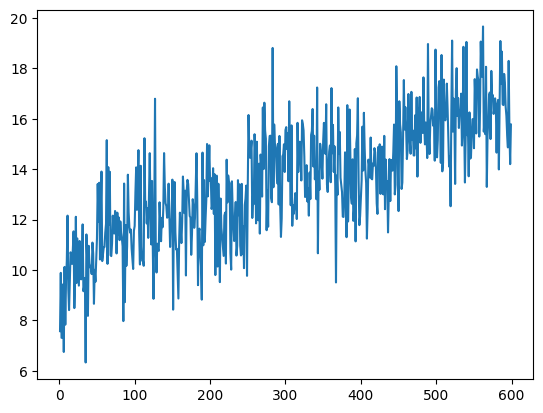

In [ ]:
plt.plot(range(1,600), [gp_model.predict(np.array([[i, 0, 0]]))[0][0][0] for i in range(1,600)])

Variance:  4.067634080746522
Lengthscale:  [1.36552023]
Carte:  [60.85780348 32.07359025 20.04406828 14.87513512 10.31008249 30.53878945
 27.00238407 25.58094935 17.96475865 10.00985813 20.43905031 24.4818833
 23.16960087 18.8581895  12.81394451 15.36978007 17.64175261 17.7294211
 17.64036164 14.61993326  8.2952631   9.84514694 13.21880062 14.07485781
 12.31668869]
(array([[60.85780348]]), array([[6.69529902]]))
(array([[12.31668869]]), array([[6.46372618]]))
Incertitude initiale :  85.00378606110073


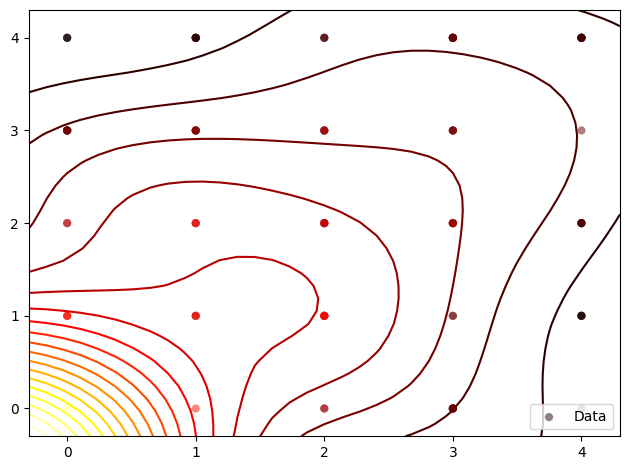

In [ ]:
graph_dim = (5, 5)
graph_unity = 1
graph = construct_graph(graph_dim, graph_unity)
X_v = np.array([graph.nodes[i]["coord"] for i in range(graph.number_of_nodes())])
means = [60, 30, 20, 15, 10, 30, 27.5, 25, 17.5, 11.25, 20, 25, 22.5, 20, 12.5, 15, 17.5, 20, 17.5, 15, 10, 11.25, 12.5, 15, 12.5]
nb_agents = 4
exploration_steps = 25
variance_lengthscale = [4, 1]
memory_window = 1000
gamma = 0.995

variances = [[0, 0, 0] for _ in range(graph.number_of_nodes())]
#covariances = [[0, 0, 0, 0] for _ in range(graph.number_of_nodes())]
liste_covariances = [[[0, 0, 0, 0] for _ in range(graph.number_of_nodes())] for _ in range(graph.number_of_nodes())]

incertitude, x, y = collect_pilot_data(nb_agents, exploration_steps, graph, graph_dim, means, variance_lengthscale[0], variance_lengthscale[1], memory_window, gamma)

x = np.reshape(x, (nb_agents*exploration_steps,2))
y = np.reshape(y, (nb_agents*exploration_steps,1))

gp_model = GPy.models.GPRegression(x, y, GPy.kern.RBF(2))
gp_model.optimize(messages=False)

moyenne, var, l = hyperparameters_estimator(gp_model, graph, graph_dim, memory_window, gamma)
print("Variance: ", var)
print("Lengthscale: ", l)
print("Carte: ", moyenne)

gp_model.plot()
print(gp_model.predict(np.array([[0, 0]])))
print(gp_model.predict(np.array([[4, 4]])))
print("Incertitude initiale : ", incertitude_initiale(sigma_matrix(gp_model, X_v), graph))

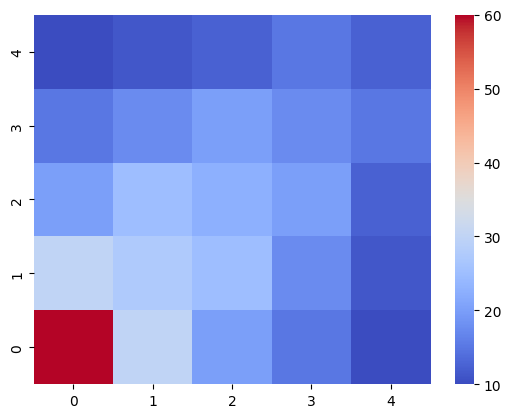

In [ ]:
plot_heat_map(means, graph_dim)

In [ ]:
def update_gp_model(gp_model, x, y, display_gp_model=False):
    X = np.concatenate((gp_model.X, x))[-1000:]
    Y = np.concatenate((gp_model.Y, y))[-1000:]
    gp_model.set_XY(X, Y)
    gp_model.optimize(messages=False)
    if display_gp_model:
        display(gp_model)
    return gp_model

def take_measurements(nodes, means, X_v, memory_window, gamma):
    simulation_kernel = GPy.kern.RBF(input_dim = 2, variance=variance_lengthscale[0], lengthscale=variance_lengthscale[1])
    cov = simulation_kernel.K(X_v)
    Y_v = np.random.multivariate_normal(np.array(means), cov, 1)[0]
    Y_v = np.reshape(Y_v, (len(Y_v),1))
    Y_v[Y_v<0] = 0.1

    for i in nodes:
        l = variances[i]
        l[0], l[1], l[2] = weighted_variance(l[0], l[1], l[2], Y_v[i][0], memory_window, gamma)

    sorted_nodes = sorted(nodes)

    for j in range(len(sorted_nodes)):
            if j==0 or sorted_nodes[j]!=sorted_nodes[j-1]:
                for i in range(len(sorted_nodes)):
                    if sorted_nodes[i]!=sorted_nodes[j] and (sorted_nodes[i]!=sorted_nodes[i-1] or i==0):
                        if distance(X_v[sorted_nodes[j]], X_v[sorted_nodes[i]])<=3.1:
                            l = liste_covariances[sorted_nodes[j]][sorted_nodes[i]]
                            l[0], l[1], l[2], l[3] = weighted_covariance(l[0], l[1], l[2], l[3], Y_v[sorted_nodes[j]], Y_v[sorted_nodes[i]], memory_window, gamma)
    """
    if sorted_nodes[0]==0:
        for i in range(1,len(sorted_nodes)):
            if sorted_nodes[i]!=sorted_nodes[i-1] and distance(X_v[sorted_nodes[0]], X_v[sorted_nodes[i]])<=5:
                l = covariances[sorted_nodes[i]]
                l[0], l[1], l[2], l[3] = weighted_covariance(l[0], l[1], l[2], l[3], Y_v[0], Y_v[sorted_nodes[i]], memory_window, gamma)
    """
    return X_v[nodes], Y_v[nodes]

def clean(b):
    for ele in liste_covariances:
        for sub_ele in ele:
            sub_ele[0], sub_ele[1], sub_ele[2], sub_ele[3] = 0, 0, 0, 0
    if b:
        for ele in variances:
            ele[0], ele[1], ele[2] = 0, 0, 0

In [ ]:
class pfeEnv(py_environment.PyEnvironment):

    def __init__(self, graph, gp_model, nb_agents, budgets, graph_unity, graph_dim, initial_positions, variance_0, lengthscale_0, memory_window, gamma, train_env=True):
        self.nb_agents = nb_agents
        self.graph = graph
        self.graph_unity = graph_unity
        self.graph_dim = graph_dim
        self.initial_budgets = budgets/self.graph_unity
        self.budgets = self.initial_budgets.copy()
        if initial_positions!=None:
            self.initial_positions = copie_paths(initial_positions)
            self.paths = copie_paths(initial_positions)
        else:
            self.initial_positions = None
            self.paths = [[random.randint(0, self.graph.number_of_nodes()-1)] for i in range(self.nb_agents)]
        self.neighbors = [sorted(list(self.graph.neighbors(self.current_node(i)))) for i in range(self.nb_agents)]
        self.formater()
        self.X_v = np.array([self.graph.nodes[i]["coord"] for i in range(self.graph.number_of_nodes())])
        self.gp_model = gp_model
        self.X_s = [[] for i in range(self.nb_agents)]
        self.dones = [False for i in range(self.nb_agents)]
        self.cpt_done = 0
        self._action_spec = array_spec.BoundedArraySpec(shape=(), dtype=np.int32, minimum=0, maximum=3, name="action")
        self._observation_spec = array_spec.BoundedArraySpec(shape=(self.nb_agents*2,), dtype=np.float32, minimum=np.zeros((self.nb_agents*2,)), name="observation")
        self._state = flatten([self.graph.nodes[self.current_node(i)]["coord"] for i in range(self.nb_agents)])
        self._episode_ended = False
        #################################
        self.cpt_update_gp_model = 0
        self.memory_window, self.gamma = memory_window, gamma
        self.x, self.y = np.array([]), np.array([])
        self.liste_variances, self.liste_lengthscales = [variance_0], [lengthscale_0]
        self.train_env = train_env
        self.indice_variance = 0
        self.indice_lengthscale = 0

    def current_node(self, id_agent):
        return self.paths[id_agent][-1]

    def action_spec(self):
        return self._action_spec

    def observation_spec(self):
        return self._observation_spec

    def formater(self):
        for i in range(len(self.neighbors)):
            liste = self.neighbors[i]
            node = self.current_node(i)
            try:
                if liste[0]>=node-1:
                    liste.insert(0,-1)
                if liste[1]!=node-1:
                    liste.insert(1,-1)
                if liste[2]!=node+1:
                    liste.insert(2,-1)
            except:
                pass
            for _ in range(4-len(liste)):
                liste.append(-1)

    def _reset(self):
        if self.initial_positions!=None:
            self.paths = copie_paths(self.initial_positions)
        else:
            self.paths = [[random.randint(0, self.graph.number_of_nodes()-1)] for i in range(self.nb_agents)]
        self._state = flatten([self.graph.nodes[self.current_node(i)]["coord"] for i in range(self.nb_agents)])
        self.neighbors = [sorted(list(self.graph.neighbors(self.current_node(i)))) for i in range(self.nb_agents)]
        self.formater()
        self.budgets = self.initial_budgets.copy()
        self.X_s = [[] for i in range(self.nb_agents)]
        self.dones = [False for i in range(self.nb_agents)]
        self.cpt_done = 0
        self._episode_ended = False
        return ts.restart(np.array(self._state, dtype=np.float32))

    def _step(self, abstract_actions):
        if self._episode_ended:
            return self.reset()
        actions = []
        for i in range(self.nb_agents):
            actions.append(self.neighbors[i][abstract_actions[i]])
        X_s_old = preprocessing(self.X_s)
        for i in range(self.nb_agents):
            if not self.dones[i]:
                if actions[i]!=-1:
                    self.X_s[i].append([graph.nodes[actions[i]]["coord"][0], graph.nodes[actions[i]]["coord"][1]])
                    self.budgets[i] -= 1
                else:
                    actions[i] = self.current_node(i)
                    self.budgets[i] -= 0.3
                if self.budgets[i]<1:
                    self.dones[i] = True
                    self.cpt_done += 1
                self.paths[i].append(actions[i])
                coord = self.graph.nodes[self.current_node(i)]["coord"]
                self._state[2*i] = coord[0]
                self._state[2*i+1] = coord[1]


        if self.train_env:
            positions, mesures = take_measurements(actions, means, self.X_v, self.memory_window, self.gamma)
            m, var, l = hyperparameters_estimator(self.gp_model, self.graph, self.graph_dim, self.memory_window, self.gamma)
            self.liste_variances.append(var)
            self.liste_lengthscales.append(l)
            self.moy = m
            ##########################
            vi, vs = min(self.liste_variances[self.indice_variance:]), max(self.liste_variances[self.indice_variance:])
            #print("#################### variance : ", vi, vs)
            if vs-vi>30:
                print("#################### variance : ", vi, vs)
                clean(True)
                self.indice_variance = len(self.liste_variances)
                self.indice_lengthscale = len(self.liste_lengthscales)
            else:
                vi, vs = min(self.liste_lengthscales[self.indice_lengthscale:]), max(self.liste_lengthscales[self.indice_lengthscale:])
                #print("#################### lengthscale : ", vi, vs)
                if vs-vi>3:
                    print("#################### lengthscale : ", vi, vs)
                    clean(False)
                    self.indice_lengthscale = len(self.liste_lengthscales)
            ##########################
            self.x = concatenate(self.x, positions)
            self.y = concatenate(self.y, mesures)
            self.cpt_update_gp_model = (self.cpt_update_gp_model + 1)%100
            if self.cpt_update_gp_model==0:
                self.gp_model = update_gp_model(self.gp_model, self.x, self.y)
                self.x, self.y = np.array([]), np.array([])

        self.neighbors = [sorted(list(self.graph.neighbors(self.current_node(i)))) for i in range(self.nb_agents)]
        self.formater()
        reward = reward_function(self.gp_model, self.X_v, X_s_old, preprocessing(self.X_s))
        if self.cpt_done==self.nb_agents:
            self._episode_ended = True
            return ts.termination(np.array(self._state, dtype=np.float32), reward)
        return ts.transition(np.array(self._state, dtype=np.float32), reward=reward, discount=0.97)

In [ ]:
num_iterations = 20000
fc_layer_params = (128,64,)
replay_buffer_capacity = 5000
batch_size = 128
learning_rate = 1e-5

num_atoms = 51
min_q_value = -20
max_q_value = 20
n_step_update = 3

num_eval_episodes = 10
log_eval_interval = 1000

max_episode_length = 25
budgets = 25 * np.ones(nb_agents)

In [ ]:
initial_positions = None #[[random.randint(0, graph.number_of_nodes()-1)] for i in range(nb_agents)]
train_py_env = wrappers.TimeLimit(pfeEnv(graph, gp_model, nb_agents, budgets, graph_unity, graph_dim, initial_positions, var, l, memory_window, gamma, train_env=True), duration=max_episode_length)
eval_py_env = wrappers.TimeLimit(pfeEnv(graph, gp_model, nb_agents, budgets, graph_unity, graph_dim, initial_positions, var, l, memory_window, gamma, train_env=False), duration=max_episode_length)

train_env = tf_py_environment.TFPyEnvironment(train_py_env)
eval_env = tf_py_environment.TFPyEnvironment(eval_py_env)

agents_tf = []
eval_policies = []
collect_policies = []
policies_checkpointers = []

for i in range(nb_agents):
    categorical_q_net = categorical_q_network.CategoricalQNetwork(
        train_env.observation_spec(),
        train_env.action_spec(),
        num_atoms=num_atoms,
        fc_layer_params=fc_layer_params)

    optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=learning_rate)

    train_step_counter = tf.compat.v2.Variable(0)

    agents_tf.append(categorical_dqn_agent.CategoricalDqnAgent(
        train_env.time_step_spec(),
        train_env.action_spec(),
        categorical_q_network=categorical_q_net,
        optimizer=optimizer,
        min_q_value=min_q_value,
        max_q_value=max_q_value,
        n_step_update=n_step_update,
        target_update_period=5,
        target_update_tau=0.05,
        td_errors_loss_fn=common.element_wise_squared_loss,
        gamma=0.99,
        train_step_counter=train_step_counter))

    agents_tf[-1].initialize()

    eval_policies.append(agents_tf[-1].policy)
    collect_policies.append(agents_tf[-1].collect_policy)
    collect_policies[-1]._epsilon = 1.

    policies_checkpointers.append(common.Checkpointer(ckpt_dir='Collisions_Politique___'+str(i), policy=eval_policies[-1]))

In [ ]:
def compute_avg_return(environment, policies, num_episodes=10):
    total_return = 0.0
    for _ in range(num_episodes):
        time_step = environment.reset()
        episode_return = 0.0
        while not time_step.is_last():
            actions = []
            for i in range(nb_agents):
                actions.append(policies[i].action(time_step).action.numpy()[0])
            actions = tf.convert_to_tensor([actions])
            time_step = environment.step(actions)
            episode_return += time_step.reward
        total_return += episode_return
    avg_return = total_return / num_episodes
    return avg_return.numpy()[0]

def random_compute_avg_return(environment, num_episodes=10):
    total_return = 0.0
    for _ in range(num_episodes):
        time_step = environment.reset()
        episode_return = 0.0
        while not time_step.is_last():
            actions = [random.randint(0, 3) for _ in range(nb_agents)]
            actions = tf.convert_to_tensor([actions])
            time_step = environment.step(actions)
            episode_return += time_step.reward
        total_return += episode_return
    avg_return = total_return / num_episodes
    return avg_return.numpy()[0]

def collect_step(environment, environment_py, policies):
    time_step = environment.current_time_step()
    actions = []
    actions_step = []
    dones = environment_py.dones.copy()
    for i in range(nb_agents):
        actions_step.append(policies[i].action(time_step))
        actions.append(actions_step[-1].action.numpy()[0])
    actions = tf.convert_to_tensor([actions])
    next_time_step = environment.step(actions)
    rewards = credit_assignment(environment_py, next_time_step.reward.numpy()[0], dones)
    for i in range(nb_agents):
        if not dones[i]:
            nts = next_time_step._replace(reward=tf.convert_to_tensor([rewards[i]], dtype=np.float32))
            traj = trajectory.from_transition(time_step, actions_step[i], nts)
            replay_buffers[i].add_batch(traj)

def random_collect_step(environment, environment_py):
    time_step = environment.current_time_step()
    actions = [random.randint(0, 3) for _ in range(nb_agents)]
    actions = tf.convert_to_tensor([actions])
    next_time_step = environment.step(actions)

In [ ]:
replay_buffers = []
for i in range(nb_agents):
    replay_buffers.append(tf_agents.replay_buffers.TFUniformReplayBuffer(
        data_spec = agents_tf[i].collect_data_spec,
        batch_size = train_env.batch_size,
        max_length = replay_buffer_capacity))

iterators = []
for i in range(nb_agents):
    dataset = replay_buffers[i].as_dataset(
        num_parallel_calls=3,
        sample_batch_size=batch_size,
        num_steps=2).prefetch(3)
    iterators.append(iter(dataset))

Instructions for updating:
Use `tf.data.Dataset.counter(...)` instead.
Instructions for updating:
Use `as_dataset(..., single_deterministic_pass=False) instead.


In [ ]:
print(compute_avg_return(eval_env, collect_policies, num_eval_episodes))
print(compute_avg_return(eval_env, eval_policies, num_eval_episodes))

steps = []
avg = []
err = []

for i in range(nb_agents):
    agents_tf[i].train = common.function(agents_tf[i].train)
    agents_tf[i].train_step_counter.assign(0)

for _ in tqdm(range(500)):
    collect_step(train_env, train_py_env, collect_policies)

for step in tqdm(range(1, num_iterations+1)):
    if step%25==0:
        for cp in collect_policies:
            cp._epsilon = max(cp._epsilon*0.99, 0.1)

    if step==2000:
        variance_lengthscale[1] += 1
    if step==12000:
        variance_lengthscale[0] -= 1
    if step==30000:
        variance_lengthscale[1] -= 1

    for _ in range(1):
        collect_step(train_env, train_py_env, collect_policies)

    for i in range(nb_agents):
        experience, _ = next(iterators[i])
        agents_tf[i].train(experience=experience)

    if step%log_eval_interval==0:
        avg_return = compute_avg_return(eval_env, eval_policies, num_eval_episodes)
        steps.append(step)
        avg.append(avg_return)
        print('step = {0}: Average Return = {1}'.format(step, avg_return))
        print("Variance : ", train_py_env.liste_variances[-1])
        print("Lengthscale : ", train_py_env.liste_lengthscales[-1])
        err.append(np.mean((train_py_env.moy-means)**2))
        print("MSE_Average : ", err[-1])
        print("Epsilons : ", [cp._epsilon for cp in collect_policies])

40.91922
14.748378


  0%|          | 0/20000 [00:00<?, ?it/s]WARNING:tensorflow:From /usr/local/lib/python3.10/dist-packages/tensorflow/python/util/dispatch.py:1176: calling foldr_v2 (from tensorflow.python.ops.functional_ops) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.foldr(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.foldr(fn, elems))
  5%|▌         | 1000/20000 [06:03<42:19:02,  8.02s/it]

step = 1000: Average Return = 27.3118839263916
Variance :  4.083200193827181
Lengthscale :  [1.21578955]
MSE_Average :  0.10559182664665227
Epsilons :  [0.6689717585696803, 0.6689717585696803, 0.6689717585696803, 0.6689717585696803]


 10%|█         | 2000/20000 [11:46<39:53:48,  7.98s/it]

step = 2000: Average Return = 23.43501853942871
Variance :  4.054340389537039
Lengthscale :  [1.13392503]
MSE_Average :  0.24729902928474168
Epsilons :  [0.44752321376381066, 0.44752321376381066, 0.44752321376381066, 0.44752321376381066]


 15%|█▌        | 3000/20000 [17:45<39:15:07,  8.31s/it]

step = 3000: Average Return = 32.622314453125
Variance :  3.996279735068734
Lengthscale :  [1.31625047]
MSE_Average :  0.5194996701681142
Epsilons :  [0.29938039131233124, 0.29938039131233124, 0.29938039131233124, 0.29938039131233124]


 20%|██        | 4000/20000 [23:52<34:12:28,  7.70s/it]

step = 4000: Average Return = 45.489810943603516
Variance :  3.9487508805715135
Lengthscale :  [1.44802386]
MSE_Average :  0.3694650242531516
Epsilons :  [0.20027702685748935, 0.20027702685748935, 0.20027702685748935, 0.20027702685748935]


 25%|██▌       | 5000/20000 [30:03<34:56:22,  8.39s/it]

step = 5000: Average Return = 35.102394104003906
Variance :  3.953923535686669
Lengthscale :  [1.55152278]
MSE_Average :  0.07813964374338817
Epsilons :  [0.13397967485796175, 0.13397967485796175, 0.13397967485796175, 0.13397967485796175]


 30%|███       | 6000/20000 [36:28<30:09:36,  7.76s/it]

step = 6000: Average Return = 39.82340621948242
Variance :  4.009173019643857
Lengthscale :  [1.57905756]
MSE_Average :  0.10138794438150356
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 34%|███▍      | 6803/20000 [41:11<1:11:38,  3.07it/s]

#################### lengthscale :  [1.12977557] [4.31402892]


 35%|███▍      | 6979/20000 [41:57<49:43,  4.36it/s]

#################### lengthscale :  0 [3.02258575]


 35%|███▌      | 7000/20000 [42:30<27:49:06,  7.70s/it]

step = 7000: Average Return = 41.046844482421875
Variance :  3.947808811003234
Lengthscale :  [1.4353661]
MSE_Average :  0.22271702054382747
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 35%|███▌      | 7067/20000 [42:47<44:28,  4.85it/s]

#################### lengthscale :  0 [3.09235914]


 36%|███▋      | 7251/20000 [43:42<43:57,  4.83it/s]

#################### lengthscale :  0 [10.12277651]


 37%|███▋      | 7401/20000 [44:24<49:36,  4.23it/s]

#################### lengthscale :  0 [3.24507907]


 40%|████      | 8000/20000 [47:50<26:28:49,  7.94s/it]

step = 8000: Average Return = 50.24163818359375
Variance :  3.9765811252154784
Lengthscale :  [1.79718201]
MSE_Average :  0.1280285598048132
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 41%|████      | 8136/20000 [48:36<1:29:40,  2.20it/s]

#################### lengthscale :  0 [3.38127471]


 41%|████      | 8149/20000 [48:40<50:48,  3.89it/s]

#################### lengthscale :  0 [3.60667785]


 42%|████▏     | 8384/20000 [49:50<47:41,  4.06it/s]

#################### lengthscale :  0 [3.85251548]


 42%|████▏     | 8412/20000 [49:58<51:15,  3.77it/s]

#################### lengthscale :  0 [3.81397338]


 44%|████▍     | 8774/20000 [51:51<49:34,  3.77it/s]

#################### lengthscale :  0 [4.30453127]


 45%|████▍     | 8994/20000 [52:34<30:42,  5.97it/s]

#################### lengthscale :  0 [4.38367802]


 45%|████▌     | 9001/20000 [52:48<8:58:39,  2.94s/it] 

step = 9000: Average Return = 50.044334411621094
Variance :  3.9686482470968567
Lengthscale :  0
MSE_Average :  0.15520347685368852
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 47%|████▋     | 9320/20000 [53:52<38:34,  4.61it/s]

#################### lengthscale :  0 [3.16360705]


 48%|████▊     | 9536/20000 [54:35<25:37,  6.81it/s]

#################### lengthscale :  0 [4.0001743]


 49%|████▊     | 9743/20000 [55:15<30:16,  5.65it/s]

#################### lengthscale :  0 [3.09285846]


 49%|████▉     | 9854/20000 [55:37<40:28,  4.18it/s]

#################### lengthscale :  0 [6.12114438]


 50%|█████     | 10001/20000 [56:18<8:02:31,  2.90s/it] 

step = 10000: Average Return = 45.47394943237305
Variance :  3.847510433784964
Lengthscale :  [1.81837318]
MSE_Average :  0.19387757397153838
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 51%|█████     | 10145/20000 [56:48<28:29,  5.76it/s]

#################### lengthscale :  0 [3.14266957]


 51%|█████     | 10240/20000 [57:05<25:10,  6.46it/s]

#################### lengthscale :  0 [3.93603365]


 52%|█████▏    | 10319/20000 [57:22<1:08:27,  2.36it/s]

#################### lengthscale :  0 [7.8989539]


 55%|█████▌    | 11001/20000 [59:53<7:29:34,  3.00s/it] 

step = 11000: Average Return = 39.81731414794922
Variance :  3.9379877377973034
Lengthscale :  [2.19569713]
MSE_Average :  0.19564057231150372
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 60%|██████    | 12001/20000 [1:03:43<6:44:10,  3.03s/it]

step = 12000: Average Return = 42.720802307128906
Variance :  4.018303534758441
Lengthscale :  [2.19750333]
MSE_Average :  0.21427424675646542
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 62%|██████▏   | 12480/20000 [1:05:30<22:43,  5.52it/s]

#################### lengthscale :  0 [3.41137811]


 64%|██████▍   | 12780/20000 [1:06:35<24:02,  5.00it/s]

#################### lengthscale :  0 [3.36445162]


 65%|██████▌   | 13001/20000 [1:07:39<6:27:26,  3.32s/it]

step = 13000: Average Return = 48.67702102661133
Variance :  3.4575878701076674
Lengthscale :  [1.50055073]
MSE_Average :  0.14767090040753536
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 67%|██████▋   | 13308/20000 [1:08:48<20:23,  5.47it/s]

#################### lengthscale :  0 [3.09475109]


 67%|██████▋   | 13471/20000 [1:09:26<22:12,  4.90it/s]

#################### lengthscale :  0 [3.27102067]


 68%|██████▊   | 13509/20000 [1:09:33<22:16,  4.86it/s]

#################### lengthscale :  0 [3.88549339]


 69%|██████▊   | 13729/20000 [1:10:21<18:32,  5.64it/s]

#################### lengthscale :  0 [3.33221086]


 69%|██████▉   | 13755/20000 [1:10:28<23:56,  4.35it/s]

#################### lengthscale :  0 [3.98416043]


 70%|██████▉   | 13921/20000 [1:11:02<20:46,  4.88it/s]

#################### lengthscale :  0 [4.95233953]


 70%|███████   | 14000/20000 [1:11:35<7:33:31,  4.54s/it]

step = 14000: Average Return = 51.31140899658203
Variance :  3.2127725816575143
Lengthscale :  [1.32185727]
MSE_Average :  0.4480270847214227
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 72%|███████▏  | 14474/20000 [1:13:19<18:58,  4.86it/s]

#################### lengthscale :  0 [3.10950346]


 75%|███████▌  | 15000/20000 [1:15:32<6:08:55,  4.43s/it]

step = 15000: Average Return = 48.60094451904297
Variance :  3.2103835975562895
Lengthscale :  [2.01047066]
MSE_Average :  0.10306032170024679
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 75%|███████▌  | 15060/20000 [1:15:44<15:20,  5.37it/s]

#################### lengthscale :  0 [3.95360476]


 80%|████████  | 16000/20000 [1:19:29<5:40:37,  5.11s/it]

step = 16000: Average Return = 41.885902404785156
Variance :  3.0578557776140096
Lengthscale :  [1.91209158]
MSE_Average :  0.0967906195628792
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 80%|████████  | 16056/20000 [1:19:43<14:23,  4.57it/s]

#################### lengthscale :  0 [3.15024899]


 80%|████████  | 16095/20000 [1:19:50<10:38,  6.11it/s]

#################### lengthscale :  0 [3.70702926]


 85%|████████▌ | 17001/20000 [1:23:21<2:30:28,  3.01s/it]

step = 17000: Average Return = 44.18687438964844
Variance :  3.063724965238329
Lengthscale :  [2.07271292]
MSE_Average :  0.2532767103911232
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 89%|████████▉ | 17776/20000 [1:26:16<08:17,  4.47it/s]

#################### lengthscale :  0 [3.18509016]


 90%|█████████ | 18001/20000 [1:27:19<1:51:47,  3.36s/it]

step = 18000: Average Return = 48.74932098388672
Variance :  2.989455316750015
Lengthscale :  [1.70199937]
MSE_Average :  0.2307006991015758
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 91%|█████████ | 18135/20000 [1:27:49<06:09,  5.04it/s]

#################### lengthscale :  0 [3.49560708]


 94%|█████████▍| 18815/20000 [1:30:11<05:12,  3.80it/s]

#################### lengthscale :  0 [3.73387426]


 95%|█████████▍| 18967/20000 [1:30:44<03:13,  5.33it/s]

#################### lengthscale :  0 [3.03023593]


 95%|█████████▌| 19000/20000 [1:31:04<1:14:39,  4.48s/it]

step = 19000: Average Return = 49.12984848022461
Variance :  3.026999526546976
Lengthscale :  [1.29847929]
MSE_Average :  0.5858823911906254
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 99%|█████████▉| 19853/20000 [1:34:06<00:28,  5.11it/s]

#################### lengthscale :  0 [3.47573379]


100%|██████████| 20000/20000 [1:34:51<00:00,  3.51it/s]

step = 20000: Average Return = 44.39936828613281
Variance :  2.9299274120786722
Lengthscale :  [1.74050159]
MSE_Average :  0.1637546786634134
Epsilons :  [0.1, 0.1, 0.1, 0.1]


In [ ]:
print(steps)
print("--------------------------")
print(avg)
print("---------------------------")
print(err)
print("--------------------------")
print(train_py_env.liste_variances)
print("---------------------------")
print(train_py_env.liste_lengthscales)

[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000]
--------------------------
[27.311884, 23.435019, 32.622314, 45.48981, 35.102394, 39.823406, 41.046844, 50.24164, 50.044334, 45.47395, 39.817314, 42.720802, 48.67702, 51.31141, 48.600945, 41.885902, 44.186874, 48.74932, 49.12985, 44.39937]
---------------------------
[0.10559182664665227, 0.24729902928474168, 0.5194996701681142, 0.3694650242531516, 0.07813964374338817, 0.10138794438150356, 0.22271702054382747, 0.1280285598048132, 0.15520347685368852, 0.19387757397153838, 0.19564057231150372, 0.21427424675646542, 0.14767090040753536, 0.4480270847214227, 0.10306032170024679, 0.0967906195628792, 0.2532767103911232, 0.2307006991015758, 0.5858823911906254, 0.1637546786634134]
--------------------------
[4.067634080746522, 4.044500272060045, 3.9799741592590143, 4.035571847026921, 3.9966747226509853, 4.102423394789571, 3.997540404452909, 4.005991088311065, 4.1380

In [ ]:
print(compute_avg_return(eval_env, collect_policies, num_eval_episodes))
print(compute_avg_return(eval_env, eval_policies, num_eval_episodes))

steps = []
avg = []
err = []

for i in range(nb_agents):
    agents_tf[i].train = common.function(agents_tf[i].train)
    agents_tf[i].train_step_counter.assign(0)

for _ in tqdm(range(500)):
    collect_step(train_env, train_py_env, collect_policies)

for step in tqdm(range(num_iterations+1, 2*num_iterations+1)):
    if step%25==0:
        for cp in collect_policies:
            cp._epsilon = max(cp._epsilon*0.99, 0.1)

    if step==2000:
        variance_lengthscale[1] += 1
    if step==12000:
        variance_lengthscale[0] -= 1
    if step==30000:
        variance_lengthscale[1] -= 1

    for _ in range(1):
        collect_step(train_env, train_py_env, collect_policies)

    for i in range(nb_agents):
        experience, _ = next(iterators[i])
        agents_tf[i].train(experience=experience)

    if step%log_eval_interval==0:
        avg_return = compute_avg_return(eval_env, eval_policies, num_eval_episodes)
        steps.append(step)
        avg.append(avg_return)
        print('step = {0}: Average Return = {1}'.format(step, avg_return))
        print("Variance : ", train_py_env.liste_variances[-1])
        print("Lengthscale : ", train_py_env.liste_lengthscales[-1])
        err.append(np.mean((train_py_env.moy-means)**2))
        print("MSE_Average: ", err[-1])
        print("Epsilons : ", [cp._epsilon for cp in collect_policies])

52.843147
46.661156


  1%|          | 107/20000 [00:36<1:24:38,  3.92it/s]

#################### lengthscale :  0 [3.29738215]


  5%|▍         | 926/20000 [05:17<1:18:51,  4.03it/s]

#################### lengthscale :  0 [3.1326192]


  5%|▍         | 936/20000 [05:19<1:21:14,  3.91it/s]

#################### lengthscale :  0 [3.28627397]


  5%|▌         | 1000/20000 [06:16<44:21:59,  8.41s/it]

step = 21000: Average Return = 37.58729553222656
Variance :  2.861054780304247
Lengthscale :  [1.49792592]
MSE_Average:  41.18830330103811
Epsilons :  [0.1, 0.1, 0.1, 0.1]


  6%|▋         | 1296/20000 [07:51<1:50:34,  2.82it/s]

#################### lengthscale :  0 [3.36667131]


  7%|▋         | 1358/20000 [08:09<2:08:41,  2.41it/s]

#################### lengthscale :  0 [3.73328519]


  7%|▋         | 1484/20000 [08:48<1:12:02,  4.28it/s]

#################### lengthscale :  0 [3.17802766]


 10%|█         | 2000/20000 [12:11<40:44:58,  8.15s/it]

step = 22000: Average Return = 44.30579376220703
Variance :  2.9629386954780377
Lengthscale :  [1.68947042]
MSE_Average:  19.18085590976357
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 10%|█         | 2077/20000 [12:34<2:06:40,  2.36it/s]

#################### lengthscale :  0 [16.80200583]


 11%|█▏        | 2291/20000 [13:45<1:56:20,  2.54it/s]

#################### lengthscale :  0 [3.53551042]


 14%|█▍        | 2877/20000 [17:09<1:30:58,  3.14it/s]

#################### lengthscale :  0 [3.5733837]


 15%|█▌        | 3000/20000 [18:09<34:56:53,  7.40s/it]

step = 23000: Average Return = 44.732093811035156
Variance :  3.001223200594994
Lengthscale :  [1.7387518]
MSE_Average:  23.460214017508758
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 16%|█▌        | 3125/20000 [18:54<1:40:24,  2.80it/s]

#################### lengthscale :  0 [4.84675352]


 19%|█▉        | 3819/20000 [22:27<1:08:05,  3.96it/s]

#################### lengthscale :  0 [3.06538294]


 19%|█▉        | 3847/20000 [22:34<1:32:05,  2.92it/s]

#################### lengthscale :  0 [3.95717129]


 20%|██        | 4000/20000 [23:45<32:28:36,  7.31s/it]

step = 24000: Average Return = 42.93922805786133
Variance :  2.845447707780845
Lengthscale :  [1.95297119]
MSE_Average:  0.08872705840299817
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 21%|██        | 4117/20000 [24:20<1:01:02,  4.34it/s]

#################### lengthscale :  0 [3.04343246]


 24%|██▍       | 4794/20000 [27:54<2:45:11,  1.53it/s]

#################### lengthscale :  0 [3.32237434]


 25%|██▌       | 5000/20000 [29:27<36:42:15,  8.81s/it]

step = 25000: Average Return = 48.776634216308594
Variance :  2.9690376702321393
Lengthscale :  [1.80768014]
MSE_Average:  0.10747041876083145
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 25%|██▌       | 5091/20000 [29:53<1:27:43,  2.83it/s]

#################### lengthscale :  0 [3.8497943]


 27%|██▋       | 5463/20000 [31:46<1:25:01,  2.85it/s]

#################### lengthscale :  0 [3.45747798]


 28%|██▊       | 5602/20000 [32:26<45:43,  5.25it/s]

#################### lengthscale :  0 [3.5346895]


 30%|███       | 6000/20000 [35:01<31:31:20,  8.11s/it]

step = 26000: Average Return = 53.30150604248047
Variance :  2.931724700726892
Lengthscale :  [1.77600326]
MSE_Average:  0.12533242694704866
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 30%|███       | 6029/20000 [35:08<53:10,  4.38it/s]

#################### lengthscale :  0 [3.75264912]


 35%|███▌      | 7000/20000 [40:45<28:41:44,  7.95s/it]

step = 27000: Average Return = 43.38434600830078
Variance :  2.992038040206889
Lengthscale :  [1.8853028]
MSE_Average:  0.1791327529453553
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 38%|███▊      | 7663/20000 [44:23<1:00:58,  3.37it/s]

#################### lengthscale :  0 [3.061484]


 40%|████      | 8000/20000 [46:28<25:53:41,  7.77s/it]

step = 28000: Average Return = 43.4902229309082
Variance :  2.9916640734933146
Lengthscale :  [1.91274491]
MSE_Average:  0.2700845026320222
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 41%|████▏     | 8275/20000 [48:12<1:04:08,  3.05it/s]

#################### lengthscale :  0 [5.04126825]


 43%|████▎     | 8515/20000 [49:21<1:08:38,  2.79it/s]

#################### lengthscale :  0 [3.36415323]


 43%|████▎     | 8597/20000 [49:47<46:36,  4.08it/s]

#################### lengthscale :  0 [3.10153611]


 45%|████▌     | 9000/20000 [52:21<24:40:17,  8.07s/it]

step = 29000: Average Return = 43.83225631713867
Variance :  2.9797282581624955
Lengthscale :  [1.7243226]
MSE_Average:  1.347842407547038
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 45%|████▌     | 9085/20000 [52:49<59:18,  3.07it/s]  

#################### lengthscale :  0 [3.75241836]


 47%|████▋     | 9414/20000 [54:27<49:51,  3.54it/s]

#################### lengthscale :  0 [3.06585714]


 48%|████▊     | 9601/20000 [55:24<44:43,  3.87it/s]

#################### lengthscale :  0 [3.37532632]


 48%|████▊     | 9693/20000 [55:52<44:31,  3.86it/s]

#################### lengthscale :  0 [3.48445566]


 49%|████▉     | 9811/20000 [56:28<58:18,  2.91it/s]

#################### lengthscale :  0 [3.02997193]


 49%|████▉     | 9826/20000 [56:32<41:06,  4.12it/s]

#################### lengthscale :  0 [8.50415899]


 49%|████▉     | 9839/20000 [56:35<38:24,  4.41it/s]

#################### lengthscale :  0 [3.19463102]


 50%|████▉     | 9954/20000 [57:10<59:52,  2.80it/s]

#################### lengthscale :  0 [3.39329678]


 50%|████▉     | 9961/20000 [57:12<1:01:00,  2.74it/s]

#################### lengthscale :  0 [3.35013955]


 50%|████▉     | 9979/20000 [57:16<36:25,  4.58it/s]

#################### lengthscale :  0 [3.2552098]


 50%|█████     | 10000/20000 [57:59<22:46:45,  8.20s/it]

step = 30000: Average Return = 35.63521194458008
Variance :  3.019911639421972
Lengthscale :  [1.26105066]
MSE_Average:  29.539790194914634
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 55%|█████▌    | 11000/20000 [1:03:49<20:09:44,  8.06s/it]

step = 31000: Average Return = 36.805362701416016
Variance :  2.9734877769573274
Lengthscale :  [1.20970603]
MSE_Average:  26.16724770707736
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 60%|██████    | 12000/20000 [1:10:13<17:53:53,  8.05s/it]

step = 32000: Average Return = 47.20277786254883
Variance :  2.968410694696551
Lengthscale :  [1.10020022]
MSE_Average:  0.23402905501788634
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 65%|██████▌   | 13000/20000 [1:16:12<16:03:31,  8.26s/it]

step = 33000: Average Return = 51.63617706298828
Variance :  3.0566760983957915
Lengthscale :  [1.08250954]
MSE_Average:  0.08789812851830461
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 70%|███████   | 14000/20000 [1:22:32<14:06:37,  8.47s/it]

step = 34000: Average Return = 56.348777770996094
Variance :  2.980879427590503
Lengthscale :  [1.07570345]
MSE_Average:  0.1815133206658103
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 75%|███████▌  | 15000/20000 [1:29:15<10:49:08,  7.79s/it]

step = 35000: Average Return = 47.193294525146484
Variance :  3.0363870912040074
Lengthscale :  [1.07295842]
MSE_Average:  0.1875356008278079
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 80%|████████  | 16000/20000 [1:35:45<9:14:34,  8.32s/it]

step = 36000: Average Return = 46.283180236816406
Variance :  3.019242023101584
Lengthscale :  [1.07085574]
MSE_Average:  0.16419662066735546
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 85%|████████▌ | 17000/20000 [1:42:21<6:29:38,  7.79s/it]

step = 37000: Average Return = 47.171871185302734
Variance :  3.0014688636484634
Lengthscale :  [1.07055082]
MSE_Average:  0.06381163551151894
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 90%|█████████ | 18000/20000 [1:49:03<4:38:12,  8.35s/it]

step = 38000: Average Return = 48.66518020629883
Variance :  2.9721550448009575
Lengthscale :  [1.07149053]
MSE_Average:  0.09808782287106307
Epsilons :  [0.1, 0.1, 0.1, 0.1]


 95%|█████████▌| 19000/20000 [1:55:45<1:55:39,  6.94s/it]

step = 39000: Average Return = 55.10734176635742
Variance :  2.942477523905163
Lengthscale :  [1.06451159]
MSE_Average:  0.1479595971999108
Epsilons :  [0.1, 0.1, 0.1, 0.1]


100%|██████████| 20000/20000 [2:02:47<00:00,  2.71it/s]

step = 40000: Average Return = 48.00541305541992
Variance :  3.064137585902316
Lengthscale :  [1.04590887]
MSE_Average:  0.07103984213733233
Epsilons :  [0.1, 0.1, 0.1, 0.1]


In [ ]:
print(steps)
print("----------------------------")
print(avg)
print("-----------------------------")
print(err)
print("----------------------------")
print(train_py_env.liste_variances)
print("-----------------------------")
print(train_py_env.liste_lengthscales)

[21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000, 31000, 32000, 33000, 34000, 35000, 36000, 37000, 38000, 39000, 40000]
----------------------------
[37.587296, 44.305794, 44.732094, 42.939228, 48.776634, 53.301506, 43.384346, 43.490223, 43.832256, 35.635212, 36.805363, 47.202778, 51.636177, 56.348778, 47.193295, 46.28318, 47.17187, 48.66518, 55.10734, 48.005413]
-----------------------------
[41.18830330103811, 19.18085590976357, 23.460214017508758, 0.08872705840299817, 0.10747041876083145, 0.12533242694704866, 0.1791327529453553, 0.2700845026320222, 1.347842407547038, 29.539790194914634, 26.16724770707736, 0.23402905501788634, 0.08789812851830461, 0.1815133206658103, 0.1875356008278079, 0.16419662066735546, 0.06381163551151894, 0.09808782287106307, 0.1479595971999108, 0.07103984213733233]
----------------------------
[4.067634080746522, 4.044500272060045, 3.9799741592590143, 4.035571847026921, 3.9966747226509853, 4.102423394789571, 3.997540404452909, 4.0059910883

In [ ]:


print(steps)
print("-------------------------")
print(avg)
print("-------------------------")
print(err)
print("-------------------------")
print(train_py_env.liste_variances)
print("-------------------------")
print(train_py_env.liste_lengthscales)

[21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000, 31000, 32000, 33000, 34000, 35000, 36000, 37000, 38000, 39000, 40000]
-------------------------
[37.587296, 44.305794, 44.732094, 42.939228, 48.776634, 53.301506, 43.384346, 43.490223, 43.832256, 35.635212, 36.805363, 47.202778, 51.636177, 56.348778, 47.193295, 46.28318, 47.17187, 48.66518, 55.10734, 48.005413]
-------------------------
[41.18830330103811, 19.18085590976357, 23.460214017508758, 0.08872705840299817, 0.10747041876083145, 0.12533242694704866, 0.1791327529453553, 0.2700845026320222, 1.347842407547038, 29.539790194914634, 26.16724770707736, 0.23402905501788634, 0.08789812851830461, 0.1815133206658103, 0.1875356008278079, 0.16419662066735546, 0.06381163551151894, 0.09808782287106307, 0.1479595971999108, 0.07103984213733233]
-------------------------
[4.067634080746522, 4.044500272060045, 3.9799741592590143, 4.035571847026921, 3.9966747226509853, 4.102423394789571, 3.997540404452909, 4.005991088311065, 4.1

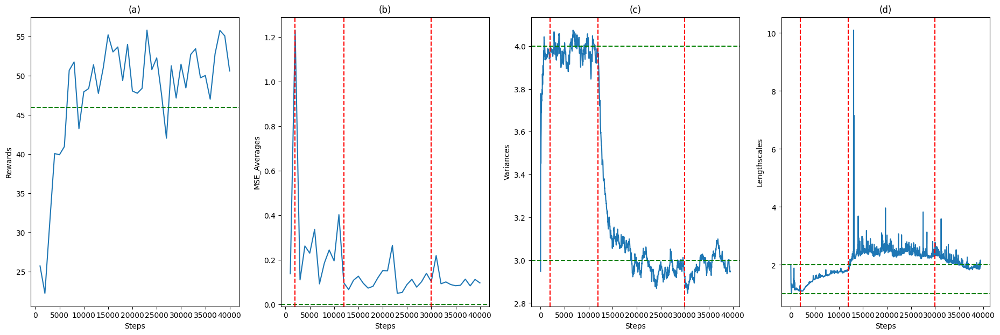

In [ ]:
steps = [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000]
##########################
avg = [25.7497, 22.270676, 31.279078, 40.079086, 39.928894, 40.960598, 50.686707, 51.758564, 43.25695, 47.94507, 48.36476, 51.40612, 47.747738, 50.994057, 55.214775, 53.037346, 53.66506, 49.387764, 53.988068, 48.053894]
##########################
err = [0.1377374058610094, 1.2311386675691856, 0.11034718843646214, 0.2625073159827362, 0.23007133560946114, 0.3367913023527411, 0.09254548497552696, 0.18555500113291493, 0.24469090732906268, 0.19594345409262323, 0.40287202191300236, 0.09775228723660818, 0.06676160880867035, 0.10869149625562813, 0.12698226425738923, 0.0955294189439684, 0.0734858753343688, 0.0814010063285817, 0.11936347256204283, 0.1517896103937512]
##########################
vvs = [2.8582145121433884, 2.8911479819637833, 2.905647252815967, 2.824680883455464, 2.7937573988007207, 2.988261086268515, 3.1075085322761424, 3.3470616354625986, 3.277069809475294, 3.3086851808354965, 3.639131439716512, 3.607778003465688, 3.5958002839781646, 3.531955843670253, 3.5527464421336608, 3.5572126437379743, 3.5992019395000603, 3.6422330636338875, 3.6790516410188814, 3.6906122867873106, 3.7299821942977354, 3.6869032277971168, 3.880173054508119, 3.838383477900786, 3.7781567074377245, 3.746745711727891, 3.72790621774569, 3.6783140058663095, 3.699860517567833, 3.798013839055298, 3.790631418813211, 3.8027576543732664, 3.749245384066921, 3.7521759715755083, 3.7052331660805575, 3.7958603988700523, 3.769441678179469, 3.7562453648203364, 3.736776310737445, 3.8323809293257316, 3.802910549569731, 3.754604167765154, 3.713945965278115, 3.7000152978923464, 3.6683303089653454, 3.6292085219770325, 3.591574941361452, 3.639694465801137, 3.5968419691333535, 3.6011314023946843, 3.5929870397439547, 3.5541940334922693, 3.57523636111622, 3.5428972064172886, 3.6625655641860444, 3.6774563257174777, 3.658100984549315, 3.6202394467258023, 3.599389165394497, 3.580798924700629, 3.5576000830009114, 3.548219318300261, 3.5108206291078865, 3.489622944273947, 3.5157782810678317, 3.480854978201586, 3.4949027597162603, 3.5030473427381787, 3.494304612965927, 3.4759026338780297, 3.4452672902623327, 3.4168505723910734, 3.4256116752135792, 3.4508829078269887, 3.4522493744153495, 3.5168408728574536, 3.49305105214336, 3.5039361880113846, 3.5209380979864413, 3.5112232024592696, 3.4924164315255686, 3.48355545899924, 3.5355319759610446, 3.532635106445621, 3.537763084603034, 3.522121677851632, 3.5169798725975436, 3.550328633502976, 3.5714465043446286, 3.547244003708732, 3.5868150130768655, 3.5982698244067075, 3.5886000745541025, 3.558593695858092, 3.5884268396792174, 3.5756929473776657, 3.5528844625219933, 3.5430328248642526, 3.5510499225865497, 3.5728837438369903, 3.5927904736842384, 3.5787044381205004, 3.6676632806763907, 3.6447482486329466, 3.6423061830345183, 3.623715002273479, 3.643168882133536, 3.650511163388808, 3.6388088541231753, 3.6269106688475174, 3.6200134913123674, 3.6074412207822326, 3.584992335361982, 3.585271623803956, 3.564885041018375, 3.545812586028228, 3.5392256131745112, 3.5507250291956036, 3.583875276615673, 3.6231678277950152, 3.6072427627394745, 3.6173426815107406, 3.622992253673543, 3.604358636687462, 3.6153943373378654, 3.6158685389858087, 3.6051817538874795, 3.6020097642448943, 3.6283827310724845, 3.7280967809606507, 3.7490662746066055, 3.7416423579757065, 3.724515275564416, 3.731702392973355, 3.7400519490938327, 3.7603098863005884, 3.754881987450814, 3.7437331733870525, 3.744590253330412, 3.7742967609087468, 3.7534975627381546, 3.7421569922236677, 3.7251757774546825, 3.723166951468277, 3.753615935213553, 3.7552905335296902, 3.7445436349889354, 3.7300615253192686, 3.718396824018103, 3.7283800304245185, 3.7490926261902273, 3.7303595124618822, 3.727583252234664, 3.7119872163342342, 3.709322072460563, 3.708042822348623, 3.696234889002523, 3.678370903033277, 3.69214155301534, 3.684428632629521, 3.687538507094073, 3.685349270929144, 3.6804038017705367, 3.6944565949762547, 3.6894578983647417, 3.674955617992933, 3.6686513408260972, 3.6621307397664196, 3.660285609862547, 3.7003542902061537, 3.6970173796039054, 3.7056831623093895, 3.7148363522294905, 3.6992609738196967, 3.6883447816587642, 3.6809089866634572, 3.6745283116274408, 3.6708820463787775, 3.763394548202398, 3.760018704662934, 3.7569565832808904, 3.7984000335065593, 3.8033596734619266, 3.795864006594386, 3.7859631430953753, 3.7849516869748947, 3.7778171941057073, 3.7685840286225005, 3.771866136786783, 3.7902480385848016, 3.7771803278616023, 3.7987960105851353, 3.7879265757856073, 3.7908715254191248, 3.7852942297299608, 3.7752319251811444, 3.761332433506696, 3.752991911172039, 3.73756994956447, 3.7459587282570816, 3.7565508317161704, 3.7488047630538426, 3.7499098428246342, 3.7441707693610273, 3.7474223691108404, 3.745580845880567, 3.7328482918676045, 3.7430311805077077, 3.7321417124488483, 3.730613405434209, 3.725373284521374, 3.7192024438923363, 3.7324020142845953, 3.731010872830665, 3.753551535524213, 3.750154268855662, 3.7614630935824778, 3.773309287532392, 3.76282939778835, 3.7515822254104547, 3.765370894403724, 3.754848186889529, 3.7637857799044854, 3.76098161899856, 3.7496141723588243, 3.7446646649541324, 3.733557553464802, 3.734547286720075, 3.722411938670549, 3.7298988166158176, 3.725092940408808, 3.712531628938015, 3.706310160378548, 3.714372496580946, 3.748005861100406, 3.762487707602729, 3.758676405669359, 3.750902862931238, 3.754884249536386, 3.7672972316607964, 3.767178175384934, 3.7603729484423956, 3.757804496689117, 3.77401816407843, 3.7664367626623734, 3.763715531968115, 3.7515581246893817, 3.764273644586716, 3.7514637340096644, 3.7438153895477253, 3.744116178059175, 3.7392729722652005, 3.7346077116205545, 3.7316199952435647, 3.7652036548459904, 3.7712444461870276, 3.764736283666216, 3.7701106233702584, 3.7706164740197377, 3.7642987746942325, 3.7530649235201117, 3.745967385790355, 3.7457803191753443, 3.7592032275075886, 3.7568459369698344, 3.7452176134202837, 3.7390986727124593, 3.737362646815941, 3.7570199929789885, 3.7623584301674238, 3.7605908670968278, 3.7644577686194993, 3.762618526106626, 3.7737305651972144, 3.774770769404383, 3.781530316581678, 3.7791051401480797, 3.782489809727902, 3.7973504954084962, 3.8089727209546336, 3.807406750052273, 3.8077887283109875, 3.820813619710235, 3.821450210331309, 3.8164913606646236, 3.809562280451965, 3.811226800757981, 3.8076867693755547, 3.801132628017325, 3.8017447482519735, 3.809521282590573, 3.799652492251345, 3.795354976195365, 3.819008237843079, 3.821807824780065, 3.8148500303289055, 3.810194468168916, 3.810555084699658, 3.8006710185729276, 3.796859951295934, 3.7897043262212455, 3.7806716094081754, 3.773052197819776, 3.764818375143609, 3.760856687258591, 3.7618201452505287, 3.758379506843636, 3.7927605027241937, 3.7908769519187597, 3.797096143632775, 3.790078229676285, 3.784933937570801, 3.78626825625763, 3.7767972834415224, 3.772555262225445, 3.7651744876206554, 3.768824725032237, 3.7828457160615736, 3.783087582363031, 3.780682242775053, 3.795280788258694, 3.7890691539667083, 3.7936877289029094, 3.7893848060216215, 3.785084596617073, 3.7836622852076323, 3.783367776626344, 3.776054467049073, 3.784332261071319, 3.7850868461906138, 3.791557549951304, 3.7816512992245164, 3.779127843593619, 3.7794554249018315, 3.7888178471240384, 3.783149831761012, 3.7847425124202316, 3.785955184103182, 3.7903763623550746, 3.784811902022242, 3.7991707285843392, 3.7907624399331947, 3.786704434588723, 3.790155992345664, 3.789672066771608, 3.791620883819055, 3.784993822233213, 3.782071118535186, 3.7776235018163593, 3.7743017847426996, 3.7756913208614824, 3.7855268471657197, 3.7760806409668977, 3.793116189887657, 3.8076215086747616, 3.817100097343215, 3.81068165448464, 3.8188855956729046, 3.8184737113952654, 3.8162721880847155, 3.8180556563091614, 3.8108431285201676, 3.8021072663315487, 3.7991808021325717, 3.799525611598807, 3.8012179723730597, 3.8044922033677304, 3.7999012154128136, 3.8168423715111786, 3.8294668581857083, 3.839801156846845, 3.840170605726549, 3.853530573463145, 3.874068957037661, 3.869844740899161, 3.8660268248191265, 3.8666211141705267, 3.8587670394859517, 3.8664506334937436, 3.8809969526590837, 3.872399107601017, 3.875839823044253, 3.870249769945967, 3.87129853206963, 3.865975973397316, 3.8671370890405377, 3.860974878707645, 3.8529783071386854, 3.852705361085261, 3.873106478075939, 3.874114572987706, 3.8720710166515477, 3.8749242831854906, 3.8664643516390047, 3.857806628851497, 3.8600602901825685, 3.8547219023283055, 3.8487072634060997, 3.847359865767587, 3.839180469807669, 3.8356265485684324, 3.834815039352364, 3.828193946940756, 3.820323781737701, 3.8309757665693356, 3.823742780417797, 3.815665874140772, 3.8122151186062214, 3.8071349137134503, 3.8091462369705, 3.8191975955580952, 3.8236313985476036, 3.8297684154280893, 3.829521431674815, 3.831193332425616, 3.831750275253606, 3.8248475872089975, 3.823525158951306, 3.8165636460418875, 3.810799458447914, 3.817992052717629, 3.82110955890195, 3.81809051522445, 3.8198818101765997, 3.8199759113727474, 3.8242349953138777, 3.851463121167021, 3.8541474222354912, 3.85435978249628, 3.8588611338562115, 3.8627744065903817, 3.8658692921182505, 3.86011693708003, 3.8746044564643984, 3.877115574164484, 3.883961233191443, 3.8760145869557747, 3.8706521314465165, 3.8700538199145766, 3.8678095424103427, 3.8656518844242025, 3.8745633140753597, 3.8668713084882915, 3.86103066653311, 3.854534291420602, 3.8473551396046233, 3.844230798871318, 3.836992120938389, 3.831480788292206, 3.8298660408622562, 3.8388676765671996, 3.834780852426225, 3.841798502759721, 3.8403465859131316, 3.8499138801853867, 3.8466486593464664, 3.8602417399315665, 3.8612603067250464, 3.8857886217182447, 3.8787544840536032, 3.873334171144434, 3.897803776614939, 3.9028349886113816, 3.8971235062933665, 3.912222197597196, 3.9133275741939046, 3.9058222953204647, 3.8990556452192973, 3.9097172723949174, 3.904340663764986, 3.9004771708180206, 3.8982456560531005, 3.9055124070105904, 3.9015260822113733, 3.9026419377679304, 3.9001744791108877, 3.8942360363175488, 3.8886002674623295, 3.885179286993128, 3.882649271065507, 3.876360139915582, 3.875896445411644, 3.870160862400896, 3.8662146940366187, 3.872264069773348, 3.874746159405651, 3.8676155534131422, 3.8683653483371887, 3.864807369515546, 3.864311623214553, 3.8589204415000014, 3.86504497720096, 3.8815818317432953, 3.877633178307305, 3.89213769730386, 3.8915190705969853, 3.9132274379170995, 3.9133592178117658, 3.9156635869203935, 3.909670674784874, 3.9075228791349494, 3.912724648050755, 3.910823963133152, 3.9133417691606924, 3.9129101755246207, 3.9099279709708257, 3.910898846960162, 3.9088878430766845, 3.9079376046427647, 3.910944995530973, 3.906396457171229, 3.910114935956228, 3.9082558730002774, 3.9095145748256184, 3.9157990562151097, 3.909837250578546, 3.9059900177966074, 3.9089094395859116, 3.906324673722252, 3.9008629164187454, 3.8964138894168756, 3.8918165541200938, 3.8921846725696105, 3.891543175874995, 3.8917414817671285, 3.8850345480128627, 3.8824575350518633, 3.8806264381406295, 3.8760508012897126, 3.8737695431196357, 3.88961903275508, 3.891120598003242, 3.8877241378240623, 3.8835245566134766, 3.882906696502461, 3.8869226721931867, 3.881568362856573, 3.8825227832513445, 3.8902091849404346, 3.886168081735103, 3.880189409865384, 3.879434264737933, 3.8768617144467137, 3.8828726041611032, 3.880979452339741, 3.8858979060799785, 3.87988163201776, 3.8815844515116176, 3.886426534811057, 3.8920856369152728, 3.88740094216161, 3.883109949354931, 3.8784311537404004, 3.881451406100039, 3.8810912247065428, 3.8750304611441138, 3.8788541931265788, 3.874115129205675, 3.8817140333497413, 3.882398520419438, 3.877200849127374, 3.8745260233249175, 3.8744095538023595, 3.86914733171795, 3.877703540095429, 3.879226452676651, 3.875883945451175, 3.8795038272584557, 3.882117468348161, 3.8778440731118384, 3.87445827173146, 3.8790352115943416, 3.8746524701618736, 3.870341664807584, 3.864273652955087, 3.8633247423315122, 3.862244005920086, 3.8983430041659517, 3.8940794746414165, 3.8975887365600523, 3.896727429994626, 3.8914137385270298, 3.8892032056343404, 3.8853707516662452, 3.882774097699987, 3.881405636011167, 3.884425548363266, 3.892344152410688, 3.891648398707222, 3.889022885254746, 3.8887384334959596, 3.8865876432347712, 3.884447765052895, 3.884327992913314, 3.8860257633571083, 3.9047133892506825, 3.9012442202846374, 3.897925662032078, 3.894101856525176, 3.8982527077147573, 3.9022171858072876, 3.906428690590018, 3.9159735609594173, 3.9158196048943714, 3.917603284755207, 3.913152216586063, 3.9194758016843076, 3.9342508684031703, 3.946099638321863, 3.944251791204033, 3.9520952681179065, 3.949572445981901, 3.9456963404875887, 3.94072012876661, 3.935595966681058, 3.944032143194317, 3.9399316307352716, 3.9503743408219134, 3.9603281464754283, 3.982021357354298, 3.992696258875307, 3.9885607973938555, 3.985831884521425, 3.980512997097043, 3.978398816494652, 3.973842343645975, 3.970303095540673, 3.975631858471793, 3.9723976384635042, 3.971036929626834, 3.969792539507522, 3.970678275012207, 3.9682582771226387, 3.971701095081984, 3.9720183253549384, 3.971467309995699, 3.9705689743634904, 3.9692180392729752, 3.9666708152515793, 3.9618209853724906, 3.9570571965231522, 3.951560437827813, 3.953085981327805, 3.95420147474233, 3.951039482344079, 3.9508741734867794, 3.9504563986243366, 3.947327123517513, 3.944482667150391, 3.944442880256116, 3.9405878447948512, 3.94177379449535, 3.9610761488958284, 3.9628823861944262, 3.957481338777731, 3.9563523539706265, 3.9534547289002666, 3.9552542787385976, 3.9512233636930483, 3.960235273470847, 3.957588605408951, 3.9539791749304474, 3.9499649857547587, 3.945409458906151, 3.9422673947894453, 3.940159883366195, 3.9398016885686205, 3.9372599714751293, 3.932355491024764, 3.9332948296619747, 3.936070402231773, 3.932590718780511, 3.9308293766569977, 3.933118506416349, 3.93512828061887, 3.940576321111944, 3.939025482757582, 3.9431218416074807, 3.9394047512229866, 3.944170648919733, 3.940176569061785, 3.946949985120918, 3.9512096786292195, 3.9504179442634038, 3.9688922165061866, 3.9668237905208983, 3.968644320660968, 3.970597753810201, 3.9696035345139995, 3.972290365125682, 3.9716333369907586, 3.9750626469660313, 3.9720433028046362, 3.9714540240908716, 3.9691741991852787, 3.9746936161544113, 3.973767272051211, 3.9750835790286088, 3.9716690254536564, 3.9730549989665858, 3.9713523845882137, 3.977687172784952, 3.975655526248507, 3.972754231773675, 3.9767631389486655, 3.989493245660373, 4.016710087000092, 4.011260244381189, 4.02174393142249, 4.020275537029049, 4.029631921260009, 4.037164372085848, 4.034500172786949, 4.032298181524024, 4.033553068058498, 4.04364738995586, 4.0560940850088905, 4.059159910709261, 4.055243693770175, 4.0611677731934765, 4.0604078467824, 4.057126381316941, 4.052470587184185, 4.048324558392088, 4.043275042806315, 4.047892972582479, 4.047704558350056, 4.048771877925438, 4.056073822445065, 4.0573000244351825, 4.057427077362592, 4.055744792792218, 4.056125707127965, 4.0530434817600485, 4.0538848826975, 4.050197288514869, 4.050358550226141, 4.049971961190325, 4.047659025824276, 4.045499170166906, 4.042732016110819, 4.040369956860281, 4.039230163584385, 4.042122469803662, 4.040328843863288, 4.0375874198548525, 4.034905262815054, 4.031544549673509, 4.027841233130479, 4.024672795647149, 4.019714400678083, 4.019671153202038, 4.014949560418074, 4.01398852245854, 4.011204537673233, 4.014122074403781, 4.012474704019414, 4.012019730976393, 4.011979581329932, 4.011027802176991, 4.008948389062577, 4.006606361212219, 4.014377275227372, 4.023580482917736, 4.023363676896517, 4.029552796761159, 4.0299575800388965, 4.034626727387936, 4.035457950555545, 4.033074842004048, 4.030060797702712, 4.026424879736634, 4.0253098025724015, 4.025232402626511, 4.027207255697688, 4.023538076425606, 4.019351917748605, 4.020254620713467, 4.024419282328326, 4.021256054012323, 4.026434837379161, 4.0224839193707895, 4.020098182315357, 4.019115451583706, 4.015484734311287, 4.016057026016325, 4.01647050006636, 4.014801980427576, 4.015519828624093, 4.015093908754741, 4.0115983260742665, 4.008121040955085, 4.011251482151691, 4.008512621834062, 4.004394136560342, 3.9998886539114245, 3.9966768005111692, 3.9934645966417053, 3.9921964834961585, 3.990765943877129, 3.9873834379831297, 3.986441422072881, 3.9843810960770907, 3.9904079718515613, 3.990321169458494, 3.9934253742368564, 3.990347981863343, 3.987430966790089, 3.988206566654461, 3.986495709287839, 3.9832590823953726, 3.980994509911414, 3.9896234826969184, 3.9985804157370315, 4.0085159621642275, 4.004524095045531, 4.009179239045039, 4.00570389091811, 4.013485852520372, 4.009871976152925, 4.013429795292769, 4.019347431491839, 4.019314218114402, 4.017545240008598, 4.014330383556453, 4.01316327006608, 4.015666228148329, 4.0118054848326095, 4.011848289862549, 4.0091703458923265, 4.006861657728294, 4.00805736682448, 4.008002976288066, 4.004286825965466, 4.003013314155045, 4.0028670611089305, 4.005343342777228, 4.005125845255379, 4.011943989657737, 4.010467002096663, 4.007227525768973, 4.002701806331129, 3.998933809073877, 3.998862084748185, 3.995295083849184, 3.9923533038872505, 3.9962857582821285, 3.9982441050479163, 4.003398690166404, 4.002159444416816, 4.004967232326086, 4.005573156207894, 4.002744216334437, 4.00185488205752, 4.0029796897339995, 4.001124993017071, 4.000253914520227, 4.00287272212495, 4.000258407123206, 3.9970166138256036, 3.994912251107629, 3.9911728092665935, 3.9895238888482925, 3.9887040082794645, 3.9884926947357604, 3.987107121060659, 3.9933337327551044, 3.9974614560785193, 4.003453684528227, 4.001788970508479, 3.9982014559588666, 3.995515650718265, 3.994568969229724, 3.992964596709878, 3.9911124597511436, 3.988994948776427, 3.99083630978883, 3.988273027804098, 3.987132671447383, 3.9860642171678027, 3.9851242416024557, 3.9861471100134573, 3.9904826857272555, 3.987038961192639, 3.986201220495975, 3.988736476503363, 3.988172299157441, 3.9913225256528166, 3.9915082931220827, 3.987986643691705, 3.9875200276592992, 3.986365576242904, 3.984456522411986, 3.9834915552683707, 3.9829755702932954, 3.984671737289462, 3.9840378703453814, 3.981009775679139, 3.9824688872088756, 3.9799053598535923, 3.9757671407857655, 3.9741999879793424, 3.9800018432609385, 3.9779761522366868, 3.975567148248314, 3.980151162525086, 3.9775780386473425, 3.9739303747034507, 3.972269346045524, 3.973706693450654, 3.972459141333575, 3.974476312097961, 3.977514790474393, 3.9746888397239815, 3.9721652841237725, 3.970116033970919, 3.9663205477943566, 3.9654049970324814, 3.963934699685508, 3.9640591167193246, 3.9644609965924165, 3.9604211521863264, 3.961694807153008, 3.9584231240082275, 3.9565291906100346, 3.9536825892282716, 3.9602460623345954, 3.957061340949226, 3.955747172389342, 3.9523784306310974, 3.9584013442787733, 3.955201093680078, 3.9560857872039894, 3.9546519101858686, 3.9549357138750683, 3.951294544352451, 3.9579574926144048, 3.9566859881378806, 3.9555173503772374, 3.953801782908931, 3.9525192504582787, 3.9502871057488536, 3.9494930972131703, 3.9478519346559566, 3.952550824637266, 3.9522306582102766, 3.9516893426340585, 3.9543196531096614, 3.952837746378363, 3.9492815480945227, 3.9534741404173386, 3.953436497522643, 3.9611884188328466, 3.958720287861043, 3.9579425174645815, 3.9553443123456775, 3.9584314724218754, 3.9576769448297773, 3.954687732637332, 3.952565733681231, 3.9501215078919953, 3.9587657501592464, 3.956719188825757, 3.9596341534815247, 3.9560132409574176, 3.952688080705612, 3.9506737002965138, 3.9532696113556596, 3.949899903711952, 3.9475158305993556, 3.9501274618845974, 3.9499141428664823, 3.9488148279638846, 3.9506778240995026, 3.949615532018205, 3.9531614551603376, 3.9507434942634405, 3.951655464963923, 3.9577925515897148, 3.9585386061341046, 3.9580407789530954, 3.956083416377974, 3.9544766515363783, 3.9587697362315644, 3.9640348188725794, 3.963372525475516, 3.9603323599835867, 3.95861839626137, 3.960992384709323, 3.965865595777559, 3.9680529823730994, 3.9663393247306225, 3.969048602174406, 3.966034535028639, 3.967953221075469, 3.9698101853794188, 3.968866114455346, 3.9672513194350927, 3.9652775040460106, 3.9628697639501955, 3.9643487195092315, 3.9810345069899062, 3.977494199350758, 3.975483542891786, 3.97304054576093, 3.970307624857084, 3.97406617717274, 3.975557089152738, 3.974322137894484, 3.9727262449959264, 3.9715354356621244, 3.9747151512216643, 3.9730919971679213, 3.9702094854606793, 3.967534218686356, 3.965584045252584, 3.9652278187348036, 3.9666412270971887, 3.9654696664958684, 3.9662896780135286, 3.9641460479025015, 3.9605684091484727, 3.960956633964352, 3.9672944258017004, 3.965233646198057, 3.965713911198555, 3.9630009298419866, 3.9605925829402153, 3.9587342903351694, 3.9554710379858906, 3.952886935917276, 3.961985720252504, 3.9587804989084567, 3.9591719918569495, 3.9576932686454227, 3.955728006412527, 3.953875296020261, 3.95549036749396, 3.9532962721067517, 3.9545969454521184, 3.9517447361034295, 3.9519843753026573, 3.9488541785559708, 3.948744230031409, 3.946427989598977, 3.943674604256514, 3.9413535943286058, 3.9414758732888333, 3.939734895931419, 3.936423215449586, 3.939665188773459, 3.9410623222552776, 3.9400583060326637, 3.9374541050756044, 3.936450370069203, 3.9346131849334958, 3.9356628255350965, 3.9334162314994536, 3.932553031308434, 3.938314598769432, 3.936393984595623, 3.9352473066620632, 3.933822304056199, 3.931281877180744, 3.9311691932872637, 3.928266868844968, 3.9287034923670214, 3.9313715689642272, 3.9337756483090103, 3.930950187907826, 3.930348904634631, 3.9341022042216673, 3.934280758396139, 3.933816845200536, 3.935636863961886, 3.934480675037064, 3.9331195637775913, 3.9348752549692865, 3.936372764550655, 3.934510047759184, 3.9359101892337716, 3.934227422187077, 3.9350004796817766, 3.9350230799893913, 3.935510001249787, 3.933686326269109, 3.931009643694607, 3.9298323453767505, 3.9360860566071527, 3.9416106020459774, 3.9397663287564506, 3.945152380290382, 3.9423621110896905, 3.9414433153338866, 3.938055218305732, 3.9457569491226008, 3.9426234959286415, 3.9434913790030395, 3.9415723393277116, 3.9434321953786955, 3.942096793984758, 3.9462141702879987, 3.9435246558635386, 3.9470373485186965, 3.9490056532821285, 3.9507485497974613, 3.9478403888495355, 3.946265677593734, 3.943637504545093, 3.9419009455378626, 3.9427072818664604, 3.9438827460763246, 3.9417242712163443, 3.939162490399895, 3.9399788863192664, 3.9450937847779457, 3.945233906884989, 3.942240198544593, 3.9466691410019368, 3.947809532358464, 3.947955668464137, 3.9477383736279283, 3.9486947463289526, 3.9461851410886206, 3.9468754057454976, 3.944825142280106, 3.9456611079089425, 3.944149369968094, 3.941775111754324, 3.9414860143350325, 3.939466976132114, 3.939202582980662, 3.939223938560911, 3.937330571184452, 3.9344797232035407, 3.9313631846286485, 3.9292908375358926, 3.9310469078396735, 3.934345744258084, 3.944563324041134, 3.9427947210550216, 3.939625410480409, 3.93954247380384, 3.9378042661001795, 3.9367080228415006, 3.935061876385845, 3.9336318879818903, 3.9335579373977825, 3.9411686948509876, 3.939785767054365, 3.9390845616865766, 3.935773424382031, 3.942416806906377, 3.9444202879914285, 3.944976005741914, 3.9561631325582587, 3.953666495837615, 3.9619301661928548, 3.9674288973947998, 3.9662879806024383, 3.9638615112726243, 3.9608191273573286, 3.9578484469615978, 3.9569225436357747, 3.955849438158144, 3.9576693070596516, 3.9629311646296497, 3.96111161463425, 3.957959622756121, 3.9598408618748464, 3.9624390728705867, 3.959429203030328, 3.9601435802408087, 3.9587024903690606, 3.957117789440386, 3.9546528429704235, 3.952199557500116, 3.951049508500328, 3.9546268022655244, 3.952646690728317, 3.953242572727026, 3.951225097106097, 3.9485845346965, 3.9482650132780734, 3.948408555472703, 3.9564087771299508, 3.9541198081464053, 3.9549328047611993, 3.9520250039016065, 3.953310161437202, 3.9519792617348286, 3.949553964314967, 3.949856549652057, 3.9507136656815893, 3.952156718731429, 3.9567134095217646, 3.9562296362388176, 3.9534846821544476, 3.952685851742692, 3.950691956943597, 3.9497040647581, 3.949676088630066, 3.9566276430694605, 3.9575907220882605, 3.956872085730401, 3.9581139598356985, 3.9551338389565065, 3.952405749781136, 3.9504642191730297, 3.951510450711596, 3.9506681189298525, 3.9504327608824656, 3.958723312821044, 3.9597514427977227, 3.9579644316954536, 3.955771051306765, 3.9631694500813572, 3.962324510827798, 3.9599497671748023, 3.9626702778326677, 3.9604630166509756, 3.9586910281526473, 3.956102512881542, 3.953037911354447, 3.9508404199838623, 3.949451775435303, 3.947757539225846, 3.9496659683836377, 3.9465538424612716, 3.944393967603082, 3.9422479634598386, 3.9432658483744243, 3.9405415290649515, 3.93797424991607, 3.937851696869343, 3.937184881115518, 3.9409853208404257, 3.9398639454738578, 3.9438121832666355, 3.952183205259174, 3.9510351557380416, 3.9502826687228536, 3.9492807552889944, 3.950191671039211, 3.949033837812079, 3.946280169891489, 3.9514364157480797, 3.953038119672891, 3.9529386943443954, 3.9515615453498176, 3.9554331158876614, 3.9559115930156117, 3.9543746270663993, 3.952315633904885, 3.951443782598731, 3.9550139133798603, 3.9550750616126034, 3.9552269750966667, 3.953000939687609, 3.9536612533054836, 3.958197685526282, 3.9559584301903725, 3.9556626208726953, 3.955752930703944, 3.956377159152235, 3.9591273174992216, 3.9604885674332, 3.959193461443904, 3.9582200126081086, 3.959525348072849, 3.958926819867878, 3.9604120250858825, 3.9590625387807576, 3.957239415525186, 3.9588159805917202, 3.9629642063722805, 3.965029025514922, 3.96354588790811, 3.9641410564350603, 3.9624250826612526, 3.9604900193456434, 3.95836441983811, 3.957901962309875, 3.959521017609909, 3.9584795135880912, 3.956752085751413, 3.9572178035788137, 3.9547441445269396, 3.954505149570805, 3.963580334074113, 3.961755113047217, 3.961532508796909, 3.9613458903324505, 3.9621365741837287, 3.9592065016960376, 3.962308637644468, 3.9603444321809405, 3.9583952655811863, 3.9567341057317553, 3.9555221877035764, 3.9606590799837598, 3.9598589419791432, 3.9583260231053794, 3.9589201462129093, 3.958026709468907, 3.9554548100358526, 3.953769939771378, 3.9544173895530643, 3.9527163733044834, 3.954628212329388, 3.9531346699498986, 3.9519749688878507, 3.9553858207805273, 3.953770645031365, 3.951408521110977, 3.951053164470024, 3.955171117082328, 3.95470304983406, 3.9519222503397913, 3.9521074320901732, 3.9513476325737336, 3.9498283843592468, 3.9500633142750563, 3.948281481053854, 3.945932201000815, 3.9470358474333747, 3.9474178787243597, 3.9490764428652154, 3.954204110525402, 3.953849542198648, 3.9514803553503417, 3.9547202930234913, 3.9550537675580077, 3.955354918469738, 3.9537362090658874, 3.9536858215258275, 3.956995906252739, 3.956621281693772, 3.955368244510397, 3.953393681279822, 3.9526042069716, 3.954201150205824, 3.9534048355523446, 3.9506058148805736, 3.9526747817382133, 3.9500871305596514, 3.9490440445180672, 3.9484970745386403, 3.9494155369011166, 3.948769850378078, 3.949144133413435, 3.9467354825607655, 3.945977483948924, 3.9476233784674233, 3.9483025654606454, 3.9481520470828144, 3.9488563892604858, 3.95188289268698, 3.953680378523313, 3.9520502200393537, 3.950769928956351, 3.9577939389233148, 3.959527346776415, 3.959633791739495, 3.9574586078298237, 3.9555198251912667, 3.9551461024823458, 3.95537924102039, 3.953864868179051, 3.952620883037413, 3.959193875043108, 3.9588194034335418, 3.964308816668339, 3.9617027753938108, 3.9608271015011347, 3.959328220230657, 3.9592262615462865, 3.959159803128848, 3.957497290183439, 3.9599108748627145, 3.9583803608193304, 3.956813242309025, 3.9579792050873475, 3.959849349762638, 3.960229439785841, 3.959277239918345, 3.959796442077991, 3.9583370362358337, 3.9563137693080717, 3.9581490670892925, 3.957791325263223, 3.9577365886504188, 3.9567820347281986, 3.955035253313605, 3.9527825951391, 3.9531918828403922, 3.9510153963738226, 3.9489474401890274, 3.949121955476185, 3.9512523954344654, 3.9523407501645873, 3.952694676798768, 3.955570761045142, 3.9540327538210653, 3.9549738598022364, 3.953980854275099, 3.9526083204477884, 3.950479362830191, 3.9635720456098578, 3.963274930046957, 3.9698298424247276, 3.970886822577475, 3.970935646141751, 3.9721079301101883, 3.9718968489788855, 3.972018575991114, 3.9695568158322714, 3.9709424987937645, 3.9692213541529253, 3.9688831284223163, 3.967438831281865, 3.9655061540475414, 3.9638760604383867, 3.9615132296546274, 3.961236702097472, 3.961027849419913, 3.9667048763353407, 3.9698315815761838, 3.971260529614379, 3.969556166846883, 3.9736828331994225, 3.973778129244622, 3.9779269960291144, 3.978805227505489, 3.976845553364426, 3.976446044173511, 3.976303466640299, 3.9766979782615253, 3.975076505393955, 3.97316349592061, 3.97455937452706, 3.9771250468566293, 3.975546270638659, 3.9751001727607322, 3.9735742061275157, 3.9734158856766144, 3.9761990038134107, 3.9762583281471957, 3.987699649248163, 3.9856511757558026, 3.983989210132275, 3.9816416829521475, 3.9807270312086676, 3.980902280527026, 3.981931768341915, 3.9865840092318, 3.985076754316714, 3.983532215555908, 3.988338568567791, 3.988377862128865, 3.9876839520498044, 3.9924457404472276, 3.9929098420051865, 3.9916147060558305, 3.993727113709329, 3.9939357973573597, 3.99415739863918, 3.9935319723836096, 3.9912752272119856, 3.991724843570928, 3.9917490171590275, 3.991173216482305, 3.990842361496174, 3.988641267458071, 3.9871431400313746, 3.9848346452199253, 3.9854742825064307, 3.986047271472593, 3.9838932923262114, 3.9871233259116297, 3.987532232327321, 3.9965004362548635, 3.996362749767377, 3.9959672318118065, 3.994105000302404, 3.9916754374188606, 3.9910014440911743, 3.989555156933274, 3.989859579766878, 3.987633734770453, 3.9869491733131732, 3.9869253582610362, 3.987551858867276, 3.9874003402960074, 3.9866214583535196, 3.9866890800673147, 3.9892170174829897, 3.9889402472510276, 3.9913369304297053, 3.9888432298096435, 3.9864822017890544, 3.9847218958308734, 3.983474366794725, 3.9846318488328314, 3.9823126639684734, 3.9837546396007286, 3.9820817700173525, 3.9904951593790385, 3.9960746458759266, 3.995228314925782, 3.9930610097364094, 3.9922402083961117, 3.9906491386735308, 3.992206931471534, 3.991712844884117, 3.9907432590618384, 3.9897701422743514, 3.9908374116493137, 3.989682670717842, 3.989116754000484, 3.9877971293810432, 3.990230373044142, 3.989799526049543, 3.987578312379626, 3.9886013273597873, 3.987566412809009, 3.987421822621004, 3.986057588797592, 3.98740041287138, 3.986433445178049, 3.9867248254735794, 3.9902388202186687, 3.990093391328885, 3.988633671825251, 3.988687193973767, 3.988661567008084, 3.987666932815176, 3.9857132000407964, 3.984551277263518, 3.9845860095241923, 3.9844342953787106, 3.983952182250545, 3.9857348228856035, 3.9848390738834323, 3.9865240870100185, 3.9862533723920874, 3.984675698425707, 3.9869255337537446, 3.984992276531147, 3.983628422122395, 3.9816344522474374, 3.9807008962516988, 3.9782288461429043, 3.9790218261360963, 3.97686135427698, 3.976974540680481, 3.976520326218223, 3.974990525779505, 3.9726287756410485, 3.9726793810166643, 3.973329830164934, 3.972405337181467, 3.9721562530258874, 3.9699358045714517, 3.9701268768915354, 3.9684450716489654, 3.9666362917465325, 3.9651390842869834, 3.9633913895987116, 3.9626130887153788, 3.9623101370648475, 3.962286965972311, 3.9717208880885404, 3.975248683126982, 3.9740004253619725, 3.972526986416864, 3.974617599158313, 3.9774670133316317, 3.976795148850612, 3.9789562054457495, 3.9765579880118125, 3.976237787641048, 3.9749758382144402, 3.975346032964025, 3.9751222964727693, 3.981410922625869, 3.980919547365524, 3.9787699980108044, 3.9772598648736213, 3.9799737465751486, 3.979359200443907, 3.9799713008575637, 3.9778684267914803, 3.9799448439918494, 3.980962972557325, 3.986888007917297, 3.9846400454501683, 3.9829355170836505, 3.981465848420581, 3.98034341568099, 3.979493730870814, 3.977760492115182, 3.979824169829707, 3.981143358605591, 3.980134386615569, 3.978468381214579, 3.9821559034777567, 3.9811395118356563, 3.9814038170810733, 3.9799241863826387, 3.9777367223326996, 3.9754422237315126, 3.973694434120541, 3.9737260979992928, 3.9740488864610084, 3.971938015759642, 3.9796124476923644, 3.9783013124484583, 3.976912243385198, 3.979161021298217, 3.9780836519653007, 3.977360957092162, 3.9763224965722004, 3.975188408668639, 3.9793122477519463, 3.9794560774444614, 3.977363378063745, 3.980948310711696, 3.9808944386701306, 3.983016909445969, 3.9810076716359046, 3.9800860438409784, 3.9802168322277085, 3.9784902764924572, 3.9770362771143914, 3.9822474586213295, 3.9806626922696964, 3.98001167200057, 3.979983971564391, 3.980321038837852, 3.9822283834345646, 3.9811076550586546, 3.980079308086097, 3.9797637596497966, 3.9807348801061297, 3.980037581902374, 3.9816575104049745, 3.9800085493063238, 3.9841497338305594, 3.9847178318416896, 3.9864008046361468, 3.984637360029687, 3.9837165935926335, 3.9865304764319656, 3.986415304815854, 3.9867055207444055, 3.984960203604687, 3.9835676397535136, 3.981677596640005, 3.984551368111859, 3.983109585381049, 3.982740157216007, 3.98201925938275, 3.9807826180546195, 3.9788247180905496, 3.976624408337996, 3.9754077060980317, 3.9733330718098023, 3.9745900148941224, 3.975996127641697, 3.9741132342235437, 3.9738426500204076, 3.973003693469069, 3.9720626156428107, 3.970477325335098, 3.969225351924795, 3.9700312492763135, 3.9684739651730174, 3.9668179873752325, 3.9651553614950665, 3.9651591330994242, 3.9655077969011683, 3.96457957515539, 3.962963916200206, 3.965872433290416, 3.965736365185146, 3.964306278121952, 3.9651069842598767, 3.9642529521217424, 3.9641557437526784, 3.9634615391146597, 3.9613233987168726, 3.965588179214551, 3.969391599840185, 3.9679617466036006, 3.9658940658128907, 3.9640394556417577, 3.9628809808039325, 3.9652020348810204, 3.9639534270812735, 3.9619607399496766, 3.9618401142800073, 3.9603587414405386, 3.95971912458144, 3.957597336902296, 3.956644479701158, 3.9579987564805794, 3.9562569599580115, 3.9549490122250446, 3.96637330856142, 3.9645705135048104, 3.9631374053198347, 3.967904156044075, 3.9666147195368913, 3.9675101105982025, 3.968814600442857, 3.9686093201023054, 3.967166202754511, 3.9659165220906254, 3.9642907254635307, 3.9639819935236393, 3.9649836149118864, 3.9656826292497898, 3.9637551663824535, 3.963671578607047, 3.965882239195709, 3.9680857963980207, 3.9690221785166067, 3.967280239450442, 3.9662536556451538, 3.969359403078809, 3.9678769708410497, 3.966986440985115, 3.9654840084730747, 3.9653199529677075, 3.964178828685746, 3.9633854099049253, 3.96221321612644, 3.9614628436236448, 3.963617116706673, 3.9621797041707176, 3.962439039711126, 3.9613946464879164, 3.962438377808018, 3.963029694930664, 3.9628808011512393, 3.9661969256299914, 3.9655690120323515, 3.967107883614728, 3.9680954459780367, 3.968287417428216, 3.966784897977504, 3.9649864359380182, 3.9640761779674074, 3.965994143336364, 3.9640619646401007, 3.9660791946630614, 3.9645838983188404, 3.9637270678873175, 3.9631979945393283, 3.9634807699514654, 3.965402353333446, 3.967640999258876, 3.9668139958153574, 3.969035419702317, 3.9677767518066727, 3.9660926393287532, 3.964915360633006, 3.9631830383625832, 3.963503081200457, 3.9635908776626088, 3.9630158883284663, 3.963241472935886, 3.964978937438532, 3.964120400769479, 3.9620515107068583, 3.9611935570870966, 3.9596689687753663, 3.960220724422894, 3.9596198369688826, 3.9575962055241556, 3.955830490192018, 3.954440505021041, 3.9532663699411694, 3.9528175132329255, 3.951949035691019, 3.949854529587561, 3.9524801317290055, 3.9539688982220906, 3.9546647947171176, 3.95938438820993, 3.958939730794334, 3.957948878639923, 3.9569120888826412, 3.9574883427396554, 3.9583967581215806, 3.958791127396798, 3.9567111818756677, 3.9576754641290677, 3.9582367964015037, 3.9597936650457157, 3.95872861673834, 3.9572913949111967, 3.955946229235039, 3.953914949916096, 3.9523213244371256, 3.951020246517815, 3.9493875151118014, 3.949198867570436, 3.948153622362051, 3.946486468945702, 3.9448625704473983, 3.944737722084988, 3.9436311629965703, 3.9431103723863092, 3.941586544389874, 3.9412671780455377, 3.940748979728876, 3.9405912085668153, 3.9403652578263753, 3.9395690030356327, 3.9386706510396925, 3.9415598510854366, 3.9405936564701487, 3.9403559586562635, 3.9412442502438934, 3.940932903655502, 3.939160383426384, 3.9412118313429794, 3.9416789598499746, 3.94011041232969, 3.9434167165769494, 3.943938146127643, 3.944386141998514, 3.9442821848496377, 3.9442329413698123, 3.943983127852996, 3.9457424207633958, 3.9463595266791978, 3.9445319130311765, 3.947565177788966, 3.9476373138163674, 3.9467441863477246, 3.9499884245604657, 3.9487464852697713, 3.9501502184447244, 3.9483520732870603, 3.9480827592760668, 3.9482721380089445, 3.9466265560420766, 3.9463875642446204, 3.944771888528888, 3.942913341184245, 3.9429870825199793, 3.942777863793077, 3.9427543868346926, 3.9422208243823635, 3.9406263885613138, 3.939045051914329, 3.938806966459376, 3.9390415688324523, 3.9400743748955143, 3.939584177552498, 3.9400384125849723, 3.9429866055775955, 3.943943642708453, 3.9439803749447417, 3.942407762640443, 3.941821073681321, 3.943488843870891, 3.945172534697652, 3.9519684513347064, 3.9524754200972256, 3.9521409912715546, 3.9512143146531495, 3.9512901939550207, 3.949860703425246, 3.9557139052951893, 3.9537483313041095, 3.9524189928621554, 3.954352537943399, 3.953171124848283, 3.9523463819264784, 3.9509611698701455, 3.9526374016802763, 3.95215115020428, 3.953372445857846, 3.953888875741384, 3.9545518509745663, 3.956123349535942, 3.955425381940848, 3.9537088781897007, 3.9527156171379216, 3.9537890083073903, 3.9527609008244795, 3.9510823391220895, 3.9519339551715804, 3.9512901197700723, 3.9502402973539237, 3.9491677008966666, 3.950838350265134, 3.9517272137561186, 3.950213846390173, 3.9483718401125394, 3.9479940471293133, 3.946692681297126, 3.947120448435602, 3.9472021850309864, 3.946017073723934, 3.944531787919557, 3.9430576830981328, 3.941838224881176, 3.9413719576461714, 3.9399693740483235, 3.941013734611711, 3.940700142952134, 3.9392479451052886, 3.938750585836373, 3.941192030768625, 3.94116310618061, 3.9432171073150157, 3.9461737632566356, 3.9448671337787555, 3.9439465333444694, 3.9420660543562707, 3.940517656033441, 3.94119693998334, 3.9434976472885626, 3.9447354612346497, 3.9450403828592653, 3.947830079752485, 3.9486168223050444, 3.94808634683847, 3.9470335421705323, 3.946622118712973, 3.9465163118819913, 3.9491350750656142, 3.952570398021987, 3.953335287519278, 3.951698685130108, 3.9514775566966525, 3.951219308863981, 3.949567099101352, 3.959773577979499, 3.960368573176085, 3.9628658518718303, 3.963424691272404, 3.9692901576365824, 3.9705399499420895, 3.971817676063107, 3.973137916490836, 3.973922518587792, 3.975246659887799, 3.9743238370161964, 3.973666472487388, 3.9728270735274585, 3.972328547339311, 3.970904587887372, 3.9709609765135645, 3.9711267073331986, 3.970914962493342, 3.970695033723153, 3.9714092976987, 3.9706006691612235, 3.972080927375917, 3.973292876476423, 3.977330752734794, 3.9769669875287406, 3.9757626596567586, 3.974007194856796, 3.973132428991818, 3.9742563522784002, 3.9753929624260995, 3.9751494219125805, 3.9746543906930674, 3.9748300410334148, 3.976199376002789, 3.9752271320230443, 3.9753199333004425, 3.976707045221242, 3.978455450281742, 3.977609695508106, 3.9781054092223602, 3.9778171255097337, 3.9779086163068262, 3.980036083217967, 3.9793473423043153, 3.978255372938667, 3.9778792570377615, 3.9761432201197096, 3.9751236237459824, 3.9737343265564067, 3.9770746471888554, 3.978801023103202, 3.98085128960691, 3.98383342732352, 3.983024646309375, 3.9813398791915304, 3.9805036590192047, 3.9799375837580424, 3.978887168125947, 3.9787176855728204, 3.9770372114912584, 3.977912807839606, 3.976234030149457, 3.975429448808314, 3.9754621212719976, 3.976998760868879, 3.9772791923629085, 3.97584427707458, 3.9825036739009576, 3.9819733641137947, 3.981466887042858, 3.9795344209977848, 3.981581784942756, 3.980167814203444, 3.9831447467398604, 3.9835595314843637, 3.983322416188506, 3.981982861360041, 3.9808057697953805, 3.9794138038587907, 3.9835049982042574, 3.984963203322125, 3.9834428786507354, 3.9818230885752164, 3.9812109696163, 3.9799239312070087, 3.9783806806076734, 3.977535544618127, 3.9764156945900515, 3.9768994940998277, 3.979041008683236, 3.9796591806961907, 3.980236683452109, 3.9798660377526405, 3.979464200757106, 3.979535770554322, 3.9779541508127494, 3.982934392117104, 3.982624301269985, 3.981389983337265, 3.9806930136867393, 3.980687424108881, 3.9851299532200652, 3.9842570541306874, 3.985246893944924, 3.9890057723265153, 3.99121093852237, 3.9947683319844223, 3.994465007901138, 3.995106837598914, 3.994766431674696, 3.993539836578071, 3.9948578796998357, 3.9934514196273856, 3.993574873599604, 3.9930736419015913, 3.992562006798778, 3.9913557724741366, 3.9961868844095076, 3.9958041993444025, 3.9969041921399437, 3.9972386216076496, 3.997151710265915, 3.9959107541170393, 3.996919748286254, 3.9986857993077978, 3.9983392132547855, 3.9967470130802996, 3.996958346049126, 3.9958841007818493, 3.9987864878591557, 3.99738358802232, 3.9995667607318524, 3.9990598263030983, 3.9980979895395223, 3.996482252314015, 3.996921106553471, 3.995588321802827, 3.9968846633676285, 3.9952643497402476, 3.995060085536252, 3.9932743440799556, 3.994276976030496, 3.993776234012557, 3.9922447847780274, 3.9913192057235563, 3.99097374091658, 3.989418016413934, 3.9881390918735105, 3.9887780594691753, 3.9883037433531996, 3.9872701793815675, 3.986811739474896, 3.987882218201127, 3.986925548043421, 3.9853973202593247, 3.9896627823840745, 3.9884228945626345, 3.9894332236533194, 3.9883583016725788, 3.987814694587648, 3.988867837017042, 3.989418936650787, 3.9891073246091526, 3.9892015719036786, 3.9884207341128803, 3.9868921426626, 3.986403572990998, 3.9852755078720494, 3.985578941105184, 3.9860934596875475, 3.9882689690559077, 3.98821470515608, 3.9887918846224104, 3.9882377208985447, 3.98806221622625, 3.988808141286165, 3.988935894545977, 3.9879204694929715, 3.987924909098916, 3.988647287439128, 3.990448181879263, 3.989681330566536, 3.98817913858033, 3.9878835220654856, 3.986978061279146, 3.985422385005163, 3.986365985251663, 3.9886357050284182, 3.986985666068239, 3.9852270876146756, 3.984922624439004, 3.9885688792449465, 3.9867364893421366, 3.9862057150721912, 3.986097872812588, 3.985572856025102, 3.987742872845929, 3.9875110830654257, 3.9882798561959945, 3.991664868350862, 3.9907549394156177, 3.9894723538891808, 3.9899892619564, 3.9887992157122922, 3.9880622993276793, 3.9909721797987694, 3.9909916120978672, 3.9903318507640675, 3.9917896377735946, 3.9909471562554892, 3.9906739387522356, 3.9890011147567734, 3.988515868787109, 3.9917846259299274, 3.9913071423870137, 3.9906119623905685, 3.990747263923239, 3.9924437586293426, 3.9914266338610163, 3.989779482498894, 3.991626320250743, 3.991504521246316, 3.992966913844781, 3.9919902345267686, 3.990441719071623, 3.9895421064042638, 3.9885109106956826, 3.9872204501815545, 3.98570623968848, 3.9866779446478016, 3.98592572697017, 3.9847955181679353, 3.988647536184827, 3.9898527603349385, 3.9886402305989033, 3.9884702762439868, 3.9886997895152363, 3.9875270877095583, 3.9861570387774714, 3.9850749812858335, 3.9858418354168412, 3.9841531016124776, 3.982722355786037, 3.9812137208439906, 3.9812749784661685, 3.979644811188615, 3.980536822851023, 3.9803315659990073, 3.9786222094426225, 3.9782239713399283, 3.9785959013811114, 3.9794165516586526, 3.979586907916882, 3.9812322726474165, 3.9807751809837644, 3.9851859489027968, 3.983575132073611, 3.983953716810769, 3.983951507020966, 3.982794672637526, 3.9825131271559346, 3.9811169144396303, 3.9840944183476026, 3.98466017314938, 3.9833044551294163, 3.982188251960881, 3.983478430186039, 3.98179620141688, 3.9803203620145227, 3.9814844644024716, 3.980568427206457, 3.97882229432843, 3.977472313525767, 3.9762820756671604, 3.976238114355844, 3.9767731104724735, 3.9751320716129874, 3.9734304241611156, 3.973054565681888, 3.97685800855499, 3.9776239143819465, 3.977727202209885, 3.983153952091072, 3.9828860668969983, 3.9833052377901943, 3.9820022730393445, 3.983220948420262, 3.9822037864920157, 3.98157864322058, 3.98001965716622, 3.98040680467078, 3.9792741808178174, 3.9794792390016167, 3.9786426863883118, 3.9784362231900587, 3.9788433489819908, 3.9791716435057607, 3.9789165967356337, 3.9789237773943773, 3.977506585254259, 3.9771359577160847, 3.976285902189422, 3.9751615849813327, 3.9738414808568425, 3.9729213943192665, 3.971644578464298, 3.9744061337870114, 3.9754351410060718, 3.9770814059884287, 3.9771497614773135, 3.977130795473878, 3.9759800503460636, 3.975525434817734, 3.974015310791207, 3.9725755257573807, 3.9711962057207217, 3.970569144599294, 3.9695490483986817, 3.9686413573651893, 3.9689481314217634, 3.97127904359249, 3.9732656490010347, 3.973818685173004, 3.9736308663929507, 3.975290100714247, 3.975704680155789, 3.974809171869815, 3.973739667819499, 3.974129534204418, 3.9730781045344163, 3.972292350767644, 3.9715617769906153, 3.970314585948785, 3.9708656271877585, 3.976869051392885, 3.9776286674880112, 3.976260607872164, 3.9766111874683268, 3.975591512925273, 3.975977572158631, 3.974845000899547, 3.9743114496082685, 3.9758987684990164, 3.976493160454415, 3.9772342421263094, 3.9766706240473786, 3.975217594365085, 3.9755342089962373, 3.973952888508724, 3.9750751497170014, 3.976187288204332, 3.9762471098396173, 3.9763521668812207, 3.97676157439854, 3.975690109700869, 3.975935012475188, 3.9752438402417734, 3.9739230494122135, 3.973717115183418, 3.9731586951756217, 3.974109044884519, 3.9734882152483295, 3.9722053396851327, 3.9725029549470823, 3.9722085011636405, 3.9721335298224774, 3.971265749958864, 3.9707401034138354, 3.9695272384441553, 3.9755853778748627, 3.9753334644447325, 3.9798973121221275, 3.980424171054586, 3.98167477173985, 3.980355577144982, 3.980513412146701, 3.979667996397526, 3.979802053961322, 3.9793294021856322, 3.9796185222026215, 3.9784771681289235, 3.9838252073509377, 3.9879863130955275, 3.9889769981130496, 3.98857608886527, 3.988545998904024, 3.98840990996451, 3.988083138034505, 3.9866053655355516, 3.9853900996335194, 3.984873659240472, 3.9873886416057593, 3.988383124052909, 3.987492664981399, 3.985963563760281, 3.9901015417982038, 3.9890044332631036, 3.9875351163358204, 3.9884517400167603, 3.9872042188239027, 3.9873130408662005, 3.9861133189455686, 3.984600591703742, 3.9850243672039705, 3.984646133187674, 3.9833858721721227, 3.98207530157391, 3.9809613605394114, 3.9824281572213835, 3.983344183764921, 3.9843392915272777, 3.983930583877087, 3.988175961786795, 3.9919004342960926, 3.9908633122171864, 3.9897683105512067, 3.990088618963659, 3.988820494015179, 3.987226179716763, 3.9862966370042816, 3.985451772436522, 3.984429389581889, 3.9858978259125855, 3.9856984266073345, 3.984339883729125, 3.983578467400613, 3.9867863966120676, 3.98519655181296, 3.9842712388909036, 3.9833836453763647, 3.982729228501197, 3.9814324821338625, 3.9799345336971625, 3.981221232707451, 3.980001312098768, 3.979382271269655, 3.9791758387214173, 3.978348327443591, 3.9787235252470015, 3.9793304761185944, 3.9808173548988295, 3.9800572647619097, 3.9802770071588602, 3.9808561731365533, 3.979919464937353, 3.9784235810379895, 3.980857183320808, 3.987278518843145, 3.9860292662105956, 3.9872830473053944, 3.9860590959202917, 3.9853127694861255, 3.9841180671214693, 3.983954876076819, 3.983442443719917, 3.983177079634316, 3.9822926016553586, 3.9834383222082645, 3.982214205919488, 3.984151822444758, 3.9836112230579155, 3.982572853296246, 3.983078128544201, 3.9851285880799567, 3.9838491260240567, 3.984448638201718, 3.9829153886613473, 3.9867962683608984, 3.9874751004258937, 3.9896232311740394, 3.9910229108660213, 3.989509945791982, 3.9897368310279564, 3.9882204621675186, 3.988394465210381, 3.987651426617539, 3.9875119794914284, 3.9884087579996192, 3.987488101500288, 3.986241442274447, 3.98504029444253, 3.9839951634707336, 3.98296219550433, 3.981758254895607, 3.981716751771693, 3.980481080140291, 3.980571539153385, 3.9797062554519367, 3.9783643001514695, 3.9771164033946698, 3.9771906987350194, 3.9757301119484976, 3.9745789980140986, 3.9733448828830498, 3.9723441628754177, 3.9708256085740605, 3.9696941778427632, 3.9695511849603333, 3.968396820359005, 3.9677050414572905, 3.9669072659552405, 3.9657226183229994, 3.9642126613307216, 3.9647768923358213, 3.963714823588805, 3.9631474626883256, 3.9616880154197998, 3.960427057730963, 3.962898609742022, 3.9627958772292513, 3.9623660401871197, 3.961382760698507, 3.9599417012516573, 3.9622945026037586, 3.9629123124307983, 3.9693210987213527, 3.97194923497898, 3.970562766297337, 3.971420605864393, 3.9740435755245413, 3.973184128098099, 3.9721390040888798, 3.9739262446352686, 3.9734066025073993, 3.9720034165305034, 3.9715280776662993, 3.970215928142987, 3.9698643776658407, 3.9703556895246175, 3.9702091249192617, 3.9692248891426107, 3.967963099837834, 3.966614019288772, 3.9659659530808717, 3.9649119461133346, 3.9649997429046078, 3.96490576686071, 3.9669444434675536, 3.967121501352148, 3.9670697951206257, 3.966773930663477, 3.9680087442553087, 3.9670608372599125, 3.9670343557700556, 3.9654975693856627, 3.9671011260502635, 3.966097503967498, 3.9649062021407784, 3.9644387284124467, 3.9633542783316544, 3.9619003474836902, 3.9617771558598314, 3.9637102238705375, 3.9664472577111307, 3.966928327794311, 3.9667338675908392, 3.966137148084907, 3.9654494858657765, 3.9645050103928674, 3.963959530886822, 3.9630299914640963, 3.9622749158246124, 3.9612615900619677, 3.9606164697664865, 3.9591351085068673, 3.957810213623766, 3.9571237442814957, 3.95664451225707, 3.9551064918225856, 3.9540478068024383, 3.9550312256212528, 3.954179427421788, 3.9568125207020532, 3.95661758603867, 3.957206247428689, 3.9564010428533916, 3.956787259092846, 3.955774787571753, 3.9559100130874865, 3.9557205110728146, 3.9544232777950463, 3.9535947824854847, 3.9523866735946513, 3.951958056300135, 3.9512712966256043, 3.9499099900281913, 3.9580083863418847, 3.957005891489251, 3.955558156595154, 3.9546895131808726, 3.9547483359592603, 3.953947481032876, 3.9530708918988386, 3.952486383722284, 3.951835308867904, 3.9506231714730866, 3.951530101159389, 3.9507031717703276, 3.949322147345028, 3.949535737902632, 3.9480876098706053, 3.9473110227687407, 3.9495338877199337, 3.951233762005486, 3.951443362442425, 3.950696116129869, 3.951696219425331, 3.9505796630122765, 3.95127337099677, 3.951423972580749, 3.9504891570241276, 3.951716723215622, 3.9514105617106385, 3.9502496484358196, 3.9494576883311274, 3.9502753431547037, 3.9490261749807787, 3.9488044994855627, 3.9507107547698896, 3.949613552616337, 3.948438018317635, 3.9493863275644228, 3.9484264510342784, 3.9476598683911908, 3.9508425857108893, 3.951928982817629, 3.954629896327874, 3.9580527141377235, 3.957345163249263, 3.9587826435958395, 3.9584562094461337, 3.962030664338179, 3.961365847536399, 3.9605664594445784, 3.9608541335214413, 3.9597676465274034, 3.9597215449041396, 3.958503357329521, 3.9599874165208186, 3.959408566238193, 3.958821946604088, 3.9595804303434674, 3.966549554999417, 3.965044082060007, 3.964376960382254, 3.9650029566479477, 3.9641260022299147, 3.964115963171087, 3.9670545380356397, 3.965625285898475, 3.9664770346095324, 3.965055670581532, 3.9661635974790728, 3.9651908199745276, 3.9640469246217696, 3.9633657006135374, 3.9632330136788014, 3.9619219928765657, 3.961235969389992, 3.960614758236608, 3.964207649182381, 3.9659011002787654, 3.9648734488832695, 3.9637679787423825, 3.9623404463722642, 3.963388123926057, 3.963943731362193, 3.9633146727371282, 3.965103673167755, 3.9654176257177753, 3.964053130021834, 3.969328147803665, 3.968448716545571, 3.9673298491488063, 3.9663750757708374, 3.9667912239238774, 3.965924657925086, 3.9670037935141886, 3.9684550232103177, 3.970565088599968, 3.972903837827765, 3.971891031937742, 3.9707515707159637, 3.9700516960264998, 3.972526248160698, 3.972426879948217, 3.9719787074985553, 3.9715856650431447, 3.9703383037536923, 3.9701730232630847, 3.970676047774886, 3.9702913828847817, 3.972993690587811, 3.9729654553093607, 3.9716866487465414, 3.970845001969405, 3.969775905529179, 3.9688143872651636, 3.969490491078008, 3.9682836786408417, 3.967079711163929, 3.966881940228762, 3.9662528698985535, 3.968883761556512, 3.9675257427069894, 3.967098016396021, 3.967639125638398, 3.9674662274435715, 3.9664574068342797, 3.9661867256835266, 3.96496146703975, 3.964458236084346, 3.9661290517546246, 3.9667591689525414, 3.9661822500201422, 3.966016603818795, 3.9687428387007726, 3.968971262928614, 3.9696072804760116, 3.968901090151112, 3.9678490910041586, 3.967298395272022, 3.966359170601276, 3.967861574960259, 3.966556916206068, 3.9661856636102364, 3.9651094913413427, 3.9641274877682178, 3.9632320496103315, 3.964399429077611, 3.9634264795691077, 3.9647688214456185, 3.9634303267883, 3.9690958886846364, 3.97137355190637, 3.970488903450602, 3.96944536362731, 3.968714230997435, 3.9702532469500524, 3.9691886978291984, 3.9685874744623235, 3.9671630587652222, 3.9668216489882315, 3.968212165055113, 3.9674700360088297, 3.969417410275705, 3.968797003541744, 3.9683890602009977, 3.9676535942884246, 3.974930458601434, 3.973711131170533, 3.974766230191394, 3.9767615681139286, 3.977751267020944, 3.9769090150885638, 3.9764266357489157, 3.9755565591825106, 3.976166298299546, 3.975129380635766, 3.9749608350692704, 3.9745665650339834, 3.9751063901360943, 3.974839277377435, 3.977309803521877, 3.976436343942375, 3.977114181996874, 3.9777465930973754, 3.9792226238782553, 3.9784282607833785, 3.9780159024545654, 3.9805957227375197, 3.9852466987586745, 3.9843249851615, 3.983867361977425, 3.9855250205998667, 3.986851648665776, 3.9911043394291488, 3.990162786304347, 3.9887445915659567, 3.9890214507002306, 3.989657156719095, 3.990199328836074, 3.9899620064396766, 3.990000930455466, 3.9902889705329487, 3.9902596218697624, 3.9916891330189435, 3.9925329883435494, 3.991764609325079, 3.9913838797825494, 3.990893849356962, 3.9897216375740987, 3.9885326150328293, 3.987500758708173, 3.9895970541467363, 3.9885544230995786, 3.987188253448605, 3.990109556580516, 3.9890241267755946, 3.988638129715889, 3.9907890620347755, 3.9897516657974745, 3.991414087844811, 3.9910604995793504, 3.9903384351522444, 3.9906129563852923, 3.9895997095629983, 3.9914647256694322, 3.9905185619638757, 3.9899808168740103, 3.989638442073462, 3.999680486629379, 4.0011016953726894, 4.0011193293500895, 4.002271392210565, 4.003701118198276, 4.00176828173437, 4.0007313400609945, 3.9995758883858357, 3.998785008739695, 3.998162883192897, 3.9970040161625406, 3.996887818402277, 3.9977261074628645, 3.9957035801373393, 3.996040017580939, 3.9948707331009445, 3.994378459053646, 3.994852614885076, 3.9949169722484976, 3.9963066031899284, 3.99244006342159, 3.9984139722735454, 3.9981734968466762, 3.9969335515861277, 3.993419935543382, 3.997852452693974, 3.9959232827381075, 3.9975150353035516, 3.999001370963129, 3.9962246839032045, 3.9948113017982836, 3.998870036345527, 3.996990417046033, 3.996322965681098, 3.998118268413365, 4.034056995583652, 4.0572348564504415, 4.05589559769518, 4.052071006204066, 4.060337557327219, 4.059700141769338, 4.065080646873364, 4.063501228574037, 4.061484322107917, 4.060778140308172, 4.06707629628911, 4.0639591495015965, 4.063708906656352, 4.06268221511268, 4.063815120505827, 4.063651038243553, 4.062314487511402, 4.058834639188423, 4.058756151195249, 4.055774591300926, 4.056595515138542, 4.057144923872804, 4.060089780736051, 4.0552745102268775, 4.051800439160029, 4.0469593940052455, 4.042151532731913, 4.037766167264732, 4.03155937141864, 4.0374241061984595, 4.036071359541796, 4.031360052561675, 4.031435575139663, 4.026836228278904, 4.027778026539274, 4.023658873116859, 4.021120978135744, 4.02045412522559, 4.019761482770531, 4.019815466870771, 4.0215002354383715, 4.020466423980799, 4.020129292114016, 4.0190656989676885, 4.017299070772466, 4.018139027239595, 4.02222545637351, 4.023739610962432, 4.024773078255807, 4.021797755518611, 4.023001222226219, 4.021945579069927, 4.043770348142795, 4.046860907930296, 4.047078154768367, 4.044117023436547, 4.04257669017593, 4.0393755515754926, 4.050070456196367, 4.049671954431834, 4.055888428752968, 4.050374588046585, 4.049344409865, 4.048581018406136, 4.048056217606423, 4.049798265045675, 4.048822738878657, 4.047912584624782, 4.047596584593799, 4.050970895589898, 4.047544988697962, 4.043128360543653, 4.043338141942009, 4.038887410012501, 4.0367043232434305, 4.030386044792908, 4.031073822383242, 4.03031217918563, 4.029373146747589, 4.031839052622118, 4.034204832857894, 4.032152812701783, 4.032860170901161, 4.0298314719375155, 4.027378648383556, 4.02450541668616, 4.0243727797956845, 4.02307538214896, 4.0223253943550565, 4.021071368079757, 4.022414396140541, 4.020839002405145, 4.020785443815168, 4.01738671539055, 4.017768221481216, 4.0148190288007966, 4.023248644728134, 4.020872557583814, 4.0200703684550545, 4.019151131831436, 4.018480459508365, 4.0194550871940455, 4.018477683773054, 4.017449514182292, 4.016415573300625, 4.015692499722234, 4.01580650633684, 4.011866430145973, 4.011002653363296, 4.010665868368339, 4.010408506474814, 4.009911342602525, 4.008681322794998, 4.007547629055031, 4.006679566823675, 4.0056058797416645, 4.0035266223140695, 4.005280504870184, 4.005595226893643, 4.0036239526712585, 4.002390630236652, 3.999776553287259, 3.99932209255607, 3.994919435426279, 3.990357282869711, 3.987095354071722, 3.9848146162142206, 3.9840722211596313, 3.9834103699796484, 3.984041070235947, 3.9816921121543345, 3.9821499409665, 3.9855883239573484, 3.982296563998934, 3.9811525352565598, 3.9818788884032807, 3.9839331529676953, 3.983719577818006, 3.9831384230138145, 3.9820729290484245, 3.9812223854184237, 3.980314594656281, 3.979570708634538, 3.9785428725786924, 3.9935173449992485, 3.9956508698403397, 3.9927964306680783, 3.9939199878270153, 3.991108967360676, 3.9872666271114756, 3.992282232747282, 3.9946159506328307, 3.993332921086736, 3.9923970872966423, 3.9912705591699758, 3.991903956290415, 3.992182981283936, 3.9910679805826548, 3.990446486505126, 3.9891934286556348, 3.9888850260982096, 3.9881663071319813, 3.9881200532743213, 3.9870672775479394, 3.9879889108770494, 3.988219998385056, 3.9878529852135287, 3.9882481312627633, 3.98890023003443, 3.986221039495997, 3.98840462738342, 3.9879487751216334, 3.984985185716811, 3.984309105987265, 3.9949764600445414, 3.9902027750382327, 3.995555884811847, 3.993222792611302, 3.992223941846767, 3.9880990465189163, 3.9909748111524204, 3.990142691812873, 3.985837578655848, 3.984619056353335, 3.9989199147125314, 3.9958789812227264, 3.9896038008393377, 3.988384560331188, 3.989643625888975, 4.000903179443606, 3.9984627360913323, 3.996580172480275, 3.9962192041364766, 3.989411675913315, 3.9909010133267415, 3.9876717132182233, 3.9802205719425277, 3.9789880552371373, 3.9784644425128484, 3.976755428108073, 3.980941241024955, 3.977996820214702, 3.975932105570232, 3.9730483467742017, 3.971657419563231, 3.96851769958543, 3.965548027148479, 3.9658640717770743, 3.96753080425798, 3.96659926649781, 3.9654981618307996, 3.9926632070167405, 3.9930389537211366, 3.993064362777211, 3.992807482424033, 3.993043365763318, 3.9938836532172033, 3.9946958775654258, 3.994057329653641, 3.9934865923838196, 3.9913081234030927, 3.9894562783090683, 3.984675992689699, 3.9835573446626813, 3.978751432381837, 3.9761199096527537, 3.9748560230529004, 3.9722464791601126, 3.971467054162106, 3.9711604848671045, 3.9730875570682844, 3.970937277693329, 3.968035399960506, 3.968532824638478, 3.967474747713822, 3.967615759111278, 3.965216719547581, 3.9654603732418856, 3.967777962605239, 3.9655103594823746, 3.9637500546588558, 3.9672047426078247, 3.9647068375540013, 3.9639162731558346, 3.9636345022782233, 3.963805593387115, 3.961603982830131, 3.9587270002613435, 3.9600347897606363, 3.959933562005301, 3.9615844947406758, 3.9605688642858055, 3.9608565876087156, 3.96126072322188, 3.9603093236122486, 3.9578324256423687, 3.9632865185914534, 3.9618346312381845, 3.9601638810480018, 3.9580248516468757, 3.958804077412136, 3.956165204667719, 3.958159635462273, 3.958566979304246, 3.9655272902472087, 3.964589783184285, 3.964272806524021, 3.963373640001906, 3.9652008179342104, 3.9672422483951055, 3.9678981138718084, 3.967076346069889, 3.9711582659766487, 3.9713706537413405, 3.9704459070777527, 3.970028082157663, 3.968990364250144, 3.9693966289869427, 3.968670031277816, 3.9677063553808094, 3.9702360624145427, 3.9701362777058073, 3.9690112428192865, 3.9671290482443546, 3.9689204909259885, 3.9676774519672158, 3.965577886874686, 3.965552873498339, 3.96468831390567, 3.962558305892706, 3.9614735649253867, 3.9616332539272667, 3.9659790095756517, 3.9651293319304366, 3.9640126516078085, 3.963474582683703, 3.963422574177155, 3.963710661021602, 3.9631500312914465, 3.962561286851744, 3.961713351927482, 3.965797027696862, 3.9777145869822714, 3.97582219393831, 3.9748304631391345, 3.9722577832559858, 3.968705572899713, 3.97833748473258, 3.975416891041403, 3.9806418382717212, 3.9798912170567085, 3.9789758639369173, 3.979296616014549, 3.980740910793723, 3.9825484560869886, 3.9833090200656027, 3.982394056149884, 3.9806160673280413, 3.979522347342616, 3.978006802566002, 3.982524620194236, 3.9870106478531513, 4.004107902038163, 4.003678443985494, 4.001641098847955, 3.9983535204571656, 4.0049939470265175, 4.003611817872502, 4.001053105535755, 3.9991640012845804, 4.012562118495037, 4.01250249893046, 4.019453984802026, 4.0173988607582585, 4.016464643865637, 4.015429896975616, 4.015994361460574, 4.017934865826465, 4.017376352138524, 4.015112164915229, 4.013281208625089, 4.01223305486347, 4.011889032304737, 4.013055484582157, 4.012368629884397, 4.011218878785682, 4.010177249913287, 4.0080786825158015, 4.00591136271602, 4.006061692709829, 4.005581521156829, 4.0056471217454, 4.004640921380733, 4.002754267806711, 4.001392032275944, 4.0007981247880595, 3.999971617058205, 3.9998885749394306, 3.999007652338438, 3.9993837111080603, 3.999551557061485, 3.997463852873996, 3.9952628042293505, 3.996338805891751, 3.9960804056129873, 3.9944849996626535, 3.9901564977561517, 3.9862985937510813, 3.984290765537636, 3.980558069803565, 3.97966848593045, 3.977964957242242, 3.976912090456383, 3.9723194869930336, 3.9675466947170435, 3.968689825464146, 3.96985754317752, 3.969363934086463, 3.975068465113416, 3.979164427311311, 3.9747051124348323, 3.9730373075588976, 3.97000670845029, 3.968019293972201, 3.9668391630307305, 3.964111445314465, 3.9630503881110815, 3.9625286814206144, 3.962081564245641, 3.961052505322191, 3.9599247524900267, 3.9603626543120676, 3.9595345292401785, 3.958444076841023, 3.956682611631994, 3.955140858596162, 3.9532228521661126, 3.9523392110882565, 3.9539841378671627, 3.9530099945508805, 3.952731175450031, 3.950582779935771, 3.9495900825836454, 3.948801832527233, 3.9476837432272216, 3.946999876809843, 3.946076855175454, 3.9458419659496813, 3.9465854983737865, 3.946470083028919, 3.9464285654087656, 3.9466233944078435, 3.9473294485920953, 3.9465562391854383, 3.950301409780877, 3.9501851874843457, 3.9505688822814706, 3.94974835080477, 3.94188968854456, 3.9358683842242383, 3.92964505986475, 3.9295154154011676, 3.9320210472136576, 3.9479638867537554, 3.9441406333619273, 3.959564677596539, 3.958979844462436, 3.959154896848945, 3.959194207050366, 3.96651841492251, 3.96596235836655, 3.966694955570557, 3.9646007770074445, 3.9643151092874103, 3.968014142945778, 3.9692411032362895, 3.969266870124527, 3.9690506255689915, 3.9698854766657146, 3.9700997756010166, 3.970312805709562, 3.9695679933826042, 3.9688259836829887, 3.967954046274692, 3.979335126679673, 3.977605627956966, 3.971527435376847, 3.9651217071329268, 3.9603370163869913, 3.957497443763379, 3.958099378723565, 3.9625780609640766, 3.961905966567854, 3.962771253758913, 3.9626451039872856, 3.9612195256631137, 3.960836506123576, 3.9587213790900218, 3.961503678346389, 3.956730639442223, 3.9521466950642656, 3.9509767487212497, 3.949946316792747, 3.949332465271746, 3.948727769704059, 3.9502796619137857, 3.9500605210337683, 3.949029722412738, 3.945562261673005, 3.9430018615589257, 3.9401448431016326, 3.9375612671353717, 3.935036257316589, 3.9397258140735194, 3.9421920348408186, 3.940377447307112, 3.940472868675177, 3.9403890621619784, 3.9396665975670957, 3.9387293009032467, 3.936990923461911, 3.9349557996714837, 3.9365041782770005, 3.9346941519167506, 3.9353103808589394, 3.9344780661645724, 3.9337410559987016, 3.937437088725097, 3.937732451319133, 3.9404634111367747, 3.940579730569163, 3.9714790976097687, 3.978896899135745, 3.9859641212718078, 3.982387197966551, 3.977400045854127, 3.9766350248552857, 3.9767153305349776, 3.974510168866171, 3.9798167575183028, 3.9799086312214724, 3.9791779347977854, 3.9774533042693405, 3.9882221889765113, 3.985388150490439, 3.984039971016777, 3.9847760473824727, 3.9835175797049533, 3.9847706926346045, 3.982306745238264, 3.981508607351549, 3.9820064737549083, 3.980139798867313, 3.976998467098542, 3.9793318165893767, 3.977074910683642, 3.9748820823178623, 3.9701835160136785, 3.9733217156592024, 3.975300222771303, 3.9753273827831586, 3.9772161108859327, 3.9767720440318817, 3.9762476654141157, 3.9753560591906867, 3.976403233267632, 3.9761789771963585, 3.9734642608692794, 3.970592158346316, 3.9679755576619296, 3.9671944718167667, 3.9657366399864404, 3.9636103139664267, 3.9637107481540035, 3.9624975838020156, 3.9625994849151467, 3.9599590577160635, 3.959486517643638, 3.9590841587177463, 3.9577472049006315, 3.956059366784306, 3.954054283594751, 3.951719546597972, 3.9515804194054343, 3.950872413180422, 3.950103079051299, 3.947434415523796, 3.953358667124945, 3.9531555031051075, 3.953275527861329, 3.9518763456849597, 3.9520441631171592, 3.9514827223431164, 3.9514636479269423, 3.9508162964790627, 3.9583041157700642, 3.990314496039761, 3.9852561085270484, 3.9849214010490943, 3.9929001956148023, 3.9929131286943162, 3.994115916040285, 3.993143411016171, 3.9897067541407814, 3.9883834365021067, 3.988326856525658, 3.9952142674095628, 3.9910858039428527, 3.986773525392446, 3.984344697999151, 3.9837741966299918, 3.981438736748494, 3.98607309470318, 3.99095778069135, 3.98921295083425, 3.9892725876205852, 3.9916862830489066, 3.991930459508815, 3.9919151584981076, 3.9894174281133563, 3.986521719216662, 3.983791483423688, 3.9850752376576564, 3.9823682508126446, 3.9817165124050993, 3.981410504018014, 3.9790246309318205, 3.979639320536446, 3.9773192299566906, 3.987447026073456, 3.98650817882315, 3.9828040067343022, 3.978562905324919, 3.9763364856113874, 3.9792989956868627, 3.978461566207702, 3.975704565422116, 3.9749212691767704, 3.971402820406229, 3.973029359376364, 3.969771774057864, 3.9674634822669903, 3.9691518791637947, 3.9685518112897187, 3.965838028864253, 3.961887916419133, 3.960081987559844, 3.9555912270936693, 3.956484356633232, 3.9561258723319193, 3.9527739800796087, 3.9568844736635915, 3.9580633751596115, 3.9604603581075333, 3.9603836349028527, 3.9600786859212342, 3.960641693576485, 3.9594006277916898, 3.9573548905459255, 3.9563317913402463, 3.961121209517135, 3.9591084285248206, 3.9577899414697333, 3.959228662152704, 3.9614527844567644, 3.9608006691771096, 3.964613109307442, 3.9641222148559216, 3.9638997981863913, 3.9630358324509527, 3.9675335169457076, 3.9671743534513286, 3.965303734003089, 3.968827414148006, 3.9686404460164, 3.966989924506252, 3.967736337458057, 3.9707041062342956, 3.9696076232097885, 3.972043810556399, 3.971406240059319, 3.970702763885634, 3.9721100410382264, 3.9713929905391696, 3.9707299085034116, 3.9719341345294548, 3.968581090217722, 3.9667839926909183, 3.968054588203269, 3.967577744086098, 3.9668399752571837, 3.9728382732228282, 3.9750135064693115, 3.9962551741035606, 3.9939953603688974, 3.997117429437201, 3.994260397623317, 3.9930757509159176, 3.990262049347499, 3.990352843362551, 3.9906588938181495, 3.987316126933002, 3.9870128633228448, 3.986211334159066, 3.9842700007154472, 3.98247586201246, 3.9799805920484475, 3.9808748871340267, 3.9786067099736013, 3.9757633711713396, 3.9755411748352887, 3.97594520052901, 3.975582424619574, 3.972815232319675, 3.9685205173755, 3.9649248593317985, 3.9667757180403522, 3.9659098085620013, 3.9639974967395895, 3.966433196171175, 3.9620664345886976, 3.9585557555269424, 3.954679470003244, 3.953824524053724, 3.9542134410510994, 3.9538543991528057, 3.9503723192312528, 3.9490436330894485, 3.9497777434539314, 3.956784133960227, 3.9551384791059965, 3.955800466302637, 3.955262980996994, 3.953825997638863, 3.9601899090157633, 3.9599923586603003, 3.958098507717137, 3.957212477371706, 3.9562631093466223, 3.9554350700295484, 3.9595660609147543, 3.9582224342214865, 3.9571768736123785, 3.9550558935403703, 3.952865210486813, 3.948807749189008, 3.9481758667404963, 3.9419469501757334, 3.9565721765604445, 3.9586392199443625, 3.9541214052577573, 3.950832698689907, 3.94991227393501, 3.9533373426744784, 3.953333659553038, 3.949972356044786, 3.953203000768698, 3.956043836826358, 3.9575674298699197, 3.957100135852219, 3.954958722283812, 3.9582359532393534, 3.959838346407117, 3.9580763318556826, 3.954871228247521, 3.9584563294900508, 3.9547885554065005, 3.9527292980059694, 3.9520645070354945, 3.9557389269121366, 3.9590903244303237, 3.964638500124945, 3.963566454239627, 3.965545768705963, 3.9647699709322874, 3.963777097410188, 3.9626940352645583, 3.9627063408060863, 3.9625536088274314, 3.9633203154922607, 3.9631318249807435, 3.9636331440953727, 3.9633010552572054, 3.9645005536832976, 3.9644798587293493, 3.9632881133148032, 3.9932858882275664, 3.992279847767795, 3.992706195913359, 3.9907561166289502, 3.9907317372799924, 3.994731708268033, 3.9930547294731356, 3.9961898400613682, 3.9954516845581827, 3.99371086930222, 3.9922677388931893, 3.994730017343751, 4.006236806240124, 4.010108641791735, 4.0113602832291795, 4.010550546109024, 4.007815802134822, 4.006311825199406, 4.004047429709691, 4.004533754344249, 4.0016392266109415, 3.999968295141934, 3.9995093483807387, 3.997429744028654, 3.9970115080172257, 3.9937521555134516, 3.990471620328222, 3.9872390605185744, 3.9879138971107206, 3.9876434450285547, 3.986607378816837, 3.986414993046768, 3.985083092465782, 3.9829587324691316, 3.9834027753638304, 3.9833168377137955, 3.983046076508219, 3.9821053523653283, 3.982031076666848, 3.9857829020382867, 3.9914090039134806, 3.991277143296923, 3.990419055234734, 3.988163505933544, 4.007147444290253, 4.0058116272613145, 4.001489405609097, 4.000749549741112, 3.9992336007405522, 4.001577411606167, 4.000485847563792, 4.004219625840198, 4.003707059656676, 3.99880035668284, 3.993894750270534, 3.9928708576730294, 3.9893528780047407, 3.985730133306783, 3.982480143340873, 3.984401078152694, 3.9816592217145685, 3.9827270223928255, 3.9826766255665387, 3.993123848628573, 3.9924222198119916, 3.989693272301345, 3.9894798889119545, 3.9884917978320322, 3.9895467186412623, 3.988285024343359, 4.007359166666663, 4.004910006984893, 4.003801226293944, 3.999625636755243, 3.9998057843519788, 3.995624629297238, 3.9908942554288678, 3.9871258319109244, 3.9821087706703477, 3.9767764833222694, 3.9765868826738435, 4.003531215601439, 3.9963933397107807, 3.987246126225552, 3.9917586026912915, 3.9893641576975742, 3.9892641505919313, 3.9880542767307325, 4.005180556188986, 4.002636717085479, 4.00780345806832, 4.011771278568883, 4.008248377553373, 4.014280399561168, 4.015203386402697, 4.013936162982082, 4.009787307234831, 4.011371481286086, 4.00639855577998, 4.001998972699553, 3.997908526263178, 3.992459816712571, 3.988495573395727, 3.9842820975123003, 3.983623062340631, 3.9875963279939524, 3.9827615242767345, 3.9772120636433637, 3.9717049104394886, 3.967021869109467, 3.966276028194101, 3.964267162594627, 3.9622389611106383, 3.962475000950704, 3.9629347884684334, 3.9609156858157455, 3.958901922365522, 3.9590798400459692, 3.958687894293205, 3.9578689916228735, 3.957962329218137, 3.9617845198121615, 3.960337195574051, 3.9745293891375857, 3.9722890452632407, 3.9812273853935065, 3.9806361757736894, 3.978282021740464, 3.9769156502651914, 3.9750751659549177, 3.976673012448151, 3.975539716344134, 3.9748949394536224, 3.9735609573547723, 3.973203135771492, 3.9737813638764643, 3.971448721229553, 3.9718975935736975, 3.9705275025318705, 3.9692002303338536, 3.966891784832549, 3.9677174217652142, 3.9671328665402448, 3.967779907251535, 3.9700016821870165, 3.9710084904925216, 3.970394700497463, 3.9918924725482614, 3.9951830602299516, 3.992983059373518, 3.9921584926550415, 3.994938754647981, 3.9937076437519874, 3.9925285403661572, 3.9898072354009955, 4.00251327675328, 4.001744766305439, 4.001294554932652, 4.000482639419613, 3.9996948344125456, 3.9990384319039247, 4.00025734673861, 3.999054364272477, 4.009396682506553, 4.007630684412539, 4.004650653118976, 4.003854895515719, 4.003042109619511, 4.004268328020431, 4.002285578471014, 3.999822338998033, 3.998934772914408, 3.9972567628392244, 3.9944468637134913, 3.9953476497521105, 3.9929783764413496, 3.990693647277195, 3.9893476291704264, 3.9893181547010497, 3.9876078686452456, 3.989231012043276, 3.9903533734375563, 3.9895582712837006, 3.988855487891812, 3.987622440715587, 3.9868462654865415, 3.983917374757222, 3.9850780735227875, 3.986288498260224, 3.9846227799855036, 3.9871717049423885, 3.9846560521249956, 3.9991315135314345, 3.99747261515029, 3.9984596992391355, 3.998244548750427, 3.9979439276943296, 3.994231877630099, 3.9911526813767084, 4.026804327500363, 4.024809888470935, 4.026533214102885, 4.023876263423346, 4.0194708977643, 4.014988887943127, 4.022237473739156, 4.01897622225475, 4.015856974493009, 4.036824434376018, 4.033110785945753, 4.0304282912175475, 4.030300821055451, 4.027687969817527, 4.023797501251114, 4.022189311703103, 4.018209048877563, 4.0202012279854324, 4.019140900869027, 4.022410273344989, 4.022557424725673, 4.017222261676874, 4.013240743435207, 4.010460434700429, 4.012971860086075, 4.0125046145711805, 4.015142298318262, 4.017111740084847, 4.016834907421943, 4.0160384715483035, 4.014676379292006, 4.014636204147699, 4.012897877256878, 4.016447248063397, 4.019650906403937, 4.017704166542562, 4.0175132206918684, 4.015363435035568, 4.019110473061308, 4.019645992602462, 4.0190490691864085, 4.018555862993508, 4.01828132668546, 4.020301680464509, 4.022078203785709, 4.019404917537806, 4.022318599107728, 4.021366521626065, 4.017269849175069, 4.028301816467287, 4.0271285990344925, 4.030781600478398, 4.027492695829214, 4.02746697441202, 4.0304188078570835, 4.027957273204228, 4.02357793863072, 4.021963548483227, 4.031026443208673, 4.028888449769693, 4.034588050228762, 4.040211659810483, 4.040176258860562, 4.0433295840095145, 4.045569445314862, 4.0491352548564175, 4.0487900800456424, 4.048565869480549, 4.049097867200671, 4.050531304653989, 4.04894993015989, 4.048386972117049, 4.047312959599572, 4.045751627391635, 4.0439010669259305, 4.04299248292561, 4.05609625002851, 4.058783710938545, 4.058234551415288, 4.058270162419483, 4.058244747844, 4.062315633641339, 4.061927459552848, 4.064518257999709, 4.063818601570922, 4.063807376012445, 4.0649777527035775, 4.063601663285527, 4.062227908918563, 4.060404550638166, 4.057582919139606, 4.056849592455282, 4.057005156806892, 4.0553180621788725, 4.053403580083344, 4.050087230032247, 4.049841508592237, 4.0488209397850765, 4.048215121523633, 4.04746837222317, 4.046983320266286, 4.048320333342744, 4.047881324876919, 4.047158187229051, 4.048864994925961, 4.048328221434228, 4.047452332414062, 4.047119653619741, 4.047054436444771, 4.046262250469931, 4.048039264007604, 4.052309528590271, 4.051099063555303, 4.050333496054637, 4.049467988566652, 4.048616294379077, 4.04874578933413, 4.048032777442618, 4.054093826820777, 4.053692797361463, 4.050632024838503, 4.049706849300906, 4.045438751635785, 4.042924993110396, 4.0478522880286265, 4.047064203192643, 4.044928945763678, 4.044906575063086, 4.049515811367909, 4.0505678078033425, 4.050386851150451, 4.049917290438642, 4.049171174295555, 4.04754373129889, 4.046582170941546, 4.05489611062951, 4.0544049069412, 4.054550109051098, 4.054300198565464, 4.055663629987262, 4.0567608567273306, 4.055791188320383, 4.053968799268889, 4.0531970117309495, 4.053830539806081, 4.053363831397691, 4.056606487030519, 4.054116004695849, 4.0524172964505665, 4.059478174082896, 4.057803475940462, 4.0570861677474435, 4.0568502975342815, 4.053997453515345, 4.053916551855617, 4.050825425048042, 4.052635078986561, 4.052218386649146, 4.051730404159055, 4.050976798617781, 4.050024463540398, 4.0537112949629535, 4.052789897462484, 4.052227707638186, 4.051210647031562, 4.04953775349896, 4.052962416993609, 4.0532057004822954, 4.054451289555808, 4.053709309877621, 4.051952333827572, 4.051807734290856, 4.04912128553211, 4.046963782676017, 4.044729700685838, 4.045512208826891, 4.04520626016367, 4.040498284088956, 4.041531269736499, 4.039974377774756, 4.0389710208375105, 4.039909285979354, 4.039057001517348, 4.041114082182319, 4.0406367110307615, 4.0399398299791605, 4.038569809262129, 4.037917259548828, 4.035929150582828, 4.035359786321357, 4.035230116459737, 4.033866131803302, 4.03416436265765, 4.033364725129612, 4.032922700918203, 4.032692111317904, 4.0323072414905035, 4.030447703769681, 4.032519495661544, 4.027967818152045, 4.02276916432038, 4.0192162569215775, 4.013393367348223, 4.011384182629818, 4.010146894683719, 4.00949055136936, 4.006319821048993, 4.005050455737333, 4.006634616184798, 4.006360008047051, 4.0053753986580025, 4.004513579656869, 4.005106160705202, 4.007625783354004, 4.004232865253163, 4.001553877293176, 4.002615457021101, 4.003294283105223, 4.002544871924297, 4.000776558898058, 4.000198721385824, 3.9971146613198623, 3.9957448223212864, 4.0156800225601, 4.014792320828413, 4.01422740339031, 4.019956338616247, 4.019516738223468, 4.020109209248527, 4.020599188320129, 4.019934902036818, 4.0202194603941726, 4.02006014835921, 4.019432556610854, 4.01884149024387, 4.017953096390995, 4.017180438456017, 4.015221616937881, 4.014966603814744, 4.012766143084895, 4.011700511183364, 4.008338550522343, 4.009043694346158, 4.009819459898596, 4.007989843947727, 4.007036472604347, 4.005604313728861, 4.008686051907587, 4.005719796309816, 4.003745025275948, 4.000890641880317, 4.002306163630682, 4.001917515181386, 4.000425635828906, 4.000640628304488, 3.999881517374555, 3.9994908311167956, 3.9987019963431143, 3.9978205843595687, 3.9953247466231163, 3.991585880036587, 3.988500288651451, 3.982252813911515, 3.989676142110294, 3.984759360153717, 3.977875759364521, 3.975577279541941, 3.9713428759213723, 3.9669692647568646, 3.9819530517044357, 3.982833949523414, 3.9806771312520945, 3.9774477008129705, 3.9738890660670125, 3.973284322379457, 3.978456613158166, 3.9738372150575807, 3.972717054537157, 3.969383488005549, 3.9684232104463337, 3.966242257033837, 3.969073516345844, 3.968327955096808, 3.9675098246699045, 3.9712742663128178, 3.970570818733547, 3.9676243420628543, 3.969111620852503, 3.965717739869859, 3.9675597614557927, 3.965675991920853, 3.9655076774714866, 3.964926179388992, 3.962490747727029, 3.9703869520582282, 3.971939920645175, 3.973863456566924, 3.9820308981177193, 3.981237839026347, 3.9796139884221775, 3.98073097396856, 3.9821616594823612, 3.9800091659262926, 3.981780084003348, 3.982076597853775, 3.979264332424215, 3.9806079299902013, 3.9868046524780962, 3.990697945397423, 3.9887013259766713, 3.9886490019510834, 3.986871773409424, 3.9838348698256465, 3.981233542735355, 3.979783682692016, 3.9900998026323697, 3.998358950780857, 3.9950085326241576, 3.9954449947716606, 3.994924197797376, 3.995324568768588, 3.9952677263179637, 3.9939254945687828, 3.9883877288744087, 3.9891172459640063, 3.988169214710646, 3.9873637118605347, 3.9860715255202583, 3.9853399883820853, 3.9841269171212947, 3.9834127260856804, 3.981867267319623, 3.9825909367757735, 3.981495176122344, 3.983329780325569, 3.982610493398841, 3.9806071693671465, 3.9797277950881327, 3.978797411807486, 3.9745687175504, 3.971011083116872, 3.9693786750717672, 3.9690291132569238, 3.969076594223047, 3.9674510723969267, 3.9665680558714977, 3.9656468905661595, 3.9657601967867295, 3.9651501937773013, 3.963688546839106, 3.960986031437527, 3.958300209959466, 3.9584520356761153, 3.95542218453888, 3.95389645585082, 3.953377955558774, 3.9516042104296347, 3.950311995714241, 3.958451801099621, 3.9607032190398486, 3.959814910864955, 3.9609441654124153, 3.9636467136581897, 3.966703381185104, 3.9676482929446015, 3.966086213274879, 3.963589336604294, 3.9632458157318577, 3.961794740833009, 3.9658179481815865, 3.9650440991370095, 3.9612991357744507, 3.9602054170342615, 3.9634342175394988, 3.9600473473016153, 3.9578061316744995, 3.9555883519926005, 3.956359758858112, 3.9535505262882253, 3.9531070339586174, 3.9517651966726497, 3.954244027486481, 3.9516607088550697, 3.9520051687806887, 3.949184418246048, 3.947632315545105, 3.945631956338733, 3.9455030904232617, 3.9555164934840636, 3.9548088313344887, 3.954050409555786, 3.9530779807106793, 3.954067614298111, 3.9544044989088687, 3.9542327641249817, 3.9530961197585865, 3.957047806412977, 3.955740181103853, 3.957539388021518, 3.955669763680295, 3.954598287393014, 3.9589465017147956, 3.9571571955180866, 3.956568245917033, 3.9567836099302083, 3.9560081442340964, 3.955101431617416, 3.9542829323788036, 3.953535727060501, 3.9573330183256306, 3.9557108554679057, 3.9529024495456593, 3.9553980889081264, 3.9573820035753116, 3.955464947609034, 3.9552878708588586, 3.953630396106727, 3.9528003731733508, 3.954391497520623, 3.95759153185418, 3.958293990611596, 3.9580381692909876, 3.955954692850825, 3.9538484286312143, 3.950374120588603, 3.95595550700797, 3.9538336242096013, 3.952469210107542, 3.949743508987013, 3.9460498917951927, 3.9463901193208355, 3.945562892414208, 3.9441248219132037, 3.9444939726179626, 3.9418296300605804, 3.940710986399033, 3.940055971154778, 3.9396697531033302, 3.9388285239529384, 3.9377573063444102, 3.9371896323988413, 3.936407446587007, 3.935842954687155, 3.94129529951292, 3.9404668494757136, 3.9400574288179047, 3.9396987862960975, 3.939227301676626, 3.938402561302921, 3.9375649714179053, 3.93710408567766, 3.936353888051648, 3.9356598215726346, 3.935335363320738, 3.934843516066744, 3.933488198238503, 3.9334973102841655, 3.931329511474806, 3.9333874365346717, 3.9317199095609294, 3.9327419996347532, 3.931809343001844, 3.9306602745921535, 3.9290389342928758, 3.9278052086138038, 3.926209165503085, 3.924359867996708, 3.9238319907831283, 3.9215006220525868, 3.9197286038084735, 3.9181930162532397, 3.9174720506412126, 3.9168176499603646, 3.91593441561794, 3.9153910862854904, 3.9148010360844787, 3.913909704395764, 3.913196433238017, 3.91147315367772, 3.909225840692891, 3.9071148168147496, 3.9067662272855967, 3.9062395093768, 3.9060699889893393, 3.905188658619797, 3.906585250836832, 3.9066988720906286, 3.9053057864737, 3.904278680980195, 3.903840164197311, 3.901000229146339, 3.898416752486226, 3.8981063917656287, 3.8984162004029344, 3.8982420157757907, 3.896871437864551, 3.8957835629977615, 3.8970849001434176, 3.8952054783156154, 3.897683532000432, 3.896129101452423, 3.8964503888106017, 3.89335940688047, 3.894622911919836, 3.8927051669765294, 3.8903012780993884, 3.890525955547566, 3.8939448854649217, 3.9017400493436925, 3.9005732606420187, 3.8989302707103293, 3.900832471528809, 3.9036243463101505, 3.9009390906297408, 3.8988368293979976, 3.8998331268099, 3.899181147352729, 3.897960225475805, 3.8975892968649912, 3.899073844503466, 3.8981682238879642, 3.897560475899156, 3.899765939414222, 3.898908586496439, 3.901310467681553, 3.9016177793246496, 3.9003023238774426, 3.900532314962161, 3.8991140920638676, 3.8986410814125643, 3.8992120412404216, 3.8992631736968493, 3.899365633913923, 3.899205066589052, 3.899053683534378, 3.8985779181009037, 3.8977633229787596, 3.896196762193781, 3.8957926793084647, 3.898395624804484, 3.9050295259135894, 3.91091292922105, 3.9109717200270935, 3.912947211461646, 3.9112716942152064, 3.9096547246149256, 3.9090284824970425, 3.9106621547506517, 3.9098686026150773, 3.909962171872528, 3.9103415033329254, 3.909716159123642, 3.9096570314341883, 3.909275444139603, 3.9077850524143782, 3.9062686713770134, 3.906826987401028, 3.9056087418774807, 3.906040943652059, 3.9063166558274434, 3.9063133172929274, 3.9051350591834137, 3.905396893293758, 3.905731466661301, 3.9031727903749007, 3.909436659940606, 3.9084576863328806, 3.908431034777355, 3.9072152190076554, 3.9079258133551416, 3.9072724115312174, 3.905733173001673, 3.90579829503658, 3.9050114145762405, 3.9062735238585042, 3.9068486038722363, 3.905997286633628, 3.9082820437069925, 3.9112857027510746, 3.912214098440421, 3.911754947979031, 3.9142009534221778, 3.916706573693565, 3.9154787912032374, 3.9138591312530835, 3.9120190984834213, 3.910382259620226, 3.910127680192134, 3.924667097592717, 3.932818332637798, 3.931943318014576, 3.930319044438672, 3.9300592908157626, 3.9296826207122457, 3.9293193140654616, 3.928476902529094, 3.92786346018698, 3.927130890995875, 3.925986139701374, 3.925094170785981, 3.9246898961373513, 3.92381717294751, 3.9254990892134476, 3.924791920044658, 3.924515570370853, 3.923084668561941, 3.9219267801662427, 3.9224857678453575, 3.9251984336718264, 3.9227011106910004, 3.9236093411323134, 3.923317874517968, 3.921532410747283, 3.9206814330378847, 3.925338135001234, 3.9227429499323563, 3.9319795953362506, 3.930132199349657, 3.932910526234878, 3.9299843482169443, 3.9342641743870743, 3.9335856828302673, 3.9313250926024064, 3.931240384333865, 3.930186785394959, 3.930311221094023, 3.9300008586742954, 3.9293712049653067, 3.9289270184140084, 3.9271791265553486, 3.9248732313526085, 3.935452340918199, 3.9331196919777986, 3.933069188869453, 3.9368049615171183, 3.934117324608315, 3.9325682506566944, 3.9303023457028243, 3.9417649672379858, 3.940211734064075, 3.9376830505637583, 3.9372428852464094, 3.935565820908453, 3.9358875004642297, 3.9334066465758637, 3.9311906038312485, 3.929874652144772, 3.9294568897751185, 3.928382297310405, 3.9286312062473527, 3.9270834390961484, 3.9277388724013274, 3.9255318957928877, 3.922562832370659, 3.9215516527095797, 3.920140190317386, 3.9178368384948477, 3.9140889968219823, 3.911773926741052, 3.9227872842029803, 3.9209385634126854, 3.9187225302987434, 3.915036444524673, 3.912340282658993, 3.9158299045968232, 3.9197314307612108, 3.919853262141254, 3.9192800733633844, 3.919122673683202, 3.9187349612634983, 3.9179669429776065, 3.917828200985962, 3.9163382566057985, 3.912491263149262, 3.911394875231073, 3.910439017861783, 3.9084023481680146, 3.9377255202615897, 3.9329275476864294, 3.933836820903633, 3.933105387992797, 3.93383216631177, 3.9308659642643873, 3.928927068999764, 3.929175526396993, 3.926470483988582, 3.931713068597534, 3.9302281251649256, 3.9338365275189098, 3.9334296401403948, 3.9319837400321402, 3.945429043020764, 3.945193000525356, 3.9444713360511297, 3.9437227517087368, 3.9451155031391796, 3.944577670769805, 3.943892451187321, 3.942739338723864, 3.939625801111829, 3.9364896641548848, 3.9341934265152885, 3.9320412309562482, 3.944603039623093, 3.9448433162540777, 3.941512531502055, 3.9385550944109204, 3.936532514904131, 3.9370072227971202, 3.9368106098885174, 3.934310380204928, 3.9327756810297445, 3.9323222273809004, 3.930664588967544, 3.932547671704833, 3.934664260158241, 3.9342122056671407, 3.9336629356153177, 3.9349916952335557, 3.934441633671377, 3.935755777493581, 3.934134946836526, 3.932615510344288, 3.934510295392275, 3.9327999272570677, 3.9376228351542535, 3.934320020716454, 3.9333003617869746, 3.9516056235916834, 3.9481622301063455, 3.9460248687948547, 3.9463920720198797, 3.953122876341029, 3.953071033892869, 3.9531870042183326, 3.9524936730877425, 3.9536852348601377, 3.9630311266471, 3.961099031900465, 3.969094641709192, 3.977051409288286, 3.974687856706033, 3.973957585380092, 3.974444579814691, 3.9752615965342906, 3.974185314322133, 3.973910831152234, 3.973653699745782, 3.972761660849432, 3.9758496500864404, 3.9738965215224984, 3.970924432747032, 3.9696878696371267, 3.969825599308184, 3.9792535813312533, 3.9786161685086143, 3.9758135501264227, 3.973397857914524, 3.9728157897544087, 3.9716993163529177, 3.9696168115842028, 3.9664838860460336, 3.9733415179763987, 3.9746961382089285, 3.9716336645107946, 3.9692951119983637, 3.966660825728954, 3.962919008599307, 3.961822508852687, 3.95870313351639, 3.9559418325642386, 3.9548160333995384, 3.950775395259879, 3.95327983150457, 3.951022783769287, 3.94898817728345, 3.946529275116381, 3.9479589198599716, 3.9454937597672903, 3.9433129451026248, 3.9427506139577075, 3.9401031447621446, 3.937584097713159, 3.9357017817307973, 3.933148332247527, 3.9322907604778714, 3.9305176939133406, 3.928739395753102, 3.92647120134311, 3.9237570477967827, 3.924882216103438, 3.926532574630726, 3.925815903303309, 3.9266065098128498, 3.938185968820271, 3.9373552437003596, 3.9372845395320275, 3.9365523895106223, 3.939572247475617, 3.938612053619911, 3.936325819967414, 3.9345588099523203, 3.9342156364762353, 3.9418338216802695, 3.9417872776022804, 3.943510076310406, 3.9424980123552955, 3.940730195362001, 3.9393743828857057, 3.936295857627527, 3.935029250425629, 3.9336877166746866, 3.9338324782195873, 3.9329089511331516, 3.9324286080689066, 3.9449139566596307, 3.9419468929337307, 3.9442786144971893, 3.94643077939946, 3.948686186532743, 3.946719611773591, 3.943818815133964, 3.9419599620395576, 3.939985467791958, 3.939688479839756, 3.9375532967833764, 3.9356425330654172, 3.9308572096904393, 3.928934852153473, 3.93079474445099, 3.9323511629560888, 3.929282062384661, 3.9397008628283374, 3.940469561631278, 3.936097320614934, 3.9334228548991517, 3.9296024130349303, 3.9287618446984336, 3.925590724883536, 3.923317100739422, 3.932153435551033, 3.9289846090554157, 3.930907584185261, 3.9292800303126936, 3.928518887804936, 3.931456716294988, 3.9310802066249337, 3.9388481776318325, 3.9388494999209955, 3.936869072739933, 3.935818029076921, 3.934900460181309, 3.938743102253768, 3.9372883949708233, 3.9363673429376442, 3.9487563498154192, 3.956496727164783, 3.954738372642788, 3.9643502012367864, 3.9622133297536135, 3.964311198801843, 3.965814014598693, 3.9718655949337944, 3.9712227066721115, 3.9704442138824803, 3.9702121101106442, 3.970241035608626, 3.968077250353872, 3.9669677906154326, 3.967226810500458, 3.9652156804358003, 3.9672704961074983, 3.964548812212942, 3.965049888760338, 3.967261286534016, 3.9647674255251304, 3.9619257700283192, 3.9598734216157125, 3.9758828464712686, 3.9716709439862767, 3.9689910368529877, 3.9692214038212446, 3.9668273505902274, 3.971834474111204, 3.9771432339073405, 3.976200590406225, 3.973733730839226, 3.9706980425754748, 3.9699736640605248, 3.9683222348177507, 3.9682654001545417, 3.9655644157307557, 3.9722679821184834, 3.970813690467835, 3.9674083616621223, 3.9638786812955664, 3.963357121889723, 3.963121536204065, 3.9609411771045835, 3.959208811093929, 3.9605084761840055, 3.9587028294964233, 3.9563296506885903, 3.956118467612845, 3.954642272825147, 3.9515721417113183, 3.948776679488606, 3.9461403705505527, 3.94509537135064, 3.943633690485412, 3.9443666755594062, 3.9433734597487953, 3.9424975817104553, 3.9408657748201326, 3.9385498220707875, 3.9371022858422786, 3.9371605224554713, 3.9355605828791105, 3.935710940472793, 3.9345620015310625, 3.933257530174043, 3.932806482733875, 3.9315430822195303, 3.9338068736307434, 3.933448329442221, 3.933201113389187, 3.9315640003488546, 3.928884954523369, 3.9337272313042315, 3.931598328585602, 3.9288745812222516, 3.92601838928227, 3.928089775436708, 3.9264160869892772, 3.924501283182528, 3.9208582915798207, 3.9194499008336443, 3.9182193835699515, 3.9166161691869488, 3.9139346370004433, 3.9171411015018363, 3.9158468655904852, 3.915065573867046, 3.911466975902976, 3.9117642262112726, 3.920314446905028, 3.9174680114960925, 3.9153202870652453, 3.9135571649864604, 3.912788494422846, 3.9139473806253124, 3.91272061810307, 3.9241402916654904, 3.9243782499032145, 3.922689631365325, 3.9219521737888208, 3.922335974494774, 3.9225284666898257, 3.922963408740652, 3.9233082556516985, 3.922078670981636, 3.9201439718741984, 3.9186022465699897, 3.9214497334864036, 3.9201790344611114, 3.92107304566616, 3.929125719617857, 3.9293860197406727, 3.9295478209733563, 3.928895608234005, 3.9291078167881035, 3.92878619253558, 3.9295961937356556, 3.9279796816270993, 3.928272324928268, 3.9257945561478063, 3.92398437340891, 3.925175961718047, 3.9243523090820442, 3.924376646878729, 3.922797895073268, 3.9219854703649863, 3.9210818187910887, 3.92075710765494, 3.921556519002597, 3.921622591907501, 3.9191049522089485, 3.919684861861948, 3.916995007797376, 3.9156977737964684, 3.914121640969195, 3.914096063101607, 3.912942788618197, 3.9103865335256507, 3.911184987723457, 3.911870749044058, 3.9123994569774934, 3.9225884117856533, 3.922932983328831, 3.9204252508144997, 3.9218584706712005, 3.919131875897407, 3.9154108847903806, 3.913893740774727, 3.9115274984162034, 3.9113906711537525, 3.9117038162671465, 3.915009996985986, 3.9174475419111996, 3.922704826681887, 3.921402453751757, 3.919990032048835, 3.920197742696368, 3.927440178989027, 3.9263629539407336, 3.928516478306394, 3.927718038072688, 3.926051957226768, 3.925062814865668, 3.9241478894996122, 3.9242556331966667, 3.9226694171251757, 3.922832431998741, 3.9238419445283212, 3.922235123124952, 3.924305755788755, 3.9206499457261463, 3.9195204657314373, 3.9245391676722736, 3.922844907172249, 3.9222324059426152, 3.923787714348311, 3.9235766946253854, 3.923189852539206, 3.9224726516012565, 3.922847708566691, 3.9235503318577414, 3.922864947685042, 3.9255402840544136, 3.925166534404041, 3.9250786950611465, 3.9252578785586123, 3.9241193853728027, 3.923688847584539, 3.922587195240431, 3.9247308078805228, 3.923282067436964, 3.922663691208456, 3.925112322236469, 3.922412666843415, 3.919768949269883, 3.9287745932377627, 3.925252816306789, 3.926017849775399, 3.925410147185888, 3.9280461884400624, 3.925315534441657, 3.923937055773029, 3.923719580638037, 3.9223731435608906, 3.929288557911758, 3.9280055013568234, 3.928325116320358, 3.9256936239040394, 3.92988944882752, 3.92923243887924, 3.935490650250005, 3.9425073356501943, 3.9423798692046117, 3.943653475120128, 3.9448002949613463, 3.944955281350733, 3.944702796618484, 3.9450935220679457, 3.9444630112405257, 3.943769274814854, 3.942981000093675, 3.946845109601983, 3.9471171824701683, 3.943966020734231, 3.9497891205665967, 3.948298255444251, 3.956310192036467, 3.952013657129947, 3.9553716118533178, 3.9526746803328168, 3.9527672433397774, 3.953421640682889, 3.954382820690962, 3.9541915600984803, 3.9526935599837825, 3.951501084035771, 3.949621026206193, 3.9503513015669434, 3.9483173423334574, 3.958304682871012, 3.9578774473228155, 3.957155876468774, 3.9558322988428265, 3.954472311766649, 3.9538369085797926, 3.95469408676104, 3.955864807437033, 3.9551261404176667, 3.9542313591914198, 3.952434253159762, 3.9612288574481824, 3.9675212861393976, 3.9685710695860914, 3.9711070509251267, 3.97439771968986, 3.9731505900037374, 3.9786292767798903, 3.9796986338543694, 3.9780530153713958, 3.9748697727856173, 3.9716730302223415, 3.9703170949814783, 3.9671163142839245, 3.9646827138067757, 3.9657504930445615, 3.963864317264237, 3.961200129141829, 3.961941871448199, 3.9606561616636204, 3.959574254989014, 3.9592254987308215, 3.956796431778343, 3.954397488725172, 3.95447952918605, 3.9514427539823855, 3.9650635444184736, 3.9637458637800904, 3.9623392606172243, 3.9620613326225165, 3.9594592160728337, 3.958925091891424, 3.958146738666783, 3.957939961022036, 3.957849286005436, 3.967618553575372, 3.96959708418425, 3.968034253823737, 3.97015858937243, 3.969954096720644, 3.967568960080007, 3.974359365430358, 3.9828631422425604, 3.9821974812827508, 3.979779819447227, 3.9810067519057406, 3.9795784118623767, 3.979549591743843, 3.978474138661852, 3.9822100631078934, 3.9813010338614183, 3.9823219907325016, 3.979829566516082, 3.980793457987092, 3.979160715046668, 3.9777257249540576, 3.976005992703229, 3.9851427695109627, 3.983556703012401, 3.980754258164568, 3.978287135611203, 3.9765271811042338, 3.977141942705381, 3.9797521488544376, 3.9802850434624077, 3.9801706678708757, 3.9790235664868367, 3.9792676583477413, 3.9787323083788726, 3.97897885801591, 3.978927779356516, 3.9785557788207626, 3.9762001286018918, 3.977038539087335, 3.9805512711564526, 3.9801625422379674, 3.978476562100468, 3.977128326140082, 3.9738784571935764, 3.9780935423645842, 3.976564523579092, 3.974149136078119, 3.9724463567794386, 3.9776932605156787, 3.9800757639160613, 3.9822469751590406, 3.981224407662043, 3.980663582056665, 3.9796455273878606, 3.9777100933909564, 3.976161862446361, 3.975005838888739, 3.975544891698579, 3.9781267257243647, 3.9764723926414964, 3.97750189271649, 3.9759587393594624, 3.974185847844725, 3.976319168779908, 3.9749107085765294, 3.9741170677739035, 3.9773519938661908, 3.9771999824482416, 3.9795733762060572, 3.977288505265462, 3.978594041857193, 3.977751877581262, 3.9786480502561994, 3.9790159804873917, 3.988155748728691, 3.9857059882010213, 3.98268595393101, 3.9822349829708683, 3.980589212806674, 3.9797024559628387, 3.9788791854991783, 3.97742464836056, 3.9759184670659655, 3.974459579819468, 3.9756250982421766, 3.977314017937394, 3.9777480718747764, 3.9764498236425205, 3.9752410204749773, 3.974302835140897, 3.9749821045290132, 3.9737826856720746, 3.97225710254225, 3.971238344591424, 3.970902091350691, 3.971146788041451, 3.9708359402227678, 3.969880424049662, 3.9724352043871214, 3.9719269040647274, 3.9792845231966423, 3.978474537300125, 3.9820984312981933, 3.9874036155721413, 3.9886584522089947, 3.989403413321353, 3.9878466093052194, 4.000700714190657, 4.007914352321381, 4.006018222072138, 4.005333809954331, 4.004599096909933, 4.004278266934218, 4.013045706735549, 4.021438244908373, 4.017955920006426, 4.020805861647502, 4.017251558423699, 4.0138220017975454, 4.014336325635804, 4.01323864305263, 4.01306411731695, 4.012132308973265, 4.010631400378574, 4.011216246696208, 4.015906408629707, 4.01844047529369, 4.021133398424467, 4.019331531204862, 4.020281149665572, 4.01884826683332, 4.016952374241667, 4.016764457021895, 4.014433071422405, 4.012293868109336, 4.008156070826052, 4.00614883218865, 4.003197973311872, 4.001765881339514, 4.000640436852794, 4.001000352059086, 4.003441464381604, 4.002789069398689, 4.001297923169869, 4.000006255214595, 3.9973003460623504, 3.99698560410725, 3.995033028312601, 3.992661463298239, 3.9955562280746277, 4.009443746809881, 4.007881727402486, 4.009964996046806, 4.008171355035376, 4.005443985839118, 4.0059484436398956, 4.003765206800654, 4.004513061663604, 4.005436117558621, 4.005745014933801, 4.004968845962802, 4.002838723930393, 3.9998526641612258, 3.9976897894658303, 3.997564509169955, 3.9980769968522374, 3.994746209848568, 3.9926655809010203, 3.990328499268573, 3.991893782916233, 3.990755517124748, 3.997316285205768, 3.9984234298705292, 3.996260383011258, 3.9940902521380615, 3.995772610081501, 3.9984881071004024, 3.9994141093212177, 3.999808120729138, 3.999171145398658, 3.9974325041082963, 3.9957855296054308, 3.9990770651553764, 3.996389072528316, 3.994778141468238, 3.9964780141499525, 3.9965048886605548, 3.9952759414127317, 4.0063181878871115, 4.004090543469015, 4.001753201041813, 3.9991067106731566, 3.995355343618398, 3.9977978747878615, 3.9947794048596137, 3.9916352145236993, 3.9912016793783063, 3.994487249814797, 3.992800582141117, 3.9910627977304447, 3.9903628502995887, 3.9888831248286807, 3.986734680399853, 3.985217297428989, 3.983245034392279, 3.9806818576221783, 3.9802906432332694, 3.9787126121309693, 3.9824964592580656, 3.9838551672951694, 3.982685218294599, 3.983735637145072, 3.9806909362881786, 3.983333345699732, 3.981890723303995, 3.983344835931204, 3.9838404928350126, 3.9818948615886, 3.978793232724086, 3.977441475817281, 3.9763531661582268, 3.975189042755093, 3.980408651881958, 3.9776612273125593, 3.977583105948013, 3.9783852664140236, 3.9762198261546495, 3.9770052201159034, 3.983879182460257, 3.982843438411522, 3.9816599083258866, 3.9812161397767665, 3.9804395881299364, 3.979908290424451, 3.9788267829602013, 3.976797929624076, 3.9755785799207253, 3.9732424864284406, 3.974472741575686, 3.9733408554301235, 3.973910762991673, 3.9722509599305456, 3.9697949113149824, 3.9725808277541983, 3.9733493084425144, 3.97105927171142, 3.9707050155753563, 3.9718847761711964, 3.9704915793259388, 3.9671687808372296, 3.966937057740627, 3.9688815110372304, 3.978951402433737, 3.9755292915779665, 3.9724540069415757, 3.973003956061837, 3.970777196147444, 3.969207721120939, 3.968527296499255, 3.966689155210096, 3.9685838453072413, 3.9690037252236334, 3.967554815101789, 3.965100171375835, 3.9642169497422852, 3.970790702400987, 3.969388531138487, 3.9754985320414895, 3.97629198490922, 3.978942994040832, 3.976289185898438, 3.97470501959346, 3.9743072544250575, 3.973465297195066, 3.973026663920631, 3.975816939807487, 3.9745495610255683, 3.972996204190319, 3.972140630107261, 3.9742624337623846, 3.9740207245245265, 3.9739766739275417, 3.9717172350759076, 3.9719234888961803, 3.9717401576414035, 3.971432341026008, 3.9708116608929975, 3.9704286632520884, 3.970020890336255, 3.968869687645621, 3.9674312838989803, 3.9722225098516906, 3.9725320269678126, 3.972479191075274, 3.972755082677069, 3.973181184586996, 3.9724752328007873, 3.972090992894643, 3.971106464278505, 3.9708210513207343, 3.969662534980262, 3.9714780596346535, 3.9742317318114098, 3.9735308865025174, 3.974150575770896, 3.973624393542339, 3.972206388275649, 3.970509765015886, 3.967340677466688, 3.9696912284381964, 3.9683001103030704, 3.9653432257947174, 3.9626419487342104, 3.960040334769795, 3.9611685227163997, 3.958327275940606, 3.9558544424683912, 3.95444733795727, 3.954913238027459, 3.9529277798556084, 3.956909064983432, 3.9571076681185287, 3.9554111604835254, 3.9620260981760915, 3.9615667496058764, 3.961543586474033, 3.9628101653233547, 3.962168093997035, 3.9626276461499557, 3.959929748917924, 3.960389181576609, 3.9578113508831274, 3.960590423572307, 3.957074605189102, 3.970135478269866, 3.9675246681511873, 3.9663014248961477, 3.9646894928067535, 3.963594030690299, 3.9634887952403175, 3.965124671700124, 3.9724002967372805, 3.973806760762099, 3.971807969925097, 3.971130170745183, 3.971669382058345, 3.9717276360370954, 3.9715812798688903, 3.971474065460947, 3.975281464893515, 3.9739360950842966, 3.9740493082169666, 3.9731051708295197, 3.972494924380695, 3.970279851797177, 3.970004143771112, 3.9682698928465183, 3.9685296289689465, 3.9672036375335287, 3.9632049744630145, 3.9660127284944138, 3.9658055527046696, 3.964696371541285, 3.963807806475276, 3.9636035512889114, 3.961141943462756, 3.961435334148936, 3.9661078660114124, 3.9646378144373284, 3.965056423783205, 3.9616012276695676, 3.9591460737341992, 3.956825637565388, 3.955577142001137, 3.9620979100433957, 3.9587055062668344, 3.955621891710886, 3.9532686639900727, 3.95469798529062, 3.9547705465993754, 3.956541332905387, 3.9537515824080987, 3.9526358823050867, 3.951636961872023, 3.9516015274932537, 3.9505501539281695, 3.9504448350542924, 3.9483085451199074, 3.945668577221628, 3.9454704683427004, 3.943209822343882, 3.940315214921641, 3.9414682946353103, 3.9381352237869214, 3.936244227060333, 3.9353929525673395, 3.9331134750310532, 3.9325015318985703, 3.9315213378473004, 3.9312636088085187, 3.930779340955082, 3.9295884666121745, 3.9275190481086675, 3.9262629444809902, 3.925811729845587, 3.9232186403533484, 3.921599893112395, 3.927401999230279, 3.925103152192165, 3.9238956134329293, 3.9229473897533476, 3.9229147649549327, 3.9232755652826343, 3.9230429000998117, 3.923155943837518, 3.921900972444949, 3.9210906629293594, 3.9208055989819637, 3.920181735463347, 3.9194955236912676, 3.9200566376653465, 3.919156655614007, 3.9210220298831717, 3.918561273009655, 3.915949458475159, 3.9143176238183024, 3.9136627295649533, 3.9144780634374268, 3.9145695742252435, 3.9128497889675, 3.912431146929739, 3.909813448787161, 3.9078732177702893, 3.9072991448327943, 3.9071807556891813, 3.9065517793565676, 3.9060611338516718, 3.9060656093374133, 3.906567152639779, 3.9066121728727317, 3.90587739751148, 3.9059580979432416, 3.9056425179886523, 3.9051752386040697, 3.904030045892628, 3.9040308366678778, 3.901765691444747, 3.899337545261422, 3.901053653826059, 3.8992905336101, 3.9060856747935113, 3.9027445194033885, 3.9044086290330293, 3.9031239240935935, 3.900783398841829, 3.899872859958651, 3.900419646505046, 3.898023600993997, 3.896810130330387, 3.896560853532798, 3.8956943663136085, 3.9001666603514966, 3.9000390832693896, 3.899744190051323, 3.899072646808585, 3.898416085167747, 3.897364566244994, 3.896291271705226, 3.89985867951421, 3.8975902109151144, 3.8984631135620496, 3.8963508219829874, 3.895590386618421, 3.894673372438595, 3.8963839034025924, 3.8948309080391668, 3.893434117810346, 3.891929001299479, 3.9002794136913397, 3.899570610411497, 3.899179128277295, 3.898058214936101, 3.899294136703584, 3.8992140283561714, 3.899910124449843, 3.9018036104673453, 3.899766237283278, 3.9022014312273448, 3.9085583440040246, 3.908385085201687, 3.9061440761509996, 3.9070144816910535, 3.9059752022990955, 3.9044093473419554, 3.902911418314936, 3.9009484209145935, 3.9001322986940354, 3.8992807504041402, 3.8987701533994272, 3.898152225203193, 3.8971703773049615, 3.8950680764088936, 3.8943234609203934, 3.8936287587376492, 3.897300192170652, 3.904881290143232, 3.905277705226829, 3.9050633409544866, 3.90380705868619, 3.9021086034969676, 3.901233652064857, 3.899735593060826, 3.8980635881170698, 3.8985099436682296, 3.8969479676224705, 3.8945931186980776, 3.8933892999880526, 3.893425127822859, 3.8930416000803114, 3.89218544108064, 3.893287160236907, 3.8940225486683135, 3.894411286280195, 3.894358503017109, 3.8937522567965908, 3.8958969474783087, 3.8952650254629506, 3.8962649685031234, 3.8949961067877883, 3.8938443769131834, 3.893427038246917, 3.8931451877360552, 3.894728036589825, 3.894226569135292, 3.8931721720330423, 3.8917567858310576, 3.8962347802762314, 3.8988304335023316, 3.8974871841385514, 3.896914400082326, 3.8950614530964662, 3.8961679226989028, 3.8981097375285296, 3.898101237724707, 3.89671534215837, 3.8944509795046938, 3.8924356496738803, 3.889731153840459, 3.8916410885009394, 3.8996007729755235, 3.898123988699715, 3.8955218578376143, 3.8942140455522627, 3.8925753334203916, 3.8914732065000135, 3.8914392201746018, 3.890277683894109, 3.88983106496067, 3.892169796933148, 3.891486977374617, 3.8909811717967293, 3.8908470124118177, 3.8942997467268166, 3.8928168265259058, 3.8954387541085893, 3.8952652885115913, 3.896980710443956, 3.8952623976085166, 3.8937767751949224, 3.8976561822830704, 3.8964721965440083, 3.8953812499080267, 3.8959734147927394, 3.8957712256210453, 3.8973918378924166, 3.895761131646428, 3.8973880307226865, 3.897118786922093, 3.896632752831098, 3.8960401920201257, 3.8989900545223755, 3.89746301714046, 3.899196111638863, 3.903068080832902, 3.9014955669602718, 3.928660781387259, 3.926882140540636, 3.9281508066691786, 3.927200105818775, 3.924678925700562, 3.9241395851160106, 3.9256870348198523, 3.925999385171811, 3.9244995218928036, 3.923620750337705, 3.9222436195905495, 3.922075891904705, 3.9220657542590773, 3.92053410770407, 3.919822559376955, 3.926272533823522, 3.9241326041459166, 3.9243985832765547, 3.9251114865853824, 3.9250856726730734, 3.927963117763066, 3.928343077709365, 3.929863322766226, 3.9292435764863245, 3.928661106022689, 3.928961864594707, 3.9283513901809717, 3.92777097333436, 3.92765058818412, 3.9270750375792423, 3.926581911530083, 3.927466726993999, 3.9269374541174344, 3.926341832238579, 3.9255420246660515, 3.9250211375997464, 3.9236765373416866, 3.9222580029121263, 3.923252762136901, 3.923257082488204, 3.921665435006776, 3.924577128703832, 3.9231652722694514, 3.9211993874641133, 3.9198729401638475, 3.919521944313221, 3.92012836419493, 3.9178332452298514, 3.9185423223276277, 3.9176307412280895, 3.9183396302543185, 3.9185429494906843, 3.917265751814164, 3.915117248080856, 3.9158575478880477, 3.9160337359178077, 3.9154675618853587, 3.9157388782519686, 3.9198026581793664, 3.9201253935001565, 3.9186486373556866, 3.9184407350600137, 3.916729832994068, 3.9160871820548158, 3.9137761056687492, 3.9136523444641287, 3.914974051557696, 3.914705543632203, 3.914428325573422, 3.9140594288420933, 3.9143118774967824, 3.914127361991987, 3.9132147682990297, 3.9115307839169686, 3.9102081608247095, 3.909303533725553, 3.9121717845837356, 3.918815597007762, 3.916471684880697, 3.9149450300851387, 3.9153187599150443, 3.9156412049193325, 3.915645108904867, 3.9135710493308347, 3.912775581464068, 3.917088399020891, 3.916182090859514, 3.9157764439769784, 3.917766717721791, 3.918461639794015, 3.9197119293356515, 3.918474021452719, 3.917150334542649, 3.922229475682917, 3.921415030374789, 3.9217434316284905, 3.9248001887858517, 3.922078156668693, 3.923227090196044, 3.921723986127774, 3.924292702543855, 3.927220544067943, 3.9251892543337945, 3.9263717584218343, 3.9242609835622484, 3.923413243463278, 3.9236180067775046, 3.921138629076896, 3.9214613126511915, 3.9187162088590384, 3.918234614966314, 3.916199271291853, 3.914143185798965, 3.9116398095411187, 3.911904059913959, 3.9103218755415283, 3.9102384410558506, 3.908201408508529, 3.9076733894198146, 3.90675095624482, 3.9050949795829157, 3.9031309703022283, 3.9027890946136914, 3.902414986238915, 3.8997969863470496, 3.8984234650703398, 3.897004113937636, 3.9068326067620687, 3.905764286041743, 3.9055578091771657, 3.9053283205464884, 3.904439096543529, 3.902965059973736, 3.9071744871378633, 3.905773509160244, 3.90414422166258, 3.902506499798225, 3.9014214634360744, 3.8991103451360103, 3.8973490675574634, 3.895203012101603, 3.896610198491265, 3.8955210230324413, 3.893010885491064, 3.8907574214094574, 3.88944336959249, 3.8891674440757105, 3.8906822625967727, 3.8903505044001063, 3.8897904809781623, 3.8901231067260036, 3.895617069932682, 3.8961917133763735, 3.8948792659588656, 3.8958145259912014, 3.893990183156466, 3.8911999111592284, 3.890524868139613, 3.8981077234191814, 3.8982784204940204, 3.9042526423485073, 3.902705076544635, 3.902037249778074, 3.900901390581118, 3.901545609064276, 3.9009133654622525, 3.903718016147184, 3.904412305457167, 3.9037716771506075, 3.906590523968448, 3.90590801629595, 3.9081073756208013, 3.906310099139399, 3.9045034846653066, 3.902889413536972, 3.90223108714298, 3.9011105496963143, 3.9069317956642675, 3.906499999311178, 3.9057439580480784, 3.9083318358048698, 3.9076217002738023, 3.9061779466020954, 3.9043419094830476, 3.903531544000171, 3.905957506526826, 3.905006508322477, 3.902951296230173, 3.9065436004060596, 3.9051275463544455, 3.904146520825321, 3.9030804785107645, 3.9033809443141445, 3.9048153367516054, 3.902539552515799, 3.9023406570786316, 3.900038656600078, 3.896909064088862, 3.894053367564997, 3.8973950310349577, 3.895227234054334, 3.8936909615379967, 3.891989238365709, 3.8898053174837925, 3.887741123018977, 3.887565165375751, 3.891641403366509, 3.891313364173885, 3.8885893635992237, 3.889397776551417, 3.888713485656333, 3.896954174079831, 3.8969673957479287, 3.8989581238996402, 3.898434109887815, 3.8971557470136045, 3.895905179010595, 3.8947559095669853, 3.8949028571633124, 3.895101034432407, 3.894614961003565, 3.8946195156238703, 3.8949698525405947, 3.894010600409247, 3.892607581057696, 3.8942773227878114, 3.8932552249872416, 3.8925421374061893, 3.891353780496321, 3.8901219609981257, 3.8901657303831523, 3.89883297823589, 3.8981856219877535, 3.8973912801755346, 3.8974365332869008, 3.898314299900579, 3.8961314796719235, 3.8958257891203996, 3.897451816453955, 3.895888458956354, 3.894697790692839, 3.8934979178258957, 3.8922160742458023, 3.8944057144636344, 3.892432976248322, 3.893958003500515, 3.891869708972378, 3.8908913656993946, 3.8925193825711246, 3.8909005059994906, 3.891065995405715, 3.890404874017792, 3.8887738022280716, 3.889647954774906, 3.892333161940648, 3.8916571208584196, 3.8922185435305683, 3.8921227584174747, 3.8910106535730558, 3.889958789812693, 3.8888175380923955, 3.8913687504235686, 3.8903025914787737, 3.8955370485235172, 3.893991713150682, 3.891806725192646, 3.8938211092915345, 3.893622605142715, 3.89319604569985, 3.8925622967017244, 3.8914833215017293, 3.8899038751633204, 3.889228146806901, 3.8883043342357104, 3.887726021742913, 3.8881588874664144, 3.888381786358641, 3.886449738505365, 3.8886760779355987, 3.8880313454622693, 3.88690134393528, 3.8887457243805317, 3.8867906127929324, 3.8857753475115393, 3.884280845530707, 3.8848224370764095, 3.8822788209412544, 3.8810115191310715, 3.8794659940559733, 3.879257726451645, 3.8806778772563484, 3.8882066989423953, 3.8923123672391786, 3.891974028119642, 3.893911860928537, 3.8921179319567787, 3.8972969661221026, 3.895695032468483, 3.8937998586160445, 3.8928344847406544, 3.8927942051989004, 3.892040455392781, 3.8935520414902234, 3.895098941456192, 3.893251426917447, 3.8922728870199177, 3.8913068171808223, 3.8958625061187067, 3.89369927037942, 3.8911191930232336, 3.8923140033742123, 3.891114687113025, 3.891419269303815, 3.90250375893399, 3.90018994315136, 3.899057731064198, 3.899002036860514, 3.898530224643749, 3.898519005630419, 3.900568542815738, 3.899240179607794, 3.901165304628382, 3.9001706015129756, 3.9109675396075088, 3.908712287985916, 3.9063354068061273, 3.9042439651624723, 3.9077072696583133, 3.9077122464414646, 3.907128252631277, 3.9060933733149725, 3.9096257599053916, 3.910538563740455, 3.9101678419146877, 3.9110145579827655, 3.9086784309732705, 3.9058273477107104, 3.9036253638788834, 3.902045667911078, 3.9011396721096734, 3.9034554264908823, 3.9019948550301584, 3.9036855205082936, 3.9014440023018757, 3.9463098633399083, 3.9452455552741896, 3.944793147977454, 3.9437553127995835, 3.9443165747981057, 3.946205469071312, 3.94618206877039, 3.947478306666521, 3.9530109966295632, 3.954891102676301, 3.954094983741213, 3.9513949515601685, 3.954077844532617, 3.955557719701674, 3.9521000895254654, 3.9501273927930063, 3.9464728287324697, 3.948517881703229, 3.9471149025225962, 3.944891079609125, 3.9436187129117277, 3.9407288225979427, 3.9419976431439503, 3.940635943564166, 3.9386365180219407, 3.9367190305887716, 3.935974205974556, 3.9366095525287683, 3.9373352591899557, 3.9397318607204435, 3.9419824690633147, 3.946278281447536, 3.9439137454818414, 3.9455033674809576, 3.945517501136828, 3.945638026442262, 3.943669647593945, 3.942216282954162, 3.9399847818190303, 3.942911907049864, 3.95068807328387, 3.9543336753352953, 3.953738960986987, 3.9526308672944475, 3.951282352772677, 3.9513644088154445, 3.9581630961513845, 3.9566484735596275, 3.9562034327831297, 3.9556154702291058, 3.954965951547515, 3.9547118985919107, 3.9545317372025113, 3.956709801454012, 3.954767414461614, 3.9561991971414567, 3.9550523292215187, 3.9531615566526073, 3.952814878212359, 3.9501100790680748, 3.9503733679637985, 3.963529620367696, 3.9617692508480635, 3.9616025998261795, 3.960480024012495, 3.958502115751339, 3.957249177552194, 3.957447142473112, 3.955850291400073, 3.95579994039093, 3.9548819922373744, 3.954795349920068, 3.952955634530162, 3.9524316237187125, 3.952034506191443, 3.9517848831106335, 3.951011883355472, 3.951791278376845, 3.9505745111362915, 3.953821003317874, 3.9507323427693475, 3.959381694911028, 3.9557024226468234, 3.9548651723195407, 3.95471582672899, 3.9551506139514703, 3.952793536639645, 3.952946414413116, 3.9507370264063133, 3.9557580413856384, 3.9542644846647304, 3.9515623862228297, 3.955597563546327, 3.954244850952622, 3.9526897396448897, 3.9505499436754814, 3.9488186250192934, 3.9462025048679408, 3.94928635738635, 3.945724579055507, 3.949829671995602, 3.9463956183696456, 3.9447082477462785, 3.942749347307606, 3.9456172969963004, 3.9504197549793094, 3.954901685709303, 3.952838793697856, 3.949977025915472, 3.9483867675674738, 3.945600380805518, 3.955309286513591, 3.9520298225753807, 3.9497321505293703, 3.947998650407085, 3.9457125951972647, 3.94621899315388, 3.9459746411408787, 3.9488340000334152, 3.947441463743626, 3.945464412090477, 3.944304964293523, 3.9440841138167353, 3.9427985423509435, 3.9422845048632875, 3.944997442710929, 3.9443330247457054, 3.943317911951315, 3.944061067084333, 3.9420434333302685, 3.940261096952426, 3.940120349718868, 3.9394513471712136, 3.940333212891778, 3.939055313854968, 3.9391131474800187, 3.9374006498451632, 3.936810328904191, 3.937192541542638, 3.9370430659030204, 3.9383904544877386, 3.9344453240833945, 3.9334918674581654, 3.931417956216047, 3.930338820602587, 3.928029601234052, 3.9273405465579234, 3.9275677943127887, 3.9269766233936894, 3.9266652461766025, 3.9247516834784126, 3.927176608334513, 3.92618756424629, 3.928598339282041, 3.927462248079458, 3.927308465726765, 3.93223523792775, 3.9298503950365062, 3.928374162165769, 3.926677517468259, 3.9264634512836203, 3.9293152118640693, 3.928604857015244, 3.935549631674955, 3.9323277057159, 3.9323386306344994, 3.9307848590407986, 3.933293588589762, 3.9327696327384314, 3.931523075073617, 3.9301233887447675, 3.9274575444214794, 3.9256630855016033, 3.925356334107624, 3.923755006819998, 3.920653889502262, 3.9190826501099254, 3.9164466051239435, 3.9145779329592165, 3.9125701154214276, 3.9119903802326776, 3.9113181984401266, 3.910232780526822, 3.912700971485663, 3.910084282651544, 3.908817889678732, 3.9106564616195203, 3.9093670111458874, 3.9149981841542565, 3.9193163051005686, 3.9172642670344158, 3.916195464766715, 3.9173271792352278, 3.9200353465164577, 3.918137789711166, 3.91679610301577, 3.9166521024870615, 3.9173130985271216, 3.918687064868901, 3.916447787343057, 3.91710852549861, 3.922507663141473, 3.9202206486592206, 3.9192986951174857, 3.9192194532007325, 3.92158486869375, 3.924956650553304, 3.9215058263255695, 3.921791372033526, 3.923247061878575, 3.921386250054017, 3.9207879842872404, 3.9194271847369797, 3.9170714292821867, 3.9150788903358884, 3.9159072363676817, 3.9167903883463766, 3.9154579889885457, 3.915839613950982, 3.9154164756273575, 3.9162219909836287, 3.914928931901025, 3.913269738736623, 3.919086306477931, 3.9309390034425746, 3.9352747962145687, 3.933784514674118, 3.956491823988674, 3.9543828175852256, 3.9516963497256543, 3.9502701277342527, 3.9478987235102836, 3.946721866376725, 3.9486445668735355, 3.952482012608885, 3.949744077155649, 3.9476488447209213, 3.9692929813915696, 3.967350736872846, 3.9653840148538655, 3.9662491303816694, 3.9649523236014965, 3.964967593381228, 3.963553701540675, 3.9615730469844648, 3.9617430336334527, 3.9629924262367937, 3.9640195922681736, 3.9639671639767773, 3.963675092329247, 3.9612978458369015, 3.960044964546351, 3.959465335709789, 3.957871715700469, 3.9635014238323176, 3.9630524763441346, 3.961003782983923, 3.9628041028855527, 3.9622095996344417, 3.9697806174335906, 3.9682792709281745, 3.9750338636085645, 3.9744439715494964, 3.980020300121252, 3.978534428111807, 3.9768984958151985, 3.9741771134266917, 3.9728491813910454, 3.9720114513642004, 3.971227507487097, 3.969476884497428, 3.9787419184509925, 3.976523638932204, 3.9736120799547523, 3.9738218886266337, 3.970942361496481, 3.969798144643313, 3.9691728723609883, 3.9675067561413258, 3.968589838949597, 3.967406558787444, 3.9669287577463193, 3.9660257400768737, 3.96568151647123, 3.9683143625214425, 3.9709881092842307, 3.9717786703851683, 3.9788105231886806, 3.9781884277341724, 3.975848912562844, 3.974811424987986, 3.9734906523127216, 3.971074597959857, 3.974228980687196, 3.973284420323201, 3.9700093887108117, 3.9681333099917406, 3.9658622832060733, 3.9675954119399095, 3.96499573388738, 3.973256893734069, 3.974860231760911, 3.975085951046104, 3.978012087600962, 3.9797118509266296, 3.978357833617049, 3.9784246150457676, 3.9800636783226393, 3.9784960805002494, 3.9771113122878243, 3.9769098164227272, 3.974930616954999, 3.9813202021748264, 3.9792397617429023, 3.978313771040598, 3.9840892357803304, 3.9817344466896674, 3.9827883926649656, 3.98182773572494, 3.982473651768085, 3.982881846511011, 3.9811180371889283, 4.007926602277474, 4.006993111451579, 4.004823518237789, 4.008867881415998, 4.007567682338644, 4.0046435420075674, 4.0030255716827945, 4.000967320663741, 3.9992381715501195, 3.998443823071969, 3.9970838601735585, 3.9958833621779264, 3.996140860721918, 3.996388819934018, 3.9992958686743934, 3.9986896372632375, 3.998389618952547, 3.996121422556167, 3.994381542278777, 4.001192447389464, 3.9996710811561713, 4.002186424611834, 3.999686020835974, 3.998310917907341, 3.997588025303403, 4.00060321448104, 3.9998571276540087, 4.003250333495487, 4.001499528137885, 3.9994620810466355, 4.001191057073642, 3.9997132426688866, 4.001344855561422, 3.9995285492468717, 3.99781677017255, 4.000587295634059, 3.9997305534032686, 3.997484022557482, 3.9962897607799905, 3.9966350818370078, 3.9941329723729706, 3.997185221999358, 4.006456231906536, 4.0049972194826, 4.003351238051624, 4.014527288164633, 4.011712337604366, 4.011412017284003, 4.012456843607234, 4.011065126373245, 4.01043409528954, 4.013837284723417, 4.015772534331059, 4.017877424196715, 4.015533336245668, 4.016184858717539, 4.014470363772003, 4.011708017613129, 4.010671000045599, 4.012412308306085, 4.014009423973184, 4.011911249748417, 4.010164400487853, 4.013434889716938, 4.01099293379149, 4.009727075044375, 4.006236794797579, 4.005232888961299, 4.008028938763354, 4.005735082964497, 4.005816659153778, 4.00442979312441, 4.002926788263552, 4.002498609013838, 4.000823593069202, 4.005399410206115, 4.004835095061309, 4.004812978105697, 4.006177224750678, 4.018661660286504, 4.017960235240507, 4.01947312689726, 4.023001376667013, 4.021340080976913, 4.019322693409313, 4.0221823913598955, 4.019633371458733, 4.018731089718371, 4.02265268204536, 4.025899090755912, 4.02809480708016, 4.027071886993705, 4.02597704862938, 4.024554036885606, 4.0244078413421605, 4.024180087799008, 4.024479820690879, 4.0214438889610875, 4.020282156182217, 4.018220646359529, 4.02068407600813, 4.018486923056471, 4.015433410764543, 4.016741936422761, 4.017242777082348, 4.015956946448217, 4.013846852257593, 4.012200727455788, 4.011701685629293, 4.012432696984854, 4.010036839061697, 4.0092385612128725, 4.010917310655741, 4.009410529888047, 4.0083737513069435, 4.01950956628531, 4.02011267949494, 4.016517548075342, 4.014496416870968, 4.012844236821419, 4.015686762329417, 4.013988753445922, 4.012798902985183, 4.011699146064909, 4.012576127301117, 4.010884886579279, 4.010830820067405, 4.011018149857908, 4.011042447641953, 4.0098219711138245, 4.012844367462408, 4.011401175264625, 4.0090136889783015, 4.007895908915661, 4.008431400987295, 4.0100819577079445, 4.00880223509259, 4.008946619240357, 4.006851970056882, 4.00987943176547, 4.0075433393007796, 4.008495655832005, 4.009101928821136, 4.007694525074518, 4.0057835161744135, 4.003884102680694, 4.0053272594843055, 4.0050787010399596, 4.004878236046084, 4.003352973695837, 4.003529659361381, 4.003081020713633, 4.010392413076544, 4.011530378972697, 4.009478803928017, 4.008049158643077, 4.019180480263208, 4.021960218931258, 4.020294225603963, 4.0181425933658454, 4.016550312165777, 4.017779810676491, 4.017464826743846, 4.015628064103309, 4.02303655204112, 4.020703788840625, 4.01836049587928, 4.016463163019457, 4.015577181867396, 4.013361381638443, 4.012582820869157, 4.009457664454437, 4.011753205594159, 4.017715808914117, 4.014431784582061, 4.012012387201262, 4.009501806418994, 4.011431819473309, 4.022087805136824, 4.019618067028989, 4.01912631414998, 4.018977646598053, 4.017715366114504, 4.016455535153993, 4.017062373131535, 4.015847731147907, 4.016262321826883, 4.015857186698198, 4.017062734861889, 4.020248931391951, 4.022107413029198, 4.020821647266846, 4.019200249770261, 4.018618656502943, 4.017310251316981, 4.024036800889175, 4.023308960647416, 4.02481623797326, 4.02292742867633, 4.019896992766391, 4.0270200550322794, 4.026549910728244, 4.026336479061346, 4.02920686074901, 4.028626619408693, 4.030250779713449, 4.029643418702245, 4.030132514782142, 4.029413108812096, 4.031062707280043, 4.029731666619266, 4.030616768658427, 4.03296980640074, 4.031530223419755, 4.030687138226908, 4.02884086800103, 4.0338795811782795, 4.0318505498017005, 4.03109586294402, 4.030602755728802, 4.029993289281535, 4.03056762699532, 4.030899277819428, 4.035795791443858, 4.034331894526942, 4.033794973935294, 4.033803505120887, 4.032549797225907, 4.02993326692762, 4.038394743531268, 4.043218097651986, 4.042937542016648, 4.0403774845119695, 4.039148936630133, 4.040081434312518, 4.039197326130282, 4.037198650679936, 4.035989229682454, 4.0342729865013665, 4.033053473335674, 4.032656357683587, 4.032006546345825, 4.030714860599513, 4.028595647836894, 4.02800748399024, 4.032073255862044, 4.030434162213795, 4.028355744618034, 4.026587074451126, 4.025289245257782, 4.022899429172664, 4.022875618413254, 4.021787110525938, 4.021868275726403, 4.019971990563646, 4.019124511300788, 4.01751923077896, 4.01528428046786, 4.014188429572775, 4.015015675322999, 4.013957109757115, 4.0148768613352495, 4.0130494584900385, 4.011823543702115, 4.010496115837765, 4.009340586654213, 4.0111651221593405, 4.01187152462338, 4.019081704965136, 4.018318790085701, 4.017211090105559, 4.0210809483219085, 4.020670699504597, 4.022375396569803, 4.022015562233611, 4.019397336823098, 4.0177000674633145, 4.018308745588656, 4.017800776910883, 4.017958883381171, 4.016523460906108, 4.013739009702596, 4.01201631384747, 4.017442325689836, 4.0175599498592485, 4.0175426204238995, 4.015008804289916, 4.014305947088899, 4.019573087623221, 4.020824163530238, 4.01897688279676, 4.020899789019555, 4.0211467587993965, 4.022385852124635, 4.020712312410434, 4.018808566370162, 4.018044937314373, 4.017196213408984, 4.014044337617612, 4.011971761079132, 4.0162769680738775, 4.017499759389417, 4.016962015061941, 4.016671752259296, 4.015804007444699, 4.016375448713602, 4.013806382500006, 4.01766350220034, 4.018270767882216, 4.016091736426817, 4.013795658832456, 4.012032496131009, 4.011828177437193, 4.010312940069868, 4.013557063260113, 4.012424448123737, 4.010600008681589, 4.0085147917412645, 4.007477042585013, 4.005487578095485, 4.006010646354312, 4.0092545771194885, 4.008641745479876, 4.009542370914419, 4.0103027250632355, 4.009978548103215, 4.008823389389566, 4.006136199631557, 4.007334755620381, 4.0062253791869775, 4.0120923236231825, 4.014574986139763, 4.021922634477213, 4.027737656850434, 4.032154506648203, 4.030425487178857, 4.028751719280814, 4.025899484735565, 4.025244363693234, 4.022694190031072, 4.022699754422608, 4.020145579238856, 4.019546685999113, 4.016676964605406, 4.015787189017957, 4.016795356501284, 4.014518804334285, 4.016224497842081, 4.014441056719466, 4.013514626088194, 4.011831180437937, 4.014130962345956, 4.013358121491609, 4.012322085416202, 4.01116682071282, 4.009730647748666, 4.009312977821338, 4.008438318213446, 4.006994433045316, 4.0050903226534835, 4.003776443793342, 4.001709617110025, 4.003111928839642, 4.002485186079605, 3.99986783634922, 3.9986354927718795, 3.997111161364615, 3.9958510194533963, 3.9928904613910974, 3.9900639287627078, 3.988633916694499, 3.9893391413125694, 3.9884745833017217, 3.987072791615847, 3.9850407218472212, 3.983434765832669, 3.981370977549192, 3.9791033746311606, 3.97930920593818, 3.9813588726815885, 3.9802089371512137, 3.97906404799099, 3.9774627324401, 3.9782746873060333, 3.9761578280574223, 3.9870344213853857, 3.986626191618395, 3.9851323448662614, 3.9843539453509833, 3.989822765651498, 3.9886764368688636, 3.989982917268419, 3.9879955339541073, 3.987143495565009, 3.9851385717944283, 3.9825981838344773, 3.989198178120432, 3.9898882108712757, 3.9923325984600897, 3.9921693328815913, 3.9905114877923586, 3.9887182144025606, 3.9870683876102295, 3.984953677757256, 3.986552629827981, 3.984432656199214, 3.9847930379838212, 3.989188714055804, 3.988846695031181, 3.9939585653341845, 3.9916579983146643, 3.9894986273272512, 3.987901590725109, 3.987355788645903, 3.9879965287365593, 3.9858998081783334, 3.9847916908056638, 3.982924637479553, 3.981234412991418, 3.9790161313245633, 3.977855615703353, 3.97750770890173, 3.97766427874574, 3.9765274475922006, 3.976564489788846, 3.9757975226008506, 3.974671568770544, 3.987279519225423, 3.9854446165808586, 3.9830633921981535, 3.9809192350192095, 3.9784677139975537, 3.9765833504824073, 3.9750464794501896, 3.9777992628132446, 3.977453828527649, 3.979111011498655, 3.9795748584005777, 3.9790212699971246, 3.977980276678021, 3.978320991405266, 3.9781608240794926, 3.977202581925838, 3.9753041999455756, 3.981793563151042, 3.980270132990819, 3.9793017386028535, 3.979851294945538, 3.97918741847359, 3.9855068813610384, 3.9867293836756708, 3.9866826748587862, 3.987200064596676, 3.990461622329768, 3.9874458937660764, 3.9894674092993485, 3.9929016451306407, 3.991715165267932, 3.9947535498795936, 3.9933569325983957, 3.994855089835589, 3.994864258944713, 4.01043169628816, 4.008253351898785, 4.006334863392759, 4.006803573602796, 4.006470596764983, 4.004155752784045, 4.003838523687665, 4.002054115381281, 4.001988917462239, 4.000100085404233, 4.000047866864698, 3.9983329701728425, 3.997333574634974, 3.9951392488054878, 3.9924033498646403, 3.9912123788883016, 3.994045462393405, 3.9921733104042443, 3.99174650550944, 4.0249561174161155, 4.026824386369899, 4.0252182633268045, 4.024247445194318, 4.0245869261733125, 4.022472299521363, 4.022753737035883, 4.023668237494749, 4.024458972723528, 4.025654264959843, 4.025172743228297, 4.024137216568569, 4.021483449895379, 4.021024914329198, 4.020855683668555, 4.020096317795522, 4.01834136343935, 4.017636624865288, 4.016033762593196, 4.024384187852482, 4.032458054232635, 4.032135674064786, 4.031862646166615, 4.0335583315938575, 4.030690377817199, 4.030548762901381, 4.0285038709228465, 4.030414818711727, 4.029651829197613, 4.029393110820803, 4.03211311685859, 4.031546439667742, 4.030926783544085, 4.031070432007542, 4.0341384036053505, 4.0341163884627536, 4.035447830260752, 4.034199256828548, 4.031928414430362, 4.030779235592312, 4.0339671444220455, 4.03185096391605, 4.030105730995847, 4.03559730148604, 4.034299839673077, 4.032379978100776, 4.032173267993246, 4.030850116982543, 4.030573678333807, 4.029212882282383, 4.026400415131035, 4.024634757916128, 4.02486822292228, 4.0218617257065254, 4.020849280006433, 4.022877048947593, 4.021039352238572, 4.0233772867307085, 4.0259687873848105, 4.0250186810865625, 4.028725272042906, 4.028436446753649, 4.027325048148879, 4.03057713368389, 4.028350916773259, 4.026002572579881, 4.028529200833158, 4.028052400988491, 4.025889960816446, 4.037540622340545, 4.034694840001193, 4.033234666779367, 4.032137113374163, 4.030103517359764, 4.032434620845189, 4.0332245009556935, 4.033718216989774, 4.0347855595335425, 4.0518338805948435, 4.0502429714933585, 4.0492294099221535, 4.053254204800897, 4.055356990488952, 4.056456994212005, 4.05584179789383, 4.0548481619776675, 4.0543255845926245, 4.0532369443416725, 4.055077499151503, 4.059194108023764, 4.0581611689922745, 4.055914473109523, 4.053794276642431, 4.051794807109779, 4.049909470905678, 4.052209398057896, 4.051216921153872, 4.050291241990643, 4.048694500940285, 4.048206504180914, 4.047363359181204, 4.0480077333920566, 4.045841018478887, 4.044508737930512, 4.043030726905625, 4.048350259214008, 4.045530937995393, 4.042773728351686, 4.041362889570177, 4.042901470140267, 4.040714005820534, 4.041023247597193, 4.040933841641384, 4.0426365206615, 4.039895754181596, 4.0428324377814375, 4.041092140549179, 4.040737368473223, 4.040060293113517, 4.038232883984688, 4.034982629512929, 4.039537653872419, 4.03650581446325, 4.035441361502347, 4.045388570017189, 4.043000863580465, 4.03976057734361, 4.039702746153223, 4.045836765452493, 4.046575299123898, 4.043565006828687, 4.041345844490712, 4.0452884243805745, 4.0489250559635765, 4.051793691034888, 4.056686384449012, 4.053160054213256, 4.061217615006441, 4.061074665132232, 4.058631746314454, 4.072253809795759, 4.071312105354879, 4.073408905632072, 4.0741503083075195, 4.072323787014608, 4.071980588647735, 4.069288563519138, 4.065852852778781, 4.064773065809716, 4.063633023571925, 4.0624267005093335, 4.063796637120345, 4.061786615984151, 4.060568038275065, 4.06125656129714, 4.059475655677625, 4.063330847760588, 4.061081780737187, 4.059840818244945, 4.059349598880215, 4.063165430318787, 4.063265257204939, 4.064620759968335, 4.070997196495926, 4.0712119909171625, 4.06861535456557, 4.066902837656442, 4.065156166917489, 4.066553840454805, 4.0646969416243435, 4.066388048348423, 4.065524647215464, 4.065226353902233, 4.062950898389315, 4.066527836010088, 4.065416987648838, 4.0657783228010835, 4.067622308240757, 4.067003429105231, 4.067065207220829, 4.065706160926487, 4.074508429027593, 4.0746479171893, 4.074011255858886, 4.071098450678106, 4.069080661107375, 4.068392169267957, 4.065995516115167, 4.065166396299475, 4.064735070786561, 4.064613111934129, 4.064985989025844, 4.065122582796152, 4.063398457586911, 4.061203733077308, 4.064924248097846, 4.063739839423313, 4.060845284492777, 4.0608479588671775, 4.058593378765286, 4.056912214486051, 4.054623109916512, 4.055627581381904, 4.055220131691261, 4.0569347404503375, 4.056101297676832, 4.054710814868179, 4.051997173611148, 4.051332344351946, 4.054000993288503, 4.053234080149899, 4.051842738659636, 4.050164149921308, 4.051878197993049, 4.048934361720928, 4.046988700353398, 4.050885136539375, 4.048644370867063, 4.0462166238830655, 4.045945916872965, 4.043885317977333, 4.044454602795554, 4.046927664797637, 4.046202074159698, 4.043237803100331, 4.043046074838319, 4.043851384951675, 4.042299387371422, 4.047062486907152, 4.046212169965666, 4.051404178688443, 4.049838920232337, 4.0588488566370415, 4.05656158060361, 4.055856416699042, 4.059581890293303, 4.058873235448825, 4.0589736231598215, 4.05774760365121, 4.056342534372998, 4.058559531691854, 4.057790228917966, 4.055345018604375, 4.057841832732251, 4.063282201954499, 4.0609449110686135, 4.058896556707564, 4.063331770972645, 4.060768325723618, 4.0587134409951995, 4.059484302602108, 4.05757326948812, 4.057327135033524, 4.055007714357602, 4.053812972536266, 4.051602805173802, 4.0500221403386885, 4.048170234854103, 4.045511424147927, 4.045788687799551, 4.043796002411817, 4.0426508697490044, 4.041908414856571, 4.042934950032374, 4.042256433257605, 4.040339845628976, 4.049063664466123, 4.051250064460113, 4.056164378558073, 4.055900215560968, 4.054967256662096, 4.059333004858642, 4.058103162036444, 4.055664618497214, 4.054509772626846, 4.053494754665704, 4.053672470186593, 4.051490757738596, 4.051409831721868, 4.0532227645707435, 4.053710817003312, 4.050292251004767, 4.0477658202127795, 4.047952907642754, 4.048311178744901, 4.048026500831961, 4.051491403885266, 4.051233739380463, 4.050376003087035, 4.047488850496954, 4.046790291925388, 4.051314070196638, 4.049644731484982, 4.061183008215051, 4.060616994086383, 4.05975907219297, 4.060130406944152, 4.064558591423184, 4.065529065622171, 4.064495748969366, 4.064850644565753, 4.078676665959442, 4.077576815988069, 4.078450740135073, 4.076404983791734, 4.0738053395456015, 4.072882370926257, 4.071641862066586, 4.071552653675929, 4.069829050956686, 4.067705296450799, 4.065917461573101, 4.065315207611488, 4.065985283660269, 4.064393081186164, 4.0640219949086385, 4.0643924483592375, 4.063111680385892, 4.068797077949562, 4.067246226958875, 4.065577513915162, 4.063619550452887, 4.063943473430138, 4.061016505083376, 4.062857660215344, 4.06150349542421, 4.059048988655289, 4.057555609076103, 4.0550926996612695, 4.062143908564322, 4.062206625988794, 4.059246889654028, 4.057492040980996, 4.056119400965855, 4.055072958606231, 4.058924480539715, 4.057224264259583, 4.056705203999723, 4.058446135902988, 4.057677421398401, 4.0559863646692, 4.057023584634347, 4.0564984103298976, 4.060873949776373, 4.062058665034802, 4.061333296753941, 4.058997965385457, 4.0571732647510865, 4.059580851000482, 4.059341935958296, 4.0584481563078665, 4.057543311463359, 4.056278689682413, 4.056790634967222, 4.055709601677782, 4.053216616807636, 4.050145862549331, 4.072719706363249, 4.070825310017038, 4.068419305271129, 4.066370227763104, 4.065978636816747, 4.065707038143249, 4.067394002743823, 4.064603548941422, 4.061891245231786, 4.061531470027382, 4.060161430395152, 4.0623886966183695, 4.068397796468813, 4.067550028246548, 4.069853808320109, 4.067854432422861, 4.065835269791455, 4.06366013999887, 4.06035937766109, 4.059902100006009, 4.058308326993467, 4.056251436407467, 4.053092423601626, 4.049946514977671, 4.046432594691768, 4.045832515900631, 4.04618086383293, 4.053702383415525, 4.052952591784815, 4.049932161643843, 4.052918558625044, 4.049719592843536, 4.052690124191411, 4.056094794583918, 4.056172404848859, 4.055099134493099, 4.052373121933247, 4.049152211977411, 4.046753336014862, 4.0516720080542585, 4.049909204604841, 4.048470366561087, 4.045844805429866, 4.0443741114577865, 4.0441302073955425, 4.040785153448745, 4.037729829983251, 4.0393265063131425, 4.037134657037032, 4.033662879070965, 4.0313310504089275, 4.031480048470726, 4.03477169312517, 4.033254017056582, 4.030830516367571, 4.0294689423968135, 4.028433143114036, 4.028296195265423, 4.025737834442443, 4.031484155540221, 4.030023510217816, 4.028159846374221, 4.029790151415595, 4.028350122571394, 4.028571493675492, 4.026072863081148, 4.023643343449783, 4.0219633723166135, 4.020713383106934, 4.026685824269969, 4.024694795363136, 4.030567686551005, 4.03146529669799, 4.029644179957809, 4.02925941390445, 4.027063583228622, 4.025063874973195, 4.022862653324679, 4.023446199720979, 4.02207363175899, 4.030810391531186, 4.029552402422886, 4.028588709543127, 4.026595022775651, 4.027611728700993, 4.027373694508103, 4.028919609010809, 4.027534541307422, 4.027471806917155, 4.027258564267628, 4.027822317002281, 4.027910350618144, 4.030435593153162, 4.028165801685645, 4.027177352124827, 4.024856290220476, 4.030447135371697, 4.028063582873583, 4.025862178860142, 4.025405761866273, 4.024632993570157, 4.022436730531754, 4.020816202930162, 4.020417851719187, 4.020355996801303, 4.022016325048401, 4.023931748654103, 4.0213096278191385, 4.020409298848384, 4.022266799402625, 4.019748267945574, 4.021321382729719, 4.021205159180326, 4.024358586994759, 4.022599053523357, 4.022828232528335, 4.02395962430334, 4.024266081525985, 4.0227874734912135, 4.020780870223181, 4.020738886339186, 4.018162668054671, 4.015463925481349, 4.018494145649402, 4.018846059878955, 4.017910751037001, 4.017028738199704, 4.017059902139863, 4.016501839559096, 4.022229712890648, 4.022528426836831, 4.024588423941545, 4.025427719720141, 4.023265936267514, 4.024541740399998, 4.02407494329657, 4.02241478870165, 4.025966349782961, 4.024233509029856, 4.0255943493265605, 4.02368510587932, 4.023295003638885, 4.032791086480263, 4.032117568886009, 4.035630434139991, 4.03494519374867, 4.034632659624731, 4.033731151035297, 4.032157231745247, 4.041385869044743, 4.041003582432615, 4.038899987000747, 4.0441858427518875, 4.045636139925602, 4.043848051955471, 4.041427452432497, 4.03953038573673, 4.037661039011956, 4.035355402953479, 4.032570276132698, 4.032321984280944, 4.0305162701349335, 4.0281252484270045, 4.032703084340544, 4.031358550633374, 4.030790295010124, 4.030663023621361, 4.033072280965066, 4.031099723248531, 4.029558591669795, 4.026206971820729, 4.026992505220431, 4.025280974461919, 4.022574968465291, 4.021542397463078, 4.020621567803954, 4.019412603831735, 4.020105786120756, 4.022277554990113, 4.020016273742825, 4.024933780949421, 4.024761054558812, 4.023465302418961, 4.022050296640526, 4.019496113247726, 4.019760664987979, 4.018941400773612, 4.018117213214851, 4.019167778487724, 4.01830774553037, 4.017191310484364, 4.0152606042942445, 4.010970521131934, 4.023056097185764, 4.0214439295298545, 4.0197600572638095, 4.02037859462172, 4.018410789400543, 4.016158107393348, 4.017672845040438, 4.015433680275777, 4.011999239928696, 4.010645076009019, 4.01082163336711, 4.010027175868238, 4.007213795479499, 4.009810256851794, 4.007851590825925, 4.009584226096479, 4.0079415556978875, 4.007014358100777, 4.005583868748984, 4.009709247344861, 4.007265686550473, 4.0107662156215245, 4.017176099986301, 4.019037046739311, 4.0186630279103985, 4.017023797840887, 4.016576910594208, 4.013737383927635, 4.011026781494564, 4.010151379935435, 4.012782699513819, 4.009451831000172, 4.006581103951721, 4.0026363895190995, 4.006770990068639, 4.003899770077379, 4.004362435916623, 4.004019614109152, 4.003211211467513, 4.000658232316703, 3.9996775597769725, 3.997664516543219, 3.9954702226014414, 3.996490946041742, 3.996150264484969, 3.994244374454205, 3.9998397758697823, 3.999901350767382, 4.010094389095075, 4.007956863110399, 4.006113627649447, 4.004529480031975, 4.0022954261520605, 4.001816904214913, 4.000564950489319, 4.004788016359237, 4.005456419078535, 4.006317063274218, 4.005132819867704, 4.005119081544127, 4.002833852581766, 4.00216473185912, 4.001060269127717, 4.004625232779972, 4.008790602516834, 4.008029168374852, 4.006726196020389, 4.007235968531901, 4.014069977403631, 4.015492631975853, 4.017797535874301, 4.0155020770329966, 4.013145715050781, 4.011134913208208, 4.009611978277366, 4.006588088241298, 4.004815594024474, 4.002998818956977, 4.005918600059217, 4.006911347647423, 4.004250147707881, 4.001886475148305, 4.00230481447991, 3.9994699447576223, 3.997756425035759, 3.995294766582796, 3.99259245142256, 3.991551048579095, 3.9973886862276005, 3.99646898752628, 3.9950271177017167, 3.9932173023564697, 3.9920387333014653, 3.993165086124098, 3.9913183999050887, 3.989523786321866, 3.9886977899715155, 3.988130529050563, 3.989843608149183, 3.9884456818691056, 3.987338706751912, 3.9857076144026466, 3.98306908506954, 3.9865059372791176, 3.9886565764191557, 4.015067323526325, 4.014911418636829, 4.013382239436341, 4.010655761998365, 4.009945861543886, 4.018002242833626, 4.023788634463475, 4.024425070572784, 4.023752699395036, 4.025255123315335, 4.027045577643655, 4.025148709476421, 4.023158484877694, 4.029180673531181, 4.027561529848723, 4.025965529517093, 4.024334311055544, 4.02298851167841, 4.025233890623438, 4.0284780109763805, 4.025822664037023, 4.025056019123897, 4.024011000899287, 4.021302992277503, 4.023472927684433, 4.021181791771947, 4.020552405664853, 4.030518366678383, 4.0283789924408255, 4.025377057530843, 4.0281623934823365, 4.02761718260418, 4.026504684727092, 4.025584580325687, 4.023335951782937, 4.02382773927785, 4.025150631564094, 4.029553222179204, 4.027796311264052, 4.026878119413981, 4.0286122686156105, 4.027280495735066, 4.03452580329922, 4.035202989202459, 4.037489837936243, 4.038267793917356, 4.03691397673329, 4.036707027914385, 4.036981871271421, 4.033895118148331, 4.0363583064400546, 4.046140805109012, 4.046442622536037, 4.044750019600301, 4.041841459043737, 4.047761133201813, 4.0469658471684005, 4.045556250039117, 4.052003905470636, 4.049931467874665, 4.052974930864757, 4.051621802294978, 4.05714883809811, 4.056865601920121, 4.0539733684140025, 4.05152087260034, 4.050970708581986, 4.049801297566797, 4.047983851460122, 4.046794234512855, 4.044572185387052, 4.043249155786976, 4.043649346826677, 4.041985717543649, 4.040960096672576, 4.042009945860046, 4.040095229188899, 4.04018262965509, 4.040042067079942, 4.036679688956986, 4.0353207063658, 4.0374493137166185, 4.035976786679101, 4.034849190289257, 4.033904046456751, 4.0339773041591345, 4.035899746957894, 4.038396255026941, 4.040174280654043, 4.037383178497224, 4.036352560400873, 4.03429934633637, 4.036459743748154, 4.034777960351941, 4.034131034443421, 4.032064344358296, 4.030353596700828, 4.032608807827386, 4.030545384277954, 4.030395171600073, 4.031994571659253, 4.029859458193987, 4.027987561143496, 4.025702534491385, 4.026976403875457, 4.027288396639901, 4.0326662529600705, 4.030187897478114, 4.027886476752328, 4.026410817868101, 4.027987435365419, 4.026775689635818, 4.029550796538785, 4.02955824261361, 4.028530970691375, 4.028419452558279, 4.025828853840357, 4.025928645705811, 4.023468004516838, 4.0213811766417225, 4.01901949352897, 4.017316793704962, 4.01623243456444, 4.022068826701653, 4.026267257315299, 4.0261763573584, 4.025933977921882, 4.024618274004797, 4.034039003003858, 4.032945146172321, 4.033415142364088, 4.032530715114908, 4.031307984759095, 4.03022136556843, 4.029805144897357, 4.028936008951096, 4.031049537589435, 4.029886832512827, 4.027991366941099, 4.028108581895771, 4.027819984803368, 4.02514686287328, 4.025657968789288, 4.031794731131219, 4.031811913086779, 4.029858889543443, 4.031584220313521, 4.0348225822350745, 4.035343059160838, 4.034084954425301, 4.032399414766393, 4.0318823333795075, 4.033620971175473, 4.033012777396001, 4.031174515254719, 4.028459225336182, 4.028596023177729, 4.027448689429225, 4.025174041049018, 4.022630659436519, 4.02048626014628, 4.018899461902182, 4.017220691329452, 4.016650805436136, 4.014870144176097, 4.0149053204594525, 4.016580595022504, 4.01634525676291, 4.014964940931852, 4.015630694625728, 4.013089777541893, 4.010906340273433, 4.010255004975058, 4.010916043306366, 4.019371654636881, 4.017547273724369, 4.014026208749401, 4.030644303784469, 4.0275310195557354, 4.0279221900137685, 4.025811362983739, 4.026195473211554, 4.024796883307311, 4.022892644909317, 4.020268036721064, 4.01934677768637, 4.018421516575271, 4.0177416801709995, 4.018324954155426, 4.01691436973666, 4.016517240348113, 4.0128949037497295, 4.01814495648515, 4.019409899753779, 4.0162439199377555, 4.020745103501828, 4.025418129803221, 4.022454194517434, 4.0287315624081526, 4.0253919472388615, 4.02622465201778, 4.022199313871769, 4.022204493335598, 4.024924697652209, 4.030721175899787, 4.029346143599681, 4.028421714637778, 4.026137136828787, 4.025883846832565, 4.027400797520001, 4.029249521402019, 4.029207784261622, 4.026815694256287, 4.029812266595942, 4.02812661983911, 4.026757475194958, 4.0282785411440045, 4.0285950642285515, 4.029000086990276, 4.02941928041824, 4.028540199740805, 4.026040306150748, 4.02436258920899, 4.024558520943724, 4.022621604232061, 4.021617171458945, 4.019030283971289, 4.018613675965782, 4.018455482388195, 4.019595401447025, 4.017429463021352, 4.014623780333262, 4.013747308880302, 4.0129190088993605, 4.017178541902633, 4.015766149004439, 4.016077939385051, 4.014162802974728, 4.011907806637315, 4.010424977894955, 4.0121986948177755, 4.008778987791359, 4.007439775082393, 4.005099508976107, 4.0032543689172435, 3.999515417847597, 4.00247983870286, 4.001379008663073, 4.00373880782608, 4.001025825297502, 4.0012166135043925, 3.9993889779568734, 3.9974550479258264, 3.995262774652766, 3.9941226237236314, 3.994667036247855, 3.9918058220756083, 3.9909073468549776, 3.990799176280857, 3.9896536044597095, 3.9897834161435908, 3.992156146698224, 3.991984624363777, 3.9896039590590044, 3.989181648534186, 3.989936302413199, 3.9870926872724133, 3.992307397020065, 4.002371851334255, 4.001363478799714, 4.000550222696936, 3.9988888759272743, 3.996533974254516, 3.9954781624568088, 3.996293624584638, 3.9959168878735327, 3.996752606898479, 3.9985738425017554, 3.9976740691767305, 3.9955651390193436, 3.99540081961377, 3.9970272525988952, 3.9962069262373316, 3.9944401822952305, 3.9929907165600738, 3.9917004570371217, 3.9901129083067133, 3.988038091147265, 3.9870720893271328, 3.996551518225911, 3.9932775043490354, 3.9915453238075576, 4.007591998126506, 4.005417501534876, 4.008703830315042, 4.00547758533848, 4.006685748995522, 4.007940474133423, 4.013101815306096, 4.016205901966759, 4.013542138418227, 4.012657644125126, 4.031099315502675, 4.029611864633013, 4.0400505260570245, 4.03922427315424, 4.0356881190399, 4.034445626641326, 4.039612598928434, 4.0384503577127875, 4.036327500376222, 4.035734969444735, 4.035770218723913, 4.035714106552744, 4.037178174794489, 4.035733193975206, 4.03581435017635, 4.0340278876401285, 4.036515261761448, 4.036719351164164, 4.034717005371313, 4.03641788405584, 4.035298937209463, 4.032537333281383, 4.031257837113225, 4.034895806861607, 4.035147526937512, 4.036596578087867, 4.0444419356934, 4.042465641762928, 4.041794176791282, 4.0403892846982385, 4.048835100681399, 4.0464212122289505, 4.044594462003807, 4.056509353264301, 4.054861881396272, 4.053595382923792, 4.05159720062749, 4.0514707575332585, 4.048464557158909, 4.048529028642233, 4.048728327338846, 4.04997407599656, 4.05213253444089, 4.050809481253524, 4.050511155930367, 4.048858380197829, 4.047738545355162, 4.048858469242229, 4.055716807167753, 4.056151967938919, 4.054430452902038, 4.053466246889336, 4.050804689813287, 4.050913937617498, 4.047788452440659, 4.046291661720063, 4.043859203304472, 4.044242843084267, 4.040812096958204, 4.039701549316518, 4.040723154181134, 4.039860974811666, 4.037789974820263, 4.033520901994818, 4.032697499227528, 4.03319845946676, 4.03036869739188, 4.0329732608767594, 4.036714977571929, 4.040163171889739, 4.040154680837278, 4.037829158881713, 4.040456579580351, 4.041326370314174, 4.040521192256216, 4.039387256410759, 4.039391943138051, 4.038045991907291, 4.036022032313611, 4.035153985165362, 4.032303684112771, 4.033523330299068, 4.0324616956248605, 4.030437045337089, 4.029036058767495, 4.02802775366168, 4.029071989601752, 4.031761476322672, 4.0296609531891345, 4.027058621467643, 4.0246145722149285, 4.026325187966262, 4.032938809902584, 4.031106492680884, 4.0303971956189155, 4.031211930383472, 4.031525987885651, 4.03236214976739, 4.038597776146944, 4.037521865142756, 4.036667618734354, 4.034940914518565, 4.035538751793752, 4.03457204110089, 4.032006205702903, 4.030143438511532, 4.032242641946472, 4.030886745608716, 4.034516941124893, 4.03412222629778, 4.035902497479964, 4.035510931719006, 4.032505316562719, 4.030859951443214, 4.029172434155767, 4.029577875969273, 4.028380204312572, 4.03234301327865, 4.030269010680333, 4.0342515396810965, 4.033512266990135, 4.0318431051067565, 4.030284028413782, 4.0281556988876615, 4.027393503235721, 4.029350469772843, 4.028146292335684, 4.027842998759404, 4.025540359130501, 4.024016904458251, 4.023360148290466, 4.0246076160066355, 4.022634223466309, 4.0224460319537165, 4.0224468161578555, 4.021199032691279, 4.021058755877888, 4.021206174951922, 4.021287156492561, 4.022098066783154, 4.021256179245848, 4.019707127852411, 4.021389112551701, 4.021492607927719, 4.020010240787575, 4.019849130314291, 4.020242286725702, 4.024959670983153, 4.026224610501607, 4.0310019858686434, 4.030270891922408, 4.02908755503935, 4.0285630309565645, 4.032613253817925, 4.031889674905422, 4.031281420205933, 4.030097520191009, 4.0275106459086025, 4.029154447997387, 4.026253959269364, 4.024915512666863, 4.024213093982711, 4.023430778506352, 4.020631471667152, 4.016594153261745, 4.016197939039803, 4.013356902145925, 4.010212607191411, 4.00802445145585, 4.006207128709498, 4.00391111665509, 4.008113765396474, 4.005548207860804, 4.008684794573694, 4.00710532194509, 4.005939719077282, 4.004172371888233, 4.00621435242744, 4.0034558591363325, 4.003120264102571, 4.015211972047381, 4.016072065363842, 4.018565896969341, 4.030257613129912, 4.030839878320904, 4.033358001733383, 4.031870645124785, 4.031125710018433, 4.028347244400209, 4.0279864593084875, 4.024830078105278, 4.023219656785208, 4.0208985934136825, 4.0204718295636335, 4.017114373843555, 4.020033267093022, 4.019362725659241, 4.0192040422035795, 4.017909533657154, 4.014965051554987, 4.014039461336816, 4.012388189268279, 4.009091626435521, 4.007696295243212, 4.004888620334613, 4.005541207425389, 4.00441965513064, 4.020945500170031, 4.018208741414317, 4.01505351226874, 4.022644451614618, 4.022591060374308, 4.0243174262035355, 4.020268759444812, 4.019089191695329, 4.02004674790036, 4.016892048248495, 4.023200634841942, 4.021556690772043, 4.019528714198833, 4.017223514964048, 4.0154209317569975, 4.013444004413885, 4.013325638003908, 4.012091301635119, 4.010535365416096, 4.008913619327116, 4.01013908606372, 4.008791285043192, 4.007446774992997, 4.0064349965006265, 4.0053781050736506, 4.004524960439943, 4.002787458190471, 4.004385763463403, 4.002103117154159, 4.000403033109824, 4.009563817684336, 4.007556195264982, 4.005137562610894, 4.002127431674526, 4.000103420995824, 4.004405922012001, 4.003456647308405, 4.00180553396114, 3.999127777289041, 3.997284285538351, 3.9974496293552777, 3.998031425516563, 3.995072194171177, 3.9933664416529306, 3.9907930444268143, 3.9913626378532046, 3.992036354521883, 3.9889354572062676, 3.9876573374330744, 3.988610506033335, 3.987605720779613, 3.984944490694408, 3.985251565754447, 3.984366907283919, 3.9980251650392558, 3.9963716028404597, 3.996389602296652, 4.000013264119569, 4.005316538424017, 4.009588222603285, 4.009661678125516, 4.00811273099646, 4.006260305121171, 4.004378394224667, 4.0024308088261105, 4.015100050787784, 4.01371716112679, 4.018863927748137, 4.017134692669391, 4.027015671356839, 4.024042426605598, 4.0208773684583115, 4.018382937893431, 4.016076213262156, 4.013393962885536, 4.0105962930063574, 4.015278863964162, 4.013627903460473, 4.013582210833277, 4.0134013906884665, 4.01160197381, 4.009782977531337, 4.007836310778905, 4.005472076325356, 4.007438868579195, 4.004821634905051, 4.004734135781872, 4.004446183189765, 4.0011906262187, 4.00390118912348, 4.000783027698525, 4.008324053285539, 4.004992138213052, 4.002687138173517, 4.000637452333712, 4.000251812910853, 4.001502339239586, 4.008821873477781, 4.008722815215814, 4.007368497187445, 4.011650032755086, 4.0123903972095105, 4.011579013435874, 4.019359033066469, 4.018655201400213, 4.020579400697932, 4.019110136241266, 4.017920568369164, 4.016757482106163, 4.015596231729325, 4.01571078138576, 4.017733471459705, 4.016447883776455, 4.01630603794493, 4.014079269392581, 4.0130346564490935, 4.01154388878774, 4.0098521620590715, 4.007951371318715, 4.006358661182971, 4.004006527062685, 4.000710655213556, 3.9991095154569196, 3.9974410361351835, 4.012849404778955, 4.01329520553406, 4.0128690653750665, 4.013133515948709, 4.012398184842317, 4.009802295187219, 4.01051900563917, 4.007746019697416, 4.007469099888961, 4.006884450903978, 4.010067275275699, 4.011825414815549, 4.018195949548022, 4.027204841959851, 4.027326942791644, 4.023181573537703, 4.033175148520545, 4.030181448870804, 4.027795429290741, 4.026745885014369, 4.023381496521397, 4.023737545133553, 4.021055197620642, 4.020144150030412, 4.01891157411067, 4.016649735892895, 4.016049530433632, 4.014978111880402, 4.0131818336385425, 4.010884181705767, 4.010849300817352, 4.007608238747039, 4.0044785026420024, 4.005111949240578, 4.003802144033567, 3.998686016044051, 3.995034067466956, 3.9946576133202054, 3.99409779768822, 3.9918038361171453, 3.9915848885963863, 4.000547363072534, 4.002908281578252, 4.032329461704577, 4.037252625408854, 4.034264193768396, 4.0327361061046565, 4.030519900029035, 4.027797653233964, 4.031691568442342, 4.0299094638814665, 4.030958769901677, 4.029129447518829, 4.028675539113079, 4.026989128076328, 4.026989744842352, 4.025309103845085, 4.025169088351008, 4.025744001444169, 4.02738685186715, 4.0320278795483615, 4.03220457698727, 4.029880737246357, 4.037401849974258, 4.036994392700239, 4.034903536384427, 4.033505723349546, 4.031790380479552, 4.029495675840091, 4.0291860932104475, 4.025885704291401, 4.0374656219828156, 4.034619492482064, 4.032200423976856, 4.029071010025185, 4.031978797155257, 4.029290496589907, 4.036331833858156, 4.045322201910021, 4.0428044113138375, 4.0409868850037105, 4.038902252038301, 4.038504824983179, 4.036438284197291, 4.036519980731132, 4.034838791205724, 4.039773257723733, 4.036892935238025, 4.0377857461085025, 4.0356791049751495, 4.03511295607044, 4.041028876094399, 4.037334561902874, 4.03690589933999, 4.035807589543107, 4.033682811836874, 4.0321059943998465, 4.031981991754985, 4.030887541948859, 4.028306828880957, 4.027005565069326, 4.027888205369055, 4.025712368366456, 4.023829334617973, 4.021227238954372, 4.0240328165374475, 4.020914979180531, 4.019513364042945, 4.02855592241348, 4.0256748080648785, 4.022629337447274, 4.018412100270661, 4.016101404808212, 4.020292723521658, 4.0210348210613045, 4.019502212045754, 4.017212480225501, 4.015222317420013, 4.011773325345114, 4.00979009247165, 4.007582377413309, 4.004480061201785, 4.003541070958418, 4.001416259374129, 4.00437871130964, 4.003146857452045, 4.0005089709358845, 4.000921744526783, 3.9993070895762797, 3.996678848597373, 3.995114549740372, 3.994905879814639, 3.9925246607895093, 3.990594408927304, 3.9947709816551575, 3.9951121002627055, 3.9926104854585662, 3.991950119371485, 3.991593653286525, 3.9895977929062645, 3.9882306682544924, 3.986077663388741, 3.985096079312354, 3.9835998872440057, 3.984427001619989, 3.9857824375213244, 3.99433580007892, 3.9934247722366987, 3.9925481656136608, 3.9899532252951526, 3.994526468621948, 3.9913606351936117, 3.9895362073134035, 3.9911557696866296, 3.989303767434683, 3.989611474815354, 3.986721076319202, 3.991319005535495, 3.9909590521305014, 3.992049758460649, 3.9900208919064264, 3.9886560059075995, 3.98850929404638, 3.988904698512552, 3.988044825180313, 3.986308075700372, 3.9844362966696947, 3.98273242570491, 3.980268829637168, 3.9782025194214397, 3.9770327861938304, 3.9737010259829866, 3.9728488726708777, 3.9712142462727247, 3.969231188953614, 3.9665647907838997, 3.9642992535731434, 3.965517882416561, 3.969333145730309, 3.966235704512287, 3.97089219796995, 3.9722276629067883, 3.9713743300726008, 3.970984237041122, 3.968322711881416, 3.967524963763375, 3.9719020452041485, 3.9698367774480534, 3.971156613329509, 3.976422739593682, 3.9753078834997186, 3.976651435850385, 3.9757798885712288, 3.9764347798614508, 3.973838023220291, 3.980978147628266, 3.978535003632323, 3.975414742262714, 3.9759593538132507, 3.973308909959574, 3.971090607260071, 3.9697706071714225, 3.967662679763546, 3.9662217397058797, 3.9673697088165527, 3.9655314218835187, 3.966370266372263, 3.9650683259326507, 3.9636625556666187, 3.9619546710638045, 3.9599732208426968, 3.9588857645107525, 3.959509978858271, 3.957671583357629, 3.9621643202157233, 3.9629608656017083, 3.965110260101338, 3.9726722568498634, 3.9722565632294966, 3.973070949118678, 3.971802281699156, 3.971135731270395, 3.973403945967864, 3.981789281610859, 3.9884131333851096, 3.9856714401720947, 3.9832713393568335, 3.9821782464907782, 3.9804419181643387, 3.9884464227429004, 3.996248552204194, 3.9935946627462537, 3.9927457191221127, 3.9897701681195112, 3.9876597238096174, 3.985290118741451, 3.985260355835786, 3.9860252577110717, 3.983221341793576, 3.9824565208366125, 3.9818118483399068, 3.981232693059045, 3.9800671916962846, 3.980566628977467, 3.982890813213008, 3.981131584377446, 3.9797740030827096, 3.9783827231225604, 3.97898694467296, 3.9771062303259668, 3.973069552830177, 3.977802936046453, 3.9759267616382528, 3.9754265361785546, 3.972529336124441, 3.970282400613444, 3.9679399212189472, 3.9663931825930736, 3.964503366759216, 3.961501253161061, 3.960258121122796, 3.9581628371833846, 3.9636105411601297, 3.9605939975652387, 3.9588502601981808, 3.9558759820955705, 3.9529350927471225, 3.9551625038037046, 3.9555333418529846, 3.9531591166957956, 3.9538656860943835, 3.96112844904422, 3.958041987945486, 3.960527509028634, 3.9673261238653916, 3.9646425507377425, 3.9659819935845873, 3.964587016438388, 3.9756365937051896, 3.977871545878457, 3.978401802591792, 3.978211339228752, 3.977867930878488, 3.9757362778819982, 3.973229601637781, 3.970345787846019, 3.9697823349344716, 3.9696940762644357, 3.9697543617239033, 3.972005089285443, 3.970150858686832, 3.9706084039138836, 3.9703621959082773, 3.969083184731067, 3.9698486694653816, 3.9682621480880553, 3.967097332317304, 3.977540959969036, 3.9762983543965906, 3.97488801275955, 3.9758039543126356, 3.9744023918086455, 3.9770105203633466, 3.9757598225333197, 3.976824334167495, 3.9735109942109403, 3.9722857468939727, 3.9702481054837735, 3.9686735255828642, 3.9699590994757195, 3.96889181145971, 3.966878837289311, 3.9645097275801384, 3.9618789227908984, 3.961601387018599, 3.979498873259655, 3.9817764185892166, 3.9805192850010185, 3.979019781475831, 3.9808057524420097, 3.9824419283768178, 3.9812931925666826, 3.980953283116743, 3.980319314402461, 3.980687563595758, 3.978594449975954, 3.9822055149464863, 3.983181810088154, 3.9807995012439137, 3.9822795383141076, 3.9840477914961454, 3.980474923816971, 3.9792687154623616, 3.9781024632606337, 3.977660636163557, 3.976343531216582, 3.973435392308316, 3.9750750023571495, 3.973253536558452, 3.969626307634359, 3.9667399749766634, 3.9649605815966678, 3.9624896755547385, 3.96081679078995, 3.9611624501585796, 3.9599480497339403, 3.957604692939979, 3.9558970745421096, 3.953813841653625, 3.951287202702917, 3.950797988106705, 3.949504293616031, 3.946685532928483, 3.944248755703919, 3.941955701948885, 3.940056183090715, 3.937142148585867, 3.934769918650999, 3.933473386042207, 3.9318219224741955, 3.929113169222542, 3.9293369211710933, 3.925838803793196, 3.9219629157924882, 3.918131191325822, 3.91375346613496, 3.925603163466129, 3.9266109983014603, 3.9232050877413176, 3.9223155014489315, 3.929382069444611, 3.933188732093232, 3.929694415953495, 3.929468427003192, 3.92731778851124, 3.9283737429702654, 3.9358083303434213, 3.9328561985200716, 3.930955507571636, 3.9304057472490914, 3.929222822920407, 3.9290092406740924, 3.927352715142655, 3.928139688469749, 3.926575567894305, 3.925525964946935, 3.9243547258754554, 3.930041991801613, 3.9288549572973395, 3.9299825856011883, 3.9269287485005298, 3.929457959444433, 3.9266490639660803, 3.925971098235835, 3.925143440877553, 3.923157534003342, 3.91976158727305, 3.919887945771991, 3.923929877545583, 3.9217731213199745, 3.9222621835783733, 3.9197704085321, 3.9200574313594534, 3.920556069530384, 3.917374668657165, 3.9163090597262094, 3.914397841398294, 3.9119495439139804, 3.914523116845138, 3.912285886648165, 3.9089496798421877, 3.9077368343000534, 3.9064998912894406, 3.9079879636107973, 3.906982595884779, 3.90397711207927, 3.9047826318344696, 3.9048878048751026, 3.905666487436794, 3.9076007448102335, 3.9073784280988617, 3.9082859652081496, 3.9064141088863504, 3.9035734778920297, 3.9046217961880636, 3.9045219036934102, 3.9025958510076784, 3.900621231719083, 3.898464581796293, 3.9026074153773567, 3.9015719093238554, 3.898441994792444, 3.897068272323501, 3.8957376648361235, 3.8935686196863646, 3.890384902377543, 3.8885806372604774, 3.886741168319012, 3.8865743807345856, 3.8853868637948716, 3.8852064083019062, 3.88855581811592, 3.8866220150088497, 3.890601691912197, 3.891455875400035, 3.8892917580883606, 3.8869239008940646, 3.8835854044550717, 3.9019210612951007, 3.9095565241869625, 3.9077402130725276, 3.90525958109793, 3.909303025635562, 3.906825636408953, 3.904984516177895, 3.9044830243346693, 3.901138501686836, 3.898809501426047, 3.902289288793544, 3.904657509727479, 3.902903561667421, 3.9227471755682295, 3.9217852422692694, 3.9202185631136692, 3.936587115878646, 3.938405239149393, 3.9363551048208554, 3.933957133028531, 3.9336383577091714, 3.931852499173803, 3.9305155760110355, 3.9302241639369653, 3.9276582480768423, 3.9302173809534278, 3.9281445715312464, 3.930030775258187, 3.9354529155521503, 3.935057167477576, 3.9333687842087732, 3.944144338432902, 3.942682687940085, 3.9440898010483907, 3.945034252276867, 3.949630306679353, 3.9526440103390312, 3.95073771400525, 3.9520998483317924, 3.9650779859892995, 3.9687188965718687, 3.966216010601074, 3.9701320160547566, 3.971091904586431, 3.981110040367128, 3.97987773320211, 3.977619395505547, 3.9877811013687747, 3.988576527108034, 3.9865600119954254, 3.984915389608261, 3.983836562991934, 3.981591624810317, 3.9794765074221132, 3.9831721284463946, 3.983380510127792, 3.98219422638703, 3.9847630098243467, 3.9854005196431985, 3.986077287456159, 3.987118386289184, 3.9847572563436766, 3.9850386687941612, 3.9869178429716436, 3.994720433686917, 3.9977371193887787, 3.995199809880638, 3.996611782027065, 3.9977325278500024, 3.9936544212308687, 3.9910034156821927, 3.994282640707928, 3.9932887427941086, 3.998543813093369, 3.9965020004402025, 3.995885175396543, 3.9930616321302015, 3.9908270751333172, 3.9917314268183652, 3.997003059475865, 4.000860210116147, 4.0028612582182745, 3.999791953379507, 3.9973519690603903, 3.995320747968969, 3.9924938687427125, 3.990097116820934, 3.99477779515885, 3.9922785095946085, 3.9942121048481227, 3.998142834752911, 3.9972486601800545, 3.9956872366149327, 3.997763824107616, 4.0039865946365, 4.0144920840716445, 4.015937838808579, 4.012577061069741, 4.010935289732857, 4.009498469903287, 4.011016992521776, 4.009041927593952, 4.00794413145853, 4.006318800325302, 4.003415253105673, 4.00009966079734, 4.001393351866752, 4.000958324960261, 3.999815703982226, 3.997048524421811, 3.9956590199459603, 3.9963053431503988, 3.9954313494850497, 3.9999661198929903, 4.006879381024323, 4.0044851085257545, 4.002627739404351, 4.001043935198933, 3.998089263533187, 3.996204506319121, 3.996262745786217, 4.000789444661908, 3.9985255284941568, 3.996886393229462, 3.9944834978685035, 3.9922333372578005, 3.989761802950412, 3.9881985670525144, 3.985119348364601, 3.9825065042227354, 3.9842756147156373, 3.983180537958163, 3.986939477309541, 3.986533976136176, 3.9854491944891066, 3.9831886463374526, 3.988276096500373, 3.986447792171437, 3.9854190105037226, 3.984485254822226, 3.9835391273525818, 3.9921334799986785, 3.991302112849199, 3.9930789325294227, 3.9932403441538606, 3.9901631341163197, 3.9898417082458146, 3.987798832382345, 3.996282318114362, 3.9977842320841095, 3.9950498430609276, 3.993864911426586, 3.991927899944579, 3.9887750204311203, 3.992913911950478, 3.992394214285112, 3.9916383713617383, 3.9896124887455393, 3.9880446513942096, 3.987429926682514, 3.9859188040698657, 3.9866962203159604, 3.9851755505368964, 3.981971421501345, 3.981007027623233, 3.9813431119826714, 3.9795992542937793, 3.9834251788319244, 3.9820529744620297, 3.978880488430974, 3.9815810034719235, 3.983219642955305, 3.983572053597811, 3.982387577529172, 3.9802742670895404, 3.9792300058537142, 3.9800858254604137, 3.9817357716283692, 3.9853216451383653, 3.9834555655240225, 3.986268995467178, 3.985841950795912, 3.98567071135796, 3.9837151325294093, 3.9840654856536535, 3.98577710929186, 3.9846878104942127, 3.982231945824943, 3.9818181401616233, 3.9793526195735747, 3.976870143673481, 3.975969529139631, 3.9757566966223385, 3.973324970535716, 3.9727495688523495, 3.971862606489437, 3.968113437251641, 3.9696515164209893, 3.9678592931092194, 3.965148988899875, 3.9654948753464523, 3.9730083211724767, 3.9777160461522474, 3.9776241324694794, 3.974926847587649, 3.971783496863612, 3.968595270884698, 3.9731835164548444, 3.9733528125944035, 3.9812823103951596, 3.980037646477801, 3.977959191860862, 3.990251580342975, 3.98841232327037, 3.986726040627543, 3.985473424205416, 3.982603880085304, 3.980324338841063, 3.97811850382772, 3.9785380436134927, 3.9812119223546585, 3.982055277355214, 3.9809554914333076, 3.9786067338996274, 3.9772633637955743, 3.976757033402758, 3.9756420119209235, 3.971992887629729, 3.9702714434996715, 3.9703149354447618, 3.9689192560577635, 3.9681613738575274, 3.966259601503169, 3.9663206977789014, 3.9643314941876273, 3.9662673417150662, 3.9652847116489447, 3.966212698127756, 3.9800766157840988, 3.9800622813991824, 3.9789487287094336, 3.9789977347597185, 3.9913254628762047, 3.992974522042678, 3.9948428116065466, 3.992493897626026, 3.990838356995539, 3.9893166675967193, 3.9869880005791694, 3.987861018856547, 3.992332880848086, 3.990644803176781, 3.989472538459679, 3.988971398084039, 3.9879413599644633, 3.9859388769191897, 3.984773965797308, 3.9831829775278775, 3.9830873697264906, 3.980854937540172, 3.9788823082997578, 3.976771213473441, 3.9765145868683507, 3.9761372194586233, 3.9735751008154856, 3.973633954904082, 3.9732234785262404, 3.974836655543854, 3.971848872131967, 3.9686299902469107, 3.966784848512995, 3.965435006150517, 3.964068160748662, 3.96536299183189, 3.964333945443044, 3.976988025349329, 3.976073066285896, 3.9730597747490317, 3.9737230439687705, 3.9710466209862108, 3.9676185170231912, 3.96599112403387, 3.9655193380228826, 3.962736763894275, 3.959826036117935, 3.9567722385394055, 3.953990553741033, 3.952341451122581, 3.9592650382870724, 3.9597379728135977, 3.9606671863566634, 3.9585615401643572, 3.956331052120703, 3.9539063180595426, 3.9514103651701133, 3.9522641644535996, 3.950458976259998, 3.94897949715603, 3.946390880115903, 3.9473034086053267, 3.9466814873489677, 3.9442845194565064, 3.9420178602289875, 3.940385485946655, 3.937295287233228, 3.942409038117071, 3.9406856405879798, 3.9409852114857933, 3.9433229593932637, 3.945290492579751, 3.9482186747253287, 3.954075122038004, 3.9534226177315634, 3.963607753523142, 3.962520410092931, 3.959521073553157, 3.957720229643596, 3.9582984985842025, 3.9575645770440806, 3.9577875056951735, 3.9569116189411897, 3.956340041109155, 3.953043336842054, 3.949179056344008, 3.9457695707514673, 3.9430377277970012, 3.940876447820269, 3.940211649381356, 3.9361697009170626, 3.9327736804626547, 3.934825800012661, 3.9324625444973913, 3.93171797957684, 3.9287581390877264, 3.9274699197477716, 3.9287123557639294, 3.9261459852144087, 3.92757950350845, 3.925681106724073, 3.9245494105901506, 3.9233459956298717, 3.9243998324481066, 3.9230622427233914, 3.9241918913744978, 3.920879692503274, 3.9185699761722343, 3.9188662859035035, 3.91885918894449, 3.919279976034282, 3.9171842986016507, 3.9135501489875675, 3.9225319374245933, 3.9296339959778566, 3.927530836732601, 3.9351500153002785, 3.9356871860420113, 3.932858122292536, 3.9322648625843795, 3.9352897462419656, 3.93263577269219, 3.9300340690888125, 3.932259372139473, 3.9372093421175935, 3.9374150556198435, 3.934280184573983, 3.9343171617247488, 3.931738955915635, 3.9435705947256845, 3.941644890425123, 3.939792720182347, 3.9373423292288545, 3.9375234347067574, 3.9389203456112836, 3.9368503143628932, 3.938838933091712, 3.9403029453193477, 3.93848142534205, 3.9358927961289805, 3.934013178744068, 3.9312689754465264, 3.928800023306043, 3.927778194376832, 3.925915212696504, 3.924083450848241, 3.921169645520996, 3.921282612265236, 3.922287016283961, 3.922284106629676, 3.9264706933806157, 3.9283408178249597, 3.9277037287002674, 3.9253076177468986, 3.92453307596298, 3.9230268279699203, 3.9215092368757305, 3.919805470690877, 3.923805082018575, 3.9223232404582222, 3.9208118802237832, 3.9222496669368394, 3.9178142473630784, 3.9222560588215654, 3.9207206068137883, 3.9181378086858114, 3.914806560940931, 3.9120265146392614, 3.9098926823691507, 3.9102167363814693, 3.9108159770127733, 3.9098918050454183, 3.9081195405342406, 3.908255043609713, 3.9064746077224104, 3.904032154635731, 3.9025313534443162, 3.9016997472415778, 3.904390122683059, 3.9022057717857312, 3.900271397844542, 3.899424662839912, 3.9084576703415235, 3.9071205779893834, 3.9092238487858726, 3.9061714446853077, 3.9045192472000685, 3.9011335108234886, 3.8978761806529447, 3.8987180000057258, 3.906247359185188, 3.9037551404580104, 3.9092387654796683, 3.914125134752114, 3.9149690299633315, 3.927355416425027, 3.9253348292552652, 3.9229967804499, 3.9219259173917336, 3.9246744235827866, 3.9231038804538545, 3.9337921657276245, 3.9318898837628815, 3.9303196615097553, 3.92785360315873, 3.930534069745641, 3.9430293980480693, 3.944725973173135, 3.9421967450773057, 3.945548053090959, 3.9447316085030617, 3.9457830462782386, 3.9448327816562747, 3.9428363905323307, 3.940957702385712, 3.9422267148680192, 3.940559949152552, 3.9404012831614192, 3.9394809624024547, 3.942048428313791, 3.9388292185272404, 3.935202816685856, 3.932492743554658, 3.9307554265858284, 3.927497253693374, 3.925036439259237, 3.922061884840077, 3.918478117517396, 3.915514228958207, 3.9156780612562603, 3.915657604786264, 3.9135709691869147, 3.9128735205735135, 3.9106321213643978, 3.9094615514370874, 3.9064299323449068, 3.9230645563301803, 3.9228717012466197, 3.924714939913854, 3.9246807862537474, 3.9265788724987174, 3.9238298524705755, 3.9219676434150927, 3.9198135269563115, 3.925990853948552, 3.938607021899432, 3.942164905988229, 3.9414840364894004, 3.9399357863795057, 3.937983981707812, 3.9354137753536858, 3.944362331941382, 3.9493527089973823, 3.948410000030197, 3.9543103723926167, 3.963922636396874, 3.961059210815249, 3.959877533381325, 3.957750060279171, 3.969146744332153, 3.967351098232526, 3.9640064062104843, 3.9615565057581583, 3.959063974188581, 3.958446013001284, 3.9575956316031045, 3.9572513082626837, 3.9559420971590877, 3.9530669584335483, 3.9520294207692044, 3.951242971724999, 3.9525596176802615, 3.9526852849805523, 3.9589101210064275, 3.955900536013072, 3.954494317259125, 3.95186809142152, 3.9582764048140477, 3.958323735714143, 3.957628205429165, 3.9599915194833524, 3.962628616419968, 3.960244825069104, 3.9594292973535326, 3.9596622648858273, 3.9570947617095635, 3.959704969928705, 3.9579308896790577, 3.9630960464253095, 3.9646577187985894, 3.9642044700932906, 3.966697847941872, 3.964297021520633, 3.9630211523187464, 3.966797155440159, 3.9650415867087143, 3.964116263585698, 3.962926944635268, 3.9615759380184317, 3.9609679196371075, 3.9596447016361123, 3.9575129821253205, 3.958915375047673, 3.9574931920876653, 3.9566435045473045, 3.95482974115693, 3.9656365289944544, 3.9659459516365967, 3.963398916674199, 3.9624791792927208, 3.960752779160479, 3.9579272925880242, 3.968252344107154, 3.9663270272949527, 3.964809926273431, 3.961446537000941, 3.9607313811671454, 3.959110284882074, 3.963825626091826, 3.9630941331852005, 3.9663158606035065, 3.965925496542733, 3.9657951486766647, 3.9634575327578183, 3.9634523096622853, 3.960933998155533, 3.9633626212996673, 3.960813147207179, 3.957785501487198, 3.9561418424798593, 3.9539124511365964, 3.956020792979603, 3.958851746635725, 3.9639373555574418, 3.964830651702403, 3.963847132828549, 3.964304422901121, 3.9624682424438555, 3.9613483038135717, 3.9634275375437475, 3.9620069573939265, 3.960224494154432, 3.9636255099605453, 3.963638394092258, 3.962326065182451, 3.9637127773387113, 3.9738011980887236, 3.972028863076417, 3.968469607344752, 3.9681245488916725, 3.9646382011816605, 3.96609963149549, 3.963477353225912, 3.9635267796722227, 3.960788463994486, 3.9620274184155666, 3.9659863392909673, 3.9632698903465053, 3.9618975689546945, 3.962544634905058, 3.964859410671661, 3.962259653468199, 3.9588862700400953, 3.9750716608709715, 3.971010767761864, 3.973643208393989, 3.968982334777276, 3.9655302908741117, 3.963543046741733, 3.9597930506982433, 3.966095556562547, 3.967324300782346, 3.964359847149682, 3.963246742038689, 3.961966964491869, 3.968120266829521, 3.9703718457170436, 3.9677864647819985, 3.965579505796339, 3.9665225247836213, 3.97312523191241, 3.974921004835447, 3.9751578450042726, 3.974215223119895, 3.974527580100213, 3.9740968068349223, 3.9713935093174935, 3.97503697762272, 3.9842168624258396, 3.984400507646281, 3.981963201414086, 3.9815681146604764, 3.9837310133642316, 3.986519027112322, 3.9859121232030175, 3.983828442941156, 3.9912613613520853, 3.988386178010279, 3.9869374827496777, 3.983182162612789, 3.9840179737559387, 3.989735225532174, 3.9864124677008443, 3.9919722072818224, 3.9919101098726113, 3.9901636905867495, 3.987697813546783, 3.9853629383944575, 3.983348554789046, 3.980245053814646, 3.978031643387207, 3.975628989767226, 3.9728751347749998, 3.969554895273302, 3.9821722326761138, 3.9800381325760608, 3.9796051342652383, 3.9761100332976005, 3.975154864172187, 3.972356813338437, 3.9699390005634343, 3.9774043375734043, 3.9763353339477923, 3.974352569203395, 3.973609324452714, 3.9726470427093856, 3.9704052991392738, 3.9718595891484547, 3.969239373408657, 3.977431686353359, 3.9762300662298666, 3.974586519791596, 3.9916119386317943, 3.9884804363392656, 3.986800731645748, 3.9864598362962775, 3.9854631346107485, 3.984181059919612, 3.982737389432086, 3.986395874417698, 3.9855242943672726, 3.9838172361433504, 3.9836504196431615, 3.986861841797854, 3.9904901529030536, 3.9881135999941213, 3.9942288323667694, 3.992850261806138, 4.001333627758976, 4.005889507740378, 4.003910801957206, 4.00189800232181, 4.002364704409508, 4.0048562132127845, 4.003076974110604, 4.000131899986549, 4.001608053704618, 3.9988422256881435, 4.000160200558703, 3.9982566613761903, 4.005566065184461, 4.0019049262497495, 4.001396964961537, 3.998609140993479, 3.9967887293280326, 3.9970371563023552, 3.9957645928394414, 3.997663390120094, 3.995834166219041, 4.004689735968165, 4.004080529586417, 4.001855558638809, 4.001941036320834, 4.000356658427981, 4.0008639002447275, 4.000771199043348, 4.005952618417338, 4.0042941059382695, 4.006658846571842, 4.004042398198505, 4.000666074147683, 3.9986976895383344, 3.9973025688696904, 3.9954684324877947, 3.9937872727052697, 3.9926368426484173, 3.9909959885406336, 3.990590689136063, 3.990750306691675, 3.9882099854178237, 3.9897419178828337, 3.9881045145606167, 3.9864836831391997, 3.9849377839766076, 3.983497608676235, 3.9861102167831013, 3.986189751705123, 3.985663339105385, 3.9856855461855507, 3.984330630029548, 3.9881746428494393, 4.000224686726898, 3.998191047030112, 3.9957281762624732, 3.9959460379060947, 3.994019218956232, 3.9922995311543774, 3.9935595546211182, 3.99468441154176, 3.9966605353939455, 4.0009993247679825, 4.001215625510736, 4.005204459708296, 4.006635659901053, 4.007386508222371, 4.006769444030338, 4.003078008887491, 4.001375985281065, 3.9997638167760403, 3.9976361723766436, 3.9952423028709543, 3.9950586089130127, 3.994165927270133, 3.9953374073957755, 3.9970210192620583, 3.994216901388847, 3.991974451314678, 3.9943435723677796, 3.9933840459136225, 3.990814485048046, 3.988880769155159, 3.9892053740808264, 3.9877343136224233, 3.9851891475741126, 3.984963968945713, 3.982572102321346, 3.983090525181098, 3.985301852315723, 3.986130674660424, 3.983311655936132, 3.9827666443720604, 3.984702714077233, 3.9816831538279525, 3.9796942942373077, 3.977642516961919, 3.977509788874238, 3.976801878675747, 3.9753840869397608, 3.9737209523326964, 3.976901508607222, 3.9764195215278364, 3.975924442907832, 3.9748559237760426, 3.975841988308285, 3.975649219036126, 3.9729591425705864, 3.977709913498764, 3.9760568587208964, 3.973416223761608, 3.970769906884465, 3.9737596689924435, 3.9704810843859644, 3.966753401519381, 3.964337844733845, 3.9614031178981204, 3.9595239479491675, 3.9588408964330988, 3.962494479172003, 3.961289411225158, 3.961348586147676, 3.960048491296988, 3.9615865766858445, 3.963723508238391, 3.961810646564776, 3.9585725641932807, 3.9714472505731755, 3.968803714002007, 3.968065262034657, 3.9657044989645085, 3.963638548649961, 3.961535856471237, 3.988570584584706, 3.9906364756056116, 3.9881604573346277, 3.9860011609393933, 3.9828233317282438, 3.9800434544593473, 3.9794467967018456, 3.9830212774958236, 3.981995822312022, 3.9820705250035178, 3.9783562393016516, 3.974458644472093, 3.971991562460512, 3.9712753075182117, 3.96933731729465, 3.9685873755681937, 3.9664773581618746, 3.9714717240907995, 3.9728173560339233, 3.9782949049390037, 3.9779255142108028, 3.977467257837869, 3.9753279782629325, 3.9756049594228386, 3.974914625384103, 3.977582170109359, 3.9775826612467218, 3.9791132694895834, 3.9801730000734956, 3.978868317402271, 3.9811699541309387, 3.9778687660672, 3.977873246071678, 3.9740306019824603, 3.9748519008563123, 3.9713254513802303, 3.9760454522859474, 3.9729569818910098, 3.9720688813238776, 3.974226930763617, 3.974914937095132, 3.9738002068485785, 3.9767851719755054, 3.9743615068011104, 3.970091883770166, 3.9710938743380932, 3.9674775339230752, 3.964825875096102, 3.9615653831350657, 3.9585070068878916, 3.9563439895798176, 3.9576686522431164, 3.9556588204377707, 3.953130890867614, 3.9531350969502013, 3.953100346784151, 3.9510057925868343, 3.947696172089251, 3.9462487808522924, 3.9454201666630566, 3.9440301540518, 3.9460974911609883, 3.9479180867768484, 3.944849266571329, 3.9416961362228817, 3.941905050735359, 3.9484110648335724, 3.9479390921253614, 3.946573672392528, 3.9515221337784365, 3.950772896774827, 3.9479588926559415, 3.9454065982044804, 3.9433704564018868, 3.940163429919961, 3.944866319472694, 3.9476827945967305, 3.9476733569015585, 3.9473697362069613, 3.947276665446268, 3.94527257860576, 3.94210845941555, 3.9424733523183475, 3.940575071617909, 3.937529734491296, 3.937647667661338, 3.936166626974046, 3.9358833777983953, 3.9379641203658697, 3.9390638863909846, 3.94096207904412, 3.9393340406911324, 3.95351011173439, 3.9504242553586186, 3.948842032798333, 3.9529219355144734, 3.9524050687739742, 3.9505725258216353, 3.948191050130887, 3.9450136974035352, 3.9429630514380323, 3.9485875976001354, 3.955533233886361, 3.9706201515877964, 3.967832632698724, 3.9654981061119665, 3.961686289015468, 3.974028881090888, 3.9721212093684106, 3.9738315479770354, 3.9753097689808996, 3.980653913553604, 3.98803092610326, 4.00316912751052, 4.000336050916812, 3.9995845832142094, 3.995842533790183, 3.992790243816343, 3.995600655471894, 3.9925745889278774, 3.9908929154739634, 3.9912663211431, 3.9893225338492653, 3.9948164115109366, 3.995310507470723, 3.9937629320315753, 3.991631068865873, 3.990318068716642, 3.9887506908127084, 3.985675052469431, 3.983523141631356, 3.9814180012157836, 3.982327273916561, 3.984513307007352, 3.9818774215902133, 3.9850620782064654, 3.980784796428977, 3.977910794732213, 3.9825571623600617, 3.97973494633432, 3.980135872412164, 3.9792322653571905, 3.982542335377965, 3.9803807022783393, 3.9848970360905436, 3.9893122508519547, 3.9904211906845632, 3.9889962175402127, 3.988232098381817, 3.9862304310174723, 3.9827533998787503, 3.9797157009304973, 3.9807011145547913, 3.982360625711389, 3.981586664456709, 3.9791808384184333, 3.977703276311747, 3.978969334599134, 3.978341185192122, 3.9777251132447446, 3.974589307031258, 3.9727628904555963, 4.0117019166308765, 4.010741047609295, 4.00690126313519, 4.007461127103181, 4.0059554707671765, 4.0023670208521835, 4.001595395608253, 3.9981622306005318, 3.996679585770761, 3.993881255963448, 3.990572690525038, 3.991692828706966, 3.990906619992878, 3.9916628278999418, 3.995420177832501, 3.9954426274581123, 4.001128277694368, 3.9988656138943632, 3.9956758019424248, 3.9941855867354508, 3.99266315873404, 3.9930897151437432, 3.9908266785788116, 3.9916193083658214, 3.988711618267599, 3.987428430325816, 3.987233849176381, 3.986450025861912, 3.984523409911782, 3.9819865106998464, 3.980187985267966, 3.990660163431884, 3.9879933240459966, 3.9857840600188044, 3.982552642113732, 3.979646574739011, 3.98758642826028, 3.9856041555347304, 3.986354619649216, 3.9838516007553455, 3.983928922209079, 3.9822442654250967, 3.9801950728880056, 3.9787429788021447, 3.9799178557238597, 3.9783355434226015, 3.978233603724901, 3.9764438378177096, 3.978510072531345, 3.9763787709980765, 3.9742236327041067, 3.9720981745262263, 3.9695002183047254, 3.9678329421198737, 3.965610491217961, 3.9651751956360286, 3.964212474493528, 3.962275201312809, 3.959664474818938, 3.958184295985484, 3.9604757186830533, 3.961376390904493, 3.962604264256635, 3.9617618905062892, 3.9590545058486475, 3.9565497957038738, 3.955449513486677, 3.958850732048781, 3.9603711406055417, 3.9578072823551187, 3.9544690364571564, 3.956801332540248, 3.964870758790328, 3.9624102896408955, 3.9621004883334945, 3.9597506559247635, 3.9641882537275808, 3.962702831813336, 3.97140397414831, 3.971271660309799, 3.970055596755783, 3.97579477529762, 4.000638352289731, 4.000135962959529, 4.001135940707814, 3.9984163336256118, 3.996115166494864, 3.995805621374319, 3.9945276558596934, 3.99126034280533, 3.989280587268473, 3.988474993767479, 3.9864524921145774, 3.994270316979394, 3.99128823785778, 3.9881761620884055, 3.985120124010417, 3.9838520800192576, 3.9857809168335954, 3.988023468960398, 4.001703437809236, 4.000783451424142, 4.000659612714148, 3.9978993779638663, 3.996024946683499, 3.9926871471327856, 3.99708917338254, 3.994126428946249, 4.0033544466138915, 4.001173444681306, 4.003574891184075, 4.00432711337043, 4.00234550732814, 3.9999992928742407, 4.003441715647568, 4.001236995721909, 4.000654633758662, 3.9985063977758104, 4.005041819354525, 4.006160946933151, 4.012064566235418, 4.009319133017986, 4.009284909981484, 4.0064084883399955, 4.004680391941408, 4.007116588600445, 4.004238159488814, 4.00177729358958, 4.002688652687701, 4.016872904511586, 4.021750821435796, 4.0196374144785905, 4.015685183584138, 4.0131004056993955, 4.011843067928459, 4.008019422313536, 4.003922920958036, 4.0009818336503775, 3.99980641474259, 4.000517072613249, 4.00217020172058, 3.9998142088813466, 4.001975476426063, 4.000799225542236, 3.9973617343530887, 3.9951485963931335, 3.9918988303110767, 3.988886153951426, 3.988914651295593, 3.9908450374208564, 3.990455700971898, 3.9942766481993366, 3.9918428894713114, 3.9909569119847665, 3.990357619149111, 3.9926848886868127, 3.989859429082752, 3.9971108316020647, 3.9986358142313, 4.0044490550206255, 4.002956564667371, 3.9991689697386983, 4.013698195425638, 4.010170721686155, 4.011754017175745, 4.009871919290537, 4.006794719297026, 4.0051888053193165, 4.006595010750249, 4.005671807254848, 4.006570745124106, 4.007314249635492, 4.0056172382116815, 4.013123408585754, 4.013341695244849, 4.014608260498007, 4.012044246458553, 4.009639680618692, 4.007675752372335, 4.005244051975449, 4.002541297647878, 4.015829478539304, 4.012947848969178, 4.011121069964932, 4.008560311170967, 4.005753168215541, 4.007169844377803, 4.009001009353755, 4.008128501500873, 4.017488518582539, 4.014670378861814, 4.011159552491987, 4.009513913653702, 4.0066543668296735, 4.0045691813624735, 4.002851286225403, 4.001000346932071, 3.998841406700537, 4.000857917437036, 4.00837138203783, 4.006176081217628, 4.002937914108172, 4.001330708429328, 4.000068102461651, 3.9984184016662403, 3.9962737798979697, 3.9972252895337763, 3.995546552383829, 3.993711970597679, 3.9926224940236574, 3.99338883945367, 3.993464271879948, 3.9994120962775277, 3.999991779749704, 4.005570624290021, 4.002694937687058, 4.015316806764878, 4.014441239120558, 4.015741393985901, 4.013683650062825, 4.010820180860558, 4.009827174905219, 4.013345828089076, 4.018715317383921, 4.018332291258051, 4.023267206579103, 4.022007247347541, 4.01796612759937, 4.015381499828164, 4.012431738103306, 4.00876184084013, 4.005199640151878, 4.009391781836875, 4.006187902686892, 4.003194473503913, 4.000398942471764, 4.004529139127837, 4.005244958646347, 4.002410351718163, 4.000181306287944, 3.999119643977739, 3.9986167715519874, 3.9970257061833885, 3.9991346462942934, 3.999526630526638, 3.9968038717962924, 4.018750894934524, 4.0165542307559505, 4.0183325628977515, 4.038911390992527, 4.0376430065232105, 4.035162035246779, 4.0392466277976515, 4.036233470299742, 4.037045204594564, 4.034471138432757, 4.0364530231572235, 4.037047346444658, 4.034951577633431, 4.042433663664917, 4.042799425125672, 4.040798174881261, 4.0384140180513155, 4.044594218385858, 4.046687295194021, 4.044638160649626, 4.043953665842266, 4.044362274471135, 4.044693654764702, 4.041595510678654, 4.039425924115386, 4.03782144525339, 4.036249681807592, 4.0364299497312786, 4.035937816317223, 4.034230603667089, 4.034945105999469, 4.040010304896896, 4.041565425376166, 4.0385263109784875, 4.039507220105032, 4.040391804944756, 4.040734815249996, 4.037470244264909, 4.035172492884171, 4.032659930217824, 4.030303296881147, 4.028602418548586, 4.03126797707888, 4.029133271418753, 4.0260075194413725, 4.028499271215899, 4.025825741929943, 4.023303971220954, 4.02245500427756, 4.027523070217944, 4.024281640721515, 4.028223049597382, 4.026500696288606, 4.0232406225248765, 4.024121098374776, 4.034558446489549, 4.030902426198928, 4.0294064373855685, 4.030577185260149, 4.03131390120846, 4.028842374386599, 4.027603775580657, 4.032102648652193, 4.0309259580493855, 4.029269439326001, 4.025352943118334, 4.026696840243231, 4.02387285961777, 4.02713807480388, 4.028745879309594, 4.025767369478015, 4.0276930189442055, 4.027790136487643, 4.025177955682787, 4.029997916395059, 4.026559193581963, 4.032174112800512, 4.033662644129743, 4.030707642785133, 4.028561420394474, 4.025932680426565, 4.023395886176167, 4.021900457493889, 4.023892424052528, 4.020855570088172, 4.025598285285397, 4.023102401635952, 4.027094935483665, 4.025390704876082, 4.024537979289009, 4.024016620799084, 4.022424759717803, 4.020376055672856, 4.018363277720545, 4.017757555843385, 4.020843279092831, 4.01749592160479, 4.014527381274715, 4.010830424894252, 4.006956116042033, 4.019283278653749, 4.019227720535092, 4.015845786792598, 4.016128670187623, 4.0142072998415, 4.011691351057879, 4.018688252029552, 4.018720482707047, 4.020320649344415, 4.018640386906131, 4.01548584112744, 4.0162063111908015, 4.014964505809799, 4.017189693548477, 4.015310764493204, 4.021325495048477, 4.018205484457869, 4.022343082903194, 4.024566309182182, 4.02475661249825, 4.021794376193085, 4.023637119410379, 4.0235538585277615, 4.022272125820375, 4.0205784152835005, 4.0187707556499985, 4.017172673246982, 4.017949622850208, 4.015021450387089, 4.0147446297112275, 4.020282953848892, 4.026654404001339, 4.02725791525564, 4.0277164780550425, 4.025725779264069, 4.023468431385096, 4.025464849381011, 4.029979314338352, 4.033669584240585, 4.033840916537045, 4.036083121740852, 4.0347679666297225, 4.034366829121772, 4.03205586863983, 4.0307802713708965, 4.0288118338544505, 4.027699473177964, 4.034882047449557, 4.033193743823901, 4.035777763507466, 4.03825560833571, 4.038773785204028, 4.037152874806121, 4.034219241078161, 4.053318714278824, 4.052290098432259, 4.049176729409537, 4.047144142390165, 4.045745530582788, 4.046955933542829, 4.046560234556264, 4.045692348852034, 4.042886897240946, 4.040571818105068, 4.046915335191538, 4.056823836459342, 4.058471162260599, 4.056335140430455, 4.0536420295277775, 4.05043131931288, 4.047575602294723, 4.047078422014703, 4.043833549428336, 4.041470365132411, 4.052928789760926, 4.051794838837885, 4.050471704873218, 4.0486593949976735, 4.050102547229976, 4.048309961804583, 4.056892937223788, 4.053878658005719, 4.051461603396518, 4.04901151738942, 4.052123254312415, 4.055059121061307, 4.055187188417057, 4.054720858802522, 4.0516562460571794, 4.049406895211715, 4.04861450926396, 4.052301968234136, 4.0542375124461865, 4.057748828605506, 4.055721385376638, 4.062944972719634, 4.06095155544623, 4.059017302561998, 4.058788834643035, 4.055370043384707, 4.055008086284416, 4.053237803478923, 4.053524826202828, 4.051139795900402, 4.04723280993678, 4.043627727865486, 4.045650920640762, 4.04474384004762, 4.04445325112175, 4.040990110722687, 4.039323191851575, 4.038236346530538, 4.034799046764689, 4.033455046013503, 4.031006408839115, 4.03964662563644, 4.04748789120604, 4.050408955215974, 4.049212138652995, 4.046077785013833, 4.048800402051778, 4.04599092640777, 4.043732427058276, 4.0438242922398135, 4.044979591362341, 4.043236019655775, 4.040750590000285, 4.0413077317861035, 4.04009293289203, 4.037597588042847, 4.033805791882146, 4.030994745980732, 4.029321743586513, 4.0287511283652035, 4.031946645912619, 4.0342654346220845, 4.0331899442863985, 4.030560835405241, 4.0288182401447, 4.032712884816638, 4.028629985592842, 4.027294346668443, 4.024730431188634, 4.024023564146363, 4.026934731870241, 4.025029832366062, 4.022553998307459, 4.0216100082576025, 4.019022199721317, 4.016514171917674, 4.019519684747673, 4.017427081696737, 4.014343367661224, 4.010746911022717, 4.016826465210379, 4.0125639693378385, 4.0104527211687175, 4.011002589858791, 4.0174467610045355, 4.014544572874863, 4.016907206968786, 4.017592129451996, 4.016267030631915, 4.012961827425767, 4.010969922498568, 4.005951780158844, 4.002689292620059, 4.003045770340311, 4.007866739922391, 4.007198608262034, 4.006373193969138, 4.004386579042973, 3.99986302140308, 4.002979632643712, 3.9987858956153635, 4.003855901075234, 4.007910997346475, 4.007747828556744, 4.004201500794145, 4.000695465862955, 3.997620651319796, 3.9945915941343255, 3.991719414860998, 3.992416256416998, 3.9977089031760125, 3.996724670315091, 3.996851431041834, 4.009418573115767, 4.013893938859571, 4.01240158837005, 4.012519692047106, 4.009327603459991, 4.011334850567989, 4.014341661244324, 4.0125741954669625, 4.010335772577625, 4.011370896958633, 4.0087435030344984, 4.006367742401106, 4.006476065075386, 4.00355587809221, 4.00144967523423, 4.000224509361167, 3.999927064948292, 3.998791163336769, 3.9965514924473835, 4.0008686854590225, 4.003080384105763, 4.003181484686257, 3.9991540621071784, 3.9958950990486684, 3.995944327709146, 3.9934462425293846, 3.989580986082507, 3.98767449185216, 3.9908257180960627, 3.9908895908948527, 3.999148845101713, 3.998940344091698, 4.004506085484983, 4.001989403333936, 3.9997968025543393, 4.002549511565284, 4.003655647037176, 4.001362970689105, 4.004005372426182, 4.017600512401287, 4.014476321945796, 4.0120938213825585, 4.0133517606056435, 4.013082184292909, 4.012647403864045, 4.010895972827381, 4.013671984833169, 4.016620913106121, 4.01332316216424, 4.012494969888463, 4.011003995069061, 4.013329464160691, 4.015941694510694, 4.013888610122455, 4.019977696422442, 4.031602153328237, 4.029943405256676, 4.027186550824336, 4.026221775521192, 4.027882162607106, 4.030236139603364, 4.035437849540787, 4.0342493367858445, 4.042979333545251, 4.039721206208175, 4.037028759893748, 4.034921375200677, 4.041830665635014, 4.039305415838267, 4.0368829752041515, 4.034124913069335, 4.031662461726656, 4.028946377514236, 4.026273860654417, 4.027747730833364, 4.029419056505291, 4.031522326477395, 4.030237870836667, 4.033218886995957, 4.031252969693206, 4.036428888031111, 4.033869197329963, 4.030425041426833, 4.031042613741673, 4.029603242726257, 4.027766167544335, 4.0245588046445, 4.022950995753943, 4.01883324711171, 4.017079684793448, 4.0188573475910285, 4.017393334035421, 4.015469995708968, 4.014229843230133, 4.013174143211804, 4.011201976828428, 4.010965036043452, 4.009234888343245, 4.005964672778711, 4.005437055426431, 4.006683905319447, 4.004701805355014, 4.002179800572478, 4.001974668559157, 4.010564302695921, 4.006923537200394, 4.003303072175848, 4.004074735221548, 4.000938046654478, 3.996919645635342, 3.999957851349408, 3.99685928837636, 3.9942283682744533, 3.993480714861261, 3.9940318762485485, 4.001019033780734, 3.9998911098823697, 3.9997110289698647, 3.997740723127895, 3.99636368627112, 3.9944913475186734, 3.9922790646415, 3.9900029371481427, 3.9884217613121073, 3.9876323966717253, 3.9863859625208473, 3.984362382643431, 3.9813865521028835, 3.977821757745007, 3.976884327244547, 3.9733884841033587, 3.9733763274359064, 3.973798873677819, 3.972155279069274, 3.9695002786350893, 3.970706369889766, 3.967957187062888, 3.967128446250124, 3.96685950250666, 3.9667284660655517, 3.9663412131676923, 3.966128852671077, 3.965835949612256, 3.96451903256744, 3.9643777344108724, 3.964395003168094, 3.9622502310749845, 3.9595189642711874, 3.9608937799527335, 3.961136796850455, 3.961064409579585, 3.963046378209317, 3.9612222073877073, 3.9595927940757467, 3.9575714200894176, 3.957148383853362, 3.9573917364314175, 3.9553389407271307, 3.953146792289784, 3.950906569389158, 3.95664685430354, 3.9539548008775185, 3.9536786869508274, 3.9527445263305467, 3.9519153521993093, 3.949197785425718, 3.946912256507015, 3.945058880711379, 3.945748121481134, 3.9428461933552756, 3.9429808937549518, 3.9434208752126167, 3.948356633023729, 3.9482378172578256, 3.9464927803320995, 3.943627089343468, 3.9419976961700938, 3.9407420835748304, 3.942223938973157, 3.9409553893907137, 3.942415556007875, 3.944156949050339, 3.9421236082072704, 3.9418671019594527, 3.9402193999620367, 3.9446927852110187, 3.941692713856596, 3.9418061701337757, 3.9473932046112976, 3.947567287014493, 3.9461727575168473, 3.94332274922962, 3.9502905691283554, 3.950315956212127, 3.9465782560472333, 3.947249179307161, 3.9443806096915996, 3.942518128607013, 3.9391598537116654, 3.9413820225816725, 3.940936132894083, 3.9398140528452763, 3.937996659911375, 3.9356418011326246, 3.9367079284986892, 3.937126068663521, 3.9350038975900423, 3.937281568236774, 3.933466667725344, 3.933975016617225, 3.9369333158567232, 3.93973701568515, 3.93872064050161, 3.938564588463613, 3.9386549642005573, 3.9396594026156992, 3.940135278660858, 3.9412127238706782, 3.9420182789680416, 3.951417074522678, 3.952388941687421, 3.950594493952896, 3.9574760463562435, 3.955987012548979, 3.9574620316319753, 3.962198847962968, 3.9738525406860683, 3.9766101465960104, 3.9745381871311225, 3.973645603275179, 3.9726154496534707, 3.9748527226615193, 3.9735283011821765, 3.9712136719914306, 3.9753129486480185, 3.9732944216953205, 3.9713178016060735, 3.9690982440448317, 3.9669721670564955, 3.974714643146785, 3.97241677283276, 3.972102667362874, 3.9729413131478126, 3.971276178924442, 3.9695614938750197, 3.9677324302538906, 3.9698801389476053, 3.9673776921328865, 3.966743127316826, 3.9639627973024623, 3.9669834121202983, 3.9705775821515434, 3.969070908470981, 3.9662424972872135, 3.965596376771991, 3.963451787990893, 3.9651529171391102, 3.967879960438207, 3.9664649677349315, 3.977114456020056, 3.9776847999866582, 3.976236188888146, 3.974982491569051, 3.971386815735043, 3.9697226822801843, 3.9665117047329215, 3.96514816646313, 3.9683925820417696, 3.9653493885499995, 3.961927994859494, 3.961614889667287, 3.9707698341462834, 3.986721776032181, 3.988942937312591, 3.987758330119135, 3.9857024786284563, 3.984716789254841, 3.982954759539182, 3.9787945237680318, 3.9744148210433394, 3.9767941462049032, 3.9742537957577007, 3.97264920700982, 3.9693980099704493, 3.966215625943296, 3.96778921701254, 3.9661664815428597, 3.9648291224350745, 3.965147076547284, 3.9681049156175683, 3.9762128236508127, 3.9753624273215435, 3.9714950889258014, 3.9696944302466832, 3.977837164889111, 3.9762617537920004, 3.977715991521259, 3.981625122113556, 3.9839665375223547, 3.9807712003033897, 3.9774692189739866, 3.979522059042497, 3.9788928736282334, 3.989233479120231, 3.9872547164065155, 3.983836246103567, 3.9833167195979557, 3.985917380567243, 3.9839109633631926, 3.981316894784271, 3.978671006859474, 3.9767088539650333, 3.974115783645093, 3.9716931051718922, 3.9692866017307287, 3.9707364257082545, 3.972647752741148, 3.973713331553793, 3.9713181980468337, 3.9685236404192783, 3.9681248308391934, 3.971849628797087, 3.9717687086233733, 3.9817518963058, 3.978783534830077, 3.9788537758637887, 3.9794212667314426, 3.9772570621052314, 3.9758458396041223, 3.9769643441565172, 3.97654122396269, 3.975384449393337, 3.9743313197810206, 3.9724645506011735, 3.9721943386148104, 3.970802471516102, 3.968904540330195, 3.9680642753005433, 3.9647124119907016, 3.9637193886781907, 3.962129884331002, 3.9588829843033277, 3.9568557764919094, 3.9538482973311333, 3.9570277394179834, 3.962128292443255, 3.961590744009725, 3.961173814192888, 3.957558071159148, 3.965026122244462, 3.967777687865474, 3.965389971752789, 3.9634264998231084, 3.9604672552388753, 3.9573108917967366, 3.955220397407861, 3.9648570446321934, 3.9664908405276704, 3.963720825286989, 3.9657990305910795, 3.964433748903961, 3.964583395104754, 3.964159909382894, 3.9635420036061575, 3.9639904678561084, 3.9632203776900683, 3.9630270728345605, 3.9604912741416065, 3.9579452419462875, 3.955095055035114, 3.953233949376198, 3.9513199640118444, 3.9498438670303884, 3.949777244839605, 3.954349772639359, 3.951830979129432, 3.954438615686643, 3.954754193553284, 3.961653273155153, 3.9692550653742504, 3.972424657592687, 3.9763534705514108, 3.9775902771861396, 3.976022344712471, 3.9741455306047224, 3.9747259643884525, 3.972027476722116, 3.9731261826217747, 3.976137018900127, 3.9730798524382145, 3.970938138277152, 3.9683850620289896, 3.9703087659485523, 3.968183802761445, 3.96944857246054, 3.967455636760067, 3.965436564251692, 3.9631321544886102, 3.961394671096792, 3.964148131580504, 3.9650241804544337, 3.9651539848114776, 3.9662215691947136, 3.9674013948265765, 3.965891640150569, 3.964717068239653, 3.9633222814138587, 3.9654315777542632, 3.963614790344944, 3.9641971678511556, 3.961804053411838, 3.959013207812789, 3.9576594786185098, 3.9556476099165456, 3.958547552316464, 3.957562992083334, 3.9577778355672786, 3.956232237034825, 3.953416310293133, 3.949613351259662, 3.95595606998357, 3.957871336691321, 3.9658633282259044, 3.9638209983489334, 3.962116608087528, 3.963441087206549, 3.963916490488818, 3.9610365912431824, 3.9589782932673354, 3.9590092570516235, 3.958149804353265, 3.9537104967559813, 3.9583419286373664, 3.955184487744273, 3.9534732726378183, 3.958993951758051, 3.955844402317352, 3.9625331034628504, 3.9632676845356527, 3.9620035824178474, 3.9629869363421335, 3.9735390254026632, 3.9736548140511454, 3.9749134275988722, 3.974239677432024, 3.9723289704962244, 3.972291537728637, 3.9701545132005314, 3.967481764430565, 3.966103765329291, 3.9637151641500585, 3.960287851288326, 3.958714248560882, 3.9583019433188644, 3.9583321761476986, 3.9573482565121396, 3.96288977340856, 3.960554966087589, 3.95889614269087, 3.9571947601653656, 3.9538991535036176, 3.955632809740055, 3.953193381858095, 3.953367745713306, 3.9548389453877855, 3.9515504723202883, 3.950381084876667, 3.9474893843505114, 3.946805294682343, 3.947596741999116, 3.9454618341870598, 3.943076470137287, 3.9411039938266303, 3.9382906364008217, 3.9378667630056787, 3.9364350845841067, 3.9355972967664288, 3.9339294418873347, 3.932513400975816, 3.9319548678000236, 3.929808614300663, 3.9262154665801345, 3.9233566886771256, 3.920609368218907, 3.9185642361283435, 3.9177803188936546, 3.9158687292677774, 3.9162487382602733, 3.9154599392347063, 3.91680514875717, 3.914310029296534, 3.9119098742406497, 3.9130664518524174, 3.9139231993937376, 3.9148568799586236, 3.9123364530770766, 3.9155626608266574, 3.9151304315009146, 3.9173955394449247, 3.9228283547493614, 3.9209255274511805, 3.9194883151330515, 3.9170903349890844, 3.9182072277942703, 3.9152043345282492, 3.9176560367956723, 3.9169279764070057, 3.9152151888763127, 3.9141558855526895, 3.9151774793521565, 3.913444789755186, 3.9113779208665544, 3.9097616142018197, 3.908200683219526, 3.908508207426612, 3.9101686049263877, 3.9072312416813393, 3.9064233335406002, 3.9039341050243666, 3.9053168774716664, 3.9016975551697133, 3.9006898026242642, 3.8982850911330806, 3.8977601994406474, 3.8965593147091107, 3.8934775855507926, 3.8952485760827935, 3.892297998035921, 3.893006714786823, 3.8953947932158837, 3.892231104740196, 3.890265953056673, 3.8880978595041236, 3.8862585030135093, 3.8915392999038074, 3.896125353186938, 3.898919861679528, 3.8959872589544537, 3.903051143071091, 3.9006972950017076, 3.9040828107860444, 3.9013576402842642, 3.9004229100427024, 3.8980678851064483, 3.8955790277120452, 3.8929180335754707, 3.8909024114620823, 3.889992632639918, 3.8896471064644933, 3.8883761458222947, 3.8876354149085377, 3.885765524937331, 3.8823042660879405, 3.8806043183763754, 3.879115741199583, 3.8778493013465742, 3.877496755154735, 3.8740039884218285, 3.8711880822289353, 3.8693195576146118, 3.871174670382627, 3.8676127394259114, 3.8646994016091982, 3.870763384997049, 3.878464289907709, 3.878949357889524, 3.8756292092293365, 3.873570137596559, 3.8701129898559063, 3.870228291101968, 3.866735594509399, 3.8632684987512915, 3.8596122715443766, 3.861227415369859, 3.85902911687213, 3.8609081192789816, 3.858536297495855, 3.859621709841534, 3.8571961476152774, 3.864537664701676, 3.8630585413936935, 3.862548922562538, 3.86444233553289, 3.8713946541795408, 3.8700493268778176, 3.869735113487285, 3.867269027262634, 3.8664947751007994, 3.864544841615156, 3.866079539040835, 3.866078854688003, 3.869077179140397, 3.8661454931123993, 3.8660622203779655, 3.867046326209353, 3.8688137052462026, 3.8692336391900195, 3.866466008324533, 3.863761076822636, 3.8611055251204056, 3.8591261076424437, 3.8591033871391733, 3.857927996151067, 3.8554734669086743, 3.8581671526018497, 3.8555485488335934, 3.8531776041446313, 3.852754127992171, 3.850320749692559, 3.8498427158921134, 3.8561366968307462, 3.8533323852147245, 3.8517214903190506, 3.849975960256168, 3.847287102691309, 3.84656878709559, 3.8466103382059607, 3.849138242273305, 3.8458963588811743, 3.8439417874706194, 3.8428950711673457, 3.8479752196206385, 3.846221368684714, 3.8456077592570845, 3.8431789176277538, 3.8428871292963174, 3.840843093817739, 3.8421452864725887, 3.8454470720817877, 3.8446986169056134, 3.8440786397577575, 3.8430766798280414, 3.8413496475158846, 3.841233907523244, 3.841065136432197, 3.8526842705024142, 3.8569080293878444, 3.8543520670428495, 3.8538602956176495, 3.855250279987238, 3.854261719116118, 3.8537888352533933, 3.8519939598235116, 3.8522271283971374, 3.85010461011077, 3.852513997514571, 3.8527237829140284, 3.8520270275926, 3.853327875488482, 3.8528058727492187, 3.879192865557186, 3.8793010214472816, 3.8779366209121355, 3.8754793291200107, 3.873585503193026, 3.8713753198806073, 3.8695324530477806, 3.871216193056178, 3.871485329592438, 3.874600941879022, 3.8780447593571283, 3.8766663826891943, 3.873858230707164, 3.8718039180452988, 3.8719633067359354, 3.871880714438579, 3.8709719186627742, 3.873221943750546, 3.8703601103998726, 3.8733298826072753, 3.877013571415651, 3.8745408840042073, 3.87298217970413, 3.8707268915388844, 3.902304698407728, 3.9000907999991234, 3.8978992407966775, 3.9056835477782723, 3.902612935376686, 3.9039731973742073, 3.9112163452663253, 3.9085558515089414, 3.9142672073177063, 3.922216418607142, 3.921865903867988, 3.9204459117470996, 3.9177513254711136, 3.9151049236215063, 3.929220981932134, 3.926866228318399, 3.9299767206264855, 3.9347364674712697, 3.9314175183390097, 3.932084706556183, 3.928731252830764, 3.9280079554701137, 3.926478457929663, 3.9243504429379095, 3.926185741382971, 3.9239575143041945, 3.9225111260668233, 3.9275569433032542, 3.9268127027566595, 3.9273765348370495, 3.9259569935368157, 3.9268987868353653, 3.928959422923249, 3.9260979688122646, 3.92502383187472, 3.9288176360563227, 3.9344596277358708, 3.932920605140085, 3.930848035042806, 3.930485214307609, 3.935507544952458, 3.932225514344399, 3.953172555024933, 3.9544634581818476, 3.9613885435006364, 3.959339549424232, 3.9618403173412946, 3.9608459897318826, 3.9598868331327535, 3.9584376878037166, 3.9578926834228367, 3.955695041821525, 3.9564695180350173, 3.9565919218989283, 3.957042611698185, 3.9545056398156557, 3.9545024855264916, 3.9513057439695056, 3.9502602797344366, 3.9474497117349134, 3.944436954369025, 3.941741621023449, 3.9420551425648163, 3.943044287589646, 3.94234542333952, 3.9404187757037747, 3.9373744846643595, 3.9353415321356335, 3.9335848392476898, 3.931498067325044, 3.930209276674888, 3.9286890193077033, 3.932371466197182, 3.9307236310413827, 3.942913097841307, 3.942001233805358, 3.9413574285752286, 3.9455809823525123, 3.943112480519624, 3.9424976474388123, 3.9479846067867164, 3.9469449370072485, 3.946787529522677, 3.9445742084505753, 3.9439846798061557, 3.942341564220851, 3.9420601043880374, 3.9429339434074406, 3.9434827996597006, 3.944003450076153, 3.941541876433085, 3.9420975174399544, 3.9421173630083413, 3.9443524059610677, 3.946730501741841, 3.9467675829173836, 3.9485313851592867, 3.9458741986633434, 3.944936116558967, 3.946730339084569, 3.9498914769216316, 3.9473467160823246, 3.9457017246605695, 3.9468913245554007, 3.9509331492262465, 3.9490689811814774, 3.9568288184676828, 3.9541366517568424, 3.9553557075199017, 3.952258202540896, 3.9532235638444733, 3.951523006946652, 3.9489647133737122, 3.9491193781716727, 3.947116558539843, 3.9454390054646153, 3.942838595612378, 3.9403098688133107, 3.937779311180891, 3.9389732300396676, 3.9376541308821005, 3.9404035507864736, 3.9419750522746186, 3.9402152708479607, 3.938578419405637, 3.9381594306593506, 3.937151686052786, 3.9345795228894525, 3.932088870367112, 3.9333558623572316, 3.9335970285142587, 3.9315227106185344, 3.9286468326507324, 3.9274655105699368, 3.9253770141682636, 3.9229818449758866, 3.9300688073362666, 3.9350505936858116, 3.947385228940585, 3.943710415184959, 3.9430710735734156, 3.941378785946613, 3.9407874813927317, 3.9401587538283698, 3.9465533243681854, 3.947147019824466, 3.9448865597963385, 3.943811302614233, 3.9450833079630234, 3.946872203100808, 3.9456655270748158, 3.948814266771848, 3.9470928268569057, 3.944345445051527, 3.9403658879552643, 3.9362705352290486, 3.9336564403044925, 3.931680095515067, 3.929021431084445, 3.927888146532932, 3.9237746876266053, 3.924201171273058, 3.9227555166218595, 3.919388034894774, 3.926912467767933, 3.9375376162025457, 3.9398515423923706, 3.9380085398131954, 3.9380571367639026, 3.9363282193019664, 3.948527855778631, 3.9459176297133576, 3.943972834851333, 3.942454648631246, 3.9402305609417136, 3.9430142079617205, 3.940540506125198, 3.9381394626712263, 3.9420763537518324, 3.939959413875702, 3.9365153782315296, 3.933435338270105, 3.932431975684378, 3.9315196877960568, 3.9287375651293304, 3.931384782259844, 3.92908026419156, 3.9291103508722336, 3.9289668640575566, 3.930047696146623, 3.933298187660416, 3.9326075682364157, 3.9295389665489378, 3.9265430475846, 3.9272212644195776, 3.9259307059394026, 3.92397173799805, 3.939138919713169, 3.942288255007184, 3.939401536168139, 3.9381706784804016, 3.93806229134122, 3.9358767829547787, 3.934256611994188, 3.9345091846481353, 3.9354738655929875, 3.9434871534554126, 3.942720547249016, 3.9450996872023465, 3.943224119566725, 3.944668330007468, 3.955531580480233, 3.9578378498348066, 3.956352725542218, 3.955311343553479, 3.9595090732401856, 3.9608890020883973, 3.9599671570084296, 3.9597461984162243, 3.9578415809473766, 3.9554747557339267, 3.9517105319474854, 3.949586019548542, 3.9525325905776025, 3.9505835066386785, 3.9511306826561365, 3.9504797004356145, 3.95230250271256, 3.949233393637556, 3.9466760822518117, 3.9438808639293237, 3.953013364233587, 3.950852393901208, 3.955994191448776, 3.9561288531336523, 3.9551045696593934, 3.9531824981597716, 3.9522069123343697, 3.9558670887785534, 3.9568246345276017, 3.9561477392775166, 3.9639355696656944, 3.966697464139049, 3.9768923343336997, 3.9764278578002235, 3.9736640465190685, 3.9798249204933622, 3.987148479978149, 4.028922526523291, 4.03065983695229, 4.030323735241873, 4.0433165356382785, 4.042882848556182, 4.041433740277578, 4.040033333480158, 4.037783895810333, 4.038560961742642, 4.034953204326251, 4.033539589416119, 4.0314126229361715, 4.031763230255825, 4.0311940391466194, 4.029181065480113, 4.026803590387873, 4.0290064616838706, 4.031371406621247, 4.03343983257398, 4.0517093987190025, 4.050489358757224, 4.0479484310174785, 4.044765181126286, 4.0415192570133165, 4.042620601489027, 4.040713144091241, 4.037408484253897, 4.037573703687112, 4.040463928057668, 4.039018818186225, 4.037380568182074, 4.035618710686746, 4.033841931677337, 4.033311553526554, 4.037330194913846, 4.038105718205946, 4.036088044709871, 4.0342707855992685, 4.03367806613231, 4.032069018060887, 4.032703896997375, 4.032900885729616, 4.029985901440511, 4.03019260697165, 4.028555118074404, 4.027808253005942, 4.0310373769964665, 4.029798722666448, 4.027671332638019, 4.029516381616072, 4.031623327172797, 4.029620562525792, 4.029917738489822, 4.029188614511997, 4.0287067323802805, 4.025583953680823, 4.025071479945226, 4.024067338903662, 4.030757353167321, 4.031475491216334, 4.03244473007451, 4.037850552238221, 4.035944871192088, 4.03231606478855, 4.029657717200724, 4.026026129184695, 4.023539354414717, 4.024920244640529, 4.0242927657454794, 4.024337686493266, 4.023116759151974, 4.020408766477444, 4.019033783163467, 4.018129897443096, 4.0174471049072435, 4.014439067613704, 4.011697438396174, 4.011421617868125, 4.0186160115067695, 4.018723261036026, 4.016062837477561, 4.014658216830821, 4.015151636917904, 4.016066736337142, 4.015907588751866, 4.01336207344916, 4.011051555661578, 4.0086757929012045, 4.006788469281559, 4.006536286740636, 4.005626485038834, 4.003299142374619, 4.004144195628608, 4.013159787853404, 4.0146013570529755, 4.0145020766785136, 4.016338786528003, 4.015491498580942, 4.013233138936527, 4.011921818116634, 4.013864814046433, 4.010990253845001, 4.015494614095149, 4.014355700328324, 4.01282027590781, 4.01719975016351, 4.015132188034369, 4.018781301743198, 4.020527791180658, 4.019602110680603, 4.01718611515892, 4.018927250390936, 4.018421918384442, 4.0204874245400815, 4.023485589382154, 4.023554400201007, 4.023770275973812, 4.021306090162181, 4.022979568842212, 4.019796602226199, 4.018237470241313, 4.0177757034780015, 4.017878118942783, 4.015678766101465, 4.013541117399087, 4.021100414498472, 4.017896987484909, 4.015124123328795, 4.012174389339744, 4.012571082052742, 4.011504755807911, 4.0105501491331275, 4.00942469273752, 4.008133715336749, 4.016399051211678, 4.012367318020382, 4.012626983469264, 4.025895016773273, 4.022899454271319, 4.019821553863441, 4.017285526206208, 4.020994746442029, 4.0226969698084885, 4.024011557881627, 4.023102924708076, 4.0252468874727345, 4.031947358464314, 4.029825393471342, 4.033651372446227, 4.031244065680243, 4.032982048963148, 4.030774454320929, 4.0288307212464805, 4.028457628160469, 4.029899576494148, 4.0305147685788985, 4.028664441365773, 4.027423165834031, 4.0233017883078555, 4.0256862653051675, 4.022449733797279, 4.023256209193658, 4.0216335167008905, 4.017814185942201, 4.016021407785519, 4.017529409038973, 4.014033031904037, 4.014060155029754, 4.016226469254248, 4.024130472119408, 4.025369526367044, 4.023067829773495, 4.023802345424055, 4.022919746082517, 4.038146186756916, 4.041566302889601, 4.04263074996899, 4.041029965065312, 4.04339653356808, 4.041905123073913, 4.039632251821504, 4.040132163861854, 4.037428736652625, 4.036938949080868, 4.037696307031965, 4.035260165983013, 4.033162510771514, 4.032298984800105, 4.0306862060191735, 4.029284367306187, 4.028734564907102, 4.0275795707061235, 4.026375945776087, 4.024597084642373, 4.024863767284413, 4.0261161170533475, 4.029998631130387, 4.025934698347597, 4.025007617904705, 4.022636832452177, 4.019911793956084, 4.019086925595947, 4.016590629973595, 4.014930631648423, 4.012810335149508, 4.012168640867414, 4.016209826804039, 4.015820787424485, 4.016099065403264, 4.01309082575957, 4.015606985123446, 4.0142096290573, 4.012808132417169, 4.011458287645681, 4.012242748951257, 4.011103126221875, 4.016340019521844, 4.020697999352833, 4.018942095815437, 4.015383022702156, 4.016604673012354, 4.015331156135176, 4.014052888082405, 4.0193331822548215, 4.020724267045532, 4.018602702360957, 4.01844584948454, 4.017408679100997, 4.017341646443683, 4.015331376795243, 4.017515256009918, 4.014581707896444, 4.012227619799808, 4.0123344771822795, 4.011261153854463, 4.009472845634129, 4.007955572633861, 4.011816755042347, 4.010896406323586, 4.012921367755261, 4.009415637319369, 4.008357829676686, 4.0108515626372405, 4.010222685048689, 4.009928278202248, 4.011073992923192, 4.0121633427279395, 4.010398857742202, 4.011900842633583, 4.011691301550089, 4.01020884400108, 4.011220638002186, 4.011923805078085, 4.01156536522841, 4.009196042789681, 4.010910547710735, 4.011357330660459, 4.011566783687577, 4.008988897810919, 4.007929829113979, 4.007938737510773, 4.009729384249026, 4.007186158289499, 4.004159508085366, 4.002435699893106, 4.006446886140783, 4.005282755043302, 4.002723636925568, 3.9998934485216813, 4.022369548494404, 4.018122755699276, 4.014992017426116, 4.012222845331625, 4.008030524336373, 4.0038882752470695, 4.004269045743611, 4.000737961940671, 3.998831817964953, 4.002386999647143, 4.002264397729451, 4.000781998409785, 4.004742289817464, 4.002104566071604, 4.002721547064205, 4.00634388145463, 4.003642907527263, 4.001994247011579, 4.00530265702513, 4.009269539825688, 4.010586071367184, 4.012424691768045, 4.01316220737797, 4.013691727423815, 4.011535424798117, 4.007589703599773, 4.004519612430361, 4.002825613568262, 3.999927232510819, 3.9986640119591623, 3.9985156426588313, 3.9959886686266666, 3.9951721828050637, 3.9928775418855262, 3.9993822901220524, 4.000002113972831, 4.000241277818948, 3.9980247758465244, 3.99847561418913, 3.9996938384704714, 4.003012638625512, 4.000859174403573, 3.998218712890291, 3.9956290930618423, 3.9955311840747423, 3.9920332527545854, 3.9875768994309357, 3.985407644217363, 3.9871776444762577, 3.9928796299027955, 3.9912393778343915, 3.987831445164031, 3.996085495228439, 3.993997392686185, 4.000136784953333, 3.9985806004967035, 3.9969431796000854, 3.9963773781023173, 3.997637435546166, 3.999472999104688, 3.996990621727129, 3.9965246949196804, 3.9973792840062647, 3.9947018079855527, 3.992702599453805, 3.995073512619319, 3.993515396508529, 3.991325236195143, 3.9892824939777753, 3.993036289655785, 3.9900611050461507, 3.9914587701731015, 3.990693363422626, 3.989478809890852, 3.9879336770939946, 3.986510761835961, 3.9853726681901853, 3.9868170115704142, 3.983773675752137, 3.9813600433461525, 3.98134145934156, 3.9851472448290144, 3.982189934581292, 3.9810007902463385, 3.9861474131178576, 3.983681946503523, 3.9854790023278617, 3.9839314648315898, 3.9823770367686224, 3.9803269548901055, 3.9805339813781355, 3.9810647785805746, 3.978354123230709, 3.9756949476013554, 3.9750584811333614, 3.9783643494890333, 3.9819494473555332, 3.979199728296867, 3.9936227603329897, 3.9911075136832492, 3.9889766637729647, 3.9856440405710507, 3.9853322779477263, 3.9816978220040578, 3.9795667045961527, 3.97747766109952, 3.9765427872046275, 3.9806074128249866, 3.981593665143375, 3.991316356156783, 3.9888176031325338, 3.9863316290054933, 3.9885637022343645, 3.985606776211878, 3.986394011684522, 3.9921274365919555, 3.991488153753425, 3.9904603445215794, 3.9898473561689305, 3.991003132089334, 3.9902028800020757, 3.98774665911784, 3.985804891089629, 3.983254374621892, 3.980452001910337, 3.9804342681852405, 3.9815450732546767, 3.9817190336526487, 3.990276323338894, 3.9890316831979185, 3.9915112077854924, 3.9885077250900665, 3.99323606626894, 3.99116179777903, 3.9936307619682876, 3.992235197113212, 3.9895677330608446, 3.9884391991871357, 3.9921784873784527, 4.003274622357626, 4.0019496080476324, 4.00133994822137, 4.001134742547864, 3.998521785644343, 3.9980566160183786, 3.995486609953538, 4.0055103939812, 4.002484815503144, 4.003975418864989, 4.002731492995756, 4.010782392309487, 4.007822898188728, 4.005937795675084, 4.007258934606386, 4.007652887828515, 4.007005073633054, 4.004911085016119, 4.005101768409461, 4.003402001901194, 4.006323166786006, 4.005068131392217, 4.004382428934858, 4.0018710661690315, 4.00067852253498, 3.9988245799369637, 3.995835144599251, 3.9943744506836842, 3.992736324876639, 3.99029907170018, 3.9876878423436537, 3.985514446741937, 3.9838243766869055, 3.9808554436823775, 3.979580475058309, 3.9789880656076595, 3.9807940534468376, 3.983174584224563, 3.9817095093504755, 3.981076494490699, 3.9829442056185402, 3.9863738549201817, 3.9862376129220123, 3.9927271926773873, 3.9935447780599658, 3.9913787753031933, 3.9962842761086224, 4.000483391205603, 3.9995076402090977, 4.000704842303361, 4.007139116107097, 4.0062907134100145, 4.005474297018637, 4.004204475768146, 4.001626101529235, 3.9990656892338152, 3.999758318816046, 3.997833167564579, 3.995154712493895, 3.9938020282772277, 3.9961419664799265, 3.9935323931363844, 3.991833528663128, 3.990167493890173, 3.987469082820056, 3.9877409469863694, 3.985379948294192, 3.989699878413705, 3.9873040757015326, 3.987918254375454, 3.9853795770938163, 3.983981623472318, 3.986285183764013, 3.987539463431983, 3.9847785146098533, 3.9834311307763146, 3.982198630288114, 3.991369136093542, 3.989900457885411, 3.9883598843919814, 3.988231297990627, 3.9882133438552123, 3.986418558362395, 3.984954289346323, 3.9840458883575596, 3.9823330069266745, 3.9865837307886527, 3.985411275104539, 3.9828895888822684, 3.9798594523880615, 3.9890852483862287, 3.9878494715771504, 3.9841607680100504, 3.983883790039343, 3.9823587071342623, 3.9810063117542174, 3.980071312753519, 3.9773199343330568, 3.980124769079109, 3.9800236025142848, 3.989172276142882, 3.985819532320797, 3.983538835306748, 3.985500264940682, 3.989678736222521, 3.9910423218880955, 3.9888576887535194, 3.9938614348462638, 3.990536060021368, 3.9879190253770984, 3.989238489154941, 3.990470038123502, 3.998778441923325, 4.003392440757023, 4.000137393808084, 3.998802716770527, 3.9978785232551823, 3.9960389466833988, 3.9983399334209166, 3.9998784858783942, 3.9990435589009166, 3.9968217002300426, 3.9969249211591267, 3.9941861963692555, 3.9912014545172543, 3.9896545161509462, 3.99210714154944, 3.9883463662045133, 3.9864028643920517, 3.9852319771075337, 3.992983278607196, 3.9962821398575232, 3.993510217220614, 3.992822409384164, 3.9896270750979834, 3.9889956120015673, 3.9860301456641904, 3.9852887476845544, 3.982123034858878, 3.980977251860429, 3.9786325723846248, 3.9773730188664884, 3.980639029768425, 3.978401821717292, 3.9767033604737008, 3.973796661201747, 3.9709608488117025, 3.970203743693564, 3.9710805286317044, 3.974876559971137, 3.9719112595374377, 3.969232562347114, 3.9699547108545494, 3.976186511553326, 3.9760946814745264, 3.974606438834439, 3.9724492810412144, 3.9703721644097785, 3.970157425520763, 3.9686483996787567, 3.967173135885308, 3.9647112598058327, 3.963890016881927, 3.962226217607298, 3.9593941316087418, 3.9581722055493995, 3.9566684749878074, 3.956722867802937, 3.9570451984620725, 3.958589259799367, 3.9564626785342853, 3.956327408537036, 3.957904707294008, 3.957213285569208, 3.954832163598389, 3.9558128715710024, 3.9573040744589023, 3.9532846955663223, 3.950455114081703, 3.949945616847511, 3.946538705228367, 3.947565237605915, 3.9520436864037247, 3.950955698774557, 3.9580398130055214, 3.954665430510903, 3.951457475782488, 3.9529206455324117, 3.9506334445880595, 3.9477075949810656, 3.9522216127620258, 3.9502469935415583, 3.947362706327755, 3.945089751230207, 3.9417193613736345, 3.941074045839326, 3.946447655423618, 3.9444336188259683, 3.9416244733691137, 3.939689780294788, 3.9412862571380742, 3.945111523943353, 3.9428387554281694, 3.9397102252175116, 3.9380621181263256, 3.9375791282197046, 3.936401926574357, 3.933525034661039, 3.9361700917421842, 3.9346160984686724, 3.9329334828046547, 3.9325132252099664, 3.9294889720032837, 3.9276012126930375, 3.929502174194515, 3.9287010497543338, 3.9275738450726956, 3.9294607092983096, 3.930415972272656, 3.9285777681462863, 3.928609154296603, 3.9261613528338897, 3.924536296814747, 3.924235685987509, 3.923680480583443, 3.925772044378003, 3.922722341589485, 3.9274157546944934, 3.92841754425209, 3.926450834217569, 3.9258684042121628, 3.9254723480766156, 3.9280251461363447, 3.925214959968694, 3.9253777845341307, 3.9290145279143682, 3.9284420169042664, 3.9263639569268682, 3.922619251280145, 3.935392212476502, 3.937070074862008, 3.9358689350654332, 3.934697679005724, 3.934303891298304, 3.9325423784450453, 3.9327940653822884, 3.9311777722194523, 3.9331843231183203, 3.940305534837164, 3.9393012541648593, 3.9390368425622175, 3.939339253870883, 3.936428044514534, 3.9361451380708394, 3.9347829015747084, 3.9367100484890516, 3.936701040046911, 3.94498342501732, 3.9458260130125287, 3.945311030639086, 3.9457613144773096, 3.9431958528608573, 3.9406727686196943, 3.9532008959900646, 3.9538165544963406, 3.952112657595219, 3.9544704531848973, 3.951778808918659, 3.9492484472047082, 3.9503170245054213, 3.951283621164215, 3.95042872755455, 3.9506340453392887, 3.9487547452904526, 3.954593528722878, 3.953166647066367, 3.9517011565401066, 3.950019426317136, 3.948784532842549, 3.9573801934643438, 3.9558529239828744, 3.95608642109151, 3.9579374953892916, 3.9543099576471095, 3.9549657304718697, 3.9525664805879623, 3.9505643656603455, 3.95248730297845, 3.950788637267804, 3.951001869443321, 3.9482079506732517, 3.9469279986384573, 3.944767975819579, 3.9425110588217813, 3.941604077995402, 3.9450320525329787, 3.9430282093147757, 3.9424180744702184, 3.943037992543535, 3.940089469670128, 3.938477836740518, 3.93722377131986, 3.9348870988972693, 3.9377424857873606, 3.936658896629639, 3.9360483855735864, 3.9343495910631003, 3.9343035593612448, 3.9324757270877733, 3.929575822532625, 3.9284006550722244, 3.9257944416006834, 3.932781725219022, 3.9298983896710697, 3.9313587548827207, 3.9305339837614954, 3.9294698631990106, 3.9386164167468714, 3.935682964276965, 3.9343075962353034, 3.9417540338506867, 3.9394492178807776, 3.9366527186696705, 3.9329396382588526, 3.930148127918667, 3.9271848597176033, 3.923751098223018, 3.922348189786085, 3.9238025281547038, 3.9261357059886164, 3.925556923974653, 3.926271299342081, 3.9268651751707884, 3.9248195967955435, 3.9312564134220596, 3.9296326429914745, 3.9367280947604724, 3.9350000576674833, 3.932413579400083, 3.93496951946713, 3.938510120771459, 3.94204577934321, 3.9383743047413318, 3.9404989903247647, 3.9385180280976604, 3.937967308151114, 3.9396395912855766, 3.937671643796352, 3.937169695344693, 3.9387526440199245, 3.93735829248116, 3.9357774783326667, 3.933688890584982, 3.935938873017487, 3.9346724851910166, 3.9330749248567436, 3.9310675471071836, 3.9346352615627067, 3.93367632423563, 3.9323336012814574, 3.9317771438722344, 3.9287419571896, 3.9311481813521563, 3.9310589772105287, 3.931057915862426, 3.9292476859106062, 3.927136834174769, 3.9243449793604417, 3.926755874067018, 3.923876736632859, 3.924377223849959, 3.9255509537735733, 3.92473798732424, 3.924670029926689, 3.9215443934709255, 3.9210403405896765, 3.920080286018033, 3.9176281398603567, 3.9163385792596714, 3.9187392737692424, 3.9157388049085884, 3.914565087839787, 3.9165561267800637, 3.920522698765117, 3.9249290605836142, 3.9243773805323654, 3.9215782485117496, 3.920934836956719, 3.9194650222521155, 3.9220352273863988, 3.921702796609184, 3.920206156867551, 3.918441866738702, 3.9160902269221656, 3.920154512785558, 3.917055377953297, 3.914847777932386, 3.914698073657308, 3.919295951094057, 3.9174426818194696, 3.918281033874572, 3.9176848766600756, 3.9194516099457157, 3.9165569867596126, 3.915855598845816, 3.9157680320477843, 3.9132453635671163, 3.9136435452949674, 3.9197112454796597, 3.920242831348342, 3.921439901142455, 3.9285818297421677, 3.927435327833655, 3.9279126921584484, 3.928803281671882, 3.9265254503469413, 3.927044702234688, 3.92656153565743, 3.92594883485618, 3.9254894695752034, 3.924242779159085, 3.937384143615646, 3.9351632889562835, 3.943016900974225, 3.941870736298116, 3.942354681824455, 3.940324230751535, 3.9383168777541933, 3.9377896466701907, 3.936317336444955, 3.941002195079623, 3.9462881136231545, 3.952873450039812, 3.953791424011556, 3.9533745142384458, 3.9516210112479064, 3.950567439274003, 3.9492254178446435, 3.946625627764667, 3.9474610294187107, 3.9449241869655087, 3.9467785068023375, 3.9437477807099124, 3.9410408847394947, 3.945296762603023, 3.943596472677811, 3.944127192296047, 3.9410210759556863, 3.9427883912905988, 3.941412096653687, 3.94231643770735, 3.9424742655372826, 3.941389697146066, 3.955333482556356, 3.9550288054082614, 3.9576698742665286, 3.9601328525669865, 3.957490464524792, 3.959972574916794, 3.9575637954718825, 3.9652302673315343, 3.967413727219973, 3.968184546196798, 3.965734158223052, 3.9673862056053117, 3.965168088068901, 3.9645062337334287, 3.962224805443174, 3.959794749806425, 3.9587670417326204, 3.961984437374995, 3.960072365009762, 3.958612285554626, 3.9613235805642546, 3.964324145111925, 3.9609060645452705, 3.96301789876744, 3.9621018764151534, 3.9606628011623064, 3.9569648971358617, 3.9574903848639753, 3.9549841059333732, 3.956269057704066, 3.958787548506591, 3.956904056271466, 3.957156829981093, 3.961366786464241, 3.9627281669870906, 3.9613019068353164, 3.960375320724173, 3.9717899053094077, 3.9725329857047806, 3.9695757965529896, 3.9708664338787494, 3.971133166548194, 3.9735240999250325, 3.9717008336218336, 3.9692965696929647, 3.968137480107182, 3.9688328351006565, 3.966076272508796, 3.9689170930455133, 3.9684234938513074, 3.97227945447933, 3.9775092067157396, 3.977474652952492, 3.9809563052343933, 3.979979606136281, 3.97964158384456, 3.980994759775581, 3.983957394333859, 3.9830586189542205, 3.982841702062921, 3.9869573665809965, 3.9840854591103576, 3.982336339627159, 3.980236120071024, 3.9783408124101425, 3.9761608132281543, 3.9786879361325265, 3.976769775192815, 3.974885180260366, 3.976372193680124, 3.974505416043926, 3.975070459862394, 3.9737819845100426, 3.9709887862932627, 3.9700828754080577, 3.9675016463588846, 3.9660698605719484, 3.9651852229820865, 3.9628864077878463, 3.960782088843163, 3.961001214903344, 3.961516051184577, 3.958992883871788, 3.961615453329632, 3.9600855716567978, 3.958030176436388, 3.9554869027879627, 3.9522368319518786, 3.9492680760461996, 3.9623823260115834, 3.9719621035089205, 3.9706641659424124, 3.9695428625962355, 3.966945474430306, 3.965101340593713, 3.963500962085357, 3.9608674331779907, 3.958492612416812, 3.965441433834238, 3.963818990267419, 3.961154712798418, 3.9587661538507493, 3.9567108188808056, 3.957718152401694, 3.960928645811359, 3.960045989490089, 3.957461297314399, 3.955103607898353, 3.9615553586223182, 3.965382133148783, 3.962920383009918, 3.9605257714802904, 3.962860824986177, 3.9645510471003713, 3.9697998108492887, 3.9682055803994003, 3.9686249907703264, 3.969378119390859, 3.967075514797084, 3.966262465537521, 3.9662683292325434, 3.963590902126729, 3.972168083414663, 3.970469698755121, 3.9761168590507703, 3.973931776757306, 3.970785850263596, 3.972806813512299, 3.9702504853101073, 3.96903306421799, 3.966487841499911, 3.966307522510623, 3.9639595415842717, 3.961331834272126, 3.967240624180163, 3.970519977368388, 3.9693272946812077, 3.9653255623846775, 3.96367580711666, 3.9627330985342195, 3.960893082552033, 3.9618986609686937, 3.959278146055996, 3.9559542924756284, 3.9527631446960876, 3.9498024229629936, 3.950980258416375, 3.948742242882101, 3.9532164425741136, 3.9504136030236303, 3.951597433734847, 3.9540695069246654, 3.9527621919580267, 3.9529215873215433, 3.9525164583788834, 3.9532403107523226, 3.955719503398086, 3.954115082016076, 3.9530164246724455, 3.952816092662506, 3.951374509414564, 3.9483520110675068, 3.9482025954077655, 3.9466984511906666, 3.945834478125259, 3.9427667805960334, 3.943084036096232, 3.9420286005460556, 3.942303861911645, 3.942700865267114, 3.9439654478886506, 3.941547075571658, 3.9399695499516607, 3.9439502449139807, 3.9433048161233795, 3.9638387331957614, 3.9612781145690983, 3.9601746635032, 3.9598663439916377, 3.96114345091869, 3.96473902859877, 3.961774597067123, 3.970237270878294, 3.9685492072555077, 3.9660505575791936, 3.9643650423184718, 3.963693240255793, 3.9615927354003793, 3.9631393325145883, 3.9623137070329326, 3.961525161948095, 3.9596155248503964, 3.9564843216173933, 3.9571651901166494, 3.9587800128783446, 3.956157952639196, 3.9568130462522992, 3.9540880017549807, 3.9621102949178133, 3.9630363271927163, 3.9630806980131354, 3.964940381153523, 3.9639057825852264, 3.9637862566136426, 3.9613622075306427, 3.9622454819553043, 3.960185938866153, 3.959932428139892, 3.966669129567063, 3.965855012156338, 3.963702477981181, 3.962194039448048, 3.9622438422078208, 3.9598497083992417, 3.9586172012500365, 3.957558898381891, 3.960587018791466, 3.9606145023911394, 3.961681949025746, 3.960899537430754, 3.962017519316862, 3.967551732782669, 3.9650872204118883, 3.9654168624606547, 3.969245750829262, 3.9673711271418806, 3.965491756759832, 3.967478222578962, 3.9663626791786672, 3.963125228549935, 3.9616609131429588, 3.967258041526618, 3.9680531440540507, 3.9659071617368125, 3.966559788770878, 3.9636473207268246, 3.961397513789519, 3.958567888910415, 3.9567505043149467, 3.959765424931114, 3.9577026702384375, 3.955325696275317, 3.955018891397959, 3.9551689244699744, 3.9548987217354257, 3.954074770739021, 3.959078054362229, 3.964072557374389, 3.9615433628870993, 3.9598928350634224, 3.958659178970206, 3.9647072651087796, 3.970977048739553, 3.968030262433135, 3.9751234113354625, 3.974329975904256, 3.9717907721590864, 3.983568678624248, 3.980973514256955, 3.9782291571233412, 3.9762561712433895, 3.974974863894822, 3.972530167677956, 3.9723049803485377, 3.96916874677302, 3.9661340619205543, 3.962885959809111, 3.9746157299204605, 3.982002851432665, 3.9801295568280834, 3.9783162469465387, 3.9816043623851307, 3.9802093645314174, 3.9805641343755105, 3.9771732245693983, 3.9756644496253455, 3.9737694959635665, 3.9733748334775414, 3.970085604689493, 3.967346722246134, 3.976595310972737, 3.975067277826925, 3.973097760160557, 3.9725339841401848, 3.971662712684855, 3.97142174001397, 3.9698502209519115, 3.966521352351635, 3.9645750193463316, 3.9639216726231257, 3.9610882131116765, 3.9635951053132485, 3.960418574552701, 3.95886421249079, 3.9593360535716853, 3.956589600028734, 3.958669619396806, 3.9569374611943533, 3.9547020702806033, 3.955685920451448, 3.954564061768796, 3.95224929878047, 3.952151140482986, 3.9506133957016627, 3.9540938703105577, 3.952432901248779, 3.9598944343609777, 3.9581104642607166, 3.9557447562195107, 3.954376737079513, 3.951915599855943, 3.9496334525882473, 3.95686686695367, 3.954830976830119, 3.961123370356351, 3.9586250625586006, 3.9597166568838937, 3.957654974200165, 3.95583875200515, 3.953103041694767, 3.9524641325824152, 3.9515504563843735, 3.9505077212314728, 3.9559501755237516, 3.9553415212535565, 3.9534909165813525, 3.954188891606849, 3.9613017718593055, 3.957862391271686, 3.9577289003729215, 3.9543895142137613, 3.959996830915527, 3.9586639824547554, 3.9562349827306167, 3.9544888674951415, 3.9530229834563326, 3.9541129064420653, 3.9545521025149077, 3.9517329338540583, 3.948642065797033, 3.9468855345829037, 3.945180219084133, 3.945277011585404, 3.951973856222455, 3.9508523886809046, 3.948497259293827, 3.9489748444404023, 3.9469508018177426, 3.9447476078686323, 3.943423622159995, 3.941581993630624, 3.9429782366486275, 3.9451922018466954, 3.9478617306135115, 3.945559549441908, 3.943382024773411, 3.954920143901133, 3.9568477959813197, 3.9553867591968355, 3.9612483507967666, 3.965718928804797, 3.971568891081106, 3.975260606581566, 3.9772898236682748, 3.977518075214037, 3.975357758913014, 3.9731180840045317, 3.9706443607421007, 3.968825159862485, 3.9663620991667545, 3.967861644087168, 3.966458235766579, 3.9660550797394225, 3.963316721314354, 3.960307118580653, 3.957516931162692, 3.9551007765034867, 3.9544606600677747, 3.953884277912925, 3.9522461295600495, 3.9505023701046764, 3.9491845504554566, 3.9471114760890256, 3.9505312363802396, 3.9478285711553025, 3.9461413071358873, 3.9437469472339814, 3.9408579018900256, 3.9390143316146102, 3.937077708958351, 3.934496966582147, 3.932126280989714, 3.9297735550863178, 3.929077948879571, 3.9264516051620775, 3.925731967093848, 3.9233965594784332, 3.920498346707201, 3.9182536497009597, 3.915656202827346, 3.914155026505377, 3.915761997342639, 3.9131529494406907, 3.9151906161971333, 3.9149298749518238, 3.9145256967077766, 3.9147972648379596, 3.9215941092894187, 3.919482544629065, 3.9215048701729396, 3.9178948063686736, 3.9267043291150276, 3.9241599133234835, 3.9221460618035087, 3.9192198452980667, 3.915941739424202, 3.9132395883354416, 3.9126180640403634, 3.910877643418085, 3.9101569860746954, 3.9074524900495486, 3.904556797759072, 3.901644538704936, 3.8996726573139795, 3.898054782503387, 3.8950039751636982, 3.903747542694709, 3.903958452888213, 3.905665486578827, 3.9066068119446014, 3.904358862750535, 3.9026341326086245, 3.901454725917883, 3.907746475762808, 3.90577624634138, 3.9067768492318162, 3.903907782451331, 3.9033212978369565, 3.908043485170763, 3.905527445021685, 3.90281511463985, 3.9123458780915725, 3.911069039886239, 3.9082863317523113, 3.912393272748136, 3.913898013427029, 3.9158039349326903, 3.9133116975130227, 3.915809411241336, 3.9179253880441296, 3.914545666666772, 3.911967748238344, 3.9110344323371864, 3.9094018374297517, 3.907183869785671, 3.9070553614583687, 3.9026880047139056, 3.9023943519618998, 3.900791201454211, 3.8982311151591524, 3.895529605528314, 3.893517335075909, 3.8922624021573307, 3.890106016998171, 3.896223263539805, 3.8945245986983843, 3.894016576321538, 3.8926830387094196, 3.8903341643711573, 3.8907917090086137, 3.8882731212262738, 3.886863221311358, 3.8859193226801185, 3.8834940323438616, 3.8807417491657157, 3.8770478363100604, 3.876133121868667, 3.8736825908276575, 3.8734337616438097, 3.870790644294557, 3.8717891314209063, 3.8727754624730304, 3.8694538935167766, 3.8705096133343178, 3.8683084263953185, 3.8657481556185256, 3.862789211504279, 3.8609124742559673, 3.8626496761837896, 3.8610275507927323, 3.867167128477229, 3.8674890019197274, 3.865282914339706, 3.862925205424406, 3.8617152258924685, 3.860236257504961, 3.8586649071802035, 3.8573886686545915, 3.856591754230584, 3.8550434644302234, 3.8570140282074807, 3.8564333429591637, 3.855811526440699, 3.857285623559661, 3.857676957044558, 3.8566405659568366, 3.855590759567412, 3.853946322351244, 3.8515446750108278, 3.849265681199238, 3.855890142950809, 3.853490681816058, 3.853186020848213, 3.8521743835764592, 3.8528337473670837, 3.849805381613296, 3.848009586887792, 3.847278926815362, 3.844384744693248, 3.8442272217881746, 3.8432203670122926, 3.840440672598445, 3.837760851218761, 3.8367084005984364, 3.8375191799299664, 3.8344872709434936, 3.833191267411223, 3.8303555914645515, 3.827622099308784, 3.8255053971990094, 3.8239825269470575, 3.8214199058655707, 3.82182040018066, 3.8211658267264688, 3.8188075188603836, 3.8178847325964336, 3.819737922751442, 3.8221917569861406, 3.820644103673796, 3.81968795860334, 3.817261577445554, 3.815776109080457, 3.8133546019044857, 3.810779431642231, 3.8078786621771563, 3.805907694332952, 3.804547618874914, 3.8019346092299027, 3.799325606282604, 3.79706649415, 3.796323360841603, 3.7939893935221645, 3.793086911101084, 3.7915095515717745, 3.789600273775094, 3.7871912911505508, 3.7855882700348613, 3.7837151248287992, 3.7822390173373286, 3.780520288001123, 3.7866096357742283, 3.7885221791554837, 3.786826390636988, 3.786345377541804, 3.7839393825648946, 3.783412400445172, 3.7833376941283103, 3.7812235698341294, 3.778805012518401, 3.7774252168895797, 3.7783233765725357, 3.7765462434543497, 3.7780459534862003, 3.7795746653098217, 3.7778166138892275, 3.7757419907895873, 3.7741008875065947, 3.7717282175940037, 3.77418243171456, 3.773358917388473, 3.7727168410221323, 3.772192190514254, 3.7762122981073025, 3.7748857130342883, 3.7755211584685457, 3.772752735130794, 3.7718069407433354, 3.768624138607998, 3.765980063322342, 3.7634626687493156, 3.761230746256373, 3.7590618594845564, 3.7565824448579916, 3.7545038772176627, 3.754607217602334, 3.75575616540681, 3.7529070466450856, 3.750706182206319, 3.750051973119231, 3.746961374103974, 3.746367876039806, 3.7457055224411993, 3.743714831189058, 3.7405935031299986, 3.7389570225355153, 3.737268303263699, 3.735347858959742, 3.7391440024424525, 3.737525276904626, 3.7388303528694316, 3.741398861195594, 3.740172203396591, 3.740207368559177, 3.737750995399087, 3.7379439307238105, 3.738437880316964, 3.738154216258251, 3.7389824834628715, 3.7370511485474647, 3.735590517123314, 3.7336613034948525, 3.733905731998847, 3.73246304693935, 3.7314950644335996, 3.7322092448883666, 3.7306255680196174, 3.7290430685639073, 3.727549275147524, 3.7292308724081678, 3.7275234289120722, 3.7265329778414915, 3.724875024779173, 3.723648552359022, 3.7226663511436184, 3.725475249288412, 3.722172910209072, 3.7204527293380374, 3.721031894224597, 3.7201088159919258, 3.7247542709867694, 3.7257609243681657, 3.7244412564205716, 3.723833776637123, 3.7221367232745686, 3.72045851720491, 3.7214960408691433, 3.7190012117553417, 3.717571995354423, 3.716251946216167, 3.7140593696517668, 3.710844901552065, 3.7158732765001354, 3.7158000488189264, 3.713354693940375, 3.7125156218374893, 3.7122289894369254, 3.716421274712251, 3.71486435591407, 3.7123573469780107, 3.709397193357176, 3.7217810158259064, 3.7195031200905544, 3.724170019400686, 3.7272261429679645, 3.7264973387118747, 3.735775410494617, 3.7331915770800768, 3.731684835975578, 3.733893976511291, 3.731535430612656, 3.728710411662945, 3.7264125840070013, 3.7251063530679565, 3.7472434409346658, 3.744131686971075, 3.741191897141375, 3.7418500340409184, 3.743117579575536, 3.749606577164437, 3.7519236770133504, 3.7498835005996383, 3.7499906575857027, 3.7478352699853636, 3.7464083056716952, 3.7503272792893716, 3.748032226428618, 3.745693986766469, 3.7425437738952456, 3.7442024024493503, 3.743467462614848, 3.741793955421738, 3.740777666309244, 3.744149423634628, 3.745213233613164, 3.7458196896144926, 3.742682413136898, 3.740434843005957, 3.737643670294471, 3.738206241659088, 3.739593000811773, 3.7411535632730506, 3.7424571837236997, 3.7452375485393063, 3.7420518546050476, 3.739623584702394, 3.7361416455533867, 3.7365175542375977, 3.734339560868003, 3.7321237615820504, 3.732226693532705, 3.7298107404369825, 3.7274956457994723, 3.731958889622011, 3.7288866399045903, 3.7282291859891803, 3.7304397043167747, 3.7356892432436584, 3.7330603744410564, 3.7348356849839677, 3.7323820850675142, 3.730090933764716, 3.7299512089830085, 3.727402953364477, 3.7252292399314686, 3.7234210666258987, 3.7222766918596317, 3.7193888784151237, 3.718227962536928, 3.718397207781404, 3.7182642582565064, 3.718732369934639, 3.716102160231462, 3.7139545657084025, 3.712229011243218, 3.717026960348828, 3.7171101501042996, 3.7157211061290147, 3.714358479879619, 3.713453190907513, 3.7110234670483253, 3.7100103418609858, 3.706443378462989, 3.704641631652853, 3.7029107234192935, 3.7022283133086717, 3.702907507440752, 3.703242888219521, 3.7047503483458635, 3.7051996763776334, 3.7038867638337707, 3.7014258047999076, 3.700906097031887, 3.7000444620336963, 3.698976555080504, 3.697133615984416, 3.6952231532945183, 3.6925677093390425, 3.6893631022855216, 3.6875335383408485, 3.684295843372276, 3.68211971678668, 3.6804022821709967, 3.6769376313209543, 3.6752614216848194, 3.672626289736983, 3.6711657832385938, 3.6698401960991442, 3.668232085378543, 3.6686790826026527, 3.6683135979756654, 3.6662249761707235, 3.664865015657426, 3.6635666766655155, 3.6618315110575708, 3.660697516905234, 3.66163361122573, 3.6590962362861204, 3.657703903725779, 3.656180662871242, 3.6570246916751707, 3.655344345098472, 3.6536307593686277, 3.6509675247907265, 3.6490790254274055, 3.651661949675057, 3.651831402493281, 3.6494137759382363, 3.649966671315108, 3.6492116043709077, 3.6478967297782625, 3.6476786904478278, 3.644964470698745, 3.643392084543705, 3.640417777526316, 3.6395124405570916, 3.6380642183371066, 3.6362582016996603, 3.633354744301647, 3.632509075734572, 3.6324396851440897, 3.630802881324724, 3.6287915988332617, 3.6268524590617863, 3.624753312814503, 3.6272476873446706, 3.6267036359367, 3.630366872177519, 3.629454372406237, 3.626602412803456, 3.625782336182798, 3.6240427882640387, 3.62341685464279, 3.6237680922099775, 3.622455823470786, 3.61932075287261, 3.6244197750271967, 3.624745142952377, 3.6227563721908003, 3.619955460114802, 3.6185766711602336, 3.616664922548268, 3.6205129607888313, 3.618204839939525, 3.615484908642738, 3.6165485842012166, 3.613927190235893, 3.614449918577325, 3.6212748879360745, 3.6183535877294597, 3.616139952256319, 3.6147457181166254, 3.612684808076491, 3.613273723908488, 3.614668171449949, 3.61242122542577, 3.6138862662914266, 3.6142559673609176, 3.6135404813854155, 3.6147592150779366, 3.612363352879514, 3.609653225679506, 3.6060849826107164, 3.606961858708584, 3.6045453144410664, 3.6026427222044495, 3.601714302363098, 3.6027817664583495, 3.600999473699042, 3.598977686494239, 3.595981833017613, 3.5936442060195155, 3.592036553507062, 3.589909417340789, 3.588291228338941, 3.586839715178014, 3.5878981826771024, 3.5867047488527253, 3.5888773755661902, 3.594472327981593, 3.594047424858002, 3.5934023649720035, 3.591692402291071, 3.596278980079474, 3.5953001194618346, 3.600801638852672, 3.600913520817588, 3.5996605607567704, 3.6000675409114686, 3.5981717427428763, 3.5969451937154737, 3.6041537124448757, 3.60750958520859, 3.605517621670503, 3.607562284308599, 3.608075843210363, 3.6069149777515546, 3.605827937131313, 3.6034020216610756, 3.601665218644244, 3.600430830201373, 3.5991376653659626, 3.5983395761527035, 3.5971838377304586, 3.598143418463271, 3.5969668266685195, 3.59745454226147, 3.596637367818075, 3.593917522595285, 3.5918728263877537, 3.5899970766173954, 3.592008313178627, 3.5891528873539458, 3.586991260028955, 3.5865661383310745, 3.587152620419007, 3.58627879988153, 3.5847636881940654, 3.5826303785876523, 3.5816891124132764, 3.5797884574395695, 3.5791486419832683, 3.5805597113351744, 3.579526515854925, 3.5776834526755636, 3.5807731256399804, 3.5793351724268527, 3.5832094123606275, 3.584376642102358, 3.5823820369052277, 3.5804262956739037, 3.5804755680102898, 3.5784567037165687, 3.582074038066779, 3.5869854791919655, 3.5846009027421815, 3.586802070438083, 3.5857186557318768, 3.5865472725154564, 3.587412015463841, 3.585453199875617, 3.5833035235349917, 3.5815327082683206, 3.5797018073505398, 3.5784917564459855, 3.578317720514627, 3.5775119523950223, 3.5766132327200593, 3.574243765428149, 3.5723522065575812, 3.5751000356965146, 3.576230895560708, 3.577288413690769, 3.5751628686861663, 3.5728147311844287, 3.5699070532682264, 3.5696905844813327, 3.567016778475633, 3.5661428726981566, 3.563529453784545, 3.5621563490871684, 3.560483177130245, 3.5599444221198935, 3.5579967429952855, 3.55688761607208, 3.5593166711413984, 3.559248545341945, 3.564632641421058, 3.5651273619765753, 3.5651054266831936, 3.563117429042757, 3.562114097017818, 3.558850653192233, 3.557314554928603, 3.5565046224549386, 3.553878486520628, 3.553003398744457, 3.5550174191681148, 3.557941954168362, 3.5589744079135937, 3.557179300914878, 3.5544742335063813, 3.5544016646798235, 3.5548260267624587, 3.5518695173005272, 3.5488070559168827, 3.5465514081050524, 3.5485136931142653, 3.546655418117545, 3.546240565992508, 3.5473012990759742, 3.5450273030568376, 3.547600782536586, 3.546229832411772, 3.544374559282371, 3.545340848159711, 3.544584799210238, 3.545152705798252, 3.5452731139383324, 3.546868872414651, 3.5465687006830215, 3.5450484427973663, 3.542434442932258, 3.540068959012187, 3.5407891054170015, 3.53804516855448, 3.539047843430006, 3.537605326552826, 3.5360375052539808, 3.534928298013138, 3.5344844138308718, 3.5325176884326734, 3.5317037249291, 3.5305297656731685, 3.5280921575028312, 3.52852858065565, 3.535442553283954, 3.5334642623538755, 3.5343428170991062, 3.5327804798893525, 3.5361050981663387, 3.535568921428685, 3.5333355040810384, 3.53264032524789, 3.530829209122632, 3.533158079325116, 3.5313620133082084, 3.531113649195359, 3.5342797078095916, 3.5331919769829234, 3.5314479571064252, 3.536094449968047, 3.534543996499922, 3.531835247853275, 3.5301370878399507, 3.5287430054861075, 3.526696818512856, 3.5244656517069415, 3.5231957216010064, 3.522201446920744, 3.5205770194633454, 3.5185677202903776, 3.519280606107259, 3.5232150176987447, 3.5217596899361503, 3.528094406025341, 3.526838777108515, 3.5446978555310147, 3.541449507229438, 3.5401345784282734, 3.5415803217787203, 3.5404884485811374, 3.5385061980803685, 3.5384358615606057, 3.5375227340230593, 3.535283459167772, 3.5339896612416877, 3.5392251608752914, 3.5405524199730665, 3.5391105508046636, 3.5371283053314664, 3.5345028422999225, 3.533464864587367, 3.534369275411645, 3.532979854670863, 3.5307614213438803, 3.529562686350868, 3.529458127771203, 3.5279363022270207, 3.5261106706052723, 3.5266204450401437, 3.5277511221349833, 3.5269375858308294, 3.5268683281032454, 3.5283821898312904, 3.5312724583624506, 3.528972083464123, 3.532747733088318, 3.5313054539389084, 3.535473214445682, 3.538232857253173, 3.535603905321032, 3.53297123356724, 3.531937558829564, 3.53010813690669, 3.5316280470355816, 3.5295929914718562, 3.528261305729762, 3.52899852632772, 3.5272345319825655, 3.527746341201342, 3.5284122847348884, 3.5284640431128085, 3.5267894521731282, 3.5294313443094425, 3.53033923609787, 3.531871221916647, 3.5301604558385256, 3.5278962542553036, 3.5260073786840276, 3.5255029348365885, 3.5228476870991656, 3.5219031345883787, 3.5188792330962153, 3.516453940076976, 3.514117224105305, 3.5141220501917707, 3.5121965139724485, 3.5113623143905333, 3.5143928971055947, 3.5132981757028534, 3.510883878424813, 3.509812654501486, 3.5086599556732483, 3.5072587945709404, 3.5044551171750715, 3.5027741683764657, 3.500248996201377, 3.499270924685803, 3.4973959729722828, 3.49634249684825, 3.4954724286465764, 3.493542010073077, 3.4909548185199157, 3.489107305726793, 3.491577157400121, 3.490867777602026, 3.49078990662431, 3.489531333204615, 3.4904244236094346, 3.4910883912563664, 3.490366254671456, 3.4899428424158727, 3.4866992885248584, 3.4842314586612084, 3.482887182725001, 3.481731294779364, 3.4815368725389586, 3.4812227627159236, 3.47884828715021, 3.475889336068225, 3.476264876672378, 3.475933801446776, 3.4747560685240444, 3.473544057105607, 3.4716646774404323, 3.47132979140825, 3.4690153635850733, 3.4705179281388707, 3.4691668181270723, 3.467277816619693, 3.4734734314097384, 3.470552589496823, 3.4683347797083455, 3.4686093041074186, 3.4671620032236548, 3.46655444038268, 3.4642652493113535, 3.4638230293669707, 3.4621628540795486, 3.461133091890715, 3.4619987060651236, 3.4594616459538012, 3.4593106577070643, 3.459806963386906, 3.4572238444251675, 3.4559828357053166, 3.453479215124377, 3.4543162749833796, 3.459171320631384, 3.4567211864926017, 3.455321205680313, 3.454077655756912, 3.454765399228198, 3.452097721124828, 3.449648042971053, 3.4475418461854073, 3.448534053242569, 3.447355676487403, 3.4459233458610594, 3.448221787999823, 3.4456904405224873, 3.4440792694128524, 3.4428676852828097, 3.4422528306034725, 3.4454144843237127, 3.4487436053366016, 3.4480546350881056, 3.4470911017851105, 3.4508614088943363, 3.452045808629203, 3.450254306732866, 3.4550243198738757, 3.4547757510579213, 3.463957975313282, 3.462520389243134, 3.4622296229906704, 3.467694697824041, 3.4655743214530093, 3.4683540590626176, 3.472443654661256, 3.4729662865880933, 3.4720140277868032, 3.4713804598481413, 3.468756588496977, 3.468801156868623, 3.4663535774841003, 3.4671216349055656, 3.465528955115702, 3.4630844137817487, 3.460797367140963, 3.460083479240555, 3.45913061039024, 3.459004037400174, 3.469243458534191, 3.46862828794626, 3.471164686841539, 3.470206943727749, 3.4694099833462606, 3.4677153961443787, 3.468086831876072, 3.4659379950703566, 3.466418001625819, 3.4639142838398107, 3.4626451320803473, 3.4631645891632012, 3.4686220565754584, 3.4663813699916086, 3.4678400290772413, 3.4660327392973467, 3.465261573307148, 3.4647385065568956, 3.463553271075963, 3.4634649635305355, 3.4623124599318107, 3.4620913070231114, 3.460351336475654, 3.4627833795290566, 3.4621815133282503, 3.4627013662476793, 3.4629583976894427, 3.465296949201411, 3.463209877774251, 3.462186814200796, 3.4642521309600016, 3.4669675732782426, 3.466707576009663, 3.4676730585546522, 3.4655863662709434, 3.469675264218811, 3.4679651985181676, 3.467987758012831, 3.465495443972567, 3.4652175649331856, 3.4630440878672735, 3.462863087121738, 3.4613484239351076, 3.4610176700408695, 3.462108980531581, 3.4683438306347263, 3.4677637816393894, 3.4651436553618273, 3.4649653251274066, 3.4631384138554284, 3.4617243651199683, 3.4615601899983997, 3.463804296269242, 3.4611706830654367, 3.4609793774481434, 3.461031217546731, 3.458448252775369, 3.4574535493697796, 3.4568894001397346, 3.454847717545611, 3.4772703173061323, 3.475619463266579, 3.4733858233088046, 3.47271874247351, 3.4724377514349483, 3.472302972495471, 3.4701340824001865, 3.4675795639437035, 3.4653416785740467, 3.4659373979548627, 3.4650805565137097, 3.4628738982735685, 3.4617570884715505, 3.461517982607257, 3.4591487987000207, 3.4661103223275447, 3.464016728853987, 3.461800110256976, 3.460718681987686, 3.4603115713026162, 3.4586003959746354, 3.458207380477496, 3.461846142524277, 3.466064652995704, 3.464950369286158, 3.463438040610263, 3.461940164919291, 3.4705971121756285, 3.4684381603363863, 3.472282488620487, 3.469979119952679, 3.4706556813345153, 3.4684443599240216, 3.4728135380596785, 3.4706419291756045, 3.4695732371839885, 3.4668662535001835, 3.4690141868658046, 3.4748526263661614, 3.4734996259294086, 3.471286439269826, 3.468674144737527, 3.470290355056862, 3.467482914993345, 3.4677171931841837, 3.4698130654132098, 3.4703766690290805, 3.4697162879393555, 3.467907676544293, 3.4654675097709338, 3.4644511996807963, 3.463383761151902, 3.4682541472493944, 3.4662272886986245, 3.4661139125996363, 3.464481665898741, 3.464642668212574, 3.4626272239710985, 3.462653788337935, 3.463526954282377, 3.462395154977161, 3.4611705181266355, 3.4598798959865062, 3.4624661332970357, 3.4612494278100785, 3.458747346422938, 3.4616079221386076, 3.460185923660869, 3.4577999331986367, 3.4561943177350583, 3.4545740897429162, 3.4535746740587148, 3.4514316862257703, 3.4501165276235053, 3.4501055106421425, 3.4491470902848396, 3.446920893666263, 3.446010681499236, 3.4452153496459, 3.442570364907586, 3.4416325139837287, 3.441377748437218, 3.445723964669411, 3.4437116138822548, 3.441738029799574, 3.4416574640636144, 3.4393165027602413, 3.439739813414776, 3.4401132363128877, 3.4395966829781583, 3.43699093003988, 3.434243637414375, 3.4312631626497234, 3.429107543550951, 3.4267512621625023, 3.4242291862675986, 3.4212595377614408, 3.4189049641775644, 3.417700760951495, 3.41577259177583, 3.413452767551795, 3.4127901427375225, 3.4144240240702137, 3.4148056325410785, 3.4133239808339133, 3.415084639047996, 3.4136117303998743, 3.4159651734554184, 3.4139910044802346, 3.4146435122281695, 3.4136727435297884, 3.4131746259324833, 3.4105206507486043, 3.410275511299358, 3.408755430721853, 3.40586110382161, 3.4104833408093476, 3.408668087989885, 3.4061329280716253, 3.4059322466608526, 3.403759177228439, 3.4009743009155295, 3.402120187087582, 3.401435724426793, 3.400093017819574, 3.398104838958675, 3.396667722456975, 3.39862817481245, 3.3968404186371757, 3.3953406337461787, 3.39438550813511, 3.3929613990266705, 3.3940047551818675, 3.3925879346014582, 3.391268282721998, 3.390850235415485, 3.3899450436580643, 3.390752881235719, 3.3880525088899236, 3.3883720889657325, 3.390133258492288, 3.3903525364321, 3.3902225492253484, 3.389460715774415, 3.388039915455529, 3.3866012224368975, 3.384423227183853, 3.3834720080198606, 3.3821322618499625, 3.381097430627309, 3.3812818088853547, 3.382253933985632, 3.3799772528064285, 3.377874059655577, 3.37721024042184, 3.3749814389076835, 3.3726539103377307, 3.371751028207421, 3.3714113113239335, 3.369802550741321, 3.3678963921339142, 3.36672380967037, 3.3639428169310595, 3.3619933001122924, 3.3591153511133216, 3.358564602489323, 3.3579188004266, 3.364516340741145, 3.3634297629193415, 3.36295411455463, 3.3724590273984765, 3.3715341948259083, 3.3698377999192366, 3.3666509778144134, 3.367033164370788, 3.364413034141123, 3.364408017562522, 3.362396502970647, 3.363219117408734, 3.371864729509905, 3.3721846747823205, 3.3712558347220636, 3.371496686638581, 3.3692493226990687, 3.3685477572502207, 3.3689819920463493, 3.3663083145034487, 3.3654042112939453, 3.3657613740574, 3.364087739761938, 3.3634196968643915, 3.3614511280883956, 3.3612246484543737, 3.3661863734062822, 3.3693069638132944, 3.376818880254044, 3.3754383164110062, 3.3853513076298465, 3.38535665801622, 3.383726021000524, 3.3862202459764053, 3.3866546598835696, 3.3857678460494864, 3.3837347698700917, 3.383192739672525, 3.3811062835843297, 3.3803705878603383, 3.3788265106644304, 3.379805851540307, 3.3783731854658914, 3.379809428827852, 3.3792020081416836, 3.3872445133335054, 3.386044356956679, 3.383987952973708, 3.3813077579614697, 3.380119676587583, 3.378901620182022, 3.37937845645551, 3.379489560183271, 3.377983855747243, 3.3762628956885914, 3.3744813365941666, 3.374606188281597, 3.378733589356454, 3.378599531621261, 3.37889989191832, 3.376490811814933, 3.3783427070485024, 3.3768303658245546, 3.3751303652379643, 3.3748005784908233, 3.3738010379234287, 3.37150417217293, 3.370422316008388, 3.3689930022163295, 3.3677446631825743, 3.3660793079744247, 3.3681335881106382, 3.3664758200344655, 3.366605305025959, 3.366311503188642, 3.374944239107518, 3.3723079746332907, 3.3734234183169667, 3.3738174830234677, 3.375011531943462, 3.37627916608201, 3.3739134166915843, 3.375187781911698, 3.3748080879421045, 3.387738424307981, 3.3859102168483473, 3.384113399428006, 3.3860097357310126, 3.3839562337833398, 3.3823376077469645, 3.3817793996399703, 3.380127483486286, 3.3779736740862907, 3.3756604608339162, 3.3734384913643463, 3.371124841934197, 3.3697905908847, 3.3742984217869454, 3.373836038663482, 3.3736758943188057, 3.3724296140830443, 3.370795106999658, 3.370891057524181, 3.3693155859611403, 3.3668329183638486, 3.365184587347101, 3.3702685966836743, 3.3697739754689593, 3.370743316239929, 3.3695480854471036, 3.378079741029859, 3.3761809843969064, 3.3746183921294226, 3.3728594932121982, 3.38377516074553, 3.381129720162816, 3.380971698123382, 3.381016176137327, 3.3820970943101654, 3.3788612793475887, 3.3755699444736518, 3.3763784863848567, 3.3749184647483013, 3.3734752098864544, 3.374275910080713, 3.3794969363396845, 3.3785318528551778, 3.379848860998866, 3.377347229928368, 3.375103014625207, 3.3828975221420636, 3.383329763365628, 3.3819564873293557, 3.381959064284274, 3.38330853567977, 3.382888093204631, 3.380410169032458, 3.378354315118069, 3.3761079328772, 3.3758889875845117, 3.3750892146183245, 3.3742578932101983, 3.3733178039834586, 3.374888237924454, 3.3748962389430868, 3.373964200567524, 3.3729390540980595, 3.3722515761466094, 3.375657498243771, 3.3747783497071246, 3.3741150379491924, 3.373041468971927, 3.3714552923573504, 3.370874044363394, 3.3684282344790217, 3.3669544188108715, 3.37186200008901, 3.3708627765644295, 3.3731463569327205, 3.3732213629179277, 3.3728764369822306, 3.3747163988241646, 3.3830241795927045, 3.380451771909671, 3.380191846945245, 3.3798412529578536, 3.383525323679789, 3.3810864756499615, 3.380184382999693, 3.378735013587723, 3.3780952914017885, 3.3777026799625167, 3.3758505626667414, 3.377218993163359, 3.3749013865178306, 3.3733468129723976, 3.3721778226738555, 3.373438060009833, 3.375903239567507, 3.375040896214901, 3.3733605080243936, 3.373959943775117, 3.3722478084984098, 3.3707380071430326, 3.370139296170605, 3.3695582268597595, 3.368360710188173, 3.365816062022982, 3.364791965605025, 3.363781001292878, 3.364130084578751, 3.3637905396292482, 3.371312301619702, 3.368835062255365, 3.3683499767515914, 3.3677597037304228, 3.367007091250718, 3.365562453086634, 3.362776279052693, 3.361934142385464, 3.361051836899623, 3.3636768550649476, 3.360812581842025, 3.3647769487538026, 3.364366645141861, 3.3649506695032727, 3.362205919029244, 3.3617883450091166, 3.36071099905194, 3.358796789409076, 3.3602284579343706, 3.3624404355008584, 3.362235709080231, 3.3599763538668324, 3.361047912182355, 3.3590335683649557, 3.356928817000664, 3.358705039278477, 3.3568266660717287, 3.3558247702295425, 3.3552105027179153, 3.358153029605355, 3.3564095774001297, 3.354070800566834, 3.353214493563173, 3.3537217866605293, 3.3514324551912127, 3.351776538384564, 3.352906635960177, 3.351646124959707, 3.3500734972366706, 3.347231008325496, 3.3446429212641067, 3.3437729645704946, 3.341485033778054, 3.340005144452748, 3.3395796583715347, 3.337687280267163, 3.3373252655972157, 3.338031027244863, 3.3355789350318714, 3.3358478071575868, 3.335323712130842, 3.33314689847931, 3.332112450407589, 3.3293073999346623, 3.3321851596616407, 3.3304625896753652, 3.329534284223528, 3.331108721609602, 3.329769237858657, 3.3275425773532725, 3.326153450616914, 3.324224096013592, 3.3217976141404955, 3.3213707677605218, 3.328627238420985, 3.327516815080182, 3.333559722575035, 3.3308219041041234, 3.329001326559329, 3.32873264547649, 3.326665469369207, 3.330619357296389, 3.3314184907736872, 3.3378973994749024, 3.335745985238776, 3.3354264891466623, 3.3376749215746124, 3.3443800834962363, 3.3420484487198325, 3.3401508337338646, 3.340453001610866, 3.337933243397338, 3.3384040752831785, 3.336054008522325, 3.333390067597103, 3.337804698653229, 3.3391643947773115, 3.341650845469885, 3.340102492266217, 3.3385607688297814, 3.3372407323827726, 3.3348635199071346, 3.3333076704117066, 3.331027386661313, 3.329635356223466, 3.3277494893393333, 3.3252833251655938, 3.32497320899992, 3.322823033820598, 3.3210324594131726, 3.3224572593572743, 3.321445648507173, 3.3191967941153195, 3.320417141527941, 3.3201557015423147, 3.3204201355008274, 3.319058192830405, 3.317763781666128, 3.318696821954845, 3.3174878993189476, 3.3159200167464276, 3.317908446077671, 3.315562165492708, 3.3160226670027018, 3.3134417289997287, 3.3126808806794386, 3.318293414038564, 3.318838124539906, 3.3216940770437784, 3.3209044688901224, 3.322015989505125, 3.322766245852624, 3.3241847426966102, 3.322354052376985, 3.322458792364203, 3.3218512369844637, 3.325151147729015, 3.3233763262886087, 3.3234326920654027, 3.323634342302539, 3.3231530202579838, 3.32321840041214, 3.322338085294373, 3.32113782793901, 3.320202571660883, 3.3258918915620863, 3.3235386600184325, 3.324651283611415, 3.328244611325281, 3.326127652406959, 3.325094070284085, 3.324385814475482, 3.3230851706368294, 3.3250416897459436, 3.323154726146351, 3.3217776061578945, 3.319529707113361, 3.317642047630697, 3.3153955493851393, 3.3187410332606575, 3.316382916512501, 3.314815131069229, 3.3126682832130414, 3.309872909274602, 3.307363217312713, 3.3060916948205503, 3.3087690403540533, 3.3136590311298044, 3.3146780942210063, 3.312908057576974, 3.3115928335320013, 3.3168637504349108, 3.3144834671487957, 3.3155856278320512, 3.3135984400514866, 3.311570870957245, 3.313487278201447, 3.3122885472682477, 3.3094969641033862, 3.3083604812032186, 3.3082159354934353, 3.306683486963522, 3.304757453096909, 3.305181973283984, 3.307924559075982, 3.305818945640123, 3.308427626742589, 3.3057534059950973, 3.3051366606180035, 3.3044924744689315, 3.3033168987084536, 3.3010371525270723, 3.3007291378099355, 3.298719181683625, 3.297425217689091, 3.295443815777804, 3.292686565952935, 3.2916377525086347, 3.29247004339364, 3.29317390876866, 3.291626216393446, 3.290260026562215, 3.298524705475347, 3.296949314022565, 3.302522578924646, 3.3111406802912673, 3.3085710781051505, 3.308730890851051, 3.3067174660713077, 3.3053805053177614, 3.3064600761137175, 3.3051250342553717, 3.303768095153535, 3.318702147722022, 3.3170521290044412, 3.315022990325292, 3.313620716974582, 3.312657800704708, 3.3114303356964503, 3.3100846424477814, 3.309749996841066, 3.3077210505530337, 3.306131462025396, 3.308000812834113, 3.3102132495263494, 3.309022466206874, 3.3132964830182434, 3.312261793700003, 3.3123727100288836, 3.310697030382482, 3.308440100913013, 3.3112363967982112, 3.309256099424276, 3.310052640431459, 3.307500744541617, 3.307855190084568, 3.3079521928261486, 3.3064265167468947, 3.3040552781776533, 3.3036170631868935, 3.303833421250842, 3.3035133656168236, 3.301633013318962, 3.3014591994845057, 3.3003986438240283, 3.302183376934088, 3.3044276012077383, 3.303751058802655, 3.3045739540982315, 3.3057253149462817, 3.306819764467774, 3.3070757032105282, 3.3053653672825263, 3.3090580732037194, 3.306886222687933, 3.3043381524208093, 3.3112804528102098, 3.3124340095244094, 3.3118116574624943, 3.3125508485247352, 3.310026435798701, 3.3077351882218453, 3.309394448059277, 3.309759803662148, 3.307597285736124, 3.309195637828555, 3.3097251394707934, 3.307250136536607, 3.3048656158891565, 3.30641760727236, 3.3052558554667812, 3.3029500006882233, 3.302486325845924, 3.3041177155244217, 3.305199046002775, 3.305710111590187, 3.3042459173393417, 3.303862674234032, 3.3020681270868737, 3.300524734819113, 3.298675157677625, 3.2962569681285503, 3.2967376314464927, 3.297186502920119, 3.296111773143774, 3.294032041175628, 3.292514277189747, 3.295357029048028, 3.2933638207897364, 3.2931515415398502, 3.29110551951734, 3.2894057413702416, 3.28953784347431, 3.288178442840073, 3.2867778423242893, 3.288152958789796, 3.2869942811580493, 3.2935308408260635, 3.2924046038638988, 3.29044434099179, 3.297262594609338, 3.29565193576845, 3.2939579626079603, 3.292102137235576, 3.2918289992644456, 3.289366344707841, 3.2888674723478832, 3.287490005560183, 3.285936466517196, 3.2857856175612823, 3.283971170517548, 3.2831813489767065, 3.2874770803850923, 3.2856051291643005, 3.2852637319728384, 3.2833506379577067, 3.2846878150303747, 3.283371859785538, 3.282954512503072, 3.2816907863114455, 3.281874551301582, 3.280871966164574, 3.280172638375915, 3.2780449444951545, 3.2759599068272136, 3.279370304256736, 3.2775625829798276, 3.2757561741426318, 3.2750447662461273, 3.274099637989437, 3.2782102545073477, 3.279171257125522, 3.277476670026042, 3.275788544685024, 3.2738344232808285, 3.2745554569975974, 3.2732799517312627, 3.273943352486844, 3.2718534294616215, 3.268674985539551, 3.2659155802407716, 3.266523633317928, 3.264886472423441, 3.2690137321940576, 3.27008538797516, 3.280097562170455, 3.2794152757020734, 3.27883694738668, 3.277158553261533, 3.2777098091900063, 3.2749112380306946, 3.2725866956401566, 3.2768209108262125, 3.279418241588808, 3.2769999088876123, 3.2781449555849105, 3.278845922761566, 3.2768761058085603, 3.2761914076970022, 3.274049451489737, 3.2730531921802983, 3.2727758489107766, 3.270415053770314, 3.2700199476158565, 3.2687663607291726, 3.2685710244539607, 3.2669482022116645, 3.2663466842615274, 3.264219843714326, 3.265358164844763, 3.2637290269440857, 3.2616914628995257, 3.261056251901385, 3.261647017642806, 3.262306151529819, 3.26205303472233, 3.2694569099508164, 3.2696720013885696, 3.2687120196955015, 3.270567358585712, 3.269431658533262, 3.2737998317084442, 3.272952270203251, 3.271304884804841, 3.270795051644409, 3.27032846695279, 3.2701740612929617, 3.2677054835991988, 3.265243301625257, 3.2636415989495617, 3.262909535470017, 3.2616376932331863, 3.2653643468551063, 3.263897706310033, 3.263894954683687, 3.262036324284137, 3.2696064238662292, 3.2674245074395967, 3.265527720963743, 3.2629312431910997, 3.2648107965504423, 3.264898031945141, 3.2640755588520314, 3.265155562169699, 3.2644396120340198, 3.265988602219796, 3.264613982732574, 3.262889543392205, 3.2639074598127147, 3.2618031380495403, 3.260778001954652, 3.2606427395226993, 3.2618321743636214, 3.262071200572741, 3.2616356474714507, 3.2600443518408047, 3.2648882002700135, 3.2745321058278014, 3.2734496073431694, 3.271316415372135, 3.2697371702972142, 3.27583982724193, 3.27464414889093, 3.2724353507667154, 3.2714042448371328, 3.2768805282439746, 3.2759609772211844, 3.2747353866130835, 3.2729796636462103, 3.2710063438205363, 3.2689221443870684, 3.2674613688845286, 3.2684852100087887, 3.2662076066412036, 3.2659829862139866, 3.264052550165347, 3.262165912004197, 3.259703146909899, 3.260035669864568, 3.259281960465897, 3.2587494173795015, 3.2586774431285668, 3.2594691591513083, 3.258062265880316, 3.256774327692433, 3.2567794803275874, 3.255087530538829, 3.2543368480267825, 3.2561128416365586, 3.255744764889074, 3.253538120432475, 3.2528244034497145, 3.2545656897276123, 3.251493433999169, 3.250676160503467, 3.249673932644145, 3.2490480805977846, 3.249179111134369, 3.2485191311237602, 3.250990328991119, 3.2492126357158337, 3.2513548823487946, 3.2523094470404166, 3.2511522480693964, 3.26032646178366, 3.258700311394903, 3.259141564732375, 3.2564229346388713, 3.263266060317114, 3.2618987429792923, 3.260340264100695, 3.2582399491576957, 3.255967592438825, 3.256104143358016, 3.2568334177921074, 3.254237013088867, 3.2538600178416037, 3.2526346127683454, 3.2503052686155294, 3.2510627876439284, 3.25042245572052, 3.247912999506125, 3.2455656361811545, 3.24583783756903, 3.2444184472965203, 3.242772793936297, 3.241514745464792, 3.240287495576086, 3.2407797054465073, 3.246288201753754, 3.245754324545812, 3.2430667485152855, 3.2436569008273737, 3.242142074142392, 3.2399870216906135, 3.237376624542443, 3.2389669744006233, 3.237765709539904, 3.2369257170487513, 3.235546510498986, 3.239835290540883, 3.2381576701305423, 3.2365592034359887, 3.2380313411022215, 3.2379751283657634, 3.2355021140762266, 3.238024188453948, 3.2368588877398676, 3.23731876300611, 3.24859476291209, 3.2469053245892767, 3.244935417524779, 3.2424426626557463, 3.242732395606124, 3.242406521229229, 3.241269652964638, 3.2407227264586997, 3.2465589655447107, 3.2448277073248866, 3.2466896339478035, 3.2446991838710453, 3.24533594690203, 3.2458736534064916, 3.2451653184566145, 3.244151664265255, 3.2422166844419973, 3.239815711488109, 3.238179116544781, 3.237342414764181, 3.2364088241596654, 3.2371283093245777, 3.237731661392829, 3.237386457005598, 3.236166199134485, 3.2359671503890115, 3.235999719703979, 3.2380013996405568, 3.2365084761124105, 3.2374504192182156, 3.2377782598366327, 3.2368202388256235, 3.235095095254567, 3.235079360325674, 3.2339142338066944, 3.231732331328196, 3.230156456157611, 3.228782824771114, 3.2290731445477356, 3.2288289304396627, 3.227472686407895, 3.225924266122113, 3.224756307300945, 3.228864872986029, 3.2269845985744254, 3.22611313169393, 3.225374707604517, 3.228553042067442, 3.2290177348618223, 3.229828326326779, 3.2302286637431767, 3.232818237622155, 3.230458241900622, 3.22826739686888, 3.2276559234410467, 3.2280705195329413, 3.2284523191636385, 3.2267593192238904, 3.225096463846099, 3.225330304430972, 3.2235140881513105, 3.2322013324849945, 3.230815079430918, 3.2291240080601455, 3.227558344867932, 3.2259410968486497, 3.2245290803081206, 3.221959063290613, 3.2214700867822685, 3.223805679787506, 3.2223554715658427, 3.2205179538591997, 3.218848586494578, 3.2173469582411336, 3.2158730459701133, 3.215696434924897, 3.2168879158760237, 3.2162227385690927, 3.2144871188286928, 3.215539181053154, 3.2143733547546893, 3.214219572742886, 3.21223914340246, 3.2128464173554034, 3.2117920544691634, 3.2102968579574105, 3.208454800609508, 3.207623710913175, 3.206980427685133, 3.2077989054675022, 3.213299217169118, 3.213650708505827, 3.212312249447423, 3.21639423057351, 3.216361720633205, 3.2185310861526206, 3.2160598188846823, 3.2152888338560945, 3.215303465190334, 3.219593687168659, 3.221688809285785, 3.2208610645671496, 3.2195229533806065, 3.218392360753124, 3.2174479371057148, 3.2166630602345436, 3.2171297893043382, 3.216139448434009, 3.2155494713106014, 3.2134701914864165, 3.214291788159171, 3.2138317322970362, 3.21121802955054, 3.213897812163437, 3.213693071839149, 3.2136144479688333, 3.213356382579409, 3.2125586917981543, 3.210435823048567, 3.209294303631078, 3.2125025506834386, 3.212858656562613, 3.2190421917060217, 3.217569088167993, 3.218635862075698, 3.2230104688874572, 3.222137023458346, 3.2201643766866335, 3.21860335535148, 3.2228529723495236, 3.222071716994514, 3.2215905895088666, 3.226563888750247, 3.224757061938716, 3.225241928731261, 3.2264109354789334, 3.2265118476228105, 3.2255141343799067, 3.223694807838346, 3.22109033203057, 3.2200803515126752, 3.218153397253493, 3.2191884053476594, 3.2176696533832074, 3.2166972232106854, 3.215739642815727, 3.21339747627526, 3.2190129474095905, 3.2191521011807165, 3.217765503468825, 3.219823788619698, 3.218463264143431, 3.2177661163902096, 3.2255569068910415, 3.2241632611939384, 3.222278921147177, 3.22411108453623, 3.2252173189605147, 3.2236116479296126, 3.221122199573336, 3.2252599141161524, 3.2234834684018954, 3.227154630297574, 3.225909247666639, 3.224992599394659, 3.2273732873950314, 3.230848763646488, 3.2311694167123535, 3.228781738216223, 3.2265799978148704, 3.2320101488876323, 3.231273969843248, 3.231510638674016, 3.2292937928552745, 3.2284618382480654, 3.231209405097591, 3.2295282206312756, 3.227702277922574, 3.2266261175894515, 3.2247618597631247, 3.223336104219239, 3.2211641962044264, 3.2188956807731883, 3.2192382125830714, 3.2173550739216754, 3.2154808961351584, 3.216426491320527, 3.2156966334638826, 3.2131702712188, 3.2115515397715972, 3.2101327830163746, 3.2076592982384025, 3.2067295579855375, 3.204690374820703, 3.2028453703423745, 3.2016525138877863, 3.1992829047619855, 3.1973170239589304, 3.1971405580096888, 3.195499014088186, 3.193731177252646, 3.197784669073137, 3.195465004742659, 3.1946418539011194, 3.1946174519013266, 3.1920231923912383, 3.190310659958135, 3.1904836623037456, 3.1928017434978555, 3.1927388595063397, 3.190330256599989, 3.1883803613421082, 3.1875551022113573, 3.185459369701683, 3.183923553415071, 3.1852521919449295, 3.184051343697935, 3.1850831037485325, 3.1850826119411346, 3.182957660140163, 3.1814520327638074, 3.181173510044013, 3.178408669121318, 3.1775595535431456, 3.1781556667739723, 3.176995352413615, 3.175021478219897, 3.1775216175403194, 3.176032026621157, 3.1740438346441553, 3.173068411146514, 3.173439661009243, 3.173206869162292, 3.174665922466839, 3.175078458001527, 3.1754792466896755, 3.1771955158741916, 3.1752059885338153, 3.174497842086819, 3.1722676398031857, 3.1703118772872583, 3.167978805874102, 3.1752670989878573, 3.1737376743140624, 3.172161230360528, 3.1709916375671154, 3.1763111944234876, 3.179909458967854, 3.180681337361599, 3.179631082004151, 3.176852805684236, 3.17709603894334, 3.1775334436184197, 3.181543153238426, 3.1799498914576545, 3.1807886317647505, 3.1804481328631145, 3.1790695342846678, 3.181002234197895, 3.1819434678768967, 3.1825375144621466, 3.180735437917075, 3.1814819237568126, 3.1814409910647057, 3.1799974203025383, 3.1780381992744884, 3.1757485276610953, 3.173599982820161, 3.1719063059417074, 3.169707232048909, 3.1679468300413647, 3.1658879221748486, 3.168214213286039, 3.16601051046389, 3.1636947649886076, 3.1612673600464163, 3.1609742168262325, 3.162174621440074, 3.16372753905293, 3.1644502660574747, 3.16358536763874, 3.1621622991181977, 3.160589521387023, 3.1636452936855473, 3.163523282417936, 3.1613961892414237, 3.159749022716475, 3.1633324534155975, 3.1622031522750196, 3.162334729758803, 3.1603431266022213, 3.1629092806784573, 3.160605688041713, 3.1637827503220093, 3.164150233281493, 3.1642872516560083, 3.1633824202432668, 3.1620279629389954, 3.160772560131956, 3.1594088693432965, 3.159775946870757, 3.158834329387031, 3.1594351822293265, 3.1581891812787495, 3.159345467185626, 3.1604090980040187, 3.1662826280082568, 3.1645534966695887, 3.1625450694700765, 3.1619130855849, 3.1627366135365254, 3.1602492344738686, 3.158936590384541, 3.1572991133374053, 3.1563874851103755, 3.154275461606312, 3.1534454537155403, 3.1528701382921183, 3.1506519305854805, 3.149561194983693, 3.1473623883159703, 3.1449758275835014, 3.14440684711865, 3.1421042261829966, 3.1457891444685613, 3.1433397101407263, 3.144762157391565, 3.1440554325255428, 3.1454471625699365, 3.1460057307657388, 3.1444386587182196, 3.142465737361404, 3.145608268213773, 3.150784110936503, 3.152045101483526, 3.150492411177918, 3.156831911873766, 3.1603820227239483, 3.1592389884340486, 3.1579465009457928, 3.155891783822793, 3.1542784495091887, 3.1631602094758, 3.162790604355859, 3.160949663919763, 3.1626269890895036, 3.1619937648528844, 3.1644780981827774, 3.1632993132273377, 3.161544304054548, 3.1596049604707725, 3.1579225744121144, 3.156444719449049, 3.1572819981100304, 3.155846570993332, 3.1530069436618584, 3.1621239316994543, 3.161691338568996, 3.1653080090066723, 3.1658853002943195, 3.1673287068244362, 3.1666194165863155, 3.164805505714209, 3.17548027635032, 3.172974083469227, 3.1744522491156837, 3.1753938605689136, 3.172740331704794, 3.1760717351094483, 3.1749295555538177, 3.178353803108324, 3.182797173931153, 3.1867516567357037, 3.1848371407597718, 3.182833425816553, 3.182603030314217, 3.1807132871659074, 3.1841677609856838, 3.1862479633935568, 3.187695924006301, 3.1854605241872522, 3.184740631321372, 3.1854709429612877, 3.186384057299781, 3.18570493107299, 3.1888464109997683, 3.186429880257316, 3.1885878668778624, 3.1884375866832873, 3.187987370137502, 3.1856042755831453, 3.184701833005852, 3.182972744014821, 3.181081372377345, 3.1787411095926843, 3.177963235642295, 3.1777961483733073, 3.17725990512901, 3.185942314028993, 3.1840513145799743, 3.1844396246035083, 3.182428249203796, 3.1807245336704995, 3.178916201273272, 3.179580674098679, 3.177767472855112, 3.1764190011603657, 3.175516727761091, 3.174687829424955, 3.1738704689045014, 3.1720362428436255, 3.170518408355404, 3.172202698993983, 3.1760052738283866, 3.1771762306256184, 3.176109086580803, 3.1754232494715833, 3.18318434321947, 3.184598551439608, 3.1843645667011002, 3.1861635603151255, 3.187085456418755, 3.186641878543017, 3.1885929306694956, 3.1867769270160053, 3.1853647320750156, 3.1828756376499707, 3.1847386049960247, 3.1858096548827994, 3.1835546563912844, 3.1818705344488754, 3.187247329611799, 3.186630584206089, 3.185413996610533, 3.186951597090734, 3.1868191590462773, 3.190411807674108, 3.191920800106139, 3.1913828193442852, 3.1919074209990277, 3.1906586000261545, 3.1908101643068942, 3.189403922262359, 3.189344142052576, 3.189632399999398, 3.1938308044924235, 3.1914106343384816, 3.195332496619178, 3.1970140605144075, 3.195393786923487, 3.1956770226153206, 3.194033881453818, 3.19162231443249, 3.1929274055417136, 3.193312257786121, 3.198941738208598, 3.198581370019085, 3.1967075752569754, 3.195619507818121, 3.1929820744290085, 3.1912737373371876, 3.1903935161074717, 3.193734401055379, 3.197505516836426, 3.1971804320208173, 3.1971232103173968, 3.2002091295472272, 3.204394738790646, 3.2047392382306845, 3.2024311960539937, 3.201070224689589, 3.202671373256406, 3.201973521944687, 3.202025932696421, 3.2012906415267515, 3.2018743981512174, 3.199604034001478, 3.197603493933569, 3.1967052376451828, 3.196028511628479, 3.1975633224139552, 3.204656476410256, 3.2050469724295034, 3.2062764470924905, 3.203826776931046, 3.204138533052694, 3.202714466906678, 3.203961365253433, 3.2031468292625447, 3.2031462486825575, 3.202977828813905, 3.2054206640081726, 3.2039804903903004, 3.201880963594372, 3.203142087300207, 3.202534865645349, 3.2041895740520663, 3.2023082508897907, 3.202888152441272, 3.2016610703978787, 3.200876272109762, 3.199541391745716, 3.19662739676894, 3.1961238668791907, 3.195848157262977, 3.19445525987811, 3.1919290554873587, 3.1945691963696294, 3.192500033169506, 3.192088360702492, 3.1899705327530747, 3.18736425021512, 3.1868567817337463, 3.1889189366961324, 3.1866028701256672, 3.186030066406561, 3.1868827027959816, 3.1848854671397677, 3.1834060624787006, 3.1935712264951763, 3.1961865244926178, 3.196242982615142, 3.1966735225048937, 3.2015318696348984, 3.200015627821186, 3.1987310567741014, 3.1976012523167054, 3.1949558961661775, 3.192883246786788, 3.1932269061395937, 3.1917395806579743, 3.190576765681625, 3.1888347846970806, 3.1916741010760723, 3.190615143416108, 3.192053674850932, 3.1920208630397267, 3.1927689860612634, 3.1912549131008796, 3.1887251871030853, 3.195578560492366, 3.194239319592116, 3.193733138991873, 3.1934288305051832, 3.1920354007602065, 3.1919222343576124, 3.189871824872121, 3.188889529400063, 3.1864127885811437, 3.1845497470009474, 3.182401873242743, 3.1821229454832896, 3.17965393359994, 3.1818722595430606, 3.180238470065951, 3.178720347167969, 3.1799137412855867, 3.1800401015518918, 3.1779077337546138, 3.1767539865060503, 3.175157270840569, 3.1733606646660206, 3.1714650904603765, 3.1701974691720043, 3.169359784198917, 3.171437730983699, 3.1690604509325566, 3.1678913495812244, 3.1661710473725457, 3.163763653539481, 3.1628933782083526, 3.1617431764187356, 3.158931037129621, 3.1650176536292176, 3.164548414521149, 3.165436790625599, 3.1630949192219395, 3.1672508413582228, 3.165592978525262, 3.163943503758084, 3.163667842102378, 3.1624385019174963, 3.1622987768116713, 3.1602386344481292, 3.166834625206935, 3.1693849273508787, 3.168612759657265, 3.1673887525890003, 3.169106216865294, 3.1676958830050586, 3.169779767919569, 3.170035632095287, 3.1702527871534647, 3.1739050738365844, 3.1714550563747985, 3.1697855147148877, 3.168136798599288, 3.166396687704433, 3.166610465565078, 3.1650482317839503, 3.1663823743248707, 3.168923100002838, 3.1686893622936365, 3.169777430261897, 3.1682711683095266, 3.169335539156295, 3.16867219656209, 3.167446226325478, 3.1846232554400418, 3.1839641219931156, 3.1816777226620547, 3.1797089589033534, 3.1777855699494926, 3.1762969167800517, 3.17785168806128, 3.1768315861052754, 3.175027418299589, 3.172797380253888, 3.1754657526761645, 3.173716292103159, 3.172629695926962, 3.1739509078724155, 3.17439150534625, 3.172896485678322, 3.1728610746084027, 3.172562692098934, 3.169627403392207, 3.172868605133954, 3.1719981097624386, 3.169076570595602, 3.16737529982214, 3.1650584779427953, 3.163373120537513, 3.1658380872754677, 3.164896610694447, 3.1668774989286077, 3.165259134302576, 3.1632702006789226, 3.1616532826542674, 3.160905857583351, 3.1608942843262913, 3.1637663265602214, 3.1618367512641097, 3.1630409547541047, 3.1612360942419646, 3.1594989374965667, 3.158527941477109, 3.1581367831237035, 3.1565193427880875, 3.158979609772959, 3.1595324806046956, 3.1578119646777254, 3.15883515393132, 3.1586482791186827, 3.1588078202324064, 3.1637762692044618, 3.174843672523587, 3.1728691161342035, 3.17094426730244, 3.168188680483902, 3.1681205315227, 3.1661621686988877, 3.1789994633350087, 3.177126441478064, 3.1762343346296626, 3.1761514846012577, 3.175009546898629, 3.173080312973218, 3.171101926779505, 3.1690685464398576, 3.1666936193254234, 3.164184869828987, 3.1625226002547544, 3.16094145474939, 3.1604697363465757, 3.1583405075799833, 3.1572160970936913, 3.1555814750355933, 3.156894272661838, 3.156027343466521, 3.154219075393815, 3.153046265724234, 3.1515343664046296, 3.1509662584119997, 3.153439971816511, 3.1533072031149136, 3.157393108433618, 3.155335729294476, 3.1535648823664477, 3.1519909172242273, 3.1507809013925283, 3.148983673259701, 3.147989924686338, 3.146687294392705, 3.144014224868335, 3.142134730724765, 3.140242995981725, 3.1428333788334224, 3.142353738564743, 3.1403664612789073, 3.13916093060684, 3.139269759617932, 3.138237445888282, 3.137944093612647, 3.137557563539686, 3.13539032501179, 3.133789682126305, 3.1340164568248676, 3.132677082908647, 3.1308164343315767, 3.1312888872368796, 3.1292655809113765, 3.1275357493616096, 3.1257901855448833, 3.123471355667058, 3.121510159975903, 3.125622520933713, 3.1244597899437134, 3.1253526917226577, 3.1233859031108877, 3.1210291263306282, 3.1202129935843574, 3.122217601655063, 3.120920303260551, 3.1208433672758447, 3.1188024543384882, 3.1188658197820507, 3.120255927881676, 3.1188682357481494, 3.117355515989869, 3.118086128778291, 3.1186171315019506, 3.118985657893806, 3.1163394163339513, 3.114994088634318, 3.1137850081840828, 3.1124522129152536, 3.1117307480316057, 3.1104002622451317, 3.111278904010916, 3.109361176137553, 3.1141876759027847, 3.113249372450758, 3.111020260207587, 3.1105079144494603, 3.1094966794241854, 3.107193602849852, 3.105287339069474, 3.103979114828665, 3.1035475679508258, 3.1033980305788416, 3.1029751397624548, 3.1022896119748262, 3.10137449582742, 3.100230548984395, 3.1030461791557524, 3.1031878952072374, 3.1025823090432363, 3.101149457967862, 3.099636849287648, 3.103066603277413, 3.1036802369509484, 3.107182792234949, 3.1109445132804225, 3.108620040628006, 3.1156626792101383, 3.1137492167147434, 3.1206624184207614, 3.1255693932422726, 3.123783218790836, 3.1208688392147934, 3.1207831419289715, 3.118390465957338, 3.1162817415934034, 3.1262229888804733, 3.1259717625688284, 3.128449758206616, 3.1341941878995048, 3.134135835290783, 3.1317978771923753, 3.129667830785636, 3.1286747913195487, 3.1268179489137746, 3.1260242707137755, 3.136750998326465, 3.1374165504152076, 3.14365471842702, 3.1415221884472104, 3.140705901028931, 3.140268962865146, 3.1383991265279607, 3.137350452278402, 3.140965045955539, 3.1430934376667077, 3.141755126159803, 3.141638935964904, 3.139509326617596, 3.1416482798212457, 3.140610063597843, 3.140128659625793, 3.1419388444706993, 3.1406925839683137, 3.139936278522972, 3.137434244954724, 3.1360186503617915, 3.1338656377110405, 3.1351302790959203, 3.13404940274139, 3.1330587950727025, 3.130442978588131, 3.134196324216327, 3.136042273715581, 3.143739363724981, 3.144543089564021, 3.1439786296766785, 3.1420150628395933, 3.142254778563369, 3.14308274504948, 3.144077704849484, 3.1434207108098104, 3.141270300364719, 3.139188576127331, 3.13869780441321, 3.1405388169831308, 3.1400153446461796, 3.1373138428870626, 3.1367676578647843, 3.136367842469767, 3.1340743306823535, 3.1321676910714276, 3.1296925738404466, 3.132403956739236, 3.1329257164442246, 3.1306602250566775, 3.1288010849808088, 3.12764083557011, 3.1266253415427134, 3.1325343635645324, 3.1326660444224768, 3.1356212301714135, 3.1344207201212693, 3.1343716536082513, 3.1331022933454644, 3.1323643663461267, 3.134111986709995, 3.1340331041654337, 3.1345802243818723, 3.1328268697214416, 3.132408421685716, 3.130282256856762, 3.129676696663858, 3.1283817883197034, 3.131784433166453, 3.1297774727416483, 3.1293024030449508, 3.127749260574705, 3.125928339604165, 3.12593815890812, 3.125587909657526, 3.123825110117999, 3.1231511581380977, 3.1208896028225936, 3.125218373437571, 3.128327088035066, 3.1273085753060683, 3.1295969253026854, 3.129756576604517, 3.1290825040565156, 3.12991261338152, 3.1281021599954437, 3.1256803225517036, 3.124170253129468, 3.1225046093738538, 3.1287180237399475, 3.1271217464252565, 3.124884947378261, 3.1233707329223437, 3.1221241594949616, 3.1218470712151434, 3.1240929087161495, 3.1217060348725023, 3.119511616236222, 3.117669517339824, 3.1191131711649347, 3.1214089350599865, 3.120462349941845, 3.1183036197080005, 3.1168726996653184, 3.116177440906748, 3.1157031707965985, 3.113814428656765, 3.1127514640689524, 3.110908531602513, 3.1088056674628013, 3.110259814331394, 3.1088005366964637, 3.107408001442412, 3.1063496148220144, 3.103698219005455, 3.1084049968952145, 3.105997787799896, 3.1039571356188564, 3.106443457373938, 3.10440192788763, 3.103961830695277, 3.106377729686566, 3.104436928777869, 3.1021370792013885, 3.099918476706998, 3.1010797108563777, 3.0992634036811713, 3.0982173756016875, 3.0968250535353654, 3.0949366277543238, 3.1000693554288197, 3.0988044451977226, 3.1025676957208854, 3.1024041801828792, 3.1025656001743815, 3.09997192701425, 3.0992463099628074, 3.101611493703408, 3.101370173674395, 3.1014641505751537, 3.1034084618137836, 3.101406012871742, 3.104218096829408, 3.1055908382961843, 3.106603425944768, 3.1075172579738486, 3.108189811904233, 3.1097835327351104, 3.1085185247889027, 3.109901795282974, 3.107516167624467, 3.1087582160464384, 3.1124336691447922, 3.1108762437573017, 3.111327559971138, 3.1092176645232246, 3.1092337045517136, 3.1085266397543636, 3.1094742369021797, 3.1071480941725222, 3.106560229046422, 3.1054948237098365, 3.1044652039053036, 3.1022810577451225, 3.1005248090174167, 3.099290325864934, 3.0967835252072327, 3.095739901525786, 3.0938890273058437, 3.0926342311262878, 3.1061393131296096, 3.1045682581059784, 3.1082784402390136, 3.1061416386035345, 3.1063783686111, 3.1045164998582457, 3.1026808879643775, 3.1022565089181793, 3.102074987962593, 3.1003757257542053, 3.0997766329971896, 3.1011291004257506, 3.1012852239356747, 3.100537544366924, 3.1016367674426553, 3.101060106921783, 3.0999602596572315, 3.099011993992135, 3.0985359841387488, 3.0969701168658545, 3.098265517230392, 3.1011418503182355, 3.09980603724805, 3.09772983733281, 3.0970829142623963, 3.099233337727805, 3.098848661048815, 3.1050084260867528, 3.103928400775972, 3.1034224324791304, 3.101989026941099, 3.113246328452885, 3.115035048035861, 3.117003041906823, 3.114119895206129, 3.1152998351064767, 3.114062209401586, 3.11229041949901, 3.1110085632175064, 3.1093686975368606, 3.107503410518869, 3.1089031836854075, 3.108413523574698, 3.1100313330224263, 3.115627707240955, 3.114662073797304, 3.1132379548389983, 3.1155140860295645, 3.113463833497646, 3.1160832260595277, 3.12084272321194, 3.1184861940620037, 3.1166031719023275, 3.1151459299132105, 3.115720129793283, 3.1222954479407607, 3.1210074484014854, 3.123517778687678, 3.1221297019121526, 3.119813590440801, 3.1206412816910323, 3.118131319835062, 3.116546563982962, 3.114587675275512, 3.1157013734823176, 3.1170749021142, 3.116901294325163, 3.1153777061664045, 3.117711867652109, 3.1155366692851914, 3.1149615522024034, 3.1123462987703907, 3.111601456511793, 3.1110294103282565, 3.114551968075888, 3.1117123277403347, 3.114579680157657, 3.115639225555022, 3.114213173681785, 3.113653034768762, 3.1140339616604793, 3.114355024820344, 3.1117917462381337, 3.110363348130985, 3.111780555020461, 3.1105193379484004, 3.1107952802503185, 3.1113367643719134, 3.1103119343206878, 3.1118420611183386, 3.1119514047603065, 3.1113294521668946, 3.1123741221187706, 3.1115035912238653, 3.112656992270105, 3.11157978887656, 3.114646759734562, 3.1129194276268315, 3.112856604551062, 3.110976780705102, 3.109831928132332, 3.107407786804134, 3.109010798514874, 3.11226492887841, 3.109625604970202, 3.1098070243578286, 3.1085838867808295, 3.1096273311148583, 3.117029444469327, 3.1155101925924, 3.113871866474736, 3.11121298990234, 3.112810493167041, 3.117075485391727, 3.115553735389344, 3.1148471529581676, 3.1131884017216787, 3.1118296285421363, 3.111245246242771, 3.109874074907789, 3.1106319427966387, 3.108402815187647, 3.1092357714741423, 3.110518363504771, 3.1103932055933763, 3.110866307148207, 3.109223296560072, 3.108059694549574, 3.1058326322788843, 3.10552823313216, 3.103315519693242, 3.101719983354702, 3.1001815083207225, 3.098709400244838, 3.1001505794324675, 3.0988104591618186, 3.1053031602118453, 3.1045521897038717, 3.1040045026186287, 3.1028947958310837, 3.1018947929520344, 3.0998016295810524, 3.097379373947842, 3.098029359206575, 3.0957991792301027, 3.095769311367718, 3.098444819418932, 3.099623781323779, 3.0977082508028717, 3.09713068323596, 3.095574543729048, 3.095120422442401, 3.1048455260138947, 3.1035425048394716, 3.1011691685571496, 3.099165646362619, 3.0969766195912376, 3.095190083749182, 3.0944559849202675, 3.09258619512888, 3.091629562489085, 3.0894516011060844, 3.088218315133234, 3.088000782184324, 3.087895761964269, 3.0873399970231694, 3.0857933346662763, 3.0854083663808503, 3.0878503381572733, 3.089681302796375, 3.090089795484332, 3.0894535309144504, 3.086638592383125, 3.0846015998791954, 3.0832977770446144, 3.0850816105751417, 3.084449902325555, 3.0821154173376066, 3.0802891847823055, 3.0825365583116078, 3.0819972132211184, 3.0806860887029424, 3.0791744946900295, 3.077105634945051, 3.0747065582690927, 3.0738300610080858, 3.0723510952203283, 3.0711305727306, 3.069297432190892, 3.0707747292550467, 3.068938374039412, 3.0676739428204822, 3.067170093200334, 3.0668252277728474, 3.0647896912729595, 3.0635388570099105, 3.0640131483038937, 3.062938116294634, 3.0625758866689567, 3.066739997802748, 3.0688675118611846, 3.0683783541173635, 3.0678158725509905, 3.067916037976528, 3.068262853382508, 3.0676507851292074, 3.0661444882298765, 3.0660871452028857, 3.06457813502116, 3.063206910601879, 3.061857737964456, 3.0644272556101546, 3.063571250400327, 3.06414951133271, 3.0620250417693953, 3.0592447396482405, 3.061217741422902, 3.0591989771458543, 3.0581574815757757, 3.055770576587216, 3.0552220155509056, 3.0548910664574174, 3.05390433598561, 3.055059180342292, 3.056354937422695, 3.054899843509777, 3.0564737425228885, 3.055485621718243, 3.0552834248159204, 3.056076693038566, 3.0597921050763928, 3.0668934744895027, 3.065535725471985, 3.0637639196710995, 3.063873105104366, 3.062017471764009, 3.0594316738987195, 3.0598060407418908, 3.060858600809003, 3.0620058714413827, 3.064843002304432, 3.0647861356586854, 3.0674202686076733, 3.0695860079301904, 3.0684127191622417, 3.071302918850568, 3.071522363104741, 3.0708911902369467, 3.070019127073392, 3.0690205328784863, 3.0756442903611405, 3.0781781024054733, 3.0882041488190026, 3.0859244838007203, 3.0866461058761474, 3.0854895213655005, 3.083382085446431, 3.0804698769196386, 3.07808095913681, 3.0753290845736485, 3.0754877959149494, 3.0781277931799695, 3.0765160386091837, 3.0753640660118977, 3.0734578569145206, 3.071120975637607, 3.0743289967850287, 3.0733530318425624, 3.071631048892981, 3.072468695187116, 3.0705429469825063, 3.067723405776638, 3.0739934478194058, 3.073889277540082, 3.075082753131837, 3.075541829160727, 3.0752907362026742, 3.073580075675004, 3.0746312804337523, 3.07460801998195, 3.072883285331187, 3.0793236219334035, 3.0797048100058824, 3.07869287161147, 3.0793406169958497, 3.0792238983245603, 3.0818170966467524, 3.0843013993819333, 3.097326521230838, 3.0958615113639505, 3.0943361177586386, 3.0941334887322935, 3.092446730264528, 3.0911700297564058, 3.091796930492638, 3.089970017332928, 3.093146644859793, 3.092512687185952, 3.0903972134700313, 3.090074737694569, 3.092887484342424, 3.0911630151068916, 3.0904257719375496, 3.088984245947713, 3.0868885269636914, 3.088210929144719, 3.089355913198763, 3.0894861546223455, 3.0877984381550956, 3.0886449845364132, 3.09283157851035, 3.0911944977581958, 3.0892597634443004, 3.0885906301551973, 3.0892386583650207, 3.0901102608708246, 3.0920165641454824, 3.0928760559980617, 3.097677909013616, 3.0969939491814484, 3.1028168928093596, 3.102830505705269, 3.101259864610696, 3.105702376088826, 3.1048681291395543, 3.1033769885488685, 3.1067446393338374, 3.105154330932439, 3.102803529038627, 3.102128625754503, 3.09993812924962, 3.0978086525059134, 3.0957017290350954, 3.0976038261300336, 3.0968403103163844, 3.0950103953961583, 3.0942302128029815, 3.09450818854839, 3.096713138518817, 3.0961130971628488, 3.0947703155486916, 3.096568475800959, 3.0953705411792396, 3.0944930651129554, 3.0949219407299284, 3.0928390019621457, 3.0915113487999677, 3.0896476233772447, 3.089689836353082, 3.0872972829063423, 3.0853062712267327, 3.085927599082491, 3.0860878550125665, 3.0856892979204664, 3.0850406418461804, 3.084849697187185, 3.089959856071592, 3.0978309283735, 3.0999398966219203, 3.0989061170457153, 3.0999422405634993, 3.1004075180379864, 3.098645887800188, 3.096229786988198, 3.0945658076560307, 3.0924827137985296, 3.09010998129058, 3.089230026967862, 3.0876501572532518, 3.0876008093469527, 3.0855703033278874, 3.085781152449583, 3.085244893802842, 3.0856896451121316, 3.0845832723700077, 3.0833268844404635, 3.0829042511861178, 3.08078958157045, 3.07987942902915, 3.078180842600224, 3.076826565088315, 3.0766870136284976, 3.076514247143373, 3.0747225236560425, 3.0771172804209113, 3.0765886569704426, 3.0744715801325597, 3.0819351769451027, 3.080612777011911, 3.080517463764537, 3.0790100046625284, 3.0771833064590886, 3.0760094823537125, 3.0775393085728298, 3.076910378948041, 3.0750455080270056, 3.073313549244439, 3.0708985790343437, 3.071719312730104, 3.0773341630472277, 3.0757230904392387, 3.075175776710334, 3.07394758177329, 3.073508739776748, 3.0714823998284944, 3.071730570982456, 3.069763551849557, 3.067404382043053, 3.068917621859243, 3.0713444456294834, 3.072367069179553, 3.0728831278345154, 3.073307653470433, 3.072928668384689, 3.071323405930591, 3.072520795312865, 3.071866242475085, 3.072181627919838, 3.0697543282153505, 3.069024416941593, 3.066893841633121, 3.067707616801925, 3.068882362842976, 3.0672628711280447, 3.0655024024297135, 3.0646906955117585, 3.0631250660593117, 3.0629341100751364, 3.060780786956965, 3.0636934737556403, 3.0614771750445833, 3.063077506970686, 3.064742766536151, 3.0644690679725977, 3.0629194894278533, 3.061105296222548, 3.061392357784323, 3.0599325985215686, 3.0593655516905547, 3.062688345130119, 3.0646670108412177, 3.0669376304638174, 3.06784987685298, 3.0664996300551173, 3.066458058963974, 3.0634872658710925, 3.0611656676141954, 3.059516613877756, 3.063044989676927, 3.0644468191276077, 3.063324688800786, 3.063917519330835, 3.0629138587629265, 3.0627412881408564, 3.0615475643255663, 3.061225712322469, 3.062074790651151, 3.0800655014359664, 3.091293820987018, 3.094375469340031, 3.095984143570501, 3.0983590108609955, 3.0978909470440104, 3.09604708251206, 3.0980223044610624, 3.103079324586176, 3.101655385620024, 3.1035289042239964, 3.1014731228549697, 3.1005402853388673, 3.09948670910496, 3.1001554319605242, 3.098711936038311, 3.0963454267818147, 3.0951407600620007, 3.0940615664890507, 3.093991151779501, 3.0974836648099062, 3.095145972416776, 3.0933741743440977, 3.0913472899909795, 3.0926200297117123, 3.0929587432639654, 3.0911414624874745, 3.0904581625682233, 3.088983722811729, 3.0886137955896937, 3.094794743328644, 3.0967282098304354, 3.0979347125877674, 3.100868202802752, 3.0990688417524175, 3.098698808667051, 3.098784616081911, 3.0981291153404156, 3.0981344837871694, 3.096484092414983, 3.0976772674632937, 3.11387126470706, 3.1151100253174273, 3.1163287576632066, 3.1149670608906397, 3.1135483763845744, 3.116514212487962, 3.1186438551623836, 3.1166456226051324, 3.1145572833244546, 3.131207120091453, 3.131143386267959, 3.132211637753852, 3.13310444253828, 3.1323601884879193, 3.131944256294601, 3.131491424077732, 3.1345198357882382, 3.13393581386159, 3.1339899168880816, 3.135223028221994, 3.137646903827489, 3.148366809227331, 3.149376455078837, 3.148404317559872, 3.1462675593052425, 3.1441338417159184, 3.144481269706045, 3.142840677463933, 3.143074260224172, 3.1451974067268686, 3.1430918349656007, 3.1451756174267804, 3.1435533161136746, 3.1426619772342383, 3.142857896578119, 3.141566901733004, 3.14345190472373, 3.142175449150167, 3.1411487231800788, 3.139634486288078, 3.1410839748896757, 3.14053732111805, 3.141015901238285, 3.139276404682992, 3.137698031481766, 3.135748127308377, 3.134995106474443, 3.135396750539937, 3.1411163148817387, 3.144523276248991, 3.1438249074176894, 3.142757004175341, 3.14059457259012, 3.1389306202666716, 3.139271929653937, 3.144313545983919, 3.1439538534652414, 3.1423593622673534, 3.141342873865456, 3.1423723055410715, 3.142337792146781, 3.142598298475447, 3.1429791220988683, 3.1526410171195023, 3.154519809948198, 3.1534925285756987, 3.1559033691990526, 3.1568606544578097, 3.1579223498239912, 3.1568096673563244, 3.155576160870252, 3.1568377250103583, 3.1543310950083625, 3.1519168174552714, 3.1503622555024977, 3.1492668396611534, 3.1493249006285504, 3.149327934487841, 3.148119678910021, 3.148309319420534, 3.1467214263728427, 3.14404125274601, 3.1471723939391785, 3.1475871602859193, 3.145851776343242, 3.144643502517182, 3.1431876091574718, 3.141111936541205, 3.139819387829633, 3.1380048104414806, 3.1373541588681904, 3.1449734821763924, 3.1439312859624162, 3.1452125573800767, 3.142790472989029, 3.1412052973684683, 3.139706162288101, 3.1375531186879133, 3.1401290582457317, 3.137984320516163, 3.135534522909932, 3.138066477143086, 3.140610012113207, 3.139724560580413, 3.1385338113262775, 3.1384464050010608, 3.139845229188462, 3.138416524228247, 3.139734131455987, 3.1388766748376518, 3.137190015479369, 3.135874015776858, 3.1346813067435146, 3.1326889571680048, 3.131435203035473, 3.133000532530809, 3.131671199840435, 3.1310292421415307, 3.130117294333651, 3.1283169388140015, 3.12668162867837, 3.125446151885509, 3.126018385147989, 3.124615939416909, 3.123638848858354, 3.1223786330285943, 3.124707601270329, 3.1237269344642455, 3.1227138111581274, 3.1207956268452355, 3.121161865225622, 3.123295324511348, 3.1224507225423017, 3.1204721867416483, 3.118214919244196, 3.1243457013723583, 3.1241935431819567, 3.1227372936292617, 3.1226951565058942, 3.123566955482124, 3.1226028974165296, 3.121534444878138, 3.1244067306111414, 3.1231744585686614, 3.1249862336164176, 3.1244893808777823, 3.1219734549248073, 3.1206926873846252, 3.1194360122555627, 3.1184365877065314, 3.1173406410725755, 3.118260350883478, 3.115886067125383, 3.115141268971732, 3.113115136851357, 3.1106581662413713, 3.1086910624157826, 3.1074075415840885, 3.1074126113648544, 3.106375964682362, 3.1046977196898196, 3.107516188759731, 3.106033766128526, 3.1052623960812475, 3.1045994622142405, 3.102646060787183, 3.100766271485622, 3.0990560347537817, 3.0978373930887875, 3.0968301947821115, 3.0952293924776915, 3.097945833866202, 3.100746682014276, 3.1039885845473894, 3.107002594295079, 3.107807597284989, 3.106069327397744, 3.105216395831812, 3.1048177307180826, 3.1033684160592614, 3.1088137654406256, 3.117322072646209, 3.1152894861118465, 3.11658486707017, 3.115025732948628, 3.1271736155751837, 3.130044762566337, 3.1276507440195496, 3.127246610274159, 3.1272584371496737, 3.127553606582931, 3.1283683929279817, 3.1264302628726957, 3.124667512032776, 3.123851548085764, 3.1224476608086738, 3.120370714674995, 3.1193630339401754, 3.1181209533430323, 3.116217327753623, 3.1172838477069953, 3.119955260897486, 3.117591962869888, 3.1179226583268944, 3.1159778778497027, 3.114426434565737, 3.1129700878241087, 3.111581808809518, 3.110430769461583, 3.1122953797092587, 3.11121422855182, 3.11235902732261, 3.1188709169756623, 3.1170053639524133, 3.1166449414916717, 3.11630255050318, 3.1144734096237903, 3.112204025954772, 3.112350244021881, 3.1108278280954726, 3.11030744409386, 3.1088774284563416, 3.1069776843602614, 3.1054426335635155, 3.10620978074147, 3.106215547705344, 3.105029022986804, 3.1034814567921996, 3.1032250879452796, 3.1029476651397805, 3.100740090658165, 3.1007321198014473, 3.099107993869781, 3.098790709652331, 3.097536190074969, 3.0972456197747023, 3.0968362593183603, 3.095698221125075, 3.0975045993431825, 3.100379063863787, 3.1067899551677836, 3.1044132848747448, 3.1033314575141544, 3.1013283290751694, 3.1017973086065855, 3.101598347322349, 3.100858359009589, 3.101543562097365, 3.099973597112919, 3.1000553637793287, 3.0978307062685166, 3.1064697665585346, 3.1040161297488944, 3.102773321608692, 3.1067340305179356, 3.104694400080284, 3.1026802384277055, 3.1027608734008734, 3.100575009393549, 3.1008545053024763, 3.0996430660065353, 3.1003040377186872, 3.1006556013211393, 3.099769219048038, 3.0981245843272447, 3.0994529805362734, 3.101829965591711, 3.1006304176270585, 3.1011368992097004, 3.1029105351815063, 3.1029701880354508, 3.1019351755794173, 3.1031788594742182, 3.1015338053802477, 3.0987945301011073, 3.097530111137985, 3.1026142347666235, 3.1041549270836546, 3.1087244548794657, 3.107483894830651, 3.1072675764486717, 3.1073141606652728, 3.108398741168905, 3.108947922716642, 3.1085427487977966, 3.1076812400978, 3.107021672026517, 3.1055866911757, 3.1065671029405064, 3.1066893080982734, 3.1052314814908684, 3.107921517187695, 3.105702452975515, 3.1045980259012675, 3.104069339583142, 3.101709527642465, 3.101480394783596, 3.1003776178283253, 3.1001140620837613, 3.102160381084241, 3.101959298217221, 3.1014757012587024, 3.1009221218624408, 3.0999866343361737, 3.1038561831308993, 3.102397754955619, 3.1031197416054734, 3.1038470197861403, 3.1019150434330127, 3.0995854325025944, 3.0972822225937917, 3.0970805988383034, 3.099316675997484, 3.096586356125927, 3.095389401417123, 3.093596562559956, 3.091727897888132, 3.08935530886752, 3.0906152250366707, 3.092816259128305, 3.0905540685361497, 3.0899302713363936, 3.088823900229106, 3.08985361463178, 3.0895639000022928, 3.089222904941941, 3.089272320616743, 3.0883722163490064, 3.0870065415377694, 3.089719841397854, 3.0913098334803877, 3.089328790857411, 3.088433678215154, 3.093041035541513, 3.0946614182407717, 3.093941881835753, 3.0974863908890837, 3.095551851066968, 3.094043019477711, 3.09517668693663, 3.099503202095723, 3.0997040492900063, 3.09810922419434, 3.096546887652303, 3.1010677512715663, 3.1005202173179396, 3.1000205918603503, 3.101198353251846, 3.100583670543047, 3.099042790775901, 3.097464267861887, 3.096508787323351, 3.0952233831920557, 3.0943645951992735, 3.0944191581000307, 3.096550677213287, 3.0951773768166704, 3.09693577165376, 3.0972050373289974, 3.0999789558016224, 3.0978494888831114, 3.098397978898635, 3.102487439884656, 3.107574728751696, 3.104914164823627, 3.1042996443336546, 3.102479649059395, 3.1037350208694474, 3.1065082708053895, 3.1077735338274715, 3.1066293603942707, 3.1084098990305438, 3.1063533131045826, 3.107483558001016, 3.1066930654113327, 3.104847229980109, 3.10339569869249, 3.1014048385670447, 3.0993278929641432, 3.0976295428199743, 3.098532761759026, 3.0971408119542523, 3.0996203709374135, 3.0983544558689085, 3.0968647941456116, 3.099073014832143, 3.0977621632250165, 3.098354555718268, 3.1008396931061406, 3.099344149051006, 3.099632488806237, 3.098553609683024, 3.0999473488122358, 3.099497203366458, 3.100283780383747, 3.0998275013460717, 3.10311808109924, 3.10361162383588, 3.101519260013858, 3.102459125775704, 3.1016186012376354, 3.0999149044881054, 3.099216867018723, 3.100546193621115, 3.0985331933491285, 3.098556478081484, 3.1031264996652244, 3.101532309156878, 3.1027381232206115, 3.1194464223197085, 3.12058935145755, 3.123400972874642, 3.122538828498055, 3.121375826887479, 3.119270652730059, 3.117710217707606, 3.116294837665011, 3.1151923026120087, 3.113782096533915, 3.1122103519501163, 3.110472264399524, 3.1108989819428308, 3.11029310828087, 3.108094856875995, 3.1085307551933803, 3.1089891806519767, 3.1088803611755766, 3.106994746748295, 3.1051101310234897, 3.103009066721114, 3.1055257471626363, 3.103671567149539, 3.102871138608128, 3.101519048446515, 3.1050398465201474, 3.1048881852697368, 3.1071285154357917, 3.108957035718773, 3.109314632604301, 3.111420758998289, 3.1137811294912763, 3.114963442962662, 3.1132936377645004, 3.1123138192957915, 3.1106738159365483, 3.1124618930887396, 3.1111266087687155, 3.1095360214404546, 3.1070415503654543, 3.1073647772457997, 3.1057179627139826, 3.1064318329812752, 3.1043131635993877, 3.1044333114111846, 3.1046986541905754, 3.104559200321544, 3.1061065614980166, 3.1078030285142617, 3.106137001091907, 3.1035307211524943, 3.102077614606246, 3.1006490823004533, 3.0991729692891825, 3.097210623193853, 3.095798924824279, 3.0945564746372063, 3.093397962879572, 3.0937239925767797, 3.091667074745388, 3.0903109197271585, 3.088098355171619, 3.0862288037050827, 3.0880299841347916, 3.0873146497643473, 3.085297800050109, 3.0843078407069067, 3.087577361482163, 3.087018650583142, 3.0847671123513245, 3.087573759254707, 3.0856700513916167, 3.083658596460125, 3.0819034762464703, 3.0845086924242113, 3.0844337949731586, 3.0851288519327, 3.0871735478813993, 3.085856678513578, 3.0863342118520385, 3.0841807328928628, 3.0838378776986333, 3.0815844706376896, 3.0800785988470474, 3.0806791173640624, 3.079869369680388, 3.0780701425311707, 3.078377547368827, 3.0766112021038183, 3.075073584428792, 3.0774486630577487, 3.0755215960137057, 3.0737106915928716, 3.0735375665365168, 3.07227623627757, 3.0735700874880165, 3.0725974254934543, 3.0711525564334035, 3.0718255030141792, 3.0697850427858486, 3.068349420379088, 3.0701856463432002, 3.076726114987635, 3.074770443316321, 3.0733189662428604, 3.072284365313882, 3.0702912757536702, 3.0686320704764456, 3.0682080962613787, 3.068162676097959, 3.0682073174899833, 3.071372103078662, 3.0702796931093346, 3.070618834571633, 3.070025652660955, 3.071384039230084, 3.070505897888178, 3.0699671716889645, 3.0724948998186496, 3.070818816752354, 3.0769305246342302, 3.0752617313979145, 3.0804451540355227, 3.0790053433705458, 3.0781179686012776, 3.0767330742940846, 3.083577665730896, 3.0838100401749133, 3.087450214927507, 3.0857310553644943, 3.0851465025566673, 3.0880087540914, 3.0866068627881336, 3.08870527095371, 3.086522093998063, 3.084532140710318, 3.0832233765707087, 3.0829393422948823, 3.085932508393466, 3.0888229609135616, 3.0869768598732956, 3.0891435793672244, 3.090925736962516, 3.0919898874164202, 3.09439856758664, 3.1028501499346284, 3.1025938715027683, 3.1011153560120053, 3.1004097208079524, 3.099798938308178, 3.099353702381672, 3.097683819936421, 3.0961986496357072, 3.095227996640344, 3.0941946361444894, 3.094102895910989, 3.092944734753823, 3.0911710046830914, 3.0906492978205793, 3.08870191315158, 3.0875832460001518, 3.089614783157452, 3.088687179043338, 3.0892383601916085, 3.0906634380829847, 3.0921546075826716, 3.098024991717622, 3.0957139227571444, 3.0949201309619743, 3.0924555532805154, 3.0956348154806532, 3.0939563526532377, 3.09222102030812, 3.091583391405459, 3.0896881775938057, 3.0891531094620652, 3.0895143480095157, 3.0884010815550615, 3.088980229391239, 3.09059928423646, 3.090801854470354, 3.0926770642580124, 3.0899376286731295, 3.0880752695199463, 3.08677082912261, 3.0879538912955793, 3.101726821912779, 3.10171390107542, 3.100043305197954, 3.101854703829456, 3.1011990657514064, 3.098932664242122, 3.1007392966073337, 3.0999649376746485, 3.099469769298926, 3.0981356493682783, 3.097829688676967, 3.096747662757869, 3.095463761211403, 3.1026705044895007, 3.1018508754432452, 3.1086492164588435, 3.1063811551085383, 3.10762762052012, 3.1060164802886967, 3.10584283494871, 3.104850844157035, 3.1039036892125886, 3.1047653014420487, 3.1046365671437517, 3.1038917070923553, 3.1025070171952915, 3.1027676045524135, 3.101581381370611, 3.099841775893527, 3.099361592660953, 3.1012183861881137, 3.1035955592384057, 3.1022648832644055, 3.1001170574445833, 3.102016436402577, 3.1005614823955168, 3.09984323281096, 3.099984013687728, 3.101821097675022, 3.107462239329527, 3.106980933356687, 3.1086287462092224, 3.1200042182760073, 3.1216804289959166, 3.1217089807308427, 3.119903160580192, 3.118189819769341, 3.117739020538822, 3.1183750153385335, 3.120177912706824, 3.122853280509879, 3.1206287238058015, 3.1237861655362114, 3.122109011046994, 3.1207117353056204, 3.119467347056856, 3.1175885782791175, 3.117707925806681, 3.1195329596139745, 3.118851152543707, 3.116683078228889, 3.1163361707016324, 3.1143417726464437, 3.113082063193858, 3.110747201573781, 3.1101822187590544, 3.111993490632566, 3.113258124898341, 3.110932396953974, 3.1105516590508584, 3.109515972572178, 3.109593206370199, 3.107446164406166, 3.1050438500018274, 3.1044978663404175, 3.104049687550842, 3.102765735976067, 3.1034262155960284, 3.101457272711054, 3.1007092660969655, 3.1077017470916477, 3.1094445623521096, 3.107142702004487, 3.1053416853394236, 3.102952368539445, 3.104355713199836, 3.104335265128969, 3.102321449951155, 3.1004826870354165, 3.098426529704767, 3.0970277702447304, 3.0970906872787225, 3.0957503967741546, 3.096834489327864, 3.0967658453790268, 3.095598037960566, 3.0936237666582853, 3.0936750074068655, 3.0916491183365533, 3.089408677891281, 3.09079551012769, 3.089777528146502, 3.088261881250755, 3.086930673819803, 3.086665742910828, 3.0837814055426342, 3.0850354430246543, 3.0932585300848765, 3.1013623698322177, 3.0994774832279544, 3.0984108242691373, 3.096800836014731, 3.0974012146246603, 3.097646000554292, 3.0976400205613595, 3.0952333720779395, 3.0952004627434295, 3.0934037229783127, 3.093523451849769, 3.093874106621226, 3.0937234727061047, 3.092759616637709, 3.0924296280219172, 3.0904995683079624, 3.0907908498352663, 3.096742457307948, 3.0997639028103885, 3.0989843779392534, 3.10087732094404, 3.1053909566190523, 3.106003419939564, 3.1188921492586994, 3.1190877533516255, 3.1248156077975913, 3.1243342886661085, 3.131123100661445, 3.1303655748200123, 3.1306269319579085, 3.1305279989833936, 3.1299002564333858, 3.1284842567372646, 3.131440718584604, 3.1304694265979878, 3.128563969236499, 3.1277922933790356, 3.128212478634615, 3.1281440567614336, 3.1332998347316683, 3.132733174970574, 3.130507749648381, 3.1292450613429006, 3.129199567636237, 3.127671728923752, 3.125679718118436, 3.124035802586291, 3.1225746648470154, 3.134247233585853, 3.1320659774702944, 3.130480262206186, 3.132128431828832, 3.130439637454667, 3.131047963548011, 3.1301506713550125, 3.130355203424572, 3.1311571282281583, 3.135782030218298, 3.135297164585666, 3.1332203448835982, 3.1321088364984435, 3.1352777591746097, 3.1338375321586884, 3.133487341161975, 3.1343523333610315, 3.137665716953214, 3.1369668745145463, 3.13643699824256, 3.134793408251723, 3.1380512537846172, 3.1380383092225332, 3.138017000512776, 3.137228091851453, 3.137748494799913, 3.1371524994712594, 3.135731159767407, 3.1369468273158114, 3.135283007892975, 3.136090015736626, 3.135885134296856, 3.140186063758209, 3.137731187384016, 3.1384713385636696, 3.13729713200243, 3.1364761710952402, 3.137438473072221, 3.1412158642158348, 3.1429554547893868, 3.1416276002379666, 3.1400669215984354, 3.1412116221163036, 3.1409753257404582, 3.148319259153069, 3.1473127717156535, 3.1453446510510523, 3.143684340079156, 3.1435370856639127, 3.1434890983664583, 3.140054395003544, 3.1382275209654917, 3.142297945601544, 3.1400492368187196, 3.1422832102252793, 3.1473239734549465, 3.148237964709576, 3.1508093859648407, 3.1510380656275663, 3.1474342677249014, 3.1489925623561184, 3.152715839597285, 3.150905316843333, 3.150069474691768, 3.149818056952717, 3.14817012692655, 3.1468340240282044, 3.145832002781442, 3.144502609393453, 3.142734632280704, 3.1432316583511772, 3.142540333493109, 3.1416924562626614, 3.1400379707895776, 3.1381973433043147, 3.137039837587778, 3.1364904274951515, 3.134228978470315, 3.1342545951126293, 3.1322431097547123, 3.130706465668194, 3.1302925554993233, 3.13124770715107, 3.1318094060417847, 3.129860741688668, 3.128648978460424, 3.126893070087561, 3.126390616462959, 3.1253541046502806, 3.1238140884652497, 3.125454777596175, 3.1238450342228923, 3.1248863126790307, 3.1258281383583384, 3.1311604840522436, 3.1301044559616154, 3.1305787977737083, 3.129522295765009, 3.135606203186077, 3.1341689983448124, 3.135811908351383, 3.1360721221005496, 3.1356789819560653, 3.135107100762452, 3.1343988248571337, 3.1322349146950725, 3.1309848120346415, 3.129414355266745, 3.129005683453077, 3.1288258902105346, 3.1297318233593088, 3.129770880459583, 3.1304647947645208, 3.128435640236359, 3.126289045336218, 3.1245724833009674, 3.123454042590989, 3.124718409477819, 3.124301728125177, 3.1222808599126832, 3.120288801727213, 3.118473996902152, 3.1185683428872726, 3.117253642464833, 3.11515700793499, 3.115028014236485, 3.1146441766883286, 3.1124297273613584, 3.1105576256721355, 3.1161599485744125, 3.115494043165461, 3.114258794946656, 3.1135092214620657, 3.112512650594655, 3.1127820793922463, 3.115859597569384, 3.115133971012094, 3.1138008145507645, 3.1151846615681724, 3.1162090277284666, 3.1139887232774917, 3.1142639584021, 3.113079776757625, 3.11061125682964, 3.1134432108279095, 3.1182508011585957, 3.118050176074001, 3.115355375743992, 3.1142939010928985, 3.111729720751162, 3.1139051009567957, 3.112612232247497, 3.1140250319035303, 3.1115114879076033, 3.112908732556428, 3.114561990724906, 3.112615953710488, 3.1107645719317985, 3.110952962324266, 3.1107377555891085, 3.1125918941617954, 3.1109059457070964, 3.108780015422555, 3.1098733962846326, 3.1114206150409953, 3.111709252156952, 3.109530436498037, 3.1090021244736863, 3.1111910753896344, 3.1096975650694736, 3.1089503904303117, 3.108295713520256, 3.1083331823308993, 3.1061842955475667, 3.104526662181516, 3.102582521999998, 3.1056722415614533, 3.1062581049000033, 3.104455778854162, 3.1047723717325395, 3.104309376153199, 3.103363643257107, 3.101089505036041, 3.1028124989280736, 3.1020335799071574, 3.1013479678918405, 3.1014374655885613, 3.1006929106275423, 3.1024893895349996, 3.101915531876114, 3.103602790528388, 3.10292931750498, 3.108491718978652, 3.1094987597286172, 3.108666068218217, 3.107022601765487, 3.108757448270559, 3.107211596434408, 3.10515047130885, 3.10296142042979, 3.101894761884042, 3.1078622974569443, 3.1060392449401433, 3.108078006887634, 3.1079938032007646, 3.110873832143896, 3.108861607960374, 3.1077310505848903, 3.110601577084875, 3.1125290464039583, 3.1117097270324634, 3.114157897382475, 3.1118791851572407, 3.111761557917508, 3.1149877049003822, 3.114018182493716, 3.1171161450407974, 3.115513380929548, 3.1185197308868418, 3.1169656517789606, 3.116934854912497, 3.118022260509532, 3.116143312916121, 3.115385625715801, 3.1162691519208594, 3.1157507160602047, 3.1135332200176005, 3.1130813845904326, 3.11292708678526, 3.111033824234718, 3.109670971900057, 3.110618960727758, 3.113321939571285, 3.112383563280107, 3.1116614759599024, 3.1098432289800604, 3.108296581820123, 3.109505296584907, 3.1089988412922898, 3.1111205687606294, 3.1161386433828238, 3.115777824589898, 3.1143981601137973, 3.1123373680235686, 3.1100455902679793, 3.1085029225376073, 3.1090529435140426, 3.1079260038229095, 3.106414827043084, 3.105853978986362, 3.1075259260445267, 3.105017072151223, 3.1095362916513585, 3.1094372326025175, 3.1076457294924986, 3.1074510318904633, 3.1069544433029037, 3.1091558986788694, 3.1080696471512272, 3.108700829923524, 3.112557606383949, 3.1110030605964085, 3.1101668665385214, 3.110586791779666, 3.1108971619410393, 3.1095849311032504, 3.108945384019277, 3.1074654905892607, 3.105533847232864, 3.1038268668205244, 3.102471339618995, 3.103256084413699, 3.102298602873627, 3.101690081141742, 3.1021746439325617, 3.0999219633894124, 3.097529735326025, 3.0951218202042465, 3.0971875353683505, 3.0991015953023093, 3.0981306194016875, 3.09718811497031, 3.0951239096832004, 3.09490760149299, 3.094029400632926, 3.0930915342452923, 3.0906068653711594, 3.087899981827874, 3.0848919266573254, 3.087295737843621, 3.085046433100513, 3.0875827931185786, 3.086185826969133, 3.085693433585125, 3.084360933858727, 3.0830113660036282, 3.083596344513961, 3.085718882216631, 3.0845168798424893, 3.0848694291390992, 3.087924223220729, 3.0919671460034035, 3.091597680777232, 3.0896996427761594, 3.088057428239021, 3.0871388803857203, 3.086119920971321, 3.084064220668243, 3.0832827165572123, 3.083008683264642, 3.0820262578168673, 3.081457327097949, 3.079695912094938, 3.0784309748766314, 3.0783749355350936, 3.076974747384068, 3.0760739878165326, 3.083731057816217, 3.0882942718251876, 3.086745143174297, 3.086290322232508, 3.0858860234052634, 3.0864797534721364, 3.0852929678562426, 3.0851143698423256, 3.085380536075846, 3.0820453217506274, 3.0807083811512306, 3.0782805579776444, 3.077297376222259, 3.0774932351747593, 3.077184993536825, 3.077596505119994, 3.075466604477232, 3.0752684281419302, 3.073806572768487, 3.0737633570315865, 3.075926091263593, 3.0804670937617633, 3.0786808693460337, 3.078053564226401, 3.077876035711194, 3.0771750600626864, 3.0759953785666627, 3.077509197353945, 3.079361890217926, 3.081510757044713, 3.07895681261972, 3.0770330792044467, 3.0745439873240996, 3.0721656094409955, 3.0694189091882333, 3.0688759755795396, 3.0721740419524726, 3.0732161322085356, 3.0754299004640027, 3.085519613497706, 3.0864435171129876, 3.0846452348564837, 3.082451579950391, 3.082577396811685, 3.0836638442761535, 3.0831149255511083, 3.081246186348383, 3.080529450350312, 3.0808474247413637, 3.0807227833266806, 3.0794468431988156, 3.0809157557312425, 3.079762835296091, 3.0785833865400742, 3.0766130287038798, 3.0751258368057157, 3.073842892304285, 3.072818178562789, 3.070979988898611, 3.0701022141897525, 3.0740488289225225, 3.072148293213388, 3.0710142388721966, 3.0699704848178047, 3.0720426076012606, 3.073099117441946, 3.0723465027561723, 3.070098565554563, 3.0783595452631243, 3.0845103034817885, 3.083099880159423, 3.082968621323521, 3.0818707596880395, 3.0844113527009336, 3.0836987511343974, 3.0827049323264815, 3.0818553272868283, 3.0811073466858514, 3.0819336046297656, 3.0809789622385835, 3.0805415466394845, 3.078622785221739, 3.077733812023635, 3.0769320275440886, 3.0746881233352426, 3.0728103508876017, 3.0808809219335553, 3.078946542035918, 3.077870124235901, 3.077320460518738, 3.075083661877877, 3.0729756781839495, 3.0707459271257433, 3.070149706454617, 3.0678237490010605, 3.0678074963999102, 3.0699625308496747, 3.0704835875523675, 3.077236406159863, 3.076244108345328, 3.073933504158349, 3.0756841997443773, 3.0738540435872634, 3.074423526169578, 3.0737473757147256, 3.077443689335316, 3.0820754423260905, 3.0810608155260493, 3.082392398358323, 3.088591266571682, 3.088784562410384, 3.0873476876683417, 3.0858013481855493, 3.08404878340882, 3.0827014912840753, 3.0818579658659973, 3.0825052289818546, 3.081825867635441, 3.0805619109397018, 3.0809667915121386, 3.0814682922513827, 3.080069768920148, 3.080308814282836, 3.085969836074717, 3.0853057719342165, 3.0866555372075535, 3.08586855461642, 3.0843442265500305, 3.082269383388536, 3.0807995531511616, 3.0803193335929664, 3.078421927506737, 3.0777431394159054, 3.07535043892658, 3.0761982014319793, 3.074058268028877, 3.0738066920080365, 3.072756811401708, 3.0700019756338266, 3.069352226797485, 3.0673162534252034, 3.065614693063556, 3.0640220753864202, 3.065166097444637, 3.067315678547327, 3.0655348946559124, 3.064606116342706, 3.0667921689651387, 3.067555724823492, 3.066208158789596, 3.0651049457557393, 3.065355534583235, 3.0635393225087557, 3.0669642967457946, 3.065704080221381, 3.0639142179446974, 3.0628689514333187, 3.062660990233611, 3.061653095887366, 3.0623321176875073, 3.060251216438598, 3.0585473321112113, 3.0568032686388147, 3.05666845004325, 3.0614370093919923, 3.064657801307087, 3.065978352808657, 3.0645777647172525, 3.0634617962071453, 3.0615834430351954, 3.0602419406255237, 3.058510098037214, 3.057618001935046, 3.0560819533984858, 3.0544957970703357, 3.052975548711137, 3.057214778618612, 3.0571212997490202, 3.0552545420332358, 3.0544554555953773, 3.0544103324613503, 3.055312961250347, 3.0570210283624997, 3.059059630187927, 3.0574695767560574, 3.057951403618941, 3.058369023850804, 3.0580351834648063, 3.059546179430869, 3.0611664859157055, 3.0597476776442223, 3.0612279890271097, 3.0627600136509234, 3.060849337382819, 3.064164580077545, 3.0632169798354365, 3.060869050237035, 3.059024914451739, 3.059725715393163, 3.058166192823066, 3.0575945430259046, 3.0584518618742083, 3.0581339900656124, 3.058776458259874, 3.056791669375769, 3.0572961340730846, 3.060976941700038, 3.063579634611726, 3.063673547638171, 3.0620921304249755, 3.0627891374698213, 3.0635131122301136, 3.0628955346724696, 3.0631615689421903, 3.0633868587368585, 3.063397845958007, 3.0611080618486324, 3.0662611929910906, 3.0673653756963093, 3.067222216290392, 3.065140354007373, 3.069418650169464, 3.0698628248739714, 3.0679064162054597, 3.067360519439174, 3.0666475969761584, 3.0653030394839695, 3.0632661270728874, 3.06250268987282, 3.0651953662905194, 3.0654665406455117, 3.06964218968052, 3.069280493046574, 3.0708966848873502, 3.0697544180225496, 3.068469616836637, 3.0685425582619796, 3.0662833443078834, 3.0644437248982124, 3.0648585819601526, 3.0660025207915176, 3.0642572773365617, 3.0628530453128477, 3.0663934454357196, 3.066712457021733, 3.06704439718378, 3.071865234623868, 3.072865713815707, 3.0726217122025057, 3.07161205661228, 3.073155564979768, 3.071346426276392, 3.070326052782245, 3.069417461792375, 3.069340811197973, 3.067636135485656, 3.0680532844709263, 3.0665235731844276, 3.065709395346512, 3.065208369251742, 3.0636633234846693, 3.0676588807869876, 3.066023868281126, 3.064904948344209, 3.0626165598915738, 3.0702933117191127, 3.0696808382573137, 3.07355182049352, 3.0724053695226803, 3.0714360638675995, 3.0702749717247997, 3.072316551195162, 3.0749360750499033, 3.0746286868149872, 3.072334613466193, 3.0701198815274617, 3.0696582618352, 3.0669154796621596, 3.067722174333237, 3.0694663206172197, 3.0671107582770336, 3.0657262345018355, 3.066908314938558, 3.0712446431077702, 3.0698881841692716, 3.0722523234131174, 3.072849910520517, 3.070608499411291, 3.0689543211779924, 3.066706561585228, 3.065645228546528, 3.064297333222897, 3.0665272220695794, 3.0660752225522128, 3.0636767557014095, 3.0628147412942077, 3.0612709597996832, 3.0619950387037917, 3.0619318772677633, 3.060779557529304, 3.0604858909387023, 3.058452400233869, 3.056750250223822, 3.059284300232895, 3.0574379930569138, 3.05547890291416, 3.054492631769262, 3.056435908537928, 3.0558345762707266, 3.0552912371284324, 3.054621307447017, 3.0539906751805117, 3.052819503857009, 3.0549523102813896, 3.0539774438579377, 3.056145491728262, 3.0560412743672307, 3.056994111142571, 3.054869212060374, 3.056485150626761, 3.054199172673283, 3.0592263726339795, 3.0610198330266885, 3.059994039680876, 3.061037298366981, 3.0621757641527427, 3.060947533240376, 3.0610206991694, 3.0623715184312457, 3.060649785934069, 3.0599590941162966, 3.06079451422343, 3.060823193412758, 3.061063886393482, 3.061227549627296, 3.0628309262732776, 3.0618760479538913, 3.0617036715958, 3.060452743230138, 3.066501986059746, 3.0650803878316237, 3.063274256462272, 3.0607836947492615, 3.059327995760999, 3.060501013853438, 3.062575024074906, 3.061823810957069, 3.0599369855771146, 3.0614490409600883, 3.0627603832455255, 3.0616084016131833, 3.0597670069400444, 3.0582661971566703, 3.057074055560276, 3.059453360581642, 3.0679607074387123, 3.067198583797482, 3.0655458155750472, 3.067698677021043, 3.0673782963159253, 3.0653918044738897, 3.065518314216741, 3.064148718933362, 3.0629807752784317, 3.0639668122844674, 3.0648650856157054, 3.063690441353313, 3.063496088649435, 3.064232817124911, 3.067400880254881, 3.067242259691826, 3.066454497115813, 3.0666400652851795, 3.0656989330792754, 3.065203228119412, 3.065207338477899, 3.064498511992059, 3.063467274196551, 3.0694683403419294, 3.0682444644649745, 3.068789437989737, 3.067193432749715, 3.0651542528410434, 3.062968604942459, 3.0613060262905125, 3.060706330494336, 3.0605138557686997, 3.0600266350600673, 3.058968216092617, 3.0570008766661636, 3.0579457075083187, 3.0599062289770322, 3.058682318968485, 3.0577373095769014, 3.0562291182258576, 3.054900243080679, 3.0528281312293024, 3.054000465943721, 3.06087248661592, 3.060689536033439, 3.0614125040278606, 3.0600818181954743, 3.0637262310641353, 3.061964544290525, 3.068594788897449, 3.06782357265245, 3.0686505607090995, 3.0667968775348724, 3.0648015958815957, 3.06428279396062, 3.063875733841613, 3.0629487473391337, 3.0648176788085157, 3.0631258606974128, 3.0623799105954626, 3.0619557466852907, 3.0613970652708895, 3.0614328976736265, 3.059314254909309, 3.0598366767310496, 3.062178300094017, 3.062231004217853, 3.060754032717982, 3.0606153971636165, 3.0597171167526516, 3.057526309477073, 3.0586426215034095, 3.061681174514155, 3.061270025548208, 3.060409532747839, 3.0617007932727844, 3.059588901880205, 3.0605901042340204, 3.0659126423647076, 3.064758949534235, 3.073095934671735, 3.070472812761916, 3.0801855732009646, 3.0795905438974245, 3.0776649198995014, 3.0762720104892294, 3.0754774739300865, 3.0747066876295692, 3.073275119396472, 3.072380169896649, 3.0721842802486923, 3.0727533158848526, 3.0722528910933184, 3.070221199568522, 3.0724067574046066, 3.0705279411854653, 3.0821062893140336, 3.0801057188316205, 3.078001625919739, 3.0761354666964524, 3.0745990589154606, 3.075319105286895, 3.072948457334655, 3.0722072367489632, 3.0707866895144433, 3.068473914767434, 3.0667457290102633, 3.0662381652226425, 3.097924878333865, 3.09665168114162, 3.09458241231147, 3.096181942816754, 3.094290255569266, 3.0930975317071323, 3.092247440398997, 3.097785972585456, 3.0973587075858875, 3.096153055637131, 3.094108203963555, 3.093267834691334, 3.090370826734713, 3.0880024076284815, 3.121964763946363, 3.1193907552010747, 3.119487491182138, 3.1193168138763783, 3.1171071889153157, 3.1153971646080154, 3.1138249177259434, 3.1121313469643352, 3.1105352661718926, 3.1093941818265876, 3.1090961593387947, 3.1082064045802267, 3.109113380556635, 3.107956460706361, 3.110032324380346, 3.108331669046212, 3.107912031056556, 3.1065311488575986, 3.1128480091652415, 3.1112787468156027, 3.1094429056208215, 3.1083939023991767, 3.106434120361604, 3.104568021889384, 3.1017203581398927, 3.100355639987458, 3.095922680995448, 3.092956234110075, 3.0911518326552017, 3.090360281370853, 3.08988342208764, 3.0927197156198862, 3.0938216374497696, 3.092954080511579, 3.0916859420324383, 3.0898662020501173, 3.0874938065404542, 3.0867407746697535, 3.0848226533840366, 3.0855528418611824, 3.084829463665427, 3.0847019939394102, 3.084363185977452, 3.0823395216551086, 3.081462502950527, 3.080780011698726, 3.080333389121783, 3.0774995499851303, 3.074644935485989, 3.075018792748414, 3.0731158356047823, 3.072706067621315, 3.0720001638815826, 3.072249233712326, 3.0710799930836465, 3.0716863701894077, 3.069906309340883, 3.06976012157138, 3.0686268893868998, 3.0665515094528786, 3.064868084280996, 3.0629397733047883, 3.0613794756934425, 3.0617345857270317, 3.0605584240715618, 3.061099852141645, 3.0598542775196043, 3.0603097627249514, 3.05928213907347, 3.0595748009195063, 3.0603479365118496, 3.0593469232227086, 3.0577405068639094, 3.058833416392218, 3.060539106383621, 3.059478884102373, 3.0591273168096182, 3.0595367114619485, 3.0566499239635267, 3.054717851850474, 3.0565527342452574, 3.058526785407001, 3.05880752744871, 3.0572623401733834, 3.056458270670372, 3.0669616265213677, 3.0671401986599074, 3.0668195470714052, 3.0652559591804227, 3.063434823974511, 3.061690704894396, 3.061833272344519, 3.06227953279596, 3.0612242629603097, 3.059970548704527, 3.059152803273336, 3.05724363197829, 3.058322048223982, 3.069871490308314, 3.071316799439973, 3.0704218322887344, 3.068708028832605, 3.067583355695311, 3.0660279648971733, 3.0683366139203114, 3.0665261585490766, 3.06639684821074, 3.069258392738241, 3.0677973928498177, 3.075014319776838, 3.0728873176198777, 3.07171675763148, 3.069998381050617, 3.069273884755768, 3.0705015415662644, 3.0702583384753512, 3.069645455834268, 3.0691546325882366, 3.0691812713704016, 3.067656844809448, 3.066955057047896, 3.065839797746788, 3.0670822089349885, 3.067105453302216, 3.0710048817794924, 3.0703870366838717, 3.070592116260857, 3.074341872336489, 3.074826878630159, 3.0736812019075685, 3.071147265972468, 3.072438304706416, 3.070451425823412, 3.067962065064181, 3.068334071226787, 3.06676361670567, 3.0743420761335334, 3.072780788136893, 3.0715589598838715, 3.072127519256756, 3.074569594633307, 3.0747305400041967, 3.073424611178284, 3.072385929272215, 3.0709703680746054, 3.069099815558649, 3.0713625516787837, 3.069905718905429, 3.0691549719164155, 3.0683104154320926, 3.0667330988829726, 3.066356862441369, 3.064543199521423, 3.0625246874190513, 3.0606251119363805, 3.059621111559624, 3.059880697685154, 3.059878419782454, 3.057879989948696, 3.0585202218502987, 3.0607606902645994, 3.0597439324603863, 3.0579405572716487, 3.055503478168683, 3.0539930142906213, 3.063668464122822, 3.0746439557789182, 3.0727428229588623, 3.077919035398519, 3.075942686925064, 3.076680929397775, 3.0738334961892506, 3.0734074047219484, 3.0768088323638327, 3.0729294648120766, 3.0831057542862714, 3.080858257339641, 3.082037006451009, 3.0789469845783466, 3.077063061573914, 3.075104909121255, 3.07414051029643, 3.071735376878365, 3.0766473772617675, 3.0763906051247574, 3.074431024294254, 3.072411614770251, 3.079890607049597, 3.0772265410259747, 3.0755764476705996, 3.0750639262664263, 3.074529898564167, 3.07437134936841, 3.0755269984611946, 3.07284560364205, 3.0713005854717426, 3.0701056541917486, 3.068811406702181, 3.069835930961279, 3.069794508966309, 3.070142923595641, 3.0694534916453846, 3.0781102866661696, 3.077187064996636, 3.075373644406987, 3.075939376784065, 3.07929157607184, 3.0771997111276583, 3.0741969127218565, 3.073072271575897, 3.0746348219193744, 3.0749893870155356, 3.0747270678744845, 3.074429940776749, 3.0803853446353693, 3.0806751599177304, 3.0801860767930487, 3.08014940692388, 3.081506241753073, 3.079231321178165, 3.078342752206883, 3.07866483335739, 3.0774936986366974, 3.0758419787091986, 3.078816298675244, 3.076474534787926, 3.0879399426014307, 3.0857170545000563, 3.0880775604911666, 3.097163792272042, 3.0948931992569357, 3.0949397445362785, 3.0925402371693362, 3.0904410442190757, 3.090867677625061, 3.091888124269715, 3.090364440844731, 3.0905399063014953, 3.0900990361594975, 3.0872554880723353, 3.085427184587493, 3.084641982585322, 3.083409275049867, 3.081574021059647, 3.08052365888174, 3.0785247050406896, 3.0759186131909484, 3.0739457603422, 3.0757543143300032, 3.0794027247279696, 3.0803897026046414, 3.081834894308184, 3.0880292143540906, 3.089314838999314, 3.08907818682518, 3.0891841840053367, 3.0871627168519113, 3.087105118131833, 3.090928342565833, 3.090061129537394, 3.0891132293702985, 3.089066671301197, 3.0875452124303577, 3.0944128624938596, 3.095852115679397, 3.0928456724173508, 3.0919170124761375, 3.0914618107282417, 3.0885355370502414, 3.095601013740594, 3.1032125676008095, 3.107784031148866, 3.107745450281085, 3.1080420992547895, 3.1079712526358616, 3.105546202267463, 3.1046040816677962, 3.102603934266829, 3.10759538977682, 3.108062162580892, 3.1071833988990516, 3.105206913582129, 3.120836015786997, 3.1192909773141975, 3.1170083876292933, 3.1156593315816314, 3.1135832065895106, 3.111343431071584, 3.110654584015437, 3.1138376051688565, 3.112487000187269, 3.111818970219518, 3.110830838702561, 3.1091630505653143, 3.1083193397492344, 3.1100200453182105, 3.1129014650722215, 3.109403685385912, 3.108933457748839, 3.108781677768377, 3.1068631822676727, 3.106221133817394, 3.111189117001139, 3.1095440194880846, 3.1084545229662894, 3.108221695518272, 3.106666782923442, 3.1049808360180604, 3.105836845208508, 3.106906264118086, 3.1065628370001863, 3.103903781947951, 3.1028130487722576, 3.100977796158396, 3.0980857973765636, 3.0967548437177763, 3.1028301867273447, 3.1061024091946945, 3.1059333479367712, 3.1110583229575273, 3.1086047939225137, 3.1076710870367603, 3.1074055756938423, 3.107197455128113, 3.1060770177114496, 3.1058198900096166, 3.1036596659445195, 3.1022287869135465, 3.1016641699621057, 3.1035792412303085, 3.10382244624427, 3.1023686967141617, 3.1012421421738785, 3.0992658265586686, 3.0974845295346123, 3.097404050937764, 3.0953413454811396, 3.0934030406403576, 3.0945715338250444, 3.0946561076546404, 3.0967642318011297, 3.0972737438567384, 3.0946579466202135, 3.097203607943475, 3.0999870932063436, 3.1112162346168932, 3.1106827287886945, 3.1089397975255877, 3.1095559487485103, 3.107657123231956, 3.109132897177458, 3.108196183804759, 3.107320054767946, 3.106049607724906, 3.106016021552662, 3.1053170590925236, 3.104858360394158, 3.1036694310600867, 3.1025795739058384, 3.1007257083376305, 3.098449943898845, 3.0970042868610435, 3.095159800822625, 3.094240272632626, 3.0969192534537155, 3.0955968466411714, 3.095278619052133, 3.0926412136436827, 3.090017680536333, 3.0945980812472698, 3.092222225850665, 3.0941834435762647, 3.0940726497244264, 3.0929027431704093, 3.0911084652384133, 3.0893521205961467, 3.0899969616437595, 3.088619844110497, 3.0897938684273765, 3.0874256485810085, 3.087074587469525, 3.084727792318922, 3.0839469831437523, 3.0883668597419685, 3.0878878531341747, 3.085793519910379, 3.0835132760567547, 3.0861264479165516, 3.083846610809942, 3.085011489392102, 3.0849167251395753, 3.0845113702790194, 3.0836195841658576, 3.0820181104393174, 3.0799700520553794, 3.078142869071622, 3.078485055050332, 3.0770106247357374, 3.0770814111057163, 3.0756824310548683, 3.0766101550616876, 3.0764714588304116, 3.0773807710699335, 3.0811389952003387, 3.0846242521188745, 3.081408677090806, 3.079298329010283, 3.0782175195555457, 3.0787002278286146, 3.0773192434157575, 3.0750821016625056, 3.0736514508267136, 3.0731598232658097, 3.075661689845492, 3.0755147310127104, 3.086300793935917, 3.085913690261403, 3.0849027554995696, 3.083812099867969, 3.087626080196421, 3.08807164190993, 3.0882956561756183, 3.0870282163581195, 3.0856397352686535, 3.0900492728712425, 3.0882595555220105, 3.0866262634087187, 3.0851541875893385, 3.089236879646426, 3.0889172095647415, 3.088063515167686, 3.0865444526834187, 3.085282021840852, 3.085171764928838, 3.0855121512120705, 3.0839179194844264, 3.0813546101657887, 3.0802041095232475, 3.078099284167727, 3.079998645589807, 3.082761800284434, 3.0833308209615016, 3.0811850516032684, 3.0819223807540075, 3.079576800867778, 3.077799505206946, 3.0782293221526644, 3.081600358490177, 3.0925804592268302, 3.0914476094861856, 3.089973470527034, 3.10130588281073, 3.09934862009789, 3.0979815941093847, 3.098008217334607, 3.096731705874895, 3.097602474316127, 3.096799542335944, 3.095371372637962, 3.0942367207847656, 3.0923644523262683, 3.0907223467795153, 3.089879231266627, 3.0906448665508353, 3.0888495155206637, 3.0887638983990904, 3.087350529195212, 3.090379804852325, 3.089449782437971, 3.091359823818635, 3.091363027531849, 3.0901475351235828, 3.0891536205237085, 3.0909575900133577, 3.0893704297181186, 3.0890146799856177, 3.0907373835061125, 3.0886699925924255, 3.0863536834108025, 3.0844487509397145, 3.0827670420957323, 3.0820125904729516, 3.0942496391748016, 3.092665294808399, 3.0956217068654457, 3.0973347994461893, 3.096442912311082, 3.0963912178894595, 3.0959435425299535, 3.09484710370666, 3.1002903096370495, 3.100727237184504, 3.100875117065767, 3.10046343849996, 3.0998343912499227, 3.102095498872051, 3.102358178095612, 3.112005117167464, 3.111220768375675, 3.1090588396156984, 3.1094328958391846, 3.1112824599219295, 3.109732964217478, 3.1070045963774073, 3.1059940148106886, 3.1074956628498236, 3.1058198894151485, 3.1067553160989876, 3.1050692511952525, 3.102953263294292, 3.101203083418799, 3.1006437953140495, 3.0995012061507268, 3.1010707688745316, 3.1002478287613235, 3.0990611181755923, 3.1003246422079718, 3.099397427721213, 3.1003371434675557, 3.098992501730621, 3.096049294364543, 3.0963243086695407, 3.0934806717230594, 3.09125549521647, 3.0920891840863365, 3.0910288519116116, 3.0902213462866315, 3.088489664690667, 3.0876335169637326, 3.0872504525739113, 3.0854030324408286, 3.0874410639496515, 3.0941888800777146, 3.097261062579003, 3.095328118630226, 3.096590392159572, 3.101603241087479, 3.1039434615381, 3.1011590339574733, 3.100120042955562, 3.099260281802276, 3.0980566548205677, 3.101764808140717, 3.0999361013340345, 3.0993974576333945, 3.0995493089823767, 3.097315959248507, 3.0987064391757713, 3.1008918746261434, 3.099807877262553, 3.0992971279266786, 3.0971843954202156, 3.0962857029492916, 3.0976080494596503, 3.0991731057156695, 3.0976542219421828, 3.09672342197972, 3.0965447295189077, 3.0968564684294986, 3.0979836594176486, 3.09650153590581, 3.0944430164126575, 3.093260985964141, 3.091542628521419, 3.089731536199947, 3.0873983138116663, 3.0867530313292644, 3.0859680014144772, 3.0825648396735414, 3.086675771488617, 3.089218618471473, 3.0933435328199104, 3.0920462440390457, 3.0961874767481787, 3.0939725779331604, 3.0922191696933004, 3.0906399904243957, 3.1008742992450236, 3.09827179073227, 3.100845733764538, 3.101256571248768, 3.1032129376950124, 3.107484933975123, 3.1065608234274347, 3.1052176986965896, 3.106340050480664, 3.1034462381650814, 3.1020514053795125, 3.1038362551410303, 3.102612387460747, 3.1094560039698003, 3.1116416015607182, 3.113177670984774, 3.112861155705429, 3.111273218324418, 3.1107320843346637, 3.1094236176253536, 3.1100070724455544, 3.1106879558118083, 3.1099746685399987, 3.112103345359829, 3.1102842920307427, 3.1088844897051207, 3.1085969078120423, 3.107610286075522, 3.1060044808520644, 3.1055084591496738, 3.1041730089400223, 3.1024455614698483, 3.0998278099499825, 3.0999722089285946, 3.1054822882183717, 3.1047310374202657, 3.102705680832627, 3.100918589063588, 3.099870429992144, 3.0992575506576463, 3.0978027643097885, 3.096192332152768, 3.0957716366569703, 3.0944878689127076, 3.093727912536117, 3.094530450957656, 3.095405972244765, 3.094432092936588, 3.0968641905269667, 3.095613497479041, 3.0966327808190144, 3.095331284413484, 3.0980581251682247, 3.097858161078796, 3.0955757004321236, 3.094407220675299, 3.0945367130284986, 3.09203078411492, 3.091466500613809, 3.09012472332543, 3.0878552407245836, 3.0870850924778854, 3.0858000831523866, 3.083847741544653, 3.083387553574872, 3.0827490488044123, 3.080514471138515, 3.0789933948909423, 3.0828626663043677, 3.086120949442215, 3.0843283064447564, 3.08247383565353, 3.0813028783467042, 3.079680938665718, 3.083397772003086, 3.082739694147436, 3.081844113383338, 3.080643630024939, 3.0785583820004647, 3.0777779528245097, 3.07896311410755, 3.0777940071747154, 3.077779193863322, 3.0765330926284977, 3.0772864308309114, 3.0743424315200056, 3.0770311983901513, 3.0757723516937823, 3.077190173959375, 3.075157699346851, 3.0734003663485234, 3.075473319445222, 3.073485469088016, 3.072990128037861, 3.071508609188919, 3.069323293113038, 3.0672130441705314, 3.065519100124032, 3.062986009073739, 3.0634976834764074, 3.0619887077540127, 3.059809751499086, 3.0641098663139528, 3.069939547023509, 3.0695726784708484, 3.068282665553115, 3.067670845993615, 3.067486163653402, 3.070256262198505, 3.0700404378352824, 3.0684658753533256, 3.066579138165252, 3.064265580771776, 3.0624109472395054, 3.059808503938314, 3.0574200338554385, 3.055007147568229, 3.057038220531251, 3.059545297134632, 3.058015815841343, 3.057392524094461, 3.0572667516271452, 3.0558363735701777, 3.0569323279407876, 3.0560860159885332, 3.0565278370140785, 3.0543454186458403, 3.052687290136006, 3.0508546380497807, 3.051474799944566, 3.049973872245152, 3.0557752766656123, 3.0562478656666774, 3.054408798307321, 3.0541084371699116, 3.0528357334319813, 3.0558294723780435, 3.0543398910892376, 3.0518925496617624, 3.0519498587222076, 3.0502567766360977, 3.050768909437027, 3.05199242817613, 3.050857987791625, 3.0563477334492966, 3.0624367730841646, 3.0607669852055968, 3.059658949522869, 3.060369188381476, 3.0619932913365457, 3.0616763796870745, 3.0597078732560914, 3.0580992149713, 3.060219156070742, 3.058984545045844, 3.0590641553105082, 3.0582143247248563, 3.0576339073558634, 3.061621436787974, 3.0611406393436913, 3.05980082452858, 3.061039301684638, 3.0600693757633044, 3.05878073610264, 3.058395334279971, 3.0589444253730713, 3.0594548859039117, 3.059809546316505, 3.0581372339311303, 3.062977429793295, 3.063263353296004, 3.0619899164955577, 3.060765297621167, 3.0588079045484426, 3.05832603603428, 3.061024860387269, 3.0594529644510344, 3.063806223195913, 3.062909168074686, 3.064361652392006, 3.061969816949113, 3.0610602606605304, 3.061849169467181, 3.0601921625827684, 3.058496599256026, 3.0599230590780815, 3.059506290606215, 3.0599102378624012, 3.059959255041291, 3.0612141377664384, 3.0612463579406173, 3.0597407379005737, 3.057291615130389, 3.0557912819105417, 3.054812661838854, 3.0580299164794424, 3.055537948188814, 3.055001337301589, 3.0544618601444666, 3.052363855201067, 3.05144164329134, 3.0506466267314063, 3.0497985600500046, 3.0484725361873983, 3.0512213163938418, 3.049930088990557, 3.0490459022750764, 3.0524302092754496, 3.058097708421964, 3.058611350131964, 3.0576390253798245, 3.059749725364874, 3.0572593873399097, 3.0609174367523275, 3.058681725092655, 3.056877614773914, 3.0574747877793316, 3.0554730325160833, 3.053434779090949, 3.0514070927612913, 3.049100153409547, 3.0475671796700263, 3.0480267939355614, 3.0476797736437597, 3.0468372584055246, 3.04599679242729, 3.0459528061607153, 3.0528344250886668, 3.05214716555926, 3.052721124081742, 3.054541563739881, 3.052306250417795, 3.0521972380433486, 3.0512215156439284, 3.0501067837529994, 3.0523512603122316, 3.0506960616137757, 3.0561755950213874, 3.0547772506740847, 3.0599112487075204, 3.0585446185930385, 3.056823247778729, 3.056760115956895, 3.0552229590940865, 3.0528609746858955, 3.053339648285507, 3.0510411891219755, 3.0488077782494982, 3.047184101911687, 3.0447225740989707, 3.0440339567730774, 3.043408193502479, 3.0438428949712653, 3.041392909187795, 3.0400347697219217, 3.0395862907987232, 3.0388079696284147, 3.03804226303669, 3.0370260211419677, 3.0351349192670485, 3.0338085604630782, 3.031313180105802, 3.0328726224387252, 3.0345407298096214, 3.0339512678022094, 3.032412810939043, 3.0348573649621176, 3.033820594467555, 3.031721416368362, 3.0337895303391154, 3.034659347254011, 3.032698611250322, 3.0329922450863456, 3.033835115135608, 3.032311821380551, 3.03393009914641, 3.033543866644084, 3.034062038463838, 3.039228050563129, 3.036891421694923, 3.0358394081235045, 3.0341547457826206, 3.038570842417028, 3.043690978823275, 3.0420598626695488, 3.0409820502062734, 3.0396562558312956, 3.0388734892697538, 3.0365682969753465, 3.0354303587569413, 3.0451738085390416, 3.0454670467414187, 3.043145626383523, 3.04056176010978, 3.0403534561033756, 3.0397094658084773, 3.0388773251059726, 3.04598491070253, 3.0455931034097596, 3.045962614704441, 3.0444676587261923, 3.043765000723933, 3.0427659139569956, 3.0426661515723015, 3.0437574586063474, 3.0450284365095586, 3.045822095119161, 3.0459260432063138, 3.0436509824044453, 3.041540883266134, 3.0404875375164186, 3.040783805391753, 3.039118902358139, 3.0410644975977377, 3.03967292047398, 3.038442286967268, 3.037637664297741, 3.0376551030772356, 3.035715767208996, 3.0426494666197432, 3.042658095634563, 3.041738283923687, 3.0413677253636133, 3.041955100890025, 3.0413920332405304, 3.0394219745337594, 3.0407893378084783, 3.0389773536509357, 3.0379040665258765, 3.037266365657572, 3.0350365223818394, 3.037390525657046, 3.0433016694201913, 3.039957742888948, 3.0524092513838412, 3.0605744383458977, 3.061317960857961, 3.0596759098067463, 3.0581908004116682, 3.0566011223493486, 3.0547098196396862, 3.053969413288407, 3.055055921885579, 3.053215121259796, 3.0540522567930473, 3.0548147864338064, 3.054766060013023, 3.0538994435117353, 3.058500538196612, 3.0590973163772373, 3.057493599580534, 3.0563229588171525, 3.054568086817642, 3.053248154936365, 3.05395350110029, 3.062620003220283, 3.060131134013827, 3.063791948851501, 3.0617858619572242, 3.0643689720994756, 3.065108674791629, 3.0630952735461765, 3.0622547113109637, 3.0604803722143794, 3.058855031661864, 3.0593519780109313, 3.057623655998021, 3.057060549129476, 3.05595232698097, 3.0551543926391838, 3.0542778266774935, 3.0550584357526254, 3.0551342139719155, 3.0529742703936886, 3.051804295411263, 3.049927569191795, 3.053180659920004, 3.0555721043462656, 3.054803998110658, 3.058082383304345, 3.0561924111560783, 3.0577259436693667, 3.0586518666024842, 3.057551634089108, 3.055404136388046, 3.054466866933144, 3.0533719541947706, 3.063302396411985, 3.0619053270134753, 3.0648058212760274, 3.0668518927382733, 3.0650452517354005, 3.0676716912323236, 3.0660144197838903, 3.0653947836301003, 3.062845778001509, 3.0611435852262336, 3.0594677943959114, 3.0613875170170437, 3.0608607539700143, 3.0608555865402645, 3.0617170107846334, 3.061750719664407, 3.06193960732552, 3.0608047250754007, 3.063018572297683, 3.0629230443817477, 3.076104380984905, 3.0797214253081613, 3.0786415330323127, 3.0794794288114744, 3.0780597644696854, 3.0796300793718236, 3.077777597416314, 3.0776049977212807, 3.081308680937004, 3.0836583892786975, 3.0820287145360568, 3.083147197984175, 3.0806396664147195, 3.0820130263705487, 3.0797051042062624, 3.0776668750913165, 3.080075030355198, 3.083486273231939, 3.0821607336212504, 3.0798036863584617, 3.079575789556752, 3.078336109657042, 3.0774990200601176, 3.074993132687704, 3.0749924026873505, 3.074529795658415, 3.0735022782221186, 3.0717883982389718, 3.0721562042397412, 3.0703837197390955, 3.0692764188287422, 3.071407909435928, 3.0760205473656983, 3.073933171505984, 3.0726446687419853, 3.0723713933417667, 3.07370406795355, 3.0772778070544824, 3.0771585022927637, 3.075527878112395, 3.077529386066999, 3.0756820473280078, 3.0754507687672916, 3.0736097423161364, 3.080498905088129, 3.078427204594618, 3.076727014210314, 3.0766809756671902, 3.0756479408055464, 3.073995903881598, 3.076718285549969, 3.0760872795364245, 3.0753446538887386, 3.074046139519267, 3.071929685946417, 3.071043702120196, 3.069723245665575, 3.0729321808736993, 3.073120813725745, 3.0776123457896216, 3.077635599629758, 3.0762176217983224, 3.076777375427729, 3.0759216318710685, 3.0733296909784946, 3.0708729904198506, 3.069925201948709, 3.0720502077455065, 3.0782033285963104, 3.0787343732015593, 3.081912487359293, 3.0827081772990903, 3.0887337786360964, 3.0877742193929016, 3.0886820805413686, 3.0881616854794465, 3.087855776087051, 3.0938826868880573, 3.0934445550778875, 3.0951957137271093, 3.096829240548242, 3.0969214514823973, 3.09471684149579, 3.095104591436675, 3.0942151231168338, 3.092764359186248, 3.093627776302108, 3.0935742652333467, 3.0921367113872185, 3.0927420757844932, 3.0920364296199883, 3.0946002866219544, 3.0953449115697715, 3.092965753718287, 3.0911672789821965, 3.090198328535175, 3.0879783164932353, 3.087503058858955, 3.087271325603488, 3.08612590967891, 3.0855909931298204, 3.0838869788998533, 3.0829267574097288, 3.085316867215424, 3.0844548813455877, 3.087156055634625, 3.084303964768978, 3.0828280239609938, 3.0812332846143033, 3.0813817035383195, 3.0805583972840367, 3.078264803489991, 3.0763563473738125, 3.075032981672894, 3.075506097862419, 3.0739426939294723, 3.072376191641069, 3.0716826905255825, 3.0693682195760683, 3.0702911168535496, 3.067949765752058, 3.067482610168308, 3.067956060795186, 3.070931413249688, 3.068510478337188, 3.0671433103538446, 3.06654836347749, 3.0699828135593172, 3.068761393924758, 3.0677322956897695, 3.0678506809543644, 3.0662868737493407, 3.06851474657605, 3.06709501532348, 3.0684113276675986, 3.069351496609684, 3.066988271250182, 3.0658875637498944, 3.0635842057772633, 3.06326004652779, 3.0647751089803505, 3.0627606793538016, 3.0613884180019397, 3.06079301449701, 3.060051399656253, 3.0593944045307113, 3.057569969590393, 3.059678190453485, 3.0584386551181377, 3.0588832239361454, 3.0602085587861887, 3.061850096024391, 3.059739355405144, 3.0588610974389923, 3.0589527639517646, 3.0592204748875247, 3.05721861318367, 3.055575448099539, 3.061908614785081, 3.0690810115671443, 3.0701507312880367, 3.0700774571472103, 3.068906798838981, 3.068000175970489, 3.0676339797471135, 3.0702137463345722, 3.0697365157194962, 3.0672226599024355, 3.0682614037438842, 3.0662395770180297, 3.064194106462017, 3.069141228084563, 3.0683001107170855, 3.068522597506563, 3.0689603564690966, 3.068587153310104, 3.0691639226640377, 3.0689999401922328, 3.069984598699921, 3.0702888527816734, 3.0684118528234126, 3.067050311367647, 3.0646139585787937, 3.066464228066711, 3.064623853157764, 3.0685014398535433, 3.0667412721684575, 3.0663457218197983, 3.0650119333215784, 3.0631885872168354, 3.0612010550267525, 3.059131212505077, 3.0584218536496297, 3.0579243798414115, 3.0626398973911066, 3.0640677874684696, 3.062854396051668, 3.0650339921154126, 3.0640242034185396, 3.0626541721683016, 3.062710083384921, 3.060572099055752, 3.0609683032831096, 3.0606300709229783, 3.0671422564591673, 3.068648261163943, 3.072031961071866, 3.075222864659893, 3.074180037452498, 3.0744334512356173, 3.075094000090778, 3.0742923627089227, 3.07610022699689, 3.076311610438938, 3.076837324514592, 3.0756520260340086, 3.075999381949676, 3.0808269309106957, 3.0817821449707976, 3.0808486502187065, 3.0791777551770045, 3.0818614758017446, 3.087182855187722, 3.086580512074782, 3.084477040528728, 3.0846227469638117, 3.084329839454243, 3.085189121140235, 3.0839668319280418, 3.085475491662997, 3.0856783933001486, 3.088949873745993, 3.0875720470917214, 3.085789750718591, 3.085809852008485, 3.083494171183924, 3.082692569780059, 3.0812619339245524, 3.0875536311177703, 3.085193897988474, 3.084192162613936, 3.0820618211862594, 3.0793266063626974, 3.0773414921330158, 3.0774162146676454, 3.077091313839857, 3.0764630530524806, 3.0773474182388383, 3.075470970320346, 3.075325975229668, 3.074664659696016, 3.074715265315271, 3.080514509731293, 3.079797484416078, 3.0799502012874163, 3.0798392086503723, 3.0812655907282247, 3.079178459221598, 3.0774339390055574, 3.0760944790652136, 3.074283208682127, 3.071685528515498, 3.0702438858913528, 3.072886824970737, 3.071583078177893, 3.0710627239685544, 3.0693192834439156, 3.06834594250498, 3.070425093321047, 3.0693081773987023, 3.0691296571970152, 3.070047390416076, 3.0676208613541633, 3.0681815238757677, 3.0660735230556115, 3.0682061338986037, 3.066577655275177, 3.0642031495956, 3.0647736723093555, 3.0673010956553246, 3.0655123425666115, 3.063793838511482, 3.064322331692551, 3.0636202778461197, 3.0652139207326523, 3.065116030866193, 3.062393310004107, 3.0620643419951765, 3.06182334817363, 3.0634324317571924, 3.0622392484662164, 3.0636744839126866, 3.069494105384639, 3.0686001714971605, 3.0701251822154516, 3.074008340558851, 3.0740295140074814, 3.0790161892776418, 3.076815060167518, 3.07560337463387, 3.0752521755350006, 3.0796844428674532, 3.0792469922975765, 3.0794624710445713, 3.077374463953004, 3.0771761135166003, 3.0776572970346643, 3.0763534019301693, 3.0745272673359745, 3.0760633050676125, 3.0747774586277914, 3.076199399297615, 3.0804267862418424, 3.0792896413330144, 3.078729620810514, 3.078115392184544, 3.0769697151729254, 3.076085340077542, 3.0760274578213127, 3.0832255194274603, 3.082373622955531, 3.082108323022675, 3.08076336455681, 3.0808362938815526, 3.079397433690681, 3.0798630776107108, 3.0780277712884074, 3.0772934149582127, 3.075446885500027, 3.0777688038417677, 3.0777962518183686, 3.075747158820425, 3.076185128159282, 3.0757351535725896, 3.0743407276218697, 3.0729217795853665, 3.072369051167515, 3.0708310980448332, 3.0704602991511893, 3.069394470172625, 3.0681985317746223, 3.069603164689174, 3.0682383256397556, 3.066546321197294, 3.0674820083098018, 3.066182711493509, 3.0640569145158487, 3.0649557874966327, 3.063104310669781, 3.0619683705049066, 3.061833200063024, 3.0606646430097157, 3.059957600972502, 3.062178632810571, 3.062072989292114, 3.061271278309656, 3.061654892695904, 3.061078171888275, 3.063906387941068, 3.061684981640803, 3.0596314501280455, 3.061481455630811, 3.0620594156690433, 3.062867025135208, 3.0614770436229226, 3.060088262652513, 3.068957879278204, 3.0676387226177875, 3.0657903403605142, 3.073008454041669, 3.0733141926690535, 3.0713341266082286, 3.0742753742834346, 3.073068834438741, 3.0717164867971145, 3.0696956575828502, 3.0685874397834123, 3.070094424490265, 3.070352758632579, 3.068567974246544, 3.0659160244816492, 3.0680773420848086, 3.069159413940447, 3.068236342726778, 3.0666065241955307, 3.064873982476838, 3.0631326628553737, 3.061207076981129, 3.071487499325118, 3.070649091663648, 3.067975377693938, 3.0667888255026288, 3.0651233666554316, 3.064646358512567, 3.061583530072114, 3.064776276454567, 3.0642063140869884, 3.063686941937495, 3.0680197262781115, 3.0657247926190188, 3.068972438956837, 3.0674127381609644, 3.072256408856242, 3.071427641787548, 3.0697711242340873, 3.0674866778346037, 3.0654363907588027, 3.065840163657647, 3.0648873264411067, 3.063613276072194, 3.0633139613493645, 3.06316254044667, 3.069036283870125, 3.0662156167332575, 3.0653463793569258, 3.0647992784213116, 3.062271355404273, 3.0721882925631627, 3.0746395141109764, 3.0735024648166482, 3.072908653454659, 3.071629745329022, 3.069247484197276, 3.0711527460727384, 3.070316773885608, 3.0718540298441286, 3.073492206410597, 3.071575087258419, 3.0696034221641764, 3.068931116377571, 3.0667394971295137, 3.0650250389281024, 3.0661801788993506, 3.066076648579828, 3.0653572511195435, 3.0638305776564434, 3.0631866485852677, 3.0610960267675806, 3.0639115412618905, 3.063553539476635, 3.0630119862510283, 3.062699869586293, 3.069070986255172, 3.067448908411889, 3.0669156571970704, 3.0653320135484803, 3.0631928464300384, 3.0634874981489046, 3.064268807344416, 3.063166098625745, 3.0642065984874085, 3.062335269266616, 3.0608967148698314, 3.059418058931702, 3.057343634960662, 3.056120163761662, 3.0555885207635587, 3.053975459781072, 3.0541281228993657, 3.054538585583557, 3.0546301202050525, 3.054016476402348, 3.0533459399904608, 3.05175099210288, 3.0524771331569966, 3.052751025921958, 3.0504812851160326, 3.0497437360283186, 3.0474122573709774, 3.0454760604807363, 3.0432398345740057, 3.0431111539119042, 3.041585452631507, 3.0421197546397334, 3.041790197496502, 3.0456163150474875, 3.0451514959857198, 3.0431544816510674, 3.041072924799729, 3.039552146015589, 3.0392772160295434, 3.038308999966722, 3.0375871844419104, 3.037222932075989, 3.040412637249427, 3.0400930462762825, 3.0408501106542967, 3.038250052269498, 3.036720439665753, 3.038309218190568, 3.0369554918679835, 3.0379413427317514, 3.0407321588665224, 3.0424627032508647, 3.0454307958001463, 3.044067745596747, 3.043154816032347, 3.045923586452869, 3.043755704757096, 3.043361409846438, 3.042028510288403, 3.0407402401443764, 3.0421338401565206, 3.04150933588751, 3.0438749448871487, 3.0486579366872784, 3.0472260395831285, 3.0452585662541876, 3.043898199893891, 3.0440488946290256, 3.04468580014325, 3.0461721522454646, 3.0469831838097314, 3.0452693419313914, 3.0498661320717857, 3.0530513156157175, 3.051757551776536, 3.0523391120612606, 3.0536088566316746, 3.05485374941386, 3.0550380109967525, 3.0535252055666136, 3.054228488335624, 3.052165255891389, 3.0536978639005237, 3.0550877672655656, 3.0550207252500314, 3.0552877811993544, 3.0530217900502046, 3.0525559699326523, 3.0538990749269423, 3.0544598962904006, 3.052688355606895, 3.0557811345637402, 3.0569001737614663, 3.0542816688218406, 3.069921479059164, 3.0673449221088713, 3.075709771418897, 3.0796412257223014, 3.078792322133563, 3.0813326020858405, 3.079815789543062, 3.0780981672468823, 3.078309890469125, 3.077739547157235, 3.075226179822909, 3.075996796241658, 3.0861977001337246, 3.0857740987924003, 3.083935361726234, 3.0853099796988315, 3.0878914687432744, 3.0873706504032548, 3.0854181059372463, 3.086717869535326, 3.0850098209016394, 3.0850780569711165, 3.083633735517183, 3.0829512118884246, 3.085874179792644, 3.085845394438436, 3.0865231689644768, 3.086350125174687, 3.0856693411515703, 3.086396320542652, 3.084774369972083, 3.081616779829419, 3.080799791583976, 3.081434202500893, 3.0794873118920476, 3.0782482065653527, 3.081142429701355, 3.0894065392219803, 3.0885382152743293, 3.0877350288557626, 3.0880450819102037, 3.0910605828690474, 3.090147745118288, 3.0879895522578376, 3.0873689416842254, 3.08638555825444, 3.085046222857611, 3.083555472397486, 3.083225348869351, 3.0812823363898776, 3.0808580067332083, 3.079899079465488, 3.0905678948737036, 3.0925784452978453, 3.0911500262683393, 3.0904830026796155, 3.089467192411794, 3.087559961458503, 3.0917949967398206, 3.0902328567271664, 3.0889065821380957, 3.0876954891364443, 3.0851183886343696, 3.0832186215638906, 3.082781412146696, 3.0823609574227206, 3.081096928621734, 3.0795651600136775, 3.08113575457401, 3.0799644049866752, 3.078887548473551, 3.07681598513428, 3.0784946520282954, 3.0795114037826723, 3.0855307346139274, 3.086724028179341, 3.086266856313419, 3.084680563478578, 3.0855456909869186, 3.087972614034117, 3.085604998181788, 3.0849437703620834, 3.08336218424019, 3.0816096848061028, 3.0832800331355594, 3.0816162005314607, 3.0789415067997594, 3.0787528778781112, 3.0770494890223805, 3.0751813131174663, 3.075294579939982, 3.0802271763823823, 3.080688203591069, 3.0793697876687833, 3.0784001989115937, 3.0810761451024304, 3.079413169375418, 3.0775283327619603, 3.075617447992267, 3.075769777691808, 3.0781822213533476, 3.076477778688904, 3.075542546414669, 3.07441742988034, 3.0721905059806147, 3.0765114266392968, 3.074253609298041, 3.073454748077593, 3.070955619254957, 3.0717771457221885, 3.0709910855909692, 3.071608981019758, 3.072000293981207, 3.08274163484444, 3.0821227172749803, 3.0827711696523847, 3.0832458215895664, 3.0858616852680942, 3.0900431702960423, 3.089343348567011, 3.0911403805551423, 3.090657915225971, 3.0900022721153086, 3.087975242394517, 3.0878593192579324, 3.089560979415481, 3.0899234777741995, 3.0922359445641234, 3.0908525647433804, 3.089752931208656, 3.0870607016448908, 3.085247880824658, 3.0853177087736845, 3.0915988336339977, 3.0966574981936716, 3.0959435441030014, 3.095403214140646, 3.0938986489807334, 3.093569212163144, 3.0981117430401897, 3.0956587256837493, 3.0972096350078546, 3.098447045169534, 3.09616616166164, 3.0949425151197114, 3.092722408274499, 3.092543792246957, 3.092323892953732, 3.092132655836338, 3.094270659449775, 3.0928583162557532, 3.094271376588945, 3.0992536758140155, 3.097315042204816, 3.0948613212752876, 3.09941315161295, 3.0993174515781146, 3.09946736326322, 3.1004485869057055, 3.098686103137327, 3.1002309763954257, 3.0990686487448262, 3.0992525583936965, 3.098326667488069, 3.097211064618966, 3.0960378932520563, 3.0957777446245407, 3.093989339210353, 3.0937280954102433, 3.092056245796778, 3.090877978972096, 3.0885900852638497, 3.0874652987080067, 3.0853114967348407, 3.082993149449465, 3.0925576067433664, 3.0905995310430985, 3.0897019908855468, 3.0868731122886164, 3.085711085397523, 3.0869423047766418, 3.0860797102439834, 3.0857916686306233, 3.084802157045323, 3.082415618363326, 3.083385281334321, 3.0812154060161046, 3.0852224852525327, 3.083086896846735, 3.0814930315198543, 3.0812469466386974, 3.0800174746494196, 3.0788556707153183, 3.077341094580203, 3.0751858666629963, 3.073999173728964, 3.080027015858972, 3.079605211352667, 3.0786166815648692, 3.0790120777098795, 3.0766373747819946, 3.075654460324857, 3.0752125888944946, 3.0758222191826383, 3.076081526041666, 3.07511646971033, 3.078028406070425, 3.0853562334402604, 3.0841053874281186, 3.0829756946470384, 3.0814968733819956, 3.085798401489495, 3.084239966177829, 3.08392919710045, 3.08192310728833, 3.0818505419610025, 3.087093838468445, 3.0856671111603484, 3.0840739371683794, 3.081879471274724, 3.080003581954863, 3.0805359235552934, 3.0794137594980007, 3.0794460048248493, 3.0786267989247005, 3.078689765877354, 3.0786855022331254, 3.087659395724915, 3.090977450273745, 3.0885702561153505, 3.0869969361657854, 3.0849678101201947, 3.0874268127163256, 3.0894142415588783, 3.0883244426765515, 3.086023563004112, 3.0857840641767087, 3.0863857500518077, 3.084319814619926, 3.082839933235717, 3.0830002109585815, 3.0820264603354386, 3.0811283573003, 3.0795447115777677, 3.078272047329815, 3.0773412341569073, 3.077180484336239, 3.0797187814531037, 3.0785813136115814, 3.0846776523336157, 3.0857666546029243, 3.088458707422306, 3.086298883357519, 3.0857104008557914, 3.086304152347071, 3.0845405827233114, 3.0838065279131466, 3.082568434736049, 3.0818279228818333, 3.0797528789004036, 3.080081545098596, 3.077390086862628, 3.077655264590473, 3.0761718674678455, 3.0751716486468945, 3.0739465329165463, 3.0748014768187493, 3.0768115107951286, 3.075216712519341, 3.074072654853355, 3.0780841004859543, 3.0794554755673587, 3.0782441512406, 3.0794890720703236, 3.0778930244422087, 3.075185518420981, 3.074118806780282, 3.072340004736543, 3.0734829785442885, 3.076309576578137, 3.073868941167617, 3.071871404269728, 3.073461238499534, 3.07168002780921, 3.0723573238590114, 3.0718233085913393, 3.0714206895238694, 3.0699894238156125, 3.0700891980411447, 3.071796265697368, 3.0715249847738946, 3.070526864280112, 3.069483613001017, 3.071379267382427, 3.070296727490313, 3.073149008364695, 3.0708426596285165, 3.069413861427349, 3.070122797113514, 3.0683034309227795, 3.0679468825579552, 3.0676343349483215, 3.0697458108287274, 3.067375989296219, 3.064674899012902, 3.0655328038174767, 3.0630196387916406, 3.063203996925914, 3.0611479727290978, 3.059408026052636, 3.0598682613147834, 3.0610143429737473, 3.0596578619142893, 3.0581129560518048, 3.0568085086075585, 3.055860582507955, 3.056284849769456, 3.0560567124400086, 3.0554536775564465, 3.0547382870828357, 3.05404349751871, 3.05264823976534, 3.049839462348904, 3.0475833317067784, 3.044884337488654, 3.043884348146491, 3.043232904960222, 3.043022489906883, 3.043252165722016, 3.0474908472368747, 3.0450581010094164, 3.0440109326889333, 3.042834579810758, 3.042378489111214, 3.042668484055638, 3.0405524608182493, 3.0410999966502827, 3.0412813474446794, 3.0399702755722062, 3.0392678075757065, 3.0372349537173884, 3.036177789653288, 3.0354525394388676, 3.034393359700172, 3.0362437260749258, 3.0357161804688024, 3.036449291676205, 3.0350780849106327, 3.0337348672317592, 3.032891153542627, 3.0317375758414, 3.033851525447161, 3.0354893820642346, 3.035321468767294, 3.033276885955899, 3.0411746755763973, 3.0430268595493977, 3.0439440476009842, 3.0415677831388566, 3.0410155749787484, 3.0402376590804403, 3.0385188316404017, 3.041371980254136, 3.041127298676223, 3.043292839205831, 3.044635872844715, 3.047003355492155, 3.0481986356212243, 3.049136447890245, 3.047902116999337, 3.046438479262655, 3.0445483221947156, 3.0422038956134663, 3.0420071507234328, 3.0419898691012817, 3.0477657607524433, 3.0491819149000245, 3.0524804754159987, 3.0553911075690587, 3.055962026140596, 3.05471382647786, 3.053188569656427, 3.0539033256083385, 3.0527938948329205, 3.0544771904768426, 3.055751301414231, 3.0537582213659693, 3.0518239797927036, 3.0505653744544734, 3.0496472076909535, 3.047420799535876, 3.045586418107069, 3.0450492714597863, 3.0446918572724244, 3.0430384605139493, 3.0430542518641666, 3.0443725211241235, 3.0455930538273166, 3.0453258838206887, 3.044369193861943, 3.043000326087413, 3.0418035755734913, 3.0406086540702075, 3.0463922495511717, 3.0441040903371728, 3.0423911565822843, 3.0488101889722405, 3.0480975695736223, 3.0485043840328885, 3.0478491364926024, 3.046170334370414, 3.0447940423566875, 3.043869088694462, 3.0437895540520685, 3.046952478597343, 3.0450421270538612, 3.0427560579337825, 3.043329400811273, 3.041838261254646, 3.050443367851785, 3.0506634326923967, 3.051519822622691, 3.0525351323152528, 3.0541417545190592, 3.0523398963161767, 3.054590881475355, 3.054782534955014, 3.055142586512113, 3.05475392460085, 3.052919644478341, 3.0534893673943477, 3.052949602215805, 3.0504170676673215, 3.0481948048301652, 3.04768157041667, 3.0505448973426854, 3.048451583022607, 3.046737603286254, 3.0484508819380345, 3.048949273709909, 3.050057878491618, 3.0482881873451206, 3.0480980369850847, 3.046558044279041, 3.0446978283821733, 3.0440671949080387, 3.0431823548903667, 3.0414933326124736, 3.0403234485024067, 3.0386603214550494, 3.0380354346619236, 3.0385444934501002, 3.037200720622979, 3.034152487112971, 3.0371817035300426, 3.04513528428019, 3.041698053075799, 3.0418249250610225, 3.041546440940284, 3.039588018306479, 3.039230443121298, 3.039345880976063, 3.0373631131323746, 3.035169474041876, 3.0354591200182073, 3.0362414547048133, 3.0382162060941513, 3.035902808572376, 3.0372318308949575, 3.038757823575722, 3.0405295506276957, 3.038962126467688, 3.0371001867421845, 3.0367796751278475, 3.034571110014116, 3.032972081783218, 3.0302284189615047, 3.0294608389602993, 3.0287716737260086, 3.0300674930182256, 3.027708868389002, 3.025817522454248, 3.0289009732599026, 3.029434057110134, 3.0315536334322606, 3.0314705802423756, 3.032748051776348, 3.0318123918827147, 3.0298652726156097, 3.0316929192905864, 3.0302659645504186, 3.031428409574877, 3.03349749212281, 3.0371147080077123, 3.036105816751757, 3.0349534910551927, 3.0342335993072442, 3.0329842831873517, 3.0324295207004432, 3.03395486353554, 3.0328677942748827, 3.0315174281698147, 3.029364115568094, 3.027628359833578, 3.025496200993587, 3.0237630122526875, 3.0221837152192124, 3.0210972263438474, 3.0240368142090914, 3.025794184861288, 3.023747938569596, 3.02386953641464, 3.0239298096347107, 3.0219520142086753, 3.0198879885988092, 3.018679878059436, 3.016700599771333, 3.0160536235327142, 3.012786983669002, 3.0114755628137497, 3.011186686798055, 3.0088660481186453, 3.0071133374844154, 3.007360753979072, 3.0066678782745466, 3.008118683456245, 3.0075259833586325, 3.006462502685409, 3.0037821796330957, 3.0017549671249206, 2.9993455127707147, 3.000041499071878, 2.998420117332065, 2.997985625262745, 2.995656340172833, 3.0105414694978485, 3.0092579866397036, 3.008786607153797, 3.008938186112445, 3.0057817575968726, 3.006289879186736, 3.017183650105585, 3.0189200037852664, 3.0177037027903917, 3.0180018980699486, 3.018034710173744, 3.020596987187388, 3.02214366642112, 3.021912331861745, 3.021269185499741, 3.0196931286668818, 3.02083435926997, 3.018822713815124, 3.0163679050150893, 3.0136732783492324, 3.0201063914783974, 3.017986143195471, 3.015654355085321, 3.0134158052068516, 3.014613920136701, 3.0129099501010046, 3.010740161653949, 3.0089437482983437, 3.0100136381504607, 3.008409963652419, 3.0131964313296193, 3.0181959961678135, 3.019608605870522, 3.0183057718890276, 3.02747855657679, 3.0254388430407717, 3.025172294338705, 3.0236817809811245, 3.026130473863122, 3.039225182784147, 3.037310876887636, 3.035325142724397, 3.0337156562514713, 3.0331055602299566, 3.031098547674673, 3.0328344487178955, 3.0311744435269827, 3.034565379435003, 3.0399688433699263, 3.0378136128080153, 3.037467802171732, 3.039273300280634, 3.039734914369655, 3.0412754428008983, 3.040573194150196, 3.0381704023314664, 3.0360577293218083, 3.0335688247383015, 3.032512839346138, 3.0330360278753576, 3.0313033630237918, 3.0294460247687907, 3.029377459324823, 3.031254846120328, 3.029104823466788, 3.028786872238795, 3.02860933574386, 3.026997866504351, 3.025948355079685, 3.0230484423298933, 3.021713990123433, 3.0211750161328914, 3.0207529020630037, 3.019901493301191, 3.0186482230197353, 3.0183351643413476, 3.0191410214861762, 3.0177713500625165, 3.0163777844885593, 3.0147665545656612, 3.0127473765255117, 3.011521763580937, 3.014054187407789, 3.014757284805008, 3.0120439044073692, 3.015155475189482, 3.0135557347351876, 3.0133540350897534, 3.0128286316101343, 3.011921140356948, 3.013987362329241, 3.0122768886472935, 3.01203682050754, 3.0130750434926474, 3.010981407868129, 3.013483730484821, 3.0118897301298806, 3.0160462384973994, 3.0145110301303846, 3.013103736791431, 3.011409920069405, 3.0118904154054755, 3.010770174138633, 3.0127768335794003, 3.016768535259884, 3.0157164051111067, 3.021795853804212, 3.020170044202538, 3.018333142361433, 3.0165587946184016, 3.0181539830651043, 3.016229063879134, 3.0140106830435935, 3.0223130954323834, 3.0205017282048856, 3.0185647809231626, 3.0159464899243718, 3.0135467473217297, 3.0123988805188247, 3.0104419098402007, 3.0106516285890543, 3.0089935561012693, 3.0084188874140594, 3.0062873994319093, 3.0056914260385517, 3.0081849558893183, 3.009724089200108, 3.007955162417918, 3.008744395875037, 3.0077569234886115, 3.0055240962930596, 3.004141249584521, 3.0030071522563526, 3.015807365606148, 3.014407904782431, 3.014455237656378, 3.012383202682964, 3.010103122624633, 3.011443758056178, 3.012160560416204, 3.0117014833836815, 3.0104297354128837, 3.0090915510238534, 3.0079460299781826, 3.007871795863697, 3.007060793131826, 3.0043636123660056, 3.0016055928566745, 2.9992561278138212, 2.9988587690830237, 2.998102016103699, 2.9986928774148733, 2.9980035395194813, 2.9986757438825844, 2.997016378371446, 2.9982962968478932, 2.997615906079943, 2.9960271203066484, 2.9940024951791306, 2.994779647393327, 2.9944844026389497, 2.9942493164509036, 2.994535077455775, 2.9945339607641555, 2.9945765187317823, 2.9935842603807603, 2.991115590528976, 2.989825381312916, 2.9884874024679755, 2.9867141633684957, 2.985104904407126, 2.985540714432937, 2.9833961806429716, 2.98190282755403, 2.980432724595693, 2.9785763046130747, 2.977675874218438, 2.9816154394190604, 2.9791647654044415, 2.97876496278167, 2.9783521100732484, 2.9763822698583136, 2.981429511654482, 2.98411168565846, 2.98435183111904, 2.9866943696419366, 2.984128775372522, 2.9891940293317227, 2.9868216186364838, 2.9846548867773652, 2.9828456542775057, 2.9857903142182405, 2.9877957071148957, 2.9882424115638555, 2.9858112585640373, 2.988216604206931, 2.988319797102008, 2.986412133750581, 2.9845049770510736, 2.9827345590793386, 2.9805211765567052, 2.9786748608743303, 2.9770180771764654, 2.979557495042635, 2.9780813113230997, 2.9812544973037287, 2.982219042827361, 2.982855505775899, 2.981529167542743, 2.980683928105485, 2.9783308239823927, 2.9766937138699743, 2.9767602571668776, 2.974354198884902, 2.972398150516085, 2.977363882409675, 2.975574302587889, 2.9757382630176927, 2.975685746064556, 2.9738043944120154, 2.972817176053353, 2.972871680328075, 2.9766248192771867, 2.9750872505814585, 2.97720130526851, 2.976055202011673, 2.973177767705555, 2.9778327253105337, 2.977218257115751, 2.9763662867890117, 2.976008667661776, 2.976263161547336, 2.975353514508391, 2.972861025502958, 2.9711607954021586, 2.9691343589211034, 2.967646954655852, 2.9663717651436405, 2.966123744484391, 2.9677830605615036, 2.9654049949613848, 2.9630315997919516, 2.9603667493842094, 2.959427313605228, 2.95876828864687, 2.9572491916399355, 2.9551334650055785, 2.9540576914531242, 2.95270594542228, 2.951176399588448, 2.9511782864797036, 2.949284455779402, 2.9476967440369966, 2.946891112931342, 2.945579558596983, 2.945710645852597, 2.944647914888313, 2.9438516348753843, 2.9416844869642254, 2.9407104903691748, 2.940854182502808, 2.9403858503098195, 2.939030027045835, 2.9386182303981383, 2.94313302726732, 2.94250138344014, 2.9407119324503093, 2.944071547622744, 2.941489595650868, 2.940226324548494, 2.9418995522092035, 2.9399446477578923, 2.9386585255575612, 2.938497958065297, 2.938273487815961, 2.9382816205755673, 2.9381775038458393, 2.937225001154608, 2.9410153460181947, 2.9401271320244327, 2.9401957474922766, 2.940129497328624, 2.940457152923939, 2.9389244769766916, 2.9382118257376195, 2.9382120439826824, 2.9364594166091087, 2.934933484090996, 2.9352381006586477, 2.942756661800535, 2.945546735870704, 2.9448114142915354, 2.9452306159715897, 2.9431756905839337, 2.9432043677573256, 2.94084588356789, 2.9463092739156367, 2.9456920067554213, 2.945539295658428, 2.9431661971225824, 2.943636623010629, 2.94249474605778, 2.9461216198821676, 2.9445362125630403, 2.946572831990777, 2.9445425465734067, 2.9420852336567282, 2.9399490024567503, 2.93762275124641, 2.935235353588435, 2.934375130180827, 2.9334945640090564, 2.93535021503489, 2.939449850363922, 2.9384390119363397, 2.936568036858713, 2.9342169275249077, 2.9330477329940225, 2.9304954462295876, 2.933783559072435, 2.931451182796683, 2.9339749608704513, 2.9442011982356036, 2.941617335661191, 2.9416003841677942, 2.9416640642314986, 2.9408444164721845, 2.938753193648801, 2.9378939213472726, 2.942917433041562, 2.9430444957130755, 2.943814937283953, 2.945967223475886, 2.9467762672822544, 2.9454077836548636, 2.9484345023566805, 2.9558141747876086, 2.958181154619425, 2.9564083892991473, 2.957546562683244, 2.9550607167846974, 2.955493289626361, 2.9539758776256324, 2.9532115795688263, 2.9504639828358723, 2.947728610025376, 2.94669376726499, 2.947407663193946, 2.9457165344446126, 2.9458403584661217, 2.9436889908810238, 2.9426368317926297, 2.941446337109571, 2.9407922943151217, 2.940130466486169, 2.940379723537376, 2.9388713557873145, 2.9372472605704822, 2.935406346988459, 2.9339640257816493, 2.935311487158153, 2.935435324601979, 2.9349596266527778, 2.933409276629107, 2.93182969728712, 2.9291592616110065, 2.927189411083284, 2.9281546472976876, 2.9269418125692512, 2.924709998607724, 2.924338699975477, 2.9219357439208813, 2.922817345404923, 2.922241500839835, 2.9225815786962195, 2.9234102905560433, 2.923227460583686, 2.9265777307939973, 2.927083203149625, 2.925883030372329, 2.9343014940517618, 2.9358373311220927, 2.9346300738871123, 2.9370190518993002, 2.9356065278684804, 2.934505938245885, 2.931954321659575, 2.931228273929192, 2.9320338729157718, 2.9311003673728413, 2.929700141660068, 2.931420519912461, 2.9297973299541753, 2.928636077935031, 2.926429657268216, 2.9241865508413274, 2.9219168832722633, 2.9270908906409328, 2.9254473593599717, 2.9233646857073476, 2.9238406042842526, 2.9239572235043125, 2.9227201045352245, 2.9245822504921275, 2.9260942936639145, 2.927429759214632, 2.9254772512366, 2.923489933645238, 2.9219404525779296, 2.9209083956915465, 2.920136533087054, 2.9212240828040805, 2.9191496697879025, 2.9186724140438454, 2.9172213494987664, 2.917902161839781, 2.915847614820592, 2.913600987302947, 2.913938797286119, 2.9129719026124907, 2.9174434680673174, 2.9294013816134585, 2.9353338484515454, 2.935688001466986, 2.940732078884339, 2.939962652933474, 2.938902061484245, 2.9366567529002685, 2.9354680891727765, 2.9355690788913362, 2.9344439881446522, 2.9360279265927094, 2.9351476097452442, 2.933860049149161, 2.933218047381054, 2.933169567869913, 2.9311582128168956, 2.9338098583254175, 2.933618693562954, 2.9335356910133488, 2.9346160250028634, 2.932482009477845, 2.933366840369207, 2.9336169149522697, 2.9356840931444377, 2.9365871974931825, 2.9365025908035043, 2.935083527815541, 2.934099664495272, 2.9321490107817674, 2.934908828914284, 2.9347096591436848, 2.934817336330661, 2.933890775188145, 2.9324322637650284, 2.9302939786491744, 2.9398641812422714, 2.9440260259092876, 2.942807174414732, 2.939865196766407, 2.9389603577201076, 2.9368490437029133, 2.935351905045523, 2.934337989069642, 2.9351593268930705, 2.9336794527805106, 2.9320808876909386, 2.9323109432890933, 2.933966418828825, 2.9333942881221406, 2.9339643200091174, 2.932989643452623, 2.931624960097733, 2.9313217308788255, 2.929393701631207, 2.929748020525804, 2.931065909649817, 2.930868469904221, 2.9321526692917335, 2.932920451629365, 2.9308073106640458, 2.941406429807425, 2.9400133597182205, 2.9402792182976505, 2.939592647971671, 2.938104288351702, 2.944354589178927, 2.943057480116556, 2.9418018035086613, 2.9424263686710845, 2.940241975686461, 2.9435963763390345, 2.94147774329907, 2.9428461716357117, 2.950032940600181, 2.951512922241883, 2.9512380705217787, 2.9517982349899348, 2.951563940183194, 2.952747007381827, 2.9528601526686544, 2.951776497222438, 2.951995942980738, 2.950561560868269, 2.949292383924441, 2.95046221004424, 2.9568325408935068, 2.9629408186818544, 2.961753406517711, 2.966870745460542, 2.969566135821274, 2.9681146446503046, 2.9708422214954693, 2.9693575951936255, 2.967908322719581, 2.971126391207838, 2.9800572120890743, 2.9785784300601597, 2.9776716843477, 2.9766119515814995, 2.975216341845485, 2.9726118337632017, 2.972381290504623, 2.971844654428974, 2.9757671462823745, 2.976929121160887, 2.975900656248077, 2.9759157281549737, 2.9739991795488865, 2.972070088769192, 2.972763578368547, 2.9711360891003364, 2.9723391683186797, 2.9720446443257735, 2.970359010797688, 2.9721971952286164, 2.974817190300602, 2.972302708758811, 2.972009829342094, 2.970947915685851, 2.9711727822264855, 2.969541948302457, 2.9675856199425428, 2.9673644239460804, 2.968917102917745, 2.967380708471943, 2.9681957159051344, 2.966464205440477, 2.9708602204497163, 2.969678710588521, 2.968655903361358, 2.9679211573094157, 2.9665567574139846, 2.9655779874032953, 2.966074338255569, 2.964467633725733, 2.962195842518839, 2.9683305392526163, 2.9665292321079577, 2.9641048369278282, 2.9632433159601224, 2.965433908004231, 2.9638311054182376, 2.9627747975936027, 2.9622461059567318, 2.959872130638347, 2.9601418522976957, 2.958358331708116, 2.9577180018147615, 2.956049922049958, 2.955579132689728, 2.956706694815374, 2.9619575931396076, 2.961919614930863, 2.9602483053189417, 2.959833516865541, 2.960976857277502, 2.9584718726712262, 2.9578048286408394, 2.9554418264754925, 2.953627523845345, 2.951196417098504, 2.95227239927753, 2.9535684892206095, 2.954694414048124, 2.9526634449213165, 2.953267994889264, 2.951359435804774, 2.9492912426335867, 2.946976889570717, 2.9456481309970624, 2.944568876383352, 2.9426223367523807, 2.9413098107199396, 2.9397478824042578, 2.938436627411872, 2.937436034257595, 2.9365867215262362, 2.9384620207290726, 2.9361038789801888, 2.9340762708540122, 2.934751372231407, 2.9323814895494675, 2.9326535133114686, 2.940976442891181, 2.941882151898007, 2.941078328044633, 2.9403699914585744, 2.944509181664058, 2.9456592009968756, 2.9443743275570937, 2.9579271912311818, 2.9589327097798805, 2.958611426870632, 2.9573709066719203, 2.9610749004059627, 2.959236665840435, 2.9582208094332785, 2.957229925289575, 2.955257146249706, 2.952812507489574, 2.951228503001017, 2.9523266744753522, 2.9542296890573443, 2.9614577651093406, 2.9649445955488147, 2.9647275151458365, 2.962193005039192, 2.97032984935152, 2.9690652299032023, 2.9681565561301118, 2.9665078798287925, 2.965467372952985, 2.9641290217530805, 2.962210348773056, 2.971098223954433, 2.9694658227481985, 2.967896607174579, 2.9692252385935545, 2.9697126986641003, 2.9677629325140193, 2.9671777049760863, 2.9665054457842657, 2.976254403656153, 2.979223841854236, 2.977338012207929, 2.9763043112645784, 2.9757035251794686, 2.97979599043256, 2.98694601363253, 2.985931583205623, 2.984743518736969, 2.984215620601256, 2.992106690043875, 2.989358392999599, 2.986812485626217, 2.9845062723002833, 2.989100993726983, 2.9882103153502095, 2.986090574182704, 2.9845067846658715, 2.9835320912263392, 2.9821255938564377, 2.9809055823835497, 2.984275559382556, 2.984981032854975, 2.9826135081498326, 2.9836406722173563, 2.9822479550374896, 2.980418333102839, 2.980299218646202, 2.9776974011748725, 2.978318277146694, 2.977548509417016, 2.977054735389448, 2.9756710238921547, 2.974020265241742, 2.9742799966180087, 2.974387216961926, 2.9724788943748024, 2.9706284669177063, 2.968855270280374, 2.9717034534754108, 2.969275370552402, 2.9703260327833334, 2.9696641870787754, 2.966672380860614, 2.963942133093607, 2.9618631437439644, 2.960523507956847, 2.9634597636707007, 2.9623259490543963, 2.9608550562420954, 2.959115377391105, 2.9567567128846752, 2.956095787600737, 2.9545236515919853, 2.954492908607658, 2.955981436436573, 2.9539785418348705, 2.951557757449327, 2.9487062371625075, 2.9470430372066145, 2.9459993446966495, 2.948297474352229, 2.9487973005154258, 2.9554725052166204, 2.9543014785741604, 2.95292743710186, 2.950489590673, 2.9515675680129534, 2.949508354875599, 2.949462004561412, 2.9510400669445422, 2.9549864472007834, 2.953510756312092, 2.953261209760441, 2.9525237892001663, 2.9524923459229764, 2.951744127344579, 2.951898767988255, 2.9498216245955122, 2.9484104350094653, 2.946553703160668, 2.9474338891087646, 2.9463084251788816, 2.949982360229985, 2.948621074799271, 2.947524145767949, 2.9479388195046705, 2.9545609600109892, 2.95429277150111, 2.9563978635193147, 2.9539421719167214, 2.962722898313331, 2.9658128432198687, 2.968004050956307, 2.968616244497977, 2.9712849480324715, 2.9697470067900764, 2.9681131158345697, 2.9695864674386954, 2.9691919960079973, 2.968592222954408, 2.965542518567189, 2.9626022444643314, 2.9639324578030415, 2.967577006839385, 2.9659142603166857, 2.966254450649074, 2.9643144863648834, 2.9616560105452856, 2.9595909837049894, 2.9601875572412464, 2.957914106248327, 2.957497863611886, 2.9598363798583076, 2.96298768443034, 2.961369804600051, 2.959987680973199, 2.957123281797378, 2.959788779677525, 2.9575802880911324, 2.9571280228067525, 2.9685755742112487, 2.975959516848492, 2.97624015127874, 2.9738829700400298, 2.975717819192579, 2.975157578625707, 2.9732549890888906, 2.970968834656152, 2.9832053356636776, 2.981042077406005, 2.9790881695502973, 2.97756427980864, 2.9870817341492626, 2.9876920469203165, 2.985965274319456, 2.9837661761900107, 2.982512794806502, 2.982912993746192, 2.9918242903996797, 2.994525243315855, 2.9930007529748552, 2.9989394798641498, 2.999004839804193, 2.9969636847980285, 2.9965984819453366, 3.010087205415701, 3.0150379550699475, 3.012444025888641, 3.01733253078767, 3.018024171883309, 3.015860482442372, 3.0322003905889194, 3.0317985415463453, 3.030184537991153, 3.0309908888703787, 3.0301797868511144, 3.0285473537959198, 3.0293775632894797, 3.0284946931413903, 3.028739692440621, 3.0312559667914614, 3.0333364682410764, 3.0339290460146033, 3.032592685397863, 3.0332994388929753, 3.030887745644506, 3.029745465383187, 3.0309522178091894, 3.0285161017286253, 3.026531193769046, 3.024295068645973, 3.0224419234544553, 3.020370884421, 3.0180559756753604, 3.0221241545191693, 3.0197114096958835, 3.024313011861802, 3.022844666954522, 3.020751235563668, 3.0212652629971632, 3.0196332140336692, 3.01949813565759, 3.018751838193471, 3.0219246069264387, 3.021711429509384, 3.021043431618819, 3.019512384775423, 3.01943543845897, 3.0187570345485404, 3.022337432274356, 3.0206964520822974, 3.0184911282883395, 3.0164888279212967, 3.0157239641384677, 3.014030231691461, 3.0117658443407347, 3.009366296084869, 3.012122140280119, 3.010805685427519, 3.009259033266123, 3.0105469777179223, 3.0081461243619327, 3.010115855058923, 3.008222618132339, 3.006286881197857, 3.0042769296167253, 3.004295467189822, 3.0038298400936156, 3.0039795065827475, 3.0018767999634237, 3.000031359114534, 2.9980106466725145, 3.000284022665158, 2.998245395173076, 2.9973493369027095, 2.995283386901508, 2.9968865798071773, 2.995576626406069, 2.994692483784017, 2.9935866251004026, 2.9926486535198253, 2.9918587497474274, 2.9910447409774434, 2.9883127784456014, 2.987668363410641, 2.986920533226201, 2.9853901408904977, 2.99425296078706, 2.9978954613659954, 3.003841793905102, 3.002695470786729, 3.0005974921868117, 3.0013717832754634, 2.9987798383298063, 3.004742671949986, 3.0018432390446073, 3.0006570179917924, 3.000274332114743, 3.0033910517569202, 3.000358059099851, 2.9990651605262935, 3.001240641025069, 2.9990738742264216, 2.9971345775729885, 3.003560026283423, 3.0014425604135826, 3.0061100524783626, 3.0059970312257973, 3.00532333236699, 3.008052151627896, 3.012521398940232, 3.0114081626361964, 3.0098875302955364, 3.0080833504950477, 3.006383109790449, 3.0038930905427965, 3.0021300512167914, 2.9998344714625675, 2.9973937955779006, 2.9950713946117036, 2.9960129820764867, 2.9940879769433617, 2.9970800196869654, 2.9968089730879215, 2.996902354882721, 2.9957848364871946, 2.9934716046697525]
##########################
ccs = [np.array([1.80549381]), np.array([1.76111428]), np.array([1.75426067]), np.array([1.70044675]), np.array([1.55109373]), np.array([1.49245823]), np.array([1.45810436]), np.array([1.67335736]), np.array([1.65503398]), np.array([1.58736457]), np.array([1.35690354]), np.array([1.34802314]), np.array([1.29584261]), np.array([1.32040618]), np.array([1.3014832]), np.array([1.31764404]), np.array([1.3024898]), np.array([1.34000258]), np.array([1.32797452]), np.array([1.32436382]), np.array([1.39688546]), np.array([1.41238421]), np.array([1.37275144]), np.array([1.35062195]), np.array([1.34582462]), np.array([1.33175657]), np.array([1.33784006]), np.array([1.29316333]), np.array([1.28610758]), np.array([1.25704317]), np.array([1.27290602]), np.array([1.32164577]), np.array([1.33954671]), np.array([1.31851162]), np.array([1.27937475]), np.array([1.25138826]), np.array([1.25015531]), np.array([1.26066724]), np.array([1.25716996]), np.array([1.23216714]), np.array([1.22422458]), np.array([1.22200693]), np.array([1.23620279]), np.array([1.24101213]), np.array([1.25250646]), np.array([1.27132477]), np.array([1.27872119]), np.array([1.26034043]), np.array([1.25615257]), np.array([1.22219785]), np.array([1.2202037]), np.array([1.23322032]), np.array([1.2221612]), np.array([1.22713058]), np.array([1.44027207]), np.array([1.70067781]), np.array([1.44826405]), np.array([2.06335678]), np.array([1.20008039]), np.array([1.19516194]), np.array([1.1949059]), np.array([1.18375627]), np.array([1.19435231]), np.array([1.20517352]), np.array([1.19120681]), np.array([1.19835115]), np.array([1.1893184]), np.array([1.18878478]), np.array([1.18798792]), np.array([1.18723943]), np.array([1.19846555]), np.array([1.22475783]), np.array([1.21394046]), np.array([1.15987803]), np.array([1.13898701]), np.array([1.12127835]), np.array([1.13088509]), np.array([1.11915327]), np.array([1.11612093]), np.array([1.11639697]), np.array([1.10854145]), np.array([1.1043171]), np.array([1.08461649]), np.array([1.08609083]), np.array([1.07352523]), np.array([1.074504]), np.array([1.05941225]), np.array([1.05538764]), np.array([1.04520813]), np.array([1.05842309]), np.array([1.04737587]), np.array([1.06058434]), np.array([1.05675869]), np.array([1.0628081]), np.array([1.09674314]), np.array([1.06801997]), np.array([1.06607473]), np.array([1.05792775]), np.array([1.07759478]), np.array([1.0754452]), np.array([1.13206557]), np.array([1.13726726]), np.array([1.34643718]), np.array([1.41291901]), np.array([1.41213656]), np.array([1.68005577]), np.array([1.40142636]), np.array([1.35799665]), np.array([1.41135114]), np.array([1.57140257]), np.array([1.86461126]), np.array([1.09226166]), np.array([1.10149857]), np.array([1.09772701]), np.array([1.09909618]), np.array([1.10352709]), np.array([1.0986728]), np.array([1.0882456]), np.array([1.08078327]), np.array([1.65132162]), np.array([1.07103918]), np.array([1.80288613]), np.array([1.38116252]), np.array([1.0625506]), np.array([1.0716796]), np.array([1.08535437]), np.array([1.08981821]), np.array([1.09049889]), np.array([1.11936086]), np.array([1.13695255]), np.array([1.12914204]), np.array([1.12360542]), np.array([1.13121683]), np.array([1.12380601]), np.array([1.11069641]), np.array([1.11553581]), np.array([1.09463331]), np.array([1.09666363]), np.array([1.09201753]), np.array([1.08337845]), np.array([1.07493333]), np.array([1.08202141]), np.array([1.08506459]), np.array([1.0800887]), np.array([1.08389835]), np.array([1.07692855]), np.array([1.06504226]), np.array([1.07689172]), np.array([1.07247579]), np.array([1.0677053]), np.array([1.0567893]), np.array([1.05259991]), np.array([1.04800195]), np.array([1.05102381]), np.array([1.05034632]), np.array([1.05994911]), np.array([1.0542238]), np.array([1.05702492]), np.array([1.06101594]), np.array([1.06449609]), np.array([1.06729824]), np.array([1.0669591]), np.array([1.06790041]), np.array([1.05820112]), np.array([1.0622466]), np.array([1.06283373]), np.array([1.06276728]), np.array([1.03509813]), np.array([1.03831484]), np.array([1.02976679]), np.array([1.03032829]), np.array([1.03308584]), np.array([1.03355895]), np.array([1.02965387]), np.array([1.02261514]), np.array([1.02188346]), np.array([1.02291262]), np.array([1.0185279]), np.array([1.0082799]), np.array([1.00877129]), np.array([1.0157942]), np.array([1.01129744]), np.array([1.02063374]), np.array([1.01536521]), np.array([1.03691047]), np.array([1.03465959]), np.array([1.03551127]), np.array([1.03515712]), np.array([1.18988701]), np.array([1.15210132]), np.array([1.17359461]), np.array([1.14826041]), np.array([1.16437068]), np.array([1.16257991]), np.array([1.16976572]), np.array([1.19398637]), np.array([1.22847138]), np.array([1.26679444]), np.array([1.46863581]), np.array([1.32276492]), np.array([1.26398921]), np.array([1.30782139]), np.array([1.29094623]), np.array([1.34233273]), np.array([1.31362126]), np.array([1.32873609]), np.array([1.77210569]), np.array([1.36404381]), np.array([2.02681185]), np.array([12.42302961]), np.array([1.22140165]), np.array([1.38524847]), np.array([1.96774014]), np.array([2.84423797]), np.array([1.35204741]), np.array([1.37084895]), np.array([1.3058456]), np.array([1.27105452]), np.array([1.30731103]), np.array([1.35829849]), np.array([1.2904941]), np.array([1.31882561]), np.array([1.2860079]), np.array([1.29122597]), np.array([1.34788826]), np.array([1.41520777]), np.array([1.74939109]), np.array([1.67033153]), np.array([1.28931267]), np.array([1.23467572]), np.array([1.26444577]), np.array([1.10711227]), np.array([1.10639217]), np.array([1.0967648]), np.array([1.3952043]), np.array([1.335917]), np.array([1.35000147]), np.array([1.38628275]), np.array([1.36113757]), np.array([1.30781683]), np.array([1.30702147]), np.array([1.32544903]), np.array([1.19897163]), np.array([1.18470451]), np.array([1.18493871]), np.array([1.18456976]), np.array([1.1939105]), np.array([1.22088476]), np.array([1.23231882]), np.array([1.24170465]), np.array([1.23871803]), np.array([1.2402902]), np.array([1.24941244]), np.array([1.26590549]), np.array([1.21275839]), np.array([1.20683582]), np.array([1.20887413]), np.array([1.20813045]), np.array([1.20583542]), np.array([1.21565365]), np.array([1.2247388]), np.array([1.24382005]), np.array([1.23783514]), np.array([1.24907424]), np.array([1.24701389]), np.array([1.2594859]), np.array([1.2688782]), np.array([1.28086516]), np.array([1.27131718]), np.array([1.26583993]), np.array([1.25800487]), np.array([1.27894016]), np.array([1.28961983]), np.array([1.28297173]), np.array([1.28403358]), np.array([1.28479891]), np.array([1.29197286]), np.array([1.28914255]), np.array([1.2714924]), np.array([1.26710889]), np.array([1.27452132]), np.array([1.27282072]), np.array([1.33442463]), np.array([1.31776964]), np.array([1.38610373]), np.array([1.24878523]), np.array([1.24799998]), np.array([1.25040763]), np.array([1.25365895]), np.array([1.24985036]), np.array([1.23456172]), np.array([1.23780844]), np.array([1.24026325]), np.array([1.32253179]), np.array([1.29755584]), np.array([1.55461073]), np.array([1.22164905]), np.array([1.22048411]), np.array([1.22403777]), np.array([1.22477175]), np.array([1.2270714]), np.array([1.23054679]), np.array([1.23360687]), np.array([1.2365926]), np.array([1.23242869]), np.array([1.22698467]), np.array([1.22884974]), np.array([1.18601152]), np.array([1.20376494]), np.array([1.20315328]), np.array([1.25125524]), np.array([1.25439869]), np.array([1.25340993]), np.array([1.26108266]), np.array([1.26805096]), np.array([1.27340268]), np.array([1.27519685]), np.array([1.28096113]), np.array([1.27926505]), np.array([1.25970146]), np.array([1.25040327]), np.array([1.24716378]), np.array([1.2370711]), np.array([1.24190234]), np.array([1.25100385]), np.array([1.261991]), np.array([1.26686444]), np.array([1.27252023]), np.array([1.26972398]), np.array([1.27060869]), np.array([1.26614854]), np.array([1.27197311]), np.array([1.2712589]), np.array([1.27054076]), np.array([1.26629109]), np.array([1.26702024]), np.array([1.2618611]), np.array([1.25713789]), np.array([1.25352241]), np.array([1.25628051]), np.array([1.27451145]), np.array([1.27844711]), np.array([1.28024866]), np.array([1.28130036]), np.array([1.27664487]), np.array([1.27325644]), np.array([1.27779395]), np.array([1.27151751]), np.array([1.27237692]), np.array([1.26934891]), np.array([1.26774697]), np.array([1.26237346]), np.array([1.26825858]), np.array([1.25447775]), np.array([1.24778202]), np.array([1.32793306]), np.array([1.23812878]), np.array([1.30619926]), np.array([1.31451739]), np.array([1.3533604]), np.array([1.315082]), np.array([1.24723441]), np.array([1.25260661]), np.array([1.25652099]), np.array([1.25564436]), np.array([1.2516276]), np.array([1.25093456]), np.array([1.2530305]), np.array([1.34081087]), np.array([1.27566994]), np.array([1.2513575]), np.array([1.25119314]), np.array([1.24169059]), np.array([1.25342871]), np.array([1.25771082]), np.array([1.25086985]), np.array([1.23628618]), np.array([1.26365385]), np.array([1.24751525]), np.array([1.24015157]), np.array([1.24348984]), np.array([1.24179208]), np.array([1.24037022]), np.array([1.23517875]), np.array([1.23152712]), np.array([1.2308935]), np.array([1.21432574]), np.array([1.21570552]), np.array([1.21658141]), np.array([1.22780639]), np.array([1.22739153]), np.array([1.22613946]), np.array([1.22618313]), np.array([1.22788167]), np.array([1.22975359]), np.array([1.22899612]), np.array([1.23198086]), np.array([1.23404887]), np.array([1.23441067]), np.array([1.23376645]), np.array([1.23497083]), np.array([1.23234619]), np.array([1.23157287]), np.array([1.2333219]), np.array([1.23788838]), np.array([1.2405946]), np.array([1.24132365]), np.array([1.2373784]), np.array([1.2438913]), np.array([1.25000455]), np.array([1.24949881]), np.array([1.24498077]), np.array([1.24410093]), np.array([1.24276182]), np.array([1.23765455]), np.array([1.23629537]), np.array([1.23605523]), np.array([1.23271454]), np.array([1.23398408]), np.array([1.23910931]), np.array([1.24223674]), np.array([1.22009471]), np.array([1.21080955]), np.array([1.21821206]), np.array([1.21644517]), np.array([1.21597625]), np.array([1.2780216]), np.array([1.27481971]), np.array([1.28077732]), np.array([1.27934002]), np.array([1.27224003]), np.array([1.28178064]), np.array([1.28286361]), np.array([1.39407157]), np.array([1.40583708]), np.array([1.39429816]), np.array([1.39957887]), np.array([1.37455711]), np.array([1.37431902]), np.array([1.34897349]), np.array([1.34765371]), np.array([1.24487939]), np.array([1.24594164]), np.array([1.24451067]), np.array([1.24608328]), np.array([1.24661151]), np.array([1.24266662]), np.array([1.24444442]), np.array([1.24606873]), np.array([1.24465284]), np.array([1.2341237]), np.array([1.24097973]), np.array([1.23820539]), np.array([1.237598]), np.array([1.24393315]), np.array([1.24649441]), np.array([1.25360872]), np.array([1.25586534]), np.array([1.26584685]), np.array([1.26870359]), np.array([1.27047406]), np.array([1.25641529]), np.array([1.25201337]), np.array([1.25279025]), np.array([1.24579424]), np.array([1.24371681]), np.array([1.2459966]), np.array([1.24733611]), np.array([1.2377579]), np.array([1.25984009]), np.array([1.25566039]), np.array([1.25652434]), np.array([1.25775546]), np.array([1.25924905]), np.array([1.25520342]), np.array([1.2530814]), np.array([1.25535269]), np.array([1.25674266]), np.array([1.2582854]), np.array([1.25563345]), np.array([1.25816338]), np.array([1.23364898]), np.array([1.23269351]), np.array([1.23153574]), np.array([1.22701387]), np.array([1.22783366]), np.array([1.22990508]), np.array([1.22737033]), np.array([1.22779577]), np.array([1.23392191]), np.array([1.23516365]), np.array([1.23961039]), np.array([1.21185276]), np.array([1.20976103]), np.array([1.21512522]), np.array([1.21807365]), np.array([1.2139909]), np.array([1.2135708]), np.array([1.2131199]), np.array([1.21421298]), np.array([1.21569858]), np.array([1.20699648]), np.array([1.20511233]), np.array([1.20375741]), np.array([1.20361281]), np.array([1.20404228]), np.array([1.19771772]), np.array([1.19068823]), np.array([1.19133038]), np.array([1.19063764]), np.array([1.19168665]), np.array([1.19398599]), np.array([1.19539264]), np.array([1.57927736]), np.array([1.3971007]), np.array([1.59191298]), np.array([1.2490623]), np.array([1.78293566]), np.array([1.24449273]), np.array([1.2396635]), np.array([1.24262065]), np.array([1.24223707]), np.array([1.23903699]), np.array([1.23979775]), np.array([1.23596609]), np.array([1.2400949]), np.array([1.23852835]), np.array([1.23822015]), np.array([1.24133983]), np.array([1.24156174]), np.array([1.25715519]), np.array([1.25509961]), np.array([1.25518272]), np.array([1.25674101]), np.array([1.24656186]), np.array([1.25925973]), np.array([1.25584374]), np.array([1.25868478]), np.array([1.26208684]), np.array([1.264205]), np.array([1.26493292]), np.array([1.26543019]), np.array([1.26383966]), np.array([1.41751913]), np.array([1.4205576]), np.array([1.40632319]), np.array([1.42124629]), np.array([1.41493966]), np.array([1.40569269]), np.array([1.39161761]), np.array([1.40312208]), np.array([1.41458746]), np.array([1.42831472]), np.array([1.41741872]), np.array([1.41740646]), np.array([1.43618582]), np.array([1.4247548]), np.array([1.44076553]), np.array([1.41727734]), np.array([1.41243649]), np.array([1.42630953]), np.array([1.43434749]), np.array([1.43506173]), np.array([1.45723365]), np.array([1.48659421]), np.array([1.4760524]), np.array([1.48766482]), np.array([1.47055926]), np.array([1.45541481]), np.array([1.47310106]), np.array([1.48608694]), np.array([1.45686024]), np.array([1.4740848]), np.array([1.49698153]), np.array([1.5372612]), np.array([1.54621043]), np.array([1.55492252]), np.array([1.3999442]), np.array([1.41474992]), np.array([1.40867415]), np.array([1.40731263]), np.array([1.42131441]), np.array([1.42662467]), np.array([1.43766154]), np.array([1.44783082]), np.array([1.45005967]), np.array([1.43364932]), np.array([1.4078662]), np.array([1.41306059]), np.array([1.42241491]), np.array([1.41580768]), np.array([1.42134267]), np.array([1.42866624]), np.array([1.42823454]), np.array([1.42439234]), np.array([1.37884281]), np.array([1.38727117]), np.array([1.39506208]), np.array([1.39739337]), np.array([1.38737205]), np.array([1.38510282]), np.array([1.38844742]), np.array([1.37938979]), np.array([1.37871108]), np.array([1.37355861]), np.array([1.38875169]), np.array([1.3736882]), np.array([1.35131388]), np.array([1.33654886]), np.array([1.34069391]), np.array([1.33418519]), np.array([1.3356412]), np.array([1.33818657]), np.array([1.34682918]), np.array([1.34983792]), np.array([1.34245681]), np.array([1.34521837]), np.array([1.34548493]), np.array([1.33308482]), np.array([1.30371909]), np.array([1.30246758]), np.array([1.3052825]), np.array([1.30734682]), np.array([1.31224429]), np.array([1.31351947]), np.array([1.31707112]), np.array([1.31991741]), np.array([1.31421434]), np.array([1.33323813]), np.array([1.33810762]), np.array([1.28205084]), np.array([1.28142052]), np.array([1.28266448]), np.array([1.27910209]), np.array([1.2783442]), np.array([1.27967028]), np.array([1.2774259]), np.array([1.27856928]), np.array([1.27985861]), np.array([1.28266475]), np.array([1.28626616]), np.array([1.29024383]), np.array([1.2877302]), np.array([1.29109508]), np.array([1.29307589]), np.array([1.29355537]), np.array([1.29330155]), np.array([1.29545593]), np.array([1.29763673]), np.array([1.88868613]), np.array([1.27753578]), np.array([1.27127194]), np.array([1.39677759]), np.array([1.38726284]), np.array([1.4139435]), np.array([1.42120579]), np.array([1.44362122]), np.array([1.43075878]), np.array([1.46400179]), np.array([1.39108453]), np.array([1.40419467]), np.array([1.41838243]), np.array([1.46731326]), np.array([1.66317898]), np.array([1.26208358]), np.array([1.26070722]), np.array([1.26033783]), np.array([1.26287038]), np.array([1.26579291]), np.array([1.2624867]), np.array([1.26258151]), np.array([1.26518561]), np.array([1.26872278]), np.array([1.26916147]), np.array([1.26806035]), np.array([1.23233012]), np.array([1.23311901]), np.array([1.23121448]), np.array([1.23103158]), np.array([1.95893909]), np.array([1.21870094]), np.array([1.5093402]), np.array([1.40141814]), np.array([1.41216652]), np.array([1.30580439]), np.array([1.30909444]), np.array([1.29896967]), np.array([1.29502858]), np.array([1.29914589]), np.array([1.48978205]), np.array([1.50715446]), np.array([1.43244287]), np.array([1.4911477]), np.array([1.51031692]), np.array([1.68850672]), np.array([1.43621711]), np.array([1.45156428]), np.array([1.43368173]), np.array([1.49993847]), np.array([1.45863301]), np.array([1.50217333]), np.array([1.3950056]), np.array([1.41726782]), np.array([1.46669157]), np.array([1.4076984]), np.array([1.34015474]), np.array([1.28669864]), np.array([1.29269369]), np.array([1.27660663]), np.array([1.2548799]), np.array([1.25998539]), np.array([1.26212831]), np.array([1.25229263]), np.array([1.25823006]), np.array([1.25883198]), np.array([1.24778237]), np.array([1.23929888]), np.array([1.24170699]), np.array([1.2432314]), np.array([1.24141049]), np.array([1.24053689]), np.array([1.24243766]), np.array([1.22259252]), np.array([1.22419125]), np.array([1.2255543]), np.array([1.21752327]), np.array([1.2165405]), np.array([1.21674147]), np.array([1.21327968]), np.array([1.21122398]), np.array([1.21004198]), np.array([1.20948978]), np.array([1.21197204]), np.array([1.1945216]), np.array([1.19035694]), np.array([1.18488161]), np.array([1.18483524]), np.array([1.18448079]), np.array([1.1846246]), np.array([1.18524956]), np.array([1.18605438]), np.array([1.18684905]), np.array([1.1871838]), np.array([1.1874186]), np.array([1.1874181]), np.array([1.18234642]), np.array([1.17888475]), np.array([1.17982541]), np.array([1.17811161]), np.array([1.17664843]), np.array([1.17708835]), np.array([1.17595212]), np.array([1.17678897]), np.array([1.16988091]), np.array([1.17061138]), np.array([1.17211097]), np.array([1.17217185]), np.array([1.16718548]), np.array([1.16524969]), np.array([1.16640007]), np.array([1.16606332]), np.array([1.16699909]), np.array([1.16809329]), np.array([1.15848906]), np.array([1.15794505]), np.array([1.15664226]), np.array([1.15782856]), np.array([1.15462122]), np.array([1.14986725]), np.array([1.14667291]), np.array([1.14652625]), np.array([1.14338489]), np.array([1.14370935]), np.array([1.1421246]), np.array([1.14232081]), np.array([1.14322073]), np.array([1.14340968]), np.array([1.14335507]), np.array([1.14259126]), np.array([1.14244424]), np.array([1.140843]), np.array([1.14126526]), np.array([1.14183986]), np.array([1.14102846]), np.array([1.14147077]), np.array([1.14111302]), np.array([1.14296987]), np.array([1.14337534]), np.array([1.14654128]), np.array([1.14786082]), np.array([1.14874349]), np.array([1.14947826]), np.array([1.17784466]), np.array([1.17836694]), np.array([1.17905377]), np.array([1.18102925]), np.array([1.18232824]), np.array([1.18285686]), np.array([1.18289223]), np.array([1.18747454]), np.array([1.18746281]), np.array([1.18967807]), np.array([1.19049577]), np.array([1.18840546]), np.array([1.18706489]), np.array([1.1800476]), np.array([1.1808851]), np.array([1.18135464]), np.array([1.18131426]), np.array([1.18271141]), np.array([1.18308167]), np.array([1.18334972]), np.array([1.18236781]), np.array([1.18040741]), np.array([1.62559841]), np.array([1.179704]), np.array([1.55775168]), np.array([1.17828872]), np.array([1.40060972]), np.array([1.51090886]), np.array([1.39464037]), np.array([1.33298444]), np.array([1.3360758]), np.array([1.35032134]), np.array([1.38515192]), np.array([1.38385532]), np.array([1.34624964]), np.array([1.41171912]), np.array([1.41017203]), np.array([1.52840733]), np.array([2.68588081]), np.array([1.66317507]), np.array([1.67259152]), np.array([1.15434202]), np.array([1.15488212]), np.array([1.15486069]), np.array([1.15285485]), np.array([1.15179426]), np.array([1.39809284]), np.array([1.44464834]), np.array([1.9578102]), np.array([1.15089381]), np.array([1.1508399]), np.array([1.15098872]), np.array([1.15101045]), np.array([1.15065423]), np.array([1.14540695]), np.array([1.1416456]), np.array([1.14187786]), np.array([1.14234412]), np.array([1.14456944]), np.array([1.14383606]), np.array([1.14272093]), np.array([1.13909684]), np.array([1.142094]), np.array([1.14264795]), np.array([1.14293838]), np.array([1.14025841]), np.array([1.14023214]), np.array([1.1400117]), np.array([1.1391197]), np.array([1.13911753]), np.array([1.13838788]), np.array([1.13520854]), np.array([1.13770515]), np.array([1.13662755]), np.array([1.14214437]), np.array([1.139906]), np.array([1.25190427]), np.array([1.30441214]), np.array([1.14075436]), np.array([1.1419796]), np.array([1.14179374]), np.array([1.14254262]), np.array([1.14334203]), np.array([1.14294695]), np.array([1.1428565]), np.array([1.14206012]), np.array([1.14358477]), np.array([1.13766244]), np.array([1.14071092]), np.array([1.14047997]), np.array([1.13978793]), np.array([1.14056195]), np.array([1.13867939]), np.array([1.14109263]), np.array([1.14155418]), np.array([1.14333062]), np.array([1.14257694]), np.array([1.14275383]), np.array([1.14288085]), np.array([1.14256375]), np.array([1.14305166]), np.array([1.14308153]), np.array([1.14352546]), np.array([1.14023071]), np.array([1.13956653]), np.array([1.13945535]), np.array([1.13913719]), np.array([1.13935548]), np.array([1.14027768]), np.array([1.14198153]), np.array([1.13997202]), np.array([1.13895554]), np.array([1.13924597]), np.array([1.13804819]), np.array([1.13785064]), np.array([1.13824975]), np.array([1.13818853]), np.array([1.13801157]), np.array([1.13802828]), np.array([1.14014129]), np.array([1.13946767]), np.array([1.13837126]), np.array([1.13914815]), np.array([1.13838486]), np.array([1.13699999]), np.array([1.13647655]), np.array([1.14012605]), np.array([1.14012612]), np.array([1.14020123]), np.array([1.14072716]), np.array([1.14045103]), np.array([1.14077453]), np.array([1.14043844]), np.array([1.14814319]), np.array([1.15050467]), np.array([1.15124807]), np.array([1.15026768]), np.array([1.15230387]), np.array([1.14856147]), np.array([1.14937368]), np.array([1.15752885]), np.array([1.15857324]), np.array([1.15723677]), np.array([1.15781984]), np.array([1.15918672]), np.array([1.15930114]), np.array([1.15812371]), np.array([1.15841387]), np.array([1.15851953]), np.array([1.15853392]), np.array([1.15833204]), np.array([1.15856168]), np.array([1.15781472]), np.array([1.15733528]), np.array([1.15777717]), np.array([1.15703455]), np.array([1.15711791]), np.array([1.15750195]), np.array([1.15894585]), np.array([1.15348137]), np.array([1.16129414]), np.array([1.16113384]), np.array([1.16124326]), np.array([1.1618849]), np.array([1.16153555]), np.array([1.15598496]), np.array([1.15691309]), np.array([1.15858704]), np.array([1.15843797]), np.array([1.15913995]), np.array([1.15874927]), np.array([1.15929885]), np.array([1.15949244]), np.array([1.15983588]), np.array([1.15956402]), np.array([1.15969191]), np.array([1.15843489]), np.array([1.15870846]), np.array([1.15765835]), np.array([1.1572359]), np.array([1.15726945]), np.array([1.15586697]), np.array([1.15498255]), np.array([1.15479292]), np.array([1.15536139]), np.array([1.15530398]), np.array([1.1550578]), np.array([1.15149377]), np.array([1.15220567]), np.array([1.15298278]), np.array([1.15426211]), np.array([1.15158917]), np.array([1.15392231]), np.array([1.15388341]), np.array([1.15415543]), np.array([1.15420733]), np.array([1.15665604]), np.array([1.15745606]), np.array([1.15779763]), np.array([1.15782253]), np.array([1.15742883]), np.array([1.15780985]), np.array([1.15798352]), np.array([1.1560256]), np.array([1.15623602]), np.array([1.15586532]), np.array([1.1571909]), np.array([1.15717217]), np.array([1.15374356]), np.array([1.15232009]), np.array([1.15250823]), np.array([1.15308336]), np.array([1.15373359]), np.array([1.15372909]), np.array([1.15160899]), np.array([1.15088169]), np.array([1.14966209]), np.array([1.1490272]), np.array([1.14413637]), np.array([1.1409479]), np.array([1.1417913]), np.array([1.14247509]), np.array([1.14283206]), np.array([1.14317532]), np.array([1.14226099]), np.array([1.1455028]), np.array([1.14969091]), np.array([1.14948295]), np.array([1.14979039]), np.array([1.15056149]), np.array([1.15047757]), np.array([1.1482709]), np.array([1.14871452]), np.array([1.14872633]), np.array([1.14968877]), np.array([1.15003535]), np.array([1.15008186]), np.array([1.15053114]), np.array([1.1509513]), np.array([1.14794567]), np.array([1.14835579]), np.array([1.14554536]), np.array([1.16397801]), np.array([1.16426238]), np.array([1.15800945]), np.array([1.17145902]), np.array([1.1725698]), np.array([1.17146385]), np.array([1.17214718]), np.array([1.17301979]), np.array([1.17294612]), np.array([1.1720982]), np.array([1.16758347]), np.array([1.16626601]), np.array([1.16700459]), np.array([1.16541305]), np.array([1.16514698]), np.array([1.16610516]), np.array([1.16554777]), np.array([1.16578104]), np.array([1.16561103]), np.array([1.16357968]), np.array([1.16941215]), np.array([1.19271743]), np.array([1.19411166]), np.array([1.20078464]), np.array([1.20066385]), np.array([1.20174264]), np.array([1.19865079]), np.array([1.2253526]), np.array([1.22535047]), np.array([1.22675064]), np.array([1.22449693]), np.array([1.22662962]), np.array([1.22389267]), np.array([1.2182601]), np.array([1.2179021]), np.array([1.21876124]), np.array([1.21202241]), np.array([1.2062309]), np.array([1.20540906]), np.array([1.20496127]), np.array([1.20310776]), np.array([1.2033649]), np.array([1.20511965]), np.array([1.19956594]), np.array([1.19980871]), np.array([1.20057025]), np.array([1.20373057]), np.array([1.20412925]), np.array([1.20383941]), np.array([1.20422583]), np.array([1.20367887]), np.array([1.20416781]), np.array([1.20598875]), np.array([1.20637997]), np.array([1.20421223]), np.array([1.19904475]), np.array([1.19981407]), np.array([1.19832737]), np.array([1.19968944]), np.array([1.19975898]), np.array([1.20145382]), np.array([1.19752303]), np.array([1.19931964]), np.array([1.19983995]), np.array([1.20009989]), np.array([1.20239956]), np.array([1.20285673]), np.array([1.19981207]), np.array([1.1999655]), np.array([1.1998286]), np.array([1.19912872]), np.array([1.19892625]), np.array([1.1994794]), np.array([1.20006776]), np.array([1.20103139]), np.array([1.2077464]), np.array([1.22204935]), np.array([1.22048371]), np.array([1.22107595]), np.array([1.22281135]), np.array([1.22137056]), np.array([1.22420892]), np.array([1.21030953]), np.array([1.21192045]), np.array([1.20733051]), np.array([1.20762375]), np.array([1.20675248]), np.array([1.20511993]), np.array([1.19964072]), np.array([1.19997841]), np.array([1.20078666]), np.array([1.20091603]), np.array([1.19705943]), np.array([1.19790076]), np.array([1.19890802]), np.array([1.19861273]), np.array([1.19981345]), np.array([1.19763604]), np.array([1.20033821]), np.array([1.2014451]), np.array([1.19433565]), np.array([1.1960432]), np.array([1.1977588]), np.array([1.19447874]), np.array([1.19018304]), np.array([1.18268251]), np.array([1.18389507]), np.array([1.18349857]), np.array([1.18210072]), np.array([1.18228301]), np.array([1.18209365]), np.array([1.18160191]), np.array([1.17615197]), np.array([1.17921787]), np.array([1.15681016]), np.array([1.15706192]), np.array([1.20082386]), np.array([1.20283349]), np.array([1.20225739]), np.array([1.19848993]), np.array([1.19523304]), np.array([1.19479131]), np.array([1.19556388]), np.array([1.19104804]), np.array([1.18860387]), np.array([1.18921912]), np.array([1.19055403]), np.array([1.19215112]), np.array([1.19370047]), np.array([1.19397329]), np.array([1.19513419]), np.array([1.19621953]), np.array([1.19269515]), np.array([1.19249053]), np.array([1.19288094]), np.array([1.19234593]), np.array([1.19693866]), np.array([1.19869944]), np.array([1.19797802]), np.array([1.19864113]), np.array([1.19891944]), np.array([1.19995614]), np.array([1.20074649]), np.array([1.20060367]), np.array([1.19783267]), np.array([1.19909689]), np.array([1.19803094]), np.array([1.198492]), np.array([1.19976227]), np.array([1.2015115]), np.array([1.20023332]), np.array([1.20116878]), np.array([1.18541029]), np.array([1.18992957]), np.array([1.19094131]), np.array([1.1922069]), np.array([1.19227189]), np.array([1.19305863]), np.array([1.18785273]), np.array([1.1869999]), np.array([1.18616938]), np.array([1.1851674]), np.array([1.18419227]), np.array([1.18500911]), np.array([1.18521531]), np.array([1.18473777]), np.array([1.18481787]), np.array([1.18427934]), np.array([1.18535557]), np.array([1.18493351]), np.array([1.18501392]), np.array([1.14754417]), np.array([1.14814857]), np.array([1.14807349]), np.array([1.14729615]), np.array([1.1520121]), np.array([1.15226969]), np.array([1.15184938]), np.array([1.1443046]), np.array([1.14435408]), np.array([1.14404338]), np.array([1.14888663]), np.array([1.14569486]), np.array([1.14496111]), np.array([1.14139991]), np.array([1.14229383]), np.array([1.14350828]), np.array([1.1436209]), np.array([1.14317022]), np.array([1.14369107]), np.array([1.14349395]), np.array([1.14616445]), np.array([1.14555642]), np.array([1.16771506]), np.array([1.16829086]), np.array([1.16860113]), np.array([1.16872534]), np.array([1.16837735]), np.array([1.16875066]), np.array([1.16763827]), np.array([1.16712058]), np.array([1.16562177]), np.array([1.1693086]), np.array([1.16858662]), np.array([1.16733532]), np.array([1.16919658]), np.array([1.1701162]), np.array([1.17035526]), np.array([1.16863547]), np.array([1.1680178]), np.array([1.1705824]), np.array([1.17070921]), np.array([1.16594033]), np.array([1.16250693]), np.array([1.16253994]), np.array([1.16422716]), np.array([1.16330352]), np.array([1.16217066]), np.array([1.16218475]), np.array([1.16281289]), np.array([1.16862426]), np.array([1.16680801]), np.array([1.16678708]), np.array([1.16673512]), np.array([1.16742063]), np.array([1.16686196]), np.array([1.16351546]), np.array([1.16401206]), np.array([1.16528996]), np.array([1.16564496]), np.array([1.16488021]), np.array([1.16501569]), np.array([1.16738529]), np.array([1.16766084]), np.array([1.16868084]), np.array([1.16843369]), np.array([1.16603408]), np.array([1.16500154]), np.array([1.16584453]), np.array([1.1642802]), np.array([1.16450259]), np.array([1.16579323]), np.array([1.16440513]), np.array([1.1642542]), np.array([1.16677745]), np.array([1.16734751]), np.array([1.1679945]), np.array([1.16934804]), np.array([1.16915842]), np.array([1.16844665]), np.array([1.16806382]), np.array([1.16836161]), np.array([1.17082411]), np.array([1.17111018]), np.array([1.17077]), np.array([1.16719444]), np.array([1.16756116]), np.array([1.16530589]), np.array([1.16535333]), np.array([1.16503357]), np.array([1.16500379]), np.array([1.16323509]), np.array([1.16248815]), np.array([1.16170526]), np.array([1.1622048]), np.array([1.16215821]), np.array([1.16315253]), np.array([1.16454675]), np.array([1.16426773]), np.array([1.1635308]), np.array([1.16349621]), np.array([1.16316351]), np.array([1.16324415]), np.array([1.16449466]), np.array([1.16484335]), np.array([1.16481441]), np.array([1.16433457]), np.array([1.16460961]), np.array([1.16584493]), np.array([1.1665153]), np.array([1.16632677]), np.array([1.1664399]), np.array([1.17938753]), np.array([1.17966219]), np.array([1.18020472]), np.array([1.1798111]), np.array([1.17945121]), np.array([1.17919638]), np.array([1.17995713]), np.array([1.1805699]), np.array([1.18135509]), np.array([1.17993844]), np.array([1.1797848]), np.array([1.18078867]), np.array([1.17829549]), np.array([1.17042857]), np.array([1.17119319]), np.array([1.17442964]), np.array([1.17362596]), np.array([1.17359179]), np.array([1.17414348]), np.array([1.16997382]), np.array([1.16942799]), np.array([1.16879936]), np.array([1.16799552]), np.array([1.16875415]), np.array([1.16864708]), np.array([1.16768191]), np.array([1.16804239]), np.array([1.16828721]), np.array([1.16564869]), np.array([1.16587827]), np.array([1.16641496]), np.array([1.16455779]), np.array([1.16370699]), np.array([1.1644144]), np.array([1.1644834]), np.array([1.16494947]), np.array([1.16480827]), np.array([1.16596314]), np.array([1.16698487]), np.array([1.16364701]), np.array([1.16250623]), np.array([1.16357621]), np.array([1.16367401]), np.array([1.16381216]), np.array([1.16430038]), np.array([1.16221757]), np.array([1.16168625]), np.array([1.16150287]), np.array([1.16201655]), np.array([1.16278662]), np.array([1.16161971]), np.array([1.16153318]), np.array([1.16209714]), np.array([1.16252046]), np.array([1.16428102]), np.array([1.16350103]), np.array([1.16011401]), np.array([1.16085312]), np.array([1.16231695]), np.array([1.16272921]), np.array([1.15947332]), np.array([1.15923168]), np.array([1.15957181]), np.array([1.16011866]), np.array([1.16054473]), np.array([1.1605032]), np.array([1.15989429]), np.array([1.16000082]), np.array([1.16061581]), np.array([1.16146015]), np.array([1.16100233]), np.array([1.16142243]), np.array([1.15686264]), np.array([1.15677769]), np.array([1.15579958]), np.array([1.15652785]), np.array([1.15618691]), np.array([1.15705891]), np.array([1.15803708]), np.array([1.15811389]), np.array([1.15866682]), np.array([1.15929957]), np.array([1.15929917]), np.array([1.16059649]), np.array([1.16056782]), np.array([1.1594532]), np.array([1.16657796]), np.array([1.16563139]), np.array([1.16516288]), np.array([1.16490289]), np.array([1.16288615]), np.array([1.16345826]), np.array([1.15810852]), np.array([1.15745997]), np.array([1.16061619]), np.array([1.16038869]), np.array([1.16049197]), np.array([1.16170844]), np.array([1.1617826]), np.array([1.16160071]), np.array([1.16216016]), np.array([1.16288878]), np.array([1.1632564]), np.array([1.16250068]), np.array([1.16220613]), np.array([1.15470258]), np.array([1.15519908]), np.array([1.15469916]), np.array([1.15452596]), np.array([1.15882656]), np.array([1.15994259]), np.array([1.16074249]), np.array([1.16009732]), np.array([1.16067831]), np.array([1.15927907]), np.array([1.1590773]), np.array([1.15676081]), np.array([1.15748709]), np.array([1.15741286]), np.array([1.15770317]), np.array([1.15719873]), np.array([1.15731165]), np.array([1.15766851]), np.array([1.15730753]), np.array([1.15580483]), np.array([1.15580031]), np.array([1.15506199]), np.array([1.15383991]), np.array([1.15437655]), np.array([1.15399692]), np.array([1.15631179]), np.array([1.15639513]), np.array([1.15734843]), np.array([1.15775896]), np.array([1.1580202]), np.array([1.15856502]), np.array([1.15946546]), np.array([1.15958726]), np.array([1.15798362]), np.array([1.15707337]), np.array([1.15583069]), np.array([1.15631801]), np.array([1.15530651]), np.array([1.1542714]), np.array([1.15406454]), np.array([1.15116377]), np.array([1.14899305]), np.array([1.14962884]), np.array([1.14745056]), np.array([1.14660564]), np.array([1.14605151]), np.array([1.14349262]), np.array([1.13865645]), np.array([1.14109166]), np.array([1.13973075]), np.array([1.13911542]), np.array([1.13824142]), np.array([1.13849216]), np.array([1.1384938]), np.array([1.1339962]), np.array([1.133811]), np.array([1.13070461]), np.array([1.13073158]), np.array([1.13399353]), np.array([1.13693642]), np.array([1.13353004]), np.array([1.13469781]), np.array([1.13508594]), np.array([1.134527]), np.array([1.13472182]), np.array([1.13476455]), np.array([1.12999435]), np.array([1.12908593]), np.array([1.12936531]), np.array([1.12906303]), np.array([1.12830067]), np.array([1.12701231]), np.array([1.1258839]), np.array([1.12513166]), np.array([1.12539135]), np.array([1.1250424]), np.array([1.12505702]), np.array([1.12448257]), np.array([1.12476352]), np.array([1.12495984]), np.array([1.12492635]), np.array([1.12468379]), np.array([1.12451472]), np.array([1.12472615]), np.array([1.12376345]), np.array([1.12349525]), np.array([1.12477642]), np.array([1.12465924]), np.array([1.12407982]), np.array([1.12290303]), np.array([1.12426762]), np.array([1.12460458]), np.array([1.12104408]), np.array([1.12037509]), np.array([1.12033812]), np.array([1.12065288]), np.array([1.12267479]), np.array([1.12271596]), np.array([1.12268657]), np.array([1.1214507]), np.array([1.12059341]), np.array([1.12069118]), np.array([1.12091552]), np.array([1.12096981]), np.array([1.12089872]), np.array([1.12041676]), np.array([1.12106593]), np.array([1.12175324]), np.array([1.1216568]), np.array([1.12118341]), np.array([1.12076283]), np.array([1.1207958]), np.array([1.1211273]), np.array([1.12332836]), np.array([1.12046242]), np.array([1.12074608]), np.array([1.11887089]), np.array([1.1180926]), np.array([1.11908631]), np.array([1.1189288]), np.array([1.11903392]), np.array([1.11906537]), np.array([1.11904685]), np.array([1.1191627]), np.array([1.11926168]), np.array([1.11958563]), np.array([1.12078976]), np.array([1.12121317]), np.array([1.12104496]), np.array([1.12148317]), np.array([1.12153889]), np.array([1.1219258]), np.array([1.12165535]), np.array([1.12159545]), np.array([1.1204861]), np.array([1.11939625]), np.array([1.11890996]), np.array([1.11942813]), np.array([1.11720325]), np.array([1.11597648]), np.array([1.1164698]), np.array([1.11583967]), np.array([1.11594736]), np.array([1.116595]), np.array([1.11228458]), np.array([1.11194194]), np.array([1.11189228]), np.array([1.11099814]), np.array([1.11061899]), np.array([1.11077994]), np.array([1.11142141]), np.array([1.11873458]), np.array([1.11279847]), np.array([1.11260449]), np.array([1.11221506]), np.array([1.11419277]), np.array([1.10945148]), np.array([1.10996939]), np.array([1.11028748]), np.array([1.11058329]), np.array([1.11074914]), np.array([1.11071767]), np.array([1.11215096]), np.array([1.11064462]), np.array([1.10917696]), np.array([1.10981797]), np.array([1.10999332]), np.array([1.11037391]), np.array([1.1076955]), np.array([1.10637]), np.array([1.1116012]), np.array([1.11126632]), np.array([1.11118039]), np.array([1.11043971]), np.array([1.12411016]), np.array([1.12472457]), np.array([1.12433817]), np.array([1.12414192]), np.array([1.12422498]), np.array([1.12370239]), np.array([1.12389022]), np.array([1.12248302]), np.array([1.12332364]), np.array([1.12331269]), np.array([1.12293287]), np.array([1.12065815]), np.array([1.12090224]), np.array([1.12198217]), np.array([1.1213762]), np.array([1.12159215]), np.array([1.12105326]), np.array([1.1208498]), np.array([1.12088741]), np.array([1.12000396]), np.array([1.12057846]), np.array([1.12207228]), np.array([1.12235811]), np.array([1.12251586]), np.array([1.12290067]), np.array([1.12336183]), np.array([1.12379108]), np.array([1.12407209]), np.array([1.13877688]), np.array([1.14004341]), np.array([1.14039011]), np.array([1.14087547]), np.array([1.14164634]), np.array([1.14135323]), np.array([1.13823342]), np.array([1.13743626]), np.array([1.13709453]), np.array([1.13705009]), np.array([1.13753576]), np.array([1.13793194]), np.array([1.1361157]), np.array([1.13615193]), np.array([1.13591428]), np.array([1.13693767]), np.array([1.13475057]), np.array([1.13406251]), np.array([1.13405305]), np.array([1.13442553]), np.array([1.13455004]), np.array([1.13421946]), np.array([1.13447372]), np.array([1.13794077]), np.array([1.13835834]), np.array([1.13589894]), np.array([1.13822819]), np.array([1.1333614]), np.array([1.1336026]), np.array([1.13391014]), np.array([1.13298197]), np.array([1.13359019]), np.array([1.13223619]), np.array([1.13102149]), np.array([1.12956075]), np.array([1.12997445]), np.array([1.13036407]), np.array([1.13070974]), np.array([1.13001858]), np.array([1.13022035]), np.array([1.13043392]), np.array([1.13457336]), np.array([1.12899117]), np.array([1.12896157]), np.array([1.13488491]), np.array([1.13474644]), np.array([1.1336548]), np.array([1.13431309]), np.array([1.13419702]), np.array([1.13469098]), np.array([1.13502512]), np.array([1.13554706]), np.array([1.16260164]), np.array([1.16272374]), np.array([1.16351593]), np.array([1.16433801]), np.array([1.16513875]), np.array([1.16572514]), np.array([1.16495959]), np.array([1.16513121]), np.array([1.16570512]), np.array([1.16328852]), np.array([1.16329965]), np.array([1.15875501]), np.array([1.15717206]), np.array([1.15718581]), np.array([1.15759195]), np.array([1.15801126]), np.array([1.15888353]), np.array([1.15864043]), np.array([1.15736285]), np.array([1.15783636]), np.array([1.15871812]), np.array([1.1596245]), np.array([1.1597966]), np.array([1.15936936]), np.array([1.16011625]), np.array([1.16097278]), np.array([1.16201286]), np.array([1.16182995]), np.array([1.16216502]), np.array([1.16350287]), np.array([1.15345746]), np.array([1.15174376]), np.array([1.15221746]), np.array([1.15222607]), np.array([1.14720011]), np.array([1.14747022]), np.array([1.1477399]), np.array([1.14244385]), np.array([1.14295752]), np.array([1.14218774]), np.array([1.14455976]), np.array([1.14256258]), np.array([1.14288313]), np.array([1.14297497]), np.array([1.1429026]), np.array([1.13843133]), np.array([1.13784365]), np.array([1.13982503]), np.array([1.14070324]), np.array([1.14004473]), np.array([1.13754962]), np.array([1.13569367]), np.array([1.1343902]), np.array([1.1350557]), np.array([1.13492463]), np.array([1.13259063]), np.array([1.13303801]), np.array([1.13233675]), np.array([1.13289939]), np.array([1.13313345]), np.array([1.13333487]), np.array([1.13353492]), np.array([1.13416853]), np.array([1.13430786]), np.array([1.13331524]), np.array([1.13380934]), np.array([1.13369387]), np.array([1.13365974]), np.array([1.13364887]), np.array([1.13373321]), np.array([1.13367351]), np.array([1.12993367]), np.array([1.1304074]), np.array([1.13005109]), np.array([1.12860314]), np.array([1.12794567]), np.array([1.12830655]), np.array([1.12879106]), np.array([1.12904712]), np.array([1.12724645]), np.array([1.12811776]), np.array([1.12715241]), np.array([1.12686736]), np.array([1.12700648]), np.array([1.12694761]), np.array([1.12675882]), np.array([1.12732892]), np.array([1.12450093]), np.array([1.12451481]), np.array([1.12125566]), np.array([1.11942795]), np.array([1.11956596]), np.array([1.11406444]), np.array([1.11150494]), np.array([1.1083128]), np.array([1.10979768]), np.array([1.10686047]), np.array([1.10704351]), np.array([1.10656019]), np.array([1.10667438]), np.array([1.10702155]), np.array([1.10742086]), np.array([1.10797014]), np.array([1.10733458]), np.array([1.10755172]), np.array([1.10828993]), np.array([1.10894307]), np.array([1.10934697]), np.array([1.10939236]), np.array([1.10948717]), np.array([1.10945173]), np.array([1.11006919]), np.array([1.11150821]), np.array([1.11081038]), np.array([1.10949047]), np.array([1.10776044]), np.array([1.10854345]), np.array([1.10893726]), np.array([1.11327413]), np.array([1.11313411]), np.array([1.11274236]), np.array([1.11227695]), np.array([1.11252474]), np.array([1.10718703]), np.array([1.10704401]), np.array([1.10778968]), np.array([1.10806706]), np.array([1.10830242]), np.array([1.10921065]), np.array([1.10977285]), np.array([1.110246]), np.array([1.11087257]), np.array([1.11137994]), np.array([1.11132848]), np.array([1.11098074]), np.array([1.11099738]), np.array([1.11155032]), np.array([1.11194599]), np.array([1.11193755]), np.array([1.11093968]), np.array([1.11132047]), np.array([1.11192353]), np.array([1.11200623]), np.array([1.11207156]), np.array([1.11205392]), np.array([1.11221291]), np.array([1.11207156]), np.array([1.1128736]), np.array([1.11315454]), np.array([1.11285545]), np.array([1.11031059]), np.array([1.11150557]), np.array([1.11188406]), np.array([1.11217826]), np.array([1.11167893]), np.array([1.11221928]), np.array([1.11047724]), np.array([1.11026769]), np.array([1.11008721]), np.array([1.10944934]), np.array([1.10786796]), np.array([1.10902667]), np.array([1.11290613]), np.array([1.11309823]), np.array([1.10647553]), np.array([1.10628155]), np.array([1.10643994]), np.array([1.10663089]), np.array([1.10809492]), np.array([1.10675091]), np.array([1.10655237]), np.array([1.106863]), np.array([1.10579665]), np.array([1.10227738]), np.array([1.10229863]), np.array([1.10211324]), np.array([1.10145604]), np.array([1.10155718]), np.array([1.10164396]), np.array([1.10176833]), np.array([1.10196155]), np.array([1.10223826]), np.array([1.10224398]), np.array([1.10293174]), np.array([1.10292011]), np.array([1.10262443]), np.array([1.10206341]), np.array([1.10241168]), np.array([1.09960996]), np.array([1.09942639]), np.array([1.09989644]), np.array([1.09864913]), np.array([1.09913323]), np.array([1.09781152]), np.array([1.09024054]), np.array([1.0896118]), np.array([1.09500984]), np.array([1.09450469]), np.array([1.09468002]), np.array([1.0949711]), np.array([1.09572862]), np.array([1.09584919]), np.array([1.09346943]), np.array([1.1764802]), np.array([1.18834048]), np.array([1.17087705]), np.array([1.17980815]), np.array([1.18645853]), np.array([1.20772476]), np.array([1.18158695]), np.array([1.18691749]), np.array([1.17738166]), np.array([1.1761734]), np.array([1.1719524]), np.array([1.16672913]), np.array([1.17013472]), np.array([1.18054027]), np.array([1.189478]), np.array([1.17761803]), np.array([1.18630293]), np.array([1.20926834]), np.array([1.19676331]), np.array([1.20621003]), np.array([1.2308694]), np.array([1.28468808]), np.array([1.21505278]), np.array([1.19970177]), np.array([1.23206059]), np.array([1.43315462]), np.array([1.09748939]), np.array([1.09785844]), np.array([1.09747651]), np.array([1.09740976]), np.array([1.0977474]), np.array([1.09798277]), np.array([1.09824539]), np.array([1.09862875]), np.array([1.09860569]), np.array([1.09906146]), np.array([1.09874491]), np.array([1.0979834]), np.array([1.09732917]), np.array([1.09626743]), np.array([1.10112637]), np.array([1.10030361]), np.array([1.09983218]), np.array([1.10036793]), np.array([1.10069456]), np.array([1.10060804]), np.array([1.10096714]), np.array([1.10132575]), np.array([1.10038909]), np.array([1.09885563]), np.array([1.09883353]), np.array([1.09862396]), np.array([1.09761406]), np.array([1.3566063]), np.array([1.79025402]), np.array([1.09657686]), np.array([1.09614744]), np.array([1.09775227]), np.array([1.28747854]), np.array([1.19360671]), np.array([1.1869945]), np.array([1.205031]), np.array([1.20845727]), np.array([1.21291482]), np.array([1.26316544]), np.array([1.15577724]), np.array([1.15451046]), np.array([1.149294]), np.array([1.14792006]), np.array([1.13845811]), np.array([1.13600507]), np.array([1.13456082]), np.array([1.13255911]), np.array([1.13109815]), np.array([1.13015781]), np.array([1.13033507]), np.array([1.13122124]), np.array([1.13256153]), np.array([1.13268505]), np.array([1.13519745]), np.array([1.1351307]), np.array([1.13522883]), np.array([1.13523129]), np.array([1.13582604]), np.array([1.13491479]), np.array([1.13590794]), np.array([1.13495599]), np.array([1.13283641]), np.array([1.13074941]), np.array([1.13073713]), np.array([1.13175881]), np.array([1.13254677]), np.array([1.13321745]), np.array([1.13130845]), np.array([1.12414148]), np.array([1.1244811]), np.array([1.12515431]), np.array([1.12591356]), np.array([1.12434748]), np.array([1.12485866]), np.array([1.12427118]), np.array([1.12191869]), np.array([1.12044034]), np.array([1.12128052]), np.array([1.12144535]), np.array([1.12269907]), np.array([1.1207687]), np.array([1.12082577]), np.array([1.121223]), np.array([1.12200325]), np.array([1.12243736]), np.array([1.12384859]), np.array([1.12518046]), np.array([1.12629859]), np.array([1.12608282]), np.array([1.12453895]), np.array([1.1205394]), np.array([1.11871335]), np.array([1.11927562]), np.array([1.11992008]), np.array([1.11960971]), np.array([1.12007504]), np.array([1.12074757]), np.array([1.11987548]), np.array([1.12098054]), np.array([1.12107322]), np.array([1.12155952]), np.array([1.12091174]), np.array([1.12121185]), np.array([1.1208485]), np.array([1.12025544]), np.array([1.12150643]), np.array([1.11766854]), np.array([1.11804683]), np.array([1.11841414]), np.array([1.11971527]), np.array([1.11841458]), np.array([1.11946634]), np.array([1.11764179]), np.array([1.1158243]), np.array([1.11512385]), np.array([1.11571584]), np.array([1.11621078]), np.array([1.11704725]), np.array([1.11445087]), np.array([1.11347628]), np.array([1.11435351]), np.array([1.11533787]), np.array([1.1156483]), np.array([1.11658159]), np.array([1.11765426]), np.array([1.1177049]), np.array([1.11785629]), np.array([1.1182421]), np.array([1.11700103]), np.array([1.11584737]), np.array([1.11691663]), np.array([1.11703455]), np.array([1.11686376]), np.array([1.11637998]), np.array([1.11614133]), np.array([1.11396259]), np.array([1.11352869]), np.array([1.11384948]), np.array([1.11359365]), np.array([1.11393883]), np.array([1.11120369]), np.array([1.11200403]), np.array([1.11039798]), np.array([1.10813138]), np.array([1.10689805]), np.array([1.10270838]), np.array([1.10277431]), np.array([1.10244163]), np.array([1.10245545]), np.array([1.10283611]), np.array([1.10227335]), np.array([1.1026044]), np.array([1.1027362]), np.array([1.10296103]), np.array([1.10260895]), np.array([1.10307239]), np.array([1.12574385]), np.array([1.12518799]), np.array([1.12569877]), np.array([1.12552155]), np.array([1.12477014]), np.array([1.12581538]), np.array([1.12609016]), np.array([1.12707197]), np.array([1.12517579]), np.array([1.12634238]), np.array([1.1261604]), np.array([1.12688213]), np.array([1.12441654]), np.array([1.12558281]), np.array([1.12378706]), np.array([1.12401277]), np.array([1.12430035]), np.array([1.12569222]), np.array([1.12386381]), np.array([1.12506665]), np.array([1.12579639]), np.array([1.12714697]), np.array([1.12762346]), np.array([1.12890487]), np.array([1.12837369]), np.array([1.12919836]), np.array([1.13047812]), np.array([1.1312824]), np.array([1.1312852]), np.array([1.1327322]), np.array([1.13398884]), np.array([1.13337802]), np.array([1.13387816]), np.array([1.13493527]), np.array([1.13554878]), np.array([1.13442961]), np.array([1.1355702]), np.array([1.13733559]), np.array([1.13252244]), np.array([1.13365036]), np.array([1.13213736]), np.array([1.10227847]), np.array([1.1021639]), np.array([1.10285536]), np.array([1.10432269]), np.array([1.10437622]), np.array([1.10382082]), np.array([1.10376887]), np.array([1.10400839]), np.array([1.1047957]), np.array([1.10503713]), np.array([1.10682725]), np.array([1.10726971]), np.array([1.10464357]), np.array([1.10581828]), np.array([1.10559279]), np.array([1.10576795]), np.array([1.10567491]), np.array([1.1051607]), np.array([1.10495771]), np.array([1.10558982]), np.array([1.10558841]), np.array([1.10476185]), np.array([1.10604917]), np.array([1.1062877]), np.array([1.10672752]), np.array([1.1071189]), np.array([1.10664859]), np.array([1.10678113]), np.array([1.10442599]), np.array([1.10763301]), np.array([1.10758023]), np.array([1.10778739]), np.array([1.10772579]), np.array([1.10407654]), np.array([1.10455893]), np.array([1.10498826]), np.array([1.10336727]), np.array([1.10305893]), np.array([1.10237019]), np.array([1.10207021]), np.array([1.10178099]), np.array([1.10308047]), np.array([1.10282613]), np.array([1.10294607]), np.array([1.10229977]), np.array([1.10242974]), np.array([1.10310153]), np.array([1.10455394]), np.array([1.1047605]), np.array([1.10496824]), np.array([1.10520939]), np.array([1.1053386]), np.array([1.10537282]), np.array([1.10567815]), np.array([1.10583251]), np.array([1.10480115]), np.array([1.10477771]), np.array([1.10499591]), np.array([1.10410012]), np.array([1.1035115]), np.array([1.10363486]), np.array([1.10387909]), np.array([1.10455917]), np.array([1.10430717]), np.array([1.10323086]), np.array([1.10279236]), np.array([1.10288735]), np.array([1.10297923]), np.array([1.10317739]), np.array([1.10342633]), np.array([1.10376355]), np.array([1.10328762]), np.array([1.10312971]), np.array([1.103435]), np.array([1.1029806]), np.array([1.09879125]), np.array([1.09885289]), np.array([1.1000287]), np.array([1.09978726]), np.array([1.09970091]), np.array([1.09959976]), np.array([1.09879081]), np.array([1.09786195]), np.array([1.09793708]), np.array([1.09706722]), np.array([1.09738978]), np.array([1.09747258]), np.array([1.09783661]), np.array([1.09628801]), np.array([1.0963546]), np.array([1.09674982]), np.array([1.0969036]), np.array([1.09587969]), np.array([1.09563319]), np.array([1.09474262]), np.array([1.1006362]), np.array([1.10078559]), np.array([1.09648733]), np.array([1.09689293]), np.array([1.09566806]), np.array([1.09581897]), np.array([1.09587275]), np.array([1.09563978]), np.array([1.09573565]), np.array([1.09923409]), np.array([1.09946477]), np.array([1.09981708]), np.array([1.09961026]), np.array([1.09919871]), np.array([1.09930243]), np.array([1.0992911]), np.array([1.09968241]), np.array([1.09877264]), np.array([1.09919684]), np.array([1.09938346]), np.array([1.09944252]), np.array([1.09793485]), np.array([1.0978868]), np.array([1.09804671]), np.array([1.09794691]), np.array([1.09846686]), np.array([1.10180237]), np.array([1.10193563]), np.array([1.10149016]), np.array([1.09599102]), np.array([1.09603973]), np.array([1.09590676]), np.array([1.09632854]), np.array([1.09580926]), np.array([1.09583949]), np.array([1.09595733]), np.array([1.09637447]), np.array([1.09528979]), np.array([1.09558749]), np.array([1.09552101]), np.array([1.09579279]), np.array([1.09586009]), np.array([1.09560591]), np.array([1.09549924]), np.array([1.09580266]), np.array([1.09580032]), np.array([1.09626339]), np.array([1.09586089]), np.array([1.09643815]), np.array([1.09677889]), np.array([1.09744231]), np.array([1.09774854]), np.array([1.09809885]), np.array([1.0984143]), np.array([1.09966869]), np.array([1.09934]), np.array([1.09931839]), np.array([1.1000548]), np.array([1.10005993]), np.array([1.10051277]), np.array([1.10054511]), np.array([1.10054882]), np.array([1.10073613]), np.array([1.10035518]), np.array([1.10043336]), np.array([1.09996554]), np.array([1.10000616]), np.array([1.0975555]), np.array([1.09525629]), np.array([1.09654212]), np.array([1.09660501]), np.array([1.09607792]), np.array([1.09506397]), np.array([1.09505292]), np.array([1.09518843]), np.array([1.09414456]), np.array([1.09389154]), np.array([1.09324029]), np.array([1.09335456]), np.array([1.09361426]), np.array([1.09471628]), np.array([1.09727494]), np.array([1.09766747]), np.array([1.09795332]), np.array([1.09790131]), np.array([1.09774339]), np.array([1.09900857]), np.array([1.09926355]), np.array([1.09926793]), np.array([1.09881105]), np.array([1.09884278]), np.array([1.0945341]), np.array([1.09419564]), np.array([1.09468894]), np.array([1.09448693]), np.array([1.09486482]), np.array([1.09580096]), np.array([1.09507652]), np.array([1.09579024]), np.array([1.09535348]), np.array([1.09393524]), np.array([1.09444246]), np.array([1.09489627]), np.array([1.09630232]), np.array([1.09655685]), np.array([1.09642801]), np.array([1.09635035]), np.array([1.0961712]), np.array([1.09674853]), np.array([1.09717646]), np.array([1.09725832]), np.array([1.09735688]), np.array([1.09761534]), np.array([1.09793676]), np.array([1.09752195]), np.array([1.09747728]), np.array([1.09923888]), np.array([1.0990017]), np.array([1.1025023]), np.array([1.10236437]), np.array([1.1028151]), np.array([1.10247588]), np.array([1.10200548]), np.array([1.10139726]), np.array([1.10157043]), np.array([1.1016432]), np.array([1.10163026]), np.array([1.10202327]), np.array([1.10139963]), np.array([1.10221374]), np.array([1.1000268]), np.array([1.10008565]), np.array([1.1002238]), np.array([1.10024236]), np.array([1.09961988]), np.array([1.09967615]), np.array([1.09964094]), np.array([1.09844017]), np.array([1.09731694]), np.array([1.0974075]), np.array([1.09762337]), np.array([1.09797865]), np.array([1.09669632]), np.array([1.09645156]), np.array([1.09674707]), np.array([1.09694719]), np.array([1.09679086]), np.array([1.09601172]), np.array([1.09621426]), np.array([1.09638942]), np.array([1.09697784]), np.array([1.09696497]), np.array([1.09724303]), np.array([1.09754423]), np.array([1.09784354]), np.array([1.09710196]), np.array([1.09670639]), np.array([1.09893382]), np.array([1.09876198]), np.array([1.09920491]), np.array([1.09848262]), np.array([1.09846396]), np.array([1.09796828]), np.array([1.09796588]), np.array([1.09812476]), np.array([1.09855738]), np.array([1.09850673]), np.array([1.0989143]), np.array([1.09844106]), np.array([1.09823636]), np.array([1.0979009]), np.array([1.0981708]), np.array([1.09770487]), np.array([1.10393715]), np.array([1.10409383]), np.array([1.1038396]), np.array([1.10386088]), np.array([1.10360427]), np.array([1.10345539]), np.array([1.10358335]), np.array([1.10406336]), np.array([1.10456492]), np.array([1.10405983]), np.array([1.10385403]), np.array([1.10415452]), np.array([1.10380956]), np.array([1.10390354]), np.array([1.10362163]), np.array([1.10326774]), np.array([1.1028006]), np.array([1.10287252]), np.array([1.10303237]), np.array([1.10310166]), np.array([1.10164511]), np.array([1.09962339]), np.array([1.09967833]), np.array([1.09823119]), np.array([1.09844013]), np.array([1.09853762]), np.array([1.09845744]), np.array([1.09697]), np.array([1.09736345]), np.array([1.09724204]), np.array([1.09689857]), np.array([1.09835172]), np.array([1.09845058]), np.array([1.09823738]), np.array([1.09753298]), np.array([1.09735775]), np.array([1.09719825]), np.array([1.0979263]), np.array([1.0981186]), np.array([1.09881547]), np.array([1.09883931]), np.array([1.10044942]), np.array([1.10028088]), np.array([1.10022358]), np.array([1.10142851]), np.array([1.10147999]), np.array([1.10166746]), np.array([1.10213495]), np.array([1.10125456]), np.array([1.1022158]), np.array([1.10236037]), np.array([1.10325619]), np.array([1.10294079]), np.array([1.10314722]), np.array([1.10343726]), np.array([1.10326839]), np.array([1.10315444]), np.array([1.10355474]), np.array([1.10373964]), np.array([1.10387001]), np.array([1.10312388]), np.array([1.10349529]), np.array([1.10385377]), np.array([1.10392672]), np.array([1.10395183]), np.array([1.10443217]), np.array([1.10461937]), np.array([1.10473441]), np.array([1.10445406]), np.array([1.1039935]), np.array([1.1038172]), np.array([1.10459348]), np.array([1.10496814]), np.array([1.10483679]), np.array([1.10440537]), np.array([1.10390736]), np.array([1.10417154]), np.array([1.104443]), np.array([1.10411086]), np.array([1.10462591]), np.array([1.10514538]), np.array([1.10539239]), np.array([1.10416998]), np.array([1.10484883]), np.array([1.10441622]), np.array([1.10415302]), np.array([1.10440891]), np.array([1.10212078]), np.array([1.10179956]), np.array([1.09984732]), np.array([1.0998215]), np.array([1.10019712]), np.array([1.09847521]), np.array([1.0991723]), np.array([1.09973786]), np.array([1.09998748]), np.array([1.10094939]), np.array([1.10074914]), np.array([1.10120461]), np.array([1.10109535]), np.array([1.10158043]), np.array([1.10177456]), np.array([1.10206857]), np.array([1.10207944]), np.array([1.10237067]), np.array([1.10247774]), np.array([1.10260003]), np.array([1.10281883]), np.array([1.10325996]), np.array([1.10319823]), np.array([1.10145753]), np.array([1.10231273]), np.array([1.10190664]), np.array([1.10186507]), np.array([1.10189602]), np.array([1.10148149]), np.array([1.10155936]), np.array([1.10167443]), np.array([1.10181118]), np.array([1.10165346]), np.array([1.10193946]), np.array([1.10219895]), np.array([1.10235882]), np.array([1.10263875]), np.array([1.10272199]), np.array([1.10327962]), np.array([1.10260948]), np.array([1.10255562]), np.array([1.10256766]), np.array([1.1026594]), np.array([1.10282555]), np.array([1.1030585]), np.array([1.10318825]), np.array([1.09738066]), np.array([1.09947112]), np.array([1.09964981]), np.array([1.09968372]), np.array([1.09997631]), np.array([1.10006201]), np.array([1.10008064]), np.array([1.10039645]), np.array([1.10051952]), np.array([1.10064128]), np.array([1.10081209]), np.array([1.10041928]), np.array([1.10060766]), np.array([1.10087465]), np.array([1.10077425]), np.array([1.10097315]), np.array([1.10117668]), np.array([1.10194543]), np.array([1.10207897]), np.array([1.10194889]), np.array([1.10182151]), np.array([1.10210752]), np.array([1.10228453]), np.array([1.10259176]), np.array([1.10254704]), np.array([1.10297079]), np.array([1.10317896]), np.array([1.11294876]), np.array([1.11323043]), np.array([1.11337339]), np.array([1.11326602]), np.array([1.11342891]), np.array([1.11369219]), np.array([1.11412531]), np.array([1.1141292]), np.array([1.10597555]), np.array([1.10633825]), np.array([1.10690093]), np.array([1.10321146]), np.array([1.10397479]), np.array([1.10336048]), np.array([1.10342348]), np.array([1.11295951]), np.array([1.10549885]), np.array([1.10557924]), np.array([1.10722102]), np.array([1.10750509]), np.array([1.10982937]), np.array([1.10946002]), np.array([1.10929535]), np.array([1.11004986]), np.array([1.11044911]), np.array([1.11285699]), np.array([1.11380975]), np.array([1.11412254]), np.array([1.11443217]), np.array([1.11280977]), np.array([1.11297721]), np.array([1.1149396]), np.array([1.11740158]), np.array([1.11693433]), np.array([1.11699137]), np.array([1.11743324]), np.array([1.1176406]), np.array([1.11791849]), np.array([1.12017929]), np.array([1.12063372]), np.array([1.12175672]), np.array([1.12221365]), np.array([1.12232962]), np.array([1.12317545]), np.array([1.12400364]), np.array([1.12385776]), np.array([1.12407378]), np.array([1.12488842]), np.array([1.12484227]), np.array([1.12533576]), np.array([1.12443559]), np.array([1.12473665]), np.array([1.12593059]), np.array([1.12514802]), np.array([1.12540142]), np.array([1.12520473]), np.array([1.12938712]), np.array([1.12969631]), np.array([1.12979382]), np.array([1.13105177]), np.array([1.13104473]), np.array([1.13150267]), np.array([1.13248474]), np.array([1.13272386]), np.array([1.13290005]), np.array([1.13297732]), np.array([1.13335621]), np.array([1.13362646]), np.array([1.1335495]), np.array([1.13383407]), np.array([1.13431171]), np.array([1.13450603]), np.array([1.13391317]), np.array([1.13409595]), np.array([1.13586647]), np.array([1.13553047]), np.array([1.13601891]), np.array([1.13636912]), np.array([1.13662972]), np.array([1.13671738]), np.array([1.1368899]), np.array([1.13704028]), np.array([1.13639689]), np.array([1.13814712]), np.array([1.13845211]), np.array([1.13863271]), np.array([1.13876226]), np.array([1.13877392]), np.array([1.13897148]), np.array([1.13801245]), np.array([1.13791842]), np.array([1.13970377]), np.array([1.13781044]), np.array([1.13585556]), np.array([1.13813165]), np.array([1.13822963]), np.array([1.13792689]), np.array([1.13804237]), np.array([1.13740059]), np.array([1.13837511]), np.array([1.13481341]), np.array([1.13552905]), np.array([1.13578779]), np.array([1.13506879]), np.array([1.1364985]), np.array([1.1374614]), np.array([1.14039717]), np.array([1.14074799]), np.array([1.14113105]), np.array([1.14119467]), np.array([1.14140409]), np.array([1.141773]), np.array([1.14216595]), np.array([1.14229617]), np.array([1.14271448]), np.array([1.14321261]), np.array([1.14303461]), np.array([1.14273425]), np.array([1.14300689]), np.array([1.14251557]), np.array([1.1428743]), np.array([1.14228737]), np.array([1.14409782]), np.array([1.14391128]), np.array([1.14378352]), np.array([1.14348732]), np.array([1.14419395]), np.array([1.14576063]), np.array([1.1458839]), np.array([1.14661399]), np.array([1.14335455]), np.array([1.14409647]), np.array([1.14544271]), np.array([1.14497599]), np.array([1.14485194]), np.array([1.14489598]), np.array([1.14501449]), np.array([1.14578309]), np.array([1.1461876]), np.array([1.14626198]), np.array([1.14643386]), np.array([1.1466587]), np.array([1.14704379]), np.array([1.14174345]), np.array([1.14810913]), np.array([1.14867645]), np.array([1.1489683]), np.array([1.14724377]), np.array([1.14520887]), np.array([1.14564818]), np.array([1.14627537]), np.array([1.14676017]), np.array([1.14657743]), np.array([1.14648696]), np.array([1.14665335]), np.array([1.14675521]), np.array([1.14669055]), np.array([1.14766783]), np.array([1.14735068]), np.array([1.14522108]), np.array([1.14502237]), np.array([1.14526197]), np.array([1.14445625]), np.array([1.15078426]), np.array([1.15069749]), np.array([1.1544085]), np.array([1.15704008]), np.array([1.15783496]), np.array([1.15784332]), np.array([1.15784423]), np.array([1.15795377]), np.array([1.15293229]), np.array([1.15317035]), np.array([1.15375246]), np.array([1.15422235]), np.array([1.15399196]), np.array([1.15433225]), np.array([1.15482364]), np.array([1.15483568]), np.array([1.1550629]), np.array([1.15459818]), np.array([1.15335905]), np.array([1.15361043]), np.array([1.1540509]), np.array([1.15408957]), np.array([1.15817348]), np.array([1.15823584]), np.array([1.15821948]), np.array([1.16009971]), np.array([1.16011992]), np.array([1.16085459]), np.array([1.16078664]), np.array([1.16103705]), np.array([1.16071169]), np.array([1.16053218]), np.array([1.16026459]), np.array([1.16075925]), np.array([1.16125141]), np.array([1.16173173]), np.array([1.16118163]), np.array([1.16253818]), np.array([1.16214067]), np.array([1.16231574]), np.array([1.16262985]), np.array([1.16293679]), np.array([1.16320421]), np.array([1.16299095]), np.array([1.16309546]), np.array([1.1648122]), np.array([1.16515055]), np.array([1.16539681]), np.array([1.16488657]), np.array([1.16508134]), np.array([1.16529734]), np.array([1.16689637]), np.array([1.16695818]), np.array([1.16717444]), np.array([1.16718105]), np.array([1.16713929]), np.array([1.16724539]), np.array([1.16719129]), np.array([1.1671077]), np.array([1.16747098]), np.array([1.16762232]), np.array([1.1675619]), np.array([1.16688139]), np.array([1.16788956]), np.array([1.16762238]), np.array([1.16800706]), np.array([1.1670346]), np.array([1.16729192]), np.array([1.16733018]), np.array([1.16737824]), np.array([1.16731762]), np.array([1.16775229]), np.array([1.16792231]), np.array([1.16816104]), np.array([1.16802304]), np.array([1.16823892]), np.array([1.16880559]), np.array([1.16868941]), np.array([1.16914197]), np.array([1.16990106]), np.array([1.17028743]), np.array([1.17113461]), np.array([1.17195065]), np.array([1.1721137]), np.array([1.17119012]), np.array([1.17166484]), np.array([1.17256634]), np.array([1.17188997]), np.array([1.17291271]), np.array([1.17222601]), np.array([1.17316971]), np.array([1.17352731]), np.array([1.17367099]), np.array([1.17167765]), np.array([1.17167894]), np.array([1.17133378]), np.array([1.17086072]), np.array([1.16450992]), np.array([1.16006517]), np.array([1.16027562]), np.array([1.1610925]), np.array([1.15979973]), np.array([1.1597787]), np.array([1.16009908]), np.array([1.16054014]), np.array([1.16083088]), np.array([1.16114969]), np.array([1.16293872]), np.array([1.16351182]), np.array([1.1636594]), np.array([1.16389554]), np.array([1.16362646]), np.array([1.16406453]), np.array([1.16434731]), np.array([1.16539415]), np.array([1.1654124]), np.array([1.16656593]), np.array([1.16677727]), np.array([1.16696032]), np.array([1.16690152]), np.array([1.16793859]), np.array([1.16906898]), np.array([1.17008408]), np.array([1.1708733]), np.array([1.17176085]), np.array([1.1730727]), np.array([1.17295921]), np.array([1.17310568]), np.array([1.17398544]), np.array([1.17416532]), np.array([1.1752271]), np.array([1.17679175]), np.array([1.17795304]), np.array([1.17273548]), np.array([1.17254783]), np.array([1.17233263]), np.array([1.17491895]), np.array([1.17647711]), np.array([1.17674271]), np.array([1.18265288]), np.array([1.18234865]), np.array([1.18262423]), np.array([1.17734839]), np.array([1.17959966]), np.array([1.18059871]), np.array([1.18129111]), np.array([1.1816371]), np.array([1.18221301]), np.array([1.18346464]), np.array([1.19018693]), np.array([1.190561]), np.array([1.19107682]), np.array([1.19101928]), np.array([1.19104153]), np.array([1.19138603]), np.array([1.19135772]), np.array([1.19214483]), np.array([1.19303834]), np.array([1.19431686]), np.array([1.19423453]), np.array([1.19434515]), np.array([1.19445779]), np.array([1.19015897]), np.array([1.19008334]), np.array([1.19031348]), np.array([1.1903935]), np.array([1.19025109]), np.array([1.19099222]), np.array([1.19201255]), np.array([1.19202194]), np.array([1.1931076]), np.array([1.19325475]), np.array([1.19491581]), np.array([1.19490014]), np.array([1.19472781]), np.array([1.19477126]), np.array([1.19374827]), np.array([1.19400081]), np.array([1.19435885]), np.array([1.19443419]), np.array([1.19460251]), np.array([1.19450787]), np.array([1.19486774]), np.array([1.19543106]), np.array([1.19447973]), np.array([1.19430459]), np.array([1.19253597]), np.array([1.19401117]), np.array([1.1941204]), np.array([1.19408592]), np.array([1.19509239]), np.array([1.19499224]), np.array([1.1955276]), np.array([1.19528289]), np.array([1.19602195]), np.array([1.19616099]), np.array([1.19600786]), np.array([1.19599098]), np.array([1.19857947]), np.array([1.1986127]), np.array([1.19853561]), np.array([1.19845854]), np.array([1.19868772]), np.array([1.19960913]), np.array([1.20030521]), np.array([1.20012725]), np.array([1.20120315]), np.array([1.20088204]), np.array([1.20107847]), np.array([1.20129866]), np.array([1.2054364]), np.array([1.20582303]), np.array([1.20597019]), np.array([1.20663418]), np.array([1.20591722]), np.array([1.20650716]), np.array([1.20715286]), np.array([1.20722091]), np.array([1.20772479]), np.array([1.20833749]), np.array([1.20941903]), np.array([1.21047317]), np.array([1.21139283]), np.array([1.21137475]), np.array([1.2115971]), np.array([1.21193403]), np.array([1.21248589]), np.array([1.21250096]), np.array([1.21225072]), np.array([1.21141223]), np.array([1.21250509]), np.array([1.21246512]), np.array([1.21267111]), np.array([1.21147258]), np.array([1.21145215]), np.array([1.2116399]), np.array([1.21171232]), np.array([1.21163399]), np.array([1.21169411]), np.array([1.21218413]), np.array([1.21231229]), np.array([1.21070343]), np.array([1.20959486]), np.array([1.20937541]), np.array([1.2093099]), np.array([1.20948664]), np.array([1.21052397]), np.array([1.20900521]), np.array([1.20825615]), np.array([1.20828093]), np.array([1.20799097]), np.array([1.2078812]), np.array([1.20792394]), np.array([1.20823491]), np.array([1.20783269]), np.array([1.20784357]), np.array([1.20766367]), np.array([1.20770084]), np.array([1.20744956]), np.array([1.207319]), np.array([1.20757188]), np.array([1.20758449]), np.array([1.20196807]), np.array([1.20274611]), np.array([1.20243047]), np.array([1.20390733]), np.array([1.20423453]), np.array([1.20478575]), np.array([1.20643545]), np.array([1.20642488]), np.array([1.20620397]), np.array([1.20420672]), np.array([1.2051743]), np.array([1.20561187]), np.array([1.20620757]), np.array([1.20641078]), np.array([1.20728731]), np.array([1.20837457]), np.array([1.20851661]), np.array([1.20954977]), np.array([1.20991732]), np.array([1.20630861]), np.array([1.20637484]), np.array([1.20791857]), np.array([1.20713384]), np.array([1.20819623]), np.array([1.21264224]), np.array([1.21303496]), np.array([1.21280954]), np.array([1.21313794]), np.array([1.21491169]), np.array([1.21458279]), np.array([1.2153237]), np.array([1.21731234]), np.array([1.21753536]), np.array([1.21767717]), np.array([1.21819792]), np.array([1.21714275]), np.array([1.21695018]), np.array([1.21726908]), np.array([1.21760136]), np.array([1.21805921]), np.array([1.21891829]), np.array([1.21928713]), np.array([1.21994775]), np.array([1.22018146]), np.array([1.22041824]), np.array([1.22064514]), np.array([1.22926547]), np.array([1.22962642]), np.array([1.23215464]), np.array([1.23267272]), np.array([1.23173828]), np.array([1.23117323]), np.array([1.23068912]), np.array([1.2305995]), np.array([1.23070387]), np.array([1.23080748]), np.array([1.23143613]), np.array([1.23251922]), np.array([1.23272166]), np.array([1.23402822]), np.array([1.23458236]), np.array([1.23462085]), np.array([1.23489706]), np.array([1.23492923]), np.array([1.23477047]), np.array([1.235258]), np.array([1.23501867]), np.array([1.2358475]), np.array([1.2359695]), np.array([1.23602569]), np.array([1.23634705]), np.array([1.23683164]), np.array([1.2372782]), np.array([1.23650171]), np.array([1.23701515]), np.array([1.23778272]), np.array([1.2367261]), np.array([1.23748878]), np.array([1.23773158]), np.array([1.23858102]), np.array([1.23852835]), np.array([1.23919079]), np.array([1.24008815]), np.array([1.23967902]), np.array([1.23971061]), np.array([1.23919683]), np.array([1.23951252]), np.array([1.23995279]), np.array([1.23982714]), np.array([1.24026269]), np.array([1.24105074]), np.array([1.23992237]), np.array([1.24037137]), np.array([1.24089107]), np.array([1.24128625]), np.array([1.24081152]), np.array([1.2382041]), np.array([1.23764682]), np.array([1.23765863]), np.array([1.24158229]), np.array([1.24159687]), np.array([1.24196977]), np.array([1.24204744]), np.array([1.24284834]), np.array([1.24315172]), np.array([1.24320951]), np.array([1.24304197]), np.array([1.24606051]), np.array([1.24644401]), np.array([1.24643056]), np.array([1.24688324]), np.array([1.24860824]), np.array([1.24930961]), np.array([1.24950071]), np.array([1.24966876]), np.array([1.24944169]), np.array([1.25012145]), np.array([1.24982799]), np.array([1.25024221]), np.array([1.25173648]), np.array([1.25186492]), np.array([1.25223934]), np.array([1.25230291]), np.array([1.25245142]), np.array([1.2523723]), np.array([1.25236392]), np.array([1.25429308]), np.array([1.26756762]), np.array([1.26773387]), np.array([1.26201264]), np.array([1.26242382]), np.array([1.26288384]), np.array([1.26381127]), np.array([1.26381711]), np.array([1.26412381]), np.array([1.26374933]), np.array([1.2624291]), np.array([1.26231334]), np.array([1.26281929]), np.array([1.26319844]), np.array([1.26291402]), np.array([1.26397295]), np.array([1.26258416]), np.array([1.26262329]), np.array([1.26288765]), np.array([1.2630403]), np.array([1.26303956]), np.array([1.26358395]), np.array([1.26707819]), np.array([1.26537925]), np.array([1.26587346]), np.array([1.26569924]), np.array([1.2660017]), np.array([1.26576887]), np.array([1.26589361]), np.array([1.26591041]), np.array([1.26391778]), np.array([1.26013737]), np.array([1.26033698]), np.array([1.26095816]), np.array([1.26192253]), np.array([1.2599007]), np.array([1.2605992]), np.array([1.2607552]), np.array([1.2616543]), np.array([1.25963661]), np.array([1.25973665]), np.array([1.25893739]), np.array([1.25916423]), np.array([1.25930691]), np.array([1.2576486]), np.array([1.25569255]), np.array([1.25595045]), np.array([1.25632795]), np.array([1.25688047]), np.array([1.25738646]), np.array([1.25770825]), np.array([1.25800975]), np.array([1.25791084]), np.array([1.25806523]), np.array([1.25819035]), np.array([1.25820459]), np.array([1.25891009]), np.array([1.25952163]), np.array([1.25915952]), np.array([1.2590522]), np.array([1.25857633]), np.array([1.25750566]), np.array([1.25671548]), np.array([1.25708338]), np.array([1.25721627]), np.array([1.25725471]), np.array([1.25677268]), np.array([1.25684552]), np.array([1.2566545]), np.array([1.25635326]), np.array([1.25674242]), np.array([1.25688017]), np.array([1.25619205]), np.array([1.25637628]), np.array([1.25647249]), np.array([1.25767071]), np.array([1.25868055]), np.array([1.25838903]), np.array([1.25942513]), np.array([1.25975035]), np.array([1.26021669]), np.array([1.26065602]), np.array([1.26182691]), np.array([1.26292345]), np.array([1.26254085]), np.array([1.26286284]), np.array([1.26312489]), np.array([1.26300281]), np.array([1.26163714]), np.array([1.26291759]), np.array([1.26278667]), np.array([1.26358321]), np.array([1.26329761]), np.array([1.26236611]), np.array([1.2616365]), np.array([1.26144179]), np.array([1.261705]), np.array([1.26207843]), np.array([1.26193947]), np.array([1.26221382]), np.array([1.26270043]), np.array([1.26216633]), np.array([1.26143115]), np.array([1.26071843]), np.array([1.26064616]), np.array([1.26083971]), np.array([1.26085123]), np.array([1.26087158]), np.array([1.26104735]), np.array([1.26110699]), np.array([1.26169047]), np.array([1.26165785]), np.array([1.26174705]), np.array([1.26174381]), np.array([1.26190451]), np.array([1.26211492]), np.array([1.26263497]), np.array([1.26848669]), np.array([1.26844759]), np.array([1.26931856]), np.array([1.26970618]), np.array([1.27012494]), np.array([1.27051745]), np.array([1.27266751]), np.array([1.2730899]), np.array([1.27200586]), np.array([1.27222406]), np.array([1.27477879]), np.array([1.27648031]), np.array([1.27846686]), np.array([1.27919989]), np.array([1.27834586]), np.array([1.27306119]), np.array([1.27382676]), np.array([1.27179163]), np.array([1.27201129]), np.array([1.27190817]), np.array([1.27195991]), np.array([1.26953141]), np.array([1.26967495]), np.array([1.26985914]), np.array([1.26974756]), np.array([1.26944489]), np.array([1.26988638]), np.array([1.27022272]), np.array([1.27036381]), np.array([1.27033069]), np.array([1.27045903]), np.array([1.27163559]), np.array([1.27176485]), np.array([1.27162378]), np.array([1.27117979]), np.array([1.27084532]), np.array([1.26995825]), np.array([1.2703985]), np.array([1.2716096]), np.array([1.273236]), np.array([1.27399322]), np.array([1.27437699]), np.array([1.27443114]), np.array([1.27339244]), np.array([1.27358042]), np.array([1.27190761]), np.array([1.27201633]), np.array([1.27290126]), np.array([1.27323615]), np.array([1.27347889]), np.array([1.2730361]), np.array([1.27423655]), np.array([1.27522875]), np.array([1.27517567]), np.array([1.2753173]), np.array([1.27540066]), np.array([1.27477788]), np.array([1.27479863]), np.array([1.27544262]), np.array([1.27555698]), np.array([1.27639654]), np.array([1.27702413]), np.array([1.27766083]), np.array([1.27824618]), np.array([1.27896532]), np.array([1.2773598]), np.array([1.27678616]), np.array([1.27727833]), np.array([1.27807035]), np.array([1.27834686]), np.array([1.27889909]), np.array([1.27900238]), np.array([1.27968658]), np.array([1.28010212]), np.array([1.27960503]), np.array([1.27991317]), np.array([1.27945407]), np.array([1.27963193]), np.array([1.27967264]), np.array([1.28104793]), np.array([1.28162409]), np.array([1.28071507]), np.array([1.28075834]), np.array([1.27332361]), np.array([1.27338245]), np.array([1.2744395]), np.array([1.27555775]), np.array([1.27700536]), np.array([1.27671539]), np.array([1.27721337]), np.array([1.27769178]), np.array([1.27731157]), np.array([1.27740428]), np.array([1.27830217]), np.array([1.2786798]), np.array([1.27534543]), np.array([1.27619573]), np.array([1.27628005]), np.array([1.27631439]), np.array([1.2766152]), np.array([1.27777878]), np.array([1.27802042]), np.array([1.27839238]), np.array([1.27764182]), np.array([1.27780715]), np.array([1.27785107]), np.array([1.27771859]), np.array([1.27797482]), np.array([1.27811569]), np.array([1.27951948]), np.array([1.28186025]), np.array([1.28281422]), np.array([1.28306016]), np.array([1.28204807]), np.array([1.28197617]), np.array([1.28221051]), np.array([1.28234315]), np.array([1.28192824]), np.array([1.28146942]), np.array([1.28195008]), np.array([1.28220717]), np.array([1.28270339]), np.array([1.28287407]), np.array([1.28155725]), np.array([1.28218571]), np.array([1.28178922]), np.array([1.28235948]), np.array([1.28308964]), np.array([1.28340982]), np.array([1.28368044]), np.array([1.28394911]), np.array([1.28431905]), np.array([1.28417485]), np.array([1.28423087]), np.array([1.28464721]), np.array([1.2839303]), np.array([1.28415928]), np.array([1.28438141]), np.array([1.28494893]), np.array([1.28545495]), np.array([1.28513303]), np.array([1.28587659]), np.array([1.28598881]), np.array([1.28594653]), np.array([1.286688]), np.array([1.28544274]), np.array([1.28585332]), np.array([1.28521123]), np.array([1.2763066]), np.array([1.27773405]), np.array([1.27760992]), np.array([1.2792036]), np.array([1.27988332]), np.array([1.28019183]), np.array([1.28002186]), np.array([1.28118337]), np.array([1.28133877]), np.array([1.28293506]), np.array([1.28112022]), np.array([1.28173087]), np.array([1.28275536]), np.array([1.28252702]), np.array([1.28311742]), np.array([1.28376265]), np.array([1.28290808]), np.array([1.28353671]), np.array([1.28413989]), np.array([1.28416779]), np.array([1.28472838]), np.array([1.28444279]), np.array([1.28421927]), np.array([1.28452162]), np.array([1.28564069]), np.array([1.28577056]), np.array([1.28574626]), np.array([1.28597194]), np.array([1.28631806]), np.array([1.28567589]), np.array([1.28605564]), np.array([1.28564564]), np.array([1.28621368]), np.array([1.29351066]), np.array([1.29416997]), np.array([1.29508]), np.array([1.29650006]), np.array([1.29695904]), np.array([1.29548587]), np.array([1.29579509]), np.array([1.29621353]), np.array([1.29618272]), np.array([1.29652077]), np.array([1.29607743]), np.array([1.29723358]), np.array([1.29766461]), np.array([1.29727129]), np.array([1.29783795]), np.array([1.29824942]), np.array([1.29918649]), np.array([1.29947711]), np.array([1.30079257]), np.array([1.30045462]), np.array([1.30057136]), np.array([1.30100057]), np.array([1.30041614]), np.array([1.30083724]), np.array([1.30107524]), np.array([1.30138712]), np.array([1.30152303]), np.array([1.30114763]), np.array([1.30162193]), np.array([1.30241054]), np.array([1.30280818]), np.array([1.30093069]), np.array([1.30158278]), np.array([1.30201176]), np.array([1.30144239]), np.array([1.30082764]), np.array([1.3011068]), np.array([1.30051769]), np.array([1.30103619]), np.array([1.30134148]), np.array([1.30189341]), np.array([1.29934088]), np.array([1.29956895]), np.array([1.29985176]), np.array([1.2998571]), np.array([1.30021848]), np.array([1.30068931]), np.array([1.30072885]), np.array([1.30276848]), np.array([1.30242711]), np.array([1.30113698]), np.array([1.30050051]), np.array([1.30045443]), np.array([1.30092936]), np.array([1.30131683]), np.array([1.30075716]), np.array([1.30105103]), np.array([1.30186454]), np.array([1.30212404]), np.array([1.30306523]), np.array([1.30279805]), np.array([1.30283195]), np.array([1.3024511]), np.array([1.28571203]), np.array([1.34365305]), np.array([1.34871919]), np.array([1.34518675]), np.array([1.30984681]), np.array([1.31026661]), np.array([1.31103998]), np.array([1.31102916]), np.array([1.31093422]), np.array([1.31200274]), np.array([1.31242533]), np.array([1.31387568]), np.array([1.31475179]), np.array([1.31520146]), np.array([1.31571841]), np.array([1.31540995]), np.array([1.31595]), np.array([1.31711108]), np.array([1.31690904]), np.array([1.31592715]), np.array([1.31594689]), np.array([1.31672545]), np.array([1.31817977]), np.array([1.3198248]), np.array([1.31923337]), np.array([1.31958616]), np.array([1.32039673]), np.array([1.32089379]), np.array([1.32267557]), np.array([1.32430551]), np.array([1.32482118]), np.array([1.32512807]), np.array([1.32437531]), np.array([1.32470333]), np.array([1.32610663]), np.array([1.32679533]), np.array([1.32588171]), np.array([1.32396185]), np.array([1.32498482]), np.array([1.32549544]), np.array([1.32356055]), np.array([1.32413723]), np.array([1.3214764]), np.array([1.32127447]), np.array([1.32192121]), np.array([1.32210403]), np.array([1.32230031]), np.array([1.32251651]), np.array([1.29959316]), np.array([1.3001879]), np.array([1.29955233]), np.array([1.29969795]), np.array([1.30017453]), np.array([1.30089276]), np.array([1.300987]), np.array([1.30252607]), np.array([1.30104892]), np.array([1.30126282]), np.array([1.30190973]), np.array([1.30248348]), np.array([1.30231863]), np.array([1.30034927]), np.array([1.30060223]), np.array([1.30114136]), np.array([1.3011514]), np.array([1.30225493]), np.array([1.30271018]), np.array([1.30284198]), np.array([1.30317816]), np.array([1.30280741]), np.array([1.30426911]), np.array([1.30454591]), np.array([1.3050571]), np.array([1.3048585]), np.array([1.30577617]), np.array([1.30639022]), np.array([1.30658717]), np.array([1.30537018]), np.array([1.30406326]), np.array([1.3100628]), np.array([1.30995457]), np.array([1.31201707]), np.array([1.31202315]), np.array([1.31188009]), np.array([1.31183457]), np.array([1.31253076]), np.array([1.31289382]), np.array([1.3137735]), np.array([1.31397741]), np.array([1.31381181]), np.array([1.31373689]), np.array([1.31327439]), np.array([1.3127513]), np.array([1.3132159]), np.array([1.31029048]), np.array([1.3101451]), np.array([1.3103086]), np.array([1.31072106]), np.array([1.31087165]), np.array([1.3111303]), np.array([1.31171873]), np.array([1.31179536]), np.array([1.31238788]), np.array([1.31311169]), np.array([1.31308198]), np.array([1.31359478]), np.array([1.31354426]), np.array([1.31441215]), np.array([1.31497774]), np.array([1.3151941]), np.array([1.31585938]), np.array([1.3162386]), np.array([1.31678971]), np.array([1.31706164]), np.array([1.31764073]), np.array([1.31770231]), np.array([1.31834625]), np.array([1.31835246]), np.array([1.31823474]), np.array([1.31897626]), np.array([1.31980794]), np.array([1.32080327]), np.array([1.32059499]), np.array([1.32093539]), np.array([1.32120613]), np.array([1.32126568]), np.array([1.32147865]), np.array([1.32205007]), np.array([1.32189227]), np.array([1.32153429]), np.array([1.32175931]), np.array([1.3217995]), np.array([1.3217402]), np.array([1.32063659]), np.array([1.32144689]), np.array([1.32142897]), np.array([1.32192144]), np.array([1.32275452]), np.array([1.31823826]), np.array([1.31891741]), np.array([1.31981501]), np.array([1.3198452]), np.array([1.32034484]), np.array([1.32102706]), np.array([1.32111546]), np.array([1.32057112]), np.array([1.32102421]), np.array([1.32231367]), np.array([1.32354436]), np.array([1.32386159]), np.array([1.32462345]), np.array([1.32548562]), np.array([1.32562861]), np.array([1.32510386]), np.array([1.32544012]), np.array([1.32550109]), np.array([1.32559955]), np.array([1.32569355]), np.array([1.32567779]), np.array([1.32634853]), np.array([1.32657935]), np.array([1.32688247]), np.array([1.32703345]), np.array([1.32724563]), np.array([1.33082387]), np.array([1.3307666]), np.array([1.3303139]), np.array([1.33049802]), np.array([1.33030618]), np.array([1.33069866]), np.array([1.33139891]), np.array([1.33244448]), np.array([1.33315966]), np.array([1.33493493]), np.array([1.33513231]), np.array([1.32986206]), np.array([1.33119805]), np.array([1.33411799]), np.array([1.33603911]), np.array([1.33589482]), np.array([1.33598507]), np.array([1.33635915]), np.array([1.33314767]), np.array([1.33369782]), np.array([1.33245689]), np.array([1.33111919]), np.array([1.33191413]), np.array([1.33092001]), np.array([1.33050312]), np.array([1.3280132]), np.array([1.32831424]), np.array([1.32803811]), np.array([1.3288789]), np.array([1.32883326]), np.array([1.32966629]), np.array([1.33026346]), np.array([1.330659]), np.array([1.32927072]), np.array([1.3295854]), np.array([1.33090264]), np.array([1.33180549]), np.array([1.33355948]), np.array([1.33491128]), np.array([1.33615401]), np.array([1.3366689]), np.array([1.33652269]), np.array([1.33648324]), np.array([1.33803716]), np.array([1.33961052]), np.array([1.33976119]), np.array([1.34038073]), np.array([1.34137417]), np.array([1.34143217]), np.array([1.34155135]), np.array([1.34169923]), np.array([1.34068028]), np.array([1.34102646]), np.array([1.33584833]), np.array([1.33623768]), np.array([1.33510248]), np.array([1.33567649]), np.array([1.33637143]), np.array([1.33667731]), np.array([1.33708902]), np.array([1.337517]), np.array([1.33813306]), np.array([1.33809277]), np.array([1.33863249]), np.array([1.33888297]), np.array([1.33875937]), np.array([1.33974809]), np.array([1.33928713]), np.array([1.33961578]), np.array([1.3400497]), np.array([1.33978651]), np.array([1.34009947]), np.array([1.3402365]), np.array([1.33979918]), np.array([1.34043696]), np.array([1.34072063]), np.array([1.3411436]), np.array([1.33551896]), np.array([1.33512162]), np.array([1.33491233]), np.array([1.33480851]), np.array([1.33443279]), np.array([1.33491899]), np.array([1.33572499]), np.array([1.33584381]), np.array([1.33877164]), np.array([1.33871786]), np.array([1.33861851]), np.array([1.3383252]), np.array([1.33836134]), np.array([1.33873743]), np.array([1.33896845]), np.array([1.33926112]), np.array([1.33855286]), np.array([1.33915695]), np.array([1.33936739]), np.array([1.33936716]), np.array([1.33954682]), np.array([1.34090677]), np.array([1.34133442]), np.array([1.34209851]), np.array([1.34228484]), np.array([1.34273822]), np.array([1.34352065]), np.array([1.34417993]), np.array([1.34478062]), np.array([1.34535667]), np.array([1.34567711]), np.array([1.34553025]), np.array([1.34616475]), np.array([1.34708729]), np.array([1.34831321]), np.array([1.34830446]), np.array([1.34809421]), np.array([1.34876321]), np.array([1.34961174]), np.array([1.3500222]), np.array([1.35071455]), np.array([1.35531046]), np.array([1.35509283]), np.array([1.35653753]), np.array([1.35692134]), np.array([1.35305973]), np.array([1.35419702]), np.array([1.35748147]), np.array([1.35676281]), np.array([1.35675588]), np.array([1.35755158]), np.array([1.35859836]), np.array([1.3505246]), np.array([1.35155659]), np.array([1.35084789]), np.array([1.35125781]), np.array([1.35223919]), np.array([1.35289117]), np.array([1.35097335]), np.array([1.35183708]), np.array([1.35274859]), np.array([1.34607262]), np.array([1.34750486]), np.array([1.34831164]), np.array([1.34836168]), np.array([1.34891887]), np.array([1.35016146]), np.array([1.35049619]), np.array([1.35085722]), np.array([1.35144137]), np.array([1.35156127]), np.array([1.35155479]), np.array([1.35079111]), np.array([1.35221201]), np.array([1.35250497]), np.array([1.35289898]), np.array([1.35177211]), np.array([1.35160941]), np.array([1.35207295]), np.array([1.35253132]), np.array([1.35267196]), np.array([1.35261944]), np.array([1.35280651]), np.array([1.35295353]), np.array([1.35339465]), np.array([1.35352293]), np.array([1.35237617]), np.array([1.35287367]), np.array([1.35272884]), np.array([1.35305337]), np.array([1.35298644]), np.array([1.35124363]), np.array([1.35132128]), np.array([1.35123009]), np.array([1.35239848]), np.array([1.35248404]), np.array([1.35253131]), np.array([1.35335307]), np.array([1.3527933]), np.array([1.35244295]), np.array([1.35364803]), np.array([1.3525294]), np.array([1.35244515]), np.array([1.35225612]), np.array([1.35319256]), np.array([1.35308688]), np.array([1.35319959]), np.array([1.35347052]), np.array([1.35456539]), np.array([1.35493179]), np.array([1.35267635]), np.array([1.35257657]), np.array([1.35151917]), np.array([1.35299331]), np.array([1.3531214]), np.array([1.35368534]), np.array([1.35738457]), np.array([1.36220042]), np.array([1.36203259]), np.array([1.36196602]), np.array([1.36291937]), np.array([1.36473965]), np.array([1.36525914]), np.array([1.36537442]), np.array([1.3659788]), np.array([1.36587953]), np.array([1.36634837]), np.array([1.36642348]), np.array([1.42072353]), np.array([1.4072622]), np.array([1.40904914]), np.array([1.4091883]), np.array([1.40938497]), np.array([1.39810591]), np.array([1.39835172]), np.array([1.39522926]), np.array([1.39625712]), np.array([1.3967159]), np.array([1.39537952]), np.array([1.39761391]), np.array([1.400371]), np.array([1.40485757]), np.array([1.41503813]), np.array([1.41874682]), np.array([1.41842394]), np.array([1.42934105]), np.array([1.45990053]), np.array([1.36794796]), np.array([1.36660592]), np.array([1.36748344]), np.array([1.3663084]), np.array([1.36538104]), np.array([1.36507073]), np.array([1.36743662]), np.array([1.36719058]), np.array([1.36737931]), np.array([1.3677712]), np.array([1.36783514]), np.array([1.36780687]), np.array([1.36770419]), np.array([1.3691982]), np.array([1.36928457]), np.array([1.36811018]), np.array([1.52288825]), np.array([1.36701591]), np.array([1.36708921]), np.array([1.36718743]), np.array([1.36703038]), np.array([1.36710066]), np.array([1.36688225]), np.array([1.4420752]), np.array([1.45112531]), np.array([1.36686268]), np.array([1.36658807]), np.array([1.36766399]), np.array([1.3682581]), np.array([1.36757736]), np.array([1.36720411]), np.array([1.36777205]), np.array([1.36807974]), np.array([1.36644374]), np.array([1.36705203]), np.array([1.3670286]), np.array([1.36718899]), np.array([1.36732353]), np.array([1.36669289]), np.array([1.3669827]), np.array([1.43160913]), np.array([1.43704317]), np.array([1.43485163]), np.array([1.43885032]), np.array([1.42298589]), np.array([1.41632913]), np.array([1.42274135]), np.array([1.39438774]), np.array([1.39535877]), np.array([1.3943028]), np.array([1.39518345]), np.array([1.39240718]), np.array([1.39514724]), np.array([1.39763753]), np.array([1.38891339]), np.array([1.39061804]), np.array([1.39123846]), np.array([1.39133478]), np.array([1.39457828]), np.array([1.39472004]), np.array([1.39944305]), np.array([1.3971613]), np.array([1.39919129]), np.array([1.39985219]), np.array([1.40043647]), np.array([1.40173722]), np.array([1.40286014]), np.array([1.40248045]), np.array([1.40320577]), np.array([1.40452154]), np.array([1.40595547]), np.array([1.40061778]), np.array([1.40050521]), np.array([1.40102931]), np.array([1.39941836]), np.array([1.40248891]), np.array([1.40259969]), np.array([1.40698062]), np.array([1.4120741]), np.array([1.41981441]), np.array([1.41731672]), np.array([1.41843963]), np.array([1.46257718]), np.array([1.44474535]), np.array([1.47861259]), np.array([1.57327268]), np.array([1.48104941]), np.array([1.5531198]), np.array([1.45139424]), np.array([1.45999183]), np.array([1.47883728]), np.array([1.37506442]), np.array([1.37459442]), np.array([1.3748498]), np.array([1.37479552]), np.array([1.37512589]), np.array([1.37583103]), np.array([1.37619021]), np.array([1.37621981]), np.array([1.37635067]), np.array([1.37657878]), np.array([1.37632535]), np.array([1.37725668]), np.array([1.37529958]), np.array([1.37599819]), np.array([1.37756018]), np.array([1.37864433]), np.array([1.38041126]), np.array([1.38072364]), np.array([1.37976471]), np.array([1.3796323]), np.array([1.38069073]), np.array([1.38105965]), np.array([1.38052548]), np.array([1.38073128]), np.array([1.38037736]), np.array([1.37996339]), np.array([1.38012051]), np.array([1.38153566]), np.array([1.3820883]), np.array([1.38212323]), np.array([1.38205446]), np.array([1.38243127]), np.array([1.38214205]), np.array([1.38267064]), np.array([1.38279324]), np.array([1.38390526]), np.array([1.38565491]), np.array([1.3835346]), np.array([1.38262951]), np.array([1.38229672]), np.array([1.38295198]), np.array([1.38371375]), np.array([1.38471836]), np.array([1.3867787]), np.array([1.38659817]), np.array([1.38639723]), np.array([1.38642505]), np.array([1.38569629]), np.array([1.38574747]), np.array([1.38501536]), np.array([1.3849822]), np.array([1.38518856]), np.array([1.38530489]), np.array([1.38626209]), np.array([1.38692486]), np.array([1.38786744]), np.array([1.38784139]), np.array([1.38735582]), np.array([1.38803225]), np.array([1.38831409]), np.array([1.38870485]), np.array([1.38850491]), np.array([1.38939617]), np.array([1.3900283]), np.array([1.39088392]), np.array([1.39054268]), np.array([1.39070732]), np.array([1.38987279]), np.array([1.39012084]), np.array([1.38931097]), np.array([1.38933747]), np.array([1.38930319]), np.array([1.38928325]), np.array([1.3896825]), np.array([1.39039353]), np.array([1.39071129]), np.array([1.3927879]), np.array([1.39133785]), np.array([1.39235131]), np.array([1.39492094]), np.array([1.39593001]), np.array([1.39730074]), np.array([1.3989845]), np.array([1.39522164]), np.array([1.39529723]), np.array([1.39595985]), np.array([1.39692691]), np.array([1.39809398]), np.array([1.39815398]), np.array([1.3974203]), np.array([1.39924103]), np.array([1.39962004]), np.array([1.40058634]), np.array([1.40133619]), np.array([1.40196584]), np.array([1.40107009]), np.array([1.40115263]), np.array([1.40119749]), np.array([1.40091427]), np.array([1.40119005]), np.array([1.40220218]), np.array([1.40153146]), np.array([1.40231712]), np.array([1.40177946]), np.array([1.40224014]), np.array([1.40188176]), np.array([1.40192328]), np.array([1.40418676]), np.array([1.40076058]), np.array([1.40023051]), np.array([1.39960806]), np.array([1.39748198]), np.array([1.39813739]), np.array([1.39876011]), np.array([1.39877669]), np.array([1.39843036]), np.array([1.39907414]), np.array([1.39838782]), np.array([1.39903338]), np.array([1.40012475]), np.array([1.39952522]), np.array([1.39720511]), np.array([1.3955273]), np.array([1.39610908]), np.array([1.39632926]), np.array([1.39710226]), np.array([1.39810879]), np.array([1.39906008]), np.array([1.39956233]), np.array([1.39651927]), np.array([1.39473337]), np.array([1.39568548]), np.array([1.39574978]), np.array([1.39552604]), np.array([1.39552977]), np.array([1.39570137]), np.array([1.39601334]), np.array([1.39738906]), np.array([1.39765094]), np.array([1.39707547]), np.array([1.39555982]), np.array([1.39441919]), np.array([1.39443879]), np.array([1.39312278]), np.array([1.39237853]), np.array([1.39241791]), np.array([1.39234945]), np.array([1.39275793]), np.array([1.3925904]), np.array([1.39267405]), np.array([1.39286349]), np.array([1.3929156]), np.array([1.39355321]), np.array([1.39426495]), np.array([1.3949338]), np.array([1.39503039]), np.array([1.39460101]), np.array([1.39426678]), np.array([1.39460029]), np.array([1.39423957]), np.array([1.39445935]), np.array([1.39456822]), np.array([1.39434604]), np.array([1.39488322]), np.array([1.39566613]), np.array([1.39632264]), np.array([1.39675669]), np.array([1.39766423]), np.array([1.39819318]), np.array([1.39815707]), np.array([1.39871081]), np.array([1.3994377]), np.array([1.39679451]), np.array([1.39592526]), np.array([1.39628132]), np.array([1.39585656]), np.array([1.39354739]), np.array([1.39240973]), np.array([1.39242078]), np.array([1.3931237]), np.array([1.39377041]), np.array([1.39393276]), np.array([1.39447364]), np.array([1.39351563]), np.array([1.39442775]), np.array([1.39534317]), np.array([1.39757522]), np.array([1.39608974]), np.array([1.39713014]), np.array([1.39788315]), np.array([1.39868516]), np.array([1.39863091]), np.array([1.39951617]), np.array([1.39972888]), np.array([1.4005351]), np.array([1.4004999]), np.array([1.4011897]), np.array([1.40156988]), np.array([1.40247474]), np.array([1.402963]), np.array([1.40456383]), np.array([1.40456804]), np.array([1.40125841]), np.array([1.40145799]), np.array([1.40164163]), np.array([1.40203038]), np.array([1.40243699]), np.array([1.40229426]), np.array([1.40241963]), np.array([1.40271525]), np.array([1.40608693]), np.array([1.40654133]), np.array([1.40748078]), np.array([1.4078919]), np.array([1.40822273]), np.array([1.40768644]), np.array([1.40825901]), np.array([1.40848962]), np.array([1.40850288]), np.array([1.40847334]), np.array([1.40835108]), np.array([1.40791231]), np.array([1.40798554]), np.array([1.41498162]), np.array([1.41511301]), np.array([1.41601611]), np.array([1.41518973]), np.array([1.42252839]), np.array([1.42237454]), np.array([1.42250354]), np.array([1.42295272]), np.array([1.42327165]), np.array([1.4233666]), np.array([1.42241483]), np.array([1.42283605]), np.array([1.42252842]), np.array([1.42337798]), np.array([1.42436621]), np.array([1.42573642]), np.array([1.42351934]), np.array([1.42438889]), np.array([1.42481678]), np.array([1.42087444]), np.array([1.41935584]), np.array([1.4198892]), np.array([1.41998779]), np.array([1.42052084]), np.array([1.42017767]), np.array([1.42113052]), np.array([1.42146155]), np.array([1.4214934]), np.array([1.42158631]), np.array([1.42134569]), np.array([1.4208336]), np.array([1.42059265]), np.array([1.42059151]), np.array([1.42081982]), np.array([1.41995386]), np.array([1.42023781]), np.array([1.42023313]), np.array([1.42033514]), np.array([1.42045326]), np.array([1.42050318]), np.array([1.42063693]), np.array([1.4203803]), np.array([1.41994185]), np.array([1.41956465]), np.array([1.41952533]), np.array([1.41939659]), np.array([1.41769301]), np.array([1.41712001]), np.array([1.41749898]), np.array([1.4169414]), np.array([1.41415651]), np.array([1.41454126]), np.array([1.41473464]), np.array([1.41489037]), np.array([1.41538397]), np.array([1.4155056]), np.array([1.41585274]), np.array([1.41373003]), np.array([1.41392119]), np.array([1.41459231]), np.array([1.41509213]), np.array([1.4156447]), np.array([1.41542537]), np.array([1.41562375]), np.array([1.41562811]), np.array([1.41557078]), np.array([1.41548715]), np.array([1.41570227]), np.array([1.41524272]), np.array([1.41555649]), np.array([1.41624325]), np.array([1.41668177]), np.array([1.41674638]), np.array([1.41643661]), np.array([1.41628502]), np.array([1.41636268]), np.array([1.41814794]), np.array([1.41595836]), np.array([1.41456931]), np.array([1.41538147]), np.array([1.41546312]), np.array([1.41611376]), np.array([1.41694417]), np.array([1.41631085]), np.array([1.41594612]), np.array([1.41569822]), np.array([1.41786677]), np.array([1.41815906]), np.array([1.41733061]), np.array([1.41791201]), np.array([1.41616133]), np.array([1.41717842]), np.array([1.41666991]), np.array([1.41741837]), np.array([1.41742694]), np.array([1.41815329]), np.array([1.41924329]), np.array([1.41906888]), np.array([1.41826332]), np.array([1.41550674]), np.array([1.41644868]), np.array([1.41685328]), np.array([1.4174071]), np.array([1.41982407]), np.array([1.42087403]), np.array([1.4215945]), np.array([1.42132843]), np.array([1.42117938]), np.array([1.42230983]), np.array([1.42231345]), np.array([1.42178187]), np.array([1.42062956]), np.array([1.42054976]), np.array([1.42426752]), np.array([1.42433915]), np.array([1.43004552]), np.array([1.43015317]), np.array([1.42810141]), np.array([1.42830002]), np.array([1.42461788]), np.array([1.42443461]), np.array([1.42590854]), np.array([1.42573117]), np.array([1.425284]), np.array([1.42555037]), np.array([1.42558886]), np.array([1.4254403]), np.array([1.42527325]), np.array([1.42527663]), np.array([1.42570272]), np.array([1.42481967]), np.array([1.42197529]), np.array([1.4209284]), np.array([1.42097088]), np.array([1.42144355]), np.array([1.42177556]), np.array([1.42013659]), np.array([1.41859728]), np.array([1.41990429]), np.array([1.41998225]), np.array([1.41964046]), np.array([1.41973972]), np.array([1.41962465]), np.array([1.41974433]), np.array([1.41923945]), np.array([1.41778647]), np.array([1.41816274]), np.array([1.41848452]), np.array([1.41868341]), np.array([1.41879337]), np.array([1.41893136]), np.array([1.41930462]), np.array([1.42005547]), np.array([1.42052809]), np.array([1.42066814]), np.array([1.42155355]), np.array([1.42147599]), np.array([1.42042173]), np.array([1.42030271]), np.array([1.42064216]), np.array([1.42087967]), np.array([1.42069169]), np.array([1.42075314]), np.array([1.42049676]), np.array([1.42052697]), np.array([1.42157978]), np.array([1.42094511]), np.array([1.42078199]), np.array([1.41992169]), np.array([1.41923617]), np.array([1.41857415]), np.array([1.41862527]), np.array([1.41974307]), np.array([1.42066308]), np.array([1.4209062]), np.array([1.42193913]), np.array([1.42226418]), np.array([1.42245343]), np.array([1.4228235]), np.array([1.41747852]), np.array([1.41435428]), np.array([1.41459111]), np.array([1.41506873]), np.array([1.41494697]), np.array([1.41482564]), np.array([1.41478049]), np.array([1.4143388]), np.array([1.41422931]), np.array([1.41391703]), np.array([1.41428693]), np.array([1.4143077]), np.array([1.41419854]), np.array([1.41428706]), np.array([1.41562035]), np.array([1.41560875]), np.array([1.4158402]), np.array([1.41608245]), np.array([1.41631274]), np.array([1.43215477]), np.array([1.4306007]), np.array([1.43214228]), np.array([1.43155113]), np.array([1.43199637]), np.array([1.43293326]), np.array([1.43308396]), np.array([1.43034309]), np.array([1.43165273]), np.array([1.42834505]), np.array([1.4292894]), np.array([1.42880735]), np.array([1.43017063]), np.array([1.42797132]), np.array([1.42848139]), np.array([1.42955087]), np.array([1.42981338]), np.array([1.43023131]), np.array([1.43016508]), np.array([1.42995599]), np.array([1.42992715]), np.array([1.43007463]), np.array([1.43261145]), np.array([1.43392283]), np.array([1.42800197]), np.array([1.42912413]), np.array([1.42954882]), np.array([1.42864643]), np.array([1.4297754]), np.array([1.43085236]), np.array([1.4321308]), np.array([1.42726098]), np.array([1.42774128]), np.array([1.42872074]), np.array([1.42956145]), np.array([1.43031057]), np.array([1.43037966]), np.array([1.43169636]), np.array([1.43332944]), np.array([1.43395052]), np.array([1.43377012]), np.array([1.43363357]), np.array([1.43399685]), np.array([1.43471625]), np.array([1.43497831]), np.array([1.43624645]), np.array([1.43784109]), np.array([1.43916564]), np.array([1.44008022]), np.array([1.44140308]), np.array([1.4437167]), np.array([1.44554588]), np.array([1.43734621]), np.array([1.43841199]), np.array([1.4396768]), np.array([1.44226383]), np.array([1.44429896]), np.array([1.4404905]), np.array([1.43789423]), np.array([1.43824209]), np.array([1.43841349]), np.array([1.43841247]), np.array([1.4386893]), np.array([1.43867755]), np.array([1.43886144]), np.array([1.4397513]), np.array([1.44240237]), np.array([1.44376824]), np.array([1.44433983]), np.array([1.44566566]), np.array([1.43001569]), np.array([1.43208375]), np.array([1.43172561]), np.array([1.43224406]), np.array([1.43169343]), np.array([1.43323796]), np.array([1.43422378]), np.array([1.43437907]), np.array([1.43576431]), np.array([1.43330071]), np.array([1.43388215]), np.array([1.43253523]), np.array([1.43243409]), np.array([1.43280558]), np.array([1.43014788]), np.array([1.43060793]), np.array([1.4763812]), np.array([1.47712761]), np.array([1.4307475]), np.array([1.4308517]), np.array([1.43078639]), np.array([1.43115287]), np.array([1.43276364]), np.array([1.43403778]), np.array([1.43517461]), np.array([1.43642235]), np.array([1.43103487]), np.array([1.43075341]), np.array([1.43237816]), np.array([1.43383659]), np.array([1.43470661]), np.array([1.4349295]), np.array([1.4356713]), np.array([1.43686908]), np.array([1.43774812]), np.array([1.43800953]), np.array([1.43893389]), np.array([1.43812047]), np.array([1.43707629]), np.array([1.43684265]), np.array([1.43683398]), np.array([1.4377658]), np.array([1.43757639]), np.array([1.4384824]), np.array([1.43846173]), np.array([1.43880255]), np.array([1.43741785]), np.array([1.43747165]), np.array([1.43565615]), np.array([1.43707889]), np.array([1.43713783]), np.array([1.42837205]), np.array([1.42976988]), np.array([1.43091072]), np.array([1.43112009]), np.array([1.43038508]), np.array([1.4298183]), np.array([1.42906286]), np.array([1.42918245]), np.array([1.429713]), np.array([1.42620604]), np.array([1.42683997]), np.array([1.42307813]), np.array([1.42022169]), np.array([1.42072886]), np.array([1.42096481]), np.array([1.42103513]), np.array([1.42043585]), np.array([1.42071224]), np.array([1.42106841]), np.array([1.42096995]), np.array([1.41957165]), np.array([1.41829114]), np.array([1.41877246]), np.array([1.41991769]), np.array([1.42042725]), np.array([1.42037099]), np.array([1.41975783]), np.array([1.42018107]), np.array([1.42130206]), np.array([1.42243463]), np.array([1.42263023]), np.array([1.42286387]), np.array([1.42371135]), np.array([1.4249104]), np.array([1.42309865]), np.array([1.42257079]), np.array([1.4236421]), np.array([1.42424787]), np.array([1.42514745]), np.array([1.42660822]), np.array([1.42710279]), np.array([1.42821298]), np.array([1.42924282]), np.array([1.42971473]), np.array([1.43104938]), np.array([1.43022943]), np.array([1.43135775]), np.array([1.43230133]), np.array([1.43342365]), np.array([1.43335674]), np.array([1.43430194]), np.array([1.43535229]), np.array([1.43546135]), np.array([1.43653267]), np.array([1.43779234]), np.array([1.43865752]), np.array([1.43992293]), np.array([1.44036625]), np.array([1.4412911]), np.array([1.44206902]), np.array([1.44258887]), np.array([1.44410237]), np.array([1.44325101]), np.array([1.44247315]), np.array([1.44266257]), np.array([1.44225765]), np.array([1.44316292]), np.array([1.44328644]), np.array([1.44358171]), np.array([1.4433308]), np.array([1.44479968]), np.array([1.44522313]), np.array([1.44634316]), np.array([1.44718295]), np.array([1.44720445]), np.array([1.44428999]), np.array([1.44450073]), np.array([1.44745624]), np.array([1.4479006]), np.array([1.44848085]), np.array([1.44928808]), np.array([1.45080161]), np.array([1.45140297]), np.array([1.45206815]), np.array([1.45221054]), np.array([1.45271086]), np.array([1.45287822]), np.array([1.44732807]), np.array([1.4488116]), np.array([1.44907516]), np.array([1.44822614]), np.array([1.44754225]), np.array([1.44840001]), np.array([1.44962911]), np.array([1.45048497]), np.array([1.45129995]), np.array([1.45131307]), np.array([1.45228013]), np.array([1.4527669]), np.array([1.45544921]), np.array([1.4564645]), np.array([1.45581547]), np.array([1.45527095]), np.array([1.45683252]), np.array([1.45298254]), np.array([1.45173966]), np.array([1.45363427]), np.array([1.45481456]), np.array([1.45671307]), np.array([1.45741446]), np.array([1.45916337]), np.array([1.46040748]), np.array([1.45672106]), np.array([1.45819621]), np.array([1.45718832]), np.array([1.45779258]), np.array([1.45793767]), np.array([1.45715505]), np.array([1.45749914]), np.array([1.4541546]), np.array([1.4543501]), np.array([1.45478373]), np.array([1.45548525]), np.array([1.45601134]), np.array([1.45472732]), np.array([1.45543125]), np.array([1.45608433]), np.array([1.5202787]), np.array([1.50490967]), np.array([1.508168]), np.array([1.49449692]), np.array([1.49765001]), np.array([1.49478466]), np.array([1.49315831]), np.array([1.48614384]), np.array([1.48688767]), np.array([1.48763892]), np.array([1.48782733]), np.array([1.48781764]), np.array([1.49022455]), np.array([1.49126969]), np.array([1.49056242]), np.array([1.49288512]), np.array([1.49089738]), np.array([1.49392104]), np.array([1.49352361]), np.array([1.4907619]), np.array([1.49360728]), np.array([1.49778769]), np.array([1.50027734]), np.array([1.48297864]), np.array([1.48717831]), np.array([1.4903903]), np.array([1.49062527]), np.array([1.49345942]), np.array([1.48830234]), np.array([1.4848758]), np.array([1.48537318]), np.array([1.487671]), np.array([1.4910227]), np.array([1.49174434]), np.array([1.49369564]), np.array([1.49376151]), np.array([1.49718053]), np.array([1.48994514]), np.array([1.49144223]), np.array([1.49508302]), np.array([1.49939509]), np.array([1.49970957]), np.array([1.49984208]), np.array([1.50280025]), np.array([1.5064171]), np.array([1.50428367]), np.array([1.50708112]), np.array([1.51110065]), np.array([1.52044529]), np.array([1.52364245]), np.array([1.53179167]), np.array([1.541063]), np.array([1.55193389]), np.array([1.55702412]), np.array([1.56503817]), np.array([1.5608732]), np.array([1.56688476]), np.array([1.57293036]), np.array([1.5858882]), np.array([1.61154617]), np.array([1.63564621]), np.array([1.63448644]), np.array([1.67597579]), np.array([1.67122496]), np.array([1.71979609]), np.array([1.8446377]), np.array([1.95206434]), np.array([1.45330374]), np.array([1.77538871]), np.array([1.81638823]), np.array([1.85521675]), np.array([1.45544295]), np.array([1.45643721]), np.array([1.78275828]), np.array([1.45517456]), np.array([1.45647818]), np.array([1.45784652]), np.array([1.45678318]), np.array([1.45790146]), np.array([1.45883668]), np.array([1.46060142]), np.array([1.46113416]), np.array([1.60290534]), np.array([1.62232502]), np.array([1.53341325]), np.array([1.57543475]), np.array([1.58323038]), np.array([1.5886016]), np.array([1.62324258]), np.array([1.62001189]), np.array([1.56001407]), np.array([1.57298307]), np.array([1.52238906]), np.array([1.52488583]), np.array([1.52576974]), np.array([1.52469824]), np.array([1.52676047]), np.array([1.50947661]), np.array([1.50894846]), np.array([1.51102653]), np.array([1.51175549]), np.array([1.51133919]), np.array([1.49825122]), np.array([1.49793318]), np.array([1.49747173]), np.array([1.49890237]), np.array([1.50076658]), np.array([1.50247549]), np.array([1.50027836]), np.array([1.50171159]), np.array([1.50099134]), np.array([1.49398711]), np.array([1.49412777]), np.array([1.49412934]), np.array([1.49397873]), np.array([1.49421849]), np.array([1.49014222]), np.array([1.49063915]), np.array([1.49188906]), np.array([1.49153277]), np.array([1.49336685]), np.array([1.49486277]), np.array([1.49384415]), np.array([1.49454604]), np.array([1.49361653]), np.array([1.49490079]), np.array([1.4920705]), np.array([1.48811457]), np.array([1.48644899]), np.array([1.49004708]), np.array([1.49104655]), np.array([1.48821435]), np.array([1.4893889]), np.array([1.49135985]), np.array([1.49231903]), np.array([1.49373309]), np.array([1.49378479]), np.array([1.49468311]), np.array([1.49693292]), np.array([1.4960956]), np.array([1.4959537]), np.array([1.49518013]), np.array([1.48589024]), np.array([1.48541868]), np.array([1.48717369]), np.array([1.48651987]), np.array([1.4886864]), np.array([1.49143125]), np.array([1.49306352]), np.array([1.49502793]), np.array([1.49541381]), np.array([1.49494355]), np.array([1.49327376]), np.array([1.49104962]), np.array([1.48768274]), np.array([1.48820001]), np.array([1.48927729]), np.array([1.488928]), np.array([1.4902113]), np.array([1.49066843]), np.array([1.48932426]), np.array([1.49030397]), np.array([1.49147682]), np.array([1.4918224]), np.array([1.49251652]), np.array([1.49272628]), np.array([1.49382458]), np.array([1.49434945]), np.array([1.49470171]), np.array([1.49600982]), np.array([1.49441757]), np.array([1.49706731]), np.array([1.4974683]), np.array([1.49326826]), np.array([1.49446942]), np.array([1.49422837]), np.array([1.49535002]), np.array([1.49486341]), np.array([1.49509372]), np.array([1.49553735]), np.array([1.49544801]), np.array([1.49533772]), np.array([1.49549204]), np.array([1.49506111]), np.array([1.49504436]), np.array([1.49522397]), np.array([1.49541857]), np.array([1.49616953]), np.array([1.49619576]), np.array([1.49681562]), np.array([1.49767607]), np.array([1.49878747]), np.array([1.49954168]), np.array([1.49766367]), np.array([1.49963207]), np.array([1.49664689]), np.array([1.48978881]), np.array([1.49198342]), np.array([1.49176598]), np.array([1.49206321]), np.array([1.48980576]), np.array([1.49162619]), np.array([1.49270597]), np.array([1.49257382]), np.array([1.49348686]), np.array([1.49009807]), np.array([1.4894226]), np.array([1.48909524]), np.array([1.49079511]), np.array([1.4877404]), np.array([1.48773298]), np.array([1.48461787]), np.array([1.48809259]), np.array([1.48755585]), np.array([1.48817344]), np.array([1.48783832]), np.array([1.48759374]), np.array([1.48776834]), np.array([1.48818319]), np.array([1.48884756]), np.array([1.48922179]), np.array([1.4897048]), np.array([1.49984512]), np.array([1.49986746]), np.array([1.50236661]), np.array([1.49890857]), np.array([1.50008592]), np.array([1.49558779]), np.array([1.49826304]), np.array([1.50050547]), np.array([1.50227328]), np.array([1.50242514]), np.array([1.50202168]), np.array([1.50127482]), np.array([1.50148805]), np.array([1.50247659]), np.array([1.50350542]), np.array([1.50500883]), np.array([1.50436212]), np.array([1.50631515]), np.array([1.4992847]), np.array([1.49986515]), np.array([1.50047523]), np.array([1.50155577]), np.array([1.50249724]), np.array([1.50273231]), np.array([1.50208261]), np.array([1.50209017]), np.array([1.49780083]), np.array([1.49804814]), np.array([1.49909745]), np.array([1.49245893]), np.array([1.48851758]), np.array([1.4883761]), np.array([1.48752409]), np.array([1.4847494]), np.array([1.4853489]), np.array([1.48258133]), np.array([1.4831888]), np.array([1.48404315]), np.array([1.48565463]), np.array([1.48744273]), np.array([1.48825558]), np.array([1.48905575]), np.array([1.4903008]), np.array([1.48959253]), np.array([1.49083755]), np.array([1.49254284]), np.array([1.49203969]), np.array([1.49282875]), np.array([1.49329194]), np.array([1.4933006]), np.array([1.49474986]), np.array([1.49636314]), np.array([1.49671693]), np.array([1.49189981]), np.array([1.49743693]), np.array([1.49797804]), np.array([1.49681182]), np.array([1.49743714]), np.array([1.49865609]), np.array([1.4990748]), np.array([1.49960787]), np.array([1.49954952]), np.array([1.4996114]), np.array([1.49619713]), np.array([1.50069365]), np.array([1.50139764]), np.array([1.5000772]), np.array([1.50012399]), np.array([1.50156419]), np.array([1.49744566]), np.array([1.49201844]), np.array([1.49266537]), np.array([1.4938741]), np.array([1.49389705]), np.array([1.49468231]), np.array([1.49500293]), np.array([1.49242059]), np.array([1.49185385]), np.array([1.49223892]), np.array([1.49228178]), np.array([1.49363163]), np.array([1.4934616]), np.array([1.4940616]), np.array([1.49640649]), np.array([1.49733541]), np.array([1.49298505]), np.array([1.49392712]), np.array([1.49521453]), np.array([1.49627053]), np.array([1.49605158]), np.array([1.49550385]), np.array([1.49424637]), np.array([1.49457608]), np.array([1.4944811]), np.array([1.49500555]), np.array([1.49485173]), np.array([1.49507469]), np.array([1.49478871]), np.array([1.49486118]), np.array([1.49379906]), np.array([1.49510421]), np.array([1.49442383]), np.array([1.49271081]), np.array([1.4930202]), np.array([1.49402068]), np.array([1.4947144]), np.array([1.4965786]), np.array([1.49473189]), np.array([1.4956375]), np.array([1.4971148]), np.array([1.49810732]), np.array([1.49514915]), np.array([1.49375188]), np.array([1.49262485]), np.array([1.49319753]), np.array([1.49352903]), np.array([1.49398048]), np.array([1.49483435]), np.array([1.49575672]), np.array([1.49241349]), np.array([1.48952465]), np.array([1.49405023]), np.array([1.49474107]), np.array([1.4939045]), np.array([1.49477636]), np.array([1.49564988]), np.array([1.49643792]), np.array([1.49690002]), np.array([1.49715616]), np.array([1.49651216]), np.array([1.49624549]), np.array([1.49518105]), np.array([1.49645674]), np.array([1.4965041]), np.array([1.49682339]), np.array([1.49622624]), np.array([1.49648423]), np.array([1.49168048]), np.array([1.49303827]), np.array([1.49478062]), np.array([1.49504666]), np.array([1.49592912]), np.array([1.49428299]), np.array([1.49485842]), np.array([1.49521462]), np.array([1.49534176]), np.array([1.49579625]), np.array([1.49939652]), np.array([1.49945531]), np.array([1.49920812]), np.array([1.49985928]), np.array([1.5004963]), np.array([1.50123637]), np.array([1.50132311]), np.array([1.49692404]), np.array([1.49781749]), np.array([1.4982037]), np.array([1.4981963]), np.array([1.49796878]), np.array([1.49819826]), np.array([1.49870953]), np.array([1.497178]), np.array([1.49735339]), np.array([1.49366051]), np.array([1.49414029]), np.array([1.49793892]), np.array([1.50052411]), np.array([1.50094722]), np.array([1.50397046]), np.array([1.50440509]), np.array([1.49839774]), np.array([1.49489179]), np.array([1.49560964]), np.array([1.49594269]), np.array([1.49572534]), np.array([1.49573723]), np.array([1.52681283]), np.array([1.50669229]), np.array([1.51160736]), np.array([1.50803774]), np.array([1.51360915]), np.array([1.52362639]), np.array([1.52132462]), np.array([1.52672877]), np.array([1.527821]), np.array([1.53569752]), np.array([1.58715901]), np.array([1.55235407]), np.array([1.51606621]), np.array([1.51091737]), np.array([1.50911081]), np.array([1.51125767]), np.array([1.51164655]), np.array([1.513348]), np.array([1.51681559]), np.array([1.51722423]), np.array([1.52380206]), np.array([1.53658757]), np.array([1.50093434]), np.array([1.5017548]), np.array([1.50309885]), np.array([1.50384385]), np.array([1.50438168]), np.array([1.50428933]), np.array([1.50292311]), np.array([1.50357943]), np.array([1.50426286]), np.array([1.50479409]), np.array([1.50612906]), np.array([1.5065199]), np.array([1.5076602]), np.array([1.50866598]), np.array([1.50737356]), np.array([1.50023756]), np.array([1.50067385]), np.array([1.5004643]), np.array([1.50131034]), np.array([1.50276464]), np.array([1.5019656]), np.array([1.50296734]), np.array([1.50283707]), np.array([1.5024635]), np.array([1.50258686]), np.array([1.50286111]), np.array([1.50391875]), np.array([1.50536606]), np.array([1.50641562]), np.array([1.50633177]), np.array([1.5061823]), np.array([1.50798961]), np.array([1.5090449]), np.array([1.51032658]), np.array([1.51005214]), np.array([1.51063115]), np.array([1.50732316]), np.array([1.50667128]), np.array([1.5077356]), np.array([1.50883244]), np.array([1.50821031]), np.array([1.50719479]), np.array([1.50800167]), np.array([1.50779566]), np.array([1.50841748]), np.array([1.50825035]), np.array([1.50946469]), np.array([1.5075228]), np.array([1.55422889]), np.array([1.55646526]), np.array([1.5591499]), np.array([1.55853492]), np.array([1.56015218]), np.array([1.5457898]), np.array([1.54838833]), np.array([1.55112999]), np.array([1.55467482]), np.array([1.56045181]), np.array([1.55597742]), np.array([1.56059033]), np.array([1.56636218]), np.array([1.56726561]), np.array([1.56137859]), np.array([1.56426033]), np.array([1.56766644]), np.array([1.56921374]), np.array([1.57099075]), np.array([1.57593585]), np.array([1.57969171]), np.array([1.58589832]), np.array([1.59627929]), np.array([1.59852958]), np.array([1.60721881]), np.array([1.58949076]), np.array([1.5846389]), np.array([1.58856997]), np.array([1.58471357]), np.array([1.59682176]), np.array([1.58583519]), np.array([1.59151219]), np.array([1.58583499]), np.array([1.58429692]), np.array([1.59151979]), np.array([1.6069887]), np.array([1.61636866]), np.array([1.62592349]), np.array([1.63942061]), np.array([1.59845722]), np.array([1.61498223]), np.array([1.61571499]), np.array([1.61006524]), np.array([1.6277344]), np.array([1.62121608]), np.array([1.58579183]), np.array([1.58948333]), np.array([1.59388136]), np.array([1.59572914]), np.array([1.59913486]), np.array([1.60201218]), np.array([1.60815453]), np.array([1.62272471]), np.array([1.63519101]), np.array([1.6783025]), np.array([1.65132889]), np.array([1.6758876]), np.array([1.66203997]), np.array([1.71861169]), np.array([1.53024552]), np.array([1.70227245]), np.array([1.67565338]), np.array([1.86673772]), np.array([2.07495713]), np.array([1.74284043]), np.array([4.00893002]), np.array([1.52994098]), np.array([1.53012541]), np.array([1.52859328]), np.array([1.60472922]), np.array([1.63327495]), np.array([1.70496275]), np.array([1.6911024]), np.array([2.00703733]), np.array([1.53614379]), np.array([1.5363217]), np.array([1.53748861]), np.array([1.53653042]), np.array([1.53618219]), np.array([1.52730327]), np.array([1.52878773]), np.array([1.52678528]), np.array([1.98399762]), np.array([1.52346785]), np.array([1.62972438]), np.array([1.62085106]), np.array([1.60113456]), np.array([1.62138084]), np.array([1.64105421]), np.array([1.64745672]), np.array([1.66572991]), np.array([1.67864822]), np.array([1.62666719]), np.array([1.64370109]), np.array([1.67957067]), np.array([1.71786824]), np.array([1.64862516]), np.array([1.6527689]), np.array([1.65377047]), np.array([1.74946148]), np.array([1.73331526]), np.array([1.74886835]), np.array([1.78376917]), np.array([1.96844349]), np.array([1.52408088]), np.array([1.52415453]), np.array([1.52483278]), np.array([1.51884387]), np.array([1.737691]), np.array([1.72206568]), np.array([1.72387034]), np.array([1.71259922]), np.array([1.69819438]), np.array([1.72476545]), np.array([1.74586831]), np.array([1.87010049]), np.array([1.98644308]), np.array([1.55153514]), np.array([1.80098182]), np.array([1.6733]), np.array([1.68866149]), np.array([1.67398095]), np.array([1.68551332]), np.array([1.57687202]), np.array([1.57975284]), np.array([1.58603605]), np.array([1.58094833]), np.array([1.58386493]), np.array([1.59027377]), np.array([1.59692988]), np.array([1.60428648]), np.array([1.60157118]), np.array([1.61039377]), np.array([1.61954641]), np.array([1.62553783]), np.array([1.62335166]), np.array([1.63263927]), np.array([1.61555114]), np.array([1.61487481]), np.array([1.62141142]), np.array([1.59942134]), np.array([1.60109695]), np.array([1.60103129]), np.array([1.59755298]), np.array([1.59923846]), np.array([1.59925972]), np.array([1.60646223]), np.array([1.60563482]), np.array([1.6137302]), np.array([1.6075908]), np.array([1.61858023]), np.array([1.58499851]), np.array([1.59007957]), np.array([1.59239829]), np.array([1.59586679]), np.array([1.59865339]), np.array([1.59906631]), np.array([1.59858551]), np.array([1.58360771]), np.array([1.58120346]), np.array([1.58442224]), np.array([1.5715812]), np.array([1.57179199]), np.array([1.57372782]), np.array([1.57398873]), np.array([1.57399066]), np.array([1.57110688]), np.array([1.56126887]), np.array([1.56079359]), np.array([1.56162204]), np.array([1.56214146]), np.array([1.56443299]), np.array([1.56450523]), np.array([1.56641904]), np.array([1.5666051]), np.array([1.56813044]), np.array([1.57279692]), np.array([1.5691619]), np.array([1.56968082]), np.array([1.57095926]), np.array([1.57195764]), np.array([1.57210814]), np.array([1.57543661]), np.array([1.57500788]), np.array([1.56932889]), np.array([1.57121772]), np.array([1.57091892]), np.array([1.5753526]), np.array([1.57871163]), np.array([1.58206653]), np.array([1.58378758]), np.array([1.58179357]), np.array([1.58687807]), np.array([1.59185605]), np.array([1.59581097]), np.array([1.59340309]), np.array([1.59293381]), np.array([1.59066031]), np.array([1.59540424]), np.array([1.59713426]), np.array([1.59894101]), np.array([1.59875728]), np.array([1.60063466]), np.array([1.60103016]), np.array([1.60543305]), np.array([1.61137341]), np.array([1.61202734]), np.array([1.6178045]), np.array([1.6261925]), np.array([1.62196118]), np.array([1.63288675]), np.array([1.64033879]), np.array([1.64408946]), np.array([1.65575786]), np.array([1.6409681]), np.array([1.64597763]), np.array([1.6476837]), np.array([1.65059584]), np.array([1.60182108]), np.array([1.60524955]), np.array([1.60734354]), np.array([1.5973958]), np.array([1.60213296]), np.array([1.60515901]), np.array([1.59485062]), np.array([1.59841266]), np.array([1.58390688]), np.array([1.57794999]), np.array([1.57763882]), np.array([1.57749814]), np.array([1.57775683]), np.array([1.59171733]), np.array([1.59301526]), np.array([1.59386148]), np.array([1.5941911]), np.array([1.59585003]), np.array([1.59672495]), np.array([1.59625771]), np.array([1.59725685]), np.array([1.58358003]), np.array([1.58623819]), np.array([1.58922584]), np.array([1.58823705]), np.array([1.58883742]), np.array([1.58792762]), np.array([1.58825459]), np.array([1.59036999]), np.array([1.59128962]), np.array([1.594441]), np.array([1.59684225]), np.array([1.59711452]), np.array([1.597252]), np.array([1.59830881]), np.array([1.59088965]), np.array([1.59092328]), np.array([1.59049535]), np.array([1.59017199]), np.array([1.59105716]), np.array([1.59119247]), np.array([1.59103767]), np.array([1.59152682]), np.array([1.59254638]), np.array([1.59227707]), np.array([1.59527347]), np.array([1.59866745]), np.array([1.59603546]), np.array([1.59878623]), np.array([1.58951397]), np.array([1.59389055]), np.array([1.59208405]), np.array([1.593686]), np.array([1.5968748]), np.array([1.59793606]), np.array([1.59789824]), np.array([1.60129239]), np.array([1.60298331]), np.array([1.60321467]), np.array([1.6046086]), np.array([1.59802074]), np.array([1.59823703]), np.array([1.59860358]), np.array([1.59940218]), np.array([1.60013057]), np.array([1.59760212]), np.array([1.59958262]), np.array([1.59407756]), np.array([1.59720374]), np.array([1.59606367]), np.array([1.59916281]), np.array([1.60045431]), np.array([1.60187738]), np.array([1.59929479]), np.array([1.60134981]), np.array([1.60350082]), np.array([1.60608007]), np.array([1.54597909]), np.array([1.54595798]), np.array([1.5460194]), np.array([1.54642336]), np.array([1.54615536]), np.array([1.54615028]), np.array([1.54589813]), np.array([1.54507887]), np.array([1.54637789]), np.array([1.54551819]), np.array([1.54206473]), np.array([1.54216619]), np.array([1.54343515]), np.array([1.54346007]), np.array([1.54407515]), np.array([1.54495185]), np.array([1.54581379]), np.array([1.54703366]), np.array([1.54759315]), np.array([1.54802448]), np.array([1.54833958]), np.array([1.5487222]), np.array([1.54932009]), np.array([1.55064037]), np.array([1.55268752]), np.array([1.55286451]), np.array([1.5504836]), np.array([1.54645427]), np.array([1.54602608]), np.array([1.54618988]), np.array([1.54464114]), np.array([1.54536592]), np.array([1.54567915]), np.array([1.54657603]), np.array([1.54743251]), np.array([1.54722791]), np.array([1.54813972]), np.array([1.54953238]), np.array([1.55011596]), np.array([1.54945822]), np.array([1.54980658]), np.array([1.54998186]), np.array([1.59045316]), np.array([1.58906933]), np.array([1.58887831]), np.array([1.58939029]), np.array([1.59077211]), np.array([1.58917102]), np.array([1.58494994]), np.array([1.58349039]), np.array([1.58184429]), np.array([1.58327608]), np.array([1.58357326]), np.array([1.58383052]), np.array([1.58128408]), np.array([1.58175298]), np.array([1.58339146]), np.array([1.58287926]), np.array([1.5820785]), np.array([1.57892835]), np.array([1.58012394]), np.array([1.58086754]), np.array([1.58015476]), np.array([1.57884714]), np.array([1.57665724]), np.array([1.57655326]), np.array([1.57837858]), np.array([1.58152351]), np.array([1.58462352]), np.array([1.58928509]), np.array([1.58585108]), np.array([1.5745213]), np.array([1.57421237]), np.array([1.5776144]), np.array([1.57944036]), np.array([1.58182235]), np.array([1.5834102]), np.array([1.58319192]), np.array([1.58498784]), np.array([1.58558124]), np.array([1.58178894]), np.array([1.58273342]), np.array([1.58326768]), np.array([1.57881229]), np.array([1.57472302]), np.array([1.5766288]), np.array([1.5734682]), np.array([1.57068633]), np.array([1.56898969]), np.array([1.56908222]), np.array([1.57122199]), np.array([1.56636178]), np.array([1.56762383]), np.array([1.53746036]), np.array([1.53723711]), np.array([1.53882517]), np.array([1.53836114]), np.array([1.53903411]), np.array([1.53815366]), np.array([1.53824199]), np.array([1.53768614]), np.array([1.53670403]), np.array([1.53706192]), np.array([1.53769784]), np.array([1.53680904]), np.array([1.53488707]), np.array([1.53560626]), np.array([1.55536613]), np.array([1.55713098]), np.array([1.52652133]), np.array([1.52683183]), np.array([1.52729303]), np.array([1.52768427]), np.array([1.52617414]), np.array([1.52592365]), np.array([1.52664391]), np.array([1.52702622]), np.array([1.52766505]), np.array([1.52759142]), np.array([1.52801535]), np.array([1.52849648]), np.array([1.52868881]), np.array([1.5257167]), np.array([1.52596068]), np.array([1.52602356]), np.array([1.52622742]), np.array([1.52589663]), np.array([1.52596863]), np.array([1.52660132]), np.array([1.53044421]), np.array([1.53034523]), np.array([1.52967657]), np.array([1.52948692]), np.array([1.52947025]), np.array([1.52952521]), np.array([1.52971667]), np.array([1.52966824]), np.array([1.52986963]), np.array([1.52923519]), np.array([1.52913221]), np.array([1.52929369]), np.array([1.52940239]), np.array([1.52978341]), np.array([1.53017406]), np.array([1.53079673]), np.array([1.53029735]), np.array([1.53032539]), np.array([1.53097936]), np.array([1.52982121]), np.array([1.53067189]), np.array([1.53139934]), np.array([1.53154321]), np.array([1.53169709]), np.array([1.53170997]), np.array([1.53259064]), np.array([1.53257089]), np.array([1.53310422]), np.array([1.53285853]), np.array([1.53274092]), np.array([1.53294313]), np.array([1.53374523]), np.array([1.53573401]), np.array([1.53580089]), np.array([1.53589143]), np.array([1.53665428]), np.array([1.53576329]), np.array([1.53545868]), np.array([1.53539062]), np.array([1.53531259]), np.array([1.53602734]), np.array([1.53653441]), np.array([1.53760466]), np.array([1.53776641]), np.array([1.53727458]), np.array([1.53731634]), np.array([1.53731246]), np.array([1.53745596]), np.array([1.53721901]), np.array([1.53752099]), np.array([1.53787645]), np.array([1.53882307]), np.array([1.53950509]), np.array([1.54003371]), np.array([1.54039424]), np.array([1.53761525]), np.array([1.53838445]), np.array([1.53926772]), np.array([1.53944364]), np.array([1.53924792]), np.array([1.53883956]), np.array([1.53986273]), np.array([1.54029906]), np.array([1.5392806]), np.array([1.53944476]), np.array([1.54008921]), np.array([1.5393025]), np.array([1.5390353]), np.array([1.53939437]), np.array([1.53966427]), np.array([1.53983397]), np.array([1.53708293]), np.array([1.53720587]), np.array([1.53697713]), np.array([1.53571602]), np.array([1.53697214]), np.array([1.53676021]), np.array([1.53744826]), np.array([1.53625436]), np.array([1.53545755]), np.array([1.53614705]), np.array([1.53602734]), np.array([1.53696362]), np.array([1.53828972]), np.array([1.53803629]), np.array([1.53892024]), np.array([1.53908577]), np.array([1.54040708]), np.array([1.54074466]), np.array([1.54179365]), np.array([1.54279521]), np.array([1.5440474]), np.array([1.54387708]), np.array([1.54462706]), np.array([1.54461888]), np.array([1.54560268]), np.array([1.5458892]), np.array([1.54623531]), np.array([1.54692029]), np.array([1.54763751]), np.array([1.54780164]), np.array([1.5481149]), np.array([1.54906078]), np.array([1.54961357]), np.array([1.55012298]), np.array([1.54753787]), np.array([1.5479679]), np.array([1.54802819]), np.array([1.54809256]), np.array([1.54879394]), np.array([1.54928319]), np.array([1.54761754]), np.array([1.54802331]), np.array([1.5483931]), np.array([1.54884443]), np.array([1.54903656]), np.array([1.54984886]), np.array([1.55030946]), np.array([1.55113682]), np.array([1.55138524]), np.array([1.55000803]), np.array([1.55016566]), np.array([1.55105733]), np.array([1.5515133]), np.array([1.55175068]), np.array([1.55166296]), np.array([1.55178653]), np.array([1.55196719]), np.array([1.55042775]), np.array([1.54831912]), np.array([1.54894704]), np.array([1.54990793]), np.array([1.54961177]), np.array([1.5502623]), np.array([1.55152798]), np.array([1.55238071]), np.array([1.54999863]), np.array([1.55002393]), np.array([1.54790795]), np.array([1.54826784]), np.array([1.54849286]), np.array([1.54896126]), np.array([1.54905686]), np.array([1.54903095]), np.array([1.54843294]), np.array([1.54809331]), np.array([1.54832555]), np.array([1.54711698]), np.array([1.54750541]), np.array([1.54613144]), np.array([1.54693126]), np.array([1.54761489]), np.array([1.54825834]), np.array([1.54856247]), np.array([1.54907959]), np.array([1.5445867]), np.array([1.54316134]), np.array([1.54360643]), np.array([1.54260106]), np.array([1.54245974]), np.array([1.54292547]), np.array([1.54368211]), np.array([1.54402658]), np.array([1.54316242]), np.array([1.54343721]), np.array([1.54434928]), np.array([1.54273605]), np.array([1.54325727]), np.array([1.54375344]), np.array([1.54432638]), np.array([1.54490373]), np.array([1.54459274]), np.array([1.54526315]), np.array([1.54541825]), np.array([1.54521385]), np.array([1.54649252]), np.array([1.54773794]), np.array([1.54638273]), np.array([1.54728272]), np.array([1.54796574]), np.array([1.5487987]), np.array([1.5498092]), np.array([1.55086922]), np.array([1.55142603]), np.array([1.54946193]), np.array([1.54975081]), np.array([1.55087573]), np.array([1.55069721]), np.array([1.55107395]), np.array([1.54845517]), np.array([1.54846981]), np.array([1.54855293]), np.array([1.54842731]), np.array([1.54894385]), np.array([1.54922939]), np.array([1.54954395]), np.array([1.54913912]), np.array([1.54854594]), np.array([1.54894425]), np.array([1.54904455]), np.array([1.54928966]), np.array([1.54940787]), np.array([1.54975389]), np.array([1.54902821]), np.array([1.54854719]), np.array([1.54839409]), np.array([1.54833297]), np.array([1.54790747]), np.array([1.54897718]), np.array([1.54767535]), np.array([1.5479066]), np.array([1.54810142]), np.array([1.54846805]), np.array([1.54945992]), np.array([1.55005535]), np.array([1.5501042]), np.array([1.54959889]), np.array([1.55029267]), np.array([1.55060278]), np.array([1.55104184]), np.array([1.55133855]), np.array([1.55028503]), np.array([1.55107274]), np.array([1.55036039]), np.array([1.55130385]), np.array([1.55160735]), np.array([1.55121587]), np.array([1.55197196]), np.array([1.55197833]), np.array([1.55205631]), np.array([1.55260137]), np.array([1.55252212]), np.array([1.55170835]), np.array([1.55176091]), np.array([1.55158129]), np.array([1.55161051]), np.array([1.55217879]), np.array([1.55270632]), np.array([1.5522622]), np.array([1.55127327]), np.array([1.551982]), np.array([1.54976659]), np.array([1.55032268]), np.array([1.55118661]), np.array([1.55004365]), np.array([1.55011263]), np.array([1.55012911]), np.array([1.54988344]), np.array([1.55018576]), np.array([1.55059443]), np.array([1.55059593]), np.array([1.55090046]), np.array([1.55107532]), np.array([1.55071392]), np.array([1.55069972]), np.array([1.55165566]), np.array([1.55084623]), np.array([1.55083422]), np.array([1.55116771]), np.array([1.5501952]), np.array([1.55065152]), np.array([1.55101661]), np.array([1.55167314]), np.array([1.55308682]), np.array([1.55426719]), np.array([1.55616487]), np.array([1.55683567]), np.array([1.55610792]), np.array([1.55646201]), np.array([1.55200453]), np.array([1.55082007]), np.array([1.5509086]), np.array([1.54995491]), np.array([1.55060431]), np.array([1.5482363]), np.array([1.54898682]), np.array([1.54974988]), np.array([1.55016567]), np.array([1.55019718]), np.array([1.55053888]), np.array([1.54998026]), np.array([1.54941434]), np.array([1.55005923]), np.array([1.5504551]), np.array([1.55091697]), np.array([1.55035888]), np.array([1.55125796]), np.array([1.55229526]), np.array([1.55217591]), np.array([1.55268133]), np.array([1.5525302]), np.array([1.5474178]), np.array([1.54827637]), np.array([1.54870029]), np.array([1.54882482]), np.array([1.54920818]), np.array([1.54976504]), np.array([1.5484939]), np.array([1.54915978]), np.array([1.54824411]), np.array([1.54888608]), np.array([1.544782]), np.array([1.54500931]), np.array([1.54531481]), np.array([1.54614835]), np.array([1.54405983]), np.array([1.54405764]), np.array([1.54417971]), np.array([1.54440686]), np.array([1.54307795]), np.array([1.54256989]), np.array([1.54264805]), np.array([1.54213253]), np.array([1.54279204]), np.array([1.54378287]), np.array([1.54443664]), np.array([1.54495638]), np.array([1.54532484]), np.array([1.54476055]), np.array([1.54531812]), np.array([1.54514598]), np.array([1.54589293]), np.array([1.6342333]), np.array([1.63768359]), np.array([1.63884589]), np.array([1.64279617]), np.array([1.6422787]), np.array([1.63518719]), np.array([1.63570464]), np.array([1.63181797]), np.array([1.61782226]), np.array([1.61344907]), np.array([1.61511547]), np.array([1.62117564]), np.array([1.61597137]), np.array([1.61349356]), np.array([1.62073178]), np.array([1.62561147]), np.array([1.63615931]), np.array([1.63062714]), np.array([1.63468924]), np.array([1.64227325]), np.array([1.64743875]), np.array([1.66172506]), np.array([1.65487617]), np.array([1.66226222]), np.array([1.67517781]), np.array([1.69148188]), np.array([1.69928817]), np.array([1.69215083]), np.array([1.6852759]), np.array([1.66725191]), np.array([1.65445837]), np.array([1.636678]), np.array([1.64510156]), np.array([1.63955046]), np.array([1.6396]), np.array([1.63925143]), np.array([1.64633094]), np.array([1.65275436]), np.array([1.66504504]), np.array([1.64960255]), np.array([1.62302631]), np.array([1.61426585]), np.array([1.6158207]), np.array([1.61812497]), np.array([1.621342]), np.array([1.62104992]), np.array([1.60737056]), np.array([1.61011454]), np.array([1.61096002]), np.array([1.61199867]), np.array([1.61318543]), np.array([1.61397454]), np.array([1.61453416]), np.array([1.61004299]), np.array([1.61373577]), np.array([1.61065948]), np.array([1.6130208]), np.array([1.6170485]), np.array([1.61772875]), np.array([1.62429415]), np.array([1.62342207]), np.array([1.59822894]), np.array([1.6009023]), np.array([1.60103256]), np.array([1.60314578]), np.array([1.60639033]), np.array([1.60843321]), np.array([1.60829453]), np.array([1.61115436]), np.array([1.61113028]), np.array([1.6130233]), np.array([1.61348188]), np.array([1.61727794]), np.array([1.61845751]), np.array([1.61919839]), np.array([1.62012024]), np.array([1.62185443]), np.array([1.62020511]), np.array([1.62326371]), np.array([1.61528276]), np.array([1.62235925]), np.array([1.60593359]), np.array([1.61244926]), np.array([1.61489627]), np.array([1.61534641]), np.array([1.61459724]), np.array([1.6197053]), np.array([1.61924128]), np.array([1.62442306]), np.array([1.61363444]), np.array([1.61659015]), np.array([1.62217669]), np.array([1.61483851]), np.array([1.61761649]), np.array([1.6212426]), np.array([1.62646618]), np.array([1.63105858]), np.array([1.63918436]), np.array([1.63026044]), np.array([1.6410367]), np.array([1.6285394]), np.array([1.63867518]), np.array([1.64442779]), np.array([1.65253897]), np.array([1.64195918]), np.array([1.62876335]), np.array([1.61917888]), np.array([1.62329628]), np.array([1.62982502]), np.array([1.63421542]), np.array([1.64334346]), np.array([1.61974722]), np.array([1.62655577]), np.array([1.63200981]), np.array([1.63633801]), np.array([1.64369056]), np.array([1.64204346]), np.array([1.64271816]), np.array([1.55163813]), np.array([1.5521698]), np.array([1.68688592]), np.array([1.69815903]), np.array([1.68579084]), np.array([1.69797612]), np.array([1.70368853]), np.array([1.67859574]), np.array([1.68395749]), np.array([1.69279906]), np.array([1.68615186]), np.array([1.70638524]), np.array([1.73273408]), np.array([1.7351575]), np.array([1.74942541]), np.array([1.73157394]), np.array([1.7597237]), np.array([1.75823527]), np.array([1.82465169]), np.array([1.86636141]), np.array([1.83747922]), np.array([1.84776283]), np.array([1.7805589]), np.array([1.55837078]), np.array([1.55869246]), np.array([1.5589404]), np.array([1.55921408]), np.array([1.56028153]), np.array([1.56041408]), np.array([1.56019247]), np.array([1.56033691]), np.array([1.56021159]), np.array([1.56089138]), np.array([1.56130531]), np.array([1.56015139]), np.array([1.56041966]), np.array([1.56081987]), np.array([1.56095661]), np.array([1.75020957]), np.array([1.55963976]), np.array([1.56046783]), np.array([1.56114781]), np.array([1.56141853]), np.array([1.56003194]), np.array([1.5619037]), np.array([1.64227486]), np.array([1.74193729]), np.array([1.7409014]), np.array([1.56117464]), np.array([1.6859168]), np.array([1.70923141]), np.array([2.0423678]), np.array([1.56173011]), np.array([1.56236759]), np.array([1.56289293]), np.array([1.56310948]), np.array([1.56373877]), np.array([1.56485158]), np.array([1.56544624]), np.array([1.56659724]), np.array([1.56718916]), np.array([1.567902]), np.array([1.56802627]), np.array([1.56833101]), np.array([1.56893395]), np.array([1.5689189]), np.array([1.57006433]), np.array([1.57066787]), np.array([1.56954164]), np.array([1.57028292]), np.array([1.56990515]), np.array([1.56889804]), np.array([1.56935666]), np.array([1.56922194]), np.array([1.56903198]), np.array([1.56837199]), np.array([1.56927029]), np.array([1.56971514]), np.array([1.56968506]), np.array([1.5693216]), np.array([1.56999029]), np.array([1.59712186]), np.array([1.5963622]), np.array([1.59194833]), np.array([1.59329966]), np.array([1.59415682]), np.array([1.59423088]), np.array([1.59232124]), np.array([1.58948359]), np.array([1.59229711]), np.array([1.59204387]), np.array([1.59054587]), np.array([1.59215361]), np.array([1.59265532]), np.array([1.59389762]), np.array([1.59601736]), np.array([1.59786836]), np.array([1.59686851]), np.array([1.59618581]), np.array([1.59720049]), np.array([1.59704041]), np.array([1.59660273]), np.array([1.59585176]), np.array([1.59696358]), np.array([1.59859379]), np.array([1.59412149]), np.array([1.58700938]), np.array([1.58353434]), np.array([1.58433986]), np.array([1.57279324]), np.array([1.57387188]), np.array([1.57562941]), np.array([1.57649102]), np.array([1.57792728]), np.array([1.5785097]), np.array([1.5772276]), np.array([1.57523207]), np.array([1.57690126]), np.array([1.5778834]), np.array([1.56561311]), np.array([1.56658177]), np.array([1.56755618]), np.array([1.56718911]), np.array([1.56780653]), np.array([1.56785399]), np.array([1.5685524]), np.array([1.56956785]), np.array([1.5698287]), np.array([1.56924501]), np.array([1.5687013]), np.array([1.56819189]), np.array([1.56880944]), np.array([1.56882591]), np.array([1.56601188]), np.array([1.56274091]), np.array([1.56352806]), np.array([1.56142878]), np.array([1.56167093]), np.array([1.56257791]), np.array([1.56194857]), np.array([1.56215741]), np.array([1.878695]), np.array([2.32889589]), np.array([1.74707301]), np.array([1.75861998]), np.array([1.69359169]), np.array([1.7055554]), np.array([1.722521]), np.array([1.76714251]), np.array([1.81147468]), np.array([1.89611037]), np.array([1.85124868]), np.array([1.65641539]), np.array([1.58219673]), np.array([1.5882086]), np.array([1.60793188]), np.array([1.60520691]), np.array([1.56202948]), np.array([1.56245884]), np.array([1.56286341]), np.array([1.56323693]), np.array([1.56382569]), np.array([1.56406162]), np.array([1.56228827]), np.array([1.56231971]), np.array([1.56261803]), np.array([1.56219346]), np.array([1.55951629]), np.array([1.88542399]), np.array([1.58088279]), np.array([1.58229924]), np.array([1.58967402]), np.array([1.59528663]), np.array([1.608172]), np.array([1.5604312]), np.array([1.59910276]), np.array([1.61086408]), np.array([1.56043393]), np.array([1.56125085]), np.array([1.56214497]), np.array([1.56089762]), np.array([1.56180494]), np.array([1.61127868]), np.array([1.59410809]), np.array([1.59376588]), np.array([1.58393891]), np.array([1.5800762]), np.array([1.5828269]), np.array([1.58256888]), np.array([1.5786599]), np.array([1.58133399]), np.array([1.58483116]), np.array([1.58542328]), np.array([1.5942035]), np.array([1.57690272]), np.array([1.58041661]), np.array([1.58133499]), np.array([2.21367966]), np.array([1.57470872]), np.array([1.57330992]), np.array([1.57477905]), np.array([1.57382902]), np.array([1.57295866]), np.array([1.57459262]), np.array([1.63505914]), np.array([1.63746633]), np.array([1.64336805]), np.array([1.63320362]), np.array([1.63574299]), np.array([1.64352898]), np.array([1.64848759]), np.array([1.65567901]), np.array([1.66221706]), np.array([1.66550582]), np.array([1.67187745]), np.array([1.67841168]), np.array([1.67657269]), np.array([1.67482326]), np.array([1.66133233]), np.array([1.66389022]), np.array([1.66501069]), np.array([1.6768648]), np.array([1.68803021]), np.array([1.6546939]), np.array([1.66079328]), np.array([1.65123214]), np.array([1.66075109]), np.array([1.6670011]), np.array([1.67064735]), np.array([1.65733308]), np.array([1.6602301]), np.array([1.64933514]), np.array([1.65448611]), np.array([1.62520616]), np.array([1.61820571]), np.array([1.62032152]), np.array([1.61756835]), np.array([1.61975758]), np.array([1.62240535]), np.array([1.61930523]), np.array([1.62055306]), np.array([1.61891363]), np.array([1.62055245]), np.array([1.61980857]), np.array([1.62292897]), np.array([1.61969723]), np.array([1.6081551]), np.array([1.60972158]), np.array([1.61167569]), np.array([1.59980448]), np.array([1.60251166]), np.array([1.60278125]), np.array([1.60180371]), np.array([1.60324391]), np.array([1.60384183]), np.array([1.60242327]), np.array([1.5944154]), np.array([1.59599664]), np.array([1.59742482]), np.array([1.59679342]), np.array([1.59805035]), np.array([1.60062089]), np.array([1.60162137]), np.array([1.60136588]), np.array([1.60072316]), np.array([1.59491328]), np.array([1.59585678]), np.array([1.59520414]), np.array([1.59682997]), np.array([1.59747278]), np.array([1.60009613]), np.array([1.60081608]), np.array([1.59875593]), np.array([1.599855]), np.array([1.59988285]), np.array([1.60138834]), np.array([1.60253967]), np.array([1.6028885]), np.array([1.60412818]), np.array([1.60195878]), np.array([1.60200593]), np.array([1.60227201]), np.array([1.6017795]), np.array([1.597069]), np.array([1.59732259]), np.array([1.59702939]), np.array([1.59532671]), np.array([1.59636662]), np.array([1.59724201]), np.array([1.59533997]), np.array([1.59705019]), np.array([1.59781243]), np.array([1.5949311]), np.array([1.59504515]), np.array([1.59336513]), np.array([1.59425764]), np.array([1.59493976]), np.array([1.5959786]), np.array([1.59604446]), np.array([1.59677388]), np.array([1.59666659]), np.array([1.59561898]), np.array([1.5960948]), np.array([1.5931509]), np.array([1.59208957]), np.array([1.59323212]), np.array([1.5949609]), np.array([1.59403709]), np.array([1.5934307]), np.array([1.59404061]), np.array([1.59518189]), np.array([1.59603872]), np.array([1.59630111]), np.array([1.59600947]), np.array([1.59714018]), np.array([1.59741858]), np.array([1.59644507]), np.array([1.59733618]), np.array([1.59806631]), np.array([1.59203083]), np.array([1.59173698]), np.array([1.59081598]), np.array([1.59188261]), np.array([1.59281204]), np.array([1.59286191]), np.array([1.59359099]), np.array([1.59430535]), np.array([1.59459442]), np.array([1.59440017]), np.array([1.59280389]), np.array([1.59289314]), np.array([1.59357851]), np.array([1.5935394]), np.array([1.5944091]), np.array([1.5932069]), np.array([1.59408273]), np.array([1.59514971]), np.array([1.59584956]), np.array([1.59543532]), np.array([1.59425028]), np.array([1.59486687]), np.array([1.59648409]), np.array([1.59736326]), np.array([1.59654354]), np.array([1.59776945]), np.array([1.600681]), np.array([1.60031407]), np.array([1.60115623]), np.array([1.60230989]), np.array([1.60340566]), np.array([1.60246833]), np.array([1.60283834]), np.array([1.60332773]), np.array([1.60425578]), np.array([1.60414577]), np.array([1.6043623]), np.array([1.61819883]), np.array([1.61775075]), np.array([1.61953906]), np.array([1.62096023]), np.array([1.61007062]), np.array([1.60763226]), np.array([1.60909283]), np.array([1.61092722]), np.array([1.61241959]), np.array([1.61249687]), np.array([1.61275417]), np.array([1.61433537]), np.array([1.60792493]), np.array([1.60980063]), np.array([1.61178102]), np.array([1.61340319]), np.array([1.61410486]), np.array([1.6161012]), np.array([1.61690008]), np.array([1.61987128]), np.array([1.61768606]), np.array([1.6123988]), np.array([1.61512246]), np.array([1.61734365]), np.array([1.61973701]), np.array([1.61790662]), np.array([1.60879123]), np.array([1.61085366]), np.array([1.61128614]), np.array([1.61153156]), np.array([1.61232286]), np.array([1.61326835]), np.array([1.61264516]), np.array([1.61348572]), np.array([1.61384343]), np.array([1.61456775]), np.array([1.61332975]), np.array([1.6111048]), np.array([1.60963326]), np.array([1.61078942]), np.array([1.61196977]), np.array([1.61290131]), np.array([1.61423576]), np.array([1.60908947]), np.array([1.60981942]), np.array([1.60936575]), np.array([1.60375331]), np.array([1.60528203]), np.array([1.64988258]), np.array([1.65018551]), np.array([1.6508202]), np.array([1.64402767]), np.array([1.64524948]), np.array([1.64144308]), np.array([1.64244954]), np.array([1.64125846]), np.array([1.6426826]), np.array([1.63989217]), np.array([1.64262246]), np.array([1.64102255]), np.array([1.63810005]), np.array([1.64066152]), np.array([1.64235001]), np.array([1.64609682]), np.array([1.63610246]), np.array([1.63977602]), np.array([1.64101593]), np.array([1.64199304]), np.array([1.64318913]), np.array([1.64228006]), np.array([1.6418784]), np.array([1.63347643]), np.array([1.636328]), np.array([1.63734253]), np.array([1.63738657]), np.array([1.63970709]), np.array([1.64497815]), np.array([1.6299862]), np.array([1.62321119]), np.array([1.62347543]), np.array([1.62696391]), np.array([1.62852018]), np.array([1.6271929]), np.array([1.62815059]), np.array([1.63072322]), np.array([1.6326407]), np.array([1.63506789]), np.array([1.63724315]), np.array([1.63807722]), np.array([1.63939541]), np.array([1.6420583]), np.array([1.64645633]), np.array([1.65615631]), np.array([1.64812736]), np.array([1.65162146]), np.array([1.63093825]), np.array([1.63329241]), np.array([1.63511615]), np.array([1.63825525]), np.array([1.63853738]), np.array([1.63986746]), np.array([1.63968477]), np.array([1.64269749]), np.array([1.64411739]), np.array([1.6474956]), np.array([1.65214329]), np.array([1.65466049]), np.array([1.65316608]), np.array([1.65556935]), np.array([1.65366875]), np.array([1.65789636]), np.array([1.66103394]), np.array([1.66451832]), np.array([1.66777254]), np.array([1.66262146]), np.array([1.6603195]), np.array([1.64517401]), np.array([1.64633393]), np.array([1.64869309]), np.array([1.6415238]), np.array([1.64201883]), np.array([1.63917144]), np.array([1.63955685]), np.array([1.64405271]), np.array([1.64725246]), np.array([1.64636345]), np.array([1.64764118]), np.array([1.64770631]), np.array([1.63265071]), np.array([1.63601806]), np.array([1.63841618]), np.array([1.6340687]), np.array([1.6340738]), np.array([1.63347281]), np.array([1.63662144]), np.array([1.63706756]), np.array([1.63021254]), np.array([1.62857471]), np.array([1.63050875]), np.array([1.62824736]), np.array([1.62813768]), np.array([1.62663048]), np.array([1.61709798]), np.array([1.61853614]), np.array([1.61919338]), np.array([1.62014185]), np.array([1.62287385]), np.array([1.61692005]), np.array([1.61470459]), np.array([1.61363098]), np.array([1.61386817]), np.array([1.61401205]), np.array([1.61448732]), np.array([1.61434294]), np.array([1.61626341]), np.array([1.61486338]), np.array([1.6142225]), np.array([1.61583938]), np.array([1.61710275]), np.array([1.61824947]), np.array([1.61823625]), np.array([1.61925331]), np.array([1.61705048]), np.array([1.61793992]), np.array([1.61948863]), np.array([1.62108206]), np.array([1.62157833]), np.array([1.62317686]), np.array([1.62296678]), np.array([1.6206732]), np.array([1.62085935]), np.array([1.62028149]), np.array([1.62005149]), np.array([1.62059268]), np.array([1.62152143]), np.array([1.62376712]), np.array([1.62257453]), np.array([1.62360781]), np.array([1.61899002]), np.array([1.61729792]), np.array([1.61240614]), np.array([1.60844477]), np.array([1.60519334]), np.array([1.60607433]), np.array([1.60711341]), np.array([1.60883007]), np.array([1.60922429]), np.array([1.61084042]), np.array([1.60924492]), np.array([1.61074864]), np.array([1.61111334]), np.array([1.61297449]), np.array([1.61336119]), np.array([1.61275179]), np.array([1.61430577]), np.array([1.61300932]), np.array([1.6140727]), np.array([1.6147085]), np.array([1.61595899]), np.array([1.61599007]), np.array([1.61641647]), np.array([1.61612073]), np.array([1.6167272]), np.array([1.61706346]), np.array([1.61725892]), np.array([1.61759038]), np.array([1.61843459]), np.array([1.61963888]), np.array([1.62063427]), np.array([1.62207304]), np.array([1.62093152]), np.array([1.62184219]), np.array([1.62395221]), np.array([1.62511309]), np.array([1.62623779]), np.array([1.62718283]), np.array([1.62927142]), np.array([1.63168754]), np.array([1.63290953]), np.array([1.63269574]), np.array([1.63310934]), np.array([1.63016476]), np.array([1.63185615]), np.array([1.63326539]), np.array([1.63470109]), np.array([1.63624846]), np.array([1.63644432]), np.array([1.63474324]), np.array([1.6358125]), np.array([1.63674452]), np.array([1.63762061]), np.array([1.63711497]), np.array([1.63911256]), np.array([1.62888102]), np.array([1.62920122]), np.array([1.63052836]), np.array([1.63116487]), np.array([1.62619571]), np.array([1.62663274]), np.array([1.62982934]), np.array([1.63119362]), np.array([1.63401109]), np.array([1.63574974]), np.array([1.63800201]), np.array([1.63253536]), np.array([1.63162037]), np.array([1.62975724]), np.array([1.62973852]), np.array([1.63087373]), np.array([1.63213438]), np.array([1.63343954]), np.array([1.6356528]), np.array([1.63416167]), np.array([1.63593502]), np.array([1.63584783]), np.array([1.63176009]), np.array([1.63225534]), np.array([1.62830449]), np.array([1.63008111]), np.array([1.63183366]), np.array([1.63329987]), np.array([1.63366735]), np.array([1.63317319]), np.array([1.63476776]), np.array([1.63569861]), np.array([1.63733613]), np.array([1.6389618]), np.array([1.64100415]), np.array([1.64195465]), np.array([1.64190161]), np.array([1.64172878]), np.array([1.64273667]), np.array([1.6428807]), np.array([1.64368518]), np.array([1.6446659]), np.array([1.63867357]), np.array([1.63387281]), np.array([1.63518217]), np.array([1.6367823]), np.array([1.63437412]), np.array([1.63570243]), np.array([1.63684984]), np.array([1.63507456]), np.array([1.63509637]), np.array([1.63243562]), np.array([1.63208813]), np.array([1.63242783]), np.array([1.63323984]), np.array([1.63170732]), np.array([1.63207616]), np.array([1.63275802]), np.array([1.63417901]), np.array([1.62916657]), np.array([1.6301734]), np.array([1.63081065]), np.array([1.63613447]), np.array([1.63636309]), np.array([1.63099719]), np.array([1.6305434]), np.array([1.63062757]), np.array([1.6302264]), np.array([1.62794923]), np.array([1.63008285]), np.array([1.62859369]), np.array([1.62506893]), np.array([1.62607192]), np.array([1.62364043]), np.array([1.62453539]), np.array([1.62342739]), np.array([1.62343132]), np.array([1.61369603]), np.array([1.61504548]), np.array([1.61627122]), np.array([1.61661231]), np.array([1.61699724]), np.array([1.61867702]), np.array([1.61878409]), np.array([1.62001982]), np.array([1.62013201]), np.array([1.62134843]), np.array([1.62116023]), np.array([1.62237476]), np.array([1.62312541]), np.array([1.62482618]), np.array([1.6265033]), np.array([1.62758201]), np.array([1.62540019]), np.array([1.62666036]), np.array([1.62710366]), np.array([1.61223024]), np.array([1.61145084]), np.array([1.61159874]), np.array([1.61185833]), np.array([1.61155377]), np.array([1.60995352]), np.array([1.60976041]), np.array([1.60940237]), np.array([1.60917876]), np.array([1.60823259]), np.array([1.60821766]), np.array([1.60869017]), np.array([1.61014865]), np.array([1.61031728]), np.array([1.61024041]), np.array([1.61068621]), np.array([1.61175081]), np.array([1.61281773]), np.array([1.61365199]), np.array([1.60844338]), np.array([1.60429679]), np.array([1.6042722]), np.array([1.60452042]), np.array([1.60349881]), np.array([1.60481553]), np.array([1.60472669]), np.array([1.60572558]), np.array([1.60427112]), np.array([1.60485098]), np.array([1.60504587]), np.array([1.60370975]), np.array([1.60394256]), np.array([1.60411472]), np.array([1.60368241]), np.array([1.60186446]), np.array([1.60222746]), np.array([1.60157019]), np.array([1.60217768]), np.array([1.60349256]), np.array([1.60417001]), np.array([1.60164817]), np.array([1.60276412]), np.array([1.60379975]), np.array([1.60191314]), np.array([1.60265284]), np.array([1.60355855]), np.array([1.60337065]), np.array([1.60397577]), np.array([1.60421633]), np.array([1.60489224]), np.array([1.60621887]), np.array([1.60725524]), np.array([1.60704255]), np.array([1.60657169]), np.array([1.60687742]), np.array([1.60591811]), np.array([1.60676946]), np.array([1.60949715]), np.array([1.60930131]), np.array([1.60994371]), np.array([1.60804991]), np.array([1.60817829]), np.array([1.60889076]), np.array([1.60705613]), np.array([1.60832942]), np.array([1.60881495]), np.array([1.60759367]), np.array([1.60787043]), np.array([1.60900045]), np.array([1.60272125]), np.array([1.60297968]), np.array([1.6034774]), np.array([1.60392391]), np.array([1.60495687]), np.array([1.60399057]), np.array([1.60351072]), np.array([1.60327074]), np.array([1.60252175]), np.array([1.59502072]), np.array([1.59564319]), np.array([1.59633354]), np.array([1.59437716]), np.array([1.59334973]), np.array([1.59304736]), np.array([1.59367131]), np.array([1.59401856]), np.array([1.59431667]), np.array([1.59474655]), np.array([1.59468661]), np.array([1.59333663]), np.array([1.59391729]), np.array([1.59502077]), np.array([1.59560062]), np.array([1.5950173]), np.array([1.59591254]), np.array([1.59500881]), np.array([1.59548133]), np.array([1.59570451]), np.array([1.59592882]), np.array([1.59578224]), np.array([1.59600028]), np.array([1.59603654]), np.array([1.59706776]), np.array([1.59752916]), np.array([1.59763215]), np.array([1.59509223]), np.array([1.59601702]), np.array([1.59735428]), np.array([1.59758547]), np.array([1.59698126]), np.array([1.59804137]), np.array([1.59774987]), np.array([1.59775113]), np.array([1.59734772]), np.array([1.59854202]), np.array([1.59669942]), np.array([1.59731431]), np.array([1.59732523]), np.array([1.59754263]), np.array([1.59830824]), np.array([1.5997755]), np.array([1.5975268]), np.array([1.5990058]), np.array([1.59953141]), np.array([1.59543165]), np.array([1.59614594]), np.array([1.59606692]), np.array([1.59605076]), np.array([1.59381949]), np.array([1.59326922]), np.array([1.59333344]), np.array([1.59355733]), np.array([1.59231216]), np.array([1.59126033]), np.array([1.59005261]), np.array([1.58788243]), np.array([1.58942104]), np.array([1.58588277]), np.array([1.58615758]), np.array([1.5870857]), np.array([1.58076624]), np.array([1.58160872]), np.array([1.58132199]), np.array([1.58095346]), np.array([1.58179292]), np.array([1.58160795]), np.array([1.58236471]), np.array([1.58361908]), np.array([1.58412377]), np.array([1.58457768]), np.array([1.58521031]), np.array([1.58998053]), np.array([1.59091556]), np.array([1.59134546]), np.array([1.5912182]), np.array([1.59214072]), np.array([1.59008763]), np.array([1.59127883]), np.array([1.59187095]), np.array([1.59061351]), np.array([1.58831437]), np.array([1.58807256]), np.array([1.58740749]), np.array([1.58478902]), np.array([1.58462691]), np.array([1.58551648]), np.array([1.58626462]), np.array([1.58702997]), np.array([1.58637483]), np.array([1.58702359]), np.array([1.58647374]), np.array([1.58661253]), np.array([1.58707699]), np.array([1.58651639]), np.array([1.58509143]), np.array([1.58539834]), np.array([1.58535404]), np.array([1.58502515]), np.array([1.58455125]), np.array([1.58483057]), np.array([1.58522559]), np.array([1.58210769]), np.array([1.58211809]), np.array([1.58226779]), np.array([1.58346896]), np.array([1.58435971]), np.array([1.58464174]), np.array([1.58586692]), np.array([1.58616474]), np.array([1.5863424]), np.array([1.58646974]), np.array([1.5863924]), np.array([1.58621384]), np.array([1.58695793]), np.array([1.58784807]), np.array([1.58696272]), np.array([1.58728192]), np.array([1.58850662]), np.array([1.58933801]), np.array([1.58986726]), np.array([1.59063675]), np.array([1.59171953]), np.array([1.59131421]), np.array([1.59152458]), np.array([1.59113271]), np.array([1.59143071]), np.array([1.59133105]), np.array([1.59254267]), np.array([1.59281777]), np.array([1.59216751]), np.array([1.59269015]), np.array([1.59293775]), np.array([1.59361437]), np.array([1.59303152]), np.array([1.59433772]), np.array([1.59514875]), np.array([1.59341251]), np.array([1.59446684]), np.array([1.5955538]), np.array([1.59564671]), np.array([1.59656246]), np.array([1.59645249]), np.array([1.59540948]), np.array([1.59551178]), np.array([1.59667697]), np.array([1.59833162]), np.array([1.59830918]), np.array([1.59886865]), np.array([1.59796996]), np.array([1.5979654]), np.array([1.59824987]), np.array([1.59816162]), np.array([1.59756601]), np.array([1.59853577]), np.array([1.59871915]), np.array([1.59717399]), np.array([1.59742261]), np.array([1.59754165]), np.array([1.59807731]), np.array([1.59840546]), np.array([1.59930612]), np.array([1.59965576]), np.array([1.60072714]), np.array([1.59940705]), np.array([1.59677488]), np.array([1.59775633]), np.array([1.59861114]), np.array([1.59796096]), np.array([1.59865786]), np.array([1.59912826]), np.array([1.59905277]), np.array([1.59984229]), np.array([1.59974838]), np.array([1.6006289]), np.array([1.60103184]), np.array([1.60212585]), np.array([1.60280552]), np.array([1.60355494]), np.array([1.60478655]), np.array([1.60481601]), np.array([1.60499467]), np.array([1.60541768]), np.array([1.60561711]), np.array([1.6051623]), np.array([1.6130011]), np.array([1.61423491]), np.array([1.60958593]), np.array([1.60822978]), np.array([1.60588051]), np.array([1.6059205]), np.array([1.60640967]), np.array([1.60550699]), np.array([1.60598779]), np.array([1.60691809]), np.array([1.60741313]), np.array([1.60761944]), np.array([1.60773604]), np.array([1.60800905]), np.array([1.60831037]), np.array([1.60820821]), np.array([1.60815296]), np.array([1.60998356]), np.array([1.61127358]), np.array([1.61149126]), np.array([1.61133694]), np.array([1.61141371]), np.array([1.60975341]), np.array([1.61006333]), np.array([1.61033379]), np.array([1.61189227]), np.array([1.61231388]), np.array([1.61004452]), np.array([1.61083491]), np.array([1.60618048]), np.array([1.60648081]), np.array([1.60676137]), np.array([1.60643512]), np.array([1.60519544]), np.array([1.60479824]), np.array([1.6051878]), np.array([1.60517659]), np.array([1.59969849]), np.array([1.60016914]), np.array([1.5998231]), np.array([1.60065594]), np.array([1.60179304]), np.array([1.60220113]), np.array([1.60244573]), np.array([1.60226944]), np.array([1.60316514]), np.array([1.60414015]), np.array([1.60492888]), np.array([1.60532813]), np.array([1.60704837]), np.array([1.60736987]), np.array([1.607406]), np.array([1.60720742]), np.array([1.60802515]), np.array([1.60497768]), np.array([1.60571833]), np.array([1.60639966]), np.array([1.60774204]), np.array([1.60758429]), np.array([1.60913475]), np.array([1.60824171]), np.array([1.60701286]), np.array([1.60829296]), np.array([1.60893674]), np.array([1.6102356]), np.array([1.60620948]), np.array([1.60670793]), np.array([1.60805223]), np.array([1.60883583]), np.array([1.60950216]), np.array([1.60991948]), np.array([1.60824029]), np.array([1.60905023]), np.array([1.60961561]), np.array([1.60905633]), np.array([1.6093228]), np.array([1.61012985]), np.array([1.60953776]), np.array([1.60980495]), np.array([1.60740315]), np.array([1.6017438]), np.array([1.60193548]), np.array([1.60293254]), np.array([1.60353308]), np.array([1.60296479]), np.array([1.6029579]), np.array([1.60312851]), np.array([1.6034302]), np.array([1.60386798]), np.array([1.60364737]), np.array([1.60399639]), np.array([1.60511604]), np.array([1.60653257]), np.array([1.59554768]), np.array([1.59639723]), np.array([1.59749746]), np.array([1.59852243]), np.array([1.5987442]), np.array([1.59893748]), np.array([1.59820528]), np.array([1.59942074]), np.array([1.60064862]), np.array([1.60075155]), np.array([1.60131076]), np.array([1.60043898]), np.array([1.5974844]), np.array([1.59805426]), np.array([1.59717359]), np.array([1.59805238]), np.array([1.5989384]), np.array([1.5999257]), np.array([1.60140519]), np.array([1.6014896]), np.array([1.60185648]), np.array([1.60281903]), np.array([1.60430747]), np.array([1.60569493]), np.array([1.60721609]), np.array([1.60750275]), np.array([1.60736554]), np.array([1.60356835]), np.array([1.60409557]), np.array([1.60548852]), np.array([1.60420503]), np.array([1.60579206]), np.array([1.60493474]), np.array([1.60390087]), np.array([1.60411386]), np.array([1.60475897]), np.array([1.60603299]), np.array([1.60751259]), np.array([1.60837505]), np.array([1.60887475]), np.array([1.60974703]), np.array([1.61043408]), np.array([1.61136959]), np.array([1.61190268]), np.array([1.61183103]), np.array([1.61352342]), np.array([1.61468335]), np.array([1.61424968]), np.array([1.61508014]), np.array([1.61684796]), np.array([1.61760411]), np.array([1.61767142]), np.array([1.61639639]), np.array([1.61720182]), np.array([1.61824372]), np.array([1.61874152]), np.array([1.61926114]), np.array([1.61947911]), np.array([1.62043754]), np.array([1.61790128]), np.array([1.61857799]), np.array([1.61954568]), np.array([1.61898947]), np.array([1.61950779]), np.array([1.61573248]), np.array([1.61635826]), np.array([1.61748529]), np.array([1.61833382]), np.array([1.61855186]), np.array([1.61527172]), np.array([1.61577289]), np.array([1.61334498]), np.array([1.61272846]), np.array([1.61359534]), np.array([1.61401559]), np.array([1.61494821]), np.array([1.61595938]), np.array([1.61712086]), np.array([1.61688926]), np.array([1.61754611]), np.array([1.61287869]), np.array([1.61350095]), np.array([1.61399205]), np.array([1.61494275]), np.array([1.6146854]), np.array([1.61477503]), np.array([1.61434594]), np.array([1.61510289]), np.array([1.61510471]), np.array([1.61518647]), np.array([1.61516483]), np.array([1.61506043]), np.array([1.61493993]), np.array([1.61577901]), np.array([1.61660897]), np.array([1.61787621]), np.array([1.61499635]), np.array([1.61619743]), np.array([1.6173766]), np.array([1.61761799]), np.array([1.61795978]), np.array([1.61906299]), np.array([1.61988866]), np.array([1.62010227]), np.array([1.62026933]), np.array([1.61931404]), np.array([1.61815042]), np.array([1.61943691]), np.array([1.61983526]), np.array([1.61905925]), np.array([1.62031145]), np.array([1.61988085]), np.array([1.61989436]), np.array([1.61881502]), np.array([1.61933029]), np.array([1.61918195]), np.array([1.61839045]), np.array([1.61815157]), np.array([1.6192214]), np.array([1.62025815]), np.array([1.62052052]), np.array([1.62154465]), np.array([1.62279217]), np.array([1.62117146]), np.array([1.6214323]), np.array([1.62175347]), np.array([1.62234436]), np.array([1.62275213]), np.array([1.62304931]), np.array([1.62077097]), np.array([1.62093194]), np.array([1.61999097]), np.array([1.61945912]), np.array([1.62048347]), np.array([1.62003589]), np.array([1.62012546]), np.array([1.62092473]), np.array([1.61905929]), np.array([1.61980688]), np.array([1.61900535]), np.array([1.61997896]), np.array([1.62042692]), np.array([1.61599026]), np.array([1.61601369]), np.array([1.61428162]), np.array([1.61459812]), np.array([1.61458773]), np.array([1.61505384]), np.array([1.61574328]), np.array([1.61279382]), np.array([1.61297987]), np.array([1.61380416]), np.array([1.61128646]), np.array([1.61065752]), np.array([1.61147447]), np.array([1.61264513]), np.array([1.61363477]), np.array([1.61476914]), np.array([1.61592549]), np.array([1.61723526]), np.array([1.6173646]), np.array([1.61826563]), np.array([1.61929328]), np.array([1.61703117]), np.array([1.61736715]), np.array([1.61729092]), np.array([1.61731577]), np.array([1.61647668]), np.array([1.61738189]), np.array([1.61826318]), np.array([1.61991897]), np.array([1.6194277]), np.array([1.62040093]), np.array([1.62175466]), np.array([1.62219987]), np.array([1.6226782]), np.array([1.62391848]), np.array([1.62359263]), np.array([1.62288429]), np.array([1.62379067]), np.array([1.62143861]), np.array([1.62178381]), np.array([1.62245307]), np.array([1.6230825]), np.array([1.62439449]), np.array([1.62435716]), np.array([1.62474819]), np.array([1.62465094]), np.array([1.62390138]), np.array([1.62429178]), np.array([1.62497773]), np.array([1.62593047]), np.array([1.62819048]), np.array([1.62433771]), np.array([1.62494735]), np.array([1.62578032]), np.array([1.62536217]), np.array([1.62622612]), np.array([1.62700586]), np.array([1.62603639]), np.array([1.62683705]), np.array([1.62745735]), np.array([1.62804564]), np.array([1.62809445]), np.array([1.6284339]), np.array([1.62984764]), np.array([1.62864563]), np.array([1.62927863]), np.array([1.62844346]), np.array([1.62917749]), np.array([1.62962025]), np.array([1.63036224]), np.array([1.62848217]), np.array([1.62937605]), np.array([1.62747778]), np.array([1.62438819]), np.array([1.62344879]), np.array([1.62355556]), np.array([1.6245025]), np.array([1.62457019]), np.array([1.62582923]), np.array([1.62700818]), np.array([1.6274445]), np.array([1.62690831]), np.array([1.62857655]), np.array([1.62982052]), np.array([1.63194061]), np.array([1.6301025]), np.array([1.63118545]), np.array([1.63145906]), np.array([1.63143732]), np.array([1.63171119]), np.array([1.63292654]), np.array([1.63277992]), np.array([1.63373086]), np.array([1.63474138]), np.array([1.63394541]), np.array([1.6341381]), np.array([1.63498726]), np.array([1.63441605]), np.array([1.63437586]), np.array([1.63331033]), np.array([1.634369]), np.array([1.63519365]), np.array([1.63594283]), np.array([1.63657736]), np.array([1.63645592]), np.array([1.63710929]), np.array([1.63448004]), np.array([1.63405852]), np.array([1.633681]), np.array([1.63406685]), np.array([1.6340852]), np.array([1.63524277]), np.array([1.63568642]), np.array([1.63627824]), np.array([1.63464341]), np.array([1.63203274]), np.array([1.63226171]), np.array([1.63299579]), np.array([1.63271235]), np.array([1.62931454]), np.array([1.62873941]), np.array([1.62780379]), np.array([1.62904341]), np.array([1.63035322]), np.array([1.63147865]), np.array([1.63224371]), np.array([1.63386381]), np.array([1.63484246]), np.array([1.63570279]), np.array([1.63441102]), np.array([1.63459262]), np.array([1.63594803]), np.array([1.63717374]), np.array([1.63722862]), np.array([1.63872063]), np.array([1.6395975]), np.array([1.64055474]), np.array([1.64160894]), np.array([1.64186302]), np.array([1.63999297]), np.array([1.64053124]), np.array([1.64120649]), np.array([1.63994688]), np.array([1.64022315]), np.array([1.64014696]), np.array([1.64124407]), np.array([1.64217101]), np.array([1.6427706]), np.array([1.64295185]), np.array([1.6421972]), np.array([1.64299177]), np.array([1.64310606]), np.array([1.64419961]), np.array([1.64564256]), np.array([1.64401518]), np.array([1.64912079]), np.array([1.63550869]), np.array([1.63548756]), np.array([1.6363504]), np.array([1.63794575]), np.array([1.63798025]), np.array([1.6226572]), np.array([1.65739351]), np.array([1.65653924]), np.array([1.6414305]), np.array([1.64091159]), np.array([1.6393225]), np.array([1.64035914]), np.array([1.64157883]), np.array([1.83346296]), np.array([1.6402133]), np.array([1.64110255]), np.array([1.64215073]), np.array([1.64301822]), np.array([1.64131031]), np.array([1.63892521]), np.array([1.64075584]), np.array([1.64131992]), np.array([1.64206445]), np.array([1.64400069]), np.array([1.64217459]), np.array([1.64356128]), np.array([1.6440092]), np.array([1.74251457]), np.array([1.63744581]), np.array([1.63933895]), np.array([1.63757205]), np.array([1.63771577]), np.array([1.63846718]), np.array([1.63935687]), np.array([1.64093945]), np.array([1.64057104]), np.array([1.63963665]), np.array([1.78825165]), np.array([1.63741687]), np.array([1.63802326]), np.array([2.2988821]), np.array([1.63797694]), np.array([1.6914501]), np.array([1.68773566]), np.array([1.67795059]), np.array([1.67530556]), np.array([1.68006614]), np.array([1.68104519]), np.array([1.68019618]), np.array([1.69562989]), np.array([1.68281187]), np.array([1.66079564]), np.array([1.66032548]), np.array([1.66220935]), np.array([1.66770355]), np.array([1.65755452]), np.array([1.65921763]), np.array([1.66021678]), np.array([1.65140829]), np.array([1.65403273]), np.array([1.65129818]), np.array([1.65287368]), np.array([1.6475306]), np.array([1.6478258]), np.array([1.65094166]), np.array([1.65395218]), np.array([1.65386488]), np.array([1.65455807]), np.array([1.65705581]), np.array([1.65856062]), np.array([1.66152473]), np.array([1.66388013]), np.array([1.66343869]), np.array([1.66673195]), np.array([1.66877021]), np.array([1.66621633]), np.array([1.67050777]), np.array([1.67011215]), np.array([1.67061534]), np.array([1.68061238]), np.array([1.68669261]), np.array([1.67822284]), np.array([1.68391891]), np.array([1.68944328]), np.array([1.69488914]), np.array([1.69434714]), np.array([1.68389505]), np.array([1.67546573]), np.array([1.67083657]), np.array([1.67905763]), np.array([1.63303999]), np.array([1.63413431]), np.array([1.63406789]), np.array([1.63494246]), np.array([1.63602353]), np.array([1.63701471]), np.array([1.63788202]), np.array([1.63594538]), np.array([1.63710593]), np.array([1.63792832]), np.array([1.63696573]), np.array([1.63829604]), np.array([1.63952676]), np.array([1.64093373]), np.array([1.63999817]), np.array([1.63991679]), np.array([1.63714921]), np.array([1.63857303]), np.array([1.63986803]), np.array([1.64085905]), np.array([1.63988229]), np.array([1.64063305]), np.array([1.64052795]), np.array([1.64074871]), np.array([1.6414861]), np.array([1.64156722]), np.array([1.64301512]), np.array([1.64314643]), np.array([1.6443613]), np.array([1.64497969]), np.array([1.646322]), np.array([1.64745201]), np.array([1.64792425]), np.array([1.64509713]), np.array([1.642432]), np.array([1.65596621]), np.array([1.65591648]), np.array([1.65696235]), np.array([1.65040744]), np.array([1.65105319]), np.array([1.64743017]), np.array([1.647907]), np.array([1.64866048]), np.array([1.64923973]), np.array([1.64961559]), np.array([1.65002481]), np.array([1.64941939]), np.array([1.65010823]), np.array([1.65133245]), np.array([1.65126826]), np.array([1.65139214]), np.array([1.65319393]), np.array([1.65256096]), np.array([1.64823134]), np.array([1.64830245]), np.array([1.64965077]), np.array([1.64840584]), np.array([1.64630143]), np.array([1.64591491]), np.array([1.64672212]), np.array([1.64769254]), np.array([1.64814022]), np.array([1.64723877]), np.array([1.6476175]), np.array([1.64870175]), np.array([1.65043776]), np.array([1.65045017]), np.array([1.65123478]), np.array([1.65277525]), np.array([1.65461635]), np.array([1.65620561]), np.array([1.65749473]), np.array([1.65887353]), np.array([1.65856819]), np.array([1.65993142]), np.array([1.6601897]), np.array([1.65842058]), np.array([1.65646018]), np.array([1.65766222]), np.array([1.65707045]), np.array([1.65915235]), np.array([1.66099997]), np.array([1.66148283]), np.array([1.66104102]), np.array([1.65395316]), np.array([1.65561477]), np.array([1.65839462]), np.array([1.64771345]), np.array([1.64990109]), np.array([1.64994074]), np.array([1.65133843]), np.array([1.65117843]), np.array([1.65244903]), np.array([1.65380878]), np.array([1.65598621]), np.array([1.65669274]), np.array([1.65737548]), np.array([1.65775986]), np.array([1.65730468]), np.array([1.65834192]), np.array([1.65825965]), np.array([1.66093941]), np.array([1.65685551]), np.array([1.65553135]), np.array([1.65802861]), np.array([1.65604805]), np.array([1.65257196]), np.array([1.65454562]), np.array([1.64983683]), np.array([1.65217075]), np.array([1.6519316]), np.array([1.65495144]), np.array([1.65492215]), np.array([1.65347978]), np.array([1.65030066]), np.array([1.65121425]), np.array([1.651542]), np.array([1.65282662]), np.array([1.65321472]), np.array([1.65233823]), np.array([1.65087442]), np.array([1.6509093]), np.array([1.65247855]), np.array([1.65014978]), np.array([1.65120373]), np.array([1.65213492]), np.array([1.65118407]), np.array([1.6508734]), np.array([1.6507951]), np.array([1.65052664]), np.array([1.6511892]), np.array([1.65299275]), np.array([1.65406802]), np.array([1.65344319]), np.array([1.65472325]), np.array([1.65530691]), np.array([1.65721851]), np.array([1.65730642]), np.array([1.65732219]), np.array([1.65656399]), np.array([1.65803194]), np.array([1.66028228]), np.array([1.66107038]), np.array([1.66186113]), np.array([1.65964983]), np.array([1.6608477]), np.array([1.66068362]), np.array([1.66188842]), np.array([1.66377891]), np.array([1.66500072]), np.array([1.66376678]), np.array([1.66645078]), np.array([1.6668214]), np.array([1.66854604]), np.array([1.67016406]), np.array([1.67368803]), np.array([1.67166105]), np.array([1.67258075]), np.array([1.67045411]), np.array([1.6730152]), np.array([1.67278756]), np.array([1.67450229]), np.array([1.67645006]), np.array([1.67835009]), np.array([1.67045167]), np.array([1.67008292]), np.array([1.67259986]), np.array([1.67350115]), np.array([1.67362642]), np.array([1.67461558]), np.array([1.67439497]), np.array([1.67243331]), np.array([1.67251291]), np.array([1.67456043]), np.array([1.67494934]), np.array([1.6742762]), np.array([1.67688308]), np.array([1.67292592]), np.array([1.66531909]), np.array([1.66604987]), np.array([1.66671256]), np.array([1.66789614]), np.array([1.66987097]), np.array([1.67105005]), np.array([1.6703977]), np.array([1.67075831]), np.array([1.67000213]), np.array([1.66828862]), np.array([1.66898448]), np.array([1.67058649]), np.array([1.67063007]), np.array([1.66894462]), np.array([1.66949533]), np.array([1.67080267]), np.array([1.6719405]), np.array([1.67311513]), np.array([1.674543]), np.array([1.67637898]), np.array([1.67742222]), np.array([1.66919428]), np.array([1.67125829]), np.array([1.66670439]), np.array([1.65800768]), np.array([1.65920719]), np.array([1.65705558]), np.array([1.65831655]), np.array([1.65790737]), np.array([1.65691094]), np.array([1.65412285]), np.array([1.6521236]), np.array([1.65387429]), np.array([1.65446745]), np.array([1.64346798]), np.array([1.64426389]), np.array([1.63844994]), np.array([1.63907647]), np.array([1.64020277]), np.array([1.64073079]), np.array([1.63837582]), np.array([1.63892231]), np.array([1.64006541]), np.array([1.64037588]), np.array([1.64058697]), np.array([1.64110311]), np.array([1.6405742]), np.array([1.64101208]), np.array([1.64147298]), np.array([1.64243857]), np.array([1.63785524]), np.array([1.63767425]), np.array([1.63873893]), np.array([1.63560966]), np.array([1.63620671]), np.array([1.63772044]), np.array([1.63847794]), np.array([1.63646925]), np.array([1.63636239]), np.array([1.63563821]), np.array([1.63252733]), np.array([1.6331697]), np.array([1.63314324]), np.array([1.63383508]), np.array([1.62878524]), np.array([1.62994471]), np.array([1.63086101]), np.array([1.62449081]), np.array([1.62523698]), np.array([1.62590597]), np.array([1.62690376]), np.array([1.62697112]), np.array([1.62838299]), np.array([1.62878421]), np.array([1.62853344]), np.array([1.62798747]), np.array([1.62659914]), np.array([1.62733702]), np.array([1.62752704]), np.array([1.62824675]), np.array([1.62887488]), np.array([1.6283886]), np.array([1.62596128]), np.array([1.6257959]), np.array([1.62661842]), np.array([1.62715337]), np.array([1.62831005]), np.array([1.63108959]), np.array([1.63273277]), np.array([1.63403902]), np.array([1.63531628]), np.array([1.6339209]), np.array([1.63574697]), np.array([1.63635212]), np.array([1.63584698]), np.array([1.636172]), np.array([1.63693047]), np.array([1.63920223]), np.array([1.63967639]), np.array([1.63942928]), np.array([1.6409787]), np.array([1.63933886]), np.array([1.63736483]), np.array([1.63548629]), np.array([1.63582459]), np.array([1.63688933]), np.array([1.63541173]), np.array([1.635156]), np.array([1.63550957]), np.array([1.63563151]), np.array([1.63573489]), np.array([1.63613257]), np.array([1.63707541]), np.array([1.6374901]), np.array([1.63903872]), np.array([1.64053023]), np.array([1.64109349]), np.array([1.64219746]), np.array([1.64291698]), np.array([1.64337936]), np.array([1.64271465]), np.array([1.64145528]), np.array([1.64246423]), np.array([1.64364463]), np.array([1.6445845]), np.array([1.64427398]), np.array([1.64218439]), np.array([1.64282697]), np.array([1.64338809]), np.array([1.64299135]), np.array([1.6428936]), np.array([1.64341696]), np.array([1.641587]), np.array([1.64222635]), np.array([1.64255133]), np.array([1.64331928]), np.array([1.64369285]), np.array([1.64435897]), np.array([1.64580237]), np.array([1.64686562]), np.array([1.64582916]), np.array([1.64663121]), np.array([1.64589662]), np.array([1.64594795]), np.array([1.64504701]), np.array([1.64528751]), np.array([1.64692818]), np.array([1.6477032]), np.array([1.64865425]), np.array([1.64832997]), np.array([1.64877275]), np.array([1.64620767]), np.array([1.64716196]), np.array([1.64462805]), np.array([1.64485403]), np.array([1.64581005]), np.array([1.64668372]), np.array([1.64790066]), np.array([1.64838879]), np.array([1.6471821]), np.array([1.64779669]), np.array([1.64777676]), np.array([1.64895596]), np.array([1.64964278]), np.array([1.64987745]), np.array([1.64936456]), np.array([1.65036189]), np.array([1.65047272]), np.array([1.65041154]), np.array([1.65118509]), np.array([1.65140375]), np.array([1.65126812]), np.array([1.65114054]), np.array([1.65385646]), np.array([1.65411841]), np.array([1.65447055]), np.array([1.6552593]), np.array([1.65737305]), np.array([1.6578769]), np.array([1.65802486]), np.array([1.65486787]), np.array([1.63610722]), np.array([1.63523358]), np.array([1.64017323]), np.array([1.64069504]), np.array([1.64135353]), np.array([1.6392425]), np.array([1.638113]), np.array([1.63817169]), np.array([1.63825205]), np.array([1.63873482]), np.array([1.64011189]), np.array([1.6393256]), np.array([1.64079376]), np.array([1.64145996]), np.array([1.64181054]), np.array([1.64204118]), np.array([1.64333475]), np.array([1.6450835]), np.array([1.64509202]), np.array([1.64667302]), np.array([1.64839639]), np.array([1.64945356]), np.array([1.65051151]), np.array([1.65191938]), np.array([1.64957617]), np.array([1.65091203]), np.array([1.64914938]), np.array([1.64989242]), np.array([1.65054964]), np.array([1.65114095]), np.array([1.65048489]), np.array([1.65201154]), np.array([1.65205009]), np.array([1.6458884]), np.array([1.64549941]), np.array([1.6444999]), np.array([1.63856017]), np.array([1.63820572]), np.array([1.63693982]), np.array([1.63776404]), np.array([1.63830554]), np.array([1.63937333]), np.array([1.63956773]), np.array([1.64097611]), np.array([1.64183213]), np.array([1.64285731]), np.array([1.6431052]), np.array([1.64471278]), np.array([1.6437829]), np.array([1.64412861]), np.array([1.64416918]), np.array([1.64489759]), np.array([1.64570243]), np.array([1.64607308]), np.array([1.64658542]), np.array([1.64750244]), np.array([1.64793466]), np.array([1.64918768]), np.array([1.64931364]), np.array([1.64989699]), np.array([1.64352827]), np.array([1.64470314]), np.array([1.64567547]), np.array([1.64341963]), np.array([1.64340612]), np.array([1.64292952]), np.array([1.64507453]), np.array([1.64536954]), np.array([1.64470991]), np.array([1.64621231]), np.array([1.64328078]), np.array([1.64397843]), np.array([1.6448048]), np.array([1.64571049]), np.array([1.64625038]), np.array([1.64701999]), np.array([1.64724001]), np.array([1.64771461]), np.array([1.64908751]), np.array([1.64977981]), np.array([1.64936998]), np.array([1.65005321]), np.array([1.65069664]), np.array([1.65111715]), np.array([1.6482968]), np.array([1.64849068]), np.array([1.64743336]), np.array([1.64654171]), np.array([1.64764035]), np.array([1.64835384]), np.array([1.64443526]), np.array([1.64499948]), np.array([1.64609106]), np.array([1.64746783]), np.array([1.64844178]), np.array([1.6461982]), np.array([1.64620038]), np.array([1.64682288]), np.array([1.64767214]), np.array([1.64845236]), np.array([1.64848464]), np.array([1.64810555]), np.array([1.64922948]), np.array([1.64991207]), np.array([1.65085495]), np.array([1.65081594]), np.array([1.65047493]), np.array([1.65135364]), np.array([1.65180381]), np.array([1.65150772]), np.array([1.65191781]), np.array([1.65311944]), np.array([1.65193792]), np.array([1.65234259]), np.array([1.64970769]), np.array([1.65047966]), np.array([1.64998059]), np.array([1.64888817]), np.array([1.64779231]), np.array([1.64572287]), np.array([1.64576524]), np.array([1.64633108]), np.array([1.64721216]), np.array([1.64818895]), np.array([1.64896796]), np.array([1.64464389]), np.array([1.64522703]), np.array([1.64424039]), np.array([1.64483656]), np.array([1.64090341]), np.array([1.64203008]), np.array([1.64320975]), np.array([1.64429599]), np.array([1.64562312]), np.array([1.64668622]), np.array([1.64784424]), np.array([1.64628198]), np.array([1.64676592]), np.array([1.64691073]), np.array([1.64692104]), np.array([1.64777929]), np.array([1.64875764]), np.array([1.64980552]), np.array([1.65100795]), np.array([1.6500449]), np.array([1.65089147]), np.array([1.65086315]), np.array([1.6509595]), np.array([1.65237105]), np.array([1.65052766]), np.array([1.65152499]), np.array([1.64823379]), np.array([1.64985268]), np.array([1.65096981]), np.array([1.65184087]), np.array([1.65240615]), np.array([1.65485231]), np.array([1.65143368]), np.array([1.65302153]), np.array([1.65363959]), np.array([1.65233416]), np.array([1.65185814]), np.array([1.65226812]), np.array([1.6488722]), np.array([1.64913518]), np.array([1.6483869]), np.array([1.64895426]), np.array([1.64889652]), np.array([1.64934257]), np.array([1.64982485]), np.array([1.64972251]), np.array([1.64896709]), np.array([1.64954941]), np.array([1.64991408]), np.array([1.65105144]), np.array([1.65137237]), np.array([1.6517241]), np.array([1.65122926]), np.array([1.65212477]), np.array([1.65238848]), np.array([1.65348192]), np.array([1.65497732]), np.array([1.65577563]), np.array([1.65640902]), np.array([1.65138308]), np.array([1.65110265]), np.array([1.651151]), np.array([1.6511599]), np.array([1.65150731]), np.array([1.65243173]), np.array([1.652513]), np.array([1.65388465]), np.array([1.6539462]), np.array([1.65383482]), np.array([1.65222999]), np.array([1.65123722]), np.array([1.64861743]), np.array([1.64495325]), np.array([1.64497007]), np.array([1.64686613]), np.array([1.64529041]), np.array([1.64662216]), np.array([1.6477442]), np.array([1.64825238]), np.array([1.6498587]), np.array([1.64984468]), np.array([1.65090799]), np.array([1.65149594]), np.array([1.65125826]), np.array([1.65230767]), np.array([1.65283758]), np.array([1.65339108]), np.array([1.65444539]), np.array([1.65557449]), np.array([1.65557831]), np.array([1.65699562]), np.array([1.65854733]), np.array([1.65819839]), np.array([1.65881889]), np.array([1.66140761]), np.array([1.6633679]), np.array([1.66352671]), np.array([1.66384395]), np.array([1.66488503]), np.array([1.66476958]), np.array([1.66077942]), np.array([1.6594678]), np.array([1.64657165]), np.array([1.64489582]), np.array([1.64607762]), np.array([1.64673989]), np.array([1.64756393]), np.array([1.6487953]), np.array([1.64738289]), np.array([1.64823995]), np.array([1.6478036]), np.array([1.64854873]), np.array([1.64904547]), np.array([1.64981318]), np.array([1.64953558]), np.array([1.65017867]), np.array([1.65003222]), np.array([1.64963803]), np.array([1.64957073]), np.array([1.64796706]), np.array([1.64846957]), np.array([1.64936991]), np.array([1.64643219]), np.array([1.64693694]), np.array([1.64757219]), np.array([1.64825067]), np.array([1.64909658]), np.array([1.65009006]), np.array([1.65028471]), np.array([1.65166079]), np.array([1.64722059]), np.array([1.64790742]), np.array([1.64888936]), np.array([1.65027259]), np.array([1.64879775]), np.array([1.64991224]), np.array([1.6491072]), np.array([1.64577823]), np.array([1.64653844]), np.array([1.64739086]), np.array([1.64827543]), np.array([1.6483209]), np.array([1.64915997]), np.array([1.64902166]), np.array([1.64978998]), np.array([1.64740591]), np.array([1.64870282]), np.array([1.64848946]), np.array([1.64940908]), np.array([1.64990346]), np.array([1.64698399]), np.array([1.64849612]), np.array([1.64888371]), np.array([1.64944139]), np.array([1.65044213]), np.array([1.65114738]), np.array([1.65111752]), np.array([1.65167071]), np.array([1.65269954]), np.array([1.65351919]), np.array([1.65292757]), np.array([1.65394545]), np.array([1.65473614]), np.array([1.65577566]), np.array([1.65522474]), np.array([1.65684926]), np.array([1.6576189]), np.array([1.65316373]), np.array([1.65445296]), np.array([1.65596498]), np.array([1.6576801]), np.array([1.65889374]), np.array([1.65803618]), np.array([1.65785683]), np.array([1.65854359]), np.array([1.65961711]), np.array([1.66057284]), np.array([1.66206962]), np.array([1.66302494]), np.array([1.66408319]), np.array([1.66542729]), np.array([1.66583067]), np.array([1.66687259]), np.array([1.66598353]), np.array([1.66662316]), np.array([1.66796339]), np.array([1.66771299]), np.array([1.66846252]), np.array([1.66946855]), np.array([1.67030912]), np.array([1.67048651]), np.array([1.67161253]), np.array([1.67209276]), np.array([1.67023968]), np.array([1.66982413]), np.array([1.67095603]), np.array([1.6711617]), np.array([1.67137237]), np.array([1.67228983]), np.array([1.67315407]), np.array([1.6743303]), np.array([1.67507875]), np.array([1.67596263]), np.array([1.6757177]), np.array([1.67520933]), np.array([1.67092871]), np.array([1.67096369]), np.array([1.67147502]), np.array([1.67249269]), np.array([1.67038041]), np.array([1.67184213]), np.array([1.67271457]), np.array([1.67198111]), np.array([1.67280637]), np.array([1.67284927]), np.array([1.67431046]), np.array([1.67242247]), np.array([1.67261698]), np.array([1.67184812]), np.array([1.67288029]), np.array([1.67365446]), np.array([1.67367132]), np.array([1.67343073]), np.array([1.67382078]), np.array([1.67465335]), np.array([1.67540133]), np.array([1.67617506]), np.array([1.67738776]), np.array([1.67860624]), np.array([1.67911947]), np.array([1.68089119]), np.array([1.68125971]), np.array([1.68204771]), np.array([1.68320229]), np.array([1.68440812]), np.array([1.68570084]), np.array([1.68484466]), np.array([1.68330753]), np.array([1.68491195]), np.array([1.68224616]), np.array([1.68151679]), np.array([1.68211471]), np.array([1.68271432]), np.array([1.68430971]), np.array([1.68467052]), np.array([1.6821438]), np.array([1.68334347]), np.array([1.68257811]), np.array([1.68065029]), np.array([1.68090469]), np.array([1.68008719]), np.array([1.6806865]), np.array([1.68017229]), np.array([1.68143505]), np.array([1.67859417]), np.array([1.67976127]), np.array([1.68142105]), np.array([1.68111459]), np.array([1.68270079]), np.array([1.68393532]), np.array([1.6846323]), np.array([1.68563882]), np.array([1.68643652]), np.array([1.68559323]), np.array([1.68649513]), np.array([1.68667124]), np.array([1.68759744]), np.array([1.68835162]), np.array([1.68932477]), np.array([1.69044626]), np.array([1.69099666]), np.array([1.69117025]), np.array([1.69208171]), np.array([1.69027222]), np.array([1.68941692]), np.array([1.68839314]), np.array([1.6875319]), np.array([1.68785584]), np.array([1.6877669]), np.array([1.68855918]), np.array([1.68897529]), np.array([1.68768731]), np.array([1.68294029]), np.array([1.67931398]), np.array([1.68078778]), np.array([1.68225816]), np.array([1.68307969]), np.array([1.68370585]), np.array([1.67924108]), np.array([1.67463662]), np.array([1.67551617]), np.array([1.67561669]), np.array([1.6770087]), np.array([1.67724174]), np.array([1.67852799]), np.array([1.67833127]), np.array([1.67789141]), np.array([1.67894494]), np.array([1.67931302]), np.array([1.67972507]), np.array([1.68012128]), np.array([1.67994133]), np.array([1.67965945]), np.array([1.67933482]), np.array([1.68029472]), np.array([1.68109762]), np.array([1.6820283]), np.array([1.68173003]), np.array([1.68261604]), np.array([1.6845617]), np.array([1.68298056]), np.array([1.68370743]), np.array([1.68379519]), np.array([1.6847295]), np.array([1.68561232]), np.array([1.6869034]), np.array([1.68776117]), np.array([1.68871741]), np.array([1.68974647]), np.array([1.69047961]), np.array([1.6918089]), np.array([1.68874285]), np.array([1.69042739]), np.array([1.69144153]), np.array([1.69286163]), np.array([1.69341659]), np.array([1.69302295]), np.array([1.69290428]), np.array([1.69423059]), np.array([1.69424837]), np.array([1.69038764]), np.array([1.69203015]), np.array([1.6919064]), np.array([1.69425158]), np.array([1.69519614]), np.array([1.69445037]), np.array([1.69463559]), np.array([1.68806792]), np.array([1.68695419]), np.array([1.68679259]), np.array([1.6868291]), np.array([1.68702462]), np.array([1.68773396]), np.array([1.68908772]), np.array([1.69052043]), np.array([1.69035926]), np.array([1.69053017]), np.array([1.69037239]), np.array([1.68901481]), np.array([1.69005727]), np.array([1.68977791]), np.array([1.68979022]), np.array([1.69043667]), np.array([1.69131406]), np.array([1.69214256]), np.array([1.69356753]), np.array([1.68690019]), np.array([1.6878528]), np.array([1.68863347]), np.array([1.68767773]), np.array([1.6883557]), np.array([1.69283555]), np.array([1.69352324]), np.array([1.69273215]), np.array([1.69277999]), np.array([1.69219526]), np.array([1.69327492]), np.array([1.69423002]), np.array([1.71148682]), np.array([1.71254724]), np.array([1.71504432]), np.array([1.71824734]), np.array([1.72219536]), np.array([1.72320959]), np.array([1.70910552]), np.array([1.70709069]), np.array([1.70839868]), np.array([1.70984119]), np.array([1.70898244]), np.array([1.70757846]), np.array([1.70138985]), np.array([1.70191796]), np.array([1.70251944]), np.array([1.70232846]), np.array([1.70387396]), np.array([1.70128901]), np.array([1.70052781]), np.array([1.70228768]), np.array([1.70133424]), np.array([1.70001872]), np.array([1.70269214]), np.array([1.70363375]), np.array([1.70453572]), np.array([1.70476857]), np.array([1.70297078]), np.array([1.70170158]), np.array([1.70049014]), np.array([1.70151663]), np.array([1.70324526]), np.array([1.70482664]), np.array([1.70553853]), np.array([1.70705025]), np.array([1.70795255]), np.array([1.70717595]), np.array([1.70808548]), np.array([1.70918152]), np.array([1.75924695]), np.array([1.76448894]), np.array([1.77051806]), np.array([1.77336471]), np.array([1.74778871]), np.array([1.75175712]), np.array([1.74136405]), np.array([1.74370611]), np.array([1.74436791]), np.array([1.74742541]), np.array([1.75028102]), np.array([1.75164905]), np.array([1.75363443]), np.array([1.75726243]), np.array([1.75706002]), np.array([1.76209183]), np.array([1.76837753]), np.array([1.77507867]), np.array([1.78419204]), np.array([1.76312138]), np.array([1.76155958]), np.array([1.76676802]), np.array([1.7683146]), np.array([1.75793335]), np.array([1.7527907]), np.array([1.75753988]), np.array([1.75786016]), np.array([1.76096056]), np.array([1.7595441]), np.array([1.74979994]), np.array([1.7534841]), np.array([1.75585831]), np.array([1.75675072]), np.array([1.75826094]), np.array([1.75849484]), np.array([1.75486265]), np.array([1.75381287]), np.array([1.7557611]), np.array([1.75719538]), np.array([1.75873501]), np.array([1.75219835]), np.array([1.75367217]), np.array([1.75843419]), np.array([1.76263153]), np.array([1.75918216]), np.array([1.76293733]), np.array([1.76375533]), np.array([1.76504856]), np.array([1.76809274]), np.array([1.77332484]), np.array([1.77386067]), np.array([1.76848769]), np.array([1.77146189]), np.array([1.77071414]), np.array([1.77453985]), np.array([1.77415106]), np.array([1.77337897]), np.array([1.77847676]), np.array([1.78007963]), np.array([1.78333498]), np.array([1.78734695]), np.array([1.78269518]), np.array([1.78664309]), np.array([1.79144102]), np.array([1.79395953]), np.array([1.79654594]), np.array([1.79279177]), np.array([1.79490206]), np.array([1.80179979]), np.array([1.79979393]), np.array([1.79964999]), np.array([1.79773913]), np.array([1.79320052]), np.array([1.79363361]), np.array([1.79182525]), np.array([1.79522919]), np.array([1.80176959]), np.array([1.7992693]), np.array([1.79941369]), np.array([1.80441037]), np.array([1.80871433]), np.array([1.81505722]), np.array([1.80401188]), np.array([1.80659101]), np.array([1.81634844]), np.array([1.82087224]), np.array([1.82578021]), np.array([1.83515577]), np.array([1.85315589]), np.array([1.86610448]), np.array([1.88494177]), np.array([1.88692165]), np.array([1.90446741]), np.array([1.90800117]), np.array([1.866761]), np.array([1.88699125]), np.array([1.85211924]), np.array([1.84719952]), np.array([1.86183549]), np.array([1.88423446]), np.array([1.95117882]), np.array([1.80998072]), np.array([1.79907676]), np.array([1.80295834]), np.array([1.80813602]), np.array([1.79856485]), np.array([1.80409177]), np.array([1.808332]), np.array([1.80951407]), np.array([1.81867056]), np.array([1.80750324]), np.array([1.80064693]), np.array([1.79662686]), np.array([1.79675776]), np.array([1.77086687]), np.array([1.77207903]), np.array([1.77404484]), np.array([1.75520897]), np.array([1.75391738]), np.array([1.75606087]), np.array([1.75869989]), np.array([1.79277056]), np.array([1.80038146]), np.array([1.80738172]), np.array([1.80932437]), np.array([1.83316612]), np.array([1.80927744]), np.array([1.82699193]), np.array([1.81038219]), np.array([1.78711485]), np.array([1.78869085]), np.array([1.7946908]), np.array([1.73782029]), np.array([1.73918578]), np.array([1.73809645]), np.array([1.73755085]), np.array([1.73435626]), np.array([1.73211774]), np.array([1.73300275]), np.array([1.729104]), np.array([1.71981503]), np.array([1.71710108]), np.array([1.7185217]), np.array([1.71644642]), np.array([1.71574285]), np.array([1.70946068]), np.array([1.7103233]), np.array([1.71198111]), np.array([1.70497311]), np.array([1.70443491]), np.array([1.70574126]), np.array([1.70680148]), np.array([1.70754345]), np.array([1.7090449]), np.array([1.71047395]), np.array([1.70789757]), np.array([1.70778001]), np.array([1.70836215]), np.array([1.70660613]), np.array([1.70626638]), np.array([1.70626428]), np.array([1.70411269]), np.array([1.70550109]), np.array([1.70550511]), np.array([1.70424221]), np.array([1.70087069]), np.array([1.69938689]), np.array([1.70098776]), np.array([1.70017006]), np.array([1.6993686]), np.array([1.70196729]), np.array([1.7034789]), np.array([1.70177948]), np.array([1.7024178]), np.array([1.70011204]), np.array([1.70116564]), np.array([1.7013749]), np.array([1.70302323]), np.array([1.70435261]), np.array([1.70416765]), np.array([1.70248166]), np.array([1.70075061]), np.array([1.69996991]), np.array([1.7015264]), np.array([1.70287846]), np.array([1.70402364]), np.array([1.70571272]), np.array([1.70725833]), np.array([1.70478199]), np.array([1.70603659]), np.array([1.70523572]), np.array([1.69197126]), np.array([1.69269148]), np.array([1.69358129]), np.array([1.69235241]), np.array([1.68996956]), np.array([1.68501728]), np.array([1.68466751]), np.array([1.68632956]), np.array([1.68691314]), np.array([1.68753896]), np.array([1.68781689]), np.array([1.6887456]), np.array([1.68936067]), np.array([1.69022298]), np.array([1.69138089]), np.array([1.69307619]), np.array([1.69225389]), np.array([1.69229553]), np.array([1.69293236]), np.array([1.69444815]), np.array([1.69405525]), np.array([1.69441965]), np.array([1.69488103]), np.array([1.6925971]), np.array([1.69079358]), np.array([1.69199562]), np.array([1.69224974]), np.array([1.6931211]), np.array([1.69463191]), np.array([1.69555054]), np.array([1.69564342]), np.array([1.69309984]), np.array([1.69423211]), np.array([1.69511343]), np.array([1.69641233]), np.array([1.69752813]), np.array([1.69889556]), np.array([1.69976354]), np.array([1.70128563]), np.array([1.70282166]), np.array([1.70187911]), np.array([1.70254835]), np.array([1.70046147]), np.array([1.70073497]), np.array([1.70127471]), np.array([1.70255222]), np.array([1.6995225]), np.array([1.70049659]), np.array([1.70116451]), np.array([1.70148774]), np.array([1.70201778]), np.array([1.69695303]), np.array([1.69749459]), np.array([1.69640808]), np.array([1.6962585]), np.array([1.69808885]), np.array([1.69834325]), np.array([1.69957546]), np.array([1.6953015]), np.array([1.6943124]), np.array([1.69578254]), np.array([1.6964028]), np.array([1.69742767]), np.array([1.69927181]), np.array([1.69680634]), np.array([1.69713473]), np.array([1.697217]), np.array([1.69831492]), np.array([1.69921615]), np.array([1.69966671]), np.array([1.70044729]), np.array([1.70019123]), np.array([1.7009503]), np.array([1.70266303]), np.array([1.7032537]), np.array([1.70262871]), np.array([1.70357386]), np.array([1.70135591]), np.array([1.70213377]), np.array([1.70393798]), np.array([1.70262605]), np.array([1.70220843]), np.array([1.70199436]), np.array([1.7027163]), np.array([1.70400823]), np.array([1.70462061]), np.array([1.70416765]), np.array([1.70311795]), np.array([1.7009073]), np.array([1.70200738]), np.array([1.70040866]), np.array([1.70053596]), np.array([1.70046576]), np.array([1.70160781]), np.array([1.70167113]), np.array([1.70125328]), np.array([1.70184641]), np.array([1.70323087]), np.array([1.70360064]), np.array([1.704997]), np.array([1.70639911]), np.array([1.70696033]), np.array([1.7071839]), np.array([1.70863598]), np.array([1.70885902]), np.array([1.70927004]), np.array([1.71152957]), np.array([1.7106731]), np.array([1.71184259]), np.array([1.71354816]), np.array([1.71341564]), np.array([1.70901025]), np.array([1.70595152]), np.array([1.70578506]), np.array([1.70724277]), np.array([1.70900046]), np.array([1.71067491]), np.array([1.70769426]), np.array([1.70770195]), np.array([1.70614316]), np.array([1.70672231]), np.array([1.70726144]), np.array([1.71142889]), np.array([1.71213012]), np.array([1.71322295]), np.array([1.71369696]), np.array([1.71477711]), np.array([1.71474886]), np.array([1.71561739]), np.array([1.71570109]), np.array([1.71399717]), np.array([1.71325946]), np.array([1.71403368]), np.array([1.71534722]), np.array([1.71615713]), np.array([1.72039976]), np.array([1.72144967]), np.array([1.72444616]), np.array([1.72592875]), np.array([1.72610898]), np.array([1.72734687]), np.array([1.72802743]), np.array([1.72976127]), np.array([1.72967958]), np.array([1.73120787]), np.array([1.72946995]), np.array([1.73038728]), np.array([1.72980753]), np.array([1.78870927]), np.array([1.78824707]), np.array([1.79431015]), np.array([1.79354855]), np.array([1.75757131]), np.array([1.75467541]), np.array([1.7523176]), np.array([1.75626599]), np.array([1.75936418]), np.array([1.76226716]), np.array([1.76757748]), np.array([1.76542882]), np.array([1.7562718]), np.array([1.75978116]), np.array([1.76239608]), np.array([1.7634248]), np.array([1.76557628]), np.array([1.77057156]), np.array([1.78153973]), np.array([1.78884001]), np.array([1.78901532]), np.array([1.79831694]), np.array([1.80908039]), np.array([1.82634242]), np.array([1.8292307]), np.array([1.83356749]), np.array([1.89246674]), np.array([1.89012]), np.array([1.91143504]), np.array([1.85550676]), np.array([3.12503586]), np.array([1.75389137]), np.array([1.75741526]), np.array([1.76044733]), np.array([1.76393835]), np.array([1.76062696]), np.array([1.76320275]), np.array([1.82536474]), np.array([1.83516318]), np.array([1.92247641]), np.array([1.88600232]), np.array([1.74848802]), np.array([1.75385646]), np.array([1.75668164]), np.array([1.75756127]), np.array([1.76483177]), np.array([1.78061332]), np.array([1.74527418]), np.array([1.74835412]), np.array([1.75033383]), np.array([1.78676123]), np.array([1.78126908]), np.array([1.77472428]), np.array([1.79804156]), np.array([1.74473057]), np.array([1.73798838]), np.array([1.73972035]), np.array([1.73874898]), np.array([1.74007998]), np.array([1.74125216]), np.array([1.74357463]), np.array([1.74305369]), np.array([1.74353997]), np.array([1.7450795]), np.array([1.7471987]), np.array([1.74861416]), np.array([1.75130393]), np.array([1.74862099]), np.array([1.74996874]), np.array([1.74938526]), np.array([1.74749368]), np.array([1.74603541]), np.array([1.74327858]), np.array([1.73832455]), np.array([1.73894528]), np.array([1.75475278]), np.array([1.75769881]), np.array([1.77496047]), np.array([1.82937584]), np.array([1.79662832]), np.array([1.85190794]), np.array([1.82290781]), np.array([1.73588928]), np.array([1.73617061]), np.array([1.7386294]), np.array([1.74204388]), np.array([1.74503107]), np.array([1.7475407]), np.array([1.74960374]), np.array([1.75006486]), np.array([1.75420849]), np.array([1.7577518]), np.array([1.75565131]), np.array([1.75819489]), np.array([1.75896105]), np.array([1.76252051]), np.array([1.76403462]), np.array([1.76278773]), np.array([1.76585994]), np.array([1.76457882]), np.array([1.76696001]), np.array([1.76841828]), np.array([1.77026793]), np.array([1.76886964]), np.array([1.77066424]), np.array([1.76902365]), np.array([1.77380031]), np.array([1.77745538]), np.array([1.77695791]), np.array([1.77708647]), np.array([1.77609032]), np.array([1.77937167]), np.array([1.78580175]), np.array([1.77061222]), np.array([1.76284474]), np.array([1.76540727]), np.array([1.75853607]), np.array([1.75816232]), np.array([1.76111722]), np.array([1.76143029]), np.array([1.75836229]), np.array([1.7610604]), np.array([1.76352925]), np.array([1.76065607]), np.array([1.75664277]), np.array([1.75601479]), np.array([1.75916926]), np.array([1.75879471]), np.array([1.76137024]), np.array([1.75140177]), np.array([1.75287843]), np.array([1.75460559]), np.array([1.75696515]), np.array([1.75674004]), np.array([1.75558928]), np.array([1.76182554]), np.array([1.75964939]), np.array([1.75808551]), np.array([1.76015545]), np.array([1.7630787]), np.array([1.76515462]), np.array([1.76834899]), np.array([1.77133395]), np.array([1.77258694]), np.array([1.77474708]), np.array([1.77693996]), np.array([1.78121381]), np.array([1.78115711]), np.array([1.77959721]), np.array([1.77954428]), np.array([1.77426149]), np.array([1.77175985]), np.array([1.77261611]), np.array([1.77577615]), np.array([1.77679583]), np.array([1.7788356]), np.array([1.78105056]), np.array([1.78381531]), np.array([1.77767511]), np.array([1.7797413]), np.array([1.78217039]), np.array([1.77993744]), np.array([1.7869362]), np.array([1.77933214]), np.array([1.78024094]), np.array([1.78413641]), np.array([1.78850761]), np.array([1.77870739]), np.array([1.78151493]), np.array([1.78021062]), np.array([1.77953647]), np.array([1.78094121]), np.array([1.78337171]), np.array([1.78317878]), np.array([1.78576852]), np.array([1.78875401]), np.array([1.7905519]), np.array([1.79203279]), np.array([1.78835288]), np.array([1.79159058]), np.array([1.79505046]), np.array([1.79660874]), np.array([1.78197466]), np.array([1.78402385]), np.array([1.78102001]), np.array([1.78534204]), np.array([1.78795326]), np.array([1.79368748]), np.array([1.80008344]), np.array([1.79863405]), np.array([1.78757228]), np.array([1.79132254]), np.array([1.78337766]), np.array([1.77766458]), np.array([1.77666182]), np.array([1.76402341]), np.array([1.76584571]), np.array([1.76827944]), np.array([1.76916913]), np.array([1.76659377]), np.array([1.76803488]), np.array([1.75839256]), np.array([1.76016315]), np.array([1.76157207]), np.array([1.76377625]), np.array([1.76124431]), np.array([1.74965872]), np.array([1.74891931]), np.array([1.75101935]), np.array([1.74863522]), np.array([1.74940328]), np.array([1.74858144]), np.array([1.74938598]), np.array([1.75105364]), np.array([1.75261313]), np.array([1.75151124]), np.array([1.75284786]), np.array([1.752965]), np.array([1.75370528]), np.array([1.75139755]), np.array([1.75419982]), np.array([1.75735065]), np.array([1.759729]), np.array([1.76134824]), np.array([1.76455676]), np.array([1.76689675]), np.array([1.76998161]), np.array([1.77363529]), np.array([1.77696563]), np.array([1.77663486]), np.array([1.77659332]), np.array([1.77917133]), np.array([1.77988262]), np.array([1.78262047]), np.array([1.7842007]), np.array([1.78844367]), np.array([1.76858227]), np.array([1.76885837]), np.array([1.76690697]), np.array([1.76687562]), np.array([1.7663865]), np.array([1.76200401]), np.array([1.76330795]), np.array([1.76512634]), np.array([1.7610637]), np.array([1.75298243]), np.array([1.94606101]), np.array([2.11426577]), np.array([1.7514628]), np.array([1.75273887]), np.array([1.75454191]), np.array([1.85360238]), np.array([1.80802561]), np.array([1.81295497]), np.array([1.79058936]), np.array([1.77243103]), np.array([1.77670957]), np.array([1.77868002]), np.array([1.78296537]), np.array([1.7644433]), np.array([1.76680055]), np.array([1.77169176]), np.array([1.7756254]), np.array([1.77804044]), np.array([1.77864271]), np.array([1.78036707]), np.array([1.78107263]), np.array([1.78395676]), np.array([1.7914548]), np.array([1.79470937]), np.array([1.79753376]), np.array([1.79288154]), np.array([1.79247145]), np.array([1.77822881]), np.array([1.78464621]), np.array([1.78830896]), np.array([1.79634005]), np.array([1.7791381]), np.array([1.77898822]), np.array([1.78057421]), np.array([1.77570201]), np.array([1.76949945]), np.array([1.77292574]), np.array([1.77444373]), np.array([1.77399501]), np.array([1.77919364]), np.array([1.77381278]), np.array([1.77749085]), np.array([1.76811082]), np.array([1.76565232]), np.array([1.77099192]), np.array([1.76760413]), np.array([1.75588964]), np.array([1.75702765]), np.array([1.75558325]), np.array([1.75676521]), np.array([1.75786018]), np.array([1.75883343]), np.array([1.76018748]), np.array([1.76172359]), np.array([1.76240592]), np.array([1.76449312]), np.array([1.76300144]), np.array([1.76413721]), np.array([1.76473052]), np.array([1.76642325]), np.array([1.75753734]), np.array([1.75740716]), np.array([1.7595234]), np.array([1.76037315]), np.array([1.76207558]), np.array([1.76450379]), np.array([1.75547203]), np.array([1.75714812]), np.array([1.75847024]), np.array([1.76137729]), np.array([1.76205347]), np.array([1.76348215]), np.array([1.75952446]), np.array([1.76016587]), np.array([1.75755287]), np.array([1.75538317]), np.array([1.75555747]), np.array([1.75742462]), np.array([1.75714581]), np.array([1.75907808]), np.array([1.75716441]), np.array([1.75886356]), np.array([1.76107837]), np.array([1.762632]), np.array([1.76438385]), np.array([1.75970528]), np.array([1.75728223]), np.array([1.75299531]), np.array([1.75223917]), np.array([1.7509684]), np.array([1.75053932]), np.array([1.75209175]), np.array([1.7482392]), np.array([1.74658013]), np.array([1.74698612]), np.array([1.74822173]), np.array([1.7460269]), np.array([1.74604444]), np.array([1.74702007]), np.array([1.74594374]), np.array([1.73962336]), np.array([1.74073262]), np.array([1.7433603]), np.array([1.74351301]), np.array([1.74601972]), np.array([1.74500146]), np.array([1.74660753]), np.array([1.74693062]), np.array([1.74841268]), np.array([1.74781143]), np.array([1.74572857]), np.array([1.74760478]), np.array([1.74871068]), np.array([1.74836498]), np.array([1.74644482]), np.array([1.74825838]), np.array([1.75073299]), np.array([1.73838719]), np.array([1.74116804]), np.array([1.73920801]), np.array([1.7423794]), np.array([1.74460039]), np.array([1.74589204]), np.array([1.74869198]), np.array([1.74417252]), np.array([1.74327235]), np.array([1.74469524]), np.array([1.74483568]), np.array([1.74561124]), np.array([1.74239384]), np.array([1.74158485]), np.array([1.74292211]), np.array([1.74369595]), np.array([1.74303538]), np.array([1.72513103]), np.array([1.72426404]), np.array([1.72398201]), np.array([1.72461271]), np.array([1.72432413]), np.array([1.72452357]), np.array([1.72553217]), np.array([1.72406854]), np.array([1.71880323]), np.array([1.71862038]), np.array([1.72001229]), np.array([1.72041795]), np.array([1.7193013]), np.array([1.71757726]), np.array([1.7180392]), np.array([1.71904199]), np.array([1.71466547]), np.array([1.71604964]), np.array([1.71691758]), np.array([1.71853882]), np.array([1.7185084]), np.array([1.71566889]), np.array([1.716717]), np.array([1.71456449]), np.array([1.71465622]), np.array([1.71574453]), np.array([1.71718183]), np.array([1.71853945]), np.array([1.71970566]), np.array([1.72151129]), np.array([1.72273933]), np.array([1.72419149]), np.array([1.72584177]), np.array([1.72729215]), np.array([1.71982558]), np.array([1.72103463]), np.array([1.72089637]), np.array([1.72295909]), np.array([1.72356225]), np.array([1.72498128]), np.array([1.72583811]), np.array([1.72393791]), np.array([1.72462556]), np.array([1.72569281]), np.array([1.72600299]), np.array([1.72675243]), np.array([1.72815684]), np.array([1.72734929]), np.array([1.72899651]), np.array([1.7245576]), np.array([1.72516551]), np.array([1.72607674]), np.array([1.71745052]), np.array([1.71921639]), np.array([1.71962625]), np.array([1.71995534]), np.array([1.72035847]), np.array([1.72113387]), np.array([1.7219789]), np.array([1.72035428]), np.array([1.72100364]), np.array([1.72167034]), np.array([1.72157314]), np.array([1.71983632]), np.array([1.71807054]), np.array([1.71935951]), np.array([1.80041635]), np.array([1.81665235]), np.array([1.76427955]), np.array([1.75309323]), np.array([1.75739132]), np.array([1.76252737]), np.array([1.76117061]), np.array([1.75510306]), np.array([1.7592457]), np.array([1.76768271]), np.array([1.76287308]), np.array([1.7719962]), np.array([1.76709691]), np.array([1.77420372]), np.array([1.75351438]), np.array([1.76163324]), np.array([1.76300073]), np.array([1.77230017]), np.array([1.78076647]), np.array([1.77941707]), np.array([1.78676281]), np.array([1.77627607]), np.array([1.78619593]), np.array([1.75461935]), np.array([1.81217208]), np.array([1.83052859]), np.array([1.82958915]), np.array([1.85010524]), np.array([1.84244358]), np.array([1.84366183]), np.array([1.80091943]), np.array([1.81047332]), np.array([1.79756357]), np.array([1.81135161]), np.array([1.84444189]), np.array([1.89030983]), np.array([2.05078565]), np.array([1.78643069]), np.array([1.80081239]), np.array([1.81565998]), np.array([1.85713697]), np.array([1.87750084]), np.array([1.86875297]), np.array([1.71576541]), np.array([1.97398509]), np.array([1.71681584]), np.array([1.71767969]), np.array([1.71826534]), np.array([1.71907156]), np.array([1.71751299]), np.array([1.71752968]), np.array([1.71830305]), np.array([1.71839799]), np.array([1.71942497]), np.array([1.71667396]), np.array([1.85091554]), np.array([1.91614571]), np.array([1.78539099]), np.array([1.78406388]), np.array([1.79916303]), np.array([1.82274029]), np.array([1.80406703]), np.array([1.79342248]), np.array([1.7801203]), np.array([1.83950791]), np.array([1.83665605]), np.array([1.80411848]), np.array([1.8282909]), np.array([1.81932331]), np.array([1.82613874]), np.array([2.02507297]), np.array([1.76129261]), np.array([1.76640158]), np.array([1.79907557]), np.array([1.814144]), np.array([1.81557694]), np.array([1.82362101]), np.array([1.81357727]), np.array([1.80251145]), np.array([1.82324778]), np.array([1.84454211]), np.array([1.81124077]), np.array([1.8211477]), np.array([1.88112786]), np.array([1.73223303]), np.array([2.62587975]), np.array([1.76738252]), np.array([1.77160723]), np.array([1.77211212]), np.array([1.77643047]), np.array([1.77574922]), np.array([1.77206529]), np.array([1.77067552]), np.array([1.76953309]), np.array([1.76988229]), np.array([1.76638824]), np.array([1.75109976]), np.array([1.75291293]), np.array([1.74826943]), np.array([1.74837889]), np.array([1.74887126]), np.array([1.7500097]), np.array([1.75125037]), np.array([1.74876128]), np.array([1.74923651]), np.array([1.7497807]), np.array([1.75063473]), np.array([1.74977444]), np.array([1.75005334]), np.array([1.75224013]), np.array([1.74873156]), np.array([1.75010259]), np.array([1.75232359]), np.array([1.75458108]), np.array([1.7522912]), np.array([1.75499978]), np.array([1.75822081]), np.array([1.76038295]), np.array([1.76293133]), np.array([1.76459366]), np.array([1.76565706]), np.array([1.76270936]), np.array([1.76214561]), np.array([1.76191557]), np.array([1.76315847]), np.array([1.76150712]), np.array([1.76059777]), np.array([1.75859771]), np.array([1.76089171]), np.array([1.75178893]), np.array([1.75375523]), np.array([1.75444931]), np.array([1.75620246]), np.array([1.75772924]), np.array([1.75950682]), np.array([1.74166668]), np.array([1.74049559]), np.array([1.74215178]), np.array([1.74358268]), np.array([1.74597772]), np.array([1.74796843]), np.array([1.74836195]), np.array([1.74549934]), np.array([1.74621746]), np.array([1.74630293]), np.array([1.74896849]), np.array([1.75168327]), np.array([1.75355921]), np.array([1.7537441]), np.array([1.75488985]), np.array([1.75533161]), np.array([1.75679913]), np.array([1.7538584]), np.array([1.75266348]), np.array([1.74842121]), np.array([1.74874762]), np.array([1.74912688]), np.array([1.7507328]), np.array([1.75051473]), np.array([1.75111748]), np.array([1.74928247]), np.array([1.7493645]), np.array([1.74845568]), np.array([1.74769991]), np.array([1.74870472]), np.array([1.7470447]), np.array([1.74940831]), np.array([1.74958764]), np.array([1.75260353]), np.array([1.75169112]), np.array([1.75431004]), np.array([1.75056577]), np.array([1.75289112]), np.array([1.7535516]), np.array([1.75210728]), np.array([1.7515857]), np.array([1.7525406]), np.array([1.75012651]), np.array([1.75197722]), np.array([1.75533176]), np.array([1.75412051]), np.array([1.75689355]), np.array([1.75893415]), np.array([1.76155883]), np.array([1.76393741]), np.array([1.76574169]), np.array([1.76410699]), np.array([1.76576305]), np.array([1.76803528]), np.array([1.76805239]), np.array([1.76813813]), np.array([1.77002783]), np.array([1.77302277]), np.array([1.77435079]), np.array([1.77509718]), np.array([1.7763168]), np.array([1.77440781]), np.array([1.77257681]), np.array([1.77545717]), np.array([1.77840723]), np.array([1.77865781]), np.array([1.77264376]), np.array([1.77311032]), np.array([1.77434252]), np.array([1.76967503]), np.array([1.77029573]), np.array([1.77265771]), np.array([1.77502017]), np.array([1.77694545]), np.array([1.77983285]), np.array([1.77559692]), np.array([1.77413317]), np.array([1.77405619]), np.array([1.77435463]), np.array([1.7744688]), np.array([1.77634049]), np.array([1.77944988]), np.array([1.77858807]), np.array([1.78022295]), np.array([1.78322584]), np.array([1.78347669]), np.array([1.7851151]), np.array([1.78525283]), np.array([1.78328837]), np.array([1.78209964]), np.array([1.78011457]), np.array([1.78150631]), np.array([1.76772855]), np.array([1.77043399]), np.array([1.77191835]), np.array([1.76804117]), np.array([1.76844309]), np.array([1.77008214]), np.array([1.77232077]), np.array([1.77530136]), np.array([1.77731103]), np.array([1.77268073]), np.array([1.76791044]), np.array([1.75646839]), np.array([1.7584732]), np.array([1.76018606]), np.array([1.7627614]), np.array([1.75387237]), np.array([1.75523021]), np.array([1.75404056]), np.array([1.75312312]), np.array([1.74955698]), np.array([1.74396236]), np.array([1.73450434]), np.array([1.73622632]), np.array([1.73685131]), np.array([1.73922316]), np.array([1.74115885]), np.array([1.73964167]), np.array([1.74172867]), np.array([1.74284159]), np.array([1.7410873]), np.array([1.74202426]), np.array([1.73862886]), np.array([1.73843492]), np.array([1.73955676]), np.array([1.74095912]), np.array([1.74179485]), np.array([1.74287971]), np.array([1.74495411]), np.array([1.74650959]), np.array([1.74800217]), np.array([1.74750398]), np.array([1.74615907]), np.array([1.74790665]), np.array([1.74569118]), np.array([1.74869637]), np.array([1.750715]), np.array([1.74818297]), np.array([1.74993731]), np.array([1.74957361]), np.array([1.75025559]), np.array([1.74756649]), np.array([1.74573646]), np.array([1.74256886]), np.array([1.73966274]), np.array([1.73894002]), np.array([1.73980979]), np.array([1.74032973]), np.array([1.74161427]), np.array([1.74385689]), np.array([1.74589025]), np.array([1.74505831]), np.array([1.74395982]), np.array([1.74390715]), np.array([1.74526124]), np.array([1.74563652]), np.array([1.74437182]), np.array([1.74501565]), np.array([1.7455157]), np.array([1.7463579]), np.array([1.74744991]), np.array([1.73386526]), np.array([1.73437007]), np.array([1.73574304]), np.array([1.73528196]), np.array([1.73620922]), np.array([1.73856503]), np.array([1.73918078]), np.array([1.74132582]), np.array([1.74216237]), np.array([1.74396664]), np.array([1.74618945]), np.array([1.74542303]), np.array([1.74586744]), np.array([1.74519372]), np.array([1.7426376]), np.array([1.74279341]), np.array([1.73972547]), np.array([1.73952978]), np.array([1.74143531]), np.array([1.74232575]), np.array([1.74307809]), np.array([1.74286013]), np.array([1.74401136]), np.array([1.7436905]), np.array([1.74554236]), np.array([1.74633159]), np.array([1.74655487]), np.array([1.74697132]), np.array([1.74768787]), np.array([1.74924953]), np.array([1.75047583]), np.array([1.74539994]), np.array([1.74695238]), np.array([1.7475835]), np.array([1.7474215]), np.array([1.74908821]), np.array([1.7439581]), np.array([1.74507402]), np.array([1.74336967]), np.array([1.74483825]), np.array([1.74478613]), np.array([1.74586323]), np.array([1.74722588]), np.array([1.74818532]), np.array([1.74736643]), np.array([1.74843988]), np.array([1.74850991]), np.array([1.7496708]), np.array([1.748228]), np.array([1.7496167]), np.array([1.75116479]), np.array([1.75263427]), np.array([1.75439153]), np.array([1.75526692]), np.array([1.7566865]), np.array([1.75703005]), np.array([1.75770914]), np.array([1.75905472]), np.array([1.76082107]), np.array([1.76198797]), np.array([1.76058381]), np.array([1.75969913]), np.array([1.76080453]), np.array([1.76142498]), np.array([1.7634077]), np.array([1.76469033]), np.array([1.76487092]), np.array([1.76261128]), np.array([1.761349]), np.array([1.76315546]), np.array([1.76556996]), np.array([1.76407211]), np.array([1.75929973]), np.array([1.76103547]), np.array([1.75971398]), np.array([1.7612554]), np.array([1.75918815]), np.array([1.76010546]), np.array([1.75637732]), np.array([1.75656562]), np.array([1.75733498]), np.array([1.75368683]), np.array([1.73903377]), np.array([1.73930098]), np.array([1.73879037]), np.array([1.74046795]), np.array([1.74161958]), np.array([1.74194711]), np.array([1.7425405]), np.array([1.743975]), np.array([1.74492661]), np.array([1.74533076]), np.array([1.74662136]), np.array([1.74280581]), np.array([1.74458077]), np.array([1.74649725]), np.array([1.74841326]), np.array([1.74925079]), np.array([1.74799967]), np.array([1.74680383]), np.array([1.74163854]), np.array([1.7421281]), np.array([1.74271915]), np.array([1.74432039]), np.array([1.74546485]), np.array([1.74734052]), np.array([1.74445684]), np.array([1.74618479]), np.array([1.74006589]), np.array([1.74069307]), np.array([1.73953557]), np.array([1.73914738]), np.array([1.74033753]), np.array([1.74185643]), np.array([1.73975174]), np.array([1.74108696]), np.array([1.74138984]), np.array([1.74261427]), np.array([1.73896951]), np.array([1.73834014]), np.array([1.7348099]), np.array([1.7363685]), np.array([1.7364438]), np.array([1.73819514]), np.array([1.73916646]), np.array([1.73815096]), np.array([1.7393915]), np.array([1.74059539]), np.array([1.73984363]), np.array([1.73137673]), np.array([1.72855639]), np.array([1.72978131]), np.array([1.7320628]), np.array([1.73355208]), np.array([1.7343095]), np.array([1.73661942]), np.array([1.73900157]), np.array([1.74072813]), np.array([1.74117145]), np.array([1.74060018]), np.array([1.73991964]), np.array([1.74115906]), np.array([1.74034088]), np.array([1.74095054]), np.array([1.74241813]), np.array([1.74361781]), np.array([1.74516329]), np.array([1.74619442]), np.array([1.74582978]), np.array([1.74582388]), np.array([1.74652593]), np.array([1.74237407]), np.array([1.74331639]), np.array([1.74375694]), np.array([1.7441986]), np.array([1.74317669]), np.array([1.74455116]), np.array([1.74068434]), np.array([1.74079822]), np.array([1.73715205]), np.array([1.73805803]), np.array([1.74027353]), np.array([1.73331362]), np.array([1.73528694]), np.array([1.73442651]), np.array([1.73548869]), np.array([1.7372388]), np.array([1.73818984]), np.array([1.7373396]), np.array([1.73786041]), np.array([1.73767824]), np.array([1.73688819]), np.array([1.73769906]), np.array([1.73403587]), np.array([1.7340765]), np.array([1.73309944]), np.array([1.73435737]), np.array([1.73521136]), np.array([1.73620158]), np.array([1.73765526]), np.array([1.73927458]), np.array([1.7322306]), np.array([1.733866]), np.array([1.73462103]), np.array([1.73601399]), np.array([1.737584]), np.array([1.73685322]), np.array([1.73636666]), np.array([1.7369201]), np.array([1.73170741]), np.array([1.73265651]), np.array([1.73470528]), np.array([1.7357098]), np.array([1.73739801]), np.array([1.73869451]), np.array([1.73976433]), np.array([1.74094913]), np.array([1.7410579]), np.array([1.73934656]), np.array([1.7360145]), np.array([1.73720374]), np.array([1.73894394]), np.array([1.739879]), np.array([1.74061138]), np.array([1.74163589]), np.array([1.74296031]), np.array([1.74243125]), np.array([1.74341285]), np.array([1.74451328]), np.array([1.7442994]), np.array([1.74405458]), np.array([1.74394833]), np.array([1.74028414]), np.array([1.73970866]), np.array([1.73651767]), np.array([1.7379698]), np.array([1.73066702]), np.array([1.7310541]), np.array([1.7304041]), np.array([1.73151655]), np.array([1.73282576]), np.array([1.73344561]), np.array([1.73158817]), np.array([1.72803407]), np.array([1.7283472]), np.array([1.72604019]), np.array([1.72670331]), np.array([1.72898637]), np.array([1.73039942]), np.array([1.73176654]), np.array([1.73384933]), np.array([1.73601324]), np.array([1.73398518]), np.array([1.73552008]), np.array([1.73682573]), np.array([1.7382933]), np.array([1.73603928]), np.array([1.73565917]), np.array([1.73727811]), np.array([1.73853786]), np.array([1.73917612]), np.array([1.73936742]), np.array([1.7400353]), np.array([1.73891861]), np.array([1.73876114]), np.array([1.74045047]), np.array([1.72916296]), np.array([1.73032305]), np.array([1.72940677]), np.array([1.74313627]), np.array([1.74510156]), np.array([1.7497581]), np.array([1.74243713]), np.array([1.74757097]), np.array([1.74599787]), np.array([1.75118753]), np.array([1.74739169]), np.array([1.74632442]), np.array([1.7502788]), np.array([1.73880706]), np.array([1.73823872]), np.array([1.74073151]), np.array([1.74417594]), np.array([1.73586141]), np.array([1.73387267]), np.array([1.73617059]), np.array([1.73694386]), np.array([1.73640094]), np.array([1.73597688]), np.array([1.73918977]), np.array([1.74212853]), np.array([1.7444949]), np.array([1.74721774]), np.array([1.74676314]), np.array([1.74762022]), np.array([1.75094993]), np.array([1.74913899]), np.array([1.7404797]), np.array([1.73823902]), np.array([1.74238903]), np.array([1.74063415]), np.array([1.739271]), np.array([1.73887429]), np.array([1.74391107]), np.array([1.7483062]), np.array([1.75460261]), np.array([1.7628979]), np.array([1.77246056]), np.array([1.75881292]), np.array([1.76873474]), np.array([1.80992327]), np.array([1.77312749]), np.array([1.81647459]), np.array([1.7250119]), np.array([1.72533114]), np.array([1.78106467]), np.array([1.72376929]), np.array([1.77410728]), np.array([1.79585953]), np.array([1.72410961]), np.array([1.72359385]), np.array([1.74872753]), np.array([1.75917296]), np.array([1.76611839]), np.array([1.76035537]), np.array([1.75747571]), np.array([1.76949458]), np.array([1.78005952]), np.array([1.75567417]), np.array([1.75985745]), np.array([1.76737129]), np.array([1.84288343]), np.array([1.79269457]), np.array([1.72437856]), np.array([1.78586567]), np.array([1.7700822]), np.array([1.81791199]), np.array([1.77845742]), np.array([1.77776419]), np.array([1.85909326]), np.array([1.76203668]), np.array([1.79407495]), np.array([1.75450025]), np.array([1.75049699]), np.array([1.75969603]), np.array([1.77116631]), np.array([1.81064204]), np.array([1.72339678]), np.array([1.72420684]), np.array([1.72297099]), np.array([1.72449877]), np.array([1.82445124]), np.array([1.72342522]), np.array([1.78445362]), np.array([1.83732995]), np.array([1.72216299]), np.array([1.72228125]), np.array([1.7231228]), np.array([1.72427239]), np.array([1.72537826]), np.array([1.72551718]), np.array([1.72355012]), np.array([1.72534378]), np.array([1.72694489]), np.array([1.72886419]), np.array([1.73104107]), np.array([1.72532567]), np.array([1.72576098]), np.array([1.72758511]), np.array([1.72734407]), np.array([1.72829007]), np.array([1.72937848]), np.array([1.72560587]), np.array([1.72571749]), np.array([1.72473143]), np.array([1.72587069]), np.array([1.72758431]), np.array([1.72742065]), np.array([1.72799551]), np.array([1.72700284]), np.array([1.7280215]), np.array([1.72443095]), np.array([1.72612067]), np.array([1.72602267]), np.array([1.72520223]), np.array([1.98406714]), np.array([1.72599089]), np.array([1.72500714]), np.array([1.7253842]), np.array([1.73624371]), np.array([1.73746416]), np.array([1.73862754]), np.array([1.7399659]), np.array([1.7392506]), np.array([1.74140073]), np.array([1.74160054]), np.array([1.7379049]), np.array([1.73391923]), np.array([1.73319454]), np.array([1.73266655]), np.array([1.73401435]), np.array([1.73545957]), np.array([1.73448145]), np.array([1.73128948]), np.array([1.72886811]), np.array([1.72875]), np.array([1.727181]), np.array([1.72781377]), np.array([1.72818269]), np.array([1.72972553]), np.array([1.73053865]), np.array([1.73188208]), np.array([1.73264406]), np.array([1.72814056]), np.array([1.72926049]), np.array([1.72752407]), np.array([1.72588234]), np.array([1.72548666]), np.array([1.7265442]), np.array([1.72837494]), np.array([1.71739858]), np.array([1.7180191]), np.array([1.71960875]), np.array([1.72055359]), np.array([1.72146971]), np.array([1.72102899]), np.array([1.72137346]), np.array([1.72189083]), np.array([1.72357127]), np.array([1.72494044]), np.array([1.72125629]), np.array([1.71608946]), np.array([1.71555516]), np.array([1.7166331]), np.array([1.71805894]), np.array([1.7198131]), np.array([1.72152367]), np.array([1.72192501]), np.array([1.72374386]), np.array([1.72491098]), np.array([1.71889478]), np.array([1.71955504]), np.array([1.72043976]), np.array([1.72153244]), np.array([1.72060914]), np.array([1.7217284]), np.array([1.71722643]), np.array([1.71882117]), np.array([1.72009377]), np.array([1.72099793]), np.array([1.72017693]), np.array([1.7186004]), np.array([1.71724694]), np.array([1.71758439]), np.array([1.7191532]), np.array([1.72016236]), np.array([1.72079722]), np.array([1.71878303]), np.array([1.71783458]), np.array([1.71577103]), np.array([1.71743514]), np.array([1.71301122]), np.array([1.7138825]), np.array([1.71475297]), np.array([1.71496402]), np.array([1.71666585]), np.array([1.71680357]), np.array([1.71784651]), np.array([1.71734189]), np.array([1.71834839]), np.array([1.72045814]), np.array([1.72245429]), np.array([1.72080037]), np.array([1.72132041]), np.array([1.72164002]), np.array([1.72364146]), np.array([1.72469232]), np.array([1.72537512]), np.array([1.72753507]), np.array([1.72837171]), np.array([1.72991097]), np.array([1.72449297]), np.array([1.71998447]), np.array([1.71825144]), np.array([1.71861855]), np.array([1.72000505]), np.array([1.71803823]), np.array([1.71926373]), np.array([1.72055276]), np.array([1.720712]), np.array([1.72006656]), np.array([1.72101974]), np.array([1.72257107]), np.array([1.72241409]), np.array([1.72347347]), np.array([1.72487381]), np.array([1.72700735]), np.array([1.72871091]), np.array([1.72978766]), np.array([1.73026541]), np.array([1.7284574]), np.array([1.72685285]), np.array([1.72738576]), np.array([1.7287836]), np.array([1.72984103]), np.array([1.72799469]), np.array([1.73061033]), np.array([1.73134046]), np.array([1.73279291]), np.array([1.73330641]), np.array([1.73114224]), np.array([1.7323266]), np.array([1.73379854]), np.array([1.73439513]), np.array([1.73585436]), np.array([1.73724176]), np.array([1.73520928]), np.array([1.73654438]), np.array([1.73846316]), np.array([1.7404736]), np.array([1.73653633]), np.array([1.73930388]), np.array([1.74071094]), np.array([1.74033603]), np.array([1.73621217]), np.array([1.73777233]), np.array([1.73664698]), np.array([1.73579626]), np.array([1.73630278]), np.array([1.73832941]), np.array([1.73967408]), np.array([1.74310027]), np.array([1.74520415]), np.array([1.74509792]), np.array([1.74344211]), np.array([1.74385838]), np.array([1.74440639]), np.array([1.74572481]), np.array([1.74822459]), np.array([1.74677064]), np.array([1.74941805]), np.array([1.74700616]), np.array([1.74440138]), np.array([1.7443797]), np.array([1.74681438]), np.array([1.74926584]), np.array([1.75143383]), np.array([1.75372366]), np.array([1.75600085]), np.array([1.75531332]), np.array([1.7519451]), np.array([1.75270787]), np.array([1.7526438]), np.array([1.74354197]), np.array([1.74033128]), np.array([1.74129613]), np.array([1.74105458]), np.array([1.74302408]), np.array([1.74266004]), np.array([1.74023385]), np.array([1.74076597]), np.array([1.74147521]), np.array([1.74077894]), np.array([1.74187737]), np.array([1.74304704]), np.array([1.74355099]), np.array([1.74469014]), np.array([1.7459912]), np.array([1.74684667]), np.array([1.74718175]), np.array([1.74800143]), np.array([1.74960744]), np.array([1.74680846]), np.array([1.74567853]), np.array([1.7455311]), np.array([1.7485163]), np.array([1.75084605]), np.array([1.75037766]), np.array([1.75192221]), np.array([1.7542636]), np.array([1.75590479]), np.array([1.75353479]), np.array([1.753509]), np.array([1.74693382]), np.array([1.74705694]), np.array([1.74283183]), np.array([1.74434775]), np.array([1.74580126]), np.array([1.74410068]), np.array([1.74318607]), np.array([1.74477222]), np.array([1.74260216]), np.array([1.73708139]), np.array([1.73918839]), np.array([1.74077436]), np.array([1.74004806]), np.array([1.74005939]), np.array([1.74036797]), np.array([1.74159512]), np.array([1.73939942]), np.array([1.74020435]), np.array([1.74231669]), np.array([1.74292341]), np.array([1.74395788]), np.array([1.74244815]), np.array([1.74046299]), np.array([1.74193189]), np.array([1.73827247]), np.array([1.72244351]), np.array([1.72343638]), np.array([1.72507689]), np.array([1.72541878]), np.array([1.72488422]), np.array([1.72371023]), np.array([1.72051536]), np.array([1.72115307]), np.array([1.71689395]), np.array([1.71830685]), np.array([1.71959932]), np.array([1.72077153]), np.array([1.7173792]), np.array([1.71871029]), np.array([1.71995999]), np.array([1.72150465]), np.array([1.72275342]), np.array([1.72424006]), np.array([1.72575751]), np.array([1.72502753]), np.array([1.72394264]), np.array([1.72119988]), np.array([1.72166444]), np.array([1.72017242]), np.array([1.72123221]), np.array([1.71885204]), np.array([1.72016599]), np.array([1.72195381]), np.array([1.72152392]), np.array([1.72225463]), np.array([1.72308676]), np.array([1.72463415]), np.array([1.72559914]), np.array([1.72786535]), np.array([1.72899067]), np.array([1.7282935]), np.array([1.72935503]), np.array([1.73055695]), np.array([1.73119632]), np.array([1.7317917]), np.array([1.73216873]), np.array([1.73234959]), np.array([1.73333107]), np.array([1.73524501]), np.array([1.73548514]), np.array([1.73489727]), np.array([1.73618444]), np.array([1.73752791]), np.array([1.73769726]), np.array([1.73330002]), np.array([1.73554137]), np.array([1.73761097]), np.array([1.7373731]), np.array([1.73909646]), np.array([1.74147679]), np.array([1.74046611]), np.array([1.74202674]), np.array([1.74346863]), np.array([1.74395292]), np.array([1.74315537]), np.array([1.73955457]), np.array([1.74031692]), np.array([1.74029803]), np.array([1.74143031]), np.array([1.74227972]), np.array([1.74324838]), np.array([1.74474342]), np.array([1.74593176]), np.array([1.7466489]), np.array([1.74712133]), np.array([1.74810584]), np.array([1.74943464]), np.array([1.75116164]), np.array([1.75337399]), np.array([1.75402054]), np.array([1.75620908]), np.array([1.75635586]), np.array([1.75630944]), np.array([1.75705943]), np.array([1.75863996]), np.array([1.75780024]), np.array([1.75902876]), np.array([1.75968672]), np.array([1.75942709]), np.array([1.75931004]), np.array([1.7594971]), np.array([1.75947469]), np.array([1.75961113]), np.array([1.7605289]), np.array([1.76062524]), np.array([1.76059761]), np.array([1.76189065]), np.array([1.76372326]), np.array([1.7628287]), np.array([1.76251477]), np.array([1.76256714]), np.array([1.76262132]), np.array([1.76390351]), np.array([1.76449585]), np.array([1.76586607]), np.array([1.7661207]), np.array([1.76627801]), np.array([1.76764637]), np.array([1.76913887]), np.array([1.7705996]), np.array([1.76615061]), np.array([1.76800246]), np.array([1.76818875]), np.array([1.76890182]), np.array([1.76941991]), np.array([1.77143708]), np.array([1.77314597]), np.array([1.77436887]), np.array([1.77406964]), np.array([1.77615338]), np.array([1.7749066]), np.array([1.77449209]), np.array([1.77218951]), np.array([1.77224164]), np.array([1.77338335]), np.array([1.77522694]), np.array([1.77625436]), np.array([1.77707917]), np.array([1.7759543]), np.array([1.77698507]), np.array([1.7764073]), np.array([1.77524942]), np.array([1.7766709]), np.array([1.77686835]), np.array([1.77802703]), np.array([1.7747779]), np.array([1.77700122]), np.array([1.77684468]), np.array([1.77310909]), np.array([1.77313958]), np.array([1.77421326]), np.array([1.77632072]), np.array([1.7710777]), np.array([1.77112383]), np.array([1.77386821]), np.array([1.7735026]), np.array([1.77556453]), np.array([1.77693557]), np.array([1.77927374]), np.array([1.77764332]), np.array([1.77780107]), np.array([1.77862184]), np.array([1.77992748]), np.array([1.78174589]), np.array([1.78085138]), np.array([1.78048687]), np.array([1.78177591]), np.array([1.78052343]), np.array([1.78318741]), np.array([1.78310629]), np.array([1.7811251]), np.array([1.77898909]), np.array([1.77972361]), np.array([1.77989844]), np.array([1.77988351]), np.array([1.77907839]), np.array([1.77865477]), np.array([1.77783758]), np.array([1.77696396]), np.array([1.77064124]), np.array([1.76997188]), np.array([1.77051217]), np.array([1.76579479]), np.array([1.76647356]), np.array([1.76529244]), np.array([1.76191685]), np.array([1.7548973]), np.array([1.75287434]), np.array([1.75420788]), np.array([1.75491103]), np.array([1.75556331]), np.array([1.75390981]), np.array([1.7549368]), np.array([1.75651841]), np.array([1.76235565]), np.array([1.76399843]), np.array([1.76519091]), np.array([1.76650393]), np.array([1.76815535]), np.array([1.76182282]), np.array([1.7636756]), np.array([1.76392795]), np.array([1.76335408]), np.array([1.7646308]), np.array([1.76590657]), np.array([1.76739782]), np.array([1.76591114]), np.array([1.76771889]), np.array([1.76823032]), np.array([1.77052668]), np.array([1.76817425]), np.array([1.76563834]), np.array([1.76683215]), np.array([1.76917954]), np.array([1.76972549]), np.array([1.77145746]), np.array([1.77024072]), np.array([1.76870463]), np.array([1.76973996]), np.array([1.76204505]), np.array([1.76159525]), np.array([1.76248312]), np.array([1.76339866]), np.array([1.76593989]), np.array([1.76712752]), np.array([1.76917808]), np.array([1.76994503]), np.array([1.76748777]), np.array([1.76976125]), np.array([1.77225627]), np.array([1.77246102]), np.array([1.76574895]), np.array([1.75379202]), np.array([1.75241726]), np.array([1.7533652]), np.array([1.75474791]), np.array([1.75535584]), np.array([1.75668437]), np.array([1.75975903]), np.array([1.76295111]), np.array([1.76141569]), np.array([1.76339194]), np.array([1.76462817]), np.array([1.76722677]), np.array([1.76988892]), np.array([1.76888043]), np.array([1.77014191]), np.array([1.77137564]), np.array([1.77116361]), np.array([1.76902553]), np.array([1.76271806]), np.array([1.76339909]), np.array([1.76624694]), np.array([1.7672958]), np.array([1.76131818]), np.array([1.76238019]), np.array([1.76117461]), np.array([1.75838775]), np.array([1.75661267]), np.array([1.75897043]), np.array([1.76150596]), np.array([1.76006506]), np.array([1.76049595]), np.array([1.75389637]), np.array([1.75530478]), np.array([1.75780537]), np.array([1.75828039]), np.array([1.75439432]), np.array([1.75571118]), np.array([1.75747944]), np.array([1.75936155]), np.array([1.76072817]), np.array([1.76264384]), np.array([1.76446324]), np.array([1.76607893]), np.array([1.765063]), np.array([1.76386358]), np.array([1.76334653]), np.array([1.76514647]), np.array([1.7671442]), np.array([1.76744236]), np.array([1.76486422]), np.array([1.76493195]), np.array([1.75827838]), np.array([1.76029663]), np.array([1.7603941]), np.array([1.76007728]), np.array([1.76159844]), np.array([1.76219092]), np.array([1.76144284]), np.array([1.76193247]), np.array([1.7628093]), np.array([1.76359988]), np.array([1.76432678]), np.array([1.76455179]), np.array([1.76541573]), np.array([1.76686481]), np.array([1.7674975]), np.array([1.77009285]), np.array([1.77084776]), np.array([1.77203914]), np.array([1.77452913]), np.array([1.77600696]), np.array([1.77802868]), np.array([1.77256963]), np.array([1.76878783]), np.array([1.76925367]), np.array([1.76957214]), np.array([1.77219205]), np.array([1.76669109]), np.array([1.76466756]), np.array([1.7662638]), np.array([1.76766376]), np.array([1.76973872]), np.array([1.77212011]), np.array([1.77355756]), np.array([1.7679865]), np.array([1.76740364]), np.array([1.76913318]), np.array([1.76756929]), np.array([1.76859045]), np.array([1.76827621]), np.array([1.76870795]), np.array([1.76908495]), np.array([1.76880809]), np.array([1.76939841]), np.array([1.76943823]), np.array([1.77120049]), np.array([1.77301449]), np.array([1.77500028]), np.array([1.77627013]), np.array([1.77771722]), np.array([1.77880628]), np.array([1.77876648]), np.array([1.77575593]), np.array([1.77753676]), np.array([1.77597684]), np.array([1.77567239]), np.array([1.77049346]), np.array([1.76563388]), np.array([1.7633114]), np.array([1.7606096]), np.array([1.75970397]), np.array([1.7607176]), np.array([1.76176611]), np.array([1.7612723]), np.array([1.76312064]), np.array([1.76263165]), np.array([1.76075929]), np.array([1.76285248]), np.array([1.76439819]), np.array([1.7659544]), np.array([1.76387378]), np.array([1.76481528]), np.array([1.76396085]), np.array([1.76531596]), np.array([1.76667867]), np.array([1.76828947]), np.array([1.7694834]), np.array([1.76748761]), np.array([1.7668365]), np.array([1.76674024]), np.array([1.76587462]), np.array([1.76613025]), np.array([1.7669984]), np.array([1.76772027]), np.array([1.76872629]), np.array([1.76702414]), np.array([1.76849135]), np.array([1.76878247]), np.array([1.77074248]), np.array([1.77272454]), np.array([1.77114879]), np.array([1.77267587]), np.array([1.77078954]), np.array([1.77159227]), np.array([1.77169178]), np.array([1.77278558]), np.array([1.77489033]), np.array([1.77760379]), np.array([1.77451432]), np.array([1.77357881]), np.array([1.7678179]), np.array([1.76936131]), np.array([1.77066016]), np.array([1.76967576]), np.array([1.7694304]), np.array([1.77161389]), np.array([1.77317547]), np.array([1.77318673]), np.array([1.77387942]), np.array([1.77703074]), np.array([1.77410389]), np.array([1.77634452]), np.array([1.7775762]), np.array([1.77401351]), np.array([1.77629107]), np.array([1.77140815]), np.array([1.77076384]), np.array([1.77162846]), np.array([1.77096767]), np.array([1.7637411]), np.array([1.76358098]), np.array([1.76277428]), np.array([1.76324171]), np.array([1.76445312]), np.array([1.76444008]), np.array([1.76592926]), np.array([1.76758879]), np.array([1.76863013]), np.array([1.76962666]), np.array([1.7719409]), np.array([1.77211861]), np.array([1.77184029]), np.array([1.77200539]), np.array([1.77257582]), np.array([1.76893628]), np.array([1.77029057]), np.array([1.77106228]), np.array([1.77234224]), np.array([1.77453288]), np.array([1.77335477]), np.array([1.77483484]), np.array([1.77488972]), np.array([1.77842889]), np.array([1.78106453]), np.array([1.78199559]), np.array([1.78436316]), np.array([1.78398828]), np.array([1.78340482]), np.array([1.7852388]), np.array([1.78707198]), np.array([1.78868157]), np.array([1.79113891]), np.array([1.79132823]), np.array([1.79273205]), np.array([1.79339002]), np.array([1.7951262]), np.array([1.79648562]), np.array([1.79680886]), np.array([1.79863479]), np.array([1.80212122]), np.array([1.80514056]), np.array([1.8084801]), np.array([1.81106838]), np.array([1.8123119]), np.array([1.81521239]), np.array([1.81462978]), np.array([1.81596629]), np.array([1.81377073]), np.array([1.81798001]), np.array([1.82250185]), np.array([1.82034477]), np.array([1.81864154]), np.array([1.81698021]), np.array([1.82140903]), np.array([1.81526635]), np.array([1.81568841]), np.array([1.81273265]), np.array([1.80538688]), np.array([1.80743828]), np.array([1.80930612]), np.array([1.81255594]), np.array([1.81103026]), np.array([1.81580889]), np.array([1.81160728]), np.array([1.81278873]), np.array([1.81546128]), np.array([1.8172932]), np.array([1.81545474]), np.array([1.81828104]), np.array([1.82223401]), np.array([1.82625719]), np.array([1.82992739]), np.array([1.82934531]), np.array([1.82553806]), np.array([1.83275727]), np.array([1.83517735]), np.array([1.84350988]), np.array([1.83908595]), np.array([1.85431606]), np.array([1.86054779]), np.array([1.88319329]), np.array([1.89090677]), np.array([1.91900123]), np.array([1.80000147]), np.array([2.01230911]), np.array([1.80077024]), np.array([1.80019751]), np.array([1.99129262]), np.array([1.80081096]), np.array([1.80231935]), np.array([1.80400512]), np.array([1.80545364]), np.array([1.80180191]), np.array([1.93692546]), np.array([1.8760331]), np.array([1.94334473]), np.array([1.84938282]), np.array([1.86187484]), np.array([1.8445239]), np.array([1.85728339]), np.array([1.86315312]), np.array([1.88678068]), np.array([1.97262906]), np.array([1.82953913]), np.array([1.82294738]), np.array([1.82352437]), np.array([1.8239599]), np.array([1.82531042]), np.array([1.82595707]), np.array([1.82811614]), np.array([1.83174055]), np.array([1.83324821]), np.array([1.83503968]), np.array([1.83667954]), np.array([1.83695272]), np.array([1.84189324]), np.array([1.84625628]), np.array([1.84925573]), np.array([1.84641301]), np.array([1.85172758]), np.array([1.85729182]), np.array([1.84635218]), np.array([1.83467859]), np.array([1.83398675]), np.array([1.83852164]), np.array([1.84139245]), np.array([1.84686562]), np.array([1.84652866]), np.array([1.85268486]), np.array([1.85993287]), np.array([1.86939572]), np.array([1.86435909]), np.array([1.87058966]), np.array([1.86496799]), np.array([1.87196003]), np.array([1.86875896]), np.array([1.87688886]), np.array([1.85705247]), np.array([1.86029248]), np.array([1.86149875]), np.array([1.85729419]), np.array([1.8443514]), np.array([1.84637481]), np.array([1.84680236]), np.array([1.85122698]), np.array([1.85263582]), np.array([1.85644168]), np.array([1.85329857]), np.array([1.85334651]), np.array([1.84753316]), np.array([1.85288257]), np.array([1.85278377]), np.array([1.85047432]), np.array([1.84732084]), np.array([1.83121609]), np.array([1.83385529]), np.array([1.83611708]), np.array([1.83828887]), np.array([1.83731159]), np.array([1.8376206]), np.array([1.83881885]), np.array([1.84159228]), np.array([1.83908416]), np.array([1.8419216]), np.array([1.84445734]), np.array([1.84482003]), np.array([1.84761026]), np.array([1.84814145]), np.array([1.84111826]), np.array([1.84430124]), np.array([1.84612505]), np.array([1.848103]), np.array([1.85114498]), np.array([1.8521163]), np.array([1.85157837]), np.array([1.84875798]), np.array([1.85263069]), np.array([1.8549185]), np.array([1.85599014]), np.array([1.84954909]), np.array([1.85025599]), np.array([1.85084588]), np.array([1.85363387]), np.array([1.85404925]), np.array([1.85657565]), np.array([1.85480513]), np.array([1.85064001]), np.array([1.85162633]), np.array([1.85233205]), np.array([1.85362184]), np.array([1.85573667]), np.array([1.85594073]), np.array([1.85618868]), np.array([1.84187437]), np.array([1.83706451]), np.array([1.83990027]), np.array([1.84038869]), np.array([1.83924857]), np.array([1.84010224]), np.array([1.84071608]), np.array([1.84262145]), np.array([1.84234658]), np.array([1.8446003]), np.array([1.84193638]), np.array([1.84208903]), np.array([1.84255323]), np.array([1.84097856]), np.array([1.84155215]), np.array([1.81563539]), np.array([1.81480979]), np.array([1.81601438]), np.array([1.81823503]), np.array([1.8197688]), np.array([1.82186508]), np.array([1.82367886]), np.array([1.82217137]), np.array([1.82186314]), np.array([1.81902815]), np.array([1.81640063]), np.array([1.81755922]), np.array([1.81996165]), np.array([1.82194612]), np.array([1.8217579]), np.array([1.82188417]), np.array([1.82277252]), np.array([1.82065161]), np.array([1.82163298]), np.array([1.81908659]), np.array([1.81631254]), np.array([1.81812644]), np.array([1.81929105]), np.array([1.82136573]), np.array([1.79835272]), np.array([1.79939141]), np.array([1.80097336]), np.array([1.79494275]), np.array([1.79684221]), np.array([1.79601175]), np.array([1.79122426]), np.array([1.7923524]), np.array([1.78800587]), np.array([1.78271196]), np.array([1.78278511]), np.array([1.78389475]), np.array([1.78573241]), np.array([1.78761581]), np.array([1.777146]), np.array([1.77870052]), np.array([1.77652343]), np.array([1.77358429]), np.array([1.77583827]), np.array([1.77533821]), np.array([1.77768695]), np.array([1.77821982]), np.array([1.77926047]), np.array([1.78075318]), np.array([1.77918306]), np.array([1.78070826]), np.array([1.7816738]), np.array([1.77834436]), np.array([1.77895036]), np.array([1.77856618]), np.array([1.77939353]), np.array([1.77869466]), np.array([1.77747616]), np.array([1.77931257]), np.array([1.77999572]), np.array([1.77727142]), np.array([1.77380968]), np.array([1.77488525]), np.array([1.77616258]), np.array([1.77634433]), np.array([1.7729667]), np.array([1.77515249]), np.array([1.76181411]), np.array([1.76064233]), np.array([1.75684266]), np.array([1.75808881]), np.array([1.75643457]), np.array([1.7570756]), np.array([1.75770144]), np.array([1.75863876]), np.array([1.75925573]), np.array([1.7606013]), np.array([1.76000655]), np.array([1.76013222]), np.array([1.76005892]), np.array([1.76172426]), np.array([1.76222814]), np.array([1.76416026]), np.array([1.76433866]), np.array([1.76616554]), np.array([1.76826651]), np.array([1.77013818]), np.array([1.76992378]), np.array([1.76922612]), np.array([1.76956146]), np.array([1.77093837]), np.array([1.77305475]), np.array([1.77431918]), np.array([1.77553279]), np.array([1.77686169]), np.array([1.77766099]), np.array([1.77880686]), np.array([1.77638008]), np.array([1.77751923]), np.array([1.77030017]), np.array([1.77100102]), np.array([1.77136759]), np.array([1.7682751]), np.array([1.76985067]), np.array([1.77028423]), np.array([1.76681708]), np.array([1.76742509]), np.array([1.76731882]), np.array([1.76863122]), np.array([1.76878358]), np.array([1.76990325]), np.array([1.77001957]), np.array([1.76949688]), np.array([1.76904297]), np.array([1.76859992]), np.array([1.77025617]), np.array([1.77001428]), np.array([1.7707145]), np.array([1.77049966]), np.array([1.76932838]), np.array([1.76859356]), np.array([1.76768782]), np.array([1.76813882]), np.array([1.76829329]), np.array([1.76705475]), np.array([1.76478319]), np.array([1.76612057]), np.array([1.7669996]), np.array([1.76635911]), np.array([1.76421547]), np.array([1.76498209]), np.array([1.76084087]), np.array([1.76125996]), np.array([1.76102818]), np.array([1.7625724]), np.array([1.76221872]), np.array([1.76309001]), np.array([1.76433103]), np.array([1.76406481]), np.array([1.76527977]), np.array([1.76621387]), np.array([1.76788825]), np.array([1.76957373]), np.array([1.77127073]), np.array([1.77048874]), np.array([1.7712868]), np.array([1.77007939]), np.array([1.76880282]), np.array([1.76985657]), np.array([1.77075905]), np.array([1.77128619]), np.array([1.77172354]), np.array([1.77336755]), np.array([1.7750091]), np.array([1.77428886]), np.array([1.77405702]), np.array([1.77520613]), np.array([1.77667624]), np.array([1.77741946]), np.array([1.77861399]), np.array([1.78006034]), np.array([1.77544576]), np.array([1.77254786]), np.array([1.76403115]), np.array([1.76620982]), np.array([1.76667576]), np.array([1.76753506]), np.array([1.76795029]), np.array([1.76741054]), np.array([1.7636158]), np.array([1.7632023]), np.array([1.76463432]), np.array([1.76525897]), np.array([1.76430094]), np.array([1.7634436]), np.array([1.76406582]), np.array([1.76244443]), np.array([1.7634238]), np.array([1.76526261]), np.array([1.76783173]), np.array([1.77041886]), np.array([1.77210189]), np.array([1.77315752]), np.array([1.7747406]), np.array([1.77550819]), np.array([1.77828111]), np.array([1.77811722]), np.array([1.77919643]), np.array([1.78158694]), np.array([1.77629278]), np.array([1.76944464]), np.array([1.7681371]), np.array([1.76929423]), np.array([1.76938889]), np.array([1.77043219]), np.array([1.76301625]), np.array([1.76469871]), np.array([1.76594307]), np.array([1.76704402]), np.array([1.76848947]), np.array([1.76653505]), np.array([1.76815198]), np.array([1.76949377]), np.array([1.76752471]), np.array([1.7689223]), np.array([1.77118591]), np.array([1.77259802]), np.array([1.77329344]), np.array([1.77408855]), np.array([1.77599029]), np.array([1.77428534]), np.array([1.77589763]), np.array([1.77582788]), np.array([1.77574927]), np.array([1.77505338]), np.array([1.77301765]), np.array([1.77349772]), np.array([1.77517323]), np.array([1.77702357]), np.array([1.77655049]), np.array([1.77726626]), np.array([1.7785148]), np.array([1.77008882]), np.array([1.76853582]), np.array([1.77022574]), np.array([1.77090096]), np.array([1.77197876]), np.array([1.7733818]), np.array([1.77439661]), np.array([1.77430002]), np.array([1.7740559]), np.array([1.76868097]), np.array([1.76908322]), np.array([1.76757723]), np.array([1.76875226]), np.array([1.76778241]), np.array([1.76118966]), np.array([1.75974938]), np.array([1.76072124]), np.array([1.76136698]), np.array([1.7587009]), np.array([1.75776998]), np.array([1.7583612]), np.array([1.75850645]), np.array([1.75967021]), np.array([1.76085252]), np.array([1.7631984]), np.array([1.76428456]), np.array([1.76303944]), np.array([1.76418461]), np.array([1.76381006]), np.array([1.76386962]), np.array([1.76256644]), np.array([1.76410241]), np.array([1.76546594]), np.array([1.7670727]), np.array([1.76238563]), np.array([1.76369692]), np.array([1.76064927]), np.array([1.76071578]), np.array([1.76136717]), np.array([1.7624921]), np.array([1.76290637]), np.array([1.76093929]), np.array([1.76040191]), np.array([1.76106306]), np.array([1.75642969]), np.array([1.75492405]), np.array([1.74978161]), np.array([1.7497703]), np.array([1.75133277]), np.array([1.74848465]), np.array([1.74479006]), np.array([1.72659832]), np.array([1.72586827]), np.array([1.72602475]), np.array([1.72016479]), np.array([1.72049569]), np.array([1.72078676]), np.array([1.72157418]), np.array([1.72250474]), np.array([1.72221356]), np.array([1.72404654]), np.array([1.72483236]), np.array([1.72600307]), np.array([1.7259831]), np.array([1.72626547]), np.array([1.72729555]), np.array([1.72859731]), np.array([1.72743432]), np.array([1.72623665]), np.array([1.72534406]), np.array([1.71571298]), np.array([1.71619531]), np.array([1.71735497]), np.array([1.71885144]), np.array([1.72047243]), np.array([1.72003657]), np.array([1.72090386]), np.array([1.72265138]), np.array([1.7225181]), np.array([1.72116929]), np.array([1.72196414]), np.array([1.7225583]), np.array([1.72346117]), np.array([1.72441865]), np.array([1.72467401]), np.array([1.72276662]), np.array([1.72244138]), np.array([1.72345649]), np.array([1.72427187]), np.array([1.72447779]), np.array([1.72539126]), np.array([1.72512858]), np.array([1.72509868]), np.array([1.7265549]), np.array([1.72648833]), np.array([1.72747178]), np.array([1.72791849]), np.array([1.72660233]), np.array([1.72723077]), np.array([1.72841731]), np.array([1.72767346]), np.array([1.72649038]), np.array([1.72758216]), np.array([1.72741355]), np.array([1.7277434]), np.array([1.72806463]), np.array([1.72981844]), np.array([1.73012247]), np.array([1.73063512]), np.array([1.72764536]), np.array([1.72742117]), np.array([1.72718906]), np.array([1.7253461]), np.array([1.72627106]), np.array([1.7281786]), np.array([1.72965527]), np.array([1.73118639]), np.array([1.73239738]), np.array([1.73177696]), np.array([1.73234715]), np.array([1.73255053]), np.array([1.73275895]), np.array([1.73421816]), np.array([1.73485351]), np.array([1.73535658]), np.array([1.73581977]), np.array([1.73723898]), np.array([1.73877938]), np.array([1.73902625]), np.array([1.73527139]), np.array([1.7352695]), np.array([1.7366589]), np.array([1.73740013]), np.array([1.73718769]), np.array([1.73674616]), np.array([1.736728]), np.array([1.73807775]), np.array([1.73931602]), np.array([1.74067033]), np.array([1.74175442]), np.array([1.74190244]), np.array([1.7422669]), np.array([1.7434856]), np.array([1.74301602]), np.array([1.74009247]), np.array([1.73937405]), np.array([1.73945588]), np.array([1.73827258]), np.array([1.7387216]), np.array([1.74002697]), np.array([1.74055235]), np.array([1.73969801]), np.array([1.7411553]), np.array([1.73885645]), np.array([1.73932558]), np.array([1.74012569]), np.array([1.73794941]), np.array([1.73914188]), np.array([1.73737688]), np.array([1.73638383]), np.array([1.73689627]), np.array([1.73816063]), np.array([1.73781326]), np.array([1.73798313]), np.array([1.73686986]), np.array([1.73501869]), np.array([1.7349422]), np.array([1.73478321]), np.array([1.73609905]), np.array([1.73546214]), np.array([1.73724126]), np.array([1.73818113]), np.array([1.73842895]), np.array([1.73839043]), np.array([1.73966293]), np.array([1.74090491]), np.array([1.73835283]), np.array([1.74004643]), np.array([1.74170207]), np.array([1.74343044]), np.array([1.7431955]), np.array([1.74377115]), np.array([1.74437678]), np.array([1.74502767]), np.array([1.74582869]), np.array([1.74140533]), np.array([1.74372515]), np.array([1.74345824]), np.array([1.73598502]), np.array([1.73751977]), np.array([1.73920832]), np.array([1.7403933]), np.array([1.73841136]), np.array([1.73780537]), np.array([1.73705431]), np.array([1.7376304]), np.array([1.73654557]), np.array([1.73304241]), np.array([1.73419716]), np.array([1.73198608]), np.array([1.73315392]), np.array([1.73226487]), np.array([1.73344111]), np.array([1.73427815]), np.array([1.73441634]), np.array([1.73383134]), np.array([1.73339142]), np.array([1.73427318]), np.array([1.73478469]), np.array([1.7369145]), np.array([1.73520447]), np.array([1.73689148]), np.array([1.73641839]), np.array([1.7373169]), np.array([1.7394714]), np.array([1.74048885]), np.array([1.73964048]), np.array([1.7412595]), np.array([1.74124606]), np.array([1.74005072]), np.array([1.73624795]), np.array([1.73572995]), np.array([1.73695986]), np.array([1.73666469]), np.array([1.73686327]), np.array([1.72891298]), np.array([1.7277625]), np.array([1.72789394]), np.array([1.72883568]), np.array([1.72844662]), np.array([1.72889179]), np.array([1.7300189]), np.array([1.72941039]), np.array([1.7306881]), np.array([1.73068932]), np.array([1.7301895]), np.array([1.73151637]), np.array([1.73273673]), np.array([1.73312529]), np.array([1.73396649]), np.array([1.73473029]), np.array([1.73485452]), np.array([1.73541598]), np.array([1.73605648]), np.array([1.73694168]), np.array([1.73692896]), np.array([1.7363493]), np.array([1.73413612]), np.array([1.73627548]), np.array([1.7370071]), np.array([1.73826139]), np.array([1.73945291]), np.array([1.73995168]), np.array([1.74121639]), np.array([1.74215344]), np.array([1.74334752]), np.array([1.74381638]), np.array([1.74166781]), np.array([1.74187617]), np.array([1.74173366]), np.array([1.74286193]), np.array([1.74244032]), np.array([1.74305983]), np.array([1.74392353]), np.array([1.74475581]), np.array([1.74450662]), np.array([1.74527535]), np.array([1.74225737]), np.array([1.73972587]), np.array([1.7405978]), np.array([1.74223265]), np.array([1.74174369]), np.array([1.74233504]), np.array([1.74310023]), np.array([1.7401427]), np.array([1.73930273]), np.array([1.74044045]), np.array([1.74050141]), np.array([1.74111966]), np.array([1.74104354]), np.array([1.74212546]), np.array([1.74114953]), np.array([1.74214091]), np.array([1.74337884]), np.array([1.74342306]), np.array([1.74404488]), np.array([1.74471421]), np.array([1.74550528]), np.array([1.74344718]), np.array([1.744002]), np.array([1.7432669]), np.array([1.74535992]), np.array([1.74604237]), np.array([1.74442959]), np.array([1.74470553]), np.array([1.74509281]), np.array([1.74437653]), np.array([1.74372439]), np.array([1.76772638]), np.array([1.76541347]), np.array([1.76582825]), np.array([1.76800615]), np.array([1.76640322]), np.array([1.76536793]), np.array([1.76587702]), np.array([1.76975175]), np.array([1.76683601]), np.array([1.76616527]), np.array([1.7657826]), np.array([1.76997129]), np.array([1.77186486]), np.array([1.77191172]), np.array([1.76871828]), np.array([1.77350287]), np.array([1.7814864]), np.array([1.78839036]), np.array([1.77529025]), np.array([1.77800081]), np.array([1.78668324]), np.array([1.80703099]), np.array([1.75645675]), np.array([1.76071763]), np.array([1.76373444]), np.array([1.76713361]), np.array([1.77388284]), np.array([1.78458843]), np.array([1.78341664]), np.array([1.80112611]), np.array([1.82844269]), np.array([1.79088156]), np.array([1.79108662]), np.array([1.80019148]), np.array([1.78162095]), np.array([1.79164197]), np.array([1.78941404]), np.array([1.77784641]), np.array([1.78568235]), np.array([1.79288788]), np.array([1.78062295]), np.array([1.77202595]), np.array([1.76979682]), np.array([1.76683333]), np.array([1.76568281]), np.array([1.76522589]), np.array([1.76819226]), np.array([1.77460064]), np.array([1.78192999]), np.array([1.78808737]), np.array([1.80810597]), np.array([1.83241814]), np.array([1.83734246]), np.array([1.75419713]), np.array([1.75466887]), np.array([1.75609048]), np.array([1.8158705]), np.array([1.80733285]), np.array([1.80478381]), np.array([1.86475178]), np.array([1.83926703]), np.array([1.81140549]), np.array([1.78724258]), np.array([1.79926158]), np.array([1.8513187]), np.array([1.75452029]), np.array([1.75459679]), np.array([1.75656041]), np.array([1.75909821]), np.array([1.76032348]), np.array([1.75921724]), np.array([1.75607084]), np.array([1.75703549]), np.array([1.75913593]), np.array([1.75413803]), np.array([1.75527597]), np.array([1.80485879]), np.array([1.83421895]), np.array([1.75294698]), np.array([1.75314991]), np.array([1.92005484]), np.array([1.81306985]), np.array([1.7526452]), np.array([1.75291618]), np.array([2.1483396]), np.array([1.75393771]), np.array([1.75487552]), np.array([1.7533435]), np.array([1.75424837]), np.array([1.75546707]), np.array([1.75657232]), np.array([1.75476301]), np.array([1.75658654]), np.array([1.75593762]), np.array([1.755841]), np.array([1.75657135]), np.array([1.75749209]), np.array([1.75833409]), np.array([1.7591134]), np.array([1.75836263]), np.array([1.76025784]), np.array([1.76173256]), np.array([1.7617856]), np.array([1.75941095]), np.array([1.76120078]), np.array([1.76201408]), np.array([1.75912472]), np.array([1.76057461]), np.array([1.75972798]), np.array([1.76070877]), np.array([1.76168669]), np.array([1.76294972]), np.array([1.76273967]), np.array([1.76228176]), np.array([1.76397397]), np.array([1.76569394]), np.array([1.76615957]), np.array([1.76417514]), np.array([1.76198626]), np.array([1.76369015]), np.array([1.75562476]), np.array([1.75714021]), np.array([1.75838534]), np.array([1.7605145]), np.array([1.76071581]), np.array([1.76305359]), np.array([1.76432032]), np.array([1.76541314]), np.array([1.76591727]), np.array([1.76309995]), np.array([1.76227303]), np.array([1.75708393]), np.array([1.75864654]), np.array([1.76015949]), np.array([1.75904402]), np.array([1.76086993]), np.array([1.76020127]), np.array([1.7568981]), np.array([1.7573697]), np.array([1.75789698]), np.array([1.75824259]), np.array([1.75753033]), np.array([1.75806446]), np.array([1.75960788]), np.array([1.76080977]), np.array([1.76238713]), np.array([1.76418282]), np.array([1.76417967]), np.array([1.76361063]), np.array([1.7636006]), np.array([1.75858659]), np.array([1.7593961]), np.array([1.75796806]), np.array([1.75940116]), np.array([1.75648119]), np.array([1.75778869]), np.array([1.75644445]), np.array([1.75726105]), np.array([1.7588791]), np.array([1.75975568]), np.array([1.75795097]), np.array([1.78736402]), np.array([1.79349737]), np.array([1.79699231]), np.array([1.79821279]), np.array([1.83797794]), np.array([1.86246719]), np.array([1.75591399]), np.array([1.77941209]), np.array([1.78975163]), np.array([1.78396481]), np.array([1.7886757]), np.array([1.76970083]), np.array([1.77478922]), np.array([1.77841316]), np.array([1.77557617]), np.array([1.77487291]), np.array([1.77621546]), np.array([1.78147984]), np.array([1.78089246]), np.array([1.78641065]), np.array([1.77799555]), np.array([1.7812795]), np.array([1.78328857]), np.array([1.79363055]), np.array([1.80177265]), np.array([1.84617294]), np.array([1.77532789]), np.array([1.77702684]), np.array([1.77896557]), np.array([1.78199745]), np.array([1.78564268]), np.array([1.78924919]), np.array([1.79248838]), np.array([1.79949888]), np.array([1.80274926]), np.array([1.80493783]), np.array([1.79920505]), np.array([1.79464631]), np.array([1.79728084]), np.array([1.79858701]), np.array([1.79434421]), np.array([1.78799861]), np.array([1.78821392]), np.array([1.77938151]), np.array([1.77843556]), np.array([1.78075673]), np.array([1.77563892]), np.array([1.82141826]), np.array([1.83328304]), np.array([1.81971368]), np.array([1.79289105]), np.array([1.79501655]), np.array([1.79736065]), np.array([1.80147723]), np.array([1.81347047]), np.array([1.84218459]), np.array([1.83021448]), np.array([1.90422306]), np.array([1.7778907]), np.array([1.77947509]), np.array([1.77693901]), np.array([1.77990421]), np.array([1.7973518]), np.array([1.80354411]), np.array([1.81966747]), np.array([1.81727024]), np.array([1.85377307]), np.array([1.80480913]), np.array([1.8207124]), np.array([1.81535389]), np.array([1.8534656]), np.array([2.09737763]), np.array([1.83347907]), np.array([1.818899]), np.array([1.88071903]), np.array([1.76500042]), np.array([1.76576127]), np.array([1.79760521]), np.array([1.80332481]), np.array([1.81155548]), np.array([1.81212577]), np.array([1.81209184]), np.array([1.82988655]), np.array([1.86896865]), np.array([2.02965362]), np.array([1.76430314]), np.array([1.82815864]), np.array([1.85175682]), np.array([1.76484691]), np.array([1.76656725]), np.array([1.80874942]), np.array([1.81674677]), np.array([1.97270129]), np.array([2.57263129]), np.array([1.76609612]), np.array([1.76687164]), np.array([1.76740655]), np.array([1.76893801]), np.array([1.76710698]), np.array([1.76737567]), np.array([1.80696439]), np.array([1.84142964]), np.array([1.76472461]), np.array([1.84918724]), np.array([1.80412374]), np.array([1.79852426]), np.array([1.80841155]), np.array([1.79012616]), np.array([1.80019021]), np.array([1.81447906]), np.array([1.80618149]), np.array([1.80066426]), np.array([1.85540368]), np.array([1.80923135]), np.array([1.83140005]), np.array([1.85480469]), np.array([1.9052119]), np.array([1.78529143]), np.array([1.87114782]), np.array([1.83409478]), np.array([1.84835034]), np.array([1.78368171]), np.array([1.7836186]), np.array([1.78920347]), np.array([1.79766397]), np.array([1.80403446]), np.array([1.79481838]), np.array([1.81139935]), np.array([1.83046988]), np.array([1.85743741]), np.array([1.7929472]), np.array([1.78577465]), np.array([1.79133846]), np.array([1.79325439]), np.array([1.80466917]), np.array([1.80780373]), np.array([1.8369985]), np.array([1.85572682]), np.array([1.76541038]), np.array([1.76601599]), np.array([1.76722069]), np.array([1.76759292]), np.array([1.76520399]), np.array([1.76627263]), np.array([1.76721578]), np.array([1.76844426]), np.array([1.76973707]), np.array([1.76988684]), np.array([1.76951036]), np.array([1.76822752]), np.array([1.77003308]), np.array([1.77147778]), np.array([1.77099273]), np.array([1.76674094]), np.array([1.76679124]), np.array([1.76775354]), np.array([1.76894063]), np.array([1.77017241]), np.array([1.77038907]), np.array([1.7712308]), np.array([1.77218419]), np.array([1.77373193]), np.array([1.77414771]), np.array([1.7747933]), np.array([1.77628878]), np.array([1.77715747]), np.array([1.7782194]), np.array([1.77807064]), np.array([1.77791227]), np.array([1.77697364]), np.array([1.77832572]), np.array([1.77845817]), np.array([1.77741796]), np.array([1.77759516]), np.array([1.77914024]), np.array([1.77857561]), np.array([1.77754521]), np.array([1.78027472]), np.array([1.78208948]), np.array([1.78263564]), np.array([1.78437945]), np.array([1.78397391]), np.array([1.7810372]), np.array([1.7816438]), np.array([1.77791254]), np.array([1.77956868]), np.array([1.78150904]), np.array([1.78044507]), np.array([1.78189661]), np.array([1.78375308]), np.array([1.78089344]), np.array([1.7821079]), np.array([1.78380375]), np.array([1.78517847]), np.array([1.78701364]), np.array([1.78734336]), np.array([1.7841843]), np.array([1.78533645]), np.array([1.78714816]), np.array([1.78844402]), np.array([1.78748012]), np.array([1.78518041]), np.array([1.78648205]), np.array([1.78854371]), np.array([1.78956953]), np.array([1.78990671]), np.array([1.79025125]), np.array([1.79217965]), np.array([1.79060513]), np.array([1.79156624]), np.array([1.79261263]), np.array([1.79298233]), np.array([1.79457274]), np.array([1.79580155]), np.array([1.79456558]), np.array([1.7951087]), np.array([1.79564806]), np.array([1.79448242]), np.array([1.79374605]), np.array([1.79514113]), np.array([1.7951309]), np.array([1.79681762]), np.array([1.79796053]), np.array([1.79824994]), np.array([1.79872606]), np.array([1.79746339]), np.array([1.79944966]), np.array([1.79624964]), np.array([1.79563711]), np.array([1.79697091]), np.array([1.79743945]), np.array([1.7975931]), np.array([1.79684467]), np.array([1.79823798]), np.array([1.79857192]), np.array([1.79627955]), np.array([1.79661386]), np.array([1.79809369]), np.array([1.80042525]), np.array([1.79327562]), np.array([1.79226951]), np.array([1.79313569]), np.array([1.79397786]), np.array([1.79421545]), np.array([1.79539022]), np.array([1.79501456]), np.array([1.79613335]), np.array([1.79477426]), np.array([1.79010016]), np.array([1.79079684]), np.array([1.79104969]), np.array([1.79086286]), np.array([1.7929239]), np.array([1.79315331]), np.array([1.79403869]), np.array([1.79296289]), np.array([1.79323663]), np.array([1.78742324]), np.array([1.78677051]), np.array([1.78715983]), np.array([1.7868967]), np.array([1.78868157]), np.array([1.79037335]), np.array([1.78358997]), np.array([1.78314089]), np.array([1.78340675]), np.array([1.78219111]), np.array([1.78334438]), np.array([1.78463881]), np.array([1.78440976]), np.array([1.78346087]), np.array([1.78391162]), np.array([1.78395006]), np.array([1.78511748]), np.array([1.78150432]), np.array([1.78179124]), np.array([1.78243744]), np.array([1.78344792]), np.array([1.78420176]), np.array([1.77941265]), np.array([1.78035979]), np.array([1.78007833]), np.array([1.77877296]), np.array([1.78121018]), np.array([1.78080274]), np.array([1.78237071]), np.array([1.78373274]), np.array([1.78259101]), np.array([1.78359024]), np.array([1.78340504]), np.array([1.78511952]), np.array([1.78605698]), np.array([1.78745281]), np.array([1.78898129]), np.array([1.78948821]), np.array([1.78712275]), np.array([1.78853561]), np.array([1.78856056]), np.array([1.78775086]), np.array([1.78954291]), np.array([1.7902948]), np.array([1.79114167]), np.array([1.79268433]), np.array([1.79100791]), np.array([1.79179168]), np.array([1.79220478]), np.array([1.79338849]), np.array([1.79330462]), np.array([1.79453475]), np.array([1.7965971]), np.array([1.79742665]), np.array([1.79924233]), np.array([1.79485522]), np.array([1.79683924]), np.array([1.79577805]), np.array([1.79624263]), np.array([1.79703504]), np.array([1.79176443]), np.array([1.79378235]), np.array([1.7947096]), np.array([1.79026774]), np.array([1.7916397]), np.array([1.793432]), np.array([1.79558744]), np.array([1.7970156]), np.array([1.7986598]), np.array([1.80086471]), np.array([1.8016714]), np.array([1.80071878]), np.array([1.7991213]), np.array([1.79942177]), np.array([1.79910464]), np.array([1.79871571]), np.array([1.80010349]), np.array([1.79605003]), np.array([1.79713683]), np.array([1.79304352]), np.array([1.79404483]), np.array([1.79546617]), np.array([1.79381062]), np.array([1.79121968]), np.array([1.78888932]), np.array([1.79135535]), np.array([1.78987358]), np.array([1.79090369]), np.array([1.79123634]), np.array([1.78956451]), np.array([1.79085454]), np.array([1.79109659]), np.array([1.78965598]), np.array([1.79037546]), np.array([1.79147758]), np.array([1.7928633]), np.array([1.79147049]), np.array([1.79237745]), np.array([1.79344593]), np.array([1.85423453]), np.array([1.83253088]), np.array([1.83656588]), np.array([1.84390303]), np.array([1.81540361]), np.array([1.80792623]), np.array([1.80675969]), np.array([1.80696718]), np.array([1.8070723]), np.array([1.80842619]), np.array([1.81016847]), np.array([1.81260006]), np.array([1.81085208]), np.array([1.81337349]), np.array([1.81306825]), np.array([1.81187592]), np.array([1.81253765]), np.array([1.8126027]), np.array([1.81480619]), np.array([1.81532374]), np.array([1.81626241]), np.array([1.81848963]), np.array([1.81971166]), np.array([1.81768283]), np.array([1.82054809]), np.array([1.82169502]), np.array([1.819929]), np.array([1.81610102]), np.array([1.8122685]), np.array([1.81282832]), np.array([1.81477659]), np.array([1.8149889]), np.array([1.81626053]), np.array([1.81400111]), np.array([1.81416248]), np.array([1.81531066]), np.array([1.81690771]), np.array([1.8187573]), np.array([1.81557902]), np.array([1.81825181]), np.array([1.82026677]), np.array([1.82042564]), np.array([1.81624251]), np.array([1.81797194]), np.array([1.81694019]), np.array([1.8174592]), np.array([1.81570784]), np.array([1.81843846]), np.array([1.81908862]), np.array([1.81920078]), np.array([1.82155342]), np.array([1.82099949]), np.array([1.81589811]), np.array([1.8154212]), np.array([1.81416268]), np.array([1.80813723]), np.array([1.80883842]), np.array([1.80847424]), np.array([1.80762414]), np.array([1.80640147]), np.array([1.80575309]), np.array([1.80596722]), np.array([1.80628798]), np.array([1.80668477]), np.array([1.80770828]), np.array([1.79816009]), np.array([1.79931799]), np.array([1.79654919]), np.array([1.79733275]), np.array([1.79696959]), np.array([1.7979607]), np.array([1.79936665]), np.array([1.79984506]), np.array([1.80092607]), np.array([1.79735841]), np.array([1.79343579]), np.array([1.78886651]), np.array([1.78830002]), np.array([1.78876565]), np.array([1.7899046]), np.array([1.79038876]), np.array([1.79136382]), np.array([1.79320008]), np.array([1.79279848]), np.array([1.79464986]), np.array([1.79409141]), np.array([1.79613385]), np.array([1.79794612]), np.array([1.79514809]), np.array([1.79632184]), np.array([1.7956901]), np.array([1.79796938]), np.array([1.79645458]), np.array([1.7973026]), np.array([1.79641715]), np.array([1.79568373]), np.array([1.79641443]), np.array([1.78730926]), np.array([1.78735156]), np.array([1.78584544]), np.array([1.78513717]), np.array([1.78694014]), np.array([1.7851197]), np.array([1.78681082]), np.array([1.78219869]), np.array([1.78062416]), np.array([1.78020994]), np.array([1.78188807]), np.array([1.78050904]), np.array([1.78198636]), np.array([1.78256411]), np.array([1.78406751]), np.array([1.78571348]), np.array([1.78638442]), np.array([1.78406178]), np.array([1.78539564]), np.array([1.78639096]), np.array([1.78442991]), np.array([1.78222184]), np.array([1.78456165]), np.array([1.78319221]), np.array([1.78378183]), np.array([1.78482754]), np.array([1.78730566]), np.array([1.78698437]), np.array([1.78846925]), np.array([1.78741816]), np.array([1.78558022]), np.array([1.78673756]), np.array([1.78658231]), np.array([1.78379062]), np.array([1.78290434]), np.array([1.78383604]), np.array([1.78444956]), np.array([1.77852503]), np.array([1.77792729]), np.array([1.77950994]), np.array([1.77869715]), np.array([1.77887594]), np.array([1.77768863]), np.array([1.77885155]), np.array([1.78035222]), np.array([1.7810813]), np.array([1.78052934]), np.array([1.78240505]), np.array([1.7804326]), np.array([1.78074927]), np.array([1.77803613]), np.array([1.77473066]), np.array([1.77462535]), np.array([1.77249146]), np.array([1.77308471]), np.array([1.77331094]), np.array([1.77303877]), np.array([1.77128232]), np.array([1.77183262]), np.array([1.77207591]), np.array([1.78003327]), np.array([1.78237769]), np.array([1.78351023]), np.array([1.78529761]), np.array([1.78676846]), np.array([1.78871646]), np.array([1.78652916]), np.array([1.78817676]), np.array([1.789989]), np.array([1.78857827]), np.array([1.7902868]), np.array([1.78987509]), np.array([1.7910739]), np.array([1.79376546]), np.array([1.794545]), np.array([1.79736229]), np.array([1.79896409]), np.array([1.799997]), np.array([1.80288952]), np.array([1.8058072]), np.array([1.80526094]), np.array([1.80453575]), np.array([1.80815763]), np.array([1.80429414]), np.array([1.80660012]), np.array([1.80988422]), np.array([1.81477708]), np.array([1.82357831]), np.array([1.83785004]), np.array([1.80613087]), np.array([1.79578877]), np.array([1.79686608]), np.array([1.79801904]), np.array([1.80059331]), np.array([1.80203623]), np.array([1.80386833]), np.array([1.8075643]), np.array([1.81126247]), np.array([1.80183967]), np.array([1.80382514]), np.array([1.80739796]), np.array([1.81115548]), np.array([1.81487616]), np.array([1.81288173]), np.array([1.80793756]), np.array([1.80927087]), np.array([1.81361745]), np.array([1.81851256]), np.array([1.80851827]), np.array([1.80360412]), np.array([1.80665653]), np.array([1.80978964]), np.array([1.80691995]), np.array([1.80528657]), np.array([1.80000367]), np.array([1.80167493]), np.array([1.80127557]), np.array([1.80056208]), np.array([1.80299409]), np.array([1.80390112]), np.array([1.80400512]), np.array([1.8072283]), np.array([1.79941244]), np.array([1.80116259]), np.array([1.79642038]), np.array([1.79817418]), np.array([1.80103377]), np.array([1.79921031]), np.array([1.8017506]), np.array([1.80291061]), np.array([1.80565683]), np.array([1.80534337]), np.array([1.80822894]), np.array([1.81183434]), np.array([1.80566107]), np.array([1.80200395]), np.array([1.80322454]), np.array([1.80778071]), np.array([1.80979455]), np.array([1.81103442]), np.array([1.81367863]), np.array([1.81196749]), np.array([1.81570128]), np.array([1.82181247]), np.array([1.82990919]), np.array([1.84274313]), np.array([1.83621978]), np.array([1.85103337]), np.array([1.8287842]), np.array([1.83970164]), np.array([1.83408668]), np.array([1.82609905]), np.array([1.82989308]), np.array([1.82937575]), np.array([1.83026995]), np.array([1.83114614]), np.array([1.82485296]), np.array([1.82883289]), np.array([1.83209526]), np.array([1.83284028]), np.array([1.83790076]), np.array([1.85884773]), np.array([1.86081241]), np.array([1.90047719]), np.array([2.72531228]), np.array([1.80954584]), np.array([1.80925498]), np.array([1.81015038]), np.array([1.80998385]), np.array([1.80972721]), np.array([1.80878629]), np.array([1.81086652]), np.array([1.81219354]), np.array([1.80862294]), np.array([1.80870221]), np.array([1.81144645]), np.array([1.81497741]), np.array([1.81665485]), np.array([1.81727776]), np.array([1.81554423]), np.array([1.81102118]), np.array([1.81491217]), np.array([1.80526022]), np.array([1.80717921]), np.array([1.80999112]), np.array([1.8120569]), np.array([1.81296008]), np.array([1.81587758]), np.array([1.81390307]), np.array([1.81512838]), np.array([1.81644443]), np.array([1.81945444]), np.array([1.82497081]), np.array([1.82365978]), np.array([1.82121134]), np.array([1.82631024]), np.array([1.82500239]), np.array([1.83115414]), np.array([1.81706096]), np.array([1.81557839]), np.array([1.81551575]), np.array([1.81328363]), np.array([1.81480683]), np.array([1.81520684]), np.array([1.81860758]), np.array([1.81730272]), np.array([1.82047457]), np.array([1.82081821]), np.array([1.81121455]), np.array([1.81211123]), np.array([1.81488949]), np.array([1.81690587]), np.array([1.81661923]), np.array([1.8201205]), np.array([1.82159835]), np.array([1.82346242]), np.array([1.81835696]), np.array([1.81841447]), np.array([1.81689622]), np.array([1.81813335]), np.array([1.81649221]), np.array([1.8092173]), np.array([1.81221186]), np.array([1.81164301]), np.array([1.80712945]), np.array([1.8093425]), np.array([1.81168423]), np.array([1.80976269]), np.array([1.81092708]), np.array([1.81494395]), np.array([1.81705495]), np.array([1.80974515]), np.array([1.80909094]), np.array([1.8116498]), np.array([1.81087971]), np.array([1.81461446]), np.array([1.81780566]), np.array([1.82226875]), np.array([1.82567121]), np.array([1.82117692]), np.array([1.82471022]), np.array([1.82956269]), np.array([1.83038135]), np.array([1.82995383]), np.array([1.83062193]), np.array([1.83266865]), np.array([1.82214478]), np.array([1.81464965]), np.array([1.81813255]), np.array([1.82067805]), np.array([1.82052197]), np.array([1.81184679]), np.array([1.80446848]), np.array([1.80768446]), np.array([1.80146422]), np.array([1.80203567]), np.array([1.80422256]), np.array([1.79446402]), np.array([1.79650637]), np.array([1.79884758]), np.array([1.80071393]), np.array([1.80178185]), np.array([1.80422825]), np.array([1.80455275]), np.array([1.8078404]), np.array([1.81119513]), np.array([1.81519861]), np.array([1.80164987]), np.array([1.79547563]), np.array([1.79715146]), np.array([1.79881163]), np.array([1.79573589]), np.array([1.79689224]), np.array([1.79644715]), np.array([1.79960133]), np.array([1.80094708]), np.array([1.80285749]), np.array([1.80316256]), np.array([1.80649593]), np.array([1.80920783]), np.array([1.80000986]), np.array([1.80111655]), np.array([1.80288118]), np.array([1.80328805]), np.array([1.80403763]), np.array([1.80430535]), np.array([1.8058306]), np.array([1.80942817]), np.array([1.81178901]), np.array([1.81254026]), np.array([1.81649203]), np.array([1.81287136]), np.array([1.81733617]), np.array([1.81978933]), np.array([1.81901765]), np.array([1.82395459]), np.array([1.82015987]), np.array([1.8233028]), np.array([1.82818619]), np.array([1.82596911]), np.array([1.82857582]), np.array([1.83487553]), np.array([1.83543339]), np.array([1.84192081]), np.array([1.82960133]), np.array([1.83441594]), np.array([1.81821455]), np.array([1.82124438]), np.array([1.82588559]), np.array([1.82884557]), np.array([1.83620448]), np.array([1.84766904]), np.array([1.82369054]), np.array([1.82793478]), np.array([1.81695163]), np.array([1.82074837]), np.array([1.81916267]), np.array([1.8226656]), np.array([1.82618346]), np.array([1.83313192]), np.array([1.83507446]), np.array([1.83843496]), np.array([1.842674]), np.array([1.8254625]), np.array([1.82694609]), np.array([1.83151659]), np.array([1.82951685]), np.array([1.81756566]), np.array([1.82291738]), np.array([1.82332529]), np.array([1.82976788]), np.array([1.82062958]), np.array([1.82277907]), np.array([1.82731749]), np.array([1.83128324]), np.array([1.83533932]), np.array([1.83229675]), np.array([1.83113815]), np.array([1.83960506]), np.array([1.85810454]), np.array([1.89325471]), np.array([1.81042991]), np.array([1.81068118]), np.array([1.83980245]), np.array([1.84446966]), np.array([1.86076138]), np.array([1.85613905]), np.array([1.89136726]), np.array([1.81172997]), np.array([1.81266087]), np.array([1.81395956]), np.array([1.81284009]), np.array([1.81104837]), np.array([1.86856637]), np.array([1.81094727]), np.array([1.81264872]), np.array([1.83022107]), np.array([1.82615363]), np.array([1.8292201]), np.array([1.81906957]), np.array([1.81325005]), np.array([1.80752812]), np.array([1.80401646]), np.array([1.80211655]), np.array([1.80185349]), np.array([1.8037937]), np.array([1.80591243]), np.array([1.80835066]), np.array([1.81000357]), np.array([1.81270707]), np.array([1.81092926]), np.array([1.81259964]), np.array([1.81307377]), np.array([1.81636475]), np.array([1.82062007]), np.array([1.82519586]), np.array([1.83017147]), np.array([1.8316892]), np.array([1.83291837]), np.array([1.83765539]), np.array([1.84489489]), np.array([1.85314878]), np.array([1.88466368]), np.array([1.84476677]), np.array([1.86881902]), np.array([1.96565853]), np.array([1.81163893]), np.array([1.81387309]), np.array([1.81528378]), np.array([1.8167379]), np.array([1.81869034]), np.array([1.82058197]), np.array([1.82223991]), np.array([1.8228297]), np.array([1.82508177]), np.array([1.8257654]), np.array([1.82733008]), np.array([1.82953826]), np.array([1.83147405]), np.array([1.8338111]), np.array([1.8352217]), np.array([1.8339218]), np.array([1.83632114]), np.array([1.83447448]), np.array([1.83476024]), np.array([1.83495721]), np.array([1.83472458]), np.array([1.83198792]), np.array([1.83383613]), np.array([1.83189726]), np.array([1.83501375]), np.array([1.82723943]), np.array([1.82945393]), np.array([1.83114978]), np.array([1.83301782]), np.array([1.83570805]), np.array([1.83784408]), np.array([1.85681341]), np.array([1.85968583]), np.array([1.86088437]), np.array([1.86619271]), np.array([1.8731908]), np.array([1.88308212]), np.array([1.89385887]), np.array([1.91063607]), np.array([1.8563879]), np.array([1.87580154]), np.array([1.87524645]), np.array([1.87088319]), np.array([1.86861392]), np.array([1.87426376]), np.array([1.87977015]), np.array([1.8844964]), np.array([1.86705416]), np.array([1.87152941]), np.array([1.87032435]), np.array([1.87777248]), np.array([1.87699824]), np.array([1.86559631]), np.array([1.87119901]), np.array([1.87904472]), np.array([1.85836644]), np.array([1.86054817]), np.array([1.86557261]), np.array([1.85828674]), np.array([1.85597333]), np.array([1.85312199]), np.array([1.85674161]), np.array([1.85424679]), np.array([1.8512403]), np.array([1.85584122]), np.array([1.85938447]), np.array([1.86053731]), np.array([1.8647571]), np.array([1.86912953]), np.array([1.86941152]), np.array([1.88139919]), np.array([1.88254426]), np.array([1.88953394]), np.array([1.91038726]), np.array([1.85819287]), np.array([1.86040913]), np.array([1.86062847]), np.array([1.86298549]), np.array([2.01096338]), np.array([1.85839303]), np.array([1.85896516]), np.array([1.86032074]), np.array([1.86284391]), np.array([1.86251174]), np.array([1.86521418]), np.array([1.86683175]), np.array([1.86794179]), np.array([1.87042167]), np.array([1.87375386]), np.array([1.87888061]), np.array([1.88004739]), np.array([1.88379969]), np.array([1.88404053]), np.array([1.8884711]), np.array([1.88686407]), np.array([1.88543484]), np.array([1.89115425]), np.array([1.889231]), np.array([1.89307213]), np.array([1.89846264]), np.array([1.90451995]), np.array([1.91054225]), np.array([1.90496557]), np.array([1.91006708]), np.array([1.89384949]), np.array([1.89296559]), np.array([1.89772743]), np.array([1.90356195]), np.array([1.90718246]), np.array([1.91213265]), np.array([1.91918974]), np.array([1.9268769]), np.array([1.93320195]), np.array([1.95345209]), np.array([1.92966574]), np.array([1.93478018]), np.array([1.94164052]), np.array([1.92779831]), np.array([1.92461026]), np.array([1.93266693]), np.array([1.94439482]), np.array([1.98691]), np.array([1.88187809]), np.array([1.88425272]), np.array([1.94073957]), np.array([2.01994627]), np.array([2.07202551]), np.array([1.88023014]), np.array([2.96291307]), np.array([1.88327773]), np.array([1.88493207]), np.array([1.88619829]), np.array([1.88801331]), np.array([1.88800252]), np.array([1.88852737]), np.array([1.89143401]), np.array([1.89423094]), np.array([1.89543696]), np.array([1.8944149]), np.array([1.8978138]), np.array([1.89915483]), np.array([1.90203954]), np.array([1.90529168]), np.array([1.9076596]), np.array([1.90931423]), np.array([1.91198316]), np.array([1.91152145]), np.array([1.91228006]), np.array([1.91498484]), np.array([1.91571]), np.array([1.91376132]), np.array([1.91069537]), np.array([1.91260245]), np.array([1.91368965]), np.array([1.91664513]), np.array([1.91852143]), np.array([1.92159467]), np.array([1.92487332]), np.array([1.92807094]), np.array([1.93048202]), np.array([1.93227888]), np.array([1.93577598]), np.array([1.93957542]), np.array([1.94252876]), np.array([1.94367072]), np.array([1.94690252]), np.array([1.94840957]), np.array([1.95097431]), np.array([1.95401147]), np.array([1.95807702]), np.array([1.96094301]), np.array([1.96420758]), np.array([1.96702773]), np.array([1.97017502]), np.array([1.95895883]), np.array([1.95575031]), np.array([1.95843848]), np.array([1.95884914]), np.array([1.96287467]), np.array([1.96381268]), np.array([1.96394278]), np.array([1.96805488]), np.array([1.97281879]), np.array([1.97560378]), np.array([1.97321158]), np.array([1.97711758]), np.array([1.97368047]), np.array([1.97042161]), np.array([1.97413525]), np.array([1.97869423]), np.array([1.9825607]), np.array([1.98836709]), np.array([1.98264016]), np.array([1.98461744]), np.array([1.9861256]), np.array([1.98732161]), np.array([1.97793805]), np.array([1.98097293]), np.array([1.97986784]), np.array([1.98633159]), np.array([1.98523219]), np.array([1.99181111]), np.array([1.99769788]), np.array([2.00377137]), np.array([2.01016003]), np.array([2.01740986]), np.array([2.02749064]), np.array([2.03740745]), np.array([2.03645269]), np.array([2.030578]), np.array([2.04589613]), np.array([2.06103254]), np.array([2.06676533]), np.array([2.10655281]), np.array([2.1188693]), np.array([2.13620078]), np.array([2.26070881]), np.array([1.98687739]), np.array([1.99013569]), np.array([1.99351298]), np.array([1.99768766]), np.array([1.98986563]), np.array([1.99317271]), np.array([1.99029467]), np.array([1.98528454]), np.array([1.9875913]), np.array([1.98748979]), np.array([1.99253111]), np.array([1.99206912]), np.array([1.99108056]), np.array([1.99163193]), np.array([1.98989837]), np.array([1.99381422]), np.array([1.99702259]), np.array([2.00135169]), np.array([2.00075239]), np.array([2.00325665]), np.array([2.00568534]), np.array([2.00398954]), np.array([2.0078136]), np.array([2.01193755]), np.array([2.01595249]), np.array([2.0113672]), np.array([2.0159881]), np.array([2.01889382]), np.array([2.02396666]), np.array([2.0278748]), np.array([2.03107494]), np.array([2.02161168]), np.array([2.0324449]), np.array([2.03864371]), np.array([2.03743129]), np.array([2.04098368]), np.array([2.0244692]), np.array([2.02116621]), np.array([2.02515342]), np.array([2.02708658]), np.array([2.0326795]), np.array([2.03878175]), np.array([2.03484157]), np.array([2.02554442]), np.array([2.02962817]), np.array([2.03364143]), np.array([2.04057832]), np.array([2.0511233]), np.array([2.03415685]), np.array([2.03439329]), np.array([2.04178741]), np.array([2.04435899]), np.array([2.04516913]), np.array([2.03103767]), np.array([2.03584384]), np.array([2.04258819]), np.array([2.05373348]), np.array([2.01458715]), np.array([2.01927255]), np.array([2.00799011]), np.array([2.0010414]), np.array([1.99672183]), np.array([2.0458626]), np.array([2.07118712]), np.array([2.09426869]), np.array([2.06313913]), np.array([2.09687583]), np.array([2.21082488]), np.array([1.95956782]), np.array([1.96137882]), np.array([2.2420362]), np.array([2.06017596]), np.array([2.01535296]), np.array([2.49737984]), np.array([2.08384316]), np.array([2.15046842]), np.array([2.11119655]), np.array([2.14464245]), np.array([2.14238138]), np.array([2.20807562]), np.array([2.33542162]), np.array([2.1356359]), np.array([2.199078]), np.array([2.70138339]), np.array([2.11362107]), np.array([2.0594787]), np.array([2.07392053]), np.array([2.01332397]), np.array([2.01759508]), np.array([2.05995064]), np.array([2.04604157]), np.array([2.55249756]), np.array([2.1039009]), np.array([2.01929918]), np.array([2.03410376]), np.array([2.03103417]), np.array([2.0237293]), np.array([2.01720946]), np.array([2.12200283]), np.array([2.04776686]), np.array([2.1973206]), np.array([2.02415276]), np.array([2.04419487]), np.array([2.04175967]), np.array([2.05956055]), np.array([2.08745609]), np.array([2.08570625]), np.array([2.14571748]), np.array([2.55404368]), np.array([2.08283647]), np.array([2.16539658]), np.array([2.20911952]), np.array([2.11090536]), np.array([2.04370083]), np.array([2.06716728]), np.array([2.05061837]), np.array([2.07616249]), np.array([2.11964686]), np.array([2.12356446]), np.array([2.33381301]), np.array([1.96162851]), np.array([1.96404144]), np.array([1.96558841]), np.array([1.96953596]), np.array([1.97120771]), np.array([1.97101842]), np.array([1.97115513]), np.array([1.97056282]), np.array([1.97419237]), np.array([1.97716847]), np.array([1.97968868]), np.array([1.97286818]), np.array([1.97284345]), np.array([1.97472896]), np.array([1.97672555]), np.array([1.97801236]), np.array([1.98104778]), np.array([1.98267361]), np.array([1.98735501]), np.array([1.99015731]), np.array([1.99289763]), np.array([1.99389852]), np.array([1.99295695]), np.array([1.99236491]), np.array([1.99011983]), np.array([1.98963852]), np.array([1.99155308]), np.array([1.99548887]), np.array([1.99628436]), np.array([1.99761971]), np.array([1.99956304]), np.array([2.00255435]), np.array([2.0059284]), np.array([2.01029111]), np.array([2.01637383]), np.array([2.01919801]), np.array([2.02581176]), np.array([2.030477]), np.array([2.03391918]), np.array([2.04268678]), np.array([2.04740421]), np.array([2.05582995]), np.array([2.06121472]), np.array([2.06660467]), np.array([2.07505376]), np.array([2.07252472]), np.array([2.07462118]), np.array([2.09044682]), np.array([2.10977147]), np.array([2.16590604]), np.array([2.05131904]), np.array([2.05398238]), np.array([2.05185622]), np.array([2.05772281]), np.array([2.06107696]), np.array([2.06491768]), np.array([2.06284388]), np.array([2.06695412]), np.array([2.09222548]), np.array([2.10153564]), np.array([2.10961903]), np.array([2.09819042]), np.array([2.09722537]), np.array([2.10743493]), np.array([2.10510692]), np.array([2.10859029]), np.array([2.11490609]), np.array([2.11605731]), np.array([2.13265788]), np.array([2.14579346]), np.array([2.19680532]), np.array([2.25981191]), np.array([2.13729161]), np.array([2.16017521]), np.array([2.08978623]), np.array([2.09186617]), np.array([2.09222863]), np.array([2.09649938]), np.array([2.10191376]), np.array([2.10712096]), np.array([2.11310888]), np.array([2.10634436]), np.array([2.10734991]), np.array([2.0988559]), np.array([2.10109499]), np.array([2.10635333]), np.array([2.10841903]), np.array([2.11320555]), np.array([2.11483459]), np.array([2.11390292]), np.array([2.11520043]), np.array([2.12472227]), np.array([2.11597811]), np.array([2.11506896]), np.array([2.12106061]), np.array([2.13003848]), np.array([2.13469052]), np.array([2.14147063]), np.array([2.1283372]), np.array([2.1358932]), np.array([2.14555297]), np.array([2.14140878]), np.array([2.14610786]), np.array([2.14433004]), np.array([2.15607291]), np.array([2.16683331]), np.array([2.17933383]), np.array([2.1892612]), np.array([2.20675843]), np.array([2.20125266]), np.array([2.1896318]), np.array([2.20905986]), np.array([2.19568075]), np.array([2.19261702]), np.array([2.19786242]), np.array([2.18790984]), np.array([2.20864168]), np.array([2.24124608]), np.array([2.32911952]), np.array([2.29742969]), np.array([2.44522679]), np.array([2.13665599]), np.array([2.14046939]), np.array([2.13590296]), np.array([2.1435415]), np.array([2.15303904]), np.array([2.16924473]), np.array([2.18410981]), np.array([2.19662548]), np.array([2.21728125]), np.array([2.23813929]), np.array([2.2634416]), np.array([2.2451009]), np.array([2.26739044]), np.array([2.23076622]), np.array([2.17877939]), np.array([2.18128616]), np.array([2.18591316]), np.array([2.19969171]), np.array([2.16776094]), np.array([2.17349313]), np.array([2.1443367]), np.array([2.14383163]), np.array([2.14961164]), np.array([2.14729607]), np.array([2.15665449]), np.array([2.16315446]), np.array([2.51466635]), np.array([2.28302737]), np.array([2.35875558]), np.array([2.28174709]), np.array([2.26981389]), np.array([2.29931549]), np.array([2.34165228]), np.array([3.22882519]), np.array([2.14157696]), np.array([2.14690725]), np.array([2.15284762]), np.array([2.15679886]), np.array([2.1628809]), np.array([2.15779609]), np.array([2.16367958]), np.array([2.16057995]), np.array([2.16486253]), np.array([2.18201572]), np.array([2.19779024]), np.array([2.21606249]), np.array([2.19640644]), np.array([2.22521795]), np.array([2.25927923]), np.array([2.26960111]), np.array([2.25752931]), np.array([2.27642118]), np.array([2.32653358]), np.array([2.60143515]), np.array([2.12318287]), np.array([2.12901874]), np.array([2.13194116]), np.array([2.1273023]), np.array([2.13057445]), np.array([2.13504967]), np.array([2.12584998]), np.array([2.13015788]), np.array([2.45336241]), np.array([2.34581172]), np.array([2.76266958]), np.array([2.12675923]), np.array([2.12673815]), np.array([2.13288137]), np.array([4.57171919]), np.array([2.26510749]), np.array([2.33736201]), np.array([2.26759865]), np.array([2.29469112]), np.array([2.27296503]), np.array([2.25573808]), np.array([2.30292208]), np.array([2.44246614]), np.array([2.12448423]), np.array([2.12982016]), np.array([2.13247548]), np.array([2.13292194]), np.array([2.13549333]), np.array([2.13839363]), np.array([2.14644089]), np.array([2.15316531]), np.array([2.14319716]), np.array([2.13924387]), np.array([2.13531386]), np.array([2.14103248]), np.array([2.14927434]), np.array([2.16041736]), np.array([2.1611964]), np.array([2.16225967]), np.array([2.16587337]), np.array([2.17731389]), np.array([2.18362629]), np.array([2.19196304]), np.array([2.19480226]), np.array([2.20589726]), np.array([2.21274545]), np.array([2.18995082]), np.array([2.19007488]), np.array([2.1682015]), np.array([2.16629814]), np.array([2.16476577]), np.array([2.1728027]), np.array([2.17755364]), np.array([2.1934162]), np.array([2.20111155]), np.array([2.20601462]), np.array([2.22385964]), np.array([2.23079048]), np.array([2.21598026]), np.array([2.19779372]), np.array([2.19266025]), np.array([2.202711]), np.array([2.21864681]), np.array([2.21883594]), np.array([2.21605011]), np.array([2.23970899]), np.array([2.27618371]), np.array([2.32580052]), np.array([2.28087809]), np.array([2.3224192]), np.array([2.33666529]), np.array([2.30478787]), np.array([2.40843992]), np.array([2.29787858]), np.array([2.33683877]), np.array([2.51326834]), np.array([2.38111998]), np.array([2.46561441]), np.array([2.39453313]), np.array([2.38489904]), np.array([2.3131336]), np.array([2.32191848]), np.array([2.40298861]), np.array([2.20050264]), np.array([2.21343635]), np.array([2.20906285]), np.array([2.22609142]), np.array([2.21925459]), np.array([2.2290716]), np.array([2.24104886]), np.array([2.25055836]), np.array([2.25458336]), np.array([2.27499947]), np.array([2.28494385]), np.array([2.30141933]), np.array([2.3497073]), np.array([2.33894559]), np.array([2.24645246]), np.array([2.26504498]), np.array([2.25708092]), np.array([2.27306792]), np.array([2.24211934]), np.array([2.24635385]), np.array([2.26627034]), np.array([2.2739736]), np.array([2.29704037]), np.array([2.26789054]), np.array([2.28956945]), np.array([2.29297363]), np.array([2.2565444]), np.array([2.26737875]), np.array([2.28815159]), np.array([2.2401986]), np.array([2.25365203]), np.array([2.28253725]), np.array([2.30689916]), np.array([2.33310204]), np.array([2.39448498]), np.array([2.71460378]), np.array([2.34555199]), np.array([2.39926058]), np.array([2.80216904]), np.array([2.15909003]), np.array([2.15632469]), np.array([2.34426145]), np.array([2.43729417]), np.array([2.23289804]), np.array([2.26097821]), np.array([2.38651258]), np.array([2.13493933]), np.array([2.13975722]), np.array([2.13440518]), np.array([2.13835963]), np.array([2.14613831]), np.array([2.14649873]), np.array([2.15049813]), np.array([2.1604135]), np.array([2.16765671]), np.array([2.14601339]), np.array([2.14081777]), np.array([2.14612379]), np.array([2.15474365]), np.array([2.16793656]), np.array([2.1740894]), np.array([2.16836992]), np.array([2.17674211]), np.array([2.1937663]), np.array([2.206039]), np.array([2.20719115]), np.array([2.22921757]), np.array([2.28019579]), np.array([2.26077473]), np.array([2.23261998]), np.array([2.25138039]), np.array([2.25327682]), np.array([2.22161139]), np.array([2.18931552]), np.array([2.21313105]), np.array([2.17838063]), np.array([2.18901665]), np.array([2.16196201]), np.array([2.14942342]), np.array([2.16161001]), np.array([2.17681266]), np.array([2.18416945]), np.array([2.20027945]), np.array([2.18728587]), np.array([2.20643018]), np.array([2.22455792]), np.array([2.21377832]), np.array([2.24464121]), np.array([2.23339284]), np.array([2.2217317]), np.array([2.22074881]), np.array([2.25551823]), np.array([2.20810317]), np.array([2.19832927]), np.array([2.18593518]), np.array([2.20087838]), np.array([2.23062707]), np.array([2.28568124]), np.array([2.31645455]), np.array([2.13521743]), np.array([2.13776944]), np.array([2.14577078]), np.array([2.1528236]), np.array([2.16002389]), np.array([2.1600401]), np.array([2.16634405]), np.array([2.16912834]), np.array([2.15917285]), np.array([2.16254173]), np.array([2.17050974]), np.array([2.17415088]), np.array([2.17811497]), np.array([2.18323554]), np.array([2.19250907]), np.array([2.19816053]), np.array([2.21011884]), np.array([2.21518836]), np.array([2.2257528]), np.array([2.23225072]), np.array([2.23806109]), np.array([2.25227394]), np.array([2.27742142]), np.array([2.3033822]), np.array([2.27042691]), np.array([2.27832694]), np.array([2.27926032]), np.array([2.29638088]), np.array([2.28376402]), np.array([2.27587244]), np.array([2.28461929]), np.array([2.29106889]), np.array([2.36174614]), np.array([2.19882597]), np.array([2.20344034]), np.array([2.20771979]), np.array([2.20834391]), np.array([2.20963648]), np.array([2.21477575]), np.array([2.22301272]), np.array([2.22156513]), np.array([2.22305035]), np.array([2.22837186]), np.array([2.2338469]), np.array([2.24317692]), np.array([2.2438755]), np.array([2.25661429]), np.array([2.24752196]), np.array([2.25523097]), np.array([2.26669943]), np.array([2.23216992]), np.array([2.2469282]), np.array([2.25947991]), np.array([2.25752843]), np.array([2.24858184]), np.array([2.25151574]), np.array([2.26354075]), np.array([2.25917054]), np.array([2.26792534]), np.array([2.27143311]), np.array([2.26612463]), np.array([2.2801533]), np.array([2.28071026]), np.array([2.27742334]), np.array([2.29329773]), np.array([2.30163578]), np.array([2.31915662]), np.array([2.31258302]), np.array([2.2816504]), np.array([2.29716368]), np.array([2.30676429]), np.array([2.31577973]), np.array([2.31063702]), np.array([2.33155372]), np.array([2.35380359]), np.array([2.36876156]), np.array([2.35784254]), np.array([2.37054416]), np.array([2.38740313]), np.array([2.36041996]), np.array([2.39024106]), np.array([2.41110626]), np.array([2.43058618]), np.array([2.44196223]), np.array([2.39214364]), np.array([2.35314901]), np.array([2.36011006]), np.array([2.37091793]), np.array([2.33279563]), np.array([2.3229419]), np.array([2.33858785]), np.array([2.30036428]), np.array([2.3019543]), np.array([2.24894843]), np.array([2.25609012]), np.array([2.25753882]), np.array([2.23192283]), np.array([2.24127213]), np.array([2.22926135]), np.array([2.21266282]), np.array([2.20806429]), np.array([2.21151528]), np.array([2.21395588]), np.array([2.22464294]), np.array([2.21809205]), np.array([2.22824678]), np.array([2.22496729]), np.array([2.23168793]), np.array([2.24256122]), np.array([2.25362042]), np.array([2.25724406]), np.array([2.26203861]), np.array([2.26279913]), np.array([2.21720486]), np.array([2.21991312]), np.array([2.21001942]), np.array([2.21349639]), np.array([2.2166164]), np.array([2.22309223]), np.array([2.22158861]), np.array([2.23022648]), np.array([2.22815313]), np.array([2.23921148]), np.array([2.2450864]), np.array([2.24259745]), np.array([2.21892912]), np.array([2.2282652]), np.array([2.2224293]), np.array([2.2298987]), np.array([2.23305436]), np.array([2.23535241]), np.array([2.24074754]), np.array([2.24095311]), np.array([2.24062092]), np.array([2.24158856]), np.array([2.24971085]), np.array([2.23745606]), np.array([2.24016754]), np.array([2.23777361]), np.array([2.23664265]), np.array([2.22647789]), np.array([2.23548798]), np.array([2.23986618]), np.array([2.2305474]), np.array([2.21934946]), np.array([2.2202991]), np.array([2.21657691]), np.array([2.22497272]), np.array([2.20973314]), np.array([2.21624179]), np.array([2.21614084]), np.array([2.22607845]), np.array([2.2271323]), np.array([2.23640524]), np.array([2.23711714]), np.array([2.24414031]), np.array([2.24572386]), np.array([2.24525808]), np.array([2.22922389]), np.array([2.23164807]), np.array([2.24266347]), np.array([2.24280196]), np.array([2.25095509]), np.array([2.25783743]), np.array([2.25858903]), np.array([2.24761356]), np.array([2.26041886]), np.array([2.26131653]), np.array([2.26099191]), np.array([2.26793845]), np.array([2.27332824]), np.array([2.27641523]), np.array([2.28811199]), np.array([2.30831214]), np.array([2.34675799]), np.array([2.52528759]), np.array([3.47976025]), np.array([2.20677514]), np.array([2.20734997]), np.array([2.21038093]), np.array([2.21980836]), np.array([2.22505243]), np.array([2.22024882]), np.array([2.22344801]), np.array([2.22979393]), np.array([2.23436481]), np.array([2.23525635]), np.array([2.24545624]), np.array([2.21675364]), np.array([2.22494543]), np.array([2.22870463]), np.array([2.23144342]), np.array([2.23310643]), np.array([2.23941504]), np.array([2.24115176]), np.array([2.23276049]), np.array([2.21617225]), np.array([2.21694046]), np.array([2.22253687]), np.array([2.22838926]), np.array([2.19751599]), np.array([2.20480213]), np.array([2.19218638]), np.array([2.1966101]), np.array([2.19435267]), np.array([2.19759965]), np.array([2.91579046]), np.array([2.18529723]), np.array([2.18861456]), np.array([2.19727025]), np.array([2.19041723]), np.array([2.35192527]), np.array([2.4753765]), np.array([2.26011512]), np.array([2.28268113]), np.array([2.26772052]), np.array([2.29610053]), np.array([2.29340182]), np.array([2.27214797]), np.array([2.26738585]), np.array([2.272806]), np.array([2.29008296]), np.array([2.32691122]), np.array([2.35142054]), np.array([2.39257848]), np.array([2.2862512]), np.array([2.31309106]), np.array([2.31472659]), np.array([2.35022741]), np.array([2.34566028]), np.array([2.4458973]), np.array([2.44319014]), np.array([2.3848806]), np.array([2.47241551]), np.array([2.21644659]), np.array([2.21973447]), np.array([2.46176047]), np.array([2.21454118]), np.array([2.22396315]), np.array([2.73615555]), np.array([2.2182586]), np.array([2.22737051]), np.array([2.2335436]), np.array([2.2403897]), np.array([2.2370437]), np.array([2.2461912]), np.array([2.25253123]), np.array([2.25135766]), np.array([2.25611436]), np.array([2.26800333]), np.array([2.27114686]), np.array([2.27572857]), np.array([2.29335011]), np.array([2.30026964]), np.array([2.30253706]), np.array([2.27243907]), np.array([2.28490671]), np.array([2.299276]), np.array([2.29951159]), np.array([2.32145715]), np.array([2.31692448]), np.array([2.31303559]), np.array([2.3179953]), np.array([2.35610014]), np.array([2.29332864]), np.array([2.31129123]), np.array([2.32656125]), np.array([2.34514194]), np.array([2.3685094]), np.array([2.40197904]), np.array([2.40820643]), np.array([2.42572021]), np.array([2.46089917]), np.array([2.52393304]), np.array([2.55053066]), np.array([2.49281524]), np.array([2.49372161]), np.array([2.54128951]), np.array([2.48645901]), np.array([2.52974784]), np.array([2.46565467]), np.array([2.51707589]), np.array([2.49754296]), np.array([2.52767585]), np.array([2.54616682]), np.array([2.78209388]), np.array([2.85053048]), np.array([2.40574009]), np.array([2.4614985]), np.array([2.78214789]), np.array([2.39782204]), np.array([2.4533519]), np.array([2.45913724]), np.array([2.55410192]), np.array([2.29290987]), np.array([2.44935965]), np.array([2.46543115]), np.array([2.50453266]), np.array([2.59920896]), np.array([2.76489108]), np.array([2.56670014]), np.array([2.73259075]), np.array([2.35808842]), np.array([2.37608665]), np.array([2.41218403]), np.array([2.39101681]), np.array([2.43146459]), np.array([2.49526203]), np.array([2.53260371]), np.array([2.74853686]), np.array([2.54385233]), np.array([2.34473875]), np.array([2.33774689]), np.array([2.66566321]), np.array([2.60748319]), np.array([2.63851768]), np.array([2.31842421]), np.array([2.34440242]), np.array([2.39117197]), np.array([2.25489038]), np.array([2.2613105]), np.array([2.38444817]), np.array([2.41127501]), np.array([2.40592727]), np.array([2.38186881]), np.array([2.45270431]), np.array([2.70308455]), np.array([2.3367403]), np.array([2.40439337]), np.array([2.65317842]), np.array([10.09601739]), np.array([2.16101573]), np.array([2.16434984]), np.array([2.16832343]), np.array([2.17074593]), np.array([2.17536725]), np.array([2.17953074]), np.array([2.18618205]), np.array([2.18766423]), np.array([2.1891586]), np.array([2.17437371]), np.array([2.17665258]), np.array([2.17763089]), np.array([2.71817831]), np.array([2.15865244]), np.array([2.16170636]), np.array([2.16820327]), np.array([2.16742105]), np.array([2.17311118]), np.array([2.17299732]), np.array([2.17739839]), np.array([2.17562324]), np.array([2.31571598]), np.array([2.3110282]), np.array([2.3251744]), np.array([2.32108624]), np.array([2.36628]), np.array([2.38765318]), np.array([2.37380269]), np.array([2.52713112]), np.array([2.71760133]), np.array([2.61400446]), np.array([2.17107587]), np.array([2.17242863]), np.array([2.17676762]), np.array([2.17780249]), np.array([2.54163453]), np.array([2.36402076]), np.array([2.26200695]), np.array([2.27054369]), np.array([2.71564074]), np.array([2.71903777]), np.array([2.64991813]), np.array([2.63400391]), np.array([2.60651469]), np.array([2.66926647]), np.array([2.64119256]), np.array([2.71102872]), np.array([2.35998875]), np.array([2.38071278]), np.array([2.46026417]), np.array([2.40142532]), np.array([2.51027801]), np.array([2.40080027]), np.array([2.43217988]), np.array([2.62224433]), np.array([2.65927468]), np.array([2.63073078]), np.array([2.37165747]), np.array([2.40644669]), np.array([2.47172304]), np.array([2.43964233]), np.array([2.43374252]), np.array([2.60726767]), np.array([2.32162819]), np.array([2.34132217]), np.array([2.33979079]), np.array([2.52414884]), np.array([2.5374303]), np.array([2.50960176]), np.array([2.3195463]), np.array([2.57062534]), np.array([2.31559966]), np.array([2.33314326]), np.array([2.33687059]), np.array([2.34894288]), np.array([2.38524116]), np.array([2.40677765]), np.array([2.44649467]), np.array([2.49896889]), np.array([2.64596842]), np.array([2.48005822]), np.array([2.59397849]), np.array([2.5800182]), np.array([2.61256381]), np.array([2.33744183]), np.array([2.37303711]), np.array([2.35690254]), np.array([2.35151118]), np.array([2.33669261]), np.array([2.32297705]), np.array([2.35004379]), np.array([2.33492327]), np.array([2.33915744]), np.array([2.79721851]), np.array([2.47420693]), np.array([2.56413157]), np.array([2.47068886]), np.array([2.57636753]), np.array([2.90810837]), np.array([7.15503749]), np.array([2.29059672]), np.array([2.30716302]), np.array([2.32888678]), np.array([2.35515744]), np.array([2.39348691]), np.array([2.42450275]), np.array([2.34307771]), np.array([2.34903398]), np.array([2.35119899]), np.array([2.36967912]), np.array([2.40014307]), np.array([2.39838075]), np.array([2.43840719]), np.array([2.56201454]), np.array([2.92369673]), np.array([2.41220904]), np.array([2.42517908]), np.array([2.37924224]), np.array([2.40805045]), np.array([2.28940289]), np.array([2.30587515]), np.array([2.32196765]), np.array([2.34406341]), np.array([2.5817443]), np.array([2.27337049]), np.array([2.29078862]), np.array([2.29035799]), np.array([3.12103552]), np.array([2.30675056]), np.array([2.3384004]), np.array([2.32961378]), np.array([2.34577989]), np.array([2.36496188]), np.array([2.35520504]), np.array([2.30286225]), np.array([2.30934674]), np.array([2.29907843]), np.array([2.31996635]), np.array([2.34355486]), np.array([2.71773791]), np.array([2.64517783]), np.array([3.40091342]), np.array([3.39276267]), np.array([2.6473223]), np.array([2.71852217]), np.array([2.29467787]), np.array([2.31096319]), np.array([2.33192774]), np.array([2.33407258]), np.array([2.34289825]), np.array([2.35001805]), np.array([2.36281675]), np.array([2.34211828]), np.array([2.34176123]), np.array([2.35363356]), np.array([2.36858193]), np.array([2.37999674]), np.array([2.33283357]), np.array([2.34292555]), np.array([2.35133893]), np.array([2.36659935]), np.array([2.39448735]), np.array([2.40659801]), np.array([2.48187468]), np.array([2.56950256]), np.array([2.38620871]), np.array([2.40647666]), np.array([2.36464822]), np.array([2.36359917]), np.array([2.36831161]), np.array([2.34307077]), np.array([2.68587036]), np.array([2.2894077]), np.array([2.29150459]), np.array([2.29397407]), np.array([2.61522774]), np.array([2.28545428]), np.array([2.29169252]), np.array([2.30289671]), np.array([2.30399631]), np.array([2.30734872]), np.array([2.32470414]), np.array([2.31169085]), np.array([2.33535428]), np.array([2.35512013]), np.array([2.37306893]), np.array([2.35376519]), np.array([2.32422173]), np.array([2.33357443]), np.array([2.35475219]), np.array([2.34668577]), np.array([2.37147286]), np.array([2.40030964]), np.array([2.41484561]), np.array([2.43048243]), np.array([2.47234144]), np.array([2.70186809]), np.array([3.63409256]), np.array([2.39819851]), np.array([2.33949441]), np.array([2.39512516]), np.array([2.38812058]), np.array([2.45327713]), np.array([2.47203054]), np.array([2.49997139]), np.array([2.54893664]), np.array([2.76493221]), np.array([2.23962511]), np.array([2.2460123]), np.array([2.25433672]), np.array([2.44149616]), np.array([2.25600204]), np.array([3.71794694]), np.array([2.31843021]), np.array([3.17248188]), np.array([2.24227699]), np.array([2.2458337]), np.array([2.25650472]), np.array([2.28534833]), np.array([2.26215569]), np.array([2.23998868]), np.array([2.25670854]), np.array([2.28179032]), np.array([2.26839724]), np.array([2.29762484]), np.array([2.37202891]), np.array([2.30519948]), np.array([2.38002508]), np.array([2.5879948]), np.array([2.19749982]), np.array([2.31822949]), np.array([2.42115866]), np.array([2.19971364]), np.array([2.20231891]), np.array([2.20115649]), np.array([2.20853201]), np.array([2.20725277]), np.array([2.20358085]), np.array([2.20781872]), np.array([2.21322706]), np.array([2.22659232]), np.array([2.24678196]), np.array([2.25942884]), np.array([2.20514576]), np.array([2.21995226]), np.array([2.21683567]), np.array([2.21722387]), np.array([2.21816426]), np.array([2.21658489]), np.array([2.22228341]), np.array([2.22131865]), np.array([2.2226182]), np.array([2.22801703]), np.array([2.22941284]), np.array([2.23477721]), np.array([2.22676109]), np.array([2.23114842]), np.array([2.2326716]), np.array([2.228684]), np.array([2.23218982]), np.array([2.23781612]), np.array([2.24145698]), np.array([2.2467522]), np.array([2.25386857]), np.array([2.25495288]), np.array([2.2356071]), np.array([2.23853004]), np.array([2.22308496]), np.array([2.22984113]), np.array([2.23448043]), np.array([2.23520528]), np.array([2.24067954]), np.array([2.23140728]), np.array([2.23123197]), np.array([2.21725311]), np.array([2.22242807]), np.array([2.22318091]), np.array([2.21802617]), np.array([2.20384831]), np.array([2.20910183]), np.array([2.20932711]), np.array([2.20839428]), np.array([2.21370898]), np.array([2.21243269]), np.array([2.21578073]), np.array([2.22186144]), np.array([2.21190993]), np.array([2.20875122]), np.array([2.20337592]), np.array([2.20453886]), np.array([2.20793041]), np.array([2.21084872]), np.array([2.2158467]), np.array([2.21939594]), np.array([2.22304635]), np.array([2.22599733]), np.array([2.23052982]), np.array([2.23666396]), np.array([2.23608671]), np.array([2.24152389]), np.array([2.24230605]), np.array([2.23914542]), np.array([2.24166583]), np.array([2.24677909]), np.array([2.24432753]), np.array([2.24436427]), np.array([2.24402116]), np.array([2.24616271]), np.array([2.24956198]), np.array([2.24701512]), np.array([2.25024076]), np.array([2.25450132]), np.array([2.2490583]), np.array([2.25543339]), np.array([2.25412383]), np.array([2.26125628]), np.array([2.26336713]), np.array([2.24636785]), np.array([2.24475447]), np.array([2.23727628]), np.array([2.23925807]), np.array([2.23673218]), np.array([2.23316889]), np.array([2.23024229]), np.array([2.23250602]), np.array([2.23256642]), np.array([2.23418754]), np.array([2.22662735]), np.array([2.23081761]), np.array([2.23065025]), np.array([2.23021891]), np.array([2.23139929]), np.array([2.23086721]), np.array([2.23259628]), np.array([2.23538728]), np.array([2.23764106]), np.array([2.22393463]), np.array([2.2289646]), np.array([2.22642226]), np.array([2.39611071]), np.array([2.22314057]), np.array([2.22557257]), np.array([2.22727067]), np.array([2.23018937]), np.array([2.22548042]), np.array([2.22945404]), np.array([2.2327065]), np.array([2.23833428]), np.array([2.24296682]), np.array([2.24844341]), np.array([2.23982604]), np.array([2.24590719]), np.array([2.25001737]), np.array([2.25570197]), np.array([2.26361773]), np.array([2.27054023]), np.array([2.27438033]), np.array([2.26616372]), np.array([2.25225467]), np.array([2.24921414]), np.array([2.25391443]), np.array([2.25727453]), np.array([2.24273814]), np.array([2.24899276]), np.array([2.245945]), np.array([2.25106853]), np.array([2.2565568]), np.array([2.2514511]), np.array([2.25478585]), np.array([2.26274773]), np.array([2.28674113]), np.array([2.28867556]), np.array([2.29470837]), np.array([2.30315146]), np.array([2.30093169]), np.array([2.28955098]), np.array([2.29865675]), np.array([2.47021041]), np.array([2.29913628]), np.array([2.30200528]), np.array([2.30342435]), np.array([2.30946729]), np.array([2.32388495]), np.array([2.32620485]), np.array([2.34844759]), np.array([2.38016745]), np.array([2.30432759]), np.array([2.31143807]), np.array([2.31588276]), np.array([2.32739648]), np.array([2.32415864]), np.array([2.33067575]), np.array([2.32383404]), np.array([2.29384494]), np.array([2.29914379]), np.array([2.29271028]), np.array([2.37138083]), np.array([2.44891243]), np.array([2.43942213]), np.array([2.28140469]), np.array([2.28527974]), np.array([2.28189877]), np.array([2.28533537]), np.array([2.28954256]), np.array([2.42875195]), np.array([2.24987918]), np.array([2.25495941]), np.array([2.25651387]), np.array([2.25911834]), np.array([2.26236697]), np.array([2.26090435]), np.array([2.26181712]), np.array([2.26754217]), np.array([2.27219569]), np.array([2.2666643]), np.array([2.26081034]), np.array([2.2638299]), np.array([2.2527808]), np.array([2.25546727]), np.array([2.2550797]), np.array([2.25725447]), np.array([2.26331079]), np.array([2.2749015]), np.array([2.28151899]), np.array([2.27884604]), np.array([2.28776339]), np.array([2.28614248]), np.array([2.28586194]), np.array([2.29137899]), np.array([2.30039431]), np.array([2.30186857]), np.array([2.30094986]), np.array([2.30213668]), np.array([2.31031381]), np.array([2.31109768]), np.array([2.31611943]), np.array([2.30809282]), np.array([2.29856983]), np.array([2.30133408]), np.array([2.29744217]), np.array([2.28490889]), np.array([2.28127169]), np.array([2.28023497]), np.array([2.28571768]), np.array([2.27405947]), np.array([2.28078372]), np.array([2.28903828]), np.array([2.26700706]), np.array([2.26353174]), np.array([2.26527043]), np.array([2.26310499]), np.array([2.27000473]), np.array([2.27412593]), np.array([2.26933949]), np.array([2.26633866]), np.array([2.27275643]), np.array([2.26802094]), np.array([2.26682118]), np.array([2.27414367]), np.array([2.28103995]), np.array([2.27605943]), np.array([2.27967641]), np.array([2.2872026]), np.array([2.28873179]), np.array([2.28359872]), np.array([2.28058694]), np.array([2.27889287]), np.array([2.28351924]), np.array([2.28481485]), np.array([2.29068583]), np.array([2.29575001]), np.array([2.30211572]), np.array([2.31119812]), np.array([2.30939439]), np.array([2.30768456]), np.array([2.31170394]), np.array([2.319651]), np.array([2.32596214]), np.array([2.31431073]), np.array([2.32246486]), np.array([2.32351732]), np.array([2.33178154]), np.array([2.3244844]), np.array([2.32387256]), np.array([2.3289814]), np.array([2.33442692]), np.array([2.32862467]), np.array([2.33292867]), np.array([2.30903609]), np.array([2.31307302]), np.array([2.31977962]), np.array([2.29642622]), np.array([2.30155989]), np.array([2.30699377]), np.array([2.31043986]), np.array([2.3114015]), np.array([2.31951389]), np.array([2.32147992]), np.array([2.32601569]), np.array([2.33186491]), np.array([2.33235962]), np.array([2.33964756]), np.array([2.34240448]), np.array([2.3256446]), np.array([2.33188684]), np.array([2.3358132]), np.array([2.34357023]), np.array([2.33781344]), np.array([2.34331505]), np.array([2.34480993]), np.array([2.34987774]), np.array([2.349066]), np.array([2.36159337]), np.array([2.36480943]), np.array([2.37283318]), np.array([2.38476095]), np.array([2.36590048]), np.array([2.37534693]), np.array([2.38572233]), np.array([2.39012489]), np.array([2.39611526]), np.array([2.37116149]), np.array([2.36745657]), np.array([2.3764359]), np.array([2.38630918]), np.array([2.39899655]), np.array([2.39429699]), np.array([2.40303989]), np.array([2.39877103]), np.array([2.41422575]), np.array([2.44466681]), np.array([2.56238141]), np.array([2.49631818]), np.array([2.41836402]), np.array([2.4357841]), np.array([2.42342762]), np.array([2.35656809]), np.array([2.36001617]), np.array([2.36288775]), np.array([2.37203528]), np.array([2.36900197]), np.array([2.38544938]), np.array([2.39998856]), np.array([2.37265545]), np.array([2.35955788]), np.array([2.37246641]), np.array([2.36621226]), np.array([2.36295134]), np.array([2.37307777]), np.array([2.37631829]), np.array([2.3888257]), np.array([2.39359697]), np.array([2.39534548]), np.array([2.40757696]), np.array([2.41138776]), np.array([2.42117604]), np.array([2.4236984]), np.array([2.45707376]), np.array([2.48597189]), np.array([2.40122676]), np.array([2.39385455]), np.array([2.40370548]), np.array([2.41717565]), np.array([2.42151546]), np.array([2.41709881]), np.array([2.41302406]), np.array([2.41469085]), np.array([2.3996447]), np.array([2.39737719]), np.array([2.40847338]), np.array([2.38875256]), np.array([2.38561236]), np.array([2.35330117]), np.array([2.3591259]), np.array([2.37033314]), np.array([2.37417924]), np.array([2.37828411]), np.array([2.37934755]), np.array([2.41007971]), np.array([2.3656958]), np.array([2.37400732]), np.array([2.37811329]), np.array([2.38535614]), np.array([2.36486943]), np.array([2.3723792]), np.array([2.3723826]), np.array([2.38253612]), np.array([2.3851256]), np.array([2.41608578]), np.array([2.35808431]), np.array([2.37048363]), np.array([2.36280681]), np.array([2.36148081]), np.array([2.36540102]), np.array([2.36003025]), np.array([2.3633256]), np.array([2.49031163]), np.array([2.34957139]), np.array([2.35692181]), np.array([2.35254197]), np.array([2.36116936]), np.array([2.36565242]), np.array([2.36630034]), np.array([2.36080312]), np.array([2.35945158]), np.array([2.36105388]), np.array([2.3679186]), np.array([2.34817374]), np.array([2.33810708]), np.array([2.3436559]), np.array([2.35636593]), np.array([2.36859023]), np.array([2.3310106]), np.array([2.33662366]), np.array([2.34846685]), np.array([2.35319334]), np.array([2.3255703]), np.array([2.32977016]), np.array([2.33560701]), np.array([2.34497284]), np.array([2.35303124]), np.array([2.37035112]), np.array([2.39204805]), np.array([2.37540463]), np.array([2.44416314]), np.array([2.47217996]), np.array([2.34398727]), np.array([2.35101577]), np.array([2.36159506]), np.array([2.3583717]), np.array([2.36150568]), np.array([2.36394104]), np.array([2.36406518]), np.array([2.36046345]), np.array([2.36667769]), np.array([2.37270625]), np.array([2.37258683]), np.array([2.3800544]), np.array([2.38321042]), np.array([2.37574522]), np.array([2.37753234]), np.array([2.38255816]), np.array([2.38612306]), np.array([2.37763931]), np.array([2.39308784]), np.array([2.3884674]), np.array([2.39354347]), np.array([2.39678465]), np.array([2.38699925]), np.array([2.39029562]), np.array([2.37847153]), np.array([2.38707796]), np.array([2.37666652]), np.array([2.37256069]), np.array([2.37777993]), np.array([2.34039489]), np.array([2.34669944]), np.array([2.34628078]), np.array([2.35673695]), np.array([2.33353327]), np.array([2.33821762]), np.array([2.34397801]), np.array([2.35210449]), np.array([2.36160075]), np.array([2.36014907]), np.array([2.35683142]), np.array([2.3679826]), np.array([2.36945849]), np.array([2.37490696]), np.array([2.38553368]), np.array([2.38173882]), np.array([2.38580497]), np.array([2.39845097]), np.array([2.4110566]), np.array([2.40112087]), np.array([2.40809776]), np.array([2.41728905]), np.array([2.42459275]), np.array([2.43206149]), np.array([2.42913296]), np.array([2.39801522]), np.array([2.40094246]), np.array([2.41571882]), np.array([2.41231407]), np.array([2.42103429]), np.array([2.43419627]), np.array([2.45160113]), np.array([2.44067571]), np.array([2.44894056]), np.array([2.45482768]), np.array([2.46453149]), np.array([2.4347113]), np.array([2.44579533]), np.array([2.45706235]), np.array([2.44674596]), np.array([2.44719764]), np.array([2.4649978]), np.array([2.4468324]), np.array([2.45491833]), np.array([2.45151811]), np.array([2.38598683]), np.array([2.39399921]), np.array([2.40412981]), np.array([2.4181126]), np.array([2.41656367]), np.array([2.41842212]), np.array([2.4250003]), np.array([2.4524453]), np.array([2.41347907]), np.array([2.42391579]), np.array([2.41220924]), np.array([2.42424647]), np.array([2.42022762]), np.array([2.41671593]), np.array([2.421088]), np.array([2.42758114]), np.array([2.44074149]), np.array([2.45918386]), np.array([2.47349212]), np.array([2.48163536]), np.array([2.49141242]), np.array([2.48362717]), np.array([2.50463466]), np.array([2.50817728]), np.array([2.52469314]), np.array([2.52809313]), np.array([2.52745243]), np.array([2.50125212]), np.array([2.52011339]), np.array([2.5076885]), np.array([2.50379237]), np.array([2.51532816]), np.array([2.54107889]), np.array([2.54146666]), np.array([2.53813945]), np.array([2.69174043]), np.array([2.52448075]), np.array([2.54152329]), np.array([2.53759794]), np.array([2.5406638]), np.array([2.55955563]), np.array([2.58412521]), np.array([2.59337175]), np.array([2.53007836]), np.array([2.55589035]), np.array([2.5697637]), np.array([2.58280099]), np.array([2.53441558]), np.array([2.5284997]), np.array([2.51867389]), np.array([2.51420089]), np.array([2.56115031]), np.array([2.51215815]), np.array([2.53847315]), np.array([2.54675957]), np.array([2.54112299]), np.array([2.53219851]), np.array([2.5561216]), np.array([2.58498341]), np.array([2.58050896]), np.array([2.62041307]), np.array([2.50262752]), np.array([2.40713457]), np.array([2.41739778]), np.array([2.42514174]), np.array([2.43626265]), np.array([2.44688263]), np.array([2.46892281]), np.array([2.47365338]), np.array([2.45243564]), np.array([2.46444177]), np.array([2.47155762]), np.array([2.49021816]), np.array([2.51161832]), np.array([2.54149087]), np.array([2.54604479]), np.array([2.47581088]), np.array([2.48193588]), np.array([2.50019052]), np.array([2.48855924]), np.array([2.50139237]), np.array([2.50296298]), np.array([2.52971956]), np.array([2.51796983]), np.array([2.53437525]), np.array([2.56573517]), np.array([2.64689532]), np.array([2.79674167]), np.array([2.48843103]), np.array([2.73779288]), np.array([2.51050215]), np.array([2.50568287]), np.array([2.52435114]), np.array([2.47512953]), np.array([2.4748071]), np.array([2.45493171]), np.array([2.47673884]), np.array([2.48451938]), np.array([2.48439346]), np.array([2.44626217]), np.array([2.43099107]), np.array([2.43669884]), np.array([2.44645904]), np.array([2.45520608]), np.array([2.46272753]), np.array([2.46973058]), np.array([2.46557693]), np.array([2.47473128]), np.array([2.4806626]), np.array([2.50448745]), np.array([2.49428153]), np.array([2.49988714]), np.array([2.5400774]), np.array([2.49951213]), np.array([2.50180598]), np.array([2.50285175]), np.array([2.50607263]), np.array([2.5166627]), np.array([2.55658892]), np.array([2.5923518]), np.array([2.51726406]), np.array([2.51234401]), np.array([2.45083453]), np.array([2.46274988]), np.array([2.45385667]), np.array([2.42281673]), np.array([2.42844635]), np.array([2.44179003]), np.array([2.4536802]), np.array([2.42375577]), np.array([2.42893535]), np.array([2.43170395]), np.array([2.40078539]), np.array([2.41106648]), np.array([2.4082261]), np.array([2.40231021]), np.array([2.40167708]), np.array([2.4073488]), np.array([2.41832871]), np.array([2.43549511]), np.array([2.44270955]), np.array([2.45722354]), np.array([2.44967512]), np.array([2.46216692]), np.array([2.47044043]), np.array([2.47960575]), np.array([2.50604889]), np.array([2.45029367]), np.array([2.44914413]), np.array([2.46035407]), np.array([2.44362112]), np.array([2.45412813]), np.array([2.46000979]), np.array([2.40656582]), np.array([2.41460867]), np.array([2.41976017]), np.array([2.40867742]), np.array([2.40247855]), np.array([2.41163089]), np.array([2.42751504]), np.array([2.41075555]), np.array([2.41973315]), np.array([3.30971433]), np.array([2.40547194]), np.array([2.4107422]), np.array([3.03077752]), np.array([2.57569117]), np.array([2.56568534]), np.array([2.6874436]), np.array([2.40113639]), np.array([2.5431541]), np.array([2.55613591]), np.array([2.54943704]), np.array([2.63899015]), np.array([2.71245024]), np.array([2.55688338]), np.array([2.62488617]), np.array([2.86254996]), np.array([2.39160422]), np.array([2.4018496]), np.array([2.40980683]), np.array([2.42337745]), np.array([2.4390947]), np.array([2.43611675]), np.array([2.45064346]), np.array([2.46742297]), np.array([2.45828443]), np.array([2.46478753]), np.array([2.49231076]), np.array([2.51435537]), np.array([2.54456141]), np.array([2.75091839]), np.array([2.46086454]), np.array([2.47757281]), np.array([2.49346973]), np.array([2.50479683]), np.array([2.53102065]), np.array([2.55695215]), np.array([2.55143905]), np.array([2.57647462]), np.array([2.60947815]), np.array([2.5461102]), np.array([2.58001687]), np.array([2.59448512]), np.array([2.59472291]), np.array([2.6549134]), np.array([2.72458828]), np.array([2.71485223]), np.array([2.63370227]), np.array([2.63533864]), np.array([2.72332041]), np.array([2.6483355]), np.array([2.670555]), np.array([2.74297501]), np.array([2.82210207]), np.array([2.75148458]), np.array([2.81374086]), np.array([2.75906299]), np.array([2.75906686]), np.array([2.89340341]), np.array([3.08762922]), np.array([3.14725493]), np.array([2.37698681]), np.array([2.38328445]), np.array([2.37866695]), np.array([2.38776403]), np.array([2.40610272]), np.array([2.38347395]), np.array([2.39624012]), np.array([2.41664518]), np.array([2.42883063]), np.array([2.42450152]), np.array([2.42754963]), np.array([2.39790805]), np.array([2.39451715]), np.array([2.39080504]), np.array([2.37284375]), np.array([2.3890466]), np.array([2.35720002]), np.array([2.45782836]), np.array([2.53955855]), np.array([2.39892177]), np.array([2.33441571]), np.array([2.3488446]), np.array([2.37245848]), np.array([2.40551651]), np.array([2.32621207]), np.array([3.1126217]), np.array([2.77532616]), np.array([3.68572383]), np.array([2.32241832]), np.array([2.32074565]), np.array([2.31811231]), np.array([3.48629409]), np.array([3.07506076]), np.array([2.75361809]), np.array([2.83233069]), np.array([2.30991658]), np.array([2.7184604]), np.array([3.22978452]), np.array([3.0470499]), np.array([2.7637874]), np.array([3.55101214]), np.array([3.60205526]), np.array([3.03764121]), np.array([2.31608416]), np.array([2.33079855]), np.array([2.35101244]), np.array([2.37824652]), np.array([2.5441915]), np.array([2.2920046]), np.array([2.29738619]), np.array([2.29120426]), np.array([2.29686219]), np.array([2.30316625]), np.array([2.31015155]), np.array([2.31096653]), np.array([2.30753083]), np.array([2.30288687]), np.array([2.30128842]), np.array([2.30351677]), np.array([2.30733097]), np.array([2.3118887]), np.array([2.30340943]), np.array([2.30370429]), np.array([2.30976655]), np.array([2.31385457]), np.array([2.30409528]), np.array([2.30642896]), np.array([2.30593878]), np.array([2.31175068]), np.array([2.30441518]), np.array([2.31099469]), np.array([2.30182774]), np.array([2.30069559]), np.array([2.30028146]), np.array([2.30283797]), np.array([2.30656344]), np.array([2.30960756]), np.array([2.31361035]), np.array([2.31254741]), np.array([2.35427832]), np.array([2.35130228]), np.array([2.35532322]), np.array([2.34903401]), np.array([2.344169]), np.array([2.32100843]), np.array([2.32694668]), np.array([2.33465492]), np.array([2.33739262]), np.array([2.33424844]), np.array([2.34476728]), np.array([2.35037878]), np.array([2.35881702]), np.array([2.36408511]), np.array([2.37649472]), np.array([2.38281058]), np.array([2.38779097]), np.array([2.41235281]), np.array([2.43061257]), np.array([2.54468895]), np.array([2.35861503]), np.array([2.36138354]), np.array([2.37227185]), np.array([2.35630666]), np.array([2.3660667]), np.array([2.37080582]), np.array([2.3735456]), np.array([2.36661783]), np.array([2.36410811]), np.array([2.37154684]), np.array([2.38144683]), np.array([2.36559628]), np.array([2.41751153]), np.array([2.40256741]), np.array([2.42159958]), np.array([2.36513433]), np.array([2.34623394]), np.array([2.35165254]), np.array([2.35812721]), np.array([2.36997097]), np.array([2.37913043]), np.array([2.34475553]), np.array([2.34631854]), np.array([2.35458498]), np.array([2.34838189]), np.array([2.35117465]), np.array([2.34050351]), np.array([2.34531354]), np.array([2.35256954]), np.array([2.36159866]), np.array([2.37052344]), np.array([2.3791948]), np.array([2.37399336]), np.array([2.38284933]), np.array([2.4040435]), np.array([2.34947507]), np.array([2.35013638]), np.array([2.33492969]), np.array([2.3360244]), np.array([2.32524456]), np.array([2.32778669]), np.array([2.33468398]), np.array([4.73994998]), np.array([2.35882862]), np.array([2.33898065]), np.array([2.33064502]), np.array([2.36193038]), np.array([2.98290398]), np.array([2.33333548]), np.array([2.60807343]), np.array([2.72708845]), np.array([2.91285685]), np.array([2.75618623]), np.array([2.93394056]), np.array([2.97355492]), np.array([2.61069265]), np.array([2.78944799]), np.array([2.67575948]), np.array([2.62617863]), np.array([2.71065801]), np.array([2.75021174]), np.array([2.71007544]), np.array([2.67033483]), np.array([2.6989183]), np.array([2.59598226]), np.array([2.60979985]), np.array([2.55756182]), np.array([2.54762868]), np.array([2.55700626]), np.array([2.62273846]), np.array([2.66097116]), np.array([2.79110012]), np.array([5.56647726]), np.array([2.41457923]), np.array([2.42075428]), np.array([2.42090328]), np.array([2.42538051]), np.array([2.60844313]), np.array([2.69429602]), np.array([2.67150075]), np.array([2.8709234]), np.array([2.3982736]), np.array([2.40737884]), np.array([2.40258907]), np.array([2.41636735]), np.array([2.42742758]), np.array([2.43567098]), np.array([2.44404797]), np.array([2.45212618]), np.array([2.4755052]), np.array([2.50065984]), np.array([2.47262577]), np.array([2.42877522]), np.array([2.40615568]), np.array([2.41536956]), np.array([2.42142849]), np.array([2.81363948]), np.array([2.70099288]), np.array([2.71489148]), np.array([2.63074896]), np.array([2.60190204]), np.array([2.61493947]), np.array([2.56427157]), np.array([2.61053143]), np.array([2.66202821]), np.array([2.8516016]), np.array([2.69276713]), np.array([2.64395304]), np.array([2.77521636]), np.array([3.09351326]), np.array([2.59720531]), np.array([2.61534512]), np.array([2.66003163]), np.array([2.60523585]), np.array([2.60889111]), np.array([2.5292685]), np.array([2.50609764]), np.array([2.51342602]), np.array([2.50461234]), np.array([2.52141584]), np.array([2.51893254]), np.array([2.54315089]), np.array([2.51750413]), np.array([2.51326921]), np.array([2.46325462]), np.array([2.48835489]), np.array([2.44749219]), np.array([2.43310791]), np.array([2.44685132]), np.array([2.44343095]), np.array([2.45741634]), np.array([2.48316923]), np.array([2.46839104]), np.array([2.46434678]), np.array([2.41638668]), np.array([2.41886808]), np.array([2.43285809]), np.array([2.44164452]), np.array([2.46676384]), np.array([2.48602248]), np.array([2.49742755]), np.array([2.45934759]), np.array([2.42643052]), np.array([2.42932003]), np.array([2.4296493]), np.array([2.40598519]), np.array([2.55716301]), np.array([2.53331859]), np.array([2.39273037]), np.array([2.40085337]), np.array([2.3906644]), np.array([2.39506501]), np.array([2.3947366]), np.array([2.3972881]), np.array([2.39348964]), np.array([2.40738191]), np.array([2.42198334]), np.array([2.42861039]), np.array([2.43415034]), np.array([2.42177439]), np.array([2.52922958]), np.array([2.50826112]), np.array([2.46833115]), np.array([2.61979322]), np.array([2.57232466]), np.array([2.380464]), np.array([2.59475257]), np.array([2.37759566]), np.array([2.37729458]), np.array([2.37720958]), np.array([2.49128977]), np.array([2.59148916]), np.array([2.38475133]), np.array([2.37760988]), np.array([2.38118607]), np.array([2.56531386]), np.array([2.38249116]), np.array([2.37900839]), np.array([2.38578334]), np.array([2.39034252]), np.array([2.39882508]), np.array([2.41943822]), np.array([2.42211008]), np.array([2.42435116]), np.array([2.43598261]), np.array([2.45887451]), np.array([2.43415327]), np.array([2.45326526]), np.array([2.45729191]), np.array([2.4808587]), np.array([2.5175833]), np.array([2.52634682]), np.array([2.49436664]), np.array([2.53079554]), np.array([2.54178617]), np.array([2.52569071]), np.array([2.56686844]), np.array([2.60874253]), np.array([2.44082243]), np.array([2.41878615]), np.array([2.4193043]), np.array([2.4160553]), np.array([2.3836049]), np.array([2.39273523]), np.array([2.40110313]), np.array([2.40887307]), np.array([2.42935515]), np.array([2.44806494]), np.array([2.44482471]), np.array([2.45961176]), np.array([2.47249803]), np.array([2.49435873]), np.array([2.45935495]), np.array([2.47003779]), np.array([2.4543533]), np.array([2.4546543]), np.array([2.44648775]), np.array([2.4620358]), np.array([2.49318234]), np.array([2.42175304]), np.array([2.43300076]), np.array([2.43736715]), np.array([2.44008244]), np.array([2.45367677]), np.array([2.45473562]), np.array([2.47709968]), np.array([2.48975362]), np.array([2.52820323]), np.array([2.56932859]), np.array([2.64220824]), np.array([2.65166511]), np.array([2.90742654]), np.array([2.66460737]), np.array([2.80258063]), np.array([3.54641835]), np.array([2.85313629]), np.array([2.83153201]), np.array([2.40452197]), np.array([2.41637217]), np.array([2.4353774]), np.array([2.46397547]), np.array([2.51171089]), np.array([2.57409238]), np.array([2.72322819]), np.array([2.51087272]), np.array([2.46804408]), np.array([2.50067925]), np.array([2.58358097]), np.array([3.97194887]), np.array([2.2670658]), np.array([2.26996151]), np.array([2.27723552]), np.array([2.70897621]), np.array([2.82110034]), np.array([2.64890794]), np.array([2.26609243]), np.array([2.52306361]), np.array([2.63131377]), np.array([3.27369221]), np.array([11.11496416]), np.array([2.26802849]), np.array([2.26833727]), np.array([2.27332762]), np.array([2.54327868]), np.array([2.70945765]), np.array([2.47827986]), np.array([2.51833881]), np.array([3.18399526]), np.array([2.50640391]), np.array([2.61531954]), np.array([2.58594419]), np.array([2.56763788]), np.array([2.64919028]), np.array([2.507543]), np.array([2.61339789]), np.array([2.49076249]), np.array([2.56624031]), np.array([2.55341275]), np.array([2.70249791]), np.array([2.56705108]), np.array([2.46865568]), np.array([2.47461585]), np.array([2.61366703]), np.array([2.51385301]), np.array([2.48571472]), np.array([2.50253389]), np.array([2.54294193]), np.array([2.76176555]), np.array([3.00189597]), np.array([2.40985581]), np.array([2.42921336]), np.array([2.45519809]), np.array([2.48396994]), np.array([2.454153]), np.array([2.47642371]), np.array([2.52757691]), np.array([2.41427487]), np.array([2.51072754]), np.array([2.62833071]), np.array([2.41543725]), np.array([2.5988188]), np.array([2.56143169]), np.array([2.41395774]), np.array([2.41402625]), np.array([2.41680769]), np.array([2.448071]), np.array([2.41784807]), np.array([2.42559829]), np.array([2.45985455]), np.array([2.49100428]), np.array([2.54472352]), np.array([2.61080405]), np.array([2.52371098]), np.array([2.54976912]), np.array([2.50040525]), np.array([2.53894791]), np.array([2.6163179]), np.array([2.75786791]), np.array([2.93320925]), np.array([2.93763484]), np.array([2.78657198]), np.array([2.7331168]), np.array([2.63043574]), np.array([2.83565255]), np.array([2.36687562]), np.array([2.37958165]), np.array([2.38628263]), np.array([2.43488709]), np.array([2.3723545]), np.array([2.36522986]), np.array([2.39221904]), np.array([2.37404261]), np.array([2.37622194]), np.array([2.37380923]), np.array([2.58964175]), np.array([2.40275926]), np.array([2.41856339]), np.array([2.43814074]), np.array([2.4750644]), np.array([2.4762358]), np.array([2.51383204]), np.array([2.57445778]), np.array([2.38420498]), np.array([2.39046709]), np.array([2.38648147]), np.array([2.39131686]), np.array([2.40622388]), np.array([2.42384109]), np.array([2.44777152]), np.array([2.48601898]), np.array([2.55221485]), np.array([2.46132615]), np.array([2.48397296]), np.array([2.49233879]), np.array([2.54139384]), np.array([2.5867922]), np.array([2.77052516]), np.array([2.60466909]), np.array([2.67831167]), np.array([2.63015842]), np.array([2.81630654]), np.array([2.33390051]), np.array([2.33833531]), np.array([2.72783728]), np.array([2.75287985]), np.array([2.48688673]), np.array([2.55715402]), np.array([2.70708881]), np.array([2.28567598]), np.array([2.28853979]), np.array([2.29252206]), np.array([2.29505051]), np.array([2.29829129]), np.array([2.30534363]), np.array([2.31039695]), np.array([2.31555502]), np.array([2.30862592]), np.array([2.30995679]), np.array([2.31535818]), np.array([2.31859294]), np.array([2.31819949]), np.array([2.32089363]), np.array([2.32182398]), np.array([2.32241815]), np.array([2.32866086]), np.array([2.33352923]), np.array([2.33288712]), np.array([2.33715096]), np.array([2.34186316]), np.array([2.34027714]), np.array([2.34696183]), np.array([2.35304017]), np.array([2.35884714]), np.array([2.36623722]), np.array([2.37431365]), np.array([2.35813776]), np.array([2.36233817]), np.array([2.35868263]), np.array([2.36616407]), np.array([2.37408357]), np.array([2.37743259]), np.array([2.36973721]), np.array([2.37321609]), np.array([2.37354972]), np.array([2.38270364]), np.array([2.38222845]), np.array([2.37571832]), np.array([2.38209756]), np.array([2.38852405]), np.array([2.38502534]), np.array([2.38233796]), np.array([2.38052725]), np.array([2.39373848]), np.array([2.40117326]), np.array([2.40085083]), np.array([2.40911442]), np.array([2.41338032]), np.array([2.42370765]), np.array([2.41653084]), np.array([2.43315817]), np.array([2.39744545]), np.array([2.40298339]), np.array([2.41858276]), np.array([2.42268516]), np.array([2.43073874]), np.array([2.46004495]), np.array([2.51374099]), np.array([2.75837519]), np.array([2.39252304]), np.array([2.39324217]), np.array([2.39477107]), np.array([2.39765306]), np.array([2.4016072]), np.array([2.40645704]), np.array([2.39397391]), np.array([2.39464679]), np.array([2.39720814]), np.array([2.4033234]), np.array([2.39995018]), np.array([2.38710011]), np.array([2.38469414]), np.array([2.45408675]), np.array([2.41557008]), np.array([2.43724636]), np.array([2.38774981]), np.array([2.39823203]), np.array([2.3652838]), np.array([2.34661993]), np.array([2.35312505]), np.array([2.36399088]), np.array([2.3641982]), np.array([2.3742635]), np.array([2.384089]), np.array([2.3931593]), np.array([2.394319]), np.array([2.38152817]), np.array([2.36062757]), np.array([2.36073756]), np.array([2.37088401]), np.array([2.38090563]), np.array([2.38587754]), np.array([2.39562922]), np.array([2.3999557]), np.array([2.34987126]), np.array([2.34723735]), np.array([2.32474271]), np.array([2.33180663]), np.array([2.33465984]), np.array([2.36096671]), np.array([2.36971889]), np.array([2.3750276]), np.array([2.35788534]), np.array([2.34876113]), np.array([2.35452261]), np.array([2.35501055]), np.array([2.36467678]), np.array([2.35520265]), np.array([2.35999204]), np.array([2.36218934]), np.array([2.35392998]), np.array([2.35957925]), np.array([2.36294576]), np.array([2.37564673]), np.array([2.38304102]), np.array([2.39677355]), np.array([2.38845624]), np.array([2.39555388]), np.array([2.40259301]), np.array([2.42612873]), np.array([2.39446279]), np.array([2.38294282]), np.array([2.3452267]), np.array([2.34165641]), np.array([2.34407694]), np.array([2.35227968]), np.array([2.34705066]), np.array([2.34401024]), np.array([2.33320169]), np.array([2.33519941]), np.array([2.34311087]), np.array([2.35112946]), np.array([2.35279032]), np.array([2.34540165]), np.array([2.34710171]), np.array([2.3580869]), np.array([2.35603377]), np.array([2.35728006]), np.array([2.36722288]), np.array([2.3759]), np.array([2.38858415]), np.array([2.3742113]), np.array([2.37169435]), np.array([2.38284996]), np.array([2.39292697]), np.array([2.39986455]), np.array([2.40643427]), np.array([2.373678]), np.array([2.37298146]), np.array([2.35982461]), np.array([2.36499609]), np.array([2.36521688]), np.array([2.37042392]), np.array([2.37423565]), np.array([2.36629984]), np.array([2.36663199]), np.array([2.3642053]), np.array([2.37135416]), np.array([2.37302834]), np.array([2.38376179]), np.array([2.38714211]), np.array([2.3939788]), np.array([2.37555233]), np.array([2.38573714]), np.array([2.3883276]), np.array([2.39755559]), np.array([2.40977486]), np.array([2.40961924]), np.array([2.41244859]), np.array([2.4269848]), np.array([2.43342566]), np.array([2.46467061]), np.array([2.41418093]), np.array([2.36207642]), np.array([2.36616613]), np.array([2.3569703]), np.array([2.35607049]), np.array([2.35825163]), np.array([2.35492756]), np.array([2.36213525]), np.array([2.37233602]), np.array([2.37917599]), np.array([2.38678904]), np.array([2.35914331]), np.array([2.36570457]), np.array([2.37544171]), np.array([2.38241506]), np.array([2.38842977]), np.array([2.38988579]), np.array([2.37885743]), np.array([2.38992501]), np.array([2.3873951]), np.array([2.39643018]), np.array([2.38930926]), np.array([2.37863821]), np.array([2.38297051]), np.array([2.39329883]), np.array([2.40057408]), np.array([2.40426038]), np.array([2.40671133]), np.array([2.41720267]), np.array([2.42018239]), np.array([2.43117098]), np.array([2.44487265]), np.array([2.43536887]), np.array([2.44510322]), np.array([2.45528337]), np.array([2.46347416]), np.array([2.48700579]), np.array([2.44763808]), np.array([2.46630534]), np.array([2.48431927]), np.array([2.46226757]), np.array([2.47979066]), np.array([2.48396556]), np.array([2.46254472]), np.array([2.47845529]), np.array([2.50142437]), np.array([2.48832164]), np.array([2.47794659]), np.array([2.49433773]), np.array([2.50539133]), np.array([2.49430708]), np.array([2.51337688]), np.array([2.46616686]), np.array([2.47621404]), np.array([2.44809439]), np.array([2.44910011]), np.array([2.44799451]), np.array([2.46673284]), np.array([2.47241937]), np.array([2.45494496]), np.array([2.45659179]), np.array([2.45610035]), np.array([2.44231434]), np.array([2.45494019]), np.array([2.43942629]), np.array([2.43298713]), np.array([2.42727038]), np.array([2.42218724]), np.array([2.41868615]), np.array([2.41014109]), np.array([2.41614857]), np.array([2.4088592]), np.array([2.42099513]), np.array([2.41518944]), np.array([2.39726724]), np.array([2.40469939]), np.array([2.40247903]), np.array([2.41295457]), np.array([2.41274466]), np.array([2.41641954]), np.array([2.4115075]), np.array([2.42373808]), np.array([2.41518306]), np.array([2.42075585]), np.array([2.42647003]), np.array([2.43932945]), np.array([2.45062013]), np.array([2.45911898]), np.array([2.4787633]), np.array([2.48794232]), np.array([2.50560072]), np.array([2.5195949]), np.array([2.42039614]), np.array([2.42873527]), np.array([2.40949445]), np.array([2.42038516]), np.array([2.41888572]), np.array([2.42833356]), np.array([2.43893718]), np.array([2.44154225]), np.array([2.44266505]), np.array([2.45375576]), np.array([2.45775541]), np.array([2.45081913]), np.array([2.44949237]), np.array([2.45450458]), np.array([2.44736167]), np.array([2.4512463]), np.array([2.45852068]), np.array([2.46510434]), np.array([2.46861909]), np.array([2.48109525]), np.array([2.46978013]), np.array([2.4488386]), np.array([2.4578332]), np.array([2.47334884]), np.array([2.47868583]), np.array([2.46160751]), np.array([2.46441269]), np.array([2.42777644]), np.array([2.43377712]), np.array([2.43676274]), np.array([2.44490473]), np.array([2.38738379]), np.array([2.37984208]), np.array([2.37223649]), np.array([2.38375164]), np.array([2.37880715]), np.array([2.38324104]), np.array([2.3909156]), np.array([2.39656646]), np.array([2.40424426]), np.array([2.41343714]), np.array([2.40638266]), np.array([2.40870929]), np.array([2.40109071]), np.array([2.37699811]), np.array([2.38093401]), np.array([2.38672598]), np.array([2.37679568]), np.array([2.3852642]), np.array([2.37567788]), np.array([2.35770986]), np.array([2.36622509]), np.array([2.37340486]), np.array([2.37927339]), np.array([2.37701168]), np.array([2.35214584]), np.array([2.35655492]), np.array([2.34764242]), np.array([2.35191405]), np.array([2.3599509]), np.array([2.35585402]), np.array([2.36503687]), np.array([2.37096992]), np.array([2.37872888]), np.array([2.37488651]), np.array([2.36946662]), np.array([2.37017531]), np.array([2.37606965]), np.array([2.36675751]), np.array([2.37510248]), np.array([2.37739553]), np.array([2.73846153]), np.array([2.97797315]), np.array([2.38810491]), np.array([2.57442552]), np.array([2.90782468]), np.array([2.57350102]), np.array([2.54237897]), np.array([2.58755835]), np.array([2.61410695]), np.array([2.59519866]), np.array([2.58160293]), np.array([2.87157495]), np.array([2.3915907]), np.array([2.87626331]), np.array([2.39079442]), np.array([2.39039722]), np.array([3.32968988]), np.array([2.39152081]), np.array([2.85176127]), np.array([2.81631832]), np.array([3.34873962]), np.array([2.72748142]), np.array([3.05241731]), np.array([2.68987892]), np.array([2.98590166]), np.array([2.56990512]), np.array([2.6639974]), np.array([2.66964038]), np.array([2.38822154]), np.array([2.39318551]), np.array([2.4042827]), np.array([2.39690548]), np.array([2.7375365]), np.array([2.38513878]), np.array([2.3843277]), np.array([2.38932909]), np.array([2.38446075]), np.array([2.52366263]), np.array([2.55683627]), np.array([2.60492554]), np.array([4.16539649]), np.array([2.67666267]), np.array([2.51455719]), np.array([2.54630555]), np.array([2.56630207]), np.array([2.64455444]), np.array([2.85723122]), np.array([3.76371057]), np.array([2.39537105]), np.array([2.39206765]), np.array([2.40141043]), np.array([2.39782274]), np.array([2.39241319]), np.array([2.39299754]), np.array([2.39092255]), np.array([2.39740122]), np.array([2.40246925]), np.array([2.41266538]), np.array([2.41403464]), np.array([2.42489165]), np.array([2.43313884]), np.array([2.44137412]), np.array([2.44968674]), np.array([2.44145547]), np.array([2.44881341]), np.array([2.41461877]), np.array([2.41782748]), np.array([2.42048007]), np.array([2.42394699]), np.array([2.42904649]), np.array([2.44033842]), np.array([2.45243192]), np.array([2.43418845]), np.array([2.44692176]), np.array([2.44702349]), np.array([2.43168888]), np.array([2.42545541]), np.array([2.43579119]), np.array([2.43902251]), np.array([2.44818823]), np.array([2.45099068]), np.array([2.40089948]), np.array([2.40676103]), np.array([2.41821147]), np.array([2.42854036]), np.array([2.44069389]), np.array([2.45095856]), np.array([2.45551539]), np.array([2.46776215]), np.array([2.47415959]), np.array([2.49007519]), np.array([2.50027569]), np.array([2.50196661]), np.array([2.50282431]), np.array([2.50695873]), np.array([2.52155481]), np.array([2.52545076]), np.array([2.50515689]), np.array([2.48993099]), np.array([2.48684804]), np.array([2.49093463]), np.array([2.51527887]), np.array([2.53498363]), np.array([2.54942225]), np.array([2.52954857]), np.array([2.53556478]), np.array([2.56353613]), np.array([2.58980212]), np.array([2.55809595]), np.array([2.56478953]), np.array([2.58317259]), np.array([2.60796834]), np.array([2.65047524]), np.array([2.72096053]), np.array([2.75702503]), np.array([2.84288897]), np.array([2.9663732]), np.array([4.27314621]), np.array([3.02297456]), np.array([2.64797862]), np.array([2.80864894]), np.array([3.01159105]), np.array([3.69522569]), np.array([2.38784434]), np.array([2.39329933]), np.array([2.39058795]), np.array([2.39388668]), np.array([2.39552492]), np.array([2.83124853]), np.array([2.6732106]), np.array([2.71373421]), np.array([2.79508642]), np.array([2.76570249]), np.array([2.71601979]), np.array([2.82016756]), np.array([2.38885504]), np.array([2.38919123]), np.array([2.39608509]), np.array([2.40269974]), np.array([2.40954281]), np.array([2.39638013]), np.array([2.40037918]), np.array([2.39751256]), np.array([2.40828378]), np.array([2.42424697]), np.array([2.4124762]), np.array([2.42432248]), np.array([2.43091841]), np.array([2.44874531]), np.array([2.45054077]), np.array([2.45353527]), np.array([2.46223951]), np.array([2.45080328]), np.array([2.43740444]), np.array([2.44892848]), np.array([2.43689627]), np.array([2.44442242]), np.array([2.44603787]), np.array([2.43999941]), np.array([2.41517827]), np.array([3.79042469]), np.array([3.10250459]), np.array([2.38245493]), np.array([2.38208212]), np.array([2.38993239]), np.array([2.40176931]), np.array([2.39989493]), np.array([2.39484968]), np.array([2.38950643]), np.array([68.26309532]), np.array([2.37802263]), np.array([4.04682293]), np.array([3.07807387]), np.array([3.59149245]), np.array([2.88354182]), np.array([2.86873793]), np.array([2.91827315]), np.array([3.01277808]), np.array([3.20718566]), np.array([2.69326931]), np.array([2.63542053]), np.array([2.5091772]), np.array([2.52993626]), np.array([2.52295461]), np.array([2.53377505]), np.array([2.55677432]), np.array([2.59505198]), np.array([2.63584574]), np.array([2.70060188]), np.array([2.69605245]), np.array([2.63546146]), np.array([2.66993788]), np.array([2.69992717]), np.array([2.76471658]), np.array([2.85951528]), np.array([2.71425292]), np.array([2.74751149]), np.array([2.82768754]), np.array([2.78416885]), np.array([2.90358435]), np.array([3.61761728]), np.array([2.74549554]), np.array([2.74908146]), np.array([2.71180086]), np.array([2.69959069]), np.array([2.70618102]), np.array([2.76000921]), np.array([2.72507216]), np.array([2.72878939]), np.array([2.77559966]), np.array([2.61459027]), np.array([2.6084017]), np.array([2.6246434]), np.array([2.61388767]), np.array([2.615673]), np.array([2.57877438]), np.array([2.81529457]), np.array([2.49171286]), np.array([2.50313509]), np.array([2.51603433]), np.array([2.51784387]), np.array([2.53238905]), np.array([2.54594243]), np.array([2.53943539]), np.array([2.56118723]), np.array([2.52562056]), np.array([2.53184169]), np.array([2.55538915]), np.array([2.56151901]), np.array([2.53082497]), np.array([2.54881333]), np.array([2.55768609]), np.array([2.57779794]), np.array([2.61418345]), np.array([2.51851557]), np.array([2.50900794]), np.array([2.52227721]), np.array([2.52079779]), np.array([2.51360144]), np.array([2.48214331]), np.array([2.49368956]), np.array([2.5084115]), np.array([2.51621677]), np.array([2.51079047]), np.array([2.50400383]), np.array([2.49008959]), np.array([2.48428021]), np.array([3.51743454]), np.array([2.5572964]), np.array([2.68005399]), np.array([2.67966715]), np.array([2.73580531]), np.array([2.45566492]), np.array([2.46148831]), np.array([2.47273461]), np.array([2.44883503]), np.array([2.45953894]), np.array([2.47750531]), np.array([2.48329057]), np.array([2.50580814]), np.array([2.53836903]), np.array([2.61904382]), np.array([2.54229412]), np.array([2.55898527]), np.array([2.73440588]), np.array([2.47238029]), np.array([2.47339456]), np.array([2.56452626]), np.array([2.5895609]), np.array([2.95043048]), np.array([2.56966992]), np.array([2.65247924]), np.array([2.47323914]), np.array([2.77994053]), np.array([2.48236787]), np.array([2.49149607]), np.array([2.50500145]), np.array([2.50393376]), np.array([2.52308822]), np.array([2.60867907]), np.array([2.59787153]), np.array([2.59507962]), np.array([2.60154197]), np.array([2.61326111]), np.array([2.61779224]), np.array([2.53541996]), np.array([2.47148565]), np.array([2.45859034]), np.array([2.46494735]), np.array([2.45946828]), np.array([2.71716819]), np.array([2.46761076]), np.array([2.48334654]), np.array([2.49531492]), np.array([2.51219261]), np.array([2.53443668]), np.array([2.54370637]), np.array([2.55808496]), np.array([2.5545413]), np.array([2.58388519]), np.array([2.58042928]), np.array([2.5895078]), np.array([2.58177962]), np.array([2.60212171]), np.array([2.63375556]), np.array([2.64798945]), np.array([2.56746662]), np.array([2.57908458]), np.array([2.60356279]), np.array([2.62556527]), np.array([2.62843711]), np.array([2.63167142]), np.array([2.67016807]), np.array([2.62116743]), np.array([2.63060763]), np.array([2.67633456]), np.array([2.70004003]), np.array([2.56825163]), np.array([2.56939862]), np.array([2.5897102]), np.array([2.61867038]), np.array([2.64078313]), np.array([2.6125016]), np.array([2.62320836]), np.array([2.66115946]), np.array([2.70743264]), np.array([2.81105645]), np.array([2.76805134]), np.array([2.61473133]), np.array([2.64533161]), np.array([2.65728972]), np.array([2.68814979]), np.array([2.70089201]), np.array([2.77875693]), np.array([2.7666281]), np.array([2.89518844]), np.array([3.83250428]), np.array([2.99924223]), np.array([2.78572945]), np.array([2.73564916]), np.array([2.7168271]), np.array([2.7028581]), np.array([2.71521671]), np.array([2.78228633]), np.array([2.72955436]), np.array([2.75611776]), np.array([2.74273258]), np.array([2.89097053]), np.array([2.97762324]), np.array([2.66813847]), np.array([3.40518486]), np.array([2.99990951]), np.array([4.47352743]), np.array([2.44514132]), np.array([2.45263068]), np.array([2.47106222]), np.array([2.47396785]), np.array([2.52828516]), np.array([2.46358519]), np.array([2.50034694]), np.array([2.4689732]), np.array([2.44927942]), np.array([2.45189152]), np.array([2.47046749]), np.array([2.51108869]), np.array([2.50178187]), np.array([2.60103963]), np.array([2.42153407]), np.array([2.47387926]), np.array([2.44906571]), np.array([2.65967091]), np.array([3.30387113]), np.array([2.71774909]), np.array([2.72535537]), np.array([2.46201433]), np.array([2.50817385]), np.array([2.82324851]), np.array([2.46750794]), np.array([2.45092577]), np.array([2.46399934]), np.array([2.39983446]), np.array([2.4041343]), np.array([2.40489791]), np.array([2.41020854]), np.array([2.41173944]), np.array([2.40790386]), np.array([2.58023158]), np.array([2.59802769]), np.array([2.55420072]), np.array([2.5345032]), np.array([2.74612925]), np.array([2.90867164]), np.array([2.50851846]), np.array([2.81569207]), np.array([2.54111418]), np.array([2.5645819]), np.array([2.53433554]), np.array([2.51112519]), np.array([2.51851087]), np.array([2.5265758]), np.array([2.52085011]), np.array([2.53354512]), np.array([2.55615073]), np.array([2.56936672]), np.array([2.5823337]), np.array([2.58315598]), np.array([2.54468608]), np.array([2.56944445]), np.array([2.59126604]), np.array([2.62083761]), np.array([2.60134777]), np.array([2.61583414]), np.array([2.64877281]), np.array([2.66359601]), np.array([2.70245147]), np.array([2.71449416]), np.array([2.58830315]), np.array([2.56197892]), np.array([2.5489378]), np.array([2.52120974]), np.array([2.53751777]), np.array([2.52419548]), np.array([2.51399913]), np.array([2.51903624]), np.array([2.5190259]), np.array([2.5164527]), np.array([2.50788722]), np.array([2.54664652]), np.array([2.53335013]), np.array([2.5216495]), np.array([2.53489769]), np.array([2.55006632]), np.array([2.52053156]), np.array([2.75910466]), np.array([2.51577561]), np.array([2.58536161]), np.array([2.45346373]), np.array([2.45509642]), np.array([2.44944134]), np.array([2.44468393]), np.array([2.44414465]), np.array([2.44619917]), np.array([2.44831773]), np.array([2.43277048]), np.array([2.43563777]), np.array([2.43513305]), np.array([2.42887799]), np.array([2.41746444]), np.array([2.53168202]), np.array([2.51820274]), np.array([2.53092797]), np.array([2.56527717]), np.array([2.61254656]), np.array([2.60278174]), np.array([2.65916059]), np.array([2.64907446]), np.array([2.67911715]), np.array([2.94845786]), np.array([2.68043894]), np.array([2.84068201]), np.array([3.15336712]), np.array([3.03566781]), np.array([2.39449436]), np.array([2.85643623]), np.array([5.26789657]), np.array([2.39093428]), np.array([2.39484561]), np.array([2.38917618]), np.array([2.39112713]), np.array([2.38917503]), np.array([2.39593863]), np.array([2.40190974]), np.array([2.4092687]), np.array([2.41051043]), np.array([2.40892895]), np.array([2.39098259]), np.array([2.71715878]), np.array([2.79029194]), np.array([3.08299845]), np.array([2.39286237]), np.array([2.39967463]), np.array([2.39821989]), np.array([2.73571364]), np.array([2.77359061]), np.array([3.57349685]), np.array([2.38978837]), np.array([3.53931342]), np.array([3.63669312]), np.array([3.19941376]), np.array([2.97796488]), np.array([2.49334025]), np.array([2.47277797]), np.array([2.48331441]), np.array([2.45998609]), np.array([2.45192533]), np.array([2.90040787]), np.array([2.45234457]), np.array([2.46292453]), np.array([2.45202532]), np.array([2.47447757]), np.array([2.50147508]), np.array([2.52330879]), np.array([2.54167371]), np.array([2.54059423]), np.array([2.54048975]), np.array([2.56521558]), np.array([2.56048804]), np.array([2.60131278]), np.array([2.75939062]), np.array([2.58784056]), np.array([2.57646595]), np.array([2.63472789]), np.array([2.70385198]), np.array([2.90722577]), np.array([2.38712888]), np.array([2.39215211]), np.array([2.3995635]), np.array([2.40234348]), np.array([2.6804025]), np.array([2.77220978]), np.array([2.66623487]), np.array([3.05894952]), np.array([2.38486103]), np.array([2.39077486]), np.array([2.39935438]), np.array([2.39574117]), np.array([2.40456345]), np.array([2.41422074]), np.array([2.40276503]), np.array([2.39202742]), np.array([2.39537142]), np.array([2.40035188]), np.array([2.40055327]), np.array([2.39449035]), np.array([2.39984692]), np.array([2.39416187]), np.array([2.39760764]), np.array([2.4048227]), np.array([2.41063661]), np.array([2.41601004]), np.array([2.42536382]), np.array([2.43125426]), np.array([2.42178183]), np.array([2.41811497]), np.array([2.41661194]), np.array([2.42047193]), np.array([2.42842688]), np.array([2.43584496]), np.array([2.44191863]), np.array([2.43933181]), np.array([2.44202176]), np.array([2.44685651]), np.array([2.4512131]), np.array([2.43864011]), np.array([2.44120227]), np.array([2.44643338]), np.array([2.45423567]), np.array([2.45218842]), np.array([2.44137514]), np.array([2.44552767]), np.array([2.45588645]), np.array([2.46846134]), np.array([2.45282688]), np.array([2.45366927]), np.array([2.45432442]), np.array([2.45493049]), np.array([2.45166486]), np.array([2.45679033]), np.array([2.46095204]), np.array([2.44616415]), np.array([2.45263171]), np.array([2.44306439]), np.array([2.44532645]), np.array([2.45867535]), np.array([2.46366919]), np.array([2.47003948]), np.array([2.47590928]), np.array([2.48217078]), np.array([2.47660508]), np.array([2.49147749]), np.array([2.49681903]), np.array([2.51111401]), np.array([2.5301701]), np.array([2.54361125]), np.array([2.55572311]), np.array([2.55551459]), np.array([2.56604171]), np.array([2.58513409]), np.array([2.55472557]), np.array([2.56277913]), np.array([2.57098697]), np.array([2.57858801]), np.array([2.60390179]), np.array([2.56884732]), np.array([2.5850982]), np.array([2.59751553]), np.array([2.60847384]), np.array([2.62788246]), np.array([2.5955753]), np.array([2.5679096]), np.array([2.54058613]), np.array([2.51821535]), np.array([2.51240073]), np.array([2.52435196]), np.array([2.53008261]), np.array([2.52818896]), np.array([2.53644887]), np.array([2.50820993]), np.array([2.45865392]), np.array([2.46916217]), np.array([2.46226134]), np.array([2.47053464]), np.array([2.40090322]), np.array([2.39212001]), np.array([2.40155497]), np.array([2.40320681]), np.array([2.40315829]), np.array([2.40197067]), np.array([2.40094832]), np.array([2.40890741]), np.array([2.41639367]), np.array([2.41980786]), np.array([2.42610106]), np.array([2.43129537]), np.array([2.43604228]), np.array([2.44140157]), np.array([2.45062624]), np.array([2.44507659]), np.array([2.4322425]), np.array([2.43921054]), np.array([2.43797832]), np.array([2.44760154]), np.array([2.45514568]), np.array([2.46279955]), np.array([2.47034524]), np.array([2.47697774]), np.array([2.46618491]), np.array([2.47219219]), np.array([2.46565173]), np.array([2.43210559]), np.array([2.43765472]), np.array([2.43944843]), np.array([2.441142]), np.array([2.45032706]), np.array([2.46234025]), np.array([2.46053039]), np.array([2.46522571]), np.array([2.46768231]), np.array([2.47510098]), np.array([2.48679959]), np.array([2.49689047]), np.array([2.49229618]), np.array([2.49211358]), np.array([2.49998708]), np.array([2.51097035]), np.array([2.5128576]), np.array([2.51413487]), np.array([2.53171307]), np.array([2.53139337]), np.array([2.54568934]), np.array([2.5484106]), np.array([2.55952482]), np.array([2.56210274]), np.array([2.56642531]), np.array([2.57919591]), np.array([2.55945585]), np.array([2.5327063]), np.array([2.48560704]), np.array([2.50161368]), np.array([2.50818918]), np.array([2.52356221]), np.array([2.51902704]), np.array([2.51976109]), np.array([2.52559636]), np.array([2.51967839]), np.array([2.53258575]), np.array([2.53194962]), np.array([2.55222127]), np.array([2.48423404]), np.array([2.50078854]), np.array([2.50870603]), np.array([2.48128769]), np.array([2.49463719]), np.array([2.50527916]), np.array([2.50453872]), np.array([2.52146103]), np.array([2.5189542]), np.array([2.52913838]), np.array([2.52315506]), np.array([2.51915053]), np.array([2.52643019]), np.array([2.54000191]), np.array([2.52781835]), np.array([2.50761275]), np.array([2.4968486]), np.array([2.48463671]), np.array([2.47356025]), np.array([2.47306476]), np.array([2.47913241]), np.array([2.47178005]), np.array([2.47560468]), np.array([2.49258524]), np.array([2.50115832]), np.array([2.46930166]), np.array([2.4605868]), np.array([2.43764512]), np.array([2.44372065]), np.array([2.44463055]), np.array([2.44433599]), np.array([2.43901422]), np.array([2.43623691]), np.array([2.438186]), np.array([2.44185565]), np.array([2.4451662]), np.array([2.45200277]), np.array([2.44622052]), np.array([2.44565838]), np.array([2.45290007]), np.array([2.43939685]), np.array([2.45063831]), np.array([2.45614067]), np.array([2.45891465]), np.array([2.47241495]), np.array([2.47377156]), np.array([2.48047623]), np.array([2.48248821]), np.array([2.47022843]), np.array([2.47111723]), np.array([2.47359591]), np.array([2.46421654]), np.array([2.46936535]), np.array([2.44899303]), np.array([2.4545386]), np.array([2.45089592]), np.array([2.44725629]), np.array([2.45697692]), np.array([2.46914309]), np.array([2.48229929]), np.array([2.48346875]), np.array([2.47056889]), np.array([2.48615849]), np.array([2.49350567]), np.array([2.504993]), np.array([2.51760301]), np.array([2.5352926]), np.array([2.52546505]), np.array([2.50976887]), np.array([2.52601001]), np.array([2.53071088]), np.array([2.53938693]), np.array([2.53165426]), np.array([2.53373804]), np.array([2.53648997]), np.array([2.53613072]), np.array([2.54356276]), np.array([2.55505405]), np.array([2.53248783]), np.array([2.52066652]), np.array([2.53565216]), np.array([2.541645]), np.array([2.52158636]), np.array([2.50997289]), np.array([2.51492904]), np.array([2.49171821]), np.array([2.50411142]), np.array([2.51432518]), np.array([2.5065913]), np.array([2.47947632]), np.array([2.47817284]), np.array([2.48664804]), np.array([2.49627614]), np.array([2.46937653]), np.array([2.47239797]), np.array([2.47519599]), np.array([2.46689548]), np.array([2.47032842]), np.array([2.47910778]), np.array([2.48859965]), np.array([2.49452745]), np.array([2.50287464]), np.array([2.50867871]), np.array([2.50833138]), np.array([2.49426297]), np.array([2.5030559]), np.array([2.5008636]), np.array([2.49922328]), np.array([2.48193275]), np.array([2.49498715]), np.array([2.49153513]), np.array([2.46734701]), np.array([2.44180638]), np.array([2.4552434]), np.array([2.45825961]), np.array([2.46811449]), np.array([2.46139322]), np.array([2.44770417]), np.array([2.44130471]), np.array([2.4453732]), np.array([2.43753727]), np.array([2.44702571]), np.array([2.441414]), np.array([2.44508563]), np.array([2.45422054]), np.array([2.46190292]), np.array([2.47286084]), np.array([2.48495332]), np.array([2.48970636]), np.array([2.48430109]), np.array([2.49245714]), np.array([2.47726232]), np.array([2.48487179]), np.array([2.49419096]), np.array([2.48043074]), np.array([2.4884388]), np.array([2.48466347]), np.array([2.4699046]), np.array([2.47822179]), np.array([2.47682479]), np.array([2.48304672]), np.array([2.4747254]), np.array([2.47699285]), np.array([2.47255085]), np.array([2.47498133]), np.array([2.45681876]), np.array([2.45374142]), np.array([2.46467145]), np.array([2.45900157]), np.array([2.46349644]), np.array([2.47268987]), np.array([2.47657012]), np.array([2.46657871]), np.array([2.4782005]), np.array([2.4757155]), np.array([2.45136507]), np.array([2.45994758]), np.array([2.45340588]), np.array([2.37976683]), np.array([2.37552278]), np.array([2.89563268]), np.array([2.3693867]), np.array([2.3723616]), np.array([2.38004408]), np.array([2.38525215]), np.array([2.38735589]), np.array([2.39134107]), np.array([2.39690204]), np.array([2.40327572]), np.array([2.41054863]), np.array([2.40811547]), np.array([2.41069707]), np.array([2.41991064]), np.array([2.41783545]), np.array([2.41567764]), np.array([2.41609496]), np.array([2.42441066]), np.array([2.43310834]), np.array([2.4434611]), np.array([2.43116518]), np.array([2.44016718]), np.array([2.44451065]), np.array([2.45059854]), np.array([2.43301878]), np.array([2.43360902]), np.array([2.42315245]), np.array([2.41552503]), np.array([2.41347847]), np.array([2.40480791]), np.array([2.3951929]), np.array([2.39050327]), np.array([2.39705723]), np.array([2.40090852]), np.array([2.40750508]), np.array([2.40012512]), np.array([2.40554033]), np.array([2.41216676]), np.array([2.4230528]), np.array([2.42257426]), np.array([2.4300976]), np.array([2.42690544]), np.array([2.43691363]), np.array([2.43634348]), np.array([2.43517704]), np.array([2.4358542]), np.array([2.42664577]), np.array([2.41893126]), np.array([2.42638621]), np.array([2.43880346]), np.array([2.44246339]), np.array([2.44881149]), np.array([2.45628035]), np.array([2.46711166]), np.array([2.47533742]), np.array([2.48285274]), np.array([2.4898695]), np.array([2.48790668]), np.array([2.50150913]), np.array([2.51122349]), np.array([2.52797143]), np.array([2.54345697]), np.array([2.52813168]), np.array([2.53400482]), np.array([2.54380131]), np.array([2.55306577]), np.array([2.52458645]), np.array([2.52710923]), np.array([2.5460085]), np.array([2.52189853]), np.array([2.53774369]), np.array([2.55658841]), np.array([2.56985724]), np.array([2.54318433]), np.array([2.54371142]), np.array([2.53724473]), np.array([2.52013383]), np.array([2.53094033]), np.array([2.52799607]), np.array([2.54671441]), np.array([2.54985519]), np.array([2.57305691]), np.array([2.59157159]), np.array([2.58371411]), np.array([2.59410626]), np.array([2.61862622]), np.array([2.61361526]), np.array([2.69008638]), np.array([2.73325454]), np.array([2.67136206]), np.array([2.71871125]), np.array([2.78684524]), np.array([2.79435846]), np.array([2.88120068]), np.array([2.79527308]), np.array([2.8566431]), np.array([2.99329974]), np.array([2.88408481]), np.array([2.53773125]), np.array([2.54974827]), np.array([3.96958898]), np.array([2.6634237]), np.array([2.7135255]), np.array([2.77105649]), np.array([2.83809117]), np.array([3.57804209]), np.array([2.54496528]), np.array([2.54665516]), np.array([2.54657292]), np.array([2.54644966]), np.array([2.94410402]), np.array([3.60310414]), np.array([3.18859352]), np.array([2.53114159]), np.array([2.9417374]), np.array([3.27119144]), np.array([2.53121084]), np.array([2.81668378]), np.array([3.08902919]), np.array([2.6556697]), np.array([2.69524633]), np.array([2.59943712]), np.array([2.61964724]), np.array([2.63355417]), np.array([2.65964396]), np.array([2.56363388]), np.array([2.56375861]), np.array([2.53063235]), np.array([2.54537089]), np.array([2.55106573]), np.array([2.52680392]), np.array([2.53815002]), np.array([2.52767944]), np.array([2.54575408]), np.array([2.5646472]), np.array([2.57867263]), np.array([2.58194092]), np.array([2.55108081]), np.array([2.52593918]), np.array([2.54100405]), np.array([2.52293045]), np.array([2.50928986]), np.array([2.50179889]), np.array([2.48540115]), np.array([2.43831848]), np.array([2.43925118]), np.array([2.44655792]), np.array([2.45017223]), np.array([2.45252535]), np.array([2.45485685]), np.array([2.46294322]), np.array([2.47130006]), np.array([2.47704659]), np.array([2.48338371]), np.array([2.48388993]), np.array([2.49083126]), np.array([2.49504541]), np.array([2.4984564]), np.array([2.51259766]), np.array([2.5184631]), np.array([2.50302522]), np.array([2.50970822]), np.array([2.50578394]), np.array([2.49580033]), np.array([2.4862438]), np.array([2.45197323]), np.array([2.46461429]), np.array([2.46910614]), np.array([2.47988925]), np.array([2.46090182]), np.array([2.47051889]), np.array([2.48092072]), np.array([2.48474959]), np.array([2.49748988]), np.array([2.50119169]), np.array([2.4989008]), np.array([2.50694176]), np.array([2.50123582]), np.array([2.48970864]), np.array([2.48786335]), np.array([2.51426919]), np.array([2.54980852]), np.array([2.51545746]), np.array([2.52623982]), np.array([2.51548474]), np.array([2.68875063]), np.array([2.69016073]), np.array([2.43886573]), np.array([2.43018018]), np.array([2.43337684]), np.array([2.44484172]), np.array([2.43196758]), np.array([2.42658292]), np.array([2.42753452]), np.array([2.4320336]), np.array([2.43325427]), np.array([2.43280273]), np.array([2.43842026]), np.array([2.42751383]), np.array([2.43003752]), np.array([2.40373514]), np.array([2.41065856]), np.array([2.40542681]), np.array([2.41191773]), np.array([2.41701894]), np.array([2.42117954]), np.array([2.42554238]), np.array([2.4215589]), np.array([2.42215477]), np.array([2.42553104]), np.array([2.43211725]), np.array([2.43090176]), np.array([2.43668862]), np.array([2.44544431]), np.array([2.44794535]), np.array([2.43850466]), np.array([2.42797794]), np.array([2.4343603]), np.array([2.82510134]), np.array([2.59565079]), np.array([2.70885271]), np.array([3.05797601]), np.array([2.89984692]), np.array([2.60379268]), np.array([2.49425715]), np.array([2.49927648]), np.array([2.48196957]), np.array([2.41264733]), np.array([2.40508392]), np.array([2.40478725]), np.array([2.41340376]), np.array([2.42197733]), np.array([2.42415943]), np.array([2.42579664]), np.array([2.41653422]), np.array([2.4038118]), np.array([2.41436252]), np.array([2.39946724]), np.array([2.40709455]), np.array([2.41371068]), np.array([2.41966282]), np.array([2.42942687]), np.array([2.4281927]), np.array([2.42163036]), np.array([2.42488189]), np.array([2.4367064]), np.array([2.43885506]), np.array([2.44774165]), np.array([2.45613653]), np.array([2.46747142]), np.array([2.47240756]), np.array([2.43440375]), np.array([2.42798247]), np.array([2.43953553]), np.array([2.44164094]), np.array([2.44724616]), np.array([2.44667614]), np.array([2.4586874]), np.array([2.44995161]), np.array([2.45239673]), np.array([2.4545496]), np.array([2.46149816]), np.array([2.4577672]), np.array([2.46865132]), np.array([2.47271925]), np.array([2.43917029]), np.array([2.43111205]), np.array([2.44167757]), np.array([2.4507117]), np.array([2.46083328]), np.array([2.45327865]), np.array([2.45343606]), np.array([2.46411084]), np.array([2.47384153]), np.array([2.48551882]), np.array([2.49442807]), np.array([2.4939452]), np.array([2.50186222]), np.array([2.49438491]), np.array([2.49452377]), np.array([2.48829556]), np.array([2.50045746]), np.array([2.50013931]), np.array([2.50103603]), np.array([2.51537058]), np.array([2.50637519]), np.array([2.5130012]), np.array([2.52326894]), np.array([2.53213007]), np.array([2.53398518]), np.array([2.55611525]), np.array([2.5460817]), np.array([2.48976838]), np.array([2.44660957]), np.array([2.45591033]), np.array([2.46085337]), np.array([2.46931984]), np.array([2.46599445]), np.array([2.46464589]), np.array([2.46460083]), np.array([2.47772511]), np.array([2.46677297]), np.array([2.47638979]), np.array([2.47498947]), np.array([2.4731548]), np.array([2.47389012]), np.array([2.47801966]), np.array([2.47992289]), np.array([2.49073497]), np.array([2.48967834]), np.array([2.45753416]), np.array([2.44299408]), np.array([2.44666531]), np.array([2.43781001]), np.array([2.43743337]), np.array([2.43485494]), np.array([2.39992002]), np.array([2.39894313]), np.array([2.56751947]), np.array([2.6289182]), np.array([2.41947044]), np.array([2.42632869]), np.array([2.4239959]), np.array([2.42453055]), np.array([2.43069672]), np.array([2.44760399]), np.array([2.41627596]), np.array([2.42491494]), np.array([2.44652819]), np.array([2.45807032]), np.array([2.45145111]), np.array([2.45247822]), np.array([2.40199543]), np.array([2.4059427]), np.array([2.42420096]), np.array([2.43757558]), np.array([2.43805512]), np.array([2.45933349]), np.array([2.51124495]), np.array([2.71432911]), np.array([2.38003016]), np.array([2.39515114]), np.array([2.41045891]), np.array([2.42414549]), np.array([2.41005369]), np.array([2.42457652]), np.array([2.41908226]), np.array([2.42754418]), np.array([2.42548775]), np.array([2.41810377]), np.array([2.38600261]), np.array([2.38993028]), np.array([2.4020366]), np.array([2.40999676]), np.array([2.38961558]), np.array([2.39841022]), np.array([2.40069436]), np.array([2.39493023]), np.array([2.37642978]), np.array([2.37992368]), np.array([2.38258482]), np.array([2.39197217]), np.array([2.37421423]), np.array([2.37417867]), np.array([2.37415626]), np.array([2.37810233]), np.array([2.38072042]), np.array([2.38381931]), np.array([2.39182212]), np.array([2.38643254]), np.array([2.39459113]), np.array([2.38982669]), np.array([2.39099093]), np.array([2.89552675]), np.array([2.38064464]), np.array([2.37663551]), np.array([2.38267625]), np.array([2.38749303]), np.array([2.38215032]), np.array([2.66216874]), np.array([3.31928746]), np.array([2.62526829]), np.array([2.98253218]), np.array([2.66234739]), np.array([2.69067483]), np.array([2.64632312]), np.array([2.68075639]), np.array([2.78477096]), np.array([2.99754881]), np.array([3.03545563]), np.array([3.04946216]), np.array([2.99304522]), np.array([2.38377128]), np.array([2.58371469]), np.array([2.99729574]), np.array([2.58484677]), np.array([2.68021566]), np.array([2.64867524]), np.array([2.58521655]), np.array([2.58078544]), np.array([2.67596445]), np.array([2.62697079]), np.array([2.5501287]), np.array([2.55404022]), np.array([2.56549561]), np.array([2.5694944]), np.array([2.60056553]), np.array([2.63258146]), np.array([2.66197301]), np.array([2.71243073]), np.array([2.81279765]), np.array([2.77332769]), np.array([2.82705646]), np.array([2.92335781]), np.array([3.5942025]), np.array([2.36756073]), np.array([2.37369678]), np.array([2.37672286]), np.array([2.39075137]), np.array([2.39062293]), np.array([2.40596049]), np.array([2.42085613]), np.array([2.4255422]), np.array([2.41477835]), np.array([2.4093317]), np.array([2.43054848]), np.array([2.44939247]), np.array([2.49757524]), np.array([2.52377629]), np.array([2.6720056]), np.array([2.36316147]), np.array([2.64020179]), np.array([2.36256516]), np.array([2.35882526]), np.array([2.57238789]), np.array([2.41457166]), np.array([2.42636728]), np.array([2.42086397]), np.array([2.43167612]), np.array([2.37849023]), np.array([2.3876486]), np.array([2.3775232]), np.array([2.37593248]), np.array([2.37375887]), np.array([2.37722573]), np.array([2.38138637]), np.array([2.39746981]), np.array([2.40910933]), np.array([2.42821576]), np.array([2.43447614]), np.array([2.4372737]), np.array([2.42354837]), np.array([2.42307892]), np.array([2.41447678]), np.array([2.44437278]), np.array([2.52068959]), np.array([2.35113664]), np.array([2.35469116]), np.array([2.3507159]), np.array([2.35099825]), np.array([2.35745209]), np.array([2.36404539]), np.array([2.37028189]), np.array([2.36994929]), np.array([2.37451694]), np.array([2.3804141]), np.array([2.3807755]), np.array([2.38200899]), np.array([2.38995196]), np.array([2.39700575]), np.array([2.37633487]), np.array([2.37860791]), np.array([2.38311052]), np.array([2.38593521]), np.array([2.38963052]), np.array([2.38859497]), np.array([2.37706072]), np.array([2.37964032]), np.array([2.38457341]), np.array([2.37930153]), np.array([2.37530147]), np.array([2.38338356]), np.array([2.38209455]), np.array([2.3866227]), np.array([2.39612092]), np.array([2.38441947]), np.array([2.36713857]), np.array([2.36825802]), np.array([2.37768102]), np.array([2.3806837]), np.array([2.39022665]), np.array([2.38234009]), np.array([2.38622554]), np.array([2.38089604]), np.array([2.39041702]), np.array([2.38509801]), np.array([2.37893867]), np.array([2.38618934]), np.array([2.39320614]), np.array([2.39240758]), np.array([2.39324658]), np.array([2.38615873]), np.array([2.39263301]), np.array([2.40117061]), np.array([2.39684968]), np.array([2.39044004]), np.array([2.38920851]), np.array([2.39771741]), np.array([2.39979909]), np.array([2.3914235]), np.array([2.39722614]), np.array([2.40039514]), np.array([2.40319974]), np.array([2.40378576]), np.array([2.41123238]), np.array([2.41839214]), np.array([2.42250272]), np.array([2.40902282]), np.array([2.4066088]), np.array([2.41422433]), np.array([2.41287013]), np.array([2.41491299]), np.array([2.41902175]), np.array([2.42897044]), np.array([2.42640738]), np.array([2.4299098]), np.array([2.43302171]), np.array([2.4326065]), np.array([2.436076]), np.array([2.44569466]), np.array([2.44851101]), np.array([2.43939079]), np.array([2.44242401]), np.array([2.4154916]), np.array([2.41099759]), np.array([2.41470584]), np.array([2.42224719]), np.array([2.41459813]), np.array([2.42157012]), np.array([2.43093506]), np.array([2.44194389]), np.array([2.43891151]), np.array([2.41170299]), np.array([2.4195764]), np.array([2.4107558]), np.array([2.4109539]), np.array([2.40765321]), np.array([2.41634155]), np.array([2.42142539]), np.array([2.40926438]), np.array([2.39554863]), np.array([2.39879925]), np.array([2.38911413]), np.array([2.39820957]), np.array([2.39856394]), np.array([2.38540346]), np.array([2.38914111]), np.array([2.37724019]), np.array([2.38334991]), np.array([2.37300863]), np.array([2.37850807]), np.array([2.37367916]), np.array([2.36994364]), np.array([2.37664185]), np.array([2.37946956]), np.array([2.37619094]), np.array([2.37800045]), np.array([2.38482571]), np.array([2.38656598]), np.array([2.38708395]), np.array([2.3938192]), np.array([2.39917804]), np.array([2.39544877]), np.array([2.38507728]), np.array([2.38854029]), np.array([2.39139811]), np.array([2.39756111]), np.array([2.40373705]), np.array([2.39462508]), np.array([2.39657049]), np.array([2.3884703]), np.array([2.36994795]), np.array([2.37120004]), np.array([2.376126]), np.array([2.38377362]), np.array([2.39266001]), np.array([2.39880667]), np.array([2.40284993]), np.array([2.40758748]), np.array([2.41269339]), np.array([2.41466817]), np.array([2.40707837]), np.array([2.41815653]), np.array([2.39913795]), np.array([2.39928949]), np.array([2.40686557]), np.array([2.40768624]), np.array([2.40975001]), np.array([2.39898204]), np.array([2.40355625]), np.array([2.40132504]), np.array([2.38536215]), np.array([2.3913869]), np.array([2.39448741]), np.array([2.39306639]), np.array([2.39170902]), np.array([2.39699986]), np.array([2.39963444]), np.array([2.40577104]), np.array([2.41402611]), np.array([2.42166223]), np.array([2.4279356]), np.array([2.42417607]), np.array([2.42872012]), np.array([2.4315224]), np.array([2.42931731]), np.array([2.44049325]), np.array([2.45311701]), np.array([2.46643503]), np.array([2.45425156]), np.array([2.44418072]), np.array([2.44915724]), np.array([2.45569794]), np.array([2.46703124]), np.array([2.4682806]), np.array([2.47260555]), np.array([2.47844067]), np.array([2.49494536]), np.array([2.51459949]), np.array([2.53961974]), np.array([2.4741299]), np.array([2.4865264]), np.array([2.46868807]), np.array([2.47823002]), np.array([2.48062801]), np.array([2.49033655]), np.array([2.50089059]), np.array([2.49591801]), np.array([2.47970627]), np.array([2.48818724]), np.array([2.48555166]), np.array([2.46438862]), np.array([2.43988878]), np.array([2.44197933]), np.array([2.45320114]), np.array([2.46351346]), np.array([2.46958559]), np.array([2.47651384]), np.array([2.49168072]), np.array([2.49762267]), np.array([2.50117762]), np.array([2.50768504]), np.array([2.5126116]), np.array([2.52912555]), np.array([2.54231726]), np.array([2.54295464]), np.array([2.55914741]), np.array([2.57081912]), np.array([2.50544225]), np.array([2.47384408]), np.array([2.48430428]), np.array([2.48766598]), np.array([2.49062087]), np.array([2.48634066]), np.array([2.49490775]), np.array([2.49411391]), np.array([2.49204866]), np.array([2.50491455]), np.array([2.51575532]), np.array([2.52847987]), np.array([2.53786319]), np.array([2.52513967]), np.array([2.52782202]), np.array([2.52430181]), np.array([2.5440136]), np.array([2.54596476]), np.array([2.56181176]), np.array([2.5623797]), np.array([2.53979637]), np.array([2.50177176]), np.array([2.51569369]), np.array([2.52086524]), np.array([2.52232955]), np.array([2.52834464]), np.array([2.53922312]), np.array([2.52525253]), np.array([2.50998738]), np.array([2.49364599]), np.array([2.51295179]), np.array([2.52929036]), np.array([2.55322647]), np.array([2.57692007]), np.array([2.61709946]), np.array([2.62740476]), np.array([2.57728763]), np.array([2.56474397]), np.array([2.54128902]), np.array([2.46510779]), np.array([2.45957752]), np.array([2.47039983]), np.array([2.48465572]), np.array([2.48370023]), np.array([2.4762773]), np.array([2.47985606]), np.array([2.49273723]), np.array([2.4979993]), np.array([2.49565907]), np.array([2.49660957]), np.array([2.50620042]), np.array([2.49505828]), np.array([2.50364036]), np.array([2.51280568]), np.array([2.52933104]), np.array([2.54327537]), np.array([2.55659394]), np.array([2.56826355]), np.array([2.59208017]), np.array([2.60511958]), np.array([2.55439644]), np.array([2.57645723]), np.array([2.59164062]), np.array([2.60727231]), np.array([2.57765996]), np.array([2.56475772]), np.array([2.57381878]), np.array([2.60518947]), np.array([2.51402834]), np.array([2.47019916]), np.array([2.47931868]), np.array([2.48014447]), np.array([2.48757402]), np.array([2.47071253]), np.array([2.47527468]), np.array([2.48184322]), np.array([2.48760207]), np.array([2.49295059]), np.array([2.4870916]), np.array([2.49381175]), np.array([2.49693403]), np.array([2.51161605]), np.array([2.51897464]), np.array([2.52555527]), np.array([2.54294898]), np.array([2.56058771]), np.array([2.48788921]), np.array([2.50216731]), np.array([2.5104687]), np.array([2.51502527]), np.array([2.53530219]), np.array([2.55753772]), np.array([2.58600682]), np.array([2.59483802]), np.array([2.63694967]), np.array([2.6372444]), np.array([2.59757092]), np.array([2.58951981]), np.array([2.51493857]), np.array([2.52362731]), np.array([2.54634623]), np.array([2.53367149]), np.array([2.54677272]), np.array([2.54133083]), np.array([2.5484446]), np.array([2.51393931]), np.array([2.47943748]), np.array([2.48747915]), np.array([2.4785729]), np.array([2.441313]), np.array([2.44027352]), np.array([2.44782725]), np.array([2.45619321]), np.array([2.46444561]), np.array([2.47291597]), np.array([2.47848224]), np.array([2.47409609]), np.array([2.4783294]), np.array([2.48683957]), np.array([2.48386138]), np.array([2.48038495]), np.array([2.49000154]), np.array([2.48825276]), np.array([2.45157732]), np.array([2.45544133]), np.array([2.44768319]), np.array([2.44868558]), np.array([2.45571208]), np.array([2.46823639]), np.array([2.47798103]), np.array([2.47978884]), np.array([2.49349605]), np.array([2.49699472]), np.array([2.51752584]), np.array([2.50985573]), np.array([2.53011491]), np.array([2.53267859]), np.array([2.54408501]), np.array([2.58015407]), np.array([2.5904839]), np.array([2.62749207]), np.array([2.675148]), np.array([2.75325638]), np.array([2.69213311]), np.array([2.62604621]), np.array([2.67761275]), np.array([2.71818263]), np.array([2.64026852]), np.array([2.62180895]), np.array([2.65660489]), np.array([2.696073]), np.array([2.68588654]), np.array([2.79321884]), np.array([2.63564252]), np.array([2.67284212]), np.array([2.76186722]), np.array([2.8760897]), np.array([2.91550651]), np.array([3.97818588]), np.array([3.00594922]), np.array([2.49391849]), np.array([2.50859974]), np.array([2.52575375]), np.array([2.52719598]), np.array([2.4844285]), np.array([2.71594171]), np.array([2.66292855]), np.array([2.72013102]), np.array([2.79975528]), np.array([5.1322049]), np.array([2.49321375]), np.array([2.50822533]), np.array([2.51676944]), np.array([2.53299196]), np.array([2.55223661]), np.array([2.57458623]), np.array([2.52081612]), np.array([2.52175918]), np.array([2.54180119]), np.array([2.55193]), np.array([2.52159589]), np.array([2.513452]), np.array([2.49925332]), np.array([2.48465992]), np.array([2.49628043]), np.array([2.49277697]), np.array([2.48968342]), np.array([2.49221392]), np.array([2.48140091]), np.array([2.47057292]), np.array([2.48003199]), np.array([2.4734876]), np.array([2.46389813]), np.array([2.47600747]), np.array([2.45667339]), np.array([2.46229027]), np.array([2.47670416]), np.array([2.48910905]), np.array([2.48419922]), np.array([2.49544786]), np.array([2.47779581]), np.array([2.4724577]), np.array([2.47454157]), np.array([2.47070766]), np.array([2.48286717]), np.array([2.47977606]), np.array([2.45873943]), np.array([2.44476073]), np.array([2.44433024]), np.array([2.45202673]), np.array([2.44838448]), np.array([2.44475233]), np.array([2.4479175]), np.array([2.4465796]), np.array([2.44541732]), np.array([2.44556254]), np.array([2.45519877]), np.array([2.42946175]), np.array([2.42438445]), np.array([2.42498271]), np.array([2.43476529]), np.array([2.88039125]), np.array([2.79711352]), np.array([2.42143126]), np.array([2.42383966]), np.array([2.42690207]), np.array([2.43316654]), np.array([2.44293445]), np.array([2.44480366]), np.array([2.44046254]), np.array([2.43903219]), np.array([2.83794072]), np.array([2.92371536]), np.array([2.70136179]), np.array([2.81813421]), np.array([4.56197352]), np.array([3.78525487]), np.array([2.4350856]), np.array([2.44431307]), np.array([2.44217261]), np.array([2.43639836]), np.array([2.44524131]), np.array([2.45264604]), np.array([2.43456097]), np.array([2.43288365]), np.array([2.43119981]), np.array([2.65901224]), np.array([2.62202943]), np.array([2.62969075]), np.array([2.66896645]), np.array([2.61351107]), np.array([2.6817609]), np.array([2.75409389]), np.array([2.89073587]), np.array([2.90854769]), np.array([2.43152479]), np.array([2.42938599]), np.array([2.4367798]), np.array([2.44066937]), np.array([2.44348073]), np.array([2.45143415]), np.array([2.43093705]), np.array([2.43875667]), np.array([2.4444615]), np.array([2.45592778]), np.array([2.75373915]), np.array([2.82674313]), np.array([2.5986729]), np.array([2.6320432]), np.array([2.67196665]), np.array([2.75192041]), np.array([2.63520635]), np.array([2.56904746]), np.array([2.57482888]), np.array([2.63442349]), np.array([2.76784868]), np.array([2.83112437]), np.array([2.43633834]), np.array([2.43226758]), np.array([2.86806874]), np.array([2.43534304]), np.array([2.44193338]), np.array([2.43593728]), np.array([2.68136103]), np.array([2.79484401]), np.array([2.65062114]), np.array([2.630599]), np.array([2.73707995]), np.array([3.05894255]), np.array([2.45455212]), np.array([2.46089802]), np.array([2.4692709]), np.array([2.45561123]), np.array([2.45427056]), np.array([2.45996963]), np.array([2.46529884]), np.array([2.4752915]), np.array([2.47279066]), np.array([2.47326677]), np.array([2.47755145]), np.array([2.47938598]), np.array([2.49418862]), np.array([2.50818027]), np.array([2.48783437]), np.array([2.50168719]), np.array([2.51889146]), np.array([2.52894137]), np.array([2.50998217]), np.array([2.51546812]), np.array([2.52082625]), np.array([2.52776949]), np.array([2.53441734]), np.array([2.54521876]), np.array([2.52023004]), np.array([2.53079867]), np.array([2.50885821]), np.array([2.50979455]), np.array([2.50131534]), np.array([2.51567351]), np.array([2.50042066]), np.array([2.51866424]), np.array([2.4752292]), np.array([3.24802412]), np.array([2.46995782]), np.array([3.2289336]), np.array([2.82801525]), np.array([3.34239114]), np.array([3.24608617]), np.array([2.8036392]), np.array([2.46504379]), np.array([2.46956553]), np.array([3.7513372]), np.array([3.63418535]), np.array([3.2035265]), np.array([3.08418883]), np.array([2.76101396]), np.array([2.87706484]), np.array([2.91272638]), np.array([2.46676752]), np.array([2.61274357]), np.array([2.65019165]), np.array([2.7295102]), np.array([3.80767166]), np.array([2.47618827]), np.array([2.46826259]), np.array([2.78409824]), np.array([2.88737564]), np.array([2.47194358]), np.array([2.98571291]), np.array([2.76703903]), np.array([2.93677002]), np.array([2.47293184]), np.array([2.48366101]), np.array([2.49294127]), np.array([2.47498491]), np.array([2.583744]), np.array([2.57538665]), np.array([2.60074046]), np.array([2.56488631]), np.array([2.56950181]), np.array([2.60285318]), np.array([2.60032086]), np.array([2.63024875]), np.array([2.6628837]), np.array([2.63328706]), np.array([2.61187959]), np.array([2.64081593]), np.array([2.646398]), np.array([2.62658531]), np.array([2.56764903]), np.array([2.57002996]), np.array([2.58233307]), np.array([2.57928332]), np.array([2.59502521]), np.array([2.6046143]), np.array([2.60412402]), np.array([2.61936707]), np.array([2.64638165]), np.array([2.53998787]), np.array([2.55502495]), np.array([2.51762673]), np.array([2.53123903]), np.array([2.55021013]), np.array([2.57532917]), np.array([2.59845171]), np.array([2.60886657]), np.array([2.61210007]), np.array([2.62160382]), np.array([2.64429265]), np.array([2.70574316]), np.array([2.67175063]), np.array([2.6224261]), np.array([2.65056711]), np.array([2.67813471]), np.array([2.7416753]), np.array([2.84886207]), np.array([2.5178535]), np.array([3.03551622]), np.array([2.60362571]), np.array([2.60673657]), np.array([2.59421278]), np.array([2.61822045]), np.array([2.56118129]), np.array([2.5825806]), np.array([2.50832248]), np.array([2.51503429]), np.array([2.50761089]), np.array([2.52409811]), np.array([2.54483348]), np.array([2.55070118]), np.array([2.55554254]), np.array([2.56748106]), np.array([2.54443919]), np.array([2.56516449]), np.array([2.5755483]), np.array([2.58174441]), np.array([2.59033774]), np.array([2.58961957]), np.array([2.63009018]), np.array([2.61869508]), np.array([2.57783147]), np.array([2.57689883]), np.array([2.60069744]), np.array([2.60319599]), np.array([2.62075587]), np.array([2.67945767]), np.array([2.64573372]), np.array([2.58477301]), np.array([2.59135411]), np.array([2.60649358]), np.array([2.5843731]), np.array([2.62301656]), np.array([2.6029402]), np.array([2.53159115]), np.array([2.54410123]), np.array([2.47189218]), np.array([2.49045489]), np.array([2.42943703]), np.array([2.43257084]), np.array([2.44282793]), np.array([2.45077962]), np.array([2.4554418]), np.array([2.45971221]), np.array([2.4674085]), np.array([2.47342098]), np.array([2.47481397]), np.array([2.47085291]), np.array([2.47427591]), np.array([2.48921103]), np.array([2.4732763]), np.array([2.48692971]), np.array([2.41723866]), np.array([2.42734791]), np.array([2.43853716]), np.array([2.44922286]), np.array([2.45860874]), np.array([2.45430782]), np.array([2.4694426]), np.array([2.4745484]), np.array([2.48464864]), np.array([2.50311458]), np.array([2.51860648]), np.array([2.52350829]), np.array([2.44714665]), np.array([2.46433653]), np.array([2.51105911]), np.array([2.47245869]), np.array([2.52076547]), np.array([2.57721644]), np.array([2.65744955]), np.array([2.4464481]), np.array([2.45237859]), np.array([2.47269472]), np.array([2.52692696]), np.array([2.56598443]), np.array([2.34111897]), np.array([2.34959104]), np.array([2.47008348]), np.array([2.49763135]), np.array([2.49648863]), np.array([2.49747694]), np.array([2.52811231]), np.array([2.55947294]), np.array([2.59962675]), np.array([2.67448556]), np.array([2.98821861]), np.array([2.52609643]), np.array([2.53191663]), np.array([2.55128144]), np.array([2.53142512]), np.array([2.55744218]), np.array([2.51466568]), np.array([2.54851713]), np.array([2.55876269]), np.array([2.60147238]), np.array([2.63653744]), np.array([2.75562681]), np.array([2.52594449]), np.array([2.54773482]), np.array([2.60588587]), np.array([2.71809076]), np.array([2.40240098]), np.array([2.41441684]), np.array([2.47446667]), np.array([2.58356782]), np.array([3.29074024]), np.array([2.3386935]), np.array([2.34037978]), np.array([2.60533109]), np.array([2.53919133]), np.array([2.58716897]), np.array([2.77676264]), np.array([2.34308285]), np.array([2.35164088]), np.array([2.35445769]), np.array([2.36200685]), np.array([2.35925034]), np.array([2.36214707]), np.array([2.36268622]), np.array([2.36408912]), np.array([2.37249882]), np.array([2.37632518]), np.array([2.37925352]), np.array([2.38145164]), np.array([2.39501308]), np.array([2.41007895]), np.array([2.40781981]), np.array([2.41880519]), np.array([2.42145732]), np.array([2.4243761]), np.array([2.422751]), np.array([2.43012264]), np.array([2.42584157]), np.array([2.43606257]), np.array([2.45016227]), np.array([2.45999838]), np.array([2.48111972]), np.array([2.50188988]), np.array([2.53255346]), np.array([2.56661262]), np.array([2.55887481]), np.array([2.59071003]), np.array([2.5744496]), np.array([2.6166506]), np.array([2.59917903]), np.array([2.64318387]), np.array([2.62875438]), np.array([2.5977494]), np.array([2.63966592]), np.array([2.77198116]), np.array([2.66626863]), np.array([2.58809925]), np.array([2.62973785]), np.array([2.64794348]), np.array([2.6268986]), np.array([3.18965554]), np.array([2.40633931]), np.array([3.33050349]), np.array([2.6876913]), np.array([2.66742422]), np.array([2.86339637]), np.array([3.57470514]), np.array([2.47503405]), np.array([2.47314419]), np.array([2.47660417]), np.array([2.49482475]), np.array([2.52173738]), np.array([2.55678459]), np.array([2.55331418]), np.array([2.54349675]), np.array([2.55448081]), np.array([2.59032303]), np.array([2.6271148]), np.array([2.8457382]), np.array([2.68387454]), np.array([2.43665747]), np.array([2.42776904]), np.array([2.4343045]), np.array([2.44792124]), np.array([2.45779708]), np.array([2.47361859]), np.array([2.44912083]), np.array([2.46641115]), np.array([2.4656845]), np.array([2.44463604]), np.array([2.45730098]), np.array([2.40628413]), np.array([2.41918613]), np.array([2.42417243]), np.array([2.43632497]), np.array([2.44208541]), np.array([2.43252842]), np.array([2.43385456]), np.array([2.43844598]), np.array([2.44239444]), np.array([2.44224226]), np.array([2.45553555]), np.array([2.46228114]), np.array([2.47414432]), np.array([2.4614793]), np.array([2.46128896]), np.array([2.42877707]), np.array([2.43428]), np.array([2.43222691]), np.array([2.4071602]), np.array([2.40469907]), np.array([2.41116509]), np.array([2.42764087]), np.array([2.42098485]), np.array([2.43226282]), np.array([2.45244067]), np.array([2.44887712]), np.array([2.46368343]), np.array([2.63105506]), np.array([2.51487904]), np.array([2.53028526]), np.array([2.52310235]), np.array([2.49551456]), np.array([2.49408325]), np.array([2.50781282]), np.array([2.52003686]), np.array([2.53884192]), np.array([2.56919226]), np.array([2.53419815]), np.array([2.55618659]), np.array([2.5693196]), np.array([2.58606055]), np.array([2.62556271]), np.array([2.637441]), np.array([2.72206195]), np.array([3.23411255]), np.array([2.56637913]), np.array([2.60265588]), np.array([2.59167533]), np.array([2.59141505]), np.array([2.7273154]), np.array([2.66429389]), np.array([2.56098794]), np.array([2.5960163]), np.array([2.71920792]), np.array([2.3705604]), np.array([2.37627322]), np.array([2.79969104]), np.array([2.49242568]), np.array([2.51324509]), np.array([2.46287894]), np.array([2.47970655]), np.array([2.47310495]), np.array([2.50058843]), np.array([2.50528751]), np.array([2.47198468]), np.array([2.5108718]), np.array([2.42662291]), np.array([2.44124505]), np.array([2.43338691]), np.array([2.45502302]), np.array([2.46969775]), np.array([2.48694803]), np.array([2.49672134]), np.array([2.52238245]), np.array([2.47031661]), np.array([2.47256459]), np.array([2.49084032]), np.array([2.51305216]), np.array([2.44445748]), np.array([2.46479597]), np.array([2.4792743]), np.array([2.4840996]), np.array([2.48927816]), np.array([2.49086635]), np.array([2.48239724]), np.array([2.51061503]), np.array([2.52822333]), np.array([2.54409351]), np.array([2.56530528]), np.array([2.54742861]), np.array([2.54810637]), np.array([2.54242205]), np.array([2.55394635]), np.array([2.45613128]), np.array([2.46345887]), np.array([2.47823745]), np.array([2.47301131]), np.array([2.44613983]), np.array([2.46232598]), np.array([2.49000146]), np.array([2.49983786]), np.array([2.48263118]), np.array([2.47860941]), np.array([2.47862024]), np.array([2.48213322]), np.array([2.43475613]), np.array([2.43275797]), np.array([2.43609633]), np.array([2.43647183]), np.array([2.42729982]), np.array([2.53330562]), np.array([2.54612092]), np.array([2.53920854]), np.array([2.55827802]), np.array([2.59329189]), np.array([2.5371864]), np.array([2.57857977]), np.array([2.45240486]), np.array([2.4692128]), np.array([2.45165287]), np.array([2.39884637]), np.array([2.41038807]), np.array([2.40314811]), np.array([2.41525589]), np.array([2.42663615]), np.array([2.4241893]), np.array([2.41853598]), np.array([2.42639189]), np.array([2.42526628]), np.array([2.42781465]), np.array([2.44500486]), np.array([2.45720502]), np.array([2.46265233]), np.array([2.47178041]), np.array([2.48639064]), np.array([2.49474251]), np.array([2.4931266]), np.array([2.51727966]), np.array([2.53865136]), np.array([2.51872211]), np.array([2.48544601]), np.array([2.47763519]), np.array([2.46678099]), np.array([2.42767287]), np.array([2.42025164]), np.array([2.42129917]), np.array([2.42071379]), np.array([2.43188073]), np.array([2.43218965]), np.array([2.41179377]), np.array([2.41628649]), np.array([2.4213405]), np.array([2.4214447]), np.array([2.42984974]), np.array([2.39492759]), np.array([2.38833368]), np.array([2.40224588]), np.array([2.4068327]), np.array([2.40906557]), np.array([2.42426089]), np.array([2.38911705]), np.array([2.35810294]), np.array([2.34203692]), np.array([2.34216329]), np.array([2.3411555]), np.array([2.34141147]), np.array([2.34989384]), np.array([2.35327212]), np.array([2.36068009]), np.array([2.3429988]), np.array([2.34196699]), np.array([2.34507143]), np.array([2.35118257]), np.array([2.55472081]), np.array([2.61340084]), np.array([2.83945952]), np.array([2.3183746]), np.array([2.32473827]), np.array([2.33185576]), np.array([2.33412617]), np.array([2.32379483]), np.array([2.32797224]), np.array([2.32960307]), np.array([2.33315959]), np.array([2.3386546]), np.array([2.34127045]), np.array([2.33548391]), np.array([2.32603765]), np.array([2.33380212]), np.array([2.33534967]), np.array([2.33340169]), np.array([2.33894542]), np.array([2.34108924]), np.array([2.32529648]), np.array([2.32950625]), np.array([2.33272564]), np.array([2.3335808]), np.array([2.33749602]), np.array([2.3430754]), np.array([2.34027185]), np.array([2.33656868]), np.array([2.33757122]), np.array([2.34656891]), np.array([2.35042441]), np.array([2.35707499]), np.array([2.36579007]), np.array([2.37090907]), np.array([2.35113614]), np.array([2.33881186]), np.array([2.3393534]), np.array([2.32280298]), np.array([2.32952254]), np.array([2.33247563]), np.array([2.33310643]), np.array([2.3336942]), np.array([2.33632653]), np.array([2.33708438]), np.array([2.34433958]), np.array([2.34928156]), np.array([2.3513101]), np.array([2.34452093]), np.array([2.34364228]), np.array([2.34872475]), np.array([2.3526503]), np.array([2.35993257]), np.array([2.36678334]), np.array([2.36710136]), np.array([2.3754217]), np.array([2.38362647]), np.array([2.37865144]), np.array([2.37829867]), np.array([2.36969442]), np.array([2.36765308]), np.array([2.3783006]), np.array([2.36787601]), np.array([2.35715916]), np.array([2.31931326]), np.array([2.32088435]), np.array([2.32630654]), np.array([2.32441002]), np.array([2.33035353]), np.array([2.32565642]), np.array([2.32873499]), np.array([2.33140579]), np.array([2.33537472]), np.array([2.33541846]), np.array([2.33716914]), np.array([2.33863609]), np.array([2.34223359]), np.array([2.34598062]), np.array([2.35217369]), np.array([2.35945623]), np.array([2.36505282]), np.array([2.37224424]), np.array([2.37394618]), np.array([2.36334038]), np.array([2.36842227]), np.array([2.36966076]), np.array([2.38061807]), np.array([2.39238337]), np.array([2.37235745]), np.array([2.38242077]), np.array([2.37411731]), np.array([2.37486961]), np.array([2.3788579]), np.array([2.38661878]), np.array([2.39451335]), np.array([2.39147628]), np.array([2.39786738]), np.array([2.39236113]), np.array([2.40369416]), np.array([2.40545357]), np.array([2.41789235]), np.array([2.42258506]), np.array([2.39924891]), np.array([2.4018015]), np.array([2.41146256]), np.array([2.42398347]), np.array([2.40974886]), np.array([2.42185151]), np.array([2.41510428]), np.array([2.41542436]), np.array([2.41767597]), np.array([2.42268209]), np.array([2.43221142]), np.array([2.44536099]), np.array([2.45817625]), np.array([2.45564547]), np.array([2.46663329]), np.array([2.46588395]), np.array([2.47696084]), np.array([2.46940177]), np.array([2.47015503]), np.array([2.46283188]), np.array([2.43656306]), np.array([2.41557913]), np.array([2.43442429]), np.array([2.44830972]), np.array([2.45563939]), np.array([2.45106822]), np.array([2.46135561]), np.array([2.48020174]), np.array([2.49376945]), np.array([2.48589092]), np.array([2.3803442]), np.array([2.38095959]), np.array([2.35606808]), np.array([2.35748008]), np.array([2.36105701]), np.array([2.36527497]), np.array([2.35109907]), np.array([2.34949715]), np.array([2.34875441]), np.array([2.35326461]), np.array([2.35813567]), np.array([2.34249211]), np.array([2.34868382]), np.array([2.3545422]), np.array([2.36003344]), np.array([2.34512054]), np.array([2.34609516]), np.array([2.34892846]), np.array([2.35431213]), np.array([2.35901598]), np.array([2.35944612]), np.array([2.35813829]), np.array([2.36401193]), np.array([2.37397282]), np.array([2.378501]), np.array([2.38774049]), np.array([2.37950838]), np.array([2.36796805]), np.array([2.36568664]), np.array([2.37440096]), np.array([2.37129289]), np.array([2.38115833]), np.array([2.38904516]), np.array([2.38688562]), np.array([2.37605114]), np.array([2.33671094]), np.array([2.3405112]), np.array([2.34545277]), np.array([2.28331646]), np.array([2.28839835]), np.array([2.29191687]), np.array([2.2919297]), np.array([2.29474197]), np.array([2.29259261]), np.array([2.29477122]), np.array([2.29856057]), np.array([2.30160279]), np.array([2.3068461]), np.array([2.31164677]), np.array([2.31418021]), np.array([2.31181145]), np.array([2.31722217]), np.array([2.31755269]), np.array([2.32195991]), np.array([2.3126846]), np.array([2.31551626]), np.array([2.30992266]), np.array([2.30986797]), np.array([2.31346643]), np.array([2.31648949]), np.array([2.31105627]), np.array([2.31579991]), np.array([2.31687291]), np.array([2.31163884]), np.array([2.31692002]), np.array([2.32325776]), np.array([2.32942195]), np.array([2.33488436]), np.array([2.3373645]), np.array([2.29956407]), np.array([2.30381638]), np.array([2.29551365]), np.array([2.29081621]), np.array([2.29312357]), np.array([2.29316956]), np.array([2.29433206]), np.array([2.29728812]), np.array([2.28296112]), np.array([2.28188082]), np.array([2.28157243]), np.array([2.2825795]), np.array([2.28419856]), np.array([2.27841756]), np.array([2.27775762]), np.array([2.36247712]), np.array([2.36965838]), np.array([2.39429285]), np.array([2.38936237]), np.array([2.36921106]), np.array([2.38580957]), np.array([2.43006958]), np.array([2.4569039]), np.array([2.41904581]), np.array([2.46181682]), np.array([2.43502255]), np.array([2.49198]), np.array([2.85213665]), np.array([2.27870918]), np.array([2.27997721]), np.array([2.28282535]), np.array([2.2788083]), np.array([2.28081672]), np.array([2.28383895]), np.array([2.28054687]), np.array([2.28287124]), np.array([2.28055919]), np.array([2.28401694]), np.array([2.29175878]), np.array([2.29103743]), np.array([2.29881052]), np.array([2.30501921]), np.array([2.30271994]), np.array([2.30566953]), np.array([2.30794079]), np.array([2.31293694]), np.array([2.31432889]), np.array([2.31538978]), np.array([2.32094006]), np.array([2.31463375]), np.array([2.2954009]), np.array([2.28732309]), np.array([2.29227599]), np.array([2.28873247]), np.array([2.27591048]), np.array([2.57369171]), np.array([2.27697466]), np.array([2.27956371]), np.array([2.28171326]), np.array([2.28477231]), np.array([2.27542772]), np.array([2.27981309]), np.array([2.28127116]), np.array([2.2808952]), np.array([2.28642843]), np.array([2.28302071]), np.array([2.27751493]), np.array([2.28023755]), np.array([2.28150579]), np.array([2.28698599]), np.array([2.28936086]), np.array([2.28582681]), np.array([2.28190753]), np.array([2.28426764]), np.array([2.28620124]), np.array([2.28672922]), np.array([2.28585788]), np.array([2.28304367]), np.array([2.28693124]), np.array([2.29240328]), np.array([2.29563007]), np.array([2.30050265]), np.array([2.30572363]), np.array([2.31275001]), np.array([2.31482758]), np.array([2.31724293]), np.array([2.32832076]), np.array([2.31527368]), np.array([2.30728153]), np.array([2.29563213]), np.array([2.29927102]), np.array([2.28833255]), np.array([2.29423834]), np.array([2.29904926]), np.array([2.30356368]), np.array([2.71085099]), np.array([2.28250796]), np.array([2.72028837]), np.array([2.62160153]), np.array([2.47157984]), np.array([2.48540601]), np.array([2.5556453]), np.array([2.41944976]), np.array([2.59550806]), np.array([2.46409661]), np.array([2.53415766]), np.array([2.4518172]), np.array([2.4990461]), np.array([2.4300434]), np.array([2.39763039]), np.array([2.38119894]), np.array([2.38405324]), np.array([2.40133787]), np.array([2.40853582]), np.array([2.42981155]), np.array([2.3807361]), np.array([2.37476325]), np.array([2.38082239]), np.array([2.36393088]), np.array([2.37820062]), np.array([2.39132936]), np.array([2.39436726]), np.array([2.40527697]), np.array([2.42791647]), np.array([2.43641268]), np.array([2.46573898]), np.array([2.52121066]), np.array([2.29498942]), np.array([2.29463398]), np.array([2.42721839]), np.array([2.44208696]), np.array([2.50658422]), np.array([2.70573987]), np.array([2.42624093]), np.array([2.43622005]), np.array([2.46736836]), np.array([2.52762756]), np.array([2.55389373]), np.array([2.74986063]), np.array([2.30587534]), np.array([2.7352318]), np.array([2.58399391]), np.array([2.77037906]), np.array([2.49700511]), np.array([2.56623201]), np.array([2.5063722]), np.array([2.59212255]), np.array([2.46167644]), np.array([2.46681684]), np.array([2.57019213]), np.array([2.78215376]), np.array([2.73471962]), np.array([2.43395215]), np.array([2.44021092]), np.array([2.46044294]), np.array([2.51409347]), np.array([2.54473298]), np.array([2.64163974]), np.array([2.33913117]), np.array([2.3382207]), np.array([2.34076861]), np.array([2.3500987]), np.array([2.35704743]), np.array([2.33964705]), np.array([2.6032332]), np.array([2.33394507]), np.array([2.34066683]), np.array([2.34563435]), np.array([2.35246205]), np.array([2.33718867]), np.array([2.33913579]), np.array([2.34286073]), np.array([2.34776427]), np.array([2.35757165]), np.array([2.36157326]), np.array([2.35577364]), np.array([2.36173526]), np.array([2.36189626]), np.array([2.36876878]), np.array([2.36454209]), np.array([2.38292515]), np.array([2.36601286]), np.array([2.37342858]), np.array([2.36533925]), np.array([2.37752481]), np.array([2.39024068]), np.array([2.37512641]), np.array([2.38925644]), np.array([2.39362829]), np.array([2.40888595]), np.array([2.45014822]), np.array([2.3647985]), np.array([2.37186715]), np.array([2.38316067]), np.array([2.38063464]), np.array([2.38782674]), np.array([2.39895849]), np.array([2.37834346]), np.array([2.43457509]), np.array([2.44303617]), np.array([2.50763677]), np.array([2.68568633]), np.array([2.3638745]), np.array([2.42737577]), np.array([2.43163066]), np.array([2.49115128]), np.array([2.36760889]), np.array([2.37766351]), np.array([2.38632983]), np.array([2.39958162]), np.array([2.41318974]), np.array([2.42885975]), np.array([2.41543349]), np.array([2.40110607]), np.array([2.40972709]), np.array([2.41320412]), np.array([2.41379568]), np.array([2.42115626]), np.array([2.48377807]), np.array([2.49925786]), np.array([2.5179147]), np.array([2.6011429]), np.array([2.80352327]), np.array([2.33085387]), np.array([2.32921185]), np.array([2.33345146]), np.array([2.53665888]), np.array([2.52235206]), np.array([2.59561953]), np.array([2.61467636]), np.array([2.76703634]), np.array([2.53502005]), np.array([2.59950607]), np.array([3.59342143]), np.array([3.38997226]), np.array([2.33142148]), np.array([2.32968691]), np.array([3.28848895]), np.array([2.32944119]), np.array([2.51860664]), np.array([2.42720898]), np.array([2.44429991]), np.array([2.45790224]), np.array([2.44870662]), np.array([2.43127339]), np.array([2.43448828]), np.array([2.45723628]), np.array([2.4816196]), np.array([2.4506359]), np.array([2.46727179]), np.array([2.466049]), np.array([2.47957743]), np.array([2.49022146]), np.array([2.43474108]), np.array([2.43984899]), np.array([2.4557957]), np.array([2.44098962]), np.array([2.45236837]), np.array([2.47030072]), np.array([2.47645417]), np.array([2.46776567]), np.array([2.46029089]), np.array([2.45543704]), np.array([2.48055169]), np.array([2.42165118]), np.array([2.41908728]), np.array([2.4307032]), np.array([2.44365911]), np.array([2.46937505]), np.array([2.47700208]), np.array([2.44048987]), np.array([2.45935928]), np.array([2.41380916]), np.array([2.42135959]), np.array([2.40910392]), np.array([2.42975427]), np.array([2.43878682]), np.array([2.4298519]), np.array([2.40950534]), np.array([2.42195172]), np.array([2.4108679]), np.array([2.41384438]), np.array([2.41095966]), np.array([2.41042472]), np.array([2.40208207]), np.array([2.40183951]), np.array([2.41194572]), np.array([2.42962539]), np.array([2.44367233]), np.array([2.4540876]), np.array([2.42346098]), np.array([2.44614558]), np.array([2.45174608]), np.array([2.45791105]), np.array([2.4848794]), np.array([2.5014565]), np.array([2.51895182]), np.array([2.54200802]), np.array([2.59473765]), np.array([2.54092846]), np.array([2.59513512]), np.array([2.65987886]), np.array([2.50774009]), np.array([2.42882641]), np.array([2.42401097]), np.array([2.43299024]), np.array([2.41441017]), np.array([2.43647137]), np.array([2.40692637]), np.array([2.42436778]), np.array([2.4397948]), np.array([2.4336676]), np.array([2.45481092]), np.array([2.48553297]), np.array([2.53268522]), np.array([2.65239977]), np.array([3.08423382]), np.array([2.83143341]), np.array([2.99049134]), np.array([2.33081588]), np.array([2.33324594]), np.array([2.33337771]), np.array([2.49627081]), np.array([2.51179901]), np.array([2.41948475]), np.array([2.40719659]), np.array([2.42206488]), np.array([2.42286546]), np.array([2.43011796]), np.array([2.43912213]), np.array([2.42257578]), np.array([2.43499438]), np.array([2.39801511]), np.array([2.40614262]), np.array([2.4397655]), np.array([2.45772008]), np.array([2.41178463]), np.array([2.41231463]), np.array([2.42375256]), np.array([2.4446589]), np.array([2.43995038]), np.array([2.46488253]), np.array([2.49862257]), np.array([2.53491511]), np.array([2.47445639]), np.array([2.48252383]), np.array([2.49076166]), np.array([2.48475094]), np.array([2.5224057]), np.array([2.5531728]), np.array([2.56586444]), np.array([2.59320003]), np.array([2.62976291]), np.array([2.70970458]), np.array([2.64278281]), np.array([2.7673215]), np.array([2.38220006]), np.array([3.09990958]), np.array([2.68781519]), np.array([2.75015319]), np.array([2.38148732]), np.array([2.66375688]), np.array([2.59276122]), np.array([2.69961978]), np.array([2.59403939]), np.array([2.56922253]), np.array([2.63750013]), np.array([2.62395291]), np.array([2.59247413]), np.array([2.65817845]), np.array([2.58947458]), np.array([2.60229561]), np.array([2.58468111]), np.array([2.49784263]), np.array([2.52944311]), np.array([2.54782142]), np.array([2.58761819]), np.array([2.50565357]), np.array([2.45561771]), np.array([2.46906316]), np.array([2.47892603]), np.array([2.49260216]), np.array([2.50159084]), np.array([2.53445225]), np.array([2.55589244]), np.array([2.44419366]), np.array([2.44213793]), np.array([2.4594675]), np.array([2.48266509]), np.array([2.48491894]), np.array([2.49175895]), np.array([2.50140204]), np.array([2.43859063]), np.array([2.44125941]), np.array([2.4386292]), np.array([2.44909161]), np.array([2.45435562]), np.array([2.46200631]), np.array([2.46287184]), np.array([2.45408271]), np.array([2.44469874]), np.array([2.43909965]), np.array([2.43841913]), np.array([2.45472109]), np.array([2.47250926]), np.array([2.48241297]), np.array([2.47935213]), np.array([2.49715972]), np.array([2.47651142]), np.array([2.49067901]), np.array([2.50517616]), np.array([2.51586203]), np.array([2.51628209]), np.array([2.54769327]), np.array([2.46151494]), np.array([2.46126015]), np.array([2.46928707]), np.array([2.47273624]), np.array([2.46686997]), np.array([2.471406]), np.array([2.49151279]), np.array([2.47706806]), np.array([2.49653721]), np.array([2.51018475]), np.array([2.51924659]), np.array([2.56046049]), np.array([2.51743708]), np.array([2.4552509]), np.array([2.48591678]), np.array([2.39989938]), np.array([2.3640746]), np.array([2.36102983]), np.array([2.36691202]), np.array([2.37279736]), np.array([2.37951763]), np.array([2.38794604]), np.array([2.39137263]), np.array([2.38628772]), np.array([2.39487003]), np.array([2.39077054]), np.array([2.38716189]), np.array([2.3873814]), np.array([2.39016839]), np.array([2.37014617]), np.array([2.36665888]), np.array([2.37315606]), np.array([2.37814923]), np.array([2.38562905]), np.array([2.38738661]), np.array([2.38390428]), np.array([2.96879619]), np.array([2.35784717]), np.array([2.63677326]), np.array([2.35157867]), np.array([2.58888198]), np.array([2.54980981]), np.array([2.74815174]), np.array([2.3496609]), np.array([2.35607516]), np.array([2.36216014]), np.array([2.36019005]), np.array([2.36710582]), np.array([2.36932543]), np.array([2.3739881]), np.array([2.37741744]), np.array([2.3813607]), np.array([2.37794061]), np.array([2.37769551]), np.array([2.3875058]), np.array([2.39282313]), np.array([2.402301]), np.array([2.3870577]), np.array([2.37647208]), np.array([2.3779289]), np.array([3.04630959]), np.array([2.5275075]), np.array([2.50380778]), np.array([2.49186675]), np.array([2.50615495]), np.array([2.54215543]), np.array([2.56343991]), np.array([2.59653146]), np.array([2.44672723]), np.array([2.45844567]), np.array([2.4355675]), np.array([2.42167775]), np.array([2.43380145]), np.array([2.41642483]), np.array([2.42704039]), np.array([2.43113434]), np.array([2.45026605]), np.array([2.46526561]), np.array([2.48212596]), np.array([2.46300659]), np.array([2.46797947]), np.array([2.46731022]), np.array([2.45929956]), np.array([2.45709637]), np.array([2.45542664]), np.array([2.4658707]), np.array([2.44634624]), np.array([2.44712089]), np.array([2.44388839]), np.array([2.41854829]), np.array([2.42541924]), np.array([2.42202868]), np.array([2.43140845]), np.array([2.42104523]), np.array([2.43344863]), np.array([2.43469858]), np.array([2.41074789]), np.array([2.39867445]), np.array([2.40764761]), np.array([2.40140577]), np.array([2.41571137]), np.array([2.40762967]), np.array([2.4214604]), np.array([2.43507277]), np.array([2.41913872]), np.array([2.39974724]), np.array([2.40677917]), np.array([2.41312029]), np.array([2.41445041]), np.array([2.42213285]), np.array([2.4276285]), np.array([2.44586458]), np.array([2.4458704]), np.array([2.4495986]), np.array([2.45839872]), np.array([2.47412668]), np.array([2.46960355]), np.array([2.48969678]), np.array([2.50545372]), np.array([2.47781287]), np.array([2.4364476]), np.array([2.45300148]), np.array([2.4647779]), np.array([2.46735519]), np.array([2.45494403]), np.array([2.42735249]), np.array([2.42789266]), np.array([2.43933183]), np.array([2.4249772]), np.array([2.43806132]), np.array([2.43986159]), np.array([2.45498027]), np.array([2.40640334]), np.array([2.41894286]), np.array([2.43003991]), np.array([2.43040086]), np.array([2.43783448]), np.array([2.4510047]), np.array([2.43146822]), np.array([2.43595195]), np.array([2.441535]), np.array([2.45196394]), np.array([2.47204636]), np.array([2.48176045]), np.array([2.49882801]), np.array([2.4618548]), np.array([2.4600793]), np.array([2.42504191]), np.array([2.46395263]), np.array([2.47792555]), np.array([2.45246391]), np.array([2.45867059]), np.array([2.4715491]), np.array([2.49730853]), np.array([2.50967861]), np.array([2.48385562]), np.array([2.43349293]), np.array([2.43018784]), np.array([2.41135763]), np.array([2.40685727]), np.array([2.37931673]), np.array([2.38328789]), np.array([2.3793272]), np.array([2.38173596]), np.array([2.38266068]), np.array([2.35781929]), np.array([2.3595264]), np.array([2.35401627]), np.array([2.34783932]), np.array([2.34750063]), np.array([2.35572315]), np.array([2.35425893]), np.array([2.35759282]), np.array([2.36328557]), np.array([2.35975028]), np.array([2.36486334]), np.array([2.37074492]), np.array([2.36807148]), np.array([2.37084532]), np.array([2.36012456]), np.array([2.35728339]), np.array([2.36595476]), np.array([2.36822113]), np.array([2.37214111]), np.array([2.38086306]), np.array([2.38311894]), np.array([2.38405113]), np.array([2.38952295]), np.array([2.39205577]), np.array([2.40066594]), np.array([2.40584285]), np.array([2.39332381]), np.array([2.39745754]), np.array([2.38445311]), np.array([2.39856556]), np.array([2.40642231]), np.array([2.4154811]), np.array([2.41362251]), np.array([2.41849471]), np.array([2.43325196]), np.array([2.44704612]), np.array([2.45763657]), np.array([2.45354638]), np.array([2.46703787]), np.array([2.48249498]), np.array([2.49017392]), np.array([2.52122904]), np.array([2.50791343]), np.array([2.54540741]), np.array([2.55421084]), np.array([2.54153969]), np.array([2.51590433]), np.array([2.55821513]), np.array([2.59333103]), np.array([2.60787578]), np.array([2.52571569]), np.array([2.54752696]), np.array([2.57068467]), np.array([2.56769342]), np.array([2.61715032]), np.array([2.55237358]), np.array([2.5888102]), np.array([2.55458732]), np.array([2.48080304]), np.array([2.50553992]), np.array([2.51925716]), np.array([2.55736212]), np.array([2.56401236]), np.array([2.53617517]), np.array([2.57527714]), np.array([2.6139143]), np.array([2.63641256]), np.array([2.67334883]), np.array([2.72106793]), np.array([2.4256984]), np.array([2.41372889]), np.array([2.42065941]), np.array([2.41803638]), np.array([2.41068132]), np.array([3.15633192]), np.array([2.41281502]), np.array([2.4177165]), np.array([2.41716672]), np.array([2.4156442]), np.array([2.42746007]), np.array([2.43796854]), np.array([3.07830384]), np.array([2.49310668]), np.array([2.4796829]), np.array([2.48051353]), np.array([2.49531263]), np.array([2.50368837]), np.array([2.50969908]), np.array([2.47437255]), np.array([2.47980802]), np.array([2.51187274]), np.array([2.49442657]), np.array([2.53148457]), np.array([2.59959663]), np.array([2.47022021]), np.array([2.48155199]), np.array([2.47819166]), np.array([2.47131314]), np.array([2.47638426]), np.array([2.46868025]), np.array([2.47082803]), np.array([2.4590768]), np.array([2.45637096]), np.array([2.47871573]), np.array([2.50067572]), np.array([2.56656898]), np.array([2.51252356]), np.array([2.56613328]), np.array([2.4775256]), np.array([2.5069171]), np.array([2.51533427]), np.array([2.55183915]), np.array([2.65556953]), np.array([2.37610991]), np.array([2.38541554]), np.array([2.38878057]), np.array([2.39119145]), np.array([2.72939806]), np.array([2.59138455]), np.array([2.69448963]), np.array([2.43987139]), np.array([2.44697232]), np.array([2.45733096]), np.array([2.45707178]), np.array([2.47544006]), np.array([2.47146893]), np.array([2.47454858]), np.array([2.4256379]), np.array([2.41682145]), np.array([2.3987067]), np.array([2.38340734]), np.array([2.38821741]), np.array([2.38574976]), np.array([2.38275035]), np.array([2.38639431]), np.array([2.37537635]), np.array([2.37442455]), np.array([2.3723978]), np.array([2.36792271]), np.array([2.3665908]), np.array([2.35052127]), np.array([2.34731877]), np.array([2.34939015]), np.array([2.35524953]), np.array([2.34591012]), np.array([2.32870186]), np.array([2.330444]), np.array([2.33723421]), np.array([2.33681378]), np.array([2.33778074]), np.array([2.33482258]), np.array([2.33882084]), np.array([2.33386221]), np.array([2.33319747]), np.array([2.3226349]), np.array([2.32686554]), np.array([2.33255581]), np.array([2.33237667]), np.array([2.33989761]), np.array([2.34262845]), np.array([2.34741687]), np.array([2.3265135]), np.array([2.33396712]), np.array([2.3370075]), np.array([2.34398931]), np.array([2.35362139]), np.array([2.36081663]), np.array([2.3606964]), np.array([2.36187466]), np.array([2.36428769]), np.array([2.36073009]), np.array([2.36730129]), np.array([2.36789922]), np.array([2.37055846]), np.array([2.3706817]), np.array([2.34875077]), np.array([2.35131244]), np.array([2.35075628]), np.array([2.3512533]), np.array([2.34617102]), np.array([2.35345554]), np.array([2.35916098]), np.array([2.36400592]), np.array([2.36685811]), np.array([2.37723048]), np.array([2.38325265]), np.array([2.37233549]), np.array([2.37773056]), np.array([2.37976456]), np.array([2.38676956]), np.array([2.39099341]), np.array([2.38209808]), np.array([2.38694414]), np.array([2.38752613]), np.array([2.38300844]), np.array([2.39382096]), np.array([2.39074653]), np.array([2.40043326]), np.array([2.41789838]), np.array([2.42884875]), np.array([2.44702808]), np.array([2.44227386]), np.array([2.42378829]), np.array([2.43652348]), np.array([2.45041873]), np.array([2.44597466]), np.array([2.45192681]), np.array([2.43940187]), np.array([2.44006513]), np.array([2.46357544]), np.array([2.46690871]), np.array([2.4693128]), np.array([2.45388821]), np.array([2.46478095]), np.array([2.45192593]), np.array([2.39962]), np.array([2.40479237]), np.array([2.39638258]), np.array([2.49746764]), np.array([2.49738152]), np.array([2.41294988]), np.array([2.43650285]), np.array([2.4554808]), np.array([2.46249186]), np.array([2.40708555]), np.array([2.41078811]), np.array([2.40870807]), np.array([2.42938301]), np.array([2.43139274]), np.array([2.42573113]), np.array([2.44242576]), np.array([2.48036085]), np.array([2.4469113]), np.array([2.47318783]), np.array([2.44479915]), np.array([2.61246202]), np.array([2.40979464]), np.array([2.41473737]), np.array([2.42068757]), np.array([2.43370736]), np.array([2.44613527]), np.array([2.44731254]), np.array([2.45203438]), np.array([2.47011509]), np.array([2.47696366]), np.array([2.55186124]), np.array([2.54389833]), np.array([2.40897099]), np.array([2.40501576]), np.array([2.42151661]), np.array([2.42955851]), np.array([2.45747571]), np.array([2.42400517]), np.array([2.4235819]), np.array([2.45168276]), np.array([2.44437646]), np.array([2.45188395]), np.array([2.48562895]), np.array([2.58494279]), np.array([2.88132643]), np.array([2.39208029]), np.array([2.39401781]), np.array([2.40022344]), np.array([2.40740841]), np.array([2.39894328]), np.array([2.40708109]), np.array([2.41778644]), np.array([2.41139703]), np.array([2.41967844]), np.array([2.43552573]), np.array([2.42837391]), np.array([2.44369653]), np.array([2.45437217]), np.array([2.45570031]), np.array([2.46814403]), np.array([2.47652243]), np.array([2.45202376]), np.array([2.45305004]), np.array([2.45997154]), np.array([2.45584152]), np.array([2.46199313]), np.array([2.43489957]), np.array([2.45539495]), np.array([2.4779575]), np.array([2.45534355]), np.array([2.4491395]), np.array([2.44155345]), np.array([2.4551604]), np.array([2.47100992]), np.array([2.39692092]), np.array([2.40507919]), np.array([2.41768746]), np.array([2.56745058]), np.array([2.53474417]), np.array([2.38607006]), np.array([2.4833053]), np.array([2.55926652]), np.array([2.38377183]), np.array([2.39450103]), np.array([2.44481511]), np.array([2.46855628]), np.array([2.46294626]), np.array([2.4828099]), np.array([2.52262232]), np.array([2.4905871]), np.array([2.47871406]), np.array([2.490136]), np.array([2.51309426]), np.array([2.54572192]), np.array([2.59193]), np.array([2.68092967]), np.array([2.45214332]), np.array([2.46200418]), np.array([2.49354553]), np.array([2.51142028]), np.array([2.54269257]), np.array([2.55353191]), np.array([2.66853057]), np.array([2.55052297]), np.array([2.5388838]), np.array([2.55195093]), np.array([2.4742592]), np.array([2.50769066]), np.array([2.46246191]), np.array([2.48143871]), np.array([2.43123992]), np.array([2.43822361]), np.array([2.4539877]), np.array([2.48053928]), np.array([2.51248954]), np.array([2.50527484]), np.array([2.52268769]), np.array([2.55287117]), np.array([2.56139045]), np.array([2.56594929]), np.array([2.46121429]), np.array([2.498555]), np.array([2.51362971]), np.array([2.52387606]), np.array([2.59814605]), np.array([2.43460839]), np.array([2.41573564]), np.array([2.42385481]), np.array([2.427561]), np.array([2.4375172]), np.array([2.46029892]), np.array([2.44266781]), np.array([2.45047246]), np.array([2.43752892]), np.array([2.42439583]), np.array([2.43941441]), np.array([2.4574308]), np.array([2.4647578]), np.array([2.49161852]), np.array([2.52016152]), np.array([2.49989278]), np.array([2.48155812]), np.array([2.49178898]), np.array([2.51836453]), np.array([2.53262829]), np.array([2.61130974]), np.array([2.5161626]), np.array([2.5237935]), np.array([2.53671017]), np.array([2.54507016]), np.array([2.45071861]), np.array([2.4674652]), np.array([2.47372129]), np.array([2.4951057]), np.array([2.53601888]), np.array([2.53208964]), np.array([2.5161561]), np.array([2.53982846]), np.array([2.75257296]), np.array([2.59008153]), np.array([2.65959924]), np.array([2.99471411]), np.array([2.47960581]), np.array([2.4943664]), np.array([2.50152297]), np.array([2.5267389]), np.array([2.52401774]), np.array([2.51701301]), np.array([2.51543715]), np.array([2.52555003]), np.array([2.53795171]), np.array([2.5753366]), np.array([2.52943256]), np.array([2.52396861]), np.array([2.57732908]), np.array([2.60482442]), np.array([2.54571012]), np.array([2.62877376]), np.array([2.39341698]), np.array([2.39391555]), np.array([2.40370981]), np.array([2.40025293]), np.array([2.40263804]), np.array([2.61822281]), np.array([2.65168468]), np.array([2.39240052]), np.array([2.40664385]), np.array([2.4196597]), np.array([2.42231053]), np.array([2.43251551]), np.array([2.43109683]), np.array([2.43675466]), np.array([2.4018182]), np.array([2.40436574]), np.array([2.39875314]), np.array([2.42338137]), np.array([2.44744551]), np.array([2.42191362]), np.array([2.4425553]), np.array([2.42557371]), np.array([2.39863033]), np.array([2.387493]), np.array([2.62145791]), np.array([2.8192967]), np.array([2.3827374]), np.array([2.59314167]), np.array([2.98027588]), np.array([2.38337878]), np.array([2.391559]), np.array([2.40060256]), np.array([2.39165742]), np.array([2.39382876]), np.array([2.90121744]), np.array([2.66520656]), np.array([2.54143354]), np.array([2.63410432]), np.array([2.8886527]), np.array([2.8259622]), np.array([2.69205613]), np.array([2.57983011]), np.array([2.54905756]), np.array([2.63330641]), np.array([2.59049659]), np.array([2.51111428]), np.array([2.53577548]), np.array([2.50393744]), np.array([2.48699419]), np.array([2.47260709]), np.array([2.47063447]), np.array([2.48693517]), np.array([2.47872204]), np.array([2.50552593]), np.array([2.48476563]), np.array([2.46910448]), np.array([2.46958967]), np.array([2.46683163]), np.array([2.49322628]), np.array([2.49951883]), np.array([2.48212979]), np.array([2.47553384]), np.array([2.49750244]), np.array([2.46156698]), np.array([2.45078478]), np.array([2.47712365]), np.array([2.4493043]), np.array([2.47448919]), np.array([2.41005754]), np.array([2.38804649]), np.array([2.39258777]), np.array([2.38430181]), np.array([2.38977715]), np.array([2.39893115]), np.array([2.39771941]), np.array([2.40082596]), np.array([2.41506647]), np.array([2.41118008]), np.array([2.36407596]), np.array([2.36444438]), np.array([2.36725438]), np.array([2.36153476]), np.array([2.3510876]), np.array([2.3530666]), np.array([2.36048548]), np.array([2.3552493]), np.array([2.36195263]), np.array([2.36167043]), np.array([2.36734325]), np.array([2.37022991]), np.array([2.35762558]), np.array([2.35752239]), np.array([2.35983105]), np.array([2.36097012]), np.array([2.36290695]), np.array([2.35982189]), np.array([2.36689342]), np.array([2.38171976]), np.array([2.38581844]), np.array([2.38269625]), np.array([2.39275408]), np.array([2.39957111]), np.array([2.38411386]), np.array([2.34823208]), np.array([2.35169738]), np.array([2.35488127]), np.array([2.3493966]), np.array([2.3383479]), np.array([2.34169865]), np.array([2.34992044]), np.array([2.35235924]), np.array([2.35631327]), np.array([2.3618679]), np.array([2.36827036]), np.array([2.36954432]), np.array([2.37842991]), np.array([2.38048997]), np.array([2.38514821]), np.array([2.34031134]), np.array([2.3338499]), np.array([2.33891523]), np.array([2.34171354]), np.array([2.34548833]), np.array([2.34530166]), np.array([2.33080159]), np.array([2.33605624]), np.array([2.33972227]), np.array([2.34386353]), np.array([2.35308938]), np.array([2.35617218]), np.array([2.35989368]), np.array([2.36157421]), np.array([2.36650521]), np.array([2.37277305]), np.array([2.36638367]), np.array([2.37120462]), np.array([2.3756241]), np.array([2.38483246]), np.array([2.3771023]), np.array([2.37302577]), np.array([2.35053501]), np.array([2.34585494]), np.array([2.3474989]), np.array([2.35328967]), np.array([2.34796849]), np.array([2.33950165]), np.array([2.34793557]), np.array([2.3483495]), np.array([2.35415049]), np.array([2.35302006]), np.array([2.34706453]), np.array([2.35299645]), np.array([2.36295609]), np.array([2.36371948]), np.array([2.3703883]), np.array([2.37737627]), np.array([2.37664027]), np.array([2.3595582]), np.array([2.35870263]), np.array([2.36363798]), np.array([2.36740263]), np.array([2.35736102]), np.array([2.36363202]), np.array([2.37097741]), np.array([2.378756]), np.array([2.37805127]), np.array([2.36829571]), np.array([2.37497027]), np.array([2.37889028]), np.array([2.38369157]), np.array([2.3935753]), np.array([2.37467511]), np.array([2.3840624]), np.array([2.38759688]), np.array([2.39899364]), np.array([2.39597991]), np.array([2.39942842]), np.array([2.3965656]), np.array([2.39478159]), np.array([2.35236534]), np.array([2.35417948]), np.array([2.35160594]), np.array([2.34988441]), np.array([2.34077273]), np.array([2.32727109]), np.array([2.32945907]), np.array([2.32495914]), np.array([2.32628765]), np.array([2.3283583]), np.array([2.33483511]), np.array([2.33514521]), np.array([2.32968572]), np.array([2.32850244]), np.array([2.32170695]), np.array([2.3259777]), np.array([2.32919581]), np.array([2.33770495]), np.array([2.34373404]), np.array([2.34325867]), np.array([2.32285201]), np.array([2.30831502]), np.array([2.31024859]), np.array([2.31176185]), np.array([2.31609665]), np.array([2.31707985]), np.array([2.3064575]), np.array([2.31318208]), np.array([2.3103037]), np.array([2.30677554]), np.array([2.31044921]), np.array([2.31394652]), np.array([2.32039832]), np.array([2.32091181]), np.array([2.32158284]), np.array([2.32220716]), np.array([2.31585169]), np.array([2.31946018]), np.array([2.31787195]), np.array([2.30407745]), np.array([2.3094728]), np.array([2.31659473]), np.array([2.30438284]), np.array([2.3043324]), np.array([2.3040023]), np.array([2.30145423]), np.array([2.30616265]), np.array([2.3018964]), np.array([2.30507081]), np.array([2.30461552]), np.array([2.30716418]), np.array([2.31024679]), np.array([2.31355591]), np.array([2.31428745]), np.array([2.31923659]), np.array([2.3200895]), np.array([2.325159]), np.array([2.3288236]), np.array([2.33611066]), np.array([2.33985704]), np.array([2.34435907]), np.array([2.35225962]), np.array([2.32166606]), np.array([2.32762423]), np.array([2.33033968]), np.array([2.33932341]), np.array([2.34242542]), np.array([2.33866044]), np.array([2.3413422]), np.array([2.34226274]), np.array([2.34504415]), np.array([2.35317948]), np.array([2.349832]), np.array([2.35717336]), np.array([2.34348288]), np.array([2.35078492]), np.array([2.35642366]), np.array([2.35725228]), np.array([2.36165498]), np.array([2.36582541]), np.array([2.36920795]), np.array([2.37750709]), np.array([2.38241319]), np.array([2.35980462]), np.array([2.36017253]), np.array([2.36382272]), np.array([2.36111663]), np.array([2.3699766]), np.array([2.37373543]), np.array([2.37563254]), np.array([2.37315866]), np.array([2.37199226]), np.array([2.3758034]), np.array([2.36452691]), np.array([2.33870493]), np.array([2.34272575]), np.array([2.34629219]), np.array([2.3481455]), np.array([2.3338325]), np.array([2.33764927]), np.array([2.33845626]), np.array([2.34443383]), np.array([2.344746]), np.array([2.32949126]), np.array([2.33388893]), np.array([2.33730704]), np.array([2.34449161]), np.array([2.35086726]), np.array([2.34881768]), np.array([2.35271304]), np.array([2.35247524]), np.array([2.35530358]), np.array([2.3551442]), np.array([2.35500461]), np.array([2.33259348]), np.array([2.32642478]), np.array([2.33393429]), np.array([2.33670367]), np.array([2.34230135]), np.array([2.33426153]), np.array([2.32805731]), np.array([2.33142383]), np.array([2.33869355]), np.array([2.33936062]), np.array([2.33753661]), np.array([2.34044015]), np.array([2.34521205]), np.array([2.34468326]), np.array([2.34787713]), np.array([2.35086063]), np.array([2.35631776]), np.array([2.36077149]), np.array([2.36410587]), np.array([2.36469877]), np.array([2.35552474]), np.array([2.35946113]), np.array([2.33935027]), np.array([2.33586868]), np.array([2.3275694]), np.array([2.33405136]), np.array([2.33584409]), np.array([2.33507693]), np.array([2.34067179]), np.array([2.34311703]), np.array([2.3472431]), np.array([2.34981301]), np.array([2.35367531]), np.array([2.35222392]), np.array([2.36129745]), np.array([2.36032483]), np.array([2.36561467]), np.array([2.36785163]), np.array([2.37108927]), np.array([2.36776606]), np.array([2.36049169]), np.array([2.36612374]), np.array([2.37019572]), np.array([2.35483719]), np.array([2.34999423]), np.array([2.35392168]), np.array([2.34968561]), np.array([2.35389673]), np.array([2.36318301]), np.array([2.3670186]), np.array([2.37315617]), np.array([2.36980828]), np.array([2.35965441]), np.array([2.3672559]), np.array([2.37465235]), np.array([2.36880596]), np.array([2.37552706]), np.array([2.37312462]), np.array([2.37428987]), np.array([2.37569728]), np.array([2.38122996]), np.array([2.38085224]), np.array([2.3743768]), np.array([2.37542891]), np.array([2.3792432]), np.array([2.38282718]), np.array([2.37551708]), np.array([2.37965758]), np.array([2.36898063]), np.array([2.37720893]), np.array([2.38279261]), np.array([2.38008868]), np.array([2.38708243]), np.array([2.38857601]), np.array([2.38989609]), np.array([2.38116867]), np.array([2.38960498]), np.array([2.40084706]), np.array([2.39899442]), np.array([2.41061605]), np.array([2.40972872]), np.array([2.41985297]), np.array([2.42884689]), np.array([2.42621296]), np.array([2.42024084]), np.array([2.42726892]), np.array([2.435825]), np.array([2.44348353]), np.array([2.4493047]), np.array([2.44661375]), np.array([2.44798004]), np.array([2.45179987]), np.array([2.45643135]), np.array([2.46105628]), np.array([2.47102087]), np.array([2.48681804]), np.array([2.50893553]), np.array([2.54453989]), np.array([2.55801117]), np.array([2.57230988]), np.array([2.57787198]), np.array([2.57161573]), np.array([2.50290678]), np.array([2.53307167]), np.array([2.55013537]), np.array([2.57850712]), np.array([2.5932145]), np.array([2.58338093]), np.array([2.71706717]), np.array([2.65964383]), np.array([2.64618654]), np.array([2.86123321]), np.array([2.44576753]), np.array([2.45290803]), np.array([2.4595086]), np.array([2.46410947]), np.array([2.47130687]), np.array([2.45871863]), np.array([2.46219197]), np.array([2.457597]), np.array([2.46659017]), np.array([2.47616107]), np.array([2.48259907]), np.array([2.4919953]), np.array([2.47482784]), np.array([2.46314345]), np.array([2.4634919]), np.array([2.47816752]), np.array([2.64753074]), np.array([2.56634129]), np.array([2.54478128]), np.array([2.62223174]), np.array([2.65973241]), np.array([2.7677184]), np.array([2.44317838]), np.array([2.63799809]), np.array([2.65498494]), np.array([2.56354757]), np.array([2.53542842]), np.array([2.50210485]), np.array([2.48900758]), np.array([2.47989905]), np.array([2.49108205]), np.array([2.50778617]), np.array([2.53592466]), np.array([2.59589905]), np.array([2.60375398]), np.array([2.60414166]), np.array([2.49178867]), np.array([2.47763121]), np.array([2.45284996]), np.array([2.43511422]), np.array([2.43177927]), np.array([2.43910296]), np.array([2.44829509]), np.array([2.44316654]), np.array([2.45058548]), np.array([2.43958728]), np.array([2.43185408]), np.array([2.43964895]), np.array([2.45271373]), np.array([2.46220776]), np.array([2.46974655]), np.array([2.49099315]), np.array([2.51364501]), np.array([2.52171877]), np.array([2.52755592]), np.array([2.56265358]), np.array([2.56220257]), np.array([2.53309398]), np.array([2.51341701]), np.array([2.51726583]), np.array([2.53119954]), np.array([2.56161086]), np.array([2.60219735]), np.array([2.69398082]), np.array([2.50372548]), np.array([2.53537016]), np.array([2.57939759]), np.array([2.47775633]), np.array([2.4845159]), np.array([2.48035812]), np.array([2.48683687]), np.array([2.50320038]), np.array([2.52322934]), np.array([2.54035381]), np.array([2.53932866]), np.array([2.49143721]), np.array([2.51661484]), np.array([2.56512771]), np.array([2.54967015]), np.array([2.59895093]), np.array([2.45823767]), np.array([2.46196204]), np.array([2.4472047]), np.array([2.93265723]), np.array([2.55988733]), np.array([2.44125724]), np.array([2.54197828]), np.array([2.53617889]), np.array([2.52593329]), np.array([2.53681959]), np.array([2.6800776]), np.array([2.59780458]), np.array([2.6726683]), np.array([2.45220871]), np.array([2.47104669]), np.array([2.47570598]), np.array([2.45217231]), np.array([2.4694897]), np.array([2.48702558]), np.array([2.46959879]), np.array([2.46509665]), np.array([2.45583434]), np.array([2.47101757]), np.array([2.47269834]), np.array([2.48907682]), np.array([2.51481737]), np.array([2.52598248]), np.array([2.54505024]), np.array([2.60732699]), np.array([2.72838978]), np.array([2.42158318]), np.array([2.42440808]), np.array([2.42201091]), np.array([2.42828801]), np.array([2.44366357]), np.array([2.42868087]), np.array([2.50626813]), np.array([2.59545836]), np.array([2.58925541]), np.array([2.60319838]), np.array([3.36190915]), np.array([2.41914096]), np.array([2.41851292]), np.array([2.42743181]), np.array([2.43751461]), np.array([2.43617196]), np.array([2.43226736]), np.array([2.42278778]), np.array([2.43401496]), np.array([2.42747177]), np.array([2.42029877]), np.array([2.69133798]), np.array([2.41940486]), np.array([2.42811312]), np.array([2.42962675]), np.array([2.44071822]), np.array([2.44932268]), np.array([2.46531675]), np.array([2.46766088]), np.array([2.47184284]), np.array([2.46519386]), np.array([2.48075099]), np.array([2.49135973]), np.array([2.47504257]), np.array([2.4702241]), np.array([2.45240373]), np.array([2.45282003]), np.array([2.4458782]), np.array([2.45060985]), np.array([2.46044864]), np.array([2.45430232]), np.array([2.46244028]), np.array([2.45579716]), np.array([2.44437657]), np.array([2.42617732]), np.array([2.43101167]), np.array([2.43668808]), np.array([2.44031823]), np.array([2.44688241]), np.array([2.44952401]), np.array([2.44065967]), np.array([2.44611196]), np.array([2.45268345]), np.array([2.46512398]), np.array([2.47611422]), np.array([2.49082579]), np.array([2.50331126]), np.array([2.51683365]), np.array([2.52713791]), np.array([2.50066223]), np.array([2.4873115]), np.array([2.50300411]), np.array([2.50209597]), np.array([2.50158034]), np.array([2.51870979]), np.array([2.53990654]), np.array([2.55452233]), np.array([2.58439493]), np.array([2.59656156]), np.array([2.73345173]), np.array([2.60205386]), np.array([2.61020792]), np.array([2.78950687]), np.array([2.61192956]), np.array([2.59676303]), np.array([2.65737792]), np.array([2.56755018]), np.array([2.58867844]), np.array([2.69955147]), np.array([2.50552121]), np.array([2.51905986]), np.array([2.53668236]), np.array([2.53143077]), np.array([2.54402853]), np.array([2.54755656]), np.array([2.5678892]), np.array([2.6321737]), np.array([2.71865547]), np.array([2.81362143]), np.array([2.77134739]), np.array([2.49316304]), np.array([2.77259583]), np.array([2.57552422]), np.array([2.55236232]), np.array([2.56897069]), np.array([2.56464952]), np.array([2.56422112]), np.array([2.53294135]), np.array([2.51785043]), np.array([2.52004312]), np.array([2.52606975]), np.array([2.54193319]), np.array([2.53049032]), np.array([2.55337608]), np.array([2.59108065]), np.array([2.66934914]), np.array([2.53723849]), np.array([2.56355011]), np.array([2.58534614]), np.array([2.65748884]), np.array([2.61053745]), np.array([2.68810007]), np.array([2.58228382]), np.array([2.71028147]), np.array([2.60888594]), np.array([3.33339825]), np.array([2.66442421]), np.array([2.53906367]), np.array([2.52280484]), np.array([2.53753281]), np.array([2.56139729]), np.array([2.59599379]), np.array([2.60046321]), np.array([2.64096523]), np.array([2.568693]), np.array([2.44718443]), np.array([2.45891093]), np.array([2.47221245]), np.array([2.48410105]), np.array([2.48190974]), np.array([2.4985455]), np.array([2.4838814]), np.array([2.49571245]), np.array([2.46980378]), np.array([2.43714132]), np.array([2.44942024]), np.array([2.4514694]), np.array([2.44087514]), np.array([2.43901895]), np.array([2.43086721]), np.array([2.43451912]), np.array([2.44789672]), np.array([2.46083042]), np.array([2.47805014]), np.array([2.48616497]), np.array([2.48213368]), np.array([2.49647684]), np.array([2.51419822]), np.array([2.51398934]), np.array([2.49112435]), np.array([2.50952773]), np.array([2.51302964]), np.array([2.51441867]), np.array([2.53431868]), np.array([2.55069025]), np.array([2.62721897]), np.array([2.72382143]), np.array([2.82958811]), np.array([3.10444051]), np.array([2.44938561]), np.array([2.45560589]), np.array([2.45724887]), np.array([2.45307959]), np.array([2.46019382]), np.array([2.46776593]), np.array([2.47544661]), np.array([2.48661503]), np.array([2.49423511]), np.array([2.48259337]), np.array([2.47411224]), np.array([2.48482355]), np.array([2.47113453]), np.array([2.48057604]), np.array([2.48028616]), np.array([2.48355055]), np.array([2.48649745]), np.array([2.46854473]), np.array([2.47345747]), np.array([2.47488742]), np.array([2.46515724]), np.array([2.4734828]), np.array([2.46054935]), np.array([2.46950526]), np.array([2.44677609]), np.array([2.45459257]), np.array([2.46019152]), np.array([2.46937557]), np.array([2.46429067]), np.array([2.47094143]), np.array([2.45892509]), np.array([2.43803994]), np.array([2.44331046]), np.array([2.67029723]), np.array([2.42200019]), np.array([2.43016166]), np.array([2.4387084]), np.array([2.43134798]), np.array([2.4406267]), np.array([2.44875551]), np.array([2.62304405]), np.array([2.41820493]), np.array([2.42687496]), np.array([2.43668099]), np.array([2.44881833]), np.array([2.45512356]), np.array([2.46657695]), np.array([2.46504633]), np.array([2.4756763]), np.array([2.47951987]), np.array([2.49504957]), np.array([2.50005746]), np.array([2.48061557]), np.array([2.4722664]), np.array([2.48419701]), np.array([2.47867298]), np.array([2.48561026]), np.array([2.50355613]), np.array([2.5047731]), np.array([2.51706052]), np.array([2.43056801]), np.array([2.43725451]), np.array([2.43701279]), np.array([2.44760603]), np.array([2.46046602]), np.array([2.45266019]), np.array([2.44874841]), np.array([2.45129657]), np.array([2.4585114]), np.array([2.46447893]), np.array([2.4717732]), np.array([2.47212695]), np.array([2.47782135]), np.array([2.50012924]), np.array([2.53488806]), np.array([2.61297958]), np.array([2.65316022]), np.array([2.4751444]), np.array([2.68062375]), np.array([2.47575493]), np.array([2.68423746]), np.array([2.47984929]), np.array([2.89694205]), np.array([2.48614047]), np.array([2.49531469]), np.array([2.50801332]), np.array([2.50297503]), np.array([2.50480574]), np.array([2.50635131]), np.array([2.55958183]), np.array([2.75674396]), np.array([2.74287032]), np.array([2.51065145]), np.array([2.52741845]), np.array([2.53776922]), np.array([2.54978391]), np.array([2.56954304]), np.array([2.59681615]), np.array([2.58744516]), np.array([2.74718411]), np.array([2.55453698]), np.array([2.5589508]), np.array([2.57345298]), np.array([2.5808356]), np.array([2.55080085]), np.array([2.56922184]), np.array([2.57246459]), np.array([2.57567444]), np.array([2.59271108]), np.array([2.55250911]), np.array([2.61553299]), np.array([2.60387112]), np.array([2.55543496]), np.array([2.61466095]), np.array([2.53015873]), np.array([2.55344242]), np.array([2.59266678]), np.array([2.54010785]), np.array([2.56983949]), np.array([2.54491997]), np.array([2.54060448]), np.array([2.56926041]), np.array([2.54832706]), np.array([2.54743785]), np.array([2.56901064]), np.array([2.60854733]), np.array([2.55178775]), np.array([2.56836085]), np.array([2.5833415]), np.array([2.59734017]), np.array([2.57561306]), np.array([2.58807319]), np.array([2.56365912]), np.array([2.55677638]), np.array([2.55205785]), np.array([2.55796378]), np.array([2.5641615]), np.array([2.57718796]), np.array([2.59127215]), np.array([2.59063023]), np.array([2.61351742]), np.array([2.63466506]), np.array([2.58532837]), np.array([2.60146909]), np.array([2.59997805]), np.array([2.60039011]), np.array([2.61897412]), np.array([2.62964742]), np.array([2.62771513]), np.array([2.59010655]), np.array([2.60024879]), np.array([2.58113118]), np.array([2.59063175]), np.array([2.61434793]), np.array([2.57076354]), np.array([2.57583234]), np.array([2.58296008]), np.array([2.58612663]), np.array([2.58658619]), np.array([2.59348971]), np.array([2.61841293]), np.array([2.63803813]), np.array([2.66549621]), np.array([2.68968513]), np.array([2.71475219]), np.array([2.72023137]), np.array([2.68729594]), np.array([2.73762905]), np.array([2.82358848]), np.array([3.3317927]), np.array([2.60069184]), np.array([2.60664411]), np.array([2.62097857]), np.array([2.63338096]), np.array([2.64481634]), np.array([2.65605595]), np.array([2.6745947]), np.array([2.67449322]), np.array([2.70038257]), np.array([2.72514975]), np.array([2.73752308]), np.array([2.76241172]), np.array([2.75987912]), np.array([2.78266345]), np.array([2.8017719]), np.array([2.86804076]), np.array([2.90878334]), np.array([2.89854303]), np.array([2.90691918]), np.array([2.99862431]), np.array([3.04204448]), np.array([2.80529641]), np.array([2.82356687]), np.array([2.89072299]), np.array([2.78102382]), np.array([2.8578917]), np.array([2.91462484]), np.array([2.84301258]), np.array([2.93070748]), np.array([3.03209971]), np.array([3.05151086]), np.array([3.08429189]), np.array([3.08177367]), np.array([3.09956278]), np.array([3.58686315]), np.array([2.86885543]), np.array([2.91258352]), np.array([2.91006852]), np.array([2.9103651]), np.array([2.89311955]), np.array([2.99805954]), np.array([3.0879856]), np.array([3.08792955]), np.array([2.82183017]), np.array([2.94694373]), np.array([2.90880663]), np.array([2.80593071]), np.array([2.73997595]), np.array([2.75486647]), np.array([2.74610009]), np.array([2.79385124]), np.array([2.79283793]), np.array([2.87313791]), np.array([2.78394685]), np.array([2.79910599]), np.array([2.80295436]), np.array([2.87662425]), np.array([2.85954301]), np.array([2.90391849]), np.array([2.78778279]), np.array([2.83045938]), np.array([2.77697399]), np.array([2.83008972]), np.array([2.92247532]), np.array([3.06227087]), np.array([3.58752592]), np.array([2.84170953]), np.array([3.07106282]), np.array([2.74949651]), np.array([2.82749575]), np.array([3.11173438]), np.array([3.27440542]), np.array([2.74918525]), np.array([3.34992731]), np.array([2.77458781]), np.array([2.72411087]), np.array([2.73089526]), np.array([3.2737075]), np.array([2.7216109]), np.array([2.83733476]), np.array([2.94247026]), np.array([2.94315736]), np.array([2.9396796]), np.array([2.98823986]), np.array([3.16860964]), np.array([3.39096117]), np.array([2.86021033]), np.array([2.85553834]), np.array([2.82939656]), np.array([2.77151681]), np.array([2.78497561]), np.array([2.82633079]), np.array([2.74505985]), np.array([2.56125543]), np.array([2.54077127]), np.array([2.55564509]), np.array([2.5459012]), np.array([2.5657336]), np.array([2.55479825]), np.array([2.56893501]), np.array([2.57653294]), np.array([2.6038056]), np.array([2.6443461]), np.array([2.65994115]), np.array([2.64566942]), np.array([2.68087985]), np.array([2.67762926]), np.array([2.74431917]), np.array([2.7976702]), np.array([2.92574783]), np.array([3.14237865]), np.array([2.57968769]), np.array([4.41876814]), np.array([2.59695807]), np.array([2.62381005]), np.array([2.66526849]), np.array([2.71493229]), np.array([2.66781345]), np.array([2.66309882]), np.array([2.67690059]), np.array([2.73513085]), np.array([2.93661408]), np.array([3.69916594]), np.array([2.53492252]), np.array([2.52946474]), np.array([2.53619164]), np.array([2.5579071]), np.array([2.56193506]), np.array([2.59487118]), np.array([2.58132096]), np.array([2.58997941]), np.array([2.58470146]), np.array([2.57316204]), np.array([2.57555531]), np.array([2.53906256]), np.array([2.53421997]), np.array([2.54525583]), np.array([2.69356588]), np.array([2.65049676]), np.array([2.6829918]), np.array([2.62255968]), np.array([2.65400366]), np.array([2.68729084]), np.array([2.90047361]), np.array([2.66172527]), np.array([2.88167656]), np.array([2.66807511]), np.array([2.82842341]), np.array([3.34144149]), np.array([2.80295749]), np.array([2.51777685]), np.array([2.53617732]), np.array([2.54877667]), np.array([2.57932647]), np.array([2.55310093]), np.array([2.57041933]), np.array([2.59694375]), np.array([2.59053351]), np.array([2.58795792]), np.array([2.60645344]), np.array([2.59560746]), np.array([2.57657795]), np.array([2.56170206]), np.array([2.58386647]), np.array([2.5976709]), np.array([2.62388822]), np.array([2.64695909]), np.array([2.66995175]), np.array([2.63934616]), np.array([2.71618927]), np.array([2.75609086]), np.array([2.60502073]), np.array([3.02734021]), np.array([2.63471063]), np.array([2.70121438]), np.array([2.68674657]), np.array([2.73865214]), np.array([2.60686461]), np.array([2.98837346]), np.array([2.67367346]), np.array([2.66904539]), np.array([2.58090016]), np.array([2.59087002]), np.array([2.60593765]), np.array([2.64602387]), np.array([2.67478431]), np.array([2.67215272]), np.array([2.7075899]), np.array([2.67413006]), np.array([2.6959002]), np.array([2.74462536]), np.array([2.78040406]), np.array([2.78360213]), np.array([2.70176213]), np.array([2.74688102]), np.array([2.75657757]), np.array([2.76101067]), np.array([2.71315165]), np.array([2.84413174]), np.array([2.77012799]), np.array([2.75438396]), np.array([2.70191653]), np.array([2.67393505]), np.array([2.67625548]), np.array([2.71649846]), np.array([2.77247392]), np.array([2.57863828]), np.array([2.68367322]), np.array([2.69201672]), np.array([2.68725567]), np.array([2.74104352]), np.array([2.56688677]), np.array([2.58685471]), np.array([2.58801914]), np.array([2.54373417]), np.array([2.5551469]), np.array([2.5882063]), np.array([2.60052537]), np.array([2.63690707]), np.array([2.67473859]), np.array([2.7038428]), np.array([2.66791798]), np.array([2.74871879]), np.array([2.56177811]), np.array([2.55981179]), np.array([2.72048197]), np.array([2.78178321]), np.array([2.72476684]), np.array([2.88610446]), np.array([2.57106258]), np.array([2.57397115]), np.array([2.5918256]), np.array([2.58793727]), np.array([2.57443334]), np.array([2.57523748]), np.array([2.56240627]), np.array([2.91314516]), np.array([2.57411922]), np.array([2.54307551]), np.array([2.55827977]), np.array([2.55458235]), np.array([2.78878887]), np.array([2.87341833]), np.array([2.66070076]), np.array([2.68268884]), np.array([2.7119499]), np.array([2.69626845]), np.array([2.75962016]), np.array([2.67186605]), np.array([2.72090484]), np.array([2.68788993]), np.array([2.58243395]), np.array([2.56759897]), np.array([2.57033587]), np.array([2.5648532]), np.array([2.56680932]), np.array([2.55570259]), np.array([2.55461633]), np.array([2.56451868]), np.array([2.56244689]), np.array([2.57643862]), np.array([2.58600323]), np.array([2.57367635]), np.array([2.52558223]), np.array([2.48603791]), np.array([2.49300879]), np.array([2.66492656]), np.array([2.59419374]), np.array([2.6255923]), np.array([2.57306952]), np.array([2.59801672]), np.array([2.6309902]), np.array([2.56908196]), np.array([2.59173715]), np.array([2.68256198]), np.array([2.50540008]), np.array([2.51333507]), np.array([2.52103319]), np.array([2.54590546]), np.array([2.54780568]), np.array([2.55381238]), np.array([2.51563432]), np.array([2.50673001]), np.array([2.51479759]), np.array([2.51375416]), np.array([2.52749077]), np.array([2.5467026]), np.array([2.54079973]), np.array([2.55584479]), np.array([2.54464243]), np.array([2.54784051]), np.array([2.56725962]), np.array([2.5448482]), np.array([2.51944803]), np.array([2.54373833]), np.array([2.54635261]), np.array([2.55276927]), np.array([2.54977059]), np.array([2.5718499]), np.array([2.60776795]), np.array([2.60927319]), np.array([2.57869729]), np.array([2.60899688]), np.array([2.59146049]), np.array([2.63342336]), np.array([2.54980927]), np.array([2.56586405]), np.array([2.58241173]), np.array([2.59627241]), np.array([2.62986213]), np.array([2.6653058]), np.array([2.64492235]), np.array([2.73166415]), np.array([2.46727432]), np.array([2.43898009]), np.array([2.44688624]), np.array([2.45797189]), np.array([2.46217965]), np.array([2.45439649]), np.array([2.46206861]), np.array([2.46732276]), np.array([2.47000364]), np.array([2.48242804]), np.array([2.48098789]), np.array([2.49073866]), np.array([2.49436886]), np.array([2.50404073]), np.array([2.50687644]), np.array([2.49995708]), np.array([2.47097344]), np.array([2.47026988]), np.array([2.47882464]), np.array([2.47840547]), np.array([2.46888794]), np.array([2.48173822]), np.array([2.48505823]), np.array([2.49633501]), np.array([2.5026904]), np.array([2.51713116]), np.array([2.510457]), np.array([2.5080834]), np.array([2.50137734]), np.array([2.51374381]), np.array([2.51006507]), np.array([2.52174242]), np.array([2.53582772]), np.array([2.55277772]), np.array([2.56325793]), np.array([2.57221531]), np.array([2.58200169]), np.array([2.59361654]), np.array([2.60915617]), np.array([2.62336806]), np.array([2.63302161]), np.array([2.64358429]), np.array([2.62306061]), np.array([2.65198653]), np.array([2.68133548]), np.array([2.67267426]), np.array([2.70276181]), np.array([2.69769353]), np.array([2.60338951]), np.array([2.59471504]), np.array([2.59951311]), np.array([2.60651926]), np.array([2.5690195]), np.array([2.55966016]), np.array([2.56997016]), np.array([2.48096546]), np.array([2.47511985]), np.array([2.47685831]), np.array([2.48339747]), np.array([2.46380395]), np.array([2.47297211]), np.array([2.47802459]), np.array([2.48317165]), np.array([2.49403353]), np.array([2.50809042]), np.array([2.5178848]), np.array([2.51092384]), np.array([2.49936105]), np.array([2.46231099]), np.array([2.44611846]), np.array([2.44715538]), np.array([2.45428202]), np.array([2.41992998]), np.array([2.42482664]), np.array([2.4284196]), np.array([2.43531994]), np.array([2.43957098]), np.array([2.44486053]), np.array([2.4533061]), np.array([2.42034584]), np.array([2.4268352]), np.array([2.43281031]), np.array([2.42728817]), np.array([2.42599794]), np.array([2.43052592]), np.array([2.43291055]), np.array([2.43535864]), np.array([2.39870366]), np.array([2.83328876]), np.array([2.39500131]), np.array([2.39863118]), np.array([2.40045666]), np.array([2.76550354]), np.array([2.56561786]), np.array([2.58728436]), np.array([2.62380689]), np.array([2.65001354]), np.array([2.49796812]), np.array([2.52524914]), np.array([2.56146219]), np.array([2.57777377]), np.array([2.50177031]), np.array([2.51039822]), np.array([2.54034691]), np.array([2.58069858]), np.array([2.66998277]), np.array([2.54638478]), np.array([2.57079185]), np.array([2.59058008]), np.array([2.5645109]), np.array([2.53698508]), np.array([2.64548487]), np.array([2.54292783]), np.array([2.58185895]), np.array([2.58594764]), np.array([2.51950423]), np.array([2.74302001]), np.array([2.48149696]), np.array([2.48489841]), np.array([2.49500083]), np.array([2.50555278]), np.array([2.50262023]), np.array([2.50168047]), np.array([2.51256019]), np.array([2.53130572]), np.array([2.55489367]), np.array([2.52467988]), np.array([2.552212]), np.array([2.53847479]), np.array([2.54696937]), np.array([2.59816752]), np.array([2.72080501]), np.array([2.44566524]), np.array([2.45153616]), np.array([2.76960258]), np.array([3.49070484]), np.array([2.45002658]), np.array([2.45806763]), np.array([2.46737504]), np.array([2.46997379]), np.array([2.47695797]), np.array([2.47630191]), np.array([2.46847068]), np.array([2.47852235]), np.array([2.49156582]), np.array([2.50836331]), np.array([2.5184546]), np.array([2.52120012]), np.array([2.50935652]), np.array([2.50618045]), np.array([2.46914932]), np.array([2.47336859]), np.array([2.48051846]), np.array([2.49401033]), np.array([2.48504081]), np.array([2.4964356]), np.array([2.50114828]), np.array([2.49313859]), np.array([2.4716124]), np.array([2.47935006]), np.array([2.4807135]), np.array([2.48382751]), np.array([2.48395171]), np.array([2.48793337]), np.array([2.48688738]), np.array([2.49705811]), np.array([2.50554629]), np.array([2.51736624]), np.array([2.51396977]), np.array([2.52101239]), np.array([2.5013156]), np.array([2.49646533]), np.array([2.49989417]), np.array([2.49756416]), np.array([2.46460052]), np.array([2.46586931]), np.array([2.45584335]), np.array([2.46750083]), np.array([2.94822552]), np.array([2.60556525]), np.array([2.55389756]), np.array([2.54340424]), np.array([2.51140521]), np.array([2.52941533]), np.array([2.55349437]), np.array([2.53123816]), np.array([2.53658019]), np.array([2.54366848]), np.array([2.61215086]), np.array([3.01730544]), np.array([2.69944283]), np.array([2.55789636]), np.array([2.5980765]), np.array([2.58807817]), np.array([2.66965785]), np.array([2.42918776]), np.array([2.43776936]), np.array([2.43374621]), np.array([2.44334093]), np.array([2.44494571]), np.array([2.43468922]), np.array([2.84424501]), np.array([2.4302296]), np.array([2.43553752]), np.array([2.44796444]), np.array([2.43654408]), np.array([2.44598852]), np.array([2.44795783]), np.array([2.53998131]), np.array([2.54812998]), np.array([2.54350183]), np.array([2.5957311]), np.array([2.5448402]), np.array([2.55513882]), np.array([2.61083845]), np.array([2.49411109]), np.array([2.52608436]), np.array([2.56048583]), np.array([2.63296037]), np.array([2.51407634]), np.array([2.51851128]), np.array([2.51061459]), np.array([2.53613775]), np.array([2.62092453]), np.array([2.53256528]), np.array([2.52667989]), np.array([2.47067353]), np.array([2.45150148]), np.array([2.46088488]), np.array([3.04027877]), np.array([2.97455684]), np.array([2.70207714]), np.array([2.73572325]), np.array([2.59861478]), np.array([2.53626785]), np.array([2.56518518]), np.array([2.51574375]), np.array([2.51002033]), np.array([2.52935798]), np.array([2.42274831]), np.array([2.42464999]), np.array([2.4270345]), np.array([2.42021741]), np.array([2.41757581]), np.array([2.42479189]), np.array([2.42118286]), np.array([2.42522396]), np.array([2.42404526]), np.array([2.41251511]), np.array([2.41330233]), np.array([2.41045402]), np.array([2.4165589]), np.array([2.41311561]), np.array([2.42470101]), np.array([2.43043271]), np.array([2.42400995]), np.array([2.43582129]), np.array([2.44681212]), np.array([2.4601999]), np.array([2.47227364]), np.array([2.48715215]), np.array([2.50526904]), np.array([2.48207756]), np.array([2.50033631]), np.array([2.46937628]), np.array([2.47749952]), np.array([2.49166013]), np.array([2.48769271]), np.array([2.50023652]), np.array([2.49889509]), np.array([2.50478665]), np.array([2.48099141]), np.array([2.48162795]), np.array([2.48565542]), np.array([2.49737786]), np.array([2.49536852]), np.array([2.50112449]), np.array([2.4746449]), np.array([2.48384611]), np.array([2.50071028]), np.array([2.51889711]), np.array([2.5264246]), np.array([2.54553216]), np.array([2.57646516]), np.array([2.6247494]), np.array([2.57079326]), np.array([2.59322057]), np.array([2.62728498]), np.array([2.59805865]), np.array([2.66115122]), np.array([2.60708587]), np.array([2.65849242]), np.array([2.76470888]), np.array([2.51226479]), np.array([2.51075565]), np.array([2.51627601]), np.array([2.51448281]), np.array([2.54348718]), np.array([2.58264572]), np.array([2.66791982]), np.array([2.56962435]), np.array([2.65058654]), np.array([2.74918869]), np.array([2.46441361]), np.array([2.92038757]), np.array([2.48779454]), np.array([2.49533606]), np.array([2.50407348]), np.array([2.51336341]), np.array([2.52181291]), np.array([2.53120105]), np.array([2.56989727]), np.array([2.58134585]), np.array([2.59627293]), np.array([2.63614482]), np.array([2.50078709]), np.array([3.96436132]), np.array([2.6904118]), np.array([2.72555329]), np.array([2.82612115]), np.array([2.78099307]), np.array([3.05199635]), np.array([2.66762734]), np.array([2.75893245]), np.array([2.82102038]), np.array([2.84886713]), np.array([2.70175654]), np.array([2.84074954]), np.array([2.98853509]), np.array([2.78520018]), np.array([2.78772469]), np.array([3.01434079]), np.array([2.64624562]), np.array([2.69566065]), np.array([2.60318905]), np.array([2.60098131]), np.array([2.61098968]), np.array([2.57674812]), np.array([2.53111665]), np.array([2.53942361]), np.array([2.5545481]), np.array([2.57470429]), np.array([2.59598398]), np.array([2.63462186]), np.array([2.65340907]), np.array([2.69356373]), np.array([2.85721052]), np.array([2.62004345]), np.array([2.59561898]), np.array([2.6601553]), np.array([2.93287066]), np.array([3.06870028]), np.array([3.00750914]), np.array([2.60070144]), np.array([2.70656758])]

steps = np.concatenate((np.array(steps) , np.array([21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000, 31000, 32000, 33000, 34000, 35000, 36000, 37000, 38000, 39000, 40000])))
##########################
avg = np.concatenate((np.array(avg) , np.array([47.7655, 48.40159, 55.807037, 50.781242, 52.27355, 47.5754, 42.03926, 51.268303, 47.1575, 51.470867, 48.44973, 52.71575, 53.447704, 49.735207, 50.030216, 47.00893, 52.782593, 55.774982, 55.075172, 50.602146])))
##########################
err = np.concatenate((np.array(err) , np.array([0.15115633155870223, 0.265352013840374, 0.050413506333335134, 0.05383610250148906, 0.08947368247264162, 0.11293812183402525, 0.07779134650999973, 0.10217879120732448, 0.14007624252298798, 0.10248142721238943, 0.21961303765043916, 0.09301027501697381, 0.10115393701945787, 0.08947136617088187, 0.0840574561574865, 0.08618918943046058, 0.11369102793771392, 0.08355065210112832, 0.11242855186505941, 0.09678666600322254])))
##########################
vvs = np.array([2.8582145121433884, 2.8911479819637833, 2.905647252815967, 2.824680883455464, 2.7937573988007207, 2.988261086268515, 3.1075085322761424, 3.3470616354625986, 3.277069809475294, 3.3086851808354965, 3.639131439716512, 3.607778003465688, 3.5958002839781646, 3.531955843670253, 3.5527464421336608, 3.5572126437379743, 3.5992019395000603, 3.6422330636338875, 3.6790516410188814, 3.6906122867873106, 3.7299821942977354, 3.6869032277971168, 3.880173054508119, 3.838383477900786, 3.7781567074377245, 3.746745711727891, 3.72790621774569, 3.6783140058663095, 3.699860517567833, 3.798013839055298, 3.790631418813211, 3.8027576543732664, 3.749245384066921, 3.7521759715755083, 3.7052331660805575, 3.7958603988700523, 3.769441678179469, 3.7562453648203364, 3.736776310737445, 3.8323809293257316, 3.802910549569731, 3.754604167765154, 3.713945965278115, 3.7000152978923464, 3.6683303089653454, 3.6292085219770325, 3.591574941361452, 3.639694465801137, 3.5968419691333535, 3.6011314023946843, 3.5929870397439547, 3.5541940334922693, 3.57523636111622, 3.5428972064172886, 3.6625655641860444, 3.6774563257174777, 3.658100984549315, 3.6202394467258023, 3.599389165394497, 3.580798924700629, 3.5576000830009114, 3.548219318300261, 3.5108206291078865, 3.489622944273947, 3.5157782810678317, 3.480854978201586, 3.4949027597162603, 3.5030473427381787, 3.494304612965927, 3.4759026338780297, 3.4452672902623327, 3.4168505723910734, 3.4256116752135792, 3.4508829078269887, 3.4522493744153495, 3.5168408728574536, 3.49305105214336, 3.5039361880113846, 3.5209380979864413, 3.5112232024592696, 3.4924164315255686, 3.48355545899924, 3.5355319759610446, 3.532635106445621, 3.537763084603034, 3.522121677851632, 3.5169798725975436, 3.550328633502976, 3.5714465043446286, 3.547244003708732, 3.5868150130768655, 3.5982698244067075, 3.5886000745541025, 3.558593695858092, 3.5884268396792174, 3.5756929473776657, 3.5528844625219933, 3.5430328248642526, 3.5510499225865497, 3.5728837438369903, 3.5927904736842384, 3.5787044381205004, 3.6676632806763907, 3.6447482486329466, 3.6423061830345183, 3.623715002273479, 3.643168882133536, 3.650511163388808, 3.6388088541231753, 3.6269106688475174, 3.6200134913123674, 3.6074412207822326, 3.584992335361982, 3.585271623803956, 3.564885041018375, 3.545812586028228, 3.5392256131745112, 3.5507250291956036, 3.583875276615673, 3.6231678277950152, 3.6072427627394745, 3.6173426815107406, 3.622992253673543, 3.604358636687462, 3.6153943373378654, 3.6158685389858087, 3.6051817538874795, 3.6020097642448943, 3.6283827310724845, 3.7280967809606507, 3.7490662746066055, 3.7416423579757065, 3.724515275564416, 3.731702392973355, 3.7400519490938327, 3.7603098863005884, 3.754881987450814, 3.7437331733870525, 3.744590253330412, 3.7742967609087468, 3.7534975627381546, 3.7421569922236677, 3.7251757774546825, 3.723166951468277, 3.753615935213553, 3.7552905335296902, 3.7445436349889354, 3.7300615253192686, 3.718396824018103, 3.7283800304245185, 3.7490926261902273, 3.7303595124618822, 3.727583252234664, 3.7119872163342342, 3.709322072460563, 3.708042822348623, 3.696234889002523, 3.678370903033277, 3.69214155301534, 3.684428632629521, 3.687538507094073, 3.685349270929144, 3.6804038017705367, 3.6944565949762547, 3.6894578983647417, 3.674955617992933, 3.6686513408260972, 3.6621307397664196, 3.660285609862547, 3.7003542902061537, 3.6970173796039054, 3.7056831623093895, 3.7148363522294905, 3.6992609738196967, 3.6883447816587642, 3.6809089866634572, 3.6745283116274408, 3.6708820463787775, 3.763394548202398, 3.760018704662934, 3.7569565832808904, 3.7984000335065593, 3.8033596734619266, 3.795864006594386, 3.7859631430953753, 3.7849516869748947, 3.7778171941057073, 3.7685840286225005, 3.771866136786783, 3.7902480385848016, 3.7771803278616023, 3.7987960105851353, 3.7879265757856073, 3.7908715254191248, 3.7852942297299608, 3.7752319251811444, 3.761332433506696, 3.752991911172039, 3.73756994956447, 3.7459587282570816, 3.7565508317161704, 3.7488047630538426, 3.7499098428246342, 3.7441707693610273, 3.7474223691108404, 3.745580845880567, 3.7328482918676045, 3.7430311805077077, 3.7321417124488483, 3.730613405434209, 3.725373284521374, 3.7192024438923363, 3.7324020142845953, 3.731010872830665, 3.753551535524213, 3.750154268855662, 3.7614630935824778, 3.773309287532392, 3.76282939778835, 3.7515822254104547, 3.765370894403724, 3.754848186889529, 3.7637857799044854, 3.76098161899856, 3.7496141723588243, 3.7446646649541324, 3.733557553464802, 3.734547286720075, 3.722411938670549, 3.7298988166158176, 3.725092940408808, 3.712531628938015, 3.706310160378548, 3.714372496580946, 3.748005861100406, 3.762487707602729, 3.758676405669359, 3.750902862931238, 3.754884249536386, 3.7672972316607964, 3.767178175384934, 3.7603729484423956, 3.757804496689117, 3.77401816407843, 3.7664367626623734, 3.763715531968115, 3.7515581246893817, 3.764273644586716, 3.7514637340096644, 3.7438153895477253, 3.744116178059175, 3.7392729722652005, 3.7346077116205545, 3.7316199952435647, 3.7652036548459904, 3.7712444461870276, 3.764736283666216, 3.7701106233702584, 3.7706164740197377, 3.7642987746942325, 3.7530649235201117, 3.745967385790355, 3.7457803191753443, 3.7592032275075886, 3.7568459369698344, 3.7452176134202837, 3.7390986727124593, 3.737362646815941, 3.7570199929789885, 3.7623584301674238, 3.7605908670968278, 3.7644577686194993, 3.762618526106626, 3.7737305651972144, 3.774770769404383, 3.781530316581678, 3.7791051401480797, 3.782489809727902, 3.7973504954084962, 3.8089727209546336, 3.807406750052273, 3.8077887283109875, 3.820813619710235, 3.821450210331309, 3.8164913606646236, 3.809562280451965, 3.811226800757981, 3.8076867693755547, 3.801132628017325, 3.8017447482519735, 3.809521282590573, 3.799652492251345, 3.795354976195365, 3.819008237843079, 3.821807824780065, 3.8148500303289055, 3.810194468168916, 3.810555084699658, 3.8006710185729276, 3.796859951295934, 3.7897043262212455, 3.7806716094081754, 3.773052197819776, 3.764818375143609, 3.760856687258591, 3.7618201452505287, 3.758379506843636, 3.7927605027241937, 3.7908769519187597, 3.797096143632775, 3.790078229676285, 3.784933937570801, 3.78626825625763, 3.7767972834415224, 3.772555262225445, 3.7651744876206554, 3.768824725032237, 3.7828457160615736, 3.783087582363031, 3.780682242775053, 3.795280788258694, 3.7890691539667083, 3.7936877289029094, 3.7893848060216215, 3.785084596617073, 3.7836622852076323, 3.783367776626344, 3.776054467049073, 3.784332261071319, 3.7850868461906138, 3.791557549951304, 3.7816512992245164, 3.779127843593619, 3.7794554249018315, 3.7888178471240384, 3.783149831761012, 3.7847425124202316, 3.785955184103182, 3.7903763623550746, 3.784811902022242, 3.7991707285843392, 3.7907624399331947, 3.786704434588723, 3.790155992345664, 3.789672066771608, 3.791620883819055, 3.784993822233213, 3.782071118535186, 3.7776235018163593, 3.7743017847426996, 3.7756913208614824, 3.7855268471657197, 3.7760806409668977, 3.793116189887657, 3.8076215086747616, 3.817100097343215, 3.81068165448464, 3.8188855956729046, 3.8184737113952654, 3.8162721880847155, 3.8180556563091614, 3.8108431285201676, 3.8021072663315487, 3.7991808021325717, 3.799525611598807, 3.8012179723730597, 3.8044922033677304, 3.7999012154128136, 3.8168423715111786, 3.8294668581857083, 3.839801156846845, 3.840170605726549, 3.853530573463145, 3.874068957037661, 3.869844740899161, 3.8660268248191265, 3.8666211141705267, 3.8587670394859517, 3.8664506334937436, 3.8809969526590837, 3.872399107601017, 3.875839823044253, 3.870249769945967, 3.87129853206963, 3.865975973397316, 3.8671370890405377, 3.860974878707645, 3.8529783071386854, 3.852705361085261, 3.873106478075939, 3.874114572987706, 3.8720710166515477, 3.8749242831854906, 3.8664643516390047, 3.857806628851497, 3.8600602901825685, 3.8547219023283055, 3.8487072634060997, 3.847359865767587, 3.839180469807669, 3.8356265485684324, 3.834815039352364, 3.828193946940756, 3.820323781737701, 3.8309757665693356, 3.823742780417797, 3.815665874140772, 3.8122151186062214, 3.8071349137134503, 3.8091462369705, 3.8191975955580952, 3.8236313985476036, 3.8297684154280893, 3.829521431674815, 3.831193332425616, 3.831750275253606, 3.8248475872089975, 3.823525158951306, 3.8165636460418875, 3.810799458447914, 3.817992052717629, 3.82110955890195, 3.81809051522445, 3.8198818101765997, 3.8199759113727474, 3.8242349953138777, 3.851463121167021, 3.8541474222354912, 3.85435978249628, 3.8588611338562115, 3.8627744065903817, 3.8658692921182505, 3.86011693708003, 3.8746044564643984, 3.877115574164484, 3.883961233191443, 3.8760145869557747, 3.8706521314465165, 3.8700538199145766, 3.8678095424103427, 3.8656518844242025, 3.8745633140753597, 3.8668713084882915, 3.86103066653311, 3.854534291420602, 3.8473551396046233, 3.844230798871318, 3.836992120938389, 3.831480788292206, 3.8298660408622562, 3.8388676765671996, 3.834780852426225, 3.841798502759721, 3.8403465859131316, 3.8499138801853867, 3.8466486593464664, 3.8602417399315665, 3.8612603067250464, 3.8857886217182447, 3.8787544840536032, 3.873334171144434, 3.897803776614939, 3.9028349886113816, 3.8971235062933665, 3.912222197597196, 3.9133275741939046, 3.9058222953204647, 3.8990556452192973, 3.9097172723949174, 3.904340663764986, 3.9004771708180206, 3.8982456560531005, 3.9055124070105904, 3.9015260822113733, 3.9026419377679304, 3.9001744791108877, 3.8942360363175488, 3.8886002674623295, 3.885179286993128, 3.882649271065507, 3.876360139915582, 3.875896445411644, 3.870160862400896, 3.8662146940366187, 3.872264069773348, 3.874746159405651, 3.8676155534131422, 3.8683653483371887, 3.864807369515546, 3.864311623214553, 3.8589204415000014, 3.86504497720096, 3.8815818317432953, 3.877633178307305, 3.89213769730386, 3.8915190705969853, 3.9132274379170995, 3.9133592178117658, 3.9156635869203935, 3.909670674784874, 3.9075228791349494, 3.912724648050755, 3.910823963133152, 3.9133417691606924, 3.9129101755246207, 3.9099279709708257, 3.910898846960162, 3.9088878430766845, 3.9079376046427647, 3.910944995530973, 3.906396457171229, 3.910114935956228, 3.9082558730002774, 3.9095145748256184, 3.9157990562151097, 3.909837250578546, 3.9059900177966074, 3.9089094395859116, 3.906324673722252, 3.9008629164187454, 3.8964138894168756, 3.8918165541200938, 3.8921846725696105, 3.891543175874995, 3.8917414817671285, 3.8850345480128627, 3.8824575350518633, 3.8806264381406295, 3.8760508012897126, 3.8737695431196357, 3.88961903275508, 3.891120598003242, 3.8877241378240623, 3.8835245566134766, 3.882906696502461, 3.8869226721931867, 3.881568362856573, 3.8825227832513445, 3.8902091849404346, 3.886168081735103, 3.880189409865384, 3.879434264737933, 3.8768617144467137, 3.8828726041611032, 3.880979452339741, 3.8858979060799785, 3.87988163201776, 3.8815844515116176, 3.886426534811057, 3.8920856369152728, 3.88740094216161, 3.883109949354931, 3.8784311537404004, 3.881451406100039, 3.8810912247065428, 3.8750304611441138, 3.8788541931265788, 3.874115129205675, 3.8817140333497413, 3.882398520419438, 3.877200849127374, 3.8745260233249175, 3.8744095538023595, 3.86914733171795, 3.877703540095429, 3.879226452676651, 3.875883945451175, 3.8795038272584557, 3.882117468348161, 3.8778440731118384, 3.87445827173146, 3.8790352115943416, 3.8746524701618736, 3.870341664807584, 3.864273652955087, 3.8633247423315122, 3.862244005920086, 3.8983430041659517, 3.8940794746414165, 3.8975887365600523, 3.896727429994626, 3.8914137385270298, 3.8892032056343404, 3.8853707516662452, 3.882774097699987, 3.881405636011167, 3.884425548363266, 3.892344152410688, 3.891648398707222, 3.889022885254746, 3.8887384334959596, 3.8865876432347712, 3.884447765052895, 3.884327992913314, 3.8860257633571083, 3.9047133892506825, 3.9012442202846374, 3.897925662032078, 3.894101856525176, 3.8982527077147573, 3.9022171858072876, 3.906428690590018, 3.9159735609594173, 3.9158196048943714, 3.917603284755207, 3.913152216586063, 3.9194758016843076, 3.9342508684031703, 3.946099638321863, 3.944251791204033, 3.9520952681179065, 3.949572445981901, 3.9456963404875887, 3.94072012876661, 3.935595966681058, 3.944032143194317, 3.9399316307352716, 3.9503743408219134, 3.9603281464754283, 3.982021357354298, 3.992696258875307, 3.9885607973938555, 3.985831884521425, 3.980512997097043, 3.978398816494652, 3.973842343645975, 3.970303095540673, 3.975631858471793, 3.9723976384635042, 3.971036929626834, 3.969792539507522, 3.970678275012207, 3.9682582771226387, 3.971701095081984, 3.9720183253549384, 3.971467309995699, 3.9705689743634904, 3.9692180392729752, 3.9666708152515793, 3.9618209853724906, 3.9570571965231522, 3.951560437827813, 3.953085981327805, 3.95420147474233, 3.951039482344079, 3.9508741734867794, 3.9504563986243366, 3.947327123517513, 3.944482667150391, 3.944442880256116, 3.9405878447948512, 3.94177379449535, 3.9610761488958284, 3.9628823861944262, 3.957481338777731, 3.9563523539706265, 3.9534547289002666, 3.9552542787385976, 3.9512233636930483, 3.960235273470847, 3.957588605408951, 3.9539791749304474, 3.9499649857547587, 3.945409458906151, 3.9422673947894453, 3.940159883366195, 3.9398016885686205, 3.9372599714751293, 3.932355491024764, 3.9332948296619747, 3.936070402231773, 3.932590718780511, 3.9308293766569977, 3.933118506416349, 3.93512828061887, 3.940576321111944, 3.939025482757582, 3.9431218416074807, 3.9394047512229866, 3.944170648919733, 3.940176569061785, 3.946949985120918, 3.9512096786292195, 3.9504179442634038, 3.9688922165061866, 3.9668237905208983, 3.968644320660968, 3.970597753810201, 3.9696035345139995, 3.972290365125682, 3.9716333369907586, 3.9750626469660313, 3.9720433028046362, 3.9714540240908716, 3.9691741991852787, 3.9746936161544113, 3.973767272051211, 3.9750835790286088, 3.9716690254536564, 3.9730549989665858, 3.9713523845882137, 3.977687172784952, 3.975655526248507, 3.972754231773675, 3.9767631389486655, 3.989493245660373, 4.016710087000092, 4.011260244381189, 4.02174393142249, 4.020275537029049, 4.029631921260009, 4.037164372085848, 4.034500172786949, 4.032298181524024, 4.033553068058498, 4.04364738995586, 4.0560940850088905, 4.059159910709261, 4.055243693770175, 4.0611677731934765, 4.0604078467824, 4.057126381316941, 4.052470587184185, 4.048324558392088, 4.043275042806315, 4.047892972582479, 4.047704558350056, 4.048771877925438, 4.056073822445065, 4.0573000244351825, 4.057427077362592, 4.055744792792218, 4.056125707127965, 4.0530434817600485, 4.0538848826975, 4.050197288514869, 4.050358550226141, 4.049971961190325, 4.047659025824276, 4.045499170166906, 4.042732016110819, 4.040369956860281, 4.039230163584385, 4.042122469803662, 4.040328843863288, 4.0375874198548525, 4.034905262815054, 4.031544549673509, 4.027841233130479, 4.024672795647149, 4.019714400678083, 4.019671153202038, 4.014949560418074, 4.01398852245854, 4.011204537673233, 4.014122074403781, 4.012474704019414, 4.012019730976393, 4.011979581329932, 4.011027802176991, 4.008948389062577, 4.006606361212219, 4.014377275227372, 4.023580482917736, 4.023363676896517, 4.029552796761159, 4.0299575800388965, 4.034626727387936, 4.035457950555545, 4.033074842004048, 4.030060797702712, 4.026424879736634, 4.0253098025724015, 4.025232402626511, 4.027207255697688, 4.023538076425606, 4.019351917748605, 4.020254620713467, 4.024419282328326, 4.021256054012323, 4.026434837379161, 4.0224839193707895, 4.020098182315357, 4.019115451583706, 4.015484734311287, 4.016057026016325, 4.01647050006636, 4.014801980427576, 4.015519828624093, 4.015093908754741, 4.0115983260742665, 4.008121040955085, 4.011251482151691, 4.008512621834062, 4.004394136560342, 3.9998886539114245, 3.9966768005111692, 3.9934645966417053, 3.9921964834961585, 3.990765943877129, 3.9873834379831297, 3.986441422072881, 3.9843810960770907, 3.9904079718515613, 3.990321169458494, 3.9934253742368564, 3.990347981863343, 3.987430966790089, 3.988206566654461, 3.986495709287839, 3.9832590823953726, 3.980994509911414, 3.9896234826969184, 3.9985804157370315, 4.0085159621642275, 4.004524095045531, 4.009179239045039, 4.00570389091811, 4.013485852520372, 4.009871976152925, 4.013429795292769, 4.019347431491839, 4.019314218114402, 4.017545240008598, 4.014330383556453, 4.01316327006608, 4.015666228148329, 4.0118054848326095, 4.011848289862549, 4.0091703458923265, 4.006861657728294, 4.00805736682448, 4.008002976288066, 4.004286825965466, 4.003013314155045, 4.0028670611089305, 4.005343342777228, 4.005125845255379, 4.011943989657737, 4.010467002096663, 4.007227525768973, 4.002701806331129, 3.998933809073877, 3.998862084748185, 3.995295083849184, 3.9923533038872505, 3.9962857582821285, 3.9982441050479163, 4.003398690166404, 4.002159444416816, 4.004967232326086, 4.005573156207894, 4.002744216334437, 4.00185488205752, 4.0029796897339995, 4.001124993017071, 4.000253914520227, 4.00287272212495, 4.000258407123206, 3.9970166138256036, 3.994912251107629, 3.9911728092665935, 3.9895238888482925, 3.9887040082794645, 3.9884926947357604, 3.987107121060659, 3.9933337327551044, 3.9974614560785193, 4.003453684528227, 4.001788970508479, 3.9982014559588666, 3.995515650718265, 3.994568969229724, 3.992964596709878, 3.9911124597511436, 3.988994948776427, 3.99083630978883, 3.988273027804098, 3.987132671447383, 3.9860642171678027, 3.9851242416024557, 3.9861471100134573, 3.9904826857272555, 3.987038961192639, 3.986201220495975, 3.988736476503363, 3.988172299157441, 3.9913225256528166, 3.9915082931220827, 3.987986643691705, 3.9875200276592992, 3.986365576242904, 3.984456522411986, 3.9834915552683707, 3.9829755702932954, 3.984671737289462, 3.9840378703453814, 3.981009775679139, 3.9824688872088756, 3.9799053598535923, 3.9757671407857655, 3.9741999879793424, 3.9800018432609385, 3.9779761522366868, 3.975567148248314, 3.980151162525086, 3.9775780386473425, 3.9739303747034507, 3.972269346045524, 3.973706693450654, 3.972459141333575, 3.974476312097961, 3.977514790474393, 3.9746888397239815, 3.9721652841237725, 3.970116033970919, 3.9663205477943566, 3.9654049970324814, 3.963934699685508, 3.9640591167193246, 3.9644609965924165, 3.9604211521863264, 3.961694807153008, 3.9584231240082275, 3.9565291906100346, 3.9536825892282716, 3.9602460623345954, 3.957061340949226, 3.955747172389342, 3.9523784306310974, 3.9584013442787733, 3.955201093680078, 3.9560857872039894, 3.9546519101858686, 3.9549357138750683, 3.951294544352451, 3.9579574926144048, 3.9566859881378806, 3.9555173503772374, 3.953801782908931, 3.9525192504582787, 3.9502871057488536, 3.9494930972131703, 3.9478519346559566, 3.952550824637266, 3.9522306582102766, 3.9516893426340585, 3.9543196531096614, 3.952837746378363, 3.9492815480945227, 3.9534741404173386, 3.953436497522643, 3.9611884188328466, 3.958720287861043, 3.9579425174645815, 3.9553443123456775, 3.9584314724218754, 3.9576769448297773, 3.954687732637332, 3.952565733681231, 3.9501215078919953, 3.9587657501592464, 3.956719188825757, 3.9596341534815247, 3.9560132409574176, 3.952688080705612, 3.9506737002965138, 3.9532696113556596, 3.949899903711952, 3.9475158305993556, 3.9501274618845974, 3.9499141428664823, 3.9488148279638846, 3.9506778240995026, 3.949615532018205, 3.9531614551603376, 3.9507434942634405, 3.951655464963923, 3.9577925515897148, 3.9585386061341046, 3.9580407789530954, 3.956083416377974, 3.9544766515363783, 3.9587697362315644, 3.9640348188725794, 3.963372525475516, 3.9603323599835867, 3.95861839626137, 3.960992384709323, 3.965865595777559, 3.9680529823730994, 3.9663393247306225, 3.969048602174406, 3.966034535028639, 3.967953221075469, 3.9698101853794188, 3.968866114455346, 3.9672513194350927, 3.9652775040460106, 3.9628697639501955, 3.9643487195092315, 3.9810345069899062, 3.977494199350758, 3.975483542891786, 3.97304054576093, 3.970307624857084, 3.97406617717274, 3.975557089152738, 3.974322137894484, 3.9727262449959264, 3.9715354356621244, 3.9747151512216643, 3.9730919971679213, 3.9702094854606793, 3.967534218686356, 3.965584045252584, 3.9652278187348036, 3.9666412270971887, 3.9654696664958684, 3.9662896780135286, 3.9641460479025015, 3.9605684091484727, 3.960956633964352, 3.9672944258017004, 3.965233646198057, 3.965713911198555, 3.9630009298419866, 3.9605925829402153, 3.9587342903351694, 3.9554710379858906, 3.952886935917276, 3.961985720252504, 3.9587804989084567, 3.9591719918569495, 3.9576932686454227, 3.955728006412527, 3.953875296020261, 3.95549036749396, 3.9532962721067517, 3.9545969454521184, 3.9517447361034295, 3.9519843753026573, 3.9488541785559708, 3.948744230031409, 3.946427989598977, 3.943674604256514, 3.9413535943286058, 3.9414758732888333, 3.939734895931419, 3.936423215449586, 3.939665188773459, 3.9410623222552776, 3.9400583060326637, 3.9374541050756044, 3.936450370069203, 3.9346131849334958, 3.9356628255350965, 3.9334162314994536, 3.932553031308434, 3.938314598769432, 3.936393984595623, 3.9352473066620632, 3.933822304056199, 3.931281877180744, 3.9311691932872637, 3.928266868844968, 3.9287034923670214, 3.9313715689642272, 3.9337756483090103, 3.930950187907826, 3.930348904634631, 3.9341022042216673, 3.934280758396139, 3.933816845200536, 3.935636863961886, 3.934480675037064, 3.9331195637775913, 3.9348752549692865, 3.936372764550655, 3.934510047759184, 3.9359101892337716, 3.934227422187077, 3.9350004796817766, 3.9350230799893913, 3.935510001249787, 3.933686326269109, 3.931009643694607, 3.9298323453767505, 3.9360860566071527, 3.9416106020459774, 3.9397663287564506, 3.945152380290382, 3.9423621110896905, 3.9414433153338866, 3.938055218305732, 3.9457569491226008, 3.9426234959286415, 3.9434913790030395, 3.9415723393277116, 3.9434321953786955, 3.942096793984758, 3.9462141702879987, 3.9435246558635386, 3.9470373485186965, 3.9490056532821285, 3.9507485497974613, 3.9478403888495355, 3.946265677593734, 3.943637504545093, 3.9419009455378626, 3.9427072818664604, 3.9438827460763246, 3.9417242712163443, 3.939162490399895, 3.9399788863192664, 3.9450937847779457, 3.945233906884989, 3.942240198544593, 3.9466691410019368, 3.947809532358464, 3.947955668464137, 3.9477383736279283, 3.9486947463289526, 3.9461851410886206, 3.9468754057454976, 3.944825142280106, 3.9456611079089425, 3.944149369968094, 3.941775111754324, 3.9414860143350325, 3.939466976132114, 3.939202582980662, 3.939223938560911, 3.937330571184452, 3.9344797232035407, 3.9313631846286485, 3.9292908375358926, 3.9310469078396735, 3.934345744258084, 3.944563324041134, 3.9427947210550216, 3.939625410480409, 3.93954247380384, 3.9378042661001795, 3.9367080228415006, 3.935061876385845, 3.9336318879818903, 3.9335579373977825, 3.9411686948509876, 3.939785767054365, 3.9390845616865766, 3.935773424382031, 3.942416806906377, 3.9444202879914285, 3.944976005741914, 3.9561631325582587, 3.953666495837615, 3.9619301661928548, 3.9674288973947998, 3.9662879806024383, 3.9638615112726243, 3.9608191273573286, 3.9578484469615978, 3.9569225436357747, 3.955849438158144, 3.9576693070596516, 3.9629311646296497, 3.96111161463425, 3.957959622756121, 3.9598408618748464, 3.9624390728705867, 3.959429203030328, 3.9601435802408087, 3.9587024903690606, 3.957117789440386, 3.9546528429704235, 3.952199557500116, 3.951049508500328, 3.9546268022655244, 3.952646690728317, 3.953242572727026, 3.951225097106097, 3.9485845346965, 3.9482650132780734, 3.948408555472703, 3.9564087771299508, 3.9541198081464053, 3.9549328047611993, 3.9520250039016065, 3.953310161437202, 3.9519792617348286, 3.949553964314967, 3.949856549652057, 3.9507136656815893, 3.952156718731429, 3.9567134095217646, 3.9562296362388176, 3.9534846821544476, 3.952685851742692, 3.950691956943597, 3.9497040647581, 3.949676088630066, 3.9566276430694605, 3.9575907220882605, 3.956872085730401, 3.9581139598356985, 3.9551338389565065, 3.952405749781136, 3.9504642191730297, 3.951510450711596, 3.9506681189298525, 3.9504327608824656, 3.958723312821044, 3.9597514427977227, 3.9579644316954536, 3.955771051306765, 3.9631694500813572, 3.962324510827798, 3.9599497671748023, 3.9626702778326677, 3.9604630166509756, 3.9586910281526473, 3.956102512881542, 3.953037911354447, 3.9508404199838623, 3.949451775435303, 3.947757539225846, 3.9496659683836377, 3.9465538424612716, 3.944393967603082, 3.9422479634598386, 3.9432658483744243, 3.9405415290649515, 3.93797424991607, 3.937851696869343, 3.937184881115518, 3.9409853208404257, 3.9398639454738578, 3.9438121832666355, 3.952183205259174, 3.9510351557380416, 3.9502826687228536, 3.9492807552889944, 3.950191671039211, 3.949033837812079, 3.946280169891489, 3.9514364157480797, 3.953038119672891, 3.9529386943443954, 3.9515615453498176, 3.9554331158876614, 3.9559115930156117, 3.9543746270663993, 3.952315633904885, 3.951443782598731, 3.9550139133798603, 3.9550750616126034, 3.9552269750966667, 3.953000939687609, 3.9536612533054836, 3.958197685526282, 3.9559584301903725, 3.9556626208726953, 3.955752930703944, 3.956377159152235, 3.9591273174992216, 3.9604885674332, 3.959193461443904, 3.9582200126081086, 3.959525348072849, 3.958926819867878, 3.9604120250858825, 3.9590625387807576, 3.957239415525186, 3.9588159805917202, 3.9629642063722805, 3.965029025514922, 3.96354588790811, 3.9641410564350603, 3.9624250826612526, 3.9604900193456434, 3.95836441983811, 3.957901962309875, 3.959521017609909, 3.9584795135880912, 3.956752085751413, 3.9572178035788137, 3.9547441445269396, 3.954505149570805, 3.963580334074113, 3.961755113047217, 3.961532508796909, 3.9613458903324505, 3.9621365741837287, 3.9592065016960376, 3.962308637644468, 3.9603444321809405, 3.9583952655811863, 3.9567341057317553, 3.9555221877035764, 3.9606590799837598, 3.9598589419791432, 3.9583260231053794, 3.9589201462129093, 3.958026709468907, 3.9554548100358526, 3.953769939771378, 3.9544173895530643, 3.9527163733044834, 3.954628212329388, 3.9531346699498986, 3.9519749688878507, 3.9553858207805273, 3.953770645031365, 3.951408521110977, 3.951053164470024, 3.955171117082328, 3.95470304983406, 3.9519222503397913, 3.9521074320901732, 3.9513476325737336, 3.9498283843592468, 3.9500633142750563, 3.948281481053854, 3.945932201000815, 3.9470358474333747, 3.9474178787243597, 3.9490764428652154, 3.954204110525402, 3.953849542198648, 3.9514803553503417, 3.9547202930234913, 3.9550537675580077, 3.955354918469738, 3.9537362090658874, 3.9536858215258275, 3.956995906252739, 3.956621281693772, 3.955368244510397, 3.953393681279822, 3.9526042069716, 3.954201150205824, 3.9534048355523446, 3.9506058148805736, 3.9526747817382133, 3.9500871305596514, 3.9490440445180672, 3.9484970745386403, 3.9494155369011166, 3.948769850378078, 3.949144133413435, 3.9467354825607655, 3.945977483948924, 3.9476233784674233, 3.9483025654606454, 3.9481520470828144, 3.9488563892604858, 3.95188289268698, 3.953680378523313, 3.9520502200393537, 3.950769928956351, 3.9577939389233148, 3.959527346776415, 3.959633791739495, 3.9574586078298237, 3.9555198251912667, 3.9551461024823458, 3.95537924102039, 3.953864868179051, 3.952620883037413, 3.959193875043108, 3.9588194034335418, 3.964308816668339, 3.9617027753938108, 3.9608271015011347, 3.959328220230657, 3.9592262615462865, 3.959159803128848, 3.957497290183439, 3.9599108748627145, 3.9583803608193304, 3.956813242309025, 3.9579792050873475, 3.959849349762638, 3.960229439785841, 3.959277239918345, 3.959796442077991, 3.9583370362358337, 3.9563137693080717, 3.9581490670892925, 3.957791325263223, 3.9577365886504188, 3.9567820347281986, 3.955035253313605, 3.9527825951391, 3.9531918828403922, 3.9510153963738226, 3.9489474401890274, 3.949121955476185, 3.9512523954344654, 3.9523407501645873, 3.952694676798768, 3.955570761045142, 3.9540327538210653, 3.9549738598022364, 3.953980854275099, 3.9526083204477884, 3.950479362830191, 3.9635720456098578, 3.963274930046957, 3.9698298424247276, 3.970886822577475, 3.970935646141751, 3.9721079301101883, 3.9718968489788855, 3.972018575991114, 3.9695568158322714, 3.9709424987937645, 3.9692213541529253, 3.9688831284223163, 3.967438831281865, 3.9655061540475414, 3.9638760604383867, 3.9615132296546274, 3.961236702097472, 3.961027849419913, 3.9667048763353407, 3.9698315815761838, 3.971260529614379, 3.969556166846883, 3.9736828331994225, 3.973778129244622, 3.9779269960291144, 3.978805227505489, 3.976845553364426, 3.976446044173511, 3.976303466640299, 3.9766979782615253, 3.975076505393955, 3.97316349592061, 3.97455937452706, 3.9771250468566293, 3.975546270638659, 3.9751001727607322, 3.9735742061275157, 3.9734158856766144, 3.9761990038134107, 3.9762583281471957, 3.987699649248163, 3.9856511757558026, 3.983989210132275, 3.9816416829521475, 3.9807270312086676, 3.980902280527026, 3.981931768341915, 3.9865840092318, 3.985076754316714, 3.983532215555908, 3.988338568567791, 3.988377862128865, 3.9876839520498044, 3.9924457404472276, 3.9929098420051865, 3.9916147060558305, 3.993727113709329, 3.9939357973573597, 3.99415739863918, 3.9935319723836096, 3.9912752272119856, 3.991724843570928, 3.9917490171590275, 3.991173216482305, 3.990842361496174, 3.988641267458071, 3.9871431400313746, 3.9848346452199253, 3.9854742825064307, 3.986047271472593, 3.9838932923262114, 3.9871233259116297, 3.987532232327321, 3.9965004362548635, 3.996362749767377, 3.9959672318118065, 3.994105000302404, 3.9916754374188606, 3.9910014440911743, 3.989555156933274, 3.989859579766878, 3.987633734770453, 3.9869491733131732, 3.9869253582610362, 3.987551858867276, 3.9874003402960074, 3.9866214583535196, 3.9866890800673147, 3.9892170174829897, 3.9889402472510276, 3.9913369304297053, 3.9888432298096435, 3.9864822017890544, 3.9847218958308734, 3.983474366794725, 3.9846318488328314, 3.9823126639684734, 3.9837546396007286, 3.9820817700173525, 3.9904951593790385, 3.9960746458759266, 3.995228314925782, 3.9930610097364094, 3.9922402083961117, 3.9906491386735308, 3.992206931471534, 3.991712844884117, 3.9907432590618384, 3.9897701422743514, 3.9908374116493137, 3.989682670717842, 3.989116754000484, 3.9877971293810432, 3.990230373044142, 3.989799526049543, 3.987578312379626, 3.9886013273597873, 3.987566412809009, 3.987421822621004, 3.986057588797592, 3.98740041287138, 3.986433445178049, 3.9867248254735794, 3.9902388202186687, 3.990093391328885, 3.988633671825251, 3.988687193973767, 3.988661567008084, 3.987666932815176, 3.9857132000407964, 3.984551277263518, 3.9845860095241923, 3.9844342953787106, 3.983952182250545, 3.9857348228856035, 3.9848390738834323, 3.9865240870100185, 3.9862533723920874, 3.984675698425707, 3.9869255337537446, 3.984992276531147, 3.983628422122395, 3.9816344522474374, 3.9807008962516988, 3.9782288461429043, 3.9790218261360963, 3.97686135427698, 3.976974540680481, 3.976520326218223, 3.974990525779505, 3.9726287756410485, 3.9726793810166643, 3.973329830164934, 3.972405337181467, 3.9721562530258874, 3.9699358045714517, 3.9701268768915354, 3.9684450716489654, 3.9666362917465325, 3.9651390842869834, 3.9633913895987116, 3.9626130887153788, 3.9623101370648475, 3.962286965972311, 3.9717208880885404, 3.975248683126982, 3.9740004253619725, 3.972526986416864, 3.974617599158313, 3.9774670133316317, 3.976795148850612, 3.9789562054457495, 3.9765579880118125, 3.976237787641048, 3.9749758382144402, 3.975346032964025, 3.9751222964727693, 3.981410922625869, 3.980919547365524, 3.9787699980108044, 3.9772598648736213, 3.9799737465751486, 3.979359200443907, 3.9799713008575637, 3.9778684267914803, 3.9799448439918494, 3.980962972557325, 3.986888007917297, 3.9846400454501683, 3.9829355170836505, 3.981465848420581, 3.98034341568099, 3.979493730870814, 3.977760492115182, 3.979824169829707, 3.981143358605591, 3.980134386615569, 3.978468381214579, 3.9821559034777567, 3.9811395118356563, 3.9814038170810733, 3.9799241863826387, 3.9777367223326996, 3.9754422237315126, 3.973694434120541, 3.9737260979992928, 3.9740488864610084, 3.971938015759642, 3.9796124476923644, 3.9783013124484583, 3.976912243385198, 3.979161021298217, 3.9780836519653007, 3.977360957092162, 3.9763224965722004, 3.975188408668639, 3.9793122477519463, 3.9794560774444614, 3.977363378063745, 3.980948310711696, 3.9808944386701306, 3.983016909445969, 3.9810076716359046, 3.9800860438409784, 3.9802168322277085, 3.9784902764924572, 3.9770362771143914, 3.9822474586213295, 3.9806626922696964, 3.98001167200057, 3.979983971564391, 3.980321038837852, 3.9822283834345646, 3.9811076550586546, 3.980079308086097, 3.9797637596497966, 3.9807348801061297, 3.980037581902374, 3.9816575104049745, 3.9800085493063238, 3.9841497338305594, 3.9847178318416896, 3.9864008046361468, 3.984637360029687, 3.9837165935926335, 3.9865304764319656, 3.986415304815854, 3.9867055207444055, 3.984960203604687, 3.9835676397535136, 3.981677596640005, 3.984551368111859, 3.983109585381049, 3.982740157216007, 3.98201925938275, 3.9807826180546195, 3.9788247180905496, 3.976624408337996, 3.9754077060980317, 3.9733330718098023, 3.9745900148941224, 3.975996127641697, 3.9741132342235437, 3.9738426500204076, 3.973003693469069, 3.9720626156428107, 3.970477325335098, 3.969225351924795, 3.9700312492763135, 3.9684739651730174, 3.9668179873752325, 3.9651553614950665, 3.9651591330994242, 3.9655077969011683, 3.96457957515539, 3.962963916200206, 3.965872433290416, 3.965736365185146, 3.964306278121952, 3.9651069842598767, 3.9642529521217424, 3.9641557437526784, 3.9634615391146597, 3.9613233987168726, 3.965588179214551, 3.969391599840185, 3.9679617466036006, 3.9658940658128907, 3.9640394556417577, 3.9628809808039325, 3.9652020348810204, 3.9639534270812735, 3.9619607399496766, 3.9618401142800073, 3.9603587414405386, 3.95971912458144, 3.957597336902296, 3.956644479701158, 3.9579987564805794, 3.9562569599580115, 3.9549490122250446, 3.96637330856142, 3.9645705135048104, 3.9631374053198347, 3.967904156044075, 3.9666147195368913, 3.9675101105982025, 3.968814600442857, 3.9686093201023054, 3.967166202754511, 3.9659165220906254, 3.9642907254635307, 3.9639819935236393, 3.9649836149118864, 3.9656826292497898, 3.9637551663824535, 3.963671578607047, 3.965882239195709, 3.9680857963980207, 3.9690221785166067, 3.967280239450442, 3.9662536556451538, 3.969359403078809, 3.9678769708410497, 3.966986440985115, 3.9654840084730747, 3.9653199529677075, 3.964178828685746, 3.9633854099049253, 3.96221321612644, 3.9614628436236448, 3.963617116706673, 3.9621797041707176, 3.962439039711126, 3.9613946464879164, 3.962438377808018, 3.963029694930664, 3.9628808011512393, 3.9661969256299914, 3.9655690120323515, 3.967107883614728, 3.9680954459780367, 3.968287417428216, 3.966784897977504, 3.9649864359380182, 3.9640761779674074, 3.965994143336364, 3.9640619646401007, 3.9660791946630614, 3.9645838983188404, 3.9637270678873175, 3.9631979945393283, 3.9634807699514654, 3.965402353333446, 3.967640999258876, 3.9668139958153574, 3.969035419702317, 3.9677767518066727, 3.9660926393287532, 3.964915360633006, 3.9631830383625832, 3.963503081200457, 3.9635908776626088, 3.9630158883284663, 3.963241472935886, 3.964978937438532, 3.964120400769479, 3.9620515107068583, 3.9611935570870966, 3.9596689687753663, 3.960220724422894, 3.9596198369688826, 3.9575962055241556, 3.955830490192018, 3.954440505021041, 3.9532663699411694, 3.9528175132329255, 3.951949035691019, 3.949854529587561, 3.9524801317290055, 3.9539688982220906, 3.9546647947171176, 3.95938438820993, 3.958939730794334, 3.957948878639923, 3.9569120888826412, 3.9574883427396554, 3.9583967581215806, 3.958791127396798, 3.9567111818756677, 3.9576754641290677, 3.9582367964015037, 3.9597936650457157, 3.95872861673834, 3.9572913949111967, 3.955946229235039, 3.953914949916096, 3.9523213244371256, 3.951020246517815, 3.9493875151118014, 3.949198867570436, 3.948153622362051, 3.946486468945702, 3.9448625704473983, 3.944737722084988, 3.9436311629965703, 3.9431103723863092, 3.941586544389874, 3.9412671780455377, 3.940748979728876, 3.9405912085668153, 3.9403652578263753, 3.9395690030356327, 3.9386706510396925, 3.9415598510854366, 3.9405936564701487, 3.9403559586562635, 3.9412442502438934, 3.940932903655502, 3.939160383426384, 3.9412118313429794, 3.9416789598499746, 3.94011041232969, 3.9434167165769494, 3.943938146127643, 3.944386141998514, 3.9442821848496377, 3.9442329413698123, 3.943983127852996, 3.9457424207633958, 3.9463595266791978, 3.9445319130311765, 3.947565177788966, 3.9476373138163674, 3.9467441863477246, 3.9499884245604657, 3.9487464852697713, 3.9501502184447244, 3.9483520732870603, 3.9480827592760668, 3.9482721380089445, 3.9466265560420766, 3.9463875642446204, 3.944771888528888, 3.942913341184245, 3.9429870825199793, 3.942777863793077, 3.9427543868346926, 3.9422208243823635, 3.9406263885613138, 3.939045051914329, 3.938806966459376, 3.9390415688324523, 3.9400743748955143, 3.939584177552498, 3.9400384125849723, 3.9429866055775955, 3.943943642708453, 3.9439803749447417, 3.942407762640443, 3.941821073681321, 3.943488843870891, 3.945172534697652, 3.9519684513347064, 3.9524754200972256, 3.9521409912715546, 3.9512143146531495, 3.9512901939550207, 3.949860703425246, 3.9557139052951893, 3.9537483313041095, 3.9524189928621554, 3.954352537943399, 3.953171124848283, 3.9523463819264784, 3.9509611698701455, 3.9526374016802763, 3.95215115020428, 3.953372445857846, 3.953888875741384, 3.9545518509745663, 3.956123349535942, 3.955425381940848, 3.9537088781897007, 3.9527156171379216, 3.9537890083073903, 3.9527609008244795, 3.9510823391220895, 3.9519339551715804, 3.9512901197700723, 3.9502402973539237, 3.9491677008966666, 3.950838350265134, 3.9517272137561186, 3.950213846390173, 3.9483718401125394, 3.9479940471293133, 3.946692681297126, 3.947120448435602, 3.9472021850309864, 3.946017073723934, 3.944531787919557, 3.9430576830981328, 3.941838224881176, 3.9413719576461714, 3.9399693740483235, 3.941013734611711, 3.940700142952134, 3.9392479451052886, 3.938750585836373, 3.941192030768625, 3.94116310618061, 3.9432171073150157, 3.9461737632566356, 3.9448671337787555, 3.9439465333444694, 3.9420660543562707, 3.940517656033441, 3.94119693998334, 3.9434976472885626, 3.9447354612346497, 3.9450403828592653, 3.947830079752485, 3.9486168223050444, 3.94808634683847, 3.9470335421705323, 3.946622118712973, 3.9465163118819913, 3.9491350750656142, 3.952570398021987, 3.953335287519278, 3.951698685130108, 3.9514775566966525, 3.951219308863981, 3.949567099101352, 3.959773577979499, 3.960368573176085, 3.9628658518718303, 3.963424691272404, 3.9692901576365824, 3.9705399499420895, 3.971817676063107, 3.973137916490836, 3.973922518587792, 3.975246659887799, 3.9743238370161964, 3.973666472487388, 3.9728270735274585, 3.972328547339311, 3.970904587887372, 3.9709609765135645, 3.9711267073331986, 3.970914962493342, 3.970695033723153, 3.9714092976987, 3.9706006691612235, 3.972080927375917, 3.973292876476423, 3.977330752734794, 3.9769669875287406, 3.9757626596567586, 3.974007194856796, 3.973132428991818, 3.9742563522784002, 3.9753929624260995, 3.9751494219125805, 3.9746543906930674, 3.9748300410334148, 3.976199376002789, 3.9752271320230443, 3.9753199333004425, 3.976707045221242, 3.978455450281742, 3.977609695508106, 3.9781054092223602, 3.9778171255097337, 3.9779086163068262, 3.980036083217967, 3.9793473423043153, 3.978255372938667, 3.9778792570377615, 3.9761432201197096, 3.9751236237459824, 3.9737343265564067, 3.9770746471888554, 3.978801023103202, 3.98085128960691, 3.98383342732352, 3.983024646309375, 3.9813398791915304, 3.9805036590192047, 3.9799375837580424, 3.978887168125947, 3.9787176855728204, 3.9770372114912584, 3.977912807839606, 3.976234030149457, 3.975429448808314, 3.9754621212719976, 3.976998760868879, 3.9772791923629085, 3.97584427707458, 3.9825036739009576, 3.9819733641137947, 3.981466887042858, 3.9795344209977848, 3.981581784942756, 3.980167814203444, 3.9831447467398604, 3.9835595314843637, 3.983322416188506, 3.981982861360041, 3.9808057697953805, 3.9794138038587907, 3.9835049982042574, 3.984963203322125, 3.9834428786507354, 3.9818230885752164, 3.9812109696163, 3.9799239312070087, 3.9783806806076734, 3.977535544618127, 3.9764156945900515, 3.9768994940998277, 3.979041008683236, 3.9796591806961907, 3.980236683452109, 3.9798660377526405, 3.979464200757106, 3.979535770554322, 3.9779541508127494, 3.982934392117104, 3.982624301269985, 3.981389983337265, 3.9806930136867393, 3.980687424108881, 3.9851299532200652, 3.9842570541306874, 3.985246893944924, 3.9890057723265153, 3.99121093852237, 3.9947683319844223, 3.994465007901138, 3.995106837598914, 3.994766431674696, 3.993539836578071, 3.9948578796998357, 3.9934514196273856, 3.993574873599604, 3.9930736419015913, 3.992562006798778, 3.9913557724741366, 3.9961868844095076, 3.9958041993444025, 3.9969041921399437, 3.9972386216076496, 3.997151710265915, 3.9959107541170393, 3.996919748286254, 3.9986857993077978, 3.9983392132547855, 3.9967470130802996, 3.996958346049126, 3.9958841007818493, 3.9987864878591557, 3.99738358802232, 3.9995667607318524, 3.9990598263030983, 3.9980979895395223, 3.996482252314015, 3.996921106553471, 3.995588321802827, 3.9968846633676285, 3.9952643497402476, 3.995060085536252, 3.9932743440799556, 3.994276976030496, 3.993776234012557, 3.9922447847780274, 3.9913192057235563, 3.99097374091658, 3.989418016413934, 3.9881390918735105, 3.9887780594691753, 3.9883037433531996, 3.9872701793815675, 3.986811739474896, 3.987882218201127, 3.986925548043421, 3.9853973202593247, 3.9896627823840745, 3.9884228945626345, 3.9894332236533194, 3.9883583016725788, 3.987814694587648, 3.988867837017042, 3.989418936650787, 3.9891073246091526, 3.9892015719036786, 3.9884207341128803, 3.9868921426626, 3.986403572990998, 3.9852755078720494, 3.985578941105184, 3.9860934596875475, 3.9882689690559077, 3.98821470515608, 3.9887918846224104, 3.9882377208985447, 3.98806221622625, 3.988808141286165, 3.988935894545977, 3.9879204694929715, 3.987924909098916, 3.988647287439128, 3.990448181879263, 3.989681330566536, 3.98817913858033, 3.9878835220654856, 3.986978061279146, 3.985422385005163, 3.986365985251663, 3.9886357050284182, 3.986985666068239, 3.9852270876146756, 3.984922624439004, 3.9885688792449465, 3.9867364893421366, 3.9862057150721912, 3.986097872812588, 3.985572856025102, 3.987742872845929, 3.9875110830654257, 3.9882798561959945, 3.991664868350862, 3.9907549394156177, 3.9894723538891808, 3.9899892619564, 3.9887992157122922, 3.9880622993276793, 3.9909721797987694, 3.9909916120978672, 3.9903318507640675, 3.9917896377735946, 3.9909471562554892, 3.9906739387522356, 3.9890011147567734, 3.988515868787109, 3.9917846259299274, 3.9913071423870137, 3.9906119623905685, 3.990747263923239, 3.9924437586293426, 3.9914266338610163, 3.989779482498894, 3.991626320250743, 3.991504521246316, 3.992966913844781, 3.9919902345267686, 3.990441719071623, 3.9895421064042638, 3.9885109106956826, 3.9872204501815545, 3.98570623968848, 3.9866779446478016, 3.98592572697017, 3.9847955181679353, 3.988647536184827, 3.9898527603349385, 3.9886402305989033, 3.9884702762439868, 3.9886997895152363, 3.9875270877095583, 3.9861570387774714, 3.9850749812858335, 3.9858418354168412, 3.9841531016124776, 3.982722355786037, 3.9812137208439906, 3.9812749784661685, 3.979644811188615, 3.980536822851023, 3.9803315659990073, 3.9786222094426225, 3.9782239713399283, 3.9785959013811114, 3.9794165516586526, 3.979586907916882, 3.9812322726474165, 3.9807751809837644, 3.9851859489027968, 3.983575132073611, 3.983953716810769, 3.983951507020966, 3.982794672637526, 3.9825131271559346, 3.9811169144396303, 3.9840944183476026, 3.98466017314938, 3.9833044551294163, 3.982188251960881, 3.983478430186039, 3.98179620141688, 3.9803203620145227, 3.9814844644024716, 3.980568427206457, 3.97882229432843, 3.977472313525767, 3.9762820756671604, 3.976238114355844, 3.9767731104724735, 3.9751320716129874, 3.9734304241611156, 3.973054565681888, 3.97685800855499, 3.9776239143819465, 3.977727202209885, 3.983153952091072, 3.9828860668969983, 3.9833052377901943, 3.9820022730393445, 3.983220948420262, 3.9822037864920157, 3.98157864322058, 3.98001965716622, 3.98040680467078, 3.9792741808178174, 3.9794792390016167, 3.9786426863883118, 3.9784362231900587, 3.9788433489819908, 3.9791716435057607, 3.9789165967356337, 3.9789237773943773, 3.977506585254259, 3.9771359577160847, 3.976285902189422, 3.9751615849813327, 3.9738414808568425, 3.9729213943192665, 3.971644578464298, 3.9744061337870114, 3.9754351410060718, 3.9770814059884287, 3.9771497614773135, 3.977130795473878, 3.9759800503460636, 3.975525434817734, 3.974015310791207, 3.9725755257573807, 3.9711962057207217, 3.970569144599294, 3.9695490483986817, 3.9686413573651893, 3.9689481314217634, 3.97127904359249, 3.9732656490010347, 3.973818685173004, 3.9736308663929507, 3.975290100714247, 3.975704680155789, 3.974809171869815, 3.973739667819499, 3.974129534204418, 3.9730781045344163, 3.972292350767644, 3.9715617769906153, 3.970314585948785, 3.9708656271877585, 3.976869051392885, 3.9776286674880112, 3.976260607872164, 3.9766111874683268, 3.975591512925273, 3.975977572158631, 3.974845000899547, 3.9743114496082685, 3.9758987684990164, 3.976493160454415, 3.9772342421263094, 3.9766706240473786, 3.975217594365085, 3.9755342089962373, 3.973952888508724, 3.9750751497170014, 3.976187288204332, 3.9762471098396173, 3.9763521668812207, 3.97676157439854, 3.975690109700869, 3.975935012475188, 3.9752438402417734, 3.9739230494122135, 3.973717115183418, 3.9731586951756217, 3.974109044884519, 3.9734882152483295, 3.9722053396851327, 3.9725029549470823, 3.9722085011636405, 3.9721335298224774, 3.971265749958864, 3.9707401034138354, 3.9695272384441553, 3.9755853778748627, 3.9753334644447325, 3.9798973121221275, 3.980424171054586, 3.98167477173985, 3.980355577144982, 3.980513412146701, 3.979667996397526, 3.979802053961322, 3.9793294021856322, 3.9796185222026215, 3.9784771681289235, 3.9838252073509377, 3.9879863130955275, 3.9889769981130496, 3.98857608886527, 3.988545998904024, 3.98840990996451, 3.988083138034505, 3.9866053655355516, 3.9853900996335194, 3.984873659240472, 3.9873886416057593, 3.988383124052909, 3.987492664981399, 3.985963563760281, 3.9901015417982038, 3.9890044332631036, 3.9875351163358204, 3.9884517400167603, 3.9872042188239027, 3.9873130408662005, 3.9861133189455686, 3.984600591703742, 3.9850243672039705, 3.984646133187674, 3.9833858721721227, 3.98207530157391, 3.9809613605394114, 3.9824281572213835, 3.983344183764921, 3.9843392915272777, 3.983930583877087, 3.988175961786795, 3.9919004342960926, 3.9908633122171864, 3.9897683105512067, 3.990088618963659, 3.988820494015179, 3.987226179716763, 3.9862966370042816, 3.985451772436522, 3.984429389581889, 3.9858978259125855, 3.9856984266073345, 3.984339883729125, 3.983578467400613, 3.9867863966120676, 3.98519655181296, 3.9842712388909036, 3.9833836453763647, 3.982729228501197, 3.9814324821338625, 3.9799345336971625, 3.981221232707451, 3.980001312098768, 3.979382271269655, 3.9791758387214173, 3.978348327443591, 3.9787235252470015, 3.9793304761185944, 3.9808173548988295, 3.9800572647619097, 3.9802770071588602, 3.9808561731365533, 3.979919464937353, 3.9784235810379895, 3.980857183320808, 3.987278518843145, 3.9860292662105956, 3.9872830473053944, 3.9860590959202917, 3.9853127694861255, 3.9841180671214693, 3.983954876076819, 3.983442443719917, 3.983177079634316, 3.9822926016553586, 3.9834383222082645, 3.982214205919488, 3.984151822444758, 3.9836112230579155, 3.982572853296246, 3.983078128544201, 3.9851285880799567, 3.9838491260240567, 3.984448638201718, 3.9829153886613473, 3.9867962683608984, 3.9874751004258937, 3.9896232311740394, 3.9910229108660213, 3.989509945791982, 3.9897368310279564, 3.9882204621675186, 3.988394465210381, 3.987651426617539, 3.9875119794914284, 3.9884087579996192, 3.987488101500288, 3.986241442274447, 3.98504029444253, 3.9839951634707336, 3.98296219550433, 3.981758254895607, 3.981716751771693, 3.980481080140291, 3.980571539153385, 3.9797062554519367, 3.9783643001514695, 3.9771164033946698, 3.9771906987350194, 3.9757301119484976, 3.9745789980140986, 3.9733448828830498, 3.9723441628754177, 3.9708256085740605, 3.9696941778427632, 3.9695511849603333, 3.968396820359005, 3.9677050414572905, 3.9669072659552405, 3.9657226183229994, 3.9642126613307216, 3.9647768923358213, 3.963714823588805, 3.9631474626883256, 3.9616880154197998, 3.960427057730963, 3.962898609742022, 3.9627958772292513, 3.9623660401871197, 3.961382760698507, 3.9599417012516573, 3.9622945026037586, 3.9629123124307983, 3.9693210987213527, 3.97194923497898, 3.970562766297337, 3.971420605864393, 3.9740435755245413, 3.973184128098099, 3.9721390040888798, 3.9739262446352686, 3.9734066025073993, 3.9720034165305034, 3.9715280776662993, 3.970215928142987, 3.9698643776658407, 3.9703556895246175, 3.9702091249192617, 3.9692248891426107, 3.967963099837834, 3.966614019288772, 3.9659659530808717, 3.9649119461133346, 3.9649997429046078, 3.96490576686071, 3.9669444434675536, 3.967121501352148, 3.9670697951206257, 3.966773930663477, 3.9680087442553087, 3.9670608372599125, 3.9670343557700556, 3.9654975693856627, 3.9671011260502635, 3.966097503967498, 3.9649062021407784, 3.9644387284124467, 3.9633542783316544, 3.9619003474836902, 3.9617771558598314, 3.9637102238705375, 3.9664472577111307, 3.966928327794311, 3.9667338675908392, 3.966137148084907, 3.9654494858657765, 3.9645050103928674, 3.963959530886822, 3.9630299914640963, 3.9622749158246124, 3.9612615900619677, 3.9606164697664865, 3.9591351085068673, 3.957810213623766, 3.9571237442814957, 3.95664451225707, 3.9551064918225856, 3.9540478068024383, 3.9550312256212528, 3.954179427421788, 3.9568125207020532, 3.95661758603867, 3.957206247428689, 3.9564010428533916, 3.956787259092846, 3.955774787571753, 3.9559100130874865, 3.9557205110728146, 3.9544232777950463, 3.9535947824854847, 3.9523866735946513, 3.951958056300135, 3.9512712966256043, 3.9499099900281913, 3.9580083863418847, 3.957005891489251, 3.955558156595154, 3.9546895131808726, 3.9547483359592603, 3.953947481032876, 3.9530708918988386, 3.952486383722284, 3.951835308867904, 3.9506231714730866, 3.951530101159389, 3.9507031717703276, 3.949322147345028, 3.949535737902632, 3.9480876098706053, 3.9473110227687407, 3.9495338877199337, 3.951233762005486, 3.951443362442425, 3.950696116129869, 3.951696219425331, 3.9505796630122765, 3.95127337099677, 3.951423972580749, 3.9504891570241276, 3.951716723215622, 3.9514105617106385, 3.9502496484358196, 3.9494576883311274, 3.9502753431547037, 3.9490261749807787, 3.9488044994855627, 3.9507107547698896, 3.949613552616337, 3.948438018317635, 3.9493863275644228, 3.9484264510342784, 3.9476598683911908, 3.9508425857108893, 3.951928982817629, 3.954629896327874, 3.9580527141377235, 3.957345163249263, 3.9587826435958395, 3.9584562094461337, 3.962030664338179, 3.961365847536399, 3.9605664594445784, 3.9608541335214413, 3.9597676465274034, 3.9597215449041396, 3.958503357329521, 3.9599874165208186, 3.959408566238193, 3.958821946604088, 3.9595804303434674, 3.966549554999417, 3.965044082060007, 3.964376960382254, 3.9650029566479477, 3.9641260022299147, 3.964115963171087, 3.9670545380356397, 3.965625285898475, 3.9664770346095324, 3.965055670581532, 3.9661635974790728, 3.9651908199745276, 3.9640469246217696, 3.9633657006135374, 3.9632330136788014, 3.9619219928765657, 3.961235969389992, 3.960614758236608, 3.964207649182381, 3.9659011002787654, 3.9648734488832695, 3.9637679787423825, 3.9623404463722642, 3.963388123926057, 3.963943731362193, 3.9633146727371282, 3.965103673167755, 3.9654176257177753, 3.964053130021834, 3.969328147803665, 3.968448716545571, 3.9673298491488063, 3.9663750757708374, 3.9667912239238774, 3.965924657925086, 3.9670037935141886, 3.9684550232103177, 3.970565088599968, 3.972903837827765, 3.971891031937742, 3.9707515707159637, 3.9700516960264998, 3.972526248160698, 3.972426879948217, 3.9719787074985553, 3.9715856650431447, 3.9703383037536923, 3.9701730232630847, 3.970676047774886, 3.9702913828847817, 3.972993690587811, 3.9729654553093607, 3.9716866487465414, 3.970845001969405, 3.969775905529179, 3.9688143872651636, 3.969490491078008, 3.9682836786408417, 3.967079711163929, 3.966881940228762, 3.9662528698985535, 3.968883761556512, 3.9675257427069894, 3.967098016396021, 3.967639125638398, 3.9674662274435715, 3.9664574068342797, 3.9661867256835266, 3.96496146703975, 3.964458236084346, 3.9661290517546246, 3.9667591689525414, 3.9661822500201422, 3.966016603818795, 3.9687428387007726, 3.968971262928614, 3.9696072804760116, 3.968901090151112, 3.9678490910041586, 3.967298395272022, 3.966359170601276, 3.967861574960259, 3.966556916206068, 3.9661856636102364, 3.9651094913413427, 3.9641274877682178, 3.9632320496103315, 3.964399429077611, 3.9634264795691077, 3.9647688214456185, 3.9634303267883, 3.9690958886846364, 3.97137355190637, 3.970488903450602, 3.96944536362731, 3.968714230997435, 3.9702532469500524, 3.9691886978291984, 3.9685874744623235, 3.9671630587652222, 3.9668216489882315, 3.968212165055113, 3.9674700360088297, 3.969417410275705, 3.968797003541744, 3.9683890602009977, 3.9676535942884246, 3.974930458601434, 3.973711131170533, 3.974766230191394, 3.9767615681139286, 3.977751267020944, 3.9769090150885638, 3.9764266357489157, 3.9755565591825106, 3.976166298299546, 3.975129380635766, 3.9749608350692704, 3.9745665650339834, 3.9751063901360943, 3.974839277377435, 3.977309803521877, 3.976436343942375, 3.977114181996874, 3.9777465930973754, 3.9792226238782553, 3.9784282607833785, 3.9780159024545654, 3.9805957227375197, 3.9852466987586745, 3.9843249851615, 3.983867361977425, 3.9855250205998667, 3.986851648665776, 3.9911043394291488, 3.990162786304347, 3.9887445915659567, 3.9890214507002306, 3.989657156719095, 3.990199328836074, 3.9899620064396766, 3.990000930455466, 3.9902889705329487, 3.9902596218697624, 3.9916891330189435, 3.9925329883435494, 3.991764609325079, 3.9913838797825494, 3.990893849356962, 3.9897216375740987, 3.9885326150328293, 3.987500758708173, 3.9895970541467363, 3.9885544230995786, 3.987188253448605, 3.990109556580516, 3.9890241267755946, 3.988638129715889, 3.9907890620347755, 3.9897516657974745, 3.991414087844811, 3.9910604995793504, 3.9903384351522444, 3.9906129563852923, 3.9895997095629983, 3.9914647256694322, 3.9905185619638757, 3.9899808168740103, 3.989638442073462, 3.999680486629379, 4.0011016953726894, 4.0011193293500895, 4.002271392210565, 4.003701118198276, 4.00176828173437, 4.0007313400609945, 3.9995758883858357, 3.998785008739695, 3.998162883192897, 3.9970040161625406, 3.996887818402277, 3.9977261074628645, 3.9957035801373393, 3.996040017580939, 3.9948707331009445, 3.994378459053646, 3.994852614885076, 3.9949169722484976, 3.9963066031899284, 3.99244006342159, 3.9984139722735454, 3.9981734968466762, 3.9969335515861277, 3.993419935543382, 3.997852452693974, 3.9959232827381075, 3.9975150353035516, 3.999001370963129, 3.9962246839032045, 3.9948113017982836, 3.998870036345527, 3.996990417046033, 3.996322965681098, 3.998118268413365, 4.034056995583652, 4.0572348564504415, 4.05589559769518, 4.052071006204066, 4.060337557327219, 4.059700141769338, 4.065080646873364, 4.063501228574037, 4.061484322107917, 4.060778140308172, 4.06707629628911, 4.0639591495015965, 4.063708906656352, 4.06268221511268, 4.063815120505827, 4.063651038243553, 4.062314487511402, 4.058834639188423, 4.058756151195249, 4.055774591300926, 4.056595515138542, 4.057144923872804, 4.060089780736051, 4.0552745102268775, 4.051800439160029, 4.0469593940052455, 4.042151532731913, 4.037766167264732, 4.03155937141864, 4.0374241061984595, 4.036071359541796, 4.031360052561675, 4.031435575139663, 4.026836228278904, 4.027778026539274, 4.023658873116859, 4.021120978135744, 4.02045412522559, 4.019761482770531, 4.019815466870771, 4.0215002354383715, 4.020466423980799, 4.020129292114016, 4.0190656989676885, 4.017299070772466, 4.018139027239595, 4.02222545637351, 4.023739610962432, 4.024773078255807, 4.021797755518611, 4.023001222226219, 4.021945579069927, 4.043770348142795, 4.046860907930296, 4.047078154768367, 4.044117023436547, 4.04257669017593, 4.0393755515754926, 4.050070456196367, 4.049671954431834, 4.055888428752968, 4.050374588046585, 4.049344409865, 4.048581018406136, 4.048056217606423, 4.049798265045675, 4.048822738878657, 4.047912584624782, 4.047596584593799, 4.050970895589898, 4.047544988697962, 4.043128360543653, 4.043338141942009, 4.038887410012501, 4.0367043232434305, 4.030386044792908, 4.031073822383242, 4.03031217918563, 4.029373146747589, 4.031839052622118, 4.034204832857894, 4.032152812701783, 4.032860170901161, 4.0298314719375155, 4.027378648383556, 4.02450541668616, 4.0243727797956845, 4.02307538214896, 4.0223253943550565, 4.021071368079757, 4.022414396140541, 4.020839002405145, 4.020785443815168, 4.01738671539055, 4.017768221481216, 4.0148190288007966, 4.023248644728134, 4.020872557583814, 4.0200703684550545, 4.019151131831436, 4.018480459508365, 4.0194550871940455, 4.018477683773054, 4.017449514182292, 4.016415573300625, 4.015692499722234, 4.01580650633684, 4.011866430145973, 4.011002653363296, 4.010665868368339, 4.010408506474814, 4.009911342602525, 4.008681322794998, 4.007547629055031, 4.006679566823675, 4.0056058797416645, 4.0035266223140695, 4.005280504870184, 4.005595226893643, 4.0036239526712585, 4.002390630236652, 3.999776553287259, 3.99932209255607, 3.994919435426279, 3.990357282869711, 3.987095354071722, 3.9848146162142206, 3.9840722211596313, 3.9834103699796484, 3.984041070235947, 3.9816921121543345, 3.9821499409665, 3.9855883239573484, 3.982296563998934, 3.9811525352565598, 3.9818788884032807, 3.9839331529676953, 3.983719577818006, 3.9831384230138145, 3.9820729290484245, 3.9812223854184237, 3.980314594656281, 3.979570708634538, 3.9785428725786924, 3.9935173449992485, 3.9956508698403397, 3.9927964306680783, 3.9939199878270153, 3.991108967360676, 3.9872666271114756, 3.992282232747282, 3.9946159506328307, 3.993332921086736, 3.9923970872966423, 3.9912705591699758, 3.991903956290415, 3.992182981283936, 3.9910679805826548, 3.990446486505126, 3.9891934286556348, 3.9888850260982096, 3.9881663071319813, 3.9881200532743213, 3.9870672775479394, 3.9879889108770494, 3.988219998385056, 3.9878529852135287, 3.9882481312627633, 3.98890023003443, 3.986221039495997, 3.98840462738342, 3.9879487751216334, 3.984985185716811, 3.984309105987265, 3.9949764600445414, 3.9902027750382327, 3.995555884811847, 3.993222792611302, 3.992223941846767, 3.9880990465189163, 3.9909748111524204, 3.990142691812873, 3.985837578655848, 3.984619056353335, 3.9989199147125314, 3.9958789812227264, 3.9896038008393377, 3.988384560331188, 3.989643625888975, 4.000903179443606, 3.9984627360913323, 3.996580172480275, 3.9962192041364766, 3.989411675913315, 3.9909010133267415, 3.9876717132182233, 3.9802205719425277, 3.9789880552371373, 3.9784644425128484, 3.976755428108073, 3.980941241024955, 3.977996820214702, 3.975932105570232, 3.9730483467742017, 3.971657419563231, 3.96851769958543, 3.965548027148479, 3.9658640717770743, 3.96753080425798, 3.96659926649781, 3.9654981618307996, 3.9926632070167405, 3.9930389537211366, 3.993064362777211, 3.992807482424033, 3.993043365763318, 3.9938836532172033, 3.9946958775654258, 3.994057329653641, 3.9934865923838196, 3.9913081234030927, 3.9894562783090683, 3.984675992689699, 3.9835573446626813, 3.978751432381837, 3.9761199096527537, 3.9748560230529004, 3.9722464791601126, 3.971467054162106, 3.9711604848671045, 3.9730875570682844, 3.970937277693329, 3.968035399960506, 3.968532824638478, 3.967474747713822, 3.967615759111278, 3.965216719547581, 3.9654603732418856, 3.967777962605239, 3.9655103594823746, 3.9637500546588558, 3.9672047426078247, 3.9647068375540013, 3.9639162731558346, 3.9636345022782233, 3.963805593387115, 3.961603982830131, 3.9587270002613435, 3.9600347897606363, 3.959933562005301, 3.9615844947406758, 3.9605688642858055, 3.9608565876087156, 3.96126072322188, 3.9603093236122486, 3.9578324256423687, 3.9632865185914534, 3.9618346312381845, 3.9601638810480018, 3.9580248516468757, 3.958804077412136, 3.956165204667719, 3.958159635462273, 3.958566979304246, 3.9655272902472087, 3.964589783184285, 3.964272806524021, 3.963373640001906, 3.9652008179342104, 3.9672422483951055, 3.9678981138718084, 3.967076346069889, 3.9711582659766487, 3.9713706537413405, 3.9704459070777527, 3.970028082157663, 3.968990364250144, 3.9693966289869427, 3.968670031277816, 3.9677063553808094, 3.9702360624145427, 3.9701362777058073, 3.9690112428192865, 3.9671290482443546, 3.9689204909259885, 3.9676774519672158, 3.965577886874686, 3.965552873498339, 3.96468831390567, 3.962558305892706, 3.9614735649253867, 3.9616332539272667, 3.9659790095756517, 3.9651293319304366, 3.9640126516078085, 3.963474582683703, 3.963422574177155, 3.963710661021602, 3.9631500312914465, 3.962561286851744, 3.961713351927482, 3.965797027696862, 3.9777145869822714, 3.97582219393831, 3.9748304631391345, 3.9722577832559858, 3.968705572899713, 3.97833748473258, 3.975416891041403, 3.9806418382717212, 3.9798912170567085, 3.9789758639369173, 3.979296616014549, 3.980740910793723, 3.9825484560869886, 3.9833090200656027, 3.982394056149884, 3.9806160673280413, 3.979522347342616, 3.978006802566002, 3.982524620194236, 3.9870106478531513, 4.004107902038163, 4.003678443985494, 4.001641098847955, 3.9983535204571656, 4.0049939470265175, 4.003611817872502, 4.001053105535755, 3.9991640012845804, 4.012562118495037, 4.01250249893046, 4.019453984802026, 4.0173988607582585, 4.016464643865637, 4.015429896975616, 4.015994361460574, 4.017934865826465, 4.017376352138524, 4.015112164915229, 4.013281208625089, 4.01223305486347, 4.011889032304737, 4.013055484582157, 4.012368629884397, 4.011218878785682, 4.010177249913287, 4.0080786825158015, 4.00591136271602, 4.006061692709829, 4.005581521156829, 4.0056471217454, 4.004640921380733, 4.002754267806711, 4.001392032275944, 4.0007981247880595, 3.999971617058205, 3.9998885749394306, 3.999007652338438, 3.9993837111080603, 3.999551557061485, 3.997463852873996, 3.9952628042293505, 3.996338805891751, 3.9960804056129873, 3.9944849996626535, 3.9901564977561517, 3.9862985937510813, 3.984290765537636, 3.980558069803565, 3.97966848593045, 3.977964957242242, 3.976912090456383, 3.9723194869930336, 3.9675466947170435, 3.968689825464146, 3.96985754317752, 3.969363934086463, 3.975068465113416, 3.979164427311311, 3.9747051124348323, 3.9730373075588976, 3.97000670845029, 3.968019293972201, 3.9668391630307305, 3.964111445314465, 3.9630503881110815, 3.9625286814206144, 3.962081564245641, 3.961052505322191, 3.9599247524900267, 3.9603626543120676, 3.9595345292401785, 3.958444076841023, 3.956682611631994, 3.955140858596162, 3.9532228521661126, 3.9523392110882565, 3.9539841378671627, 3.9530099945508805, 3.952731175450031, 3.950582779935771, 3.9495900825836454, 3.948801832527233, 3.9476837432272216, 3.946999876809843, 3.946076855175454, 3.9458419659496813, 3.9465854983737865, 3.946470083028919, 3.9464285654087656, 3.9466233944078435, 3.9473294485920953, 3.9465562391854383, 3.950301409780877, 3.9501851874843457, 3.9505688822814706, 3.94974835080477, 3.94188968854456, 3.9358683842242383, 3.92964505986475, 3.9295154154011676, 3.9320210472136576, 3.9479638867537554, 3.9441406333619273, 3.959564677596539, 3.958979844462436, 3.959154896848945, 3.959194207050366, 3.96651841492251, 3.96596235836655, 3.966694955570557, 3.9646007770074445, 3.9643151092874103, 3.968014142945778, 3.9692411032362895, 3.969266870124527, 3.9690506255689915, 3.9698854766657146, 3.9700997756010166, 3.970312805709562, 3.9695679933826042, 3.9688259836829887, 3.967954046274692, 3.979335126679673, 3.977605627956966, 3.971527435376847, 3.9651217071329268, 3.9603370163869913, 3.957497443763379, 3.958099378723565, 3.9625780609640766, 3.961905966567854, 3.962771253758913, 3.9626451039872856, 3.9612195256631137, 3.960836506123576, 3.9587213790900218, 3.961503678346389, 3.956730639442223, 3.9521466950642656, 3.9509767487212497, 3.949946316792747, 3.949332465271746, 3.948727769704059, 3.9502796619137857, 3.9500605210337683, 3.949029722412738, 3.945562261673005, 3.9430018615589257, 3.9401448431016326, 3.9375612671353717, 3.935036257316589, 3.9397258140735194, 3.9421920348408186, 3.940377447307112, 3.940472868675177, 3.9403890621619784, 3.9396665975670957, 3.9387293009032467, 3.936990923461911, 3.9349557996714837, 3.9365041782770005, 3.9346941519167506, 3.9353103808589394, 3.9344780661645724, 3.9337410559987016, 3.937437088725097, 3.937732451319133, 3.9404634111367747, 3.940579730569163, 3.9714790976097687, 3.978896899135745, 3.9859641212718078, 3.982387197966551, 3.977400045854127, 3.9766350248552857, 3.9767153305349776, 3.974510168866171, 3.9798167575183028, 3.9799086312214724, 3.9791779347977854, 3.9774533042693405, 3.9882221889765113, 3.985388150490439, 3.984039971016777, 3.9847760473824727, 3.9835175797049533, 3.9847706926346045, 3.982306745238264, 3.981508607351549, 3.9820064737549083, 3.980139798867313, 3.976998467098542, 3.9793318165893767, 3.977074910683642, 3.9748820823178623, 3.9701835160136785, 3.9733217156592024, 3.975300222771303, 3.9753273827831586, 3.9772161108859327, 3.9767720440318817, 3.9762476654141157, 3.9753560591906867, 3.976403233267632, 3.9761789771963585, 3.9734642608692794, 3.970592158346316, 3.9679755576619296, 3.9671944718167667, 3.9657366399864404, 3.9636103139664267, 3.9637107481540035, 3.9624975838020156, 3.9625994849151467, 3.9599590577160635, 3.959486517643638, 3.9590841587177463, 3.9577472049006315, 3.956059366784306, 3.954054283594751, 3.951719546597972, 3.9515804194054343, 3.950872413180422, 3.950103079051299, 3.947434415523796, 3.953358667124945, 3.9531555031051075, 3.953275527861329, 3.9518763456849597, 3.9520441631171592, 3.9514827223431164, 3.9514636479269423, 3.9508162964790627, 3.9583041157700642, 3.990314496039761, 3.9852561085270484, 3.9849214010490943, 3.9929001956148023, 3.9929131286943162, 3.994115916040285, 3.993143411016171, 3.9897067541407814, 3.9883834365021067, 3.988326856525658, 3.9952142674095628, 3.9910858039428527, 3.986773525392446, 3.984344697999151, 3.9837741966299918, 3.981438736748494, 3.98607309470318, 3.99095778069135, 3.98921295083425, 3.9892725876205852, 3.9916862830489066, 3.991930459508815, 3.9919151584981076, 3.9894174281133563, 3.986521719216662, 3.983791483423688, 3.9850752376576564, 3.9823682508126446, 3.9817165124050993, 3.981410504018014, 3.9790246309318205, 3.979639320536446, 3.9773192299566906, 3.987447026073456, 3.98650817882315, 3.9828040067343022, 3.978562905324919, 3.9763364856113874, 3.9792989956868627, 3.978461566207702, 3.975704565422116, 3.9749212691767704, 3.971402820406229, 3.973029359376364, 3.969771774057864, 3.9674634822669903, 3.9691518791637947, 3.9685518112897187, 3.965838028864253, 3.961887916419133, 3.960081987559844, 3.9555912270936693, 3.956484356633232, 3.9561258723319193, 3.9527739800796087, 3.9568844736635915, 3.9580633751596115, 3.9604603581075333, 3.9603836349028527, 3.9600786859212342, 3.960641693576485, 3.9594006277916898, 3.9573548905459255, 3.9563317913402463, 3.961121209517135, 3.9591084285248206, 3.9577899414697333, 3.959228662152704, 3.9614527844567644, 3.9608006691771096, 3.964613109307442, 3.9641222148559216, 3.9638997981863913, 3.9630358324509527, 3.9675335169457076, 3.9671743534513286, 3.965303734003089, 3.968827414148006, 3.9686404460164, 3.966989924506252, 3.967736337458057, 3.9707041062342956, 3.9696076232097885, 3.972043810556399, 3.971406240059319, 3.970702763885634, 3.9721100410382264, 3.9713929905391696, 3.9707299085034116, 3.9719341345294548, 3.968581090217722, 3.9667839926909183, 3.968054588203269, 3.967577744086098, 3.9668399752571837, 3.9728382732228282, 3.9750135064693115, 3.9962551741035606, 3.9939953603688974, 3.997117429437201, 3.994260397623317, 3.9930757509159176, 3.990262049347499, 3.990352843362551, 3.9906588938181495, 3.987316126933002, 3.9870128633228448, 3.986211334159066, 3.9842700007154472, 3.98247586201246, 3.9799805920484475, 3.9808748871340267, 3.9786067099736013, 3.9757633711713396, 3.9755411748352887, 3.97594520052901, 3.975582424619574, 3.972815232319675, 3.9685205173755, 3.9649248593317985, 3.9667757180403522, 3.9659098085620013, 3.9639974967395895, 3.966433196171175, 3.9620664345886976, 3.9585557555269424, 3.954679470003244, 3.953824524053724, 3.9542134410510994, 3.9538543991528057, 3.9503723192312528, 3.9490436330894485, 3.9497777434539314, 3.956784133960227, 3.9551384791059965, 3.955800466302637, 3.955262980996994, 3.953825997638863, 3.9601899090157633, 3.9599923586603003, 3.958098507717137, 3.957212477371706, 3.9562631093466223, 3.9554350700295484, 3.9595660609147543, 3.9582224342214865, 3.9571768736123785, 3.9550558935403703, 3.952865210486813, 3.948807749189008, 3.9481758667404963, 3.9419469501757334, 3.9565721765604445, 3.9586392199443625, 3.9541214052577573, 3.950832698689907, 3.94991227393501, 3.9533373426744784, 3.953333659553038, 3.949972356044786, 3.953203000768698, 3.956043836826358, 3.9575674298699197, 3.957100135852219, 3.954958722283812, 3.9582359532393534, 3.959838346407117, 3.9580763318556826, 3.954871228247521, 3.9584563294900508, 3.9547885554065005, 3.9527292980059694, 3.9520645070354945, 3.9557389269121366, 3.9590903244303237, 3.964638500124945, 3.963566454239627, 3.965545768705963, 3.9647699709322874, 3.963777097410188, 3.9626940352645583, 3.9627063408060863, 3.9625536088274314, 3.9633203154922607, 3.9631318249807435, 3.9636331440953727, 3.9633010552572054, 3.9645005536832976, 3.9644798587293493, 3.9632881133148032, 3.9932858882275664, 3.992279847767795, 3.992706195913359, 3.9907561166289502, 3.9907317372799924, 3.994731708268033, 3.9930547294731356, 3.9961898400613682, 3.9954516845581827, 3.99371086930222, 3.9922677388931893, 3.994730017343751, 4.006236806240124, 4.010108641791735, 4.0113602832291795, 4.010550546109024, 4.007815802134822, 4.006311825199406, 4.004047429709691, 4.004533754344249, 4.0016392266109415, 3.999968295141934, 3.9995093483807387, 3.997429744028654, 3.9970115080172257, 3.9937521555134516, 3.990471620328222, 3.9872390605185744, 3.9879138971107206, 3.9876434450285547, 3.986607378816837, 3.986414993046768, 3.985083092465782, 3.9829587324691316, 3.9834027753638304, 3.9833168377137955, 3.983046076508219, 3.9821053523653283, 3.982031076666848, 3.9857829020382867, 3.9914090039134806, 3.991277143296923, 3.990419055234734, 3.988163505933544, 4.007147444290253, 4.0058116272613145, 4.001489405609097, 4.000749549741112, 3.9992336007405522, 4.001577411606167, 4.000485847563792, 4.004219625840198, 4.003707059656676, 3.99880035668284, 3.993894750270534, 3.9928708576730294, 3.9893528780047407, 3.985730133306783, 3.982480143340873, 3.984401078152694, 3.9816592217145685, 3.9827270223928255, 3.9826766255665387, 3.993123848628573, 3.9924222198119916, 3.989693272301345, 3.9894798889119545, 3.9884917978320322, 3.9895467186412623, 3.988285024343359, 4.007359166666663, 4.004910006984893, 4.003801226293944, 3.999625636755243, 3.9998057843519788, 3.995624629297238, 3.9908942554288678, 3.9871258319109244, 3.9821087706703477, 3.9767764833222694, 3.9765868826738435, 4.003531215601439, 3.9963933397107807, 3.987246126225552, 3.9917586026912915, 3.9893641576975742, 3.9892641505919313, 3.9880542767307325, 4.005180556188986, 4.002636717085479, 4.00780345806832, 4.011771278568883, 4.008248377553373, 4.014280399561168, 4.015203386402697, 4.013936162982082, 4.009787307234831, 4.011371481286086, 4.00639855577998, 4.001998972699553, 3.997908526263178, 3.992459816712571, 3.988495573395727, 3.9842820975123003, 3.983623062340631, 3.9875963279939524, 3.9827615242767345, 3.9772120636433637, 3.9717049104394886, 3.967021869109467, 3.966276028194101, 3.964267162594627, 3.9622389611106383, 3.962475000950704, 3.9629347884684334, 3.9609156858157455, 3.958901922365522, 3.9590798400459692, 3.958687894293205, 3.9578689916228735, 3.957962329218137, 3.9617845198121615, 3.960337195574051, 3.9745293891375857, 3.9722890452632407, 3.9812273853935065, 3.9806361757736894, 3.978282021740464, 3.9769156502651914, 3.9750751659549177, 3.976673012448151, 3.975539716344134, 3.9748949394536224, 3.9735609573547723, 3.973203135771492, 3.9737813638764643, 3.971448721229553, 3.9718975935736975, 3.9705275025318705, 3.9692002303338536, 3.966891784832549, 3.9677174217652142, 3.9671328665402448, 3.967779907251535, 3.9700016821870165, 3.9710084904925216, 3.970394700497463, 3.9918924725482614, 3.9951830602299516, 3.992983059373518, 3.9921584926550415, 3.994938754647981, 3.9937076437519874, 3.9925285403661572, 3.9898072354009955, 4.00251327675328, 4.001744766305439, 4.001294554932652, 4.000482639419613, 3.9996948344125456, 3.9990384319039247, 4.00025734673861, 3.999054364272477, 4.009396682506553, 4.007630684412539, 4.004650653118976, 4.003854895515719, 4.003042109619511, 4.004268328020431, 4.002285578471014, 3.999822338998033, 3.998934772914408, 3.9972567628392244, 3.9944468637134913, 3.9953476497521105, 3.9929783764413496, 3.990693647277195, 3.9893476291704264, 3.9893181547010497, 3.9876078686452456, 3.989231012043276, 3.9903533734375563, 3.9895582712837006, 3.988855487891812, 3.987622440715587, 3.9868462654865415, 3.983917374757222, 3.9850780735227875, 3.986288498260224, 3.9846227799855036, 3.9871717049423885, 3.9846560521249956, 3.9991315135314345, 3.99747261515029, 3.9984596992391355, 3.998244548750427, 3.9979439276943296, 3.994231877630099, 3.9911526813767084, 4.026804327500363, 4.024809888470935, 4.026533214102885, 4.023876263423346, 4.0194708977643, 4.014988887943127, 4.022237473739156, 4.01897622225475, 4.015856974493009, 4.036824434376018, 4.033110785945753, 4.0304282912175475, 4.030300821055451, 4.027687969817527, 4.023797501251114, 4.022189311703103, 4.018209048877563, 4.0202012279854324, 4.019140900869027, 4.022410273344989, 4.022557424725673, 4.017222261676874, 4.013240743435207, 4.010460434700429, 4.012971860086075, 4.0125046145711805, 4.015142298318262, 4.017111740084847, 4.016834907421943, 4.0160384715483035, 4.014676379292006, 4.014636204147699, 4.012897877256878, 4.016447248063397, 4.019650906403937, 4.017704166542562, 4.0175132206918684, 4.015363435035568, 4.019110473061308, 4.019645992602462, 4.0190490691864085, 4.018555862993508, 4.01828132668546, 4.020301680464509, 4.022078203785709, 4.019404917537806, 4.022318599107728, 4.021366521626065, 4.017269849175069, 4.028301816467287, 4.0271285990344925, 4.030781600478398, 4.027492695829214, 4.02746697441202, 4.0304188078570835, 4.027957273204228, 4.02357793863072, 4.021963548483227, 4.031026443208673, 4.028888449769693, 4.034588050228762, 4.040211659810483, 4.040176258860562, 4.0433295840095145, 4.045569445314862, 4.0491352548564175, 4.0487900800456424, 4.048565869480549, 4.049097867200671, 4.050531304653989, 4.04894993015989, 4.048386972117049, 4.047312959599572, 4.045751627391635, 4.0439010669259305, 4.04299248292561, 4.05609625002851, 4.058783710938545, 4.058234551415288, 4.058270162419483, 4.058244747844, 4.062315633641339, 4.061927459552848, 4.064518257999709, 4.063818601570922, 4.063807376012445, 4.0649777527035775, 4.063601663285527, 4.062227908918563, 4.060404550638166, 4.057582919139606, 4.056849592455282, 4.057005156806892, 4.0553180621788725, 4.053403580083344, 4.050087230032247, 4.049841508592237, 4.0488209397850765, 4.048215121523633, 4.04746837222317, 4.046983320266286, 4.048320333342744, 4.047881324876919, 4.047158187229051, 4.048864994925961, 4.048328221434228, 4.047452332414062, 4.047119653619741, 4.047054436444771, 4.046262250469931, 4.048039264007604, 4.052309528590271, 4.051099063555303, 4.050333496054637, 4.049467988566652, 4.048616294379077, 4.04874578933413, 4.048032777442618, 4.054093826820777, 4.053692797361463, 4.050632024838503, 4.049706849300906, 4.045438751635785, 4.042924993110396, 4.0478522880286265, 4.047064203192643, 4.044928945763678, 4.044906575063086, 4.049515811367909, 4.0505678078033425, 4.050386851150451, 4.049917290438642, 4.049171174295555, 4.04754373129889, 4.046582170941546, 4.05489611062951, 4.0544049069412, 4.054550109051098, 4.054300198565464, 4.055663629987262, 4.0567608567273306, 4.055791188320383, 4.053968799268889, 4.0531970117309495, 4.053830539806081, 4.053363831397691, 4.056606487030519, 4.054116004695849, 4.0524172964505665, 4.059478174082896, 4.057803475940462, 4.0570861677474435, 4.0568502975342815, 4.053997453515345, 4.053916551855617, 4.050825425048042, 4.052635078986561, 4.052218386649146, 4.051730404159055, 4.050976798617781, 4.050024463540398, 4.0537112949629535, 4.052789897462484, 4.052227707638186, 4.051210647031562, 4.04953775349896, 4.052962416993609, 4.0532057004822954, 4.054451289555808, 4.053709309877621, 4.051952333827572, 4.051807734290856, 4.04912128553211, 4.046963782676017, 4.044729700685838, 4.045512208826891, 4.04520626016367, 4.040498284088956, 4.041531269736499, 4.039974377774756, 4.0389710208375105, 4.039909285979354, 4.039057001517348, 4.041114082182319, 4.0406367110307615, 4.0399398299791605, 4.038569809262129, 4.037917259548828, 4.035929150582828, 4.035359786321357, 4.035230116459737, 4.033866131803302, 4.03416436265765, 4.033364725129612, 4.032922700918203, 4.032692111317904, 4.0323072414905035, 4.030447703769681, 4.032519495661544, 4.027967818152045, 4.02276916432038, 4.0192162569215775, 4.013393367348223, 4.011384182629818, 4.010146894683719, 4.00949055136936, 4.006319821048993, 4.005050455737333, 4.006634616184798, 4.006360008047051, 4.0053753986580025, 4.004513579656869, 4.005106160705202, 4.007625783354004, 4.004232865253163, 4.001553877293176, 4.002615457021101, 4.003294283105223, 4.002544871924297, 4.000776558898058, 4.000198721385824, 3.9971146613198623, 3.9957448223212864, 4.0156800225601, 4.014792320828413, 4.01422740339031, 4.019956338616247, 4.019516738223468, 4.020109209248527, 4.020599188320129, 4.019934902036818, 4.0202194603941726, 4.02006014835921, 4.019432556610854, 4.01884149024387, 4.017953096390995, 4.017180438456017, 4.015221616937881, 4.014966603814744, 4.012766143084895, 4.011700511183364, 4.008338550522343, 4.009043694346158, 4.009819459898596, 4.007989843947727, 4.007036472604347, 4.005604313728861, 4.008686051907587, 4.005719796309816, 4.003745025275948, 4.000890641880317, 4.002306163630682, 4.001917515181386, 4.000425635828906, 4.000640628304488, 3.999881517374555, 3.9994908311167956, 3.9987019963431143, 3.9978205843595687, 3.9953247466231163, 3.991585880036587, 3.988500288651451, 3.982252813911515, 3.989676142110294, 3.984759360153717, 3.977875759364521, 3.975577279541941, 3.9713428759213723, 3.9669692647568646, 3.9819530517044357, 3.982833949523414, 3.9806771312520945, 3.9774477008129705, 3.9738890660670125, 3.973284322379457, 3.978456613158166, 3.9738372150575807, 3.972717054537157, 3.969383488005549, 3.9684232104463337, 3.966242257033837, 3.969073516345844, 3.968327955096808, 3.9675098246699045, 3.9712742663128178, 3.970570818733547, 3.9676243420628543, 3.969111620852503, 3.965717739869859, 3.9675597614557927, 3.965675991920853, 3.9655076774714866, 3.964926179388992, 3.962490747727029, 3.9703869520582282, 3.971939920645175, 3.973863456566924, 3.9820308981177193, 3.981237839026347, 3.9796139884221775, 3.98073097396856, 3.9821616594823612, 3.9800091659262926, 3.981780084003348, 3.982076597853775, 3.979264332424215, 3.9806079299902013, 3.9868046524780962, 3.990697945397423, 3.9887013259766713, 3.9886490019510834, 3.986871773409424, 3.9838348698256465, 3.981233542735355, 3.979783682692016, 3.9900998026323697, 3.998358950780857, 3.9950085326241576, 3.9954449947716606, 3.994924197797376, 3.995324568768588, 3.9952677263179637, 3.9939254945687828, 3.9883877288744087, 3.9891172459640063, 3.988169214710646, 3.9873637118605347, 3.9860715255202583, 3.9853399883820853, 3.9841269171212947, 3.9834127260856804, 3.981867267319623, 3.9825909367757735, 3.981495176122344, 3.983329780325569, 3.982610493398841, 3.9806071693671465, 3.9797277950881327, 3.978797411807486, 3.9745687175504, 3.971011083116872, 3.9693786750717672, 3.9690291132569238, 3.969076594223047, 3.9674510723969267, 3.9665680558714977, 3.9656468905661595, 3.9657601967867295, 3.9651501937773013, 3.963688546839106, 3.960986031437527, 3.958300209959466, 3.9584520356761153, 3.95542218453888, 3.95389645585082, 3.953377955558774, 3.9516042104296347, 3.950311995714241, 3.958451801099621, 3.9607032190398486, 3.959814910864955, 3.9609441654124153, 3.9636467136581897, 3.966703381185104, 3.9676482929446015, 3.966086213274879, 3.963589336604294, 3.9632458157318577, 3.961794740833009, 3.9658179481815865, 3.9650440991370095, 3.9612991357744507, 3.9602054170342615, 3.9634342175394988, 3.9600473473016153, 3.9578061316744995, 3.9555883519926005, 3.956359758858112, 3.9535505262882253, 3.9531070339586174, 3.9517651966726497, 3.954244027486481, 3.9516607088550697, 3.9520051687806887, 3.949184418246048, 3.947632315545105, 3.945631956338733, 3.9455030904232617, 3.9555164934840636, 3.9548088313344887, 3.954050409555786, 3.9530779807106793, 3.954067614298111, 3.9544044989088687, 3.9542327641249817, 3.9530961197585865, 3.957047806412977, 3.955740181103853, 3.957539388021518, 3.955669763680295, 3.954598287393014, 3.9589465017147956, 3.9571571955180866, 3.956568245917033, 3.9567836099302083, 3.9560081442340964, 3.955101431617416, 3.9542829323788036, 3.953535727060501, 3.9573330183256306, 3.9557108554679057, 3.9529024495456593, 3.9553980889081264, 3.9573820035753116, 3.955464947609034, 3.9552878708588586, 3.953630396106727, 3.9528003731733508, 3.954391497520623, 3.95759153185418, 3.958293990611596, 3.9580381692909876, 3.955954692850825, 3.9538484286312143, 3.950374120588603, 3.95595550700797, 3.9538336242096013, 3.952469210107542, 3.949743508987013, 3.9460498917951927, 3.9463901193208355, 3.945562892414208, 3.9441248219132037, 3.9444939726179626, 3.9418296300605804, 3.940710986399033, 3.940055971154778, 3.9396697531033302, 3.9388285239529384, 3.9377573063444102, 3.9371896323988413, 3.936407446587007, 3.935842954687155, 3.94129529951292, 3.9404668494757136, 3.9400574288179047, 3.9396987862960975, 3.939227301676626, 3.938402561302921, 3.9375649714179053, 3.93710408567766, 3.936353888051648, 3.9356598215726346, 3.935335363320738, 3.934843516066744, 3.933488198238503, 3.9334973102841655, 3.931329511474806, 3.9333874365346717, 3.9317199095609294, 3.9327419996347532, 3.931809343001844, 3.9306602745921535, 3.9290389342928758, 3.9278052086138038, 3.926209165503085, 3.924359867996708, 3.9238319907831283, 3.9215006220525868, 3.9197286038084735, 3.9181930162532397, 3.9174720506412126, 3.9168176499603646, 3.91593441561794, 3.9153910862854904, 3.9148010360844787, 3.913909704395764, 3.913196433238017, 3.91147315367772, 3.909225840692891, 3.9071148168147496, 3.9067662272855967, 3.9062395093768, 3.9060699889893393, 3.905188658619797, 3.906585250836832, 3.9066988720906286, 3.9053057864737, 3.904278680980195, 3.903840164197311, 3.901000229146339, 3.898416752486226, 3.8981063917656287, 3.8984162004029344, 3.8982420157757907, 3.896871437864551, 3.8957835629977615, 3.8970849001434176, 3.8952054783156154, 3.897683532000432, 3.896129101452423, 3.8964503888106017, 3.89335940688047, 3.894622911919836, 3.8927051669765294, 3.8903012780993884, 3.890525955547566, 3.8939448854649217, 3.9017400493436925, 3.9005732606420187, 3.8989302707103293, 3.900832471528809, 3.9036243463101505, 3.9009390906297408, 3.8988368293979976, 3.8998331268099, 3.899181147352729, 3.897960225475805, 3.8975892968649912, 3.899073844503466, 3.8981682238879642, 3.897560475899156, 3.899765939414222, 3.898908586496439, 3.901310467681553, 3.9016177793246496, 3.9003023238774426, 3.900532314962161, 3.8991140920638676, 3.8986410814125643, 3.8992120412404216, 3.8992631736968493, 3.899365633913923, 3.899205066589052, 3.899053683534378, 3.8985779181009037, 3.8977633229787596, 3.896196762193781, 3.8957926793084647, 3.898395624804484, 3.9050295259135894, 3.91091292922105, 3.9109717200270935, 3.912947211461646, 3.9112716942152064, 3.9096547246149256, 3.9090284824970425, 3.9106621547506517, 3.9098686026150773, 3.909962171872528, 3.9103415033329254, 3.909716159123642, 3.9096570314341883, 3.909275444139603, 3.9077850524143782, 3.9062686713770134, 3.906826987401028, 3.9056087418774807, 3.906040943652059, 3.9063166558274434, 3.9063133172929274, 3.9051350591834137, 3.905396893293758, 3.905731466661301, 3.9031727903749007, 3.909436659940606, 3.9084576863328806, 3.908431034777355, 3.9072152190076554, 3.9079258133551416, 3.9072724115312174, 3.905733173001673, 3.90579829503658, 3.9050114145762405, 3.9062735238585042, 3.9068486038722363, 3.905997286633628, 3.9082820437069925, 3.9112857027510746, 3.912214098440421, 3.911754947979031, 3.9142009534221778, 3.916706573693565, 3.9154787912032374, 3.9138591312530835, 3.9120190984834213, 3.910382259620226, 3.910127680192134, 3.924667097592717, 3.932818332637798, 3.931943318014576, 3.930319044438672, 3.9300592908157626, 3.9296826207122457, 3.9293193140654616, 3.928476902529094, 3.92786346018698, 3.927130890995875, 3.925986139701374, 3.925094170785981, 3.9246898961373513, 3.92381717294751, 3.9254990892134476, 3.924791920044658, 3.924515570370853, 3.923084668561941, 3.9219267801662427, 3.9224857678453575, 3.9251984336718264, 3.9227011106910004, 3.9236093411323134, 3.923317874517968, 3.921532410747283, 3.9206814330378847, 3.925338135001234, 3.9227429499323563, 3.9319795953362506, 3.930132199349657, 3.932910526234878, 3.9299843482169443, 3.9342641743870743, 3.9335856828302673, 3.9313250926024064, 3.931240384333865, 3.930186785394959, 3.930311221094023, 3.9300008586742954, 3.9293712049653067, 3.9289270184140084, 3.9271791265553486, 3.9248732313526085, 3.935452340918199, 3.9331196919777986, 3.933069188869453, 3.9368049615171183, 3.934117324608315, 3.9325682506566944, 3.9303023457028243, 3.9417649672379858, 3.940211734064075, 3.9376830505637583, 3.9372428852464094, 3.935565820908453, 3.9358875004642297, 3.9334066465758637, 3.9311906038312485, 3.929874652144772, 3.9294568897751185, 3.928382297310405, 3.9286312062473527, 3.9270834390961484, 3.9277388724013274, 3.9255318957928877, 3.922562832370659, 3.9215516527095797, 3.920140190317386, 3.9178368384948477, 3.9140889968219823, 3.911773926741052, 3.9227872842029803, 3.9209385634126854, 3.9187225302987434, 3.915036444524673, 3.912340282658993, 3.9158299045968232, 3.9197314307612108, 3.919853262141254, 3.9192800733633844, 3.919122673683202, 3.9187349612634983, 3.9179669429776065, 3.917828200985962, 3.9163382566057985, 3.912491263149262, 3.911394875231073, 3.910439017861783, 3.9084023481680146, 3.9377255202615897, 3.9329275476864294, 3.933836820903633, 3.933105387992797, 3.93383216631177, 3.9308659642643873, 3.928927068999764, 3.929175526396993, 3.926470483988582, 3.931713068597534, 3.9302281251649256, 3.9338365275189098, 3.9334296401403948, 3.9319837400321402, 3.945429043020764, 3.945193000525356, 3.9444713360511297, 3.9437227517087368, 3.9451155031391796, 3.944577670769805, 3.943892451187321, 3.942739338723864, 3.939625801111829, 3.9364896641548848, 3.9341934265152885, 3.9320412309562482, 3.944603039623093, 3.9448433162540777, 3.941512531502055, 3.9385550944109204, 3.936532514904131, 3.9370072227971202, 3.9368106098885174, 3.934310380204928, 3.9327756810297445, 3.9323222273809004, 3.930664588967544, 3.932547671704833, 3.934664260158241, 3.9342122056671407, 3.9336629356153177, 3.9349916952335557, 3.934441633671377, 3.935755777493581, 3.934134946836526, 3.932615510344288, 3.934510295392275, 3.9327999272570677, 3.9376228351542535, 3.934320020716454, 3.9333003617869746, 3.9516056235916834, 3.9481622301063455, 3.9460248687948547, 3.9463920720198797, 3.953122876341029, 3.953071033892869, 3.9531870042183326, 3.9524936730877425, 3.9536852348601377, 3.9630311266471, 3.961099031900465, 3.969094641709192, 3.977051409288286, 3.974687856706033, 3.973957585380092, 3.974444579814691, 3.9752615965342906, 3.974185314322133, 3.973910831152234, 3.973653699745782, 3.972761660849432, 3.9758496500864404, 3.9738965215224984, 3.970924432747032, 3.9696878696371267, 3.969825599308184, 3.9792535813312533, 3.9786161685086143, 3.9758135501264227, 3.973397857914524, 3.9728157897544087, 3.9716993163529177, 3.9696168115842028, 3.9664838860460336, 3.9733415179763987, 3.9746961382089285, 3.9716336645107946, 3.9692951119983637, 3.966660825728954, 3.962919008599307, 3.961822508852687, 3.95870313351639, 3.9559418325642386, 3.9548160333995384, 3.950775395259879, 3.95327983150457, 3.951022783769287, 3.94898817728345, 3.946529275116381, 3.9479589198599716, 3.9454937597672903, 3.9433129451026248, 3.9427506139577075, 3.9401031447621446, 3.937584097713159, 3.9357017817307973, 3.933148332247527, 3.9322907604778714, 3.9305176939133406, 3.928739395753102, 3.92647120134311, 3.9237570477967827, 3.924882216103438, 3.926532574630726, 3.925815903303309, 3.9266065098128498, 3.938185968820271, 3.9373552437003596, 3.9372845395320275, 3.9365523895106223, 3.939572247475617, 3.938612053619911, 3.936325819967414, 3.9345588099523203, 3.9342156364762353, 3.9418338216802695, 3.9417872776022804, 3.943510076310406, 3.9424980123552955, 3.940730195362001, 3.9393743828857057, 3.936295857627527, 3.935029250425629, 3.9336877166746866, 3.9338324782195873, 3.9329089511331516, 3.9324286080689066, 3.9449139566596307, 3.9419468929337307, 3.9442786144971893, 3.94643077939946, 3.948686186532743, 3.946719611773591, 3.943818815133964, 3.9419599620395576, 3.939985467791958, 3.939688479839756, 3.9375532967833764, 3.9356425330654172, 3.9308572096904393, 3.928934852153473, 3.93079474445099, 3.9323511629560888, 3.929282062384661, 3.9397008628283374, 3.940469561631278, 3.936097320614934, 3.9334228548991517, 3.9296024130349303, 3.9287618446984336, 3.925590724883536, 3.923317100739422, 3.932153435551033, 3.9289846090554157, 3.930907584185261, 3.9292800303126936, 3.928518887804936, 3.931456716294988, 3.9310802066249337, 3.9388481776318325, 3.9388494999209955, 3.936869072739933, 3.935818029076921, 3.934900460181309, 3.938743102253768, 3.9372883949708233, 3.9363673429376442, 3.9487563498154192, 3.956496727164783, 3.954738372642788, 3.9643502012367864, 3.9622133297536135, 3.964311198801843, 3.965814014598693, 3.9718655949337944, 3.9712227066721115, 3.9704442138824803, 3.9702121101106442, 3.970241035608626, 3.968077250353872, 3.9669677906154326, 3.967226810500458, 3.9652156804358003, 3.9672704961074983, 3.964548812212942, 3.965049888760338, 3.967261286534016, 3.9647674255251304, 3.9619257700283192, 3.9598734216157125, 3.9758828464712686, 3.9716709439862767, 3.9689910368529877, 3.9692214038212446, 3.9668273505902274, 3.971834474111204, 3.9771432339073405, 3.976200590406225, 3.973733730839226, 3.9706980425754748, 3.9699736640605248, 3.9683222348177507, 3.9682654001545417, 3.9655644157307557, 3.9722679821184834, 3.970813690467835, 3.9674083616621223, 3.9638786812955664, 3.963357121889723, 3.963121536204065, 3.9609411771045835, 3.959208811093929, 3.9605084761840055, 3.9587028294964233, 3.9563296506885903, 3.956118467612845, 3.954642272825147, 3.9515721417113183, 3.948776679488606, 3.9461403705505527, 3.94509537135064, 3.943633690485412, 3.9443666755594062, 3.9433734597487953, 3.9424975817104553, 3.9408657748201326, 3.9385498220707875, 3.9371022858422786, 3.9371605224554713, 3.9355605828791105, 3.935710940472793, 3.9345620015310625, 3.933257530174043, 3.932806482733875, 3.9315430822195303, 3.9338068736307434, 3.933448329442221, 3.933201113389187, 3.9315640003488546, 3.928884954523369, 3.9337272313042315, 3.931598328585602, 3.9288745812222516, 3.92601838928227, 3.928089775436708, 3.9264160869892772, 3.924501283182528, 3.9208582915798207, 3.9194499008336443, 3.9182193835699515, 3.9166161691869488, 3.9139346370004433, 3.9171411015018363, 3.9158468655904852, 3.915065573867046, 3.911466975902976, 3.9117642262112726, 3.920314446905028, 3.9174680114960925, 3.9153202870652453, 3.9135571649864604, 3.912788494422846, 3.9139473806253124, 3.91272061810307, 3.9241402916654904, 3.9243782499032145, 3.922689631365325, 3.9219521737888208, 3.922335974494774, 3.9225284666898257, 3.922963408740652, 3.9233082556516985, 3.922078670981636, 3.9201439718741984, 3.9186022465699897, 3.9214497334864036, 3.9201790344611114, 3.92107304566616, 3.929125719617857, 3.9293860197406727, 3.9295478209733563, 3.928895608234005, 3.9291078167881035, 3.92878619253558, 3.9295961937356556, 3.9279796816270993, 3.928272324928268, 3.9257945561478063, 3.92398437340891, 3.925175961718047, 3.9243523090820442, 3.924376646878729, 3.922797895073268, 3.9219854703649863, 3.9210818187910887, 3.92075710765494, 3.921556519002597, 3.921622591907501, 3.9191049522089485, 3.919684861861948, 3.916995007797376, 3.9156977737964684, 3.914121640969195, 3.914096063101607, 3.912942788618197, 3.9103865335256507, 3.911184987723457, 3.911870749044058, 3.9123994569774934, 3.9225884117856533, 3.922932983328831, 3.9204252508144997, 3.9218584706712005, 3.919131875897407, 3.9154108847903806, 3.913893740774727, 3.9115274984162034, 3.9113906711537525, 3.9117038162671465, 3.915009996985986, 3.9174475419111996, 3.922704826681887, 3.921402453751757, 3.919990032048835, 3.920197742696368, 3.927440178989027, 3.9263629539407336, 3.928516478306394, 3.927718038072688, 3.926051957226768, 3.925062814865668, 3.9241478894996122, 3.9242556331966667, 3.9226694171251757, 3.922832431998741, 3.9238419445283212, 3.922235123124952, 3.924305755788755, 3.9206499457261463, 3.9195204657314373, 3.9245391676722736, 3.922844907172249, 3.9222324059426152, 3.923787714348311, 3.9235766946253854, 3.923189852539206, 3.9224726516012565, 3.922847708566691, 3.9235503318577414, 3.922864947685042, 3.9255402840544136, 3.925166534404041, 3.9250786950611465, 3.9252578785586123, 3.9241193853728027, 3.923688847584539, 3.922587195240431, 3.9247308078805228, 3.923282067436964, 3.922663691208456, 3.925112322236469, 3.922412666843415, 3.919768949269883, 3.9287745932377627, 3.925252816306789, 3.926017849775399, 3.925410147185888, 3.9280461884400624, 3.925315534441657, 3.923937055773029, 3.923719580638037, 3.9223731435608906, 3.929288557911758, 3.9280055013568234, 3.928325116320358, 3.9256936239040394, 3.92988944882752, 3.92923243887924, 3.935490650250005, 3.9425073356501943, 3.9423798692046117, 3.943653475120128, 3.9448002949613463, 3.944955281350733, 3.944702796618484, 3.9450935220679457, 3.9444630112405257, 3.943769274814854, 3.942981000093675, 3.946845109601983, 3.9471171824701683, 3.943966020734231, 3.9497891205665967, 3.948298255444251, 3.956310192036467, 3.952013657129947, 3.9553716118533178, 3.9526746803328168, 3.9527672433397774, 3.953421640682889, 3.954382820690962, 3.9541915600984803, 3.9526935599837825, 3.951501084035771, 3.949621026206193, 3.9503513015669434, 3.9483173423334574, 3.958304682871012, 3.9578774473228155, 3.957155876468774, 3.9558322988428265, 3.954472311766649, 3.9538369085797926, 3.95469408676104, 3.955864807437033, 3.9551261404176667, 3.9542313591914198, 3.952434253159762, 3.9612288574481824, 3.9675212861393976, 3.9685710695860914, 3.9711070509251267, 3.97439771968986, 3.9731505900037374, 3.9786292767798903, 3.9796986338543694, 3.9780530153713958, 3.9748697727856173, 3.9716730302223415, 3.9703170949814783, 3.9671163142839245, 3.9646827138067757, 3.9657504930445615, 3.963864317264237, 3.961200129141829, 3.961941871448199, 3.9606561616636204, 3.959574254989014, 3.9592254987308215, 3.956796431778343, 3.954397488725172, 3.95447952918605, 3.9514427539823855, 3.9650635444184736, 3.9637458637800904, 3.9623392606172243, 3.9620613326225165, 3.9594592160728337, 3.958925091891424, 3.958146738666783, 3.957939961022036, 3.957849286005436, 3.967618553575372, 3.96959708418425, 3.968034253823737, 3.97015858937243, 3.969954096720644, 3.967568960080007, 3.974359365430358, 3.9828631422425604, 3.9821974812827508, 3.979779819447227, 3.9810067519057406, 3.9795784118623767, 3.979549591743843, 3.978474138661852, 3.9822100631078934, 3.9813010338614183, 3.9823219907325016, 3.979829566516082, 3.980793457987092, 3.979160715046668, 3.9777257249540576, 3.976005992703229, 3.9851427695109627, 3.983556703012401, 3.980754258164568, 3.978287135611203, 3.9765271811042338, 3.977141942705381, 3.9797521488544376, 3.9802850434624077, 3.9801706678708757, 3.9790235664868367, 3.9792676583477413, 3.9787323083788726, 3.97897885801591, 3.978927779356516, 3.9785557788207626, 3.9762001286018918, 3.977038539087335, 3.9805512711564526, 3.9801625422379674, 3.978476562100468, 3.977128326140082, 3.9738784571935764, 3.9780935423645842, 3.976564523579092, 3.974149136078119, 3.9724463567794386, 3.9776932605156787, 3.9800757639160613, 3.9822469751590406, 3.981224407662043, 3.980663582056665, 3.9796455273878606, 3.9777100933909564, 3.976161862446361, 3.975005838888739, 3.975544891698579, 3.9781267257243647, 3.9764723926414964, 3.97750189271649, 3.9759587393594624, 3.974185847844725, 3.976319168779908, 3.9749107085765294, 3.9741170677739035, 3.9773519938661908, 3.9771999824482416, 3.9795733762060572, 3.977288505265462, 3.978594041857193, 3.977751877581262, 3.9786480502561994, 3.9790159804873917, 3.988155748728691, 3.9857059882010213, 3.98268595393101, 3.9822349829708683, 3.980589212806674, 3.9797024559628387, 3.9788791854991783, 3.97742464836056, 3.9759184670659655, 3.974459579819468, 3.9756250982421766, 3.977314017937394, 3.9777480718747764, 3.9764498236425205, 3.9752410204749773, 3.974302835140897, 3.9749821045290132, 3.9737826856720746, 3.97225710254225, 3.971238344591424, 3.970902091350691, 3.971146788041451, 3.9708359402227678, 3.969880424049662, 3.9724352043871214, 3.9719269040647274, 3.9792845231966423, 3.978474537300125, 3.9820984312981933, 3.9874036155721413, 3.9886584522089947, 3.989403413321353, 3.9878466093052194, 4.000700714190657, 4.007914352321381, 4.006018222072138, 4.005333809954331, 4.004599096909933, 4.004278266934218, 4.013045706735549, 4.021438244908373, 4.017955920006426, 4.020805861647502, 4.017251558423699, 4.0138220017975454, 4.014336325635804, 4.01323864305263, 4.01306411731695, 4.012132308973265, 4.010631400378574, 4.011216246696208, 4.015906408629707, 4.01844047529369, 4.021133398424467, 4.019331531204862, 4.020281149665572, 4.01884826683332, 4.016952374241667, 4.016764457021895, 4.014433071422405, 4.012293868109336, 4.008156070826052, 4.00614883218865, 4.003197973311872, 4.001765881339514, 4.000640436852794, 4.001000352059086, 4.003441464381604, 4.002789069398689, 4.001297923169869, 4.000006255214595, 3.9973003460623504, 3.99698560410725, 3.995033028312601, 3.992661463298239, 3.9955562280746277, 4.009443746809881, 4.007881727402486, 4.009964996046806, 4.008171355035376, 4.005443985839118, 4.0059484436398956, 4.003765206800654, 4.004513061663604, 4.005436117558621, 4.005745014933801, 4.004968845962802, 4.002838723930393, 3.9998526641612258, 3.9976897894658303, 3.997564509169955, 3.9980769968522374, 3.994746209848568, 3.9926655809010203, 3.990328499268573, 3.991893782916233, 3.990755517124748, 3.997316285205768, 3.9984234298705292, 3.996260383011258, 3.9940902521380615, 3.995772610081501, 3.9984881071004024, 3.9994141093212177, 3.999808120729138, 3.999171145398658, 3.9974325041082963, 3.9957855296054308, 3.9990770651553764, 3.996389072528316, 3.994778141468238, 3.9964780141499525, 3.9965048886605548, 3.9952759414127317, 4.0063181878871115, 4.004090543469015, 4.001753201041813, 3.9991067106731566, 3.995355343618398, 3.9977978747878615, 3.9947794048596137, 3.9916352145236993, 3.9912016793783063, 3.994487249814797, 3.992800582141117, 3.9910627977304447, 3.9903628502995887, 3.9888831248286807, 3.986734680399853, 3.985217297428989, 3.983245034392279, 3.9806818576221783, 3.9802906432332694, 3.9787126121309693, 3.9824964592580656, 3.9838551672951694, 3.982685218294599, 3.983735637145072, 3.9806909362881786, 3.983333345699732, 3.981890723303995, 3.983344835931204, 3.9838404928350126, 3.9818948615886, 3.978793232724086, 3.977441475817281, 3.9763531661582268, 3.975189042755093, 3.980408651881958, 3.9776612273125593, 3.977583105948013, 3.9783852664140236, 3.9762198261546495, 3.9770052201159034, 3.983879182460257, 3.982843438411522, 3.9816599083258866, 3.9812161397767665, 3.9804395881299364, 3.979908290424451, 3.9788267829602013, 3.976797929624076, 3.9755785799207253, 3.9732424864284406, 3.974472741575686, 3.9733408554301235, 3.973910762991673, 3.9722509599305456, 3.9697949113149824, 3.9725808277541983, 3.9733493084425144, 3.97105927171142, 3.9707050155753563, 3.9718847761711964, 3.9704915793259388, 3.9671687808372296, 3.966937057740627, 3.9688815110372304, 3.978951402433737, 3.9755292915779665, 3.9724540069415757, 3.973003956061837, 3.970777196147444, 3.969207721120939, 3.968527296499255, 3.966689155210096, 3.9685838453072413, 3.9690037252236334, 3.967554815101789, 3.965100171375835, 3.9642169497422852, 3.970790702400987, 3.969388531138487, 3.9754985320414895, 3.97629198490922, 3.978942994040832, 3.976289185898438, 3.97470501959346, 3.9743072544250575, 3.973465297195066, 3.973026663920631, 3.975816939807487, 3.9745495610255683, 3.972996204190319, 3.972140630107261, 3.9742624337623846, 3.9740207245245265, 3.9739766739275417, 3.9717172350759076, 3.9719234888961803, 3.9717401576414035, 3.971432341026008, 3.9708116608929975, 3.9704286632520884, 3.970020890336255, 3.968869687645621, 3.9674312838989803, 3.9722225098516906, 3.9725320269678126, 3.972479191075274, 3.972755082677069, 3.973181184586996, 3.9724752328007873, 3.972090992894643, 3.971106464278505, 3.9708210513207343, 3.969662534980262, 3.9714780596346535, 3.9742317318114098, 3.9735308865025174, 3.974150575770896, 3.973624393542339, 3.972206388275649, 3.970509765015886, 3.967340677466688, 3.9696912284381964, 3.9683001103030704, 3.9653432257947174, 3.9626419487342104, 3.960040334769795, 3.9611685227163997, 3.958327275940606, 3.9558544424683912, 3.95444733795727, 3.954913238027459, 3.9529277798556084, 3.956909064983432, 3.9571076681185287, 3.9554111604835254, 3.9620260981760915, 3.9615667496058764, 3.961543586474033, 3.9628101653233547, 3.962168093997035, 3.9626276461499557, 3.959929748917924, 3.960389181576609, 3.9578113508831274, 3.960590423572307, 3.957074605189102, 3.970135478269866, 3.9675246681511873, 3.9663014248961477, 3.9646894928067535, 3.963594030690299, 3.9634887952403175, 3.965124671700124, 3.9724002967372805, 3.973806760762099, 3.971807969925097, 3.971130170745183, 3.971669382058345, 3.9717276360370954, 3.9715812798688903, 3.971474065460947, 3.975281464893515, 3.9739360950842966, 3.9740493082169666, 3.9731051708295197, 3.972494924380695, 3.970279851797177, 3.970004143771112, 3.9682698928465183, 3.9685296289689465, 3.9672036375335287, 3.9632049744630145, 3.9660127284944138, 3.9658055527046696, 3.964696371541285, 3.963807806475276, 3.9636035512889114, 3.961141943462756, 3.961435334148936, 3.9661078660114124, 3.9646378144373284, 3.965056423783205, 3.9616012276695676, 3.9591460737341992, 3.956825637565388, 3.955577142001137, 3.9620979100433957, 3.9587055062668344, 3.955621891710886, 3.9532686639900727, 3.95469798529062, 3.9547705465993754, 3.956541332905387, 3.9537515824080987, 3.9526358823050867, 3.951636961872023, 3.9516015274932537, 3.9505501539281695, 3.9504448350542924, 3.9483085451199074, 3.945668577221628, 3.9454704683427004, 3.943209822343882, 3.940315214921641, 3.9414682946353103, 3.9381352237869214, 3.936244227060333, 3.9353929525673395, 3.9331134750310532, 3.9325015318985703, 3.9315213378473004, 3.9312636088085187, 3.930779340955082, 3.9295884666121745, 3.9275190481086675, 3.9262629444809902, 3.925811729845587, 3.9232186403533484, 3.921599893112395, 3.927401999230279, 3.925103152192165, 3.9238956134329293, 3.9229473897533476, 3.9229147649549327, 3.9232755652826343, 3.9230429000998117, 3.923155943837518, 3.921900972444949, 3.9210906629293594, 3.9208055989819637, 3.920181735463347, 3.9194955236912676, 3.9200566376653465, 3.919156655614007, 3.9210220298831717, 3.918561273009655, 3.915949458475159, 3.9143176238183024, 3.9136627295649533, 3.9144780634374268, 3.9145695742252435, 3.9128497889675, 3.912431146929739, 3.909813448787161, 3.9078732177702893, 3.9072991448327943, 3.9071807556891813, 3.9065517793565676, 3.9060611338516718, 3.9060656093374133, 3.906567152639779, 3.9066121728727317, 3.90587739751148, 3.9059580979432416, 3.9056425179886523, 3.9051752386040697, 3.904030045892628, 3.9040308366678778, 3.901765691444747, 3.899337545261422, 3.901053653826059, 3.8992905336101, 3.9060856747935113, 3.9027445194033885, 3.9044086290330293, 3.9031239240935935, 3.900783398841829, 3.899872859958651, 3.900419646505046, 3.898023600993997, 3.896810130330387, 3.896560853532798, 3.8956943663136085, 3.9001666603514966, 3.9000390832693896, 3.899744190051323, 3.899072646808585, 3.898416085167747, 3.897364566244994, 3.896291271705226, 3.89985867951421, 3.8975902109151144, 3.8984631135620496, 3.8963508219829874, 3.895590386618421, 3.894673372438595, 3.8963839034025924, 3.8948309080391668, 3.893434117810346, 3.891929001299479, 3.9002794136913397, 3.899570610411497, 3.899179128277295, 3.898058214936101, 3.899294136703584, 3.8992140283561714, 3.899910124449843, 3.9018036104673453, 3.899766237283278, 3.9022014312273448, 3.9085583440040246, 3.908385085201687, 3.9061440761509996, 3.9070144816910535, 3.9059752022990955, 3.9044093473419554, 3.902911418314936, 3.9009484209145935, 3.9001322986940354, 3.8992807504041402, 3.8987701533994272, 3.898152225203193, 3.8971703773049615, 3.8950680764088936, 3.8943234609203934, 3.8936287587376492, 3.897300192170652, 3.904881290143232, 3.905277705226829, 3.9050633409544866, 3.90380705868619, 3.9021086034969676, 3.901233652064857, 3.899735593060826, 3.8980635881170698, 3.8985099436682296, 3.8969479676224705, 3.8945931186980776, 3.8933892999880526, 3.893425127822859, 3.8930416000803114, 3.89218544108064, 3.893287160236907, 3.8940225486683135, 3.894411286280195, 3.894358503017109, 3.8937522567965908, 3.8958969474783087, 3.8952650254629506, 3.8962649685031234, 3.8949961067877883, 3.8938443769131834, 3.893427038246917, 3.8931451877360552, 3.894728036589825, 3.894226569135292, 3.8931721720330423, 3.8917567858310576, 3.8962347802762314, 3.8988304335023316, 3.8974871841385514, 3.896914400082326, 3.8950614530964662, 3.8961679226989028, 3.8981097375285296, 3.898101237724707, 3.89671534215837, 3.8944509795046938, 3.8924356496738803, 3.889731153840459, 3.8916410885009394, 3.8996007729755235, 3.898123988699715, 3.8955218578376143, 3.8942140455522627, 3.8925753334203916, 3.8914732065000135, 3.8914392201746018, 3.890277683894109, 3.88983106496067, 3.892169796933148, 3.891486977374617, 3.8909811717967293, 3.8908470124118177, 3.8942997467268166, 3.8928168265259058, 3.8954387541085893, 3.8952652885115913, 3.896980710443956, 3.8952623976085166, 3.8937767751949224, 3.8976561822830704, 3.8964721965440083, 3.8953812499080267, 3.8959734147927394, 3.8957712256210453, 3.8973918378924166, 3.895761131646428, 3.8973880307226865, 3.897118786922093, 3.896632752831098, 3.8960401920201257, 3.8989900545223755, 3.89746301714046, 3.899196111638863, 3.903068080832902, 3.9014955669602718, 3.928660781387259, 3.926882140540636, 3.9281508066691786, 3.927200105818775, 3.924678925700562, 3.9241395851160106, 3.9256870348198523, 3.925999385171811, 3.9244995218928036, 3.923620750337705, 3.9222436195905495, 3.922075891904705, 3.9220657542590773, 3.92053410770407, 3.919822559376955, 3.926272533823522, 3.9241326041459166, 3.9243985832765547, 3.9251114865853824, 3.9250856726730734, 3.927963117763066, 3.928343077709365, 3.929863322766226, 3.9292435764863245, 3.928661106022689, 3.928961864594707, 3.9283513901809717, 3.92777097333436, 3.92765058818412, 3.9270750375792423, 3.926581911530083, 3.927466726993999, 3.9269374541174344, 3.926341832238579, 3.9255420246660515, 3.9250211375997464, 3.9236765373416866, 3.9222580029121263, 3.923252762136901, 3.923257082488204, 3.921665435006776, 3.924577128703832, 3.9231652722694514, 3.9211993874641133, 3.9198729401638475, 3.919521944313221, 3.92012836419493, 3.9178332452298514, 3.9185423223276277, 3.9176307412280895, 3.9183396302543185, 3.9185429494906843, 3.917265751814164, 3.915117248080856, 3.9158575478880477, 3.9160337359178077, 3.9154675618853587, 3.9157388782519686, 3.9198026581793664, 3.9201253935001565, 3.9186486373556866, 3.9184407350600137, 3.916729832994068, 3.9160871820548158, 3.9137761056687492, 3.9136523444641287, 3.914974051557696, 3.914705543632203, 3.914428325573422, 3.9140594288420933, 3.9143118774967824, 3.914127361991987, 3.9132147682990297, 3.9115307839169686, 3.9102081608247095, 3.909303533725553, 3.9121717845837356, 3.918815597007762, 3.916471684880697, 3.9149450300851387, 3.9153187599150443, 3.9156412049193325, 3.915645108904867, 3.9135710493308347, 3.912775581464068, 3.917088399020891, 3.916182090859514, 3.9157764439769784, 3.917766717721791, 3.918461639794015, 3.9197119293356515, 3.918474021452719, 3.917150334542649, 3.922229475682917, 3.921415030374789, 3.9217434316284905, 3.9248001887858517, 3.922078156668693, 3.923227090196044, 3.921723986127774, 3.924292702543855, 3.927220544067943, 3.9251892543337945, 3.9263717584218343, 3.9242609835622484, 3.923413243463278, 3.9236180067775046, 3.921138629076896, 3.9214613126511915, 3.9187162088590384, 3.918234614966314, 3.916199271291853, 3.914143185798965, 3.9116398095411187, 3.911904059913959, 3.9103218755415283, 3.9102384410558506, 3.908201408508529, 3.9076733894198146, 3.90675095624482, 3.9050949795829157, 3.9031309703022283, 3.9027890946136914, 3.902414986238915, 3.8997969863470496, 3.8984234650703398, 3.897004113937636, 3.9068326067620687, 3.905764286041743, 3.9055578091771657, 3.9053283205464884, 3.904439096543529, 3.902965059973736, 3.9071744871378633, 3.905773509160244, 3.90414422166258, 3.902506499798225, 3.9014214634360744, 3.8991103451360103, 3.8973490675574634, 3.895203012101603, 3.896610198491265, 3.8955210230324413, 3.893010885491064, 3.8907574214094574, 3.88944336959249, 3.8891674440757105, 3.8906822625967727, 3.8903505044001063, 3.8897904809781623, 3.8901231067260036, 3.895617069932682, 3.8961917133763735, 3.8948792659588656, 3.8958145259912014, 3.893990183156466, 3.8911999111592284, 3.890524868139613, 3.8981077234191814, 3.8982784204940204, 3.9042526423485073, 3.902705076544635, 3.902037249778074, 3.900901390581118, 3.901545609064276, 3.9009133654622525, 3.903718016147184, 3.904412305457167, 3.9037716771506075, 3.906590523968448, 3.90590801629595, 3.9081073756208013, 3.906310099139399, 3.9045034846653066, 3.902889413536972, 3.90223108714298, 3.9011105496963143, 3.9069317956642675, 3.906499999311178, 3.9057439580480784, 3.9083318358048698, 3.9076217002738023, 3.9061779466020954, 3.9043419094830476, 3.903531544000171, 3.905957506526826, 3.905006508322477, 3.902951296230173, 3.9065436004060596, 3.9051275463544455, 3.904146520825321, 3.9030804785107645, 3.9033809443141445, 3.9048153367516054, 3.902539552515799, 3.9023406570786316, 3.900038656600078, 3.896909064088862, 3.894053367564997, 3.8973950310349577, 3.895227234054334, 3.8936909615379967, 3.891989238365709, 3.8898053174837925, 3.887741123018977, 3.887565165375751, 3.891641403366509, 3.891313364173885, 3.8885893635992237, 3.889397776551417, 3.888713485656333, 3.896954174079831, 3.8969673957479287, 3.8989581238996402, 3.898434109887815, 3.8971557470136045, 3.895905179010595, 3.8947559095669853, 3.8949028571633124, 3.895101034432407, 3.894614961003565, 3.8946195156238703, 3.8949698525405947, 3.894010600409247, 3.892607581057696, 3.8942773227878114, 3.8932552249872416, 3.8925421374061893, 3.891353780496321, 3.8901219609981257, 3.8901657303831523, 3.89883297823589, 3.8981856219877535, 3.8973912801755346, 3.8974365332869008, 3.898314299900579, 3.8961314796719235, 3.8958257891203996, 3.897451816453955, 3.895888458956354, 3.894697790692839, 3.8934979178258957, 3.8922160742458023, 3.8944057144636344, 3.892432976248322, 3.893958003500515, 3.891869708972378, 3.8908913656993946, 3.8925193825711246, 3.8909005059994906, 3.891065995405715, 3.890404874017792, 3.8887738022280716, 3.889647954774906, 3.892333161940648, 3.8916571208584196, 3.8922185435305683, 3.8921227584174747, 3.8910106535730558, 3.889958789812693, 3.8888175380923955, 3.8913687504235686, 3.8903025914787737, 3.8955370485235172, 3.893991713150682, 3.891806725192646, 3.8938211092915345, 3.893622605142715, 3.89319604569985, 3.8925622967017244, 3.8914833215017293, 3.8899038751633204, 3.889228146806901, 3.8883043342357104, 3.887726021742913, 3.8881588874664144, 3.888381786358641, 3.886449738505365, 3.8886760779355987, 3.8880313454622693, 3.88690134393528, 3.8887457243805317, 3.8867906127929324, 3.8857753475115393, 3.884280845530707, 3.8848224370764095, 3.8822788209412544, 3.8810115191310715, 3.8794659940559733, 3.879257726451645, 3.8806778772563484, 3.8882066989423953, 3.8923123672391786, 3.891974028119642, 3.893911860928537, 3.8921179319567787, 3.8972969661221026, 3.895695032468483, 3.8937998586160445, 3.8928344847406544, 3.8927942051989004, 3.892040455392781, 3.8935520414902234, 3.895098941456192, 3.893251426917447, 3.8922728870199177, 3.8913068171808223, 3.8958625061187067, 3.89369927037942, 3.8911191930232336, 3.8923140033742123, 3.891114687113025, 3.891419269303815, 3.90250375893399, 3.90018994315136, 3.899057731064198, 3.899002036860514, 3.898530224643749, 3.898519005630419, 3.900568542815738, 3.899240179607794, 3.901165304628382, 3.9001706015129756, 3.9109675396075088, 3.908712287985916, 3.9063354068061273, 3.9042439651624723, 3.9077072696583133, 3.9077122464414646, 3.907128252631277, 3.9060933733149725, 3.9096257599053916, 3.910538563740455, 3.9101678419146877, 3.9110145579827655, 3.9086784309732705, 3.9058273477107104, 3.9036253638788834, 3.902045667911078, 3.9011396721096734, 3.9034554264908823, 3.9019948550301584, 3.9036855205082936, 3.9014440023018757, 3.9463098633399083, 3.9452455552741896, 3.944793147977454, 3.9437553127995835, 3.9443165747981057, 3.946205469071312, 3.94618206877039, 3.947478306666521, 3.9530109966295632, 3.954891102676301, 3.954094983741213, 3.9513949515601685, 3.954077844532617, 3.955557719701674, 3.9521000895254654, 3.9501273927930063, 3.9464728287324697, 3.948517881703229, 3.9471149025225962, 3.944891079609125, 3.9436187129117277, 3.9407288225979427, 3.9419976431439503, 3.940635943564166, 3.9386365180219407, 3.9367190305887716, 3.935974205974556, 3.9366095525287683, 3.9373352591899557, 3.9397318607204435, 3.9419824690633147, 3.946278281447536, 3.9439137454818414, 3.9455033674809576, 3.945517501136828, 3.945638026442262, 3.943669647593945, 3.942216282954162, 3.9399847818190303, 3.942911907049864, 3.95068807328387, 3.9543336753352953, 3.953738960986987, 3.9526308672944475, 3.951282352772677, 3.9513644088154445, 3.9581630961513845, 3.9566484735596275, 3.9562034327831297, 3.9556154702291058, 3.954965951547515, 3.9547118985919107, 3.9545317372025113, 3.956709801454012, 3.954767414461614, 3.9561991971414567, 3.9550523292215187, 3.9531615566526073, 3.952814878212359, 3.9501100790680748, 3.9503733679637985, 3.963529620367696, 3.9617692508480635, 3.9616025998261795, 3.960480024012495, 3.958502115751339, 3.957249177552194, 3.957447142473112, 3.955850291400073, 3.95579994039093, 3.9548819922373744, 3.954795349920068, 3.952955634530162, 3.9524316237187125, 3.952034506191443, 3.9517848831106335, 3.951011883355472, 3.951791278376845, 3.9505745111362915, 3.953821003317874, 3.9507323427693475, 3.959381694911028, 3.9557024226468234, 3.9548651723195407, 3.95471582672899, 3.9551506139514703, 3.952793536639645, 3.952946414413116, 3.9507370264063133, 3.9557580413856384, 3.9542644846647304, 3.9515623862228297, 3.955597563546327, 3.954244850952622, 3.9526897396448897, 3.9505499436754814, 3.9488186250192934, 3.9462025048679408, 3.94928635738635, 3.945724579055507, 3.949829671995602, 3.9463956183696456, 3.9447082477462785, 3.942749347307606, 3.9456172969963004, 3.9504197549793094, 3.954901685709303, 3.952838793697856, 3.949977025915472, 3.9483867675674738, 3.945600380805518, 3.955309286513591, 3.9520298225753807, 3.9497321505293703, 3.947998650407085, 3.9457125951972647, 3.94621899315388, 3.9459746411408787, 3.9488340000334152, 3.947441463743626, 3.945464412090477, 3.944304964293523, 3.9440841138167353, 3.9427985423509435, 3.9422845048632875, 3.944997442710929, 3.9443330247457054, 3.943317911951315, 3.944061067084333, 3.9420434333302685, 3.940261096952426, 3.940120349718868, 3.9394513471712136, 3.940333212891778, 3.939055313854968, 3.9391131474800187, 3.9374006498451632, 3.936810328904191, 3.937192541542638, 3.9370430659030204, 3.9383904544877386, 3.9344453240833945, 3.9334918674581654, 3.931417956216047, 3.930338820602587, 3.928029601234052, 3.9273405465579234, 3.9275677943127887, 3.9269766233936894, 3.9266652461766025, 3.9247516834784126, 3.927176608334513, 3.92618756424629, 3.928598339282041, 3.927462248079458, 3.927308465726765, 3.93223523792775, 3.9298503950365062, 3.928374162165769, 3.926677517468259, 3.9264634512836203, 3.9293152118640693, 3.928604857015244, 3.935549631674955, 3.9323277057159, 3.9323386306344994, 3.9307848590407986, 3.933293588589762, 3.9327696327384314, 3.931523075073617, 3.9301233887447675, 3.9274575444214794, 3.9256630855016033, 3.925356334107624, 3.923755006819998, 3.920653889502262, 3.9190826501099254, 3.9164466051239435, 3.9145779329592165, 3.9125701154214276, 3.9119903802326776, 3.9113181984401266, 3.910232780526822, 3.912700971485663, 3.910084282651544, 3.908817889678732, 3.9106564616195203, 3.9093670111458874, 3.9149981841542565, 3.9193163051005686, 3.9172642670344158, 3.916195464766715, 3.9173271792352278, 3.9200353465164577, 3.918137789711166, 3.91679610301577, 3.9166521024870615, 3.9173130985271216, 3.918687064868901, 3.916447787343057, 3.91710852549861, 3.922507663141473, 3.9202206486592206, 3.9192986951174857, 3.9192194532007325, 3.92158486869375, 3.924956650553304, 3.9215058263255695, 3.921791372033526, 3.923247061878575, 3.921386250054017, 3.9207879842872404, 3.9194271847369797, 3.9170714292821867, 3.9150788903358884, 3.9159072363676817, 3.9167903883463766, 3.9154579889885457, 3.915839613950982, 3.9154164756273575, 3.9162219909836287, 3.914928931901025, 3.913269738736623, 3.919086306477931, 3.9309390034425746, 3.9352747962145687, 3.933784514674118, 3.956491823988674, 3.9543828175852256, 3.9516963497256543, 3.9502701277342527, 3.9478987235102836, 3.946721866376725, 3.9486445668735355, 3.952482012608885, 3.949744077155649, 3.9476488447209213, 3.9692929813915696, 3.967350736872846, 3.9653840148538655, 3.9662491303816694, 3.9649523236014965, 3.964967593381228, 3.963553701540675, 3.9615730469844648, 3.9617430336334527, 3.9629924262367937, 3.9640195922681736, 3.9639671639767773, 3.963675092329247, 3.9612978458369015, 3.960044964546351, 3.959465335709789, 3.957871715700469, 3.9635014238323176, 3.9630524763441346, 3.961003782983923, 3.9628041028855527, 3.9622095996344417, 3.9697806174335906, 3.9682792709281745, 3.9750338636085645, 3.9744439715494964, 3.980020300121252, 3.978534428111807, 3.9768984958151985, 3.9741771134266917, 3.9728491813910454, 3.9720114513642004, 3.971227507487097, 3.969476884497428, 3.9787419184509925, 3.976523638932204, 3.9736120799547523, 3.9738218886266337, 3.970942361496481, 3.969798144643313, 3.9691728723609883, 3.9675067561413258, 3.968589838949597, 3.967406558787444, 3.9669287577463193, 3.9660257400768737, 3.96568151647123, 3.9683143625214425, 3.9709881092842307, 3.9717786703851683, 3.9788105231886806, 3.9781884277341724, 3.975848912562844, 3.974811424987986, 3.9734906523127216, 3.971074597959857, 3.974228980687196, 3.973284420323201, 3.9700093887108117, 3.9681333099917406, 3.9658622832060733, 3.9675954119399095, 3.96499573388738, 3.973256893734069, 3.974860231760911, 3.975085951046104, 3.978012087600962, 3.9797118509266296, 3.978357833617049, 3.9784246150457676, 3.9800636783226393, 3.9784960805002494, 3.9771113122878243, 3.9769098164227272, 3.974930616954999, 3.9813202021748264, 3.9792397617429023, 3.978313771040598, 3.9840892357803304, 3.9817344466896674, 3.9827883926649656, 3.98182773572494, 3.982473651768085, 3.982881846511011, 3.9811180371889283, 4.007926602277474, 4.006993111451579, 4.004823518237789, 4.008867881415998, 4.007567682338644, 4.0046435420075674, 4.0030255716827945, 4.000967320663741, 3.9992381715501195, 3.998443823071969, 3.9970838601735585, 3.9958833621779264, 3.996140860721918, 3.996388819934018, 3.9992958686743934, 3.9986896372632375, 3.998389618952547, 3.996121422556167, 3.994381542278777, 4.001192447389464, 3.9996710811561713, 4.002186424611834, 3.999686020835974, 3.998310917907341, 3.997588025303403, 4.00060321448104, 3.9998571276540087, 4.003250333495487, 4.001499528137885, 3.9994620810466355, 4.001191057073642, 3.9997132426688866, 4.001344855561422, 3.9995285492468717, 3.99781677017255, 4.000587295634059, 3.9997305534032686, 3.997484022557482, 3.9962897607799905, 3.9966350818370078, 3.9941329723729706, 3.997185221999358, 4.006456231906536, 4.0049972194826, 4.003351238051624, 4.014527288164633, 4.011712337604366, 4.011412017284003, 4.012456843607234, 4.011065126373245, 4.01043409528954, 4.013837284723417, 4.015772534331059, 4.017877424196715, 4.015533336245668, 4.016184858717539, 4.014470363772003, 4.011708017613129, 4.010671000045599, 4.012412308306085, 4.014009423973184, 4.011911249748417, 4.010164400487853, 4.013434889716938, 4.01099293379149, 4.009727075044375, 4.006236794797579, 4.005232888961299, 4.008028938763354, 4.005735082964497, 4.005816659153778, 4.00442979312441, 4.002926788263552, 4.002498609013838, 4.000823593069202, 4.005399410206115, 4.004835095061309, 4.004812978105697, 4.006177224750678, 4.018661660286504, 4.017960235240507, 4.01947312689726, 4.023001376667013, 4.021340080976913, 4.019322693409313, 4.0221823913598955, 4.019633371458733, 4.018731089718371, 4.02265268204536, 4.025899090755912, 4.02809480708016, 4.027071886993705, 4.02597704862938, 4.024554036885606, 4.0244078413421605, 4.024180087799008, 4.024479820690879, 4.0214438889610875, 4.020282156182217, 4.018220646359529, 4.02068407600813, 4.018486923056471, 4.015433410764543, 4.016741936422761, 4.017242777082348, 4.015956946448217, 4.013846852257593, 4.012200727455788, 4.011701685629293, 4.012432696984854, 4.010036839061697, 4.0092385612128725, 4.010917310655741, 4.009410529888047, 4.0083737513069435, 4.01950956628531, 4.02011267949494, 4.016517548075342, 4.014496416870968, 4.012844236821419, 4.015686762329417, 4.013988753445922, 4.012798902985183, 4.011699146064909, 4.012576127301117, 4.010884886579279, 4.010830820067405, 4.011018149857908, 4.011042447641953, 4.0098219711138245, 4.012844367462408, 4.011401175264625, 4.0090136889783015, 4.007895908915661, 4.008431400987295, 4.0100819577079445, 4.00880223509259, 4.008946619240357, 4.006851970056882, 4.00987943176547, 4.0075433393007796, 4.008495655832005, 4.009101928821136, 4.007694525074518, 4.0057835161744135, 4.003884102680694, 4.0053272594843055, 4.0050787010399596, 4.004878236046084, 4.003352973695837, 4.003529659361381, 4.003081020713633, 4.010392413076544, 4.011530378972697, 4.009478803928017, 4.008049158643077, 4.019180480263208, 4.021960218931258, 4.020294225603963, 4.0181425933658454, 4.016550312165777, 4.017779810676491, 4.017464826743846, 4.015628064103309, 4.02303655204112, 4.020703788840625, 4.01836049587928, 4.016463163019457, 4.015577181867396, 4.013361381638443, 4.012582820869157, 4.009457664454437, 4.011753205594159, 4.017715808914117, 4.014431784582061, 4.012012387201262, 4.009501806418994, 4.011431819473309, 4.022087805136824, 4.019618067028989, 4.01912631414998, 4.018977646598053, 4.017715366114504, 4.016455535153993, 4.017062373131535, 4.015847731147907, 4.016262321826883, 4.015857186698198, 4.017062734861889, 4.020248931391951, 4.022107413029198, 4.020821647266846, 4.019200249770261, 4.018618656502943, 4.017310251316981, 4.024036800889175, 4.023308960647416, 4.02481623797326, 4.02292742867633, 4.019896992766391, 4.0270200550322794, 4.026549910728244, 4.026336479061346, 4.02920686074901, 4.028626619408693, 4.030250779713449, 4.029643418702245, 4.030132514782142, 4.029413108812096, 4.031062707280043, 4.029731666619266, 4.030616768658427, 4.03296980640074, 4.031530223419755, 4.030687138226908, 4.02884086800103, 4.0338795811782795, 4.0318505498017005, 4.03109586294402, 4.030602755728802, 4.029993289281535, 4.03056762699532, 4.030899277819428, 4.035795791443858, 4.034331894526942, 4.033794973935294, 4.033803505120887, 4.032549797225907, 4.02993326692762, 4.038394743531268, 4.043218097651986, 4.042937542016648, 4.0403774845119695, 4.039148936630133, 4.040081434312518, 4.039197326130282, 4.037198650679936, 4.035989229682454, 4.0342729865013665, 4.033053473335674, 4.032656357683587, 4.032006546345825, 4.030714860599513, 4.028595647836894, 4.02800748399024, 4.032073255862044, 4.030434162213795, 4.028355744618034, 4.026587074451126, 4.025289245257782, 4.022899429172664, 4.022875618413254, 4.021787110525938, 4.021868275726403, 4.019971990563646, 4.019124511300788, 4.01751923077896, 4.01528428046786, 4.014188429572775, 4.015015675322999, 4.013957109757115, 4.0148768613352495, 4.0130494584900385, 4.011823543702115, 4.010496115837765, 4.009340586654213, 4.0111651221593405, 4.01187152462338, 4.019081704965136, 4.018318790085701, 4.017211090105559, 4.0210809483219085, 4.020670699504597, 4.022375396569803, 4.022015562233611, 4.019397336823098, 4.0177000674633145, 4.018308745588656, 4.017800776910883, 4.017958883381171, 4.016523460906108, 4.013739009702596, 4.01201631384747, 4.017442325689836, 4.0175599498592485, 4.0175426204238995, 4.015008804289916, 4.014305947088899, 4.019573087623221, 4.020824163530238, 4.01897688279676, 4.020899789019555, 4.0211467587993965, 4.022385852124635, 4.020712312410434, 4.018808566370162, 4.018044937314373, 4.017196213408984, 4.014044337617612, 4.011971761079132, 4.0162769680738775, 4.017499759389417, 4.016962015061941, 4.016671752259296, 4.015804007444699, 4.016375448713602, 4.013806382500006, 4.01766350220034, 4.018270767882216, 4.016091736426817, 4.013795658832456, 4.012032496131009, 4.011828177437193, 4.010312940069868, 4.013557063260113, 4.012424448123737, 4.010600008681589, 4.0085147917412645, 4.007477042585013, 4.005487578095485, 4.006010646354312, 4.0092545771194885, 4.008641745479876, 4.009542370914419, 4.0103027250632355, 4.009978548103215, 4.008823389389566, 4.006136199631557, 4.007334755620381, 4.0062253791869775, 4.0120923236231825, 4.014574986139763, 4.021922634477213, 4.027737656850434, 4.032154506648203, 4.030425487178857, 4.028751719280814, 4.025899484735565, 4.025244363693234, 4.022694190031072, 4.022699754422608, 4.020145579238856, 4.019546685999113, 4.016676964605406, 4.015787189017957, 4.016795356501284, 4.014518804334285, 4.016224497842081, 4.014441056719466, 4.013514626088194, 4.011831180437937, 4.014130962345956, 4.013358121491609, 4.012322085416202, 4.01116682071282, 4.009730647748666, 4.009312977821338, 4.008438318213446, 4.006994433045316, 4.0050903226534835, 4.003776443793342, 4.001709617110025, 4.003111928839642, 4.002485186079605, 3.99986783634922, 3.9986354927718795, 3.997111161364615, 3.9958510194533963, 3.9928904613910974, 3.9900639287627078, 3.988633916694499, 3.9893391413125694, 3.9884745833017217, 3.987072791615847, 3.9850407218472212, 3.983434765832669, 3.981370977549192, 3.9791033746311606, 3.97930920593818, 3.9813588726815885, 3.9802089371512137, 3.97906404799099, 3.9774627324401, 3.9782746873060333, 3.9761578280574223, 3.9870344213853857, 3.986626191618395, 3.9851323448662614, 3.9843539453509833, 3.989822765651498, 3.9886764368688636, 3.989982917268419, 3.9879955339541073, 3.987143495565009, 3.9851385717944283, 3.9825981838344773, 3.989198178120432, 3.9898882108712757, 3.9923325984600897, 3.9921693328815913, 3.9905114877923586, 3.9887182144025606, 3.9870683876102295, 3.984953677757256, 3.986552629827981, 3.984432656199214, 3.9847930379838212, 3.989188714055804, 3.988846695031181, 3.9939585653341845, 3.9916579983146643, 3.9894986273272512, 3.987901590725109, 3.987355788645903, 3.9879965287365593, 3.9858998081783334, 3.9847916908056638, 3.982924637479553, 3.981234412991418, 3.9790161313245633, 3.977855615703353, 3.97750770890173, 3.97766427874574, 3.9765274475922006, 3.976564489788846, 3.9757975226008506, 3.974671568770544, 3.987279519225423, 3.9854446165808586, 3.9830633921981535, 3.9809192350192095, 3.9784677139975537, 3.9765833504824073, 3.9750464794501896, 3.9777992628132446, 3.977453828527649, 3.979111011498655, 3.9795748584005777, 3.9790212699971246, 3.977980276678021, 3.978320991405266, 3.9781608240794926, 3.977202581925838, 3.9753041999455756, 3.981793563151042, 3.980270132990819, 3.9793017386028535, 3.979851294945538, 3.97918741847359, 3.9855068813610384, 3.9867293836756708, 3.9866826748587862, 3.987200064596676, 3.990461622329768, 3.9874458937660764, 3.9894674092993485, 3.9929016451306407, 3.991715165267932, 3.9947535498795936, 3.9933569325983957, 3.994855089835589, 3.994864258944713, 4.01043169628816, 4.008253351898785, 4.006334863392759, 4.006803573602796, 4.006470596764983, 4.004155752784045, 4.003838523687665, 4.002054115381281, 4.001988917462239, 4.000100085404233, 4.000047866864698, 3.9983329701728425, 3.997333574634974, 3.9951392488054878, 3.9924033498646403, 3.9912123788883016, 3.994045462393405, 3.9921733104042443, 3.99174650550944, 4.0249561174161155, 4.026824386369899, 4.0252182633268045, 4.024247445194318, 4.0245869261733125, 4.022472299521363, 4.022753737035883, 4.023668237494749, 4.024458972723528, 4.025654264959843, 4.025172743228297, 4.024137216568569, 4.021483449895379, 4.021024914329198, 4.020855683668555, 4.020096317795522, 4.01834136343935, 4.017636624865288, 4.016033762593196, 4.024384187852482, 4.032458054232635, 4.032135674064786, 4.031862646166615, 4.0335583315938575, 4.030690377817199, 4.030548762901381, 4.0285038709228465, 4.030414818711727, 4.029651829197613, 4.029393110820803, 4.03211311685859, 4.031546439667742, 4.030926783544085, 4.031070432007542, 4.0341384036053505, 4.0341163884627536, 4.035447830260752, 4.034199256828548, 4.031928414430362, 4.030779235592312, 4.0339671444220455, 4.03185096391605, 4.030105730995847, 4.03559730148604, 4.034299839673077, 4.032379978100776, 4.032173267993246, 4.030850116982543, 4.030573678333807, 4.029212882282383, 4.026400415131035, 4.024634757916128, 4.02486822292228, 4.0218617257065254, 4.020849280006433, 4.022877048947593, 4.021039352238572, 4.0233772867307085, 4.0259687873848105, 4.0250186810865625, 4.028725272042906, 4.028436446753649, 4.027325048148879, 4.03057713368389, 4.028350916773259, 4.026002572579881, 4.028529200833158, 4.028052400988491, 4.025889960816446, 4.037540622340545, 4.034694840001193, 4.033234666779367, 4.032137113374163, 4.030103517359764, 4.032434620845189, 4.0332245009556935, 4.033718216989774, 4.0347855595335425, 4.0518338805948435, 4.0502429714933585, 4.0492294099221535, 4.053254204800897, 4.055356990488952, 4.056456994212005, 4.05584179789383, 4.0548481619776675, 4.0543255845926245, 4.0532369443416725, 4.055077499151503, 4.059194108023764, 4.0581611689922745, 4.055914473109523, 4.053794276642431, 4.051794807109779, 4.049909470905678, 4.052209398057896, 4.051216921153872, 4.050291241990643, 4.048694500940285, 4.048206504180914, 4.047363359181204, 4.0480077333920566, 4.045841018478887, 4.044508737930512, 4.043030726905625, 4.048350259214008, 4.045530937995393, 4.042773728351686, 4.041362889570177, 4.042901470140267, 4.040714005820534, 4.041023247597193, 4.040933841641384, 4.0426365206615, 4.039895754181596, 4.0428324377814375, 4.041092140549179, 4.040737368473223, 4.040060293113517, 4.038232883984688, 4.034982629512929, 4.039537653872419, 4.03650581446325, 4.035441361502347, 4.045388570017189, 4.043000863580465, 4.03976057734361, 4.039702746153223, 4.045836765452493, 4.046575299123898, 4.043565006828687, 4.041345844490712, 4.0452884243805745, 4.0489250559635765, 4.051793691034888, 4.056686384449012, 4.053160054213256, 4.061217615006441, 4.061074665132232, 4.058631746314454, 4.072253809795759, 4.071312105354879, 4.073408905632072, 4.0741503083075195, 4.072323787014608, 4.071980588647735, 4.069288563519138, 4.065852852778781, 4.064773065809716, 4.063633023571925, 4.0624267005093335, 4.063796637120345, 4.061786615984151, 4.060568038275065, 4.06125656129714, 4.059475655677625, 4.063330847760588, 4.061081780737187, 4.059840818244945, 4.059349598880215, 4.063165430318787, 4.063265257204939, 4.064620759968335, 4.070997196495926, 4.0712119909171625, 4.06861535456557, 4.066902837656442, 4.065156166917489, 4.066553840454805, 4.0646969416243435, 4.066388048348423, 4.065524647215464, 4.065226353902233, 4.062950898389315, 4.066527836010088, 4.065416987648838, 4.0657783228010835, 4.067622308240757, 4.067003429105231, 4.067065207220829, 4.065706160926487, 4.074508429027593, 4.0746479171893, 4.074011255858886, 4.071098450678106, 4.069080661107375, 4.068392169267957, 4.065995516115167, 4.065166396299475, 4.064735070786561, 4.064613111934129, 4.064985989025844, 4.065122582796152, 4.063398457586911, 4.061203733077308, 4.064924248097846, 4.063739839423313, 4.060845284492777, 4.0608479588671775, 4.058593378765286, 4.056912214486051, 4.054623109916512, 4.055627581381904, 4.055220131691261, 4.0569347404503375, 4.056101297676832, 4.054710814868179, 4.051997173611148, 4.051332344351946, 4.054000993288503, 4.053234080149899, 4.051842738659636, 4.050164149921308, 4.051878197993049, 4.048934361720928, 4.046988700353398, 4.050885136539375, 4.048644370867063, 4.0462166238830655, 4.045945916872965, 4.043885317977333, 4.044454602795554, 4.046927664797637, 4.046202074159698, 4.043237803100331, 4.043046074838319, 4.043851384951675, 4.042299387371422, 4.047062486907152, 4.046212169965666, 4.051404178688443, 4.049838920232337, 4.0588488566370415, 4.05656158060361, 4.055856416699042, 4.059581890293303, 4.058873235448825, 4.0589736231598215, 4.05774760365121, 4.056342534372998, 4.058559531691854, 4.057790228917966, 4.055345018604375, 4.057841832732251, 4.063282201954499, 4.0609449110686135, 4.058896556707564, 4.063331770972645, 4.060768325723618, 4.0587134409951995, 4.059484302602108, 4.05757326948812, 4.057327135033524, 4.055007714357602, 4.053812972536266, 4.051602805173802, 4.0500221403386885, 4.048170234854103, 4.045511424147927, 4.045788687799551, 4.043796002411817, 4.0426508697490044, 4.041908414856571, 4.042934950032374, 4.042256433257605, 4.040339845628976, 4.049063664466123, 4.051250064460113, 4.056164378558073, 4.055900215560968, 4.054967256662096, 4.059333004858642, 4.058103162036444, 4.055664618497214, 4.054509772626846, 4.053494754665704, 4.053672470186593, 4.051490757738596, 4.051409831721868, 4.0532227645707435, 4.053710817003312, 4.050292251004767, 4.0477658202127795, 4.047952907642754, 4.048311178744901, 4.048026500831961, 4.051491403885266, 4.051233739380463, 4.050376003087035, 4.047488850496954, 4.046790291925388, 4.051314070196638, 4.049644731484982, 4.061183008215051, 4.060616994086383, 4.05975907219297, 4.060130406944152, 4.064558591423184, 4.065529065622171, 4.064495748969366, 4.064850644565753, 4.078676665959442, 4.077576815988069, 4.078450740135073, 4.076404983791734, 4.0738053395456015, 4.072882370926257, 4.071641862066586, 4.071552653675929, 4.069829050956686, 4.067705296450799, 4.065917461573101, 4.065315207611488, 4.065985283660269, 4.064393081186164, 4.0640219949086385, 4.0643924483592375, 4.063111680385892, 4.068797077949562, 4.067246226958875, 4.065577513915162, 4.063619550452887, 4.063943473430138, 4.061016505083376, 4.062857660215344, 4.06150349542421, 4.059048988655289, 4.057555609076103, 4.0550926996612695, 4.062143908564322, 4.062206625988794, 4.059246889654028, 4.057492040980996, 4.056119400965855, 4.055072958606231, 4.058924480539715, 4.057224264259583, 4.056705203999723, 4.058446135902988, 4.057677421398401, 4.0559863646692, 4.057023584634347, 4.0564984103298976, 4.060873949776373, 4.062058665034802, 4.061333296753941, 4.058997965385457, 4.0571732647510865, 4.059580851000482, 4.059341935958296, 4.0584481563078665, 4.057543311463359, 4.056278689682413, 4.056790634967222, 4.055709601677782, 4.053216616807636, 4.050145862549331, 4.072719706363249, 4.070825310017038, 4.068419305271129, 4.066370227763104, 4.065978636816747, 4.065707038143249, 4.067394002743823, 4.064603548941422, 4.061891245231786, 4.061531470027382, 4.060161430395152, 4.0623886966183695, 4.068397796468813, 4.067550028246548, 4.069853808320109, 4.067854432422861, 4.065835269791455, 4.06366013999887, 4.06035937766109, 4.059902100006009, 4.058308326993467, 4.056251436407467, 4.053092423601626, 4.049946514977671, 4.046432594691768, 4.045832515900631, 4.04618086383293, 4.053702383415525, 4.052952591784815, 4.049932161643843, 4.052918558625044, 4.049719592843536, 4.052690124191411, 4.056094794583918, 4.056172404848859, 4.055099134493099, 4.052373121933247, 4.049152211977411, 4.046753336014862, 4.0516720080542585, 4.049909204604841, 4.048470366561087, 4.045844805429866, 4.0443741114577865, 4.0441302073955425, 4.040785153448745, 4.037729829983251, 4.0393265063131425, 4.037134657037032, 4.033662879070965, 4.0313310504089275, 4.031480048470726, 4.03477169312517, 4.033254017056582, 4.030830516367571, 4.0294689423968135, 4.028433143114036, 4.028296195265423, 4.025737834442443, 4.031484155540221, 4.030023510217816, 4.028159846374221, 4.029790151415595, 4.028350122571394, 4.028571493675492, 4.026072863081148, 4.023643343449783, 4.0219633723166135, 4.020713383106934, 4.026685824269969, 4.024694795363136, 4.030567686551005, 4.03146529669799, 4.029644179957809, 4.02925941390445, 4.027063583228622, 4.025063874973195, 4.022862653324679, 4.023446199720979, 4.02207363175899, 4.030810391531186, 4.029552402422886, 4.028588709543127, 4.026595022775651, 4.027611728700993, 4.027373694508103, 4.028919609010809, 4.027534541307422, 4.027471806917155, 4.027258564267628, 4.027822317002281, 4.027910350618144, 4.030435593153162, 4.028165801685645, 4.027177352124827, 4.024856290220476, 4.030447135371697, 4.028063582873583, 4.025862178860142, 4.025405761866273, 4.024632993570157, 4.022436730531754, 4.020816202930162, 4.020417851719187, 4.020355996801303, 4.022016325048401, 4.023931748654103, 4.0213096278191385, 4.020409298848384, 4.022266799402625, 4.019748267945574, 4.021321382729719, 4.021205159180326, 4.024358586994759, 4.022599053523357, 4.022828232528335, 4.02395962430334, 4.024266081525985, 4.0227874734912135, 4.020780870223181, 4.020738886339186, 4.018162668054671, 4.015463925481349, 4.018494145649402, 4.018846059878955, 4.017910751037001, 4.017028738199704, 4.017059902139863, 4.016501839559096, 4.022229712890648, 4.022528426836831, 4.024588423941545, 4.025427719720141, 4.023265936267514, 4.024541740399998, 4.02407494329657, 4.02241478870165, 4.025966349782961, 4.024233509029856, 4.0255943493265605, 4.02368510587932, 4.023295003638885, 4.032791086480263, 4.032117568886009, 4.035630434139991, 4.03494519374867, 4.034632659624731, 4.033731151035297, 4.032157231745247, 4.041385869044743, 4.041003582432615, 4.038899987000747, 4.0441858427518875, 4.045636139925602, 4.043848051955471, 4.041427452432497, 4.03953038573673, 4.037661039011956, 4.035355402953479, 4.032570276132698, 4.032321984280944, 4.0305162701349335, 4.0281252484270045, 4.032703084340544, 4.031358550633374, 4.030790295010124, 4.030663023621361, 4.033072280965066, 4.031099723248531, 4.029558591669795, 4.026206971820729, 4.026992505220431, 4.025280974461919, 4.022574968465291, 4.021542397463078, 4.020621567803954, 4.019412603831735, 4.020105786120756, 4.022277554990113, 4.020016273742825, 4.024933780949421, 4.024761054558812, 4.023465302418961, 4.022050296640526, 4.019496113247726, 4.019760664987979, 4.018941400773612, 4.018117213214851, 4.019167778487724, 4.01830774553037, 4.017191310484364, 4.0152606042942445, 4.010970521131934, 4.023056097185764, 4.0214439295298545, 4.0197600572638095, 4.02037859462172, 4.018410789400543, 4.016158107393348, 4.017672845040438, 4.015433680275777, 4.011999239928696, 4.010645076009019, 4.01082163336711, 4.010027175868238, 4.007213795479499, 4.009810256851794, 4.007851590825925, 4.009584226096479, 4.0079415556978875, 4.007014358100777, 4.005583868748984, 4.009709247344861, 4.007265686550473, 4.0107662156215245, 4.017176099986301, 4.019037046739311, 4.0186630279103985, 4.017023797840887, 4.016576910594208, 4.013737383927635, 4.011026781494564, 4.010151379935435, 4.012782699513819, 4.009451831000172, 4.006581103951721, 4.0026363895190995, 4.006770990068639, 4.003899770077379, 4.004362435916623, 4.004019614109152, 4.003211211467513, 4.000658232316703, 3.9996775597769725, 3.997664516543219, 3.9954702226014414, 3.996490946041742, 3.996150264484969, 3.994244374454205, 3.9998397758697823, 3.999901350767382, 4.010094389095075, 4.007956863110399, 4.006113627649447, 4.004529480031975, 4.0022954261520605, 4.001816904214913, 4.000564950489319, 4.004788016359237, 4.005456419078535, 4.006317063274218, 4.005132819867704, 4.005119081544127, 4.002833852581766, 4.00216473185912, 4.001060269127717, 4.004625232779972, 4.008790602516834, 4.008029168374852, 4.006726196020389, 4.007235968531901, 4.014069977403631, 4.015492631975853, 4.017797535874301, 4.0155020770329966, 4.013145715050781, 4.011134913208208, 4.009611978277366, 4.006588088241298, 4.004815594024474, 4.002998818956977, 4.005918600059217, 4.006911347647423, 4.004250147707881, 4.001886475148305, 4.00230481447991, 3.9994699447576223, 3.997756425035759, 3.995294766582796, 3.99259245142256, 3.991551048579095, 3.9973886862276005, 3.99646898752628, 3.9950271177017167, 3.9932173023564697, 3.9920387333014653, 3.993165086124098, 3.9913183999050887, 3.989523786321866, 3.9886977899715155, 3.988130529050563, 3.989843608149183, 3.9884456818691056, 3.987338706751912, 3.9857076144026466, 3.98306908506954, 3.9865059372791176, 3.9886565764191557, 4.015067323526325, 4.014911418636829, 4.013382239436341, 4.010655761998365, 4.009945861543886, 4.018002242833626, 4.023788634463475, 4.024425070572784, 4.023752699395036, 4.025255123315335, 4.027045577643655, 4.025148709476421, 4.023158484877694, 4.029180673531181, 4.027561529848723, 4.025965529517093, 4.024334311055544, 4.02298851167841, 4.025233890623438, 4.0284780109763805, 4.025822664037023, 4.025056019123897, 4.024011000899287, 4.021302992277503, 4.023472927684433, 4.021181791771947, 4.020552405664853, 4.030518366678383, 4.0283789924408255, 4.025377057530843, 4.0281623934823365, 4.02761718260418, 4.026504684727092, 4.025584580325687, 4.023335951782937, 4.02382773927785, 4.025150631564094, 4.029553222179204, 4.027796311264052, 4.026878119413981, 4.0286122686156105, 4.027280495735066, 4.03452580329922, 4.035202989202459, 4.037489837936243, 4.038267793917356, 4.03691397673329, 4.036707027914385, 4.036981871271421, 4.033895118148331, 4.0363583064400546, 4.046140805109012, 4.046442622536037, 4.044750019600301, 4.041841459043737, 4.047761133201813, 4.0469658471684005, 4.045556250039117, 4.052003905470636, 4.049931467874665, 4.052974930864757, 4.051621802294978, 4.05714883809811, 4.056865601920121, 4.0539733684140025, 4.05152087260034, 4.050970708581986, 4.049801297566797, 4.047983851460122, 4.046794234512855, 4.044572185387052, 4.043249155786976, 4.043649346826677, 4.041985717543649, 4.040960096672576, 4.042009945860046, 4.040095229188899, 4.04018262965509, 4.040042067079942, 4.036679688956986, 4.0353207063658, 4.0374493137166185, 4.035976786679101, 4.034849190289257, 4.033904046456751, 4.0339773041591345, 4.035899746957894, 4.038396255026941, 4.040174280654043, 4.037383178497224, 4.036352560400873, 4.03429934633637, 4.036459743748154, 4.034777960351941, 4.034131034443421, 4.032064344358296, 4.030353596700828, 4.032608807827386, 4.030545384277954, 4.030395171600073, 4.031994571659253, 4.029859458193987, 4.027987561143496, 4.025702534491385, 4.026976403875457, 4.027288396639901, 4.0326662529600705, 4.030187897478114, 4.027886476752328, 4.026410817868101, 4.027987435365419, 4.026775689635818, 4.029550796538785, 4.02955824261361, 4.028530970691375, 4.028419452558279, 4.025828853840357, 4.025928645705811, 4.023468004516838, 4.0213811766417225, 4.01901949352897, 4.017316793704962, 4.01623243456444, 4.022068826701653, 4.026267257315299, 4.0261763573584, 4.025933977921882, 4.024618274004797, 4.034039003003858, 4.032945146172321, 4.033415142364088, 4.032530715114908, 4.031307984759095, 4.03022136556843, 4.029805144897357, 4.028936008951096, 4.031049537589435, 4.029886832512827, 4.027991366941099, 4.028108581895771, 4.027819984803368, 4.02514686287328, 4.025657968789288, 4.031794731131219, 4.031811913086779, 4.029858889543443, 4.031584220313521, 4.0348225822350745, 4.035343059160838, 4.034084954425301, 4.032399414766393, 4.0318823333795075, 4.033620971175473, 4.033012777396001, 4.031174515254719, 4.028459225336182, 4.028596023177729, 4.027448689429225, 4.025174041049018, 4.022630659436519, 4.02048626014628, 4.018899461902182, 4.017220691329452, 4.016650805436136, 4.014870144176097, 4.0149053204594525, 4.016580595022504, 4.01634525676291, 4.014964940931852, 4.015630694625728, 4.013089777541893, 4.010906340273433, 4.010255004975058, 4.010916043306366, 4.019371654636881, 4.017547273724369, 4.014026208749401, 4.030644303784469, 4.0275310195557354, 4.0279221900137685, 4.025811362983739, 4.026195473211554, 4.024796883307311, 4.022892644909317, 4.020268036721064, 4.01934677768637, 4.018421516575271, 4.0177416801709995, 4.018324954155426, 4.01691436973666, 4.016517240348113, 4.0128949037497295, 4.01814495648515, 4.019409899753779, 4.0162439199377555, 4.020745103501828, 4.025418129803221, 4.022454194517434, 4.0287315624081526, 4.0253919472388615, 4.02622465201778, 4.022199313871769, 4.022204493335598, 4.024924697652209, 4.030721175899787, 4.029346143599681, 4.028421714637778, 4.026137136828787, 4.025883846832565, 4.027400797520001, 4.029249521402019, 4.029207784261622, 4.026815694256287, 4.029812266595942, 4.02812661983911, 4.026757475194958, 4.0282785411440045, 4.0285950642285515, 4.029000086990276, 4.02941928041824, 4.028540199740805, 4.026040306150748, 4.02436258920899, 4.024558520943724, 4.022621604232061, 4.021617171458945, 4.019030283971289, 4.018613675965782, 4.018455482388195, 4.019595401447025, 4.017429463021352, 4.014623780333262, 4.013747308880302, 4.0129190088993605, 4.017178541902633, 4.015766149004439, 4.016077939385051, 4.014162802974728, 4.011907806637315, 4.010424977894955, 4.0121986948177755, 4.008778987791359, 4.007439775082393, 4.005099508976107, 4.0032543689172435, 3.999515417847597, 4.00247983870286, 4.001379008663073, 4.00373880782608, 4.001025825297502, 4.0012166135043925, 3.9993889779568734, 3.9974550479258264, 3.995262774652766, 3.9941226237236314, 3.994667036247855, 3.9918058220756083, 3.9909073468549776, 3.990799176280857, 3.9896536044597095, 3.9897834161435908, 3.992156146698224, 3.991984624363777, 3.9896039590590044, 3.989181648534186, 3.989936302413199, 3.9870926872724133, 3.992307397020065, 4.002371851334255, 4.001363478799714, 4.000550222696936, 3.9988888759272743, 3.996533974254516, 3.9954781624568088, 3.996293624584638, 3.9959168878735327, 3.996752606898479, 3.9985738425017554, 3.9976740691767305, 3.9955651390193436, 3.99540081961377, 3.9970272525988952, 3.9962069262373316, 3.9944401822952305, 3.9929907165600738, 3.9917004570371217, 3.9901129083067133, 3.988038091147265, 3.9870720893271328, 3.996551518225911, 3.9932775043490354, 3.9915453238075576, 4.007591998126506, 4.005417501534876, 4.008703830315042, 4.00547758533848, 4.006685748995522, 4.007940474133423, 4.013101815306096, 4.016205901966759, 4.013542138418227, 4.012657644125126, 4.031099315502675, 4.029611864633013, 4.0400505260570245, 4.03922427315424, 4.0356881190399, 4.034445626641326, 4.039612598928434, 4.0384503577127875, 4.036327500376222, 4.035734969444735, 4.035770218723913, 4.035714106552744, 4.037178174794489, 4.035733193975206, 4.03581435017635, 4.0340278876401285, 4.036515261761448, 4.036719351164164, 4.034717005371313, 4.03641788405584, 4.035298937209463, 4.032537333281383, 4.031257837113225, 4.034895806861607, 4.035147526937512, 4.036596578087867, 4.0444419356934, 4.042465641762928, 4.041794176791282, 4.0403892846982385, 4.048835100681399, 4.0464212122289505, 4.044594462003807, 4.056509353264301, 4.054861881396272, 4.053595382923792, 4.05159720062749, 4.0514707575332585, 4.048464557158909, 4.048529028642233, 4.048728327338846, 4.04997407599656, 4.05213253444089, 4.050809481253524, 4.050511155930367, 4.048858380197829, 4.047738545355162, 4.048858469242229, 4.055716807167753, 4.056151967938919, 4.054430452902038, 4.053466246889336, 4.050804689813287, 4.050913937617498, 4.047788452440659, 4.046291661720063, 4.043859203304472, 4.044242843084267, 4.040812096958204, 4.039701549316518, 4.040723154181134, 4.039860974811666, 4.037789974820263, 4.033520901994818, 4.032697499227528, 4.03319845946676, 4.03036869739188, 4.0329732608767594, 4.036714977571929, 4.040163171889739, 4.040154680837278, 4.037829158881713, 4.040456579580351, 4.041326370314174, 4.040521192256216, 4.039387256410759, 4.039391943138051, 4.038045991907291, 4.036022032313611, 4.035153985165362, 4.032303684112771, 4.033523330299068, 4.0324616956248605, 4.030437045337089, 4.029036058767495, 4.02802775366168, 4.029071989601752, 4.031761476322672, 4.0296609531891345, 4.027058621467643, 4.0246145722149285, 4.026325187966262, 4.032938809902584, 4.031106492680884, 4.0303971956189155, 4.031211930383472, 4.031525987885651, 4.03236214976739, 4.038597776146944, 4.037521865142756, 4.036667618734354, 4.034940914518565, 4.035538751793752, 4.03457204110089, 4.032006205702903, 4.030143438511532, 4.032242641946472, 4.030886745608716, 4.034516941124893, 4.03412222629778, 4.035902497479964, 4.035510931719006, 4.032505316562719, 4.030859951443214, 4.029172434155767, 4.029577875969273, 4.028380204312572, 4.03234301327865, 4.030269010680333, 4.0342515396810965, 4.033512266990135, 4.0318431051067565, 4.030284028413782, 4.0281556988876615, 4.027393503235721, 4.029350469772843, 4.028146292335684, 4.027842998759404, 4.025540359130501, 4.024016904458251, 4.023360148290466, 4.0246076160066355, 4.022634223466309, 4.0224460319537165, 4.0224468161578555, 4.021199032691279, 4.021058755877888, 4.021206174951922, 4.021287156492561, 4.022098066783154, 4.021256179245848, 4.019707127852411, 4.021389112551701, 4.021492607927719, 4.020010240787575, 4.019849130314291, 4.020242286725702, 4.024959670983153, 4.026224610501607, 4.0310019858686434, 4.030270891922408, 4.02908755503935, 4.0285630309565645, 4.032613253817925, 4.031889674905422, 4.031281420205933, 4.030097520191009, 4.0275106459086025, 4.029154447997387, 4.026253959269364, 4.024915512666863, 4.024213093982711, 4.023430778506352, 4.020631471667152, 4.016594153261745, 4.016197939039803, 4.013356902145925, 4.010212607191411, 4.00802445145585, 4.006207128709498, 4.00391111665509, 4.008113765396474, 4.005548207860804, 4.008684794573694, 4.00710532194509, 4.005939719077282, 4.004172371888233, 4.00621435242744, 4.0034558591363325, 4.003120264102571, 4.015211972047381, 4.016072065363842, 4.018565896969341, 4.030257613129912, 4.030839878320904, 4.033358001733383, 4.031870645124785, 4.031125710018433, 4.028347244400209, 4.0279864593084875, 4.024830078105278, 4.023219656785208, 4.0208985934136825, 4.0204718295636335, 4.017114373843555, 4.020033267093022, 4.019362725659241, 4.0192040422035795, 4.017909533657154, 4.014965051554987, 4.014039461336816, 4.012388189268279, 4.009091626435521, 4.007696295243212, 4.004888620334613, 4.005541207425389, 4.00441965513064, 4.020945500170031, 4.018208741414317, 4.01505351226874, 4.022644451614618, 4.022591060374308, 4.0243174262035355, 4.020268759444812, 4.019089191695329, 4.02004674790036, 4.016892048248495, 4.023200634841942, 4.021556690772043, 4.019528714198833, 4.017223514964048, 4.0154209317569975, 4.013444004413885, 4.013325638003908, 4.012091301635119, 4.010535365416096, 4.008913619327116, 4.01013908606372, 4.008791285043192, 4.007446774992997, 4.0064349965006265, 4.0053781050736506, 4.004524960439943, 4.002787458190471, 4.004385763463403, 4.002103117154159, 4.000403033109824, 4.009563817684336, 4.007556195264982, 4.005137562610894, 4.002127431674526, 4.000103420995824, 4.004405922012001, 4.003456647308405, 4.00180553396114, 3.999127777289041, 3.997284285538351, 3.9974496293552777, 3.998031425516563, 3.995072194171177, 3.9933664416529306, 3.9907930444268143, 3.9913626378532046, 3.992036354521883, 3.9889354572062676, 3.9876573374330744, 3.988610506033335, 3.987605720779613, 3.984944490694408, 3.985251565754447, 3.984366907283919, 3.9980251650392558, 3.9963716028404597, 3.996389602296652, 4.000013264119569, 4.005316538424017, 4.009588222603285, 4.009661678125516, 4.00811273099646, 4.006260305121171, 4.004378394224667, 4.0024308088261105, 4.015100050787784, 4.01371716112679, 4.018863927748137, 4.017134692669391, 4.027015671356839, 4.024042426605598, 4.0208773684583115, 4.018382937893431, 4.016076213262156, 4.013393962885536, 4.0105962930063574, 4.015278863964162, 4.013627903460473, 4.013582210833277, 4.0134013906884665, 4.01160197381, 4.009782977531337, 4.007836310778905, 4.005472076325356, 4.007438868579195, 4.004821634905051, 4.004734135781872, 4.004446183189765, 4.0011906262187, 4.00390118912348, 4.000783027698525, 4.008324053285539, 4.004992138213052, 4.002687138173517, 4.000637452333712, 4.000251812910853, 4.001502339239586, 4.008821873477781, 4.008722815215814, 4.007368497187445, 4.011650032755086, 4.0123903972095105, 4.011579013435874, 4.019359033066469, 4.018655201400213, 4.020579400697932, 4.019110136241266, 4.017920568369164, 4.016757482106163, 4.015596231729325, 4.01571078138576, 4.017733471459705, 4.016447883776455, 4.01630603794493, 4.014079269392581, 4.0130346564490935, 4.01154388878774, 4.0098521620590715, 4.007951371318715, 4.006358661182971, 4.004006527062685, 4.000710655213556, 3.9991095154569196, 3.9974410361351835, 4.012849404778955, 4.01329520553406, 4.0128690653750665, 4.013133515948709, 4.012398184842317, 4.009802295187219, 4.01051900563917, 4.007746019697416, 4.007469099888961, 4.006884450903978, 4.010067275275699, 4.011825414815549, 4.018195949548022, 4.027204841959851, 4.027326942791644, 4.023181573537703, 4.033175148520545, 4.030181448870804, 4.027795429290741, 4.026745885014369, 4.023381496521397, 4.023737545133553, 4.021055197620642, 4.020144150030412, 4.01891157411067, 4.016649735892895, 4.016049530433632, 4.014978111880402, 4.0131818336385425, 4.010884181705767, 4.010849300817352, 4.007608238747039, 4.0044785026420024, 4.005111949240578, 4.003802144033567, 3.998686016044051, 3.995034067466956, 3.9946576133202054, 3.99409779768822, 3.9918038361171453, 3.9915848885963863, 4.000547363072534, 4.002908281578252, 4.032329461704577, 4.037252625408854, 4.034264193768396, 4.0327361061046565, 4.030519900029035, 4.027797653233964, 4.031691568442342, 4.0299094638814665, 4.030958769901677, 4.029129447518829, 4.028675539113079, 4.026989128076328, 4.026989744842352, 4.025309103845085, 4.025169088351008, 4.025744001444169, 4.02738685186715, 4.0320278795483615, 4.03220457698727, 4.029880737246357, 4.037401849974258, 4.036994392700239, 4.034903536384427, 4.033505723349546, 4.031790380479552, 4.029495675840091, 4.0291860932104475, 4.025885704291401, 4.0374656219828156, 4.034619492482064, 4.032200423976856, 4.029071010025185, 4.031978797155257, 4.029290496589907, 4.036331833858156, 4.045322201910021, 4.0428044113138375, 4.0409868850037105, 4.038902252038301, 4.038504824983179, 4.036438284197291, 4.036519980731132, 4.034838791205724, 4.039773257723733, 4.036892935238025, 4.0377857461085025, 4.0356791049751495, 4.03511295607044, 4.041028876094399, 4.037334561902874, 4.03690589933999, 4.035807589543107, 4.033682811836874, 4.0321059943998465, 4.031981991754985, 4.030887541948859, 4.028306828880957, 4.027005565069326, 4.027888205369055, 4.025712368366456, 4.023829334617973, 4.021227238954372, 4.0240328165374475, 4.020914979180531, 4.019513364042945, 4.02855592241348, 4.0256748080648785, 4.022629337447274, 4.018412100270661, 4.016101404808212, 4.020292723521658, 4.0210348210613045, 4.019502212045754, 4.017212480225501, 4.015222317420013, 4.011773325345114, 4.00979009247165, 4.007582377413309, 4.004480061201785, 4.003541070958418, 4.001416259374129, 4.00437871130964, 4.003146857452045, 4.0005089709358845, 4.000921744526783, 3.9993070895762797, 3.996678848597373, 3.995114549740372, 3.994905879814639, 3.9925246607895093, 3.990594408927304, 3.9947709816551575, 3.9951121002627055, 3.9926104854585662, 3.991950119371485, 3.991593653286525, 3.9895977929062645, 3.9882306682544924, 3.986077663388741, 3.985096079312354, 3.9835998872440057, 3.984427001619989, 3.9857824375213244, 3.99433580007892, 3.9934247722366987, 3.9925481656136608, 3.9899532252951526, 3.994526468621948, 3.9913606351936117, 3.9895362073134035, 3.9911557696866296, 3.989303767434683, 3.989611474815354, 3.986721076319202, 3.991319005535495, 3.9909590521305014, 3.992049758460649, 3.9900208919064264, 3.9886560059075995, 3.98850929404638, 3.988904698512552, 3.988044825180313, 3.986308075700372, 3.9844362966696947, 3.98273242570491, 3.980268829637168, 3.9782025194214397, 3.9770327861938304, 3.9737010259829866, 3.9728488726708777, 3.9712142462727247, 3.969231188953614, 3.9665647907838997, 3.9642992535731434, 3.965517882416561, 3.969333145730309, 3.966235704512287, 3.97089219796995, 3.9722276629067883, 3.9713743300726008, 3.970984237041122, 3.968322711881416, 3.967524963763375, 3.9719020452041485, 3.9698367774480534, 3.971156613329509, 3.976422739593682, 3.9753078834997186, 3.976651435850385, 3.9757798885712288, 3.9764347798614508, 3.973838023220291, 3.980978147628266, 3.978535003632323, 3.975414742262714, 3.9759593538132507, 3.973308909959574, 3.971090607260071, 3.9697706071714225, 3.967662679763546, 3.9662217397058797, 3.9673697088165527, 3.9655314218835187, 3.966370266372263, 3.9650683259326507, 3.9636625556666187, 3.9619546710638045, 3.9599732208426968, 3.9588857645107525, 3.959509978858271, 3.957671583357629, 3.9621643202157233, 3.9629608656017083, 3.965110260101338, 3.9726722568498634, 3.9722565632294966, 3.973070949118678, 3.971802281699156, 3.971135731270395, 3.973403945967864, 3.981789281610859, 3.9884131333851096, 3.9856714401720947, 3.9832713393568335, 3.9821782464907782, 3.9804419181643387, 3.9884464227429004, 3.996248552204194, 3.9935946627462537, 3.9927457191221127, 3.9897701681195112, 3.9876597238096174, 3.985290118741451, 3.985260355835786, 3.9860252577110717, 3.983221341793576, 3.9824565208366125, 3.9818118483399068, 3.981232693059045, 3.9800671916962846, 3.980566628977467, 3.982890813213008, 3.981131584377446, 3.9797740030827096, 3.9783827231225604, 3.97898694467296, 3.9771062303259668, 3.973069552830177, 3.977802936046453, 3.9759267616382528, 3.9754265361785546, 3.972529336124441, 3.970282400613444, 3.9679399212189472, 3.9663931825930736, 3.964503366759216, 3.961501253161061, 3.960258121122796, 3.9581628371833846, 3.9636105411601297, 3.9605939975652387, 3.9588502601981808, 3.9558759820955705, 3.9529350927471225, 3.9551625038037046, 3.9555333418529846, 3.9531591166957956, 3.9538656860943835, 3.96112844904422, 3.958041987945486, 3.960527509028634, 3.9673261238653916, 3.9646425507377425, 3.9659819935845873, 3.964587016438388, 3.9756365937051896, 3.977871545878457, 3.978401802591792, 3.978211339228752, 3.977867930878488, 3.9757362778819982, 3.973229601637781, 3.970345787846019, 3.9697823349344716, 3.9696940762644357, 3.9697543617239033, 3.972005089285443, 3.970150858686832, 3.9706084039138836, 3.9703621959082773, 3.969083184731067, 3.9698486694653816, 3.9682621480880553, 3.967097332317304, 3.977540959969036, 3.9762983543965906, 3.97488801275955, 3.9758039543126356, 3.9744023918086455, 3.9770105203633466, 3.9757598225333197, 3.976824334167495, 3.9735109942109403, 3.9722857468939727, 3.9702481054837735, 3.9686735255828642, 3.9699590994757195, 3.96889181145971, 3.966878837289311, 3.9645097275801384, 3.9618789227908984, 3.961601387018599, 3.979498873259655, 3.9817764185892166, 3.9805192850010185, 3.979019781475831, 3.9808057524420097, 3.9824419283768178, 3.9812931925666826, 3.980953283116743, 3.980319314402461, 3.980687563595758, 3.978594449975954, 3.9822055149464863, 3.983181810088154, 3.9807995012439137, 3.9822795383141076, 3.9840477914961454, 3.980474923816971, 3.9792687154623616, 3.9781024632606337, 3.977660636163557, 3.976343531216582, 3.973435392308316, 3.9750750023571495, 3.973253536558452, 3.969626307634359, 3.9667399749766634, 3.9649605815966678, 3.9624896755547385, 3.96081679078995, 3.9611624501585796, 3.9599480497339403, 3.957604692939979, 3.9558970745421096, 3.953813841653625, 3.951287202702917, 3.950797988106705, 3.949504293616031, 3.946685532928483, 3.944248755703919, 3.941955701948885, 3.940056183090715, 3.937142148585867, 3.934769918650999, 3.933473386042207, 3.9318219224741955, 3.929113169222542, 3.9293369211710933, 3.925838803793196, 3.9219629157924882, 3.918131191325822, 3.91375346613496, 3.925603163466129, 3.9266109983014603, 3.9232050877413176, 3.9223155014489315, 3.929382069444611, 3.933188732093232, 3.929694415953495, 3.929468427003192, 3.92731778851124, 3.9283737429702654, 3.9358083303434213, 3.9328561985200716, 3.930955507571636, 3.9304057472490914, 3.929222822920407, 3.9290092406740924, 3.927352715142655, 3.928139688469749, 3.926575567894305, 3.925525964946935, 3.9243547258754554, 3.930041991801613, 3.9288549572973395, 3.9299825856011883, 3.9269287485005298, 3.929457959444433, 3.9266490639660803, 3.925971098235835, 3.925143440877553, 3.923157534003342, 3.91976158727305, 3.919887945771991, 3.923929877545583, 3.9217731213199745, 3.9222621835783733, 3.9197704085321, 3.9200574313594534, 3.920556069530384, 3.917374668657165, 3.9163090597262094, 3.914397841398294, 3.9119495439139804, 3.914523116845138, 3.912285886648165, 3.9089496798421877, 3.9077368343000534, 3.9064998912894406, 3.9079879636107973, 3.906982595884779, 3.90397711207927, 3.9047826318344696, 3.9048878048751026, 3.905666487436794, 3.9076007448102335, 3.9073784280988617, 3.9082859652081496, 3.9064141088863504, 3.9035734778920297, 3.9046217961880636, 3.9045219036934102, 3.9025958510076784, 3.900621231719083, 3.898464581796293, 3.9026074153773567, 3.9015719093238554, 3.898441994792444, 3.897068272323501, 3.8957376648361235, 3.8935686196863646, 3.890384902377543, 3.8885806372604774, 3.886741168319012, 3.8865743807345856, 3.8853868637948716, 3.8852064083019062, 3.88855581811592, 3.8866220150088497, 3.890601691912197, 3.891455875400035, 3.8892917580883606, 3.8869239008940646, 3.8835854044550717, 3.9019210612951007, 3.9095565241869625, 3.9077402130725276, 3.90525958109793, 3.909303025635562, 3.906825636408953, 3.904984516177895, 3.9044830243346693, 3.901138501686836, 3.898809501426047, 3.902289288793544, 3.904657509727479, 3.902903561667421, 3.9227471755682295, 3.9217852422692694, 3.9202185631136692, 3.936587115878646, 3.938405239149393, 3.9363551048208554, 3.933957133028531, 3.9336383577091714, 3.931852499173803, 3.9305155760110355, 3.9302241639369653, 3.9276582480768423, 3.9302173809534278, 3.9281445715312464, 3.930030775258187, 3.9354529155521503, 3.935057167477576, 3.9333687842087732, 3.944144338432902, 3.942682687940085, 3.9440898010483907, 3.945034252276867, 3.949630306679353, 3.9526440103390312, 3.95073771400525, 3.9520998483317924, 3.9650779859892995, 3.9687188965718687, 3.966216010601074, 3.9701320160547566, 3.971091904586431, 3.981110040367128, 3.97987773320211, 3.977619395505547, 3.9877811013687747, 3.988576527108034, 3.9865600119954254, 3.984915389608261, 3.983836562991934, 3.981591624810317, 3.9794765074221132, 3.9831721284463946, 3.983380510127792, 3.98219422638703, 3.9847630098243467, 3.9854005196431985, 3.986077287456159, 3.987118386289184, 3.9847572563436766, 3.9850386687941612, 3.9869178429716436, 3.994720433686917, 3.9977371193887787, 3.995199809880638, 3.996611782027065, 3.9977325278500024, 3.9936544212308687, 3.9910034156821927, 3.994282640707928, 3.9932887427941086, 3.998543813093369, 3.9965020004402025, 3.995885175396543, 3.9930616321302015, 3.9908270751333172, 3.9917314268183652, 3.997003059475865, 4.000860210116147, 4.0028612582182745, 3.999791953379507, 3.9973519690603903, 3.995320747968969, 3.9924938687427125, 3.990097116820934, 3.99477779515885, 3.9922785095946085, 3.9942121048481227, 3.998142834752911, 3.9972486601800545, 3.9956872366149327, 3.997763824107616, 4.0039865946365, 4.0144920840716445, 4.015937838808579, 4.012577061069741, 4.010935289732857, 4.009498469903287, 4.011016992521776, 4.009041927593952, 4.00794413145853, 4.006318800325302, 4.003415253105673, 4.00009966079734, 4.001393351866752, 4.000958324960261, 3.999815703982226, 3.997048524421811, 3.9956590199459603, 3.9963053431503988, 3.9954313494850497, 3.9999661198929903, 4.006879381024323, 4.0044851085257545, 4.002627739404351, 4.001043935198933, 3.998089263533187, 3.996204506319121, 3.996262745786217, 4.000789444661908, 3.9985255284941568, 3.996886393229462, 3.9944834978685035, 3.9922333372578005, 3.989761802950412, 3.9881985670525144, 3.985119348364601, 3.9825065042227354, 3.9842756147156373, 3.983180537958163, 3.986939477309541, 3.986533976136176, 3.9854491944891066, 3.9831886463374526, 3.988276096500373, 3.986447792171437, 3.9854190105037226, 3.984485254822226, 3.9835391273525818, 3.9921334799986785, 3.991302112849199, 3.9930789325294227, 3.9932403441538606, 3.9901631341163197, 3.9898417082458146, 3.987798832382345, 3.996282318114362, 3.9977842320841095, 3.9950498430609276, 3.993864911426586, 3.991927899944579, 3.9887750204311203, 3.992913911950478, 3.992394214285112, 3.9916383713617383, 3.9896124887455393, 3.9880446513942096, 3.987429926682514, 3.9859188040698657, 3.9866962203159604, 3.9851755505368964, 3.981971421501345, 3.981007027623233, 3.9813431119826714, 3.9795992542937793, 3.9834251788319244, 3.9820529744620297, 3.978880488430974, 3.9815810034719235, 3.983219642955305, 3.983572053597811, 3.982387577529172, 3.9802742670895404, 3.9792300058537142, 3.9800858254604137, 3.9817357716283692, 3.9853216451383653, 3.9834555655240225, 3.986268995467178, 3.985841950795912, 3.98567071135796, 3.9837151325294093, 3.9840654856536535, 3.98577710929186, 3.9846878104942127, 3.982231945824943, 3.9818181401616233, 3.9793526195735747, 3.976870143673481, 3.975969529139631, 3.9757566966223385, 3.973324970535716, 3.9727495688523495, 3.971862606489437, 3.968113437251641, 3.9696515164209893, 3.9678592931092194, 3.965148988899875, 3.9654948753464523, 3.9730083211724767, 3.9777160461522474, 3.9776241324694794, 3.974926847587649, 3.971783496863612, 3.968595270884698, 3.9731835164548444, 3.9733528125944035, 3.9812823103951596, 3.980037646477801, 3.977959191860862, 3.990251580342975, 3.98841232327037, 3.986726040627543, 3.985473424205416, 3.982603880085304, 3.980324338841063, 3.97811850382772, 3.9785380436134927, 3.9812119223546585, 3.982055277355214, 3.9809554914333076, 3.9786067338996274, 3.9772633637955743, 3.976757033402758, 3.9756420119209235, 3.971992887629729, 3.9702714434996715, 3.9703149354447618, 3.9689192560577635, 3.9681613738575274, 3.966259601503169, 3.9663206977789014, 3.9643314941876273, 3.9662673417150662, 3.9652847116489447, 3.966212698127756, 3.9800766157840988, 3.9800622813991824, 3.9789487287094336, 3.9789977347597185, 3.9913254628762047, 3.992974522042678, 3.9948428116065466, 3.992493897626026, 3.990838356995539, 3.9893166675967193, 3.9869880005791694, 3.987861018856547, 3.992332880848086, 3.990644803176781, 3.989472538459679, 3.988971398084039, 3.9879413599644633, 3.9859388769191897, 3.984773965797308, 3.9831829775278775, 3.9830873697264906, 3.980854937540172, 3.9788823082997578, 3.976771213473441, 3.9765145868683507, 3.9761372194586233, 3.9735751008154856, 3.973633954904082, 3.9732234785262404, 3.974836655543854, 3.971848872131967, 3.9686299902469107, 3.966784848512995, 3.965435006150517, 3.964068160748662, 3.96536299183189, 3.964333945443044, 3.976988025349329, 3.976073066285896, 3.9730597747490317, 3.9737230439687705, 3.9710466209862108, 3.9676185170231912, 3.96599112403387, 3.9655193380228826, 3.962736763894275, 3.959826036117935, 3.9567722385394055, 3.953990553741033, 3.952341451122581, 3.9592650382870724, 3.9597379728135977, 3.9606671863566634, 3.9585615401643572, 3.956331052120703, 3.9539063180595426, 3.9514103651701133, 3.9522641644535996, 3.950458976259998, 3.94897949715603, 3.946390880115903, 3.9473034086053267, 3.9466814873489677, 3.9442845194565064, 3.9420178602289875, 3.940385485946655, 3.937295287233228, 3.942409038117071, 3.9406856405879798, 3.9409852114857933, 3.9433229593932637, 3.945290492579751, 3.9482186747253287, 3.954075122038004, 3.9534226177315634, 3.963607753523142, 3.962520410092931, 3.959521073553157, 3.957720229643596, 3.9582984985842025, 3.9575645770440806, 3.9577875056951735, 3.9569116189411897, 3.956340041109155, 3.953043336842054, 3.949179056344008, 3.9457695707514673, 3.9430377277970012, 3.940876447820269, 3.940211649381356, 3.9361697009170626, 3.9327736804626547, 3.934825800012661, 3.9324625444973913, 3.93171797957684, 3.9287581390877264, 3.9274699197477716, 3.9287123557639294, 3.9261459852144087, 3.92757950350845, 3.925681106724073, 3.9245494105901506, 3.9233459956298717, 3.9243998324481066, 3.9230622427233914, 3.9241918913744978, 3.920879692503274, 3.9185699761722343, 3.9188662859035035, 3.91885918894449, 3.919279976034282, 3.9171842986016507, 3.9135501489875675, 3.9225319374245933, 3.9296339959778566, 3.927530836732601, 3.9351500153002785, 3.9356871860420113, 3.932858122292536, 3.9322648625843795, 3.9352897462419656, 3.93263577269219, 3.9300340690888125, 3.932259372139473, 3.9372093421175935, 3.9374150556198435, 3.934280184573983, 3.9343171617247488, 3.931738955915635, 3.9435705947256845, 3.941644890425123, 3.939792720182347, 3.9373423292288545, 3.9375234347067574, 3.9389203456112836, 3.9368503143628932, 3.938838933091712, 3.9403029453193477, 3.93848142534205, 3.9358927961289805, 3.934013178744068, 3.9312689754465264, 3.928800023306043, 3.927778194376832, 3.925915212696504, 3.924083450848241, 3.921169645520996, 3.921282612265236, 3.922287016283961, 3.922284106629676, 3.9264706933806157, 3.9283408178249597, 3.9277037287002674, 3.9253076177468986, 3.92453307596298, 3.9230268279699203, 3.9215092368757305, 3.919805470690877, 3.923805082018575, 3.9223232404582222, 3.9208118802237832, 3.9222496669368394, 3.9178142473630784, 3.9222560588215654, 3.9207206068137883, 3.9181378086858114, 3.914806560940931, 3.9120265146392614, 3.9098926823691507, 3.9102167363814693, 3.9108159770127733, 3.9098918050454183, 3.9081195405342406, 3.908255043609713, 3.9064746077224104, 3.904032154635731, 3.9025313534443162, 3.9016997472415778, 3.904390122683059, 3.9022057717857312, 3.900271397844542, 3.899424662839912, 3.9084576703415235, 3.9071205779893834, 3.9092238487858726, 3.9061714446853077, 3.9045192472000685, 3.9011335108234886, 3.8978761806529447, 3.8987180000057258, 3.906247359185188, 3.9037551404580104, 3.9092387654796683, 3.914125134752114, 3.9149690299633315, 3.927355416425027, 3.9253348292552652, 3.9229967804499, 3.9219259173917336, 3.9246744235827866, 3.9231038804538545, 3.9337921657276245, 3.9318898837628815, 3.9303196615097553, 3.92785360315873, 3.930534069745641, 3.9430293980480693, 3.944725973173135, 3.9421967450773057, 3.945548053090959, 3.9447316085030617, 3.9457830462782386, 3.9448327816562747, 3.9428363905323307, 3.940957702385712, 3.9422267148680192, 3.940559949152552, 3.9404012831614192, 3.9394809624024547, 3.942048428313791, 3.9388292185272404, 3.935202816685856, 3.932492743554658, 3.9307554265858284, 3.927497253693374, 3.925036439259237, 3.922061884840077, 3.918478117517396, 3.915514228958207, 3.9156780612562603, 3.915657604786264, 3.9135709691869147, 3.9128735205735135, 3.9106321213643978, 3.9094615514370874, 3.9064299323449068, 3.9230645563301803, 3.9228717012466197, 3.924714939913854, 3.9246807862537474, 3.9265788724987174, 3.9238298524705755, 3.9219676434150927, 3.9198135269563115, 3.925990853948552, 3.938607021899432, 3.942164905988229, 3.9414840364894004, 3.9399357863795057, 3.937983981707812, 3.9354137753536858, 3.944362331941382, 3.9493527089973823, 3.948410000030197, 3.9543103723926167, 3.963922636396874, 3.961059210815249, 3.959877533381325, 3.957750060279171, 3.969146744332153, 3.967351098232526, 3.9640064062104843, 3.9615565057581583, 3.959063974188581, 3.958446013001284, 3.9575956316031045, 3.9572513082626837, 3.9559420971590877, 3.9530669584335483, 3.9520294207692044, 3.951242971724999, 3.9525596176802615, 3.9526852849805523, 3.9589101210064275, 3.955900536013072, 3.954494317259125, 3.95186809142152, 3.9582764048140477, 3.958323735714143, 3.957628205429165, 3.9599915194833524, 3.962628616419968, 3.960244825069104, 3.9594292973535326, 3.9596622648858273, 3.9570947617095635, 3.959704969928705, 3.9579308896790577, 3.9630960464253095, 3.9646577187985894, 3.9642044700932906, 3.966697847941872, 3.964297021520633, 3.9630211523187464, 3.966797155440159, 3.9650415867087143, 3.964116263585698, 3.962926944635268, 3.9615759380184317, 3.9609679196371075, 3.9596447016361123, 3.9575129821253205, 3.958915375047673, 3.9574931920876653, 3.9566435045473045, 3.95482974115693, 3.9656365289944544, 3.9659459516365967, 3.963398916674199, 3.9624791792927208, 3.960752779160479, 3.9579272925880242, 3.968252344107154, 3.9663270272949527, 3.964809926273431, 3.961446537000941, 3.9607313811671454, 3.959110284882074, 3.963825626091826, 3.9630941331852005, 3.9663158606035065, 3.965925496542733, 3.9657951486766647, 3.9634575327578183, 3.9634523096622853, 3.960933998155533, 3.9633626212996673, 3.960813147207179, 3.957785501487198, 3.9561418424798593, 3.9539124511365964, 3.956020792979603, 3.958851746635725, 3.9639373555574418, 3.964830651702403, 3.963847132828549, 3.964304422901121, 3.9624682424438555, 3.9613483038135717, 3.9634275375437475, 3.9620069573939265, 3.960224494154432, 3.9636255099605453, 3.963638394092258, 3.962326065182451, 3.9637127773387113, 3.9738011980887236, 3.972028863076417, 3.968469607344752, 3.9681245488916725, 3.9646382011816605, 3.96609963149549, 3.963477353225912, 3.9635267796722227, 3.960788463994486, 3.9620274184155666, 3.9659863392909673, 3.9632698903465053, 3.9618975689546945, 3.962544634905058, 3.964859410671661, 3.962259653468199, 3.9588862700400953, 3.9750716608709715, 3.971010767761864, 3.973643208393989, 3.968982334777276, 3.9655302908741117, 3.963543046741733, 3.9597930506982433, 3.966095556562547, 3.967324300782346, 3.964359847149682, 3.963246742038689, 3.961966964491869, 3.968120266829521, 3.9703718457170436, 3.9677864647819985, 3.965579505796339, 3.9665225247836213, 3.97312523191241, 3.974921004835447, 3.9751578450042726, 3.974215223119895, 3.974527580100213, 3.9740968068349223, 3.9713935093174935, 3.97503697762272, 3.9842168624258396, 3.984400507646281, 3.981963201414086, 3.9815681146604764, 3.9837310133642316, 3.986519027112322, 3.9859121232030175, 3.983828442941156, 3.9912613613520853, 3.988386178010279, 3.9869374827496777, 3.983182162612789, 3.9840179737559387, 3.989735225532174, 3.9864124677008443, 3.9919722072818224, 3.9919101098726113, 3.9901636905867495, 3.987697813546783, 3.9853629383944575, 3.983348554789046, 3.980245053814646, 3.978031643387207, 3.975628989767226, 3.9728751347749998, 3.969554895273302, 3.9821722326761138, 3.9800381325760608, 3.9796051342652383, 3.9761100332976005, 3.975154864172187, 3.972356813338437, 3.9699390005634343, 3.9774043375734043, 3.9763353339477923, 3.974352569203395, 3.973609324452714, 3.9726470427093856, 3.9704052991392738, 3.9718595891484547, 3.969239373408657, 3.977431686353359, 3.9762300662298666, 3.974586519791596, 3.9916119386317943, 3.9884804363392656, 3.986800731645748, 3.9864598362962775, 3.9854631346107485, 3.984181059919612, 3.982737389432086, 3.986395874417698, 3.9855242943672726, 3.9838172361433504, 3.9836504196431615, 3.986861841797854, 3.9904901529030536, 3.9881135999941213, 3.9942288323667694, 3.992850261806138, 4.001333627758976, 4.005889507740378, 4.003910801957206, 4.00189800232181, 4.002364704409508, 4.0048562132127845, 4.003076974110604, 4.000131899986549, 4.001608053704618, 3.9988422256881435, 4.000160200558703, 3.9982566613761903, 4.005566065184461, 4.0019049262497495, 4.001396964961537, 3.998609140993479, 3.9967887293280326, 3.9970371563023552, 3.9957645928394414, 3.997663390120094, 3.995834166219041, 4.004689735968165, 4.004080529586417, 4.001855558638809, 4.001941036320834, 4.000356658427981, 4.0008639002447275, 4.000771199043348, 4.005952618417338, 4.0042941059382695, 4.006658846571842, 4.004042398198505, 4.000666074147683, 3.9986976895383344, 3.9973025688696904, 3.9954684324877947, 3.9937872727052697, 3.9926368426484173, 3.9909959885406336, 3.990590689136063, 3.990750306691675, 3.9882099854178237, 3.9897419178828337, 3.9881045145606167, 3.9864836831391997, 3.9849377839766076, 3.983497608676235, 3.9861102167831013, 3.986189751705123, 3.985663339105385, 3.9856855461855507, 3.984330630029548, 3.9881746428494393, 4.000224686726898, 3.998191047030112, 3.9957281762624732, 3.9959460379060947, 3.994019218956232, 3.9922995311543774, 3.9935595546211182, 3.99468441154176, 3.9966605353939455, 4.0009993247679825, 4.001215625510736, 4.005204459708296, 4.006635659901053, 4.007386508222371, 4.006769444030338, 4.003078008887491, 4.001375985281065, 3.9997638167760403, 3.9976361723766436, 3.9952423028709543, 3.9950586089130127, 3.994165927270133, 3.9953374073957755, 3.9970210192620583, 3.994216901388847, 3.991974451314678, 3.9943435723677796, 3.9933840459136225, 3.990814485048046, 3.988880769155159, 3.9892053740808264, 3.9877343136224233, 3.9851891475741126, 3.984963968945713, 3.982572102321346, 3.983090525181098, 3.985301852315723, 3.986130674660424, 3.983311655936132, 3.9827666443720604, 3.984702714077233, 3.9816831538279525, 3.9796942942373077, 3.977642516961919, 3.977509788874238, 3.976801878675747, 3.9753840869397608, 3.9737209523326964, 3.976901508607222, 3.9764195215278364, 3.975924442907832, 3.9748559237760426, 3.975841988308285, 3.975649219036126, 3.9729591425705864, 3.977709913498764, 3.9760568587208964, 3.973416223761608, 3.970769906884465, 3.9737596689924435, 3.9704810843859644, 3.966753401519381, 3.964337844733845, 3.9614031178981204, 3.9595239479491675, 3.9588408964330988, 3.962494479172003, 3.961289411225158, 3.961348586147676, 3.960048491296988, 3.9615865766858445, 3.963723508238391, 3.961810646564776, 3.9585725641932807, 3.9714472505731755, 3.968803714002007, 3.968065262034657, 3.9657044989645085, 3.963638548649961, 3.961535856471237, 3.988570584584706, 3.9906364756056116, 3.9881604573346277, 3.9860011609393933, 3.9828233317282438, 3.9800434544593473, 3.9794467967018456, 3.9830212774958236, 3.981995822312022, 3.9820705250035178, 3.9783562393016516, 3.974458644472093, 3.971991562460512, 3.9712753075182117, 3.96933731729465, 3.9685873755681937, 3.9664773581618746, 3.9714717240907995, 3.9728173560339233, 3.9782949049390037, 3.9779255142108028, 3.977467257837869, 3.9753279782629325, 3.9756049594228386, 3.974914625384103, 3.977582170109359, 3.9775826612467218, 3.9791132694895834, 3.9801730000734956, 3.978868317402271, 3.9811699541309387, 3.9778687660672, 3.977873246071678, 3.9740306019824603, 3.9748519008563123, 3.9713254513802303, 3.9760454522859474, 3.9729569818910098, 3.9720688813238776, 3.974226930763617, 3.974914937095132, 3.9738002068485785, 3.9767851719755054, 3.9743615068011104, 3.970091883770166, 3.9710938743380932, 3.9674775339230752, 3.964825875096102, 3.9615653831350657, 3.9585070068878916, 3.9563439895798176, 3.9576686522431164, 3.9556588204377707, 3.953130890867614, 3.9531350969502013, 3.953100346784151, 3.9510057925868343, 3.947696172089251, 3.9462487808522924, 3.9454201666630566, 3.9440301540518, 3.9460974911609883, 3.9479180867768484, 3.944849266571329, 3.9416961362228817, 3.941905050735359, 3.9484110648335724, 3.9479390921253614, 3.946573672392528, 3.9515221337784365, 3.950772896774827, 3.9479588926559415, 3.9454065982044804, 3.9433704564018868, 3.940163429919961, 3.944866319472694, 3.9476827945967305, 3.9476733569015585, 3.9473697362069613, 3.947276665446268, 3.94527257860576, 3.94210845941555, 3.9424733523183475, 3.940575071617909, 3.937529734491296, 3.937647667661338, 3.936166626974046, 3.9358833777983953, 3.9379641203658697, 3.9390638863909846, 3.94096207904412, 3.9393340406911324, 3.95351011173439, 3.9504242553586186, 3.948842032798333, 3.9529219355144734, 3.9524050687739742, 3.9505725258216353, 3.948191050130887, 3.9450136974035352, 3.9429630514380323, 3.9485875976001354, 3.955533233886361, 3.9706201515877964, 3.967832632698724, 3.9654981061119665, 3.961686289015468, 3.974028881090888, 3.9721212093684106, 3.9738315479770354, 3.9753097689808996, 3.980653913553604, 3.98803092610326, 4.00316912751052, 4.000336050916812, 3.9995845832142094, 3.995842533790183, 3.992790243816343, 3.995600655471894, 3.9925745889278774, 3.9908929154739634, 3.9912663211431, 3.9893225338492653, 3.9948164115109366, 3.995310507470723, 3.9937629320315753, 3.991631068865873, 3.990318068716642, 3.9887506908127084, 3.985675052469431, 3.983523141631356, 3.9814180012157836, 3.982327273916561, 3.984513307007352, 3.9818774215902133, 3.9850620782064654, 3.980784796428977, 3.977910794732213, 3.9825571623600617, 3.97973494633432, 3.980135872412164, 3.9792322653571905, 3.982542335377965, 3.9803807022783393, 3.9848970360905436, 3.9893122508519547, 3.9904211906845632, 3.9889962175402127, 3.988232098381817, 3.9862304310174723, 3.9827533998787503, 3.9797157009304973, 3.9807011145547913, 3.982360625711389, 3.981586664456709, 3.9791808384184333, 3.977703276311747, 3.978969334599134, 3.978341185192122, 3.9777251132447446, 3.974589307031258, 3.9727628904555963, 4.0117019166308765, 4.010741047609295, 4.00690126313519, 4.007461127103181, 4.0059554707671765, 4.0023670208521835, 4.001595395608253, 3.9981622306005318, 3.996679585770761, 3.993881255963448, 3.990572690525038, 3.991692828706966, 3.990906619992878, 3.9916628278999418, 3.995420177832501, 3.9954426274581123, 4.001128277694368, 3.9988656138943632, 3.9956758019424248, 3.9941855867354508, 3.99266315873404, 3.9930897151437432, 3.9908266785788116, 3.9916193083658214, 3.988711618267599, 3.987428430325816, 3.987233849176381, 3.986450025861912, 3.984523409911782, 3.9819865106998464, 3.980187985267966, 3.990660163431884, 3.9879933240459966, 3.9857840600188044, 3.982552642113732, 3.979646574739011, 3.98758642826028, 3.9856041555347304, 3.986354619649216, 3.9838516007553455, 3.983928922209079, 3.9822442654250967, 3.9801950728880056, 3.9787429788021447, 3.9799178557238597, 3.9783355434226015, 3.978233603724901, 3.9764438378177096, 3.978510072531345, 3.9763787709980765, 3.9742236327041067, 3.9720981745262263, 3.9695002183047254, 3.9678329421198737, 3.965610491217961, 3.9651751956360286, 3.964212474493528, 3.962275201312809, 3.959664474818938, 3.958184295985484, 3.9604757186830533, 3.961376390904493, 3.962604264256635, 3.9617618905062892, 3.9590545058486475, 3.9565497957038738, 3.955449513486677, 3.958850732048781, 3.9603711406055417, 3.9578072823551187, 3.9544690364571564, 3.956801332540248, 3.964870758790328, 3.9624102896408955, 3.9621004883334945, 3.9597506559247635, 3.9641882537275808, 3.962702831813336, 3.97140397414831, 3.971271660309799, 3.970055596755783, 3.97579477529762, 4.000638352289731, 4.000135962959529, 4.001135940707814, 3.9984163336256118, 3.996115166494864, 3.995805621374319, 3.9945276558596934, 3.99126034280533, 3.989280587268473, 3.988474993767479, 3.9864524921145774, 3.994270316979394, 3.99128823785778, 3.9881761620884055, 3.985120124010417, 3.9838520800192576, 3.9857809168335954, 3.988023468960398, 4.001703437809236, 4.000783451424142, 4.000659612714148, 3.9978993779638663, 3.996024946683499, 3.9926871471327856, 3.99708917338254, 3.994126428946249, 4.0033544466138915, 4.001173444681306, 4.003574891184075, 4.00432711337043, 4.00234550732814, 3.9999992928742407, 4.003441715647568, 4.001236995721909, 4.000654633758662, 3.9985063977758104, 4.005041819354525, 4.006160946933151, 4.012064566235418, 4.009319133017986, 4.009284909981484, 4.0064084883399955, 4.004680391941408, 4.007116588600445, 4.004238159488814, 4.00177729358958, 4.002688652687701, 4.016872904511586, 4.021750821435796, 4.0196374144785905, 4.015685183584138, 4.0131004056993955, 4.011843067928459, 4.008019422313536, 4.003922920958036, 4.0009818336503775, 3.99980641474259, 4.000517072613249, 4.00217020172058, 3.9998142088813466, 4.001975476426063, 4.000799225542236, 3.9973617343530887, 3.9951485963931335, 3.9918988303110767, 3.988886153951426, 3.988914651295593, 3.9908450374208564, 3.990455700971898, 3.9942766481993366, 3.9918428894713114, 3.9909569119847665, 3.990357619149111, 3.9926848886868127, 3.989859429082752, 3.9971108316020647, 3.9986358142313, 4.0044490550206255, 4.002956564667371, 3.9991689697386983, 4.013698195425638, 4.010170721686155, 4.011754017175745, 4.009871919290537, 4.006794719297026, 4.0051888053193165, 4.006595010750249, 4.005671807254848, 4.006570745124106, 4.007314249635492, 4.0056172382116815, 4.013123408585754, 4.013341695244849, 4.014608260498007, 4.012044246458553, 4.009639680618692, 4.007675752372335, 4.005244051975449, 4.002541297647878, 4.015829478539304, 4.012947848969178, 4.011121069964932, 4.008560311170967, 4.005753168215541, 4.007169844377803, 4.009001009353755, 4.008128501500873, 4.017488518582539, 4.014670378861814, 4.011159552491987, 4.009513913653702, 4.0066543668296735, 4.0045691813624735, 4.002851286225403, 4.001000346932071, 3.998841406700537, 4.000857917437036, 4.00837138203783, 4.006176081217628, 4.002937914108172, 4.001330708429328, 4.000068102461651, 3.9984184016662403, 3.9962737798979697, 3.9972252895337763, 3.995546552383829, 3.993711970597679, 3.9926224940236574, 3.99338883945367, 3.993464271879948, 3.9994120962775277, 3.999991779749704, 4.005570624290021, 4.002694937687058, 4.015316806764878, 4.014441239120558, 4.015741393985901, 4.013683650062825, 4.010820180860558, 4.009827174905219, 4.013345828089076, 4.018715317383921, 4.018332291258051, 4.023267206579103, 4.022007247347541, 4.01796612759937, 4.015381499828164, 4.012431738103306, 4.00876184084013, 4.005199640151878, 4.009391781836875, 4.006187902686892, 4.003194473503913, 4.000398942471764, 4.004529139127837, 4.005244958646347, 4.002410351718163, 4.000181306287944, 3.999119643977739, 3.9986167715519874, 3.9970257061833885, 3.9991346462942934, 3.999526630526638, 3.9968038717962924, 4.018750894934524, 4.0165542307559505, 4.0183325628977515, 4.038911390992527, 4.0376430065232105, 4.035162035246779, 4.0392466277976515, 4.036233470299742, 4.037045204594564, 4.034471138432757, 4.0364530231572235, 4.037047346444658, 4.034951577633431, 4.042433663664917, 4.042799425125672, 4.040798174881261, 4.0384140180513155, 4.044594218385858, 4.046687295194021, 4.044638160649626, 4.043953665842266, 4.044362274471135, 4.044693654764702, 4.041595510678654, 4.039425924115386, 4.03782144525339, 4.036249681807592, 4.0364299497312786, 4.035937816317223, 4.034230603667089, 4.034945105999469, 4.040010304896896, 4.041565425376166, 4.0385263109784875, 4.039507220105032, 4.040391804944756, 4.040734815249996, 4.037470244264909, 4.035172492884171, 4.032659930217824, 4.030303296881147, 4.028602418548586, 4.03126797707888, 4.029133271418753, 4.0260075194413725, 4.028499271215899, 4.025825741929943, 4.023303971220954, 4.02245500427756, 4.027523070217944, 4.024281640721515, 4.028223049597382, 4.026500696288606, 4.0232406225248765, 4.024121098374776, 4.034558446489549, 4.030902426198928, 4.0294064373855685, 4.030577185260149, 4.03131390120846, 4.028842374386599, 4.027603775580657, 4.032102648652193, 4.0309259580493855, 4.029269439326001, 4.025352943118334, 4.026696840243231, 4.02387285961777, 4.02713807480388, 4.028745879309594, 4.025767369478015, 4.0276930189442055, 4.027790136487643, 4.025177955682787, 4.029997916395059, 4.026559193581963, 4.032174112800512, 4.033662644129743, 4.030707642785133, 4.028561420394474, 4.025932680426565, 4.023395886176167, 4.021900457493889, 4.023892424052528, 4.020855570088172, 4.025598285285397, 4.023102401635952, 4.027094935483665, 4.025390704876082, 4.024537979289009, 4.024016620799084, 4.022424759717803, 4.020376055672856, 4.018363277720545, 4.017757555843385, 4.020843279092831, 4.01749592160479, 4.014527381274715, 4.010830424894252, 4.006956116042033, 4.019283278653749, 4.019227720535092, 4.015845786792598, 4.016128670187623, 4.0142072998415, 4.011691351057879, 4.018688252029552, 4.018720482707047, 4.020320649344415, 4.018640386906131, 4.01548584112744, 4.0162063111908015, 4.014964505809799, 4.017189693548477, 4.015310764493204, 4.021325495048477, 4.018205484457869, 4.022343082903194, 4.024566309182182, 4.02475661249825, 4.021794376193085, 4.023637119410379, 4.0235538585277615, 4.022272125820375, 4.0205784152835005, 4.0187707556499985, 4.017172673246982, 4.017949622850208, 4.015021450387089, 4.0147446297112275, 4.020282953848892, 4.026654404001339, 4.02725791525564, 4.0277164780550425, 4.025725779264069, 4.023468431385096, 4.025464849381011, 4.029979314338352, 4.033669584240585, 4.033840916537045, 4.036083121740852, 4.0347679666297225, 4.034366829121772, 4.03205586863983, 4.0307802713708965, 4.0288118338544505, 4.027699473177964, 4.034882047449557, 4.033193743823901, 4.035777763507466, 4.03825560833571, 4.038773785204028, 4.037152874806121, 4.034219241078161, 4.053318714278824, 4.052290098432259, 4.049176729409537, 4.047144142390165, 4.045745530582788, 4.046955933542829, 4.046560234556264, 4.045692348852034, 4.042886897240946, 4.040571818105068, 4.046915335191538, 4.056823836459342, 4.058471162260599, 4.056335140430455, 4.0536420295277775, 4.05043131931288, 4.047575602294723, 4.047078422014703, 4.043833549428336, 4.041470365132411, 4.052928789760926, 4.051794838837885, 4.050471704873218, 4.0486593949976735, 4.050102547229976, 4.048309961804583, 4.056892937223788, 4.053878658005719, 4.051461603396518, 4.04901151738942, 4.052123254312415, 4.055059121061307, 4.055187188417057, 4.054720858802522, 4.0516562460571794, 4.049406895211715, 4.04861450926396, 4.052301968234136, 4.0542375124461865, 4.057748828605506, 4.055721385376638, 4.062944972719634, 4.06095155544623, 4.059017302561998, 4.058788834643035, 4.055370043384707, 4.055008086284416, 4.053237803478923, 4.053524826202828, 4.051139795900402, 4.04723280993678, 4.043627727865486, 4.045650920640762, 4.04474384004762, 4.04445325112175, 4.040990110722687, 4.039323191851575, 4.038236346530538, 4.034799046764689, 4.033455046013503, 4.031006408839115, 4.03964662563644, 4.04748789120604, 4.050408955215974, 4.049212138652995, 4.046077785013833, 4.048800402051778, 4.04599092640777, 4.043732427058276, 4.0438242922398135, 4.044979591362341, 4.043236019655775, 4.040750590000285, 4.0413077317861035, 4.04009293289203, 4.037597588042847, 4.033805791882146, 4.030994745980732, 4.029321743586513, 4.0287511283652035, 4.031946645912619, 4.0342654346220845, 4.0331899442863985, 4.030560835405241, 4.0288182401447, 4.032712884816638, 4.028629985592842, 4.027294346668443, 4.024730431188634, 4.024023564146363, 4.026934731870241, 4.025029832366062, 4.022553998307459, 4.0216100082576025, 4.019022199721317, 4.016514171917674, 4.019519684747673, 4.017427081696737, 4.014343367661224, 4.010746911022717, 4.016826465210379, 4.0125639693378385, 4.0104527211687175, 4.011002589858791, 4.0174467610045355, 4.014544572874863, 4.016907206968786, 4.017592129451996, 4.016267030631915, 4.012961827425767, 4.010969922498568, 4.005951780158844, 4.002689292620059, 4.003045770340311, 4.007866739922391, 4.007198608262034, 4.006373193969138, 4.004386579042973, 3.99986302140308, 4.002979632643712, 3.9987858956153635, 4.003855901075234, 4.007910997346475, 4.007747828556744, 4.004201500794145, 4.000695465862955, 3.997620651319796, 3.9945915941343255, 3.991719414860998, 3.992416256416998, 3.9977089031760125, 3.996724670315091, 3.996851431041834, 4.009418573115767, 4.013893938859571, 4.01240158837005, 4.012519692047106, 4.009327603459991, 4.011334850567989, 4.014341661244324, 4.0125741954669625, 4.010335772577625, 4.011370896958633, 4.0087435030344984, 4.006367742401106, 4.006476065075386, 4.00355587809221, 4.00144967523423, 4.000224509361167, 3.999927064948292, 3.998791163336769, 3.9965514924473835, 4.0008686854590225, 4.003080384105763, 4.003181484686257, 3.9991540621071784, 3.9958950990486684, 3.995944327709146, 3.9934462425293846, 3.989580986082507, 3.98767449185216, 3.9908257180960627, 3.9908895908948527, 3.999148845101713, 3.998940344091698, 4.004506085484983, 4.001989403333936, 3.9997968025543393, 4.002549511565284, 4.003655647037176, 4.001362970689105, 4.004005372426182, 4.017600512401287, 4.014476321945796, 4.0120938213825585, 4.0133517606056435, 4.013082184292909, 4.012647403864045, 4.010895972827381, 4.013671984833169, 4.016620913106121, 4.01332316216424, 4.012494969888463, 4.011003995069061, 4.013329464160691, 4.015941694510694, 4.013888610122455, 4.019977696422442, 4.031602153328237, 4.029943405256676, 4.027186550824336, 4.026221775521192, 4.027882162607106, 4.030236139603364, 4.035437849540787, 4.0342493367858445, 4.042979333545251, 4.039721206208175, 4.037028759893748, 4.034921375200677, 4.041830665635014, 4.039305415838267, 4.0368829752041515, 4.034124913069335, 4.031662461726656, 4.028946377514236, 4.026273860654417, 4.027747730833364, 4.029419056505291, 4.031522326477395, 4.030237870836667, 4.033218886995957, 4.031252969693206, 4.036428888031111, 4.033869197329963, 4.030425041426833, 4.031042613741673, 4.029603242726257, 4.027766167544335, 4.0245588046445, 4.022950995753943, 4.01883324711171, 4.017079684793448, 4.0188573475910285, 4.017393334035421, 4.015469995708968, 4.014229843230133, 4.013174143211804, 4.011201976828428, 4.010965036043452, 4.009234888343245, 4.005964672778711, 4.005437055426431, 4.006683905319447, 4.004701805355014, 4.002179800572478, 4.001974668559157, 4.010564302695921, 4.006923537200394, 4.003303072175848, 4.004074735221548, 4.000938046654478, 3.996919645635342, 3.999957851349408, 3.99685928837636, 3.9942283682744533, 3.993480714861261, 3.9940318762485485, 4.001019033780734, 3.9998911098823697, 3.9997110289698647, 3.997740723127895, 3.99636368627112, 3.9944913475186734, 3.9922790646415, 3.9900029371481427, 3.9884217613121073, 3.9876323966717253, 3.9863859625208473, 3.984362382643431, 3.9813865521028835, 3.977821757745007, 3.976884327244547, 3.9733884841033587, 3.9733763274359064, 3.973798873677819, 3.972155279069274, 3.9695002786350893, 3.970706369889766, 3.967957187062888, 3.967128446250124, 3.96685950250666, 3.9667284660655517, 3.9663412131676923, 3.966128852671077, 3.965835949612256, 3.96451903256744, 3.9643777344108724, 3.964395003168094, 3.9622502310749845, 3.9595189642711874, 3.9608937799527335, 3.961136796850455, 3.961064409579585, 3.963046378209317, 3.9612222073877073, 3.9595927940757467, 3.9575714200894176, 3.957148383853362, 3.9573917364314175, 3.9553389407271307, 3.953146792289784, 3.950906569389158, 3.95664685430354, 3.9539548008775185, 3.9536786869508274, 3.9527445263305467, 3.9519153521993093, 3.949197785425718, 3.946912256507015, 3.945058880711379, 3.945748121481134, 3.9428461933552756, 3.9429808937549518, 3.9434208752126167, 3.948356633023729, 3.9482378172578256, 3.9464927803320995, 3.943627089343468, 3.9419976961700938, 3.9407420835748304, 3.942223938973157, 3.9409553893907137, 3.942415556007875, 3.944156949050339, 3.9421236082072704, 3.9418671019594527, 3.9402193999620367, 3.9446927852110187, 3.941692713856596, 3.9418061701337757, 3.9473932046112976, 3.947567287014493, 3.9461727575168473, 3.94332274922962, 3.9502905691283554, 3.950315956212127, 3.9465782560472333, 3.947249179307161, 3.9443806096915996, 3.942518128607013, 3.9391598537116654, 3.9413820225816725, 3.940936132894083, 3.9398140528452763, 3.937996659911375, 3.9356418011326246, 3.9367079284986892, 3.937126068663521, 3.9350038975900423, 3.937281568236774, 3.933466667725344, 3.933975016617225, 3.9369333158567232, 3.93973701568515, 3.93872064050161, 3.938564588463613, 3.9386549642005573, 3.9396594026156992, 3.940135278660858, 3.9412127238706782, 3.9420182789680416, 3.951417074522678, 3.952388941687421, 3.950594493952896, 3.9574760463562435, 3.955987012548979, 3.9574620316319753, 3.962198847962968, 3.9738525406860683, 3.9766101465960104, 3.9745381871311225, 3.973645603275179, 3.9726154496534707, 3.9748527226615193, 3.9735283011821765, 3.9712136719914306, 3.9753129486480185, 3.9732944216953205, 3.9713178016060735, 3.9690982440448317, 3.9669721670564955, 3.974714643146785, 3.97241677283276, 3.972102667362874, 3.9729413131478126, 3.971276178924442, 3.9695614938750197, 3.9677324302538906, 3.9698801389476053, 3.9673776921328865, 3.966743127316826, 3.9639627973024623, 3.9669834121202983, 3.9705775821515434, 3.969070908470981, 3.9662424972872135, 3.965596376771991, 3.963451787990893, 3.9651529171391102, 3.967879960438207, 3.9664649677349315, 3.977114456020056, 3.9776847999866582, 3.976236188888146, 3.974982491569051, 3.971386815735043, 3.9697226822801843, 3.9665117047329215, 3.96514816646313, 3.9683925820417696, 3.9653493885499995, 3.961927994859494, 3.961614889667287, 3.9707698341462834, 3.986721776032181, 3.988942937312591, 3.987758330119135, 3.9857024786284563, 3.984716789254841, 3.982954759539182, 3.9787945237680318, 3.9744148210433394, 3.9767941462049032, 3.9742537957577007, 3.97264920700982, 3.9693980099704493, 3.966215625943296, 3.96778921701254, 3.9661664815428597, 3.9648291224350745, 3.965147076547284, 3.9681049156175683, 3.9762128236508127, 3.9753624273215435, 3.9714950889258014, 3.9696944302466832, 3.977837164889111, 3.9762617537920004, 3.977715991521259, 3.981625122113556, 3.9839665375223547, 3.9807712003033897, 3.9774692189739866, 3.979522059042497, 3.9788928736282334, 3.989233479120231, 3.9872547164065155, 3.983836246103567, 3.9833167195979557, 3.985917380567243, 3.9839109633631926, 3.981316894784271, 3.978671006859474, 3.9767088539650333, 3.974115783645093, 3.9716931051718922, 3.9692866017307287, 3.9707364257082545, 3.972647752741148, 3.973713331553793, 3.9713181980468337, 3.9685236404192783, 3.9681248308391934, 3.971849628797087, 3.9717687086233733, 3.9817518963058, 3.978783534830077, 3.9788537758637887, 3.9794212667314426, 3.9772570621052314, 3.9758458396041223, 3.9769643441565172, 3.97654122396269, 3.975384449393337, 3.9743313197810206, 3.9724645506011735, 3.9721943386148104, 3.970802471516102, 3.968904540330195, 3.9680642753005433, 3.9647124119907016, 3.9637193886781907, 3.962129884331002, 3.9588829843033277, 3.9568557764919094, 3.9538482973311333, 3.9570277394179834, 3.962128292443255, 3.961590744009725, 3.961173814192888, 3.957558071159148, 3.965026122244462, 3.967777687865474, 3.965389971752789, 3.9634264998231084, 3.9604672552388753, 3.9573108917967366, 3.955220397407861, 3.9648570446321934, 3.9664908405276704, 3.963720825286989, 3.9657990305910795, 3.964433748903961, 3.964583395104754, 3.964159909382894, 3.9635420036061575, 3.9639904678561084, 3.9632203776900683, 3.9630270728345605, 3.9604912741416065, 3.9579452419462875, 3.955095055035114, 3.953233949376198, 3.9513199640118444, 3.9498438670303884, 3.949777244839605, 3.954349772639359, 3.951830979129432, 3.954438615686643, 3.954754193553284, 3.961653273155153, 3.9692550653742504, 3.972424657592687, 3.9763534705514108, 3.9775902771861396, 3.976022344712471, 3.9741455306047224, 3.9747259643884525, 3.972027476722116, 3.9731261826217747, 3.976137018900127, 3.9730798524382145, 3.970938138277152, 3.9683850620289896, 3.9703087659485523, 3.968183802761445, 3.96944857246054, 3.967455636760067, 3.965436564251692, 3.9631321544886102, 3.961394671096792, 3.964148131580504, 3.9650241804544337, 3.9651539848114776, 3.9662215691947136, 3.9674013948265765, 3.965891640150569, 3.964717068239653, 3.9633222814138587, 3.9654315777542632, 3.963614790344944, 3.9641971678511556, 3.961804053411838, 3.959013207812789, 3.9576594786185098, 3.9556476099165456, 3.958547552316464, 3.957562992083334, 3.9577778355672786, 3.956232237034825, 3.953416310293133, 3.949613351259662, 3.95595606998357, 3.957871336691321, 3.9658633282259044, 3.9638209983489334, 3.962116608087528, 3.963441087206549, 3.963916490488818, 3.9610365912431824, 3.9589782932673354, 3.9590092570516235, 3.958149804353265, 3.9537104967559813, 3.9583419286373664, 3.955184487744273, 3.9534732726378183, 3.958993951758051, 3.955844402317352, 3.9625331034628504, 3.9632676845356527, 3.9620035824178474, 3.9629869363421335, 3.9735390254026632, 3.9736548140511454, 3.9749134275988722, 3.974239677432024, 3.9723289704962244, 3.972291537728637, 3.9701545132005314, 3.967481764430565, 3.966103765329291, 3.9637151641500585, 3.960287851288326, 3.958714248560882, 3.9583019433188644, 3.9583321761476986, 3.9573482565121396, 3.96288977340856, 3.960554966087589, 3.95889614269087, 3.9571947601653656, 3.9538991535036176, 3.955632809740055, 3.953193381858095, 3.953367745713306, 3.9548389453877855, 3.9515504723202883, 3.950381084876667, 3.9474893843505114, 3.946805294682343, 3.947596741999116, 3.9454618341870598, 3.943076470137287, 3.9411039938266303, 3.9382906364008217, 3.9378667630056787, 3.9364350845841067, 3.9355972967664288, 3.9339294418873347, 3.932513400975816, 3.9319548678000236, 3.929808614300663, 3.9262154665801345, 3.9233566886771256, 3.920609368218907, 3.9185642361283435, 3.9177803188936546, 3.9158687292677774, 3.9162487382602733, 3.9154599392347063, 3.91680514875717, 3.914310029296534, 3.9119098742406497, 3.9130664518524174, 3.9139231993937376, 3.9148568799586236, 3.9123364530770766, 3.9155626608266574, 3.9151304315009146, 3.9173955394449247, 3.9228283547493614, 3.9209255274511805, 3.9194883151330515, 3.9170903349890844, 3.9182072277942703, 3.9152043345282492, 3.9176560367956723, 3.9169279764070057, 3.9152151888763127, 3.9141558855526895, 3.9151774793521565, 3.913444789755186, 3.9113779208665544, 3.9097616142018197, 3.908200683219526, 3.908508207426612, 3.9101686049263877, 3.9072312416813393, 3.9064233335406002, 3.9039341050243666, 3.9053168774716664, 3.9016975551697133, 3.9006898026242642, 3.8982850911330806, 3.8977601994406474, 3.8965593147091107, 3.8934775855507926, 3.8952485760827935, 3.892297998035921, 3.893006714786823, 3.8953947932158837, 3.892231104740196, 3.890265953056673, 3.8880978595041236, 3.8862585030135093, 3.8915392999038074, 3.896125353186938, 3.898919861679528, 3.8959872589544537, 3.903051143071091, 3.9006972950017076, 3.9040828107860444, 3.9013576402842642, 3.9004229100427024, 3.8980678851064483, 3.8955790277120452, 3.8929180335754707, 3.8909024114620823, 3.889992632639918, 3.8896471064644933, 3.8883761458222947, 3.8876354149085377, 3.885765524937331, 3.8823042660879405, 3.8806043183763754, 3.879115741199583, 3.8778493013465742, 3.877496755154735, 3.8740039884218285, 3.8711880822289353, 3.8693195576146118, 3.871174670382627, 3.8676127394259114, 3.8646994016091982, 3.870763384997049, 3.878464289907709, 3.878949357889524, 3.8756292092293365, 3.873570137596559, 3.8701129898559063, 3.870228291101968, 3.866735594509399, 3.8632684987512915, 3.8596122715443766, 3.861227415369859, 3.85902911687213, 3.8609081192789816, 3.858536297495855, 3.859621709841534, 3.8571961476152774, 3.864537664701676, 3.8630585413936935, 3.862548922562538, 3.86444233553289, 3.8713946541795408, 3.8700493268778176, 3.869735113487285, 3.867269027262634, 3.8664947751007994, 3.864544841615156, 3.866079539040835, 3.866078854688003, 3.869077179140397, 3.8661454931123993, 3.8660622203779655, 3.867046326209353, 3.8688137052462026, 3.8692336391900195, 3.866466008324533, 3.863761076822636, 3.8611055251204056, 3.8591261076424437, 3.8591033871391733, 3.857927996151067, 3.8554734669086743, 3.8581671526018497, 3.8555485488335934, 3.8531776041446313, 3.852754127992171, 3.850320749692559, 3.8498427158921134, 3.8561366968307462, 3.8533323852147245, 3.8517214903190506, 3.849975960256168, 3.847287102691309, 3.84656878709559, 3.8466103382059607, 3.849138242273305, 3.8458963588811743, 3.8439417874706194, 3.8428950711673457, 3.8479752196206385, 3.846221368684714, 3.8456077592570845, 3.8431789176277538, 3.8428871292963174, 3.840843093817739, 3.8421452864725887, 3.8454470720817877, 3.8446986169056134, 3.8440786397577575, 3.8430766798280414, 3.8413496475158846, 3.841233907523244, 3.841065136432197, 3.8526842705024142, 3.8569080293878444, 3.8543520670428495, 3.8538602956176495, 3.855250279987238, 3.854261719116118, 3.8537888352533933, 3.8519939598235116, 3.8522271283971374, 3.85010461011077, 3.852513997514571, 3.8527237829140284, 3.8520270275926, 3.853327875488482, 3.8528058727492187, 3.879192865557186, 3.8793010214472816, 3.8779366209121355, 3.8754793291200107, 3.873585503193026, 3.8713753198806073, 3.8695324530477806, 3.871216193056178, 3.871485329592438, 3.874600941879022, 3.8780447593571283, 3.8766663826891943, 3.873858230707164, 3.8718039180452988, 3.8719633067359354, 3.871880714438579, 3.8709719186627742, 3.873221943750546, 3.8703601103998726, 3.8733298826072753, 3.877013571415651, 3.8745408840042073, 3.87298217970413, 3.8707268915388844, 3.902304698407728, 3.9000907999991234, 3.8978992407966775, 3.9056835477782723, 3.902612935376686, 3.9039731973742073, 3.9112163452663253, 3.9085558515089414, 3.9142672073177063, 3.922216418607142, 3.921865903867988, 3.9204459117470996, 3.9177513254711136, 3.9151049236215063, 3.929220981932134, 3.926866228318399, 3.9299767206264855, 3.9347364674712697, 3.9314175183390097, 3.932084706556183, 3.928731252830764, 3.9280079554701137, 3.926478457929663, 3.9243504429379095, 3.926185741382971, 3.9239575143041945, 3.9225111260668233, 3.9275569433032542, 3.9268127027566595, 3.9273765348370495, 3.9259569935368157, 3.9268987868353653, 3.928959422923249, 3.9260979688122646, 3.92502383187472, 3.9288176360563227, 3.9344596277358708, 3.932920605140085, 3.930848035042806, 3.930485214307609, 3.935507544952458, 3.932225514344399, 3.953172555024933, 3.9544634581818476, 3.9613885435006364, 3.959339549424232, 3.9618403173412946, 3.9608459897318826, 3.9598868331327535, 3.9584376878037166, 3.9578926834228367, 3.955695041821525, 3.9564695180350173, 3.9565919218989283, 3.957042611698185, 3.9545056398156557, 3.9545024855264916, 3.9513057439695056, 3.9502602797344366, 3.9474497117349134, 3.944436954369025, 3.941741621023449, 3.9420551425648163, 3.943044287589646, 3.94234542333952, 3.9404187757037747, 3.9373744846643595, 3.9353415321356335, 3.9335848392476898, 3.931498067325044, 3.930209276674888, 3.9286890193077033, 3.932371466197182, 3.9307236310413827, 3.942913097841307, 3.942001233805358, 3.9413574285752286, 3.9455809823525123, 3.943112480519624, 3.9424976474388123, 3.9479846067867164, 3.9469449370072485, 3.946787529522677, 3.9445742084505753, 3.9439846798061557, 3.942341564220851, 3.9420601043880374, 3.9429339434074406, 3.9434827996597006, 3.944003450076153, 3.941541876433085, 3.9420975174399544, 3.9421173630083413, 3.9443524059610677, 3.946730501741841, 3.9467675829173836, 3.9485313851592867, 3.9458741986633434, 3.944936116558967, 3.946730339084569, 3.9498914769216316, 3.9473467160823246, 3.9457017246605695, 3.9468913245554007, 3.9509331492262465, 3.9490689811814774, 3.9568288184676828, 3.9541366517568424, 3.9553557075199017, 3.952258202540896, 3.9532235638444733, 3.951523006946652, 3.9489647133737122, 3.9491193781716727, 3.947116558539843, 3.9454390054646153, 3.942838595612378, 3.9403098688133107, 3.937779311180891, 3.9389732300396676, 3.9376541308821005, 3.9404035507864736, 3.9419750522746186, 3.9402152708479607, 3.938578419405637, 3.9381594306593506, 3.937151686052786, 3.9345795228894525, 3.932088870367112, 3.9333558623572316, 3.9335970285142587, 3.9315227106185344, 3.9286468326507324, 3.9274655105699368, 3.9253770141682636, 3.9229818449758866, 3.9300688073362666, 3.9350505936858116, 3.947385228940585, 3.943710415184959, 3.9430710735734156, 3.941378785946613, 3.9407874813927317, 3.9401587538283698, 3.9465533243681854, 3.947147019824466, 3.9448865597963385, 3.943811302614233, 3.9450833079630234, 3.946872203100808, 3.9456655270748158, 3.948814266771848, 3.9470928268569057, 3.944345445051527, 3.9403658879552643, 3.9362705352290486, 3.9336564403044925, 3.931680095515067, 3.929021431084445, 3.927888146532932, 3.9237746876266053, 3.924201171273058, 3.9227555166218595, 3.919388034894774, 3.926912467767933, 3.9375376162025457, 3.9398515423923706, 3.9380085398131954, 3.9380571367639026, 3.9363282193019664, 3.948527855778631, 3.9459176297133576, 3.943972834851333, 3.942454648631246, 3.9402305609417136, 3.9430142079617205, 3.940540506125198, 3.9381394626712263, 3.9420763537518324, 3.939959413875702, 3.9365153782315296, 3.933435338270105, 3.932431975684378, 3.9315196877960568, 3.9287375651293304, 3.931384782259844, 3.92908026419156, 3.9291103508722336, 3.9289668640575566, 3.930047696146623, 3.933298187660416, 3.9326075682364157, 3.9295389665489378, 3.9265430475846, 3.9272212644195776, 3.9259307059394026, 3.92397173799805, 3.939138919713169, 3.942288255007184, 3.939401536168139, 3.9381706784804016, 3.93806229134122, 3.9358767829547787, 3.934256611994188, 3.9345091846481353, 3.9354738655929875, 3.9434871534554126, 3.942720547249016, 3.9450996872023465, 3.943224119566725, 3.944668330007468, 3.955531580480233, 3.9578378498348066, 3.956352725542218, 3.955311343553479, 3.9595090732401856, 3.9608890020883973, 3.9599671570084296, 3.9597461984162243, 3.9578415809473766, 3.9554747557339267, 3.9517105319474854, 3.949586019548542, 3.9525325905776025, 3.9505835066386785, 3.9511306826561365, 3.9504797004356145, 3.95230250271256, 3.949233393637556, 3.9466760822518117, 3.9438808639293237, 3.953013364233587, 3.950852393901208, 3.955994191448776, 3.9561288531336523, 3.9551045696593934, 3.9531824981597716, 3.9522069123343697, 3.9558670887785534, 3.9568246345276017, 3.9561477392775166, 3.9639355696656944, 3.966697464139049, 3.9768923343336997, 3.9764278578002235, 3.9736640465190685, 3.9798249204933622, 3.987148479978149, 4.028922526523291, 4.03065983695229, 4.030323735241873, 4.0433165356382785, 4.042882848556182, 4.041433740277578, 4.040033333480158, 4.037783895810333, 4.038560961742642, 4.034953204326251, 4.033539589416119, 4.0314126229361715, 4.031763230255825, 4.0311940391466194, 4.029181065480113, 4.026803590387873, 4.0290064616838706, 4.031371406621247, 4.03343983257398, 4.0517093987190025, 4.050489358757224, 4.0479484310174785, 4.044765181126286, 4.0415192570133165, 4.042620601489027, 4.040713144091241, 4.037408484253897, 4.037573703687112, 4.040463928057668, 4.039018818186225, 4.037380568182074, 4.035618710686746, 4.033841931677337, 4.033311553526554, 4.037330194913846, 4.038105718205946, 4.036088044709871, 4.0342707855992685, 4.03367806613231, 4.032069018060887, 4.032703896997375, 4.032900885729616, 4.029985901440511, 4.03019260697165, 4.028555118074404, 4.027808253005942, 4.0310373769964665, 4.029798722666448, 4.027671332638019, 4.029516381616072, 4.031623327172797, 4.029620562525792, 4.029917738489822, 4.029188614511997, 4.0287067323802805, 4.025583953680823, 4.025071479945226, 4.024067338903662, 4.030757353167321, 4.031475491216334, 4.03244473007451, 4.037850552238221, 4.035944871192088, 4.03231606478855, 4.029657717200724, 4.026026129184695, 4.023539354414717, 4.024920244640529, 4.0242927657454794, 4.024337686493266, 4.023116759151974, 4.020408766477444, 4.019033783163467, 4.018129897443096, 4.0174471049072435, 4.014439067613704, 4.011697438396174, 4.011421617868125, 4.0186160115067695, 4.018723261036026, 4.016062837477561, 4.014658216830821, 4.015151636917904, 4.016066736337142, 4.015907588751866, 4.01336207344916, 4.011051555661578, 4.0086757929012045, 4.006788469281559, 4.006536286740636, 4.005626485038834, 4.003299142374619, 4.004144195628608, 4.013159787853404, 4.0146013570529755, 4.0145020766785136, 4.016338786528003, 4.015491498580942, 4.013233138936527, 4.011921818116634, 4.013864814046433, 4.010990253845001, 4.015494614095149, 4.014355700328324, 4.01282027590781, 4.01719975016351, 4.015132188034369, 4.018781301743198, 4.020527791180658, 4.019602110680603, 4.01718611515892, 4.018927250390936, 4.018421918384442, 4.0204874245400815, 4.023485589382154, 4.023554400201007, 4.023770275973812, 4.021306090162181, 4.022979568842212, 4.019796602226199, 4.018237470241313, 4.0177757034780015, 4.017878118942783, 4.015678766101465, 4.013541117399087, 4.021100414498472, 4.017896987484909, 4.015124123328795, 4.012174389339744, 4.012571082052742, 4.011504755807911, 4.0105501491331275, 4.00942469273752, 4.008133715336749, 4.016399051211678, 4.012367318020382, 4.012626983469264, 4.025895016773273, 4.022899454271319, 4.019821553863441, 4.017285526206208, 4.020994746442029, 4.0226969698084885, 4.024011557881627, 4.023102924708076, 4.0252468874727345, 4.031947358464314, 4.029825393471342, 4.033651372446227, 4.031244065680243, 4.032982048963148, 4.030774454320929, 4.0288307212464805, 4.028457628160469, 4.029899576494148, 4.0305147685788985, 4.028664441365773, 4.027423165834031, 4.0233017883078555, 4.0256862653051675, 4.022449733797279, 4.023256209193658, 4.0216335167008905, 4.017814185942201, 4.016021407785519, 4.017529409038973, 4.014033031904037, 4.014060155029754, 4.016226469254248, 4.024130472119408, 4.025369526367044, 4.023067829773495, 4.023802345424055, 4.022919746082517, 4.038146186756916, 4.041566302889601, 4.04263074996899, 4.041029965065312, 4.04339653356808, 4.041905123073913, 4.039632251821504, 4.040132163861854, 4.037428736652625, 4.036938949080868, 4.037696307031965, 4.035260165983013, 4.033162510771514, 4.032298984800105, 4.0306862060191735, 4.029284367306187, 4.028734564907102, 4.0275795707061235, 4.026375945776087, 4.024597084642373, 4.024863767284413, 4.0261161170533475, 4.029998631130387, 4.025934698347597, 4.025007617904705, 4.022636832452177, 4.019911793956084, 4.019086925595947, 4.016590629973595, 4.014930631648423, 4.012810335149508, 4.012168640867414, 4.016209826804039, 4.015820787424485, 4.016099065403264, 4.01309082575957, 4.015606985123446, 4.0142096290573, 4.012808132417169, 4.011458287645681, 4.012242748951257, 4.011103126221875, 4.016340019521844, 4.020697999352833, 4.018942095815437, 4.015383022702156, 4.016604673012354, 4.015331156135176, 4.014052888082405, 4.0193331822548215, 4.020724267045532, 4.018602702360957, 4.01844584948454, 4.017408679100997, 4.017341646443683, 4.015331376795243, 4.017515256009918, 4.014581707896444, 4.012227619799808, 4.0123344771822795, 4.011261153854463, 4.009472845634129, 4.007955572633861, 4.011816755042347, 4.010896406323586, 4.012921367755261, 4.009415637319369, 4.008357829676686, 4.0108515626372405, 4.010222685048689, 4.009928278202248, 4.011073992923192, 4.0121633427279395, 4.010398857742202, 4.011900842633583, 4.011691301550089, 4.01020884400108, 4.011220638002186, 4.011923805078085, 4.01156536522841, 4.009196042789681, 4.010910547710735, 4.011357330660459, 4.011566783687577, 4.008988897810919, 4.007929829113979, 4.007938737510773, 4.009729384249026, 4.007186158289499, 4.004159508085366, 4.002435699893106, 4.006446886140783, 4.005282755043302, 4.002723636925568, 3.9998934485216813, 4.022369548494404, 4.018122755699276, 4.014992017426116, 4.012222845331625, 4.008030524336373, 4.0038882752470695, 4.004269045743611, 4.000737961940671, 3.998831817964953, 4.002386999647143, 4.002264397729451, 4.000781998409785, 4.004742289817464, 4.002104566071604, 4.002721547064205, 4.00634388145463, 4.003642907527263, 4.001994247011579, 4.00530265702513, 4.009269539825688, 4.010586071367184, 4.012424691768045, 4.01316220737797, 4.013691727423815, 4.011535424798117, 4.007589703599773, 4.004519612430361, 4.002825613568262, 3.999927232510819, 3.9986640119591623, 3.9985156426588313, 3.9959886686266666, 3.9951721828050637, 3.9928775418855262, 3.9993822901220524, 4.000002113972831, 4.000241277818948, 3.9980247758465244, 3.99847561418913, 3.9996938384704714, 4.003012638625512, 4.000859174403573, 3.998218712890291, 3.9956290930618423, 3.9955311840747423, 3.9920332527545854, 3.9875768994309357, 3.985407644217363, 3.9871776444762577, 3.9928796299027955, 3.9912393778343915, 3.987831445164031, 3.996085495228439, 3.993997392686185, 4.000136784953333, 3.9985806004967035, 3.9969431796000854, 3.9963773781023173, 3.997637435546166, 3.999472999104688, 3.996990621727129, 3.9965246949196804, 3.9973792840062647, 3.9947018079855527, 3.992702599453805, 3.995073512619319, 3.993515396508529, 3.991325236195143, 3.9892824939777753, 3.993036289655785, 3.9900611050461507, 3.9914587701731015, 3.990693363422626, 3.989478809890852, 3.9879336770939946, 3.986510761835961, 3.9853726681901853, 3.9868170115704142, 3.983773675752137, 3.9813600433461525, 3.98134145934156, 3.9851472448290144, 3.982189934581292, 3.9810007902463385, 3.9861474131178576, 3.983681946503523, 3.9854790023278617, 3.9839314648315898, 3.9823770367686224, 3.9803269548901055, 3.9805339813781355, 3.9810647785805746, 3.978354123230709, 3.9756949476013554, 3.9750584811333614, 3.9783643494890333, 3.9819494473555332, 3.979199728296867, 3.9936227603329897, 3.9911075136832492, 3.9889766637729647, 3.9856440405710507, 3.9853322779477263, 3.9816978220040578, 3.9795667045961527, 3.97747766109952, 3.9765427872046275, 3.9806074128249866, 3.981593665143375, 3.991316356156783, 3.9888176031325338, 3.9863316290054933, 3.9885637022343645, 3.985606776211878, 3.986394011684522, 3.9921274365919555, 3.991488153753425, 3.9904603445215794, 3.9898473561689305, 3.991003132089334, 3.9902028800020757, 3.98774665911784, 3.985804891089629, 3.983254374621892, 3.980452001910337, 3.9804342681852405, 3.9815450732546767, 3.9817190336526487, 3.990276323338894, 3.9890316831979185, 3.9915112077854924, 3.9885077250900665, 3.99323606626894, 3.99116179777903, 3.9936307619682876, 3.992235197113212, 3.9895677330608446, 3.9884391991871357, 3.9921784873784527, 4.003274622357626, 4.0019496080476324, 4.00133994822137, 4.001134742547864, 3.998521785644343, 3.9980566160183786, 3.995486609953538, 4.0055103939812, 4.002484815503144, 4.003975418864989, 4.002731492995756, 4.010782392309487, 4.007822898188728, 4.005937795675084, 4.007258934606386, 4.007652887828515, 4.007005073633054, 4.004911085016119, 4.005101768409461, 4.003402001901194, 4.006323166786006, 4.005068131392217, 4.004382428934858, 4.0018710661690315, 4.00067852253498, 3.9988245799369637, 3.995835144599251, 3.9943744506836842, 3.992736324876639, 3.99029907170018, 3.9876878423436537, 3.985514446741937, 3.9838243766869055, 3.9808554436823775, 3.979580475058309, 3.9789880656076595, 3.9807940534468376, 3.983174584224563, 3.9817095093504755, 3.981076494490699, 3.9829442056185402, 3.9863738549201817, 3.9862376129220123, 3.9927271926773873, 3.9935447780599658, 3.9913787753031933, 3.9962842761086224, 4.000483391205603, 3.9995076402090977, 4.000704842303361, 4.007139116107097, 4.0062907134100145, 4.005474297018637, 4.004204475768146, 4.001626101529235, 3.9990656892338152, 3.999758318816046, 3.997833167564579, 3.995154712493895, 3.9938020282772277, 3.9961419664799265, 3.9935323931363844, 3.991833528663128, 3.990167493890173, 3.987469082820056, 3.9877409469863694, 3.985379948294192, 3.989699878413705, 3.9873040757015326, 3.987918254375454, 3.9853795770938163, 3.983981623472318, 3.986285183764013, 3.987539463431983, 3.9847785146098533, 3.9834311307763146, 3.982198630288114, 3.991369136093542, 3.989900457885411, 3.9883598843919814, 3.988231297990627, 3.9882133438552123, 3.986418558362395, 3.984954289346323, 3.9840458883575596, 3.9823330069266745, 3.9865837307886527, 3.985411275104539, 3.9828895888822684, 3.9798594523880615, 3.9890852483862287, 3.9878494715771504, 3.9841607680100504, 3.983883790039343, 3.9823587071342623, 3.9810063117542174, 3.980071312753519, 3.9773199343330568, 3.980124769079109, 3.9800236025142848, 3.989172276142882, 3.985819532320797, 3.983538835306748, 3.985500264940682, 3.989678736222521, 3.9910423218880955, 3.9888576887535194, 3.9938614348462638, 3.990536060021368, 3.9879190253770984, 3.989238489154941, 3.990470038123502, 3.998778441923325, 4.003392440757023, 4.000137393808084, 3.998802716770527, 3.9978785232551823, 3.9960389466833988, 3.9983399334209166, 3.9998784858783942, 3.9990435589009166, 3.9968217002300426, 3.9969249211591267, 3.9941861963692555, 3.9912014545172543, 3.9896545161509462, 3.99210714154944, 3.9883463662045133, 3.9864028643920517, 3.9852319771075337, 3.992983278607196, 3.9962821398575232, 3.993510217220614, 3.992822409384164, 3.9896270750979834, 3.9889956120015673, 3.9860301456641904, 3.9852887476845544, 3.982123034858878, 3.980977251860429, 3.9786325723846248, 3.9773730188664884, 3.980639029768425, 3.978401821717292, 3.9767033604737008, 3.973796661201747, 3.9709608488117025, 3.970203743693564, 3.9710805286317044, 3.974876559971137, 3.9719112595374377, 3.969232562347114, 3.9699547108545494, 3.976186511553326, 3.9760946814745264, 3.974606438834439, 3.9724492810412144, 3.9703721644097785, 3.970157425520763, 3.9686483996787567, 3.967173135885308, 3.9647112598058327, 3.963890016881927, 3.962226217607298, 3.9593941316087418, 3.9581722055493995, 3.9566684749878074, 3.956722867802937, 3.9570451984620725, 3.958589259799367, 3.9564626785342853, 3.956327408537036, 3.957904707294008, 3.957213285569208, 3.954832163598389, 3.9558128715710024, 3.9573040744589023, 3.9532846955663223, 3.950455114081703, 3.949945616847511, 3.946538705228367, 3.947565237605915, 3.9520436864037247, 3.950955698774557, 3.9580398130055214, 3.954665430510903, 3.951457475782488, 3.9529206455324117, 3.9506334445880595, 3.9477075949810656, 3.9522216127620258, 3.9502469935415583, 3.947362706327755, 3.945089751230207, 3.9417193613736345, 3.941074045839326, 3.946447655423618, 3.9444336188259683, 3.9416244733691137, 3.939689780294788, 3.9412862571380742, 3.945111523943353, 3.9428387554281694, 3.9397102252175116, 3.9380621181263256, 3.9375791282197046, 3.936401926574357, 3.933525034661039, 3.9361700917421842, 3.9346160984686724, 3.9329334828046547, 3.9325132252099664, 3.9294889720032837, 3.9276012126930375, 3.929502174194515, 3.9287010497543338, 3.9275738450726956, 3.9294607092983096, 3.930415972272656, 3.9285777681462863, 3.928609154296603, 3.9261613528338897, 3.924536296814747, 3.924235685987509, 3.923680480583443, 3.925772044378003, 3.922722341589485, 3.9274157546944934, 3.92841754425209, 3.926450834217569, 3.9258684042121628, 3.9254723480766156, 3.9280251461363447, 3.925214959968694, 3.9253777845341307, 3.9290145279143682, 3.9284420169042664, 3.9263639569268682, 3.922619251280145, 3.935392212476502, 3.937070074862008, 3.9358689350654332, 3.934697679005724, 3.934303891298304, 3.9325423784450453, 3.9327940653822884, 3.9311777722194523, 3.9331843231183203, 3.940305534837164, 3.9393012541648593, 3.9390368425622175, 3.939339253870883, 3.936428044514534, 3.9361451380708394, 3.9347829015747084, 3.9367100484890516, 3.936701040046911, 3.94498342501732, 3.9458260130125287, 3.945311030639086, 3.9457613144773096, 3.9431958528608573, 3.9406727686196943, 3.9532008959900646, 3.9538165544963406, 3.952112657595219, 3.9544704531848973, 3.951778808918659, 3.9492484472047082, 3.9503170245054213, 3.951283621164215, 3.95042872755455, 3.9506340453392887, 3.9487547452904526, 3.954593528722878, 3.953166647066367, 3.9517011565401066, 3.950019426317136, 3.948784532842549, 3.9573801934643438, 3.9558529239828744, 3.95608642109151, 3.9579374953892916, 3.9543099576471095, 3.9549657304718697, 3.9525664805879623, 3.9505643656603455, 3.95248730297845, 3.950788637267804, 3.951001869443321, 3.9482079506732517, 3.9469279986384573, 3.944767975819579, 3.9425110588217813, 3.941604077995402, 3.9450320525329787, 3.9430282093147757, 3.9424180744702184, 3.943037992543535, 3.940089469670128, 3.938477836740518, 3.93722377131986, 3.9348870988972693, 3.9377424857873606, 3.936658896629639, 3.9360483855735864, 3.9343495910631003, 3.9343035593612448, 3.9324757270877733, 3.929575822532625, 3.9284006550722244, 3.9257944416006834, 3.932781725219022, 3.9298983896710697, 3.9313587548827207, 3.9305339837614954, 3.9294698631990106, 3.9386164167468714, 3.935682964276965, 3.9343075962353034, 3.9417540338506867, 3.9394492178807776, 3.9366527186696705, 3.9329396382588526, 3.930148127918667, 3.9271848597176033, 3.923751098223018, 3.922348189786085, 3.9238025281547038, 3.9261357059886164, 3.925556923974653, 3.926271299342081, 3.9268651751707884, 3.9248195967955435, 3.9312564134220596, 3.9296326429914745, 3.9367280947604724, 3.9350000576674833, 3.932413579400083, 3.93496951946713, 3.938510120771459, 3.94204577934321, 3.9383743047413318, 3.9404989903247647, 3.9385180280976604, 3.937967308151114, 3.9396395912855766, 3.937671643796352, 3.937169695344693, 3.9387526440199245, 3.93735829248116, 3.9357774783326667, 3.933688890584982, 3.935938873017487, 3.9346724851910166, 3.9330749248567436, 3.9310675471071836, 3.9346352615627067, 3.93367632423563, 3.9323336012814574, 3.9317771438722344, 3.9287419571896, 3.9311481813521563, 3.9310589772105287, 3.931057915862426, 3.9292476859106062, 3.927136834174769, 3.9243449793604417, 3.926755874067018, 3.923876736632859, 3.924377223849959, 3.9255509537735733, 3.92473798732424, 3.924670029926689, 3.9215443934709255, 3.9210403405896765, 3.920080286018033, 3.9176281398603567, 3.9163385792596714, 3.9187392737692424, 3.9157388049085884, 3.914565087839787, 3.9165561267800637, 3.920522698765117, 3.9249290605836142, 3.9243773805323654, 3.9215782485117496, 3.920934836956719, 3.9194650222521155, 3.9220352273863988, 3.921702796609184, 3.920206156867551, 3.918441866738702, 3.9160902269221656, 3.920154512785558, 3.917055377953297, 3.914847777932386, 3.914698073657308, 3.919295951094057, 3.9174426818194696, 3.918281033874572, 3.9176848766600756, 3.9194516099457157, 3.9165569867596126, 3.915855598845816, 3.9157680320477843, 3.9132453635671163, 3.9136435452949674, 3.9197112454796597, 3.920242831348342, 3.921439901142455, 3.9285818297421677, 3.927435327833655, 3.9279126921584484, 3.928803281671882, 3.9265254503469413, 3.927044702234688, 3.92656153565743, 3.92594883485618, 3.9254894695752034, 3.924242779159085, 3.937384143615646, 3.9351632889562835, 3.943016900974225, 3.941870736298116, 3.942354681824455, 3.940324230751535, 3.9383168777541933, 3.9377896466701907, 3.936317336444955, 3.941002195079623, 3.9462881136231545, 3.952873450039812, 3.953791424011556, 3.9533745142384458, 3.9516210112479064, 3.950567439274003, 3.9492254178446435, 3.946625627764667, 3.9474610294187107, 3.9449241869655087, 3.9467785068023375, 3.9437477807099124, 3.9410408847394947, 3.945296762603023, 3.943596472677811, 3.944127192296047, 3.9410210759556863, 3.9427883912905988, 3.941412096653687, 3.94231643770735, 3.9424742655372826, 3.941389697146066, 3.955333482556356, 3.9550288054082614, 3.9576698742665286, 3.9601328525669865, 3.957490464524792, 3.959972574916794, 3.9575637954718825, 3.9652302673315343, 3.967413727219973, 3.968184546196798, 3.965734158223052, 3.9673862056053117, 3.965168088068901, 3.9645062337334287, 3.962224805443174, 3.959794749806425, 3.9587670417326204, 3.961984437374995, 3.960072365009762, 3.958612285554626, 3.9613235805642546, 3.964324145111925, 3.9609060645452705, 3.96301789876744, 3.9621018764151534, 3.9606628011623064, 3.9569648971358617, 3.9574903848639753, 3.9549841059333732, 3.956269057704066, 3.958787548506591, 3.956904056271466, 3.957156829981093, 3.961366786464241, 3.9627281669870906, 3.9613019068353164, 3.960375320724173, 3.9717899053094077, 3.9725329857047806, 3.9695757965529896, 3.9708664338787494, 3.971133166548194, 3.9735240999250325, 3.9717008336218336, 3.9692965696929647, 3.968137480107182, 3.9688328351006565, 3.966076272508796, 3.9689170930455133, 3.9684234938513074, 3.97227945447933, 3.9775092067157396, 3.977474652952492, 3.9809563052343933, 3.979979606136281, 3.97964158384456, 3.980994759775581, 3.983957394333859, 3.9830586189542205, 3.982841702062921, 3.9869573665809965, 3.9840854591103576, 3.982336339627159, 3.980236120071024, 3.9783408124101425, 3.9761608132281543, 3.9786879361325265, 3.976769775192815, 3.974885180260366, 3.976372193680124, 3.974505416043926, 3.975070459862394, 3.9737819845100426, 3.9709887862932627, 3.9700828754080577, 3.9675016463588846, 3.9660698605719484, 3.9651852229820865, 3.9628864077878463, 3.960782088843163, 3.961001214903344, 3.961516051184577, 3.958992883871788, 3.961615453329632, 3.9600855716567978, 3.958030176436388, 3.9554869027879627, 3.9522368319518786, 3.9492680760461996, 3.9623823260115834, 3.9719621035089205, 3.9706641659424124, 3.9695428625962355, 3.966945474430306, 3.965101340593713, 3.963500962085357, 3.9608674331779907, 3.958492612416812, 3.965441433834238, 3.963818990267419, 3.961154712798418, 3.9587661538507493, 3.9567108188808056, 3.957718152401694, 3.960928645811359, 3.960045989490089, 3.957461297314399, 3.955103607898353, 3.9615553586223182, 3.965382133148783, 3.962920383009918, 3.9605257714802904, 3.962860824986177, 3.9645510471003713, 3.9697998108492887, 3.9682055803994003, 3.9686249907703264, 3.969378119390859, 3.967075514797084, 3.966262465537521, 3.9662683292325434, 3.963590902126729, 3.972168083414663, 3.970469698755121, 3.9761168590507703, 3.973931776757306, 3.970785850263596, 3.972806813512299, 3.9702504853101073, 3.96903306421799, 3.966487841499911, 3.966307522510623, 3.9639595415842717, 3.961331834272126, 3.967240624180163, 3.970519977368388, 3.9693272946812077, 3.9653255623846775, 3.96367580711666, 3.9627330985342195, 3.960893082552033, 3.9618986609686937, 3.959278146055996, 3.9559542924756284, 3.9527631446960876, 3.9498024229629936, 3.950980258416375, 3.948742242882101, 3.9532164425741136, 3.9504136030236303, 3.951597433734847, 3.9540695069246654, 3.9527621919580267, 3.9529215873215433, 3.9525164583788834, 3.9532403107523226, 3.955719503398086, 3.954115082016076, 3.9530164246724455, 3.952816092662506, 3.951374509414564, 3.9483520110675068, 3.9482025954077655, 3.9466984511906666, 3.945834478125259, 3.9427667805960334, 3.943084036096232, 3.9420286005460556, 3.942303861911645, 3.942700865267114, 3.9439654478886506, 3.941547075571658, 3.9399695499516607, 3.9439502449139807, 3.9433048161233795, 3.9638387331957614, 3.9612781145690983, 3.9601746635032, 3.9598663439916377, 3.96114345091869, 3.96473902859877, 3.961774597067123, 3.970237270878294, 3.9685492072555077, 3.9660505575791936, 3.9643650423184718, 3.963693240255793, 3.9615927354003793, 3.9631393325145883, 3.9623137070329326, 3.961525161948095, 3.9596155248503964, 3.9564843216173933, 3.9571651901166494, 3.9587800128783446, 3.956157952639196, 3.9568130462522992, 3.9540880017549807, 3.9621102949178133, 3.9630363271927163, 3.9630806980131354, 3.964940381153523, 3.9639057825852264, 3.9637862566136426, 3.9613622075306427, 3.9622454819553043, 3.960185938866153, 3.959932428139892, 3.966669129567063, 3.965855012156338, 3.963702477981181, 3.962194039448048, 3.9622438422078208, 3.9598497083992417, 3.9586172012500365, 3.957558898381891, 3.960587018791466, 3.9606145023911394, 3.961681949025746, 3.960899537430754, 3.962017519316862, 3.967551732782669, 3.9650872204118883, 3.9654168624606547, 3.969245750829262, 3.9673711271418806, 3.965491756759832, 3.967478222578962, 3.9663626791786672, 3.963125228549935, 3.9616609131429588, 3.967258041526618, 3.9680531440540507, 3.9659071617368125, 3.966559788770878, 3.9636473207268246, 3.961397513789519, 3.958567888910415, 3.9567505043149467, 3.959765424931114, 3.9577026702384375, 3.955325696275317, 3.955018891397959, 3.9551689244699744, 3.9548987217354257, 3.954074770739021, 3.959078054362229, 3.964072557374389, 3.9615433628870993, 3.9598928350634224, 3.958659178970206, 3.9647072651087796, 3.970977048739553, 3.968030262433135, 3.9751234113354625, 3.974329975904256, 3.9717907721590864, 3.983568678624248, 3.980973514256955, 3.9782291571233412, 3.9762561712433895, 3.974974863894822, 3.972530167677956, 3.9723049803485377, 3.96916874677302, 3.9661340619205543, 3.962885959809111, 3.9746157299204605, 3.982002851432665, 3.9801295568280834, 3.9783162469465387, 3.9816043623851307, 3.9802093645314174, 3.9805641343755105, 3.9771732245693983, 3.9756644496253455, 3.9737694959635665, 3.9733748334775414, 3.970085604689493, 3.967346722246134, 3.976595310972737, 3.975067277826925, 3.973097760160557, 3.9725339841401848, 3.971662712684855, 3.97142174001397, 3.9698502209519115, 3.966521352351635, 3.9645750193463316, 3.9639216726231257, 3.9610882131116765, 3.9635951053132485, 3.960418574552701, 3.95886421249079, 3.9593360535716853, 3.956589600028734, 3.958669619396806, 3.9569374611943533, 3.9547020702806033, 3.955685920451448, 3.954564061768796, 3.95224929878047, 3.952151140482986, 3.9506133957016627, 3.9540938703105577, 3.952432901248779, 3.9598944343609777, 3.9581104642607166, 3.9557447562195107, 3.954376737079513, 3.951915599855943, 3.9496334525882473, 3.95686686695367, 3.954830976830119, 3.961123370356351, 3.9586250625586006, 3.9597166568838937, 3.957654974200165, 3.95583875200515, 3.953103041694767, 3.9524641325824152, 3.9515504563843735, 3.9505077212314728, 3.9559501755237516, 3.9553415212535565, 3.9534909165813525, 3.954188891606849, 3.9613017718593055, 3.957862391271686, 3.9577289003729215, 3.9543895142137613, 3.959996830915527, 3.9586639824547554, 3.9562349827306167, 3.9544888674951415, 3.9530229834563326, 3.9541129064420653, 3.9545521025149077, 3.9517329338540583, 3.948642065797033, 3.9468855345829037, 3.945180219084133, 3.945277011585404, 3.951973856222455, 3.9508523886809046, 3.948497259293827, 3.9489748444404023, 3.9469508018177426, 3.9447476078686323, 3.943423622159995, 3.941581993630624, 3.9429782366486275, 3.9451922018466954, 3.9478617306135115, 3.945559549441908, 3.943382024773411, 3.954920143901133, 3.9568477959813197, 3.9553867591968355, 3.9612483507967666, 3.965718928804797, 3.971568891081106, 3.975260606581566, 3.9772898236682748, 3.977518075214037, 3.975357758913014, 3.9731180840045317, 3.9706443607421007, 3.968825159862485, 3.9663620991667545, 3.967861644087168, 3.966458235766579, 3.9660550797394225, 3.963316721314354, 3.960307118580653, 3.957516931162692, 3.9551007765034867, 3.9544606600677747, 3.953884277912925, 3.9522461295600495, 3.9505023701046764, 3.9491845504554566, 3.9471114760890256, 3.9505312363802396, 3.9478285711553025, 3.9461413071358873, 3.9437469472339814, 3.9408579018900256, 3.9390143316146102, 3.937077708958351, 3.934496966582147, 3.932126280989714, 3.9297735550863178, 3.929077948879571, 3.9264516051620775, 3.925731967093848, 3.9233965594784332, 3.920498346707201, 3.9182536497009597, 3.915656202827346, 3.914155026505377, 3.915761997342639, 3.9131529494406907, 3.9151906161971333, 3.9149298749518238, 3.9145256967077766, 3.9147972648379596, 3.9215941092894187, 3.919482544629065, 3.9215048701729396, 3.9178948063686736, 3.9267043291150276, 3.9241599133234835, 3.9221460618035087, 3.9192198452980667, 3.915941739424202, 3.9132395883354416, 3.9126180640403634, 3.910877643418085, 3.9101569860746954, 3.9074524900495486, 3.904556797759072, 3.901644538704936, 3.8996726573139795, 3.898054782503387, 3.8950039751636982, 3.903747542694709, 3.903958452888213, 3.905665486578827, 3.9066068119446014, 3.904358862750535, 3.9026341326086245, 3.901454725917883, 3.907746475762808, 3.90577624634138, 3.9067768492318162, 3.903907782451331, 3.9033212978369565, 3.908043485170763, 3.905527445021685, 3.90281511463985, 3.9123458780915725, 3.911069039886239, 3.9082863317523113, 3.912393272748136, 3.913898013427029, 3.9158039349326903, 3.9133116975130227, 3.915809411241336, 3.9179253880441296, 3.914545666666772, 3.911967748238344, 3.9110344323371864, 3.9094018374297517, 3.907183869785671, 3.9070553614583687, 3.9026880047139056, 3.9023943519618998, 3.900791201454211, 3.8982311151591524, 3.895529605528314, 3.893517335075909, 3.8922624021573307, 3.890106016998171, 3.896223263539805, 3.8945245986983843, 3.894016576321538, 3.8926830387094196, 3.8903341643711573, 3.8907917090086137, 3.8882731212262738, 3.886863221311358, 3.8859193226801185, 3.8834940323438616, 3.8807417491657157, 3.8770478363100604, 3.876133121868667, 3.8736825908276575, 3.8734337616438097, 3.870790644294557, 3.8717891314209063, 3.8727754624730304, 3.8694538935167766, 3.8705096133343178, 3.8683084263953185, 3.8657481556185256, 3.862789211504279, 3.8609124742559673, 3.8626496761837896, 3.8610275507927323, 3.867167128477229, 3.8674890019197274, 3.865282914339706, 3.862925205424406, 3.8617152258924685, 3.860236257504961, 3.8586649071802035, 3.8573886686545915, 3.856591754230584, 3.8550434644302234, 3.8570140282074807, 3.8564333429591637, 3.855811526440699, 3.857285623559661, 3.857676957044558, 3.8566405659568366, 3.855590759567412, 3.853946322351244, 3.8515446750108278, 3.849265681199238, 3.855890142950809, 3.853490681816058, 3.853186020848213, 3.8521743835764592, 3.8528337473670837, 3.849805381613296, 3.848009586887792, 3.847278926815362, 3.844384744693248, 3.8442272217881746, 3.8432203670122926, 3.840440672598445, 3.837760851218761, 3.8367084005984364, 3.8375191799299664, 3.8344872709434936, 3.833191267411223, 3.8303555914645515, 3.827622099308784, 3.8255053971990094, 3.8239825269470575, 3.8214199058655707, 3.82182040018066, 3.8211658267264688, 3.8188075188603836, 3.8178847325964336, 3.819737922751442, 3.8221917569861406, 3.820644103673796, 3.81968795860334, 3.817261577445554, 3.815776109080457, 3.8133546019044857, 3.810779431642231, 3.8078786621771563, 3.805907694332952, 3.804547618874914, 3.8019346092299027, 3.799325606282604, 3.79706649415, 3.796323360841603, 3.7939893935221645, 3.793086911101084, 3.7915095515717745, 3.789600273775094, 3.7871912911505508, 3.7855882700348613, 3.7837151248287992, 3.7822390173373286, 3.780520288001123, 3.7866096357742283, 3.7885221791554837, 3.786826390636988, 3.786345377541804, 3.7839393825648946, 3.783412400445172, 3.7833376941283103, 3.7812235698341294, 3.778805012518401, 3.7774252168895797, 3.7783233765725357, 3.7765462434543497, 3.7780459534862003, 3.7795746653098217, 3.7778166138892275, 3.7757419907895873, 3.7741008875065947, 3.7717282175940037, 3.77418243171456, 3.773358917388473, 3.7727168410221323, 3.772192190514254, 3.7762122981073025, 3.7748857130342883, 3.7755211584685457, 3.772752735130794, 3.7718069407433354, 3.768624138607998, 3.765980063322342, 3.7634626687493156, 3.761230746256373, 3.7590618594845564, 3.7565824448579916, 3.7545038772176627, 3.754607217602334, 3.75575616540681, 3.7529070466450856, 3.750706182206319, 3.750051973119231, 3.746961374103974, 3.746367876039806, 3.7457055224411993, 3.743714831189058, 3.7405935031299986, 3.7389570225355153, 3.737268303263699, 3.735347858959742, 3.7391440024424525, 3.737525276904626, 3.7388303528694316, 3.741398861195594, 3.740172203396591, 3.740207368559177, 3.737750995399087, 3.7379439307238105, 3.738437880316964, 3.738154216258251, 3.7389824834628715, 3.7370511485474647, 3.735590517123314, 3.7336613034948525, 3.733905731998847, 3.73246304693935, 3.7314950644335996, 3.7322092448883666, 3.7306255680196174, 3.7290430685639073, 3.727549275147524, 3.7292308724081678, 3.7275234289120722, 3.7265329778414915, 3.724875024779173, 3.723648552359022, 3.7226663511436184, 3.725475249288412, 3.722172910209072, 3.7204527293380374, 3.721031894224597, 3.7201088159919258, 3.7247542709867694, 3.7257609243681657, 3.7244412564205716, 3.723833776637123, 3.7221367232745686, 3.72045851720491, 3.7214960408691433, 3.7190012117553417, 3.717571995354423, 3.716251946216167, 3.7140593696517668, 3.710844901552065, 3.7158732765001354, 3.7158000488189264, 3.713354693940375, 3.7125156218374893, 3.7122289894369254, 3.716421274712251, 3.71486435591407, 3.7123573469780107, 3.709397193357176, 3.7217810158259064, 3.7195031200905544, 3.724170019400686, 3.7272261429679645, 3.7264973387118747, 3.735775410494617, 3.7331915770800768, 3.731684835975578, 3.733893976511291, 3.731535430612656, 3.728710411662945, 3.7264125840070013, 3.7251063530679565, 3.7472434409346658, 3.744131686971075, 3.741191897141375, 3.7418500340409184, 3.743117579575536, 3.749606577164437, 3.7519236770133504, 3.7498835005996383, 3.7499906575857027, 3.7478352699853636, 3.7464083056716952, 3.7503272792893716, 3.748032226428618, 3.745693986766469, 3.7425437738952456, 3.7442024024493503, 3.743467462614848, 3.741793955421738, 3.740777666309244, 3.744149423634628, 3.745213233613164, 3.7458196896144926, 3.742682413136898, 3.740434843005957, 3.737643670294471, 3.738206241659088, 3.739593000811773, 3.7411535632730506, 3.7424571837236997, 3.7452375485393063, 3.7420518546050476, 3.739623584702394, 3.7361416455533867, 3.7365175542375977, 3.734339560868003, 3.7321237615820504, 3.732226693532705, 3.7298107404369825, 3.7274956457994723, 3.731958889622011, 3.7288866399045903, 3.7282291859891803, 3.7304397043167747, 3.7356892432436584, 3.7330603744410564, 3.7348356849839677, 3.7323820850675142, 3.730090933764716, 3.7299512089830085, 3.727402953364477, 3.7252292399314686, 3.7234210666258987, 3.7222766918596317, 3.7193888784151237, 3.718227962536928, 3.718397207781404, 3.7182642582565064, 3.718732369934639, 3.716102160231462, 3.7139545657084025, 3.712229011243218, 3.717026960348828, 3.7171101501042996, 3.7157211061290147, 3.714358479879619, 3.713453190907513, 3.7110234670483253, 3.7100103418609858, 3.706443378462989, 3.704641631652853, 3.7029107234192935, 3.7022283133086717, 3.702907507440752, 3.703242888219521, 3.7047503483458635, 3.7051996763776334, 3.7038867638337707, 3.7014258047999076, 3.700906097031887, 3.7000444620336963, 3.698976555080504, 3.697133615984416, 3.6952231532945183, 3.6925677093390425, 3.6893631022855216, 3.6875335383408485, 3.684295843372276, 3.68211971678668, 3.6804022821709967, 3.6769376313209543, 3.6752614216848194, 3.672626289736983, 3.6711657832385938, 3.6698401960991442, 3.668232085378543, 3.6686790826026527, 3.6683135979756654, 3.6662249761707235, 3.664865015657426, 3.6635666766655155, 3.6618315110575708, 3.660697516905234, 3.66163361122573, 3.6590962362861204, 3.657703903725779, 3.656180662871242, 3.6570246916751707, 3.655344345098472, 3.6536307593686277, 3.6509675247907265, 3.6490790254274055, 3.651661949675057, 3.651831402493281, 3.6494137759382363, 3.649966671315108, 3.6492116043709077, 3.6478967297782625, 3.6476786904478278, 3.644964470698745, 3.643392084543705, 3.640417777526316, 3.6395124405570916, 3.6380642183371066, 3.6362582016996603, 3.633354744301647, 3.632509075734572, 3.6324396851440897, 3.630802881324724, 3.6287915988332617, 3.6268524590617863, 3.624753312814503, 3.6272476873446706, 3.6267036359367, 3.630366872177519, 3.629454372406237, 3.626602412803456, 3.625782336182798, 3.6240427882640387, 3.62341685464279, 3.6237680922099775, 3.622455823470786, 3.61932075287261, 3.6244197750271967, 3.624745142952377, 3.6227563721908003, 3.619955460114802, 3.6185766711602336, 3.616664922548268, 3.6205129607888313, 3.618204839939525, 3.615484908642738, 3.6165485842012166, 3.613927190235893, 3.614449918577325, 3.6212748879360745, 3.6183535877294597, 3.616139952256319, 3.6147457181166254, 3.612684808076491, 3.613273723908488, 3.614668171449949, 3.61242122542577, 3.6138862662914266, 3.6142559673609176, 3.6135404813854155, 3.6147592150779366, 3.612363352879514, 3.609653225679506, 3.6060849826107164, 3.606961858708584, 3.6045453144410664, 3.6026427222044495, 3.601714302363098, 3.6027817664583495, 3.600999473699042, 3.598977686494239, 3.595981833017613, 3.5936442060195155, 3.592036553507062, 3.589909417340789, 3.588291228338941, 3.586839715178014, 3.5878981826771024, 3.5867047488527253, 3.5888773755661902, 3.594472327981593, 3.594047424858002, 3.5934023649720035, 3.591692402291071, 3.596278980079474, 3.5953001194618346, 3.600801638852672, 3.600913520817588, 3.5996605607567704, 3.6000675409114686, 3.5981717427428763, 3.5969451937154737, 3.6041537124448757, 3.60750958520859, 3.605517621670503, 3.607562284308599, 3.608075843210363, 3.6069149777515546, 3.605827937131313, 3.6034020216610756, 3.601665218644244, 3.600430830201373, 3.5991376653659626, 3.5983395761527035, 3.5971838377304586, 3.598143418463271, 3.5969668266685195, 3.59745454226147, 3.596637367818075, 3.593917522595285, 3.5918728263877537, 3.5899970766173954, 3.592008313178627, 3.5891528873539458, 3.586991260028955, 3.5865661383310745, 3.587152620419007, 3.58627879988153, 3.5847636881940654, 3.5826303785876523, 3.5816891124132764, 3.5797884574395695, 3.5791486419832683, 3.5805597113351744, 3.579526515854925, 3.5776834526755636, 3.5807731256399804, 3.5793351724268527, 3.5832094123606275, 3.584376642102358, 3.5823820369052277, 3.5804262956739037, 3.5804755680102898, 3.5784567037165687, 3.582074038066779, 3.5869854791919655, 3.5846009027421815, 3.586802070438083, 3.5857186557318768, 3.5865472725154564, 3.587412015463841, 3.585453199875617, 3.5833035235349917, 3.5815327082683206, 3.5797018073505398, 3.5784917564459855, 3.578317720514627, 3.5775119523950223, 3.5766132327200593, 3.574243765428149, 3.5723522065575812, 3.5751000356965146, 3.576230895560708, 3.577288413690769, 3.5751628686861663, 3.5728147311844287, 3.5699070532682264, 3.5696905844813327, 3.567016778475633, 3.5661428726981566, 3.563529453784545, 3.5621563490871684, 3.560483177130245, 3.5599444221198935, 3.5579967429952855, 3.55688761607208, 3.5593166711413984, 3.559248545341945, 3.564632641421058, 3.5651273619765753, 3.5651054266831936, 3.563117429042757, 3.562114097017818, 3.558850653192233, 3.557314554928603, 3.5565046224549386, 3.553878486520628, 3.553003398744457, 3.5550174191681148, 3.557941954168362, 3.5589744079135937, 3.557179300914878, 3.5544742335063813, 3.5544016646798235, 3.5548260267624587, 3.5518695173005272, 3.5488070559168827, 3.5465514081050524, 3.5485136931142653, 3.546655418117545, 3.546240565992508, 3.5473012990759742, 3.5450273030568376, 3.547600782536586, 3.546229832411772, 3.544374559282371, 3.545340848159711, 3.544584799210238, 3.545152705798252, 3.5452731139383324, 3.546868872414651, 3.5465687006830215, 3.5450484427973663, 3.542434442932258, 3.540068959012187, 3.5407891054170015, 3.53804516855448, 3.539047843430006, 3.537605326552826, 3.5360375052539808, 3.534928298013138, 3.5344844138308718, 3.5325176884326734, 3.5317037249291, 3.5305297656731685, 3.5280921575028312, 3.52852858065565, 3.535442553283954, 3.5334642623538755, 3.5343428170991062, 3.5327804798893525, 3.5361050981663387, 3.535568921428685, 3.5333355040810384, 3.53264032524789, 3.530829209122632, 3.533158079325116, 3.5313620133082084, 3.531113649195359, 3.5342797078095916, 3.5331919769829234, 3.5314479571064252, 3.536094449968047, 3.534543996499922, 3.531835247853275, 3.5301370878399507, 3.5287430054861075, 3.526696818512856, 3.5244656517069415, 3.5231957216010064, 3.522201446920744, 3.5205770194633454, 3.5185677202903776, 3.519280606107259, 3.5232150176987447, 3.5217596899361503, 3.528094406025341, 3.526838777108515, 3.5446978555310147, 3.541449507229438, 3.5401345784282734, 3.5415803217787203, 3.5404884485811374, 3.5385061980803685, 3.5384358615606057, 3.5375227340230593, 3.535283459167772, 3.5339896612416877, 3.5392251608752914, 3.5405524199730665, 3.5391105508046636, 3.5371283053314664, 3.5345028422999225, 3.533464864587367, 3.534369275411645, 3.532979854670863, 3.5307614213438803, 3.529562686350868, 3.529458127771203, 3.5279363022270207, 3.5261106706052723, 3.5266204450401437, 3.5277511221349833, 3.5269375858308294, 3.5268683281032454, 3.5283821898312904, 3.5312724583624506, 3.528972083464123, 3.532747733088318, 3.5313054539389084, 3.535473214445682, 3.538232857253173, 3.535603905321032, 3.53297123356724, 3.531937558829564, 3.53010813690669, 3.5316280470355816, 3.5295929914718562, 3.528261305729762, 3.52899852632772, 3.5272345319825655, 3.527746341201342, 3.5284122847348884, 3.5284640431128085, 3.5267894521731282, 3.5294313443094425, 3.53033923609787, 3.531871221916647, 3.5301604558385256, 3.5278962542553036, 3.5260073786840276, 3.5255029348365885, 3.5228476870991656, 3.5219031345883787, 3.5188792330962153, 3.516453940076976, 3.514117224105305, 3.5141220501917707, 3.5121965139724485, 3.5113623143905333, 3.5143928971055947, 3.5132981757028534, 3.510883878424813, 3.509812654501486, 3.5086599556732483, 3.5072587945709404, 3.5044551171750715, 3.5027741683764657, 3.500248996201377, 3.499270924685803, 3.4973959729722828, 3.49634249684825, 3.4954724286465764, 3.493542010073077, 3.4909548185199157, 3.489107305726793, 3.491577157400121, 3.490867777602026, 3.49078990662431, 3.489531333204615, 3.4904244236094346, 3.4910883912563664, 3.490366254671456, 3.4899428424158727, 3.4866992885248584, 3.4842314586612084, 3.482887182725001, 3.481731294779364, 3.4815368725389586, 3.4812227627159236, 3.47884828715021, 3.475889336068225, 3.476264876672378, 3.475933801446776, 3.4747560685240444, 3.473544057105607, 3.4716646774404323, 3.47132979140825, 3.4690153635850733, 3.4705179281388707, 3.4691668181270723, 3.467277816619693, 3.4734734314097384, 3.470552589496823, 3.4683347797083455, 3.4686093041074186, 3.4671620032236548, 3.46655444038268, 3.4642652493113535, 3.4638230293669707, 3.4621628540795486, 3.461133091890715, 3.4619987060651236, 3.4594616459538012, 3.4593106577070643, 3.459806963386906, 3.4572238444251675, 3.4559828357053166, 3.453479215124377, 3.4543162749833796, 3.459171320631384, 3.4567211864926017, 3.455321205680313, 3.454077655756912, 3.454765399228198, 3.452097721124828, 3.449648042971053, 3.4475418461854073, 3.448534053242569, 3.447355676487403, 3.4459233458610594, 3.448221787999823, 3.4456904405224873, 3.4440792694128524, 3.4428676852828097, 3.4422528306034725, 3.4454144843237127, 3.4487436053366016, 3.4480546350881056, 3.4470911017851105, 3.4508614088943363, 3.452045808629203, 3.450254306732866, 3.4550243198738757, 3.4547757510579213, 3.463957975313282, 3.462520389243134, 3.4622296229906704, 3.467694697824041, 3.4655743214530093, 3.4683540590626176, 3.472443654661256, 3.4729662865880933, 3.4720140277868032, 3.4713804598481413, 3.468756588496977, 3.468801156868623, 3.4663535774841003, 3.4671216349055656, 3.465528955115702, 3.4630844137817487, 3.460797367140963, 3.460083479240555, 3.45913061039024, 3.459004037400174, 3.469243458534191, 3.46862828794626, 3.471164686841539, 3.470206943727749, 3.4694099833462606, 3.4677153961443787, 3.468086831876072, 3.4659379950703566, 3.466418001625819, 3.4639142838398107, 3.4626451320803473, 3.4631645891632012, 3.4686220565754584, 3.4663813699916086, 3.4678400290772413, 3.4660327392973467, 3.465261573307148, 3.4647385065568956, 3.463553271075963, 3.4634649635305355, 3.4623124599318107, 3.4620913070231114, 3.460351336475654, 3.4627833795290566, 3.4621815133282503, 3.4627013662476793, 3.4629583976894427, 3.465296949201411, 3.463209877774251, 3.462186814200796, 3.4642521309600016, 3.4669675732782426, 3.466707576009663, 3.4676730585546522, 3.4655863662709434, 3.469675264218811, 3.4679651985181676, 3.467987758012831, 3.465495443972567, 3.4652175649331856, 3.4630440878672735, 3.462863087121738, 3.4613484239351076, 3.4610176700408695, 3.462108980531581, 3.4683438306347263, 3.4677637816393894, 3.4651436553618273, 3.4649653251274066, 3.4631384138554284, 3.4617243651199683, 3.4615601899983997, 3.463804296269242, 3.4611706830654367, 3.4609793774481434, 3.461031217546731, 3.458448252775369, 3.4574535493697796, 3.4568894001397346, 3.454847717545611, 3.4772703173061323, 3.475619463266579, 3.4733858233088046, 3.47271874247351, 3.4724377514349483, 3.472302972495471, 3.4701340824001865, 3.4675795639437035, 3.4653416785740467, 3.4659373979548627, 3.4650805565137097, 3.4628738982735685, 3.4617570884715505, 3.461517982607257, 3.4591487987000207, 3.4661103223275447, 3.464016728853987, 3.461800110256976, 3.460718681987686, 3.4603115713026162, 3.4586003959746354, 3.458207380477496, 3.461846142524277, 3.466064652995704, 3.464950369286158, 3.463438040610263, 3.461940164919291, 3.4705971121756285, 3.4684381603363863, 3.472282488620487, 3.469979119952679, 3.4706556813345153, 3.4684443599240216, 3.4728135380596785, 3.4706419291756045, 3.4695732371839885, 3.4668662535001835, 3.4690141868658046, 3.4748526263661614, 3.4734996259294086, 3.471286439269826, 3.468674144737527, 3.470290355056862, 3.467482914993345, 3.4677171931841837, 3.4698130654132098, 3.4703766690290805, 3.4697162879393555, 3.467907676544293, 3.4654675097709338, 3.4644511996807963, 3.463383761151902, 3.4682541472493944, 3.4662272886986245, 3.4661139125996363, 3.464481665898741, 3.464642668212574, 3.4626272239710985, 3.462653788337935, 3.463526954282377, 3.462395154977161, 3.4611705181266355, 3.4598798959865062, 3.4624661332970357, 3.4612494278100785, 3.458747346422938, 3.4616079221386076, 3.460185923660869, 3.4577999331986367, 3.4561943177350583, 3.4545740897429162, 3.4535746740587148, 3.4514316862257703, 3.4501165276235053, 3.4501055106421425, 3.4491470902848396, 3.446920893666263, 3.446010681499236, 3.4452153496459, 3.442570364907586, 3.4416325139837287, 3.441377748437218, 3.445723964669411, 3.4437116138822548, 3.441738029799574, 3.4416574640636144, 3.4393165027602413, 3.439739813414776, 3.4401132363128877, 3.4395966829781583, 3.43699093003988, 3.434243637414375, 3.4312631626497234, 3.429107543550951, 3.4267512621625023, 3.4242291862675986, 3.4212595377614408, 3.4189049641775644, 3.417700760951495, 3.41577259177583, 3.413452767551795, 3.4127901427375225, 3.4144240240702137, 3.4148056325410785, 3.4133239808339133, 3.415084639047996, 3.4136117303998743, 3.4159651734554184, 3.4139910044802346, 3.4146435122281695, 3.4136727435297884, 3.4131746259324833, 3.4105206507486043, 3.410275511299358, 3.408755430721853, 3.40586110382161, 3.4104833408093476, 3.408668087989885, 3.4061329280716253, 3.4059322466608526, 3.403759177228439, 3.4009743009155295, 3.402120187087582, 3.401435724426793, 3.400093017819574, 3.398104838958675, 3.396667722456975, 3.39862817481245, 3.3968404186371757, 3.3953406337461787, 3.39438550813511, 3.3929613990266705, 3.3940047551818675, 3.3925879346014582, 3.391268282721998, 3.390850235415485, 3.3899450436580643, 3.390752881235719, 3.3880525088899236, 3.3883720889657325, 3.390133258492288, 3.3903525364321, 3.3902225492253484, 3.389460715774415, 3.388039915455529, 3.3866012224368975, 3.384423227183853, 3.3834720080198606, 3.3821322618499625, 3.381097430627309, 3.3812818088853547, 3.382253933985632, 3.3799772528064285, 3.377874059655577, 3.37721024042184, 3.3749814389076835, 3.3726539103377307, 3.371751028207421, 3.3714113113239335, 3.369802550741321, 3.3678963921339142, 3.36672380967037, 3.3639428169310595, 3.3619933001122924, 3.3591153511133216, 3.358564602489323, 3.3579188004266, 3.364516340741145, 3.3634297629193415, 3.36295411455463, 3.3724590273984765, 3.3715341948259083, 3.3698377999192366, 3.3666509778144134, 3.367033164370788, 3.364413034141123, 3.364408017562522, 3.362396502970647, 3.363219117408734, 3.371864729509905, 3.3721846747823205, 3.3712558347220636, 3.371496686638581, 3.3692493226990687, 3.3685477572502207, 3.3689819920463493, 3.3663083145034487, 3.3654042112939453, 3.3657613740574, 3.364087739761938, 3.3634196968643915, 3.3614511280883956, 3.3612246484543737, 3.3661863734062822, 3.3693069638132944, 3.376818880254044, 3.3754383164110062, 3.3853513076298465, 3.38535665801622, 3.383726021000524, 3.3862202459764053, 3.3866546598835696, 3.3857678460494864, 3.3837347698700917, 3.383192739672525, 3.3811062835843297, 3.3803705878603383, 3.3788265106644304, 3.379805851540307, 3.3783731854658914, 3.379809428827852, 3.3792020081416836, 3.3872445133335054, 3.386044356956679, 3.383987952973708, 3.3813077579614697, 3.380119676587583, 3.378901620182022, 3.37937845645551, 3.379489560183271, 3.377983855747243, 3.3762628956885914, 3.3744813365941666, 3.374606188281597, 3.378733589356454, 3.378599531621261, 3.37889989191832, 3.376490811814933, 3.3783427070485024, 3.3768303658245546, 3.3751303652379643, 3.3748005784908233, 3.3738010379234287, 3.37150417217293, 3.370422316008388, 3.3689930022163295, 3.3677446631825743, 3.3660793079744247, 3.3681335881106382, 3.3664758200344655, 3.366605305025959, 3.366311503188642, 3.374944239107518, 3.3723079746332907, 3.3734234183169667, 3.3738174830234677, 3.375011531943462, 3.37627916608201, 3.3739134166915843, 3.375187781911698, 3.3748080879421045, 3.387738424307981, 3.3859102168483473, 3.384113399428006, 3.3860097357310126, 3.3839562337833398, 3.3823376077469645, 3.3817793996399703, 3.380127483486286, 3.3779736740862907, 3.3756604608339162, 3.3734384913643463, 3.371124841934197, 3.3697905908847, 3.3742984217869454, 3.373836038663482, 3.3736758943188057, 3.3724296140830443, 3.370795106999658, 3.370891057524181, 3.3693155859611403, 3.3668329183638486, 3.365184587347101, 3.3702685966836743, 3.3697739754689593, 3.370743316239929, 3.3695480854471036, 3.378079741029859, 3.3761809843969064, 3.3746183921294226, 3.3728594932121982, 3.38377516074553, 3.381129720162816, 3.380971698123382, 3.381016176137327, 3.3820970943101654, 3.3788612793475887, 3.3755699444736518, 3.3763784863848567, 3.3749184647483013, 3.3734752098864544, 3.374275910080713, 3.3794969363396845, 3.3785318528551778, 3.379848860998866, 3.377347229928368, 3.375103014625207, 3.3828975221420636, 3.383329763365628, 3.3819564873293557, 3.381959064284274, 3.38330853567977, 3.382888093204631, 3.380410169032458, 3.378354315118069, 3.3761079328772, 3.3758889875845117, 3.3750892146183245, 3.3742578932101983, 3.3733178039834586, 3.374888237924454, 3.3748962389430868, 3.373964200567524, 3.3729390540980595, 3.3722515761466094, 3.375657498243771, 3.3747783497071246, 3.3741150379491924, 3.373041468971927, 3.3714552923573504, 3.370874044363394, 3.3684282344790217, 3.3669544188108715, 3.37186200008901, 3.3708627765644295, 3.3731463569327205, 3.3732213629179277, 3.3728764369822306, 3.3747163988241646, 3.3830241795927045, 3.380451771909671, 3.380191846945245, 3.3798412529578536, 3.383525323679789, 3.3810864756499615, 3.380184382999693, 3.378735013587723, 3.3780952914017885, 3.3777026799625167, 3.3758505626667414, 3.377218993163359, 3.3749013865178306, 3.3733468129723976, 3.3721778226738555, 3.373438060009833, 3.375903239567507, 3.375040896214901, 3.3733605080243936, 3.373959943775117, 3.3722478084984098, 3.3707380071430326, 3.370139296170605, 3.3695582268597595, 3.368360710188173, 3.365816062022982, 3.364791965605025, 3.363781001292878, 3.364130084578751, 3.3637905396292482, 3.371312301619702, 3.368835062255365, 3.3683499767515914, 3.3677597037304228, 3.367007091250718, 3.365562453086634, 3.362776279052693, 3.361934142385464, 3.361051836899623, 3.3636768550649476, 3.360812581842025, 3.3647769487538026, 3.364366645141861, 3.3649506695032727, 3.362205919029244, 3.3617883450091166, 3.36071099905194, 3.358796789409076, 3.3602284579343706, 3.3624404355008584, 3.362235709080231, 3.3599763538668324, 3.361047912182355, 3.3590335683649557, 3.356928817000664, 3.358705039278477, 3.3568266660717287, 3.3558247702295425, 3.3552105027179153, 3.358153029605355, 3.3564095774001297, 3.354070800566834, 3.353214493563173, 3.3537217866605293, 3.3514324551912127, 3.351776538384564, 3.352906635960177, 3.351646124959707, 3.3500734972366706, 3.347231008325496, 3.3446429212641067, 3.3437729645704946, 3.341485033778054, 3.340005144452748, 3.3395796583715347, 3.337687280267163, 3.3373252655972157, 3.338031027244863, 3.3355789350318714, 3.3358478071575868, 3.335323712130842, 3.33314689847931, 3.332112450407589, 3.3293073999346623, 3.3321851596616407, 3.3304625896753652, 3.329534284223528, 3.331108721609602, 3.329769237858657, 3.3275425773532725, 3.326153450616914, 3.324224096013592, 3.3217976141404955, 3.3213707677605218, 3.328627238420985, 3.327516815080182, 3.333559722575035, 3.3308219041041234, 3.329001326559329, 3.32873264547649, 3.326665469369207, 3.330619357296389, 3.3314184907736872, 3.3378973994749024, 3.335745985238776, 3.3354264891466623, 3.3376749215746124, 3.3443800834962363, 3.3420484487198325, 3.3401508337338646, 3.340453001610866, 3.337933243397338, 3.3384040752831785, 3.336054008522325, 3.333390067597103, 3.337804698653229, 3.3391643947773115, 3.341650845469885, 3.340102492266217, 3.3385607688297814, 3.3372407323827726, 3.3348635199071346, 3.3333076704117066, 3.331027386661313, 3.329635356223466, 3.3277494893393333, 3.3252833251655938, 3.32497320899992, 3.322823033820598, 3.3210324594131726, 3.3224572593572743, 3.321445648507173, 3.3191967941153195, 3.320417141527941, 3.3201557015423147, 3.3204201355008274, 3.319058192830405, 3.317763781666128, 3.318696821954845, 3.3174878993189476, 3.3159200167464276, 3.317908446077671, 3.315562165492708, 3.3160226670027018, 3.3134417289997287, 3.3126808806794386, 3.318293414038564, 3.318838124539906, 3.3216940770437784, 3.3209044688901224, 3.322015989505125, 3.322766245852624, 3.3241847426966102, 3.322354052376985, 3.322458792364203, 3.3218512369844637, 3.325151147729015, 3.3233763262886087, 3.3234326920654027, 3.323634342302539, 3.3231530202579838, 3.32321840041214, 3.322338085294373, 3.32113782793901, 3.320202571660883, 3.3258918915620863, 3.3235386600184325, 3.324651283611415, 3.328244611325281, 3.326127652406959, 3.325094070284085, 3.324385814475482, 3.3230851706368294, 3.3250416897459436, 3.323154726146351, 3.3217776061578945, 3.319529707113361, 3.317642047630697, 3.3153955493851393, 3.3187410332606575, 3.316382916512501, 3.314815131069229, 3.3126682832130414, 3.309872909274602, 3.307363217312713, 3.3060916948205503, 3.3087690403540533, 3.3136590311298044, 3.3146780942210063, 3.312908057576974, 3.3115928335320013, 3.3168637504349108, 3.3144834671487957, 3.3155856278320512, 3.3135984400514866, 3.311570870957245, 3.313487278201447, 3.3122885472682477, 3.3094969641033862, 3.3083604812032186, 3.3082159354934353, 3.306683486963522, 3.304757453096909, 3.305181973283984, 3.307924559075982, 3.305818945640123, 3.308427626742589, 3.3057534059950973, 3.3051366606180035, 3.3044924744689315, 3.3033168987084536, 3.3010371525270723, 3.3007291378099355, 3.298719181683625, 3.297425217689091, 3.295443815777804, 3.292686565952935, 3.2916377525086347, 3.29247004339364, 3.29317390876866, 3.291626216393446, 3.290260026562215, 3.298524705475347, 3.296949314022565, 3.302522578924646, 3.3111406802912673, 3.3085710781051505, 3.308730890851051, 3.3067174660713077, 3.3053805053177614, 3.3064600761137175, 3.3051250342553717, 3.303768095153535, 3.318702147722022, 3.3170521290044412, 3.315022990325292, 3.313620716974582, 3.312657800704708, 3.3114303356964503, 3.3100846424477814, 3.309749996841066, 3.3077210505530337, 3.306131462025396, 3.308000812834113, 3.3102132495263494, 3.309022466206874, 3.3132964830182434, 3.312261793700003, 3.3123727100288836, 3.310697030382482, 3.308440100913013, 3.3112363967982112, 3.309256099424276, 3.310052640431459, 3.307500744541617, 3.307855190084568, 3.3079521928261486, 3.3064265167468947, 3.3040552781776533, 3.3036170631868935, 3.303833421250842, 3.3035133656168236, 3.301633013318962, 3.3014591994845057, 3.3003986438240283, 3.302183376934088, 3.3044276012077383, 3.303751058802655, 3.3045739540982315, 3.3057253149462817, 3.306819764467774, 3.3070757032105282, 3.3053653672825263, 3.3090580732037194, 3.306886222687933, 3.3043381524208093, 3.3112804528102098, 3.3124340095244094, 3.3118116574624943, 3.3125508485247352, 3.310026435798701, 3.3077351882218453, 3.309394448059277, 3.309759803662148, 3.307597285736124, 3.309195637828555, 3.3097251394707934, 3.307250136536607, 3.3048656158891565, 3.30641760727236, 3.3052558554667812, 3.3029500006882233, 3.302486325845924, 3.3041177155244217, 3.305199046002775, 3.305710111590187, 3.3042459173393417, 3.303862674234032, 3.3020681270868737, 3.300524734819113, 3.298675157677625, 3.2962569681285503, 3.2967376314464927, 3.297186502920119, 3.296111773143774, 3.294032041175628, 3.292514277189747, 3.295357029048028, 3.2933638207897364, 3.2931515415398502, 3.29110551951734, 3.2894057413702416, 3.28953784347431, 3.288178442840073, 3.2867778423242893, 3.288152958789796, 3.2869942811580493, 3.2935308408260635, 3.2924046038638988, 3.29044434099179, 3.297262594609338, 3.29565193576845, 3.2939579626079603, 3.292102137235576, 3.2918289992644456, 3.289366344707841, 3.2888674723478832, 3.287490005560183, 3.285936466517196, 3.2857856175612823, 3.283971170517548, 3.2831813489767065, 3.2874770803850923, 3.2856051291643005, 3.2852637319728384, 3.2833506379577067, 3.2846878150303747, 3.283371859785538, 3.282954512503072, 3.2816907863114455, 3.281874551301582, 3.280871966164574, 3.280172638375915, 3.2780449444951545, 3.2759599068272136, 3.279370304256736, 3.2775625829798276, 3.2757561741426318, 3.2750447662461273, 3.274099637989437, 3.2782102545073477, 3.279171257125522, 3.277476670026042, 3.275788544685024, 3.2738344232808285, 3.2745554569975974, 3.2732799517312627, 3.273943352486844, 3.2718534294616215, 3.268674985539551, 3.2659155802407716, 3.266523633317928, 3.264886472423441, 3.2690137321940576, 3.27008538797516, 3.280097562170455, 3.2794152757020734, 3.27883694738668, 3.277158553261533, 3.2777098091900063, 3.2749112380306946, 3.2725866956401566, 3.2768209108262125, 3.279418241588808, 3.2769999088876123, 3.2781449555849105, 3.278845922761566, 3.2768761058085603, 3.2761914076970022, 3.274049451489737, 3.2730531921802983, 3.2727758489107766, 3.270415053770314, 3.2700199476158565, 3.2687663607291726, 3.2685710244539607, 3.2669482022116645, 3.2663466842615274, 3.264219843714326, 3.265358164844763, 3.2637290269440857, 3.2616914628995257, 3.261056251901385, 3.261647017642806, 3.262306151529819, 3.26205303472233, 3.2694569099508164, 3.2696720013885696, 3.2687120196955015, 3.270567358585712, 3.269431658533262, 3.2737998317084442, 3.272952270203251, 3.271304884804841, 3.270795051644409, 3.27032846695279, 3.2701740612929617, 3.2677054835991988, 3.265243301625257, 3.2636415989495617, 3.262909535470017, 3.2616376932331863, 3.2653643468551063, 3.263897706310033, 3.263894954683687, 3.262036324284137, 3.2696064238662292, 3.2674245074395967, 3.265527720963743, 3.2629312431910997, 3.2648107965504423, 3.264898031945141, 3.2640755588520314, 3.265155562169699, 3.2644396120340198, 3.265988602219796, 3.264613982732574, 3.262889543392205, 3.2639074598127147, 3.2618031380495403, 3.260778001954652, 3.2606427395226993, 3.2618321743636214, 3.262071200572741, 3.2616356474714507, 3.2600443518408047, 3.2648882002700135, 3.2745321058278014, 3.2734496073431694, 3.271316415372135, 3.2697371702972142, 3.27583982724193, 3.27464414889093, 3.2724353507667154, 3.2714042448371328, 3.2768805282439746, 3.2759609772211844, 3.2747353866130835, 3.2729796636462103, 3.2710063438205363, 3.2689221443870684, 3.2674613688845286, 3.2684852100087887, 3.2662076066412036, 3.2659829862139866, 3.264052550165347, 3.262165912004197, 3.259703146909899, 3.260035669864568, 3.259281960465897, 3.2587494173795015, 3.2586774431285668, 3.2594691591513083, 3.258062265880316, 3.256774327692433, 3.2567794803275874, 3.255087530538829, 3.2543368480267825, 3.2561128416365586, 3.255744764889074, 3.253538120432475, 3.2528244034497145, 3.2545656897276123, 3.251493433999169, 3.250676160503467, 3.249673932644145, 3.2490480805977846, 3.249179111134369, 3.2485191311237602, 3.250990328991119, 3.2492126357158337, 3.2513548823487946, 3.2523094470404166, 3.2511522480693964, 3.26032646178366, 3.258700311394903, 3.259141564732375, 3.2564229346388713, 3.263266060317114, 3.2618987429792923, 3.260340264100695, 3.2582399491576957, 3.255967592438825, 3.256104143358016, 3.2568334177921074, 3.254237013088867, 3.2538600178416037, 3.2526346127683454, 3.2503052686155294, 3.2510627876439284, 3.25042245572052, 3.247912999506125, 3.2455656361811545, 3.24583783756903, 3.2444184472965203, 3.242772793936297, 3.241514745464792, 3.240287495576086, 3.2407797054465073, 3.246288201753754, 3.245754324545812, 3.2430667485152855, 3.2436569008273737, 3.242142074142392, 3.2399870216906135, 3.237376624542443, 3.2389669744006233, 3.237765709539904, 3.2369257170487513, 3.235546510498986, 3.239835290540883, 3.2381576701305423, 3.2365592034359887, 3.2380313411022215, 3.2379751283657634, 3.2355021140762266, 3.238024188453948, 3.2368588877398676, 3.23731876300611, 3.24859476291209, 3.2469053245892767, 3.244935417524779, 3.2424426626557463, 3.242732395606124, 3.242406521229229, 3.241269652964638, 3.2407227264586997, 3.2465589655447107, 3.2448277073248866, 3.2466896339478035, 3.2446991838710453, 3.24533594690203, 3.2458736534064916, 3.2451653184566145, 3.244151664265255, 3.2422166844419973, 3.239815711488109, 3.238179116544781, 3.237342414764181, 3.2364088241596654, 3.2371283093245777, 3.237731661392829, 3.237386457005598, 3.236166199134485, 3.2359671503890115, 3.235999719703979, 3.2380013996405568, 3.2365084761124105, 3.2374504192182156, 3.2377782598366327, 3.2368202388256235, 3.235095095254567, 3.235079360325674, 3.2339142338066944, 3.231732331328196, 3.230156456157611, 3.228782824771114, 3.2290731445477356, 3.2288289304396627, 3.227472686407895, 3.225924266122113, 3.224756307300945, 3.228864872986029, 3.2269845985744254, 3.22611313169393, 3.225374707604517, 3.228553042067442, 3.2290177348618223, 3.229828326326779, 3.2302286637431767, 3.232818237622155, 3.230458241900622, 3.22826739686888, 3.2276559234410467, 3.2280705195329413, 3.2284523191636385, 3.2267593192238904, 3.225096463846099, 3.225330304430972, 3.2235140881513105, 3.2322013324849945, 3.230815079430918, 3.2291240080601455, 3.227558344867932, 3.2259410968486497, 3.2245290803081206, 3.221959063290613, 3.2214700867822685, 3.223805679787506, 3.2223554715658427, 3.2205179538591997, 3.218848586494578, 3.2173469582411336, 3.2158730459701133, 3.215696434924897, 3.2168879158760237, 3.2162227385690927, 3.2144871188286928, 3.215539181053154, 3.2143733547546893, 3.214219572742886, 3.21223914340246, 3.2128464173554034, 3.2117920544691634, 3.2102968579574105, 3.208454800609508, 3.207623710913175, 3.206980427685133, 3.2077989054675022, 3.213299217169118, 3.213650708505827, 3.212312249447423, 3.21639423057351, 3.216361720633205, 3.2185310861526206, 3.2160598188846823, 3.2152888338560945, 3.215303465190334, 3.219593687168659, 3.221688809285785, 3.2208610645671496, 3.2195229533806065, 3.218392360753124, 3.2174479371057148, 3.2166630602345436, 3.2171297893043382, 3.216139448434009, 3.2155494713106014, 3.2134701914864165, 3.214291788159171, 3.2138317322970362, 3.21121802955054, 3.213897812163437, 3.213693071839149, 3.2136144479688333, 3.213356382579409, 3.2125586917981543, 3.210435823048567, 3.209294303631078, 3.2125025506834386, 3.212858656562613, 3.2190421917060217, 3.217569088167993, 3.218635862075698, 3.2230104688874572, 3.222137023458346, 3.2201643766866335, 3.21860335535148, 3.2228529723495236, 3.222071716994514, 3.2215905895088666, 3.226563888750247, 3.224757061938716, 3.225241928731261, 3.2264109354789334, 3.2265118476228105, 3.2255141343799067, 3.223694807838346, 3.22109033203057, 3.2200803515126752, 3.218153397253493, 3.2191884053476594, 3.2176696533832074, 3.2166972232106854, 3.215739642815727, 3.21339747627526, 3.2190129474095905, 3.2191521011807165, 3.217765503468825, 3.219823788619698, 3.218463264143431, 3.2177661163902096, 3.2255569068910415, 3.2241632611939384, 3.222278921147177, 3.22411108453623, 3.2252173189605147, 3.2236116479296126, 3.221122199573336, 3.2252599141161524, 3.2234834684018954, 3.227154630297574, 3.225909247666639, 3.224992599394659, 3.2273732873950314, 3.230848763646488, 3.2311694167123535, 3.228781738216223, 3.2265799978148704, 3.2320101488876323, 3.231273969843248, 3.231510638674016, 3.2292937928552745, 3.2284618382480654, 3.231209405097591, 3.2295282206312756, 3.227702277922574, 3.2266261175894515, 3.2247618597631247, 3.223336104219239, 3.2211641962044264, 3.2188956807731883, 3.2192382125830714, 3.2173550739216754, 3.2154808961351584, 3.216426491320527, 3.2156966334638826, 3.2131702712188, 3.2115515397715972, 3.2101327830163746, 3.2076592982384025, 3.2067295579855375, 3.204690374820703, 3.2028453703423745, 3.2016525138877863, 3.1992829047619855, 3.1973170239589304, 3.1971405580096888, 3.195499014088186, 3.193731177252646, 3.197784669073137, 3.195465004742659, 3.1946418539011194, 3.1946174519013266, 3.1920231923912383, 3.190310659958135, 3.1904836623037456, 3.1928017434978555, 3.1927388595063397, 3.190330256599989, 3.1883803613421082, 3.1875551022113573, 3.185459369701683, 3.183923553415071, 3.1852521919449295, 3.184051343697935, 3.1850831037485325, 3.1850826119411346, 3.182957660140163, 3.1814520327638074, 3.181173510044013, 3.178408669121318, 3.1775595535431456, 3.1781556667739723, 3.176995352413615, 3.175021478219897, 3.1775216175403194, 3.176032026621157, 3.1740438346441553, 3.173068411146514, 3.173439661009243, 3.173206869162292, 3.174665922466839, 3.175078458001527, 3.1754792466896755, 3.1771955158741916, 3.1752059885338153, 3.174497842086819, 3.1722676398031857, 3.1703118772872583, 3.167978805874102, 3.1752670989878573, 3.1737376743140624, 3.172161230360528, 3.1709916375671154, 3.1763111944234876, 3.179909458967854, 3.180681337361599, 3.179631082004151, 3.176852805684236, 3.17709603894334, 3.1775334436184197, 3.181543153238426, 3.1799498914576545, 3.1807886317647505, 3.1804481328631145, 3.1790695342846678, 3.181002234197895, 3.1819434678768967, 3.1825375144621466, 3.180735437917075, 3.1814819237568126, 3.1814409910647057, 3.1799974203025383, 3.1780381992744884, 3.1757485276610953, 3.173599982820161, 3.1719063059417074, 3.169707232048909, 3.1679468300413647, 3.1658879221748486, 3.168214213286039, 3.16601051046389, 3.1636947649886076, 3.1612673600464163, 3.1609742168262325, 3.162174621440074, 3.16372753905293, 3.1644502660574747, 3.16358536763874, 3.1621622991181977, 3.160589521387023, 3.1636452936855473, 3.163523282417936, 3.1613961892414237, 3.159749022716475, 3.1633324534155975, 3.1622031522750196, 3.162334729758803, 3.1603431266022213, 3.1629092806784573, 3.160605688041713, 3.1637827503220093, 3.164150233281493, 3.1642872516560083, 3.1633824202432668, 3.1620279629389954, 3.160772560131956, 3.1594088693432965, 3.159775946870757, 3.158834329387031, 3.1594351822293265, 3.1581891812787495, 3.159345467185626, 3.1604090980040187, 3.1662826280082568, 3.1645534966695887, 3.1625450694700765, 3.1619130855849, 3.1627366135365254, 3.1602492344738686, 3.158936590384541, 3.1572991133374053, 3.1563874851103755, 3.154275461606312, 3.1534454537155403, 3.1528701382921183, 3.1506519305854805, 3.149561194983693, 3.1473623883159703, 3.1449758275835014, 3.14440684711865, 3.1421042261829966, 3.1457891444685613, 3.1433397101407263, 3.144762157391565, 3.1440554325255428, 3.1454471625699365, 3.1460057307657388, 3.1444386587182196, 3.142465737361404, 3.145608268213773, 3.150784110936503, 3.152045101483526, 3.150492411177918, 3.156831911873766, 3.1603820227239483, 3.1592389884340486, 3.1579465009457928, 3.155891783822793, 3.1542784495091887, 3.1631602094758, 3.162790604355859, 3.160949663919763, 3.1626269890895036, 3.1619937648528844, 3.1644780981827774, 3.1632993132273377, 3.161544304054548, 3.1596049604707725, 3.1579225744121144, 3.156444719449049, 3.1572819981100304, 3.155846570993332, 3.1530069436618584, 3.1621239316994543, 3.161691338568996, 3.1653080090066723, 3.1658853002943195, 3.1673287068244362, 3.1666194165863155, 3.164805505714209, 3.17548027635032, 3.172974083469227, 3.1744522491156837, 3.1753938605689136, 3.172740331704794, 3.1760717351094483, 3.1749295555538177, 3.178353803108324, 3.182797173931153, 3.1867516567357037, 3.1848371407597718, 3.182833425816553, 3.182603030314217, 3.1807132871659074, 3.1841677609856838, 3.1862479633935568, 3.187695924006301, 3.1854605241872522, 3.184740631321372, 3.1854709429612877, 3.186384057299781, 3.18570493107299, 3.1888464109997683, 3.186429880257316, 3.1885878668778624, 3.1884375866832873, 3.187987370137502, 3.1856042755831453, 3.184701833005852, 3.182972744014821, 3.181081372377345, 3.1787411095926843, 3.177963235642295, 3.1777961483733073, 3.17725990512901, 3.185942314028993, 3.1840513145799743, 3.1844396246035083, 3.182428249203796, 3.1807245336704995, 3.178916201273272, 3.179580674098679, 3.177767472855112, 3.1764190011603657, 3.175516727761091, 3.174687829424955, 3.1738704689045014, 3.1720362428436255, 3.170518408355404, 3.172202698993983, 3.1760052738283866, 3.1771762306256184, 3.176109086580803, 3.1754232494715833, 3.18318434321947, 3.184598551439608, 3.1843645667011002, 3.1861635603151255, 3.187085456418755, 3.186641878543017, 3.1885929306694956, 3.1867769270160053, 3.1853647320750156, 3.1828756376499707, 3.1847386049960247, 3.1858096548827994, 3.1835546563912844, 3.1818705344488754, 3.187247329611799, 3.186630584206089, 3.185413996610533, 3.186951597090734, 3.1868191590462773, 3.190411807674108, 3.191920800106139, 3.1913828193442852, 3.1919074209990277, 3.1906586000261545, 3.1908101643068942, 3.189403922262359, 3.189344142052576, 3.189632399999398, 3.1938308044924235, 3.1914106343384816, 3.195332496619178, 3.1970140605144075, 3.195393786923487, 3.1956770226153206, 3.194033881453818, 3.19162231443249, 3.1929274055417136, 3.193312257786121, 3.198941738208598, 3.198581370019085, 3.1967075752569754, 3.195619507818121, 3.1929820744290085, 3.1912737373371876, 3.1903935161074717, 3.193734401055379, 3.197505516836426, 3.1971804320208173, 3.1971232103173968, 3.2002091295472272, 3.204394738790646, 3.2047392382306845, 3.2024311960539937, 3.201070224689589, 3.202671373256406, 3.201973521944687, 3.202025932696421, 3.2012906415267515, 3.2018743981512174, 3.199604034001478, 3.197603493933569, 3.1967052376451828, 3.196028511628479, 3.1975633224139552, 3.204656476410256, 3.2050469724295034, 3.2062764470924905, 3.203826776931046, 3.204138533052694, 3.202714466906678, 3.203961365253433, 3.2031468292625447, 3.2031462486825575, 3.202977828813905, 3.2054206640081726, 3.2039804903903004, 3.201880963594372, 3.203142087300207, 3.202534865645349, 3.2041895740520663, 3.2023082508897907, 3.202888152441272, 3.2016610703978787, 3.200876272109762, 3.199541391745716, 3.19662739676894, 3.1961238668791907, 3.195848157262977, 3.19445525987811, 3.1919290554873587, 3.1945691963696294, 3.192500033169506, 3.192088360702492, 3.1899705327530747, 3.18736425021512, 3.1868567817337463, 3.1889189366961324, 3.1866028701256672, 3.186030066406561, 3.1868827027959816, 3.1848854671397677, 3.1834060624787006, 3.1935712264951763, 3.1961865244926178, 3.196242982615142, 3.1966735225048937, 3.2015318696348984, 3.200015627821186, 3.1987310567741014, 3.1976012523167054, 3.1949558961661775, 3.192883246786788, 3.1932269061395937, 3.1917395806579743, 3.190576765681625, 3.1888347846970806, 3.1916741010760723, 3.190615143416108, 3.192053674850932, 3.1920208630397267, 3.1927689860612634, 3.1912549131008796, 3.1887251871030853, 3.195578560492366, 3.194239319592116, 3.193733138991873, 3.1934288305051832, 3.1920354007602065, 3.1919222343576124, 3.189871824872121, 3.188889529400063, 3.1864127885811437, 3.1845497470009474, 3.182401873242743, 3.1821229454832896, 3.17965393359994, 3.1818722595430606, 3.180238470065951, 3.178720347167969, 3.1799137412855867, 3.1800401015518918, 3.1779077337546138, 3.1767539865060503, 3.175157270840569, 3.1733606646660206, 3.1714650904603765, 3.1701974691720043, 3.169359784198917, 3.171437730983699, 3.1690604509325566, 3.1678913495812244, 3.1661710473725457, 3.163763653539481, 3.1628933782083526, 3.1617431764187356, 3.158931037129621, 3.1650176536292176, 3.164548414521149, 3.165436790625599, 3.1630949192219395, 3.1672508413582228, 3.165592978525262, 3.163943503758084, 3.163667842102378, 3.1624385019174963, 3.1622987768116713, 3.1602386344481292, 3.166834625206935, 3.1693849273508787, 3.168612759657265, 3.1673887525890003, 3.169106216865294, 3.1676958830050586, 3.169779767919569, 3.170035632095287, 3.1702527871534647, 3.1739050738365844, 3.1714550563747985, 3.1697855147148877, 3.168136798599288, 3.166396687704433, 3.166610465565078, 3.1650482317839503, 3.1663823743248707, 3.168923100002838, 3.1686893622936365, 3.169777430261897, 3.1682711683095266, 3.169335539156295, 3.16867219656209, 3.167446226325478, 3.1846232554400418, 3.1839641219931156, 3.1816777226620547, 3.1797089589033534, 3.1777855699494926, 3.1762969167800517, 3.17785168806128, 3.1768315861052754, 3.175027418299589, 3.172797380253888, 3.1754657526761645, 3.173716292103159, 3.172629695926962, 3.1739509078724155, 3.17439150534625, 3.172896485678322, 3.1728610746084027, 3.172562692098934, 3.169627403392207, 3.172868605133954, 3.1719981097624386, 3.169076570595602, 3.16737529982214, 3.1650584779427953, 3.163373120537513, 3.1658380872754677, 3.164896610694447, 3.1668774989286077, 3.165259134302576, 3.1632702006789226, 3.1616532826542674, 3.160905857583351, 3.1608942843262913, 3.1637663265602214, 3.1618367512641097, 3.1630409547541047, 3.1612360942419646, 3.1594989374965667, 3.158527941477109, 3.1581367831237035, 3.1565193427880875, 3.158979609772959, 3.1595324806046956, 3.1578119646777254, 3.15883515393132, 3.1586482791186827, 3.1588078202324064, 3.1637762692044618, 3.174843672523587, 3.1728691161342035, 3.17094426730244, 3.168188680483902, 3.1681205315227, 3.1661621686988877, 3.1789994633350087, 3.177126441478064, 3.1762343346296626, 3.1761514846012577, 3.175009546898629, 3.173080312973218, 3.171101926779505, 3.1690685464398576, 3.1666936193254234, 3.164184869828987, 3.1625226002547544, 3.16094145474939, 3.1604697363465757, 3.1583405075799833, 3.1572160970936913, 3.1555814750355933, 3.156894272661838, 3.156027343466521, 3.154219075393815, 3.153046265724234, 3.1515343664046296, 3.1509662584119997, 3.153439971816511, 3.1533072031149136, 3.157393108433618, 3.155335729294476, 3.1535648823664477, 3.1519909172242273, 3.1507809013925283, 3.148983673259701, 3.147989924686338, 3.146687294392705, 3.144014224868335, 3.142134730724765, 3.140242995981725, 3.1428333788334224, 3.142353738564743, 3.1403664612789073, 3.13916093060684, 3.139269759617932, 3.138237445888282, 3.137944093612647, 3.137557563539686, 3.13539032501179, 3.133789682126305, 3.1340164568248676, 3.132677082908647, 3.1308164343315767, 3.1312888872368796, 3.1292655809113765, 3.1275357493616096, 3.1257901855448833, 3.123471355667058, 3.121510159975903, 3.125622520933713, 3.1244597899437134, 3.1253526917226577, 3.1233859031108877, 3.1210291263306282, 3.1202129935843574, 3.122217601655063, 3.120920303260551, 3.1208433672758447, 3.1188024543384882, 3.1188658197820507, 3.120255927881676, 3.1188682357481494, 3.117355515989869, 3.118086128778291, 3.1186171315019506, 3.118985657893806, 3.1163394163339513, 3.114994088634318, 3.1137850081840828, 3.1124522129152536, 3.1117307480316057, 3.1104002622451317, 3.111278904010916, 3.109361176137553, 3.1141876759027847, 3.113249372450758, 3.111020260207587, 3.1105079144494603, 3.1094966794241854, 3.107193602849852, 3.105287339069474, 3.103979114828665, 3.1035475679508258, 3.1033980305788416, 3.1029751397624548, 3.1022896119748262, 3.10137449582742, 3.100230548984395, 3.1030461791557524, 3.1031878952072374, 3.1025823090432363, 3.101149457967862, 3.099636849287648, 3.103066603277413, 3.1036802369509484, 3.107182792234949, 3.1109445132804225, 3.108620040628006, 3.1156626792101383, 3.1137492167147434, 3.1206624184207614, 3.1255693932422726, 3.123783218790836, 3.1208688392147934, 3.1207831419289715, 3.118390465957338, 3.1162817415934034, 3.1262229888804733, 3.1259717625688284, 3.128449758206616, 3.1341941878995048, 3.134135835290783, 3.1317978771923753, 3.129667830785636, 3.1286747913195487, 3.1268179489137746, 3.1260242707137755, 3.136750998326465, 3.1374165504152076, 3.14365471842702, 3.1415221884472104, 3.140705901028931, 3.140268962865146, 3.1383991265279607, 3.137350452278402, 3.140965045955539, 3.1430934376667077, 3.141755126159803, 3.141638935964904, 3.139509326617596, 3.1416482798212457, 3.140610063597843, 3.140128659625793, 3.1419388444706993, 3.1406925839683137, 3.139936278522972, 3.137434244954724, 3.1360186503617915, 3.1338656377110405, 3.1351302790959203, 3.13404940274139, 3.1330587950727025, 3.130442978588131, 3.134196324216327, 3.136042273715581, 3.143739363724981, 3.144543089564021, 3.1439786296766785, 3.1420150628395933, 3.142254778563369, 3.14308274504948, 3.144077704849484, 3.1434207108098104, 3.141270300364719, 3.139188576127331, 3.13869780441321, 3.1405388169831308, 3.1400153446461796, 3.1373138428870626, 3.1367676578647843, 3.136367842469767, 3.1340743306823535, 3.1321676910714276, 3.1296925738404466, 3.132403956739236, 3.1329257164442246, 3.1306602250566775, 3.1288010849808088, 3.12764083557011, 3.1266253415427134, 3.1325343635645324, 3.1326660444224768, 3.1356212301714135, 3.1344207201212693, 3.1343716536082513, 3.1331022933454644, 3.1323643663461267, 3.134111986709995, 3.1340331041654337, 3.1345802243818723, 3.1328268697214416, 3.132408421685716, 3.130282256856762, 3.129676696663858, 3.1283817883197034, 3.131784433166453, 3.1297774727416483, 3.1293024030449508, 3.127749260574705, 3.125928339604165, 3.12593815890812, 3.125587909657526, 3.123825110117999, 3.1231511581380977, 3.1208896028225936, 3.125218373437571, 3.128327088035066, 3.1273085753060683, 3.1295969253026854, 3.129756576604517, 3.1290825040565156, 3.12991261338152, 3.1281021599954437, 3.1256803225517036, 3.124170253129468, 3.1225046093738538, 3.1287180237399475, 3.1271217464252565, 3.124884947378261, 3.1233707329223437, 3.1221241594949616, 3.1218470712151434, 3.1240929087161495, 3.1217060348725023, 3.119511616236222, 3.117669517339824, 3.1191131711649347, 3.1214089350599865, 3.120462349941845, 3.1183036197080005, 3.1168726996653184, 3.116177440906748, 3.1157031707965985, 3.113814428656765, 3.1127514640689524, 3.110908531602513, 3.1088056674628013, 3.110259814331394, 3.1088005366964637, 3.107408001442412, 3.1063496148220144, 3.103698219005455, 3.1084049968952145, 3.105997787799896, 3.1039571356188564, 3.106443457373938, 3.10440192788763, 3.103961830695277, 3.106377729686566, 3.104436928777869, 3.1021370792013885, 3.099918476706998, 3.1010797108563777, 3.0992634036811713, 3.0982173756016875, 3.0968250535353654, 3.0949366277543238, 3.1000693554288197, 3.0988044451977226, 3.1025676957208854, 3.1024041801828792, 3.1025656001743815, 3.09997192701425, 3.0992463099628074, 3.101611493703408, 3.101370173674395, 3.1014641505751537, 3.1034084618137836, 3.101406012871742, 3.104218096829408, 3.1055908382961843, 3.106603425944768, 3.1075172579738486, 3.108189811904233, 3.1097835327351104, 3.1085185247889027, 3.109901795282974, 3.107516167624467, 3.1087582160464384, 3.1124336691447922, 3.1108762437573017, 3.111327559971138, 3.1092176645232246, 3.1092337045517136, 3.1085266397543636, 3.1094742369021797, 3.1071480941725222, 3.106560229046422, 3.1054948237098365, 3.1044652039053036, 3.1022810577451225, 3.1005248090174167, 3.099290325864934, 3.0967835252072327, 3.095739901525786, 3.0938890273058437, 3.0926342311262878, 3.1061393131296096, 3.1045682581059784, 3.1082784402390136, 3.1061416386035345, 3.1063783686111, 3.1045164998582457, 3.1026808879643775, 3.1022565089181793, 3.102074987962593, 3.1003757257542053, 3.0997766329971896, 3.1011291004257506, 3.1012852239356747, 3.100537544366924, 3.1016367674426553, 3.101060106921783, 3.0999602596572315, 3.099011993992135, 3.0985359841387488, 3.0969701168658545, 3.098265517230392, 3.1011418503182355, 3.09980603724805, 3.09772983733281, 3.0970829142623963, 3.099233337727805, 3.098848661048815, 3.1050084260867528, 3.103928400775972, 3.1034224324791304, 3.101989026941099, 3.113246328452885, 3.115035048035861, 3.117003041906823, 3.114119895206129, 3.1152998351064767, 3.114062209401586, 3.11229041949901, 3.1110085632175064, 3.1093686975368606, 3.107503410518869, 3.1089031836854075, 3.108413523574698, 3.1100313330224263, 3.115627707240955, 3.114662073797304, 3.1132379548389983, 3.1155140860295645, 3.113463833497646, 3.1160832260595277, 3.12084272321194, 3.1184861940620037, 3.1166031719023275, 3.1151459299132105, 3.115720129793283, 3.1222954479407607, 3.1210074484014854, 3.123517778687678, 3.1221297019121526, 3.119813590440801, 3.1206412816910323, 3.118131319835062, 3.116546563982962, 3.114587675275512, 3.1157013734823176, 3.1170749021142, 3.116901294325163, 3.1153777061664045, 3.117711867652109, 3.1155366692851914, 3.1149615522024034, 3.1123462987703907, 3.111601456511793, 3.1110294103282565, 3.114551968075888, 3.1117123277403347, 3.114579680157657, 3.115639225555022, 3.114213173681785, 3.113653034768762, 3.1140339616604793, 3.114355024820344, 3.1117917462381337, 3.110363348130985, 3.111780555020461, 3.1105193379484004, 3.1107952802503185, 3.1113367643719134, 3.1103119343206878, 3.1118420611183386, 3.1119514047603065, 3.1113294521668946, 3.1123741221187706, 3.1115035912238653, 3.112656992270105, 3.11157978887656, 3.114646759734562, 3.1129194276268315, 3.112856604551062, 3.110976780705102, 3.109831928132332, 3.107407786804134, 3.109010798514874, 3.11226492887841, 3.109625604970202, 3.1098070243578286, 3.1085838867808295, 3.1096273311148583, 3.117029444469327, 3.1155101925924, 3.113871866474736, 3.11121298990234, 3.112810493167041, 3.117075485391727, 3.115553735389344, 3.1148471529581676, 3.1131884017216787, 3.1118296285421363, 3.111245246242771, 3.109874074907789, 3.1106319427966387, 3.108402815187647, 3.1092357714741423, 3.110518363504771, 3.1103932055933763, 3.110866307148207, 3.109223296560072, 3.108059694549574, 3.1058326322788843, 3.10552823313216, 3.103315519693242, 3.101719983354702, 3.1001815083207225, 3.098709400244838, 3.1001505794324675, 3.0988104591618186, 3.1053031602118453, 3.1045521897038717, 3.1040045026186287, 3.1028947958310837, 3.1018947929520344, 3.0998016295810524, 3.097379373947842, 3.098029359206575, 3.0957991792301027, 3.095769311367718, 3.098444819418932, 3.099623781323779, 3.0977082508028717, 3.09713068323596, 3.095574543729048, 3.095120422442401, 3.1048455260138947, 3.1035425048394716, 3.1011691685571496, 3.099165646362619, 3.0969766195912376, 3.095190083749182, 3.0944559849202675, 3.09258619512888, 3.091629562489085, 3.0894516011060844, 3.088218315133234, 3.088000782184324, 3.087895761964269, 3.0873399970231694, 3.0857933346662763, 3.0854083663808503, 3.0878503381572733, 3.089681302796375, 3.090089795484332, 3.0894535309144504, 3.086638592383125, 3.0846015998791954, 3.0832977770446144, 3.0850816105751417, 3.084449902325555, 3.0821154173376066, 3.0802891847823055, 3.0825365583116078, 3.0819972132211184, 3.0806860887029424, 3.0791744946900295, 3.077105634945051, 3.0747065582690927, 3.0738300610080858, 3.0723510952203283, 3.0711305727306, 3.069297432190892, 3.0707747292550467, 3.068938374039412, 3.0676739428204822, 3.067170093200334, 3.0668252277728474, 3.0647896912729595, 3.0635388570099105, 3.0640131483038937, 3.062938116294634, 3.0625758866689567, 3.066739997802748, 3.0688675118611846, 3.0683783541173635, 3.0678158725509905, 3.067916037976528, 3.068262853382508, 3.0676507851292074, 3.0661444882298765, 3.0660871452028857, 3.06457813502116, 3.063206910601879, 3.061857737964456, 3.0644272556101546, 3.063571250400327, 3.06414951133271, 3.0620250417693953, 3.0592447396482405, 3.061217741422902, 3.0591989771458543, 3.0581574815757757, 3.055770576587216, 3.0552220155509056, 3.0548910664574174, 3.05390433598561, 3.055059180342292, 3.056354937422695, 3.054899843509777, 3.0564737425228885, 3.055485621718243, 3.0552834248159204, 3.056076693038566, 3.0597921050763928, 3.0668934744895027, 3.065535725471985, 3.0637639196710995, 3.063873105104366, 3.062017471764009, 3.0594316738987195, 3.0598060407418908, 3.060858600809003, 3.0620058714413827, 3.064843002304432, 3.0647861356586854, 3.0674202686076733, 3.0695860079301904, 3.0684127191622417, 3.071302918850568, 3.071522363104741, 3.0708911902369467, 3.070019127073392, 3.0690205328784863, 3.0756442903611405, 3.0781781024054733, 3.0882041488190026, 3.0859244838007203, 3.0866461058761474, 3.0854895213655005, 3.083382085446431, 3.0804698769196386, 3.07808095913681, 3.0753290845736485, 3.0754877959149494, 3.0781277931799695, 3.0765160386091837, 3.0753640660118977, 3.0734578569145206, 3.071120975637607, 3.0743289967850287, 3.0733530318425624, 3.071631048892981, 3.072468695187116, 3.0705429469825063, 3.067723405776638, 3.0739934478194058, 3.073889277540082, 3.075082753131837, 3.075541829160727, 3.0752907362026742, 3.073580075675004, 3.0746312804337523, 3.07460801998195, 3.072883285331187, 3.0793236219334035, 3.0797048100058824, 3.07869287161147, 3.0793406169958497, 3.0792238983245603, 3.0818170966467524, 3.0843013993819333, 3.097326521230838, 3.0958615113639505, 3.0943361177586386, 3.0941334887322935, 3.092446730264528, 3.0911700297564058, 3.091796930492638, 3.089970017332928, 3.093146644859793, 3.092512687185952, 3.0903972134700313, 3.090074737694569, 3.092887484342424, 3.0911630151068916, 3.0904257719375496, 3.088984245947713, 3.0868885269636914, 3.088210929144719, 3.089355913198763, 3.0894861546223455, 3.0877984381550956, 3.0886449845364132, 3.09283157851035, 3.0911944977581958, 3.0892597634443004, 3.0885906301551973, 3.0892386583650207, 3.0901102608708246, 3.0920165641454824, 3.0928760559980617, 3.097677909013616, 3.0969939491814484, 3.1028168928093596, 3.102830505705269, 3.101259864610696, 3.105702376088826, 3.1048681291395543, 3.1033769885488685, 3.1067446393338374, 3.105154330932439, 3.102803529038627, 3.102128625754503, 3.09993812924962, 3.0978086525059134, 3.0957017290350954, 3.0976038261300336, 3.0968403103163844, 3.0950103953961583, 3.0942302128029815, 3.09450818854839, 3.096713138518817, 3.0961130971628488, 3.0947703155486916, 3.096568475800959, 3.0953705411792396, 3.0944930651129554, 3.0949219407299284, 3.0928390019621457, 3.0915113487999677, 3.0896476233772447, 3.089689836353082, 3.0872972829063423, 3.0853062712267327, 3.085927599082491, 3.0860878550125665, 3.0856892979204664, 3.0850406418461804, 3.084849697187185, 3.089959856071592, 3.0978309283735, 3.0999398966219203, 3.0989061170457153, 3.0999422405634993, 3.1004075180379864, 3.098645887800188, 3.096229786988198, 3.0945658076560307, 3.0924827137985296, 3.09010998129058, 3.089230026967862, 3.0876501572532518, 3.0876008093469527, 3.0855703033278874, 3.085781152449583, 3.085244893802842, 3.0856896451121316, 3.0845832723700077, 3.0833268844404635, 3.0829042511861178, 3.08078958157045, 3.07987942902915, 3.078180842600224, 3.076826565088315, 3.0766870136284976, 3.076514247143373, 3.0747225236560425, 3.0771172804209113, 3.0765886569704426, 3.0744715801325597, 3.0819351769451027, 3.080612777011911, 3.080517463764537, 3.0790100046625284, 3.0771833064590886, 3.0760094823537125, 3.0775393085728298, 3.076910378948041, 3.0750455080270056, 3.073313549244439, 3.0708985790343437, 3.071719312730104, 3.0773341630472277, 3.0757230904392387, 3.075175776710334, 3.07394758177329, 3.073508739776748, 3.0714823998284944, 3.071730570982456, 3.069763551849557, 3.067404382043053, 3.068917621859243, 3.0713444456294834, 3.072367069179553, 3.0728831278345154, 3.073307653470433, 3.072928668384689, 3.071323405930591, 3.072520795312865, 3.071866242475085, 3.072181627919838, 3.0697543282153505, 3.069024416941593, 3.066893841633121, 3.067707616801925, 3.068882362842976, 3.0672628711280447, 3.0655024024297135, 3.0646906955117585, 3.0631250660593117, 3.0629341100751364, 3.060780786956965, 3.0636934737556403, 3.0614771750445833, 3.063077506970686, 3.064742766536151, 3.0644690679725977, 3.0629194894278533, 3.061105296222548, 3.061392357784323, 3.0599325985215686, 3.0593655516905547, 3.062688345130119, 3.0646670108412177, 3.0669376304638174, 3.06784987685298, 3.0664996300551173, 3.066458058963974, 3.0634872658710925, 3.0611656676141954, 3.059516613877756, 3.063044989676927, 3.0644468191276077, 3.063324688800786, 3.063917519330835, 3.0629138587629265, 3.0627412881408564, 3.0615475643255663, 3.061225712322469, 3.062074790651151, 3.0800655014359664, 3.091293820987018, 3.094375469340031, 3.095984143570501, 3.0983590108609955, 3.0978909470440104, 3.09604708251206, 3.0980223044610624, 3.103079324586176, 3.101655385620024, 3.1035289042239964, 3.1014731228549697, 3.1005402853388673, 3.09948670910496, 3.1001554319605242, 3.098711936038311, 3.0963454267818147, 3.0951407600620007, 3.0940615664890507, 3.093991151779501, 3.0974836648099062, 3.095145972416776, 3.0933741743440977, 3.0913472899909795, 3.0926200297117123, 3.0929587432639654, 3.0911414624874745, 3.0904581625682233, 3.088983722811729, 3.0886137955896937, 3.094794743328644, 3.0967282098304354, 3.0979347125877674, 3.100868202802752, 3.0990688417524175, 3.098698808667051, 3.098784616081911, 3.0981291153404156, 3.0981344837871694, 3.096484092414983, 3.0976772674632937, 3.11387126470706, 3.1151100253174273, 3.1163287576632066, 3.1149670608906397, 3.1135483763845744, 3.116514212487962, 3.1186438551623836, 3.1166456226051324, 3.1145572833244546, 3.131207120091453, 3.131143386267959, 3.132211637753852, 3.13310444253828, 3.1323601884879193, 3.131944256294601, 3.131491424077732, 3.1345198357882382, 3.13393581386159, 3.1339899168880816, 3.135223028221994, 3.137646903827489, 3.148366809227331, 3.149376455078837, 3.148404317559872, 3.1462675593052425, 3.1441338417159184, 3.144481269706045, 3.142840677463933, 3.143074260224172, 3.1451974067268686, 3.1430918349656007, 3.1451756174267804, 3.1435533161136746, 3.1426619772342383, 3.142857896578119, 3.141566901733004, 3.14345190472373, 3.142175449150167, 3.1411487231800788, 3.139634486288078, 3.1410839748896757, 3.14053732111805, 3.141015901238285, 3.139276404682992, 3.137698031481766, 3.135748127308377, 3.134995106474443, 3.135396750539937, 3.1411163148817387, 3.144523276248991, 3.1438249074176894, 3.142757004175341, 3.14059457259012, 3.1389306202666716, 3.139271929653937, 3.144313545983919, 3.1439538534652414, 3.1423593622673534, 3.141342873865456, 3.1423723055410715, 3.142337792146781, 3.142598298475447, 3.1429791220988683, 3.1526410171195023, 3.154519809948198, 3.1534925285756987, 3.1559033691990526, 3.1568606544578097, 3.1579223498239912, 3.1568096673563244, 3.155576160870252, 3.1568377250103583, 3.1543310950083625, 3.1519168174552714, 3.1503622555024977, 3.1492668396611534, 3.1493249006285504, 3.149327934487841, 3.148119678910021, 3.148309319420534, 3.1467214263728427, 3.14404125274601, 3.1471723939391785, 3.1475871602859193, 3.145851776343242, 3.144643502517182, 3.1431876091574718, 3.141111936541205, 3.139819387829633, 3.1380048104414806, 3.1373541588681904, 3.1449734821763924, 3.1439312859624162, 3.1452125573800767, 3.142790472989029, 3.1412052973684683, 3.139706162288101, 3.1375531186879133, 3.1401290582457317, 3.137984320516163, 3.135534522909932, 3.138066477143086, 3.140610012113207, 3.139724560580413, 3.1385338113262775, 3.1384464050010608, 3.139845229188462, 3.138416524228247, 3.139734131455987, 3.1388766748376518, 3.137190015479369, 3.135874015776858, 3.1346813067435146, 3.1326889571680048, 3.131435203035473, 3.133000532530809, 3.131671199840435, 3.1310292421415307, 3.130117294333651, 3.1283169388140015, 3.12668162867837, 3.125446151885509, 3.126018385147989, 3.124615939416909, 3.123638848858354, 3.1223786330285943, 3.124707601270329, 3.1237269344642455, 3.1227138111581274, 3.1207956268452355, 3.121161865225622, 3.123295324511348, 3.1224507225423017, 3.1204721867416483, 3.118214919244196, 3.1243457013723583, 3.1241935431819567, 3.1227372936292617, 3.1226951565058942, 3.123566955482124, 3.1226028974165296, 3.121534444878138, 3.1244067306111414, 3.1231744585686614, 3.1249862336164176, 3.1244893808777823, 3.1219734549248073, 3.1206926873846252, 3.1194360122555627, 3.1184365877065314, 3.1173406410725755, 3.118260350883478, 3.115886067125383, 3.115141268971732, 3.113115136851357, 3.1106581662413713, 3.1086910624157826, 3.1074075415840885, 3.1074126113648544, 3.106375964682362, 3.1046977196898196, 3.107516188759731, 3.106033766128526, 3.1052623960812475, 3.1045994622142405, 3.102646060787183, 3.100766271485622, 3.0990560347537817, 3.0978373930887875, 3.0968301947821115, 3.0952293924776915, 3.097945833866202, 3.100746682014276, 3.1039885845473894, 3.107002594295079, 3.107807597284989, 3.106069327397744, 3.105216395831812, 3.1048177307180826, 3.1033684160592614, 3.1088137654406256, 3.117322072646209, 3.1152894861118465, 3.11658486707017, 3.115025732948628, 3.1271736155751837, 3.130044762566337, 3.1276507440195496, 3.127246610274159, 3.1272584371496737, 3.127553606582931, 3.1283683929279817, 3.1264302628726957, 3.124667512032776, 3.123851548085764, 3.1224476608086738, 3.120370714674995, 3.1193630339401754, 3.1181209533430323, 3.116217327753623, 3.1172838477069953, 3.119955260897486, 3.117591962869888, 3.1179226583268944, 3.1159778778497027, 3.114426434565737, 3.1129700878241087, 3.111581808809518, 3.110430769461583, 3.1122953797092587, 3.11121422855182, 3.11235902732261, 3.1188709169756623, 3.1170053639524133, 3.1166449414916717, 3.11630255050318, 3.1144734096237903, 3.112204025954772, 3.112350244021881, 3.1108278280954726, 3.11030744409386, 3.1088774284563416, 3.1069776843602614, 3.1054426335635155, 3.10620978074147, 3.106215547705344, 3.105029022986804, 3.1034814567921996, 3.1032250879452796, 3.1029476651397805, 3.100740090658165, 3.1007321198014473, 3.099107993869781, 3.098790709652331, 3.097536190074969, 3.0972456197747023, 3.0968362593183603, 3.095698221125075, 3.0975045993431825, 3.100379063863787, 3.1067899551677836, 3.1044132848747448, 3.1033314575141544, 3.1013283290751694, 3.1017973086065855, 3.101598347322349, 3.100858359009589, 3.101543562097365, 3.099973597112919, 3.1000553637793287, 3.0978307062685166, 3.1064697665585346, 3.1040161297488944, 3.102773321608692, 3.1067340305179356, 3.104694400080284, 3.1026802384277055, 3.1027608734008734, 3.100575009393549, 3.1008545053024763, 3.0996430660065353, 3.1003040377186872, 3.1006556013211393, 3.099769219048038, 3.0981245843272447, 3.0994529805362734, 3.101829965591711, 3.1006304176270585, 3.1011368992097004, 3.1029105351815063, 3.1029701880354508, 3.1019351755794173, 3.1031788594742182, 3.1015338053802477, 3.0987945301011073, 3.097530111137985, 3.1026142347666235, 3.1041549270836546, 3.1087244548794657, 3.107483894830651, 3.1072675764486717, 3.1073141606652728, 3.108398741168905, 3.108947922716642, 3.1085427487977966, 3.1076812400978, 3.107021672026517, 3.1055866911757, 3.1065671029405064, 3.1066893080982734, 3.1052314814908684, 3.107921517187695, 3.105702452975515, 3.1045980259012675, 3.104069339583142, 3.101709527642465, 3.101480394783596, 3.1003776178283253, 3.1001140620837613, 3.102160381084241, 3.101959298217221, 3.1014757012587024, 3.1009221218624408, 3.0999866343361737, 3.1038561831308993, 3.102397754955619, 3.1031197416054734, 3.1038470197861403, 3.1019150434330127, 3.0995854325025944, 3.0972822225937917, 3.0970805988383034, 3.099316675997484, 3.096586356125927, 3.095389401417123, 3.093596562559956, 3.091727897888132, 3.08935530886752, 3.0906152250366707, 3.092816259128305, 3.0905540685361497, 3.0899302713363936, 3.088823900229106, 3.08985361463178, 3.0895639000022928, 3.089222904941941, 3.089272320616743, 3.0883722163490064, 3.0870065415377694, 3.089719841397854, 3.0913098334803877, 3.089328790857411, 3.088433678215154, 3.093041035541513, 3.0946614182407717, 3.093941881835753, 3.0974863908890837, 3.095551851066968, 3.094043019477711, 3.09517668693663, 3.099503202095723, 3.0997040492900063, 3.09810922419434, 3.096546887652303, 3.1010677512715663, 3.1005202173179396, 3.1000205918603503, 3.101198353251846, 3.100583670543047, 3.099042790775901, 3.097464267861887, 3.096508787323351, 3.0952233831920557, 3.0943645951992735, 3.0944191581000307, 3.096550677213287, 3.0951773768166704, 3.09693577165376, 3.0972050373289974, 3.0999789558016224, 3.0978494888831114, 3.098397978898635, 3.102487439884656, 3.107574728751696, 3.104914164823627, 3.1042996443336546, 3.102479649059395, 3.1037350208694474, 3.1065082708053895, 3.1077735338274715, 3.1066293603942707, 3.1084098990305438, 3.1063533131045826, 3.107483558001016, 3.1066930654113327, 3.104847229980109, 3.10339569869249, 3.1014048385670447, 3.0993278929641432, 3.0976295428199743, 3.098532761759026, 3.0971408119542523, 3.0996203709374135, 3.0983544558689085, 3.0968647941456116, 3.099073014832143, 3.0977621632250165, 3.098354555718268, 3.1008396931061406, 3.099344149051006, 3.099632488806237, 3.098553609683024, 3.0999473488122358, 3.099497203366458, 3.100283780383747, 3.0998275013460717, 3.10311808109924, 3.10361162383588, 3.101519260013858, 3.102459125775704, 3.1016186012376354, 3.0999149044881054, 3.099216867018723, 3.100546193621115, 3.0985331933491285, 3.098556478081484, 3.1031264996652244, 3.101532309156878, 3.1027381232206115, 3.1194464223197085, 3.12058935145755, 3.123400972874642, 3.122538828498055, 3.121375826887479, 3.119270652730059, 3.117710217707606, 3.116294837665011, 3.1151923026120087, 3.113782096533915, 3.1122103519501163, 3.110472264399524, 3.1108989819428308, 3.11029310828087, 3.108094856875995, 3.1085307551933803, 3.1089891806519767, 3.1088803611755766, 3.106994746748295, 3.1051101310234897, 3.103009066721114, 3.1055257471626363, 3.103671567149539, 3.102871138608128, 3.101519048446515, 3.1050398465201474, 3.1048881852697368, 3.1071285154357917, 3.108957035718773, 3.109314632604301, 3.111420758998289, 3.1137811294912763, 3.114963442962662, 3.1132936377645004, 3.1123138192957915, 3.1106738159365483, 3.1124618930887396, 3.1111266087687155, 3.1095360214404546, 3.1070415503654543, 3.1073647772457997, 3.1057179627139826, 3.1064318329812752, 3.1043131635993877, 3.1044333114111846, 3.1046986541905754, 3.104559200321544, 3.1061065614980166, 3.1078030285142617, 3.106137001091907, 3.1035307211524943, 3.102077614606246, 3.1006490823004533, 3.0991729692891825, 3.097210623193853, 3.095798924824279, 3.0945564746372063, 3.093397962879572, 3.0937239925767797, 3.091667074745388, 3.0903109197271585, 3.088098355171619, 3.0862288037050827, 3.0880299841347916, 3.0873146497643473, 3.085297800050109, 3.0843078407069067, 3.087577361482163, 3.087018650583142, 3.0847671123513245, 3.087573759254707, 3.0856700513916167, 3.083658596460125, 3.0819034762464703, 3.0845086924242113, 3.0844337949731586, 3.0851288519327, 3.0871735478813993, 3.085856678513578, 3.0863342118520385, 3.0841807328928628, 3.0838378776986333, 3.0815844706376896, 3.0800785988470474, 3.0806791173640624, 3.079869369680388, 3.0780701425311707, 3.078377547368827, 3.0766112021038183, 3.075073584428792, 3.0774486630577487, 3.0755215960137057, 3.0737106915928716, 3.0735375665365168, 3.07227623627757, 3.0735700874880165, 3.0725974254934543, 3.0711525564334035, 3.0718255030141792, 3.0697850427858486, 3.068349420379088, 3.0701856463432002, 3.076726114987635, 3.074770443316321, 3.0733189662428604, 3.072284365313882, 3.0702912757536702, 3.0686320704764456, 3.0682080962613787, 3.068162676097959, 3.0682073174899833, 3.071372103078662, 3.0702796931093346, 3.070618834571633, 3.070025652660955, 3.071384039230084, 3.070505897888178, 3.0699671716889645, 3.0724948998186496, 3.070818816752354, 3.0769305246342302, 3.0752617313979145, 3.0804451540355227, 3.0790053433705458, 3.0781179686012776, 3.0767330742940846, 3.083577665730896, 3.0838100401749133, 3.087450214927507, 3.0857310553644943, 3.0851465025566673, 3.0880087540914, 3.0866068627881336, 3.08870527095371, 3.086522093998063, 3.084532140710318, 3.0832233765707087, 3.0829393422948823, 3.085932508393466, 3.0888229609135616, 3.0869768598732956, 3.0891435793672244, 3.090925736962516, 3.0919898874164202, 3.09439856758664, 3.1028501499346284, 3.1025938715027683, 3.1011153560120053, 3.1004097208079524, 3.099798938308178, 3.099353702381672, 3.097683819936421, 3.0961986496357072, 3.095227996640344, 3.0941946361444894, 3.094102895910989, 3.092944734753823, 3.0911710046830914, 3.0906492978205793, 3.08870191315158, 3.0875832460001518, 3.089614783157452, 3.088687179043338, 3.0892383601916085, 3.0906634380829847, 3.0921546075826716, 3.098024991717622, 3.0957139227571444, 3.0949201309619743, 3.0924555532805154, 3.0956348154806532, 3.0939563526532377, 3.09222102030812, 3.091583391405459, 3.0896881775938057, 3.0891531094620652, 3.0895143480095157, 3.0884010815550615, 3.088980229391239, 3.09059928423646, 3.090801854470354, 3.0926770642580124, 3.0899376286731295, 3.0880752695199463, 3.08677082912261, 3.0879538912955793, 3.101726821912779, 3.10171390107542, 3.100043305197954, 3.101854703829456, 3.1011990657514064, 3.098932664242122, 3.1007392966073337, 3.0999649376746485, 3.099469769298926, 3.0981356493682783, 3.097829688676967, 3.096747662757869, 3.095463761211403, 3.1026705044895007, 3.1018508754432452, 3.1086492164588435, 3.1063811551085383, 3.10762762052012, 3.1060164802886967, 3.10584283494871, 3.104850844157035, 3.1039036892125886, 3.1047653014420487, 3.1046365671437517, 3.1038917070923553, 3.1025070171952915, 3.1027676045524135, 3.101581381370611, 3.099841775893527, 3.099361592660953, 3.1012183861881137, 3.1035955592384057, 3.1022648832644055, 3.1001170574445833, 3.102016436402577, 3.1005614823955168, 3.09984323281096, 3.099984013687728, 3.101821097675022, 3.107462239329527, 3.106980933356687, 3.1086287462092224, 3.1200042182760073, 3.1216804289959166, 3.1217089807308427, 3.119903160580192, 3.118189819769341, 3.117739020538822, 3.1183750153385335, 3.120177912706824, 3.122853280509879, 3.1206287238058015, 3.1237861655362114, 3.122109011046994, 3.1207117353056204, 3.119467347056856, 3.1175885782791175, 3.117707925806681, 3.1195329596139745, 3.118851152543707, 3.116683078228889, 3.1163361707016324, 3.1143417726464437, 3.113082063193858, 3.110747201573781, 3.1101822187590544, 3.111993490632566, 3.113258124898341, 3.110932396953974, 3.1105516590508584, 3.109515972572178, 3.109593206370199, 3.107446164406166, 3.1050438500018274, 3.1044978663404175, 3.104049687550842, 3.102765735976067, 3.1034262155960284, 3.101457272711054, 3.1007092660969655, 3.1077017470916477, 3.1094445623521096, 3.107142702004487, 3.1053416853394236, 3.102952368539445, 3.104355713199836, 3.104335265128969, 3.102321449951155, 3.1004826870354165, 3.098426529704767, 3.0970277702447304, 3.0970906872787225, 3.0957503967741546, 3.096834489327864, 3.0967658453790268, 3.095598037960566, 3.0936237666582853, 3.0936750074068655, 3.0916491183365533, 3.089408677891281, 3.09079551012769, 3.089777528146502, 3.088261881250755, 3.086930673819803, 3.086665742910828, 3.0837814055426342, 3.0850354430246543, 3.0932585300848765, 3.1013623698322177, 3.0994774832279544, 3.0984108242691373, 3.096800836014731, 3.0974012146246603, 3.097646000554292, 3.0976400205613595, 3.0952333720779395, 3.0952004627434295, 3.0934037229783127, 3.093523451849769, 3.093874106621226, 3.0937234727061047, 3.092759616637709, 3.0924296280219172, 3.0904995683079624, 3.0907908498352663, 3.096742457307948, 3.0997639028103885, 3.0989843779392534, 3.10087732094404, 3.1053909566190523, 3.106003419939564, 3.1188921492586994, 3.1190877533516255, 3.1248156077975913, 3.1243342886661085, 3.131123100661445, 3.1303655748200123, 3.1306269319579085, 3.1305279989833936, 3.1299002564333858, 3.1284842567372646, 3.131440718584604, 3.1304694265979878, 3.128563969236499, 3.1277922933790356, 3.128212478634615, 3.1281440567614336, 3.1332998347316683, 3.132733174970574, 3.130507749648381, 3.1292450613429006, 3.129199567636237, 3.127671728923752, 3.125679718118436, 3.124035802586291, 3.1225746648470154, 3.134247233585853, 3.1320659774702944, 3.130480262206186, 3.132128431828832, 3.130439637454667, 3.131047963548011, 3.1301506713550125, 3.130355203424572, 3.1311571282281583, 3.135782030218298, 3.135297164585666, 3.1332203448835982, 3.1321088364984435, 3.1352777591746097, 3.1338375321586884, 3.133487341161975, 3.1343523333610315, 3.137665716953214, 3.1369668745145463, 3.13643699824256, 3.134793408251723, 3.1380512537846172, 3.1380383092225332, 3.138017000512776, 3.137228091851453, 3.137748494799913, 3.1371524994712594, 3.135731159767407, 3.1369468273158114, 3.135283007892975, 3.136090015736626, 3.135885134296856, 3.140186063758209, 3.137731187384016, 3.1384713385636696, 3.13729713200243, 3.1364761710952402, 3.137438473072221, 3.1412158642158348, 3.1429554547893868, 3.1416276002379666, 3.1400669215984354, 3.1412116221163036, 3.1409753257404582, 3.148319259153069, 3.1473127717156535, 3.1453446510510523, 3.143684340079156, 3.1435370856639127, 3.1434890983664583, 3.140054395003544, 3.1382275209654917, 3.142297945601544, 3.1400492368187196, 3.1422832102252793, 3.1473239734549465, 3.148237964709576, 3.1508093859648407, 3.1510380656275663, 3.1474342677249014, 3.1489925623561184, 3.152715839597285, 3.150905316843333, 3.150069474691768, 3.149818056952717, 3.14817012692655, 3.1468340240282044, 3.145832002781442, 3.144502609393453, 3.142734632280704, 3.1432316583511772, 3.142540333493109, 3.1416924562626614, 3.1400379707895776, 3.1381973433043147, 3.137039837587778, 3.1364904274951515, 3.134228978470315, 3.1342545951126293, 3.1322431097547123, 3.130706465668194, 3.1302925554993233, 3.13124770715107, 3.1318094060417847, 3.129860741688668, 3.128648978460424, 3.126893070087561, 3.126390616462959, 3.1253541046502806, 3.1238140884652497, 3.125454777596175, 3.1238450342228923, 3.1248863126790307, 3.1258281383583384, 3.1311604840522436, 3.1301044559616154, 3.1305787977737083, 3.129522295765009, 3.135606203186077, 3.1341689983448124, 3.135811908351383, 3.1360721221005496, 3.1356789819560653, 3.135107100762452, 3.1343988248571337, 3.1322349146950725, 3.1309848120346415, 3.129414355266745, 3.129005683453077, 3.1288258902105346, 3.1297318233593088, 3.129770880459583, 3.1304647947645208, 3.128435640236359, 3.126289045336218, 3.1245724833009674, 3.123454042590989, 3.124718409477819, 3.124301728125177, 3.1222808599126832, 3.120288801727213, 3.118473996902152, 3.1185683428872726, 3.117253642464833, 3.11515700793499, 3.115028014236485, 3.1146441766883286, 3.1124297273613584, 3.1105576256721355, 3.1161599485744125, 3.115494043165461, 3.114258794946656, 3.1135092214620657, 3.112512650594655, 3.1127820793922463, 3.115859597569384, 3.115133971012094, 3.1138008145507645, 3.1151846615681724, 3.1162090277284666, 3.1139887232774917, 3.1142639584021, 3.113079776757625, 3.11061125682964, 3.1134432108279095, 3.1182508011585957, 3.118050176074001, 3.115355375743992, 3.1142939010928985, 3.111729720751162, 3.1139051009567957, 3.112612232247497, 3.1140250319035303, 3.1115114879076033, 3.112908732556428, 3.114561990724906, 3.112615953710488, 3.1107645719317985, 3.110952962324266, 3.1107377555891085, 3.1125918941617954, 3.1109059457070964, 3.108780015422555, 3.1098733962846326, 3.1114206150409953, 3.111709252156952, 3.109530436498037, 3.1090021244736863, 3.1111910753896344, 3.1096975650694736, 3.1089503904303117, 3.108295713520256, 3.1083331823308993, 3.1061842955475667, 3.104526662181516, 3.102582521999998, 3.1056722415614533, 3.1062581049000033, 3.104455778854162, 3.1047723717325395, 3.104309376153199, 3.103363643257107, 3.101089505036041, 3.1028124989280736, 3.1020335799071574, 3.1013479678918405, 3.1014374655885613, 3.1006929106275423, 3.1024893895349996, 3.101915531876114, 3.103602790528388, 3.10292931750498, 3.108491718978652, 3.1094987597286172, 3.108666068218217, 3.107022601765487, 3.108757448270559, 3.107211596434408, 3.10515047130885, 3.10296142042979, 3.101894761884042, 3.1078622974569443, 3.1060392449401433, 3.108078006887634, 3.1079938032007646, 3.110873832143896, 3.108861607960374, 3.1077310505848903, 3.110601577084875, 3.1125290464039583, 3.1117097270324634, 3.114157897382475, 3.1118791851572407, 3.111761557917508, 3.1149877049003822, 3.114018182493716, 3.1171161450407974, 3.115513380929548, 3.1185197308868418, 3.1169656517789606, 3.116934854912497, 3.118022260509532, 3.116143312916121, 3.115385625715801, 3.1162691519208594, 3.1157507160602047, 3.1135332200176005, 3.1130813845904326, 3.11292708678526, 3.111033824234718, 3.109670971900057, 3.110618960727758, 3.113321939571285, 3.112383563280107, 3.1116614759599024, 3.1098432289800604, 3.108296581820123, 3.109505296584907, 3.1089988412922898, 3.1111205687606294, 3.1161386433828238, 3.115777824589898, 3.1143981601137973, 3.1123373680235686, 3.1100455902679793, 3.1085029225376073, 3.1090529435140426, 3.1079260038229095, 3.106414827043084, 3.105853978986362, 3.1075259260445267, 3.105017072151223, 3.1095362916513585, 3.1094372326025175, 3.1076457294924986, 3.1074510318904633, 3.1069544433029037, 3.1091558986788694, 3.1080696471512272, 3.108700829923524, 3.112557606383949, 3.1110030605964085, 3.1101668665385214, 3.110586791779666, 3.1108971619410393, 3.1095849311032504, 3.108945384019277, 3.1074654905892607, 3.105533847232864, 3.1038268668205244, 3.102471339618995, 3.103256084413699, 3.102298602873627, 3.101690081141742, 3.1021746439325617, 3.0999219633894124, 3.097529735326025, 3.0951218202042465, 3.0971875353683505, 3.0991015953023093, 3.0981306194016875, 3.09718811497031, 3.0951239096832004, 3.09490760149299, 3.094029400632926, 3.0930915342452923, 3.0906068653711594, 3.087899981827874, 3.0848919266573254, 3.087295737843621, 3.085046433100513, 3.0875827931185786, 3.086185826969133, 3.085693433585125, 3.084360933858727, 3.0830113660036282, 3.083596344513961, 3.085718882216631, 3.0845168798424893, 3.0848694291390992, 3.087924223220729, 3.0919671460034035, 3.091597680777232, 3.0896996427761594, 3.088057428239021, 3.0871388803857203, 3.086119920971321, 3.084064220668243, 3.0832827165572123, 3.083008683264642, 3.0820262578168673, 3.081457327097949, 3.079695912094938, 3.0784309748766314, 3.0783749355350936, 3.076974747384068, 3.0760739878165326, 3.083731057816217, 3.0882942718251876, 3.086745143174297, 3.086290322232508, 3.0858860234052634, 3.0864797534721364, 3.0852929678562426, 3.0851143698423256, 3.085380536075846, 3.0820453217506274, 3.0807083811512306, 3.0782805579776444, 3.077297376222259, 3.0774932351747593, 3.077184993536825, 3.077596505119994, 3.075466604477232, 3.0752684281419302, 3.073806572768487, 3.0737633570315865, 3.075926091263593, 3.0804670937617633, 3.0786808693460337, 3.078053564226401, 3.077876035711194, 3.0771750600626864, 3.0759953785666627, 3.077509197353945, 3.079361890217926, 3.081510757044713, 3.07895681261972, 3.0770330792044467, 3.0745439873240996, 3.0721656094409955, 3.0694189091882333, 3.0688759755795396, 3.0721740419524726, 3.0732161322085356, 3.0754299004640027, 3.085519613497706, 3.0864435171129876, 3.0846452348564837, 3.082451579950391, 3.082577396811685, 3.0836638442761535, 3.0831149255511083, 3.081246186348383, 3.080529450350312, 3.0808474247413637, 3.0807227833266806, 3.0794468431988156, 3.0809157557312425, 3.079762835296091, 3.0785833865400742, 3.0766130287038798, 3.0751258368057157, 3.073842892304285, 3.072818178562789, 3.070979988898611, 3.0701022141897525, 3.0740488289225225, 3.072148293213388, 3.0710142388721966, 3.0699704848178047, 3.0720426076012606, 3.073099117441946, 3.0723465027561723, 3.070098565554563, 3.0783595452631243, 3.0845103034817885, 3.083099880159423, 3.082968621323521, 3.0818707596880395, 3.0844113527009336, 3.0836987511343974, 3.0827049323264815, 3.0818553272868283, 3.0811073466858514, 3.0819336046297656, 3.0809789622385835, 3.0805415466394845, 3.078622785221739, 3.077733812023635, 3.0769320275440886, 3.0746881233352426, 3.0728103508876017, 3.0808809219335553, 3.078946542035918, 3.077870124235901, 3.077320460518738, 3.075083661877877, 3.0729756781839495, 3.0707459271257433, 3.070149706454617, 3.0678237490010605, 3.0678074963999102, 3.0699625308496747, 3.0704835875523675, 3.077236406159863, 3.076244108345328, 3.073933504158349, 3.0756841997443773, 3.0738540435872634, 3.074423526169578, 3.0737473757147256, 3.077443689335316, 3.0820754423260905, 3.0810608155260493, 3.082392398358323, 3.088591266571682, 3.088784562410384, 3.0873476876683417, 3.0858013481855493, 3.08404878340882, 3.0827014912840753, 3.0818579658659973, 3.0825052289818546, 3.081825867635441, 3.0805619109397018, 3.0809667915121386, 3.0814682922513827, 3.080069768920148, 3.080308814282836, 3.085969836074717, 3.0853057719342165, 3.0866555372075535, 3.08586855461642, 3.0843442265500305, 3.082269383388536, 3.0807995531511616, 3.0803193335929664, 3.078421927506737, 3.0777431394159054, 3.07535043892658, 3.0761982014319793, 3.074058268028877, 3.0738066920080365, 3.072756811401708, 3.0700019756338266, 3.069352226797485, 3.0673162534252034, 3.065614693063556, 3.0640220753864202, 3.065166097444637, 3.067315678547327, 3.0655348946559124, 3.064606116342706, 3.0667921689651387, 3.067555724823492, 3.066208158789596, 3.0651049457557393, 3.065355534583235, 3.0635393225087557, 3.0669642967457946, 3.065704080221381, 3.0639142179446974, 3.0628689514333187, 3.062660990233611, 3.061653095887366, 3.0623321176875073, 3.060251216438598, 3.0585473321112113, 3.0568032686388147, 3.05666845004325, 3.0614370093919923, 3.064657801307087, 3.065978352808657, 3.0645777647172525, 3.0634617962071453, 3.0615834430351954, 3.0602419406255237, 3.058510098037214, 3.057618001935046, 3.0560819533984858, 3.0544957970703357, 3.052975548711137, 3.057214778618612, 3.0571212997490202, 3.0552545420332358, 3.0544554555953773, 3.0544103324613503, 3.055312961250347, 3.0570210283624997, 3.059059630187927, 3.0574695767560574, 3.057951403618941, 3.058369023850804, 3.0580351834648063, 3.059546179430869, 3.0611664859157055, 3.0597476776442223, 3.0612279890271097, 3.0627600136509234, 3.060849337382819, 3.064164580077545, 3.0632169798354365, 3.060869050237035, 3.059024914451739, 3.059725715393163, 3.058166192823066, 3.0575945430259046, 3.0584518618742083, 3.0581339900656124, 3.058776458259874, 3.056791669375769, 3.0572961340730846, 3.060976941700038, 3.063579634611726, 3.063673547638171, 3.0620921304249755, 3.0627891374698213, 3.0635131122301136, 3.0628955346724696, 3.0631615689421903, 3.0633868587368585, 3.063397845958007, 3.0611080618486324, 3.0662611929910906, 3.0673653756963093, 3.067222216290392, 3.065140354007373, 3.069418650169464, 3.0698628248739714, 3.0679064162054597, 3.067360519439174, 3.0666475969761584, 3.0653030394839695, 3.0632661270728874, 3.06250268987282, 3.0651953662905194, 3.0654665406455117, 3.06964218968052, 3.069280493046574, 3.0708966848873502, 3.0697544180225496, 3.068469616836637, 3.0685425582619796, 3.0662833443078834, 3.0644437248982124, 3.0648585819601526, 3.0660025207915176, 3.0642572773365617, 3.0628530453128477, 3.0663934454357196, 3.066712457021733, 3.06704439718378, 3.071865234623868, 3.072865713815707, 3.0726217122025057, 3.07161205661228, 3.073155564979768, 3.071346426276392, 3.070326052782245, 3.069417461792375, 3.069340811197973, 3.067636135485656, 3.0680532844709263, 3.0665235731844276, 3.065709395346512, 3.065208369251742, 3.0636633234846693, 3.0676588807869876, 3.066023868281126, 3.064904948344209, 3.0626165598915738, 3.0702933117191127, 3.0696808382573137, 3.07355182049352, 3.0724053695226803, 3.0714360638675995, 3.0702749717247997, 3.072316551195162, 3.0749360750499033, 3.0746286868149872, 3.072334613466193, 3.0701198815274617, 3.0696582618352, 3.0669154796621596, 3.067722174333237, 3.0694663206172197, 3.0671107582770336, 3.0657262345018355, 3.066908314938558, 3.0712446431077702, 3.0698881841692716, 3.0722523234131174, 3.072849910520517, 3.070608499411291, 3.0689543211779924, 3.066706561585228, 3.065645228546528, 3.064297333222897, 3.0665272220695794, 3.0660752225522128, 3.0636767557014095, 3.0628147412942077, 3.0612709597996832, 3.0619950387037917, 3.0619318772677633, 3.060779557529304, 3.0604858909387023, 3.058452400233869, 3.056750250223822, 3.059284300232895, 3.0574379930569138, 3.05547890291416, 3.054492631769262, 3.056435908537928, 3.0558345762707266, 3.0552912371284324, 3.054621307447017, 3.0539906751805117, 3.052819503857009, 3.0549523102813896, 3.0539774438579377, 3.056145491728262, 3.0560412743672307, 3.056994111142571, 3.054869212060374, 3.056485150626761, 3.054199172673283, 3.0592263726339795, 3.0610198330266885, 3.059994039680876, 3.061037298366981, 3.0621757641527427, 3.060947533240376, 3.0610206991694, 3.0623715184312457, 3.060649785934069, 3.0599590941162966, 3.06079451422343, 3.060823193412758, 3.061063886393482, 3.061227549627296, 3.0628309262732776, 3.0618760479538913, 3.0617036715958, 3.060452743230138, 3.066501986059746, 3.0650803878316237, 3.063274256462272, 3.0607836947492615, 3.059327995760999, 3.060501013853438, 3.062575024074906, 3.061823810957069, 3.0599369855771146, 3.0614490409600883, 3.0627603832455255, 3.0616084016131833, 3.0597670069400444, 3.0582661971566703, 3.057074055560276, 3.059453360581642, 3.0679607074387123, 3.067198583797482, 3.0655458155750472, 3.067698677021043, 3.0673782963159253, 3.0653918044738897, 3.065518314216741, 3.064148718933362, 3.0629807752784317, 3.0639668122844674, 3.0648650856157054, 3.063690441353313, 3.063496088649435, 3.064232817124911, 3.067400880254881, 3.067242259691826, 3.066454497115813, 3.0666400652851795, 3.0656989330792754, 3.065203228119412, 3.065207338477899, 3.064498511992059, 3.063467274196551, 3.0694683403419294, 3.0682444644649745, 3.068789437989737, 3.067193432749715, 3.0651542528410434, 3.062968604942459, 3.0613060262905125, 3.060706330494336, 3.0605138557686997, 3.0600266350600673, 3.058968216092617, 3.0570008766661636, 3.0579457075083187, 3.0599062289770322, 3.058682318968485, 3.0577373095769014, 3.0562291182258576, 3.054900243080679, 3.0528281312293024, 3.054000465943721, 3.06087248661592, 3.060689536033439, 3.0614125040278606, 3.0600818181954743, 3.0637262310641353, 3.061964544290525, 3.068594788897449, 3.06782357265245, 3.0686505607090995, 3.0667968775348724, 3.0648015958815957, 3.06428279396062, 3.063875733841613, 3.0629487473391337, 3.0648176788085157, 3.0631258606974128, 3.0623799105954626, 3.0619557466852907, 3.0613970652708895, 3.0614328976736265, 3.059314254909309, 3.0598366767310496, 3.062178300094017, 3.062231004217853, 3.060754032717982, 3.0606153971636165, 3.0597171167526516, 3.057526309477073, 3.0586426215034095, 3.061681174514155, 3.061270025548208, 3.060409532747839, 3.0617007932727844, 3.059588901880205, 3.0605901042340204, 3.0659126423647076, 3.064758949534235, 3.073095934671735, 3.070472812761916, 3.0801855732009646, 3.0795905438974245, 3.0776649198995014, 3.0762720104892294, 3.0754774739300865, 3.0747066876295692, 3.073275119396472, 3.072380169896649, 3.0721842802486923, 3.0727533158848526, 3.0722528910933184, 3.070221199568522, 3.0724067574046066, 3.0705279411854653, 3.0821062893140336, 3.0801057188316205, 3.078001625919739, 3.0761354666964524, 3.0745990589154606, 3.075319105286895, 3.072948457334655, 3.0722072367489632, 3.0707866895144433, 3.068473914767434, 3.0667457290102633, 3.0662381652226425, 3.097924878333865, 3.09665168114162, 3.09458241231147, 3.096181942816754, 3.094290255569266, 3.0930975317071323, 3.092247440398997, 3.097785972585456, 3.0973587075858875, 3.096153055637131, 3.094108203963555, 3.093267834691334, 3.090370826734713, 3.0880024076284815, 3.121964763946363, 3.1193907552010747, 3.119487491182138, 3.1193168138763783, 3.1171071889153157, 3.1153971646080154, 3.1138249177259434, 3.1121313469643352, 3.1105352661718926, 3.1093941818265876, 3.1090961593387947, 3.1082064045802267, 3.109113380556635, 3.107956460706361, 3.110032324380346, 3.108331669046212, 3.107912031056556, 3.1065311488575986, 3.1128480091652415, 3.1112787468156027, 3.1094429056208215, 3.1083939023991767, 3.106434120361604, 3.104568021889384, 3.1017203581398927, 3.100355639987458, 3.095922680995448, 3.092956234110075, 3.0911518326552017, 3.090360281370853, 3.08988342208764, 3.0927197156198862, 3.0938216374497696, 3.092954080511579, 3.0916859420324383, 3.0898662020501173, 3.0874938065404542, 3.0867407746697535, 3.0848226533840366, 3.0855528418611824, 3.084829463665427, 3.0847019939394102, 3.084363185977452, 3.0823395216551086, 3.081462502950527, 3.080780011698726, 3.080333389121783, 3.0774995499851303, 3.074644935485989, 3.075018792748414, 3.0731158356047823, 3.072706067621315, 3.0720001638815826, 3.072249233712326, 3.0710799930836465, 3.0716863701894077, 3.069906309340883, 3.06976012157138, 3.0686268893868998, 3.0665515094528786, 3.064868084280996, 3.0629397733047883, 3.0613794756934425, 3.0617345857270317, 3.0605584240715618, 3.061099852141645, 3.0598542775196043, 3.0603097627249514, 3.05928213907347, 3.0595748009195063, 3.0603479365118496, 3.0593469232227086, 3.0577405068639094, 3.058833416392218, 3.060539106383621, 3.059478884102373, 3.0591273168096182, 3.0595367114619485, 3.0566499239635267, 3.054717851850474, 3.0565527342452574, 3.058526785407001, 3.05880752744871, 3.0572623401733834, 3.056458270670372, 3.0669616265213677, 3.0671401986599074, 3.0668195470714052, 3.0652559591804227, 3.063434823974511, 3.061690704894396, 3.061833272344519, 3.06227953279596, 3.0612242629603097, 3.059970548704527, 3.059152803273336, 3.05724363197829, 3.058322048223982, 3.069871490308314, 3.071316799439973, 3.0704218322887344, 3.068708028832605, 3.067583355695311, 3.0660279648971733, 3.0683366139203114, 3.0665261585490766, 3.06639684821074, 3.069258392738241, 3.0677973928498177, 3.075014319776838, 3.0728873176198777, 3.07171675763148, 3.069998381050617, 3.069273884755768, 3.0705015415662644, 3.0702583384753512, 3.069645455834268, 3.0691546325882366, 3.0691812713704016, 3.067656844809448, 3.066955057047896, 3.065839797746788, 3.0670822089349885, 3.067105453302216, 3.0710048817794924, 3.0703870366838717, 3.070592116260857, 3.074341872336489, 3.074826878630159, 3.0736812019075685, 3.071147265972468, 3.072438304706416, 3.070451425823412, 3.067962065064181, 3.068334071226787, 3.06676361670567, 3.0743420761335334, 3.072780788136893, 3.0715589598838715, 3.072127519256756, 3.074569594633307, 3.0747305400041967, 3.073424611178284, 3.072385929272215, 3.0709703680746054, 3.069099815558649, 3.0713625516787837, 3.069905718905429, 3.0691549719164155, 3.0683104154320926, 3.0667330988829726, 3.066356862441369, 3.064543199521423, 3.0625246874190513, 3.0606251119363805, 3.059621111559624, 3.059880697685154, 3.059878419782454, 3.057879989948696, 3.0585202218502987, 3.0607606902645994, 3.0597439324603863, 3.0579405572716487, 3.055503478168683, 3.0539930142906213, 3.063668464122822, 3.0746439557789182, 3.0727428229588623, 3.077919035398519, 3.075942686925064, 3.076680929397775, 3.0738334961892506, 3.0734074047219484, 3.0768088323638327, 3.0729294648120766, 3.0831057542862714, 3.080858257339641, 3.082037006451009, 3.0789469845783466, 3.077063061573914, 3.075104909121255, 3.07414051029643, 3.071735376878365, 3.0766473772617675, 3.0763906051247574, 3.074431024294254, 3.072411614770251, 3.079890607049597, 3.0772265410259747, 3.0755764476705996, 3.0750639262664263, 3.074529898564167, 3.07437134936841, 3.0755269984611946, 3.07284560364205, 3.0713005854717426, 3.0701056541917486, 3.068811406702181, 3.069835930961279, 3.069794508966309, 3.070142923595641, 3.0694534916453846, 3.0781102866661696, 3.077187064996636, 3.075373644406987, 3.075939376784065, 3.07929157607184, 3.0771997111276583, 3.0741969127218565, 3.073072271575897, 3.0746348219193744, 3.0749893870155356, 3.0747270678744845, 3.074429940776749, 3.0803853446353693, 3.0806751599177304, 3.0801860767930487, 3.08014940692388, 3.081506241753073, 3.079231321178165, 3.078342752206883, 3.07866483335739, 3.0774936986366974, 3.0758419787091986, 3.078816298675244, 3.076474534787926, 3.0879399426014307, 3.0857170545000563, 3.0880775604911666, 3.097163792272042, 3.0948931992569357, 3.0949397445362785, 3.0925402371693362, 3.0904410442190757, 3.090867677625061, 3.091888124269715, 3.090364440844731, 3.0905399063014953, 3.0900990361594975, 3.0872554880723353, 3.085427184587493, 3.084641982585322, 3.083409275049867, 3.081574021059647, 3.08052365888174, 3.0785247050406896, 3.0759186131909484, 3.0739457603422, 3.0757543143300032, 3.0794027247279696, 3.0803897026046414, 3.081834894308184, 3.0880292143540906, 3.089314838999314, 3.08907818682518, 3.0891841840053367, 3.0871627168519113, 3.087105118131833, 3.090928342565833, 3.090061129537394, 3.0891132293702985, 3.089066671301197, 3.0875452124303577, 3.0944128624938596, 3.095852115679397, 3.0928456724173508, 3.0919170124761375, 3.0914618107282417, 3.0885355370502414, 3.095601013740594, 3.1032125676008095, 3.107784031148866, 3.107745450281085, 3.1080420992547895, 3.1079712526358616, 3.105546202267463, 3.1046040816677962, 3.102603934266829, 3.10759538977682, 3.108062162580892, 3.1071833988990516, 3.105206913582129, 3.120836015786997, 3.1192909773141975, 3.1170083876292933, 3.1156593315816314, 3.1135832065895106, 3.111343431071584, 3.110654584015437, 3.1138376051688565, 3.112487000187269, 3.111818970219518, 3.110830838702561, 3.1091630505653143, 3.1083193397492344, 3.1100200453182105, 3.1129014650722215, 3.109403685385912, 3.108933457748839, 3.108781677768377, 3.1068631822676727, 3.106221133817394, 3.111189117001139, 3.1095440194880846, 3.1084545229662894, 3.108221695518272, 3.106666782923442, 3.1049808360180604, 3.105836845208508, 3.106906264118086, 3.1065628370001863, 3.103903781947951, 3.1028130487722576, 3.100977796158396, 3.0980857973765636, 3.0967548437177763, 3.1028301867273447, 3.1061024091946945, 3.1059333479367712, 3.1110583229575273, 3.1086047939225137, 3.1076710870367603, 3.1074055756938423, 3.107197455128113, 3.1060770177114496, 3.1058198900096166, 3.1036596659445195, 3.1022287869135465, 3.1016641699621057, 3.1035792412303085, 3.10382244624427, 3.1023686967141617, 3.1012421421738785, 3.0992658265586686, 3.0974845295346123, 3.097404050937764, 3.0953413454811396, 3.0934030406403576, 3.0945715338250444, 3.0946561076546404, 3.0967642318011297, 3.0972737438567384, 3.0946579466202135, 3.097203607943475, 3.0999870932063436, 3.1112162346168932, 3.1106827287886945, 3.1089397975255877, 3.1095559487485103, 3.107657123231956, 3.109132897177458, 3.108196183804759, 3.107320054767946, 3.106049607724906, 3.106016021552662, 3.1053170590925236, 3.104858360394158, 3.1036694310600867, 3.1025795739058384, 3.1007257083376305, 3.098449943898845, 3.0970042868610435, 3.095159800822625, 3.094240272632626, 3.0969192534537155, 3.0955968466411714, 3.095278619052133, 3.0926412136436827, 3.090017680536333, 3.0945980812472698, 3.092222225850665, 3.0941834435762647, 3.0940726497244264, 3.0929027431704093, 3.0911084652384133, 3.0893521205961467, 3.0899969616437595, 3.088619844110497, 3.0897938684273765, 3.0874256485810085, 3.087074587469525, 3.084727792318922, 3.0839469831437523, 3.0883668597419685, 3.0878878531341747, 3.085793519910379, 3.0835132760567547, 3.0861264479165516, 3.083846610809942, 3.085011489392102, 3.0849167251395753, 3.0845113702790194, 3.0836195841658576, 3.0820181104393174, 3.0799700520553794, 3.078142869071622, 3.078485055050332, 3.0770106247357374, 3.0770814111057163, 3.0756824310548683, 3.0766101550616876, 3.0764714588304116, 3.0773807710699335, 3.0811389952003387, 3.0846242521188745, 3.081408677090806, 3.079298329010283, 3.0782175195555457, 3.0787002278286146, 3.0773192434157575, 3.0750821016625056, 3.0736514508267136, 3.0731598232658097, 3.075661689845492, 3.0755147310127104, 3.086300793935917, 3.085913690261403, 3.0849027554995696, 3.083812099867969, 3.087626080196421, 3.08807164190993, 3.0882956561756183, 3.0870282163581195, 3.0856397352686535, 3.0900492728712425, 3.0882595555220105, 3.0866262634087187, 3.0851541875893385, 3.089236879646426, 3.0889172095647415, 3.088063515167686, 3.0865444526834187, 3.085282021840852, 3.085171764928838, 3.0855121512120705, 3.0839179194844264, 3.0813546101657887, 3.0802041095232475, 3.078099284167727, 3.079998645589807, 3.082761800284434, 3.0833308209615016, 3.0811850516032684, 3.0819223807540075, 3.079576800867778, 3.077799505206946, 3.0782293221526644, 3.081600358490177, 3.0925804592268302, 3.0914476094861856, 3.089973470527034, 3.10130588281073, 3.09934862009789, 3.0979815941093847, 3.098008217334607, 3.096731705874895, 3.097602474316127, 3.096799542335944, 3.095371372637962, 3.0942367207847656, 3.0923644523262683, 3.0907223467795153, 3.089879231266627, 3.0906448665508353, 3.0888495155206637, 3.0887638983990904, 3.087350529195212, 3.090379804852325, 3.089449782437971, 3.091359823818635, 3.091363027531849, 3.0901475351235828, 3.0891536205237085, 3.0909575900133577, 3.0893704297181186, 3.0890146799856177, 3.0907373835061125, 3.0886699925924255, 3.0863536834108025, 3.0844487509397145, 3.0827670420957323, 3.0820125904729516, 3.0942496391748016, 3.092665294808399, 3.0956217068654457, 3.0973347994461893, 3.096442912311082, 3.0963912178894595, 3.0959435425299535, 3.09484710370666, 3.1002903096370495, 3.100727237184504, 3.100875117065767, 3.10046343849996, 3.0998343912499227, 3.102095498872051, 3.102358178095612, 3.112005117167464, 3.111220768375675, 3.1090588396156984, 3.1094328958391846, 3.1112824599219295, 3.109732964217478, 3.1070045963774073, 3.1059940148106886, 3.1074956628498236, 3.1058198894151485, 3.1067553160989876, 3.1050692511952525, 3.102953263294292, 3.101203083418799, 3.1006437953140495, 3.0995012061507268, 3.1010707688745316, 3.1002478287613235, 3.0990611181755923, 3.1003246422079718, 3.099397427721213, 3.1003371434675557, 3.098992501730621, 3.096049294364543, 3.0963243086695407, 3.0934806717230594, 3.09125549521647, 3.0920891840863365, 3.0910288519116116, 3.0902213462866315, 3.088489664690667, 3.0876335169637326, 3.0872504525739113, 3.0854030324408286, 3.0874410639496515, 3.0941888800777146, 3.097261062579003, 3.095328118630226, 3.096590392159572, 3.101603241087479, 3.1039434615381, 3.1011590339574733, 3.100120042955562, 3.099260281802276, 3.0980566548205677, 3.101764808140717, 3.0999361013340345, 3.0993974576333945, 3.0995493089823767, 3.097315959248507, 3.0987064391757713, 3.1008918746261434, 3.099807877262553, 3.0992971279266786, 3.0971843954202156, 3.0962857029492916, 3.0976080494596503, 3.0991731057156695, 3.0976542219421828, 3.09672342197972, 3.0965447295189077, 3.0968564684294986, 3.0979836594176486, 3.09650153590581, 3.0944430164126575, 3.093260985964141, 3.091542628521419, 3.089731536199947, 3.0873983138116663, 3.0867530313292644, 3.0859680014144772, 3.0825648396735414, 3.086675771488617, 3.089218618471473, 3.0933435328199104, 3.0920462440390457, 3.0961874767481787, 3.0939725779331604, 3.0922191696933004, 3.0906399904243957, 3.1008742992450236, 3.09827179073227, 3.100845733764538, 3.101256571248768, 3.1032129376950124, 3.107484933975123, 3.1065608234274347, 3.1052176986965896, 3.106340050480664, 3.1034462381650814, 3.1020514053795125, 3.1038362551410303, 3.102612387460747, 3.1094560039698003, 3.1116416015607182, 3.113177670984774, 3.112861155705429, 3.111273218324418, 3.1107320843346637, 3.1094236176253536, 3.1100070724455544, 3.1106879558118083, 3.1099746685399987, 3.112103345359829, 3.1102842920307427, 3.1088844897051207, 3.1085969078120423, 3.107610286075522, 3.1060044808520644, 3.1055084591496738, 3.1041730089400223, 3.1024455614698483, 3.0998278099499825, 3.0999722089285946, 3.1054822882183717, 3.1047310374202657, 3.102705680832627, 3.100918589063588, 3.099870429992144, 3.0992575506576463, 3.0978027643097885, 3.096192332152768, 3.0957716366569703, 3.0944878689127076, 3.093727912536117, 3.094530450957656, 3.095405972244765, 3.094432092936588, 3.0968641905269667, 3.095613497479041, 3.0966327808190144, 3.095331284413484, 3.0980581251682247, 3.097858161078796, 3.0955757004321236, 3.094407220675299, 3.0945367130284986, 3.09203078411492, 3.091466500613809, 3.09012472332543, 3.0878552407245836, 3.0870850924778854, 3.0858000831523866, 3.083847741544653, 3.083387553574872, 3.0827490488044123, 3.080514471138515, 3.0789933948909423, 3.0828626663043677, 3.086120949442215, 3.0843283064447564, 3.08247383565353, 3.0813028783467042, 3.079680938665718, 3.083397772003086, 3.082739694147436, 3.081844113383338, 3.080643630024939, 3.0785583820004647, 3.0777779528245097, 3.07896311410755, 3.0777940071747154, 3.077779193863322, 3.0765330926284977, 3.0772864308309114, 3.0743424315200056, 3.0770311983901513, 3.0757723516937823, 3.077190173959375, 3.075157699346851, 3.0734003663485234, 3.075473319445222, 3.073485469088016, 3.072990128037861, 3.071508609188919, 3.069323293113038, 3.0672130441705314, 3.065519100124032, 3.062986009073739, 3.0634976834764074, 3.0619887077540127, 3.059809751499086, 3.0641098663139528, 3.069939547023509, 3.0695726784708484, 3.068282665553115, 3.067670845993615, 3.067486163653402, 3.070256262198505, 3.0700404378352824, 3.0684658753533256, 3.066579138165252, 3.064265580771776, 3.0624109472395054, 3.059808503938314, 3.0574200338554385, 3.055007147568229, 3.057038220531251, 3.059545297134632, 3.058015815841343, 3.057392524094461, 3.0572667516271452, 3.0558363735701777, 3.0569323279407876, 3.0560860159885332, 3.0565278370140785, 3.0543454186458403, 3.052687290136006, 3.0508546380497807, 3.051474799944566, 3.049973872245152, 3.0557752766656123, 3.0562478656666774, 3.054408798307321, 3.0541084371699116, 3.0528357334319813, 3.0558294723780435, 3.0543398910892376, 3.0518925496617624, 3.0519498587222076, 3.0502567766360977, 3.050768909437027, 3.05199242817613, 3.050857987791625, 3.0563477334492966, 3.0624367730841646, 3.0607669852055968, 3.059658949522869, 3.060369188381476, 3.0619932913365457, 3.0616763796870745, 3.0597078732560914, 3.0580992149713, 3.060219156070742, 3.058984545045844, 3.0590641553105082, 3.0582143247248563, 3.0576339073558634, 3.061621436787974, 3.0611406393436913, 3.05980082452858, 3.061039301684638, 3.0600693757633044, 3.05878073610264, 3.058395334279971, 3.0589444253730713, 3.0594548859039117, 3.059809546316505, 3.0581372339311303, 3.062977429793295, 3.063263353296004, 3.0619899164955577, 3.060765297621167, 3.0588079045484426, 3.05832603603428, 3.061024860387269, 3.0594529644510344, 3.063806223195913, 3.062909168074686, 3.064361652392006, 3.061969816949113, 3.0610602606605304, 3.061849169467181, 3.0601921625827684, 3.058496599256026, 3.0599230590780815, 3.059506290606215, 3.0599102378624012, 3.059959255041291, 3.0612141377664384, 3.0612463579406173, 3.0597407379005737, 3.057291615130389, 3.0557912819105417, 3.054812661838854, 3.0580299164794424, 3.055537948188814, 3.055001337301589, 3.0544618601444666, 3.052363855201067, 3.05144164329134, 3.0506466267314063, 3.0497985600500046, 3.0484725361873983, 3.0512213163938418, 3.049930088990557, 3.0490459022750764, 3.0524302092754496, 3.058097708421964, 3.058611350131964, 3.0576390253798245, 3.059749725364874, 3.0572593873399097, 3.0609174367523275, 3.058681725092655, 3.056877614773914, 3.0574747877793316, 3.0554730325160833, 3.053434779090949, 3.0514070927612913, 3.049100153409547, 3.0475671796700263, 3.0480267939355614, 3.0476797736437597, 3.0468372584055246, 3.04599679242729, 3.0459528061607153, 3.0528344250886668, 3.05214716555926, 3.052721124081742, 3.054541563739881, 3.052306250417795, 3.0521972380433486, 3.0512215156439284, 3.0501067837529994, 3.0523512603122316, 3.0506960616137757, 3.0561755950213874, 3.0547772506740847, 3.0599112487075204, 3.0585446185930385, 3.056823247778729, 3.056760115956895, 3.0552229590940865, 3.0528609746858955, 3.053339648285507, 3.0510411891219755, 3.0488077782494982, 3.047184101911687, 3.0447225740989707, 3.0440339567730774, 3.043408193502479, 3.0438428949712653, 3.041392909187795, 3.0400347697219217, 3.0395862907987232, 3.0388079696284147, 3.03804226303669, 3.0370260211419677, 3.0351349192670485, 3.0338085604630782, 3.031313180105802, 3.0328726224387252, 3.0345407298096214, 3.0339512678022094, 3.032412810939043, 3.0348573649621176, 3.033820594467555, 3.031721416368362, 3.0337895303391154, 3.034659347254011, 3.032698611250322, 3.0329922450863456, 3.033835115135608, 3.032311821380551, 3.03393009914641, 3.033543866644084, 3.034062038463838, 3.039228050563129, 3.036891421694923, 3.0358394081235045, 3.0341547457826206, 3.038570842417028, 3.043690978823275, 3.0420598626695488, 3.0409820502062734, 3.0396562558312956, 3.0388734892697538, 3.0365682969753465, 3.0354303587569413, 3.0451738085390416, 3.0454670467414187, 3.043145626383523, 3.04056176010978, 3.0403534561033756, 3.0397094658084773, 3.0388773251059726, 3.04598491070253, 3.0455931034097596, 3.045962614704441, 3.0444676587261923, 3.043765000723933, 3.0427659139569956, 3.0426661515723015, 3.0437574586063474, 3.0450284365095586, 3.045822095119161, 3.0459260432063138, 3.0436509824044453, 3.041540883266134, 3.0404875375164186, 3.040783805391753, 3.039118902358139, 3.0410644975977377, 3.03967292047398, 3.038442286967268, 3.037637664297741, 3.0376551030772356, 3.035715767208996, 3.0426494666197432, 3.042658095634563, 3.041738283923687, 3.0413677253636133, 3.041955100890025, 3.0413920332405304, 3.0394219745337594, 3.0407893378084783, 3.0389773536509357, 3.0379040665258765, 3.037266365657572, 3.0350365223818394, 3.037390525657046, 3.0433016694201913, 3.039957742888948, 3.0524092513838412, 3.0605744383458977, 3.061317960857961, 3.0596759098067463, 3.0581908004116682, 3.0566011223493486, 3.0547098196396862, 3.053969413288407, 3.055055921885579, 3.053215121259796, 3.0540522567930473, 3.0548147864338064, 3.054766060013023, 3.0538994435117353, 3.058500538196612, 3.0590973163772373, 3.057493599580534, 3.0563229588171525, 3.054568086817642, 3.053248154936365, 3.05395350110029, 3.062620003220283, 3.060131134013827, 3.063791948851501, 3.0617858619572242, 3.0643689720994756, 3.065108674791629, 3.0630952735461765, 3.0622547113109637, 3.0604803722143794, 3.058855031661864, 3.0593519780109313, 3.057623655998021, 3.057060549129476, 3.05595232698097, 3.0551543926391838, 3.0542778266774935, 3.0550584357526254, 3.0551342139719155, 3.0529742703936886, 3.051804295411263, 3.049927569191795, 3.053180659920004, 3.0555721043462656, 3.054803998110658, 3.058082383304345, 3.0561924111560783, 3.0577259436693667, 3.0586518666024842, 3.057551634089108, 3.055404136388046, 3.054466866933144, 3.0533719541947706, 3.063302396411985, 3.0619053270134753, 3.0648058212760274, 3.0668518927382733, 3.0650452517354005, 3.0676716912323236, 3.0660144197838903, 3.0653947836301003, 3.062845778001509, 3.0611435852262336, 3.0594677943959114, 3.0613875170170437, 3.0608607539700143, 3.0608555865402645, 3.0617170107846334, 3.061750719664407, 3.06193960732552, 3.0608047250754007, 3.063018572297683, 3.0629230443817477, 3.076104380984905, 3.0797214253081613, 3.0786415330323127, 3.0794794288114744, 3.0780597644696854, 3.0796300793718236, 3.077777597416314, 3.0776049977212807, 3.081308680937004, 3.0836583892786975, 3.0820287145360568, 3.083147197984175, 3.0806396664147195, 3.0820130263705487, 3.0797051042062624, 3.0776668750913165, 3.080075030355198, 3.083486273231939, 3.0821607336212504, 3.0798036863584617, 3.079575789556752, 3.078336109657042, 3.0774990200601176, 3.074993132687704, 3.0749924026873505, 3.074529795658415, 3.0735022782221186, 3.0717883982389718, 3.0721562042397412, 3.0703837197390955, 3.0692764188287422, 3.071407909435928, 3.0760205473656983, 3.073933171505984, 3.0726446687419853, 3.0723713933417667, 3.07370406795355, 3.0772778070544824, 3.0771585022927637, 3.075527878112395, 3.077529386066999, 3.0756820473280078, 3.0754507687672916, 3.0736097423161364, 3.080498905088129, 3.078427204594618, 3.076727014210314, 3.0766809756671902, 3.0756479408055464, 3.073995903881598, 3.076718285549969, 3.0760872795364245, 3.0753446538887386, 3.074046139519267, 3.071929685946417, 3.071043702120196, 3.069723245665575, 3.0729321808736993, 3.073120813725745, 3.0776123457896216, 3.077635599629758, 3.0762176217983224, 3.076777375427729, 3.0759216318710685, 3.0733296909784946, 3.0708729904198506, 3.069925201948709, 3.0720502077455065, 3.0782033285963104, 3.0787343732015593, 3.081912487359293, 3.0827081772990903, 3.0887337786360964, 3.0877742193929016, 3.0886820805413686, 3.0881616854794465, 3.087855776087051, 3.0938826868880573, 3.0934445550778875, 3.0951957137271093, 3.096829240548242, 3.0969214514823973, 3.09471684149579, 3.095104591436675, 3.0942151231168338, 3.092764359186248, 3.093627776302108, 3.0935742652333467, 3.0921367113872185, 3.0927420757844932, 3.0920364296199883, 3.0946002866219544, 3.0953449115697715, 3.092965753718287, 3.0911672789821965, 3.090198328535175, 3.0879783164932353, 3.087503058858955, 3.087271325603488, 3.08612590967891, 3.0855909931298204, 3.0838869788998533, 3.0829267574097288, 3.085316867215424, 3.0844548813455877, 3.087156055634625, 3.084303964768978, 3.0828280239609938, 3.0812332846143033, 3.0813817035383195, 3.0805583972840367, 3.078264803489991, 3.0763563473738125, 3.075032981672894, 3.075506097862419, 3.0739426939294723, 3.072376191641069, 3.0716826905255825, 3.0693682195760683, 3.0702911168535496, 3.067949765752058, 3.067482610168308, 3.067956060795186, 3.070931413249688, 3.068510478337188, 3.0671433103538446, 3.06654836347749, 3.0699828135593172, 3.068761393924758, 3.0677322956897695, 3.0678506809543644, 3.0662868737493407, 3.06851474657605, 3.06709501532348, 3.0684113276675986, 3.069351496609684, 3.066988271250182, 3.0658875637498944, 3.0635842057772633, 3.06326004652779, 3.0647751089803505, 3.0627606793538016, 3.0613884180019397, 3.06079301449701, 3.060051399656253, 3.0593944045307113, 3.057569969590393, 3.059678190453485, 3.0584386551181377, 3.0588832239361454, 3.0602085587861887, 3.061850096024391, 3.059739355405144, 3.0588610974389923, 3.0589527639517646, 3.0592204748875247, 3.05721861318367, 3.055575448099539, 3.061908614785081, 3.0690810115671443, 3.0701507312880367, 3.0700774571472103, 3.068906798838981, 3.068000175970489, 3.0676339797471135, 3.0702137463345722, 3.0697365157194962, 3.0672226599024355, 3.0682614037438842, 3.0662395770180297, 3.064194106462017, 3.069141228084563, 3.0683001107170855, 3.068522597506563, 3.0689603564690966, 3.068587153310104, 3.0691639226640377, 3.0689999401922328, 3.069984598699921, 3.0702888527816734, 3.0684118528234126, 3.067050311367647, 3.0646139585787937, 3.066464228066711, 3.064623853157764, 3.0685014398535433, 3.0667412721684575, 3.0663457218197983, 3.0650119333215784, 3.0631885872168354, 3.0612010550267525, 3.059131212505077, 3.0584218536496297, 3.0579243798414115, 3.0626398973911066, 3.0640677874684696, 3.062854396051668, 3.0650339921154126, 3.0640242034185396, 3.0626541721683016, 3.062710083384921, 3.060572099055752, 3.0609683032831096, 3.0606300709229783, 3.0671422564591673, 3.068648261163943, 3.072031961071866, 3.075222864659893, 3.074180037452498, 3.0744334512356173, 3.075094000090778, 3.0742923627089227, 3.07610022699689, 3.076311610438938, 3.076837324514592, 3.0756520260340086, 3.075999381949676, 3.0808269309106957, 3.0817821449707976, 3.0808486502187065, 3.0791777551770045, 3.0818614758017446, 3.087182855187722, 3.086580512074782, 3.084477040528728, 3.0846227469638117, 3.084329839454243, 3.085189121140235, 3.0839668319280418, 3.085475491662997, 3.0856783933001486, 3.088949873745993, 3.0875720470917214, 3.085789750718591, 3.085809852008485, 3.083494171183924, 3.082692569780059, 3.0812619339245524, 3.0875536311177703, 3.085193897988474, 3.084192162613936, 3.0820618211862594, 3.0793266063626974, 3.0773414921330158, 3.0774162146676454, 3.077091313839857, 3.0764630530524806, 3.0773474182388383, 3.075470970320346, 3.075325975229668, 3.074664659696016, 3.074715265315271, 3.080514509731293, 3.079797484416078, 3.0799502012874163, 3.0798392086503723, 3.0812655907282247, 3.079178459221598, 3.0774339390055574, 3.0760944790652136, 3.074283208682127, 3.071685528515498, 3.0702438858913528, 3.072886824970737, 3.071583078177893, 3.0710627239685544, 3.0693192834439156, 3.06834594250498, 3.070425093321047, 3.0693081773987023, 3.0691296571970152, 3.070047390416076, 3.0676208613541633, 3.0681815238757677, 3.0660735230556115, 3.0682061338986037, 3.066577655275177, 3.0642031495956, 3.0647736723093555, 3.0673010956553246, 3.0655123425666115, 3.063793838511482, 3.064322331692551, 3.0636202778461197, 3.0652139207326523, 3.065116030866193, 3.062393310004107, 3.0620643419951765, 3.06182334817363, 3.0634324317571924, 3.0622392484662164, 3.0636744839126866, 3.069494105384639, 3.0686001714971605, 3.0701251822154516, 3.074008340558851, 3.0740295140074814, 3.0790161892776418, 3.076815060167518, 3.07560337463387, 3.0752521755350006, 3.0796844428674532, 3.0792469922975765, 3.0794624710445713, 3.077374463953004, 3.0771761135166003, 3.0776572970346643, 3.0763534019301693, 3.0745272673359745, 3.0760633050676125, 3.0747774586277914, 3.076199399297615, 3.0804267862418424, 3.0792896413330144, 3.078729620810514, 3.078115392184544, 3.0769697151729254, 3.076085340077542, 3.0760274578213127, 3.0832255194274603, 3.082373622955531, 3.082108323022675, 3.08076336455681, 3.0808362938815526, 3.079397433690681, 3.0798630776107108, 3.0780277712884074, 3.0772934149582127, 3.075446885500027, 3.0777688038417677, 3.0777962518183686, 3.075747158820425, 3.076185128159282, 3.0757351535725896, 3.0743407276218697, 3.0729217795853665, 3.072369051167515, 3.0708310980448332, 3.0704602991511893, 3.069394470172625, 3.0681985317746223, 3.069603164689174, 3.0682383256397556, 3.066546321197294, 3.0674820083098018, 3.066182711493509, 3.0640569145158487, 3.0649557874966327, 3.063104310669781, 3.0619683705049066, 3.061833200063024, 3.0606646430097157, 3.059957600972502, 3.062178632810571, 3.062072989292114, 3.061271278309656, 3.061654892695904, 3.061078171888275, 3.063906387941068, 3.061684981640803, 3.0596314501280455, 3.061481455630811, 3.0620594156690433, 3.062867025135208, 3.0614770436229226, 3.060088262652513, 3.068957879278204, 3.0676387226177875, 3.0657903403605142, 3.073008454041669, 3.0733141926690535, 3.0713341266082286, 3.0742753742834346, 3.073068834438741, 3.0717164867971145, 3.0696956575828502, 3.0685874397834123, 3.070094424490265, 3.070352758632579, 3.068567974246544, 3.0659160244816492, 3.0680773420848086, 3.069159413940447, 3.068236342726778, 3.0666065241955307, 3.064873982476838, 3.0631326628553737, 3.061207076981129, 3.071487499325118, 3.070649091663648, 3.067975377693938, 3.0667888255026288, 3.0651233666554316, 3.064646358512567, 3.061583530072114, 3.064776276454567, 3.0642063140869884, 3.063686941937495, 3.0680197262781115, 3.0657247926190188, 3.068972438956837, 3.0674127381609644, 3.072256408856242, 3.071427641787548, 3.0697711242340873, 3.0674866778346037, 3.0654363907588027, 3.065840163657647, 3.0648873264411067, 3.063613276072194, 3.0633139613493645, 3.06316254044667, 3.069036283870125, 3.0662156167332575, 3.0653463793569258, 3.0647992784213116, 3.062271355404273, 3.0721882925631627, 3.0746395141109764, 3.0735024648166482, 3.072908653454659, 3.071629745329022, 3.069247484197276, 3.0711527460727384, 3.070316773885608, 3.0718540298441286, 3.073492206410597, 3.071575087258419, 3.0696034221641764, 3.068931116377571, 3.0667394971295137, 3.0650250389281024, 3.0661801788993506, 3.066076648579828, 3.0653572511195435, 3.0638305776564434, 3.0631866485852677, 3.0610960267675806, 3.0639115412618905, 3.063553539476635, 3.0630119862510283, 3.062699869586293, 3.069070986255172, 3.067448908411889, 3.0669156571970704, 3.0653320135484803, 3.0631928464300384, 3.0634874981489046, 3.064268807344416, 3.063166098625745, 3.0642065984874085, 3.062335269266616, 3.0608967148698314, 3.059418058931702, 3.057343634960662, 3.056120163761662, 3.0555885207635587, 3.053975459781072, 3.0541281228993657, 3.054538585583557, 3.0546301202050525, 3.054016476402348, 3.0533459399904608, 3.05175099210288, 3.0524771331569966, 3.052751025921958, 3.0504812851160326, 3.0497437360283186, 3.0474122573709774, 3.0454760604807363, 3.0432398345740057, 3.0431111539119042, 3.041585452631507, 3.0421197546397334, 3.041790197496502, 3.0456163150474875, 3.0451514959857198, 3.0431544816510674, 3.041072924799729, 3.039552146015589, 3.0392772160295434, 3.038308999966722, 3.0375871844419104, 3.037222932075989, 3.040412637249427, 3.0400930462762825, 3.0408501106542967, 3.038250052269498, 3.036720439665753, 3.038309218190568, 3.0369554918679835, 3.0379413427317514, 3.0407321588665224, 3.0424627032508647, 3.0454307958001463, 3.044067745596747, 3.043154816032347, 3.045923586452869, 3.043755704757096, 3.043361409846438, 3.042028510288403, 3.0407402401443764, 3.0421338401565206, 3.04150933588751, 3.0438749448871487, 3.0486579366872784, 3.0472260395831285, 3.0452585662541876, 3.043898199893891, 3.0440488946290256, 3.04468580014325, 3.0461721522454646, 3.0469831838097314, 3.0452693419313914, 3.0498661320717857, 3.0530513156157175, 3.051757551776536, 3.0523391120612606, 3.0536088566316746, 3.05485374941386, 3.0550380109967525, 3.0535252055666136, 3.054228488335624, 3.052165255891389, 3.0536978639005237, 3.0550877672655656, 3.0550207252500314, 3.0552877811993544, 3.0530217900502046, 3.0525559699326523, 3.0538990749269423, 3.0544598962904006, 3.052688355606895, 3.0557811345637402, 3.0569001737614663, 3.0542816688218406, 3.069921479059164, 3.0673449221088713, 3.075709771418897, 3.0796412257223014, 3.078792322133563, 3.0813326020858405, 3.079815789543062, 3.0780981672468823, 3.078309890469125, 3.077739547157235, 3.075226179822909, 3.075996796241658, 3.0861977001337246, 3.0857740987924003, 3.083935361726234, 3.0853099796988315, 3.0878914687432744, 3.0873706504032548, 3.0854181059372463, 3.086717869535326, 3.0850098209016394, 3.0850780569711165, 3.083633735517183, 3.0829512118884246, 3.085874179792644, 3.085845394438436, 3.0865231689644768, 3.086350125174687, 3.0856693411515703, 3.086396320542652, 3.084774369972083, 3.081616779829419, 3.080799791583976, 3.081434202500893, 3.0794873118920476, 3.0782482065653527, 3.081142429701355, 3.0894065392219803, 3.0885382152743293, 3.0877350288557626, 3.0880450819102037, 3.0910605828690474, 3.090147745118288, 3.0879895522578376, 3.0873689416842254, 3.08638555825444, 3.085046222857611, 3.083555472397486, 3.083225348869351, 3.0812823363898776, 3.0808580067332083, 3.079899079465488, 3.0905678948737036, 3.0925784452978453, 3.0911500262683393, 3.0904830026796155, 3.089467192411794, 3.087559961458503, 3.0917949967398206, 3.0902328567271664, 3.0889065821380957, 3.0876954891364443, 3.0851183886343696, 3.0832186215638906, 3.082781412146696, 3.0823609574227206, 3.081096928621734, 3.0795651600136775, 3.08113575457401, 3.0799644049866752, 3.078887548473551, 3.07681598513428, 3.0784946520282954, 3.0795114037826723, 3.0855307346139274, 3.086724028179341, 3.086266856313419, 3.084680563478578, 3.0855456909869186, 3.087972614034117, 3.085604998181788, 3.0849437703620834, 3.08336218424019, 3.0816096848061028, 3.0832800331355594, 3.0816162005314607, 3.0789415067997594, 3.0787528778781112, 3.0770494890223805, 3.0751813131174663, 3.075294579939982, 3.0802271763823823, 3.080688203591069, 3.0793697876687833, 3.0784001989115937, 3.0810761451024304, 3.079413169375418, 3.0775283327619603, 3.075617447992267, 3.075769777691808, 3.0781822213533476, 3.076477778688904, 3.075542546414669, 3.07441742988034, 3.0721905059806147, 3.0765114266392968, 3.074253609298041, 3.073454748077593, 3.070955619254957, 3.0717771457221885, 3.0709910855909692, 3.071608981019758, 3.072000293981207, 3.08274163484444, 3.0821227172749803, 3.0827711696523847, 3.0832458215895664, 3.0858616852680942, 3.0900431702960423, 3.089343348567011, 3.0911403805551423, 3.090657915225971, 3.0900022721153086, 3.087975242394517, 3.0878593192579324, 3.089560979415481, 3.0899234777741995, 3.0922359445641234, 3.0908525647433804, 3.089752931208656, 3.0870607016448908, 3.085247880824658, 3.0853177087736845, 3.0915988336339977, 3.0966574981936716, 3.0959435441030014, 3.095403214140646, 3.0938986489807334, 3.093569212163144, 3.0981117430401897, 3.0956587256837493, 3.0972096350078546, 3.098447045169534, 3.09616616166164, 3.0949425151197114, 3.092722408274499, 3.092543792246957, 3.092323892953732, 3.092132655836338, 3.094270659449775, 3.0928583162557532, 3.094271376588945, 3.0992536758140155, 3.097315042204816, 3.0948613212752876, 3.09941315161295, 3.0993174515781146, 3.09946736326322, 3.1004485869057055, 3.098686103137327, 3.1002309763954257, 3.0990686487448262, 3.0992525583936965, 3.098326667488069, 3.097211064618966, 3.0960378932520563, 3.0957777446245407, 3.093989339210353, 3.0937280954102433, 3.092056245796778, 3.090877978972096, 3.0885900852638497, 3.0874652987080067, 3.0853114967348407, 3.082993149449465, 3.0925576067433664, 3.0905995310430985, 3.0897019908855468, 3.0868731122886164, 3.085711085397523, 3.0869423047766418, 3.0860797102439834, 3.0857916686306233, 3.084802157045323, 3.082415618363326, 3.083385281334321, 3.0812154060161046, 3.0852224852525327, 3.083086896846735, 3.0814930315198543, 3.0812469466386974, 3.0800174746494196, 3.0788556707153183, 3.077341094580203, 3.0751858666629963, 3.073999173728964, 3.080027015858972, 3.079605211352667, 3.0786166815648692, 3.0790120777098795, 3.0766373747819946, 3.075654460324857, 3.0752125888944946, 3.0758222191826383, 3.076081526041666, 3.07511646971033, 3.078028406070425, 3.0853562334402604, 3.0841053874281186, 3.0829756946470384, 3.0814968733819956, 3.085798401489495, 3.084239966177829, 3.08392919710045, 3.08192310728833, 3.0818505419610025, 3.087093838468445, 3.0856671111603484, 3.0840739371683794, 3.081879471274724, 3.080003581954863, 3.0805359235552934, 3.0794137594980007, 3.0794460048248493, 3.0786267989247005, 3.078689765877354, 3.0786855022331254, 3.087659395724915, 3.090977450273745, 3.0885702561153505, 3.0869969361657854, 3.0849678101201947, 3.0874268127163256, 3.0894142415588783, 3.0883244426765515, 3.086023563004112, 3.0857840641767087, 3.0863857500518077, 3.084319814619926, 3.082839933235717, 3.0830002109585815, 3.0820264603354386, 3.0811283573003, 3.0795447115777677, 3.078272047329815, 3.0773412341569073, 3.077180484336239, 3.0797187814531037, 3.0785813136115814, 3.0846776523336157, 3.0857666546029243, 3.088458707422306, 3.086298883357519, 3.0857104008557914, 3.086304152347071, 3.0845405827233114, 3.0838065279131466, 3.082568434736049, 3.0818279228818333, 3.0797528789004036, 3.080081545098596, 3.077390086862628, 3.077655264590473, 3.0761718674678455, 3.0751716486468945, 3.0739465329165463, 3.0748014768187493, 3.0768115107951286, 3.075216712519341, 3.074072654853355, 3.0780841004859543, 3.0794554755673587, 3.0782441512406, 3.0794890720703236, 3.0778930244422087, 3.075185518420981, 3.074118806780282, 3.072340004736543, 3.0734829785442885, 3.076309576578137, 3.073868941167617, 3.071871404269728, 3.073461238499534, 3.07168002780921, 3.0723573238590114, 3.0718233085913393, 3.0714206895238694, 3.0699894238156125, 3.0700891980411447, 3.071796265697368, 3.0715249847738946, 3.070526864280112, 3.069483613001017, 3.071379267382427, 3.070296727490313, 3.073149008364695, 3.0708426596285165, 3.069413861427349, 3.070122797113514, 3.0683034309227795, 3.0679468825579552, 3.0676343349483215, 3.0697458108287274, 3.067375989296219, 3.064674899012902, 3.0655328038174767, 3.0630196387916406, 3.063203996925914, 3.0611479727290978, 3.059408026052636, 3.0598682613147834, 3.0610143429737473, 3.0596578619142893, 3.0581129560518048, 3.0568085086075585, 3.055860582507955, 3.056284849769456, 3.0560567124400086, 3.0554536775564465, 3.0547382870828357, 3.05404349751871, 3.05264823976534, 3.049839462348904, 3.0475833317067784, 3.044884337488654, 3.043884348146491, 3.043232904960222, 3.043022489906883, 3.043252165722016, 3.0474908472368747, 3.0450581010094164, 3.0440109326889333, 3.042834579810758, 3.042378489111214, 3.042668484055638, 3.0405524608182493, 3.0410999966502827, 3.0412813474446794, 3.0399702755722062, 3.0392678075757065, 3.0372349537173884, 3.036177789653288, 3.0354525394388676, 3.034393359700172, 3.0362437260749258, 3.0357161804688024, 3.036449291676205, 3.0350780849106327, 3.0337348672317592, 3.032891153542627, 3.0317375758414, 3.033851525447161, 3.0354893820642346, 3.035321468767294, 3.033276885955899, 3.0411746755763973, 3.0430268595493977, 3.0439440476009842, 3.0415677831388566, 3.0410155749787484, 3.0402376590804403, 3.0385188316404017, 3.041371980254136, 3.041127298676223, 3.043292839205831, 3.044635872844715, 3.047003355492155, 3.0481986356212243, 3.049136447890245, 3.047902116999337, 3.046438479262655, 3.0445483221947156, 3.0422038956134663, 3.0420071507234328, 3.0419898691012817, 3.0477657607524433, 3.0491819149000245, 3.0524804754159987, 3.0553911075690587, 3.055962026140596, 3.05471382647786, 3.053188569656427, 3.0539033256083385, 3.0527938948329205, 3.0544771904768426, 3.055751301414231, 3.0537582213659693, 3.0518239797927036, 3.0505653744544734, 3.0496472076909535, 3.047420799535876, 3.045586418107069, 3.0450492714597863, 3.0446918572724244, 3.0430384605139493, 3.0430542518641666, 3.0443725211241235, 3.0455930538273166, 3.0453258838206887, 3.044369193861943, 3.043000326087413, 3.0418035755734913, 3.0406086540702075, 3.0463922495511717, 3.0441040903371728, 3.0423911565822843, 3.0488101889722405, 3.0480975695736223, 3.0485043840328885, 3.0478491364926024, 3.046170334370414, 3.0447940423566875, 3.043869088694462, 3.0437895540520685, 3.046952478597343, 3.0450421270538612, 3.0427560579337825, 3.043329400811273, 3.041838261254646, 3.050443367851785, 3.0506634326923967, 3.051519822622691, 3.0525351323152528, 3.0541417545190592, 3.0523398963161767, 3.054590881475355, 3.054782534955014, 3.055142586512113, 3.05475392460085, 3.052919644478341, 3.0534893673943477, 3.052949602215805, 3.0504170676673215, 3.0481948048301652, 3.04768157041667, 3.0505448973426854, 3.048451583022607, 3.046737603286254, 3.0484508819380345, 3.048949273709909, 3.050057878491618, 3.0482881873451206, 3.0480980369850847, 3.046558044279041, 3.0446978283821733, 3.0440671949080387, 3.0431823548903667, 3.0414933326124736, 3.0403234485024067, 3.0386603214550494, 3.0380354346619236, 3.0385444934501002, 3.037200720622979, 3.034152487112971, 3.0371817035300426, 3.04513528428019, 3.041698053075799, 3.0418249250610225, 3.041546440940284, 3.039588018306479, 3.039230443121298, 3.039345880976063, 3.0373631131323746, 3.035169474041876, 3.0354591200182073, 3.0362414547048133, 3.0382162060941513, 3.035902808572376, 3.0372318308949575, 3.038757823575722, 3.0405295506276957, 3.038962126467688, 3.0371001867421845, 3.0367796751278475, 3.034571110014116, 3.032972081783218, 3.0302284189615047, 3.0294608389602993, 3.0287716737260086, 3.0300674930182256, 3.027708868389002, 3.025817522454248, 3.0289009732599026, 3.029434057110134, 3.0315536334322606, 3.0314705802423756, 3.032748051776348, 3.0318123918827147, 3.0298652726156097, 3.0316929192905864, 3.0302659645504186, 3.031428409574877, 3.03349749212281, 3.0371147080077123, 3.036105816751757, 3.0349534910551927, 3.0342335993072442, 3.0329842831873517, 3.0324295207004432, 3.03395486353554, 3.0328677942748827, 3.0315174281698147, 3.029364115568094, 3.027628359833578, 3.025496200993587, 3.0237630122526875, 3.0221837152192124, 3.0210972263438474, 3.0240368142090914, 3.025794184861288, 3.023747938569596, 3.02386953641464, 3.0239298096347107, 3.0219520142086753, 3.0198879885988092, 3.018679878059436, 3.016700599771333, 3.0160536235327142, 3.012786983669002, 3.0114755628137497, 3.011186686798055, 3.0088660481186453, 3.0071133374844154, 3.007360753979072, 3.0066678782745466, 3.008118683456245, 3.0075259833586325, 3.006462502685409, 3.0037821796330957, 3.0017549671249206, 2.9993455127707147, 3.000041499071878, 2.998420117332065, 2.997985625262745, 2.995656340172833, 3.0105414694978485, 3.0092579866397036, 3.008786607153797, 3.008938186112445, 3.0057817575968726, 3.006289879186736, 3.017183650105585, 3.0189200037852664, 3.0177037027903917, 3.0180018980699486, 3.018034710173744, 3.020596987187388, 3.02214366642112, 3.021912331861745, 3.021269185499741, 3.0196931286668818, 3.02083435926997, 3.018822713815124, 3.0163679050150893, 3.0136732783492324, 3.0201063914783974, 3.017986143195471, 3.015654355085321, 3.0134158052068516, 3.014613920136701, 3.0129099501010046, 3.010740161653949, 3.0089437482983437, 3.0100136381504607, 3.008409963652419, 3.0131964313296193, 3.0181959961678135, 3.019608605870522, 3.0183057718890276, 3.02747855657679, 3.0254388430407717, 3.025172294338705, 3.0236817809811245, 3.026130473863122, 3.039225182784147, 3.037310876887636, 3.035325142724397, 3.0337156562514713, 3.0331055602299566, 3.031098547674673, 3.0328344487178955, 3.0311744435269827, 3.034565379435003, 3.0399688433699263, 3.0378136128080153, 3.037467802171732, 3.039273300280634, 3.039734914369655, 3.0412754428008983, 3.040573194150196, 3.0381704023314664, 3.0360577293218083, 3.0335688247383015, 3.032512839346138, 3.0330360278753576, 3.0313033630237918, 3.0294460247687907, 3.029377459324823, 3.031254846120328, 3.029104823466788, 3.028786872238795, 3.02860933574386, 3.026997866504351, 3.025948355079685, 3.0230484423298933, 3.021713990123433, 3.0211750161328914, 3.0207529020630037, 3.019901493301191, 3.0186482230197353, 3.0183351643413476, 3.0191410214861762, 3.0177713500625165, 3.0163777844885593, 3.0147665545656612, 3.0127473765255117, 3.011521763580937, 3.014054187407789, 3.014757284805008, 3.0120439044073692, 3.015155475189482, 3.0135557347351876, 3.0133540350897534, 3.0128286316101343, 3.011921140356948, 3.013987362329241, 3.0122768886472935, 3.01203682050754, 3.0130750434926474, 3.010981407868129, 3.013483730484821, 3.0118897301298806, 3.0160462384973994, 3.0145110301303846, 3.013103736791431, 3.011409920069405, 3.0118904154054755, 3.010770174138633, 3.0127768335794003, 3.016768535259884, 3.0157164051111067, 3.021795853804212, 3.020170044202538, 3.018333142361433, 3.0165587946184016, 3.0181539830651043, 3.016229063879134, 3.0140106830435935, 3.0223130954323834, 3.0205017282048856, 3.0185647809231626, 3.0159464899243718, 3.0135467473217297, 3.0123988805188247, 3.0104419098402007, 3.0106516285890543, 3.0089935561012693, 3.0084188874140594, 3.0062873994319093, 3.0056914260385517, 3.0081849558893183, 3.009724089200108, 3.007955162417918, 3.008744395875037, 3.0077569234886115, 3.0055240962930596, 3.004141249584521, 3.0030071522563526, 3.015807365606148, 3.014407904782431, 3.014455237656378, 3.012383202682964, 3.010103122624633, 3.011443758056178, 3.012160560416204, 3.0117014833836815, 3.0104297354128837, 3.0090915510238534, 3.0079460299781826, 3.007871795863697, 3.007060793131826, 3.0043636123660056, 3.0016055928566745, 2.9992561278138212, 2.9988587690830237, 2.998102016103699, 2.9986928774148733, 2.9980035395194813, 2.9986757438825844, 2.997016378371446, 2.9982962968478932, 2.997615906079943, 2.9960271203066484, 2.9940024951791306, 2.994779647393327, 2.9944844026389497, 2.9942493164509036, 2.994535077455775, 2.9945339607641555, 2.9945765187317823, 2.9935842603807603, 2.991115590528976, 2.989825381312916, 2.9884874024679755, 2.9867141633684957, 2.985104904407126, 2.985540714432937, 2.9833961806429716, 2.98190282755403, 2.980432724595693, 2.9785763046130747, 2.977675874218438, 2.9816154394190604, 2.9791647654044415, 2.97876496278167, 2.9783521100732484, 2.9763822698583136, 2.981429511654482, 2.98411168565846, 2.98435183111904, 2.9866943696419366, 2.984128775372522, 2.9891940293317227, 2.9868216186364838, 2.9846548867773652, 2.9828456542775057, 2.9857903142182405, 2.9877957071148957, 2.9882424115638555, 2.9858112585640373, 2.988216604206931, 2.988319797102008, 2.986412133750581, 2.9845049770510736, 2.9827345590793386, 2.9805211765567052, 2.9786748608743303, 2.9770180771764654, 2.979557495042635, 2.9780813113230997, 2.9812544973037287, 2.982219042827361, 2.982855505775899, 2.981529167542743, 2.980683928105485, 2.9783308239823927, 2.9766937138699743, 2.9767602571668776, 2.974354198884902, 2.972398150516085, 2.977363882409675, 2.975574302587889, 2.9757382630176927, 2.975685746064556, 2.9738043944120154, 2.972817176053353, 2.972871680328075, 2.9766248192771867, 2.9750872505814585, 2.97720130526851, 2.976055202011673, 2.973177767705555, 2.9778327253105337, 2.977218257115751, 2.9763662867890117, 2.976008667661776, 2.976263161547336, 2.975353514508391, 2.972861025502958, 2.9711607954021586, 2.9691343589211034, 2.967646954655852, 2.9663717651436405, 2.966123744484391, 2.9677830605615036, 2.9654049949613848, 2.9630315997919516, 2.9603667493842094, 2.959427313605228, 2.95876828864687, 2.9572491916399355, 2.9551334650055785, 2.9540576914531242, 2.95270594542228, 2.951176399588448, 2.9511782864797036, 2.949284455779402, 2.9476967440369966, 2.946891112931342, 2.945579558596983, 2.945710645852597, 2.944647914888313, 2.9438516348753843, 2.9416844869642254, 2.9407104903691748, 2.940854182502808, 2.9403858503098195, 2.939030027045835, 2.9386182303981383, 2.94313302726732, 2.94250138344014, 2.9407119324503093, 2.944071547622744, 2.941489595650868, 2.940226324548494, 2.9418995522092035, 2.9399446477578923, 2.9386585255575612, 2.938497958065297, 2.938273487815961, 2.9382816205755673, 2.9381775038458393, 2.937225001154608, 2.9410153460181947, 2.9401271320244327, 2.9401957474922766, 2.940129497328624, 2.940457152923939, 2.9389244769766916, 2.9382118257376195, 2.9382120439826824, 2.9364594166091087, 2.934933484090996, 2.9352381006586477, 2.942756661800535, 2.945546735870704, 2.9448114142915354, 2.9452306159715897, 2.9431756905839337, 2.9432043677573256, 2.94084588356789, 2.9463092739156367, 2.9456920067554213, 2.945539295658428, 2.9431661971225824, 2.943636623010629, 2.94249474605778, 2.9461216198821676, 2.9445362125630403, 2.946572831990777, 2.9445425465734067, 2.9420852336567282, 2.9399490024567503, 2.93762275124641, 2.935235353588435, 2.934375130180827, 2.9334945640090564, 2.93535021503489, 2.939449850363922, 2.9384390119363397, 2.936568036858713, 2.9342169275249077, 2.9330477329940225, 2.9304954462295876, 2.933783559072435, 2.931451182796683, 2.9339749608704513, 2.9442011982356036, 2.941617335661191, 2.9416003841677942, 2.9416640642314986, 2.9408444164721845, 2.938753193648801, 2.9378939213472726, 2.942917433041562, 2.9430444957130755, 2.943814937283953, 2.945967223475886, 2.9467762672822544, 2.9454077836548636, 2.9484345023566805, 2.9558141747876086, 2.958181154619425, 2.9564083892991473, 2.957546562683244, 2.9550607167846974, 2.955493289626361, 2.9539758776256324, 2.9532115795688263, 2.9504639828358723, 2.947728610025376, 2.94669376726499, 2.947407663193946, 2.9457165344446126, 2.9458403584661217, 2.9436889908810238, 2.9426368317926297, 2.941446337109571, 2.9407922943151217, 2.940130466486169, 2.940379723537376, 2.9388713557873145, 2.9372472605704822, 2.935406346988459, 2.9339640257816493, 2.935311487158153, 2.935435324601979, 2.9349596266527778, 2.933409276629107, 2.93182969728712, 2.9291592616110065, 2.927189411083284, 2.9281546472976876, 2.9269418125692512, 2.924709998607724, 2.924338699975477, 2.9219357439208813, 2.922817345404923, 2.922241500839835, 2.9225815786962195, 2.9234102905560433, 2.923227460583686, 2.9265777307939973, 2.927083203149625, 2.925883030372329, 2.9343014940517618, 2.9358373311220927, 2.9346300738871123, 2.9370190518993002, 2.9356065278684804, 2.934505938245885, 2.931954321659575, 2.931228273929192, 2.9320338729157718, 2.9311003673728413, 2.929700141660068, 2.931420519912461, 2.9297973299541753, 2.928636077935031, 2.926429657268216, 2.9241865508413274, 2.9219168832722633, 2.9270908906409328, 2.9254473593599717, 2.9233646857073476, 2.9238406042842526, 2.9239572235043125, 2.9227201045352245, 2.9245822504921275, 2.9260942936639145, 2.927429759214632, 2.9254772512366, 2.923489933645238, 2.9219404525779296, 2.9209083956915465, 2.920136533087054, 2.9212240828040805, 2.9191496697879025, 2.9186724140438454, 2.9172213494987664, 2.917902161839781, 2.915847614820592, 2.913600987302947, 2.913938797286119, 2.9129719026124907, 2.9174434680673174, 2.9294013816134585, 2.9353338484515454, 2.935688001466986, 2.940732078884339, 2.939962652933474, 2.938902061484245, 2.9366567529002685, 2.9354680891727765, 2.9355690788913362, 2.9344439881446522, 2.9360279265927094, 2.9351476097452442, 2.933860049149161, 2.933218047381054, 2.933169567869913, 2.9311582128168956, 2.9338098583254175, 2.933618693562954, 2.9335356910133488, 2.9346160250028634, 2.932482009477845, 2.933366840369207, 2.9336169149522697, 2.9356840931444377, 2.9365871974931825, 2.9365025908035043, 2.935083527815541, 2.934099664495272, 2.9321490107817674, 2.934908828914284, 2.9347096591436848, 2.934817336330661, 2.933890775188145, 2.9324322637650284, 2.9302939786491744, 2.9398641812422714, 2.9440260259092876, 2.942807174414732, 2.939865196766407, 2.9389603577201076, 2.9368490437029133, 2.935351905045523, 2.934337989069642, 2.9351593268930705, 2.9336794527805106, 2.9320808876909386, 2.9323109432890933, 2.933966418828825, 2.9333942881221406, 2.9339643200091174, 2.932989643452623, 2.931624960097733, 2.9313217308788255, 2.929393701631207, 2.929748020525804, 2.931065909649817, 2.930868469904221, 2.9321526692917335, 2.932920451629365, 2.9308073106640458, 2.941406429807425, 2.9400133597182205, 2.9402792182976505, 2.939592647971671, 2.938104288351702, 2.944354589178927, 2.943057480116556, 2.9418018035086613, 2.9424263686710845, 2.940241975686461, 2.9435963763390345, 2.94147774329907, 2.9428461716357117, 2.950032940600181, 2.951512922241883, 2.9512380705217787, 2.9517982349899348, 2.951563940183194, 2.952747007381827, 2.9528601526686544, 2.951776497222438, 2.951995942980738, 2.950561560868269, 2.949292383924441, 2.95046221004424, 2.9568325408935068, 2.9629408186818544, 2.961753406517711, 2.966870745460542, 2.969566135821274, 2.9681146446503046, 2.9708422214954693, 2.9693575951936255, 2.967908322719581, 2.971126391207838, 2.9800572120890743, 2.9785784300601597, 2.9776716843477, 2.9766119515814995, 2.975216341845485, 2.9726118337632017, 2.972381290504623, 2.971844654428974, 2.9757671462823745, 2.976929121160887, 2.975900656248077, 2.9759157281549737, 2.9739991795488865, 2.972070088769192, 2.972763578368547, 2.9711360891003364, 2.9723391683186797, 2.9720446443257735, 2.970359010797688, 2.9721971952286164, 2.974817190300602, 2.972302708758811, 2.972009829342094, 2.970947915685851, 2.9711727822264855, 2.969541948302457, 2.9675856199425428, 2.9673644239460804, 2.968917102917745, 2.967380708471943, 2.9681957159051344, 2.966464205440477, 2.9708602204497163, 2.969678710588521, 2.968655903361358, 2.9679211573094157, 2.9665567574139846, 2.9655779874032953, 2.966074338255569, 2.964467633725733, 2.962195842518839, 2.9683305392526163, 2.9665292321079577, 2.9641048369278282, 2.9632433159601224, 2.965433908004231, 2.9638311054182376, 2.9627747975936027, 2.9622461059567318, 2.959872130638347, 2.9601418522976957, 2.958358331708116, 2.9577180018147615, 2.956049922049958, 2.955579132689728, 2.956706694815374, 2.9619575931396076, 2.961919614930863, 2.9602483053189417, 2.959833516865541, 2.960976857277502, 2.9584718726712262, 2.9578048286408394, 2.9554418264754925, 2.953627523845345, 2.951196417098504, 2.95227239927753, 2.9535684892206095, 2.954694414048124, 2.9526634449213165, 2.953267994889264, 2.951359435804774, 2.9492912426335867, 2.946976889570717, 2.9456481309970624, 2.944568876383352, 2.9426223367523807, 2.9413098107199396, 2.9397478824042578, 2.938436627411872, 2.937436034257595, 2.9365867215262362, 2.9384620207290726, 2.9361038789801888, 2.9340762708540122, 2.934751372231407, 2.9323814895494675, 2.9326535133114686, 2.940976442891181, 2.941882151898007, 2.941078328044633, 2.9403699914585744, 2.944509181664058, 2.9456592009968756, 2.9443743275570937, 2.9579271912311818, 2.9589327097798805, 2.958611426870632, 2.9573709066719203, 2.9610749004059627, 2.959236665840435, 2.9582208094332785, 2.957229925289575, 2.955257146249706, 2.952812507489574, 2.951228503001017, 2.9523266744753522, 2.9542296890573443, 2.9614577651093406, 2.9649445955488147, 2.9647275151458365, 2.962193005039192, 2.97032984935152, 2.9690652299032023, 2.9681565561301118, 2.9665078798287925, 2.965467372952985, 2.9641290217530805, 2.962210348773056, 2.971098223954433, 2.9694658227481985, 2.967896607174579, 2.9692252385935545, 2.9697126986641003, 2.9677629325140193, 2.9671777049760863, 2.9665054457842657, 2.976254403656153, 2.979223841854236, 2.977338012207929, 2.9763043112645784, 2.9757035251794686, 2.97979599043256, 2.98694601363253, 2.985931583205623, 2.984743518736969, 2.984215620601256, 2.992106690043875, 2.989358392999599, 2.986812485626217, 2.9845062723002833, 2.989100993726983, 2.9882103153502095, 2.986090574182704, 2.9845067846658715, 2.9835320912263392, 2.9821255938564377, 2.9809055823835497, 2.984275559382556, 2.984981032854975, 2.9826135081498326, 2.9836406722173563, 2.9822479550374896, 2.980418333102839, 2.980299218646202, 2.9776974011748725, 2.978318277146694, 2.977548509417016, 2.977054735389448, 2.9756710238921547, 2.974020265241742, 2.9742799966180087, 2.974387216961926, 2.9724788943748024, 2.9706284669177063, 2.968855270280374, 2.9717034534754108, 2.969275370552402, 2.9703260327833334, 2.9696641870787754, 2.966672380860614, 2.963942133093607, 2.9618631437439644, 2.960523507956847, 2.9634597636707007, 2.9623259490543963, 2.9608550562420954, 2.959115377391105, 2.9567567128846752, 2.956095787600737, 2.9545236515919853, 2.954492908607658, 2.955981436436573, 2.9539785418348705, 2.951557757449327, 2.9487062371625075, 2.9470430372066145, 2.9459993446966495, 2.948297474352229, 2.9487973005154258, 2.9554725052166204, 2.9543014785741604, 2.95292743710186, 2.950489590673, 2.9515675680129534, 2.949508354875599, 2.949462004561412, 2.9510400669445422, 2.9549864472007834, 2.953510756312092, 2.953261209760441, 2.9525237892001663, 2.9524923459229764, 2.951744127344579, 2.951898767988255, 2.9498216245955122, 2.9484104350094653, 2.946553703160668, 2.9474338891087646, 2.9463084251788816, 2.949982360229985, 2.948621074799271, 2.947524145767949, 2.9479388195046705, 2.9545609600109892, 2.95429277150111, 2.9563978635193147, 2.9539421719167214, 2.962722898313331, 2.9658128432198687, 2.968004050956307, 2.968616244497977, 2.9712849480324715, 2.9697470067900764, 2.9681131158345697, 2.9695864674386954, 2.9691919960079973, 2.968592222954408, 2.965542518567189, 2.9626022444643314, 2.9639324578030415, 2.967577006839385, 2.9659142603166857, 2.966254450649074, 2.9643144863648834, 2.9616560105452856, 2.9595909837049894, 2.9601875572412464, 2.957914106248327, 2.957497863611886, 2.9598363798583076, 2.96298768443034, 2.961369804600051, 2.959987680973199, 2.957123281797378, 2.959788779677525, 2.9575802880911324, 2.9571280228067525, 2.9685755742112487, 2.975959516848492, 2.97624015127874, 2.9738829700400298, 2.975717819192579, 2.975157578625707, 2.9732549890888906, 2.970968834656152, 2.9832053356636776, 2.981042077406005, 2.9790881695502973, 2.97756427980864, 2.9870817341492626, 2.9876920469203165, 2.985965274319456, 2.9837661761900107, 2.982512794806502, 2.982912993746192, 2.9918242903996797, 2.994525243315855, 2.9930007529748552, 2.9989394798641498, 2.999004839804193, 2.9969636847980285, 2.9965984819453366, 3.010087205415701, 3.0150379550699475, 3.012444025888641, 3.01733253078767, 3.018024171883309, 3.015860482442372, 3.0322003905889194, 3.0317985415463453, 3.030184537991153, 3.0309908888703787, 3.0301797868511144, 3.0285473537959198, 3.0293775632894797, 3.0284946931413903, 3.028739692440621, 3.0312559667914614, 3.0333364682410764, 3.0339290460146033, 3.032592685397863, 3.0332994388929753, 3.030887745644506, 3.029745465383187, 3.0309522178091894, 3.0285161017286253, 3.026531193769046, 3.024295068645973, 3.0224419234544553, 3.020370884421, 3.0180559756753604, 3.0221241545191693, 3.0197114096958835, 3.024313011861802, 3.022844666954522, 3.020751235563668, 3.0212652629971632, 3.0196332140336692, 3.01949813565759, 3.018751838193471, 3.0219246069264387, 3.021711429509384, 3.021043431618819, 3.019512384775423, 3.01943543845897, 3.0187570345485404, 3.022337432274356, 3.0206964520822974, 3.0184911282883395, 3.0164888279212967, 3.0157239641384677, 3.014030231691461, 3.0117658443407347, 3.009366296084869, 3.012122140280119, 3.010805685427519, 3.009259033266123, 3.0105469777179223, 3.0081461243619327, 3.010115855058923, 3.008222618132339, 3.006286881197857, 3.0042769296167253, 3.004295467189822, 3.0038298400936156, 3.0039795065827475, 3.0018767999634237, 3.000031359114534, 2.9980106466725145, 3.000284022665158, 2.998245395173076, 2.9973493369027095, 2.995283386901508, 2.9968865798071773, 2.995576626406069, 2.994692483784017, 2.9935866251004026, 2.9926486535198253, 2.9918587497474274, 2.9910447409774434, 2.9883127784456014, 2.987668363410641, 2.986920533226201, 2.9853901408904977, 2.99425296078706, 2.9978954613659954, 3.003841793905102, 3.002695470786729, 3.0005974921868117, 3.0013717832754634, 2.9987798383298063, 3.004742671949986, 3.0018432390446073, 3.0006570179917924, 3.000274332114743, 3.0033910517569202, 3.000358059099851, 2.9990651605262935, 3.001240641025069, 2.9990738742264216, 2.9971345775729885, 3.003560026283423, 3.0014425604135826, 3.0061100524783626, 3.0059970312257973, 3.00532333236699, 3.008052151627896, 3.012521398940232, 3.0114081626361964, 3.0098875302955364, 3.0080833504950477, 3.006383109790449, 3.0038930905427965, 3.0021300512167914, 2.9998344714625675, 2.9973937955779006, 2.9950713946117036, 2.9960129820764867, 2.9940879769433617, 2.9970800196869654, 2.9968089730879215, 2.996902354882721, 2.9957848364871946, 2.9934716046697525, 2.9942821892133016, 2.9962180085485772, 2.994002435850955, 2.9958328313403615, 3.0018505797129786, 3.000787278799045, 2.9993216152739866, 3.006446226081833, 3.0064623933246404, 3.0065389691249944, 3.007295468450164, 3.0054151788833403, 3.003733990042011, 3.0039883093436854, 3.006452245745452, 3.003688834479212, 3.0007288319643806, 2.9996898803955347, 3.000734568222152, 2.9983844648024225, 2.9962190593374474, 2.9964229853324293, 2.9941269704946545, 2.9931082368811284, 2.9954893726245166, 2.993303736003566, 2.997025032468032, 2.996839918707391, 2.9995057924273665, 2.9969075273262744, 2.998124371000541, 2.9952575244778994, 2.9927628748327404, 2.990029245034772, 2.9891141920486954, 2.9873792096325844, 2.988073811399983, 2.9879203773173955, 2.9880861444831863, 2.987152807665164, 2.9865368771063863, 2.9870739095260355, 2.987425818164659, 2.9851552412142115, 2.9838694469342735, 2.982909452056615, 2.982396912328468, 2.982004454353072, 2.9898775028290436, 2.98872051757234, 2.9872720877379715, 2.984962413017041, 2.9857215236696777, 2.9882543146920457, 3.004599173293412, 3.004870451708818, 3.003454474788292, 3.0060382025648913, 3.0041058411784256, 3.0102638152838046, 3.008582130693862, 3.0085676006980364, 3.008049204614725, 3.006318642595929, 3.0051229067131975, 3.0090867698392465, 3.0063627719121984, 3.0080905942005214, 3.006184276548585, 3.0053590003513495, 3.0034505086051704, 3.001191770832874, 2.99855644308, 2.996001508364953, 2.993483186875285, 2.995454298353431, 2.9983453119655215, 3.0004350440262617, 3.0005327034591156, 2.998803551736872, 2.9970451485523406, 2.9955262985214235, 2.996775739548652, 2.9965039883991893, 2.995202545204286, 2.9959289473519437, 2.996431075517942, 3.0051054589373427, 3.00345062555373, 3.0021131817118483, 3.006238963827378, 3.004579528929883, 3.005835355717081, 3.0044336324453855, 3.0098535010065905, 3.011151549731435, 3.0104744647086474, 3.0092068555001776, 3.0073359220689166, 3.00707872350722, 3.004422302623782, 3.0018853173527873, 2.9994271795208878, 2.996717487775897, 2.9947718894663296, 3.005585301393133, 3.0041395129833464, 3.0080975868363464, 3.007970913499627, 3.0063392479431945, 3.0076701878111813, 3.007005173595415, 3.0118943007585877, 3.012034697439091, 3.0107365073435552, 3.0148435807683147, 3.0141384136559655, 3.012592389737899, 3.0108191568673224, 3.0087416292896387, 3.007428895794776, 3.006957887002539, 3.004738892384376, 3.001923943366619, 3.0001142207255214, 2.998220147830871, 2.997706990150511, 2.998349622110935, 2.996389149164093, 2.993390229120871, 2.9910991455897675, 2.9904694130215463, 3.0013969868608483, 3.00392708272609, 3.0028420276112646, 3.002123576672687, 3.00132354107303, 3.000110427300813, 2.999105057377472, 2.998268246200814, 2.99641285510037, 2.995067921011961, 2.993591893768411, 2.9967001894989562, 2.9962835483083796, 2.9997919063911254, 2.9981946055253554, 2.9954355873445055, 2.9942559640704216, 2.995263687529359, 2.9935287081974087, 2.9910554030118366, 2.9884154144314676, 2.985411912110906, 2.983099654776837, 2.982599853898176, 2.9838029225376714, 2.9819514254486523, 2.9800999236757812, 2.9805733314170726, 2.9802384373765336, 2.983447885630076, 2.9819422832063243, 2.9809858430360965, 2.983669019993351, 2.9822170194630404, 2.9811634022368967, 2.9790409877273505, 2.985095625114933, 2.983507358521683, 2.9858274124928412, 2.9983583190630414, 3.0057779388991532, 3.0043036765105744, 3.0033927412001025, 3.0089088322627604, 3.008520177773722, 3.014506844532363, 3.0156999852001327, 3.0137179523016897, 3.013142183241791, 3.0134093700643336, 3.013248760707682, 3.01360143496811, 3.0121665281085215, 3.0135325364319554, 3.0130901570392075, 3.0157183155908664, 3.016621399164829, 3.0188999590956027, 3.016969211598029, 3.0147294278494408, 3.013088826423718, 3.01221551428647, 3.009453144325568, 3.0143378407871784, 3.015970835764006, 3.0136256269985178, 3.017988829117667, 3.01648354291399, 3.0160532619529463, 3.014038626665319, 3.0116970293638476, 3.0095544653797637, 3.0085022355652256, 3.0136908277333876, 3.013633116990828, 3.011199990832106, 3.0100501617186617, 3.0080579074867155, 3.005512602877641, 3.0059382372694063, 3.0047661295606467, 3.002507841616028, 3.000155531189576, 2.9989371124977318, 3.002315635093784, 3.0010405054429627, 2.998895293268418, 3.00033127856212, 2.9995879453856897, 3.0009999206644378, 3.0028469075859836, 3.0025089977994917, 3.001155719040247, 3.001189806147547, 2.999277271221815, 2.9970671152698913, 2.995763338831147, 2.9943797709471247, 2.9933913896878446, 2.9939454225056856, 2.9911354891874034, 2.990667927139858, 2.9888740177506556, 2.9872031579477376, 2.986107956049207, 2.9869113719390756, 2.99567462689242, 2.996702426154913, 2.9961578638082798, 2.9945422113261895, 2.9940058506062046, 2.9933511161371227, 2.990981406138213, 2.9938341224588974, 2.992922232276466, 2.9905771211708325, 2.9882611844325044, 2.9876025593992486, 2.9858609414168273, 2.9840118209094975, 2.984220167876748, 2.9815555668306204, 2.985404515301437, 2.9845194260782426, 2.9944202549717893, 2.9924586271771094, 2.9896270967791723, 2.98896056336817, 2.986565543092747, 2.9849768988453897, 2.9834503001898276, 2.98252216327673, 2.9822785769832647, 2.9816055381808138, 2.983967381491078, 2.9814241862332698, 2.9808010319573643, 2.9786790849760516, 2.97931770022663, 2.977075466989633, 2.9903239168908184, 2.9879681219564658, 2.9883318412964943, 2.9908473404081297, 2.988219986233778, 2.986411874008494, 2.9850153827534758, 2.9830128875046364, 2.9809512321902374, 2.980157780487694, 2.97764895977962, 2.9752225940771355, 2.9752650389280997, 2.9725822638099255, 2.971816915754103, 2.9793846450958545, 2.9832792351539026, 2.981736089085045, 2.9893614561923645, 2.987091391759569, 2.986792494867933, 2.9845596190806085, 2.984713807804498, 2.988812184774793, 2.986517455139131, 2.98550502423645, 2.984812273555618, 2.9832554802224918, 2.981530735544378, 2.980279056999758, 2.978167367804831, 2.979061951251858, 2.9859713113967543, 2.989847864848569, 2.9891434508979455, 2.9899544516540018, 2.9889649191267837, 2.9872254659704005, 2.9872767033253504, 2.9855380612376297, 2.992173786013736, 2.9905255190284112, 2.991215177165538, 2.9924697194093084, 2.999977688330982, 3.004666780749666, 3.0042250510024826, 3.0024559010030427, 3.0049590123348673, 3.005392122917321, 3.0039888529248326, 3.0026796977421855, 3.0010232021925045, 3.0006696791373284, 3.000689088510324, 2.9982201075218446, 2.996931445346409, 2.9939835753641546, 2.99267866910265, 2.9939687313722665, 2.9926872780324896, 2.9910514671538686, 2.988507018023375, 2.9901269290951107, 2.9918947275583325, 2.9902562723775317, 2.9886451751814223, 2.991329177095508, 2.992323283052061, 2.9905203778875697, 2.9885512796465163, 2.989665126152038, 2.987454716504807, 2.985110727231905, 2.984197332750395, 2.985873520121624, 2.9897907366429255, 2.9877236485852063, 2.986270045903951, 2.9850091194517407, 2.9838389021572502, 2.9996817969987197, 3.0006197180471257, 2.997731434374908, 2.996106480924052, 2.998646301386294, 2.9975249720129917, 2.9953149805847157, 2.993390842211046, 2.9915155241619185, 2.994771156425024, 2.9944637008245234, 2.9934725482374938, 2.9925465636049653, 2.991476954062223, 2.9905189574918833, 2.989602793089656, 2.9878780084302488, 2.988564693021837, 2.9941124162995516, 2.991443631200581, 2.989776345652739, 2.987774108793867, 2.986709988641182, 2.986491734640328, 2.9869927279972814, 2.985273799247502, 2.987490350654001, 2.991016412035706, 2.9943782510425887, 2.991891393676299, 2.989181306323527, 2.986656154364444, 2.99225712820915, 2.9902160075515596, 2.9902823554283247, 2.990100433486051, 2.9896828937416613, 2.9891197126472635, 2.9864149094434627, 2.986485965891738, 2.9878797586271775, 2.9864795755956965, 2.9856156307264388, 2.9828936449428443, 2.9822559296983373, 2.984339656525488, 2.987937759466154, 2.9860828163356277, 2.9885985774426036, 2.988362113557849, 2.987812470803375, 2.9857193688908517, 2.983107083258929, 2.9825045769356855, 2.9822311597244147, 2.9804771085334654, 2.97777175893579, 2.9765596705115773, 2.975111294287543, 2.972295064651093, 2.97354989578695, 2.972071474055033, 2.971630614515041, 2.970075091539935, 2.968162622860326, 2.969980811650564, 2.97143778107014, 2.969445422765508, 2.9706972164524053, 2.9681056933178662, 2.9676418362388755, 2.9650216120005264, 2.9622356261256266, 2.961715835918457, 2.9603531961087386, 2.9615943391691566, 2.9593068927790385, 2.957554333527329, 2.959082987892141, 2.963164019957587, 2.961378508748209, 2.960340828887103, 2.9586502515574975, 2.9689806992550802, 2.9733820861334794, 2.9722336732250776, 2.9704211283373643, 2.969199770638012, 2.97180293102603, 2.9700236427015345, 2.9698758912816747, 2.9679412603905337, 2.9703145325513374, 2.9681409525718343, 2.966387828672296, 2.9671174777334843, 2.97066572882224, 2.9696719940384493, 2.967643474628925, 2.9683646256950116, 2.970161127078288, 2.9723199347637883, 2.9723729479585055, 2.9716798191596685, 2.969169304621753, 2.9677709612761176, 2.965515289746518, 2.9634617030829333, 2.961775125335375, 2.96038877471554, 2.9655721476975696, 2.970979314447564, 2.9696841489261265, 2.967703306890401, 2.967979983740732, 2.9715823581140004, 2.969998079363116, 2.970749000516482, 2.969674418024922, 2.969370275132694, 2.9672546739784336, 2.964656066299482, 2.968110980136686, 2.9671605195435715, 2.9662971308813084, 2.964185482946283, 2.96500036278987, 2.9645835586916482, 2.9623476762775924, 2.961075356447308, 2.9589957665431177, 2.956380648319052, 2.9573437078005607, 2.956411675006324, 2.9552399161779426, 2.956489668067909, 2.9544219825120748, 2.9535175013553183, 2.954089746711137, 2.952338193495867, 2.9502351323635216, 2.9497052735007245, 2.948022384737288, 2.946482413752832, 2.943471222149255, 2.943275609583631, 2.950072713125208, 2.9481029375833336, 2.945815449145996, 2.947813051563749, 2.9477970654436163, 2.9462398798367326, 2.94467942536137, 2.9443648518870744, 2.9451468354796515, 2.943110967548841, 2.9426903222564125, 2.9424379164465613, 2.9442537401404505, 2.9435526522079787, 2.9426015594981574, 2.953294933890733, 2.9510246231959294, 2.9489482378658973, 2.9471982591737182, 2.95315701431361, 2.9532286994595776, 2.9510458600877563, 2.9519509506501915, 2.9502927400036234, 2.951034158799682, 2.9494181109562088, 2.9472288772021082, 2.9499321251273, 2.948193787576586, 2.9468086819655475, 2.945543762280798, 2.9443242662717806, 2.950757306992992, 2.953738807189832, 2.9515430345429525, 2.9504479449143686, 2.948634322371592, 2.946615025575485, 2.9473784181304667, 2.9470842074611734, 2.9462045167264104, 2.9555312043211934, 2.9534264114044584, 2.9535874580047587, 2.9536912737569114, 2.9535883527519067, 2.9600450942170506, 2.9596387268625923, 2.960472696804378, 2.9635924298617633, 2.967574363013973, 2.965858205133833, 2.9643851335610756, 2.9668177939643714, 2.9660222833728653, 2.9645218124418355, 2.9625510735549336, 2.962239848504045, 2.9607880293590005, 2.9585901361366918, 2.9582707195041045, 2.957628002913601, 2.9555606364579656, 2.952991596085481, 2.9568769272027353, 2.9549081558705064, 2.954896527244735, 2.9526882908711563, 2.95715797877271, 2.9629803425580743, 2.9640095473561088, 2.9622623383933786, 2.959592487538938, 2.9628483652724933, 2.961980386450142, 2.9709792796477927, 2.969001223386645, 2.9669052289167, 2.9668182271039956, 2.9671745646448087, 2.96633815844599, 2.9640856512962515, 2.964323217519206, 2.9767629615211897, 2.9744344947165544, 2.972276049764513, 2.9702461552268358, 2.97015476780035, 2.968889347988172, 2.9678259626789028, 2.9662032614785714, 2.967065605294822, 2.965822114522572, 2.967807853487443, 2.9707022038709066, 2.9772646358844432, 2.9769288239961247, 2.976536940101968, 2.9750203607708947, 2.974708415436054, 2.9718910445798135, 2.9835126499318703, 2.9827801657529287, 2.9817073393391205, 2.9806963062167657, 2.9807298053859466, 2.9798606910007863, 2.9774662272663623, 2.974370916667238, 2.97479276588624, 2.9750152821386853, 2.974329623214309, 2.9727365910312242, 2.974640372172531, 2.9740191797515894, 2.979568975476352, 2.9782718513571975, 2.9769105540736143, 2.9744249837195817, 2.9749387720315474, 2.9749408271351534, 2.9731268433599767, 2.973052931582124, 2.9709271847622705, 2.968422095675744, 2.9733442825182177, 2.974583522535401, 2.973982140374763, 2.971814030626803, 2.9700798609808077, 2.9679321560497556, 2.974848025818764, 2.9744769265580513, 2.972717934850178, 2.971366404166583, 2.9728594425062607, 2.9860774760243736, 2.985113003599854, 2.9855637581466934, 2.9832652184200885, 2.983706174972833, 2.9813324456627535, 2.979058742564596, 2.9769153271797513, 2.9789601631550107, 2.976339277458761, 2.9773510540208306, 2.9752650843601214, 2.9728707972107484, 2.9724828066582347, 2.97045717193976, 2.9679573616208486, 2.9649582939630124, 2.9669688885574987, 2.9668995452273705, 2.9667936680363223, 2.9675360766366783, 2.966982661668962, 2.9643230330524655, 2.9623506009567495, 2.9611545737653313, 2.9644625855383016, 2.966170820910509, 2.9648134351938342, 2.963172678949342, 2.963153423068051, 2.9622772755699316, 2.9604385021651627, 2.963684262272058, 2.9617212570103373, 2.9593288361803163, 2.9578461245662835, 2.958772429168016, 2.9573889129901234, 2.9591562889893157, 2.957437125485159, 2.957740620713908, 2.961893276212911, 2.9620080604307866, 2.9600322405748947, 2.959727049559954, 2.958513822510725, 2.964144894425064, 2.9619151878527035, 2.9621119271811467, 2.9599144074318873, 2.961136794341078, 2.9606936754431725, 2.9619378620421113, 2.963758530945681, 2.962430265045778, 2.9608602673374427, 2.9602517067787097, 2.9592722289817273, 2.9570504297547724, 2.9549690675767137, 2.9537375764383547, 2.958752651976348, 2.9663361757706403, 2.9640718167774813, 2.9623746697050874, 2.9605255472656835, 2.9592721679838103, 2.9591071105964053, 2.95787496622722, 2.9595972330529174, 2.9606226367617934, 2.96304029002884, 2.965359147563129, 2.9728264339026227, 2.9728682120886005, 2.971808020323839, 2.969420444894681, 2.9682792115199907, 2.9691586523707674, 2.970012498493686, 2.9701510497729884, 2.9699642089987455, 2.9685146251839725, 2.9726598543238887, 2.9705971893727257, 2.9685158752759127, 2.965549875387056, 2.9634232862848817, 2.960748748318837, 2.9583202675508886, 2.955670496894621, 2.9574130872521063, 2.960330685754393, 2.9607991084741885, 2.9606697300334157, 2.95977065459791, 2.9582275995784215, 2.95871522418595, 2.9616170242536928, 2.963969871899782, 2.9628824659959028, 2.961173176457373, 2.9698861439936657, 2.968715769741951, 2.968779941610126, 2.968396696340699, 2.9686069963540587, 2.9661559996239566, 2.9673945465740967, 2.9660639495080594, 2.963968500540849, 2.9639485806566195, 2.9667291377385876, 2.9664336198639294, 2.964466012990089, 2.96259892621639, 2.9614439891813826, 2.959381009998037, 2.957820343957975, 2.955744251983134, 2.9547319032570547, 2.9543577326250254, 2.9533921771710974, 2.9588496708842866, 2.9613895568811155, 2.960889592832082, 2.9586587548084013, 2.9569223246134224, 2.956264512484192, 2.9615740512616737, 2.959018553311438, 2.9570422871308453, 2.9559426575767773, 2.9559099999554013, 2.954591890946314, 2.953680810341146, 2.953243335807575, 2.957681076717978, 2.95754887612759, 2.9560609979936343, 2.965393677217712, 2.9633803170144093, 2.967081989183577, 2.9725307834258023, 2.971887813256307, 2.9717532432389153, 2.971203379255244, 2.9720670807627423, 2.970617307090782, 2.970447946713736, 2.97062191624207, 2.9809942325614034, 2.9814674083850337, 2.979886875865849, 2.978756185259639, 2.9771324431045323, 2.9762308905359975, 2.9747072082085353, 2.9721374689761793, 2.9732813215585847, 2.9713276376672173, 2.986469718885922, 2.9855878073235744, 2.9834301562943946, 2.982523953634137, 2.9863430692752373, 2.9840693421378703, 2.9849138159638136, 2.9930580707413355, 2.992599807897358, 2.9930831561565046, 2.9978527314302927, 2.9962632387816455, 2.9941852248435747, 2.992733687232285, 2.9927009745313216, 2.9908894912982915, 2.999088266302387, 2.997420348423584, 2.996437378635667, 2.9968885397870793, 2.9949811110466693, 2.996229571997921, 2.995440972280308, 2.9950485824458744, 2.995019762048233, 2.9948659123997525, 2.9922287677342436, 2.9907338771532106, 2.988235831790661, 2.9881245898442232, 2.985959043709723, 2.984411588679744, 2.9846484974007463, 2.995406120937129, 2.994367607519754, 2.994955810551706, 2.9920931009101928, 2.9920252637943316, 2.9892065351686696, 2.9918838170940996, 2.9887570776973233, 2.9867820796873974, 2.984663918955236, 2.982279583861052, 2.980160423108315, 2.9775608089055177, 2.97498744950489, 2.9728258411057307, 2.972400129283995, 2.9701839158401304, 2.970944583958166, 2.9702579059618044, 2.967490363668446, 2.9652725972194345, 2.973665907660427, 2.975008718680223, 2.973002155161677, 2.976767143897007, 2.974531138591301, 2.9729143130326365, 2.9707616145922406, 2.9698283049611782, 2.967831213086204, 2.971981825455032, 2.9706974257760903, 2.9687176693853243, 2.969343128204167, 2.9733625860514183, 2.972432004023475, 2.972045217470398, 2.9701416322781453, 2.9683882572409432, 2.9682790909128567, 2.965762756346679, 2.963963082127662, 2.966587867916193, 2.9666147059327552, 2.9653050770076548, 2.9629893513815793, 2.961061059673408, 2.9607454588865045, 2.96347683067137, 2.962581667724685, 2.963746258014577, 2.964302789020426, 2.963064953279361, 2.9612746659807425, 2.9624221996476767, 2.9647265065697623, 2.9656966708232178, 2.964015550975312, 2.961732894981973, 2.966936025756467, 2.965891576292495, 2.964731243020595, 2.9625685860433193, 2.9633324086361847, 2.9675349817405228, 2.966739363395992, 2.966137992613695, 2.964696512105949, 2.9629758908769013, 2.9633962670771856, 2.964783644053106, 2.9660587862667276, 2.9661113059834587, 2.963637287981985, 2.961508104560605, 2.9598963625387062, 2.965014264355925, 2.96322916473718, 2.961462746432029, 2.959585858659047, 2.9566882224381765, 2.9549792916156004, 2.9534599745229984, 2.951567157453702, 2.950156202553353, 2.9495170168436413, 2.9475953862751716, 2.946349327694652, 2.945372478843477, 2.9428067144170904, 2.940755932125023, 2.939437243363395, 2.938759792732771, 2.9375456145570205, 2.935788710368169, 2.942166652560476, 2.939295887902184, 2.9365020506787043, 2.93461950826826, 2.934248370401052, 2.9345177819794106, 2.9349624668102865, 2.937118796437042, 2.9356368274047813, 2.9334044398691166, 2.9328407884930465, 2.9303682977596544, 2.931595747530685, 2.9319989614717703, 2.9299189487034947, 2.930879878987753, 2.93419393342475, 2.9335946000951987, 2.9331746952092352, 2.9308738623631343, 2.9296450637517144, 2.929345136195643, 2.9294753170985195, 2.9280489506578182, 2.932437824488072, 2.9327432180166904, 2.930959196601712, 2.9290095820163984, 2.9347420442848633, 2.9333750798614804, 2.931905892178266, 2.930770690605123, 2.928398718660309, 2.9274381229479673, 2.9306355560903254, 2.9294512196361486, 2.9396121513439093, 2.939946666093903, 2.940268432979692, 2.939047100725187, 2.9432570973355907, 2.942150230704888, 2.9395909301378573, 2.93685741513418, 2.9347229431392186, 2.935602441145137, 2.933446319692127, 2.935872309575804, 2.934910251962197, 2.9357533050087543, 2.933648990600585, 2.9337633404188384, 2.9318740197996616, 2.9342102068235585, 2.9334785804838135, 2.930789677024501, 2.930537586508154, 2.92832302812978, 2.9346423729582494, 2.939951967762935, 2.93851707926892, 2.9455173235391174, 2.9474625273951505, 2.945673024451886, 2.945884413560738, 2.94389763046816, 2.9430124024390443, 2.9410534648205164, 2.9424946725477255, 2.941351553950479, 2.9407002196007697, 2.9381976304411532, 2.936167347216732, 2.934481520788545, 2.935705850557974, 2.94195780170048, 2.9432009954093528, 2.9407246179690243, 2.9406542130013564, 2.9383719607989724, 2.9369793675316456, 2.9357628958917097, 2.93392834056145, 2.9348918990174044, 2.9331548340336493, 2.932984646115584, 2.933097117458524, 2.933360547952945, 2.934392452289485, 2.9334957604236442, 2.931384211529689, 2.930035867049808, 2.931262033242719, 2.9302762435505323, 2.9285475050535426, 2.929301555709277, 2.93004629976919, 2.9287025440049277, 2.9331969432642238, 2.9324431182218693, 2.9318532397391373, 2.929135258365691, 2.927936177345761, 2.928500346317829, 2.9340152556865813, 2.933084990635439, 2.936116201796277, 2.9341140994470094, 2.9326966266922025, 2.9330570278835073, 2.934042261909755, 2.9332039266999232, 2.933144642959557, 2.938745794038399, 2.9380648704570604, 2.935184675163541, 2.9360158736813857, 2.936242263390495, 2.9347671971474023, 2.9337520390257796, 2.9368048055069, 2.9359683519934503, 2.934643007580571, 2.9346043180506705, 2.9320986589873903, 2.9358350694199653, 2.938152879860208, 2.936136588021532, 2.9350481308392466, 2.935546249523063, 2.9402626350601855, 2.9428025877066597, 2.9444591170899117, 2.9472425167139837, 2.945208783045059, 2.943605817394047, 2.94422131048047, 2.942718218445763, 2.941417643771712, 2.940071421439066, 2.939012949954303, 2.9391838899197764, 2.9370618866016414, 2.936171881177014, 2.939091751170039, 2.939223913730314, 2.9421106391702114, 2.9412081249161237, 2.9419999372764596, 2.9401411578323473, 2.9385642367568368, 2.9376742691216124, 2.9412628765332802, 2.948144175711047, 2.946729123321888, 2.94751133769991, 2.947606888221164, 2.9458527861019372, 2.944206278135163, 2.945004190743087, 2.9481404863675564, 2.9506005817571146, 2.9504440942559724, 2.949790403984025, 2.951088653308209, 2.9503734956144667, 2.9518524325581645, 2.9613959316989056, 2.9593371893153937, 2.962348029859196, 2.961506516838736, 2.9593549681815086, 2.9614964330687177, 2.9599308857900186, 2.959486369315609, 2.958940419159146, 2.9571258021129436, 2.9568737499022397, 2.9554697015434552, 2.95416297540224, 2.954580173244778, 2.955989859273377, 2.955574033551077, 2.9548986305745832, 2.9527170226918287, 2.952097152159822, 2.949799269075969, 2.948888045632408, 2.948845010694354, 2.947244769128755, 2.945261793389904, 2.9456358371569515, 2.944311248830625, 2.9422405001471863, 2.9412075131651427, 2.940730620542733, 2.9499315232411565, 2.948421001960678, 2.946274629847539, 2.9467606639913475, 2.9452479292858254, 2.9465636219124085, 2.9447535435476473, 2.942322914164571, 2.9399598330715717, 2.940638387453372, 2.9393781202776506, 2.9386232869155173, 2.938145661144986, 2.937522730786867, 2.9386852543752875, 2.93739084087999, 2.936582351524383, 2.9343519646260408, 2.9329341330545886, 2.934068361961207, 2.9323483484956316, 2.9307494398319807, 2.930185376771323, 2.9287284201551587, 2.928870644937035, 2.9265831902582864, 2.9261290255359906, 2.9330501831177904, 2.934065046034003, 2.9326987356834597, 2.9312160764852586, 2.9296128273804136, 2.9273407893133743, 2.9248498480321365, 2.9223457690281633, 2.921213731247083, 2.9238355989863485, 2.9218803541349025, 2.920478717926057, 2.91979124618004, 2.9183683624690513, 2.9186565244229437, 2.923507807097119, 2.921893765836762, 2.9204811440598326, 2.919781244582172, 2.92165585465029, 2.920435360964163, 2.9253673822731976, 2.9285790391136435, 2.926035730635675, 2.9296017823662943, 2.9313476660185818, 2.933204400168479, 2.9336861687797287, 2.932986274745426, 2.93127612190986, 2.9292125165577207, 2.9313590535496874, 2.9293526115170474, 2.9296644877832385, 2.943654920667127, 2.943173478053322, 2.9411046722115595, 2.9408888398093174, 2.941245207366415, 2.9389494346236216, 2.936635359441716, 2.9365643669318615, 2.936367395499826, 2.9346435396484343, 2.9354765814556236, 2.9350444632357724, 2.938035969661337, 2.935436449570287, 2.9336190684518573, 2.936815826720362, 2.935535897816881, 2.9355740739808027, 2.94313715518423, 2.94283769662906, 2.9413512946531446, 2.942346582629691, 2.939973975850963, 2.938018346302113, 2.9479506236207165, 2.9469300592262893, 2.9480584227468154, 2.9463544399943067, 2.945064005917877, 2.9474046215615344, 2.9478626310982032, 2.945380788503179, 2.945346895576686, 2.9468791371154968, 2.9478255657187376, 2.9526601754201787, 2.950996151257339, 2.9499119363515662, 2.949414266223313, 2.9477921026132896, 2.9456793185324557, 2.9436125526713806, 2.9445129527711607, 2.9429989995195402, 2.940352323959658, 2.9381468403083755, 2.9377052333149716, 2.9347584821785904, 2.938142341331743, 2.9421211783580796, 2.9498156200191876, 2.9564223656453468, 2.9536060403562003, 2.951046213512436, 2.9500545643091325, 2.952437547918866, 2.9565178726485373, 2.9545347169282192, 2.952625040356317, 2.9538452042488927, 2.9527763238091107, 2.950630899095422, 2.9488891108023356, 2.9502667196428125, 2.9509923874174047, 2.950625752639485, 2.9484320566592492, 2.947320511084895, 2.9480420139679198, 2.9467474220418572, 2.943753210574768, 2.943730573729406, 2.946940792303728, 2.945295568727318, 2.9442617928840877, 2.9421318883423173, 2.941911988513714, 2.940999575807293, 2.9398463464832596, 2.9417230095402904, 2.940040465704076, 2.9430002673496216, 2.941113527038354, 2.9392088426934904, 2.9383414908033583, 2.9393362812470722, 2.9386405003907323, 2.9382474625168262, 2.936744500905975, 2.9347408115783953, 2.935393699032482, 2.9397338292842554, 2.937929843266902, 2.9424396889542916, 2.9460935940336586, 2.9446353292911045, 2.947401089726436, 2.949930104704366, 2.94923706580287, 2.9513278622066728, 2.9587945871873944, 2.9635551034775114, 2.960492044171683, 2.9584242914708665, 2.957478878783081, 2.958387959124125, 2.9561722220140774, 2.95526728635715, 2.9544662129473362, 2.9598061997064398, 2.9594165523327947, 2.967864650441245, 2.9652364108019444, 2.9637614945326054, 2.9614563411752712, 2.959770867009672, 2.958160863294095, 2.967853027551902, 2.964567859680472, 2.9636428780060364, 2.9651038945523456, 2.972509317053172, 2.97340403177178, 2.9802043345979006, 2.9808367845033787, 2.978884022457746, 2.979021025609997, 2.976699790144955, 2.9756112123976344, 2.980827867236931, 2.9794188408425963, 2.9773705408564863, 2.974823801869333, 2.973319880713766, 2.9714313013370406, 2.9696516246843254, 2.9832038181034157, 2.9868136791155004, 2.986993576723287, 2.9856847854072597, 2.9833174756148964, 2.981145466336172, 2.9825664053009087, 2.9809218867205347, 2.9814833225112234, 2.9811087270964904, 2.984674154125794, 2.9822449277183773, 2.9849093623647054, 2.987326156094008, 2.986357780238868, 2.9855789266246027, 2.9887588966583163, 2.9890571218278903, 2.987456148721362, 2.986919612047543, 2.9852721575672994, 2.9852273507130374, 2.984440163640199, 2.982836898534222, 2.9816700952503665, 2.985359087753885, 2.985184090967205, 2.9993592203041164, 2.9995813474326916, 3.0022297829475124, 2.999792355525527, 2.9965640760328265, 2.994650843393325, 2.9928429838422277, 2.9920660591259023, 2.9897000005988597, 2.987654653322985, 2.9873375034531486, 2.9896599000426516, 2.9884314149966555, 2.9880289697222366, 2.986533350719696, 2.985933003273141, 2.984513681723523, 2.9826516062217494, 2.982921401532015, 2.982267050007711, 2.99120879086694, 2.9905666432883793, 2.990920846686558, 2.9939434198512536, 2.9954547539472745, 2.997790522679623, 2.99563497010289, 2.9976169356610987, 3.0035500428384103, 3.003185019478959, 3.00718669278456, 3.0053149037784816, 3.0036674566699766, 3.003383406174479, 3.0022590757146523, 2.9997107018343296, 2.997981691678803, 3.0035342900217343, 3.0023150065705857, 3.000949152024122, 3.0033708939749566, 3.008561787363028, 3.013483906367818, 3.0103638570639917, 3.0125720039363517, 3.012123188482521, 3.0098559570361836, 3.0099629957025678, 3.009845961207514, 3.0124428356557225, 3.011967780528843, 3.013782080747822, 3.01686780616196, 3.0182671607645304, 3.0159402660393826, 3.0153335668244465, 3.0144606478095923, 3.012520305553622, 3.0170055077769664, 3.014182819759879, 3.0119385715779474, 3.0106644030881067, 3.0084984104977424, 3.006370308566694, 3.0056117664350683, 3.0039335252096078, 3.0020495010924924, 3.002662487938741, 3.001643472087129, 2.9997939458517506, 3.000336138920252, 3.0006030662747563, 3.007436347192804, 3.0119627644843465, 3.015062473247198, 3.0142814204459816, 3.013807599335558, 3.016802504950653, 3.014891771131644, 3.0164545767158546, 3.014310676655317, 3.013546084432801, 3.0169453097519225, 3.015168898150401, 3.0134631596996644, 3.0146582125222925, 3.0145521937845783, 3.0138224004414127, 3.013641374823931, 3.0133252712946046, 3.0158633658040377, 3.015388855803839, 3.0130807481516384, 3.0113440352676477, 3.01677927500478, 3.0148131407862606, 3.0124747023627494, 3.011316889233081, 3.0111599972535434, 3.01038145461007, 3.0097194377056944, 3.010171215520924, 3.01579824549133, 3.015222612617136, 3.0134197487167893, 3.013141758654137, 3.0115536665589344, 3.0191810072239678, 3.01959885675183, 3.020601938131363, 3.0246251917485782, 3.0235867949064583, 3.022786110794888, 3.021821081046358, 3.0216255532409924, 3.0235907412188223, 3.023457213671746, 3.0214773947473788, 3.0206546697341294, 3.019802804088908, 3.0178971134784165, 3.020490303217525, 3.019060244325391, 3.0177797744076624, 3.0166265204720264, 3.0146044138558508, 3.0145499490935976, 3.0120822783262806, 3.0107230103177036, 3.011778654544639, 3.0110380920699846, 3.0101239454603177, 3.009795962092256, 3.0096566341671567, 3.007548606929953, 3.008181886621151, 3.014716220130618, 3.014082225716998, 3.0151501341687674, 3.014559085268332, 3.0178652450167553, 3.0189993885401596, 3.019265017643736, 3.019185277079139, 3.0167868460950302, 3.02069166587442, 3.020079355435474, 3.0186018979469957, 3.0166202490276866, 3.014079964640206, 3.0194166639582787, 3.01744530992886, 3.0173710461409513, 3.0167644706308208, 3.0148591319870572, 3.0161332008480723, 3.0153489906124777, 3.013745720889281, 3.0117982314743004, 3.0100202095478745, 3.00954702812895, 3.014174430581474, 3.012206452791754, 3.0117662833074137, 3.012182287723539, 3.0153921911032064, 3.013734382707621, 3.012020742881463, 3.0118460764190913, 3.012069028351366, 3.010667732326835, 3.0078775949560277, 3.0061560857297267, 3.007080777648756, 3.0074961537366156, 3.004228914608097, 3.0025702214055445, 3.001255158822489, 3.0180095391085087, 3.0150804993684353, 3.016368567498171, 3.017688117296597, 3.0167146667552673, 3.021237723191609, 3.0226666316633644, 3.019696080466713, 3.018492576951237, 3.0148797026526997, 3.0113370286472203, 3.0115592802381865, 3.0083458379039723, 3.0082850731535973, 3.0064493275925805, 3.0056037643357003, 3.0067385995643487, 3.005470093958573, 3.0088887040957237, 3.0069332045774266, 3.0070856828307084, 3.007421875732053, 3.007818999054712, 3.007042605407389, 3.005111847490721, 3.0055586579383866, 3.0096776922976476, 3.0181882175002754, 3.0157528949179007, 3.013081760678108, 3.0111075855079132, 3.009385564370297, 3.0076407826691383, 3.006449885335673, 3.0039320629378343, 3.001925816832176, 2.999378772991142, 3.011042212933867, 3.0090085004707983, 3.0099044107694306, 3.010192623252924, 3.017316956848659, 3.0186322665195635, 3.0206358600306196, 3.0228750461377514, 3.0206203683384785, 3.0183818817484247, 3.0195897576981183, 3.0174960426653064, 3.0154194158580148, 3.015020591879016, 3.0140852717832516, 3.013713874471276, 3.011890642618848, 3.00985731663483, 3.0084921832857856, 3.007705322369213, 3.0124191167240255, 3.014762462677469, 3.0136002670895237, 3.0181921881033387, 3.016044522914581, 3.014811135867529, 3.0151441391459595, 3.0135548071006344, 3.012026604134971, 3.0092325796235206, 3.009928777817696, 3.008021979896886, 3.018528235513026, 3.016999339581233, 3.0140161144062034, 3.015939092938825, 3.015394814730451, 3.0140871914266154, 3.013733672083608, 3.012041199159574, 3.0105962637157506, 3.009010519816495, 3.007490454172224, 3.0189900115228134, 3.018051700201319, 3.0169472734525695, 3.0279907700724427, 3.037182063949173, 3.045392168858541, 3.042764545647744, 3.043173633103218, 3.044700355961299, 3.043996524419819, 3.041748492813143, 3.042377913391586, 3.0411987735104504, 3.0387574511198934, 3.0408344409999293, 3.042485673192065, 3.042439877017373, 3.0465031747094375, 3.0446520135439568, 3.0462201809768272, 3.046577958118109, 3.048964475622007, 3.047442704362926, 3.050773755695927, 3.049909370227184, 3.0496619579179827, 3.047737543954204, 3.046349756321412, 3.045210933157967, 3.058440899932744, 3.0565839061852085, 3.055630033076301, 3.0570791118050074, 3.057468782057209, 3.0557765198295135, 3.055823140451566, 3.0548526173164734, 3.0536709584354207, 3.052540267243508, 3.053392281952258, 3.053723644009443, 3.052975347666694, 3.052073194665501, 3.0507251762112784, 3.0498436174500423, 3.0490427345129905, 3.050001873500802, 3.049587215948195, 3.047899817276827, 3.0477661803595724, 3.046962336883479, 3.0478143542572056, 3.046444467290566, 3.0456305000150983, 3.044338730026953, 3.042936163788541, 3.0414433233217313, 3.0398829947607897, 3.038153270052731, 3.0372294025143884, 3.0358576471736023, 3.0348403899622434, 3.0332094575730095, 3.0306364434423037, 3.0288008246125853, 3.026823469576746, 3.025799353597714, 3.0250165159808367, 3.02455217964906, 3.0261686482678023, 3.0253177737205736, 3.0276184378456628, 3.0258044201368532, 3.0281020245684678, 3.025483515640412, 3.0232418132815275, 3.0236724118423903, 3.021597629729013, 3.02039260593017, 3.020522668224644, 3.020803520124645, 3.0190816918145247, 3.020832353920622, 3.020998134366998, 3.0196200478906943, 3.023693920719659, 3.0221905855302698, 3.0198219553672, 3.0183454239338188, 3.018495942035862, 3.018622541721277, 3.0166525817469125, 3.0183613228467623, 3.0162602353873402, 3.01462725494784, 3.0134548149137097, 3.01238145136403, 3.0110860756407463, 3.009800877609807, 3.007476153217143, 3.005605533133441, 3.0039502959861193, 3.00242622359324, 3.007594278577358, 3.018635609184485, 3.017766992604005, 3.017265161944069, 3.0179331292070284, 3.017036952923518, 3.0187539879695686, 3.0191763449112567, 3.0177954994487655, 3.016580306986348, 3.0150960017391184, 3.013376648307677, 3.0139451704617968, 3.013115065007203, 3.0123534757865955, 3.011693959908824, 3.0118333553200247, 3.011346704094785, 3.0103637022243688, 3.0136440159842284, 3.011445510383247, 3.0108483400033474, 3.0093500699384204, 3.0090434271091215, 3.0115672299179432, 3.010193157342912, 3.011153810526567, 3.0086181664437595, 3.008918209665782, 3.0166099944855147, 3.0148367786396713, 3.0177128887720026, 3.019255146602279, 3.0210056725313947, 3.0198724261831495, 3.0195515387624217, 3.0201631611997755, 3.0224995814150675, 3.022679643958433, 3.0211625982771384, 3.026693061025303, 3.0262702192544424, 3.025309263396704, 3.02530781370276, 3.0246591427074696, 3.031756924624505, 3.03044806406836, 3.0317359968226643, 3.0317979130051937, 3.031337669717705, 3.0295051630174794, 3.0283766388838598, 3.026383327062494, 3.0255887112470607, 3.0262778317124654, 3.033543454638683, 3.033245500519343, 3.0330782682857444, 3.0302268009853877, 3.027934364540984, 3.0265777065770205, 3.024270852493065, 3.0223670898997645, 3.0220647673628043, 3.0233600874952464, 3.021451402251894, 3.019165237741253, 3.017383446868191, 3.0182421568387428, 3.020178986725362, 3.019477929770558, 3.0236985946133608, 3.0220536998467895, 3.023184431463206, 3.0222261778466843, 3.0218080904131, 3.021218071834113, 3.019814843899035, 3.0189338709427096, 3.016986198938677, 3.0155092289895755, 3.013838050484668, 3.01879073556159, 3.017206860451698, 3.0156121472781994, 3.0154191651587463, 3.0153603927039425, 3.0165534779938703, 3.0154164952692004, 3.015163478321031, 3.0179283317244576, 3.0158012360908595, 3.019677238574499, 3.018230118267036, 3.018987868005741, 3.0172232398513814, 3.016021867272729, 3.013534391936034, 3.0194087213481877, 3.0175628977898303, 3.016554175145613, 3.018275464731242, 3.0172907103509954, 3.0186383914734316, 3.0249411890655553, 3.023877204423579, 3.023087251237539, 3.0223810279397676, 3.020714647069422, 3.0188277839833844, 3.017938867788697, 3.0172033124438222, 3.0169206594733744, 3.016769060201086, 3.0198785233241163, 3.018025976615802, 3.0162923816601834, 3.0158141212413767, 3.0156070602005833, 3.014306408825683, 3.016412861523567, 3.0150634696887058, 3.0168612127155776, 3.016091294771346, 3.014157011442253, 3.0135673729002432, 3.0116016825012, 3.0103287316434875, 3.0145998501377402, 3.01501456693949, 3.0133315997444354, 3.0121017666600447, 3.012323724758634, 3.0136971329408184, 3.0139458361557736, 3.0124976272622375, 3.0191486189785395, 3.0335781583654398, 3.033258325498658, 3.0329791129736035, 3.0327545862744034, 3.033892491512903, 3.034448913177472, 3.036546043559174, 3.034488402183688, 3.032411403902595, 3.0321429290973536, 3.0302640055582053, 3.0295732282735908, 3.029970813410403, 3.032380464752057, 3.032876606118899, 3.033327809370392, 3.031779827240971, 3.0333760218585994, 3.0357854579298262, 3.0332524142003185, 3.03321334683477, 3.0368513617113306, 3.033939960451296, 3.0388264609724067, 3.037759342054981, 3.0384352914229757, 3.041881770700851, 3.0414208424027462, 3.039478565254744, 3.039661585361936, 3.0398847837567162, 3.0383596375046538, 3.039243851330492, 3.0383977777600344, 3.0371659534941413, 3.036650877091589, 3.040695951514096, 3.038639019607376, 3.037514246229068, 3.0370170293428442, 3.035416966027237, 3.033785214145577, 3.0337815960009142, 3.037191515080698, 3.0373037754939176, 3.0371836392039357, 3.0365758437513177, 3.0361175914682708, 3.0439379163877733, 3.0420767829757662, 3.040911011099701, 3.044967124871448, 3.0433905030518527, 3.042598099185438, 3.041888144160495, 3.042410628146219, 3.0424057794271913, 3.0402108351314774, 3.0387799677334075, 3.038322494468582, 3.0359912896194645, 3.034939025637277, 3.0354796873859686, 3.0354121293037815, 3.0338168606215277, 3.036815160151919, 3.0378479757380936, 3.037018005473058, 3.0359929467014504, 3.0348592970509576, 3.0364486593790883, 3.0361410029110685, 3.036466270433805, 3.0355419767945033, 3.0338355402137274, 3.0388460117153566, 3.036365085922999, 3.035655620056124, 3.0412248924755705, 3.0389294076051785, 3.038751776827981, 3.0403416793540234, 3.040693868550757, 3.0427497419434744, 3.043863445055496, 3.042550615316425, 3.0409807828312694, 3.041392322423372, 3.0393415240463457, 3.038164272262339, 3.0373856699061608, 3.0435593182429566, 3.041863303025219, 3.0399790972613387, 3.038384817034512, 3.038572880552839, 3.0374036290039097, 3.0355224517663952, 3.0343069184676295, 3.0333530511046205, 3.0320746072940685, 3.030601298544627, 3.033538162107258, 3.031787890778421, 3.0318512135150146, 3.0351007338699034, 3.0336667988751076, 3.0311095914680632, 3.0291921187123645, 3.0287886480219743, 3.0257739026762405, 3.023588166306278, 3.0223903275918573, 3.0226961820326226, 3.021056428129954, 3.0218134826243377, 3.019055385464642, 3.0230820455005682, 3.0235564700796087, 3.0229713965669283, 3.0225463892488493, 3.0208639734902563, 3.02032513099688, 3.0193764967164, 3.018792653325906, 3.0171661040460322, 3.019701104009129, 3.0188519611785027, 3.017706767481563, 3.018899377918906, 3.016435165568293, 3.0145680297591433, 3.0120109759432503, 3.01086137720585, 3.0086543402417165, 3.0061354981756168, 3.003338955233942, 3.0060269254292966, 3.018337992111685, 3.015697244051627, 3.033478859789634, 3.037048805567418, 3.0394056453659593, 3.037209048593236, 3.0390870010725024, 3.039878442418703, 3.039342330932168, 3.040260453106016, 3.0437024791770635, 3.043283150793194, 3.041453906266274, 3.0411475151259397, 3.040776657865205, 3.039539904231913, 3.0366222953839572, 3.0373289255538602, 3.0350806351036725, 3.0348675092644135, 3.0332547195975197, 3.0318421544806466, 3.0343399123467583, 3.0331697536748172, 3.031444449234087, 3.02949413241496, 3.0278346229490523, 3.026682985502512, 3.0267318613635172, 3.026903400990309, 3.027909284416481, 3.032157186030949, 3.042182939703795, 3.0418023768207316, 3.039667598627381, 3.0438404960324115, 3.042882723587489, 3.0406554937983357, 3.039150285138099, 3.040588974019098, 3.040337775120587, 3.0405651180344373, 3.0413257524171606, 3.0396081294307216, 3.0441024436510804, 3.048527899666676, 3.048131855261973, 3.0459474206135932, 3.0437008479088674, 3.0418517792179083, 3.0397694538192925, 3.0417850420617416, 3.0393337145194854, 3.0390921703393405, 3.0366079911186867, 3.0405487580794732, 3.039710395236955, 3.038005652781392, 3.0358525208399665, 3.033155209067211, 3.0312314555561994, 3.0320932264996228, 3.0306361323941897, 3.031280944739043, 3.031196417942516, 3.030573474652128, 3.03150392518279, 3.0320227519283116, 3.030009030724336, 3.0339053678573413, 3.0316191082866526, 3.033667964488355, 3.031680541640808, 3.0299616843280615, 3.030722495632347, 3.0289696418154755, 3.0313325378374962, 3.0306005030817627, 3.0334953867239833, 3.03892156388513, 3.0386377504848596, 3.0364111844502073, 3.0431933050076623, 3.0441355482245402, 3.041743513081589, 3.0404297538561704, 3.042423218841716, 3.041626318073397, 3.0407754508069984, 3.03882157209871, 3.038228130721704, 3.0376731558851144, 3.036525423210707, 3.035437309871304, 3.0335496466586758, 3.0323121296612396, 3.0351351438928496, 3.038872178501682, 3.0377362564003447, 3.035459037735991, 3.0375276816283554, 3.0394544505749193, 3.0372246987526363, 3.0410610873497816, 3.0398703268441833, 3.040364978355874, 3.040554640542495, 3.038931295098282, 3.0365208605856675, 3.0360030526455284, 3.0347977028057467, 3.0341557800595864, 3.033221197425481, 3.031195948743843, 3.0301583150451603, 3.0296096371235, 3.0286599299168393, 3.031328797785255, 3.0321669326175607, 3.030835048897944, 3.028618610756475, 3.029009135474247, 3.035506109546582, 3.035475129701479, 3.03667793471938, 3.034642277422944, 3.035018650100603, 3.033044496616614, 3.0318595725404878, 3.031418514906534, 3.0298141195791044, 3.028199405127577, 3.033576290678413, 3.0320677445844924, 3.0334475207081337, 3.032480624941387, 3.0308471402983796, 3.034231940811777, 3.0400814824708218, 3.040093235169028, 3.0379854163060336, 3.037746062437632, 3.0407149574467334, 3.0386924951502725, 3.0372173067193757, 3.038249893183484, 3.042025031430911, 3.039676734947789, 3.03745728345992, 3.036448595386574, 3.035194948469334, 3.0336049089430817, 3.033093168088927, 3.031271325567298, 3.0343536327007143, 3.0321275798842664, 3.035135955107273, 3.0444382957931966, 3.045767246618426, 3.0472722772154235, 3.0486494006695635, 3.047142259436078, 3.0505222307778004, 3.0478069834410397, 3.046598826645343, 3.0483527428254527, 3.046986129135889, 3.0449018362991973, 3.0437988039298736, 3.042511529957358, 3.0431423838604497, 3.040922991515118, 3.041994294931229, 3.0416248378012845, 3.0399823220914373, 3.0449610337334088, 3.04474022663357, 3.0428989733516767, 3.0404307194440205, 3.0381203032527977, 3.0394138450256243, 3.0386455717161915, 3.036236088552324, 3.036306835383076, 3.0393515446474915, 3.038017464561172, 3.047811653558151, 3.046833273971377, 3.046693528246702, 3.045170080052152, 3.046543626025213, 3.0454621744791064, 3.044004625521402, 3.042300752487326, 3.047941207170949, 3.0471839553744378, 3.045453935686995, 3.046680041986326, 3.0455477580562156, 3.05489595057442, 3.0563782484235844, 3.055083642885482, 3.06080914524603, 3.0593684256046347, 3.060429134992255, 3.064089875459435, 3.0619852509606664, 3.059962073742098, 3.061242211125666, 3.0585769919816483, 3.05582679756645, 3.057590250964062, 3.0606228231908865, 3.058445266834835, 3.0568370593125507, 3.0577487344194267, 3.0565251332306134, 3.05469894389487, 3.0529659141441265, 3.05128612825725, 3.0529868208501547, 3.0539113557605826, 3.05612422439328, 3.0549965779113766, 3.0539720205993803, 3.0598613446780605, 3.059075755325204, 3.0571589388325817, 3.0557978080544363, 3.053302581876673, 3.05340542929485, 3.0594571928209118, 3.058489938968297, 3.0571335479170996, 3.0579745312414968, 3.0564851162223317, 3.0575413886958676, 3.0557899970526203, 3.0618567559230128, 3.067522560351447, 3.066457820817342, 3.065361733712994, 3.0639511957839654, 3.0629821198586975, 3.061614577521376, 3.061251336933827, 3.058787220190329, 3.065388452453359, 3.067364136824838, 3.0657642090705384, 3.065895592849094, 3.0636747456012654, 3.0621718011101633, 3.0608728856350083, 3.059367378131347, 3.0576936909169863, 3.057732171463567, 3.0552241565556333, 3.0540692133858713, 3.0519996564717378, 3.0507973099681247, 3.048962188397658, 3.0488544071948374, 3.0478115528500243, 3.0498394381469405, 3.0517486749915514, 3.051436189876727, 3.051554930649565, 3.050388634294247, 3.0526782285760654, 3.0518913620488677, 3.051162494422272, 3.0506533551902475, 3.050086775134603, 3.049665206346357, 3.047682858017841, 3.0463810736211774, 3.044618755662912, 3.04402180920873, 3.0478558265126585, 3.047809319961349, 3.046007858859665, 3.0438379916534317, 3.0431408677715064, 3.041792017366276, 3.041255461668722, 3.04753461419173, 3.0473584380443883, 3.045674607295309, 3.0433083802661995, 3.042335602119647, 3.0397868426986863, 3.038466489475391, 3.0366648957446247, 3.03614546513484, 3.033975675134381, 3.032980505305878, 3.0382213033491525, 3.0385836948938936, 3.0454306927479116, 3.0461593453602167, 3.045784524069219, 3.044069810622787, 3.0424764862369456, 3.04284266181027, 3.0419390423726727, 3.0401744138626032, 3.0411555356097355, 3.04285392165693, 3.041124261035651, 3.0394118549318616, 3.037664285492293, 3.0359206505852945, 3.037267140002256, 3.036888379759788, 3.0349454609208713, 3.035561244003629, 3.0337078990933484, 3.033177301828087, 3.034748841682051, 3.0331105771989306, 3.030874350698905, 3.0302850643391097, 3.029482122896379, 3.0276244203149094, 3.027928665763936, 3.030782499371435, 3.0294497974319388, 3.028241424687698, 3.0288457125188373, 3.0269956878853526, 3.0267453593875207, 3.0238189385162153, 3.021103217192294, 3.018436634966729, 3.0233994834012985, 3.0213063564368636, 3.020617255949141, 3.0183115552480655, 3.0165763260960277, 3.014829898292069, 3.0126526972939742, 3.018710377262865, 3.0161394192164477, 3.0179647226110515, 3.0180676794128876, 3.0156849668058183, 3.0135506614159553, 3.011264074063512, 3.009689038556399, 3.011788397951114, 3.0106008378213938, 3.0098859442619803, 3.008023834624575, 3.0093511497366534, 3.010117222724295, 3.0123759292478223, 3.0113741283720543, 3.0106298676590852, 3.0104693825461655, 3.00897092731942, 3.0063625494878154, 3.005083784373593, 3.003509105903791, 3.0035600092670522, 3.0042152365849977, 3.0024973343070838, 3.0073204579294335, 3.0081624511363105, 3.0060444019046355, 3.009569887186022, 3.023246609657632, 3.0226186851219796, 3.020528742731576, 3.018600221120932, 3.0172197681337916, 3.017748838195087, 3.016967975286267, 3.0164045978970195, 3.0165863633561685, 3.0149998885292777, 3.0151929814473792, 3.0147771951153874, 3.019799481732241, 3.0194841430122246, 3.018305637261058, 3.0152880438713763, 3.012821507208114, 3.0104066221695636, 3.009184908051721, 3.008220663744067, 3.0115449539921633, 3.01271370372258, 3.017560381677359, 3.016027639739494, 3.014334944672996, 3.0138902075557445, 3.0118944384699398, 3.0116096018699565, 3.01137405638605, 3.010052911281854, 3.0101196388735296, 3.01050205469627, 3.0087970457717974, 3.0062874375438913, 3.007280515104317, 3.004813810153274, 3.0051675898975327, 3.004170230138605, 3.0071998866824634, 3.006265209678849, 3.0043295142363844, 3.0078736188989517, 3.006053213897945, 3.0045832534501806, 3.0048304535857717, 3.0029550976191017, 3.0030670459449365, 3.003016240026053, 3.0025442387998993, 3.0024091869458993, 3.0007342982039087, 2.998510388615775, 2.9959471396186297, 3.003673375183879, 3.0054009723106017, 3.0088201727048345, 3.0083934366266107, 3.012470320401736, 3.010720503929938, 3.0093817332522925, 3.0099664813833726, 3.011825257817946, 3.0114228283824387, 3.0114463173712918, 3.011956178890081, 3.009848621402106, 3.01136615038169, 3.01031976016468, 3.0081688113135368, 3.0058942205846644, 3.0045974059475844, 3.0055529168576105, 3.005497555695255, 3.004518825217911, 3.011752451259922, 3.01299757509787, 3.01384360815085, 3.0130444783531756, 3.015559504846994, 3.0155487170631687, 3.0155870316208255, 3.0143323910496655, 3.0163458054680334, 3.0146744965674133, 3.013502040823313, 3.011563933796105, 3.01476293131539, 3.012527577777372, 3.0111330727316434, 3.0174908028336858, 3.014609008709913, 3.012522069181272, 3.0109093025574567, 3.008482185003293, 3.0086101747554435, 3.0118533311917544, 3.0083495575687307, 3.010634999717369, 3.0092476200817786, 3.0087019862095317, 3.0070027222011744, 3.0057443336250493, 3.005139086959162, 3.0061423569353782, 3.0050244354584, 3.003573892593846, 3.002629806679807, 3.003437460677106, 3.0024744965058487, 3.0004744919305626, 2.9987784417171746, 2.9980246449383237, 2.998626516427755, 3.0107110290748675, 3.0086192502535574, 3.0077784055999297, 3.0057047526981036, 3.011555313028772, 3.014315811783621, 3.0149792336858634, 3.0153170081674623, 3.013928691658316, 3.012087558087871, 3.0119704552771744, 3.0092894893735473, 3.008679491742933, 3.009994127906213, 3.008777600345739, 3.00911836311322, 3.0080240327903414, 3.0114305868922453, 3.0127769886177256, 3.0110128638907114, 3.0088403871480414, 3.007875984336461, 3.006677472680675, 3.004856539520381, 3.004192909969989, 3.00440753303419, 3.005217705447812, 3.0060053238430067, 3.0058058646141808, 3.0105528653176914, 3.0090281681680766, 3.0094253555349884, 3.0091018029439556, 3.0078178750618334, 3.005642847485918, 3.009240633939181, 3.0079224235427873, 3.0074553652505314, 3.0071314796387902, 3.0043925107963747, 3.00262029584099, 3.0034957391580464, 3.001509045811575, 3.0000408463294788, 3.0013491483877486, 3.0009138847084396, 2.9991049833055783, 2.997962999148783, 2.997077883042917, 2.995043157553235, 2.995512664927177, 2.996205464585638, 3.000922027277175, 2.999394271076972, 2.9977817675495255, 2.9957727176551256, 2.9940518286987383, 2.9930907046606205, 2.9939182877451826, 2.9922293818369945, 2.9902118968286753, 2.99470003486496, 2.9946720730474867, 2.9938218230457814, 2.9940118452737914, 2.9982050299452485, 2.996072287142863, 2.994451632078631, 2.9923695331209452, 2.9978387154134016, 2.9962101049269467, 3.00031178684087, 3.0001372105248096, 3.000109315336746, 2.998425121889126, 2.9987575382490346, 2.997447027063582, 2.997870818951546, 2.9972040101676862, 2.997541097955841, 2.9970113563272065, 2.9953931684599837, 2.995461621036235, 2.9940570606595998, 2.992103466753496, 2.99408150887759, 2.9932691456147187, 2.9915792895550077, 2.990138597772923, 2.990056672658099, 2.9887424374711657, 2.9866127219113205, 2.9850028695704336, 2.9840592252041973, 2.982654493690947, 2.986532429907009, 2.9887172402157582, 2.987060016500984, 2.9879360685370595, 2.990142316944211, 2.9894240489797785, 2.9902494922161864, 2.9887614809333596, 2.98914930507116, 2.991005653428568, 2.9907921593931475, 2.988281379152073, 2.986307124157082, 2.988542978229506, 2.991205290564045, 2.9898068942785296, 2.989975608019124, 2.988442207276702, 2.987484844112511, 2.9896322459057627, 2.989133154595759, 2.9890195014035865, 2.990251970918271, 2.989584284965875, 2.9907661556302454, 2.988379749320992, 2.989130577197099, 2.9878493272476625, 2.9853618731170926, 2.9848140339486875, 2.9840221113889274, 2.983174157833419, 2.9826834845106873, 2.9829689149913703, 2.981525195565171, 2.980565632796863, 2.981030520221104, 2.9802899769096824, 2.979071839036432, 2.9783318520304265, 2.9785489697113032, 2.9777261066002896, 2.983280387276642, 2.9859312028848226, 2.9844682832040452, 2.9847480376025244, 2.9822789293205867, 2.9808805352327257, 2.9798338626068994, 2.9841457312524455, 2.9851744917213385, 2.9849304709496236, 2.986299554749394, 2.9839825964931146, 2.9821657292141044, 2.9842071937083805, 2.9832909550036124, 2.9828037112104133, 2.9812674217526807, 2.979517124377078, 2.9795279857853214, 2.9783044546348774, 2.9815519443892877, 2.983884319195891, 2.981411358061963, 2.980132517945245, 2.9786938737608373, 2.97828020427294, 2.9799850126204697, 2.978774923273746, 2.977838087993375, 2.9754330417177433, 2.974268773241496, 2.972882432556073, 2.970502579759373, 2.968477049882037, 2.969529651303891, 2.969926180512778, 2.9691950697719767, 2.9689101579841486, 2.969400120763645, 2.968048844603539, 2.966690417042996, 2.96519413804135, 2.964094156737567, 2.9631765874116356, 2.9645771629581703, 2.967466990107219, 2.9702852671568585, 2.9700119850078215, 2.969563282229529, 2.968457325570715, 2.968390344253215, 2.9654077957932548, 2.9693453098992455, 2.973873785555521, 2.972054086588876, 2.978477817110428, 2.976332104541765, 2.975441573676184, 2.9797542027715425, 2.9780279387425574, 2.9782193669813277, 2.9820164522783257, 2.983711398962709, 2.9821710205292056, 2.980751057504793, 2.979079444628409, 2.9771905498599702, 2.9773322238358912, 2.975176097019457, 2.9734897281348607, 2.9806614023776703, 2.9802572049750418, 2.980157244004483, 2.978167311961895, 2.976681950304842, 2.975791401141117, 2.9786736632259894, 2.978760752489565, 2.976908684954463, 2.9823040082917722, 2.9823969172232583, 2.985051804411928, 2.9881185543615705, 2.9861764334558574, 2.9903676649050555, 2.988053954013092, 2.9870462957840878, 2.9860261499835183, 2.9845246323856043, 2.9838167917612495, 2.9824171549787977, 2.983072738433411, 2.981227939511236, 2.98178632316271, 2.980554204876815, 2.983739782438966, 2.9851344561557505, 2.984171759062468, 2.9817887799927467, 2.9809993281514355, 2.9872210056034856, 2.985208110687305, 2.989148871621832, 2.9876720532685312, 2.985765429494148, 2.984752695883762, 2.9836272968794395, 2.981127484844017, 2.9796991496121756, 2.9784377631581664, 2.979503704407656, 2.97865234965895, 2.9787412134068627, 2.9779964790751055, 2.9762449519931944, 2.9760193141646747, 2.983203732649045, 2.9865391684482874, 2.9863254811608857, 2.9862738219836094, 2.9855568627616176, 2.9845620973648637, 2.982241885530211, 2.983395035164174, 2.981884401669058, 2.982529801968544, 2.988250834624839, 2.986643085123843, 2.9843475431490574, 2.983302559169721, 2.9850809736491333, 2.9870275295521744, 2.9870188995840117, 2.9949807989025063, 2.9947458115829066, 2.9957615899818375, 2.998870913893981, 2.9991381584190235, 3.001389783469922, 2.9998420322753176, 3.00651333196941, 3.0047738810518707, 3.0040019851452473, 3.00445336443765, 3.003745430917425, 3.001735847905112, 3.0008624372304835, 3.0033552613775774, 3.0047153498608044, 3.0024026593166204, 3.0047248864194986, 3.00277503160109, 3.002534439824792, 3.001623199316375, 2.9992615996240852, 2.997241047665111, 2.9953622056358893, 2.9936881474165373, 2.9918615667618806, 2.991960124588756, 2.990232999471105, 2.987608654657175, 2.991292082458272, 2.991014118583216, 2.9907948858114426, 3.004561491430522, 3.003810989940672, 3.0045133327075444, 3.002482251094667, 3.0002656031214494, 3.0004256927169854, 2.9982247691899446, 2.9979240145068866, 2.998109891380557, 3.0045071136357584, 3.0031710785463654, 3.011368974136572, 3.0097250431615885, 3.007391453307564, 3.0062600133601185, 3.0044417518660453, 3.003716411187307, 3.0014173088658658, 3.0026134615063733, 3.0007987931822018, 2.998345708297104, 3.000248267156009, 3.0041541032181134, 3.003301306075158, 3.0049283915651985, 3.0067685892302496, 3.005177588866357, 3.004585549862597, 3.0070193483070167, 3.005259206598597, 3.0038066977541877, 3.0046739418241044, 3.0035627505469624, 3.0026106600894056, 3.00164440001229, 2.9999119690448297, 3.000580488296572, 3.0032088320907926, 3.001467381774028, 2.9995148141408245, 2.9981249326035195, 3.0000272338244813, 2.9979335123506385, 2.9985484560126423, 2.9998050357921016, 2.997821252803873, 2.995972191620508, 2.996622160792268, 2.995200328947921, 2.994506613292055, 2.9922544212581714, 2.990324160175468, 2.989125493269435, 2.9876380228081842, 2.988036889691831, 2.985918982362241, 2.9869130777860886, 2.9886384291697006, 2.9876858538366378, 2.987098341493617, 2.986341613273172, 2.984225235332661, 2.9857707286640554, 2.9838317779006838, 2.9819151711955616, 2.980472500403641, 2.978429670427259, 2.976940029589214, 2.975335196902616, 2.9796686251266404, 2.9780666714248785, 2.9788468839635818, 2.977383404184401, 2.9759299657703444, 2.974057356536267, 2.972237931712896, 2.9733376582520843, 2.9721449776833557, 2.9713040268010444, 2.9704953526790776, 2.975156006987257, 2.980576387425096, 2.9801521302209393, 2.978389248954608, 2.9773305274008064, 2.9755783251588377, 2.9740242492240836, 2.9739623800343584, 2.9777794509286024, 2.9796970854923894, 2.9776587259911635, 2.975653129878349, 2.9769464029432253, 2.9754906223400734, 2.9803573410907913, 2.9780503690161297, 2.976077905662171, 2.97988627297143, 2.980221366390643, 2.9794627234603426, 2.9773028784797537, 2.9782837152538617, 2.978520623519257, 2.9776331795846587, 2.975728161029501, 2.975317208669963, 2.973472602124568, 2.970604357948534, 2.9708761310783207, 2.9709750641463053, 2.968748464391914, 2.9676408980231566, 2.96783689371521, 2.9733201455361926, 2.971819191795967, 2.97044281920501, 2.9685718788743194, 2.968147485344547, 2.9695910806297925, 2.9693185629680974, 2.9697266226062657, 2.9688272012524513, 2.9692047052217143, 2.9732335331714226, 2.9719054293113047, 2.9724001708289545, 2.970024489991883, 2.968582869704582, 2.968158733407684, 2.968289193726326, 2.970306577586927, 2.968277844605417, 2.9664119729202603, 2.969087816789768, 2.9672634695786564, 2.970542679127693, 2.969928084850866, 2.9685833615907375, 2.9748244127700016, 2.975081937314357, 2.9730007151361084, 2.9720923311359835, 2.971405561634545, 2.9699124976062707, 2.9701556870339663, 2.9699718278878864, 2.9703053196538214, 2.9716459158863757, 2.9725230609772453, 2.9708258107837806, 2.9690278098567773, 2.972672236937762, 2.9732626349658027, 2.9733350779774312, 2.9712958999896606, 2.9711886131017247, 2.9707314973399126, 2.9726922443902786, 2.972595406959916, 2.976320382297583, 2.9757524757264764, 2.977623511122899, 2.9770716741216368, 2.9759939863481297, 2.9741761625220997, 2.971472920055561, 2.9722939308537564, 2.9764520148258358, 2.9831652862928184, 2.983698657498213, 2.9817512546754683, 2.9822045269409063, 2.985061933732066, 2.9842146841129225, 2.982095479600064, 2.9837810397384206, 2.982310842605095, 2.9839969838940714, 2.9830202756973216, 2.9811715542024184, 2.9802124207241767, 2.978805508910836, 2.977280704812054, 2.9757072067106716, 2.973621614137928, 2.9717201130948436, 2.9695753915650447, 2.969832389352158, 2.9708254008650674, 2.970417414518409, 2.967967575435912, 2.965811534120891, 2.9706955359473364, 2.9688057270518957, 2.967564281392449, 2.9648903943960065, 2.9631226794386776, 2.9626931003148234, 2.9607580466570975, 2.962381506073511, 2.962716769398832, 2.962775172716362, 2.9635282503851994, 2.964356201969191, 2.9640222188676635, 2.9631521412485258, 2.963343224395881, 2.9628055529088297, 2.962238807953081, 2.960960172467529, 2.959309360841379, 2.9599890597187244, 2.968317793289287, 2.9684909352103217, 2.9664014873211375, 2.9690216140479193, 2.9710050453839263, 2.969014471687737, 2.9686959060295863, 2.9667932045907595, 2.9732556276651585, 2.9718428112403936, 2.972062025258057, 2.970814488931869, 2.968595453201323, 2.9697029224166607, 2.9691667189757105, 2.9685639531415746, 2.966642629374017, 2.9656780960111058, 2.9642198367755825, 2.9718361810386633, 2.9705207832259264, 2.9705256756223517, 2.9682117737781724, 2.9663876194793932, 2.96521495891843, 2.963961366814112, 2.9639031609885786, 2.9638856080508758, 2.963140202406972, 2.961130374813059, 2.9592013774615653, 2.9613313004048023, 2.9619262032300013, 2.963608041653763, 2.9667284364224806, 2.9660300955562247, 2.967041903429209, 2.965120259995562, 2.9690233704055515, 2.967155679402333, 2.9672136865838934, 2.9664365086433695, 2.9673661068776513, 2.9644979161916067, 2.9699675679396265, 2.969368067447949, 2.9715973789613614, 2.9727149896709246, 2.971608337493989, 2.971684612548869, 2.9718237445625473, 2.9706690245329295, 2.969360242785679, 2.970807732436149, 2.9689890769310594, 2.9692337939528834, 2.9691769197445903, 2.9672806315569913, 2.9666298327963596, 2.9671166797439166, 2.966337806436884, 2.9666742696542743, 2.9736941959702214, 2.972072768721728, 2.9713345912863125, 2.971883997682182, 2.969996551725792, 2.9689146215074778, 2.967551041859161, 2.968785921662037, 2.968957593432278, 2.9672284965125937, 2.9724641771272564, 2.9715482048283253, 2.9707040313914654, 2.969802437691543, 2.968350179816252, 2.9702664236632295, 2.9687556493016887, 2.9676641664685257, 2.9729566675702688, 2.9730601856370393, 2.9733861242106245, 2.972472659453256, 2.9712279734718443, 2.9689429903586517, 2.9673156319620544, 2.9656204460630473, 2.96556559296789, 2.965344028842943, 2.967590678337445, 2.9700766191748365, 2.9708317679423537, 2.9690292926832, 2.9673584259317956, 2.9666493100257223, 2.9667456507808874, 2.968517664411438, 2.9681195124842574, 2.9663553295076626, 2.9682962077460404, 2.9662571952762278, 2.965868042699468, 2.9664274640896933, 2.9653812474038874, 2.9645285939393435, 2.963196084396379, 2.9616393656713056, 2.9605183645123585, 2.9604111991161535, 2.9582645920105612, 2.9564216893766275, 2.9571935711159814, 2.9596667448814955, 2.9579797635747194, 2.956128909789519, 2.9550960748924613, 2.9530740630689163, 2.9576174119272696, 2.9583842995991407, 2.9584911912825826, 2.9576225771532787, 2.9566916307116156, 2.956789153882533, 2.9565252319742736, 2.9561738117085428, 2.9561922225996007, 2.95553447526292, 2.9544678709958276, 2.9522827792743653, 2.9504308186533814, 2.9494232061639734, 2.947888909147772, 2.949232422479849, 2.9478531869093167, 2.9515427704633574, 2.95267339796585, 2.9513735069875353, 2.9505468775549697, 2.9487874211887384, 2.953966785212765, 2.9528694299664746, 2.955373616690298, 2.9540724649962633, 2.9545172361826055, 2.9582465383620793, 2.955984356832888, 2.9566099805757546, 2.9549955162352264, 2.9712641008909437, 2.9711377089840862, 2.968867537718665, 2.967663857143221, 2.967616695119348, 2.965384079188607, 2.963098946462665, 2.9609237141483447, 2.9588766614638127, 2.9578480055659058, 2.957322915384078, 2.9566953590867047, 2.961367186871945, 2.9615776694662843, 2.9610422815316073, 2.959529896082678, 2.964723090875089, 2.9639907524749654, 2.9634852312364055, 2.9629432705370187, 2.964866364775317, 2.96328607966325, 2.9638043770827602, 2.9691936488129484, 2.9672499518791624, 2.9654645679117095, 2.9641894502946116, 2.9618664459595148, 2.959876747616981, 2.9588053414240494, 2.9593940425842504, 2.9573023358498927, 2.9560248220758196, 2.956891663495673, 2.9601359786550505, 2.9665323416907925, 2.9664706721917637, 2.9651956033941635, 2.9647751921549363, 2.964842291470132, 2.965265817802651, 2.9667215438442107, 2.9655157318376815, 2.965457985464999, 2.9713275402625263, 2.9701343106390152, 2.967985308919926, 2.968661691321894, 2.9691929726830613, 2.967204693295183, 2.967477766553736, 2.9669145356208526, 2.968033933129275, 2.9714147989140316, 2.969556136465777, 2.96792791723508, 2.9680920338108434, 2.969121813192546, 2.969073382104562, 2.966986282378589, 2.967413076844151, 2.9673955175070574, 2.969039937379328, 2.9716133285257382, 2.9699075113590268, 2.9686931858238887, 2.9693590046561753, 2.9702575890487912, 2.970109236976362, 2.974182165527036, 2.9751604140399865, 2.974663972250599, 2.97840634960089, 2.976855174791404, 2.9751782139926, 2.9735598435780037, 2.9790217849843295, 2.9784701735595105, 2.978915327370578, 2.9779109232773076, 2.9776272385281324, 2.975715289878575, 2.9737698154537773, 2.9719895685055144, 2.9714932860298546, 2.9690748968997904, 2.9695034061497667, 2.969043805960154, 2.9684098678008, 2.9685609816946137, 2.96792601167442, 2.9671856199319175, 2.9665289040404703, 2.9667183712673877, 2.9647987646570937, 2.9646417084423486, 2.966160896318675, 2.9647299086702494, 2.962326093018727, 2.9614850312560885, 2.960662444051218, 2.9599476744075033, 2.9649159723070744, 2.9641280306396083, 2.962584864772191, 2.966236412899603, 2.9649513323610583, 2.964230271799338, 2.966645010854983, 2.9647870169660058, 2.9714462916556688, 2.9723981572490326, 2.9722736196445125, 2.97803526392018, 2.9773206536838703, 2.9754789384112765, 2.9740660684713065, 2.976474199089432, 2.976098035820925, 2.975295450189135, 2.976602027982064, 2.9746633750336753, 2.9740708751582305, 2.974129381241246, 2.973736785984358, 2.9736506121211717, 2.971905638311766, 2.9715465353106927, 2.969989495717319, 2.9693264091235427, 2.968034616610491, 2.969842348054407, 2.9686086514799945, 2.968869287791321, 2.9671686801627937, 2.96618848783816, 2.9665982398405704, 2.964714137825002, 2.9639044811072637, 2.962266837105844, 2.9617212641388657, 2.9615842790117366, 2.96008893434319, 2.9620578710704697, 2.9671038212732763, 2.9650631337413254, 2.965085724392125, 2.9690015852543494, 2.967300647601533, 2.9675639829438567, 2.9660598601304, 2.9641517839630502, 2.965180545849568, 2.9634734969025964, 2.9624232278604197, 2.961259670262093, 2.9599677541136074, 2.9577327548156886, 2.9576867798553765, 2.9565942564297494, 2.954945305176873, 2.954779450737297, 2.953338903263379, 2.9516225157287463, 2.9510073226185813, 2.951115457604296, 2.9522935224751, 2.953256265628803, 2.9561577560088215, 2.954688701014443, 2.9526712479271593, 2.951229224770644, 2.952492654251654, 2.9545364985327365, 2.954627338643346, 2.9553977045392577, 2.9541622306598967, 2.952285968209867, 2.9524182639352605, 2.9505847097686657, 2.952201476366155, 2.952042380599812, 2.9500204227337776, 2.9488447459116807, 2.9469455613424715, 2.9449595932893526, 2.946517270663305, 2.9464481728816327, 2.9451290585951586, 2.943628568994124, 2.946686630204938, 2.948864226436682, 2.946773024593535, 2.9457102602252525, 2.944174184687272, 2.942616863615857, 2.9423506452902366, 2.9406807335160754, 2.940244657813686, 2.9382785037902703, 2.937302194513533, 2.9380362743318607, 2.936307279666451, 2.9347323063594652, 2.932890014366545, 2.9322402289172063, 2.9328666689349308, 2.932158907519835, 2.9329988940205305, 2.931391378219459, 2.9296039014149464, 2.928231226298847, 2.9300040307993895, 2.9286646227371107, 2.9278776273251554, 2.9262717465962305, 2.9263443596051375, 2.9242697148550882, 2.9237685965581566, 2.922584041709208, 2.9212781432839376, 2.923614599954064, 2.9222776201322773, 2.9223172849817676, 2.921043871533775, 2.9213882646975624, 2.9247446252229703, 2.923209871406233, 2.921870997881938, 2.9205238690147506, 2.919421478258188, 2.917929511398948, 2.9176264648780093, 2.9161971250914354, 2.914279751691668, 2.9129050398073257, 2.912579765099861, 2.9118095764991647, 2.9129308125876703, 2.9134737190335773, 2.9191050599460824, 2.9178979671254073, 2.9160574202229395, 2.9145595681942864, 2.9142536960008676, 2.91687318197905, 2.91575240361244, 2.9170398608770247, 2.915940408505494, 2.913967158898721, 2.912459574759942, 2.9112626278598808, 2.9101986242696447, 2.911236847789585, 2.9098447227936166, 2.9078712319284317, 2.905972657972153, 2.904471823849112, 2.903694949964742, 2.9030152719630204, 2.9012107800420877, 2.899467484040714, 2.900961906319108, 2.8998852792480134, 2.8986441902919102, 2.8990468685364394, 2.897212295998249, 2.898866667854308, 2.8975920800527954, 2.89958812492555, 2.898732010448996, 2.9000258208514382, 2.898227596750363, 2.897922128069689, 2.8967859785421863, 2.897580808596398, 2.8957509749003285, 2.8977343916965492, 2.8996525664490655, 2.9026256713957954, 2.901363580264952, 2.9015631511423985, 2.9015011236858217, 2.9007217797409632, 2.9009416674555903, 2.899242266321908, 2.902642863277063, 2.903299735555217, 2.90384514091436, 2.9089810519607413, 2.907565668604092, 2.9058120070498488, 2.9064530538117985, 2.9074821198781953, 2.9060960563902336, 2.903786127865025, 2.903829245499699, 2.9023240400943138, 2.901673986910504, 2.907876966752779, 2.906511433745397, 2.90709917446658, 2.9076479005334774, 2.906186754548815, 2.905179612058044, 2.909633259790191, 2.9202854914659375, 2.9193037787770924, 2.917578054065961, 2.916627481773639, 2.9157851570528215, 2.916697334385509, 2.9165874837362957, 2.9176279601959583, 2.917073833961349, 2.915612205893458, 2.9142331005568125, 2.918529312057143, 2.9171145952968685, 2.9163333639025675, 2.916669704243086, 2.918291097712529, 2.917960499618628, 2.917030008527494, 2.9176427705764176, 2.9209619946264858, 2.9256004346724045, 2.9290409329835327, 2.929806210934107, 2.927671073484219, 2.927007775254908, 2.926144552080393, 2.924445204633892, 2.9233057874680717, 2.9365032161272775, 2.936901438523384, 2.938659227116755, 2.937783347384858, 2.939046874697803, 2.937653966909474, 2.9358713494025426, 2.9354566897939782, 2.9380502177220236, 2.936731175272317, 2.938756766628759, 2.9456143820531624, 2.947178144055967, 2.9459777263767837, 2.95110178769499, 2.951321030148535, 2.9510603879968866, 2.95161770390127, 2.9523933872907233, 2.953535114719271, 2.9626405049959295, 2.962878678250769, 2.9623874652154054, 2.9614026521079597, 2.959712250375319, 2.9581934205818583, 2.956786309275944, 2.9554094376358293, 2.9551716337031206, 2.9554918060019144, 2.9554905304809136, 2.9542667948847665, 2.958015159447808, 2.9580503787401144, 2.9561279392528643, 2.9570741120064716, 2.9641282651379575, 2.9627180691966934, 2.965182902012913, 2.965429256460984, 2.963467126769179, 2.9624001183780413, 2.960497173230915, 2.9593859744074416, 2.960477782028768, 2.958598442525251, 2.958935001161267, 2.957481243673345, 2.957581514057015, 2.956477964458307, 2.9560251386696135, 2.954210011428783, 2.9543127789854617, 2.9561306826981006, 2.954315561201771, 2.952844258132591, 2.954690386742424, 2.9533001428887853, 2.9563627213731625, 2.955368265672662, 2.954459923110716, 2.9524654557539898, 2.953222764692974, 2.9515000876335784, 2.95078719984355, 2.949061639174848, 2.9478626358209876, 2.9460567949865872, 2.954026853254569, 2.953602699907817, 2.951875029283198, 2.950386164464824, 2.948586392664857, 2.94925598469357, 2.9516934643879496, 2.954355136933279, 2.9601979483289256, 2.9595146547881375, 2.9618978624998022, 2.964405319811105, 2.9648823436361247, 2.9634352869199554, 2.9624222494300274, 2.9614733752428264, 2.960012914212909, 2.957937083637905, 2.9562746320141606, 2.9541012155090476, 2.957629569684322, 2.9599133012264365, 2.9612471532782596, 2.9617516435316094, 2.961177807379274, 2.9602479859577535, 2.958406017907709, 2.956688895368344, 2.9552566076039, 2.953426499226279, 2.9512747469870195, 2.952287563546955, 2.9510960789092953, 2.9492264656818445, 2.947521325493761, 2.9451166829466615, 2.942534839407989, 2.944761443503318, 2.943473331144001, 2.9409332266139088, 2.944316410534946, 2.943729008144628, 2.947180133774154, 2.9456693928800646, 2.9459401023318676, 2.9435853416358664, 2.942082339471934, 2.9422099050609933, 2.9403991176069244, 2.946840556445181, 2.949263900760683, 2.949949496400839, 2.950332071427137, 2.9518617062671884, 2.9509181029167406, 2.951032499309305, 2.949349001182234, 2.9514509418353283, 2.9503959142513105, 2.950450515513711, 2.9495802723913527, 2.9547164931409577, 2.954017624271554, 2.952354677549541, 2.9549054740103893, 2.9550543568509076, 2.9569134429587556, 2.956408138190524, 2.9555242430587683, 2.955843345025137, 2.954534667414974, 2.9548114686782876, 2.9528890122397837, 2.951693982470213, 2.9519199426127205, 2.952076027847678, 2.951654075233407, 2.94961285494441, 2.949179196407802, 2.9499763579475022, 2.948028337806796, 2.9471323280002477, 2.9505573414425506, 2.9494608827520907, 2.954721607068647, 2.953908941335499, 2.959364165819328, 2.957152214906957, 2.9564275560419486, 2.9552196464829508, 2.9541553384270585, 2.9525576925523365, 2.952832762508178, 2.9536204680187175, 2.9516744179060552, 2.9531123755786868, 2.9505161808847804, 2.955064987697692, 2.9533889686669177, 2.95304603416127, 2.9522681782916385, 2.9527262310496627, 2.9529738620527497, 2.9555860370403946, 2.9550930119407006, 2.954299694989225, 2.954429375661008, 2.9559128619539927, 2.9541895040259325, 2.9526240199086624, 2.9510222498463388, 2.949492035613265, 2.9501870844524394, 2.950352256660633, 2.949193777463782, 2.9475608945496137, 2.9469234798839197, 2.952261690865519, 2.9504935465590156, 2.950073038059614, 2.949689289235807, 2.948310494970043, 2.9471061984699154, 2.94704655136423, 2.9467376372407754, 2.9465105632691504, 2.946053841790689, 2.944395564878523, 2.942546756390701, 2.9418454091266355, 2.940300614522132, 2.949897270963572, 2.9498961193290048, 2.950478003133678, 2.9490220430140206, 2.951289995398876, 2.9555049286103534, 2.9553053824210065, 2.95459657307019, 2.953344020815843, 2.952453871541464, 2.95078645426222, 2.948603257620456, 2.9488167346934, 2.9626108791009877, 2.9631573511337974, 2.9634076534027423, 2.961251561460397, 2.96111637943402, 2.9654387193741694, 2.9641678904605016, 2.9646504052663376, 2.963813244290779, 2.9629353317850953, 2.961802901401368, 2.961025681380693, 2.9593996587119658, 2.9578395992712583, 2.9574420245826856, 2.9646437423332004, 2.963372783340211, 2.962630751650492, 2.9607686338693786, 2.960555775441234, 2.958839788981837, 2.9569392654291162, 2.956064906427323, 2.9542303643205954, 2.9525886167278013, 2.9505099318819425, 2.952526282543002, 2.950800621099757, 2.9488853598079934, 2.948192697882165, 2.95018817693989, 2.9504047907749102, 2.9504365800789776, 2.9508566202486324, 2.949334709904351, 2.951132912162189, 2.9494017471641345, 2.9483741838178004, 2.949331646009337, 2.949116750960828, 2.9515285197453958, 2.9519445447570227, 2.9505076772710233, 2.9505777939588023, 2.949129693531236, 2.9497941447989557, 2.9491022844744954, 2.9521953464481485, 2.952389312447119, 2.9540099872291923, 2.952650234644074, 2.9512276463215925, 2.950782702275511, 2.95110844321825, 2.950796233665554, 2.9495992909068582, 2.9491042383897783, 2.949551711212975, 2.9496717314878724, 2.948068004449455, 2.950130906844049, 2.949210946403186, 2.949001371027419, 2.9492609095362647, 2.9481040532599936, 2.9470341379252187, 2.947549061457712, 2.9475456369952964, 2.945549020424427, 2.9481134934406525, 2.9457564837734287, 2.9460133884412048, 2.9437725711471607, 2.9413980348541906, 2.9408343623253352, 2.9398709216615524, 2.940486440344594, 2.9387799401408894, 2.938217358369603, 2.9382167521837697, 2.937973936329258, 2.937339567294031, 2.9366169838293223, 2.9385705550220034, 2.936649160204421, 2.9353226367473106, 2.9353394194941953, 2.9356233663598648, 2.943502691950297, 2.9469398274921974, 2.945405774564081, 2.946745648463061, 2.945298056645913, 2.94343163109831, 2.9418617277546586, 2.940495950577324, 2.9405925335680188, 2.9391970568180406, 2.938358063174611, 2.9371821825610156, 2.9354582436778633, 2.9333569229095673, 2.931899508277315, 2.930583193171247, 2.9311319126649877, 2.929938882859507, 2.928884594279146, 2.927942399911403, 2.9259394987603145, 2.9241742998359745, 2.9239332329872076, 2.923162153873236, 2.9215364326459885, 2.9189944759778887, 2.9172088218778773, 2.915998085309426, 2.9149305175568765, 2.9129683526874284, 2.9132972694750436, 2.911318410790325, 2.916725455384852, 2.9163539266247285, 2.9155839944047672, 2.9138938446653686, 2.9139475583273766, 2.9161562947196504, 2.914626931501217, 2.9134157074304836, 2.913685370710658, 2.9134567788016525, 2.91201729903481, 2.9103901082636563, 2.9091789911130697, 2.9077324739678656, 2.905552763398999, 2.9039595276256773, 2.9042864128315116, 2.902280303155428, 2.904919975048593, 2.9032039207228446, 2.9054779447143813, 2.9058093051686047, 2.9059455849550324, 2.9043095402674735, 2.9021275116890646, 2.9019360052400915, 2.901931640422122, 2.9021081230957275, 2.902398459822627, 2.9024234424968443, 2.901836507826782, 2.9026746963876415, 2.9014679708860203, 2.900496028696104, 2.9019650069308613, 2.908806533579218, 2.9090691328794187, 2.9083194266512016, 2.907203166355531, 2.9055157278843935, 2.9039723345427944, 2.9043727876328025, 2.902657497227909, 2.901814874159667, 2.901301364602228, 2.903267981131504, 2.901533842766367, 2.9005447688650503, 2.901378637528915, 2.903124049736576, 2.9038822849854786, 2.9131336852677445, 2.9125785154917203, 2.911410008202481, 2.9121669849249616, 2.914151882755998, 2.9136607319385215, 2.911920242632191, 2.9111029404786533, 2.917790035630345, 2.9180920570716657, 2.9174870319566915, 2.9186899860558757, 2.917370320545687, 2.917288960530048, 2.926010249897287, 2.9250733867989096, 2.925211172026711, 2.926521152149122, 2.931639250610879, 2.932180050640484, 2.931567850713679, 2.932188634861469, 2.9323675150484694, 2.9320110545845393, 2.930010019508317, 2.929196949927221, 2.927573969957336, 2.9284219898924104, 2.9394186375560865, 2.9404655870767087, 2.9397799719527233, 2.9380913260228447, 2.9367410358666395, 2.93493366427791, 2.9353181042541547, 2.9349963816890785, 2.9340864639215507, 2.9324740936521603, 2.936339845299531, 2.934970467798099, 2.9335038192175604, 2.932606950755597, 2.93122391338199, 2.930328563636117, 2.9290651232735696, 2.9268080910799705, 2.925164831286126, 2.9237863234757273, 2.9219069884176236, 2.9207552730022996, 2.920157789282339, 2.91841886929548, 2.9172910983775506, 2.918332597241792, 2.9215397544106922, 2.9203063544605743, 2.9197371293933716, 2.9180535980846227, 2.9160119927617694, 2.916354758400662, 2.9151250214218165, 2.9133172024691647, 2.912527752723083, 2.9109029896410115, 2.917859152177548, 2.918254297744412, 2.9172060050549984, 2.918452533166244, 2.9167235183545115, 2.914266550760886, 2.915872891337893, 2.9139458536552754, 2.9123243330967283, 2.9119563907117967, 2.9100881151166305, 2.9112908917343217, 2.915988033354327, 2.9139858092323547, 2.9246049682374125, 2.9255190958221213, 2.9240458822832758, 2.9223714369928606, 2.922031676653488, 2.9200889259301523, 2.9215607393803094, 2.920026163805456, 2.9181813606078757, 2.9165515869016976, 2.9155958232889656, 2.9196944848905098, 2.9188728555235732, 2.9173573734583065, 2.9156558367370153, 2.914069489374463, 2.914828940961157, 2.9126166926722314, 2.91062687572699, 2.9083618880665867, 2.9094717636450986, 2.9089809142111944, 2.9078648748359264, 2.9063256465737357, 2.9059903535361284, 2.906189423840473, 2.906797048308697, 2.9050826422036726, 2.9035945971750614, 2.9030395918624317, 2.903987937950733, 2.9022710579028796, 2.9026618668211848, 2.903178435570752, 2.903359471741815, 2.902601270354013, 2.9030284434731595, 2.9036123399265636, 2.9023058564552033, 2.9029199996484745, 2.901256187589639, 2.9014393365121425, 2.9025291861512845, 2.9040731769489843, 2.9018264362145345, 2.9002487206049086, 2.8996975903710007, 2.8998374691265973, 2.899153277699549, 2.898749086971002, 2.8976366495656705, 2.89609219259286, 2.8955307087032143, 2.895075945227142, 2.8941734679785442, 2.89362493352143, 2.892487836268882, 2.8910979753687966, 2.8909536488796035, 2.892650500376706, 2.893691361374867, 2.892247509151714, 2.8941496402680795, 2.89584792153216, 2.8990738673822287, 2.898528767646049, 2.8986991409178553, 2.8969849988669996, 2.904873079305868, 2.902710457433032, 2.9023279972638747, 2.902955521628475, 2.901262674123159, 2.9014710840578752, 2.90281854140188, 2.9012111666404805, 2.9029560976669906, 2.905706970456415, 2.905178091274193, 2.9033418863568308, 2.9067915106704882, 2.905599294327002, 2.904713337432676, 2.9180972645280816, 2.915993457107632, 2.914791098039152, 2.913003625483508, 2.912489774640067, 2.912265182598851, 2.910571489729844, 2.9094306722550094, 2.9075677943204368, 2.9087678929434655, 2.9099014191444996, 2.9084261772456808, 2.9081088083870346, 2.906918151967875, 2.914796704823811, 2.91428480797007, 2.9137084536327014, 2.9118558309249467, 2.910295149336564, 2.908695398054428, 2.9149352858972657, 2.913745526731489, 2.9120101851066766, 2.9114493997890056, 2.913902013851571, 2.9124324083331996, 2.9117918730639913, 2.9157812269183805, 2.916808513963652, 2.915371434423563, 2.9142423571325993, 2.912637973917329, 2.9128059385055605, 2.911643715412884, 2.910997548034209, 2.90904295604747, 2.9092534575294295, 2.912279103751222, 2.910571518413571, 2.9099925107795674, 2.9098172120766637, 2.9098038879453165, 2.9090039699807533, 2.9074335733845813, 2.9056686966504945, 2.9074638630973744, 2.906835942333964, 2.9051285140312184, 2.903596848248769, 2.9018591267378384, 2.9013005483182233, 2.9004023023701895, 2.8995417467453652, 2.8980161228305623, 2.8983011140962835, 2.8992386577488105, 2.8998801551949263, 2.898804004209144, 2.8975389610750235, 2.897289333765092, 2.8958090349380283, 2.8934109741382144, 2.891770813710165, 2.8910286404006222, 2.8927624823678486, 2.8951880094939595, 2.8940779880677905, 2.89539720497959, 2.8942937972788236, 2.892202824932848, 2.8908065878329663, 2.890600653695586, 2.8938847895084794, 2.8928402907655606, 2.8922932355773523, 2.890298566147172, 2.8882682038654846, 2.8868585110283393, 2.8878987225599517, 2.887252429525882, 2.886514618048527, 2.889278447080614, 2.8885991685103805, 2.8894866550463294, 2.891380079004522, 2.889568788887652, 2.889236568077622, 2.8880665183476437, 2.8868351779292434, 2.887947249099793, 2.8883708243222714, 2.887203479110529, 2.8852958834227125, 2.886099684091504, 2.8849438551178306, 2.883017743580002, 2.881599530745498, 2.8846421446961115, 2.88427109252843, 2.88472213803225, 2.8830875733120083, 2.8823145917918, 2.881335155538837, 2.879592515350759, 2.87909824975696, 2.880300106729366, 2.8793472154327215, 2.8770930661891825, 2.8760182191258905, 2.8755287796375484, 2.875038676389294, 2.8749289936981572, 2.8806800130103083, 2.8812012270024887, 2.8809342309915404, 2.8814620262740065, 2.8808494833275557, 2.8805514949567304, 2.8824722584063873, 2.8805827368399206, 2.880872597257148, 2.8798191547120737, 2.8813144708758873, 2.8810469459127805, 2.882010242319255, 2.8829441217209144, 2.882685492924286, 2.8822432389520696, 2.881169044724338, 2.879935958530785, 2.8842416657570826, 2.882186801847875, 2.881171631601248, 2.879272868264046, 2.8774549036258037, 2.878676724238943, 2.8789911309835987, 2.8792266265017736, 2.882038117222295, 2.8870273939776983, 2.885037351674516, 2.8867373132294727, 2.8880802328200113, 2.8873746419673383, 2.88663954469471, 2.88525385167863, 2.885005500128169, 2.8831396377239336, 2.881334730024745, 2.8818683268328047, 2.8820599616223115, 2.8813325350233554, 2.8798086156170166, 2.878823040799579, 2.8787411750459184, 2.8775187965820215, 2.876632299862983, 2.8746963857754246, 2.8742505126261313, 2.872307039550112, 2.871932834143235, 2.872914689025891, 2.872640428414044, 2.871014997020452, 2.869505695916423, 2.8714112872220396, 2.8708635931015682, 2.868888226382208, 2.8682040112181237, 2.868357086254703, 2.867444946037355, 2.8672406005636812, 2.8654074623880823, 2.8655543411867272, 2.875782994563894, 2.875092069667017, 2.8744114031536165, 2.893753203976831, 2.891752436430652, 2.893397450266575, 2.8941342310276217, 2.8941087063125783, 2.893029936680966, 2.892890627535463, 2.8916051558004776, 2.8902353262990816, 2.892453534765141, 2.8917196972018884, 2.891468948867056, 2.8934973416652543, 2.891873850617789, 2.897593136517997, 2.8982881088906263, 2.9059385599015304, 2.9053344338691485, 2.9048003806034743, 2.9036116055776486, 2.9030035572349866, 2.9034237696878304, 2.901842158532918, 2.9003035102692456, 2.9040279613218725, 2.909510397840605, 2.9096091258442067, 2.9080447785204835, 2.9076369793190477, 2.9061915585451508, 2.9049967163599666, 2.907379021844316, 2.905722299945943, 2.9084827412180227, 2.9084788310775678, 2.907677828252859, 2.905873388593103, 2.9093917079499207, 2.9101267362627343, 2.9108438661157887, 2.91225585348124, 2.9105532935081104, 2.9100036775695775, 2.909641243512483, 2.9082851253004964, 2.9066514040673304, 2.90940234939203, 2.90982780463711, 2.9097400029850133, 2.910570930863837, 2.90967368633179, 2.908813643762499, 2.908665321956932, 2.9069361775482836, 2.9059358531228163, 2.912015443522801, 2.910047618429396, 2.909572807937746, 2.9082460760519826, 2.9086111817856737, 2.907034950492994, 2.909796759425532, 2.9089269717468405, 2.908607013174205, 2.907870197764175, 2.905658174120625, 2.9073544441023853, 2.9055945099669893, 2.9049090809084817, 2.903462871751706, 2.902952055843929, 2.902720567926407, 2.901608486366578, 2.899794529217558, 2.90088361611525, 2.8998049175038023, 2.8986561340454333, 2.898485022915211, 2.897147120536153, 2.9087105800083815, 2.909509072950628, 2.9083584778374383, 2.9062358927192715, 2.9059276951275335, 2.9048010905393227, 2.903528010268553, 2.9016427060498575, 2.9002808932212627, 2.8990193345783233, 2.8974908819869105, 2.898445747921596, 2.897617816254547, 2.8971544874383635, 2.8984480875856895, 2.897556920283303, 2.897093102030125, 2.895977140851639, 2.8981893174883164, 2.898347481984417, 2.8964368743302167, 2.895096393917236, 2.8955654918623623, 2.8955553569817125, 2.900983095636018, 2.9004005625907716, 2.900001846534524, 2.900288962401089, 2.901117439062067, 2.9007168713322535, 2.8982339123366105, 2.8967996570488816, 2.895260704503396, 2.894351590363682, 2.892815579116252, 2.891814253997118, 2.8939245932237743, 2.8928696911384058, 2.891960080340077, 2.8905587531292265, 2.8889426571407824, 2.8875779848335767, 2.8892737899149616, 2.8880451326478878, 2.8887285954401083, 2.8887200991487685, 2.887852111420641, 2.8862953688218242, 2.884428659979739, 2.885210012420148, 2.8836624291861574, 2.882544356039908, 2.8805469954576277, 2.8820459232898306, 2.8820641017216224, 2.880330104603101, 2.8799921302639797, 2.8790987106736785, 2.8777485349984917, 2.876775955260234, 2.8763193269983924, 2.876000225286667, 2.8752881640712467, 2.8743417162993854, 2.8747964959711068, 2.87540221391429, 2.8784418573110186, 2.8779824387359394, 2.879175097340787, 2.88105211529388, 2.8802722196015877, 2.8803384421603333, 2.879445432747815, 2.879207097691266, 2.8803643884238226, 2.8802467502195976, 2.879883366097062, 2.878177974230772, 2.8820829960109213, 2.8801604462357275, 2.878948628911772, 2.877113130675639, 2.8775533372143784, 2.8774770808302716, 2.8833711937459925, 2.8822514469138474, 2.881872725546822, 2.8806298906507086, 2.8788939438889702, 2.877805557503588, 2.8761492769958474, 2.8755624872874628, 2.8756867583480896, 2.878140432964438, 2.875879285387721, 2.8754798774252075, 2.8736158564753964, 2.871962747147599, 2.872749787794762, 2.8711194207559143, 2.8745116773774693, 2.8733607201961515, 2.8728078935531345, 2.8723791564468866, 2.875371627639758, 2.873648073624906, 2.878357273388573, 2.878474127366655, 2.8774493486922332, 2.8776915882639034, 2.877938349331542, 2.8776183665590085, 2.87593841092128, 2.874358580199347, 2.8726802724102423, 2.8710607215892874, 2.87201989741908, 2.872133743450063, 2.8704779770823907, 2.8711112183437466, 2.869692096258444, 2.8701033998522543, 2.868663627073666, 2.8691117003831907, 2.8676495031682885, 2.8688445070202717, 2.8688624788718005, 2.867358181297803, 2.8655158135756373, 2.86420521137562, 2.864300655675387, 2.8640583728751707, 2.8692333943647044, 2.8736829924411076, 2.874613567375422, 2.877947880061229, 2.876306643732069, 2.8750289120387045, 2.8734608757112743, 2.8714813968804593, 2.8701044691556397, 2.870234640032811, 2.8692638287073806, 2.872537910813114, 2.871108941107475, 2.8735543452188512, 2.8726962253890007, 2.8730208807054387, 2.873259654362377, 2.871477386028161, 2.8704561238219255, 2.869931383551134, 2.8693365012877683, 2.8686762259393963, 2.8687723663205666, 2.871918536139671, 2.874760168843768, 2.8726780685207127, 2.8749057010359604, 2.8783594003818957, 2.8816985257062324, 2.8813117602026814, 2.8796815605399697, 2.8779723298790754, 2.8779226882671853, 2.8791547432464766, 2.877539026713777, 2.8759807294112445, 2.8742423863717557, 2.874281834365968, 2.8769293297006366, 2.876902522107351, 2.8759925136636046, 2.875043373724615, 2.8810073606922884, 2.8855848488547693, 2.8851981773137534, 2.8842872243878706, 2.882097100216688, 2.880910583745638, 2.8799064568401036, 2.880417956726364, 2.879454097858565, 2.8787332885119423, 2.8777778467768567, 2.878375786469841, 2.8784698313979056, 2.877935710651347, 2.8770664400285235, 2.876502430144278, 2.877963646718991, 2.8784092067007805, 2.8840221819513827, 2.8830747031015913, 2.881694111213141, 2.8810881922173484, 2.8805082260001855, 2.883154026090426, 2.884513478070498, 2.882965498510308, 2.882270774362181, 2.8826433884199916, 2.8832553608428313, 2.8814171546215372, 2.8796621293867943, 2.878180351323567, 2.876429518606123, 2.8763090829751463, 2.883439428612507, 2.889050081790051, 2.887919524526562, 2.887526566901854, 2.886351096092394, 2.886653935038652, 2.8855670634167954, 2.8899037742535003, 2.8917394416026383, 2.893462157155213, 2.8921938999217516, 2.8909511134599386, 2.88994966054055, 2.888759625410032, 2.892798915655042, 2.891439674291317, 2.88951527217623, 2.8887714787267713, 2.8866847108661933, 2.8870144347990228, 2.8884679761552077, 2.891007068085805, 2.8938072564968316, 2.897059560176242, 2.9094762381401438, 2.9089954480339006, 2.909346216712542, 2.908713829913863, 2.909332963407296, 2.9096787312640933, 2.9085105769180646, 2.907449480158207, 2.909305117797563, 2.90936174054649, 2.9122368273990378, 2.9137342802544546, 2.9114176804598304, 2.9105013998517903, 2.9081988583279457, 2.9078695055345807, 2.90931617953579, 2.9129341112227047, 2.912862256993155, 2.913596047984801, 2.911545131519942, 2.915346041111592, 2.9144969069349878, 2.917669798377179, 2.9163238497804636, 2.9172698881574886, 2.9224459403979366, 2.921706076526775, 2.9214187777627676, 2.920464368384513, 2.920724011036774, 2.9199157288877022, 2.9192946601575285, 2.921065372846571, 2.931380903091071, 2.9311778906167842, 2.934397915812626, 2.9326517349660595, 2.9309215200721956, 2.9317153485359815, 2.9294733275868823, 2.9281195249019727, 2.9265617774638097, 2.9251599241411648, 2.924772471122698, 2.9229888626136593, 2.9224872689149617, 2.9249232852086444, 2.923191393586543, 2.9220952184259157, 2.921247632408126, 2.920643936317604, 2.9187397080085558, 2.916807861636209, 2.9148326953184913, 2.913844076664292, 2.912238256705583, 2.9112808311611484, 2.9117317740617814, 2.910531651129117, 2.909634098910805, 2.913489022526612, 2.9127019630737587, 2.911435388557076, 2.910246392233939, 2.913555838226548, 2.915825890843763, 2.914917437775612, 2.9134870231658083, 2.9117754872120116, 2.910253610807623, 2.908388141218306, 2.909616500496957, 2.9073515047225236, 2.9058851897226243, 2.9075037959798222, 2.907525641403457, 2.9055480226986417, 2.9053837330521466, 2.9042343655694034, 2.9027056810460525, 2.9033651903593243, 2.9019499983482726, 2.900573458620702, 2.9002957661540614, 2.899950833819837, 2.9001926422956075, 2.8997694507418776, 2.9018366878519286, 2.905370720927804, 2.906213488398957, 2.9043535643025984, 2.9037140436641518, 2.903275741008625, 2.905376163503473, 2.9062324828532304, 2.9076762420179114, 2.907109678926112, 2.906260673296338, 2.906603328980103, 2.9076331636279105, 2.9076064054704425, 2.91094982076783, 2.9090808539933577, 2.9081863291582706, 2.9089747127301138, 2.9075254764724536, 2.9068651851995604, 2.9052549681575415, 2.904005712566042, 2.9029730510899636, 2.905616663392514, 2.9036943162855824, 2.9033486300310587, 2.9019854173142523, 2.902543565785401, 2.9013643902465818, 2.8993805610108847, 2.8985878120304043, 2.8998151216144765, 2.904206069677115, 2.905273558662071, 2.9032430905856286, 2.9021321523326593, 2.9060602712406967, 2.9068180193702906, 2.906179780879629, 2.904975151814522, 2.90493652890717, 2.906511464063082, 2.9062243486538843, 2.9043149007009053, 2.904541985187985, 2.9063301086176385, 2.9061003301004558, 2.9056213130972033, 2.9065957737384203, 2.910214615567186, 2.910771030903322, 2.9123812227710717, 2.9115756250818015, 2.9100192076944342, 2.9085381211142227, 2.909924512892988, 2.9089399178476323, 2.9068629403631805, 2.90812999547179, 2.91136720666388, 2.9121726690449066, 2.911494830112116, 2.9107309517669866, 2.9098726059583857, 2.90842207468059, 2.909685627329415, 2.908760714349304, 2.908592028913449, 2.907014891825608, 2.905390703444027, 2.9045263671052, 2.913919014429326, 2.914595655745151, 2.91266599421462, 2.911419926340005, 2.9095042952877574, 2.911040330235835, 2.9095016161163314, 2.9081722914542714, 2.907027757793698, 2.909502494464896, 2.909473287747068, 2.9077533666657773, 2.905661214168047, 2.904116157836759, 2.9035147396039616, 2.903941681281529, 2.904514018104289, 2.907160650854115, 2.906510870590826, 2.9050360656277205, 2.9071923889620788, 2.9074038810850307, 2.9090673747227576, 2.907375574494162, 2.910020916518586, 2.910679665234272, 2.913387694623944, 2.913940663936113, 2.9170844014861324, 2.917748771056313, 2.9167370235515344, 2.917485620138034, 2.9160492682081895, 2.922105728624471, 2.9240827923184014, 2.923552150186143, 2.9285478600689867, 2.9272875319295326, 2.9261138741010275, 2.9241384351517983, 2.9284724975537424, 2.9298723244731697, 2.9281259589374167, 2.926858294561884, 2.9254622908471974, 2.926720225085603, 2.9279460520007907, 2.9278494658355356, 2.928746439834129, 2.9301282966405617, 2.9323396547492453, 2.930841820941694, 2.93188922976536, 2.931109606605168, 2.9304330743447253, 2.9307869765859604, 2.932133279429943, 2.9341166838268933, 2.93256513472822, 2.9310531322189726, 2.930718507547187, 2.929659796046323, 2.9294707141556238, 2.92822904695025, 2.927047338299075, 2.926071149078943, 2.9277001515621004, 2.9289440163174105, 2.935756998493535, 2.937184171757317, 2.937389939896158, 2.936791665278136, 2.936114412926039, 2.936012748897127, 2.9357767919786566, 2.9341190332917657, 2.9332644776494115, 2.936199839135735, 2.935127579075388, 2.9348980117025025, 2.933282421410133, 2.931158175189007, 2.9293075250746075, 2.930480867572538, 2.9318080636635524, 2.9299635490323532, 2.931169892465984, 2.9298658326066223, 2.932502087933215, 2.9302293301490967, 2.9288931613941767, 2.9303823011868064, 2.9285541279963483, 2.928872696006413, 2.9270661474825057, 2.9282519647359497, 2.934338958198788, 2.933039239948476, 2.931490959588849, 2.9302110889814403, 2.929252998509132, 2.9276403075467035, 2.9270338997958807, 2.928326466065456, 2.926446254937132, 2.9318207565079115, 2.942934394987263, 2.9442927270549917, 2.9437530382530053, 2.9423370606557953, 2.9402434709714997, 2.940083651167694, 2.9387251309174087, 2.937697661717672, 2.936269039732739, 2.935569299449816, 2.93349897016807, 2.931630185661453, 2.9325925578291048, 2.9336571989951596, 2.931384957246038, 2.9299062554331727, 2.9297046299553173, 2.9310986074586243, 2.930899448807878, 2.9301044807697036, 2.9317692663308237, 2.930491014604331, 2.9297147874571228, 2.930079699692905, 2.932663021265358, 2.9330685284474542, 2.9368153979876555, 2.9375660819825002, 2.9370061329813653, 2.936289331724391, 2.93542515744473, 2.934577477610237, 2.9346089022422923, 2.937669427772266, 2.937289129513024, 2.9360588566355506, 2.9412251727589016, 2.940215845723607, 2.9383462068440687, 2.9385223551807913, 2.939856112187517, 2.9392139863155227, 2.939629034696058, 2.938650739695949, 2.9375106820921295, 2.9395832566439055, 2.9381286866964103, 2.939720518994085, 2.938943830361861, 2.9407037530455185, 2.9410272971284925, 2.9396560909049225, 2.9418864903018718, 2.9426908722315086, 2.941315197799544, 2.941824774193862, 2.9415457943846324, 2.94207473523703, 2.940565628228665, 2.946688033651087, 2.945528505181879, 2.9433101632728085, 2.94098250500393, 2.939983626928196, 2.939873922320071, 2.939521070085858, 2.9381893498087055, 2.9371822170734103, 2.936690917812624, 2.935103751572168, 2.9329576958324717, 2.9367622563174427, 2.938040525065705, 2.9371229948275226, 2.9359599443238875, 2.935139909674556, 2.934093818745073, 2.9334106313214794, 2.9349724204419094, 2.934730615689252, 2.932420611419536, 2.93186924144271, 2.9313167003116236, 2.931150234118872, 2.930941086927962, 2.9293667265574337, 2.932125142009756, 2.9334593863150626, 2.9317346657950436, 2.9329750618548416, 2.9310245154593733, 2.940654180066404, 2.9428860863547324, 2.945969648481016, 2.9443498202224556, 2.943813623551733, 2.9421777294636655, 2.9421471741180296, 2.9489160936758014, 2.949406435217553, 2.9480359525730817, 2.948281445739992, 2.9475132704846123, 2.9473110837093044, 2.945911008823507, 2.9499224548444603, 2.9480396679009844, 2.949483177239661, 2.9490579372450125, 2.9493326011113856, 2.9478019100964046, 2.947874981517022, 2.9466677166079123, 2.9454086300081297, 2.9443706667108094, 2.9476729491935982, 2.9469705337911694, 2.946595196590738, 2.9462911801728517, 2.945244420568162, 2.944607827779213, 2.9470951803698253, 2.945927673900838, 2.9442951300676348, 2.949719707063274, 2.947585808897396, 2.9481194392103878, 2.9481059147351667, 2.946988421221914, 2.9458845267740252, 2.946310726133937, 2.944680289681943, 2.945746812163351, 2.9441297328644733, 2.9424649595091457, 2.9406788804653985, 2.940234312602808, 2.9393240819862267, 2.950622865426017, 2.949488798159963, 2.948183364887528, 2.949553785430834, 2.949678862292026, 2.9508006264676174, 2.9499413040690134, 2.948303981194909, 2.9465538536867273, 2.945258794016733, 2.9435107852399085, 2.9436038084555367, 2.94554587860096, 2.9445225448607313, 2.9460186687925476, 2.949636534391669, 2.948562718791354, 2.9486953820596336, 2.9480294624262937, 2.9527850572120666, 2.951146393202208, 2.949731422277592, 2.949729698417042, 2.9496853998825374, 2.9480158879434555, 2.9489163730776204, 2.9489421175895902, 2.948819390639177, 2.9510184484438895, 2.9519020378460805, 2.952894920737632, 2.9517242866951636, 2.9514972521863228, 2.951656132412741, 2.9512395871526342, 2.9533128005803726, 2.95169058104293, 2.9516958768527424, 2.9499604516659383, 2.954439316054061, 2.9535848397755937, 2.9520031544290646, 2.9503211375940857, 2.9538921748747535, 2.9536430819084756, 2.952173218507638, 2.9498631703152602, 2.9517518637607747, 2.9501866262395886, 2.949190869141627, 2.948019767448863, 2.9503473876918536, 2.950325925742088, 2.9525823027215883, 2.9520543189469626, 2.9531132945366037, 2.95517268581627, 2.9536003281087164, 2.9533612543263934, 2.9513063082712625, 2.958908093813215, 2.958628367205303, 2.9574797938026074, 2.9565167095859795, 2.954510557829827, 2.9598955252206527, 2.9594529794150883, 2.96017820604971, 2.9663576024348126, 2.968751982327411, 2.9675258239136633, 2.9692977501909175, 2.967796627041789, 2.966941896064843, 2.9662248091270644, 2.967882326047485, 2.966441120150394, 2.9652501352486897, 2.9662153050097375, 2.96540328496703, 2.9640248875524025, 2.9642450259386313, 2.974607851363135, 2.974415238791532, 2.9733344997247744, 2.972306949762773, 2.9725135497533617, 2.971173225896812, 2.970344855640252, 2.968604419706399, 2.9703338470542855, 2.9687958932670804, 2.9705988951213427, 2.969419554647722, 2.9690826506608508, 2.9704547311453027, 2.9689334277075106, 2.967736242498083, 2.965713603509546, 2.9641853960881233, 2.9640002326394215, 2.9630329871571117, 2.961515135501022, 2.9608334515852928, 2.9616760806258973, 2.963426800058661, 2.968726562905416, 2.967110399696039, 2.968280274154963, 2.967119984716265, 2.9652473677591153, 2.9631789215531814, 2.966483111173599, 2.9659028245647816, 2.9674980862881783, 2.96831039896513, 2.9679035577496427, 2.9676431474029146, 2.9659468745100703, 2.9648690774660738, 2.967816119525375, 2.9663674389259262, 2.9780682120752555, 2.9774825890467183, 2.9782110041993333, 2.9772091965002345, 2.9754315871929644, 2.9748309922848537, 2.9745578297084747, 2.9760987171802675, 2.977211531248295, 2.9767696227254783, 2.975619358625191, 2.976402100658802, 2.974447036614501, 2.972716408006475, 2.973305651209928, 2.9744197471892315, 2.9733110355255605, 2.9725844779864015, 2.9735173068906438, 2.9724208805170305, 2.9707849663656103, 2.9740686919641295, 2.9756378001003037, 2.9736943415851362, 2.972274022178723, 2.9711489394160004, 2.970193361903031, 2.9728585250775303, 2.9711590316308274, 2.976699767723297, 2.9801328935727778, 2.982567890894708, 2.98118931607986, 2.9794713905568964, 2.979597898378985, 2.9789008275616626, 2.978580885340251, 2.9829979108003477, 2.9806957394401388, 2.9788370148136534, 2.978296830922336, 2.9771997411664266, 2.9767848674763724, 2.9776977911082314, 2.9780594927405786, 2.978153570640648, 2.9764648191191476, 2.977078796806538, 2.9810797793500114, 2.979740975052969, 2.978336416267286, 2.9791385269415707, 2.9784779810809963, 2.9769996665070906, 2.983143917503302, 2.983044427985984, 2.983737186840518, 2.9827984693010214, 2.9821817650724562, 2.9802262171201597, 2.983068175732274, 2.9829850588036444, 2.982606889818979, 2.9827666822976595, 2.9822405545389485, 2.982254216334123, 2.9808819405697413, 2.979423322573811, 2.9777665787079255, 2.9782060190741966, 2.9757936969972896, 2.973102320376446, 2.973880265794967, 2.97420827944072, 2.9730952465456197, 2.9737068573289958, 2.9741018922399656, 2.97275805810243, 2.9727989311794643, 2.9709333139643648, 2.9736813282690795, 2.9724049906366794, 2.9732827702913056, 2.972716347803887, 2.9714962435687746, 2.970578617393728, 2.968893237438977, 2.9670535500242736, 2.965845130057112, 2.966073595644459, 2.9662337936355896, 2.9646188322529747, 2.9640330889061013, 2.9630555518044246, 2.964323043148438, 2.963185685359817, 2.967303527018286, 2.9658940314613345, 2.9646961410209793, 2.964639956414267, 2.964168892315096, 2.9628001730588345, 2.9623057352816393, 2.963354079795349, 2.9630963877024694, 2.9651652007619034, 2.9635940981797044, 2.963737474457366, 2.96235963601678, 2.960687915450021, 2.959142784056725, 2.9576190802185756, 2.957163785396875, 2.959982355172296, 2.960026519534519, 2.9585769116134775, 2.958472255823298, 2.9585893713872844, 2.9578128725135198, 2.95799836527622, 2.9566879278236655, 2.958806107878154, 2.9572353884986953, 2.9560071025341355, 2.959374529959498, 2.95785291836548, 2.957715434283641, 2.956959619783665, 2.9567352589411473, 2.958680487360382, 2.9572801118811376, 2.956375298450151, 2.954805044948305, 2.955002633496102, 2.9546818962356336, 2.954192695510865, 2.955662066888744, 2.95472591678876, 2.9551357663134645, 2.953555424584905, 2.953866704934569, 2.9526443511869784, 2.9517480495191064, 2.9555724658057616, 2.956869780429369, 2.9574060879281308, 2.9551622433993288, 2.95419490460471, 2.95253806894559, 2.951519779430211, 2.950941815987358, 2.95290343786358, 2.9533184123308893, 2.951323415476793, 2.949810005219174, 2.9484415548842393, 2.9480266023963857, 2.946789484370392, 2.9449498941312777, 2.945002603407825, 2.9514982184235254, 2.950536963491462, 2.948862330377505, 2.9487763910010107, 2.9524367096538384, 2.9521677550772303, 2.9521668813551694, 2.952180290577852, 2.9520660047695544, 2.9508465104670805, 2.949728375886798, 2.947835317396741, 2.9466884142897265, 2.9453691144414766, 2.9435841034579946, 2.9461901271024487, 2.948038189897657, 2.949069951283785, 2.949587681535491, 2.950888768768162, 2.951076645078723, 2.950004678856052, 2.948568454638509, 2.946271456145639, 2.950652041957459, 2.952806676309132, 2.959875769942942, 2.9606511893025194, 2.961721677208774, 2.9622295745390126, 2.960972345823839, 2.96194043473141, 2.962108169626788, 2.9607780938938215, 2.959732622892375, 2.9583655347457443, 2.958080637477908, 2.9608074958094135, 2.9613487324875556, 2.9607092817806246, 2.963490629979255, 2.9646841151741885, 2.962762695481496, 2.961505673860672, 2.961713983661842, 2.9660787083806146, 2.9643207249041765, 2.9625921518752354, 2.960619542238885, 2.9734530773708165, 2.9716769307247892, 2.9702644396192763, 2.9692956600937572, 2.976901290360179, 2.975208243859155, 2.9769028713374857, 2.975738609159705, 2.9786224521779094, 2.9796510265278267, 2.9779982675321373, 2.9823623196233386, 2.9805733745153007, 2.9830062686362653, 2.9836172171379176, 2.9836070657683607, 2.9826286726010665, 2.98403717358791, 2.988998228806296, 2.9867874090787354, 2.986001509829982, 2.9861909465397627, 2.9853919050755904, 2.9849338994594237, 2.9860109114573037, 2.9863522209980524, 2.9864527892215587, 2.9859447387236844, 2.98733868970123, 2.9869426210948085, 2.9900280209339205, 2.9882579651930037, 2.9868266794523315, 2.9908426891156696, 2.990955559675113, 2.989467147035063, 2.9917894611844567, 2.992968744672243, 2.99596722344676, 2.9960270899435217, 2.99484448182734, 2.9926750262615043, 2.9913922425376307, 2.989358482843132, 2.9890074481808786, 2.991010386886021, 2.990193250786129, 2.995699959704405, 2.99445254805078, 2.994042087954079, 2.994148633996486, 2.9919588936377286, 2.995105181060813, 2.993212584507744, 2.9925355370495126, 2.9928487651426066, 2.9935113906888833, 2.992025867931478, 2.993419900154926, 2.992671612127136, 2.991570660689567, 2.9904893636887246, 2.9894359017022536, 2.988871479743725, 2.988300329690751, 2.98761949050148, 2.9858494921125676, 2.9840606654706097, 2.987375136485668, 2.9883845475905373, 2.988381738987625, 2.98872543977928, 2.9880631644620625, 2.987452867464206, 2.9866416704916126, 2.9879013492143143, 2.9903053858392887, 2.988673256918569, 2.9869583758367537, 2.984884055994356, 2.9833974253152338, 2.9815685016351963, 2.9845461123173207, 2.983090861740484, 2.984596480154233, 2.983418417697379, 2.9834945157473904, 2.9833291959453, 2.981709251495877, 2.9797597343374913, 2.980397562665352, 2.979775560884177, 2.97935216730323, 2.982924934443011, 2.983713175208192, 2.9822411044350985, 2.9806847002226875, 2.984209356338215, 2.986281724231544, 2.985672581645573, 2.9843481426593903, 2.98484143633165, 2.9830374742873462, 2.9814872478202927, 2.9801029651855955, 2.978842036539703, 2.976698962251007, 2.9764624112946314, 2.9758013693641736, 2.974809947840366, 2.974697652815934, 2.9758291997068476, 2.974753908415263, 2.9758010559944985, 2.973947454212027, 2.973229304092291, 2.975510629337893, 2.97724437745932, 2.9775368524509385, 2.977517918235063, 2.9759927777077784, 2.9766915274904173, 2.974833901361349, 2.9807903985494097, 2.9814029062813434, 2.979576981996272, 2.9783365046788703, 2.976887258651714, 2.9754985206343894, 2.9741805296599324, 2.972820310409068, 2.971316877894678, 2.9693139439680873, 2.9683921199175134, 2.9677747050850787, 2.965684740450845, 2.9650162592150946, 2.9640953758461017, 2.9625269297026993, 2.9610440795627886, 2.965155212097142, 2.9640780458137983, 2.961931785041852, 2.9632764535063045, 2.9623576050318814, 2.9611770777199817, 2.963375807486977, 2.967855326652097, 2.9666816967795544, 2.968282112687463, 2.9721156250343075, 2.9727790441341013, 2.9737587850421052, 2.971319879075376, 2.971480515183461, 2.970586082171797, 2.969028198947075, 2.9685703411341695, 2.967442894371927, 2.9656601050935363, 2.9644768015587175, 2.964102882726651, 2.969342704080546, 2.9752919906278095, 2.9761985304290213, 2.9778283796655796, 2.978795342319958, 2.977014522594376, 2.9767214121568473, 2.9791376188184815, 2.979226032984895, 2.980442365902497, 2.981903369637383, 2.9807724062200753, 2.983194749065234, 2.9826691761562416, 2.9815111237088163, 2.9810392289373016, 2.9793935958740745, 2.9785952258659942, 2.9778945826752703, 2.975805907686114, 2.9744062546895496, 2.9734574561129103, 2.971930353525718, 2.970499183337347, 2.976145386392589, 2.9746143104936604, 2.973397170583118, 2.975187654204342, 2.975737529925982, 2.9740006926820315, 2.9722918923118136, 2.976061414333474, 2.9753730045978983, 2.975290171581204, 2.973668380943815, 2.9715664828077406, 2.97191286571499, 2.9701922210182645, 2.9684307329266044, 2.9722666457008153, 2.9720839296681643, 2.974721554828242, 2.973775528491605, 2.971988479632958, 2.971205624384902, 2.9714288649041114, 2.971414133457551, 2.9718283198379987, 2.9716977967870055, 2.976140234168642, 2.9745067548455872, 2.97292066155453, 2.973173154762626, 2.9723137678375933, 2.9714358197113024, 2.969892460228702, 2.96904270666429, 2.969884553306802, 2.969618837275708, 2.9712535753198535, 2.9702846217461065, 2.968371169339975, 2.9666095417402474, 2.9660015519394713, 2.96520930347907, 2.966448695967684, 2.96594921101421, 2.966019377395123, 2.9649564849029204, 2.963933012727336, 2.9649152064704327, 2.965005604396844, 2.97210724680056, 2.9705567937891217, 2.9693432150386267, 2.9731252247000746, 2.972465573548503, 2.972506117975346, 2.9706675889489484, 2.969395001879934, 2.9688223253324466, 2.9672272755502407, 2.96602930931795, 2.964732983131027, 2.9652996500196642, 2.9653385330039255, 2.966514418507107, 2.9650614217736226, 2.9632749377633187, 2.9616227370143844, 2.960176845090083, 2.9598015565890186, 2.9609402121804758, 2.960549720374711, 2.959233848265488, 2.959272333826576, 2.9596239999907183, 2.9616426671336535, 2.962705312847114, 2.9616650080939846, 2.9610308559251632, 2.960663376421308, 2.961319848006711, 2.9649306266834823, 2.964394231098114, 2.9660085891331383, 2.967245088609166, 2.9655492967957637, 2.9641521433767792, 2.9630762588868977, 2.9633615446007098, 2.967902369547954, 2.9679007332991665, 2.9667006638790725, 2.9675461310385987, 2.965346314215924, 2.965562522495701, 2.965100232132759, 2.9632684523146793, 2.9629008130308065, 2.9620406624959954, 2.960355212008647, 2.9609369692885146, 2.9605143300037398, 2.96500302519483, 2.9640419600283137, 2.9660205019775265, 2.9652017572725224, 2.965811332230142, 2.964411889424562, 2.963433985802809, 2.962702738018845, 2.9638864289224562, 2.9624092841807097, 2.9627416798001063, 2.961461808001873, 2.965316642158392, 2.966758725186342, 2.965906100571258, 2.964359592140906, 2.9626759696618525, 2.9622264392614444, 2.960770910639191, 2.9595966309728103, 2.9609291358578886, 2.9622629867379526, 2.960975909875305, 2.958963195855992, 2.9573104369888195, 2.95808911079048, 2.9569012854030268, 2.9577677415113715, 2.957416438041985, 2.956703205909318, 2.9570240113453097, 2.9579494633729926, 2.958028503039623, 2.9564420929467676, 2.956042766467772, 2.9550298582550774, 2.9537956195724346, 2.9526806088038984, 2.951291216083868, 2.951290188295463, 2.9501424050694087, 2.951127477289518, 2.9494248137141743, 2.950285671422283, 2.950989204500332, 2.953105644596086, 2.9511404090680164, 2.9492188185968504, 2.9502135296838907, 2.948721722770201, 2.9488571929655376, 2.9467345644676914, 2.944386365839615, 2.947787999363968, 2.9456926351840678, 2.944756796312289, 2.9475778094606557, 2.9456200980814313, 2.945233722989229, 2.9438931118964193, 2.94298477317899, 2.9420396212261544, 2.9438586980273467, 2.942397478380517, 2.941421290616636, 2.9412687835160316, 2.9399290424563986, 2.9415593523228925, 2.9404544097710676, 2.939317851693, 2.9416905237270408, 2.9407622013122507, 2.9417837055588674, 2.941335081653253, 2.940487505214792, 2.9386057353741184, 2.940076612028154, 2.94309359153407, 2.9439087115526084, 2.9421909703388645, 2.9410723766494393, 2.9391478560582787, 2.9374208070767875, 2.9355037596632845, 2.9347324945794355, 2.9332366794750935, 2.933870495813687, 2.933545764328386, 2.931687620635725, 2.931505403140809, 2.933008423511634, 2.9317456486972078, 2.9308015436207873, 2.9292262921629106, 2.9277405934532266, 2.931580191687997, 2.931060120598644, 2.9306789992691336, 2.9305988024693668, 2.934403645987998, 2.932916434543517, 2.9339213516766836, 2.9351982273613375, 2.9382240007280624, 2.9427411633873297, 2.9417842398203278, 2.943189645846406, 2.9410895827002883, 2.939716665631458, 2.938916693464057, 2.9383664309894253, 2.936790639267668, 2.9364222172101835, 2.935183015579644, 2.934685451778404, 2.9366731809514195, 2.937558362767719, 2.936675753158585, 2.936201396194592, 2.935072758562481, 2.937056743649439, 2.936940497721178, 2.941061109701817, 2.9422461097448163, 2.9443291063607697, 2.9467376636256146, 2.945625702049653, 2.9446696731335735, 2.9439307429866584, 2.9426766397677526, 2.9423578617749686, 2.9411221469295876, 2.943440929304843, 2.942817243754876, 2.9409198712399265, 2.9392044392194996, 2.942245503877018, 2.940769610698282, 2.938977678488171, 2.951398530151679, 2.950564475167202, 2.94847058755631, 2.94727247920954, 2.950527431038005, 2.954105976694177, 2.9539613014062542, 2.9535868295329326, 2.9540120200545594, 2.953293663061427, 2.951032353474469, 2.949361690520906, 2.949106629559575, 2.9473019444504684, 2.9525958343059173, 2.9513889088874894, 2.9494632129680913, 2.9502887551772683, 2.9500547945446725, 2.951936397766514, 2.9524981375387607, 2.9533004799032048, 2.9525631841083624, 2.950698870770856, 2.9507111496940577, 2.950548000856755, 2.9504562608813125, 2.9489904233589015, 2.947327612790975, 2.9460859964011816, 2.9446070384469722, 2.9428857004201796, 2.9411406825341553, 2.94127230782772, 2.9399729671862294, 2.9381398932416762, 2.936700687338016, 2.9363745676352244, 2.9348483702825963, 2.933724220281251, 2.934361749745558, 2.9323710274989985, 2.932323405392153, 2.934295873406852, 2.9326782443890753, 2.9311587959257213, 2.9300849530274347, 2.9282891164739366, 2.927155457523546, 2.9251266940658494, 2.923581925209514, 2.923327596438691, 2.9231340000572534, 2.9231016819628195, 2.9227517097126325, 2.922132550314704, 2.919965889777758, 2.919119140093393, 2.9177162558772145, 2.916910166247786, 2.916800612676944, 2.915571988280968, 2.9207797651627323, 2.9192744815673173, 2.918507338167738, 2.918374317162888, 2.918942143754809, 2.919607858111738, 2.9204844567671766, 2.9240873338956566, 2.9269505121222905, 2.9253760896345757, 2.9250194721135476, 2.9268130769694385, 2.9270962364723436, 2.9257739505767777, 2.9266099742990037, 2.9252818775836253, 2.9284781440487153, 2.927286721069835, 2.9277545155655718, 2.9269103511969967, 2.926085438420156, 2.927011811337145, 2.9330092395305316, 2.9326745246714037, 2.9309695716045265, 2.931238197392218, 2.929641298785504, 2.9302563892427727, 2.9289660704847207, 2.9273647684372848, 2.9259632960425166, 2.925847446358486, 2.925800911349559, 2.925513137006461, 2.923706512661198, 2.9222485162252645, 2.9225064173626474, 2.921585050888956, 2.920021863557927, 2.9199769469287324, 2.918487642327979, 2.9189054504429692, 2.9195114771635002, 2.9178557223266024, 2.9166318054732314, 2.916411316427697, 2.9156512618819614, 2.9135042148128716, 2.917312785565231, 2.915307820553635, 2.9178197002286934, 2.91687612741436, 2.917541077732284, 2.9167887764890756, 2.9173557435496633, 2.915511936744478, 2.914800239377866, 2.9160671400557465, 2.914216467568318, 2.913527346062008, 2.914390817923043, 2.913426737494392, 2.9126214325360174, 2.9105327450884397, 2.9093922912696053, 2.9081225614047725, 2.906083292959146, 2.9041796810259313, 2.902135831904525, 2.9002189142757713, 2.899570573516428, 2.898349457288968, 2.898086518698355, 2.8966037225143797, 2.8989446237011403, 2.8971994884304473, 2.9007868300052913, 2.9019948945899827, 2.9022688227230775, 2.900069609364649, 2.901822969689733, 2.900382649664409, 2.898953672757894, 2.898715434746356, 2.903407589242691, 2.9035354028083615, 2.904929535299643, 2.9036711383908034, 2.9082251040165876, 2.9097537694407882, 2.9076040187529637, 2.905617333087801, 2.9048227302906664, 2.9067532330033354, 2.9050267241844363, 2.905407935318009, 2.9048052465519816, 2.903948644418749, 2.902811872531439, 2.9026051409895275, 2.904651486350082, 2.9083141549987954, 2.9070330092956125, 2.9056182483031106, 2.904884992079265, 2.915120060865053, 2.915449817171761, 2.9158870543827367, 2.9150569775079234, 2.9154092997654146, 2.918168768291031, 2.916700532161185, 2.9152006427496664, 2.9134623180296795, 2.911471687240325, 2.9183292407640096, 2.918936578040507, 2.9171644273943165, 2.91721784188557, 2.9165989353506516, 2.915298675547013, 2.9140918324650453, 2.9166920803054546, 2.914604175681548, 2.9162007409922457, 2.9176963221029615, 2.916780861451761, 2.9171404696629923, 2.9202606029075304, 2.9216997368833666, 2.9208629117405276, 2.920220053992495, 2.9183509464268584, 2.919160439394231, 2.919916474146991, 2.919917764659511, 2.91850461398243, 2.918113527873647, 2.9168378703074618, 2.9155104763814714, 2.9173494718779223, 2.9208918641396613, 2.926360334282727, 2.925187185055109, 2.924405576487831, 2.927771586960182, 2.9281898096541297, 2.926459097070585, 2.92763975819789, 2.926250400441662, 2.9271269114105003, 2.9254590793461492, 2.930820501495887, 2.929654750676912, 2.930019817930194, 2.9292215510956274, 2.9278646361220093, 2.9268397521511766, 2.9264848396601253, 2.9251432338700325, 2.9245092359859335, 2.9270028264845926, 2.925280055271151, 2.924871969346663, 2.927927144245387, 2.92780319743664, 2.927343475654959, 2.9252238181539894, 2.9271394816852125, 2.92675783268192, 2.9247612210966105, 2.922997195569705, 2.922083061654716, 2.92156128099388, 2.9194627381401346, 2.921243526945982, 2.920332656438278, 2.9196289848288717, 2.923050534313225, 2.9209989269226835, 2.9202617419386083, 2.9187250115991166, 2.9196569700474475, 2.9187990629343323, 2.918302216056642, 2.917809398450827, 2.9165451943488034, 2.914187921731536, 2.918002167353692, 2.915923845820722, 2.9168807916065704, 2.914607907217485, 2.91763616826138, 2.919015101744252, 2.917520871812741, 2.917043333773031, 2.915807545002787, 2.9172093525211524, 2.9180276498135824, 2.919651002517137, 2.9247322921949177, 2.924024484456461, 2.9222491759663924, 2.9219263644124225, 2.920161425016545, 2.9217648666821403, 2.921342242740358, 2.9228441922335073, 2.92406847445597, 2.922164984496061, 2.9223609358502216, 2.920172344446796, 2.9182790562210563, 2.920515054596806, 2.9193599644190864, 2.918106040215899, 2.917506016620468, 2.9176624634354713, 2.9156205231744776, 2.913795241512112, 2.9171152164601386, 2.9158405165355235, 2.91897868900574, 2.916713582580174, 2.9162883437629454, 2.9180233739512556, 2.916786305313593, 2.9162891928753285, 2.9155346701512808, 2.9148479915240166, 2.9150284669511133, 2.913016565136569, 2.911207398081118, 2.9106815941198114, 2.909237274648369, 2.909421920025963, 2.907488749425436, 2.907322910423762, 2.9054948670420595, 2.9038689958078314, 2.903501892684877, 2.904885967093238, 2.9049650537356344, 2.906113152856786, 2.9060868124874935, 2.9082590289343653, 2.9086156485323893, 2.9088120768016577, 2.9080375563619145, 2.913165912127103, 2.9132749886455245, 2.9138250489958506, 2.9157683391961595, 2.9184611208299027, 2.918284622588256, 2.919940437332859, 2.921569350754993, 2.922374794298563, 2.9210389334673876, 2.925025230210509, 2.9257492485457286, 2.924722093023449, 2.9228007821801176, 2.925860282958701, 2.9242519813336143, 2.922964848731315, 2.926249882434662, 2.9248647053041354, 2.925540993783393, 2.9314809295272206, 2.930884448608752, 2.9302289386920006, 2.9325613949306644, 2.93082792754219, 2.9290785645397417, 2.9276727657151715, 2.9257635674233513, 2.9243908107853716, 2.9259829976674134, 2.9283622759554757, 2.9287442496200513, 2.9281803049549415, 2.9270573976558016, 2.9253024384266806, 2.9238000783284517, 2.9221713363454587, 2.926172035981785, 2.9253969380352465, 2.9251651107093886, 2.922969747409739, 2.9215748373166526, 2.927983419942026, 2.9369343713213416, 2.9354495040457906, 2.9363444853860203, 2.9347121664541755, 2.9381935292851757, 2.936387435426375, 2.9353939166154457, 2.936947583937584, 2.936004902348234, 2.9345541860154207, 2.9325645923541535, 2.930963622916681, 2.9320873151468962, 2.930132442179989, 2.934294206588061, 2.935258882379766, 2.9370013627998968, 2.9354849846931077, 2.9350682115445004, 2.9334944638991463, 2.93421627658407, 2.9348487081481003, 2.933070373061904, 2.9315907837815667, 2.929857435609725, 2.9338178307583247, 2.932673739269931, 2.9318115852797755, 2.9308067279735925, 2.9302666626947045, 2.9310238290532817, 2.9294317463788864, 2.9315793255219487, 2.9329872029101014, 2.9353970784423438, 2.9358013709163364, 2.933380372409425, 2.9326757138347923, 2.9313097561605383, 2.9318013729837777, 2.9301230567290957, 2.9315699950811025, 2.931413265681778, 2.929865490795411, 2.9284355442208976, 2.926983603931285, 2.9257003062282223, 2.926138095485819, 2.9246991775587197, 2.9271647214091647, 2.9278658123776657, 2.9292153846920654, 2.9288052185716382, 2.926930943548872, 2.9258349138072113, 2.9240543693237147, 2.922376686228859, 2.9215689304942005, 2.919807243553213, 2.9202191694695445, 2.9186801838388665, 2.9238031890279017, 2.9247699672176544, 2.923099908315326, 2.9234069473283264, 2.9238764712434713, 2.9230765416171782, 2.9214575385936854, 2.9200636645024076, 2.9178583897551236, 2.9184987244758847, 2.9166755263610864, 2.915121885541604, 2.9167377758001503, 2.9169164790794886, 2.9201611133228087, 2.9199873910516656, 2.920072339740274, 2.920325443787541, 2.919256213328392, 2.9170792732019555, 2.9175718514682236, 2.9163512476125315, 2.915668342827144, 2.9137823891678387, 2.9177721551226994, 2.917122173967211, 2.9166432436535255, 2.9186694898085013, 2.917524080299435, 2.9156619719008576, 2.9164677708777207, 2.9167404400276795, 2.921346039833581, 2.9267997151469634, 2.928118690373053, 2.926871469302352, 2.9292308654327064, 2.9299449345654986, 2.9401433682256544, 2.9401108426223836, 2.938110191241719, 2.9380683026767804, 2.936202380211325, 2.9381393061146395, 2.94304485203774, 2.941875850056262, 2.939864889803466, 2.9412155563789995, 2.9403425256689224, 2.9391393684228704, 2.940179561713834, 2.9409947726347707, 2.9405711431022468, 2.9391697206874148, 2.9385305432836697, 2.942473341859212, 2.9417772461163993, 2.9469507425650865, 2.9469119047642383, 2.945391872240648, 2.9462493821173217, 2.9461514043685386, 2.944377277166793, 2.9448822055192054, 2.950778535024544, 2.949744051241086, 2.948652758269294, 2.9496939092720846, 2.9483250657092523, 2.9512296790861066, 2.9540334680403593, 2.952763573017841, 2.956038859913224, 2.9569157718149786, 2.9554015875019135, 2.954367359695604, 2.95562190397572, 2.955918811744637, 2.9551108651791074, 2.9549957993913494, 2.9537103387539374, 2.9525447413504597, 2.9515849037516606, 2.956129531395411, 2.962227526897509, 2.96146715592506, 2.9594342033028425, 2.9624432228809616, 2.962142915801482, 2.962993527766427, 2.9621382483825385, 2.963944928419131, 2.9659293073137016, 2.9657531776434034, 2.964493011945292, 2.9649218509761774, 2.9648934512695515, 2.9649809303940553, 2.966790625148127, 2.964807006787813, 2.965232675639085, 2.963869529659251, 2.9622871597372864, 2.9638879899303188, 2.962353009245835, 2.962303633806123, 2.963401256147938, 2.9628088160114725, 2.9636117237030764, 2.9659858629665696, 2.9672412707221283, 2.965852426957205, 2.9658734937075275, 2.9647418553369853, 2.963893310078016, 2.965885028572603, 2.967251073514252, 2.9667249578995953, 2.9659903153724656, 2.967737827747779, 2.9665155919527626, 2.9654330735292627, 2.964475299222047, 2.9653580731171387, 2.9645600273665877, 2.9623772988739914, 2.960304369926712, 2.9588354020507603, 2.9574604709472925, 2.9558752533185197, 2.9558269378842943, 2.9572128578295636, 2.95474242988258, 2.9565626044397186, 2.95640788764309, 2.9567434120761167, 2.958626068555123, 2.963327625878516, 2.9617499263170948, 2.9608626803650218, 2.9621385230478636, 2.9607535837767722, 2.958100502372616, 2.9558570709459886, 2.9540533603705157, 2.9519007229834995, 2.949682769658463, 2.956852220917277, 2.9546500986829924, 2.9544899632576, 2.954941903584195, 2.9530129440694117, 2.9520906650453242, 2.9511018977612964, 2.956158716598691, 2.959450877842856, 2.965443349449785, 2.9644086097229865, 2.9626340080599345, 2.961354355933725, 2.9601062307714634, 2.958773404588388, 2.9580070486132493, 2.962092666675105, 2.9608734266498837, 2.9593781280434515, 2.958664202525014, 2.9590375544467467, 2.9573512028213376, 2.9592968867433034, 2.9599791698742193, 2.958871227165495, 2.9571989828449445, 2.9553890484013055, 2.9537350860013047, 2.9535396817023316, 2.95194903006581, 2.950639000320281, 2.9516169508725687, 2.954458543592836, 2.9526223437823544, 2.950727468266053, 2.9492714551945993, 2.950675216994573, 2.9542721114571022, 2.9523354694395025, 2.954298054253173, 2.9547415141647, 2.954511799545136, 2.953648762552086, 2.9521327418087444, 2.9520370955562365, 2.950237690724559, 2.948266358573312, 2.9513155431414964, 2.949620943795691, 2.948095337730888, 2.9468890758594077, 2.946908126285168, 2.948333774151126, 2.9475777121519458, 2.9462092884369766, 2.9453133467418557, 2.944863190025465, 2.943794530906838, 2.9419617390629353, 2.9503965842164273, 2.948446504533968, 2.947001885053147, 2.946495729499782, 2.9465122869905547, 2.944786139371296, 2.9553867555374365, 2.954880769670612, 2.9548373426396832, 2.9532337579085075, 2.9552869051328474, 2.9552988495717964, 2.9537482267386297, 2.9545426086662183, 2.9550258001413865, 2.9539713623004125, 2.9527894212310204, 2.9590453367356893, 2.95846881504923, 2.957612520190545, 2.9595228700553946, 2.959870148375017, 2.959382538130226, 2.95784086678485, 2.9584106122190508, 2.9579922977026247, 2.9601997041323913, 2.9591782131472484, 2.9579940133854126, 2.9593416688532805, 2.9602610900555124, 2.9595623853867186, 2.960000026533739, 2.9670526867698306, 2.9686589799479215, 2.9674728544635633, 2.9678064668694266, 2.9672426129585014, 2.9670155635428768, 2.9660851134370803, 2.96372610469421, 2.961985113280354, 2.96434709887892, 2.965618070495702, 2.9700781817703494, 2.968919580235128, 2.9672959845623774, 2.9656028224820252, 2.9647401632137136, 2.9642971941117096, 2.962616959015724, 2.961073268055414, 2.9615539879971444, 2.959661356662617, 2.95870091776986, 2.9578083392735013, 2.9574141220302756, 2.95696800410279, 2.957276355279752, 2.95734816088298, 2.956089089618573, 2.9546212228094566, 2.9527268371988886, 2.954876148651273, 2.953660278561115, 2.9533230869110407, 2.9528545911515316, 2.952140279660523, 2.950564159140319, 2.9509733988050453, 2.9485706451842897, 2.9470024381685302, 2.94924017022325, 2.9501210585475466, 2.9502389432166956, 2.947719414937614, 2.9495836055699782, 2.94964625862535, 2.949645855065577, 2.9481767286054765, 2.947603421567992, 2.9472697804997594, 2.9499756270986333, 2.9536566935698643, 2.9531095975091493, 2.9584079345149066, 2.9568026747314535, 2.957620256988613, 2.9564680567290265, 2.9573378443699747, 2.956113262978639, 2.954816067440921, 2.9537833362560457, 2.9527827242516427, 2.9515418773667923, 2.9496012796866347, 2.951366831470823, 2.9509353647257184, 2.950250760304537, 2.9497945615388286, 2.948610504689315, 2.9470283758264055, 2.9455368589669066, 2.9441619938147188, 2.9442301640073576, 2.9427253115733363, 2.942076099600859, 2.940619922710333, 2.9391611997608615, 2.939921861372804, 2.938574633960881, 2.936743980280398, 2.938030831906523, 2.9378949073758154, 2.935759170363409, 2.9333797507804573, 2.932985642253968, 2.9336102919987375, 2.93159812408717, 2.9298039600615757, 2.9335173729662416, 2.9311219611368493, 2.9299800775475844, 2.929360132960446, 2.9274669645419724, 2.9268737582395965, 2.9252357433693605, 2.923200728850329, 2.9254912060788545, 2.9248504151804973, 2.923975805947724, 2.923480960514794, 2.922858679515595, 2.9210862349996805, 2.92074490205423, 2.919097130840987, 2.9209279536060424, 2.920820960659235, 2.9188249502176666, 2.916797534860291, 2.923644219457409, 2.9213335120461954, 2.919999483868746, 2.919784919582299, 2.9209261525528674, 2.920305669023017, 2.9225707527447122, 2.920961244093902, 2.919680325582676, 2.91840692237027, 2.9195888673770507, 2.919439717899973, 2.9245080489914796, 2.9224547315947, 2.922255312930844, 2.9252313811792092, 2.9254084228788004, 2.9239323623408087, 2.9239847168521242, 2.923957836794774, 2.9226086278625476, 2.920896384278351, 2.9200719966295523, 2.9184941905982473, 2.9166890987855467, 2.9144425623514945, 2.9151669958975073, 2.9237944938947087, 2.9248025110446867, 2.924615551228756, 2.93062635525213, 2.9382592591842664, 2.9391736924312566, 2.939744432773596, 2.9396750214330964, 2.941649292468831, 2.9395386151814185, 2.9374468554510975, 2.938228786403934, 2.9376334876674624, 2.935751969057686, 2.935547273559452, 2.933887980630783, 2.932940858725912, 2.9319202716767596, 2.9305187740649417, 2.9400405714593982, 2.9383247886875723, 2.9370480832628583, 2.9361104025400424, 2.934437917031133, 2.9329716894012803, 2.9348969693244897, 2.933335752450389, 2.9314595668474364, 2.9303187778353625, 2.9292885377127558, 2.9275536695353415, 2.927765054758803, 2.931082044125696, 2.9297220410712126, 2.929044567190833, 2.927536677287059, 2.9264619475761946, 2.9257152037785525, 2.927693358729849, 2.9266591319804993, 2.926000204860216, 2.9267537085140507, 2.925298659165899, 2.9238893716442504, 2.9233939905208066, 2.9213126091115593, 2.9191984389686834, 2.9183370739050205, 2.9166166888428133, 2.9164593972756605, 2.9166255561424315, 2.914995901015772, 2.914459774044529, 2.91301585963535, 2.9196014136225394, 2.918795112678102, 2.916632261457186, 2.9182798123761478, 2.9178550311700153, 2.916396803163368, 2.9146949269377505, 2.9139607326720767, 2.913013921896402, 2.9119298747657822, 2.9107125198890174, 2.909540544167712, 2.910231112904499, 2.909720244356965, 2.9091053771870214, 2.9088064842988373, 2.911386009602912, 2.913283043077729, 2.911706557572864, 2.9102922313721, 2.9081799744074255, 2.906322966647813, 2.905406817188012, 2.9070415365412794, 2.9083693419327648, 2.9066824424983686, 2.905815174661178, 2.9046275832417066, 2.9030184324169674, 2.9017458561731204, 2.906243631575491, 2.9105847682978556, 2.912317640937643, 2.912427026740776, 2.9128556062763318, 2.9118047267860465, 2.911669690695978, 2.9109688417229287, 2.913307896374917, 2.9158878548994474, 2.915851070055125, 2.9168711777107834, 2.914787517803225, 2.916087848936281, 2.9191380221328633, 2.925565582598019, 2.926514077773297, 2.9269063931207735, 2.926307317500604, 2.9267699191338967, 2.9281210988906743, 2.926303572584354, 2.9278845338446753, 2.9271156925229533, 2.9253787981727677, 2.925587353825635, 2.926577528880484, 2.9272543696386895, 2.9259479469083125, 2.9309062367949896, 2.929892898888814, 2.9291313754646082, 2.928536120312795, 2.9267726542001244, 2.9255765638558184, 2.924005967306036, 2.9233465374320087, 2.922209655023575, 2.920551752966075, 2.922999606354672, 2.921558452073189, 2.9231037203954187, 2.9235123077518987, 2.924397932729569, 2.9230689757757093, 2.9222934468508415, 2.92504426556688, 2.9239261115611064, 2.924526659294206, 2.9240864820411034, 2.9224894799150447, 2.927580706981677, 2.9285263578234537, 2.92652779601912, 2.9247401870385072, 2.923367893678244, 2.9222070628707373, 2.9201519037916173, 2.9229618422354937, 2.9248119712204557, 2.9254045919410383, 2.923695851352625, 2.927441225418143, 2.9259993255358405, 2.925975862687871, 2.9283845013000303, 2.9300103118028082, 2.9285868861103257, 2.9264647796185135, 2.926398498246907, 2.9252115017306046, 2.927620911446126, 2.9317518304832997, 2.9327151152560487, 2.9317080730238994, 2.9316236468935575, 2.9305787416953257, 2.9287496747999846, 2.927793643107058, 2.9289783448679376, 2.930873233018791, 2.944948260710093, 2.949579780422458, 2.9488020251158487, 2.9469861319957027, 2.945359099352856, 2.944441996457893, 2.944398156484797, 2.9414566000619873, 2.9401006498031785, 2.9392864931973697, 2.9368683694209934, 2.9350731531200283, 2.934102843351613, 2.9348968800060975, 2.940204867980145, 2.9392359915493405, 2.937604540535412, 2.9355388180815787, 2.933125749577376, 2.931990633319833, 2.9300477698500913, 2.9309445392952638, 2.930027958913099, 2.9291750931465925, 2.927186166058911, 2.9279192046244478, 2.9259263766726935, 2.9247815033721576, 2.922855923743582, 2.920913357352634, 2.918778690395495, 2.918366473800023, 2.917731028094959, 2.923052938893248, 2.9261242675921877, 2.926180094215635, 2.927617038529254, 2.927566155069758, 2.929637337948288, 2.9287395911707463, 2.9285366191429794, 2.931558036689002, 2.935450879803175, 2.9352261605025256, 2.9382174259376685, 2.944697633176302, 2.9456691786677696, 2.945447498414147, 2.9448045723367167, 2.946432427562525, 2.9461391776336883, 2.9467438275275932, 2.94497649771169, 2.944309607590585, 2.9478747794893017, 2.948088040795485, 2.946685593131121, 2.947642564027319, 2.951185081565667, 2.949789702089407, 2.956305632235746, 2.9564003821458615, 2.955220158035935, 2.9565283637487147, 2.9542011153944534, 2.9517804706916384, 2.9502472556778327, 2.950302493189609, 2.9522823766848663, 2.954309209611219, 2.9583127385263532, 2.9692903267703383, 2.967903111505987, 2.9686812981299595, 2.9668442589024155, 2.965268485401244, 2.96363800052819, 2.964466723704744, 2.962812209525872, 2.9620123178866327, 2.9628655597877036, 2.9610809899382153, 2.9660435167142976, 2.96693296948633, 2.965118132968932, 2.9641779896865077, 2.964491334272873, 2.966250222543332, 2.967676788131794, 2.96620484627139, 2.9645741326539516, 2.967134667125184, 2.965516545707567, 2.968881466316328, 2.968258313359405, 2.967924372779588, 2.96664888001093, 2.966198909926907, 2.963748258181428, 2.962579066842233, 2.9600426065096044, 2.958994396077285, 2.957714648099881, 2.9587180439834464, 2.9693999753991793, 2.9666175112122968, 2.9679051979138142, 2.9659365644680546, 2.963767595138277, 2.9625568574581913, 2.9630164651208717, 2.9619602237741507, 2.9621437273699973, 2.963803562499701, 2.9626565289049167, 2.9644207738386292, 2.9627730437789537, 2.963179972805285, 2.96168860081736, 2.959899276796779, 2.958431228176214, 2.95817157121872, 2.9598555870870618, 2.959917779213929, 2.9585750459356, 2.957729869314544, 2.960911022973926, 2.962066459574087, 2.9625092829890685, 2.9630513626586352, 2.9613745356628467, 2.9593940654596094, 2.9575331907962896, 2.955947902903892, 2.956860330536632, 2.954675866306161, 2.9533844058128538, 2.95249677419955, 2.951355688206564, 2.9514791231087303, 2.9503538332943675, 2.9514824242410116, 2.949794051122217, 2.948861325168309, 2.948021387587873, 2.94729816420245, 2.945848893559373, 2.945536167251379, 2.9444521341469136, 2.9427548247343513, 2.940701576131169, 2.9398098234434022, 2.9380583241399565, 2.936165518549741, 2.9359808859676493, 2.9354896906087053, 2.935165045237309, 2.933218513336612, 2.9321199896500576, 2.9336671838975183, 2.931048248078203, 2.935176053060389, 2.9335821869936654, 2.937724977734084, 2.938147400981056, 2.938641654457809, 2.9385679216871674, 2.936472115064611, 2.9391687307818306, 2.9370750202040266, 2.9355214065957504, 2.9340506168491975, 2.933136283856142, 2.9328658528195066, 2.931321245155795, 2.9294233106849235, 2.9304318872260344, 2.929215453138509, 2.9296026353811753, 2.927861997713135, 2.927619769452521, 2.9279565824590854, 2.9334162166622835, 2.9338702830956382, 2.935211515633261, 2.9374425806788915, 2.9357705695348946, 2.935464341241846, 2.934099085468876, 2.933026967202136, 2.9320025255932363, 2.9317460923546244, 2.9309398195682586, 2.9289407650569683, 2.927520173803668, 2.9275263012802144, 2.9286817455866454, 2.9283463343921654, 2.926275812090072, 2.924200991687132, 2.9226093049358965, 2.92100089086375, 2.9277141252300143, 2.926129821435509, 2.925607084854929, 2.9240419746955393, 2.9262639764115956, 2.926240889336558, 2.925880126080826, 2.924574932319052, 2.9258222013673882, 2.925397605999755, 2.9255686888852033, 2.9246088606144367, 2.9238775772539336, 2.9228117303128487, 2.923858034657087, 2.927249195915827, 2.925380289416592, 2.925172890004845, 2.9238422413065814, 2.9224560429042827, 2.9226506966269254, 2.921569833680703, 2.9314901164102465, 2.932204054030515, 2.9309306918371347, 2.931238056589732, 2.9293388923082198, 2.9287968542424347, 2.9287338524480426, 2.927242537102259, 2.93194820316705, 2.9300452921623203, 2.928627931506572, 2.9270657890436116, 2.924881065814828, 2.924326328697851, 2.92374223316185, 2.924965710100592, 2.9261171900048186, 2.924689228280716, 2.9254287030392643, 2.9275611286934184, 2.9288660770477084, 2.9266224406131256, 2.925924647381952, 2.9280945235428186, 2.9301202929492414, 2.92839426308715, 2.926841144067657, 2.925026651217878, 2.9275770507294374, 2.928787817383509, 2.9288614667316084, 2.9301009216681173, 2.928752119447124, 2.9266765778378185, 2.9340233374834277, 2.9331619855425872, 2.932632771382646, 2.932078068962489, 2.930886031249197, 2.9295067269614026, 2.9293902390525495, 2.9272885289600215, 2.9299336156848543, 2.9339727857897295, 2.9321721459963888, 2.9309988459429994, 2.930527603357188, 2.9311291476460255, 2.930314377911675, 2.933513436388306, 2.9338474720241443, 2.932515083848565, 2.9344627177567637, 2.932440760108415, 2.9338337235742964, 2.9321792282840233, 2.9331824627766148, 2.932368911899042, 2.9372238069543126, 2.936881099473096, 2.935040374552744, 2.9341782181974208, 2.93334625404599, 2.931156568780317, 2.9359612820682037, 2.933755852125705, 2.9336589128489754, 2.9334630717564494, 2.93266739945923, 2.932842810661501, 2.932030328783744, 2.9321611228121505, 2.939633626244759, 2.938665504883772, 2.9382991880904896, 2.9417294457815024, 2.9412371199795855, 2.940552452548644, 2.9408692794482594, 2.9388152017446085, 2.9384878386452793, 2.9383111851680015, 2.9391031201958127, 2.9373493499198338, 2.9376726342751165, 2.936011023379599, 2.9345610809437925, 2.9339458377098895, 2.931859462966965, 2.929816446726835, 2.930158159687522, 2.934337872721454, 2.932521178090028, 2.9304339184775343, 2.931795213673671, 2.9309693933479766, 2.929790855370764, 2.931239563871537, 2.9321869391864315, 2.933196489829942, 2.933305499547905, 2.9330441483871112, 2.9325425825310507, 2.9336511537796985, 2.93343013240842, 2.9332267241910857, 2.931302703078407, 2.930775417052062, 2.93361260079665, 2.9338935962239527, 2.936776589684044, 2.935396483846004, 2.9339461381454233, 2.934337164147415, 2.9344874145682436, 2.9404090677687225, 2.939752363908031, 2.9395427107664505, 2.94042806663434, 2.9409498856198613, 2.9396210991472587, 2.9406758048212627, 2.941774855642358, 2.9399202373449356, 2.9395060413651057, 2.9394071200665572, 2.9371624787462607, 2.936848362380302, 2.938819244464245, 2.937696187699713, 2.9373905843864834, 2.9419388820630714, 2.940584561364717, 2.939300637113176, 2.9390345810870886, 2.937696164929613, 2.9362761072991868, 2.9354638387399756, 2.952455721221833, 2.9501664776316137, 2.951405834818878, 2.9502406167709707, 2.949627908562334, 2.948059581852654, 2.946816724794133, 2.9489074470779513, 2.947266467060924, 2.9455083879056017, 2.9445425186123564, 2.9424767199907333, 2.9481550771032423, 2.946664215676627, 2.9462061286932926, 2.9470896180866895, 2.949197435982449, 2.949718284195707, 2.9557724191042283, 2.9541660522329107, 2.9550235042219026, 2.952921727919746, 2.951439304565607, 2.9493170023493303, 2.9507637482430673, 2.950756635855456, 2.949325210981542, 2.9507387498216513, 2.9497257034674234, 2.9484169241533773, 2.949725888961296, 2.950102721617433, 2.9507810124825737, 2.955192796954868, 2.9558911725463677, 2.9548072405855548, 2.9529551310670232, 2.9536725568269007, 2.9574704183851996, 2.9564604364517835, 2.957603994027104, 2.9557921879138247, 2.9545065924791993, 2.954063159305186, 2.9529042824907643, 2.952264348185464, 2.9550550522787318, 2.9532750772901544, 2.9516275218844235, 2.9492739094662186, 2.9477662159781484, 2.9460208890463715, 2.9462763633404165, 2.9466043479569466, 2.947149785210842, 2.945951178431319, 2.944779847776744, 2.9439034284720798, 2.9422588789353075, 2.942059770363635, 2.940455965344539, 2.938848412219308, 2.9420977372829813, 2.9424789937368114, 2.9416925183055627, 2.939940597587899, 2.9415172322036325, 2.9409956514254736, 2.9412164653326482, 2.9424447743456046, 2.9444933061030034, 2.9441662701130857, 2.943079007311181, 2.9454592836017337, 2.9471139354764935, 2.946769520832257, 2.9460586437694585, 2.9502709410372425, 2.9480863050311013, 2.952314418529723, 2.9504870608127907, 2.950490229779507, 2.9507385244413205, 2.9492271641731316, 2.9488759639855138, 2.953345017862414, 2.953564857207917, 2.953408373839839, 2.952124148301119, 2.950897564973813, 2.9486773425578297, 2.948047233403133, 2.948936804723528, 2.9479479784888705, 2.9571336442559293, 2.9557726679592773, 2.9562896569103945, 2.956925678427112, 2.956752824122243, 2.959268972206567, 2.9585218033613874, 2.9616169241555186, 2.960410842341513, 2.9596527551412155, 2.9577937666068688, 2.9564719694236503, 2.9585556138492235, 2.9608550400712894, 2.9589353566857963, 2.9601659758676573, 2.9629470911838545, 2.9696725627035976, 2.9676195134243426, 2.9653819685480625, 2.9628242519682426, 2.9621765444854504, 2.959931044978858, 2.958265587811499, 2.960154648998979, 2.968354422049687, 2.9693009784356823, 2.9682096636264843, 2.9695899748279517, 2.9699203832040206, 2.9681372898034213, 2.974206017997567, 2.9733170919926053, 2.9732223882210724, 2.9744482390156133, 2.9720575108335736, 2.9733032945843676, 2.9722229919511602, 2.9725323954947314, 2.9746884660384594, 2.9731239928598265, 2.973706265212324, 2.9733983874133707, 2.970982670206401, 2.9697111952442934, 2.9731495007293507, 2.9714260295097263, 2.9714337708397123, 2.971885578794535, 2.9713719573011916, 2.9746081827874336, 2.9736799235263653, 2.980020674869968, 2.9783210729087157, 2.9765079839546953, 2.976988763679856, 2.976300004650315, 2.974557074002929, 2.9752743719134003, 2.9750076080809444, 2.9744268662136406, 2.9755186161510987, 2.9762077473980333, 2.975531160029694, 2.9752485660380614, 2.9768866420503235, 2.977693011995648, 2.9756571869652, 2.974224234347511, 2.973551177544943, 2.9719664958778274, 2.972616494114015, 2.9703522556169903, 2.971494563242895, 2.971285862516529, 2.9742094114042303, 2.9741334526219654, 2.971704266871496, 2.971962866255866, 2.9764530491852486, 2.975431104626492, 2.9764110264161254, 2.975126363414624, 2.973427970423517, 2.97627471199037, 2.976552130848385, 2.9753864049875824, 2.9735943609037814, 2.9761904007434263, 2.9816784083165424, 2.9808072760197004, 2.9783639201964704, 2.981416401683921, 2.982109072674302, 2.9816549437678685, 2.9798737722283053, 2.9791964809695926, 2.9811431940328497, 2.980951703207601, 2.980345046841274, 2.979623536902727, 2.98090140286406, 2.981014687180222, 2.9799883704165255, 2.9822130199763, 2.9879307742658514, 2.987604721908772, 2.9903640552741906, 2.988096379602559, 2.9947125138746453, 2.9957454887955524, 2.9940885243966764, 2.9926603268062735, 2.991741604454683, 2.9930105447406006, 2.991768620784193, 2.9899291022704553, 2.9873331231971436, 2.9857530639466083, 2.9855390613131694, 2.985475232404707, 2.9865293549087255, 2.988516297763449, 2.9895944223247697, 2.987447535740205, 2.9848890534849546, 2.986933735030499, 2.991028669823059, 2.991637419856806, 2.9900227162800066, 2.990917552138647, 2.9895433834512324, 2.987562704096803, 2.9863116881676164, 2.9935317620972857, 2.994884445945117, 2.9939710891408766, 2.9919892442390794, 2.990562591222399, 2.9891457550316094, 2.988077769578771, 2.9866611370512577, 2.9846432681904616, 2.989084447433728, 2.9891030259281113, 2.9883518567520904, 2.986638049492724, 2.9870553654267664, 2.9851917338306624, 2.985221737101551, 2.98863331240653, 2.986711141390944, 2.9850817492324206, 2.98391230517159, 2.982529110819571, 2.9818649513228626, 2.980629890004701, 2.9797536381489906, 2.9793831295732534, 2.97797823913298, 2.9767787423516805, 2.9847919665472893, 2.984936632285791, 2.9874765036971658, 2.9880650103544837, 2.98909944745233, 2.9888888364693273, 2.9888409152302415, 2.994864195690205, 2.9942672048097543, 2.9930617383950917, 3.0034621600427167, 3.004548041813385, 3.0035416104089063, 3.0046823189008633, 3.0032213587562673, 3.0070855287045144, 3.0072721413792327, 3.006600882841136, 3.0048754426187245, 3.0032513219994277, 3.0049747606048522, 3.007511686222729, 3.0057798243746476, 3.007644859463571, 3.016412077039341, 3.0148577831291825, 3.0171328600360465, 3.020075423507094, 3.02059638157337, 3.018259207851781, 3.0174517203397, 3.0153482284965425, 3.018148059589972, 3.023494931944879, 3.0238940457845227, 3.022718392378745, 3.0234348588048134, 3.0240302137722224, 3.0225665242675803, 3.021777885793187, 3.027844560820268, 3.026896715338639, 3.0260326865225924, 3.024145287320702, 3.0245595262994405, 3.03012281108389, 3.0284396275871828, 3.0286389041297177, 3.0304400297370897, 3.0286215801789256, 3.0269391507554424, 3.028557946120827, 3.027007488539664, 3.024587672569197, 3.0341531177142684, 3.037800153547454, 3.039506698129019, 3.038795893563235, 3.0458298237714794, 3.0497894440460582, 3.0516387118097805, 3.052719250746289, 3.055928391669129, 3.054314632997906, 3.052319853941259, 3.0513803062687646, 3.049266905377669, 3.0500229721312415, 3.0481743654992086, 3.04770510447612, 3.0455181753860225, 3.0579349198580887, 3.055761999962759, 3.054759520886937, 3.0531059701347325, 3.0557249600812066, 3.0568417464438755, 3.0547427374500846, 3.0527664895514217, 3.0524054601894552, 3.0505711078264417, 3.050667619639316, 3.0533526530309096, 3.0537977717989415, 3.0536387754606524, 3.052037318212706, 3.0504460950481467, 3.0489821834160056, 3.0478211330398994, 3.049784487826016, 3.04638950496533, 3.0441361623450924, 3.0440520706561784, 3.044651876057945, 3.0434854610953144, 3.0417529611882728, 3.0464980855891963, 3.0454038078775647, 3.0446099172223193, 3.0494507611693127, 3.0484981070141877, 3.0493460241718635, 3.049710844297966, 3.047018479558169, 3.045088155909728, 3.0444251892313536, 3.0432843362378628, 3.041696022825621, 3.043210006374707, 3.0456364528051623, 3.0451995965078704, 3.0468972422440084, 3.0450457515005227, 3.043124648040768, 3.0426354877433033, 3.0407803215893896, 3.041042951325689, 3.04007185540482, 3.038384203680964, 3.041894254651252, 3.0399164890079793, 3.039442372315918, 3.038134713584062, 3.036688542300752, 3.0356265379410434, 3.0338215653247027, 3.0327207635046487, 3.0361992637657096, 3.0368989572716534, 3.036120806384092, 3.0345692248081457, 3.034243233467284, 3.0333725757360845, 3.0334087142102826, 3.037009834742475, 3.0393588990413547, 3.0382563303918233, 3.0447895338734536, 3.0436251858021435, 3.0411383024188754, 3.0465256046869498, 3.045535083491132, 3.0458933960106864, 3.0443463561428064, 3.0424938935617165, 3.0479427884274073, 3.0468380722566897, 3.0468315329571998, 3.0475078448883717, 3.046260605087773, 3.048446776174131, 3.0468112894625126, 3.04475668176982, 3.0448977445057825, 3.0426732498020006, 3.0421191774664136, 3.0417324617649326, 3.04028085776317, 3.038181995714853, 3.0359868989119154, 3.037246649627509, 3.0346598291626417, 3.033453809132168, 3.0329849931329855, 3.034457143974149, 3.0381501432030915, 3.039562178076028, 3.039403919548987, 3.037674558742117, 3.0374527653323447, 3.038067039566407, 3.041879535358178, 3.0399079293144555, 3.0398491068794344, 3.03784022659593, 3.0384295448655396, 3.042595585312165, 3.0409666022315185, 3.039754697766457, 3.044506844344453, 3.0420951583847904, 3.041302223167796, 3.039935646818396, 3.042214034916866, 3.040571075628926, 3.0399697618912205, 3.0371752991314125, 3.0430549271585345, 3.04053375527615, 3.041362684205845, 3.039418899133246, 3.0414485959935886, 3.0415503254302405, 3.0392439810283, 3.0386866541055864, 3.0395384520373843, 3.037349693769931, 3.0378067358912135, 3.0387492311615545, 3.0368699378895263, 3.0350871301609534, 3.0358980273048277, 3.037063085233108, 3.03550486750854, 3.035266121890052, 3.034626698799594, 3.033043569492594, 3.0352042630970426, 3.0347458061464376, 3.0351212481452308, 3.0342928723633484, 3.0323332260113776, 3.030894472046124, 3.0328015617362523, 3.0323026545058402, 3.0301199974068482, 3.0313926779327263, 3.037295623205251, 3.0367056622176394, 3.0345721439282536, 3.0355032399526864, 3.035412414326596, 3.033188485214832, 3.0344479115172867, 3.034767113762884, 3.0342544980764226, 3.034368795840386, 3.0340093358240416, 3.035863526637716, 3.0376582340329863, 3.0362231391251804, 3.035859221182277, 3.0345385632611843, 3.037367349035627, 3.036866555794484, 3.0359316428563767, 3.0344903752052406, 3.0334367507287854, 3.0357133324680814, 3.036030995201935, 3.034475210309137, 3.0340977316603213, 3.032892754069432, 3.032153521421986, 3.0317059656895706, 3.029365968176464, 3.026962343590006, 3.0274727827096153, 3.02545618435372, 3.0269969916028847, 3.027081854007803, 3.0263419648886694, 3.025969711967449, 3.0240199801207663, 3.0222010890799216, 3.0222744199432356, 3.021877805197309, 3.0202212783547373, 3.024089110438086, 3.0331720302558036, 3.0331865276087053, 3.033964913221011, 3.03341930728335, 3.032941240610173, 3.0314281069016493, 3.0310631416228495, 3.0350795395732635, 3.0337816031385114, 3.032918742746749, 3.033447504890605, 3.0323279220551282, 3.0320685991236926, 3.0306765569772, 3.033085877837076, 3.03253573942597, 3.030875745446515, 3.0296629127172783, 3.0287400403327487, 3.0277158328455234, 3.0271336209196815, 3.0288369918649645, 3.026863027415006, 3.028766697121898, 3.029062004026995, 3.028633050976275, 3.029117495922634, 3.030871794288744, 3.0299370218050865, 3.0277661361409685, 3.0277433008470216, 3.0269500708176986, 3.0252330669434033, 3.0238776666506326, 3.023434900026035, 3.0224798611503356, 3.021476116789967, 3.022382062598562, 3.0218057378371057, 3.021044475535275, 3.0205445031743805, 3.020537716771483, 3.020717258506146, 3.0196676911299414, 3.0177506899313546, 3.0170153179503263, 3.0155345160694718, 3.0133059025376236, 3.0114009822617693, 3.010550258033419, 3.010517399175796, 3.0092091552867433, 3.012587229897934, 3.01118960336337, 3.0107764509013935, 3.0092194602547804, 3.010831351139178, 3.0102083212910657, 3.007842284419888, 3.00758120953861, 3.006481396066261, 3.004838723167104, 3.0032186891613564, 3.005518140043668, 3.0037809148449774, 3.0021107113101944, 3.000693055416259, 3.0019865674532538, 2.9998029640206103, 2.998391155250212, 2.9968334686749616, 2.9951157790059346, 2.994163425402104, 2.9941586652204863, 2.9928820146601587, 2.9909858459664664, 2.990850571667286, 2.991382390633474, 2.9906143531274036, 2.99065390378354, 2.989785973435367, 2.990533325000313, 2.9910038233094327, 2.9892146425372754, 2.9879992866486083, 2.995371532964623, 2.9931472779645105, 2.9938940529946327, 2.9936255521107125, 2.9919699762385554, 2.992556392876524, 2.9939319453132285, 2.9955720968284076, 2.998682900836074, 2.9983948526778343, 2.9967505261106604, 2.9970019778785706, 2.9956974311008717, 2.998961695185854, 3.0017007437394643, 3.003984065513466, 3.00232942557899, 3.000060303699714, 3.0002517054698186, 2.9983004409321894, 2.996961042486361, 2.9964522149019324, 2.9982399141429035, 2.9964706233300156, 2.9963426529412303, 3.003572880338102, 3.0028876685680705, 3.001510279943799, 3.002170714371456, 3.0024113259279157, 3.0039587898620437, 3.0037100801420498, 3.0021743082093337, 3.000478351528174, 2.9997492284892755, 2.99785850693856, 2.9983838211189346, 2.9962938822174037, 2.9989811347314643, 2.9990779638976535, 2.997608975545947, 2.9961212492112117, 3.001815727430665, 3.001632646376321, 3.00094186428593, 3.0022080102557176, 3.0000856007233847, 2.999140177626356, 2.998410794472667, 2.9971101146282377, 2.996772549537641, 2.99565872843447, 2.994153898496771, 2.993953015710185, 2.9938049739043953, 2.994588237699611, 2.996804324825978, 2.9950274697050534, 2.9967640648678264, 2.9960226041320697, 2.9942436801559547, 2.9932306318286765, 2.991685136363366, 2.9934645601115606, 2.996282955613972, 2.9949025379234038, 3.0010019651181437, 3.001495003116478, 3.0025051038611266, 3.0015655300039077, 2.999713096217206, 2.9993968307806895, 3.000239800813574, 3.0013349532449936, 3.000380954654411, 2.998079450900829, 2.9974014219730454, 2.9968033710196105, 2.9950219388649812, 2.9940114170226484, 2.991321887667145, 2.996247212881785, 2.9946652854805933, 2.996543266260011, 2.9963844063627167, 2.994463358385024, 2.9959121162840283, 2.999934519972545, 2.9992243734178974, 2.997988809549529, 2.997139581527257, 2.996034412888037, 2.996176432702782, 2.994468978206356, 2.9940227694666124, 2.992271084494952, 2.992586704346081, 2.9935034817901096, 2.992040445283098, 2.9904960246353016, 2.993156891727421, 2.9922537604097723, 2.990460073887437, 2.987449480958499, 2.9851393750112254, 2.983605635236878, 2.9832287000288726, 2.981573445886172, 2.9796500664623595, 2.982484856684997, 2.981147647164746, 2.9802651457155824, 2.9784356523956914, 2.97648688931877, 2.9753529647966084, 2.975225621952649, 2.973907571890137, 2.972516096553489, 2.9709643042096436, 2.971189397581496, 2.971006444398394, 2.969008464744668, 2.969722718092769, 2.9700185750435404, 2.971814695783015, 2.970301712846623, 2.96979823438859, 2.971586663860935, 2.9709268647010654, 2.9720529842193506, 2.969395918710992, 2.967495111195911, 2.9703178738654845, 2.9685450182260733, 2.9684399942605104, 2.9676370146036835, 2.9660179336007304, 2.964977368134129, 2.9692208395756756, 2.9691223514449923, 2.9691414176511324, 2.9671619411057866, 2.965713813671704, 2.965038994190696, 2.9804969365978105, 2.9805963161443714, 2.987806548631612, 2.985615190190113, 2.984530994683136, 2.984507738081317, 2.9823621132479725, 2.9802639518012715, 2.9812152159881595, 2.9822292259087915, 2.9807087813307787, 2.979547699696383, 2.9783087374093498, 2.977882754925027, 2.9768772130431658, 2.9755910227606264, 2.9744191218551563, 2.9783133509625195, 2.980429488927408, 2.9789133812929696, 2.978552244848331, 2.9767759800601157, 2.975965082359629, 2.9747554788512014, 2.97753867169119, 2.982182709671975, 2.9811903927818197, 2.979122201052681, 2.9784297254344043, 2.9798401851412297, 2.98175201154831, 2.9895325137191824, 2.9891244965536763, 2.986658289438152, 2.9866522077008137, 2.98403843094015, 2.9809011337248053, 2.9787192119348873, 2.978782341221561, 2.9771561202566623, 2.9778640228073407, 2.9763341367841822, 2.974190059087873, 2.9744202174601266, 2.9743117622156725, 2.975821873686148, 2.975772630821004, 2.9779383111123936, 2.986142099024487, 2.98508880154875, 2.986917579570737, 2.9848339962691717, 2.983235383324277, 2.981080522751446, 2.979231231320989, 2.981050075832327, 2.979274862284673, 2.978293375001375, 2.977336165773266, 2.978882420338811, 2.976418437380569, 2.976247174526439, 2.9749165460827967, 2.973179459554738, 2.9743310312008733, 2.9748286712208203, 2.9739404042659965, 2.972573068674041, 2.9710909364343805, 2.9697781322391816, 2.9677923035983866, 2.966148656505654, 2.9646530163685996, 2.9656630899150036, 2.9646297413985754, 2.9716991215805453, 2.9710777850166576, 2.9727601465574303, 2.9714439647579507, 2.97088367238171, 2.969255922654665, 2.9709653989602973, 2.96918894727165, 2.9683924922653326, 2.9668728929624, 2.9657280637949777, 2.9647134413998706, 2.965316377197001, 2.9641343530024566, 2.96275370721911, 2.9610865026075994, 2.95993521655961, 2.9589484057739432, 2.958887895033279, 2.9602599876651516, 2.9610633883206585, 2.959255046005438, 2.957259813047923, 2.957831751476816, 2.956529885278215, 2.9574632476722833, 2.956579408447424, 2.9561902827938353, 2.961265232633703, 2.95972058289171, 2.95952152980619, 2.9575237401179737, 2.954751520100121, 2.958593057172787, 2.95962496893047, 2.95967323483039, 2.960565194556735, 2.95802684294674, 2.956398074234276, 2.956970815475237, 2.9595305863885786, 2.9582586477042097, 2.958344462813703, 2.9591499649849267, 2.9566441834122874, 2.9545786213799166, 2.954282650041701, 2.952545527042326, 2.9505567408966105, 2.9498558074919274, 2.9495317299774113, 2.9491256297319524, 2.952790412081234, 2.9564661023688235, 2.956260761661835, 2.9550621464100444, 2.9558943493842835, 2.9538756584810564, 2.95187438323278, 2.9530900364926715, 2.955926690792606, 2.953659715193503, 2.9531720965376533, 2.9535555182477666, 2.9514572936542502, 2.9499749206389776, 2.950937665732484, 2.950419217245956, 2.94863985193922, 2.9496343601141244, 2.9565268783193988, 2.9592800946514335, 2.958767029351088, 2.9639083897317713, 2.9623206737218113, 2.9611651874376195, 2.9622365918058637, 2.9619049120963887, 2.9600935760082865, 2.9581814566130817, 2.9563454833011504, 2.955484159052705, 2.953577244854064, 2.9516455136089723, 2.9499700720738873, 2.948475955095862, 2.949056918370126, 2.949725033970709, 2.950166542981426, 2.9494681535521643, 2.958883531348947, 2.957197457112847, 2.956494882100887, 2.9566827564573286, 2.955862738808019, 2.957592419951977, 2.9583355335283597, 2.958538315363477, 2.95846187739094, 2.9576309667771614, 2.9569268680826224, 2.9554313280181805, 2.9544689433653017, 2.9536348811741777, 2.9513922023119448, 2.9592319760179784, 2.9572653178052715, 2.955616834315325, 2.956599321329171, 2.9548373985469465, 2.9538838139247052, 2.9534661140341094, 2.952102032969651, 2.9533883826189298, 2.9515676488361313, 2.953347088625204, 2.9528657271404612, 2.950887723619142, 2.949114392996784, 2.9482981872466136, 2.951570320017502, 2.9490403777243115, 2.9471472658900453, 2.946899418935313, 2.9453922252325064, 2.9472086554192036, 2.9464369039311635, 2.945524349276439, 2.9445579670610584, 2.9428202872114544, 2.9427537576726617, 2.9438625509659593, 2.942597884330973, 2.943011903562924, 2.942926686146742, 2.9404315224504614, 2.9378462293326137, 2.9366460062399056, 2.9355338011499192, 2.937478215579236, 2.94016021255151, 2.9428853660212595, 2.9400825704925357, 2.9413701891607262, 2.9508508016090182, 2.9520288443162417, 2.950779604402918, 2.9499201638564654, 2.9485391321021646, 2.9481207269688277, 2.9479696012451067, 2.9480120524010345, 2.9460198106277495, 2.947230461363431, 2.945066572221465, 2.945617419212901, 2.9447174541744827, 2.9442403897170095, 2.9433010174481913, 2.940985991820481, 2.940400603475585, 2.937980887336066, 2.936913894075268, 2.94511968297371, 2.949333267319719, 2.95027184080447, 2.9482687649771036, 2.947171917586605, 2.9470508428188955, 2.945063091287726, 2.9428643420285647, 2.9418598405881795, 2.944006707273186, 2.947462595588368, 2.946277384117582, 2.946249926040761, 2.9450854925459087, 2.9489855324955494, 2.948245185913359, 2.9485039707619567, 2.948441594506863, 2.952400169730626, 2.9509898137814283, 2.9504224039574938, 2.947977583293124, 2.9469267564181174, 2.9464518693926425, 2.948286418283528, 2.9466425110147565, 2.9461467224035394, 2.951824252481898, 2.9515042372756137, 2.949957895067785, 2.94809007808911, 2.949751081739232, 2.9496395331973395, 2.949385528693236, 2.9515025003589725, 2.9535797655959164, 2.9578520097845087, 2.956525597612768, 2.95486577384849, 2.9535975617652417, 2.952979119703171, 2.9511304993545515, 2.959105970511586, 2.957357199705615, 2.959764060981318, 2.957352663729318, 2.9595433570972114, 2.961415727023947, 2.9598928192489713, 2.9576629731116713, 2.959172173358021, 2.958613178707466, 2.9581156172129885, 2.9564379529670117, 2.955500756611802, 2.9571280782026865, 2.9561898964275066, 2.9597353814811345, 2.9581939684556278, 2.9559961224994717, 2.9561873855199106, 2.957070370536671, 2.959771697271479, 2.9579977207040153, 2.956525776071246, 2.955078425452988, 2.9567843579955393, 2.9546358563991517, 2.9541136369673087, 2.951988909075081, 2.951028912032313, 2.950206848383674, 2.950851211662993, 2.9512187360549595, 2.949744536064432, 2.9550507277179343, 2.9540320659658916, 2.9549505426051894, 2.952761781967586, 2.9513897174781394, 2.9501376295851647, 2.950005463255118, 2.9478580198329376, 2.9466597595830164, 2.9518142034676353, 2.950192617756921, 2.950136519458002, 2.948236295494435, 2.9455648056652888, 2.9457327080244924, 2.94393018641436, 2.9428211307719225, 2.9422325201836093, 2.9405745063508886, 2.9397656968927777, 2.938927851379976, 2.939064017820559, 2.94344765604119, 2.9448329696499225, 2.9456002255069516, 2.9439299769776834, 2.942668067732936, 2.9419292123119694, 2.9426621174873597, 2.940439599498397, 2.9406832485373178, 2.941265499278301, 2.939922083893237, 2.939972689282058, 2.9378000786091802, 2.9422796221333907, 2.940564113883052, 2.9400457092721215, 2.939722529214333, 2.9390779048032805, 2.938243335124885, 2.9399560558562703, 2.9462744616654684, 2.9442715569399045, 2.9452281540993703, 2.9451277443914003, 2.944093143572411, 2.943711563825855, 2.942325467419615, 2.940617600448988, 2.9451610862152795, 2.942793090121754, 2.9423048868943225, 2.940668627368131, 2.939597801521467, 2.939002635767748, 2.9391273687965755, 2.9385081596835687, 2.9370637925131025, 2.936879083406966, 2.9358777542979673, 2.934053464720218, 2.933592152329893, 2.9334031664118845, 2.931634402459254, 2.939783889560627, 2.938612990047698, 2.9371839022566624, 2.9434078395028274, 2.9423803969696136, 2.9411290796247913, 2.939761323881065, 2.9376140274776286, 2.936166105495482, 2.941238698486807, 2.9398563679434266, 2.9390989231814806, 2.938112380624877, 2.9377598668740035, 2.9386987284048325, 2.938809235989372, 2.9379392627085537, 2.935918097871789, 2.9360395211488686, 2.9382465685992156, 2.9435842323537793, 2.9444043281500307, 2.9430044055104414, 2.941395924982735, 2.9403818309724397, 2.9389430185913064, 2.9410078157359, 2.9415033863217768, 2.9395904804600272, 2.937127260673308, 2.9360554283639395, 2.9344147317976828, 2.934513726918149, 2.9332787851552213, 2.934941598268755, 2.933777845011943, 2.935945837271452, 2.937440398092119, 2.936474418147365, 2.934928691752358, 2.9340235844848923, 2.9324863962283088, 2.9308002637783845, 2.9314399411754737, 2.930666977775465, 2.9294593126628525, 2.932334951505915, 2.936575805671685, 2.935053945511234, 2.9355138410706965, 2.936414033970744, 2.935218680391032, 2.933408849690848, 2.9322456261018592, 2.9375093514489437, 2.9366036436602605, 2.9347984202499604, 2.932982181288614, 2.9311994288118717, 2.9295309260174465, 2.928152977395549, 2.928013973920662, 2.9264375077747773, 2.927249109098876, 2.9266673062699136, 2.926975700004164, 2.928930531782034, 2.932159500090688, 2.931517338413064, 2.9326545046288435, 2.9304285504769494, 2.929053318421252, 2.927884442148941, 2.9274182333562813, 2.9284967551488794, 2.9355489010287905, 2.934774377633788, 2.9379110166303835, 2.9385687609958295, 2.938917498793323, 2.9368191463648143, 2.9350537859801427, 2.9332674914553087, 2.932345171633655, 2.931110705253257, 2.9292269689231145, 2.9307305458852415, 2.9285433893870128, 2.9303972149762707, 2.9304580841632974, 2.9316619442682255, 2.933240523606046, 2.9325423004822344, 2.9310089933530357, 2.929636595708678, 2.9293341753848, 2.929031618576907, 2.928323903926436, 2.9350882400451987, 2.9393814355819647, 2.9434444255476144, 2.945426780825863, 2.9438395370043042, 2.941732941534096, 2.940706202799592, 2.9419883673216844, 2.9415330928506167, 2.9408750483819586, 2.940004892880248, 2.9387286877174508, 2.937899249880748, 2.9362917544397256, 2.9347652508433586, 2.938206369724047, 2.937621208249972, 2.9358461236252364, 2.9341555191261692, 2.933124588146515, 2.932784994511806, 2.933717294530064, 2.9366702652239773, 2.9356369347538167, 2.9340205009043117, 2.9345615906103975, 2.937415157127028, 2.9365012028568103, 2.9348345531911564, 2.9334778428423034, 2.9436970017327635, 2.941276354178876, 2.941285281865447, 2.939436344750733, 2.937707244477126, 2.937106625753439, 2.9420716208642532, 2.9447485397316258, 2.944423727478618, 2.9420886685043834, 2.950942936247886, 2.950566579604142, 2.94986150972322, 2.950807452131862, 2.950263864164291, 2.9495042764265156, 2.9527504481705615, 2.956159296622926, 2.9542410150285727, 2.9562940834861533, 2.9543775482614723, 2.952386006356339, 2.952455657881072, 2.9523149938504822, 2.950827818700365, 2.9504592822774884, 2.9517772569450997, 2.9527245498534227, 2.9506724752081683, 2.951512666293555, 2.951794518156685, 2.9519550810927804, 2.9498092572630275, 2.953118099693288, 2.9512189589450593, 2.9513514343994918, 2.952168670141209, 2.9505720914835245, 2.9502901289641525, 2.950828122385333, 2.951399220655314, 2.9507797143023717, 2.9502081935773794, 2.9485401155750113, 2.949001017613067, 2.950621171598958, 2.9505111688479926, 2.9488221462743476, 2.9525434367751933, 2.950565001720551, 2.9489102863039016, 2.947340441650201, 2.951050589635226, 2.9521987722217573, 2.9502401637126656, 2.9487322632354687, 2.9478277534646242, 2.945515829746037, 2.943320204421804, 2.9404315167875006, 2.9400988741199643, 2.9410500828287627, 2.9381330181867904, 2.9365754245136477, 2.9342333383400896, 2.932168781693704, 2.930324287764959, 2.928448493044962, 2.9286452310045585, 2.9300281712075127, 2.9291747672369826, 2.928278947489438, 2.9292731893292165, 2.9305794781433177, 2.931899575092721, 2.929885218714475, 2.929331781127164, 2.9286197931901556, 2.926400650234062, 2.927048707651473, 2.9248677600406134, 2.9226847977097257, 2.925274290695905, 2.924905177380995, 2.9248207566116937, 2.9251621363106546, 2.924595128874989, 2.923389922224371, 2.9226403517549002, 2.922584604229463, 2.9268375250509386, 2.9262885645531758, 2.928639996645805, 2.9260525867094125, 2.927697963942449, 2.9250460218895356, 2.9311327324813017, 2.9316988551354184, 2.929810778324576, 2.9288177262681647, 2.927753693953361, 2.92532828529684, 2.927882705467639, 2.934523658024353, 2.932986823399591, 2.93067114481584, 2.933435512632444, 2.9336498138454834, 2.937768295351672, 2.936946065793532, 2.936215302362087, 2.939814916861635, 2.937823065710033, 2.9406044368892994, 2.949758631178543, 2.9489627417977617, 2.947028506386105, 2.9462996684342326, 2.9457009029515313, 2.9459795410293936, 2.945178532578294, 2.9449827743456223, 2.944239877179198, 2.9511238917405067, 2.9527602224269596, 2.952478053300946, 2.9509519987579447, 2.950077958012813, 2.950498177004352, 2.949053732892576, 2.948363906490055, 2.9508841748953656, 2.949654371593234, 2.9489709764340533, 2.946811235755482, 2.944788024932755, 2.943746127709487, 2.9441248212750963, 2.944700444649864, 2.9438342612526505, 2.9456884198498376, 2.9433240635656848, 2.949811180550523, 2.94859745254754, 2.948220342500943, 2.9489405458821687, 2.9496410965802426, 2.959209477059884, 2.960388360095406, 2.95895063063597, 2.957330118539295, 2.9561778999577695, 2.9582576574046318, 2.958162671603115, 2.9572414620165164, 2.9576025495598026, 2.9550793320843396, 2.9532234599104075, 2.9551572620892115, 2.9558668604057003, 2.9540529848362067, 2.9524634965858207, 2.9522643869711747, 2.9510224879763927, 2.948917634344019, 2.9477698491550495, 2.9490117554277644, 2.9490392746581136, 2.9485373696555808, 2.948110346615568, 2.9500328708398644, 2.9502468910646984, 2.9487881958838766, 2.9517053577185597, 2.9517094601815397, 2.9520799919923664, 2.9509978496997538, 2.954007919375831, 2.952398346328645, 2.9515524444947228, 2.9506515511798175, 2.9489915688328603, 2.948355875314958, 2.9482476004063645, 2.9487524847192184, 2.9469972068185006, 2.9491417564367453, 2.950274924684662, 2.954322486330394, 2.9534573917198714, 2.9541390210750924, 2.95194883684664, 2.9500988801522157, 2.949129719910722, 2.9467196498756847, 2.946723232016018, 2.944551570185517, 2.943949881827285, 2.943774847760652, 2.9421571227193044, 2.9403688531779206, 2.9428730169338926, 2.946402870495842, 2.948098143515626, 2.9468143499001846, 2.9448959246374145, 2.9447075928865787, 2.942026155275652, 2.940103218338275, 2.9423338625900133, 2.940424490601376, 2.9389818086370694, 2.9379964028178844, 2.9377062388851756, 2.9358943380107854, 2.934388153620038, 2.9328093834006017, 2.9316030029289166, 2.93093843296065, 2.9429099195075406, 2.94243665711236, 2.9429566212887845, 2.9430379763995558, 2.9415303860937123, 2.939888536033569, 2.939088098008639, 2.93786962859116, 2.9364102322702252, 2.935630889481932, 2.9349943844555164, 2.9345799310225256, 2.9322762879750286, 2.9329168352420734, 2.934702966951661, 2.9330029718026656, 2.933162567247498, 2.9311526088008386, 2.930125594261143, 2.929588081574276, 2.927700298969269, 2.9279663523067105, 2.935068359014513, 2.937419708264574, 2.94213550401462, 2.9404200653746995, 2.9392023860826053, 2.937787674389355, 2.9372459322156375, 2.935566435026267, 2.934277755860669, 2.9319309534229463, 2.9315638644431528, 2.9308167319638825, 2.9317139691738765, 2.930519025787895, 2.9281524014464733, 2.9263666727821938, 2.92537965847836, 2.927568539243091, 2.9260126730081426, 2.924514299002806, 2.923315768007405, 2.9219685347414224, 2.9237752698129515, 2.922638316084967, 2.9202260769942203, 2.9192553154851995, 2.917362029183685, 2.9164117991648753, 2.9212969960536563, 2.9228607798077073, 2.923545564988624, 2.9222254598889683, 2.921146359428049, 2.922921107327672, 2.9255482372433237, 2.925810379470155, 2.9250511123771754, 2.9236333434136563, 2.9225759807000586, 2.926990245903151, 2.9260118088708307, 2.9249349148199864, 2.926580136842509, 2.925449918578367, 2.923493872476724, 2.922852655570217, 2.920936765299808, 2.9192165761876363, 2.917110706232482, 2.915244469994924, 2.9165797787340435, 2.916351206277701, 2.921813249991565, 2.92019918182822, 2.9191010814239786, 2.9176022933892476, 2.9159429935940153, 2.9165779796995106, 2.9144695679890704, 2.914080874454699, 2.9190371387048293, 2.917743188863796, 2.9175464842405234, 2.916899060444952, 2.9181850783081793, 2.9268248437513664, 2.925037035130594, 2.922897846544654, 2.92102910508456, 2.922798556647796, 2.922777034711187, 2.921693287186625, 2.9203504203297372, 2.918542344933032, 2.9193403823247226, 2.919517433172862, 2.9178341686640894, 2.916794387657446, 2.915326049350752, 2.91885154096497, 2.9193617615449554, 2.9255409257301936, 2.9255393258308917, 2.9383377166771663, 2.937678692565541, 2.9358687320344714, 2.9357268496261706, 2.9380711268950264, 2.9364617667937063, 2.934568323144721, 2.954233534529347, 2.9571179560205327, 2.9570336830712005, 2.9546508071317956, 2.9537369903526502, 2.9515175091131693, 2.951893186267155, 2.9495937918659108, 2.9545381560035864, 2.954150207491539, 2.9520655529050996, 2.9511958730405645, 2.9500874625905134, 2.9477975073250455, 2.9466319875332063, 2.9454239093234476, 2.9470620575997595, 2.9462039902100745, 2.9481494663423105, 2.946722738609342, 2.9446512753428977, 2.9430297142108848, 2.9411336665357286, 2.9391759943286146, 2.937041531471727, 2.9380057575528373, 2.9369425555785313, 2.9409162272065297, 2.9383255901848013, 2.943436649985805, 2.942708000977674, 2.9416317500187583, 2.9391978865241453, 2.938154702831954, 2.93649964821636, 2.937473209724251, 2.9366402047701756, 2.9350375204787866, 2.9359714220211104, 2.936214655554397, 2.9357617866870958, 2.939229379806971, 2.9382036528428905, 2.93662041267571, 2.9389023726279864, 2.937972206434034, 2.9371799248153567, 2.9393154344346213, 2.9396565770779763, 2.939015188301179, 2.9391019465213324, 2.9434630397823476, 2.941469956094552, 2.939675399311989, 2.9383447720659, 2.9385710185936267, 2.9382493692480747, 2.9385284979391044, 2.939424778003509, 2.945185530179857, 2.945786639891467, 2.9498904577970317, 2.9498928723213567, 2.9491586896855457, 2.94925411820312, 2.9496528685407193, 2.955414936923641, 2.9549259790889986, 2.9545324465980487, 2.9652628588979297, 2.965028726259134, 2.9655150647103152, 2.967159230186208, 2.9650169561538053, 2.9628736391842705, 2.9605371526934783, 2.9593479745761444, 2.9627648425338102, 2.9634177763126166, 2.9614424449250762, 2.9614982121981117, 2.9616660440172087, 2.9630548228571714, 2.9663534621393466, 2.9664221842362264, 2.9654621970411403, 2.9647184454194977, 2.9637369550955923, 2.9641282891767458, 2.9628918904810666, 2.9618593283493784, 2.9603439093043007, 2.9665875285222203, 2.9702238213106584, 2.9701444196007043, 2.9707981329296365, 2.9698053276533094, 2.9675617278469595, 2.966454668647028, 2.964238548377748, 2.9617165958715144, 2.967657490285461, 2.966667727251332, 2.969154892628465, 2.9682054076258417, 2.967758261397379, 2.967751558015982, 2.9655631072189896, 2.9651552602102127, 2.9654692910167055, 2.971023638482053, 2.970821538804533, 2.9704840651809805, 2.969252452683844, 2.9680192761988384, 2.967604064307038, 2.9662050400391426, 2.965672610439669, 2.9689103130894954, 2.9676410589070255, 2.9702770760219916, 2.9686432121073794, 2.967236942854588, 2.9663369002530486, 2.9697244075188656, 2.9684520410451674, 2.9683360285905773, 2.9689257794508266, 2.9670090163477183, 2.967038888286289, 2.9670232557967964, 2.96746438861018, 2.9709508171878785, 2.969007316836293, 2.9752907767774817, 2.9739917480429687, 2.9720299210280223, 2.976814222527183, 2.975889923301262, 2.9755331111895993, 2.974650343660866, 2.9751869831722293, 2.974654269861624, 2.9732329805037487, 2.9743040368541913, 2.973413042523203, 2.975509844930016, 2.977745828476092, 2.976223439800509, 2.974142104995085, 2.97528268564815, 2.97328203224782, 2.974403324238747, 2.983195698393202, 2.9817905933200106, 2.9815823954731493, 2.9807894588057042, 2.978955041074305, 2.9766989307503566, 2.9755548396384155, 2.9741294889986802, 2.9762681817911094, 2.9744151610758385, 2.9734048882551574, 2.972119236147559, 2.982836789236122, 2.9824571905783435, 2.9815121490170737, 2.982239171540851, 2.9831124784953578, 2.9903536987670787, 2.9896562766412154, 2.987820001053102, 2.988103300862505, 2.9871718955330646, 2.9848871808166884, 2.986203971570631, 2.9844938135599612, 2.9834242966474354, 2.982161595643987, 2.9828754323935347, 2.981014378966941, 2.9799721193160353, 2.977809960080543, 2.9758520209506374, 2.9770562197883317, 2.978191862456046, 2.9766286393040815, 2.975342254522316, 2.9746663267534066, 2.974163294699461, 2.97651585454751, 2.973810903924579, 2.974701280480599, 2.9822036458260808, 2.983151178332862, 2.9808133609187135, 2.98281304190085, 2.9843399390861807, 2.9881266562228483, 2.987223805344234, 2.9859620121987476, 2.984696735130121, 2.984972122581594, 2.994537397084237, 2.9924237732366525, 2.9922017050542378, 2.99304338166882, 2.995565546016155, 2.9953778863856293, 2.9939939298161233, 2.9945663447443596, 2.9926010583683715, 2.992023128753979, 3.0008168668711024, 2.999486875326454, 2.9980011583104043, 2.9958728510426575, 2.9933270896321824, 2.993787255980262, 2.99235362497208, 2.991639674118929, 2.98942643023215, 2.9870726351521, 2.984558642222007, 2.982455557026035, 2.9817136340300348, 2.9866622909645884, 2.98506603440592, 2.9835305243238297, 2.9843144063106095, 2.982413443733347, 2.9878451484874673, 2.9870615124655577, 2.985790509411794, 2.983513836467999, 2.981663398979075, 2.980251725044898, 2.9789985511646853, 2.9778140877757697, 2.976114014436625, 2.9742367040114797, 2.9743760062332636, 2.972663837703144, 2.9730670482210337, 2.9713516809566873, 2.9717763859936945, 2.970691722478906, 2.968796581869303, 2.976775161069282, 2.975858509839915, 2.974486600036633, 2.973495182679628, 2.9737447585809407, 2.972479317293584, 2.970142940032941, 2.971245126493928, 2.96885829324326, 2.9720607400114463, 2.9721051291795884, 2.9707994245185656, 2.9690424925462318, 2.967510434709199, 2.9682027483655027, 2.9676207989561365, 2.966995660231548, 2.9656367618984114, 2.966575622777645, 2.966381939376273, 2.96617313549037, 2.9674150807793818, 2.966682598593879, 2.9688383263490215, 2.970502340402129, 2.9705802203656626, 2.9708810721735963, 2.9711751790956655, 2.9704923023060514, 2.9687472509322888, 2.9665212986406835, 2.97076375063153, 2.970258039518715, 2.968097896908027, 2.9680213620551616, 2.9697193691682844, 2.9713076314399554, 2.9704196367477858, 2.97025528746747, 2.9678884212924186, 2.9660352470965012, 2.968274907456464, 2.9713485462828175, 2.972230928432444, 2.9749138267332116, 2.973137137588574, 2.971320566067974, 2.974408820512123, 2.9725720902648107, 2.971888767102716, 2.972179845395629, 2.9766314071836204, 2.975995981582106, 2.9744996900870793, 2.975323723519218, 2.9748063113158767, 2.972901762637148, 2.972092882720575, 2.9700394785459583, 2.968304792898206, 2.967092245343129, 2.967818538015849, 2.9671115727449315, 2.966725039889613, 2.9735901697371383, 2.9737899491452446, 2.973792801635731, 2.9725098684679856, 2.971654232679609, 2.97065956425946, 2.9689400438866804, 2.96971661060978, 2.967882351503826, 2.970705532635756, 2.9680238963651218, 2.9662819524774124, 2.967514118312229, 2.966691670442401, 2.964502938134193, 2.9633590785754507, 2.972934204801344, 2.973588662467856, 2.9731839631897974, 2.9719699430646243, 2.97357402580836, 2.9721986980523454, 2.97466284509194, 2.9750219221451424, 2.9731769709598614, 2.9762723906582442, 2.9751669746430305, 2.9744227082100982, 2.9740244191407155, 2.9752836286987416, 2.9810177382262446, 2.9830622877641777, 2.9818668508593063, 2.9844366938839544, 2.984922352084354, 2.9837255320871674, 2.9892754537561013, 2.9890353304381714, 2.989259814876222, 2.989798202802756, 2.9888927645421624, 2.9938041181735104, 2.991352570772845, 2.9890200272478906, 2.9872078298257447, 2.9849901380717614, 2.9841510310443558, 2.985786633945315, 2.984232823259187, 2.9870195482158692, 2.9852299632440413, 2.985209756473117, 2.984776080166884, 2.9833561931897217, 2.981400505303845, 2.982218798474082, 2.9846557887074714, 2.9823893245431363, 2.981962427117407, 2.9830519599031997, 2.9866579377818847, 2.987207226261363, 2.9849776408586473, 2.984004992077246, 2.9854618552258376, 2.983756980225321, 2.9819397981245315, 2.981382375781069, 2.980390783650006, 2.983307774547142, 2.9841376413837235, 2.9835003309630657, 2.9818302865134383, 2.980987739871913, 2.980137075060916, 2.9780331619940315, 2.97726771382053, 2.975983523226484, 2.9764949568041246, 2.9768789642417044, 2.9752374213875146, 2.9748093011650303, 2.9736657568292197, 2.973580476426583, 2.9721424357941735, 2.975216834007497, 2.974125016189128, 2.973718842958595, 2.972127195592437, 2.9713933529116936, 2.972130575049432, 2.969927495893234, 2.9719489626397775, 2.9736442226331623, 2.9732744066546535, 2.9715011489539283, 2.9691807576680804, 2.968638560672461, 2.967875124206883, 2.966679027868253, 2.9650162671062112, 2.9639956481883862, 2.9622490778870354, 2.962061971107386, 2.9665543105826773, 2.9687823012334382, 2.9664813410833006, 2.967524195950211, 2.9701141230962973, 2.969711753443635, 2.9692241681391205, 2.967037551985368, 2.967337791355137, 2.968793270561037, 2.967648134950985, 2.9667172828748387, 2.9654103081447754, 2.967874034014879, 2.9689262162671466, 2.9719273809196656, 2.9697961430663486, 2.9735757224225163, 2.971370030637124, 2.9732001585986576, 2.974552659577161, 2.97398182270939, 2.9760498230159373, 2.9741328974936563, 2.9743416164632457, 2.977576300659571, 2.9773292292915414, 2.978055737157026, 2.9779416469405775, 2.9809125930712095, 2.978429162234012, 2.9787795071421224, 2.9786934931854008, 2.9760021760095836, 2.9737995491131564, 2.975491254034728, 2.976295484746951, 2.9744585436170428, 2.9738345252127316, 2.972169875149525, 2.9734789991412467, 2.9748646876831972, 2.9760756344690917, 2.977869691110436, 2.9816892791366283, 2.983220773305855, 2.981093716774656, 2.990894077699648, 2.9912401795288774, 2.9906798312354765, 2.9919730838613323, 2.991935814562652, 2.995746327093078, 2.994831604733399, 2.9956532868400005, 3.000801409886696, 2.9990174226235236, 2.9975636121730673, 2.999045237995301, 3.001722429371237, 3.000017507652487, 2.9996090657318013, 2.9970450261309174, 3.0039546284045215, 3.0016691179485013, 3.0009565984537554, 2.998659361719635, 2.999358330556251, 2.9998887301722936, 3.0015340029855437, 2.999549760633469, 2.999242311955256, 2.999027464465596, 2.9967623924765014, 2.9954073772000207, 2.9946682792945607, 2.9945310950963218, 2.9929060122812983, 2.993203807337201, 2.992368288719676, 2.991892074265377, 2.9921437076616733, 2.9921250772982235, 2.990506575734064, 2.990832069017061, 2.988611176564634, 2.9892371446122254, 2.9868447076643707, 2.9856752963483437, 2.9846155588297862, 2.985605302319919, 2.985884977497834, 2.9929451228513155, 2.9962366181843754, 2.9968379052559815, 2.9944860621773546, 2.994384142914054, 2.9949993254816074, 2.994923027324603, 2.9948501955826097, 2.993373565469737, 2.991960570565785, 2.9899290371062452, 2.9966400301391145, 2.994673413534478, 2.996908231566505, 2.9960820991869817, 2.99372856115508, 2.9932837621846127, 2.9917696605195125, 2.989289851046053, 2.987978053268796, 2.9874280790927954, 2.9872921003114183, 2.9882592242308776, 2.9889265403377916, 2.992286405536642, 2.992528011213598, 2.9905840510199058, 2.9885424736594723, 2.987324103405128, 2.9848632744231796, 2.983673977925489, 2.983049240589587, 2.9824510811289184, 2.981900384740875, 2.9804020612860085, 2.9798699925138967, 2.9801405775477874, 2.978880768694813, 2.976482671120758, 2.9769289384491437, 2.976190793007979, 2.974858357348109, 2.973274730095887, 2.972165802096903, 2.973316231053245, 2.9713666013193647, 2.9700170272746584, 2.969465050079908, 2.967849921760607, 2.9672855690471827, 2.965026206832081, 2.9660361878616843, 2.9705858323055967, 2.9733770564428856, 2.9730312669044507, 2.970851281231124, 2.972848488390116, 2.971119274250845, 2.971283557372009, 2.9702673187071325, 2.9686169942646337, 2.96722370471095, 2.9661377483700293, 2.9725558854116474, 2.969799463926805, 2.970943081577712, 2.9692883640628738, 2.9676551953395554, 2.965099651697846, 2.963889560231387, 2.964230159607899, 2.9687479640813534, 2.981185147430463, 2.98486021572189, 2.9838576678630306, 2.981918370241609, 2.979877622376646, 2.9828511073980004, 2.981369279231179, 2.979357147777889, 2.981303924452354, 2.9811447429388083, 2.979932610140501, 2.978040640308769, 2.9804659822099593, 2.978285105702216, 2.976591830351312, 2.975088442812428, 2.9772790526628907, 2.9768142683973604, 2.9758053385257486, 2.975897209071923, 2.9747109159237706, 2.97417933819976, 2.9741035466012833, 2.9740981406586973, 2.9780308176022543, 2.9761466687739135, 2.9763830431692213, 2.977103167698808, 2.9748258898780566, 2.9757816759615308, 2.974297935413853, 2.971708655012322, 2.9709291681113434, 2.970285501623026, 2.9728655000254545, 2.973022020721281, 2.9768849719117814, 2.974647801910525, 2.9765301037816916, 2.9763933255566126, 2.977237264556593, 2.9761329581864566, 2.975830473314726, 2.9755587221751463, 2.9749579197098566, 2.9742250950189804, 2.9746581132038967, 2.972642401846944, 2.970640227949907, 2.968718840796857, 2.969168285750938, 2.9676617689364964, 2.965887408390268, 2.966148217372392, 2.968974988749631, 2.96730478646934, 2.966595161158221, 2.9652033226353507, 2.967355391227134, 2.965595520382833, 2.963608157456974, 2.962050449857831, 2.9636678034622754, 2.9616952587141676, 2.9605472186336437, 2.960077611577965, 2.957641613486949, 2.9567534313740524, 2.9568223290657647, 2.9641116930364277, 2.9653820471528207, 2.9684861995276526, 2.9690838883953545, 2.9696605443687845, 2.968041007092916, 2.9664280495048216, 2.967819417144151, 2.9707985938659927, 2.969198750707341, 2.9701744568831834, 2.9701665876225674, 2.9760335344707, 2.9743821496501743, 2.97228575032581, 2.970597396732891, 2.969291589524904, 2.9693623143115815, 2.9693531521186896, 2.9694326413455134, 2.9689443356079344, 2.9687835681224857, 2.967667974703314, 2.9661529015599326, 2.965760415931669, 2.963644553489925, 2.963309126148258, 2.9673862408857783, 2.974963213351289, 2.9756259054886085, 2.973952332457982, 2.9714639179977462, 2.9736394040702034, 2.974721729909421, 2.9787223651096624, 2.9805132675977832, 2.9838633507976344, 2.9837127970245745, 2.9856176374457974, 2.9834136485685616, 2.9827146633114707, 2.9813824786589853, 2.9806987072892985, 2.978858600132494, 2.9782599339466826, 2.9768872858778708, 2.9775802980847277, 2.976021063964758, 2.9756423644785674, 2.9757372266781363, 2.9736314170047273, 2.973504365443345, 2.9744242911691448, 2.972479686664129, 2.9782725041384635, 2.977026590646645, 2.9763235301959248, 2.9746834681203844, 2.9730227003494942, 2.970942901821334, 2.9693604675343233, 2.969026828878258, 2.9714923043736134, 2.9743037890157873, 2.9719894081057325, 2.9704763412558672, 2.968769918013154, 2.9670696295696746, 2.965545607538227, 2.9640007632450973, 2.9639092970504706, 2.9627296507827703, 2.963900568246417, 2.9622837150595007, 2.9611324107058183, 2.960733991502861, 2.962650880186282, 2.9599767618365527, 2.958685363353476, 2.957187066315369, 2.95513824363681, 2.960791443150187, 2.959348321646647, 2.959138759310353, 2.9607518371754673, 2.9590311210753146, 2.9588594371884227, 2.95915423952617, 2.9575685613261817, 2.955674446299524, 2.953869426972128, 2.955024939340895, 2.960052496179418, 2.9625738984402923, 2.967276894629721, 2.9706247044789142, 2.9692337362201213, 2.9669491389608003, 2.967292651974346, 2.9658456516737686, 2.9646905601480866, 2.9627748539303305, 2.9630819350048063, 2.965052924121886, 2.9667586748726222, 2.966165074199788, 2.966013213101191, 2.9658495514668965, 2.965193554735075, 2.9639053198413103, 2.9668147997519556, 2.965812628645536, 2.966487342373353, 2.9699290498326025, 2.9691443027263356, 2.9748094388360946, 2.9784969975260203, 2.97684969554142, 2.982421762570149, 2.982202539478339, 2.981474999637933, 2.979165885032325, 2.983068934331799, 2.984503652926244, 2.9831048368925384, 2.9810287778513787, 2.9788074962696665, 2.9788531688489215, 2.979539043296477, 2.97870634859656, 2.978712564041638, 2.9760889917187963, 2.97408938450693, 2.97185864948543, 2.969594362306478, 2.9689918706180647, 2.967597418827484, 2.969348910714893, 2.9681900863544786, 2.9665927464224913, 2.9708823592964286, 2.979696204220142, 2.9800895923383517, 2.9799667802942365, 2.9864882323604593, 2.9848451695986893, 3.0010981801632464, 3.002913092172304, 3.0019516085153786, 3.0008685938271706, 3.0007310270240444, 2.999535183707757, 2.99925601500295, 3.0000995504356185, 2.9995568954954535, 2.9974751441167373, 2.997101096140586, 2.99531903086312, 2.9936336970204582, 2.991192954454616, 2.9924017670739214, 2.994541528216036, 2.9929906657743115, 2.9953792164972897, 2.9955689647334225, 2.993664422173096, 2.9920874028238065, 2.9898143609490377, 2.9899949468418665, 2.9882501507462553, 2.986040988738518, 2.9844093135585466, 2.983433166867105, 2.9859606972418127, 2.9838137126892206, 2.982417866168346, 2.9813514032479693, 2.9835511777448054, 2.9814027082792056, 2.9905184961572386, 2.988530470917812, 2.987501570897341, 2.9867331762498, 2.985718416481846, 2.9834173183251713, 2.9810929728887823, 2.9795130693216274, 2.9775764299697456, 2.9846348263694926, 2.9827311754329844, 2.9809583152182255, 2.979231628422594, 2.97787885523439, 2.977031064801895, 2.978329806186329, 2.9795793683119505, 2.9779789429584276, 2.980649922519873, 2.9813300023212896, 2.979200251452983, 2.9837189411976643, 2.9817373159293585, 2.980465107329932, 2.9790006452060247, 2.9823820286281904, 2.9822282903905064, 2.985405466630047, 2.9846857132523366, 2.9836760997127554, 2.983723294279285, 2.982116873125443, 2.9805625088702925, 2.9809399415794924, 2.97958139063022, 2.9843579244215515, 2.984033380090269, 2.983100256458579, 2.983435158059324, 2.981843312532902, 2.982046179690251, 2.979477087396533, 2.9798883082105077, 2.979145058085741, 2.978430653950109, 2.97755536796121, 2.9768895152302446, 2.9754587826449885, 2.9778046067605644, 2.9791686836503444, 2.9777202294670024, 2.9786456982750136, 2.982740753162686, 2.9805103798172055, 2.98154803095968, 2.9810005020940027, 2.9811630637406843, 2.979791131701862, 2.9795179883258376, 2.9784097437264903, 2.977162015718316, 2.976448001339549, 2.9752470387305605, 2.9738871795404536, 2.973220519384837, 2.971477344889117, 2.97081835262378, 2.9719050250479118, 2.9700167489238556, 2.9685365212969774, 2.9688270859421535, 2.9687272625328434, 2.9672120507682775, 2.9654881453548922, 2.966311950441342, 2.965009512881202, 2.9644347508556472, 2.963992533809843, 2.9697187334409745, 2.9676641198831857, 2.985783264653251, 2.989723215079767, 2.9877461550245976, 2.987807594388887, 2.9864612259175622, 2.9918995547039486, 2.9921954731454905, 2.990483395721511, 2.9952176531152963, 2.9938014830188835, 2.9924409985290366, 2.995249762987019, 2.9993456997444397, 2.9968215309698683, 3.001199193021298, 3.001430481984393, 3.000081816491495, 2.9997393113910213, 3.0024102280558407, 3.008286368801265, 3.0059686190003783, 3.0055588865911007, 3.003434723968795, 3.0044551632956042, 3.002104621122806, 3.003715294850627, 3.004588984022661, 3.006666509015019, 3.0061179215174136, 3.004257769045206, 3.00290341747632, 3.002850013444739, 3.00187601889971, 3.00084686211818, 2.999010109463824, 2.997399197102253, 2.9996620970823833, 3.0017508214913193, 3.0012186104747753, 2.9995625893668003, 2.998145942838423, 3.0000937427997036, 3.001305887437389, 2.9995481964363333, 2.9978865616569803, 2.9959913260882867, 2.994573507954889, 2.996474246666466, 2.998595778718565, 2.9972871600341584, 3.0012799216208315, 2.9987121151753793, 2.9993574266336207, 3.000822480225729, 2.999007326757517, 2.9983726283488057, 2.997185355516658, 2.9986064780594774, 2.999507562891712, 2.9970363614110282, 2.994326847353532, 2.9925982834800164, 2.992558312280219, 2.9921058310502167, 2.994767689305131, 2.9949696149976655, 2.9925973972723505, 2.9913837066774644, 2.9940825912057134, 2.9928445918813957, 2.9905684396267427, 2.988967372488026, 2.9875535609210933, 2.986791398816773, 2.98445728402957, 2.982042426094999, 2.983567175108451, 2.984448115961255, 2.9826988999891166, 2.986178632473469, 2.9872382211014896, 2.985349436602214, 2.9874630739638985, 2.9857275498352447, 2.984629308110233, 2.9837889125009536, 2.984078491134887, 2.9818014242176254, 2.980972789659418, 2.9788178404120083, 2.978564477279325, 2.9781677495298067, 2.976132255423565, 2.9753055463688605, 2.974357676485841, 2.9728619498943867, 2.971341518664161, 2.972454223128982, 2.9759817353080282, 2.9763688733907743, 2.9822935527462753, 2.9830979358543592, 2.980641568069263, 2.983727518881558, 2.985573117733115, 2.98479418436643, 2.985899271289692, 2.9838626657095064, 2.9830888808762506, 2.981351850496353, 2.9792943471166864, 2.980377224949975, 2.9781698282413367, 2.977160108471096, 2.9771720387750684, 2.9760336492139006, 2.976150860617098, 2.973940734233893, 2.972478674658062, 2.9734928143119888, 2.9723899879881643, 2.970821339353799, 2.970802139981739, 2.9732937014256127, 2.976146080599132, 2.9743808327434857, 2.972949998434623, 2.9705212746511673, 2.9706488810744074, 2.9697078777049515, 2.9701402857128665, 2.9688540012529354, 2.9665707690089063, 2.966551928566504, 2.965149053945957, 2.9681722380985773, 2.9728179180409344, 2.9708613798491665, 2.968988780965889, 2.9691171161616263, 2.969165487436607, 2.9669172219997995, 2.9658408922589437, 2.964426939428591, 2.969243884379942, 2.967444729646309, 2.9650737697982823, 2.963259761785885, 2.9621715276220315, 2.9656737274709237, 2.963071329102769, 2.9610195814376516, 2.9599390847645175, 2.9578624396140034, 2.955582743509488, 2.9538176133497926, 2.9549411858659913, 2.9528005071686807, 2.9543133049016377, 2.9538183831519635, 2.9542595958960303, 2.9567861940459537, 2.9580557775013934, 2.964739688871182, 2.964020118969015, 2.966431938417997, 2.9674711830576914, 2.966011549157695, 2.9655099814748858, 2.9685220491863094, 2.966325893142731, 2.964167284098153, 2.963020500695994, 2.964518008811738, 2.968769105211331, 2.968305979184163, 2.968142205820405, 2.968006492505452, 2.966382044115624, 2.9658100181325406, 2.9631307515047705, 2.9609748759533274, 2.9583922132027305, 2.956593724876593, 2.9553478489496396, 2.958661301708924, 2.957378782966415, 2.9557328271282657, 2.9546295572330097, 2.9533797410159974, 2.9549472580336777, 2.956053457537377, 2.9576864327760184, 2.958260755608877, 2.9584236948180425, 2.9567524992704737, 2.956032393569803, 2.953776742808181, 2.957253592814479, 2.9555476129476, 2.9549008039212454, 2.9572413324941587, 2.955954213344281, 2.955150911337978, 2.9544676697334933, 2.9535320251751087, 2.9532318138851954, 2.951642370717814, 2.9500336581058564, 2.9499554947646938, 2.947452682364839, 2.945845659630229, 2.9464791990754975, 2.9450436191803027, 2.944724373764836, 2.94547453544286, 2.9463790908319485, 2.946208102857986, 2.9512623814034544, 2.950336752930204, 2.948328744515901, 2.9530526693131454, 2.9571460261736138, 2.9554985520375623, 2.9532368029845024, 2.953255316880202, 2.9509343495331706, 2.9488918253087544, 2.9475671234388763, 2.947433488710326, 2.9479729910341916, 2.9456844881258313, 2.9436874714664554, 2.9411655982414406, 2.9421079931301053, 2.941502148486157, 2.9403183443664465, 2.9394557584237724, 2.938101587994183, 2.935926478771256, 2.936095542227901, 2.940262056027722, 2.940820799848591, 2.941522590756026, 2.939323054109614, 2.9395714472214567, 2.9389824846639505, 2.94985856080522, 2.94824986521745, 2.9475654939408154, 2.945439494317628, 2.9446570190568875, 2.9435544643457807, 2.946161846088803, 2.9480927664293066, 2.9508618165695406, 2.949264728809306, 2.9480498164347875, 2.950339527019149, 2.951766390020767, 2.95424851152156, 2.9545429614711116, 2.953018019201582, 2.952609580926759, 2.9515643390395776, 2.9522268097730553, 2.9586771731495576, 2.9619629476470295, 2.9603141769696237, 2.9609837700079966, 2.9647432947136263, 2.968158899514381, 2.9659923492699662, 2.9648458460555243, 2.965826927675983, 2.9700184003406136, 2.9705269900622095, 2.9731029747950877, 2.972233555616344, 2.9696657914345876, 2.9693677829274177, 2.968273592386781, 2.971291245739297, 2.971507439989537, 2.9726133003511594, 2.970523685488647, 2.968797764249661, 2.9682983746748284, 2.9671972985732915, 2.9649298834661226, 2.9721524546111135, 2.972192292067663, 2.9738195032438264, 2.971916485526778, 2.9708614560044078, 2.969804328539624, 2.9680179699245484, 2.9670849030004693, 2.9710054265712067, 2.9693036909707278, 2.968513060192279, 2.9664601918736673, 2.9711073073568666, 2.9705039358921828, 2.971648901491901, 2.9746205194970132, 2.972998153198249, 2.9717655536587677, 2.9710382477784254, 2.969817669105817, 2.972041505367174, 2.970614413043541, 2.9693469448054333, 2.9745598576719963, 2.9717683772078036, 2.973747379043682, 2.971268216019026, 2.9741403367817623, 2.9723825086759414, 2.9709322626410817, 2.970360108890879, 2.9696560893863326, 2.9709141193913697, 2.9745337929072186, 2.9723795206909283, 2.9731419552203384, 2.971666200706553, 2.9737178834358287, 2.9718806281440764, 2.974078176772336, 2.9723087956958296, 2.975314466409534, 2.9796426180218485, 2.978176210620692, 2.9788921158491557, 2.9783817646826463, 2.979086216485556, 2.9772639129529175, 2.9749572235987056, 2.973639288875819, 2.971516580558848, 2.9746475735712177, 2.9754065321794636, 2.973768042419714, 2.975714918672534, 2.9743425728400146, 2.972661636892675, 2.974728070839049, 2.978049744733222, 2.9764705734728722, 2.975041984454986, 2.975864007704753, 2.975657406038536, 2.974628059761097, 2.9792235398831215, 2.9786097038687798, 2.9777381438409645, 2.9768349834578283, 2.97890408357429, 2.978548448588508, 2.9831432714389936, 2.983110861751223, 2.999122050099065, 2.9977232813694306, 3.0001975839781845, 2.998784924978898, 2.9976500411380393, 2.9963137113609943, 2.995070395841203, 2.9942541278896737, 2.9944455839842443, 2.9931283236721304, 2.9924384034453007, 2.9919047622496855, 2.9913086613268587, 2.999257290042916, 2.9982985790162853, 2.9959597048054034, 2.9956098816508994, 2.9939235211049313, 2.9917209960703217, 2.9896853134661985, 2.9881649574036513, 2.9858358074717106, 2.9857233602724684, 2.988409461957568, 2.9892564633930605, 2.988299974009027, 2.9889111880302504, 2.9876147943669022, 2.9861706668280323, 2.9875241390246936, 2.9914313677405504, 2.9910011645571832, 2.992078276307027, 2.9917258189674234, 2.993967119924284, 3.00714912942022, 3.0095902185108034, 3.0075153378574018, 3.006301345844411, 3.004773124838566, 3.00510836908964, 3.008852863164177, 3.0068852607724, 3.0058879077028178, 3.004150863720325, 3.001905974429616, 3.0056986428522343, 3.0035692929787325, 3.0021202985796354, 2.999611787091527, 2.997766218978196, 2.998710304472162, 2.998117855808824, 2.9969366734958554, 2.997168763359892, 2.9972792471716243, 2.9973680057530125, 2.9973846505131645, 2.9957797337576175, 3.013458759173495, 3.0128221727348, 3.0198659123311224, 3.0184158896457385, 3.016459000591251, 3.014183430661808, 3.0124969418999736, 3.010076349466619, 3.00771690894604, 3.0069348221437253, 3.0052843788121772, 3.0061747211592893, 3.004879898126516, 3.0075497725612905, 3.010428276536546, 3.0096674265648, 3.0099153437048427, 3.0093985372385217, 3.009812271752287, 3.0106956454312557, 3.0132708113588547, 3.0160723276688763, 3.014209964499969, 3.013927516794122, 3.0123847188563406, 3.0132496606780177, 3.0128576663453392, 3.0116472132758285, 3.010599670606893, 3.0110291177378614, 3.0102090471426206, 3.010808301642158, 3.012823481980655, 3.0132041322092, 3.0124139652761293, 3.0104938323081205, 3.008912296160576, 3.0143465048376705, 3.012417703927408, 3.013410414114339, 3.0120275583749883, 3.0109647703546276, 3.0097292298545293, 3.0134746468517917, 3.0119535206518973, 3.01112593483061, 3.0096859457132865, 3.0092573174966044, 3.0104954829365163, 3.0090684413066535, 3.007130865989164, 3.005099775109143, 3.0025315386165627, 3.001347583415632, 3.0011823834494584, 2.999922804833069, 2.9994635694863763, 2.9993876706313145, 2.9974721631151455, 2.9966212579978633, 2.9941357765790664, 2.992128472933857, 2.9902077661627247, 2.9889035096190386, 2.9879394419573586, 2.985666445583429, 2.982969637152472, 2.9958638685235552, 2.994080034156453, 2.9919118061837913, 2.991398297710985, 2.990266860194521, 2.9906963850172117, 2.991244820347348, 2.997994165099519, 2.996078370916387, 2.9939205957385338, 2.9922401341888496, 2.9915066014887484, 2.9907138719204203, 2.9884630145558364, 2.9884607173485374, 2.987079480390195, 2.9851641754663047, 2.9835724106956873, 2.982909828656844, 2.981958556118607, 2.9805249333478034, 2.9787828799530356, 2.978410637097001, 2.9807661771109175, 2.9808320353411673, 2.981285270612753, 2.9803174022100265, 2.9781481017760987, 2.9762863606678858, 2.9744400070750268, 2.9727751025042677, 2.9721232741705568, 2.970726282621175, 2.968501033677472, 2.9664935667409367, 2.9683481284486555, 2.9664878105402317, 2.971845898172913, 2.9726646358186586, 2.9738625782538106, 2.9716209131771842, 2.9720345781044535, 2.97076717256305, 2.9713302897157075, 2.9717656027277335, 2.9713690664173815, 2.9725824178425406, 2.971639702599302, 2.9711221642249654, 2.9706504548820645, 2.9702297896218566, 2.9696324228706787, 2.971076573014195, 2.9708729296212866, 2.9698684301005605, 2.9687056724677396, 2.9678529697167617, 2.971458438280261, 2.9832083537095357, 2.985331380379167, 2.983569879446569, 2.9861071387661413, 2.9850393834872255, 2.9832417943058265, 2.9869310214339273, 2.9878539486127456, 2.9856817842451764, 2.9850500178429407, 2.986556342302207, 2.9852604455136844, 2.9828616303862208, 2.9838864736310478, 2.9891374581359975, 2.987196133729459, 2.9844484639750726, 2.982514263003716, 2.980139624014985, 2.977513448615648, 2.975733060566852, 2.9730171768644404, 2.9723247547813814, 2.9765969163235617, 2.9756148083327023, 2.9748446351247306, 2.975008329419861, 2.9758775987125805, 2.9788552447643597, 2.976763756126715, 2.9773959096308844, 2.975397674212039, 2.9737493551674286, 2.9747740659606303, 2.9728019004084025, 2.97242840850414, 2.9745440067946545, 2.9741012772437987, 2.97232493847845, 2.9718226968113233, 2.969968352784503, 2.9791506631444746, 2.977133581872471, 2.9751144182029083, 2.9753067462119214, 2.975602505644887, 2.974110846389446, 2.972065548311819, 2.970085084189763, 2.9699166509273502, 2.9711987087670555, 2.97146752408349, 2.9695516156574424, 2.9683932559653616, 2.9659391249878624, 2.971328221315801, 2.970760083160608, 2.9686377680941867, 2.9682308407746643, 2.9664515339001536, 2.967897627617185, 2.966348323215434, 2.9642004556102757, 2.966048033566822, 2.968111978393119, 2.967060360121064, 2.9658786362197964, 2.9662817407016964, 2.965072541224543, 2.965385897360466, 2.9642248364764456, 2.9619572805294325, 2.9598643630064396, 2.9624848379599698, 2.9628550467511525, 2.960973254807982, 2.9587105128604376, 2.9567302249093936, 2.955210910851195, 2.9543294306375616, 2.9568190645988675, 2.954855713605551, 2.956850879586361, 2.958278209966118, 2.9565307629078967, 2.956202926249333, 2.957815899556561, 2.9585385325663376, 2.9574372470754255, 2.956843407913662, 2.9595896836532782, 2.958583371501144, 2.956759669008968, 2.9591461289641416, 2.95740581600738, 2.9591873604356063, 2.957734630841707, 2.9581440001845616, 2.957089005902019, 2.9568775951415187, 2.954293709560772, 2.954672272316671, 2.952364555668986, 2.9536202441612476, 2.951545250295087, 2.9517915003707964, 2.9503013135553293, 2.951754636138634, 2.9559903472442435, 2.9544741345430996, 2.9534535602976733, 2.9522921861709372, 2.950511904063941, 2.9497883579382083, 2.949834600058806, 2.950276227401865, 2.9507867770536356, 2.9507671022256883, 2.9493149933952596, 2.9481529759231586, 2.946732207824626, 2.949850156441051, 2.948483634471168, 2.950818304909434, 2.9480803068455605, 2.9459563090209238, 2.944871523850158, 2.9445450764045344, 2.944422384461127, 2.942532786693911, 2.9412575651396202, 2.9423384293373913, 2.9429156765548496, 2.9407243918520183, 2.941047380634324, 2.9409216627772854, 2.9394609801580933, 2.9384798322612067, 2.93815189045263, 2.9358433286708383, 2.934305955895928, 2.933712582427756, 2.931639988091359, 2.932536263967405, 2.9341588851376197, 2.935688181987568, 2.934558810585503, 2.932592754470608, 2.933993977420606, 2.932701746764683, 2.932943606857112, 2.934477162926726, 2.9348002240552016, 2.9340896584819607, 2.9319030265695045, 2.9316017261387586, 2.930159434600623, 2.9305904290234817, 2.9294852698222513, 2.933170147698201, 2.9336633409172856, 2.9334539247098292, 2.9313662117695585, 2.934272915177048, 2.934700949100581, 2.933214804861077, 2.9344579881569812, 2.9327807894150397, 2.9356393630501603, 2.934937369316636, 2.934055435677879, 2.9350492383652718, 2.933382168142681, 2.933111761811852, 2.933742206882333, 2.934836341140709, 2.934187402102722, 2.933511875425831, 2.9312076851750173, 2.930665695306159, 2.929710910558365, 2.9294236108695677, 2.927910833934672, 2.927489953844192, 2.9264905594116217, 2.9263816249496943, 2.924813241370733, 2.924450183997566, 2.923189740626665, 2.922017249616094, 2.920008545840457, 2.919589724685457, 2.918714225579759, 2.9175609003912473, 2.9186735389037533, 2.920260726672642, 2.9203442500237484, 2.9182696012267018, 2.919613523244481, 2.926151653005937, 2.926007507280195, 2.9262545462374074, 2.924090243519094, 2.927728549011258, 2.926105872501816, 2.9269318919954856, 2.926546672159206, 2.9253011374846785, 2.9242650289390197, 2.925152387079428, 2.9264867876114864, 2.9312360549300904, 2.9297256441869406, 2.931137433874554, 2.9309526957577394, 2.9319525631799386, 2.9307218995490674, 2.928506438411125, 2.926047644052146, 2.925638679096469, 2.9261588532957408, 2.923781820303173, 2.9216874348548223, 2.9232617224939714, 2.924407924853144, 2.9244725099239703, 2.9233153768421913, 2.92452649042501, 2.924150005893972, 2.9281896631290962, 2.9287316336389324, 2.926763946004377, 2.925733647122211, 2.9244988473416247, 2.922270996799777, 2.921390374785753, 2.9208200815521286, 2.919373052717818, 2.918533652375899, 2.9206342642608507, 2.92097233113292, 2.9208113240965803, 2.923431813530376, 2.9251125343879854, 2.924397370318672, 2.9244694810966703, 2.923141578499447, 2.921458890660778, 2.922185284275447, 2.9208654862682177, 2.9199094895621056, 2.9180371382316803, 2.9197151183491936, 2.920380373909978, 2.919970737596038, 2.9181262891600976, 2.9174690492277406, 2.9168427840070277, 2.9179710050127503, 2.9218343245491347, 2.9267673021920264, 2.925273058544117, 2.9249050146551685, 2.926647806809011, 2.9274018569909024, 2.9271928883922613, 2.9257936556684347, 2.924907600948417, 2.9224141718655154, 2.922925960541003, 2.9225141042835223, 2.9204271789854053, 2.9230956677971127, 2.9237066898098787, 2.9272902658420485, 2.934385288002308, 2.9343053839270534, 2.9342858982736777, 2.9327838712690046, 2.9360026700719275, 2.9337768412944425, 2.931913704403125, 2.929451424136307, 2.928203410519448, 2.926091104579027, 2.9254565709602853, 2.924973531914567, 2.9251360709138106, 2.924101492501335, 2.9221416900551933, 2.92091722813428, 2.9203319181006666, 2.919550548437236, 2.920276690789792, 2.922100374345848, 2.9223765496934857, 2.9202444487390196, 2.919189527721833, 2.916783685124953, 2.916250264241449, 2.913818043853555, 2.9123767189778684, 2.9110124992005746, 2.914941752557386, 2.9134478179491667, 2.9123822050748815, 2.915548629869087, 2.9144915604098323, 2.917479993543614, 2.9158572110448433, 2.9173772441033163, 2.9155385639894225, 2.914689179836107, 2.913504229528005, 2.9130743966951074, 2.9142042047415897, 2.913787382942175, 2.9137055334178754, 2.9116082881934626, 2.9093553591919017, 2.9085389280278258, 2.90730649053719, 2.9083414785027366, 2.9075973692263175, 2.9054204312901923, 2.906597193108072, 2.904913262847529, 2.903862946359459, 2.9030870513034537, 2.901084776097103, 2.8998649025707612, 2.9001156858593005, 2.899175164555955, 2.9036580255716307, 2.903242324536135, 2.9015563528083463, 2.8994460317059203, 2.8987211346001334, 2.8991227282464798, 2.9000214420300194, 2.8988721302535496, 2.8986457197303603, 2.9002816597575, 2.8984263524639795, 2.895976798239419, 2.894138086914463, 2.892939984106239, 2.8947163960185, 2.8930763699918347, 2.8909461190576757, 2.8898014517211146, 2.8898324465944114, 2.888010509241116, 2.886404378677257, 2.8839165112745113, 2.8816294539024656, 2.881466088964067, 2.8789868551644675, 2.8776815467235153, 2.875440383687652, 2.872999446123301, 2.8737841376955866, 2.8719098673788954, 2.873270510635417, 2.874445725694812, 2.8727013093223235, 2.871711741033178, 2.8724347630267375, 2.8712070584165073, 2.8741153826936587, 2.875201055767334, 2.8747129289503937, 2.874294855546344, 2.875707004860418, 2.87466265703098, 2.872252595095933, 2.8698686419771953, 2.8689097655814213, 2.8665422667748555, 2.866669400401427, 2.868769193524522, 2.8668206492245556, 2.870656387414162, 2.8796070427981406, 2.877529821198524, 2.8791025664688936, 2.87982602674838, 2.880108125294339, 2.878496584455206, 2.8774134283999877, 2.88025540272673, 2.8797582347677375, 2.879351532688518, 2.8799735895934635, 2.878423442663179, 2.876568634853321, 2.8798730007256967, 2.8797277685875, 2.8833887755005017, 2.8839941235679962, 2.882975771384221, 2.882814916906924, 2.882472354652882, 2.8837512588204186, 2.8830691681456724, 2.8822141251723243, 2.8800682316512707, 2.8823164375789974, 2.880194518905624, 2.8812166255274314, 2.885010842862382, 2.8894942133302264, 2.8878534594475487, 2.888260234506597, 2.8880756840790114, 2.8884986915612925, 2.889639713556134, 2.890783814301486, 2.890042604235911, 2.8920249827088287, 2.8925526930503622, 2.8898804777702667, 2.8890033602457694, 2.8890791941269844, 2.888964481439488, 2.8885347048313705, 2.8891679917515014, 2.8871158831883306, 2.885258310045643, 2.8893032699677677, 2.8876318021617884, 2.896889054427237, 2.897583704599953, 2.895714586252227, 2.8962993849037852, 2.8937978052549487, 2.8962921868360194, 2.895100052415926, 2.894162610597728, 2.8920473130752407, 2.8910734691282176, 2.8904086299733986, 2.8911182062029854, 2.8895628404765974, 2.889971019292158, 2.888559570813923, 2.8862317798153536, 2.88636384071266, 2.8848593997918255, 2.886029693799723, 2.885403440256963, 2.8845092444379636, 2.8851039156549136, 2.884502848633152, 2.88817073405191, 2.887640480068328, 2.890617523063491, 2.890560552078163, 2.8890310809859265, 2.8900041980156135, 2.890934301970638, 2.890089193936325, 2.8895728761853867, 2.8892398956681955, 2.8905516775068945, 2.8896165429742577, 2.8879750455686, 2.8881316015794143, 2.8869948889647516, 2.885421832141731, 2.884764729183526, 2.8848364889533147, 2.885707018730731, 2.8857472383231366, 2.88509119861221, 2.8877949973764245, 2.8866210957109453, 2.887015887793359, 2.8866739360360674, 2.8889121713466746, 2.890252463456817, 2.8917122769884007, 2.893645995723108, 2.8922253161724045, 2.890955025086334, 2.888825810124824, 2.8889997041152196, 2.8883300393062443, 2.8865097362612238, 2.888088629313425, 2.8887866401314235, 2.890365756269226, 2.88835878676275, 2.887462780438967, 2.885918669003525, 2.8874359297410788, 2.8862269095344097, 2.884503614127717, 2.883462437235896, 2.884428939170143, 2.8820859089062134, 2.879576933567452, 2.8795643128684265, 2.878218128996145, 2.8772403629998684, 2.876385217098352, 2.875866187955569, 2.8787267331325617, 2.877764226230193, 2.876441968696487, 2.875272389973228, 2.8741597686271887, 2.874117801522647, 2.875790858379258, 2.876202293948809, 2.8747579724995256, 2.877455801923976, 2.880693913079201, 2.8786089408723057, 2.8765520792294343, 2.8747604671056535, 2.873211152711049, 2.872028259572276, 2.87026217322985, 2.8687686674179056, 2.873445128446412, 2.8731416468775723, 2.872608474275259, 2.8713918698683285, 2.8709286501703106, 2.871742068608765, 2.873536569635532, 2.8734202102641393, 2.873016918215342, 2.8719012649870677, 2.871779720382118, 2.869590356118637, 2.868171778545977, 2.87071161384589, 2.8735631368496635, 2.873109405225997, 2.8709872161396497, 2.871353673274933, 2.871809637417051, 2.8705349665209106, 2.8758774711648774, 2.87396415404075, 2.87748858208061, 2.8758969715782046, 2.876463984214558, 2.8757208132461685, 2.8740985253058553, 2.8757967293431004, 2.876689915145359, 2.877667592891068, 2.8784598604252056, 2.876754417729116, 2.877692148043872, 2.8764033671423217, 2.8745270135091747, 2.873030427957135, 2.874125408549923, 2.8795002577785116, 2.883011059020268, 2.8818089398534306, 2.8801339308910214, 2.880670002194785, 2.8806661186873472, 2.8811708994160528, 2.881576879449598, 2.8800321650053657, 2.8789164165484635, 2.878458734500197, 2.8783387888783136, 2.8787776410467556, 2.879666211619502, 2.8776008139855325, 2.8799125219697648, 2.8806374950430884, 2.8875622801590355, 2.8874847224978613, 2.8879056304406374, 2.8868299076217054, 2.8861648870586603, 2.8851329894624005, 2.8859164165110784, 2.8869397673349217, 2.885633331360138, 2.8851447971112054, 2.8831197487614326, 2.8853212331350986, 2.883411956096459, 2.88325248197758, 2.8838892214311276, 2.881120225827328, 2.881877390172403, 2.8819819397924746, 2.881234339187825, 2.8829567824843325, 2.8815460190512368, 2.880351648979941, 2.8839011187212673, 2.8838803001542352, 2.8893962680065233, 2.8886906922138973, 2.8913786800555874, 2.8911099225213723, 2.8904784716321696, 2.891029601928883, 2.8925881025122413, 2.891198461617472, 2.894684723266347, 2.892867480101416, 2.893591053190897, 2.892122754216009, 2.8919132541183226, 2.892442044821905, 2.8917610820515707, 2.8921793067544885, 2.894302882705213, 2.8961375757893557, 2.895425452015389, 2.894199396787192, 2.893821851992463, 2.8912211432322503, 2.8903114876316485, 2.8881431987706465, 2.8858347670791193, 2.884584185566967, 2.883330548666482, 2.882056897567826, 2.8796599895185353, 2.879231780280889, 2.877397826237686, 2.874703319633385, 2.8736215555606517, 2.8712011882892203, 2.8690755429619657, 2.8695756960164824, 2.868322251289024, 2.870827277399163, 2.8718041912612993, 2.8698413847240327, 2.8706500121727236, 2.872955999970635, 2.8727667817015194, 2.8717702787771984, 2.871484461157384, 2.872366262645746, 2.874897255000497, 2.8733310424886525, 2.8761935097467886, 2.875377885847071, 2.8756618777054106, 2.8746022714313564, 2.874941907778195, 2.87264028970847, 2.8720991460384067, 2.8710334807694045, 2.8710944616212726, 2.8702520153605167, 2.8698934686331485, 2.8676195214353317, 2.8715968476517006, 2.872425034051013, 2.872330874172184, 2.8726153819487243, 2.875597105496828, 2.8740032245518243, 2.8744932929788107, 2.8740801438426553, 2.87528582534645, 2.8739837960650525, 2.874550002415288, 2.8729371456562793, 2.8713528116293108, 2.8729123725771384, 2.8720184655186793, 2.872845393163833, 2.8715243900813623, 2.8743399917612895, 2.8747026116786145, 2.8807231932418165, 2.879557247185701, 2.8785006157589113, 2.878659939912438, 2.876991363276618, 2.8764390088353746, 2.877209441976952, 2.8770110885746467, 2.880728055913798, 2.8815147091185036, 2.8807587954746396, 2.8839918318255227, 2.8817026826402166, 2.8807574410142833, 2.879054605612459, 2.881823886731099, 2.8806206838429325, 2.881690294465627, 2.8827939456869967, 2.8803665718920315, 2.878572057825605, 2.8765239576504062, 2.874135886448362, 2.8716784079920648, 2.873531653637867, 2.875826480305833, 2.8776464956118857, 2.8801254230410027, 2.881188438640732, 2.887699449635927, 2.8864775142885772, 2.8849355479992593, 2.88832629575704, 2.88789866275549, 2.8864627259244817, 2.888714029959049, 2.887344757628067, 2.8877009556397013, 2.8861364099573557, 2.8854140608051027, 2.8861890296526753, 2.891292728315445, 2.8934442330006003, 2.8941811625404488, 2.8925545447268854, 2.8933465595125942, 2.891307604511454, 2.890679112701037, 2.888362880442143, 2.8875549528301447, 2.8856755051858816, 2.8844075942624685, 2.884159991900694, 2.8858691820654463, 2.885136808707051, 2.884162974450661, 2.883754564205543, 2.881932145740275, 2.8803098486008207, 2.8826485120125867, 2.8846537851633207, 2.8877373918715126, 2.88545444672289, 2.8838861571284227, 2.8831045325777334, 2.882658731917866, 2.8825666899416125, 2.882014539142647, 2.880387332516085, 2.8820600241619263, 2.882479390013825, 2.8819929674397256, 2.8797743544317824, 2.8782917594505006, 2.878464043519722, 2.876235751449387, 2.874662799724279, 2.8727004434213828, 2.871697494361692, 2.8718972775096483, 2.870923321578969, 2.8697881221317996, 2.8693315763350684, 2.8689034971117446, 2.8695712663681725, 2.870909666399945, 2.869419108291328, 2.868476353881927, 2.868801487955634, 2.8674542738113766, 2.8666987246208957, 2.864203077431325, 2.867710893137272, 2.8667955928836646, 2.8657864662644026, 2.8668998049762178, 2.8649151543023748, 2.863458235978244, 2.8624199818402145, 2.8632558856284134, 2.8607695400603044, 2.859779515126233, 2.8588066108429095, 2.856820383175152, 2.855324120259476, 2.854138865500161, 2.855435821071934, 2.853555513481266, 2.854897982562608, 2.853451314685169, 2.851759512693564, 2.8531300580316197, 2.8577088222212166, 2.8568275670068335, 2.854950214843596, 2.8568495639193925, 2.8562817088223396, 2.8548632935288687, 2.854879031594064, 2.853049926833996, 2.8527202246824617, 2.855461799032067, 2.8539201028741785, 2.8535469491806214, 2.8552847937364336, 2.8543647516739172, 2.8546048806162605, 2.8588735258465956, 2.8584494435442003, 2.8583284183986732, 2.8596655286349923, 2.858272194826923, 2.8579554888735053, 2.8564791311805493, 2.8560180548056144, 2.858159494997564, 2.8566177695718964, 2.8552270814568046, 2.8585122027898042, 2.8579295822562942, 2.856532992418202, 2.855869817617592, 2.8572008451724997, 2.856836088614342, 2.8562985301563475, 2.8547467812215337, 2.853012651596025, 2.8543049167376737, 2.853729566926694, 2.855077554569829, 2.8529956370844713, 2.8521807016044485, 2.850740420943742, 2.849192704759238, 2.8494879937595528, 2.8488927072469084, 2.8467922396071867, 2.845595351923104, 2.843809362268149, 2.841789172483492, 2.8404890036415487, 2.8403749563832, 2.8387485170605986, 2.840020422635806, 2.8388437928546115, 2.841797701110908, 2.8421468900186118, 2.846254005735989, 2.8442277025970637, 2.8435113106566687, 2.8450458418800566, 2.8453858628477104, 2.8431596258464906, 2.843284427791962, 2.8450258705517184, 2.846429442831673, 2.846997071812419, 2.845798588643566, 2.8463585807758562, 2.852200637898932, 2.852170558095936, 2.8552547693763954, 2.8537545636614996, 2.854314868208229, 2.857225629179821, 2.858726771478107, 2.8600453700856905, 2.8614643579543593, 2.858944576978662, 2.864748282181887, 2.867414625618324, 2.867630639235989, 2.866513759438144, 2.868265827269243, 2.8679300717686242, 2.8670926699053716, 2.866216010050693, 2.8651638501049974, 2.866937285232971, 2.8652535114592403, 2.870538213003889, 2.8689396817339103, 2.867812094363167, 2.8670202463342025, 2.867546757804324, 2.86618497854457, 2.8676162877975067, 2.8657842354984098, 2.863568775941797, 2.8661832983497937, 2.8652655395712863, 2.8638632356701903, 2.861609554310617, 2.861632036340091, 2.8612437495474583, 2.8616546295187244, 2.8601861038273695, 2.8601050765327423, 2.860592983822006, 2.8615273753563675, 2.8632466467888165, 2.8639921713123644, 2.8649091336774957, 2.867617200325556, 2.869517433640501, 2.868176397019981, 2.8658287007976426, 2.869057467890316, 2.866673015890585, 2.86514543429035, 2.8670563041683166, 2.86502995414964, 2.8662881788643726, 2.869980203815957, 2.8680222359789362, 2.8733544175266448, 2.871724890145315, 2.8715755075519094, 2.8702871938152725, 2.8691254893332467, 2.868175445500243, 2.866354757276064, 2.865433718658109, 2.8645585703640672, 2.8651400153920177, 2.86432830787185, 2.862833611469722, 2.8626801601186136, 2.86086318910579, 2.8616917080324926, 2.8617635384386406, 2.8612984007968345, 2.861516958197716, 2.8605079488881944, 2.8610379464834645, 2.8673482290430012, 2.8729846372166907, 2.873108874636914, 2.8742988140010293, 2.8736426392629615, 2.872576464524214, 2.8751563572918144, 2.877703073751487, 2.878220726455658, 2.880888289342813, 2.882655558272344, 2.8846238467964165, 2.8831956190765085, 2.8840285374202117, 2.8825276948457725, 2.8803152514654884, 2.881396981563943, 2.881314547670132, 2.8805355783438085, 2.887162492811452, 2.8866027605530813, 2.888139929569966, 2.8871555274611453, 2.8858311345899295, 2.88768032970145, 2.8881417875899986, 2.8898345338868348, 2.8903292667713982, 2.8887012770088076, 2.887561904173668, 2.8881198153731518, 2.8866929654392046, 2.886143806477537, 2.8865300430750307, 2.885452430589959, 2.883324935926414, 2.884368423547232, 2.882995120066482, 2.882108828891509, 2.880162229950968, 2.879485372820522, 2.878109534863445, 2.876335672866504, 2.879178149948379, 2.8798206766334458, 2.878182385533765, 2.8769099901910797, 2.875647250683729, 2.8739955162044573, 2.8728626244546165, 2.8720818351931823, 2.873935550345394, 2.8758134120918384, 2.8741544602751845, 2.8722349137237817, 2.871407075583024, 2.8699103704306785, 2.872029132367035, 2.87224629692395, 2.873228683402826, 2.8717096779601707, 2.8709775105824784, 2.8707739691190803, 2.870458189018649, 2.8687642188047557, 2.8675927984544907, 2.868104876363858, 2.8675974831044386, 2.868652084340618, 2.867799548657889, 2.8700599110337843, 2.867992131558183, 2.867609663530742, 2.8688694508262405, 2.8684745217540573, 2.869207493753921, 2.8680209710644204, 2.865778765622873, 2.864353166842789, 2.864967889143895, 2.8643748040616224, 2.8649533677540537, 2.86453239427081, 2.8634353765998775, 2.862718364615411, 2.8627470664670764, 2.8639898347291983, 2.866072549019827, 2.866685180123594, 2.871928259162332, 2.872359937914495, 2.8704178535979907, 2.8747952357581417, 2.8735719387216085, 2.8792214984107116, 2.8799383478731775, 2.8785922296828055, 2.8786932356084836, 2.877269626395136, 2.8825797976897545, 2.887475609425778, 2.885290629977741, 2.8837297612260437, 2.8828503434033146, 2.883433198367596, 2.8831183583060644, 2.881205331357195, 2.880623337236392, 2.8791604015774848, 2.8789620698080234, 2.87843410441067, 2.8783108207942103, 2.885105554292276, 2.8841188394481763, 2.88309069827028, 2.8817008287823103, 2.8818843303399397, 2.8805216777712834, 2.8829636997653645, 2.885851459971347, 2.8863036469681576, 2.8872196662806298, 2.88604980352429, 2.8839968373843643, 2.8892467707717815, 2.8873943701717235, 2.8880490389879085, 2.8886314930645702, 2.888115053978359, 2.889424161674319, 2.8883569141048397, 2.8869194313447353, 2.8849462593857798, 2.883825224041416, 2.8818172765739867, 2.8845477330465346, 2.882515160180555, 2.885323529895252, 2.8833231693164953, 2.88328920070196, 2.8837076262604118, 2.8827703763908015, 2.8824273243490066, 2.8848712540258235, 2.8844895244411655, 2.8838463993183043, 2.8848443422289622, 2.884113565946575, 2.8823786654220265, 2.882748098143253, 2.8807433420114092, 2.8811087133555673, 2.8801455815539727, 2.8788160161623497, 2.878387424577974, 2.8767678787199658, 2.8769295983282572, 2.8764907939338342, 2.8753184868748485, 2.8748159802687603, 2.876856048054429, 2.8785441510529077, 2.8812821716762214, 2.882443976080991, 2.8837276097516846, 2.8865919368150696, 2.8861411400310755, 2.884140897574113, 2.884370210027689, 2.8849112030226225, 2.8845732903587105, 2.884438889184654, 2.8844802649078605, 2.885390079402585, 2.883519456196531, 2.884012239451031, 2.8838849014856742, 2.881830034997015, 2.880331487745018, 2.881777729688494, 2.882369014323475, 2.8814792057081204, 2.8919596590102996, 2.8893304294016535, 2.887089404298634, 2.8858138537559825, 2.886511742936099, 2.8880589368890592, 2.8875676643443597, 2.887156512795509, 2.888674748183316, 2.886988493496639, 2.885523751934098, 2.8841014908684572, 2.889714243906591, 2.8903260720818196, 2.888340011677769, 2.889044704181243, 2.8880324037091105, 2.8867519128835584, 2.8866536113158023, 2.886326731001383, 2.8864361752724497, 2.8920232037507008, 2.8910875047436346, 2.8906587128590653, 2.8913421474394148, 2.893677294976374, 2.892138115633671, 2.891191886616395, 2.8912373735551347, 2.8893764196402087, 2.8873265051406753, 2.891414572862893, 2.889748207268558, 2.8895558367168497, 2.892501949878995, 2.892071069645207, 2.890595296937116, 2.890333377372858, 2.8912019020732553, 2.891495428360539, 2.892406982058436, 2.8954223008491833, 2.8974951125765434, 2.8977704757454994, 2.8979120909719693, 2.89573129569949, 2.8981756696407306, 2.897893053547573, 2.895798862791908, 2.897147071971785, 2.9012224873597368, 2.9014112791363726, 2.901155993309348, 2.899451265429574, 2.900219403614813, 2.900722084330259, 2.899798780104496, 2.8999980456573264, 2.899824317187511, 2.899763435319431, 2.9002672004654584, 2.900810240258613, 2.898817421944538, 2.900545915559279, 2.901716150428518, 2.9034481514948, 2.9021830429795843, 2.9014444580916527, 2.901590016490226, 2.905268578427175, 2.9045145911931884, 2.9068172972443898, 2.905835259599895, 2.905582925577485, 2.90503076307576, 2.902908377567169, 2.9005843627305548, 2.9013699469539294, 2.900672767255862, 2.900521118143965, 2.900711465991649, 2.902331004185575, 2.902631996684228, 2.901818862693711, 2.8999912957757066, 2.8983580851986406, 2.8978255462667666, 2.8989514285448768, 2.9001878344560956, 2.898298495267922, 2.8971729031054005, 2.8965587044738803, 2.894759665197936, 2.893269985523374, 2.896188957613175, 2.8990213559852926, 2.898906202676661, 2.898057573665012, 2.8971583694705827, 2.897121456499067, 2.895282330353156, 2.8939456058791357, 2.8935974484877502, 2.891909808513466, 2.891140865023625, 2.892711254500742, 2.892858219769946, 2.8923478708295387, 2.8938264679680294, 2.894595697182741, 2.893706167883001, 2.897530924711017, 2.896989292273685, 2.9035187885263114, 2.9015313924540607, 2.9013883029808754, 2.9009417467306666, 2.904639518788614, 2.9028425953905885, 2.903154830042477, 2.9026464466714907, 2.9021571961422055, 2.9028367097775543, 2.9065353770685736, 2.905574452292178, 2.9032974430132095, 2.902136515854726, 2.900216624874312, 2.8989785557409693, 2.901824710042, 2.9036480220595378, 2.902020827716773, 2.902317229122571, 2.9012657160885946, 2.9038845543298066, 2.903661369956611, 2.9022324951476683, 2.9005353721534055, 2.90060017201737, 2.899549327459463, 2.8987480650817794, 2.8984603402464977, 2.8981174236333147, 2.8972235027596915, 2.900147849607561, 2.9009426763420563, 2.902036992134401, 2.9008536118387958, 2.9000439462311802, 2.8988019602616104, 2.899076218535136, 2.900889942450501, 2.9010704925783344, 2.899458754874792, 2.8976019494837737, 2.89601303253521, 2.895533509977226, 2.8942594133254196, 2.896530329316261, 2.8961088780224253, 2.8970921759986954, 2.8997414220341393, 2.909005887423759, 2.9078718804394903, 2.906533107178588, 2.907760004974223, 2.909182945776065, 2.9106729117615884, 2.9107462481694175, 2.909457398319112, 2.9083936764246663, 2.907619095179315, 2.9067917957403266, 2.907976768716748, 2.906755349451425, 2.908037231887658, 2.9066564406297712, 2.907189100276334, 2.90653077562677, 2.9058963600469876, 2.9047060438564203, 2.9032388219227845, 2.9028586590099863, 2.9031520152497183, 2.9039337295462406, 2.902773404162456, 2.9015964858001406, 2.9020913478858334, 2.9099672902703713, 2.9088053157314087, 2.9074708546861325, 2.911059559363612, 2.9115305083736347, 2.912456286896326, 2.911047652780488, 2.9119493510486243, 2.914173012036734, 2.913960187274209, 2.9133399792092307, 2.9142150296292764, 2.9124058853249877, 2.910953991657963, 2.909242981628796, 2.911945485770983, 2.9152596286687618, 2.913782439054222, 2.916215608743321, 2.917155522393288, 2.916188710583684, 2.917287658539039, 2.916794297007409, 2.9153610706135535, 2.915787878438931, 2.917233467307047, 2.9182556725924376, 2.917514868063196, 2.917371239906109, 2.9173394515742683, 2.922246996557455, 2.9199027855684627, 2.918855253895738, 2.918197023762144, 2.9175036858125263, 2.917682488901994, 2.917225130752759, 2.91727223053506, 2.9154519195489024, 2.9147430039526907, 2.915061685460103, 2.9265001943762163, 2.9286070454087203, 2.927162204410436, 2.927681926258928, 2.929138921660063, 2.92832721471319, 2.9359381179444304, 2.935345380644397, 2.9348432210253996, 2.9336815175300197, 2.933476819510455, 2.934981331957881, 2.9342501113815267, 2.9371280852428425, 2.9363158914692975, 2.938306945461583, 2.939512722393755, 2.939687726288246, 2.9383654414246148, 2.9382586710514094, 2.937057487263584, 2.9352153791154794, 2.9342035890583094, 2.933014260659121, 2.9312894698473424, 2.9316616893321634, 2.9299258694537973, 2.932198472558457, 2.9379940804199838, 2.936434168436837, 2.935683094111278, 2.935124465700085, 2.9336752607673056, 2.932396526627314, 2.9311944539146157, 2.929151732895216, 2.9282541793282575, 2.926269600388304, 2.9268002696852067, 2.9286745924038033, 2.9268716556531675, 2.925649368831819, 2.9298932782065172, 2.9282532235488934, 2.9274910390767666, 2.926049407747844, 2.9247842771503025, 2.9238887474235487, 2.92320564909894, 2.923372778678146, 2.9212517944550926, 2.9200039660804364, 2.918466446469002, 2.9188717595120948, 2.918716983313043, 2.9190319690602897, 2.918648465220101, 2.9171122355897645, 2.9154637656461264, 2.9154946984753356, 2.913647683603733, 2.9133121432212503, 2.913005491171442, 2.9127858250843968, 2.917314490621805, 2.915816049723144, 2.9148968920602054, 2.9136811814352224, 2.9116519379219223, 2.9113007301082687, 2.910024731558438, 2.909235318312252, 2.909452720381806, 2.9102319495472497, 2.9095292570936957, 2.907755326121742, 2.906651087950149, 2.9053117268848223, 2.9036592388652824, 2.9114318225284554, 2.9087864637129184, 2.906853265700298, 2.9058297678893523, 2.904707759386347, 2.906070428639709, 2.906737490812001, 2.9094551287379455, 2.90893915130889, 2.9100209688406484, 2.90861934926865, 2.907915835698394, 2.9066521871396205, 2.9057682087814833, 2.9088549663747862, 2.9082774010001127, 2.907284012623798, 2.907810738626695, 2.910542191175981, 2.9093707901319292, 2.913440348381672, 2.9133484404090195, 2.9121700025677586, 2.910181721854225, 2.9093085485844234, 2.9075241471812587, 2.909834154646356, 2.9142854088410806, 2.9145910125486547, 2.913677855577781, 2.912467010825777, 2.9101674402616955, 2.913366926847528, 2.914703497782404, 2.914080622000479, 2.9128313040558855, 2.912271469824403, 2.9106072761599084, 2.913478041816222, 2.9122955555562795, 2.917961375995588, 2.917721625868026, 2.920143855512609, 2.9181726868570466, 2.9195996281609515, 2.9181083975480333, 2.916638520034161, 2.916852016809704, 2.9153349956115555, 2.9164893346669833, 2.915758482602143, 2.9153651727843712, 2.9137493787485296, 2.9144527566629237, 2.913653630593975, 2.9161094936990546, 2.915442673412626, 2.9148400961791503, 2.9172013653355338, 2.916092976952224, 2.914634053251806, 2.913051923669579, 2.913032086338952, 2.911585469599177, 2.917106718818723, 2.9148690426737747, 2.9128635864543315, 2.91107630766968, 2.912334796602248, 2.9106888042867074, 2.9156770606946893, 2.915857679496761, 2.913906558602698, 2.9124224662551823, 2.911073284068797, 2.9091075851848154, 2.9137569036880606, 2.913928101925356, 2.913742476206193, 2.9208609667107783, 2.9220882771820977, 2.920946881222246, 2.921005608997685, 2.919458330904238, 2.925731511229634, 2.9249842054045065, 2.9252404781305246, 2.9239038789600102, 2.9228923319143565, 2.920877164077102, 2.9208455861121863, 2.920568046685064, 2.919803465812469, 2.9231806875213047, 2.9257761987567057, 2.928306887150854, 2.927007526829503, 2.9256231356621276, 2.924767523544996, 2.9245383670318796, 2.922785682757021, 2.923987758517477, 2.9225393875472525, 2.9299954360239475, 2.927951197035331, 2.9261020110148284, 2.925694719440923, 2.924116227416784, 2.9265583646386433, 2.9432923924848846, 2.942252518480716, 2.9421138893996996, 2.9406759980445396, 2.9386856308954523, 2.9416639747672613, 2.9398048764127553, 2.9398347907845155, 2.939499690155955, 2.939765511803783, 2.938191749673002, 2.9381693314150286, 2.937083053535214, 2.9365301840006963, 2.9347820749649105, 2.938158698978067, 2.9375641161381165, 2.9379672263488206, 2.9373514505504477, 2.9390555050808413, 2.9402326245201365, 2.938040628946136, 2.9372859527900577, 2.9401943156461208, 2.9433761947495283, 2.9442994229365045, 2.9435267314268727, 2.9419015714916252, 2.9412354461296366, 2.9409264826641297, 2.9393818303540775, 2.939099796499299, 2.938039510654339, 2.936502868184013, 2.9348899260171453, 2.9331487839313524, 2.9319275754605774, 2.9307448697664493, 2.930430509158832, 2.9300100962909017, 2.9299873410691193, 2.9311623941505447, 2.9298420138094907, 2.9311412668217933, 2.929935879994805, 2.9290378727722057, 2.92843532137985, 2.9292502351764353, 2.929479031753264, 2.928431133381953, 2.926455720300888, 2.925407423834739, 2.924700948992021, 2.931247232840785, 2.9296084290047286, 2.9297720799709777, 2.9288923066649097, 2.929287115006502, 2.9311413693523263, 2.9346893763461037, 2.9327923151964206, 2.935924031436412, 2.9356854249884856, 2.933844700023194, 2.9340524712160696, 2.932570379339798, 2.9312076156461733, 2.9298396046552306, 2.929506428850074, 2.9280002642960823, 2.926337654885858, 2.924490960249469, 2.922933736440736, 2.920182574739313, 2.9245727113427273, 2.9232049120191714, 2.9243345261717506, 2.922810136665288, 2.924535337986407, 2.926106093965861, 2.9248344148464205, 2.9233582761929386, 2.9271781226145897, 2.930122416089499, 2.934476568817672, 2.933646163221358, 2.9401881110232653, 2.9399962592127107, 2.9390402823667645, 2.9423410320286156, 2.940133826276084, 2.9401643403261737, 2.940196389485057, 2.9440516886593437, 2.943206981239417, 2.942189901872614, 2.9416095166375813, 2.9412431155981285, 2.9393671406646336, 2.9371462026441004, 2.936857508566998, 2.9367396040232827, 2.9346433899456135, 2.9346679066586816, 2.9361908763573226, 2.9352964773904056, 2.935567552145333, 2.934830243891478, 2.9335617019887588, 2.9337653976536835, 2.9329004721276597, 2.9322312368314996, 2.93086456044854, 2.938209868418462, 2.939626989078231, 2.938795460198192, 2.9378212811270887, 2.9367849931653254, 2.936976554806053, 2.9352419430233816, 2.9345470820289967, 2.932945700559424, 2.931902604335161, 2.93011610546743, 2.93152847273702, 2.9308776122266464, 2.9305781948882617, 2.9304347978817966, 2.92847339038324, 2.9316897586505863, 2.9325878279274575, 2.9304134994383473, 2.930163855431772, 2.929207173898424, 2.9291172406291643, 2.931473073306061, 2.929784552054937, 2.929872133941448, 2.930955119905996, 2.9314661894098575, 2.9298010675132637, 2.928166519712218, 2.927138151514035, 2.927435028811359, 2.9262286960957935, 2.9293732686550404, 2.927907270779695, 2.9280060684286355, 2.92711258897769, 2.9294404960294984, 2.9304285535684715, 2.9284827555262467, 2.9306121708760338, 2.9320073700265703, 2.9329182151963766, 2.9340485121534536, 2.9350480626881934, 2.936165866016743, 2.9356995072680134, 2.9351096872925937, 2.9334487317458624, 2.932385390712736, 2.931238072667878, 2.9291948088359803, 2.9270922121486054, 2.925769381653353, 2.9250482269468088, 2.933291493020726, 2.9325556408900115, 2.932302172455835, 2.9323964213011204, 2.9322341901715148, 2.9318668963575307, 2.933269211332003, 2.934025572318648, 2.9322817104055616, 2.9326183447963663, 2.931583937512687, 2.9319668860508896, 2.9377592966144923, 2.9375650533511646, 2.9355541135547796, 2.938482553163369, 2.9363898305247638, 2.93519192691925, 2.9348158296848568, 2.933887629945859, 2.9326494729738886, 2.932175607183755, 2.930924395008099, 2.9314019030003307, 2.931732879399675, 2.9326676370720866, 2.931502885928595, 2.93220971601466, 2.9335230745772707, 2.9345204222208707, 2.932915281393687, 2.934943081070111, 2.9349817056708005, 2.9328618615103865, 2.931127609527036, 2.9351999306698673, 2.9342552445691865, 2.9339920087665154, 2.9344285107609243, 2.9325148237196736, 2.931257425246284, 2.9288970501236737, 2.9299283139867858, 2.9292301106823193, 2.9297776835685587, 2.930805645939731, 2.930543373790687, 2.9317665340909627, 2.930043500298381, 2.9288415192511006, 2.9338063665001215, 2.9345697950568583, 2.9327915157032054, 2.9321000533399513, 2.9344034403359793, 2.937105130602721, 2.9359330413515274, 2.9374711662322412, 2.940733252504609, 2.9444424075447375, 2.9461629783317425, 2.944216728804575, 2.9427642332839445, 2.942311839587571, 2.943147212769178, 2.9418477645688377, 2.939926177978602, 2.946096472371934, 2.9450569353383322, 2.944611826199534, 2.947293986012007, 2.9484990142360097, 2.9474417257560566, 2.947540157181428, 2.9488223811856766, 2.9490449613518477, 2.946891766054455, 2.9457086300793973, 2.943875188267444, 2.9441245591148473, 2.943566456299496, 2.946167927002981, 2.949868202837118, 2.951004889760135, 2.9548292090384187, 2.9599113917083613, 2.9592570575846286, 2.9594945767712635, 2.9573283376555963, 2.955776315372155, 2.9560146556696507, 2.955357199746311, 2.955727068397729, 2.9552443258859222, 2.956596339241015, 2.9559529338636223, 2.954068670172014, 2.9533587706198112, 2.952947041570808, 2.9527205464693522, 2.953073898042729, 2.9508816214624325, 2.950709009788418, 2.951559230669487, 2.9503748365127214, 2.9486500005344176, 2.946666041348016, 2.9462402999192383, 2.9439560107347775, 2.949666083667324, 2.9491101348085578, 2.9511186433603873, 2.949932181119889, 2.9494365109776908, 2.947716077926578, 2.9513230993560615, 2.9503518719355992, 2.948613646177619, 2.950484299274731, 2.9505159508976724, 2.9489536593519383, 2.94894308661533, 2.9472701761396216, 2.9454667086069195, 2.9440376296158437, 2.9420711019206105, 2.9440775534796937, 2.942984912486396, 2.9427608382824624, 2.9420977431862494, 2.9424309695010678, 2.9429845285803617, 2.9431776513230212, 2.943217336260829, 2.9440080435163627, 2.942339067655234, 2.9406439843305217, 2.9436957908771633, 2.942732972351769, 2.9435013339381007, 2.9427787155587715, 2.943213314081084, 2.9425336920271516, 2.941898696030418, 2.9403620900460443, 2.943801263318, 2.9451562713686625, 2.947823167777306, 2.949146710116104, 2.9489568217728808, 2.9470996374926557, 2.9450944515532664, 2.9480192825397595, 2.947310321078228, 2.9455456923462338, 2.947714626137444, 2.948526186868778, 2.9493739722427046, 2.9489205762913304, 2.949267922970376, 2.948483385640107, 2.9478887779779184, 2.947484089904549, 2.9471506223243527, 2.946619945872879, 2.9465501830980685, 2.945960759392426, 2.9458668148801648, 2.944618803559046, 2.9456284638512416, 2.943995978897049, 2.943213219998619, 2.9409307320422733, 2.9424030708332247, 2.944116211650091, 2.9423257220170025, 2.9433063901999557, 2.9433982688279356, 2.944193063127711, 2.942839790931721, 2.940830873567641, 2.9388063183927398, 2.937538291460032, 2.9372808046569485, 2.935691624111133, 2.935336625526792, 2.9337369545349454, 2.932108384080294, 2.9323061572932394, 2.9301231028350574, 2.931272983117376, 2.929050645187619, 2.9271375017825156, 2.927752973108125, 2.9277579487501324, 2.925749328010863, 2.924379636224111, 2.9227410856303564, 2.9208071068551975, 2.9202438652747102, 2.928065964423917, 2.9260382454031695, 2.924280866999962, 2.92535210327136, 2.9247336187868234, 2.923903033949125, 2.924294795091216, 2.928453000468373, 2.9264652442401067, 2.925576186776221, 2.9235352850870586, 2.923511557275323, 2.923047504704949, 2.9235465924401183, 2.923421276237824, 2.923415727248678, 2.9233454483277495, 2.9227448847086928, 2.9222765930876515, 2.9210353480359452, 2.9197739292135525, 2.9197675848256983, 2.920485939307941, 2.919909048906083, 2.9193542924223443, 2.9171892831058788, 2.9181093680616232, 2.9175040494999416, 2.9195444232467933, 2.919265576924787, 2.918936909578287, 2.9194553950397895, 2.9181523443892425, 2.916683067909969, 2.91753575301065, 2.9183149761428058, 2.9177868433015695, 2.918722371780002, 2.917166156356837, 2.9153421042064895, 2.9137876045005022, 2.9159735662857464, 2.9162975757323673, 2.9178512800694523, 2.9162342043728753, 2.9146202014621942, 2.9145876624532674, 2.914779812388831, 2.9147088747386207, 2.912855247676546, 2.913026875958599, 2.912090011273752, 2.910223041835145, 2.9115486832542055, 2.9128230350952333, 2.911630254700882, 2.9098336276865617, 2.908297930589609, 2.907848315001332, 2.906232015659714, 2.9061196284776076, 2.904513566456283, 2.903292284752747, 2.915765218705875, 2.9159922249039605, 2.9145710377581646, 2.9137335918514946, 2.912775113664725, 2.9112472366829074, 2.9101118347919233, 2.9117980237547934, 2.9116689809433143, 2.916727660382818, 2.9155839726165684, 2.921597207445073, 2.919841668733487, 2.9185312115439066, 2.917582949516353, 2.9171595929045577, 2.915181465788688, 2.9183686602867507, 2.9165755529435824, 2.9167682713843908, 2.9166056517315617, 2.9202665149808102, 2.9190799002652494, 2.9182591026635167, 2.9165691314115563, 2.918578627180542, 2.91710774348622, 2.9169255250374917, 2.9180357357717552, 2.917722695229489, 2.9192601965669653, 2.9182324727218205, 2.9165478517601087, 2.915310135793015, 2.916013549335904, 2.915398478593741, 2.9137470685799483, 2.9128940387097604, 2.9120367434253174, 2.914341873610652, 2.916539664536982, 2.9156687874089537, 2.9155718450387043, 2.9138758729100096, 2.9225929551834504, 2.921341583024888, 2.919855045826039, 2.9180440837034785, 2.9178317719699374, 2.9194319061482923, 2.9190265061337057, 2.9230900406218896, 2.9243236982497525, 2.9246157277020095, 2.9237359450239446, 2.921735745800515, 2.921711771663529, 2.9220075451736887, 2.920949935646889, 2.9205575037752745, 2.9189336032842323, 2.9232168886598093, 2.9234211359774833, 2.9212369398213553, 2.9203807142051565, 2.9189689679859496, 2.919598661404403, 2.9179781355140197, 2.917581671057346, 2.916204091128316, 2.9145385287819296, 2.9157079796856586, 2.9142069404881346, 2.91324338883309, 2.91623328024323, 2.9144084848943903, 2.919363305499724, 2.9211410394760984, 2.9210843642533404, 2.9200412032943133, 2.9191447476013583, 2.9188720400581327, 2.9198245072191376, 2.919658404547927, 2.918591502353342, 2.917203148047393, 2.916907731654912, 2.916264962217995, 2.9150934805388, 2.913609245421739, 2.914576428572261, 2.9141249100114863, 2.9122908767457165, 2.91416971480995, 2.914114782697006, 2.9179371364447575, 2.9173007394986628, 2.918708073065482, 2.9181716566120914, 2.9179478346340244, 2.917201302452151, 2.9162487691064305, 2.916744360004035, 2.9169482976903085, 2.9187756302886623, 2.918218844831133, 2.919629125613794, 2.920796172934657, 2.918978734043258, 2.9171665480507336, 2.9151751170590243, 2.9169170116405603, 2.9167606350080804, 2.9192878932184496, 2.9181722197165043, 2.9181565221337538, 2.919925718742754, 2.918963273860369, 2.918729107449959, 2.917427974441319, 2.9159345704799615, 2.9169961798635584, 2.915702635135109, 2.9138253932655758, 2.9146890008627144, 2.915830554384809, 2.9141285832177157, 2.9136498364360013, 2.913130790141303, 2.911879616126089, 2.9126334936151883, 2.911932009662054, 2.9140830003345486, 2.913497596391177, 2.9141142094474666, 2.9124701388057423, 2.9108818470900064, 2.910445446447153, 2.9092072133007725, 2.907922810267986, 2.9077816978824518, 2.906349854848101, 2.9075005965565297, 2.9082514547970244, 2.908492048504795, 2.9108086713121275, 2.909530731802894, 2.9082845238817803, 2.907796537953868, 2.907499599390344, 2.9091360024234096, 2.9092852045438238, 2.9128216410966603, 2.9108395045633526, 2.9103647614077794, 2.911368324311867, 2.9095820841993687, 2.9082240467490466, 2.907026561823232, 2.909354449179686, 2.9074635535525886, 2.905939090198495, 2.9050005705278092, 2.905551415977692, 2.9065089569172247, 2.9048062866897695, 2.9054524075267913, 2.9073808030658466, 2.906735944462805, 2.9050866432116127, 2.909979914769759, 2.9114594700350094, 2.911031005966075, 2.910091547198326, 2.9106250501303803, 2.9087293145585833, 2.908218664323833, 2.910695626494904, 2.9088206872886957, 2.910873127701721, 2.9110362479498137, 2.9093011486579288, 2.9079616501842236, 2.9098183563522415, 2.9089045138179785, 2.9079240023388193, 2.9088614977397778, 2.908212622892239, 2.908317704477242, 2.9068500453599313, 2.9086419683374354, 2.9070531426377335, 2.907311906192205, 2.9072205889155733, 2.9056874063524187, 2.9045136346592266, 2.9029107926698603, 2.902142801298746, 2.9007040242785216, 2.9003197591053573, 2.898237922909034, 2.8992054995120813, 2.898175554256621, 2.901140060676502, 2.9008609007926727, 2.901402268476662, 2.8993504008690425, 2.902332993603213, 2.90096100686467, 2.900235751385559, 2.899945766111026, 2.9017113679897664, 2.901106167659498, 2.9005827133250923, 2.90022468020556, 2.90406909974323, 2.9021588766231727, 2.900171569809793, 2.8988186508434493, 2.8982427745465165, 2.896719179394588, 2.895119594303891, 2.8935036989892344, 2.8974226902525677, 2.896207280937181, 2.895384977401666, 2.89683339584741, 2.8966231198473325, 2.895040840578845, 2.8955192619077272, 2.89501561787601, 2.8963673303832764, 2.8956755267715177, 2.894197088476893, 2.894265627595118, 2.8941087890535413, 2.8936922346377774, 2.8937566632193614, 2.8925782153495856, 2.8921054646587687, 2.894744178998623, 2.895934171291891, 2.8940341729941927, 2.895074536973975, 2.897223404866432, 2.897711561573434, 2.9011004836855965, 2.90077719269462, 2.9020483653593176, 2.9018269381512365, 2.9016292958396774, 2.9025456321240872, 2.901583024441792, 2.903982450294469, 2.902103672789231, 2.901622175842491, 2.9005543689627102, 2.8990789871341387, 2.9023217824869025, 2.901350490330788, 2.900121037425733, 2.8993674465429917, 2.8992880828625034, 2.8974971954618094, 2.8957681879601784, 2.894555815365886, 2.8943934516536824, 2.89330034781053, 2.8931790576415124, 2.8929342213403664, 2.89166590140244, 2.8900600450699456, 2.889326355245503, 2.8883479913464023, 2.889912733183986, 2.8887937435254565, 2.888097037029444, 2.8884790207518156, 2.886737618942044, 2.8854309077080043, 2.8841889668912017, 2.8906137078503216, 2.8904005369901014, 2.891166444694037, 2.8918213101455654, 2.8901421295086096, 2.8935199254623973, 2.8947705185379924, 2.894201434184892, 2.8969775739488934, 2.899871330860046, 2.8993082906269856, 2.898900124103485, 2.897069960367817, 2.8995490084183544, 2.9018242129266447, 2.9014695131801025, 2.902366205197927, 2.9033178997175035, 2.902386929707322, 2.9102988405996184, 2.908883616657463, 2.910385122110929, 2.9102871182214938, 2.912698453182177, 2.9111678027938073, 2.9093755517507063, 2.909025120233219, 2.9084729844954342, 2.911563232525049, 2.916536085407543, 2.916224014342054, 2.9185906353967224, 2.917778541414071, 2.917345835045806, 2.916018284014693, 2.914328450767647, 2.9146069394348726, 2.9130820533414052, 2.9115023700438725, 2.915410145602445, 2.914987542046493, 2.914068473891179, 2.91505469070975, 2.9144343820155725, 2.9148211869854856, 2.9139426424993817, 2.920710585209805, 2.9196791552355803, 2.9208521606481526, 2.9201267585627266, 2.918332235544983, 2.920280386129469, 2.919704903814544, 2.919525193868253, 2.9188838708575937, 2.919767247769371, 2.918416636088311, 2.9167163591796226, 2.917319052032765, 2.917327895241519, 2.916253213384516, 2.9176886433760205, 2.9190241146486136, 2.9192410050239648, 2.917374090772429, 2.9223149452739627, 2.9214766110337074, 2.920541563465804, 2.92296642292489, 2.925996046301769, 2.925557022596914, 2.923883000436921, 2.9234757711408585, 2.923438455000945, 2.9220502873980743, 2.9227272918706624, 2.9240006175500577, 2.9267786444883956, 2.9254409355647226, 2.925417776970127, 2.924439765457214, 2.9301420834474143, 2.9300644500175297, 2.930372372334566, 2.929297082279854, 2.9277641836883044, 2.927105049296045, 2.930777872855254, 2.929314004429622, 2.927679605486923, 2.9260448753257107, 2.9256880557261082, 2.9267157163050683, 2.926648189146334, 2.9267320486180375, 2.9277877624162487, 2.926547819368747, 2.9279945759287007, 2.929278530103213, 2.928466976218783, 2.9279345379231394, 2.9303926858213565, 2.9306752180176465, 2.929750906933147, 2.9298633920605663, 2.9302026863060724, 2.931001574286087, 2.9343251736990696, 2.949032200640377, 2.957864516147799, 2.958626174012758, 2.958504928811605, 2.9584564833785763, 2.95740799861298, 2.958548920027351, 2.957977076762855, 2.957962160645683, 2.955879542162125, 2.9564918650450185, 2.9556415241146117, 2.9592170229616506, 2.958056750230681, 2.9593030456368696, 2.959994363862588, 2.95888918011837, 2.9574672217399263, 2.959202501195435, 2.958931117589532, 2.9575112731803483, 2.957326000506901, 2.9575282656548967, 2.956580274070937, 2.9546856456156987, 2.9536403442595853, 2.952787600611728, 2.951820823425419, 2.950178840372208, 2.949345351625087, 2.9547590728890394, 2.9566674587390493, 2.958794574018273, 2.959875265327115, 2.9582199052498033, 2.9575888037351485, 2.956490739782532, 2.956498888569102, 2.9558757108488, 2.957324220291117, 2.9565280198888586, 2.9551538382892386, 2.9551205811429035, 2.954573094958646, 2.9552480930701535, 2.954188608174411, 2.95313336654834, 2.952005033923654, 2.950862301030594, 2.9543232481858306, 2.953065101438812, 2.952581048368998, 2.951986225086541, 2.9543130559961734, 2.9542204599113844, 2.952350912418939, 2.954003168269191, 2.9545139978535544, 2.9527673479766046, 2.9527048239633213, 2.9575540408735157, 2.9555699421511323, 2.953551758234468, 2.954359100765429, 2.952961614414755, 2.9512977590439227, 2.950638233122695, 2.951017835592899, 2.949221825946381, 2.947203424317668, 2.945620620570847, 2.9467720162199647, 2.9451950303986036, 2.945219829223053, 2.94559237576305, 2.9464682736800736, 2.947814441006723, 2.9470364051601923, 2.94652329139357, 2.945489011353466, 2.9485000384212414, 2.9467567822705476, 2.9456137027881852, 2.944221998301325, 2.9447651678424522, 2.9482475872190306, 2.9487088350878348, 2.9492946564799296, 2.953683401919957, 2.952363438426704, 2.9513414497767383, 2.953017587100007, 2.9532492614661083, 2.9539607281633105, 2.9535291462121136, 2.95514149407872, 2.9535690217325663, 2.9526913537534876, 2.9510220815872454, 2.952197297962091, 2.951190404905452, 2.949646250403501, 2.9492011872046766, 2.9488380485653636, 2.950093025209495, 2.9484143682806043, 2.947903235310341, 2.949026363366714, 2.9520593276726763, 2.9504039904686072, 2.950550361460852, 2.9523014833482324, 2.9537652941342656, 2.9546898119640352, 2.9556696564662435, 2.9556770000797266, 2.95371082515686, 2.953009082526706, 2.953504377458458, 2.9523317150905997, 2.9555873646843804, 2.955593506773813, 2.955327303302273, 2.958107547356712, 2.9571320527708966, 2.956711281045793, 2.961396332462022, 2.963900542984671, 2.9640885351765918, 2.9641537023958207, 2.96438302752144, 2.9623887553909674, 2.960121225084006, 2.959558788099719, 2.9594756637790414, 2.958075037539709, 2.9574100780211987, 2.9558809432304436, 2.955463985107568, 2.95535083818679, 2.9557335501237896, 2.956790288483423, 2.95668488000753, 2.9563924949759435, 2.9548410590566636, 2.952972943327542, 2.9518378666506386, 2.9503872789722947, 2.952926021214508, 2.9513839983594994, 2.9503358573909835, 2.9488602799048076, 2.952416917004885, 2.957178562480413, 2.956881297045683, 2.9560535976273026, 2.954788149848542, 2.957779583907252, 2.955924670430224, 2.9563283823448283, 2.95738878984187, 2.9590102130968936, 2.9576098130116573, 2.9573144832437994, 2.957561078235628, 2.9602013315482587, 2.958926571131604, 2.9576386064784588, 2.9627556024118284, 2.9650403830375356, 2.964837932171228, 2.9654866947575287, 2.965043197306842, 2.9644826959826434, 2.9629200421035478, 2.9620523832596124, 2.9608999682813497, 2.9587125808414845, 2.956979975239848, 2.954832498536205, 2.955294844722506, 2.9542288085993835, 2.9525380219731163, 2.952226739010426, 2.951154724758024, 2.9513324250541846, 2.950469830428484, 2.94950072398558, 2.9476369504622872, 2.951519755232127, 2.9514116523280385, 2.953360884140578, 2.9516450507690544, 2.951565000974776, 2.9506869104896962, 2.9497440952527305, 2.950397543088677, 2.948220757555516, 2.9495264229037743, 2.949528204022247, 2.9527166003597363, 2.952510032488465, 2.951456157031454, 2.9571821380472296, 2.9604806043948897, 2.9594297187085896, 2.9587840409940047, 2.9597856645588196, 2.9605210854421267, 2.9596577173174237, 2.9593012009114488, 2.9585019300322237, 2.9578883504784694, 2.9569596908511566, 2.958157835103877, 2.956226750509292, 2.955284809783235, 2.954527530234618, 2.955542271845763, 2.954279133808063, 2.952551485294939, 2.9533411084163754, 2.954228674713778, 2.95390277578982, 2.95477600807613, 2.955532747178337, 2.9539568459306627, 2.9532964870451917, 2.9510155837394367, 2.951646604983972, 2.9500576079669827, 2.9496491371362814, 2.9499126464478618, 2.95343208634442, 2.954697476969683, 2.9547858329153316, 2.9567498660466187, 2.9555096734839545, 2.953509674570203, 2.953902860082658, 2.953967608556533, 2.954254522188089, 2.9528803546519264, 2.9540629497598463, 2.9527675791704797, 2.9546859815750235, 2.956826356227566, 2.956296899484778, 2.954925932949528, 2.954144138033003, 2.953312482916681, 2.953720933182868, 2.9523646276868076, 2.950207529159295, 2.9636175688521136, 2.9618632885217253, 2.9625844440265623, 2.961535557410351, 2.960882807909641, 2.961431278690893, 2.9596667037525215, 2.9581555151958367, 2.9571149780507775, 2.9556046044152473, 2.957937806126212, 2.9580233455135705, 2.9565568393293495, 2.9583726892231774, 2.95710008523946, 2.9577199612703797, 2.9565804740136725, 2.9565272095570228, 2.9559239844029648, 2.953946699378077, 2.9542930791735724, 2.95254474812469, 2.954381264277874, 2.9529282933831698, 2.9523207936325604, 2.9509936042221456, 2.949828195545888, 2.9486980768311892, 2.956121955587284, 2.9546625542558824, 2.9527751665971254, 2.9530187685614453, 2.9527788402595148, 2.9529610219092803, 2.9533678737223847, 2.9516101597027875, 2.9510500461054185, 2.9500943090015506, 2.9498347182183116, 2.953226843797332, 2.953171395541742, 2.9534332937117687, 2.9540025349659613, 2.953311671948571, 2.951859119240278, 2.954804464237366, 2.9593216250063272, 2.96046468958156, 2.9639632868335406, 2.962558838378125, 2.962130194550858, 2.961143068404022, 2.962522988428382, 2.9622589205083183, 2.9622885597575785, 2.96323990926551, 2.963197968673393, 2.9658370380810775, 2.964387540830364, 2.965990634413914, 2.9653599178688705, 2.964075811050806, 2.96345495197876, 2.9647812282685493, 2.9681121439748557, 2.971609786918001, 2.9743112212026013, 2.9761667949417023, 2.9756231768992665, 2.974082321775558, 2.973916063145782, 2.973877196935028, 2.972484390607585, 2.9761223493969147, 2.982946355426411, 2.981183073054317, 2.984008698152688, 2.9849951466812192, 2.985040126361559, 2.984936018917842, 2.982763773648672, 2.983473566201947, 2.984622193931602, 2.9840011288803527, 2.9842817164694253, 2.9824341129429155, 2.984561900595263, 2.9824453711131107, 2.9817771514526634, 2.981457850430264, 2.98021511927231, 2.9780890684932406, 2.9770025059241267, 2.9754519252138882, 2.9747579030668843, 2.9742255392050723, 2.972791492477239, 2.9810591430163003, 2.9795597345649574, 2.978279073682699, 2.9766777739533428, 2.976284949273312, 2.975841598262903, 2.9749165667429045, 2.9739444857013955, 2.9723057038241625, 2.9743488845328088, 2.9740112363968914, 2.9717512870922715, 2.9721515660620996, 2.9708409707497125, 2.971668509323671, 2.9704684844052704, 2.9739186708841174, 2.972797749099399, 2.9715747131165884, 2.970858198880112, 2.9689963400303743, 2.9678254374958817, 2.969279184231695, 2.9684818177607672, 2.96672308703848, 2.969624331948134, 2.970372129688959, 2.9705317253739185, 2.969152745914554, 2.975038614580703, 2.974105370037799, 2.9795174143834253, 2.9797271082626353, 2.9808949119797767, 2.9806326660834, 2.978691389750049, 2.9772935789577746, 2.977156225476905, 2.9760401307411812, 2.974987383177195, 2.972964493664886, 2.9713463148386783, 2.9704477582625937, 2.969136845911969, 2.9675401748538857, 2.966813890644843, 2.966901271833614, 2.966197439922626, 2.9678595012463824, 2.968821368719519, 2.968858547021387, 2.9676176794556204, 2.9692899973222495, 2.970009846238199, 2.9688184380429483, 2.9711364963197218, 2.971118624830451, 2.9723366712693178, 2.9748995320330573, 2.975277526471054, 2.9747597037791067, 2.973283883261765, 2.97247950736262, 2.973449708475651, 2.971920598807631, 2.9705695951257214, 2.9708497270116094, 2.9697979730352384, 2.968309014058708, 2.968117099159792, 2.9666319779642656, 2.9663191063307117, 2.967467067176663, 2.9682392390663543, 2.9677082270010344, 2.9672139331203975, 2.965542861766424, 2.964248085445791, 2.964425051726636, 2.965256852500395, 2.970897010340299, 2.9716294441185527, 2.97202426287586, 2.973178096458522, 2.9743355779276794, 2.974889986163786, 2.9742191808606226, 2.975810309075534, 2.974941194807175, 2.9727662673115325, 2.9721100645348875, 2.970270364490255, 2.9686117427008125, 2.9677408055816685, 2.9657822373720433, 2.9660705860294145, 2.9655490334908166, 2.964112425308005, 2.963509606365291, 2.9663871237713533, 2.9650251472547433, 2.9643333507920433, 2.9624692847094436, 2.9623918677818826, 2.9643104609013537, 2.964638856519194, 2.964524859975984, 2.9675873365936303, 2.9701421481435664, 2.9691832913523952, 2.9684871826950543, 2.96852887317434, 2.9674206117540343, 2.965872047040313, 2.9639916005188045, 2.9640849201979664, 2.962193362976843, 2.962356108333079, 2.9614002774409935, 2.9611780945910717, 2.9621093413572894, 2.9617848355078533, 2.9608608212335774, 2.9594263619713996, 2.9587052087261734, 2.9569184002388407, 2.9580480391783603, 2.960011454247007, 2.958798933644552, 2.9592513166098247, 2.9581639923683403, 2.961872988869673, 2.961378309828214, 2.962203033226598, 2.9660671427236567, 2.964630495061165, 2.967366139496843, 2.9661930497940507, 2.9661894253930075, 2.964927409464453, 2.9638785287464335, 2.962594415876568, 2.963639150035556, 2.9616670059854564, 2.960289551188686, 2.96043914158021, 2.9591391925808503, 2.959608730739741, 2.958604568371514, 2.959680436117883, 2.9588392759626183, 2.959061016042732, 2.9593707869552643, 2.9580802269387165, 2.960118159622045, 2.958687817530851, 2.9584480417247327, 2.957588725776632, 2.955982036390543, 2.9539981560908326, 2.952453764872031, 2.952199045561176, 2.9504447487669077, 2.9505698502614166, 2.949381747253761, 2.9484691477711054, 2.947417017963672, 2.946313146533707, 2.9453847198316625, 2.947720567711454, 2.9457703254336605, 2.9440382877874613, 2.9428879824667207, 2.941988712740671, 2.941581435071505, 2.940426551809312, 2.9412830137820607, 2.9414964530821384, 2.9406526044972034, 2.9404018166739267, 2.9393219803497854, 2.939193965798969, 2.9376592477135817, 2.9364531147023034, 2.9372099793738697, 2.935746918649843, 2.934344425290503, 2.936586185177921, 2.9373546642040975, 2.937701938555555, 2.938431480825181, 2.9389233844276066, 2.9394351145576176, 2.9393818623976204, 2.937323958032641, 2.9388748809875502, 2.9421456220834146, 2.940799285343378, 2.941241553822794, 2.94585485955231, 2.947120668483078, 2.948521538673207, 2.950355755566196, 2.9506370510001805, 2.9503464945128615, 2.950544019667884, 2.9538816203074205, 2.9535271622177124, 2.957906947447069, 2.9573028643898605, 2.955611071385321, 2.9559651229974073, 2.9550349813650687, 2.959734133217728, 2.9596034409317435, 2.9608283795568946, 2.958924260552523, 2.9585821162041825, 2.9590210875903384, 2.960089119086113, 2.958466798791799, 2.959143454074889, 2.958036757015637, 2.9583904032596684, 2.9575998905629537, 2.957349367079406, 2.9604197831181995, 2.964931339985037, 2.9643419147603867, 2.964732395393981, 2.964531909537617, 2.963820021578973, 2.9640593933695087, 2.9636306594292714, 2.962440172057895, 2.965755178726673, 2.9662815464714574, 2.9739628076572706, 2.9724400436095695, 2.975842995979012, 2.974816226245736, 2.9748992870391167, 2.9738812053817494, 2.9732061763190925, 2.972770261426415, 2.971111023575561, 2.971994137941497, 2.972727878031743, 2.97138077308216, 2.9699854533867587, 2.9687653447664504, 2.9684424565781846, 2.970391062709754, 2.969622526034445, 2.96910455102117, 2.9690756607176354, 2.9688863560027654, 2.9673549729386095, 2.9671328107390704, 2.9664534003434317, 2.9661601372069852, 2.9643208561213963, 2.9679190475803265, 2.9672911545231497, 2.965489331342696, 2.9635148146250314, 2.962766765721403, 2.961552070243569, 2.9637689924468957, 2.9647607267010896, 2.9638873702148354, 2.9620283755531225, 2.9644396098042116, 2.9657270478239366, 2.966548852410647, 2.9678255053259255, 2.9666476553576615, 2.9666268519124483, 2.9648263668102475, 2.9626515318310007, 2.9614031180345437, 2.9602208321583072, 2.9594564820876603, 2.9594341295165116, 2.957698132843802, 2.958769641192898, 2.9566749906761234, 2.9600365270038704, 2.9585424632114052, 2.9570298326266755, 2.955809825327456, 2.9547813451343883, 2.9566182452548917, 2.9576811518985546, 2.9597329331609195, 2.958966399337601, 2.9615820273485634, 2.9600724061488495, 2.961884088591659, 2.967959586364219, 2.9659772464100653, 2.9644952761662338, 2.96624513842662, 2.9659616559000113, 2.9665616376715143, 2.964306640730106, 2.962339716408523, 2.960866774668475, 2.959778499512904, 2.95909940571735, 2.9605429103132535, 2.9598652244389427, 2.961098002022931, 2.9623335527522077, 2.9609970555724088, 2.9592849012122864, 2.9588358328635382, 2.958804889222811, 2.9581419345527915, 2.962557474622446, 2.961914418726098, 2.963772430034822, 2.962732447052308, 2.9610882402511636, 2.961428140109, 2.960615978189165, 2.9592536489742427, 2.95739373375296, 2.9553394381280955, 2.9563171353321938, 2.954684799303805, 2.9571985925187496, 2.9546886085393633, 2.955506345904455, 2.953673752554139, 2.9548862518926673, 2.9527851321971084, 2.9552135093464837, 2.9537363307196522, 2.954174641381516, 2.9532189272465144, 2.9545858178119646, 2.954994524062505, 2.953866687823654, 2.952224868908611, 2.9530531131583353, 2.95261823927069, 2.9538449799125592, 2.9535676541072045, 2.9519544046591637, 2.9522573657307203, 2.9508452145340542, 2.953771706581107, 2.952128309918656, 2.9517710642246424, 2.951031239341598, 2.9510843345787063, 2.9511629499222423, 2.951315450140652, 2.953623275559677, 2.9559369110086813, 2.9561768697208346, 2.956248607735957, 2.955589363816839, 2.9553428700876867, 2.953716577555475, 2.953925060935804, 2.9538614819521656, 2.953405229842014, 2.958541502104472, 2.957300921540989, 2.9565005231265435, 2.957632141062768, 2.958608935659917, 2.958022532100062, 2.9569643877689917, 2.9574186586683098, 2.956064031396945, 2.963685911702004, 2.9625350493021996, 2.9616550715350938, 2.977982530216977, 2.9766008774096924, 2.9760400679181163, 2.9753414956198423, 2.9744985932920005, 2.9734591168899964, 2.9747123416753003, 2.9724930100943614, 2.971314312480496, 2.970238374141544, 2.970626566259495, 2.9719049198947527, 2.974003143914029, 2.9738931239864144, 2.974534391334183, 2.972476403030682, 2.970911568025428, 2.9712259455498344, 2.9700990672848793, 2.9710691273561856, 2.9701558346152845, 2.9680601142764864, 2.967173830729504, 2.9662282090135195, 2.963964006602471, 2.963648719795679, 2.961687595352036, 2.9631396638404026, 2.9616798346387467, 2.962516458434763, 2.962169367039401, 2.962067459877733, 2.963406990962375, 2.963519816730675, 2.9637784138158096, 2.963250827506857, 2.962543126223455, 2.962596429067452, 2.966840031118724, 2.9659071003870148, 2.963955122570639, 2.9636158743612193, 2.9618100059002286, 2.959872666636649, 2.959938232799732, 2.9588165510549245, 2.9588417055369183, 2.959736830704281, 2.9594766510811246, 2.9600698880923537, 2.9609643107107133, 2.9609702564044835, 2.9592854056784916, 2.9606331932020393, 2.958673141424971, 2.9573792463616173, 2.95814034382292, 2.958233256750196, 2.96119627192706, 2.9611428864408382, 2.959018090788033, 2.9579626683141034, 2.963318720670017, 2.96236803477994, 2.961373961681287, 2.9604380656453633, 2.959841663085289, 2.958590901387398, 2.9577037675427915, 2.958458261129599, 2.9583447398703724, 2.9605272708640205, 2.96120273280984, 2.9601105069212577, 2.9593168734803617, 2.9599858240871324, 2.960088471907797, 2.959837793460243, 2.9583728845705983, 2.9569686606848076, 2.9576358207395357, 2.9565313824429142, 2.955913009131463, 2.9542815900384687, 2.9550251295136127, 2.9558280030133055, 2.9551927276880465, 2.9539567323087046, 2.951671856776989, 2.953602968197789, 2.953314631595285, 2.956926585769844, 2.9553519439114355, 2.9533397568817317, 2.952959386266813, 2.95202830524147, 2.9511518276659157, 2.9496792419219524, 2.9478614845201223, 2.948995688568336, 2.9488082400776543, 2.9462343820015238, 2.948977811268511, 2.9495786064079232, 2.9480419191886402, 2.953563383209181, 2.952197887096125, 2.951550001381797, 2.9533799678778907, 2.952922900443491, 2.9509189997827123, 2.95023515934287, 2.950582104126788, 2.9504057595906, 2.9570428407781253, 2.9619615032551434, 2.961677276302077, 2.9627337490329553, 2.9605833641222636, 2.9592211039719043, 2.958385538393832, 2.958338858174327, 2.9572323653892507, 2.962781951375002, 2.9604240503515276, 2.9600652271565, 2.9600833511363103, 2.9600603592933257, 2.9591704628563726, 2.9582930670128778, 2.9588724429311104, 2.9573127904834675, 2.9571664747516073, 2.9561713411153363, 2.9552102683277455, 2.953184494497121, 2.9523479905810346, 2.952911764232472, 2.9505603057282226, 2.9505503686624692, 2.9528256356634888, 2.953439605989452, 2.958256393854197, 2.9589619578227135, 2.9574454898406577, 2.9598134090542327, 2.9595151453425013, 2.959823362657652, 2.9587072747994383, 2.957782714249126, 2.9589599152060537, 2.9584201338539433, 2.9566104280256957, 2.9596130473654276, 2.959420248747685, 2.9594338855031177, 2.9595551154060016, 2.958139633656678, 2.9585886200649676, 2.959955987351547, 2.9592240932595004, 2.9597011102624435, 2.9596220292394446, 2.9580099619464137, 2.957647905564034, 2.9569652234074306, 2.955253441184079, 2.954485207221788, 2.959917390281399, 2.9579603240432273, 2.958275433566325, 2.957673231969974, 2.958092072688283, 2.959108784794601, 2.9624232921300657, 2.965436627895529, 2.9632257728584364, 2.9627873368518247, 2.9634158235001387, 2.9630151289128337, 2.9628037243784604, 2.9634830417203744, 2.9620749986490438, 2.962535464449853, 2.961200049384623, 2.9589823892269393, 2.9571719150913935, 2.955263965480571, 2.953520924296208, 2.9548269468206905, 2.9542424476501057, 2.9542958162171287, 2.953906475973681, 2.954067345862056, 2.955404463956819, 2.9566853028988422, 2.9557454367823692, 2.955731764861103, 2.955102080145731, 2.9559878555264207, 2.955267133911021, 2.9563146857757254, 2.9568245991712443, 2.957209014118601, 2.958111899337293, 2.958806272945572, 2.9582040170651402, 2.9603552077088966, 2.9608729945749266, 2.9618074229351183, 2.969453538582917, 2.9675096262891576, 2.970341672448157, 2.968664971913021, 2.967045692828527, 2.9717912650293483, 2.9705532278074425, 2.9683908696656234, 2.9677425455419897, 2.9661646159658495, 2.9653745144769017, 2.9635064957529327, 2.9627020275626226, 2.961664744579218, 2.960847969587794, 2.9636335406922445, 2.962950328625905, 2.962380325471646, 2.9688670766598504, 2.968066379253626, 2.967740283009074, 2.9685979740265886, 2.9668913621326216, 2.96600926624106, 2.964279245996878, 2.9627449087673488, 2.961771967659988, 2.9646051853634647, 2.9661620899142074, 2.966569556573395, 2.9645663783594625, 2.9660723037866874, 2.9655306450337577, 2.9656011451697717, 2.963882710417285, 2.9625613037954746, 2.9618718659201506, 2.961218408982689, 2.960637761489523, 2.959538849673036, 2.9597012704503824, 2.969176807223459, 2.9680639000151428, 2.968013500072616, 2.9685936260367445, 2.9680359010654214, 2.9672190152521645, 2.9662684767829486, 2.969742991516493, 2.9736297135797582, 2.975344325441011, 2.9749152562730257, 2.974534835510319, 2.9734399820715307, 2.974730527330018, 2.974991155838564, 2.973925048383228, 2.9725522319835287, 2.9719119522293207, 2.9704451249024646, 2.9687478472568523, 2.9672622936002466, 2.9683753923847824, 2.9668810792239024, 2.970887311395597, 2.9712583438603946, 2.9690526577885623, 2.9680170089683418, 2.967908066671362, 2.9664077450429307, 2.9693138343483545, 2.9684713796818545, 2.9669122546489044, 2.9662190234375694, 2.9666942124493625, 2.966028355871269, 2.965721964618051, 2.964342030659022, 2.9625460061712734, 2.9616542963169445, 2.963467084066737, 2.9632905951569017, 2.9640015127427404, 2.965982769758219, 2.973536149349674, 2.9748812156620423, 2.9743938035730393, 2.9725735515875726, 2.9714247447431323, 2.971690750599893, 2.9742760237853116, 2.973021780371133, 2.9740672084173556, 2.9831571166113715, 2.9837108561091483, 2.981739943554999, 2.9830399235250344, 2.985809775602773, 2.987374194225693, 2.992030132533358, 2.9910610641370257, 2.9910042186152066, 2.9900107627308996, 2.9900972951798743, 2.990770097428115, 2.9943240639947932, 2.99326036837899, 2.9935839232641306, 2.9935518135423576, 2.9929585683244917, 2.9954602890424367, 2.997583790095252, 2.9980110349889384, 2.9977326551817076, 2.999271587334067, 3.0012727974365454, 3.0010644421872956, 3.001486877838098, 3.0006831778217515, 2.999568168976382, 3.0020759365409186, 3.002053257000906, 3.0014908948320302, 3.0011221931844454, 2.999889905489402, 2.998891641303923, 2.998422765879337, 2.9977336592267503, 2.996043660544219, 2.9941374680467847, 2.9938266904147164, 2.9991456222531054, 2.997641323956943, 2.9965204643620207, 2.9975601181474802, 2.996021694220424, 2.9959222161185584, 3.0000672776670236, 3.001397951606954, 2.9995750138262545, 2.998949900432769, 3.0050699624886135, 3.0080303860485764, 3.0066126234462756, 3.005961363033118, 3.0039050878533957, 3.005417433720564, 3.0035928712819833, 3.0077276818066205, 3.005654946144679, 3.007683050345069, 3.0112041052337557, 3.009673822636357, 3.008979619852637, 3.0147055205051365, 3.015041868011988, 3.0129140095000326, 3.0112100544863467, 3.0141762103736056, 3.0151330964137086, 3.0166441971687585, 3.015925858654562, 3.0139890488237624, 3.01286738686337, 3.010834912631938, 3.014663911611929, 3.0154855419020974, 3.014154470489118, 3.0122159111351308, 3.011223865841863, 3.0099580277294633, 3.010223842858442, 3.011998859882889, 3.013005481761887, 3.014312397883697, 3.012800090533269, 3.010958289180771, 3.01106684181724, 3.0100312360158155, 3.0085622412576214, 3.013967958723272, 3.01427700816847, 3.013429255189378, 3.0133502616550607, 3.015462252804512, 3.0186759969505315, 3.018302388975753, 3.0164110598473224, 3.0186653506952448, 3.0196600382329266, 3.0195802406635393, 3.018486311729819, 3.020202166606925, 3.0202518642211063, 3.0196646829430214, 3.0180146240374532, 3.016265439308192, 3.014268642914011, 3.017899744422859, 3.01985887406764, 3.0207808823326534, 3.0219109955209147, 3.0209593863188178, 3.0213780795742897, 3.0199825148660837, 3.0198625950957596, 3.0209694119335673, 3.0191311365620743, 3.0167469885626628, 3.0175067685858448, 3.0194218081044917, 3.0191664236083016, 3.01770388976906, 3.017087295455788, 3.0174537625491826, 3.0155891763221527, 3.0146119676246887, 3.0166396053338813, 3.016527305723252, 3.0155172452926253, 3.013578588597772, 3.015033875242265, 3.0147571597830622, 3.012972575817095, 3.0157059512004474, 3.017643140438968, 3.015860753297047, 3.0155545600328395, 3.0137354355752968, 3.011390845225155, 3.01277289203006, 3.0106740462261175, 3.010145516956794, 3.012421263157438, 3.011949075063131, 3.0109127962298547, 3.0092846795945394, 3.0092781731771576, 3.007923049937145, 3.0067145082159663, 3.01217264199984, 3.013603324753339, 3.015403479462527, 3.0172061403503503, 3.0153290725991027, 3.0136495850908283, 3.0115540152595783, 3.0180485366947276, 3.019762404749244, 3.0212395857847865, 3.0195735472819885, 3.026441169999463, 3.025387959838768, 3.024354502596806, 3.0261162936029713, 3.025666234947952, 3.0238526909435195, 3.023271797352718, 3.0226014200159894, 3.02481184249255, 3.0231869473617436, 3.022176473520395, 3.021680998277238, 3.019505396788591, 3.018638120302762, 3.0226610942803758, 3.0225560189204765, 3.021950913496346, 3.023161611211885, 3.0216137403207406, 3.0199387997846268, 3.0198799850866465, 3.0189433402555466, 3.0192301908491674, 3.0208794206062612, 3.0189089434503598, 3.0227819335113733, 3.021788692781791, 3.0227786523223337, 3.024113641403369, 3.0236488942257163, 3.0230063251938564, 3.0216700997548713, 3.022944738365515, 3.02315465694891, 3.022879323473974, 3.0213081207194867, 3.0207849092469834, 3.0225277299049083, 3.0227404722611273, 3.0234654182518264, 3.0229118908824493, 3.028425565203596, 3.027122347439296, 3.026248770379809, 3.026137074394495, 3.024519722625981, 3.0247866808176136, 3.0244711444586976, 3.0222051662463367, 3.0217860106928627, 3.020321749409585, 3.024120838545358, 3.0247259300815337, 3.0227001048706255, 3.02293302177012, 3.023668331557375, 3.0228458656120245, 3.024801182609832, 3.024448277395235, 3.022996366942178, 3.024047824613539, 3.0238273812920613, 3.0223175470613217, 3.020543633007205, 3.0196430286060867, 3.019813668091506, 3.0189037004591355, 3.018662412428396, 3.0173866766383384, 3.01585290205011, 3.0150398441196202, 3.013757682817838, 3.012189085923514, 3.0098739409796935, 3.009869864234468, 3.0113952811403593, 3.0117370378963138, 3.009668183411222, 3.0087467125521554, 3.010539704811394, 3.0099754724665844, 3.0083919591504458, 3.007365895205187, 3.0073497067412225, 3.0085158018492866, 3.007147539175744, 3.0066584584917435, 3.0066131081790397, 3.0074385554594003, 3.005533447842993, 3.004180614043991, 3.002228387822716, 3.0040018562056225, 3.0032076811566184, 3.004669295722966, 3.0042094908473236, 3.0031978257185417, 3.002282617253647, 3.0010308953492486, 2.9992618374601876, 3.0008379107856658, 2.9989875100973244, 2.998398564042196, 2.998032714394813, 2.9982903614690883, 3.0027996626907756, 3.001656509485206, 3.0008635610106245, 2.99872141397609, 2.9974539217272445, 2.9993494932177764, 2.9978575849459768, 2.9977625278883564, 3.001199063395469, 3.003485256530763, 3.0052743599419824, 3.005096162097668, 3.003864829430037, 3.0055264111035616, 3.0053473313400345, 3.0054261023016484, 3.0042309920962693, 3.0040530802042626, 3.005759522425129, 3.0066805818676463, 3.004665283767256, 3.004177347206916, 3.003199400551488, 3.0018594651943764, 2.999541709098377, 2.9981125688797414, 2.9998159184331175, 2.9980872451656686, 2.998263240223675, 2.999262653991363, 3.0005023028880844, 3.0012200970352896, 3.0002552448400843, 3.000630289253459, 3.0039727192942447, 3.0026886823127223, 3.0006591041740927, 2.998678625362726, 3.0016021388377814, 3.0017348162791886, 3.0011598119935217, 2.9990209967966392, 3.005826118365259, 3.0113860177587815, 3.0107739053304434, 3.0102225958716815, 3.01081205584238, 3.0124838041262105, 3.0136191183818126, 3.0125828062663267, 3.0114701513035573, 3.0096807778306505, 3.0088873632652935, 3.0107194054277766, 3.0094370365782273, 3.008123131328324, 3.009329071120522, 3.0082349553457433, 3.0080344114886617, 3.007125672669095, 3.0121691323908433, 3.0109826572724443, 3.011454759456992, 3.0107657330236495, 3.0108991144790087, 3.012123894350061, 3.01240857464537, 3.0125193348535277, 3.010419618352666, 3.010068554114265, 3.0133167851264195, 3.011725514568301, 3.0146487884446, 3.017393890590176, 3.015890665810376, 3.013708676861348, 3.015706146511934, 3.0137264574720066, 3.021699268235505, 3.020175488984695, 3.019236985700812, 3.0180270097661115, 3.017563969781367, 3.017947292492329, 3.0176116068575887, 3.0185249468914335, 3.017304814997274, 3.0153487446661003, 3.0142171029483076, 3.013013357232517, 3.011473256501104, 3.0092346989305154, 3.008111036271367, 3.0066777329999907, 3.0094750484050774, 3.0090518201011123, 3.00854459726564, 3.0077263289617306, 3.0086208338888447, 3.009403435898744, 3.008398185974513, 3.0074095052603846, 3.0055120140192795, 3.0058213845261785, 3.0053087375480008, 3.0037990916691104, 3.0024852608538346, 3.0013493877113957, 3.0005129406823965, 2.9988337029377568, 2.9982244208348354, 2.999903681684256, 3.000461034895063, 3.002078452017961, 3.0024290701003298, 3.003348130478252, 3.0017045788886807, 3.0047385143433036, 3.004379339982701, 3.0049748702204777, 3.002644787076633, 3.016228584402176, 3.015844889057903, 3.0143190834141884, 3.019074451574629, 3.017636853727432, 3.0167445134709627, 3.0192441697704697, 3.0193845485773982, 3.0184566285996266, 3.0207377707858525, 3.0234765120649505, 3.0247723013920855, 3.024252121171785, 3.0231151383819586, 3.0239052850597825, 3.024362669616431, 3.02297335410631, 3.0278461473579585, 3.027532306418422, 3.0283143601385043, 3.026258109226301, 3.0241064582740456, 3.022270088498133, 3.025029711395185, 3.0229847019065503, 3.021693201213281, 3.022688061550444, 3.0222956110387096, 3.0217138818166855, 3.021285465559104, 3.021733844953921, 3.024997925968539, 3.023165502380358, 3.029433520318481, 3.0273888243786438, 3.0266997622014533, 3.0251083707095905, 3.0234789679732526, 3.0236441002057965, 3.0220154447581185, 3.0223066508281065, 3.0206608939065935, 3.0191841713051466, 3.01843790763019, 3.0176137886778216, 3.0197745978289086, 3.0193442029340223, 3.019919333113345, 3.0188171434228686, 3.018330796119169, 3.0159750309182582, 3.016193243221016, 3.015374104625573, 3.015203946531807, 3.017068401902746, 3.014883961114408, 3.013346514548155, 3.0152553301983445, 3.0131902874190386, 3.0135937026823867, 3.01176374196399, 3.010454043846346, 3.0097569209731834, 3.009299730368154, 3.012033584709156, 3.01195319348041, 3.0117929938504964, 3.0097526371919363, 3.010263218152273, 3.0107198628552094, 3.010618890751868, 3.0088667959742423, 3.00729027434174, 3.0081342291581183, 3.007993278559788, 3.006500556894572, 3.0044671352897394, 3.00466653891927, 3.0045833292787507, 3.0034159325146694, 3.0046870731591393, 3.0031555494394753, 3.004123592913199, 3.003683857709412, 3.0036953313094945, 3.0023255245829747, 3.0036450434867747, 3.0010120047323228, 3.0009656554724833, 2.9987117850741885, 3.0014419143680655, 2.9996128230861183, 2.9991711045057405, 2.998642737478046, 3.0023030855461332, 3.005227249288006, 3.0075154461879907, 3.0190834293576465, 3.019063190327515, 3.0185728282389257, 3.0168773965230065, 3.0177824790537144, 3.0151708517561846, 3.0148146607577386, 3.0143212641691934, 3.014080805576337, 3.014064175338906, 3.013791434533605, 3.0168337157187355, 3.0192736762001884, 3.017257697059048, 3.015902318826723, 3.0162985555683983, 3.0191136278198196, 3.0173878835033583, 3.0183297694574045, 3.0178036371005748, 3.017458678965398, 3.0189338485216655, 3.0170787778251467, 3.0185657538364135, 3.0162319109183535, 3.0137294285892082, 3.012606382380834, 3.011224143620794, 3.0106065418335874, 3.010799165490461, 3.009772262011915, 3.009238355123818, 3.0085065109306135, 3.0068208624574218, 3.0059666075856666, 3.007120274572627, 3.006931866197441, 3.0091475663654337, 3.0103270543315594, 3.0099191216918437, 3.0101410021932535, 3.008499480110432, 3.00741842021647, 3.00714568905498, 3.0141814503667326, 3.0141783881543103, 3.0186588909419783, 3.0194406401628937, 3.0173016093147047, 3.0166895434491314, 3.014707310913694, 3.0137070514453583, 3.0130922258610093, 3.01258340793957, 3.0142943343693873, 3.013412307764155, 3.0118445892271013, 3.014726537413579, 3.0198032783590807, 3.02214235841166, 3.0239422840539225, 3.0219962792676776, 3.0249666530216213, 3.02679157696376, 3.0293996592128702, 3.031339260025491, 3.031624330285746, 3.032788218956066, 3.0322971273309607, 3.0340761754370416, 3.032550288730409, 3.0310413499055335, 3.0332989900032805, 3.0311234112280556, 3.029813393155369, 3.028741225079792, 3.0266811339912625, 3.0259470950313276, 3.02864895662197, 3.02797627767545, 3.026511653108466, 3.026379804851752, 3.0258306376370614, 3.025725980227016, 3.0244110731725646, 3.02462054559192, 3.02437797321142, 3.0239202613050713, 3.0285889120625518, 3.0301628535283336, 3.0306879473784623, 3.0285694495414734, 3.0281870226109984, 3.0292297935189993, 3.0294525824560843, 3.028621486434038, 3.03056241206645, 3.028646382186225, 3.028694953875458, 3.027551232528054, 3.0254087516175763, 3.025385486461658, 3.023690093459927, 3.0219760561860234, 3.0213470640296918, 3.0202338494276484, 3.0186444154292933, 3.0227417106922583, 3.0214400380876083, 3.0204009184391514, 3.0183559340354957, 3.016569053357935, 3.0192121287790403, 3.0183231152627124, 3.0207378568802468, 3.025038099575186, 3.024736284398834, 3.0246071426923846, 3.0253808577501884, 3.0250757086430684, 3.0233940252969265, 3.0245221806206577, 3.0226046543030445, 3.0287431729932806, 3.0273530205870633, 3.02652335064272, 3.024829340867441, 3.0245004857521356, 3.025181871479776, 3.023705448354408, 3.022168826669169, 3.0207417195134885, 3.021531690601158, 3.0207094342207044, 3.0210040453834215, 3.0189223284919926, 3.0172209592625694, 3.016261490644671, 3.015566951438906, 3.0157333611980723, 3.016176932348358, 3.0150366213229063, 3.013667297115099, 3.0133312376030563, 3.0132995771407383, 3.0117245931678434, 3.0124973467672347, 3.012546377051384, 3.011097348969544, 3.011608371856811, 3.0176860909205914, 3.02548189061197, 3.0241243972129217, 3.0226881315108485, 3.0236322596989798, 3.0232244117949114, 3.023462242714123, 3.0215548283448217, 3.0200204397980848, 3.018470404478874, 3.0198147387967973, 3.0194543442497688, 3.0183704012482084, 3.0169584495531336, 3.0153306472090176, 3.0154618900403816, 3.0175614158502695, 3.0185316917460594, 3.0194407970833788, 3.0189894949932103, 3.0169156398008554, 3.016852005520167, 3.017005670868062, 3.0153564536066693, 3.0138466543662568, 3.0143365476096453, 3.014249101276049, 3.012934741788279, 3.013380507918978, 3.0121694360491, 3.0103456226298637, 3.0103912588226946, 3.01049857884747, 3.0094768947952595, 3.0076019266359086, 3.0066346309095286, 3.005625097201301, 3.009842474094326, 3.0127044235565803, 3.018569556613768, 3.020673502317646, 3.0204560814111083, 3.019219308886227, 3.0191549379324103, 3.0183574823190074, 3.02098868276999, 3.02168696690544, 3.021413178142185, 3.022430236967643, 3.0207932656496315, 3.0191937987918065, 3.018825281529973, 3.016679957652391, 3.0157512221587277, 3.014160425664042, 3.0190314515599823, 3.0183906086197947, 3.0182151828510246, 3.0162740812483757, 3.0148221261848844, 3.0130090609329754, 3.0111434450697487, 3.0124273353737943, 3.01442709091633, 3.0138855932353508, 3.0146386527909477, 3.0152449832415504, 3.0140021363215057, 3.0135112852700963, 3.0177825826941382, 3.016350548152003, 3.0146704487950475, 3.0133683838134475, 3.011684943808875, 3.0154474822310844, 3.0133350880931893, 3.015815609644083, 3.019281841621863, 3.019216120379522, 3.0239991482533513, 3.0231612210330367, 3.020770409930174, 3.022553954884279, 3.0227555186534683, 3.023547000313511, 3.022863043866451, 3.0218881816562035, 3.022254565848137, 3.020410461686171, 3.020301665223323, 3.0214278554373406, 3.022571856403408, 3.020954775325575, 3.0192992678573507, 3.019929663464083, 3.0227981858254633, 3.0220124932810464, 3.020148035598688, 3.019108618631521, 3.0191466104160796, 3.0178741757820995, 3.0152136993699257, 3.0163679788732405, 3.0168308116250255, 3.0180863305553385, 3.0172758888652136, 3.0153322549104113, 3.0132147313674467, 3.0149488997633678, 3.0143530068056674, 3.0133257992987925, 3.012401755609825, 3.01544786064284, 3.017422901330657, 3.0160568869755227, 3.017579715981975, 3.0167631430499937, 3.0148804189475875, 3.013936633627352, 3.014135925519067, 3.0145286754938208, 3.0142555088521426, 3.01275853249013, 3.011504665561836, 3.0093976492743177, 3.009167869532687, 3.007595010046317, 3.005457929064391, 3.0042108406884376, 3.003728931535845, 3.0019748735946514, 3.002926412078344, 3.00455542200412, 3.0051446812387552, 3.003585728381172, 3.0015889519486816, 3.0007127351728022, 2.9998236361844834, 3.0031056131539575, 3.001196320420843, 3.000949421516347, 2.999646087375047, 2.9980860441819703, 2.998404618362133, 2.996950020422762, 2.9956170740384023, 2.99384630329522, 2.9916734543510874, 2.991321196865424, 2.989802857239674, 2.98823653179156, 2.991913124768464, 2.990679756060683, 2.9892362487942052, 2.989018903546264, 2.9880029314293064, 2.990727323026561, 2.9892431333356297, 2.987356374399816, 2.9868396012254523, 2.991768866868184, 2.9917050217358003, 2.9983583241135943, 2.9963557435091936, 2.9967406175646953, 2.9953403775116043, 2.9941213436440375, 2.9950386437293233, 2.992872298154494, 2.993398338338888, 2.990962998163005, 2.9927853817706533, 2.9935425073122124, 2.9961620264758784, 2.9942210760349757, 2.992515829380831, 2.9936572821481224, 2.9955146004650324, 2.9991627791775457, 2.9981417241107367, 2.999029628145447, 3.003552774671575, 3.0089066065713737, 3.008206425471221, 3.0075483961256, 3.0122027690069, 3.013256153188594, 3.0130175651715736, 3.014165755089597, 3.016784510160312, 3.017662612277808, 3.016619315249955, 3.016075095427208, 3.0156373970535477, 3.0154586781660644, 3.0168643667801356, 3.017054882014194, 3.0173019090828226, 3.0165709011023716, 3.0147019237770936, 3.013613879395868, 3.0115093947120117, 3.0090819051157234, 3.0071747277789176, 3.0071135045127364, 3.005743539309295, 3.0095792291360546, 3.008188903465398, 3.0085931977394424, 3.0076559057464105, 3.006120293371302, 3.006240884994872, 3.006519050551439, 3.004345892184412, 3.0029271637091832, 3.0022069173465322, 3.002217099561651, 3.002452672557087, 3.001954076007973, 3.0037253177393586, 3.003085360308233, 3.001315204804564, 3.0006973816836764, 3.0009669329566715, 3.0043201028962936, 3.003265910433281, 3.0013801223026086, 3.0017169703885163, 3.001696528431901, 3.005004967888341, 3.0051057266616663, 3.006966242931197, 3.005940893639734, 3.004037891970027, 3.003921090743635, 3.004727752892302, 3.0030622761859442, 3.0029430513967896, 3.0026084375828854, 3.0052001200886163, 3.004810623565476, 3.0051163178125524, 3.005981057131039, 3.0051091158335503, 3.003256385478471, 3.006684880507469, 3.0051667458310276, 3.004821026755649, 3.0030352934858664, 3.0086050729058473, 3.0077945280600136, 3.006097699024689, 3.009105125975056, 3.010038007918377, 3.0097013748376704, 3.0094748405972056, 3.008318645732971, 3.00857785108343, 3.0096046181739498, 3.0087803119619574, 3.006884130548433, 3.0046434311982217, 3.0037409037394194, 3.001621119620374, 3.00122222624701, 3.0006668421976084, 2.9985439360450523, 2.9962842591457983, 2.9949155675530124, 2.9939114092044763, 2.9923511400551277, 2.9912464710801427, 2.9907755865519454, 2.9909129827527514, 2.9917061366335345, 2.994327253497171, 2.9936677540650347, 2.9978782252678453, 2.9973405751546838, 2.9956654362410733, 2.996493132145026, 2.9953186002307217, 2.9955856049366933, 2.993787739801249, 2.9914965505741984, 2.9919391319452773, 2.990047151328306, 2.9879981703832352, 2.9858884533765275, 2.984792082905615, 2.9829508225817034, 2.9824560622332554, 2.9823332372785947, 2.983548056925719, 2.9826907948968704, 2.9842371584615086, 2.9882481249893287, 2.986368393548702, 2.986068871309477, 2.9893095828395198, 2.9907790543815134, 2.9931337934829383, 2.992839423814074, 2.9922347517410137, 2.9972119151825747, 2.9964024767020496, 2.9974700524303506, 2.996948620643889, 2.997757588148856, 3.000054891515588, 3.0005155838771773, 3.000876833612436, 3.0060726664206388, 3.012079611212143, 3.0101423964552327, 3.010020934559831, 3.010360389937164, 3.0158415593285697, 3.0166273467362807, 3.0152469764331986, 3.0180947582169204, 3.01710384131971, 3.015577213669972, 3.013583377073206, 3.012804634535, 3.0109936607612657, 3.0091876384557255, 3.0095816522839276, 3.009271221048064, 3.0078262605659933, 3.0080093058400084, 3.007956191686241, 3.0063931859446456, 3.007556654881196, 3.007409454872061, 3.0090404673539157, 3.0088218846968737, 3.0113296398283733, 3.0120203915607004, 3.0104203538517513, 3.010229689446692, 3.008776838248322, 3.00832262885402, 3.0068023261849115, 3.0072869417643173, 3.0103381916713623, 3.0106575072647486, 3.00970574702248, 3.009823903978626, 3.008448024652243, 3.0062563525973394, 3.005566474902906, 3.0084652729176073, 3.0073060714777204, 3.0098686075904095, 3.01045514234287, 3.0088624111734474, 3.0078365646634846, 3.006720140171397, 3.0054797049461186, 3.005468306279724, 3.0061318339996, 3.0099938594742426, 3.011719124329052, 3.01170295516956, 3.0111425168655805, 3.01258219250453, 3.0109909412713183, 3.0094716368817185, 3.0090424914687177, 3.0103765831457916, 3.0109674833920685, 3.009901430953397, 3.0091447961393647, 3.0111548113353197, 3.00940737277552, 3.007374064215067, 3.0078634850807577, 3.0057408500591145, 3.0070887159887563, 3.0069382619109772, 3.0074317844275122, 3.0056717889193476, 3.005343199119717, 3.005265537259469, 3.0088456836299353, 3.009839096310764, 3.0099425057349967, 3.0096453779492904, 3.0190323167209834, 3.018920564816408, 3.019651994099482, 3.018521190226817, 3.0184194291783624, 3.017090874191383, 3.015595632453184, 3.0142817187566338, 3.012926932490068, 3.011655297246929, 3.010718687372024, 3.0087728108178715, 3.0070225863327025, 3.007113000633769, 3.0071352890144873, 3.007063656716292, 3.0059668324607305, 3.0044771855563672, 3.0060025842172333, 3.006233298478697, 3.0043674405850425, 3.0057299591505626, 3.0070801075107427, 3.007562769487651, 3.0072242072360305, 3.0063003310546934, 3.0063682355006964, 3.0076401071730907, 3.005617612457633, 3.005116693708245, 3.003830114491758, 3.003950639291372, 3.0023183402420206, 3.0033619525878414, 3.0038532235613835, 3.0052111777966766, 3.0039934832978483, 3.005281915085088, 3.004727062154309, 3.006507335154619, 3.00495205647601, 3.0029646434570147, 3.0027772322976634, 3.0076229514963706, 3.0121983268442127, 3.0113655440611367, 3.0121930306491658, 3.0114276207088526, 3.0126673426856874, 3.011866623544835, 3.0118061811484593, 3.011346633149195, 3.010573409799278, 3.0090720082374562, 3.0074099019802745, 3.0090849780274236, 3.0129015667595636, 3.0135491089006643, 3.014682805818873, 3.013786813071894, 3.011600288937625, 3.0100575797385636, 3.008960752852687, 3.007573292441065, 3.006310708024861, 3.00538994383736, 3.0032951015004405, 3.0011367257533745, 3.0015745047353612, 3.0027555042823555, 3.008599195154562, 3.007869099905365, 3.0062764268897744, 3.004680322985903, 3.003807623386439, 3.0039184340991407, 3.00247760272325, 3.005798110326937, 3.005594884701957, 3.0039717512564974, 3.0029767318421228, 3.004612386206551, 3.0028146463503673, 3.0022486253642047, 3.0041519107739725, 3.0023761484487124, 3.002154913325478, 3.0058827574997733, 3.005621978808087, 3.004701971966291, 3.0059599332134828, 3.0070844870826563, 3.006124117725516, 3.0039306981227396, 3.0015368245816423, 2.9997444894521603, 3.002220219972942, 3.0040505502429244, 3.0029464784749607, 3.0092048731063494, 3.008697402444556, 3.0082630955332865, 3.008124304026463, 3.00949709651027, 3.0107776054097637, 3.0096973989956903, 3.010204980203175, 3.0096759079069435, 3.00785240810323, 3.015206213862718, 3.013969758517596, 3.012233797025275, 3.0100904899430807, 3.01045309117446, 3.0087865626810864, 3.0104777619807184, 3.009066643065657, 3.010673602695925, 3.0095614097260652, 3.0115855440131294, 3.0100921675390797, 3.009278498414869, 3.0089085745038733, 3.0070494017246547, 3.0061330998037774, 3.005171408008778, 3.003717315194161, 3.0041370462548223, 3.006936208226564, 3.0098763843994436, 3.0086963547408705, 3.0087946759442, 3.0073084155549457, 3.009696490059752, 3.011255280841994, 3.0113761722847747, 3.009299609807478, 3.010569150108139, 3.010383208644155, 3.010609059842243, 3.0142487915149485, 3.0125299383344246, 3.010689436556959, 3.0146541957046833, 3.0135434641047762, 3.014988362811144, 3.013772317761481, 3.013833696714933, 3.012915506774815, 3.011069066901509, 3.009763241133844, 3.0080229929349724, 3.0071820017297197, 3.008972650229814, 3.0070385278422918, 3.0086936982892722, 3.007917595595095, 3.0067907875046442, 3.0061875022892957, 3.007027720249905, 3.0067691701474133, 3.0057112122507266, 3.003958976754749, 3.0016699834157547, 3.0028514053950857, 3.0025933046090176, 3.002312290409632, 3.0023790779730146, 3.001363951266328, 3.000065704290537, 2.999990245494965, 2.998276686022265, 2.998608982501916, 3.0014398345969098, 2.9998906045945084, 2.999585585137781, 2.997572500327912, 2.996912097837955, 2.9947727361867575, 2.9947915979313917, 2.995824627993462, 2.9955316275561845, 2.993972248659174, 2.9923500469092255, 2.9940315930705435, 2.997670346440375, 2.9957777600461344, 2.9939650556713846, 2.9934350935113563, 2.993647795673263, 2.9949817188332664, 2.9948912781873585, 2.9952889026048743, 2.9970003458644117, 2.9949891575729035, 2.9969957793566806, 2.998292481703038, 3.000231184319613, 3.001900821218723, 3.0011104565588473, 3.0008216797579577, 3.001518178112578, 2.999159085853785, 2.9989563783465742, 2.998352776288674, 2.9982800421400584, 2.9980322449751915, 2.9967801937460745, 2.9952128246732967, 2.9932489015966017, 2.993619585949751, 2.9924827469915622, 2.991340714558864, 2.9910784567966355, 2.990198936784259, 2.9890500714168478, 2.9875582954730993, 2.9866812564838106, 2.9853090490770695, 2.984206764729323, 2.9851357721406493, 2.984033201878304, 2.982007733761673, 2.9821392147082744, 2.9804934783504207, 2.9794478124115886, 2.978351516982925, 2.976464685121951, 2.9772739366314966, 2.979803548185594, 2.9793017995930313, 2.979205655845862, 2.978471880554604, 2.9771042941633588, 2.9821217204389816, 2.9809578094851226, 2.979231442195239, 2.977557094847728, 2.975827751900637, 2.9754121602583457, 2.976421558841527, 2.980847072625459, 2.979776938374994, 2.9791794940502667, 2.977209742942991, 2.9783411564315956, 2.977579859499242, 2.976462104375378, 2.9768290638065658, 2.9753581357648233, 2.9799628142289296, 2.9788178778662964, 2.9767676851709566, 2.977923554208785, 2.9774465061818027, 2.9766392819073553, 2.975992725204477, 2.974750576034751, 2.9742766310595994, 2.9736133274777217, 2.9738861598396578, 2.9766025929178443, 2.974503381319803, 2.9729329247317473, 2.9711957921330163, 2.9694207908616366, 2.9686977918476534, 2.9713819582633065, 2.9711682388692795, 2.97004647982952, 2.9694235643035576, 2.97205535711465, 2.9701595080174807, 2.9706291479510054, 2.968999396671666, 2.970149999064876, 2.970398566006104, 2.9690361069087254, 2.9667484902494, 2.965976102430132, 2.964349224311979, 2.9623233542103793, 2.961549030125964, 2.960954190561935, 2.9589152626727513, 2.9593965213312856, 2.958931382262867, 2.9571848709834505, 2.9553627167195384, 2.9531987017283634, 2.9522611213337826, 2.9574771442190277, 2.9568824961135336, 2.957162936942277, 2.9598294303955126, 2.9586945635645843, 2.9569201255795874, 2.956143876033719, 2.955152574620578, 2.955446405339393, 2.955632002015601, 2.9547296010915995, 2.953526384367575, 2.95801192451503, 2.9598726516373395, 2.9601605705693794, 2.9580495273038734, 2.9609490359438873, 2.961371002114554, 2.960479173602456, 2.9595532794906276, 2.9578934195408717, 2.9563393567377942, 2.9576135693337733, 2.9568474662173636, 2.957945472823104, 2.958999327258668, 2.9628738281660287, 2.963191979639, 2.9628801744325304, 2.960931810309035, 2.9644039802983064, 2.967627987527659, 2.9656438320985212, 2.9649808450318167, 2.9665859087387028, 2.9664016709021714, 2.9647628229060077, 2.967447665569827, 2.966156120976922, 2.9635567012580557, 2.962683730438824, 2.9608874719634355, 2.962736510417153, 2.9610076113949293, 2.960156551302941, 2.9588019297394075, 2.956995309460135, 2.955399442592242, 2.95496138090655, 2.9544294118917227, 2.953132241686485, 2.953408502844392, 2.9523567116087532, 2.952132602699223, 2.9510677643427963, 2.9503595826000515, 2.9483469431720186, 2.949697920237903, 2.950717031344151, 2.959368938531867, 2.9602454634872957, 2.9584091802563175, 2.9567090442058315, 2.9571234657158643, 2.954237319752829, 2.9521603780207797, 2.9522548566047853, 2.9544747371024696, 2.9565852281544895, 2.9547632887970274, 2.957110575240315, 2.956136893840087, 2.956370324545993, 2.9541203107378653, 2.954040720381744, 2.9535727865604318, 2.9526685833577773, 2.9513209128458526, 2.95130161700456, 2.950684261843991, 2.948667071780414, 2.946096599096137, 2.9492571767089197, 2.9477307813732563, 2.9496627215514137, 2.9483040284756457, 2.9468462503024613, 2.945553406820192, 2.94384896891105, 2.9443444701036627, 2.9421860772103012, 2.942498606042148, 2.940239282193593, 2.9389638073047997, 2.9394802915773695, 2.9375147500346324, 2.9399754693067037, 2.9392488220504607, 2.9378255706276373, 2.9353255784944885, 2.9345687983739426, 2.9331248426557823, 2.932811820395666, 2.935191327899658, 2.934536017578318, 2.9332792019377996, 2.932714311472885, 2.930639597369126, 2.9287289795929614, 2.9267236108099115, 2.926393067793339, 2.9281068089491677, 2.9291134605052953, 2.933145915014207, 2.932356728148835, 2.931286582131436, 2.935507225667778, 2.9342256926280275, 2.9322593095949854, 2.9303797961297837, 2.9284041635163676, 2.9293271247942854, 2.928873800385394, 2.929815806283174, 2.9319866267402572, 2.9333216149744863, 2.933062375431746, 2.9417508856691503, 2.940588163482272, 2.93840134287134, 2.9364465139929443, 2.9364464388517275, 2.9376526178133844, 2.9381742796974066, 2.939057580666035, 2.9384217155392642, 2.9402738217159814, 2.9389410270975453, 2.937327247148467, 2.9378506469964547, 2.9364151849542592, 2.936414896440799, 2.93740334301126, 2.93628884390133, 2.9377749352092075, 2.93651624071116, 2.9355830015507167, 2.939468486624091, 2.941142627859523, 2.9403494579011045, 2.940141761768745, 2.9390380442851423, 2.937433597597074, 2.9364112495168415, 2.9395156479700972, 2.9383384013662246, 2.9409511258844585, 2.9422176322586644, 2.9404158082364047, 2.9402578579986702, 2.9402799523581638, 2.9396524172948038, 2.9405534346997246, 2.939857696426121, 2.938757529034166, 2.9395751432940282, 2.937547149476002, 2.936304717071649, 2.9357984424143853, 2.9401329245298307, 2.9411296165214766, 2.9404968448414137, 2.9394455507171724, 2.9400118699905864, 2.9398555447094608, 2.940013454460642, 2.9392869003697606, 2.9382935484684096, 2.94248103682468, 2.9405122738354748, 2.939378487655588, 2.9388235079427596, 2.937385952677647, 2.9403575579093406, 2.9390894742435854, 2.9371945016050858, 2.9396362788510673, 2.941993619656312, 2.9404055771725597, 2.9414095678395795, 2.9408201302233405, 2.9404379419629314, 2.941396530160555, 2.940624010732461, 2.9447740694060482, 2.9462671303862247, 2.9467684465759576, 2.9460795015388834, 2.947416038693573, 2.94858293043175, 2.948825174221151, 2.949678174875518, 2.9619957474167524, 2.9615624338055784, 2.963367252158882, 2.963227273212727, 2.961816008017405, 2.9611034776709353, 2.9595811893502226, 2.9596170002331146, 2.9603463282884173, 2.960045673002186, 2.9600157831625262, 2.9587281999418016, 2.959577558694134, 2.9600409739871143, 2.962241845408835, 2.9630259380989603, 2.962022473268053, 2.965917849336178, 2.9640801840788096, 2.9656572661078857, 2.9643471792015625, 2.9629778358224157, 2.9641211651729567, 2.9639794152090473, 2.968335885968929, 2.973426532175399, 2.971752001815933, 2.969647590077102, 2.9696806933867377, 2.9677790496290894, 2.966958328162152, 2.968844652257189, 2.970002055970093, 2.9675261935532498, 2.9660618998776123, 2.965846245112053, 2.967646157664568, 2.971872795416523, 2.972144893064632, 2.9709461907766688, 2.969985245803919, 2.96831195221594, 2.968882748423282, 2.9689453433657524, 2.970190072783295, 2.9686202686578222, 2.9710657490915806, 2.9700051621389005, 2.9690635028981247, 2.970315069517811, 2.973467946063946, 2.9729460076736545, 2.9828068892960675, 2.9815637777184794, 2.982179274953371, 2.981146312233214, 2.9792386536128066, 2.983458300176297, 2.981920490945843, 2.9819749397624338, 2.980667705232985, 2.978330864278548, 2.9817634499000936, 2.9823235067958236, 2.981046215623991, 2.979931426098774, 2.982752137985107, 2.980875919031035, 2.980728950571886, 2.9811928545499944, 2.9947757328793507, 2.9926445669166912, 2.9905908924789797, 2.9895581196937617, 2.988556661416674, 2.9898542271800217, 2.990952221659297, 2.992080591139497, 2.9909792700937503, 2.9904477820806465, 2.9895091338653272, 2.9883441454939557, 2.9868859983460254, 2.9867195506653785, 2.985056811088519, 2.98700140900723, 2.9860186295886737, 2.987025774032551, 2.991029218632116, 2.990540185728641, 2.9895626480489566, 2.988973096804263, 2.9872206914834067, 2.986522918778, 2.984313519667405, 2.985537505862235, 2.984665941714916, 2.983178860315126, 2.9832701230381815, 2.9809831838757934, 2.979437241827715, 2.9777024844027236, 2.9792238181598747, 2.9775188055132498, 2.975591718939764, 2.975387079676829, 2.975449262338153, 2.9734765151069764, 2.9731757945480735, 2.9729165950475585, 2.971927394419063, 2.9726508261291915, 2.9707052626787176, 2.9687238637239823, 2.97426089117629, 2.9731908708310146, 2.9716347667330765, 2.9730537120724683, 2.9735298124424845, 2.974185877186931, 2.9739179325585736, 2.9727829099307614, 2.9752871071435156, 2.973094970486622, 2.9723476453157347, 2.971660438704232, 2.9706061499948135, 2.970689289049452, 2.969137071946345, 2.9681914684280417, 2.96900217153407, 2.9678617869611448, 2.9710523157736284, 2.9706621167994087, 2.9696941470625737, 2.9711478428518174, 2.9703333947538013, 2.9707154747232494, 2.9706604953907076, 2.972833023935931, 2.972370113323387, 2.9717144922178114, 2.972001744762752, 2.969068323660228, 2.9692063169688505, 2.9715066090080224, 2.969265052052296, 2.9681079211949477, 2.9679353619662012, 2.967044484462701, 2.967964516504293, 2.966320695797816, 2.9647518447140433, 2.9646436372568545, 2.9644953624659305, 2.966413234540643, 2.9665348419856685, 2.9648030735270137, 2.9656275808089685, 2.964951565101548, 2.967167975967619, 2.967182593239962, 2.969731867546472, 2.971437898792544, 2.97432162756097, 2.973014421136094, 2.972713215753445, 2.972178138497386, 2.9709955706388813, 2.9721120860418457, 2.9731939329242216, 2.9720373603861625, 2.9722553871652506, 2.97627078747604, 2.9749288561203033, 2.9728783148022497, 2.9726875071273953, 2.9712008975348425, 2.9709871614114984, 2.971727648752003, 2.969850905177363, 2.967833743313696, 2.9668619552179503, 2.966302424711839, 2.967943809643015, 2.9672901695284697, 2.9680710592617205, 2.9687190287538705, 2.96705652883123, 2.965905381716761, 2.9680079623719924, 2.9684302368377655, 2.967475902790836, 2.966198739771438, 2.9648045426007528, 2.9635931964314737, 2.961588424318728, 2.960357937888242, 2.96442065318517, 2.9642132872744282, 2.962903559346524, 2.9627841673935307, 2.967892125331674, 2.9667853762350096, 2.9727949571213426, 2.9708105992183826, 2.9711073298366726, 2.970909312504144, 2.96983224293591, 2.9738165094642435, 2.9745760934306693, 2.975108212822307, 2.9732702399362667, 2.9752075665249604, 2.97464819473095, 2.972864234114142, 2.9769603724471807, 2.9782868277723513, 2.977050912441919, 2.9760345473889322, 2.977891010637854, 2.978320254783111, 2.9854483502244413, 2.984541882135094, 2.983048354823045, 2.981029791623635, 2.9792296580019237, 2.9811405660868733, 2.979616907244698, 2.978646010994806, 2.976678223099483, 2.9803597600697156, 2.978075604424848, 2.9758426590341007, 2.9763897000814477, 2.9755605275830206, 2.9743930354576587, 2.9762941381079355, 2.9770502513389774, 2.9748559811998208, 2.9754918120824425, 2.9735616566642875, 2.9792169377877347, 2.977307034407113, 2.9775356298465874, 2.975275923358723, 2.9756176380106343, 2.9752209301528043, 2.974548501710347, 2.974042185444282, 2.973450914055492, 2.98685787324048, 2.985936629227273, 2.986496896434936, 2.9850786041373953, 2.98412237381528, 2.9862090739542193, 2.9869403629498303, 2.988401712442248, 2.9887554124213302, 2.987228308209601, 2.9882238710550952, 2.9866385739094192, 2.9873952708108535, 2.9853854775089306, 2.9852402029368172, 2.9851003207740012, 2.987544923757667, 2.988428049910861, 2.9906815446720167, 2.990688895936705, 2.9923999408854005, 2.9927365718427765, 2.9938466431341935, 2.9929778197661854, 2.994085544973912, 2.993314547455963, 2.9921412409321855, 2.993244986679031, 2.9933877494666916, 2.9922299080741235, 2.9935030658115505, 2.991994621380291, 2.991057470638886, 2.98925768823906, 2.9884174967918735, 2.9879126922293375, 2.9889476726108066, 2.9909721375891425, 2.9980451024367882, 2.9970726790662456, 2.995883960116093, 2.9958717435618842, 2.9946357630976395, 2.9945243622441033, 2.9952881879968536, 2.993155589227968, 2.9947988769288214, 2.9930470976981, 2.9908146482504936, 2.988774058193399, 2.9877589669634923, 2.986564909927533, 2.98931446020914, 2.9891180745853725, 2.987257931906813, 2.9860737050623287, 2.9845059730227406, 2.9827265663329476, 2.9838686959923137, 2.98930984932042, 2.9906716863768468, 2.9892084680123623, 2.9880387491281755, 2.991932758605703, 2.991689827496085, 2.990615250543834, 2.989976892931789, 2.989196391457272, 2.9891720694826964, 2.987020241055537, 2.9902086454889165, 2.9890705436960006, 2.9891623982385958, 2.988740856398942, 2.988061116743229, 2.9930216376291545, 2.993971067948525, 2.993511610857248, 2.995197411778955, 2.998615168774811, 2.99746547598463, 2.998950018727429, 3.0007656946482646, 3.00126633407914, 3.0000872886141665, 2.9980599163815977, 2.9976412847529343, 2.996314047925759, 2.9967217124763326, 2.997983805253617, 2.9968501739987974, 2.9958091691319426, 2.9944387699241104, 2.997573499070271, 2.996122241164485, 2.9947224704222344, 2.994142209723176, 2.9938594588106273, 2.9917108505109162, 2.989622560041661, 2.9883203354364984, 2.988240255664057, 2.9867183597601725, 2.9854790457964118, 2.983974076998377, 2.9833275771568157, 2.9821174414851446, 2.9807840498177747, 2.97904810675077, 2.979217804808973, 2.9829214614516406, 2.986398120958085, 2.986109261363628, 2.9842748952898748, 2.987412072149946, 2.9935867295446044, 2.9958036071521312, 2.995915216129139, 2.994961194983633, 2.992982855679781, 2.9909131810567864, 2.989292558151388, 2.989948653000128, 2.9908704143283034, 2.993032750126794, 2.993633024858227, 2.9976626383011924, 2.9961101196422564, 2.994427405764415, 2.994133961666822, 2.9937264339221277, 2.9931138283193013, 2.995047267078731, 2.9932942492198826, 2.9933129818919233, 2.992230234212836, 2.989917425994561, 2.9874975505063635, 2.9871206489944266, 2.987259800682788, 2.9866528217193196, 2.984853673366889, 2.9833588556032966, 2.981494754876376, 2.9797338338789814, 2.9823404393279116, 2.981306875627856, 2.981916171409601, 2.9820639107711844, 2.98401272061241, 2.9818814325065612, 2.979780816400331, 2.978197871207512, 2.981677833598602, 2.981655640706751, 2.980875690636457, 2.9786113917215413, 2.9763697307391257, 2.9747499948824356, 2.9753304326593346, 2.974918162038954, 2.9731006566798523, 2.9715686084343442, 2.9702072959490184, 2.9714321806773376, 2.9717378200492774, 2.9703044070232805, 2.968289370959175, 2.9667787433820836, 2.9688464310519684, 2.969730178219584, 2.967202445752214, 2.9659199498384727, 2.967815780608611, 2.966631298912729, 2.966480733378209, 2.9648339565284485, 2.9641230294374434, 2.9626752308397575, 2.961809857536616, 2.9603499552780037, 2.9591377486885104, 2.9569866277570434, 2.9553110229771833, 2.953446565126, 2.95299244533388, 2.954084769143312, 2.958992725256487, 2.9569507513269553, 2.9576267664919156, 2.9577751936226084, 2.9587366992985227, 2.957604139907637, 2.958016428168588, 2.959384901281947, 2.9586471849124143, 2.95726704032347, 2.9581732163119954, 2.956548993994945, 2.9545341524359956, 2.95660435569562, 2.9562213952334315, 2.9597554585548025, 2.9607489931816646, 2.9614320040805397, 2.960598585865452, 2.9588307266811755, 2.959883430469512, 2.9581955352640255, 2.957289403566312, 2.957027810044164, 2.9571101674334073, 2.9579311974042963, 2.9558860848503468, 2.955081558950379, 2.952933448051347, 2.9546346031040094, 2.9526015728492654, 2.9527264214661475, 2.953724998545052, 2.9585585445488993, 2.9577025726293873, 2.957621904387306, 2.955601393672717, 2.9551664969899916, 2.953832972149321, 2.9531209716012827, 2.953311440763495, 2.9543419466249325, 2.953033871918815, 2.952708444319839, 2.952481845159346, 2.9510438686538896, 2.953703036926323, 2.9529985114610247, 2.951795497371429, 2.949804434217494, 2.9600757720029116, 2.957815907551227, 2.9558614808969477, 2.954393413137706, 2.952003962370778, 2.9512124830706625, 2.9498579183052973, 2.9506887000221833, 2.9503056435558426, 2.950475939014544, 2.950235079102855, 2.9488166339456194, 2.9486774068128385, 2.951834234466157, 2.951213631191819, 2.951218072979816, 2.957438832595653, 2.956348027256611, 2.9628859927801523, 2.9640472418430797, 2.9631795926316586, 2.967309561021683, 2.9658360875613248, 2.9676421322047113, 2.9718760715953776, 2.977898699279885, 2.9763702104773797, 2.975882674208039, 2.977501284662566, 2.978568871429447, 2.9763707388284093, 2.9757161787235673, 2.974264500722453, 2.974143989455992, 2.972241065394258, 2.971913599691466, 2.9695051827003174, 2.9686811043757615, 2.9714979093635674, 2.9722836551848153, 2.9732638735588197, 2.9723045521152347, 2.9759855471107626, 2.9756269269081037, 2.9732945120692644, 2.9732389590652186, 2.9715315555276187, 2.9744274539257143, 2.9747261024340554, 2.9751096938945314, 2.974553536466173, 2.976745952007125, 2.979124938013925, 2.9792452541970524, 2.980290445388327, 2.9789166111168934, 2.9770052957989863, 2.9771263094806844, 2.975879176805639, 2.9738484745101657, 2.9756476216552277, 2.9743815677055485, 2.9745385429130375, 2.972558635110664, 2.9718701773838316, 2.9732354063146085, 2.982070749372409, 2.982462428183462, 2.9814618496405814, 2.9800068487545786, 2.9818545325491344, 2.9809301272004807, 2.9800927640001396, 2.9779158374928345, 2.9803543237883656, 2.9863217217576903, 2.987867650661594, 2.986121163623289, 2.984529738459072, 2.9827394038779986, 2.981923985913112, 2.9821334157772363, 2.9800538672582233, 2.981810485847906, 2.9864072844195033, 2.983907105608647, 2.9875143864454454, 2.987838805726083, 2.9883296353638786, 2.9893196367657575, 2.98848205067756, 2.9887219708686303, 2.9911113067543806, 2.99164183236668, 2.9900081773186065, 2.9890846868098677, 2.9885698718755234, 2.9885896998797152, 2.9877401568688784, 2.9900425373439425, 2.9903555521654863, 2.9900448510696376, 2.988355194737009, 2.988515366067818, 2.9887586407796243, 2.98753007497704, 2.9915911773533015, 2.9901599354779638, 2.988383193716243, 2.988224693670908, 2.9879681555618416, 2.9857335343536864, 2.9840056071234535, 2.9833197072427025, 2.9824922716625815, 2.981393410605517, 2.9801595678134807, 2.9793993943014483, 2.97799392652688, 2.976348606666236, 2.98093473227973, 2.9836432620827456, 2.984425183768098, 2.984321465879654, 2.9830364848527724, 2.9849925111641373, 2.9831600309350046, 2.98146959996299, 2.981579176167768, 2.9846430139875046, 2.9864056790422664, 2.988148147760068, 2.987398372097644, 2.985942805973803, 2.9850368881479694, 2.9850398192734096, 2.984763539209042, 2.985199036732331, 2.982995958843668, 2.98798023016428, 2.9886200599395685, 2.989105343746251, 2.9902675289992295, 2.98842126620908, 2.9864344916839576, 2.989293850195897, 2.9874713955192855, 2.9864503237626554, 2.9838379768626733, 2.9823107375864644, 2.9814369791281568, 2.9839255122923727, 2.9840004106860087, 2.9816651749790837, 2.9824804022334757, 2.9842885351923485, 2.9831190382236374, 2.9813422010833217, 2.9790015324405976, 2.9790575117896347, 2.977200248461594, 2.9751642967766623, 2.9738606708244055, 2.9768365178416087, 2.977295446669807, 2.976063407912209, 2.9758257890627404, 2.976158126209037, 2.9772696473181965, 2.9755560806053283, 2.975338855435618, 2.977547595789983, 2.97601450045892, 2.974348247428602, 2.973572945917289, 2.9731846032649987, 2.9739972845795384, 2.9738007822800605, 2.971881932904638, 2.970232835416051, 2.968566212111983, 2.9694124326823403, 2.9694341699646336, 2.971476976026463, 2.973268943011885, 2.9748058548937806, 2.974098607348761, 2.9761973255113885, 2.9747913426013017, 2.9742086222173634, 2.97257025580764, 2.9777952889550927, 2.9835255359496164, 2.981712707225759, 2.982345371865788, 2.9842644942108363, 2.9843332950104746, 2.984669245308452, 2.9879337537468733, 2.9893915233132837, 2.9892509747970926, 2.9914715655586446, 2.9897021490940543, 2.9916582383608663, 2.9946574460670634, 2.9941767317506196, 2.9955186856682037, 2.996874899408209, 2.99532650936857, 2.993231650710496, 2.9936906082180634, 2.9936341840865435, 2.9921328093144544, 2.9917572318011314, 2.992043546271431, 2.9939167707140126, 2.9915150998977253, 2.9892379451838957, 2.988699550413548, 2.986265254753811, 2.9839968946870843, 2.982862012635209, 2.981096654495841, 2.98018171840991, 2.979006110035639, 2.9767164117761933, 2.9820084525390635, 2.9801424444126794, 2.9793023946513997, 2.978504320084122, 2.9778058311057247, 2.9766160054378674, 2.9811373376500407, 2.9802854209208074, 2.978321806777101, 2.982364610340638, 2.982558851770652, 2.9829241468796934, 2.981023204280712, 2.983760907918414, 2.9833101083528657, 2.9820553007995567, 2.9804652080234977, 2.9828608520011257, 2.984902411978662, 2.9829200744369584, 2.9809777352008218, 2.9802235644840915, 2.978976064463969, 2.981322426103848, 2.97925896315607, 2.9796147319550252, 2.977906796233578, 2.9770401932930577, 2.9765751365486315, 2.9766209041335925, 2.9749721795224495, 2.973272013808245, 2.9757101231386596, 2.976588706280381, 2.9764050120175662, 2.9772902127306367, 2.9762351896001213, 2.9768248311432504, 2.9753193102370616, 2.9733825412126365, 2.971433250407972, 2.970344777309727, 2.967675173145554, 2.967093902439397, 2.9680550438663977, 2.966355131340839, 2.964289417981496, 2.9657276953875913, 2.9648959717590744, 2.9663254005326243, 2.965688190646928, 2.964761139589531, 2.9652429072104445, 2.9642571986035264, 2.9636243919914524, 2.962879377001643, 2.961180960797476, 2.9594131352709048, 2.9574954952627217, 2.9552408696663024, 2.953877899616114, 2.9526160407103754, 2.9514712052911123, 2.949569061749845, 2.9484262963887207, 2.9481322494854485, 2.9468935371718428, 2.9453584367920045, 2.9431626765769128, 2.9414755883300634, 2.9417081587247003, 2.9431413945660028, 2.940672306155643, 2.9391732221019433, 2.940984583121956, 2.9403081238900355, 2.9394579937240777, 2.940848460812582, 2.9409958052041896, 2.9396717147678464, 2.944356010147438, 2.9434938290035264, 2.9420294998826173, 2.9420380893409543, 2.940155505156963, 2.9407546380764202, 2.942711951062099, 2.9440304531064148, 2.943342732446366, 2.941746700613402, 2.943041368788097, 2.947599708545784, 2.9477140742468375, 2.947394662498143, 2.9467368838045087, 2.9449839740165444, 2.9438900011795477, 2.9421841541008993, 2.9430943643034464, 2.9434773079286116, 2.941632407491812, 2.9403838451500195, 2.940212703289178, 2.9390339071399305, 2.9377457409637073, 2.9357734856205564, 2.939511513738597, 2.9385303210071254, 2.9370497105501263, 2.9361031892297103, 2.934866795657926, 2.937538876580905, 2.940792846985305, 2.9395375601621683, 2.9390880403100366, 2.9388915052232645, 2.937740765374628, 2.9354773195206985, 2.9415314320136834, 2.9406549106484716, 2.9381995253085615, 2.9397340936252205, 2.940551107260747, 2.9420267044075086, 2.9398892193037645, 2.939677845294263, 2.939446535527612, 2.9393371700722017, 2.9387917541243986, 2.9369921138886577, 2.9374533589054073, 2.936096991628455, 2.9356934026765735, 2.933784464006698, 2.9345656502215456, 2.933038149165763, 2.9314257441796965, 2.929660055804689, 2.9295377247612797, 2.92889466288487, 2.929572456904448, 2.928863408216082, 2.928881666230631, 2.9307187140098456, 2.931909252507363, 2.9352037307698335, 2.9339070055893375, 2.9334753563466336, 2.9351537077312306, 2.9366601541760198, 2.93586377188544, 2.934129790053205, 2.9351064658420793, 2.93404526784094, 2.933559757936299, 2.933029224152772, 2.931799884453345, 2.9305382736122443, 2.933031748958062, 2.932837468939233, 2.9317231204918044, 2.943471688493876, 2.9431299072434496, 2.941743487188526, 2.941639179287807, 2.941980352447318, 2.94288910796142, 2.942550831087838, 2.94959603740214, 2.9508372230883557, 2.9533486589122213, 2.9516032223216824, 2.9518200343948977, 2.9517548564651315, 2.9511123889404853, 2.9530857677636817, 2.951553046092302, 2.9566614779209104, 2.95538362814917, 2.9549520167085386, 2.958187283870998, 2.961891537610919, 2.9602829209479418, 2.9600351721326548, 2.9578822299376104, 2.95900482359896, 2.9634885516973064, 2.960931009109827, 2.959254740870974, 2.958594014930473, 2.9633810228011304, 2.961747898538628, 2.965536294994673, 2.972205988256062, 2.971006481597413, 2.9686837906328347, 2.9673070956963095, 2.967484350131833, 2.96791317806539, 2.9667102229104563, 2.9686665839837727, 2.969191671065014, 2.9721887361620443, 2.970768435664426, 2.9730311329818835, 2.971919682744477, 2.9705938492523907, 2.970911811577417, 2.969052232106713, 2.9678333051570274, 2.9690770357823584, 2.9678484139261707, 2.9661726076119144, 2.969669502075096, 2.968951013100317, 2.9698931394919126, 2.971183847381387, 2.972177196340833, 2.9705951150187886, 2.9687841429662214, 2.9680349267765966, 2.967206235842292, 2.971647785413904, 2.9693823914846336, 2.9681416429379226, 2.9725329304657935, 2.973297610990203, 2.9719010759640043, 2.9728596978457684, 2.9731680553948303, 2.970608611288452, 2.9680527541814965, 2.967517513660585, 2.969547459073815, 2.9673707799770743, 2.9653731925857345, 2.963033262593236, 2.963570974786733, 2.967699851676131, 2.9660186455046573, 2.965669378192461, 2.9645787915957307, 2.965428990109829, 2.9627480102686214, 2.9662546493242834, 2.967778797756909, 2.968833061310613, 2.9667171234680993, 2.9667924879593537, 2.969110258741155, 2.978684889367124, 2.978785441212714, 2.978866696751538, 2.9776317482701424, 2.9801338714478813, 2.982850385493667, 2.9815019668354386, 2.9814941935491155, 2.9815667078950683, 2.9809648193543565, 2.9817718957076678, 2.9807379920899955, 2.9794321457209594, 2.9811882860293304, 2.9818358009144874, 2.9799307571056746, 2.9788286705400866, 2.986124834812414, 2.9851007858312633, 2.9889511582103614, 2.9875543829065494, 2.9867161067515853, 2.9874226811470135, 2.986294658811032, 2.983841246153107, 2.9823484290105733, 2.982410092411436, 2.984522771578164, 2.986308501416496, 2.984791855731109, 2.9887038438577873, 2.9883825977145633, 2.987178284050187, 2.985904403986374, 2.9844756285426675, 2.9842495738138566, 2.9830540896828652, 2.9839957744932954, 2.9821160862220726, 2.9868676888756767, 2.9902121956007925, 2.9906540217339015, 2.9938513719970037, 2.9932012576049365, 2.994282241703813, 2.99337662911334, 2.9928542382030265, 2.9936271177679816, 2.991115535170843, 2.991981847437627, 2.9904233007064596, 2.9894963795166443, 2.990645373109864, 2.9907251687491816, 2.991242128967652, 2.9907933939934868, 2.989908986500578, 2.995050711238491, 2.992996244562973, 2.9928915198839703, 2.9917754385404045, 2.9900592198515765, 2.9923969674770134, 2.9920888294981363, 2.991231817413776, 2.991224429460788, 2.990445334011192, 2.9888832717238647, 2.989219029882619, 2.988689795750129, 2.9892369661241127, 2.9889277204657616, 2.989007209765823, 2.988413807243695, 2.988261173173258, 2.986647990944217, 2.988197534633285, 2.987143564080263, 2.986902876191638, 2.990957279451455, 2.9898704710800397, 2.989443277115007, 2.994264297564354, 2.994388792125938, 2.9947383060907087, 2.9950649275152252, 2.9933609071324767, 2.992916773609348, 2.9938444054743414, 2.998804950003826, 2.996689656246766, 3.0032274676978545, 3.003540949653855, 3.003357467360333, 3.006013028904881, 3.0160117236254713, 3.0164930434991155, 3.0202032692162564, 3.0223706878803562, 3.0208582594005344, 3.0192122577293103, 3.0185993776065487, 3.017776676524997, 3.0173994223426885, 3.0157754615363155, 3.0172893798015163, 3.015175300572049, 3.015511256695925, 3.0138397429546124, 3.0122728991091723, 3.012524299800541, 3.023812214252053, 3.022031552020031, 3.0206459491448303, 3.018726628971107, 3.017354537474598, 3.0182938685664067, 3.0212060837562835, 3.019104162776789, 3.017771660943523, 3.017366096083187, 3.017833151022319, 3.0155831519554583, 3.017929095744098, 3.01720262720724, 3.015745699789833, 3.014815846534013, 3.0127400740818886, 3.0112125741391145, 3.0174882319869973, 3.0158972680243084, 3.0162610132135317, 3.0149706566522116, 3.015528325282679, 3.017672637955064, 3.0200480326448567, 3.019064100791486, 3.0209386241526786, 3.0219685647605328, 3.0200225521307926, 3.0192918383433143, 3.0177754837281623, 3.021230057558336, 3.019849724768884, 3.0186088837153804, 3.0221765523540816, 3.021625721454812, 3.02432635261732, 3.0224548870369645, 3.025387621672608, 3.0234008493665927, 3.0243250487388678, 3.0222414406895246, 3.0198937463970714, 3.0178767682878234, 3.01611738270258, 3.017328341059295, 3.0159928430405825, 3.0185969137500615, 3.01893802233149, 3.026342448723106, 3.029463313408451, 3.0297729533047106, 3.029578933800952, 3.0273051009461582, 3.0281924973659176, 3.025768088611394, 3.024925827437613, 3.0231735349133526, 3.0252305113087683, 3.0244670561536964, 3.022794576899672, 3.025180666462643, 3.0271148497966154, 3.0259405219396895, 3.0261511244484955, 3.0276138413582885, 3.0262900850000105, 3.027001429759775, 3.025513739322563, 3.0272507370590436, 3.0290121353342507, 3.0287171794025154, 3.026326426488231, 3.0266359524163713, 3.024438567435716, 3.032486801946925, 3.0309186615122625, 3.0314112718481785, 3.029561134288553, 3.028523423723033, 3.026424984518195, 3.024605443188399, 3.0242290133144616, 3.0252341761994845, 3.0246889060035103, 3.022902031173606, 3.020656902544476, 3.0197444909286335, 3.018535425274729, 3.0188300875825846, 3.0175603338029156, 3.016793190275196, 3.015430296977119, 3.0178768957228543, 3.0167689406470584, 3.015272400570779, 3.01788712312068, 3.019437165495438, 3.0175845594796833, 3.0197129489179266, 3.020324424808622, 3.021718381299308, 3.0277056375572853, 3.0283226362956217, 3.0292006052791867, 3.0282294332412207, 3.0272036774410336, 3.026333863573301, 3.0247341582421776, 3.024852256322166, 3.0246421687121923, 3.0224564670994214, 3.0212600735056365, 3.0250841104162007, 3.0241002084544713, 3.0222531234081, 3.023438300764097, 3.0212895321125903, 3.0194346603746656, 3.02222899437323, 3.021814739678509, 3.025338446125025, 3.0272733520903845, 3.024928175299964, 3.0226239801049397, 3.022771578817094, 3.0207059984747406, 3.019416684583733, 3.018285225909284, 3.0182993490383896, 3.020021383714092, 3.018150950361385, 3.020970108240252, 3.019446512022973, 3.0195817136244507, 3.020386762097472, 3.0238534146721054, 3.023641274150361, 3.0252830225210134, 3.0281602266550154, 3.0272942398779126, 3.025224630651553, 3.024013696266221, 3.0230401293659983, 3.023603452981317, 3.023831174977891, 3.0252584500843365, 3.024991792926468, 3.0246528669576254, 3.0242919705481706, 3.02827026771096, 3.0294932255347797, 3.030387375081271, 3.0295671504619657, 3.0278942929361907, 3.0257966935818046, 3.0252685437910745, 3.025474283656782, 3.0249032250042345, 3.022735678881969, 3.0257880353495334, 3.0236414285017843, 3.02921180776466, 3.03020811940566, 3.0291339148322995, 3.029085289044832, 3.027882574610164, 3.0302470158770283, 3.0299224911225897, 3.02924418298437, 3.0274771175254482, 3.030394097997788, 3.029127992590553, 3.0325969250029883, 3.0303413803460595, 3.029870730196277, 3.0308513409377578, 3.033035143473646, 3.033624034909769, 3.0314759721487734, 3.0317439017653935, 3.0301130003665264, 3.0294349479739946, 3.0279941634668135, 3.0298798516262933, 3.0320714970218607, 3.0324159122457965, 3.03512812949786, 3.0358862921029814, 3.036878403338082, 3.036732755601752, 3.0352893688362395, 3.035810441883413, 3.0345464350227163, 3.0345280428012162, 3.0401730263630915, 3.041876816998117, 3.0401739571676867, 3.0385419749560634, 3.0381546721840262, 3.037242982904956, 3.0359087443733066, 3.0369312971828393, 3.036610283959875, 3.0353598946164966, 3.033604305379911, 3.033699743029909, 3.034391528523342, 3.0360867308081296, 3.0350027607262846, 3.0383433680676672, 3.037096751124561, 3.0394801504063707, 3.0382781080852834, 3.0369866398057908, 3.035591612027622, 3.0336122567911996, 3.031592192454825, 3.0355245772718837, 3.0346862777458368, 3.036239429272431, 3.035728322655196, 3.0357267168901125, 3.0346177897526734, 3.033799734021642, 3.0349086721073384, 3.0403788722385268, 3.0399485211680046, 3.0414260607420913, 3.042159139937384, 3.040741116080447, 3.0433484648218494, 3.0419367155539243, 3.0412791825412433, 3.039777170631924, 3.0388447396384666, 3.0380697919305537, 3.035927404755631, 3.0372346625791726, 3.0387171875030403, 3.0430115518097782, 3.0445484158295044, 3.0435543635937097, 3.041939157905333, 3.0397951941599923, 3.039406393052307, 3.0401223325508093, 3.040767663453148, 3.0392144909486345, 3.0410475557491647, 3.0406972428248817, 3.041309031123211, 3.043811187541691, 3.0426762306592416, 3.0440782290499326, 3.0433858015892006, 3.0421706868476233, 3.041674052739403, 3.04088757381527, 3.0393693470801737, 3.038627643148823, 3.0372954789473035, 3.0381826200204523, 3.0376367916005966, 3.037090302544763, 3.036257323844904, 3.0350191351398133, 3.035030665452269, 3.0369196965394862, 3.0350628412167744, 3.0341163394816593, 3.033767431912375, 3.0328461814371264, 3.0361310205299414, 3.0355043633223056, 3.0367845963065396, 3.0348105742769675, 3.0339545739443388, 3.0333882609748604, 3.031970097769864, 3.0307460796640657, 3.0348998871806967, 3.0345032688285976, 3.035559085835091, 3.0391723326003053, 3.0379048258929924, 3.041161048035617, 3.043742359746285, 3.043644401645426, 3.0433691838135335, 3.040970324853198, 3.0389285527232635, 3.0385011503287944, 3.037518909941633, 3.0353715886671813, 3.034485454968317, 3.0343153480145006, 3.033046264630856, 3.034498417475431, 3.0335381648830344, 3.0368170006985626, 3.036531052510765, 3.038035531766402, 3.0375057013754128, 3.037666984321442, 3.037433523808981, 3.0368829022979447, 3.0346479925432335, 3.0327727635179054, 3.0320933172005438, 3.031189369051354, 3.031545614302622, 3.030465554939966, 3.0339481248240676, 3.0315016782554185, 3.0322739825069225, 3.031199064771669, 3.032989085456808, 3.0315621422705505, 3.0295618227936485, 3.031528259771499, 3.0305222007478716, 3.029527966151014, 3.0308489629486837, 3.0306476068217254, 3.029290787522083, 3.029445174903951, 3.0293245208369854, 3.0314731021602217, 3.0351203768326136, 3.033676627328838, 3.033997654928505, 3.034988260279198, 3.035522183756389, 3.0350747049321942, 3.036449083974686, 3.0374649599669477, 3.038214220476718, 3.0402581151110057, 3.038772673038125, 3.0370052610690936, 3.040957256900937, 3.0392382707817367, 3.041259169517042, 3.039996659059456, 3.0393467192519057, 3.040687473700577, 3.0380127288519256, 3.0382479025757636, 3.037326938987309, 3.036363095279286, 3.03526972924217, 3.033114086928396, 3.032831327860009, 3.030487277585447, 3.0282161802928305, 3.027209312014402, 3.0323936651807384, 3.033202190509302, 3.0354989049840726, 3.033235872232391, 3.034160329928637, 3.032960919996464, 3.0308831521902677, 3.0292390368642224, 3.0277948428832238, 3.0339839144773344, 3.0320474248769185, 3.030319633868745, 3.032132601631735, 3.033690475791095, 3.0332289827190264, 3.0358801980622765, 3.0343691379497857, 3.036233104261936, 3.034413304332684, 3.0324387578408003, 3.0326670181453887, 3.032323365584231, 3.0309745948766382, 3.029095502742688, 3.029061183193542, 3.0284601088269523, 3.026537123744768, 3.0242984779079385, 3.0242950450700956, 3.025666094593815, 3.0253505900245896, 3.025005627246993, 3.024004465046652, 3.022274530175886, 3.0210377577737635, 3.018899074385562, 3.022705231001281, 3.022994612923919, 3.0210406870212623, 3.0193991636322535, 3.016950154645293, 3.0181226681358617, 3.0205114789112764, 3.0225779067315908, 3.02085474870382, 3.023498874070346, 3.0215026771145688, 3.020379484623943, 3.0193129566172408, 3.020294328516796, 3.0188385222082506, 3.0178492859642563, 3.0233033273830836, 3.023849066742395, 3.0258790826919086, 3.029940197051123, 3.029093164846952, 3.029051525605131, 3.0272442130928536, 3.024724828923726, 3.0242360775381423, 3.027165158619349, 3.025327459846595, 3.0285999384419497, 3.031189535112244, 3.029557652539779, 3.0276066751621284, 3.025235703744324, 3.0261766370920453, 3.024181577837909, 3.0224482354774054, 3.021778304816736, 3.0199125130238142, 3.0214176916055493, 3.0212387669226906, 3.0196339939617745, 3.0205963204786754, 3.019243976811538, 3.017190573613968, 3.017613864937207, 3.015652624219334, 3.0172774183074025, 3.017084077725676, 3.0173195266095107, 3.017633369956591, 3.019810902926788, 3.018141524002393, 3.015836256952647, 3.013659696843988, 3.0129895673455254, 3.0120914637596368, 3.0144995812054067, 3.01605205872858, 3.015185647258319, 3.016407086365696, 3.0149795926977214, 3.0131844959910414, 3.0172244688822882, 3.022241355009179, 3.0204061913672984, 3.0196571614711476, 3.020609748745936, 3.0204701413061583, 3.023148780369048, 3.0248834799926274, 3.0252415603310943, 3.0246738544579506, 3.0247384380472178, 3.02489163552627, 3.022954127628595, 3.0245738840158345, 3.024775710361234, 3.027232127450538, 3.0259343208029197, 3.030117249061801, 3.0281687031800755, 3.0267972394263425, 3.0253104417980365, 3.0245667278722213, 3.029726107793341, 3.0299341532827713, 3.029676655940786, 3.028323776555047, 3.026682554520655, 3.0317195892198834, 3.030163837163389, 3.0285313883824245, 3.029164180797476, 3.0285060370973933, 3.0277801715503623, 3.0288675475927223, 3.026905335618497, 3.0258903684024165, 3.024449355253214, 3.025874057865155, 3.025196803138433, 3.0250177491338386, 3.025033808447495, 3.0269177605643662, 3.0257444967703955, 3.0250989294667168, 3.0255879080867536, 3.023883206491345, 3.0215994660319994, 3.020931446595123, 3.018602321906798, 3.0183459461818445, 3.015991355378952, 3.0157958330477106, 3.0160930106093264, 3.0141822915207044, 3.012378644955333, 3.011491652203756, 3.010149338009319, 3.0082575939563747, 3.0060869808217934, 3.006414500551991, 3.0052610948468876, 3.0060994456093852, 3.0067109279727195, 3.004474078804327, 3.0044450099038422, 3.002145799121814, 3.006076926948051, 3.0083057924423895, 3.007086162484042, 3.0050430500104635, 3.0032896812748335, 3.002317671237615, 3.005837122246803, 3.0038832278398115, 3.0029117582127736, 3.0066948410391277, 3.007470990519009, 3.006089432735565, 3.0049652107365414, 3.004192390858582, 3.0037794354202214, 3.003266628770049, 3.0037751628748457, 3.003965019089582, 3.0041840623583456, 3.002667733731712, 3.002431833087447, 3.001357451300414, 3.000178749427654, 3.0006389165213077, 3.001291028787308, 2.999688762551245, 2.998797954824515, 3.0011917953725518, 3.001729834832354, 3.0006884982253332, 3.0014208393980892, 3.0031093672017612, 3.00141173134945, 3.00397195434513, 3.0037835551814625, 3.0038212688628145, 3.0067334681004207, 3.0138407237676397, 3.0154963689009473, 3.015477201489351, 3.0156740819135384, 3.0156774674010047, 3.0136907968638926, 3.0119260511601347, 3.011451673649238, 3.0118302659421494, 3.010762238875682, 3.0097230967631687, 3.0080619536340203, 3.0101552860353107, 3.0093515205003336, 3.0084305327140917, 3.0108987482397787, 3.012717946033155, 3.0106071135603734, 3.0162244864064287, 3.017118773366246, 3.0151141519274876, 3.0144818844229984, 3.018099079573042, 3.0180552283458093, 3.016591622971075, 3.0170205657910443, 3.0183056489884974, 3.017371547899238, 3.0180319852319486, 3.016079445079066, 3.018774857411087, 3.018979713657427, 3.0184331914251175, 3.0211761261678953, 3.019118318556442, 3.0185105840542166, 3.017748656561329, 3.0167320204355095, 3.0163833954225407, 3.0171208826918883, 3.0144762170263104, 3.017261307987591, 3.0177951086681585, 3.017483791162001, 3.0153891800006507, 3.0206611001140464, 3.020532694034985, 3.0224950243665276, 3.021799577466021, 3.0224574026545734, 3.0286921943749197, 3.028443680959017, 3.028511438476343, 3.028114091601643, 3.0267893451704713, 3.026104623476999, 3.0247660907518945, 3.0236911539334383, 3.025648167181716, 3.0254026248821484, 3.025643378111424, 3.023614875556998, 3.026095815275264, 3.0241617278453985, 3.0224618263726084, 3.0232521492990543, 3.022044715464524, 3.0204757625496708, 3.0190947891109787, 3.0188502407742472, 3.0192810801647987, 3.0231423938887443, 3.021093080054813, 3.018870048290233, 3.018356104536213, 3.017526868366147, 3.0155419801693384, 3.019247776809892, 3.0200045651195366, 3.021694803208714, 3.0231019603054357, 3.0286358481430256, 3.027900581282777, 3.029041797811223, 3.028780533490448, 3.0276553107530777, 3.026984685928224, 3.02637293291056, 3.027189890156963, 3.0257058154577763, 3.0269127075260935, 3.0270580021991447, 3.0259055184377743, 3.025106133606742, 3.0256628673587462, 3.024074621834525, 3.0256316660274196, 3.024517444899059, 3.0265482988690113, 3.024944475282675, 3.023817937224037, 3.022369550436714, 3.027731361096386, 3.028507213515411, 3.0272966001270403, 3.0261571603608726, 3.0296859792242063, 3.028050757796136, 3.026971872117731, 3.0257124794302164, 3.023686176833545, 3.0244963858585447, 3.032532711100178, 3.033479420801809, 3.0326956386490305, 3.034113577533101, 3.0315418851373583, 3.0314215284002057, 3.032123363509756, 3.032641374464581, 3.031925497536443, 3.032264550433712, 3.0358715037509048, 3.0345004381427936, 3.0362304934972957, 3.0361435711400517, 3.0390587642209788, 3.039179763970672, 3.0405413400411287, 3.039393376687663, 3.0441463680624086, 3.0420001977750895, 3.046168954086183, 3.047308914618022, 3.049730976494619, 3.048453576963588, 3.0470225015899124, 3.046667533416712, 3.0475229167840023, 3.0511618913826175, 3.0497781832347965, 3.0517376441094757, 3.051970220500104, 3.0506830612284013, 3.0489683926784403, 3.0479994727447726, 3.0491927742252924, 3.048589345435829, 3.051070245688482, 3.052697899566268, 3.0506303225625957, 3.0498597180598015, 3.0495905722398717, 3.0533003694987313, 3.05180896295357, 3.0521238446198904, 3.0500196800352812, 3.0526193042163507, 3.0509221047256934, 3.050454766894631, 3.0539910281283453, 3.0544352214341997, 3.0538063732883494, 3.0580251838203676, 3.056766398629096, 3.0582414377781695, 3.0564472469313717, 3.0562971103706285, 3.0557460176443105, 3.0540562302075838, 3.0529775153461975, 3.0511532732910607, 3.0493795646091613, 3.0491426173286227, 3.0467912575295433, 3.0451348023913383, 3.046279849678335, 3.0484163117225025, 3.0492769413034284, 3.0486415810018346, 3.0521088167132615, 3.05112984594575, 3.0506207479364815, 3.0490533429786604, 3.0486773504302636, 3.0479557232703924, 3.0457845132648917, 3.044029908169479, 3.0462997144404302, 3.0478880265159796, 3.0543819938173953, 3.054979423944143, 3.053393296550279, 3.052222795553564, 3.050968418788732, 3.0494618000766076, 3.0474394568846237, 3.0498278504020164, 3.050383543644498, 3.0496606687521775, 3.056938198647111, 3.0562447267850468, 3.058074911183944, 3.058690838470124, 3.0563467918494034, 3.055190673561009, 3.0533214348183098, 3.052624361036502, 3.0500970272818733, 3.048484900688208, 3.0496591918885145, 3.052319922134779, 3.053463026392056, 3.052459314059214, 3.052094452749753, 3.0516805235092805, 3.050019740658265, 3.0495725904098894, 3.0491004836091786, 3.050044766303124, 3.0487822050776727, 3.0484391216254654, 3.0477988946518884, 3.0460344088072646, 3.046605094911609, 3.047666356886702, 3.046348217639069, 3.0455067491983816, 3.047673024519405, 3.052425909247598, 3.051810305305017, 3.0510797984185976, 3.049885377020648, 3.0508440904229355, 3.0531216627264266, 3.052360641233168, 3.051559525304373, 3.0496600988604654, 3.049771646941279, 3.0518541972164006, 3.056259656529043, 3.054709666731369, 3.0529354999193, 3.0517159432603824, 3.052432272097222, 3.052819568969883, 3.056520248357059, 3.058065682875491, 3.0568470230204823, 3.0565749913915226, 3.060327589407239, 3.06299945011446, 3.0610946223938873, 3.0594209055787682, 3.057770223555974, 3.057037858984158, 3.0559007836509395, 3.0557441675168393, 3.0539017862445, 3.0552819767926644, 3.059127772240241, 3.0607744163977304, 3.058514697327433, 3.0568900239868935, 3.058198427102096, 3.0583614840237945, 3.060817719680911, 3.0592143869718487, 3.0616806650336694, 3.0627781096671183, 3.0631401119226678, 3.062665668081739, 3.0626267812582513, 3.0606898091955648, 3.0610772861009554, 3.063080764268455, 3.0621841908048735, 3.064063684498094, 3.061798849509879, 3.061110923346717, 3.0599405423798722, 3.0594403655426, 3.0579810635989184, 3.058378053585352, 3.05634227106105, 3.0591061908616175, 3.063786074238891, 3.063347371812666, 3.06683269906453, 3.065321238940847, 3.063413942141874, 3.0611868132287614, 3.059822107354262, 3.0628522041209147, 3.066898211710323, 3.0669070841580655, 3.0656506781753508, 3.0641233968591046, 3.0671959433508422, 3.071253072278157, 3.0751878537350197, 3.0747982506418285, 3.0765558157455914, 3.078771039720983, 3.0803020543859523, 3.081528862982385, 3.0825418739009987, 3.0819557345702613, 3.080873542078191, 3.0821711838667545, 3.0821492378966733, 3.0798898748658075, 3.07875906972381, 3.0818486805103107, 3.08747957130198, 3.087796255128052, 3.0885002707755396, 3.0912894200544727, 3.091509027913485, 3.0908092339691864, 3.093266905160951, 3.0933702553369122, 3.0939489864109078, 3.0931291060213857, 3.0924929945142012, 3.094575015997409, 3.0927401995024044, 3.0914595688000976, 3.090898655351615, 3.09046739599035, 3.090783605200857, 3.0911132665679664, 3.0911986633997315, 3.0886420689306933, 3.0874139574477555, 3.08712957904334, 3.085051394518957, 3.0844451238394512, 3.0842303341900856, 3.0867298846023252, 3.085486027210119, 3.086891935933258, 3.0859345324331975, 3.0849368848751033, 3.0882849351751513, 3.088860939535236, 3.0874760051827925, 3.087087829842753, 3.085007479861009, 3.0866548485331644, 3.085357548487978, 3.086687669257116, 3.0869876249932604, 3.0891942619520307, 3.089927404143962, 3.0883504440084346, 3.087472312081591, 3.0858769166296907, 3.0864621634730183, 3.084082177616602, 3.0837873374085456, 3.081864298238683, 3.080810284646147, 3.078661805486604, 3.078268278522063, 3.0762248354115287, 3.074087569310456, 3.0732355356118957, 3.0759236906815026, 3.0765722421423347, 3.076239635912286, 3.073733081795934, 3.071704865134222, 3.0711597684414045, 3.069979097689595, 3.0685734616523805, 3.069124999253502, 3.068209359104621, 3.067939296749597, 3.0670709183635454, 3.067193250534602, 3.0676702811413357, 3.0654213652941267, 3.066441279913216, 3.0725278239510696, 3.0723107626234056, 3.0749657327080846, 3.074928720853917, 3.0758760019448896, 3.0752579424562807, 3.0757215110237346, 3.075576239190436, 3.0781745792203563, 3.079863655043214, 3.0796487980249827, 3.0817487400077543, 3.0803847159762143, 3.079459667702287, 3.083667738278837, 3.082495220532703, 3.0805244222620667, 3.0841424115088056, 3.0832301928277914, 3.0828014123167757, 3.0847870707014304, 3.082131763934923, 3.080710018632835, 3.07968935204185, 3.082287998862791, 3.086246060797064, 3.09119597938967, 3.0901442284092075, 3.0890743007456165, 3.090465279681525, 3.0898293431931485, 3.0919846813687624, 3.0913682161667344, 3.090419892031687, 3.0892943231386933, 3.0876295155846774, 3.0931998974823713, 3.092003322008994, 3.093437677467681, 3.0924523740129164, 3.0909734375256024, 3.08851980429811, 3.088166476873574, 3.0902685557447436, 3.088605118549146, 3.087402528914792, 3.0888617012747046, 3.088604289603081, 3.0873234469686586, 3.0876959839579925, 3.085772569903379, 3.084421752897728, 3.083233031412658, 3.092321026927083, 3.0900423884857986, 3.0917021922201484, 3.0924390376632367, 3.0912292487809783, 3.092989127029953, 3.0908007361908814, 3.0905443040443723, 3.0919761107095876, 3.0991073228006147, 3.0962225807665167, 3.0938716596122835, 3.0922470401003017, 3.0931568770472344, 3.091693812659662, 3.0899017529254107, 3.0881858604145833, 3.0906440909660575, 3.089857138333335, 3.0902381363176983, 3.089179174711918, 3.089865046993905, 3.0883489034925904, 3.087102250243031, 3.0868907300733004, 3.0892722597385194, 3.0874713429027425, 3.085679277416063, 3.084308963161781, 3.0852068743305394, 3.083717965841793, 3.0808841180885462, 3.078863593643732, 3.0780429568978724, 3.0835159304438027, 3.0828566791304706, 3.085631193021563, 3.0916513395544625, 3.0907974272962755, 3.092352127039628, 3.0915221532418613, 3.092701687703102, 3.0912124798573997, 3.097805020250447, 3.097184366970262, 3.0948880603987674, 3.094327181823435, 3.092406616867534, 3.091942071190767, 3.0899160530135976, 3.0911145817951966, 3.0897679570344043, 3.08849873449033, 3.0888625168125756, 3.091106799594602, 3.0906852699487146, 3.08943096240225, 3.0893484311519406, 3.09042180362417, 3.092518632708301, 3.0909327124488404, 3.090289298658732, 3.0900890086890134, 3.087914334215336, 3.0866857447249365, 3.0911180544718575, 3.088705662521146, 3.087696676837158, 3.0888399519585077, 3.0886598909126732, 3.088965720564662, 3.0872401138889862, 3.0864852957582265, 3.0842660743516666, 3.082297622312964, 3.081348030130427, 3.0796461296522826, 3.0794604065260605, 3.0772910008076817, 3.0748619030713287, 3.0788078040783295, 3.078811491430244, 3.079788307961007, 3.082228630290538, 3.08314345479699, 3.0860781535727457, 3.085520283794127, 3.0876333267832172, 3.085905607173053, 3.085729881301543, 3.084168772319893, 3.081489889607901, 3.079566683740281, 3.0784543930846415, 3.0796756708044732, 3.080368174212382, 3.0829918159345073, 3.0851722493199865, 3.083101396091706, 3.083347021828966, 3.0813798338332843, 3.0796554803633196, 3.0805786813277787, 3.079528246680688, 3.0787352040272804, 3.078812385766633, 3.077091184742846, 3.077172931690171, 3.075351452500594, 3.080161441895025, 3.0807877372973844, 3.08029911462209, 3.0783865761526, 3.0779067179707162, 3.0762993247747645, 3.084673971637421, 3.0849794587324593, 3.090222023596629, 3.08861449657184, 3.0895469154153132, 3.0884559808074834, 3.0892372815811955, 3.0880490909866616, 3.085862304940616, 3.0866415060881542, 3.0855198872177314, 3.083837102188672, 3.0835606813157366, 3.0856774147323436, 3.085576573878684, 3.087354547206112, 3.089733184344819, 3.089589131729428, 3.088393719073925, 3.0882090477544595, 3.0891204781498933, 3.0874300165728528, 3.0857244394656527, 3.0836923177484596, 3.084150445340061, 3.082076670118148, 3.081136180975321, 3.0810088072567132, 3.082334261487901, 3.0815351922121805, 3.083733634105997, 3.0828117971768028, 3.0817410992018166, 3.083518127662992, 3.083136378366664, 3.0819842296131394, 3.0833907497565463, 3.0836998249159917, 3.0814684712402887, 3.0852989170394123, 3.085080674329308, 3.083341789228344, 3.0817089286994, 3.080205943064869, 3.077564459629329, 3.0803072692352713, 3.0844523346855577, 3.085638013569114, 3.0846864291001244, 3.082991620563562, 3.082939281980028, 3.080559918481481, 3.0798190148842495, 3.0810461075099553, 3.0825244024988034, 3.083908914252189, 3.084206885936969, 3.0833103395101693, 3.081745609170048, 3.0927918380087758, 3.095120739873964, 3.0964674249916815, 3.0957252150984056, 3.1013645192287354, 3.101269305242473, 3.1016454098418897, 3.1026891283783593, 3.100814815246753, 3.0991037301516005, 3.101274748632402, 3.0996626333722492, 3.0979347595940436, 3.0992598528351034, 3.1034319779139334, 3.1037716555652626, 3.101923420403698, 3.1012089456648555, 3.10046306860889, 3.100581925039692, 3.1006595723392727, 3.098691744503805, 3.0980266061818496, 3.098277730019318, 3.0965566934504887, 3.094145376355928, 3.098306095972217, 3.0970335640686355, 3.0947009433572257, 3.0966417302483364, 3.0961729088543195, 3.09771782044681, 3.09724779724712, 3.0970307628806064, 3.0969511717414844, 3.096895038963454, 3.09579563148288, 3.0930885239811587, 3.0906513214215927, 3.0928632658058577, 3.092890101137985, 3.0911990456170537, 3.0913262791644467, 3.0893741604430964, 3.0907415914214944, 3.0903602928210216, 3.0890581508743113, 3.0898498075003964, 3.0885957212459285, 3.08902497247367, 3.0878929680389087, 3.0882333554370653, 3.086806958723842, 3.08911762144022, 3.0889149167963086, 3.0916595433320953, 3.0918780746953307, 3.0915089464090846, 3.0901080434814543, 3.0890106567176296, 3.0879079530518387, 3.0875436367397047, 3.0875952099403663, 3.086230786565091, 3.0857457790180916, 3.0838028543915126, 3.0836439475982296, 3.084490945778709, 3.0885576544899638, 3.0879184791968757, 3.087098897371591, 3.0880092551473175, 3.08858909560343, 3.08828286960611, 3.0904920653658237, 3.0883934702470426, 3.0875483877063172, 3.085601431259245, 3.0834942384156876, 3.08565972866724, 3.0840706619485236, 3.0839389879841312, 3.083184315946143, 3.0824617007893624, 3.0808594893817363, 3.0784561220580087, 3.077045382545855, 3.0758723545930486, 3.0752760121426608, 3.0743375500882477, 3.0784885712360226, 3.076734948971005, 3.0745372893186778, 3.073839630720084, 3.0727958891775944, 3.0733439449246016, 3.0751440902206597, 3.0729698305329944, 3.0721637612109296, 3.070360934355286, 3.070410368882808, 3.0720051530635097, 3.072817788599802, 3.0755131560315805, 3.073563000514078, 3.072259033882945, 3.0703942244482465, 3.074137071053334, 3.073353146853203, 3.0723331641932963, 3.071803202639193, 3.0709903152343143, 3.06990326060265, 3.0701196267539324, 3.069228457323422, 3.0676933488075764, 3.0682822648133987, 3.0670483610251735, 3.070286748451635, 3.0688877119960876, 3.070285963932248, 3.072928229246144, 3.0719386610886756, 3.0740637112751124, 3.0722742892101436, 3.0701571257353613, 3.069534508480393, 3.067888896112965, 3.0662655549039837, 3.0666148550615677, 3.066578389863186, 3.067528233163071, 3.0664131009826168, 3.064787392572228, 3.0651493494914663, 3.064646970701677, 3.069909239071017, 3.0690023173752348, 3.067570929217086, 3.066940281806457, 3.065010290791241, 3.064212528331012, 3.0647983423294525, 3.0645248252486117, 3.0632969734423634, 3.061691427681926, 3.061648692492495, 3.0621591799170704, 3.0601905490739405, 3.0594125661875236, 3.0626356171420004, 3.0644009317514356, 3.0631139203410784, 3.065695181753594, 3.0638290194857474, 3.0618618060641865, 3.060111738753891, 3.0580935446434796, 3.056876586130466, 3.059482523171723, 3.0582962044868167, 3.056016845385443, 3.0540759473380996, 3.0554986006700244, 3.054167584254133, 3.0523898516519643, 3.052445620030986, 3.0509870862564497, 3.0502005719168483, 3.054377890091238, 3.054027144614237, 3.051848394347286, 3.0515956434181626, 3.049956980927155, 3.049812957012302, 3.049070036797747, 3.0494105725114937, 3.049193020575479, 3.047448686622034, 3.0468822048911735, 3.047973564285786, 3.0742733668255644, 3.072361117368528, 3.069865296541728, 3.0691591710270134, 3.0667084768641164, 3.0669962552623984, 3.067095730065001, 3.0666436345774577, 3.066284768486292, 3.066877469018847, 3.0670554018344593, 3.068306183647247, 3.0673667650352545, 3.066007068186673, 3.0646882212183804, 3.063391841882341, 3.063520112744006, 3.0621875437088306, 3.06113763790808, 3.060162592319574, 3.0586625205781535, 3.058827525273364, 3.0581893632703534, 3.056388115430715, 3.0573794533332803, 3.0565501657713634, 3.0546351950336397, 3.053292333266388, 3.0563123890830655, 3.0553356661398188, 3.0539614898499647, 3.0554162606933706, 3.0539242549105583, 3.057693189164768, 3.0575073092042064, 3.0576693193466444, 3.05588502451703, 3.0534589750537564, 3.0523911511639596, 3.0535577790725155, 3.05343782073174, 3.0544575067753272, 3.055816915933319, 3.058059604608124, 3.0607807013116233, 3.0618383611447437, 3.0596044763794663, 3.061159402299092, 3.059542105105514, 3.0653050522681133, 3.067642164776064, 3.066048087609103, 3.066752073551558, 3.0679322639152162, 3.06629433110678, 3.064225535251112, 3.0656460765835267, 3.0675890692218513, 3.06788210613278, 3.068813649027154, 3.068291634757657, 3.0720309880865293, 3.0739648670568314, 3.0766165378120185, 3.0751321714522524, 3.074019555953423, 3.0738196191837672, 3.07272520821501, 3.0714706112740022, 3.0700602731658106, 3.0680819423263106, 3.070457887626209, 3.071628068335063, 3.0698527039836088, 3.0717040499205512, 3.0729094434603277, 3.0725046701178638, 3.0719393503558834, 3.070064989853605, 3.071062237415661, 3.068887159171374, 3.0688265606861838, 3.0682020153954217, 3.066310919426131, 3.0677690447272234, 3.067511169359625, 3.0671315560464825, 3.0674631129766228, 3.0662785836004773, 3.066822048803269, 3.0665472228411685, 3.065273060244063, 3.063430274793661, 3.0617090199360852, 3.06264562143092, 3.0617341196368084, 3.060300672220618, 3.0581866146862136, 3.0561294804113834, 3.0538216972666588, 3.0522088039546884, 3.0529265777408137, 3.0544938763651364, 3.05726670017039, 3.0552272273426473, 3.054877418365109, 3.0542488698940153, 3.054118347256282, 3.054446136246186, 3.053494052735283, 3.0527722383038016, 3.0538570526521602, 3.054504266774779, 3.052445523868961, 3.06028815536852, 3.060165431152478, 3.059386099489041, 3.058468576378613, 3.057581984898038, 3.0561214283671254, 3.0555802680025415, 3.0548393243940155, 3.054278545311993, 3.05712526355579, 3.0576518992463555, 3.057040981180428, 3.060518785755446, 3.06021921009145, 3.060988899735813, 3.059896318779376, 3.057623266414735, 3.0580014256324715, 3.0583971586985883, 3.056937498300247, 3.0593677327469155, 3.058774132830033, 3.056493207685515, 3.055618779580145, 3.0558518704579836, 3.05750466021417, 3.0559975076857624, 3.0544173192734205, 3.052977072494894, 3.0525648313721203, 3.051415449390411, 3.0496106622593544, 3.0535822817120324, 3.0547471763167446, 3.056201138500522, 3.0552808195439463, 3.053345392504155, 3.0530080341484855, 3.0519517587219362, 3.0495596198478565, 3.0495717448686768, 3.0494035019472463, 3.04721980171758, 3.0469922000881873, 3.045547397330046, 3.048642479731891, 3.051506280578915, 3.053055178192122, 3.052323737145053, 3.0514112539811196, 3.0506254782025053, 3.048888542911686, 3.0470073439911936, 3.0470496911243603, 3.045918908587946, 3.0446273939578634, 3.043448118097957, 3.0447815334268653, 3.0450757729831746, 3.0444202163945433, 3.0462861964484085, 3.0455711756124972, 3.0467680145993596, 3.0452297383498514, 3.04458704437328, 3.0441523731076874, 3.0426555242582234, 3.044815406740597, 3.0426185430780457, 3.040242484939515, 3.0400406258041945, 3.040121184610785, 3.039072327558431, 3.0387282102366275, 3.0389858360634525, 3.037903422114079, 3.036642574722319, 3.0361228503906603, 3.035059891523934, 3.033302107587741, 3.0322533268725413, 3.0321498001466276, 3.0329479773114545, 3.0333741825910723, 3.0321571341197076, 3.0322349033210925, 3.031064743358919, 3.0337635682923807, 3.0317273952724944, 3.032011905165946, 3.0302107339940245, 3.0321106517824905, 3.0315539216153176, 3.0303197959719217, 3.033656182433162, 3.033185572464068, 3.03106955717559, 3.030230184063164, 3.028638285762985, 3.030312220341404, 3.028878789142064, 3.0263939841351304, 3.026118281789243, 3.0261007705318907, 3.028073067363043, 3.033846614020323, 3.032348291474588, 3.03029330000505, 3.028351031047473, 3.0265905427167774, 3.0252255400220305, 3.0240926214577337, 3.0221351183850236, 3.0239735778468293, 3.0240504328653013, 3.0230219228620325, 3.0216165164102393, 3.0199635997466623, 3.0198048417557937, 3.01900430053357, 3.021349247131615, 3.0193282354134223, 3.0232091768114357, 3.0237639267298264, 3.0227939438938902, 3.02118896877166, 3.0209538746158286, 3.0197954268179865, 3.0180756568497884, 3.019725012429683, 3.017556593250456, 3.017045558657342, 3.016522128985234, 3.0150202030437576, 3.0155471343874374, 3.0137842677418196, 3.012665691460539, 3.01197266765785, 3.010423718983167, 3.012498580886791, 3.015688543100115, 3.0136007134724934, 3.01489013993586, 3.0138937625658975, 3.013309655020192, 3.012912727886538, 3.013725611588213, 3.0130187507798145, 3.0152011812749935, 3.0155651289744805, 3.0139160683336663, 3.0128519762981187, 3.0111305295244675, 3.00908085539137, 3.0076016173816784, 3.0072221437402447, 3.0055157414455125, 3.006894218490226, 3.008326274812634, 3.010613167096093, 3.008444317269864, 3.0143666678028604, 3.0141445093852286, 3.0140377571550716, 3.016138020623964, 3.016511216836681, 3.01451644615596, 3.0150496443608823, 3.0183548913725793, 3.0179062850099694, 3.0185143561604937, 3.0185999754578576, 3.018178082427554, 3.017288916833766, 3.01931508430361, 3.017545870936445, 3.0167106264010073, 3.0168158777421024, 3.01637648306057, 3.015402018190902, 3.0132577198990096, 3.01322786505386, 3.012018755899691, 3.012073954503323, 3.010091818915887, 3.01086761505755, 3.0171858533475913, 3.0169250212213816, 3.0158304329819, 3.0137193371847033, 3.012271642927095, 3.01235066171481, 3.0109734359793494, 3.0098684440628096, 3.010557665928034, 3.0115311333044192, 3.01355601274433, 3.0129865582554882, 3.0138464303770167, 3.012587721555729, 3.0117549375411485, 3.0134299175484602, 3.0136778356241622, 3.0123202069133983, 3.012822228233932, 3.0137995500040384, 3.0134764489962893, 3.0137210177941682, 3.01301955195279, 3.0159633316074337, 3.015509871682629, 3.014671691067736, 3.0188569653739967, 3.01655770469779, 3.0170817833003043, 3.0155815284955927, 3.0175542076676254, 3.0170828236567617, 3.015352323089865, 3.0139905115193666, 3.0121672001908584, 3.0156719777946934, 3.0160631605043333, 3.0152477732226695, 3.0137328478785497, 3.0141127579962563, 3.013975113609099, 3.01200091720939, 3.0124775243782267, 3.0157588894622864, 3.0148548865602756, 3.0134251165867894, 3.0121601232165593, 3.0124446255838344, 3.0139535743672954, 3.013265009672666, 3.011938949197576, 3.0100893142491527, 3.011830125986132, 3.0149433488206654, 3.015393133774945, 3.015748645145881, 3.01574896051035, 3.0149573769628684, 3.01481132509666, 3.0145045946069655, 3.0136139647993265, 3.0146571692715143, 3.012303451337949, 3.01103389338071, 3.009201816623902, 3.0103894534031483, 3.009784744657778, 3.0085884308075017, 3.008343650290384, 3.0073434980416374, 3.0080225458306122, 3.0100001777679206, 3.0132014563001808, 3.012948301946674, 3.0139414593835867, 3.012727785949389, 3.0101856717767976, 3.0084606342742184, 3.009536643906443, 3.0103543695666994, 3.0097832715017048, 3.0126087373034065, 3.014669808482143, 3.0137722004485794, 3.0120523521113127, 3.009883269307785, 3.0097663863973914, 3.0098448575649766, 3.0098172546010624, 3.0133265708593644, 3.012188190708111, 3.0125790568913433, 3.010944189695767, 3.0113080076260683, 3.0122120572757307, 3.011550888091022, 3.012747132482894, 3.015199837508582, 3.0188683254686124, 3.0188783771310237, 3.020289335627212, 3.01858896235786, 3.022121315019674, 3.0202666667243174, 3.0222952188640173, 3.022193879756957, 3.0214547987361238, 3.0213391552758937, 3.019925822833423, 3.0183302228483337, 3.0234859977709614, 3.0261220042991983, 3.0262657114643567, 3.02441254535701, 3.0240842377848622, 3.0253322730674097, 3.028270525367669, 3.0269420014331594, 3.025559305509031, 3.024888524081399, 3.0244530641174716, 3.02337982391084, 3.021325100779839, 3.020394906998298, 3.019454258400581, 3.017933931590088, 3.0165282195600214, 3.0141191427240157, 3.013096426999159, 3.012956972558424, 3.011317632586484, 3.0104837602093175, 3.009330880614464, 3.008308823358516, 3.007925895664709, 3.0073406810518133, 3.0101778654575173, 3.009373466755225, 3.007015831742032, 3.004830552715729, 3.0042487733548113, 3.005686400250168, 3.0055999334318435, 3.0044167198439196, 3.003991868976366, 3.0038631248042753, 3.0031379364837667, 3.001172326890429, 3.0007066639020317, 2.9996655242821344, 3.001011900409746, 3.0012532029083205, 3.0072899485860565, 3.006876985336646, 3.0064459545187527, 3.008202840938785, 3.0062859923676637, 3.005799407726232, 3.004180348504255, 3.0051271275578797, 3.0051324964603765, 3.003645713699066, 3.0014178317263176, 3.001931256539821, 3.0024265438130406, 3.000392843949261, 3.0002170441076244, 3.0008048175695436, 2.999865790836244, 2.999129556464885, 2.9988670342532813, 2.9981782453031904, 2.9974131975361047, 2.996060087621688, 2.99450792157761, 2.9926657002339976, 2.990603632697217, 2.9883262882391133, 2.991671025752109, 2.9927868021684323, 2.9929781916405136, 2.9974334235325744, 2.9967032028902176, 2.9948477276151086, 2.9962611437017723, 2.9950107812546336, 2.996618699009363, 2.996644680487856, 2.999245334753261, 2.999147289775651, 2.998659657154467, 2.9983452874952574, 2.997975011938978, 2.998709182926501, 2.997307238331519, 2.9959284080254984, 2.9976695593327833, 2.997176381126609, 2.9951131420357697, 2.9940585382653904, 2.995835291553304, 2.995058978334514, 2.993516392782144, 2.995479940786673, 2.995519971773348, 2.9954356344113875, 2.993095343073929, 2.992842547325101, 2.994441270948249, 2.9938686236686576, 2.991449215746124, 2.995144504275718, 2.99358425578434, 2.9949144994014003, 2.9942960110131325, 2.99224490287609, 2.993312459342358, 2.9930327819282914, 2.997291223159339, 2.9963429307495244, 2.997604467261477, 2.9977538422543883, 2.9981792292876173, 2.9999835301495192, 2.999471351749453, 2.997796008077453, 2.996098023910848, 2.9961632017680477, 2.995478929595055, 2.9970723564493253, 2.99567422180211, 2.995514885146045, 2.99526431013975, 2.9944153790730756, 2.9958766991663768, 2.9950374286565373, 2.9934293482413548, 2.9918280191172695, 2.989991203842806, 2.991666208986209, 2.990571233408937, 2.988566805138112, 2.9891243961422713, 2.991196399754971, 2.9892504515719693, 2.989050790676671, 2.9882264593406123, 2.989325629085554, 2.987474074521154, 2.985523487944739, 2.984050554405452, 2.985644123851039, 2.985522475255108, 2.9889207755261658, 2.9914285682463544, 2.992802912152392, 2.9950126581515666, 2.9958433399358326, 2.994564350084797, 2.9929406934160574, 2.994403558196427, 2.999242251171897, 2.997810006970765, 2.996524437651587, 2.9945966574561558, 2.9941258905410835, 2.994505268166164, 2.994998278327815, 2.993843624662537, 2.992330990343581, 2.9913126683451914, 2.992400987491013, 2.992161283537311, 2.992339173861713, 2.993365100180681, 3.0022793362587548, 3.0024841861577722, 3.0008111083296427, 2.99874328055832, 3.0000305656413624, 2.999804908165533, 2.997953024613808, 2.9981939900082226, 2.997235741005055, 2.997305790739845, 2.99744080009961, 2.9962221823522572, 2.9948931711250264, 2.99396520644462, 2.994578676150037, 2.995453305742323, 2.9957471165183254, 2.994255951592387, 2.994529235882015, 2.9926566218865482, 2.9925108607456097, 2.9914578015354705, 2.9916568292716974, 2.9921103459329332, 2.9908199958682458, 2.992441261646792, 2.991177170492515, 2.9915799563665932, 2.9921907098029843, 2.9945663076785034, 2.9936695407610525, 2.992899466387067, 2.994946216062481, 2.993737147070266, 2.9919198303801435, 2.990646012222785, 2.9882624783924494, 2.989167953307876, 2.9923037803621155, 2.9938802561840916, 2.99286723153124, 2.991416811329552, 2.990602719737623, 2.9968779935854584, 3.006403053117865, 3.00926210362294, 3.0094653134281306, 3.0093381629965097, 3.0098661983745245, 3.00858679698524, 3.0078526106400885, 3.011310461797769, 3.0103835098109646, 3.0086679207603324, 3.007885796441892, 3.011481845649667, 3.014548333831221, 3.0153955253415448, 3.018448916065389, 3.016846126058627, 3.0206079676999655, 3.022371066497992, 3.0211729713835096, 3.0226844173756016, 3.0211995771015148, 3.0240627677269463, 3.022079341391872, 3.022177055244944, 3.0214892909191087, 3.0199116219839537, 3.0220066718733594, 3.0253475029099612, 3.024818339661575, 3.0232187578869905, 3.0219117491314242, 3.020719258889617, 3.024114969330139, 3.0237342351559895, 3.023827179969325, 3.0222796514963792, 3.0217281630642643, 3.0212905400964396, 3.0222782815265266, 3.022923151700499, 3.026802860190345, 3.026771425722662, 3.026236346973095, 3.023806272620006, 3.021651754315995, 3.0219098850396007, 3.0219570336579467, 3.0204607282665434, 3.02495992577231, 3.0307017742130853, 3.031046473427879, 3.02915503122477, 3.0281526905345126, 3.0264361319640147, 3.0290625218205074, 3.0279846770917582, 3.0290023875182177, 3.030614031668996, 3.0376898337334466, 3.0375357866762833, 3.036914224785727, 3.035859366088747, 3.03410808491321, 3.03237132926313, 3.0351689546048175, 3.034723803411889, 3.033284116288875, 3.032267409838274, 3.0319311521454213, 3.0301247907714695, 3.032641167140101, 3.034227248008041, 3.0342077781558174, 3.0354391638496625, 3.035680988710628, 3.0404812526480574, 3.039569175097856, 3.0385017210750394, 3.0364698019292606, 3.0351981132985637, 3.0335456058269132, 3.033929151168673, 3.032612173627328, 3.032123316458107, 3.0307591642520615, 3.029272325919398, 3.028108430209337, 3.031326568037191, 3.037988304129911, 3.039358236631301, 3.0399976145901677, 3.040652304242115, 3.0423765501620705, 3.0449814742608767, 3.045495278111184, 3.0433489523499198, 3.043257813514082, 3.044337948556317, 3.042623018497214, 3.0452956321881803, 3.0434075228789843, 3.041930039227542, 3.040694607059626, 3.0390008490947698, 3.0429681248727074, 3.043076622932041, 3.0436387751133984, 3.0424592334774254, 3.0438369257369113, 3.0448417449352814, 3.0438902638769427, 3.042949261244493, 3.040882465385295, 3.042321093883281, 3.043121876438669, 3.044907065362631, 3.0437081994792767, 3.0420375965021704, 3.0420200658637535, 3.03991689336571, 3.0385119465564085, 3.0377503458991733, 3.035227446821581, 3.0359377735587354, 3.035314802498913, 3.0333549081126283, 3.0316166598794756, 3.030953105286902, 3.029504640946798, 3.0290078246099914, 3.0303022536912665, 3.030164194282056, 3.031110431867502, 3.030816365798644, 3.0285956392052014, 3.0269513375551895, 3.0268144849750795, 3.024803724871919, 3.022831953393202, 3.023557955538307, 3.022236061746127, 3.021593559214252, 3.021323948349789, 3.0213945170677152, 3.0216059505458723, 3.0209524695274292, 3.0210975414287558, 3.020496285900602, 3.0202866082562996, 3.0194024041778293, 3.018592569448962, 3.0174938953218846, 3.01808711685754, 3.016455732863569, 3.015204606845414, 3.016012000231061, 3.01647509143563, 3.0151748624131045, 3.016419574021273, 3.0157977571466663, 3.0186281169484146, 3.0179223090775253, 3.0163856771270594, 3.015942392724125, 3.0153772241145416, 3.0141135991905355, 3.012749551993454, 3.012453063660381, 3.011686660210922, 3.0141843995499884, 3.013785943595848, 3.0144779849443286, 3.014352902928963, 3.0126782135218844, 3.0119302246013278, 3.0131269958889697, 3.013377205866559, 3.011601058278077, 3.0106841177754213, 3.010161635809737, 3.0101686029567367, 3.0098754647001256, 3.0079070615421046, 3.0059760722647946, 3.0050456266454812, 3.0045993243392375, 3.003323163228015, 3.00548564781594, 3.0051228143062394, 3.0028159535147183, 3.003414591023169, 3.0021085125206093, 2.999795383575727, 2.9986144678355533, 3.0013939115428627, 3.001393575578843, 3.0014980019374837, 3.0000815648011003, 3.001635078857076, 3.0005375178036164, 2.9983231791215355, 2.996202763544486, 2.9951766782786717, 2.994700799076529, 2.996243063946712, 2.995111841838166, 2.9983252201223953, 2.997161881374628, 2.9955680427695444, 2.994898643077619, 2.99346420983773, 2.9923541205919895, 2.995984991610475, 2.994099332598712, 2.995134597347561, 2.9955026158479194, 2.994395379264731, 2.994037519761379, 2.9924232349013002, 2.9911138501880403, 2.991505884720285, 2.9920060886877247, 2.9912747276452687, 2.997098543829475, 2.995829613381707, 2.994565770071315, 2.992874288354178, 2.9916548416256674, 2.9935558632931762, 2.99292042996465, 2.994554735614253, 2.9967756111555337, 2.995940047409803, 2.9941347742432733, 2.9976668780074625, 2.9956534591905197, 2.995041404382579, 2.993982573738724, 2.993417133904099, 2.993797752920075, 2.9947340510396203, 2.9932045236050886, 2.992868612589321, 2.992134759670695, 2.9911647013111184, 2.988986238050181, 2.9938505249018705, 2.996429632651921, 2.9959487979209314, 3.002113250170143, 3.0023257148284275, 3.0021358072853594, 3.000695631130369, 3.0008525937320556, 3.0018931705723664, 2.999988434902017, 2.9979581440122547, 2.996553011418964, 2.9976237932021976, 2.997794479634318, 2.996278924896852, 2.995025523854021, 2.9943657378756967, 2.995009834615059, 2.9939488717879974, 2.993820135066145, 2.9934561386617373, 2.992485069506493, 2.991798029545593, 2.99430871030981, 2.993245717676445, 2.996458945487908, 2.9964422087754774, 2.9999163455213655, 2.9999762693964365, 2.9986093520539487, 3.000274280072658, 2.999727764138209, 2.998942089150374, 3.001339794882484, 2.999935378723152, 3.001151978569708, 2.9991149851756522, 2.9976056118830003, 2.9990454387391416, 2.997395283092412, 2.9969879616607873, 2.9965827683936843, 2.9946680159206136, 2.9928535600856034, 2.994431968826899, 2.999140153582085, 2.998161702056499, 2.996428215735707, 2.996610238137103, 2.999206434452319, 2.999708146091043, 2.9984533176330586, 2.996446987771189, 2.996561737051997, 2.9952423570299, 2.996648127976452, 2.996394004965913, 2.996080047822772, 2.9969222370365314, 2.9968227998555617, 2.994982514491147, 2.9944878319700123, 2.993642433236805, 2.992948808361617, 2.993045863472083, 2.9918024181327914, 2.9920367781096204, 2.9899758878751808, 2.991185901025078, 2.9932165849833727, 2.9924078069695708, 2.990593221187211, 2.9897205949186056, 2.989730535389122, 2.990104509236751, 2.9890285212155168, 2.988695293148711, 2.9874119389295326, 2.986281944883179, 2.985172383921229, 2.990426201242223, 2.988519494754635, 2.993326729893846, 2.9939774791606153, 2.993317362312497, 2.995579661196921, 2.993561299274693, 2.992405901155641, 2.9909547065953204, 2.9900431086578703, 2.98873528399092, 2.9892419980835547, 2.98842417895508, 2.986550112160008, 2.9857881797892114, 2.9846929429745765, 2.9850700817723843, 2.984398404961173, 2.9837745547573986, 2.985158667876451, 2.9861941896452224, 2.984266320754828, 2.9829928880399152, 2.9837607952428167, 2.982675592264923, 2.9826538004507928, 2.9818632564635066, 2.9802151279797817, 2.9824861619881493, 2.983373672038528, 2.983925878433166, 2.9832789592640028, 2.9828676887857437, 2.988123101615775, 2.9868205360545574, 2.987324170680356, 2.986120532513721, 2.9887531486224557, 2.991792959760366, 2.9904123203698876, 2.9927960991714397, 2.9912748161496414, 2.9891996000248233, 2.9875590033719566, 2.986374853013151, 2.987216422690959, 2.987324573255939, 2.985285995000337, 2.9832784714918272, 2.9814879202056246, 2.9807507751117672, 2.979065308793409, 2.977705364709058, 2.9774889594861764, 2.977478080851336, 2.976384873128655, 2.979146645908578, 2.9813209403083927, 2.9800461900013806, 2.97845047298441, 2.9768346913125505, 2.9757050682603774, 2.978758001448922, 2.98043576299127, 2.9792244991086827, 2.9812959470887423, 2.9804995489448585, 2.9797713625762294, 2.9781353006649587, 2.9826494880587173, 2.984701763707453, 2.9844700199244962, 2.983192564864481, 2.981302649290847, 2.98289740496014, 2.9828174286033207, 2.9825951627176295, 2.98260295799925, 2.9829088312146808, 2.9845205827905463, 2.9876415306476773, 2.9861053107020803, 2.985692904311273, 2.984482619467317, 2.9826729325374037, 2.984098263169809, 2.98503827291167, 2.983493302035184, 2.9832382200771965, 2.9838638575956047, 2.9876988063376766, 2.9870638937565253, 2.984911238918412, 2.9872360424206823, 2.9869493927179693, 2.985708064135137, 2.984855352605109, 2.98381883975058, 2.982038180325889, 2.98161257546958, 2.980001960953211, 2.9856830089172246, 2.984809117703785, 2.985334459161477, 2.985124536629249, 2.983814168545798, 2.983591461788023, 2.9833539014895134, 2.982246575734241, 2.981058628578475, 2.982691666445272, 2.980537350784083, 2.9814339727498487, 2.978888340357251, 2.976749862334065, 2.9792242077364386, 2.9780613618809753, 2.9757337651112583, 2.9800608450760038, 2.979574758853086, 2.979036016580735, 2.9773237067775993, 2.9792675547807383, 2.97736976656543, 2.9749843951202606, 2.976642573088852, 2.9753204272550753, 2.975914733095982, 2.978452996603397, 2.9809424258879393, 2.9797214165532093, 2.9826769197646543, 2.981313712081245, 2.980049297786479, 2.9803538474849223, 2.979859841596503, 2.97916171957795, 2.9818663905298624, 2.981503096483515, 2.979716937427234, 2.981708318555983, 2.981502439147466, 2.9793776462885573, 2.9774424556007535, 2.9773114106287584, 2.976119689036076, 2.9759575634496955, 2.9744572763290593, 2.976181867141078, 2.9763971438209675, 2.9759927159050807, 2.978806398589562, 2.9776400579510667, 2.9763167823192087, 2.975896123136669, 2.976020179078091, 2.9745690483452396, 2.9768138716946355, 2.9777012937989116, 2.9766801320798373, 2.9794976511795572, 2.9780417227091807, 2.9766698314463764, 2.976362311117956, 2.974759779979351, 2.97315617812981, 2.972757353970496, 2.9715270701001977, 2.972527183145571, 2.9733284875225654, 2.971756435173961, 2.9736686707234865, 2.9728929392948893, 2.9736246384466445, 2.9742744520814752, 2.9752109397083, 2.9741518209854343, 2.972581342404751, 2.973970503851009, 2.9727632146796097, 2.9734452883003457, 2.9730659601406377, 2.97146462710433, 2.970868505430847, 2.9705600255375355, 2.9705528134413, 2.9696389220817463, 2.9679164611546005, 2.9669356281939323, 2.9665521338145453, 2.9657506176909263, 2.964692057175156, 2.9632739685423184, 2.9618810801147353, 2.9629486879799076, 2.965015521858549, 2.966796525119526, 2.9692477251251397, 2.9684713898507438, 2.9681750072710624, 2.9659642659009284, 2.9642513199073877, 2.96399240174242, 2.965267745704365, 2.9655466221348514, 2.964490517290151, 2.9625190816718625, 2.9605308165232773, 2.9593580907791717, 2.958711312154309, 2.962064384699199, 2.9640100500666033, 2.962677608815728, 2.9642443354695303, 2.9625437406860278, 2.9618393698303627, 2.9599708424932487, 2.961424717625997, 2.9605059019791584, 2.9641422853041317, 2.9666491585986137, 2.9649767993110183, 2.9645682678698355, 2.9673960444895076, 2.965125157203868, 2.9674224265967255, 2.966524451621737, 2.966135092046059, 2.967078798791745, 2.9672725217018328, 2.96664333938236, 2.9658177509906327, 2.9664265136246675, 2.9658085021392178, 2.966121262772896, 2.9673916686901665, 2.966288918592855, 2.9646656910008895, 2.965419051834031, 2.969803843281998, 2.970932814130417, 2.9721671236313814, 2.97164379239509, 2.970694802946736, 2.969206134278573, 2.9670187545510442, 2.9667780555345984, 2.965579664764498, 2.965846479924557, 2.965093765660753, 2.9679414632290104, 2.9664366542189553, 2.9666987399820886, 2.9666806063779054, 2.965007358287889, 2.963971966984779, 2.9622972702290444, 2.962834788774561, 2.965413013269737, 2.9688188218414577, 2.9673081511817236, 2.969470216212279, 2.968679757487197, 2.9691437779923087, 2.9687245688314072, 2.9679010457858808, 2.969919218087029, 2.97346916788344, 2.9753330848642774, 2.9754399813946564, 2.975421640974559, 2.974697271457686, 2.973754001065648, 2.975158581422875, 2.9764418105832267, 2.9761045679194615, 2.9780829084389544, 2.9822245657586994, 2.9809449090092905, 2.9811031941176624, 2.9821672676454587, 2.985735753152365, 2.984053538984662, 2.9827511399046074, 2.981808938004207, 2.9827429603482067, 2.985988787598013, 2.9855039006362936, 2.9857359062084585, 2.9861741299036937, 2.9841194245549953, 2.9831067006441456, 2.9841222166193084, 2.987061804277329, 2.985682835994093, 2.984504661857237, 2.985246672023363, 2.9841005201294135, 2.983182752024129, 2.983878434325796, 2.9860458430577657, 2.9865324633409585, 2.986818415746068, 2.9901136550219287, 2.989442446141354, 2.987893830002806, 2.986625002269021, 2.9870824498947584, 2.986077659311989, 2.988702194875277, 2.9866939016273, 2.9851488098989964, 2.983924672014329, 2.9820063099404392, 2.979662451619844, 2.9776695755311864, 2.989523057295128, 2.9895649888730733, 2.9889579408267557, 2.9882655824220024, 2.9873569814838197, 2.9868257281922417, 2.9854245070443874, 2.986039949436466, 2.985898138883748, 2.9851535976972556, 2.9843673675242375, 2.9853788806729336, 2.9829691588726948, 2.9814835289926016, 2.979636764190646, 2.9830214663667407, 2.9821129374786626, 2.98446415144044, 2.9831247634041955, 2.9813143721942685, 2.9802318454770593, 2.9823224860217334, 2.9840423656676975, 2.9839089009011683, 2.984779093654904, 2.986763920747252, 2.9898577428858975, 2.9904788950928247, 2.993527301996144, 2.9917400771887004, 2.99225145582502, 2.9951933936667685, 2.9984413391874933, 3.0006883051148914, 2.9992411956830956, 2.9985577559993053, 2.9970687796214133, 2.9961465404505, 3.001131902018041, 2.999919009650172, 3.000940394438313, 2.9996189847286328, 3.002733534914527, 3.002492972453976, 3.0008533039836576, 3.001502163816113, 3.000234883157381, 2.9996446370972145, 3.0011702323701175, 3.0010048475694093, 3.0003399306810863, 3.000829373979653, 2.999198473006589, 3.0008617599391054, 3.0000796929994054, 2.998457842970814, 2.99641993966549, 2.9944322212480463, 2.9933256113657163, 2.992793703095995, 2.990557997565278, 2.9904071844034754, 2.990796354858143, 2.989053586270134, 2.9864564249674914, 2.9863399993307205, 2.985542107136198, 2.9870217134638204, 2.9861902966266944, 2.9862579725328917, 2.9843715660427685, 2.98215187222272, 2.980441036412172, 2.9807374718240345, 2.985016023214226, 2.984561448741827, 2.985300346338251, 2.9830813620444334, 2.9828923367056173, 2.982346793097154, 2.9800800178491653, 2.9810844462941395, 2.9813893497495876, 2.980024827448992, 2.978643732661422, 2.980485279280197, 2.9797877255610064, 2.9802088842312955, 2.980820072125192, 2.9802018082398978, 2.978151409986351, 2.9782313181967983, 2.9769405412942107, 2.9767775890429498, 2.977344171470575, 2.976340321344611, 2.9742179874702446, 2.9742249477511424, 2.9734211612172303, 2.97341864306169, 2.971631077798453, 2.9706542703997028, 2.972235216309284, 2.9726983209106455, 2.973250163147496, 2.9727062142661573, 2.972308052056799, 2.970351389685619, 2.969897994448036, 2.9687395254580498, 2.9688637514952307, 2.9687300787188855, 2.969592122782103, 2.967663022617684, 2.9657542749888117, 2.9666827656067314, 2.9669309825468413, 2.967948489578483, 2.966566328671363, 2.9696015918331176, 2.968150275893235, 2.9673625402281107, 2.9687826276331144, 2.9668516647317933, 2.9690789450831705, 2.970140835948725, 2.968758725845939, 2.9691847296219427, 2.9680057409165994, 2.9674919088080833, 2.9682254077312153, 2.966019475822237, 2.964925571968456, 2.965023480013728, 2.9643216779671824, 2.9626566952058737, 2.9612140028330445, 2.961680452180744, 2.9616962523653667, 2.961141822069569, 2.959860696508842, 2.96029671289053, 2.960014525417192, 2.961561683284416, 2.9612234172046095, 2.9680255657575456, 2.966227008744544, 2.9661739867611763, 2.9648993539585775, 2.9630104548137592, 2.9625727961339234, 2.961804139831654, 2.9622884140622148, 2.9614812173698133, 2.963779501123029, 2.962188705095009, 2.959769741069922, 2.957888536541848, 2.9560797960689005, 2.9540517014186594, 2.9545413872697455, 2.954086176234991, 2.9532176855073025, 2.9543171412606766, 2.954586174263443, 2.9540249316193234, 2.9529864793959564, 2.951225523588163, 2.951604167271261, 2.9495615592139592, 2.947535375625409, 2.946904743138149, 2.948677461068755, 2.9476769269638683, 2.951674199942435, 2.9559416676856003, 2.9598346471269568, 2.9579542555635823, 2.957880745303697, 2.9632034927453397, 2.965531652434769, 2.9677722684071135, 2.967512003038289, 2.9667424110538865, 2.9651104591398805, 2.966803739408994, 2.9673069822844234, 2.96808489393731, 2.966682198224699, 2.965437040923992, 2.9644874229733285, 2.9639192028927424, 2.964336587779649, 2.96367284950094, 2.9629897313521028, 2.9634952957228515, 2.9650653201188297, 2.9652888100834938, 2.9645743065887418, 2.962664907181661, 2.960673329839597, 2.958793448316211, 2.9571911913572304, 2.9566109862468566, 2.955481143462751, 2.957456240198796, 2.9565032543305168, 2.9562134353720033, 2.9567719009898323, 2.956557737152583, 2.955415701914998, 2.9552302898881333, 2.9564799000517126, 2.9553384000554734, 2.95526712828309, 2.955855169417425, 2.954862650863624, 2.9530512824075372, 2.95175387687665, 2.951384149570052, 2.9533562663955633, 2.9522449489793856, 2.9529883466903795, 2.953765836251421, 2.9521292549479208, 2.950626218107618, 2.9495632357613983, 2.9497845661528816, 2.9487469094137255, 2.9492414478233893, 2.947233584789788, 2.9470474157878215, 2.946731883460997, 2.9449424585420876, 2.9441614627869477, 2.944440387074044, 2.9426929901652525, 2.9409487405976082, 2.942996685605731, 2.9458866832382538, 2.9472749144068633, 2.946514326591156, 2.945676376408929, 2.959357589023555, 2.9599825436589136, 2.958444240501475, 2.9578625081214995, 2.9580771823858885, 2.9565276281513575, 2.95561113525956, 2.958243370683299, 2.9566417030507046, 2.9582762703415137, 2.965061075011057, 2.964134608982429, 2.962482610148948, 2.9607719549665164, 2.9587206983543757, 2.959294234982461, 2.965959286186348, 2.970324760479886, 2.969648372860829, 2.967734194003319, 2.967822517730204, 2.9671878333142825, 2.966360571836552, 2.9673479654638477, 2.9656986321809584, 2.9645034406216997, 2.9639506545754086, 2.96259641320029, 2.9615245365794642, 2.961691399244385, 2.95940127283205, 2.962377227342608, 2.9633779120276342, 2.9621755045330462, 2.96141440179209, 2.959621194815377, 2.9598188259354554, 2.9599790130682364, 2.9596801846286183, 2.957765150942223, 2.9578012183960194, 2.957094606784442, 2.9573724405327764, 2.9557387558821233, 2.9550299106628644, 2.953009098818374, 2.952205891314612, 2.9512176234686365, 2.9509183097294667, 2.9549496628562864, 2.954162313033155, 2.956173714223706, 2.953862203224533, 2.95152175579597, 2.949905765344943, 2.9538570397799306, 2.9540084500091943, 2.95356021519954, 2.952503411850758, 2.9515924622220377, 2.950385504943556, 2.952624120903114, 2.956004837694261, 2.9543990607293993, 2.9534972172405207, 2.955215061478742, 2.95609573498823, 2.9567865746216597, 2.956115422451602, 2.95455605788585, 2.9540931633192202, 2.9542596416288776, 2.9546608301072985, 2.954248584357811, 2.9523409310714848, 2.9520099099856996, 2.954826697331611, 2.957550617676078, 2.9603097267790126, 2.9609069124109637, 2.959469130630602, 2.9608896171320853, 2.9595808660228533, 2.9605686204214483, 2.9613919503920396, 2.9610923362968764, 2.960662132567161, 2.9625156573163807, 2.9631504883794713, 2.963364670562902, 2.964716729451162, 2.966454858796065, 2.9677202124142026, 2.9670462029058977, 2.9688982871553935, 2.9719053947166785, 2.971531380653334, 2.969539223965695, 2.968906474751905, 2.967574017365202, 2.967655849009914, 2.965250906991741, 2.9634845139318418, 2.962484224744129, 2.962791888586864, 2.9632644957369707, 2.9632396801374723, 2.966563952282787, 2.9666957445043725, 2.965498332167493, 2.9650506820157876, 2.9644367797573916, 2.967295459592503, 2.971072994986825, 2.969798319256015, 2.9678803531215796, 2.9687683630314834, 2.967699461265306, 2.9661097593590346, 2.965460538926901, 2.9645821446160454, 2.9686753938218575, 2.96756542187761, 2.9654645382371316, 2.9647877243007077, 2.965764318146667, 2.9672293216824888, 2.9652700536397454, 2.963660006980241, 2.9642917406701526, 2.9636894853060474, 2.963464231388983, 2.962525487688986, 2.9638685002124574, 2.9656121859447655, 2.966568028609195, 2.9646918160334765, 2.964474905837565, 2.962737115951507, 2.9650614982247725, 2.965129006539608, 2.9639448671357287, 2.9636838217658976, 2.9639990422997147, 2.964507555489457, 2.9649952560496238, 2.964290496426485, 2.9694630001735556, 2.96886033093143, 2.9675853077777523, 2.965544476145512, 2.9656328505736003, 2.9645394811455836, 2.96414229570489, 2.962796973488488, 2.960594362435255, 2.9586978336295933, 2.9577346609915973, 2.9580910927929973, 2.9587329551810626, 2.956979961847726, 2.957062775019258, 2.9571726617715797, 2.955896395682234, 2.9554924800998337, 2.9571426253306647, 2.9563060167463706, 2.9581453106646194, 2.9559041346956842, 2.9542588383835953, 2.953248621161008, 2.954126649887566, 2.954143424566351, 2.952997082493604, 2.9513434646667385, 2.9498597365732193, 2.9503728879313345, 2.9486883451776387, 2.9494889902063326, 2.948812752807194, 2.9467796729157243, 2.9473007561250424, 2.946321814608493, 2.944330912707709, 2.943059007274422, 2.9416427342670057, 2.9422886066256684, 2.9431493275767644, 2.9413871646060534, 2.94020462037953, 2.9400946711441387, 2.9381469533048237, 2.9364331215218376, 2.938622146628315, 2.937594588654365, 2.936219617620384, 2.934669929815792, 2.9382195726144222, 2.938934747929533, 2.9403532972022486, 2.9396774239595422, 2.9392048020322457, 2.9401696288236483, 2.9384353808025305, 2.937233232739014, 2.9352044010127822, 2.9363563388668075, 2.9352073628398605, 2.9343529471582936, 2.934442085193379, 2.9336952575056814, 2.934228299523568, 2.9358413521404674, 2.9348726071178417, 2.9335520047059402, 2.93588201807107, 2.9344507994409255, 2.9368874506499068, 2.9368230990512263, 2.93591958951207, 2.9372960926463, 2.9358770135103867, 2.935706057444366, 2.937220289820804, 2.9411363179028345, 2.939999545666911, 2.9393021546092615, 2.937211744083576, 2.936974741492358, 2.9345927576645248, 2.932936662672462, 2.9326539594296697, 2.9349493432710196, 2.9353289451357143, 2.9349862585992343, 2.934895291240955, 2.9340133767255376, 2.9331167511053606, 2.931258892709032, 2.9328424096843726, 2.934092230509116, 2.936086124733211, 2.934022908962181, 2.935512805138473, 2.935253693438114, 2.935846574496456, 2.9377571196938335, 2.9432782347460695, 2.9437912558713775, 2.9424085493811756, 2.9415718224282523, 2.943339307764649, 2.94173483448077, 2.9451674403910943, 2.9452886482716787, 2.9435974779377503, 2.9442283030715983, 2.943543566907518, 2.9437992687055723, 2.949971960117007, 2.947947784885174, 2.9489485379599896, 2.9469841569258874, 2.9480078772957676, 2.946451701117919, 2.950510321227416, 2.948481506390965, 2.9468204663935773, 2.944765718834956, 2.948308924176312, 2.9482374597922667, 2.9585363936563125, 2.957900198615086, 2.956458276264955, 2.9551106673775376, 2.95795077380977, 2.9568635271734545, 2.9584280363245403, 2.95749184306562, 2.9573051442674467, 2.9559017774565572, 2.955636405109199, 2.9600738752154183, 2.958410361344689, 2.956241007077184, 2.9565704260565964, 2.954840477112599, 2.9531827449700168, 2.9530050286488714, 2.951347773455839, 2.9506040056636094, 2.9499907708411683, 2.9500687170226234, 2.948619491302881, 2.949409966935557, 2.948588288236222, 2.9471874771395736, 2.948628816220067, 2.94848289380463, 2.9471605688970484, 2.945926378934554, 2.944305448960298, 2.9439312375644593, 2.943567806962534, 2.942997821499607, 2.9415763456654265, 2.94569698035365, 2.949249452955692, 2.949998396010122, 2.958050139854885, 2.9559412263038287, 2.958635246789875, 2.9587522019792547, 2.956761828006011, 2.9573784748292087, 2.958134359390194, 2.9586622400788527, 2.9597283476749747, 2.9643058095340775, 2.962914003324712, 2.962907457693157, 2.9617677114470404, 2.960424560775557, 2.959976076442085, 2.9612625329872944, 2.9603178902857192, 2.9647513894769397, 2.963805504309494, 2.964582734655349, 2.963718772980689, 2.9630328261580146, 2.962130316172257, 2.961030349371895, 2.960227099316818, 2.9590223926722317, 2.9596531013340934, 2.958798463036602, 2.957541144545016, 2.9555519292501926, 2.955512290211043, 2.9545649856633434, 2.954803860353362, 2.952904062116678, 2.951343215257764, 2.9534530265342958, 2.9550246961591933, 2.9546890746895147, 2.9525400544164726, 2.9506635379277353, 2.94995074640415, 2.950811665938177, 2.94957682002716, 2.947874181154619, 2.946633762171673, 2.950013387834037, 2.948483294689564, 2.951679286031241, 2.954496121007658, 2.956373832482848, 2.956715403199447, 2.9602393762477046, 2.9607523329984673, 2.959177218725485, 2.959485349219041, 2.958991792745936, 2.9597232976567343, 2.9575683378990423, 2.9575958183842657, 2.966378213902495, 2.9646391282785634, 2.9680417312665552, 2.9667195721608257, 2.9697612610824056, 2.9752420124412255, 2.974235576259428, 2.973756769743134, 2.974849147491149, 2.975245853218331, 2.9771847683204697, 2.9769325149647314, 2.977697823964857, 2.9900697031452617, 2.9889859018013185, 2.9884580380656764, 2.9879198924538914, 2.989378479065879, 2.987898896184718, 2.9858953560403085, 2.985817970054165, 2.987637709790795, 2.9881460652998717, 2.9873178297416367, 2.985981910493756, 2.985323579650209, 2.9892738314444793, 2.988222149740782, 2.9863745961292567, 2.9849065587585484, 2.9838128365339034, 2.9826066753925446, 2.9828522455623188, 2.9866347489811065, 2.9853553963106547, 2.9855874723368827, 2.9862684846266654, 2.9865299164206025, 2.984224904465867, 2.983069868591688, 2.982715146830194, 2.9849369726373034, 2.9846455839903556, 2.9831276545654446, 2.981442867792804, 2.980544794575317, 2.981122358015107, 2.9799299395206114, 2.984053405689539, 2.9830839398868605, 2.9843045463969995, 2.983695528511561, 2.9824815880674507, 2.982376748178102, 2.9865233142327274, 2.993391914994136, 2.992571272833629, 2.9922255679587835, 2.9963485774912506, 2.9971866696498815, 2.9956264673107595, 2.9951612035513184, 2.994588021897788, 2.9935204977204544, 2.9928164505243195, 2.9950443952227084, 2.997762122910333, 2.9970476339779104, 2.9951010616841756, 2.99723436397106, 2.998808833527567, 3.0020065050729174, 3.000876834550015, 3.002771175386784, 3.001952252835156, 2.999904483017014, 2.998639445512865, 2.9997901630739836, 2.999680863952721, 2.9974862468567247, 2.997287435139265, 2.996099622074492, 2.999818868080897, 2.999063769910491, 2.9989307150550055, 2.997777193333081, 2.999813131391285, 2.9990148814246775, 2.9986918049610183, 2.998066234043977, 2.998980954976003, 2.9992579042528114, 3.0012542514526115, 3.0004232384991005, 3.0033088662177634, 3.0035120632957693, 3.001857633528243, 3.00321090581925, 3.001695488295563, 3.002570414903126, 3.004707221207936, 3.005160705327257, 3.003361065548417, 3.0021338773762665, 3.000450165635741, 2.999533428436962, 2.999839195528806, 2.9986506149539336, 2.997986665405064, 2.9970340515332508, 3.0014272313060495, 2.9994088756837827, 3.0001141402621334, 3.0046961924734177, 3.0034532978033694, 3.001877377224925, 3.000684771216556, 2.9996816471637895, 2.9987097825817166, 3.0009410350094106, 3.0002141215051465, 2.9996073617215164, 2.997478381281899, 2.9958409260018923, 2.996563212307626, 2.9962471768944385, 2.9942775227150404, 2.9936365946641534, 2.9985166256022144, 2.9974231550951904, 2.9963892192056316, 2.9971425244978915, 2.996738247311394, 2.995027631922105, 2.993989803463653, 2.995424528423055, 2.993309219391591, 2.9928057283946607, 2.992061441273056, 2.9905208738841944, 2.990232211829388, 2.9892439457811477, 2.9877873953735996, 2.985803456018313, 2.98749179108603, 2.9915503871489144, 2.9911668259956645, 2.989744660125626, 2.9882989963031776, 2.9876006749729034, 2.98709498316003, 2.986640784588489, 2.9870075760124624, 2.98517103085821, 2.984532304951445, 2.9859283008901722, 2.9890265810465655, 2.990296851837983, 2.9926076838246476, 2.990893116466251, 2.993109733849009, 2.9949551917273722, 2.998958385792326, 2.9985723339536277, 2.997453249382339, 2.9955152348068665, 2.995994239368218, 2.9949977428361567, 2.993552102866784, 2.992995508467605, 2.993234361266402, 2.9928514530642127, 2.9963446501621394, 2.9969547417609177, 2.9950972728976994, 2.994748752210335, 2.9947326170538844, 2.9953834694694113, 2.997894470994723, 2.9966359735371007, 2.9980763756096893, 2.996348831318349, 2.9955633473298797, 2.996928891412526, 2.997472472164144, 2.9967276681869066, 2.99657750067732, 2.9949806898478872, 2.9927351825162183, 2.9929749408488076, 2.9915363980098024, 2.9921651576258994, 2.9952280171541075, 2.994382509317147, 2.993217972359082, 2.9959195682794175, 2.994343747820227, 2.9926995851569713, 2.9935942903184536, 2.9947632897852485, 2.994284128758616, 2.9918530690233713, 2.9917098156940085, 2.9902193567511333, 2.992111868005922, 2.9909793978059103, 2.991465261607429, 2.990105594139279, 2.989143529530198, 2.987240182165916, 2.989358964952414, 2.991579940430717, 2.993520597641908, 2.9928778312218367, 2.9949145924325635, 2.9932927437168835, 2.9936724911465187, 2.994957366648707, 2.9932389531928765, 2.9931082472955666, 2.9917409458918116, 2.98974639326575, 2.9967428133240683, 2.997534684326527, 3.002392740850693, 3.000379844291199, 2.999571006540246, 2.9977986817691042, 2.9982607352935426, 3.004830571968935, 3.005320465780387, 3.006656884917534, 3.006789064867267, 3.0047913375582502, 3.0033573433093603, 3.004165125090106, 3.0023513277763354, 3.001801980692909, 3.00204059572591, 3.001087276471986, 3.000681552549802, 3.000940868641891, 3.0042109804232076, 3.002831621513783, 3.001066228157391, 2.999253115327639, 2.998720493050382, 2.9973218175827103, 2.997208949848456, 2.995315289771063, 2.9939478018496652, 2.995068164686145, 2.9975909295703707, 2.996418597540591, 2.99652182921113, 2.9998325812779827, 3.000846560832496, 2.9995992921796004, 2.997253875774992, 2.9960244600790404, 2.9942095536052284, 2.993653399754063, 2.993654378487199, 2.993812809043302, 2.9923470880572043, 2.991084346146746, 2.992179774829384, 2.9900830912533594, 2.9900796332489286, 2.9887536063082503, 2.9892907643816207, 2.990509188561508, 2.989364023506526, 2.9877977911948594, 2.9875274210521447, 2.9857571789453257, 2.9850876732318947, 2.9833058227197236, 2.983908762849787, 2.9830255658248195, 2.9851620505042615, 2.985275519218594, 2.984121327788682, 2.983297897319582, 2.9811047714891745, 2.9802455606608147, 2.979941117308193, 2.981201233202522, 2.979461216658576, 2.9784689007141245, 2.9805104773109194, 2.9808047404976445, 2.9799626892646507, 2.9809335463975444, 2.981076407940869, 2.981110748035089, 2.9793693071796796, 2.9776681966267113, 2.9764643722208537, 2.9772119095837475, 2.97563277859496, 2.9735264020111916, 2.972359835320882, 2.972368317389525, 2.9708183515938873, 2.969410373715657, 2.967567994327799, 2.9655357672448153, 2.966523387423181, 2.9677606105600165, 2.96800773090285, 2.9665338714151908, 2.964690369134782, 2.963304913663776, 2.9610506156968834, 2.962028972672183, 2.9612677894368575, 2.9592839955773846, 2.9586803718310546, 2.958124717791697, 2.9562387680806768, 2.954689219925595, 2.9526102837985624, 2.953579525765142, 2.95669965287393, 2.9561367017978517, 2.959760696827695, 2.959094403838237, 2.9589345787086607, 2.9594824158164097, 2.9597484601378534, 2.9645423755327327, 2.9632009710987015, 2.962249368397211, 2.9622688535889963, 2.9605523835538254, 2.9592474723591264, 2.9617280964435713, 2.960055422841422, 2.9605262139247146, 2.958517512749959, 2.958285038443931, 2.9570610764820895, 2.956157104649268, 2.954847881680002, 2.95357295898146, 2.9557969061998977, 2.954080523859026, 2.9579707799504034, 2.961972939597863, 2.9626362091432816, 2.9611820538527382, 2.9677403453061912, 2.967608294511691, 2.9717048280330456, 2.9735713641582855, 2.973047203552377, 2.972129145631979, 2.970460956930912, 2.9691740934511346, 2.9688299317063898, 2.9711532680085275, 2.9764179313123535, 2.9791833494776485, 2.978778920589398, 2.976809973839929, 2.9769981400792624, 2.9766580507186933, 2.97710264950056, 2.978541767372192, 2.9786645181353273, 2.977277491050723, 2.97569158340911, 2.9744097833017635, 2.9740393668165686, 2.9749734291663397, 2.9730403808098353, 2.9732130779653927, 2.97134063601306, 2.973524882998677, 2.972440655880608, 2.9707122312322243, 2.969279763446094, 2.970279325096983, 2.9708055456487936, 2.9713785511519935, 2.969352380102739, 2.968035554355067, 2.967821635434371, 2.967612715453531, 2.9677277852749717, 2.9672875782295733, 2.9654644166594957, 2.9646898176998415, 2.964788359592587, 2.963327091496617, 2.961512769501028, 2.962148286668127, 2.960078277372256, 2.959171812379287, 2.958189967016167, 2.959318899390147, 2.9595439305235254, 2.9585206798110835, 2.956806379653239, 2.9564111635936126, 2.954769985209911, 2.9535344005932522, 2.9540603315655156, 2.9528434806309547, 2.9565182843198383, 2.958013518003498, 2.9571983156774277, 2.956180087889267, 2.9616825079781726, 2.960562819720916, 2.9589487278701077, 2.957530102018044, 2.9575156761150856, 2.956586544882428, 2.9546105489219445, 2.9525856205850483, 2.9513108285638157, 2.9494904557478767, 2.95136489662722, 2.950099806627406, 2.9506114526081726, 2.956472486389946, 2.9555046153532034, 2.953860304225612, 2.9545431971255858, 2.9536492421169878, 2.951991519759969, 2.9501698335960085, 2.950633290595335, 2.9486432566313114, 2.954412710127356, 2.9532388641095757, 2.9529398874085047, 2.9511751060179727, 2.9503693552905155, 2.9549121868151493, 2.954253036457207, 2.9532297847480966, 2.957414626104898, 2.9563805054073344, 2.956394908937491, 2.9568412875023107, 2.9585007120544553, 2.9566606812493874, 2.955282062955211, 2.954729013770961, 2.9553021339975696, 2.953529247145855, 2.952296392032285, 2.952710818173253, 2.9508309752821082, 2.9508399583226814, 2.952439424598168, 2.9524451429483034, 2.951787822585031, 2.950565156263798, 2.9493170378064626, 2.953678921807797, 2.9527469268056, 2.9523662718051766, 2.950206909385433, 2.9492046785505233, 2.9473974986646865, 2.9455124315380115, 2.943964249995303, 2.9441883945160985, 2.9463697399242528, 2.945799621363494, 2.9462264838753387, 2.945484983794118, 2.944036928490609, 2.9430064763388706, 2.9466615351929923, 2.946555989921533, 2.946548740431409, 2.9465058268418316, 2.9458328777072436, 2.945631137709767, 2.945032261784492, 2.9447256514478695, 2.9432103486173684, 2.9476143667548755, 2.951759722677701, 2.9521140719195924, 2.954939905525765, 2.956314463001917, 2.9541594964375193, 2.952840524742202, 2.952412844276283, 2.9553321421239502, 2.955047595478296, 2.9536947308974493, 2.9520603741145264, 2.9525978925811662, 2.952537145899423, 2.9553059287893952, 2.954776056445122, 2.954530365049249, 2.952568068438572, 2.9514462171736664, 2.95031325960402, 2.951380702644567, 2.9492715790453428, 2.9475145695572937, 2.947857490565158])
##########################
ccs = np.array([np.array([1.80549381]), np.array([1.76111428]), np.array([1.75426067]), np.array([1.70044675]), np.array([1.55109373]), np.array([1.49245823]), np.array([1.45810436]), np.array([1.67335736]), np.array([1.65503398]), np.array([1.58736457]), np.array([1.35690354]), np.array([1.34802314]), np.array([1.29584261]), np.array([1.32040618]), np.array([1.3014832]), np.array([1.31764404]), np.array([1.3024898]), np.array([1.34000258]), np.array([1.32797452]), np.array([1.32436382]), np.array([1.39688546]), np.array([1.41238421]), np.array([1.37275144]), np.array([1.35062195]), np.array([1.34582462]), np.array([1.33175657]), np.array([1.33784006]), np.array([1.29316333]), np.array([1.28610758]), np.array([1.25704317]), np.array([1.27290602]), np.array([1.32164577]), np.array([1.33954671]), np.array([1.31851162]), np.array([1.27937475]), np.array([1.25138826]), np.array([1.25015531]), np.array([1.26066724]), np.array([1.25716996]), np.array([1.23216714]), np.array([1.22422458]), np.array([1.22200693]), np.array([1.23620279]), np.array([1.24101213]), np.array([1.25250646]), np.array([1.27132477]), np.array([1.27872119]), np.array([1.26034043]), np.array([1.25615257]), np.array([1.22219785]), np.array([1.2202037]), np.array([1.23322032]), np.array([1.2221612]), np.array([1.22713058]), np.array([1.44027207]), np.array([1.70067781]), np.array([1.44826405]), np.array([2.06335678]), np.array([1.20008039]), np.array([1.19516194]), np.array([1.1949059]), np.array([1.18375627]), np.array([1.19435231]), np.array([1.20517352]), np.array([1.19120681]), np.array([1.19835115]), np.array([1.1893184]), np.array([1.18878478]), np.array([1.18798792]), np.array([1.18723943]), np.array([1.19846555]), np.array([1.22475783]), np.array([1.21394046]), np.array([1.15987803]), np.array([1.13898701]), np.array([1.12127835]), np.array([1.13088509]), np.array([1.11915327]), np.array([1.11612093]), np.array([1.11639697]), np.array([1.10854145]), np.array([1.1043171]), np.array([1.08461649]), np.array([1.08609083]), np.array([1.07352523]), np.array([1.074504]), np.array([1.05941225]), np.array([1.05538764]), np.array([1.04520813]), np.array([1.05842309]), np.array([1.04737587]), np.array([1.06058434]), np.array([1.05675869]), np.array([1.0628081]), np.array([1.09674314]), np.array([1.06801997]), np.array([1.06607473]), np.array([1.05792775]), np.array([1.07759478]), np.array([1.0754452]), np.array([1.13206557]), np.array([1.13726726]), np.array([1.34643718]), np.array([1.41291901]), np.array([1.41213656]), np.array([1.68005577]), np.array([1.40142636]), np.array([1.35799665]), np.array([1.41135114]), np.array([1.57140257]), np.array([1.86461126]), np.array([1.09226166]), np.array([1.10149857]), np.array([1.09772701]), np.array([1.09909618]), np.array([1.10352709]), np.array([1.0986728]), np.array([1.0882456]), np.array([1.08078327]), np.array([1.65132162]), np.array([1.07103918]), np.array([1.80288613]), np.array([1.38116252]), np.array([1.0625506]), np.array([1.0716796]), np.array([1.08535437]), np.array([1.08981821]), np.array([1.09049889]), np.array([1.11936086]), np.array([1.13695255]), np.array([1.12914204]), np.array([1.12360542]), np.array([1.13121683]), np.array([1.12380601]), np.array([1.11069641]), np.array([1.11553581]), np.array([1.09463331]), np.array([1.09666363]), np.array([1.09201753]), np.array([1.08337845]), np.array([1.07493333]), np.array([1.08202141]), np.array([1.08506459]), np.array([1.0800887]), np.array([1.08389835]), np.array([1.07692855]), np.array([1.06504226]), np.array([1.07689172]), np.array([1.07247579]), np.array([1.0677053]), np.array([1.0567893]), np.array([1.05259991]), np.array([1.04800195]), np.array([1.05102381]), np.array([1.05034632]), np.array([1.05994911]), np.array([1.0542238]), np.array([1.05702492]), np.array([1.06101594]), np.array([1.06449609]), np.array([1.06729824]), np.array([1.0669591]), np.array([1.06790041]), np.array([1.05820112]), np.array([1.0622466]), np.array([1.06283373]), np.array([1.06276728]), np.array([1.03509813]), np.array([1.03831484]), np.array([1.02976679]), np.array([1.03032829]), np.array([1.03308584]), np.array([1.03355895]), np.array([1.02965387]), np.array([1.02261514]), np.array([1.02188346]), np.array([1.02291262]), np.array([1.0185279]), np.array([1.0082799]), np.array([1.00877129]), np.array([1.0157942]), np.array([1.01129744]), np.array([1.02063374]), np.array([1.01536521]), np.array([1.03691047]), np.array([1.03465959]), np.array([1.03551127]), np.array([1.03515712]), np.array([1.18988701]), np.array([1.15210132]), np.array([1.17359461]), np.array([1.14826041]), np.array([1.16437068]), np.array([1.16257991]), np.array([1.16976572]), np.array([1.19398637]), np.array([1.22847138]), np.array([1.26679444]), np.array([1.46863581]), np.array([1.32276492]), np.array([1.26398921]), np.array([1.30782139]), np.array([1.29094623]), np.array([1.34233273]), np.array([1.31362126]), np.array([1.32873609]), np.array([1.77210569]), np.array([1.36404381]), np.array([2.02681185]), np.array([12.42302961]), np.array([1.22140165]), np.array([1.38524847]), np.array([1.96774014]), np.array([2.84423797]), np.array([1.35204741]), np.array([1.37084895]), np.array([1.3058456]), np.array([1.27105452]), np.array([1.30731103]), np.array([1.35829849]), np.array([1.2904941]), np.array([1.31882561]), np.array([1.2860079]), np.array([1.29122597]), np.array([1.34788826]), np.array([1.41520777]), np.array([1.74939109]), np.array([1.67033153]), np.array([1.28931267]), np.array([1.23467572]), np.array([1.26444577]), np.array([1.10711227]), np.array([1.10639217]), np.array([1.0967648]), np.array([1.3952043]), np.array([1.335917]), np.array([1.35000147]), np.array([1.38628275]), np.array([1.36113757]), np.array([1.30781683]), np.array([1.30702147]), np.array([1.32544903]), np.array([1.19897163]), np.array([1.18470451]), np.array([1.18493871]), np.array([1.18456976]), np.array([1.1939105]), np.array([1.22088476]), np.array([1.23231882]), np.array([1.24170465]), np.array([1.23871803]), np.array([1.2402902]), np.array([1.24941244]), np.array([1.26590549]), np.array([1.21275839]), np.array([1.20683582]), np.array([1.20887413]), np.array([1.20813045]), np.array([1.20583542]), np.array([1.21565365]), np.array([1.2247388]), np.array([1.24382005]), np.array([1.23783514]), np.array([1.24907424]), np.array([1.24701389]), np.array([1.2594859]), np.array([1.2688782]), np.array([1.28086516]), np.array([1.27131718]), np.array([1.26583993]), np.array([1.25800487]), np.array([1.27894016]), np.array([1.28961983]), np.array([1.28297173]), np.array([1.28403358]), np.array([1.28479891]), np.array([1.29197286]), np.array([1.28914255]), np.array([1.2714924]), np.array([1.26710889]), np.array([1.27452132]), np.array([1.27282072]), np.array([1.33442463]), np.array([1.31776964]), np.array([1.38610373]), np.array([1.24878523]), np.array([1.24799998]), np.array([1.25040763]), np.array([1.25365895]), np.array([1.24985036]), np.array([1.23456172]), np.array([1.23780844]), np.array([1.24026325]), np.array([1.32253179]), np.array([1.29755584]), np.array([1.55461073]), np.array([1.22164905]), np.array([1.22048411]), np.array([1.22403777]), np.array([1.22477175]), np.array([1.2270714]), np.array([1.23054679]), np.array([1.23360687]), np.array([1.2365926]), np.array([1.23242869]), np.array([1.22698467]), np.array([1.22884974]), np.array([1.18601152]), np.array([1.20376494]), np.array([1.20315328]), np.array([1.25125524]), np.array([1.25439869]), np.array([1.25340993]), np.array([1.26108266]), np.array([1.26805096]), np.array([1.27340268]), np.array([1.27519685]), np.array([1.28096113]), np.array([1.27926505]), np.array([1.25970146]), np.array([1.25040327]), np.array([1.24716378]), np.array([1.2370711]), np.array([1.24190234]), np.array([1.25100385]), np.array([1.261991]), np.array([1.26686444]), np.array([1.27252023]), np.array([1.26972398]), np.array([1.27060869]), np.array([1.26614854]), np.array([1.27197311]), np.array([1.2712589]), np.array([1.27054076]), np.array([1.26629109]), np.array([1.26702024]), np.array([1.2618611]), np.array([1.25713789]), np.array([1.25352241]), np.array([1.25628051]), np.array([1.27451145]), np.array([1.27844711]), np.array([1.28024866]), np.array([1.28130036]), np.array([1.27664487]), np.array([1.27325644]), np.array([1.27779395]), np.array([1.27151751]), np.array([1.27237692]), np.array([1.26934891]), np.array([1.26774697]), np.array([1.26237346]), np.array([1.26825858]), np.array([1.25447775]), np.array([1.24778202]), np.array([1.32793306]), np.array([1.23812878]), np.array([1.30619926]), np.array([1.31451739]), np.array([1.3533604]), np.array([1.315082]), np.array([1.24723441]), np.array([1.25260661]), np.array([1.25652099]), np.array([1.25564436]), np.array([1.2516276]), np.array([1.25093456]), np.array([1.2530305]), np.array([1.34081087]), np.array([1.27566994]), np.array([1.2513575]), np.array([1.25119314]), np.array([1.24169059]), np.array([1.25342871]), np.array([1.25771082]), np.array([1.25086985]), np.array([1.23628618]), np.array([1.26365385]), np.array([1.24751525]), np.array([1.24015157]), np.array([1.24348984]), np.array([1.24179208]), np.array([1.24037022]), np.array([1.23517875]), np.array([1.23152712]), np.array([1.2308935]), np.array([1.21432574]), np.array([1.21570552]), np.array([1.21658141]), np.array([1.22780639]), np.array([1.22739153]), np.array([1.22613946]), np.array([1.22618313]), np.array([1.22788167]), np.array([1.22975359]), np.array([1.22899612]), np.array([1.23198086]), np.array([1.23404887]), np.array([1.23441067]), np.array([1.23376645]), np.array([1.23497083]), np.array([1.23234619]), np.array([1.23157287]), np.array([1.2333219]), np.array([1.23788838]), np.array([1.2405946]), np.array([1.24132365]), np.array([1.2373784]), np.array([1.2438913]), np.array([1.25000455]), np.array([1.24949881]), np.array([1.24498077]), np.array([1.24410093]), np.array([1.24276182]), np.array([1.23765455]), np.array([1.23629537]), np.array([1.23605523]), np.array([1.23271454]), np.array([1.23398408]), np.array([1.23910931]), np.array([1.24223674]), np.array([1.22009471]), np.array([1.21080955]), np.array([1.21821206]), np.array([1.21644517]), np.array([1.21597625]), np.array([1.2780216]), np.array([1.27481971]), np.array([1.28077732]), np.array([1.27934002]), np.array([1.27224003]), np.array([1.28178064]), np.array([1.28286361]), np.array([1.39407157]), np.array([1.40583708]), np.array([1.39429816]), np.array([1.39957887]), np.array([1.37455711]), np.array([1.37431902]), np.array([1.34897349]), np.array([1.34765371]), np.array([1.24487939]), np.array([1.24594164]), np.array([1.24451067]), np.array([1.24608328]), np.array([1.24661151]), np.array([1.24266662]), np.array([1.24444442]), np.array([1.24606873]), np.array([1.24465284]), np.array([1.2341237]), np.array([1.24097973]), np.array([1.23820539]), np.array([1.237598]), np.array([1.24393315]), np.array([1.24649441]), np.array([1.25360872]), np.array([1.25586534]), np.array([1.26584685]), np.array([1.26870359]), np.array([1.27047406]), np.array([1.25641529]), np.array([1.25201337]), np.array([1.25279025]), np.array([1.24579424]), np.array([1.24371681]), np.array([1.2459966]), np.array([1.24733611]), np.array([1.2377579]), np.array([1.25984009]), np.array([1.25566039]), np.array([1.25652434]), np.array([1.25775546]), np.array([1.25924905]), np.array([1.25520342]), np.array([1.2530814]), np.array([1.25535269]), np.array([1.25674266]), np.array([1.2582854]), np.array([1.25563345]), np.array([1.25816338]), np.array([1.23364898]), np.array([1.23269351]), np.array([1.23153574]), np.array([1.22701387]), np.array([1.22783366]), np.array([1.22990508]), np.array([1.22737033]), np.array([1.22779577]), np.array([1.23392191]), np.array([1.23516365]), np.array([1.23961039]), np.array([1.21185276]), np.array([1.20976103]), np.array([1.21512522]), np.array([1.21807365]), np.array([1.2139909]), np.array([1.2135708]), np.array([1.2131199]), np.array([1.21421298]), np.array([1.21569858]), np.array([1.20699648]), np.array([1.20511233]), np.array([1.20375741]), np.array([1.20361281]), np.array([1.20404228]), np.array([1.19771772]), np.array([1.19068823]), np.array([1.19133038]), np.array([1.19063764]), np.array([1.19168665]), np.array([1.19398599]), np.array([1.19539264]), np.array([1.57927736]), np.array([1.3971007]), np.array([1.59191298]), np.array([1.2490623]), np.array([1.78293566]), np.array([1.24449273]), np.array([1.2396635]), np.array([1.24262065]), np.array([1.24223707]), np.array([1.23903699]), np.array([1.23979775]), np.array([1.23596609]), np.array([1.2400949]), np.array([1.23852835]), np.array([1.23822015]), np.array([1.24133983]), np.array([1.24156174]), np.array([1.25715519]), np.array([1.25509961]), np.array([1.25518272]), np.array([1.25674101]), np.array([1.24656186]), np.array([1.25925973]), np.array([1.25584374]), np.array([1.25868478]), np.array([1.26208684]), np.array([1.264205]), np.array([1.26493292]), np.array([1.26543019]), np.array([1.26383966]), np.array([1.41751913]), np.array([1.4205576]), np.array([1.40632319]), np.array([1.42124629]), np.array([1.41493966]), np.array([1.40569269]), np.array([1.39161761]), np.array([1.40312208]), np.array([1.41458746]), np.array([1.42831472]), np.array([1.41741872]), np.array([1.41740646]), np.array([1.43618582]), np.array([1.4247548]), np.array([1.44076553]), np.array([1.41727734]), np.array([1.41243649]), np.array([1.42630953]), np.array([1.43434749]), np.array([1.43506173]), np.array([1.45723365]), np.array([1.48659421]), np.array([1.4760524]), np.array([1.48766482]), np.array([1.47055926]), np.array([1.45541481]), np.array([1.47310106]), np.array([1.48608694]), np.array([1.45686024]), np.array([1.4740848]), np.array([1.49698153]), np.array([1.5372612]), np.array([1.54621043]), np.array([1.55492252]), np.array([1.3999442]), np.array([1.41474992]), np.array([1.40867415]), np.array([1.40731263]), np.array([1.42131441]), np.array([1.42662467]), np.array([1.43766154]), np.array([1.44783082]), np.array([1.45005967]), np.array([1.43364932]), np.array([1.4078662]), np.array([1.41306059]), np.array([1.42241491]), np.array([1.41580768]), np.array([1.42134267]), np.array([1.42866624]), np.array([1.42823454]), np.array([1.42439234]), np.array([1.37884281]), np.array([1.38727117]), np.array([1.39506208]), np.array([1.39739337]), np.array([1.38737205]), np.array([1.38510282]), np.array([1.38844742]), np.array([1.37938979]), np.array([1.37871108]), np.array([1.37355861]), np.array([1.38875169]), np.array([1.3736882]), np.array([1.35131388]), np.array([1.33654886]), np.array([1.34069391]), np.array([1.33418519]), np.array([1.3356412]), np.array([1.33818657]), np.array([1.34682918]), np.array([1.34983792]), np.array([1.34245681]), np.array([1.34521837]), np.array([1.34548493]), np.array([1.33308482]), np.array([1.30371909]), np.array([1.30246758]), np.array([1.3052825]), np.array([1.30734682]), np.array([1.31224429]), np.array([1.31351947]), np.array([1.31707112]), np.array([1.31991741]), np.array([1.31421434]), np.array([1.33323813]), np.array([1.33810762]), np.array([1.28205084]), np.array([1.28142052]), np.array([1.28266448]), np.array([1.27910209]), np.array([1.2783442]), np.array([1.27967028]), np.array([1.2774259]), np.array([1.27856928]), np.array([1.27985861]), np.array([1.28266475]), np.array([1.28626616]), np.array([1.29024383]), np.array([1.2877302]), np.array([1.29109508]), np.array([1.29307589]), np.array([1.29355537]), np.array([1.29330155]), np.array([1.29545593]), np.array([1.29763673]), np.array([1.88868613]), np.array([1.27753578]), np.array([1.27127194]), np.array([1.39677759]), np.array([1.38726284]), np.array([1.4139435]), np.array([1.42120579]), np.array([1.44362122]), np.array([1.43075878]), np.array([1.46400179]), np.array([1.39108453]), np.array([1.40419467]), np.array([1.41838243]), np.array([1.46731326]), np.array([1.66317898]), np.array([1.26208358]), np.array([1.26070722]), np.array([1.26033783]), np.array([1.26287038]), np.array([1.26579291]), np.array([1.2624867]), np.array([1.26258151]), np.array([1.26518561]), np.array([1.26872278]), np.array([1.26916147]), np.array([1.26806035]), np.array([1.23233012]), np.array([1.23311901]), np.array([1.23121448]), np.array([1.23103158]), np.array([1.95893909]), np.array([1.21870094]), np.array([1.5093402]), np.array([1.40141814]), np.array([1.41216652]), np.array([1.30580439]), np.array([1.30909444]), np.array([1.29896967]), np.array([1.29502858]), np.array([1.29914589]), np.array([1.48978205]), np.array([1.50715446]), np.array([1.43244287]), np.array([1.4911477]), np.array([1.51031692]), np.array([1.68850672]), np.array([1.43621711]), np.array([1.45156428]), np.array([1.43368173]), np.array([1.49993847]), np.array([1.45863301]), np.array([1.50217333]), np.array([1.3950056]), np.array([1.41726782]), np.array([1.46669157]), np.array([1.4076984]), np.array([1.34015474]), np.array([1.28669864]), np.array([1.29269369]), np.array([1.27660663]), np.array([1.2548799]), np.array([1.25998539]), np.array([1.26212831]), np.array([1.25229263]), np.array([1.25823006]), np.array([1.25883198]), np.array([1.24778237]), np.array([1.23929888]), np.array([1.24170699]), np.array([1.2432314]), np.array([1.24141049]), np.array([1.24053689]), np.array([1.24243766]), np.array([1.22259252]), np.array([1.22419125]), np.array([1.2255543]), np.array([1.21752327]), np.array([1.2165405]), np.array([1.21674147]), np.array([1.21327968]), np.array([1.21122398]), np.array([1.21004198]), np.array([1.20948978]), np.array([1.21197204]), np.array([1.1945216]), np.array([1.19035694]), np.array([1.18488161]), np.array([1.18483524]), np.array([1.18448079]), np.array([1.1846246]), np.array([1.18524956]), np.array([1.18605438]), np.array([1.18684905]), np.array([1.1871838]), np.array([1.1874186]), np.array([1.1874181]), np.array([1.18234642]), np.array([1.17888475]), np.array([1.17982541]), np.array([1.17811161]), np.array([1.17664843]), np.array([1.17708835]), np.array([1.17595212]), np.array([1.17678897]), np.array([1.16988091]), np.array([1.17061138]), np.array([1.17211097]), np.array([1.17217185]), np.array([1.16718548]), np.array([1.16524969]), np.array([1.16640007]), np.array([1.16606332]), np.array([1.16699909]), np.array([1.16809329]), np.array([1.15848906]), np.array([1.15794505]), np.array([1.15664226]), np.array([1.15782856]), np.array([1.15462122]), np.array([1.14986725]), np.array([1.14667291]), np.array([1.14652625]), np.array([1.14338489]), np.array([1.14370935]), np.array([1.1421246]), np.array([1.14232081]), np.array([1.14322073]), np.array([1.14340968]), np.array([1.14335507]), np.array([1.14259126]), np.array([1.14244424]), np.array([1.140843]), np.array([1.14126526]), np.array([1.14183986]), np.array([1.14102846]), np.array([1.14147077]), np.array([1.14111302]), np.array([1.14296987]), np.array([1.14337534]), np.array([1.14654128]), np.array([1.14786082]), np.array([1.14874349]), np.array([1.14947826]), np.array([1.17784466]), np.array([1.17836694]), np.array([1.17905377]), np.array([1.18102925]), np.array([1.18232824]), np.array([1.18285686]), np.array([1.18289223]), np.array([1.18747454]), np.array([1.18746281]), np.array([1.18967807]), np.array([1.19049577]), np.array([1.18840546]), np.array([1.18706489]), np.array([1.1800476]), np.array([1.1808851]), np.array([1.18135464]), np.array([1.18131426]), np.array([1.18271141]), np.array([1.18308167]), np.array([1.18334972]), np.array([1.18236781]), np.array([1.18040741]), np.array([1.62559841]), np.array([1.179704]), np.array([1.55775168]), np.array([1.17828872]), np.array([1.40060972]), np.array([1.51090886]), np.array([1.39464037]), np.array([1.33298444]), np.array([1.3360758]), np.array([1.35032134]), np.array([1.38515192]), np.array([1.38385532]), np.array([1.34624964]), np.array([1.41171912]), np.array([1.41017203]), np.array([1.52840733]), np.array([2.68588081]), np.array([1.66317507]), np.array([1.67259152]), np.array([1.15434202]), np.array([1.15488212]), np.array([1.15486069]), np.array([1.15285485]), np.array([1.15179426]), np.array([1.39809284]), np.array([1.44464834]), np.array([1.9578102]), np.array([1.15089381]), np.array([1.1508399]), np.array([1.15098872]), np.array([1.15101045]), np.array([1.15065423]), np.array([1.14540695]), np.array([1.1416456]), np.array([1.14187786]), np.array([1.14234412]), np.array([1.14456944]), np.array([1.14383606]), np.array([1.14272093]), np.array([1.13909684]), np.array([1.142094]), np.array([1.14264795]), np.array([1.14293838]), np.array([1.14025841]), np.array([1.14023214]), np.array([1.1400117]), np.array([1.1391197]), np.array([1.13911753]), np.array([1.13838788]), np.array([1.13520854]), np.array([1.13770515]), np.array([1.13662755]), np.array([1.14214437]), np.array([1.139906]), np.array([1.25190427]), np.array([1.30441214]), np.array([1.14075436]), np.array([1.1419796]), np.array([1.14179374]), np.array([1.14254262]), np.array([1.14334203]), np.array([1.14294695]), np.array([1.1428565]), np.array([1.14206012]), np.array([1.14358477]), np.array([1.13766244]), np.array([1.14071092]), np.array([1.14047997]), np.array([1.13978793]), np.array([1.14056195]), np.array([1.13867939]), np.array([1.14109263]), np.array([1.14155418]), np.array([1.14333062]), np.array([1.14257694]), np.array([1.14275383]), np.array([1.14288085]), np.array([1.14256375]), np.array([1.14305166]), np.array([1.14308153]), np.array([1.14352546]), np.array([1.14023071]), np.array([1.13956653]), np.array([1.13945535]), np.array([1.13913719]), np.array([1.13935548]), np.array([1.14027768]), np.array([1.14198153]), np.array([1.13997202]), np.array([1.13895554]), np.array([1.13924597]), np.array([1.13804819]), np.array([1.13785064]), np.array([1.13824975]), np.array([1.13818853]), np.array([1.13801157]), np.array([1.13802828]), np.array([1.14014129]), np.array([1.13946767]), np.array([1.13837126]), np.array([1.13914815]), np.array([1.13838486]), np.array([1.13699999]), np.array([1.13647655]), np.array([1.14012605]), np.array([1.14012612]), np.array([1.14020123]), np.array([1.14072716]), np.array([1.14045103]), np.array([1.14077453]), np.array([1.14043844]), np.array([1.14814319]), np.array([1.15050467]), np.array([1.15124807]), np.array([1.15026768]), np.array([1.15230387]), np.array([1.14856147]), np.array([1.14937368]), np.array([1.15752885]), np.array([1.15857324]), np.array([1.15723677]), np.array([1.15781984]), np.array([1.15918672]), np.array([1.15930114]), np.array([1.15812371]), np.array([1.15841387]), np.array([1.15851953]), np.array([1.15853392]), np.array([1.15833204]), np.array([1.15856168]), np.array([1.15781472]), np.array([1.15733528]), np.array([1.15777717]), np.array([1.15703455]), np.array([1.15711791]), np.array([1.15750195]), np.array([1.15894585]), np.array([1.15348137]), np.array([1.16129414]), np.array([1.16113384]), np.array([1.16124326]), np.array([1.1618849]), np.array([1.16153555]), np.array([1.15598496]), np.array([1.15691309]), np.array([1.15858704]), np.array([1.15843797]), np.array([1.15913995]), np.array([1.15874927]), np.array([1.15929885]), np.array([1.15949244]), np.array([1.15983588]), np.array([1.15956402]), np.array([1.15969191]), np.array([1.15843489]), np.array([1.15870846]), np.array([1.15765835]), np.array([1.1572359]), np.array([1.15726945]), np.array([1.15586697]), np.array([1.15498255]), np.array([1.15479292]), np.array([1.15536139]), np.array([1.15530398]), np.array([1.1550578]), np.array([1.15149377]), np.array([1.15220567]), np.array([1.15298278]), np.array([1.15426211]), np.array([1.15158917]), np.array([1.15392231]), np.array([1.15388341]), np.array([1.15415543]), np.array([1.15420733]), np.array([1.15665604]), np.array([1.15745606]), np.array([1.15779763]), np.array([1.15782253]), np.array([1.15742883]), np.array([1.15780985]), np.array([1.15798352]), np.array([1.1560256]), np.array([1.15623602]), np.array([1.15586532]), np.array([1.1571909]), np.array([1.15717217]), np.array([1.15374356]), np.array([1.15232009]), np.array([1.15250823]), np.array([1.15308336]), np.array([1.15373359]), np.array([1.15372909]), np.array([1.15160899]), np.array([1.15088169]), np.array([1.14966209]), np.array([1.1490272]), np.array([1.14413637]), np.array([1.1409479]), np.array([1.1417913]), np.array([1.14247509]), np.array([1.14283206]), np.array([1.14317532]), np.array([1.14226099]), np.array([1.1455028]), np.array([1.14969091]), np.array([1.14948295]), np.array([1.14979039]), np.array([1.15056149]), np.array([1.15047757]), np.array([1.1482709]), np.array([1.14871452]), np.array([1.14872633]), np.array([1.14968877]), np.array([1.15003535]), np.array([1.15008186]), np.array([1.15053114]), np.array([1.1509513]), np.array([1.14794567]), np.array([1.14835579]), np.array([1.14554536]), np.array([1.16397801]), np.array([1.16426238]), np.array([1.15800945]), np.array([1.17145902]), np.array([1.1725698]), np.array([1.17146385]), np.array([1.17214718]), np.array([1.17301979]), np.array([1.17294612]), np.array([1.1720982]), np.array([1.16758347]), np.array([1.16626601]), np.array([1.16700459]), np.array([1.16541305]), np.array([1.16514698]), np.array([1.16610516]), np.array([1.16554777]), np.array([1.16578104]), np.array([1.16561103]), np.array([1.16357968]), np.array([1.16941215]), np.array([1.19271743]), np.array([1.19411166]), np.array([1.20078464]), np.array([1.20066385]), np.array([1.20174264]), np.array([1.19865079]), np.array([1.2253526]), np.array([1.22535047]), np.array([1.22675064]), np.array([1.22449693]), np.array([1.22662962]), np.array([1.22389267]), np.array([1.2182601]), np.array([1.2179021]), np.array([1.21876124]), np.array([1.21202241]), np.array([1.2062309]), np.array([1.20540906]), np.array([1.20496127]), np.array([1.20310776]), np.array([1.2033649]), np.array([1.20511965]), np.array([1.19956594]), np.array([1.19980871]), np.array([1.20057025]), np.array([1.20373057]), np.array([1.20412925]), np.array([1.20383941]), np.array([1.20422583]), np.array([1.20367887]), np.array([1.20416781]), np.array([1.20598875]), np.array([1.20637997]), np.array([1.20421223]), np.array([1.19904475]), np.array([1.19981407]), np.array([1.19832737]), np.array([1.19968944]), np.array([1.19975898]), np.array([1.20145382]), np.array([1.19752303]), np.array([1.19931964]), np.array([1.19983995]), np.array([1.20009989]), np.array([1.20239956]), np.array([1.20285673]), np.array([1.19981207]), np.array([1.1999655]), np.array([1.1998286]), np.array([1.19912872]), np.array([1.19892625]), np.array([1.1994794]), np.array([1.20006776]), np.array([1.20103139]), np.array([1.2077464]), np.array([1.22204935]), np.array([1.22048371]), np.array([1.22107595]), np.array([1.22281135]), np.array([1.22137056]), np.array([1.22420892]), np.array([1.21030953]), np.array([1.21192045]), np.array([1.20733051]), np.array([1.20762375]), np.array([1.20675248]), np.array([1.20511993]), np.array([1.19964072]), np.array([1.19997841]), np.array([1.20078666]), np.array([1.20091603]), np.array([1.19705943]), np.array([1.19790076]), np.array([1.19890802]), np.array([1.19861273]), np.array([1.19981345]), np.array([1.19763604]), np.array([1.20033821]), np.array([1.2014451]), np.array([1.19433565]), np.array([1.1960432]), np.array([1.1977588]), np.array([1.19447874]), np.array([1.19018304]), np.array([1.18268251]), np.array([1.18389507]), np.array([1.18349857]), np.array([1.18210072]), np.array([1.18228301]), np.array([1.18209365]), np.array([1.18160191]), np.array([1.17615197]), np.array([1.17921787]), np.array([1.15681016]), np.array([1.15706192]), np.array([1.20082386]), np.array([1.20283349]), np.array([1.20225739]), np.array([1.19848993]), np.array([1.19523304]), np.array([1.19479131]), np.array([1.19556388]), np.array([1.19104804]), np.array([1.18860387]), np.array([1.18921912]), np.array([1.19055403]), np.array([1.19215112]), np.array([1.19370047]), np.array([1.19397329]), np.array([1.19513419]), np.array([1.19621953]), np.array([1.19269515]), np.array([1.19249053]), np.array([1.19288094]), np.array([1.19234593]), np.array([1.19693866]), np.array([1.19869944]), np.array([1.19797802]), np.array([1.19864113]), np.array([1.19891944]), np.array([1.19995614]), np.array([1.20074649]), np.array([1.20060367]), np.array([1.19783267]), np.array([1.19909689]), np.array([1.19803094]), np.array([1.198492]), np.array([1.19976227]), np.array([1.2015115]), np.array([1.20023332]), np.array([1.20116878]), np.array([1.18541029]), np.array([1.18992957]), np.array([1.19094131]), np.array([1.1922069]), np.array([1.19227189]), np.array([1.19305863]), np.array([1.18785273]), np.array([1.1869999]), np.array([1.18616938]), np.array([1.1851674]), np.array([1.18419227]), np.array([1.18500911]), np.array([1.18521531]), np.array([1.18473777]), np.array([1.18481787]), np.array([1.18427934]), np.array([1.18535557]), np.array([1.18493351]), np.array([1.18501392]), np.array([1.14754417]), np.array([1.14814857]), np.array([1.14807349]), np.array([1.14729615]), np.array([1.1520121]), np.array([1.15226969]), np.array([1.15184938]), np.array([1.1443046]), np.array([1.14435408]), np.array([1.14404338]), np.array([1.14888663]), np.array([1.14569486]), np.array([1.14496111]), np.array([1.14139991]), np.array([1.14229383]), np.array([1.14350828]), np.array([1.1436209]), np.array([1.14317022]), np.array([1.14369107]), np.array([1.14349395]), np.array([1.14616445]), np.array([1.14555642]), np.array([1.16771506]), np.array([1.16829086]), np.array([1.16860113]), np.array([1.16872534]), np.array([1.16837735]), np.array([1.16875066]), np.array([1.16763827]), np.array([1.16712058]), np.array([1.16562177]), np.array([1.1693086]), np.array([1.16858662]), np.array([1.16733532]), np.array([1.16919658]), np.array([1.1701162]), np.array([1.17035526]), np.array([1.16863547]), np.array([1.1680178]), np.array([1.1705824]), np.array([1.17070921]), np.array([1.16594033]), np.array([1.16250693]), np.array([1.16253994]), np.array([1.16422716]), np.array([1.16330352]), np.array([1.16217066]), np.array([1.16218475]), np.array([1.16281289]), np.array([1.16862426]), np.array([1.16680801]), np.array([1.16678708]), np.array([1.16673512]), np.array([1.16742063]), np.array([1.16686196]), np.array([1.16351546]), np.array([1.16401206]), np.array([1.16528996]), np.array([1.16564496]), np.array([1.16488021]), np.array([1.16501569]), np.array([1.16738529]), np.array([1.16766084]), np.array([1.16868084]), np.array([1.16843369]), np.array([1.16603408]), np.array([1.16500154]), np.array([1.16584453]), np.array([1.1642802]), np.array([1.16450259]), np.array([1.16579323]), np.array([1.16440513]), np.array([1.1642542]), np.array([1.16677745]), np.array([1.16734751]), np.array([1.1679945]), np.array([1.16934804]), np.array([1.16915842]), np.array([1.16844665]), np.array([1.16806382]), np.array([1.16836161]), np.array([1.17082411]), np.array([1.17111018]), np.array([1.17077]), np.array([1.16719444]), np.array([1.16756116]), np.array([1.16530589]), np.array([1.16535333]), np.array([1.16503357]), np.array([1.16500379]), np.array([1.16323509]), np.array([1.16248815]), np.array([1.16170526]), np.array([1.1622048]), np.array([1.16215821]), np.array([1.16315253]), np.array([1.16454675]), np.array([1.16426773]), np.array([1.1635308]), np.array([1.16349621]), np.array([1.16316351]), np.array([1.16324415]), np.array([1.16449466]), np.array([1.16484335]), np.array([1.16481441]), np.array([1.16433457]), np.array([1.16460961]), np.array([1.16584493]), np.array([1.1665153]), np.array([1.16632677]), np.array([1.1664399]), np.array([1.17938753]), np.array([1.17966219]), np.array([1.18020472]), np.array([1.1798111]), np.array([1.17945121]), np.array([1.17919638]), np.array([1.17995713]), np.array([1.1805699]), np.array([1.18135509]), np.array([1.17993844]), np.array([1.1797848]), np.array([1.18078867]), np.array([1.17829549]), np.array([1.17042857]), np.array([1.17119319]), np.array([1.17442964]), np.array([1.17362596]), np.array([1.17359179]), np.array([1.17414348]), np.array([1.16997382]), np.array([1.16942799]), np.array([1.16879936]), np.array([1.16799552]), np.array([1.16875415]), np.array([1.16864708]), np.array([1.16768191]), np.array([1.16804239]), np.array([1.16828721]), np.array([1.16564869]), np.array([1.16587827]), np.array([1.16641496]), np.array([1.16455779]), np.array([1.16370699]), np.array([1.1644144]), np.array([1.1644834]), np.array([1.16494947]), np.array([1.16480827]), np.array([1.16596314]), np.array([1.16698487]), np.array([1.16364701]), np.array([1.16250623]), np.array([1.16357621]), np.array([1.16367401]), np.array([1.16381216]), np.array([1.16430038]), np.array([1.16221757]), np.array([1.16168625]), np.array([1.16150287]), np.array([1.16201655]), np.array([1.16278662]), np.array([1.16161971]), np.array([1.16153318]), np.array([1.16209714]), np.array([1.16252046]), np.array([1.16428102]), np.array([1.16350103]), np.array([1.16011401]), np.array([1.16085312]), np.array([1.16231695]), np.array([1.16272921]), np.array([1.15947332]), np.array([1.15923168]), np.array([1.15957181]), np.array([1.16011866]), np.array([1.16054473]), np.array([1.1605032]), np.array([1.15989429]), np.array([1.16000082]), np.array([1.16061581]), np.array([1.16146015]), np.array([1.16100233]), np.array([1.16142243]), np.array([1.15686264]), np.array([1.15677769]), np.array([1.15579958]), np.array([1.15652785]), np.array([1.15618691]), np.array([1.15705891]), np.array([1.15803708]), np.array([1.15811389]), np.array([1.15866682]), np.array([1.15929957]), np.array([1.15929917]), np.array([1.16059649]), np.array([1.16056782]), np.array([1.1594532]), np.array([1.16657796]), np.array([1.16563139]), np.array([1.16516288]), np.array([1.16490289]), np.array([1.16288615]), np.array([1.16345826]), np.array([1.15810852]), np.array([1.15745997]), np.array([1.16061619]), np.array([1.16038869]), np.array([1.16049197]), np.array([1.16170844]), np.array([1.1617826]), np.array([1.16160071]), np.array([1.16216016]), np.array([1.16288878]), np.array([1.1632564]), np.array([1.16250068]), np.array([1.16220613]), np.array([1.15470258]), np.array([1.15519908]), np.array([1.15469916]), np.array([1.15452596]), np.array([1.15882656]), np.array([1.15994259]), np.array([1.16074249]), np.array([1.16009732]), np.array([1.16067831]), np.array([1.15927907]), np.array([1.1590773]), np.array([1.15676081]), np.array([1.15748709]), np.array([1.15741286]), np.array([1.15770317]), np.array([1.15719873]), np.array([1.15731165]), np.array([1.15766851]), np.array([1.15730753]), np.array([1.15580483]), np.array([1.15580031]), np.array([1.15506199]), np.array([1.15383991]), np.array([1.15437655]), np.array([1.15399692]), np.array([1.15631179]), np.array([1.15639513]), np.array([1.15734843]), np.array([1.15775896]), np.array([1.1580202]), np.array([1.15856502]), np.array([1.15946546]), np.array([1.15958726]), np.array([1.15798362]), np.array([1.15707337]), np.array([1.15583069]), np.array([1.15631801]), np.array([1.15530651]), np.array([1.1542714]), np.array([1.15406454]), np.array([1.15116377]), np.array([1.14899305]), np.array([1.14962884]), np.array([1.14745056]), np.array([1.14660564]), np.array([1.14605151]), np.array([1.14349262]), np.array([1.13865645]), np.array([1.14109166]), np.array([1.13973075]), np.array([1.13911542]), np.array([1.13824142]), np.array([1.13849216]), np.array([1.1384938]), np.array([1.1339962]), np.array([1.133811]), np.array([1.13070461]), np.array([1.13073158]), np.array([1.13399353]), np.array([1.13693642]), np.array([1.13353004]), np.array([1.13469781]), np.array([1.13508594]), np.array([1.134527]), np.array([1.13472182]), np.array([1.13476455]), np.array([1.12999435]), np.array([1.12908593]), np.array([1.12936531]), np.array([1.12906303]), np.array([1.12830067]), np.array([1.12701231]), np.array([1.1258839]), np.array([1.12513166]), np.array([1.12539135]), np.array([1.1250424]), np.array([1.12505702]), np.array([1.12448257]), np.array([1.12476352]), np.array([1.12495984]), np.array([1.12492635]), np.array([1.12468379]), np.array([1.12451472]), np.array([1.12472615]), np.array([1.12376345]), np.array([1.12349525]), np.array([1.12477642]), np.array([1.12465924]), np.array([1.12407982]), np.array([1.12290303]), np.array([1.12426762]), np.array([1.12460458]), np.array([1.12104408]), np.array([1.12037509]), np.array([1.12033812]), np.array([1.12065288]), np.array([1.12267479]), np.array([1.12271596]), np.array([1.12268657]), np.array([1.1214507]), np.array([1.12059341]), np.array([1.12069118]), np.array([1.12091552]), np.array([1.12096981]), np.array([1.12089872]), np.array([1.12041676]), np.array([1.12106593]), np.array([1.12175324]), np.array([1.1216568]), np.array([1.12118341]), np.array([1.12076283]), np.array([1.1207958]), np.array([1.1211273]), np.array([1.12332836]), np.array([1.12046242]), np.array([1.12074608]), np.array([1.11887089]), np.array([1.1180926]), np.array([1.11908631]), np.array([1.1189288]), np.array([1.11903392]), np.array([1.11906537]), np.array([1.11904685]), np.array([1.1191627]), np.array([1.11926168]), np.array([1.11958563]), np.array([1.12078976]), np.array([1.12121317]), np.array([1.12104496]), np.array([1.12148317]), np.array([1.12153889]), np.array([1.1219258]), np.array([1.12165535]), np.array([1.12159545]), np.array([1.1204861]), np.array([1.11939625]), np.array([1.11890996]), np.array([1.11942813]), np.array([1.11720325]), np.array([1.11597648]), np.array([1.1164698]), np.array([1.11583967]), np.array([1.11594736]), np.array([1.116595]), np.array([1.11228458]), np.array([1.11194194]), np.array([1.11189228]), np.array([1.11099814]), np.array([1.11061899]), np.array([1.11077994]), np.array([1.11142141]), np.array([1.11873458]), np.array([1.11279847]), np.array([1.11260449]), np.array([1.11221506]), np.array([1.11419277]), np.array([1.10945148]), np.array([1.10996939]), np.array([1.11028748]), np.array([1.11058329]), np.array([1.11074914]), np.array([1.11071767]), np.array([1.11215096]), np.array([1.11064462]), np.array([1.10917696]), np.array([1.10981797]), np.array([1.10999332]), np.array([1.11037391]), np.array([1.1076955]), np.array([1.10637]), np.array([1.1116012]), np.array([1.11126632]), np.array([1.11118039]), np.array([1.11043971]), np.array([1.12411016]), np.array([1.12472457]), np.array([1.12433817]), np.array([1.12414192]), np.array([1.12422498]), np.array([1.12370239]), np.array([1.12389022]), np.array([1.12248302]), np.array([1.12332364]), np.array([1.12331269]), np.array([1.12293287]), np.array([1.12065815]), np.array([1.12090224]), np.array([1.12198217]), np.array([1.1213762]), np.array([1.12159215]), np.array([1.12105326]), np.array([1.1208498]), np.array([1.12088741]), np.array([1.12000396]), np.array([1.12057846]), np.array([1.12207228]), np.array([1.12235811]), np.array([1.12251586]), np.array([1.12290067]), np.array([1.12336183]), np.array([1.12379108]), np.array([1.12407209]), np.array([1.13877688]), np.array([1.14004341]), np.array([1.14039011]), np.array([1.14087547]), np.array([1.14164634]), np.array([1.14135323]), np.array([1.13823342]), np.array([1.13743626]), np.array([1.13709453]), np.array([1.13705009]), np.array([1.13753576]), np.array([1.13793194]), np.array([1.1361157]), np.array([1.13615193]), np.array([1.13591428]), np.array([1.13693767]), np.array([1.13475057]), np.array([1.13406251]), np.array([1.13405305]), np.array([1.13442553]), np.array([1.13455004]), np.array([1.13421946]), np.array([1.13447372]), np.array([1.13794077]), np.array([1.13835834]), np.array([1.13589894]), np.array([1.13822819]), np.array([1.1333614]), np.array([1.1336026]), np.array([1.13391014]), np.array([1.13298197]), np.array([1.13359019]), np.array([1.13223619]), np.array([1.13102149]), np.array([1.12956075]), np.array([1.12997445]), np.array([1.13036407]), np.array([1.13070974]), np.array([1.13001858]), np.array([1.13022035]), np.array([1.13043392]), np.array([1.13457336]), np.array([1.12899117]), np.array([1.12896157]), np.array([1.13488491]), np.array([1.13474644]), np.array([1.1336548]), np.array([1.13431309]), np.array([1.13419702]), np.array([1.13469098]), np.array([1.13502512]), np.array([1.13554706]), np.array([1.16260164]), np.array([1.16272374]), np.array([1.16351593]), np.array([1.16433801]), np.array([1.16513875]), np.array([1.16572514]), np.array([1.16495959]), np.array([1.16513121]), np.array([1.16570512]), np.array([1.16328852]), np.array([1.16329965]), np.array([1.15875501]), np.array([1.15717206]), np.array([1.15718581]), np.array([1.15759195]), np.array([1.15801126]), np.array([1.15888353]), np.array([1.15864043]), np.array([1.15736285]), np.array([1.15783636]), np.array([1.15871812]), np.array([1.1596245]), np.array([1.1597966]), np.array([1.15936936]), np.array([1.16011625]), np.array([1.16097278]), np.array([1.16201286]), np.array([1.16182995]), np.array([1.16216502]), np.array([1.16350287]), np.array([1.15345746]), np.array([1.15174376]), np.array([1.15221746]), np.array([1.15222607]), np.array([1.14720011]), np.array([1.14747022]), np.array([1.1477399]), np.array([1.14244385]), np.array([1.14295752]), np.array([1.14218774]), np.array([1.14455976]), np.array([1.14256258]), np.array([1.14288313]), np.array([1.14297497]), np.array([1.1429026]), np.array([1.13843133]), np.array([1.13784365]), np.array([1.13982503]), np.array([1.14070324]), np.array([1.14004473]), np.array([1.13754962]), np.array([1.13569367]), np.array([1.1343902]), np.array([1.1350557]), np.array([1.13492463]), np.array([1.13259063]), np.array([1.13303801]), np.array([1.13233675]), np.array([1.13289939]), np.array([1.13313345]), np.array([1.13333487]), np.array([1.13353492]), np.array([1.13416853]), np.array([1.13430786]), np.array([1.13331524]), np.array([1.13380934]), np.array([1.13369387]), np.array([1.13365974]), np.array([1.13364887]), np.array([1.13373321]), np.array([1.13367351]), np.array([1.12993367]), np.array([1.1304074]), np.array([1.13005109]), np.array([1.12860314]), np.array([1.12794567]), np.array([1.12830655]), np.array([1.12879106]), np.array([1.12904712]), np.array([1.12724645]), np.array([1.12811776]), np.array([1.12715241]), np.array([1.12686736]), np.array([1.12700648]), np.array([1.12694761]), np.array([1.12675882]), np.array([1.12732892]), np.array([1.12450093]), np.array([1.12451481]), np.array([1.12125566]), np.array([1.11942795]), np.array([1.11956596]), np.array([1.11406444]), np.array([1.11150494]), np.array([1.1083128]), np.array([1.10979768]), np.array([1.10686047]), np.array([1.10704351]), np.array([1.10656019]), np.array([1.10667438]), np.array([1.10702155]), np.array([1.10742086]), np.array([1.10797014]), np.array([1.10733458]), np.array([1.10755172]), np.array([1.10828993]), np.array([1.10894307]), np.array([1.10934697]), np.array([1.10939236]), np.array([1.10948717]), np.array([1.10945173]), np.array([1.11006919]), np.array([1.11150821]), np.array([1.11081038]), np.array([1.10949047]), np.array([1.10776044]), np.array([1.10854345]), np.array([1.10893726]), np.array([1.11327413]), np.array([1.11313411]), np.array([1.11274236]), np.array([1.11227695]), np.array([1.11252474]), np.array([1.10718703]), np.array([1.10704401]), np.array([1.10778968]), np.array([1.10806706]), np.array([1.10830242]), np.array([1.10921065]), np.array([1.10977285]), np.array([1.110246]), np.array([1.11087257]), np.array([1.11137994]), np.array([1.11132848]), np.array([1.11098074]), np.array([1.11099738]), np.array([1.11155032]), np.array([1.11194599]), np.array([1.11193755]), np.array([1.11093968]), np.array([1.11132047]), np.array([1.11192353]), np.array([1.11200623]), np.array([1.11207156]), np.array([1.11205392]), np.array([1.11221291]), np.array([1.11207156]), np.array([1.1128736]), np.array([1.11315454]), np.array([1.11285545]), np.array([1.11031059]), np.array([1.11150557]), np.array([1.11188406]), np.array([1.11217826]), np.array([1.11167893]), np.array([1.11221928]), np.array([1.11047724]), np.array([1.11026769]), np.array([1.11008721]), np.array([1.10944934]), np.array([1.10786796]), np.array([1.10902667]), np.array([1.11290613]), np.array([1.11309823]), np.array([1.10647553]), np.array([1.10628155]), np.array([1.10643994]), np.array([1.10663089]), np.array([1.10809492]), np.array([1.10675091]), np.array([1.10655237]), np.array([1.106863]), np.array([1.10579665]), np.array([1.10227738]), np.array([1.10229863]), np.array([1.10211324]), np.array([1.10145604]), np.array([1.10155718]), np.array([1.10164396]), np.array([1.10176833]), np.array([1.10196155]), np.array([1.10223826]), np.array([1.10224398]), np.array([1.10293174]), np.array([1.10292011]), np.array([1.10262443]), np.array([1.10206341]), np.array([1.10241168]), np.array([1.09960996]), np.array([1.09942639]), np.array([1.09989644]), np.array([1.09864913]), np.array([1.09913323]), np.array([1.09781152]), np.array([1.09024054]), np.array([1.0896118]), np.array([1.09500984]), np.array([1.09450469]), np.array([1.09468002]), np.array([1.0949711]), np.array([1.09572862]), np.array([1.09584919]), np.array([1.09346943]), np.array([1.1764802]), np.array([1.18834048]), np.array([1.17087705]), np.array([1.17980815]), np.array([1.18645853]), np.array([1.20772476]), np.array([1.18158695]), np.array([1.18691749]), np.array([1.17738166]), np.array([1.1761734]), np.array([1.1719524]), np.array([1.16672913]), np.array([1.17013472]), np.array([1.18054027]), np.array([1.189478]), np.array([1.17761803]), np.array([1.18630293]), np.array([1.20926834]), np.array([1.19676331]), np.array([1.20621003]), np.array([1.2308694]), np.array([1.28468808]), np.array([1.21505278]), np.array([1.19970177]), np.array([1.23206059]), np.array([1.43315462]), np.array([1.09748939]), np.array([1.09785844]), np.array([1.09747651]), np.array([1.09740976]), np.array([1.0977474]), np.array([1.09798277]), np.array([1.09824539]), np.array([1.09862875]), np.array([1.09860569]), np.array([1.09906146]), np.array([1.09874491]), np.array([1.0979834]), np.array([1.09732917]), np.array([1.09626743]), np.array([1.10112637]), np.array([1.10030361]), np.array([1.09983218]), np.array([1.10036793]), np.array([1.10069456]), np.array([1.10060804]), np.array([1.10096714]), np.array([1.10132575]), np.array([1.10038909]), np.array([1.09885563]), np.array([1.09883353]), np.array([1.09862396]), np.array([1.09761406]), np.array([1.3566063]), np.array([1.79025402]), np.array([1.09657686]), np.array([1.09614744]), np.array([1.09775227]), np.array([1.28747854]), np.array([1.19360671]), np.array([1.1869945]), np.array([1.205031]), np.array([1.20845727]), np.array([1.21291482]), np.array([1.26316544]), np.array([1.15577724]), np.array([1.15451046]), np.array([1.149294]), np.array([1.14792006]), np.array([1.13845811]), np.array([1.13600507]), np.array([1.13456082]), np.array([1.13255911]), np.array([1.13109815]), np.array([1.13015781]), np.array([1.13033507]), np.array([1.13122124]), np.array([1.13256153]), np.array([1.13268505]), np.array([1.13519745]), np.array([1.1351307]), np.array([1.13522883]), np.array([1.13523129]), np.array([1.13582604]), np.array([1.13491479]), np.array([1.13590794]), np.array([1.13495599]), np.array([1.13283641]), np.array([1.13074941]), np.array([1.13073713]), np.array([1.13175881]), np.array([1.13254677]), np.array([1.13321745]), np.array([1.13130845]), np.array([1.12414148]), np.array([1.1244811]), np.array([1.12515431]), np.array([1.12591356]), np.array([1.12434748]), np.array([1.12485866]), np.array([1.12427118]), np.array([1.12191869]), np.array([1.12044034]), np.array([1.12128052]), np.array([1.12144535]), np.array([1.12269907]), np.array([1.1207687]), np.array([1.12082577]), np.array([1.121223]), np.array([1.12200325]), np.array([1.12243736]), np.array([1.12384859]), np.array([1.12518046]), np.array([1.12629859]), np.array([1.12608282]), np.array([1.12453895]), np.array([1.1205394]), np.array([1.11871335]), np.array([1.11927562]), np.array([1.11992008]), np.array([1.11960971]), np.array([1.12007504]), np.array([1.12074757]), np.array([1.11987548]), np.array([1.12098054]), np.array([1.12107322]), np.array([1.12155952]), np.array([1.12091174]), np.array([1.12121185]), np.array([1.1208485]), np.array([1.12025544]), np.array([1.12150643]), np.array([1.11766854]), np.array([1.11804683]), np.array([1.11841414]), np.array([1.11971527]), np.array([1.11841458]), np.array([1.11946634]), np.array([1.11764179]), np.array([1.1158243]), np.array([1.11512385]), np.array([1.11571584]), np.array([1.11621078]), np.array([1.11704725]), np.array([1.11445087]), np.array([1.11347628]), np.array([1.11435351]), np.array([1.11533787]), np.array([1.1156483]), np.array([1.11658159]), np.array([1.11765426]), np.array([1.1177049]), np.array([1.11785629]), np.array([1.1182421]), np.array([1.11700103]), np.array([1.11584737]), np.array([1.11691663]), np.array([1.11703455]), np.array([1.11686376]), np.array([1.11637998]), np.array([1.11614133]), np.array([1.11396259]), np.array([1.11352869]), np.array([1.11384948]), np.array([1.11359365]), np.array([1.11393883]), np.array([1.11120369]), np.array([1.11200403]), np.array([1.11039798]), np.array([1.10813138]), np.array([1.10689805]), np.array([1.10270838]), np.array([1.10277431]), np.array([1.10244163]), np.array([1.10245545]), np.array([1.10283611]), np.array([1.10227335]), np.array([1.1026044]), np.array([1.1027362]), np.array([1.10296103]), np.array([1.10260895]), np.array([1.10307239]), np.array([1.12574385]), np.array([1.12518799]), np.array([1.12569877]), np.array([1.12552155]), np.array([1.12477014]), np.array([1.12581538]), np.array([1.12609016]), np.array([1.12707197]), np.array([1.12517579]), np.array([1.12634238]), np.array([1.1261604]), np.array([1.12688213]), np.array([1.12441654]), np.array([1.12558281]), np.array([1.12378706]), np.array([1.12401277]), np.array([1.12430035]), np.array([1.12569222]), np.array([1.12386381]), np.array([1.12506665]), np.array([1.12579639]), np.array([1.12714697]), np.array([1.12762346]), np.array([1.12890487]), np.array([1.12837369]), np.array([1.12919836]), np.array([1.13047812]), np.array([1.1312824]), np.array([1.1312852]), np.array([1.1327322]), np.array([1.13398884]), np.array([1.13337802]), np.array([1.13387816]), np.array([1.13493527]), np.array([1.13554878]), np.array([1.13442961]), np.array([1.1355702]), np.array([1.13733559]), np.array([1.13252244]), np.array([1.13365036]), np.array([1.13213736]), np.array([1.10227847]), np.array([1.1021639]), np.array([1.10285536]), np.array([1.10432269]), np.array([1.10437622]), np.array([1.10382082]), np.array([1.10376887]), np.array([1.10400839]), np.array([1.1047957]), np.array([1.10503713]), np.array([1.10682725]), np.array([1.10726971]), np.array([1.10464357]), np.array([1.10581828]), np.array([1.10559279]), np.array([1.10576795]), np.array([1.10567491]), np.array([1.1051607]), np.array([1.10495771]), np.array([1.10558982]), np.array([1.10558841]), np.array([1.10476185]), np.array([1.10604917]), np.array([1.1062877]), np.array([1.10672752]), np.array([1.1071189]), np.array([1.10664859]), np.array([1.10678113]), np.array([1.10442599]), np.array([1.10763301]), np.array([1.10758023]), np.array([1.10778739]), np.array([1.10772579]), np.array([1.10407654]), np.array([1.10455893]), np.array([1.10498826]), np.array([1.10336727]), np.array([1.10305893]), np.array([1.10237019]), np.array([1.10207021]), np.array([1.10178099]), np.array([1.10308047]), np.array([1.10282613]), np.array([1.10294607]), np.array([1.10229977]), np.array([1.10242974]), np.array([1.10310153]), np.array([1.10455394]), np.array([1.1047605]), np.array([1.10496824]), np.array([1.10520939]), np.array([1.1053386]), np.array([1.10537282]), np.array([1.10567815]), np.array([1.10583251]), np.array([1.10480115]), np.array([1.10477771]), np.array([1.10499591]), np.array([1.10410012]), np.array([1.1035115]), np.array([1.10363486]), np.array([1.10387909]), np.array([1.10455917]), np.array([1.10430717]), np.array([1.10323086]), np.array([1.10279236]), np.array([1.10288735]), np.array([1.10297923]), np.array([1.10317739]), np.array([1.10342633]), np.array([1.10376355]), np.array([1.10328762]), np.array([1.10312971]), np.array([1.103435]), np.array([1.1029806]), np.array([1.09879125]), np.array([1.09885289]), np.array([1.1000287]), np.array([1.09978726]), np.array([1.09970091]), np.array([1.09959976]), np.array([1.09879081]), np.array([1.09786195]), np.array([1.09793708]), np.array([1.09706722]), np.array([1.09738978]), np.array([1.09747258]), np.array([1.09783661]), np.array([1.09628801]), np.array([1.0963546]), np.array([1.09674982]), np.array([1.0969036]), np.array([1.09587969]), np.array([1.09563319]), np.array([1.09474262]), np.array([1.1006362]), np.array([1.10078559]), np.array([1.09648733]), np.array([1.09689293]), np.array([1.09566806]), np.array([1.09581897]), np.array([1.09587275]), np.array([1.09563978]), np.array([1.09573565]), np.array([1.09923409]), np.array([1.09946477]), np.array([1.09981708]), np.array([1.09961026]), np.array([1.09919871]), np.array([1.09930243]), np.array([1.0992911]), np.array([1.09968241]), np.array([1.09877264]), np.array([1.09919684]), np.array([1.09938346]), np.array([1.09944252]), np.array([1.09793485]), np.array([1.0978868]), np.array([1.09804671]), np.array([1.09794691]), np.array([1.09846686]), np.array([1.10180237]), np.array([1.10193563]), np.array([1.10149016]), np.array([1.09599102]), np.array([1.09603973]), np.array([1.09590676]), np.array([1.09632854]), np.array([1.09580926]), np.array([1.09583949]), np.array([1.09595733]), np.array([1.09637447]), np.array([1.09528979]), np.array([1.09558749]), np.array([1.09552101]), np.array([1.09579279]), np.array([1.09586009]), np.array([1.09560591]), np.array([1.09549924]), np.array([1.09580266]), np.array([1.09580032]), np.array([1.09626339]), np.array([1.09586089]), np.array([1.09643815]), np.array([1.09677889]), np.array([1.09744231]), np.array([1.09774854]), np.array([1.09809885]), np.array([1.0984143]), np.array([1.09966869]), np.array([1.09934]), np.array([1.09931839]), np.array([1.1000548]), np.array([1.10005993]), np.array([1.10051277]), np.array([1.10054511]), np.array([1.10054882]), np.array([1.10073613]), np.array([1.10035518]), np.array([1.10043336]), np.array([1.09996554]), np.array([1.10000616]), np.array([1.0975555]), np.array([1.09525629]), np.array([1.09654212]), np.array([1.09660501]), np.array([1.09607792]), np.array([1.09506397]), np.array([1.09505292]), np.array([1.09518843]), np.array([1.09414456]), np.array([1.09389154]), np.array([1.09324029]), np.array([1.09335456]), np.array([1.09361426]), np.array([1.09471628]), np.array([1.09727494]), np.array([1.09766747]), np.array([1.09795332]), np.array([1.09790131]), np.array([1.09774339]), np.array([1.09900857]), np.array([1.09926355]), np.array([1.09926793]), np.array([1.09881105]), np.array([1.09884278]), np.array([1.0945341]), np.array([1.09419564]), np.array([1.09468894]), np.array([1.09448693]), np.array([1.09486482]), np.array([1.09580096]), np.array([1.09507652]), np.array([1.09579024]), np.array([1.09535348]), np.array([1.09393524]), np.array([1.09444246]), np.array([1.09489627]), np.array([1.09630232]), np.array([1.09655685]), np.array([1.09642801]), np.array([1.09635035]), np.array([1.0961712]), np.array([1.09674853]), np.array([1.09717646]), np.array([1.09725832]), np.array([1.09735688]), np.array([1.09761534]), np.array([1.09793676]), np.array([1.09752195]), np.array([1.09747728]), np.array([1.09923888]), np.array([1.0990017]), np.array([1.1025023]), np.array([1.10236437]), np.array([1.1028151]), np.array([1.10247588]), np.array([1.10200548]), np.array([1.10139726]), np.array([1.10157043]), np.array([1.1016432]), np.array([1.10163026]), np.array([1.10202327]), np.array([1.10139963]), np.array([1.10221374]), np.array([1.1000268]), np.array([1.10008565]), np.array([1.1002238]), np.array([1.10024236]), np.array([1.09961988]), np.array([1.09967615]), np.array([1.09964094]), np.array([1.09844017]), np.array([1.09731694]), np.array([1.0974075]), np.array([1.09762337]), np.array([1.09797865]), np.array([1.09669632]), np.array([1.09645156]), np.array([1.09674707]), np.array([1.09694719]), np.array([1.09679086]), np.array([1.09601172]), np.array([1.09621426]), np.array([1.09638942]), np.array([1.09697784]), np.array([1.09696497]), np.array([1.09724303]), np.array([1.09754423]), np.array([1.09784354]), np.array([1.09710196]), np.array([1.09670639]), np.array([1.09893382]), np.array([1.09876198]), np.array([1.09920491]), np.array([1.09848262]), np.array([1.09846396]), np.array([1.09796828]), np.array([1.09796588]), np.array([1.09812476]), np.array([1.09855738]), np.array([1.09850673]), np.array([1.0989143]), np.array([1.09844106]), np.array([1.09823636]), np.array([1.0979009]), np.array([1.0981708]), np.array([1.09770487]), np.array([1.10393715]), np.array([1.10409383]), np.array([1.1038396]), np.array([1.10386088]), np.array([1.10360427]), np.array([1.10345539]), np.array([1.10358335]), np.array([1.10406336]), np.array([1.10456492]), np.array([1.10405983]), np.array([1.10385403]), np.array([1.10415452]), np.array([1.10380956]), np.array([1.10390354]), np.array([1.10362163]), np.array([1.10326774]), np.array([1.1028006]), np.array([1.10287252]), np.array([1.10303237]), np.array([1.10310166]), np.array([1.10164511]), np.array([1.09962339]), np.array([1.09967833]), np.array([1.09823119]), np.array([1.09844013]), np.array([1.09853762]), np.array([1.09845744]), np.array([1.09697]), np.array([1.09736345]), np.array([1.09724204]), np.array([1.09689857]), np.array([1.09835172]), np.array([1.09845058]), np.array([1.09823738]), np.array([1.09753298]), np.array([1.09735775]), np.array([1.09719825]), np.array([1.0979263]), np.array([1.0981186]), np.array([1.09881547]), np.array([1.09883931]), np.array([1.10044942]), np.array([1.10028088]), np.array([1.10022358]), np.array([1.10142851]), np.array([1.10147999]), np.array([1.10166746]), np.array([1.10213495]), np.array([1.10125456]), np.array([1.1022158]), np.array([1.10236037]), np.array([1.10325619]), np.array([1.10294079]), np.array([1.10314722]), np.array([1.10343726]), np.array([1.10326839]), np.array([1.10315444]), np.array([1.10355474]), np.array([1.10373964]), np.array([1.10387001]), np.array([1.10312388]), np.array([1.10349529]), np.array([1.10385377]), np.array([1.10392672]), np.array([1.10395183]), np.array([1.10443217]), np.array([1.10461937]), np.array([1.10473441]), np.array([1.10445406]), np.array([1.1039935]), np.array([1.1038172]), np.array([1.10459348]), np.array([1.10496814]), np.array([1.10483679]), np.array([1.10440537]), np.array([1.10390736]), np.array([1.10417154]), np.array([1.104443]), np.array([1.10411086]), np.array([1.10462591]), np.array([1.10514538]), np.array([1.10539239]), np.array([1.10416998]), np.array([1.10484883]), np.array([1.10441622]), np.array([1.10415302]), np.array([1.10440891]), np.array([1.10212078]), np.array([1.10179956]), np.array([1.09984732]), np.array([1.0998215]), np.array([1.10019712]), np.array([1.09847521]), np.array([1.0991723]), np.array([1.09973786]), np.array([1.09998748]), np.array([1.10094939]), np.array([1.10074914]), np.array([1.10120461]), np.array([1.10109535]), np.array([1.10158043]), np.array([1.10177456]), np.array([1.10206857]), np.array([1.10207944]), np.array([1.10237067]), np.array([1.10247774]), np.array([1.10260003]), np.array([1.10281883]), np.array([1.10325996]), np.array([1.10319823]), np.array([1.10145753]), np.array([1.10231273]), np.array([1.10190664]), np.array([1.10186507]), np.array([1.10189602]), np.array([1.10148149]), np.array([1.10155936]), np.array([1.10167443]), np.array([1.10181118]), np.array([1.10165346]), np.array([1.10193946]), np.array([1.10219895]), np.array([1.10235882]), np.array([1.10263875]), np.array([1.10272199]), np.array([1.10327962]), np.array([1.10260948]), np.array([1.10255562]), np.array([1.10256766]), np.array([1.1026594]), np.array([1.10282555]), np.array([1.1030585]), np.array([1.10318825]), np.array([1.09738066]), np.array([1.09947112]), np.array([1.09964981]), np.array([1.09968372]), np.array([1.09997631]), np.array([1.10006201]), np.array([1.10008064]), np.array([1.10039645]), np.array([1.10051952]), np.array([1.10064128]), np.array([1.10081209]), np.array([1.10041928]), np.array([1.10060766]), np.array([1.10087465]), np.array([1.10077425]), np.array([1.10097315]), np.array([1.10117668]), np.array([1.10194543]), np.array([1.10207897]), np.array([1.10194889]), np.array([1.10182151]), np.array([1.10210752]), np.array([1.10228453]), np.array([1.10259176]), np.array([1.10254704]), np.array([1.10297079]), np.array([1.10317896]), np.array([1.11294876]), np.array([1.11323043]), np.array([1.11337339]), np.array([1.11326602]), np.array([1.11342891]), np.array([1.11369219]), np.array([1.11412531]), np.array([1.1141292]), np.array([1.10597555]), np.array([1.10633825]), np.array([1.10690093]), np.array([1.10321146]), np.array([1.10397479]), np.array([1.10336048]), np.array([1.10342348]), np.array([1.11295951]), np.array([1.10549885]), np.array([1.10557924]), np.array([1.10722102]), np.array([1.10750509]), np.array([1.10982937]), np.array([1.10946002]), np.array([1.10929535]), np.array([1.11004986]), np.array([1.11044911]), np.array([1.11285699]), np.array([1.11380975]), np.array([1.11412254]), np.array([1.11443217]), np.array([1.11280977]), np.array([1.11297721]), np.array([1.1149396]), np.array([1.11740158]), np.array([1.11693433]), np.array([1.11699137]), np.array([1.11743324]), np.array([1.1176406]), np.array([1.11791849]), np.array([1.12017929]), np.array([1.12063372]), np.array([1.12175672]), np.array([1.12221365]), np.array([1.12232962]), np.array([1.12317545]), np.array([1.12400364]), np.array([1.12385776]), np.array([1.12407378]), np.array([1.12488842]), np.array([1.12484227]), np.array([1.12533576]), np.array([1.12443559]), np.array([1.12473665]), np.array([1.12593059]), np.array([1.12514802]), np.array([1.12540142]), np.array([1.12520473]), np.array([1.12938712]), np.array([1.12969631]), np.array([1.12979382]), np.array([1.13105177]), np.array([1.13104473]), np.array([1.13150267]), np.array([1.13248474]), np.array([1.13272386]), np.array([1.13290005]), np.array([1.13297732]), np.array([1.13335621]), np.array([1.13362646]), np.array([1.1335495]), np.array([1.13383407]), np.array([1.13431171]), np.array([1.13450603]), np.array([1.13391317]), np.array([1.13409595]), np.array([1.13586647]), np.array([1.13553047]), np.array([1.13601891]), np.array([1.13636912]), np.array([1.13662972]), np.array([1.13671738]), np.array([1.1368899]), np.array([1.13704028]), np.array([1.13639689]), np.array([1.13814712]), np.array([1.13845211]), np.array([1.13863271]), np.array([1.13876226]), np.array([1.13877392]), np.array([1.13897148]), np.array([1.13801245]), np.array([1.13791842]), np.array([1.13970377]), np.array([1.13781044]), np.array([1.13585556]), np.array([1.13813165]), np.array([1.13822963]), np.array([1.13792689]), np.array([1.13804237]), np.array([1.13740059]), np.array([1.13837511]), np.array([1.13481341]), np.array([1.13552905]), np.array([1.13578779]), np.array([1.13506879]), np.array([1.1364985]), np.array([1.1374614]), np.array([1.14039717]), np.array([1.14074799]), np.array([1.14113105]), np.array([1.14119467]), np.array([1.14140409]), np.array([1.141773]), np.array([1.14216595]), np.array([1.14229617]), np.array([1.14271448]), np.array([1.14321261]), np.array([1.14303461]), np.array([1.14273425]), np.array([1.14300689]), np.array([1.14251557]), np.array([1.1428743]), np.array([1.14228737]), np.array([1.14409782]), np.array([1.14391128]), np.array([1.14378352]), np.array([1.14348732]), np.array([1.14419395]), np.array([1.14576063]), np.array([1.1458839]), np.array([1.14661399]), np.array([1.14335455]), np.array([1.14409647]), np.array([1.14544271]), np.array([1.14497599]), np.array([1.14485194]), np.array([1.14489598]), np.array([1.14501449]), np.array([1.14578309]), np.array([1.1461876]), np.array([1.14626198]), np.array([1.14643386]), np.array([1.1466587]), np.array([1.14704379]), np.array([1.14174345]), np.array([1.14810913]), np.array([1.14867645]), np.array([1.1489683]), np.array([1.14724377]), np.array([1.14520887]), np.array([1.14564818]), np.array([1.14627537]), np.array([1.14676017]), np.array([1.14657743]), np.array([1.14648696]), np.array([1.14665335]), np.array([1.14675521]), np.array([1.14669055]), np.array([1.14766783]), np.array([1.14735068]), np.array([1.14522108]), np.array([1.14502237]), np.array([1.14526197]), np.array([1.14445625]), np.array([1.15078426]), np.array([1.15069749]), np.array([1.1544085]), np.array([1.15704008]), np.array([1.15783496]), np.array([1.15784332]), np.array([1.15784423]), np.array([1.15795377]), np.array([1.15293229]), np.array([1.15317035]), np.array([1.15375246]), np.array([1.15422235]), np.array([1.15399196]), np.array([1.15433225]), np.array([1.15482364]), np.array([1.15483568]), np.array([1.1550629]), np.array([1.15459818]), np.array([1.15335905]), np.array([1.15361043]), np.array([1.1540509]), np.array([1.15408957]), np.array([1.15817348]), np.array([1.15823584]), np.array([1.15821948]), np.array([1.16009971]), np.array([1.16011992]), np.array([1.16085459]), np.array([1.16078664]), np.array([1.16103705]), np.array([1.16071169]), np.array([1.16053218]), np.array([1.16026459]), np.array([1.16075925]), np.array([1.16125141]), np.array([1.16173173]), np.array([1.16118163]), np.array([1.16253818]), np.array([1.16214067]), np.array([1.16231574]), np.array([1.16262985]), np.array([1.16293679]), np.array([1.16320421]), np.array([1.16299095]), np.array([1.16309546]), np.array([1.1648122]), np.array([1.16515055]), np.array([1.16539681]), np.array([1.16488657]), np.array([1.16508134]), np.array([1.16529734]), np.array([1.16689637]), np.array([1.16695818]), np.array([1.16717444]), np.array([1.16718105]), np.array([1.16713929]), np.array([1.16724539]), np.array([1.16719129]), np.array([1.1671077]), np.array([1.16747098]), np.array([1.16762232]), np.array([1.1675619]), np.array([1.16688139]), np.array([1.16788956]), np.array([1.16762238]), np.array([1.16800706]), np.array([1.1670346]), np.array([1.16729192]), np.array([1.16733018]), np.array([1.16737824]), np.array([1.16731762]), np.array([1.16775229]), np.array([1.16792231]), np.array([1.16816104]), np.array([1.16802304]), np.array([1.16823892]), np.array([1.16880559]), np.array([1.16868941]), np.array([1.16914197]), np.array([1.16990106]), np.array([1.17028743]), np.array([1.17113461]), np.array([1.17195065]), np.array([1.1721137]), np.array([1.17119012]), np.array([1.17166484]), np.array([1.17256634]), np.array([1.17188997]), np.array([1.17291271]), np.array([1.17222601]), np.array([1.17316971]), np.array([1.17352731]), np.array([1.17367099]), np.array([1.17167765]), np.array([1.17167894]), np.array([1.17133378]), np.array([1.17086072]), np.array([1.16450992]), np.array([1.16006517]), np.array([1.16027562]), np.array([1.1610925]), np.array([1.15979973]), np.array([1.1597787]), np.array([1.16009908]), np.array([1.16054014]), np.array([1.16083088]), np.array([1.16114969]), np.array([1.16293872]), np.array([1.16351182]), np.array([1.1636594]), np.array([1.16389554]), np.array([1.16362646]), np.array([1.16406453]), np.array([1.16434731]), np.array([1.16539415]), np.array([1.1654124]), np.array([1.16656593]), np.array([1.16677727]), np.array([1.16696032]), np.array([1.16690152]), np.array([1.16793859]), np.array([1.16906898]), np.array([1.17008408]), np.array([1.1708733]), np.array([1.17176085]), np.array([1.1730727]), np.array([1.17295921]), np.array([1.17310568]), np.array([1.17398544]), np.array([1.17416532]), np.array([1.1752271]), np.array([1.17679175]), np.array([1.17795304]), np.array([1.17273548]), np.array([1.17254783]), np.array([1.17233263]), np.array([1.17491895]), np.array([1.17647711]), np.array([1.17674271]), np.array([1.18265288]), np.array([1.18234865]), np.array([1.18262423]), np.array([1.17734839]), np.array([1.17959966]), np.array([1.18059871]), np.array([1.18129111]), np.array([1.1816371]), np.array([1.18221301]), np.array([1.18346464]), np.array([1.19018693]), np.array([1.190561]), np.array([1.19107682]), np.array([1.19101928]), np.array([1.19104153]), np.array([1.19138603]), np.array([1.19135772]), np.array([1.19214483]), np.array([1.19303834]), np.array([1.19431686]), np.array([1.19423453]), np.array([1.19434515]), np.array([1.19445779]), np.array([1.19015897]), np.array([1.19008334]), np.array([1.19031348]), np.array([1.1903935]), np.array([1.19025109]), np.array([1.19099222]), np.array([1.19201255]), np.array([1.19202194]), np.array([1.1931076]), np.array([1.19325475]), np.array([1.19491581]), np.array([1.19490014]), np.array([1.19472781]), np.array([1.19477126]), np.array([1.19374827]), np.array([1.19400081]), np.array([1.19435885]), np.array([1.19443419]), np.array([1.19460251]), np.array([1.19450787]), np.array([1.19486774]), np.array([1.19543106]), np.array([1.19447973]), np.array([1.19430459]), np.array([1.19253597]), np.array([1.19401117]), np.array([1.1941204]), np.array([1.19408592]), np.array([1.19509239]), np.array([1.19499224]), np.array([1.1955276]), np.array([1.19528289]), np.array([1.19602195]), np.array([1.19616099]), np.array([1.19600786]), np.array([1.19599098]), np.array([1.19857947]), np.array([1.1986127]), np.array([1.19853561]), np.array([1.19845854]), np.array([1.19868772]), np.array([1.19960913]), np.array([1.20030521]), np.array([1.20012725]), np.array([1.20120315]), np.array([1.20088204]), np.array([1.20107847]), np.array([1.20129866]), np.array([1.2054364]), np.array([1.20582303]), np.array([1.20597019]), np.array([1.20663418]), np.array([1.20591722]), np.array([1.20650716]), np.array([1.20715286]), np.array([1.20722091]), np.array([1.20772479]), np.array([1.20833749]), np.array([1.20941903]), np.array([1.21047317]), np.array([1.21139283]), np.array([1.21137475]), np.array([1.2115971]), np.array([1.21193403]), np.array([1.21248589]), np.array([1.21250096]), np.array([1.21225072]), np.array([1.21141223]), np.array([1.21250509]), np.array([1.21246512]), np.array([1.21267111]), np.array([1.21147258]), np.array([1.21145215]), np.array([1.2116399]), np.array([1.21171232]), np.array([1.21163399]), np.array([1.21169411]), np.array([1.21218413]), np.array([1.21231229]), np.array([1.21070343]), np.array([1.20959486]), np.array([1.20937541]), np.array([1.2093099]), np.array([1.20948664]), np.array([1.21052397]), np.array([1.20900521]), np.array([1.20825615]), np.array([1.20828093]), np.array([1.20799097]), np.array([1.2078812]), np.array([1.20792394]), np.array([1.20823491]), np.array([1.20783269]), np.array([1.20784357]), np.array([1.20766367]), np.array([1.20770084]), np.array([1.20744956]), np.array([1.207319]), np.array([1.20757188]), np.array([1.20758449]), np.array([1.20196807]), np.array([1.20274611]), np.array([1.20243047]), np.array([1.20390733]), np.array([1.20423453]), np.array([1.20478575]), np.array([1.20643545]), np.array([1.20642488]), np.array([1.20620397]), np.array([1.20420672]), np.array([1.2051743]), np.array([1.20561187]), np.array([1.20620757]), np.array([1.20641078]), np.array([1.20728731]), np.array([1.20837457]), np.array([1.20851661]), np.array([1.20954977]), np.array([1.20991732]), np.array([1.20630861]), np.array([1.20637484]), np.array([1.20791857]), np.array([1.20713384]), np.array([1.20819623]), np.array([1.21264224]), np.array([1.21303496]), np.array([1.21280954]), np.array([1.21313794]), np.array([1.21491169]), np.array([1.21458279]), np.array([1.2153237]), np.array([1.21731234]), np.array([1.21753536]), np.array([1.21767717]), np.array([1.21819792]), np.array([1.21714275]), np.array([1.21695018]), np.array([1.21726908]), np.array([1.21760136]), np.array([1.21805921]), np.array([1.21891829]), np.array([1.21928713]), np.array([1.21994775]), np.array([1.22018146]), np.array([1.22041824]), np.array([1.22064514]), np.array([1.22926547]), np.array([1.22962642]), np.array([1.23215464]), np.array([1.23267272]), np.array([1.23173828]), np.array([1.23117323]), np.array([1.23068912]), np.array([1.2305995]), np.array([1.23070387]), np.array([1.23080748]), np.array([1.23143613]), np.array([1.23251922]), np.array([1.23272166]), np.array([1.23402822]), np.array([1.23458236]), np.array([1.23462085]), np.array([1.23489706]), np.array([1.23492923]), np.array([1.23477047]), np.array([1.235258]), np.array([1.23501867]), np.array([1.2358475]), np.array([1.2359695]), np.array([1.23602569]), np.array([1.23634705]), np.array([1.23683164]), np.array([1.2372782]), np.array([1.23650171]), np.array([1.23701515]), np.array([1.23778272]), np.array([1.2367261]), np.array([1.23748878]), np.array([1.23773158]), np.array([1.23858102]), np.array([1.23852835]), np.array([1.23919079]), np.array([1.24008815]), np.array([1.23967902]), np.array([1.23971061]), np.array([1.23919683]), np.array([1.23951252]), np.array([1.23995279]), np.array([1.23982714]), np.array([1.24026269]), np.array([1.24105074]), np.array([1.23992237]), np.array([1.24037137]), np.array([1.24089107]), np.array([1.24128625]), np.array([1.24081152]), np.array([1.2382041]), np.array([1.23764682]), np.array([1.23765863]), np.array([1.24158229]), np.array([1.24159687]), np.array([1.24196977]), np.array([1.24204744]), np.array([1.24284834]), np.array([1.24315172]), np.array([1.24320951]), np.array([1.24304197]), np.array([1.24606051]), np.array([1.24644401]), np.array([1.24643056]), np.array([1.24688324]), np.array([1.24860824]), np.array([1.24930961]), np.array([1.24950071]), np.array([1.24966876]), np.array([1.24944169]), np.array([1.25012145]), np.array([1.24982799]), np.array([1.25024221]), np.array([1.25173648]), np.array([1.25186492]), np.array([1.25223934]), np.array([1.25230291]), np.array([1.25245142]), np.array([1.2523723]), np.array([1.25236392]), np.array([1.25429308]), np.array([1.26756762]), np.array([1.26773387]), np.array([1.26201264]), np.array([1.26242382]), np.array([1.26288384]), np.array([1.26381127]), np.array([1.26381711]), np.array([1.26412381]), np.array([1.26374933]), np.array([1.2624291]), np.array([1.26231334]), np.array([1.26281929]), np.array([1.26319844]), np.array([1.26291402]), np.array([1.26397295]), np.array([1.26258416]), np.array([1.26262329]), np.array([1.26288765]), np.array([1.2630403]), np.array([1.26303956]), np.array([1.26358395]), np.array([1.26707819]), np.array([1.26537925]), np.array([1.26587346]), np.array([1.26569924]), np.array([1.2660017]), np.array([1.26576887]), np.array([1.26589361]), np.array([1.26591041]), np.array([1.26391778]), np.array([1.26013737]), np.array([1.26033698]), np.array([1.26095816]), np.array([1.26192253]), np.array([1.2599007]), np.array([1.2605992]), np.array([1.2607552]), np.array([1.2616543]), np.array([1.25963661]), np.array([1.25973665]), np.array([1.25893739]), np.array([1.25916423]), np.array([1.25930691]), np.array([1.2576486]), np.array([1.25569255]), np.array([1.25595045]), np.array([1.25632795]), np.array([1.25688047]), np.array([1.25738646]), np.array([1.25770825]), np.array([1.25800975]), np.array([1.25791084]), np.array([1.25806523]), np.array([1.25819035]), np.array([1.25820459]), np.array([1.25891009]), np.array([1.25952163]), np.array([1.25915952]), np.array([1.2590522]), np.array([1.25857633]), np.array([1.25750566]), np.array([1.25671548]), np.array([1.25708338]), np.array([1.25721627]), np.array([1.25725471]), np.array([1.25677268]), np.array([1.25684552]), np.array([1.2566545]), np.array([1.25635326]), np.array([1.25674242]), np.array([1.25688017]), np.array([1.25619205]), np.array([1.25637628]), np.array([1.25647249]), np.array([1.25767071]), np.array([1.25868055]), np.array([1.25838903]), np.array([1.25942513]), np.array([1.25975035]), np.array([1.26021669]), np.array([1.26065602]), np.array([1.26182691]), np.array([1.26292345]), np.array([1.26254085]), np.array([1.26286284]), np.array([1.26312489]), np.array([1.26300281]), np.array([1.26163714]), np.array([1.26291759]), np.array([1.26278667]), np.array([1.26358321]), np.array([1.26329761]), np.array([1.26236611]), np.array([1.2616365]), np.array([1.26144179]), np.array([1.261705]), np.array([1.26207843]), np.array([1.26193947]), np.array([1.26221382]), np.array([1.26270043]), np.array([1.26216633]), np.array([1.26143115]), np.array([1.26071843]), np.array([1.26064616]), np.array([1.26083971]), np.array([1.26085123]), np.array([1.26087158]), np.array([1.26104735]), np.array([1.26110699]), np.array([1.26169047]), np.array([1.26165785]), np.array([1.26174705]), np.array([1.26174381]), np.array([1.26190451]), np.array([1.26211492]), np.array([1.26263497]), np.array([1.26848669]), np.array([1.26844759]), np.array([1.26931856]), np.array([1.26970618]), np.array([1.27012494]), np.array([1.27051745]), np.array([1.27266751]), np.array([1.2730899]), np.array([1.27200586]), np.array([1.27222406]), np.array([1.27477879]), np.array([1.27648031]), np.array([1.27846686]), np.array([1.27919989]), np.array([1.27834586]), np.array([1.27306119]), np.array([1.27382676]), np.array([1.27179163]), np.array([1.27201129]), np.array([1.27190817]), np.array([1.27195991]), np.array([1.26953141]), np.array([1.26967495]), np.array([1.26985914]), np.array([1.26974756]), np.array([1.26944489]), np.array([1.26988638]), np.array([1.27022272]), np.array([1.27036381]), np.array([1.27033069]), np.array([1.27045903]), np.array([1.27163559]), np.array([1.27176485]), np.array([1.27162378]), np.array([1.27117979]), np.array([1.27084532]), np.array([1.26995825]), np.array([1.2703985]), np.array([1.2716096]), np.array([1.273236]), np.array([1.27399322]), np.array([1.27437699]), np.array([1.27443114]), np.array([1.27339244]), np.array([1.27358042]), np.array([1.27190761]), np.array([1.27201633]), np.array([1.27290126]), np.array([1.27323615]), np.array([1.27347889]), np.array([1.2730361]), np.array([1.27423655]), np.array([1.27522875]), np.array([1.27517567]), np.array([1.2753173]), np.array([1.27540066]), np.array([1.27477788]), np.array([1.27479863]), np.array([1.27544262]), np.array([1.27555698]), np.array([1.27639654]), np.array([1.27702413]), np.array([1.27766083]), np.array([1.27824618]), np.array([1.27896532]), np.array([1.2773598]), np.array([1.27678616]), np.array([1.27727833]), np.array([1.27807035]), np.array([1.27834686]), np.array([1.27889909]), np.array([1.27900238]), np.array([1.27968658]), np.array([1.28010212]), np.array([1.27960503]), np.array([1.27991317]), np.array([1.27945407]), np.array([1.27963193]), np.array([1.27967264]), np.array([1.28104793]), np.array([1.28162409]), np.array([1.28071507]), np.array([1.28075834]), np.array([1.27332361]), np.array([1.27338245]), np.array([1.2744395]), np.array([1.27555775]), np.array([1.27700536]), np.array([1.27671539]), np.array([1.27721337]), np.array([1.27769178]), np.array([1.27731157]), np.array([1.27740428]), np.array([1.27830217]), np.array([1.2786798]), np.array([1.27534543]), np.array([1.27619573]), np.array([1.27628005]), np.array([1.27631439]), np.array([1.2766152]), np.array([1.27777878]), np.array([1.27802042]), np.array([1.27839238]), np.array([1.27764182]), np.array([1.27780715]), np.array([1.27785107]), np.array([1.27771859]), np.array([1.27797482]), np.array([1.27811569]), np.array([1.27951948]), np.array([1.28186025]), np.array([1.28281422]), np.array([1.28306016]), np.array([1.28204807]), np.array([1.28197617]), np.array([1.28221051]), np.array([1.28234315]), np.array([1.28192824]), np.array([1.28146942]), np.array([1.28195008]), np.array([1.28220717]), np.array([1.28270339]), np.array([1.28287407]), np.array([1.28155725]), np.array([1.28218571]), np.array([1.28178922]), np.array([1.28235948]), np.array([1.28308964]), np.array([1.28340982]), np.array([1.28368044]), np.array([1.28394911]), np.array([1.28431905]), np.array([1.28417485]), np.array([1.28423087]), np.array([1.28464721]), np.array([1.2839303]), np.array([1.28415928]), np.array([1.28438141]), np.array([1.28494893]), np.array([1.28545495]), np.array([1.28513303]), np.array([1.28587659]), np.array([1.28598881]), np.array([1.28594653]), np.array([1.286688]), np.array([1.28544274]), np.array([1.28585332]), np.array([1.28521123]), np.array([1.2763066]), np.array([1.27773405]), np.array([1.27760992]), np.array([1.2792036]), np.array([1.27988332]), np.array([1.28019183]), np.array([1.28002186]), np.array([1.28118337]), np.array([1.28133877]), np.array([1.28293506]), np.array([1.28112022]), np.array([1.28173087]), np.array([1.28275536]), np.array([1.28252702]), np.array([1.28311742]), np.array([1.28376265]), np.array([1.28290808]), np.array([1.28353671]), np.array([1.28413989]), np.array([1.28416779]), np.array([1.28472838]), np.array([1.28444279]), np.array([1.28421927]), np.array([1.28452162]), np.array([1.28564069]), np.array([1.28577056]), np.array([1.28574626]), np.array([1.28597194]), np.array([1.28631806]), np.array([1.28567589]), np.array([1.28605564]), np.array([1.28564564]), np.array([1.28621368]), np.array([1.29351066]), np.array([1.29416997]), np.array([1.29508]), np.array([1.29650006]), np.array([1.29695904]), np.array([1.29548587]), np.array([1.29579509]), np.array([1.29621353]), np.array([1.29618272]), np.array([1.29652077]), np.array([1.29607743]), np.array([1.29723358]), np.array([1.29766461]), np.array([1.29727129]), np.array([1.29783795]), np.array([1.29824942]), np.array([1.29918649]), np.array([1.29947711]), np.array([1.30079257]), np.array([1.30045462]), np.array([1.30057136]), np.array([1.30100057]), np.array([1.30041614]), np.array([1.30083724]), np.array([1.30107524]), np.array([1.30138712]), np.array([1.30152303]), np.array([1.30114763]), np.array([1.30162193]), np.array([1.30241054]), np.array([1.30280818]), np.array([1.30093069]), np.array([1.30158278]), np.array([1.30201176]), np.array([1.30144239]), np.array([1.30082764]), np.array([1.3011068]), np.array([1.30051769]), np.array([1.30103619]), np.array([1.30134148]), np.array([1.30189341]), np.array([1.29934088]), np.array([1.29956895]), np.array([1.29985176]), np.array([1.2998571]), np.array([1.30021848]), np.array([1.30068931]), np.array([1.30072885]), np.array([1.30276848]), np.array([1.30242711]), np.array([1.30113698]), np.array([1.30050051]), np.array([1.30045443]), np.array([1.30092936]), np.array([1.30131683]), np.array([1.30075716]), np.array([1.30105103]), np.array([1.30186454]), np.array([1.30212404]), np.array([1.30306523]), np.array([1.30279805]), np.array([1.30283195]), np.array([1.3024511]), np.array([1.28571203]), np.array([1.34365305]), np.array([1.34871919]), np.array([1.34518675]), np.array([1.30984681]), np.array([1.31026661]), np.array([1.31103998]), np.array([1.31102916]), np.array([1.31093422]), np.array([1.31200274]), np.array([1.31242533]), np.array([1.31387568]), np.array([1.31475179]), np.array([1.31520146]), np.array([1.31571841]), np.array([1.31540995]), np.array([1.31595]), np.array([1.31711108]), np.array([1.31690904]), np.array([1.31592715]), np.array([1.31594689]), np.array([1.31672545]), np.array([1.31817977]), np.array([1.3198248]), np.array([1.31923337]), np.array([1.31958616]), np.array([1.32039673]), np.array([1.32089379]), np.array([1.32267557]), np.array([1.32430551]), np.array([1.32482118]), np.array([1.32512807]), np.array([1.32437531]), np.array([1.32470333]), np.array([1.32610663]), np.array([1.32679533]), np.array([1.32588171]), np.array([1.32396185]), np.array([1.32498482]), np.array([1.32549544]), np.array([1.32356055]), np.array([1.32413723]), np.array([1.3214764]), np.array([1.32127447]), np.array([1.32192121]), np.array([1.32210403]), np.array([1.32230031]), np.array([1.32251651]), np.array([1.29959316]), np.array([1.3001879]), np.array([1.29955233]), np.array([1.29969795]), np.array([1.30017453]), np.array([1.30089276]), np.array([1.300987]), np.array([1.30252607]), np.array([1.30104892]), np.array([1.30126282]), np.array([1.30190973]), np.array([1.30248348]), np.array([1.30231863]), np.array([1.30034927]), np.array([1.30060223]), np.array([1.30114136]), np.array([1.3011514]), np.array([1.30225493]), np.array([1.30271018]), np.array([1.30284198]), np.array([1.30317816]), np.array([1.30280741]), np.array([1.30426911]), np.array([1.30454591]), np.array([1.3050571]), np.array([1.3048585]), np.array([1.30577617]), np.array([1.30639022]), np.array([1.30658717]), np.array([1.30537018]), np.array([1.30406326]), np.array([1.3100628]), np.array([1.30995457]), np.array([1.31201707]), np.array([1.31202315]), np.array([1.31188009]), np.array([1.31183457]), np.array([1.31253076]), np.array([1.31289382]), np.array([1.3137735]), np.array([1.31397741]), np.array([1.31381181]), np.array([1.31373689]), np.array([1.31327439]), np.array([1.3127513]), np.array([1.3132159]), np.array([1.31029048]), np.array([1.3101451]), np.array([1.3103086]), np.array([1.31072106]), np.array([1.31087165]), np.array([1.3111303]), np.array([1.31171873]), np.array([1.31179536]), np.array([1.31238788]), np.array([1.31311169]), np.array([1.31308198]), np.array([1.31359478]), np.array([1.31354426]), np.array([1.31441215]), np.array([1.31497774]), np.array([1.3151941]), np.array([1.31585938]), np.array([1.3162386]), np.array([1.31678971]), np.array([1.31706164]), np.array([1.31764073]), np.array([1.31770231]), np.array([1.31834625]), np.array([1.31835246]), np.array([1.31823474]), np.array([1.31897626]), np.array([1.31980794]), np.array([1.32080327]), np.array([1.32059499]), np.array([1.32093539]), np.array([1.32120613]), np.array([1.32126568]), np.array([1.32147865]), np.array([1.32205007]), np.array([1.32189227]), np.array([1.32153429]), np.array([1.32175931]), np.array([1.3217995]), np.array([1.3217402]), np.array([1.32063659]), np.array([1.32144689]), np.array([1.32142897]), np.array([1.32192144]), np.array([1.32275452]), np.array([1.31823826]), np.array([1.31891741]), np.array([1.31981501]), np.array([1.3198452]), np.array([1.32034484]), np.array([1.32102706]), np.array([1.32111546]), np.array([1.32057112]), np.array([1.32102421]), np.array([1.32231367]), np.array([1.32354436]), np.array([1.32386159]), np.array([1.32462345]), np.array([1.32548562]), np.array([1.32562861]), np.array([1.32510386]), np.array([1.32544012]), np.array([1.32550109]), np.array([1.32559955]), np.array([1.32569355]), np.array([1.32567779]), np.array([1.32634853]), np.array([1.32657935]), np.array([1.32688247]), np.array([1.32703345]), np.array([1.32724563]), np.array([1.33082387]), np.array([1.3307666]), np.array([1.3303139]), np.array([1.33049802]), np.array([1.33030618]), np.array([1.33069866]), np.array([1.33139891]), np.array([1.33244448]), np.array([1.33315966]), np.array([1.33493493]), np.array([1.33513231]), np.array([1.32986206]), np.array([1.33119805]), np.array([1.33411799]), np.array([1.33603911]), np.array([1.33589482]), np.array([1.33598507]), np.array([1.33635915]), np.array([1.33314767]), np.array([1.33369782]), np.array([1.33245689]), np.array([1.33111919]), np.array([1.33191413]), np.array([1.33092001]), np.array([1.33050312]), np.array([1.3280132]), np.array([1.32831424]), np.array([1.32803811]), np.array([1.3288789]), np.array([1.32883326]), np.array([1.32966629]), np.array([1.33026346]), np.array([1.330659]), np.array([1.32927072]), np.array([1.3295854]), np.array([1.33090264]), np.array([1.33180549]), np.array([1.33355948]), np.array([1.33491128]), np.array([1.33615401]), np.array([1.3366689]), np.array([1.33652269]), np.array([1.33648324]), np.array([1.33803716]), np.array([1.33961052]), np.array([1.33976119]), np.array([1.34038073]), np.array([1.34137417]), np.array([1.34143217]), np.array([1.34155135]), np.array([1.34169923]), np.array([1.34068028]), np.array([1.34102646]), np.array([1.33584833]), np.array([1.33623768]), np.array([1.33510248]), np.array([1.33567649]), np.array([1.33637143]), np.array([1.33667731]), np.array([1.33708902]), np.array([1.337517]), np.array([1.33813306]), np.array([1.33809277]), np.array([1.33863249]), np.array([1.33888297]), np.array([1.33875937]), np.array([1.33974809]), np.array([1.33928713]), np.array([1.33961578]), np.array([1.3400497]), np.array([1.33978651]), np.array([1.34009947]), np.array([1.3402365]), np.array([1.33979918]), np.array([1.34043696]), np.array([1.34072063]), np.array([1.3411436]), np.array([1.33551896]), np.array([1.33512162]), np.array([1.33491233]), np.array([1.33480851]), np.array([1.33443279]), np.array([1.33491899]), np.array([1.33572499]), np.array([1.33584381]), np.array([1.33877164]), np.array([1.33871786]), np.array([1.33861851]), np.array([1.3383252]), np.array([1.33836134]), np.array([1.33873743]), np.array([1.33896845]), np.array([1.33926112]), np.array([1.33855286]), np.array([1.33915695]), np.array([1.33936739]), np.array([1.33936716]), np.array([1.33954682]), np.array([1.34090677]), np.array([1.34133442]), np.array([1.34209851]), np.array([1.34228484]), np.array([1.34273822]), np.array([1.34352065]), np.array([1.34417993]), np.array([1.34478062]), np.array([1.34535667]), np.array([1.34567711]), np.array([1.34553025]), np.array([1.34616475]), np.array([1.34708729]), np.array([1.34831321]), np.array([1.34830446]), np.array([1.34809421]), np.array([1.34876321]), np.array([1.34961174]), np.array([1.3500222]), np.array([1.35071455]), np.array([1.35531046]), np.array([1.35509283]), np.array([1.35653753]), np.array([1.35692134]), np.array([1.35305973]), np.array([1.35419702]), np.array([1.35748147]), np.array([1.35676281]), np.array([1.35675588]), np.array([1.35755158]), np.array([1.35859836]), np.array([1.3505246]), np.array([1.35155659]), np.array([1.35084789]), np.array([1.35125781]), np.array([1.35223919]), np.array([1.35289117]), np.array([1.35097335]), np.array([1.35183708]), np.array([1.35274859]), np.array([1.34607262]), np.array([1.34750486]), np.array([1.34831164]), np.array([1.34836168]), np.array([1.34891887]), np.array([1.35016146]), np.array([1.35049619]), np.array([1.35085722]), np.array([1.35144137]), np.array([1.35156127]), np.array([1.35155479]), np.array([1.35079111]), np.array([1.35221201]), np.array([1.35250497]), np.array([1.35289898]), np.array([1.35177211]), np.array([1.35160941]), np.array([1.35207295]), np.array([1.35253132]), np.array([1.35267196]), np.array([1.35261944]), np.array([1.35280651]), np.array([1.35295353]), np.array([1.35339465]), np.array([1.35352293]), np.array([1.35237617]), np.array([1.35287367]), np.array([1.35272884]), np.array([1.35305337]), np.array([1.35298644]), np.array([1.35124363]), np.array([1.35132128]), np.array([1.35123009]), np.array([1.35239848]), np.array([1.35248404]), np.array([1.35253131]), np.array([1.35335307]), np.array([1.3527933]), np.array([1.35244295]), np.array([1.35364803]), np.array([1.3525294]), np.array([1.35244515]), np.array([1.35225612]), np.array([1.35319256]), np.array([1.35308688]), np.array([1.35319959]), np.array([1.35347052]), np.array([1.35456539]), np.array([1.35493179]), np.array([1.35267635]), np.array([1.35257657]), np.array([1.35151917]), np.array([1.35299331]), np.array([1.3531214]), np.array([1.35368534]), np.array([1.35738457]), np.array([1.36220042]), np.array([1.36203259]), np.array([1.36196602]), np.array([1.36291937]), np.array([1.36473965]), np.array([1.36525914]), np.array([1.36537442]), np.array([1.3659788]), np.array([1.36587953]), np.array([1.36634837]), np.array([1.36642348]), np.array([1.42072353]), np.array([1.4072622]), np.array([1.40904914]), np.array([1.4091883]), np.array([1.40938497]), np.array([1.39810591]), np.array([1.39835172]), np.array([1.39522926]), np.array([1.39625712]), np.array([1.3967159]), np.array([1.39537952]), np.array([1.39761391]), np.array([1.400371]), np.array([1.40485757]), np.array([1.41503813]), np.array([1.41874682]), np.array([1.41842394]), np.array([1.42934105]), np.array([1.45990053]), np.array([1.36794796]), np.array([1.36660592]), np.array([1.36748344]), np.array([1.3663084]), np.array([1.36538104]), np.array([1.36507073]), np.array([1.36743662]), np.array([1.36719058]), np.array([1.36737931]), np.array([1.3677712]), np.array([1.36783514]), np.array([1.36780687]), np.array([1.36770419]), np.array([1.3691982]), np.array([1.36928457]), np.array([1.36811018]), np.array([1.52288825]), np.array([1.36701591]), np.array([1.36708921]), np.array([1.36718743]), np.array([1.36703038]), np.array([1.36710066]), np.array([1.36688225]), np.array([1.4420752]), np.array([1.45112531]), np.array([1.36686268]), np.array([1.36658807]), np.array([1.36766399]), np.array([1.3682581]), np.array([1.36757736]), np.array([1.36720411]), np.array([1.36777205]), np.array([1.36807974]), np.array([1.36644374]), np.array([1.36705203]), np.array([1.3670286]), np.array([1.36718899]), np.array([1.36732353]), np.array([1.36669289]), np.array([1.3669827]), np.array([1.43160913]), np.array([1.43704317]), np.array([1.43485163]), np.array([1.43885032]), np.array([1.42298589]), np.array([1.41632913]), np.array([1.42274135]), np.array([1.39438774]), np.array([1.39535877]), np.array([1.3943028]), np.array([1.39518345]), np.array([1.39240718]), np.array([1.39514724]), np.array([1.39763753]), np.array([1.38891339]), np.array([1.39061804]), np.array([1.39123846]), np.array([1.39133478]), np.array([1.39457828]), np.array([1.39472004]), np.array([1.39944305]), np.array([1.3971613]), np.array([1.39919129]), np.array([1.39985219]), np.array([1.40043647]), np.array([1.40173722]), np.array([1.40286014]), np.array([1.40248045]), np.array([1.40320577]), np.array([1.40452154]), np.array([1.40595547]), np.array([1.40061778]), np.array([1.40050521]), np.array([1.40102931]), np.array([1.39941836]), np.array([1.40248891]), np.array([1.40259969]), np.array([1.40698062]), np.array([1.4120741]), np.array([1.41981441]), np.array([1.41731672]), np.array([1.41843963]), np.array([1.46257718]), np.array([1.44474535]), np.array([1.47861259]), np.array([1.57327268]), np.array([1.48104941]), np.array([1.5531198]), np.array([1.45139424]), np.array([1.45999183]), np.array([1.47883728]), np.array([1.37506442]), np.array([1.37459442]), np.array([1.3748498]), np.array([1.37479552]), np.array([1.37512589]), np.array([1.37583103]), np.array([1.37619021]), np.array([1.37621981]), np.array([1.37635067]), np.array([1.37657878]), np.array([1.37632535]), np.array([1.37725668]), np.array([1.37529958]), np.array([1.37599819]), np.array([1.37756018]), np.array([1.37864433]), np.array([1.38041126]), np.array([1.38072364]), np.array([1.37976471]), np.array([1.3796323]), np.array([1.38069073]), np.array([1.38105965]), np.array([1.38052548]), np.array([1.38073128]), np.array([1.38037736]), np.array([1.37996339]), np.array([1.38012051]), np.array([1.38153566]), np.array([1.3820883]), np.array([1.38212323]), np.array([1.38205446]), np.array([1.38243127]), np.array([1.38214205]), np.array([1.38267064]), np.array([1.38279324]), np.array([1.38390526]), np.array([1.38565491]), np.array([1.3835346]), np.array([1.38262951]), np.array([1.38229672]), np.array([1.38295198]), np.array([1.38371375]), np.array([1.38471836]), np.array([1.3867787]), np.array([1.38659817]), np.array([1.38639723]), np.array([1.38642505]), np.array([1.38569629]), np.array([1.38574747]), np.array([1.38501536]), np.array([1.3849822]), np.array([1.38518856]), np.array([1.38530489]), np.array([1.38626209]), np.array([1.38692486]), np.array([1.38786744]), np.array([1.38784139]), np.array([1.38735582]), np.array([1.38803225]), np.array([1.38831409]), np.array([1.38870485]), np.array([1.38850491]), np.array([1.38939617]), np.array([1.3900283]), np.array([1.39088392]), np.array([1.39054268]), np.array([1.39070732]), np.array([1.38987279]), np.array([1.39012084]), np.array([1.38931097]), np.array([1.38933747]), np.array([1.38930319]), np.array([1.38928325]), np.array([1.3896825]), np.array([1.39039353]), np.array([1.39071129]), np.array([1.3927879]), np.array([1.39133785]), np.array([1.39235131]), np.array([1.39492094]), np.array([1.39593001]), np.array([1.39730074]), np.array([1.3989845]), np.array([1.39522164]), np.array([1.39529723]), np.array([1.39595985]), np.array([1.39692691]), np.array([1.39809398]), np.array([1.39815398]), np.array([1.3974203]), np.array([1.39924103]), np.array([1.39962004]), np.array([1.40058634]), np.array([1.40133619]), np.array([1.40196584]), np.array([1.40107009]), np.array([1.40115263]), np.array([1.40119749]), np.array([1.40091427]), np.array([1.40119005]), np.array([1.40220218]), np.array([1.40153146]), np.array([1.40231712]), np.array([1.40177946]), np.array([1.40224014]), np.array([1.40188176]), np.array([1.40192328]), np.array([1.40418676]), np.array([1.40076058]), np.array([1.40023051]), np.array([1.39960806]), np.array([1.39748198]), np.array([1.39813739]), np.array([1.39876011]), np.array([1.39877669]), np.array([1.39843036]), np.array([1.39907414]), np.array([1.39838782]), np.array([1.39903338]), np.array([1.40012475]), np.array([1.39952522]), np.array([1.39720511]), np.array([1.3955273]), np.array([1.39610908]), np.array([1.39632926]), np.array([1.39710226]), np.array([1.39810879]), np.array([1.39906008]), np.array([1.39956233]), np.array([1.39651927]), np.array([1.39473337]), np.array([1.39568548]), np.array([1.39574978]), np.array([1.39552604]), np.array([1.39552977]), np.array([1.39570137]), np.array([1.39601334]), np.array([1.39738906]), np.array([1.39765094]), np.array([1.39707547]), np.array([1.39555982]), np.array([1.39441919]), np.array([1.39443879]), np.array([1.39312278]), np.array([1.39237853]), np.array([1.39241791]), np.array([1.39234945]), np.array([1.39275793]), np.array([1.3925904]), np.array([1.39267405]), np.array([1.39286349]), np.array([1.3929156]), np.array([1.39355321]), np.array([1.39426495]), np.array([1.3949338]), np.array([1.39503039]), np.array([1.39460101]), np.array([1.39426678]), np.array([1.39460029]), np.array([1.39423957]), np.array([1.39445935]), np.array([1.39456822]), np.array([1.39434604]), np.array([1.39488322]), np.array([1.39566613]), np.array([1.39632264]), np.array([1.39675669]), np.array([1.39766423]), np.array([1.39819318]), np.array([1.39815707]), np.array([1.39871081]), np.array([1.3994377]), np.array([1.39679451]), np.array([1.39592526]), np.array([1.39628132]), np.array([1.39585656]), np.array([1.39354739]), np.array([1.39240973]), np.array([1.39242078]), np.array([1.3931237]), np.array([1.39377041]), np.array([1.39393276]), np.array([1.39447364]), np.array([1.39351563]), np.array([1.39442775]), np.array([1.39534317]), np.array([1.39757522]), np.array([1.39608974]), np.array([1.39713014]), np.array([1.39788315]), np.array([1.39868516]), np.array([1.39863091]), np.array([1.39951617]), np.array([1.39972888]), np.array([1.4005351]), np.array([1.4004999]), np.array([1.4011897]), np.array([1.40156988]), np.array([1.40247474]), np.array([1.402963]), np.array([1.40456383]), np.array([1.40456804]), np.array([1.40125841]), np.array([1.40145799]), np.array([1.40164163]), np.array([1.40203038]), np.array([1.40243699]), np.array([1.40229426]), np.array([1.40241963]), np.array([1.40271525]), np.array([1.40608693]), np.array([1.40654133]), np.array([1.40748078]), np.array([1.4078919]), np.array([1.40822273]), np.array([1.40768644]), np.array([1.40825901]), np.array([1.40848962]), np.array([1.40850288]), np.array([1.40847334]), np.array([1.40835108]), np.array([1.40791231]), np.array([1.40798554]), np.array([1.41498162]), np.array([1.41511301]), np.array([1.41601611]), np.array([1.41518973]), np.array([1.42252839]), np.array([1.42237454]), np.array([1.42250354]), np.array([1.42295272]), np.array([1.42327165]), np.array([1.4233666]), np.array([1.42241483]), np.array([1.42283605]), np.array([1.42252842]), np.array([1.42337798]), np.array([1.42436621]), np.array([1.42573642]), np.array([1.42351934]), np.array([1.42438889]), np.array([1.42481678]), np.array([1.42087444]), np.array([1.41935584]), np.array([1.4198892]), np.array([1.41998779]), np.array([1.42052084]), np.array([1.42017767]), np.array([1.42113052]), np.array([1.42146155]), np.array([1.4214934]), np.array([1.42158631]), np.array([1.42134569]), np.array([1.4208336]), np.array([1.42059265]), np.array([1.42059151]), np.array([1.42081982]), np.array([1.41995386]), np.array([1.42023781]), np.array([1.42023313]), np.array([1.42033514]), np.array([1.42045326]), np.array([1.42050318]), np.array([1.42063693]), np.array([1.4203803]), np.array([1.41994185]), np.array([1.41956465]), np.array([1.41952533]), np.array([1.41939659]), np.array([1.41769301]), np.array([1.41712001]), np.array([1.41749898]), np.array([1.4169414]), np.array([1.41415651]), np.array([1.41454126]), np.array([1.41473464]), np.array([1.41489037]), np.array([1.41538397]), np.array([1.4155056]), np.array([1.41585274]), np.array([1.41373003]), np.array([1.41392119]), np.array([1.41459231]), np.array([1.41509213]), np.array([1.4156447]), np.array([1.41542537]), np.array([1.41562375]), np.array([1.41562811]), np.array([1.41557078]), np.array([1.41548715]), np.array([1.41570227]), np.array([1.41524272]), np.array([1.41555649]), np.array([1.41624325]), np.array([1.41668177]), np.array([1.41674638]), np.array([1.41643661]), np.array([1.41628502]), np.array([1.41636268]), np.array([1.41814794]), np.array([1.41595836]), np.array([1.41456931]), np.array([1.41538147]), np.array([1.41546312]), np.array([1.41611376]), np.array([1.41694417]), np.array([1.41631085]), np.array([1.41594612]), np.array([1.41569822]), np.array([1.41786677]), np.array([1.41815906]), np.array([1.41733061]), np.array([1.41791201]), np.array([1.41616133]), np.array([1.41717842]), np.array([1.41666991]), np.array([1.41741837]), np.array([1.41742694]), np.array([1.41815329]), np.array([1.41924329]), np.array([1.41906888]), np.array([1.41826332]), np.array([1.41550674]), np.array([1.41644868]), np.array([1.41685328]), np.array([1.4174071]), np.array([1.41982407]), np.array([1.42087403]), np.array([1.4215945]), np.array([1.42132843]), np.array([1.42117938]), np.array([1.42230983]), np.array([1.42231345]), np.array([1.42178187]), np.array([1.42062956]), np.array([1.42054976]), np.array([1.42426752]), np.array([1.42433915]), np.array([1.43004552]), np.array([1.43015317]), np.array([1.42810141]), np.array([1.42830002]), np.array([1.42461788]), np.array([1.42443461]), np.array([1.42590854]), np.array([1.42573117]), np.array([1.425284]), np.array([1.42555037]), np.array([1.42558886]), np.array([1.4254403]), np.array([1.42527325]), np.array([1.42527663]), np.array([1.42570272]), np.array([1.42481967]), np.array([1.42197529]), np.array([1.4209284]), np.array([1.42097088]), np.array([1.42144355]), np.array([1.42177556]), np.array([1.42013659]), np.array([1.41859728]), np.array([1.41990429]), np.array([1.41998225]), np.array([1.41964046]), np.array([1.41973972]), np.array([1.41962465]), np.array([1.41974433]), np.array([1.41923945]), np.array([1.41778647]), np.array([1.41816274]), np.array([1.41848452]), np.array([1.41868341]), np.array([1.41879337]), np.array([1.41893136]), np.array([1.41930462]), np.array([1.42005547]), np.array([1.42052809]), np.array([1.42066814]), np.array([1.42155355]), np.array([1.42147599]), np.array([1.42042173]), np.array([1.42030271]), np.array([1.42064216]), np.array([1.42087967]), np.array([1.42069169]), np.array([1.42075314]), np.array([1.42049676]), np.array([1.42052697]), np.array([1.42157978]), np.array([1.42094511]), np.array([1.42078199]), np.array([1.41992169]), np.array([1.41923617]), np.array([1.41857415]), np.array([1.41862527]), np.array([1.41974307]), np.array([1.42066308]), np.array([1.4209062]), np.array([1.42193913]), np.array([1.42226418]), np.array([1.42245343]), np.array([1.4228235]), np.array([1.41747852]), np.array([1.41435428]), np.array([1.41459111]), np.array([1.41506873]), np.array([1.41494697]), np.array([1.41482564]), np.array([1.41478049]), np.array([1.4143388]), np.array([1.41422931]), np.array([1.41391703]), np.array([1.41428693]), np.array([1.4143077]), np.array([1.41419854]), np.array([1.41428706]), np.array([1.41562035]), np.array([1.41560875]), np.array([1.4158402]), np.array([1.41608245]), np.array([1.41631274]), np.array([1.43215477]), np.array([1.4306007]), np.array([1.43214228]), np.array([1.43155113]), np.array([1.43199637]), np.array([1.43293326]), np.array([1.43308396]), np.array([1.43034309]), np.array([1.43165273]), np.array([1.42834505]), np.array([1.4292894]), np.array([1.42880735]), np.array([1.43017063]), np.array([1.42797132]), np.array([1.42848139]), np.array([1.42955087]), np.array([1.42981338]), np.array([1.43023131]), np.array([1.43016508]), np.array([1.42995599]), np.array([1.42992715]), np.array([1.43007463]), np.array([1.43261145]), np.array([1.43392283]), np.array([1.42800197]), np.array([1.42912413]), np.array([1.42954882]), np.array([1.42864643]), np.array([1.4297754]), np.array([1.43085236]), np.array([1.4321308]), np.array([1.42726098]), np.array([1.42774128]), np.array([1.42872074]), np.array([1.42956145]), np.array([1.43031057]), np.array([1.43037966]), np.array([1.43169636]), np.array([1.43332944]), np.array([1.43395052]), np.array([1.43377012]), np.array([1.43363357]), np.array([1.43399685]), np.array([1.43471625]), np.array([1.43497831]), np.array([1.43624645]), np.array([1.43784109]), np.array([1.43916564]), np.array([1.44008022]), np.array([1.44140308]), np.array([1.4437167]), np.array([1.44554588]), np.array([1.43734621]), np.array([1.43841199]), np.array([1.4396768]), np.array([1.44226383]), np.array([1.44429896]), np.array([1.4404905]), np.array([1.43789423]), np.array([1.43824209]), np.array([1.43841349]), np.array([1.43841247]), np.array([1.4386893]), np.array([1.43867755]), np.array([1.43886144]), np.array([1.4397513]), np.array([1.44240237]), np.array([1.44376824]), np.array([1.44433983]), np.array([1.44566566]), np.array([1.43001569]), np.array([1.43208375]), np.array([1.43172561]), np.array([1.43224406]), np.array([1.43169343]), np.array([1.43323796]), np.array([1.43422378]), np.array([1.43437907]), np.array([1.43576431]), np.array([1.43330071]), np.array([1.43388215]), np.array([1.43253523]), np.array([1.43243409]), np.array([1.43280558]), np.array([1.43014788]), np.array([1.43060793]), np.array([1.4763812]), np.array([1.47712761]), np.array([1.4307475]), np.array([1.4308517]), np.array([1.43078639]), np.array([1.43115287]), np.array([1.43276364]), np.array([1.43403778]), np.array([1.43517461]), np.array([1.43642235]), np.array([1.43103487]), np.array([1.43075341]), np.array([1.43237816]), np.array([1.43383659]), np.array([1.43470661]), np.array([1.4349295]), np.array([1.4356713]), np.array([1.43686908]), np.array([1.43774812]), np.array([1.43800953]), np.array([1.43893389]), np.array([1.43812047]), np.array([1.43707629]), np.array([1.43684265]), np.array([1.43683398]), np.array([1.4377658]), np.array([1.43757639]), np.array([1.4384824]), np.array([1.43846173]), np.array([1.43880255]), np.array([1.43741785]), np.array([1.43747165]), np.array([1.43565615]), np.array([1.43707889]), np.array([1.43713783]), np.array([1.42837205]), np.array([1.42976988]), np.array([1.43091072]), np.array([1.43112009]), np.array([1.43038508]), np.array([1.4298183]), np.array([1.42906286]), np.array([1.42918245]), np.array([1.429713]), np.array([1.42620604]), np.array([1.42683997]), np.array([1.42307813]), np.array([1.42022169]), np.array([1.42072886]), np.array([1.42096481]), np.array([1.42103513]), np.array([1.42043585]), np.array([1.42071224]), np.array([1.42106841]), np.array([1.42096995]), np.array([1.41957165]), np.array([1.41829114]), np.array([1.41877246]), np.array([1.41991769]), np.array([1.42042725]), np.array([1.42037099]), np.array([1.41975783]), np.array([1.42018107]), np.array([1.42130206]), np.array([1.42243463]), np.array([1.42263023]), np.array([1.42286387]), np.array([1.42371135]), np.array([1.4249104]), np.array([1.42309865]), np.array([1.42257079]), np.array([1.4236421]), np.array([1.42424787]), np.array([1.42514745]), np.array([1.42660822]), np.array([1.42710279]), np.array([1.42821298]), np.array([1.42924282]), np.array([1.42971473]), np.array([1.43104938]), np.array([1.43022943]), np.array([1.43135775]), np.array([1.43230133]), np.array([1.43342365]), np.array([1.43335674]), np.array([1.43430194]), np.array([1.43535229]), np.array([1.43546135]), np.array([1.43653267]), np.array([1.43779234]), np.array([1.43865752]), np.array([1.43992293]), np.array([1.44036625]), np.array([1.4412911]), np.array([1.44206902]), np.array([1.44258887]), np.array([1.44410237]), np.array([1.44325101]), np.array([1.44247315]), np.array([1.44266257]), np.array([1.44225765]), np.array([1.44316292]), np.array([1.44328644]), np.array([1.44358171]), np.array([1.4433308]), np.array([1.44479968]), np.array([1.44522313]), np.array([1.44634316]), np.array([1.44718295]), np.array([1.44720445]), np.array([1.44428999]), np.array([1.44450073]), np.array([1.44745624]), np.array([1.4479006]), np.array([1.44848085]), np.array([1.44928808]), np.array([1.45080161]), np.array([1.45140297]), np.array([1.45206815]), np.array([1.45221054]), np.array([1.45271086]), np.array([1.45287822]), np.array([1.44732807]), np.array([1.4488116]), np.array([1.44907516]), np.array([1.44822614]), np.array([1.44754225]), np.array([1.44840001]), np.array([1.44962911]), np.array([1.45048497]), np.array([1.45129995]), np.array([1.45131307]), np.array([1.45228013]), np.array([1.4527669]), np.array([1.45544921]), np.array([1.4564645]), np.array([1.45581547]), np.array([1.45527095]), np.array([1.45683252]), np.array([1.45298254]), np.array([1.45173966]), np.array([1.45363427]), np.array([1.45481456]), np.array([1.45671307]), np.array([1.45741446]), np.array([1.45916337]), np.array([1.46040748]), np.array([1.45672106]), np.array([1.45819621]), np.array([1.45718832]), np.array([1.45779258]), np.array([1.45793767]), np.array([1.45715505]), np.array([1.45749914]), np.array([1.4541546]), np.array([1.4543501]), np.array([1.45478373]), np.array([1.45548525]), np.array([1.45601134]), np.array([1.45472732]), np.array([1.45543125]), np.array([1.45608433]), np.array([1.5202787]), np.array([1.50490967]), np.array([1.508168]), np.array([1.49449692]), np.array([1.49765001]), np.array([1.49478466]), np.array([1.49315831]), np.array([1.48614384]), np.array([1.48688767]), np.array([1.48763892]), np.array([1.48782733]), np.array([1.48781764]), np.array([1.49022455]), np.array([1.49126969]), np.array([1.49056242]), np.array([1.49288512]), np.array([1.49089738]), np.array([1.49392104]), np.array([1.49352361]), np.array([1.4907619]), np.array([1.49360728]), np.array([1.49778769]), np.array([1.50027734]), np.array([1.48297864]), np.array([1.48717831]), np.array([1.4903903]), np.array([1.49062527]), np.array([1.49345942]), np.array([1.48830234]), np.array([1.4848758]), np.array([1.48537318]), np.array([1.487671]), np.array([1.4910227]), np.array([1.49174434]), np.array([1.49369564]), np.array([1.49376151]), np.array([1.49718053]), np.array([1.48994514]), np.array([1.49144223]), np.array([1.49508302]), np.array([1.49939509]), np.array([1.49970957]), np.array([1.49984208]), np.array([1.50280025]), np.array([1.5064171]), np.array([1.50428367]), np.array([1.50708112]), np.array([1.51110065]), np.array([1.52044529]), np.array([1.52364245]), np.array([1.53179167]), np.array([1.541063]), np.array([1.55193389]), np.array([1.55702412]), np.array([1.56503817]), np.array([1.5608732]), np.array([1.56688476]), np.array([1.57293036]), np.array([1.5858882]), np.array([1.61154617]), np.array([1.63564621]), np.array([1.63448644]), np.array([1.67597579]), np.array([1.67122496]), np.array([1.71979609]), np.array([1.8446377]), np.array([1.95206434]), np.array([1.45330374]), np.array([1.77538871]), np.array([1.81638823]), np.array([1.85521675]), np.array([1.45544295]), np.array([1.45643721]), np.array([1.78275828]), np.array([1.45517456]), np.array([1.45647818]), np.array([1.45784652]), np.array([1.45678318]), np.array([1.45790146]), np.array([1.45883668]), np.array([1.46060142]), np.array([1.46113416]), np.array([1.60290534]), np.array([1.62232502]), np.array([1.53341325]), np.array([1.57543475]), np.array([1.58323038]), np.array([1.5886016]), np.array([1.62324258]), np.array([1.62001189]), np.array([1.56001407]), np.array([1.57298307]), np.array([1.52238906]), np.array([1.52488583]), np.array([1.52576974]), np.array([1.52469824]), np.array([1.52676047]), np.array([1.50947661]), np.array([1.50894846]), np.array([1.51102653]), np.array([1.51175549]), np.array([1.51133919]), np.array([1.49825122]), np.array([1.49793318]), np.array([1.49747173]), np.array([1.49890237]), np.array([1.50076658]), np.array([1.50247549]), np.array([1.50027836]), np.array([1.50171159]), np.array([1.50099134]), np.array([1.49398711]), np.array([1.49412777]), np.array([1.49412934]), np.array([1.49397873]), np.array([1.49421849]), np.array([1.49014222]), np.array([1.49063915]), np.array([1.49188906]), np.array([1.49153277]), np.array([1.49336685]), np.array([1.49486277]), np.array([1.49384415]), np.array([1.49454604]), np.array([1.49361653]), np.array([1.49490079]), np.array([1.4920705]), np.array([1.48811457]), np.array([1.48644899]), np.array([1.49004708]), np.array([1.49104655]), np.array([1.48821435]), np.array([1.4893889]), np.array([1.49135985]), np.array([1.49231903]), np.array([1.49373309]), np.array([1.49378479]), np.array([1.49468311]), np.array([1.49693292]), np.array([1.4960956]), np.array([1.4959537]), np.array([1.49518013]), np.array([1.48589024]), np.array([1.48541868]), np.array([1.48717369]), np.array([1.48651987]), np.array([1.4886864]), np.array([1.49143125]), np.array([1.49306352]), np.array([1.49502793]), np.array([1.49541381]), np.array([1.49494355]), np.array([1.49327376]), np.array([1.49104962]), np.array([1.48768274]), np.array([1.48820001]), np.array([1.48927729]), np.array([1.488928]), np.array([1.4902113]), np.array([1.49066843]), np.array([1.48932426]), np.array([1.49030397]), np.array([1.49147682]), np.array([1.4918224]), np.array([1.49251652]), np.array([1.49272628]), np.array([1.49382458]), np.array([1.49434945]), np.array([1.49470171]), np.array([1.49600982]), np.array([1.49441757]), np.array([1.49706731]), np.array([1.4974683]), np.array([1.49326826]), np.array([1.49446942]), np.array([1.49422837]), np.array([1.49535002]), np.array([1.49486341]), np.array([1.49509372]), np.array([1.49553735]), np.array([1.49544801]), np.array([1.49533772]), np.array([1.49549204]), np.array([1.49506111]), np.array([1.49504436]), np.array([1.49522397]), np.array([1.49541857]), np.array([1.49616953]), np.array([1.49619576]), np.array([1.49681562]), np.array([1.49767607]), np.array([1.49878747]), np.array([1.49954168]), np.array([1.49766367]), np.array([1.49963207]), np.array([1.49664689]), np.array([1.48978881]), np.array([1.49198342]), np.array([1.49176598]), np.array([1.49206321]), np.array([1.48980576]), np.array([1.49162619]), np.array([1.49270597]), np.array([1.49257382]), np.array([1.49348686]), np.array([1.49009807]), np.array([1.4894226]), np.array([1.48909524]), np.array([1.49079511]), np.array([1.4877404]), np.array([1.48773298]), np.array([1.48461787]), np.array([1.48809259]), np.array([1.48755585]), np.array([1.48817344]), np.array([1.48783832]), np.array([1.48759374]), np.array([1.48776834]), np.array([1.48818319]), np.array([1.48884756]), np.array([1.48922179]), np.array([1.4897048]), np.array([1.49984512]), np.array([1.49986746]), np.array([1.50236661]), np.array([1.49890857]), np.array([1.50008592]), np.array([1.49558779]), np.array([1.49826304]), np.array([1.50050547]), np.array([1.50227328]), np.array([1.50242514]), np.array([1.50202168]), np.array([1.50127482]), np.array([1.50148805]), np.array([1.50247659]), np.array([1.50350542]), np.array([1.50500883]), np.array([1.50436212]), np.array([1.50631515]), np.array([1.4992847]), np.array([1.49986515]), np.array([1.50047523]), np.array([1.50155577]), np.array([1.50249724]), np.array([1.50273231]), np.array([1.50208261]), np.array([1.50209017]), np.array([1.49780083]), np.array([1.49804814]), np.array([1.49909745]), np.array([1.49245893]), np.array([1.48851758]), np.array([1.4883761]), np.array([1.48752409]), np.array([1.4847494]), np.array([1.4853489]), np.array([1.48258133]), np.array([1.4831888]), np.array([1.48404315]), np.array([1.48565463]), np.array([1.48744273]), np.array([1.48825558]), np.array([1.48905575]), np.array([1.4903008]), np.array([1.48959253]), np.array([1.49083755]), np.array([1.49254284]), np.array([1.49203969]), np.array([1.49282875]), np.array([1.49329194]), np.array([1.4933006]), np.array([1.49474986]), np.array([1.49636314]), np.array([1.49671693]), np.array([1.49189981]), np.array([1.49743693]), np.array([1.49797804]), np.array([1.49681182]), np.array([1.49743714]), np.array([1.49865609]), np.array([1.4990748]), np.array([1.49960787]), np.array([1.49954952]), np.array([1.4996114]), np.array([1.49619713]), np.array([1.50069365]), np.array([1.50139764]), np.array([1.5000772]), np.array([1.50012399]), np.array([1.50156419]), np.array([1.49744566]), np.array([1.49201844]), np.array([1.49266537]), np.array([1.4938741]), np.array([1.49389705]), np.array([1.49468231]), np.array([1.49500293]), np.array([1.49242059]), np.array([1.49185385]), np.array([1.49223892]), np.array([1.49228178]), np.array([1.49363163]), np.array([1.4934616]), np.array([1.4940616]), np.array([1.49640649]), np.array([1.49733541]), np.array([1.49298505]), np.array([1.49392712]), np.array([1.49521453]), np.array([1.49627053]), np.array([1.49605158]), np.array([1.49550385]), np.array([1.49424637]), np.array([1.49457608]), np.array([1.4944811]), np.array([1.49500555]), np.array([1.49485173]), np.array([1.49507469]), np.array([1.49478871]), np.array([1.49486118]), np.array([1.49379906]), np.array([1.49510421]), np.array([1.49442383]), np.array([1.49271081]), np.array([1.4930202]), np.array([1.49402068]), np.array([1.4947144]), np.array([1.4965786]), np.array([1.49473189]), np.array([1.4956375]), np.array([1.4971148]), np.array([1.49810732]), np.array([1.49514915]), np.array([1.49375188]), np.array([1.49262485]), np.array([1.49319753]), np.array([1.49352903]), np.array([1.49398048]), np.array([1.49483435]), np.array([1.49575672]), np.array([1.49241349]), np.array([1.48952465]), np.array([1.49405023]), np.array([1.49474107]), np.array([1.4939045]), np.array([1.49477636]), np.array([1.49564988]), np.array([1.49643792]), np.array([1.49690002]), np.array([1.49715616]), np.array([1.49651216]), np.array([1.49624549]), np.array([1.49518105]), np.array([1.49645674]), np.array([1.4965041]), np.array([1.49682339]), np.array([1.49622624]), np.array([1.49648423]), np.array([1.49168048]), np.array([1.49303827]), np.array([1.49478062]), np.array([1.49504666]), np.array([1.49592912]), np.array([1.49428299]), np.array([1.49485842]), np.array([1.49521462]), np.array([1.49534176]), np.array([1.49579625]), np.array([1.49939652]), np.array([1.49945531]), np.array([1.49920812]), np.array([1.49985928]), np.array([1.5004963]), np.array([1.50123637]), np.array([1.50132311]), np.array([1.49692404]), np.array([1.49781749]), np.array([1.4982037]), np.array([1.4981963]), np.array([1.49796878]), np.array([1.49819826]), np.array([1.49870953]), np.array([1.497178]), np.array([1.49735339]), np.array([1.49366051]), np.array([1.49414029]), np.array([1.49793892]), np.array([1.50052411]), np.array([1.50094722]), np.array([1.50397046]), np.array([1.50440509]), np.array([1.49839774]), np.array([1.49489179]), np.array([1.49560964]), np.array([1.49594269]), np.array([1.49572534]), np.array([1.49573723]), np.array([1.52681283]), np.array([1.50669229]), np.array([1.51160736]), np.array([1.50803774]), np.array([1.51360915]), np.array([1.52362639]), np.array([1.52132462]), np.array([1.52672877]), np.array([1.527821]), np.array([1.53569752]), np.array([1.58715901]), np.array([1.55235407]), np.array([1.51606621]), np.array([1.51091737]), np.array([1.50911081]), np.array([1.51125767]), np.array([1.51164655]), np.array([1.513348]), np.array([1.51681559]), np.array([1.51722423]), np.array([1.52380206]), np.array([1.53658757]), np.array([1.50093434]), np.array([1.5017548]), np.array([1.50309885]), np.array([1.50384385]), np.array([1.50438168]), np.array([1.50428933]), np.array([1.50292311]), np.array([1.50357943]), np.array([1.50426286]), np.array([1.50479409]), np.array([1.50612906]), np.array([1.5065199]), np.array([1.5076602]), np.array([1.50866598]), np.array([1.50737356]), np.array([1.50023756]), np.array([1.50067385]), np.array([1.5004643]), np.array([1.50131034]), np.array([1.50276464]), np.array([1.5019656]), np.array([1.50296734]), np.array([1.50283707]), np.array([1.5024635]), np.array([1.50258686]), np.array([1.50286111]), np.array([1.50391875]), np.array([1.50536606]), np.array([1.50641562]), np.array([1.50633177]), np.array([1.5061823]), np.array([1.50798961]), np.array([1.5090449]), np.array([1.51032658]), np.array([1.51005214]), np.array([1.51063115]), np.array([1.50732316]), np.array([1.50667128]), np.array([1.5077356]), np.array([1.50883244]), np.array([1.50821031]), np.array([1.50719479]), np.array([1.50800167]), np.array([1.50779566]), np.array([1.50841748]), np.array([1.50825035]), np.array([1.50946469]), np.array([1.5075228]), np.array([1.55422889]), np.array([1.55646526]), np.array([1.5591499]), np.array([1.55853492]), np.array([1.56015218]), np.array([1.5457898]), np.array([1.54838833]), np.array([1.55112999]), np.array([1.55467482]), np.array([1.56045181]), np.array([1.55597742]), np.array([1.56059033]), np.array([1.56636218]), np.array([1.56726561]), np.array([1.56137859]), np.array([1.56426033]), np.array([1.56766644]), np.array([1.56921374]), np.array([1.57099075]), np.array([1.57593585]), np.array([1.57969171]), np.array([1.58589832]), np.array([1.59627929]), np.array([1.59852958]), np.array([1.60721881]), np.array([1.58949076]), np.array([1.5846389]), np.array([1.58856997]), np.array([1.58471357]), np.array([1.59682176]), np.array([1.58583519]), np.array([1.59151219]), np.array([1.58583499]), np.array([1.58429692]), np.array([1.59151979]), np.array([1.6069887]), np.array([1.61636866]), np.array([1.62592349]), np.array([1.63942061]), np.array([1.59845722]), np.array([1.61498223]), np.array([1.61571499]), np.array([1.61006524]), np.array([1.6277344]), np.array([1.62121608]), np.array([1.58579183]), np.array([1.58948333]), np.array([1.59388136]), np.array([1.59572914]), np.array([1.59913486]), np.array([1.60201218]), np.array([1.60815453]), np.array([1.62272471]), np.array([1.63519101]), np.array([1.6783025]), np.array([1.65132889]), np.array([1.6758876]), np.array([1.66203997]), np.array([1.71861169]), np.array([1.53024552]), np.array([1.70227245]), np.array([1.67565338]), np.array([1.86673772]), np.array([2.07495713]), np.array([1.74284043]), np.array([4.00893002]), np.array([1.52994098]), np.array([1.53012541]), np.array([1.52859328]), np.array([1.60472922]), np.array([1.63327495]), np.array([1.70496275]), np.array([1.6911024]), np.array([2.00703733]), np.array([1.53614379]), np.array([1.5363217]), np.array([1.53748861]), np.array([1.53653042]), np.array([1.53618219]), np.array([1.52730327]), np.array([1.52878773]), np.array([1.52678528]), np.array([1.98399762]), np.array([1.52346785]), np.array([1.62972438]), np.array([1.62085106]), np.array([1.60113456]), np.array([1.62138084]), np.array([1.64105421]), np.array([1.64745672]), np.array([1.66572991]), np.array([1.67864822]), np.array([1.62666719]), np.array([1.64370109]), np.array([1.67957067]), np.array([1.71786824]), np.array([1.64862516]), np.array([1.6527689]), np.array([1.65377047]), np.array([1.74946148]), np.array([1.73331526]), np.array([1.74886835]), np.array([1.78376917]), np.array([1.96844349]), np.array([1.52408088]), np.array([1.52415453]), np.array([1.52483278]), np.array([1.51884387]), np.array([1.737691]), np.array([1.72206568]), np.array([1.72387034]), np.array([1.71259922]), np.array([1.69819438]), np.array([1.72476545]), np.array([1.74586831]), np.array([1.87010049]), np.array([1.98644308]), np.array([1.55153514]), np.array([1.80098182]), np.array([1.6733]), np.array([1.68866149]), np.array([1.67398095]), np.array([1.68551332]), np.array([1.57687202]), np.array([1.57975284]), np.array([1.58603605]), np.array([1.58094833]), np.array([1.58386493]), np.array([1.59027377]), np.array([1.59692988]), np.array([1.60428648]), np.array([1.60157118]), np.array([1.61039377]), np.array([1.61954641]), np.array([1.62553783]), np.array([1.62335166]), np.array([1.63263927]), np.array([1.61555114]), np.array([1.61487481]), np.array([1.62141142]), np.array([1.59942134]), np.array([1.60109695]), np.array([1.60103129]), np.array([1.59755298]), np.array([1.59923846]), np.array([1.59925972]), np.array([1.60646223]), np.array([1.60563482]), np.array([1.6137302]), np.array([1.6075908]), np.array([1.61858023]), np.array([1.58499851]), np.array([1.59007957]), np.array([1.59239829]), np.array([1.59586679]), np.array([1.59865339]), np.array([1.59906631]), np.array([1.59858551]), np.array([1.58360771]), np.array([1.58120346]), np.array([1.58442224]), np.array([1.5715812]), np.array([1.57179199]), np.array([1.57372782]), np.array([1.57398873]), np.array([1.57399066]), np.array([1.57110688]), np.array([1.56126887]), np.array([1.56079359]), np.array([1.56162204]), np.array([1.56214146]), np.array([1.56443299]), np.array([1.56450523]), np.array([1.56641904]), np.array([1.5666051]), np.array([1.56813044]), np.array([1.57279692]), np.array([1.5691619]), np.array([1.56968082]), np.array([1.57095926]), np.array([1.57195764]), np.array([1.57210814]), np.array([1.57543661]), np.array([1.57500788]), np.array([1.56932889]), np.array([1.57121772]), np.array([1.57091892]), np.array([1.5753526]), np.array([1.57871163]), np.array([1.58206653]), np.array([1.58378758]), np.array([1.58179357]), np.array([1.58687807]), np.array([1.59185605]), np.array([1.59581097]), np.array([1.59340309]), np.array([1.59293381]), np.array([1.59066031]), np.array([1.59540424]), np.array([1.59713426]), np.array([1.59894101]), np.array([1.59875728]), np.array([1.60063466]), np.array([1.60103016]), np.array([1.60543305]), np.array([1.61137341]), np.array([1.61202734]), np.array([1.6178045]), np.array([1.6261925]), np.array([1.62196118]), np.array([1.63288675]), np.array([1.64033879]), np.array([1.64408946]), np.array([1.65575786]), np.array([1.6409681]), np.array([1.64597763]), np.array([1.6476837]), np.array([1.65059584]), np.array([1.60182108]), np.array([1.60524955]), np.array([1.60734354]), np.array([1.5973958]), np.array([1.60213296]), np.array([1.60515901]), np.array([1.59485062]), np.array([1.59841266]), np.array([1.58390688]), np.array([1.57794999]), np.array([1.57763882]), np.array([1.57749814]), np.array([1.57775683]), np.array([1.59171733]), np.array([1.59301526]), np.array([1.59386148]), np.array([1.5941911]), np.array([1.59585003]), np.array([1.59672495]), np.array([1.59625771]), np.array([1.59725685]), np.array([1.58358003]), np.array([1.58623819]), np.array([1.58922584]), np.array([1.58823705]), np.array([1.58883742]), np.array([1.58792762]), np.array([1.58825459]), np.array([1.59036999]), np.array([1.59128962]), np.array([1.594441]), np.array([1.59684225]), np.array([1.59711452]), np.array([1.597252]), np.array([1.59830881]), np.array([1.59088965]), np.array([1.59092328]), np.array([1.59049535]), np.array([1.59017199]), np.array([1.59105716]), np.array([1.59119247]), np.array([1.59103767]), np.array([1.59152682]), np.array([1.59254638]), np.array([1.59227707]), np.array([1.59527347]), np.array([1.59866745]), np.array([1.59603546]), np.array([1.59878623]), np.array([1.58951397]), np.array([1.59389055]), np.array([1.59208405]), np.array([1.593686]), np.array([1.5968748]), np.array([1.59793606]), np.array([1.59789824]), np.array([1.60129239]), np.array([1.60298331]), np.array([1.60321467]), np.array([1.6046086]), np.array([1.59802074]), np.array([1.59823703]), np.array([1.59860358]), np.array([1.59940218]), np.array([1.60013057]), np.array([1.59760212]), np.array([1.59958262]), np.array([1.59407756]), np.array([1.59720374]), np.array([1.59606367]), np.array([1.59916281]), np.array([1.60045431]), np.array([1.60187738]), np.array([1.59929479]), np.array([1.60134981]), np.array([1.60350082]), np.array([1.60608007]), np.array([1.54597909]), np.array([1.54595798]), np.array([1.5460194]), np.array([1.54642336]), np.array([1.54615536]), np.array([1.54615028]), np.array([1.54589813]), np.array([1.54507887]), np.array([1.54637789]), np.array([1.54551819]), np.array([1.54206473]), np.array([1.54216619]), np.array([1.54343515]), np.array([1.54346007]), np.array([1.54407515]), np.array([1.54495185]), np.array([1.54581379]), np.array([1.54703366]), np.array([1.54759315]), np.array([1.54802448]), np.array([1.54833958]), np.array([1.5487222]), np.array([1.54932009]), np.array([1.55064037]), np.array([1.55268752]), np.array([1.55286451]), np.array([1.5504836]), np.array([1.54645427]), np.array([1.54602608]), np.array([1.54618988]), np.array([1.54464114]), np.array([1.54536592]), np.array([1.54567915]), np.array([1.54657603]), np.array([1.54743251]), np.array([1.54722791]), np.array([1.54813972]), np.array([1.54953238]), np.array([1.55011596]), np.array([1.54945822]), np.array([1.54980658]), np.array([1.54998186]), np.array([1.59045316]), np.array([1.58906933]), np.array([1.58887831]), np.array([1.58939029]), np.array([1.59077211]), np.array([1.58917102]), np.array([1.58494994]), np.array([1.58349039]), np.array([1.58184429]), np.array([1.58327608]), np.array([1.58357326]), np.array([1.58383052]), np.array([1.58128408]), np.array([1.58175298]), np.array([1.58339146]), np.array([1.58287926]), np.array([1.5820785]), np.array([1.57892835]), np.array([1.58012394]), np.array([1.58086754]), np.array([1.58015476]), np.array([1.57884714]), np.array([1.57665724]), np.array([1.57655326]), np.array([1.57837858]), np.array([1.58152351]), np.array([1.58462352]), np.array([1.58928509]), np.array([1.58585108]), np.array([1.5745213]), np.array([1.57421237]), np.array([1.5776144]), np.array([1.57944036]), np.array([1.58182235]), np.array([1.5834102]), np.array([1.58319192]), np.array([1.58498784]), np.array([1.58558124]), np.array([1.58178894]), np.array([1.58273342]), np.array([1.58326768]), np.array([1.57881229]), np.array([1.57472302]), np.array([1.5766288]), np.array([1.5734682]), np.array([1.57068633]), np.array([1.56898969]), np.array([1.56908222]), np.array([1.57122199]), np.array([1.56636178]), np.array([1.56762383]), np.array([1.53746036]), np.array([1.53723711]), np.array([1.53882517]), np.array([1.53836114]), np.array([1.53903411]), np.array([1.53815366]), np.array([1.53824199]), np.array([1.53768614]), np.array([1.53670403]), np.array([1.53706192]), np.array([1.53769784]), np.array([1.53680904]), np.array([1.53488707]), np.array([1.53560626]), np.array([1.55536613]), np.array([1.55713098]), np.array([1.52652133]), np.array([1.52683183]), np.array([1.52729303]), np.array([1.52768427]), np.array([1.52617414]), np.array([1.52592365]), np.array([1.52664391]), np.array([1.52702622]), np.array([1.52766505]), np.array([1.52759142]), np.array([1.52801535]), np.array([1.52849648]), np.array([1.52868881]), np.array([1.5257167]), np.array([1.52596068]), np.array([1.52602356]), np.array([1.52622742]), np.array([1.52589663]), np.array([1.52596863]), np.array([1.52660132]), np.array([1.53044421]), np.array([1.53034523]), np.array([1.52967657]), np.array([1.52948692]), np.array([1.52947025]), np.array([1.52952521]), np.array([1.52971667]), np.array([1.52966824]), np.array([1.52986963]), np.array([1.52923519]), np.array([1.52913221]), np.array([1.52929369]), np.array([1.52940239]), np.array([1.52978341]), np.array([1.53017406]), np.array([1.53079673]), np.array([1.53029735]), np.array([1.53032539]), np.array([1.53097936]), np.array([1.52982121]), np.array([1.53067189]), np.array([1.53139934]), np.array([1.53154321]), np.array([1.53169709]), np.array([1.53170997]), np.array([1.53259064]), np.array([1.53257089]), np.array([1.53310422]), np.array([1.53285853]), np.array([1.53274092]), np.array([1.53294313]), np.array([1.53374523]), np.array([1.53573401]), np.array([1.53580089]), np.array([1.53589143]), np.array([1.53665428]), np.array([1.53576329]), np.array([1.53545868]), np.array([1.53539062]), np.array([1.53531259]), np.array([1.53602734]), np.array([1.53653441]), np.array([1.53760466]), np.array([1.53776641]), np.array([1.53727458]), np.array([1.53731634]), np.array([1.53731246]), np.array([1.53745596]), np.array([1.53721901]), np.array([1.53752099]), np.array([1.53787645]), np.array([1.53882307]), np.array([1.53950509]), np.array([1.54003371]), np.array([1.54039424]), np.array([1.53761525]), np.array([1.53838445]), np.array([1.53926772]), np.array([1.53944364]), np.array([1.53924792]), np.array([1.53883956]), np.array([1.53986273]), np.array([1.54029906]), np.array([1.5392806]), np.array([1.53944476]), np.array([1.54008921]), np.array([1.5393025]), np.array([1.5390353]), np.array([1.53939437]), np.array([1.53966427]), np.array([1.53983397]), np.array([1.53708293]), np.array([1.53720587]), np.array([1.53697713]), np.array([1.53571602]), np.array([1.53697214]), np.array([1.53676021]), np.array([1.53744826]), np.array([1.53625436]), np.array([1.53545755]), np.array([1.53614705]), np.array([1.53602734]), np.array([1.53696362]), np.array([1.53828972]), np.array([1.53803629]), np.array([1.53892024]), np.array([1.53908577]), np.array([1.54040708]), np.array([1.54074466]), np.array([1.54179365]), np.array([1.54279521]), np.array([1.5440474]), np.array([1.54387708]), np.array([1.54462706]), np.array([1.54461888]), np.array([1.54560268]), np.array([1.5458892]), np.array([1.54623531]), np.array([1.54692029]), np.array([1.54763751]), np.array([1.54780164]), np.array([1.5481149]), np.array([1.54906078]), np.array([1.54961357]), np.array([1.55012298]), np.array([1.54753787]), np.array([1.5479679]), np.array([1.54802819]), np.array([1.54809256]), np.array([1.54879394]), np.array([1.54928319]), np.array([1.54761754]), np.array([1.54802331]), np.array([1.5483931]), np.array([1.54884443]), np.array([1.54903656]), np.array([1.54984886]), np.array([1.55030946]), np.array([1.55113682]), np.array([1.55138524]), np.array([1.55000803]), np.array([1.55016566]), np.array([1.55105733]), np.array([1.5515133]), np.array([1.55175068]), np.array([1.55166296]), np.array([1.55178653]), np.array([1.55196719]), np.array([1.55042775]), np.array([1.54831912]), np.array([1.54894704]), np.array([1.54990793]), np.array([1.54961177]), np.array([1.5502623]), np.array([1.55152798]), np.array([1.55238071]), np.array([1.54999863]), np.array([1.55002393]), np.array([1.54790795]), np.array([1.54826784]), np.array([1.54849286]), np.array([1.54896126]), np.array([1.54905686]), np.array([1.54903095]), np.array([1.54843294]), np.array([1.54809331]), np.array([1.54832555]), np.array([1.54711698]), np.array([1.54750541]), np.array([1.54613144]), np.array([1.54693126]), np.array([1.54761489]), np.array([1.54825834]), np.array([1.54856247]), np.array([1.54907959]), np.array([1.5445867]), np.array([1.54316134]), np.array([1.54360643]), np.array([1.54260106]), np.array([1.54245974]), np.array([1.54292547]), np.array([1.54368211]), np.array([1.54402658]), np.array([1.54316242]), np.array([1.54343721]), np.array([1.54434928]), np.array([1.54273605]), np.array([1.54325727]), np.array([1.54375344]), np.array([1.54432638]), np.array([1.54490373]), np.array([1.54459274]), np.array([1.54526315]), np.array([1.54541825]), np.array([1.54521385]), np.array([1.54649252]), np.array([1.54773794]), np.array([1.54638273]), np.array([1.54728272]), np.array([1.54796574]), np.array([1.5487987]), np.array([1.5498092]), np.array([1.55086922]), np.array([1.55142603]), np.array([1.54946193]), np.array([1.54975081]), np.array([1.55087573]), np.array([1.55069721]), np.array([1.55107395]), np.array([1.54845517]), np.array([1.54846981]), np.array([1.54855293]), np.array([1.54842731]), np.array([1.54894385]), np.array([1.54922939]), np.array([1.54954395]), np.array([1.54913912]), np.array([1.54854594]), np.array([1.54894425]), np.array([1.54904455]), np.array([1.54928966]), np.array([1.54940787]), np.array([1.54975389]), np.array([1.54902821]), np.array([1.54854719]), np.array([1.54839409]), np.array([1.54833297]), np.array([1.54790747]), np.array([1.54897718]), np.array([1.54767535]), np.array([1.5479066]), np.array([1.54810142]), np.array([1.54846805]), np.array([1.54945992]), np.array([1.55005535]), np.array([1.5501042]), np.array([1.54959889]), np.array([1.55029267]), np.array([1.55060278]), np.array([1.55104184]), np.array([1.55133855]), np.array([1.55028503]), np.array([1.55107274]), np.array([1.55036039]), np.array([1.55130385]), np.array([1.55160735]), np.array([1.55121587]), np.array([1.55197196]), np.array([1.55197833]), np.array([1.55205631]), np.array([1.55260137]), np.array([1.55252212]), np.array([1.55170835]), np.array([1.55176091]), np.array([1.55158129]), np.array([1.55161051]), np.array([1.55217879]), np.array([1.55270632]), np.array([1.5522622]), np.array([1.55127327]), np.array([1.551982]), np.array([1.54976659]), np.array([1.55032268]), np.array([1.55118661]), np.array([1.55004365]), np.array([1.55011263]), np.array([1.55012911]), np.array([1.54988344]), np.array([1.55018576]), np.array([1.55059443]), np.array([1.55059593]), np.array([1.55090046]), np.array([1.55107532]), np.array([1.55071392]), np.array([1.55069972]), np.array([1.55165566]), np.array([1.55084623]), np.array([1.55083422]), np.array([1.55116771]), np.array([1.5501952]), np.array([1.55065152]), np.array([1.55101661]), np.array([1.55167314]), np.array([1.55308682]), np.array([1.55426719]), np.array([1.55616487]), np.array([1.55683567]), np.array([1.55610792]), np.array([1.55646201]), np.array([1.55200453]), np.array([1.55082007]), np.array([1.5509086]), np.array([1.54995491]), np.array([1.55060431]), np.array([1.5482363]), np.array([1.54898682]), np.array([1.54974988]), np.array([1.55016567]), np.array([1.55019718]), np.array([1.55053888]), np.array([1.54998026]), np.array([1.54941434]), np.array([1.55005923]), np.array([1.5504551]), np.array([1.55091697]), np.array([1.55035888]), np.array([1.55125796]), np.array([1.55229526]), np.array([1.55217591]), np.array([1.55268133]), np.array([1.5525302]), np.array([1.5474178]), np.array([1.54827637]), np.array([1.54870029]), np.array([1.54882482]), np.array([1.54920818]), np.array([1.54976504]), np.array([1.5484939]), np.array([1.54915978]), np.array([1.54824411]), np.array([1.54888608]), np.array([1.544782]), np.array([1.54500931]), np.array([1.54531481]), np.array([1.54614835]), np.array([1.54405983]), np.array([1.54405764]), np.array([1.54417971]), np.array([1.54440686]), np.array([1.54307795]), np.array([1.54256989]), np.array([1.54264805]), np.array([1.54213253]), np.array([1.54279204]), np.array([1.54378287]), np.array([1.54443664]), np.array([1.54495638]), np.array([1.54532484]), np.array([1.54476055]), np.array([1.54531812]), np.array([1.54514598]), np.array([1.54589293]), np.array([1.6342333]), np.array([1.63768359]), np.array([1.63884589]), np.array([1.64279617]), np.array([1.6422787]), np.array([1.63518719]), np.array([1.63570464]), np.array([1.63181797]), np.array([1.61782226]), np.array([1.61344907]), np.array([1.61511547]), np.array([1.62117564]), np.array([1.61597137]), np.array([1.61349356]), np.array([1.62073178]), np.array([1.62561147]), np.array([1.63615931]), np.array([1.63062714]), np.array([1.63468924]), np.array([1.64227325]), np.array([1.64743875]), np.array([1.66172506]), np.array([1.65487617]), np.array([1.66226222]), np.array([1.67517781]), np.array([1.69148188]), np.array([1.69928817]), np.array([1.69215083]), np.array([1.6852759]), np.array([1.66725191]), np.array([1.65445837]), np.array([1.636678]), np.array([1.64510156]), np.array([1.63955046]), np.array([1.6396]), np.array([1.63925143]), np.array([1.64633094]), np.array([1.65275436]), np.array([1.66504504]), np.array([1.64960255]), np.array([1.62302631]), np.array([1.61426585]), np.array([1.6158207]), np.array([1.61812497]), np.array([1.621342]), np.array([1.62104992]), np.array([1.60737056]), np.array([1.61011454]), np.array([1.61096002]), np.array([1.61199867]), np.array([1.61318543]), np.array([1.61397454]), np.array([1.61453416]), np.array([1.61004299]), np.array([1.61373577]), np.array([1.61065948]), np.array([1.6130208]), np.array([1.6170485]), np.array([1.61772875]), np.array([1.62429415]), np.array([1.62342207]), np.array([1.59822894]), np.array([1.6009023]), np.array([1.60103256]), np.array([1.60314578]), np.array([1.60639033]), np.array([1.60843321]), np.array([1.60829453]), np.array([1.61115436]), np.array([1.61113028]), np.array([1.6130233]), np.array([1.61348188]), np.array([1.61727794]), np.array([1.61845751]), np.array([1.61919839]), np.array([1.62012024]), np.array([1.62185443]), np.array([1.62020511]), np.array([1.62326371]), np.array([1.61528276]), np.array([1.62235925]), np.array([1.60593359]), np.array([1.61244926]), np.array([1.61489627]), np.array([1.61534641]), np.array([1.61459724]), np.array([1.6197053]), np.array([1.61924128]), np.array([1.62442306]), np.array([1.61363444]), np.array([1.61659015]), np.array([1.62217669]), np.array([1.61483851]), np.array([1.61761649]), np.array([1.6212426]), np.array([1.62646618]), np.array([1.63105858]), np.array([1.63918436]), np.array([1.63026044]), np.array([1.6410367]), np.array([1.6285394]), np.array([1.63867518]), np.array([1.64442779]), np.array([1.65253897]), np.array([1.64195918]), np.array([1.62876335]), np.array([1.61917888]), np.array([1.62329628]), np.array([1.62982502]), np.array([1.63421542]), np.array([1.64334346]), np.array([1.61974722]), np.array([1.62655577]), np.array([1.63200981]), np.array([1.63633801]), np.array([1.64369056]), np.array([1.64204346]), np.array([1.64271816]), np.array([1.55163813]), np.array([1.5521698]), np.array([1.68688592]), np.array([1.69815903]), np.array([1.68579084]), np.array([1.69797612]), np.array([1.70368853]), np.array([1.67859574]), np.array([1.68395749]), np.array([1.69279906]), np.array([1.68615186]), np.array([1.70638524]), np.array([1.73273408]), np.array([1.7351575]), np.array([1.74942541]), np.array([1.73157394]), np.array([1.7597237]), np.array([1.75823527]), np.array([1.82465169]), np.array([1.86636141]), np.array([1.83747922]), np.array([1.84776283]), np.array([1.7805589]), np.array([1.55837078]), np.array([1.55869246]), np.array([1.5589404]), np.array([1.55921408]), np.array([1.56028153]), np.array([1.56041408]), np.array([1.56019247]), np.array([1.56033691]), np.array([1.56021159]), np.array([1.56089138]), np.array([1.56130531]), np.array([1.56015139]), np.array([1.56041966]), np.array([1.56081987]), np.array([1.56095661]), np.array([1.75020957]), np.array([1.55963976]), np.array([1.56046783]), np.array([1.56114781]), np.array([1.56141853]), np.array([1.56003194]), np.array([1.5619037]), np.array([1.64227486]), np.array([1.74193729]), np.array([1.7409014]), np.array([1.56117464]), np.array([1.6859168]), np.array([1.70923141]), np.array([2.0423678]), np.array([1.56173011]), np.array([1.56236759]), np.array([1.56289293]), np.array([1.56310948]), np.array([1.56373877]), np.array([1.56485158]), np.array([1.56544624]), np.array([1.56659724]), np.array([1.56718916]), np.array([1.567902]), np.array([1.56802627]), np.array([1.56833101]), np.array([1.56893395]), np.array([1.5689189]), np.array([1.57006433]), np.array([1.57066787]), np.array([1.56954164]), np.array([1.57028292]), np.array([1.56990515]), np.array([1.56889804]), np.array([1.56935666]), np.array([1.56922194]), np.array([1.56903198]), np.array([1.56837199]), np.array([1.56927029]), np.array([1.56971514]), np.array([1.56968506]), np.array([1.5693216]), np.array([1.56999029]), np.array([1.59712186]), np.array([1.5963622]), np.array([1.59194833]), np.array([1.59329966]), np.array([1.59415682]), np.array([1.59423088]), np.array([1.59232124]), np.array([1.58948359]), np.array([1.59229711]), np.array([1.59204387]), np.array([1.59054587]), np.array([1.59215361]), np.array([1.59265532]), np.array([1.59389762]), np.array([1.59601736]), np.array([1.59786836]), np.array([1.59686851]), np.array([1.59618581]), np.array([1.59720049]), np.array([1.59704041]), np.array([1.59660273]), np.array([1.59585176]), np.array([1.59696358]), np.array([1.59859379]), np.array([1.59412149]), np.array([1.58700938]), np.array([1.58353434]), np.array([1.58433986]), np.array([1.57279324]), np.array([1.57387188]), np.array([1.57562941]), np.array([1.57649102]), np.array([1.57792728]), np.array([1.5785097]), np.array([1.5772276]), np.array([1.57523207]), np.array([1.57690126]), np.array([1.5778834]), np.array([1.56561311]), np.array([1.56658177]), np.array([1.56755618]), np.array([1.56718911]), np.array([1.56780653]), np.array([1.56785399]), np.array([1.5685524]), np.array([1.56956785]), np.array([1.5698287]), np.array([1.56924501]), np.array([1.5687013]), np.array([1.56819189]), np.array([1.56880944]), np.array([1.56882591]), np.array([1.56601188]), np.array([1.56274091]), np.array([1.56352806]), np.array([1.56142878]), np.array([1.56167093]), np.array([1.56257791]), np.array([1.56194857]), np.array([1.56215741]), np.array([1.878695]), np.array([2.32889589]), np.array([1.74707301]), np.array([1.75861998]), np.array([1.69359169]), np.array([1.7055554]), np.array([1.722521]), np.array([1.76714251]), np.array([1.81147468]), np.array([1.89611037]), np.array([1.85124868]), np.array([1.65641539]), np.array([1.58219673]), np.array([1.5882086]), np.array([1.60793188]), np.array([1.60520691]), np.array([1.56202948]), np.array([1.56245884]), np.array([1.56286341]), np.array([1.56323693]), np.array([1.56382569]), np.array([1.56406162]), np.array([1.56228827]), np.array([1.56231971]), np.array([1.56261803]), np.array([1.56219346]), np.array([1.55951629]), np.array([1.88542399]), np.array([1.58088279]), np.array([1.58229924]), np.array([1.58967402]), np.array([1.59528663]), np.array([1.608172]), np.array([1.5604312]), np.array([1.59910276]), np.array([1.61086408]), np.array([1.56043393]), np.array([1.56125085]), np.array([1.56214497]), np.array([1.56089762]), np.array([1.56180494]), np.array([1.61127868]), np.array([1.59410809]), np.array([1.59376588]), np.array([1.58393891]), np.array([1.5800762]), np.array([1.5828269]), np.array([1.58256888]), np.array([1.5786599]), np.array([1.58133399]), np.array([1.58483116]), np.array([1.58542328]), np.array([1.5942035]), np.array([1.57690272]), np.array([1.58041661]), np.array([1.58133499]), np.array([2.21367966]), np.array([1.57470872]), np.array([1.57330992]), np.array([1.57477905]), np.array([1.57382902]), np.array([1.57295866]), np.array([1.57459262]), np.array([1.63505914]), np.array([1.63746633]), np.array([1.64336805]), np.array([1.63320362]), np.array([1.63574299]), np.array([1.64352898]), np.array([1.64848759]), np.array([1.65567901]), np.array([1.66221706]), np.array([1.66550582]), np.array([1.67187745]), np.array([1.67841168]), np.array([1.67657269]), np.array([1.67482326]), np.array([1.66133233]), np.array([1.66389022]), np.array([1.66501069]), np.array([1.6768648]), np.array([1.68803021]), np.array([1.6546939]), np.array([1.66079328]), np.array([1.65123214]), np.array([1.66075109]), np.array([1.6670011]), np.array([1.67064735]), np.array([1.65733308]), np.array([1.6602301]), np.array([1.64933514]), np.array([1.65448611]), np.array([1.62520616]), np.array([1.61820571]), np.array([1.62032152]), np.array([1.61756835]), np.array([1.61975758]), np.array([1.62240535]), np.array([1.61930523]), np.array([1.62055306]), np.array([1.61891363]), np.array([1.62055245]), np.array([1.61980857]), np.array([1.62292897]), np.array([1.61969723]), np.array([1.6081551]), np.array([1.60972158]), np.array([1.61167569]), np.array([1.59980448]), np.array([1.60251166]), np.array([1.60278125]), np.array([1.60180371]), np.array([1.60324391]), np.array([1.60384183]), np.array([1.60242327]), np.array([1.5944154]), np.array([1.59599664]), np.array([1.59742482]), np.array([1.59679342]), np.array([1.59805035]), np.array([1.60062089]), np.array([1.60162137]), np.array([1.60136588]), np.array([1.60072316]), np.array([1.59491328]), np.array([1.59585678]), np.array([1.59520414]), np.array([1.59682997]), np.array([1.59747278]), np.array([1.60009613]), np.array([1.60081608]), np.array([1.59875593]), np.array([1.599855]), np.array([1.59988285]), np.array([1.60138834]), np.array([1.60253967]), np.array([1.6028885]), np.array([1.60412818]), np.array([1.60195878]), np.array([1.60200593]), np.array([1.60227201]), np.array([1.6017795]), np.array([1.597069]), np.array([1.59732259]), np.array([1.59702939]), np.array([1.59532671]), np.array([1.59636662]), np.array([1.59724201]), np.array([1.59533997]), np.array([1.59705019]), np.array([1.59781243]), np.array([1.5949311]), np.array([1.59504515]), np.array([1.59336513]), np.array([1.59425764]), np.array([1.59493976]), np.array([1.5959786]), np.array([1.59604446]), np.array([1.59677388]), np.array([1.59666659]), np.array([1.59561898]), np.array([1.5960948]), np.array([1.5931509]), np.array([1.59208957]), np.array([1.59323212]), np.array([1.5949609]), np.array([1.59403709]), np.array([1.5934307]), np.array([1.59404061]), np.array([1.59518189]), np.array([1.59603872]), np.array([1.59630111]), np.array([1.59600947]), np.array([1.59714018]), np.array([1.59741858]), np.array([1.59644507]), np.array([1.59733618]), np.array([1.59806631]), np.array([1.59203083]), np.array([1.59173698]), np.array([1.59081598]), np.array([1.59188261]), np.array([1.59281204]), np.array([1.59286191]), np.array([1.59359099]), np.array([1.59430535]), np.array([1.59459442]), np.array([1.59440017]), np.array([1.59280389]), np.array([1.59289314]), np.array([1.59357851]), np.array([1.5935394]), np.array([1.5944091]), np.array([1.5932069]), np.array([1.59408273]), np.array([1.59514971]), np.array([1.59584956]), np.array([1.59543532]), np.array([1.59425028]), np.array([1.59486687]), np.array([1.59648409]), np.array([1.59736326]), np.array([1.59654354]), np.array([1.59776945]), np.array([1.600681]), np.array([1.60031407]), np.array([1.60115623]), np.array([1.60230989]), np.array([1.60340566]), np.array([1.60246833]), np.array([1.60283834]), np.array([1.60332773]), np.array([1.60425578]), np.array([1.60414577]), np.array([1.6043623]), np.array([1.61819883]), np.array([1.61775075]), np.array([1.61953906]), np.array([1.62096023]), np.array([1.61007062]), np.array([1.60763226]), np.array([1.60909283]), np.array([1.61092722]), np.array([1.61241959]), np.array([1.61249687]), np.array([1.61275417]), np.array([1.61433537]), np.array([1.60792493]), np.array([1.60980063]), np.array([1.61178102]), np.array([1.61340319]), np.array([1.61410486]), np.array([1.6161012]), np.array([1.61690008]), np.array([1.61987128]), np.array([1.61768606]), np.array([1.6123988]), np.array([1.61512246]), np.array([1.61734365]), np.array([1.61973701]), np.array([1.61790662]), np.array([1.60879123]), np.array([1.61085366]), np.array([1.61128614]), np.array([1.61153156]), np.array([1.61232286]), np.array([1.61326835]), np.array([1.61264516]), np.array([1.61348572]), np.array([1.61384343]), np.array([1.61456775]), np.array([1.61332975]), np.array([1.6111048]), np.array([1.60963326]), np.array([1.61078942]), np.array([1.61196977]), np.array([1.61290131]), np.array([1.61423576]), np.array([1.60908947]), np.array([1.60981942]), np.array([1.60936575]), np.array([1.60375331]), np.array([1.60528203]), np.array([1.64988258]), np.array([1.65018551]), np.array([1.6508202]), np.array([1.64402767]), np.array([1.64524948]), np.array([1.64144308]), np.array([1.64244954]), np.array([1.64125846]), np.array([1.6426826]), np.array([1.63989217]), np.array([1.64262246]), np.array([1.64102255]), np.array([1.63810005]), np.array([1.64066152]), np.array([1.64235001]), np.array([1.64609682]), np.array([1.63610246]), np.array([1.63977602]), np.array([1.64101593]), np.array([1.64199304]), np.array([1.64318913]), np.array([1.64228006]), np.array([1.6418784]), np.array([1.63347643]), np.array([1.636328]), np.array([1.63734253]), np.array([1.63738657]), np.array([1.63970709]), np.array([1.64497815]), np.array([1.6299862]), np.array([1.62321119]), np.array([1.62347543]), np.array([1.62696391]), np.array([1.62852018]), np.array([1.6271929]), np.array([1.62815059]), np.array([1.63072322]), np.array([1.6326407]), np.array([1.63506789]), np.array([1.63724315]), np.array([1.63807722]), np.array([1.63939541]), np.array([1.6420583]), np.array([1.64645633]), np.array([1.65615631]), np.array([1.64812736]), np.array([1.65162146]), np.array([1.63093825]), np.array([1.63329241]), np.array([1.63511615]), np.array([1.63825525]), np.array([1.63853738]), np.array([1.63986746]), np.array([1.63968477]), np.array([1.64269749]), np.array([1.64411739]), np.array([1.6474956]), np.array([1.65214329]), np.array([1.65466049]), np.array([1.65316608]), np.array([1.65556935]), np.array([1.65366875]), np.array([1.65789636]), np.array([1.66103394]), np.array([1.66451832]), np.array([1.66777254]), np.array([1.66262146]), np.array([1.6603195]), np.array([1.64517401]), np.array([1.64633393]), np.array([1.64869309]), np.array([1.6415238]), np.array([1.64201883]), np.array([1.63917144]), np.array([1.63955685]), np.array([1.64405271]), np.array([1.64725246]), np.array([1.64636345]), np.array([1.64764118]), np.array([1.64770631]), np.array([1.63265071]), np.array([1.63601806]), np.array([1.63841618]), np.array([1.6340687]), np.array([1.6340738]), np.array([1.63347281]), np.array([1.63662144]), np.array([1.63706756]), np.array([1.63021254]), np.array([1.62857471]), np.array([1.63050875]), np.array([1.62824736]), np.array([1.62813768]), np.array([1.62663048]), np.array([1.61709798]), np.array([1.61853614]), np.array([1.61919338]), np.array([1.62014185]), np.array([1.62287385]), np.array([1.61692005]), np.array([1.61470459]), np.array([1.61363098]), np.array([1.61386817]), np.array([1.61401205]), np.array([1.61448732]), np.array([1.61434294]), np.array([1.61626341]), np.array([1.61486338]), np.array([1.6142225]), np.array([1.61583938]), np.array([1.61710275]), np.array([1.61824947]), np.array([1.61823625]), np.array([1.61925331]), np.array([1.61705048]), np.array([1.61793992]), np.array([1.61948863]), np.array([1.62108206]), np.array([1.62157833]), np.array([1.62317686]), np.array([1.62296678]), np.array([1.6206732]), np.array([1.62085935]), np.array([1.62028149]), np.array([1.62005149]), np.array([1.62059268]), np.array([1.62152143]), np.array([1.62376712]), np.array([1.62257453]), np.array([1.62360781]), np.array([1.61899002]), np.array([1.61729792]), np.array([1.61240614]), np.array([1.60844477]), np.array([1.60519334]), np.array([1.60607433]), np.array([1.60711341]), np.array([1.60883007]), np.array([1.60922429]), np.array([1.61084042]), np.array([1.60924492]), np.array([1.61074864]), np.array([1.61111334]), np.array([1.61297449]), np.array([1.61336119]), np.array([1.61275179]), np.array([1.61430577]), np.array([1.61300932]), np.array([1.6140727]), np.array([1.6147085]), np.array([1.61595899]), np.array([1.61599007]), np.array([1.61641647]), np.array([1.61612073]), np.array([1.6167272]), np.array([1.61706346]), np.array([1.61725892]), np.array([1.61759038]), np.array([1.61843459]), np.array([1.61963888]), np.array([1.62063427]), np.array([1.62207304]), np.array([1.62093152]), np.array([1.62184219]), np.array([1.62395221]), np.array([1.62511309]), np.array([1.62623779]), np.array([1.62718283]), np.array([1.62927142]), np.array([1.63168754]), np.array([1.63290953]), np.array([1.63269574]), np.array([1.63310934]), np.array([1.63016476]), np.array([1.63185615]), np.array([1.63326539]), np.array([1.63470109]), np.array([1.63624846]), np.array([1.63644432]), np.array([1.63474324]), np.array([1.6358125]), np.array([1.63674452]), np.array([1.63762061]), np.array([1.63711497]), np.array([1.63911256]), np.array([1.62888102]), np.array([1.62920122]), np.array([1.63052836]), np.array([1.63116487]), np.array([1.62619571]), np.array([1.62663274]), np.array([1.62982934]), np.array([1.63119362]), np.array([1.63401109]), np.array([1.63574974]), np.array([1.63800201]), np.array([1.63253536]), np.array([1.63162037]), np.array([1.62975724]), np.array([1.62973852]), np.array([1.63087373]), np.array([1.63213438]), np.array([1.63343954]), np.array([1.6356528]), np.array([1.63416167]), np.array([1.63593502]), np.array([1.63584783]), np.array([1.63176009]), np.array([1.63225534]), np.array([1.62830449]), np.array([1.63008111]), np.array([1.63183366]), np.array([1.63329987]), np.array([1.63366735]), np.array([1.63317319]), np.array([1.63476776]), np.array([1.63569861]), np.array([1.63733613]), np.array([1.6389618]), np.array([1.64100415]), np.array([1.64195465]), np.array([1.64190161]), np.array([1.64172878]), np.array([1.64273667]), np.array([1.6428807]), np.array([1.64368518]), np.array([1.6446659]), np.array([1.63867357]), np.array([1.63387281]), np.array([1.63518217]), np.array([1.6367823]), np.array([1.63437412]), np.array([1.63570243]), np.array([1.63684984]), np.array([1.63507456]), np.array([1.63509637]), np.array([1.63243562]), np.array([1.63208813]), np.array([1.63242783]), np.array([1.63323984]), np.array([1.63170732]), np.array([1.63207616]), np.array([1.63275802]), np.array([1.63417901]), np.array([1.62916657]), np.array([1.6301734]), np.array([1.63081065]), np.array([1.63613447]), np.array([1.63636309]), np.array([1.63099719]), np.array([1.6305434]), np.array([1.63062757]), np.array([1.6302264]), np.array([1.62794923]), np.array([1.63008285]), np.array([1.62859369]), np.array([1.62506893]), np.array([1.62607192]), np.array([1.62364043]), np.array([1.62453539]), np.array([1.62342739]), np.array([1.62343132]), np.array([1.61369603]), np.array([1.61504548]), np.array([1.61627122]), np.array([1.61661231]), np.array([1.61699724]), np.array([1.61867702]), np.array([1.61878409]), np.array([1.62001982]), np.array([1.62013201]), np.array([1.62134843]), np.array([1.62116023]), np.array([1.62237476]), np.array([1.62312541]), np.array([1.62482618]), np.array([1.6265033]), np.array([1.62758201]), np.array([1.62540019]), np.array([1.62666036]), np.array([1.62710366]), np.array([1.61223024]), np.array([1.61145084]), np.array([1.61159874]), np.array([1.61185833]), np.array([1.61155377]), np.array([1.60995352]), np.array([1.60976041]), np.array([1.60940237]), np.array([1.60917876]), np.array([1.60823259]), np.array([1.60821766]), np.array([1.60869017]), np.array([1.61014865]), np.array([1.61031728]), np.array([1.61024041]), np.array([1.61068621]), np.array([1.61175081]), np.array([1.61281773]), np.array([1.61365199]), np.array([1.60844338]), np.array([1.60429679]), np.array([1.6042722]), np.array([1.60452042]), np.array([1.60349881]), np.array([1.60481553]), np.array([1.60472669]), np.array([1.60572558]), np.array([1.60427112]), np.array([1.60485098]), np.array([1.60504587]), np.array([1.60370975]), np.array([1.60394256]), np.array([1.60411472]), np.array([1.60368241]), np.array([1.60186446]), np.array([1.60222746]), np.array([1.60157019]), np.array([1.60217768]), np.array([1.60349256]), np.array([1.60417001]), np.array([1.60164817]), np.array([1.60276412]), np.array([1.60379975]), np.array([1.60191314]), np.array([1.60265284]), np.array([1.60355855]), np.array([1.60337065]), np.array([1.60397577]), np.array([1.60421633]), np.array([1.60489224]), np.array([1.60621887]), np.array([1.60725524]), np.array([1.60704255]), np.array([1.60657169]), np.array([1.60687742]), np.array([1.60591811]), np.array([1.60676946]), np.array([1.60949715]), np.array([1.60930131]), np.array([1.60994371]), np.array([1.60804991]), np.array([1.60817829]), np.array([1.60889076]), np.array([1.60705613]), np.array([1.60832942]), np.array([1.60881495]), np.array([1.60759367]), np.array([1.60787043]), np.array([1.60900045]), np.array([1.60272125]), np.array([1.60297968]), np.array([1.6034774]), np.array([1.60392391]), np.array([1.60495687]), np.array([1.60399057]), np.array([1.60351072]), np.array([1.60327074]), np.array([1.60252175]), np.array([1.59502072]), np.array([1.59564319]), np.array([1.59633354]), np.array([1.59437716]), np.array([1.59334973]), np.array([1.59304736]), np.array([1.59367131]), np.array([1.59401856]), np.array([1.59431667]), np.array([1.59474655]), np.array([1.59468661]), np.array([1.59333663]), np.array([1.59391729]), np.array([1.59502077]), np.array([1.59560062]), np.array([1.5950173]), np.array([1.59591254]), np.array([1.59500881]), np.array([1.59548133]), np.array([1.59570451]), np.array([1.59592882]), np.array([1.59578224]), np.array([1.59600028]), np.array([1.59603654]), np.array([1.59706776]), np.array([1.59752916]), np.array([1.59763215]), np.array([1.59509223]), np.array([1.59601702]), np.array([1.59735428]), np.array([1.59758547]), np.array([1.59698126]), np.array([1.59804137]), np.array([1.59774987]), np.array([1.59775113]), np.array([1.59734772]), np.array([1.59854202]), np.array([1.59669942]), np.array([1.59731431]), np.array([1.59732523]), np.array([1.59754263]), np.array([1.59830824]), np.array([1.5997755]), np.array([1.5975268]), np.array([1.5990058]), np.array([1.59953141]), np.array([1.59543165]), np.array([1.59614594]), np.array([1.59606692]), np.array([1.59605076]), np.array([1.59381949]), np.array([1.59326922]), np.array([1.59333344]), np.array([1.59355733]), np.array([1.59231216]), np.array([1.59126033]), np.array([1.59005261]), np.array([1.58788243]), np.array([1.58942104]), np.array([1.58588277]), np.array([1.58615758]), np.array([1.5870857]), np.array([1.58076624]), np.array([1.58160872]), np.array([1.58132199]), np.array([1.58095346]), np.array([1.58179292]), np.array([1.58160795]), np.array([1.58236471]), np.array([1.58361908]), np.array([1.58412377]), np.array([1.58457768]), np.array([1.58521031]), np.array([1.58998053]), np.array([1.59091556]), np.array([1.59134546]), np.array([1.5912182]), np.array([1.59214072]), np.array([1.59008763]), np.array([1.59127883]), np.array([1.59187095]), np.array([1.59061351]), np.array([1.58831437]), np.array([1.58807256]), np.array([1.58740749]), np.array([1.58478902]), np.array([1.58462691]), np.array([1.58551648]), np.array([1.58626462]), np.array([1.58702997]), np.array([1.58637483]), np.array([1.58702359]), np.array([1.58647374]), np.array([1.58661253]), np.array([1.58707699]), np.array([1.58651639]), np.array([1.58509143]), np.array([1.58539834]), np.array([1.58535404]), np.array([1.58502515]), np.array([1.58455125]), np.array([1.58483057]), np.array([1.58522559]), np.array([1.58210769]), np.array([1.58211809]), np.array([1.58226779]), np.array([1.58346896]), np.array([1.58435971]), np.array([1.58464174]), np.array([1.58586692]), np.array([1.58616474]), np.array([1.5863424]), np.array([1.58646974]), np.array([1.5863924]), np.array([1.58621384]), np.array([1.58695793]), np.array([1.58784807]), np.array([1.58696272]), np.array([1.58728192]), np.array([1.58850662]), np.array([1.58933801]), np.array([1.58986726]), np.array([1.59063675]), np.array([1.59171953]), np.array([1.59131421]), np.array([1.59152458]), np.array([1.59113271]), np.array([1.59143071]), np.array([1.59133105]), np.array([1.59254267]), np.array([1.59281777]), np.array([1.59216751]), np.array([1.59269015]), np.array([1.59293775]), np.array([1.59361437]), np.array([1.59303152]), np.array([1.59433772]), np.array([1.59514875]), np.array([1.59341251]), np.array([1.59446684]), np.array([1.5955538]), np.array([1.59564671]), np.array([1.59656246]), np.array([1.59645249]), np.array([1.59540948]), np.array([1.59551178]), np.array([1.59667697]), np.array([1.59833162]), np.array([1.59830918]), np.array([1.59886865]), np.array([1.59796996]), np.array([1.5979654]), np.array([1.59824987]), np.array([1.59816162]), np.array([1.59756601]), np.array([1.59853577]), np.array([1.59871915]), np.array([1.59717399]), np.array([1.59742261]), np.array([1.59754165]), np.array([1.59807731]), np.array([1.59840546]), np.array([1.59930612]), np.array([1.59965576]), np.array([1.60072714]), np.array([1.59940705]), np.array([1.59677488]), np.array([1.59775633]), np.array([1.59861114]), np.array([1.59796096]), np.array([1.59865786]), np.array([1.59912826]), np.array([1.59905277]), np.array([1.59984229]), np.array([1.59974838]), np.array([1.6006289]), np.array([1.60103184]), np.array([1.60212585]), np.array([1.60280552]), np.array([1.60355494]), np.array([1.60478655]), np.array([1.60481601]), np.array([1.60499467]), np.array([1.60541768]), np.array([1.60561711]), np.array([1.6051623]), np.array([1.6130011]), np.array([1.61423491]), np.array([1.60958593]), np.array([1.60822978]), np.array([1.60588051]), np.array([1.6059205]), np.array([1.60640967]), np.array([1.60550699]), np.array([1.60598779]), np.array([1.60691809]), np.array([1.60741313]), np.array([1.60761944]), np.array([1.60773604]), np.array([1.60800905]), np.array([1.60831037]), np.array([1.60820821]), np.array([1.60815296]), np.array([1.60998356]), np.array([1.61127358]), np.array([1.61149126]), np.array([1.61133694]), np.array([1.61141371]), np.array([1.60975341]), np.array([1.61006333]), np.array([1.61033379]), np.array([1.61189227]), np.array([1.61231388]), np.array([1.61004452]), np.array([1.61083491]), np.array([1.60618048]), np.array([1.60648081]), np.array([1.60676137]), np.array([1.60643512]), np.array([1.60519544]), np.array([1.60479824]), np.array([1.6051878]), np.array([1.60517659]), np.array([1.59969849]), np.array([1.60016914]), np.array([1.5998231]), np.array([1.60065594]), np.array([1.60179304]), np.array([1.60220113]), np.array([1.60244573]), np.array([1.60226944]), np.array([1.60316514]), np.array([1.60414015]), np.array([1.60492888]), np.array([1.60532813]), np.array([1.60704837]), np.array([1.60736987]), np.array([1.607406]), np.array([1.60720742]), np.array([1.60802515]), np.array([1.60497768]), np.array([1.60571833]), np.array([1.60639966]), np.array([1.60774204]), np.array([1.60758429]), np.array([1.60913475]), np.array([1.60824171]), np.array([1.60701286]), np.array([1.60829296]), np.array([1.60893674]), np.array([1.6102356]), np.array([1.60620948]), np.array([1.60670793]), np.array([1.60805223]), np.array([1.60883583]), np.array([1.60950216]), np.array([1.60991948]), np.array([1.60824029]), np.array([1.60905023]), np.array([1.60961561]), np.array([1.60905633]), np.array([1.6093228]), np.array([1.61012985]), np.array([1.60953776]), np.array([1.60980495]), np.array([1.60740315]), np.array([1.6017438]), np.array([1.60193548]), np.array([1.60293254]), np.array([1.60353308]), np.array([1.60296479]), np.array([1.6029579]), np.array([1.60312851]), np.array([1.6034302]), np.array([1.60386798]), np.array([1.60364737]), np.array([1.60399639]), np.array([1.60511604]), np.array([1.60653257]), np.array([1.59554768]), np.array([1.59639723]), np.array([1.59749746]), np.array([1.59852243]), np.array([1.5987442]), np.array([1.59893748]), np.array([1.59820528]), np.array([1.59942074]), np.array([1.60064862]), np.array([1.60075155]), np.array([1.60131076]), np.array([1.60043898]), np.array([1.5974844]), np.array([1.59805426]), np.array([1.59717359]), np.array([1.59805238]), np.array([1.5989384]), np.array([1.5999257]), np.array([1.60140519]), np.array([1.6014896]), np.array([1.60185648]), np.array([1.60281903]), np.array([1.60430747]), np.array([1.60569493]), np.array([1.60721609]), np.array([1.60750275]), np.array([1.60736554]), np.array([1.60356835]), np.array([1.60409557]), np.array([1.60548852]), np.array([1.60420503]), np.array([1.60579206]), np.array([1.60493474]), np.array([1.60390087]), np.array([1.60411386]), np.array([1.60475897]), np.array([1.60603299]), np.array([1.60751259]), np.array([1.60837505]), np.array([1.60887475]), np.array([1.60974703]), np.array([1.61043408]), np.array([1.61136959]), np.array([1.61190268]), np.array([1.61183103]), np.array([1.61352342]), np.array([1.61468335]), np.array([1.61424968]), np.array([1.61508014]), np.array([1.61684796]), np.array([1.61760411]), np.array([1.61767142]), np.array([1.61639639]), np.array([1.61720182]), np.array([1.61824372]), np.array([1.61874152]), np.array([1.61926114]), np.array([1.61947911]), np.array([1.62043754]), np.array([1.61790128]), np.array([1.61857799]), np.array([1.61954568]), np.array([1.61898947]), np.array([1.61950779]), np.array([1.61573248]), np.array([1.61635826]), np.array([1.61748529]), np.array([1.61833382]), np.array([1.61855186]), np.array([1.61527172]), np.array([1.61577289]), np.array([1.61334498]), np.array([1.61272846]), np.array([1.61359534]), np.array([1.61401559]), np.array([1.61494821]), np.array([1.61595938]), np.array([1.61712086]), np.array([1.61688926]), np.array([1.61754611]), np.array([1.61287869]), np.array([1.61350095]), np.array([1.61399205]), np.array([1.61494275]), np.array([1.6146854]), np.array([1.61477503]), np.array([1.61434594]), np.array([1.61510289]), np.array([1.61510471]), np.array([1.61518647]), np.array([1.61516483]), np.array([1.61506043]), np.array([1.61493993]), np.array([1.61577901]), np.array([1.61660897]), np.array([1.61787621]), np.array([1.61499635]), np.array([1.61619743]), np.array([1.6173766]), np.array([1.61761799]), np.array([1.61795978]), np.array([1.61906299]), np.array([1.61988866]), np.array([1.62010227]), np.array([1.62026933]), np.array([1.61931404]), np.array([1.61815042]), np.array([1.61943691]), np.array([1.61983526]), np.array([1.61905925]), np.array([1.62031145]), np.array([1.61988085]), np.array([1.61989436]), np.array([1.61881502]), np.array([1.61933029]), np.array([1.61918195]), np.array([1.61839045]), np.array([1.61815157]), np.array([1.6192214]), np.array([1.62025815]), np.array([1.62052052]), np.array([1.62154465]), np.array([1.62279217]), np.array([1.62117146]), np.array([1.6214323]), np.array([1.62175347]), np.array([1.62234436]), np.array([1.62275213]), np.array([1.62304931]), np.array([1.62077097]), np.array([1.62093194]), np.array([1.61999097]), np.array([1.61945912]), np.array([1.62048347]), np.array([1.62003589]), np.array([1.62012546]), np.array([1.62092473]), np.array([1.61905929]), np.array([1.61980688]), np.array([1.61900535]), np.array([1.61997896]), np.array([1.62042692]), np.array([1.61599026]), np.array([1.61601369]), np.array([1.61428162]), np.array([1.61459812]), np.array([1.61458773]), np.array([1.61505384]), np.array([1.61574328]), np.array([1.61279382]), np.array([1.61297987]), np.array([1.61380416]), np.array([1.61128646]), np.array([1.61065752]), np.array([1.61147447]), np.array([1.61264513]), np.array([1.61363477]), np.array([1.61476914]), np.array([1.61592549]), np.array([1.61723526]), np.array([1.6173646]), np.array([1.61826563]), np.array([1.61929328]), np.array([1.61703117]), np.array([1.61736715]), np.array([1.61729092]), np.array([1.61731577]), np.array([1.61647668]), np.array([1.61738189]), np.array([1.61826318]), np.array([1.61991897]), np.array([1.6194277]), np.array([1.62040093]), np.array([1.62175466]), np.array([1.62219987]), np.array([1.6226782]), np.array([1.62391848]), np.array([1.62359263]), np.array([1.62288429]), np.array([1.62379067]), np.array([1.62143861]), np.array([1.62178381]), np.array([1.62245307]), np.array([1.6230825]), np.array([1.62439449]), np.array([1.62435716]), np.array([1.62474819]), np.array([1.62465094]), np.array([1.62390138]), np.array([1.62429178]), np.array([1.62497773]), np.array([1.62593047]), np.array([1.62819048]), np.array([1.62433771]), np.array([1.62494735]), np.array([1.62578032]), np.array([1.62536217]), np.array([1.62622612]), np.array([1.62700586]), np.array([1.62603639]), np.array([1.62683705]), np.array([1.62745735]), np.array([1.62804564]), np.array([1.62809445]), np.array([1.6284339]), np.array([1.62984764]), np.array([1.62864563]), np.array([1.62927863]), np.array([1.62844346]), np.array([1.62917749]), np.array([1.62962025]), np.array([1.63036224]), np.array([1.62848217]), np.array([1.62937605]), np.array([1.62747778]), np.array([1.62438819]), np.array([1.62344879]), np.array([1.62355556]), np.array([1.6245025]), np.array([1.62457019]), np.array([1.62582923]), np.array([1.62700818]), np.array([1.6274445]), np.array([1.62690831]), np.array([1.62857655]), np.array([1.62982052]), np.array([1.63194061]), np.array([1.6301025]), np.array([1.63118545]), np.array([1.63145906]), np.array([1.63143732]), np.array([1.63171119]), np.array([1.63292654]), np.array([1.63277992]), np.array([1.63373086]), np.array([1.63474138]), np.array([1.63394541]), np.array([1.6341381]), np.array([1.63498726]), np.array([1.63441605]), np.array([1.63437586]), np.array([1.63331033]), np.array([1.634369]), np.array([1.63519365]), np.array([1.63594283]), np.array([1.63657736]), np.array([1.63645592]), np.array([1.63710929]), np.array([1.63448004]), np.array([1.63405852]), np.array([1.633681]), np.array([1.63406685]), np.array([1.6340852]), np.array([1.63524277]), np.array([1.63568642]), np.array([1.63627824]), np.array([1.63464341]), np.array([1.63203274]), np.array([1.63226171]), np.array([1.63299579]), np.array([1.63271235]), np.array([1.62931454]), np.array([1.62873941]), np.array([1.62780379]), np.array([1.62904341]), np.array([1.63035322]), np.array([1.63147865]), np.array([1.63224371]), np.array([1.63386381]), np.array([1.63484246]), np.array([1.63570279]), np.array([1.63441102]), np.array([1.63459262]), np.array([1.63594803]), np.array([1.63717374]), np.array([1.63722862]), np.array([1.63872063]), np.array([1.6395975]), np.array([1.64055474]), np.array([1.64160894]), np.array([1.64186302]), np.array([1.63999297]), np.array([1.64053124]), np.array([1.64120649]), np.array([1.63994688]), np.array([1.64022315]), np.array([1.64014696]), np.array([1.64124407]), np.array([1.64217101]), np.array([1.6427706]), np.array([1.64295185]), np.array([1.6421972]), np.array([1.64299177]), np.array([1.64310606]), np.array([1.64419961]), np.array([1.64564256]), np.array([1.64401518]), np.array([1.64912079]), np.array([1.63550869]), np.array([1.63548756]), np.array([1.6363504]), np.array([1.63794575]), np.array([1.63798025]), np.array([1.6226572]), np.array([1.65739351]), np.array([1.65653924]), np.array([1.6414305]), np.array([1.64091159]), np.array([1.6393225]), np.array([1.64035914]), np.array([1.64157883]), np.array([1.83346296]), np.array([1.6402133]), np.array([1.64110255]), np.array([1.64215073]), np.array([1.64301822]), np.array([1.64131031]), np.array([1.63892521]), np.array([1.64075584]), np.array([1.64131992]), np.array([1.64206445]), np.array([1.64400069]), np.array([1.64217459]), np.array([1.64356128]), np.array([1.6440092]), np.array([1.74251457]), np.array([1.63744581]), np.array([1.63933895]), np.array([1.63757205]), np.array([1.63771577]), np.array([1.63846718]), np.array([1.63935687]), np.array([1.64093945]), np.array([1.64057104]), np.array([1.63963665]), np.array([1.78825165]), np.array([1.63741687]), np.array([1.63802326]), np.array([2.2988821]), np.array([1.63797694]), np.array([1.6914501]), np.array([1.68773566]), np.array([1.67795059]), np.array([1.67530556]), np.array([1.68006614]), np.array([1.68104519]), np.array([1.68019618]), np.array([1.69562989]), np.array([1.68281187]), np.array([1.66079564]), np.array([1.66032548]), np.array([1.66220935]), np.array([1.66770355]), np.array([1.65755452]), np.array([1.65921763]), np.array([1.66021678]), np.array([1.65140829]), np.array([1.65403273]), np.array([1.65129818]), np.array([1.65287368]), np.array([1.6475306]), np.array([1.6478258]), np.array([1.65094166]), np.array([1.65395218]), np.array([1.65386488]), np.array([1.65455807]), np.array([1.65705581]), np.array([1.65856062]), np.array([1.66152473]), np.array([1.66388013]), np.array([1.66343869]), np.array([1.66673195]), np.array([1.66877021]), np.array([1.66621633]), np.array([1.67050777]), np.array([1.67011215]), np.array([1.67061534]), np.array([1.68061238]), np.array([1.68669261]), np.array([1.67822284]), np.array([1.68391891]), np.array([1.68944328]), np.array([1.69488914]), np.array([1.69434714]), np.array([1.68389505]), np.array([1.67546573]), np.array([1.67083657]), np.array([1.67905763]), np.array([1.63303999]), np.array([1.63413431]), np.array([1.63406789]), np.array([1.63494246]), np.array([1.63602353]), np.array([1.63701471]), np.array([1.63788202]), np.array([1.63594538]), np.array([1.63710593]), np.array([1.63792832]), np.array([1.63696573]), np.array([1.63829604]), np.array([1.63952676]), np.array([1.64093373]), np.array([1.63999817]), np.array([1.63991679]), np.array([1.63714921]), np.array([1.63857303]), np.array([1.63986803]), np.array([1.64085905]), np.array([1.63988229]), np.array([1.64063305]), np.array([1.64052795]), np.array([1.64074871]), np.array([1.6414861]), np.array([1.64156722]), np.array([1.64301512]), np.array([1.64314643]), np.array([1.6443613]), np.array([1.64497969]), np.array([1.646322]), np.array([1.64745201]), np.array([1.64792425]), np.array([1.64509713]), np.array([1.642432]), np.array([1.65596621]), np.array([1.65591648]), np.array([1.65696235]), np.array([1.65040744]), np.array([1.65105319]), np.array([1.64743017]), np.array([1.647907]), np.array([1.64866048]), np.array([1.64923973]), np.array([1.64961559]), np.array([1.65002481]), np.array([1.64941939]), np.array([1.65010823]), np.array([1.65133245]), np.array([1.65126826]), np.array([1.65139214]), np.array([1.65319393]), np.array([1.65256096]), np.array([1.64823134]), np.array([1.64830245]), np.array([1.64965077]), np.array([1.64840584]), np.array([1.64630143]), np.array([1.64591491]), np.array([1.64672212]), np.array([1.64769254]), np.array([1.64814022]), np.array([1.64723877]), np.array([1.6476175]), np.array([1.64870175]), np.array([1.65043776]), np.array([1.65045017]), np.array([1.65123478]), np.array([1.65277525]), np.array([1.65461635]), np.array([1.65620561]), np.array([1.65749473]), np.array([1.65887353]), np.array([1.65856819]), np.array([1.65993142]), np.array([1.6601897]), np.array([1.65842058]), np.array([1.65646018]), np.array([1.65766222]), np.array([1.65707045]), np.array([1.65915235]), np.array([1.66099997]), np.array([1.66148283]), np.array([1.66104102]), np.array([1.65395316]), np.array([1.65561477]), np.array([1.65839462]), np.array([1.64771345]), np.array([1.64990109]), np.array([1.64994074]), np.array([1.65133843]), np.array([1.65117843]), np.array([1.65244903]), np.array([1.65380878]), np.array([1.65598621]), np.array([1.65669274]), np.array([1.65737548]), np.array([1.65775986]), np.array([1.65730468]), np.array([1.65834192]), np.array([1.65825965]), np.array([1.66093941]), np.array([1.65685551]), np.array([1.65553135]), np.array([1.65802861]), np.array([1.65604805]), np.array([1.65257196]), np.array([1.65454562]), np.array([1.64983683]), np.array([1.65217075]), np.array([1.6519316]), np.array([1.65495144]), np.array([1.65492215]), np.array([1.65347978]), np.array([1.65030066]), np.array([1.65121425]), np.array([1.651542]), np.array([1.65282662]), np.array([1.65321472]), np.array([1.65233823]), np.array([1.65087442]), np.array([1.6509093]), np.array([1.65247855]), np.array([1.65014978]), np.array([1.65120373]), np.array([1.65213492]), np.array([1.65118407]), np.array([1.6508734]), np.array([1.6507951]), np.array([1.65052664]), np.array([1.6511892]), np.array([1.65299275]), np.array([1.65406802]), np.array([1.65344319]), np.array([1.65472325]), np.array([1.65530691]), np.array([1.65721851]), np.array([1.65730642]), np.array([1.65732219]), np.array([1.65656399]), np.array([1.65803194]), np.array([1.66028228]), np.array([1.66107038]), np.array([1.66186113]), np.array([1.65964983]), np.array([1.6608477]), np.array([1.66068362]), np.array([1.66188842]), np.array([1.66377891]), np.array([1.66500072]), np.array([1.66376678]), np.array([1.66645078]), np.array([1.6668214]), np.array([1.66854604]), np.array([1.67016406]), np.array([1.67368803]), np.array([1.67166105]), np.array([1.67258075]), np.array([1.67045411]), np.array([1.6730152]), np.array([1.67278756]), np.array([1.67450229]), np.array([1.67645006]), np.array([1.67835009]), np.array([1.67045167]), np.array([1.67008292]), np.array([1.67259986]), np.array([1.67350115]), np.array([1.67362642]), np.array([1.67461558]), np.array([1.67439497]), np.array([1.67243331]), np.array([1.67251291]), np.array([1.67456043]), np.array([1.67494934]), np.array([1.6742762]), np.array([1.67688308]), np.array([1.67292592]), np.array([1.66531909]), np.array([1.66604987]), np.array([1.66671256]), np.array([1.66789614]), np.array([1.66987097]), np.array([1.67105005]), np.array([1.6703977]), np.array([1.67075831]), np.array([1.67000213]), np.array([1.66828862]), np.array([1.66898448]), np.array([1.67058649]), np.array([1.67063007]), np.array([1.66894462]), np.array([1.66949533]), np.array([1.67080267]), np.array([1.6719405]), np.array([1.67311513]), np.array([1.674543]), np.array([1.67637898]), np.array([1.67742222]), np.array([1.66919428]), np.array([1.67125829]), np.array([1.66670439]), np.array([1.65800768]), np.array([1.65920719]), np.array([1.65705558]), np.array([1.65831655]), np.array([1.65790737]), np.array([1.65691094]), np.array([1.65412285]), np.array([1.6521236]), np.array([1.65387429]), np.array([1.65446745]), np.array([1.64346798]), np.array([1.64426389]), np.array([1.63844994]), np.array([1.63907647]), np.array([1.64020277]), np.array([1.64073079]), np.array([1.63837582]), np.array([1.63892231]), np.array([1.64006541]), np.array([1.64037588]), np.array([1.64058697]), np.array([1.64110311]), np.array([1.6405742]), np.array([1.64101208]), np.array([1.64147298]), np.array([1.64243857]), np.array([1.63785524]), np.array([1.63767425]), np.array([1.63873893]), np.array([1.63560966]), np.array([1.63620671]), np.array([1.63772044]), np.array([1.63847794]), np.array([1.63646925]), np.array([1.63636239]), np.array([1.63563821]), np.array([1.63252733]), np.array([1.6331697]), np.array([1.63314324]), np.array([1.63383508]), np.array([1.62878524]), np.array([1.62994471]), np.array([1.63086101]), np.array([1.62449081]), np.array([1.62523698]), np.array([1.62590597]), np.array([1.62690376]), np.array([1.62697112]), np.array([1.62838299]), np.array([1.62878421]), np.array([1.62853344]), np.array([1.62798747]), np.array([1.62659914]), np.array([1.62733702]), np.array([1.62752704]), np.array([1.62824675]), np.array([1.62887488]), np.array([1.6283886]), np.array([1.62596128]), np.array([1.6257959]), np.array([1.62661842]), np.array([1.62715337]), np.array([1.62831005]), np.array([1.63108959]), np.array([1.63273277]), np.array([1.63403902]), np.array([1.63531628]), np.array([1.6339209]), np.array([1.63574697]), np.array([1.63635212]), np.array([1.63584698]), np.array([1.636172]), np.array([1.63693047]), np.array([1.63920223]), np.array([1.63967639]), np.array([1.63942928]), np.array([1.6409787]), np.array([1.63933886]), np.array([1.63736483]), np.array([1.63548629]), np.array([1.63582459]), np.array([1.63688933]), np.array([1.63541173]), np.array([1.635156]), np.array([1.63550957]), np.array([1.63563151]), np.array([1.63573489]), np.array([1.63613257]), np.array([1.63707541]), np.array([1.6374901]), np.array([1.63903872]), np.array([1.64053023]), np.array([1.64109349]), np.array([1.64219746]), np.array([1.64291698]), np.array([1.64337936]), np.array([1.64271465]), np.array([1.64145528]), np.array([1.64246423]), np.array([1.64364463]), np.array([1.6445845]), np.array([1.64427398]), np.array([1.64218439]), np.array([1.64282697]), np.array([1.64338809]), np.array([1.64299135]), np.array([1.6428936]), np.array([1.64341696]), np.array([1.641587]), np.array([1.64222635]), np.array([1.64255133]), np.array([1.64331928]), np.array([1.64369285]), np.array([1.64435897]), np.array([1.64580237]), np.array([1.64686562]), np.array([1.64582916]), np.array([1.64663121]), np.array([1.64589662]), np.array([1.64594795]), np.array([1.64504701]), np.array([1.64528751]), np.array([1.64692818]), np.array([1.6477032]), np.array([1.64865425]), np.array([1.64832997]), np.array([1.64877275]), np.array([1.64620767]), np.array([1.64716196]), np.array([1.64462805]), np.array([1.64485403]), np.array([1.64581005]), np.array([1.64668372]), np.array([1.64790066]), np.array([1.64838879]), np.array([1.6471821]), np.array([1.64779669]), np.array([1.64777676]), np.array([1.64895596]), np.array([1.64964278]), np.array([1.64987745]), np.array([1.64936456]), np.array([1.65036189]), np.array([1.65047272]), np.array([1.65041154]), np.array([1.65118509]), np.array([1.65140375]), np.array([1.65126812]), np.array([1.65114054]), np.array([1.65385646]), np.array([1.65411841]), np.array([1.65447055]), np.array([1.6552593]), np.array([1.65737305]), np.array([1.6578769]), np.array([1.65802486]), np.array([1.65486787]), np.array([1.63610722]), np.array([1.63523358]), np.array([1.64017323]), np.array([1.64069504]), np.array([1.64135353]), np.array([1.6392425]), np.array([1.638113]), np.array([1.63817169]), np.array([1.63825205]), np.array([1.63873482]), np.array([1.64011189]), np.array([1.6393256]), np.array([1.64079376]), np.array([1.64145996]), np.array([1.64181054]), np.array([1.64204118]), np.array([1.64333475]), np.array([1.6450835]), np.array([1.64509202]), np.array([1.64667302]), np.array([1.64839639]), np.array([1.64945356]), np.array([1.65051151]), np.array([1.65191938]), np.array([1.64957617]), np.array([1.65091203]), np.array([1.64914938]), np.array([1.64989242]), np.array([1.65054964]), np.array([1.65114095]), np.array([1.65048489]), np.array([1.65201154]), np.array([1.65205009]), np.array([1.6458884]), np.array([1.64549941]), np.array([1.6444999]), np.array([1.63856017]), np.array([1.63820572]), np.array([1.63693982]), np.array([1.63776404]), np.array([1.63830554]), np.array([1.63937333]), np.array([1.63956773]), np.array([1.64097611]), np.array([1.64183213]), np.array([1.64285731]), np.array([1.6431052]), np.array([1.64471278]), np.array([1.6437829]), np.array([1.64412861]), np.array([1.64416918]), np.array([1.64489759]), np.array([1.64570243]), np.array([1.64607308]), np.array([1.64658542]), np.array([1.64750244]), np.array([1.64793466]), np.array([1.64918768]), np.array([1.64931364]), np.array([1.64989699]), np.array([1.64352827]), np.array([1.64470314]), np.array([1.64567547]), np.array([1.64341963]), np.array([1.64340612]), np.array([1.64292952]), np.array([1.64507453]), np.array([1.64536954]), np.array([1.64470991]), np.array([1.64621231]), np.array([1.64328078]), np.array([1.64397843]), np.array([1.6448048]), np.array([1.64571049]), np.array([1.64625038]), np.array([1.64701999]), np.array([1.64724001]), np.array([1.64771461]), np.array([1.64908751]), np.array([1.64977981]), np.array([1.64936998]), np.array([1.65005321]), np.array([1.65069664]), np.array([1.65111715]), np.array([1.6482968]), np.array([1.64849068]), np.array([1.64743336]), np.array([1.64654171]), np.array([1.64764035]), np.array([1.64835384]), np.array([1.64443526]), np.array([1.64499948]), np.array([1.64609106]), np.array([1.64746783]), np.array([1.64844178]), np.array([1.6461982]), np.array([1.64620038]), np.array([1.64682288]), np.array([1.64767214]), np.array([1.64845236]), np.array([1.64848464]), np.array([1.64810555]), np.array([1.64922948]), np.array([1.64991207]), np.array([1.65085495]), np.array([1.65081594]), np.array([1.65047493]), np.array([1.65135364]), np.array([1.65180381]), np.array([1.65150772]), np.array([1.65191781]), np.array([1.65311944]), np.array([1.65193792]), np.array([1.65234259]), np.array([1.64970769]), np.array([1.65047966]), np.array([1.64998059]), np.array([1.64888817]), np.array([1.64779231]), np.array([1.64572287]), np.array([1.64576524]), np.array([1.64633108]), np.array([1.64721216]), np.array([1.64818895]), np.array([1.64896796]), np.array([1.64464389]), np.array([1.64522703]), np.array([1.64424039]), np.array([1.64483656]), np.array([1.64090341]), np.array([1.64203008]), np.array([1.64320975]), np.array([1.64429599]), np.array([1.64562312]), np.array([1.64668622]), np.array([1.64784424]), np.array([1.64628198]), np.array([1.64676592]), np.array([1.64691073]), np.array([1.64692104]), np.array([1.64777929]), np.array([1.64875764]), np.array([1.64980552]), np.array([1.65100795]), np.array([1.6500449]), np.array([1.65089147]), np.array([1.65086315]), np.array([1.6509595]), np.array([1.65237105]), np.array([1.65052766]), np.array([1.65152499]), np.array([1.64823379]), np.array([1.64985268]), np.array([1.65096981]), np.array([1.65184087]), np.array([1.65240615]), np.array([1.65485231]), np.array([1.65143368]), np.array([1.65302153]), np.array([1.65363959]), np.array([1.65233416]), np.array([1.65185814]), np.array([1.65226812]), np.array([1.6488722]), np.array([1.64913518]), np.array([1.6483869]), np.array([1.64895426]), np.array([1.64889652]), np.array([1.64934257]), np.array([1.64982485]), np.array([1.64972251]), np.array([1.64896709]), np.array([1.64954941]), np.array([1.64991408]), np.array([1.65105144]), np.array([1.65137237]), np.array([1.6517241]), np.array([1.65122926]), np.array([1.65212477]), np.array([1.65238848]), np.array([1.65348192]), np.array([1.65497732]), np.array([1.65577563]), np.array([1.65640902]), np.array([1.65138308]), np.array([1.65110265]), np.array([1.651151]), np.array([1.6511599]), np.array([1.65150731]), np.array([1.65243173]), np.array([1.652513]), np.array([1.65388465]), np.array([1.6539462]), np.array([1.65383482]), np.array([1.65222999]), np.array([1.65123722]), np.array([1.64861743]), np.array([1.64495325]), np.array([1.64497007]), np.array([1.64686613]), np.array([1.64529041]), np.array([1.64662216]), np.array([1.6477442]), np.array([1.64825238]), np.array([1.6498587]), np.array([1.64984468]), np.array([1.65090799]), np.array([1.65149594]), np.array([1.65125826]), np.array([1.65230767]), np.array([1.65283758]), np.array([1.65339108]), np.array([1.65444539]), np.array([1.65557449]), np.array([1.65557831]), np.array([1.65699562]), np.array([1.65854733]), np.array([1.65819839]), np.array([1.65881889]), np.array([1.66140761]), np.array([1.6633679]), np.array([1.66352671]), np.array([1.66384395]), np.array([1.66488503]), np.array([1.66476958]), np.array([1.66077942]), np.array([1.6594678]), np.array([1.64657165]), np.array([1.64489582]), np.array([1.64607762]), np.array([1.64673989]), np.array([1.64756393]), np.array([1.6487953]), np.array([1.64738289]), np.array([1.64823995]), np.array([1.6478036]), np.array([1.64854873]), np.array([1.64904547]), np.array([1.64981318]), np.array([1.64953558]), np.array([1.65017867]), np.array([1.65003222]), np.array([1.64963803]), np.array([1.64957073]), np.array([1.64796706]), np.array([1.64846957]), np.array([1.64936991]), np.array([1.64643219]), np.array([1.64693694]), np.array([1.64757219]), np.array([1.64825067]), np.array([1.64909658]), np.array([1.65009006]), np.array([1.65028471]), np.array([1.65166079]), np.array([1.64722059]), np.array([1.64790742]), np.array([1.64888936]), np.array([1.65027259]), np.array([1.64879775]), np.array([1.64991224]), np.array([1.6491072]), np.array([1.64577823]), np.array([1.64653844]), np.array([1.64739086]), np.array([1.64827543]), np.array([1.6483209]), np.array([1.64915997]), np.array([1.64902166]), np.array([1.64978998]), np.array([1.64740591]), np.array([1.64870282]), np.array([1.64848946]), np.array([1.64940908]), np.array([1.64990346]), np.array([1.64698399]), np.array([1.64849612]), np.array([1.64888371]), np.array([1.64944139]), np.array([1.65044213]), np.array([1.65114738]), np.array([1.65111752]), np.array([1.65167071]), np.array([1.65269954]), np.array([1.65351919]), np.array([1.65292757]), np.array([1.65394545]), np.array([1.65473614]), np.array([1.65577566]), np.array([1.65522474]), np.array([1.65684926]), np.array([1.6576189]), np.array([1.65316373]), np.array([1.65445296]), np.array([1.65596498]), np.array([1.6576801]), np.array([1.65889374]), np.array([1.65803618]), np.array([1.65785683]), np.array([1.65854359]), np.array([1.65961711]), np.array([1.66057284]), np.array([1.66206962]), np.array([1.66302494]), np.array([1.66408319]), np.array([1.66542729]), np.array([1.66583067]), np.array([1.66687259]), np.array([1.66598353]), np.array([1.66662316]), np.array([1.66796339]), np.array([1.66771299]), np.array([1.66846252]), np.array([1.66946855]), np.array([1.67030912]), np.array([1.67048651]), np.array([1.67161253]), np.array([1.67209276]), np.array([1.67023968]), np.array([1.66982413]), np.array([1.67095603]), np.array([1.6711617]), np.array([1.67137237]), np.array([1.67228983]), np.array([1.67315407]), np.array([1.6743303]), np.array([1.67507875]), np.array([1.67596263]), np.array([1.6757177]), np.array([1.67520933]), np.array([1.67092871]), np.array([1.67096369]), np.array([1.67147502]), np.array([1.67249269]), np.array([1.67038041]), np.array([1.67184213]), np.array([1.67271457]), np.array([1.67198111]), np.array([1.67280637]), np.array([1.67284927]), np.array([1.67431046]), np.array([1.67242247]), np.array([1.67261698]), np.array([1.67184812]), np.array([1.67288029]), np.array([1.67365446]), np.array([1.67367132]), np.array([1.67343073]), np.array([1.67382078]), np.array([1.67465335]), np.array([1.67540133]), np.array([1.67617506]), np.array([1.67738776]), np.array([1.67860624]), np.array([1.67911947]), np.array([1.68089119]), np.array([1.68125971]), np.array([1.68204771]), np.array([1.68320229]), np.array([1.68440812]), np.array([1.68570084]), np.array([1.68484466]), np.array([1.68330753]), np.array([1.68491195]), np.array([1.68224616]), np.array([1.68151679]), np.array([1.68211471]), np.array([1.68271432]), np.array([1.68430971]), np.array([1.68467052]), np.array([1.6821438]), np.array([1.68334347]), np.array([1.68257811]), np.array([1.68065029]), np.array([1.68090469]), np.array([1.68008719]), np.array([1.6806865]), np.array([1.68017229]), np.array([1.68143505]), np.array([1.67859417]), np.array([1.67976127]), np.array([1.68142105]), np.array([1.68111459]), np.array([1.68270079]), np.array([1.68393532]), np.array([1.6846323]), np.array([1.68563882]), np.array([1.68643652]), np.array([1.68559323]), np.array([1.68649513]), np.array([1.68667124]), np.array([1.68759744]), np.array([1.68835162]), np.array([1.68932477]), np.array([1.69044626]), np.array([1.69099666]), np.array([1.69117025]), np.array([1.69208171]), np.array([1.69027222]), np.array([1.68941692]), np.array([1.68839314]), np.array([1.6875319]), np.array([1.68785584]), np.array([1.6877669]), np.array([1.68855918]), np.array([1.68897529]), np.array([1.68768731]), np.array([1.68294029]), np.array([1.67931398]), np.array([1.68078778]), np.array([1.68225816]), np.array([1.68307969]), np.array([1.68370585]), np.array([1.67924108]), np.array([1.67463662]), np.array([1.67551617]), np.array([1.67561669]), np.array([1.6770087]), np.array([1.67724174]), np.array([1.67852799]), np.array([1.67833127]), np.array([1.67789141]), np.array([1.67894494]), np.array([1.67931302]), np.array([1.67972507]), np.array([1.68012128]), np.array([1.67994133]), np.array([1.67965945]), np.array([1.67933482]), np.array([1.68029472]), np.array([1.68109762]), np.array([1.6820283]), np.array([1.68173003]), np.array([1.68261604]), np.array([1.6845617]), np.array([1.68298056]), np.array([1.68370743]), np.array([1.68379519]), np.array([1.6847295]), np.array([1.68561232]), np.array([1.6869034]), np.array([1.68776117]), np.array([1.68871741]), np.array([1.68974647]), np.array([1.69047961]), np.array([1.6918089]), np.array([1.68874285]), np.array([1.69042739]), np.array([1.69144153]), np.array([1.69286163]), np.array([1.69341659]), np.array([1.69302295]), np.array([1.69290428]), np.array([1.69423059]), np.array([1.69424837]), np.array([1.69038764]), np.array([1.69203015]), np.array([1.6919064]), np.array([1.69425158]), np.array([1.69519614]), np.array([1.69445037]), np.array([1.69463559]), np.array([1.68806792]), np.array([1.68695419]), np.array([1.68679259]), np.array([1.6868291]), np.array([1.68702462]), np.array([1.68773396]), np.array([1.68908772]), np.array([1.69052043]), np.array([1.69035926]), np.array([1.69053017]), np.array([1.69037239]), np.array([1.68901481]), np.array([1.69005727]), np.array([1.68977791]), np.array([1.68979022]), np.array([1.69043667]), np.array([1.69131406]), np.array([1.69214256]), np.array([1.69356753]), np.array([1.68690019]), np.array([1.6878528]), np.array([1.68863347]), np.array([1.68767773]), np.array([1.6883557]), np.array([1.69283555]), np.array([1.69352324]), np.array([1.69273215]), np.array([1.69277999]), np.array([1.69219526]), np.array([1.69327492]), np.array([1.69423002]), np.array([1.71148682]), np.array([1.71254724]), np.array([1.71504432]), np.array([1.71824734]), np.array([1.72219536]), np.array([1.72320959]), np.array([1.70910552]), np.array([1.70709069]), np.array([1.70839868]), np.array([1.70984119]), np.array([1.70898244]), np.array([1.70757846]), np.array([1.70138985]), np.array([1.70191796]), np.array([1.70251944]), np.array([1.70232846]), np.array([1.70387396]), np.array([1.70128901]), np.array([1.70052781]), np.array([1.70228768]), np.array([1.70133424]), np.array([1.70001872]), np.array([1.70269214]), np.array([1.70363375]), np.array([1.70453572]), np.array([1.70476857]), np.array([1.70297078]), np.array([1.70170158]), np.array([1.70049014]), np.array([1.70151663]), np.array([1.70324526]), np.array([1.70482664]), np.array([1.70553853]), np.array([1.70705025]), np.array([1.70795255]), np.array([1.70717595]), np.array([1.70808548]), np.array([1.70918152]), np.array([1.75924695]), np.array([1.76448894]), np.array([1.77051806]), np.array([1.77336471]), np.array([1.74778871]), np.array([1.75175712]), np.array([1.74136405]), np.array([1.74370611]), np.array([1.74436791]), np.array([1.74742541]), np.array([1.75028102]), np.array([1.75164905]), np.array([1.75363443]), np.array([1.75726243]), np.array([1.75706002]), np.array([1.76209183]), np.array([1.76837753]), np.array([1.77507867]), np.array([1.78419204]), np.array([1.76312138]), np.array([1.76155958]), np.array([1.76676802]), np.array([1.7683146]), np.array([1.75793335]), np.array([1.7527907]), np.array([1.75753988]), np.array([1.75786016]), np.array([1.76096056]), np.array([1.7595441]), np.array([1.74979994]), np.array([1.7534841]), np.array([1.75585831]), np.array([1.75675072]), np.array([1.75826094]), np.array([1.75849484]), np.array([1.75486265]), np.array([1.75381287]), np.array([1.7557611]), np.array([1.75719538]), np.array([1.75873501]), np.array([1.75219835]), np.array([1.75367217]), np.array([1.75843419]), np.array([1.76263153]), np.array([1.75918216]), np.array([1.76293733]), np.array([1.76375533]), np.array([1.76504856]), np.array([1.76809274]), np.array([1.77332484]), np.array([1.77386067]), np.array([1.76848769]), np.array([1.77146189]), np.array([1.77071414]), np.array([1.77453985]), np.array([1.77415106]), np.array([1.77337897]), np.array([1.77847676]), np.array([1.78007963]), np.array([1.78333498]), np.array([1.78734695]), np.array([1.78269518]), np.array([1.78664309]), np.array([1.79144102]), np.array([1.79395953]), np.array([1.79654594]), np.array([1.79279177]), np.array([1.79490206]), np.array([1.80179979]), np.array([1.79979393]), np.array([1.79964999]), np.array([1.79773913]), np.array([1.79320052]), np.array([1.79363361]), np.array([1.79182525]), np.array([1.79522919]), np.array([1.80176959]), np.array([1.7992693]), np.array([1.79941369]), np.array([1.80441037]), np.array([1.80871433]), np.array([1.81505722]), np.array([1.80401188]), np.array([1.80659101]), np.array([1.81634844]), np.array([1.82087224]), np.array([1.82578021]), np.array([1.83515577]), np.array([1.85315589]), np.array([1.86610448]), np.array([1.88494177]), np.array([1.88692165]), np.array([1.90446741]), np.array([1.90800117]), np.array([1.866761]), np.array([1.88699125]), np.array([1.85211924]), np.array([1.84719952]), np.array([1.86183549]), np.array([1.88423446]), np.array([1.95117882]), np.array([1.80998072]), np.array([1.79907676]), np.array([1.80295834]), np.array([1.80813602]), np.array([1.79856485]), np.array([1.80409177]), np.array([1.808332]), np.array([1.80951407]), np.array([1.81867056]), np.array([1.80750324]), np.array([1.80064693]), np.array([1.79662686]), np.array([1.79675776]), np.array([1.77086687]), np.array([1.77207903]), np.array([1.77404484]), np.array([1.75520897]), np.array([1.75391738]), np.array([1.75606087]), np.array([1.75869989]), np.array([1.79277056]), np.array([1.80038146]), np.array([1.80738172]), np.array([1.80932437]), np.array([1.83316612]), np.array([1.80927744]), np.array([1.82699193]), np.array([1.81038219]), np.array([1.78711485]), np.array([1.78869085]), np.array([1.7946908]), np.array([1.73782029]), np.array([1.73918578]), np.array([1.73809645]), np.array([1.73755085]), np.array([1.73435626]), np.array([1.73211774]), np.array([1.73300275]), np.array([1.729104]), np.array([1.71981503]), np.array([1.71710108]), np.array([1.7185217]), np.array([1.71644642]), np.array([1.71574285]), np.array([1.70946068]), np.array([1.7103233]), np.array([1.71198111]), np.array([1.70497311]), np.array([1.70443491]), np.array([1.70574126]), np.array([1.70680148]), np.array([1.70754345]), np.array([1.7090449]), np.array([1.71047395]), np.array([1.70789757]), np.array([1.70778001]), np.array([1.70836215]), np.array([1.70660613]), np.array([1.70626638]), np.array([1.70626428]), np.array([1.70411269]), np.array([1.70550109]), np.array([1.70550511]), np.array([1.70424221]), np.array([1.70087069]), np.array([1.69938689]), np.array([1.70098776]), np.array([1.70017006]), np.array([1.6993686]), np.array([1.70196729]), np.array([1.7034789]), np.array([1.70177948]), np.array([1.7024178]), np.array([1.70011204]), np.array([1.70116564]), np.array([1.7013749]), np.array([1.70302323]), np.array([1.70435261]), np.array([1.70416765]), np.array([1.70248166]), np.array([1.70075061]), np.array([1.69996991]), np.array([1.7015264]), np.array([1.70287846]), np.array([1.70402364]), np.array([1.70571272]), np.array([1.70725833]), np.array([1.70478199]), np.array([1.70603659]), np.array([1.70523572]), np.array([1.69197126]), np.array([1.69269148]), np.array([1.69358129]), np.array([1.69235241]), np.array([1.68996956]), np.array([1.68501728]), np.array([1.68466751]), np.array([1.68632956]), np.array([1.68691314]), np.array([1.68753896]), np.array([1.68781689]), np.array([1.6887456]), np.array([1.68936067]), np.array([1.69022298]), np.array([1.69138089]), np.array([1.69307619]), np.array([1.69225389]), np.array([1.69229553]), np.array([1.69293236]), np.array([1.69444815]), np.array([1.69405525]), np.array([1.69441965]), np.array([1.69488103]), np.array([1.6925971]), np.array([1.69079358]), np.array([1.69199562]), np.array([1.69224974]), np.array([1.6931211]), np.array([1.69463191]), np.array([1.69555054]), np.array([1.69564342]), np.array([1.69309984]), np.array([1.69423211]), np.array([1.69511343]), np.array([1.69641233]), np.array([1.69752813]), np.array([1.69889556]), np.array([1.69976354]), np.array([1.70128563]), np.array([1.70282166]), np.array([1.70187911]), np.array([1.70254835]), np.array([1.70046147]), np.array([1.70073497]), np.array([1.70127471]), np.array([1.70255222]), np.array([1.6995225]), np.array([1.70049659]), np.array([1.70116451]), np.array([1.70148774]), np.array([1.70201778]), np.array([1.69695303]), np.array([1.69749459]), np.array([1.69640808]), np.array([1.6962585]), np.array([1.69808885]), np.array([1.69834325]), np.array([1.69957546]), np.array([1.6953015]), np.array([1.6943124]), np.array([1.69578254]), np.array([1.6964028]), np.array([1.69742767]), np.array([1.69927181]), np.array([1.69680634]), np.array([1.69713473]), np.array([1.697217]), np.array([1.69831492]), np.array([1.69921615]), np.array([1.69966671]), np.array([1.70044729]), np.array([1.70019123]), np.array([1.7009503]), np.array([1.70266303]), np.array([1.7032537]), np.array([1.70262871]), np.array([1.70357386]), np.array([1.70135591]), np.array([1.70213377]), np.array([1.70393798]), np.array([1.70262605]), np.array([1.70220843]), np.array([1.70199436]), np.array([1.7027163]), np.array([1.70400823]), np.array([1.70462061]), np.array([1.70416765]), np.array([1.70311795]), np.array([1.7009073]), np.array([1.70200738]), np.array([1.70040866]), np.array([1.70053596]), np.array([1.70046576]), np.array([1.70160781]), np.array([1.70167113]), np.array([1.70125328]), np.array([1.70184641]), np.array([1.70323087]), np.array([1.70360064]), np.array([1.704997]), np.array([1.70639911]), np.array([1.70696033]), np.array([1.7071839]), np.array([1.70863598]), np.array([1.70885902]), np.array([1.70927004]), np.array([1.71152957]), np.array([1.7106731]), np.array([1.71184259]), np.array([1.71354816]), np.array([1.71341564]), np.array([1.70901025]), np.array([1.70595152]), np.array([1.70578506]), np.array([1.70724277]), np.array([1.70900046]), np.array([1.71067491]), np.array([1.70769426]), np.array([1.70770195]), np.array([1.70614316]), np.array([1.70672231]), np.array([1.70726144]), np.array([1.71142889]), np.array([1.71213012]), np.array([1.71322295]), np.array([1.71369696]), np.array([1.71477711]), np.array([1.71474886]), np.array([1.71561739]), np.array([1.71570109]), np.array([1.71399717]), np.array([1.71325946]), np.array([1.71403368]), np.array([1.71534722]), np.array([1.71615713]), np.array([1.72039976]), np.array([1.72144967]), np.array([1.72444616]), np.array([1.72592875]), np.array([1.72610898]), np.array([1.72734687]), np.array([1.72802743]), np.array([1.72976127]), np.array([1.72967958]), np.array([1.73120787]), np.array([1.72946995]), np.array([1.73038728]), np.array([1.72980753]), np.array([1.78870927]), np.array([1.78824707]), np.array([1.79431015]), np.array([1.79354855]), np.array([1.75757131]), np.array([1.75467541]), np.array([1.7523176]), np.array([1.75626599]), np.array([1.75936418]), np.array([1.76226716]), np.array([1.76757748]), np.array([1.76542882]), np.array([1.7562718]), np.array([1.75978116]), np.array([1.76239608]), np.array([1.7634248]), np.array([1.76557628]), np.array([1.77057156]), np.array([1.78153973]), np.array([1.78884001]), np.array([1.78901532]), np.array([1.79831694]), np.array([1.80908039]), np.array([1.82634242]), np.array([1.8292307]), np.array([1.83356749]), np.array([1.89246674]), np.array([1.89012]), np.array([1.91143504]), np.array([1.85550676]), np.array([3.12503586]), np.array([1.75389137]), np.array([1.75741526]), np.array([1.76044733]), np.array([1.76393835]), np.array([1.76062696]), np.array([1.76320275]), np.array([1.82536474]), np.array([1.83516318]), np.array([1.92247641]), np.array([1.88600232]), np.array([1.74848802]), np.array([1.75385646]), np.array([1.75668164]), np.array([1.75756127]), np.array([1.76483177]), np.array([1.78061332]), np.array([1.74527418]), np.array([1.74835412]), np.array([1.75033383]), np.array([1.78676123]), np.array([1.78126908]), np.array([1.77472428]), np.array([1.79804156]), np.array([1.74473057]), np.array([1.73798838]), np.array([1.73972035]), np.array([1.73874898]), np.array([1.74007998]), np.array([1.74125216]), np.array([1.74357463]), np.array([1.74305369]), np.array([1.74353997]), np.array([1.7450795]), np.array([1.7471987]), np.array([1.74861416]), np.array([1.75130393]), np.array([1.74862099]), np.array([1.74996874]), np.array([1.74938526]), np.array([1.74749368]), np.array([1.74603541]), np.array([1.74327858]), np.array([1.73832455]), np.array([1.73894528]), np.array([1.75475278]), np.array([1.75769881]), np.array([1.77496047]), np.array([1.82937584]), np.array([1.79662832]), np.array([1.85190794]), np.array([1.82290781]), np.array([1.73588928]), np.array([1.73617061]), np.array([1.7386294]), np.array([1.74204388]), np.array([1.74503107]), np.array([1.7475407]), np.array([1.74960374]), np.array([1.75006486]), np.array([1.75420849]), np.array([1.7577518]), np.array([1.75565131]), np.array([1.75819489]), np.array([1.75896105]), np.array([1.76252051]), np.array([1.76403462]), np.array([1.76278773]), np.array([1.76585994]), np.array([1.76457882]), np.array([1.76696001]), np.array([1.76841828]), np.array([1.77026793]), np.array([1.76886964]), np.array([1.77066424]), np.array([1.76902365]), np.array([1.77380031]), np.array([1.77745538]), np.array([1.77695791]), np.array([1.77708647]), np.array([1.77609032]), np.array([1.77937167]), np.array([1.78580175]), np.array([1.77061222]), np.array([1.76284474]), np.array([1.76540727]), np.array([1.75853607]), np.array([1.75816232]), np.array([1.76111722]), np.array([1.76143029]), np.array([1.75836229]), np.array([1.7610604]), np.array([1.76352925]), np.array([1.76065607]), np.array([1.75664277]), np.array([1.75601479]), np.array([1.75916926]), np.array([1.75879471]), np.array([1.76137024]), np.array([1.75140177]), np.array([1.75287843]), np.array([1.75460559]), np.array([1.75696515]), np.array([1.75674004]), np.array([1.75558928]), np.array([1.76182554]), np.array([1.75964939]), np.array([1.75808551]), np.array([1.76015545]), np.array([1.7630787]), np.array([1.76515462]), np.array([1.76834899]), np.array([1.77133395]), np.array([1.77258694]), np.array([1.77474708]), np.array([1.77693996]), np.array([1.78121381]), np.array([1.78115711]), np.array([1.77959721]), np.array([1.77954428]), np.array([1.77426149]), np.array([1.77175985]), np.array([1.77261611]), np.array([1.77577615]), np.array([1.77679583]), np.array([1.7788356]), np.array([1.78105056]), np.array([1.78381531]), np.array([1.77767511]), np.array([1.7797413]), np.array([1.78217039]), np.array([1.77993744]), np.array([1.7869362]), np.array([1.77933214]), np.array([1.78024094]), np.array([1.78413641]), np.array([1.78850761]), np.array([1.77870739]), np.array([1.78151493]), np.array([1.78021062]), np.array([1.77953647]), np.array([1.78094121]), np.array([1.78337171]), np.array([1.78317878]), np.array([1.78576852]), np.array([1.78875401]), np.array([1.7905519]), np.array([1.79203279]), np.array([1.78835288]), np.array([1.79159058]), np.array([1.79505046]), np.array([1.79660874]), np.array([1.78197466]), np.array([1.78402385]), np.array([1.78102001]), np.array([1.78534204]), np.array([1.78795326]), np.array([1.79368748]), np.array([1.80008344]), np.array([1.79863405]), np.array([1.78757228]), np.array([1.79132254]), np.array([1.78337766]), np.array([1.77766458]), np.array([1.77666182]), np.array([1.76402341]), np.array([1.76584571]), np.array([1.76827944]), np.array([1.76916913]), np.array([1.76659377]), np.array([1.76803488]), np.array([1.75839256]), np.array([1.76016315]), np.array([1.76157207]), np.array([1.76377625]), np.array([1.76124431]), np.array([1.74965872]), np.array([1.74891931]), np.array([1.75101935]), np.array([1.74863522]), np.array([1.74940328]), np.array([1.74858144]), np.array([1.74938598]), np.array([1.75105364]), np.array([1.75261313]), np.array([1.75151124]), np.array([1.75284786]), np.array([1.752965]), np.array([1.75370528]), np.array([1.75139755]), np.array([1.75419982]), np.array([1.75735065]), np.array([1.759729]), np.array([1.76134824]), np.array([1.76455676]), np.array([1.76689675]), np.array([1.76998161]), np.array([1.77363529]), np.array([1.77696563]), np.array([1.77663486]), np.array([1.77659332]), np.array([1.77917133]), np.array([1.77988262]), np.array([1.78262047]), np.array([1.7842007]), np.array([1.78844367]), np.array([1.76858227]), np.array([1.76885837]), np.array([1.76690697]), np.array([1.76687562]), np.array([1.7663865]), np.array([1.76200401]), np.array([1.76330795]), np.array([1.76512634]), np.array([1.7610637]), np.array([1.75298243]), np.array([1.94606101]), np.array([2.11426577]), np.array([1.7514628]), np.array([1.75273887]), np.array([1.75454191]), np.array([1.85360238]), np.array([1.80802561]), np.array([1.81295497]), np.array([1.79058936]), np.array([1.77243103]), np.array([1.77670957]), np.array([1.77868002]), np.array([1.78296537]), np.array([1.7644433]), np.array([1.76680055]), np.array([1.77169176]), np.array([1.7756254]), np.array([1.77804044]), np.array([1.77864271]), np.array([1.78036707]), np.array([1.78107263]), np.array([1.78395676]), np.array([1.7914548]), np.array([1.79470937]), np.array([1.79753376]), np.array([1.79288154]), np.array([1.79247145]), np.array([1.77822881]), np.array([1.78464621]), np.array([1.78830896]), np.array([1.79634005]), np.array([1.7791381]), np.array([1.77898822]), np.array([1.78057421]), np.array([1.77570201]), np.array([1.76949945]), np.array([1.77292574]), np.array([1.77444373]), np.array([1.77399501]), np.array([1.77919364]), np.array([1.77381278]), np.array([1.77749085]), np.array([1.76811082]), np.array([1.76565232]), np.array([1.77099192]), np.array([1.76760413]), np.array([1.75588964]), np.array([1.75702765]), np.array([1.75558325]), np.array([1.75676521]), np.array([1.75786018]), np.array([1.75883343]), np.array([1.76018748]), np.array([1.76172359]), np.array([1.76240592]), np.array([1.76449312]), np.array([1.76300144]), np.array([1.76413721]), np.array([1.76473052]), np.array([1.76642325]), np.array([1.75753734]), np.array([1.75740716]), np.array([1.7595234]), np.array([1.76037315]), np.array([1.76207558]), np.array([1.76450379]), np.array([1.75547203]), np.array([1.75714812]), np.array([1.75847024]), np.array([1.76137729]), np.array([1.76205347]), np.array([1.76348215]), np.array([1.75952446]), np.array([1.76016587]), np.array([1.75755287]), np.array([1.75538317]), np.array([1.75555747]), np.array([1.75742462]), np.array([1.75714581]), np.array([1.75907808]), np.array([1.75716441]), np.array([1.75886356]), np.array([1.76107837]), np.array([1.762632]), np.array([1.76438385]), np.array([1.75970528]), np.array([1.75728223]), np.array([1.75299531]), np.array([1.75223917]), np.array([1.7509684]), np.array([1.75053932]), np.array([1.75209175]), np.array([1.7482392]), np.array([1.74658013]), np.array([1.74698612]), np.array([1.74822173]), np.array([1.7460269]), np.array([1.74604444]), np.array([1.74702007]), np.array([1.74594374]), np.array([1.73962336]), np.array([1.74073262]), np.array([1.7433603]), np.array([1.74351301]), np.array([1.74601972]), np.array([1.74500146]), np.array([1.74660753]), np.array([1.74693062]), np.array([1.74841268]), np.array([1.74781143]), np.array([1.74572857]), np.array([1.74760478]), np.array([1.74871068]), np.array([1.74836498]), np.array([1.74644482]), np.array([1.74825838]), np.array([1.75073299]), np.array([1.73838719]), np.array([1.74116804]), np.array([1.73920801]), np.array([1.7423794]), np.array([1.74460039]), np.array([1.74589204]), np.array([1.74869198]), np.array([1.74417252]), np.array([1.74327235]), np.array([1.74469524]), np.array([1.74483568]), np.array([1.74561124]), np.array([1.74239384]), np.array([1.74158485]), np.array([1.74292211]), np.array([1.74369595]), np.array([1.74303538]), np.array([1.72513103]), np.array([1.72426404]), np.array([1.72398201]), np.array([1.72461271]), np.array([1.72432413]), np.array([1.72452357]), np.array([1.72553217]), np.array([1.72406854]), np.array([1.71880323]), np.array([1.71862038]), np.array([1.72001229]), np.array([1.72041795]), np.array([1.7193013]), np.array([1.71757726]), np.array([1.7180392]), np.array([1.71904199]), np.array([1.71466547]), np.array([1.71604964]), np.array([1.71691758]), np.array([1.71853882]), np.array([1.7185084]), np.array([1.71566889]), np.array([1.716717]), np.array([1.71456449]), np.array([1.71465622]), np.array([1.71574453]), np.array([1.71718183]), np.array([1.71853945]), np.array([1.71970566]), np.array([1.72151129]), np.array([1.72273933]), np.array([1.72419149]), np.array([1.72584177]), np.array([1.72729215]), np.array([1.71982558]), np.array([1.72103463]), np.array([1.72089637]), np.array([1.72295909]), np.array([1.72356225]), np.array([1.72498128]), np.array([1.72583811]), np.array([1.72393791]), np.array([1.72462556]), np.array([1.72569281]), np.array([1.72600299]), np.array([1.72675243]), np.array([1.72815684]), np.array([1.72734929]), np.array([1.72899651]), np.array([1.7245576]), np.array([1.72516551]), np.array([1.72607674]), np.array([1.71745052]), np.array([1.71921639]), np.array([1.71962625]), np.array([1.71995534]), np.array([1.72035847]), np.array([1.72113387]), np.array([1.7219789]), np.array([1.72035428]), np.array([1.72100364]), np.array([1.72167034]), np.array([1.72157314]), np.array([1.71983632]), np.array([1.71807054]), np.array([1.71935951]), np.array([1.80041635]), np.array([1.81665235]), np.array([1.76427955]), np.array([1.75309323]), np.array([1.75739132]), np.array([1.76252737]), np.array([1.76117061]), np.array([1.75510306]), np.array([1.7592457]), np.array([1.76768271]), np.array([1.76287308]), np.array([1.7719962]), np.array([1.76709691]), np.array([1.77420372]), np.array([1.75351438]), np.array([1.76163324]), np.array([1.76300073]), np.array([1.77230017]), np.array([1.78076647]), np.array([1.77941707]), np.array([1.78676281]), np.array([1.77627607]), np.array([1.78619593]), np.array([1.75461935]), np.array([1.81217208]), np.array([1.83052859]), np.array([1.82958915]), np.array([1.85010524]), np.array([1.84244358]), np.array([1.84366183]), np.array([1.80091943]), np.array([1.81047332]), np.array([1.79756357]), np.array([1.81135161]), np.array([1.84444189]), np.array([1.89030983]), np.array([2.05078565]), np.array([1.78643069]), np.array([1.80081239]), np.array([1.81565998]), np.array([1.85713697]), np.array([1.87750084]), np.array([1.86875297]), np.array([1.71576541]), np.array([1.97398509]), np.array([1.71681584]), np.array([1.71767969]), np.array([1.71826534]), np.array([1.71907156]), np.array([1.71751299]), np.array([1.71752968]), np.array([1.71830305]), np.array([1.71839799]), np.array([1.71942497]), np.array([1.71667396]), np.array([1.85091554]), np.array([1.91614571]), np.array([1.78539099]), np.array([1.78406388]), np.array([1.79916303]), np.array([1.82274029]), np.array([1.80406703]), np.array([1.79342248]), np.array([1.7801203]), np.array([1.83950791]), np.array([1.83665605]), np.array([1.80411848]), np.array([1.8282909]), np.array([1.81932331]), np.array([1.82613874]), np.array([2.02507297]), np.array([1.76129261]), np.array([1.76640158]), np.array([1.79907557]), np.array([1.814144]), np.array([1.81557694]), np.array([1.82362101]), np.array([1.81357727]), np.array([1.80251145]), np.array([1.82324778]), np.array([1.84454211]), np.array([1.81124077]), np.array([1.8211477]), np.array([1.88112786]), np.array([1.73223303]), np.array([2.62587975]), np.array([1.76738252]), np.array([1.77160723]), np.array([1.77211212]), np.array([1.77643047]), np.array([1.77574922]), np.array([1.77206529]), np.array([1.77067552]), np.array([1.76953309]), np.array([1.76988229]), np.array([1.76638824]), np.array([1.75109976]), np.array([1.75291293]), np.array([1.74826943]), np.array([1.74837889]), np.array([1.74887126]), np.array([1.7500097]), np.array([1.75125037]), np.array([1.74876128]), np.array([1.74923651]), np.array([1.7497807]), np.array([1.75063473]), np.array([1.74977444]), np.array([1.75005334]), np.array([1.75224013]), np.array([1.74873156]), np.array([1.75010259]), np.array([1.75232359]), np.array([1.75458108]), np.array([1.7522912]), np.array([1.75499978]), np.array([1.75822081]), np.array([1.76038295]), np.array([1.76293133]), np.array([1.76459366]), np.array([1.76565706]), np.array([1.76270936]), np.array([1.76214561]), np.array([1.76191557]), np.array([1.76315847]), np.array([1.76150712]), np.array([1.76059777]), np.array([1.75859771]), np.array([1.76089171]), np.array([1.75178893]), np.array([1.75375523]), np.array([1.75444931]), np.array([1.75620246]), np.array([1.75772924]), np.array([1.75950682]), np.array([1.74166668]), np.array([1.74049559]), np.array([1.74215178]), np.array([1.74358268]), np.array([1.74597772]), np.array([1.74796843]), np.array([1.74836195]), np.array([1.74549934]), np.array([1.74621746]), np.array([1.74630293]), np.array([1.74896849]), np.array([1.75168327]), np.array([1.75355921]), np.array([1.7537441]), np.array([1.75488985]), np.array([1.75533161]), np.array([1.75679913]), np.array([1.7538584]), np.array([1.75266348]), np.array([1.74842121]), np.array([1.74874762]), np.array([1.74912688]), np.array([1.7507328]), np.array([1.75051473]), np.array([1.75111748]), np.array([1.74928247]), np.array([1.7493645]), np.array([1.74845568]), np.array([1.74769991]), np.array([1.74870472]), np.array([1.7470447]), np.array([1.74940831]), np.array([1.74958764]), np.array([1.75260353]), np.array([1.75169112]), np.array([1.75431004]), np.array([1.75056577]), np.array([1.75289112]), np.array([1.7535516]), np.array([1.75210728]), np.array([1.7515857]), np.array([1.7525406]), np.array([1.75012651]), np.array([1.75197722]), np.array([1.75533176]), np.array([1.75412051]), np.array([1.75689355]), np.array([1.75893415]), np.array([1.76155883]), np.array([1.76393741]), np.array([1.76574169]), np.array([1.76410699]), np.array([1.76576305]), np.array([1.76803528]), np.array([1.76805239]), np.array([1.76813813]), np.array([1.77002783]), np.array([1.77302277]), np.array([1.77435079]), np.array([1.77509718]), np.array([1.7763168]), np.array([1.77440781]), np.array([1.77257681]), np.array([1.77545717]), np.array([1.77840723]), np.array([1.77865781]), np.array([1.77264376]), np.array([1.77311032]), np.array([1.77434252]), np.array([1.76967503]), np.array([1.77029573]), np.array([1.77265771]), np.array([1.77502017]), np.array([1.77694545]), np.array([1.77983285]), np.array([1.77559692]), np.array([1.77413317]), np.array([1.77405619]), np.array([1.77435463]), np.array([1.7744688]), np.array([1.77634049]), np.array([1.77944988]), np.array([1.77858807]), np.array([1.78022295]), np.array([1.78322584]), np.array([1.78347669]), np.array([1.7851151]), np.array([1.78525283]), np.array([1.78328837]), np.array([1.78209964]), np.array([1.78011457]), np.array([1.78150631]), np.array([1.76772855]), np.array([1.77043399]), np.array([1.77191835]), np.array([1.76804117]), np.array([1.76844309]), np.array([1.77008214]), np.array([1.77232077]), np.array([1.77530136]), np.array([1.77731103]), np.array([1.77268073]), np.array([1.76791044]), np.array([1.75646839]), np.array([1.7584732]), np.array([1.76018606]), np.array([1.7627614]), np.array([1.75387237]), np.array([1.75523021]), np.array([1.75404056]), np.array([1.75312312]), np.array([1.74955698]), np.array([1.74396236]), np.array([1.73450434]), np.array([1.73622632]), np.array([1.73685131]), np.array([1.73922316]), np.array([1.74115885]), np.array([1.73964167]), np.array([1.74172867]), np.array([1.74284159]), np.array([1.7410873]), np.array([1.74202426]), np.array([1.73862886]), np.array([1.73843492]), np.array([1.73955676]), np.array([1.74095912]), np.array([1.74179485]), np.array([1.74287971]), np.array([1.74495411]), np.array([1.74650959]), np.array([1.74800217]), np.array([1.74750398]), np.array([1.74615907]), np.array([1.74790665]), np.array([1.74569118]), np.array([1.74869637]), np.array([1.750715]), np.array([1.74818297]), np.array([1.74993731]), np.array([1.74957361]), np.array([1.75025559]), np.array([1.74756649]), np.array([1.74573646]), np.array([1.74256886]), np.array([1.73966274]), np.array([1.73894002]), np.array([1.73980979]), np.array([1.74032973]), np.array([1.74161427]), np.array([1.74385689]), np.array([1.74589025]), np.array([1.74505831]), np.array([1.74395982]), np.array([1.74390715]), np.array([1.74526124]), np.array([1.74563652]), np.array([1.74437182]), np.array([1.74501565]), np.array([1.7455157]), np.array([1.7463579]), np.array([1.74744991]), np.array([1.73386526]), np.array([1.73437007]), np.array([1.73574304]), np.array([1.73528196]), np.array([1.73620922]), np.array([1.73856503]), np.array([1.73918078]), np.array([1.74132582]), np.array([1.74216237]), np.array([1.74396664]), np.array([1.74618945]), np.array([1.74542303]), np.array([1.74586744]), np.array([1.74519372]), np.array([1.7426376]), np.array([1.74279341]), np.array([1.73972547]), np.array([1.73952978]), np.array([1.74143531]), np.array([1.74232575]), np.array([1.74307809]), np.array([1.74286013]), np.array([1.74401136]), np.array([1.7436905]), np.array([1.74554236]), np.array([1.74633159]), np.array([1.74655487]), np.array([1.74697132]), np.array([1.74768787]), np.array([1.74924953]), np.array([1.75047583]), np.array([1.74539994]), np.array([1.74695238]), np.array([1.7475835]), np.array([1.7474215]), np.array([1.74908821]), np.array([1.7439581]), np.array([1.74507402]), np.array([1.74336967]), np.array([1.74483825]), np.array([1.74478613]), np.array([1.74586323]), np.array([1.74722588]), np.array([1.74818532]), np.array([1.74736643]), np.array([1.74843988]), np.array([1.74850991]), np.array([1.7496708]), np.array([1.748228]), np.array([1.7496167]), np.array([1.75116479]), np.array([1.75263427]), np.array([1.75439153]), np.array([1.75526692]), np.array([1.7566865]), np.array([1.75703005]), np.array([1.75770914]), np.array([1.75905472]), np.array([1.76082107]), np.array([1.76198797]), np.array([1.76058381]), np.array([1.75969913]), np.array([1.76080453]), np.array([1.76142498]), np.array([1.7634077]), np.array([1.76469033]), np.array([1.76487092]), np.array([1.76261128]), np.array([1.761349]), np.array([1.76315546]), np.array([1.76556996]), np.array([1.76407211]), np.array([1.75929973]), np.array([1.76103547]), np.array([1.75971398]), np.array([1.7612554]), np.array([1.75918815]), np.array([1.76010546]), np.array([1.75637732]), np.array([1.75656562]), np.array([1.75733498]), np.array([1.75368683]), np.array([1.73903377]), np.array([1.73930098]), np.array([1.73879037]), np.array([1.74046795]), np.array([1.74161958]), np.array([1.74194711]), np.array([1.7425405]), np.array([1.743975]), np.array([1.74492661]), np.array([1.74533076]), np.array([1.74662136]), np.array([1.74280581]), np.array([1.74458077]), np.array([1.74649725]), np.array([1.74841326]), np.array([1.74925079]), np.array([1.74799967]), np.array([1.74680383]), np.array([1.74163854]), np.array([1.7421281]), np.array([1.74271915]), np.array([1.74432039]), np.array([1.74546485]), np.array([1.74734052]), np.array([1.74445684]), np.array([1.74618479]), np.array([1.74006589]), np.array([1.74069307]), np.array([1.73953557]), np.array([1.73914738]), np.array([1.74033753]), np.array([1.74185643]), np.array([1.73975174]), np.array([1.74108696]), np.array([1.74138984]), np.array([1.74261427]), np.array([1.73896951]), np.array([1.73834014]), np.array([1.7348099]), np.array([1.7363685]), np.array([1.7364438]), np.array([1.73819514]), np.array([1.73916646]), np.array([1.73815096]), np.array([1.7393915]), np.array([1.74059539]), np.array([1.73984363]), np.array([1.73137673]), np.array([1.72855639]), np.array([1.72978131]), np.array([1.7320628]), np.array([1.73355208]), np.array([1.7343095]), np.array([1.73661942]), np.array([1.73900157]), np.array([1.74072813]), np.array([1.74117145]), np.array([1.74060018]), np.array([1.73991964]), np.array([1.74115906]), np.array([1.74034088]), np.array([1.74095054]), np.array([1.74241813]), np.array([1.74361781]), np.array([1.74516329]), np.array([1.74619442]), np.array([1.74582978]), np.array([1.74582388]), np.array([1.74652593]), np.array([1.74237407]), np.array([1.74331639]), np.array([1.74375694]), np.array([1.7441986]), np.array([1.74317669]), np.array([1.74455116]), np.array([1.74068434]), np.array([1.74079822]), np.array([1.73715205]), np.array([1.73805803]), np.array([1.74027353]), np.array([1.73331362]), np.array([1.73528694]), np.array([1.73442651]), np.array([1.73548869]), np.array([1.7372388]), np.array([1.73818984]), np.array([1.7373396]), np.array([1.73786041]), np.array([1.73767824]), np.array([1.73688819]), np.array([1.73769906]), np.array([1.73403587]), np.array([1.7340765]), np.array([1.73309944]), np.array([1.73435737]), np.array([1.73521136]), np.array([1.73620158]), np.array([1.73765526]), np.array([1.73927458]), np.array([1.7322306]), np.array([1.733866]), np.array([1.73462103]), np.array([1.73601399]), np.array([1.737584]), np.array([1.73685322]), np.array([1.73636666]), np.array([1.7369201]), np.array([1.73170741]), np.array([1.73265651]), np.array([1.73470528]), np.array([1.7357098]), np.array([1.73739801]), np.array([1.73869451]), np.array([1.73976433]), np.array([1.74094913]), np.array([1.7410579]), np.array([1.73934656]), np.array([1.7360145]), np.array([1.73720374]), np.array([1.73894394]), np.array([1.739879]), np.array([1.74061138]), np.array([1.74163589]), np.array([1.74296031]), np.array([1.74243125]), np.array([1.74341285]), np.array([1.74451328]), np.array([1.7442994]), np.array([1.74405458]), np.array([1.74394833]), np.array([1.74028414]), np.array([1.73970866]), np.array([1.73651767]), np.array([1.7379698]), np.array([1.73066702]), np.array([1.7310541]), np.array([1.7304041]), np.array([1.73151655]), np.array([1.73282576]), np.array([1.73344561]), np.array([1.73158817]), np.array([1.72803407]), np.array([1.7283472]), np.array([1.72604019]), np.array([1.72670331]), np.array([1.72898637]), np.array([1.73039942]), np.array([1.73176654]), np.array([1.73384933]), np.array([1.73601324]), np.array([1.73398518]), np.array([1.73552008]), np.array([1.73682573]), np.array([1.7382933]), np.array([1.73603928]), np.array([1.73565917]), np.array([1.73727811]), np.array([1.73853786]), np.array([1.73917612]), np.array([1.73936742]), np.array([1.7400353]), np.array([1.73891861]), np.array([1.73876114]), np.array([1.74045047]), np.array([1.72916296]), np.array([1.73032305]), np.array([1.72940677]), np.array([1.74313627]), np.array([1.74510156]), np.array([1.7497581]), np.array([1.74243713]), np.array([1.74757097]), np.array([1.74599787]), np.array([1.75118753]), np.array([1.74739169]), np.array([1.74632442]), np.array([1.7502788]), np.array([1.73880706]), np.array([1.73823872]), np.array([1.74073151]), np.array([1.74417594]), np.array([1.73586141]), np.array([1.73387267]), np.array([1.73617059]), np.array([1.73694386]), np.array([1.73640094]), np.array([1.73597688]), np.array([1.73918977]), np.array([1.74212853]), np.array([1.7444949]), np.array([1.74721774]), np.array([1.74676314]), np.array([1.74762022]), np.array([1.75094993]), np.array([1.74913899]), np.array([1.7404797]), np.array([1.73823902]), np.array([1.74238903]), np.array([1.74063415]), np.array([1.739271]), np.array([1.73887429]), np.array([1.74391107]), np.array([1.7483062]), np.array([1.75460261]), np.array([1.7628979]), np.array([1.77246056]), np.array([1.75881292]), np.array([1.76873474]), np.array([1.80992327]), np.array([1.77312749]), np.array([1.81647459]), np.array([1.7250119]), np.array([1.72533114]), np.array([1.78106467]), np.array([1.72376929]), np.array([1.77410728]), np.array([1.79585953]), np.array([1.72410961]), np.array([1.72359385]), np.array([1.74872753]), np.array([1.75917296]), np.array([1.76611839]), np.array([1.76035537]), np.array([1.75747571]), np.array([1.76949458]), np.array([1.78005952]), np.array([1.75567417]), np.array([1.75985745]), np.array([1.76737129]), np.array([1.84288343]), np.array([1.79269457]), np.array([1.72437856]), np.array([1.78586567]), np.array([1.7700822]), np.array([1.81791199]), np.array([1.77845742]), np.array([1.77776419]), np.array([1.85909326]), np.array([1.76203668]), np.array([1.79407495]), np.array([1.75450025]), np.array([1.75049699]), np.array([1.75969603]), np.array([1.77116631]), np.array([1.81064204]), np.array([1.72339678]), np.array([1.72420684]), np.array([1.72297099]), np.array([1.72449877]), np.array([1.82445124]), np.array([1.72342522]), np.array([1.78445362]), np.array([1.83732995]), np.array([1.72216299]), np.array([1.72228125]), np.array([1.7231228]), np.array([1.72427239]), np.array([1.72537826]), np.array([1.72551718]), np.array([1.72355012]), np.array([1.72534378]), np.array([1.72694489]), np.array([1.72886419]), np.array([1.73104107]), np.array([1.72532567]), np.array([1.72576098]), np.array([1.72758511]), np.array([1.72734407]), np.array([1.72829007]), np.array([1.72937848]), np.array([1.72560587]), np.array([1.72571749]), np.array([1.72473143]), np.array([1.72587069]), np.array([1.72758431]), np.array([1.72742065]), np.array([1.72799551]), np.array([1.72700284]), np.array([1.7280215]), np.array([1.72443095]), np.array([1.72612067]), np.array([1.72602267]), np.array([1.72520223]), np.array([1.98406714]), np.array([1.72599089]), np.array([1.72500714]), np.array([1.7253842]), np.array([1.73624371]), np.array([1.73746416]), np.array([1.73862754]), np.array([1.7399659]), np.array([1.7392506]), np.array([1.74140073]), np.array([1.74160054]), np.array([1.7379049]), np.array([1.73391923]), np.array([1.73319454]), np.array([1.73266655]), np.array([1.73401435]), np.array([1.73545957]), np.array([1.73448145]), np.array([1.73128948]), np.array([1.72886811]), np.array([1.72875]), np.array([1.727181]), np.array([1.72781377]), np.array([1.72818269]), np.array([1.72972553]), np.array([1.73053865]), np.array([1.73188208]), np.array([1.73264406]), np.array([1.72814056]), np.array([1.72926049]), np.array([1.72752407]), np.array([1.72588234]), np.array([1.72548666]), np.array([1.7265442]), np.array([1.72837494]), np.array([1.71739858]), np.array([1.7180191]), np.array([1.71960875]), np.array([1.72055359]), np.array([1.72146971]), np.array([1.72102899]), np.array([1.72137346]), np.array([1.72189083]), np.array([1.72357127]), np.array([1.72494044]), np.array([1.72125629]), np.array([1.71608946]), np.array([1.71555516]), np.array([1.7166331]), np.array([1.71805894]), np.array([1.7198131]), np.array([1.72152367]), np.array([1.72192501]), np.array([1.72374386]), np.array([1.72491098]), np.array([1.71889478]), np.array([1.71955504]), np.array([1.72043976]), np.array([1.72153244]), np.array([1.72060914]), np.array([1.7217284]), np.array([1.71722643]), np.array([1.71882117]), np.array([1.72009377]), np.array([1.72099793]), np.array([1.72017693]), np.array([1.7186004]), np.array([1.71724694]), np.array([1.71758439]), np.array([1.7191532]), np.array([1.72016236]), np.array([1.72079722]), np.array([1.71878303]), np.array([1.71783458]), np.array([1.71577103]), np.array([1.71743514]), np.array([1.71301122]), np.array([1.7138825]), np.array([1.71475297]), np.array([1.71496402]), np.array([1.71666585]), np.array([1.71680357]), np.array([1.71784651]), np.array([1.71734189]), np.array([1.71834839]), np.array([1.72045814]), np.array([1.72245429]), np.array([1.72080037]), np.array([1.72132041]), np.array([1.72164002]), np.array([1.72364146]), np.array([1.72469232]), np.array([1.72537512]), np.array([1.72753507]), np.array([1.72837171]), np.array([1.72991097]), np.array([1.72449297]), np.array([1.71998447]), np.array([1.71825144]), np.array([1.71861855]), np.array([1.72000505]), np.array([1.71803823]), np.array([1.71926373]), np.array([1.72055276]), np.array([1.720712]), np.array([1.72006656]), np.array([1.72101974]), np.array([1.72257107]), np.array([1.72241409]), np.array([1.72347347]), np.array([1.72487381]), np.array([1.72700735]), np.array([1.72871091]), np.array([1.72978766]), np.array([1.73026541]), np.array([1.7284574]), np.array([1.72685285]), np.array([1.72738576]), np.array([1.7287836]), np.array([1.72984103]), np.array([1.72799469]), np.array([1.73061033]), np.array([1.73134046]), np.array([1.73279291]), np.array([1.73330641]), np.array([1.73114224]), np.array([1.7323266]), np.array([1.73379854]), np.array([1.73439513]), np.array([1.73585436]), np.array([1.73724176]), np.array([1.73520928]), np.array([1.73654438]), np.array([1.73846316]), np.array([1.7404736]), np.array([1.73653633]), np.array([1.73930388]), np.array([1.74071094]), np.array([1.74033603]), np.array([1.73621217]), np.array([1.73777233]), np.array([1.73664698]), np.array([1.73579626]), np.array([1.73630278]), np.array([1.73832941]), np.array([1.73967408]), np.array([1.74310027]), np.array([1.74520415]), np.array([1.74509792]), np.array([1.74344211]), np.array([1.74385838]), np.array([1.74440639]), np.array([1.74572481]), np.array([1.74822459]), np.array([1.74677064]), np.array([1.74941805]), np.array([1.74700616]), np.array([1.74440138]), np.array([1.7443797]), np.array([1.74681438]), np.array([1.74926584]), np.array([1.75143383]), np.array([1.75372366]), np.array([1.75600085]), np.array([1.75531332]), np.array([1.7519451]), np.array([1.75270787]), np.array([1.7526438]), np.array([1.74354197]), np.array([1.74033128]), np.array([1.74129613]), np.array([1.74105458]), np.array([1.74302408]), np.array([1.74266004]), np.array([1.74023385]), np.array([1.74076597]), np.array([1.74147521]), np.array([1.74077894]), np.array([1.74187737]), np.array([1.74304704]), np.array([1.74355099]), np.array([1.74469014]), np.array([1.7459912]), np.array([1.74684667]), np.array([1.74718175]), np.array([1.74800143]), np.array([1.74960744]), np.array([1.74680846]), np.array([1.74567853]), np.array([1.7455311]), np.array([1.7485163]), np.array([1.75084605]), np.array([1.75037766]), np.array([1.75192221]), np.array([1.7542636]), np.array([1.75590479]), np.array([1.75353479]), np.array([1.753509]), np.array([1.74693382]), np.array([1.74705694]), np.array([1.74283183]), np.array([1.74434775]), np.array([1.74580126]), np.array([1.74410068]), np.array([1.74318607]), np.array([1.74477222]), np.array([1.74260216]), np.array([1.73708139]), np.array([1.73918839]), np.array([1.74077436]), np.array([1.74004806]), np.array([1.74005939]), np.array([1.74036797]), np.array([1.74159512]), np.array([1.73939942]), np.array([1.74020435]), np.array([1.74231669]), np.array([1.74292341]), np.array([1.74395788]), np.array([1.74244815]), np.array([1.74046299]), np.array([1.74193189]), np.array([1.73827247]), np.array([1.72244351]), np.array([1.72343638]), np.array([1.72507689]), np.array([1.72541878]), np.array([1.72488422]), np.array([1.72371023]), np.array([1.72051536]), np.array([1.72115307]), np.array([1.71689395]), np.array([1.71830685]), np.array([1.71959932]), np.array([1.72077153]), np.array([1.7173792]), np.array([1.71871029]), np.array([1.71995999]), np.array([1.72150465]), np.array([1.72275342]), np.array([1.72424006]), np.array([1.72575751]), np.array([1.72502753]), np.array([1.72394264]), np.array([1.72119988]), np.array([1.72166444]), np.array([1.72017242]), np.array([1.72123221]), np.array([1.71885204]), np.array([1.72016599]), np.array([1.72195381]), np.array([1.72152392]), np.array([1.72225463]), np.array([1.72308676]), np.array([1.72463415]), np.array([1.72559914]), np.array([1.72786535]), np.array([1.72899067]), np.array([1.7282935]), np.array([1.72935503]), np.array([1.73055695]), np.array([1.73119632]), np.array([1.7317917]), np.array([1.73216873]), np.array([1.73234959]), np.array([1.73333107]), np.array([1.73524501]), np.array([1.73548514]), np.array([1.73489727]), np.array([1.73618444]), np.array([1.73752791]), np.array([1.73769726]), np.array([1.73330002]), np.array([1.73554137]), np.array([1.73761097]), np.array([1.7373731]), np.array([1.73909646]), np.array([1.74147679]), np.array([1.74046611]), np.array([1.74202674]), np.array([1.74346863]), np.array([1.74395292]), np.array([1.74315537]), np.array([1.73955457]), np.array([1.74031692]), np.array([1.74029803]), np.array([1.74143031]), np.array([1.74227972]), np.array([1.74324838]), np.array([1.74474342]), np.array([1.74593176]), np.array([1.7466489]), np.array([1.74712133]), np.array([1.74810584]), np.array([1.74943464]), np.array([1.75116164]), np.array([1.75337399]), np.array([1.75402054]), np.array([1.75620908]), np.array([1.75635586]), np.array([1.75630944]), np.array([1.75705943]), np.array([1.75863996]), np.array([1.75780024]), np.array([1.75902876]), np.array([1.75968672]), np.array([1.75942709]), np.array([1.75931004]), np.array([1.7594971]), np.array([1.75947469]), np.array([1.75961113]), np.array([1.7605289]), np.array([1.76062524]), np.array([1.76059761]), np.array([1.76189065]), np.array([1.76372326]), np.array([1.7628287]), np.array([1.76251477]), np.array([1.76256714]), np.array([1.76262132]), np.array([1.76390351]), np.array([1.76449585]), np.array([1.76586607]), np.array([1.7661207]), np.array([1.76627801]), np.array([1.76764637]), np.array([1.76913887]), np.array([1.7705996]), np.array([1.76615061]), np.array([1.76800246]), np.array([1.76818875]), np.array([1.76890182]), np.array([1.76941991]), np.array([1.77143708]), np.array([1.77314597]), np.array([1.77436887]), np.array([1.77406964]), np.array([1.77615338]), np.array([1.7749066]), np.array([1.77449209]), np.array([1.77218951]), np.array([1.77224164]), np.array([1.77338335]), np.array([1.77522694]), np.array([1.77625436]), np.array([1.77707917]), np.array([1.7759543]), np.array([1.77698507]), np.array([1.7764073]), np.array([1.77524942]), np.array([1.7766709]), np.array([1.77686835]), np.array([1.77802703]), np.array([1.7747779]), np.array([1.77700122]), np.array([1.77684468]), np.array([1.77310909]), np.array([1.77313958]), np.array([1.77421326]), np.array([1.77632072]), np.array([1.7710777]), np.array([1.77112383]), np.array([1.77386821]), np.array([1.7735026]), np.array([1.77556453]), np.array([1.77693557]), np.array([1.77927374]), np.array([1.77764332]), np.array([1.77780107]), np.array([1.77862184]), np.array([1.77992748]), np.array([1.78174589]), np.array([1.78085138]), np.array([1.78048687]), np.array([1.78177591]), np.array([1.78052343]), np.array([1.78318741]), np.array([1.78310629]), np.array([1.7811251]), np.array([1.77898909]), np.array([1.77972361]), np.array([1.77989844]), np.array([1.77988351]), np.array([1.77907839]), np.array([1.77865477]), np.array([1.77783758]), np.array([1.77696396]), np.array([1.77064124]), np.array([1.76997188]), np.array([1.77051217]), np.array([1.76579479]), np.array([1.76647356]), np.array([1.76529244]), np.array([1.76191685]), np.array([1.7548973]), np.array([1.75287434]), np.array([1.75420788]), np.array([1.75491103]), np.array([1.75556331]), np.array([1.75390981]), np.array([1.7549368]), np.array([1.75651841]), np.array([1.76235565]), np.array([1.76399843]), np.array([1.76519091]), np.array([1.76650393]), np.array([1.76815535]), np.array([1.76182282]), np.array([1.7636756]), np.array([1.76392795]), np.array([1.76335408]), np.array([1.7646308]), np.array([1.76590657]), np.array([1.76739782]), np.array([1.76591114]), np.array([1.76771889]), np.array([1.76823032]), np.array([1.77052668]), np.array([1.76817425]), np.array([1.76563834]), np.array([1.76683215]), np.array([1.76917954]), np.array([1.76972549]), np.array([1.77145746]), np.array([1.77024072]), np.array([1.76870463]), np.array([1.76973996]), np.array([1.76204505]), np.array([1.76159525]), np.array([1.76248312]), np.array([1.76339866]), np.array([1.76593989]), np.array([1.76712752]), np.array([1.76917808]), np.array([1.76994503]), np.array([1.76748777]), np.array([1.76976125]), np.array([1.77225627]), np.array([1.77246102]), np.array([1.76574895]), np.array([1.75379202]), np.array([1.75241726]), np.array([1.7533652]), np.array([1.75474791]), np.array([1.75535584]), np.array([1.75668437]), np.array([1.75975903]), np.array([1.76295111]), np.array([1.76141569]), np.array([1.76339194]), np.array([1.76462817]), np.array([1.76722677]), np.array([1.76988892]), np.array([1.76888043]), np.array([1.77014191]), np.array([1.77137564]), np.array([1.77116361]), np.array([1.76902553]), np.array([1.76271806]), np.array([1.76339909]), np.array([1.76624694]), np.array([1.7672958]), np.array([1.76131818]), np.array([1.76238019]), np.array([1.76117461]), np.array([1.75838775]), np.array([1.75661267]), np.array([1.75897043]), np.array([1.76150596]), np.array([1.76006506]), np.array([1.76049595]), np.array([1.75389637]), np.array([1.75530478]), np.array([1.75780537]), np.array([1.75828039]), np.array([1.75439432]), np.array([1.75571118]), np.array([1.75747944]), np.array([1.75936155]), np.array([1.76072817]), np.array([1.76264384]), np.array([1.76446324]), np.array([1.76607893]), np.array([1.765063]), np.array([1.76386358]), np.array([1.76334653]), np.array([1.76514647]), np.array([1.7671442]), np.array([1.76744236]), np.array([1.76486422]), np.array([1.76493195]), np.array([1.75827838]), np.array([1.76029663]), np.array([1.7603941]), np.array([1.76007728]), np.array([1.76159844]), np.array([1.76219092]), np.array([1.76144284]), np.array([1.76193247]), np.array([1.7628093]), np.array([1.76359988]), np.array([1.76432678]), np.array([1.76455179]), np.array([1.76541573]), np.array([1.76686481]), np.array([1.7674975]), np.array([1.77009285]), np.array([1.77084776]), np.array([1.77203914]), np.array([1.77452913]), np.array([1.77600696]), np.array([1.77802868]), np.array([1.77256963]), np.array([1.76878783]), np.array([1.76925367]), np.array([1.76957214]), np.array([1.77219205]), np.array([1.76669109]), np.array([1.76466756]), np.array([1.7662638]), np.array([1.76766376]), np.array([1.76973872]), np.array([1.77212011]), np.array([1.77355756]), np.array([1.7679865]), np.array([1.76740364]), np.array([1.76913318]), np.array([1.76756929]), np.array([1.76859045]), np.array([1.76827621]), np.array([1.76870795]), np.array([1.76908495]), np.array([1.76880809]), np.array([1.76939841]), np.array([1.76943823]), np.array([1.77120049]), np.array([1.77301449]), np.array([1.77500028]), np.array([1.77627013]), np.array([1.77771722]), np.array([1.77880628]), np.array([1.77876648]), np.array([1.77575593]), np.array([1.77753676]), np.array([1.77597684]), np.array([1.77567239]), np.array([1.77049346]), np.array([1.76563388]), np.array([1.7633114]), np.array([1.7606096]), np.array([1.75970397]), np.array([1.7607176]), np.array([1.76176611]), np.array([1.7612723]), np.array([1.76312064]), np.array([1.76263165]), np.array([1.76075929]), np.array([1.76285248]), np.array([1.76439819]), np.array([1.7659544]), np.array([1.76387378]), np.array([1.76481528]), np.array([1.76396085]), np.array([1.76531596]), np.array([1.76667867]), np.array([1.76828947]), np.array([1.7694834]), np.array([1.76748761]), np.array([1.7668365]), np.array([1.76674024]), np.array([1.76587462]), np.array([1.76613025]), np.array([1.7669984]), np.array([1.76772027]), np.array([1.76872629]), np.array([1.76702414]), np.array([1.76849135]), np.array([1.76878247]), np.array([1.77074248]), np.array([1.77272454]), np.array([1.77114879]), np.array([1.77267587]), np.array([1.77078954]), np.array([1.77159227]), np.array([1.77169178]), np.array([1.77278558]), np.array([1.77489033]), np.array([1.77760379]), np.array([1.77451432]), np.array([1.77357881]), np.array([1.7678179]), np.array([1.76936131]), np.array([1.77066016]), np.array([1.76967576]), np.array([1.7694304]), np.array([1.77161389]), np.array([1.77317547]), np.array([1.77318673]), np.array([1.77387942]), np.array([1.77703074]), np.array([1.77410389]), np.array([1.77634452]), np.array([1.7775762]), np.array([1.77401351]), np.array([1.77629107]), np.array([1.77140815]), np.array([1.77076384]), np.array([1.77162846]), np.array([1.77096767]), np.array([1.7637411]), np.array([1.76358098]), np.array([1.76277428]), np.array([1.76324171]), np.array([1.76445312]), np.array([1.76444008]), np.array([1.76592926]), np.array([1.76758879]), np.array([1.76863013]), np.array([1.76962666]), np.array([1.7719409]), np.array([1.77211861]), np.array([1.77184029]), np.array([1.77200539]), np.array([1.77257582]), np.array([1.76893628]), np.array([1.77029057]), np.array([1.77106228]), np.array([1.77234224]), np.array([1.77453288]), np.array([1.77335477]), np.array([1.77483484]), np.array([1.77488972]), np.array([1.77842889]), np.array([1.78106453]), np.array([1.78199559]), np.array([1.78436316]), np.array([1.78398828]), np.array([1.78340482]), np.array([1.7852388]), np.array([1.78707198]), np.array([1.78868157]), np.array([1.79113891]), np.array([1.79132823]), np.array([1.79273205]), np.array([1.79339002]), np.array([1.7951262]), np.array([1.79648562]), np.array([1.79680886]), np.array([1.79863479]), np.array([1.80212122]), np.array([1.80514056]), np.array([1.8084801]), np.array([1.81106838]), np.array([1.8123119]), np.array([1.81521239]), np.array([1.81462978]), np.array([1.81596629]), np.array([1.81377073]), np.array([1.81798001]), np.array([1.82250185]), np.array([1.82034477]), np.array([1.81864154]), np.array([1.81698021]), np.array([1.82140903]), np.array([1.81526635]), np.array([1.81568841]), np.array([1.81273265]), np.array([1.80538688]), np.array([1.80743828]), np.array([1.80930612]), np.array([1.81255594]), np.array([1.81103026]), np.array([1.81580889]), np.array([1.81160728]), np.array([1.81278873]), np.array([1.81546128]), np.array([1.8172932]), np.array([1.81545474]), np.array([1.81828104]), np.array([1.82223401]), np.array([1.82625719]), np.array([1.82992739]), np.array([1.82934531]), np.array([1.82553806]), np.array([1.83275727]), np.array([1.83517735]), np.array([1.84350988]), np.array([1.83908595]), np.array([1.85431606]), np.array([1.86054779]), np.array([1.88319329]), np.array([1.89090677]), np.array([1.91900123]), np.array([1.80000147]), np.array([2.01230911]), np.array([1.80077024]), np.array([1.80019751]), np.array([1.99129262]), np.array([1.80081096]), np.array([1.80231935]), np.array([1.80400512]), np.array([1.80545364]), np.array([1.80180191]), np.array([1.93692546]), np.array([1.8760331]), np.array([1.94334473]), np.array([1.84938282]), np.array([1.86187484]), np.array([1.8445239]), np.array([1.85728339]), np.array([1.86315312]), np.array([1.88678068]), np.array([1.97262906]), np.array([1.82953913]), np.array([1.82294738]), np.array([1.82352437]), np.array([1.8239599]), np.array([1.82531042]), np.array([1.82595707]), np.array([1.82811614]), np.array([1.83174055]), np.array([1.83324821]), np.array([1.83503968]), np.array([1.83667954]), np.array([1.83695272]), np.array([1.84189324]), np.array([1.84625628]), np.array([1.84925573]), np.array([1.84641301]), np.array([1.85172758]), np.array([1.85729182]), np.array([1.84635218]), np.array([1.83467859]), np.array([1.83398675]), np.array([1.83852164]), np.array([1.84139245]), np.array([1.84686562]), np.array([1.84652866]), np.array([1.85268486]), np.array([1.85993287]), np.array([1.86939572]), np.array([1.86435909]), np.array([1.87058966]), np.array([1.86496799]), np.array([1.87196003]), np.array([1.86875896]), np.array([1.87688886]), np.array([1.85705247]), np.array([1.86029248]), np.array([1.86149875]), np.array([1.85729419]), np.array([1.8443514]), np.array([1.84637481]), np.array([1.84680236]), np.array([1.85122698]), np.array([1.85263582]), np.array([1.85644168]), np.array([1.85329857]), np.array([1.85334651]), np.array([1.84753316]), np.array([1.85288257]), np.array([1.85278377]), np.array([1.85047432]), np.array([1.84732084]), np.array([1.83121609]), np.array([1.83385529]), np.array([1.83611708]), np.array([1.83828887]), np.array([1.83731159]), np.array([1.8376206]), np.array([1.83881885]), np.array([1.84159228]), np.array([1.83908416]), np.array([1.8419216]), np.array([1.84445734]), np.array([1.84482003]), np.array([1.84761026]), np.array([1.84814145]), np.array([1.84111826]), np.array([1.84430124]), np.array([1.84612505]), np.array([1.848103]), np.array([1.85114498]), np.array([1.8521163]), np.array([1.85157837]), np.array([1.84875798]), np.array([1.85263069]), np.array([1.8549185]), np.array([1.85599014]), np.array([1.84954909]), np.array([1.85025599]), np.array([1.85084588]), np.array([1.85363387]), np.array([1.85404925]), np.array([1.85657565]), np.array([1.85480513]), np.array([1.85064001]), np.array([1.85162633]), np.array([1.85233205]), np.array([1.85362184]), np.array([1.85573667]), np.array([1.85594073]), np.array([1.85618868]), np.array([1.84187437]), np.array([1.83706451]), np.array([1.83990027]), np.array([1.84038869]), np.array([1.83924857]), np.array([1.84010224]), np.array([1.84071608]), np.array([1.84262145]), np.array([1.84234658]), np.array([1.8446003]), np.array([1.84193638]), np.array([1.84208903]), np.array([1.84255323]), np.array([1.84097856]), np.array([1.84155215]), np.array([1.81563539]), np.array([1.81480979]), np.array([1.81601438]), np.array([1.81823503]), np.array([1.8197688]), np.array([1.82186508]), np.array([1.82367886]), np.array([1.82217137]), np.array([1.82186314]), np.array([1.81902815]), np.array([1.81640063]), np.array([1.81755922]), np.array([1.81996165]), np.array([1.82194612]), np.array([1.8217579]), np.array([1.82188417]), np.array([1.82277252]), np.array([1.82065161]), np.array([1.82163298]), np.array([1.81908659]), np.array([1.81631254]), np.array([1.81812644]), np.array([1.81929105]), np.array([1.82136573]), np.array([1.79835272]), np.array([1.79939141]), np.array([1.80097336]), np.array([1.79494275]), np.array([1.79684221]), np.array([1.79601175]), np.array([1.79122426]), np.array([1.7923524]), np.array([1.78800587]), np.array([1.78271196]), np.array([1.78278511]), np.array([1.78389475]), np.array([1.78573241]), np.array([1.78761581]), np.array([1.777146]), np.array([1.77870052]), np.array([1.77652343]), np.array([1.77358429]), np.array([1.77583827]), np.array([1.77533821]), np.array([1.77768695]), np.array([1.77821982]), np.array([1.77926047]), np.array([1.78075318]), np.array([1.77918306]), np.array([1.78070826]), np.array([1.7816738]), np.array([1.77834436]), np.array([1.77895036]), np.array([1.77856618]), np.array([1.77939353]), np.array([1.77869466]), np.array([1.77747616]), np.array([1.77931257]), np.array([1.77999572]), np.array([1.77727142]), np.array([1.77380968]), np.array([1.77488525]), np.array([1.77616258]), np.array([1.77634433]), np.array([1.7729667]), np.array([1.77515249]), np.array([1.76181411]), np.array([1.76064233]), np.array([1.75684266]), np.array([1.75808881]), np.array([1.75643457]), np.array([1.7570756]), np.array([1.75770144]), np.array([1.75863876]), np.array([1.75925573]), np.array([1.7606013]), np.array([1.76000655]), np.array([1.76013222]), np.array([1.76005892]), np.array([1.76172426]), np.array([1.76222814]), np.array([1.76416026]), np.array([1.76433866]), np.array([1.76616554]), np.array([1.76826651]), np.array([1.77013818]), np.array([1.76992378]), np.array([1.76922612]), np.array([1.76956146]), np.array([1.77093837]), np.array([1.77305475]), np.array([1.77431918]), np.array([1.77553279]), np.array([1.77686169]), np.array([1.77766099]), np.array([1.77880686]), np.array([1.77638008]), np.array([1.77751923]), np.array([1.77030017]), np.array([1.77100102]), np.array([1.77136759]), np.array([1.7682751]), np.array([1.76985067]), np.array([1.77028423]), np.array([1.76681708]), np.array([1.76742509]), np.array([1.76731882]), np.array([1.76863122]), np.array([1.76878358]), np.array([1.76990325]), np.array([1.77001957]), np.array([1.76949688]), np.array([1.76904297]), np.array([1.76859992]), np.array([1.77025617]), np.array([1.77001428]), np.array([1.7707145]), np.array([1.77049966]), np.array([1.76932838]), np.array([1.76859356]), np.array([1.76768782]), np.array([1.76813882]), np.array([1.76829329]), np.array([1.76705475]), np.array([1.76478319]), np.array([1.76612057]), np.array([1.7669996]), np.array([1.76635911]), np.array([1.76421547]), np.array([1.76498209]), np.array([1.76084087]), np.array([1.76125996]), np.array([1.76102818]), np.array([1.7625724]), np.array([1.76221872]), np.array([1.76309001]), np.array([1.76433103]), np.array([1.76406481]), np.array([1.76527977]), np.array([1.76621387]), np.array([1.76788825]), np.array([1.76957373]), np.array([1.77127073]), np.array([1.77048874]), np.array([1.7712868]), np.array([1.77007939]), np.array([1.76880282]), np.array([1.76985657]), np.array([1.77075905]), np.array([1.77128619]), np.array([1.77172354]), np.array([1.77336755]), np.array([1.7750091]), np.array([1.77428886]), np.array([1.77405702]), np.array([1.77520613]), np.array([1.77667624]), np.array([1.77741946]), np.array([1.77861399]), np.array([1.78006034]), np.array([1.77544576]), np.array([1.77254786]), np.array([1.76403115]), np.array([1.76620982]), np.array([1.76667576]), np.array([1.76753506]), np.array([1.76795029]), np.array([1.76741054]), np.array([1.7636158]), np.array([1.7632023]), np.array([1.76463432]), np.array([1.76525897]), np.array([1.76430094]), np.array([1.7634436]), np.array([1.76406582]), np.array([1.76244443]), np.array([1.7634238]), np.array([1.76526261]), np.array([1.76783173]), np.array([1.77041886]), np.array([1.77210189]), np.array([1.77315752]), np.array([1.7747406]), np.array([1.77550819]), np.array([1.77828111]), np.array([1.77811722]), np.array([1.77919643]), np.array([1.78158694]), np.array([1.77629278]), np.array([1.76944464]), np.array([1.7681371]), np.array([1.76929423]), np.array([1.76938889]), np.array([1.77043219]), np.array([1.76301625]), np.array([1.76469871]), np.array([1.76594307]), np.array([1.76704402]), np.array([1.76848947]), np.array([1.76653505]), np.array([1.76815198]), np.array([1.76949377]), np.array([1.76752471]), np.array([1.7689223]), np.array([1.77118591]), np.array([1.77259802]), np.array([1.77329344]), np.array([1.77408855]), np.array([1.77599029]), np.array([1.77428534]), np.array([1.77589763]), np.array([1.77582788]), np.array([1.77574927]), np.array([1.77505338]), np.array([1.77301765]), np.array([1.77349772]), np.array([1.77517323]), np.array([1.77702357]), np.array([1.77655049]), np.array([1.77726626]), np.array([1.7785148]), np.array([1.77008882]), np.array([1.76853582]), np.array([1.77022574]), np.array([1.77090096]), np.array([1.77197876]), np.array([1.7733818]), np.array([1.77439661]), np.array([1.77430002]), np.array([1.7740559]), np.array([1.76868097]), np.array([1.76908322]), np.array([1.76757723]), np.array([1.76875226]), np.array([1.76778241]), np.array([1.76118966]), np.array([1.75974938]), np.array([1.76072124]), np.array([1.76136698]), np.array([1.7587009]), np.array([1.75776998]), np.array([1.7583612]), np.array([1.75850645]), np.array([1.75967021]), np.array([1.76085252]), np.array([1.7631984]), np.array([1.76428456]), np.array([1.76303944]), np.array([1.76418461]), np.array([1.76381006]), np.array([1.76386962]), np.array([1.76256644]), np.array([1.76410241]), np.array([1.76546594]), np.array([1.7670727]), np.array([1.76238563]), np.array([1.76369692]), np.array([1.76064927]), np.array([1.76071578]), np.array([1.76136717]), np.array([1.7624921]), np.array([1.76290637]), np.array([1.76093929]), np.array([1.76040191]), np.array([1.76106306]), np.array([1.75642969]), np.array([1.75492405]), np.array([1.74978161]), np.array([1.7497703]), np.array([1.75133277]), np.array([1.74848465]), np.array([1.74479006]), np.array([1.72659832]), np.array([1.72586827]), np.array([1.72602475]), np.array([1.72016479]), np.array([1.72049569]), np.array([1.72078676]), np.array([1.72157418]), np.array([1.72250474]), np.array([1.72221356]), np.array([1.72404654]), np.array([1.72483236]), np.array([1.72600307]), np.array([1.7259831]), np.array([1.72626547]), np.array([1.72729555]), np.array([1.72859731]), np.array([1.72743432]), np.array([1.72623665]), np.array([1.72534406]), np.array([1.71571298]), np.array([1.71619531]), np.array([1.71735497]), np.array([1.71885144]), np.array([1.72047243]), np.array([1.72003657]), np.array([1.72090386]), np.array([1.72265138]), np.array([1.7225181]), np.array([1.72116929]), np.array([1.72196414]), np.array([1.7225583]), np.array([1.72346117]), np.array([1.72441865]), np.array([1.72467401]), np.array([1.72276662]), np.array([1.72244138]), np.array([1.72345649]), np.array([1.72427187]), np.array([1.72447779]), np.array([1.72539126]), np.array([1.72512858]), np.array([1.72509868]), np.array([1.7265549]), np.array([1.72648833]), np.array([1.72747178]), np.array([1.72791849]), np.array([1.72660233]), np.array([1.72723077]), np.array([1.72841731]), np.array([1.72767346]), np.array([1.72649038]), np.array([1.72758216]), np.array([1.72741355]), np.array([1.7277434]), np.array([1.72806463]), np.array([1.72981844]), np.array([1.73012247]), np.array([1.73063512]), np.array([1.72764536]), np.array([1.72742117]), np.array([1.72718906]), np.array([1.7253461]), np.array([1.72627106]), np.array([1.7281786]), np.array([1.72965527]), np.array([1.73118639]), np.array([1.73239738]), np.array([1.73177696]), np.array([1.73234715]), np.array([1.73255053]), np.array([1.73275895]), np.array([1.73421816]), np.array([1.73485351]), np.array([1.73535658]), np.array([1.73581977]), np.array([1.73723898]), np.array([1.73877938]), np.array([1.73902625]), np.array([1.73527139]), np.array([1.7352695]), np.array([1.7366589]), np.array([1.73740013]), np.array([1.73718769]), np.array([1.73674616]), np.array([1.736728]), np.array([1.73807775]), np.array([1.73931602]), np.array([1.74067033]), np.array([1.74175442]), np.array([1.74190244]), np.array([1.7422669]), np.array([1.7434856]), np.array([1.74301602]), np.array([1.74009247]), np.array([1.73937405]), np.array([1.73945588]), np.array([1.73827258]), np.array([1.7387216]), np.array([1.74002697]), np.array([1.74055235]), np.array([1.73969801]), np.array([1.7411553]), np.array([1.73885645]), np.array([1.73932558]), np.array([1.74012569]), np.array([1.73794941]), np.array([1.73914188]), np.array([1.73737688]), np.array([1.73638383]), np.array([1.73689627]), np.array([1.73816063]), np.array([1.73781326]), np.array([1.73798313]), np.array([1.73686986]), np.array([1.73501869]), np.array([1.7349422]), np.array([1.73478321]), np.array([1.73609905]), np.array([1.73546214]), np.array([1.73724126]), np.array([1.73818113]), np.array([1.73842895]), np.array([1.73839043]), np.array([1.73966293]), np.array([1.74090491]), np.array([1.73835283]), np.array([1.74004643]), np.array([1.74170207]), np.array([1.74343044]), np.array([1.7431955]), np.array([1.74377115]), np.array([1.74437678]), np.array([1.74502767]), np.array([1.74582869]), np.array([1.74140533]), np.array([1.74372515]), np.array([1.74345824]), np.array([1.73598502]), np.array([1.73751977]), np.array([1.73920832]), np.array([1.7403933]), np.array([1.73841136]), np.array([1.73780537]), np.array([1.73705431]), np.array([1.7376304]), np.array([1.73654557]), np.array([1.73304241]), np.array([1.73419716]), np.array([1.73198608]), np.array([1.73315392]), np.array([1.73226487]), np.array([1.73344111]), np.array([1.73427815]), np.array([1.73441634]), np.array([1.73383134]), np.array([1.73339142]), np.array([1.73427318]), np.array([1.73478469]), np.array([1.7369145]), np.array([1.73520447]), np.array([1.73689148]), np.array([1.73641839]), np.array([1.7373169]), np.array([1.7394714]), np.array([1.74048885]), np.array([1.73964048]), np.array([1.7412595]), np.array([1.74124606]), np.array([1.74005072]), np.array([1.73624795]), np.array([1.73572995]), np.array([1.73695986]), np.array([1.73666469]), np.array([1.73686327]), np.array([1.72891298]), np.array([1.7277625]), np.array([1.72789394]), np.array([1.72883568]), np.array([1.72844662]), np.array([1.72889179]), np.array([1.7300189]), np.array([1.72941039]), np.array([1.7306881]), np.array([1.73068932]), np.array([1.7301895]), np.array([1.73151637]), np.array([1.73273673]), np.array([1.73312529]), np.array([1.73396649]), np.array([1.73473029]), np.array([1.73485452]), np.array([1.73541598]), np.array([1.73605648]), np.array([1.73694168]), np.array([1.73692896]), np.array([1.7363493]), np.array([1.73413612]), np.array([1.73627548]), np.array([1.7370071]), np.array([1.73826139]), np.array([1.73945291]), np.array([1.73995168]), np.array([1.74121639]), np.array([1.74215344]), np.array([1.74334752]), np.array([1.74381638]), np.array([1.74166781]), np.array([1.74187617]), np.array([1.74173366]), np.array([1.74286193]), np.array([1.74244032]), np.array([1.74305983]), np.array([1.74392353]), np.array([1.74475581]), np.array([1.74450662]), np.array([1.74527535]), np.array([1.74225737]), np.array([1.73972587]), np.array([1.7405978]), np.array([1.74223265]), np.array([1.74174369]), np.array([1.74233504]), np.array([1.74310023]), np.array([1.7401427]), np.array([1.73930273]), np.array([1.74044045]), np.array([1.74050141]), np.array([1.74111966]), np.array([1.74104354]), np.array([1.74212546]), np.array([1.74114953]), np.array([1.74214091]), np.array([1.74337884]), np.array([1.74342306]), np.array([1.74404488]), np.array([1.74471421]), np.array([1.74550528]), np.array([1.74344718]), np.array([1.744002]), np.array([1.7432669]), np.array([1.74535992]), np.array([1.74604237]), np.array([1.74442959]), np.array([1.74470553]), np.array([1.74509281]), np.array([1.74437653]), np.array([1.74372439]), np.array([1.76772638]), np.array([1.76541347]), np.array([1.76582825]), np.array([1.76800615]), np.array([1.76640322]), np.array([1.76536793]), np.array([1.76587702]), np.array([1.76975175]), np.array([1.76683601]), np.array([1.76616527]), np.array([1.7657826]), np.array([1.76997129]), np.array([1.77186486]), np.array([1.77191172]), np.array([1.76871828]), np.array([1.77350287]), np.array([1.7814864]), np.array([1.78839036]), np.array([1.77529025]), np.array([1.77800081]), np.array([1.78668324]), np.array([1.80703099]), np.array([1.75645675]), np.array([1.76071763]), np.array([1.76373444]), np.array([1.76713361]), np.array([1.77388284]), np.array([1.78458843]), np.array([1.78341664]), np.array([1.80112611]), np.array([1.82844269]), np.array([1.79088156]), np.array([1.79108662]), np.array([1.80019148]), np.array([1.78162095]), np.array([1.79164197]), np.array([1.78941404]), np.array([1.77784641]), np.array([1.78568235]), np.array([1.79288788]), np.array([1.78062295]), np.array([1.77202595]), np.array([1.76979682]), np.array([1.76683333]), np.array([1.76568281]), np.array([1.76522589]), np.array([1.76819226]), np.array([1.77460064]), np.array([1.78192999]), np.array([1.78808737]), np.array([1.80810597]), np.array([1.83241814]), np.array([1.83734246]), np.array([1.75419713]), np.array([1.75466887]), np.array([1.75609048]), np.array([1.8158705]), np.array([1.80733285]), np.array([1.80478381]), np.array([1.86475178]), np.array([1.83926703]), np.array([1.81140549]), np.array([1.78724258]), np.array([1.79926158]), np.array([1.8513187]), np.array([1.75452029]), np.array([1.75459679]), np.array([1.75656041]), np.array([1.75909821]), np.array([1.76032348]), np.array([1.75921724]), np.array([1.75607084]), np.array([1.75703549]), np.array([1.75913593]), np.array([1.75413803]), np.array([1.75527597]), np.array([1.80485879]), np.array([1.83421895]), np.array([1.75294698]), np.array([1.75314991]), np.array([1.92005484]), np.array([1.81306985]), np.array([1.7526452]), np.array([1.75291618]), np.array([2.1483396]), np.array([1.75393771]), np.array([1.75487552]), np.array([1.7533435]), np.array([1.75424837]), np.array([1.75546707]), np.array([1.75657232]), np.array([1.75476301]), np.array([1.75658654]), np.array([1.75593762]), np.array([1.755841]), np.array([1.75657135]), np.array([1.75749209]), np.array([1.75833409]), np.array([1.7591134]), np.array([1.75836263]), np.array([1.76025784]), np.array([1.76173256]), np.array([1.7617856]), np.array([1.75941095]), np.array([1.76120078]), np.array([1.76201408]), np.array([1.75912472]), np.array([1.76057461]), np.array([1.75972798]), np.array([1.76070877]), np.array([1.76168669]), np.array([1.76294972]), np.array([1.76273967]), np.array([1.76228176]), np.array([1.76397397]), np.array([1.76569394]), np.array([1.76615957]), np.array([1.76417514]), np.array([1.76198626]), np.array([1.76369015]), np.array([1.75562476]), np.array([1.75714021]), np.array([1.75838534]), np.array([1.7605145]), np.array([1.76071581]), np.array([1.76305359]), np.array([1.76432032]), np.array([1.76541314]), np.array([1.76591727]), np.array([1.76309995]), np.array([1.76227303]), np.array([1.75708393]), np.array([1.75864654]), np.array([1.76015949]), np.array([1.75904402]), np.array([1.76086993]), np.array([1.76020127]), np.array([1.7568981]), np.array([1.7573697]), np.array([1.75789698]), np.array([1.75824259]), np.array([1.75753033]), np.array([1.75806446]), np.array([1.75960788]), np.array([1.76080977]), np.array([1.76238713]), np.array([1.76418282]), np.array([1.76417967]), np.array([1.76361063]), np.array([1.7636006]), np.array([1.75858659]), np.array([1.7593961]), np.array([1.75796806]), np.array([1.75940116]), np.array([1.75648119]), np.array([1.75778869]), np.array([1.75644445]), np.array([1.75726105]), np.array([1.7588791]), np.array([1.75975568]), np.array([1.75795097]), np.array([1.78736402]), np.array([1.79349737]), np.array([1.79699231]), np.array([1.79821279]), np.array([1.83797794]), np.array([1.86246719]), np.array([1.75591399]), np.array([1.77941209]), np.array([1.78975163]), np.array([1.78396481]), np.array([1.7886757]), np.array([1.76970083]), np.array([1.77478922]), np.array([1.77841316]), np.array([1.77557617]), np.array([1.77487291]), np.array([1.77621546]), np.array([1.78147984]), np.array([1.78089246]), np.array([1.78641065]), np.array([1.77799555]), np.array([1.7812795]), np.array([1.78328857]), np.array([1.79363055]), np.array([1.80177265]), np.array([1.84617294]), np.array([1.77532789]), np.array([1.77702684]), np.array([1.77896557]), np.array([1.78199745]), np.array([1.78564268]), np.array([1.78924919]), np.array([1.79248838]), np.array([1.79949888]), np.array([1.80274926]), np.array([1.80493783]), np.array([1.79920505]), np.array([1.79464631]), np.array([1.79728084]), np.array([1.79858701]), np.array([1.79434421]), np.array([1.78799861]), np.array([1.78821392]), np.array([1.77938151]), np.array([1.77843556]), np.array([1.78075673]), np.array([1.77563892]), np.array([1.82141826]), np.array([1.83328304]), np.array([1.81971368]), np.array([1.79289105]), np.array([1.79501655]), np.array([1.79736065]), np.array([1.80147723]), np.array([1.81347047]), np.array([1.84218459]), np.array([1.83021448]), np.array([1.90422306]), np.array([1.7778907]), np.array([1.77947509]), np.array([1.77693901]), np.array([1.77990421]), np.array([1.7973518]), np.array([1.80354411]), np.array([1.81966747]), np.array([1.81727024]), np.array([1.85377307]), np.array([1.80480913]), np.array([1.8207124]), np.array([1.81535389]), np.array([1.8534656]), np.array([2.09737763]), np.array([1.83347907]), np.array([1.818899]), np.array([1.88071903]), np.array([1.76500042]), np.array([1.76576127]), np.array([1.79760521]), np.array([1.80332481]), np.array([1.81155548]), np.array([1.81212577]), np.array([1.81209184]), np.array([1.82988655]), np.array([1.86896865]), np.array([2.02965362]), np.array([1.76430314]), np.array([1.82815864]), np.array([1.85175682]), np.array([1.76484691]), np.array([1.76656725]), np.array([1.80874942]), np.array([1.81674677]), np.array([1.97270129]), np.array([2.57263129]), np.array([1.76609612]), np.array([1.76687164]), np.array([1.76740655]), np.array([1.76893801]), np.array([1.76710698]), np.array([1.76737567]), np.array([1.80696439]), np.array([1.84142964]), np.array([1.76472461]), np.array([1.84918724]), np.array([1.80412374]), np.array([1.79852426]), np.array([1.80841155]), np.array([1.79012616]), np.array([1.80019021]), np.array([1.81447906]), np.array([1.80618149]), np.array([1.80066426]), np.array([1.85540368]), np.array([1.80923135]), np.array([1.83140005]), np.array([1.85480469]), np.array([1.9052119]), np.array([1.78529143]), np.array([1.87114782]), np.array([1.83409478]), np.array([1.84835034]), np.array([1.78368171]), np.array([1.7836186]), np.array([1.78920347]), np.array([1.79766397]), np.array([1.80403446]), np.array([1.79481838]), np.array([1.81139935]), np.array([1.83046988]), np.array([1.85743741]), np.array([1.7929472]), np.array([1.78577465]), np.array([1.79133846]), np.array([1.79325439]), np.array([1.80466917]), np.array([1.80780373]), np.array([1.8369985]), np.array([1.85572682]), np.array([1.76541038]), np.array([1.76601599]), np.array([1.76722069]), np.array([1.76759292]), np.array([1.76520399]), np.array([1.76627263]), np.array([1.76721578]), np.array([1.76844426]), np.array([1.76973707]), np.array([1.76988684]), np.array([1.76951036]), np.array([1.76822752]), np.array([1.77003308]), np.array([1.77147778]), np.array([1.77099273]), np.array([1.76674094]), np.array([1.76679124]), np.array([1.76775354]), np.array([1.76894063]), np.array([1.77017241]), np.array([1.77038907]), np.array([1.7712308]), np.array([1.77218419]), np.array([1.77373193]), np.array([1.77414771]), np.array([1.7747933]), np.array([1.77628878]), np.array([1.77715747]), np.array([1.7782194]), np.array([1.77807064]), np.array([1.77791227]), np.array([1.77697364]), np.array([1.77832572]), np.array([1.77845817]), np.array([1.77741796]), np.array([1.77759516]), np.array([1.77914024]), np.array([1.77857561]), np.array([1.77754521]), np.array([1.78027472]), np.array([1.78208948]), np.array([1.78263564]), np.array([1.78437945]), np.array([1.78397391]), np.array([1.7810372]), np.array([1.7816438]), np.array([1.77791254]), np.array([1.77956868]), np.array([1.78150904]), np.array([1.78044507]), np.array([1.78189661]), np.array([1.78375308]), np.array([1.78089344]), np.array([1.7821079]), np.array([1.78380375]), np.array([1.78517847]), np.array([1.78701364]), np.array([1.78734336]), np.array([1.7841843]), np.array([1.78533645]), np.array([1.78714816]), np.array([1.78844402]), np.array([1.78748012]), np.array([1.78518041]), np.array([1.78648205]), np.array([1.78854371]), np.array([1.78956953]), np.array([1.78990671]), np.array([1.79025125]), np.array([1.79217965]), np.array([1.79060513]), np.array([1.79156624]), np.array([1.79261263]), np.array([1.79298233]), np.array([1.79457274]), np.array([1.79580155]), np.array([1.79456558]), np.array([1.7951087]), np.array([1.79564806]), np.array([1.79448242]), np.array([1.79374605]), np.array([1.79514113]), np.array([1.7951309]), np.array([1.79681762]), np.array([1.79796053]), np.array([1.79824994]), np.array([1.79872606]), np.array([1.79746339]), np.array([1.79944966]), np.array([1.79624964]), np.array([1.79563711]), np.array([1.79697091]), np.array([1.79743945]), np.array([1.7975931]), np.array([1.79684467]), np.array([1.79823798]), np.array([1.79857192]), np.array([1.79627955]), np.array([1.79661386]), np.array([1.79809369]), np.array([1.80042525]), np.array([1.79327562]), np.array([1.79226951]), np.array([1.79313569]), np.array([1.79397786]), np.array([1.79421545]), np.array([1.79539022]), np.array([1.79501456]), np.array([1.79613335]), np.array([1.79477426]), np.array([1.79010016]), np.array([1.79079684]), np.array([1.79104969]), np.array([1.79086286]), np.array([1.7929239]), np.array([1.79315331]), np.array([1.79403869]), np.array([1.79296289]), np.array([1.79323663]), np.array([1.78742324]), np.array([1.78677051]), np.array([1.78715983]), np.array([1.7868967]), np.array([1.78868157]), np.array([1.79037335]), np.array([1.78358997]), np.array([1.78314089]), np.array([1.78340675]), np.array([1.78219111]), np.array([1.78334438]), np.array([1.78463881]), np.array([1.78440976]), np.array([1.78346087]), np.array([1.78391162]), np.array([1.78395006]), np.array([1.78511748]), np.array([1.78150432]), np.array([1.78179124]), np.array([1.78243744]), np.array([1.78344792]), np.array([1.78420176]), np.array([1.77941265]), np.array([1.78035979]), np.array([1.78007833]), np.array([1.77877296]), np.array([1.78121018]), np.array([1.78080274]), np.array([1.78237071]), np.array([1.78373274]), np.array([1.78259101]), np.array([1.78359024]), np.array([1.78340504]), np.array([1.78511952]), np.array([1.78605698]), np.array([1.78745281]), np.array([1.78898129]), np.array([1.78948821]), np.array([1.78712275]), np.array([1.78853561]), np.array([1.78856056]), np.array([1.78775086]), np.array([1.78954291]), np.array([1.7902948]), np.array([1.79114167]), np.array([1.79268433]), np.array([1.79100791]), np.array([1.79179168]), np.array([1.79220478]), np.array([1.79338849]), np.array([1.79330462]), np.array([1.79453475]), np.array([1.7965971]), np.array([1.79742665]), np.array([1.79924233]), np.array([1.79485522]), np.array([1.79683924]), np.array([1.79577805]), np.array([1.79624263]), np.array([1.79703504]), np.array([1.79176443]), np.array([1.79378235]), np.array([1.7947096]), np.array([1.79026774]), np.array([1.7916397]), np.array([1.793432]), np.array([1.79558744]), np.array([1.7970156]), np.array([1.7986598]), np.array([1.80086471]), np.array([1.8016714]), np.array([1.80071878]), np.array([1.7991213]), np.array([1.79942177]), np.array([1.79910464]), np.array([1.79871571]), np.array([1.80010349]), np.array([1.79605003]), np.array([1.79713683]), np.array([1.79304352]), np.array([1.79404483]), np.array([1.79546617]), np.array([1.79381062]), np.array([1.79121968]), np.array([1.78888932]), np.array([1.79135535]), np.array([1.78987358]), np.array([1.79090369]), np.array([1.79123634]), np.array([1.78956451]), np.array([1.79085454]), np.array([1.79109659]), np.array([1.78965598]), np.array([1.79037546]), np.array([1.79147758]), np.array([1.7928633]), np.array([1.79147049]), np.array([1.79237745]), np.array([1.79344593]), np.array([1.85423453]), np.array([1.83253088]), np.array([1.83656588]), np.array([1.84390303]), np.array([1.81540361]), np.array([1.80792623]), np.array([1.80675969]), np.array([1.80696718]), np.array([1.8070723]), np.array([1.80842619]), np.array([1.81016847]), np.array([1.81260006]), np.array([1.81085208]), np.array([1.81337349]), np.array([1.81306825]), np.array([1.81187592]), np.array([1.81253765]), np.array([1.8126027]), np.array([1.81480619]), np.array([1.81532374]), np.array([1.81626241]), np.array([1.81848963]), np.array([1.81971166]), np.array([1.81768283]), np.array([1.82054809]), np.array([1.82169502]), np.array([1.819929]), np.array([1.81610102]), np.array([1.8122685]), np.array([1.81282832]), np.array([1.81477659]), np.array([1.8149889]), np.array([1.81626053]), np.array([1.81400111]), np.array([1.81416248]), np.array([1.81531066]), np.array([1.81690771]), np.array([1.8187573]), np.array([1.81557902]), np.array([1.81825181]), np.array([1.82026677]), np.array([1.82042564]), np.array([1.81624251]), np.array([1.81797194]), np.array([1.81694019]), np.array([1.8174592]), np.array([1.81570784]), np.array([1.81843846]), np.array([1.81908862]), np.array([1.81920078]), np.array([1.82155342]), np.array([1.82099949]), np.array([1.81589811]), np.array([1.8154212]), np.array([1.81416268]), np.array([1.80813723]), np.array([1.80883842]), np.array([1.80847424]), np.array([1.80762414]), np.array([1.80640147]), np.array([1.80575309]), np.array([1.80596722]), np.array([1.80628798]), np.array([1.80668477]), np.array([1.80770828]), np.array([1.79816009]), np.array([1.79931799]), np.array([1.79654919]), np.array([1.79733275]), np.array([1.79696959]), np.array([1.7979607]), np.array([1.79936665]), np.array([1.79984506]), np.array([1.80092607]), np.array([1.79735841]), np.array([1.79343579]), np.array([1.78886651]), np.array([1.78830002]), np.array([1.78876565]), np.array([1.7899046]), np.array([1.79038876]), np.array([1.79136382]), np.array([1.79320008]), np.array([1.79279848]), np.array([1.79464986]), np.array([1.79409141]), np.array([1.79613385]), np.array([1.79794612]), np.array([1.79514809]), np.array([1.79632184]), np.array([1.7956901]), np.array([1.79796938]), np.array([1.79645458]), np.array([1.7973026]), np.array([1.79641715]), np.array([1.79568373]), np.array([1.79641443]), np.array([1.78730926]), np.array([1.78735156]), np.array([1.78584544]), np.array([1.78513717]), np.array([1.78694014]), np.array([1.7851197]), np.array([1.78681082]), np.array([1.78219869]), np.array([1.78062416]), np.array([1.78020994]), np.array([1.78188807]), np.array([1.78050904]), np.array([1.78198636]), np.array([1.78256411]), np.array([1.78406751]), np.array([1.78571348]), np.array([1.78638442]), np.array([1.78406178]), np.array([1.78539564]), np.array([1.78639096]), np.array([1.78442991]), np.array([1.78222184]), np.array([1.78456165]), np.array([1.78319221]), np.array([1.78378183]), np.array([1.78482754]), np.array([1.78730566]), np.array([1.78698437]), np.array([1.78846925]), np.array([1.78741816]), np.array([1.78558022]), np.array([1.78673756]), np.array([1.78658231]), np.array([1.78379062]), np.array([1.78290434]), np.array([1.78383604]), np.array([1.78444956]), np.array([1.77852503]), np.array([1.77792729]), np.array([1.77950994]), np.array([1.77869715]), np.array([1.77887594]), np.array([1.77768863]), np.array([1.77885155]), np.array([1.78035222]), np.array([1.7810813]), np.array([1.78052934]), np.array([1.78240505]), np.array([1.7804326]), np.array([1.78074927]), np.array([1.77803613]), np.array([1.77473066]), np.array([1.77462535]), np.array([1.77249146]), np.array([1.77308471]), np.array([1.77331094]), np.array([1.77303877]), np.array([1.77128232]), np.array([1.77183262]), np.array([1.77207591]), np.array([1.78003327]), np.array([1.78237769]), np.array([1.78351023]), np.array([1.78529761]), np.array([1.78676846]), np.array([1.78871646]), np.array([1.78652916]), np.array([1.78817676]), np.array([1.789989]), np.array([1.78857827]), np.array([1.7902868]), np.array([1.78987509]), np.array([1.7910739]), np.array([1.79376546]), np.array([1.794545]), np.array([1.79736229]), np.array([1.79896409]), np.array([1.799997]), np.array([1.80288952]), np.array([1.8058072]), np.array([1.80526094]), np.array([1.80453575]), np.array([1.80815763]), np.array([1.80429414]), np.array([1.80660012]), np.array([1.80988422]), np.array([1.81477708]), np.array([1.82357831]), np.array([1.83785004]), np.array([1.80613087]), np.array([1.79578877]), np.array([1.79686608]), np.array([1.79801904]), np.array([1.80059331]), np.array([1.80203623]), np.array([1.80386833]), np.array([1.8075643]), np.array([1.81126247]), np.array([1.80183967]), np.array([1.80382514]), np.array([1.80739796]), np.array([1.81115548]), np.array([1.81487616]), np.array([1.81288173]), np.array([1.80793756]), np.array([1.80927087]), np.array([1.81361745]), np.array([1.81851256]), np.array([1.80851827]), np.array([1.80360412]), np.array([1.80665653]), np.array([1.80978964]), np.array([1.80691995]), np.array([1.80528657]), np.array([1.80000367]), np.array([1.80167493]), np.array([1.80127557]), np.array([1.80056208]), np.array([1.80299409]), np.array([1.80390112]), np.array([1.80400512]), np.array([1.8072283]), np.array([1.79941244]), np.array([1.80116259]), np.array([1.79642038]), np.array([1.79817418]), np.array([1.80103377]), np.array([1.79921031]), np.array([1.8017506]), np.array([1.80291061]), np.array([1.80565683]), np.array([1.80534337]), np.array([1.80822894]), np.array([1.81183434]), np.array([1.80566107]), np.array([1.80200395]), np.array([1.80322454]), np.array([1.80778071]), np.array([1.80979455]), np.array([1.81103442]), np.array([1.81367863]), np.array([1.81196749]), np.array([1.81570128]), np.array([1.82181247]), np.array([1.82990919]), np.array([1.84274313]), np.array([1.83621978]), np.array([1.85103337]), np.array([1.8287842]), np.array([1.83970164]), np.array([1.83408668]), np.array([1.82609905]), np.array([1.82989308]), np.array([1.82937575]), np.array([1.83026995]), np.array([1.83114614]), np.array([1.82485296]), np.array([1.82883289]), np.array([1.83209526]), np.array([1.83284028]), np.array([1.83790076]), np.array([1.85884773]), np.array([1.86081241]), np.array([1.90047719]), np.array([2.72531228]), np.array([1.80954584]), np.array([1.80925498]), np.array([1.81015038]), np.array([1.80998385]), np.array([1.80972721]), np.array([1.80878629]), np.array([1.81086652]), np.array([1.81219354]), np.array([1.80862294]), np.array([1.80870221]), np.array([1.81144645]), np.array([1.81497741]), np.array([1.81665485]), np.array([1.81727776]), np.array([1.81554423]), np.array([1.81102118]), np.array([1.81491217]), np.array([1.80526022]), np.array([1.80717921]), np.array([1.80999112]), np.array([1.8120569]), np.array([1.81296008]), np.array([1.81587758]), np.array([1.81390307]), np.array([1.81512838]), np.array([1.81644443]), np.array([1.81945444]), np.array([1.82497081]), np.array([1.82365978]), np.array([1.82121134]), np.array([1.82631024]), np.array([1.82500239]), np.array([1.83115414]), np.array([1.81706096]), np.array([1.81557839]), np.array([1.81551575]), np.array([1.81328363]), np.array([1.81480683]), np.array([1.81520684]), np.array([1.81860758]), np.array([1.81730272]), np.array([1.82047457]), np.array([1.82081821]), np.array([1.81121455]), np.array([1.81211123]), np.array([1.81488949]), np.array([1.81690587]), np.array([1.81661923]), np.array([1.8201205]), np.array([1.82159835]), np.array([1.82346242]), np.array([1.81835696]), np.array([1.81841447]), np.array([1.81689622]), np.array([1.81813335]), np.array([1.81649221]), np.array([1.8092173]), np.array([1.81221186]), np.array([1.81164301]), np.array([1.80712945]), np.array([1.8093425]), np.array([1.81168423]), np.array([1.80976269]), np.array([1.81092708]), np.array([1.81494395]), np.array([1.81705495]), np.array([1.80974515]), np.array([1.80909094]), np.array([1.8116498]), np.array([1.81087971]), np.array([1.81461446]), np.array([1.81780566]), np.array([1.82226875]), np.array([1.82567121]), np.array([1.82117692]), np.array([1.82471022]), np.array([1.82956269]), np.array([1.83038135]), np.array([1.82995383]), np.array([1.83062193]), np.array([1.83266865]), np.array([1.82214478]), np.array([1.81464965]), np.array([1.81813255]), np.array([1.82067805]), np.array([1.82052197]), np.array([1.81184679]), np.array([1.80446848]), np.array([1.80768446]), np.array([1.80146422]), np.array([1.80203567]), np.array([1.80422256]), np.array([1.79446402]), np.array([1.79650637]), np.array([1.79884758]), np.array([1.80071393]), np.array([1.80178185]), np.array([1.80422825]), np.array([1.80455275]), np.array([1.8078404]), np.array([1.81119513]), np.array([1.81519861]), np.array([1.80164987]), np.array([1.79547563]), np.array([1.79715146]), np.array([1.79881163]), np.array([1.79573589]), np.array([1.79689224]), np.array([1.79644715]), np.array([1.79960133]), np.array([1.80094708]), np.array([1.80285749]), np.array([1.80316256]), np.array([1.80649593]), np.array([1.80920783]), np.array([1.80000986]), np.array([1.80111655]), np.array([1.80288118]), np.array([1.80328805]), np.array([1.80403763]), np.array([1.80430535]), np.array([1.8058306]), np.array([1.80942817]), np.array([1.81178901]), np.array([1.81254026]), np.array([1.81649203]), np.array([1.81287136]), np.array([1.81733617]), np.array([1.81978933]), np.array([1.81901765]), np.array([1.82395459]), np.array([1.82015987]), np.array([1.8233028]), np.array([1.82818619]), np.array([1.82596911]), np.array([1.82857582]), np.array([1.83487553]), np.array([1.83543339]), np.array([1.84192081]), np.array([1.82960133]), np.array([1.83441594]), np.array([1.81821455]), np.array([1.82124438]), np.array([1.82588559]), np.array([1.82884557]), np.array([1.83620448]), np.array([1.84766904]), np.array([1.82369054]), np.array([1.82793478]), np.array([1.81695163]), np.array([1.82074837]), np.array([1.81916267]), np.array([1.8226656]), np.array([1.82618346]), np.array([1.83313192]), np.array([1.83507446]), np.array([1.83843496]), np.array([1.842674]), np.array([1.8254625]), np.array([1.82694609]), np.array([1.83151659]), np.array([1.82951685]), np.array([1.81756566]), np.array([1.82291738]), np.array([1.82332529]), np.array([1.82976788]), np.array([1.82062958]), np.array([1.82277907]), np.array([1.82731749]), np.array([1.83128324]), np.array([1.83533932]), np.array([1.83229675]), np.array([1.83113815]), np.array([1.83960506]), np.array([1.85810454]), np.array([1.89325471]), np.array([1.81042991]), np.array([1.81068118]), np.array([1.83980245]), np.array([1.84446966]), np.array([1.86076138]), np.array([1.85613905]), np.array([1.89136726]), np.array([1.81172997]), np.array([1.81266087]), np.array([1.81395956]), np.array([1.81284009]), np.array([1.81104837]), np.array([1.86856637]), np.array([1.81094727]), np.array([1.81264872]), np.array([1.83022107]), np.array([1.82615363]), np.array([1.8292201]), np.array([1.81906957]), np.array([1.81325005]), np.array([1.80752812]), np.array([1.80401646]), np.array([1.80211655]), np.array([1.80185349]), np.array([1.8037937]), np.array([1.80591243]), np.array([1.80835066]), np.array([1.81000357]), np.array([1.81270707]), np.array([1.81092926]), np.array([1.81259964]), np.array([1.81307377]), np.array([1.81636475]), np.array([1.82062007]), np.array([1.82519586]), np.array([1.83017147]), np.array([1.8316892]), np.array([1.83291837]), np.array([1.83765539]), np.array([1.84489489]), np.array([1.85314878]), np.array([1.88466368]), np.array([1.84476677]), np.array([1.86881902]), np.array([1.96565853]), np.array([1.81163893]), np.array([1.81387309]), np.array([1.81528378]), np.array([1.8167379]), np.array([1.81869034]), np.array([1.82058197]), np.array([1.82223991]), np.array([1.8228297]), np.array([1.82508177]), np.array([1.8257654]), np.array([1.82733008]), np.array([1.82953826]), np.array([1.83147405]), np.array([1.8338111]), np.array([1.8352217]), np.array([1.8339218]), np.array([1.83632114]), np.array([1.83447448]), np.array([1.83476024]), np.array([1.83495721]), np.array([1.83472458]), np.array([1.83198792]), np.array([1.83383613]), np.array([1.83189726]), np.array([1.83501375]), np.array([1.82723943]), np.array([1.82945393]), np.array([1.83114978]), np.array([1.83301782]), np.array([1.83570805]), np.array([1.83784408]), np.array([1.85681341]), np.array([1.85968583]), np.array([1.86088437]), np.array([1.86619271]), np.array([1.8731908]), np.array([1.88308212]), np.array([1.89385887]), np.array([1.91063607]), np.array([1.8563879]), np.array([1.87580154]), np.array([1.87524645]), np.array([1.87088319]), np.array([1.86861392]), np.array([1.87426376]), np.array([1.87977015]), np.array([1.8844964]), np.array([1.86705416]), np.array([1.87152941]), np.array([1.87032435]), np.array([1.87777248]), np.array([1.87699824]), np.array([1.86559631]), np.array([1.87119901]), np.array([1.87904472]), np.array([1.85836644]), np.array([1.86054817]), np.array([1.86557261]), np.array([1.85828674]), np.array([1.85597333]), np.array([1.85312199]), np.array([1.85674161]), np.array([1.85424679]), np.array([1.8512403]), np.array([1.85584122]), np.array([1.85938447]), np.array([1.86053731]), np.array([1.8647571]), np.array([1.86912953]), np.array([1.86941152]), np.array([1.88139919]), np.array([1.88254426]), np.array([1.88953394]), np.array([1.91038726]), np.array([1.85819287]), np.array([1.86040913]), np.array([1.86062847]), np.array([1.86298549]), np.array([2.01096338]), np.array([1.85839303]), np.array([1.85896516]), np.array([1.86032074]), np.array([1.86284391]), np.array([1.86251174]), np.array([1.86521418]), np.array([1.86683175]), np.array([1.86794179]), np.array([1.87042167]), np.array([1.87375386]), np.array([1.87888061]), np.array([1.88004739]), np.array([1.88379969]), np.array([1.88404053]), np.array([1.8884711]), np.array([1.88686407]), np.array([1.88543484]), np.array([1.89115425]), np.array([1.889231]), np.array([1.89307213]), np.array([1.89846264]), np.array([1.90451995]), np.array([1.91054225]), np.array([1.90496557]), np.array([1.91006708]), np.array([1.89384949]), np.array([1.89296559]), np.array([1.89772743]), np.array([1.90356195]), np.array([1.90718246]), np.array([1.91213265]), np.array([1.91918974]), np.array([1.9268769]), np.array([1.93320195]), np.array([1.95345209]), np.array([1.92966574]), np.array([1.93478018]), np.array([1.94164052]), np.array([1.92779831]), np.array([1.92461026]), np.array([1.93266693]), np.array([1.94439482]), np.array([1.98691]), np.array([1.88187809]), np.array([1.88425272]), np.array([1.94073957]), np.array([2.01994627]), np.array([2.07202551]), np.array([1.88023014]), np.array([2.96291307]), np.array([1.88327773]), np.array([1.88493207]), np.array([1.88619829]), np.array([1.88801331]), np.array([1.88800252]), np.array([1.88852737]), np.array([1.89143401]), np.array([1.89423094]), np.array([1.89543696]), np.array([1.8944149]), np.array([1.8978138]), np.array([1.89915483]), np.array([1.90203954]), np.array([1.90529168]), np.array([1.9076596]), np.array([1.90931423]), np.array([1.91198316]), np.array([1.91152145]), np.array([1.91228006]), np.array([1.91498484]), np.array([1.91571]), np.array([1.91376132]), np.array([1.91069537]), np.array([1.91260245]), np.array([1.91368965]), np.array([1.91664513]), np.array([1.91852143]), np.array([1.92159467]), np.array([1.92487332]), np.array([1.92807094]), np.array([1.93048202]), np.array([1.93227888]), np.array([1.93577598]), np.array([1.93957542]), np.array([1.94252876]), np.array([1.94367072]), np.array([1.94690252]), np.array([1.94840957]), np.array([1.95097431]), np.array([1.95401147]), np.array([1.95807702]), np.array([1.96094301]), np.array([1.96420758]), np.array([1.96702773]), np.array([1.97017502]), np.array([1.95895883]), np.array([1.95575031]), np.array([1.95843848]), np.array([1.95884914]), np.array([1.96287467]), np.array([1.96381268]), np.array([1.96394278]), np.array([1.96805488]), np.array([1.97281879]), np.array([1.97560378]), np.array([1.97321158]), np.array([1.97711758]), np.array([1.97368047]), np.array([1.97042161]), np.array([1.97413525]), np.array([1.97869423]), np.array([1.9825607]), np.array([1.98836709]), np.array([1.98264016]), np.array([1.98461744]), np.array([1.9861256]), np.array([1.98732161]), np.array([1.97793805]), np.array([1.98097293]), np.array([1.97986784]), np.array([1.98633159]), np.array([1.98523219]), np.array([1.99181111]), np.array([1.99769788]), np.array([2.00377137]), np.array([2.01016003]), np.array([2.01740986]), np.array([2.02749064]), np.array([2.03740745]), np.array([2.03645269]), np.array([2.030578]), np.array([2.04589613]), np.array([2.06103254]), np.array([2.06676533]), np.array([2.10655281]), np.array([2.1188693]), np.array([2.13620078]), np.array([2.26070881]), np.array([1.98687739]), np.array([1.99013569]), np.array([1.99351298]), np.array([1.99768766]), np.array([1.98986563]), np.array([1.99317271]), np.array([1.99029467]), np.array([1.98528454]), np.array([1.9875913]), np.array([1.98748979]), np.array([1.99253111]), np.array([1.99206912]), np.array([1.99108056]), np.array([1.99163193]), np.array([1.98989837]), np.array([1.99381422]), np.array([1.99702259]), np.array([2.00135169]), np.array([2.00075239]), np.array([2.00325665]), np.array([2.00568534]), np.array([2.00398954]), np.array([2.0078136]), np.array([2.01193755]), np.array([2.01595249]), np.array([2.0113672]), np.array([2.0159881]), np.array([2.01889382]), np.array([2.02396666]), np.array([2.0278748]), np.array([2.03107494]), np.array([2.02161168]), np.array([2.0324449]), np.array([2.03864371]), np.array([2.03743129]), np.array([2.04098368]), np.array([2.0244692]), np.array([2.02116621]), np.array([2.02515342]), np.array([2.02708658]), np.array([2.0326795]), np.array([2.03878175]), np.array([2.03484157]), np.array([2.02554442]), np.array([2.02962817]), np.array([2.03364143]), np.array([2.04057832]), np.array([2.0511233]), np.array([2.03415685]), np.array([2.03439329]), np.array([2.04178741]), np.array([2.04435899]), np.array([2.04516913]), np.array([2.03103767]), np.array([2.03584384]), np.array([2.04258819]), np.array([2.05373348]), np.array([2.01458715]), np.array([2.01927255]), np.array([2.00799011]), np.array([2.0010414]), np.array([1.99672183]), np.array([2.0458626]), np.array([2.07118712]), np.array([2.09426869]), np.array([2.06313913]), np.array([2.09687583]), np.array([2.21082488]), np.array([1.95956782]), np.array([1.96137882]), np.array([2.2420362]), np.array([2.06017596]), np.array([2.01535296]), np.array([2.49737984]), np.array([2.08384316]), np.array([2.15046842]), np.array([2.11119655]), np.array([2.14464245]), np.array([2.14238138]), np.array([2.20807562]), np.array([2.33542162]), np.array([2.1356359]), np.array([2.199078]), np.array([2.70138339]), np.array([2.11362107]), np.array([2.0594787]), np.array([2.07392053]), np.array([2.01332397]), np.array([2.01759508]), np.array([2.05995064]), np.array([2.04604157]), np.array([2.55249756]), np.array([2.1039009]), np.array([2.01929918]), np.array([2.03410376]), np.array([2.03103417]), np.array([2.0237293]), np.array([2.01720946]), np.array([2.12200283]), np.array([2.04776686]), np.array([2.1973206]), np.array([2.02415276]), np.array([2.04419487]), np.array([2.04175967]), np.array([2.05956055]), np.array([2.08745609]), np.array([2.08570625]), np.array([2.14571748]), np.array([2.55404368]), np.array([2.08283647]), np.array([2.16539658]), np.array([2.20911952]), np.array([2.11090536]), np.array([2.04370083]), np.array([2.06716728]), np.array([2.05061837]), np.array([2.07616249]), np.array([2.11964686]), np.array([2.12356446]), np.array([2.33381301]), np.array([1.96162851]), np.array([1.96404144]), np.array([1.96558841]), np.array([1.96953596]), np.array([1.97120771]), np.array([1.97101842]), np.array([1.97115513]), np.array([1.97056282]), np.array([1.97419237]), np.array([1.97716847]), np.array([1.97968868]), np.array([1.97286818]), np.array([1.97284345]), np.array([1.97472896]), np.array([1.97672555]), np.array([1.97801236]), np.array([1.98104778]), np.array([1.98267361]), np.array([1.98735501]), np.array([1.99015731]), np.array([1.99289763]), np.array([1.99389852]), np.array([1.99295695]), np.array([1.99236491]), np.array([1.99011983]), np.array([1.98963852]), np.array([1.99155308]), np.array([1.99548887]), np.array([1.99628436]), np.array([1.99761971]), np.array([1.99956304]), np.array([2.00255435]), np.array([2.0059284]), np.array([2.01029111]), np.array([2.01637383]), np.array([2.01919801]), np.array([2.02581176]), np.array([2.030477]), np.array([2.03391918]), np.array([2.04268678]), np.array([2.04740421]), np.array([2.05582995]), np.array([2.06121472]), np.array([2.06660467]), np.array([2.07505376]), np.array([2.07252472]), np.array([2.07462118]), np.array([2.09044682]), np.array([2.10977147]), np.array([2.16590604]), np.array([2.05131904]), np.array([2.05398238]), np.array([2.05185622]), np.array([2.05772281]), np.array([2.06107696]), np.array([2.06491768]), np.array([2.06284388]), np.array([2.06695412]), np.array([2.09222548]), np.array([2.10153564]), np.array([2.10961903]), np.array([2.09819042]), np.array([2.09722537]), np.array([2.10743493]), np.array([2.10510692]), np.array([2.10859029]), np.array([2.11490609]), np.array([2.11605731]), np.array([2.13265788]), np.array([2.14579346]), np.array([2.19680532]), np.array([2.25981191]), np.array([2.13729161]), np.array([2.16017521]), np.array([2.08978623]), np.array([2.09186617]), np.array([2.09222863]), np.array([2.09649938]), np.array([2.10191376]), np.array([2.10712096]), np.array([2.11310888]), np.array([2.10634436]), np.array([2.10734991]), np.array([2.0988559]), np.array([2.10109499]), np.array([2.10635333]), np.array([2.10841903]), np.array([2.11320555]), np.array([2.11483459]), np.array([2.11390292]), np.array([2.11520043]), np.array([2.12472227]), np.array([2.11597811]), np.array([2.11506896]), np.array([2.12106061]), np.array([2.13003848]), np.array([2.13469052]), np.array([2.14147063]), np.array([2.1283372]), np.array([2.1358932]), np.array([2.14555297]), np.array([2.14140878]), np.array([2.14610786]), np.array([2.14433004]), np.array([2.15607291]), np.array([2.16683331]), np.array([2.17933383]), np.array([2.1892612]), np.array([2.20675843]), np.array([2.20125266]), np.array([2.1896318]), np.array([2.20905986]), np.array([2.19568075]), np.array([2.19261702]), np.array([2.19786242]), np.array([2.18790984]), np.array([2.20864168]), np.array([2.24124608]), np.array([2.32911952]), np.array([2.29742969]), np.array([2.44522679]), np.array([2.13665599]), np.array([2.14046939]), np.array([2.13590296]), np.array([2.1435415]), np.array([2.15303904]), np.array([2.16924473]), np.array([2.18410981]), np.array([2.19662548]), np.array([2.21728125]), np.array([2.23813929]), np.array([2.2634416]), np.array([2.2451009]), np.array([2.26739044]), np.array([2.23076622]), np.array([2.17877939]), np.array([2.18128616]), np.array([2.18591316]), np.array([2.19969171]), np.array([2.16776094]), np.array([2.17349313]), np.array([2.1443367]), np.array([2.14383163]), np.array([2.14961164]), np.array([2.14729607]), np.array([2.15665449]), np.array([2.16315446]), np.array([2.51466635]), np.array([2.28302737]), np.array([2.35875558]), np.array([2.28174709]), np.array([2.26981389]), np.array([2.29931549]), np.array([2.34165228]), np.array([3.22882519]), np.array([2.14157696]), np.array([2.14690725]), np.array([2.15284762]), np.array([2.15679886]), np.array([2.1628809]), np.array([2.15779609]), np.array([2.16367958]), np.array([2.16057995]), np.array([2.16486253]), np.array([2.18201572]), np.array([2.19779024]), np.array([2.21606249]), np.array([2.19640644]), np.array([2.22521795]), np.array([2.25927923]), np.array([2.26960111]), np.array([2.25752931]), np.array([2.27642118]), np.array([2.32653358]), np.array([2.60143515]), np.array([2.12318287]), np.array([2.12901874]), np.array([2.13194116]), np.array([2.1273023]), np.array([2.13057445]), np.array([2.13504967]), np.array([2.12584998]), np.array([2.13015788]), np.array([2.45336241]), np.array([2.34581172]), np.array([2.76266958]), np.array([2.12675923]), np.array([2.12673815]), np.array([2.13288137]), np.array([4.57171919]), np.array([2.26510749]), np.array([2.33736201]), np.array([2.26759865]), np.array([2.29469112]), np.array([2.27296503]), np.array([2.25573808]), np.array([2.30292208]), np.array([2.44246614]), np.array([2.12448423]), np.array([2.12982016]), np.array([2.13247548]), np.array([2.13292194]), np.array([2.13549333]), np.array([2.13839363]), np.array([2.14644089]), np.array([2.15316531]), np.array([2.14319716]), np.array([2.13924387]), np.array([2.13531386]), np.array([2.14103248]), np.array([2.14927434]), np.array([2.16041736]), np.array([2.1611964]), np.array([2.16225967]), np.array([2.16587337]), np.array([2.17731389]), np.array([2.18362629]), np.array([2.19196304]), np.array([2.19480226]), np.array([2.20589726]), np.array([2.21274545]), np.array([2.18995082]), np.array([2.19007488]), np.array([2.1682015]), np.array([2.16629814]), np.array([2.16476577]), np.array([2.1728027]), np.array([2.17755364]), np.array([2.1934162]), np.array([2.20111155]), np.array([2.20601462]), np.array([2.22385964]), np.array([2.23079048]), np.array([2.21598026]), np.array([2.19779372]), np.array([2.19266025]), np.array([2.202711]), np.array([2.21864681]), np.array([2.21883594]), np.array([2.21605011]), np.array([2.23970899]), np.array([2.27618371]), np.array([2.32580052]), np.array([2.28087809]), np.array([2.3224192]), np.array([2.33666529]), np.array([2.30478787]), np.array([2.40843992]), np.array([2.29787858]), np.array([2.33683877]), np.array([2.51326834]), np.array([2.38111998]), np.array([2.46561441]), np.array([2.39453313]), np.array([2.38489904]), np.array([2.3131336]), np.array([2.32191848]), np.array([2.40298861]), np.array([2.20050264]), np.array([2.21343635]), np.array([2.20906285]), np.array([2.22609142]), np.array([2.21925459]), np.array([2.2290716]), np.array([2.24104886]), np.array([2.25055836]), np.array([2.25458336]), np.array([2.27499947]), np.array([2.28494385]), np.array([2.30141933]), np.array([2.3497073]), np.array([2.33894559]), np.array([2.24645246]), np.array([2.26504498]), np.array([2.25708092]), np.array([2.27306792]), np.array([2.24211934]), np.array([2.24635385]), np.array([2.26627034]), np.array([2.2739736]), np.array([2.29704037]), np.array([2.26789054]), np.array([2.28956945]), np.array([2.29297363]), np.array([2.2565444]), np.array([2.26737875]), np.array([2.28815159]), np.array([2.2401986]), np.array([2.25365203]), np.array([2.28253725]), np.array([2.30689916]), np.array([2.33310204]), np.array([2.39448498]), np.array([2.71460378]), np.array([2.34555199]), np.array([2.39926058]), np.array([2.80216904]), np.array([2.15909003]), np.array([2.15632469]), np.array([2.34426145]), np.array([2.43729417]), np.array([2.23289804]), np.array([2.26097821]), np.array([2.38651258]), np.array([2.13493933]), np.array([2.13975722]), np.array([2.13440518]), np.array([2.13835963]), np.array([2.14613831]), np.array([2.14649873]), np.array([2.15049813]), np.array([2.1604135]), np.array([2.16765671]), np.array([2.14601339]), np.array([2.14081777]), np.array([2.14612379]), np.array([2.15474365]), np.array([2.16793656]), np.array([2.1740894]), np.array([2.16836992]), np.array([2.17674211]), np.array([2.1937663]), np.array([2.206039]), np.array([2.20719115]), np.array([2.22921757]), np.array([2.28019579]), np.array([2.26077473]), np.array([2.23261998]), np.array([2.25138039]), np.array([2.25327682]), np.array([2.22161139]), np.array([2.18931552]), np.array([2.21313105]), np.array([2.17838063]), np.array([2.18901665]), np.array([2.16196201]), np.array([2.14942342]), np.array([2.16161001]), np.array([2.17681266]), np.array([2.18416945]), np.array([2.20027945]), np.array([2.18728587]), np.array([2.20643018]), np.array([2.22455792]), np.array([2.21377832]), np.array([2.24464121]), np.array([2.23339284]), np.array([2.2217317]), np.array([2.22074881]), np.array([2.25551823]), np.array([2.20810317]), np.array([2.19832927]), np.array([2.18593518]), np.array([2.20087838]), np.array([2.23062707]), np.array([2.28568124]), np.array([2.31645455]), np.array([2.13521743]), np.array([2.13776944]), np.array([2.14577078]), np.array([2.1528236]), np.array([2.16002389]), np.array([2.1600401]), np.array([2.16634405]), np.array([2.16912834]), np.array([2.15917285]), np.array([2.16254173]), np.array([2.17050974]), np.array([2.17415088]), np.array([2.17811497]), np.array([2.18323554]), np.array([2.19250907]), np.array([2.19816053]), np.array([2.21011884]), np.array([2.21518836]), np.array([2.2257528]), np.array([2.23225072]), np.array([2.23806109]), np.array([2.25227394]), np.array([2.27742142]), np.array([2.3033822]), np.array([2.27042691]), np.array([2.27832694]), np.array([2.27926032]), np.array([2.29638088]), np.array([2.28376402]), np.array([2.27587244]), np.array([2.28461929]), np.array([2.29106889]), np.array([2.36174614]), np.array([2.19882597]), np.array([2.20344034]), np.array([2.20771979]), np.array([2.20834391]), np.array([2.20963648]), np.array([2.21477575]), np.array([2.22301272]), np.array([2.22156513]), np.array([2.22305035]), np.array([2.22837186]), np.array([2.2338469]), np.array([2.24317692]), np.array([2.2438755]), np.array([2.25661429]), np.array([2.24752196]), np.array([2.25523097]), np.array([2.26669943]), np.array([2.23216992]), np.array([2.2469282]), np.array([2.25947991]), np.array([2.25752843]), np.array([2.24858184]), np.array([2.25151574]), np.array([2.26354075]), np.array([2.25917054]), np.array([2.26792534]), np.array([2.27143311]), np.array([2.26612463]), np.array([2.2801533]), np.array([2.28071026]), np.array([2.27742334]), np.array([2.29329773]), np.array([2.30163578]), np.array([2.31915662]), np.array([2.31258302]), np.array([2.2816504]), np.array([2.29716368]), np.array([2.30676429]), np.array([2.31577973]), np.array([2.31063702]), np.array([2.33155372]), np.array([2.35380359]), np.array([2.36876156]), np.array([2.35784254]), np.array([2.37054416]), np.array([2.38740313]), np.array([2.36041996]), np.array([2.39024106]), np.array([2.41110626]), np.array([2.43058618]), np.array([2.44196223]), np.array([2.39214364]), np.array([2.35314901]), np.array([2.36011006]), np.array([2.37091793]), np.array([2.33279563]), np.array([2.3229419]), np.array([2.33858785]), np.array([2.30036428]), np.array([2.3019543]), np.array([2.24894843]), np.array([2.25609012]), np.array([2.25753882]), np.array([2.23192283]), np.array([2.24127213]), np.array([2.22926135]), np.array([2.21266282]), np.array([2.20806429]), np.array([2.21151528]), np.array([2.21395588]), np.array([2.22464294]), np.array([2.21809205]), np.array([2.22824678]), np.array([2.22496729]), np.array([2.23168793]), np.array([2.24256122]), np.array([2.25362042]), np.array([2.25724406]), np.array([2.26203861]), np.array([2.26279913]), np.array([2.21720486]), np.array([2.21991312]), np.array([2.21001942]), np.array([2.21349639]), np.array([2.2166164]), np.array([2.22309223]), np.array([2.22158861]), np.array([2.23022648]), np.array([2.22815313]), np.array([2.23921148]), np.array([2.2450864]), np.array([2.24259745]), np.array([2.21892912]), np.array([2.2282652]), np.array([2.2224293]), np.array([2.2298987]), np.array([2.23305436]), np.array([2.23535241]), np.array([2.24074754]), np.array([2.24095311]), np.array([2.24062092]), np.array([2.24158856]), np.array([2.24971085]), np.array([2.23745606]), np.array([2.24016754]), np.array([2.23777361]), np.array([2.23664265]), np.array([2.22647789]), np.array([2.23548798]), np.array([2.23986618]), np.array([2.2305474]), np.array([2.21934946]), np.array([2.2202991]), np.array([2.21657691]), np.array([2.22497272]), np.array([2.20973314]), np.array([2.21624179]), np.array([2.21614084]), np.array([2.22607845]), np.array([2.2271323]), np.array([2.23640524]), np.array([2.23711714]), np.array([2.24414031]), np.array([2.24572386]), np.array([2.24525808]), np.array([2.22922389]), np.array([2.23164807]), np.array([2.24266347]), np.array([2.24280196]), np.array([2.25095509]), np.array([2.25783743]), np.array([2.25858903]), np.array([2.24761356]), np.array([2.26041886]), np.array([2.26131653]), np.array([2.26099191]), np.array([2.26793845]), np.array([2.27332824]), np.array([2.27641523]), np.array([2.28811199]), np.array([2.30831214]), np.array([2.34675799]), np.array([2.52528759]), np.array([3.47976025]), np.array([2.20677514]), np.array([2.20734997]), np.array([2.21038093]), np.array([2.21980836]), np.array([2.22505243]), np.array([2.22024882]), np.array([2.22344801]), np.array([2.22979393]), np.array([2.23436481]), np.array([2.23525635]), np.array([2.24545624]), np.array([2.21675364]), np.array([2.22494543]), np.array([2.22870463]), np.array([2.23144342]), np.array([2.23310643]), np.array([2.23941504]), np.array([2.24115176]), np.array([2.23276049]), np.array([2.21617225]), np.array([2.21694046]), np.array([2.22253687]), np.array([2.22838926]), np.array([2.19751599]), np.array([2.20480213]), np.array([2.19218638]), np.array([2.1966101]), np.array([2.19435267]), np.array([2.19759965]), np.array([2.91579046]), np.array([2.18529723]), np.array([2.18861456]), np.array([2.19727025]), np.array([2.19041723]), np.array([2.35192527]), np.array([2.4753765]), np.array([2.26011512]), np.array([2.28268113]), np.array([2.26772052]), np.array([2.29610053]), np.array([2.29340182]), np.array([2.27214797]), np.array([2.26738585]), np.array([2.272806]), np.array([2.29008296]), np.array([2.32691122]), np.array([2.35142054]), np.array([2.39257848]), np.array([2.2862512]), np.array([2.31309106]), np.array([2.31472659]), np.array([2.35022741]), np.array([2.34566028]), np.array([2.4458973]), np.array([2.44319014]), np.array([2.3848806]), np.array([2.47241551]), np.array([2.21644659]), np.array([2.21973447]), np.array([2.46176047]), np.array([2.21454118]), np.array([2.22396315]), np.array([2.73615555]), np.array([2.2182586]), np.array([2.22737051]), np.array([2.2335436]), np.array([2.2403897]), np.array([2.2370437]), np.array([2.2461912]), np.array([2.25253123]), np.array([2.25135766]), np.array([2.25611436]), np.array([2.26800333]), np.array([2.27114686]), np.array([2.27572857]), np.array([2.29335011]), np.array([2.30026964]), np.array([2.30253706]), np.array([2.27243907]), np.array([2.28490671]), np.array([2.299276]), np.array([2.29951159]), np.array([2.32145715]), np.array([2.31692448]), np.array([2.31303559]), np.array([2.3179953]), np.array([2.35610014]), np.array([2.29332864]), np.array([2.31129123]), np.array([2.32656125]), np.array([2.34514194]), np.array([2.3685094]), np.array([2.40197904]), np.array([2.40820643]), np.array([2.42572021]), np.array([2.46089917]), np.array([2.52393304]), np.array([2.55053066]), np.array([2.49281524]), np.array([2.49372161]), np.array([2.54128951]), np.array([2.48645901]), np.array([2.52974784]), np.array([2.46565467]), np.array([2.51707589]), np.array([2.49754296]), np.array([2.52767585]), np.array([2.54616682]), np.array([2.78209388]), np.array([2.85053048]), np.array([2.40574009]), np.array([2.4614985]), np.array([2.78214789]), np.array([2.39782204]), np.array([2.4533519]), np.array([2.45913724]), np.array([2.55410192]), np.array([2.29290987]), np.array([2.44935965]), np.array([2.46543115]), np.array([2.50453266]), np.array([2.59920896]), np.array([2.76489108]), np.array([2.56670014]), np.array([2.73259075]), np.array([2.35808842]), np.array([2.37608665]), np.array([2.41218403]), np.array([2.39101681]), np.array([2.43146459]), np.array([2.49526203]), np.array([2.53260371]), np.array([2.74853686]), np.array([2.54385233]), np.array([2.34473875]), np.array([2.33774689]), np.array([2.66566321]), np.array([2.60748319]), np.array([2.63851768]), np.array([2.31842421]), np.array([2.34440242]), np.array([2.39117197]), np.array([2.25489038]), np.array([2.2613105]), np.array([2.38444817]), np.array([2.41127501]), np.array([2.40592727]), np.array([2.38186881]), np.array([2.45270431]), np.array([2.70308455]), np.array([2.3367403]), np.array([2.40439337]), np.array([2.65317842]), np.array([10.09601739]), np.array([2.16101573]), np.array([2.16434984]), np.array([2.16832343]), np.array([2.17074593]), np.array([2.17536725]), np.array([2.17953074]), np.array([2.18618205]), np.array([2.18766423]), np.array([2.1891586]), np.array([2.17437371]), np.array([2.17665258]), np.array([2.17763089]), np.array([2.71817831]), np.array([2.15865244]), np.array([2.16170636]), np.array([2.16820327]), np.array([2.16742105]), np.array([2.17311118]), np.array([2.17299732]), np.array([2.17739839]), np.array([2.17562324]), np.array([2.31571598]), np.array([2.3110282]), np.array([2.3251744]), np.array([2.32108624]), np.array([2.36628]), np.array([2.38765318]), np.array([2.37380269]), np.array([2.52713112]), np.array([2.71760133]), np.array([2.61400446]), np.array([2.17107587]), np.array([2.17242863]), np.array([2.17676762]), np.array([2.17780249]), np.array([2.54163453]), np.array([2.36402076]), np.array([2.26200695]), np.array([2.27054369]), np.array([2.71564074]), np.array([2.71903777]), np.array([2.64991813]), np.array([2.63400391]), np.array([2.60651469]), np.array([2.66926647]), np.array([2.64119256]), np.array([2.71102872]), np.array([2.35998875]), np.array([2.38071278]), np.array([2.46026417]), np.array([2.40142532]), np.array([2.51027801]), np.array([2.40080027]), np.array([2.43217988]), np.array([2.62224433]), np.array([2.65927468]), np.array([2.63073078]), np.array([2.37165747]), np.array([2.40644669]), np.array([2.47172304]), np.array([2.43964233]), np.array([2.43374252]), np.array([2.60726767]), np.array([2.32162819]), np.array([2.34132217]), np.array([2.33979079]), np.array([2.52414884]), np.array([2.5374303]), np.array([2.50960176]), np.array([2.3195463]), np.array([2.57062534]), np.array([2.31559966]), np.array([2.33314326]), np.array([2.33687059]), np.array([2.34894288]), np.array([2.38524116]), np.array([2.40677765]), np.array([2.44649467]), np.array([2.49896889]), np.array([2.64596842]), np.array([2.48005822]), np.array([2.59397849]), np.array([2.5800182]), np.array([2.61256381]), np.array([2.33744183]), np.array([2.37303711]), np.array([2.35690254]), np.array([2.35151118]), np.array([2.33669261]), np.array([2.32297705]), np.array([2.35004379]), np.array([2.33492327]), np.array([2.33915744]), np.array([2.79721851]), np.array([2.47420693]), np.array([2.56413157]), np.array([2.47068886]), np.array([2.57636753]), np.array([2.90810837]), np.array([7.15503749]), np.array([2.29059672]), np.array([2.30716302]), np.array([2.32888678]), np.array([2.35515744]), np.array([2.39348691]), np.array([2.42450275]), np.array([2.34307771]), np.array([2.34903398]), np.array([2.35119899]), np.array([2.36967912]), np.array([2.40014307]), np.array([2.39838075]), np.array([2.43840719]), np.array([2.56201454]), np.array([2.92369673]), np.array([2.41220904]), np.array([2.42517908]), np.array([2.37924224]), np.array([2.40805045]), np.array([2.28940289]), np.array([2.30587515]), np.array([2.32196765]), np.array([2.34406341]), np.array([2.5817443]), np.array([2.27337049]), np.array([2.29078862]), np.array([2.29035799]), np.array([3.12103552]), np.array([2.30675056]), np.array([2.3384004]), np.array([2.32961378]), np.array([2.34577989]), np.array([2.36496188]), np.array([2.35520504]), np.array([2.30286225]), np.array([2.30934674]), np.array([2.29907843]), np.array([2.31996635]), np.array([2.34355486]), np.array([2.71773791]), np.array([2.64517783]), np.array([3.40091342]), np.array([3.39276267]), np.array([2.6473223]), np.array([2.71852217]), np.array([2.29467787]), np.array([2.31096319]), np.array([2.33192774]), np.array([2.33407258]), np.array([2.34289825]), np.array([2.35001805]), np.array([2.36281675]), np.array([2.34211828]), np.array([2.34176123]), np.array([2.35363356]), np.array([2.36858193]), np.array([2.37999674]), np.array([2.33283357]), np.array([2.34292555]), np.array([2.35133893]), np.array([2.36659935]), np.array([2.39448735]), np.array([2.40659801]), np.array([2.48187468]), np.array([2.56950256]), np.array([2.38620871]), np.array([2.40647666]), np.array([2.36464822]), np.array([2.36359917]), np.array([2.36831161]), np.array([2.34307077]), np.array([2.68587036]), np.array([2.2894077]), np.array([2.29150459]), np.array([2.29397407]), np.array([2.61522774]), np.array([2.28545428]), np.array([2.29169252]), np.array([2.30289671]), np.array([2.30399631]), np.array([2.30734872]), np.array([2.32470414]), np.array([2.31169085]), np.array([2.33535428]), np.array([2.35512013]), np.array([2.37306893]), np.array([2.35376519]), np.array([2.32422173]), np.array([2.33357443]), np.array([2.35475219]), np.array([2.34668577]), np.array([2.37147286]), np.array([2.40030964]), np.array([2.41484561]), np.array([2.43048243]), np.array([2.47234144]), np.array([2.70186809]), np.array([3.63409256]), np.array([2.39819851]), np.array([2.33949441]), np.array([2.39512516]), np.array([2.38812058]), np.array([2.45327713]), np.array([2.47203054]), np.array([2.49997139]), np.array([2.54893664]), np.array([2.76493221]), np.array([2.23962511]), np.array([2.2460123]), np.array([2.25433672]), np.array([2.44149616]), np.array([2.25600204]), np.array([3.71794694]), np.array([2.31843021]), np.array([3.17248188]), np.array([2.24227699]), np.array([2.2458337]), np.array([2.25650472]), np.array([2.28534833]), np.array([2.26215569]), np.array([2.23998868]), np.array([2.25670854]), np.array([2.28179032]), np.array([2.26839724]), np.array([2.29762484]), np.array([2.37202891]), np.array([2.30519948]), np.array([2.38002508]), np.array([2.5879948]), np.array([2.19749982]), np.array([2.31822949]), np.array([2.42115866]), np.array([2.19971364]), np.array([2.20231891]), np.array([2.20115649]), np.array([2.20853201]), np.array([2.20725277]), np.array([2.20358085]), np.array([2.20781872]), np.array([2.21322706]), np.array([2.22659232]), np.array([2.24678196]), np.array([2.25942884]), np.array([2.20514576]), np.array([2.21995226]), np.array([2.21683567]), np.array([2.21722387]), np.array([2.21816426]), np.array([2.21658489]), np.array([2.22228341]), np.array([2.22131865]), np.array([2.2226182]), np.array([2.22801703]), np.array([2.22941284]), np.array([2.23477721]), np.array([2.22676109]), np.array([2.23114842]), np.array([2.2326716]), np.array([2.228684]), np.array([2.23218982]), np.array([2.23781612]), np.array([2.24145698]), np.array([2.2467522]), np.array([2.25386857]), np.array([2.25495288]), np.array([2.2356071]), np.array([2.23853004]), np.array([2.22308496]), np.array([2.22984113]), np.array([2.23448043]), np.array([2.23520528]), np.array([2.24067954]), np.array([2.23140728]), np.array([2.23123197]), np.array([2.21725311]), np.array([2.22242807]), np.array([2.22318091]), np.array([2.21802617]), np.array([2.20384831]), np.array([2.20910183]), np.array([2.20932711]), np.array([2.20839428]), np.array([2.21370898]), np.array([2.21243269]), np.array([2.21578073]), np.array([2.22186144]), np.array([2.21190993]), np.array([2.20875122]), np.array([2.20337592]), np.array([2.20453886]), np.array([2.20793041]), np.array([2.21084872]), np.array([2.2158467]), np.array([2.21939594]), np.array([2.22304635]), np.array([2.22599733]), np.array([2.23052982]), np.array([2.23666396]), np.array([2.23608671]), np.array([2.24152389]), np.array([2.24230605]), np.array([2.23914542]), np.array([2.24166583]), np.array([2.24677909]), np.array([2.24432753]), np.array([2.24436427]), np.array([2.24402116]), np.array([2.24616271]), np.array([2.24956198]), np.array([2.24701512]), np.array([2.25024076]), np.array([2.25450132]), np.array([2.2490583]), np.array([2.25543339]), np.array([2.25412383]), np.array([2.26125628]), np.array([2.26336713]), np.array([2.24636785]), np.array([2.24475447]), np.array([2.23727628]), np.array([2.23925807]), np.array([2.23673218]), np.array([2.23316889]), np.array([2.23024229]), np.array([2.23250602]), np.array([2.23256642]), np.array([2.23418754]), np.array([2.22662735]), np.array([2.23081761]), np.array([2.23065025]), np.array([2.23021891]), np.array([2.23139929]), np.array([2.23086721]), np.array([2.23259628]), np.array([2.23538728]), np.array([2.23764106]), np.array([2.22393463]), np.array([2.2289646]), np.array([2.22642226]), np.array([2.39611071]), np.array([2.22314057]), np.array([2.22557257]), np.array([2.22727067]), np.array([2.23018937]), np.array([2.22548042]), np.array([2.22945404]), np.array([2.2327065]), np.array([2.23833428]), np.array([2.24296682]), np.array([2.24844341]), np.array([2.23982604]), np.array([2.24590719]), np.array([2.25001737]), np.array([2.25570197]), np.array([2.26361773]), np.array([2.27054023]), np.array([2.27438033]), np.array([2.26616372]), np.array([2.25225467]), np.array([2.24921414]), np.array([2.25391443]), np.array([2.25727453]), np.array([2.24273814]), np.array([2.24899276]), np.array([2.245945]), np.array([2.25106853]), np.array([2.2565568]), np.array([2.2514511]), np.array([2.25478585]), np.array([2.26274773]), np.array([2.28674113]), np.array([2.28867556]), np.array([2.29470837]), np.array([2.30315146]), np.array([2.30093169]), np.array([2.28955098]), np.array([2.29865675]), np.array([2.47021041]), np.array([2.29913628]), np.array([2.30200528]), np.array([2.30342435]), np.array([2.30946729]), np.array([2.32388495]), np.array([2.32620485]), np.array([2.34844759]), np.array([2.38016745]), np.array([2.30432759]), np.array([2.31143807]), np.array([2.31588276]), np.array([2.32739648]), np.array([2.32415864]), np.array([2.33067575]), np.array([2.32383404]), np.array([2.29384494]), np.array([2.29914379]), np.array([2.29271028]), np.array([2.37138083]), np.array([2.44891243]), np.array([2.43942213]), np.array([2.28140469]), np.array([2.28527974]), np.array([2.28189877]), np.array([2.28533537]), np.array([2.28954256]), np.array([2.42875195]), np.array([2.24987918]), np.array([2.25495941]), np.array([2.25651387]), np.array([2.25911834]), np.array([2.26236697]), np.array([2.26090435]), np.array([2.26181712]), np.array([2.26754217]), np.array([2.27219569]), np.array([2.2666643]), np.array([2.26081034]), np.array([2.2638299]), np.array([2.2527808]), np.array([2.25546727]), np.array([2.2550797]), np.array([2.25725447]), np.array([2.26331079]), np.array([2.2749015]), np.array([2.28151899]), np.array([2.27884604]), np.array([2.28776339]), np.array([2.28614248]), np.array([2.28586194]), np.array([2.29137899]), np.array([2.30039431]), np.array([2.30186857]), np.array([2.30094986]), np.array([2.30213668]), np.array([2.31031381]), np.array([2.31109768]), np.array([2.31611943]), np.array([2.30809282]), np.array([2.29856983]), np.array([2.30133408]), np.array([2.29744217]), np.array([2.28490889]), np.array([2.28127169]), np.array([2.28023497]), np.array([2.28571768]), np.array([2.27405947]), np.array([2.28078372]), np.array([2.28903828]), np.array([2.26700706]), np.array([2.26353174]), np.array([2.26527043]), np.array([2.26310499]), np.array([2.27000473]), np.array([2.27412593]), np.array([2.26933949]), np.array([2.26633866]), np.array([2.27275643]), np.array([2.26802094]), np.array([2.26682118]), np.array([2.27414367]), np.array([2.28103995]), np.array([2.27605943]), np.array([2.27967641]), np.array([2.2872026]), np.array([2.28873179]), np.array([2.28359872]), np.array([2.28058694]), np.array([2.27889287]), np.array([2.28351924]), np.array([2.28481485]), np.array([2.29068583]), np.array([2.29575001]), np.array([2.30211572]), np.array([2.31119812]), np.array([2.30939439]), np.array([2.30768456]), np.array([2.31170394]), np.array([2.319651]), np.array([2.32596214]), np.array([2.31431073]), np.array([2.32246486]), np.array([2.32351732]), np.array([2.33178154]), np.array([2.3244844]), np.array([2.32387256]), np.array([2.3289814]), np.array([2.33442692]), np.array([2.32862467]), np.array([2.33292867]), np.array([2.30903609]), np.array([2.31307302]), np.array([2.31977962]), np.array([2.29642622]), np.array([2.30155989]), np.array([2.30699377]), np.array([2.31043986]), np.array([2.3114015]), np.array([2.31951389]), np.array([2.32147992]), np.array([2.32601569]), np.array([2.33186491]), np.array([2.33235962]), np.array([2.33964756]), np.array([2.34240448]), np.array([2.3256446]), np.array([2.33188684]), np.array([2.3358132]), np.array([2.34357023]), np.array([2.33781344]), np.array([2.34331505]), np.array([2.34480993]), np.array([2.34987774]), np.array([2.349066]), np.array([2.36159337]), np.array([2.36480943]), np.array([2.37283318]), np.array([2.38476095]), np.array([2.36590048]), np.array([2.37534693]), np.array([2.38572233]), np.array([2.39012489]), np.array([2.39611526]), np.array([2.37116149]), np.array([2.36745657]), np.array([2.3764359]), np.array([2.38630918]), np.array([2.39899655]), np.array([2.39429699]), np.array([2.40303989]), np.array([2.39877103]), np.array([2.41422575]), np.array([2.44466681]), np.array([2.56238141]), np.array([2.49631818]), np.array([2.41836402]), np.array([2.4357841]), np.array([2.42342762]), np.array([2.35656809]), np.array([2.36001617]), np.array([2.36288775]), np.array([2.37203528]), np.array([2.36900197]), np.array([2.38544938]), np.array([2.39998856]), np.array([2.37265545]), np.array([2.35955788]), np.array([2.37246641]), np.array([2.36621226]), np.array([2.36295134]), np.array([2.37307777]), np.array([2.37631829]), np.array([2.3888257]), np.array([2.39359697]), np.array([2.39534548]), np.array([2.40757696]), np.array([2.41138776]), np.array([2.42117604]), np.array([2.4236984]), np.array([2.45707376]), np.array([2.48597189]), np.array([2.40122676]), np.array([2.39385455]), np.array([2.40370548]), np.array([2.41717565]), np.array([2.42151546]), np.array([2.41709881]), np.array([2.41302406]), np.array([2.41469085]), np.array([2.3996447]), np.array([2.39737719]), np.array([2.40847338]), np.array([2.38875256]), np.array([2.38561236]), np.array([2.35330117]), np.array([2.3591259]), np.array([2.37033314]), np.array([2.37417924]), np.array([2.37828411]), np.array([2.37934755]), np.array([2.41007971]), np.array([2.3656958]), np.array([2.37400732]), np.array([2.37811329]), np.array([2.38535614]), np.array([2.36486943]), np.array([2.3723792]), np.array([2.3723826]), np.array([2.38253612]), np.array([2.3851256]), np.array([2.41608578]), np.array([2.35808431]), np.array([2.37048363]), np.array([2.36280681]), np.array([2.36148081]), np.array([2.36540102]), np.array([2.36003025]), np.array([2.3633256]), np.array([2.49031163]), np.array([2.34957139]), np.array([2.35692181]), np.array([2.35254197]), np.array([2.36116936]), np.array([2.36565242]), np.array([2.36630034]), np.array([2.36080312]), np.array([2.35945158]), np.array([2.36105388]), np.array([2.3679186]), np.array([2.34817374]), np.array([2.33810708]), np.array([2.3436559]), np.array([2.35636593]), np.array([2.36859023]), np.array([2.3310106]), np.array([2.33662366]), np.array([2.34846685]), np.array([2.35319334]), np.array([2.3255703]), np.array([2.32977016]), np.array([2.33560701]), np.array([2.34497284]), np.array([2.35303124]), np.array([2.37035112]), np.array([2.39204805]), np.array([2.37540463]), np.array([2.44416314]), np.array([2.47217996]), np.array([2.34398727]), np.array([2.35101577]), np.array([2.36159506]), np.array([2.3583717]), np.array([2.36150568]), np.array([2.36394104]), np.array([2.36406518]), np.array([2.36046345]), np.array([2.36667769]), np.array([2.37270625]), np.array([2.37258683]), np.array([2.3800544]), np.array([2.38321042]), np.array([2.37574522]), np.array([2.37753234]), np.array([2.38255816]), np.array([2.38612306]), np.array([2.37763931]), np.array([2.39308784]), np.array([2.3884674]), np.array([2.39354347]), np.array([2.39678465]), np.array([2.38699925]), np.array([2.39029562]), np.array([2.37847153]), np.array([2.38707796]), np.array([2.37666652]), np.array([2.37256069]), np.array([2.37777993]), np.array([2.34039489]), np.array([2.34669944]), np.array([2.34628078]), np.array([2.35673695]), np.array([2.33353327]), np.array([2.33821762]), np.array([2.34397801]), np.array([2.35210449]), np.array([2.36160075]), np.array([2.36014907]), np.array([2.35683142]), np.array([2.3679826]), np.array([2.36945849]), np.array([2.37490696]), np.array([2.38553368]), np.array([2.38173882]), np.array([2.38580497]), np.array([2.39845097]), np.array([2.4110566]), np.array([2.40112087]), np.array([2.40809776]), np.array([2.41728905]), np.array([2.42459275]), np.array([2.43206149]), np.array([2.42913296]), np.array([2.39801522]), np.array([2.40094246]), np.array([2.41571882]), np.array([2.41231407]), np.array([2.42103429]), np.array([2.43419627]), np.array([2.45160113]), np.array([2.44067571]), np.array([2.44894056]), np.array([2.45482768]), np.array([2.46453149]), np.array([2.4347113]), np.array([2.44579533]), np.array([2.45706235]), np.array([2.44674596]), np.array([2.44719764]), np.array([2.4649978]), np.array([2.4468324]), np.array([2.45491833]), np.array([2.45151811]), np.array([2.38598683]), np.array([2.39399921]), np.array([2.40412981]), np.array([2.4181126]), np.array([2.41656367]), np.array([2.41842212]), np.array([2.4250003]), np.array([2.4524453]), np.array([2.41347907]), np.array([2.42391579]), np.array([2.41220924]), np.array([2.42424647]), np.array([2.42022762]), np.array([2.41671593]), np.array([2.421088]), np.array([2.42758114]), np.array([2.44074149]), np.array([2.45918386]), np.array([2.47349212]), np.array([2.48163536]), np.array([2.49141242]), np.array([2.48362717]), np.array([2.50463466]), np.array([2.50817728]), np.array([2.52469314]), np.array([2.52809313]), np.array([2.52745243]), np.array([2.50125212]), np.array([2.52011339]), np.array([2.5076885]), np.array([2.50379237]), np.array([2.51532816]), np.array([2.54107889]), np.array([2.54146666]), np.array([2.53813945]), np.array([2.69174043]), np.array([2.52448075]), np.array([2.54152329]), np.array([2.53759794]), np.array([2.5406638]), np.array([2.55955563]), np.array([2.58412521]), np.array([2.59337175]), np.array([2.53007836]), np.array([2.55589035]), np.array([2.5697637]), np.array([2.58280099]), np.array([2.53441558]), np.array([2.5284997]), np.array([2.51867389]), np.array([2.51420089]), np.array([2.56115031]), np.array([2.51215815]), np.array([2.53847315]), np.array([2.54675957]), np.array([2.54112299]), np.array([2.53219851]), np.array([2.5561216]), np.array([2.58498341]), np.array([2.58050896]), np.array([2.62041307]), np.array([2.50262752]), np.array([2.40713457]), np.array([2.41739778]), np.array([2.42514174]), np.array([2.43626265]), np.array([2.44688263]), np.array([2.46892281]), np.array([2.47365338]), np.array([2.45243564]), np.array([2.46444177]), np.array([2.47155762]), np.array([2.49021816]), np.array([2.51161832]), np.array([2.54149087]), np.array([2.54604479]), np.array([2.47581088]), np.array([2.48193588]), np.array([2.50019052]), np.array([2.48855924]), np.array([2.50139237]), np.array([2.50296298]), np.array([2.52971956]), np.array([2.51796983]), np.array([2.53437525]), np.array([2.56573517]), np.array([2.64689532]), np.array([2.79674167]), np.array([2.48843103]), np.array([2.73779288]), np.array([2.51050215]), np.array([2.50568287]), np.array([2.52435114]), np.array([2.47512953]), np.array([2.4748071]), np.array([2.45493171]), np.array([2.47673884]), np.array([2.48451938]), np.array([2.48439346]), np.array([2.44626217]), np.array([2.43099107]), np.array([2.43669884]), np.array([2.44645904]), np.array([2.45520608]), np.array([2.46272753]), np.array([2.46973058]), np.array([2.46557693]), np.array([2.47473128]), np.array([2.4806626]), np.array([2.50448745]), np.array([2.49428153]), np.array([2.49988714]), np.array([2.5400774]), np.array([2.49951213]), np.array([2.50180598]), np.array([2.50285175]), np.array([2.50607263]), np.array([2.5166627]), np.array([2.55658892]), np.array([2.5923518]), np.array([2.51726406]), np.array([2.51234401]), np.array([2.45083453]), np.array([2.46274988]), np.array([2.45385667]), np.array([2.42281673]), np.array([2.42844635]), np.array([2.44179003]), np.array([2.4536802]), np.array([2.42375577]), np.array([2.42893535]), np.array([2.43170395]), np.array([2.40078539]), np.array([2.41106648]), np.array([2.4082261]), np.array([2.40231021]), np.array([2.40167708]), np.array([2.4073488]), np.array([2.41832871]), np.array([2.43549511]), np.array([2.44270955]), np.array([2.45722354]), np.array([2.44967512]), np.array([2.46216692]), np.array([2.47044043]), np.array([2.47960575]), np.array([2.50604889]), np.array([2.45029367]), np.array([2.44914413]), np.array([2.46035407]), np.array([2.44362112]), np.array([2.45412813]), np.array([2.46000979]), np.array([2.40656582]), np.array([2.41460867]), np.array([2.41976017]), np.array([2.40867742]), np.array([2.40247855]), np.array([2.41163089]), np.array([2.42751504]), np.array([2.41075555]), np.array([2.41973315]), np.array([3.30971433]), np.array([2.40547194]), np.array([2.4107422]), np.array([3.03077752]), np.array([2.57569117]), np.array([2.56568534]), np.array([2.6874436]), np.array([2.40113639]), np.array([2.5431541]), np.array([2.55613591]), np.array([2.54943704]), np.array([2.63899015]), np.array([2.71245024]), np.array([2.55688338]), np.array([2.62488617]), np.array([2.86254996]), np.array([2.39160422]), np.array([2.4018496]), np.array([2.40980683]), np.array([2.42337745]), np.array([2.4390947]), np.array([2.43611675]), np.array([2.45064346]), np.array([2.46742297]), np.array([2.45828443]), np.array([2.46478753]), np.array([2.49231076]), np.array([2.51435537]), np.array([2.54456141]), np.array([2.75091839]), np.array([2.46086454]), np.array([2.47757281]), np.array([2.49346973]), np.array([2.50479683]), np.array([2.53102065]), np.array([2.55695215]), np.array([2.55143905]), np.array([2.57647462]), np.array([2.60947815]), np.array([2.5461102]), np.array([2.58001687]), np.array([2.59448512]), np.array([2.59472291]), np.array([2.6549134]), np.array([2.72458828]), np.array([2.71485223]), np.array([2.63370227]), np.array([2.63533864]), np.array([2.72332041]), np.array([2.6483355]), np.array([2.670555]), np.array([2.74297501]), np.array([2.82210207]), np.array([2.75148458]), np.array([2.81374086]), np.array([2.75906299]), np.array([2.75906686]), np.array([2.89340341]), np.array([3.08762922]), np.array([3.14725493]), np.array([2.37698681]), np.array([2.38328445]), np.array([2.37866695]), np.array([2.38776403]), np.array([2.40610272]), np.array([2.38347395]), np.array([2.39624012]), np.array([2.41664518]), np.array([2.42883063]), np.array([2.42450152]), np.array([2.42754963]), np.array([2.39790805]), np.array([2.39451715]), np.array([2.39080504]), np.array([2.37284375]), np.array([2.3890466]), np.array([2.35720002]), np.array([2.45782836]), np.array([2.53955855]), np.array([2.39892177]), np.array([2.33441571]), np.array([2.3488446]), np.array([2.37245848]), np.array([2.40551651]), np.array([2.32621207]), np.array([3.1126217]), np.array([2.77532616]), np.array([3.68572383]), np.array([2.32241832]), np.array([2.32074565]), np.array([2.31811231]), np.array([3.48629409]), np.array([3.07506076]), np.array([2.75361809]), np.array([2.83233069]), np.array([2.30991658]), np.array([2.7184604]), np.array([3.22978452]), np.array([3.0470499]), np.array([2.7637874]), np.array([3.55101214]), np.array([3.60205526]), np.array([3.03764121]), np.array([2.31608416]), np.array([2.33079855]), np.array([2.35101244]), np.array([2.37824652]), np.array([2.5441915]), np.array([2.2920046]), np.array([2.29738619]), np.array([2.29120426]), np.array([2.29686219]), np.array([2.30316625]), np.array([2.31015155]), np.array([2.31096653]), np.array([2.30753083]), np.array([2.30288687]), np.array([2.30128842]), np.array([2.30351677]), np.array([2.30733097]), np.array([2.3118887]), np.array([2.30340943]), np.array([2.30370429]), np.array([2.30976655]), np.array([2.31385457]), np.array([2.30409528]), np.array([2.30642896]), np.array([2.30593878]), np.array([2.31175068]), np.array([2.30441518]), np.array([2.31099469]), np.array([2.30182774]), np.array([2.30069559]), np.array([2.30028146]), np.array([2.30283797]), np.array([2.30656344]), np.array([2.30960756]), np.array([2.31361035]), np.array([2.31254741]), np.array([2.35427832]), np.array([2.35130228]), np.array([2.35532322]), np.array([2.34903401]), np.array([2.344169]), np.array([2.32100843]), np.array([2.32694668]), np.array([2.33465492]), np.array([2.33739262]), np.array([2.33424844]), np.array([2.34476728]), np.array([2.35037878]), np.array([2.35881702]), np.array([2.36408511]), np.array([2.37649472]), np.array([2.38281058]), np.array([2.38779097]), np.array([2.41235281]), np.array([2.43061257]), np.array([2.54468895]), np.array([2.35861503]), np.array([2.36138354]), np.array([2.37227185]), np.array([2.35630666]), np.array([2.3660667]), np.array([2.37080582]), np.array([2.3735456]), np.array([2.36661783]), np.array([2.36410811]), np.array([2.37154684]), np.array([2.38144683]), np.array([2.36559628]), np.array([2.41751153]), np.array([2.40256741]), np.array([2.42159958]), np.array([2.36513433]), np.array([2.34623394]), np.array([2.35165254]), np.array([2.35812721]), np.array([2.36997097]), np.array([2.37913043]), np.array([2.34475553]), np.array([2.34631854]), np.array([2.35458498]), np.array([2.34838189]), np.array([2.35117465]), np.array([2.34050351]), np.array([2.34531354]), np.array([2.35256954]), np.array([2.36159866]), np.array([2.37052344]), np.array([2.3791948]), np.array([2.37399336]), np.array([2.38284933]), np.array([2.4040435]), np.array([2.34947507]), np.array([2.35013638]), np.array([2.33492969]), np.array([2.3360244]), np.array([2.32524456]), np.array([2.32778669]), np.array([2.33468398]), np.array([4.73994998]), np.array([2.35882862]), np.array([2.33898065]), np.array([2.33064502]), np.array([2.36193038]), np.array([2.98290398]), np.array([2.33333548]), np.array([2.60807343]), np.array([2.72708845]), np.array([2.91285685]), np.array([2.75618623]), np.array([2.93394056]), np.array([2.97355492]), np.array([2.61069265]), np.array([2.78944799]), np.array([2.67575948]), np.array([2.62617863]), np.array([2.71065801]), np.array([2.75021174]), np.array([2.71007544]), np.array([2.67033483]), np.array([2.6989183]), np.array([2.59598226]), np.array([2.60979985]), np.array([2.55756182]), np.array([2.54762868]), np.array([2.55700626]), np.array([2.62273846]), np.array([2.66097116]), np.array([2.79110012]), np.array([5.56647726]), np.array([2.41457923]), np.array([2.42075428]), np.array([2.42090328]), np.array([2.42538051]), np.array([2.60844313]), np.array([2.69429602]), np.array([2.67150075]), np.array([2.8709234]), np.array([2.3982736]), np.array([2.40737884]), np.array([2.40258907]), np.array([2.41636735]), np.array([2.42742758]), np.array([2.43567098]), np.array([2.44404797]), np.array([2.45212618]), np.array([2.4755052]), np.array([2.50065984]), np.array([2.47262577]), np.array([2.42877522]), np.array([2.40615568]), np.array([2.41536956]), np.array([2.42142849]), np.array([2.81363948]), np.array([2.70099288]), np.array([2.71489148]), np.array([2.63074896]), np.array([2.60190204]), np.array([2.61493947]), np.array([2.56427157]), np.array([2.61053143]), np.array([2.66202821]), np.array([2.8516016]), np.array([2.69276713]), np.array([2.64395304]), np.array([2.77521636]), np.array([3.09351326]), np.array([2.59720531]), np.array([2.61534512]), np.array([2.66003163]), np.array([2.60523585]), np.array([2.60889111]), np.array([2.5292685]), np.array([2.50609764]), np.array([2.51342602]), np.array([2.50461234]), np.array([2.52141584]), np.array([2.51893254]), np.array([2.54315089]), np.array([2.51750413]), np.array([2.51326921]), np.array([2.46325462]), np.array([2.48835489]), np.array([2.44749219]), np.array([2.43310791]), np.array([2.44685132]), np.array([2.44343095]), np.array([2.45741634]), np.array([2.48316923]), np.array([2.46839104]), np.array([2.46434678]), np.array([2.41638668]), np.array([2.41886808]), np.array([2.43285809]), np.array([2.44164452]), np.array([2.46676384]), np.array([2.48602248]), np.array([2.49742755]), np.array([2.45934759]), np.array([2.42643052]), np.array([2.42932003]), np.array([2.4296493]), np.array([2.40598519]), np.array([2.55716301]), np.array([2.53331859]), np.array([2.39273037]), np.array([2.40085337]), np.array([2.3906644]), np.array([2.39506501]), np.array([2.3947366]), np.array([2.3972881]), np.array([2.39348964]), np.array([2.40738191]), np.array([2.42198334]), np.array([2.42861039]), np.array([2.43415034]), np.array([2.42177439]), np.array([2.52922958]), np.array([2.50826112]), np.array([2.46833115]), np.array([2.61979322]), np.array([2.57232466]), np.array([2.380464]), np.array([2.59475257]), np.array([2.37759566]), np.array([2.37729458]), np.array([2.37720958]), np.array([2.49128977]), np.array([2.59148916]), np.array([2.38475133]), np.array([2.37760988]), np.array([2.38118607]), np.array([2.56531386]), np.array([2.38249116]), np.array([2.37900839]), np.array([2.38578334]), np.array([2.39034252]), np.array([2.39882508]), np.array([2.41943822]), np.array([2.42211008]), np.array([2.42435116]), np.array([2.43598261]), np.array([2.45887451]), np.array([2.43415327]), np.array([2.45326526]), np.array([2.45729191]), np.array([2.4808587]), np.array([2.5175833]), np.array([2.52634682]), np.array([2.49436664]), np.array([2.53079554]), np.array([2.54178617]), np.array([2.52569071]), np.array([2.56686844]), np.array([2.60874253]), np.array([2.44082243]), np.array([2.41878615]), np.array([2.4193043]), np.array([2.4160553]), np.array([2.3836049]), np.array([2.39273523]), np.array([2.40110313]), np.array([2.40887307]), np.array([2.42935515]), np.array([2.44806494]), np.array([2.44482471]), np.array([2.45961176]), np.array([2.47249803]), np.array([2.49435873]), np.array([2.45935495]), np.array([2.47003779]), np.array([2.4543533]), np.array([2.4546543]), np.array([2.44648775]), np.array([2.4620358]), np.array([2.49318234]), np.array([2.42175304]), np.array([2.43300076]), np.array([2.43736715]), np.array([2.44008244]), np.array([2.45367677]), np.array([2.45473562]), np.array([2.47709968]), np.array([2.48975362]), np.array([2.52820323]), np.array([2.56932859]), np.array([2.64220824]), np.array([2.65166511]), np.array([2.90742654]), np.array([2.66460737]), np.array([2.80258063]), np.array([3.54641835]), np.array([2.85313629]), np.array([2.83153201]), np.array([2.40452197]), np.array([2.41637217]), np.array([2.4353774]), np.array([2.46397547]), np.array([2.51171089]), np.array([2.57409238]), np.array([2.72322819]), np.array([2.51087272]), np.array([2.46804408]), np.array([2.50067925]), np.array([2.58358097]), np.array([3.97194887]), np.array([2.2670658]), np.array([2.26996151]), np.array([2.27723552]), np.array([2.70897621]), np.array([2.82110034]), np.array([2.64890794]), np.array([2.26609243]), np.array([2.52306361]), np.array([2.63131377]), np.array([3.27369221]), np.array([11.11496416]), np.array([2.26802849]), np.array([2.26833727]), np.array([2.27332762]), np.array([2.54327868]), np.array([2.70945765]), np.array([2.47827986]), np.array([2.51833881]), np.array([3.18399526]), np.array([2.50640391]), np.array([2.61531954]), np.array([2.58594419]), np.array([2.56763788]), np.array([2.64919028]), np.array([2.507543]), np.array([2.61339789]), np.array([2.49076249]), np.array([2.56624031]), np.array([2.55341275]), np.array([2.70249791]), np.array([2.56705108]), np.array([2.46865568]), np.array([2.47461585]), np.array([2.61366703]), np.array([2.51385301]), np.array([2.48571472]), np.array([2.50253389]), np.array([2.54294193]), np.array([2.76176555]), np.array([3.00189597]), np.array([2.40985581]), np.array([2.42921336]), np.array([2.45519809]), np.array([2.48396994]), np.array([2.454153]), np.array([2.47642371]), np.array([2.52757691]), np.array([2.41427487]), np.array([2.51072754]), np.array([2.62833071]), np.array([2.41543725]), np.array([2.5988188]), np.array([2.56143169]), np.array([2.41395774]), np.array([2.41402625]), np.array([2.41680769]), np.array([2.448071]), np.array([2.41784807]), np.array([2.42559829]), np.array([2.45985455]), np.array([2.49100428]), np.array([2.54472352]), np.array([2.61080405]), np.array([2.52371098]), np.array([2.54976912]), np.array([2.50040525]), np.array([2.53894791]), np.array([2.6163179]), np.array([2.75786791]), np.array([2.93320925]), np.array([2.93763484]), np.array([2.78657198]), np.array([2.7331168]), np.array([2.63043574]), np.array([2.83565255]), np.array([2.36687562]), np.array([2.37958165]), np.array([2.38628263]), np.array([2.43488709]), np.array([2.3723545]), np.array([2.36522986]), np.array([2.39221904]), np.array([2.37404261]), np.array([2.37622194]), np.array([2.37380923]), np.array([2.58964175]), np.array([2.40275926]), np.array([2.41856339]), np.array([2.43814074]), np.array([2.4750644]), np.array([2.4762358]), np.array([2.51383204]), np.array([2.57445778]), np.array([2.38420498]), np.array([2.39046709]), np.array([2.38648147]), np.array([2.39131686]), np.array([2.40622388]), np.array([2.42384109]), np.array([2.44777152]), np.array([2.48601898]), np.array([2.55221485]), np.array([2.46132615]), np.array([2.48397296]), np.array([2.49233879]), np.array([2.54139384]), np.array([2.5867922]), np.array([2.77052516]), np.array([2.60466909]), np.array([2.67831167]), np.array([2.63015842]), np.array([2.81630654]), np.array([2.33390051]), np.array([2.33833531]), np.array([2.72783728]), np.array([2.75287985]), np.array([2.48688673]), np.array([2.55715402]), np.array([2.70708881]), np.array([2.28567598]), np.array([2.28853979]), np.array([2.29252206]), np.array([2.29505051]), np.array([2.29829129]), np.array([2.30534363]), np.array([2.31039695]), np.array([2.31555502]), np.array([2.30862592]), np.array([2.30995679]), np.array([2.31535818]), np.array([2.31859294]), np.array([2.31819949]), np.array([2.32089363]), np.array([2.32182398]), np.array([2.32241815]), np.array([2.32866086]), np.array([2.33352923]), np.array([2.33288712]), np.array([2.33715096]), np.array([2.34186316]), np.array([2.34027714]), np.array([2.34696183]), np.array([2.35304017]), np.array([2.35884714]), np.array([2.36623722]), np.array([2.37431365]), np.array([2.35813776]), np.array([2.36233817]), np.array([2.35868263]), np.array([2.36616407]), np.array([2.37408357]), np.array([2.37743259]), np.array([2.36973721]), np.array([2.37321609]), np.array([2.37354972]), np.array([2.38270364]), np.array([2.38222845]), np.array([2.37571832]), np.array([2.38209756]), np.array([2.38852405]), np.array([2.38502534]), np.array([2.38233796]), np.array([2.38052725]), np.array([2.39373848]), np.array([2.40117326]), np.array([2.40085083]), np.array([2.40911442]), np.array([2.41338032]), np.array([2.42370765]), np.array([2.41653084]), np.array([2.43315817]), np.array([2.39744545]), np.array([2.40298339]), np.array([2.41858276]), np.array([2.42268516]), np.array([2.43073874]), np.array([2.46004495]), np.array([2.51374099]), np.array([2.75837519]), np.array([2.39252304]), np.array([2.39324217]), np.array([2.39477107]), np.array([2.39765306]), np.array([2.4016072]), np.array([2.40645704]), np.array([2.39397391]), np.array([2.39464679]), np.array([2.39720814]), np.array([2.4033234]), np.array([2.39995018]), np.array([2.38710011]), np.array([2.38469414]), np.array([2.45408675]), np.array([2.41557008]), np.array([2.43724636]), np.array([2.38774981]), np.array([2.39823203]), np.array([2.3652838]), np.array([2.34661993]), np.array([2.35312505]), np.array([2.36399088]), np.array([2.3641982]), np.array([2.3742635]), np.array([2.384089]), np.array([2.3931593]), np.array([2.394319]), np.array([2.38152817]), np.array([2.36062757]), np.array([2.36073756]), np.array([2.37088401]), np.array([2.38090563]), np.array([2.38587754]), np.array([2.39562922]), np.array([2.3999557]), np.array([2.34987126]), np.array([2.34723735]), np.array([2.32474271]), np.array([2.33180663]), np.array([2.33465984]), np.array([2.36096671]), np.array([2.36971889]), np.array([2.3750276]), np.array([2.35788534]), np.array([2.34876113]), np.array([2.35452261]), np.array([2.35501055]), np.array([2.36467678]), np.array([2.35520265]), np.array([2.35999204]), np.array([2.36218934]), np.array([2.35392998]), np.array([2.35957925]), np.array([2.36294576]), np.array([2.37564673]), np.array([2.38304102]), np.array([2.39677355]), np.array([2.38845624]), np.array([2.39555388]), np.array([2.40259301]), np.array([2.42612873]), np.array([2.39446279]), np.array([2.38294282]), np.array([2.3452267]), np.array([2.34165641]), np.array([2.34407694]), np.array([2.35227968]), np.array([2.34705066]), np.array([2.34401024]), np.array([2.33320169]), np.array([2.33519941]), np.array([2.34311087]), np.array([2.35112946]), np.array([2.35279032]), np.array([2.34540165]), np.array([2.34710171]), np.array([2.3580869]), np.array([2.35603377]), np.array([2.35728006]), np.array([2.36722288]), np.array([2.3759]), np.array([2.38858415]), np.array([2.3742113]), np.array([2.37169435]), np.array([2.38284996]), np.array([2.39292697]), np.array([2.39986455]), np.array([2.40643427]), np.array([2.373678]), np.array([2.37298146]), np.array([2.35982461]), np.array([2.36499609]), np.array([2.36521688]), np.array([2.37042392]), np.array([2.37423565]), np.array([2.36629984]), np.array([2.36663199]), np.array([2.3642053]), np.array([2.37135416]), np.array([2.37302834]), np.array([2.38376179]), np.array([2.38714211]), np.array([2.3939788]), np.array([2.37555233]), np.array([2.38573714]), np.array([2.3883276]), np.array([2.39755559]), np.array([2.40977486]), np.array([2.40961924]), np.array([2.41244859]), np.array([2.4269848]), np.array([2.43342566]), np.array([2.46467061]), np.array([2.41418093]), np.array([2.36207642]), np.array([2.36616613]), np.array([2.3569703]), np.array([2.35607049]), np.array([2.35825163]), np.array([2.35492756]), np.array([2.36213525]), np.array([2.37233602]), np.array([2.37917599]), np.array([2.38678904]), np.array([2.35914331]), np.array([2.36570457]), np.array([2.37544171]), np.array([2.38241506]), np.array([2.38842977]), np.array([2.38988579]), np.array([2.37885743]), np.array([2.38992501]), np.array([2.3873951]), np.array([2.39643018]), np.array([2.38930926]), np.array([2.37863821]), np.array([2.38297051]), np.array([2.39329883]), np.array([2.40057408]), np.array([2.40426038]), np.array([2.40671133]), np.array([2.41720267]), np.array([2.42018239]), np.array([2.43117098]), np.array([2.44487265]), np.array([2.43536887]), np.array([2.44510322]), np.array([2.45528337]), np.array([2.46347416]), np.array([2.48700579]), np.array([2.44763808]), np.array([2.46630534]), np.array([2.48431927]), np.array([2.46226757]), np.array([2.47979066]), np.array([2.48396556]), np.array([2.46254472]), np.array([2.47845529]), np.array([2.50142437]), np.array([2.48832164]), np.array([2.47794659]), np.array([2.49433773]), np.array([2.50539133]), np.array([2.49430708]), np.array([2.51337688]), np.array([2.46616686]), np.array([2.47621404]), np.array([2.44809439]), np.array([2.44910011]), np.array([2.44799451]), np.array([2.46673284]), np.array([2.47241937]), np.array([2.45494496]), np.array([2.45659179]), np.array([2.45610035]), np.array([2.44231434]), np.array([2.45494019]), np.array([2.43942629]), np.array([2.43298713]), np.array([2.42727038]), np.array([2.42218724]), np.array([2.41868615]), np.array([2.41014109]), np.array([2.41614857]), np.array([2.4088592]), np.array([2.42099513]), np.array([2.41518944]), np.array([2.39726724]), np.array([2.40469939]), np.array([2.40247903]), np.array([2.41295457]), np.array([2.41274466]), np.array([2.41641954]), np.array([2.4115075]), np.array([2.42373808]), np.array([2.41518306]), np.array([2.42075585]), np.array([2.42647003]), np.array([2.43932945]), np.array([2.45062013]), np.array([2.45911898]), np.array([2.4787633]), np.array([2.48794232]), np.array([2.50560072]), np.array([2.5195949]), np.array([2.42039614]), np.array([2.42873527]), np.array([2.40949445]), np.array([2.42038516]), np.array([2.41888572]), np.array([2.42833356]), np.array([2.43893718]), np.array([2.44154225]), np.array([2.44266505]), np.array([2.45375576]), np.array([2.45775541]), np.array([2.45081913]), np.array([2.44949237]), np.array([2.45450458]), np.array([2.44736167]), np.array([2.4512463]), np.array([2.45852068]), np.array([2.46510434]), np.array([2.46861909]), np.array([2.48109525]), np.array([2.46978013]), np.array([2.4488386]), np.array([2.4578332]), np.array([2.47334884]), np.array([2.47868583]), np.array([2.46160751]), np.array([2.46441269]), np.array([2.42777644]), np.array([2.43377712]), np.array([2.43676274]), np.array([2.44490473]), np.array([2.38738379]), np.array([2.37984208]), np.array([2.37223649]), np.array([2.38375164]), np.array([2.37880715]), np.array([2.38324104]), np.array([2.3909156]), np.array([2.39656646]), np.array([2.40424426]), np.array([2.41343714]), np.array([2.40638266]), np.array([2.40870929]), np.array([2.40109071]), np.array([2.37699811]), np.array([2.38093401]), np.array([2.38672598]), np.array([2.37679568]), np.array([2.3852642]), np.array([2.37567788]), np.array([2.35770986]), np.array([2.36622509]), np.array([2.37340486]), np.array([2.37927339]), np.array([2.37701168]), np.array([2.35214584]), np.array([2.35655492]), np.array([2.34764242]), np.array([2.35191405]), np.array([2.3599509]), np.array([2.35585402]), np.array([2.36503687]), np.array([2.37096992]), np.array([2.37872888]), np.array([2.37488651]), np.array([2.36946662]), np.array([2.37017531]), np.array([2.37606965]), np.array([2.36675751]), np.array([2.37510248]), np.array([2.37739553]), np.array([2.73846153]), np.array([2.97797315]), np.array([2.38810491]), np.array([2.57442552]), np.array([2.90782468]), np.array([2.57350102]), np.array([2.54237897]), np.array([2.58755835]), np.array([2.61410695]), np.array([2.59519866]), np.array([2.58160293]), np.array([2.87157495]), np.array([2.3915907]), np.array([2.87626331]), np.array([2.39079442]), np.array([2.39039722]), np.array([3.32968988]), np.array([2.39152081]), np.array([2.85176127]), np.array([2.81631832]), np.array([3.34873962]), np.array([2.72748142]), np.array([3.05241731]), np.array([2.68987892]), np.array([2.98590166]), np.array([2.56990512]), np.array([2.6639974]), np.array([2.66964038]), np.array([2.38822154]), np.array([2.39318551]), np.array([2.4042827]), np.array([2.39690548]), np.array([2.7375365]), np.array([2.38513878]), np.array([2.3843277]), np.array([2.38932909]), np.array([2.38446075]), np.array([2.52366263]), np.array([2.55683627]), np.array([2.60492554]), np.array([4.16539649]), np.array([2.67666267]), np.array([2.51455719]), np.array([2.54630555]), np.array([2.56630207]), np.array([2.64455444]), np.array([2.85723122]), np.array([3.76371057]), np.array([2.39537105]), np.array([2.39206765]), np.array([2.40141043]), np.array([2.39782274]), np.array([2.39241319]), np.array([2.39299754]), np.array([2.39092255]), np.array([2.39740122]), np.array([2.40246925]), np.array([2.41266538]), np.array([2.41403464]), np.array([2.42489165]), np.array([2.43313884]), np.array([2.44137412]), np.array([2.44968674]), np.array([2.44145547]), np.array([2.44881341]), np.array([2.41461877]), np.array([2.41782748]), np.array([2.42048007]), np.array([2.42394699]), np.array([2.42904649]), np.array([2.44033842]), np.array([2.45243192]), np.array([2.43418845]), np.array([2.44692176]), np.array([2.44702349]), np.array([2.43168888]), np.array([2.42545541]), np.array([2.43579119]), np.array([2.43902251]), np.array([2.44818823]), np.array([2.45099068]), np.array([2.40089948]), np.array([2.40676103]), np.array([2.41821147]), np.array([2.42854036]), np.array([2.44069389]), np.array([2.45095856]), np.array([2.45551539]), np.array([2.46776215]), np.array([2.47415959]), np.array([2.49007519]), np.array([2.50027569]), np.array([2.50196661]), np.array([2.50282431]), np.array([2.50695873]), np.array([2.52155481]), np.array([2.52545076]), np.array([2.50515689]), np.array([2.48993099]), np.array([2.48684804]), np.array([2.49093463]), np.array([2.51527887]), np.array([2.53498363]), np.array([2.54942225]), np.array([2.52954857]), np.array([2.53556478]), np.array([2.56353613]), np.array([2.58980212]), np.array([2.55809595]), np.array([2.56478953]), np.array([2.58317259]), np.array([2.60796834]), np.array([2.65047524]), np.array([2.72096053]), np.array([2.75702503]), np.array([2.84288897]), np.array([2.9663732]), np.array([4.27314621]), np.array([3.02297456]), np.array([2.64797862]), np.array([2.80864894]), np.array([3.01159105]), np.array([3.69522569]), np.array([2.38784434]), np.array([2.39329933]), np.array([2.39058795]), np.array([2.39388668]), np.array([2.39552492]), np.array([2.83124853]), np.array([2.6732106]), np.array([2.71373421]), np.array([2.79508642]), np.array([2.76570249]), np.array([2.71601979]), np.array([2.82016756]), np.array([2.38885504]), np.array([2.38919123]), np.array([2.39608509]), np.array([2.40269974]), np.array([2.40954281]), np.array([2.39638013]), np.array([2.40037918]), np.array([2.39751256]), np.array([2.40828378]), np.array([2.42424697]), np.array([2.4124762]), np.array([2.42432248]), np.array([2.43091841]), np.array([2.44874531]), np.array([2.45054077]), np.array([2.45353527]), np.array([2.46223951]), np.array([2.45080328]), np.array([2.43740444]), np.array([2.44892848]), np.array([2.43689627]), np.array([2.44442242]), np.array([2.44603787]), np.array([2.43999941]), np.array([2.41517827]), np.array([3.79042469]), np.array([3.10250459]), np.array([2.38245493]), np.array([2.38208212]), np.array([2.38993239]), np.array([2.40176931]), np.array([2.39989493]), np.array([2.39484968]), np.array([2.38950643]), np.array([68.26309532]), np.array([2.37802263]), np.array([4.04682293]), np.array([3.07807387]), np.array([3.59149245]), np.array([2.88354182]), np.array([2.86873793]), np.array([2.91827315]), np.array([3.01277808]), np.array([3.20718566]), np.array([2.69326931]), np.array([2.63542053]), np.array([2.5091772]), np.array([2.52993626]), np.array([2.52295461]), np.array([2.53377505]), np.array([2.55677432]), np.array([2.59505198]), np.array([2.63584574]), np.array([2.70060188]), np.array([2.69605245]), np.array([2.63546146]), np.array([2.66993788]), np.array([2.69992717]), np.array([2.76471658]), np.array([2.85951528]), np.array([2.71425292]), np.array([2.74751149]), np.array([2.82768754]), np.array([2.78416885]), np.array([2.90358435]), np.array([3.61761728]), np.array([2.74549554]), np.array([2.74908146]), np.array([2.71180086]), np.array([2.69959069]), np.array([2.70618102]), np.array([2.76000921]), np.array([2.72507216]), np.array([2.72878939]), np.array([2.77559966]), np.array([2.61459027]), np.array([2.6084017]), np.array([2.6246434]), np.array([2.61388767]), np.array([2.615673]), np.array([2.57877438]), np.array([2.81529457]), np.array([2.49171286]), np.array([2.50313509]), np.array([2.51603433]), np.array([2.51784387]), np.array([2.53238905]), np.array([2.54594243]), np.array([2.53943539]), np.array([2.56118723]), np.array([2.52562056]), np.array([2.53184169]), np.array([2.55538915]), np.array([2.56151901]), np.array([2.53082497]), np.array([2.54881333]), np.array([2.55768609]), np.array([2.57779794]), np.array([2.61418345]), np.array([2.51851557]), np.array([2.50900794]), np.array([2.52227721]), np.array([2.52079779]), np.array([2.51360144]), np.array([2.48214331]), np.array([2.49368956]), np.array([2.5084115]), np.array([2.51621677]), np.array([2.51079047]), np.array([2.50400383]), np.array([2.49008959]), np.array([2.48428021]), np.array([3.51743454]), np.array([2.5572964]), np.array([2.68005399]), np.array([2.67966715]), np.array([2.73580531]), np.array([2.45566492]), np.array([2.46148831]), np.array([2.47273461]), np.array([2.44883503]), np.array([2.45953894]), np.array([2.47750531]), np.array([2.48329057]), np.array([2.50580814]), np.array([2.53836903]), np.array([2.61904382]), np.array([2.54229412]), np.array([2.55898527]), np.array([2.73440588]), np.array([2.47238029]), np.array([2.47339456]), np.array([2.56452626]), np.array([2.5895609]), np.array([2.95043048]), np.array([2.56966992]), np.array([2.65247924]), np.array([2.47323914]), np.array([2.77994053]), np.array([2.48236787]), np.array([2.49149607]), np.array([2.50500145]), np.array([2.50393376]), np.array([2.52308822]), np.array([2.60867907]), np.array([2.59787153]), np.array([2.59507962]), np.array([2.60154197]), np.array([2.61326111]), np.array([2.61779224]), np.array([2.53541996]), np.array([2.47148565]), np.array([2.45859034]), np.array([2.46494735]), np.array([2.45946828]), np.array([2.71716819]), np.array([2.46761076]), np.array([2.48334654]), np.array([2.49531492]), np.array([2.51219261]), np.array([2.53443668]), np.array([2.54370637]), np.array([2.55808496]), np.array([2.5545413]), np.array([2.58388519]), np.array([2.58042928]), np.array([2.5895078]), np.array([2.58177962]), np.array([2.60212171]), np.array([2.63375556]), np.array([2.64798945]), np.array([2.56746662]), np.array([2.57908458]), np.array([2.60356279]), np.array([2.62556527]), np.array([2.62843711]), np.array([2.63167142]), np.array([2.67016807]), np.array([2.62116743]), np.array([2.63060763]), np.array([2.67633456]), np.array([2.70004003]), np.array([2.56825163]), np.array([2.56939862]), np.array([2.5897102]), np.array([2.61867038]), np.array([2.64078313]), np.array([2.6125016]), np.array([2.62320836]), np.array([2.66115946]), np.array([2.70743264]), np.array([2.81105645]), np.array([2.76805134]), np.array([2.61473133]), np.array([2.64533161]), np.array([2.65728972]), np.array([2.68814979]), np.array([2.70089201]), np.array([2.77875693]), np.array([2.7666281]), np.array([2.89518844]), np.array([3.83250428]), np.array([2.99924223]), np.array([2.78572945]), np.array([2.73564916]), np.array([2.7168271]), np.array([2.7028581]), np.array([2.71521671]), np.array([2.78228633]), np.array([2.72955436]), np.array([2.75611776]), np.array([2.74273258]), np.array([2.89097053]), np.array([2.97762324]), np.array([2.66813847]), np.array([3.40518486]), np.array([2.99990951]), np.array([4.47352743]), np.array([2.44514132]), np.array([2.45263068]), np.array([2.47106222]), np.array([2.47396785]), np.array([2.52828516]), np.array([2.46358519]), np.array([2.50034694]), np.array([2.4689732]), np.array([2.44927942]), np.array([2.45189152]), np.array([2.47046749]), np.array([2.51108869]), np.array([2.50178187]), np.array([2.60103963]), np.array([2.42153407]), np.array([2.47387926]), np.array([2.44906571]), np.array([2.65967091]), np.array([3.30387113]), np.array([2.71774909]), np.array([2.72535537]), np.array([2.46201433]), np.array([2.50817385]), np.array([2.82324851]), np.array([2.46750794]), np.array([2.45092577]), np.array([2.46399934]), np.array([2.39983446]), np.array([2.4041343]), np.array([2.40489791]), np.array([2.41020854]), np.array([2.41173944]), np.array([2.40790386]), np.array([2.58023158]), np.array([2.59802769]), np.array([2.55420072]), np.array([2.5345032]), np.array([2.74612925]), np.array([2.90867164]), np.array([2.50851846]), np.array([2.81569207]), np.array([2.54111418]), np.array([2.5645819]), np.array([2.53433554]), np.array([2.51112519]), np.array([2.51851087]), np.array([2.5265758]), np.array([2.52085011]), np.array([2.53354512]), np.array([2.55615073]), np.array([2.56936672]), np.array([2.5823337]), np.array([2.58315598]), np.array([2.54468608]), np.array([2.56944445]), np.array([2.59126604]), np.array([2.62083761]), np.array([2.60134777]), np.array([2.61583414]), np.array([2.64877281]), np.array([2.66359601]), np.array([2.70245147]), np.array([2.71449416]), np.array([2.58830315]), np.array([2.56197892]), np.array([2.5489378]), np.array([2.52120974]), np.array([2.53751777]), np.array([2.52419548]), np.array([2.51399913]), np.array([2.51903624]), np.array([2.5190259]), np.array([2.5164527]), np.array([2.50788722]), np.array([2.54664652]), np.array([2.53335013]), np.array([2.5216495]), np.array([2.53489769]), np.array([2.55006632]), np.array([2.52053156]), np.array([2.75910466]), np.array([2.51577561]), np.array([2.58536161]), np.array([2.45346373]), np.array([2.45509642]), np.array([2.44944134]), np.array([2.44468393]), np.array([2.44414465]), np.array([2.44619917]), np.array([2.44831773]), np.array([2.43277048]), np.array([2.43563777]), np.array([2.43513305]), np.array([2.42887799]), np.array([2.41746444]), np.array([2.53168202]), np.array([2.51820274]), np.array([2.53092797]), np.array([2.56527717]), np.array([2.61254656]), np.array([2.60278174]), np.array([2.65916059]), np.array([2.64907446]), np.array([2.67911715]), np.array([2.94845786]), np.array([2.68043894]), np.array([2.84068201]), np.array([3.15336712]), np.array([3.03566781]), np.array([2.39449436]), np.array([2.85643623]), np.array([5.26789657]), np.array([2.39093428]), np.array([2.39484561]), np.array([2.38917618]), np.array([2.39112713]), np.array([2.38917503]), np.array([2.39593863]), np.array([2.40190974]), np.array([2.4092687]), np.array([2.41051043]), np.array([2.40892895]), np.array([2.39098259]), np.array([2.71715878]), np.array([2.79029194]), np.array([3.08299845]), np.array([2.39286237]), np.array([2.39967463]), np.array([2.39821989]), np.array([2.73571364]), np.array([2.77359061]), np.array([3.57349685]), np.array([2.38978837]), np.array([3.53931342]), np.array([3.63669312]), np.array([3.19941376]), np.array([2.97796488]), np.array([2.49334025]), np.array([2.47277797]), np.array([2.48331441]), np.array([2.45998609]), np.array([2.45192533]), np.array([2.90040787]), np.array([2.45234457]), np.array([2.46292453]), np.array([2.45202532]), np.array([2.47447757]), np.array([2.50147508]), np.array([2.52330879]), np.array([2.54167371]), np.array([2.54059423]), np.array([2.54048975]), np.array([2.56521558]), np.array([2.56048804]), np.array([2.60131278]), np.array([2.75939062]), np.array([2.58784056]), np.array([2.57646595]), np.array([2.63472789]), np.array([2.70385198]), np.array([2.90722577]), np.array([2.38712888]), np.array([2.39215211]), np.array([2.3995635]), np.array([2.40234348]), np.array([2.6804025]), np.array([2.77220978]), np.array([2.66623487]), np.array([3.05894952]), np.array([2.38486103]), np.array([2.39077486]), np.array([2.39935438]), np.array([2.39574117]), np.array([2.40456345]), np.array([2.41422074]), np.array([2.40276503]), np.array([2.39202742]), np.array([2.39537142]), np.array([2.40035188]), np.array([2.40055327]), np.array([2.39449035]), np.array([2.39984692]), np.array([2.39416187]), np.array([2.39760764]), np.array([2.4048227]), np.array([2.41063661]), np.array([2.41601004]), np.array([2.42536382]), np.array([2.43125426]), np.array([2.42178183]), np.array([2.41811497]), np.array([2.41661194]), np.array([2.42047193]), np.array([2.42842688]), np.array([2.43584496]), np.array([2.44191863]), np.array([2.43933181]), np.array([2.44202176]), np.array([2.44685651]), np.array([2.4512131]), np.array([2.43864011]), np.array([2.44120227]), np.array([2.44643338]), np.array([2.45423567]), np.array([2.45218842]), np.array([2.44137514]), np.array([2.44552767]), np.array([2.45588645]), np.array([2.46846134]), np.array([2.45282688]), np.array([2.45366927]), np.array([2.45432442]), np.array([2.45493049]), np.array([2.45166486]), np.array([2.45679033]), np.array([2.46095204]), np.array([2.44616415]), np.array([2.45263171]), np.array([2.44306439]), np.array([2.44532645]), np.array([2.45867535]), np.array([2.46366919]), np.array([2.47003948]), np.array([2.47590928]), np.array([2.48217078]), np.array([2.47660508]), np.array([2.49147749]), np.array([2.49681903]), np.array([2.51111401]), np.array([2.5301701]), np.array([2.54361125]), np.array([2.55572311]), np.array([2.55551459]), np.array([2.56604171]), np.array([2.58513409]), np.array([2.55472557]), np.array([2.56277913]), np.array([2.57098697]), np.array([2.57858801]), np.array([2.60390179]), np.array([2.56884732]), np.array([2.5850982]), np.array([2.59751553]), np.array([2.60847384]), np.array([2.62788246]), np.array([2.5955753]), np.array([2.5679096]), np.array([2.54058613]), np.array([2.51821535]), np.array([2.51240073]), np.array([2.52435196]), np.array([2.53008261]), np.array([2.52818896]), np.array([2.53644887]), np.array([2.50820993]), np.array([2.45865392]), np.array([2.46916217]), np.array([2.46226134]), np.array([2.47053464]), np.array([2.40090322]), np.array([2.39212001]), np.array([2.40155497]), np.array([2.40320681]), np.array([2.40315829]), np.array([2.40197067]), np.array([2.40094832]), np.array([2.40890741]), np.array([2.41639367]), np.array([2.41980786]), np.array([2.42610106]), np.array([2.43129537]), np.array([2.43604228]), np.array([2.44140157]), np.array([2.45062624]), np.array([2.44507659]), np.array([2.4322425]), np.array([2.43921054]), np.array([2.43797832]), np.array([2.44760154]), np.array([2.45514568]), np.array([2.46279955]), np.array([2.47034524]), np.array([2.47697774]), np.array([2.46618491]), np.array([2.47219219]), np.array([2.46565173]), np.array([2.43210559]), np.array([2.43765472]), np.array([2.43944843]), np.array([2.441142]), np.array([2.45032706]), np.array([2.46234025]), np.array([2.46053039]), np.array([2.46522571]), np.array([2.46768231]), np.array([2.47510098]), np.array([2.48679959]), np.array([2.49689047]), np.array([2.49229618]), np.array([2.49211358]), np.array([2.49998708]), np.array([2.51097035]), np.array([2.5128576]), np.array([2.51413487]), np.array([2.53171307]), np.array([2.53139337]), np.array([2.54568934]), np.array([2.5484106]), np.array([2.55952482]), np.array([2.56210274]), np.array([2.56642531]), np.array([2.57919591]), np.array([2.55945585]), np.array([2.5327063]), np.array([2.48560704]), np.array([2.50161368]), np.array([2.50818918]), np.array([2.52356221]), np.array([2.51902704]), np.array([2.51976109]), np.array([2.52559636]), np.array([2.51967839]), np.array([2.53258575]), np.array([2.53194962]), np.array([2.55222127]), np.array([2.48423404]), np.array([2.50078854]), np.array([2.50870603]), np.array([2.48128769]), np.array([2.49463719]), np.array([2.50527916]), np.array([2.50453872]), np.array([2.52146103]), np.array([2.5189542]), np.array([2.52913838]), np.array([2.52315506]), np.array([2.51915053]), np.array([2.52643019]), np.array([2.54000191]), np.array([2.52781835]), np.array([2.50761275]), np.array([2.4968486]), np.array([2.48463671]), np.array([2.47356025]), np.array([2.47306476]), np.array([2.47913241]), np.array([2.47178005]), np.array([2.47560468]), np.array([2.49258524]), np.array([2.50115832]), np.array([2.46930166]), np.array([2.4605868]), np.array([2.43764512]), np.array([2.44372065]), np.array([2.44463055]), np.array([2.44433599]), np.array([2.43901422]), np.array([2.43623691]), np.array([2.438186]), np.array([2.44185565]), np.array([2.4451662]), np.array([2.45200277]), np.array([2.44622052]), np.array([2.44565838]), np.array([2.45290007]), np.array([2.43939685]), np.array([2.45063831]), np.array([2.45614067]), np.array([2.45891465]), np.array([2.47241495]), np.array([2.47377156]), np.array([2.48047623]), np.array([2.48248821]), np.array([2.47022843]), np.array([2.47111723]), np.array([2.47359591]), np.array([2.46421654]), np.array([2.46936535]), np.array([2.44899303]), np.array([2.4545386]), np.array([2.45089592]), np.array([2.44725629]), np.array([2.45697692]), np.array([2.46914309]), np.array([2.48229929]), np.array([2.48346875]), np.array([2.47056889]), np.array([2.48615849]), np.array([2.49350567]), np.array([2.504993]), np.array([2.51760301]), np.array([2.5352926]), np.array([2.52546505]), np.array([2.50976887]), np.array([2.52601001]), np.array([2.53071088]), np.array([2.53938693]), np.array([2.53165426]), np.array([2.53373804]), np.array([2.53648997]), np.array([2.53613072]), np.array([2.54356276]), np.array([2.55505405]), np.array([2.53248783]), np.array([2.52066652]), np.array([2.53565216]), np.array([2.541645]), np.array([2.52158636]), np.array([2.50997289]), np.array([2.51492904]), np.array([2.49171821]), np.array([2.50411142]), np.array([2.51432518]), np.array([2.5065913]), np.array([2.47947632]), np.array([2.47817284]), np.array([2.48664804]), np.array([2.49627614]), np.array([2.46937653]), np.array([2.47239797]), np.array([2.47519599]), np.array([2.46689548]), np.array([2.47032842]), np.array([2.47910778]), np.array([2.48859965]), np.array([2.49452745]), np.array([2.50287464]), np.array([2.50867871]), np.array([2.50833138]), np.array([2.49426297]), np.array([2.5030559]), np.array([2.5008636]), np.array([2.49922328]), np.array([2.48193275]), np.array([2.49498715]), np.array([2.49153513]), np.array([2.46734701]), np.array([2.44180638]), np.array([2.4552434]), np.array([2.45825961]), np.array([2.46811449]), np.array([2.46139322]), np.array([2.44770417]), np.array([2.44130471]), np.array([2.4453732]), np.array([2.43753727]), np.array([2.44702571]), np.array([2.441414]), np.array([2.44508563]), np.array([2.45422054]), np.array([2.46190292]), np.array([2.47286084]), np.array([2.48495332]), np.array([2.48970636]), np.array([2.48430109]), np.array([2.49245714]), np.array([2.47726232]), np.array([2.48487179]), np.array([2.49419096]), np.array([2.48043074]), np.array([2.4884388]), np.array([2.48466347]), np.array([2.4699046]), np.array([2.47822179]), np.array([2.47682479]), np.array([2.48304672]), np.array([2.4747254]), np.array([2.47699285]), np.array([2.47255085]), np.array([2.47498133]), np.array([2.45681876]), np.array([2.45374142]), np.array([2.46467145]), np.array([2.45900157]), np.array([2.46349644]), np.array([2.47268987]), np.array([2.47657012]), np.array([2.46657871]), np.array([2.4782005]), np.array([2.4757155]), np.array([2.45136507]), np.array([2.45994758]), np.array([2.45340588]), np.array([2.37976683]), np.array([2.37552278]), np.array([2.89563268]), np.array([2.3693867]), np.array([2.3723616]), np.array([2.38004408]), np.array([2.38525215]), np.array([2.38735589]), np.array([2.39134107]), np.array([2.39690204]), np.array([2.40327572]), np.array([2.41054863]), np.array([2.40811547]), np.array([2.41069707]), np.array([2.41991064]), np.array([2.41783545]), np.array([2.41567764]), np.array([2.41609496]), np.array([2.42441066]), np.array([2.43310834]), np.array([2.4434611]), np.array([2.43116518]), np.array([2.44016718]), np.array([2.44451065]), np.array([2.45059854]), np.array([2.43301878]), np.array([2.43360902]), np.array([2.42315245]), np.array([2.41552503]), np.array([2.41347847]), np.array([2.40480791]), np.array([2.3951929]), np.array([2.39050327]), np.array([2.39705723]), np.array([2.40090852]), np.array([2.40750508]), np.array([2.40012512]), np.array([2.40554033]), np.array([2.41216676]), np.array([2.4230528]), np.array([2.42257426]), np.array([2.4300976]), np.array([2.42690544]), np.array([2.43691363]), np.array([2.43634348]), np.array([2.43517704]), np.array([2.4358542]), np.array([2.42664577]), np.array([2.41893126]), np.array([2.42638621]), np.array([2.43880346]), np.array([2.44246339]), np.array([2.44881149]), np.array([2.45628035]), np.array([2.46711166]), np.array([2.47533742]), np.array([2.48285274]), np.array([2.4898695]), np.array([2.48790668]), np.array([2.50150913]), np.array([2.51122349]), np.array([2.52797143]), np.array([2.54345697]), np.array([2.52813168]), np.array([2.53400482]), np.array([2.54380131]), np.array([2.55306577]), np.array([2.52458645]), np.array([2.52710923]), np.array([2.5460085]), np.array([2.52189853]), np.array([2.53774369]), np.array([2.55658841]), np.array([2.56985724]), np.array([2.54318433]), np.array([2.54371142]), np.array([2.53724473]), np.array([2.52013383]), np.array([2.53094033]), np.array([2.52799607]), np.array([2.54671441]), np.array([2.54985519]), np.array([2.57305691]), np.array([2.59157159]), np.array([2.58371411]), np.array([2.59410626]), np.array([2.61862622]), np.array([2.61361526]), np.array([2.69008638]), np.array([2.73325454]), np.array([2.67136206]), np.array([2.71871125]), np.array([2.78684524]), np.array([2.79435846]), np.array([2.88120068]), np.array([2.79527308]), np.array([2.8566431]), np.array([2.99329974]), np.array([2.88408481]), np.array([2.53773125]), np.array([2.54974827]), np.array([3.96958898]), np.array([2.6634237]), np.array([2.7135255]), np.array([2.77105649]), np.array([2.83809117]), np.array([3.57804209]), np.array([2.54496528]), np.array([2.54665516]), np.array([2.54657292]), np.array([2.54644966]), np.array([2.94410402]), np.array([3.60310414]), np.array([3.18859352]), np.array([2.53114159]), np.array([2.9417374]), np.array([3.27119144]), np.array([2.53121084]), np.array([2.81668378]), np.array([3.08902919]), np.array([2.6556697]), np.array([2.69524633]), np.array([2.59943712]), np.array([2.61964724]), np.array([2.63355417]), np.array([2.65964396]), np.array([2.56363388]), np.array([2.56375861]), np.array([2.53063235]), np.array([2.54537089]), np.array([2.55106573]), np.array([2.52680392]), np.array([2.53815002]), np.array([2.52767944]), np.array([2.54575408]), np.array([2.5646472]), np.array([2.57867263]), np.array([2.58194092]), np.array([2.55108081]), np.array([2.52593918]), np.array([2.54100405]), np.array([2.52293045]), np.array([2.50928986]), np.array([2.50179889]), np.array([2.48540115]), np.array([2.43831848]), np.array([2.43925118]), np.array([2.44655792]), np.array([2.45017223]), np.array([2.45252535]), np.array([2.45485685]), np.array([2.46294322]), np.array([2.47130006]), np.array([2.47704659]), np.array([2.48338371]), np.array([2.48388993]), np.array([2.49083126]), np.array([2.49504541]), np.array([2.4984564]), np.array([2.51259766]), np.array([2.5184631]), np.array([2.50302522]), np.array([2.50970822]), np.array([2.50578394]), np.array([2.49580033]), np.array([2.4862438]), np.array([2.45197323]), np.array([2.46461429]), np.array([2.46910614]), np.array([2.47988925]), np.array([2.46090182]), np.array([2.47051889]), np.array([2.48092072]), np.array([2.48474959]), np.array([2.49748988]), np.array([2.50119169]), np.array([2.4989008]), np.array([2.50694176]), np.array([2.50123582]), np.array([2.48970864]), np.array([2.48786335]), np.array([2.51426919]), np.array([2.54980852]), np.array([2.51545746]), np.array([2.52623982]), np.array([2.51548474]), np.array([2.68875063]), np.array([2.69016073]), np.array([2.43886573]), np.array([2.43018018]), np.array([2.43337684]), np.array([2.44484172]), np.array([2.43196758]), np.array([2.42658292]), np.array([2.42753452]), np.array([2.4320336]), np.array([2.43325427]), np.array([2.43280273]), np.array([2.43842026]), np.array([2.42751383]), np.array([2.43003752]), np.array([2.40373514]), np.array([2.41065856]), np.array([2.40542681]), np.array([2.41191773]), np.array([2.41701894]), np.array([2.42117954]), np.array([2.42554238]), np.array([2.4215589]), np.array([2.42215477]), np.array([2.42553104]), np.array([2.43211725]), np.array([2.43090176]), np.array([2.43668862]), np.array([2.44544431]), np.array([2.44794535]), np.array([2.43850466]), np.array([2.42797794]), np.array([2.4343603]), np.array([2.82510134]), np.array([2.59565079]), np.array([2.70885271]), np.array([3.05797601]), np.array([2.89984692]), np.array([2.60379268]), np.array([2.49425715]), np.array([2.49927648]), np.array([2.48196957]), np.array([2.41264733]), np.array([2.40508392]), np.array([2.40478725]), np.array([2.41340376]), np.array([2.42197733]), np.array([2.42415943]), np.array([2.42579664]), np.array([2.41653422]), np.array([2.4038118]), np.array([2.41436252]), np.array([2.39946724]), np.array([2.40709455]), np.array([2.41371068]), np.array([2.41966282]), np.array([2.42942687]), np.array([2.4281927]), np.array([2.42163036]), np.array([2.42488189]), np.array([2.4367064]), np.array([2.43885506]), np.array([2.44774165]), np.array([2.45613653]), np.array([2.46747142]), np.array([2.47240756]), np.array([2.43440375]), np.array([2.42798247]), np.array([2.43953553]), np.array([2.44164094]), np.array([2.44724616]), np.array([2.44667614]), np.array([2.4586874]), np.array([2.44995161]), np.array([2.45239673]), np.array([2.4545496]), np.array([2.46149816]), np.array([2.4577672]), np.array([2.46865132]), np.array([2.47271925]), np.array([2.43917029]), np.array([2.43111205]), np.array([2.44167757]), np.array([2.4507117]), np.array([2.46083328]), np.array([2.45327865]), np.array([2.45343606]), np.array([2.46411084]), np.array([2.47384153]), np.array([2.48551882]), np.array([2.49442807]), np.array([2.4939452]), np.array([2.50186222]), np.array([2.49438491]), np.array([2.49452377]), np.array([2.48829556]), np.array([2.50045746]), np.array([2.50013931]), np.array([2.50103603]), np.array([2.51537058]), np.array([2.50637519]), np.array([2.5130012]), np.array([2.52326894]), np.array([2.53213007]), np.array([2.53398518]), np.array([2.55611525]), np.array([2.5460817]), np.array([2.48976838]), np.array([2.44660957]), np.array([2.45591033]), np.array([2.46085337]), np.array([2.46931984]), np.array([2.46599445]), np.array([2.46464589]), np.array([2.46460083]), np.array([2.47772511]), np.array([2.46677297]), np.array([2.47638979]), np.array([2.47498947]), np.array([2.4731548]), np.array([2.47389012]), np.array([2.47801966]), np.array([2.47992289]), np.array([2.49073497]), np.array([2.48967834]), np.array([2.45753416]), np.array([2.44299408]), np.array([2.44666531]), np.array([2.43781001]), np.array([2.43743337]), np.array([2.43485494]), np.array([2.39992002]), np.array([2.39894313]), np.array([2.56751947]), np.array([2.6289182]), np.array([2.41947044]), np.array([2.42632869]), np.array([2.4239959]), np.array([2.42453055]), np.array([2.43069672]), np.array([2.44760399]), np.array([2.41627596]), np.array([2.42491494]), np.array([2.44652819]), np.array([2.45807032]), np.array([2.45145111]), np.array([2.45247822]), np.array([2.40199543]), np.array([2.4059427]), np.array([2.42420096]), np.array([2.43757558]), np.array([2.43805512]), np.array([2.45933349]), np.array([2.51124495]), np.array([2.71432911]), np.array([2.38003016]), np.array([2.39515114]), np.array([2.41045891]), np.array([2.42414549]), np.array([2.41005369]), np.array([2.42457652]), np.array([2.41908226]), np.array([2.42754418]), np.array([2.42548775]), np.array([2.41810377]), np.array([2.38600261]), np.array([2.38993028]), np.array([2.4020366]), np.array([2.40999676]), np.array([2.38961558]), np.array([2.39841022]), np.array([2.40069436]), np.array([2.39493023]), np.array([2.37642978]), np.array([2.37992368]), np.array([2.38258482]), np.array([2.39197217]), np.array([2.37421423]), np.array([2.37417867]), np.array([2.37415626]), np.array([2.37810233]), np.array([2.38072042]), np.array([2.38381931]), np.array([2.39182212]), np.array([2.38643254]), np.array([2.39459113]), np.array([2.38982669]), np.array([2.39099093]), np.array([2.89552675]), np.array([2.38064464]), np.array([2.37663551]), np.array([2.38267625]), np.array([2.38749303]), np.array([2.38215032]), np.array([2.66216874]), np.array([3.31928746]), np.array([2.62526829]), np.array([2.98253218]), np.array([2.66234739]), np.array([2.69067483]), np.array([2.64632312]), np.array([2.68075639]), np.array([2.78477096]), np.array([2.99754881]), np.array([3.03545563]), np.array([3.04946216]), np.array([2.99304522]), np.array([2.38377128]), np.array([2.58371469]), np.array([2.99729574]), np.array([2.58484677]), np.array([2.68021566]), np.array([2.64867524]), np.array([2.58521655]), np.array([2.58078544]), np.array([2.67596445]), np.array([2.62697079]), np.array([2.5501287]), np.array([2.55404022]), np.array([2.56549561]), np.array([2.5694944]), np.array([2.60056553]), np.array([2.63258146]), np.array([2.66197301]), np.array([2.71243073]), np.array([2.81279765]), np.array([2.77332769]), np.array([2.82705646]), np.array([2.92335781]), np.array([3.5942025]), np.array([2.36756073]), np.array([2.37369678]), np.array([2.37672286]), np.array([2.39075137]), np.array([2.39062293]), np.array([2.40596049]), np.array([2.42085613]), np.array([2.4255422]), np.array([2.41477835]), np.array([2.4093317]), np.array([2.43054848]), np.array([2.44939247]), np.array([2.49757524]), np.array([2.52377629]), np.array([2.6720056]), np.array([2.36316147]), np.array([2.64020179]), np.array([2.36256516]), np.array([2.35882526]), np.array([2.57238789]), np.array([2.41457166]), np.array([2.42636728]), np.array([2.42086397]), np.array([2.43167612]), np.array([2.37849023]), np.array([2.3876486]), np.array([2.3775232]), np.array([2.37593248]), np.array([2.37375887]), np.array([2.37722573]), np.array([2.38138637]), np.array([2.39746981]), np.array([2.40910933]), np.array([2.42821576]), np.array([2.43447614]), np.array([2.4372737]), np.array([2.42354837]), np.array([2.42307892]), np.array([2.41447678]), np.array([2.44437278]), np.array([2.52068959]), np.array([2.35113664]), np.array([2.35469116]), np.array([2.3507159]), np.array([2.35099825]), np.array([2.35745209]), np.array([2.36404539]), np.array([2.37028189]), np.array([2.36994929]), np.array([2.37451694]), np.array([2.3804141]), np.array([2.3807755]), np.array([2.38200899]), np.array([2.38995196]), np.array([2.39700575]), np.array([2.37633487]), np.array([2.37860791]), np.array([2.38311052]), np.array([2.38593521]), np.array([2.38963052]), np.array([2.38859497]), np.array([2.37706072]), np.array([2.37964032]), np.array([2.38457341]), np.array([2.37930153]), np.array([2.37530147]), np.array([2.38338356]), np.array([2.38209455]), np.array([2.3866227]), np.array([2.39612092]), np.array([2.38441947]), np.array([2.36713857]), np.array([2.36825802]), np.array([2.37768102]), np.array([2.3806837]), np.array([2.39022665]), np.array([2.38234009]), np.array([2.38622554]), np.array([2.38089604]), np.array([2.39041702]), np.array([2.38509801]), np.array([2.37893867]), np.array([2.38618934]), np.array([2.39320614]), np.array([2.39240758]), np.array([2.39324658]), np.array([2.38615873]), np.array([2.39263301]), np.array([2.40117061]), np.array([2.39684968]), np.array([2.39044004]), np.array([2.38920851]), np.array([2.39771741]), np.array([2.39979909]), np.array([2.3914235]), np.array([2.39722614]), np.array([2.40039514]), np.array([2.40319974]), np.array([2.40378576]), np.array([2.41123238]), np.array([2.41839214]), np.array([2.42250272]), np.array([2.40902282]), np.array([2.4066088]), np.array([2.41422433]), np.array([2.41287013]), np.array([2.41491299]), np.array([2.41902175]), np.array([2.42897044]), np.array([2.42640738]), np.array([2.4299098]), np.array([2.43302171]), np.array([2.4326065]), np.array([2.436076]), np.array([2.44569466]), np.array([2.44851101]), np.array([2.43939079]), np.array([2.44242401]), np.array([2.4154916]), np.array([2.41099759]), np.array([2.41470584]), np.array([2.42224719]), np.array([2.41459813]), np.array([2.42157012]), np.array([2.43093506]), np.array([2.44194389]), np.array([2.43891151]), np.array([2.41170299]), np.array([2.4195764]), np.array([2.4107558]), np.array([2.4109539]), np.array([2.40765321]), np.array([2.41634155]), np.array([2.42142539]), np.array([2.40926438]), np.array([2.39554863]), np.array([2.39879925]), np.array([2.38911413]), np.array([2.39820957]), np.array([2.39856394]), np.array([2.38540346]), np.array([2.38914111]), np.array([2.37724019]), np.array([2.38334991]), np.array([2.37300863]), np.array([2.37850807]), np.array([2.37367916]), np.array([2.36994364]), np.array([2.37664185]), np.array([2.37946956]), np.array([2.37619094]), np.array([2.37800045]), np.array([2.38482571]), np.array([2.38656598]), np.array([2.38708395]), np.array([2.3938192]), np.array([2.39917804]), np.array([2.39544877]), np.array([2.38507728]), np.array([2.38854029]), np.array([2.39139811]), np.array([2.39756111]), np.array([2.40373705]), np.array([2.39462508]), np.array([2.39657049]), np.array([2.3884703]), np.array([2.36994795]), np.array([2.37120004]), np.array([2.376126]), np.array([2.38377362]), np.array([2.39266001]), np.array([2.39880667]), np.array([2.40284993]), np.array([2.40758748]), np.array([2.41269339]), np.array([2.41466817]), np.array([2.40707837]), np.array([2.41815653]), np.array([2.39913795]), np.array([2.39928949]), np.array([2.40686557]), np.array([2.40768624]), np.array([2.40975001]), np.array([2.39898204]), np.array([2.40355625]), np.array([2.40132504]), np.array([2.38536215]), np.array([2.3913869]), np.array([2.39448741]), np.array([2.39306639]), np.array([2.39170902]), np.array([2.39699986]), np.array([2.39963444]), np.array([2.40577104]), np.array([2.41402611]), np.array([2.42166223]), np.array([2.4279356]), np.array([2.42417607]), np.array([2.42872012]), np.array([2.4315224]), np.array([2.42931731]), np.array([2.44049325]), np.array([2.45311701]), np.array([2.46643503]), np.array([2.45425156]), np.array([2.44418072]), np.array([2.44915724]), np.array([2.45569794]), np.array([2.46703124]), np.array([2.4682806]), np.array([2.47260555]), np.array([2.47844067]), np.array([2.49494536]), np.array([2.51459949]), np.array([2.53961974]), np.array([2.4741299]), np.array([2.4865264]), np.array([2.46868807]), np.array([2.47823002]), np.array([2.48062801]), np.array([2.49033655]), np.array([2.50089059]), np.array([2.49591801]), np.array([2.47970627]), np.array([2.48818724]), np.array([2.48555166]), np.array([2.46438862]), np.array([2.43988878]), np.array([2.44197933]), np.array([2.45320114]), np.array([2.46351346]), np.array([2.46958559]), np.array([2.47651384]), np.array([2.49168072]), np.array([2.49762267]), np.array([2.50117762]), np.array([2.50768504]), np.array([2.5126116]), np.array([2.52912555]), np.array([2.54231726]), np.array([2.54295464]), np.array([2.55914741]), np.array([2.57081912]), np.array([2.50544225]), np.array([2.47384408]), np.array([2.48430428]), np.array([2.48766598]), np.array([2.49062087]), np.array([2.48634066]), np.array([2.49490775]), np.array([2.49411391]), np.array([2.49204866]), np.array([2.50491455]), np.array([2.51575532]), np.array([2.52847987]), np.array([2.53786319]), np.array([2.52513967]), np.array([2.52782202]), np.array([2.52430181]), np.array([2.5440136]), np.array([2.54596476]), np.array([2.56181176]), np.array([2.5623797]), np.array([2.53979637]), np.array([2.50177176]), np.array([2.51569369]), np.array([2.52086524]), np.array([2.52232955]), np.array([2.52834464]), np.array([2.53922312]), np.array([2.52525253]), np.array([2.50998738]), np.array([2.49364599]), np.array([2.51295179]), np.array([2.52929036]), np.array([2.55322647]), np.array([2.57692007]), np.array([2.61709946]), np.array([2.62740476]), np.array([2.57728763]), np.array([2.56474397]), np.array([2.54128902]), np.array([2.46510779]), np.array([2.45957752]), np.array([2.47039983]), np.array([2.48465572]), np.array([2.48370023]), np.array([2.4762773]), np.array([2.47985606]), np.array([2.49273723]), np.array([2.4979993]), np.array([2.49565907]), np.array([2.49660957]), np.array([2.50620042]), np.array([2.49505828]), np.array([2.50364036]), np.array([2.51280568]), np.array([2.52933104]), np.array([2.54327537]), np.array([2.55659394]), np.array([2.56826355]), np.array([2.59208017]), np.array([2.60511958]), np.array([2.55439644]), np.array([2.57645723]), np.array([2.59164062]), np.array([2.60727231]), np.array([2.57765996]), np.array([2.56475772]), np.array([2.57381878]), np.array([2.60518947]), np.array([2.51402834]), np.array([2.47019916]), np.array([2.47931868]), np.array([2.48014447]), np.array([2.48757402]), np.array([2.47071253]), np.array([2.47527468]), np.array([2.48184322]), np.array([2.48760207]), np.array([2.49295059]), np.array([2.4870916]), np.array([2.49381175]), np.array([2.49693403]), np.array([2.51161605]), np.array([2.51897464]), np.array([2.52555527]), np.array([2.54294898]), np.array([2.56058771]), np.array([2.48788921]), np.array([2.50216731]), np.array([2.5104687]), np.array([2.51502527]), np.array([2.53530219]), np.array([2.55753772]), np.array([2.58600682]), np.array([2.59483802]), np.array([2.63694967]), np.array([2.6372444]), np.array([2.59757092]), np.array([2.58951981]), np.array([2.51493857]), np.array([2.52362731]), np.array([2.54634623]), np.array([2.53367149]), np.array([2.54677272]), np.array([2.54133083]), np.array([2.5484446]), np.array([2.51393931]), np.array([2.47943748]), np.array([2.48747915]), np.array([2.4785729]), np.array([2.441313]), np.array([2.44027352]), np.array([2.44782725]), np.array([2.45619321]), np.array([2.46444561]), np.array([2.47291597]), np.array([2.47848224]), np.array([2.47409609]), np.array([2.4783294]), np.array([2.48683957]), np.array([2.48386138]), np.array([2.48038495]), np.array([2.49000154]), np.array([2.48825276]), np.array([2.45157732]), np.array([2.45544133]), np.array([2.44768319]), np.array([2.44868558]), np.array([2.45571208]), np.array([2.46823639]), np.array([2.47798103]), np.array([2.47978884]), np.array([2.49349605]), np.array([2.49699472]), np.array([2.51752584]), np.array([2.50985573]), np.array([2.53011491]), np.array([2.53267859]), np.array([2.54408501]), np.array([2.58015407]), np.array([2.5904839]), np.array([2.62749207]), np.array([2.675148]), np.array([2.75325638]), np.array([2.69213311]), np.array([2.62604621]), np.array([2.67761275]), np.array([2.71818263]), np.array([2.64026852]), np.array([2.62180895]), np.array([2.65660489]), np.array([2.696073]), np.array([2.68588654]), np.array([2.79321884]), np.array([2.63564252]), np.array([2.67284212]), np.array([2.76186722]), np.array([2.8760897]), np.array([2.91550651]), np.array([3.97818588]), np.array([3.00594922]), np.array([2.49391849]), np.array([2.50859974]), np.array([2.52575375]), np.array([2.52719598]), np.array([2.4844285]), np.array([2.71594171]), np.array([2.66292855]), np.array([2.72013102]), np.array([2.79975528]), np.array([5.1322049]), np.array([2.49321375]), np.array([2.50822533]), np.array([2.51676944]), np.array([2.53299196]), np.array([2.55223661]), np.array([2.57458623]), np.array([2.52081612]), np.array([2.52175918]), np.array([2.54180119]), np.array([2.55193]), np.array([2.52159589]), np.array([2.513452]), np.array([2.49925332]), np.array([2.48465992]), np.array([2.49628043]), np.array([2.49277697]), np.array([2.48968342]), np.array([2.49221392]), np.array([2.48140091]), np.array([2.47057292]), np.array([2.48003199]), np.array([2.4734876]), np.array([2.46389813]), np.array([2.47600747]), np.array([2.45667339]), np.array([2.46229027]), np.array([2.47670416]), np.array([2.48910905]), np.array([2.48419922]), np.array([2.49544786]), np.array([2.47779581]), np.array([2.4724577]), np.array([2.47454157]), np.array([2.47070766]), np.array([2.48286717]), np.array([2.47977606]), np.array([2.45873943]), np.array([2.44476073]), np.array([2.44433024]), np.array([2.45202673]), np.array([2.44838448]), np.array([2.44475233]), np.array([2.4479175]), np.array([2.4465796]), np.array([2.44541732]), np.array([2.44556254]), np.array([2.45519877]), np.array([2.42946175]), np.array([2.42438445]), np.array([2.42498271]), np.array([2.43476529]), np.array([2.88039125]), np.array([2.79711352]), np.array([2.42143126]), np.array([2.42383966]), np.array([2.42690207]), np.array([2.43316654]), np.array([2.44293445]), np.array([2.44480366]), np.array([2.44046254]), np.array([2.43903219]), np.array([2.83794072]), np.array([2.92371536]), np.array([2.70136179]), np.array([2.81813421]), np.array([4.56197352]), np.array([3.78525487]), np.array([2.4350856]), np.array([2.44431307]), np.array([2.44217261]), np.array([2.43639836]), np.array([2.44524131]), np.array([2.45264604]), np.array([2.43456097]), np.array([2.43288365]), np.array([2.43119981]), np.array([2.65901224]), np.array([2.62202943]), np.array([2.62969075]), np.array([2.66896645]), np.array([2.61351107]), np.array([2.6817609]), np.array([2.75409389]), np.array([2.89073587]), np.array([2.90854769]), np.array([2.43152479]), np.array([2.42938599]), np.array([2.4367798]), np.array([2.44066937]), np.array([2.44348073]), np.array([2.45143415]), np.array([2.43093705]), np.array([2.43875667]), np.array([2.4444615]), np.array([2.45592778]), np.array([2.75373915]), np.array([2.82674313]), np.array([2.5986729]), np.array([2.6320432]), np.array([2.67196665]), np.array([2.75192041]), np.array([2.63520635]), np.array([2.56904746]), np.array([2.57482888]), np.array([2.63442349]), np.array([2.76784868]), np.array([2.83112437]), np.array([2.43633834]), np.array([2.43226758]), np.array([2.86806874]), np.array([2.43534304]), np.array([2.44193338]), np.array([2.43593728]), np.array([2.68136103]), np.array([2.79484401]), np.array([2.65062114]), np.array([2.630599]), np.array([2.73707995]), np.array([3.05894255]), np.array([2.45455212]), np.array([2.46089802]), np.array([2.4692709]), np.array([2.45561123]), np.array([2.45427056]), np.array([2.45996963]), np.array([2.46529884]), np.array([2.4752915]), np.array([2.47279066]), np.array([2.47326677]), np.array([2.47755145]), np.array([2.47938598]), np.array([2.49418862]), np.array([2.50818027]), np.array([2.48783437]), np.array([2.50168719]), np.array([2.51889146]), np.array([2.52894137]), np.array([2.50998217]), np.array([2.51546812]), np.array([2.52082625]), np.array([2.52776949]), np.array([2.53441734]), np.array([2.54521876]), np.array([2.52023004]), np.array([2.53079867]), np.array([2.50885821]), np.array([2.50979455]), np.array([2.50131534]), np.array([2.51567351]), np.array([2.50042066]), np.array([2.51866424]), np.array([2.4752292]), np.array([3.24802412]), np.array([2.46995782]), np.array([3.2289336]), np.array([2.82801525]), np.array([3.34239114]), np.array([3.24608617]), np.array([2.8036392]), np.array([2.46504379]), np.array([2.46956553]), np.array([3.7513372]), np.array([3.63418535]), np.array([3.2035265]), np.array([3.08418883]), np.array([2.76101396]), np.array([2.87706484]), np.array([2.91272638]), np.array([2.46676752]), np.array([2.61274357]), np.array([2.65019165]), np.array([2.7295102]), np.array([3.80767166]), np.array([2.47618827]), np.array([2.46826259]), np.array([2.78409824]), np.array([2.88737564]), np.array([2.47194358]), np.array([2.98571291]), np.array([2.76703903]), np.array([2.93677002]), np.array([2.47293184]), np.array([2.48366101]), np.array([2.49294127]), np.array([2.47498491]), np.array([2.583744]), np.array([2.57538665]), np.array([2.60074046]), np.array([2.56488631]), np.array([2.56950181]), np.array([2.60285318]), np.array([2.60032086]), np.array([2.63024875]), np.array([2.6628837]), np.array([2.63328706]), np.array([2.61187959]), np.array([2.64081593]), np.array([2.646398]), np.array([2.62658531]), np.array([2.56764903]), np.array([2.57002996]), np.array([2.58233307]), np.array([2.57928332]), np.array([2.59502521]), np.array([2.6046143]), np.array([2.60412402]), np.array([2.61936707]), np.array([2.64638165]), np.array([2.53998787]), np.array([2.55502495]), np.array([2.51762673]), np.array([2.53123903]), np.array([2.55021013]), np.array([2.57532917]), np.array([2.59845171]), np.array([2.60886657]), np.array([2.61210007]), np.array([2.62160382]), np.array([2.64429265]), np.array([2.70574316]), np.array([2.67175063]), np.array([2.6224261]), np.array([2.65056711]), np.array([2.67813471]), np.array([2.7416753]), np.array([2.84886207]), np.array([2.5178535]), np.array([3.03551622]), np.array([2.60362571]), np.array([2.60673657]), np.array([2.59421278]), np.array([2.61822045]), np.array([2.56118129]), np.array([2.5825806]), np.array([2.50832248]), np.array([2.51503429]), np.array([2.50761089]), np.array([2.52409811]), np.array([2.54483348]), np.array([2.55070118]), np.array([2.55554254]), np.array([2.56748106]), np.array([2.54443919]), np.array([2.56516449]), np.array([2.5755483]), np.array([2.58174441]), np.array([2.59033774]), np.array([2.58961957]), np.array([2.63009018]), np.array([2.61869508]), np.array([2.57783147]), np.array([2.57689883]), np.array([2.60069744]), np.array([2.60319599]), np.array([2.62075587]), np.array([2.67945767]), np.array([2.64573372]), np.array([2.58477301]), np.array([2.59135411]), np.array([2.60649358]), np.array([2.5843731]), np.array([2.62301656]), np.array([2.6029402]), np.array([2.53159115]), np.array([2.54410123]), np.array([2.47189218]), np.array([2.49045489]), np.array([2.42943703]), np.array([2.43257084]), np.array([2.44282793]), np.array([2.45077962]), np.array([2.4554418]), np.array([2.45971221]), np.array([2.4674085]), np.array([2.47342098]), np.array([2.47481397]), np.array([2.47085291]), np.array([2.47427591]), np.array([2.48921103]), np.array([2.4732763]), np.array([2.48692971]), np.array([2.41723866]), np.array([2.42734791]), np.array([2.43853716]), np.array([2.44922286]), np.array([2.45860874]), np.array([2.45430782]), np.array([2.4694426]), np.array([2.4745484]), np.array([2.48464864]), np.array([2.50311458]), np.array([2.51860648]), np.array([2.52350829]), np.array([2.44714665]), np.array([2.46433653]), np.array([2.51105911]), np.array([2.47245869]), np.array([2.52076547]), np.array([2.57721644]), np.array([2.65744955]), np.array([2.4464481]), np.array([2.45237859]), np.array([2.47269472]), np.array([2.52692696]), np.array([2.56598443]), np.array([2.34111897]), np.array([2.34959104]), np.array([2.47008348]), np.array([2.49763135]), np.array([2.49648863]), np.array([2.49747694]), np.array([2.52811231]), np.array([2.55947294]), np.array([2.59962675]), np.array([2.67448556]), np.array([2.98821861]), np.array([2.52609643]), np.array([2.53191663]), np.array([2.55128144]), np.array([2.53142512]), np.array([2.55744218]), np.array([2.51466568]), np.array([2.54851713]), np.array([2.55876269]), np.array([2.60147238]), np.array([2.63653744]), np.array([2.75562681]), np.array([2.52594449]), np.array([2.54773482]), np.array([2.60588587]), np.array([2.71809076]), np.array([2.40240098]), np.array([2.41441684]), np.array([2.47446667]), np.array([2.58356782]), np.array([3.29074024]), np.array([2.3386935]), np.array([2.34037978]), np.array([2.60533109]), np.array([2.53919133]), np.array([2.58716897]), np.array([2.77676264]), np.array([2.34308285]), np.array([2.35164088]), np.array([2.35445769]), np.array([2.36200685]), np.array([2.35925034]), np.array([2.36214707]), np.array([2.36268622]), np.array([2.36408912]), np.array([2.37249882]), np.array([2.37632518]), np.array([2.37925352]), np.array([2.38145164]), np.array([2.39501308]), np.array([2.41007895]), np.array([2.40781981]), np.array([2.41880519]), np.array([2.42145732]), np.array([2.4243761]), np.array([2.422751]), np.array([2.43012264]), np.array([2.42584157]), np.array([2.43606257]), np.array([2.45016227]), np.array([2.45999838]), np.array([2.48111972]), np.array([2.50188988]), np.array([2.53255346]), np.array([2.56661262]), np.array([2.55887481]), np.array([2.59071003]), np.array([2.5744496]), np.array([2.6166506]), np.array([2.59917903]), np.array([2.64318387]), np.array([2.62875438]), np.array([2.5977494]), np.array([2.63966592]), np.array([2.77198116]), np.array([2.66626863]), np.array([2.58809925]), np.array([2.62973785]), np.array([2.64794348]), np.array([2.6268986]), np.array([3.18965554]), np.array([2.40633931]), np.array([3.33050349]), np.array([2.6876913]), np.array([2.66742422]), np.array([2.86339637]), np.array([3.57470514]), np.array([2.47503405]), np.array([2.47314419]), np.array([2.47660417]), np.array([2.49482475]), np.array([2.52173738]), np.array([2.55678459]), np.array([2.55331418]), np.array([2.54349675]), np.array([2.55448081]), np.array([2.59032303]), np.array([2.6271148]), np.array([2.8457382]), np.array([2.68387454]), np.array([2.43665747]), np.array([2.42776904]), np.array([2.4343045]), np.array([2.44792124]), np.array([2.45779708]), np.array([2.47361859]), np.array([2.44912083]), np.array([2.46641115]), np.array([2.4656845]), np.array([2.44463604]), np.array([2.45730098]), np.array([2.40628413]), np.array([2.41918613]), np.array([2.42417243]), np.array([2.43632497]), np.array([2.44208541]), np.array([2.43252842]), np.array([2.43385456]), np.array([2.43844598]), np.array([2.44239444]), np.array([2.44224226]), np.array([2.45553555]), np.array([2.46228114]), np.array([2.47414432]), np.array([2.4614793]), np.array([2.46128896]), np.array([2.42877707]), np.array([2.43428]), np.array([2.43222691]), np.array([2.4071602]), np.array([2.40469907]), np.array([2.41116509]), np.array([2.42764087]), np.array([2.42098485]), np.array([2.43226282]), np.array([2.45244067]), np.array([2.44887712]), np.array([2.46368343]), np.array([2.63105506]), np.array([2.51487904]), np.array([2.53028526]), np.array([2.52310235]), np.array([2.49551456]), np.array([2.49408325]), np.array([2.50781282]), np.array([2.52003686]), np.array([2.53884192]), np.array([2.56919226]), np.array([2.53419815]), np.array([2.55618659]), np.array([2.5693196]), np.array([2.58606055]), np.array([2.62556271]), np.array([2.637441]), np.array([2.72206195]), np.array([3.23411255]), np.array([2.56637913]), np.array([2.60265588]), np.array([2.59167533]), np.array([2.59141505]), np.array([2.7273154]), np.array([2.66429389]), np.array([2.56098794]), np.array([2.5960163]), np.array([2.71920792]), np.array([2.3705604]), np.array([2.37627322]), np.array([2.79969104]), np.array([2.49242568]), np.array([2.51324509]), np.array([2.46287894]), np.array([2.47970655]), np.array([2.47310495]), np.array([2.50058843]), np.array([2.50528751]), np.array([2.47198468]), np.array([2.5108718]), np.array([2.42662291]), np.array([2.44124505]), np.array([2.43338691]), np.array([2.45502302]), np.array([2.46969775]), np.array([2.48694803]), np.array([2.49672134]), np.array([2.52238245]), np.array([2.47031661]), np.array([2.47256459]), np.array([2.49084032]), np.array([2.51305216]), np.array([2.44445748]), np.array([2.46479597]), np.array([2.4792743]), np.array([2.4840996]), np.array([2.48927816]), np.array([2.49086635]), np.array([2.48239724]), np.array([2.51061503]), np.array([2.52822333]), np.array([2.54409351]), np.array([2.56530528]), np.array([2.54742861]), np.array([2.54810637]), np.array([2.54242205]), np.array([2.55394635]), np.array([2.45613128]), np.array([2.46345887]), np.array([2.47823745]), np.array([2.47301131]), np.array([2.44613983]), np.array([2.46232598]), np.array([2.49000146]), np.array([2.49983786]), np.array([2.48263118]), np.array([2.47860941]), np.array([2.47862024]), np.array([2.48213322]), np.array([2.43475613]), np.array([2.43275797]), np.array([2.43609633]), np.array([2.43647183]), np.array([2.42729982]), np.array([2.53330562]), np.array([2.54612092]), np.array([2.53920854]), np.array([2.55827802]), np.array([2.59329189]), np.array([2.5371864]), np.array([2.57857977]), np.array([2.45240486]), np.array([2.4692128]), np.array([2.45165287]), np.array([2.39884637]), np.array([2.41038807]), np.array([2.40314811]), np.array([2.41525589]), np.array([2.42663615]), np.array([2.4241893]), np.array([2.41853598]), np.array([2.42639189]), np.array([2.42526628]), np.array([2.42781465]), np.array([2.44500486]), np.array([2.45720502]), np.array([2.46265233]), np.array([2.47178041]), np.array([2.48639064]), np.array([2.49474251]), np.array([2.4931266]), np.array([2.51727966]), np.array([2.53865136]), np.array([2.51872211]), np.array([2.48544601]), np.array([2.47763519]), np.array([2.46678099]), np.array([2.42767287]), np.array([2.42025164]), np.array([2.42129917]), np.array([2.42071379]), np.array([2.43188073]), np.array([2.43218965]), np.array([2.41179377]), np.array([2.41628649]), np.array([2.4213405]), np.array([2.4214447]), np.array([2.42984974]), np.array([2.39492759]), np.array([2.38833368]), np.array([2.40224588]), np.array([2.4068327]), np.array([2.40906557]), np.array([2.42426089]), np.array([2.38911705]), np.array([2.35810294]), np.array([2.34203692]), np.array([2.34216329]), np.array([2.3411555]), np.array([2.34141147]), np.array([2.34989384]), np.array([2.35327212]), np.array([2.36068009]), np.array([2.3429988]), np.array([2.34196699]), np.array([2.34507143]), np.array([2.35118257]), np.array([2.55472081]), np.array([2.61340084]), np.array([2.83945952]), np.array([2.3183746]), np.array([2.32473827]), np.array([2.33185576]), np.array([2.33412617]), np.array([2.32379483]), np.array([2.32797224]), np.array([2.32960307]), np.array([2.33315959]), np.array([2.3386546]), np.array([2.34127045]), np.array([2.33548391]), np.array([2.32603765]), np.array([2.33380212]), np.array([2.33534967]), np.array([2.33340169]), np.array([2.33894542]), np.array([2.34108924]), np.array([2.32529648]), np.array([2.32950625]), np.array([2.33272564]), np.array([2.3335808]), np.array([2.33749602]), np.array([2.3430754]), np.array([2.34027185]), np.array([2.33656868]), np.array([2.33757122]), np.array([2.34656891]), np.array([2.35042441]), np.array([2.35707499]), np.array([2.36579007]), np.array([2.37090907]), np.array([2.35113614]), np.array([2.33881186]), np.array([2.3393534]), np.array([2.32280298]), np.array([2.32952254]), np.array([2.33247563]), np.array([2.33310643]), np.array([2.3336942]), np.array([2.33632653]), np.array([2.33708438]), np.array([2.34433958]), np.array([2.34928156]), np.array([2.3513101]), np.array([2.34452093]), np.array([2.34364228]), np.array([2.34872475]), np.array([2.3526503]), np.array([2.35993257]), np.array([2.36678334]), np.array([2.36710136]), np.array([2.3754217]), np.array([2.38362647]), np.array([2.37865144]), np.array([2.37829867]), np.array([2.36969442]), np.array([2.36765308]), np.array([2.3783006]), np.array([2.36787601]), np.array([2.35715916]), np.array([2.31931326]), np.array([2.32088435]), np.array([2.32630654]), np.array([2.32441002]), np.array([2.33035353]), np.array([2.32565642]), np.array([2.32873499]), np.array([2.33140579]), np.array([2.33537472]), np.array([2.33541846]), np.array([2.33716914]), np.array([2.33863609]), np.array([2.34223359]), np.array([2.34598062]), np.array([2.35217369]), np.array([2.35945623]), np.array([2.36505282]), np.array([2.37224424]), np.array([2.37394618]), np.array([2.36334038]), np.array([2.36842227]), np.array([2.36966076]), np.array([2.38061807]), np.array([2.39238337]), np.array([2.37235745]), np.array([2.38242077]), np.array([2.37411731]), np.array([2.37486961]), np.array([2.3788579]), np.array([2.38661878]), np.array([2.39451335]), np.array([2.39147628]), np.array([2.39786738]), np.array([2.39236113]), np.array([2.40369416]), np.array([2.40545357]), np.array([2.41789235]), np.array([2.42258506]), np.array([2.39924891]), np.array([2.4018015]), np.array([2.41146256]), np.array([2.42398347]), np.array([2.40974886]), np.array([2.42185151]), np.array([2.41510428]), np.array([2.41542436]), np.array([2.41767597]), np.array([2.42268209]), np.array([2.43221142]), np.array([2.44536099]), np.array([2.45817625]), np.array([2.45564547]), np.array([2.46663329]), np.array([2.46588395]), np.array([2.47696084]), np.array([2.46940177]), np.array([2.47015503]), np.array([2.46283188]), np.array([2.43656306]), np.array([2.41557913]), np.array([2.43442429]), np.array([2.44830972]), np.array([2.45563939]), np.array([2.45106822]), np.array([2.46135561]), np.array([2.48020174]), np.array([2.49376945]), np.array([2.48589092]), np.array([2.3803442]), np.array([2.38095959]), np.array([2.35606808]), np.array([2.35748008]), np.array([2.36105701]), np.array([2.36527497]), np.array([2.35109907]), np.array([2.34949715]), np.array([2.34875441]), np.array([2.35326461]), np.array([2.35813567]), np.array([2.34249211]), np.array([2.34868382]), np.array([2.3545422]), np.array([2.36003344]), np.array([2.34512054]), np.array([2.34609516]), np.array([2.34892846]), np.array([2.35431213]), np.array([2.35901598]), np.array([2.35944612]), np.array([2.35813829]), np.array([2.36401193]), np.array([2.37397282]), np.array([2.378501]), np.array([2.38774049]), np.array([2.37950838]), np.array([2.36796805]), np.array([2.36568664]), np.array([2.37440096]), np.array([2.37129289]), np.array([2.38115833]), np.array([2.38904516]), np.array([2.38688562]), np.array([2.37605114]), np.array([2.33671094]), np.array([2.3405112]), np.array([2.34545277]), np.array([2.28331646]), np.array([2.28839835]), np.array([2.29191687]), np.array([2.2919297]), np.array([2.29474197]), np.array([2.29259261]), np.array([2.29477122]), np.array([2.29856057]), np.array([2.30160279]), np.array([2.3068461]), np.array([2.31164677]), np.array([2.31418021]), np.array([2.31181145]), np.array([2.31722217]), np.array([2.31755269]), np.array([2.32195991]), np.array([2.3126846]), np.array([2.31551626]), np.array([2.30992266]), np.array([2.30986797]), np.array([2.31346643]), np.array([2.31648949]), np.array([2.31105627]), np.array([2.31579991]), np.array([2.31687291]), np.array([2.31163884]), np.array([2.31692002]), np.array([2.32325776]), np.array([2.32942195]), np.array([2.33488436]), np.array([2.3373645]), np.array([2.29956407]), np.array([2.30381638]), np.array([2.29551365]), np.array([2.29081621]), np.array([2.29312357]), np.array([2.29316956]), np.array([2.29433206]), np.array([2.29728812]), np.array([2.28296112]), np.array([2.28188082]), np.array([2.28157243]), np.array([2.2825795]), np.array([2.28419856]), np.array([2.27841756]), np.array([2.27775762]), np.array([2.36247712]), np.array([2.36965838]), np.array([2.39429285]), np.array([2.38936237]), np.array([2.36921106]), np.array([2.38580957]), np.array([2.43006958]), np.array([2.4569039]), np.array([2.41904581]), np.array([2.46181682]), np.array([2.43502255]), np.array([2.49198]), np.array([2.85213665]), np.array([2.27870918]), np.array([2.27997721]), np.array([2.28282535]), np.array([2.2788083]), np.array([2.28081672]), np.array([2.28383895]), np.array([2.28054687]), np.array([2.28287124]), np.array([2.28055919]), np.array([2.28401694]), np.array([2.29175878]), np.array([2.29103743]), np.array([2.29881052]), np.array([2.30501921]), np.array([2.30271994]), np.array([2.30566953]), np.array([2.30794079]), np.array([2.31293694]), np.array([2.31432889]), np.array([2.31538978]), np.array([2.32094006]), np.array([2.31463375]), np.array([2.2954009]), np.array([2.28732309]), np.array([2.29227599]), np.array([2.28873247]), np.array([2.27591048]), np.array([2.57369171]), np.array([2.27697466]), np.array([2.27956371]), np.array([2.28171326]), np.array([2.28477231]), np.array([2.27542772]), np.array([2.27981309]), np.array([2.28127116]), np.array([2.2808952]), np.array([2.28642843]), np.array([2.28302071]), np.array([2.27751493]), np.array([2.28023755]), np.array([2.28150579]), np.array([2.28698599]), np.array([2.28936086]), np.array([2.28582681]), np.array([2.28190753]), np.array([2.28426764]), np.array([2.28620124]), np.array([2.28672922]), np.array([2.28585788]), np.array([2.28304367]), np.array([2.28693124]), np.array([2.29240328]), np.array([2.29563007]), np.array([2.30050265]), np.array([2.30572363]), np.array([2.31275001]), np.array([2.31482758]), np.array([2.31724293]), np.array([2.32832076]), np.array([2.31527368]), np.array([2.30728153]), np.array([2.29563213]), np.array([2.29927102]), np.array([2.28833255]), np.array([2.29423834]), np.array([2.29904926]), np.array([2.30356368]), np.array([2.71085099]), np.array([2.28250796]), np.array([2.72028837]), np.array([2.62160153]), np.array([2.47157984]), np.array([2.48540601]), np.array([2.5556453]), np.array([2.41944976]), np.array([2.59550806]), np.array([2.46409661]), np.array([2.53415766]), np.array([2.4518172]), np.array([2.4990461]), np.array([2.4300434]), np.array([2.39763039]), np.array([2.38119894]), np.array([2.38405324]), np.array([2.40133787]), np.array([2.40853582]), np.array([2.42981155]), np.array([2.3807361]), np.array([2.37476325]), np.array([2.38082239]), np.array([2.36393088]), np.array([2.37820062]), np.array([2.39132936]), np.array([2.39436726]), np.array([2.40527697]), np.array([2.42791647]), np.array([2.43641268]), np.array([2.46573898]), np.array([2.52121066]), np.array([2.29498942]), np.array([2.29463398]), np.array([2.42721839]), np.array([2.44208696]), np.array([2.50658422]), np.array([2.70573987]), np.array([2.42624093]), np.array([2.43622005]), np.array([2.46736836]), np.array([2.52762756]), np.array([2.55389373]), np.array([2.74986063]), np.array([2.30587534]), np.array([2.7352318]), np.array([2.58399391]), np.array([2.77037906]), np.array([2.49700511]), np.array([2.56623201]), np.array([2.5063722]), np.array([2.59212255]), np.array([2.46167644]), np.array([2.46681684]), np.array([2.57019213]), np.array([2.78215376]), np.array([2.73471962]), np.array([2.43395215]), np.array([2.44021092]), np.array([2.46044294]), np.array([2.51409347]), np.array([2.54473298]), np.array([2.64163974]), np.array([2.33913117]), np.array([2.3382207]), np.array([2.34076861]), np.array([2.3500987]), np.array([2.35704743]), np.array([2.33964705]), np.array([2.6032332]), np.array([2.33394507]), np.array([2.34066683]), np.array([2.34563435]), np.array([2.35246205]), np.array([2.33718867]), np.array([2.33913579]), np.array([2.34286073]), np.array([2.34776427]), np.array([2.35757165]), np.array([2.36157326]), np.array([2.35577364]), np.array([2.36173526]), np.array([2.36189626]), np.array([2.36876878]), np.array([2.36454209]), np.array([2.38292515]), np.array([2.36601286]), np.array([2.37342858]), np.array([2.36533925]), np.array([2.37752481]), np.array([2.39024068]), np.array([2.37512641]), np.array([2.38925644]), np.array([2.39362829]), np.array([2.40888595]), np.array([2.45014822]), np.array([2.3647985]), np.array([2.37186715]), np.array([2.38316067]), np.array([2.38063464]), np.array([2.38782674]), np.array([2.39895849]), np.array([2.37834346]), np.array([2.43457509]), np.array([2.44303617]), np.array([2.50763677]), np.array([2.68568633]), np.array([2.3638745]), np.array([2.42737577]), np.array([2.43163066]), np.array([2.49115128]), np.array([2.36760889]), np.array([2.37766351]), np.array([2.38632983]), np.array([2.39958162]), np.array([2.41318974]), np.array([2.42885975]), np.array([2.41543349]), np.array([2.40110607]), np.array([2.40972709]), np.array([2.41320412]), np.array([2.41379568]), np.array([2.42115626]), np.array([2.48377807]), np.array([2.49925786]), np.array([2.5179147]), np.array([2.6011429]), np.array([2.80352327]), np.array([2.33085387]), np.array([2.32921185]), np.array([2.33345146]), np.array([2.53665888]), np.array([2.52235206]), np.array([2.59561953]), np.array([2.61467636]), np.array([2.76703634]), np.array([2.53502005]), np.array([2.59950607]), np.array([3.59342143]), np.array([3.38997226]), np.array([2.33142148]), np.array([2.32968691]), np.array([3.28848895]), np.array([2.32944119]), np.array([2.51860664]), np.array([2.42720898]), np.array([2.44429991]), np.array([2.45790224]), np.array([2.44870662]), np.array([2.43127339]), np.array([2.43448828]), np.array([2.45723628]), np.array([2.4816196]), np.array([2.4506359]), np.array([2.46727179]), np.array([2.466049]), np.array([2.47957743]), np.array([2.49022146]), np.array([2.43474108]), np.array([2.43984899]), np.array([2.4557957]), np.array([2.44098962]), np.array([2.45236837]), np.array([2.47030072]), np.array([2.47645417]), np.array([2.46776567]), np.array([2.46029089]), np.array([2.45543704]), np.array([2.48055169]), np.array([2.42165118]), np.array([2.41908728]), np.array([2.4307032]), np.array([2.44365911]), np.array([2.46937505]), np.array([2.47700208]), np.array([2.44048987]), np.array([2.45935928]), np.array([2.41380916]), np.array([2.42135959]), np.array([2.40910392]), np.array([2.42975427]), np.array([2.43878682]), np.array([2.4298519]), np.array([2.40950534]), np.array([2.42195172]), np.array([2.4108679]), np.array([2.41384438]), np.array([2.41095966]), np.array([2.41042472]), np.array([2.40208207]), np.array([2.40183951]), np.array([2.41194572]), np.array([2.42962539]), np.array([2.44367233]), np.array([2.4540876]), np.array([2.42346098]), np.array([2.44614558]), np.array([2.45174608]), np.array([2.45791105]), np.array([2.4848794]), np.array([2.5014565]), np.array([2.51895182]), np.array([2.54200802]), np.array([2.59473765]), np.array([2.54092846]), np.array([2.59513512]), np.array([2.65987886]), np.array([2.50774009]), np.array([2.42882641]), np.array([2.42401097]), np.array([2.43299024]), np.array([2.41441017]), np.array([2.43647137]), np.array([2.40692637]), np.array([2.42436778]), np.array([2.4397948]), np.array([2.4336676]), np.array([2.45481092]), np.array([2.48553297]), np.array([2.53268522]), np.array([2.65239977]), np.array([3.08423382]), np.array([2.83143341]), np.array([2.99049134]), np.array([2.33081588]), np.array([2.33324594]), np.array([2.33337771]), np.array([2.49627081]), np.array([2.51179901]), np.array([2.41948475]), np.array([2.40719659]), np.array([2.42206488]), np.array([2.42286546]), np.array([2.43011796]), np.array([2.43912213]), np.array([2.42257578]), np.array([2.43499438]), np.array([2.39801511]), np.array([2.40614262]), np.array([2.4397655]), np.array([2.45772008]), np.array([2.41178463]), np.array([2.41231463]), np.array([2.42375256]), np.array([2.4446589]), np.array([2.43995038]), np.array([2.46488253]), np.array([2.49862257]), np.array([2.53491511]), np.array([2.47445639]), np.array([2.48252383]), np.array([2.49076166]), np.array([2.48475094]), np.array([2.5224057]), np.array([2.5531728]), np.array([2.56586444]), np.array([2.59320003]), np.array([2.62976291]), np.array([2.70970458]), np.array([2.64278281]), np.array([2.7673215]), np.array([2.38220006]), np.array([3.09990958]), np.array([2.68781519]), np.array([2.75015319]), np.array([2.38148732]), np.array([2.66375688]), np.array([2.59276122]), np.array([2.69961978]), np.array([2.59403939]), np.array([2.56922253]), np.array([2.63750013]), np.array([2.62395291]), np.array([2.59247413]), np.array([2.65817845]), np.array([2.58947458]), np.array([2.60229561]), np.array([2.58468111]), np.array([2.49784263]), np.array([2.52944311]), np.array([2.54782142]), np.array([2.58761819]), np.array([2.50565357]), np.array([2.45561771]), np.array([2.46906316]), np.array([2.47892603]), np.array([2.49260216]), np.array([2.50159084]), np.array([2.53445225]), np.array([2.55589244]), np.array([2.44419366]), np.array([2.44213793]), np.array([2.4594675]), np.array([2.48266509]), np.array([2.48491894]), np.array([2.49175895]), np.array([2.50140204]), np.array([2.43859063]), np.array([2.44125941]), np.array([2.4386292]), np.array([2.44909161]), np.array([2.45435562]), np.array([2.46200631]), np.array([2.46287184]), np.array([2.45408271]), np.array([2.44469874]), np.array([2.43909965]), np.array([2.43841913]), np.array([2.45472109]), np.array([2.47250926]), np.array([2.48241297]), np.array([2.47935213]), np.array([2.49715972]), np.array([2.47651142]), np.array([2.49067901]), np.array([2.50517616]), np.array([2.51586203]), np.array([2.51628209]), np.array([2.54769327]), np.array([2.46151494]), np.array([2.46126015]), np.array([2.46928707]), np.array([2.47273624]), np.array([2.46686997]), np.array([2.471406]), np.array([2.49151279]), np.array([2.47706806]), np.array([2.49653721]), np.array([2.51018475]), np.array([2.51924659]), np.array([2.56046049]), np.array([2.51743708]), np.array([2.4552509]), np.array([2.48591678]), np.array([2.39989938]), np.array([2.3640746]), np.array([2.36102983]), np.array([2.36691202]), np.array([2.37279736]), np.array([2.37951763]), np.array([2.38794604]), np.array([2.39137263]), np.array([2.38628772]), np.array([2.39487003]), np.array([2.39077054]), np.array([2.38716189]), np.array([2.3873814]), np.array([2.39016839]), np.array([2.37014617]), np.array([2.36665888]), np.array([2.37315606]), np.array([2.37814923]), np.array([2.38562905]), np.array([2.38738661]), np.array([2.38390428]), np.array([2.96879619]), np.array([2.35784717]), np.array([2.63677326]), np.array([2.35157867]), np.array([2.58888198]), np.array([2.54980981]), np.array([2.74815174]), np.array([2.3496609]), np.array([2.35607516]), np.array([2.36216014]), np.array([2.36019005]), np.array([2.36710582]), np.array([2.36932543]), np.array([2.3739881]), np.array([2.37741744]), np.array([2.3813607]), np.array([2.37794061]), np.array([2.37769551]), np.array([2.3875058]), np.array([2.39282313]), np.array([2.402301]), np.array([2.3870577]), np.array([2.37647208]), np.array([2.3779289]), np.array([3.04630959]), np.array([2.5275075]), np.array([2.50380778]), np.array([2.49186675]), np.array([2.50615495]), np.array([2.54215543]), np.array([2.56343991]), np.array([2.59653146]), np.array([2.44672723]), np.array([2.45844567]), np.array([2.4355675]), np.array([2.42167775]), np.array([2.43380145]), np.array([2.41642483]), np.array([2.42704039]), np.array([2.43113434]), np.array([2.45026605]), np.array([2.46526561]), np.array([2.48212596]), np.array([2.46300659]), np.array([2.46797947]), np.array([2.46731022]), np.array([2.45929956]), np.array([2.45709637]), np.array([2.45542664]), np.array([2.4658707]), np.array([2.44634624]), np.array([2.44712089]), np.array([2.44388839]), np.array([2.41854829]), np.array([2.42541924]), np.array([2.42202868]), np.array([2.43140845]), np.array([2.42104523]), np.array([2.43344863]), np.array([2.43469858]), np.array([2.41074789]), np.array([2.39867445]), np.array([2.40764761]), np.array([2.40140577]), np.array([2.41571137]), np.array([2.40762967]), np.array([2.4214604]), np.array([2.43507277]), np.array([2.41913872]), np.array([2.39974724]), np.array([2.40677917]), np.array([2.41312029]), np.array([2.41445041]), np.array([2.42213285]), np.array([2.4276285]), np.array([2.44586458]), np.array([2.4458704]), np.array([2.4495986]), np.array([2.45839872]), np.array([2.47412668]), np.array([2.46960355]), np.array([2.48969678]), np.array([2.50545372]), np.array([2.47781287]), np.array([2.4364476]), np.array([2.45300148]), np.array([2.4647779]), np.array([2.46735519]), np.array([2.45494403]), np.array([2.42735249]), np.array([2.42789266]), np.array([2.43933183]), np.array([2.4249772]), np.array([2.43806132]), np.array([2.43986159]), np.array([2.45498027]), np.array([2.40640334]), np.array([2.41894286]), np.array([2.43003991]), np.array([2.43040086]), np.array([2.43783448]), np.array([2.4510047]), np.array([2.43146822]), np.array([2.43595195]), np.array([2.441535]), np.array([2.45196394]), np.array([2.47204636]), np.array([2.48176045]), np.array([2.49882801]), np.array([2.4618548]), np.array([2.4600793]), np.array([2.42504191]), np.array([2.46395263]), np.array([2.47792555]), np.array([2.45246391]), np.array([2.45867059]), np.array([2.4715491]), np.array([2.49730853]), np.array([2.50967861]), np.array([2.48385562]), np.array([2.43349293]), np.array([2.43018784]), np.array([2.41135763]), np.array([2.40685727]), np.array([2.37931673]), np.array([2.38328789]), np.array([2.3793272]), np.array([2.38173596]), np.array([2.38266068]), np.array([2.35781929]), np.array([2.3595264]), np.array([2.35401627]), np.array([2.34783932]), np.array([2.34750063]), np.array([2.35572315]), np.array([2.35425893]), np.array([2.35759282]), np.array([2.36328557]), np.array([2.35975028]), np.array([2.36486334]), np.array([2.37074492]), np.array([2.36807148]), np.array([2.37084532]), np.array([2.36012456]), np.array([2.35728339]), np.array([2.36595476]), np.array([2.36822113]), np.array([2.37214111]), np.array([2.38086306]), np.array([2.38311894]), np.array([2.38405113]), np.array([2.38952295]), np.array([2.39205577]), np.array([2.40066594]), np.array([2.40584285]), np.array([2.39332381]), np.array([2.39745754]), np.array([2.38445311]), np.array([2.39856556]), np.array([2.40642231]), np.array([2.4154811]), np.array([2.41362251]), np.array([2.41849471]), np.array([2.43325196]), np.array([2.44704612]), np.array([2.45763657]), np.array([2.45354638]), np.array([2.46703787]), np.array([2.48249498]), np.array([2.49017392]), np.array([2.52122904]), np.array([2.50791343]), np.array([2.54540741]), np.array([2.55421084]), np.array([2.54153969]), np.array([2.51590433]), np.array([2.55821513]), np.array([2.59333103]), np.array([2.60787578]), np.array([2.52571569]), np.array([2.54752696]), np.array([2.57068467]), np.array([2.56769342]), np.array([2.61715032]), np.array([2.55237358]), np.array([2.5888102]), np.array([2.55458732]), np.array([2.48080304]), np.array([2.50553992]), np.array([2.51925716]), np.array([2.55736212]), np.array([2.56401236]), np.array([2.53617517]), np.array([2.57527714]), np.array([2.6139143]), np.array([2.63641256]), np.array([2.67334883]), np.array([2.72106793]), np.array([2.4256984]), np.array([2.41372889]), np.array([2.42065941]), np.array([2.41803638]), np.array([2.41068132]), np.array([3.15633192]), np.array([2.41281502]), np.array([2.4177165]), np.array([2.41716672]), np.array([2.4156442]), np.array([2.42746007]), np.array([2.43796854]), np.array([3.07830384]), np.array([2.49310668]), np.array([2.4796829]), np.array([2.48051353]), np.array([2.49531263]), np.array([2.50368837]), np.array([2.50969908]), np.array([2.47437255]), np.array([2.47980802]), np.array([2.51187274]), np.array([2.49442657]), np.array([2.53148457]), np.array([2.59959663]), np.array([2.47022021]), np.array([2.48155199]), np.array([2.47819166]), np.array([2.47131314]), np.array([2.47638426]), np.array([2.46868025]), np.array([2.47082803]), np.array([2.4590768]), np.array([2.45637096]), np.array([2.47871573]), np.array([2.50067572]), np.array([2.56656898]), np.array([2.51252356]), np.array([2.56613328]), np.array([2.4775256]), np.array([2.5069171]), np.array([2.51533427]), np.array([2.55183915]), np.array([2.65556953]), np.array([2.37610991]), np.array([2.38541554]), np.array([2.38878057]), np.array([2.39119145]), np.array([2.72939806]), np.array([2.59138455]), np.array([2.69448963]), np.array([2.43987139]), np.array([2.44697232]), np.array([2.45733096]), np.array([2.45707178]), np.array([2.47544006]), np.array([2.47146893]), np.array([2.47454858]), np.array([2.4256379]), np.array([2.41682145]), np.array([2.3987067]), np.array([2.38340734]), np.array([2.38821741]), np.array([2.38574976]), np.array([2.38275035]), np.array([2.38639431]), np.array([2.37537635]), np.array([2.37442455]), np.array([2.3723978]), np.array([2.36792271]), np.array([2.3665908]), np.array([2.35052127]), np.array([2.34731877]), np.array([2.34939015]), np.array([2.35524953]), np.array([2.34591012]), np.array([2.32870186]), np.array([2.330444]), np.array([2.33723421]), np.array([2.33681378]), np.array([2.33778074]), np.array([2.33482258]), np.array([2.33882084]), np.array([2.33386221]), np.array([2.33319747]), np.array([2.3226349]), np.array([2.32686554]), np.array([2.33255581]), np.array([2.33237667]), np.array([2.33989761]), np.array([2.34262845]), np.array([2.34741687]), np.array([2.3265135]), np.array([2.33396712]), np.array([2.3370075]), np.array([2.34398931]), np.array([2.35362139]), np.array([2.36081663]), np.array([2.3606964]), np.array([2.36187466]), np.array([2.36428769]), np.array([2.36073009]), np.array([2.36730129]), np.array([2.36789922]), np.array([2.37055846]), np.array([2.3706817]), np.array([2.34875077]), np.array([2.35131244]), np.array([2.35075628]), np.array([2.3512533]), np.array([2.34617102]), np.array([2.35345554]), np.array([2.35916098]), np.array([2.36400592]), np.array([2.36685811]), np.array([2.37723048]), np.array([2.38325265]), np.array([2.37233549]), np.array([2.37773056]), np.array([2.37976456]), np.array([2.38676956]), np.array([2.39099341]), np.array([2.38209808]), np.array([2.38694414]), np.array([2.38752613]), np.array([2.38300844]), np.array([2.39382096]), np.array([2.39074653]), np.array([2.40043326]), np.array([2.41789838]), np.array([2.42884875]), np.array([2.44702808]), np.array([2.44227386]), np.array([2.42378829]), np.array([2.43652348]), np.array([2.45041873]), np.array([2.44597466]), np.array([2.45192681]), np.array([2.43940187]), np.array([2.44006513]), np.array([2.46357544]), np.array([2.46690871]), np.array([2.4693128]), np.array([2.45388821]), np.array([2.46478095]), np.array([2.45192593]), np.array([2.39962]), np.array([2.40479237]), np.array([2.39638258]), np.array([2.49746764]), np.array([2.49738152]), np.array([2.41294988]), np.array([2.43650285]), np.array([2.4554808]), np.array([2.46249186]), np.array([2.40708555]), np.array([2.41078811]), np.array([2.40870807]), np.array([2.42938301]), np.array([2.43139274]), np.array([2.42573113]), np.array([2.44242576]), np.array([2.48036085]), np.array([2.4469113]), np.array([2.47318783]), np.array([2.44479915]), np.array([2.61246202]), np.array([2.40979464]), np.array([2.41473737]), np.array([2.42068757]), np.array([2.43370736]), np.array([2.44613527]), np.array([2.44731254]), np.array([2.45203438]), np.array([2.47011509]), np.array([2.47696366]), np.array([2.55186124]), np.array([2.54389833]), np.array([2.40897099]), np.array([2.40501576]), np.array([2.42151661]), np.array([2.42955851]), np.array([2.45747571]), np.array([2.42400517]), np.array([2.4235819]), np.array([2.45168276]), np.array([2.44437646]), np.array([2.45188395]), np.array([2.48562895]), np.array([2.58494279]), np.array([2.88132643]), np.array([2.39208029]), np.array([2.39401781]), np.array([2.40022344]), np.array([2.40740841]), np.array([2.39894328]), np.array([2.40708109]), np.array([2.41778644]), np.array([2.41139703]), np.array([2.41967844]), np.array([2.43552573]), np.array([2.42837391]), np.array([2.44369653]), np.array([2.45437217]), np.array([2.45570031]), np.array([2.46814403]), np.array([2.47652243]), np.array([2.45202376]), np.array([2.45305004]), np.array([2.45997154]), np.array([2.45584152]), np.array([2.46199313]), np.array([2.43489957]), np.array([2.45539495]), np.array([2.4779575]), np.array([2.45534355]), np.array([2.4491395]), np.array([2.44155345]), np.array([2.4551604]), np.array([2.47100992]), np.array([2.39692092]), np.array([2.40507919]), np.array([2.41768746]), np.array([2.56745058]), np.array([2.53474417]), np.array([2.38607006]), np.array([2.4833053]), np.array([2.55926652]), np.array([2.38377183]), np.array([2.39450103]), np.array([2.44481511]), np.array([2.46855628]), np.array([2.46294626]), np.array([2.4828099]), np.array([2.52262232]), np.array([2.4905871]), np.array([2.47871406]), np.array([2.490136]), np.array([2.51309426]), np.array([2.54572192]), np.array([2.59193]), np.array([2.68092967]), np.array([2.45214332]), np.array([2.46200418]), np.array([2.49354553]), np.array([2.51142028]), np.array([2.54269257]), np.array([2.55353191]), np.array([2.66853057]), np.array([2.55052297]), np.array([2.5388838]), np.array([2.55195093]), np.array([2.4742592]), np.array([2.50769066]), np.array([2.46246191]), np.array([2.48143871]), np.array([2.43123992]), np.array([2.43822361]), np.array([2.4539877]), np.array([2.48053928]), np.array([2.51248954]), np.array([2.50527484]), np.array([2.52268769]), np.array([2.55287117]), np.array([2.56139045]), np.array([2.56594929]), np.array([2.46121429]), np.array([2.498555]), np.array([2.51362971]), np.array([2.52387606]), np.array([2.59814605]), np.array([2.43460839]), np.array([2.41573564]), np.array([2.42385481]), np.array([2.427561]), np.array([2.4375172]), np.array([2.46029892]), np.array([2.44266781]), np.array([2.45047246]), np.array([2.43752892]), np.array([2.42439583]), np.array([2.43941441]), np.array([2.4574308]), np.array([2.4647578]), np.array([2.49161852]), np.array([2.52016152]), np.array([2.49989278]), np.array([2.48155812]), np.array([2.49178898]), np.array([2.51836453]), np.array([2.53262829]), np.array([2.61130974]), np.array([2.5161626]), np.array([2.5237935]), np.array([2.53671017]), np.array([2.54507016]), np.array([2.45071861]), np.array([2.4674652]), np.array([2.47372129]), np.array([2.4951057]), np.array([2.53601888]), np.array([2.53208964]), np.array([2.5161561]), np.array([2.53982846]), np.array([2.75257296]), np.array([2.59008153]), np.array([2.65959924]), np.array([2.99471411]), np.array([2.47960581]), np.array([2.4943664]), np.array([2.50152297]), np.array([2.5267389]), np.array([2.52401774]), np.array([2.51701301]), np.array([2.51543715]), np.array([2.52555003]), np.array([2.53795171]), np.array([2.5753366]), np.array([2.52943256]), np.array([2.52396861]), np.array([2.57732908]), np.array([2.60482442]), np.array([2.54571012]), np.array([2.62877376]), np.array([2.39341698]), np.array([2.39391555]), np.array([2.40370981]), np.array([2.40025293]), np.array([2.40263804]), np.array([2.61822281]), np.array([2.65168468]), np.array([2.39240052]), np.array([2.40664385]), np.array([2.4196597]), np.array([2.42231053]), np.array([2.43251551]), np.array([2.43109683]), np.array([2.43675466]), np.array([2.4018182]), np.array([2.40436574]), np.array([2.39875314]), np.array([2.42338137]), np.array([2.44744551]), np.array([2.42191362]), np.array([2.4425553]), np.array([2.42557371]), np.array([2.39863033]), np.array([2.387493]), np.array([2.62145791]), np.array([2.8192967]), np.array([2.3827374]), np.array([2.59314167]), np.array([2.98027588]), np.array([2.38337878]), np.array([2.391559]), np.array([2.40060256]), np.array([2.39165742]), np.array([2.39382876]), np.array([2.90121744]), np.array([2.66520656]), np.array([2.54143354]), np.array([2.63410432]), np.array([2.8886527]), np.array([2.8259622]), np.array([2.69205613]), np.array([2.57983011]), np.array([2.54905756]), np.array([2.63330641]), np.array([2.59049659]), np.array([2.51111428]), np.array([2.53577548]), np.array([2.50393744]), np.array([2.48699419]), np.array([2.47260709]), np.array([2.47063447]), np.array([2.48693517]), np.array([2.47872204]), np.array([2.50552593]), np.array([2.48476563]), np.array([2.46910448]), np.array([2.46958967]), np.array([2.46683163]), np.array([2.49322628]), np.array([2.49951883]), np.array([2.48212979]), np.array([2.47553384]), np.array([2.49750244]), np.array([2.46156698]), np.array([2.45078478]), np.array([2.47712365]), np.array([2.4493043]), np.array([2.47448919]), np.array([2.41005754]), np.array([2.38804649]), np.array([2.39258777]), np.array([2.38430181]), np.array([2.38977715]), np.array([2.39893115]), np.array([2.39771941]), np.array([2.40082596]), np.array([2.41506647]), np.array([2.41118008]), np.array([2.36407596]), np.array([2.36444438]), np.array([2.36725438]), np.array([2.36153476]), np.array([2.3510876]), np.array([2.3530666]), np.array([2.36048548]), np.array([2.3552493]), np.array([2.36195263]), np.array([2.36167043]), np.array([2.36734325]), np.array([2.37022991]), np.array([2.35762558]), np.array([2.35752239]), np.array([2.35983105]), np.array([2.36097012]), np.array([2.36290695]), np.array([2.35982189]), np.array([2.36689342]), np.array([2.38171976]), np.array([2.38581844]), np.array([2.38269625]), np.array([2.39275408]), np.array([2.39957111]), np.array([2.38411386]), np.array([2.34823208]), np.array([2.35169738]), np.array([2.35488127]), np.array([2.3493966]), np.array([2.3383479]), np.array([2.34169865]), np.array([2.34992044]), np.array([2.35235924]), np.array([2.35631327]), np.array([2.3618679]), np.array([2.36827036]), np.array([2.36954432]), np.array([2.37842991]), np.array([2.38048997]), np.array([2.38514821]), np.array([2.34031134]), np.array([2.3338499]), np.array([2.33891523]), np.array([2.34171354]), np.array([2.34548833]), np.array([2.34530166]), np.array([2.33080159]), np.array([2.33605624]), np.array([2.33972227]), np.array([2.34386353]), np.array([2.35308938]), np.array([2.35617218]), np.array([2.35989368]), np.array([2.36157421]), np.array([2.36650521]), np.array([2.37277305]), np.array([2.36638367]), np.array([2.37120462]), np.array([2.3756241]), np.array([2.38483246]), np.array([2.3771023]), np.array([2.37302577]), np.array([2.35053501]), np.array([2.34585494]), np.array([2.3474989]), np.array([2.35328967]), np.array([2.34796849]), np.array([2.33950165]), np.array([2.34793557]), np.array([2.3483495]), np.array([2.35415049]), np.array([2.35302006]), np.array([2.34706453]), np.array([2.35299645]), np.array([2.36295609]), np.array([2.36371948]), np.array([2.3703883]), np.array([2.37737627]), np.array([2.37664027]), np.array([2.3595582]), np.array([2.35870263]), np.array([2.36363798]), np.array([2.36740263]), np.array([2.35736102]), np.array([2.36363202]), np.array([2.37097741]), np.array([2.378756]), np.array([2.37805127]), np.array([2.36829571]), np.array([2.37497027]), np.array([2.37889028]), np.array([2.38369157]), np.array([2.3935753]), np.array([2.37467511]), np.array([2.3840624]), np.array([2.38759688]), np.array([2.39899364]), np.array([2.39597991]), np.array([2.39942842]), np.array([2.3965656]), np.array([2.39478159]), np.array([2.35236534]), np.array([2.35417948]), np.array([2.35160594]), np.array([2.34988441]), np.array([2.34077273]), np.array([2.32727109]), np.array([2.32945907]), np.array([2.32495914]), np.array([2.32628765]), np.array([2.3283583]), np.array([2.33483511]), np.array([2.33514521]), np.array([2.32968572]), np.array([2.32850244]), np.array([2.32170695]), np.array([2.3259777]), np.array([2.32919581]), np.array([2.33770495]), np.array([2.34373404]), np.array([2.34325867]), np.array([2.32285201]), np.array([2.30831502]), np.array([2.31024859]), np.array([2.31176185]), np.array([2.31609665]), np.array([2.31707985]), np.array([2.3064575]), np.array([2.31318208]), np.array([2.3103037]), np.array([2.30677554]), np.array([2.31044921]), np.array([2.31394652]), np.array([2.32039832]), np.array([2.32091181]), np.array([2.32158284]), np.array([2.32220716]), np.array([2.31585169]), np.array([2.31946018]), np.array([2.31787195]), np.array([2.30407745]), np.array([2.3094728]), np.array([2.31659473]), np.array([2.30438284]), np.array([2.3043324]), np.array([2.3040023]), np.array([2.30145423]), np.array([2.30616265]), np.array([2.3018964]), np.array([2.30507081]), np.array([2.30461552]), np.array([2.30716418]), np.array([2.31024679]), np.array([2.31355591]), np.array([2.31428745]), np.array([2.31923659]), np.array([2.3200895]), np.array([2.325159]), np.array([2.3288236]), np.array([2.33611066]), np.array([2.33985704]), np.array([2.34435907]), np.array([2.35225962]), np.array([2.32166606]), np.array([2.32762423]), np.array([2.33033968]), np.array([2.33932341]), np.array([2.34242542]), np.array([2.33866044]), np.array([2.3413422]), np.array([2.34226274]), np.array([2.34504415]), np.array([2.35317948]), np.array([2.349832]), np.array([2.35717336]), np.array([2.34348288]), np.array([2.35078492]), np.array([2.35642366]), np.array([2.35725228]), np.array([2.36165498]), np.array([2.36582541]), np.array([2.36920795]), np.array([2.37750709]), np.array([2.38241319]), np.array([2.35980462]), np.array([2.36017253]), np.array([2.36382272]), np.array([2.36111663]), np.array([2.3699766]), np.array([2.37373543]), np.array([2.37563254]), np.array([2.37315866]), np.array([2.37199226]), np.array([2.3758034]), np.array([2.36452691]), np.array([2.33870493]), np.array([2.34272575]), np.array([2.34629219]), np.array([2.3481455]), np.array([2.3338325]), np.array([2.33764927]), np.array([2.33845626]), np.array([2.34443383]), np.array([2.344746]), np.array([2.32949126]), np.array([2.33388893]), np.array([2.33730704]), np.array([2.34449161]), np.array([2.35086726]), np.array([2.34881768]), np.array([2.35271304]), np.array([2.35247524]), np.array([2.35530358]), np.array([2.3551442]), np.array([2.35500461]), np.array([2.33259348]), np.array([2.32642478]), np.array([2.33393429]), np.array([2.33670367]), np.array([2.34230135]), np.array([2.33426153]), np.array([2.32805731]), np.array([2.33142383]), np.array([2.33869355]), np.array([2.33936062]), np.array([2.33753661]), np.array([2.34044015]), np.array([2.34521205]), np.array([2.34468326]), np.array([2.34787713]), np.array([2.35086063]), np.array([2.35631776]), np.array([2.36077149]), np.array([2.36410587]), np.array([2.36469877]), np.array([2.35552474]), np.array([2.35946113]), np.array([2.33935027]), np.array([2.33586868]), np.array([2.3275694]), np.array([2.33405136]), np.array([2.33584409]), np.array([2.33507693]), np.array([2.34067179]), np.array([2.34311703]), np.array([2.3472431]), np.array([2.34981301]), np.array([2.35367531]), np.array([2.35222392]), np.array([2.36129745]), np.array([2.36032483]), np.array([2.36561467]), np.array([2.36785163]), np.array([2.37108927]), np.array([2.36776606]), np.array([2.36049169]), np.array([2.36612374]), np.array([2.37019572]), np.array([2.35483719]), np.array([2.34999423]), np.array([2.35392168]), np.array([2.34968561]), np.array([2.35389673]), np.array([2.36318301]), np.array([2.3670186]), np.array([2.37315617]), np.array([2.36980828]), np.array([2.35965441]), np.array([2.3672559]), np.array([2.37465235]), np.array([2.36880596]), np.array([2.37552706]), np.array([2.37312462]), np.array([2.37428987]), np.array([2.37569728]), np.array([2.38122996]), np.array([2.38085224]), np.array([2.3743768]), np.array([2.37542891]), np.array([2.3792432]), np.array([2.38282718]), np.array([2.37551708]), np.array([2.37965758]), np.array([2.36898063]), np.array([2.37720893]), np.array([2.38279261]), np.array([2.38008868]), np.array([2.38708243]), np.array([2.38857601]), np.array([2.38989609]), np.array([2.38116867]), np.array([2.38960498]), np.array([2.40084706]), np.array([2.39899442]), np.array([2.41061605]), np.array([2.40972872]), np.array([2.41985297]), np.array([2.42884689]), np.array([2.42621296]), np.array([2.42024084]), np.array([2.42726892]), np.array([2.435825]), np.array([2.44348353]), np.array([2.4493047]), np.array([2.44661375]), np.array([2.44798004]), np.array([2.45179987]), np.array([2.45643135]), np.array([2.46105628]), np.array([2.47102087]), np.array([2.48681804]), np.array([2.50893553]), np.array([2.54453989]), np.array([2.55801117]), np.array([2.57230988]), np.array([2.57787198]), np.array([2.57161573]), np.array([2.50290678]), np.array([2.53307167]), np.array([2.55013537]), np.array([2.57850712]), np.array([2.5932145]), np.array([2.58338093]), np.array([2.71706717]), np.array([2.65964383]), np.array([2.64618654]), np.array([2.86123321]), np.array([2.44576753]), np.array([2.45290803]), np.array([2.4595086]), np.array([2.46410947]), np.array([2.47130687]), np.array([2.45871863]), np.array([2.46219197]), np.array([2.457597]), np.array([2.46659017]), np.array([2.47616107]), np.array([2.48259907]), np.array([2.4919953]), np.array([2.47482784]), np.array([2.46314345]), np.array([2.4634919]), np.array([2.47816752]), np.array([2.64753074]), np.array([2.56634129]), np.array([2.54478128]), np.array([2.62223174]), np.array([2.65973241]), np.array([2.7677184]), np.array([2.44317838]), np.array([2.63799809]), np.array([2.65498494]), np.array([2.56354757]), np.array([2.53542842]), np.array([2.50210485]), np.array([2.48900758]), np.array([2.47989905]), np.array([2.49108205]), np.array([2.50778617]), np.array([2.53592466]), np.array([2.59589905]), np.array([2.60375398]), np.array([2.60414166]), np.array([2.49178867]), np.array([2.47763121]), np.array([2.45284996]), np.array([2.43511422]), np.array([2.43177927]), np.array([2.43910296]), np.array([2.44829509]), np.array([2.44316654]), np.array([2.45058548]), np.array([2.43958728]), np.array([2.43185408]), np.array([2.43964895]), np.array([2.45271373]), np.array([2.46220776]), np.array([2.46974655]), np.array([2.49099315]), np.array([2.51364501]), np.array([2.52171877]), np.array([2.52755592]), np.array([2.56265358]), np.array([2.56220257]), np.array([2.53309398]), np.array([2.51341701]), np.array([2.51726583]), np.array([2.53119954]), np.array([2.56161086]), np.array([2.60219735]), np.array([2.69398082]), np.array([2.50372548]), np.array([2.53537016]), np.array([2.57939759]), np.array([2.47775633]), np.array([2.4845159]), np.array([2.48035812]), np.array([2.48683687]), np.array([2.50320038]), np.array([2.52322934]), np.array([2.54035381]), np.array([2.53932866]), np.array([2.49143721]), np.array([2.51661484]), np.array([2.56512771]), np.array([2.54967015]), np.array([2.59895093]), np.array([2.45823767]), np.array([2.46196204]), np.array([2.4472047]), np.array([2.93265723]), np.array([2.55988733]), np.array([2.44125724]), np.array([2.54197828]), np.array([2.53617889]), np.array([2.52593329]), np.array([2.53681959]), np.array([2.6800776]), np.array([2.59780458]), np.array([2.6726683]), np.array([2.45220871]), np.array([2.47104669]), np.array([2.47570598]), np.array([2.45217231]), np.array([2.4694897]), np.array([2.48702558]), np.array([2.46959879]), np.array([2.46509665]), np.array([2.45583434]), np.array([2.47101757]), np.array([2.47269834]), np.array([2.48907682]), np.array([2.51481737]), np.array([2.52598248]), np.array([2.54505024]), np.array([2.60732699]), np.array([2.72838978]), np.array([2.42158318]), np.array([2.42440808]), np.array([2.42201091]), np.array([2.42828801]), np.array([2.44366357]), np.array([2.42868087]), np.array([2.50626813]), np.array([2.59545836]), np.array([2.58925541]), np.array([2.60319838]), np.array([3.36190915]), np.array([2.41914096]), np.array([2.41851292]), np.array([2.42743181]), np.array([2.43751461]), np.array([2.43617196]), np.array([2.43226736]), np.array([2.42278778]), np.array([2.43401496]), np.array([2.42747177]), np.array([2.42029877]), np.array([2.69133798]), np.array([2.41940486]), np.array([2.42811312]), np.array([2.42962675]), np.array([2.44071822]), np.array([2.44932268]), np.array([2.46531675]), np.array([2.46766088]), np.array([2.47184284]), np.array([2.46519386]), np.array([2.48075099]), np.array([2.49135973]), np.array([2.47504257]), np.array([2.4702241]), np.array([2.45240373]), np.array([2.45282003]), np.array([2.4458782]), np.array([2.45060985]), np.array([2.46044864]), np.array([2.45430232]), np.array([2.46244028]), np.array([2.45579716]), np.array([2.44437657]), np.array([2.42617732]), np.array([2.43101167]), np.array([2.43668808]), np.array([2.44031823]), np.array([2.44688241]), np.array([2.44952401]), np.array([2.44065967]), np.array([2.44611196]), np.array([2.45268345]), np.array([2.46512398]), np.array([2.47611422]), np.array([2.49082579]), np.array([2.50331126]), np.array([2.51683365]), np.array([2.52713791]), np.array([2.50066223]), np.array([2.4873115]), np.array([2.50300411]), np.array([2.50209597]), np.array([2.50158034]), np.array([2.51870979]), np.array([2.53990654]), np.array([2.55452233]), np.array([2.58439493]), np.array([2.59656156]), np.array([2.73345173]), np.array([2.60205386]), np.array([2.61020792]), np.array([2.78950687]), np.array([2.61192956]), np.array([2.59676303]), np.array([2.65737792]), np.array([2.56755018]), np.array([2.58867844]), np.array([2.69955147]), np.array([2.50552121]), np.array([2.51905986]), np.array([2.53668236]), np.array([2.53143077]), np.array([2.54402853]), np.array([2.54755656]), np.array([2.5678892]), np.array([2.6321737]), np.array([2.71865547]), np.array([2.81362143]), np.array([2.77134739]), np.array([2.49316304]), np.array([2.77259583]), np.array([2.57552422]), np.array([2.55236232]), np.array([2.56897069]), np.array([2.56464952]), np.array([2.56422112]), np.array([2.53294135]), np.array([2.51785043]), np.array([2.52004312]), np.array([2.52606975]), np.array([2.54193319]), np.array([2.53049032]), np.array([2.55337608]), np.array([2.59108065]), np.array([2.66934914]), np.array([2.53723849]), np.array([2.56355011]), np.array([2.58534614]), np.array([2.65748884]), np.array([2.61053745]), np.array([2.68810007]), np.array([2.58228382]), np.array([2.71028147]), np.array([2.60888594]), np.array([3.33339825]), np.array([2.66442421]), np.array([2.53906367]), np.array([2.52280484]), np.array([2.53753281]), np.array([2.56139729]), np.array([2.59599379]), np.array([2.60046321]), np.array([2.64096523]), np.array([2.568693]), np.array([2.44718443]), np.array([2.45891093]), np.array([2.47221245]), np.array([2.48410105]), np.array([2.48190974]), np.array([2.4985455]), np.array([2.4838814]), np.array([2.49571245]), np.array([2.46980378]), np.array([2.43714132]), np.array([2.44942024]), np.array([2.4514694]), np.array([2.44087514]), np.array([2.43901895]), np.array([2.43086721]), np.array([2.43451912]), np.array([2.44789672]), np.array([2.46083042]), np.array([2.47805014]), np.array([2.48616497]), np.array([2.48213368]), np.array([2.49647684]), np.array([2.51419822]), np.array([2.51398934]), np.array([2.49112435]), np.array([2.50952773]), np.array([2.51302964]), np.array([2.51441867]), np.array([2.53431868]), np.array([2.55069025]), np.array([2.62721897]), np.array([2.72382143]), np.array([2.82958811]), np.array([3.10444051]), np.array([2.44938561]), np.array([2.45560589]), np.array([2.45724887]), np.array([2.45307959]), np.array([2.46019382]), np.array([2.46776593]), np.array([2.47544661]), np.array([2.48661503]), np.array([2.49423511]), np.array([2.48259337]), np.array([2.47411224]), np.array([2.48482355]), np.array([2.47113453]), np.array([2.48057604]), np.array([2.48028616]), np.array([2.48355055]), np.array([2.48649745]), np.array([2.46854473]), np.array([2.47345747]), np.array([2.47488742]), np.array([2.46515724]), np.array([2.4734828]), np.array([2.46054935]), np.array([2.46950526]), np.array([2.44677609]), np.array([2.45459257]), np.array([2.46019152]), np.array([2.46937557]), np.array([2.46429067]), np.array([2.47094143]), np.array([2.45892509]), np.array([2.43803994]), np.array([2.44331046]), np.array([2.67029723]), np.array([2.42200019]), np.array([2.43016166]), np.array([2.4387084]), np.array([2.43134798]), np.array([2.4406267]), np.array([2.44875551]), np.array([2.62304405]), np.array([2.41820493]), np.array([2.42687496]), np.array([2.43668099]), np.array([2.44881833]), np.array([2.45512356]), np.array([2.46657695]), np.array([2.46504633]), np.array([2.4756763]), np.array([2.47951987]), np.array([2.49504957]), np.array([2.50005746]), np.array([2.48061557]), np.array([2.4722664]), np.array([2.48419701]), np.array([2.47867298]), np.array([2.48561026]), np.array([2.50355613]), np.array([2.5047731]), np.array([2.51706052]), np.array([2.43056801]), np.array([2.43725451]), np.array([2.43701279]), np.array([2.44760603]), np.array([2.46046602]), np.array([2.45266019]), np.array([2.44874841]), np.array([2.45129657]), np.array([2.4585114]), np.array([2.46447893]), np.array([2.4717732]), np.array([2.47212695]), np.array([2.47782135]), np.array([2.50012924]), np.array([2.53488806]), np.array([2.61297958]), np.array([2.65316022]), np.array([2.4751444]), np.array([2.68062375]), np.array([2.47575493]), np.array([2.68423746]), np.array([2.47984929]), np.array([2.89694205]), np.array([2.48614047]), np.array([2.49531469]), np.array([2.50801332]), np.array([2.50297503]), np.array([2.50480574]), np.array([2.50635131]), np.array([2.55958183]), np.array([2.75674396]), np.array([2.74287032]), np.array([2.51065145]), np.array([2.52741845]), np.array([2.53776922]), np.array([2.54978391]), np.array([2.56954304]), np.array([2.59681615]), np.array([2.58744516]), np.array([2.74718411]), np.array([2.55453698]), np.array([2.5589508]), np.array([2.57345298]), np.array([2.5808356]), np.array([2.55080085]), np.array([2.56922184]), np.array([2.57246459]), np.array([2.57567444]), np.array([2.59271108]), np.array([2.55250911]), np.array([2.61553299]), np.array([2.60387112]), np.array([2.55543496]), np.array([2.61466095]), np.array([2.53015873]), np.array([2.55344242]), np.array([2.59266678]), np.array([2.54010785]), np.array([2.56983949]), np.array([2.54491997]), np.array([2.54060448]), np.array([2.56926041]), np.array([2.54832706]), np.array([2.54743785]), np.array([2.56901064]), np.array([2.60854733]), np.array([2.55178775]), np.array([2.56836085]), np.array([2.5833415]), np.array([2.59734017]), np.array([2.57561306]), np.array([2.58807319]), np.array([2.56365912]), np.array([2.55677638]), np.array([2.55205785]), np.array([2.55796378]), np.array([2.5641615]), np.array([2.57718796]), np.array([2.59127215]), np.array([2.59063023]), np.array([2.61351742]), np.array([2.63466506]), np.array([2.58532837]), np.array([2.60146909]), np.array([2.59997805]), np.array([2.60039011]), np.array([2.61897412]), np.array([2.62964742]), np.array([2.62771513]), np.array([2.59010655]), np.array([2.60024879]), np.array([2.58113118]), np.array([2.59063175]), np.array([2.61434793]), np.array([2.57076354]), np.array([2.57583234]), np.array([2.58296008]), np.array([2.58612663]), np.array([2.58658619]), np.array([2.59348971]), np.array([2.61841293]), np.array([2.63803813]), np.array([2.66549621]), np.array([2.68968513]), np.array([2.71475219]), np.array([2.72023137]), np.array([2.68729594]), np.array([2.73762905]), np.array([2.82358848]), np.array([3.3317927]), np.array([2.60069184]), np.array([2.60664411]), np.array([2.62097857]), np.array([2.63338096]), np.array([2.64481634]), np.array([2.65605595]), np.array([2.6745947]), np.array([2.67449322]), np.array([2.70038257]), np.array([2.72514975]), np.array([2.73752308]), np.array([2.76241172]), np.array([2.75987912]), np.array([2.78266345]), np.array([2.8017719]), np.array([2.86804076]), np.array([2.90878334]), np.array([2.89854303]), np.array([2.90691918]), np.array([2.99862431]), np.array([3.04204448]), np.array([2.80529641]), np.array([2.82356687]), np.array([2.89072299]), np.array([2.78102382]), np.array([2.8578917]), np.array([2.91462484]), np.array([2.84301258]), np.array([2.93070748]), np.array([3.03209971]), np.array([3.05151086]), np.array([3.08429189]), np.array([3.08177367]), np.array([3.09956278]), np.array([3.58686315]), np.array([2.86885543]), np.array([2.91258352]), np.array([2.91006852]), np.array([2.9103651]), np.array([2.89311955]), np.array([2.99805954]), np.array([3.0879856]), np.array([3.08792955]), np.array([2.82183017]), np.array([2.94694373]), np.array([2.90880663]), np.array([2.80593071]), np.array([2.73997595]), np.array([2.75486647]), np.array([2.74610009]), np.array([2.79385124]), np.array([2.79283793]), np.array([2.87313791]), np.array([2.78394685]), np.array([2.79910599]), np.array([2.80295436]), np.array([2.87662425]), np.array([2.85954301]), np.array([2.90391849]), np.array([2.78778279]), np.array([2.83045938]), np.array([2.77697399]), np.array([2.83008972]), np.array([2.92247532]), np.array([3.06227087]), np.array([3.58752592]), np.array([2.84170953]), np.array([3.07106282]), np.array([2.74949651]), np.array([2.82749575]), np.array([3.11173438]), np.array([3.27440542]), np.array([2.74918525]), np.array([3.34992731]), np.array([2.77458781]), np.array([2.72411087]), np.array([2.73089526]), np.array([3.2737075]), np.array([2.7216109]), np.array([2.83733476]), np.array([2.94247026]), np.array([2.94315736]), np.array([2.9396796]), np.array([2.98823986]), np.array([3.16860964]), np.array([3.39096117]), np.array([2.86021033]), np.array([2.85553834]), np.array([2.82939656]), np.array([2.77151681]), np.array([2.78497561]), np.array([2.82633079]), np.array([2.74505985]), np.array([2.56125543]), np.array([2.54077127]), np.array([2.55564509]), np.array([2.5459012]), np.array([2.5657336]), np.array([2.55479825]), np.array([2.56893501]), np.array([2.57653294]), np.array([2.6038056]), np.array([2.6443461]), np.array([2.65994115]), np.array([2.64566942]), np.array([2.68087985]), np.array([2.67762926]), np.array([2.74431917]), np.array([2.7976702]), np.array([2.92574783]), np.array([3.14237865]), np.array([2.57968769]), np.array([4.41876814]), np.array([2.59695807]), np.array([2.62381005]), np.array([2.66526849]), np.array([2.71493229]), np.array([2.66781345]), np.array([2.66309882]), np.array([2.67690059]), np.array([2.73513085]), np.array([2.93661408]), np.array([3.69916594]), np.array([2.53492252]), np.array([2.52946474]), np.array([2.53619164]), np.array([2.5579071]), np.array([2.56193506]), np.array([2.59487118]), np.array([2.58132096]), np.array([2.58997941]), np.array([2.58470146]), np.array([2.57316204]), np.array([2.57555531]), np.array([2.53906256]), np.array([2.53421997]), np.array([2.54525583]), np.array([2.69356588]), np.array([2.65049676]), np.array([2.6829918]), np.array([2.62255968]), np.array([2.65400366]), np.array([2.68729084]), np.array([2.90047361]), np.array([2.66172527]), np.array([2.88167656]), np.array([2.66807511]), np.array([2.82842341]), np.array([3.34144149]), np.array([2.80295749]), np.array([2.51777685]), np.array([2.53617732]), np.array([2.54877667]), np.array([2.57932647]), np.array([2.55310093]), np.array([2.57041933]), np.array([2.59694375]), np.array([2.59053351]), np.array([2.58795792]), np.array([2.60645344]), np.array([2.59560746]), np.array([2.57657795]), np.array([2.56170206]), np.array([2.58386647]), np.array([2.5976709]), np.array([2.62388822]), np.array([2.64695909]), np.array([2.66995175]), np.array([2.63934616]), np.array([2.71618927]), np.array([2.75609086]), np.array([2.60502073]), np.array([3.02734021]), np.array([2.63471063]), np.array([2.70121438]), np.array([2.68674657]), np.array([2.73865214]), np.array([2.60686461]), np.array([2.98837346]), np.array([2.67367346]), np.array([2.66904539]), np.array([2.58090016]), np.array([2.59087002]), np.array([2.60593765]), np.array([2.64602387]), np.array([2.67478431]), np.array([2.67215272]), np.array([2.7075899]), np.array([2.67413006]), np.array([2.6959002]), np.array([2.74462536]), np.array([2.78040406]), np.array([2.78360213]), np.array([2.70176213]), np.array([2.74688102]), np.array([2.75657757]), np.array([2.76101067]), np.array([2.71315165]), np.array([2.84413174]), np.array([2.77012799]), np.array([2.75438396]), np.array([2.70191653]), np.array([2.67393505]), np.array([2.67625548]), np.array([2.71649846]), np.array([2.77247392]), np.array([2.57863828]), np.array([2.68367322]), np.array([2.69201672]), np.array([2.68725567]), np.array([2.74104352]), np.array([2.56688677]), np.array([2.58685471]), np.array([2.58801914]), np.array([2.54373417]), np.array([2.5551469]), np.array([2.5882063]), np.array([2.60052537]), np.array([2.63690707]), np.array([2.67473859]), np.array([2.7038428]), np.array([2.66791798]), np.array([2.74871879]), np.array([2.56177811]), np.array([2.55981179]), np.array([2.72048197]), np.array([2.78178321]), np.array([2.72476684]), np.array([2.88610446]), np.array([2.57106258]), np.array([2.57397115]), np.array([2.5918256]), np.array([2.58793727]), np.array([2.57443334]), np.array([2.57523748]), np.array([2.56240627]), np.array([2.91314516]), np.array([2.57411922]), np.array([2.54307551]), np.array([2.55827977]), np.array([2.55458235]), np.array([2.78878887]), np.array([2.87341833]), np.array([2.66070076]), np.array([2.68268884]), np.array([2.7119499]), np.array([2.69626845]), np.array([2.75962016]), np.array([2.67186605]), np.array([2.72090484]), np.array([2.68788993]), np.array([2.58243395]), np.array([2.56759897]), np.array([2.57033587]), np.array([2.5648532]), np.array([2.56680932]), np.array([2.55570259]), np.array([2.55461633]), np.array([2.56451868]), np.array([2.56244689]), np.array([2.57643862]), np.array([2.58600323]), np.array([2.57367635]), np.array([2.52558223]), np.array([2.48603791]), np.array([2.49300879]), np.array([2.66492656]), np.array([2.59419374]), np.array([2.6255923]), np.array([2.57306952]), np.array([2.59801672]), np.array([2.6309902]), np.array([2.56908196]), np.array([2.59173715]), np.array([2.68256198]), np.array([2.50540008]), np.array([2.51333507]), np.array([2.52103319]), np.array([2.54590546]), np.array([2.54780568]), np.array([2.55381238]), np.array([2.51563432]), np.array([2.50673001]), np.array([2.51479759]), np.array([2.51375416]), np.array([2.52749077]), np.array([2.5467026]), np.array([2.54079973]), np.array([2.55584479]), np.array([2.54464243]), np.array([2.54784051]), np.array([2.56725962]), np.array([2.5448482]), np.array([2.51944803]), np.array([2.54373833]), np.array([2.54635261]), np.array([2.55276927]), np.array([2.54977059]), np.array([2.5718499]), np.array([2.60776795]), np.array([2.60927319]), np.array([2.57869729]), np.array([2.60899688]), np.array([2.59146049]), np.array([2.63342336]), np.array([2.54980927]), np.array([2.56586405]), np.array([2.58241173]), np.array([2.59627241]), np.array([2.62986213]), np.array([2.6653058]), np.array([2.64492235]), np.array([2.73166415]), np.array([2.46727432]), np.array([2.43898009]), np.array([2.44688624]), np.array([2.45797189]), np.array([2.46217965]), np.array([2.45439649]), np.array([2.46206861]), np.array([2.46732276]), np.array([2.47000364]), np.array([2.48242804]), np.array([2.48098789]), np.array([2.49073866]), np.array([2.49436886]), np.array([2.50404073]), np.array([2.50687644]), np.array([2.49995708]), np.array([2.47097344]), np.array([2.47026988]), np.array([2.47882464]), np.array([2.47840547]), np.array([2.46888794]), np.array([2.48173822]), np.array([2.48505823]), np.array([2.49633501]), np.array([2.5026904]), np.array([2.51713116]), np.array([2.510457]), np.array([2.5080834]), np.array([2.50137734]), np.array([2.51374381]), np.array([2.51006507]), np.array([2.52174242]), np.array([2.53582772]), np.array([2.55277772]), np.array([2.56325793]), np.array([2.57221531]), np.array([2.58200169]), np.array([2.59361654]), np.array([2.60915617]), np.array([2.62336806]), np.array([2.63302161]), np.array([2.64358429]), np.array([2.62306061]), np.array([2.65198653]), np.array([2.68133548]), np.array([2.67267426]), np.array([2.70276181]), np.array([2.69769353]), np.array([2.60338951]), np.array([2.59471504]), np.array([2.59951311]), np.array([2.60651926]), np.array([2.5690195]), np.array([2.55966016]), np.array([2.56997016]), np.array([2.48096546]), np.array([2.47511985]), np.array([2.47685831]), np.array([2.48339747]), np.array([2.46380395]), np.array([2.47297211]), np.array([2.47802459]), np.array([2.48317165]), np.array([2.49403353]), np.array([2.50809042]), np.array([2.5178848]), np.array([2.51092384]), np.array([2.49936105]), np.array([2.46231099]), np.array([2.44611846]), np.array([2.44715538]), np.array([2.45428202]), np.array([2.41992998]), np.array([2.42482664]), np.array([2.4284196]), np.array([2.43531994]), np.array([2.43957098]), np.array([2.44486053]), np.array([2.4533061]), np.array([2.42034584]), np.array([2.4268352]), np.array([2.43281031]), np.array([2.42728817]), np.array([2.42599794]), np.array([2.43052592]), np.array([2.43291055]), np.array([2.43535864]), np.array([2.39870366]), np.array([2.83328876]), np.array([2.39500131]), np.array([2.39863118]), np.array([2.40045666]), np.array([2.76550354]), np.array([2.56561786]), np.array([2.58728436]), np.array([2.62380689]), np.array([2.65001354]), np.array([2.49796812]), np.array([2.52524914]), np.array([2.56146219]), np.array([2.57777377]), np.array([2.50177031]), np.array([2.51039822]), np.array([2.54034691]), np.array([2.58069858]), np.array([2.66998277]), np.array([2.54638478]), np.array([2.57079185]), np.array([2.59058008]), np.array([2.5645109]), np.array([2.53698508]), np.array([2.64548487]), np.array([2.54292783]), np.array([2.58185895]), np.array([2.58594764]), np.array([2.51950423]), np.array([2.74302001]), np.array([2.48149696]), np.array([2.48489841]), np.array([2.49500083]), np.array([2.50555278]), np.array([2.50262023]), np.array([2.50168047]), np.array([2.51256019]), np.array([2.53130572]), np.array([2.55489367]), np.array([2.52467988]), np.array([2.552212]), np.array([2.53847479]), np.array([2.54696937]), np.array([2.59816752]), np.array([2.72080501]), np.array([2.44566524]), np.array([2.45153616]), np.array([2.76960258]), np.array([3.49070484]), np.array([2.45002658]), np.array([2.45806763]), np.array([2.46737504]), np.array([2.46997379]), np.array([2.47695797]), np.array([2.47630191]), np.array([2.46847068]), np.array([2.47852235]), np.array([2.49156582]), np.array([2.50836331]), np.array([2.5184546]), np.array([2.52120012]), np.array([2.50935652]), np.array([2.50618045]), np.array([2.46914932]), np.array([2.47336859]), np.array([2.48051846]), np.array([2.49401033]), np.array([2.48504081]), np.array([2.4964356]), np.array([2.50114828]), np.array([2.49313859]), np.array([2.4716124]), np.array([2.47935006]), np.array([2.4807135]), np.array([2.48382751]), np.array([2.48395171]), np.array([2.48793337]), np.array([2.48688738]), np.array([2.49705811]), np.array([2.50554629]), np.array([2.51736624]), np.array([2.51396977]), np.array([2.52101239]), np.array([2.5013156]), np.array([2.49646533]), np.array([2.49989417]), np.array([2.49756416]), np.array([2.46460052]), np.array([2.46586931]), np.array([2.45584335]), np.array([2.46750083]), np.array([2.94822552]), np.array([2.60556525]), np.array([2.55389756]), np.array([2.54340424]), np.array([2.51140521]), np.array([2.52941533]), np.array([2.55349437]), np.array([2.53123816]), np.array([2.53658019]), np.array([2.54366848]), np.array([2.61215086]), np.array([3.01730544]), np.array([2.69944283]), np.array([2.55789636]), np.array([2.5980765]), np.array([2.58807817]), np.array([2.66965785]), np.array([2.42918776]), np.array([2.43776936]), np.array([2.43374621]), np.array([2.44334093]), np.array([2.44494571]), np.array([2.43468922]), np.array([2.84424501]), np.array([2.4302296]), np.array([2.43553752]), np.array([2.44796444]), np.array([2.43654408]), np.array([2.44598852]), np.array([2.44795783]), np.array([2.53998131]), np.array([2.54812998]), np.array([2.54350183]), np.array([2.5957311]), np.array([2.5448402]), np.array([2.55513882]), np.array([2.61083845]), np.array([2.49411109]), np.array([2.52608436]), np.array([2.56048583]), np.array([2.63296037]), np.array([2.51407634]), np.array([2.51851128]), np.array([2.51061459]), np.array([2.53613775]), np.array([2.62092453]), np.array([2.53256528]), np.array([2.52667989]), np.array([2.47067353]), np.array([2.45150148]), np.array([2.46088488]), np.array([3.04027877]), np.array([2.97455684]), np.array([2.70207714]), np.array([2.73572325]), np.array([2.59861478]), np.array([2.53626785]), np.array([2.56518518]), np.array([2.51574375]), np.array([2.51002033]), np.array([2.52935798]), np.array([2.42274831]), np.array([2.42464999]), np.array([2.4270345]), np.array([2.42021741]), np.array([2.41757581]), np.array([2.42479189]), np.array([2.42118286]), np.array([2.42522396]), np.array([2.42404526]), np.array([2.41251511]), np.array([2.41330233]), np.array([2.41045402]), np.array([2.4165589]), np.array([2.41311561]), np.array([2.42470101]), np.array([2.43043271]), np.array([2.42400995]), np.array([2.43582129]), np.array([2.44681212]), np.array([2.4601999]), np.array([2.47227364]), np.array([2.48715215]), np.array([2.50526904]), np.array([2.48207756]), np.array([2.50033631]), np.array([2.46937628]), np.array([2.47749952]), np.array([2.49166013]), np.array([2.48769271]), np.array([2.50023652]), np.array([2.49889509]), np.array([2.50478665]), np.array([2.48099141]), np.array([2.48162795]), np.array([2.48565542]), np.array([2.49737786]), np.array([2.49536852]), np.array([2.50112449]), np.array([2.4746449]), np.array([2.48384611]), np.array([2.50071028]), np.array([2.51889711]), np.array([2.5264246]), np.array([2.54553216]), np.array([2.57646516]), np.array([2.6247494]), np.array([2.57079326]), np.array([2.59322057]), np.array([2.62728498]), np.array([2.59805865]), np.array([2.66115122]), np.array([2.60708587]), np.array([2.65849242]), np.array([2.76470888]), np.array([2.51226479]), np.array([2.51075565]), np.array([2.51627601]), np.array([2.51448281]), np.array([2.54348718]), np.array([2.58264572]), np.array([2.66791982]), np.array([2.56962435]), np.array([2.65058654]), np.array([2.74918869]), np.array([2.46441361]), np.array([2.92038757]), np.array([2.48779454]), np.array([2.49533606]), np.array([2.50407348]), np.array([2.51336341]), np.array([2.52181291]), np.array([2.53120105]), np.array([2.56989727]), np.array([2.58134585]), np.array([2.59627293]), np.array([2.63614482]), np.array([2.50078709]), np.array([3.96436132]), np.array([2.6904118]), np.array([2.72555329]), np.array([2.82612115]), np.array([2.78099307]), np.array([3.05199635]), np.array([2.66762734]), np.array([2.75893245]), np.array([2.82102038]), np.array([2.84886713]), np.array([2.70175654]), np.array([2.84074954]), np.array([2.98853509]), np.array([2.78520018]), np.array([2.78772469]), np.array([3.01434079]), np.array([2.64624562]), np.array([2.69566065]), np.array([2.60318905]), np.array([2.60098131]), np.array([2.61098968]), np.array([2.57674812]), np.array([2.53111665]), np.array([2.53942361]), np.array([2.5545481]), np.array([2.57470429]), np.array([2.59598398]), np.array([2.63462186]), np.array([2.65340907]), np.array([2.69356373]), np.array([2.85721052]), np.array([2.62004345]), np.array([2.59561898]), np.array([2.6601553]), np.array([2.93287066]), np.array([3.06870028]), np.array([3.00750914]), np.array([2.60070144]), np.array([2.70656758]), np.array([2.65019027]), np.array([2.59113046]), np.array([2.66494865]), np.array([2.60014884]), np.array([2.62860493]), np.array([2.65292333]), np.array([2.70061922]), np.array([2.55922182]), np.array([2.55917569]), np.array([2.55843894]), np.array([2.54998696]), np.array([2.57126242]), np.array([2.59458713]), np.array([2.59078489]), np.array([2.55954489]), np.array([2.59590088]), np.array([2.65357374]), np.array([2.68443554]), np.array([2.65222848]), np.array([2.74682034]), np.array([2.58696144]), np.array([2.58390422]), np.array([2.65365071]), np.array([2.75435341]), np.array([2.60581656]), np.array([2.72304248]), np.array([2.95068242]), np.array([3.04426201]), np.array([2.69253883]), np.array([3.0033802]), np.array([2.76851593]), np.array([2.61381603]), np.array([2.87912429]), np.array([2.56248517]), np.array([2.55886089]), np.array([2.5821341]), np.array([2.56501311]), np.array([2.56668516]), np.array([2.56503486]), np.array([2.57820773]), np.array([2.58825098]), np.array([2.57915138]), np.array([2.5737678]), np.array([2.61766095]), np.array([2.67563556]), np.array([2.59693173]), np.array([2.60621777]), np.array([2.61405077]), np.array([2.54149201]), np.array([2.55466974]), np.array([2.57408656]), np.array([2.62114052]), np.array([2.6030333]), np.array([2.56241925]), np.array([2.57603581]), np.array([2.57241269]), np.array([2.58594388]), np.array([2.55205747]), np.array([2.57531957]), np.array([2.51110717]), np.array([2.52563279]), np.array([2.52574843]), np.array([2.53054901]), np.array([2.54750301]), np.array([2.56145014]), np.array([2.52277623]), np.array([2.54669034]), np.array([2.53002853]), np.array([2.54938975]), np.array([2.55881602]), np.array([2.58457184]), np.array([2.62560831]), np.array([2.71971485]), np.array([2.57239799]), np.array([2.67868245]), np.array([2.58550095]), np.array([2.73431996]), np.array([2.64584458]), np.array([2.64373322]), np.array([2.70743286]), np.array([2.92237358]), np.array([2.5843778]), np.array([3.140058]), np.array([4.58645907]), np.array([2.66908018]), np.array([2.5605115]), np.array([2.55209311]), np.array([2.62031571]), np.array([2.65415288]), np.array([2.69021435]), np.array([2.60125733]), np.array([2.62859529]), np.array([2.60636041]), np.array([2.63142084]), np.array([2.55335124]), np.array([2.53982074]), np.array([2.54654438]), np.array([2.56033824]), np.array([2.58365005]), np.array([2.58637452]), np.array([2.6304098]), np.array([2.69490307]), np.array([2.83496489]), np.array([3.13643088]), np.array([2.5945152]), np.array([2.60985051]), np.array([2.63674629]), np.array([2.5735204]), np.array([2.57506627]), np.array([2.59776287]), np.array([2.57900531]), np.array([2.58792097]), np.array([2.53229198]), np.array([2.5305957]), np.array([2.54314624]), np.array([2.50640059]), np.array([2.51055665]), np.array([2.52372828]), np.array([2.53982017]), np.array([2.56242801]), np.array([2.57906018]), np.array([2.58559141]), np.array([2.62139256]), np.array([2.68999374]), np.array([2.77313264]), np.array([4.06430075]), np.array([2.7847946]), np.array([3.20523005]), np.array([2.60136802]), np.array([2.68027778]), np.array([2.83862015]), np.array([2.97364997]), np.array([2.64749298]), np.array([2.59959485]), np.array([2.61781459]), np.array([2.63165148]), np.array([2.64924117]), np.array([2.68266336]), np.array([2.61133779]), np.array([2.62420363]), np.array([2.65820582]), np.array([2.68980216]), np.array([2.73676698]), np.array([2.65132025]), np.array([2.63781973]), np.array([2.58727444]), np.array([2.60788755]), np.array([2.6522883]), np.array([2.65481403]), np.array([2.63589105]), np.array([2.66972628]), np.array([2.74179455]), np.array([2.95152715]), np.array([2.66818071]), np.array([2.69301228]), np.array([2.71831872]), np.array([2.76485608]), np.array([2.76484567]), np.array([2.5999591]), np.array([3.13438648]), np.array([2.59640848]), np.array([2.84630392]), np.array([2.76689889]), np.array([2.91178246]), np.array([2.78602986]), np.array([2.74501648]), np.array([2.86868741]), np.array([2.65408244]), np.array([2.68182784]), np.array([2.82336834]), np.array([2.65693698]), np.array([2.60616085]), np.array([2.52571132]), np.array([2.53710847]), np.array([2.54577802]), np.array([2.50239566]), np.array([2.50519013]), np.array([2.46671965]), np.array([2.45975234]), np.array([2.47094385]), np.array([2.47421999]), np.array([2.47271647]), np.array([2.4737277]), np.array([2.47091864]), np.array([2.47954227]), np.array([2.47140007]), np.array([2.47397723]), np.array([2.45959977]), np.array([2.4545876]), np.array([2.44288332]), np.array([2.45275171]), np.array([2.46353808]), np.array([2.47088219]), np.array([2.4758653]), np.array([2.49338306]), np.array([2.46449595]), np.array([2.45558745]), np.array([2.4684212]), np.array([2.4452207]), np.array([2.45220504]), np.array([2.45436624]), np.array([2.46465094]), np.array([2.47767782]), np.array([2.4913383]), np.array([2.49848426]), np.array([2.46543787]), np.array([2.46601769]), np.array([2.48043461]), np.array([2.48675253]), np.array([2.49962713]), np.array([2.5189767]), np.array([2.51442996]), np.array([2.52389311]), np.array([2.54434469]), np.array([2.56958172]), np.array([2.58490984]), np.array([2.54668416]), np.array([2.55961342]), np.array([2.58513975]), np.array([2.56717625]), np.array([2.57611314]), np.array([2.55961686]), np.array([2.54067206]), np.array([2.54386629]), np.array([2.55759027]), np.array([2.55699676]), np.array([2.5777675]), np.array([2.61001198]), np.array([2.63330156]), np.array([2.6658202]), np.array([2.69737095]), np.array([2.67857803]), np.array([2.84756723]), np.array([2.93109513]), np.array([2.56305612]), np.array([2.58996315]), np.array([2.61334969]), np.array([2.59552914]), np.array([2.63374747]), np.array([2.61395125]), np.array([2.62394955]), np.array([2.66037268]), np.array([2.5965325]), np.array([2.60288799]), np.array([2.63807677]), np.array([2.59477038]), np.array([2.60692411]), np.array([2.64414948]), np.array([2.69177056]), np.array([2.70949081]), np.array([2.77249341]), np.array([2.9041132]), np.array([2.88042929]), np.array([3.43206921]), np.array([2.70193386]), np.array([2.73878653]), np.array([2.55497685]), np.array([2.57472118]), np.array([2.60962688]), np.array([2.61359191]), np.array([2.65899998]), np.array([2.70670997]), np.array([2.85856477]), np.array([2.73641729]), np.array([2.75043747]), np.array([2.80520154]), np.array([2.76426923]), np.array([2.82647173]), np.array([2.96986647]), np.array([2.60724871]), np.array([2.59795696]), np.array([2.63547329]), np.array([2.60608013]), np.array([2.64186074]), np.array([2.63546068]), np.array([2.59848073]), np.array([2.63740811]), np.array([2.67457741]), np.array([2.71727142]), np.array([2.72627721]), np.array([2.93204683]), np.array([2.60067002]), np.array([2.64089339]), np.array([2.69808244]), np.array([2.69664872]), np.array([2.8369159]), np.array([3.02950045]), np.array([2.60976443]), np.array([3.09342788]), np.array([2.80252249]), np.array([2.62070943]), np.array([2.66004121]), np.array([2.6668339]), np.array([2.73810011]), np.array([2.7286029]), np.array([2.62608158]), np.array([2.65799962]), np.array([2.6739001]), np.array([2.69841202]), np.array([3.28808499]), np.array([2.79156]), np.array([2.56065576]), np.array([2.58439229]), np.array([2.57368205]), np.array([2.65981525]), np.array([2.59197346]), np.array([2.60154769]), np.array([2.59029053]), np.array([2.60305984]), np.array([2.63082209]), np.array([2.6298126]), np.array([2.67071278]), np.array([2.56255518]), np.array([2.58074526]), np.array([2.5727018]), np.array([2.55918551]), np.array([2.49814907]), np.array([2.48054454]), np.array([2.48304885]), np.array([2.49369361]), np.array([2.47865187]), np.array([2.47622928]), np.array([2.483731]), np.array([2.48679298]), np.array([2.49698755]), np.array([2.49917848]), np.array([2.49902722]), np.array([2.51580151]), np.array([2.52528659]), np.array([2.54950342]), np.array([2.55536202]), np.array([2.54366926]), np.array([2.55444832]), np.array([2.57110533]), np.array([2.60339003]), np.array([2.58195699]), np.array([2.56377558]), np.array([2.58191434]), np.array([2.6031031]), np.array([2.56979085]), np.array([2.5595617]), np.array([2.57856911]), np.array([2.60412182]), np.array([2.58891903]), np.array([2.62136295]), np.array([2.67750787]), np.array([2.71991832]), np.array([2.65492185]), np.array([2.58721837]), np.array([2.61707307]), np.array([2.63934924]), np.array([2.67487827]), np.array([2.74349713]), np.array([2.50086233]), np.array([2.4948892]), np.array([2.51399094]), np.array([2.52505223]), np.array([2.50694208]), np.array([2.51400238]), np.array([2.53037871]), np.array([2.5465027]), np.array([2.56455926]), np.array([2.53507162]), np.array([2.53703338]), np.array([2.54550404]), np.array([2.55392604]), np.array([2.56452839]), np.array([2.57491728]), np.array([2.58593919]), np.array([2.60894038]), np.array([2.59285841]), np.array([2.53405296]), np.array([2.55836002]), np.array([2.57687952]), np.array([2.60482679]), np.array([2.62396659]), np.array([2.62286032]), np.array([2.61287503]), np.array([2.65357596]), np.array([2.60410749]), np.array([2.55771675]), np.array([2.52661721]), np.array([2.5481224]), np.array([2.57824359]), np.array([2.61727944]), np.array([2.54337228]), np.array([2.56450067]), np.array([2.5647091]), np.array([2.56638443]), np.array([2.57138979]), np.array([2.57833961]), np.array([2.62266793]), np.array([2.62121886]), np.array([2.59608769]), np.array([2.62118826]), np.array([2.6400185]), np.array([2.66369802]), np.array([2.69411114]), np.array([2.68846696]), np.array([2.59357016]), np.array([2.62768826]), np.array([2.58287675]), np.array([2.58605471]), np.array([2.59427739]), np.array([2.63343616]), np.array([2.65168613]), np.array([2.67722696]), np.array([2.69191542]), np.array([3.19220436]), np.array([2.53003584]), np.array([2.53822615]), np.array([2.54835911]), np.array([2.56965628]), np.array([2.56590352]), np.array([2.57843748]), np.array([2.58112001]), np.array([2.59513832]), np.array([2.6157787]), np.array([2.59562507]), np.array([2.58133169]), np.array([2.59775585]), np.array([2.58659571]), np.array([2.61248788]), np.array([2.61786733]), np.array([2.65149154]), np.array([2.69960613]), np.array([2.71074741]), np.array([2.74348849]), np.array([2.71157453]), np.array([2.77545462]), np.array([2.91641474]), np.array([2.75220482]), np.array([2.64689744]), np.array([2.68201628]), np.array([2.70827628]), np.array([2.773604]), np.array([2.6887457]), np.array([2.57595093]), np.array([2.59303264]), np.array([2.63078451]), np.array([2.6758656]), np.array([2.60019733]), np.array([2.64166148]), np.array([2.64648898]), np.array([2.8245824]), np.array([2.63190703]), np.array([2.77444]), np.array([2.55667704]), np.array([2.54992134]), np.array([2.62218348]), np.array([2.65255905]), np.array([3.02155661]), np.array([2.73945366]), np.array([2.63574387]), np.array([2.58886122]), np.array([2.50764119]), np.array([2.51259244]), np.array([2.53144604]), np.array([2.5432052]), np.array([2.56449554]), np.array([2.58593409]), np.array([2.60713651]), np.array([2.62735921]), np.array([2.57870546]), np.array([2.52793096]), np.array([2.53879739]), np.array([2.53815312]), np.array([2.53589013]), np.array([2.50906295]), np.array([2.51998761]), np.array([2.51305746]), np.array([2.52098021]), np.array([2.52307118]), np.array([2.53984463]), np.array([2.56383553]), np.array([2.53264415]), np.array([2.5406157]), np.array([2.54812333]), np.array([2.56725858]), np.array([2.55856452]), np.array([2.56263418]), np.array([2.58682191]), np.array([2.60259843]), np.array([2.63251073]), np.array([2.68078183]), np.array([2.66122641]), np.array([2.68064953]), np.array([2.70958753]), np.array([2.67872866]), np.array([2.73371781]), np.array([2.76582632]), np.array([2.74467553]), np.array([2.81667468]), np.array([2.99895617]), np.array([3.09820547]), np.array([3.06046982]), np.array([2.42289611]), np.array([2.43452245]), np.array([2.43447277]), np.array([3.02221035]), np.array([3.01933371]), np.array([2.42083764]), np.array([3.21067396]), np.array([3.22897004]), np.array([2.41934626]), np.array([2.4232655]), np.array([2.42443728]), np.array([2.42148328]), np.array([2.42906312]), np.array([2.43037707]), np.array([2.43139068]), np.array([2.42452376]), np.array([2.42719758]), np.array([2.4309381]), np.array([2.86992431]), np.array([2.80735697]), np.array([3.3025062]), np.array([3.22324757]), np.array([2.88734895]), np.array([2.87696983]), np.array([2.80471089]), np.array([2.74739813]), np.array([2.87776155]), np.array([2.805493]), np.array([3.04551023]), np.array([3.17181146]), np.array([2.9308258]), np.array([2.74926325]), np.array([2.41450258]), np.array([2.52189936]), np.array([2.56280985]), np.array([2.88364899]), np.array([2.72226672]), np.array([2.82115168]), np.array([2.91285602]), np.array([4.76297239]), np.array([2.49809438]), np.array([3.04616909]), np.array([3.60075635]), np.array([2.45487345]), np.array([2.65363915]), np.array([2.71009585]), np.array([2.70470144]), np.array([2.70067841]), np.array([2.70323433]), np.array([2.57946634]), np.array([2.58469592]), np.array([2.57417629]), np.array([2.54083757]), np.array([2.50917083]), np.array([2.52249045]), np.array([2.53470666]), np.array([2.5156808]), np.array([2.52207129]), np.array([2.52563645]), np.array([2.5426859]), np.array([2.54549866]), np.array([2.5599669]), np.array([2.58554829]), np.array([2.5896525]), np.array([2.59850604]), np.array([2.63199123]), np.array([2.76216312]), np.array([2.66267173]), np.array([2.70454469]), np.array([2.70468088]), np.array([2.7735848]), np.array([2.65731312]), np.array([2.57979152]), np.array([2.57779449]), np.array([2.59752295]), np.array([2.62723324]), np.array([2.58422941]), np.array([2.58989068]), np.array([2.51077044]), np.array([2.52487787]), np.array([2.54069925]), np.array([2.54130238]), np.array([2.53831588]), np.array([2.54541549]), np.array([2.5630816]), np.array([2.56087855]), np.array([2.47613865]), np.array([2.48941308]), np.array([2.5028393]), np.array([2.51427893]), np.array([2.51493063]), np.array([2.52348005]), np.array([2.53137395]), np.array([2.54404754]), np.array([2.5481149]), np.array([2.56028687]), np.array([2.54113679]), np.array([2.51910509]), np.array([2.47628576]), np.array([2.47800247]), np.array([2.48033774]), np.array([2.48906184]), np.array([2.49097558]), np.array([2.50865997]), np.array([2.72706576]), np.array([2.61185925]), np.array([2.67577523]), np.array([2.89525944]), np.array([2.8693424]), np.array([2.45212634]), np.array([2.46318319]), np.array([2.47883151]), np.array([2.47623179]), np.array([2.47501549]), np.array([2.4787303]), np.array([2.48801308]), np.array([2.47745855]), np.array([2.48110763]), np.array([2.45219558]), np.array([2.45862803]), np.array([2.46546988]), np.array([2.47857301]), np.array([2.47573663]), np.array([2.47553088]), np.array([2.48477499]), np.array([2.48493479]), np.array([2.49807691]), np.array([2.51495982]), np.array([2.48332923]), np.array([2.47623371]), np.array([2.47967922]), np.array([2.49216769]), np.array([2.50335443]), np.array([2.51830241]), np.array([2.47415524]), np.array([2.47609902]), np.array([2.4861149]), np.array([2.49368894]), np.array([2.48463707]), np.array([2.56906223]), np.array([2.59410846]), np.array([2.57784919]), np.array([3.04967026]), np.array([2.67531727]), np.array([2.70390762]), np.array([2.45065232]), np.array([2.45983981]), np.array([2.45040395]), np.array([2.4632419]), np.array([2.45805319]), np.array([2.46763756]), np.array([2.48075056]), np.array([2.48288804]), np.array([2.49298449]), np.array([2.50658503]), np.array([2.52868345]), np.array([2.51333658]), np.array([2.51393964]), np.array([2.51475627]), np.array([2.50947839]), np.array([2.51182674]), np.array([2.5308488]), np.array([2.54802584]), np.array([2.55844829]), np.array([2.52452624]), np.array([2.51120071]), np.array([2.52127717]), np.array([2.53446176]), np.array([2.53445018]), np.array([2.54209466]), np.array([2.55977815]), np.array([2.52987015]), np.array([2.54686564]), np.array([2.57025436]), np.array([2.58628847]), np.array([2.5752602]), np.array([2.59197543]), np.array([2.56987224]), np.array([2.59130814]), np.array([2.58733933]), np.array([2.54205824]), np.array([2.54093547]), np.array([2.56039004]), np.array([2.56357587]), np.array([2.57743724]), np.array([2.52567311]), np.array([2.54471944]), np.array([2.54291893]), np.array([2.56452876]), np.array([2.55336625]), np.array([2.55770792]), np.array([2.54677321]), np.array([2.5309634]), np.array([2.54238258]), np.array([2.55715084]), np.array([2.56332174]), np.array([2.57401197]), np.array([2.60214453]), np.array([2.63535987]), np.array([2.66126776]), np.array([2.58074728]), np.array([2.51623607]), np.array([2.53275926]), np.array([2.54100059]), np.array([2.55805544]), np.array([2.57128178]), np.array([2.57309964]), np.array([2.58649904]), np.array([2.56642381]), np.array([2.55481491]), np.array([2.53270592]), np.array([2.51474192]), np.array([2.47115122]), np.array([2.47086199]), np.array([2.47678255]), np.array([2.48097608]), np.array([2.48616205]), np.array([2.48125332]), np.array([2.47663848]), np.array([2.47615191]), np.array([2.47717624]), np.array([2.48558541]), np.array([2.46786709]), np.array([2.47906611]), np.array([2.48952633]), np.array([2.508061]), np.array([2.52133038]), np.array([2.54323571]), np.array([2.56691915]), np.array([2.60017713]), np.array([2.57675067]), np.array([2.55055472]), np.array([2.5465031]), np.array([2.54757704]), np.array([2.5556153]), np.array([2.57145595]), np.array([2.56559973]), np.array([2.53829701]), np.array([2.51966382]), np.array([2.52794744]), np.array([2.54183728]), np.array([2.48115316]), np.array([2.48794943]), np.array([2.48785457]), np.array([2.49011056]), np.array([2.48889033]), np.array([2.50418531]), np.array([2.49627091]), np.array([2.50472217]), np.array([2.51838686]), np.array([2.52628683]), np.array([2.50606854]), np.array([2.51383611]), np.array([2.52875277]), np.array([2.54461982]), np.array([2.55530066]), np.array([2.57570801]), np.array([2.59475209]), np.array([2.62474298]), np.array([2.64366294]), np.array([2.65144456]), np.array([2.67448751]), np.array([2.58007187]), np.array([2.55279543]), np.array([2.55759209]), np.array([2.58138304]), np.array([2.60323632]), np.array([2.61146623]), np.array([2.54714502]), np.array([2.57417596]), np.array([2.59850077]), np.array([2.61387935]), np.array([2.61379747]), np.array([2.62282939]), np.array([2.64106257]), np.array([2.66675058]), np.array([2.5828772]), np.array([2.58391886]), np.array([2.60562098]), np.array([2.51076975]), np.array([2.52055139]), np.array([2.49335945]), np.array([2.46185232]), np.array([2.46529262]), np.array([2.46604853]), np.array([2.46894902]), np.array([2.4641143]), np.array([2.47203614]), np.array([2.4730071]), np.array([2.47202932]), np.array([2.7445583]), np.array([2.66488088]), np.array([2.42614531]), np.array([2.43095916]), np.array([2.43820828]), np.array([2.44234291]), np.array([2.44968208]), np.array([2.4628929]), np.array([2.45682936]), np.array([2.46585131]), np.array([2.54441741]), np.array([2.56350002]), np.array([2.73092235]), np.array([2.59670691]), np.array([2.5460019]), np.array([2.62462277]), np.array([2.58302582]), np.array([2.46793373]), np.array([2.47143195]), np.array([2.4678222]), np.array([2.41862611]), np.array([2.42755841]), np.array([2.44058271]), np.array([2.45088414]), np.array([2.45103221]), np.array([2.46594675]), np.array([2.41219324]), np.array([2.42108446]), np.array([2.42657428]), np.array([2.42397745]), np.array([2.43550853]), np.array([2.42783175]), np.array([2.432419]), np.array([2.43495377]), np.array([2.43528952]), np.array([2.43620382]), np.array([2.45485783]), np.array([2.46745072]), np.array([2.49440044]), np.array([2.49580161]), np.array([2.53223499]), np.array([2.5811221]), np.array([2.57011271]), np.array([2.43207364]), np.array([2.43872034]), np.array([2.43485414]), np.array([2.45526098]), np.array([2.45575958]), np.array([2.48111802]), np.array([2.45580492]), np.array([2.48627715]), np.array([2.5144544]), np.array([2.56828149]), np.array([2.58109778]), np.array([2.40345976]), np.array([2.41283911]), np.array([2.42357987]), np.array([2.43241242]), np.array([2.4343541]), np.array([2.44431785]), np.array([2.44054993]), np.array([2.44394325]), np.array([2.45870697]), np.array([2.47050128]), np.array([2.42642531]), np.array([2.41979498]), np.array([2.42877156]), np.array([2.41465288]), np.array([2.42419043]), np.array([2.4304105]), np.array([2.44049453]), np.array([2.44509085]), np.array([2.45568819]), np.array([2.43432102]), np.array([2.43902102]), np.array([2.44918895]), np.array([2.44531374]), np.array([2.42657718]), np.array([2.43090357]), np.array([2.43269665]), np.array([2.44188571]), np.array([2.450935]), np.array([2.45143489]), np.array([2.46512749]), np.array([2.47532396]), np.array([2.46007288]), np.array([2.45992245]), np.array([2.46775588]), np.array([2.48301268]), np.array([2.49746554]), np.array([2.50005209]), np.array([2.47955608]), np.array([2.48586846]), np.array([2.47758135]), np.array([2.47382112]), np.array([2.4810879]), np.array([2.49417984]), np.array([2.48587879]), np.array([2.4709851]), np.array([2.46508419]), np.array([2.47576635]), np.array([2.49196141]), np.array([2.45786935]), np.array([2.4440847]), np.array([2.44951673]), np.array([2.4595967]), np.array([2.45588838]), np.array([2.43622301]), np.array([2.43939343]), np.array([2.44118902]), np.array([2.44777878]), np.array([2.4561356]), np.array([2.45415513]), np.array([2.4472904]), np.array([2.44154413]), np.array([2.43693564]), np.array([2.44729077]), np.array([2.45744768]), np.array([2.46568234]), np.array([2.44426547]), np.array([2.45205152]), np.array([2.46066523]), np.array([2.47048768]), np.array([2.4871331]), np.array([2.49785452]), np.array([2.50815215]), np.array([2.52071663]), np.array([2.53237848]), np.array([2.53791429]), np.array([2.55755851]), np.array([2.57272961]), np.array([2.58654575]), np.array([2.63751426]), np.array([2.72073226]), np.array([2.88235677]), np.array([3.39786493]), np.array([2.49531452]), np.array([2.50508312]), np.array([2.65634939]), np.array([2.92108319]), np.array([2.50052907]), np.array([2.51089342]), np.array([2.51329522]), np.array([2.5116308]), np.array([2.50689967]), np.array([2.49456671]), np.array([2.50284524]), np.array([2.51572652]), np.array([2.51920329]), np.array([2.53202418]), np.array([2.5237274]), np.array([2.51933265]), np.array([2.53325339]), np.array([2.52652493]), np.array([2.50565075]), np.array([2.50904574]), np.array([2.50982469]), np.array([2.52432727]), np.array([2.53261187]), np.array([2.53466683]), np.array([2.53242377]), np.array([2.54134903]), np.array([2.51152996]), np.array([2.50936965]), np.array([2.5194179]), np.array([2.53285725]), np.array([2.49614085]), np.array([2.50370744]), np.array([2.50861728]), np.array([2.51579636]), np.array([2.53229961]), np.array([2.53915916]), np.array([2.51679098]), np.array([2.52463189]), np.array([3.00432501]), np.array([2.87293293]), np.array([2.80622955]), np.array([2.47133677]), np.array([2.62218439]), np.array([2.65864281]), np.array([3.01669316]), np.array([2.48235032]), np.array([2.49379572]), np.array([2.48886042]), np.array([2.50098308]), np.array([2.48893865]), np.array([2.49412694]), np.array([2.49099349]), np.array([2.50069096]), np.array([2.50012008]), np.array([2.51145889]), np.array([2.49760303]), np.array([2.5020706]), np.array([2.51870605]), np.array([2.52069277]), np.array([2.53513036]), np.array([2.49618181]), np.array([2.87480645]), np.array([2.47725309]), np.array([2.58194472]), np.array([2.55446736]), np.array([2.57887488]), np.array([2.5755197]), np.array([2.61192451]), np.array([2.63457663]), np.array([2.72415704]), np.array([2.65264126]), np.array([2.7059005]), np.array([2.75776746]), np.array([2.48351302]), np.array([2.49397434]), np.array([2.50331845]), np.array([2.49820931]), np.array([2.6788652]), np.array([2.63527734]), np.array([2.75863684]), np.array([2.7651072]), np.array([2.48537361]), np.array([2.49035579]), np.array([2.49584136]), np.array([2.50536054]), np.array([2.49978016]), np.array([2.50847019]), np.array([2.50786845]), np.array([2.50888033]), np.array([2.50726779]), np.array([2.50080672]), np.array([2.5047048]), np.array([2.51733972]), np.array([2.52074562]), np.array([2.51312166]), np.array([2.51940527]), np.array([2.53088566]), np.array([2.5253281]), np.array([2.52035249]), np.array([2.5268746]), np.array([2.49863459]), np.array([2.50172781]), np.array([2.51155046]), np.array([2.53098353]), np.array([2.54078368]), np.array([2.53595402]), np.array([2.49703419]), np.array([2.50263256]), np.array([2.48453898]), np.array([2.75914813]), np.array([3.08509444]), np.array([2.91827274]), np.array([2.76402591]), np.array([2.88029534]), np.array([2.89415109]), np.array([2.60312929]), np.array([2.61493228]), np.array([2.69580612]), np.array([2.66396552]), np.array([2.65727168]), np.array([2.71584124]), np.array([2.79485076]), np.array([2.64700121]), np.array([2.67097118]), np.array([2.72831588]), np.array([2.73107557]), np.array([2.51329993]), np.array([2.67429407]), np.array([2.62018596]), np.array([2.66596263]), np.array([2.70623125]), np.array([2.6851242]), np.array([2.58868874]), np.array([2.55887142]), np.array([2.54297536]), np.array([2.52586497]), np.array([2.54224045]), np.array([2.55418062]), np.array([2.5484918]), np.array([2.56257833]), np.array([2.57630319]), np.array([2.59239744]), np.array([2.60656036]), np.array([2.60404402]), np.array([2.64091898]), np.array([2.66147374]), np.array([2.61019765]), np.array([2.60822132]), np.array([2.57251348]), np.array([2.58245266]), np.array([2.68311262]), np.array([2.8578578]), np.array([2.49047686]), np.array([2.49344162]), np.array([2.72227617]), np.array([2.56103401]), np.array([2.57885729]), np.array([2.56856368]), np.array([2.56666131]), np.array([2.58973024]), np.array([2.62002686]), np.array([2.60409733]), np.array([2.55865566]), np.array([2.53379077]), np.array([2.51630778]), np.array([2.52050773]), np.array([2.51198338]), np.array([2.51698121]), np.array([2.50689659]), np.array([2.45862305]), np.array([2.46721463]), np.array([2.45353713]), np.array([2.45754019]), np.array([2.46771084]), np.array([2.45696204]), np.array([2.46424271]), np.array([2.46610094]), np.array([2.46887724]), np.array([2.47840801]), np.array([2.47976925]), np.array([2.48612502]), np.array([2.49366524]), np.array([2.52355557]), np.array([2.51128298]), np.array([2.51506525]), np.array([2.52055757]), np.array([2.54017228]), np.array([2.5465039]), np.array([2.52502689]), np.array([2.53210229]), np.array([2.53258591]), np.array([2.54651025]), np.array([2.56546643]), np.array([2.55812718]), np.array([2.57318738]), np.array([2.60208811]), np.array([2.61859736]), np.array([2.6285544]), np.array([2.51872399]), np.array([2.53066304]), np.array([2.52286349]), np.array([2.52008771]), np.array([2.51007053]), np.array([2.50268789]), np.array([2.50497576]), np.array([2.51886104]), np.array([2.53342125]), np.array([2.52905233]), np.array([2.53716322]), np.array([2.54163963]), np.array([2.54449455]), np.array([2.54884529]), np.array([2.54084819]), np.array([2.54978388]), np.array([2.55533523]), np.array([2.5708071]), np.array([2.58220286]), np.array([2.5722284]), np.array([2.58666102]), np.array([2.60137592]), np.array([2.60693511]), np.array([2.6221347]), np.array([2.62056234]), np.array([2.64776007]), np.array([2.65250857]), np.array([2.58107227]), np.array([2.57260287]), np.array([2.58389505]), np.array([2.59721371]), np.array([2.61063671]), np.array([2.63472197]), np.array([2.66609297]), np.array([2.70883105]), np.array([2.73523247]), np.array([2.68452288]), np.array([2.72308142]), np.array([2.75472296]), np.array([2.77612288]), np.array([2.83997425]), np.array([2.82381878]), np.array([2.72518573]), np.array([2.77278502]), np.array([2.83315522]), np.array([2.87571332]), np.array([2.78104882]), np.array([2.83567295]), np.array([2.6844411]), np.array([2.63412906]), np.array([2.67109804]), np.array([2.61990625]), np.array([2.60093743]), np.array([2.58339395]), np.array([2.57899948]), np.array([2.58537962]), np.array([2.6024498]), np.array([2.62620445]), np.array([2.60172889]), np.array([2.62467757]), np.array([2.62089431]), np.array([2.53950218]), np.array([2.54287131]), np.array([2.55726417]), np.array([2.55798758]), np.array([2.55555239]), np.array([2.57359853]), np.array([2.59406256]), np.array([2.59460888]), np.array([2.59656869]), np.array([2.61423622]), np.array([2.6052033]), np.array([2.60954157]), np.array([2.58010338]), np.array([2.6052776]), np.array([2.62547775]), np.array([2.59150628]), np.array([2.60423146]), np.array([2.60489643]), np.array([2.5399113]), np.array([2.54057354]), np.array([2.54364369]), np.array([2.53647208]), np.array([2.54418666]), np.array([2.55880146]), np.array([2.49441701]), np.array([2.49915442]), np.array([2.49371966]), np.array([2.503293]), np.array([2.51055676]), np.array([2.49829895]), np.array([2.49513595]), np.array([2.50953305]), np.array([2.50961494]), np.array([2.49999874]), np.array([2.49486974]), np.array([2.46978916]), np.array([2.47543946]), np.array([2.48096519]), np.array([2.48321468]), np.array([2.49191351]), np.array([2.50351433]), np.array([2.51574291]), np.array([2.51004375]), np.array([2.51937518]), np.array([2.53686418]), np.array([2.55278159]), np.array([2.55618889]), np.array([2.58019309]), np.array([2.55267937]), np.array([2.52505014]), np.array([2.48166195]), np.array([2.46202659]), np.array([2.4762023]), np.array([2.48126847]), np.array([2.48645109]), np.array([2.47420492]), np.array([2.45450216]), np.array([2.46339705]), np.array([2.46858434]), np.array([2.4627239]), np.array([2.46784863]), np.array([2.47842192]), np.array([2.48738661]), np.array([2.48029672]), np.array([2.47646459]), np.array([2.47830668]), np.array([2.48975084]), np.array([2.49554355]), np.array([2.49139749]), np.array([2.49854093]), np.array([2.51463574]), np.array([2.51300637]), np.array([2.49431121]), np.array([2.50297166]), np.array([2.50860059]), np.array([2.52170942]), np.array([2.52303881]), np.array([2.5284181]), np.array([2.53635111]), np.array([2.5235216]), np.array([2.53034295]), np.array([2.5112706]), np.array([2.52273136]), np.array([2.53557023]), np.array([2.54160327]), np.array([2.53441375]), np.array([2.53919031]), np.array([2.54197178]), np.array([2.5532454]), np.array([2.56936264]), np.array([2.56408144]), np.array([2.53144825]), np.array([2.54419758]), np.array([2.51418549]), np.array([2.49118269]), np.array([2.49935281]), np.array([2.48402454]), np.array([2.47081138]), np.array([2.47420559]), np.array([2.46379823]), np.array([2.45422038]), np.array([2.431406]), np.array([2.44566463]), np.array([2.45604628]), np.array([2.46082419]), np.array([2.45672931]), np.array([2.46757785]), np.array([2.47241632]), np.array([2.47695673]), np.array([2.45045983]), np.array([2.45181501]), np.array([2.41440852]), np.array([2.41946767]), np.array([2.42553808]), np.array([2.43544151]), np.array([2.44287009]), np.array([2.4478805]), np.array([2.40700931]), np.array([2.41990651]), np.array([2.42367172]), np.array([2.41820603]), np.array([2.59864122]), np.array([2.55089001]), np.array([2.44456497]), np.array([2.43958717]), np.array([2.45560399]), np.array([2.45442916]), np.array([2.47961101]), np.array([2.49572608]), np.array([2.43953003]), np.array([2.44899205]), np.array([2.46931378]), np.array([2.50844486]), np.array([2.55169126]), np.array([2.77760672]), np.array([2.39926135]), np.array([2.42708332]), np.array([2.44257209]), np.array([2.44065256]), np.array([2.45644581]), np.array([2.68599548]), np.array([2.43734678]), np.array([2.42770753]), np.array([2.43751133]), np.array([2.43356443]), np.array([2.43606264]), np.array([2.47181294]), np.array([2.42966188]), np.array([2.46608395]), np.array([2.43347696]), np.array([2.44343864]), np.array([2.45325408]), np.array([2.4210309]), np.array([2.4174932]), np.array([2.43018867]), np.array([2.43506818]), np.array([2.45638092]), np.array([2.45692244]), np.array([2.47611097]), np.array([2.42301486]), np.array([2.43024758]), np.array([2.45434979]), np.array([2.45751895]), np.array([2.36823788]), np.array([2.36742537]), np.array([2.35756323]), np.array([2.3664587]), np.array([2.37947949]), np.array([2.38797936]), np.array([2.39681233]), np.array([2.40092105]), np.array([2.41445497]), np.array([2.42918338]), np.array([2.43205521]), np.array([2.41433957]), np.array([2.42290621]), np.array([2.42574149]), np.array([2.43977034]), np.array([2.44697949]), np.array([2.4738922]), np.array([2.42436124]), np.array([2.42277583]), np.array([2.42513003]), np.array([2.40354403]), np.array([2.4071118]), np.array([2.40504484]), np.array([2.38904902]), np.array([2.38196819]), np.array([2.37211061]), np.array([2.38127119]), np.array([2.37290869]), np.array([2.35081031]), np.array([2.35203766]), np.array([2.33849815]), np.array([2.34423545]), np.array([2.34962163]), np.array([2.35051462]), np.array([2.35432968]), np.array([2.36371783]), np.array([2.3697493]), np.array([2.3494565]), np.array([2.35369481]), np.array([2.35860725]), np.array([2.35008045]), np.array([2.33334145]), np.array([2.31883371]), np.array([2.32782937]), np.array([2.32175199]), np.array([2.32302608]), np.array([2.32938289]), np.array([2.32915309]), np.array([2.32955343]), np.array([2.3220908]), np.array([2.3227422]), np.array([2.31772509]), np.array([2.30918708]), np.array([2.30576178]), np.array([2.31176921]), np.array([2.31300523]), np.array([2.31489823]), np.array([2.31983517]), np.array([2.30742567]), np.array([2.31447507]), np.array([2.32023738]), np.array([2.32304026]), np.array([2.32759057]), np.array([2.33400481]), np.array([2.33581939]), np.array([2.34126421]), np.array([2.34766672]), np.array([2.34547285]), np.array([2.34902174]), np.array([2.35486784]), np.array([2.35306479]), np.array([2.35208904]), np.array([2.32935345]), np.array([2.31612141]), np.array([2.30791179]), np.array([2.30888947]), np.array([2.31013751]), np.array([2.30223139]), np.array([2.30678816]), np.array([2.30277706]), np.array([2.30802528]), np.array([2.30987659]), np.array([2.30118048]), np.array([2.30514985]), np.array([2.30968029]), np.array([2.3069761]), np.array([2.30729399]), np.array([2.3088156]), np.array([2.30981253]), np.array([2.31093795]), np.array([2.30439399]), np.array([2.30560765]), np.array([2.31125984]), np.array([2.31594243]), np.array([2.62038296]), np.array([2.30699719]), np.array([2.31288094]), np.array([2.31616655]), np.array([2.31720667]), np.array([2.31952721]), np.array([2.32027749]), np.array([2.3189554]), np.array([2.30348947]), np.array([2.30489587]), np.array([2.30967928]), np.array([2.31034393]), np.array([2.31478312]), np.array([2.44541496]), np.array([2.43440104]), np.array([2.41380684]), np.array([2.36644354]), np.array([2.37533589]), np.array([2.38333689]), np.array([2.39463455]), np.array([2.39720986]), np.array([2.37475308]), np.array([2.37604893]), np.array([2.39906858]), np.array([2.41131339]), np.array([2.42810843]), np.array([2.49592737]), np.array([2.41397559]), np.array([2.44724536]), np.array([2.50292666]), np.array([2.65374463]), np.array([2.30298089]), np.array([2.3959106]), np.array([2.42699551]), np.array([2.4536116]), np.array([2.38448901]), np.array([2.38977205]), np.array([2.39641913]), np.array([2.39936086]), np.array([2.39953466]), np.array([2.42163882]), np.array([2.41398136]), np.array([2.36345683]), np.array([2.36711052]), np.array([2.36095709]), np.array([2.36405268]), np.array([2.34738614]), np.array([2.34252862]), np.array([2.33055255]), np.array([2.33118054]), np.array([2.3403078]), np.array([2.32636107]), np.array([2.33195074]), np.array([2.33185608]), np.array([2.33929075]), np.array([2.34939024]), np.array([2.32965817]), np.array([2.33632515]), np.array([2.33633217]), np.array([2.3385531]), np.array([2.34580646]), np.array([2.34158578]), np.array([2.34472931]), np.array([2.3512993]), np.array([2.35985069]), np.array([2.36796967]), np.array([2.37028512]), np.array([2.34959629]), np.array([2.35761962]), np.array([2.35995678]), np.array([2.35771518]), np.array([2.34606559]), np.array([2.42122177]), np.array([2.43850489]), np.array([2.44052453]), np.array([2.4380211]), np.array([2.45663398]), np.array([2.52626281]), np.array([2.87002546]), np.array([2.57885433]), np.array([2.54659652]), np.array([2.40204377]), np.array([2.41467236]), np.array([2.42642287]), np.array([2.38707157]), np.array([2.40765943]), np.array([2.39805437]), np.array([2.38906894]), np.array([2.3955626]), np.array([2.36881437]), np.array([2.36171071]), np.array([2.37720921]), np.array([2.38421183]), np.array([2.40937204]), np.array([2.4455815]), np.array([2.44265172]), np.array([2.50718809]), np.array([2.50919037]), np.array([2.68717409]), np.array([2.39226468]), np.array([2.62124433]), np.array([2.39316818]), np.array([2.49028171]), np.array([2.59387833]), np.array([2.57754657]), np.array([2.55034139]), np.array([2.52738611]), np.array([2.58097747]), np.array([2.39424927]), np.array([2.39050611]), np.array([2.47009144]), np.array([2.38793103]), np.array([2.40437714]), np.array([2.42578034]), np.array([2.44901683]), np.array([2.47892923]), np.array([2.53825771]), np.array([2.68749312]), np.array([2.40449214]), np.array([2.41871015]), np.array([2.44557647]), np.array([2.45143032]), np.array([2.48931831]), np.array([2.46976768]), np.array([2.46456365]), np.array([2.39302751]), np.array([2.38552908]), np.array([2.37423248]), np.array([2.36387991]), np.array([2.37504668]), np.array([2.38673151]), np.array([2.38708853]), np.array([2.4005961]), np.array([2.41650743]), np.array([2.41947802]), np.array([2.42806752]), np.array([2.43174478]), np.array([2.45265131]), np.array([2.48584174]), np.array([2.52175835]), np.array([2.55463264]), np.array([2.44484417]), np.array([2.42158778]), np.array([2.43255881]), np.array([2.39492976]), np.array([2.41033447]), np.array([2.42070707]), np.array([2.41761648]), np.array([2.43267379]), np.array([2.45034951]), np.array([2.4982148]), np.array([2.48236342]), np.array([2.53806835]), np.array([2.39038869]), np.array([2.40087013]), np.array([2.42604741]), np.array([2.39851115]), np.array([2.40267265]), np.array([2.41323459]), np.array([2.41640182]), np.array([2.43369924]), np.array([2.45287899]), np.array([2.48383915]), np.array([2.54215755]), np.array([2.33952772]), np.array([2.34413686]), np.array([2.34932163]), np.array([2.30532149]), np.array([2.3654856]), np.array([2.3168709]), np.array([2.32923414]), np.array([2.32698579]), np.array([2.31952586]), np.array([2.32271407]), np.array([2.33424833]), np.array([2.33164872]), np.array([2.33804948]), np.array([2.35339961]), np.array([2.34004667]), np.array([2.33086472]), np.array([2.33108156]), np.array([2.31212311]), np.array([2.32010501]), np.array([2.31309252]), np.array([2.31159168]), np.array([2.30167191]), np.array([2.3074571]), np.array([2.29458448]), np.array([2.29765023]), np.array([2.29857883]), np.array([2.30601444]), np.array([2.31167203]), np.array([2.31667377]), np.array([2.26988786]), np.array([2.275432]), np.array([2.27835214]), np.array([2.27371036]), np.array([2.27240617]), np.array([2.27741401]), np.array([2.27723207]), np.array([2.28021417]), np.array([2.28399009]), np.array([2.28773112]), np.array([2.28493899]), np.array([2.28329414]), np.array([2.28580071]), np.array([2.28884806]), np.array([2.29331617]), np.array([2.29506571]), np.array([2.29790631]), np.array([2.29438688]), np.array([2.29491071]), np.array([2.30115374]), np.array([2.30172911]), np.array([2.30493908]), np.array([2.3014484]), np.array([2.30690104]), np.array([2.31040521]), np.array([2.31626109]), np.array([2.32306617]), np.array([2.33037365]), np.array([2.33945293]), np.array([2.35098828]), np.array([2.35801104]), np.array([2.3695808]), np.array([2.38026629]), np.array([2.40239109]), np.array([2.46827306]), np.array([2.66349996]), np.array([2.30303602]), np.array([2.30646514]), np.array([2.30889174]), np.array([2.31055153]), np.array([2.30492945]), np.array([2.30781801]), np.array([2.30013651]), np.array([2.30623601]), np.array([2.29856751]), np.array([2.30735341]), np.array([2.31551573]), np.array([2.3139581]), np.array([2.32160905]), np.array([2.32673038]), np.array([2.32619428]), np.array([2.32443685]), np.array([2.33178086]), np.array([2.32452183]), np.array([2.32394363]), np.array([2.32916744]), np.array([2.31249199]), np.array([2.31754926]), np.array([2.32738991]), np.array([2.33425579]), np.array([2.33355363]), np.array([2.3326717]), np.array([2.34220063]), np.array([2.33356838]), np.array([2.34469497]), np.array([2.35429856]), np.array([2.36260722]), np.array([2.37137585]), np.array([2.38476795]), np.array([2.40303843]), np.array([2.47492636]), np.array([2.31368648]), np.array([2.31827275]), np.array([2.32313794]), np.array([2.46788958]), np.array([2.42971068]), np.array([2.44203201]), np.array([2.45014012]), np.array([2.43973474]), np.array([2.45444667]), np.array([2.42857515]), np.array([2.4230883]), np.array([2.44207264]), np.array([2.46352469]), np.array([2.50096696]), np.array([2.58829658]), np.array([2.54923167]), np.array([2.61355606]), np.array([2.7643081]), np.array([2.37740059]), np.array([3.96998894]), np.array([2.3814348]), np.array([2.39359329]), np.array([2.56712964]), np.array([2.37908027]), np.array([2.38621418]), np.array([2.40972667]), np.array([2.41654253]), np.array([2.37829981]), np.array([2.39566292]), np.array([2.38286746]), np.array([2.42667857]), np.array([2.41893274]), np.array([2.46088008]), np.array([2.46313921]), np.array([2.42223592]), np.array([2.40654677]), np.array([2.39132636]), np.array([2.40079933]), np.array([2.40301421]), np.array([2.39755852]), np.array([2.37970376]), np.array([2.3784052]), np.array([2.38938923]), np.array([2.354029]), np.array([2.35637392]), np.array([2.36175011]), np.array([2.36172309]), np.array([2.36558533]), np.array([2.32954098]), np.array([2.33529761]), np.array([2.32994376]), np.array([2.3297078]), np.array([2.33160702]), np.array([2.33978084]), np.array([2.34525609]), np.array([2.35569062]), np.array([2.35996867]), np.array([2.35591761]), np.array([2.32271892]), np.array([2.32367519]), np.array([2.32416721]), np.array([2.33570508]), np.array([2.34614164]), np.array([2.3531972]), np.array([2.36624767]), np.array([2.37891762]), np.array([2.38111949]), np.array([2.37213592]), np.array([2.38563454]), np.array([2.40502495]), np.array([2.4235757]), np.array([2.41427198]), np.array([2.39573795]), np.array([2.4019486]), np.array([2.36962997]), np.array([2.38094005]), np.array([2.37302008]), np.array([2.37968716]), np.array([2.38322422]), np.array([2.38773898]), np.array([2.39947159]), np.array([2.4072465]), np.array([2.42889838]), np.array([2.44939312]), np.array([2.4818883]), np.array([2.41239806]), np.array([2.42993768]), np.array([2.45217858]), np.array([2.4553086]), np.array([2.45611247]), np.array([2.43807881]), np.array([2.45504968]), np.array([2.45620047]), np.array([2.4180946]), np.array([2.44413979]), np.array([2.39927661]), np.array([2.41332301]), np.array([2.40560611]), np.array([2.42464266]), np.array([2.44062735]), np.array([2.488223]), np.array([2.40151321]), np.array([2.42049283]), np.array([2.43303729]), np.array([2.41261702]), np.array([2.42368222]), np.array([2.40919817]), np.array([2.3614243]), np.array([2.36773667]), np.array([2.37274419]), np.array([2.37749251]), np.array([2.38999482]), np.array([2.40678686]), np.array([2.4159559]), np.array([2.42436406]), np.array([2.42783672]), np.array([2.42965568]), np.array([2.39670357]), np.array([2.41473346]), np.array([2.43601867]), np.array([2.44261541]), np.array([2.44591155]), np.array([2.46928539]), np.array([2.43433636]), np.array([2.45503837]), np.array([2.4285625]), np.array([2.43848445]), np.array([2.47186085]), np.array([2.48551638]), np.array([2.5584739]), np.array([2.68273645]), np.array([2.46238911]), np.array([2.45443088]), np.array([2.49105676]), np.array([2.53307877]), np.array([2.52388582]), np.array([2.48158543]), np.array([2.47569612]), np.array([2.51721036]), np.array([2.40167283]), np.array([2.32357767]), np.array([2.32482382]), np.array([2.32535113]), np.array([2.32616705]), np.array([2.32140487]), np.array([2.31954945]), np.array([2.31189058]), np.array([2.31289114]), np.array([2.32038682]), np.array([2.32137746]), np.array([2.32851013]), np.array([2.33127387]), np.array([2.32379184]), np.array([2.31500605]), np.array([2.31336775]), np.array([2.31173112]), np.array([2.31714771]), np.array([2.31156581]), np.array([2.30354288]), np.array([2.31197718]), np.array([2.31212418]), np.array([2.30103684]), np.array([2.31052778]), np.array([2.29490566]), np.array([2.29816558]), np.array([2.29610542]), np.array([2.28603718]), np.array([2.28751867]), np.array([2.29296079]), np.array([2.29225102]), np.array([2.29141369]), np.array([2.29425112]), np.array([2.29100603]), np.array([2.29354705]), np.array([2.29719467]), np.array([2.29868297]), np.array([2.28715288]), np.array([2.29295278]), np.array([2.29623284]), np.array([2.29721152]), np.array([2.30193161]), np.array([2.30679252]), np.array([2.30651016]), np.array([2.29680846]), np.array([2.29656299]), np.array([2.29706041]), np.array([2.29879074]), np.array([2.30002888]), np.array([2.44829504]), np.array([2.28297994]), np.array([2.28626459]), np.array([2.39135004]), np.array([2.54061873]), np.array([2.2815942]), np.array([2.28343526]), np.array([2.28205378]), np.array([2.28203906]), np.array([2.28821143]), np.array([2.29218106]), np.array([2.29355682]), np.array([2.30063375]), np.array([2.30382093]), np.array([2.30201569]), np.array([2.30232108]), np.array([2.30694334]), np.array([2.29793056]), np.array([2.29477532]), np.array([2.29715777]), np.array([2.30024454]), np.array([2.30304518]), np.array([2.29830289]), np.array([2.29917954]), np.array([2.29808593]), np.array([2.30100657]), np.array([2.30649896]), np.array([2.2904851]), np.array([2.29752764]), np.array([2.29928699]), np.array([2.436487]), np.array([2.29018759]), np.array([2.29165212]), np.array([2.64354659]), np.array([2.50249151]), np.array([2.37602874]), np.array([2.53156106]), np.array([2.38022878]), np.array([2.45939662]), np.array([2.42483961]), np.array([2.34634265]), np.array([2.35643819]), np.array([2.36448028]), np.array([2.4322847]), np.array([2.48214767]), np.array([2.38082194]), np.array([2.39878081]), np.array([2.39657429]), np.array([2.4096964]), np.array([2.44747242]), np.array([2.48956611]), np.array([2.55712824]), np.array([2.40717302]), np.array([2.35372351]), np.array([2.49137784]), np.array([2.34444385]), np.array([2.34408269]), np.array([2.42317694]), np.array([2.48168947]), np.array([2.34931818]), np.array([2.36433535]), np.array([2.36810746]), np.array([2.40674137]), np.array([2.46668817]), np.array([2.54940196]), np.array([2.5192711]), np.array([2.29400078]), np.array([2.65438312]), np.array([2.30045358]), np.array([2.49197249]), np.array([2.46749688]), np.array([2.49805539]), np.array([2.53155283]), np.array([2.29335281]), np.array([2.29465689]), np.array([2.29702532]), np.array([2.29887778]), np.array([2.30401865]), np.array([2.29638183]), np.array([2.29893428]), np.array([2.30232854]), np.array([2.29850736]), np.array([2.30606535]), np.array([2.31240799]), np.array([2.32175146]), np.array([2.32626966]), np.array([2.33495349]), np.array([2.34776805]), np.array([2.36583886]), np.array([2.34816679]), np.array([2.29946441]), np.array([2.307832]), np.array([2.37223866]), np.array([2.34954475]), np.array([2.33590742]), np.array([2.34790006]), np.array([2.33711819]), np.array([2.33298983]), np.array([2.3358118]), np.array([2.33083982]), np.array([2.41934943]), np.array([2.43392102]), np.array([2.32509038]), np.array([2.32651241]), np.array([2.32833369]), np.array([2.33475239]), np.array([2.35169486]), np.array([2.34721423]), np.array([2.36151322]), np.array([2.3630616]), np.array([2.3757271]), np.array([2.38825415]), np.array([2.36715938]), np.array([2.47284958]), np.array([2.57042751]), np.array([2.41505221]), np.array([2.44118176]), np.array([2.56026368]), np.array([2.55811039]), np.array([2.46034136]), np.array([2.44016037]), np.array([2.38556408]), np.array([2.37107064]), np.array([2.37437496]), np.array([2.39587981]), np.array([2.35865281]), np.array([2.36569987]), np.array([2.3850197]), np.array([2.37816741]), np.array([2.36749259]), np.array([2.36923804]), np.array([2.36759341]), np.array([2.36249456]), np.array([2.37461674]), np.array([2.31233346]), np.array([2.29578108]), np.array([2.29730707]), np.array([2.30563551]), np.array([2.31444746]), np.array([2.3227741]), np.array([2.33306224]), np.array([2.32307101]), np.array([2.33533661]), np.array([2.33691339]), np.array([2.35148707]), np.array([2.33020139]), np.array([2.3339919]), np.array([2.34290081]), np.array([2.35608286]), np.array([2.3764224]), np.array([2.3940627]), np.array([2.385728]), np.array([2.40089921]), np.array([2.39397203]), np.array([2.39490693]), np.array([2.40175183]), np.array([2.39168563]), np.array([2.3865572]), np.array([2.40844662]), np.array([2.37011307]), np.array([2.39034745]), np.array([2.37216065]), np.array([2.38998358]), np.array([2.40910851]), np.array([2.3772591]), np.array([2.39361821]), np.array([2.37220047]), np.array([2.37825518]), np.array([2.3544012]), np.array([2.325036]), np.array([2.32625643]), np.array([2.33718365]), np.array([2.30851021]), np.array([2.30467226]), np.array([2.31422292]), np.array([2.31986302]), np.array([2.31130142]), np.array([2.31452181]), np.array([2.31796323]), np.array([2.3267286]), np.array([2.32943691]), np.array([2.33221583]), np.array([2.33809526]), np.array([2.34379538]), np.array([2.35515136]), np.array([2.3634736]), np.array([2.34556132]), np.array([2.3264379]), np.array([2.33176054]), np.array([2.34375283]), np.array([2.33319397]), np.array([2.32503793]), np.array([2.3358684]), np.array([2.31889272]), np.array([2.32404769]), np.array([2.32167067]), np.array([2.32085745]), np.array([2.89285715]), np.array([2.34029453]), np.array([2.34287895]), np.array([2.34977161]), np.array([2.35290736]), np.array([2.35870573]), np.array([2.3733377]), np.array([2.38217334]), np.array([2.3872512]), np.array([2.39684195]), np.array([2.37191383]), np.array([2.36568702]), np.array([2.37585311]), np.array([2.39644688]), np.array([2.39225853]), np.array([2.34353694]), np.array([2.34370698]), np.array([2.33709459]), np.array([2.34847467]), np.array([2.34616011]), np.array([2.35833756]), np.array([2.44735063]), np.array([2.45662911]), np.array([2.51032699]), np.array([2.40039346]), np.array([2.41889024]), np.array([2.4425099]), np.array([2.42040594]), np.array([2.43508187]), np.array([2.46192308]), np.array([2.40350498]), np.array([2.60266208]), np.array([2.60088108]), np.array([2.34698808]), np.array([2.34865717]), np.array([2.54086276]), np.array([2.34170641]), np.array([2.3524863]), np.array([2.34463693]), np.array([2.47739825]), np.array([2.67570508]), np.array([2.35045319]), np.array([2.3586725]), np.array([2.34445227]), np.array([2.3552679]), np.array([2.35906648]), np.array([2.37416191]), np.array([2.35014797]), np.array([2.36689486]), np.array([2.34498355]), np.array([2.41241245]), np.array([2.39420653]), np.array([2.37763988]), np.array([2.36506672]), np.array([2.37897764]), np.array([2.35123444]), np.array([2.37247718]), np.array([2.3845331]), np.array([2.36755618]), np.array([2.38028051]), np.array([2.40545371]), np.array([2.42328258]), np.array([2.45176122]), np.array([2.4364335]), np.array([2.51419131]), np.array([2.46717697]), np.array([2.48043268]), np.array([2.60203968]), np.array([2.40475912]), np.array([2.40791546]), np.array([2.44208393]), np.array([2.54996735]), np.array([2.32852592]), np.array([2.75367083]), np.array([2.32614548]), np.array([2.33909863]), np.array([2.33881227]), np.array([2.78769346]), np.array([2.32948357]), np.array([2.37257214]), np.array([2.38198894]), np.array([2.35823074]), np.array([2.36929622]), np.array([2.35894867]), np.array([2.36725742]), np.array([2.3585466]), np.array([2.36954596]), np.array([2.33634326]), np.array([2.34029163]), np.array([2.33694193]), np.array([2.33110179]), np.array([2.33660367]), np.array([2.29913253]), np.array([2.29384295]), np.array([2.29834488]), np.array([2.69208632]), np.array([2.28333884]), np.array([2.77179628]), np.array([2.48201583]), np.array([2.57109572]), np.array([2.97725321]), np.array([2.6339901]), np.array([2.28638877]), np.array([2.2951669]), np.array([2.28938069]), np.array([2.72696624]), np.array([2.28687969]), np.array([2.29216959]), np.array([2.29549416]), np.array([2.30003281]), np.array([2.30209887]), np.array([2.3087574]), np.array([2.3155426]), np.array([2.33237525]), np.array([2.3267617]), np.array([2.31486173]), np.array([2.3206756]), np.array([2.32636557]), np.array([3.08031024]), np.array([2.30147062]), np.array([2.30982609]), np.array([2.31650531]), np.array([2.33022284]), np.array([2.32984875]), np.array([2.26885864]), np.array([2.27173469]), np.array([2.2757741]), np.array([2.27313579]), np.array([2.27770345]), np.array([2.27439594]), np.array([2.27992597]), np.array([2.5668077]), np.array([2.46854256]), np.array([2.49275884]), np.array([2.52570119]), np.array([2.54183848]), np.array([2.61879344]), np.array([2.43552225]), np.array([2.44187355]), np.array([2.50388923]), np.array([2.38806573]), np.array([2.37042194]), np.array([2.38444563]), np.array([2.38341594]), np.array([2.40732036]), np.array([2.42804886]), np.array([2.45078446]), np.array([2.4868586]), np.array([2.55391138]), np.array([2.55144297]), np.array([3.10160551]), np.array([2.28529981]), np.array([2.29178712]), np.array([2.29566371]), np.array([2.3025949]), np.array([2.30281629]), np.array([2.30685125]), np.array([2.29881065]), np.array([2.29204927]), np.array([2.29314346]), np.array([2.29265595]), np.array([2.29687188]), np.array([2.28854908]), np.array([2.2912453]), np.array([2.29380753]), np.array([2.29566084]), np.array([2.29766999]), np.array([2.29933025]), np.array([2.30701596]), np.array([2.31213468]), np.array([2.31962548]), np.array([2.32223295]), np.array([2.30632908]), np.array([2.30654335]), np.array([2.31407111]), np.array([2.32356034]), np.array([2.32661036]), np.array([2.33307944]), np.array([2.33591191]), np.array([2.3069407]), np.array([2.30768665]), np.array([2.31486852]), np.array([2.32582382]), np.array([2.33042472]), np.array([2.34389853]), np.array([2.35182182]), np.array([2.36407362]), np.array([2.36793963]), np.array([2.38620076]), np.array([2.3960127]), np.array([2.35350271]), np.array([2.35121306]), np.array([2.31570869]), np.array([2.31257291]), np.array([2.31368761]), np.array([2.32138152]), np.array([2.32902977]), np.array([2.32718781]), np.array([2.33180197]), np.array([2.34130202]), np.array([2.33608155]), np.array([2.3271912]), np.array([2.33571168]), np.array([2.34534808]), np.array([2.3562806]), np.array([2.36291591]), np.array([2.35336435]), np.array([2.35588325]), np.array([2.37056716]), np.array([2.36503454]), np.array([2.38083151]), np.array([2.38597049]), np.array([2.37151373]), np.array([2.3860195]), np.array([2.41213136]), np.array([2.42067348]), np.array([2.43395943]), np.array([2.47610152]), np.array([2.4672722]), np.array([2.41309915]), np.array([2.43386677]), np.array([2.45906683]), np.array([2.44554523]), np.array([2.4959516]), np.array([2.50554624]), np.array([3.14274263]), np.array([2.29078134]), np.array([2.29866176]), np.array([2.46073812]), np.array([2.29855941]), np.array([2.30062313]), np.array([2.30817375]), np.array([2.3138209]), np.array([2.31998043]), np.array([2.32856871]), np.array([2.30595234]), np.array([2.31497631]), np.array([2.30854371]), np.array([2.3082103]), np.array([2.31645701]), np.array([2.32483111]), np.array([2.33474413]), np.array([2.34201639]), np.array([2.33197369]), np.array([2.33737185]), np.array([2.34089446]), np.array([2.35073107]), np.array([2.34410809]), np.array([2.34007452]), np.array([2.33052468]), np.array([2.33454362]), np.array([2.33812075]), np.array([2.33895367]), np.array([2.34654743]), np.array([2.36180093]), np.array([2.37076454]), np.array([2.38314264]), np.array([2.382723]), np.array([2.3772312]), np.array([2.39344594]), np.array([2.3550621]), np.array([2.35015064]), np.array([2.36299579]), np.array([2.34255353]), np.array([2.47545034]), np.array([2.66481361]), np.array([2.28851166]), np.array([2.29346607]), np.array([2.29697488]), np.array([2.29564194]), np.array([2.29784339]), np.array([2.29945592]), np.array([2.29943969]), np.array([2.30403316]), np.array([2.30353472]), np.array([2.30474429]), np.array([2.2906779]), np.array([2.38930353]), np.array([2.42839464]), np.array([2.30330475]), np.array([2.3106064]), np.array([2.31781475]), np.array([2.32188401]), np.array([2.32509081]), np.array([2.31396671]), np.array([2.31024457]), np.array([2.48734668]), np.array([2.30001735]), np.array([2.30502571]), np.array([2.30605006]), np.array([2.3122891]), np.array([2.31350057]), np.array([2.31422056]), np.array([2.31841978]), np.array([2.31811289]), np.array([2.31678909]), np.array([2.32253988]), np.array([2.33154947]), np.array([2.32782831]), np.array([2.33651792]), np.array([2.33522793]), np.array([2.33908908]), np.array([2.32785459]), np.array([2.33126061]), np.array([2.33838165]), np.array([2.42763822]), np.array([2.53783067]), np.array([2.33798712]), np.array([2.33696419]), np.array([2.34447588]), np.array([2.34403231]), np.array([2.34419365]), np.array([2.34610546]), np.array([2.34667381]), np.array([2.35408041]), np.array([2.36496054]), np.array([2.37883432]), np.array([2.34252138]), np.array([3.44684822]), np.array([2.40913097]), np.array([2.41758109]), np.array([2.36833335]), np.array([2.38364233]), np.array([2.39983984]), np.array([2.39218426]), np.array([2.37313406]), np.array([2.3706261]), np.array([2.37028329]), np.array([2.36590081]), np.array([2.38687732]), np.array([2.371157]), np.array([2.38062357]), np.array([2.41344466]), np.array([2.56093493]), np.array([2.32884683]), np.array([2.73732889]), np.array([2.82436325]), np.array([2.32915866]), np.array([2.36626224]), np.array([2.3572329]), np.array([2.35154575]), np.array([2.35685226]), np.array([2.34141549]), np.array([2.34155876]), np.array([2.3413843]), np.array([2.34857636]), np.array([2.33742721]), np.array([2.34654182]), np.array([2.35380535]), np.array([2.36838537]), np.array([2.34604342]), np.array([2.36067796]), np.array([2.37230142]), np.array([2.33154248]), np.array([2.34562673]), np.array([2.35939389]), np.array([2.37306367]), np.array([2.40561987]), np.array([2.40321026]), np.array([2.36460896]), np.array([2.40829142]), np.array([2.37590526]), np.array([2.39282877]), np.array([2.40141068]), np.array([2.44848217]), np.array([2.60579833]), np.array([2.32600925]), np.array([2.51473317]), np.array([2.3263374]), np.array([2.33106524]), np.array([2.33435946]), np.array([2.33145312]), np.array([2.33490134]), np.array([2.34235439]), np.array([2.34903841]), np.array([2.35195073]), np.array([2.34938558]), np.array([2.37435051]), np.array([2.40196601]), np.array([2.4203798]), np.array([2.62170731]), np.array([2.36622801]), np.array([2.34746913]), np.array([2.34359633]), np.array([2.3418046]), np.array([2.34990047]), np.array([2.36272352]), np.array([2.36366653]), np.array([2.3921547]), np.array([2.40199494]), np.array([2.38359801]), np.array([2.40091642]), np.array([2.39518758]), np.array([2.41559234]), np.array([2.36844327]), np.array([2.35699029]), np.array([2.37149063]), np.array([2.39848695]), np.array([2.41824695]), np.array([2.46528101]), np.array([2.32661441]), np.array([2.32864382]), np.array([2.3276184]), np.array([2.32523444]), np.array([2.53554391]), np.array([2.58272022]), np.array([2.37567393]), np.array([2.39507194]), np.array([2.38919987]), np.array([2.39365683]), np.array([2.41911775]), np.array([2.65464281]), np.array([2.39111954]), np.array([2.4157765]), np.array([2.42906817]), np.array([2.44090742]), np.array([2.32582992]), np.array([2.33197867]), np.array([2.32889596]), np.array([2.3359124]), np.array([2.34101649]), np.array([2.33623806]), np.array([2.33775263]), np.array([2.34457022]), np.array([2.34831285]), np.array([2.35190146]), np.array([2.36098257]), np.array([2.35845451]), np.array([2.35562527]), np.array([2.33931766]), np.array([2.3446481]), np.array([2.35041681]), np.array([2.35908485]), np.array([2.36719689]), np.array([2.37208881]), np.array([2.3677513]), np.array([2.37668569]), np.array([2.38819981]), np.array([2.36326434]), np.array([2.36336459]), np.array([2.36742622]), np.array([2.36685883]), np.array([2.34845773]), np.array([2.35776299]), np.array([2.36490434]), np.array([2.37559683]), np.array([2.34934889]), np.array([2.35627329]), np.array([2.33924509]), np.array([2.33983407]), np.array([2.33994529]), np.array([2.34659454]), np.array([2.34527263]), np.array([2.35067272]), np.array([2.34890406]), np.array([2.35164835]), np.array([2.35026246]), np.array([2.3518615]), np.array([2.3590191]), np.array([2.35864574]), np.array([2.3654235]), np.array([2.37566506]), np.array([2.36514622]), np.array([2.36930825]), np.array([2.37843303]), np.array([2.38696873]), np.array([2.38751992]), np.array([2.39639594]), np.array([2.41300849]), np.array([2.42885553]), np.array([2.44007511]), np.array([2.46092089]), np.array([2.41368461]), np.array([2.39612279]), np.array([2.40901145]), np.array([2.40185993]), np.array([2.38623888]), np.array([2.39094434]), np.array([2.38555605]), np.array([2.39554784]), np.array([2.39290046]), np.array([2.3811567]), np.array([2.3823491]), np.array([2.39912665]), np.array([2.41530944]), np.array([2.3974325]), np.array([2.38128436]), np.array([2.38961674]), np.array([2.38855329]), np.array([2.39903931]), np.array([2.40636896]), np.array([2.39063592]), np.array([2.39361832]), np.array([2.39439362]), np.array([2.38574736]), np.array([2.38984864]), np.array([2.38240589]), np.array([2.39837429]), np.array([2.39329888]), np.array([2.40264682]), np.array([2.42486328]), np.array([2.4300268]), np.array([2.43932294]), np.array([2.45121228]), np.array([2.45876435]), np.array([2.45371002]), np.array([2.48172023]), np.array([2.50939697]), np.array([2.49404828]), np.array([2.51830907]), np.array([2.60221643]), np.array([2.85409588]), np.array([2.71448767]), np.array([2.40697819]), np.array([2.44603246]), np.array([2.41477084]), np.array([2.4302884]), np.array([2.42714871]), np.array([2.46278127]), np.array([2.49593269]), np.array([2.53826504]), np.array([2.43925579]), np.array([2.42746156]), np.array([2.43008146]), np.array([2.41616755]), np.array([2.44139144]), np.array([2.47015569]), np.array([2.44094398]), np.array([2.45342189]), np.array([2.46102633]), np.array([2.49292949]), np.array([2.56736435]), np.array([2.56645198]), np.array([2.89467716]), np.array([2.48781925]), np.array([2.44681131]), np.array([2.49113264]), np.array([2.53372738]), np.array([2.67849268]), np.array([2.93272064]), np.array([2.54071979]), np.array([2.65957077]), np.array([2.41549981]), np.array([2.45879761]), np.array([2.50209456]), np.array([2.68483826]), np.array([2.33413238]), np.array([2.33912549]), np.array([2.3362965]), np.array([2.33458392]), np.array([2.33652871]), np.array([2.33725423]), np.array([2.33587529]), np.array([2.33945625]), np.array([2.34317256]), np.array([2.34726673]), np.array([2.35036159]), np.array([2.35282164]), np.array([2.34883988]), np.array([2.34088556]), np.array([2.33429406]), np.array([2.33496471]), np.array([2.33608403]), np.array([2.33902352]), np.array([2.33920605]), np.array([2.34739892]), np.array([2.33653847]), np.array([2.52597663]), np.array([2.32960864]), np.array([2.75473723]), np.array([2.43767313]), np.array([2.45750588]), np.array([2.55307492]), np.array([2.41286061]), np.array([3.07193321]), np.array([2.4754323]), np.array([2.4471542]), np.array([2.47202784]), np.array([2.50746059]), np.array([2.60812856]), np.array([2.42162179]), np.array([2.41934516]), np.array([2.46277337]), np.array([2.55826362]), np.array([2.509826]), np.array([2.52509039]), np.array([2.52929103]), np.array([3.36341036]), np.array([2.42891747]), np.array([2.44645458]), np.array([2.68003799]), np.array([2.65884929]), np.array([2.42543669]), np.array([2.46838825]), np.array([2.46646423]), np.array([2.43070577]), np.array([2.40324966]), np.array([2.41950184]), np.array([2.387279]), np.array([2.40247348]), np.array([2.41005844]), np.array([2.41823233]), np.array([2.43405143]), np.array([2.44297613]), np.array([2.46448945]), np.array([2.45343546]), np.array([2.49031704]), np.array([2.47679289]), np.array([2.51103742]), np.array([2.4435933]), np.array([2.4268694]), np.array([2.4375128]), np.array([2.47559119]), np.array([2.49550853]), np.array([2.40825706]), np.array([2.42656822]), np.array([2.3930326]), np.array([2.40371819]), np.array([2.42016167]), np.array([2.4304239]), np.array([2.44454155]), np.array([2.49221617]), np.array([2.54997585]), np.array([2.76986824]), np.array([2.56300149]), np.array([2.68186071]), np.array([2.65902358]), np.array([2.40617139]), np.array([2.43261599]), np.array([2.4371759]), np.array([2.44922721]), np.array([2.41108936]), np.array([2.41302244]), np.array([2.41315063]), np.array([2.41993339]), np.array([2.43079495]), np.array([2.4647462]), np.array([2.44539337]), np.array([2.47168455]), np.array([2.45925236]), np.array([2.39651107]), np.array([2.40929481]), np.array([2.43247708]), np.array([2.4464901]), np.array([2.42375284]), np.array([2.40513348]), np.array([2.40514586]), np.array([2.62945167]), np.array([2.79009958]), np.array([2.50826869]), np.array([2.4178837]), np.array([2.41429552]), np.array([2.39062798]), np.array([2.40573797]), np.array([2.50170139]), np.array([2.58018696]), np.array([2.66686793]), np.array([2.60750222]), np.array([2.72334282]), np.array([2.38853149]), np.array([2.39620462]), np.array([2.92766848]), np.array([2.5842711]), np.array([2.38267201]), np.array([2.58403255]), np.array([2.38038512]), np.array([2.38207072]), np.array([2.3892902]), np.array([2.41244469]), np.array([2.4473858]), np.array([2.54727052]), np.array([2.36718365]), np.array([2.37676992]), np.array([2.37626014]), np.array([2.38627828]), np.array([2.40339099]), np.array([2.37893387]), np.array([2.38065352]), np.array([2.38165901]), np.array([2.5940626]), np.array([2.70268406]), np.array([2.59826316]), np.array([2.37234548]), np.array([2.39068821]), np.array([2.38875422]), np.array([2.41575722]), np.array([2.42070804]), np.array([2.41748975]), np.array([2.59164358]), np.array([3.32534169]), np.array([2.41247707]), np.array([2.43134783]), np.array([2.46986065]), np.array([2.49919611]), np.array([2.59789182]), np.array([2.72075383]), np.array([2.37967211]), np.array([2.37078416]), np.array([2.38511479]), np.array([2.41354753]), np.array([2.39073092]), np.array([2.63359729]), np.array([2.98257384]), np.array([2.56025315]), np.array([2.48772808]), np.array([2.54697212]), np.array([2.58768576]), np.array([2.48164187]), np.array([2.5427833]), np.array([2.69949081]), np.array([2.58038747]), np.array([2.77997479]), np.array([2.37364765]), np.array([2.38078929]), np.array([2.39656924]), np.array([2.38983991]), np.array([3.17617731]), np.array([2.38122208]), np.array([2.39988219]), np.array([2.41889403]), np.array([2.39421864]), np.array([2.42216746]), np.array([2.41221666]), np.array([2.39654483]), np.array([2.42422447]), np.array([2.48245626]), np.array([2.45405104]), np.array([2.56002714]), np.array([2.35020782]), np.array([2.35977441]), np.array([2.3686008]), np.array([2.37417528]), np.array([2.38190024]), np.array([2.3792418]), np.array([2.39140907]), np.array([2.38574674]), np.array([2.37640184]), np.array([2.38151968]), np.array([2.38478817]), np.array([2.38837623]), np.array([2.40178248]), np.array([2.39174383]), np.array([2.4044341]), np.array([2.41941549]), np.array([2.43270077]), np.array([2.45632822]), np.array([2.48015935]), np.array([2.51963282]), np.array([2.44061337]), np.array([2.46124375]), np.array([2.45067674]), np.array([2.47202748]), np.array([2.5020545]), np.array([2.57782226]), np.array([2.409886]), np.array([2.64867085]), np.array([2.41105783]), np.array([2.42291317]), np.array([2.43774143]), np.array([2.52500944]), np.array([2.4306547]), np.array([2.43338894]), np.array([2.45461155]), np.array([2.47096983]), np.array([2.50989625]), np.array([2.57795304]), np.array([2.58233848]), np.array([2.46702147]), np.array([2.44170128]), np.array([2.46669992]), np.array([2.5090152]), np.array([2.47886131]), np.array([2.51256191]), np.array([2.43151626]), np.array([2.45821593]), np.array([2.49540495]), np.array([2.43552619]), np.array([2.43189273]), np.array([2.43999272]), np.array([2.47034025]), np.array([2.45506481]), np.array([2.45184997]), np.array([2.46490114]), np.array([2.5046866]), np.array([2.51694874]), np.array([2.62774989]), np.array([2.43275125]), np.array([2.42741454]), np.array([2.42552798]), np.array([2.4971862]), np.array([2.68968248]), np.array([2.61355677]), np.array([2.64812284]), np.array([2.41170915]), np.array([2.43350731]), np.array([2.50708106]), np.array([2.55089097]), np.array([2.45614951]), np.array([2.46610652]), np.array([2.45109819]), np.array([2.48910998]), np.array([2.46999266]), np.array([2.65930675]), np.array([2.40836308]), np.array([4.73554273]), np.array([2.44280657]), np.array([2.50556112]), np.array([2.54866238]), np.array([2.5325065]), np.array([2.43573251]), np.array([2.53371857]), np.array([2.33109683]), np.array([2.47467307]), np.array([2.32891729]), np.array([2.43003248]), np.array([2.44400595]), np.array([2.50406291]), np.array([2.53018486]), np.array([2.52028613]), np.array([2.70829849]), np.array([2.40426416]), np.array([2.41379168]), np.array([2.44412182]), np.array([2.43772731]), np.array([2.44234093]), np.array([2.43403589]), np.array([2.40993347]), np.array([3.08125508]), np.array([2.42322266]), np.array([2.47626872]), np.array([2.86349546]), np.array([2.65219441]), np.array([2.64092505]), np.array([2.41500442]), np.array([2.4167433]), np.array([2.42482476]), np.array([2.84714327]), np.array([2.94469672]), np.array([2.4836027]), np.array([2.49753147]), np.array([2.45863477]), np.array([2.46802676]), np.array([2.44642553]), np.array([2.47161852]), np.array([2.53286762]), np.array([2.50886594]), np.array([2.44203436]), np.array([2.38819184]), np.array([2.38512769]), np.array([2.3964123]), np.array([2.39261686]), np.array([2.53299095]), np.array([2.72657709]), np.array([2.39161611]), np.array([2.38276983]), np.array([2.39162139]), np.array([3.55744317]), np.array([2.38726123]), np.array([2.39892095]), np.array([2.40572808]), np.array([2.41655145]), np.array([2.43040087]), np.array([2.4477318]), np.array([2.47849207]), np.array([2.52256771]), np.array([2.63252036]), np.array([2.61132741]), np.array([2.55510591]), np.array([2.57465613]), np.array([3.37659008]), np.array([2.3248696]), np.array([2.56104756]), np.array([2.73358686]), np.array([2.72751983]), np.array([2.32714372]), np.array([2.33162397]), np.array([2.33270784]), np.array([2.33766339]), np.array([2.33312089]), np.array([2.33225836]), np.array([2.47484519]), np.array([2.45628322]), np.array([2.52655312]), np.array([2.53473306]), np.array([2.56413842]), np.array([2.55695196]), np.array([2.57910161]), np.array([2.60951501]), np.array([2.74590214]), np.array([2.34112879]), np.array([2.60248931]), np.array([2.4641153]), np.array([2.46201282]), np.array([2.49021223]), np.array([2.45641862]), np.array([2.43735515]), np.array([2.4560248]), np.array([2.45916819]), np.array([2.48366924]), np.array([2.41927702]), np.array([2.4291474]), np.array([2.44960221]), np.array([2.46524023]), np.array([2.50558459]), np.array([2.48290534]), np.array([2.49311312]), np.array([2.50661188]), np.array([2.5801363]), np.array([2.68415944]), np.array([2.42150737]), np.array([2.45221664]), np.array([2.46870034]), np.array([2.46862769]), np.array([2.5146857]), np.array([2.59577154]), np.array([2.84943733]), np.array([2.42193345]), np.array([2.42267882]), np.array([2.42291051]), np.array([2.43408257]), np.array([2.49023177]), np.array([2.34374044]), np.array([2.4810947]), np.array([2.46042919]), np.array([2.42670246]), np.array([2.57236261]), np.array([2.62921625]), np.array([2.55572146]), np.array([2.93797733]), np.array([2.48930327]), np.array([2.54475698]), np.array([2.54200226]), np.array([2.58544956]), np.array([2.53584939]), np.array([2.40740275]), np.array([2.47192875]), np.array([2.48195479]), np.array([2.44757288]), np.array([2.43543222]), np.array([2.44734819]), np.array([2.4464783]), np.array([2.44485558]), np.array([2.45936203]), np.array([2.48034006]), np.array([2.45750788]), np.array([2.48788783]), np.array([2.48257909]), np.array([2.48373349]), np.array([2.53643056]), np.array([2.56942943]), np.array([2.54349976]), np.array([2.58963192]), np.array([2.56602743]), np.array([2.42831441]), np.array([2.44368559]), np.array([2.45221148]), np.array([2.44554986]), np.array([2.47095861]), np.array([2.49096216]), np.array([2.52847153]), np.array([2.49374417]), np.array([2.48993632]), np.array([2.54080215]), np.array([2.43878443]), np.array([2.44905228]), np.array([2.45988925]), np.array([2.47372189]), np.array([2.50381719]), np.array([2.46620602]), np.array([2.494]), np.array([2.52367171]), np.array([2.43337754]), np.array([2.43241677]), np.array([2.42931058]), np.array([2.43818661]), np.array([2.45199506]), np.array([2.48909169]), np.array([2.53605389]), np.array([2.68399617]), np.array([2.6964451]), np.array([2.76785022]), np.array([2.52630855]), np.array([2.46997587]), np.array([2.45925863]), np.array([2.48932183]), np.array([2.53644476]), np.array([2.57080495]), np.array([2.56503904]), np.array([2.50024252]), np.array([2.51029887]), np.array([2.59082012]), np.array([2.5056597]), np.array([2.5993224]), np.array([2.64237609]), np.array([2.5841408]), np.array([2.75233637]), np.array([2.40452291]), np.array([2.41961135]), np.array([2.44631768]), np.array([2.48114844]), np.array([2.48585619]), np.array([2.34099329]), np.array([2.34560409]), np.array([2.34342932]), np.array([2.5369926]), np.array([2.34116327]), np.array([2.34609667]), np.array([2.34844715]), np.array([2.35406552]), np.array([2.34152111]), np.array([2.33952362]), np.array([2.33911059]), np.array([2.34143916]), np.array([2.34388884]), np.array([2.34353474]), np.array([2.34283742]), np.array([2.34364702]), np.array([2.34355189]), np.array([2.3440068]), np.array([2.34690737]), np.array([2.35291183]), np.array([2.35811662]), np.array([2.36102105]), np.array([2.36546273]), np.array([2.36180616]), np.array([2.36550903]), np.array([2.35448195]), np.array([2.35133196]), np.array([2.35490572]), np.array([2.35708283]), np.array([2.36204269]), np.array([2.347831]), np.array([2.35072507]), np.array([2.34386059]), np.array([2.34725833]), np.array([2.34625994]), np.array([2.33662458]), np.array([2.3426034]), np.array([2.34092799]), np.array([2.34502191]), np.array([2.45732801]), np.array([2.45894523]), np.array([2.49678975]), np.array([2.52931172]), np.array([2.53065295]), np.array([2.75726577]), np.array([2.42916403]), np.array([2.4736518]), np.array([2.77000119]), np.array([2.35139329]), np.array([2.35283285]), np.array([2.3545876]), np.array([2.46311523]), np.array([2.45783772]), np.array([2.47239293]), np.array([2.56410175]), np.array([2.41337053]), np.array([2.42094699]), np.array([2.42735401]), np.array([2.43418733]), np.array([2.4117103]), np.array([2.42943576]), np.array([2.42278603]), np.array([2.49227584]), np.array([2.54722667]), np.array([2.73150719]), np.array([2.41791065]), np.array([2.4514672]), np.array([2.52919549]), np.array([2.85410275]), np.array([2.58368394]), np.array([2.35573139]), np.array([2.35953916]), np.array([2.35705031]), np.array([2.5113954]), np.array([2.58406013]), np.array([2.58847278]), np.array([2.86005258]), np.array([2.41097634]), np.array([2.41041945]), np.array([2.81306041]), np.array([2.57190171]), np.array([2.71592605]), np.array([2.73253718]), np.array([2.45722296]), np.array([2.47248415]), np.array([2.5171972]), np.array([2.49930127]), np.array([2.48798253]), np.array([2.54456824]), np.array([2.53354385]), np.array([2.5579997]), np.array([2.45881048]), np.array([2.40589405]), np.array([2.42859752]), np.array([2.46112879]), np.array([2.45691754]), np.array([2.43572122]), np.array([2.43635187]), np.array([2.49275156]), np.array([2.47613577]), np.array([2.47677486]), np.array([2.43645378]), np.array([2.40306116]), np.array([2.42241375]), np.array([2.44239304]), np.array([2.43060156]), np.array([2.4177652]), np.array([2.41952241]), np.array([2.38165642]), np.array([3.09630161]), np.array([2.37842587]), np.array([2.58275687]), np.array([2.86432111]), np.array([3.02897301]), np.array([2.38467097]), np.array([2.55110348]), np.array([2.57819422]), np.array([2.55607282]), np.array([2.61542148]), np.array([2.64387296]), np.array([2.62533979]), np.array([2.3820064]), np.array([2.39643387]), np.array([2.40122722]), np.array([2.43260875]), np.array([2.42559931]), np.array([2.43329443]), np.array([2.44566918]), np.array([2.44272208]), np.array([2.45709985]), np.array([2.48091069]), np.array([2.51327335]), np.array([2.50199142]), np.array([2.32931484]), np.array([2.32971359]), np.array([2.7693517]), np.array([2.33018014]), np.array([2.33670264]), np.array([2.33905129]), np.array([2.34050672]), np.array([2.34126503]), np.array([4.12886639]), np.array([2.32995938]), np.array([2.3340089]), np.array([2.75801147]), np.array([3.40846116]), np.array([2.337896]), np.array([2.68995233]), np.array([2.33645616]), np.array([2.4846338]), np.array([2.46974979]), np.array([2.47148459]), np.array([2.54726535]), np.array([2.60383428]), np.array([2.42089636]), np.array([2.4327246]), np.array([2.4134104]), np.array([2.41615348]), np.array([2.42240199]), np.array([2.41251363]), np.array([2.42734307]), np.array([2.43255058]), np.array([2.4319933]), np.array([2.43552927]), np.array([2.43659984]), np.array([2.45529441]), np.array([2.45977193]), np.array([2.48297565]), np.array([2.49536497]), np.array([2.52874209]), np.array([2.48538859]), np.array([2.51194368]), np.array([2.50543954]), np.array([2.56445646]), np.array([2.64964402]), np.array([2.60273926]), np.array([2.44568581]), np.array([2.45886282]), np.array([2.50831077]), np.array([2.5393999]), np.array([2.54984979]), np.array([2.34800488]), np.array([2.51849579]), np.array([2.56531394]), np.array([2.43837898]), np.array([2.43809779]), np.array([2.50059048]), np.array([2.55571457]), np.array([2.54388467]), np.array([2.66983308]), np.array([2.4543736]), np.array([2.43754092]), np.array([2.46888859]), np.array([2.50217519]), np.array([2.58299508]), np.array([2.34920011]), np.array([2.35587059]), np.array([2.35585525]), np.array([2.35877181]), np.array([2.35902199]), np.array([2.35947896]), np.array([2.36415035]), np.array([2.36995514]), np.array([2.37206811]), np.array([2.37166657]), np.array([2.36845394]), np.array([2.36492697]), np.array([2.3556514]), np.array([2.36039582]), np.array([2.36712619]), np.array([2.37163179]), np.array([2.36733496]), np.array([2.36057796]), np.array([2.36029267]), np.array([2.35783028]), np.array([2.36156825]), np.array([2.36781445]), np.array([2.36723131]), np.array([2.49324176]), np.array([2.46632043]), np.array([2.46856465]), np.array([2.50631002]), np.array([2.54669182]), np.array([3.04039029]), np.array([2.39177548]), np.array([2.38604333]), np.array([2.38519788]), np.array([2.39052028]), np.array([2.39698936]), np.array([2.38423966]), np.array([2.54184878]), np.array([2.38395056]), np.array([2.38811667]), np.array([2.39456362]), np.array([2.40152805]), np.array([2.40280982]), np.array([2.41074259]), np.array([2.41271476]), np.array([2.42448448]), np.array([2.43121566]), np.array([2.42582681]), np.array([2.43964305]), np.array([2.45797833]), np.array([2.50791628]), np.array([2.57750778]), np.array([2.50919088]), np.array([2.59877564]), np.array([2.50219214]), np.array([2.40720181]), np.array([2.41347837]), np.array([2.41852013]), np.array([2.41213766]), np.array([2.41699252]), np.array([2.41992747]), np.array([2.42603223]), np.array([2.42571802]), np.array([2.43400407]), np.array([2.43613911]), np.array([2.44108847]), np.array([2.44659878]), np.array([2.4373678]), np.array([2.44242757]), np.array([2.44217505]), np.array([2.44738345]), np.array([2.44537123]), np.array([2.43522661]), np.array([2.4396153]), np.array([2.44422956]), np.array([2.44944151]), np.array([2.45372093]), np.array([2.46043773]), np.array([2.46194414]), np.array([2.46882212]), np.array([2.47831709]), np.array([2.48556235]), np.array([2.487273]), np.array([2.49127011]), np.array([2.48518772]), np.array([2.4825691]), np.array([2.45565172]), np.array([2.46122996]), np.array([2.47000885]), np.array([2.47728831]), np.array([2.47884232]), np.array([2.46581506]), np.array([2.47121739]), np.array([2.46510383]), np.array([2.47023252]), np.array([2.47683011]), np.array([2.48448594]), np.array([2.90092138]), np.array([2.49687884]), np.array([3.00209421]), np.array([2.49920639]), np.array([2.51098564]), np.array([2.52314789]), np.array([2.53368413]), np.array([2.53925747]), np.array([2.57250594]), np.array([2.58881533]), np.array([2.60956211]), np.array([2.59120693]), np.array([2.60416179]), np.array([2.62137344]), np.array([2.61541003]), np.array([2.6455328]), np.array([2.61792886]), np.array([2.6383077]), np.array([2.6078992]), np.array([2.61988668]), np.array([2.60226023]), np.array([2.62750968]), np.array([2.63225609]), np.array([2.65269015]), np.array([2.63722046]), np.array([2.67734654]), np.array([2.63452191]), np.array([2.60508724]), np.array([2.57109927]), np.array([2.58423469]), np.array([2.58205758]), np.array([2.5827291]), np.array([2.59150856]), np.array([2.58900236]), np.array([2.61023666]), np.array([2.5715254]), np.array([2.56532967]), np.array([2.56048648]), np.array([2.52076394]), np.array([2.51861858]), np.array([2.53028009]), np.array([2.52582845]), np.array([2.51905079]), np.array([2.52825956]), np.array([2.54500048]), np.array([2.54473074]), np.array([2.55686125]), np.array([2.56215409]), np.array([2.50972144]), np.array([2.51768418]), np.array([2.51418847]), np.array([2.51100014]), np.array([2.51986848]), np.array([2.52620916]), np.array([2.49932206]), np.array([2.44729204]), np.array([2.45151865]), np.array([2.45876079]), np.array([2.46311848]), np.array([2.46696824]), np.array([2.46354991]), np.array([2.46375542]), np.array([2.45897826]), np.array([2.46109929]), np.array([2.46800489]), np.array([2.47474569]), np.array([2.4544481]), np.array([2.46086642]), np.array([2.4645019]), np.array([2.46287562]), np.array([2.45604197]), np.array([2.45715379]), np.array([2.46144256]), np.array([2.45892533]), np.array([2.44416068]), np.array([2.42581399]), np.array([2.41326186]), np.array([2.41127471]), np.array([2.41919877]), np.array([2.42143668]), np.array([2.42459966]), np.array([2.43125263]), np.array([2.43577104]), np.array([2.3875095]), np.array([2.60674646]), np.array([2.4540619]), np.array([2.48363976]), np.array([2.44595703]), np.array([2.49057117]), np.array([2.38921294]), np.array([2.39051575]), np.array([2.47177956]), np.array([2.77973508]), np.array([2.45136072]), np.array([2.48546158]), np.array([2.46672571]), np.array([2.48068662]), np.array([2.43323478]), np.array([2.43167352]), np.array([2.43351224]), np.array([2.42968474]), np.array([2.42454383]), np.array([2.41746435]), np.array([2.37396135]), np.array([2.37307222]), np.array([2.37500968]), np.array([2.37903208]), np.array([2.38615251]), np.array([2.3870597]), np.array([2.39049315]), np.array([2.39669371]), np.array([2.39806131]), np.array([2.39670639]), np.array([2.3965106]), np.array([2.40251289]), np.array([2.38502062]), np.array([2.38490877]), np.array([2.39273974]), np.array([2.38838446]), np.array([2.38190851]), np.array([2.38943517]), np.array([2.37642903]), np.array([2.36603238]), np.array([2.37275485]), np.array([2.37707262]), np.array([2.38516319]), np.array([2.39014474]), np.array([2.385164]), np.array([2.38721]), np.array([2.38575275]), np.array([2.39217929]), np.array([2.39166517]), np.array([2.39677236]), np.array([2.39896096]), np.array([2.40811023]), np.array([2.40769773]), np.array([2.39868125]), np.array([2.40563371]), np.array([2.41291288]), np.array([2.40360069]), np.array([2.41085113]), np.array([2.39527718]), np.array([2.39956523]), np.array([2.40409567]), np.array([2.41492442]), np.array([2.4106462]), np.array([2.42065354]), np.array([2.42184616]), np.array([2.43212958]), np.array([2.44159537]), np.array([2.45840968]), np.array([2.40969026]), np.array([2.41195228]), np.array([2.42121785]), np.array([2.43076632]), np.array([2.44275951]), np.array([2.437583]), np.array([2.42100096]), np.array([2.40666732]), np.array([2.38025052]), np.array([2.38312239]), np.array([2.37346444]), np.array([2.36400032]), np.array([2.3621041]), np.array([2.36736893]), np.array([2.37105139]), np.array([2.37466457]), np.array([2.38056089]), np.array([2.38939272]), np.array([2.39696089]), np.array([2.40753872]), np.array([2.39063266]), np.array([2.38069201]), np.array([2.37525668]), np.array([2.37335566]), np.array([2.37556039]), np.array([2.37698703]), np.array([2.38367297]), np.array([2.39107909]), np.array([2.39788343]), np.array([2.40723758]), np.array([2.4196679]), np.array([2.41435525]), np.array([2.42141875]), np.array([2.43403833]), np.array([2.44722571]), np.array([2.4728835]), np.array([2.52174619]), np.array([2.47771593]), np.array([2.49933362]), np.array([2.59931927]), np.array([2.48416585]), np.array([2.49422006]), np.array([2.45001209]), np.array([2.46569566]), np.array([2.46236282]), np.array([2.49645092]), np.array([2.53508072]), np.array([2.52914983]), np.array([2.66338628]), np.array([2.45099712]), np.array([2.43099611]), np.array([2.42595331]), np.array([2.42320153]), np.array([2.41355357]), np.array([2.41891794]), np.array([2.41700023]), np.array([2.4282494]), np.array([2.40518182]), np.array([2.41158819]), np.array([2.41125974]), np.array([2.41698243]), np.array([2.39258402]), np.array([2.39635167]), np.array([2.40510314]), np.array([2.39195572]), np.array([2.39163037]), np.array([2.4545542]), np.array([2.47599995]), np.array([2.38866797]), np.array([2.54394686]), np.array([2.39330119]), np.array([2.3919128]), np.array([2.40171031]), np.array([2.40826873]), np.array([2.40694111]), np.array([2.40720786]), np.array([2.409607]), np.array([2.42203335]), np.array([2.42508243]), np.array([2.41928815]), np.array([2.43368477]), np.array([2.44141006]), np.array([2.55772625]), np.array([2.42272632]), np.array([2.43078339]), np.array([2.43923738]), np.array([2.40038739]), np.array([2.41360737]), np.array([2.41878372]), np.array([2.42844564]), np.array([2.43873387]), np.array([2.46053803]), np.array([2.45605269]), np.array([2.44507815]), np.array([2.48103912]), np.array([2.4521297]), np.array([2.57079018]), np.array([2.43185056]), np.array([2.4498613]), np.array([2.45465281]), np.array([2.46660136]), np.array([2.45825318]), np.array([2.45438099]), np.array([2.42673259]), np.array([2.43106882]), np.array([2.4387587]), np.array([2.43748855]), np.array([2.4242276]), np.array([2.43999758]), np.array([2.46098152]), np.array([2.51098057]), np.array([2.42776041]), np.array([3.45816782]), np.array([2.63461539]), np.array([2.42978251]), np.array([2.4420231]), np.array([2.44729149]), np.array([2.40919655]), np.array([2.51203979]), np.array([2.5522623]), np.array([2.42522404]), np.array([2.43540161]), np.array([2.44563864]), np.array([2.44609779]), np.array([2.44903674]), np.array([2.45129443]), np.array([2.4560641]), np.array([2.4772535]), np.array([2.51511392]), np.array([2.53701076]), np.array([2.70045337]), np.array([2.43764971]), np.array([2.43758147]), np.array([2.43340525]), np.array([2.44412603]), np.array([2.42784017]), np.array([2.40387011]), np.array([2.40284699]), np.array([2.406359]), np.array([2.41297261]), np.array([2.41736499]), np.array([2.42780267]), np.array([2.44389303]), np.array([2.44220977]), np.array([2.37461507]), np.array([2.37242636]), np.array([2.37147275]), np.array([2.37969857]), np.array([2.38016877]), np.array([2.36356574]), np.array([2.3682453]), np.array([2.36702903]), np.array([2.37000482]), np.array([2.37332925]), np.array([2.37778426]), np.array([2.38071572]), np.array([2.38751783]), np.array([2.39435428]), np.array([2.39617062]), np.array([2.36837495]), np.array([2.37289699]), np.array([2.37582142]), np.array([2.38287415]), np.array([2.38374948]), np.array([2.39104459]), np.array([2.39967851]), np.array([2.40385477]), np.array([2.41333455]), np.array([2.42257367]), np.array([2.43581095]), np.array([2.42298896]), np.array([2.43235995]), np.array([2.44633595]), np.array([2.44514891]), np.array([2.42888938]), np.array([2.42551584]), np.array([2.42468102]), np.array([2.42183593]), np.array([2.43130445]), np.array([2.42156865]), np.array([2.43272213]), np.array([2.44034957]), np.array([2.43174395]), np.array([2.43226714]), np.array([2.41751135]), np.array([2.41516795]), np.array([2.42354797]), np.array([2.4228003]), np.array([2.43238977]), np.array([2.42771936]), np.array([2.43259312]), np.array([2.41294899]), np.array([2.41177855]), np.array([2.40134761]), np.array([2.40837906]), np.array([2.41627349]), np.array([2.41785712]), np.array([2.41601879]), np.array([2.41797485]), np.array([2.42571063]), np.array([2.42885756]), np.array([2.42568631]), np.array([2.42485938]), np.array([2.43659319]), np.array([2.42127853]), np.array([2.42713935]), np.array([2.43010372]), np.array([2.42821555]), np.array([2.43688941]), np.array([2.44553866]), np.array([2.44394192]), np.array([2.44458791]), np.array([2.46249809]), np.array([2.43875119]), np.array([2.4597561]), np.array([2.45694356]), np.array([2.48589043]), np.array([2.55780617]), np.array([2.59870101]), np.array([2.38642579]), np.array([2.3843468]), np.array([2.38998219]), np.array([2.39104921]), np.array([2.39093227]), np.array([2.39174906]), np.array([2.39336028]), np.array([2.39561196]), np.array([2.39288193]), np.array([2.39934637]), np.array([2.40179871]), np.array([2.40180873]), np.array([2.40048388]), np.array([2.51407197]), np.array([2.45342195]), np.array([2.47305515]), np.array([2.45499077]), np.array([2.47433536]), np.array([2.51536714]), np.array([2.60402892]), np.array([2.38073013]), np.array([2.38024816]), np.array([2.38403223]), np.array([2.38667119]), np.array([2.39054498]), np.array([2.39641408]), np.array([2.4036738]), np.array([2.40886922]), np.array([2.41296861]), np.array([2.41186145]), np.array([2.41597471]), np.array([2.41999685]), np.array([2.42319111]), np.array([2.43046994]), np.array([2.43782834]), np.array([2.44140982]), np.array([2.44480134]), np.array([2.4521496]), np.array([2.46419749]), np.array([2.47312907]), np.array([2.47944048]), np.array([2.48509984]), np.array([2.49569813]), np.array([2.49381903]), np.array([2.50563223]), np.array([2.4749885]), np.array([2.47684884]), np.array([2.4809112]), np.array([2.49004147]), np.array([2.48955935]), np.array([2.47845159]), np.array([2.4866923]), np.array([2.49330035]), np.array([2.49168372]), np.array([2.49015525]), np.array([2.49848177]), np.array([2.50840569]), np.array([2.51619198]), np.array([2.52607784]), np.array([2.54233082]), np.array([2.55548454]), np.array([2.55268559]), np.array([2.57080163]), np.array([2.54743784]), np.array([2.56078666]), np.array([2.54172295]), np.array([2.53911102]), np.array([2.53787198]), np.array([2.55047294]), np.array([2.57004856]), np.array([2.57196239]), np.array([2.57197555]), np.array([2.57020129]), np.array([2.56739493]), np.array([2.56703829]), np.array([2.57279024]), np.array([2.5647812]), np.array([2.57665563]), np.array([2.5871036]), np.array([2.57162749]), np.array([2.51693477]), np.array([2.51512858]), np.array([2.52015045]), np.array([2.52787676]), np.array([2.53663224]), np.array([2.54688255]), np.array([2.5434859]), np.array([2.55676111]), np.array([2.56468554]), np.array([2.56978297]), np.array([2.55151308]), np.array([2.56744227]), np.array([2.57687339]), np.array([2.56820067]), np.array([2.5519394]), np.array([2.54545053]), np.array([2.4834444]), np.array([2.48650542]), np.array([2.49311609]), np.array([2.48864198]), np.array([2.47767681]), np.array([2.48026952]), np.array([2.48997175]), np.array([2.49451696]), np.array([2.45937991]), np.array([2.45798387]), np.array([2.46065719]), np.array([2.45489695]), np.array([2.46121105]), np.array([2.46160754]), np.array([2.42322715]), np.array([2.42696653]), np.array([2.42637269]), np.array([2.42126595]), np.array([2.40239341]), np.array([2.40036985]), np.array([2.40207028]), np.array([2.39974219]), np.array([2.39888325]), np.array([2.39978279]), np.array([2.40698276]), np.array([2.40988605]), np.array([2.41570145]), np.array([2.41207148]), np.array([2.37487232]), np.array([2.37176871]), np.array([2.37394835]), np.array([2.37937126]), np.array([2.3837835]), np.array([2.38981768]), np.array([2.38864458]), np.array([2.38969328]), np.array([2.39276756]), np.array([2.39818718]), np.array([2.38805375]), np.array([2.39270166]), np.array([2.39781479]), np.array([2.40101493]), np.array([2.40473665]), np.array([2.40797558]), np.array([2.41253794]), np.array([2.42118145]), np.array([2.42311334]), np.array([2.42819754]), np.array([2.43425846]), np.array([2.43883718]), np.array([2.4413146]), np.array([2.44875736]), np.array([2.45375067]), np.array([2.44901739]), np.array([2.43534006]), np.array([2.44048596]), np.array([2.44270125]), np.array([2.44997817]), np.array([2.45914253]), np.array([2.45751854]), np.array([2.4629946]), np.array([2.47174204]), np.array([2.47563906]), np.array([2.48403708]), np.array([2.45017347]), np.array([2.44836315]), np.array([2.4530204]), np.array([2.44785054]), np.array([2.45539254]), np.array([2.46612228]), np.array([2.45810934]), np.array([2.46483123]), np.array([2.47269478]), np.array([2.47440912]), np.array([2.48302635]), np.array([2.47663415]), np.array([2.45391891]), np.array([2.46323511]), np.array([2.68321824]), np.array([2.59377895]), np.array([2.89564264]), np.array([2.42705737]), np.array([2.4284503]), np.array([2.43499627]), np.array([2.43432586]), np.array([2.44075028]), np.array([2.44882494]), np.array([2.45388306]), np.array([2.45861816]), np.array([2.44030491]), np.array([2.44373385]), np.array([2.44860593]), np.array([2.45465093]), np.array([2.46201556]), np.array([2.45859311]), np.array([2.46911847]), np.array([2.47853255]), np.array([2.48901651]), np.array([2.4829015]), np.array([2.48549702]), np.array([2.49140192]), np.array([2.50014679]), np.array([2.50218271]), np.array([2.50093009]), np.array([2.49719208]), np.array([2.50605212]), np.array([2.51498923]), np.array([2.51845488]), np.array([2.51109897]), np.array([2.5222151]), np.array([2.51966834]), np.array([2.51698657]), np.array([2.51579139]), np.array([2.52068384]), np.array([2.51791139]), np.array([2.51411388]), np.array([2.52268783]), np.array([2.5184943]), np.array([2.52983207]), np.array([2.52835388]), np.array([2.52092071]), np.array([2.51097626]), np.array([2.52523028]), np.array([2.53657084]), np.array([2.54011764]), np.array([2.53857132]), np.array([2.54398698]), np.array([2.54721684]), np.array([2.55620039]), np.array([2.56922191]), np.array([2.574334]), np.array([2.57891156]), np.array([2.58852333]), np.array([2.59476452]), np.array([2.60893364]), np.array([2.62924338]), np.array([2.63160249]), np.array([2.60667878]), np.array([2.59490085]), np.array([2.61322602]), np.array([2.59118512]), np.array([2.57331496]), np.array([2.54475844]), np.array([2.54911588]), np.array([2.54767805]), np.array([2.56232412]), np.array([2.50537686]), np.array([2.51915395]), np.array([2.52163837]), np.array([2.51782201]), np.array([2.52935343]), np.array([2.52787206]), np.array([2.50949496]), np.array([2.5192905]), np.array([2.50792003]), np.array([2.49325964]), np.array([2.49612361]), np.array([2.50655193]), np.array([2.48872496]), np.array([2.49504287]), np.array([2.49991067]), np.array([2.43709724]), np.array([2.44578736]), np.array([2.44954108]), np.array([2.45323757]), np.array([2.4552443]), np.array([2.45618464]), np.array([2.46372476]), np.array([2.46900461]), np.array([2.47811716]), np.array([2.4722873]), np.array([2.46637074]), np.array([2.47323741]), np.array([2.47355781]), np.array([2.47917435]), np.array([2.44315587]), np.array([2.44518415]), np.array([2.44764762]), np.array([2.45577974]), np.array([2.46279283]), np.array([2.47023958]), np.array([2.44213863]), np.array([2.44715015]), np.array([2.45476973]), np.array([2.45729341]), np.array([2.44669046]), np.array([2.45163721]), np.array([2.4544667]), np.array([2.43862902]), np.array([2.43451489]), np.array([2.4391162]), np.array([2.44375206]), np.array([2.45060143]), np.array([2.44983833]), np.array([2.45494679]), np.array([2.45780776]), np.array([2.46668028]), np.array([2.4655071]), np.array([2.45181714]), np.array([2.45938974]), np.array([2.46202752]), np.array([2.46287437]), np.array([2.46297743]), np.array([2.46659194]), np.array([2.47409969]), np.array([2.48284361]), np.array([2.4764242]), np.array([2.47949246]), np.array([2.48817428]), np.array([2.49615674]), np.array([2.50394439]), np.array([2.50660313]), np.array([2.5117001]), np.array([2.51500817]), np.array([2.52355765]), np.array([2.52162907]), np.array([2.51609658]), np.array([2.51139509]), np.array([2.5179645]), np.array([2.52594963]), np.array([2.52551095]), np.array([2.53512768]), np.array([2.55114708]), np.array([2.56456238]), np.array([2.57143233]), np.array([2.55634305]), np.array([2.53746488]), np.array([2.54575338]), np.array([2.5358872]), np.array([2.54403609]), np.array([2.56102348]), np.array([2.57375135]), np.array([2.57574822]), np.array([2.54719734]), np.array([2.55552659]), np.array([2.5590842]), np.array([2.5775217]), np.array([2.5998684]), np.array([2.61859781]), np.array([2.60441166]), np.array([2.61292497]), np.array([2.6235859]), np.array([2.58781986]), np.array([2.5955121]), np.array([2.58682852]), np.array([2.56809229]), np.array([2.58586145]), np.array([2.58945663]), np.array([2.60299094]), np.array([2.61955558]), np.array([2.60446461]), np.array([2.59923192]), np.array([2.61331821]), np.array([2.64377196]), np.array([2.62965728]), np.array([2.65050116]), np.array([2.70097549]), np.array([2.76982301]), np.array([2.65601901]), np.array([2.66424564]), np.array([2.65539929]), np.array([2.69896538]), np.array([2.72974597]), np.array([2.7917326]), np.array([2.53741187]), np.array([2.54049292]), np.array([2.95782329]), np.array([2.53890579]), np.array([2.55341242]), np.array([2.56071103]), np.array([2.56415248]), np.array([2.56737045]), np.array([2.56820991]), np.array([2.86924356]), np.array([2.80252049]), np.array([2.83199337]), np.array([2.7788318]), np.array([2.84265526]), np.array([2.89150403]), np.array([2.71940599]), np.array([2.88508456]), np.array([2.83817098]), np.array([3.30509761]), np.array([2.78994232]), np.array([2.81684979]), np.array([2.74215547]), np.array([2.70163665]), np.array([2.71144978]), np.array([2.73084255]), np.array([2.80473346]), np.array([3.15410819]), np.array([2.66375023]), np.array([2.7333429]), np.array([2.80398754]), np.array([2.53775397]), np.array([2.54922369]), np.array([2.54125739]), np.array([2.53934155]), np.array([2.53783704]), np.array([2.74155796]), np.array([2.6186636]), np.array([2.65158561]), np.array([2.62241723]), np.array([2.60416459]), np.array([2.61326361]), np.array([2.62345737]), np.array([2.646876]), np.array([2.65170063]), np.array([2.69813121]), np.array([2.79190629]), np.array([2.75496311]), np.array([2.7432451]), np.array([2.79263737]), np.array([3.32880088]), np.array([2.54481865]), np.array([2.54520505]), np.array([2.55319878]), np.array([2.55909649]), np.array([2.57277691]), np.array([2.57608783]), np.array([2.59115818]), np.array([2.59397288]), np.array([2.58618258]), np.array([2.58830897]), np.array([2.60147476]), np.array([2.61470614]), np.array([2.59796457]), np.array([2.6025438]), np.array([2.62019134]), np.array([2.62659819]), np.array([2.62501904]), np.array([2.63390081]), np.array([2.63598958]), np.array([2.65564627]), np.array([2.65403574]), np.array([2.78632391]), np.array([2.83636231]), np.array([2.92597684]), np.array([2.54162782]), np.array([2.55440301]), np.array([2.54317435]), np.array([2.53812309]), np.array([2.5379398]), np.array([2.543894]), np.array([2.54479702]), np.array([2.55349883]), np.array([2.56330138]), np.array([2.54701609]), np.array([2.55194226]), np.array([2.55378013]), np.array([2.53979937]), np.array([2.55070968]), np.array([2.51918999]), np.array([2.51513219]), np.array([2.47538527]), np.array([2.4782063]), np.array([2.48080057]), np.array([2.48660063]), np.array([2.48964158]), np.array([2.4875507]), np.array([2.49565896]), np.array([2.50384055]), np.array([2.48436374]), np.array([2.45892855]), np.array([2.45855271]), np.array([2.46544868]), np.array([2.46730811]), np.array([2.47395476]), np.array([2.47958405]), np.array([2.4699188]), np.array([2.47739631]), np.array([2.46586051]), np.array([2.46635191]), np.array([2.46988381]), np.array([2.47823675]), np.array([2.46213575]), np.array([2.46146874]), np.array([2.45860625]), np.array([2.45248211]), np.array([2.45988744]), np.array([2.46236585]), np.array([2.46397877]), np.array([2.47017039]), np.array([2.47771057]), np.array([2.46494939]), np.array([2.46301753]), np.array([2.46326817]), np.array([2.45964967]), np.array([2.46355884]), np.array([2.46740109]), np.array([2.46885641]), np.array([2.47696198]), np.array([2.48177955]), np.array([2.45419614]), np.array([2.46241819]), np.array([2.46418315]), np.array([2.47016107]), np.array([2.46845832]), np.array([2.47488026]), np.array([2.46229987]), np.array([2.4661268]), np.array([2.46757972]), np.array([2.47087057]), np.array([2.48140434]), np.array([2.47354563]), np.array([2.48048276]), np.array([2.48341293]), np.array([2.49015583]), np.array([2.491366]), np.array([2.49256071]), np.array([2.49180671]), np.array([2.4990689]), np.array([2.49298349]), np.array([2.49769243]), np.array([2.50329616]), np.array([2.50423229]), np.array([2.51143546]), np.array([2.45631933]), np.array([2.4518789]), np.array([2.45659556]), np.array([2.46486672]), np.array([2.46622874]), np.array([2.46982503]), np.array([2.47522116]), np.array([2.48393374]), np.array([2.48972366]), np.array([2.49534149]), np.array([2.50267802]), np.array([2.49726779]), np.array([2.50097022]), np.array([2.50270033]), np.array([2.4981386]), np.array([2.50277287]), np.array([2.50517133]), np.array([2.51122484]), np.array([2.49933951]), np.array([2.49846524]), np.array([2.50854945]), np.array([2.51601224]), np.array([2.51328804]), np.array([2.51338617]), np.array([2.48580395]), np.array([2.48856915]), np.array([2.49006187]), np.array([2.48674683]), np.array([2.48263113]), np.array([2.48355162]), np.array([2.4952668]), np.array([2.50277149]), np.array([2.51011419]), np.array([2.51442187]), np.array([2.52257925]), np.array([2.52848259]), np.array([2.52002915]), np.array([2.52490187]), np.array([2.52926535]), np.array([2.53740861]), np.array([2.54735397]), np.array([2.55629759]), np.array([2.54520564]), np.array([2.55358266]), np.array([2.54894905]), np.array([2.54901716]), np.array([2.55503177]), np.array([2.55610102]), np.array([2.5688664]), np.array([2.57651312]), np.array([2.58922025]), np.array([2.5992299]), np.array([2.61895307]), np.array([2.60392292]), np.array([2.60341643]), np.array([2.62009637]), np.array([2.62372884]), np.array([2.63389845]), np.array([2.65094982]), np.array([2.664719]), np.array([2.67175462]), np.array([2.67699548]), np.array([2.68946633]), np.array([2.7084522]), np.array([2.69894861]), np.array([2.68743566]), np.array([2.64205675]), np.array([2.64780128]), np.array([2.63292989]), np.array([2.61238699]), np.array([2.62055515]), np.array([2.61977031]), np.array([2.62962251]), np.array([2.63237417]), np.array([2.61947825]), np.array([2.61541778]), np.array([2.61903226]), np.array([2.63881105]), np.array([2.59712234]), np.array([2.61581423]), np.array([2.62931176]), np.array([2.65280324]), np.array([2.6467539]), np.array([2.64775962]), np.array([2.58501032]), np.array([2.59492824]), np.array([2.59846682]), np.array([2.61062593]), np.array([2.62964172]), np.array([2.64310726]), np.array([2.66688123]), np.array([2.67655408]), np.array([2.67444402]), np.array([2.64080746]), np.array([2.67341956]), np.array([2.68018771]), np.array([2.71609461]), np.array([2.76906421]), np.array([2.74038559]), np.array([2.81260995]), np.array([2.68970109]), np.array([2.71635748]), np.array([2.73213108]), np.array([2.74622266]), np.array([2.67237783]), np.array([2.70814506]), np.array([2.62893819]), np.array([2.62746259]), np.array([2.64053364]), np.array([2.63727634]), np.array([2.63410793]), np.array([2.63816591]), np.array([2.66256014]), np.array([2.64963517]), np.array([2.67198633]), np.array([2.69180106]), np.array([2.67590808]), np.array([2.67406337]), np.array([2.70242376]), np.array([2.69063791]), np.array([2.71859438]), np.array([2.70969342]), np.array([2.74405127]), np.array([2.73216548]), np.array([2.85233992]), np.array([2.79689903]), np.array([2.79617753]), np.array([2.87044292]), np.array([2.92625481]), np.array([2.61998454]), np.array([5.1339411]), np.array([2.62115779]), np.array([2.77926628]), np.array([2.68293407]), np.array([2.66930453]), np.array([2.62848316]), np.array([2.64701199]), np.array([2.66326063]), np.array([2.68599759]), np.array([2.72165708]), np.array([2.75398368]), np.array([2.75052247]), np.array([2.77884057]), np.array([2.7013454]), np.array([2.72949621]), np.array([2.68423577]), np.array([2.69839386]), np.array([2.67482067]), np.array([2.67147012]), np.array([2.69901792]), np.array([2.71791866]), np.array([2.72888453]), np.array([2.74258594]), np.array([2.7599187]), np.array([2.75081292]), np.array([2.69090166]), np.array([2.63571183]), np.array([2.6625059]), np.array([2.63172467]), np.array([2.59646052]), np.array([2.56868469]), np.array([2.57134423]), np.array([2.58457096]), np.array([2.59964644]), np.array([2.60006834]), np.array([2.58889345]), np.array([2.60364019]), np.array([2.61933516]), np.array([2.63909632]), np.array([2.63856]), np.array([2.60959738]), np.array([2.60987117]), np.array([2.61922571]), np.array([2.62966322]), np.array([2.72295364]), np.array([2.58600039]), np.array([2.59049986]), np.array([2.60280893]), np.array([2.65032056]), np.array([2.7374806]), np.array([2.58179097]), np.array([3.74605278]), np.array([2.58558639]), np.array([2.59187352]), np.array([2.59956723]), np.array([2.59413819]), np.array([2.59300115]), np.array([2.5979009]), np.array([2.60619899]), np.array([2.61183469]), np.array([2.5976026]), np.array([2.64722128]), np.array([2.58108771]), np.array([2.58975533]), np.array([2.6037487]), np.array([2.61012386]), np.array([2.61693759]), np.array([2.65715693]), np.array([2.63230997]), np.array([2.66111693]), np.array([2.67683229]), np.array([2.66796782]), np.array([2.65480556]), np.array([2.70034263]), np.array([2.77665774]), np.array([2.95716773]), np.array([2.77422793]), np.array([2.69780059]), np.array([2.57985172]), np.array([2.6112909]), np.array([2.66342566]), np.array([2.71052311]), np.array([2.55347177]), np.array([2.55088613]), np.array([2.5599919]), np.array([2.58636947]), np.array([2.56108145]), np.array([2.54325633]), np.array([2.55512519]), np.array([2.56988887]), np.array([2.58473176]), np.array([2.55858367]), np.array([2.52827327]), np.array([2.53774151]), np.array([2.5299103]), np.array([2.53414608]), np.array([2.54766884]), np.array([2.54498172]), np.array([2.53592076]), np.array([2.52043646]), np.array([2.50679114]), np.array([2.70457618]), np.array([2.62539398]), np.array([2.63590841]), np.array([2.62821343]), np.array([2.64265198]), np.array([2.80459854]), np.array([2.75219676]), np.array([2.6101273]), np.array([2.63802271]), np.array([2.81051998]), np.array([2.79868213]), np.array([2.62700197]), np.array([2.59428469]), np.array([2.65116924]), np.array([2.68954636]), np.array([2.61747073]), np.array([2.62607897]), np.array([2.80824385]), np.array([2.61090972]), np.array([2.58942217]), np.array([2.57619973]), np.array([2.62032556]), np.array([2.55080928]), np.array([2.56207948]), np.array([2.52515196]), np.array([2.53921142]), np.array([2.52919346]), np.array([2.48539231]), np.array([2.49070905]), np.array([2.48689574]), np.array([2.49387946]), np.array([2.49193365]), np.array([2.49805849]), np.array([2.50300694]), np.array([2.48933221]), np.array([2.43037465]), np.array([2.43135529]), np.array([2.42012278]), np.array([2.42794053]), np.array([2.43615554]), np.array([2.43228974]), np.array([2.44225279]), np.array([2.44928423]), np.array([2.45760693]), np.array([2.46545174]), np.array([2.46778508]), np.array([2.47898118]), np.array([2.48231843]), np.array([2.46738295]), np.array([2.47788576]), np.array([2.48515281]), np.array([2.49112719]), np.array([2.49542193]), np.array([2.51007052]), np.array([2.52705224]), np.array([2.54895728]), np.array([2.56213502]), np.array([2.58975675]), np.array([2.61326583]), np.array([2.60106969]), np.array([2.64033542]), np.array([2.70178654]), np.array([2.56857257]), np.array([2.58119507]), np.array([2.60846597]), np.array([2.65399142]), np.array([2.56518658]), np.array([2.53610071]), np.array([2.54649399]), np.array([2.56620177]), np.array([2.58635227]), np.array([2.63834108]), np.array([2.52508896]), np.array([2.6886768]), np.array([2.53638799]), np.array([2.5516188]), np.array([2.53454924]), np.array([2.53441057]), np.array([2.55523107]), np.array([2.55722838]), np.array([2.5714106]), np.array([2.59483428]), np.array([2.58402593]), np.array([2.60910096]), np.array([2.64206254]), np.array([2.65026873]), np.array([2.66180652]), np.array([2.65359928]), np.array([2.6684702]), np.array([2.61143888]), np.array([2.55493966]), np.array([2.54564197]), np.array([2.56721812]), np.array([2.57600998]), np.array([2.58263617]), np.array([2.55398668]), np.array([2.54412782]), np.array([2.52812006]), np.array([2.53360629]), np.array([2.54207493]), np.array([2.53837671]), np.array([2.52797912]), np.array([2.52823302]), np.array([2.6044853]), np.array([2.79706171]), np.array([2.52156756]), np.array([2.85863906]), np.array([2.5271011]), np.array([2.53374206]), np.array([2.55105286]), np.array([2.56678465]), np.array([2.58236464]), np.array([2.54678606]), np.array([2.5716644]), np.array([2.57769786]), np.array([2.60005094]), np.array([2.58806862]), np.array([2.61178445]), np.array([2.67431875]), np.array([2.71772625]), np.array([2.65600197]), np.array([2.56217812]), np.array([2.54863703]), np.array([2.57610255]), np.array([2.59531284]), np.array([2.54035056]), np.array([2.53234336]), np.array([2.53895805]), np.array([2.55273941]), np.array([2.55305665]), np.array([2.5353685]), np.array([2.53841458]), np.array([2.56119596]), np.array([2.55823002]), np.array([2.53728028]), np.array([2.53965776]), np.array([2.54418103]), np.array([2.53421759]), np.array([2.6321579]), np.array([2.60703054]), np.array([2.56506359]), np.array([2.58240475]), np.array([2.64356255]), np.array([2.51518165]), np.array([2.65005608]), np.array([2.88482478]), np.array([2.5307452]), np.array([2.51855594]), np.array([2.58717155]), np.array([2.56829703]), np.array([2.58377941]), np.array([2.60685901]), np.array([2.65299448]), np.array([2.51439935]), np.array([2.66906886]), np.array([3.71849588]), np.array([2.51280437]), np.array([2.5267286]), np.array([2.54396929]), np.array([2.55460788]), np.array([2.53881165]), np.array([2.53014276]), np.array([2.55801022]), np.array([2.5847645]), np.array([2.69065258]), np.array([2.59584349]), np.array([2.69107298]), np.array([2.5170932]), np.array([2.52686367]), np.array([2.68998083]), np.array([2.69405953]), np.array([2.51983149]), np.array([2.54102833]), np.array([2.56017251]), np.array([2.56864051]), np.array([2.58699806]), np.array([2.57695407]), np.array([2.42940378]), np.array([2.4321861]), np.array([2.43837807]), np.array([2.42876116]), np.array([2.42783132]), np.array([2.71155386]), np.array([2.42772265]), np.array([2.55796833]), np.array([2.52663199]), np.array([2.47223488]), np.array([2.95082734]), np.array([2.61495172]), np.array([2.59506426]), np.array([2.6272112]), np.array([2.60246929]), np.array([2.65668504]), np.array([2.52448515]), np.array([2.50286065]), np.array([2.50821326]), np.array([2.67122542]), np.array([3.61889039]), np.array([2.4832429]), np.array([2.50087208]), np.array([2.677251]), np.array([2.59688445]), np.array([2.71979929]), np.array([2.47677301]), np.array([2.48841834]), np.array([2.47792849]), np.array([2.75291006]), np.array([2.77605432]), np.array([2.65365126]), np.array([2.58816716]), np.array([2.54011862]), np.array([2.56999616]), np.array([2.54937882]), np.array([2.56508629]), np.array([2.58121467]), np.array([2.5719018]), np.array([2.54604331]), np.array([2.51723373]), np.array([2.53717871]), np.array([2.56571085]), np.array([2.57335136]), np.array([2.60668478]), np.array([2.61455015]), np.array([2.70668935]), np.array([2.47723879]), np.array([2.48520796]), np.array([2.56313723]), np.array([2.54488441]), np.array([2.47695767]), np.array([2.4669994]), np.array([2.46553695]), np.array([2.46952424]), np.array([2.47426262]), np.array([2.47505498]), np.array([2.4768158]), np.array([2.48946164]), np.array([2.49657749]), np.array([2.47367057]), np.array([2.48154365]), np.array([2.48286897]), np.array([2.49577363]), np.array([2.51538112]), np.array([2.535495]), np.array([2.52207086]), np.array([2.50875888]), np.array([2.52766598]), np.array([2.51514078]), np.array([2.52904024]), np.array([2.51354979]), np.array([2.54499146]), np.array([2.5698535]), np.array([2.54146909]), np.array([2.57604188]), np.array([2.56940636]), np.array([2.61662646]), np.array([2.58342989]), np.array([2.49154916]), np.array([2.50558067]), np.array([2.52483232]), np.array([2.54422109]), np.array([2.5594897]), np.array([2.59735554]), np.array([2.61596047]), np.array([2.59021047]), np.array([2.64243469]), np.array([2.52105753]), np.array([2.47715848]), np.array([2.46831421]), np.array([2.47545521]), np.array([2.48492591]), np.array([2.50605079]), np.array([2.50772752]), np.array([2.52842431]), np.array([2.54932445]), np.array([2.59710846]), np.array([2.64671761]), np.array([2.50084232]), np.array([2.52369562]), np.array([2.51126998]), np.array([2.49894248]), np.array([2.52672454]), np.array([2.54997483]), np.array([2.55290168]), np.array([2.52994947]), np.array([2.5329359]), np.array([2.54570772]), np.array([2.52070334]), np.array([2.53927591]), np.array([2.55254681]), np.array([2.54630962]), np.array([2.50801013]), np.array([2.50334397]), np.array([2.57251519]), np.array([2.55044693]), np.array([2.56591597]), np.array([2.59386988]), np.array([2.66112267]), np.array([2.48693426]), np.array([2.48662563]), np.array([2.54713732]), np.array([2.55669041]), np.array([2.60525754]), np.array([2.49193842]), np.array([2.50419021]), np.array([2.53354896]), np.array([2.53005902]), np.array([2.50889013]), np.array([2.51814737]), np.array([2.51191926]), np.array([2.52732136]), np.array([2.5513889]), np.array([2.51987453]), np.array([2.54529891]), np.array([2.51777642]), np.array([2.52978859]), np.array([2.50438703]), np.array([2.50049439]), np.array([2.51855651]), np.array([2.49256912]), np.array([2.48513277]), np.array([2.49963927]), np.array([2.49400309]), np.array([2.4967972]), np.array([2.49114212]), np.array([2.50834597]), np.array([2.45137109]), np.array([2.46000415]), np.array([2.4784036]), np.array([2.5025035]), np.array([2.51530612]), np.array([2.51690103]), np.array([2.52182439]), np.array([2.54457919]), np.array([2.56875713]), np.array([2.58466482]), np.array([2.73089074]), np.array([2.51371723]), np.array([2.58128621]), np.array([2.54612772]), np.array([2.5693425]), np.array([2.61977863]), np.array([2.7205305]), np.array([2.50055947]), np.array([2.50819168]), np.array([2.77691683]), np.array([3.05181581]), np.array([2.52028374]), np.array([2.50532356]), np.array([2.51188562]), np.array([2.51371457]), np.array([2.51603835]), np.array([2.53866458]), np.array([2.50872561]), np.array([2.49463999]), np.array([2.50983707]), np.array([2.49637772]), np.array([2.51870863]), np.array([2.4958928]), np.array([2.47274121]), np.array([2.44818197]), np.array([2.46017192]), np.array([2.4645417]), np.array([2.47911697]), np.array([2.47922013]), np.array([2.428208]), np.array([2.42700042]), np.array([2.43541529]), np.array([2.43386846]), np.array([2.43878502]), np.array([2.44005126]), np.array([2.44975623]), np.array([2.42656858]), np.array([2.43751531]), np.array([2.42889842]), np.array([2.4313915]), np.array([2.42962961]), np.array([2.43880122]), np.array([2.4385548]), np.array([2.44627999]), np.array([2.45533707]), np.array([2.46343679]), np.array([2.4396501]), np.array([2.44430758]), np.array([2.44683652]), np.array([2.44897505]), np.array([2.45663331]), np.array([2.46145956]), np.array([2.44321853]), np.array([2.4510905]), np.array([2.4633931]), np.array([2.39298747]), np.array([2.40216872]), np.array([2.399675]), np.array([2.3996945]), np.array([2.40229958]), np.array([2.40758448]), np.array([2.40570684]), np.array([2.4137556]), np.array([2.40860341]), np.array([2.41664891]), np.array([2.42543786]), np.array([2.43571315]), np.array([2.43843548]), np.array([2.44408375]), np.array([2.38746057]), np.array([2.39224452]), np.array([2.39781696]), np.array([2.39167304]), np.array([2.39119427]), np.array([2.38647]), np.array([2.39013471]), np.array([2.39727189]), np.array([2.40494854]), np.array([2.41124103]), np.array([2.42024063]), np.array([2.41976825]), np.array([2.40990438]), np.array([2.41468969]), np.array([2.4074269]), np.array([2.39067677]), np.array([2.39543014]), np.array([2.3948691]), np.array([2.39781082]), np.array([2.39762364]), np.array([2.40700879]), np.array([2.41607498]), np.array([2.40374877]), np.array([2.40398841]), np.array([2.4025236]), np.array([2.3982937]), np.array([2.39819263]), np.array([2.39874711]), np.array([2.38879309]), np.array([2.38476463]), np.array([2.38044428]), np.array([2.38457495]), np.array([2.3854239]), np.array([2.38480541]), np.array([2.38654734]), np.array([2.37791015]), np.array([2.38465804]), np.array([2.38458379]), np.array([2.39209615]), np.array([2.37337767]), np.array([2.37679374]), np.array([2.38284508]), np.array([2.3901041]), np.array([2.37500689]), np.array([2.37523982]), np.array([2.38091244]), np.array([2.39076281]), np.array([2.38272126]), np.array([2.38921352]), np.array([2.3934914]), np.array([2.39878898]), np.array([2.38781911]), np.array([2.38763209]), np.array([2.37801408]), np.array([2.38003569]), np.array([2.37577176]), np.array([2.3675073]), np.array([2.37363151]), np.array([2.37461756]), np.array([2.38298097]), np.array([2.35405044]), np.array([2.35491869]), np.array([2.3590582]), np.array([2.36263052]), np.array([2.36992573]), np.array([2.35016069]), np.array([2.35171264]), np.array([2.34913074]), np.array([2.46938288]), np.array([2.71243145]), np.array([2.88601436]), np.array([2.67290688]), np.array([2.82859798]), np.array([3.15380879]), np.array([2.47375704]), np.array([2.81385419]), np.array([2.46647051]), np.array([2.51928338]), np.array([2.4736663]), np.array([2.50962677]), np.array([2.73840976]), np.array([2.65162509]), np.array([2.51077655]), np.array([2.51397129]), np.array([2.53352147]), np.array([2.55626242]), np.array([2.55130878]), np.array([2.58809039]), np.array([2.61818091]), np.array([2.72383492]), np.array([2.53686469]), np.array([2.61226397]), np.array([3.5873431]), np.array([2.57401377]), np.array([2.59270542]), np.array([2.5319763]), np.array([2.60209408]), np.array([2.72958522]), np.array([2.32877533]), np.array([2.33356149]), np.array([2.33415499]), np.array([2.3373033]), np.array([2.33995563]), np.array([2.34214273]), np.array([2.33939451]), np.array([2.33380835]), np.array([2.61501633]), np.array([2.91599022]), np.array([2.65411409]), np.array([2.91099643]), np.array([2.32842705]), np.array([2.33489547]), np.array([2.32488913]), np.array([2.32661895]), np.array([2.77785358]), np.array([2.64975013]), np.array([2.69934471]), np.array([2.74385756]), np.array([2.32405622]), np.array([2.32724755]), np.array([2.71245586]), np.array([2.3190127]), np.array([2.47391434]), np.array([2.48139227]), np.array([2.47175134]), np.array([2.48492867]), np.array([2.51316497]), np.array([2.52460259]), np.array([2.5301709]), np.array([2.5015474]), np.array([2.48461739]), np.array([2.49089184]), np.array([2.50951006]), np.array([2.4964471]), np.array([2.53230433]), np.array([2.57760203]), np.array([2.56001654]), np.array([2.53286094]), np.array([2.55991848]), np.array([2.58190609]), np.array([2.55432804]), np.array([2.58749046]), np.array([2.66466174]), np.array([2.54110014]), np.array([2.51059789]), np.array([2.5513804]), np.array([2.59440548]), np.array([2.64453265]), np.array([2.7116873]), np.array([2.57445546]), np.array([2.64262146]), np.array([2.49217745]), np.array([2.45028912]), np.array([2.42799438]), np.array([2.43995818]), np.array([2.4569102]), np.array([2.45559832]), np.array([2.46320699]), np.array([2.466782]), np.array([2.42391027]), np.array([2.44409156]), np.array([2.44748071]), np.array([2.45071723]), np.array([2.46139306]), np.array([2.46610423]), np.array([2.45622413]), np.array([2.45242968]), np.array([2.45030569]), np.array([2.46846401]), np.array([2.46117837]), np.array([2.423617]), np.array([2.43437144]), np.array([2.4471406]), np.array([2.43880155]), np.array([2.44505594]), np.array([2.46044901]), np.array([2.40896845]), np.array([2.40966046]), np.array([2.40509903]), np.array([2.41149736]), np.array([2.41594574]), np.array([2.43131536]), np.array([2.40877093]), np.array([2.40929415]), np.array([2.4120608]), np.array([2.41083823]), np.array([2.41469669]), np.array([2.41463509]), np.array([2.42512091]), np.array([2.43748484]), np.array([2.45343735]), np.array([2.44888906]), np.array([2.47487735]), np.array([2.51720348]), np.array([2.50300223]), np.array([2.48688995]), np.array([2.50523951]), np.array([2.51440979]), np.array([2.50729053]), np.array([2.53352197]), np.array([2.53274651]), np.array([2.55753889]), np.array([2.50207471]), np.array([2.52581557]), np.array([2.50874775]), np.array([2.51897535]), np.array([2.54651488]), np.array([2.57364708]), np.array([2.65422268]), np.array([2.99940921]), np.array([2.39007482]), np.array([2.38827315]), np.array([2.3869683]), np.array([2.4004439]), np.array([2.40607925]), np.array([2.41695626]), np.array([2.4032455]), np.array([2.41525327]), np.array([2.88724738]), np.array([2.39127525]), np.array([2.40148257]), np.array([2.40199818]), np.array([2.40638854]), np.array([2.42179133]), np.array([2.4284121]), np.array([2.41503858]), np.array([2.41813286]), np.array([2.39708906]), np.array([2.37986395]), np.array([2.37904752]), np.array([2.38657321]), np.array([2.39711027]), np.array([2.40613324]), np.array([2.3955265]), np.array([2.39811541]), np.array([2.38278462]), np.array([2.3824667]), np.array([2.39012053]), np.array([2.39064167]), np.array([2.39000893]), np.array([2.39425935]), np.array([2.39305382]), np.array([2.40034137]), np.array([2.38838017]), np.array([2.39719943]), np.array([2.40481549]), np.array([2.38528734]), np.array([2.39356123]), np.array([2.39411994]), np.array([2.39824134]), np.array([2.39950923]), np.array([2.38834664]), np.array([2.39577665]), np.array([2.40125849]), np.array([2.4116082]), np.array([2.41021019]), np.array([2.41233575]), np.array([2.41595392]), np.array([2.40549843]), np.array([2.41175231]), np.array([2.40889351]), np.array([2.42045769]), np.array([2.41803864]), np.array([2.4278245]), np.array([2.43616304]), np.array([2.40560635]), np.array([2.39732735]), np.array([2.39410125]), np.array([2.4082976]), np.array([2.41524466]), np.array([2.42870955]), np.array([2.43849946]), np.array([2.44471671]), np.array([2.42559006]), np.array([2.42212951]), np.array([2.44067949]), np.array([2.45888522]), np.array([2.48133795]), np.array([2.49009333]), np.array([2.52638418]), np.array([2.71428965]), np.array([2.69827396]), np.array([2.43724285]), np.array([2.44786317]), np.array([2.47180935]), np.array([2.47328107]), np.array([2.42874706]), np.array([2.43120611]), np.array([2.43125344]), np.array([2.43099528]), np.array([2.43199077]), np.array([2.44446475]), np.array([2.45853073]), np.array([2.48673533]), np.array([2.52199783]), np.array([2.61875295]), np.array([2.37756735]), np.array([2.54602136]), np.array([2.48183754]), np.array([2.46280634]), np.array([2.45486846]), np.array([2.43838441]), np.array([2.43616568]), np.array([2.44864052]), np.array([2.47095133]), np.array([2.53834811]), np.array([2.43782521]), np.array([2.41700851]), np.array([2.37273975]), np.array([2.36985278]), np.array([2.36478364]), np.array([2.36239751]), np.array([2.36776065]), np.array([2.36331359]), np.array([2.3625588]), np.array([2.36834938]), np.array([2.37326791]), np.array([2.37998799]), np.array([2.38154806]), np.array([2.3677924]), np.array([2.36542733]), np.array([2.36835128]), np.array([2.35633517]), np.array([2.35144684]), np.array([2.35876291]), np.array([2.36425693]), np.array([2.36331178]), np.array([2.34567683]), np.array([2.35232525]), np.array([2.35955595]), np.array([2.36794277]), np.array([2.47935175]), np.array([2.51003118]), np.array([2.55001909]), np.array([2.59181962]), np.array([2.43390684]), np.array([2.45211723]), np.array([2.43390472]), np.array([2.44608723]), np.array([2.41883207]), np.array([2.41077925]), np.array([2.42424667]), np.array([2.3926267]), np.array([2.4043989]), np.array([2.38838129]), np.array([2.38460062]), np.array([2.38451666]), np.array([2.39040925]), np.array([2.38205944]), np.array([2.35693179]), np.array([2.36754495]), np.array([2.37158952]), np.array([2.37050191]), np.array([2.37465388]), np.array([2.37713829]), np.array([2.37147433]), np.array([2.36958661]), np.array([2.36868321]), np.array([2.37079197]), np.array([2.36360294]), np.array([2.36521966]), np.array([2.35082931]), np.array([2.35892901]), np.array([2.36592985]), np.array([2.34753335]), np.array([2.34704684]), np.array([2.35351264]), np.array([2.34700715]), np.array([2.34201827]), np.array([2.33067106]), np.array([2.33170314]), np.array([2.33611951]), np.array([2.34469972]), np.array([2.35007707]), np.array([2.35897351]), np.array([2.35939692]), np.array([2.34988881]), np.array([2.35333424]), np.array([2.32970663]), np.array([2.3343841]), np.array([2.33593201]), np.array([2.33551657]), np.array([2.34436127]), np.array([2.3365841]), np.array([2.34412289]), np.array([2.34688793]), np.array([2.34550303]), np.array([2.34281601]), np.array([2.34873285]), np.array([2.34239975]), np.array([2.34544447]), np.array([2.35008773]), np.array([2.35484249]), np.array([2.35967924]), np.array([2.36229172]), np.array([2.3651079]), np.array([2.36846006]), np.array([2.37778785]), np.array([2.38428959]), np.array([2.36684293]), np.array([2.36192467]), np.array([2.36191051]), np.array([2.36027138]), np.array([2.36335333]), np.array([2.36626385]), np.array([2.37037686]), np.array([2.36403941]), np.array([2.35246706]), np.array([2.35988044]), np.array([2.36813503]), np.array([2.37912439]), np.array([2.38766853]), np.array([2.39935402]), np.array([2.382356]), np.array([2.39093374]), np.array([2.38196382]), np.array([2.38875155]), np.array([2.3883727]), np.array([2.38929346]), np.array([2.39945597]), np.array([2.41314548]), np.array([2.40929536]), np.array([2.4137734]), np.array([2.41652811]), np.array([2.39150605]), np.array([2.38693566]), np.array([2.39603635]), np.array([2.40636039]), np.array([2.3837782]), np.array([2.37250384]), np.array([2.3756953]), np.array([2.38300384]), np.array([2.38034795]), np.array([2.39081756]), np.array([2.40070162]), np.array([2.41054912]), np.array([2.42003112]), np.array([2.43578125]), np.array([2.43833595]), np.array([2.44286956]), np.array([2.45185847]), np.array([2.45319471]), np.array([2.44010036]), np.array([2.45226828]), np.array([2.4408618]), np.array([2.46373184]), np.array([2.47431482]), np.array([2.44381182]), np.array([2.42814698]), np.array([2.42543877]), np.array([2.42548154]), np.array([2.44043486]), np.array([2.43327266]), np.array([2.4537864]), np.array([2.40041116]), np.array([2.3962559]), np.array([2.40912769]), np.array([2.41866724]), np.array([2.43163297]), np.array([2.4461508]), np.array([2.46228926]), np.array([2.4833208]), np.array([2.51423624]), np.array([2.58563776]), np.array([2.64962941]), np.array([2.72631433]), np.array([2.34092138]), np.array([2.34267664]), np.array([2.34580447]), np.array([2.35121589]), np.array([2.35649825]), np.array([2.34245682]), np.array([2.34605444]), np.array([2.35351476]), np.array([2.34892418]), np.array([2.35107713]), np.array([2.35456208]), np.array([2.34693374]), np.array([2.71164123]), np.array([3.46887627]), np.array([2.65867909]), np.array([2.49537507]), np.array([2.48283882]), np.array([2.46706917]), np.array([2.51232788]), np.array([2.50841947]), np.array([2.5315288]), np.array([2.59847403]), np.array([2.63063445]), np.array([2.79204494]), np.array([2.33709963]), np.array([2.34036003]), np.array([2.34150085]), np.array([2.58498585]), np.array([2.4488903]), np.array([2.44040499]), np.array([2.42493919]), np.array([2.41681529]), np.array([2.43225961]), np.array([2.43503956]), np.array([2.41597411]), np.array([2.41584814]), np.array([2.40672961]), np.array([2.39719336]), np.array([2.40451933]), np.array([2.39353681]), np.array([2.39659332]), np.array([2.40262006]), np.array([2.40579396]), np.array([2.41780959]), np.array([2.4241606]), np.array([2.42929253]), np.array([2.44988616]), np.array([2.46683036]), np.array([2.4806224]), np.array([2.50852776]), np.array([2.54517089]), np.array([2.44535898]), np.array([2.46311965]), np.array([2.48056356]), np.array([2.45604234]), np.array([2.44970351]), np.array([2.47149132]), np.array([2.49999137]), np.array([2.44617358]), np.array([2.45383494]), np.array([2.45474419]), np.array([2.476308]), np.array([2.51545778]), np.array([2.50760593]), np.array([2.55475691]), np.array([2.65318056]), np.array([2.50009475]), np.array([2.50373079]), np.array([2.46119887]), np.array([2.47421099]), np.array([2.50553914]), np.array([2.52369186]), np.array([2.51752798]), np.array([2.51795996]), np.array([2.50832331]), np.array([2.51109448]), np.array([2.44382423]), np.array([2.46312093]), np.array([2.48697157]), np.array([2.48274827]), np.array([2.49808825]), np.array([2.51707082]), np.array([2.56502612]), np.array([2.60695215]), np.array([2.56522376]), np.array([2.57657966]), np.array([2.52185479]), np.array([2.55058442]), np.array([2.6577929]), np.array([3.87779499]), np.array([2.34739791]), np.array([2.35017742]), np.array([2.34592389]), np.array([2.34761647]), np.array([2.34740018]), np.array([2.35064502]), np.array([2.35359398]), np.array([2.35014929]), np.array([2.3498581]), np.array([2.5017902]), np.array([2.54071016]), np.array([2.58928962]), np.array([2.48259436]), np.array([2.49416924]), np.array([2.49333724]), np.array([2.53679525]), np.array([2.58620417]), np.array([2.61985061]), np.array([2.86902636]), np.array([2.34599914]), np.array([2.35044838]), np.array([2.34846682]), np.array([2.34824016]), np.array([2.34411583]), np.array([2.34887565]), np.array([2.35534398]), np.array([2.35699272]), np.array([2.36234228]), np.array([2.36375665]), np.array([2.35943239]), np.array([2.36078268]), np.array([2.36580599]), np.array([2.36565283]), np.array([2.36430486]), np.array([2.35661748]), np.array([2.35351145]), np.array([2.35704728]), np.array([2.35944568]), np.array([2.36087006]), np.array([2.35824746]), np.array([2.34532085]), np.array([2.34433003]), np.array([2.33890313]), np.array([2.85474866]), np.array([2.34043529]), np.array([2.34505349]), np.array([2.34868777]), np.array([2.34769124]), np.array([2.70320452]), np.array([2.70330035]), np.array([3.40127794]), np.array([2.76687928]), np.array([2.34043253]), np.array([2.34010821]), np.array([2.34138842]), np.array([2.34189166]), np.array([2.34307537]), np.array([2.34588076]), np.array([2.35147399]), np.array([2.34950737]), np.array([2.35087202]), np.array([2.33803363]), np.array([2.33859375]), np.array([2.33255572]), np.array([2.33506266]), np.array([2.3330854]), np.array([2.33745678]), np.array([2.34046579]), np.array([2.34266476]), np.array([2.33908044]), np.array([2.34377499]), np.array([2.34271351]), np.array([2.34689545]), np.array([2.33444147]), np.array([3.25051754]), np.array([2.33112901]), np.array([2.33574167]), np.array([2.34098104]), np.array([2.34239378]), np.array([2.34711407]), np.array([2.35099606]), np.array([2.34679975]), np.array([2.34261766]), np.array([2.34663659]), np.array([2.35310522]), np.array([2.35599201]), np.array([2.35418192]), np.array([2.35764093]), np.array([2.35474194]), np.array([2.35588777]), np.array([2.35821306]), np.array([2.35708924]), np.array([2.35391461]), np.array([2.35375493]), np.array([2.35906578]), np.array([2.36049188]), np.array([2.36399703]), np.array([2.36787299]), np.array([2.37186028]), np.array([2.37713707]), np.array([2.37711889]), np.array([2.38153158]), np.array([2.37768204]), np.array([2.38429117]), np.array([2.3807512]), np.array([2.3780485]), np.array([2.37012851]), np.array([2.37753788]), np.array([2.38504175]), np.array([2.38112181]), np.array([2.38702313]), np.array([2.38658872]), np.array([2.3953283]), np.array([2.40497994]), np.array([2.39130251]), np.array([2.39920968]), np.array([2.40333487]), np.array([2.39148784]), np.array([2.39980563]), np.array([2.40146243]), np.array([2.40743098]), np.array([2.41157295]), np.array([2.41601046]), np.array([2.40752884]), np.array([2.41433127]), np.array([2.41902906]), np.array([2.4188147]), np.array([2.42539379]), np.array([2.4175517]), np.array([2.42283048]), np.array([2.4285638]), np.array([2.41701647]), np.array([2.42151193]), np.array([2.41657253]), np.array([2.41873863]), np.array([2.42292436]), np.array([2.4321099]), np.array([2.42453921]), np.array([2.40990616]), np.array([2.40608259]), np.array([2.41394321]), np.array([2.41934016]), np.array([2.42904691]), np.array([2.43826402]), np.array([2.44916758]), np.array([2.45376935]), np.array([2.46314277]), np.array([2.45367036]), np.array([2.45551764]), np.array([2.46719717]), np.array([2.4684435]), np.array([2.45888944]), np.array([2.46654452]), np.array([2.47275792]), np.array([2.48370323]), np.array([2.49485005]), np.array([2.46754713]), np.array([2.47115231]), np.array([2.47368912]), np.array([2.47431021]), np.array([2.45116824]), np.array([2.46001907]), np.array([2.4538695]), np.array([2.44637718]), np.array([2.43029098]), np.array([2.40858895]), np.array([2.41291537]), np.array([2.40584828]), np.array([2.41538828]), np.array([2.42201814]), np.array([2.42601625]), np.array([2.42884268]), np.array([2.43693396]), np.array([2.43891094]), np.array([2.44579438]), np.array([2.44866368]), np.array([2.43751561]), np.array([2.43281165]), np.array([2.43747023]), np.array([2.43985427]), np.array([2.44616148]), np.array([2.43550606]), np.array([2.43612898]), np.array([2.415448]), np.array([2.40988674]), np.array([2.40053072]), np.array([2.3918329]), np.array([2.39635186]), np.array([2.40023801]), np.array([2.40326518]), np.array([2.40885834]), np.array([2.41029902]), np.array([2.4159948]), np.array([2.40550935]), np.array([2.40826793]), np.array([2.41703024]), np.array([2.42437613]), np.array([2.40981498]), np.array([2.41638947]), np.array([2.42507997]), np.array([2.38182193]), np.array([2.38488948]), np.array([2.3928416]), np.array([2.39779995]), np.array([2.38534318]), np.array([2.37362864]), np.array([2.37416111]), np.array([2.37556477]), np.array([2.37393085]), np.array([2.37652041]), np.array([2.38518895]), np.array([2.39136614]), np.array([2.39205246]), np.array([2.39912007]), np.array([2.37804553]), np.array([2.38257822]), np.array([2.38657665]), np.array([2.38342532]), np.array([2.38436746]), np.array([2.3771772]), np.array([2.37511676]), np.array([2.37163792]), np.array([2.37421254]), np.array([2.38096077]), np.array([2.38051191]), np.array([2.38118635]), np.array([2.3816017]), np.array([2.38729078]), np.array([2.39374056]), np.array([2.39837337]), np.array([2.40452817]), np.array([2.41161427]), np.array([2.4191472]), np.array([2.41868474]), np.array([2.42484182]), np.array([2.43388756]), np.array([2.44130225]), np.array([2.44310626]), np.array([2.45150046]), np.array([2.45795448]), np.array([2.45431471]), np.array([2.46573933]), np.array([2.46581692]), np.array([2.45396051]), np.array([2.46340953]), np.array([2.46473505]), np.array([2.47111192]), np.array([2.48250248]), np.array([2.49019304]), np.array([2.50462663]), np.array([2.51665402]), np.array([2.51857047]), np.array([2.52023384]), np.array([2.52044325]), np.array([2.52419854]), np.array([2.52956409]), np.array([2.54971483]), np.array([2.55722176]), np.array([2.57277288]), np.array([2.58244523]), np.array([2.58375941]), np.array([2.59988354]), np.array([2.54049947]), np.array([2.55522657]), np.array([2.57208545]), np.array([2.57368584]), np.array([2.54930986]), np.array([2.54308792]), np.array([2.53512388]), np.array([2.50589424]), np.array([2.48551081]), np.array([2.4955894]), np.array([2.49809619]), np.array([2.48626077]), np.array([2.4842524]), np.array([2.49308345]), np.array([2.4875397]), np.array([2.49667565]), np.array([2.47532574]), np.array([2.48244451]), np.array([2.47940898]), np.array([2.48490914]), np.array([2.49045126]), np.array([2.48418903]), np.array([2.44852014]), np.array([2.44920472]), np.array([2.458144]), np.array([2.45701784]), np.array([2.46626359]), np.array([2.46229916]), np.array([2.46930936]), np.array([2.47922252]), np.array([2.48557228]), np.array([2.48635454]), np.array([2.48673855]), np.array([2.48849411]), np.array([2.50090851]), np.array([2.51133198]), np.array([2.50906479]), np.array([2.5159803]), np.array([2.52852855]), np.array([2.52813625]), np.array([2.5412323]), np.array([2.53737549]), np.array([2.53196724]), np.array([2.54720455]), np.array([2.55952914]), np.array([2.56143882]), np.array([2.56910745]), np.array([2.59534565]), np.array([2.55912037]), np.array([2.58220887]), np.array([2.55325787]), np.array([2.5632678]), np.array([2.55604762]), np.array([2.56408747]), np.array([2.55789836]), np.array([2.57097996]), np.array([2.57956644]), np.array([2.56466109]), np.array([2.58705081]), np.array([2.59622907]), np.array([2.58461044]), np.array([2.59761683]), np.array([2.60947579]), np.array([2.64526672]), np.array([2.66932423]), np.array([2.70222078]), np.array([2.77781984]), np.array([2.91413985]), np.array([2.86412322]), np.array([2.65517093]), np.array([2.73539247]), np.array([2.46832521]), np.array([2.47012203]), np.array([2.47994833]), np.array([3.15628836]), np.array([2.47589404]), np.array([2.61819942]), np.array([2.90306914]), np.array([5.91598296]), np.array([2.66734614]), np.array([2.97726207]), np.array([2.64215917]), np.array([3.47222074]), np.array([2.86403941]), np.array([2.84652259]), np.array([2.83685988]), np.array([2.75988897]), np.array([2.82701631]), np.array([2.64295287]), np.array([2.61610494]), np.array([2.65485203]), np.array([2.70529639]), np.array([2.72479323]), np.array([2.66789296]), np.array([2.71788228]), np.array([2.70494954]), np.array([2.72532332]), np.array([2.76363442]), np.array([2.84695161]), np.array([2.8709877]), np.array([2.73085219]), np.array([2.63293014]), np.array([2.65893842]), np.array([2.69573423]), np.array([2.72049048]), np.array([2.54534863]), np.array([2.54230628]), np.array([2.53750561]), np.array([2.54531969]), np.array([2.54225109]), np.array([2.51791111]), np.array([2.53042248]), np.array([2.54436856]), np.array([2.56233469]), np.array([2.58609595]), np.array([2.5175853]), np.array([2.51299284]), np.array([2.52703684]), np.array([2.52636714]), np.array([2.5316235]), np.array([2.54366879]), np.array([2.55580166]), np.array([2.53081418]), np.array([2.53738323]), np.array([2.52377476]), np.array([2.51228814]), np.array([2.51950303]), np.array([2.51655016]), np.array([2.49333675]), np.array([2.48383091]), np.array([2.4888229]), np.array([2.49294197]), np.array([2.50618159]), np.array([2.5007998]), np.array([2.49526135]), np.array([2.49494672]), np.array([2.50470875]), np.array([2.50747407]), np.array([2.51637597]), np.array([2.52684674]), np.array([2.51285554]), np.array([2.48735146]), np.array([2.45479664]), np.array([2.46122921]), np.array([2.46564072]), np.array([2.44692981]), np.array([2.44478796]), np.array([2.45393007]), np.array([2.44765339]), np.array([2.45428757]), np.array([2.44950281]), np.array([2.45859482]), np.array([2.43079805]), np.array([2.43640589]), np.array([2.43472671]), np.array([2.43857674]), np.array([2.44546559]), np.array([2.45089358]), np.array([2.4527907]), np.array([2.46026998]), np.array([2.46396426]), np.array([2.44995234]), np.array([2.45913144]), np.array([2.46145044]), np.array([2.44464587]), np.array([2.4452342]), np.array([2.44759166]), np.array([2.45920844]), np.array([2.44930668]), np.array([2.45131883]), np.array([2.46241034]), np.array([2.47279201]), np.array([2.47852564]), np.array([2.4818498]), np.array([2.49573209]), np.array([2.48367786]), np.array([2.48971588]), np.array([2.4944492]), np.array([2.4722202]), np.array([2.48528476]), np.array([2.49023977]), np.array([2.50105453]), np.array([2.49439977]), np.array([2.50021193]), np.array([2.50377605]), np.array([2.50750031]), np.array([2.51744396]), np.array([2.53789903]), np.array([2.50597125]), np.array([2.52252926]), np.array([2.51467447]), np.array([2.53288037]), np.array([2.5083483]), np.array([2.49828243]), np.array([2.50923936]), np.array([2.51281405]), np.array([2.5228901]), np.array([2.51856825]), np.array([2.51222526]), np.array([2.51812155]), np.array([2.48029042]), np.array([2.4848266]), np.array([2.49751141]), np.array([2.49982689]), np.array([2.51368081]), np.array([2.50113671]), np.array([2.50437674]), np.array([2.49301581]), np.array([2.48460602]), np.array([2.4981879]), np.array([2.49673158]), np.array([2.51384452]), np.array([2.53031912]), np.array([2.51099018]), np.array([2.52058499]), np.array([2.53170752]), np.array([2.53751986]), np.array([2.53596945]), np.array([2.55404516]), np.array([2.57559562]), np.array([2.53846128]), np.array([2.55153292]), np.array([2.52132096]), np.array([2.52630643]), np.array([2.53001424]), np.array([2.51583581]), np.array([2.52510174]), np.array([2.52926535]), np.array([2.53604316]), np.array([2.54238352]), np.array([2.54147181]), np.array([2.56210276]), np.array([2.58292699]), np.array([2.58983385]), np.array([2.59457461]), np.array([2.59207655]), np.array([2.61826506]), np.array([2.62085651]), np.array([2.65273152]), np.array([2.68852776]), np.array([2.69788389]), np.array([2.66475013]), np.array([2.66331599]), np.array([2.64159144]), np.array([2.64201683]), np.array([2.60712479]), np.array([2.60221439]), np.array([2.59947293]), np.array([2.6102979]), np.array([2.55019584]), np.array([2.54902433]), np.array([2.54373171]), np.array([2.52642821]), np.array([2.50538793]), np.array([2.50654192]), np.array([2.49439739]), np.array([2.48352581]), np.array([2.4766765]), np.array([2.48520902]), np.array([2.46529791]), np.array([2.46131089]), np.array([2.46701023]), np.array([2.47855675]), np.array([2.46073358]), np.array([2.46984426]), np.array([2.4775324]), np.array([2.45860298]), np.array([2.46622905]), np.array([2.46242057]), np.array([2.43163556]), np.array([2.43443371]), np.array([2.43742202]), np.array([2.42667207]), np.array([2.43490853]), np.array([2.44301938]), np.array([2.45005915]), np.array([2.45949128]), np.array([2.46410848]), np.array([2.45564106]), np.array([2.44314366]), np.array([2.44120358]), np.array([2.44251379]), np.array([2.44825109]), np.array([2.45759968]), np.array([2.4658623]), np.array([2.4754674]), np.array([2.45367022]), np.array([2.45789419]), np.array([2.45915985]), np.array([2.47093192]), np.array([2.47897721]), np.array([2.44295402]), np.array([2.40305189]), np.array([2.40895315]), np.array([2.40516658]), np.array([2.41206837]), np.array([2.39829679]), np.array([2.40523646]), np.array([2.40911022]), np.array([2.40998274]), np.array([2.41421006]), np.array([2.42087823]), np.array([2.42969761]), np.array([2.43786628]), np.array([2.43215659]), np.array([2.44195658]), np.array([2.42074733]), np.array([2.41644627]), np.array([2.40860396]), np.array([2.41526326]), np.array([2.41716406]), np.array([2.42462846]), np.array([2.42117612]), np.array([2.41818185]), np.array([2.42662922]), np.array([2.4340125]), np.array([2.44300847]), np.array([2.42277216]), np.array([2.42837725]), np.array([2.43256707]), np.array([2.43770056]), np.array([2.44048913]), np.array([2.43663287]), np.array([2.44509009]), np.array([2.43443447]), np.array([2.427286]), np.array([2.41629182]), np.array([2.4153985]), np.array([2.4263441]), np.array([2.42985626]), np.array([2.43678552]), np.array([2.4340322]), np.array([2.44266513]), np.array([2.4350552]), np.array([2.43592089]), np.array([2.44405862]), np.array([2.45186006]), np.array([2.4602749]), np.array([2.46798829]), np.array([2.46516565]), np.array([2.47378326]), np.array([2.45888177]), np.array([2.45472409]), np.array([2.44706727]), np.array([2.44896642]), np.array([2.45975739]), np.array([2.46650096]), np.array([2.47803588]), np.array([2.48975069]), np.array([2.49596983]), np.array([2.51050657]), np.array([2.50688143]), np.array([2.52052428]), np.array([2.47905612]), np.array([2.47271685]), np.array([2.4841491]), np.array([2.48227011]), np.array([2.47879138]), np.array([2.48434686]), np.array([2.49497726]), np.array([2.50652583]), np.array([2.52437447]), np.array([2.51803573]), np.array([2.53646131]), np.array([2.54960661]), np.array([2.52978826]), np.array([2.52784067]), np.array([2.49844374]), np.array([2.4993479]), np.array([2.498712]), np.array([2.49669128]), np.array([2.50570989]), np.array([2.52671968]), np.array([2.52895179]), np.array([2.54255254]), np.array([2.55108556]), np.array([2.5794723]), np.array([2.52664134]), np.array([2.5324733]), np.array([2.53788182]), np.array([2.51663198]), np.array([2.528141]), np.array([2.54990118]), np.array([2.5399557]), np.array([2.5366115]), np.array([2.49318392]), np.array([2.46098568]), np.array([2.45350522]), np.array([2.45962621]), np.array([2.44588186]), np.array([2.44195357]), np.array([2.39409394]), np.array([2.39422828]), np.array([2.40265306]), np.array([2.40283431]), np.array([2.41107598]), np.array([2.40250598]), np.array([2.38242829]), np.array([2.38702273]), np.array([2.39220763]), np.array([2.38691388]), np.array([2.38825823]), np.array([2.39299317]), np.array([2.38894845]), np.array([2.38528435]), np.array([2.38682615]), np.array([2.39233852]), np.array([2.39484705]), np.array([2.37957273]), np.array([2.38211917]), np.array([2.3633304]), np.array([2.36352105]), np.array([2.36879679]), np.array([2.365754]), np.array([2.36606332]), np.array([2.3723482]), np.array([2.37039877]), np.array([2.35043806]), np.array([2.35382352]), np.array([2.35747369]), np.array([2.35406033]), np.array([2.35849164]), np.array([2.34921736]), np.array([2.34033507]), np.array([2.34420652]), np.array([2.33965008]), np.array([2.33705236]), np.array([2.34177251]), np.array([2.34504429]), np.array([2.34431867]), np.array([2.34328451]), np.array([2.3458014]), np.array([2.34587366]), np.array([2.34985189]), np.array([2.35307479]), np.array([2.35632146]), np.array([2.34246424]), np.array([2.32443479]), np.array([2.32660572]), np.array([2.3293193]), np.array([2.32079664]), np.array([2.3215209]), np.array([2.31917845]), np.array([2.32161551]), np.array([2.31658758]), np.array([2.31106982]), np.array([2.31158552]), np.array([2.31499418]), np.array([2.31369306]), np.array([2.31380567]), np.array([2.31185777]), np.array([3.15026944]), np.array([2.31295481]), np.array([2.31172035]), np.array([2.31549405]), np.array([2.31986803]), np.array([2.31517695]), np.array([2.31936537]), np.array([2.31971565]), np.array([2.3230452]), np.array([2.3248668]), np.array([2.3225434]), np.array([2.31572548]), np.array([2.81967102]), np.array([2.31619528]), np.array([2.316098]), np.array([2.31946817]), np.array([2.3220277]), np.array([2.31665914]), np.array([2.81668713]), np.array([3.28583438]), np.array([2.31646397]), np.array([2.69721752]), np.array([2.31464385]), np.array([2.317777]), np.array([2.32061905]), np.array([2.31794908]), np.array([2.32016601]), np.array([2.32673258]), np.array([2.33321965]), np.array([2.33797163]), np.array([2.34033908]), np.array([2.34575776]), np.array([2.34584888]), np.array([2.34109696]), np.array([2.34960725]), np.array([2.34254699]), np.array([2.34304087]), np.array([2.34189654]), np.array([2.3356498]), np.array([2.32124572]), np.array([2.32548584]), np.array([2.3281496]), np.array([2.32414976]), np.array([2.328122]), np.array([2.33657579]), np.array([2.34413432]), np.array([2.35036494]), np.array([2.3571605]), np.array([2.36576677]), np.array([2.33965799]), np.array([2.34698357]), np.array([2.34750346]), np.array([2.34591866]), np.array([2.35277569]), np.array([2.35620052]), np.array([2.35988474]), np.array([2.34195213]), np.array([2.33146138]), np.array([2.31328419]), np.array([2.31622766]), np.array([2.32141854]), np.array([2.32533285]), np.array([2.32921157]), np.array([2.33344933]), np.array([2.33163657]), np.array([2.32075627]), np.array([2.32425603]), np.array([2.32865783]), np.array([2.32988595]), np.array([2.32876304]), np.array([2.33287759]), np.array([2.32810449]), np.array([2.32679162]), np.array([2.32997392]), np.array([2.33498578]), np.array([2.34054362]), np.array([2.34590871]), np.array([2.34654072]), np.array([2.35187492]), np.array([2.35636966]), np.array([2.35299162]), np.array([2.34359898]), np.array([2.34959264]), np.array([2.35560145]), np.array([2.36070309]), np.array([2.35570262]), np.array([2.34349737]), np.array([2.34983429]), np.array([2.34355852]), np.array([2.34205093]), np.array([2.34500493]), np.array([2.34789364]), np.array([2.35297852]), np.array([2.3533647]), np.array([2.35967057]), np.array([2.3669398]), np.array([2.3556921]), np.array([2.36178397]), np.array([2.36614078]), np.array([2.37070834]), np.array([2.37093728]), np.array([2.36201229]), np.array([2.36469035]), np.array([2.36957561]), np.array([2.37290433]), np.array([2.37269292]), np.array([2.37671628]), np.array([2.381129]), np.array([2.35485129]), np.array([2.36149893]), np.array([2.36651494]), np.array([2.36820174]), np.array([2.37497018]), np.array([2.38046552]), np.array([2.3412949]), np.array([2.3426322]), np.array([2.34283799]), np.array([2.34819439]), np.array([2.34140466]), np.array([2.34142283]), np.array([2.34650745]), np.array([2.3437143]), np.array([2.34221519]), np.array([2.34534579]), np.array([2.34919015]), np.array([2.33245192]), np.array([2.33425763]), np.array([2.33676522]), np.array([2.3317061]), np.array([2.3307056]), np.array([2.33206607]), np.array([2.33679847]), np.array([2.33501122]), np.array([2.33627369]), np.array([2.32962649]), np.array([2.33264864]), np.array([2.33635304]), np.array([2.33200675]), np.array([2.32912282]), np.array([2.33100253]), np.array([2.32956569]), np.array([2.30971977]), np.array([2.30690056]), np.array([2.30988526]), np.array([2.30892202]), np.array([2.31040543]), np.array([2.31100388]), np.array([2.31361854]), np.array([2.3201545]), np.array([2.32520545]), np.array([2.31988401]), np.array([2.3162527]), np.array([2.30411232]), np.array([2.30725218]), np.array([2.31170184]), np.array([2.31647346]), np.array([2.31896697]), np.array([2.32027175]), np.array([2.32525224]), np.array([2.32990146]), np.array([2.32844352]), np.array([2.33358392]), np.array([2.33658406]), np.array([2.33932088]), np.array([2.34060267]), np.array([2.34206428]), np.array([2.34108106]), np.array([2.34080974]), np.array([2.34497088]), np.array([2.34987087]), np.array([2.35651914]), np.array([2.34918211]), np.array([2.35332199]), np.array([2.35453847]), np.array([2.35618611]), np.array([2.35797309]), np.array([2.36291286]), np.array([2.36117132]), np.array([2.37026829]), np.array([2.37650857]), np.array([2.36789193]), np.array([2.36437996]), np.array([2.36412111]), np.array([2.37332628]), np.array([2.36660216]), np.array([2.36605597]), np.array([2.36599358]), np.array([2.37168317]), np.array([2.37393184]), np.array([2.3738929]), np.array([2.36373651]), np.array([2.35149197]), np.array([2.35329902]), np.array([2.34044957]), np.array([2.34570309]), np.array([2.34309166]), np.array([2.34665149]), np.array([2.34437514]), np.array([2.34813932]), np.array([2.35014262]), np.array([2.35355168]), np.array([2.35696186]), np.array([2.35978088]), np.array([2.36601043]), np.array([2.35964099]), np.array([2.36107174]), np.array([2.36346649]), np.array([2.36172906]), np.array([2.3643373]), np.array([2.36983405]), np.array([2.37545359]), np.array([2.37769612]), np.array([2.37485116]), np.array([2.38042883]), np.array([2.38292508]), np.array([2.38845481]), np.array([2.39423911]), np.array([2.39116909]), np.array([2.39599547]), np.array([2.40371218]), np.array([2.3982407]), np.array([2.39869392]), np.array([2.40776981]), np.array([2.41859005]), np.array([2.42045711]), np.array([2.41752088]), np.array([2.42722011]), np.array([2.43638319]), np.array([2.41799236]), np.array([2.42853209]), np.array([2.43388981]), np.array([2.43715031]), np.array([2.44759504]), np.array([2.45103755]), np.array([2.46094975]), np.array([2.47434725]), np.array([2.45738524]), np.array([2.46142325]), np.array([2.4669374]), np.array([2.46997893]), np.array([2.47405135]), np.array([2.48695303]), np.array([2.48965066]), np.array([2.50383763]), np.array([2.48846186]), np.array([2.48932183]), np.array([2.5065913]), np.array([2.52764724]), np.array([2.46825034]), np.array([2.48495143]), np.array([2.49533635]), np.array([2.49685327]), np.array([2.48828372]), np.array([2.49333132]), np.array([2.47577066]), np.array([2.48794993]), np.array([2.49861279]), np.array([2.51027372]), np.array([2.49937433]), np.array([2.50074031]), np.array([2.46266882]), np.array([2.47662186]), np.array([2.4781463]), np.array([2.4580544]), np.array([2.45697492]), np.array([2.46636982]), np.array([2.4659938]), np.array([2.46623352]), np.array([2.47555085]), np.array([2.48849528]), np.array([2.49523465]), np.array([2.50937394]), np.array([2.52849298]), np.array([2.55944964]), np.array([2.54826358]), np.array([2.46677958]), np.array([2.4602225]), np.array([2.46141199]), np.array([2.42748739]), np.array([2.39335169]), np.array([2.38957225]), np.array([2.387443]), np.array([2.38763559]), np.array([2.38015184]), np.array([2.38812541]), np.array([2.3966691]), np.array([2.39344086]), np.array([2.39576606]), np.array([2.40369369]), np.array([2.40461987]), np.array([2.41196858]), np.array([2.41629033]), np.array([2.42111367]), np.array([2.42796203]), np.array([2.38628691]), np.array([2.39306766]), np.array([2.39827037]), np.array([2.40211284]), np.array([2.40915739]), np.array([2.41589547]), np.array([2.40707801]), np.array([2.41415895]), np.array([2.42299925]), np.array([2.42853579]), np.array([2.43377614]), np.array([2.44315211]), np.array([2.44098967]), np.array([2.43814861]), np.array([2.44571947]), np.array([2.44965153]), np.array([2.45881995]), np.array([2.46567795]), np.array([2.47071554]), np.array([2.45793792]), np.array([2.46463951]), np.array([2.46898678]), np.array([2.46333653]), np.array([2.47313428]), np.array([2.48317884]), np.array([2.48670459]), np.array([2.50397584]), np.array([2.52432588]), np.array([2.53366568]), np.array([2.55520487]), np.array([2.55740335]), np.array([2.55530274]), np.array([2.58029141]), np.array([2.59002091]), np.array([2.62148033]), np.array([2.52036856]), np.array([2.52867288]), np.array([2.55451143]), np.array([2.53373088]), np.array([2.53864052]), np.array([2.55753003]), np.array([2.58471794]), np.array([2.59890915]), np.array([2.59868691]), np.array([2.62667335]), np.array([2.67521789]), np.array([2.77972683]), np.array([2.70539286]), np.array([2.75437995]), np.array([2.88971197]), np.array([3.14211606]), np.array([2.6451428]), np.array([2.59287358]), np.array([2.6339669]), np.array([2.70113401]), np.array([2.5478635]), np.array([2.58790602]), np.array([2.62193541]), np.array([2.5694273]), np.array([2.54467077]), np.array([2.57797491]), np.array([2.60419806]), np.array([2.67422252]), np.array([2.4927684]), np.array([2.49191178]), np.array([2.58132747]), np.array([2.6733177]), np.array([2.6069383]), np.array([2.6039703]), np.array([2.59349654]), np.array([2.62175162]), np.array([2.6260263]), np.array([2.65154729]), np.array([2.58201228]), np.array([2.54539579]), np.array([2.54585272]), np.array([2.53285631]), np.array([2.56104743]), np.array([2.54244892]), np.array([2.50979109]), np.array([2.46105309]), np.array([2.45681414]), np.array([2.45438799]), np.array([2.45802551]), np.array([2.4551872]), np.array([2.44710677]), np.array([2.45791376]), np.array([2.44843977]), np.array([2.45299149]), np.array([2.46382849]), np.array([2.46245395]), np.array([2.45620063]), np.array([2.45206483]), np.array([2.4600746]), np.array([2.43184541]), np.array([2.43724982]), np.array([2.44140891]), np.array([2.44464438]), np.array([2.45500018]), np.array([2.46247941]), np.array([2.47294518]), np.array([2.47075041]), np.array([2.47858399]), np.array([2.49092128]), np.array([2.47261953]), np.array([2.48152437]), np.array([2.47064555]), np.array([2.46886112]), np.array([2.46300804]), np.array([2.47180255]), np.array([2.47725733]), np.array([2.45895386]), np.array([2.46606192]), np.array([2.46218117]), np.array([2.46488254]), np.array([2.4756422]), np.array([2.44398892]), np.array([2.43873224]), np.array([2.44743986]), np.array([2.45811332]), np.array([2.46516252]), np.array([2.47288605]), np.array([2.48813596]), np.array([2.4674916]), np.array([2.45536566]), np.array([2.45167973]), np.array([2.46229934]), np.array([2.44119296]), np.array([2.44920445]), np.array([2.44926778]), np.array([2.43570187]), np.array([2.42719982]), np.array([2.43454384]), np.array([2.44622602]), np.array([2.44654503]), np.array([2.44946703]), np.array([2.43613752]), np.array([2.41539625]), np.array([2.41104034]), np.array([2.41561918]), np.array([2.41604741]), np.array([2.42099236]), np.array([2.4300225]), np.array([2.43494616]), np.array([2.42874527]), np.array([2.41932427]), np.array([2.36239285]), np.array([2.33833013]), np.array([2.34075902]), np.array([2.3464135]), np.array([2.35169658]), np.array([2.35476881]), np.array([2.35491694]), np.array([2.36513176]), np.array([2.36966226]), np.array([2.37271297]), np.array([2.38196201]), np.array([2.38910839]), np.array([2.39302488]), np.array([2.38967623]), np.array([2.36911533]), np.array([2.3727195]), np.array([2.37891298]), np.array([2.38697604]), np.array([2.39686545]), np.array([2.40105197]), np.array([2.40992798]), np.array([2.40567957]), np.array([2.40991214]), np.array([2.41315729]), np.array([2.4230517]), np.array([2.41940745]), np.array([2.42979495]), np.array([2.43619346]), np.array([2.44699277]), np.array([2.45864236]), np.array([2.47481785]), np.array([2.47822493]), np.array([2.48373652]), np.array([2.4476887]), np.array([2.42995703]), np.array([2.42965506]), np.array([2.42212937]), np.array([2.42237605]), np.array([2.41193306]), np.array([2.41590875]), np.array([2.41684932]), np.array([2.40168327]), np.array([2.38551101]), np.array([2.38637027]), np.array([2.3746629]), np.array([2.35168279]), np.array([2.34843443]), np.array([2.34916283]), np.array([2.351312]), np.array([3.0172712]), np.array([2.34659773]), np.array([2.56496743]), np.array([2.35063786]), np.array([2.35286056]), np.array([2.44427057]), np.array([2.43642318]), np.array([2.58628384]), np.array([2.45426094]), np.array([2.38419753]), np.array([2.39995121]), np.array([2.35050708]), np.array([2.35003984]), np.array([2.3560859]), np.array([2.34942029]), np.array([2.36189356]), np.array([2.37877357]), np.array([2.39398301]), np.array([2.39339513]), np.array([2.37488934]), np.array([2.36130496]), np.array([2.34259125]), np.array([2.30357137]), np.array([2.30781658]), np.array([2.30541208]), np.array([2.31114705]), np.array([2.3162923]), np.array([2.32184353]), np.array([2.31897915]), np.array([2.32474365]), np.array([2.32766182]), np.array([2.32454283]), np.array([2.33107688]), np.array([2.31428106]), np.array([2.31146474]), np.array([2.31721748]), np.array([2.31888973]), np.array([2.31792341]), np.array([2.31220876]), np.array([2.3076331]), np.array([2.31228823]), np.array([2.31767575]), np.array([2.30855323]), np.array([2.31357185]), np.array([2.30268095]), np.array([2.30450193]), np.array([2.30547068]), np.array([2.3094178]), np.array([2.31080129]), np.array([2.3182229]), np.array([2.32220603]), np.array([2.33149071]), np.array([2.33545243]), np.array([2.34088214]), np.array([2.33666163]), np.array([2.29984782]), np.array([2.30823185]), np.array([2.30425578]), np.array([2.30892186]), np.array([2.31599491]), np.array([2.32013737]), np.array([2.31824294]), np.array([2.32186663]), np.array([2.32109047]), np.array([2.31526797]), np.array([2.31899713]), np.array([2.31316701]), np.array([2.31869927]), np.array([2.31732462]), np.array([2.32252568]), np.array([2.32926365]), np.array([2.33516982]), np.array([2.33606529]), np.array([2.32908633]), np.array([2.32864711]), np.array([2.33309026]), np.array([2.336676]), np.array([2.32385579]), np.array([2.32029957]), np.array([2.31872701]), np.array([2.31684821]), np.array([2.3227907]), np.array([2.33033004]), np.array([2.33811848]), np.array([2.34523539]), np.array([2.34145012]), np.array([2.35204727]), np.array([2.35964969]), np.array([2.36568123]), np.array([2.37474145]), np.array([2.37339899]), np.array([2.38454281]), np.array([2.37318563]), np.array([2.39135548]), np.array([2.40676694]), np.array([2.42912735]), np.array([2.46732675]), np.array([2.3381291]), np.array([2.33905197]), np.array([2.34243538]), np.array([2.34763157]), np.array([2.35401497]), np.array([2.35693668]), np.array([2.3629296]), np.array([2.36954709]), np.array([2.370267]), np.array([2.37200004]), np.array([2.37322505]), np.array([2.38011798]), np.array([2.38441172]), np.array([2.37879195]), np.array([2.38898625]), np.array([2.37331327]), np.array([2.37929326]), np.array([2.36403333]), np.array([2.36258333]), np.array([2.36078846]), np.array([2.361054]), np.array([2.36849347]), np.array([2.35894746]), np.array([2.36614335]), np.array([2.37097919]), np.array([2.37637268]), np.array([2.37980674]), np.array([2.38086308]), np.array([2.38692686]), np.array([2.39469722]), np.array([2.39041024]), np.array([2.39549868]), np.array([2.3938333]), np.array([2.40122295]), np.array([2.40219768]), np.array([2.40081607]), np.array([2.37868732]), np.array([2.3769022]), np.array([2.37250693]), np.array([2.36522071]), np.array([2.37122503]), np.array([2.37234649]), np.array([2.37743604]), np.array([2.38147852]), np.array([2.38447923]), np.array([2.38523119]), np.array([2.38839274]), np.array([2.39657843]), np.array([2.4025981]), np.array([2.40249504]), np.array([2.39745587]), np.array([2.39890248]), np.array([2.4081355]), np.array([2.41775812]), np.array([2.42560723]), np.array([2.4340276]), np.array([2.40124053]), np.array([2.40825412]), np.array([2.4105668]), np.array([2.41795706]), np.array([2.40762638]), np.array([2.40770949]), np.array([2.40925117]), np.array([2.41528801]), np.array([2.40912047]), np.array([2.41107484]), np.array([2.41027085]), np.array([2.41483803]), np.array([2.41838455]), np.array([2.42290689]), np.array([2.41759192]), np.array([2.40192166]), np.array([2.41038344]), np.array([2.41053622]), np.array([2.4169185]), np.array([2.42382145]), np.array([2.42274734]), np.array([2.42822072]), np.array([2.38346089]), np.array([2.38075045]), np.array([2.38571854]), np.array([2.3845487]), np.array([2.39219367]), np.array([2.3944957]), np.array([2.39478311]), np.array([2.40116434]), np.array([2.38163835]), np.array([2.38826482]), np.array([2.39373999]), np.array([2.40049393]), np.array([2.41036169]), np.array([2.41301152]), np.array([2.41585415]), np.array([2.40992722]), np.array([2.40457535]), np.array([2.41124002]), np.array([2.40770247]), np.array([2.39811188]), np.array([2.39259342]), np.array([2.40187482]), np.array([2.40502932]), np.array([2.39554383]), np.array([2.38717315]), np.array([2.39428657]), np.array([2.40107174]), np.array([2.40930269]), np.array([2.39771251]), np.array([2.39259799]), np.array([2.39217092]), np.array([2.38733794]), np.array([2.392757]), np.array([2.40122989]), np.array([2.37781829]), np.array([2.38114296]), np.array([2.3832168]), np.array([2.38364271]), np.array([2.38840001]), np.array([2.39344684]), np.array([2.39392596]), np.array([2.40293906]), np.array([2.39174936]), np.array([2.37598046]), np.array([2.38280992]), np.array([2.38744681]), np.array([2.38937775]), np.array([2.38691807]), np.array([2.39020331]), np.array([2.45838278]), np.array([2.45197636]), np.array([2.4806487]), np.array([2.43963639]), np.array([2.48285797]), np.array([2.44972893]), np.array([2.49201455]), np.array([2.46280845]), np.array([2.48526245]), np.array([2.50505633]), np.array([2.52065908]), np.array([2.43248234]), np.array([2.44485598]), np.array([2.45917602]), np.array([2.55255344]), np.array([2.62083006]), np.array([2.45106842]), np.array([2.45286227]), np.array([2.45665897]), np.array([2.47557573]), np.array([2.45483304]), np.array([2.47258102]), np.array([2.46921989]), np.array([2.44605918]), np.array([2.46181318]), np.array([2.46871462]), np.array([2.37540332]), np.array([2.37799353]), np.array([2.38182622]), np.array([2.38002284]), np.array([2.39253562]), np.array([2.39477965]), np.array([2.39604352]), np.array([2.39071666]), np.array([2.40295112]), np.array([2.40049747]), np.array([2.41405232]), np.array([2.42846572]), np.array([2.4363679]), np.array([2.47585681]), np.array([2.62217916]), np.array([2.56798187]), np.array([2.43074115]), np.array([2.45916667]), np.array([2.5400668]), np.array([2.47769533]), np.array([2.50833451]), np.array([2.62736342]), np.array([2.49583113]), np.array([2.46683101]), np.array([2.44654778]), np.array([2.44480757]), np.array([2.4492591]), np.array([2.45865292]), np.array([2.43929789]), np.array([2.44190664]), np.array([2.44511873]), np.array([2.49228198]), np.array([2.51672095]), np.array([2.43920314]), np.array([2.43517325]), np.array([2.40522518]), np.array([2.41765282]), np.array([2.43452289]), np.array([2.42947561]), np.array([2.42761636]), np.array([2.38045996]), np.array([2.38435759]), np.array([2.3855825]), np.array([2.38042606]), np.array([2.37751797]), np.array([2.38520034]), np.array([2.37908309]), np.array([2.37320467]), np.array([2.38335808]), np.array([2.38587913]), np.array([2.38650261]), np.array([2.40212145]), np.array([2.40463501]), np.array([2.3902345]), np.array([2.39806049]), np.array([2.40032914]), np.array([2.37219049]), np.array([2.37951913]), np.array([2.38713329]), np.array([2.38832407]), np.array([2.39745752]), np.array([2.40884058]), np.array([2.41629825]), np.array([3.07911143]), np.array([2.34513934]), np.array([2.34048217]), np.array([2.34456485]), np.array([2.34687512]), np.array([2.35305988]), np.array([2.35799884]), np.array([2.34960548]), np.array([2.35607231]), np.array([2.36364255]), np.array([2.36794061]), np.array([2.37799003]), np.array([2.3527103]), np.array([2.35878203]), np.array([2.36073329]), np.array([2.35690724]), np.array([2.34841191]), np.array([2.34639266]), np.array([2.32507274]), np.array([2.33030941]), np.array([2.32740654]), np.array([2.33425218]), np.array([2.3392735]), np.array([2.33824473]), np.array([2.33359617]), np.array([2.32997532]), np.array([2.33430858]), np.array([2.33000741]), np.array([2.33313098]), np.array([2.33334598]), np.array([2.32963266]), np.array([2.32849717]), np.array([2.32650729]), np.array([2.3137214]), np.array([2.31193801]), np.array([2.31481513]), np.array([2.32000668]), np.array([2.31824844]), np.array([2.30776434]), np.array([2.31050178]), np.array([2.30747583]), np.array([2.31238299]), np.array([2.31574664]), np.array([2.31703856]), np.array([2.3201931]), np.array([2.32204542]), np.array([2.3145923]), np.array([2.31957289]), np.array([2.32435199]), np.array([2.33139029]), np.array([2.33603962]), np.array([2.34147179]), np.array([2.34054802]), np.array([2.33951169]), np.array([2.33784594]), np.array([2.34142276]), np.array([2.34489855]), np.array([2.34774928]), np.array([2.353276]), np.array([2.35399157]), np.array([2.35956252]), np.array([2.36522233]), np.array([2.35380636]), np.array([2.35254375]), np.array([2.35521909]), np.array([2.36121424]), np.array([2.35561156]), np.array([2.35737841]), np.array([2.35658708]), np.array([2.35224449]), np.array([2.3454018]), np.array([2.34637938]), np.array([2.34971302]), np.array([2.34200876]), np.array([2.33668838]), np.array([2.33739817]), np.array([2.33957436]), np.array([2.32745582]), np.array([2.33406745]), np.array([2.32165199]), np.array([2.32703223]), np.array([2.32702276]), np.array([2.32623081]), np.array([2.33074913]), np.array([2.33171102]), np.array([2.31844971]), np.array([2.31769048]), np.array([2.31805098]), np.array([2.32163159]), np.array([2.32512464]), np.array([2.33175539]), np.array([2.33369769]), np.array([2.33107037]), np.array([2.33407145]), np.array([2.30745566]), np.array([2.3112011]), np.array([2.30977066]), np.array([2.3081338]), np.array([2.30856494]), np.array([2.30197935]), np.array([2.30393293]), np.array([2.2959399]), np.array([2.29904564]), np.array([2.30099306]), np.array([2.30588065]), np.array([2.3094498]), np.array([2.30396398]), np.array([2.29794817]), np.array([2.30292647]), np.array([2.29951411]), np.array([2.29229638]), np.array([2.52343436]), np.array([2.78294321]), np.array([2.28834852]), np.array([2.29481294]), np.array([2.29648328]), np.array([2.30232007]), np.array([2.30679159]), np.array([2.30181527]), np.array([2.62700044]), np.array([2.54393539]), np.array([2.64705757]), np.array([2.52769884]), np.array([2.51183342]), np.array([2.65839016]), np.array([2.4117328]), np.array([2.42462576]), np.array([2.42615833]), np.array([2.40855353]), np.array([2.4474698]), np.array([2.42478983]), np.array([2.44395816]), np.array([2.4379035]), np.array([2.40529768]), np.array([2.42745401]), np.array([2.41850434]), np.array([2.42314042]), np.array([2.47370208]), np.array([2.52125029]), np.array([2.42696043]), np.array([2.46161047]), np.array([2.46141112]), np.array([2.4508028]), np.array([2.46283313]), np.array([2.40609655]), np.array([2.41855715]), np.array([2.35770008]), np.array([2.36994006]), np.array([2.38546422]), np.array([2.38108212]), np.array([2.38746152]), np.array([2.40659363]), np.array([2.39810577]), np.array([2.40107245]), np.array([2.40812487]), np.array([2.39520198]), np.array([2.38804574]), np.array([2.39503839]), np.array([2.39818586]), np.array([2.38152597]), np.array([2.37456277]), np.array([2.39370881]), np.array([2.4107573]), np.array([2.42027822]), np.array([2.44869163]), np.array([2.43573106]), np.array([2.49283732]), np.array([2.45886292]), np.array([2.46408339]), np.array([2.41039452]), np.array([2.41141431]), np.array([2.45373778]), np.array([2.44812277]), np.array([2.38731549]), np.array([2.39708018]), np.array([2.38702283]), np.array([2.39908588]), np.array([2.42149186]), np.array([2.38665575]), np.array([2.38399442]), np.array([2.39593704]), np.array([2.41885961]), np.array([2.38745515]), np.array([2.34591914]), np.array([2.3511544]), np.array([2.36812053]), np.array([2.34736322]), np.array([2.34330915]), np.array([2.34598249]), np.array([2.35723673]), np.array([2.36195619]), np.array([2.34898952]), np.array([2.35012814]), np.array([2.35398868]), np.array([2.35866311]), np.array([2.35027938]), np.array([2.34848566]), np.array([2.35504114]), np.array([2.3412223]), np.array([2.31331103]), np.array([2.31466616]), np.array([2.30342636]), np.array([2.31257206]), np.array([2.28776881]), np.array([2.28433791]), np.array([2.28988951]), np.array([2.29489189]), np.array([2.2982286]), np.array([2.29364518]), np.array([2.2980642]), np.array([2.3050267]), np.array([2.31570855]), np.array([2.32281662]), np.array([2.32380158]), np.array([2.32413016]), np.array([2.31916583]), np.array([2.31066706]), np.array([2.30618124]), np.array([2.31508176]), np.array([2.32675566]), np.array([2.31630789]), np.array([2.30004212]), np.array([2.29781339]), np.array([2.30267427]), np.array([2.29913843]), np.array([2.30439896]), np.array([2.31215511]), np.array([2.31764995]), np.array([2.29131406]), np.array([2.28675368]), np.array([2.28980331]), np.array([2.29674246]), np.array([2.30201152]), np.array([2.30753887]), np.array([2.31191685]), np.array([2.31791012]), np.array([2.32728483]), np.array([2.30781909]), np.array([2.3067023]), np.array([2.30975604]), np.array([2.317024]), np.array([2.31516368]), np.array([2.32366321]), np.array([2.32356428]), np.array([2.30992995]), np.array([2.31810087]), np.array([2.32561864]), np.array([2.33140748]), np.array([2.33877487]), np.array([2.34256893]), np.array([2.35003411]), np.array([2.35579952]), np.array([2.35838317]), np.array([2.36892151]), np.array([2.3792193]), np.array([2.32700617]), np.array([2.32632523]), np.array([2.314716]), np.array([2.31221138]), np.array([2.30795286]), np.array([2.30880576]), np.array([2.3090008]), np.array([2.28687138]), np.array([2.2888826]), np.array([2.29305108]), np.array([2.36218407]), np.array([2.34927375]), np.array([2.3611412]), np.array([2.34785053]), np.array([2.36545863]), np.array([2.32666087]), np.array([2.32513585]), np.array([2.33023064]), np.array([2.34568029]), np.array([2.36482649]), np.array([2.34471877]), np.array([2.32339415]), np.array([2.33704812]), np.array([2.32243082]), np.array([2.32086574]), np.array([2.33319864]), np.array([2.31598529]), np.array([2.29875088]), np.array([2.29600313]), np.array([2.30886301]), np.array([2.31375078]), np.array([2.32902591]), np.array([2.30941176]), np.array([2.28279698]), np.array([2.28109674]), np.array([2.27713466]), np.array([2.27444967]), np.array([2.27230032]), np.array([2.2775474]), np.array([2.28024244]), np.array([2.25908704]), np.array([2.26215427]), np.array([2.26497863]), np.array([2.27151992]), np.array([2.2700669]), np.array([2.25195786]), np.array([2.2569822]), np.array([2.25639048]), np.array([2.25102278]), np.array([2.2566316]), np.array([2.26202065]), np.array([2.25678962]), np.array([2.26173752]), np.array([2.26989201]), np.array([2.24001535]), np.array([2.23016275]), np.array([2.22576921]), np.array([2.22751476]), np.array([2.32545268]), np.array([2.26191634]), np.array([2.24882777]), np.array([2.24268389]), np.array([2.41538192]), np.array([2.54603279]), np.array([2.2436183]), np.array([2.2491434]), np.array([2.26490113]), np.array([2.25847396]), np.array([2.27621174]), np.array([2.28225632]), np.array([2.33660872]), np.array([2.33635017]), np.array([2.37781695]), np.array([2.40866994]), np.array([2.51637075]), np.array([2.37866807]), np.array([2.35428391]), np.array([2.40930757]), np.array([2.5672791]), np.array([2.66242893]), np.array([2.25444755]), np.array([2.25381178]), np.array([2.49038285]), np.array([2.45579936]), np.array([2.46675832]), np.array([2.94269811]), np.array([2.2554246]), np.array([2.26762144]), np.array([2.28081288]), np.array([2.26041105]), np.array([2.30642916]), np.array([2.68939395]), np.array([3.10896546]), np.array([2.41179413]), np.array([2.21347023]), np.array([2.21743319]), np.array([2.30613369]), np.array([2.34446951]), np.array([2.42080984]), np.array([2.26466919]), np.array([2.27364964]), np.array([2.26528892]), np.array([2.26221284]), np.array([2.29448239]), np.array([2.36386736]), np.array([2.46579398]), np.array([2.21578443]), np.array([2.21954036]), np.array([2.21596376]), np.array([2.33236698]), np.array([2.3554042]), np.array([2.2965014]), np.array([2.36695146]), np.array([2.21595635]), np.array([2.21710591]), np.array([2.2214786]), np.array([2.22062811]), np.array([2.22296957]), np.array([2.2271203]), np.array([2.2185026]), np.array([2.22299394]), np.array([2.22412329]), np.array([2.22735136]), np.array([2.23102065]), np.array([2.23374938]), np.array([2.23853538]), np.array([2.24150029]), np.array([2.23224485]), np.array([2.23041606]), np.array([2.23243485]), np.array([2.23648103]), np.array([2.23731284]), np.array([2.24008622]), np.array([2.23991837]), np.array([2.23050604]), np.array([2.22466468]), np.array([2.22732587]), np.array([2.39387868]), np.array([2.21584878]), np.array([2.22170363]), np.array([2.30525316]), np.array([2.33760666]), np.array([2.3264992]), np.array([2.49954023]), np.array([2.22197562]), np.array([2.63078451]), np.array([2.30160888]), np.array([2.30177632]), np.array([2.79773382]), np.array([2.31515083]), np.array([2.54814286]), np.array([2.3023306]), np.array([2.40138637]), np.array([2.38450319]), np.array([2.22132351]), np.array([2.22264229]), np.array([2.22362156]), np.array([2.22728227]), np.array([2.23278396]), np.array([2.2388086]), np.array([2.23530003]), np.array([2.2426056]), np.array([2.24610974]), np.array([2.24749059]), np.array([2.24324602]), np.array([2.23081623]), np.array([2.22713775]), np.array([2.22756821]), np.array([2.23201413]), np.array([2.23248347]), np.array([2.23088164]), np.array([2.22141647]), np.array([2.22631036]), np.array([2.22632804]), np.array([2.23140935]), np.array([2.22995716]), np.array([2.2195198]), np.array([2.22344604]), np.array([2.22623778]), np.array([2.44373291]), np.array([2.21899212]), np.array([2.22087248]), np.array([2.22410659]), np.array([2.21864485]), np.array([2.22249956]), np.array([2.2239836]), np.array([2.23102342]), np.array([2.21638046]), np.array([2.22237174]), np.array([2.22031511]), np.array([2.22503077]), np.array([2.22014093]), np.array([2.2199575]), np.array([2.2255534]), np.array([2.22701983]), np.array([2.22481988]), np.array([2.23035591]), np.array([2.2292764]), np.array([2.22685071]), np.array([2.23152896]), np.array([2.23617773]), np.array([2.23413919]), np.array([2.23113482]), np.array([2.23364288]), np.array([2.23423955]), np.array([2.23585097]), np.array([2.24001812]), np.array([2.2342162]), np.array([2.23542096]), np.array([2.23435808]), np.array([2.23649714]), np.array([2.24177352]), np.array([2.24580219]), np.array([2.24073302]), np.array([2.24210227]), np.array([2.24816743]), np.array([2.24449508]), np.array([2.22880679]), np.array([2.23034394]), np.array([2.23587479]), np.array([2.23337318]), np.array([2.23357922]), np.array([2.23947493]), np.array([2.2365325]), np.array([2.23564404]), np.array([2.23695191]), np.array([2.23658282]), np.array([2.23752173]), np.array([2.23151371]), np.array([2.22707515]), np.array([2.22922464]), np.array([2.23012978]), np.array([2.23349344]), np.array([2.22597406]), np.array([2.22723345]), np.array([2.22956013]), np.array([2.23300123]), np.array([2.2356716]), np.array([2.22965055]), np.array([2.22913868]), np.array([2.23306565]), np.array([2.23404451]), np.array([2.23711982]), np.array([2.23910081]), np.array([2.24033344]), np.array([2.24674455]), np.array([2.25377179]), np.array([2.2522572]), np.array([2.2581961]), np.array([2.25358281]), np.array([2.25328326]), np.array([2.25548926]), np.array([2.25660479]), np.array([2.26272445]), np.array([2.26854971]), np.array([2.26830573]), np.array([2.26958919]), np.array([2.27370928]), np.array([2.26089081]), np.array([2.28024808]), np.array([2.28015416]), np.array([2.22594283]), np.array([2.22724494]), np.array([2.22827004]), np.array([2.23206408]), np.array([2.23299262]), np.array([2.22309199]), np.array([2.22626176]), np.array([2.22843562]), np.array([2.22717197]), np.array([2.22992691]), np.array([2.23050231]), np.array([2.23380372]), np.array([2.2276967]), np.array([2.22901002]), np.array([2.23327161]), np.array([2.23653437]), np.array([2.23900436]), np.array([2.24178257]), np.array([2.2433437]), np.array([2.23855355]), np.array([2.24399745]), np.array([2.23880308]), np.array([2.23756978]), np.array([2.2387665]), np.array([2.23739762]), np.array([2.23292013]), np.array([2.23533486]), np.array([2.32729144]), np.array([2.32770226]), np.array([2.27477117]), np.array([2.27917252]), np.array([2.28560146]), np.array([2.2879072]), np.array([2.29303014]), np.array([2.29902693]), np.array([2.29339129]), np.array([2.29678733]), np.array([2.3010283]), np.array([2.3042534]), np.array([2.30419596]), np.array([2.30296875]), np.array([2.31077318]), np.array([2.32933909]), np.array([2.33910625]), np.array([2.36962791]), np.array([2.27583246]), np.array([2.28257682]), np.array([2.28549546]), np.array([2.28556212]), np.array([2.29057841]), np.array([2.27842268]), np.array([2.28351602]), np.array([2.2850281]), np.array([2.29104985]), np.array([2.28481715]), np.array([2.28686269]), np.array([2.29602626]), np.array([2.29751267]), np.array([2.30235178]), np.array([2.30985744]), np.array([2.31813753]), np.array([2.30679605]), np.array([2.30527688]), np.array([2.30726367]), np.array([2.31329814]), np.array([2.30775674]), np.array([2.31740026]), np.array([2.32395041]), np.array([2.33161774]), np.array([2.34081436]), np.array([2.34654053]), np.array([2.34663088]), np.array([2.35494878]), np.array([2.36902418]), np.array([2.37006738]), np.array([2.3658679]), np.array([2.37195044]), np.array([2.37160257]), np.array([2.3791296]), np.array([2.37230666]), np.array([2.36839054]), np.array([2.3843894]), np.array([2.39748145]), np.array([2.33886605]), np.array([2.352717]), np.array([2.34772732]), np.array([2.34951052]), np.array([2.36093182]), np.array([2.35676295]), np.array([2.34762983]), np.array([2.33746276]), np.array([2.32120059]), np.array([2.32260054]), np.array([2.32996093]), np.array([2.32856333]), np.array([2.33523358]), np.array([2.31858874]), np.array([2.30652853]), np.array([2.2975693]), np.array([2.30395235]), np.array([2.31378087]), np.array([2.31292023]), np.array([2.32205474]), np.array([2.32883573]), np.array([2.33143615]), np.array([2.32242989]), np.array([2.3314445]), np.array([2.33264064]), np.array([2.30024296]), np.array([2.30299147]), np.array([2.30870449]), np.array([2.30595498]), np.array([2.30499267]), np.array([2.29886625]), np.array([2.29965496]), np.array([2.30589683]), np.array([2.31307672]), np.array([2.31620448]), np.array([2.32521774]), np.array([2.32293838]), np.array([2.33270125]), np.array([2.31914132]), np.array([2.31885861]), np.array([2.32592739]), np.array([2.33372489]), np.array([2.30600995]), np.array([2.30675341]), np.array([2.30961188]), np.array([2.30406213]), np.array([2.3130394]), np.array([2.31732363]), np.array([2.32036875]), np.array([2.32645014]), np.array([2.32768647]), np.array([2.33300047]), np.array([2.34188911]), np.array([2.34306213]), np.array([2.34389916]), np.array([2.33927615]), np.array([2.32692212]), np.array([2.33660273]), np.array([2.32706266]), np.array([2.33099869]), np.array([2.34079069]), np.array([2.34725488]), np.array([2.35810407]), np.array([2.34569416]), np.array([2.32898492]), np.array([2.33682142]), np.array([2.30629676]), np.array([2.30414088]), np.array([2.2999143]), np.array([2.30376299]), np.array([2.31178023]), np.array([2.3132775]), np.array([2.30922111]), np.array([2.29755379]), np.array([2.30111658]), np.array([2.3046678]), np.array([2.3073953]), np.array([2.30961194]), np.array([2.31715414]), np.array([2.32168078]), np.array([2.33466699]), np.array([2.31188642]), np.array([2.31805173]), np.array([2.30997982]), np.array([2.31069939]), np.array([2.3190104]), np.array([2.31272537]), np.array([2.29671831]), np.array([2.29942202]), np.array([2.30414582]), np.array([2.30754294]), np.array([2.31210227]), np.array([2.31142814]), np.array([2.31879706]), np.array([2.32078746]), np.array([2.32900626]), np.array([2.32752094]), np.array([2.32316116]), np.array([2.33011532]), np.array([2.3379554]), np.array([2.32458389]), np.array([2.32837512]), np.array([2.3374816]), np.array([2.35477908]), np.array([2.36974911]), np.array([2.38147437]), np.array([2.38456442]), np.array([2.39947718]), np.array([2.42029283]), np.array([2.39094105]), np.array([2.40367209]), np.array([2.41304561]), np.array([2.43615026]), np.array([2.46892332]), np.array([2.49483206]), np.array([2.49814481]), np.array([2.5420727]), np.array([2.62775307]), np.array([2.45381381]), np.array([3.14324408]), np.array([2.45248201]), np.array([2.5408996]), np.array([2.49903271]), np.array([2.4858042]), np.array([2.72737653]), np.array([2.47471526]), np.array([2.49530524]), np.array([2.79216596]), np.array([2.45456249]), np.array([2.68299703]), np.array([2.51570464]), np.array([2.80675921]), np.array([2.47410204]), np.array([2.58091562]), np.array([2.59239486]), np.array([2.74929991]), np.array([2.26805363]), np.array([2.27037289]), np.array([2.52614705]), np.array([2.53249633]), np.array([2.53114731]), np.array([3.09345143]), np.array([2.26865192]), np.array([2.269965]), np.array([2.40941467]), np.array([2.40830852]), np.array([2.35122281]), np.array([2.36542409]), np.array([2.37267941]), np.array([2.3727861]), np.array([2.38979563]), np.array([2.41078127]), np.array([2.40066481]), np.array([2.39100209]), np.array([2.40591226]), np.array([2.41908243]), np.array([2.43552629]), np.array([2.44196369]), np.array([2.45895999]), np.array([2.48623688]), np.array([2.52013218]), np.array([2.4353595]), np.array([2.40873456]), np.array([2.42707001]), np.array([2.43200428]), np.array([2.4607472]), np.array([2.47707401]), np.array([2.50874924]), np.array([2.44687841]), np.array([2.39083491]), np.array([2.40042252]), np.array([2.42395603]), np.array([2.43327751]), np.array([2.41498051]), np.array([2.39479274]), np.array([2.33947495]), np.array([2.34172401]), np.array([2.35665124]), np.array([2.35669087]), np.array([2.37533053]), np.array([2.40359817]), np.array([2.42960143]), np.array([2.42872849]), np.array([2.45373445]), np.array([2.4420455]), np.array([2.46931107]), np.array([2.52786802]), np.array([2.51972017]), np.array([2.5235776]), np.array([2.48037904]), np.array([2.4814178]), np.array([2.44072728]), np.array([2.36046454]), np.array([2.3677675]), np.array([2.35527214]), np.array([2.36954541]), np.array([2.3816038]), np.array([2.40132487]), np.array([2.42229373]), np.array([2.40175429]), np.array([2.42194462]), np.array([2.43518873]), np.array([2.45014815]), np.array([2.42703263]), np.array([2.46702255]), np.array([2.4698301]), np.array([2.50258799]), np.array([2.57362337]), np.array([2.52114491]), np.array([2.50486779]), np.array([2.53598625]), np.array([2.61757887]), np.array([3.65177034]), np.array([2.49197005]), np.array([2.69821537]), np.array([2.26381824]), np.array([2.26704757]), np.array([2.26487535]), np.array([2.26716793]), np.array([2.72787826]), np.array([3.82418355]), np.array([2.58402123]), np.array([2.82589805]), np.array([2.42152865]), np.array([2.46092243]), np.array([2.42089152]), np.array([2.46424072]), np.array([2.49445869]), np.array([2.61018642]), np.array([3.1139849]), np.array([2.26753738]), np.array([2.26623222]), np.array([2.26874164]), np.array([2.27174298]), np.array([2.2755238]), np.array([2.27823854]), np.array([2.28055382]), np.array([2.28059676]), np.array([2.277316]), np.array([2.27557223]), np.array([2.27974398]), np.array([2.284374]), np.array([2.28305675]), np.array([2.2861494]), np.array([2.28390924]), np.array([2.28623483]), np.array([2.28721616]), np.array([2.27518547]), np.array([2.27851412]), np.array([2.27877643]), np.array([2.28305499]), np.array([2.28903582]), np.array([2.27974002]), np.array([2.27783175]), np.array([2.27764182]), np.array([2.27552283]), np.array([2.28087377]), np.array([2.28458189]), np.array([2.28316334]), np.array([2.27801838]), np.array([2.28099928]), np.array([2.28073926]), np.array([2.2788558]), np.array([2.28400492]), np.array([2.28896403]), np.array([2.28976416]), np.array([2.29397998]), np.array([2.29902081]), np.array([2.30067688]), np.array([2.30138453]), np.array([2.30238361]), np.array([2.2931767]), np.array([2.28511696]), np.array([2.28568777]), np.array([2.28785265]), np.array([2.28584033]), np.array([2.29080884]), np.array([2.29525628]), np.array([2.29169235]), np.array([2.28433244]), np.array([2.2898051]), np.array([2.29086747]), np.array([2.28994889]), np.array([2.29434908]), np.array([2.29808318]), np.array([2.29569219]), np.array([2.2970178]), np.array([2.30158861]), np.array([2.29892458]), np.array([2.28542093]), np.array([2.27872674]), np.array([2.27992616]), np.array([2.48176011]), np.array([2.56846621]), np.array([2.76508295]), np.array([2.57581786]), np.array([2.61137211]), np.array([2.27652309]), np.array([2.28074547]), np.array([2.28506595]), np.array([2.28713167]), np.array([2.29176904]), np.array([2.29667677]), np.array([2.30097451]), np.array([2.30490026]), np.array([2.30339148]), np.array([2.30166524]), np.array([2.30053722]), np.array([2.30172435]), np.array([2.27896516]), np.array([2.28291292]), np.array([2.2846292]), np.array([2.28422327]), np.array([2.28612291]), np.array([2.28197618]), np.array([2.28026639]), np.array([2.27980103]), np.array([2.27988842]), np.array([2.28179727]), np.array([2.28346877]), np.array([2.28706714]), np.array([2.28934773]), np.array([2.2914039]), np.array([2.29706942]), np.array([2.27806575]), np.array([2.28275348]), np.array([2.2866873]), np.array([2.28427747]), np.array([2.2885722]), np.array([2.29090473]), np.array([2.29173483]), np.array([2.29513085]), np.array([2.29173217]), np.array([2.29635298]), np.array([2.29177549]), np.array([2.2928828]), np.array([2.29793419]), np.array([2.30210676]), np.array([2.30419311]), np.array([2.2956066]), np.array([2.30212456]), np.array([2.30708083]), np.array([2.30774871]), np.array([2.31182442]), np.array([2.30685055]), np.array([2.30889198]), np.array([2.31136362]), np.array([2.31400305]), np.array([2.31871562]), np.array([2.31895033]), np.array([2.3156985]), np.array([2.31902941]), np.array([2.31783791]), np.array([2.31807417]), np.array([2.32525086]), np.array([2.33294715]), np.array([2.33527172]), np.array([2.33879236]), np.array([2.33278771]), np.array([2.32461057]), np.array([2.3166629]), np.array([2.3247385]), np.array([2.32110071]), np.array([2.29674599]), np.array([2.29372426]), np.array([2.29682107]), np.array([2.29900044]), np.array([2.30259841]), np.array([2.3037513]), np.array([2.304064]), np.array([2.30395508]), np.array([2.30922943]), np.array([2.30587349]), np.array([2.31170418]), np.array([2.310296]), np.array([2.31275662]), np.array([2.31400399]), np.array([2.31663809]), np.array([2.32324936]), np.array([2.32493418]), np.array([2.33218062]), np.array([2.33542328]), np.array([2.31140132]), np.array([2.30009928]), np.array([2.29766213]), np.array([2.3028467]), np.array([2.30575012]), np.array([2.30604372]), np.array([2.31139749]), np.array([2.31659335]), np.array([2.3194049]), np.array([2.31329771]), np.array([2.30429199]), np.array([2.30740662]), np.array([2.30745173]), np.array([2.31056319]), np.array([2.3003091]), np.array([2.30208337]), np.array([2.30137103]), np.array([2.30151862]), np.array([2.29169456]), np.array([2.29518901]), np.array([2.29659226]), np.array([2.30238636]), np.array([2.30516557]), np.array([2.30645199]), np.array([2.30150362]), np.array([2.30580488]), np.array([2.30695121]), np.array([2.61306361]), np.array([2.65320527]), np.array([2.29732001]), np.array([2.30212494]), np.array([2.29779706]), np.array([2.29803366]), np.array([2.298672]), np.array([2.65345263]), np.array([2.50471947]), np.array([2.4161148]), np.array([2.43469044]), np.array([2.46666592]), np.array([2.5040441]), np.array([2.53024645]), np.array([2.72380423]), np.array([2.4016717]), np.array([2.42230362]), np.array([2.39490336]), np.array([2.422182]), np.array([2.39693238]), np.array([2.38032073]), np.array([2.3935043]), np.array([2.4178656]), np.array([2.40052341]), np.array([2.40637271]), np.array([2.41208096]), np.array([2.43531606]), np.array([2.45215286]), np.array([2.42487814]), np.array([2.43939863]), np.array([2.39491163]), np.array([2.4113018]), np.array([2.44232183]), np.array([2.43895757]), np.array([2.42515008]), np.array([2.39380237]), np.array([2.4128375]), np.array([2.43325625]), np.array([2.46038882]), np.array([2.42935585]), np.array([2.47098994]), np.array([2.48528622]), np.array([2.59488471]), np.array([2.74951763]), np.array([23.3943485]), np.array([2.8118669]), np.array([2.70286888]), np.array([2.29748436]), np.array([2.46162309]), np.array([2.48853487]), np.array([2.46390273]), np.array([2.54067884]), np.array([2.67027213]), np.array([2.29643638]), np.array([2.29673674]), np.array([2.30228896]), np.array([2.30547431]), np.array([2.61279942]), np.array([2.29604896]), np.array([2.29618152]), np.array([2.30110958]), np.array([2.3082077]), np.array([2.30776351]), np.array([2.31259175]), np.array([2.31559833]), np.array([2.31722028]), np.array([2.3219415]), np.array([2.32431377]), np.array([2.32553137]), np.array([2.32505047]), np.array([2.3124658]), np.array([2.30884484]), np.array([2.30678943]), np.array([2.31134347]), np.array([2.31482026]), np.array([2.31687866]), np.array([2.31486837]), np.array([2.32122251]), np.array([2.32051569]), np.array([2.31840744]), np.array([2.32222025]), np.array([2.32154089]), np.array([2.32787911]), np.array([2.31508017]), np.array([2.31996695]), np.array([2.32144692]), np.array([2.32235199]), np.array([2.32425773]), np.array([2.32655869]), np.array([2.32086165]), np.array([2.30365142]), np.array([2.30891881]), np.array([2.30642977]), np.array([2.30669477]), np.array([2.30947057]), np.array([2.31052781]), np.array([2.31426691]), np.array([2.31900076]), np.array([2.30613217]), np.array([2.31257995]), np.array([2.31391438]), np.array([2.31853266]), np.array([2.32161829]), np.array([2.32324092]), np.array([2.32368325]), np.array([2.32549578]), np.array([2.3297438]), np.array([2.33022371]), np.array([2.33330107]), np.array([2.33907709]), np.array([2.34031571]), np.array([2.34091851]), np.array([2.34669743]), np.array([2.32207939]), np.array([2.32550101]), np.array([2.32969216]), np.array([2.31211036]), np.array([2.31480106]), np.array([2.31811902]), np.array([2.3219668]), np.array([2.32754355]), np.array([2.33180243]), np.array([2.31748083]), np.array([2.3213324]), np.array([2.32351213]), np.array([2.32636566]), np.array([2.32742376]), np.array([2.32470629]), np.array([2.3243436]), np.array([2.3261032]), np.array([2.3317926]), np.array([2.33141679]), np.array([2.32485146]), np.array([2.309804]), np.array([2.30756419]), np.array([2.31135654]), np.array([2.31582341]), np.array([2.31871583]), np.array([2.32253665]), np.array([2.32777196]), np.array([2.32628051]), np.array([2.3326866]), np.array([2.34156681]), np.array([2.34479201]), np.array([2.35159549]), np.array([2.3511473]), np.array([2.35657823]), np.array([2.34940604]), np.array([2.35437971]), np.array([2.34532285]), np.array([2.33950901]), np.array([2.3432025]), np.array([2.34947421]), np.array([2.35331979]), np.array([2.36026977]), np.array([2.36762632]), np.array([2.36436277]), np.array([2.36831617]), np.array([2.37492197]), np.array([2.36019279]), np.array([2.34212731]), np.array([2.34821316]), np.array([2.34553345]), np.array([2.34191123]), np.array([2.3466255]), np.array([2.3543705]), np.array([2.35969716]), np.array([2.33748713]), np.array([2.33968983]), np.array([2.34695436]), np.array([2.35484607]), np.array([2.36325517]), np.array([2.37211839]), np.array([2.38028163]), np.array([2.38114863]), np.array([2.39205791]), np.array([2.38605673]), np.array([2.3901657]), np.array([2.38800554]), np.array([2.37547801]), np.array([2.35864104]), np.array([2.36177183]), np.array([2.35643042]), np.array([2.36703617]), np.array([2.37465667]), np.array([2.38181173]), np.array([2.38489378]), np.array([2.37794233]), np.array([2.3433217]), np.array([2.34629159]), np.array([2.33401689]), np.array([2.33201089]), np.array([2.33068828]), np.array([2.33784046]), np.array([2.34477045]), np.array([2.3523377]), np.array([2.35651172]), np.array([2.36252732]), np.array([2.37265816]), np.array([2.36368781]), np.array([2.37585054]), np.array([2.36551795]), np.array([2.3651553]), np.array([2.3591532]), np.array([2.35177856]), np.array([2.35498626]), np.array([2.36235202]), np.array([2.36954828]), np.array([2.37109888]), np.array([2.37283116]), np.array([2.37710848]), np.array([2.34380358]), np.array([2.32781194]), np.array([2.31606751]), np.array([2.31021605]), np.array([2.31480966]), np.array([2.32158004]), np.array([2.32444684]), np.array([2.32040517]), np.array([2.32162763]), np.array([2.32383564]), np.array([2.32676841]), np.array([2.33120958]), np.array([2.33399016]), np.array([2.33998444]), np.array([2.34608959]), np.array([2.33328849]), np.array([2.33531839]), np.array([2.34208673]), np.array([2.34904465]), np.array([2.35349531]), np.array([2.35496753]), np.array([2.3508063]), np.array([2.33867487]), np.array([2.34270251]), np.array([2.34858768]), np.array([2.34593073]), np.array([2.33421878]), np.array([2.33770523]), np.array([2.34434988]), np.array([2.35009974]), np.array([2.31298256]), np.array([2.32075156]), np.array([2.32072827]), np.array([2.326998]), np.array([2.33041432]), np.array([2.33252991]), np.array([2.31532958]), np.array([2.3069693]), np.array([2.30907891]), np.array([2.31639323]), np.array([2.29049602]), np.array([2.29145932]), np.array([2.29333076]), np.array([2.29074872]), np.array([2.29223062]), np.array([2.29448454]), np.array([2.87280014]), np.array([2.47867032]), np.array([2.57042586]), np.array([2.47575235]), np.array([2.55914294]), np.array([3.42257518]), np.array([3.21027386]), np.array([3.91964002]), np.array([2.29233271]), np.array([2.29327909]), np.array([2.28801489]), np.array([2.88846897]), np.array([2.29093938]), np.array([2.28859478]), np.array([2.28776791]), np.array([2.28739897]), np.array([2.29239603]), np.array([2.72534153]), np.array([2.28829177]), np.array([2.28797594]), np.array([2.28581692]), np.array([2.29008713]), np.array([2.29077192]), np.array([2.28856987]), np.array([2.28701323]), np.array([2.28861602]), np.array([2.29015322]), np.array([2.29479769]), np.array([2.29345804]), np.array([2.28909037]), np.array([2.28945364]), np.array([2.29399867]), np.array([3.05464809]), np.array([2.28893631]), np.array([2.29351397]), np.array([2.29756289]), np.array([2.28716307]), np.array([2.28407867]), np.array([2.28937617]), np.array([2.29357866]), np.array([2.29619064]), np.array([2.30288724]), np.array([2.30968168]), np.array([2.31912349]), np.array([2.32027123]), np.array([2.31706016]), np.array([2.3272746]), np.array([2.3331375]), np.array([2.34261771]), np.array([2.35172117]), np.array([2.36028548]), np.array([2.37039015]), np.array([2.36859587]), np.array([2.3606676]), np.array([2.36531674]), np.array([2.37067475]), np.array([2.36459624]), np.array([2.35747027]), np.array([2.34995849]), np.array([2.36005705]), np.array([2.36257786]), np.array([2.36670399]), np.array([2.38163392]), np.array([2.37604336]), np.array([2.39340922]), np.array([2.41888629]), np.array([2.39024517]), np.array([2.39359416]), np.array([2.39448124]), np.array([2.3913072]), np.array([2.396556]), np.array([2.40981967]), np.array([2.42001018]), np.array([2.41949832]), np.array([2.37675187]), np.array([2.38121159]), np.array([2.36582503]), np.array([2.3826256]), np.array([2.37162804]), np.array([2.38984205]), np.array([2.35033821]), np.array([2.34742942]), np.array([2.35643248]), np.array([2.36191269]), np.array([2.36761216]), np.array([2.38555537]), np.array([2.36774981]), np.array([2.33424169]), np.array([2.3411201]), np.array([2.35207077]), np.array([2.34769577]), np.array([2.3467203]), np.array([2.3338621]), np.array([2.33689403]), np.array([2.3379366]), np.array([2.32492466]), np.array([2.33189371]), np.array([2.32243313]), np.array([2.2950441]), np.array([2.29707879]), np.array([2.30246349]), np.array([2.30454573]), np.array([2.30624043]), np.array([2.30584063]), np.array([2.30774722]), np.array([2.30836857]), np.array([2.31047373]), np.array([2.29259105]), np.array([2.2885403]), np.array([2.28922675]), np.array([2.29316361]), np.array([2.29549323]), np.array([2.29442879]), np.array([2.29830494]), np.array([2.30025344]), np.array([2.29336831]), np.array([2.29660571]), np.array([2.29850491]), np.array([2.30394399]), np.array([2.30977164]), np.array([2.31290253]), np.array([2.31173281]), np.array([2.3099656]), np.array([2.31173003]), np.array([2.30714153]), np.array([2.31423703]), np.array([2.29928562]), np.array([2.3023195]), np.array([2.30330063]), np.array([2.30127708]), np.array([2.29940105]), np.array([2.67977545]), np.array([2.54328414]), np.array([2.74570404]), np.array([2.2786562]), np.array([2.28138805]), np.array([3.74916614]), np.array([2.27637964]), np.array([2.27862952]), np.array([2.27740821]), np.array([2.28360961]), np.array([2.28826573]), np.array([2.28325812]), np.array([2.28150648]), np.array([2.28603071]), np.array([2.29004724]), np.array([2.29043979]), np.array([2.2936411]), np.array([2.29847862]), np.array([2.30156616]), np.array([2.29796121]), np.array([2.29788068]), np.array([2.29919118]), np.array([2.3004107]), np.array([2.29688771]), np.array([2.29630756]), np.array([2.30033593]), np.array([2.2924282]), np.array([2.29243773]), np.array([2.29151077]), np.array([2.29430953]), np.array([2.28626615]), np.array([2.29026567]), np.array([2.29249421]), np.array([2.29469086]), np.array([2.29920931]), np.array([2.30096222]), np.array([2.30125844]), np.array([2.29977071]), np.array([2.30471646]), np.array([2.2986832]), np.array([2.29555839]), np.array([2.28516692]), np.array([2.2868258]), np.array([2.28487997]), np.array([2.29060015]), np.array([2.29497958]), np.array([2.29418509]), np.array([2.30097726]), np.array([2.30093776]), np.array([2.30736244]), np.array([2.30914075]), np.array([2.30912825]), np.array([2.31361905]), np.array([2.31940436]), np.array([2.31254057]), np.array([2.30288606]), np.array([2.29802896]), np.array([2.30146555]), np.array([2.30664207]), np.array([2.30742012]), np.array([2.31501264]), np.array([2.32128925]), np.array([2.31409835]), np.array([2.32027665]), np.array([2.32506126]), np.array([2.32858538]), np.array([2.32961904]), np.array([2.33596132]), np.array([2.34199109]), np.array([2.34864151]), np.array([2.35391855]), np.array([2.35705885]), np.array([2.32125023]), np.array([2.32274624]), np.array([2.32020667]), np.array([2.31953377]), np.array([2.32447476]), np.array([2.33011448]), np.array([2.33284731]), np.array([2.33742138]), np.array([2.34282825]), np.array([2.34596799]), np.array([2.34852855]), np.array([2.35032517]), np.array([2.36063127]), np.array([2.3574949]), np.array([2.3496952]), np.array([2.35732521]), np.array([2.35691379]), np.array([2.36666675]), np.array([2.37215]), np.array([2.3751563]), np.array([2.3869933]), np.array([2.3850715]), np.array([2.348393]), np.array([2.33884662]), np.array([2.32174782]), np.array([2.32756687]), np.array([2.33196743]), np.array([2.33721223]), np.array([2.33932075]), np.array([2.34594114]), np.array([2.35144608]), np.array([2.36231872]), np.array([2.36413612]), np.array([2.36724889]), np.array([2.36254942]), np.array([2.36858208]), np.array([2.38241227]), np.array([2.39482904]), np.array([2.40202413]), np.array([2.38482719]), np.array([2.39643606]), np.array([2.40977405]), np.array([2.42345263]), np.array([2.44189351]), np.array([2.42332235]), np.array([2.43872675]), np.array([2.49732263]), np.array([2.5572114]), np.array([2.35671665]), np.array([2.3603103]), np.array([2.46891654]), np.array([2.43963961]), np.array([2.43023461]), np.array([2.44970845]), np.array([2.47238159]), np.array([2.43868096]), np.array([2.4090121]), np.array([2.40668683]), np.array([2.41362928]), np.array([2.42905613]), np.array([2.44379374]), np.array([2.39790493]), np.array([2.4056288]), np.array([2.41539573]), np.array([2.40085558]), np.array([2.41045108]), np.array([2.42754914]), np.array([2.43683359]), np.array([2.47492588]), np.array([2.56237583]), np.array([2.36160738]), np.array([2.36855962]), np.array([2.36372063]), np.array([2.3645681]), np.array([2.45446732]), np.array([2.49998553]), np.array([2.57472389]), np.array([2.35945823]), np.array([2.36493981]), np.array([2.36244356]), np.array([2.36889934]), np.array([2.36744033]), np.array([2.57798587]), np.array([2.35469684]), np.array([2.35548604]), np.array([2.35783686]), np.array([3.02232702]), np.array([2.40470221]), np.array([2.41986831]), np.array([2.44465033]), np.array([2.48090072]), np.array([2.44610579]), np.array([2.44637437]), np.array([2.46525307]), np.array([2.50229182]), np.array([2.69157887]), np.array([2.55492845]), np.array([2.54095267]), np.array([2.36253838]), np.array([2.3658789]), np.array([2.37102753]), np.array([2.61368321]), np.array([2.55257332]), np.array([2.41200265]), np.array([2.4113058]), np.array([2.34300624]), np.array([2.34534447]), np.array([2.35256801]), np.array([2.35313218]), np.array([2.3438328]), np.array([2.35010447]), np.array([2.3580675]), np.array([2.39572766]), np.array([2.37694365]), np.array([2.37744208]), np.array([2.62392427]), np.array([2.63387911]), np.array([2.66113038]), np.array([2.65619173]), np.array([2.6891564]), np.array([2.62505065]), np.array([2.62927527]), np.array([2.65397508]), np.array([2.66548379]), np.array([2.68147016]), np.array([2.72104138]), np.array([2.74633891]), np.array([2.77877351]), np.array([2.73645756]), np.array([2.75694501]), np.array([2.7139676]), np.array([2.74363869]), np.array([2.80385162]), np.array([2.76457896]), np.array([2.81212866]), np.array([2.88486572]), np.array([3.08111195]), np.array([2.9599017]), np.array([2.79269788]), np.array([2.54700829]), np.array([2.62542405]), np.array([2.48726852]), np.array([2.49792583]), np.array([2.51649905]), np.array([2.58264632]), np.array([2.636237]), np.array([2.91462174]), np.array([2.69608746]), np.array([2.85772622]), np.array([2.38134859]), np.array([4.05743744]), np.array([3.132936]), np.array([2.37834033]), np.array([2.58197958]), np.array([2.6334885]), np.array([2.86516579]), np.array([2.59560314]), np.array([2.6499541]), np.array([2.73492203]), np.array([2.57864437]), np.array([2.56635673]), np.array([2.5905757]), np.array([2.58695623]), np.array([2.48761988]), np.array([2.51971412]), np.array([2.56520422]), np.array([2.51960417]), np.array([2.51552893]), np.array([2.52098673]), np.array([2.51611517]), np.array([2.50207606]), np.array([2.44266531]), np.array([2.43811473]), np.array([2.41166389]), np.array([2.41157289]), np.array([2.41594761]), np.array([2.41535529]), np.array([2.41307412]), np.array([2.3846666]), np.array([2.38692935]), np.array([2.38813117]), np.array([2.34748685]), np.array([2.34810773]), np.array([2.34638356]), np.array([2.34094314]), np.array([2.34823359]), np.array([2.35587648]), np.array([2.3646161]), np.array([2.36932896]), np.array([2.35630397]), np.array([2.35395229]), np.array([2.36130286]), np.array([2.36098978]), np.array([2.36035041]), np.array([2.35513073]), np.array([2.34344151]), np.array([2.34320705]), np.array([2.34647334]), np.array([2.34909437]), np.array([2.35254156]), np.array([2.35111373]), np.array([2.35558539]), np.array([2.35905076]), np.array([2.35765996]), np.array([2.33787549]), np.array([2.32706675]), np.array([2.32727733]), np.array([2.32544582]), np.array([2.32853996]), np.array([2.33532518]), np.array([2.33258887]), np.array([2.33974705]), np.array([2.34828579]), np.array([2.32911185]), np.array([2.33215651]), np.array([2.32486202]), np.array([2.3272468]), np.array([2.31712826]), np.array([2.31715799]), np.array([2.3199682]), np.array([2.32128215]), np.array([2.32731508]), np.array([2.3102681]), np.array([2.30762608]), np.array([2.3085845]), np.array([2.31208461]), np.array([2.31569351]), np.array([2.31692447]), np.array([2.32107866]), np.array([2.32267948]), np.array([2.31412152]), np.array([2.31779227]), np.array([2.31041931]), np.array([2.31501395]), np.array([2.31905876]), np.array([2.32174998]), np.array([2.31078598]), np.array([2.31436504]), np.array([2.31418543]), np.array([2.3124943]), np.array([2.31803962]), np.array([2.31796268]), np.array([2.31796399]), np.array([2.31599979]), np.array([2.30757044]), np.array([2.31201939]), np.array([2.29685717]), np.array([2.30019009]), np.array([2.30548355]), np.array([2.29280807]), np.array([2.29523573]), np.array([2.2945637]), np.array([2.2968484]), np.array([2.29562456]), np.array([2.29704876]), np.array([2.30048888]), np.array([2.29755773]), np.array([2.29989623]), np.array([2.29597061]), np.array([2.29011977]), np.array([2.29395526]), np.array([2.29927301]), np.array([2.29618122]), np.array([2.30141738]), np.array([2.29846184]), np.array([2.3935871]), np.array([2.65771639]), np.array([2.28631883]), np.array([2.28834605]), np.array([2.29280528]), np.array([2.29643701]), np.array([2.29910327]), np.array([2.30290821]), np.array([2.28737664]), np.array([2.29227098]), np.array([2.29498786]), np.array([2.29848763]), np.array([2.40568758]), np.array([2.43449633]), np.array([2.28016577]), np.array([2.46254064]), np.array([2.39066371]), np.array([2.2595262]), np.array([2.26095799]), np.array([2.26507298]), np.array([2.26453243]), np.array([2.26607623]), np.array([2.27117495]), np.array([2.26815928]), np.array([2.27205385]), np.array([2.27462918]), np.array([2.27766313]), np.array([2.27602935]), np.array([2.28053748]), np.array([2.28303002]), np.array([2.28658144]), np.array([2.29131067]), np.array([2.28812835]), np.array([2.28563985]), np.array([2.28945548]), np.array([2.29270634]), np.array([2.29445155]), np.array([2.29569596]), np.array([2.28987273]), np.array([2.29676578]), np.array([2.29441069]), np.array([2.27595017]), np.array([2.27382622]), np.array([2.27927495]), np.array([2.27461784]), np.array([2.2708991]), np.array([2.2624679]), np.array([2.26446389]), np.array([2.26732424]), np.array([2.26994992]), np.array([2.26942697]), np.array([2.25007999]), np.array([2.25450366]), np.array([2.25496028]), np.array([2.2532166]), np.array([2.24822265]), np.array([2.24863611]), np.array([2.25152339]), np.array([2.25043423]), np.array([2.25452008]), np.array([2.25569553]), np.array([2.23806919]), np.array([2.24071648]), np.array([2.24349384]), np.array([2.24788322]), np.array([2.25319778]), np.array([2.25220194]), np.array([2.25524968]), np.array([2.25676207]), np.array([2.26161403]), np.array([2.26445928]), np.array([2.26735958]), np.array([2.27224252]), np.array([2.2740007]), np.array([2.26251964]), np.array([2.26610053]), np.array([2.269625]), np.array([2.26788715]), np.array([2.27226743]), np.array([2.26341592]), np.array([2.2651476]), np.array([2.26818745]), np.array([2.27341879]), np.array([2.27773845]), np.array([2.28111414]), np.array([2.28410273]), np.array([2.28700799]), np.array([2.29125035]), np.array([2.29581504]), np.array([2.29549412]), np.array([2.29969369]), np.array([2.29880921]), np.array([2.30323111]), np.array([2.3021586]), np.array([2.3049886]), np.array([2.31011158]), np.array([2.29002011]), np.array([2.2923129]), np.array([2.29545772]), np.array([2.29799131]), np.array([2.2971588]), np.array([2.30047096]), np.array([2.30638702]), np.array([2.30356936]), np.array([2.30994975]), np.array([2.30136779]), np.array([2.3013208]), np.array([2.30407485]), np.array([2.30877472]), np.array([2.31299719]), np.array([2.31099218]), np.array([2.31261338]), np.array([2.31436903]), np.array([2.31776187]), np.array([2.31562342]), np.array([2.31634672]), np.array([2.31683435]), np.array([2.31456086]), np.array([2.31641134]), np.array([2.31042836]), np.array([2.30629086]), np.array([2.3061042]), np.array([2.30537254]), np.array([2.30455105]), np.array([2.30642003]), np.array([2.31114628]), np.array([2.3172839]), np.array([2.30886032]), np.array([2.31005653]), np.array([2.31610574]), np.array([2.3163424]), np.array([2.31149441]), np.array([2.30708367]), np.array([2.30936108]), np.array([2.30986155]), np.array([2.31651125]), np.array([2.32149048]), np.array([2.31518093]), np.array([2.30677542]), np.array([2.30441953]), np.array([2.29737944]), np.array([2.30205724]), np.array([2.30644132]), np.array([2.29867778]), np.array([2.30337745]), np.array([2.3052132]), np.array([2.30439039]), np.array([2.29268305]), np.array([2.29432339]), np.array([2.29818673]), np.array([2.29601958]), np.array([2.29571542]), np.array([2.30062919]), np.array([2.30280132]), np.array([2.30832581]), np.array([2.31310367]), np.array([2.31629925]), np.array([2.31431948]), np.array([2.31633718]), np.array([2.31745685]), np.array([2.29873834]), np.array([2.29821434]), np.array([2.29820687]), np.array([2.30158169]), np.array([2.30388676]), np.array([2.30646602]), np.array([2.31115424]), np.array([2.30890269]), np.array([2.31395549]), np.array([2.30602443]), np.array([2.3133922]), np.array([2.3183116]), np.array([2.31474218]), np.array([2.31640513]), np.array([2.32266347]), np.array([2.3260762]), np.array([2.29935313]), np.array([2.29759898]), np.array([2.29868169]), np.array([2.30190072]), np.array([2.29771286]), np.array([2.30131381]), np.array([2.29509003]), np.array([2.29420015]), np.array([2.29880009]), np.array([2.29207712]), np.array([2.29479534]), np.array([2.29644936]), np.array([2.29708443]), np.array([2.29377816]), np.array([2.27950767]), np.array([2.27480146]), np.array([2.27763833]), np.array([2.27294865]), np.array([2.27161843]), np.array([2.27442611]), np.array([2.26186634]), np.array([2.26232217]), np.array([2.26186425]), np.array([2.2606167]), np.array([2.2621192]), np.array([2.25188283]), np.array([2.25706432]), np.array([2.26164144]), np.array([2.26562293]), np.array([2.27069189]), np.array([2.27256006]), np.array([2.2709303]), np.array([2.27222782]), np.array([2.26540906]), np.array([2.2695037]), np.array([2.26956406]), np.array([2.27057688]), np.array([2.27377601]), np.array([2.27821181]), np.array([2.27628697]), np.array([2.2705943]), np.array([2.2760185]), np.array([2.27704967]), np.array([2.27444406]), np.array([2.26601593]), np.array([2.26480736]), np.array([2.26987453]), np.array([2.27215048]), np.array([2.26890595]), np.array([2.27288987]), np.array([2.27722231]), np.array([2.27865644]), np.array([2.28101571]), np.array([2.27407253]), np.array([2.27189699]), np.array([2.27342726]), np.array([2.27743088]), np.array([2.27949232]), np.array([2.2813642]), np.array([2.28648159]), np.array([2.28842565]), np.array([2.29131577]), np.array([2.29020732]), np.array([2.28927973]), np.array([2.29344734]), np.array([2.29428059]), np.array([2.2972997]), np.array([2.29737306]), np.array([2.30113005]), np.array([2.29303924]), np.array([2.29584791]), np.array([2.29684738]), np.array([2.30105911]), np.array([2.30305571]), np.array([2.30106595]), np.array([2.30645288]), np.array([2.30072626]), np.array([2.29625906]), np.array([2.29727668]), np.array([2.3019218]), np.array([2.30737156]), np.array([2.30895065]), np.array([2.31027607]), np.array([2.31355348]), np.array([2.3181066]), np.array([2.32099744]), np.array([2.32622355]), np.array([2.32675073]), np.array([2.31560184]), np.array([2.30922558]), np.array([2.31450906]), np.array([2.31150403]), np.array([2.30430374]), np.array([2.30545771]), np.array([2.30677179]), np.array([2.31289189]), np.array([2.31242168]), np.array([2.30848973]), np.array([2.31169649]), np.array([2.31429369]), np.array([2.3181091]), np.array([2.31099391]), np.array([2.30797523]), np.array([2.29999794]), np.array([2.30368747]), np.array([2.29344483]), np.array([2.29830193]), np.array([2.29286875]), np.array([2.28927912]), np.array([2.29074554]), np.array([2.28247209]), np.array([2.28741978]), np.array([2.28684567]), np.array([2.27865773]), np.array([2.27928927]), np.array([2.27757377]), np.array([2.27771515]), np.array([2.27043105]), np.array([2.27644029]), np.array([2.27496664]), np.array([2.27514756]), np.array([2.2810973]), np.array([2.28667104]), np.array([2.28241602]), np.array([2.28040075]), np.array([2.28505064]), np.array([2.28666957]), np.array([2.29103567]), np.array([2.28764356]), np.array([2.28406063]), np.array([2.28109056]), np.array([2.27659958]), np.array([2.2675727]), np.array([2.26392069]), np.array([2.26885524]), np.array([2.24787547]), np.array([2.24715894]), np.array([2.24808851]), np.array([2.24593871]), np.array([2.2459097]), np.array([2.23826232]), np.array([2.24006438]), np.array([2.23837838]), np.array([2.22784144]), np.array([2.23144096]), np.array([2.23253072]), np.array([2.22944469]), np.array([2.22414717]), np.array([2.22745854]), np.array([2.22814355]), np.array([2.23338282]), np.array([2.22034901]), np.array([2.22458488]), np.array([2.22591812]), np.array([2.23029949]), np.array([2.22835984]), np.array([2.22718888]), np.array([2.22383638]), np.array([2.22778887]), np.array([2.22845665]), np.array([2.22878667]), np.array([2.23273568]), np.array([2.23549921]), np.array([2.23704028]), np.array([2.23732851]), np.array([2.24070087]), np.array([2.23994278]), np.array([2.24159686]), np.array([2.24244829]), np.array([2.24196391]), np.array([2.24205635]), np.array([2.24549325]), np.array([2.24482332]), np.array([2.24958326]), np.array([2.24820039]), np.array([2.25345699]), np.array([2.25607529]), np.array([2.25841601]), np.array([2.25621549]), np.array([2.2589394]), np.array([2.24390999]), np.array([2.23699506]), np.array([2.23572749]), np.array([2.2405645]), np.array([2.24071607]), np.array([2.23940955]), np.array([2.23950745]), np.array([2.23958848]), np.array([2.24254156]), np.array([2.24505844]), np.array([2.24797508]), np.array([2.23438171]), np.array([2.23834078]), np.array([2.23385501]), np.array([2.23537742]), np.array([2.23917778]), np.array([2.23993618]), np.array([2.24307707]), np.array([2.24833603]), np.array([2.25130691]), np.array([2.2524726]), np.array([2.25270892]), np.array([2.2505354]), np.array([2.24902712]), np.array([2.24215273]), np.array([2.24144556]), np.array([2.24545536]), np.array([2.24984912]), np.array([2.25229719]), np.array([2.25771165]), np.array([2.26026877]), np.array([2.26074902]), np.array([2.26211475]), np.array([2.26330003]), np.array([2.2667035]), np.array([2.26791983]), np.array([2.26697682]), np.array([2.26975292]), np.array([2.27542917]), np.array([2.2737106]), np.array([2.27535934]), np.array([2.27861523]), np.array([2.28248752]), np.array([2.28513746]), np.array([2.2824323]), np.array([2.2860509]), np.array([2.2894878]), np.array([2.29094124]), np.array([2.2951348]), np.array([2.29657898]), np.array([2.30268631]), np.array([2.29994941]), np.array([2.28830855]), np.array([2.28118064]), np.array([2.28205426]), np.array([2.28577567]), np.array([2.28084491]), np.array([2.28509092]), np.array([2.28466015]), np.array([2.28721963]), np.array([2.29139353]), np.array([2.29498246]), np.array([2.297826]), np.array([2.28129808]), np.array([2.28818928]), np.array([2.28575938]), np.array([2.28961838]), np.array([2.2938077]), np.array([2.30055767]), np.array([2.3038669]), np.array([2.30294235]), np.array([2.29104417]), np.array([2.29126132]), np.array([2.25573411]), np.array([2.60996379]), np.array([2.315805]), np.array([2.30486867]), np.array([2.29806396]), np.array([2.30140676]), np.array([2.30608322]), np.array([2.30150063]), np.array([2.30204628]), np.array([2.30443486]), np.array([2.30881984]), np.array([2.30324081]), np.array([2.30829162]), np.array([2.31210811]), np.array([2.31567662]), np.array([2.31152677]), np.array([2.31255034]), np.array([2.31439406]), np.array([2.3140417]), np.array([2.31670819]), np.array([2.31802904]), np.array([2.31775947]), np.array([2.31779413]), np.array([2.30771008]), np.array([2.31210741]), np.array([2.31119608]), np.array([2.30946181]), np.array([2.3149585]), np.array([2.31258081]), np.array([2.31620003]), np.array([2.30660896]), np.array([2.30856146]), np.array([2.31009206]), np.array([2.30377112]), np.array([2.30267895]), np.array([2.29378773]), np.array([2.29900617]), np.array([2.29481223]), np.array([2.29505287]), np.array([2.29304043]), np.array([2.29554902]), np.array([2.29614616]), np.array([2.29680368]), np.array([2.2982433]), np.array([2.29998348]), np.array([2.29903482]), np.array([2.30384161]), np.array([2.30875223]), np.array([2.31360136]), np.array([2.31246532]), np.array([2.31632901]), np.array([2.31957778]), np.array([2.31891743]), np.array([2.311921]), np.array([2.31615896]), np.array([2.31770897]), np.array([2.3213179]), np.array([2.31573992]), np.array([2.320287]), np.array([2.32555323]), np.array([2.32972317]), np.array([2.32422938]), np.array([2.3294734]), np.array([2.3289849]), np.array([2.330305]), np.array([2.33731277]), np.array([2.33937019]), np.array([2.33798175]), np.array([2.31786854]), np.array([2.31457793]), np.array([2.31019637]), np.array([2.30862829]), np.array([2.3070598]), np.array([2.31119199]), np.array([2.31532927]), np.array([2.31158156]), np.array([2.30397002]), np.array([2.30802432]), np.array([2.30560832]), np.array([2.3052064]), np.array([2.29069295]), np.array([2.29406245]), np.array([2.28987485]), np.array([2.29275161]), np.array([2.29436333]), np.array([2.29423413]), np.array([2.29397977]), np.array([2.29394907]), np.array([2.29514464]), np.array([2.29550005]), np.array([2.29825747]), np.array([2.30210098]), np.array([2.30302662]), np.array([2.30848008]), np.array([2.30942074]), np.array([2.29903936]), np.array([2.28054292]), np.array([2.27857466]), np.array([2.28227406]), np.array([2.2882203]), np.array([2.28294602]), np.array([2.28080276]), np.array([2.27190946]), np.array([2.26799186]), np.array([2.26088976]), np.array([2.26115393]), np.array([2.25693358]), np.array([2.26156813]), np.array([2.26308939]), np.array([2.2658883]), np.array([2.26679551]), np.array([2.27071245]), np.array([2.27167338]), np.array([2.2743773]), np.array([2.27279813]), np.array([2.27602651]), np.array([2.27687415]), np.array([2.27666469]), np.array([2.28103662]), np.array([2.28134129]), np.array([2.27914635]), np.array([2.28368745]), np.array([2.272725]), np.array([2.27558237]), np.array([2.27712328]), np.array([2.28091076]), np.array([2.28484209]), np.array([2.28983062]), np.array([2.29130674]), np.array([2.29211399]), np.array([2.28599683]), np.array([2.27942114]), np.array([2.28494241]), np.array([2.28862329]), np.array([2.2927886]), np.array([2.29567896]), np.array([2.29960009]), np.array([2.30360517]), np.array([2.30190885]), np.array([2.30459325]), np.array([2.30113098]), np.array([2.30541422]), np.array([2.30842166]), np.array([2.30910909]), np.array([2.30775246]), np.array([2.31268661]), np.array([2.31628092]), np.array([2.31170303]), np.array([2.31657178]), np.array([2.30128876]), np.array([2.30478048]), np.array([2.30522455]), np.array([2.30085448]), np.array([2.30545694]), np.array([2.30597606]), np.array([2.30509623]), np.array([2.30948321]), np.array([2.31481625]), np.array([2.32007732]), np.array([2.31670122]), np.array([2.30158909]), np.array([2.29435329]), np.array([2.28233013]), np.array([2.27541915]), np.array([2.27858938]), np.array([2.28426253]), np.array([2.28338539]), np.array([2.28704713]), np.array([2.28978595]), np.array([2.29338741]), np.array([2.29242138]), np.array([2.28715883]), np.array([2.28290916]), np.array([2.2843803]), np.array([2.28468046]), np.array([2.28508129]), np.array([2.28657548]), np.array([2.28906927]), np.array([2.28175627]), np.array([2.28415675]), np.array([2.28035768]), np.array([2.27201943]), np.array([2.27375967]), np.array([2.26417977]), np.array([2.25583465]), np.array([2.25911912]), np.array([2.24701862]), np.array([2.24780255]), np.array([2.24832586]), np.array([2.25299352]), np.array([2.24735649]), np.array([2.24439185]), np.array([2.247237]), np.array([2.25176651]), np.array([2.2561236]), np.array([2.25260954]), np.array([2.25110506]), np.array([2.25104058]), np.array([2.24810441]), np.array([2.25403019]), np.array([2.25869283]), np.array([2.26353205]), np.array([2.2690714]), np.array([2.27009578]), np.array([2.27159431]), np.array([2.271168]), np.array([2.27401977]), np.array([2.2781276]), np.array([2.26725305]), np.array([2.24674692]), np.array([2.24585252]), np.array([2.24750245]), np.array([2.23358469]), np.array([2.2369964]), np.array([2.27539183]), np.array([2.26698971]), np.array([2.27133688]), np.array([2.27656295]), np.array([2.27454536]), np.array([2.28012127]), np.array([2.28178884]), np.array([2.27709912]), np.array([2.28010274]), np.array([2.29298918]), np.array([2.29513035]), np.array([2.30974621]), np.array([2.32817898]), np.array([2.37728276]), np.array([2.3476585]), np.array([2.31735019]), np.array([2.33758825]), np.array([2.30943108]), np.array([2.30770774]), np.array([2.32849853]), np.array([2.35490603]), np.array([2.44865512]), np.array([2.43441475]), np.array([2.23763146]), np.array([2.2424453]), np.array([2.24582932]), np.array([2.24803988]), np.array([2.87112059]), np.array([2.25712115]), np.array([2.26024181]), np.array([2.25823736]), np.array([2.25099245]), np.array([2.25585011]), np.array([2.3435365]), np.array([2.38631677]), np.array([2.42984181]), np.array([2.50039485]), np.array([2.24235884]), np.array([2.2475018]), np.array([2.25224284]), np.array([2.25546103]), np.array([2.25999471]), np.array([2.2438596]), np.array([2.24806608]), np.array([2.25200794]), np.array([2.25511117]), np.array([2.25801006]), np.array([2.25997065]), np.array([2.25693152]), np.array([2.25413937]), np.array([2.2578899]), np.array([2.25288701]), np.array([2.25123918]), np.array([2.25610807]), np.array([2.25102347]), np.array([2.25569972]), np.array([2.25872917]), np.array([2.26223996]), np.array([2.25424668]), np.array([2.25456714]), np.array([2.24732806]), np.array([2.24895289]), np.array([2.25126768]), np.array([2.2511745]), np.array([2.25545562]), np.array([2.25912596]), np.array([2.25798951]), np.array([2.26118738]), np.array([2.25139694]), np.array([2.25212658]), np.array([2.25435057]), np.array([2.25357221]), np.array([2.25553256]), np.array([2.25504953]), np.array([2.2598794]), np.array([2.25886425]), np.array([2.26068968]), np.array([2.26247291]), np.array([2.26463795]), np.array([2.26630078]), np.array([2.26991411]), np.array([2.26707073]), np.array([2.26338859]), np.array([2.26714404]), np.array([2.26466413]), np.array([2.25475298]), np.array([2.25979386]), np.array([2.25718958]), np.array([2.25846465]), np.array([2.25995702]), np.array([2.26340048]), np.array([2.26410984]), np.array([2.2670007]), np.array([2.2697913]), np.array([2.2716833]), np.array([2.27450621]), np.array([2.27818913]), np.array([2.27986643]), np.array([2.28482427]), np.array([2.28676148]), np.array([2.28368443]), np.array([2.28666757]), np.array([2.29093151]), np.array([2.29007184]), np.array([2.29380637]), np.array([2.29747906]), np.array([2.30280568]), np.array([2.3002291]), np.array([2.30432004]), np.array([2.30608803]), np.array([2.30716678]), np.array([2.30155108]), np.array([2.30844682]), np.array([8.22839532]), np.array([2.39337728]), np.array([2.45670232]), np.array([2.45728816]), np.array([2.59902181]), np.array([2.27170294]), np.array([2.27079486]), np.array([2.2765494]), np.array([2.26154058]), np.array([2.26599107]), np.array([2.27041904]), np.array([2.2615066]), np.array([2.24945189]), np.array([2.25676909]), np.array([2.24425304]), np.array([2.24362382]), np.array([2.2473272]), np.array([2.24825246]), np.array([2.24095056]), np.array([2.55551122]), np.array([2.23183939]), np.array([2.23388387]), np.array([2.23805427]), np.array([2.23538959]), np.array([2.24150135]), np.array([2.23734408]), np.array([2.23508853]), np.array([2.22980151]), np.array([2.23120801]), np.array([2.23589113]), np.array([2.23572847]), np.array([2.23580774]), np.array([2.23836772]), np.array([2.24112406]), np.array([2.24618543]), np.array([2.25082498]), np.array([2.24433713]), np.array([2.23867118]), np.array([2.24110687]), np.array([2.2455882]), np.array([2.24961238]), np.array([2.24401579]), np.array([2.24723087]), np.array([2.2521077]), np.array([2.25676699]), np.array([2.26236185]), np.array([2.26618632]), np.array([2.26032082]), np.array([2.25394942]), np.array([2.25760857]), np.array([2.24620516]), np.array([2.25063663]), np.array([2.25237339]), np.array([2.2482649]), np.array([2.25335682]), np.array([2.25521725]), np.array([2.2587985]), np.array([2.25497768]), np.array([2.25241266]), np.array([2.2595313]), np.array([2.26811395]), np.array([2.27372513]), np.array([2.27676865]), np.array([2.27814414]), np.array([2.26867165]), np.array([2.26734956]), np.array([2.27034937]), np.array([2.2745745]), np.array([2.26560677]), np.array([2.26972633]), np.array([2.27754666]), np.array([2.28345981]), np.array([2.28891341]), np.array([2.29201518]), np.array([2.30193263]), np.array([2.31324659]), np.array([2.30574123]), np.array([2.30150389]), np.array([2.3090174]), np.array([2.29355023]), np.array([2.28925148]), np.array([2.29710551]), np.array([2.28862815]), np.array([2.29567511]), np.array([2.30035811]), np.array([2.30418001]), np.array([2.30253956]), np.array([2.31343407]), np.array([2.31756658]), np.array([2.3294283]), np.array([2.33100912]), np.array([2.33343071]), np.array([2.34723993]), np.array([2.35241687]), np.array([2.3601533]), np.array([2.37407463]), np.array([2.39115934]), np.array([2.3782178]), np.array([2.34791864]), np.array([2.34510709]), np.array([2.31004614]), np.array([2.30616852]), np.array([2.31855123]), np.array([2.30326623]), np.array([2.29460471]), np.array([2.29801862]), np.array([2.29324431]), np.array([2.30180977]), np.array([2.30541942]), np.array([2.3140157]), np.array([2.32527021]), np.array([2.31932548]), np.array([2.33168906]), np.array([2.33807216]), np.array([2.33806018]), np.array([2.34604486]), np.array([2.34516071]), np.array([2.36271057]), np.array([2.37689374]), np.array([2.3684043]), np.array([2.37951513]), np.array([2.39836581]), np.array([2.39841049]), np.array([2.37036284]), np.array([2.34657564]), np.array([2.36055913]), np.array([2.37377981]), np.array([2.40246684]), np.array([2.40087548]), np.array([2.41442015]), np.array([2.40757616]), np.array([2.42966057]), np.array([2.49472474]), np.array([2.49549727]), np.array([2.58426997]), np.array([2.44402538]), np.array([2.37366996]), np.array([2.39584298]), np.array([2.42566364]), np.array([2.4232182]), np.array([2.41752236]), np.array([2.47514681]), np.array([2.52516445]), np.array([2.68202423]), np.array([2.42351328]), np.array([2.46375185]), np.array([2.59059401]), np.array([2.27701249]), np.array([2.27986548]), np.array([2.53886026]), np.array([2.27595758]), np.array([2.28336354]), np.array([2.28749123]), np.array([2.29602203]), np.array([2.30647241]), np.array([2.31436028]), np.array([2.30828031]), np.array([2.31884428]), np.array([2.31035387]), np.array([2.3129994]), np.array([2.31061058]), np.array([2.29812912]), np.array([2.29250832]), np.array([2.62754959]), np.array([2.80669331]), np.array([2.49245631]), np.array([2.4549088]), np.array([2.51312933]), np.array([2.54512348]), np.array([2.4286876]), np.array([2.49681892]), np.array([2.74823684]), np.array([2.27086663]), np.array([2.66108539]), np.array([2.4230618]), np.array([2.43258773]), np.array([2.436546]), np.array([2.43976386]), np.array([2.49322398]), np.array([2.52274366]), np.array([2.26779793]), np.array([2.27553134]), np.array([2.28562927]), np.array([2.29319506]), np.array([2.29769706]), np.array([2.28307643]), np.array([2.28835517]), np.array([2.29503404]), np.array([2.30053234]), np.array([2.30654014]), np.array([2.2842972]), np.array([2.28106679]), np.array([2.27860109]), np.array([2.27608807]), np.array([2.27658324]), np.array([2.28305313]), np.array([2.3058049]), np.array([2.317399]), np.array([2.30678994]), np.array([2.31217717]), np.array([2.31538957]), np.array([2.30444665]), np.array([2.30821039]), np.array([2.31207505]), np.array([2.31550683]), np.array([2.3206269]), np.array([2.32262506]), np.array([2.33268482]), np.array([2.34488698]), np.array([2.34544541]), np.array([2.37280028]), np.array([2.40342952]), np.array([2.38905879]), np.array([2.42853429]), np.array([2.44375041]), np.array([2.41330257]), np.array([2.39036001]), np.array([2.39367128]), np.array([2.33461963]), np.array([2.3416803]), np.array([2.36094063]), np.array([2.32290961]), np.array([2.30206393]), np.array([2.30973175]), np.array([2.32067612]), np.array([2.32057679]), np.array([2.33426704]), np.array([2.35204701]), np.array([2.36776444]), np.array([2.36963311]), np.array([2.36229707]), np.array([2.40418311]), np.array([2.55936155]), np.array([2.30182826]), np.array([2.29863474]), np.array([2.30060059]), np.array([2.30509382]), np.array([2.30766033]), np.array([2.31343281]), np.array([2.32317251]), np.array([2.32221701]), np.array([2.30409418]), np.array([2.30201343]), np.array([2.2997788]), np.array([2.30814789]), np.array([2.30714578]), np.array([2.30958814]), np.array([2.34382695]), np.array([2.3599308]), np.array([2.36862172]), np.array([2.41240294]), np.array([2.44626472]), np.array([2.60335085]), np.array([2.39347654]), np.array([2.3623671]), np.array([2.33610337]), np.array([2.34906129]), np.array([2.36212781]), np.array([2.34059362]), np.array([2.33010285]), np.array([2.31520747]), np.array([2.31371885]), np.array([2.32223536]), np.array([2.32480346]), np.array([2.33116292]), np.array([2.3265421]), np.array([2.29508936]), np.array([2.28258554]), np.array([2.28844259]), np.array([2.28591453]), np.array([2.27316636]), np.array([2.26275763]), np.array([2.26907187]), np.array([2.27273125]), np.array([2.26961288]), np.array([2.45137185]), np.array([2.43559563]), np.array([2.38904182]), np.array([2.4032981]), np.array([2.46449945]), np.array([2.47683094]), np.array([2.54324475]), np.array([2.41728299]), np.array([2.41248066]), np.array([2.39215152]), np.array([2.43643274]), np.array([2.5056756]), np.array([2.54070666]), np.array([2.70574025]), np.array([2.25487415]), np.array([2.39902627]), np.array([2.39798964]), np.array([2.37337821]), np.array([2.40289553]), np.array([2.42590557]), np.array([2.45783206]), np.array([2.5655873]), np.array([2.74063583]), np.array([2.42271658]), np.array([2.47866513]), np.array([2.52357738]), np.array([3.59828931]), np.array([2.42958126]), np.array([2.4446214]), np.array([2.4173254]), np.array([2.37231301]), np.array([2.41110275]), np.array([2.43235441]), np.array([2.44833912]), np.array([2.48447884]), np.array([2.97784136]), np.array([2.26274186]), np.array([2.26595013]), np.array([2.52702649]), np.array([3.76007575]), np.array([2.57655368]), np.array([2.29362124]), np.array([2.54949973]), np.array([2.77721364]), np.array([2.27854569]), np.array([2.28008926]), np.array([2.28191926]), np.array([2.27858427]), np.array([2.50934609]), np.array([2.7783819]), np.array([2.61533161]), np.array([2.2766814]), np.array([2.55863936]), np.array([3.23558585]), np.array([2.53360332]), np.array([2.80673878]), np.array([2.47796117]), np.array([2.39362801]), np.array([2.41335152]), np.array([2.40289415]), np.array([2.41013255]), np.array([2.40022746]), np.array([2.42861548]), np.array([2.49040052]), np.array([2.56419114]), np.array([2.27632935]), np.array([2.50337268]), np.array([2.47440095]), np.array([2.55416426]), np.array([2.48296647]), np.array([2.53702033]), np.array([2.71655528]), np.array([2.49886136]), np.array([2.41309554]), np.array([2.44347486]), np.array([2.48592943]), np.array([2.45908806]), np.array([2.46281497]), np.array([2.48950984]), np.array([2.38307745]), np.array([2.39139514]), np.array([2.40499245]), np.array([2.4219804]), np.array([2.38833392]), np.array([2.39317669]), np.array([2.34552046]), np.array([2.34755723]), np.array([2.26913314]), np.array([2.26856159]), np.array([2.26035687]), np.array([2.26468545]), np.array([2.26861565]), np.array([2.27339036]), np.array([2.27786143]), np.array([2.2809473]), np.array([2.28019925]), np.array([2.2854718]), np.array([2.28838421]), np.array([2.29062316]), np.array([2.29322747]), np.array([2.35334628]), np.array([2.36434548]), np.array([2.40197291]), np.array([2.41097505]), np.array([2.47215424]), np.array([2.29259661]), np.array([2.30204983]), np.array([2.30983903]), np.array([2.3233753]), np.array([2.32409371]), np.array([2.29506772]), np.array([2.29255348]), np.array([2.29744132]), np.array([2.29434215]), np.array([2.30115608]), np.array([2.30531119]), np.array([2.30163031]), np.array([2.28235534]), np.array([2.2823512]), np.array([3.10156673]), np.array([2.2780971]), np.array([2.45242855]), np.array([2.40524172]), np.array([2.36826989]), np.array([2.40279585]), np.array([2.43504205]), np.array([2.51885206]), np.array([2.49155127]), np.array([2.37944431]), np.array([2.36506403]), np.array([2.37607973]), np.array([2.39936631]), np.array([2.4443153]), np.array([2.37882023]), np.array([2.40944548]), np.array([2.43915243]), np.array([2.55148299]), np.array([2.36461083]), np.array([2.71464485]), np.array([2.35969705]), np.array([2.3770446]), np.array([2.37326671]), np.array([2.37150373]), np.array([2.37040327]), np.array([2.374526]), np.array([2.40380189]), np.array([2.31873439]), np.array([2.32273323]), np.array([2.2861978]), np.array([2.29302265]), np.array([2.2996517]), np.array([2.31208658]), np.array([2.32211191]), np.array([2.33880575]), np.array([2.35523858]), np.array([2.36264477]), np.array([2.38128201]), np.array([2.37063912]), np.array([2.35866595]), np.array([2.35319876]), np.array([2.33059859]), np.array([2.3361028]), np.array([2.33702471]), np.array([2.34101974]), np.array([2.33789538]), np.array([2.3316583]), np.array([2.31528005]), np.array([2.30012975]), np.array([2.30992623]), np.array([2.31151406]), np.array([2.32054772]), np.array([2.31527802]), np.array([2.31755789]), np.array([2.32496953]), np.array([2.33198882]), np.array([2.32911038]), np.array([2.33441337]), np.array([2.33028894]), np.array([2.31096437]), np.array([2.30856253]), np.array([2.30591751]), np.array([2.3156163]), np.array([2.32444221]), np.array([2.29587238]), np.array([2.30509167]), np.array([2.30075558]), np.array([2.30762146]), np.array([2.31326804]), np.array([2.32216488]), np.array([2.30227571]), np.array([2.30902072]), np.array([2.31648522]), np.array([2.32444217]), np.array([2.32774409]), np.array([2.32065376]), np.array([2.32887909]), np.array([2.34088735]), np.array([2.35556235]), np.array([2.37789195]), np.array([2.37708017]), np.array([2.37852099]), np.array([2.39098666]), np.array([2.39592185]), np.array([2.39682594]), np.array([2.42107664]), np.array([2.43391073]), np.array([2.48594413]), np.array([2.56166246]), np.array([2.6067756]), np.array([3.65472407]), np.array([2.41409147]), np.array([2.48954419]), np.array([2.32154224]), np.array([2.42000485]), np.array([2.44944003]), np.array([2.50580253]), np.array([2.52276325]), np.array([2.59619252]), np.array([2.55293383]), np.array([2.52169049]), np.array([2.38641104]), np.array([2.40881229]), np.array([2.44325111]), np.array([2.48423648]), np.array([2.51080553]), np.array([2.55262247]), np.array([2.38988551]), np.array([2.38994138]), np.array([2.41862404]), np.array([2.50766172]), np.array([2.29762066]), np.array([2.30008613]), np.array([2.30383161]), np.array([2.30992527]), np.array([2.31782403]), np.array([2.31948562]), np.array([2.30917297]), np.array([2.30449508]), np.array([2.30257108]), np.array([2.30629636]), np.array([2.31554045]), np.array([2.32404996]), np.array([2.33332347]), np.array([2.34227902]), np.array([2.34610568]), np.array([2.35489039]), np.array([2.37102175]), np.array([2.38857226]), np.array([2.37219862]), np.array([2.3885603]), np.array([2.3476557]), np.array([2.34305645]), np.array([2.33622931]), np.array([2.34886831]), np.array([2.34633697]), np.array([2.35424042]), np.array([2.35040825]), np.array([2.34766697]), np.array([2.35010266]), np.array([2.34266146]), np.array([2.34836263]), np.array([2.35162865]), np.array([2.35464405]), np.array([2.35743959]), np.array([2.36165649]), np.array([2.35185098]), np.array([2.35307025]), np.array([2.35983997]), np.array([2.36845834]), np.array([2.37523415]), np.array([2.34925325]), np.array([2.29337039]), np.array([2.49140816]), np.array([2.29538184]), np.array([2.461405]), np.array([2.53895855]), np.array([2.29660052]), np.array([2.43021337]), np.array([2.40710858]), np.array([2.48428017]), np.array([2.53755567]), np.array([2.44266469]), np.array([2.51580464]), np.array([2.29792669]), np.array([4.82671583]), np.array([2.38378762]), np.array([2.42331317]), np.array([2.65444753]), np.array([2.30015004]), np.array([2.3101384]), np.array([2.32237713]), np.array([2.33160192]), np.array([2.34764079]), np.array([2.35219585]), np.array([2.32699736]), np.array([2.33220206]), np.array([2.3365121]), np.array([2.33559587]), np.array([2.33079022]), np.array([2.31597584]), np.array([2.32620641]), np.array([2.32297532]), np.array([2.33346878]), np.array([2.34303451]), np.array([2.33698807]), np.array([2.34904833]), np.array([2.35152328]), np.array([2.33839757]), np.array([2.34090261]), np.array([2.35192469]), np.array([2.35537338]), np.array([2.368701]), np.array([2.31343535]), np.array([2.32227094]), np.array([2.33271874]), np.array([2.33210564]), np.array([2.33046978]), np.array([2.33879131]), np.array([2.3517387]), np.array([2.361931]), np.array([2.36327254]), np.array([2.3535404]), np.array([2.3520304]), np.array([2.36667384]), np.array([2.37688134]), np.array([2.4027533]), np.array([2.35108994]), np.array([2.35524166]), np.array([2.37282624]), np.array([2.37664322]), np.array([2.39569955]), np.array([2.37779592]), np.array([2.3919481]), np.array([2.42423659]), np.array([2.40015366]), np.array([2.37658957]), np.array([2.38765904]), np.array([2.40218938]), np.array([2.3968789]), np.array([2.413896]), np.array([2.409116]), np.array([2.42824899]), np.array([2.48680455]), np.array([2.63046016]), np.array([2.46951045]), np.array([2.45901853]), np.array([2.53234959]), np.array([3.16304017]), np.array([2.28327693]), np.array([2.28807338]), np.array([2.29101109]), np.array([2.28303578]), np.array([2.28930667]), np.array([2.28287873]), np.array([2.27850902]), np.array([2.28386245]), np.array([2.28488891]), np.array([2.27988029]), np.array([3.96707008]), np.array([2.28070775]), np.array([2.2825545]), np.array([2.67356578]), np.array([3.58009111]), np.array([2.28252188]), np.array([2.79420413]), np.array([2.2801627]), np.array([2.77823544]), np.array([2.27910167]), np.array([2.27789299]), np.array([2.28114554]), np.array([2.28136936]), np.array([2.28949373]), np.array([2.28825459]), np.array([2.29478353]), np.array([2.2954775]), np.array([2.30264316]), np.array([2.30171924]), np.array([2.30712742]), np.array([2.30191086]), np.array([2.28745255]), np.array([2.29232047]), np.array([2.29571306]), np.array([2.29953688]), np.array([2.30573089]), np.array([2.30764734]), np.array([2.30744552]), np.array([2.30581107]), np.array([2.30386983]), np.array([2.30377153]), np.array([2.30919936]), np.array([2.31200461]), np.array([2.31787513]), np.array([2.30469712]), np.array([2.31002775]), np.array([2.30109059]), np.array([2.31156866]), np.array([2.32050129]), np.array([2.3253489]), np.array([2.32671112]), np.array([2.32697161]), np.array([2.44751886]), np.array([2.45604026]), np.array([2.44496399]), np.array([2.44036672]), np.array([2.45527664]), np.array([2.45247342]), np.array([2.45299636]), np.array([2.46368445]), np.array([2.47158368]), np.array([2.47489644]), np.array([2.49674535]), np.array([2.51436973]), np.array([2.52206115]), np.array([2.5561917]), np.array([2.53961616]), np.array([2.51582886]), np.array([2.49771532]), np.array([2.51046106]), np.array([2.53822134]), np.array([2.5177374]), np.array([2.53656704]), np.array([2.49163935]), np.array([2.47851273]), np.array([2.47563369]), np.array([2.48138243]), np.array([2.50127195]), np.array([2.50426743]), np.array([2.52052291]), np.array([2.51520885]), np.array([2.52841508]), np.array([2.38283606]), np.array([2.37936752]), np.array([2.38065319]), np.array([2.39672928]), np.array([2.3744476]), np.array([2.37160608]), np.array([2.38093155]), np.array([2.37192154]), np.array([2.38290356]), np.array([2.36464718]), np.array([2.36865119]), np.array([2.37421406]), np.array([2.36788566]), np.array([2.36528007]), np.array([2.36711707]), np.array([2.3576593]), np.array([2.35054513]), np.array([2.35457474]), np.array([2.36077947]), np.array([2.37844199]), np.array([2.37960968]), np.array([2.38900531]), np.array([2.39214987]), np.array([2.41223592]), np.array([2.41940468]), np.array([2.44066111]), np.array([2.44345324]), np.array([2.51236278]), np.array([2.54113533]), np.array([2.3328209]), np.array([2.33584506]), np.array([2.34684093]), np.array([2.34954031]), np.array([2.35510593]), np.array([2.36467167]), np.array([2.35533302]), np.array([2.34429389]), np.array([2.34375751]), np.array([2.35774357]), np.array([2.34758668]), np.array([2.43788593]), np.array([2.44174767]), np.array([2.43426678]), np.array([2.59282161]), np.array([2.40183988]), np.array([2.43606111]), np.array([2.41494654]), np.array([2.42382035]), np.array([2.46719214]), np.array([2.55708411]), np.array([2.46684068]), np.array([2.41700544]), np.array([2.3532644]), np.array([2.36791531]), np.array([2.35436612]), np.array([2.35601632]), np.array([2.34738392]), np.array([2.35793797]), np.array([2.38280307]), np.array([2.43268771]), np.array([2.44704715]), np.array([2.42927392]), np.array([2.69844035]), np.array([2.32538153]), np.array([2.31713439]), np.array([2.53119088]), np.array([2.52367342]), np.array([2.31730509]), np.array([2.51855887]), np.array([2.57263243]), np.array([2.38721257]), np.array([2.37962468]), np.array([2.41337835]), np.array([2.44334042]), np.array([2.52075576]), np.array([2.32294513]), np.array([2.33211637]), np.array([2.3355287]), np.array([2.34487769]), np.array([2.35114894]), np.array([2.33677028]), np.array([2.33473855]), np.array([2.33552939]), np.array([2.32113274]), np.array([2.4762247]), np.array([2.53703689]), np.array([2.52816764]), np.array([2.32247965]), np.array([2.33130508]), np.array([2.32696602]), np.array([2.33442106]), np.array([2.34032113]), np.array([2.35374669]), np.array([2.34107563]), np.array([2.33636079]), np.array([2.33890449]), np.array([2.35192935]), np.array([2.35751428]), np.array([2.36357604]), np.array([2.35300203]), np.array([2.32679315]), np.array([2.41104775]), np.array([2.46086283]), np.array([2.48259257]), np.array([2.41348263]), np.array([2.39646996]), np.array([2.40045421]), np.array([2.42044956]), np.array([2.46297023]), np.array([2.29532567]), np.array([2.29366382]), np.array([2.29484348]), np.array([2.3017154]), np.array([2.29260548]), np.array([2.72776075]), np.array([2.38154046]), np.array([2.53666561]), np.array([2.54006071]), np.array([2.53583894]), np.array([2.63703585]), np.array([2.51623022]), np.array([2.60026924]), np.array([2.50308792]), np.array([2.56201179]), np.array([2.60909887]), np.array([2.77730447]), np.array([2.90853982]), np.array([3.14724372]), np.array([3.0321203]), np.array([2.58528215]), np.array([2.31459831]), np.array([2.71709748]), np.array([2.89470707]), np.array([2.32250748]), np.array([2.92555492]), np.array([2.58914531]), np.array([2.57217905]), np.array([2.94566323]), np.array([2.32344373]), np.array([2.33166183]), np.array([2.33353597]), np.array([2.34251693]), np.array([2.34816104]), np.array([2.35366398]), np.array([2.3381746]), np.array([2.34382455]), np.array([2.34799676]), np.array([2.33590742]), np.array([2.31953195]), np.array([2.30880698]), np.array([2.31447351]), np.array([2.30903496]), np.array([2.31544708]), np.array([2.31790781]), np.array([2.32231371]), np.array([2.32380804]), np.array([2.31945566]), np.array([2.32155817]), np.array([2.32106821]), np.array([2.3291553]), np.array([2.3386224]), np.array([2.34186971]), np.array([2.34731805]), np.array([2.3425357]), np.array([2.34599009]), np.array([2.35666139]), np.array([2.35068613]), np.array([2.35935029]), np.array([2.36507303]), np.array([2.36868501]), np.array([2.38171442]), np.array([2.39071311]), np.array([2.38861079]), np.array([2.39616794]), np.array([2.36515829]), np.array([2.36745267]), np.array([2.37813422]), np.array([2.39374767]), np.array([2.39991265]), np.array([2.39556576]), np.array([2.3850324]), np.array([2.39426856]), np.array([2.39777178]), np.array([2.38436896]), np.array([2.37083876]), np.array([2.38527877]), np.array([2.39786112]), np.array([2.40712798]), np.array([2.39358835]), np.array([2.393992]), np.array([2.41104355]), np.array([2.42230466]), np.array([2.41100247]), np.array([2.43354324]), np.array([2.46376551]), np.array([2.8820975]), np.array([2.37116702]), np.array([2.37200481]), np.array([2.38687173]), np.array([2.39313345]), np.array([2.41190505]), np.array([2.44266405]), np.array([2.4303919]), np.array([2.4632982]), np.array([2.43502484]), np.array([2.41842918]), np.array([2.44469121]), np.array([2.46815345]), np.array([2.44993707]), np.array([2.48395964]), np.array([2.41928851]), np.array([2.40688393]), np.array([2.412156]), np.array([2.41712337]), np.array([2.40175882]), np.array([2.41269309]), np.array([2.45095155]), np.array([2.5877242]), np.array([2.34834172]), np.array([2.35668852]), np.array([2.43995134]), np.array([2.42001715]), np.array([2.43837367]), np.array([2.40578062]), np.array([2.36021036]), np.array([2.36931317]), np.array([2.36223849]), np.array([2.35845107]), np.array([2.35656397]), np.array([2.36332096]), np.array([2.36814171]), np.array([2.35571782]), np.array([2.35972831]), np.array([2.36162795]), np.array([2.35889805]), np.array([2.36541959]), np.array([2.373879]), np.array([2.35919619]), np.array([2.35982503]), np.array([2.34537239]), np.array([2.76018392]), np.array([2.34694291]), np.array([2.34755057]), np.array([2.34882881]), np.array([2.34376615]), np.array([2.34482506]), np.array([2.3481372]), np.array([2.35670035]), np.array([2.34766009]), np.array([2.35611574]), np.array([2.35520762]), np.array([2.52185327]), np.array([2.4107772]), np.array([2.43147328]), np.array([2.42555362]), np.array([2.42813363]), np.array([2.4199702]), np.array([2.40646568]), np.array([2.38806587]), np.array([2.39383834]), np.array([2.36805874]), np.array([2.36432448]), np.array([2.38434826]), np.array([2.39348318]), np.array([2.3922447]), np.array([2.39362307]), np.array([2.39886161]), np.array([2.3913096]), np.array([2.42116094]), np.array([2.48192404]), np.array([2.38996879]), np.array([2.4112846]), np.array([2.33697434]), np.array([4.12284918]), np.array([2.34273457]), np.array([2.3418763]), np.array([2.70669476]), np.array([2.54384478]), np.array([2.59515422]), np.array([2.66407019]), np.array([2.36660003]), np.array([2.37389499]), np.array([2.37944185]), np.array([2.37333787]), np.array([2.38721285]), np.array([2.38299403]), np.array([2.40188449]), np.array([2.42635953]), np.array([2.42266808]), np.array([2.49363943]), np.array([2.43237695]), np.array([2.45633585]), np.array([2.53377078]), np.array([2.47283446]), np.array([2.53227799]), np.array([2.38502578]), np.array([2.39263999]), np.array([2.35909036]), np.array([2.35921749]), np.array([2.37367117]), np.array([2.36402806]), np.array([2.36645409]), np.array([2.37333943]), np.array([2.37787776]), np.array([2.38088558]), np.array([2.3682803]), np.array([2.37647183]), np.array([2.39467881]), np.array([2.39241694]), np.array([2.41012406]), np.array([2.45791264]), np.array([2.50417764]), np.array([2.4971227]), np.array([2.44530943]), np.array([2.44370879]), np.array([2.4763642]), np.array([2.39529311]), np.array([2.41826715]), np.array([2.4097289]), np.array([2.41693862]), np.array([2.38178186]), np.array([2.36589242]), np.array([2.3405781]), np.array([2.32846524]), np.array([2.33596521]), np.array([2.34250541]), np.array([2.36224171]), np.array([2.35904833]), np.array([2.36684204]), np.array([2.39853676]), np.array([2.37011787]), np.array([2.36039348]), np.array([2.34477894]), np.array([2.36532216]), np.array([2.37751412]), np.array([2.41344188]), np.array([2.37770382]), np.array([2.40427172]), np.array([2.51287902]), np.array([2.29472512]), np.array([2.52583695]), np.array([2.29879346]), np.array([2.3064938]), np.array([2.30708543]), np.array([2.31100379]), np.array([2.31416691]), np.array([2.31682152]), np.array([2.3220229]), np.array([2.31240542]), np.array([2.31517063]), np.array([2.317883]), np.array([2.32137852]), np.array([2.32453847]), np.array([2.32465839]), np.array([2.3189139]), np.array([2.31518353]), np.array([2.3200449]), np.array([2.31602607]), np.array([2.30580882]), np.array([2.31224424]), np.array([2.3187353]), np.array([2.32472656]), np.array([2.33002485]), np.array([2.33421301]), np.array([2.34077109]), np.array([2.34654964]), np.array([2.32860201]), np.array([2.32941799]), np.array([2.33125067]), np.array([2.33549701]), np.array([2.33696246]), np.array([2.33300768]), np.array([2.32606036]), np.array([2.32614559]), np.array([2.32752347]), np.array([2.33129659]), np.array([2.33128668]), np.array([2.33823273]), np.array([2.3437436]), np.array([2.33386679]), np.array([2.33584476]), np.array([2.33739551]), np.array([2.34415491]), np.array([2.34270532]), np.array([2.34149177]), np.array([2.3457546]), np.array([2.32672747]), np.array([2.33300291]), np.array([2.33514098]), np.array([2.32819297]), np.array([2.32633096]), np.array([2.32781372]), np.array([2.3332729]), np.array([2.32744427]), np.array([2.32439441]), np.array([2.32135889]), np.array([2.31880503]), np.array([2.32400258]), np.array([2.32075951]), np.array([2.3248807]), np.array([2.33113042]), np.array([2.33636825]), np.array([2.33177768]), np.array([2.31736634]), np.array([2.30039918]), np.array([2.3039515]), np.array([2.30905038]), np.array([2.30731013]), np.array([2.30705919]), np.array([2.3054165]), np.array([2.3042524]), np.array([2.30251449]), np.array([2.30538501]), np.array([2.31174539]), np.array([2.31204272]), np.array([2.32851016]), np.array([2.30669285]), np.array([2.31267638]), np.array([2.31443522]), np.array([2.31226752]), np.array([2.38653177]), np.array([2.38765791]), np.array([2.38115083]), np.array([2.39976891]), np.array([2.4162501]), np.array([2.46009298]), np.array([2.42342929]), np.array([2.39667855]), np.array([2.43388823]), np.array([2.45899272]), np.array([2.3035774]), np.array([2.44814742]), np.array([2.30268018]), np.array([2.30312457]), np.array([2.88011022]), np.array([2.30918096]), np.array([2.32366056]), np.array([2.32319122]), np.array([2.32542593]), np.array([2.32038357]), np.array([2.32477104]), np.array([2.30466546]), np.array([2.85141388]), np.array([2.90437696]), np.array([2.35147741]), np.array([2.35880855]), np.array([2.91806611]), np.array([3.18424497]), np.array([2.34048894]), np.array([3.36733122]), np.array([2.63681082]), np.array([3.06042713]), np.array([2.51749483]), np.array([2.61049089]), np.array([2.56280935]), np.array([2.69471415]), np.array([2.73242126]), np.array([2.65182827]), np.array([2.76788739]), np.array([2.6856748]), np.array([2.52986695]), np.array([2.4761654]), np.array([2.49349348]), np.array([2.53362533]), np.array([2.55022779]), np.array([3.03423429]), np.array([2.34000158]), np.array([2.36238446]), np.array([2.41083902]), np.array([2.49490801]), np.array([2.28965373]), np.array([2.2930276]), np.array([2.30033362]), np.array([2.31215731]), np.array([2.31749379]), np.array([2.3248237]), np.array([2.32802445]), np.array([2.33557569]), np.array([2.34240721]), np.array([2.3403469]), np.array([2.344251]), np.array([2.33567012]), np.array([2.33249379]), np.array([2.3388886]), np.array([2.33607449]), np.array([2.3285825]), np.array([2.32913986]), np.array([2.33227883]), np.array([2.33318684]), np.array([2.33029874]), np.array([2.32198843]), np.array([2.32492978]), np.array([2.31628756]), np.array([2.31843402]), np.array([2.31753494]), np.array([2.32061698]), np.array([2.3196514]), np.array([2.32657164]), np.array([2.32543838]), np.array([2.32675162]), np.array([2.32631287]), np.array([2.32879827]), np.array([2.3299095]), np.array([2.33694633]), np.array([2.32454453]), np.array([2.32255847]), np.array([2.3226508]), np.array([2.32168663]), np.array([2.31275362]), np.array([2.31722202]), np.array([2.31575274]), np.array([2.31681799]), np.array([2.3132065]), np.array([2.31695461]), np.array([2.31530908]), np.array([2.3110991]), np.array([2.3156517]), np.array([2.34368398]), np.array([2.34661351]), np.array([2.34625678]), np.array([2.3499046]), np.array([2.33991943]), np.array([2.33873377]), np.array([2.31970977]), np.array([2.32283505]), np.array([2.32373227]), np.array([2.3457209]), np.array([2.35081733]), np.array([2.35228174]), np.array([2.34996204]), np.array([2.3505848]), np.array([2.33939088]), np.array([2.33702653]), np.array([2.33921646]), np.array([2.72367536]), np.array([2.31830759]), np.array([2.321053]), np.array([2.32663455]), np.array([2.3184885]), np.array([2.32214081]), np.array([2.32216647]), np.array([2.31894688]), np.array([2.3253412]), np.array([2.33061149]), np.array([2.33688102]), np.array([2.34441936]), np.array([2.35152791]), np.array([2.33072708]), np.array([2.323941]), np.array([2.31879548]), np.array([2.31172461]), np.array([2.30875753]), np.array([2.38354262]), np.array([2.40682615]), np.array([2.47279663]), np.array([2.37343723]), np.array([2.37883503]), np.array([2.40539307]), np.array([2.64538756]), np.array([2.86195942]), np.array([2.77037838]), np.array([2.41401381]), np.array([2.44092782]), np.array([2.41211564]), np.array([2.51951019]), np.array([2.47147785]), np.array([2.45914896]), np.array([2.48850914]), np.array([2.47317832]), np.array([2.5188712]), np.array([2.53820752]), np.array([2.67116185]), np.array([2.79755799]), np.array([2.42047363]), np.array([2.52838933]), np.array([2.5987877]), np.array([2.41504858]), np.array([2.44944702]), np.array([2.59517011]), np.array([2.28770927]), np.array([2.29221033]), np.array([2.29625061]), np.array([2.64182967]), np.array([2.70239863]), np.array([2.52530448]), np.array([2.62404118]), np.array([3.12088233]), np.array([2.59640244]), np.array([2.64354961]), np.array([2.65634147]), np.array([2.7758495]), np.array([2.29925048]), np.array([2.76133486]), np.array([2.66917085]), np.array([2.78250962]), np.array([2.30055825]), np.array([2.30483507]), np.array([2.30430326]), np.array([2.31090233]), np.array([2.31571025]), np.array([2.50523544]), np.array([2.53509245]), np.array([2.52834992]), np.array([2.56641335]), np.array([2.64198678]), np.array([2.69423025]), np.array([2.77195415]), np.array([2.66373873]), np.array([2.55943249]), np.array([2.67461125]), np.array([2.91398427]), np.array([2.79023537]), np.array([2.324985]), np.array([2.32749941]), np.array([2.34343343]), np.array([2.33132835]), np.array([2.3342104]), np.array([2.33733339]), np.array([2.33334276]), np.array([2.34012447]), np.array([2.34521116]), np.array([2.34865826]), np.array([2.34559741]), np.array([2.35486472]), np.array([2.35453352]), np.array([2.35644333]), np.array([2.36408285]), np.array([2.36913451]), np.array([2.37384633]), np.array([2.368489]), np.array([2.37640831]), np.array([2.3704377]), np.array([2.37654429]), np.array([2.38184343]), np.array([2.37565758]), np.array([2.35713163]), np.array([2.36041186]), np.array([2.36635399]), np.array([2.35212587]), np.array([2.35429446]), np.array([2.35989868]), np.array([2.3598137]), np.array([2.36617556]), np.array([2.36757261]), np.array([2.35614343]), np.array([2.36230022]), np.array([2.36377902]), np.array([2.35659695]), np.array([2.36027482]), np.array([2.35923749]), np.array([2.3432007]), np.array([2.34441216]), np.array([2.34491799]), np.array([2.3418966]), np.array([2.34694789]), np.array([2.34879212]), np.array([2.35438054]), np.array([2.35807701]), np.array([2.34979462]), np.array([2.35564932]), np.array([2.3610624]), np.array([2.34860535]), np.array([2.34131802]), np.array([2.3465398]), np.array([2.34901725]), np.array([2.34383689]), np.array([2.34519795]), np.array([2.34724591]), np.array([2.35187658]), np.array([2.35886414]), np.array([2.35301683]), np.array([2.35529743]), np.array([2.34987918]), np.array([2.35831168]), np.array([2.36168838]), np.array([2.3678664]), np.array([2.37511265]), np.array([2.3735887]), np.array([2.37631513]), np.array([2.38699091]), np.array([2.3934851]), np.array([2.40423196]), np.array([2.41845687]), np.array([2.42877917]), np.array([2.42977733]), np.array([2.44637751]), np.array([2.43293757]), np.array([2.44516698]), np.array([2.41759192]), np.array([2.41503913]), np.array([2.38881825]), np.array([2.40078426]), np.array([2.4053363]), np.array([2.39826207]), np.array([2.39586486]), np.array([2.41065907]), np.array([2.40972916]), np.array([2.39797002]), np.array([2.38956631]), np.array([2.37815415]), np.array([2.38300432]), np.array([2.41269108]), np.array([2.37184334]), np.array([2.37128666]), np.array([2.35739781]), np.array([2.36312828]), np.array([2.36043815]), np.array([2.34704453]), np.array([2.56772323]), np.array([2.46556489]), np.array([2.42766285]), np.array([2.53812448]), np.array([2.35143616]), np.array([2.332964]), np.array([2.33173946]), np.array([2.33847853]), np.array([2.32656157]), np.array([2.32453654]), np.array([2.32939237]), np.array([2.33490456]), np.array([2.34210998]), np.array([2.33004357]), np.array([2.34069234]), np.array([2.31046177]), np.array([2.31820146]), np.array([2.32422593]), np.array([2.32887905]), np.array([2.32547114]), np.array([2.3337845]), np.array([2.32489061]), np.array([2.33642349]), np.array([2.35488333]), np.array([2.33411798]), np.array([2.34000349]), np.array([2.35164277]), np.array([2.37972498]), np.array([2.37934086]), np.array([2.38645025]), np.array([2.37889125]), np.array([2.4128334]), np.array([2.4157015]), np.array([2.40060567]), np.array([2.38044065]), np.array([2.35674484]), np.array([2.35036108]), np.array([2.34249682]), np.array([2.31856027]), np.array([2.30845012]), np.array([2.31528468]), np.array([2.32969784]), np.array([2.31084893]), np.array([2.32427508]), np.array([2.33484469]), np.array([2.32192758]), np.array([2.33578353]), np.array([2.3269239]), np.array([2.30606079]), np.array([2.31599961]), np.array([2.29570936]), np.array([2.3023577]), np.array([2.3022593]), np.array([2.30804686]), np.array([2.31373444]), np.array([2.31871327]), np.array([2.32954823]), np.array([2.33592925]), np.array([2.34279774]), np.array([2.33815914]), np.array([2.34476462]), np.array([2.35992377]), np.array([2.36162212]), np.array([2.39170505]), np.array([2.37512347]), np.array([2.37382617]), np.array([2.38191504]), np.array([2.37332992]), np.array([2.39505137]), np.array([2.3818688]), np.array([2.51607949]), np.array([2.36543622]), np.array([2.3425988]), np.array([2.33525523]), np.array([2.33795438]), np.array([2.3451179]), np.array([2.67170912]), np.array([2.31919173]), np.array([2.31667679]), np.array([2.60773671]), np.array([2.50655789]), np.array([2.4538924]), np.array([2.48282165]), np.array([2.46099192]), np.array([2.50461363]), np.array([2.66903111]), np.array([2.55967297]), np.array([2.56528472]), np.array([2.63742146]), np.array([2.40850012]), np.array([2.41561554]), np.array([2.36250022]), np.array([2.36887898]), np.array([2.37853071]), np.array([2.36482279]), np.array([2.36170164]), np.array([2.35093558]), np.array([2.34734238]), np.array([2.35723535]), np.array([2.36471137]), np.array([2.36037255]), np.array([2.37024978]), np.array([2.37419755]), np.array([2.37115603]), np.array([2.37931884]), np.array([2.39773739]), np.array([2.38824923]), np.array([2.40079777]), np.array([2.40959107]), np.array([2.43345742]), np.array([2.44339249]), np.array([2.46762064]), np.array([2.51275545]), np.array([2.4478909]), np.array([2.43788675]), np.array([2.46573825]), np.array([2.49513383]), np.array([2.53781207]), np.array([2.65205378]), np.array([2.98998056]), np.array([2.331654]), np.array([2.65788853]), np.array([2.5293086]), np.array([2.63202383]), np.array([2.3297775]), np.array([2.33429556]), np.array([2.34336295]), np.array([2.33093498]), np.array([2.32926968]), np.array([2.79672649]), np.array([2.33169962]), np.array([2.33497217]), np.array([2.33615865]), np.array([2.33800805]), np.array([2.34887846]), np.array([2.35735263]), np.array([2.35343611]), np.array([2.35712293]), np.array([2.34940039]), np.array([2.35424343]), np.array([2.33868655]), np.array([2.35259693]), np.array([2.35541106]), np.array([2.34601484]), np.array([2.34863332]), np.array([2.34333316]), np.array([2.35161446]), np.array([2.37026623]), np.array([2.38500742]), np.array([2.37817569]), np.array([2.38459941]), np.array([2.37822621]), np.array([2.38260096]), np.array([2.39602591]), np.array([2.40644964]), np.array([2.40591031]), np.array([2.3308901]), np.array([2.31449838]), np.array([2.3104624]), np.array([2.51056606]), np.array([2.46659087]), np.array([2.29019078]), np.array([2.64431452]), np.array([2.80032872]), np.array([2.47640094]), np.array([2.46277406]), np.array([2.48964828]), np.array([2.4871619]), np.array([2.52418428]), np.array([2.42247207]), np.array([2.37427704]), np.array([2.39310771]), np.array([2.40876021]), np.array([2.41856334]), np.array([2.41171711]), np.array([2.41513611]), np.array([2.43984869]), np.array([2.44869123]), np.array([2.4747815]), np.array([2.47874458]), np.array([2.49037436]), np.array([2.49317165]), np.array([2.39504518]), np.array([2.40480827]), np.array([2.41604147]), np.array([2.4335739]), np.array([2.43078939]), np.array([2.45067467]), np.array([2.41706653]), np.array([2.38737366]), np.array([2.38390438]), np.array([2.38835354]), np.array([2.39830343]), np.array([2.41801619]), np.array([2.35961556]), np.array([2.37321495]), np.array([2.36629141]), np.array([2.36189]), np.array([2.36572298]), np.array([2.35620234]), np.array([2.36366449]), np.array([2.37485056]), np.array([2.39240599]), np.array([2.40383329]), np.array([2.42792683]), np.array([2.39628854]), np.array([2.5344374]), np.array([2.45674578]), np.array([2.50273218]), np.array([2.50372437]), np.array([2.4917615]), np.array([2.52207163]), np.array([2.53765136]), np.array([2.46450834]), np.array([2.47240117]), np.array([2.48738163]), np.array([2.46482725]), np.array([2.4805524]), np.array([2.53989528]), np.array([2.52272011]), np.array([3.6823988]), np.array([2.69848112]), np.array([2.45152799]), np.array([2.47693198]), np.array([2.48642763]), np.array([2.53258705]), np.array([2.52681745]), np.array([2.54181922]), np.array([2.59702297]), np.array([2.6313147]), np.array([2.94860403]), np.array([2.59428582]), np.array([2.62956533]), np.array([2.56496956]), np.array([2.49073978]), np.array([2.43799479]), np.array([2.44331634]), np.array([2.46951144]), np.array([2.47221809]), np.array([2.46434664]), np.array([2.45667626]), np.array([2.4584256]), np.array([2.45773359]), np.array([2.5615469]), np.array([2.41749088]), np.array([2.4122861]), np.array([2.41355866]), np.array([2.43670563]), np.array([2.45735333]), np.array([2.43728263]), np.array([2.43005711]), np.array([2.44103716]), np.array([2.40277834]), np.array([2.43440872]), np.array([2.47812178]), np.array([2.52844843]), np.array([2.4957047]), np.array([2.45422141]), np.array([2.46437426]), np.array([2.47437158]), np.array([2.44246386]), np.array([2.47860187]), np.array([2.5466203]), np.array([2.465582]), np.array([2.36882874]), np.array([2.37120744]), np.array([2.38996047]), np.array([2.38283026]), np.array([2.3933094]), np.array([2.40845911]), np.array([2.40970142]), np.array([2.41407141]), np.array([2.41245067]), np.array([2.35684171]), np.array([2.36403245]), np.array([2.36725172]), np.array([2.36161172]), np.array([2.32943473]), np.array([2.3347963]), np.array([2.34041874]), np.array([2.340144]), np.array([2.35153588]), np.array([2.36621925]), np.array([2.33830543]), np.array([2.34871017]), np.array([2.35005412]), np.array([2.33164148]), np.array([2.33415902]), np.array([2.34307046]), np.array([2.34471018]), np.array([2.33923992]), np.array([2.33748901]), np.array([2.33161086]), np.array([2.31491124]), np.array([2.30471765]), np.array([2.30338276]), np.array([2.30262473]), np.array([2.31304639]), np.array([2.30137038]), np.array([2.302678]), np.array([2.31275832]), np.array([2.3064803]), np.array([2.28840615]), np.array([2.287355]), np.array([2.28838459]), np.array([2.29566855]), np.array([2.29231988]), np.array([2.2900175]), np.array([2.29386783]), np.array([2.29298534]), np.array([2.29347151]), np.array([2.29373636]), np.array([2.29153088]), np.array([2.28921342]), np.array([2.29781498]), np.array([2.29031233]), np.array([2.28524576]), np.array([2.27835659]), np.array([2.28333165]), np.array([2.28628331]), np.array([2.28564207]), np.array([2.27051229]), np.array([2.27324397]), np.array([2.26444504]), np.array([2.26796681]), np.array([2.26882237]), np.array([2.27088359]), np.array([2.27896508]), np.array([2.28798687]), np.array([2.28410103]), np.array([2.28641457]), np.array([2.28688551]), np.array([2.28415065]), np.array([2.27704701]), np.array([2.27525053]), np.array([2.27840202]), np.array([2.28246812]), np.array([2.28568806]), np.array([2.27835795]), np.array([2.27401953]), np.array([2.26591888]), np.array([2.27251877]), np.array([2.27658613]), np.array([2.27883617]), np.array([2.28562959]), np.array([2.29141045]), np.array([2.27990048]), np.array([2.26952037]), np.array([2.26977326]), np.array([2.27270622]), np.array([2.27586274]), np.array([2.27586718]), np.array([2.28222013]), np.array([2.28733903]), np.array([2.28862216]), np.array([2.29490208]), np.array([2.29815707]), np.array([2.29112129]), np.array([2.2904535]), np.array([2.2924631]), np.array([2.28639946]), np.array([2.28312695]), np.array([2.28661973]), np.array([2.27133405]), np.array([2.2732998]), np.array([2.25100855]), np.array([2.25736636]), np.array([2.25779304]), np.array([2.25925142]), np.array([2.24699182]), np.array([2.25088717]), np.array([2.24974656]), np.array([2.25127869]), np.array([2.25273678]), np.array([2.25056826]), np.array([2.23883224]), np.array([2.24164352]), np.array([2.24863618]), np.array([2.25218603]), np.array([2.25833676]), np.array([2.26238867]), np.array([2.25288317]), np.array([2.24707767]), np.array([2.25302817]), np.array([2.25198186]), np.array([2.32151463]), np.array([2.30400095]), np.array([2.30524515]), np.array([2.31444135]), np.array([2.32712448]), np.array([2.32658261]), np.array([2.33574824]), np.array([2.34366015]), np.array([2.34462517]), np.array([2.3485768]), np.array([2.36015697]), np.array([2.3283331]), np.array([2.32163592]), np.array([2.31336246]), np.array([2.32197454]), np.array([2.32859656]), np.array([2.34043524]), np.array([2.31469241]), np.array([2.30418819]), np.array([2.30316285]), np.array([2.31218529]), np.array([2.32298437]), np.array([2.33392815]), np.array([2.33757568]), np.array([2.34875413]), np.array([2.3295518]), np.array([2.33275161]), np.array([2.32547837]), np.array([2.3087338]), np.array([2.26570016]), np.array([2.27003112]), np.array([2.27538715]), np.array([2.27027406]), np.array([2.26463096]), np.array([2.25965328]), np.array([2.25923744]), np.array([2.263785]), np.array([2.2678347]), np.array([2.27077863]), np.array([2.27408506]), np.array([2.26916017]), np.array([2.2740652]), np.array([2.26887329]), np.array([2.27446053]), np.array([2.27124569]), np.array([2.27388663]), np.array([2.26830669]), np.array([2.27272743]), np.array([2.27839333]), np.array([2.27984335]), np.array([2.2728693]), np.array([2.27053632]), np.array([2.27472768]), np.array([2.27960409]), np.array([2.27769758]), np.array([2.25485772]), np.array([2.2585913]), np.array([2.26299123]), np.array([2.50939502]), np.array([2.45636037]), np.array([2.3377421]), np.array([2.35654367]), np.array([2.34373501]), np.array([2.32012607]), np.array([2.32179834]), np.array([2.32753483]), np.array([2.32114041]), np.array([2.33942947]), np.array([2.35924449]), np.array([2.39582979]), np.array([2.34532054]), np.array([2.24039305]), np.array([2.24464013]), np.array([2.23854753]), np.array([2.23579109]), np.array([2.23851467]), np.array([2.23495806]), np.array([2.23612975]), np.array([2.23963477]), np.array([2.2384744]), np.array([2.23467752]), np.array([2.67156094]), np.array([2.23350986]), np.array([2.23376547]), np.array([2.23478405]), np.array([2.33321699]), np.array([2.39973561]), np.array([2.48785334]), np.array([2.7196577]), np.array([2.23519628]), np.array([2.23453417]), np.array([2.23584109]), np.array([2.23566786]), np.array([2.24099514]), np.array([2.24301769]), np.array([2.24192466]), np.array([2.28401363]), np.array([2.27331793]), np.array([2.2825919]), np.array([2.27896874]), np.array([2.26978666]), np.array([2.27469785]), np.array([2.23870894]), np.array([2.24103314]), np.array([2.24231505]), np.array([2.24716482]), np.array([2.24803772]), np.array([2.24149311]), np.array([2.24428949]), np.array([2.42161669]), np.array([2.60061794]), np.array([2.35610258]), np.array([2.32525462]), np.array([2.32031266]), np.array([2.35234775]), np.array([2.35579722]), np.array([2.42543618]), np.array([2.23726792]), np.array([2.24133543]), np.array([2.24645718]), np.array([2.25452937]), np.array([2.25265569]), np.array([2.26098192]), np.array([2.24905734]), np.array([2.36465345]), np.array([2.54159903]), np.array([2.23390741]), np.array([2.23607188]), np.array([2.24202372]), np.array([2.24761678]), np.array([2.25331869]), np.array([2.26391445]), np.array([2.26958452]), np.array([2.28298921]), np.array([2.27904083]), np.array([2.26673282]), np.array([2.2786187]), np.array([2.2880921]), np.array([2.25943436]), np.array([2.26876424]), np.array([2.27363106]), np.array([2.28335401]), np.array([2.29441653]), np.array([2.30377465]), np.array([2.31217401]), np.array([2.31001634]), np.array([2.3466166]), np.array([2.38515015]), np.array([2.56274235]), np.array([2.47501978]), np.array([2.50028891]), np.array([2.45362354]), np.array([2.51334951]), np.array([2.22519745]), np.array([2.22923845]), np.array([2.2270606]), np.array([2.23183427]), np.array([2.23272879]), np.array([2.23352918]), np.array([2.23408916]), np.array([2.22214979]), np.array([2.22588918]), np.array([2.22820956]), np.array([2.23138865]), np.array([2.23634716]), np.array([2.23645678]), np.array([2.23987891]), np.array([2.24205202]), np.array([2.24131677]), np.array([2.2356118]), np.array([2.23737672]), np.array([2.24142068]), np.array([2.24362148]), np.array([2.24742251]), np.array([2.25224818]), np.array([2.23074053]), np.array([2.23781025]), np.array([2.24319069]), np.array([2.24543854]), np.array([2.24788296]), np.array([2.2436647]), np.array([2.24123161]), np.array([2.23378323]), np.array([2.23312657]), np.array([2.22960538]), np.array([2.2333118]), np.array([2.23494279]), np.array([2.23835134]), np.array([2.24068746]), np.array([2.23210133]), np.array([2.23361998]), np.array([2.23624631]), np.array([2.23479178]), np.array([2.22760231]), np.array([2.23067921]), np.array([2.22017025]), np.array([2.22023097]), np.array([2.22312266]), np.array([2.22818167]), np.array([2.23044677]), np.array([2.23518769]), np.array([2.22903046]), np.array([2.21765264]), np.array([2.22246392]), np.array([2.22464929]), np.array([2.22766255]), np.array([2.23330529]), np.array([2.2248575]), np.array([2.22146212]), np.array([2.22304911]), np.array([2.22586757]), np.array([2.22701843]), np.array([2.22838254]), np.array([2.21820164]), np.array([2.22092365]), np.array([2.20681112]), np.array([2.20731079]), np.array([2.2018365]), np.array([2.20623057]), np.array([2.20301624]), np.array([2.2063207]), np.array([2.20960502]), np.array([2.20994908]), np.array([2.21334403]), np.array([2.21069513]), np.array([2.21234108]), np.array([2.21318472]), np.array([2.21691607]), np.array([2.21536785]), np.array([2.21715481]), np.array([2.21114527]), np.array([2.21126984]), np.array([2.21234721]), np.array([2.20694003]), np.array([2.20945672]), np.array([2.21280179]), np.array([2.21646592]), np.array([2.2164375]), np.array([2.21981437]), np.array([2.20890126]), np.array([2.2139746]), np.array([2.21795146]), np.array([2.22214013]), np.array([2.21893306]), np.array([2.22286615]), np.array([2.21101237]), np.array([2.21061753]), np.array([2.21439491]), np.array([2.21788738]), np.array([2.2210912]), np.array([2.2251912]), np.array([2.21109095]), np.array([2.21043432]), np.array([2.21080898]), np.array([2.19465577]), np.array([2.19188911]), np.array([2.194288]), np.array([2.19318925]), np.array([2.19642786]), np.array([2.37185028]), np.array([2.44508288]), np.array([2.41220543]), np.array([2.18686877]), np.array([2.18873535]), np.array([2.19280207]), np.array([2.1928972]), np.array([2.19335331]), np.array([2.1947791]), np.array([2.18779211]), np.array([2.3689969]), np.array([2.29054063]), np.array([2.31816643]), np.array([2.37864714]), np.array([2.48546576]), np.array([2.55722246]), np.array([2.18858822]), np.array([2.18535332]), np.array([2.18802153]), np.array([2.26580568]), np.array([2.29409024]), np.array([2.34842287]), np.array([2.37112511]), np.array([3.59043218]), np.array([2.32989274]), np.array([2.24201073]), np.array([2.24823485]), np.array([2.24896993]), np.array([2.25866293]), np.array([2.27469298]), np.array([2.2534145]), np.array([2.26681387]), np.array([2.26653237]), np.array([2.25964928]), np.array([2.2577137]), np.array([2.27016379]), np.array([2.27023166]), np.array([2.28076094]), np.array([2.28694077]), np.array([2.31267837]), np.array([2.27010539]), np.array([2.27531456]), np.array([2.27135474]), np.array([2.27727875]), np.array([2.26205337]), np.array([2.25533485]), np.array([2.27162871]), np.array([2.27882577]), np.array([2.25432501]), np.array([2.23525596]), np.array([2.23041725]), np.array([2.23429703]), np.array([2.24262706]), np.array([2.24638913]), np.array([2.24757703]), np.array([2.25823263]), np.array([2.26039752]), np.array([2.26927301]), np.array([2.28514294]), np.array([2.30855679]), np.array([2.35416465]), np.array([2.44189638]), np.array([2.21950163]), np.array([2.2205852]), np.array([2.2218391]), np.array([2.22129361]), np.array([2.91946063]), np.array([2.2219059]), np.array([3.02415388]), np.array([2.22184612]), np.array([2.22542175]), np.array([2.2273694]), np.array([2.22377613]), np.array([2.22259848]), np.array([2.22691488]), np.array([2.2361125]), np.array([2.24158376]), np.array([2.2454602]), np.array([2.71336974]), np.array([2.2122934]), np.array([2.21167077]), np.array([2.21452675]), np.array([2.21319943]), np.array([3.01309118]), np.array([2.29627825]), np.array([2.3520651]), np.array([2.193156]), np.array([2.19363267]), np.array([2.19874471]), np.array([2.19802203]), np.array([2.20233837]), np.array([2.2064567]), np.array([2.2107801]), np.array([2.21188314]), np.array([2.21689147]), np.array([2.22288003]), np.array([2.23007612]), np.array([2.23649587]), np.array([2.24759522]), np.array([2.22809097]), np.array([2.23384933]), np.array([2.22832183]), np.array([2.23486988]), np.array([2.22780512]), np.array([2.22160236]), np.array([2.22652827]), np.array([2.23209479]), np.array([2.21881031]), np.array([2.20874346]), np.array([2.19589472]), np.array([2.19814762]), np.array([2.18052939]), np.array([2.18101671]), np.array([2.18301155]), np.array([2.17710073]), np.array([2.18198863]), np.array([2.18154069]), np.array([2.18137933]), np.array([2.42227983]), np.array([2.73242574]), np.array([2.17621744]), np.array([2.17756904]), np.array([2.33393708]), np.array([2.29055158]), np.array([2.33498093]), np.array([2.34499315]), np.array([2.34953605]), np.array([2.68968494]), np.array([2.66915207]), np.array([2.3755262]), np.array([2.45851001]), np.array([2.42378013]), np.array([2.57518794]), np.array([2.19384193]), np.array([2.19314649]), np.array([2.19553122]), np.array([2.19729886]), np.array([2.20061889]), np.array([2.3058011]), np.array([2.28184193]), np.array([2.29452269]), np.array([2.31412122]), np.array([2.34550884]), np.array([2.33852444]), np.array([2.46190888]), np.array([2.79942275]), np.array([2.18964492]), np.array([2.34259452]), np.array([2.4600018]), np.array([2.35588091]), np.array([2.38825816]), np.array([2.40958717]), np.array([2.42203066]), np.array([2.20054459]), np.array([2.34865208]), np.array([2.32223045]), np.array([2.42310994]), np.array([2.45179732]), np.array([3.20951146]), np.array([2.19804027]), np.array([2.35625113]), np.array([2.5224977]), np.array([2.5008323]), np.array([2.38153762]), np.array([2.35641778]), np.array([2.51818534]), np.array([2.2000839]), np.array([2.20301194]), np.array([2.20196411]), np.array([2.2053562]), np.array([2.74583706]), np.array([2.20041835]), np.array([2.199727]), np.array([2.20223787]), np.array([2.6792032]), np.array([2.41943954]), np.array([2.19800196]), np.array([2.40351331]), np.array([2.33539934]), np.array([2.3120003]), np.array([2.29172281]), np.array([2.27811076]), np.array([2.26573941]), np.array([2.26871362]), np.array([2.27537605]), np.array([2.29919596]), np.array([2.32150424]), np.array([2.36150313]), np.array([3.30374299]), np.array([2.19804741]), np.array([2.20174188]), np.array([2.20380764]), np.array([2.30105668]), np.array([2.3166608]), np.array([2.32308877]), np.array([2.32050005]), np.array([2.32443349]), np.array([2.33555073]), np.array([2.30060144]), np.array([2.28789857]), np.array([2.32289662]), np.array([2.31410894]), np.array([2.34500892]), np.array([2.33154914]), np.array([2.24858206]), np.array([2.24971385]), np.array([2.26820716]), np.array([2.24268613]), np.array([2.25959117]), np.array([2.271987]), np.array([2.27614493]), np.array([2.28912535]), np.array([2.31267168]), np.array([2.32489068]), np.array([2.3759988]), np.array([2.35175919]), np.array([2.33888598]), np.array([2.3120095]), np.array([2.34727232]), np.array([2.32331581]), np.array([2.29442969]), np.array([2.27926227]), np.array([2.30607564]), np.array([2.27395954]), np.array([2.27016603]), np.array([2.30378201]), np.array([2.2859318]), np.array([2.24602803]), np.array([2.25267523]), np.array([2.25527144]), np.array([2.25164018]), np.array([2.26736902]), np.array([2.28263535]), np.array([2.33037568]), np.array([2.30460763]), np.array([2.25453799]), np.array([2.25149759]), np.array([2.26836408]), np.array([2.26920687]), np.array([2.2576048]), np.array([2.27490152]), np.array([2.29056106]), np.array([2.242467]), np.array([2.23732763]), np.array([2.24943862]), np.array([2.2546992]), np.array([2.2661436]), np.array([2.24133698]), np.array([2.25070049]), np.array([2.23816579]), np.array([2.21795921]), np.array([2.64002481]), np.array([2.37963919]), np.array([3.04250609]), np.array([2.32341172]), np.array([2.37346207]), np.array([2.3020863]), np.array([3.10242936]), np.array([2.22135938]), np.array([2.381755]), np.array([2.46388759]), np.array([2.55813302]), np.array([2.33837352]), np.array([2.31183958]), np.array([2.31369677]), np.array([2.31150309]), np.array([2.28887711]), np.array([2.28561084]), np.array([2.32077092]), np.array([2.36662493]), np.array([2.2189682]), np.array([2.21735079]), np.array([2.21912217]), np.array([2.34282993]), np.array([2.25369256]), np.array([2.2435652]), np.array([2.30886223]), np.array([2.23088612]), np.array([2.2360794]), np.array([2.23406385]), np.array([2.25549815]), np.array([2.28027527]), np.array([2.27531492]), np.array([2.29021167]), np.array([2.28101647]), np.array([2.29321815]), np.array([2.26477437]), np.array([2.27597987]), np.array([2.35731816]), np.array([2.22350202]), np.array([2.22620069]), np.array([2.22769608]), np.array([2.22510123]), np.array([2.24222034]), np.array([2.25538198]), np.array([2.24773348]), np.array([2.25855856]), np.array([2.27933502]), np.array([2.36174453]), np.array([2.37806361]), np.array([2.25691357]), np.array([2.30409764]), np.array([2.31182449]), np.array([2.28697926]), np.array([2.30046139]), np.array([2.30699169]), np.array([2.33671942]), np.array([2.28481311]), np.array([2.29525207]), np.array([2.31942832]), np.array([2.29376405]), np.array([2.29334051]), np.array([2.31387759]), np.array([2.31393206]), np.array([2.346922]), np.array([2.42389535]), np.array([2.26602267]), np.array([2.30507561]), np.array([2.26543866]), np.array([2.28203622]), np.array([2.2864799]), np.array([2.3033964]), np.array([2.29339819]), np.array([2.27856585]), np.array([2.27500928]), np.array([2.27432866]), np.array([2.26276629]), np.array([2.29299901]), np.array([2.5162572]), np.array([2.26658816]), np.array([2.28301885]), np.array([2.26912199]), np.array([2.28182288]), np.array([2.27366]), np.array([2.28698082]), np.array([2.30652464]), np.array([2.2169234]), np.array([2.23432076]), np.array([2.4266253]), np.array([2.31484254]), np.array([2.29334753]), np.array([2.29591886]), np.array([2.32979668]), np.array([2.4323572]), np.array([2.30957023]), np.array([2.32391514]), np.array([2.39122702]), np.array([2.31305198]), np.array([2.29923575]), np.array([2.28155326]), np.array([2.28736462]), np.array([2.28263444]), np.array([2.29337227]), np.array([2.30327779]), np.array([2.3109763]), np.array([2.31106019]), np.array([2.32281683]), np.array([2.3246606]), np.array([2.34264539]), np.array([2.34612637]), np.array([2.4316045]), np.array([2.35584709]), np.array([2.62354731]), np.array([2.22393768]), np.array([2.23519179]), np.array([2.2275243]), np.array([2.55147408]), np.array([2.22814912]), np.array([2.22356661]), np.array([2.22304607]), np.array([2.51293632]), np.array([2.21597183]), np.array([2.21542406]), np.array([2.22246693]), np.array([2.22695239]), np.array([2.22540624]), np.array([2.23125826]), np.array([2.23230345]), np.array([2.23872706]), np.array([2.24551278]), np.array([2.2445779]), np.array([2.25460748]), np.array([2.25054732]), np.array([2.26141194]), np.array([2.26399756]), np.array([2.26082749]), np.array([2.26079596]), np.array([2.27080643]), np.array([2.2786937]), np.array([2.2891651]), np.array([2.30269296]), np.array([2.30721797]), np.array([2.25698856]), np.array([2.26739232]), np.array([2.27559933]), np.array([2.26900767]), np.array([2.27215053]), np.array([2.27706852]), np.array([2.27464519]), np.array([2.25245125]), np.array([2.26232973]), np.array([2.26719021]), np.array([2.27937717]), np.array([2.27953734]), np.array([2.2825574]), np.array([2.27928107]), np.array([2.27976681]), np.array([2.27965715]), np.array([2.28005699]), np.array([2.28409061]), np.array([2.28687179]), np.array([2.29627672]), np.array([2.307104]), np.array([2.30713213]), np.array([2.30048235]), np.array([2.30557085]), np.array([2.31080631]), np.array([2.33640818]), np.array([2.32421914]), np.array([2.33172214]), np.array([2.30845618]), np.array([2.31105696]), np.array([2.31439305]), np.array([2.30918525]), np.array([2.32323169]), np.array([2.34338438]), np.array([2.33112295]), np.array([2.32089591]), np.array([2.32727174]), np.array([2.31618038]), np.array([2.33546338]), np.array([2.36819631]), np.array([2.4188651]), np.array([2.35467655]), np.array([2.34872443]), np.array([2.32570246]), np.array([2.34959658]), np.array([2.38681849]), np.array([2.38764206]), np.array([2.38127209]), np.array([2.38283352]), np.array([2.48110792]), np.array([2.46461286]), np.array([2.63005888]), np.array([2.26303914]), np.array([2.25540364]), np.array([2.48365933]), np.array([3.59183021]), np.array([2.26539694]), np.array([2.27624799]), np.array([2.2796565]), np.array([2.29647802]), np.array([2.29787156]), np.array([2.3294942]), np.array([2.41209078]), np.array([2.35555917]), np.array([2.35454999]), np.array([2.38965425]), np.array([2.42268785]), np.array([2.49342113]), np.array([2.26352023]), np.array([2.27216905]), np.array([2.851526]), np.array([3.22258279]), np.array([2.342068]), np.array([2.36337595]), np.array([2.28918435]), np.array([2.3040864]), np.array([2.31470139]), np.array([2.3262383]), np.array([2.33178285]), np.array([2.36893456]), np.array([2.31586247]), np.array([2.34050774]), np.array([2.33734353]), np.array([2.33996665]), np.array([2.29680891]), np.array([2.30784536]), np.array([2.3167867]), np.array([2.34034506]), np.array([2.31289167]), np.array([2.3316721]), np.array([2.33434899]), np.array([2.31905856]), np.array([2.32294783]), np.array([2.30527185]), np.array([2.31652438]), np.array([2.34013373]), np.array([2.36461691]), np.array([2.34855444]), np.array([2.36153857]), np.array([2.41612892]), np.array([2.47428058]), np.array([2.65121496]), np.array([2.39101778]), np.array([2.32775921]), np.array([2.34305454]), np.array([2.34503509]), np.array([2.39473524]), np.array([2.25307211]), np.array([2.2611607]), np.array([2.27236081]), np.array([2.28947674]), np.array([2.29176441]), np.array([2.27568224]), np.array([2.2793495]), np.array([2.24964585]), np.array([2.2427556]), np.array([2.24118036]), np.array([2.24586663]), np.array([2.25780855]), np.array([2.25781528]), np.array([2.25588792]), np.array([2.26309185]), np.array([2.26585467]), np.array([2.27926675]), np.array([2.24875543]), np.array([2.24695902]), np.array([2.26041257]), np.array([2.26626867]), np.array([2.27821244]), np.array([2.27255418]), np.array([2.2882253]), np.array([2.29243748]), np.array([2.31177339]), np.array([2.34859472]), np.array([2.32049277]), np.array([2.35915001]), np.array([2.40609401]), np.array([2.31053849]), np.array([2.35175861]), np.array([2.27376915]), np.array([2.25987935]), np.array([2.26026557]), np.array([2.26809575]), np.array([2.27564047]), np.array([2.27816126]), np.array([2.23438723]), np.array([2.23686339]), np.array([2.24108074]), np.array([2.24702789]), np.array([2.24831751]), np.array([2.251123]), np.array([2.25692934]), np.array([2.26466985]), np.array([2.25935241]), np.array([2.25863251]), np.array([2.26902884]), np.array([2.25836267]), np.array([2.25869275]), np.array([2.23989082]), np.array([2.24259987]), np.array([2.23625967]), np.array([2.23856573]), np.array([2.23949861]), np.array([2.2427169]), np.array([2.24697738]), np.array([2.24439017]), np.array([2.24344626]), np.array([2.23541821]), np.array([2.23776532]), np.array([2.23160377]), np.array([2.22691083]), np.array([2.23394657]), np.array([2.24164095]), np.array([2.25038704]), np.array([2.24217786]), np.array([2.2429151]), np.array([2.23211148]), np.array([2.23670968]), np.array([2.23669906]), np.array([2.22972275]), np.array([2.23351402]), np.array([2.23451962]), np.array([2.2400664]), np.array([2.24657799]), np.array([2.24144388]), np.array([2.24732779]), np.array([2.25626658]), np.array([2.25176831]), np.array([2.24603904]), np.array([2.25457122]), np.array([2.25705314]), np.array([2.25895677]), np.array([2.26640363]), np.array([2.26213868]), np.array([2.26632468]), np.array([2.3064265]), np.array([2.31662464]), np.array([2.30560266]), np.array([2.33992755]), np.array([2.41217394]), np.array([2.45512731]), np.array([2.2057866]), np.array([2.20923636]), np.array([2.20914863]), np.array([2.21312397]), np.array([2.20988854]), np.array([2.20823482]), np.array([2.2075178]), np.array([2.41749761]), np.array([2.86903003]), np.array([2.2076246]), np.array([2.20896959]), np.array([2.20965477]), np.array([2.20516292]), np.array([2.20474199]), np.array([2.32969367]), np.array([2.41444988]), np.array([2.46487704]), np.array([2.38034335]), np.array([2.78327388]), np.array([2.20701367]), np.array([2.21029276]), np.array([2.20378821]), np.array([2.20891535]), np.array([2.21310694]), np.array([2.21569247]), np.array([2.21406782]), np.array([2.21072146]), np.array([2.21555818]), np.array([2.21363546]), np.array([2.20805141]), np.array([2.20985228]), np.array([2.21427941]), np.array([2.54021595]), np.array([2.37401807]), np.array([2.39830617]), np.array([2.51157726]), np.array([2.43150092]), np.array([2.20386248]), np.array([2.20462062]), np.array([2.42405263]), np.array([2.20285383]), np.array([2.40862246]), np.array([2.39672007]), np.array([2.20114057]), np.array([2.20267102]), np.array([2.59491916]), np.array([2.19990516]), np.array([2.2021936]), np.array([2.19957527]), np.array([2.20115559]), np.array([2.20093864]), np.array([2.20453283]), np.array([2.19968765]), np.array([2.20375562]), np.array([2.2030584]), np.array([2.20285721]), np.array([2.20671428]), np.array([2.20983969]), np.array([2.21199913]), np.array([2.21404633]), np.array([2.21680117]), np.array([2.21783744]), np.array([2.22381155]), np.array([2.22077474]), np.array([2.2236557]), np.array([2.21496967]), np.array([2.21542779]), np.array([2.21372987]), np.array([2.2184507]), np.array([2.2100992]), np.array([2.21396626]), np.array([2.21596129]), np.array([2.21673832]), np.array([2.21150679]), np.array([2.21324598]), np.array([2.21477043]), np.array([2.21575072]), np.array([2.21719754]), np.array([2.22353574]), np.array([2.23061362]), np.array([2.23547553]), np.array([2.2377778]), np.array([2.24390597]), np.array([2.25073945]), np.array([2.24810815]), np.array([2.23650547]), np.array([2.2411402]), np.array([2.24452174]), np.array([2.23852199]), np.array([2.23923712]), np.array([2.24571547]), np.array([2.24360624]), np.array([2.24563494]), np.array([2.24000646]), np.array([2.24272038]), np.array([2.24896329]), np.array([2.24869467]), np.array([2.24941602]), np.array([2.25109557]), np.array([2.25073487]), np.array([2.25607203]), np.array([2.25825501]), np.array([2.24622999]), np.array([2.24116389]), np.array([2.24170088]), np.array([2.23771639]), np.array([2.22992433]), np.array([2.22806101]), np.array([2.21715259]), np.array([2.21812742]), np.array([2.21418337]), np.array([2.21490861]), np.array([2.21532801]), np.array([2.21252821]), np.array([2.21542887]), np.array([2.57838643]), np.array([2.213741]), np.array([2.21513286]), np.array([2.21833923]), np.array([2.22305231]), np.array([2.21270809]), np.array([2.21554667]), np.array([2.21939938]), np.array([2.2218299]), np.array([2.22173967]), np.array([2.22743184]), np.array([2.23346451]), np.array([2.23777789]), np.array([2.23825648]), np.array([2.24247439]), np.array([2.24269716]), np.array([2.24361548]), np.array([2.24878744]), np.array([2.25569491]), np.array([2.26846691]), np.array([2.27317916]), np.array([2.26576519]), np.array([2.27099976]), np.array([2.2741982]), np.array([2.27232881]), np.array([2.28125775]), np.array([2.28804885]), np.array([2.29554392]), np.array([2.26192958]), np.array([2.26284461]), np.array([2.2594511]), np.array([2.25717482]), np.array([2.26415668]), np.array([2.24973955]), np.array([2.24491825]), np.array([2.24704903]), np.array([2.23674775]), np.array([2.70086532]), np.array([2.22873367]), np.array([2.22998498]), np.array([2.23619118]), np.array([13.53795194]), np.array([2.38854868]), np.array([2.40593654]), np.array([2.3681728]), np.array([2.342817]), np.array([2.36740528]), np.array([2.2646064]), np.array([2.27448415]), np.array([2.26382067]), np.array([2.26438555]), np.array([2.24992268]), np.array([2.29023689]), np.array([2.30561419]), np.array([2.30902683]), np.array([2.31479095]), np.array([2.28669678]), np.array([2.2551108]), np.array([2.25664819]), np.array([2.2449462]), np.array([2.24824289]), np.array([2.24999685]), np.array([2.25685178]), np.array([2.26629805]), np.array([2.26424571]), np.array([2.27331047]), np.array([2.28443186]), np.array([2.25888098]), np.array([2.26119036]), np.array([2.26654812]), np.array([2.26048131]), np.array([2.26413707]), np.array([2.26171462]), np.array([2.2669169]), np.array([2.21151177]), np.array([2.20867971]), np.array([2.20487401]), np.array([2.20706948]), np.array([2.21291999]), np.array([2.20637197]), np.array([2.20825375]), np.array([2.208987]), np.array([2.21103078]), np.array([2.20806907]), np.array([2.21253515]), np.array([2.21847978]), np.array([2.21625153]), np.array([2.21588507]), np.array([2.21961492]), np.array([2.21444056]), np.array([2.20970747]), np.array([2.2070638]), np.array([2.21338994]), np.array([2.20367644]), np.array([2.20640008]), np.array([2.20946867]), np.array([2.20150349]), np.array([2.19210696]), np.array([2.19335373]), np.array([2.19844156]), np.array([2.19963492]), np.array([2.19968849]), np.array([2.20407035]), np.array([2.20179852]), np.array([2.1979366]), np.array([2.18640028]), np.array([2.18995929]), np.array([2.19003748]), np.array([2.19258371]), np.array([2.17775885]), np.array([2.17784782]), np.array([2.1770779]), np.array([2.17989467]), np.array([2.1840469]), np.array([2.18587844]), np.array([2.52591593]), np.array([2.17974003]), np.array([2.18362126]), np.array([2.18807196]), np.array([2.18907312]), np.array([2.18594637]), np.array([2.18607]), np.array([2.18569715]), np.array([2.18283085]), np.array([2.18586859]), np.array([2.18184141]), np.array([2.17821418]), np.array([2.18033533]), np.array([2.25743645]), np.array([2.22557728]), np.array([2.64287934]), np.array([2.23158662]), np.array([2.23049163]), np.array([2.22713462]), np.array([2.48796867]), np.array([2.29503261]), np.array([2.2256922]), np.array([2.1840402]), np.array([2.18098879]), np.array([2.18138087]), np.array([2.18157742]), np.array([2.1854549]), np.array([2.18118779]), np.array([2.18282325]), np.array([2.18266777]), np.array([2.19071541]), np.array([2.18830475]), np.array([2.19164862]), np.array([2.17784338]), np.array([2.18201116]), np.array([2.17737948]), np.array([2.17594009]), np.array([2.17982983]), np.array([2.18506447]), np.array([2.17853099]), np.array([2.17936897]), np.array([2.1846259]), np.array([2.18521833]), np.array([2.18439391]), np.array([2.1827323]), np.array([2.18969525]), np.array([2.19365963]), np.array([2.19699331]), np.array([2.20097662]), np.array([2.20821236]), np.array([2.21210873]), np.array([2.18923636]), np.array([2.18201997]), np.array([2.17479346]), np.array([2.17194747]), np.array([2.17717569]), np.array([2.17937148]), np.array([2.18319276]), np.array([2.18306892]), np.array([2.18510738]), np.array([2.17983972]), np.array([2.18265218]), np.array([2.18765964]), np.array([2.18779786]), np.array([2.18975604]), np.array([2.18702317]), np.array([2.19092648]), np.array([2.19512304]), np.array([2.19973515]), np.array([2.20465485]), np.array([2.19037127]), np.array([2.19512911]), np.array([2.19696752]), np.array([2.19925075]), np.array([2.18967922]), np.array([2.18785646]), np.array([2.19524413]), np.array([2.18831053]), np.array([2.18629285]), np.array([2.19310857]), np.array([2.19310003]), np.array([2.17497725]), np.array([2.18189536]), np.array([2.18939583]), np.array([2.18612009]), np.array([2.19143789]), np.array([2.19832589]), np.array([2.20109581]), np.array([2.19948704]), np.array([2.20765136]), np.array([2.21776988]), np.array([2.22649515]), np.array([2.21995015]), np.array([2.22901553]), np.array([2.22873397]), np.array([2.22637502]), np.array([2.22143181]), np.array([2.21409216]), np.array([2.21803786]), np.array([2.22053412]), np.array([2.22643567]), np.array([2.20995331]), np.array([2.21764517]), np.array([2.22327892]), np.array([2.22560428]), np.array([2.22234293]), np.array([2.20398902]), np.array([2.20178542]), np.array([2.19909326]), np.array([2.18104132]), np.array([2.18592939]), np.array([2.18992979]), np.array([2.18325078]), np.array([2.18234643]), np.array([2.17976806]), np.array([2.18117643]), np.array([2.17534362]), np.array([2.18097843]), np.array([2.18405899]), np.array([2.19060598]), np.array([2.18587156]), np.array([2.18988119]), np.array([2.19641475]), np.array([2.19837155]), np.array([2.19983813]), np.array([2.19431661]), np.array([2.20177068]), np.array([2.20399323]), np.array([2.19870079]), np.array([2.18580777]), np.array([2.1925735]), np.array([2.19197305]), np.array([2.18482493]), np.array([2.17926905]), np.array([2.17593215]), np.array([2.17227396]), np.array([2.17189211]), np.array([2.1788197]), np.array([2.18125271]), np.array([2.17932404]), np.array([2.18300855]), np.array([2.17116717]), np.array([2.17071746]), np.array([2.17155557]), np.array([2.16250869]), np.array([2.16535317]), np.array([2.16669345]), np.array([2.15157103]), np.array([2.14437452]), np.array([2.14241943]), np.array([2.14220196]), np.array([2.14154802]), np.array([2.14703108]), np.array([2.15353934]), np.array([2.15480312]), np.array([2.15495082]), np.array([2.15917311]), np.array([2.16124222]), np.array([2.16610453]), np.array([2.16746593]), np.array([2.16777068]), np.array([2.16649445]), np.array([2.162929]), np.array([2.16330644]), np.array([2.1642031]), np.array([2.16929032]), np.array([2.17600459]), np.array([2.17430646]), np.array([2.17961089]), np.array([2.17042395]), np.array([2.17578443]), np.array([2.17963808]), np.array([2.1852075]), np.array([2.19144245]), np.array([2.17068492]), np.array([2.17181791]), np.array([2.17498445]), np.array([2.18021645]), np.array([2.16793551]), np.array([2.17513696]), np.array([2.17347812]), np.array([2.16902337]), np.array([2.16287694]), np.array([2.16781193]), np.array([2.16866096]), np.array([2.16753811]), np.array([2.15792593]), np.array([2.16240402]), np.array([2.1671367]), np.array([2.14954848]), np.array([2.14252987]), np.array([2.14318572]), np.array([2.14129031]), np.array([2.14258162]), np.array([2.14295809]), np.array([2.14763948]), np.array([2.15019785]), np.array([2.15390207]), np.array([2.16073185]), np.array([2.16705323]), np.array([2.17591402]), np.array([2.17411377]), np.array([2.1787293]), np.array([2.18583216]), np.array([2.18746239]), np.array([2.19331422]), np.array([2.19218676]), np.array([2.19719402]), np.array([2.20341874]), np.array([2.21794342]), np.array([2.1905563]), np.array([2.19109202]), np.array([2.18097806]), np.array([2.18966865]), np.array([2.18938639]), np.array([2.19437157]), np.array([2.2002402]), np.array([2.19601909]), np.array([2.21136914]), np.array([2.20142336]), np.array([2.20134662]), np.array([2.18270548]), np.array([2.18336764]), np.array([2.18629708]), np.array([2.16210113]), np.array([2.15028523]), np.array([2.15374691]), np.array([2.15591882]), np.array([2.15234708]), np.array([2.14985263]), np.array([2.15269542]), np.array([2.15390064]), np.array([2.15657046]), np.array([2.15871185]), np.array([2.16212879]), np.array([2.15775087]), np.array([2.16497464]), np.array([2.16873227]), np.array([2.17191522]), np.array([2.17210254]), np.array([2.17769524]), np.array([2.18616128]), np.array([2.18206983]), np.array([2.17778368]), np.array([2.17927969]), np.array([2.17519763]), np.array([2.17188551]), np.array([2.178935]), np.array([2.18186721]), np.array([2.19421687]), np.array([2.19052398]), np.array([2.20023456]), np.array([2.20294159]), np.array([2.20105923]), np.array([2.18348804]), np.array([2.17744895]), np.array([2.17635221]), np.array([2.16784994]), np.array([2.17297289]), np.array([2.18214596]), np.array([2.18011946]), np.array([2.1797432]), np.array([2.17840504]), np.array([2.18505639]), np.array([2.17930984]), np.array([2.18568326]), np.array([2.17560706]), np.array([2.16642479]), np.array([2.16854703]), np.array([2.17438086]), np.array([2.17790956]), np.array([2.18164017]), np.array([2.17966876]), np.array([2.18626635]), np.array([2.19871492]), np.array([2.14162123]), np.array([2.14719726]), np.array([2.14488449]), np.array([2.14829889]), np.array([2.15022528]), np.array([2.14841626]), np.array([2.15426018]), np.array([2.15975297]), np.array([2.16368004]), np.array([2.16987176]), np.array([2.16062954]), np.array([2.16022314]), np.array([2.16592945]), np.array([2.15875504]), np.array([2.16336755]), np.array([2.16078856]), np.array([2.16521207]), np.array([2.165417]), np.array([2.16780414]), np.array([2.17631231]), np.array([2.17469452]), np.array([2.18301073]), np.array([2.17425226]), np.array([2.18106452]), np.array([2.1842001]), np.array([2.19164801]), np.array([2.19906673]), np.array([2.20732288]), np.array([2.16653828]), np.array([2.16969742]), np.array([2.17827555]), np.array([2.17704947]), np.array([2.18046112]), np.array([2.17940045]), np.array([2.17744603]), np.array([2.18636984]), np.array([2.18942735]), np.array([2.19527912]), np.array([2.19690476]), np.array([2.17752985]), np.array([2.1778022]), np.array([2.1765127]), np.array([2.17381808]), np.array([2.17705405]), np.array([2.18407904]), np.array([2.1697759]), np.array([2.15197069]), np.array([2.14797585]), np.array([2.13685306]), np.array([2.14104535]), np.array([2.14227019]), np.array([2.14540241]), np.array([2.14107071]), np.array([2.14191054]), np.array([2.14180082]), np.array([2.13867863]), np.array([2.13877368]), np.array([2.13094246]), np.array([2.13508057]), np.array([2.13068493]), np.array([2.13247615]), np.array([2.13623457]), np.array([2.13794989]), np.array([2.13417332]), np.array([2.12486283]), np.array([2.11532437]), np.array([2.10862897]), np.array([2.10410692]), np.array([2.10526805]), np.array([2.1087814]), np.array([2.10914792]), np.array([2.10918672]), np.array([2.11248771]), np.array([2.10388594]), np.array([2.29158631]), np.array([2.62923376]), np.array([2.24853363]), np.array([2.22367966]), np.array([2.22270349]), np.array([2.22450769]), np.array([2.30008266]), np.array([2.26514269]), np.array([2.23023412]), np.array([2.24686508]), np.array([2.23878505]), np.array([2.32354812]), np.array([2.23160153]), np.array([2.32256009]), np.array([2.40250773]), np.array([2.48130277]), np.array([2.09220365]), np.array([2.09664959]), np.array([2.09862728]), np.array([2.10196413]), np.array([2.10351375]), np.array([2.10471888]), np.array([2.10787268]), np.array([2.77413076]), np.array([2.09157342]), np.array([2.09399697]), np.array([2.09729813]), np.array([2.09790504]), np.array([2.09885021]), np.array([2.10057601]), np.array([2.10268232]), np.array([2.10615245]), np.array([2.10137661]), np.array([2.10200616]), np.array([2.10687091]), np.array([2.10592437]), np.array([2.10876694]), np.array([2.10700622]), np.array([2.10968063]), np.array([2.10177606]), np.array([2.10419016]), np.array([2.10676928]), np.array([2.10839883]), np.array([2.11269339]), np.array([2.11546645]), np.array([2.11193145]), np.array([2.11378212]), np.array([2.11799112]), np.array([2.11066074]), np.array([2.10859691]), np.array([2.10821155]), np.array([2.10411735]), np.array([2.09095945]), np.array([2.09287335]), np.array([2.08152001]), np.array([2.08094149]), np.array([3.62424256]), np.array([2.07890812]), np.array([2.08273303]), np.array([2.08555976]), np.array([2.08580688]), np.array([2.0880961]), np.array([2.09027568]), np.array([2.0945131]), np.array([2.09804541]), np.array([2.09998364]), np.array([2.10225154]), np.array([2.10584641]), np.array([2.10756038]), np.array([2.10738372]), np.array([2.10887464]), np.array([2.10488686]), np.array([2.10246314]), np.array([2.10208764]), np.array([2.10496959]), np.array([2.1008693]), np.array([2.09919511]), np.array([2.10191239]), np.array([2.09612221]), np.array([2.0960745]), np.array([2.09339165]), np.array([2.08805517]), np.array([2.08714887]), np.array([2.08821981]), np.array([2.09133505]), np.array([2.09306907]), np.array([2.09098507]), np.array([2.09391263]), np.array([2.09680404]), np.array([2.0961836]), np.array([2.09854067]), np.array([2.10139041]), np.array([2.10116942]), np.array([2.10458662]), np.array([2.10536613]), np.array([2.10255315]), np.array([2.10073474]), np.array([2.10196841]), np.array([2.10310272]), np.array([2.10704421]), np.array([2.11034381]), np.array([2.10983696]), np.array([2.10786362]), np.array([2.09437349]), np.array([2.09297217]), np.array([2.09206961]), np.array([2.08951253]), np.array([2.08697523]), np.array([2.08585413]), np.array([2.08717166]), np.array([2.0838839]), np.array([2.08567112]), np.array([2.09023538]), np.array([2.09115327]), np.array([2.09511705]), np.array([2.09887107]), np.array([2.10050299]), np.array([2.10506255]), np.array([2.10426244]), np.array([2.10536608]), np.array([2.10877466]), np.array([2.110232]), np.array([2.10286204]), np.array([2.10611184]), np.array([2.10761741]), np.array([2.11236392]), np.array([2.11220709]), np.array([2.10718452]), np.array([2.10626155]), np.array([2.10645796]), np.array([2.09878932]), np.array([2.09287888]), np.array([2.09497079]), np.array([2.0963677]), np.array([2.09606079]), np.array([2.09853438]), np.array([2.10225056]), np.array([2.10512167]), np.array([2.10478858]), np.array([2.10951388]), np.array([2.10903922]), np.array([2.11145065]), np.array([2.11142347]), np.array([2.10885566]), np.array([2.10957449]), np.array([2.11184479]), np.array([2.11561515]), np.array([2.11751466]), np.array([2.12230949]), np.array([2.11907175]), np.array([2.1136023]), np.array([2.11689166]), np.array([2.11560885]), np.array([2.11841484]), np.array([2.10814298]), np.array([2.10939353]), np.array([2.10722324]), np.array([2.0974408]), np.array([2.10079526]), np.array([2.09426763]), np.array([2.0968037]), np.array([2.09669535]), np.array([2.09968188]), np.array([2.10196126]), np.array([2.10495012]), np.array([2.10244188]), np.array([2.10732659]), np.array([2.11082543]), np.array([2.11037431]), np.array([2.11384431]), np.array([2.11235751]), np.array([2.11505061]), np.array([2.11214036]), np.array([2.11433524]), np.array([2.11367241]), np.array([2.11264622]), np.array([2.11621688]), np.array([2.11040571]), np.array([2.11418973]), np.array([2.11483514]), np.array([2.11726356]), np.array([2.12182968]), np.array([2.12499081]), np.array([2.12972726]), np.array([2.13052818]), np.array([2.13620336]), np.array([2.13567705]), np.array([2.13992282]), np.array([2.14330749]), np.array([2.14737618]), np.array([2.15188732]), np.array([2.15598542]), np.array([2.14609195]), np.array([2.15406932]), np.array([2.16209908]), np.array([2.16804991]), np.array([2.17316503]), np.array([2.17552684]), np.array([2.18328592]), np.array([2.1773122]), np.array([2.17598925]), np.array([2.18162733]), np.array([2.1832043]), np.array([2.19163835]), np.array([2.19270223]), np.array([2.20778175]), np.array([2.22626555]), np.array([2.21362759]), np.array([2.24265585]), np.array([2.34288636]), np.array([2.22347956]), np.array([2.21111647]), np.array([2.20651469]), np.array([2.19829892]), np.array([2.19289018]), np.array([2.1881871]), np.array([2.18851179]), np.array([2.21019599]), np.array([2.19262937]), np.array([2.16869903]), np.array([2.17707435]), np.array([2.1740743]), np.array([2.15021324]), np.array([2.14490076]), np.array([2.13938871]), np.array([2.13261127]), np.array([2.13158238]), np.array([2.13249726]), np.array([2.13176402]), np.array([2.12094179]), np.array([2.12202429]), np.array([2.10934443]), np.array([2.11089302]), np.array([2.11560589]), np.array([2.11446799]), np.array([2.11714599]), np.array([2.10453768]), np.array([2.1048234]), np.array([2.10162224]), np.array([2.10650423]), np.array([2.10698561]), np.array([2.10571203]), np.array([2.10286744]), np.array([2.10707982]), np.array([2.10522171]), np.array([2.10813819]), np.array([2.10710926]), np.array([2.10919797]), np.array([2.10976432]), np.array([2.10093171]), np.array([2.0901666]), np.array([2.09121806]), np.array([2.09042355]), np.array([2.09058559]), np.array([2.0921727]), np.array([2.09160983]), np.array([2.09255436]), np.array([2.09517264]), np.array([2.0874878]), np.array([2.0862745]), np.array([2.25238741]), np.array([2.37235443]), np.array([2.20017171]), np.array([2.22348458]), np.array([2.22123496]), np.array([2.25543696]), np.array([2.29227118]), np.array([2.3292556]), np.array([2.07527671]), np.array([2.48100907]), np.array([2.33355392]), np.array([2.07441669]), np.array([2.07729412]), np.array([2.07981507]), np.array([2.08050367]), np.array([2.07621705]), np.array([2.07777078]), np.array([2.07880003]), np.array([2.07880351]), np.array([2.07917463]), np.array([2.08245772]), np.array([2.0815616]), np.array([2.0828364]), np.array([2.08183106]), np.array([2.08569903]), np.array([2.07780645]), np.array([2.0789913]), np.array([2.08275078]), np.array([2.08683439]), np.array([2.08844386]), np.array([2.09118294]), np.array([2.08597419]), np.array([2.08369079]), np.array([2.20982584]), np.array([2.31568505]), np.array([2.19641588]), np.array([2.1746744]), np.array([2.16520422]), np.array([2.15246788]), np.array([2.16382705]), np.array([2.16397073]), np.array([2.18894666]), np.array([2.25937071]), np.array([2.50660438]), np.array([2.09367499]), np.array([2.19328985]), np.array([2.19353205]), np.array([2.23130064]), np.array([2.20432779]), np.array([2.2770453]), np.array([2.16687285]), np.array([2.19003708]), np.array([2.23622495]), np.array([2.36461988]), np.array([2.08385556]), np.array([2.26354122]), np.array([2.21412784]), np.array([2.17206347]), np.array([2.18402271]), np.array([2.1513382]), np.array([2.16739926]), np.array([2.14861479]), np.array([2.17901131]), np.array([2.24575016]), np.array([2.13031307]), np.array([2.22838986]), np.array([2.24690008]), np.array([2.21375975]), np.array([2.13067883]), np.array([2.1438811]), np.array([2.15717216]), np.array([2.17005599]), np.array([2.18018884]), np.array([2.16045158]), np.array([2.16868162]), np.array([2.15461366]), np.array([2.14376249]), np.array([2.15297392]), np.array([2.17425724]), np.array([2.18189024]), np.array([2.18220048]), np.array([2.19640875]), np.array([2.13917919]), np.array([2.14420082]), np.array([2.13063739]), np.array([2.13771673]), np.array([2.15169145]), np.array([2.14837297]), np.array([2.15645172]), np.array([2.1743108]), np.array([2.21887327]), np.array([2.71154297]), np.array([2.28347694]), np.array([2.08250624]), np.array([2.22651958]), np.array([2.08239014]), np.array([2.48845634]), np.array([2.08373739]), np.array([2.08118487]), np.array([2.08559138]), np.array([2.08023641]), np.array([2.08327918]), np.array([2.08232196]), np.array([2.0839677]), np.array([2.08109663]), np.array([2.08023046]), np.array([2.08244064]), np.array([2.08578248]), np.array([2.08405436]), np.array([2.0848388]), np.array([2.08181368]), np.array([2.08229894]), np.array([2.08571565]), np.array([2.08500052]), np.array([2.08786074]), np.array([2.08148379]), np.array([2.08495017]), np.array([2.08562178]), np.array([2.08719622]), np.array([2.08697461]), np.array([2.08674178]), np.array([2.08638556]), np.array([2.081345]), np.array([2.33147491]), np.array([2.29525879]), np.array([2.28690822]), np.array([2.43544371]), np.array([2.69821896]), np.array([2.08046447]), np.array([2.08005006]), np.array([2.07999856]), np.array([2.0809996]), np.array([2.18276115]), np.array([2.21783914]), np.array([2.26233902]), np.array([2.20576704]), np.array([2.18112688]), np.array([2.19440578]), np.array([2.23235636]), np.array([2.21262177]), np.array([2.30871128]), np.array([2.1257917]), np.array([2.13349007]), np.array([2.14065896]), np.array([2.16362646]), np.array([2.17747355]), np.array([2.18400628]), np.array([2.1936457]), np.array([2.20570702]), np.array([2.22710205]), np.array([2.20200873]), np.array([2.25533534]), np.array([2.31622976]), np.array([2.4844478]), np.array([2.39246768]), np.array([2.27996028]), np.array([2.21482585]), np.array([2.21704747]), np.array([2.20474679]), np.array([2.2556661]), np.array([2.3533724]), np.array([2.32292747]), np.array([2.54247582]), np.array([2.33674964]), np.array([2.51581266]), np.array([2.30211853]), np.array([2.22882581]), np.array([2.24874406]), np.array([2.33992867]), np.array([2.3659762]), np.array([2.11474104]), np.array([2.41198664]), np.array([2.11387827]), np.array([2.63096798]), np.array([2.11162178]), np.array([2.11194126]), np.array([2.37312378]), np.array([2.3602761]), np.array([2.33654757]), np.array([2.3934158]), np.array([2.60638699]), np.array([2.57234762]), np.array([2.25602809]), np.array([2.28167116]), np.array([2.3804032]), np.array([2.41282875]), np.array([2.22930253]), np.array([2.06196226]), np.array([2.06181169]), np.array([2.06391269]), np.array([2.06371512]), np.array([2.06187114]), np.array([2.06229035]), np.array([2.06118133]), np.array([2.31826596]), np.array([2.31710591]), np.array([2.06261338]), np.array([2.41887202]), np.array([2.06388937]), np.array([2.06628115]), np.array([2.06475028]), np.array([2.06453724]), np.array([2.28177371]), np.array([2.28867787]), np.array([2.06281062]), np.array([2.06324558]), np.array([2.44840792]), np.array([2.89291916]), np.array([2.2590922]), np.array([2.5770248]), np.array([2.05812956]), np.array([2.06036645]), np.array([2.06197414]), np.array([2.06051882]), np.array([2.06077414]), np.array([2.48108111]), np.array([2.27730216]), np.array([2.05728774]), np.array([2.05867387]), np.array([2.05603343]), np.array([2.05581951]), np.array([2.05626638]), np.array([2.05876106]), np.array([2.06129197]), np.array([2.06010959]), np.array([2.05966322]), np.array([2.06071268]), np.array([2.06235473]), np.array([2.06089716]), np.array([2.05972372]), np.array([2.06070836]), np.array([2.0624479]), np.array([2.06653067]), np.array([2.06310574]), np.array([2.06329395]), np.array([2.05623111]), np.array([2.05886517]), np.array([2.06241569]), np.array([2.06301177]), np.array([2.23240072]), np.array([2.32122506]), np.array([2.06865402]), np.array([2.07195164]), np.array([2.06976591]), np.array([2.07009245]), np.array([2.07506144]), np.array([2.07153839]), np.array([2.07034072]), np.array([2.07317176]), np.array([2.17928309]), np.array([2.2242227]), np.array([2.26917598]), np.array([2.18360855]), np.array([2.19594103]), np.array([2.37970974]), np.array([2.06889138]), np.array([2.63226501]), np.array([2.06854469]), np.array([2.13634468]), np.array([2.10808366]), np.array([2.17284648]), np.array([2.15854015]), np.array([2.1950873]), np.array([2.26753036]), np.array([2.1276594]), np.array([2.12798713]), np.array([2.13623654]), np.array([2.15741395]), np.array([2.1990259]), np.array([2.21114099]), np.array([2.21083567]), np.array([2.21162286]), np.array([2.27372827]), np.array([2.12781868]), np.array([2.337682]), np.array([2.13519855]), np.array([2.13631061]), np.array([2.14536895]), np.array([2.15613333]), np.array([2.19259156]), np.array([2.22121752]), np.array([2.19984784]), np.array([2.68086264]), np.array([2.70506278]), np.array([2.20227964]), np.array([2.18508728]), np.array([2.12703215]), np.array([2.30991518]), np.array([2.13289575]), np.array([2.22082424]), np.array([2.23852259]), np.array([2.2202458]), np.array([2.43439945]), np.array([2.12990229]), np.array([2.30982601]), np.array([2.1252759]), np.array([2.11713648]), np.array([2.21777224]), np.array([2.23131555]), np.array([2.22951016]), np.array([2.22075421]), np.array([2.1093097]), np.array([2.77400284]), np.array([2.19991887]), np.array([2.24925759]), np.array([2.20005524]), np.array([2.20405185]), np.array([2.09533802]), np.array([2.09640883]), np.array([2.09849585]), np.array([2.09800638]), np.array([2.10025015]), np.array([2.22615421]), np.array([2.14527642]), np.array([2.14165962]), np.array([2.14677851]), np.array([2.14174308]), np.array([2.29121007]), np.array([2.16472183]), np.array([2.13466323]), np.array([2.15467509]), np.array([2.15983273]), np.array([2.15269408]), np.array([2.15703268]), np.array([2.15948933]), np.array([2.15176149]), np.array([2.16928993]), np.array([2.16281183]), np.array([2.18456387]), np.array([2.31461294]), np.array([2.15279736]), np.array([2.19359353]), np.array([2.33211729]), np.array([2.21016245]), np.array([2.24288871]), np.array([2.23904401]), np.array([2.27276969]), np.array([2.25681446]), np.array([2.18903682]), np.array([2.16036843]), np.array([2.17970821]), np.array([2.37637397]), np.array([2.05803922]), np.array([2.31189017]), np.array([4.04749996]), np.array([2.2661519]), np.array([2.22554515]), np.array([2.20595146]), np.array([2.17616095]), np.array([2.40079159]), np.array([2.17378684]), np.array([2.22366904]), np.array([2.20708025]), np.array([2.18564267]), np.array([2.87291416]), np.array([2.12542898]), np.array([3.30339573]), np.array([2.11841762]), np.array([2.12855768]), np.array([2.5282323]), np.array([2.91206996]), np.array([2.11975187]), np.array([2.1236764]), np.array([2.1344005]), np.array([2.12866312]), np.array([2.14394616]), np.array([2.15242136]), np.array([2.16654611]), np.array([2.18200335]), np.array([2.14269513]), np.array([2.14607134]), np.array([2.15230719]), np.array([2.10641098]), np.array([2.11007961]), np.array([2.11175071]), np.array([2.10746108]), np.array([2.116292]), np.array([2.12144495]), np.array([2.13355633]), np.array([2.1477375]), np.array([2.15493164]), np.array([2.12641667]), np.array([2.11622536]), np.array([2.11385243]), np.array([2.12571245]), np.array([2.11573422]), np.array([2.11810781]), np.array([2.11764857]), np.array([2.12980452]), np.array([2.14219004]), np.array([2.15064095]), np.array([2.16069578]), np.array([2.17277857]), np.array([2.2160237]), np.array([2.20604511]), np.array([2.09972897]), np.array([2.10470917]), np.array([2.10425225]), np.array([2.10125741]), np.array([2.1023335]), np.array([2.10629556]), np.array([2.66166639]), np.array([2.24974153]), np.array([2.33562756]), np.array([2.27714888]), np.array([2.28637397]), np.array([2.30678239]), np.array([2.34140023]), np.array([2.30159649]), np.array([2.29512399]), np.array([2.32431081]), np.array([2.38180991]), np.array([2.42576874]), np.array([2.870059]), np.array([2.26813211]), np.array([2.33623807]), np.array([2.28056258]), np.array([2.36902693]), np.array([2.58329574]), np.array([2.50132313]), np.array([2.25883769]), np.array([2.29454261]), np.array([2.29850092]), np.array([2.44429626]), np.array([2.25100305]), np.array([2.27597571]), np.array([2.36446906]), np.array([2.51585191]), np.array([2.39021435]), np.array([2.83180052]), np.array([2.29949909]), np.array([2.51407854]), np.array([2.08320744]), np.array([2.08622052]), np.array([2.08045602]), np.array([2.08049777]), np.array([2.78708152]), np.array([4.52337096]), np.array([2.33567021]), np.array([2.29560467]), np.array([2.30806748]), np.array([2.37808209]), np.array([2.47427859]), np.array([2.44679602]), np.array([2.31427823]), np.array([2.35889053]), np.array([2.32044212]), np.array([2.18879569]), np.array([2.18436]), np.array([2.20065625]), np.array([2.18941259]), np.array([2.16941029]), np.array([2.15966939]), np.array([2.13502733]), np.array([2.13962545]), np.array([2.13987004]), np.array([2.14464713]), np.array([2.14394322]), np.array([2.14025339]), np.array([2.1238908]), np.array([2.12842335]), np.array([2.12694025]), np.array([2.12713952]), np.array([2.12951688]), np.array([2.11877641]), np.array([2.11056985]), np.array([2.10889179]), np.array([2.10953098]), np.array([2.10398002]), np.array([2.09701849]), np.array([2.09756155]), np.array([2.09607469]), np.array([2.09860042]), np.array([2.10239764]), np.array([2.09362814]), np.array([2.09366923]), np.array([2.09520449]), np.array([2.09642545]), np.array([2.10050763]), np.array([2.10380613]), np.array([2.10547262]), np.array([2.10805452]), np.array([2.11460748]), np.array([2.12247268]), np.array([2.1237113]), np.array([2.10268053]), np.array([2.10817841]), np.array([2.11235922]), np.array([2.10829806]), np.array([2.11426204]), np.array([2.11461149]), np.array([2.09900449]), np.array([2.09454184]), np.array([2.10078017]), np.array([2.1030048]), np.array([2.08299997]), np.array([2.33935109]), np.array([2.5440009]), np.array([2.36256988]), np.array([2.08704056]), np.array([2.56733187]), np.array([2.08790153]), np.array([2.36090582]), np.array([2.43881422]), np.array([2.36410155]), np.array([2.23019828]), np.array([2.26676407]), np.array([2.29052446]), np.array([2.1811318]), np.array([2.17747872]), np.array([2.2023592]), np.array([2.22990966]), np.array([2.1866304]), np.array([2.17638541]), np.array([2.16249078]), np.array([2.16853942]), np.array([2.1882341]), np.array([2.20235303]), np.array([2.23664664]), np.array([2.18011903]), np.array([2.17201376]), np.array([2.1857426]), np.array([2.21139644]), np.array([2.22857802]), np.array([2.25750391]), np.array([2.25050783]), np.array([2.21475795]), np.array([2.19981968]), np.array([2.18379926]), np.array([2.20255479]), np.array([2.2336649]), np.array([2.2299944]), np.array([2.21852012]), np.array([2.25398018]), np.array([2.16834368]), np.array([2.14291898]), np.array([2.14813837]), np.array([2.14859774]), np.array([2.1381845]), np.array([2.12463965]), np.array([2.12637525]), np.array([2.13581006]), np.array([2.12421346]), np.array([2.1193747]), np.array([2.11978128]), np.array([2.12493371]), np.array([2.11740919]), np.array([2.11693549]), np.array([2.11917157]), np.array([2.12701406]), np.array([2.13601637]), np.array([2.14735282]), np.array([2.12739328]), np.array([2.11986486]), np.array([2.11560933]), np.array([2.11074438]), np.array([2.1147708]), np.array([2.11271776]), np.array([2.11892484]), np.array([2.11944728]), np.array([2.11441554]), np.array([2.12271345]), np.array([2.13474421]), np.array([2.13093556]), np.array([2.12172302]), np.array([2.12286498]), np.array([2.12905145]), np.array([2.1320434]), np.array([2.1299591]), np.array([2.13991327]), np.array([2.14556755]), np.array([2.13396024]), np.array([2.13454644]), np.array([2.14007035]), np.array([2.15177381]), np.array([2.14281629]), np.array([2.14442526]), np.array([2.15571913]), np.array([2.13866195]), np.array([2.12832178]), np.array([2.13775432]), np.array([2.1394918]), np.array([2.15035851]), np.array([2.16671123]), np.array([2.15663491]), np.array([2.17231624]), np.array([2.17669133]), np.array([2.15894591]), np.array([2.16236705]), np.array([2.17022815]), np.array([2.18427482]), np.array([2.18429763]), np.array([2.19812033]), np.array([2.21282591]), np.array([2.16026545]), np.array([2.15038815]), np.array([2.13945504]), np.array([2.12966914]), np.array([2.13956388]), np.array([2.14429401]), np.array([2.15587807]), np.array([2.11993336]), np.array([2.11239762]), np.array([2.10601096]), np.array([2.11298879]), np.array([2.08683509]), np.array([2.0904818]), np.array([2.09416315]), np.array([2.08791817]), np.array([2.08955203]), np.array([2.09601297]), np.array([2.09810155]), np.array([2.1005369]), np.array([2.09232478]), np.array([2.09835264]), np.array([2.10216137]), np.array([2.10403888]), np.array([2.11318324]), np.array([2.11699537]), np.array([2.10046435]), np.array([2.10091164]), np.array([2.10314388]), np.array([2.0983864]), np.array([2.1044154]), np.array([2.11135298]), np.array([2.11154597]), np.array([2.11568174]), np.array([2.11410088]), np.array([2.10724721]), np.array([2.11458863]), np.array([2.09930768]), np.array([2.10305603]), np.array([2.09915501]), np.array([2.09306517]), np.array([2.09474323]), np.array([2.09698575]), np.array([2.10205297]), np.array([2.09472214]), np.array([2.093504]), np.array([2.09451264]), np.array([2.10049913]), np.array([2.10249681]), np.array([2.09566129]), np.array([2.09483586]), np.array([2.09216953]), np.array([2.09410833]), np.array([2.07551802]), np.array([2.07962846]), np.array([2.08247911]), np.array([2.08277424]), np.array([2.08832252]), np.array([2.08738637]), np.array([2.08771541]), np.array([2.09595639]), np.array([2.09624057]), np.array([2.10175921]), np.array([2.0876387]), np.array([2.08547394]), np.array([2.09231916]), np.array([2.09156274]), np.array([2.08907839]), np.array([2.09107855]), np.array([2.08486077]), np.array([2.08599106]), np.array([2.09109289]), np.array([2.08734241]), np.array([2.08806977]), np.array([2.09340151]), np.array([2.1001638]), np.array([2.10374776]), np.array([2.10288696]), np.array([2.10657456]), np.array([2.10759274]), np.array([2.11297533]), np.array([2.12024933]), np.array([2.12427292]), np.array([2.13108851]), np.array([2.14029451]), np.array([2.15618932]), np.array([2.15620489]), np.array([2.14482743]), np.array([2.1425255]), np.array([2.1572313]), np.array([2.16479906]), np.array([2.1506068]), np.array([2.15472556]), np.array([2.16771587]), np.array([2.17747991]), np.array([2.17762465]), np.array([2.16627761]), np.array([2.17966131]), np.array([2.18519544]), np.array([2.18565711]), np.array([2.17643173]), np.array([2.19982058]), np.array([2.22356567]), np.array([2.28750971]), np.array([2.2273433]), np.array([2.24810763]), np.array([2.21367025]), np.array([2.22264029]), np.array([2.2481562]), np.array([2.28402434]), np.array([2.40763834]), np.array([2.1200182]), np.array([2.45800569]), np.array([2.12121863]), np.array([2.1238984]), np.array([2.12528259]), np.array([2.12419762]), np.array([2.26042552]), np.array([2.32469203]), np.array([2.44613014]), np.array([2.11781573]), np.array([2.12346993]), np.array([2.11535813]), np.array([2.12190597]), np.array([2.12236151]), np.array([2.37311253]), np.array([2.22914298]), np.array([2.19326751]), np.array([2.19598607]), np.array([2.21940816]), np.array([2.1893881]), np.array([2.19224491]), np.array([2.19046026]), np.array([2.20909742]), np.array([2.21425029]), np.array([2.1852543]), np.array([2.17413062]), np.array([2.20253289]), np.array([2.21100753]), np.array([2.23351984]), np.array([2.29438346]), np.array([2.10371278]), np.array([2.10856664]), np.array([2.1020867]), np.array([2.10845903]), np.array([2.10773527]), np.array([2.10390672]), np.array([2.65351407]), np.array([2.35880464]), np.array([2.10009763]), np.array([2.53721899]), np.array([2.21205816]), np.array([2.24946943]), np.array([2.51904374]), np.array([2.10543375]), np.array([2.31332375]), np.array([2.3018611]), np.array([2.36730624]), np.array([2.10388844]), np.array([2.18006458]), np.array([2.13104447]), np.array([2.13502672]), np.array([2.13869447]), np.array([2.13478509]), np.array([2.12445769]), np.array([2.11666542]), np.array([2.12234639]), np.array([2.12858866]), np.array([2.13889658]), np.array([2.14485904]), np.array([2.13289223]), np.array([2.14172006]), np.array([2.15249748]), np.array([2.14247824]), np.array([2.15135632]), np.array([2.15308208]), np.array([2.16186205]), np.array([2.12336615]), np.array([2.13056897]), np.array([2.12750528]), np.array([2.13188308]), np.array([2.13095132]), np.array([2.12340102]), np.array([2.12170754]), np.array([2.12107862]), np.array([2.13413625]), np.array([2.13656528]), np.array([2.11650754]), np.array([2.12552857]), np.array([2.10979327]), np.array([2.09722293]), np.array([2.10369717]), np.array([2.11427586]), np.array([2.10439944]), np.array([2.11288205]), np.array([2.07919802]), np.array([2.08045531]), np.array([2.08263295]), np.array([2.08680332]), np.array([2.08839631]), np.array([2.08698479]), np.array([2.0881967]), np.array([2.08481553]), np.array([2.08911956]), np.array([2.09668942]), np.array([2.10053519]), np.array([2.10485037]), np.array([2.1111034]), np.array([2.12125901]), np.array([2.12661271]), np.array([2.13545026]), np.array([2.11846394]), np.array([2.1207457]), np.array([2.12352216]), np.array([2.12843946]), np.array([2.12214798]), np.array([2.11777873]), np.array([2.12336563]), np.array([2.12938405]), np.array([2.14248607]), np.array([2.14003486]), np.array([2.14388893]), np.array([2.15408373]), np.array([2.16788255]), np.array([2.18306391]), np.array([2.19542758]), np.array([2.24034199]), np.array([2.26778926]), np.array([2.20716428]), np.array([2.19527709]), np.array([2.17007698]), np.array([2.16580464]), np.array([2.15581225]), np.array([2.17105377]), np.array([2.1371979]), np.array([2.139848]), np.array([2.13497852]), np.array([2.15632188]), np.array([2.07944144]), np.array([2.08077759]), np.array([2.08642128]), np.array([2.07004746]), np.array([2.07457813]), np.array([2.07751012]), np.array([2.07186108]), np.array([2.07125748]), np.array([2.0743189]), np.array([2.06678091]), np.array([2.05862516]), np.array([2.05505193]), np.array([2.05626791]), np.array([2.05949345]), np.array([2.05723253]), np.array([2.05587826]), np.array([2.05924226]), np.array([2.0457464]), np.array([2.04651743]), np.array([2.04450181]), np.array([2.04975228]), np.array([2.05564827]), np.array([2.0606473]), np.array([2.05282857]), np.array([2.05843989]), np.array([2.06131995]), np.array([2.05836745]), np.array([2.05916744]), np.array([2.06058198]), np.array([2.06183054]), np.array([2.0604567]), np.array([2.05109195]), np.array([2.05531829]), np.array([2.03877514]), np.array([2.04374998]), np.array([2.04462416]), np.array([2.04875082]), np.array([2.05319772]), np.array([2.05261484]), np.array([2.05724779]), np.array([2.05641134]), np.array([2.06128119]), np.array([2.06579049]), np.array([2.0681281]), np.array([2.07082263]), np.array([2.06372922]), np.array([2.06510232]), np.array([2.06330731]), np.array([2.06581339]), np.array([2.06743025]), np.array([2.0752907]), np.array([2.07431441]), np.array([2.07714663]), np.array([2.07766922]), np.array([2.07097714]), np.array([2.07859458]), np.array([2.08379055]), np.array([2.07646951]), np.array([2.08310886]), np.array([2.08146118]), np.array([2.08890473]), np.array([2.09474003]), np.array([2.0979435]), np.array([2.10016027]), np.array([2.08757358]), np.array([2.08781844]), np.array([2.08844725]), np.array([2.09775911]), np.array([2.09528217]), np.array([2.09317859]), np.array([2.09357192]), np.array([2.10212295]), np.array([2.11074553]), np.array([2.10581121]), np.array([2.10654202]), np.array([2.11544037]), np.array([2.13011268]), np.array([2.12842291]), np.array([2.12893888]), np.array([2.13894069]), np.array([2.12775374]), np.array([2.14110384]), np.array([2.13217979]), np.array([2.13608096]), np.array([2.1359286]), np.array([2.14978256]), np.array([2.136088]), np.array([2.16779097]), np.array([2.16847184]), np.array([2.22517689]), np.array([2.16115663]), np.array([2.19597218]), np.array([2.20853765]), np.array([2.22794699]), np.array([2.14976113]), np.array([2.12241348]), np.array([2.10724446]), np.array([2.06510226]), np.array([2.06481494]), np.array([2.06274567]), np.array([2.06785298]), np.array([2.06510431]), np.array([2.07350622]), np.array([2.07466047]), np.array([2.07634175]), np.array([2.0770476]), np.array([2.07710789]), np.array([2.07798278]), np.array([2.06761044]), np.array([2.06001247]), np.array([2.06608621]), np.array([2.0703175]), np.array([2.06832492]), np.array([2.05966702]), np.array([2.0648689]), np.array([2.0618166]), np.array([2.06326848]), np.array([2.0641265]), np.array([2.05956209]), np.array([2.06519599]), np.array([2.06014283]), np.array([2.0627613]), np.array([2.07023339]), np.array([2.0737563]), np.array([2.07835554]), np.array([2.08040154]), np.array([2.07976949]), np.array([2.08335821]), np.array([2.08514046]), np.array([2.08806148]), np.array([2.09470376]), np.array([2.09823213]), np.array([2.09341626]), np.array([2.09414076]), np.array([2.08544896]), np.array([2.08106829]), np.array([2.08239771]), np.array([2.08333458]), np.array([2.08925267]), np.array([2.09350049]), np.array([2.09448704]), np.array([2.07433117]), np.array([2.07429498]), np.array([2.06087712]), np.array([2.05862772]), np.array([2.06486589]), np.array([2.06637594]), np.array([2.07172024]), np.array([2.07484131]), np.array([2.07665044]), np.array([2.07831315]), np.array([2.07255661]), np.array([2.07541268]), np.array([2.08064366]), np.array([2.07094558]), np.array([2.05595892]), np.array([2.04961392]), np.array([2.39662906]), np.array([2.04995067]), np.array([2.21118942]), np.array([2.14565428]), np.array([2.10910175]), np.array([2.09297581]), np.array([2.09088727]), np.array([2.08355172]), np.array([2.08651324]), np.array([2.07635478]), np.array([2.08490744]), np.array([2.09501568]), np.array([2.08061881]), np.array([2.0943723]), np.array([2.10487444]), np.array([2.11553884]), np.array([2.14733951]), np.array([2.137066]), np.array([2.10559712]), np.array([2.11175225]), np.array([2.12588798]), np.array([2.12760337]), np.array([2.13617314]), np.array([2.13791677]), np.array([2.16948054]), np.array([2.16306137]), np.array([2.17057994]), np.array([2.1886402]), np.array([2.10290964]), np.array([2.09089725]), np.array([2.08731882]), np.array([2.10283263]), np.array([2.10585235]), np.array([2.09696097]), np.array([2.09525737]), np.array([2.10191882]), np.array([2.08748102]), np.array([2.1016448]), np.array([2.1012306]), np.array([2.11198136]), np.array([2.14280191]), np.array([2.1431087]), np.array([2.19931665]), np.array([2.04582321]), np.array([2.04742475]), np.array([2.0502741]), np.array([2.05450682]), np.array([2.30427861]), np.array([2.04695646]), np.array([2.04956325]), np.array([2.05498932]), np.array([2.05992239]), np.array([2.04643485]), np.array([2.04698355]), np.array([2.04066344]), np.array([2.1425525]), np.array([2.15019982]), np.array([2.1538691]), np.array([2.13502088]), np.array([2.14165536]), np.array([2.21056369]), np.array([2.15614171]), np.array([2.33372673]), np.array([2.09209165]), np.array([2.10535245]), np.array([2.11541801]), np.array([2.14688575]), np.array([2.15618741]), np.array([2.13821126]), np.array([2.18919289]), np.array([3.36346558]), np.array([2.03958147]), np.array([2.03760548]), np.array([2.03965491]), np.array([2.03882081]), np.array([2.04411206]), np.array([2.04865464]), np.array([2.05127347]), np.array([2.05320603]), np.array([2.05265681]), np.array([2.05138825]), np.array([2.05457894]), np.array([2.05844117]), np.array([2.05936165]), np.array([2.05947247]), np.array([2.06269382]), np.array([2.0602605]), np.array([2.06004669]), np.array([2.06447187]), np.array([2.06276619]), np.array([2.0447442]), np.array([2.12897889]), np.array([2.16636108]), np.array([2.3048901]), np.array([2.19019667]), np.array([2.22099855]), np.array([2.20129618]), np.array([2.03432056]), np.array([2.03819434]), np.array([2.04223942]), np.array([2.03854885]), np.array([2.03950395]), np.array([2.04231622]), np.array([2.04606642]), np.array([2.05064222]), np.array([2.05034042]), np.array([2.04441675]), np.array([2.04178656]), np.array([2.03935709]), np.array([2.04051483]), np.array([2.04607968]), np.array([2.04626358]), np.array([2.04585413]), np.array([2.0504656]), np.array([2.05477102]), np.array([2.0532003]), np.array([2.05343786]), np.array([2.05733434]), np.array([2.05585185]), np.array([2.05950043]), np.array([2.06515087]), np.array([2.0648013]), np.array([2.06447231]), np.array([2.06771728]), np.array([2.07396145]), np.array([2.07726059]), np.array([2.08102963]), np.array([2.06642842]), np.array([2.34366364]), np.array([2.11253395]), np.array([2.09594413]), np.array([2.09581369]), np.array([2.10485049]), np.array([2.10535898]), np.array([2.11238818]), np.array([2.09171015]), np.array([2.08725199]), np.array([2.08886612]), np.array([2.0819401]), np.array([2.0918274]), np.array([2.103533]), np.array([2.10656813]), np.array([2.12974696]), np.array([2.14438006]), np.array([2.18728203]), np.array([2.10489617]), np.array([2.11048658]), np.array([2.11211494]), np.array([2.13546723]), np.array([2.16443162]), np.array([2.27284934]), np.array([2.05527321]), np.array([2.12781952]), np.array([2.11325417]), np.array([2.11763858]), np.array([2.11158924]), np.array([2.10541105]), np.array([2.11435324]), np.array([2.1181895]), np.array([2.09246079]), np.array([2.10076643]), np.array([2.1121838]), np.array([2.12286126]), np.array([2.14021072]), np.array([2.10602206]), np.array([2.12250537]), np.array([2.10334138]), np.array([2.08370323]), np.array([2.08404599]), np.array([2.0904978]), np.array([2.07035552]), np.array([2.08033919]), np.array([2.07254282]), np.array([2.07177253]), np.array([2.06854841]), np.array([2.06864054]), np.array([2.07228874]), np.array([2.07070698]), np.array([2.0783578]), np.array([2.07856122]), np.array([2.07321472]), np.array([2.06881044]), np.array([2.06549333]), np.array([2.07139816]), np.array([2.06906075]), np.array([2.05941352]), np.array([2.06202488]), np.array([2.06848028]), np.array([2.07218038]), np.array([2.06535847]), np.array([2.06957725]), np.array([2.07900668]), np.array([2.07473805]), np.array([2.07291684]), np.array([2.06839091]), np.array([2.06972562]), np.array([2.07637659]), np.array([2.08423896]), np.array([2.07743379]), np.array([2.07960932]), np.array([2.08282094]), np.array([2.08638963]), np.array([2.07352052]), np.array([2.0666629]), np.array([2.07126641]), np.array([2.06607701]), np.array([2.0687985]), np.array([2.07533332]), np.array([2.07876974]), np.array([2.07800067]), np.array([2.07654228]), np.array([2.07754215]), np.array([2.08321015]), np.array([2.08812294]), np.array([2.09702712]), np.array([2.09805645]), np.array([2.10529087]), np.array([2.11609057]), np.array([2.12296546]), np.array([2.12575156]), np.array([2.1369426]), np.array([2.13069434]), np.array([2.12096435]), np.array([2.12051822]), np.array([2.11668667]), np.array([2.12626993]), np.array([2.13001904]), np.array([2.13513109]), np.array([2.11774399]), np.array([2.127786]), np.array([2.12894506]), np.array([2.13657989]), np.array([2.14652424]), np.array([2.14442553]), np.array([2.15442698]), np.array([2.16479178]), np.array([2.1805266]), np.array([2.20497057]), np.array([2.20961386]), np.array([2.23408736]), np.array([2.27264122]), np.array([2.2017733]), np.array([2.21904181]), np.array([2.24580876]), np.array([2.25082284]), np.array([2.26987289]), np.array([2.23392153]), np.array([2.26432819]), np.array([2.33399234]), np.array([2.37163665]), np.array([2.2178893]), np.array([2.21872689]), np.array([2.15701636]), np.array([2.17287846]), np.array([2.16959411]), np.array([2.18185699]), np.array([2.19397586]), np.array([2.18460998]), np.array([2.20814078]), np.array([2.20174069]), np.array([2.23541585]), np.array([2.20908228]), np.array([2.19989142]), np.array([2.17384629]), np.array([2.19237699]), np.array([2.21215627]), np.array([2.19835505]), np.array([2.17941933]), np.array([2.15029671]), np.array([2.15757523]), np.array([2.15111638]), np.array([2.12358866]), np.array([2.09812506]), np.array([2.09774848]), np.array([2.10041738]), np.array([2.08170685]), np.array([2.07772992]), np.array([2.07858308]), np.array([2.07464972]), np.array([2.06568082]), np.array([2.06275248]), np.array([2.06610989]), np.array([2.06789921]), np.array([2.06928391]), np.array([2.06986611]), np.array([2.06850738]), np.array([2.06767962]), np.array([2.06668659]), np.array([2.06916605]), np.array([2.07566051]), np.array([2.07955989]), np.array([2.08764373]), np.array([2.09763912]), np.array([2.10614775]), np.array([2.10634265]), np.array([2.11254198]), np.array([2.09481685]), np.array([2.09899212]), np.array([2.09960649]), np.array([2.10389874]), np.array([2.1111396]), np.array([2.11098442]), np.array([2.10947151]), np.array([2.12071803]), np.array([2.12878555]), np.array([2.13319174]), np.array([2.13312131]), np.array([2.13151552]), np.array([2.13455603]), np.array([2.12384001]), np.array([2.12754237]), np.array([2.13853781]), np.array([2.14261825]), np.array([2.14078177]), np.array([2.12036102]), np.array([2.12633954]), np.array([2.13787308]), np.array([2.13516014]), np.array([2.13517485]), np.array([2.11582176]), np.array([2.11528503]), np.array([2.10600811]), np.array([2.11096608]), np.array([2.12097224]), np.array([2.12134748]), np.array([2.11687452]), np.array([2.12541149]), np.array([2.126047]), np.array([2.12815091]), np.array([2.11414488]), np.array([2.11607499]), np.array([2.11431123]), np.array([2.10999784]), np.array([2.11451897]), np.array([2.12474714]), np.array([2.10662491]), np.array([2.11425608]), np.array([2.11599379]), np.array([2.12598628]), np.array([2.09762898]), np.array([2.1013571]), np.array([2.10948491]), np.array([2.0947838]), np.array([2.09082185]), np.array([2.08970094]), np.array([2.09045506]), np.array([2.09522673]), np.array([2.09336171]), np.array([2.08891845]), np.array([2.09238595]), np.array([2.10067793]), np.array([2.11144963]), np.array([2.11616556]), np.array([2.12799803]), np.array([2.13009807]), np.array([2.13308361]), np.array([2.14755118]), np.array([2.16049858]), np.array([2.172191]), np.array([2.17183743]), np.array([2.18788015]), np.array([2.2009508]), np.array([2.20627508]), np.array([2.20442401]), np.array([2.19430303]), np.array([2.16679285]), np.array([2.1728981]), np.array([2.13853052]), np.array([2.14234201]), np.array([2.15512766]), np.array([2.148447]), np.array([2.15779523]), np.array([2.15551983]), np.array([2.17139109]), np.array([2.19621298]), np.array([2.19065075]), np.array([2.21540712]), np.array([2.25241764]), np.array([2.27129284]), np.array([2.30720577]), np.array([2.47461625]), np.array([2.92114915]), np.array([2.22408427]), np.array([2.38289732]), np.array([2.56938555]), np.array([2.3292579]), np.array([2.24502483]), np.array([2.29138306]), np.array([2.30123827]), np.array([2.22622572]), np.array([2.19824079]), np.array([2.16625102]), np.array([2.16180243]), np.array([2.16698682]), np.array([2.13635053]), np.array([2.14163672]), np.array([2.13463847]), np.array([2.13787335]), np.array([2.1328916]), np.array([2.11954007]), np.array([2.11691029]), np.array([2.11441725]), np.array([2.09037623]), np.array([2.06680256]), np.array([2.07362]), np.array([2.07408006]), np.array([2.07287729]), np.array([2.05415474]), np.array([2.04747775]), np.array([2.05181397]), np.array([2.0429116]), np.array([2.04570252]), np.array([2.05036392]), np.array([2.05675652]), np.array([2.0593251]), np.array([2.06567788]), np.array([2.07217493]), np.array([2.07034732]), np.array([2.071408]), np.array([2.07690403]), np.array([2.07605063]), np.array([2.07636447]), np.array([2.08270536]), np.array([2.07788879]), np.array([2.07849992]), np.array([2.07215513]), np.array([2.07296066]), np.array([2.06359076]), np.array([2.05957186]), np.array([2.06495943]), np.array([2.0667299]), np.array([2.07217542]), np.array([2.07393131]), np.array([2.07993048]), np.array([2.08145422]), np.array([2.06904495]), np.array([2.06777247]), np.array([2.0674863]), np.array([2.06700296]), np.array([2.0720116]), np.array([2.08051397]), np.array([2.08340347]), np.array([2.07155272]), np.array([2.0760862]), np.array([2.06206734]), np.array([2.06002161]), np.array([2.06549182]), np.array([2.06921048]), np.array([2.07324951]), np.array([2.07807296]), np.array([2.07803579]), np.array([2.07537817]), np.array([2.06129763]), np.array([2.05546645]), np.array([2.05551805]), np.array([2.05714072]), np.array([2.05007929]), np.array([2.05515007]), np.array([2.0601865]), np.array([2.05989249]), np.array([2.05550746]), np.array([2.05367977]), np.array([2.05412594]), np.array([2.0537636]), np.array([2.04744443]), np.array([2.05289368]), np.array([2.05734348]), np.array([2.05568174]), np.array([2.06284939]), np.array([2.0581358]), np.array([2.05861501]), np.array([2.05698024]), np.array([2.06307499]), np.array([2.06402875]), np.array([2.06309934]), np.array([2.05095185]), np.array([2.04856832]), np.array([2.04812748]), np.array([2.04891408]), np.array([2.0424157]), np.array([2.04343862]), np.array([2.04115581]), np.array([2.04485776]), np.array([2.04477898]), np.array([2.04935058]), np.array([2.05475929]), np.array([2.05960636]), np.array([2.06493758]), np.array([2.07023217]), np.array([2.07416907]), np.array([2.08326353]), np.array([2.09038587]), np.array([2.08976725]), np.array([2.08947991]), np.array([2.08968024]), np.array([2.09573835]), np.array([2.09836707]), np.array([2.09001623]), np.array([2.09486988]), np.array([2.1051305]), np.array([2.09898375]), np.array([2.09108288]), np.array([2.0882905]), np.array([2.08996188]), np.array([2.09435217]), np.array([2.093918]), np.array([2.08723981]), np.array([2.08416321]), np.array([2.08653798]), np.array([2.09289458]), np.array([2.09225272]), np.array([2.10104225]), np.array([2.09525572]), np.array([2.09262089]), np.array([2.08572062]), np.array([2.09176504]), np.array([2.08519314]), np.array([2.08791943]), np.array([2.07952501]), np.array([2.08559133]), np.array([2.0956637]), np.array([2.09659053]), np.array([2.07315065]), np.array([2.05500921]), np.array([2.05732203]), np.array([2.05421619]), np.array([2.05532904]), np.array([2.05073781]), np.array([2.05356119]), np.array([2.05367554]), np.array([2.05524181]), np.array([2.05802711]), np.array([2.06327203]), np.array([2.07017222]), np.array([2.06316916]), np.array([2.04871281]), np.array([2.04633031]), np.array([2.04218171]), np.array([2.0449652]), np.array([2.0527331]), np.array([2.05853755]), np.array([2.06290308]), np.array([2.0685218]), np.array([2.07398084]), np.array([2.0781201]), np.array([2.0885229]), np.array([2.10043313]), np.array([2.09709268]), np.array([2.09022538]), np.array([2.03139927]), np.array([2.03375032]), np.array([2.03889812]), np.array([2.04436617]), np.array([2.04746714]), np.array([2.04700243]), np.array([2.05241338]), np.array([2.04029994]), np.array([2.04091309]), np.array([2.04669539]), np.array([2.05039523]), np.array([2.04435509]), np.array([2.05098298]), np.array([2.05303684]), np.array([2.04588159]), np.array([2.05247847]), np.array([2.05322238]), np.array([2.03918542]), np.array([2.04002014]), np.array([2.04320661]), np.array([2.03880267]), np.array([2.03517132]), np.array([2.03817379]), np.array([2.04589294]), np.array([2.05504631]), np.array([2.06072142]), np.array([2.05067657]), np.array([2.04345396]), np.array([2.0474857]), np.array([2.02642373]), np.array([2.02788599]), np.array([2.02533997]), np.array([2.02570944]), np.array([2.02167995]), np.array([2.01827451]), np.array([2.0212397]), np.array([2.01993895]), np.array([2.02122985]), np.array([2.02645631]), np.array([2.16365943]), np.array([2.35054103]), np.array([2.01399005]), np.array([2.0198875]), np.array([2.01876598]), np.array([2.02346115]), np.array([2.01854307]), np.array([2.02244737]), np.array([2.01788396]), np.array([2.02095179]), np.array([2.01519624]), np.array([2.01922687]), np.array([2.02131514]), np.array([2.23705778]), np.array([2.02545739]), np.array([2.0281639]), np.array([2.02779942]), np.array([2.03201632]), np.array([2.03061178]), np.array([3.92129859]), np.array([2.01436775]), np.array([2.01671147]), np.array([2.01641899]), np.array([2.02038355]), np.array([2.01460625]), np.array([2.0104114]), np.array([2.01005308]), np.array([2.01542214]), np.array([2.01205331]), np.array([2.01251818]), np.array([2.01181258]), np.array([2.1519487]), np.array([2.79636237]), np.array([2.01057879]), np.array([2.13462815]), np.array([2.07765309]), np.array([2.06588955]), np.array([2.07542165]), np.array([2.0748872]), np.array([2.08346266]), np.array([2.10703092]), np.array([2.13470495]), np.array([2.23518477]), np.array([3.30882856]), np.array([2.16173232]), np.array([2.01929081]), np.array([2.17617418]), np.array([2.2507598]), np.array([2.02002209]), np.array([2.02168728]), np.array([2.01925517]), np.array([2.19850665]), np.array([2.0971929]), np.array([2.11738859]), np.array([2.16706084]), np.array([2.13588537]), np.array([2.09999808]), np.array([2.10243076]), np.array([2.10176254]), np.array([2.11140782]), np.array([2.12657465]), np.array([2.12734701]), np.array([2.15835701]), np.array([2.15033976]), np.array([2.10993834]), np.array([2.12751559]), np.array([2.13007553]), np.array([2.17543813]), np.array([2.20452335]), np.array([2.05395713]), np.array([2.05382855]), np.array([2.33717185]), np.array([2.49399301]), np.array([2.0566257]), np.array([2.06291268]), np.array([2.05603355]), np.array([2.17179145]), np.array([2.35189503]), np.array([2.05661392]), np.array([2.05848408]), np.array([2.15155182]), np.array([2.13307426]), np.array([2.13413408]), np.array([2.12934011]), np.array([2.11240061]), np.array([2.13247]), np.array([2.11591854]), np.array([2.10561684]), np.array([2.0924938]), np.array([2.08268849]), np.array([2.08707522]), np.array([2.08869906]), np.array([2.08455401]), np.array([2.09919077]), np.array([2.1004937]), np.array([2.10474142]), np.array([2.10523848]), np.array([2.10704826]), np.array([2.11722258]), np.array([2.13291819]), np.array([2.16093273]), np.array([2.15460997]), np.array([2.1769945]), np.array([2.21368988]), np.array([2.22645172]), np.array([2.30506796]), np.array([2.0817385]), np.array([2.08684859]), np.array([2.08869964]), np.array([2.09624629]), np.array([2.27111825]), np.array([2.22391562]), np.array([2.18235262]), np.array([2.22013659]), np.array([2.21680634]), np.array([2.27567154]), np.array([2.37702122]), np.array([2.15189969]), np.array([2.20266727]), np.array([2.17349721]), np.array([2.32720641]), np.array([2.40828713]), np.array([2.43602777]), np.array([2.14973117]), np.array([2.17792129]), np.array([2.21629319]), np.array([2.25283118]), np.array([2.42741726]), np.array([2.16609455]), np.array([2.25616371]), np.array([2.42374468]), np.array([2.2039926]), np.array([2.25916473]), np.array([2.33138254]), np.array([2.44590215]), np.array([2.1759673]), np.array([2.15231796]), np.array([2.16660793]), np.array([2.20316214]), np.array([2.18751385]), np.array([2.52470239]), np.array([2.31224071]), np.array([2.82252618]), np.array([2.18991604]), np.array([2.15950514]), np.array([2.16452867]), np.array([2.18467268]), np.array([2.22633222]), np.array([2.10129438]), np.array([2.10576716]), np.array([2.10958856]), np.array([2.10789923]), np.array([2.18755933]), np.array([2.10138669]), np.array([2.11044525]), np.array([2.11676385]), np.array([2.12862256]), np.array([2.13373515]), np.array([2.12944661]), np.array([2.13109956]), np.array([2.13992441]), np.array([2.14439016]), np.array([2.1233664]), np.array([2.13772643]), np.array([2.13389369]), np.array([2.1371692]), np.array([2.14240844]), np.array([2.14027936]), np.array([2.15277162]), np.array([2.17821828]), np.array([2.18853053]), np.array([2.21508804]), np.array([2.26535269]), np.array([2.29634989]), np.array([2.33139045]), np.array([2.23828636]), np.array([2.22336347]), np.array([2.23772828]), np.array([2.34276142]), np.array([2.12446665]), np.array([2.14938444]), np.array([2.16294504]), np.array([2.3134715]), np.array([2.38074106]), np.array([2.34012565]), np.array([2.54859132]), np.array([2.24159413]), np.array([2.37406446]), np.array([2.88994148]), np.array([2.11971112]), np.array([2.11687044]), np.array([2.11517149]), np.array([2.12337117]), np.array([2.13585513]), np.array([2.2719167]), np.array([2.58658276]), np.array([2.48491196]), np.array([2.3910303]), np.array([2.37365225]), np.array([2.34517641]), np.array([2.42260746]), np.array([2.27775444]), np.array([2.41495991]), np.array([2.56139827]), np.array([2.49647346]), np.array([2.3723799]), np.array([2.40466999]), np.array([2.30202823]), np.array([2.27804085]), np.array([2.26770311]), np.array([2.27696598]), np.array([2.37146824]), np.array([2.23786839]), np.array([2.18598258]), np.array([2.2146779]), np.array([2.22626704]), np.array([2.19991044]), np.array([2.20254287]), np.array([2.23029333]), np.array([2.18771995]), np.array([2.20587383]), np.array([2.25709986]), np.array([2.28247178]), np.array([2.37421142]), np.array([8.15227628]), np.array([2.26098751]), np.array([2.35846275]), np.array([2.1671927]), np.array([2.08768971]), np.array([2.09862593]), np.array([2.10187783]), np.array([2.10599423]), np.array([2.11689303]), np.array([2.11453518]), np.array([2.1243721]), np.array([2.12660653]), np.array([2.13821009]), np.array([2.14687908]), np.array([2.17814484]), np.array([2.15599657]), np.array([2.1422283]), np.array([2.33404499]), np.array([2.2585732]), np.array([2.18393749]), np.array([2.08683789]), np.array([2.08416943]), np.array([2.1049066]), np.array([2.12371431]), np.array([2.12278197]), np.array([2.10294623]), np.array([2.08776348]), np.array([2.10075904]), np.array([2.08409575]), np.array([2.09046507]), np.array([2.08890419]), np.array([2.10559755]), np.array([2.10610361]), np.array([2.11000204]), np.array([2.11816968]), np.array([2.13210234]), np.array([2.13216414]), np.array([2.1394574]), np.array([2.16906946]), np.array([2.23170944]), np.array([2.15925037]), np.array([2.18713022]), np.array([2.15313172]), np.array([2.1705123]), np.array([2.20284755]), np.array([2.24663644]), np.array([2.37762549]), np.array([2.32043074]), np.array([2.25815563]), np.array([2.22995778]), np.array([2.00892869]), np.array([2.01260916]), np.array([2.01065064]), np.array([2.01668671]), np.array([2.00909521]), np.array([2.01105612]), np.array([2.01533331]), np.array([2.02380589]), np.array([2.02647796]), np.array([2.03199288]), np.array([2.03328923]), np.array([2.02373376]), np.array([2.02620802]), np.array([2.03098787]), np.array([2.03325134]), np.array([2.0429374]), np.array([2.05356646]), np.array([2.06727107]), np.array([2.06983434]), np.array([2.05727845]), np.array([2.05084979]), np.array([2.03087126]), np.array([2.03397122]), np.array([2.03872814]), np.array([2.02131299]), np.array([2.02613049]), np.array([2.03424071]), np.array([2.04321685]), np.array([2.05436907]), np.array([2.04876045]), np.array([2.0513488]), np.array([2.0457177]), np.array([2.03488134]), np.array([2.02961795]), np.array([2.03065309]), np.array([2.31627839]), np.array([2.00497626]), np.array([2.01135216]), np.array([2.01768791]), np.array([2.0176963]), np.array([2.01398325]), np.array([2.01230003]), np.array([2.00950943]), np.array([2.0114739]), np.array([2.00600039]), np.array([2.00908521]), np.array([2.01414921]), np.array([2.01237237]), np.array([2.01695713]), np.array([2.01693744]), np.array([2.01343609]), np.array([2.01709151]), np.array([2.01219351]), np.array([2.01633401]), np.array([2.1273238]), np.array([2.08644908]), np.array([2.64810179]), np.array([2.07875155]), np.array([2.08050042]), np.array([2.09028119]), np.array([2.10814044]), np.array([2.1230358]), np.array([2.08534005]), np.array([2.09706044]), np.array([3.15254608]), np.array([2.31312101]), np.array([2.07739815]), np.array([2.07870375]), np.array([2.07845382]), np.array([2.08374348]), np.array([2.07624587]), np.array([2.08199612]), np.array([2.0923278]), np.array([2.08443375]), np.array([2.10602734]), np.array([2.12438156]), np.array([2.13372987]), np.array([2.07930806]), np.array([2.66130159]), np.array([2.07627458]), np.array([2.08509558]), np.array([2.07989441]), np.array([2.08097223]), np.array([2.07946492]), np.array([2.08581246]), np.array([2.09587413]), np.array([2.2876633]), np.array([2.07573513]), np.array([2.08531376]), np.array([2.09061191]), np.array([2.10718801]), np.array([2.07633132]), np.array([2.08749473]), np.array([2.1092194]), np.array([2.08283403]), np.array([2.33823918]), np.array([2.07615802]), np.array([2.47125388]), np.array([2.07283811]), np.array([2.07582376]), np.array([2.47604021]), np.array([2.07388264]), np.array([2.18657868]), np.array([2.35454478]), np.array([2.29979475]), np.array([2.38953425]), np.array([2.26004945]), np.array([2.21782141]), np.array([2.21124098]), np.array([2.19043278]), np.array([2.12042953]), np.array([2.12302068]), np.array([2.10471438]), np.array([2.10552808]), np.array([2.11942514]), np.array([2.12802495]), np.array([2.15413983]), np.array([2.15320128]), np.array([2.13723173]), np.array([2.14287187]), np.array([2.14348235]), np.array([2.17833225]), np.array([2.1524954]), np.array([2.1507077]), np.array([2.11954135]), np.array([2.11143426]), np.array([2.12145503]), np.array([2.08770296]), np.array([2.10144551]), np.array([2.08949678]), np.array([2.09923374]), np.array([2.11113655]), np.array([2.10113513]), np.array([2.10216516]), np.array([2.25218489]), np.array([2.12125054]), np.array([2.13780331]), np.array([2.16513601]), np.array([2.16466822]), np.array([2.15768956]), np.array([2.1486175]), np.array([2.13131957]), np.array([2.12193552]), np.array([2.14309926]), np.array([2.14626339]), np.array([2.14811496]), np.array([2.15235126]), np.array([2.11429694]), np.array([2.11217841]), np.array([2.10998126]), np.array([2.116645]), np.array([2.12821281]), np.array([2.12206725]), np.array([2.12151103]), np.array([2.11225504]), np.array([2.12379745]), np.array([2.10613488]), np.array([2.11340005]), np.array([2.12033155]), np.array([2.11112525]), np.array([2.09095608]), np.array([2.09384041]), np.array([2.10814035]), np.array([2.11847941]), np.array([2.11305014]), np.array([2.12210275]), np.array([2.13915063]), np.array([2.101324]), np.array([2.11330099]), np.array([2.1139645]), np.array([2.12348744]), np.array([2.15182333]), np.array([2.11312146]), np.array([2.10838796]), np.array([2.0977135]), np.array([2.10459708]), np.array([2.0878648]), np.array([2.09843334]), np.array([2.09918783]), np.array([2.09633645]), np.array([2.03688132]), np.array([2.04233357]), np.array([2.04853851]), np.array([2.05095755]), np.array([2.05483648]), np.array([2.04976748]), np.array([2.04553499]), np.array([2.04128965]), np.array([2.04521435]), np.array([2.04547867]), np.array([2.04898675]), np.array([2.05358989]), np.array([2.05959401]), np.array([2.06029869]), np.array([2.06766769]), np.array([2.05932827]), np.array([2.06358029]), np.array([2.05902857]), np.array([2.04334197]), np.array([2.0449024]), np.array([2.04855073]), np.array([2.05082823]), np.array([2.05781447]), np.array([2.06075371]), np.array([2.07072165]), np.array([2.06521394]), np.array([2.06919032]), np.array([2.07639184]), np.array([2.07592638]), np.array([2.08804835]), np.array([2.09373749]), np.array([2.10498112]), np.array([2.0950699]), np.array([2.10622702]), np.array([2.12102828]), np.array([2.12270423]), np.array([2.12200022]), np.array([2.14135265]), np.array([2.14486544]), np.array([2.14795396]), np.array([2.1612994]), np.array([2.15106098]), np.array([2.1831005]), np.array([2.25227582]), np.array([2.1323954]), np.array([2.14397743]), np.array([2.16526502]), np.array([2.14563764]), np.array([2.13983629]), np.array([2.13308548]), np.array([2.13580605]), np.array([2.14891159]), np.array([2.12263359]), np.array([2.14500913]), np.array([2.15457405]), np.array([2.16478884]), np.array([2.1814752]), np.array([2.1796768]), np.array([2.22657989]), np.array([2.29172801]), np.array([2.23260017]), np.array([2.3396711]), np.array([2.17197447]), np.array([2.18014774]), np.array([2.20320414]), np.array([2.16838572]), np.array([2.18542116]), np.array([2.17674169]), np.array([2.1777244]), np.array([2.14286962]), np.array([2.14612281]), np.array([2.15524131]), np.array([2.15086338]), np.array([2.2238008]), np.array([2.21761045]), np.array([2.1584985]), np.array([2.2148017]), np.array([2.29506709]), np.array([2.31982975]), np.array([2.08946848]), np.array([2.31498624]), np.array([2.09350914]), np.array([2.1041662]), np.array([2.10570922]), np.array([2.10678782]), np.array([2.09310018]), np.array([2.09238131]), np.array([2.10412282]), np.array([2.09819655]), np.array([2.10262925]), np.array([2.08819375]), np.array([4.33727918]), np.array([2.19761763]), np.array([2.15868362]), np.array([2.12256322]), np.array([2.13634128]), np.array([2.13568393]), np.array([2.14269487]), np.array([2.16180495]), np.array([2.1434509]), np.array([2.12948896]), np.array([2.14412022]), np.array([2.14096792]), np.array([2.10107996]), np.array([2.11199869]), np.array([2.13272616]), np.array([2.13496461]), np.array([2.15696508]), np.array([2.16084937]), np.array([2.14806798]), np.array([2.18506998]), np.array([2.32641602]), np.array([2.1513894]), np.array([2.1585755]), np.array([2.13917514]), np.array([2.14659835]), np.array([2.13798914]), np.array([2.13085617]), np.array([2.14792329]), np.array([2.16288958]), np.array([2.13741747]), np.array([2.1330629]), np.array([2.14297727]), np.array([2.15863028]), np.array([2.18050366]), np.array([2.20606309]), np.array([2.30574501]), np.array([2.12912594]), np.array([2.18642043]), np.array([2.19082958]), np.array([2.22763174]), np.array([2.23206554]), np.array([2.13648286]), np.array([2.14901618]), np.array([2.09660891]), np.array([2.11043945]), np.array([2.10824797]), np.array([2.10973367]), np.array([2.11606976]), np.array([2.08811964]), np.array([2.08366696]), np.array([2.0807544]), np.array([2.09133012]), np.array([2.07998711]), np.array([2.08300567]), np.array([2.09362333]), np.array([2.07079868]), np.array([2.06448901]), np.array([2.0702157]), np.array([2.07533379]), np.array([2.06523989]), np.array([2.06310365]), np.array([2.03487566]), np.array([2.03806693]), np.array([2.0435848]), np.array([2.05152305]), np.array([2.05920342]), np.array([2.05094679]), np.array([2.05696086]), np.array([2.06126324]), np.array([2.07064154]), np.array([2.05372151]), np.array([2.06382935]), np.array([2.07482999]), np.array([2.07194013]), np.array([2.07623822]), np.array([2.08257076]), np.array([2.07228346]), np.array([2.06843977]), np.array([2.07985538]), np.array([2.07627181]), np.array([2.08718666]), np.array([2.05822921]), np.array([2.06701735]), np.array([2.06594233]), np.array([2.07738988]), np.array([2.07555835]), np.array([2.07767106]), np.array([2.08130631]), np.array([2.08405745]), np.array([2.0876188]), np.array([2.02847486]), np.array([2.03160102]), np.array([2.02963104]), np.array([2.03454003]), np.array([2.03796586]), np.array([2.03049666]), np.array([2.02801598]), np.array([2.02320722]), np.array([2.0220693]), np.array([2.02698966]), np.array([2.02526383]), np.array([2.03051616]), np.array([2.02807089]), np.array([2.03501715]), np.array([2.03556198]), np.array([2.03435648]), np.array([2.02591432]), np.array([2.02314171]), np.array([2.01597841]), np.array([2.01597627]), np.array([2.01092033]), np.array([2.01007146]), np.array([2.00678376]), np.array([2.00909637]), np.array([2.0058496]), np.array([2.00780002]), np.array([2.01116987]), np.array([2.00794266]), np.array([2.00739401]), np.array([2.01065455]), np.array([2.00673016]), np.array([2.01101898]), np.array([2.01367549]), np.array([2.0191155]), np.array([2.02175309]), np.array([2.01891659]), np.array([2.01665822]), np.array([2.01055298]), np.array([1.99996583]), np.array([2.0019613]), np.array([2.00535225]), np.array([2.00533602]), np.array([2.00893965]), np.array([2.00862587]), np.array([2.00626402]), np.array([2.0127315]), np.array([2.00768706]), np.array([2.0130787]), np.array([2.02029313]), np.array([2.02722758]), np.array([2.03094264]), np.array([2.03542408]), np.array([2.02520182]), np.array([2.02591025]), np.array([2.0325721]), np.array([2.03706126]), np.array([2.04339131]), np.array([2.05126775]), np.array([2.04595979]), np.array([2.02462531]), np.array([2.01985393]), np.array([2.0248733]), np.array([2.02902666]), np.array([2.01599223]), np.array([2.01676226]), np.array([2.02033816]), np.array([2.02160035]), np.array([2.02431836]), np.array([2.02437136]), np.array([2.03226603]), np.array([2.02069293]), np.array([2.02461326]), np.array([2.02428907]), np.array([2.0257044]), np.array([2.02809726]), np.array([2.0112247]), np.array([2.00830826]), np.array([2.00971987]), np.array([2.004597]), np.array([1.99492458]), np.array([1.9980544]), np.array([1.99385299]), np.array([1.98900273]), np.array([1.98771048]), np.array([1.99061206]), np.array([1.99598596]), np.array([1.99716113]), np.array([2.00081627]), np.array([1.99967515]), np.array([1.99610437]), np.array([1.99925593]), np.array([2.00209745]), np.array([2.00518417]), np.array([1.99629442]), np.array([1.99961919]), np.array([2.00360839]), np.array([2.00528851]), np.array([2.00248393]), np.array([2.00866636]), np.array([2.01495282]), np.array([2.01902615]), np.array([2.01917059]), np.array([2.02246195]), np.array([2.02665433]), np.array([2.0319954]), np.array([2.03437535]), np.array([2.03900795]), np.array([2.0444176]), np.array([2.05192265]), np.array([2.05108554]), np.array([2.0356508]), np.array([2.02284135]), np.array([2.02374832]), np.array([2.03023941]), np.array([2.01926078]), np.array([2.0004204]), np.array([1.99428506]), np.array([1.99383327]), np.array([1.99627271]), np.array([2.00171542]), np.array([2.00774525]), np.array([2.0126649]), np.array([2.01056584]), np.array([2.00776705]), np.array([2.001353]), np.array([1.99954658]), np.array([1.98868371]), np.array([1.99189262]), np.array([1.99564848]), np.array([1.99344058]), np.array([1.99393203]), np.array([1.99419861]), np.array([1.98959672]), np.array([1.99393112]), np.array([1.9938757]), np.array([1.99660075]), np.array([2.00277152]), np.array([2.00972836]), np.array([2.01051959]), np.array([2.00997612]), np.array([2.01161908]), np.array([2.01710339]), np.array([2.01893617]), np.array([2.02344857]), np.array([2.02820221]), np.array([2.01969787]), np.array([2.02301664]), np.array([2.02110152]), np.array([2.02058263]), np.array([2.01431147]), np.array([2.02011233]), np.array([2.02695807]), np.array([2.03234505]), np.array([2.02058112]), np.array([2.01654979]), np.array([2.01876311]), np.array([2.02601826]), np.array([2.03368775]), np.array([2.03952923]), np.array([2.037183]), np.array([2.0386611]), np.array([2.0448223]), np.array([2.05107102]), np.array([2.0569643]), np.array([2.0514734]), np.array([2.05005276]), np.array([2.05632608]), np.array([2.06597806]), np.array([2.07406541]), np.array([2.06307765]), np.array([2.05878609]), np.array([2.07156598]), np.array([2.07882089]), np.array([2.06812068]), np.array([2.07454366]), np.array([2.07536338]), np.array([2.08555588]), np.array([2.09049843]), np.array([2.10200781]), np.array([2.11025133]), np.array([2.12850963]), np.array([2.15332326]), np.array([2.08661261]), np.array([2.09630553]), np.array([2.10821987]), np.array([2.1111981]), np.array([2.11409858]), np.array([2.16318385]), np.array([2.09374675]), np.array([2.2905159]), np.array([2.25151474]), np.array([2.17181149]), np.array([2.29879035]), np.array([2.21687703]), np.array([2.15144087]), np.array([2.17498784]), np.array([2.09069603]), np.array([2.20209009]), np.array([2.09522117]), np.array([2.10940559]), np.array([2.09486143]), np.array([2.09741193]), np.array([2.14265941]), np.array([2.12595222]), np.array([2.11733573]), np.array([2.12815266]), np.array([2.16712179]), np.array([2.13708578]), np.array([2.1941809]), np.array([2.08407434]), np.array([2.08560168]), np.array([2.085079]), np.array([2.21964438]), np.array([2.09126339]), np.array([2.0956507]), np.array([2.11211025]), np.array([2.09861839]), np.array([2.11490956]), np.array([2.11373027]), np.array([2.10436571]), np.array([2.16900225]), np.array([2.25669698]), np.array([2.28106356]), np.array([2.09065718]), np.array([2.09355366]), np.array([2.1030591]), np.array([2.10863572]), np.array([2.1068974]), np.array([2.09885333]), np.array([2.10908284]), np.array([2.11178227]), np.array([2.11359602]), np.array([2.12796443]), np.array([2.10315877]), np.array([2.10833968]), np.array([2.11918319]), np.array([2.14271686]), np.array([2.12565471]), np.array([2.23118015]), np.array([2.08712978]), np.array([2.09710969]), np.array([2.11711996]), np.array([2.12178525]), np.array([2.13820039]), np.array([2.12748075]), np.array([2.13211699]), np.array([2.12989745]), np.array([2.13291147]), np.array([2.15451584]), np.array([2.15691578]), np.array([2.11483646]), np.array([2.12119314]), np.array([2.12112069]), np.array([2.43118508]), np.array([2.10390913]), np.array([2.10465741]), np.array([2.09458388]), np.array([2.10191366]), np.array([2.07244971]), np.array([2.0817106]), np.array([2.07057788]), np.array([2.06152316]), np.array([2.04559361]), np.array([2.05300487]), np.array([2.05543593]), np.array([2.04730518]), np.array([2.04228985]), np.array([2.05286449]), np.array([2.05620659]), np.array([2.06409099]), np.array([2.06476446]), np.array([2.07659255]), np.array([2.07880675]), np.array([2.09703783]), np.array([2.10420005]), np.array([2.08149767]), np.array([2.07586507]), np.array([2.06958148]), np.array([2.07566022]), np.array([2.05388085]), np.array([2.05495865]), np.array([2.06823065]), np.array([2.06858278]), np.array([2.07976352]), np.array([2.14991379]), np.array([2.14089414]), np.array([2.13109361]), np.array([2.14568122]), np.array([2.10137206]), np.array([2.0744172]), np.array([2.07331602]), np.array([2.06448347]), np.array([2.07623203]), np.array([2.09699509]), np.array([2.09535841]), np.array([2.10954712]), np.array([2.16491125]), np.array([2.11365173]), np.array([2.14450234]), np.array([2.13957376]), np.array([2.28546952]), np.array([2.02719975]), np.array([2.20012279]), np.array([2.05441266]), np.array([2.05193954]), np.array([2.05844731]), np.array([2.06927941]), np.array([2.05574428]), np.array([2.06218048]), np.array([2.06747512]), np.array([2.08689916]), np.array([2.06202409]), np.array([2.02956759]), np.array([2.0230719]), np.array([2.02816442]), np.array([2.03586536]), np.array([2.04437434]), np.array([2.04923471]), np.array([2.04782268]), np.array([2.06225025]), np.array([2.04969457]), np.array([2.02478616]), np.array([2.03720704]), np.array([2.01978119]), np.array([2.01831485]), np.array([2.01629781]), np.array([2.01213939]), np.array([2.01549856]), np.array([2.01412589]), np.array([2.00491342]), np.array([2.00286734]), np.array([2.00798357]), np.array([2.01154267]), np.array([2.01349656]), np.array([2.0132873]), np.array([2.01678936]), np.array([2.00749687]), np.array([2.00629431]), np.array([2.00739722]), np.array([2.01405715]), np.array([2.01332822]), np.array([2.0122877]), np.array([2.01729474]), np.array([2.00194487]), np.array([2.00711232]), np.array([2.01372816]), np.array([2.01421553]), np.array([2.0134191]), np.array([2.01454375]), np.array([2.02145033]), np.array([2.02429781]), np.array([2.02794226]), np.array([2.03299405]), np.array([2.0390858]), np.array([2.04307734]), np.array([2.05106508]), np.array([2.06157515]), np.array([2.03497398]), np.array([2.02254347]), np.array([2.01917589]), np.array([2.0194957]), np.array([2.02492552]), np.array([2.0166859]), np.array([2.02427193]), np.array([2.03187838]), np.array([2.03136234]), np.array([2.01808936]), np.array([2.01113595]), np.array([2.0046723]), np.array([2.00719857]), np.array([2.01172865]), np.array([2.01523151]), np.array([2.01515215]), np.array([2.01618145]), np.array([2.01445258]), np.array([2.0235044]), np.array([2.00426557]), np.array([2.00188928]), np.array([2.00010711]), np.array([1.99617315]), np.array([2.0023045]), np.array([2.00935367]), np.array([1.99936811]), np.array([2.00554836]), np.array([2.00922482]), np.array([2.01947384]), np.array([2.0259267]), np.array([2.0298907]), np.array([2.01884087]), np.array([2.01855775]), np.array([2.02827418]), np.array([2.02447044]), np.array([2.01684123]), np.array([2.02168591]), np.array([2.02966514]), np.array([2.04158953]), np.array([2.04128424]), np.array([2.05229209]), np.array([2.06493244]), np.array([2.07432351]), np.array([2.05147278]), np.array([2.04846488]), np.array([2.05662134]), np.array([2.05827637]), np.array([2.05584782]), np.array([2.04841283]), np.array([2.06007357]), np.array([2.06158808]), np.array([2.04661849]), np.array([2.05666873]), np.array([2.06956534]), np.array([2.06268838]), np.array([2.06544541]), np.array([2.05912867]), np.array([2.05925208]), np.array([2.07363885]), np.array([2.08910404]), np.array([2.10948965]), np.array([2.09801527]), np.array([2.09768637]), np.array([2.07661888]), np.array([2.06243709]), np.array([2.05223441]), np.array([2.05675334]), np.array([2.04386558]), np.array([2.05211945]), np.array([2.055675]), np.array([2.06725656]), np.array([2.03540824]), np.array([2.01146151]), np.array([2.0185584]), np.array([2.01598175]), np.array([2.00866436]), np.array([2.00840111]), np.array([2.0071822]), np.array([1.9960134]), np.array([1.99113541]), np.array([1.99154638]), np.array([1.98483664]), np.array([1.99003257]), np.array([1.98681411]), np.array([1.98746931]), np.array([1.98889981]), np.array([1.98441672]), np.array([1.98023241]), np.array([1.98498192]), np.array([1.9918779]), np.array([1.99024412]), np.array([1.99005105]), np.array([1.99512802]), np.array([1.99642417]), np.array([1.9951839]), np.array([1.988585]), np.array([1.99699739]), np.array([2.00589009]), np.array([2.00806884]), np.array([2.01931992]), np.array([2.0314286]), np.array([2.03862907]), np.array([2.05201165]), np.array([2.06002431]), np.array([2.07325736]), np.array([2.11560021]), np.array([2.04391816]), np.array([2.06003408]), np.array([2.06912975]), np.array([2.07935547]), np.array([2.09056531]), np.array([2.11764329]), np.array([2.05051586]), np.array([2.05820719]), np.array([2.08202362]), np.array([2.04068502]), np.array([2.03922999]), np.array([2.03599811]), np.array([2.05048843]), np.array([2.03051659]), np.array([2.03333072]), np.array([2.04200734]), np.array([2.05533256]), np.array([2.03624561]), np.array([2.02370761]), np.array([2.03578266]), np.array([2.0503306]), np.array([2.04288838]), np.array([2.052243]), np.array([2.03594576]), np.array([2.05000075]), np.array([2.04697234]), np.array([2.06136977]), np.array([2.06817176]), np.array([2.07367679]), np.array([2.07297568]), np.array([2.09723275]), np.array([2.14666061]), np.array([2.08465833]), np.array([2.07258992]), np.array([2.07469984]), np.array([2.06433437]), np.array([2.07683707]), np.array([2.06924]), np.array([2.08998848]), np.array([2.14072352]), np.array([2.99851984]), np.array([2.00848316]), np.array([2.02002298]), np.array([2.02272463]), np.array([2.01814586]), np.array([2.02645153]), np.array([2.03838426]), np.array([2.0298705]), np.array([2.02887922]), np.array([2.02139217]), np.array([2.02443729]), np.array([2.02952539]), np.array([2.02435754]), np.array([2.02996054]), np.array([2.03394598]), np.array([2.03912319]), np.array([2.05037905]), np.array([2.07650811]), np.array([2.28112854]), np.array([2.01917772]), np.array([2.02453861]), np.array([2.0298128]), np.array([2.03490018]), np.array([2.04409306]), np.array([2.05008228]), np.array([2.05166352]), np.array([2.05887183]), np.array([2.06875501]), np.array([2.08547891]), np.array([2.10132596]), np.array([2.09887872]), np.array([2.08550447]), np.array([2.109932]), np.array([2.13010836]), np.array([2.10636089]), np.array([2.1143188]), np.array([2.12576789]), np.array([2.10788291]), np.array([2.10618415]), np.array([2.12272218]), np.array([2.07698902]), np.array([2.08361843]), np.array([2.08778859]), np.array([2.08700056]), np.array([2.10609215]), np.array([2.09942461]), np.array([2.08111453]), np.array([2.07105175]), np.array([2.07606113]), np.array([2.08945001]), np.array([2.07835842]), np.array([2.04875198]), np.array([2.0479396]), np.array([2.04959505]), np.array([2.05314891]), np.array([2.06380095]), np.array([2.07131471]), np.array([2.08480843]), np.array([2.07725111]), np.array([2.07432647]), np.array([2.08988051]), np.array([2.10272608]), np.array([2.10614095]), np.array([2.1214382]), np.array([2.14368752]), np.array([2.20484946]), np.array([2.11452778]), np.array([2.11929736]), np.array([2.14330207]), np.array([2.164853]), np.array([2.20955273]), np.array([2.13382046]), np.array([2.09285313]), np.array([2.1059171]), np.array([2.11126924]), np.array([2.11373546]), np.array([2.13027315]), np.array([2.12373281]), np.array([2.07048944]), np.array([2.07555667]), np.array([2.09441187]), np.array([2.08214856]), np.array([2.07627625]), np.array([2.06697612]), np.array([2.08139802]), np.array([2.08302043]), np.array([2.08962774]), np.array([2.09044406]), np.array([2.09512408]), np.array([2.09235497]), np.array([2.08876692]), np.array([2.09959441]), np.array([2.10307016]), np.array([2.12200083]), np.array([2.11360951]), np.array([2.13065574]), np.array([2.1535573]), np.array([2.1891651]), np.array([2.19230472]), np.array([2.21104563]), np.array([2.19105416]), np.array([2.2118186]), np.array([2.21112059]), np.array([2.16546173]), np.array([2.1455624]), np.array([2.10696735]), np.array([2.12010734]), np.array([2.1249111]), np.array([2.10730789]), np.array([2.09414063]), np.array([2.10071305]), np.array([2.11716227]), np.array([2.10734695]), np.array([2.11800334]), np.array([2.12332177]), np.array([2.12956002]), np.array([2.14640707]), np.array([2.16824846]), np.array([2.12951603]), np.array([2.13193759]), np.array([2.1474841]), np.array([2.049974]), np.array([2.05157739]), np.array([2.05893289]), np.array([2.05933925]), np.array([2.05741162]), np.array([2.05256024]), np.array([2.05437569]), np.array([2.02296582]), np.array([2.01819613]), np.array([2.01223949]), np.array([2.0184137]), np.array([2.01758293]), np.array([2.01780649]), np.array([2.02016145]), np.array([2.01307786]), np.array([2.01850867]), np.array([2.10372984]), np.array([2.00562088]), np.array([2.00701683]), np.array([2.06079932]), np.array([2.02544613]), np.array([2.03690057]), np.array([2.03898457]), np.array([2.06605707]), np.array([2.04919653]), np.array([2.01603036]), np.array([2.03094185]), np.array([2.04567202]), np.array([2.05365051]), np.array([2.01665823]), np.array([2.02453132]), np.array([2.00700366]), np.array([2.21426767]), np.array([1.98891939]), np.array([1.996686]), np.array([2.00146153]), np.array([2.00068663]), np.array([1.99919319]), np.array([2.00386388]), np.array([1.99636273]), np.array([1.9944539]), np.array([2.21606846]), np.array([1.98900927]), np.array([2.14027285]), np.array([2.27166378]), np.array([1.98948015]), np.array([1.98828315]), np.array([1.9945671]), np.array([1.99749213]), np.array([1.99294059]), np.array([1.99730887]), np.array([2.00380652]), np.array([1.98889509]), np.array([1.991266]), np.array([1.98794698]), np.array([1.98370925]), np.array([2.21372312]), np.array([1.98549146]), np.array([1.9915502]), np.array([1.99317204]), np.array([1.99529588]), np.array([2.39794077]), np.array([1.99100469]), np.array([1.99404348]), np.array([2.17486435]), np.array([2.12711236]), np.array([2.27380439]), np.array([2.14721956]), np.array([2.13014068]), np.array([1.98636872]), np.array([1.99508036]), np.array([1.99708981]), np.array([1.98904288]), np.array([1.99636581]), np.array([2.00441053]), np.array([2.01560003]), np.array([2.0127782]), np.array([2.00262217]), np.array([2.00919429]), np.array([2.01067529]), np.array([2.01545625]), np.array([2.01164896]), np.array([2.02467293]), np.array([2.00818329]), np.array([2.00207914]), np.array([1.9983193]), np.array([2.00613881]), np.array([2.00576059]), np.array([1.99721654]), np.array([2.03880341]), np.array([2.03792186]), np.array([2.03729902]), np.array([2.04783551]), np.array([2.02821868]), np.array([2.01240078]), np.array([2.01954097]), np.array([2.01925132]), np.array([2.01799734]), np.array([2.02132538]), np.array([2.01547286]), np.array([2.02141939]), np.array([2.02999697]), np.array([2.01870091]), np.array([2.01494517]), np.array([2.0264041]), np.array([2.03434218]), np.array([1.9951363]), np.array([1.99929421]), np.array([1.98470455]), np.array([1.98963917]), np.array([1.99278018]), np.array([1.99002394]), np.array([1.994288]), np.array([2.00200594]), np.array([2.0084684]), np.array([2.00813277]), np.array([1.9979603]), np.array([1.99054084]), np.array([1.9967815]), np.array([1.98526185]), np.array([1.98633442]), np.array([1.99077788]), np.array([1.99583052]), np.array([2.00193596]), np.array([2.00287047]), np.array([2.00859164]), np.array([2.00229507]), np.array([2.01147573]), np.array([1.98981675]), np.array([1.97780842]), np.array([1.97634259]), np.array([1.96642633]), np.array([1.96833443]), np.array([1.96259319]), np.array([1.96512572]), np.array([1.96665236]), np.array([1.96438322]), np.array([1.97181523]), np.array([1.96902825]), np.array([1.97379384]), np.array([1.9767764]), np.array([1.97304948]), np.array([1.97280227]), np.array([1.97109689]), np.array([1.97237508]), np.array([1.97517331]), np.array([1.96008633]), np.array([1.96579111]), np.array([1.96608598]), np.array([1.96932134]), np.array([1.97465015]), np.array([1.9673491]), np.array([1.96822924]), np.array([1.97079982]), np.array([1.97083089]), np.array([1.97313694]), np.array([1.97822593]), np.array([1.9770797]), np.array([1.97877862]), np.array([1.97681494]), np.array([1.97784058]), np.array([1.97760954]), np.array([1.97967115]), np.array([1.98011445]), np.array([1.98592868]), np.array([1.98034252]), np.array([1.98358089]), np.array([1.98443399]), np.array([1.97063054]), np.array([1.97408373]), np.array([1.97540228]), np.array([1.96057255]), np.array([1.96020615]), np.array([1.95922968]), np.array([1.95828503]), np.array([1.96295862]), np.array([1.96421728]), np.array([1.96153517]), np.array([1.94858095]), np.array([1.95386283]), np.array([1.93864747]), np.array([1.93777686]), np.array([1.93812114]), np.array([1.93243409]), np.array([2.01608615]), np.array([2.00909229]), np.array([2.27605621]), np.array([2.1129835]), np.array([2.19118197]), np.array([1.98215902]), np.array([1.98700413]), np.array([1.99443428]), np.array([1.99830346]), np.array([2.01995913]), np.array([1.9994684]), np.array([2.03123579]), np.array([2.0245556]), np.array([2.07169467]), np.array([2.28288281]), np.array([2.19897601]), np.array([2.07661949]), np.array([2.12475281]), np.array([2.21133902]), np.array([1.98579407]), np.array([1.99861529]), np.array([1.98939389]), np.array([2.16525194]), np.array([1.98277243]), np.array([1.99425169]), np.array([1.99701405]), np.array([1.99227657]), np.array([2.02160086]), np.array([1.99131254]), np.array([1.99867902]), np.array([2.01852738]), np.array([2.03741974]), np.array([2.15684549]), np.array([1.91984187]), np.array([1.99535809]), np.array([2.01580496]), np.array([2.01020328]), np.array([2.03354907]), np.array([2.02198312]), np.array([1.99319573]), np.array([2.31008908]), np.array([1.9809775]), np.array([2.18218732]), np.array([2.12506077]), np.array([2.31701136]), np.array([1.97941669]), np.array([1.99228294]), np.array([2.16450953]), np.array([2.38371716]), np.array([1.98742349]), np.array([2.12017363]), np.array([2.13207187]), np.array([2.10393307]), np.array([2.16692166]), np.array([2.06009927]), np.array([2.0549139]), np.array([2.04407839]), np.array([2.07056906]), np.array([2.0876826]), np.array([2.14439871]), np.array([2.2957574]), np.array([2.17080255]), np.array([2.12101243]), np.array([2.07121256]), np.array([2.06648448]), np.array([2.00337792]), np.array([1.98809303]), np.array([1.98650894]), np.array([1.98040764]), np.array([1.99045447]), np.array([1.98635396]), np.array([1.99801767]), np.array([2.00243997]), np.array([2.01258433]), np.array([2.00061936]), np.array([2.00473654]), np.array([2.01465361]), np.array([2.00046446]), np.array([1.99056939]), np.array([1.99602621]), np.array([1.99483296]), np.array([1.98842413]), np.array([1.9943868]), np.array([1.98417973]), np.array([1.99088209]), np.array([1.98292513]), np.array([1.97573207]), np.array([1.97682623]), np.array([1.98653679]), np.array([1.98002128]), np.array([1.98751274]), np.array([1.95797558]), np.array([1.96303189]), np.array([1.96139383]), np.array([1.96764128]), np.array([1.97126878]), np.array([1.97919641]), np.array([1.98680882]), np.array([1.98842719]), np.array([1.98396854]), np.array([1.98631759]), np.array([1.99446941]), np.array([2.00614845]), np.array([2.01121132]), np.array([2.01877623]), np.array([2.01697597]), np.array([2.02571805]), np.array([2.03150211]), np.array([2.04304956]), np.array([2.02335274]), np.array([2.0316186]), np.array([2.04450883]), np.array([2.02320513]), np.array([2.01287424]), np.array([2.02524741]), np.array([2.01082431]), np.array([2.00728105]), np.array([1.99992928]), np.array([1.97345507]), np.array([1.97114476]), np.array([1.96795884]), np.array([1.97138891]), np.array([1.97524411]), np.array([1.97859541]), np.array([1.9852139]), np.array([1.98464926]), np.array([1.98549412]), np.array([1.99568933]), np.array([2.00184911]), np.array([1.98591309]), np.array([1.98330494]), np.array([1.99103224]), np.array([1.98588339]), np.array([1.98994437]), np.array([1.99208177]), np.array([1.98101548]), np.array([1.98253192]), np.array([1.96538103]), np.array([1.95925733]), np.array([1.96672433]), np.array([1.9711393]), np.array([1.96897337]), np.array([1.97618089]), np.array([1.97721541]), np.array([1.98111207]), np.array([1.98065161]), np.array([1.97506885]), np.array([1.98217661]), np.array([1.97159993]), np.array([1.97705772]), np.array([1.97096193]), np.array([1.96814663]), np.array([1.95753003]), np.array([1.9580526]), np.array([1.9537238]), np.array([1.94608443]), np.array([1.94834212]), np.array([1.95394651]), np.array([1.95737165]), np.array([1.95969718]), np.array([1.95793087]), np.array([1.9572382]), np.array([1.95308739]), np.array([1.95380908]), np.array([1.95472038]), np.array([1.95580193]), np.array([1.94499029]), np.array([1.94198071]), np.array([1.93973662]), np.array([1.94172407]), np.array([1.9460053]), np.array([1.95163691]), np.array([1.95310548]), np.array([1.9525636]), np.array([1.95408108]), np.array([1.96030145]), np.array([1.95146335]), np.array([1.95745185]), np.array([1.94249211]), np.array([1.9399777]), np.array([1.94265088]), np.array([1.94271824]), np.array([1.94577944]), np.array([1.94561541]), np.array([1.94612624]), np.array([1.94798703]), np.array([1.95299429]), np.array([1.94469044]), np.array([1.94782676]), np.array([1.93841578]), np.array([1.94437798]), np.array([1.94557752]), np.array([1.94282532]), np.array([1.93710477]), np.array([1.9356327]), np.array([1.94114226]), np.array([1.94032637]), np.array([1.94384195]), np.array([1.9455208]), np.array([1.94957434]), np.array([1.94412906]), np.array([1.93821953]), np.array([1.93729637]), np.array([1.93050086]), np.array([1.92872367]), np.array([1.92639224]), np.array([1.92671558]), np.array([1.93008378]), np.array([1.92887402]), np.array([1.93186823]), np.array([1.93190053]), np.array([1.91906758]), np.array([1.91541483]), np.array([1.91902518]), np.array([1.92258067]), np.array([1.92440811]), np.array([1.92642728]), np.array([1.92954116]), np.array([1.92716407]), np.array([1.92781732]), np.array([1.93073597]), np.array([1.93501279]), np.array([1.93472636]), np.array([1.93290504]), np.array([1.93041082]), np.array([1.93297785]), np.array([1.92509722]), np.array([1.9279764]), np.array([1.92258396]), np.array([1.92524823]), np.array([1.92820389]), np.array([1.93149212]), np.array([1.93637113]), np.array([1.94158556]), np.array([1.93166074]), np.array([1.9336859]), np.array([1.93020562]), np.array([1.93134201]), np.array([1.93130456]), np.array([1.93397731]), np.array([1.93598659]), np.array([1.93319659]), np.array([1.91738356]), np.array([1.91832595]), np.array([1.91509169]), np.array([1.91357836]), np.array([1.91656207]), np.array([1.91321226]), np.array([1.91609792]), np.array([1.91728718]), np.array([1.92062717]), np.array([1.92275844]), np.array([1.92455234]), np.array([1.92931515]), np.array([1.92616235]), np.array([1.92270502]), np.array([1.91320906]), np.array([1.9100066]), np.array([1.91200927]), np.array([1.91544152]), np.array([1.92014404]), np.array([1.92094968]), np.array([1.91929748]), np.array([1.91795744]), np.array([1.92137855]), np.array([1.91728159]), np.array([1.91802601]), np.array([1.91674156]), np.array([1.91149571]), np.array([1.91384211]), np.array([1.91081262]), np.array([1.91163288]), np.array([1.91413047]), np.array([1.91520555]), np.array([1.91688573]), np.array([1.91947891]), np.array([1.91972773]), np.array([1.92235782]), np.array([1.92024348]), np.array([1.92142169]), np.array([1.92262344]), np.array([1.92447955]), np.array([1.9273988]), np.array([1.92730177]), np.array([1.92281479]), np.array([1.92675295]), np.array([1.92902097]), np.array([1.92986995]), np.array([1.93219761]), np.array([1.92416357]), np.array([1.92564782]), np.array([1.92247129]), np.array([1.92702741]), np.array([1.92912443]), np.array([1.93056402]), np.array([1.93112425]), np.array([1.93412392]), np.array([1.92416413]), np.array([1.92508789]), np.array([1.92266001]), np.array([1.91465433]), np.array([1.91738401]), np.array([1.91052488]), np.array([1.9053696]), np.array([1.90557173]), np.array([1.90607946]), np.array([1.91090063]), np.array([1.91515762]), np.array([1.91609884]), np.array([1.91818904]), np.array([1.92297312]), np.array([1.92502503]), np.array([1.92542083]), np.array([1.92839739]), np.array([1.92498756]), np.array([1.92725577]), np.array([1.91973523]), np.array([1.92036099]), np.array([1.9170764]), np.array([1.9182183]), np.array([1.91784791]), np.array([1.91838089]), np.array([1.91958005]), np.array([1.92462894]), np.array([1.92903076]), np.array([1.93053079]), np.array([1.93268562]), np.array([1.93174665]), np.array([1.93445073]), np.array([1.92594734]), np.array([1.93179839]), np.array([1.92990782]), np.array([1.93255556]), np.array([1.9281438]), np.array([1.93152836]), np.array([1.93657426]), np.array([1.93155062]), np.array([1.93395075]), np.array([1.93648223]), np.array([1.93307744]), np.array([1.93357481]), np.array([1.93702961]), np.array([1.93667307]), np.array([1.937032]), np.array([1.93167551]), np.array([1.92297518]), np.array([1.92627253]), np.array([1.92554344]), np.array([1.92321576]), np.array([1.92215295]), np.array([1.92314382]), np.array([1.92011174]), np.array([1.91752979]), np.array([1.91590072]), np.array([1.91156245]), np.array([1.91393587]), np.array([1.91690816]), np.array([1.90850357]), np.array([1.91125557]), np.array([1.90863152]), np.array([1.9095701]), np.array([1.91326802]), np.array([1.91054871]), np.array([1.91598043]), np.array([1.91507738]), np.array([1.916721]), np.array([1.91873338]), np.array([1.92107346]), np.array([1.92581493]), np.array([1.92636625]), np.array([1.93185253]), np.array([1.93743755]), np.array([1.94000363]), np.array([1.92733599]), np.array([1.92953452]), np.array([1.92426663]), np.array([1.92933615]), np.array([1.927223]), np.array([1.92995538]), np.array([1.93481414]), np.array([1.93881842]), np.array([1.94062844]), np.array([1.92545991]), np.array([1.92977837]), np.array([1.93378518]), np.array([1.9295042]), np.array([1.92605575]), np.array([1.92558818]), np.array([1.91984132]), np.array([1.92299126]), np.array([1.91900204]), np.array([1.92281775]), np.array([1.92710167]), np.array([1.92647681]), np.array([1.92725042]), np.array([1.93000332]), np.array([1.93436931]), np.array([1.93438875]), np.array([1.93546836]), np.array([1.94014367]), np.array([1.94491722]), np.array([1.94371843]), np.array([1.9415592]), np.array([1.9408876]), np.array([1.93358894]), np.array([1.93618134]), np.array([1.94082877]), np.array([1.94430022]), np.array([1.95061042]), np.array([1.93950132]), np.array([1.93871674]), np.array([1.94411194]), np.array([1.94888743]), np.array([1.95648051]), np.array([1.95703325]), np.array([1.94989309]), np.array([1.94421841]), np.array([1.94907524]), np.array([1.94167211]), np.array([1.94714963]), np.array([1.95037889]), np.array([1.95355327]), np.array([1.95063427]), np.array([1.95496171]), np.array([1.95801591]), np.array([1.94212484]), np.array([1.94066257]), np.array([1.93535975]), np.array([1.92559716]), np.array([1.92745446]), np.array([1.92756502]), np.array([1.93179062]), np.array([1.93814244]), np.array([1.93934351]), np.array([1.93177809]), np.array([1.93609979]), np.array([1.92846323]), np.array([1.92251921]), np.array([1.92623963]), np.array([1.93086034]), np.array([1.93673648]), np.array([1.93459441]), np.array([1.93972528]), np.array([1.94435232]), np.array([1.94618735]), np.array([1.95153606]), np.array([1.94718286]), np.array([1.94764802]), np.array([1.95232602]), np.array([1.94941975]), np.array([1.95331908]), np.array([1.958991]), np.array([1.95764725]), np.array([1.96412355]), np.array([1.95909403]), np.array([1.95951406]), np.array([1.9587458]), np.array([1.95770337]), np.array([1.95086924]), np.array([1.95582379]), np.array([1.96329867]), np.array([1.97086351]), np.array([1.97337344]), np.array([1.9768347]), np.array([1.96775453]), np.array([1.96229701]), np.array([1.96444181]), np.array([1.96024324]), np.array([1.96499925]), np.array([1.97143234]), np.array([1.95750995]), np.array([1.94265046]), np.array([1.94778278]), np.array([1.94991684]), np.array([1.94822571]), np.array([1.94864666]), np.array([1.94124016]), np.array([1.9368178]), np.array([1.93588866]), np.array([1.9373198]), np.array([1.93671311]), np.array([1.93620574]), np.array([1.94120826]), np.array([1.93691768]), np.array([1.93634954]), np.array([1.93011755]), np.array([1.93295139]), np.array([1.9230217]), np.array([1.92750927]), np.array([1.93077338]), np.array([1.9344442]), np.array([1.93632136]), np.array([1.92385118]), np.array([1.92333684]), np.array([1.92440943]), np.array([1.92695761]), np.array([1.9302501]), np.array([1.91843626]), np.array([1.92185367]), np.array([1.92592939]), np.array([1.93164834]), np.array([1.93312589]), np.array([1.93479663]), np.array([1.93218578]), np.array([1.93677159]), np.array([1.93917256]), np.array([1.94282066]), np.array([1.93921759]), np.array([1.94085808]), np.array([1.94112998]), np.array([1.94088046]), np.array([1.93619489]), np.array([1.93904541]), np.array([1.94067654]), np.array([1.93940581]), np.array([1.94340897]), np.array([1.94956235]), np.array([1.9514655]), np.array([1.95830636]), np.array([1.95800614]), np.array([1.96542951]), np.array([1.96608691]), np.array([1.9650412]), np.array([1.97155482]), np.array([1.97792396]), np.array([1.98098457]), np.array([1.98518714]), np.array([1.99313425]), np.array([2.0040525]), np.array([2.00224807]), np.array([2.00858475]), np.array([2.00387932]), np.array([2.00066436]), np.array([2.01316633]), np.array([2.01327232]), np.array([2.02909085]), np.array([2.03772064]), np.array([2.01934863]), np.array([2.02853223]), np.array([2.0476254]), np.array([2.06989642]), np.array([2.08635408]), np.array([2.03931871]), np.array([2.06040505]), np.array([2.07430257]), np.array([2.02984851]), np.array([2.02338902]), np.array([2.03521817]), np.array([2.04658864]), np.array([2.05565921]), np.array([2.06101044]), np.array([2.06831628]), np.array([2.06107222]), np.array([2.05848451]), np.array([2.05569303]), np.array([2.07795387]), np.array([2.08204006]), np.array([2.10550534]), np.array([2.14587593]), np.array([2.12722066]), np.array([2.1071536]), np.array([2.17284521]), np.array([2.27848575]), np.array([2.10990524]), np.array([2.09639998]), np.array([2.12551823]), np.array([2.10383616]), np.array([2.07034408]), np.array([2.10398437]), np.array([2.05765742]), np.array([2.05966321]), np.array([2.05894172]), np.array([2.02776719]), np.array([1.98365382]), np.array([1.97618382]), np.array([1.9761813]), np.array([1.9753225]), np.array([1.9752808]), np.array([1.98404303]), np.array([1.99288542]), np.array([1.9954993]), np.array([1.99332782]), np.array([2.00032202]), np.array([2.00204125]), np.array([2.01340142]), np.array([1.99941553]), np.array([2.00450538]), np.array([2.01054677]), np.array([1.99480977]), np.array([1.98492302]), np.array([1.99635478]), np.array([1.96914181]), np.array([1.96560681]), np.array([1.97382668]), np.array([1.976473]), np.array([1.96168113]), np.array([1.96152594]), np.array([1.96717966]), np.array([1.96540581]), np.array([1.9611137]), np.array([1.96431811]), np.array([1.96182101]), np.array([1.96952179]), np.array([1.95914717]), np.array([1.95841656]), np.array([1.96037192]), np.array([1.95076768]), np.array([1.95783956]), np.array([1.96005632]), np.array([1.96292214]), np.array([1.96690943]), np.array([1.96832327]), np.array([1.96536109]), np.array([1.97653613]), np.array([1.96480915]), np.array([1.96274453]), np.array([1.96394228]), np.array([1.97249817]), np.array([1.95246183]), np.array([1.95288485]), np.array([1.94646839]), np.array([1.94868841]), np.array([1.94658706]), np.array([1.92878542]), np.array([1.92943332]), np.array([1.92925623]), np.array([1.93029945]), np.array([1.93383389]), np.array([1.93570122]), np.array([1.93951911]), np.array([1.94265972]), np.array([1.93694616]), np.array([1.93758001]), np.array([1.93681271]), np.array([1.94270388]), np.array([1.93550181]), np.array([1.9410634]), np.array([1.94627003]), np.array([1.9438113]), np.array([1.94756206]), np.array([1.95273533]), np.array([1.95754967]), np.array([1.95844855]), np.array([1.95691612]), np.array([1.94429497]), np.array([1.95075572]), np.array([1.95680802]), np.array([1.95865857]), np.array([1.96174097]), np.array([1.96969424]), np.array([1.95569542]), np.array([1.95300393]), np.array([1.94727842]), np.array([1.94283925]), np.array([1.93327711]), np.array([1.93529186]), np.array([1.93420358]), np.array([1.93465635]), np.array([1.93779869]), np.array([1.93956973]), np.array([1.94133168]), np.array([1.93879209]), np.array([1.94319139]), np.array([1.93961557]), np.array([1.93914937]), np.array([1.94254937]), np.array([1.94503054]), np.array([1.94327656]), np.array([1.94829932]), np.array([1.94334594]), np.array([1.94682214]), np.array([1.94038298]), np.array([1.9416125]), np.array([1.94482082]), np.array([1.94932033]), np.array([1.94361702]), np.array([1.94243422]), np.array([1.94098924]), np.array([1.94419678]), np.array([1.93444642]), np.array([1.93880895]), np.array([1.94178714]), np.array([1.94538676]), np.array([1.95148603]), np.array([1.94894898]), np.array([1.92713489]), np.array([1.92512337]), np.array([1.92696627]), np.array([1.92496194]), np.array([1.93114485]), np.array([1.93143744]), np.array([1.92960738]), np.array([1.92834189]), np.array([1.93007301]), np.array([1.92789724]), np.array([1.91943683]), np.array([1.92257211]), np.array([1.91872578]), np.array([1.91888651]), np.array([1.91268362]), np.array([1.91184745]), np.array([1.90902151]), np.array([1.91136317]), np.array([1.9034972]), np.array([1.90751306]), np.array([1.89937218]), np.array([1.89720969]), np.array([1.89267909]), np.array([1.89497292]), np.array([1.89756185]), np.array([1.89811268]), np.array([1.89656343]), np.array([1.89008709]), np.array([1.89251969]), np.array([1.88912633]), np.array([1.88869569]), np.array([1.89090288]), np.array([1.89395499]), np.array([1.89567397]), np.array([1.89343465]), np.array([1.89450277]), np.array([1.89800257]), np.array([1.89351934]), np.array([1.89709713]), np.array([1.8984104]), np.array([1.8988376]), np.array([1.89229447]), np.array([1.89480097]), np.array([1.89416714]), np.array([1.89779451]), np.array([1.89314077]), np.array([1.89608842]), np.array([1.89685454]), np.array([1.89073511]), np.array([1.88991302]), np.array([1.89095282]), np.array([1.88402565]), np.array([1.88594976]), np.array([1.88355805]), np.array([1.88635727]), np.array([1.88656156]), np.array([1.88736678]), np.array([1.89001208]), np.array([1.89165908]), np.array([1.89480147]), np.array([1.89858715]), np.array([1.89899673]), np.array([1.90326999]), np.array([1.90640034]), np.array([1.90418115]), np.array([1.90017764]), np.array([1.89860365]), np.array([1.89971997]), np.array([1.8938621]), np.array([1.89558774]), np.array([1.89650127]), np.array([1.89929977]), np.array([1.89997562]), np.array([1.90126202]), np.array([1.90354862]), np.array([1.90694679]), np.array([1.90253149]), np.array([1.89951942]), np.array([1.88839951]), np.array([1.88715332]), np.array([1.88962278]), np.array([1.89162896]), np.array([1.89378117]), np.array([1.89644473]), np.array([1.90011273]), np.array([1.8956167]), np.array([1.89455327]), np.array([1.89586767]), np.array([1.88339279]), np.array([1.88429158]), np.array([1.88122528]), np.array([1.8802831]), np.array([1.88401924]), np.array([1.88590164]), np.array([1.88904599]), np.array([1.88944154]), np.array([1.89347804]), np.array([1.8926973]), np.array([1.89954663]), np.array([1.8957822]), np.array([1.89378877]), np.array([1.89543938]), np.array([1.89540246]), np.array([1.89613427]), np.array([1.89897471]), np.array([1.89977367]), np.array([1.90057168]), np.array([1.89878098]), np.array([1.90096128]), np.array([1.90147557]), np.array([1.90261713]), np.array([1.90587111]), np.array([1.90478051]), np.array([1.90278034]), np.array([1.9051217]), np.array([1.9066513]), np.array([1.90329152]), np.array([1.89456614]), np.array([1.89519902]), np.array([1.89518001]), np.array([1.89724668]), np.array([1.89519028]), np.array([1.89142224]), np.array([1.89268523]), np.array([1.8940161]), np.array([1.89728033]), np.array([1.89698287]), np.array([1.89929473]), np.array([1.89202069]), np.array([1.89455565]), np.array([1.89687221]), np.array([1.89883599]), np.array([1.89751516]), np.array([1.89690558]), np.array([1.89073497]), np.array([1.88843616]), np.array([1.89021903]), np.array([1.89068252]), np.array([1.8847991]), np.array([1.88113156]), np.array([1.88367877]), np.array([1.88619487]), np.array([1.88868984]), np.array([1.88978556]), np.array([1.89152448]), np.array([1.89173077]), np.array([1.89440223]), np.array([1.89213579]), np.array([1.88602408]), np.array([1.88343837]), np.array([1.88683695]), np.array([1.88933844]), np.array([1.887235]), np.array([1.88697204]), np.array([1.88359315]), np.array([1.88586948]), np.array([1.88210819]), np.array([1.88047503]), np.array([1.8799114]), np.array([1.88056649]), np.array([1.88057596]), np.array([1.88346371]), np.array([1.88223196]), np.array([1.87929675]), np.array([1.88061148]), np.array([1.87788199]), np.array([1.88025269]), np.array([1.88124346]), np.array([1.88291353]), np.array([1.88369871]), np.array([1.8856603]), np.array([1.88516599]), np.array([1.88827891]), np.array([1.88455618]), np.array([1.87831194]), np.array([1.87891118]), np.array([1.87382991]), np.array([1.87596842]), np.array([1.87865783]), np.array([1.88191586]), np.array([1.88373748]), np.array([1.87917738]), np.array([1.87340074]), np.array([1.87337543]), np.array([1.87511757]), np.array([1.87728726]), np.array([1.87217817]), np.array([1.86658871]), np.array([2.56812396]), np.array([1.86186312]), np.array([2.09984453]), np.array([2.00613513]), np.array([1.97842995]), np.array([1.96319706]), np.array([1.95332653]), np.array([1.95881961]), np.array([1.97079618]), np.array([1.95671429]), np.array([1.95698082]), np.array([1.98463126]), np.array([2.00596078]), np.array([1.95949515]), np.array([1.92130743]), np.array([1.9197823]), np.array([1.91662246]), np.array([2.20492849]), np.array([2.17682072]), np.array([2.31073778]), np.array([2.07177816]), np.array([2.06833169]), np.array([2.05166049]), np.array([2.07649416]), np.array([2.10349157]), np.array([2.03756267]), np.array([2.09207309]), np.array([2.17610988]), np.array([2.27315078]), np.array([2.50593877]), np.array([2.30953257]), np.array([2.22442485]), np.array([2.2092706]), np.array([1.9045629]), np.array([1.90895962]), np.array([1.90997495]), np.array([1.91858516]), np.array([1.92134719]), np.array([1.92237]), np.array([1.91149499]), np.array([1.91664916]), np.array([1.91082297]), np.array([1.91462135]), np.array([1.91898671]), np.array([1.9054754]), np.array([1.90337447]), np.array([1.90833317]), np.array([1.90960344]), np.array([1.91830154]), np.array([1.91127351]), np.array([1.91670347]), np.array([1.91112846]), np.array([1.90997322]), np.array([1.90197552]), np.array([1.89947581]), np.array([1.9046921]), np.array([1.89645979]), np.array([1.90031026]), np.array([1.8983354]), np.array([1.90560074]), np.array([1.90649804]), np.array([1.91333199]), np.array([1.91749454]), np.array([1.92707223]), np.array([1.92900452]), np.array([1.94049742]), np.array([1.95621406]), np.array([1.96409756]), np.array([1.94237696]), np.array([1.9382778]), np.array([1.94033955]), np.array([1.95933922]), np.array([1.9821651]), np.array([1.99032411]), np.array([2.01351866]), np.array([2.06074605]), np.array([2.03804347]), np.array([2.08036552]), np.array([2.0990881]), np.array([2.21518785]), np.array([2.18895851]), np.array([2.12277059]), np.array([1.86807799]), np.array([2.71672906]), np.array([1.97117537]), np.array([1.97373543]), np.array([1.94867492]), np.array([1.94892151]), np.array([1.94210061]), np.array([1.946327]), np.array([1.94303303]), np.array([1.94400811]), np.array([1.92859847]), np.array([1.92055212]), np.array([1.92151633]), np.array([1.91271308]), np.array([1.91820079]), np.array([1.92155813]), np.array([1.90516959]), np.array([1.90927625]), np.array([1.91686969]), np.array([1.90354192]), np.array([1.90649489]), np.array([1.9080529]), np.array([1.90134247]), np.array([1.91041839]), np.array([1.91596415]), np.array([1.92023245]), np.array([1.90984592]), np.array([1.89693001]), np.array([2.19685556]), np.array([1.88643518]), np.array([1.88913849]), np.array([2.49450459]), np.array([1.88273423]), np.array([2.14340717]), np.array([2.20247006]), np.array([2.58338911]), np.array([1.92030515]), np.array([1.92512442]), np.array([2.08403706]), np.array([2.14180398]), np.array([2.07623647]), np.array([2.11491616]), np.array([2.27152808]), np.array([1.8861638]), np.array([1.88695252]), np.array([3.01134733]), np.array([1.88586462]), np.array([1.88873572]), np.array([1.88513629]), np.array([1.8856889]), np.array([1.88862493]), np.array([1.8877948]), np.array([1.8925469]), np.array([1.89613304]), np.array([1.8993769]), np.array([2.08736725]), np.array([1.8820487]), np.array([2.13081167]), np.array([2.08121341]), np.array([2.18693209]), np.array([2.05671546]), np.array([2.2849055]), np.array([2.41565223]), np.array([2.10682892]), np.array([1.96554922]), np.array([1.99149817]), np.array([2.03355491]), np.array([2.09519151]), np.array([2.05460786]), np.array([2.13535887]), np.array([1.88698152]), np.array([1.89180926]), np.array([2.35646753]), np.array([1.88691377]), np.array([3.30637418]), np.array([1.88873179]), np.array([1.88679477]), np.array([1.89104571]), np.array([1.89482868]), np.array([1.89052631]), np.array([1.88150993]), np.array([1.88615143]), np.array([1.89111596]), np.array([1.8952089]), np.array([1.89234712]), np.array([1.89686859]), np.array([1.90675633]), np.array([1.91496809]), np.array([1.90630461]), np.array([1.88979335]), np.array([1.89072442]), np.array([1.88366456]), np.array([2.12808131]), np.array([2.27902963]), np.array([2.07819753]), np.array([2.14085989]), np.array([2.06103304]), np.array([2.18113414]), np.array([1.96310463]), np.array([1.96929152]), np.array([2.00068409]), np.array([2.01170553]), np.array([2.07195809]), np.array([2.10035692]), np.array([1.87101027]), np.array([2.19521533]), np.array([1.87125668]), np.array([1.87379324]), np.array([1.873098]), np.array([2.19637656]), np.array([2.32004817]), np.array([1.87167148]), np.array([1.87174427]), np.array([2.53205984]), np.array([2.06565505]), np.array([2.2338508]), np.array([2.87632224]), np.array([1.87268789]), np.array([1.87708871]), np.array([1.87967201]), np.array([2.19637432]), np.array([1.87528101]), np.array([1.8773222]), np.array([1.87503565]), np.array([1.8753996]), np.array([1.87424816]), np.array([1.87768273]), np.array([1.87919512]), np.array([1.88407566]), np.array([1.88872504]), np.array([1.89109099]), np.array([1.89552294]), np.array([1.89317247]), np.array([1.89927318]), np.array([1.90690381]), np.array([1.8947549]), np.array([1.89469336]), np.array([1.89202251]), np.array([1.88584043]), np.array([1.88361864]), np.array([1.87692622]), np.array([1.87876667]), np.array([1.87765705]), np.array([1.8816897]), np.array([1.88205726]), np.array([1.88592951]), np.array([1.89318494]), np.array([1.89877415]), np.array([1.90225115]), np.array([1.89824394]), np.array([1.89602077]), np.array([1.88882655]), np.array([1.88325849]), np.array([1.88854996]), np.array([1.88788402]), np.array([1.88743665]), np.array([1.89184103]), np.array([1.88943143]), np.array([1.89218208]), np.array([1.89426892]), np.array([1.89396235]), np.array([1.89885194]), np.array([1.89863451]), np.array([1.90422764]), np.array([1.89034953]), np.array([1.88875982]), np.array([1.88994451]), np.array([1.89500672]), np.array([1.89637823]), np.array([1.90116317]), np.array([1.87954088]), np.array([1.87480097]), np.array([3.5674037]), np.array([1.86504248]), np.array([1.86269538]), np.array([1.86481298]), np.array([1.86318953]), np.array([1.86552638]), np.array([1.87005697]), np.array([1.86843127]), np.array([1.87077967]), np.array([1.87451433]), np.array([1.87513005]), np.array([1.87037637]), np.array([1.87054941]), np.array([1.86677424]), np.array([1.86196877]), np.array([1.86225396]), np.array([1.86460723]), np.array([1.86462616]), np.array([1.86288273]), np.array([1.86629163]), np.array([1.86989909]), np.array([1.87389539]), np.array([1.87287801]), np.array([1.87756342]), np.array([1.87987352]), np.array([1.87925604]), np.array([1.87592567]), np.array([1.87782663]), np.array([1.8725913]), np.array([1.87471199]), np.array([1.87727954]), np.array([1.87308644]), np.array([1.8739354]), np.array([1.87668026]), np.array([1.87339477]), np.array([1.87268085]), np.array([1.87799684]), np.array([1.8690401]), np.array([1.86951225]), np.array([1.87338577]), np.array([1.87726508]), np.array([1.88104017]), np.array([1.88827343]), np.array([1.88077272]), np.array([1.87059438]), np.array([1.86800215]), np.array([1.87006648]), np.array([1.87388267]), np.array([1.87400954]), np.array([1.87934029]), np.array([1.88125936]), np.array([1.87803566]), np.array([1.87474051]), np.array([2.35041412]), np.array([2.23738341]), np.array([1.87239002]), np.array([1.87607913]), np.array([1.9454653]), np.array([1.92986552]), np.array([1.92238067]), np.array([1.92635302]), np.array([1.90121294]), np.array([1.90159878]), np.array([1.90021927]), np.array([1.89652637]), np.array([1.90327737]), np.array([1.91010997]), np.array([1.9017376]), np.array([1.90798099]), np.array([1.91524286]), np.array([1.90937518]), np.array([1.89348422]), np.array([1.89217089]), np.array([1.89848765]), np.array([1.90113172]), np.array([1.90397799]), np.array([1.90346098]), np.array([1.90315051]), np.array([1.91121006]), np.array([1.91381966]), np.array([1.91265603]), np.array([1.92089613]), np.array([1.93469335]), np.array([1.91258044]), np.array([1.91844114]), np.array([1.93117018]), np.array([1.92363264]), np.array([1.9260541]), np.array([1.91830476]), np.array([1.9205662]), np.array([1.92162599]), np.array([1.92198941]), np.array([1.92227815]), np.array([1.9280633]), np.array([1.9452242]), np.array([1.96653213]), np.array([1.94690351]), np.array([1.94664329]), np.array([1.96095616]), np.array([1.95964279]), np.array([1.98134411]), np.array([1.96525569]), np.array([1.96932738]), np.array([1.98576041]), np.array([1.97506835]), np.array([1.99264225]), np.array([1.9859947]), np.array([2.00516108]), np.array([1.99868873]), np.array([2.03118102]), np.array([1.98442568]), np.array([1.98733464]), np.array([1.9559987]), np.array([1.9540641]), np.array([1.95733345]), np.array([1.97165608]), np.array([1.98592325]), np.array([2.00463406]), np.array([2.01231342]), np.array([2.01118807]), np.array([2.05019033]), np.array([2.07130578]), np.array([2.42830658]), np.array([2.01476275]), np.array([1.99921836]), np.array([1.95442231]), np.array([1.95963858]), np.array([1.96704881]), np.array([1.9588823]), np.array([1.95416993]), np.array([1.95652716]), np.array([1.94091179]), np.array([1.95574536]), np.array([1.96279801]), np.array([1.98295068]), np.array([2.01709334]), np.array([1.98224654]), np.array([2.00585099]), np.array([2.00822761]), np.array([2.02409301]), np.array([2.0437966]), np.array([2.12532362]), np.array([1.88351017]), np.array([1.88728597]), np.array([1.89071388]), np.array([1.89253641]), np.array([1.89551378]), np.array([1.88323843]), np.array([1.88815799]), np.array([1.89493843]), np.array([1.89716639]), np.array([1.90065057]), np.array([1.8986402]), np.array([1.89262114]), np.array([1.89989675]), np.array([1.90279913]), np.array([1.91005689]), np.array([1.90980009]), np.array([1.90341093]), np.array([1.9003535]), np.array([1.89117036]), np.array([1.89751894]), np.array([1.90203004]), np.array([1.90949729]), np.array([1.8953546]), np.array([1.89799384]), np.array([1.90168612]), np.array([1.90369423]), np.array([1.90692659]), np.array([1.91157013]), np.array([1.9106367]), np.array([1.91469304]), np.array([1.92246082]), np.array([1.91924145]), np.array([1.92594264]), np.array([1.90966146]), np.array([1.91604215]), np.array([1.90962567]), np.array([1.89908811]), np.array([1.90275036]), np.array([1.89519215]), np.array([1.90152682]), np.array([1.91008143]), np.array([1.91283073]), np.array([1.92079694]), np.array([1.93027693]), np.array([1.9280764]), np.array([1.9282824]), np.array([1.92272255]), np.array([1.92929811]), np.array([1.94066459]), np.array([1.9379027]), np.array([1.94173202]), np.array([1.91090535]), np.array([1.91509247]), np.array([1.92246181]), np.array([1.92606004]), np.array([1.93885445]), np.array([1.94467618]), np.array([1.93991871]), np.array([1.94208869]), np.array([1.95310869]), np.array([1.9721717]), np.array([1.97276006]), np.array([1.96583956]), np.array([1.99868675]), np.array([2.01900239]), np.array([1.96003088]), np.array([1.94290341]), np.array([1.95481834]), np.array([1.93306563]), np.array([1.94719863]), np.array([1.96893008]), np.array([1.99963272]), np.array([2.07770657]), np.array([2.26120325]), np.array([2.01586321]), np.array([2.06475349]), np.array([1.85480392]), np.array([1.85738374]), np.array([1.85555142]), np.array([1.85742558]), np.array([1.8599168]), np.array([1.85973811]), np.array([1.86171993]), np.array([1.86288024]), np.array([1.85709304]), np.array([1.85752533]), np.array([1.86060472]), np.array([1.86097338]), np.array([1.86334023]), np.array([1.86347133]), np.array([1.86456005]), np.array([1.86402566]), np.array([1.86433579]), np.array([1.86693764]), np.array([1.86779866]), np.array([1.86614449]), np.array([1.83096832]), np.array([1.83327767]), np.array([1.83634139]), np.array([1.83721874]), np.array([1.84029408]), np.array([1.83984561]), np.array([1.83965484]), np.array([1.84022787]), np.array([1.84067465]), np.array([1.83994516]), np.array([1.83967922]), np.array([1.83809871]), np.array([1.8392119]), np.array([1.84091609]), np.array([1.8425583]), np.array([1.84423985]), np.array([1.8440543]), np.array([1.84575757]), np.array([1.84710982]), np.array([1.84842473]), np.array([1.85040584]), np.array([1.85020121]), np.array([1.85103219]), np.array([1.85347841]), np.array([1.85211086]), np.array([1.85324348]), np.array([1.85591034]), np.array([1.85689273]), np.array([1.8526371]), np.array([1.85391096]), np.array([1.85518067]), np.array([1.85308602]), np.array([1.85515828]), np.array([1.84995961]), np.array([1.850159]), np.array([1.84993244]), np.array([1.8523701]), np.array([1.85576445]), np.array([1.85726235]), np.array([1.85679073]), np.array([1.85686948]), np.array([1.85499623]), np.array([1.85307791]), np.array([1.8501488]), np.array([1.84642035]), np.array([1.84504255]), np.array([1.84802089]), np.array([1.84586485]), np.array([1.84801149]), np.array([1.8404068]), np.array([1.83736901]), np.array([1.83939866]), np.array([1.83850071]), np.array([1.83688885]), np.array([1.83896908]), np.array([1.84158608]), np.array([1.8397799]), np.array([1.83728806]), np.array([1.83691636]), np.array([1.82420123]), np.array([1.82418216]), np.array([1.82628922]), np.array([1.82392421]), np.array([1.82076004]), np.array([1.82249337]), np.array([1.8238088]), np.array([1.82384896]), np.array([1.82505337]), np.array([1.82654381]), np.array([1.82823048]), np.array([1.83066058]), np.array([1.82778002]), np.array([1.82642504]), np.array([1.8285884]), np.array([1.82636686]), np.array([1.82478377]), np.array([1.82526261]), np.array([1.82595035]), np.array([1.82819188]), np.array([1.82699365]), np.array([1.82967031]), np.array([1.82978146]), np.array([1.83053312]), np.array([1.83286851]), np.array([1.83094167]), np.array([1.83123569]), np.array([1.83167782]), np.array([1.83125781]), np.array([1.83277411]), np.array([1.83203012]), np.array([1.83233312]), np.array([1.83394255]), np.array([1.83631402]), np.array([1.83853846]), np.array([1.83730931]), np.array([1.83850329]), np.array([1.8404122]), np.array([1.84327073]), np.array([1.84610317]), np.array([1.84931163]), np.array([1.85156231]), np.array([1.85051672]), np.array([1.8482742]), np.array([1.84441057]), np.array([1.84648934]), np.array([1.84699247]), np.array([1.84785322]), np.array([1.84801086]), np.array([1.84754174]), np.array([1.84890722]), np.array([1.84990377]), np.array([1.84827252]), np.array([1.84645183]), np.array([1.8493192]), np.array([1.83860288]), np.array([1.83879819]), np.array([1.83984708]), np.array([1.84107726]), np.array([1.8422238]), np.array([1.84415417]), np.array([1.84469469]), np.array([1.84560857]), np.array([1.84617833]), np.array([1.84225205]), np.array([1.84148841]), np.array([1.84230394]), np.array([1.83780613]), np.array([1.83818196]), np.array([1.83715432]), np.array([1.83856789]), np.array([1.84158857]), np.array([1.84108307]), np.array([1.84054378]), np.array([1.84247144]), np.array([1.83916846]), np.array([1.83993314]), np.array([1.84283988]), np.array([1.84261698]), np.array([1.84217203]), np.array([1.83991792]), np.array([1.84187854]), np.array([1.84394877]), np.array([1.84573361]), np.array([1.84621506]), np.array([1.84776382]), np.array([1.85026444]), np.array([1.84475265]), np.array([1.84311686]), np.array([1.84116263]), np.array([1.84238747]), np.array([1.84500059]), np.array([1.84546006]), np.array([1.84680334]), np.array([1.85010197]), np.array([1.85011376]), np.array([1.85044197]), np.array([1.85350478]), np.array([1.85306782]), np.array([1.85514008]), np.array([1.85061022]), np.array([1.84659288]), np.array([1.84444047]), np.array([1.84542377]), np.array([1.84664438]), np.array([1.84769894]), np.array([1.85013887]), np.array([1.85280338]), np.array([1.85269902]), np.array([1.85431148]), np.array([1.85620421]), np.array([1.85792711]), np.array([1.85603682]), np.array([1.85560286]), np.array([1.8565787]), np.array([1.85385555]), np.array([1.85486128]), np.array([1.85318978]), np.array([1.8552731]), np.array([1.85603806]), np.array([1.85660823]), np.array([1.85874113]), np.array([1.8555052]), np.array([1.85875923]), np.array([1.86233962]), np.array([1.8625899]), np.array([1.86229479]), np.array([1.86387612]), np.array([1.86433701]), np.array([1.86386378]), np.array([1.86552379]), np.array([1.86753949]), np.array([1.86837093]), np.array([1.87004696]), np.array([1.87294376]), np.array([1.87469747]), np.array([1.87487051]), np.array([1.87344252]), np.array([1.87247487]), np.array([1.87450266]), np.array([1.87436206]), np.array([1.87573322]), np.array([1.87113605]), np.array([1.87451988]), np.array([1.87387025]), np.array([1.87684699]), np.array([1.87356607]), np.array([1.8745042]), np.array([1.87661766]), np.array([1.87094194]), np.array([1.87166904]), np.array([1.87512965]), np.array([1.87645876]), np.array([1.87896088]), np.array([1.87605511]), np.array([1.87853805]), np.array([1.88298548]), np.array([1.88349125]), np.array([1.88352345]), np.array([1.87996489]), np.array([1.86993104]), np.array([1.87240365]), np.array([1.87586422]), np.array([1.87926217]), np.array([1.88147972]), np.array([1.88392317]), np.array([1.88556713]), np.array([1.88920149]), np.array([1.88572991]), np.array([1.88464276]), np.array([1.88648403]), np.array([1.88907563]), np.array([1.89218929]), np.array([1.8922168]), np.array([1.89378475]), np.array([1.88845254]), np.array([1.89233478]), np.array([1.88495776]), np.array([1.88402375]), np.array([1.88568292]), np.array([1.88862684]), np.array([1.88903077]), np.array([1.89118523]), np.array([1.89454396]), np.array([1.89131241]), np.array([1.8955793]), np.array([1.89661051]), np.array([1.89768138]), np.array([1.90071831]), np.array([1.89967236]), np.array([1.90225397]), np.array([1.90441737]), np.array([1.90585308]), np.array([1.90927048]), np.array([1.90860667]), np.array([1.90176529]), np.array([1.90599055]), np.array([1.90327887]), np.array([1.90536266]), np.array([1.90638618]), np.array([1.90494028]), np.array([1.9031438]), np.array([1.89452021]), np.array([1.89009744]), np.array([1.88924709]), np.array([1.89256027]), np.array([1.89434504]), np.array([1.89793629]), np.array([1.90254309]), np.array([1.90600247]), np.array([1.90686289]), np.array([1.91108102]), np.array([1.90761352]), np.array([1.90408116]), np.array([1.89891014]), np.array([1.90387952]), np.array([1.8906552]), np.array([1.89098127]), np.array([1.89114845]), np.array([1.88693451]), np.array([1.88622146]), np.array([1.89017918]), np.array([1.88906003]), np.array([1.88255149]), np.array([1.88321398]), np.array([1.88206876]), np.array([1.88186566]), np.array([1.88256451]), np.array([1.88422477]), np.array([1.8802641]), np.array([1.88362699]), np.array([1.88526181]), np.array([1.8850336]), np.array([1.88592903]), np.array([1.88789148]), np.array([1.89183929]), np.array([1.89192423]), np.array([1.89446234]), np.array([1.89426618]), np.array([1.89850946]), np.array([1.8966384]), np.array([1.883427]), np.array([1.88382581]), np.array([1.88596818]), np.array([1.8902578]), np.array([1.89330316]), np.array([1.89313877]), np.array([1.89940429]), np.array([1.9018669]), np.array([1.90027988]), np.array([1.89810712]), np.array([1.89366545]), np.array([1.89483406]), np.array([1.89294099]), np.array([1.89542782]), np.array([1.89672266]), np.array([1.89284372]), np.array([1.89227673]), np.array([1.89507065]), np.array([1.89411023]), np.array([1.89202281]), np.array([1.89270909]), np.array([1.89220563]), np.array([1.89366465]), np.array([1.88757809]), np.array([1.88848006]), np.array([1.8898356]), np.array([1.88238187]), np.array([1.88673042]), np.array([1.8856904]), np.array([1.88819773]), np.array([1.88422802]), np.array([1.88512724]), np.array([1.88855091]), np.array([1.89133892]), np.array([1.89515522]), np.array([1.88788852]), np.array([1.88710616]), np.array([1.88873758]), np.array([1.89181044]), np.array([1.89099291]), np.array([1.89319456]), np.array([1.89714906]), np.array([1.89612676]), np.array([1.88929099]), np.array([1.89114107]), np.array([1.89409334]), np.array([1.896768]), np.array([1.8961726]), np.array([1.89307535]), np.array([1.89449445]), np.array([1.897134]), np.array([1.90110014]), np.array([1.89730356]), np.array([1.89092965]), np.array([1.88992835]), np.array([1.88917921]), np.array([1.88915686]), np.array([1.89068847]), np.array([1.89099105]), np.array([1.89159355]), np.array([1.89342175]), np.array([1.89117346]), np.array([1.89602191]), np.array([1.89873951]), np.array([1.90281764]), np.array([1.90005122]), np.array([1.90132889]), np.array([1.90288874]), np.array([1.90344347]), np.array([1.90578403]), np.array([1.90415954]), np.array([1.89957908]), np.array([1.89464229]), np.array([1.89518037]), np.array([1.89302933]), np.array([1.89556509]), np.array([1.90115502]), np.array([1.90509464]), np.array([1.9026302]), np.array([1.90068604]), np.array([1.90197147]), np.array([1.89550304]), np.array([1.89131659]), np.array([1.89314131]), np.array([1.89634599]), np.array([1.90110422]), np.array([1.90017137]), np.array([1.89991169]), np.array([1.89993701]), np.array([1.89232074]), np.array([1.89460877]), np.array([1.89382177]), np.array([1.89730271]), np.array([1.89646047]), np.array([1.89449789]), np.array([1.89589584]), np.array([1.89334302]), np.array([1.88848456]), np.array([1.8814345]), np.array([1.88137592]), np.array([1.8786477]), np.array([1.88180167]), np.array([1.87536748]), np.array([1.87870986]), np.array([1.87498169]), np.array([1.87511558]), np.array([1.87636767]), np.array([1.87655977]), np.array([1.87913572]), np.array([1.88206699]), np.array([1.87275128]), np.array([1.86826577]), np.array([1.86800043]), np.array([1.87115914]), np.array([1.87157428]), np.array([1.86534786]), np.array([1.86051016]), np.array([1.86270441]), np.array([1.8649721]), np.array([1.86607996]), np.array([1.8668128]), np.array([1.86844145]), np.array([1.8708025]), np.array([1.87247129]), np.array([1.87415133]), np.array([1.87891033]), np.array([1.88040001]), np.array([1.88521642]), np.array([1.88734412]), np.array([1.8867889]), np.array([1.89026422]), np.array([1.8920656]), np.array([1.89453007]), np.array([1.89686499]), np.array([1.89770021]), np.array([1.89907883]), np.array([1.89255429]), np.array([1.8943072]), np.array([1.89976978]), np.array([1.90513828]), np.array([1.90660398]), np.array([1.90295191]), np.array([1.90319216]), np.array([1.90617214]), np.array([1.90731388]), np.array([1.90765246]), np.array([1.90953584]), np.array([1.91484126]), np.array([1.91611921]), np.array([1.91531835]), np.array([1.9116571]), np.array([1.91086874]), np.array([1.89782384]), np.array([1.89877658]), np.array([1.8997426]), np.array([1.89583841]), np.array([1.90017204]), np.array([1.90107021]), np.array([1.90494928]), np.array([1.90249519]), np.array([1.90248185]), np.array([1.90609108]), np.array([1.91177213]), np.array([1.91050936]), np.array([1.90924746]), np.array([1.9144501]), np.array([1.91485583]), np.array([1.91328812]), np.array([1.91552455]), np.array([1.9175014]), np.array([1.91816194]), np.array([1.92004936]), np.array([1.92221324]), np.array([1.92632818]), np.array([1.93122065]), np.array([1.93735595]), np.array([1.93932333]), np.array([1.94765252]), np.array([1.93559822]), np.array([1.93193201]), np.array([1.93130185]), np.array([1.91808287]), np.array([1.9200635]), np.array([1.92534541]), np.array([1.92104302]), np.array([1.92453927]), np.array([1.91995151]), np.array([1.91911774]), np.array([1.91022186]), np.array([1.91128394]), np.array([1.91138202]), np.array([1.91194135]), np.array([1.91270844]), np.array([1.91435862]), np.array([1.9182807]), np.array([1.92229892]), np.array([1.91713899]), np.array([1.91854638]), np.array([1.92473421]), np.array([1.92807423]), np.array([1.92241036]), np.array([1.92478293]), np.array([1.929712]), np.array([1.92352593]), np.array([1.92337099]), np.array([1.92333525]), np.array([1.930826]), np.array([1.93167093]), np.array([1.9264746]), np.array([1.92825697]), np.array([1.9364693]), np.array([1.92420333]), np.array([1.92810649]), np.array([1.92444317]), np.array([1.92606245]), np.array([1.92916985]), np.array([1.926414]), np.array([1.92721192]), np.array([1.9148065]), np.array([1.9174235]), np.array([1.91389547]), np.array([1.9134062]), np.array([1.91226837]), np.array([1.90700725]), np.array([1.908247]), np.array([1.91265466]), np.array([1.91727074]), np.array([1.9170369]), np.array([1.91898967]), np.array([1.91450562]), np.array([1.9184395]), np.array([1.91892346]), np.array([1.9195901]), np.array([1.92207675]), np.array([1.91664317]), np.array([1.91897695]), np.array([1.92366736]), np.array([1.92862778]), np.array([1.93462922]), np.array([1.92916152]), np.array([1.93274146]), np.array([1.93962142]), np.array([1.93760625]), np.array([1.93050448]), np.array([1.93703309]), np.array([1.93767053]), np.array([1.94054828]), np.array([1.93662749]), np.array([1.94336909]), np.array([1.95112594]), np.array([1.95744914]), np.array([1.95055381]), np.array([1.95098927]), np.array([1.93782588]), np.array([1.92912914]), np.array([1.92489583]), np.array([1.91840333]), np.array([1.91598112]), np.array([1.91962044]), np.array([1.92441589]), np.array([1.91988665]), np.array([1.92283102]), np.array([1.92824591]), np.array([1.93353156]), np.array([1.94240974]), np.array([1.94479333]), np.array([1.94287291]), np.array([1.94043916]), np.array([1.94416342]), np.array([1.95261171]), np.array([1.95909652]), np.array([1.95145244]), np.array([1.95283891]), np.array([1.95174972]), np.array([1.94584014]), np.array([1.91028043]), np.array([1.9096308]), np.array([1.91489184]), np.array([1.92204676]), np.array([1.91754422]), np.array([1.91827485]), np.array([1.92406736]), np.array([1.9231518]), np.array([1.92685184]), np.array([1.92653573]), np.array([1.92597177]), np.array([1.930835]), np.array([1.93567898]), np.array([1.94021329]), np.array([1.93726131]), np.array([1.93324422]), np.array([1.93193318]), np.array([1.93888632]), np.array([1.9375013]), np.array([1.94738026]), np.array([1.94807329]), np.array([1.9546734]), np.array([1.95331972]), np.array([1.9504697]), np.array([1.95904582]), np.array([1.9484428]), np.array([1.95641886]), np.array([1.95366694]), np.array([1.94973879]), np.array([1.93671653]), np.array([1.94120764]), np.array([1.94534747]), np.array([1.93497473]), np.array([1.94090675]), np.array([1.95113652]), np.array([1.95975097]), np.array([1.98150309]), np.array([1.97179844]), np.array([1.95001751]), np.array([1.94213112]), np.array([1.9470067]), np.array([1.95465535]), np.array([1.96025958]), np.array([1.92637001]), np.array([1.89836091]), np.array([1.89091369]), np.array([1.89041305]), np.array([1.89064061]), np.array([1.88938162]), np.array([1.89243855]), np.array([1.89419336]), np.array([1.88633021]), np.array([1.88844249]), np.array([1.89253202]), np.array([1.89447969]), np.array([1.88576473]), np.array([1.87901345]), np.array([1.87719765]), np.array([1.87091162]), np.array([1.87408706]), np.array([1.86690589]), np.array([1.86370561]), np.array([1.8658319]), np.array([1.86314704]), np.array([1.86581141]), np.array([1.86056674]), np.array([1.86408237]), np.array([1.86393854]), np.array([1.86519156]), np.array([1.86813505]), np.array([1.86428757]), np.array([1.85825931]), np.array([1.85916076]), np.array([1.86198767]), np.array([1.86419368]), np.array([1.86623355]), np.array([1.86012776]), np.array([1.86078136]), np.array([1.86063723]), np.array([1.86342811]), np.array([1.86443568]), np.array([1.86524112]), np.array([1.86336727]), np.array([1.86215745]), np.array([1.85538597]), np.array([1.85544729]), np.array([1.85637101]), np.array([1.86060521]), np.array([1.86444882]), np.array([1.86393085]), np.array([1.86377472]), np.array([1.86654177]), np.array([1.85830826]), np.array([1.84882982]), np.array([1.8481076]), np.array([1.85115296]), np.array([1.85277398]), np.array([1.85566229]), np.array([1.85133065]), np.array([1.85312279]), np.array([1.85141341]), np.array([1.84887823]), np.array([1.83820392]), np.array([1.83838274]), np.array([1.83926004]), np.array([1.84078892]), np.array([1.84337834]), np.array([1.84607673]), np.array([1.84174475]), np.array([1.84235679]), np.array([1.84450764]), np.array([1.84604128]), np.array([1.84651764]), np.array([1.84906187]), np.array([1.84517506]), np.array([1.8428464]), np.array([1.84288201]), np.array([1.84095516]), np.array([1.84050926]), np.array([1.83338716]), np.array([1.83463464]), np.array([1.83591611]), np.array([1.83891015]), np.array([1.84010117]), np.array([1.84258616]), np.array([1.84195782]), np.array([1.84385662]), np.array([1.84459357]), np.array([1.84676288]), np.array([1.84984527]), np.array([1.85287093]), np.array([1.85242992]), np.array([1.84217476]), np.array([1.84251081]), np.array([1.84154185]), np.array([1.84037012]), np.array([1.83779243]), np.array([1.83406502]), np.array([1.8333796]), np.array([1.83631935]), np.array([1.83643304]), np.array([1.83510558]), np.array([1.83749952]), np.array([1.83375802]), np.array([1.83629794]), np.array([1.83831821]), np.array([1.84007282]), np.array([1.8425017]), np.array([1.83672321]), np.array([1.83658001]), np.array([1.83583736]), np.array([1.83749566]), np.array([1.83556427]), np.array([1.8340991]), np.array([1.83534909]), np.array([1.83660911]), np.array([1.83882369]), np.array([1.83659687]), np.array([1.83543277]), np.array([1.83287463]), np.array([1.83444325]), np.array([1.83667497]), np.array([1.8366533]), np.array([1.83709097]), np.array([1.83902379]), np.array([1.84013532]), np.array([1.84385118]), np.array([1.84283535]), np.array([1.84372234]), np.array([1.8466564]), np.array([1.84933673]), np.array([1.85036551]), np.array([1.85264728]), np.array([1.85339794]), np.array([1.8512261]), np.array([1.85146047]), np.array([1.84985878]), np.array([1.85019149]), np.array([1.85346683]), np.array([1.85607513]), np.array([1.85621415]), np.array([1.85961796]), np.array([1.8630694]), np.array([1.86172662]), np.array([1.86405809]), np.array([1.86521567]), np.array([1.86563795]), np.array([1.86544727]), np.array([1.86509124]), np.array([1.86617675]), np.array([1.8658509]), np.array([1.86696292]), np.array([1.86740859]), np.array([1.86904013]), np.array([1.8705188]), np.array([1.87261372]), np.array([1.87145507]), np.array([1.87466433]), np.array([1.87717197]), np.array([1.87550502]), np.array([1.87458794]), np.array([1.87716711]), np.array([1.87340212]), np.array([1.874605]), np.array([1.86922255]), np.array([1.87050938]), np.array([1.87345239]), np.array([1.87424434]), np.array([1.87522122]), np.array([1.87769697]), np.array([1.88053096]), np.array([1.8811651]), np.array([1.88280714]), np.array([1.87752884]), np.array([1.87825104]), np.array([1.87675904]), np.array([1.87697169]), np.array([1.88046981]), np.array([1.88203211]), np.array([1.87956412]), np.array([1.87900616]), np.array([1.88277216]), np.array([1.88475853]), np.array([1.88592556]), np.array([1.885963]), np.array([1.88659361]), np.array([1.8911411]), np.array([1.89589206]), np.array([1.89828052]), np.array([1.89942408]), np.array([1.90290306]), np.array([1.89706072]), np.array([1.89791917]), np.array([1.90423256]), np.array([1.90242443]), np.array([1.90611313]), np.array([1.91329662]), np.array([1.91726786]), np.array([1.90807528]), np.array([1.90801943]), np.array([1.90761459]), np.array([1.91203062]), np.array([1.90719689]), np.array([1.91057983]), np.array([1.91228875]), np.array([1.91837093]), np.array([1.92171558]), np.array([1.92327317]), np.array([1.9178395]), np.array([1.92089664]), np.array([1.91047335]), np.array([1.91402798]), np.array([1.91921033]), np.array([1.9215417]), np.array([1.9268248]), np.array([1.93127341]), np.array([1.91767594]), np.array([1.92414704]), np.array([1.92026765]), np.array([1.9189335]), np.array([1.92281178]), np.array([1.92412538]), np.array([1.93049298]), np.array([1.93616835]), np.array([1.93443295]), np.array([1.93222225]), np.array([1.9354346]), np.array([1.91339709]), np.array([1.91757093]), np.array([1.92119694]), np.array([1.92766181]), np.array([1.93260888]), np.array([1.92488839]), np.array([1.92736935]), np.array([1.92116579]), np.array([1.91345492]), np.array([1.91632091]), np.array([1.92265817]), np.array([1.91068579]), np.array([1.91722171]), np.array([1.91933846]), np.array([1.92315491]), np.array([1.9252254]), np.array([1.92376516]), np.array([1.92022251]), np.array([1.92584167]), np.array([1.92717554]), np.array([1.92968535]), np.array([1.93385963]), np.array([1.9445295]), np.array([1.92317787]), np.array([1.91426045]), np.array([1.91573766]), np.array([1.89794684]), np.array([1.89743837]), np.array([1.89788317]), np.array([1.90156052]), np.array([1.90121699]), np.array([1.89862635]), np.array([1.90374684]), np.array([1.90964519]), np.array([1.91404621]), np.array([1.91058162]), np.array([1.91004834]), np.array([1.91483955]), np.array([1.91869808]), np.array([1.92092723]), np.array([1.91866472]), np.array([1.92211459]), np.array([1.92249942]), np.array([1.92382211]), np.array([1.92747844]), np.array([1.93027859]), np.array([1.9205264]), np.array([1.92446188]), np.array([1.91321803]), np.array([1.91317292]), np.array([1.90263018]), np.array([1.90249216]), np.array([1.90630125]), np.array([1.90159218]), np.array([1.90296587]), np.array([1.90515399]), np.array([1.89806929]), np.array([1.90151457]), np.array([1.89775711]), np.array([1.90335691]), np.array([1.90782039]), np.array([1.90347725]), np.array([1.90839936]), np.array([1.90961033]), np.array([1.91086989]), np.array([1.91728339]), np.array([1.9240066]), np.array([1.91821596]), np.array([1.90354269]), np.array([1.90634834]), np.array([1.91171544]), np.array([1.91155046]), np.array([1.90368428]), np.array([1.90223728]), np.array([1.90583882]), np.array([1.91199832]), np.array([1.91166828]), np.array([1.91559426]), np.array([1.91084495]), np.array([1.91167318]), np.array([1.91263516]), np.array([1.90959174]), np.array([1.90988125]), np.array([1.91596876]), np.array([1.91766639]), np.array([1.92075196]), np.array([1.92341596]), np.array([1.92297773]), np.array([1.92801345]), np.array([1.92697173]), np.array([1.936272]), np.array([1.93059898]), np.array([1.9222822]), np.array([1.92542282]), np.array([1.93326666]), np.array([1.93745972]), np.array([1.9373448]), np.array([1.935518]), np.array([1.94099207]), np.array([1.94303825]), np.array([1.95049564]), np.array([1.95837841]), np.array([1.96750398]), np.array([1.9339336]), np.array([1.94369205]), np.array([1.92176371]), np.array([1.91926822]), np.array([1.92158088]), np.array([1.91363791]), np.array([1.92079918]), np.array([1.92528219]), np.array([1.93146267]), np.array([1.93572501]), np.array([1.94248169]), np.array([1.93972608]), np.array([1.94414754]), np.array([1.95608033]), np.array([1.96192221]), np.array([1.9716897]), np.array([2.01114084]), np.array([2.03306468]), np.array([2.06644402]), np.array([2.00846273]), np.array([1.9871913]), np.array([2.03840787]), np.array([2.17225549]), np.array([2.06712116]), np.array([2.34130437]), np.array([2.36724519]), np.array([1.9002134]), np.array([1.9042696]), np.array([3.44129385]), np.array([2.10287822]), np.array([2.05587568]), np.array([2.11554568]), np.array([2.21377291]), np.array([1.96230788]), np.array([1.97716239]), np.array([1.97073866]), np.array([1.98765188]), np.array([1.95630427]), np.array([1.93562709]), np.array([1.94398928]), np.array([1.93032295]), np.array([1.93856711]), np.array([1.95271091]), np.array([1.96801532]), np.array([1.9834734]), np.array([1.97190123]), np.array([1.97702312]), np.array([2.01977796]), np.array([2.32381672]), np.array([1.90068724]), np.array([1.90251329]), np.array([1.90694983]), np.array([1.91067444]), np.array([1.91126753]), np.array([1.91125928]), np.array([1.91441166]), np.array([1.90649827]), np.array([1.90078592]), np.array([1.90399897]), np.array([1.9082291]), np.array([1.91276091]), np.array([1.91613092]), np.array([1.90715752]), np.array([1.90268115]), np.array([1.90575223]), np.array([1.90084141]), np.array([1.90281938]), np.array([1.90471615]), np.array([1.90915426]), np.array([1.8973877]), np.array([2.04321595]), np.array([2.05630166]), np.array([1.98250587]), np.array([2.01669738]), np.array([1.98628006]), np.array([1.98769089]), np.array([1.99098886]), np.array([1.9908512]), np.array([1.98630509]), np.array([1.96785523]), np.array([1.94472045]), np.array([1.95467601]), np.array([1.9576787]), np.array([1.96790317]), np.array([1.98948137]), np.array([1.97176996]), np.array([1.96274709]), np.array([1.97823783]), np.array([1.981388]), np.array([1.97392816]), np.array([1.94377921]), np.array([1.94736971]), np.array([1.96298176]), np.array([1.94590026]), np.array([1.94766865]), np.array([1.95633248]), np.array([1.9633863]), np.array([1.97362924]), np.array([1.99908975]), np.array([2.00786379]), np.array([2.06880245]), np.array([1.95633351]), np.array([1.96355146]), np.array([1.95901701]), np.array([1.96078508]), np.array([1.97338903]), np.array([1.97583034]), np.array([1.97866905]), np.array([1.99487141]), np.array([2.02173576]), np.array([1.98757811]), np.array([2.04009503]), np.array([2.01145408]), np.array([2.30723388]), np.array([1.91088568]), np.array([2.18219749]), np.array([1.92625636]), np.array([1.93323391]), np.array([2.08312691]), np.array([2.12462443]), np.array([2.24003096]), np.array([1.92821032]), np.array([2.17838091]), np.array([1.93505625]), np.array([1.94392769]), np.array([1.93747421]), np.array([1.94240459]), np.array([1.94012706]), np.array([1.93097238]), np.array([2.04867237]), np.array([2.11466171]), np.array([2.01042841]), np.array([2.03680791]), np.array([2.08745311]), np.array([2.07035304]), np.array([2.10087873]), np.array([2.19809017]), np.array([2.01976398]), np.array([2.0277696]), np.array([2.10935337]), np.array([2.02298851]), np.array([2.02764866]), np.array([2.15146738]), np.array([1.9278477]), np.array([1.92827604]), np.array([1.93210827]), np.array([1.93260528]), np.array([1.93774361]), np.array([1.93174646]), np.array([1.93103537]), np.array([1.9323696]), np.array([2.416187]), np.array([1.92711]), np.array([1.93125157]), np.array([1.93253279]), np.array([1.93209542]), np.array([1.93708599]), np.array([1.92942607]), np.array([1.92667116]), np.array([1.92983303]), np.array([2.13303051]), np.array([1.92534303]), np.array([1.92962537]), np.array([1.93056635]), np.array([1.93602909]), np.array([1.94196445]), np.array([1.94345648]), np.array([1.94849227]), np.array([1.94451194]), np.array([1.94122685]), np.array([1.94724443]), np.array([1.93949845]), np.array([1.94242284]), np.array([1.93949377]), np.array([1.93717032]), np.array([1.9339046]), np.array([1.93764098]), np.array([1.94355692]), np.array([1.93806216]), np.array([1.94250356]), np.array([1.93974802]), np.array([1.94120364]), np.array([1.94771313]), np.array([1.94996698]), np.array([1.95132941]), np.array([1.95135207]), np.array([1.95567685]), np.array([1.96476486]), np.array([1.97065286]), np.array([1.97304618]), np.array([1.97867278]), np.array([1.98705821]), np.array([2.00085086]), np.array([2.0190759]), np.array([2.00461527]), np.array([1.98436537]), np.array([1.97138714]), np.array([1.95738049]), np.array([1.96142488]), np.array([1.96027008]), np.array([1.97402223]), np.array([1.98774652]), np.array([1.99017822]), np.array([1.97914777]), np.array([1.97701632]), np.array([1.98549487]), np.array([2.00646727]), np.array([2.04159737]), np.array([2.08048706]), np.array([2.11865092]), np.array([2.01294278]), np.array([1.98999776]), np.array([2.00451414]), np.array([1.98775052]), np.array([2.00612702]), np.array([2.01613165]), np.array([2.05726089]), np.array([2.02302881]), np.array([2.04219538]), np.array([1.98843513]), np.array([1.96902996]), np.array([1.98113753]), np.array([1.98453684]), np.array([1.96428909]), np.array([1.97984386]), np.array([1.96666102]), np.array([1.97220337]), np.array([1.97479955]), np.array([1.96849727]), np.array([1.96720597]), np.array([1.97108281]), np.array([1.97669752]), np.array([1.97247113]), np.array([1.97676603]), np.array([1.97448742]), np.array([1.96624981]), np.array([1.97323129]), np.array([1.98552706]), np.array([1.97942877]), np.array([1.95338073]), np.array([1.94819045]), np.array([1.94304868]), np.array([1.94520831]), np.array([1.94926035]), np.array([1.95628461]), np.array([1.96841333]), np.array([1.96987685]), np.array([1.97768341]), np.array([1.97563789]), np.array([1.98027497]), np.array([1.96128878]), np.array([1.9704178]), np.array([1.96869121]), np.array([1.96905698]), np.array([1.98098521]), np.array([1.99003824]), np.array([2.00914699]), np.array([2.00219811]), np.array([1.97771172]), np.array([1.95660632]), np.array([1.96495954]), np.array([1.95322299]), np.array([1.95713763]), np.array([1.95473515]), np.array([1.95685782]), np.array([1.96132141]), np.array([1.95096161]), np.array([1.93626862]), np.array([1.9296949]), np.array([1.92933676]), np.array([1.92940398]), np.array([1.93179993]), np.array([1.93511023]), np.array([1.93017219]), np.array([1.92597969]), np.array([1.92702527]), np.array([1.92095155]), np.array([1.90961207]), np.array([1.91293794]), np.array([1.91245526]), np.array([1.90991207]), np.array([1.90121195]), np.array([1.90517368]), np.array([1.90824273]), np.array([1.9105771]), np.array([1.90807502]), np.array([1.90030296]), np.array([1.90138166]), np.array([1.90071264]), np.array([1.89967713]), np.array([1.90452647]), np.array([1.90688773]), np.array([1.90430774]), np.array([1.8975506]), np.array([1.90065072]), np.array([1.90339415]), np.array([1.90161877]), np.array([1.90433817]), np.array([1.90659983]), np.array([1.90489823]), np.array([1.89971151]), np.array([1.89849854]), np.array([1.897848]), np.array([1.89063581]), np.array([1.89204643]), np.array([1.89475348]), np.array([1.89757555]), np.array([1.89658078]), np.array([1.89884398]), np.array([1.89376743]), np.array([1.89822177]), np.array([1.90152847]), np.array([1.90437285]), np.array([1.9091075]), np.array([1.91453478]), np.array([1.92007063]), np.array([1.89091011]), np.array([1.89073675]), np.array([1.89203614]), np.array([1.89338264]), np.array([1.89526138]), np.array([1.89638437]), np.array([1.89917853]), np.array([1.89776021]), np.array([1.89804764]), np.array([1.89977976]), np.array([1.9016448]), np.array([1.89922355]), np.array([1.9047998]), np.array([1.9082235]), np.array([1.91317763]), np.array([1.9043546]), np.array([1.9066278]), np.array([1.90081197]), np.array([1.90397006]), np.array([1.90848803]), np.array([1.91089621]), np.array([1.9055065]), np.array([1.9012286]), np.array([1.90150865]), np.array([1.89964145]), np.array([1.89458475]), np.array([1.88776442]), np.array([1.88645612]), np.array([2.03394742]), np.array([1.88391926]), np.array([2.24369102]), np.array([1.98136583]), np.array([1.94208248]), np.array([1.92710738]), np.array([1.93621184]), np.array([1.94897587]), np.array([1.96262146]), np.array([1.97376098]), np.array([1.93268079]), np.array([1.93978279]), np.array([1.93364469]), np.array([1.94168847]), np.array([1.92429195]), np.array([1.92535439]), np.array([1.93379284]), np.array([1.93016824]), np.array([1.93727607]), np.array([1.94104475]), np.array([1.93203028]), np.array([1.9331742]), np.array([1.93701025]), np.array([1.93404891]), np.array([1.94434474]), np.array([1.93384728]), np.array([1.93848997]), np.array([1.94994596]), np.array([1.97042268]), np.array([2.0074069]), np.array([2.05417742]), np.array([2.1033034]), np.array([1.89505839]), np.array([1.89539674]), np.array([1.89445554]), np.array([1.89818313]), np.array([1.90373175]), np.array([1.9039959]), np.array([1.90591749]), np.array([1.90239813]), np.array([1.90435477]), np.array([1.90424787]), np.array([1.90882811]), np.array([1.91453531]), np.array([1.91921511]), np.array([1.91839531]), np.array([1.91621708]), np.array([1.91511922]), np.array([1.91320373]), np.array([1.91889965]), np.array([1.91939969]), np.array([1.89996289]), np.array([1.90574465]), np.array([1.90313315]), np.array([1.9023607]), np.array([1.90592427]), np.array([1.90971515]), np.array([1.90481882]), np.array([1.90667569]), np.array([1.90551874]), np.array([1.90386519]), np.array([1.90547259]), np.array([1.91110054]), np.array([1.91089389]), np.array([1.91468402]), np.array([1.9152038]), np.array([1.91334699]), np.array([1.91632196]), np.array([1.92322131]), np.array([1.92316644]), np.array([1.92555822]), np.array([1.93280492]), np.array([1.94103197]), np.array([1.94616452]), np.array([1.94070987]), np.array([1.93095345]), np.array([1.929361]), np.array([1.93183364]), np.array([1.93369008]), np.array([1.94402861]), np.array([1.94673693]), np.array([1.95437909]), np.array([1.95340129]), np.array([1.95430075]), np.array([1.94836301]), np.array([1.96251927]), np.array([1.98188684]), np.array([1.97147027]), np.array([1.96893554]), np.array([1.95989472]), np.array([1.97249632]), np.array([1.94808415]), np.array([1.95826239]), np.array([1.96480116]), np.array([1.9534586]), np.array([1.96947878]), np.array([1.95073919]), np.array([1.94290981]), np.array([1.95188687]), np.array([1.94895863]), np.array([1.95754983]), np.array([1.9616576]), np.array([1.95560488]), np.array([1.97633026]), np.array([1.99090302]), np.array([1.98939968]), np.array([2.00110686]), np.array([2.04559215]), np.array([2.15544854]), np.array([2.10092591]), np.array([2.09957266]), np.array([2.16767444]), np.array([1.88341476]), np.array([1.88265476]), np.array([1.88314245]), np.array([2.11176195]), np.array([2.15373519]), np.array([1.95630234]), np.array([1.97287981]), np.array([1.9734427]), np.array([1.99015669]), np.array([2.03159235]), np.array([2.04760098]), np.array([2.09069658]), np.array([2.06048476]), np.array([2.11882935]), np.array([2.00949873]), np.array([2.06475147]), np.array([1.8816851]), np.array([1.88337629]), np.array([1.88646391]), np.array([1.89003955]), np.array([1.88895853]), np.array([1.88967772]), np.array([1.89124117]), np.array([1.88923661]), np.array([1.88875829]), np.array([1.88975051]), np.array([1.89159329]), np.array([1.89483522]), np.array([1.89420189]), np.array([1.89804567]), np.array([1.90198427]), np.array([1.90314192]), np.array([1.89966732]), np.array([1.90163481]), np.array([1.89443314]), np.array([1.88682641]), np.array([1.88001403]), np.array([1.88316335]), np.array([1.88319468]), np.array([2.02210581]), np.array([1.97734433]), np.array([1.95433911]), np.array([1.9565433]), np.array([1.9636239]), np.array([1.9831151]), np.array([1.96304528]), np.array([1.95835261]), np.array([1.95185045]), np.array([1.96425484]), np.array([1.97858828]), np.array([1.99309324]), np.array([2.00413725]), np.array([1.99579902]), np.array([2.00966348]), np.array([2.02862699]), np.array([2.01389462]), np.array([1.98348522]), np.array([1.98024279]), np.array([1.99112571]), np.array([2.03979134]), np.array([2.31520013]), np.array([1.88120401]), np.array([1.88395796]), np.array([1.8849708]), np.array([1.88686241]), np.array([1.8835308]), np.array([1.88514549]), np.array([1.88556249]), np.array([1.88459283]), np.array([1.88488331]), np.array([1.88689984]), np.array([1.88681241]), np.array([1.88455634]), np.array([1.88622681]), np.array([1.88631229]), np.array([1.88523954]), np.array([1.88697203]), np.array([1.89001579]), np.array([1.89236056]), np.array([1.8930273]), np.array([1.89005906]), np.array([1.8911104]), np.array([1.88978106]), np.array([1.88849968]), np.array([1.89134674]), np.array([1.89413582]), np.array([1.89602572]), np.array([1.89550885]), np.array([1.89745838]), np.array([1.89655542]), np.array([1.90044682]), np.array([1.90079632]), np.array([1.90129782]), np.array([1.90485627]), np.array([1.90640931]), np.array([1.90588956]), np.array([1.90940806]), np.array([1.91316606]), np.array([1.90884168]), np.array([1.90337478]), np.array([1.90055281]), np.array([1.90204952]), np.array([1.90188737]), np.array([1.88328716]), np.array([1.88225048]), np.array([1.88478934]), np.array([1.88574458]), np.array([1.885321]), np.array([1.88793259]), np.array([1.88944085]), np.array([1.88500437]), np.array([1.88769155]), np.array([1.88497565]), np.array([2.248277]), np.array([1.87576632]), np.array([1.87839727]), np.array([1.88117535]), np.array([1.88455301]), np.array([1.88355913]), np.array([2.09769675]), np.array([1.9872533]), np.array([1.99570844]), np.array([2.0313383]), np.array([2.02910289]), np.array([2.02568526]), np.array([2.062163]), np.array([2.02045502]), np.array([2.11572808]), np.array([1.87280805]), np.array([1.87367798]), np.array([1.87577423]), np.array([1.87743661]), np.array([1.87719043]), np.array([1.88073476]), np.array([1.87591592]), np.array([1.87428972]), np.array([1.8761367]), np.array([1.87722622]), np.array([1.88004907]), np.array([1.8797088]), np.array([1.87942185]), np.array([1.87987245]), np.array([1.88300474]), np.array([1.88282263]), np.array([1.8839909]), np.array([1.88351734]), np.array([1.88625187]), np.array([1.88745573]), np.array([1.890924]), np.array([1.89231335]), np.array([1.89410466]), np.array([1.89466253]), np.array([1.8874546]), np.array([1.8887495]), np.array([1.8852602]), np.array([1.88913593]), np.array([1.89318838]), np.array([1.8961035]), np.array([1.88923302]), np.array([1.8889439]), np.array([1.88970132]), np.array([1.89154653]), np.array([1.89310598]), np.array([1.89525239]), np.array([1.89122141]), np.array([1.88529867]), np.array([1.88801083]), np.array([1.8895119]), np.array([1.88648868]), np.array([1.8846092]), np.array([1.88341456]), np.array([1.88441434]), np.array([1.88706419]), np.array([1.88784341]), np.array([1.88757766]), np.array([1.88686421]), np.array([1.88747764]), np.array([1.8907881]), np.array([1.89133747]), np.array([1.87894702]), np.array([1.874291]), np.array([1.86969562]), np.array([1.86668688]), np.array([1.86896485]), np.array([1.86664582]), np.array([1.86868065]), np.array([1.86705002]), np.array([2.33027665]), np.array([3.47238799]), np.array([1.86678017]), np.array([2.07783138]), np.array([2.03914396]), np.array([2.02967762]), np.array([1.99033003]), np.array([1.96234778]), np.array([1.94874069]), np.array([1.95552668]), np.array([1.93865297]), np.array([1.91973161]), np.array([1.92173996]), np.array([1.93395966]), np.array([1.93858371]), np.array([1.95004694]), np.array([1.94913961]), np.array([1.97958162]), np.array([2.02427541]), np.array([2.0793471]), np.array([2.057381]), np.array([2.03298674]), np.array([2.03408961]), np.array([1.96036662]), np.array([1.95858374]), np.array([1.97494552]), np.array([1.98263799]), np.array([1.99540638]), np.array([1.95186831]), np.array([1.92334143]), np.array([1.9312427]), np.array([1.9460905]), np.array([1.93853711]), np.array([1.94768872]), np.array([1.96559157]), np.array([1.97519873]), np.array([1.9917949]), np.array([1.93967412]), np.array([1.94930087]), np.array([1.97546578]), np.array([1.9878435]), np.array([1.97082091]), np.array([1.95131733]), np.array([1.97664746]), np.array([2.0146612]), np.array([1.99640499]), np.array([2.01368113]), np.array([2.02172059]), np.array([2.08113248]), np.array([2.01566502]), np.array([1.97756132]), np.array([1.96436618]), np.array([1.9907392]), np.array([1.99553949]), np.array([2.06204194]), np.array([1.9832459]), np.array([1.98199503]), np.array([2.00941197]), np.array([2.01764773]), np.array([2.00771498]), np.array([1.99458133]), np.array([1.98429615]), np.array([1.99972762]), np.array([1.93392054]), np.array([1.93829281]), np.array([1.94924495]), np.array([1.97442858]), np.array([1.97296252]), np.array([1.99337995]), np.array([2.00320319]), np.array([2.05756772]), np.array([1.86428198]), np.array([1.86709514]), np.array([1.86864105]), np.array([1.86795348]), np.array([1.8668605]), np.array([1.86956572]), np.array([1.86940952]), np.array([1.86924723]), np.array([1.87125061]), np.array([1.87185241]), np.array([1.86920461]), np.array([1.8704893]), np.array([1.86752998]), np.array([1.8709872]), np.array([1.87366253]), np.array([1.87524012]), np.array([1.87376623]), np.array([1.87369101]), np.array([1.87559158]), np.array([1.87838229]), np.array([1.88090429]), np.array([1.88002437]), np.array([1.88293223]), np.array([1.88158693]), np.array([1.88273327]), np.array([1.88629185]), np.array([1.88524619]), np.array([1.88699589]), np.array([1.89063639]), np.array([1.89299654]), np.array([1.89555289]), np.array([1.89432208]), np.array([1.89267277]), np.array([1.89607019]), np.array([1.89839298]), np.array([1.89848306]), np.array([1.90238011]), np.array([1.90590693]), np.array([1.90143422]), np.array([1.90353476]), np.array([1.90637221]), np.array([1.9096828]), np.array([1.90213542]), np.array([1.90067587]), np.array([1.89782799]), np.array([1.89912703]), np.array([1.90000275]), np.array([1.89797259]), np.array([1.90143064]), np.array([1.90385566]), np.array([1.90813595]), np.array([1.90567367]), np.array([1.90812659]), np.array([1.90998282]), np.array([1.90971911]), np.array([1.91133721]), np.array([1.91012966]), np.array([1.90654207]), np.array([1.90858073]), np.array([1.90980943]), np.array([1.90500507]), np.array([1.90802599]), np.array([1.90218175]), np.array([1.9022669]), np.array([1.90409658]), np.array([1.90114128]), np.array([1.90379574]), np.array([1.90419612]), np.array([1.90099555]), np.array([1.89357543]), np.array([1.89572005]), np.array([1.8970524]), np.array([1.90118544]), np.array([1.90158324]), np.array([1.90653025]), np.array([1.90999043]), np.array([1.90946739]), np.array([1.90460559]), np.array([1.90373214]), np.array([1.90439897]), np.array([1.90458641]), np.array([1.90610981]), np.array([1.90791851]), np.array([1.91188552]), np.array([1.90853423]), np.array([1.9059821]), np.array([1.90182518]), np.array([1.90611344]), np.array([1.9030069]), np.array([1.90357]), np.array([1.90224485]), np.array([1.89826131]), np.array([1.88779632]), np.array([1.88717768]), np.array([1.88968312]), np.array([1.89120626]), np.array([1.8878736]), np.array([1.89084765]), np.array([1.88450956]), np.array([1.8842357]), np.array([1.88728309]), np.array([1.88611764]), np.array([1.88735433]), np.array([1.88777522]), np.array([1.87695608]), np.array([1.88041545]), np.array([1.87869294]), np.array([1.88210782]), np.array([1.88030792]), np.array([1.88301677]), np.array([1.87605663]), np.array([1.87948163]), np.array([1.88235002]), np.array([1.88566375]), np.array([1.87963365]), np.array([1.87891577]), np.array([1.86312297]), np.array([1.86384612]), np.array([1.86592185]), np.array([1.86798575]), np.array([1.86343521]), np.array([1.86509064]), np.array([1.86259047]), np.array([1.8639735]), np.array([1.86423887]), np.array([1.86640962]), np.array([1.86682978]), np.array([1.86038908]), np.array([1.86287235]), np.array([1.86577039]), np.array([1.86517419]), np.array([1.86779955]), np.array([1.87036619]), np.array([1.87058555]), np.array([1.87320666]), np.array([1.87438796]), np.array([1.87541405]), np.array([1.87513529]), np.array([1.87754368]), np.array([1.8761714]), np.array([1.87750863]), np.array([1.87990214]), np.array([1.87743097]), np.array([1.87770596]), np.array([1.87995427]), np.array([1.88209104]), np.array([1.88497379]), np.array([1.88559881]), np.array([1.88621]), np.array([1.8872191]), np.array([1.88978881]), np.array([1.88229592]), np.array([1.87604857]), np.array([1.87462507]), np.array([1.8616981]), np.array([1.8648755]), np.array([1.86135621]), np.array([1.86113044]), np.array([1.86413947]), np.array([1.86314817]), np.array([1.86191775]), np.array([1.86104012]), np.array([1.85853087]), np.array([1.99313293]), np.array([2.04393376]), np.array([2.0442589]), np.array([2.17104699]), np.array([1.85842447]), np.array([1.85907114]), np.array([2.46112377]), np.array([1.85890924]), np.array([1.9826622]), np.array([2.00681766]), np.array([1.98619249]), np.array([2.00951517]), np.array([2.03764698]), np.array([2.10920974]), np.array([1.85745271]), np.array([1.85859508]), np.array([1.86039501]), np.array([1.85923931]), np.array([1.86050139]), np.array([1.86241637]), np.array([1.86547371]), np.array([1.86548445]), np.array([1.86698729]), np.array([1.86659953]), np.array([1.86965314]), np.array([1.87214982]), np.array([1.86872853]), np.array([1.86600269]), np.array([1.86652288]), np.array([1.86996568]), np.array([1.87304098]), np.array([1.87425363]), np.array([1.87569867]), np.array([1.8776844]), np.array([1.88009868]), np.array([1.88221811]), np.array([1.87657168]), np.array([1.87912752]), np.array([1.87397233]), np.array([1.86927761]), np.array([1.86615984]), np.array([1.86471053]), np.array([2.0254803]), np.array([2.00832673]), np.array([2.08783779]), np.array([2.06365443]), np.array([2.10657456]), np.array([2.04905582]), np.array([1.86488374]), np.array([1.86479658]), np.array([1.93284205]), np.array([1.94666288]), np.array([1.92232035]), np.array([1.93032655]), np.array([1.91348293]), np.array([1.89245063]), np.array([1.89570189]), np.array([1.89732906]), np.array([1.89353641]), np.array([1.89211796]), np.array([1.88624609]), np.array([1.88696884]), np.array([1.88472791]), np.array([1.91032012]), np.array([1.91595351]), np.array([1.91898327]), np.array([1.92144135]), np.array([1.91320972]), np.array([1.92243118]), np.array([1.93685416]), np.array([1.93750635]), np.array([1.92389445]), np.array([1.92065639]), np.array([1.9258885]), np.array([1.93595166]), np.array([1.94182504]), np.array([1.91400111]), np.array([1.9199581]), np.array([1.93261446]), np.array([1.94584343]), np.array([1.95895532]), np.array([1.97958025]), np.array([1.97456925]), np.array([1.93055245]), np.array([1.94134275]), np.array([1.93920981]), np.array([1.93340109]), np.array([1.93137228]), np.array([1.95347409]), np.array([1.97046683]), np.array([1.97719669]), np.array([1.9454673]), np.array([1.94852899]), np.array([1.96943041]), np.array([2.01342549]), np.array([2.06997049]), np.array([2.02820963]), np.array([2.18588077]), np.array([1.95535993]), np.array([1.96898053]), np.array([1.95125202]), np.array([1.95928584]), np.array([1.98096227]), np.array([1.98379572]), np.array([1.93055791]), np.array([1.8828419]), np.array([1.88597564]), np.array([1.89917988]), np.array([1.8843335]), np.array([1.88169236]), np.array([1.8866144]), np.array([1.88818726]), np.array([1.89015156]), np.array([1.89402666]), np.array([1.89669948]), np.array([1.88841532]), np.array([1.87962281]), np.array([1.88177824]), np.array([1.88805037]), np.array([1.88120929]), np.array([1.87658972]), np.array([1.86789575]), np.array([1.87073436]), np.array([1.86599089]), np.array([1.8680008]), np.array([1.87332592]), np.array([1.87685154]), np.array([1.87363206]), np.array([1.87346389]), np.array([1.87969778]), np.array([1.88019633]), np.array([1.88389682]), np.array([1.87295298]), np.array([1.8750149]), np.array([1.86671866]), np.array([1.87000713]), np.array([1.86426777]), np.array([1.86643437]), np.array([1.86728498]), np.array([1.86946964]), np.array([1.86374016]), np.array([1.86296221]), np.array([1.85765356]), np.array([1.85976317]), np.array([1.85262735]), np.array([1.85214038]), np.array([1.85610895]), np.array([1.85273789]), np.array([1.85642697]), np.array([1.85428808]), np.array([1.84924784]), np.array([1.84821269]), np.array([1.85230029]), np.array([1.85524566]), np.array([1.85947636]), np.array([1.86188312]), np.array([1.86103689]), np.array([1.86430272]), np.array([1.86603921]), np.array([1.86828136]), np.array([1.85623597]), np.array([1.8614938]), np.array([1.85956069]), np.array([1.84830831]), np.array([1.85115987]), np.array([1.85490198]), np.array([1.85785331]), np.array([1.86050907]), np.array([1.86308426]), np.array([1.85700331]), np.array([1.85873248]), np.array([1.86027742]), np.array([1.86630332]), np.array([1.87131866]), np.array([1.86890523]), np.array([1.86983775]), np.array([1.87639806]), np.array([1.87864644]), np.array([1.86304321]), np.array([1.86612896]), np.array([1.86921848]), np.array([1.8668515]), np.array([1.86807193]), np.array([1.87357124]), np.array([1.87717016]), np.array([1.87225081]), np.array([1.8795636]), np.array([1.88122802]), np.array([1.88412693]), np.array([1.8906844]), np.array([1.89193654]), np.array([1.8968183]), np.array([1.90503973]), np.array([1.91943496]), np.array([1.90667891]), np.array([1.88548861]), np.array([1.88714999]), np.array([1.89374976]), np.array([1.90154448]), np.array([1.90574237]), np.array([1.90913478]), np.array([1.91239439]), np.array([1.90976659]), np.array([1.92473158]), np.array([1.93122479]), np.array([1.91767139]), np.array([1.89859462]), np.array([1.8920894]), np.array([1.88201457]), np.array([1.88923803]), np.array([1.88006012]), np.array([1.87345623]), np.array([1.86518959]), np.array([1.86615575]), np.array([1.86923306]), np.array([1.87337866]), np.array([1.8718559]), np.array([1.87503017]), np.array([1.87997793]), np.array([1.88200736]), np.array([1.88111729]), np.array([1.88256147]), np.array([1.87048303]), np.array([1.86865431]), np.array([1.87440883]), np.array([1.87547537]), np.array([1.87549793]), np.array([1.87333946]), np.array([1.86566918]), np.array([1.86801264]), np.array([1.86641941]), np.array([1.87152341]), np.array([1.8736395]), np.array([1.86930172]), np.array([1.8676956]), np.array([1.86986458]), np.array([1.87032952]), np.array([1.87533858]), np.array([1.88327156]), np.array([1.88243827]), np.array([1.88802054]), np.array([1.8849053]), np.array([1.87384843]), np.array([1.87666402]), np.array([1.88077977]), np.array([1.8715361]), np.array([1.87666763]), np.array([1.88261478]), np.array([1.87920026]), np.array([1.87504445]), np.array([1.87660927]), np.array([1.88341509]), np.array([1.88399625]), np.array([1.89023854]), np.array([1.8821207]), np.array([1.88677501]), np.array([1.88472887]), np.array([1.89066126]), np.array([1.89531397]), np.array([1.906054]), np.array([1.89377085]), np.array([1.8839201]), np.array([1.87663414]), np.array([1.87872509]), np.array([1.87162045]), np.array([1.87708026]), np.array([1.87569298]), np.array([1.87129283]), np.array([1.8771514]), np.array([1.87755513]), np.array([1.88277637]), np.array([1.89156171]), np.array([1.86585894]), np.array([1.86353848]), np.array([1.85115822]), np.array([1.85604249]), np.array([1.85809979]), np.array([1.86286491]), np.array([1.86161328]), np.array([1.84593514]), np.array([1.84483526]), np.array([1.8420271]), np.array([1.8417272]), np.array([1.84594811]), np.array([1.84765779]), np.array([1.84583701]), np.array([1.84987949]), np.array([1.85038958]), np.array([1.84871899]), np.array([1.85097386]), np.array([1.85193841]), np.array([1.85112601]), np.array([1.8416774]), np.array([1.84470032]), np.array([1.84878539]), np.array([1.85335169]), np.array([1.85475499]), np.array([1.85780211]), np.array([1.85812153]), np.array([1.86376604]), np.array([1.86821974]), np.array([1.86458444]), np.array([1.85691542]), np.array([1.86025447]), np.array([1.85993008]), np.array([1.85085859]), np.array([1.84838898]), np.array([1.85141886]), np.array([1.85765212]), np.array([1.86124417]), np.array([1.86700448]), np.array([1.8688808]), np.array([1.8680464]), np.array([1.86734161]), np.array([1.87257958]), np.array([1.87758498]), np.array([1.87346066]), np.array([1.88210221]), np.array([1.88213312]), np.array([1.8886509]), np.array([1.88588744]), np.array([1.88012708]), np.array([1.88537834]), np.array([1.89381793]), np.array([1.89538315]), np.array([1.90799018]), np.array([1.91390962]), np.array([1.93533016]), np.array([1.9272421]), np.array([1.93970621]), np.array([1.91284181]), np.array([1.91177969]), np.array([1.92369309]), np.array([1.93474213]), np.array([1.99531048]), np.array([2.07252743]), np.array([2.14469988]), np.array([1.84318486]), np.array([1.84649109]), np.array([1.84841624]), np.array([1.84430138]), np.array([1.84379263]), np.array([1.84544018]), np.array([1.84360134]), np.array([1.84323462]), np.array([1.84316662]), np.array([1.84657916]), np.array([1.84997121]), np.array([1.85250197]), np.array([1.85088513]), np.array([1.85428282]), np.array([1.85862537]), np.array([1.86138916]), np.array([1.86110727]), np.array([1.86485959]), np.array([1.86849242]), np.array([1.87364509]), np.array([1.87984596]), np.array([1.88892715]), np.array([1.88522437]), np.array([1.88446789]), np.array([1.88882877]), np.array([1.89474547]), np.array([1.89917923]), np.array([1.90790857]), np.array([1.90356646]), np.array([1.90658825]), np.array([1.9156257]), np.array([1.91867253]), np.array([1.92167922]), np.array([1.93345681]), np.array([1.94571583]), np.array([1.96897151]), np.array([1.95663407]), np.array([1.9301148]), np.array([1.9339699]), np.array([1.91305905]), np.array([1.91630813]), np.array([1.9170403]), np.array([1.91429349]), np.array([1.91296038]), np.array([1.893791]), np.array([1.89828593]), np.array([1.90187706]), np.array([1.90018251]), np.array([1.90711275]), np.array([1.91315017]), np.array([1.90216287]), np.array([1.90921819]), np.array([1.90704798]), np.array([1.91669426]), np.array([1.91818416]), np.array([1.92502076]), np.array([1.93102296]), np.array([1.94086307]), np.array([1.95332104]), np.array([1.93332411]), np.array([1.94809128]), np.array([1.91923036]), np.array([1.90040019]), np.array([1.89774561]), np.array([1.90352239]), np.array([1.88111763]), np.array([1.8814321]), np.array([1.87050703]), np.array([1.86597288]), np.array([1.86716755]), np.array([1.86936782]), np.array([1.8735403]), np.array([1.87689751]), np.array([1.87772197]), np.array([1.87165973]), np.array([1.85956851]), np.array([1.85379937]), np.array([1.85452982]), np.array([1.85853958]), np.array([1.8581473]), np.array([1.85884728]), np.array([1.85786612]), np.array([1.85494226]), np.array([1.85469437]), np.array([1.85753389]), np.array([1.86091221]), np.array([1.86374964]), np.array([1.86457674]), np.array([1.86233516]), np.array([1.86645404]), np.array([1.8659094]), np.array([1.87035377]), np.array([1.86509539]), np.array([1.86753835]), np.array([1.87180249]), np.array([1.87548782]), np.array([1.87275688]), np.array([1.87137819]), np.array([1.86978946]), np.array([1.87499134]), np.array([1.87861684]), np.array([1.87915801]), np.array([1.87970042]), np.array([1.87934589]), np.array([1.88058883]), np.array([1.8861508]), np.array([1.88866694]), np.array([1.88834812]), np.array([1.89331691]), np.array([1.90025084]), np.array([1.89769636]), np.array([1.9064171]), np.array([1.91062]), np.array([1.91572979]), np.array([1.90990088]), np.array([1.90874304]), np.array([1.913922]), np.array([1.92391752]), np.array([1.92635221]), np.array([1.93899167]), np.array([1.95112178]), np.array([1.94550297]), np.array([1.95936181]), np.array([1.92525762]), np.array([1.91607764]), np.array([1.9207332]), np.array([1.92738232]), np.array([1.89933967]), np.array([1.90400749]), np.array([1.9115016]), np.array([1.91921593]), np.array([1.91927111]), np.array([1.9250809]), np.array([1.94020637]), np.array([1.96285297]), np.array([1.98490647]), np.array([2.04798154]), np.array([1.98363832]), np.array([2.01881014]), np.array([2.00172251]), np.array([1.92652069]), np.array([1.93353284]), np.array([1.94832248]), np.array([1.94156809]), np.array([1.950512]), np.array([1.97291821]), np.array([2.01760491]), np.array([2.00256882]), np.array([2.12701059]), np.array([1.94256392]), np.array([1.95394107]), np.array([1.92955398]), np.array([1.9419157]), np.array([1.94942744]), np.array([1.91681437]), np.array([1.92034489]), np.array([1.92650376]), np.array([1.90489127]), np.array([1.90944024]), np.array([1.90921205]), np.array([1.9072464]), np.array([1.90033601]), np.array([1.90802539]), np.array([1.91455483]), np.array([1.91746526]), np.array([1.91447927]), np.array([1.92437007]), np.array([1.93258313]), np.array([1.92968629]), np.array([1.9445024]), np.array([1.9443898]), np.array([1.93147397]), np.array([1.93140127]), np.array([1.93626117]), np.array([1.94677003]), np.array([1.96051342]), np.array([1.92322693]), np.array([1.9291726]), np.array([1.93184415]), np.array([1.95036384]), np.array([1.96199912]), np.array([1.99304785]), np.array([2.06893132]), np.array([1.86469486]), np.array([2.45042821]), np.array([2.02356234]), np.array([2.05022456]), np.array([2.02931592]), np.array([2.07084564]), np.array([3.01273323]), np.array([1.86623315]), np.array([2.01296034]), np.array([2.01643152]), np.array([2.01667081]), np.array([2.01812127]), np.array([2.04799616]), np.array([2.06022269]), np.array([2.11490753]), np.array([2.16542189]), np.array([1.86563568]), np.array([1.9874771]), np.array([1.93468012]), np.array([1.9319874]), np.array([1.91438634]), np.array([1.90757975]), np.array([1.91836732]), np.array([1.9264876]), np.array([1.92940287]), np.array([1.91185398]), np.array([1.9122134]), np.array([1.91978551]), np.array([1.93076249]), np.array([1.9269044]), np.array([1.9272126]), np.array([1.91077439]), np.array([1.91349657]), np.array([1.91478357]), np.array([1.92686259]), np.array([1.93530773]), np.array([1.9456542]), np.array([1.93583862]), np.array([1.95747427]), np.array([1.9867526]), np.array([1.9795922])])

#for i in range(len(ccs)):
    #if ccs[i]>10:
        #ccs[i] = 10
vvvs, cccs = [], []
for i in range(0, len(vvs)+1):
    if i%25==0:
        vvvs.append(vvs[i-1])
        cccs.append(ccs[i-1])

fig, axs = plt.subplots(1, 4, figsize=(23, 7))
axs[0].plot(steps, avg)
axs[1].plot(steps, err)
axs[2].plot(np.array(range(1,len(vvvs)+1))*25, vvvs)
axs[3].plot(np.array(range(1,len(cccs)+1))*25, cccs)

axs[0].axhline(y=46, color='green', linestyle='--')
axs[1].axhline(y=0, color='green', linestyle='--')
axs[2].axhline(y=4, color='green', linestyle='--')
axs[2].axhline(y=3, color='green', linestyle='--')
axs[3].axhline(y=1, color='green', linestyle='--')
axs[3].axhline(y=2, color='green', linestyle='--')

axs[1].axvline(x=2000, color='red', linestyle='--')
axs[2].axvline(x=2000, color='red', linestyle='--')
axs[3].axvline(x=2000, color='red', linestyle='--')
axs[1].axvline(x=12000, color='red', linestyle='--')
axs[2].axvline(x=12000, color='red', linestyle='--')
axs[3].axvline(x=12000, color='red', linestyle='--')
axs[1].axvline(x=30000, color='red', linestyle='--')
axs[2].axvline(x=30000, color='red', linestyle='--')
axs[3].axvline(x=30000, color='red', linestyle='--')

axs[0].set_title('(a)')
axs[1].set_title('(b)')
axs[2].set_title('(c)')
axs[3].set_title('(d)')
axs[0].set(xlabel='Steps', ylabel="Rewards")
axs[1].set(xlabel='Steps', ylabel="MSE_Averages")
axs[2].set(xlabel='Steps', ylabel="Variances")
axs[3].set(xlabel='Steps', ylabel="Lengthscales")
plt.show()

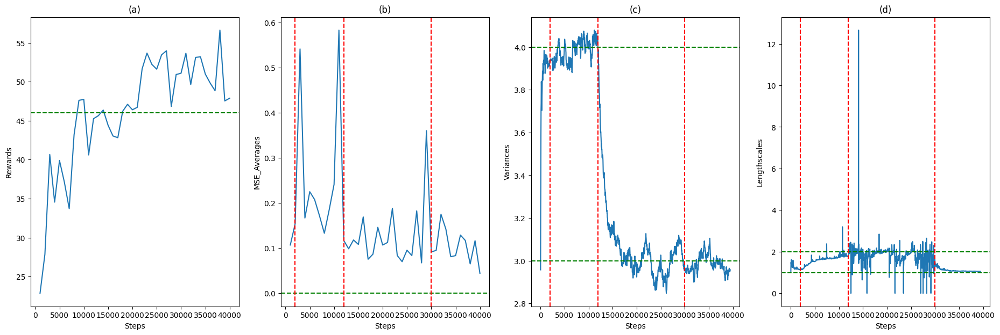

In [ ]:
steps = np.array([1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000])
##########################
avg = np.array([22.858246, 27.852575, 40.657276, 34.550613, 39.893486, 37.12864, 33.716587, 43.191322, 47.606956, 47.729446, 40.602947, 45.25347, 45.641426, 46.361233, 44.405327, 43.037148, 42.815662, 46.20462, 47.10162, 46.398014])
##########################
err = np.array([0.10692128934282424, 0.15431405764623313, 0.541553009462186, 0.16679706048574064, 0.22507167456892635, 0.20768475213224427, 0.1718427231146046, 0.13296228552505274, 0.1850482324477731, 0.24129546044491718, 0.583143925063048, 0.11695054460346921, 0.09854279724304588, 0.1180999546233916, 0.10827718547839069, 0.1691545358524128, 0.07539985879668074, 0.08661322129453797, 0.14614250389886632, 0.10682946787928856])
##########################

steps = np.concatenate((steps, [21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000, 31000, 32000, 33000, 34000, 35000, 36000, 37000, 38000, 39000, 40000]))
##########################
avg = np.concatenate((avg, [46.71288, 51.651573, 53.671368, 52.22222, 51.607567, 53.449318, 53.965263, 46.83231, 50.92399, 51.08242, 53.6463, 49.645, 53.11973, 53.190693, 50.972923, 49.82288, 48.847908, 56.609882, 47.532566, 47.87908]))
##########################
err = np.concatenate((err, [0.11256378157087113, 0.18836559510784537, 0.0836149052106519, 0.0700017241276937, 0.09546463392045286, 0.08350605486836322, 0.18258747218699597, 0.06738381378946405, 0.36039612128911985, 0.09180351562319909, 0.09486720854093546, 0.17498870992208826, 0.14217871498190213, 0.08099661666289537, 0.0834406746324868, 0.12896018280862928, 0.11691004634546599, 0.06500660684292252, 0.11647706834412004, 0.04433886908689642]))
##########################
vvs = [2.8582145121433884, 2.910509564284359, 2.8230180314973343, 2.772116803666399, 2.80338515887251, 2.8803038580438436, 2.892898830421801, 2.8619219814379697, 2.8050001636359894, 2.7625219994761125, 2.875529420711288, 2.8426182736894177, 2.780166484371548, 2.7111471349416614, 2.709978322675203, 2.822391077145221, 2.8073974701595903, 2.765601107818548, 2.874320040504312, 2.959078047448408, 2.956972485840795, 2.9934833654934088, 3.1615572066379416, 3.12534361017318, 3.227803867577655, 3.2216469923925173, 3.1726291252924637, 3.199029095611467, 3.223881772720393, 3.2396823433416233, 3.2025578740858824, 3.191959227558168, 3.14936571112977, 3.1077937521775265, 3.106803688262518, 3.26068521436031, 3.2536985866231816, 3.232105946821819, 3.345743763860385, 3.35931084677215, 3.333168053074901, 3.309844816999486, 3.284021485599985, 3.279071645787777, 3.3317551333006423, 3.4243321981414736, 3.4222617230183, 3.404907010826745, 3.3825511379978574, 3.3502931242630303, 3.3270307654789324, 3.304722280357912, 3.33305171540439, 3.307256783992274, 3.380512404592906, 3.406489642753504, 3.461401789162983, 3.433975690708809, 3.4550256907439474, 3.436023887220947, 3.4042057660576246, 3.4807476538029047, 3.450417703953611, 3.5021277473918917, 3.535131357253762, 3.527861797935676, 3.582165176498055, 3.592482834586954, 3.6050126963199687, 3.585357037671297, 3.5795491979442384, 3.609898019506145, 3.5973344162399097, 3.61468456239341, 3.589945657670012, 3.704721568776257, 3.677390535374397, 3.7697048994850073, 3.8110942408792994, 3.79236966280933, 3.769509637704261, 3.7495878754155054, 3.73964453478412, 3.734531051450053, 3.707386992663499, 3.6879794848477947, 3.6862688878991317, 3.69771977430572, 3.6886163556607894, 3.660994128509607, 3.66931275404783, 3.726371910162524, 3.7025524450588, 3.7067778289189657, 3.6922921699502824, 3.6833343408379924, 3.6949964762399516, 3.68324113073543, 3.6999929387569175, 3.708584700142752, 3.710382944248182, 3.6956167205020374, 3.711633367217696, 3.688344526889921, 3.7108185933024873, 3.687870643784461, 3.7598528017075177, 3.758637134979766, 3.7423125454973842, 3.7763402690461727, 3.8498240644084194, 3.8292964477324403, 3.8297129722146055, 3.8672909032046205, 3.853809184026862, 3.8323055622127793, 3.81391566308753, 3.8335838929196093, 3.814701610789245, 3.7937512781120506, 3.776036701367487, 3.7593685758383324, 3.764815871167142, 3.744470856522252, 3.736655146848568, 3.730171270947732, 3.708445881507514, 3.75682996160212, 3.7972942305881108, 3.7914507373838533, 3.7804437336873726, 3.770615298015855, 3.7543198560515245, 3.7910750570572143, 3.7817372635376048, 3.791791354661361, 3.809325892165608, 3.7947419957212056, 3.785092686558588, 3.8191983631748068, 3.820780895686453, 3.8583527422827144, 3.840042004893411, 3.8208902182573286, 3.805835637047537, 3.818168271042073, 3.804219387938696, 3.832592457909423, 3.8407657037841205, 3.838298474681741, 3.8592614186560508, 3.8487976168127442, 3.8403067832212536, 3.844542079898637, 3.8403037063020267, 3.8392394885418626, 3.818826767365665, 3.8084644722842813, 3.802181029555057, 3.796787109176503, 3.8831166097232477, 3.8659612758766224, 3.8782330907777274, 3.886636832130534, 3.8879116813620818, 3.87866467672584, 3.8912946277812757, 3.8785936446726024, 3.8748084517957273, 3.8812785398659693, 3.870878432300962, 3.8713252134478093, 3.854019222969331, 3.837088847268947, 3.832287771179888, 3.8304651652411907, 3.8196410452762666, 3.815885140255104, 3.819285555040046, 3.810632218802812, 3.796727306338791, 3.805980647760464, 3.8057390463281924, 3.801251267670265, 3.7849677725033555, 3.77815494552709, 3.7764325321631826, 3.769182482982332, 3.7656724152842043, 3.7628597915692943, 3.7535114197529116, 3.751297262670011, 3.745453648325935, 3.7366780502009926, 3.7220362407877055, 3.7233591940204, 3.716541905999105, 3.734829993815942, 3.770702560291949, 3.771570664175528, 3.772974670381759, 3.7715599214054114, 3.75836525091495, 3.7623718261110146, 3.7662438543915395, 3.757375644696616, 3.7449083847460827, 3.734081037760234, 3.723378290403993, 3.7096661664750425, 3.699701219857052, 3.695935759884678, 3.681713716625524, 3.670448144565344, 3.6837800840609227, 3.6827627733712025, 3.6760959298493794, 3.736805824136465, 3.725246450703447, 3.7131393132647865, 3.745079324923791, 3.7348329049498172, 3.7458458470545293, 3.7348912507770318, 3.753456124122519, 3.758305454631933, 3.7473528549873993, 3.7365997703146703, 3.758274937396248, 3.7588069052096595, 3.7632108075327615, 3.7625671824029903, 3.754182225317558, 3.7555356519544163, 3.763262870261073, 3.7661445126375073, 3.7629250968971357, 3.7633078306589733, 3.7582153452116613, 3.74826039729412, 3.7547910563284, 3.76551428565833, 3.782684082433364, 3.7831810823158745, 3.7762003976804546, 3.768973503908048, 3.7679076780648613, 3.7679559054605116, 3.7590839001950953, 3.7480119985492766, 3.7390282931077268, 3.72871844246887, 3.7297279778155255, 3.728515094453257, 3.7164896793493014, 3.714969408563799, 3.717991614898401, 3.737533268669638, 3.7357541841561535, 3.7284572574145822, 3.7242519809691355, 3.7156499722970877, 3.7078902150155533, 3.7064011027798838, 3.716323643695362, 3.708602504677819, 3.7088966438679423, 3.7013831905655636, 3.6930829966266394, 3.7091798534299514, 3.7002465829650113, 3.6934688217324916, 3.6812830143975956, 3.6911319653817816, 3.703613646523318, 3.6963337224925925, 3.695469461532115, 3.7079538804082404, 3.7252583468792366, 3.73289377999184, 3.7331394689476665, 3.7501570328186076, 3.7777341538841838, 3.7992725463928845, 3.800958258930134, 3.7913936640674883, 3.7922377346523457, 3.7880972709548177, 3.778500941569212, 3.7691180309453083, 3.765581622833081, 3.7630741588581484, 3.7821605540735708, 3.772497431371166, 3.7786282154905773, 3.7877628643755323, 3.7775234619741624, 3.7781138106124, 3.7721565145343052, 3.771743575849203, 3.7728891173382406, 3.7709443825506117, 3.769648559679263, 3.769953405431916, 3.760268087035947, 3.755581836565927, 3.782794311716247, 3.828981669710125, 3.8400023317013736, 3.8314648133021603, 3.825874580991822, 3.81612680853372, 3.8152554208747738, 3.807621500575589, 3.816802546748298, 3.8085103817929435, 3.800906776704486, 3.8153994753336784, 3.8209303228346196, 3.816182463450144, 3.8116770212386735, 3.802330480463226, 3.8079113142451133, 3.8008449899512, 3.796453582281184, 3.7993395548604627, 3.83311383611235, 3.8414884611742566, 3.854797782508098, 3.8631212990556905, 3.859741151992588, 3.848972328647026, 3.8506375163311133, 3.840736879944859, 3.8380349836115997, 3.8452696529520884, 3.8394371676129966, 3.8394041330732698, 3.853734498263099, 3.853054892236553, 3.850878918384842, 3.8415274888185267, 3.841996090597152, 3.8431242715434437, 3.838708352218258, 3.8330777976070145, 3.832757554445649, 3.8521949772091437, 3.8502351974977436, 3.8438701507785593, 3.838083230677329, 3.833315013438351, 3.827315603173522, 3.8303839006891103, 3.83024489136782, 3.8344737476500668, 3.8342049309939155, 3.8338216873595896, 3.8421356428467504, 3.833508686846601, 3.8338872475103094, 3.8261866988698747, 3.819114786582287, 3.8260169002914837, 3.8297289765484073, 3.8334625494448065, 3.8352390802455196, 3.828071320708653, 3.8316507035569463, 3.8368747474702642, 3.8377461167112235, 3.845373759708654, 3.841891994173223, 3.853943270147524, 3.852483907583093, 3.8665450038159186, 3.871555775796339, 3.863885895911618, 3.874470980188423, 3.881376420517666, 3.8765001334276215, 3.86912787438647, 3.8726172813130644, 3.872746618574493, 3.8717444488096353, 3.8745596305064183, 3.8691655835934693, 3.875318773084727, 3.8710402152591974, 3.884193076028712, 3.8847160124851876, 3.87965435691319, 3.8725014120947727, 3.874248929193459, 3.8698157677465677, 3.877895346681995, 3.873900972472067, 3.872686416354734, 3.8904181865423664, 3.8874038107050244, 3.888028893012707, 3.906236869476779, 3.898112063996275, 3.890175365439942, 3.906931599363024, 3.913613845268268, 3.9098807787909777, 3.9103025834138396, 3.9040116749558584, 3.9031456558444657, 3.900902520820209, 3.892295748340524, 3.8888516842799064, 3.8832182291729787, 3.8812706872813494, 3.879447862969708, 3.8788525309072486, 3.8723855760958523, 3.883837696273907, 3.882020451803492, 3.8818588797542457, 3.875644703384944, 3.872393758584583, 3.870323147027512, 3.8755972051794587, 3.8817527843159816, 3.8862841252753717, 3.8967484514742035, 3.8916672407129558, 3.8892664728277393, 3.886636040314832, 3.8804480057632995, 3.8785903513322815, 3.892222644684605, 3.8858494958537673, 3.879295974763831, 3.8772215285980973, 3.8707806884633387, 3.8671838830314313, 3.8688438604020026, 3.863371781613215, 3.862478913705292, 3.8657880038787438, 3.8637612341144774, 3.858056541468929, 3.8505479546619665, 3.844592580135661, 3.8470651241602303, 3.8480833486909924, 3.844428467351545, 3.8429519414181206, 3.839506645660717, 3.840921208489204, 3.836019129208593, 3.8337302224061656, 3.8582097488945806, 3.857394896972772, 3.856623488229512, 3.8651012030948655, 3.8636468574534293, 3.8591090111906694, 3.8531873579648535, 3.854439522039298, 3.8561755249207965, 3.854747244068012, 3.8506421702089795, 3.8526595008578486, 3.8486939002793426, 3.8530568423989124, 3.8693665220296953, 3.8693274655590515, 3.863034817816011, 3.8681346644730725, 3.881665305246968, 3.882655267836929, 3.884172680609763, 3.8767794195632237, 3.8761261675601086, 3.870674965668629, 3.8678250170591992, 3.8652402356824678, 3.877414019441476, 3.889298875900987, 3.8879355995849596, 3.8889745871100185, 3.882761173722741, 3.87720993818241, 3.8762083946063832, 3.873875429472709, 3.8707649766159613, 3.873491016250419, 3.8798810493262574, 3.8941274484285313, 3.8966614720554977, 3.9228404122104594, 3.919326746718146, 3.9187192924007097, 3.9168158468241363, 3.929357122000593, 3.923380823949451, 3.91755512272757, 3.91755400454631, 3.931673096873533, 3.924957507887641, 3.9183216139547636, 3.91196771562605, 3.9164973560609586, 3.915714947334072, 3.9123304725704915, 3.9112853711955164, 3.9115010287720313, 3.9149458198207223, 3.9121471671419283, 3.9166181645935847, 3.9121569558685394, 3.915571011055355, 3.912686751236279, 3.9163424960705004, 3.9182156619199238, 3.9146323818028748, 3.908878799391896, 3.9050952206227243, 3.905479293371637, 3.89901908494257, 3.8938382264369387, 3.8944528880257043, 3.8936516735662603, 3.8877683023134724, 3.885552096329717, 3.8857999119796554, 3.892453663199458, 3.9004324159116064, 3.8958459418867, 3.8952779459693216, 3.8986492905880845, 3.9045969942494025, 3.8990206271887327, 3.9093797503633074, 3.9031838629164404, 3.9013536685968653, 3.8954186326124782, 3.903658060361849, 3.90214666648407, 3.9084172179259786, 3.9025009724315587, 3.9123596151651365, 3.908280548427528, 3.9071403215203513, 3.9089660878433907, 3.9071709363792424, 3.90673036783513, 3.903954453753429, 3.9098422324835904, 3.913020082622485, 3.908203178446548, 3.902423134308145, 3.9066367121511814, 3.9004730741401037, 3.8952208547790703, 3.8963264088340295, 3.8982315113265926, 3.899807175512406, 3.9014135728007786, 3.8971379379681155, 3.8921329387682597, 3.890556016800232, 3.888902407381267, 3.8825055144441762, 3.886707771154167, 3.8824015073524394, 3.8848073888477583, 3.8824506283205555, 3.877796186151838, 3.8783405991398916, 3.8753455785493327, 3.876469254898775, 3.8803757245303103, 3.9055061843068786, 3.90292236114577, 3.9001641441878756, 3.9009909501551614, 3.9056527079352557, 3.902221673484864, 3.898613214990333, 3.8997420593718095, 3.898362095595777, 3.9118685749047213, 3.907536890454981, 3.9103750115482567, 3.906632299772556, 3.9110670614899434, 3.911963009636601, 3.916366374888993, 3.9355324876571176, 3.9347400483320945, 3.937893364618753, 3.9382200144596635, 3.9368126474933276, 3.932698655249066, 3.9341098664353296, 3.940286062301219, 3.939810124197529, 3.9459753909510993, 3.9459048022331857, 3.9452503116071505, 3.940766376114547, 3.941680723448819, 3.9448097559526736, 3.9439718427704236, 3.9403968088964088, 3.9388721304095693, 3.934802953744733, 3.930542992768181, 3.937728774713611, 3.9317643654827537, 3.929514715192147, 3.9260371205460896, 3.923967596955884, 3.924829806834616, 3.9294927692131316, 3.929684859912357, 3.938831580554161, 3.9355065945441305, 3.937797548049132, 3.9364142391106007, 3.9326436545422796, 3.9286899126221706, 3.934134996219368, 3.930985208534824, 3.926862130817547, 3.929724001652479, 3.93436639790555, 3.9316547009021012, 3.9287006680276617, 3.9304366119702103, 3.9276677806236537, 3.923424931618695, 3.921895874183904, 3.9268239513829615, 3.9246605093658258, 3.9196896003981414, 3.9162505939360415, 3.914288738045502, 3.9168390167815845, 3.9228159346155054, 3.9270357443951993, 3.9230094630843033, 3.9204197570327204, 3.9196117947372113, 3.91798348031415, 3.9139053142079328, 3.9151348399356745, 3.9359150391567868, 3.9339922552104234, 3.9311763178727417, 3.927928464403786, 3.924653329397758, 3.9307112867260474, 3.9341145619540505, 3.9423429168486592, 3.941572608931656, 3.9374533527125077, 3.9358947592205245, 3.938243280515491, 3.944987621606482, 3.943301908047801, 3.942418647047864, 3.9393982191336896, 3.937857597037477, 3.941577794881403, 3.941513114746657, 3.93765040864864, 3.9392053768936157, 3.936178116563623, 3.941350036871406, 3.943909937353249, 3.9469643503731775, 3.942564818331681, 3.938305329941096, 3.934903506875597, 3.931132934541303, 3.9323775073124283, 3.942556244599999, 3.9393261367705934, 3.9366155781786834, 3.934549216532749, 3.9353266573473897, 3.9435468737679487, 3.938567508465703, 3.938011134006979, 3.937182228639797, 3.936884499419301, 3.9382626053686365, 3.936348935683649, 3.9314410241719338, 3.928368632392701, 3.9392434093763713, 3.947874513696182, 3.9462746275334575, 3.944418199407858, 3.9435220522347914, 3.9488972004190557, 3.9448158756160767, 3.940476863677189, 3.9396689117651444, 3.9489375707258367, 3.9566701096787367, 3.9535497316555355, 3.957201585678373, 3.955015761470099, 3.955071593569622, 3.966490292191374, 3.9636227146552683, 3.961067114022998, 3.9611155118652848, 3.9618113980138343, 3.990210965389802, 3.9888087015916294, 3.9873778501479635, 3.9980397675426453, 3.995140759845035, 3.9931012365802467, 3.989666862508356, 3.9862268593952805, 3.9841252191146204, 3.985883093789406, 3.989280762518135, 3.986369230352779, 4.00565836679925, 4.00421620058323, 4.002244209814954, 4.004356583836939, 4.006190948906742, 4.002422686274381, 4.002162730997741, 3.999531209737123, 4.00172649531718, 4.00227876366428, 4.00069228591629, 4.003351417123051, 4.002046652016512, 4.003803775623091, 4.003215205257152, 4.001987217425669, 3.9993213278200854, 3.9967609490831943, 3.99667400910666, 3.9920552258900273, 3.9890084175440563, 3.984197998613847, 3.983536665772446, 3.9822540658496743, 3.978231840684342, 3.9745053925375187, 3.971845847271516, 3.972614316177579, 3.9776398564594397, 3.977919874640839, 3.9731161741967647, 3.9697968867134685, 3.9668434037317666, 3.968632186380215, 3.9655923269321782, 3.9719943181871225, 3.9738400274043344, 3.980987903675125, 3.978248727341606, 3.978530122098707, 3.9755017766888003, 3.976823755676763, 3.97537665793281, 3.971443512165253, 3.9698795818828834, 3.9692196100038237, 3.9701725209789953, 3.9664978377705804, 3.9640353895981035, 3.9681037186067525, 3.9680368377510526, 3.9664730508889434, 3.966629668219906, 3.9688782743505286, 3.971408574735661, 3.9681617265003224, 3.9656060199163186, 3.971768913017719, 3.967665423780094, 3.965671013542758, 3.963322648821272, 3.960200803967542, 3.9640194786510383, 3.960034397969614, 3.9594872040040183, 3.9589210297630024, 3.963587734683986, 3.9639405795863603, 3.9698300107145488, 3.9653139766875927, 3.962856551166628, 3.9644907155154057, 3.9613829932745235, 3.963271406990029, 3.96749889533448, 3.9734071343455835, 3.970193096153856, 3.9679628126127797, 3.9640673041650207, 3.962853086745686, 3.965583003866888, 3.9637439688803586, 3.96003114226237, 3.956562868987633, 3.953342510142633, 3.952183606423767, 3.9488921570768407, 3.945315076453443, 3.9464538228830546, 3.944839369376179, 3.941659010483733, 3.937853408052181, 3.941348090968176, 3.9405192782926175, 3.9393779622527836, 3.935747886766949, 3.934415863644718, 3.9318217713502737, 3.9300511797438946, 3.9272537947992925, 3.9250757528656575, 3.9235640746909204, 3.919813563588599, 3.9160354420548225, 3.917194312629113, 3.916903811114166, 3.914742394541899, 3.9123787216504455, 3.9307614497596464, 3.9341257854001874, 3.934570677831038, 3.93364030294701, 3.9330717552234673, 3.929480570155647, 3.9283363240910143, 3.925946013286238, 3.9256676596100397, 3.925114717896264, 3.9243814683165574, 3.923968775546715, 3.924023351839059, 3.9241446768478787, 3.9207035680963402, 3.924001299137296, 3.925820043773543, 3.925798763173586, 3.926676119186036, 3.927191078576002, 3.9241207102111906, 3.9264420140903953, 3.9253934776762587, 3.9244955775697568, 3.921466244176262, 3.9189151935818147, 3.9180559201402496, 3.922546271790333, 3.9273891550629836, 3.926861027030067, 3.9251321820480047, 3.923370065177102, 3.928142746846472, 3.9263640551411263, 3.9235040709353814, 3.922141108456423, 3.920990393844335, 3.918533322373357, 3.9182865882801403, 3.915658172326547, 3.9175064223939318, 3.9148402830668014, 3.9146951100818304, 3.910687066757464, 3.9114339350938487, 3.908371421567157, 3.907086653234732, 3.9055780973727945, 3.903636155323927, 3.8998456305008196, 3.8959835926772888, 3.8943086026561455, 3.894393043261218, 3.895504311758558, 3.894262550158112, 3.897607906960158, 3.8964459365375044, 3.9037036133718166, 3.9061716773853736, 3.9084380791482634, 3.9070052627733274, 3.9046488174314007, 3.911544477345097, 3.912079239511857, 3.909219879445475, 3.905329048126427, 3.9072989680426815, 3.905209956324686, 3.9030327672819265, 3.9056224613501973, 3.9029733532680124, 3.900111005413776, 3.8998151282890237, 3.897097201131298, 3.8959175525647822, 3.8936359359430233, 3.8901149507428348, 3.8862092322512303, 3.8832173789383106, 3.8809169038567535, 3.878864090758178, 3.8799363794254678, 3.875962633044396, 3.8730570590648306, 3.873370990242474, 3.870542920790553, 3.8747563547832713, 3.8751593540156377, 3.8769876392264933, 3.8744120934762027, 3.8826019455670897, 3.880572603222906, 3.880872152757846, 3.8778223380785506, 3.8769595238407186, 3.874911394343734, 3.874140009821667, 3.8728055615708636, 3.8738413798887605, 3.8719537678071556, 3.876909323997538, 3.876837656180133, 3.877782370773351, 3.8759461726091793, 3.87543265947118, 3.8771328447158773, 3.877751574320332, 3.8767125988267073, 3.8876193730691497, 3.8900446900402033, 3.8894333290472023, 3.8874453950103662, 3.884096049355765, 3.8826682877433982, 3.888288917836592, 3.888998290931002, 3.8894542786459914, 3.887506607761351, 3.88600501343163, 3.885603222826211, 3.8852880490899544, 3.884904366523332, 3.883626453052602, 3.885831654551698, 3.8831040238369017, 3.8806789578503733, 3.878976997264845, 3.8765550941102, 3.883730653904003, 3.880793638232948, 3.8804633774203547, 3.8866379073378092, 3.8852355259083926, 3.8814931839832436, 3.8859162239964817, 3.8860143257444983, 3.8872918616025824, 3.8851748992600985, 3.8882463009171797, 3.8913775519752924, 3.8913959379223484, 3.8920519696354976, 3.8886526533931893, 3.8876679605447535, 3.885209048469735, 3.883322124763647, 3.8858482845464115, 3.88625799003524, 3.8900908628197985, 3.8896939824111216, 3.886609513967287, 3.8864578207262883, 3.894306326669432, 3.891558141316806, 3.891642492755124, 3.8919751177978195, 3.8917828844888853, 3.8903875842732343, 3.8944817732538133, 3.891160875863434, 3.8882979439730017, 3.8937449370886594, 3.8945439973026543, 3.8923743005631204, 3.8900509498417635, 3.9098927995356294, 3.907283641563885, 3.9164292695574816, 3.9144605533237824, 3.914268143214734, 3.9196453867469354, 3.9173042355672885, 3.9189561103860977, 3.916685236748769, 3.915007083721882, 3.921478471814912, 3.9194324057562637, 3.9245548822874152, 3.926211809309833, 3.9288384901173656, 3.936600088758684, 3.937162734216788, 3.9368442541875006, 3.935036657743162, 3.934712539325333, 3.9354260882743555, 3.9347329515725367, 3.939479085141763, 3.9362821289868872, 3.9404211436911663, 3.9369866373417817, 3.9424778044283677, 3.9492012983031635, 3.948326981961145, 3.94752120728571, 3.9509570351323053, 3.954900878161744, 3.955623918606697, 3.9649647138395405, 3.9664501149130116, 3.9639995365919467, 3.964875261113407, 3.9621409742128373, 3.9603687898861804, 3.9628926423577147, 3.9607659367656405, 3.9596544183878386, 3.9655179770554483, 3.9636866747582684, 3.966141074166576, 3.968598630008197, 3.9650838594465494, 3.9659231573792866, 3.965156576562975, 3.9648378250318594, 3.9655138122509674, 3.9633551556309676, 3.961528555024918, 3.960382340563253, 3.9579598815523114, 3.957748625543198, 3.954875312181789, 3.9549568104660557, 3.957676248787809, 3.9542898405686437, 3.953410738664213, 3.951957247528567, 3.9511073042551024, 3.9512626514482174, 3.9495393018609697, 3.947506075135296, 3.9461317120396004, 3.9430137063138506, 3.9408627599454733, 3.9406608580379587, 3.94412228004053, 3.943456314395095, 3.941028703172394, 3.947069418694037, 3.9436094118221865, 3.9442300512807265, 3.9434852818152395, 3.945254411023158, 3.943246136493856, 3.9411112424738763, 3.938516324233892, 3.9413963132358583, 3.943167685828979, 3.9414503287258924, 3.940206674242079, 3.937190023101813, 3.9412687262687807, 3.9495825637099986, 3.947333719369063, 3.946517238326726, 3.946682082443019, 3.9450861071386867, 3.9452947276491215, 3.942372187374702, 3.946261842086049, 3.9447164986014425, 3.9424555304946285, 3.939439732800889, 3.940332228754976, 3.9435466409184947, 3.942823172639358, 3.9480997047082207, 3.947873922266722, 3.9480963729321594, 3.9474991903019774, 3.9453426612860234, 3.9458626685661, 3.9428696026114474, 3.942655435075193, 3.9408356383985716, 3.9410650615769445, 3.9403758298662512, 3.9395680678484726, 3.9389000015868096, 3.9428297324924237, 3.9432108200092864, 3.939890003577777, 3.9384676209238054, 3.9374571185849594, 3.93572239434884, 3.9363572577961174, 3.9404816204977102, 3.9383755159357325, 3.938150699137564, 3.936163729391186, 3.9356538395692517, 3.937277684419573, 3.94163715201444, 3.9441740054100816, 3.9456612580283235, 3.943943711552154, 3.9466034765120646, 3.944311168967628, 3.9424770640898243, 3.9396783667406985, 3.938493166560996, 3.9385202978711478, 3.9358920101486543, 3.934259598231697, 3.935240190887084, 3.9342461043533894, 3.9383063817904342, 3.93641413642959, 3.933945285438273, 3.932609634070713, 3.935614983851485, 3.932622716240363, 3.935127736627197, 3.9351359688586296, 3.9345212201827753, 3.932227587814571, 3.938365333397035, 3.939013075266979, 3.9420497438221314, 3.949876341496754, 3.947749447866181, 3.9523301887459135, 3.9548579705387503, 3.9540898185386726, 3.952308915623425, 3.955890315630966, 3.955888405443721, 3.954130255847593, 3.9511195802314307, 3.9509094623737044, 3.951004574043736, 3.9518919658699616, 3.951063281477968, 3.9530710210519135, 3.9554509291091704, 3.9567682441471708, 3.954065333560126, 3.9511008495706217, 3.950557765563309, 3.947953746351953, 3.9472310644207873, 3.948784779308058, 3.9565075981490216, 3.956566379563641, 3.9646665614019243, 3.9680841704403247, 3.9661434405914275, 3.96694719743307, 3.966022292878334, 3.9722093664327454, 3.9720273789835727, 3.9735679282396994, 3.971126604826625, 3.973812913441009, 3.9711917852711496, 3.9715266844370976, 3.9686743979037393, 3.969663668005834, 3.9676028045174028, 3.969123328714436, 3.9664951189456636, 3.9661775595886093, 3.963622812594363, 3.963144769269494, 3.960893274427205, 3.9598519962406145, 3.965912763580716, 3.963800620355186, 3.9652155454931544, 3.9664833512776947, 3.9656646003371105, 3.963311236970613, 3.960620178658334, 3.958378063126547, 3.956641129093723, 3.9584344433755896, 3.956774956546765, 3.9547834542085587, 3.9557700842214305, 3.9559698712778077, 3.9550419887070993, 3.9590513440354456, 3.9568853421127383, 3.9565828082443635, 3.954544531461698, 3.9528359485998132, 3.955779805952276, 3.9539867277352014, 3.952234275030563, 3.951178964223116, 3.949148944473873, 3.946665458466123, 3.9493646181342603, 3.947731019720774, 3.9521610500210027, 3.950032978648582, 3.9472961996485383, 3.944870932898332, 3.9419717519376554, 3.943298953683783, 3.9416952754083012, 3.939156554642489, 3.937982343018182, 3.938997397641921, 3.93721516110079, 3.9367053727599197, 3.9342861944827217, 3.932370567032671, 3.9303614842319337, 3.928072908487086, 3.927348886119322, 3.9245364868424986, 3.9238245291016307, 3.92304676888654, 3.9323044258571094, 3.930232146030254, 3.932136963269744, 3.930029944155917, 3.930718533610839, 3.9323072551893787, 3.933424980655638, 3.934597957625222, 3.9355522669087772, 3.93455064798736, 3.9362701240484026, 3.93528081807641, 3.9382934155353677, 3.9370154636222554, 3.9398962442668712, 3.9433991269805606, 3.944128585925668, 3.9502842843060284, 3.9484399751025467, 3.948287509047573, 3.9471110092744266, 3.9450452897285855, 3.9426096939014643, 3.940207110324022, 3.9414846985884666, 3.947216997820285, 3.951781851559878, 3.9500452480392094, 3.949945079983976, 3.9480166716895635, 3.945271878127817, 3.9456102716199135, 3.945625767902468, 3.949130672864017, 3.9476815722854752, 3.950175234115569, 3.953216589677962, 3.9502537025042757, 3.947835592043106, 3.9505033795292435, 3.94975465397962, 3.9498419429254907, 3.9513267140826094, 3.9491000204710995, 3.9642327987785944, 3.9663125918239324, 3.9664269513579558, 3.9652332142025384, 3.9625239120363394, 3.9599140605967333, 3.966207478318755, 3.968907571481782, 3.96811022797514, 3.968503046669236, 3.9666101024072944, 3.966335000582236, 3.9668859303034765, 3.9655452124744515, 3.9639100088903327, 3.963721251538771, 3.9609307196442525, 3.9589285106293244, 3.9621500719914056, 3.9616532339311306, 3.9595181867805747, 3.9602974214681566, 3.9591030800542675, 3.9584944177362944, 3.955793975490455, 3.9564432622529133, 3.957731008518979, 3.956727529096889, 3.9553184500464456, 3.953561639170901, 3.952606256970326, 3.952718682290129, 3.9560363892849826, 3.9572887961434433, 3.961772136003506, 3.9598747367742835, 3.961182708341349, 3.9612585858986162, 3.960745036440659, 3.9584771192501766, 3.9567299700862724, 3.955337229829186, 3.953783968108718, 3.9518788986965534, 3.9497136565749855, 3.947100887276312, 3.9477635700739175, 3.948910755509142, 3.9474625446656315, 3.947072653265912, 3.949297077330932, 3.949120958387742, 3.94753070972678, 3.945604628035956, 3.946921964658852, 3.9447969419972746, 3.9439807787129393, 3.9415468750517593, 3.9395933946547133, 3.943082999113104, 3.94190939025607, 3.941813991066494, 3.9406678306375187, 3.9497107187366285, 3.9498208805798805, 3.9477825604682444, 3.945361734133703, 3.9486568363797856, 3.949300178142193, 3.9495334249779996, 3.9482105808047714, 3.9465168613058994, 3.946125667069856, 3.948116115161113, 3.9483116508503944, 3.94927509627205, 3.9473284345010837, 3.950401698722339, 3.950241410945937, 3.949139366970982, 3.948415574271047, 3.946746167315423, 3.9465781843862366, 3.9505841657523266, 3.949466712202383, 3.951564521711119, 3.951565951147133, 3.950844549061801, 3.952225312873287, 3.9508145456434702, 3.948113671189541, 3.946173107174223, 3.9470746428031043, 3.946269602966546, 3.9450392850551355, 3.9455868552451263, 3.9446208773297444, 3.9420446360527377, 3.9407451767533086, 3.9391932568511097, 3.9374275771685996, 3.9355027585814653, 3.9363414132819616, 3.9352278190161645, 3.93411204389365, 3.9333228758317804, 3.9331298838549094, 3.930413295539723, 3.935914099106465, 3.9352555230557975, 3.9359548800993314, 3.935086059073275, 3.9335405162869543, 3.9314533891944574, 3.930536768698461, 3.929320377313799, 3.9315870494314678, 3.92974137706134, 3.928439169467769, 3.930775825040091, 3.9304298819932453, 3.929049606163825, 3.9298861204014375, 3.927541249369896, 3.9250869579572, 3.924466443254538, 3.9235384543081313, 3.921264866473148, 3.9210067828500157, 3.9233051119092837, 3.9226038837420423, 3.9213633515013453, 3.9196100342735734, 3.919028373190012, 3.9186348892230285, 3.917593180141034, 3.9174280404116257, 3.9156765611751676, 3.915004354051068, 3.9173453477069966, 3.9159462548427832, 3.913459203196829, 3.916327789285915, 3.9144949805897276, 3.9128470650177936, 3.9108479610872267, 3.908935783863893, 3.9123813831930807, 3.9130089749067696, 3.9140377440949234, 3.9121922354199694, 3.9136409502129736, 3.913080529363416, 3.911587503351651, 3.9187414773489837, 3.9168261097655326, 3.915234635183875, 3.9129061489449737, 3.9129932097521496, 3.911080647741684, 3.9094692372977495, 3.9093525051979334, 3.909162733273832, 3.9082614610589657, 3.9096919497796576, 3.9084694616225812, 3.9092401689451792, 3.9109635831496132, 3.913093048073664, 3.910923686663686, 3.910327932157348, 3.908481185571406, 3.9068071422066857, 3.906060534442261, 3.9042623878092844, 3.905059862898719, 3.903846700091211, 3.904256619069385, 3.904748636381113, 3.9028025218757163, 3.9015726663390007, 3.9003820644106035, 3.9053468396570676, 3.9059844769823706, 3.90506379256987, 3.9054510461883987, 3.9041609365439154, 3.9041568932711233, 3.902518303410601, 3.9034050707126027, 3.9061641079341847, 3.904803642185569, 3.905655120126383, 3.9039032291463807, 3.9038197579418887, 3.9045624709842754, 3.9035516670107233, 3.9030406440618433, 3.9041636357453116, 3.906514471582651, 3.9052592176902974, 3.907706913154459, 3.9090915305660077, 3.907554720053465, 3.9080216954122577, 3.9089779133041165, 3.9113766778193004, 3.9095597832031266, 3.9093339797725273, 3.9079393691846898, 3.906496495007303, 3.906701644173519, 3.9046237762325795, 3.9052099239302294, 3.9063047146527348, 3.9086322672571394, 3.9094844472215806, 3.907246329394191, 3.905995971368945, 3.9105127024356467, 3.910336823619433, 3.912220380703844, 3.910272447667087, 3.9123487515964923, 3.9112982428736545, 3.9109601268520064, 3.9089522696680197, 3.9097003685283256, 3.909721521276702, 3.908644491103936, 3.911036217016312, 3.9105981209108642, 3.910365851113664, 3.9096485903724716, 3.9091671489377164, 3.908395991304061, 3.907137849731754, 3.9089418001070717, 3.907193744122027, 3.90640844474918, 3.9143504875115744, 3.9129954171175565, 3.9147423227730087, 3.9133510361452957, 3.9109864524959965, 3.9099825718672245, 3.9078618408287147, 3.9058971838542402, 3.910152611716608, 3.9129046687440656, 3.913730964708353, 3.9132284291732957, 3.9126703110567522, 3.920514434162392, 3.918061549207648, 3.916157735997444, 3.915223000380251, 3.915927891168238, 3.9162419586827153, 3.9146397643245265, 3.9127074759354286, 3.91124054969141, 3.909046532638034, 3.907801753954622, 3.90607956811872, 3.90545060628417, 3.905506906382366, 3.9048111727741768, 3.9045392793771594, 3.903068541671946, 3.904089360263938, 3.9022154121473798, 3.9011007721333075, 3.9006519106272997, 3.900968875035383, 3.899196976716462, 3.902080188000716, 3.9012243032542484, 3.9044763226390113, 3.9062133813821243, 3.9073048597115774, 3.9070498225904156, 3.9069191988831817, 3.9080270444501104, 3.9078925496268813, 3.9058311625814945, 3.9067792846657516, 3.9066592265003606, 3.905942138844733, 3.9050711091300356, 3.9038225105312008, 3.9026770433001037, 3.9011838919543496, 3.9004559548920446, 3.898461399989435, 3.899163372883315, 3.899760694941586, 3.9001695103049046, 3.9080253424086386, 3.912255594225563, 3.914305217233313, 3.916050984873251, 3.9137001949022214, 3.912335190857211, 3.9127096760563185, 3.9126409893072345, 3.911254612558385, 3.9102707767406084, 3.9109906480811114, 3.910237724636077, 3.90918716357191, 3.9074104393102553, 3.9145214376966018, 3.919780037449825, 3.920849437880467, 3.9205533412053373, 3.9244939663841376, 3.9226027735817217, 3.9213234935768497, 3.9192961569576785, 3.9218288403767527, 3.9197210041327986, 3.922354633220567, 3.9211841220140218, 3.9223718903132845, 3.9206629281396284, 3.919797196281476, 3.9185538589254283, 3.9171413075685897, 3.9155295794136267, 3.9220648517834276, 3.92622529736367, 3.9250158067569596, 3.9265983637059745, 3.9256907378983117, 3.924641324107681, 3.9227680984841813, 3.9227696949043254, 3.922807541018952, 3.921029938073806, 3.9229834655876727, 3.9211394511724458, 3.9204315349632175, 3.920466106715323, 3.920492640714046, 3.9215721917882216, 3.921087401493107, 3.9202724295694305, 3.9199975087279695, 3.917955579687954, 3.9179013261754476, 3.9167836841401984, 3.917624786648265, 3.9155911372607335, 3.914513934153973, 3.9172326985857486, 3.9155630060840685, 3.913823149056557, 3.913283321980078, 3.9199721679493353, 3.9198622644248857, 3.918363039375631, 3.926181688495241, 3.928282786302148, 3.926398591976361, 3.9245044684890633, 3.923330923485784, 3.9211959288890887, 3.9228031372510275, 3.9210436570147404, 3.9193163854736355, 3.9186837042196023, 3.9194381895249486, 3.9183160050490558, 3.918110398313263, 3.9177342015709398, 3.9165017817521646, 3.9183736642825218, 3.917113407644119, 3.917338394355222, 3.9175215017504543, 3.915319177310383, 3.9176883210584332, 3.9175577569575, 3.917769405569015, 3.916946226086444, 3.9203799424993457, 3.921130319154998, 3.92095212385836, 3.9217199525017103, 3.9203777725288216, 3.9197428931394036, 3.918336788004482, 3.91974186533722, 3.9178646660566976, 3.918032053913813, 3.917336419871146, 3.91951893323021, 3.920361176603928, 3.921399903384701, 3.925219898080663, 3.9237403821394357, 3.9232069453179106, 3.923204498601379, 3.923179686484389, 3.9244072548782896, 3.9227906754720236, 3.921444575735296, 3.9204900828972273, 3.920335952196157, 3.919411198182744, 3.917560778967555, 3.916847465257718, 3.9177038099012043, 3.9169139656652883, 3.9246938881744486, 3.9227953365923414, 3.921796662043396, 3.921050489991662, 3.91920539448275, 3.9188513438391572, 3.9204877108267397, 3.921301526644371, 3.9199427802099303, 3.9200590397285433, 3.918986699614827, 3.9175208934013264, 3.9166418183719895, 3.9170603674197024, 3.9151470580389565, 3.9150912922216388, 3.9188880208903565, 3.921525279951042, 3.9215496117663298, 3.9200287113916774, 3.919773925187639, 3.922196545991359, 3.9230591744916516, 3.923196161657205, 3.9226083277781845, 3.9217151590999957, 3.9229948159114882, 3.9209499045163145, 3.92121099172363, 3.9204195434282982, 3.921092209840251, 3.919263157570877, 3.9178783201504657, 3.9196578092379535, 3.918862337366597, 3.919491623790346, 3.9184091921372093, 3.9187920822263713, 3.917128275517897, 3.9184391044719926, 3.9166199002733224, 3.9170740781905, 3.915343957396176, 3.915677375158005, 3.9175100342397684, 3.9178180530684967, 3.9176839324035284, 3.917829185481805, 3.920079615984289, 3.9190692700840617, 3.9181459400857817, 3.9202728005839016, 3.926872793043396, 3.931429927885101, 3.9327143584919604, 3.931501668635225, 3.931606441003266, 3.9311225246460113, 3.9329220726040064, 3.932233482321955, 3.9321754207640964, 3.931771385382218, 3.9350229366150384, 3.934361114737195, 3.937395731244518, 3.936039751252598, 3.934339627430777, 3.933411536206277, 3.9336691254586444, 3.9327419760140985, 3.93196974711902, 3.929995488344084, 3.9317686705347423, 3.930019326707624, 3.9279036196482466, 3.927846691777591, 3.9265995615356846, 3.9255663022743925, 3.9284584570051773, 3.9284678852142543, 3.9275121678225227, 3.9274758948948807, 3.925807921434728, 3.9266582793449936, 3.92571320432731, 3.9248798148562574, 3.9230665387300956, 3.923293368225257, 3.9230038067319017, 3.9237567600016243, 3.9225728567182303, 3.925354394576555, 3.92358760864277, 3.925783143711531, 3.9237989969207634, 3.9220620216561026, 3.92077828873186, 3.919212105559739, 3.917468454589393, 3.917793500512902, 3.91641414392288, 3.9146434604567566, 3.912814737505405, 3.912534809862561, 3.911646416895755, 3.9099946899221285, 3.9087561451091273, 3.9087536840611237, 3.906976286349503, 3.905523620053087, 3.9056697885593525, 3.9040470451603144, 3.9031079830415485, 3.909321212660423, 3.907533166930768, 3.911510104424573, 3.9128936931551954, 3.914650188900046, 3.9130398349031714, 3.9135987164957267, 3.9173382746210383, 3.915504954788525, 3.915770562677716, 3.9162544991237747, 3.916030727939051, 3.91580538036183, 3.9149403295656207, 3.9166218355356572, 3.9168680464829704, 3.9169147563674036, 3.915925509056258, 3.915107036541354, 3.9155248877971243, 3.9149814872794493, 3.917841656952902, 3.916752899921881, 3.916783886561096, 3.915910153974483, 3.91820992591745, 3.9171054099940696, 3.916059631639696, 3.9160056591950765, 3.917344919612811, 3.9156431234624427, 3.9149621028132358, 3.9144305558139325, 3.92277935787265, 3.9214830709916924, 3.9208653856537317, 3.919896387537536, 3.9186738541654815, 3.918082152853447, 3.9188696438876804, 3.919322682854423, 3.92213398734963, 3.92203925346197, 3.925865901971532, 3.927624768510588, 3.9256516230459466, 3.926280482348434, 3.9265751619476372, 3.928850893610065, 3.9318203274291537, 3.9323689140906155, 3.9330431034508, 3.9320516778647585, 3.93118898526219, 3.9301441987583323, 3.9337976251953153, 3.93207776645773, 3.9305916960299747, 3.9305665565016943, 3.929473082114376, 3.9287956184689454, 3.9280291944909966, 3.9290570061372563, 3.9308955077163192, 3.9296199039631268, 3.92814817095918, 3.929371208085121, 3.930447889056955, 3.928439396382467, 3.926912749012904, 3.926080798630601, 3.9266366813491373, 3.926856618606422, 3.9252661836919684, 3.926188777445863, 3.9272225390389655, 3.9261970895264158, 3.9250338564769365, 3.926751106946173, 3.9249078951636682, 3.923928888186379, 3.924543520652004, 3.92403298521175, 3.923656128885942, 3.9242747393612514, 3.9239404792433636, 3.9237518911233975, 3.9220994592508656, 3.9225410600335477, 3.922404542995888, 3.922322390696115, 3.920663388993304, 3.9216982884173226, 3.9205778153466384, 3.9187363064360072, 3.9195850520433146, 3.920463309970967, 3.926574630053759, 3.928810500050314, 3.9289896840424263, 3.9285181423265314, 3.9269366575413724, 3.92631641659731, 3.924652374127501, 3.9256474470712988, 3.929402066377044, 3.927999867059465, 3.9284819084870617, 3.9300906513986797, 3.931268930633735, 3.9317224716135124, 3.931179365058466, 3.929852008710306, 3.929653788770683, 3.927977034020446, 3.9273380878574877, 3.926694525280648, 3.926167898234609, 3.925492524488086, 3.9322976412518207, 3.931188211257076, 3.931372728480338, 3.9332382821490404, 3.9338997014219754, 3.9324708796205963, 3.9310476041304936, 3.9312461461704795, 3.9303487280297364, 3.932659277049061, 3.9324270382492412, 3.932647886279219, 3.934013554289146, 3.933129614758014, 3.9312248387206186, 3.931125436033675, 3.9296314083783255, 3.9284607561132945, 3.927593263972727, 3.927097831036895, 3.9269647042176787, 3.92822190745469, 3.926783428000365, 3.925296288771293, 3.9251226691637577, 3.9268567655047693, 3.928222878200658, 3.9270308306432824, 3.927112861591177, 3.9266405905237813, 3.927805956528808, 3.9275508685601928, 3.9283870085374812, 3.9288174295867195, 3.9281019054113386, 3.9313510769666964, 3.9301379668943346, 3.9298644061038, 3.929637727190995, 3.929241025972794, 3.929316167638253, 3.93042388149411, 3.9289864285312475, 3.928687701142352, 3.9294352534288137, 3.927945593151765, 3.927880078058719, 3.927230065632984, 3.9264570134943124, 3.928791890306354, 3.9279598118716867, 3.92849714688887, 3.9281433449168826, 3.932435212161549, 3.93388389226604, 3.93430256993669, 3.935504973413404, 3.935581732976359, 3.9351974224252024, 3.935018425166111, 3.9340302880328237, 3.933175730816056, 3.933621421385654, 3.932791725894167, 3.9325165844849677, 3.931049776424094, 3.9296362410280294, 3.9298608685595515, 3.928097169146079, 3.9314193338559487, 3.9330461287077263, 3.9329986363820924, 3.932278806148619, 3.938222441862399, 3.937200680274571, 3.9413589694346323, 3.9415885048133266, 3.943820082523854, 3.9425197124272215, 3.941332635210759, 3.9405309421689925, 3.944276156479091, 3.942979336822605, 3.9428932178306093, 3.9449025114450045, 3.9440076440929035, 3.9435550628796694, 3.9426625630716, 3.943684537908272, 3.9432977308956594, 3.9427146971048197, 3.9432042104398217, 3.942550924744735, 3.9431833706372137, 3.9431871476526505, 3.944418290537137, 3.943422430510406, 3.9438648681663655, 3.9443644258893773, 3.9443415962601254, 3.9426698813610113, 3.9417886039303607, 3.940738805928855, 3.9419517842471503, 3.9403337390608915, 3.938477840816418, 3.93980723830841, 3.9419711111462123, 3.944788228952564, 3.943280728319553, 3.9422541385057706, 3.9427291832098827, 3.9438642610148062, 3.9448361074861054, 3.9429558977218826, 3.941269365694555, 3.940430828561644, 3.9406468482414865, 3.939208242835504, 3.94432889471538, 3.9442392744732193, 3.9447944129032657, 3.9461893693939296, 3.9455439525811653, 3.944959865291142, 3.945765603176462, 3.94740097764567, 3.946370750243286, 3.9475882827572377, 3.9474201421271173, 3.9459507543766468, 3.946378960701953, 3.9450816835868245, 3.944337712384087, 3.9434389101402667, 3.9426780098723233, 3.941871185732049, 3.9414680116332232, 3.9426493501632174, 3.944363596683524, 3.9438071152879615, 3.942991982314468, 3.942895064357643, 3.943543180563145, 3.9421118342035086, 3.9408037935977616, 3.941791941961592, 3.943108720860006, 3.9423306807031087, 3.9411164021027374, 3.941475591542579, 3.940252777901948, 3.9392148826550533, 3.9386447294329714, 3.9388634349415317, 3.9372790467610126, 3.9368262350697, 3.9355823013096662, 3.9356490988069033, 3.9355913748627054, 3.9356703783253826, 3.934242298414454, 3.933132705882116, 3.933079996239352, 3.9342845612540267, 3.934987730885698, 3.933659418666223, 3.9331782339256063, 3.9321157276229775, 3.931361017290525, 3.9310905833426215, 3.9318119530718167, 3.931879837339655, 3.936784296563393, 3.9394131443281095, 3.939287699726555, 3.9382794753793493, 3.9399020719174334, 3.9396794333713387, 3.9386847445666358, 3.9408668908727402, 3.941784612254412, 3.9428480104715664, 3.9429250075200266, 3.942282647694958, 3.941727505762605, 3.940861913230191, 3.939197898115027, 3.9406353031685, 3.94002165625119, 3.938991163979788, 3.938293082854103, 3.938101902704095, 3.9393947517607932, 3.9381365154628796, 3.9369480878263574, 3.9354865580975664, 3.9342460104713735, 3.934756724699743, 3.9348074273538147, 3.934444059331068, 3.934771055372645, 3.93522564141197, 3.9344401855482536, 3.933580262721807, 3.9361298554388986, 3.9354246166137465, 3.9358632109134453, 3.937404151612305, 3.938641552062921, 3.940746599124882, 3.9404884711441093, 3.942981961850156, 3.945226067543536, 3.9453322542185827, 3.9456284491120095, 3.945198716157922, 3.9447307938037963, 3.9437360569303115, 3.9462361524146803, 3.945850390514624, 3.945528667898445, 3.9468060667181453, 3.94615413933492, 3.9479491658616346, 3.9469161813604394, 3.946235450054506, 3.9446805000781655, 3.944700272579059, 3.9443296329104736, 3.942780358580873, 3.9450482298753085, 3.9437267595814745, 3.9425942935463336, 3.9422922661993733, 3.9435917468318227, 3.9423962566768562, 3.9415806646714464, 3.941515179385018, 3.942649010032865, 3.9449467255430513, 3.9436395734985603, 3.9442194031544626, 3.9424978273653917, 3.9408951424080847, 3.9393212316726522, 3.939877213067777, 3.938150560758335, 3.937140595990213, 3.937506086815598, 3.9364363471112425, 3.935777132100462, 3.9341547630558824, 3.933108193273417, 3.9344527336496107, 3.937440737706969, 3.9387779349145626, 3.9429109240840754, 3.942895804790436, 3.942841951657905, 3.943004423420629, 3.94318817482148, 3.942020384794482, 3.9416479948157788, 3.9417811560606726, 3.941030775048396, 3.940846432229554, 3.94141810099421, 3.943375195535094, 3.943690222723276, 3.9422295249823174, 3.941399857542097, 3.9403993879632506, 3.939768079876684, 3.9389616179411, 3.938820040887585, 3.9380899556395113, 3.937012596452876, 3.9362377648201186, 3.9345087365267104, 3.9334943409193923, 3.937840710936294, 3.9362644566411906, 3.936170828935905, 3.9450678333559512, 3.9450148349475, 3.944824616447243, 3.9441206552491317, 3.9455144384549077, 3.945391393912683, 3.9460233357077295, 3.944852442764853, 3.9459039114771435, 3.9443282804409976, 3.942833653617709, 3.942412945881612, 3.9430383707472236, 3.943695600553383, 3.9460389090910755, 3.9459569470419584, 3.9453633828228365, 3.9446129696265118, 3.9442029721853085, 3.9442199895176597, 3.9437290833597616, 3.9433963143400717, 3.9425080516722155, 3.9414036699135493, 3.939989055264588, 3.941018799173196, 3.9438958777936803, 3.943717805301145, 3.9428476181109646, 3.941677157189, 3.940445498971884, 3.9420359498566953, 3.9404976493009167, 3.939274348222426, 3.9389485503734503, 3.9387532236965637, 3.938443630686028, 3.937808840426136, 3.938052362202147, 3.938324099668568, 3.9378947476640636, 3.9381194761786245, 3.939266670092688, 3.9378395649031184, 3.9364010579078066, 3.936042398252825, 3.9375944114092576, 3.9367006270022165, 3.935427676986411, 3.9380210287471495, 3.9366673453768333, 3.9363422550450715, 3.93847943604964, 3.9411208426886404, 3.939914478760869, 3.939627403959049, 3.938557906579214, 3.940888637401331, 3.9398221994459233, 3.939467230343325, 3.939756370102974, 3.9399835435207935, 3.940729962186889, 3.939589031837535, 3.938025807717426, 3.9399061468261536, 3.9398155226456284, 3.940346279619357, 3.9441243072954055, 3.943687734116729, 3.944781042126599, 3.9433011960845015, 3.942656453468932, 3.9420173217909746, 3.9416947284751447, 3.942511709848295, 3.94393637346057, 3.943461260289407, 3.944006768995371, 3.9430805004979788, 3.9444077626990515, 3.9428994266868456, 3.9422897168829913, 3.9422801789240447, 3.9409331819083446, 3.942503078761666, 3.94216019255824, 3.9427389928592014, 3.9420069819866135, 3.9437167802221476, 3.9446168684849363, 3.9471027960239087, 3.9464609791513543, 3.9451232719689266, 3.9440417120307054, 3.9434504341648027, 3.9419154484824954, 3.9409074760612133, 3.9400942030565282, 3.9403358421511787, 3.9434797846269447, 3.943896261863944, 3.942714193491017, 3.94286958437184, 3.9425102349364787, 3.9428914213104456, 3.9414962096033244, 3.9402258891883712, 3.9396732387327162, 3.9408385267029367, 3.9403860572239817, 3.9406822160682364, 3.939202128993356, 3.9402968259840288, 3.940175428878114, 3.9396757254395314, 3.941011247654093, 3.940511778631153, 3.940269224039113, 3.9391704817160362, 3.938254900184244, 3.938745561714934, 3.9386660615560136, 3.940031341594382, 3.9391158569339804, 3.939099646520351, 3.9404851186519707, 3.940170132806631, 3.9394502473622843, 3.9381929618525473, 3.93800998384051, 3.937855016615653, 3.9374978373474323, 3.9367948645123776, 3.93694408291856, 3.937647349000424, 3.9366392857187256, 3.937248234976413, 3.936278033909829, 3.9355860616019154, 3.938562338726433, 3.9388951894210766, 3.939275840148077, 3.939524575046257, 3.942080144168751, 3.9405802193678934, 3.9411584649082796, 3.9395832733487777, 3.9391458453272246, 3.9378290568597745, 3.9370182799002746, 3.9370544309818403, 3.936897203785343, 3.9355218679568695, 3.9355710736703404, 3.9348768633064535, 3.934362438412355, 3.9354221400258895, 3.934500063977466, 3.934098727051365, 3.9337969110505475, 3.9327279628575975, 3.9321209417003082, 3.930683051209368, 3.9326903010794276, 3.942475832582825, 3.941691998591168, 3.942249351576815, 3.9411451634710812, 3.9405328311848713, 3.939644706698151, 3.9381720419287154, 3.9377693377160288, 3.937347444813279, 3.9399326584526126, 3.941364431877763, 3.9403557121249397, 3.9411640739672955, 3.940568337392326, 3.939053569234985, 3.9393435481919354, 3.9380576531897775, 3.9372461378587054, 3.939041992793124, 3.9415282332598482, 3.9405966251659152, 3.9434723457365344, 3.9450443252989382, 3.9495419224011097, 3.948414259743255, 3.948869274399743, 3.947511620365885, 3.948337130489806, 3.947719617838391, 3.948113164952825, 3.94803808593455, 3.9510758156175805, 3.949748998703226, 3.948708160387183, 3.9479399644008435, 3.9469693468002287, 3.946561509924808, 3.9454263763574255, 3.944073825849518, 3.943175268208456, 3.941902535264124, 3.940724327533944, 3.9391877492978913, 3.938079292841744, 3.9365444527217734, 3.9355748889523077, 3.9341244226665393, 3.933397939316882, 3.932009107495885, 3.930966131441643, 3.931590462339751, 3.9305151669710128, 3.929424323549379, 3.9282339953212775, 3.9269744003181524, 3.925872552104447, 3.925633224621705, 3.9265407580136618, 3.9257713337757565, 3.924386344450388, 3.9231872924268028, 3.9253826922632706, 3.9261099792629603, 3.9252393487130033, 3.9247086420565997, 3.9234371558824366, 3.9262525447846963, 3.9269877441075542, 3.930392394254127, 3.9322121471736797, 3.9310467997853378, 3.932359423060196, 3.9328378472092975, 3.9317587146451594, 3.930241618746428, 3.929828138530169, 3.9292232822296898, 3.9277966082988285, 3.9269978508632977, 3.9265848734805693, 3.925710551319549, 3.9244094239431977, 3.9232219131145767, 3.9218164329018537, 3.920413558714227, 3.919921831738623, 3.9188381004954147, 3.919616344219193, 3.9189379622461313, 3.918914917986745, 3.9180504898851547, 3.91719588791893, 3.9166724876158248, 3.916934583513679, 3.9181841349918125, 3.9185180882701953, 3.9171186992132507, 3.915649978296526, 3.9173046474508384, 3.9169233866593953, 3.9155605187175047, 3.914608808488636, 3.9143320834768676, 3.913339556728979, 3.912861761741284, 3.9159751955646396, 3.920314615070776, 3.9204396139960314, 3.9196707839948393, 3.918800883478909, 3.9178721297518906, 3.9169156523340702, 3.9170450606815, 3.916218396751465, 3.915199113090922, 3.913799246707841, 3.912433688086124, 3.910937206118686, 3.910995762380588, 3.9102647682526395, 3.909492923120963, 3.9084861476283117, 3.9072781552788665, 3.9062734046711247, 3.9050924317272315, 3.9076887589266613, 3.9070032850553504, 3.9079975118074657, 3.9073108760261492, 3.9069128708174854, 3.9057494397691643, 3.905513550194891, 3.905025266078618, 3.9041250458426253, 3.903243623285259, 3.903226461164735, 3.9028363494259475, 3.9023968734818353, 3.9023894435153124, 3.9031223403148525, 3.9034816038615068, 3.902309027051425, 3.9013396524319095, 3.9020275568816043, 3.9007981532194806, 3.9001693989576554, 3.9002025188553975, 3.89887195760193, 3.8985527539156193, 3.8983537272050293, 3.89836722826227, 3.896987745417918, 3.89623589621769, 3.8969602691351115, 3.8957689274579317, 3.896715097421629, 3.8967941726838022, 3.8979989916239504, 3.897010273131147, 3.895855504027763, 3.896674250104274, 3.896945403901836, 3.8957140703932653, 3.8949555185448657, 3.898619198601448, 3.8976828876115226, 3.896757606002758, 3.895257658805122, 3.8950362393924576, 3.893665577358721, 3.896085739953475, 3.8956009272837244, 3.8951751033940516, 3.8939105304491397, 3.8926914927682965, 3.891493832839939, 3.8904584065568835, 3.889670400271369, 3.8888580722451875, 3.8878618902366293, 3.891461887723175, 3.890991203882485, 3.8908493317617885, 3.8902290370937775, 3.890094820789911, 3.8904871770022607, 3.8895342420430294, 3.888905892275864, 3.8882329935740527, 3.8894687577962523, 3.888486830868846, 3.890490314795, 3.891465251992736, 3.890606200142781, 3.8924053335858932, 3.901269614500982, 3.8999322369790024, 3.9007195101680487, 3.901361376962714, 3.9007740856329662, 3.9017648559575298, 3.902051981924372, 3.901300428568487, 3.9017523371273084, 3.9016844830891233, 3.9015485340357614, 3.9004740176244908, 3.900161180191417, 3.899475313848199, 3.8986849507567984, 3.8973252295376164, 3.8960441471376592, 3.895468392146063, 3.8979525121450775, 3.8986888037287075, 3.898083865858472, 3.8967929245676785, 3.895440713494927, 3.894393442578889, 3.8937219088021515, 3.893431589405491, 3.8943175713404745, 3.896469297489591, 3.895120154512039, 3.896087409942356, 3.8947980923686623, 3.8938297833215625, 3.892494962115763, 3.8918961366099976, 3.8907690074839345, 3.8919453004132345, 3.892075420568656, 3.8937665256269622, 3.89533157159813, 3.8945823853307857, 3.893629463442092, 3.8935071772016823, 3.8963598957485144, 3.896226364375478, 3.8954516205517082, 3.8942458756567038, 3.8932314416543403, 3.89248020831107, 3.8923866637435443, 3.8926544636754175, 3.893761719056178, 3.892821850557037, 3.891689269817223, 3.891027520901741, 3.891661185064204, 3.8925364231207698, 3.8930394618618887, 3.892011015667959, 3.8924295332658825, 3.8927918028926443, 3.892344373737737, 3.89353459443391, 3.8925371564110627, 3.895524914698114, 3.8952228795190917, 3.8974438277212986, 3.89616628268062, 3.895495051368982, 3.8950316442924575, 3.8946534559444683, 3.896076957110863, 3.896184363084673, 3.8952331218302914, 3.895630189824733, 3.898258612040447, 3.8977543293382504, 3.8970531174928746, 3.896973227514606, 3.896247614100297, 3.897904983290419, 3.8975954421054935, 3.900166293997234, 3.898882730290731, 3.8986754288285406, 3.8987021952745917, 3.897544545545846, 3.8965366768951064, 3.8957052776038714, 3.8945492663431325, 3.8936729039100455, 3.8931737287705133, 3.9002380695237298, 3.9049481012712994, 3.903873902113222, 3.90291235375329, 3.9019390011048816, 3.9015203637804583, 3.900282400487361, 3.8995783999999882, 3.898220744181433, 3.898943048668254, 3.904755466880262, 3.9045295517739023, 3.9096231655482274, 3.908744538310902, 3.9073445030410854, 3.907271695274338, 3.9132525359368504, 3.9144575559079695, 3.9152052018503687, 3.9173848752051605, 3.9206540251134814, 3.919531617206486, 3.9200574835886113, 3.9189356020824655, 3.918792648221293, 3.9179290582083204, 3.917868339998017, 3.9182024811455456, 3.9179677274209195, 3.9179130376429976, 3.920072933801015, 3.918882434267302, 3.9201713963541622, 3.921070794181024, 3.9206656911079296, 3.9211858153366457, 3.9203014401199336, 3.922703623716506, 3.9259028069889546, 3.925076365177365, 3.9251558336216466, 3.9263027075160495, 3.927633177720722, 3.934335252964383, 3.934484471038153, 3.933442348767311, 3.932837446375781, 3.9341413160477474, 3.934122917749289, 3.9347432569084506, 3.9360869124625726, 3.935331036493543, 3.935655855651906, 3.9373457024680505, 3.9365153492104894, 3.9357579059167636, 3.9353932754421295, 3.9342187280651615, 3.9332191570269166, 3.932177149514276, 3.9309921768718006, 3.933472885575142, 3.9330965609042075, 3.932122912388936, 3.934529889846666, 3.9335079163742304, 3.9332573478927553, 3.9342969852849423, 3.9330483335508264, 3.9359284416779285, 3.9356357955711596, 3.9354436822979886, 3.934133947976453, 3.9328244689605953, 3.9314926705781073, 3.9305288879089026, 3.930117371532881, 3.9305213649605224, 3.9307874905809665, 3.932907356886571, 3.9327851832583725, 3.9341598349721822, 3.936368013120427, 3.93572779238512, 3.934836871016012, 3.933472765428548, 3.9329515629487806, 3.932022036156428, 3.9324111111486753, 3.932064472224708, 3.9311156572362265, 3.9302832569111072, 3.9301406455982892, 3.929676078587652, 3.928556345337008, 3.9273413193169553, 3.9272472009483943, 3.9268608893326036, 3.925737727865657, 3.9358965252541793, 3.9348538798787773, 3.9351848165550427, 3.933987431874146, 3.9358943421926966, 3.9351412433710853, 3.9355302967975545, 3.936904593836715, 3.935790319383934, 3.93553654252571, 3.9358746836524943, 3.93541169981913, 3.9357512055177493, 3.935200237850395, 3.9385107753691675, 3.9423464567309816, 3.941696210051045, 3.9410816478044066, 3.9424269137385193, 3.943645815946886, 3.9479255342303956, 3.946981483989102, 3.946453009230559, 3.9461440760463673, 3.948461579373799, 3.9476312462076626, 3.947719399518769, 3.949706625137268, 3.9498728520766053, 3.9525191153723656, 3.9519017790271245, 3.951655851974956, 3.9515798832441464, 3.950235045108604, 3.951173804174871, 3.95111494466053, 3.9507685464543134, 3.9502569426901477, 3.9490549121496024, 3.9502139118804642, 3.9490663035926072, 3.9501841240160087, 3.9490885084345693, 3.952219240479569, 3.9513581469887855, 3.9500175136308666, 3.949440254865016, 3.948267155977479, 3.9469011879213713, 3.947410279702664, 3.9476082721655934, 3.9476575543532295, 3.947840135873651, 3.9480174791675116, 3.949690776547426, 3.949141696596426, 3.9485101577707464, 3.9474525912940552, 3.948476875773303, 3.94828164057038, 3.949952825287137, 3.9510657454261615, 3.952569430920526, 3.951221789389991, 3.9505532645058814, 3.9505626039740167, 3.954980796447911, 3.9547071156836355, 3.954522325799823, 3.953888564995156, 3.953967995597206, 3.9528997385124853, 3.9543854024826763, 3.9554771937312423, 3.955698032876787, 3.9555062854822935, 3.954537645260293, 3.9536861702560655, 3.9527944023504222, 3.9550355237761985, 3.954712584473283, 3.9548857257999566, 3.955018413603961, 3.9548299387123813, 3.954186757732015, 3.9535703772529347, 3.9541635825797683, 3.952882325477252, 3.9516016809685484, 3.953115925912868, 3.9531680461602914, 3.9525013548503014, 3.952040250994974, 3.95228935649754, 3.95245898952826, 3.9512797813831377, 3.95053038488019, 3.946999355899336, 3.944830029799257, 3.942282955003155, 3.9421114523055225, 3.941130383881454, 3.9407441965988523, 3.939669829472355, 3.9379086514442445, 3.936957207154215, 3.939053706582985, 3.937507285441862, 3.936546403072286, 3.935285875627533, 3.9357149822393733, 3.9348256929232406, 3.934780408476547, 3.9351879257368556, 3.9346483769642284, 3.9365121811709463, 3.936013620568861, 3.935020480638362, 3.934563307530116, 3.9341272892216277, 3.9340877569189003, 3.9330007066875274, 3.933696830637591, 3.9333201968272355, 3.9330105810991722, 3.933478776067518, 3.9321382134882086, 3.9318880036998083, 3.9310178592212504, 3.9313694414793785, 3.93041051456588, 3.93166281183911, 3.9306331700748105, 3.9296529227996424, 3.930127854877245, 3.9279359113668537, 3.925826376173524, 3.923702181845424, 3.921807937087784, 3.9196559512922304, 3.9175058565998415, 3.9160295704525967, 3.915027990170163, 3.915370063020648, 3.913418993580393, 3.9155686774362803, 3.9159361573220504, 3.914646496282626, 3.914289222162547, 3.9133657423031556, 3.913890166071141, 3.9132916190316966, 3.9134384002272795, 3.911201797804846, 3.9117242024068504, 3.90987002112943, 3.909266534141837, 3.9086946994892258, 3.909984741452919, 3.9119278321306963, 3.9121860590582003, 3.9130870954795087, 3.9110999059510894, 3.9089900206099584, 3.913646440362664, 3.9146680882737956, 3.9121175057459103, 3.910071203751486, 3.9093061904412263, 3.908758629391137, 3.9077635251191256, 3.9067710683177084, 3.9060608487433712, 3.9040632747269277, 3.9031977471120958, 3.9063616242579013, 3.906373384681347, 3.9052282699035756, 3.904077767275631, 3.9031825315511, 3.9035534805897045, 3.9059386921832076, 3.905536290589457, 3.904338108217516, 3.9040596037624016, 3.906364928873565, 3.905189731232038, 3.9062760477029244, 3.907099241596933, 3.9071795585958715, 3.9087578281628517, 3.907832961003598, 3.907053140572615, 3.9063845342513797, 3.9055665126388766, 3.906559719098294, 3.9058551234412513, 3.9079569476608493, 3.9077601710214163, 3.907849566021098, 3.9102669631443763, 3.9091118782486682, 3.9132672086015985, 3.914168649460687, 3.9132393354513084, 3.9142732854352116, 3.913574833606923, 3.912659304375456, 3.9119626755592574, 3.912058395293783, 3.9108162796181447, 3.911007519029364, 3.910554170298309, 3.911036596519181, 3.915117804202073, 3.9114905784315126, 3.9098034437233053, 3.907453443523442, 3.9065095867168758, 3.905439468646382, 3.90526135895197, 3.9050395813155587, 3.903946299918007, 3.9032344148815543, 3.9019491311018353, 3.9383412661643833, 3.938104426338574, 3.9360717625351604, 3.935200557424872, 3.9319314735510242, 3.9347418310715603, 3.935059619438192, 3.9328409927887384, 3.931305398745785, 3.9293566805542643, 3.9283731301482354, 3.9259843001671593, 3.9235123694616347, 3.9214223399135246, 3.91936607748336, 3.9174184693595495, 3.916441403860178, 3.915290936909647, 3.9147813027459453, 3.9149692235283045, 3.9143449399775774, 3.911864107466032, 3.912576656056493, 3.911605941603961, 3.9133278377779406, 3.911702999248911, 3.9112603374534882, 3.9109322750355147, 3.9108846231204306, 3.9095930546628224, 3.9115543304110445, 3.910323878816035, 3.9092842129855154, 3.910817810988342, 3.91739379106658, 3.917421026941204, 3.9165759604293977, 3.915418442655776, 3.9143355543667306, 3.91482345168297, 3.914514626229716, 3.9158975958195374, 3.9164895493659455, 3.9156212183471437, 3.9125043418535412, 3.9217600311096152, 3.920394712295922, 3.9198893560110264, 3.918956618081952, 3.919524085246561, 3.919268074634979, 3.921220525463094, 3.9217198646425575, 3.9405806842014166, 3.939787194192113, 3.9406646805618033, 3.9406440841237065, 3.940712850781658, 3.944594667656751, 3.946354379830789, 3.94456551259738, 3.949508902673904, 3.951132282208275, 3.9490383790252834, 3.9496383057956836, 3.9484925145603977, 3.9504261048121356, 3.950836408527594, 3.9487762841828555, 3.950793823031334, 3.94868302661436, 3.9466309182717563, 3.945199391721385, 3.9470144592055667, 3.9445251813825104, 3.942442967454082, 3.9419595436948436, 3.9417969295224835, 3.9411467673442577, 3.940419571964615, 3.9394344409759627, 3.9467557576185026, 3.9458703627855365, 3.9434859165898173, 3.942909171183189, 3.9425623112793136, 3.9429457055049184, 3.948090198424403, 3.9475652009571003, 3.9466129146590516, 3.9465158244759633, 3.948987300215691, 3.948374290854871, 3.9477166938884762, 3.946853134373935, 3.9463027166448654, 3.9476355289810345, 3.9451422660874944, 3.945608208106407, 3.9448849017538326, 3.944683397756493, 3.944832753753142, 3.9452976122992363, 3.946484168081852, 3.9474448337204664, 3.9465113822944655, 3.9456935786383514, 3.945940735980483, 3.9449311794814172, 3.949270091362074, 3.949517571269318, 3.956251229515519, 3.955697298592771, 3.9550036291734587, 3.9546513146666187, 3.953965049612105, 3.9535515634974403, 3.952943201986179, 3.9525949639656814, 3.9522914099004103, 3.9518123373952188, 3.9538671413187267, 3.953712838457419, 3.9526285642862984, 3.951609097714424, 3.9521338131725905, 3.9563405427009353, 3.95511519779977, 3.9545002966809166, 3.955466209297253, 3.9541102499409533, 3.9532092747498955, 3.953515021788514, 3.9529092815288434, 3.9515686813130046, 3.9496679513893973, 3.949099701448804, 3.948530909204524, 3.9570640924109854, 3.954424761876654, 3.958232277007101, 3.957135413863863, 3.9546291980240054, 3.9527210636276693, 3.950066814377023, 3.9522796194680136, 3.954651603379674, 3.953612877351032, 3.952857445298451, 3.9524895001417995, 3.953498307819061, 3.95231515418263, 3.953881131782166, 3.9541789953740896, 3.9531638928168444, 3.9521804448864084, 3.9500017657695725, 3.948998033530805, 3.9487681269424644, 3.9479505193412052, 3.9469564881612915, 3.9462448311038174, 3.945250743977899, 3.9428287066518983, 3.942995546285383, 3.943012690885291, 3.9423731826339514, 3.9485338020070526, 3.95229511986872, 3.950309545987864, 3.949097650342013, 3.947892942074709, 3.9479417509383574, 3.9493459722141755, 3.9485774035893697, 3.947634499607064, 3.9472022250694065, 3.947361405487372, 3.946338971367698, 3.945581593838236, 3.9451710841560153, 3.944499113793651, 3.943704153047575, 3.943343541542063, 3.942163543357475, 3.9417024219012955, 3.941206837784856, 3.9443202335792136, 3.9432275464425786, 3.9417349585137096, 3.9419037479886505, 3.940282634078269, 3.9403814645356774, 3.9397837316088307, 3.9392913476063813, 3.9385395500155242, 3.9389400424645213, 3.9391123183458494, 3.938906910064048, 3.939167686576251, 3.939503266515919, 3.940013500683187, 3.9394379982365053, 3.941957448485472, 3.9422015634249457, 3.9411414626179657, 3.9401210779507254, 3.9401742792697294, 3.9390785055855857, 3.9390836108090483, 3.940007670484985, 3.939255369150087, 3.940318753143073, 3.9395788233905322, 3.941341197121406, 3.9400807276986827, 3.961844957936784, 3.9665110473067724, 3.9723962327248574, 3.971374840415483, 3.9713443538949886, 3.9709289642874466, 3.9698282839186034, 3.9696364933828754, 3.9717307513342854, 3.972097550842272, 3.9715010314172647, 3.97154917334653, 3.9712633410086364, 3.972486422930448, 3.9700604380689692, 3.968005170394196, 3.9670777459086133, 3.9837116724259234, 3.981145746515486, 3.979134046662789, 3.9765263717900483, 3.975625878504594, 3.9745600792472247, 3.9736391176688577, 3.974902889802699, 3.972995528552374, 3.973393143929108, 3.9727604155019294, 3.9711970774412393, 3.969849407203342, 3.9687676024421763, 3.9684310943381447, 3.965862763604468, 3.966181941101123, 3.964426518820786, 3.9643802320982475, 3.9625529890461677, 3.961835088636399, 3.9647839078330915, 3.9633295244483366, 3.961755937702637, 3.957831654179501, 3.951989731825449, 3.946346291888233, 3.942466977175874, 3.9387564053666595, 3.9409877932401853, 3.943177961510212, 3.941425294347605, 3.941954262325836, 3.9431831659434184, 3.940369366709997, 3.9394032097824794, 3.9385948865560034, 3.9374972569748565, 3.935239743993092, 3.9344212532137046, 3.9309135667122597, 3.9288659850061993, 3.9279205007658917, 3.933750605407018, 3.9350622580501016, 3.9347691888929677, 3.934766278104465, 3.93890209069287, 3.9461171698848663, 3.948076993289298, 3.946788005036961, 3.944345506136118, 3.943601688727891, 3.944078297279227, 3.9438796235251297, 3.945221243747058, 3.946114525341375, 3.9471667849337835, 3.945963265708768, 3.9510002000486444, 3.949210170933183, 3.948542334777221, 3.949657723212015, 3.947352553609467, 3.953962165911677, 3.952244110957345, 3.950061259854957, 3.9510351094238194, 3.9500822778645315, 3.9489447487568006, 3.9513221020486284, 3.9490621902229703, 3.9481604919645976, 3.945588215441869, 3.9470265558327706, 3.9543861241998424, 3.953441840765016, 3.9566243241118584, 3.9549989549943296, 3.953218194561243, 3.950935002631196, 3.9523013777849125, 3.9571305674491657, 3.9545990983890924, 3.954214691711591, 3.952296937569701, 3.9497541528853426, 3.947455517098326, 3.948169855704318, 3.949591987825728, 3.9471452695369393, 3.945633387641838, 3.944602443388772, 3.9441790041605884, 3.943741009423301, 3.943642325280482, 3.94397793623163, 3.9429924660669813, 3.9422395933432184, 3.9429167773959155, 3.940988250027571, 3.9390204421873216, 3.9368997682528035, 3.940404812937248, 3.9405816322824685, 3.939737241199469, 3.9377141292175883, 3.9402501891260684, 3.9417602970608283, 3.9432818077704805, 3.942841463383504, 3.9490423691947156, 3.9599160265784685, 3.9574298951114986, 3.9593768109514027, 3.9592017607863936, 3.962208097906079, 3.9625303485856755, 3.961537352916084, 3.96074040225557, 3.9600337486208996, 3.96277132263552, 3.9625682298627116, 3.961568250251303, 3.9605583392432058, 3.9611101359737417, 3.9605442733393166, 3.95938554450211, 3.9594333614592037, 3.9589584319065048, 3.959096184279781, 3.958896388103089, 3.959093613279237, 3.9584430509568582, 3.958862015007477, 3.957864322349928, 3.9570633611402384, 3.953494223614298, 3.9534527608786734, 3.9522207863036476, 3.9517289266105577, 3.9538762724492273, 3.95398016387761, 3.9552955735250945, 3.9529144595508394, 3.9632361956121067, 3.960166034277016, 3.956276190712534, 3.9539743374001217, 3.952436151082577, 3.9546302855284314, 3.953612686693085, 3.9509697075698273, 3.949952899724346, 3.9485275100437898, 3.948996140435041, 3.9494185838195506, 3.9488699425021823, 3.949355770909599, 3.9487515877175983, 3.946263086740349, 3.9421980677960566, 3.9397053911643183, 3.9388693476052414, 3.9382671245091427, 3.9369090187109306, 3.9351814749960408, 3.9366540531042467, 3.9372346624453316, 3.9436010690165126, 3.9416990139987993, 3.944818723509523, 3.9441173906180156, 3.942786297719349, 3.941064510716084, 3.940674582397648, 3.945187425712883, 3.942606518503484, 3.9416481923665545, 3.942589488197698, 3.9429690634470527, 3.941673549847202, 3.9487722520500452, 3.9488816035731604, 3.9474337972687774, 3.9465428990617566, 3.952896691515482, 3.955723016715993, 3.953470005466342, 3.954224427493809, 3.951555026928703, 3.9482872483566536, 3.9503332180059534, 3.9520818947679146, 3.9509820620985474, 3.951883286292594, 3.950919388001618, 3.950488446935146, 3.9514134879779106, 3.9508829577290974, 3.9521209613329704, 3.954483847440621, 3.9519096943736995, 3.9504621199107275, 3.9532259104750103, 3.9513555128332443, 3.9592089792065477, 3.9686335225588167, 3.96570698209723, 3.9991344631630326, 3.9957548479955185, 3.998561435138846, 3.995676876707321, 3.9949990851925734, 3.9926992875559617, 3.9927585638285454, 3.9893408141431688, 3.9891002620547438, 3.9885826291336794, 3.988961745169175, 3.9864081110376524, 3.984848876031484, 3.9841179012690455, 3.9830895588741977, 3.9820116292260166, 3.9809516222017436, 3.981038096519789, 3.9800944781352734, 3.979425085208352, 3.9797306203411233, 3.9788332473443533, 3.9801353686376, 3.9798572977814226, 3.9841446967666783, 3.9832818430540637, 3.985690030627536, 3.9846661485552017, 3.9826197475447924, 3.9816919617248647, 3.9804203906161684, 3.979453411200414, 3.9790973255649296, 3.9784180383376593, 3.9766852995791617, 3.9751214260027035, 3.982082302478961, 3.9820175392216086, 3.9794076334945014, 3.9787017391316053, 3.9776441652128502, 3.977428360397077, 3.97653230869821, 3.9768464950907187, 3.976664062968709, 3.9756679096728993, 3.976499268762889, 3.9768905439119235, 3.976824902868477, 3.9758534366172786, 3.973779100666254, 3.973231576683521, 3.9713205253760036, 3.970443909598925, 3.965996814357822, 3.9734798253126877, 3.97305885765639, 3.972286664908304, 3.9702095928696903, 3.9694807212049823, 3.9690675556130985, 3.970020712021574, 3.9699227842737277, 3.9697868684384443, 3.9705019621509554, 3.9694875829375444, 3.9686685946958677, 3.968033932958851, 3.9702317859385263, 3.970613571783828, 3.9710634819523714, 3.97110075744181, 3.9714612872871435, 3.970631083292534, 3.96972101511259, 3.969752408463149, 3.9695797639931616, 3.9719397723144825, 3.9756977114355863, 3.973200800692072, 3.972011648824754, 3.9694109324560345, 3.9697835447504195, 3.968761257265203, 3.96851818349805, 3.9688064176479765, 3.969705623804789, 3.968873030046878, 3.9687128224957346, 3.9678893947679166, 3.972839847033633, 3.9733372959619975, 3.9726314839127617, 3.979545906354572, 3.9798250881723045, 3.979124084489222, 3.9784003886769113, 3.9777698315590753, 3.9801958868228837, 3.9794869013439405, 3.979148362283801, 3.9786392688528993, 3.978509227150016, 3.9775224306021104, 3.980417681206601, 3.991509928893568, 3.995748785335602, 3.999095535380315, 3.9978588777160793, 3.997010188813178, 3.9965264083849377, 3.9956086858100086, 3.9967854831129306, 3.996093445829558, 3.9955127742439838, 3.995478408851137, 3.995002369576967, 3.9942591730989854, 3.9918028661917075, 3.99081453703158, 3.990912477658668, 3.9911007494774484, 3.991498757538741, 3.990651559868261, 3.995558047124357, 3.9947772975456686, 3.9928691296633323, 3.994172571804834, 3.993517957480459, 3.9927372692050938, 3.991722000398202, 3.991734987029558, 3.9961651821834243, 3.9963132000499164, 3.995523556018166, 3.994826343979057, 3.9951849741448706, 3.9992991922721943, 3.998703605375616, 3.9976857096877554, 3.997064455445194, 3.9964961436620636, 3.9965953926603515, 3.994537469954136, 3.9969865744542337, 3.9970310889458136, 3.993033491548101, 3.9923467773010333, 3.994692580058134, 3.9927906907318644, 3.9910349475702103, 3.9867632970161995, 3.9888473724188547, 3.9847959426407047, 3.985993702096843, 3.986562907805893, 4.002591256722564, 4.0047065210041985, 4.001221876660407, 3.9996386958619965, 3.9997630990882627, 3.999749681172656, 3.99947756466574, 4.001891392670964, 4.000860575072248, 3.9997631483249227, 3.99892641880221, 3.9981255059944436, 3.997049745412496, 3.997288810614486, 3.9965088086398297, 3.9955117091016663, 3.9987412447014856, 4.001238839430025, 4.004496890507424, 4.003749389804284, 4.003381027699696, 4.002469653111097, 4.001849128127713, 4.002685092307132, 4.002537404115869, 4.013270507767729, 4.01071613781466, 4.0111894152114855, 4.011624663313545, 4.010778653791431, 4.013996792742275, 4.013267177916844, 4.012806534024705, 4.011809330258012, 4.011072105357247, 4.010438602257976, 4.009667334212241, 4.008956713834442, 4.008404242525999, 4.008170776181448, 4.007844139902597, 4.007046002987365, 4.008298418661776, 4.0078422287192845, 4.007300877418224, 4.007454992629925, 4.009350352768671, 4.009326232758883, 4.007259398645692, 4.006808139817735, 4.007587687297775, 4.006897788703603, 4.006143698840753, 4.004266891652185, 4.000405830627922, 3.9990728046963278, 3.996852184757981, 3.999565932897612, 4.003942465091603, 4.00271956875608, 4.015308209851601, 4.012754102320216, 4.020543307323173, 4.01972005984139, 4.0159687367443775, 4.013541747162914, 4.011918483439223, 4.013573506411087, 4.013338735553458, 4.011140768058409, 4.009789443821076, 4.009105444526928, 4.010241612593103, 4.006301995308416, 4.006702660063295, 4.007015028400387, 4.005914413471975, 4.004705921316716, 4.004347738134072, 4.003764534986243, 4.00489817376893, 4.005193947084989, 4.004603962265381, 4.005328122560966, 4.0216204113617415, 4.02946730443831, 4.024055249263579, 4.018630375351726, 4.02074928470352, 4.019258745217167, 4.016162273704868, 4.015326010866365, 4.036965952619121, 4.032588011598845, 4.031839405341763, 4.0311066992170765, 4.030502532636887, 4.029587807718436, 4.029830926312173, 4.028557828836033, 4.030005737493082, 4.0291785605282975, 4.028222022161387, 4.027405396448113, 4.026392718151229, 4.023634758906241, 4.022824102023823, 4.020425754160244, 4.018195943214031, 4.015450466106055, 4.013039522647374, 4.015656490789626, 4.014602254134044, 4.0138418108157925, 4.015746818242138, 4.015034816364023, 4.01440815784955, 4.015527290544678, 4.017195123477797, 4.016662688653117, 4.015864323732126, 4.01615383704044, 4.017543886231083, 4.0172718615911736, 4.016959382443743, 4.017460644890077, 4.017814511027251, 4.01988013673266, 4.017916653375309, 4.030128473527364, 4.030464832150996, 4.031648438414295, 4.03384382875961, 4.033480890095848, 4.030911401941439, 4.028695105993436, 4.033374703444437, 4.031823936168352, 4.034691629457934, 4.032698778876576, 4.03182291162371, 4.03078838364952, 4.030798004584883, 4.030411258835944, 4.0294475660731175, 4.030763517058423, 4.03083633932528, 4.0320361341063204, 4.031065725168771, 4.030335314404385, 4.030624406513751, 4.03022697306065, 4.03039313560741, 4.032468227391362, 4.0315032913583675, 4.031739469306219, 4.032803797055453, 4.032141995591701, 4.031379971698253, 4.031174544048321, 4.030612481979275, 4.028593848682361, 4.030301061624521, 4.031671170789208, 4.03391392876185, 4.031126604605981, 4.029716491536098, 4.02927413609502, 4.029087037830965, 4.02975940013119, 4.031682559989509, 4.031253856402138, 4.0308979948127, 4.028257022049443, 4.028280668012304, 4.029719275444429, 4.029746560386982, 4.028470455264742, 4.029550357455235, 4.028984936650662, 4.028133010624759, 4.028332912629219, 4.028008391612471, 4.027451703231128, 4.02706916337369, 4.028377337615694, 4.027764643568733, 4.029647984302824, 4.028960056924804, 4.028138575505529, 4.0298533218117445, 4.028952115302103, 4.028968906165104, 4.02823527963355, 4.035306318429519, 4.034350072864829, 4.0335964928994255, 4.035877354344608, 4.035269741891091, 4.034481337358244, 4.037871478170507, 4.040450630073098, 4.040188271735497, 4.040618017954003, 4.040187940267319, 4.041184889339668, 4.040381261517706, 4.039654004478037, 4.039096153244333, 4.038616945397798, 4.037754789791496, 4.036857303424486, 4.039766008067595, 4.041019725469283, 4.040860076991938, 4.040980773482104, 4.0402856842200805, 4.04034735878105, 4.039151682795788, 4.041312764101895, 4.0405596981349605, 4.0403977553756665, 4.047800566446133, 4.047007303695845, 4.043549852330654, 4.0417089203128596, 4.039014253206469, 4.038466233901993, 4.038870785120422, 4.039414714316302, 4.038144035918726, 4.03612557977489, 4.035493146506654, 4.034193260294952, 4.0332975489126595, 4.03104174340799, 4.028476755223144, 4.028018336888244, 4.027670055391611, 4.0250787599709845, 4.024530004658942, 4.021803415462582, 4.0194846798048545, 4.018592596953205, 4.019083409281205, 4.019341899843091, 4.01962194864377, 4.020839397753885, 4.020633390463808, 4.020675058174323, 4.0181962045500645, 4.017196669087185, 4.018352006571049, 4.017485860668556, 4.022252296800033, 4.020972335301172, 4.0206694962912835, 4.019685649772813, 4.019686684902466, 4.018738790806018, 4.019193764385241, 4.018196960327766, 4.018035240019499, 4.016987057639642, 4.016911610385985, 4.017902224905121, 4.0178082142227485, 4.017118733786492, 4.016198635516047, 4.016004018171546, 4.015075803633687, 4.015211017920131, 4.015215189413347, 4.0136621885412485, 4.013638676881637, 4.016024873631724, 4.016818875303671, 4.015917103186527, 4.015067721606011, 4.014528743925837, 4.013879920279051, 4.015530402559361, 4.0156869710321015, 4.015212307457886, 4.016087919510284, 4.023950088062569, 4.023653243177085, 4.020247635594782, 4.017876381250803, 4.015549057057965, 4.014395325005085, 4.009982022979586, 4.015185021007879, 4.021956392539738, 4.016675334300078, 4.013950351382193, 4.011254591614323, 4.021714460596574, 4.020943314564425, 4.022663273790484, 4.019974516195722, 4.0186942651451725, 4.019145306944037, 4.0194319692093465, 4.0212807109264, 4.021420173946125, 4.02195546357313, 4.022205493474353, 4.022186736267276, 4.021770463799699, 4.020978138802431, 4.021790525998814, 4.023096772314032, 4.023095862326793, 4.0222619372419075, 4.02171185729615, 4.02075096256241, 4.0215256355125675, 4.021247837907379, 4.022431860837488, 4.023611758514136, 4.022003516326446, 4.021617230570258, 4.020607888702884, 4.0203570437934335, 4.0201809138442135, 4.020881066033781, 4.021484520822186, 4.023603171946386, 4.022831344045088, 4.022020840570416, 4.021312558578723, 4.022312080734909, 4.021963399081983, 4.0233927089469175, 4.022971901098566, 4.0220704994500585, 4.022630358008163, 4.019601959537399, 4.018825138685537, 4.016822595650233, 4.015994695042765, 4.015613909942463, 4.015353099189904, 4.017480169480297, 4.016430673814155, 4.013840405813777, 4.0129591074624384, 4.0130057229674225, 4.014858272747106, 4.011849911956407, 4.010843607109122, 4.013736687571095, 4.01709803367456, 4.01637697628566, 4.015422006322059, 4.014265929424336, 4.014524538883948, 4.014753938329216, 4.0194252675954205, 4.019955227205547, 4.02199067815321, 4.0253260804723725, 4.0257047261022825, 4.024595653365809, 4.0339051525981695, 4.035535095347434, 4.033467052442496, 4.029322336976339, 4.026501014694192, 4.0242076170248815, 4.021257735004601, 4.017168719048155, 4.014866340686555, 4.0139519749228585, 4.010343451933385, 4.0094430049629635, 4.005392223686, 4.004728136953793, 4.003104531882829, 4.001629880093336, 4.000919968115025, 4.000198817422144, 4.000234993302509, 3.9985506114677896, 3.9969294479862407, 3.9965193127352, 3.9956405289766943, 3.995106320940607, 3.9941361891667237, 3.9925740438054786, 3.9899385024575937, 3.9899341059209097, 3.989095592519484, 3.987426774326183, 3.9879364961699117, 3.9855163315346305, 3.9834283792100686, 3.9809184221275324, 3.9841176395508255, 3.9824983181472415, 3.982198655413365, 3.983474165938504, 3.981729377476616, 3.9808029568374796, 3.9853860024259746, 3.9849326131103973, 3.984658791855245, 3.9828363920360315, 3.9807657322348975, 3.9755718295918636, 3.973878607232976, 3.9712515468348584, 3.970654759809329, 3.9687821643082826, 3.968067762537614, 3.9664094739759936, 3.9724862137549284, 3.9683120698891434, 3.9641430190904794, 3.9732367931866768, 3.969165750552476, 3.966503015528634, 3.9670959461818747, 3.9639057681537246, 3.9633642391237087, 3.9602049481943244, 3.9633486525561343, 3.9625222664077815, 3.960985035470486, 3.9653991085197564, 3.967469393507582, 3.9690033879912234, 3.9772708886506427, 3.9750698624668543, 3.9730963583668917, 3.9765544155363433, 3.977084697057757, 3.9762751055578405, 3.975318910944397, 3.9763650397926806, 3.973953066178099, 3.9768262508585446, 3.985863358018079, 3.9874078057176128, 3.985472298106144, 3.9857679203189655, 3.9837698946988302, 3.9811169108044164, 3.978795378443032, 3.976792178087805, 3.9832330828150155, 3.9904730620757656, 3.98761755062307, 3.9872779620166727, 3.985101531880505, 3.987972647035899, 3.9850760536193515, 3.9843252482072855, 3.981498856413229, 3.981508939669877, 3.9808709607218375, 3.9790523544069254, 3.9767317631661148, 3.9753561386718164, 3.974173265179623, 3.9742185695586376, 3.974704827809625, 3.9755846139570004, 3.9757332494364768, 3.977253431727226, 3.975722862777287, 3.9737771023784703, 3.9718787140947907, 3.973723030760583, 3.9730246003123963, 3.9717327676101832, 3.9701589984352528, 3.9698565409661954, 3.97091211710086, 3.9697609488180103, 3.970730795734897, 3.970256346527254, 3.9689799966925783, 3.968324114878728, 3.967225431847939, 3.965381365845075, 3.9639983774924628, 3.963584025474109, 3.963685624883876, 3.962857516025854, 3.962340595978157, 3.962632399525725, 3.9633142659297693, 3.9628842690716968, 3.962265503668387, 3.9638500898152325, 3.9640609735626717, 3.9654113568689846, 3.9665539054354966, 3.9665843207922196, 3.9688786554399256, 3.9695097767452032, 3.9698044888585886, 3.9694063139945452, 3.96888104540512, 3.9686919392985023, 3.968534057079388, 3.969608688272753, 3.972215457210418, 3.97009627552914, 3.9697953279603957, 3.9690625129868837, 3.970384534293297, 3.969880232700523, 3.969330047946306, 3.9698848417743284, 3.9701088734347763, 3.9684955869117027, 3.971083786413342, 3.9703663914937195, 3.9687174564910457, 3.966913437983674, 3.9649742160112478, 3.9724777056402463, 3.9720877913854014, 3.969610438725416, 3.9684740907529927, 3.969538280537076, 3.969988319415697, 3.9702457018868738, 3.96990367337517, 3.9695626938563366, 3.966510476285251, 3.971868940942747, 3.9706560520081187, 3.969610990697752, 3.9717290933931824, 3.9696590758384676, 3.968992592426217, 3.973623991390488, 3.972735173326221, 3.970568111556103, 3.9694177772879344, 3.9657486756335643, 3.9663715443085317, 3.963931005952997, 3.959920750738527, 3.965329823353932, 3.962577155642476, 3.958605140788885, 3.9557780529175663, 3.9516448044295562, 3.950798306282146, 3.9518081660474915, 3.9547854233946427, 3.9558470565032415, 3.9559253109909807, 3.9559761711483463, 3.9554961687376586, 3.9541041728130053, 3.952819113772201, 3.9506901915021424, 3.9494871275906687, 3.9469595638557737, 3.946345660098613, 3.9470545877329304, 3.94546708446954, 3.942901524391862, 3.94201473794562, 3.940380218051136, 3.939570247632475, 3.9401335166718052, 3.939731261812, 3.9388255569429504, 3.937940399106016, 3.9366622399385403, 3.9383106706331144, 3.9376955632234467, 3.942868285169117, 3.942295730205549, 3.9404396192071047, 3.941887414386524, 3.940289328983366, 3.9384223137137804, 3.937356182586824, 3.9389494007877963, 3.940049449665408, 3.9400558385534294, 3.9441078374420155, 3.9435234831490495, 3.942801293095349, 3.9435353233491566, 3.944963995927324, 3.944573979463261, 3.944530257643395, 3.9453493828960218, 3.944792247000961, 3.944106036206932, 3.9432040568981965, 3.9426986426340784, 3.940868186275625, 3.9413959900613196, 3.940763680501213, 3.940141933762316, 3.9392625222192534, 3.9385152228113833, 3.936535927970865, 3.935095120156995, 3.934261312324175, 3.932443533925238, 3.9334189208880836, 3.9306833039780935, 3.9304689655982004, 3.9284427428371766, 3.9267611845595796, 3.9241188908946287, 3.9236116414644626, 3.9209126489841157, 3.9199107762279053, 3.919396977948234, 3.9201032648523975, 3.9197186724186412, 3.9178275543771024, 3.9171337142459723, 3.916797413972673, 3.914930834456604, 3.9145205172059385, 3.9141810486474284, 3.9140691357885546, 3.9146039255873006, 3.914254453640911, 3.9137116643381997, 3.9138860955325634, 3.9126454956849916, 3.9124085280232, 3.911388076293712, 3.911818572635228, 3.908616235303201, 3.9136044987101215, 3.911248482543558, 3.910036616106972, 3.9116085335217545, 3.91679930375104, 3.9296347374226257, 3.9275347332788897, 3.9262163215785737, 3.938349916800457, 3.9468119509051367, 3.9453558738327454, 3.942800383704033, 3.9435531862445354, 3.942680725965042, 3.941910829539697, 3.941197364119911, 3.939010642962963, 3.9386099778860353, 3.9380441011239724, 3.9391529491179114, 3.938100236135929, 3.9392499430327326, 3.9396338716265085, 3.9372180842426046, 3.9381611245189307, 3.9401666468166323, 3.9393304589435356, 3.9419745033107234, 3.942092862033137, 3.9399292896050433, 3.9414929339823823, 3.9411164000453605, 3.940336133721026, 3.9396476295380527, 3.939543145694353, 3.9400560043253727, 3.939323152205612, 3.9392294639299026, 3.9411954416039556, 3.941573639437183, 3.9427704509532626, 3.9420788558666735, 3.9421893224046234, 3.941431938214707, 3.941843106513385, 3.941118510577547, 3.9418547042586547, 3.943397825605101, 3.9426639605437113, 3.942915249176566, 3.9428887171599594, 3.9426138004196707, 3.941160685379153, 3.9420870758597206, 3.942644926517149, 3.942637259354295, 3.942285553542486, 3.941975994191844, 3.9403138769334856, 3.940629362642693, 3.9415473711423363, 3.941043172768555, 3.944068471903255, 3.9432267598885162, 3.941947714662329, 3.9421430086627325, 3.9432623913485485, 3.942763904181429, 3.9420042518140312, 3.944678715818369, 3.944223641940027, 3.9469277871544266, 3.94811552413203, 3.947297091039118, 3.947025768063846, 3.948106768894558, 3.948227591575805, 3.9484007918806965, 3.9459632928067587, 3.95471385615122, 3.9527397869579928, 3.9512670077607726, 3.9507391039168738, 3.9528831240761706, 3.9525896055797363, 3.952883369162419, 3.9520387963324364, 3.9517096692139466, 3.9509651576547644, 3.950401952167795, 3.9497325075471763, 3.949330805605461, 3.9474397051675494, 3.9481445119400562, 3.9466313460830507, 3.9458612752726467, 3.9447937332238565, 3.94416604966638, 3.9430588006980094, 3.944386644158334, 3.9446079500356173, 3.943946143933435, 3.9433947023345546, 3.94054186046095, 3.9412253702315456, 3.94283376983785, 3.9414825853656117, 3.9405871962164953, 3.9425506750408847, 3.940221601293389, 3.9386988134253893, 3.938953289067836, 3.937581992897749, 3.9413049984463684, 3.9409360290307673, 3.944077638729255, 3.9433605958866687, 3.943110198498959, 3.945975311461809, 3.9463639335358467, 3.9461788885709157, 3.9454593386374177, 3.9456833903357613, 3.947829924931069, 3.9463177377473766, 3.946640172708138, 3.9466089540780884, 3.9466230522876358, 3.949856835950449, 3.9493573364800807, 3.9496089215265946, 3.950523438373549, 3.9501956444442476, 3.9520005174808595, 3.9505459247628005, 3.954699839848255, 3.9538841005935392, 3.952206183483584, 3.9515356213947928, 3.9498149585774365, 3.9501999221417057, 3.9486244956838954, 3.9472939270838294, 3.9454604651137712, 3.944860606065167, 3.9437649867095765, 3.9440122966767137, 3.9427561053408184, 3.944305267828213, 3.942870907235828, 3.940174222838343, 3.942528462230018, 3.940765376162084, 3.939445071793438, 3.939032346341682, 3.940830602856985, 3.9481108338292437, 3.9476828161876467, 3.947750547833555, 3.947025536502205, 3.9466415406592006, 3.9487915674383482, 3.9491256301738153, 3.951444239170571, 3.950922285216786, 3.950654015733685, 3.949374876826965, 3.948548361783298, 3.9478568193456613, 3.9460660060965584, 3.9449500687978314, 3.9441949887248122, 3.943380301825967, 3.9429177098441, 3.943588445215816, 3.9418781307218222, 3.942898238621717, 3.9433065278278714, 3.9429409658556605, 3.9425043012738645, 3.941674894772933, 3.940718114156132, 3.940151296154376, 3.9390220615364573, 3.938182001519866, 3.938025112658798, 3.937762042112071, 3.938946858639684, 3.9440546693539944, 3.942242912130806, 3.94113815861892, 3.9387374630355687, 3.9390002513955804, 3.9383377251927416, 3.936579691451176, 3.934459086574555, 3.933894227349706, 3.9331237521643305, 3.9317888804608745, 3.931696114771096, 3.93276947166184, 3.932136605596783, 3.9313641633079284, 3.9308926108379225, 3.9301108690064512, 3.9304422023330337, 3.9299714239939534, 3.928931961744789, 3.9280788917063054, 3.926633649768114, 3.925629022820172, 3.9271505039214127, 3.926691176424252, 3.925270326306089, 3.9234047627835498, 3.929520662825878, 3.9270172878796825, 3.9289102582957787, 3.9272353112050284, 3.926422514265263, 3.9262895119953516, 3.9261710353352504, 3.9277181779535906, 3.9284713399416358, 3.928249573413917, 3.9278363757937735, 3.9264347202779852, 3.926366297626142, 3.9256350946378538, 3.9311657148873476, 3.930860672957014, 3.9299236316736823, 3.9293855669192475, 3.9289971872497773, 3.929812195508435, 3.92931121732335, 3.929216691150159, 3.9285528420966815, 3.927722362540794, 3.9270668240651356, 3.9280373056478, 3.9289853402392367, 3.9261517608070164, 3.926670724280901, 3.9263934564921437, 3.9259810332504874, 3.9253647820753215, 3.923454408168643, 3.92204632470716, 3.9218093922258186, 3.920997423522654, 3.9345413666813647, 3.9342853933200708, 3.933801077950272, 3.9318130034156513, 3.931236560143336, 3.935900527151383, 3.9341555956183445, 3.9312916184249995, 3.9330497010266203, 3.9324293784161157, 3.9318461046813504, 3.9313214768254316, 3.9306290934662553, 3.928975673692295, 3.9275844328351144, 3.927014880446437, 3.926339749227756, 3.925800690150088, 3.925302334082649, 3.9311887538893044, 3.929143238990969, 3.9259544136737743, 3.9250272874573144, 3.9277432458199466, 3.927319505936843, 3.927534942227123, 3.9280121840384625, 3.927319601580918, 3.926547926445082, 3.9258491336957686, 3.925174323542336, 3.9252940952185376, 3.9237221416799075, 3.921755281971073, 3.9208481647565163, 3.9182438317499524, 3.916998048609973, 3.9179704662353774, 3.9172626857330832, 3.9183985247782664, 3.9202653931511096, 3.9195233137776406, 3.919215928900535, 3.9184775160545717, 3.9204321514000324, 3.919591455334432, 3.917546119969794, 3.9174246430660533, 3.915097479809112, 3.9186321173078698, 3.9186452184726774, 3.919416639216822, 3.92012343253141, 3.9194244823391435, 3.923024002039433, 3.920322654486115, 3.9201724343181996, 3.917281006170086, 3.9172567177041127, 3.9175977981595596, 3.916749457070258, 3.920318146111546, 3.918166933814657, 3.919759894432194, 3.9190068075770252, 3.919481740867679, 3.9191020167473214, 3.9176346620883122, 3.916495212564121, 3.915366278102226, 3.912818814734142, 3.912200593412667, 3.913615957306507, 3.9130030084738032, 3.9131715833857754, 3.9160070048378044, 3.915140711438485, 3.9131841679517008, 3.9218062709943493, 3.919677757054571, 3.917095950665978, 3.91514377577064, 3.912641136112128, 3.911817509337768, 3.90986808865026, 3.9082330825993896, 3.935360093984668, 3.9318428939687378, 3.93351112832415, 3.932906863285953, 3.931591018650309, 3.932592267109589, 3.929022082824556, 3.9294394446519796, 3.928940309319114, 3.928343425838394, 3.9271862329481837, 3.9252140539434026, 3.926682676799115, 3.9253591095556835, 3.9250038917081285, 3.9360373690528094, 3.9379586387591528, 3.9354682378020147, 3.9451300214923632, 3.9425221330254643, 3.9425034022844168, 3.9446556574435516, 3.9471468271666774, 3.946546831976545, 3.9452072659560216, 3.944751353027759, 3.9445465440828733, 3.9439142061719714, 3.9436070073147893, 3.9430349927871235, 3.9425097513963987, 3.9423546404666343, 3.9417205254375602, 3.9412472110857504, 3.9427664297359244, 3.9411058290713625, 3.941731144566645, 3.9419204157323633, 3.9529536638992124, 3.952454748868679, 3.9508989459338233, 3.9529789298643823, 3.9516209802949533, 3.955513282940162, 3.959757985801499, 3.9583080565386983, 3.957266897911796, 3.955702481809658, 3.9551036156302146, 3.954736022136264, 3.9569287485966327, 3.95404207417395, 3.9654481016707095, 3.964482607599295, 3.9627753270764927, 3.9595029560467747, 3.9595138782052732, 3.959324753200201, 3.958347624655351, 3.95763331112498, 3.962801578079871, 3.962058703613419, 3.961730601003185, 3.962244958978036, 3.9618735854817637, 3.9603047733174686, 3.95780707469334, 3.957477198664012, 3.9546442533380177, 3.9541103391232393, 3.954807361167854, 3.9547698422914173, 3.95535218431826, 3.9546653836491776, 3.9531032930204426, 3.952450649662069, 3.9527183283533924, 3.9526310721418088, 3.9516594221619266, 3.9501692338226704, 3.9507347265565023, 3.948804998282233, 3.9466840386541597, 3.9551385446064797, 3.9554753818258623, 3.956580337178521, 3.9549621214098902, 3.9529335051360377, 3.9531446594388884, 3.951416386374538, 3.949936027893877, 3.9475220229815897, 3.950485277647864, 3.9492411829418477, 3.9471756955101975, 3.9468403176563944, 3.945575444213438, 3.946047301206284, 3.948084396581342, 3.9465084788764075, 3.9486283219373877, 3.9487799757790647, 3.9491077216428376, 3.948677475501053, 3.9489780713064104, 3.951184770198029, 3.949868876037198, 3.9485321140944385, 3.9463224592336386, 3.9445554442972766, 3.9462124914706376, 3.9452914321845483, 3.9542466739624613, 3.954553848768143, 3.9517457321698672, 3.951367171425871, 3.95232402678034, 3.948400246790887, 3.948678729371388, 3.951563650131386, 3.9496537300584627, 3.9484830880772765, 3.9454446790686553, 3.94826888474125, 3.947581338915196, 3.9479533422752366, 3.9520551304137124, 3.9516981622270166, 3.9505963707404534, 3.9506634396589737, 3.952031550519148, 3.9512634016575667, 3.952283934964932, 3.950896702548833, 3.9505991211347524, 3.948638283504214, 3.9461180510571627, 3.944906928848205, 3.942221507665783, 3.9446259247920494, 3.944002687917671, 3.9426751360297825, 3.940563851548864, 3.936871867526554, 3.9371704648681978, 3.9364344116690724, 3.934831636509138, 3.9361420869270902, 3.936178711653098, 3.937324419472537, 3.937420939713141, 3.9385070129652373, 3.9382585689227456, 3.937759836734646, 3.9386474824529727, 3.9409100814557236, 3.9414216043919947, 3.941271040828828, 3.939721372847492, 3.9380215903580864, 3.9383537158307313, 3.938832248527837, 3.937313407293652, 3.9373711922563897, 3.9370149145352937, 3.9365979330211465, 3.9362113046276983, 3.936864464197657, 3.937345437787096, 3.9369273057099643, 3.9362272154954847, 3.9358188129961498, 3.935306582379697, 3.9400418798096344, 3.9378936288530526, 3.9412115080116803, 3.940664433170088, 3.939309519473412, 3.938841288561313, 3.9381654485202127, 3.936012434343244, 3.9346442635178103, 3.9352582112778345, 3.933947313341249, 3.932498233438299, 3.9327039492921565, 3.9304180709033902, 3.9288097715614763, 3.9338216827331993, 3.9317848742415458, 3.930015488796988, 3.9327633008508296, 3.931067428511453, 3.9288698191956013, 3.9287943362371265, 3.928343128821497, 3.929110146059976, 3.92763224664665, 3.927527385588707, 3.927008938092509, 3.9262784823724464, 3.926404254786628, 3.925094279048996, 3.9254959381733143, 3.9252334185314264, 3.9253789574455347, 3.925885283515389, 3.9260279655099066, 3.926360936316694, 3.925221889686305, 3.923286418423319, 3.924944827309833, 3.923624341093413, 3.9243287976826116, 3.9243760800606045, 3.9231920627748664, 3.9216423306714083, 3.921932335192922, 3.9202106484325143, 3.9185145949361417, 3.9175771237881523, 3.9157245259225966, 3.914474266090952, 3.9131745401936455, 3.912726149503812, 3.911331845178486, 3.915102044392469, 3.919003503033448, 3.9200571827784167, 3.919923793552829, 3.9247716340524237, 3.924010769211666, 3.9263025033865926, 3.926670408914645, 3.922932110426526, 3.9209066484502055, 3.918497804097647, 3.921895106604174, 3.9232347534782184, 3.920856980338869, 3.924855500285669, 3.9239954117855205, 3.934370636659647, 3.931104743494923, 3.936795795103897, 3.934310888738943, 3.930399984071858, 3.931046562883415, 3.941376530016017, 3.941022104872853, 3.942913362683266, 3.9406153985194803, 3.939415485364628, 3.9387846755608873, 3.93941898843465, 3.9475139032482662, 3.9482936782097195, 3.9491187801364522, 3.94510524604986, 3.941678444095748, 3.939744383883305, 3.949197318773423, 3.9519370952889576, 3.9487992196997626, 3.9472890602096826, 3.944413081501205, 3.9450112635967414, 3.9518898640455764, 3.9513833448040554, 3.952756422045011, 3.9535803619962846, 3.9530001668117514, 3.956619061089078, 3.957249599190435, 3.957607633111495, 3.9568334870902095, 3.956209432378715, 3.9557296368373605, 3.9541105596984836, 3.9534121411508125, 3.9523934703869212, 3.949689023391752, 3.9481668503697365, 3.948398505568039, 3.947448156577495, 3.944766549962609, 3.942900464180222, 3.941508257382021, 3.939060910824963, 3.9392830178125617, 3.9358177896949864, 3.948998710581654, 3.9462018078074728, 3.9499042937522026, 3.9483730631821987, 3.945502903908749, 3.9426321792413748, 3.9389671214133752, 3.9368788539234787, 3.9420889098145984, 3.961472176916215, 3.9603355075021565, 3.960081685963949, 3.959350009949851, 3.9594701365916523, 3.9587141669810366, 3.959047295011541, 3.9587289062932576, 3.958809388399528, 3.9585095626930222, 3.9597541023342466, 3.9656726836500624, 3.9652218798545196, 3.9628800835422924, 3.9651806340464817, 3.961809407204392, 3.9635423245399815, 3.961909600512979, 3.963566671270577, 3.961420392018399, 3.9598066773610676, 3.957606846126592, 3.9695927462294947, 3.9708074534583306, 3.967936979536307, 3.9674447542024533, 3.96601343096534, 3.9662207990395633, 3.9690559600815587, 3.973548181178288, 3.9736685501387305, 3.97425878035068, 3.9774969029198846, 3.978001369890312, 3.9779299485511523, 3.9790028393683174, 3.9802679807369308, 3.978015315713027, 3.980955529897215, 3.980634474979629, 3.9789409092082475, 3.978447486193506, 3.9781707954831607, 3.977166433478776, 3.978977400878629, 3.9765857222678895, 3.975160753808603, 3.972132386141573, 3.9844841918622427, 3.9863374375547598, 3.99291215113019, 3.991074273008765, 3.990435160480385, 3.990615362426385, 3.9890691044715263, 3.9887133734069278, 3.9876947927447732, 3.989153799075497, 3.989492511586969, 3.9879817351116937, 3.9882663821349236, 3.986719996682114, 3.9866061871126304, 3.993453448873519, 3.9919892831660633, 3.992513279851732, 3.9963196240820116, 3.996692542180447, 3.9991515719338424, 3.997151516538375, 3.9966034385217846, 3.9959049175337857, 3.9965550371485947, 3.997920361574257, 4.000629555505498, 3.999211193964429, 3.997754850563126, 3.9973797981877417, 3.9942832504205827, 3.995521893427818, 3.997215045462066, 3.9947931643419565, 3.992352879008273, 3.990007106120086, 3.991189438127486, 3.9961128966189414, 3.9977985558618623, 3.995985438419539, 3.994361731699027, 3.993513420052284, 3.9950674749307757, 3.9948150222879497, 3.993185008561655, 3.9905370498563, 3.9932905216221455, 3.994307658694716, 3.996600286133671, 3.994420081389973, 3.996076217450661, 3.994764107486718, 3.993999328119457, 3.993280859878449, 4.0051342469750955, 4.017310642899655, 4.016645355609633, 4.01681956551698, 4.016069912637105, 4.032828741110431, 4.038139055790744, 4.036440556744032, 4.03466537039519, 4.0340142019446645, 4.032568843622513, 4.0390161508594895, 4.044987388033148, 4.0435038936956245, 4.045362963925321, 4.043598711124439, 4.041621223557275, 4.0406333092236535, 4.039829059994318, 4.038753051925256, 4.037749245908313, 4.035909462528534, 4.036692683662887, 4.037322406474166, 4.039561123175731, 4.046968949105178, 4.043841064741175, 4.044579168169106, 4.043022473026151, 4.04285260940231, 4.042279347122107, 4.040850542607272, 4.03936602233214, 4.038352167299723, 4.0387295814624125, 4.038293816732501, 4.036435623164938, 4.0348846382935175, 4.034547757319056, 4.037789564123357, 4.035269656959773, 4.034038548081664, 4.036491599300749, 4.034733044775067, 4.032003449354925, 4.029611860171541, 4.029321076672002, 4.034311521014051, 4.034077605137586, 4.033007193699128, 4.037101977731286, 4.035349374409484, 4.036000974856721, 4.035753915863735, 4.034559382978228, 4.036062645501122, 4.036683620263481, 4.036400264303058, 4.036561462825648, 4.03658952488862, 4.035285783865654, 4.034082217408106, 4.0340726242775915, 4.03322262609745, 4.029966407384125, 4.028492446330897, 4.02623069626387, 4.031463670741097, 4.030081945133053, 4.033583200184156, 4.03446334136777, 4.033558911687778, 4.030077261222858, 4.028240397959881, 4.037580955288364, 4.037233559852387, 4.036063603667114, 4.034900761321293, 4.0337439716808765, 4.031612255801451, 4.0319041959048105, 4.030351261978471, 4.028715544149168, 4.02865425435728, 4.02663812435108, 4.024576497487914, 4.026886968785874, 4.026185323353128, 4.024215988441957, 4.022496396840028, 4.021003356436822, 4.019856631763821, 4.01839937641296, 4.017782106361665, 4.017030483107995, 4.016277379446557, 4.016814924024926, 4.015928462728353, 4.0146709248686285, 4.012661868531871, 4.009556047026073, 4.006879996174676, 4.006365379900315, 4.006227263099343, 4.008263495130144, 4.007598960968907, 4.0083469636687665, 4.0086037056640995, 4.009329559898793, 4.0079844341023385, 4.007443982359741, 4.006730845864257, 4.007155862333003, 4.006890000872898, 4.005144722725072, 4.00250176665715, 4.001021528227082, 4.0000022750867865, 3.9990470130931546, 4.001538788465529, 4.004370822691402, 4.0035857545879265, 4.003363045286568, 4.004087176605042, 4.002335906695302, 4.005010630141245, 4.004502770578773, 4.0039650249358285, 4.0022395356286795, 4.001945629287128, 4.001568444213088, 4.004414150463679, 4.003742203234449, 4.001435286205038, 3.999810340712016, 3.998228992077466, 3.998799508394405, 3.998660141239489, 3.996475529706303, 3.993881512131494, 3.9938368114272835, 3.998191498486012, 3.997710746782443, 3.996599359113056, 3.9951063477270146, 3.9944432846354, 3.996364194766529, 3.9961702727512805, 3.995679688281266, 3.9972043207217287, 3.999708479804734, 3.997506136734913, 3.995861843907975, 3.997490256830751, 3.995988881955955, 3.9936273503666966, 3.9962984978941076, 3.9972016087762077, 4.003598004636583, 4.002241316243307, 4.002586830091768, 3.9999420192640733, 3.998441138905816, 4.0118258957526525, 4.011105768985999, 4.01282269013961, 4.013528541394784, 4.013839341540497, 4.012055668407755, 4.010358875976934, 4.010588295715418, 4.009268115496097, 4.007848898317444, 4.014365037099767, 4.0095469418575975, 4.007953745695295, 4.007280787366671, 4.007524770932355, 4.006791181210619, 4.007248479310239, 4.00581518779155, 4.0058452094487675, 4.005274807916401, 4.003771558073329, 4.002341065684794, 4.001623240640545, 4.002609981087591, 4.000029023469556, 3.9986835669208056, 4.001002819588173, 4.000156608152674, 3.9990288655364714, 4.00018547232078, 4.003500247146266, 4.002094138205252, 4.002293050481848, 4.000763085486713, 3.9992970608977587, 3.9981937380511297, 3.999980192106088, 4.003834786029024, 4.0018374053974055, 4.002159393472851, 4.00011014616533, 3.997873485974543, 3.9984269696552506, 3.996329799821518, 4.000857598751305, 4.000873064534816, 3.9988708742175905, 3.999144991888339, 3.996845778672212, 4.0039345625929155, 4.004870369913572, 4.004752146543752, 4.0057830804694055, 4.006173608841603, 4.0067162285909745, 4.006836928546901, 4.007392815401896, 4.005273679341261, 4.012806378340054, 4.013427296478307, 4.013484392295264, 4.010687862685044, 4.009696339959806, 4.010210706791927, 4.009236100768486, 4.009890544218837, 4.008817774981834, 4.011629268523632, 4.010397289157529, 4.009929713797517, 4.009167472727641, 4.007780468488826, 4.005676048072753, 4.00346129013269, 4.004641703378965, 4.004639232890381, 4.008008317659709, 4.008413909652197, 4.005665946181167, 4.0011648451627435, 4.003161792712625, 4.001843047547782, 3.9985186444363126, 3.9966503070746677, 4.001860335553229, 4.004224564187966, 4.0033924331713395, 4.0024427647965535, 3.999312870329218, 3.998310911209203, 3.9956706523380197, 3.9943958377553526, 3.9985841963038253, 3.9963013594973913, 3.9932019658330744, 3.9906423979796792, 3.9895286361003324, 3.9883662976001046, 3.9868269649237686, 3.989032604161618, 3.9891140937212666, 3.9886302082587073, 3.987875633354104, 3.985837275446009, 3.9853165784907687, 3.9818401048657908, 3.9800305451217053, 3.976970801512047, 3.974191230847772, 3.9835041124642996, 3.982166870466793, 3.981034395410352, 3.9795132212096656, 3.978931644722074, 3.9779283969522097, 3.9795224824938216, 3.9783734712796126, 3.9771435466861327, 3.975230424527634, 3.974651307918056, 3.973661594811553, 3.9738888756539645, 3.9781204471797835, 3.976581939315589, 3.9748980562208267, 3.9767415599926523, 3.973896774479491, 3.9779340036602493, 3.9772247312407867, 3.9750445134650265, 3.9737708812395707, 3.973449404586469, 3.9723151498946843, 3.974393784382205, 3.975096514452844, 3.9753275951723257, 3.9736791304272994, 3.9722242412894784, 3.9695708695469842, 3.967628865614635, 3.9652174695895646, 3.9630334000202274, 3.966343567212119, 3.9649279911276394, 3.9631029535838773, 3.960786324083138, 3.9608123638341817, 3.9591535817702876, 3.959813853992061, 3.958854611492442, 3.9564625569042597, 3.9558352552168636, 3.954773920008107, 3.953270880599767, 3.949473281263257, 3.948888441882382, 3.9488839136715046, 3.9477755700815287, 3.9449600614076035, 3.9428720731027447, 3.9415389770745493, 3.938661780036036, 3.9394069192882424, 3.9447605678417887, 3.943201252434989, 3.941295145957441, 3.939140006208888, 3.938610285537772, 3.938248546647398, 3.9374259585546327, 3.938504728091201, 3.937132556311215, 3.936964806211608, 3.936179938488683, 3.935405443997534, 3.934257003079269, 3.9402350872465504, 3.9408894534419416, 3.9385364589304723, 3.9355170923917084, 3.931434479641015, 3.9321476256033945, 3.929270117534911, 3.9324319506963286, 3.937246386783738, 3.937723691289908, 3.9365359817226824, 3.937056002101839, 3.9365165578587074, 3.93449614441949, 3.9333231102736215, 3.9340895515227783, 3.933232226105079, 3.9314964946744992, 3.930421924985229, 3.9315057526866886, 3.9369601552145848, 3.938501587258445, 3.9385485751125717, 3.9355530630196056, 3.932149522375355, 3.9316409684406057, 3.929227873401314, 3.927545827380138, 3.926313145716025, 3.9275976380666915, 3.925070120975297, 3.9244360142367785, 3.9224865722756608, 3.9217438693959874, 3.9207832140773227, 3.917092878631225, 3.914399667569693, 3.923752766838842, 3.922037130231002, 3.9199220846877854, 3.9191392437796613, 3.9186783210895233, 3.9202629623363463, 3.9203021598088825, 3.922036962861159, 3.9220926520435486, 3.9293932195658283, 3.9342419218250595, 3.9321393334938097, 3.9301679280350936, 3.929584716136588, 3.931983679234958, 3.929136717308541, 3.927365852765854, 3.925735302093309, 3.9243024245652416, 3.922618916912366, 3.923003071622344, 3.9254386297845016, 3.9238260157551283, 3.926173472351697, 3.92671533276642, 3.9247936900963616, 3.930932883569505, 3.93607769977356, 3.939686568426813, 3.9370896555819694, 3.9346177381035337, 3.9322521435167332, 3.9294701970169883, 3.927262441033855, 3.9243940623037488, 3.932832060979009, 3.9299379538887833, 3.9272178075758166, 3.925539232089109, 3.924155387150111, 3.922994534368848, 3.9214006397300087, 3.9198448493598987, 3.9181905322564887, 3.916718901148701, 3.9148819768582066, 3.9142952807761087, 3.91833229226981, 3.918364685390467, 3.9226448099701696, 3.920168156386461, 3.9188686969163125, 3.9173875847437514, 3.916601347003327, 3.9200276528523523, 3.9192952869554123, 3.9172399556252193, 3.915970163807633, 3.917773432907235, 3.9182751561544302, 3.9168205639021707, 3.915939515483139, 3.913039608390118, 3.913396672968012, 3.9158210070345816, 3.914446486182471, 3.9131387006771314, 3.911127311881486, 3.910832760878084, 3.908077500050515, 3.9067793803813373, 3.9186326546253603, 3.9157444532427754, 3.913025111432064, 3.9129681249255928, 3.910275368734382, 3.908336820850942, 3.9084197817779507, 3.908165998624351, 3.9075554427569874, 3.907734189499612, 3.90697329777728, 3.90529203434923, 3.9032173918736395, 3.90452011840522, 3.9042070990898616, 3.9207736370758517, 3.922872538929078, 3.9255101715419083, 3.9275709673627137, 3.92573036965097, 3.931059724415688, 3.9283422733955784, 3.9263116074669755, 3.929145279389037, 3.926733723473888, 3.9258139596083614, 3.9243989007640594, 3.9239008646225284, 3.9241998683187385, 3.9238602852991358, 3.9233320188102283, 3.925996497342416, 3.9238920776552946, 3.9229929057084068, 3.922550784672311, 3.9215804091066238, 3.926860154740067, 3.9259773522946175, 3.9263231044862192, 3.925941851624699, 3.92534309093797, 3.924184791785931, 3.9214271154451112, 3.9201138824375996, 3.923009001792414, 3.9242217412088682, 3.9236764418583943, 3.9212196521046048, 3.9207314077478337, 3.918208595442483, 3.916133226848638, 3.9250364547390606, 3.923577240902699, 3.923839297416691, 3.9233891445301134, 3.9225761388982483, 3.924903113563327, 3.9264002200124026, 3.9265363771556414, 3.925281286991533, 3.92484617991812, 3.924384603124339, 3.9227636779056825, 3.920165245633208, 3.921062423347861, 3.9185999859511176, 3.9148141208432254, 3.91219580516639, 3.918240284780683, 3.91684689499389, 3.9177684022066144, 3.9186941975236422, 3.917265361355044, 3.9161975390611623, 3.9179378380447396, 3.915999791979746, 3.9131983564786816, 3.9135221539854324, 3.9121228151136567, 3.91163008421517, 3.9094407379584237, 3.9110860487852945, 3.9121065266040356, 3.9105328377812785, 3.9132859697030766, 3.9125398872528057, 3.9128388216486116, 3.9131477013966833, 3.9113478809763116, 3.908935268705198, 3.910385669246542, 3.910469841959604, 3.9085724131126307, 3.9113685140390375, 3.9135900862845316, 3.913248699667489, 3.911636261936731, 3.9107423994780057, 3.9083908492038537, 3.9072992099317614, 3.903187119241113, 3.9031832984742034, 3.901888588126915, 3.9013833347353386, 3.902373760589124, 3.9004391719899805, 3.8983701723375064, 3.8990830256910947, 3.8979936944585303, 3.8966555724061895, 3.9034167514319074, 3.900802230559274, 3.9046239421113573, 3.906268303080726, 3.9029763218236178, 3.902345074331467, 3.899420438030216, 3.9026510441013658, 3.908763421028363, 3.906798585404067, 3.9056217824000052, 3.90991400985632, 3.909527413284008, 3.90968789702467, 3.916084155799548, 3.9145120350225686, 3.918258678541511, 3.91779078815151, 3.9168373709106508, 3.9164524601911785, 3.9151917150724023, 3.9155630698085413, 3.91674924197276, 3.9156073028620892, 3.9170574594535204, 3.9157975427809135, 3.9133277362385246, 3.91677840879151, 3.9136831311683986, 3.91502050921039, 3.9135982321506186, 3.9114767872321328, 3.9099554083912422, 3.9159496707948063, 3.9173907749476404, 3.9161575105993447, 3.9171700033834385, 3.9140166609058014, 3.9114411884192686, 3.908509524939494, 3.906677257267666, 3.9059167479945764, 3.9049286935316596, 3.9041709582239204, 3.903282606855351, 3.902232753658564, 3.9006286505010093, 3.89891911012172, 3.8979575946778415, 3.89799162553669, 3.8967213634216753, 3.8953199564958694, 3.894067846552829, 3.9036554244200454, 3.902215664882478, 3.9017982706057164, 3.901737440979444, 3.9009830101433094, 3.898294875919527, 3.9026570697939893, 3.9029055150368546, 3.901507978449536, 3.9009632882039513, 3.898717823616149, 3.8983355478978337, 3.897049456945204, 3.8952513507170208, 3.896338622555665, 3.89437814972092, 3.8933535443771716, 3.891333658487879, 3.889700651575706, 3.8889701638899177, 3.893515595979604, 3.8927068459454826, 3.890101376201121, 3.891575828562559, 3.8946330669712768, 3.8943960990422846, 3.8922295189059017, 3.892537176249136, 3.890222349149536, 3.8875910898019415, 3.886147126426087, 3.8939751479011924, 3.8937170028973993, 3.8971793933871415, 3.8968590358574917, 3.8966495209986842, 3.895074510111429, 3.8977976824324174, 3.8945450799739993, 3.899847050524318, 3.9069558104731263, 3.905110254725169, 3.9137082276086486, 3.9171219548848857, 3.916679815867343, 3.9162550752373626, 3.9149103204745153, 3.9120964071853415, 3.9111861200404694, 3.9099397554035042, 3.917736831809452, 3.9200678740858015, 3.9222417814341597, 3.92236506358213, 3.923889716779217, 3.9214697479126097, 3.919850271531598, 3.919515754685945, 3.9188486543043326, 3.917466705831214, 3.9161772891181075, 3.919260523421475, 3.9182634416898754, 3.918142555648118, 3.9176910399360425, 3.9183715163878823, 3.9177110470747927, 3.9170128669548303, 3.9159058030189793, 3.9135444127653787, 3.911242876478453, 3.910749413906654, 3.911691808556137, 3.9110723445156457, 3.9100632921669662, 3.9099853533222, 3.910087915745236, 3.909801856654147, 3.908448808276369, 3.9078476894020526, 3.9076597442592824, 3.907036902728514, 3.9098393407683014, 3.909984014848103, 3.923457669043027, 3.9231753104549973, 3.92301400156459, 3.9225224394777514, 3.921336137811663, 3.920764516772713, 3.9192617290693303, 3.916658230174247, 3.9150260645847283, 3.914270770599879, 3.913417240164522, 3.914889670011398, 3.914268047242041, 3.9129909133440535, 3.9123829209873344, 3.90972715681356, 3.909238440573413, 3.9087657355009573, 3.9087941202830216, 3.9096916456758186, 3.918158991207547, 3.9178652642144325, 3.9160616132147927, 3.9133420890315938, 3.912410669964766, 3.9097227334473774, 3.9180070304499437, 3.9147215636246777, 3.9120025608369993, 3.9100541072109807, 3.9069320878907283, 3.906196123232023, 3.9068355386759976, 3.9052711318438633, 3.906644776429378, 3.904859004775053, 3.903918345750746, 3.9051271347957677, 3.9036571814983274, 3.9035538471189426, 3.9045841093750706, 3.902551504694188, 3.902167173903584, 3.91066842418274, 3.9087348244852658, 3.9085326269775145, 3.9077037011775384, 3.908562032320254, 3.9107010927089263, 3.90802006950158, 3.9082640825907964, 3.9072169126374545, 3.912404004580357, 3.910629954345574, 3.91046404948332, 3.90855841287822, 3.908315927358969, 3.9079197174422875, 3.9065651046226244, 3.905982727214585, 3.9045912993469485, 3.9031072723992737, 3.9048014577619568, 3.9083683684703074, 3.9097972082284307, 3.9100586756779516, 3.908334066380435, 3.9113333506919497, 3.908192901015811, 3.9060206924754266, 3.914153727729612, 3.9132330753189772, 3.9137167357259353, 3.9111191515868033, 3.9112069843369746, 3.9072235606287724, 3.9036293875209163, 3.9003024081080975, 3.898533905202414, 3.897960501835272, 3.9116513529962353, 3.9145129441552466, 3.9150449668808256, 3.915090585653129, 3.9148603948239975, 3.917301674251134, 3.917843056111282, 3.9168922425588217, 3.9142644650175247, 3.912416164384512, 3.9090923721030473, 3.91090689671494, 3.91277391621188, 3.9116293704677063, 3.909619087272441, 3.908236235541628, 3.9132108005334603, 3.9111479580300097, 3.908757504509387, 3.908633143850257, 3.907744903134567, 3.9061942369564813, 3.9175221350333125, 3.9157713273906225, 3.913817724936065, 3.9137707380769116, 3.915179676906401, 3.9149177956863834, 3.915193183502671, 3.9146601771963603, 3.9220746333552747, 3.9218055541317276, 3.9232411549691175, 3.9228176760637514, 3.9224675137730474, 3.921903840279663, 3.9207373639786303, 3.920572993168655, 3.9201520073476757, 3.91934841553954, 3.923512678698132, 3.9290014003443487, 3.9359860030738756, 3.944140759485223, 3.9412654597618966, 3.939822475282997, 3.940496841618027, 3.9385619105784526, 3.9368106316942266, 3.9368761864025266, 3.935523014320449, 3.9359872624655763, 3.935674164982271, 3.957524873741853, 3.955173912703545, 3.9534547361797383, 3.9517557309372577, 3.9503112676033534, 3.952670041429498, 3.9512543696119122, 3.950424638956906, 3.9529879280348608, 3.953397252386522, 3.9517187134901715, 3.9474839206068335, 3.95396742506632, 3.95585554138671, 3.951906795439566, 3.9502763013269164, 3.9474080388754316, 3.948217057802679, 3.9472479857592795, 3.946169860678922, 3.943786641052925, 3.940026391383285, 3.9445280057610566, 3.944165261401485, 3.9420791879599, 3.9414071138902504, 3.941434425056224, 3.941129740702019, 3.941251253029872, 3.939965200582307, 3.9393843455025963, 3.9389908494740453, 3.9379150689251823, 3.938461094701222, 3.9376294498787097, 3.9397485608345852, 3.938753042471516, 3.9376841095997204, 3.9395254911136752, 3.9394461938403174, 3.9452707165650414, 3.9490116755440154, 3.948705932059685, 3.9475080450939664, 3.946301118334614, 3.9456960606199307, 3.951387760010703, 3.950499011266685, 3.9499288461788535, 3.9493835793128684, 3.9481963693863786, 3.9470841248693063, 3.94747326764029, 3.9480427823167457, 3.946147066414682, 3.950594647162032, 3.948402610929458, 3.946660549810195, 3.945913126277301, 3.9431285077780527, 3.9430796567467756, 3.95843711259025, 3.95692245573162, 3.956023170862599, 3.954180188009236, 3.9518925056665974, 3.952141505751812, 3.9551233370764156, 3.9532300297786738, 3.954036074341118, 3.954406929254125, 3.953397398993342, 3.950474381675412, 3.9499352415011697, 3.9488497523901405, 3.948820775074967, 3.9475472607669775, 3.9465815810748364, 3.94857427932311, 3.9466444152662103, 3.942703095851292, 3.9578387441357132, 3.9557574251707144, 3.95738630009296, 3.958461522362384, 3.959603432575295, 3.959821080602091, 3.9591089872360254, 3.9558882082628966, 3.960961577819186, 3.957398795351723, 3.955363136457209, 3.9601030196278644, 3.959124956828781, 3.958065337535083, 3.956091290080683, 3.9533128935791355, 3.9498706381805104, 3.9538985666119153, 3.9499796384054555, 3.948690251178393, 3.9474220874949246, 3.9456187180986406, 3.9426502786683995, 3.940197122534288, 3.9369784811360713, 3.9448639864160686, 3.941135373296992, 3.937994289740588, 3.9347729719787607, 3.9329163879473117, 3.9413143181962016, 3.939181746280377, 3.9409168622158317, 3.9390129590300513, 3.9362599142252286, 3.935352283021695, 3.9338291203221685, 3.932451203965064, 3.929828694743015, 3.9275959813629275, 3.9262212334116247, 3.9279675543962727, 3.9261896004630445, 3.9278489312225795, 3.932454828221511, 3.9327105545228336, 3.9310855847894306, 3.9314889894648863, 3.9276191459489285, 3.9244041669377205, 3.9271775641551954, 3.926962553161561, 3.929335934152705, 3.9269193354153495, 3.926089452147407, 3.9270469495549043, 3.9264073978466394, 3.9269640824233063, 3.9274911320249313, 3.927007121735362, 3.924291658489508, 3.921982445053812, 3.9198144024490227, 3.919178625360585, 3.9165341649978824, 3.9163684602914435, 3.913389595916386, 3.9133302058873816, 3.913849671390282, 3.912754097616783, 3.91604016435401, 3.914997095380531, 3.91565547662567, 3.914834284022614, 3.9172052038210254, 3.918054071407866, 3.914911171626481, 3.9127227962700784, 3.911296484677645, 3.9118137982062886, 3.911689384079548, 3.911320926844934, 3.9166554357721877, 3.9162300911905015, 3.9151221902054094, 3.9131166584699564, 3.914841029544997, 3.913023181506274, 3.912172887258357, 3.910927622153069, 3.909466448886222, 3.9104547879581304, 3.9087369515537644, 3.9063096066633913, 3.9042846060850134, 3.9034409532146372, 3.9022559917573183, 3.9018312563789297, 3.9001135723338742, 3.8981356538091685, 3.895658342633007, 3.8945831687934116, 3.8945827554288774, 3.892403030687608, 3.889654296387655, 3.887389395316521, 3.8844921421906404, 3.892195391025728, 3.8997602623650334, 3.899639470310007, 3.897578145600961, 3.9026360986311412, 3.9023706769535074, 3.901567863844829, 3.9000568011631827, 3.8994465361779493, 3.8995267216976095, 3.8996604064613694, 3.8968252209579473, 3.8947097079903177, 3.9003164198567823, 3.9009275064647295, 3.899407142550468, 3.8994166738708675, 3.9014085105188117, 3.903490966752412, 3.9005213918134185, 3.9025383974893595, 3.9033015815650556, 3.9018810607268892, 3.902952161117795, 3.9002312893586897, 3.8971708832036236, 3.894744384445253, 3.892275988817873, 3.893085985774079, 3.893366528163081, 3.8926915989146984, 3.892109237921667, 3.8933651887716105, 3.8921845885014985, 3.891866317939348, 3.895178664409404, 3.9074632344179796, 3.90834551431632, 3.9081007435501323, 3.924872958928418, 3.921588463909681, 3.9206686844016168, 3.9217379049688583, 3.9195743532872056, 3.9177880994220846, 3.9254467780487077, 3.93349049687246, 3.930838232432717, 3.9295738974421552, 3.9409729250306453, 3.938739367766305, 3.936900415953381, 3.9378219343944405, 3.9369893733062415, 3.9355822180956093, 3.9355397713600655, 3.932721000370207, 3.9323834017822206, 3.9343176933682757, 3.9333211442224556, 3.9334197680472602, 3.9323596510103584, 3.929617385230467, 3.9272594313711875, 3.924479751718851, 3.9225094313518305, 3.9283772378629545, 3.929248420056856, 3.926901633354125, 3.925122321177659, 3.9238289288724664, 3.930690475343862, 3.9301042126377475, 3.9383200286136955, 3.937401102755681, 3.942399615358599, 3.9432267041844433, 3.9396188323276298, 3.9378264026781107, 3.93678539337913, 3.9386914313720167, 3.937316860454944, 3.9345441421333778, 3.9364547542000916, 3.9345675267870104, 3.9310117221507292, 3.931579879865539, 3.9313906383823247, 3.930189027430502, 3.9335024546731727, 3.9314627029367233, 3.9319484723124303, 3.9314731377420316, 3.9299034835871693, 3.9277839615328696, 3.9271571913915757, 3.9279258803401293, 3.928496307065294, 3.9291586923263915, 3.935316039468231, 3.9336783803481943, 3.9304078853883504, 3.9283123924346954, 3.9258856550417587, 3.9246836200525963, 3.92781607340165, 3.925334889004808, 3.9245621099641266, 3.9227288901672708, 3.919944376932687, 3.917957163356869, 3.9155231010856997, 3.920999168222651, 3.9200314150549107, 3.917560873737392, 3.9176426190900613, 3.919669303749744, 3.9188844153851456, 3.923143345909688, 3.926050290367598, 3.9234536800275555, 3.92133460186839, 3.919539596545997, 3.9187914145364124, 3.9306679338420287, 3.928401917992105, 3.926923846407248, 3.92502376987417, 3.922906314680269, 3.920926178904066, 3.921868494148283, 3.923060566979548, 3.9215148690461774, 3.9194671580077336, 3.9585729784815813, 3.957796618171976, 3.9545615811621353, 3.954401471920147, 3.9509367773194577, 3.947732940580446, 3.946030538457781, 3.9431568553817193, 3.9400147592895998, 3.937317663778224, 3.937233175984604, 3.935204100021563, 3.939455708365866, 3.9412639159410903, 3.9429429826675153, 3.946742550220965, 3.9517331036244183, 3.949922991850052, 3.947695996941524, 3.9511912892769714, 3.9521523529870652, 3.9506903875953747, 3.9484635690305847, 3.9497335104676394, 3.951595261402504, 3.953732643881745, 3.951854474525678, 3.954273178670816, 3.9521492213287464, 3.950856459640363, 3.957957890491313, 3.9560527941283263, 3.9544524518415747, 3.9534399317400757, 3.9501331021022574, 3.9521471709700178, 3.9515386941274335, 3.949230881681012, 3.9470257546352276, 3.9458423083577516, 3.9429120066549492, 3.9432743356125135, 3.943752146386619, 3.9417735741004236, 3.941205348050874, 3.9428603638320867, 3.940749594011472, 3.939879726496963, 3.9388294960848778, 3.9366788030396496, 3.9344058921030163, 3.939992141737816, 3.9438450760561636, 3.9504855261850667, 3.9479762443124513, 3.9467129032327724, 3.9452403101947513, 3.942716024017264, 3.941466514196993, 3.9437796442206827, 3.946351515471966, 3.94341500539013, 3.9407095140438737, 3.9410716528583514, 3.9375698221065196, 3.9354355978068862, 3.9317484697236837, 3.930601788395209, 3.9345485717059, 3.932041762393476, 3.935784186434828, 3.9358637545818898, 3.935196915585274, 3.936363271622511, 3.933139299100144, 3.937431171178943, 3.936624526555779, 3.935122555931312, 3.93382863298175, 3.942228312720832, 3.939856912187965, 3.9408307052414067, 3.943450253496459, 3.942448048210761, 3.9410753047140767, 3.944652645710663, 3.943517047764925, 3.9418372629056706, 3.9419401279718347, 3.945520401451432, 3.947453804775038, 3.945627755957433, 3.943266321739373, 3.940834492213519, 3.9386250279893376, 3.9379798573166016, 3.938415170997177, 3.9359792591711784, 3.9349436932771207, 3.9328716800820955, 3.936216485602271, 3.934531844908686, 3.933132903712461, 3.9321769027024467, 3.9316392743433126, 3.9278923515902493, 3.928130143443695, 3.9252483197787265, 3.9226188380928324, 3.922439910938027, 3.921162072682708, 3.921210280416021, 3.9220882508426453, 3.9199112356373997, 3.917864100967552, 3.9299329532926857, 3.9275596743778087, 3.924557990391318, 3.921899608709196, 3.9212251942411873, 3.9221850494288995, 3.9203397067880417, 3.9173981715061656, 3.917335215580427, 3.9146601734869275, 3.9113636521019104, 3.911073200715972, 3.910257622244468, 3.910231735218617, 3.908437681394379, 3.9107058079260995, 3.908327557650304, 3.906373409951217, 3.905350275595231, 3.9092481428177046, 3.9102899794280823, 3.914672046166758, 3.913399065618028, 3.9131136864934213, 3.917093478149688, 3.915288636298912, 3.9157607878051715, 3.9152695950154888, 3.9131619301085943, 3.911336709705053, 3.9108222005825266, 3.91092240595264, 3.908789644216234, 3.907246039573273, 3.9049407924176016, 3.9043017611881545, 3.903861124890024, 3.905594727211056, 3.911500516156642, 3.9099338999778532, 3.908101457788638, 3.9094792199101613, 3.9064626931814392, 3.904326185946038, 3.902666530122762, 3.89939191890987, 3.9182746506946398, 3.9158849010773067, 3.913967242688286, 3.9175383590485184, 3.9156567367022475, 3.9140855054447514, 3.9119529931163304, 3.913949410641323, 3.912602623980234, 3.911321041985028, 3.908307969654603, 3.909286289158397, 3.9108994132630266, 3.9095346005124743, 3.9092860299019874, 3.9099728869389043, 3.9094241090234347, 3.9144627451671146, 3.912376373542859, 3.9096132290405805, 3.909108959189215, 3.906721165393874, 3.906530380214082, 3.907295528242728, 3.905238799457451, 3.9059329990836003, 3.9063048601513053, 3.907423399367526, 3.9065726328317956, 3.9176630072987764, 3.9136022748840182, 3.911497754596598, 3.9114360481029076, 3.909639911277776, 3.9222156656864624, 3.921009859229412, 3.921797975765038, 3.9217754779930503, 3.9203318654670802, 3.9229763073900443, 3.921733090204863, 3.9217785584830276, 3.9254272625323696, 3.924933032677112, 3.9256554221207325, 3.9228247604236186, 3.9323612545546798, 3.9292945012998968, 3.9367227438242356, 3.934629646912163, 3.934500535399548, 3.9364811666219515, 3.936778143632781, 3.935165012346063, 3.9335469571882777, 3.9419819518946073, 3.938858028816753, 3.937813389003607, 3.935542640046992, 3.9434254930878896, 3.946738618495854, 3.9473106766392747, 3.948787969726829, 3.9474140637771575, 3.947580787231736, 3.9472730019503453, 3.94555222791415, 3.9422042535817896, 3.9486975745560113, 3.9551495149331375, 3.954246302539906, 3.95200262406566, 3.9499103986941404, 3.9500849214594806, 3.94955601407018, 3.94631632426032, 3.943955418330873, 3.9456742645928924, 3.9426761825790355, 3.941444945820972, 3.939252978816763, 3.9372824018540147, 3.934391734592515, 3.9337356357168454, 3.931855672146474, 3.933275582653557, 3.9306581744036233, 3.9292679269091293, 3.9285421067202075, 3.926564176399614, 3.926841131501888, 3.9259203880950397, 3.9230686664575636, 3.920115751217916, 3.918970297662401, 3.9180403633413157, 3.916573622746358, 3.9140912940058312, 3.915864627664712, 3.914642119523093, 3.9142291376154046, 3.91280140768621, 3.910142935748403, 3.909636176856141, 3.907029466068305, 3.90606433493275, 3.905473768835009, 3.9108618283955323, 3.9140580850864635, 3.9138849358001155, 3.912744399759998, 3.91141579214182, 3.912599611380552, 3.913810551515537, 3.9121315154295715, 3.911464425543737, 3.9133264338844214, 3.912495076441152, 3.91025014594139, 3.9087864838969275, 3.905360228496994, 3.905621290416104, 3.910540545341021, 3.9091110591909746, 3.908402673528927, 3.904986542321069, 3.906083719152661, 3.9135136426382138, 3.912178353953952, 3.9122177590845886, 3.919706981641724, 3.918491529096583, 3.918821546940098, 3.915863390578511, 3.9119386796540065, 3.913262207366409, 3.912213930650942, 3.909296746785574, 3.9106907030532554, 3.9119917358831047, 3.911006931711656, 3.908797637367767, 3.906497467017763, 3.9045106109011636, 3.902141615686717, 3.9008463031618485, 3.9072426633151323, 3.912755408583239, 3.9112658670130873, 3.9097869097342897, 3.908068768524341, 3.9054739071281577, 3.903503915169134, 3.9049010067683807, 3.9055248133921876, 3.904159469410974, 3.901779901275566, 3.900606947203701, 3.898699750158178, 3.9013245572477095, 3.9082037351257464, 3.906436747535051, 3.911863237815182, 3.9139496214042686, 3.9122414235485, 3.9110640190309525, 3.9146583517720366, 3.916841476363464, 3.9160674724942077, 3.919733107542007, 3.9217333871290254, 3.9251462866588285, 3.927934783889264, 3.9318479488625107, 3.9315749107436533, 3.930019573854131, 3.9279539904278336, 3.926376265045161, 3.9231543284104653, 3.9246401470837635, 3.9218113119674993, 3.9196912034440103, 3.9167943557538836, 3.914650265219728, 3.9149282085346413, 3.9120358724131012, 3.909120327288526, 3.905697554235311, 3.9039917704030325, 3.9042169279050576, 3.9077986709553114, 3.908469736555366, 3.9063139383427465, 3.9041258169169994, 3.901089575107083, 3.901763284961218, 3.899934221885896, 3.899064771567143, 3.8960317958023545, 3.8936021083277668, 3.8934962226796714, 3.892736884242731, 3.891669121531737, 3.8910972183314074, 3.889351125411719, 3.8883897604102033, 3.8859469636803063, 3.8847618646734006, 3.8829567449310605, 3.8816556334068038, 3.8845072433342023, 3.8870170276525955, 3.8859869028955356, 3.885826842793136, 3.8824184609784846, 3.8822890832176298, 3.8811627116278045, 3.884141705363999, 3.8874937357307604, 3.884014130691802, 3.881073854806418, 3.8774034386704144, 3.8820181463022223, 3.8790845505178995, 3.8885869469313823, 3.8874683663385743, 3.8848981012883788, 3.8831806048208803, 3.884689599996373, 3.883601448995008, 3.8863976692068207, 3.8846720652410185, 3.8832513969966946, 3.881226936479808, 3.8786657720084747, 3.883929057137933, 3.8835431515135057, 3.8873366816083754, 3.8873837800414095, 3.8853795231124724, 3.883072003658042, 3.8814042584156923, 3.8826162577150116, 3.8829782857151547, 3.8813927516083813, 3.886769434626062, 3.8901284804437397, 3.895224382454572, 3.8997660773364036, 3.897236240473986, 3.8940590610528454, 3.89367852832132, 3.892643324323271, 3.8927505917645324, 3.891141971587958, 3.8893273722097286, 3.8867108731848083, 3.8861914009634067, 3.8828458145895124, 3.88076142863422, 3.8779367030182286, 3.8780211865867944, 3.8765219763069734, 3.880398183265566, 3.87970003228176, 3.8775703141565203, 3.882853193024144, 3.887109278755885, 3.884860831955096, 3.88102072102231, 3.878021127426777, 3.8749355199531155, 3.872681472478443, 3.875665887839277, 3.8769651994608516, 3.874443171881579, 3.8726175699828964, 3.8725291224414224, 3.869406145644926, 3.871681193484755, 3.8704355023718633, 3.869854993078606, 3.870667002923166, 3.886839444412133, 3.885382105028023, 3.883677696959558, 3.8860819711009578, 3.8855642588993646, 3.903976457364045, 3.9073728330970647, 3.9064320492602, 3.9166740906700737, 3.921712845973388, 3.919605055287767, 3.9215220745428065, 3.9281671254597144, 3.9260196603660193, 3.9241378147721315, 3.9223090865314116, 3.925508466242416, 3.9259552860105424, 3.931516224517181, 3.929713937198907, 3.927073834471622, 3.927794442171057, 3.9270911306247434, 3.9286535333761052, 3.9279184858782137, 3.9263406632913838, 3.9260193525735874, 3.9253236630286925, 3.935376855130652, 3.9342476489344977, 3.9344006210917604, 3.9320466839206785, 3.9316119469718016, 3.9306401903101307, 3.9277406707470988, 3.925586586607087, 3.9287406927062953, 3.9601355216482084, 3.9627824657120847, 3.9605246868923887, 3.9603823092507775, 3.961099731574284, 3.9629245125304595, 3.9657600350677584, 3.966474848446612, 3.9644072732438067, 3.9657988442644436, 3.964245271345973, 3.9641009396431386, 3.962463793246054, 3.9609334634266227, 3.9598856262574027, 3.9576948116496884, 3.956721276562667, 3.956450690746856, 3.95432823821655, 3.9620835613251573, 3.9698775197651908, 3.967393531486693, 3.968445394167025, 3.971836083847617, 3.9672900987975313, 3.9664692060972273, 3.965641668592585, 3.9672692373954375, 3.9667402765728013, 3.9665644495608863, 3.968136108972723, 3.9651469488684206, 3.96441901244445, 3.9648504242066154, 3.977647579439993, 3.9782195598286756, 3.9753309197570155, 3.972226269143181, 3.969218686424424, 3.9683185347124437, 3.968949220289757, 3.9658104806645147, 3.9651108273505526, 3.983255269063426, 3.986865783370367, 3.9847098058205113, 3.985662590206107, 3.984406995963509, 3.9826630875450144, 3.986397270466359, 3.9849203811901357, 3.9853423113518023, 3.9823636939985176, 3.979934807125991, 3.977183810782615, 3.9849594772939843, 3.984740336698402, 3.9847404191605875, 3.9918350311975983, 3.989051805139394, 3.9905140852547434, 3.992885739976313, 3.9907381275962024, 3.9986129915900723, 3.995126047816573, 3.9919991403758024, 3.9976272073649857, 3.995787430756309, 3.993729285763805, 4.004193206280069, 4.000864710474888, 3.999604560912585, 3.998094107524737, 3.9958761770751683, 3.997725965190338, 3.997012357489308, 3.9941297678365073, 3.9981300591115096, 4.0205416782807655, 4.018337693200453, 4.017288087479113, 4.01893158365247, 4.024299071753667, 4.025936866503969, 4.024741056698938, 4.023713239111463, 4.023064446026521, 4.022707914894303, 4.026200740356505, 4.029590843313722, 4.030281061976646, 4.034741116889898, 4.031799954039715, 4.030912717513954, 4.033967815776156, 4.03511745037155, 4.032169757506242, 4.030152855444882, 4.028208234627091, 4.028150538928905, 4.0249221517745095, 4.023423294839455, 4.019649741567794, 4.021234137697568, 4.019534622723187, 4.021453722741545, 4.017990871006362, 4.01517650941524, 4.015413749826065, 4.021297352244149, 4.01700687054202, 4.016175306784303, 4.013777884105496, 4.016294998634627, 4.012355553415534, 4.011422371744982, 4.009849088848606, 4.010182800185876, 4.006803361842894, 4.005010161983557, 4.002434531018338, 4.004725116551894, 4.002177417803958, 4.00071781104158, 4.008428988176492, 4.007102537594398, 4.004370247695346, 4.01278721521976, 4.020655904536121, 4.02299747848897, 4.021636080021204, 4.01886165132731, 4.018893065783983, 4.023793057493535, 4.020173835004714, 4.023054373108582, 4.019747400365675, 4.0281368379280345, 4.027316875740313, 4.024847853162186, 4.0237710403536395, 4.020626187327854, 4.019908589071582, 4.0203946787100815, 4.019023731045641, 4.021685447847183, 4.020320565259046, 4.019860602169948, 4.019197372867043, 4.016982952616331, 4.014689123726841, 4.014400442554713, 4.0139477203344915, 4.0118915225392024, 4.01153265967733, 4.0092959501372105, 4.012110038745967, 4.008822999133104, 4.0072314509355715, 4.005776676554224, 4.006850456033213, 4.010024479975189, 4.007934315896161, 4.013076770412332, 4.014842020524152, 4.015323656424565, 4.013383015475199, 4.010470019513987, 4.008245885118494, 4.007326644428451, 4.009989104169316, 4.009773229035946, 4.010696067361712, 4.010642286637615, 4.0157659504018195, 4.013230673133243, 4.011803640538117, 4.0142421079873465, 4.015601387332618, 4.014635443940186, 4.024304933129593, 4.027931958150386, 4.024245577675371, 4.022737113898423, 4.019516731357083, 4.016265561262172, 4.01380423031265, 4.014018273623062, 4.01205550957745, 4.0083538278735515, 4.01097287991048, 4.012836963322093, 4.009677302296775, 4.006510189358777, 4.005817644817635, 4.013255772150941, 4.011116430528704, 4.008926567256356, 4.006342014493355, 4.0046840364317315, 4.002145758344153, 4.00071561071175, 4.000365872259538, 4.003015619267737, 4.005136196998536, 4.008657176044286, 4.007609152066914, 4.004898242455682, 4.003079718365215, 4.003451856522501, 4.000849621553332, 3.999679860074647, 4.000123017989137, 3.9991860143002644, 4.002188400934988, 3.9994570718952174, 4.005134771592199, 4.002763713408458, 3.998710937965809, 3.9959835500235177, 3.994556107316887, 3.9927058139278597, 3.991614139127017, 3.9890297654936626, 3.9924988789857903, 3.9901563768813837, 3.9891097055539015, 3.9871104613564907, 3.9887288696176912, 3.9882602183836267, 3.986412958290919, 3.9853064461030696, 3.999827623884971, 3.9972647417840887, 3.9939490807791476, 3.9932403991889003, 3.9895641530337715, 3.992503536563394, 3.989579731504943, 3.986891036222548, 3.9895017511735187, 3.99253141812578, 3.994404149678284, 3.9968601286861216, 4.019613498502085, 4.016727755188104, 4.015041050019167, 4.013531874339151, 4.011083868042437, 4.008945202596741, 4.008056917186745, 4.012409335951503, 4.012526394809264, 4.009398516428249, 4.0075138676571305, 4.0039027084231895, 4.003452252644471, 4.005012668384599, 4.003828852398754, 4.002718966306488, 3.999450132554024, 3.9980571204429256, 3.9948207655085506, 3.994901466682298, 3.999810861354199, 4.000738993711175, 4.000005072619215, 4.003389734134167, 4.010176477451952, 4.007524900896525, 4.005563796735217, 4.012863246008302, 4.013524228847943, 4.011757909005671, 4.008114702729001, 4.00849125110133, 4.005522718225184, 4.002611359617542, 4.004318955500832, 4.004681736616672, 4.005501699326279, 4.004170999177593, 4.002379542676063, 4.001908639252279, 4.001951957684148, 3.999844475607199, 4.001269234825029, 4.004409935118903, 4.002042577070444, 3.9987480287772645, 3.9997973455050397, 4.0008880066682835, 3.9981140167278486, 4.010612675244141, 4.00876367643895, 4.007168072010283, 4.005934086206048, 4.010869933620757, 4.009383845196351, 4.00758633283224, 4.009460988654326, 4.024066998384419, 4.022510443807196, 4.021159347827078, 4.019718202597692, 4.017229631353053, 4.01815876315582, 4.01665101120181, 4.0246439399562135, 4.023011653272054, 4.026080182731287, 4.023808882519124, 4.02269488853246, 4.020168225800209, 4.016320208726026, 4.016243330077858, 4.020916980777922, 4.017959226817866, 4.02295874291002, 4.021757377966823, 4.019465539087708, 4.0187772946706675, 4.020170665256458, 4.017826480427448, 4.020863580058013, 4.018533128879933, 4.0161223273444895, 4.013393296818083, 4.011526596210025, 4.01017649924525, 4.0102263694906375, 4.009171700861653, 4.007123234017005, 4.003248292422656, 4.0041289189435085, 4.011984586784658, 4.008836067991424, 4.007456615798532, 4.004454064801151, 4.004655889843278, 4.002301240159938, 4.003336909685571, 4.002252993117341, 4.008710747603135, 4.0109136571945445, 4.011281937646127, 4.009966544779325, 4.009303958359734, 4.008792861843238, 4.008357132287168, 4.007733208360021, 4.008266205653071, 4.007945173092436, 4.008979916492211, 4.007434991523761, 4.00551782387822, 4.003342920826716, 4.030427913584452, 4.026850222416158, 4.024433665440488, 4.023847478619061, 4.022721654511243, 4.024207679550658, 4.027490444379665, 4.024006079740772, 4.0205959233559625, 4.0183101714214295, 4.015166932518736, 4.023498548159006, 4.025518550144581, 4.03006977927332, 4.041804661891575, 4.04001275137218, 4.036845659159531, 4.03468264697123, 4.032916243997223, 4.0298091820550646, 4.028515027171526, 4.025762524384061, 4.0241170247174445, 4.021637915533231, 4.019441439415104, 4.01807185765624, 4.020926996812415, 4.026969880979896, 4.02608671138537, 4.02389910106436, 4.028619670344284, 4.0256298495527165, 4.032318112261297, 4.031999233322284, 4.029449241409913, 4.030088505047616, 4.0267299164823775, 4.024147827868412, 4.0218516428399536, 4.025550478364257, 4.023131545597905, 4.021948951421617, 4.021091389848269, 4.019425946866311, 4.017426287583201, 4.0144418062259035, 4.012722255438468, 4.015852174320146, 4.014440358093672, 4.0124462107530245, 4.010581411377292, 4.009882874144586, 4.009922616339063, 4.0080714866105955, 4.008637389544481, 4.007417972851629, 4.005990519305439, 4.0039050730416905, 4.000710874612896, 4.001736669072599, 4.003895464148108, 4.00134245251715, 3.998132090770244, 3.997683770201474, 3.998169464997344, 3.9964933528638227, 3.995106306576705, 3.992947789868231, 3.9911620231434908, 4.000725680245691, 4.001520437711449, 4.0052170639258815, 4.006652721770564, 4.007632730187866, 4.009393042212151, 4.007396377781396, 4.004222452351588, 4.002281553292706, 3.999212854533276, 3.9975899792622887, 3.996681219683659, 4.001852614012684, 3.9999183810386345, 3.9964975676350836, 3.997393088530112, 4.003902393582282, 4.007212887625433, 4.007898776779627, 4.006631067276971, 4.0088821522580345, 4.009348065162376, 4.00847713940968, 4.011112903486178, 4.008985245647497, 4.006785243916197, 4.004939985263307, 4.00829687313081, 4.004122774758976, 4.001800258374622, 4.0094054479715355, 4.0084677108223135, 4.005604680787551, 4.001733312452883, 4.000699079799447, 3.9985301813797434, 3.9995845968747954, 3.997135693255915, 3.9936484760390645, 3.9916974547787203, 3.995080389473002, 3.9927719354020876, 3.98950524631683, 3.986877877881546, 3.987831850928588, 3.9872112946720133, 3.9848822794574534, 3.9833376120283273, 3.9843538365621987, 3.984255103639317, 3.9820790680354956, 3.9814611991519513, 3.9824538502324294, 3.9803063551837488, 3.9800541989056093, 3.981072261781913, 3.9826937700974367, 3.9811880128971957, 3.980235148717669, 3.9775577765734993, 3.9824382892710153, 3.9801205914727227, 3.9851450332460243, 3.984439692869179, 3.9828537250666685, 3.9859966972362666, 3.9855306057127486, 3.981764774617928, 3.985322739226769, 3.984027589786896, 3.9807604493520183, 3.979526392006143, 3.9811673575789417, 3.9885214667112776, 3.9943752579387026, 4.003226012605057, 4.001534593565747, 3.997650406409621, 3.9949831218514156, 3.991670396297525, 3.996726708123068, 3.9991161703980107, 3.9965897423023398, 4.0049613504127635, 4.007246052714835, 4.004739832381673, 4.001646048548421, 4.00004778814625, 3.9979490140547282, 3.9957838728726425, 3.9918077554141282, 3.9933579637396193, 3.99568987229455, 3.9932170990281364, 3.993747003473126, 3.9925236868076914, 3.991710492067962, 3.990732914642376, 3.989996754273674, 3.9915910145077715, 3.9915677077353164, 3.987978700416014, 3.9888614497331516, 3.9867907575189085, 3.9844588634625513, 3.9819650793243593, 3.9800109946590023, 3.9792855990433007, 3.9801096674626604, 3.976707236619813, 3.9745895630795647, 3.9836983702250004, 3.9825914747746647, 3.980497284547789, 3.978539734880924, 3.9789455743915045, 3.9782313484482827, 3.9770105783358884, 3.975679909641665, 3.9770287567527274, 3.976859469608441, 3.975244713940686, 3.9729375777553675, 3.969401935602228, 3.9763815268282094, 3.976802811198708, 3.9742491753005313, 3.9765687162023697, 3.9752184629269784, 3.9728593834785157, 3.9700262841031324, 3.9699566423644086, 3.969749956367992, 3.9675223570769433, 3.9692599078781607, 3.969295123218934, 3.971926941045195, 3.9750017566584757, 3.972322126522958, 3.972891861081576, 3.9715940734274096, 3.9729091078536993, 3.9714768530385154, 3.9736061613367144, 3.971320207883867, 3.9732809330450864, 3.9786113334490563, 3.9769544849411314, 3.974923540728652, 3.9733844836256305, 3.9723473587000986, 3.970711590917287, 3.9697852660648874, 3.970150142191866, 3.9684605815588356, 3.9669502676594033, 3.965362253928331, 3.96578583236829, 3.9674403604025, 3.9658569971310227, 3.9643412425329756, 3.9641084921620804, 3.962763794218281, 3.961581384351663, 3.9598426360303445, 3.95931497291297, 3.95814554167702, 3.960563120876528, 3.958996219141901, 3.956787629249562, 3.958036968493655, 3.955609537869805, 3.9678283249037185, 3.9643864085462273, 3.9609206271773787, 3.9637707318686117, 3.96187186726717, 3.960805241000684, 3.959079782270607, 3.9667214364494923, 3.9677782011095313, 3.9672701940751973, 3.9664471693172976, 3.9719077124613733, 3.9682665475521453, 3.965431772756415, 3.9630588893703904, 3.96033674516271, 3.965957410151931, 3.965130919029914, 3.963068730115479, 3.9623947709043703, 3.9610636231526777, 3.962364549011152, 3.9622446023441857, 3.962003001581257, 3.9596686158183503, 3.9582445978150163, 3.9560460935734594, 3.954478770500143, 3.9537847694481765, 3.952341394418539, 3.9568325711922614, 3.9577168442851867, 3.95576358432309, 3.95408586439078, 3.95675442394353, 3.9547356608252353, 3.9517077477484785, 3.9517398751517137, 3.9485596654680233, 3.953059483776138, 3.9643689709816363, 3.9619419240650524, 3.9599877563917816, 3.9573249451824153, 3.966133431443947, 3.9645446178878903, 3.9609846325165, 3.9590123755464566, 3.9596231504489876, 3.959134928675374, 3.9591364315765474, 3.957545235865003, 3.954923902092505, 3.95421870269206, 3.9509485123923556, 3.954883469597212, 3.957614906839603, 3.987459085415092, 3.9865368954010916, 3.983362287611315, 3.9811492345558177, 3.979729988158351, 3.9859938586556667, 3.9886092129886577, 3.989483490996736, 3.9883302369468328, 3.9881912284977648, 3.993917692367836, 3.991363464542858, 3.9891269768284543, 3.990757581725407, 3.988200089819722, 3.985280624052291, 3.982516748777017, 3.982310312366405, 3.9808979308621306, 3.979143655908846, 3.976547947173094, 3.9778887122029833, 3.9787009737156835, 3.97584167957387, 3.9784209572486473, 3.976126379120073, 3.9765024670691704, 3.9974859825234237, 3.995615016461493, 3.9932199754601916, 3.990515141369473, 3.9962975071646216, 3.9944596226187326, 3.992475513412246, 3.9893820025160625, 3.9860899355156687, 3.9913363778754274, 3.9900331384706527, 3.9918020241236887, 3.9899903211052616, 3.9901779779996436, 3.9890749425749585, 3.9960568924435536, 3.996329120903883, 3.9977968282914844, 3.9996625472323286, 3.9987317359483203, 4.004071519865962, 4.001916195840704, 3.999750885570847, 4.002198337608417, 4.002164875859019, 4.003761611357775, 4.003536826809976, 3.9995723424115166, 4.009165860783795, 4.007628621099938, 4.0057918574033575, 4.015880198384023, 4.015673914504958, 4.01650055010821, 4.0152640141483085, 4.018031342077472, 4.018974394643236, 4.017012712449375, 4.0147943567044475, 4.01230599921329, 4.01314147948068, 4.01088516003822, 4.010729495668938, 4.0083962188956255, 4.006862427442548, 4.005632591886671, 4.003142636950381, 4.000583133832072, 4.000852533811989, 3.9998999414235237, 3.9989477517930743, 4.005596366150247, 4.005196826074076, 4.003006333779233, 4.005944109260393, 4.0034792748123476, 4.0021875148073045, 3.99914269362642, 3.997671479771971, 4.00052921634012, 4.001057216010663, 4.000471499158138, 3.999077669675218, 3.9981410641997703, 3.995974274408045, 3.998128518358275, 3.9964862688584017, 3.997341535925085, 3.9956229760875206, 3.9937823574271376, 3.995082151487768, 3.9930860432991753, 3.993501641433367, 3.995942165423478, 3.9947992328734276, 3.9917980812946996, 3.9904331736769163, 3.990991707730725, 3.992532481023248, 3.995711551551814, 3.9945168474755204, 3.991988474751446, 3.9897699036940657, 3.9957198820246895, 3.9936273861723235, 3.9972627883802736, 3.9977112705061715, 3.996358917744242, 3.996383815186942, 3.995855517207381, 3.9960214237040224, 3.99562890449262, 3.9946192458689205, 3.993074146834166, 3.991624195783797, 3.9933062291085726, 3.9960616348540103, 3.998238084567627, 3.998659194690474, 3.9994011386704558, 3.9968053408390363, 4.01628576535446, 4.014092079962926, 4.0123669830787305, 4.010546721843953, 4.008834662342776, 4.00651458903346, 4.006867719187989, 4.004387474691753, 4.006614797212666, 4.0063491650479435, 4.003167496425628, 4.002460365747069, 4.001568335427059, 4.0012909265605945, 4.000905431832206, 4.0057091927924375, 4.00733215878695, 4.004962254938887, 4.005938632820239, 4.0055280092173975, 4.004811884510564, 4.0022489114835516, 4.0016245884484976, 4.003518369201603, 4.005124658055981, 4.004196167714565, 4.002120317872579, 4.001029896047484, 4.00145504930346, 4.00052401592934, 3.9975167819081543, 3.995073897140775, 3.9922814999499, 3.9925243216537196, 3.9907702169372268, 3.9893049042164317, 3.9863251281175622, 3.986171476865016, 3.9856346463395234, 3.9836684483824323, 3.983188226514988, 3.983063502556112, 3.98167855498055, 3.979235792816774, 3.9796327013698733, 3.97753632199093, 3.988011278196798, 3.9852645621484553, 3.982920719819202, 3.988034144494194, 3.9864657092633293, 3.984872310249198, 3.982696616624323, 3.986724031585116, 3.9853684401438407, 3.9830591920016505, 3.9821583699342016, 3.979806272238008, 3.9779033924556577, 3.9776220594536986, 3.9783487099781456, 3.977314015683267, 3.9767555990458994, 3.974441626043632, 3.976424541639382, 3.976086240081399, 3.9743335442594847, 3.978914348856839, 3.9816293810228376, 3.980111620165024, 3.977837775829277, 3.97435100127634, 3.9787905789590017, 3.9760455485808555, 3.973624093152991, 3.9760708536929674, 3.982694432902503, 3.98033872018713, 3.976943102788766, 3.9761436903910927, 3.9784572745775915, 3.9817260273961343, 3.984878103112719, 3.9912625686905403, 3.9871691300426813, 3.9872152820091826, 3.9854077598619067, 3.983077977216944, 3.987410738333309, 3.9859130086759422, 3.988329142552057, 3.986269513524781, 3.983290246329793, 3.9823384272914226, 3.9827428439132455, 3.9889568534215676, 3.9865186213385346, 3.990014197716193, 3.988339330075923, 3.989802748286989, 3.987923257154227, 3.9880970718739994, 3.988766597025399, 3.9873247133127947, 3.98607364073483, 3.984161271484247, 3.9903555480338215, 3.988787671458478, 3.9916423515992174, 3.9899018709311878, 3.9870991524041846, 3.9872046590183454, 3.9884481858367873, 3.9858804426962178, 3.986306467782846, 3.9854308836412726, 3.9833446116348052, 3.9791125884591034, 3.9810158031886025, 3.983941620691203, 3.9882857521497246, 3.9856339210506344, 3.9842745191417843, 3.9825891590890485, 3.9796285860651475, 3.978527435243884, 3.9773435846860785, 3.977410816677733, 3.9768511818503707, 3.9767990737376775, 3.9756675566936166, 3.9763950992682062, 3.977785210220612, 3.979024189316144, 3.983781331472424, 3.9833308922852826, 3.9803016157800535, 3.9782609366959827, 3.9761638339210785, 3.985300279831991, 3.994106560044646, 3.990815639372718, 3.99054272424417, 3.9896907335445766, 3.9885498848234593, 3.9870442637182717, 3.9877754115814463, 3.9861854006527917, 3.9854432529048465, 3.9840691606091, 3.982356652278852, 3.9791389028003943, 3.9767925574301017, 3.976882247748113, 3.973761859153811, 3.9712755023244397, 3.969033816937625, 3.9671513207661278, 3.965810981885004, 3.964830851849732, 3.96452938367346, 3.9666155257015014, 3.964583234778601, 3.961832371955953, 3.968214736505889, 3.966133321872307, 3.9631886117530577, 3.9607623024295004, 3.967635415437623, 3.9693747092995775, 3.9760895457603453, 3.980893114104456, 3.9798164594388417, 3.9791177097423898, 3.9844328128858377, 3.98511742518537, 3.98692022105014, 3.986056250867276, 3.9837155741159362, 3.9835056502199384, 3.9925303471809506, 3.9897956632882834, 3.988351086654889, 3.9879662627739587, 3.986911661642073, 3.987936130484393, 3.9870531734214993, 3.9845181121390176, 3.9846067856594938, 3.985621186764678, 3.985837542672968, 3.984323391543895, 3.9821373036428582, 3.9814500490860394, 3.992846560610633, 3.9897297230647384, 3.9905907549548933, 3.9942257875916165, 3.9920454226616355, 3.991427853044225, 3.9921775719622294, 3.9913752257875292, 3.9913328692221994, 3.9892448226172856, 4.004351872841886, 4.001582074959763, 4.00264461814015, 4.014225808605129, 4.012664060546273, 4.008230228870724, 4.013212903968714, 4.014472911225855, 4.011746352775301, 4.017847337120041, 4.017897566523977, 4.0206586431916245, 4.0290917359574445, 4.026138151201935, 4.025457509554392, 4.023787252964897, 4.020921777594229, 4.023828044653045, 4.032902549045528, 4.0298187913704275, 4.0293577836907, 4.030082653889649, 4.026120222118911, 4.0244211038085735, 4.021264226652073, 4.018185596518391, 4.019058404440207, 4.018569190016349, 4.0149490254572235, 4.0154364690823705, 4.016760220267459, 4.0142294175040805, 4.012805581784867, 4.0084097360465405, 4.006886061788955, 4.007526997402846, 4.006427377231459, 4.006361359859132, 4.015316407302922, 4.01965786123667, 4.019202871086654, 4.0177640160938966, 4.0180524092087015, 4.018761723044729, 4.0180810879244895, 4.01701593323167, 4.018001775888197, 4.015874916966746, 4.014585681090319, 4.013616305784869, 4.012121750510576, 4.012484561868274, 4.011206044246062, 4.007517980701386, 4.004602133555238, 4.00222172986873, 4.009590957018594, 4.013367123715127, 4.0118598884800365, 4.010791719458513, 4.009845723175765, 4.010433833780748, 4.01499905396079, 4.014135257128224, 4.01335875198409, 4.01390163159723, 4.014182572895768, 4.013541265860764, 4.0184247347678985, 4.016271837537951, 4.014322570859862, 4.0121365311459325, 4.01259767483189, 4.0116569929396935, 4.009434567361124, 4.009185445396949, 4.012733688087192, 4.012224549332593, 4.01416286693856, 4.013588051393449, 4.019836334391899, 4.019172997814434, 4.016880998786804, 4.01382734233673, 4.010678591851986, 4.0079096287990765, 4.006173754509486, 4.0143380978370145, 4.011718635194653, 4.0162616835584455, 4.016114993884912, 4.0147341940443315, 4.015789139308122, 4.015627747539277, 4.015272941340911, 4.018086605778702, 4.017406695874392, 4.01587116432748, 4.013723793655396, 4.012013098865653, 4.00944652281065, 4.011021427109328, 4.009256441408075, 4.009126264833571, 4.0073673340606675, 4.00525816127768, 4.011074354272259, 4.015160225613501, 4.014551995358751, 4.016293267986606, 4.017254071303497, 4.014727868769557, 4.013701634845729, 4.010982496185638, 4.007072561296883, 4.012465785511568, 4.0106618082782175, 4.014822018856798, 4.020652221439826, 4.02482473367025, 4.022253621297968, 4.0222427783233154, 4.021614058505965, 4.026720398346855, 4.024909888021453, 4.022179044881788, 4.023857510968575, 4.021933084269325, 4.02272735015767, 4.019957439380238, 4.018537417702297, 4.017785269330645, 4.016448306696904, 4.014502934045994, 4.013048673238254, 4.011538213494549, 4.009235088213949, 4.006773373110306, 4.0037333956227386, 4.000325465127472, 3.997838483848832, 4.001057180269913, 3.998053496948201, 4.0079026746243365, 4.006259231105796, 4.0046652665127445, 4.001401306143345, 4.001773392100721, 3.9998437630692716, 4.000198873730862, 4.0112578614006935, 4.009288133567009, 4.012413484827339, 4.029290752002924, 4.029118167953979, 4.0302317121961835, 4.03170710908385, 4.031365312722474, 4.029084147121781, 4.027553126227321, 4.024149788134392, 4.023180652859566, 4.020225415598323, 4.022081768595315, 4.027165225119228, 4.034017434387294, 4.033172366483343, 4.029801286325617, 4.027728805868979, 4.0242083341245625, 4.026723764701113, 4.026223988902621, 4.022545367926526, 4.021567000181169, 4.019459514295534, 4.021474636766379, 4.020211869269741, 4.026769769146428, 4.023314705600963, 4.025956138249664, 4.033333681343263, 4.032419138338762, 4.034085382298085, 4.032373060202516, 4.03144030610576, 4.032873358045524, 4.031063746723738, 4.031942422796193, 4.028632705950786, 4.025587519914175, 4.027605339920589, 4.034547224182297, 4.031988967422851, 4.034255687846829, 4.031619733553295, 4.029240325356927, 4.025794781224057, 4.025348144288852, 4.022380980674879, 4.021162907721901, 4.01894502969833, 4.017188766266278, 4.015779675722382, 4.014536112442951, 4.020169429489336, 4.0179097786144915, 4.016671267581993, 4.0224942048603864, 4.02018445472829, 4.018369498544796, 4.015872200918497, 4.016282587697197, 4.0148736532923275, 4.01349010569036, 4.01173725539779, 4.018003385693966, 4.020899590646505, 4.021246014481543, 4.022512482379823, 4.019182924366896, 4.016915081884086, 4.013771997590049, 4.016117024654668, 4.014180072974117, 4.012090850317125, 4.010440194687953, 4.008039436752147, 4.009844087332109, 4.006508699399771, 4.012231159461642, 4.011223668098241, 4.0145827961117435, 4.013052180407185, 4.01213968246399, 4.013969412906974, 4.018154794495194, 4.026490207905742, 4.02597750728001, 4.023655112109598, 4.021002997667076, 4.019691377090687, 4.0199484498563605, 4.0272362271139635, 4.026973977257457, 4.029229748014937, 4.02662408795985, 4.028815946081369, 4.0269270304605715, 4.030545645004599, 4.0383933950384145, 4.036085535983293, 4.032908333023814, 4.031801383234665, 4.036028952110512, 4.035223502206985, 4.032707178727827, 4.033641915970404, 4.031499854506184, 4.030358082838597, 4.031251247020061, 4.029201527969132, 4.033887842870777, 4.031059938760899, 4.029941080840315, 4.027546100679726, 4.026923381064887, 4.027341091650902, 4.025815608206285, 4.029885540474018, 4.028598098655041, 4.026865449908464, 4.024883446954079, 4.024759690614062, 4.02503943100986, 4.031479793222917, 4.029998760478875, 4.034111903359339, 4.033720051177152, 4.039565426863362, 4.038437519451687, 4.044440756926777, 4.043124447061021, 4.046695162709578, 4.045109751177582, 4.042405795215435, 4.039436822920024, 4.037275224598997, 4.0345626370518755, 4.037332883757927, 4.036669320243399, 4.036634464374653, 4.035697073507943, 4.034281374605919, 4.031009967476667, 4.028872549856968, 4.024367616704662, 4.021004413863954, 4.019064736459034, 4.0168438141096185, 4.0148181986249725, 4.010666714299105, 4.0333273453852625, 4.036231680372077, 4.037142701928976, 4.038238112243332, 4.03853753596124, 4.0359393140338, 4.036301929293528, 4.034969960358218, 4.033000621169368, 4.032759328219743, 4.036420289323548, 4.03831675186553, 4.045108328120602, 4.050221270844029, 4.049591697209205, 4.047842746929694, 4.056291770886593, 4.054814859369265, 4.052269448437534, 4.05025321935284, 4.048181870159251, 4.048754393931038, 4.045698072172899, 4.044296592790174, 4.04351254366348, 4.042333461380992, 4.041097696858957, 4.040362154712507, 4.042355243081554, 4.040919732262187, 4.039378279187408, 4.038409440016091, 4.035946177137154, 4.036193656169437, 4.036616754186308, 4.033838512264851, 4.031865482488197, 4.034639236248218, 4.033400903516034, 4.032135267035229, 4.031380925264998, 4.038451004823576, 4.0441611637125625, 4.0616401419218136, 4.059038061746613, 4.058961993170902, 4.057147298890253, 4.05360674733422, 4.0506470501811584, 4.049560748608587, 4.046817385882041, 4.05336520935992, 4.050974216357508, 4.049036030546799, 4.047071232319464, 4.049196401965913, 4.0469691073983105, 4.045512248533965, 4.047301725782348, 4.050236732393817, 4.05416519567856, 4.05335272277119, 4.050857539518776, 4.056907988032181, 4.055088062992324, 4.052654934239658, 4.051707738931685, 4.048394750663384, 4.047333850169747, 4.044250195432101, 4.042279140932856, 4.048333462731368, 4.0473191901986985, 4.043632891279628, 4.046515480693877, 4.0507223562434245, 4.048336333384742, 4.0490443463429795, 4.047135345548685, 4.045656373248589, 4.044439268939527, 4.0451097036245836, 4.048957396984063, 4.0475774404831855, 4.047301040076101, 4.04441174609501, 4.049361457770912, 4.045836443449333, 4.046148283787071, 4.045597477309317, 4.043649317481073, 4.041948876327812, 4.037985794249105, 4.035748628355053, 4.033226510230525, 4.032877187719308, 4.030664528328749, 4.028083974783174, 4.028875776291337, 4.027241427917449, 4.028340892517005, 4.027549727038961, 4.025718505341744, 4.023709865863971, 4.021975824550231, 4.02650931984509, 4.02509726177555, 4.023277392360405, 4.03142220255727, 4.029107530035279, 4.026870339897235, 4.023493456951895, 4.022408856209801, 4.022943500734657, 4.021733871823679, 4.020613669863776, 4.019656970978292, 4.019326816266275, 4.016769815362775, 4.016048848407763, 4.014630623354095, 4.014178093256561, 4.018259753822894, 4.016502328326459, 4.017995538588348, 4.0178285185110605, 4.016871507490048, 4.016270903644092, 4.015349841380818, 4.013087455454614, 4.013079689721675, 4.010378175169132, 4.008761660675012, 4.013293590637907, 4.015198604773454, 4.016208835475114, 4.015791743470242, 4.022045616509852, 4.021011690520464, 4.019562100897511, 4.017583069822179, 4.014643286509849, 4.012267152461713, 4.011123455472243, 4.010534093249408, 4.013380361215197, 4.018666543711902, 4.022181277853011, 4.021836648763229, 4.019563333389596, 4.026457800493334, 4.0247588745172935, 4.022516160158463, 4.021273816980079, 4.019403053306435, 4.0188462922590515, 4.016802569820035, 4.026880096332958, 4.027107345366425, 4.025498285249996, 4.023942748419411, 4.021745176810587, 4.022240607055838, 4.021257519270066, 4.020118269704086, 4.017604130672497, 4.018722525699255, 4.017229603292726, 4.01447159899278, 4.013623893586175, 4.012287301431955, 4.010244700394414, 4.010858561288169, 4.010125832677908, 4.008609944700529, 4.007716066886249, 4.011308490830976, 4.012386624908309, 4.01329904457019, 4.011387554611593, 4.01379838758064, 4.015416117416201, 4.016334181689931, 4.017348532363618, 4.014930124253558, 4.01465107390214, 4.0157049486217575, 4.016307143762801, 4.017293566966052, 4.016379445932482, 4.0168293516921265, 4.02002954422669, 4.0193021558070345, 4.018454274604648, 4.017283988213566, 4.022073987063789, 4.021176686220601, 4.018625564474368, 4.017678414862451, 4.015917717335109, 4.016400085571493, 4.015589588644791, 4.015284972642126, 4.013593647615783, 4.012870340720913, 4.011107200950557, 4.011528501236119, 4.011014439666694, 4.00907027615241, 4.006976864997419, 4.0052973244688514, 4.005975578352738, 4.00636978994713, 4.005030725416369, 4.007089092696235, 4.01322589903483, 4.02345167932565, 4.024234697018368, 4.024067399730552, 4.022775514050662, 4.023835731634836, 4.0220733791345635, 4.025238694889407, 4.026655503685635, 4.028337922071041, 4.026803918224389, 4.026784116690016, 4.0251364099731655, 4.02307337105786, 4.027539881344178, 4.026564397219091, 4.0276561924642955, 4.027890972586954, 4.026906566996521, 4.025347136398618, 4.022623335330567, 4.026502950698012, 4.026876306871853, 4.023655374152942, 4.0238199679991125, 4.021760399845748, 4.020217861676723, 4.021391732321157, 4.040383216340916, 4.039412909010437, 4.038724000220014, 4.037923774912639, 4.036192480263514, 4.0373413531006195, 4.035488993428527, 4.0334711764932845, 4.037218080406633, 4.039672528504414, 4.037445586429177, 4.034989645094129, 4.032596303981857, 4.029904212650833, 4.028704714334723, 4.027869088440552, 4.024583716041599, 4.024231398466175, 4.023255988038698, 4.0286003295204305, 4.026085965346048, 4.026818133393126, 4.025264743388005, 4.024443654021511, 4.026995491974914, 4.025846556876405, 4.026857699838271, 4.0257127533727655, 4.032814204189862, 4.030651921334117, 4.033693795713051, 4.032538407225025, 4.0312562434695725, 4.031855235502607, 4.030809127553864, 4.044281789274698, 4.046935479499559, 4.045743520003349, 4.043204453497594, 4.045745728756923, 4.048592164494108, 4.047517589111824, 4.044048652453085, 4.040036781767811, 4.039055998491037, 4.03991133831792, 4.041731395418381, 4.039415538183145, 4.037577818120738, 4.037690758675096, 4.034894675541467, 4.033395446537338, 4.03191225458123, 4.031196133559851, 4.0413141189403605, 4.041253432083585, 4.038839594953179, 4.039675336788108, 4.0384775025777175, 4.04003671517383, 4.039146007896883, 4.041998195411441, 4.040062781120449, 4.0375415914475585, 4.036010439229358, 4.033030400345284, 4.032698269677966, 4.03122545313291, 4.028741072710743, 4.0261562344999655, 4.0230573445896, 4.02373006426068, 4.032858623577792, 4.034132012783979, 4.0332232590818595, 4.032788459549081, 4.0325983585712715, 4.033221650195749, 4.031174559098431, 4.0293904540969905, 4.030478196572056, 4.033715404485897, 4.030332815754033, 4.030875176353359, 4.034604441998861, 4.031870254847781, 4.0326764051716175, 4.03388660429355, 4.032184777591804, 4.031939358587111, 4.031721807603488, 4.031243229013853, 4.029491631855059, 4.026582088789488, 4.025441479892631, 4.023839277355716, 4.020600466917561, 4.018952208384816, 4.018018309273368, 4.017669142711081, 4.016867503054449, 4.01770279062108, 4.015988117458121, 4.012810056163737, 4.0108450309127095, 4.007901624316557, 4.007472691351476, 4.011309390985026, 4.009131223343788, 4.008212929810969, 4.005754732248582, 4.003757699320103, 4.003203526073293, 4.000839933800193, 3.9980795344674465, 3.99797799584168, 3.9940190995011324, 3.991836909251826, 3.995186895254946, 3.993559228630154, 3.9918703380988094, 3.9898376045866994, 3.987205431294086, 3.992860637332814, 3.9919223561331956, 3.9894635584496156, 3.9872203014561927, 3.985599479107313, 3.987717202271508, 3.9871281328942088, 3.9866701911043494, 3.984365627483646, 3.9825091725981827, 3.9843107034849767, 3.9832307796397175, 3.9814055952211804, 3.9821331292061632, 3.982435124160095, 3.98024610621723, 3.977879930905434, 3.9786413041642343, 3.9760479563927653, 3.973133041794309, 3.972297561336093, 3.9791571470817835, 3.976796526527563, 3.9809686717044346, 3.9784868243384692, 3.978731277869516, 3.976722999547466, 3.9787552363693544, 3.9765953342793883, 3.975362489553081, 3.9733462766298278, 3.9755291495564085, 3.9764559269486752, 3.973393680380115, 3.9715741876383754, 3.9705251574210165, 3.970285869849756, 3.9685230719523394, 3.9666849618197753, 3.969543059237216, 3.968989521269119, 3.9656188144944053, 3.9703321636709066, 3.966991078692769, 3.9642769153787056, 3.964170309677462, 3.9634658122381667, 3.9615220391050148, 3.9581140842090092, 3.956217419836898, 3.953115403199631, 3.9519701558021776, 3.95081492147132, 3.950719415082868, 3.9477742228489907, 3.947982503752066, 3.947893613105175, 3.950560280448714, 3.951730662905437, 3.9505195131138233, 3.9489219384644167, 3.9510996108378857, 3.9483723317256847, 3.948629415757637, 3.9472211442302285, 3.947988294566325, 3.9463681332877574, 3.9445213495814535, 3.942651860968401, 3.940354620222535, 3.9473164234473126, 3.9450545261040486, 3.9443358903968964, 3.9428465461970172, 3.942866795571643, 3.9431182743273268, 3.9405196924873187, 3.942768182125834, 3.943638123635376, 3.9425807837727054, 3.941216798563173, 3.9396669659929056, 3.9476279132351997, 3.946696818772459, 3.9450517919910615, 3.9432072474792363, 3.955067911688364, 3.9544582990636403, 3.953475208948912, 3.9519274757966674, 3.9510991850957966, 3.948620825278491, 3.951087315562179, 3.9514447214299766, 3.9492291134894586, 3.9778617448239313, 3.97694886995036, 3.9735672210707187, 3.9794648361194667, 3.9802901494576144, 3.979551181526806, 3.977497016725965, 3.9760585922042373, 3.97378139772997, 3.97193278725528, 3.9728500611727564, 3.971068804438642, 3.9701364458405424, 3.9733768251811674, 3.9716306402186947, 3.978891322601274, 3.976144192118869, 3.974324198378855, 3.9815443870286495, 3.98130075617475, 3.984178196577312, 3.987339774404074, 3.9939183004065515, 3.994927052885451, 3.9944714801277352, 3.9958838001834005, 3.999483394314636, 3.999099840968202, 4.002047460352657, 4.009102873027637, 4.009769233307033, 4.03413588200435, 4.0305490615000155, 4.027586106560551, 4.050071189566711, 4.048191945777919, 4.044492585683284, 4.041948091683801, 4.03946163166529, 4.035767136687776, 4.032634592398186, 4.032428349194645, 4.032529469549885, 4.032438421179716, 4.036284467834101, 4.033209691359219, 4.033654806736519, 4.034090724944516, 4.033328436129105, 4.032489717012058, 4.0307751269277095, 4.0322767386652885, 4.031063864112222, 4.032605226769835, 4.032938020885285, 4.032554707326232, 4.02978185341132, 4.028651097849512, 4.032116614220116, 4.028740020695289, 4.031209331226918, 4.02828954054544, 4.029340742048014, 4.029551027508629, 4.030029563684288, 4.029333875732806, 4.0323674277565384, 4.037362909244831, 4.037559505316432, 4.034938143662084, 4.0426964385360415, 4.0402005182239495, 4.037044400602793, 4.03654373525167, 4.038260341602081, 4.035509492406829, 4.037490674107575, 4.044825091575045, 4.043006410126502, 4.040766354981594, 4.04249162793851, 4.048196327397156, 4.058312666737153, 4.059753087008324, 4.0568664800787175, 4.055737323910475, 4.053793450464938, 4.052982863550298, 4.050232574763333, 4.050736409764021, 4.049197935026009, 4.046264231746792, 4.0454643818756475, 4.044303633081317, 4.042931379191042, 4.0413547348193095, 4.039444703416055, 4.043699874866813, 4.042739171534015, 4.043331135344692, 4.04487781404729, 4.050168853156989, 4.048424446789733, 4.046669207718675, 4.044426705563125, 4.041857189987201, 4.041555477282917, 4.043299864668997, 4.051829525366375, 4.050301500202261, 4.048022858287297, 4.046898328190611, 4.046312136284512, 4.049159689211124, 4.048204524975626, 4.047220015472311, 4.046241467222614, 4.046590121636829, 4.044501611025572, 4.050260390557405, 4.050768626360013, 4.050352339881443, 4.0471877187389085, 4.049738697887695, 4.047247712461861, 4.045886760217428, 4.043955857521103, 4.04150076911865, 4.0541778251031335, 4.052673870105847, 4.054702994673661, 4.053522273312205, 4.052063034108132, 4.052739678208485, 4.052166642335393, 4.056465134625777, 4.057569739446666, 4.055770837942647, 4.05586116825164, 4.053738182047522, 4.051661805861096, 4.050990899348898, 4.049968252576593, 4.049748594277718, 4.047833248909694, 4.046843059624998, 4.046058748138518, 4.046190597270888, 4.04694515432718, 4.045419386089831, 4.0435490166976065, 4.042303557740659, 4.042546003644531, 4.040555093550145, 4.040182667854331, 4.040188678610318, 4.037605955395686, 4.037854114735973, 4.037578025266208, 4.040557629892688, 4.038261987398986, 4.036086498895626, 4.043199412594196, 4.044983294893508, 4.049156363389394, 4.063527034666238, 4.059946376252729, 4.064823143042709, 4.065607054612195, 4.063176147312942, 4.060641494784501, 4.061167137845267, 4.0624305773395655, 4.06039691603187, 4.057258611257463, 4.056645398594358, 4.053873945020587, 4.051456808626242, 4.050335931629474, 4.047727353394951, 4.045204533644319, 4.043178561329143, 4.0423933452092164, 4.038001299401097, 4.037326633000583, 4.03475172165471, 4.032317091943557, 4.028188009896741, 4.03167997311017, 4.037577100696354, 4.037871831515896, 4.037459837642714, 4.034684702682966, 4.0311867080233394, 4.030290122186649, 4.031846236814496, 4.040996235541721, 4.039333847132696, 4.037414607129659, 4.055581277992283, 4.054241114709034, 4.0530424092079755, 4.051695870210262, 4.052003796087479, 4.051374513099639, 4.050684938220458, 4.050024027137789, 4.0483155449585, 4.050713725998155, 4.04804675597108, 4.045768502473537, 4.043759110357577, 4.042583885881084, 4.042326123120122, 4.0393204131127805, 4.03802286499611, 4.037198753061416, 4.035247381115078, 4.0362995611875325, 4.034593388391932, 4.0357315311815185, 4.033144767212716, 4.0323468031560115, 4.030048507734291, 4.030449636868969, 4.03580756197584, 4.038448725787056, 4.036996845227373, 4.03879547482379, 4.044932259166902, 4.0453703583205645, 4.04694295882531, 4.0445053252962415, 4.040392459914149, 4.0373234917339795, 4.034687251179113, 4.033533632017227, 4.03685804265177, 4.034803493144206, 4.033437668582912, 4.032190022265182, 4.0369304963972255, 4.03525318256244, 4.0340953374820465, 4.032302513913475, 4.031649819162635, 4.029249772312722, 4.029874888428833, 4.0276674559818595, 4.02990284184659, 4.028603087075401, 4.025082791577368, 4.022640792665228, 4.021529969815544, 4.027427910878808, 4.023431839145542, 4.020092702315851, 4.0194962932764655, 4.016268828316426, 4.013991034032642, 4.017459594508167, 4.015818213853583, 4.033487088675769, 4.031820491358805, 4.028231786648538, 4.032123321119822, 4.029103164318799, 4.026343871183339, 4.0247813079816686, 4.023043124322217, 4.020551203525712, 4.018967142834573, 4.0178724779406885, 4.015447418689518, 4.013211828882133, 4.0113885318503755, 4.011197861419744, 4.008283908461569, 4.007652815768482, 4.00545876401135, 4.004934355918875, 4.004830369686653, 4.0029468246809214, 4.000627666831084, 3.999562368047617, 3.9970945806064124, 3.9954968932291135, 4.000582090619184, 3.999301364675248, 3.9983694884210594, 3.997718918195099, 3.995104556128642, 3.9972943864815584, 3.9952679104030704, 3.9978292557841706, 3.9979356069625216, 4.001437787258851, 4.000652029697325, 4.008630281471919, 4.006236159569433, 4.016167603648823, 4.01419252200127, 4.012029127830472, 4.010629362855918, 4.0089962622260105, 4.006660377906559, 4.006437790729936, 4.00578223478464, 4.009588213262998, 4.007260523175559, 4.010571731214065, 4.00815241530675, 4.006494587747298, 4.003969741179564, 4.0058092827453535, 4.0055793870646195, 4.003508106471377, 4.006234282693371, 4.005346613432765, 4.006384634553088, 4.004057665276822, 4.0004857515451615, 4.00934737598601, 4.006510088667348, 4.011491683878486, 4.008438613718052, 4.008236381146996, 4.008202787586225, 4.0067679093284445, 4.005627876703595, 4.007017803005068, 4.004262471968271, 4.0015755717417605, 3.9981638114677334, 3.9954061126589546, 4.001392620048959, 4.000535057210732, 3.9979644709412927, 4.00264129049688, 4.003817548728944, 4.001938114482068, 4.01161535850795, 4.009852786472936, 4.006283799488049, 4.010357500818002, 4.012037057513347, 4.008680093980991, 4.007061752547048, 4.00641643579793, 4.009769597970337, 4.0096612326934515, 4.006698884839107, 4.005466622484319, 4.0038555018783795, 4.012616823973828, 4.014461198245748, 4.0134314078372615, 4.011295703382367, 4.01172408908544, 4.013243497685659, 4.0102860573498536, 4.01217819743298, 4.010307526151607, 4.009935838495867, 4.007607175464739, 4.005306814666906, 4.003654587404341, 4.002449887883939, 4.000061688915674, 4.000003339920009, 3.9979619081234503, 3.9975937725800765, 3.998772962417768, 3.997378406670348, 3.9945806924687237, 3.9958319594086915, 3.997610639542885, 3.996628220016001, 3.9935092184502343, 3.9922662678645144, 3.9901345338222685, 3.9914846929614187, 3.991464979486632, 3.991631618993982, 3.9906521173829304, 3.996685564586079, 3.9952758275724327, 3.992830197004202, 3.9930642955604707, 3.9911892333012213, 3.989209212883753, 3.988710877914542, 3.986907245593552, 3.985909630190887, 3.9861983222998374, 3.988655486044223, 3.9885362066382037, 3.986173937977431, 3.9865660235822227, 3.983484987336077, 3.9839549261678915, 3.9802752741202476, 3.9816707242262166, 3.9887644884815265, 3.9914588211666224, 3.9889408777217583, 3.986454932259862, 3.9903489415798776, 3.9892416790799063, 3.9918496283234144, 3.988934946792056, 3.9875748066227144, 3.9851524485200644, 3.981930507642738, 3.9794500376028434, 3.985621823517672, 3.9845646288346197, 3.991894180171545, 3.9941663471735005, 3.9919213538684697, 3.9913860510034374, 3.9898774722419046, 3.988034038211309, 3.985588410489629, 3.989085448895582, 3.9878749109974203, 3.997713492688973, 3.9981382637117204, 3.999966758630725, 3.998785911904859, 4.007302261880943, 4.029528805669097, 4.036666213048991, 4.034611818422627, 4.045289065844433, 4.044221364225112, 4.044578775709723, 4.041352667334506, 4.039543970185671, 4.036614268633105, 4.0438480498427865, 4.040962170426855, 4.0406160624875795, 4.041801177771867, 4.039880373511061, 4.0375524065769355, 4.03492287664232, 4.033582697787699, 4.031150324343551, 4.029105927198355, 4.028162269952149, 4.027532376673341, 4.025631596138961, 4.023268609755618, 4.024297355168182, 4.022333484511834, 4.020573545762684, 4.021895479857648, 4.022130709437119, 4.021268787899566, 4.018348369483723, 4.033215833796102, 4.032674788574385, 4.035739282685763, 4.044577100724384, 4.042052366676909, 4.039750646663597, 4.037910022577136, 4.0343158410666, 4.036793098184727, 4.035838742828167, 4.0377068525857664, 4.036866843502655, 4.036014803238841, 4.0379811405354165, 4.038374102009128, 4.038352685537008, 4.0454349453555825, 4.047232806102951, 4.057218988278083, 4.060159261286949, 4.058872929953643, 4.057736661869574, 4.056045683257602, 4.059003117740741, 4.056656653719789, 4.054296961017007, 4.052200905249262, 4.0518755447899055, 4.049577719952202, 4.048534443578761, 4.047159263985489, 4.046041838096105, 4.042953593389297, 4.042292424929653, 4.046725188452854, 4.049714843156191, 4.048545327765067, 4.053883998511633, 4.051217028149446, 4.049406482128782, 4.04645000406443, 4.050757056386024, 4.054123978738351, 4.05491604550386, 4.055977504655289, 4.053923223069426, 4.053823156768055, 4.052333368847768, 4.052070263539702, 4.049311900608965, 4.052101681755028, 4.04925921775406, 4.058124190619433, 4.057544714533967, 4.056761203112905, 4.056053268857231, 4.05433660095938, 4.053526829476138, 4.057393152945273, 4.0582733600892436, 4.05772516840447, 4.055910367013865, 4.0547390847792135, 4.052758763319315, 4.05687521569301, 4.054202911152468, 4.052078771189523, 4.054078677608226, 4.054172490190674, 4.0523633631242895, 4.053585751937753, 4.058624045181947, 4.056511424247121, 4.05718817998048, 4.055175106179338, 4.052690533022678, 4.058713171805766, 4.056751787047895, 4.05548442046438, 4.054174466144479, 4.052988403469401, 4.057197084979634, 4.057517506102047, 4.061115009524669, 4.061244290255133, 4.058975479717853, 4.056888645211369, 4.053453868859697, 4.052229729230649, 4.050922483251584, 4.052014189985221, 4.052289870825587, 4.049887059912117, 4.04918953288159, 4.047258205710617, 4.060529185163249, 4.059395966028137, 4.057796763467691, 4.0572347560270945, 4.056641081210334, 4.056021174674946, 4.055095262289892, 4.0538001531967955, 4.057252734356533, 4.055386831108448, 4.056719782095314, 4.056587762589245, 4.054329325055258, 4.0521363399226855, 4.052907973257904, 4.0621999816716805, 4.0627578139102, 4.0595670350530195, 4.058746222936018, 4.056850570909249, 4.055415909361997, 4.0537052211237405, 4.051545293839446, 4.050014728726195, 4.0485001151105475, 4.048219126095143, 4.045912385556331, 4.0455282094412395, 4.045480898560935, 4.044204100195517, 4.0413983746012745, 4.0396722699848535, 4.057793253996712, 4.053982219619498, 4.05591079864182, 4.053062303775985, 4.051691543598455, 4.050532494697025, 4.047881017582205, 4.057269170189522, 4.056140392667867, 4.054707623411123, 4.055616803964765, 4.054716998518675, 4.055084314695344, 4.055216630803036, 4.052706937916002, 4.0511491177805246, 4.050052252337314, 4.058205004106455, 4.0617367446216015, 4.0615433105770045, 4.060264174339537, 4.057595601620078, 4.064283166621839, 4.064602003407005, 4.065373041685151, 4.07554633906877, 4.072781535444737, 4.068956690257734, 4.066876157241477, 4.0642805626449725, 4.077444909414702, 4.074483474586719, 4.075085208661903, 4.075405188692037, 4.073224844824029, 4.072916783657511, 4.069293074055613, 4.066445216028398, 4.0744541181844, 4.069792996085877, 4.069049094881964, 4.067704917371625, 4.065850770164969, 4.062866069528683, 4.05950074409596, 4.057272421474022, 4.053429015835, 4.055731232432524, 4.053096895074397, 4.051456439426474, 4.050018603408025, 4.049680898429457, 4.0490941471240705, 4.048012493771504, 4.0466632870907375, 4.047059988301559, 4.046259600711524, 4.044315938959757, 4.048741892543129, 4.047084517668833, 4.050714590102069, 4.049759611041082, 4.050007752481331, 4.046744591358751, 4.04748310543372, 4.044925134361489, 4.044427392967016, 4.041803166118346, 4.041669653321099, 4.041462884312885, 4.038711855195562, 4.0385045934411625, 4.039774184112047, 4.0466363064663975, 4.043971466780036, 4.040459180321184, 4.044064953365958, 4.043588650411498, 4.041190220227683, 4.038897944869943, 4.038474904273409, 4.042506147642558, 4.04098974668573, 4.04180854050944, 4.0416077184387795, 4.051138860714247, 4.057371346790014, 4.054060933530434, 4.051201130921598, 4.0531719047289805, 4.055580415360946, 4.054243201086871, 4.051624409319571, 4.0519209317586675, 4.048453532094682, 4.060799458688939, 4.062502769455236, 4.062460740477805, 4.060114664200634, 4.059907664375633, 4.058067706496041, 4.057230542302161, 4.056979376967206, 4.055097946695362, 4.057296769455798, 4.0563242427610815, 4.062919736661154, 4.061153372945978, 4.059811539429006, 4.059968847710576, 4.058507980562558, 4.060271370154202, 4.062023071595594, 4.0632582377189, 4.060740045092179, 4.061193589162066, 4.058326037019777, 4.055321633616546, 4.051514239117078, 4.050531254057482, 4.048608850010662, 4.045983669293527, 4.046951356955317, 4.045458767768058, 4.045485413792292, 4.043782919638454, 4.0404795909802855, 4.039509263409019, 4.0397733839903465, 4.03721108044855, 4.036559909431008, 4.034411153042797, 4.0341336647769985, 4.035770313358208, 4.0346278874018395, 4.03367641480604, 4.033419827666067, 4.033325240288224, 4.0374784160449515, 4.035159593722743, 4.03461961505256, 4.0333284676683, 4.030039468522666, 4.032386845414765, 4.03424909816967, 4.036855840094858, 4.036629064439672, 4.041986038732427, 4.045856436721359, 4.047241722259783, 4.048760292964522, 4.047503377374827, 4.048463863948467, 4.0446160984393105, 4.0439055999330735, 4.0450201959653675, 4.046079601556004, 4.042886262465243, 4.042428478073259, 4.04184123157707, 4.039805524649142, 4.043474825144046, 4.040870649097877, 4.038947825912385, 4.036482680446673, 4.034370157574362, 4.032410320853642, 4.031807007469893, 4.036285322804297, 4.034100799431863, 4.035879039237625, 4.035965652781683, 4.033600071125084, 4.03551192261887, 4.037944048312834, 4.0369061220497295, 4.034120009811417, 4.033514200302964, 4.032551119872776, 4.0302614640623595, 4.029215090101916, 4.026873768056296, 4.02966865133113, 4.030332786278512, 4.028882092167065, 4.027890834403764, 4.028600773718938, 4.028642039042679, 4.028361234973745, 4.026508086869242, 4.025193484189777, 4.028667558289285, 4.027177074668023, 4.029280707995036, 4.027529106105746, 4.0257737776443125, 4.022585934832558, 4.024717837897527, 4.02158819883832, 4.018668885139877, 4.016671390893937, 4.013443624982316, 4.012498197452618, 4.011887910416432, 4.014115383318535, 4.012759040544956, 4.012606576051037, 4.011175474015285, 4.014958923329614, 4.015027732239633, 4.012991242350653, 4.0116841763439695, 4.021013369696143, 4.021101779789547, 4.021267155438201, 4.019644150611263, 4.016795868889788, 4.015303306594122, 4.0152193328078845, 4.018771410170933, 4.01602441326342, 4.014998456066795, 4.012583584609335, 4.0103752963864086, 4.009677350612535, 4.011077510765858, 4.012652127301252, 4.010526268154522, 4.008508770405116, 4.004777246408679, 4.004840452167037, 4.004837695092496, 4.002724023254257, 4.002399799690604, 4.000773437696902, 4.005184766930706, 4.008337606711218, 4.012466668623656, 4.011646582529686, 4.01053352621786, 4.009173151573039, 4.010242412464007, 4.011906674524948, 4.012765213220639, 4.012569784162921, 4.013797990043475, 4.012199934102841, 4.010011488839957, 4.00956651046884, 4.007152284840718, 4.01272950100379, 4.012022928936039, 4.012539383483704, 4.009146658197543, 4.0079480047504825, 4.007725040367828, 4.00698451247485, 4.005738116384243, 4.004840247238031, 4.00465179776263, 4.006943622354874, 4.003935572112213, 4.001326944559536, 4.0030393004341605, 3.999727708329267, 3.9970078009529324, 3.994570174615748, 3.9916052629661447, 3.9887708278123553, 3.990224429458113, 3.986838094173784, 3.984900727161094, 3.984938350445367, 3.9856366706354143, 3.9818382083961184, 3.9786647542410014, 3.9765257979221604, 3.97541315139607, 3.973960461314081, 3.977449721094231, 3.9799844805243723, 3.9771081518341656, 3.9747915824434172, 3.9757929027784664, 3.9759235395646453, 3.9745593896187583, 3.9729365844036004, 3.97528713106429, 3.976551686367437, 3.9742610476774836, 3.97263518727704, 3.976177490470974, 3.974085279613785, 3.983103750179774, 3.983271102323689, 3.981649713296473, 3.9810331853791427, 3.9814759949727025, 3.9799174928388763, 3.9782237634612456, 3.9759211034123467, 3.9729800062267886, 3.9705707380723254, 3.9709979828189423, 3.970802834319224, 3.969405847001651, 3.9713128214824547, 3.9728846968165232, 3.9716939462295686, 3.971565652994591, 3.984988689639582, 3.9834816487636147, 3.984427346331712, 3.992976173959902, 3.997710125549548, 3.9958597029677003, 3.9931912036745505, 3.990487313286024, 3.989034051246452, 3.9876152890194154, 3.9886491911803055, 3.9923099736463756, 3.991270542133245, 3.988276006128776, 3.9846634562562606, 3.9895466610063535, 3.9878433074646997, 3.9921449911963762, 3.994655353196717, 3.9918546249116886, 4.007452258932709, 4.01021146965867, 4.008200565813855, 4.0087342911844255, 4.006498141061979, 4.003723898596593, 4.00637517983252, 4.00393994365094, 4.002897606686674, 4.006936218719848, 4.0038909460451295, 4.012057207722194, 4.012668796326011, 4.012320903639354, 4.010610569906524, 4.010443664060082, 4.008253232401703, 4.006068300635953, 4.002867524244241, 4.0003178938601, 4.000727201263229, 4.001090665563667, 4.000389382712688, 4.000070778165089, 3.9977679770843952, 3.9973132918004652, 3.996589446872603, 3.9942985244959686, 3.992787910627559, 3.9918122210424434, 3.9909530716192756, 3.98984545538256, 3.9980649167870137, 3.999592225827545, 3.9968176132130067, 3.996008855529015, 3.9933592552510513, 3.993616763464355, 3.9910573573151797, 3.9874664030460285, 3.987659966401091, 3.989857646254095, 3.9894542669510518, 3.9866334921620896, 3.985870689659271, 3.988416435541079, 3.985811892283271, 3.983872654641837, 3.98245962153492, 3.981607355199187, 3.9992665541079413, 3.998581396952751, 3.9961432360612164, 3.994227407545912, 3.9912367725810523, 3.9906348474532516, 3.9913247961939518, 3.9891810892042887, 3.9889904068000788, 3.9877104163490533, 3.9853227679866015, 3.9901042108771505, 3.990765699155863, 3.989286013611555, 3.9909712530462045, 3.9903923726959456, 3.993395435802613, 3.9936771055125333, 3.993071260533295, 3.9905175737919594, 3.988888589442985, 3.987119913509573, 3.9842256481413854, 3.995803361364418, 3.9942242891236175, 3.9931929844092897, 3.991711692030827, 3.9922616417504884, 3.9910157971703537, 3.9884527534042853, 3.98729938098052, 3.991775435300808, 3.9898234095145098, 3.9876721728804903, 3.9877288601731045, 3.9855252909480403, 3.990651825294603, 3.9868615408142944, 3.98587052163254, 3.9823113672654893, 3.981293306331544, 3.9794108209297576, 3.976339700187609, 3.974512831123978, 3.978554785260446, 3.976866257361378, 3.9746077587992357, 3.9736749024510343, 3.977022179196584, 3.9777917221945955, 3.9780367230569045, 3.976138766260121, 3.9759465927400672, 3.9756831106489128, 3.9745319360623994, 3.9741059144058064, 3.97490641937604, 3.9722548994191427, 3.9720382277246364, 3.972748799147695, 3.9743945571297896, 3.978631041280499, 3.9787407942755477, 3.976821361743973, 3.9757673139337, 3.973298634774538, 3.9718035328051, 3.980294336689543, 3.980220034213915, 3.9792086342308792, 3.976959940134193, 3.9830405337706627, 3.9935519190416753, 3.9917800911541166, 3.99226858465806, 3.990026634577402, 3.992941301226863, 3.9942084745380013, 4.001357503498482, 3.999337595473329, 3.997623729760122, 4.001861611726967, 4.010710410633451, 4.009997659034485, 4.014629132598765, 4.011687282500353, 4.0104259500408075, 4.011639224210596, 4.009045292778809, 4.012263087515751, 4.012573571298028, 4.01148070637117, 4.008318142635933, 4.013551739564993, 4.012317113667813, 4.009634940326055, 4.0076801695723425, 4.005341945247261, 4.007101847908106, 4.004905505059272, 4.012130258133483, 4.010231586696521, 4.008347668454962, 4.010531726098606, 4.00932541559692, 4.010101598377449, 4.008787709773473, 4.005958946846843, 4.015282257401074, 4.0140607411384694, 4.022512213063334, 4.024099781883523, 4.022912218110494, 4.021453977199905, 4.020617155672892, 4.021546659129009, 4.023860027087949, 4.022455177604426, 4.020885209966123, 4.01989607290858, 4.022024500293438, 4.019458602242968, 4.024140094289038, 4.02175564438074, 4.0221271548733, 4.023143039085392, 4.0213700948008, 4.022583753306486, 4.0259502418551785, 4.040698376750344, 4.046921483487281, 4.0434146001939055, 4.040293231238316, 4.038155229200714, 4.038433055971764, 4.035133161443937, 4.0320198003376415, 4.029044736565757, 4.031448103471205, 4.028826854453056, 4.033082646891114, 4.031494212034437, 4.029668224659992, 4.0276683000430165, 4.026746227500735, 4.025561808794211, 4.023391812238379, 4.021842785298173, 4.023523810459462, 4.0323033301135265, 4.032500512638662, 4.035667575365704, 4.036303992800895, 4.034883090022585, 4.034333456783384, 4.0363934680186695, 4.035217721520192, 4.041374592077646, 4.048453994867586, 4.046748652831054, 4.046696429301203, 4.047524313227221, 4.05038831853649, 4.050037417820678, 4.051190932464562, 4.048728695500937, 4.046082152445636, 4.045979000033255, 4.046928210089553, 4.0454500356103695, 4.044831269165889, 4.045469849072317, 4.043341776002543, 4.043401003164193, 4.043761759617767, 4.044195744723067, 4.042995586047993, 4.042018973881415, 4.041570402889247, 4.039290222688753, 4.039148609195526, 4.049145939699084, 4.047655433519783, 4.044399276204868, 4.042210950878334, 4.040405752464193, 4.038959893700024, 4.0410326493647695, 4.042746913168692, 4.045449166061811, 4.042435727448721, 4.04074920526309, 4.0406487494886, 4.038321752722966, 4.037743569493756, 4.035878651176581, 4.034460475168441, 4.033947137543943, 4.033581585097215, 4.039812333726587, 4.037402699883647, 4.035523627436887, 4.0334287830952364, 4.031255281892901, 4.028540847329348, 4.027974965688573, 4.0259138431303825, 4.025957654553548, 4.024671434615071, 4.025706070732198, 4.026214369358641, 4.030461236557068, 4.035305131240112, 4.035796448552298, 4.0401655824214115, 4.037578721815397, 4.040113548255883, 4.039088600956059, 4.043420909115998, 4.040557897052455, 4.041321577035219, 4.043279996102445, 4.044916917251358, 4.047123662181641, 4.047686756041359, 4.050192000169884, 4.048884273102235, 4.046692699969949, 4.044845633205548, 4.04130902815852, 4.037929395902154, 4.034830480629813, 4.038965634546721, 4.035935773905303, 4.033577938561501, 4.032060973991694, 4.03251189698967, 4.037844573053361, 4.037232235422886, 4.036565112482548, 4.035977274734605, 4.0337618448838795, 4.032537491300711, 4.0357249983292585, 4.042137883024478, 4.039143275531332, 4.047049723084223, 4.047868061619381, 4.046826273086153, 4.052929198464103, 4.054484629901442, 4.053283643040789, 4.056097072068349, 4.05333854603486, 4.058025206735232, 4.057431509494629, 4.054957301750112, 4.055765526490387, 4.053275075508593, 4.056549140120227, 4.0575875503685745, 4.056664687507971, 4.054862968981671, 4.05521152563697, 4.054356831201505, 4.053387428859695, 4.0572213450298324, 4.059587881243969, 4.058936723159364, 4.056816395586931, 4.05524568196841, 4.053116418722221, 4.05083056995023, 4.050640157489306, 4.04760089419133, 4.044889058080847, 4.04563253653196, 4.04996073691636, 4.053322021093589, 4.054452715231659, 4.052861175740194, 4.051242253212764, 4.053746545694001, 4.0507908948034554, 4.048364617379032, 4.048521747269743, 4.047200293152541, 4.045696745173825, 4.043340744473778, 4.041908721976781, 4.041252806465585, 4.045144198955448, 4.043067614492026, 4.0411812645400484, 4.0431331281308, 4.0479155426724756, 4.04979825579474, 4.047885476076275, 4.048060730214068, 4.046100871692304, 4.047877828435154, 4.054053889948187, 4.051483874886509, 4.051003363384818, 4.053208044700116, 4.0594298265807085, 4.057175041285201, 4.054957701762463, 4.054491825397093, 4.054325423351915, 4.051620919399995, 4.04906442734054, 4.048959115111414, 4.046419352840339, 4.0491939448850385, 4.053068236317512, 4.050264281269014, 4.050936343327214, 4.050199692394336, 4.0477204241816, 4.0490727040112, 4.046779544422579, 4.048123732188724, 4.046579592506022, 4.043837813535633, 4.041948854433949, 4.041107909308451, 4.0385555969005615, 4.036945394205546, 4.0397817023003215, 4.039310829691483, 4.0411700026240025, 4.040004847091297, 4.04346145782996, 4.042148867719701, 4.039826146790579, 4.043073602249832, 4.041276956639056, 4.040236084646989, 4.0394609553830305, 4.040699755653129, 4.039794979797109, 4.038081521002483, 4.035423989745101, 4.034804792419056, 4.032413265145112, 4.039487310663902, 4.040166626898678, 4.03704510741369, 4.035980406655035, 4.036058686239873, 4.0341694664058645, 4.034482976274419, 4.0327934398135215, 4.029697024275567, 4.029215035304325, 4.026240944053914, 4.023789990563734, 4.023178288462769, 4.031232353474067, 4.0302608091561085, 4.037899159661436, 4.035948093574696, 4.040409571390919, 4.040126029942633, 4.04346678821131, 4.04117659632979, 4.044276071618099, 4.045747075073385, 4.043775001899145, 4.0428856603049, 4.04171510549026, 4.042235171361329, 4.040161037734425, 4.040487905005218, 4.059864980743521, 4.062325089554649, 4.059569634562019, 4.057923457143351, 4.058235438478831, 4.056654214915395, 4.054300581909979, 4.058126320804435, 4.06680138658135, 4.065019505787972, 4.064719088746115, 4.065689291418391, 4.063599248982242, 4.063145953782532, 4.060927383612902, 4.0604994901853715, 4.060557249026759, 4.058365989539062, 4.060829995511075, 4.059202293033046, 4.0627612676235, 4.064602625608631, 4.063433927365663, 4.06256898622591, 4.060243750135827, 4.063458960229274, 4.065340371821506, 4.063287557452685, 4.0597573588762605, 4.058261984944103, 4.057685681124659, 4.054894385369832, 4.051600739002542, 4.051108381855682, 4.050162641295945, 4.053147053202264, 4.056498709157402, 4.05891585504817, 4.057438078946835, 4.0574938326975545, 4.055131893029378, 4.052292592930196, 4.052497052567268, 4.049312051692639, 4.048565128584502, 4.0527253867050925, 4.05092621666886, 4.049557581197347, 4.052298780800083, 4.05404967883575, 4.052439006345572, 4.0539751962212, 4.051308439174791, 4.049062638117664, 4.046622618799415, 4.044254817892612, 4.0459984386209635, 4.045414580159475, 4.0462676375688575, 4.044799634557084, 4.044627199621416, 4.045197626931173, 4.044831597552152, 4.047301452604883, 4.050546174392414, 4.048981028286808, 4.053142260511997, 4.051724750489331, 4.048009234297471, 4.046151026602066, 4.043846385882589, 4.042216673697364, 4.0402302100130765, 4.038410167420961, 4.036745751197546, 4.036729882134505, 4.037508044486254, 4.040209164828821, 4.038020395775964, 4.036906311851069, 4.034737472397331, 4.03737991321962, 4.036084938781654, 4.034947325711326, 4.03544683356855, 4.033964717223344, 4.037553920959406, 4.043262962628135, 4.045717278664991, 4.047465961307003, 4.051470193715482, 4.050017005353465, 4.046868514502093, 4.043247920458927, 4.043413403960801, 4.042709670607242, 4.040554270810462, 4.038665275253773, 4.03901734274478, 4.037326004603883, 4.034401123149324, 4.0318978052781755, 4.030216602370225, 4.029051177661082, 4.03001692400038, 4.026710942377518, 4.026386018308242, 4.024783603172817, 4.0230994226980865, 4.022151174545818, 4.0202944487451795, 4.01885618886462, 4.019747273756695, 4.0174795952516975, 4.016325551543037, 4.016073402777808, 4.014307652442821, 4.014102684203706, 4.014853825780725, 4.014963242247752, 4.012933380210585, 4.011518148944708, 4.011263602030043, 4.011182010270035, 4.010205690297865, 4.018167248714442, 4.016587623815887, 4.016246121337611, 4.0180752157424, 4.020405078278213, 4.025997655265291, 4.027905639309875, 4.026741011486478, 4.026787188316514, 4.024578151577276, 4.02920912431706, 4.026341067048889, 4.022856019239336, 4.02273485080058, 4.022699923175463, 4.023031042631871, 4.020021017670838, 4.018105984816947, 4.015245822614713, 4.014152722219561, 4.011338965655435, 4.013016082998679, 4.010540515942351, 4.009217708950296, 4.007287638821278, 4.006480485933017, 4.004190698881663, 4.002120121491626, 3.9993711374675733, 3.998417693122674, 4.006180094330141, 4.005131916330918, 4.0045444723453265, 4.009614725936034, 4.009989693506954, 4.011080288841897, 4.01026224091109, 4.0120101099298555, 4.01120841660903, 4.009718283670297, 4.007969497254711, 4.006707801407509, 4.007475922309259, 4.004924477172396, 4.002068912537728, 4.000498025162114, 3.998294944444414, 3.996393862017729, 3.994596499378814, 3.9953734707714714, 3.9955553449200556, 3.9940209838780083, 3.999826812610499, 4.000651598355238, 4.000700189812268, 3.997489515647295, 3.9934035082112516, 3.9906502155806662, 3.9895984970000002, 3.9870192996520135, 3.985606311949654, 3.9853387046105593, 3.9832450975185996, 3.987621136678509, 3.991332749855211, 4.0026236290345665, 3.999723161019305, 3.9965070205410758, 3.9966152897281852, 3.994867053805192, 3.993054119541604, 3.993847293560721, 4.014916099285109, 4.012796317746704, 4.014279252490146, 4.016577126614708, 4.013607368655643, 4.011081372571648, 4.009913878765114, 4.013392732949617, 4.014591575692799, 4.011562474282111, 4.011374624695453, 4.00916045222612, 4.009943615921548, 4.008579826971559, 4.007763049777134, 4.007854929131023, 4.014962654530467, 4.015294234926504, 4.01304800017698, 4.013132350947663, 4.0119683406945015, 4.016136276706084, 4.019535906197306, 4.017770816344292, 4.020584005921204, 4.018605082874849, 4.016023762512836, 4.015422694179316, 4.0252390726031795, 4.0234243261358165, 4.020469686512323, 4.018643674368623, 4.016348517396364, 4.014981972933236, 4.01161679640396, 4.013340238897264, 4.016193605106063, 4.025044442715712, 4.031347713191997, 4.037520906646336, 4.038954455129721, 4.042043287160079, 4.039574998810218, 4.035836336622577, 4.038456516716727, 4.034771235535789, 4.034935171475678, 4.031483406462434, 4.029377809879155, 4.027449843193584, 4.026778627894948, 4.028682502816067, 4.027776568354294, 4.025068409351833, 4.027003448339289, 4.025882763202549, 4.024486030269343, 4.022688500197838, 4.022194741072592, 4.020054066294729, 4.0204280374932555, 4.021237215135182, 4.020045071208462, 4.018220392449231, 4.018571835204592, 4.022615919518253, 4.02109477539636, 4.019246643523667, 4.021223589935332, 4.017902477243127, 4.015210794902264, 4.015768409319447, 4.013375137151857, 4.010587082769761, 4.010260395883917, 4.008472605305538, 4.016763758789739, 4.017525975007383, 4.016260942327634, 4.013755013781208, 4.011153465298792, 4.008323862272362, 4.005908113832766, 4.003573062228891, 4.003417833718392, 4.001887459768439, 4.001979240148513, 3.9988957643596765, 3.996190878997064, 3.9958766958895335, 3.9981338057280453, 3.9951284428509335, 3.9937633123212315, 3.9994956078557378, 3.9978905472427986, 3.9957177911788646, 3.9993548222742303, 3.9981921925674793, 3.9964496743966973, 3.995824437282566, 3.9961149438824943, 3.995324162199347, 3.9931819277146934, 3.9970162409008094, 3.9981056800956667, 3.9971563786235804, 3.998356600736401, 3.9980669051937494, 3.999323287690173, 3.9994190021448204, 4.005296164570255, 4.002756818763289, 4.00454062947819, 4.002264101397572, 4.000701183215868, 3.9974241321954955, 3.9952918927833467, 3.9967410489329325, 3.995016969601253, 3.9918615802892603, 3.9901820518456277, 3.9909625113354856, 3.9879975984152813, 3.989821079853008, 4.0062621923827795, 4.007516243435399, 4.005730733149757, 4.005072480395952, 4.003829597590929, 4.002084285368744, 3.9992520363620363, 3.9990627299859303, 3.9978118292007534, 4.009832029565835, 4.007407837803159, 4.006766770449063, 4.004430281207428, 4.003381428834776, 4.002983827295597, 4.005076342872204, 4.003590712098689, 4.0037477583319125, 4.002345685540594, 3.9994336387905407, 3.9971594947671085, 3.995780056414786, 3.9961219081747226, 3.9933953205889043, 3.9948026218830015, 3.996676990078098, 3.9945744610322547, 3.992775021678278, 3.9924035740174673, 3.9986566958426977, 3.9980871270112828, 3.995190484876633, 3.996854958244107, 3.9938049844765597, 3.9920356533378034, 3.990288523906827, 3.9901035377759695, 3.988516962042987, 3.9857575677939105, 3.984765235298196, 3.985104133302592, 3.984232985469888, 3.9872281821858646, 3.987890134271238, 3.9924457412608523, 3.9896779684418644, 3.9924830466703116, 3.990857768136958, 3.9891203886994893, 3.98760558540247, 3.9848994096380084, 3.9819545724302685, 3.9836285758292975, 3.98550752898551, 3.9921067632050913, 3.9904755561271266, 4.001379858814423, 4.000391509837081, 3.997882351628355, 4.001986399695072, 3.9989438636878436, 4.001274149011145, 4.006936160089541, 4.0209925993093325, 4.019512835904089, 4.016537276305988, 4.020656618183508, 4.019001957295114, 4.020626576097294, 4.019017289202279, 4.017262655777373, 4.020403219470551, 4.018751707294863, 4.017052054655976, 4.015043330947426, 4.012872165759919, 4.016726130779954, 4.016894429750791, 4.018117695247305, 4.018182412217856, 4.015962658270131, 4.015144841619781, 4.01625345940451, 4.017693394399403, 4.019651622672975, 4.018968355798274, 4.016518721863516, 4.016964222678594, 4.020160257032301, 4.01959126022813, 4.018129692648978, 4.0145622114766635, 4.025111092619867, 4.0261264897314515, 4.02296671230243, 4.020965136567546, 4.0253947913039365, 4.026207990374225, 4.028780473946924, 4.028471088608906, 4.026561860560165, 4.024481432309614, 4.02143263488933, 4.023003416601614, 4.024614213243771, 4.0221251550451775, 4.020075978661796, 4.017828190730979, 4.016758897384418, 4.032757327018054, 4.033209218367692, 4.030459849105218, 4.029296077647675, 4.028422362478876, 4.025827693618198, 4.02304466689739, 4.020912228477684, 4.022374562084269, 4.021728499175595, 4.020013513361337, 4.017142198019705, 4.0140871771790625, 4.011699546416349, 4.009801156262149, 4.00832993373848, 4.013293141630488, 4.013891007668455, 4.019005286568669, 4.017535671270883, 4.017078700137465, 4.017521906120004, 4.018737486231397, 4.016662923127307, 4.020111574829419, 4.025386913126283, 4.030221423873593, 4.028622228289172, 4.0270009216533, 4.031312734777327, 4.030802985283753, 4.038627003074451, 4.03736436194331, 4.034922065668738, 4.037282382420202, 4.038431981592164, 4.041284354632448, 4.042216873276338, 4.041118354611714, 4.038605135934532, 4.036043085646025, 4.033548967717943, 4.03119003584033, 4.031827073081563, 4.033351717306399, 4.03293171641939, 4.0313203814519, 4.02903778738, 4.03064966002045, 4.039857373079752, 4.037884586555197, 4.036159876574212, 4.033285318579797, 4.03308486345485, 4.0339443559375985, 4.0315764798650955, 4.0350127042572135, 4.0376152914427434, 4.03590634245767, 4.032961796147923, 4.029966447116646, 4.02811864440963, 4.030992478424239, 4.03049988393818, 4.029436944781288, 4.029392167811565, 4.0271426075770265, 4.025870552253798, 4.022628997312464, 4.02067459024064, 4.018518839910948, 4.0152762277401095, 4.018344585777712, 4.0245670635621575, 4.021684380564924, 4.02175371367028, 4.019569747039192, 4.023725976286796, 4.022818810555765, 4.021252093214795, 4.019119026573607, 4.018139872104021, 4.018001436919684, 4.016428707493884, 4.019873782613492, 4.0202738921084356, 4.019910519565099, 4.018908411978481, 4.01759337816538, 4.0180392110791185, 4.016072856484459, 4.016693262308323, 4.020983992349704, 4.019585595434325, 4.016833602078869, 4.014075516781192, 4.0114071993868805, 4.008951237570697, 4.007620048416073, 4.006340500870828, 4.003790427919849, 4.003624943550188, 4.005205679629657, 4.0024467941763575, 4.007421893838702, 4.0047761364726515, 4.010516416903676, 4.028338712202288, 4.029121248183257, 4.03025738787609, 4.029396782890302, 4.026466501027121, 4.024683694546906, 4.022898783066538, 4.020231916958031, 4.021394956225095, 4.0211142390341, 4.018619553404488, 4.015526450180632, 4.013669124920365, 4.020855612480285, 4.019961010421742, 4.0273457355112985, 4.026414342117245, 4.0231315585408405, 4.0199337755826035, 4.016892530825295, 4.022167290496463, 4.028630946767937, 4.027751612641286, 4.026679626578983, 4.026061634060234, 4.026410174722568, 4.0316227806917375, 4.029284395745242, 4.027302565437781, 4.025587127243371, 4.025635061181571, 4.0222713364684655, 4.020308942185108, 4.017917509959213, 4.015418645974857, 4.013013151443536, 4.011243898653935, 4.01260710716111, 4.011934090659788, 4.009508035581126, 4.007182539453923, 4.012942423821356, 4.014414417934588, 4.0125338951239655, 4.009757144508802, 4.008841612656785, 4.007781231901796, 4.007953202840178, 4.005203415225483, 4.001673807165162, 4.000726681048384, 3.998590251037143, 3.9952877248754035, 3.996285888176004, 3.9991656578564783, 3.9965405153022, 4.001115515671576, 3.997683932361531, 4.0042603243640285, 4.00232915457705, 4.002231154382737, 4.001960479369688, 4.0083645176198655, 4.010443086604199, 4.015702972575902, 4.014096846139763, 4.012911423077168, 4.014173573493308, 4.011872555341978, 4.009664037055436, 4.0090895189520115, 4.007976443825484, 4.005006559870865, 4.004910924697726, 4.0035684305305, 4.00320527364113, 4.000768029251268, 4.004772288531355, 4.002553584042859, 4.001935389455553, 4.00004410990687, 3.9972780440614244, 3.9942519389638687, 3.992016552499572, 3.9921723595980403, 3.993134738284534, 3.9906513148783382, 4.0041255464949295, 4.002341491591983, 4.002651220998413, 4.003172268429907, 4.001013308756465, 3.9987577782072896, 3.997491462085989, 3.995549866443614, 3.994341542597772, 3.9931121285516125, 3.9901908746733223, 3.9893835073686854, 3.988661370819858, 3.988969964356078, 3.9862184627660286, 3.9823719728202027, 3.9798349536445037, 3.9767222632612818, 3.9753278117099415, 3.9726558020427922, 3.971681077000255, 3.973240709394541, 3.972929062297668, 3.973303982154368, 3.9722572341614097, 3.969955133297143, 3.971609327708984, 3.9752014958082014, 3.9794745902694615, 3.9782233430502605, 3.9849148044009963, 3.9832498270365457, 3.9836250358281133, 3.989601597948747, 3.9881154038497986, 3.9880053665125494, 3.985400211463619, 3.9865881571223007, 3.9869528943815946, 3.9872386626491974, 3.988289808584811, 3.9874354524948994, 3.9875554425583966, 3.9885799298813254, 3.990219509441145, 3.9896879098044313, 3.988176672711462, 3.989508209082246, 3.989838411466286, 3.9896015719858844, 3.9865469043301567, 3.9848984143374206, 3.9834979079571795, 3.9836504716688217, 3.980432848342999, 3.979629426580158, 3.978149378090462, 3.9775639077700657, 3.9764931341757594, 3.973394831299478, 3.9737022416169636, 3.974108278918327, 3.9727097654752166, 3.9779694253732814, 3.974907695041821, 3.9728703304816917, 3.9696810284282535, 3.965980452626547, 3.968811782785475, 3.9690026288797124, 3.9705725539743506, 3.968093157771528, 3.966977909770101, 3.965230767964449, 3.965903953072311, 3.9630705636957604, 3.963670961697404, 3.961032701540279, 3.958866619707412, 3.956243698229389, 3.9535290976140542, 3.9527631056668664, 3.9555136006440668, 3.9540899441879604, 3.9515969460967724, 3.9497587444185642, 3.947255370302992, 3.950060933829805, 3.948691297669499, 3.9485189456144223, 3.9492837724339855, 3.9469808262084327, 3.9448764379966166, 3.949992219124474, 3.950585655129349, 3.9471736456649595, 3.9450719137353802, 3.9454249581042413, 3.9458552287239415, 3.945688175550953, 3.942825226330702, 3.940758398457798, 3.9378252356138126, 3.937742700916883, 3.934420522814674, 3.930489615426047, 3.927028276286591, 3.926220575856455, 3.9256889272734585, 3.924038477301049, 3.9253149499004354, 3.9247148510092797, 3.922132207967949, 3.9248415866739337, 3.9226690134024844, 3.9233066535222867, 3.9233520470405714, 3.9313499002165533, 3.930648705610156, 3.9320812009176977, 3.933726336114915, 3.931314026034426, 3.9295087280484595, 3.937441538540495, 3.9376266457820877, 3.939712232107882, 3.938829501064271, 3.9386591679915255, 3.9389616813556776, 3.942897747988988, 3.9411677549776343, 3.9386533259637053, 3.9362130752497655, 3.9334524371789414, 3.930867118150784, 3.9306488861641786, 3.9308759778127795, 3.9292736630476233, 3.931460883845279, 3.929310955667806, 3.9268887945007904, 3.926736658363458, 3.9242755898037034, 3.922688293215248, 3.925060901748973, 3.9230372468533297, 3.922971011965819, 3.923196182152046, 3.920768548883534, 3.922618473727735, 3.925022930991371, 3.9282198734796054, 3.9264493804722704, 3.92617130971322, 3.925218879379241, 3.9273877829103294, 3.9267037351723473, 3.927418429753482, 3.9240522024833395, 3.9245651740847824, 3.9223353593572856, 3.926416201381822, 3.9239059893853994, 3.9228017225914393, 3.920251276118943, 3.921592020075323, 3.9191488637276763, 3.9216825828814788, 3.919590327667002, 3.9260591978664476, 3.9256473579085367, 3.9224163450657317, 3.926929833918797, 3.9252572691545584, 3.9269193950357013, 3.9275713942061925, 3.925049884561443, 3.9260863400031427, 3.9260152541163356, 3.9284437008086437, 3.928278722422383, 3.925382091278203, 3.9220966140297397, 3.9219263884573268, 3.9266066514081785, 3.927031404734224, 3.927369078163909, 3.9246462060844385, 3.921007465698877, 3.918503400141478, 3.9177734037007497, 3.9181289589074177, 3.9154437128268356, 3.9214769692236184, 3.9195911975451674, 3.9169533668778675, 3.913987215586391, 3.9118271344841538, 3.9123426344407366, 3.9103610800995754, 3.9070834885676127, 3.909787841720584, 3.907169860919424, 3.9052787942736384, 3.9070795266352265, 3.905085949492663, 3.9074146703573547, 3.906800171135442, 3.9204019153799514, 3.918136419768734, 3.9165571977536415, 3.9274616473001775, 3.9243253856046425, 3.9261446813330965, 3.934929008134356, 3.931837970750134, 3.930421898557299, 3.9396857749462995, 3.9498479807728986, 3.947130688145692, 3.9452279051570445, 3.943237802335921, 3.9499887836683927, 3.950169103121841, 3.9559327077392967, 3.958857563498824, 3.955969698759372, 3.9549863516311365, 3.9519357688312713, 3.950834971774013, 3.9485944672543094, 3.9469904216422766, 3.950645670840767, 3.9479341373960333, 3.9484907966799985, 3.952778154628003, 3.953533803662831, 3.953574473452585, 3.9515197564359084, 3.9504776622988165, 3.950610800250762, 3.9504152511742117, 3.9525929022020923, 3.9526953640805242, 3.9558157815963173, 3.9518830971669283, 3.9511505016431756, 3.953666661839191, 3.952606182365473, 3.9565624387665985, 3.966599882634939, 3.964417616068869, 3.9648201429942023, 3.9623254701572, 3.9641016696622353, 3.96071752784409, 3.959083739612467, 3.9574001020368383, 3.955652753719932, 3.954818454838611, 3.953975797647654, 3.9560577769275347, 3.9608677367227307, 3.958905962382087, 3.968034898526978, 3.9659603129007794, 3.965924837944502, 3.9633732541672244, 3.9612044632457684, 3.960904180720314, 3.9617984465966507, 3.9623499379350045, 3.9620658423219726, 3.9612792967735366, 3.9582588949315625, 3.9572309231070726, 3.955225730588143, 3.9546588521584014, 3.9520580334466087, 3.950818517542534, 3.9560610279659523, 3.954864482551478, 3.959939218040234, 3.9601576797301763, 3.958554983638965, 3.9586323999434923, 3.956764444530556, 3.953937380513307, 3.9570998105248094, 3.9580172156053366, 3.9579564232119533, 3.9558909597801004, 3.9538495651837775, 3.9515554284902956, 3.9483576465213597, 3.956233668081857, 3.953285433635384, 3.954517256036931, 3.951338035766436, 3.951530000382959, 3.949684439383708, 3.9501367280150994, 3.949709725966099, 3.9488037398760096, 3.947650850234096, 3.944673873854584, 3.942344373981224, 3.9529484157981893, 3.9542731038401637, 3.951447147878575, 3.953959907003041, 3.955566845505846, 3.9592728155563894, 3.9583679380633376, 3.9654858830762647, 3.964865498355681, 3.96734853037855, 3.965107465064663, 3.96634535319388, 3.9637472521082135, 3.9607169361152343, 3.960711528590318, 3.958110473748067, 3.956357452236102, 3.9538207823099785, 3.951287199407995, 3.9486592627948416, 3.94635698553603, 3.9468845913251167, 3.950096157750762, 3.9524990844228736, 3.9512582084662564, 3.9490252525339824, 3.946679088344368, 3.9466133130445185, 3.94269690569273, 3.939251280747842, 3.947393817540617, 3.94838617268541, 3.947039589468122, 3.9456817691362476, 3.9419416782797105, 3.9390237958340193, 3.9390412690393823, 3.9392153264670893, 3.9405000709164923, 3.952721757505416, 3.9500919890526727, 3.9507909957629903, 3.9475124049476262, 3.9458380557301678, 3.948279286545022, 3.94930163522189, 3.9564682450760986, 3.954076653767288, 3.9552368300412937, 3.958162855549748, 3.963880636211385, 3.963361252021682, 3.966533860030363, 3.9656023257619877, 3.9641506631108294, 3.960207750589547, 3.957609349068716, 3.9587070578103813, 3.9591884266899986, 3.9578871147879062, 3.9553409531553476, 3.951907409962129, 3.9501355324244436, 3.950569751647048, 3.950430278355661, 3.959897535613128, 3.9724014180220095, 3.969611942115103, 3.9687730391840392, 3.970432827727875, 3.972042763547646, 3.981558913568794, 3.980190937819236, 3.977726086059339, 3.9780433025058572, 3.9749665310220976, 3.974410382193247, 3.9739198686692014, 3.9720910093614124, 3.9730257881562925, 3.9704178828113985, 3.967844342283284, 3.9642147198477358, 3.960850555542255, 3.9611114051609833, 3.9583102022861674, 3.9613148406682983, 3.9576762528571803, 3.9558942817775504, 3.955192723750642, 3.9556319120361, 3.9616118506198275, 3.9599750787339003, 3.9561742545431424, 3.953389106359369, 3.9602778057337202, 3.958733871624469, 3.9556920859407576, 3.9714389523894145, 3.9835191748935235, 3.9844070948763943, 3.983439291030151, 3.9806793436477523, 3.9791045151631383, 3.977068654247507, 3.9746508601178867, 3.974473331150298, 3.9813033885890725, 3.9825935256991762, 3.983321099828073, 3.9805814392896472, 3.9798221755967917, 3.9820392695294875, 3.981933360758209, 3.9826790347483363, 3.9827353231007474, 3.9808952636332777, 3.9817871997316745, 3.97921729503264, 3.9788259827931753, 3.9772731223597613, 3.975407281481574, 3.9716573124355388, 3.968151002825496, 3.9684098697636796, 3.9666032011129935, 3.96625971059873, 3.9675927871437033, 3.9688945294157754, 3.966342041916266, 3.963152643617111, 3.9601377159528286, 3.9790914050633384, 3.9805345307544124, 3.9860788812587127, 3.987404764318926, 3.9848448861845225, 3.983245646831956, 3.980137999558294, 3.9798427615188294, 3.9812810837321986, 3.9804744142593567, 3.9839595220869906, 3.9863426243966074, 3.9914649513818032, 3.9903816832801824, 3.9880129231578665, 3.991114638079745, 3.9955486675860437, 4.0274697820559195, 4.0338521523524085, 4.032808166005801, 4.039140936460071, 4.0412844954619365, 4.045810657344191, 4.043796093857884, 4.040599811106499, 4.039787311295936, 4.037004906172726, 4.0362678297955386, 4.033514495598493, 4.034397333538961, 4.03238044669601, 4.030814803808951, 4.030790454171374, 4.0344935454989, 4.03794285587011, 4.03937284790067, 4.049105178991245, 4.052024805946464, 4.0514898719407535, 4.0501263719653755, 4.047768771265335, 4.049184537923992, 4.049418695750682, 4.047126528505668, 4.0508743245124235, 4.050302869486816, 4.048925208539316, 4.046853147961786, 4.043374289044662, 4.042765229701982, 4.044013314430614, 4.047970986620827, 4.050291061677995, 4.046798325011427, 4.044829393039406, 4.044180969393332, 4.043743756827661, 4.046538032664655, 4.047010694851764, 4.046899773524385, 4.049819675956273, 4.05209137302002, 4.050317043654689, 4.050928263289748, 4.0501051458770005, 4.048725805398248, 4.050039537881816, 4.052932737560032, 4.050018661937604, 4.0478149998354045, 4.047504683013977, 4.0501371148462155, 4.046655770388337, 4.050707200749314, 4.04979934945413, 4.053116819925016, 4.055096437189688, 4.054915993720376, 4.059955797714493, 4.058533284939311, 4.055872612930455, 4.054244180892704, 4.052161114280991, 4.0528664634605756, 4.053309708436421, 4.052290622269977, 4.050881992015524, 4.050441210714479, 4.047613801529449, 4.044523276043921, 4.046193334663127, 4.044426211658235, 4.042939948987757, 4.039893520490696, 4.036984802960272, 4.042565213025895, 4.046523270312157, 4.043833807283648, 4.042272999744978, 4.0455539646695176, 4.045545927284185, 4.044258679470244, 4.044300997293494, 4.042352122836028, 4.040495569409227, 4.03904262557376, 4.038400760844625, 4.03760429764562, 4.036498906460554, 4.036100090037875, 4.04423488509372, 4.04611611102864, 4.048685634912469, 4.048870278729346, 4.046726764051107, 4.044752934746365, 4.044343243791989, 4.0465157987915745, 4.043620673861141, 4.043335199083436, 4.039708644405799, 4.037485037535918, 4.04134129991736, 4.038770595561055, 4.040611920331812, 4.039653922231186, 4.042089575616371, 4.0392065795216165, 4.039686411635282, 4.0457842304263005, 4.04726557813079, 4.04916866758165, 4.048606187795385, 4.046345374681994, 4.047327993102191, 4.0481566859715, 4.045074384370517, 4.042039429824236, 4.042285108768107, 4.043470616341919, 4.042223621858007, 4.040330627878388, 4.046425308349696, 4.050060057599826, 4.04674886466751, 4.045396657617076, 4.046598612178926, 4.046952091598793, 4.0452739749273245, 4.0447999105752634, 4.049130672225767, 4.050300238204211, 4.048114084724055, 4.048184592290689, 4.058418859928471, 4.05546519043329, 4.054215777762858, 4.05113129489309, 4.055649825019065, 4.0569318514940615, 4.056178484585238, 4.0543460553064286, 4.0542805668748985, 4.059523746116979, 4.057482842307715, 4.06078248560786, 4.058505231295078, 4.061769940014219, 4.058317189194433, 4.05554924502616, 4.055064609977194, 4.052254231345965, 4.0517691673848315, 4.049450745483859, 4.047906610446423, 4.047575602776668, 4.050951151424448, 4.050253417434459, 4.048889917044083, 4.047081629072443, 4.045342771326166, 4.0439107001467836, 4.045847259942278, 4.044107480744975, 4.043115576385342, 4.042000549472553, 4.041732796013572, 4.041369117932983, 4.039727837880015, 4.041060592927486, 4.038190101907695, 4.045618010697083, 4.0482912629868055, 4.049635535489087, 4.048361112163532, 4.051452350850661, 4.053161764200178, 4.050568969326033, 4.049793103647506, 4.04725595465343, 4.051157772178631, 4.048901593639232, 4.048783087921958, 4.047955755839497, 4.046982673835114, 4.049081509307821, 4.0486009998380705, 4.045082436664236, 4.04317269876176, 4.04410454753804, 4.042021325238966, 4.0467528964546124, 4.046374442540747, 4.053873498461639, 4.050672527343394, 4.049182107796175, 4.047037477673538, 4.044654684002352, 4.0454174105784375, 4.042452338332262, 4.041271030137994, 4.037562028228389, 4.035186671919852, 4.043814915863924, 4.0431894894321365, 4.044230939142198, 4.041957242408666, 4.0434751074364, 4.039261909366787, 4.037630335211196, 4.039568122701214, 4.03958768194272, 4.036864088789537, 4.03698962493534, 4.035989162495805, 4.033284652097555, 4.032295612939432, 4.0331814073725845, 4.029216683802048, 4.030636803032561, 4.040398045254507, 4.037473244363738, 4.035060739493163, 4.033317678274373, 4.03226917681061, 4.029964163441817, 4.02708306176046, 4.03072582845949, 4.0285949922477, 4.026568300755098, 4.025685001651458, 4.028290711720899, 4.026198279377866, 4.024707901474262, 4.0258238527156305, 4.02428975644447, 4.0295291127379524, 4.027950608644394, 4.0270545685789685, 4.027061981283789, 4.024370765102954, 4.024788977782589, 4.024744504968789, 4.027251071281314, 4.025120342739738, 4.02485797453026, 4.022380697554396, 4.0198222149626055, 4.01817420250658, 4.016917649468773, 4.0162815730680315, 4.015698666846766, 4.0159905578643915, 4.015745508243028, 4.017969244306616, 4.015014083426364, 4.0142114415995085, 4.013715924944986, 4.013830659599941, 4.0123107344881905, 4.009465187613419, 4.008366013411245, 4.011324553947393, 4.009608996555871, 4.007159749008888, 4.0045201620663065, 4.01002004540641, 4.007881963379444, 4.006651339471728, 4.00355464000208, 4.000150089839709, 4.003207723677333, 4.00540597056372, 4.003074024092158, 3.9999667107580694, 4.003864811711346, 4.002668056086521, 3.9994595241783513, 4.0034964783499944, 4.0002291373977155, 4.004384058697344, 4.011945133608061, 4.012151401178346, 4.011485143396636, 4.01477843001472, 4.017732676587156, 4.017024753738862, 4.018722892667694, 4.020655891952529, 4.021022173671799, 4.019202963357875, 4.0162507812745, 4.013250734437408, 4.010759293678187, 4.008715942495079, 4.0065896516824795, 4.005817848292384, 4.003466391526581, 4.0059757046851985, 4.004176143867193, 4.013047689530169, 4.015908871767057, 4.015168545829464, 4.012826612989717, 4.013572629831862, 4.014310833265966, 4.015495192734167, 4.013603296767571, 4.01067399290589, 4.008065077609654, 4.007504172162372, 4.004525239559323, 4.002496347581663, 4.009520466697559, 4.010716037500082, 4.014083262497613, 4.013801191228758, 4.010585025215053, 4.0201209493357535, 4.019432911647285, 4.024272800697832, 4.0230470397202955, 4.0203361128446975, 4.023155509818583, 4.024867074667613, 4.0248598792143, 4.0223208303356905, 4.025255583556898, 4.029428193934161, 4.028432286017671, 4.0303944697863985, 4.0365491848575195, 4.034131205414353, 4.032268077712706, 4.0301166903872545, 4.029900116217984, 4.028521529489417, 4.033773940258868, 4.034264043734018, 4.033476196611227, 4.0353556828264825, 4.03840756884844, 4.037185079609056, 4.037655179964984, 4.035573774768685, 4.033845854096362, 4.031914283277922, 4.033716200130091, 4.031084845120018, 4.030514300666972, 4.036586146937789, 4.034084032712586, 4.0338610199265394, 4.030912917715438, 4.029675221546741, 4.02672065371812, 4.025629144716269, 4.022127401055345, 4.018268258000841, 4.015658663601052, 4.012687837305462, 4.011761169138089, 4.026500426935116, 4.024002094598805, 4.034848511234577, 4.032333571206567, 4.03196564924274, 4.030326398661647, 4.031817646864618, 4.0291658777043775, 4.028010405573889, 4.025448388332341, 4.024990488707038, 4.02425594069467, 4.030345204541114, 4.045377194464083, 4.041642078009332, 4.0406906842939865, 4.042442378664635, 4.039559868755919, 4.03961936419619, 4.04711937977465, 4.045461696519044, 4.044908379071569, 4.042005079080541, 4.053084867870272, 4.0554767403329475, 4.052558052356834, 4.052646724386851, 4.049340419431377, 4.0480546668178095, 4.049586176127826, 4.053200635873688, 4.053830552806768, 4.057748480354698, 4.0570208416133555, 4.0575249534398035, 4.055455426684671, 4.059489062284105, 4.057905584129314, 4.059961377032658, 4.058169218996566, 4.058938379708785, 4.058081939868332, 4.062293235970562, 4.07829164452184, 4.079366492998279, 4.076653015643255, 4.080624641412166, 4.078220882668517, 4.076512168796139, 4.07367491634564, 4.079250648424778, 4.077692815437693, 4.0786211756035655, 4.076645031788741, 4.084210178605821, 4.081972889695589, 4.079183334691959, 4.077603806072859, 4.078997312808686, 4.078089757404539, 4.075679597156633, 4.0731835727021695, 4.070347309764826, 4.070662551162136, 4.067468434783608, 4.0647943553662635, 4.065032387600332, 4.061992315684942, 4.062328899471075, 4.058286173678047, 4.058870334263759, 4.056159940128539, 4.0560779258743995, 4.053481747475585, 4.052190697910169, 4.050653124792856, 4.047253714604043, 4.0460958063033035, 4.04246348341865, 4.03991244264598, 4.039878640745806, 4.036965208273337, 4.0392713018511515, 4.039321405869853, 4.0412583566374, 4.04334577324052, 4.0480839974456675, 4.049331209102879, 4.048510441305106, 4.052869996265724, 4.059283488639962, 4.059201949337978, 4.0650691198829225, 4.067832421030827, 4.066021674108549, 4.065479451941327, 4.064340715401345, 4.061311932691474, 4.059008651951131, 4.059088124564425, 4.056974095976273, 4.054424352692744, 4.052373169289085, 4.057162861629424, 4.056016971038141, 4.052160180059912, 4.049180259894066, 4.046376885687423, 4.045058728633547, 4.0427094231437, 4.040017464156386, 4.0367099965612105, 4.034825696105841, 4.032322186113556, 4.032101831791696, 4.03379898920325, 4.032150915718429, 4.030655873597334, 4.030896684908189, 4.02756088852318, 4.036274122632042, 4.037134746403507, 4.034983183398295, 4.031700822521546, 4.033209364668147, 4.033166158153716, 4.032829343921239, 4.030879290749634, 4.02904771001844, 4.029645616940723, 4.028294850525643, 4.024447429608759, 4.021135011315573, 4.03390911038485, 4.034537624088146, 4.030674574975661, 4.030547461140167, 4.03053907292581, 4.027991649711537, 4.027035852235095, 4.024594805892379, 4.023779866659409, 4.025316275480665, 4.028701020453431, 4.0255403814926085, 4.0240770838811875, 4.024265813329748, 4.026044750210229, 4.029739604418205, 4.026601890998257, 4.030707743776125, 4.028428222822514, 4.030679729937569, 4.030940669247188, 4.030843902381962, 4.040521616426269, 4.047481866441528, 4.044578212439694, 4.042679315996685, 4.046006744212474, 4.044822391832768, 4.051876008521135, 4.051239999793667, 4.051691748486859, 4.0487623612131385, 4.050799603865023, 4.047493104716199, 4.045985223762423, 4.048854628739877, 4.0476278718688485, 4.044637303898933, 4.044356047030892, 4.040840267157075, 4.0427603329847415, 4.049924330076285, 4.047672689189374, 4.047085980081531, 4.044604746055466, 4.041367734285265, 4.038548858616659, 4.036690587382193, 4.035994048338141, 4.039514839107558, 4.035799962457589, 4.0336119043042515, 4.035050436856271, 4.03250361606, 4.030872771524793, 4.028806318074723, 4.026383216708213, 4.025346522701059, 4.02517798938979, 4.024387780271803, 4.021048011764662, 4.019909380938981, 4.021735091649517, 4.022193344039419, 4.025448396624327, 4.025424376574723, 4.025235550793208, 4.022899270344539, 4.034059366763627, 4.038859402027347, 4.03673860825583, 4.033249936513976, 4.03317907785143, 4.031363568581569, 4.028923222364336, 4.027422868071971, 4.025619678377545, 4.02978567214928, 4.028681217784144, 4.0290358172045835, 4.02641324223051, 4.024400650541065, 4.02556309825694, 4.023694942481456, 4.020672138580738, 4.0275705808934985, 4.025180243972683, 4.0245946703031255, 4.023186176892772, 4.029758637865333, 4.027860380813692, 4.0350447317379174, 4.040946404721641, 4.039209817542579, 4.041136906274588, 4.038556263368583, 4.037182933025264, 4.037332867206062, 4.041822654829919, 4.039055004852836, 4.044440669611985, 4.043442191245928, 4.0405226795872915, 4.039807357971799, 4.035942205597618, 4.033935609987977, 4.040331654178805, 4.040406934002072, 4.039707270498014, 4.037741117985911, 4.036199673761444, 4.04261011210609, 4.041143689574775, 4.0391874081248655, 4.0358832568388365, 4.035351553372223, 4.036406853311097, 4.038111241419443, 4.039099068761942, 4.037421727370211, 4.03550922537893, 4.034755081596542, 4.032203091702848, 4.031293889452129, 4.031659689425733, 4.031466829531349, 4.0310440760389, 4.031903750405343, 4.030913957355651, 4.031034372446288, 4.029760122369206, 4.027906362923652, 4.025245449705242, 4.023382055043716, 4.0226148359793745, 4.028439610505973, 4.025320734186321, 4.027003053954247, 4.029654030786147, 4.026395611872402, 4.025222752978715, 4.022838101845864, 4.022812595469514, 4.0190466925114725, 4.016867698709834, 4.0210460684163305, 4.020154614107398, 4.018375159058403, 4.014660953792226, 4.026188222988443, 4.029660192892832, 4.030047119034934, 4.0282080266717974, 4.0272273544959525, 4.0247631443012555, 4.026008242714645, 4.02354286830039, 4.024301840324986, 4.034690022627258, 4.033289372818069, 4.036319224488368, 4.037106888733257, 4.03422659655788, 4.034606405129782, 4.039182433247476, 4.040383656927548, 4.04176629139691, 4.057382797518975, 4.064594056950248, 4.061988569545181, 4.060013735153097, 4.058055313856286, 4.058267837737755, 4.072345022744569, 4.070364989133069, 4.068425459819193, 4.073796650977095, 4.070546956753254, 4.067730086216187, 4.067471454207011, 4.067801383974338, 4.069737050966195, 4.070975642909065, 4.068276842920468, 4.073399764196556, 4.07198609258761, 4.070999306266743, 4.06898667935915, 4.066711247529517, 4.073260992939139, 4.071498477817224, 4.0741239721080476, 4.078312246863496, 4.076536068297933, 4.073884632636525, 4.0709049120521845, 4.068989353941941, 4.07241734252757, 4.071734305544992, 4.070418085629671, 4.067041148629291, 4.068094072818917, 4.065230161727093, 4.0623246560756785, 4.059561195166451, 4.060467656685896, 4.058326763131225, 4.056094706966944, 4.060295748173396, 4.057349928726853, 4.055027095584754, 4.051981599488922, 4.048072995763554, 4.052722389689567, 4.0537642151486395, 4.052220984510569, 4.049072995429236, 4.047529866157045, 4.044401995802716, 4.042107300602497, 4.044348482559509, 4.043303289854543, 4.043185759227114, 4.040372124605809, 4.044183991731423, 4.0410214319595115, 4.0398799437095425, 4.044339860858449, 4.042277938811172, 4.04036242086119, 4.039725478707956, 4.039164083847798, 4.035624725208595, 4.031867067918994, 4.028529359891369, 4.025523061637349, 4.025572570713563, 4.026952550546834, 4.02907618477029, 4.034643813711778, 4.031397018867616, 4.031104129878243, 4.031650885139305, 4.029209187977684, 4.033554142025886, 4.030281638669794, 4.035198682583589, 4.037133494871353, 4.03439391796328, 4.038338666008067, 4.045143679785896, 4.048900598586339, 4.0457232538198005, 4.048090764566474, 4.045475431016567, 4.04431474737808, 4.048413403996223, 4.046848370687127, 4.048260754631874, 4.046281685061404, 4.0459799446820925, 4.041920101407374, 4.039028405951915, 4.03754269608555, 4.035768943199491, 4.034159834322334, 4.031597033901121, 4.0375500664006525, 4.037097055760927, 4.036293332476271, 4.035861144952864, 4.033241008665448, 4.0370229996265925, 4.036872872439908, 4.032967235802931, 4.033235921433762, 4.030868631044693, 4.028609799964287, 4.028417549943047, 4.026272744841613, 4.02377795046396, 4.022001170776859, 4.022186582647165, 4.020282198353485, 4.017067300156253, 4.015231864063528, 4.01384592087159, 4.009804077813653, 4.008581788127723, 4.0081435086538715, 4.005421418040131, 4.003018410872457, 4.005705442157121, 4.014357599023091, 4.010566684072142, 4.009435754037476, 4.008704272009853, 4.0083782714678255, 4.006120848175251, 4.009086877164051, 4.008802079832457, 4.008951757490978, 4.007733551764383, 4.005985388900244, 4.0079232161600356, 4.005416034632927, 4.002648514973017, 4.001057614480301, 4.006337544551574, 4.004128385208658, 4.004538651401615, 4.002111025174919, 4.002451746969324, 3.9998591941173625, 4.000350083152264, 3.9986435305464014, 3.995646986728658, 4.000310427705443, 4.006316848310997, 4.004901637665921, 4.008779149875358, 4.011653597695086, 4.009366137950413, 4.014170597584195, 4.013664349556372, 4.011956292292886, 4.0125810269513, 4.010615858035553, 4.0090103215321164, 4.006999079454222, 4.00652448177281, 4.016229474600518, 4.01515453026432, 4.020154412270463, 4.0206564630694785, 4.021854279447607, 4.020409726839698, 4.018070977837592, 4.018816177040954, 4.01687807887199, 4.021711673187342, 4.024543654421815, 4.030848961339973, 4.032554395403669, 4.03176944491971, 4.030074078970125, 4.031365906969652, 4.03057915348589, 4.028116870982849, 4.0317774121551375, 4.0288823529909426, 4.031144330337221, 4.028380119469635, 4.025667243195295, 4.029492930500716, 4.028574759696193, 4.029111810778906, 4.026710982895675, 4.026457319531512, 4.0243367617650225, 4.022813825828443, 4.0230723137156605, 4.02106621898655, 4.036159432522592, 4.037147942282132, 4.0386808271538595, 4.037645565495826, 4.035842353132783, 4.0452571796171055, 4.041957801237671, 4.041512200943384, 4.045930369951905, 4.045242528219729, 4.04378747387972, 4.044952788677035, 4.042317686726773, 4.040403281362859, 4.038372964243923, 4.036402218641426, 4.033764114218551, 4.035388437636283, 4.034512423880571, 4.032131423479179, 4.033587506865643, 4.036333250909473, 4.032427182478508, 4.043067002640057, 4.041075139463003, 4.041589941970243, 4.038692809471607, 4.0446073852323625, 4.043801339736612, 4.0451581700375865, 4.05104959886997, 4.048510071289397, 4.0495714752350604, 4.050325578634204, 4.048102043305208, 4.045742867381209, 4.0440349446417105, 4.0576242987702065, 4.056617115751657, 4.052969083145381, 4.051102033233627, 4.0524371659676826, 4.05462449105077, 4.051678457875767, 4.049949025553214, 4.048106816022521, 4.046685563388428, 4.046294800811187, 4.044407828334637, 4.041925737945019, 4.04484361906383, 4.058568255487023, 4.059076134834261, 4.05958943726761, 4.057667389702466, 4.057036983219932, 4.055954101369571, 4.060279826319914, 4.057535010864072, 4.058328263213427, 4.06337218419169, 4.059542699966187, 4.057389317071204, 4.055579155876433, 4.055024593860312, 4.05247786369396, 4.053541539645639, 4.053156829662837, 4.050532708756969, 4.048365696763475, 4.046542620067632, 4.048540155851437, 4.045433857876062, 4.04176718850771, 4.0396795687559575, 4.03844051634751, 4.035395397670489, 4.031988345777354, 4.028606057595797, 4.027999596673875, 4.0324306155477965, 4.03312320626565, 4.03118231965654, 4.031618267613673, 4.027380719175214, 4.024870168756544, 4.022112996332232, 4.024718787476101, 4.021824863004005, 4.034727876337613, 4.046806758782737, 4.047524525832388, 4.044776379313004, 4.045746516627368, 4.044458581423525, 4.040863004351468, 4.03782474728833, 4.035345085757328, 4.0464724998607275, 4.04460050022811, 4.042556597976833, 4.039141598787499, 4.036269237975221, 4.038251656068343, 4.039365980487362, 4.038573225385862, 4.035846235491789, 4.032709830159537, 4.037728418862012, 4.044057765480331, 4.0429767642118515, 4.04521495080244, 4.04841407569438, 4.047866839556096, 4.049057251201124, 4.048368507373818, 4.05242966994337, 4.051702689183066, 4.049566327787836, 4.048981377549812, 4.046647889594486, 4.046154770056277, 4.054911565588658, 4.051870425322934, 4.05351688931485, 4.052312472263321, 4.050371846527742, 4.050703104231405, 4.049329273423456, 4.047761445999006, 4.044789276258022, 4.045363256378569, 4.0468776133269975, 4.045891017445263, 4.05223161929851, 4.050230995348291, 4.047232532387429, 4.043772683125495, 4.047306267968445, 4.04573652817113, 4.043228996668189, 4.0420254532709965, 4.041639048318184, 4.038100553961225, 4.035572881457625, 4.032448222898332, 4.033740272619605, 4.031221175342851, 4.031185724427071, 4.0289357059919, 4.031901895182391, 4.029991460274069, 4.027138422109671, 4.026045623351596, 4.027562899601304, 4.026269256132575, 4.02585586526243, 4.0240985081218055, 4.0210944525880885, 4.018070077879686, 4.014301638779109, 4.012803207879884, 4.013021595247148, 4.010997650387185, 4.010474801830914, 4.0081822553789666, 4.008129241268377, 4.006421152807926, 4.007988414868704, 4.006161865913885, 4.006570981058404, 4.003720637645472, 4.002004966832454, 4.012570764266811, 4.012897344971192, 4.027997701964, 4.025514212706932, 4.023735353902836, 4.022543804102036, 4.020321020239621, 4.0231174387239745, 4.020204659991614, 4.032382432729657, 4.029636171582878, 4.028195846528725, 4.0260316864795325, 4.026134321169962, 4.024442720416876, 4.025681717083887, 4.023796059044047, 4.021272268631332, 4.01944503230574, 4.015769399462425, 4.0201269096052785, 4.025346412833938, 4.0231321742805095, 4.030106123252457, 4.0271790830996546, 4.03227269872387, 4.0387605056489475, 4.039311272672734, 4.035361230766092, 4.0357030957006375, 4.0371082259915045, 4.035379014413663, 4.036409455039322, 4.0363030235289195, 4.036673331264902, 4.036022935375617, 4.037801495965021, 4.036589866284756, 4.034258258605986, 4.035309091406766, 4.034667735185648, 4.032401453570843, 4.032098154711352, 4.033306500681184, 4.033447858656698, 4.030845746624546, 4.03262769554388, 4.0341983232132375, 4.038260510222187, 4.037015653805036, 4.038725879640098, 4.041047455220712, 4.040007839763591, 4.036853413694711, 4.037582529011097, 4.035765440160079, 4.032390946654294, 4.031776924244022, 4.036766686754569, 4.036403787013029, 4.034198485821077, 4.0334007754702155, 4.03141837759983, 4.029419767511695, 4.026442954179892, 4.024129950720676, 4.025529885035627, 4.022672494419014, 4.019467042504659, 4.019244639021303, 4.019566947914426, 4.022200275415824, 4.020574901172115, 4.020011550354527, 4.018284511885619, 4.015187695034101, 4.011508886757751, 4.010132652607598, 4.012302289511555, 4.009995412543827, 4.006768504507316, 4.008676616995982, 4.006193052327451, 4.005242453880868, 4.015698922369859, 4.014233207395956, 4.010807711841851, 4.007712624353164, 4.006216614108736, 4.005963472561317, 4.006767854443886, 4.005749787715685, 4.002892926014226, 3.999724219746951, 4.008804483498089, 4.01127695106469, 4.008963505068709, 4.006531212242086, 4.003172802080122, 4.000539258563067, 3.9984003076334225, 3.995710669439981, 3.994529640652994, 3.9932272119424237, 3.99036520755215, 3.987395194212461, 3.984427123827903, 3.9854769521110827, 3.9840613058222245, 3.982782342632488, 3.979847603520026, 3.9787910850929977, 3.979565353639659, 3.977555493099888, 3.974583011071001, 3.972537006078216, 3.971027076985237, 3.969236544427633, 3.9718196518515563, 3.968974976749193, 3.9662834648967724, 3.964912411033462, 3.9639606093771533, 3.9634645339808454, 3.963246463470633, 3.961078251834944, 3.962392029028913, 3.960189950892566, 3.9578715753169087, 3.958173077375136, 3.9562350405655495, 3.9601313479446056, 3.957052435842628, 3.9649343463985205, 3.962362595415417, 3.959148695485784, 3.9571115620643984, 3.955626283447478, 3.9560629002145373, 3.96217846902839, 3.9599196354619983, 3.966352187600913, 3.9647749567243116, 3.9653764941522103, 3.963051287113174, 3.963639378425559, 3.963721582001606, 3.9607577997012875, 3.9575411756338528, 3.9568882582172846, 3.9607058603013914, 3.964038281292732, 3.9607698178715576, 3.96572368018654, 3.9648934362154318, 3.9628741118462116, 3.9613410890783745, 3.9609751966629085, 3.977029297528427, 3.9808475755671453, 3.9777340253209346, 3.975690058194337, 3.973498904955835, 3.972702002111633, 3.9729825588162178, 3.9705179685472576, 3.9686942740894238, 3.9682389960830093, 3.9736497008458893, 3.9714953038582106, 3.973941549636509, 3.9732731841528945, 3.9714008129560177, 3.972989147469391, 3.970775989270171, 3.967899072378549, 3.967230137525025, 3.964808685646895, 3.9646975378683886, 3.964907364778147, 3.9694740448031998, 3.9674505978540235, 3.9666361544246254, 3.9846631033482156, 3.9903335495943932, 3.987188110033628, 3.9884493727214028, 3.987562014353613, 3.984498888846186, 3.990800785437129, 3.990140324754016, 3.9893092636073497, 3.988724847518293, 3.9855254336760333, 3.9832319788230692, 3.9821128406415, 3.979984449131, 3.9796906710765088, 3.977607254534399, 3.9790916757443093, 3.975506285476399, 3.97212576308011, 3.9688822323280224, 3.9686357800035403, 3.965901028212309, 3.969887899017594, 3.9695062444623224, 3.966263941797704, 3.965441488441381, 3.9638744084697826, 3.9610574360319, 3.9575127892056665, 3.9552473239108057, 3.953226995508382, 3.9499129111141182, 3.947280888331236, 3.947123966067857, 3.9447240544263726, 3.941696888528801, 3.939003717499802, 3.9388613339078526, 3.937377552144752, 3.9380110941543167, 3.935377041721828, 3.935795086600266, 3.9325475780120844, 3.930153258199732, 3.9313400070752453, 3.931356908543125, 3.927658035898116, 3.929324100772747, 3.92550552462703, 3.924391933425119, 3.9243512605270148, 3.9248726040997886, 3.922226282613825, 3.9197220720100137, 3.9158968905573937, 3.918943225231633, 3.9161668119833144, 3.915855779791463, 3.9148572179781205, 3.9120523743534656, 3.9094079170698106, 3.9065826700483335, 3.9052027490194514, 3.9035560987764972, 3.9048990586576973, 3.902503318189383, 3.89955547817845, 3.8964696674518433, 3.89426319709657, 3.891340322987758, 3.9182083051020973, 3.9165734278366138, 3.916463176677773, 3.9158474316998944, 3.914526862545191, 3.9118094539312604, 3.909833123991086, 3.923001688574682, 3.9216181136241097, 3.9185505483598755, 3.9151488437323194, 3.913781405513752, 3.916104669512879, 3.914115039180318, 3.9119298172401065, 3.913962213820963, 3.91254097811085, 3.90868226599909, 3.9069409779081234, 3.913414907985404, 3.912331754491557, 3.912399467167661, 3.9148520821823944, 3.9130183997226804, 3.9098722679255946, 3.90657541882074, 3.9039025653934605, 3.904604591051225, 3.9048317547198748, 3.901773356795599, 3.897739069795524, 3.896224644654355, 3.8929216063861865, 3.8903702517623193, 3.8873851299864772, 3.8841341493034487, 3.8832788989333293, 3.8841388559406176, 3.885849250949117, 3.8844299080058455, 3.8828589871193753, 3.880681752247206, 3.8777281006412627, 3.8783888195858016, 3.8751951200779824, 3.8723915391076638, 3.8713658370357797, 3.868342793864261, 3.8647382635664957, 3.8611481350182073, 3.8634369899955057, 3.8619835413396055, 3.8594332800971043, 3.8577741597578514, 3.856894129407976, 3.856488592434445, 3.85336980822628, 3.85424932340454, 3.854003563172748, 3.852035872582135, 3.8488754789448913, 3.8461841575179707, 3.8475184046055095, 3.8436063295334777, 3.8458283385315024, 3.8462063749339443, 3.8443365712142468, 3.841547907749008, 3.8404470916458058, 3.8419048925505086, 3.840549242900353, 3.8384513675116776, 3.8366400677532986, 3.8355592699999694, 3.837559945130807, 3.8355268766560875, 3.834566351158785, 3.8377700690821723, 3.8351355473350335, 3.8354803208132, 3.833283875350958, 3.833141839731018, 3.830388574449789, 3.8292464227515324, 3.831417760516337, 3.828895050565253, 3.8289705363537196, 3.8288114755762197, 3.829096125438712, 3.827705271429928, 3.825386809420397, 3.8238777551999497, 3.8201920074034117, 3.82001347508303, 3.820077420745183, 3.817748880645291, 3.816106554307087, 3.8160245594858004, 3.817663183050094, 3.8161808396629517, 3.815038715519888, 3.812443004833994, 3.8097267121509932, 3.8078983425183037, 3.8055647759660545, 3.8039866884170577, 3.805007064372006, 3.806479167625876, 3.8034595329324516, 3.8043385625208983, 3.805188879441705, 3.8048873551695235, 3.80282637045383, 3.8038361464559514, 3.8030040191561345, 3.8004037518012312, 3.7981038853126607, 3.797292612504752, 3.795139033209446, 3.79519231541366, 3.7928931899409726, 3.790408166080418, 3.7874608087861477, 3.7848727613208726, 3.7826037502853507, 3.781468143315879, 3.7819736437163463, 3.7798771186087166, 3.77709971529596, 3.775393168689659, 3.7759555881535203, 3.7731392128165466, 3.772613895209174, 3.7740921232971516, 3.7849512153531784, 3.7851179368152006, 3.7842414463416914, 3.7866403214036906, 3.793685017457746, 3.7932778575078587, 3.7917289749705954, 3.7921240154595135, 3.7896729365805037, 3.7865526279965698, 3.7861642273739013, 3.7831290494233176, 3.785230866137084, 3.7831769610018298, 3.780488059648213, 3.7790614701418987, 3.7813985472247755, 3.78107638056927, 3.782963053870193, 3.781710353260218, 3.781934296766528, 3.7836326635913937, 3.7853714419192865, 3.786517180058798, 3.785761844653633, 3.782883974437146, 3.7814834427278967, 3.778351449614217, 3.7754569578531694, 3.773854073400056, 3.7723548033539442, 3.769436681405392, 3.7670992187900465, 3.7650604749237466, 3.763066920869227, 3.7621253433618485, 3.7599345094215613, 3.7570112417599044, 3.7575902570500497, 3.7559464153314956, 3.7556524784724967, 3.752848714422975, 3.7504039827207025, 3.747789220587791, 3.745419231311089, 3.7446168909115154, 3.743278378233227, 3.745436800710962, 3.7465066171437664, 3.7476416190960324, 3.7474783605739814, 3.7452792047108163, 3.7437325364714242, 3.7418615231041112, 3.7412263107815376, 3.742906164396131, 3.74093917029624, 3.742344292828547, 3.7405653473047993, 3.737212211824456, 3.7345314081884666, 3.7336467309286263, 3.732729094629465, 3.734151229229352, 3.731891691742803, 3.731763617275976, 3.7337260631707787, 3.7357508744388395, 3.736919629528769, 3.733382554039985, 3.7313792639865, 3.728533469074429, 3.7276642982086905, 3.725563852793719, 3.7324889218007415, 3.729279525606348, 3.726779040378412, 3.726628122712976, 3.725607773749586, 3.73345737418051, 3.7328976038872224, 3.7311824888426757, 3.73011915943197, 3.7281763912732155, 3.7264340256223263, 3.7309249341145723, 3.7283459486393165, 3.728945307908858, 3.726303272117996, 3.724815253075264, 3.722872282037963, 3.7202592022503653, 3.719726441481798, 3.717018400273011, 3.7173653514590943, 3.716783362519068, 3.714711410183757, 3.712218199432229, 3.7101249743601477, 3.7079927211616663, 3.7165681676634725, 3.714490390245049, 3.716941779783802, 3.7192568579404615, 3.720452436959548, 3.7288463823545976, 3.7265041432645183, 3.72531355214862, 3.7271946958349997, 3.7277408035502555, 3.7252431973222953, 3.7231212587189426, 3.7224395233959746, 3.7374529987173593, 3.7365721281035453, 3.7355324415024933, 3.7365805807258283, 3.7352808969037414, 3.737792682708307, 3.741951355466705, 3.7391176428090955, 3.738376282116935, 3.7390752646664165, 3.737478315625486, 3.7367380947098114, 3.7339008913740153, 3.730679874875261, 3.7279109642022603, 3.728056928566345, 3.7297960792451677, 3.727943513132476, 3.726512229614509, 3.728330487923441, 3.729239258315155, 3.726735060660578, 3.725512709410831, 3.7249799546363365, 3.7226098542484456, 3.722782998312074, 3.7226936513122912, 3.7225357738785556, 3.7281840495913823, 3.7333411739270446, 3.731608402404644, 3.728822403504871, 3.725575063035727, 3.724222903702779, 3.7223948026579134, 3.720456469541075, 3.7174370554171032, 3.7151479846060913, 3.7125263108959166, 3.716226150916801, 3.7144913102186408, 3.714982475217627, 3.715177574486864, 3.7217837921656916, 3.720335446042508, 3.7213724036306606, 3.71836496277954, 3.7159663419869173, 3.715823402745459, 3.713883781423499, 3.7111555800355824, 3.708036765139148, 3.7066712509019224, 3.7043793639704345, 3.7020966264086828, 3.7024873895942125, 3.706339304936069, 3.7102038228956986, 3.70723347721818, 3.7051951902997766, 3.702291532992089, 3.701331547943847, 3.699888479281363, 3.6972625794821603, 3.6964534589533056, 3.6945633330012746, 3.691418885836307, 3.6900035873238033, 3.688649223985215, 3.686394178026117, 3.6846260306627854, 3.683287002776918, 3.6850771645768052, 3.682449727009678, 3.6800765706352823, 3.6797049623017597, 3.6780105707555872, 3.6759740171023, 3.673682382582717, 3.6735952481231053, 3.673635804104843, 3.670637303239344, 3.671982572931624, 3.670156771812862, 3.6687275856633077, 3.666136452390802, 3.663509758005813, 3.6612855547278325, 3.6595231370886827, 3.6565188993705706, 3.654940046172054, 3.65511252169942, 3.6530137562628022, 3.653164091300871, 3.6526649657964745, 3.652702943163215, 3.6549432612830413, 3.65229650490429, 3.6509807739793927, 3.64931119178976, 3.651327989754733, 3.64944870275513, 3.652252293650501, 3.65010145236867, 3.6467116879778674, 3.643938036780554, 3.6434138490454346, 3.64572836401671, 3.6441036256821517, 3.6424789224298033, 3.640811747424503, 3.640322354834988, 3.6417517564165847, 3.6393345023662866, 3.640564646187265, 3.6380723163201703, 3.637124490831158, 3.634364030156004, 3.6321321886527698, 3.6299567782274456, 3.6272549458269197, 3.6271934077871197, 3.626627315586323, 3.623936383835629, 3.6232224325981073, 3.625374169158999, 3.6276491116363148, 3.624940954281097, 3.6224831925818104, 3.6209390085595907, 3.6180579927758196, 3.6195246188030548, 3.6189636608218883, 3.6216458550781776, 3.6204307921491545, 3.6196223997885575, 3.6194669516402995, 3.618111916691999, 3.616384110434108, 3.6152021430770067, 3.6157345407643797, 3.6116838991210303, 3.612071780884593, 3.6125610147502334, 3.6103643020140543, 3.608055444266552, 3.605089605669093, 3.6050707062231266, 3.613956748013981, 3.6134454670781286, 3.610780525783491, 3.613488588591716, 3.611604291968448, 3.609104205877132, 3.612436215372763, 3.6095295700340384, 3.6070635239376347, 3.6061434152805076, 3.6034495646310853, 3.6039432992109424, 3.6048608622004603, 3.601679000574989, 3.5993019035297174, 3.5993746516636502, 3.60094893176352, 3.5985007024414815, 3.600921727957353, 3.6018618587491575, 3.599989333386763, 3.5997572732155514, 3.597363501770055, 3.5953302724331917, 3.5954295213435867, 3.5957990666184143, 3.5934778220298598, 3.5904027859944576, 3.587771308715401, 3.593057809826394, 3.590819579833374, 3.5889114208687083, 3.5878994441844747, 3.585975380132606, 3.585642348118843, 3.5832709570163264, 3.589661500828936, 3.59523587711852, 3.600691648694484, 3.6026015808759824, 3.6011209632670376, 3.605701373364163, 3.603793713087868, 3.602331940455151, 3.599892793914656, 3.5997880612032063, 3.600840572172859, 3.5985414871637404, 3.596491559130075, 3.6130451343295182, 3.6154610588409986, 3.6165928273988697, 3.615927492405628, 3.617111659795798, 3.6178075138644292, 3.6174449061123948, 3.614988335826767, 3.612944743093295, 3.611265035822248, 3.6093707502962173, 3.607115345479149, 3.6069247897486636, 3.607515919091068, 3.606049401446024, 3.603946057333068, 3.607379623120508, 3.604202243171173, 3.6018714458640826, 3.5996823597479706, 3.601309342087862, 3.602452193328077, 3.6011226743778333, 3.600965960170001, 3.599674034650744, 3.601059631441491, 3.5990781086892483, 3.596860060869029, 3.5959897461274752, 3.59273608643345, 3.590021026755439, 3.590091415694481, 3.587705629670069, 3.585300284119958, 3.586959486073968, 3.58451791096075, 3.5857075849834725, 3.5832919989957768, 3.583577803465995, 3.5813524873593203, 3.583820556231453, 3.5816626291506037, 3.585846959458703, 3.5870059979836135, 3.585456848232527, 3.585226375132119, 3.58283333420073, 3.5831067079355177, 3.585407187897914, 3.5835257167852865, 3.5803772076994855, 3.577692241710329, 3.577056289186547, 3.5761144756703227, 3.575512910372525, 3.573318357934526, 3.5744657100373916, 3.5727063489279014, 3.5701242882822486, 3.5715004641693677, 3.5727453266790046, 3.5749952989665017, 3.577112875951593, 3.5745380808294835, 3.5762066729139197, 3.5737939680561395, 3.571986678613711, 3.5700268620802382, 3.5674145824758368, 3.5660294337594887, 3.564518893056229, 3.5622140097978066, 3.559183055393451, 3.5580257474255763, 3.558023543126843, 3.5567632133066467, 3.555641494453831, 3.5576620385669595, 3.5584898068348383, 3.557360222976293, 3.5610556634655675, 3.5585525840557892, 3.556828026319364, 3.5546523542749227, 3.5532665528587093, 3.5512723523358676, 3.5500223041099868, 3.556922743600381, 3.5614922190226297, 3.5586748889009434, 3.5562427147662676, 3.554533574896477, 3.554491325216013, 3.552724515292357, 3.5507735641674145, 3.548249230213122, 3.550725013730062, 3.5490155768334097, 3.547918188629516, 3.547497044304025, 3.5453909668352597, 3.5476597560334335, 3.5459303816767993, 3.5439125897701205, 3.5456483054471546, 3.543719184033619, 3.5427861237503184, 3.5408883334908055, 3.5445836536341604, 3.546216548165083, 3.5440954985704827, 3.5408546663742704, 3.5410540471457783, 3.5413615121707966, 3.538951664232214, 3.5406580144953677, 3.5406907155144696, 3.538949837690737, 3.537066449701971, 3.536105010329258, 3.5361791900788773, 3.533575316032232, 3.5331364713341857, 3.5315554993014695, 3.5324429773603465, 3.537380361865676, 3.5363067473436747, 3.536347528867467, 3.5350599676012484, 3.536487865589999, 3.535076461942751, 3.5327873180045724, 3.532409025566127, 3.529571211982149, 3.528931932011571, 3.5292489086386567, 3.53383942740492, 3.5369697653493044, 3.5393958736427846, 3.5375498775673764, 3.542098214178574, 3.539165249411649, 3.5390306580031083, 3.537930609565914, 3.5353253194134817, 3.533127736961253, 3.53136214631435, 3.5304427915867227, 3.5294541251992047, 3.532044966315785, 3.5304759922820517, 3.5317977363866078, 3.5340713655362754, 3.5328845725003126, 3.5350025577675126, 3.534911193976694, 3.544448651604539, 3.541669706833519, 3.539263592082472, 3.540666703899549, 3.539135456529691, 3.537947096414574, 3.5376167183637044, 3.534622657974084, 3.53192032549667, 3.53051712215082, 3.528852909647886, 3.528086242640345, 3.5268989449627575, 3.5259959451567022, 3.525232507890096, 3.5229746147924392, 3.525682872241008, 3.5237602803187498, 3.52169159630147, 3.5226751859937186, 3.5235973475761697, 3.5244972169065365, 3.5226080703059752, 3.5235161939729975, 3.524257148866946, 3.5212639692756458, 3.5294761509507993, 3.5268065932349044, 3.5263851460395927, 3.5243598046701763, 3.5290963986071153, 3.5307083664738212, 3.542910471922271, 3.5511438733393392, 3.5479178657998283, 3.544884873016092, 3.5447995380359516, 3.5427578571870577, 3.542231168375391, 3.540258633824848, 3.538051835393679, 3.5389237160106726, 3.535851150816574, 3.536821149937982, 3.538058173577172, 3.538268576904093, 3.537234572695654, 3.5371191442359997, 3.5352798880592005, 3.5340944106818464, 3.5319890942228764, 3.529546448668462, 3.529332967887496, 3.5317079679493424, 3.530803630454839, 3.5283338964180704, 3.525890691862854, 3.52348831314776, 3.5211118768013865, 3.5197071016936974, 3.517911951238019, 3.5162475873673085, 3.5181368298409423, 3.5201675082895676, 3.5181777477446468, 3.5169840890891497, 3.5179558607430654, 3.51573457709141, 3.5143364090509377, 3.512839368917162, 3.510953039786908, 3.510007346390029, 3.5077488800263974, 3.505947662659025, 3.506313690311006, 3.506843471208778, 3.509818293117753, 3.5078198016508533, 3.510027236901701, 3.509348123169706, 3.5152660431335607, 3.5126618814130075, 3.5201669715470016, 3.5181377983863613, 3.520326663219478, 3.5186265009256075, 3.5156976367381647, 3.5132275117043323, 3.5120109223838436, 3.5119454589983325, 3.510280832840255, 3.5073920398629532, 3.5037715025708533, 3.5014945697990014, 3.502266969415203, 3.503717002097684, 3.5023075567690927, 3.50472993268899, 3.504261938542431, 3.5049744075261495, 3.5027211464889234, 3.5031910657215786, 3.5027723711109644, 3.5022874197583116, 3.5113332633226224, 3.5083047280958772, 3.5046495959764568, 3.5044156628899255, 3.5015176311946767, 3.500958961626235, 3.498668647401141, 3.4993097725598905, 3.4973364825041067, 3.496122327073445, 3.4973228934487843, 3.495298555717847, 3.4945546781247145, 3.49296255802651, 3.49052488761582, 3.488840506981639, 3.4860689057256, 3.4879689734886874, 3.4978281193583727, 3.4959409767018275, 3.4948763842949635, 3.492611060843574, 3.4936867437815606, 3.491516873365923, 3.488877890080999, 3.489275195697448, 3.489309562103922, 3.4878669148890626, 3.486652879569008, 3.4837541725642405, 3.4827479975366598, 3.481161377440519, 3.4810286960967116, 3.480291484909216, 3.47881495584685, 3.4799247569569522, 3.4800245008383888, 3.4784994084905496, 3.482870458708852, 3.489099217051132, 3.4901459945523743, 3.4965479380279607, 3.494370932805521, 3.499380204088035, 3.4985692396571553, 3.496865397180304, 3.496897088217785, 3.495277261682361, 3.495810202053439, 3.4981253853682763, 3.4997967621342245, 3.4981357976950336, 3.4969339895304388, 3.494280019374385, 3.4946235903540717, 3.493818822836402, 3.493976425597617, 3.49162308546898, 3.4893985930693296, 3.4865015245182445, 3.485329608074259, 3.4857656076495345, 3.4862042219791936, 3.494828016399291, 3.4932902022788057, 3.493975258241759, 3.491984910049022, 3.4948423327198888, 3.493183381982963, 3.4926135926370576, 3.491354835743708, 3.489228448049637, 3.4871286200060276, 3.487795851062345, 3.485928549324522, 3.4914864263998187, 3.488974294878486, 3.488104212258995, 3.4865863910148778, 3.4843639095788483, 3.48293919070222, 3.4831995881755122, 3.4836324008124224, 3.4810694108367923, 3.4789812822750283, 3.4792573886880587, 3.481947519843468, 3.479165546780215, 3.4788104568494918, 3.476613908843942, 3.486295154826767, 3.485110488906953, 3.48281419027956, 3.483693392906551, 3.4867231197928734, 3.486238104027885, 3.4860687051346346, 3.4834811356774935, 3.4837965487840203, 3.4816280430455886, 3.4817235172723935, 3.4825313290097335, 3.483801080238363, 3.483241641096273, 3.4833163469240094, 3.481172722669127, 3.4804219585295546, 3.4837401443155582, 3.484744104542174, 3.483406893162215, 3.482294543577909, 3.482574979669261, 3.484875141870528, 3.482602727138443, 3.4814337177660626, 3.483016277347849, 3.480259726397874, 3.479521687642261, 3.4784413845768145, 3.47654780431729, 3.474967046019824, 3.476179767449721, 3.47468680471655, 3.496681180865651, 3.4972592059708028, 3.49607179579234, 3.4948999950748445, 3.4930301162486823, 3.4925386036572497, 3.491323920867949, 3.48927307047051, 3.4872062450057113, 3.488065776945155, 3.4871773381383733, 3.4849953087790544, 3.4835747699880635, 3.4818553840673467, 3.47863768479974, 3.4869967569309135, 3.4839745004495035, 3.4813161698870294, 3.48038794167069, 3.4795234981388785, 3.475640981831386, 3.474804248958441, 3.48546684969077, 3.48753843782609, 3.48671367004187, 3.492553590841224, 3.4907562138869523, 3.4986002241173355, 3.495966082702269, 3.4987062764200494, 3.496587041667301, 3.4968458387544423, 3.494992010457363, 3.496751668342377, 3.494901542754186, 3.497040575336136, 3.49354619624362, 3.494051470712039, 3.498648654589112, 3.4980570298749845, 3.49533873183173, 3.493765068911762, 3.494794857290938, 3.491475257351598, 3.4942459478419083, 3.4968879700863704, 3.497270293411351, 3.49450333473915, 3.4911493607383, 3.4890385922834617, 3.4904886021190933, 3.4877381416511497, 3.492448357139222, 3.4908118275854036, 3.4882874896424703, 3.487381638188869, 3.4852902457517625, 3.4820174096358203, 3.4797623715922166, 3.480866416599486, 3.4800353310497845, 3.48017046682147, 3.479514713774694, 3.4797020781657384, 3.479303745735558, 3.4773125527685265, 3.4786399189419104, 3.476568278548817, 3.4759664555148877, 3.474914834499369, 3.472980158966615, 3.4754055597060085, 3.473227092514494, 3.4737496233468743, 3.472832798420395, 3.4710189628291532, 3.4693301475925256, 3.4692713332907164, 3.469876776600492, 3.4669116079228135, 3.4664218498318515, 3.4669261784827623, 3.4691716924035783, 3.4671364402776055, 3.465225846215968, 3.4636177324451114, 3.4612562324631937, 3.463396972826671, 3.4619602223566877, 3.4636981428508693, 3.460338087920541, 3.4576265469530147, 3.454472938551332, 3.4528951057647093, 3.4502073131395683, 3.446754221510305, 3.4440241798801003, 3.4410761165360193, 3.4389976954449133, 3.436980500217146, 3.434762874642561, 3.434881664032208, 3.437312119748797, 3.436007764034546, 3.433632253840253, 3.4345218703236586, 3.4339643859880833, 3.439285258013059, 3.440280048701763, 3.439362287647356, 3.437885419714064, 3.4346067007264227, 3.431156176584782, 3.4303845712023966, 3.428933362262136, 3.427110628965337, 3.429458976992599, 3.428305854214228, 3.426220936800666, 3.4285137186301236, 3.4265182778454886, 3.4240884052415637, 3.4277990218585708, 3.4256793905145924, 3.4235624165199647, 3.421354981391481, 3.4186296256272253, 3.4229512871560193, 3.4215741884896707, 3.4198994971121692, 3.417749388246178, 3.4152308812733256, 3.4151132428374575, 3.41321934623105, 3.4115926016659475, 3.4142880654722365, 3.412090750263036, 3.4139087101528007, 3.4146955869630413, 3.4134139230516176, 3.414049839903736, 3.4144441537353507, 3.4145326605051776, 3.414491479611008, 3.414927847998741, 3.414228263748011, 3.412820690666905, 3.4123711232247107, 3.4114431092304263, 3.4097954322148323, 3.41019616459606, 3.408360045984355, 3.405813770391112, 3.4060639228980625, 3.4052368842039686, 3.4034006833541235, 3.400409129469678, 3.400318108293807, 3.405484627149757, 3.4058496296027845, 3.4035764515287035, 3.403658267213768, 3.4011076508888487, 3.3979740238265226, 3.394649848918189, 3.394009908743316, 3.397312892913902, 3.408044958258313, 3.4077746544595424, 3.409196130480734, 3.4110577517084564, 3.4104638214161977, 3.4095702736897313, 3.4074850938991332, 3.406465747202592, 3.4049408979416453, 3.403489610176904, 3.400664526185234, 3.4012865539145345, 3.4107111930829825, 3.408239575838531, 3.4072879329932255, 3.4102605975547893, 3.407597537656327, 3.4066922856326385, 3.405124255127568, 3.4029402403055538, 3.404969901078587, 3.40287335678188, 3.4021409951286943, 3.400076092400892, 3.398346706820864, 3.3982963924722602, 3.3993594139123715, 3.4038435667985234, 3.408426381955847, 3.407977951870985, 3.4152904533116395, 3.4135853711264383, 3.4117422332347127, 3.4154637863349127, 3.418089496946565, 3.4157515606505875, 3.414679786459972, 3.4119672371798546, 3.4092000312733695, 3.410648358315205, 3.4082485012128996, 3.405490650635757, 3.4033988903193637, 3.4027463913401217, 3.4012919692532213, 3.4043868167646583, 3.402420591195078, 3.4008828362998944, 3.3983894902225025, 3.397190058662742, 3.3949173751690482, 3.3942714158925367, 3.3944171350217966, 3.393113928564202, 3.3894098685931144, 3.3865533114450272, 3.3864357563382175, 3.390662403081714, 3.390653273833236, 3.391749864448873, 3.388688498671028, 3.3867224322586837, 3.3864976145990564, 3.3863318216210487, 3.3854506533830606, 3.38767564291535, 3.385987950396993, 3.3846900068322463, 3.3834514879734106, 3.3817449306855063, 3.3803094544215897, 3.381002138351698, 3.381380606035147, 3.3835738846187584, 3.3849040414871805, 3.3862863363493987, 3.3854884318283744, 3.384605307207429, 3.3856915276592985, 3.383597169834989, 3.3835387136381954, 3.382678459772426, 3.3829377724627285, 3.3812243086637066, 3.3858095040070992, 3.3837814833941606, 3.382180947817164, 3.3870819233382483, 3.3845782135133575, 3.3828474461819695, 3.39882888461412, 3.3960541988933652, 3.3935957289205607, 3.391597043027562, 3.3891027595623817, 3.3864161566315008, 3.3846565586400676, 3.389619249439777, 3.3899514951701084, 3.3900269758548025, 3.3898617843181795, 3.3873138913157783, 3.387044553867966, 3.3846455274107, 3.38168593915038, 3.380119817767768, 3.3944636857243746, 3.393765324753252, 3.392399704658376, 3.3904816603829966, 3.403987863728325, 3.404764614244528, 3.4028068882589046, 3.400783913259049, 3.4023619785924217, 3.400976258608629, 3.401657832942831, 3.400885040954443, 3.4021337598305115, 3.3990777322240966, 3.396588528351176, 3.3974191480774394, 3.3969704072263043, 3.3956691162372397, 3.394883217900533, 3.4035176561635594, 3.40423671588183, 3.405616740976524, 3.4037253370398566, 3.40156287044001, 3.4038962432974453, 3.4055857099000595, 3.403196359606939, 3.4043694469617543, 3.4099592048631475, 3.409082706090206, 3.406890209816708, 3.406185436063944, 3.4051592170243383, 3.405432787776786, 3.411553009234911, 3.413875531763015, 3.412035739971507, 3.4110782197005647, 3.4127951178955067, 3.4114531760101308, 3.409356053024726, 3.4072058510451746, 3.406360218236163, 3.406556534525112, 3.405120562440101, 3.403723905576462, 3.40106035823301, 3.4003012788393043, 3.399137558552196, 3.3967465053116195, 3.4058532517455586, 3.404806865725784, 3.405439439732692, 3.4058773356944547, 3.4041429582294893, 3.413486268742571, 3.4174018014899383, 3.414745725103086, 3.4141446536515634, 3.4127323713083584, 3.4177332956859168, 3.4149128360089045, 3.413162662041593, 3.4115542668860726, 3.410751633666665, 3.409017382205156, 3.4074258800998303, 3.410411099318457, 3.4081369738282676, 3.4069738192659433, 3.4096482247321847, 3.4082730677674764, 3.4111302523505396, 3.4086443564591127, 3.4077061394597834, 3.4055623413275935, 3.4032435198500117, 3.40087255056067, 3.3987637041060066, 3.395925333616204, 3.3966579021872563, 3.3949318179136307, 3.393275620837361, 3.3913488518371007, 3.392905505887026, 3.3912827685131566, 3.3968119471606144, 3.394945694155831, 3.3944758665074066, 3.393851930357908, 3.3951496803408183, 3.3947914064983773, 3.3937665222873914, 3.3918289748324613, 3.392435888914248, 3.392147241922134, 3.390851803662597, 3.392130506199231, 3.38990358722009, 3.3906524120337442, 3.387637293339322, 3.3845080342537144, 3.3846759641620987, 3.3827176365939415, 3.3847407805884617, 3.385738899118275, 3.38464774605713, 3.382289130001397, 3.3803379012610915, 3.378453473175178, 3.377143348555132, 3.3788077042877145, 3.3761575122285827, 3.37532101127768, 3.3728452433410676, 3.377430131612191, 3.376902386636514, 3.374818716429822, 3.375024534835624, 3.374219125354041, 3.3708071910590958, 3.369277350606845, 3.3696897425029095, 3.368887384898858, 3.36607296789977, 3.3631291716365266, 3.360279843350866, 3.358770031602912, 3.35704712970457, 3.35559497422312, 3.357682221384004, 3.355548915930784, 3.3539888330104013, 3.3550339246079672, 3.352438503058403, 3.3511024055297622, 3.3500906956083996, 3.3471813524985774, 3.3462236192124295, 3.3434596297266306, 3.3470424905124414, 3.3449574250053202, 3.342117202153572, 3.3417777111194833, 3.33941604381307, 3.337157426061452, 3.335703106286326, 3.3335425594207826, 3.3303262105059908, 3.3313171812872495, 3.334438492344134, 3.332965474814158, 3.3375856076720476, 3.3356695006277617, 3.333646906929919, 3.333115479453646, 3.3310028290007896, 3.3348538651273656, 3.333487174190695, 3.3390258650153255, 3.3379944805402513, 3.337977314139471, 3.3394821350011115, 3.3445770219703532, 3.345978504798527, 3.3439661395002265, 3.3486281126754043, 3.347095005370981, 3.3485611174542584, 3.3473983763153337, 3.3459206721862502, 3.350216334417861, 3.349776235642329, 3.350964968289708, 3.351182433694572, 3.3503559834282606, 3.3489832398165396, 3.346640148515288, 3.344832933888122, 3.342228540344644, 3.3405030792176507, 3.3391064445639658, 3.3388368534747137, 3.339574129451047, 3.3370617392116446, 3.3413185548218105, 3.342593460256432, 3.3421913574866835, 3.3405873726614486, 3.340067333185475, 3.3392868389881594, 3.340837949838555, 3.3407828882433517, 3.3387925335330317, 3.3384413698643742, 3.3363397291562618, 3.336148398973524, 3.335639490598718, 3.333677969959391, 3.332016298730875, 3.330024179009887, 3.327964968592405, 3.3273262605626304, 3.328452934020707, 3.3325044507208013, 3.3323377801356586, 3.333660450751671, 3.3316928327482525, 3.3327988305654315, 3.331307534985267, 3.3337299240786815, 3.333887386088889, 3.3380189621991083, 3.336605270418619, 3.336923148719207, 3.335511979705459, 3.335466295863137, 3.3357470868235857, 3.3345338518506025, 3.3336044707496773, 3.335480559311965, 3.33436397234429, 3.3315643553228234, 3.3406279757183883, 3.3431107225114705, 3.341789897545592, 3.339853925605875, 3.3369752788801055, 3.338183117353805, 3.340030012230993, 3.337707897156102, 3.335643088265626, 3.3346048292994324, 3.3330276744291862, 3.3318221764361717, 3.3311250749593277, 3.3286786348588326, 3.326375741451818, 3.32424446053229, 3.3219189773249274, 3.31959151240014, 3.3185513037809677, 3.3175288916384353, 3.3240394373164026, 3.324741096604479, 3.3227819601023185, 3.3204822269440473, 3.321292858278895, 3.3186533842209154, 3.3175348736576553, 3.315949092995531, 3.314428135777902, 3.315501337998853, 3.3145546395601206, 3.3122772159911413, 3.3105979547881765, 3.3106904348364834, 3.3082662926321, 3.3075951648961537, 3.3113215529465627, 3.3125549959161424, 3.3102059785553264, 3.315482188339426, 3.3137730156180516, 3.314130641513153, 3.3132645597014885, 3.311688270012537, 3.3093938068172277, 3.3082439535540193, 3.3062890248896646, 3.3048375211690875, 3.3049586446485426, 3.3026081032598866, 3.300080943851378, 3.2985088206802398, 3.2971942524532794, 3.296769667497622, 3.2961914914341306, 3.303515193219058, 3.3008310292798058, 3.301273486371558, 3.3054510158919714, 3.3044234466585296, 3.3045781918598, 3.3041657246186302, 3.303670482659367, 3.3068962246153695, 3.3068186269932545, 3.3064059740088325, 3.3329002556857152, 3.33183920916982, 3.3295802972837083, 3.3283723745663334, 3.3274551262042205, 3.3255646816034035, 3.3247286794717232, 3.32385431974609, 3.3222651215969417, 3.3213544713688643, 3.321505486610165, 3.3230389311828197, 3.320746524466435, 3.327742100825901, 3.3249835439957853, 3.3242570072224282, 3.3241397363051575, 3.3213093008263033, 3.324984911794753, 3.3229106908727193, 3.3213516151420572, 3.3183945830976214, 3.3176356441291435, 3.3185442503436877, 3.316739762525122, 3.313823681051301, 3.311999688896478, 3.3105232499787243, 3.3129169289104303, 3.3121064750976434, 3.3091711802920876, 3.3086781765635873, 3.3110206940257667, 3.312899002446797, 3.31195398641972, 3.313067611549985, 3.313209438988542, 3.311228891008845, 3.309562831977709, 3.3080780696258048, 3.3118473365799064, 3.310109463886376, 3.3093918828528763, 3.312102498852441, 3.3125386034633864, 3.311155940733429, 3.3123670832156606, 3.310650978517211, 3.30761268174843, 3.311902277805158, 3.311130112803757, 3.3098375090958982, 3.31097715880208, 3.3121837850366145, 3.310068446968619, 3.3080905096503743, 3.307902960281086, 3.306307328795054, 3.3047161636732527, 3.3044940421930975, 3.3070000412414666, 3.3081897521342163, 3.3061355233299676, 3.305626116548563, 3.304724442185904, 3.3034876487961147, 3.3033421445397444, 3.3009926428602685, 3.299006441180776, 3.2969703072471557, 3.29916955007741, 3.299587723490778, 3.297232882363694, 3.2946615150918546, 3.2967152358723597, 3.2943481796349685, 3.2933894067744593, 3.2922481353546176, 3.2906747246716495, 3.2886585328939324, 3.2864872466469404, 3.2839102607209116, 3.2836994132792525, 3.28260354283773, 3.287297687438977, 3.286292335791195, 3.2854271564537814, 3.288675485109501, 3.286300263603711, 3.2863586046578344, 3.2842813252783327, 3.2829105926600275, 3.281988573047469, 3.2850545456584204, 3.2830599328961387, 3.279922263935153, 3.279110155968476, 3.2775781909631294, 3.2795951369205265, 3.2804951502102755, 3.2788507438244117, 3.2818639523692807, 3.2798139093092327, 3.280242791787954, 3.2797680519020314, 3.280324371763258, 3.2780140958412884, 3.2776794450950995, 3.2758575364450118, 3.2757792657862876, 3.2742335789668724, 3.2723236697173013, 3.271354666434192, 3.269950244939505, 3.2704435244694245, 3.2717588725598077, 3.2739637159400607, 3.27625229093277, 3.2781947527825497, 3.274718739594059, 3.271994566078998, 3.269861398396322, 3.269315752969234, 3.272347873337436, 3.2735296580549478, 3.2720466392666214, 3.268992493465823, 3.2660545586231575, 3.265353490504693, 3.2695831760117064, 3.2734443068746524, 3.274395562956551, 3.284394471971555, 3.283526320947424, 3.281298690740811, 3.280276928794847, 3.28328926437314, 3.2807580740790163, 3.279825766188506, 3.2795300573078827, 3.2788456621720603, 3.277818368411277, 3.2836079413596737, 3.286521482302599, 3.284218396961981, 3.282430416162931, 3.2797423279965146, 3.2803425577230043, 3.283436241597188, 3.279903713408007, 3.2816563608280043, 3.285604703154841, 3.283339534966103, 3.2822347313965428, 3.2809449844560836, 3.2800810974572716, 3.281335906582746, 3.279804429116845, 3.278224910116168, 3.275546179099174, 3.2759510110118826, 3.275153850058996, 3.273456639267251, 3.2760304771214908, 3.274981564774075, 3.273223766707914, 3.27152688447866, 3.2715783107510727, 3.273925445018782, 3.277189886029375, 3.2758853781977484, 3.2758036352074416, 3.2750396211195363, 3.274226568568184, 3.2716745385955184, 3.2689627951852827, 3.266698534489508, 3.267441305907466, 3.265147725867457, 3.2722512126263226, 3.270275923794692, 3.2692701797371813, 3.270043351188407, 3.275656270914968, 3.273787342442767, 3.2742853676419883, 3.2726560031995757, 3.2773411797473506, 3.275454003873621, 3.2756893193421024, 3.277931107569147, 3.276383645290781, 3.2775091528665654, 3.275546081434397, 3.2753424430336953, 3.2779785077592205, 3.277312792052681, 3.275316782629848, 3.2748543565838295, 3.274283608427895, 3.2741113372191366, 3.2732667424388775, 3.2715664025814406, 3.2754936828519505, 3.2851830187375124, 3.2838318393119135, 3.281043223968869, 3.2796134966748527, 3.280490193568937, 3.2791713462534315, 3.2765344110854278, 3.2750748348205354, 3.2831640748664164, 3.280306453344137, 3.2769179247067637, 3.27602165484982, 3.274245275986765, 3.270920432937612, 3.2681474083418838, 3.266547108864446, 3.264869455204282, 3.2636265031443403, 3.2620760109776565, 3.2604453370885356, 3.257847244040794, 3.258669749320276, 3.2577992186240365, 3.2563794114220554, 3.2585344592198107, 3.2601453432360934, 3.258617401555883, 3.257615375593206, 3.258448152324632, 3.25731293724984, 3.2557251562496603, 3.2547655466560443, 3.2523148616971316, 3.2504858359720563, 3.249073163893802, 3.2513939817235333, 3.2487656061111365, 3.24944246640406, 3.2470544429585724, 3.246436692979296, 3.245930834188279, 3.245617945106801, 3.2451677951214206, 3.2420599757903616, 3.2458992723879203, 3.2499415879712683, 3.2483921971613423, 3.259729405553093, 3.256891047500923, 3.2548532467582554, 3.2516814914046135, 3.2527542106364224, 3.2551056663530513, 3.252850173008969, 3.2502613495103314, 3.2479971579179097, 3.2478377185544813, 3.2469156270458055, 3.245310109683983, 3.243913592806473, 3.245258157862428, 3.2453070708669274, 3.24398856231632, 3.2438356833151865, 3.240945181168539, 3.2386050434949656, 3.239166000092037, 3.23687559913771, 3.235278354423186, 3.2348550557041453, 3.2336467920674976, 3.2341297952892147, 3.2391003485083316, 3.2377000848818778, 3.235054913303781, 3.2353721152615846, 3.2337474826730324, 3.2314270136377243, 3.2299809108427127, 3.232427614279151, 3.2318937369605734, 3.2328575194208176, 3.2311563407805988, 3.234218893088123, 3.2318495729727563, 3.2305147176080875, 3.2336571469167317, 3.2333118799622595, 3.2315916419780275, 3.2335991657841006, 3.2318957862490323, 3.2338586438251475, 3.237689990541417, 3.2354123528635648, 3.2342422977933465, 3.231690026725601, 3.233996632076804, 3.2334499600453577, 3.2332508603837415, 3.230842515303954, 3.2394746304899096, 3.236745345222595, 3.240701529321523, 3.2382391947448887, 3.241971038175871, 3.2406723960201815, 3.241163502653623, 3.239782871679478, 3.2382887167508616, 3.2360530027804613, 3.2348383747821137, 3.2334915042340304, 3.2316058541616166, 3.233025019726218, 3.2313074291919013, 3.2319088678170886, 3.2302557228949746, 3.2270814821899245, 3.229601046775359, 3.231489116271892, 3.228435954940806, 3.228940239882119, 3.2281899332833244, 3.2275337033495473, 3.2264100725147973, 3.2268381119990504, 3.225708195562092, 3.225897908499238, 3.2255733894203527, 3.2243851340259244, 3.222988071652272, 3.221575698566804, 3.220167668666327, 3.2178418026879965, 3.2157358728428296, 3.2199504179004586, 3.217674888686791, 3.2161957678051434, 3.224754824123365, 3.233160801453273, 3.2363247213463877, 3.2354355464795566, 3.2352683082724107, 3.238044702709607, 3.236548879670957, 3.2342815360398203, 3.2338691111004207, 3.2343357704763744, 3.2324807570590264, 3.230624413151885, 3.22912068915509, 3.2282005573952377, 3.225592003736291, 3.231889428791877, 3.229484641124174, 3.2278225286544466, 3.2287995107269434, 3.2272985767112363, 3.230425389291209, 3.2304294368533366, 3.2302296013739302, 3.2298553649410575, 3.2269360651889323, 3.2251473214861064, 3.221792513769329, 3.221578542851072, 3.220555677549845, 3.2196540259834623, 3.221247627890674, 3.221164203592913, 3.219231840596657, 3.2213889040521555, 3.219832180583882, 3.2187388427547625, 3.217084877113253, 3.218126344066521, 3.21701242387157, 3.216338547419165, 3.214330132209239, 3.2125599339140356, 3.211376802061433, 3.211643272229552, 3.2177730246598406, 3.2186261072619917, 3.2175397631468847, 3.2185000386883744, 3.2182809602991953, 3.2196659932118488, 3.217169784253428, 3.2177363705891913, 3.221073878531064, 3.2227230337225787, 3.223567970820522, 3.22235909697262, 3.221092695727396, 3.2194735617489476, 3.2184324161449527, 3.2162032048071567, 3.215948511670153, 3.2139145576718886, 3.2117865682675517, 3.20886967867705, 3.2118104285539384, 3.2105408242775417, 3.207840352475798, 3.2095698586704176, 3.2078278926762147, 3.2098691339386582, 3.2076641410533555, 3.20700884927473, 3.2057709328492887, 3.203506767729735, 3.2036927707903184, 3.2023261678221924, 3.206544216954117, 3.2045523194606185, 3.202980929777766, 3.204666767011675, 3.202798361334388, 3.2006577866046015, 3.1997077176245585, 3.2024135445345663, 3.201315125492989, 3.2028497787145156, 3.203589062559441, 3.2025997068806715, 3.205485783762653, 3.206187357265707, 3.206572081353796, 3.20578775518482, 3.203276523091706, 3.2006705646569027, 3.200682975374679, 3.1993680559368833, 3.1978076022761677, 3.1960887082445733, 3.1995126668996337, 3.197888906769147, 3.195955716943697, 3.2028905493974476, 3.2033761986455485, 3.202543155625013, 3.2042586922478637, 3.202946147606979, 3.2021940654072405, 3.2012267736748248, 3.2004553948169185, 3.198646082586185, 3.1990248099639995, 3.1997080445158703, 3.1989059393589323, 3.1968301096817218, 3.1976625982324434, 3.1965267148309886, 3.1979457109125113, 3.1966238747386075, 3.1958726441137975, 3.1963807869835974, 3.1995336978077304, 3.1994359954829714, 3.2000032029115757, 3.200547414547226, 3.2048092682982947, 3.20277387775686, 3.2011428185305357, 3.198831270445064, 3.197372939762808, 3.1968063161153437, 3.19439633086271, 3.191661452863119, 3.1936019823149664, 3.1926182614058547, 3.1906091411468647, 3.1886278160836237, 3.1864345303267623, 3.1897804302059756, 3.188952734731318, 3.187975360300223, 3.1885491806843635, 3.190812060626274, 3.1892854358341958, 3.186938426828955, 3.1845782359812915, 3.182831300454487, 3.1809585453529574, 3.17899186074688, 3.1767390892947014, 3.176356785396267, 3.174360890771254, 3.1744212948047372, 3.174288531189405, 3.1783325486420284, 3.1775523615239707, 3.182135525388949, 3.179662939817704, 3.180973525612714, 3.180439200539833, 3.178551194496409, 3.177283229555073, 3.1758016502277417, 3.1789085272496984, 3.179134125547592, 3.176884007591757, 3.1746375213319205, 3.177801731541476, 3.1768448908994005, 3.1764175495266067, 3.1773878301643204, 3.175151427531606, 3.175379378326614, 3.1752415405184164, 3.1720590072079364, 3.1715060907816928, 3.1715134129291456, 3.168760520440224, 3.1668938819280497, 3.1657964471052273, 3.1676629880650964, 3.16607619112171, 3.1712348962441363, 3.170162479932424, 3.168064930892099, 3.1678698472474176, 3.165846681111224, 3.164723519523714, 3.168683512874052, 3.168323503833364, 3.1713323914743845, 3.1757107579160206, 3.173015448722557, 3.1718050766014403, 3.1695300390151178, 3.168553576353723, 3.166815337384629, 3.1749672490733887, 3.172804963961538, 3.172464990778396, 3.1729457577858864, 3.1782498558414063, 3.178813251090715, 3.1817705082688614, 3.178608146509318, 3.1765654594863513, 3.177279388451662, 3.17712884852261, 3.177513739502329, 3.175479558298417, 3.1759990095687125, 3.1757034880533284, 3.1739154522450663, 3.1753552319028557, 3.175268426122681, 3.177405522355361, 3.1762147942400465, 3.1761565587740463, 3.175313883630377, 3.1743271476959447, 3.1730302565462956, 3.1710335602300366, 3.169627536759253, 3.1677203808942394, 3.1665791366571217, 3.164365496443376, 3.1623421367376787, 3.164113302102555, 3.1632642576615906, 3.161628159722639, 3.1591497087308538, 3.1585290228939686, 3.158630842065932, 3.157515376974266, 3.1578915337860223, 3.160287307174293, 3.160163439854289, 3.158185392155336, 3.157180481200219, 3.158692856570949, 3.156502452875048, 3.1549406495568046, 3.1542206497933534, 3.151356725718517, 3.1542654114637334, 3.1516104601387918, 3.1543469063631866, 3.152152705747331, 3.1613295371411008, 3.1591368999734266, 3.158507921100675, 3.155778925400995, 3.15530030471762, 3.1519909863766293, 3.1504975062374023, 3.149581778635071, 3.1494212439478084, 3.1493994810156365, 3.1489708569001458, 3.150684270138128, 3.1519899398892233, 3.1586055777743236, 3.1565558084417398, 3.154847606271326, 3.1539601731616833, 3.1543591704586413, 3.151686919970816, 3.1515200720571777, 3.1508829529422333, 3.1495558459935427, 3.1478767594016372, 3.148259417552487, 3.1467552756816546, 3.1458753269572886, 3.144361374220491, 3.1424966717137606, 3.141569882829188, 3.145570069700856, 3.1433311006078273, 3.144477701968696, 3.142501019730313, 3.143689465931629, 3.143172001852395, 3.1457889227505538, 3.1446248832712875, 3.1444915819431447, 3.1427895492549114, 3.1471124337886085, 3.154290683137479, 3.1537433426302077, 3.151974083325454, 3.153583998915449, 3.1548237001342656, 3.152323810880817, 3.1505077293375496, 3.1486382983074117, 3.1479948748719293, 3.152011588194754, 3.1516898224293013, 3.155209922627399, 3.1543249519763883, 3.152063782038417, 3.16063305157678, 3.1587093493237335, 3.156667557300536, 3.1540668553814712, 3.151828097610452, 3.1507008413434816, 3.1515029743794107, 3.1496632887490916, 3.1471993185115275, 3.1525688877216522, 3.153175319747634, 3.1558642235458967, 3.1566758124156054, 3.154641802352349, 3.153938157614811, 3.1566740571217706, 3.1634740711203584, 3.161313983659641, 3.163219126785218, 3.1649111336487503, 3.1631430003110093, 3.1628031444386213, 3.1646401109027984, 3.1636288574966205, 3.163088581876136, 3.1625371960073068, 3.161465208261335, 3.162230139842001, 3.166310631881109, 3.165242937086823, 3.168639861259986, 3.1677503976919197, 3.1683333542284937, 3.169267886150246, 3.1678454542797354, 3.168858937910916, 3.1675264994273484, 3.167360260342258, 3.1681283909308218, 3.167609267426814, 3.1688814609803533, 3.1695515305270514, 3.168501010557079, 3.1664848403194847, 3.1654309305926804, 3.1639582529972716, 3.1625623160469076, 3.159731536119288, 3.1584771813110675, 3.157876284124102, 3.159580342685717, 3.159818438651542, 3.1576994873746305, 3.156541802180786, 3.154711687338942, 3.1564638609482953, 3.1547691860493075, 3.1540613202438776, 3.1540165597561636, 3.15294700636545, 3.151878812419467, 3.149034114898985, 3.1468229029797956, 3.1454331883108426, 3.142627946707536, 3.146637782824252, 3.15131709518652, 3.149246237793589, 3.147723514299284, 3.149014969081787, 3.1531838592760897, 3.155322446289392, 3.1527538106679365, 3.1538089950645474, 3.1548600486850953, 3.154063574881516, 3.1563070708584196, 3.1541444214288696, 3.1526521035800847, 3.15033589828095, 3.151643132748161, 3.155384096391848, 3.1535469190722454, 3.151949320229928, 3.1602440590060623, 3.161051231124211, 3.158964494345459, 3.158341886716524, 3.161038226929905, 3.1647985822788054, 3.1662032719502107, 3.1674995798639647, 3.16715499074153, 3.1661139415139714, 3.164166664421176, 3.162820831345559, 3.1644988865140724, 3.163916898532386, 3.166609042306624, 3.1648461499127647, 3.168331062711595, 3.1699639415362824, 3.1681662983549774, 3.1681093586763405, 3.1663575148166894, 3.1635398064264293, 3.166276331666869, 3.1664066862371505, 3.1731695483490583, 3.174494874709476, 3.1727229571081264, 3.1731402087524043, 3.1702212711768527, 3.1678142624899603, 3.165655689411844, 3.1707476949173503, 3.1747453139187205, 3.174667818414965, 3.1736788070726365, 3.177294560413339, 3.180816042385861, 3.1787205705189763, 3.1773620739953774, 3.177813703482711, 3.176138545358543, 3.1746938881387154, 3.1739068400399053, 3.172705876492496, 3.172299320909068, 3.1706564279546665, 3.170023045472827, 3.169475121313358, 3.1688553844974057, 3.1709894369721825, 3.1828017360308793, 3.1829158651517524, 3.181862303158925, 3.1798003312397842, 3.178759527574516, 3.1766455244019123, 3.1756977641288406, 3.175278898813004, 3.174412090607033, 3.1765658387792763, 3.1748198661092624, 3.1733842179497667, 3.171221575193731, 3.172583886678996, 3.1721823926923904, 3.173285551031408, 3.171009406258143, 3.1701628619016047, 3.167965150029996, 3.164572984943984, 3.1623735995333604, 3.160592689395935, 3.160247092991202, 3.1597016554340778, 3.1589975846114626, 3.1569366564529355, 3.15973875745868, 3.1573246382529248, 3.1559826870624, 3.1541552704786593, 3.151900481862054, 3.150626901463545, 3.153168440514394, 3.15267025160754, 3.1513355420372897, 3.151311428999506, 3.152239506449154, 3.150298545817612, 3.1604047148373478, 3.1605151239146934, 3.1582042237058143, 3.1577429385735116, 3.163848442404184, 3.162647742930324, 3.1639442594730145, 3.1648193069281505, 3.163413829666092, 3.163059180800864, 3.163071730642646, 3.161596132648436, 3.160063130941612, 3.1582680896577973, 3.15888663130079, 3.161462627721868, 3.1591011551431527, 3.1577199700882193, 3.16009871043491, 3.1597899718189884, 3.157880342899253, 3.1625722261941056, 3.1609952554825815, 3.1608445832194922, 3.1595967285977276, 3.1583103825556793, 3.157764029536957, 3.1594805131119506, 3.157645559442104, 3.1550728185412646, 3.153929286988079, 3.152203591465285, 3.1518836265062413, 3.1491645755736415, 3.1548251900133844, 3.152950615478366, 3.149950703197615, 3.151397105894409, 3.1499214680012804, 3.148849056384214, 3.1486942292227784, 3.1462997757642905, 3.1449304878003006, 3.1438708199523795, 3.1411164675317838, 3.1395647072525925, 3.140392946599952, 3.1382706710448645, 3.1404396890493067, 3.1396057158982704, 3.1375090954283333, 3.1389879275902715, 3.1374282393683504, 3.1359533643484703, 3.142521589320135, 3.140869338229564, 3.141294368431965, 3.140425331816265, 3.142347475030757, 3.1416226097817543, 3.1400559378888295, 3.141151125775693, 3.1378734449563037, 3.1363856723230294, 3.133892265505137, 3.1417727473183397, 3.1416682366113418, 3.1398914552076596, 3.1399341432657137, 3.1389347548795348, 3.137268774990478, 3.137359826887181, 3.136583089135595, 3.1365471566268206, 3.1452313947808745, 3.1432297944632595, 3.141817276653451, 3.139644939245011, 3.1391209348555065, 3.1389237105969516, 3.1370278968283305, 3.1364873817483576, 3.138796277921448, 3.136328764492672, 3.134787948537372, 3.132728949525165, 3.136287606523613, 3.1389238398435144, 3.136961511555546, 3.156443781377013, 3.156105452465273, 3.1545439328178615, 3.153289597146192, 3.152274090405029, 3.1512705170637085, 3.152959740089048, 3.1515764228667895, 3.1509196151758463, 3.1484298893782863, 3.151863787390678, 3.149239807788643, 3.1491968522514253, 3.15006631484067, 3.1507381124609157, 3.1504470732110885, 3.1490699464403975, 3.151229448470285, 3.1490361170759495, 3.1520432199924384, 3.150095966756344, 3.1483512910014784, 3.148391070146547, 3.146955940499795, 3.1443371882151943, 3.152044445603342, 3.151350981354886, 3.153770623928072, 3.1520384198524973, 3.149823425580756, 3.1485939129485554, 3.1472978068464954, 3.146450280249161, 3.1506796445826057, 3.1496220404864745, 3.1493219917826187, 3.1497592228849203, 3.1493128751964905, 3.147080002180747, 3.144791535613703, 3.1462559770320153, 3.1508691437706693, 3.1512682999983244, 3.1496530234401736, 3.149465531344989, 3.148068927153652, 3.1482777257599275, 3.15098809537756, 3.1577027614155893, 3.155926970998969, 3.1574069278519215, 3.1553931648007465, 3.155747627618837, 3.152915584457073, 3.1609949534596544, 3.158877891731223, 3.1577253170230204, 3.1560839783111008, 3.154659112518447, 3.155019895980967, 3.1539644481365867, 3.1521637558057596, 3.1498134683011547, 3.147580373050169, 3.1451608683070362, 3.1478562105741776, 3.1572125830306352, 3.154904778374474, 3.153174289153427, 3.150846610198957, 3.1507851434429086, 3.1487362678881166, 3.1468222361129743, 3.1455205543130544, 3.143576428981984, 3.14375394464162, 3.1431721639575088, 3.1421926826584063, 3.145443171623526, 3.144144506401477, 3.1438586501722146, 3.1421137255889553, 3.14154529984437, 3.1394659784540035, 3.1372599623490633, 3.1345411810538377, 3.132477274127728, 3.1309163926396524, 3.1293099316367834, 3.1297341911676293, 3.1284348667923916, 3.1271002954024096, 3.1285824825869293, 3.12803395648876, 3.125349382525716, 3.1262167439755033, 3.125939543864014, 3.12400614362092, 3.1224989137079597, 3.1230201164783202, 3.121499118188565, 3.119913118611014, 3.1201344810694294, 3.1190733572512443, 3.118226831030573, 3.1190454910121357, 3.11881393420385, 3.1155456741498404, 3.117113133103731, 3.1153591362248445, 3.1190843720764465, 3.1183931330921553, 3.115979987420295, 3.1146098796060375, 3.1148283068700695, 3.117474726053247, 3.118818519379236, 3.1174857584226063, 3.1162412044898677, 3.115454459374581, 3.1134835759971113, 3.111176807098001, 3.1107025191968027, 3.118596859361565, 3.123081550369235, 3.121446587091795, 3.1178397921958156, 3.1166878434971452, 3.11499147093478, 3.1172609153567237, 3.1164560997082447, 3.1174926251901773, 3.1167179027074674, 3.117709325704967, 3.115770542595526, 3.113516675901306, 3.111739272784137, 3.112149043929271, 3.1107040131054466, 3.1096702897838746, 3.1084066621291995, 3.1083366723855343, 3.106757677604065, 3.107623410859274, 3.1124676874717565, 3.1109963107756284, 3.109452931107438, 3.113232342492085, 3.114966187164551, 3.113191530630528, 3.111132462204596, 3.109096455830263, 3.1136917686578807, 3.114945555117437, 3.1237414856022383, 3.122007602261894, 3.1204389544374935, 3.1225035838074904, 3.1214128059657784, 3.1249865505817795, 3.130462921574281, 3.1287182325889176, 3.1261457768147936, 3.1273006736588114, 3.125022540608489, 3.1251236674257727, 3.138909171782924, 3.137614677686602, 3.137231099163191, 3.1491738286831947, 3.148267797277359, 3.1462055721008833, 3.1448773517606408, 3.1441025461128933, 3.1427204330626437, 3.1419231020787044, 3.1603409875493123, 3.1611240419015236, 3.1662174642483873, 3.165474396965443, 3.1652350465801526, 3.164827551990545, 3.1640209534880945, 3.162400997857141, 3.162238018794149, 3.160401387640405, 3.1576854690346985, 3.156204605005291, 3.1548498363724193, 3.1591179848822724, 3.15647182204299, 3.1544586170072613, 3.152853679047928, 3.151674751215159, 3.1544680443963324, 3.152417812376427, 3.1500002453856943, 3.1502807562987756, 3.15098823386693, 3.1500039309909136, 3.1481695504084493, 3.145703245607855, 3.1477299623863453, 3.155685632061286, 3.1651421864602534, 3.1661782043734057, 3.1659740486024117, 3.1646069753924677, 3.162097032117483, 3.164907485195273, 3.1627755733943954, 3.163652894818111, 3.1638589703500775, 3.1618009113437213, 3.159319685732968, 3.1585572738683405, 3.156125099918697, 3.153899644154828, 3.153037033746598, 3.1520581326157893, 3.149463233182655, 3.1480970867913425, 3.1460719485552624, 3.1478923805228964, 3.1471490980552224, 3.145679064130446, 3.1438702441212323, 3.1443757970112665, 3.142605180417694, 3.1491248101202616, 3.149695830877938, 3.1535209048839925, 3.151985882958006, 3.151914229563027, 3.15310178348315, 3.151262836333002, 3.1506637392832775, 3.159421719603274, 3.159692245413474, 3.1584110235099816, 3.1570216995205156, 3.154393973096697, 3.1528228000045586, 3.151040858401167, 3.153112284007117, 3.1512918634483236, 3.1505013264269053, 3.148635723460035, 3.1474783718198123, 3.151998852130384, 3.1522408569348084, 3.1514940795014166, 3.1493180550295197, 3.1466257339604278, 3.14938041622898, 3.160265365850077, 3.1578752382383977, 3.158919670387626, 3.1589781718411576, 3.157038861448933, 3.1602298539921794, 3.1566850872764176, 3.1539875156463757, 3.150589454795401, 3.1475675126779326, 3.156487993823801, 3.153429807901504, 3.151289705346604, 3.149773250659464, 3.148107163081494, 3.1469142143704123, 3.146090557335101, 3.144643095927364, 3.1429388218185115, 3.1417997905206967, 3.142309530210183, 3.144011967819562, 3.143206345354289, 3.1406814875373374, 3.1378868204037453, 3.13567028998034, 3.137370560013985, 3.1363390543194924, 3.1339488231570822, 3.131090550859447, 3.1305013215593878, 3.13544282169519, 3.135346803665637, 3.1355954990766204, 3.1340304032537674, 3.1316060097135052, 3.137240561823826, 3.1347066692506385, 3.13298385769467, 3.138199464555996, 3.1353044964325334, 3.134801103899214, 3.137070134704496, 3.134533929917133, 3.132054859607032, 3.130965180391848, 3.132659981914689, 3.1312794269879958, 3.1305813381566874, 3.1302975391257775, 3.128078883741251, 3.1268423454166365, 3.1243438952124136, 3.1256969087292754, 3.123909406653959, 3.121997020726192, 3.120022719528808, 3.118521444485591, 3.121999930573377, 3.1220402338657327, 3.123090405179357, 3.1265216985728994, 3.1253658404451836, 3.1270367444183758, 3.127215847076886, 3.1287105495726313, 3.131658844412915, 3.135520167433473, 3.1365810551974778, 3.134867652388338, 3.133808564111637, 3.1313440304251143, 3.1315558618664205, 3.1363799461215796, 3.1369491388684163, 3.136953123301958, 3.1366330981915347, 3.1337552309157077, 3.1341356282601227, 3.13269682030515, 3.1305055813481766, 3.1296672199775677, 3.1276064575346174, 3.1253769072763573, 3.125805419891432, 3.1249122526668613, 3.1229333807152604, 3.1211903255948856, 3.120041160392398, 3.1178140504516465, 3.116077489010527, 3.1332750398626588, 3.132151728394513, 3.135269105103935, 3.1328626621398366, 3.1317994694451308, 3.1295141508452877, 3.1270840840508045, 3.125447740059804, 3.1234032898867734, 3.1230523886042123, 3.1248734844573454, 3.1261725014478046, 3.1304770486621747, 3.129067658784817, 3.128345770589605, 3.1275429901030445, 3.1269097026588932, 3.125884109860852, 3.124177678782111, 3.122681675305102, 3.1202983819747927, 3.1260515337446444, 3.1258813631926303, 3.125276978193438, 3.1239317946277954, 3.1235811202635952, 3.123240083057936, 3.1239944210492374, 3.1232520710653753, 3.1238200166085495, 3.1243031418504366, 3.1354253442010496, 3.137114730060142, 3.1366440233122024, 3.1342401686422203, 3.134760989021589, 3.134095322597569, 3.131859550208149, 3.128875033492326, 3.1298050071828256, 3.1273190957288004, 3.1264515960670525, 3.1269913481538514, 3.128472004177978, 3.136000101637743, 3.136360825905981, 3.1349109471851655, 3.1348136718364588, 3.132601233376883, 3.1417674005740857, 3.1448922139271693, 3.1426490123419226, 3.1420752207004257, 3.1408716345814485, 3.140414892919563, 3.1445959264906875, 3.1450557967612554, 3.1494008898877404, 3.1478233084902656, 3.1461811448701527, 3.148509036894344, 3.146442521144767, 3.144264647455149, 3.1419785460850966, 3.153785695435832, 3.1559069581466352, 3.1560333653576946, 3.154198826105391, 3.158664622786328, 3.1587989525468583, 3.1567235820071815, 3.1542581635356717, 3.1554560813578414, 3.1553868163623613, 3.159736712050411, 3.157525942020183, 3.16176140125865, 3.1641315242455383, 3.163320070839421, 3.1631980609937553, 3.1619428796045455, 3.1620819624317016, 3.1603440693644376, 3.159423529460184, 3.1599514327387768, 3.1578043745345523, 3.1561157687626475, 3.1580654722999615, 3.1567266823041216, 3.1576264057383594, 3.160056312531267, 3.159878555445014, 3.1618470518919395, 3.1596091528834287, 3.1646439641453727, 3.1678128745607417, 3.1702843571446127, 3.170067319946638, 3.169348602946947, 3.1668257213552, 3.1658086665925746, 3.165184977353807, 3.1650495809592654, 3.167832247742071, 3.1646039726413027, 3.1627495612456813, 3.160009327527018, 3.1663786779756222, 3.173221131560036, 3.17150636996954, 3.169517051654392, 3.1683861892126965, 3.16819074332439, 3.1677488083521395, 3.166480753247436, 3.1677412434518213, 3.1673098507810096, 3.16627084835162, 3.1634824400072117, 3.1613225520126007, 3.1597506310142855, 3.157732492851096, 3.1603586619572637, 3.1677950316704613, 3.1662939617191794, 3.164932827489667, 3.163669321336836, 3.161944349837425, 3.162761023347658, 3.1620346413566254, 3.1594357720917583, 3.15903111515774, 3.1567853327969715, 3.1550747804027006, 3.157609352415427, 3.155207151640494, 3.1696842799428007, 3.1740435216281027, 3.1746183358455364, 3.1749157272037833, 3.173382700502829, 3.1708261199505228, 3.168063948636592, 3.1674228683951653, 3.163849548806107, 3.162714356641128, 3.1702649882465828, 3.170460171329336, 3.169324741708099, 3.1686475868477553, 3.166468883612379, 3.165983914591916, 3.175333118241429, 3.172772876456424, 3.171276873816075, 3.1709371729288254, 3.1687979626558316, 3.166879081305106, 3.166689883799826, 3.164887149060607, 3.1626627506974283, 3.1601809675806223, 3.159746773844975, 3.158293851436617, 3.156151255155421, 3.1537479494439467, 3.153044240442793, 3.153999838638297, 3.1550566924551062, 3.156583577464463, 3.16001983626061, 3.15910699145181, 3.156819988053966, 3.1549705049303505, 3.153443883999449, 3.157313386053334, 3.1562929098454284, 3.153801686688847, 3.151508877301988, 3.1545172068168275, 3.153432917221252, 3.152690172293036, 3.1509801546437894, 3.1502141874677076, 3.148233774652931, 3.149398965040959, 3.149050977969462, 3.146496550321863, 3.1452476618303336, 3.144496018875567, 3.1432437985344857, 3.1415067218662363, 3.1396757896662315, 3.140006303374275, 3.137519246150018, 3.1367885944853535, 3.137627886304181, 3.136314821269838, 3.141693545299807, 3.1445594032026425, 3.1449661500260393, 3.1422950956534224, 3.1406253971059175, 3.139231075888152, 3.1387359844905607, 3.138087235903042, 3.1353615941038724, 3.1344701179124814, 3.1341140502280047, 3.1469561875247534, 3.144793485159361, 3.1425341238566014, 3.140586138960287, 3.1388385575467463, 3.1360579858135185, 3.1327192072185386, 3.13259989336961, 3.1313643960081943, 3.1291829899047583, 3.1287902700419306, 3.1284126192352644, 3.1275324409572804, 3.12606678067215, 3.12555389072959, 3.1306486978590833, 3.1285450071936176, 3.1276465634437356, 3.1262861873085654, 3.1266922720688335, 3.127730884583145, 3.13092899131164, 3.137360932355837, 3.13540241440561, 3.1334188289859832, 3.1323422524266658, 3.130725343488778, 3.1278885041948095, 3.1275017642638487, 3.1266473814668942, 3.1266137930853697, 3.12755718507986, 3.129951613202772, 3.132655079779481, 3.1329123294930357, 3.1325322375049565, 3.138032435603797, 3.1413646463545537, 3.1407200480290802, 3.1386295437606417, 3.136728521999168, 3.1436916103913215, 3.148486208248785, 3.153066887719016, 3.1505761229502736, 3.149271055268542, 3.1503553616391198, 3.1483345488598076, 3.1458031148779773, 3.144390547280426, 3.1420054710728897, 3.1412243034669256, 3.1417538616941827, 3.150482784052835, 3.1491984544182, 3.1467804204534726, 3.1447313898020224, 3.1421099338343157, 3.139982227011481, 3.1380193942920385, 3.1374166873567804, 3.1350395458321385, 3.132592605163139, 3.1397271422337334, 3.140256293387024, 3.1398099537482063, 3.1436080180955823, 3.1418522000958475, 3.142231940996478, 3.141214606047148, 3.1395488935214404, 3.1384231103096685, 3.1416481255036013, 3.1388687805831514, 3.1398403883634467, 3.139471868813971, 3.137959378127617, 3.1402480151086754, 3.141023873464486, 3.150805606843289, 3.150566622023725, 3.148365987699642, 3.1472888439700504, 3.1460203909287396, 3.1539307832416, 3.1526506688495526, 3.150635753848219, 3.155174870711677, 3.155628171012728, 3.1536519748309164, 3.1519609434165887, 3.15270809279032, 3.152954085757309, 3.1509170841399357, 3.149145417783226, 3.1466752483244895, 3.149195446037552, 3.149293973060837, 3.1480848325671995, 3.1482086397017395, 3.14725887720067, 3.158884412298631, 3.1574922142497965, 3.1562611829235645, 3.154694957357725, 3.1562768006004824, 3.156959213222753, 3.156188039572041, 3.1566500528352957, 3.159186792675621, 3.1574079372207464, 3.164727918181472, 3.1679377034782523, 3.1663461563141864, 3.1700114412840183, 3.1689532491782506, 3.1673660107105595, 3.1664620797507643, 3.1652439768499967, 3.1627427387162808, 3.16055174437672, 3.1593923012574816, 3.1576183903793185, 3.1556368021106325, 3.158953427232219, 3.16047075672208, 3.161588640553247, 3.161922228659777, 3.1638718274701674, 3.164770162203057, 3.1640478435912, 3.161636954929306, 3.1636912433850246, 3.1615309522556596, 3.1597098687522647, 3.158709651772472, 3.156632086832975, 3.154703434626336, 3.152001144168137, 3.152029197174552, 3.149593544299875, 3.147218455390568, 3.150392854490142, 3.153405000870908, 3.1527504325227382, 3.152382242510385, 3.1524040785542358, 3.1521793805746534, 3.1580405276999155, 3.1609700714504645, 3.15970909701151, 3.1596602737493495, 3.1608619194378615, 3.158391103330625, 3.1555913210839437, 3.1533295926611795, 3.1514765767956208, 3.151538830478222, 3.1499699779142523, 3.1479298353830747, 3.1475953410793807, 3.1457619347064933, 3.145607832279798, 3.146114040503045, 3.144567705130077, 3.14305427549219, 3.1416153306579373, 3.139539852357301, 3.137592077405245, 3.135505628467033, 3.1378264288644093, 3.1375872466111874, 3.138387802450214, 3.1401805198486317, 3.1392052654706406, 3.139243477131555, 3.13809750266129, 3.136683709877716, 3.1435675928863582, 3.1432091585290998, 3.143060004012731, 3.141933585660628, 3.140274343200253, 3.141771816617457, 3.1407240854182543, 3.1398617572446477, 3.137790712703754, 3.1370330121078633, 3.134733508218238, 3.134041420568473, 3.1321595242875584, 3.130457991230572, 3.129893418879816, 3.129668999476001, 3.1294407974707705, 3.1276179604369365, 3.1264575662248943, 3.125167327770633, 3.1237018471054094, 3.1275991308414532, 3.1283534264057162, 3.1285291145436824, 3.126605594033924, 3.1262497275167846, 3.125216702883839, 3.1245234927132612, 3.1296867805055526, 3.1296629074484996, 3.1311480288076217, 3.130272662449759, 3.1288023369446916, 3.126517721537048, 3.1272299644339223, 3.130966615969792, 3.1293427938814777, 3.127768443309876, 3.12684444525899, 3.1268983630750706, 3.1258989408720432, 3.1238501440185784, 3.125487594871311, 3.1241056838851584, 3.1226231846366335, 3.12298232786758, 3.1230497469900107, 3.1274622343011638, 3.1249070248535267, 3.125257600046836, 3.1233288051023114, 3.123446569270671, 3.1262195964751522, 3.12932633315585, 3.1292466207389418, 3.129604840899797, 3.1277009130751483, 3.125129196932478, 3.12234253340546, 3.1200765411441127, 3.1182653557866287, 3.1190561806128425, 3.127287071878508, 3.1262088392773864, 3.126552036558973, 3.125686808686765, 3.1251372297844564, 3.1239418106996917, 3.1244458535433233, 3.1265701762539035, 3.1464733317096827, 3.1531772970999197, 3.155855475174219, 3.157086018949682, 3.1568234350699123, 3.1549824960936337, 3.1525996597125716, 3.1540751060861747, 3.1562400982199965, 3.154348132611116, 3.154666898842369, 3.15251230658092, 3.1526491346861776, 3.151190554409337, 3.1513897205922383, 3.1496789303620094, 3.14745149473785, 3.1482636739135788, 3.1475572263125686, 3.1472806693198216, 3.1572692810074816, 3.154990464977586, 3.153270683391885, 3.150567071186533, 3.1507209973043544, 3.1493931244879554, 3.1493181654410907, 3.15039359038631, 3.148186977745774, 3.1489737613775453, 3.147125973247455, 3.146786017677885, 3.146736101965251, 3.1473861478303227, 3.1458407281731016, 3.147935811193266, 3.150686205852963, 3.1495781059138155, 3.150182661942214, 3.1486510420966995, 3.1480927149000504, 3.1582130176130283, 3.1612226016510907, 3.162351200229532, 3.1606624385455704, 3.161307160445993, 3.1646151625136887, 3.165463106777947, 3.1631757212214686, 3.161775546193326, 3.1685145424620185, 3.1676183807815104, 3.1684809987982203, 3.1668559364678384, 3.166567526828588, 3.168346242688004, 3.1697452069252496, 3.179166858506766, 3.17967582151811, 3.1780568419722837, 3.175704571649462, 3.177197568365104, 3.1832519334271057, 3.1839703555728542, 3.1815470779758988, 3.182365837900569, 3.179974489244469, 3.1776651236898603, 3.1768042937717342, 3.17718695418635, 3.1793170792498353, 3.1778858611564353, 3.177848992767771, 3.175313194725301, 3.1750907162996906, 3.1790837625684945, 3.177155181929959, 3.1834099936043634, 3.182193682498474, 3.1801210869081937, 3.1783124140790786, 3.175948833558725, 3.1737625568620054, 3.1726899454793256, 3.170385613021816, 3.1690012569239245, 3.1674918865798007, 3.167767330330905, 3.1661444238135856, 3.1705073248259064, 3.1727496895847085, 3.1722591515423253, 3.1717465207143074, 3.1690372379736185, 3.166717249814855, 3.166400820078243, 3.1727498306855653, 3.1716525509388536, 3.1693207705622233, 3.167498931053384, 3.1678772164933253, 3.1677362345036544, 3.168801739462539, 3.167314534299463, 3.1751870480204643, 3.1782546609483937, 3.176360022096542, 3.178286787508496, 3.179198088800925, 3.1792603021783146, 3.1776903577983986, 3.1760608554368863, 3.1776132310178546, 3.1751099684853648, 3.1727673931668514, 3.170197733005485, 3.1687517448650353, 3.16854630538114, 3.168745188836697, 3.166697790496115, 3.164984232376171, 3.164329483722043, 3.1616528724580855, 3.162506201677138, 3.1628517189433283, 3.161986303544391, 3.160561375984713, 3.1584279982940267, 3.1564839351407548, 3.1546316289478047, 3.1527954863839667, 3.152917804168727, 3.1559405192349663, 3.1557113084013966, 3.1557222058172067, 3.15322730390446, 3.1533514707094867, 3.1522945370027613, 3.1512093856891705, 3.1526319834558896, 3.1508733446094856, 3.148949322845551, 3.1519220456292247, 3.1524991628666634, 3.1511910609945475, 3.1498391184436056, 3.147733977487964, 3.147904393150638, 3.1454940477944446, 3.1449006502592742, 3.143934446038505, 3.142467148376053, 3.142684226893226, 3.1408397587126853, 3.1398478773789606, 3.1389131279127778, 3.1381812804803393, 3.135969317632192, 3.1374453710221015, 3.136390468393667, 3.134102967472273, 3.1320395238346217, 3.1291619491065443, 3.1298610317040505, 3.130539128341318, 3.1293779717602117, 3.130212405456434, 3.130475227476519, 3.1337887569149987, 3.1323142423783534, 3.1304408013739873, 3.128763548236412, 3.1286523542720563, 3.12607031039606, 3.1242326611423965, 3.1258837078474015, 3.1306458200864578, 3.1294472499353367, 3.1275183651112894, 3.128850128548733, 3.127227356442026, 3.12608144487259, 3.123827466705351, 3.1279117797434393, 3.1258925348125737, 3.131770986302212, 3.129783639079859, 3.1268019853416913, 3.124874128492669, 3.1246603951635548, 3.1234500075381417, 3.122841664008423, 3.1230581211116717, 3.1208115988176384, 3.119171378805266, 3.118071813735252, 3.1196094015357536, 3.1198039753328306, 3.1180979446219776, 3.1180158604313597, 3.1173184807979273, 3.1160424102581525, 3.1173019940109596, 3.118484370301829, 3.1178193287322995, 3.1161644302897, 3.1153841044209667, 3.113916404111162, 3.1119649901243376, 3.1096430821651686, 3.1083549952454472, 3.1062736873613384, 3.1068964823238985, 3.110521575497478, 3.112913060809018, 3.1121396875543046, 3.112568499630158, 3.1105932224473536, 3.1116642699693178, 3.1098646760845807, 3.110164738443116, 3.1126879039666338, 3.1183285684896576, 3.116224422073868, 3.1154294843329833, 3.1140262778096233, 3.1298015663112704, 3.128015056660396, 3.125659849199085, 3.129572922513144, 3.1304506403286334, 3.1336077283872155, 3.1354831711441773, 3.133625041088736, 3.131641832984778, 3.130042429264048, 3.1288337925953735, 3.127648562518735, 3.1271422277655785, 3.12763686692765, 3.1274017087484376, 3.1266834551214755, 3.130828606159211, 3.130708941557377, 3.1290088536302454, 3.1261898929248666, 3.125638059874887, 3.124675779611315, 3.1234909431360616, 3.1223690054805604, 3.121448573708006, 3.120358961053618, 3.1223081504611376, 3.12056927181762, 3.118200453343213, 3.1158097145533006, 3.1167571320347913, 3.114464914522258, 3.1118082025187976, 3.110719250758572, 3.110516797412794, 3.1093986440525905, 3.109576218156985, 3.1072966879096957, 3.105069589788899, 3.104985079704673, 3.105318613823664, 3.103983022575863, 3.1036830598668073, 3.10290368836076, 3.1022484809832362, 3.1005500832398583, 3.0997867836872635, 3.0997999437726578, 3.0990972226811904, 3.098801581717449, 3.0972657480471533, 3.0969471482189923, 3.0956096923792353, 3.096701494369319, 3.101251878619026, 3.1045885148163936, 3.102651945866391, 3.10205025167475, 3.1005198367755997, 3.098944626978089, 3.1004370637390037, 3.0994609053514197, 3.096856547364738, 3.094611178144088, 3.0959063052605242, 3.095925797005353, 3.097931478449126, 3.097694706235105, 3.09645026017906, 3.1018809626912205, 3.100124142226794, 3.099900156871511, 3.0988994395302605, 3.09846532251763, 3.098175087683489, 3.0962271839239355, 3.103371894286633, 3.106957213063351, 3.1056638514272987, 3.1032341118183657, 3.104428695437761, 3.108811845054695, 3.1077145814436546, 3.1097219623136882, 3.1144410988214544, 3.115301146501762, 3.11316762057885, 3.112548702959734, 3.111146711564816, 3.1084576496527494, 3.1064365659937248, 3.1133407416225283, 3.1137578794392042, 3.112461919139531, 3.110814369227465, 3.110925698456485, 3.112476966493244, 3.112952641328499, 3.112834600814859, 3.112064204395931, 3.11106193164148, 3.109397015350352, 3.108148171323766, 3.1077854554607938, 3.107245200820961, 3.106552521725981, 3.1063192352487086, 3.1041385085116837, 3.104794593015847, 3.105776506019657, 3.103916281006658, 3.103209089670135, 3.101591437408099, 3.102201514389765, 3.1014581828901613, 3.1036214724133253, 3.1047208972223324, 3.10375332467318, 3.102146353742435, 3.10566646326872, 3.103636982248963, 3.10313784935878, 3.102168682962713, 3.100236552506502, 3.098681881277101, 3.098558594534708, 3.0969597410516867, 3.0963322481238564, 3.094647822972929, 3.0930284961536265, 3.0910191699741216, 3.0892192185150025, 3.0874607346729386, 3.086953121058336, 3.08685606765116, 3.0841766181558166, 3.0834613862037465, 3.0834197356072, 3.08338943917732, 3.0821866662383366, 3.0822249272457967, 3.082655735135743, 3.0803023109214807, 3.078994486200337, 3.0785764094837873, 3.0802177609386914, 3.078445030221646, 3.0772210096117836, 3.078157242274293, 3.079362349092872, 3.0786536777670737, 3.0796216747912286, 3.076977605657451, 3.0748413185347836, 3.075134733972109, 3.077474521574388, 3.075833407585987, 3.074558775264261, 3.0732322587463883, 3.0787602389635498, 3.0777809831277896, 3.0794866702343735, 3.079229903678292, 3.079965002987288, 3.078510979555897, 3.0773199385143877, 3.0756828552414492, 3.0748943770907835, 3.0741249407065387, 3.0733517982686696, 3.070820488481994, 3.0703601967987972, 3.073178556399702, 3.073067227860429, 3.0748045269497286, 3.072999684466394, 3.0739424719883988, 3.079108636690844, 3.082036444023737, 3.079626596946333, 3.077208113581606, 3.074749184527373, 3.075580537586845, 3.074710046107577, 3.0746176397793117, 3.072797890062057, 3.0732682130107616, 3.071814106864575, 3.070498210046954, 3.0698634493925763, 3.0713555445342164, 3.06932267265062, 3.0681588534866453, 3.0663594006601773, 3.0655964662514674, 3.0654510690284753, 3.065173481840511, 3.0636840486130525, 3.0655008814390214, 3.064667204979203, 3.0655901002041883, 3.0667589947596814, 3.0665700009726904, 3.068367267518682, 3.067352076702435, 3.076966069361478, 3.076976925839144, 3.076769000406056, 3.0778623845305693, 3.078283741453924, 3.0806922373135075, 3.0864508284442604, 3.0900153211848074, 3.0883696399261718, 3.0885553057960053, 3.087441670061792, 3.0858191052667854, 3.0863324167619806, 3.087064077880638, 3.0882049519000327, 3.0880374393652783, 3.0939847935870004, 3.0932411849005867, 3.0947340607763865, 3.1179176751947724, 3.116228149967446, 3.1182693764665186, 3.117443820008143, 3.117043416711396, 3.1147470294192026, 3.1146371486717945, 3.112803134803055, 3.1119648700334004, 3.110698612684755, 3.1093138996863505, 3.108869365507399, 3.108939422549931, 3.1089442182099445, 3.1071177227065063, 3.108752766928218, 3.108096651834445, 3.1063653014029318, 3.105846491155422, 3.105834125131212, 3.1036911009313273, 3.1033856528864754, 3.102738580049676, 3.1038386577182644, 3.103394766313319, 3.108010901383307, 3.106860291290771, 3.1070292480188844, 3.1123056568933185, 3.114071522792119, 3.114290926263442, 3.114323128806793, 3.113885082930802, 3.1120377630749645, 3.109922230209975, 3.1147421654609584, 3.1194261431190924, 3.1172314380139365, 3.115579754584049, 3.114826178581587, 3.1140043924051364, 3.1134836272685056, 3.1147867555607602, 3.112968908113761, 3.1143165812866966, 3.1161026663047444, 3.114890585087776, 3.121414921167663, 3.1218875677319695, 3.120956807559138, 3.1192094399159336, 3.116920479138519, 3.115699683417344, 3.114109951994072, 3.111997839782341, 3.111394413929754, 3.109601437148922, 3.1079013012788193, 3.107176387280499, 3.1050137763071803, 3.10326971411049, 3.1010021501802756, 3.0989219489393154, 3.0983988499172908, 3.0958723237129093, 3.095286907344338, 3.0937860509011856, 3.093885430130924, 3.0918484323005906, 3.0897309418196888, 3.0896851331537727, 3.088117537138397, 3.0875843298387364, 3.0854463978052222, 3.0899281944631047, 3.089082496755891, 3.087634132657748, 3.089032394299, 3.088232619197992, 3.0897876667861626, 3.0878188514726412, 3.0892882279890217, 3.0865547167289678, 3.085195361048561, 3.0839822393048832, 3.0823285580359903, 3.081034865103634, 3.080079829927102, 3.078800369208333, 3.0766293728851846, 3.0767704663823827, 3.0740366647748076, 3.0734662964114055, 3.071831054314386, 3.0711785969975516, 3.076784594591191, 3.0748883857692357, 3.076398515864695, 3.0742742393222757, 3.0731099023493784, 3.0723757310421034, 3.073851080677619, 3.0741517034206267, 3.0720378553258154, 3.0699561297994307, 3.0701350794154285, 3.067102208703932, 3.064404948344715, 3.069184318444414, 3.070555984105541, 3.0707875893628964, 3.06940170288538, 3.0676302323090043, 3.0673641676876984, 3.0664210883253107, 3.0674883631893546, 3.0659772918971897, 3.0653728491135115, 3.067855198282905, 3.067272250221802, 3.0761364324569382, 3.07393709319287, 3.0733937934294886, 3.070780452497882, 3.068872323107035, 3.067593988064874, 3.072304937897177, 3.0742176900272935, 3.0746605087610845, 3.0729522013870136, 3.074228300367126, 3.077652691453396, 3.0762570355864396, 3.078205896319234, 3.0762465669028622, 3.0743042729347434, 3.074952900879472, 3.0737949101088353, 3.080522459393271, 3.0837020539112068, 3.082356436291119, 3.082322093540893, 3.082478973693902, 3.080251483520734, 3.0849632438187076, 3.0909941173726736, 3.0901000180034845, 3.089348578605396, 3.0888661812634357, 3.087449095037801, 3.087661252033207, 3.084783574004126, 3.082925461197581, 3.0825223503313826, 3.0820999309293002, 3.0836384218155812, 3.080918265355491, 3.0800545787829274, 3.078727451558586, 3.0767875201252064, 3.076179538223378, 3.0738595936869375, 3.072799139731557, 3.0803549971215225, 3.079441567820049, 3.0802201628871617, 3.0883962352360403, 3.087872771563103, 3.0860482812274896, 3.090021345703133, 3.091484959724002, 3.089681456410595, 3.0867212899723624, 3.0857952458647846, 3.0840127335989154, 3.0816592681124546, 3.0817781105407676, 3.080330989960944, 3.0785032622335584, 3.08418624585436, 3.0827035995503653, 3.0848319657273895, 3.082643549216662, 3.083376042938523, 3.082139901595524, 3.081535760366872, 3.094773298385287, 3.0956662252326277, 3.0933302693911355, 3.096403843223047, 3.094353329475013, 3.0935663633967305, 3.0949849692536917, 3.0958487318419623, 3.096603015430708, 3.0950205967100244, 3.094809499320668, 3.092317223218331, 3.089844083154265, 3.094786908011253, 3.0941154164364995, 3.0971024762990034, 3.095878311133438, 3.0937411524099576, 3.0915699731211106, 3.0911871914574762, 3.0900125840878085, 3.0893699126984924, 3.0897697379714146, 3.0883461605131197, 3.087338540571091, 3.0887754559175615, 3.087059819464418, 3.085065607046802, 3.0827949725849155, 3.0824252694204293, 3.0832618753677226, 3.081675510369354, 3.0797683683135224, 3.0783797707927523, 3.0770343759223646, 3.0757582585629533, 3.0773662163528823, 3.0769988513275703, 3.0816417154693787, 3.080173704564292, 3.0802462850631835, 3.0814439726955376, 3.091418445233485, 3.090065885002865, 3.092320594422375, 3.09033416407761, 3.0883248513424757, 3.088605526445742, 3.088735178212006, 3.0869976241239643, 3.087736672623842, 3.085340719456551, 3.086898712603578, 3.0900493397881825, 3.09036183966294, 3.0890098638855106, 3.0881476539409096, 3.0880297904603915, 3.091069185997915, 3.0914834387343837, 3.0891746776362763, 3.088032349091374, 3.0863869088374596, 3.084687585580142, 3.0827007128159787, 3.0808145595210092, 3.080800730260428, 3.0799915687251986, 3.0779402836447844, 3.077532833471998, 3.076430523994482, 3.076857528566347, 3.075640476280181, 3.0747519255063267, 3.0737960206576624, 3.0740301109926937, 3.0761394226468792, 3.0815782269730265, 3.0786760617804205, 3.076417854475293, 3.0813171588574546, 3.088414125984103, 3.0865053421492843, 3.086215312470909, 3.085382925261806, 3.0857679572696806, 3.08439404597067, 3.081575747878829, 3.0790753509029254, 3.076506701631999, 3.075204494702622, 3.0773819460646146, 3.0759642788136428, 3.0760315669875014, 3.080772688877559, 3.081985111045155, 3.0815778655686135, 3.0812683568184718, 3.0814145153723587, 3.0800142099377545, 3.0820894601756534, 3.0813622913406116, 3.081014252174899, 3.0795644650773544, 3.0791977843778064, 3.077536273311777, 3.077393185305883, 3.079323413136737, 3.083081393251006, 3.0818877989517204, 3.0812994960741635, 3.0797464351595285, 3.0799444127938433, 3.0808330461873172, 3.081259722723405, 3.0800974682251048, 3.0802041524214205, 3.0783192304052918, 3.07821017418468, 3.0798270235256204, 3.080939009558959, 3.078746735667209, 3.0761474973938117, 3.0828957050666546, 3.083831183030603, 3.08780527261283, 3.090249858417954, 3.091035538249408, 3.0944675646552344, 3.0978692639536423, 3.098811065136698, 3.1046138974298128, 3.1077666405859894, 3.107541839354385, 3.1064699077466043, 3.1126521809614762, 3.1102118415409223, 3.1111129701628615, 3.108365394465839, 3.1077530594153284, 3.1074894485119815, 3.108161880425581, 3.1073010424950414, 3.1056413665543894, 3.1043934624050182, 3.1035270460606346, 3.1033201272625206, 3.1047846792303444, 3.1045603604515617, 3.1020831668488276, 3.1005722808627194, 3.1002053674709784, 3.0989356633094327, 3.0981172217044164, 3.0959827660710384, 3.09410457522288, 3.102589964719941, 3.100675098016115, 3.0987842210735352, 3.0975713067099155, 3.096270383252716, 3.0949572736118443, 3.0947092082375116, 3.093102907227858, 3.0931001311187636, 3.0994625912853833, 3.0975440816330404, 3.0952406438737103, 3.101269368231889, 3.103613761562949, 3.100821295198603, 3.099315401676253, 3.0994629598256633, 3.105232305372076, 3.104712269323164, 3.104562346190153, 3.1027250240981084, 3.101987699956763, 3.103021432284622, 3.102756247669316, 3.101448025916037, 3.104871609897648, 3.1027690763733107, 3.102891143814028, 3.1030020761489197, 3.1019291108548033, 3.1093206926910315, 3.1080886469595317, 3.1103581025273943, 3.109522735867189, 3.1086708898797903, 3.107146342771043, 3.107627506344198, 3.1085147307430256, 3.1154289898192142, 3.1140968713886745, 3.1128862436816407, 3.1116210384815317, 3.11315277510997, 3.1129247679746737, 3.1144442261673597, 3.113901894943607, 3.112604058976189, 3.1109673989945623, 3.1147958803923657, 3.112493621731257, 3.1117375469934068, 3.10915698151854, 3.109651684839271, 3.1080469719898662, 3.110749841077297, 3.1120357510930736, 3.112589101341373, 3.115357214592834, 3.114259791637577, 3.1110479695105164, 3.112554364762447, 3.1194379078343917, 3.1176246783833523, 3.1201043010380607, 3.117861346814445, 3.1173660660606934, 3.1171556346636797, 3.116038408733434, 3.113680244474421, 3.1110932156534794, 3.1127830498573426, 3.1127396682992052, 3.1105683143195213, 3.1092120176392624, 3.107141029403296, 3.105795860893178, 3.1045205090589207, 3.1076352914090144, 3.1062611757811154, 3.1040269313504174, 3.101756499928155, 3.106379117495387, 3.10792876694094, 3.107881773046373, 3.10670684611834, 3.1047996403819864, 3.1031095964432898, 3.106072319840099, 3.1097134443111067, 3.108962937993199, 3.112827362246574, 3.1111535744862677, 3.1140452919577446, 3.115226122173587, 3.1189308118797574, 3.119994302145532, 3.1196641762375714, 3.11859074158362, 3.1215780603550733, 3.1216741917876765, 3.1263936875201503, 3.125430978593551, 3.1239495126208885, 3.1263478213751195, 3.1253240358250527, 3.124324703748172, 3.122095163663338, 3.120127270736968, 3.119409464861411, 3.117751175592266, 3.119508432374109, 3.1205449347082537, 3.123006288207924, 3.1224560278349323, 3.120950303422866, 3.119453759636732, 3.1189730532360094, 3.1198630153511004, 3.120714203445527, 3.1190394731149036, 3.1165590205659304, 3.114565361319565, 3.113596482381417, 3.1133635687950583, 3.110524328710385, 3.110743446976169, 3.107197610141844, 3.1048314909198473, 3.103265252289328, 3.1047944737218502, 3.104444034775035, 3.102121457272689, 3.1007371194239477, 3.099050756670823, 3.099457227040205, 3.104307007106931, 3.1029957664718344, 3.102505529789711, 3.1030560329795485, 3.103737762698724, 3.1020069758850632, 3.1078229193839215, 3.1067877809269033, 3.1050229886615934, 3.1051718923700062, 3.1067884295947117, 3.1095953355625716, 3.108261223115852, 3.107203748631967, 3.105363314611368, 3.105147353166799, 3.103959518389349, 3.1045558317799222, 3.1012370284048814, 3.102809976845802, 3.1051341843666678, 3.1025394979803567, 3.099834009085535, 3.1024494051360025, 3.101231860527847, 3.099278356798535, 3.097514798578906, 3.094657781114749, 3.0935326955825544, 3.0932075157971934, 3.0937193394927496, 3.0917495781229487, 3.091252976398129, 3.0935466078809877, 3.0916018903579, 3.0898732235328916, 3.0937470594492975, 3.092445815419938, 3.0902881526545785, 3.0881937515228066, 3.0864404462353963, 3.0901520285425264, 3.090677143237962, 3.087916113464357, 3.089644139475443, 3.0877953370235063, 3.088123086528657, 3.0904006605178336, 3.0921995988338686, 3.0901670139564685, 3.08718430437772, 3.0875655197897194, 3.0868826923132864, 3.0854186437153563, 3.0863292477054967, 3.090869882333064, 3.0883969741417325, 3.1004688801558724, 3.0992029835306028, 3.0977935238657937, 3.0972243150769505, 3.0969714623482063, 3.0962489131848456, 3.0941501061808108, 3.0919650985259612, 3.0908882886410427, 3.0951601847543784, 3.0938188339158477, 3.095441429519249, 3.093735789261841, 3.096625936170215, 3.0959210126360155, 3.094824508317606, 3.0952428182021023, 3.095794506226294, 3.0948027357670442, 3.096369483682913, 3.0942144310924484, 3.093173562548972, 3.0953104934599365, 3.0939736761454757, 3.1007548743923357, 3.09833225361876, 3.0969488124528777, 3.0951555931581796, 3.0972955109466023, 3.0995972928945372, 3.097328395235467, 3.0966656472643037, 3.09675609114175, 3.0952457559852538, 3.094833628270191, 3.092879743812617, 3.0944975678558895, 3.0923791916930616, 3.0945307130004474, 3.0945274655406276, 3.0967441235837105, 3.0949507163652545, 3.0949306065253364, 3.09422854561286, 3.092690353136985, 3.0940240268807737, 3.0935949440066364, 3.094454588926747, 3.0995968422801523, 3.100595971742931, 3.0985200840106644, 3.0969301502571107, 3.094603702264476, 3.093054753679594, 3.0928923980888654, 3.0915187208263744, 3.0914813405847137, 3.0962661924841743, 3.0948232121286687, 3.093367765744633, 3.098235069723088, 3.097922731629224, 3.0970888463807937, 3.100129575173861, 3.112200055275283, 3.1126268858616997, 3.1110907045316316, 3.111080070210493, 3.112567126288093, 3.111074174162753, 3.112169320405084, 3.1126633344926122, 3.112107764825152, 3.1104073669205805, 3.1117946904944658, 3.1113856182913224, 3.1094555473965535, 3.1078372886450416, 3.1063713372316077, 3.105505354045601, 3.1032005588700837, 3.103500565553984, 3.104826514361636, 3.101772176336428, 3.1004020743306615, 3.0984090853026447, 3.100856232396072, 3.1014069495978753, 3.098530468503421, 3.0960392756839266, 3.093686177350841, 3.093901766019805, 3.094902232547427, 3.093553541704186, 3.091346406495013, 3.0891822320096476, 3.0881537149225, 3.0893716962842497, 3.0865854677049827, 3.0858177661576938, 3.0873934153610416, 3.0873317943009546, 3.084857730677014, 3.082608210929674, 3.08202534555343, 3.0821990722979686, 3.082069481907092, 3.081170303218669, 3.082516106942933, 3.084724803463188, 3.0856735008473595, 3.083458408449921, 3.0812521351404096, 3.0800258572774086, 3.0786317501736313, 3.07538584183838, 3.0739435882468373, 3.0729156493317795, 3.0716034766715077, 3.0730223751853902, 3.0721478161253097, 3.0714044279483574, 3.06994192870026, 3.0696854328822174, 3.069189063838732, 3.069104691989048, 3.0723330187655544, 3.0778952242360744, 3.0804970299033654, 3.079345215126361, 3.079564315793474, 3.078179264337317, 3.077576192201548, 3.076007503407998, 3.074346148249438, 3.07474081834565, 3.072853578996577, 3.072166909577356, 3.0728850146786293, 3.0716282171033327, 3.071453183265998, 3.07000385728636, 3.0700465075865533, 3.069120272477283, 3.070630440669866, 3.0702060148885124, 3.073380905382475, 3.072258554160602, 3.0708433523242986, 3.0727363922760382, 3.0734665916099555, 3.072473892813113, 3.07325254425816, 3.073282537225077, 3.0759488287514487, 3.0744552030025623, 3.0736293241568284, 3.071139148220099, 3.0694236451394232, 3.0669079795778895, 3.0668331760574823, 3.0703820978242784, 3.069971945871063, 3.0698787667215925, 3.0780800418494696, 3.0771880751283773, 3.07603467496285, 3.0741172537297206, 3.0726690869562643, 3.0793590345769766, 3.080744758346576, 3.085045573725048, 3.084380041329632, 3.0883236528206504, 3.0900950121415476, 3.0881896182449493, 3.088012350175894, 3.088992740888392, 3.0874820973587034, 3.086135046453996, 3.0843781150528784, 3.0826957572302978, 3.081299697866545, 3.0796034491570823, 3.0792793651797723, 3.0819333731739396, 3.0798470872640507, 3.078848074797537, 3.080455437841064, 3.081728911440959, 3.0829623724304898, 3.0819967569060553, 3.080421442878536, 3.0815300291302448, 3.084494527598362, 3.0828256490481163, 3.080525817960778, 3.078018180527489, 3.0788370107149095, 3.080926429937606, 3.0793808246891716, 3.0787402541757727, 3.0781055889287106, 3.0802410657443917, 3.0784834030428114, 3.0761539097994084, 3.075111287305288, 3.074081101252935, 3.0740511579695173, 3.072005115577404, 3.0721509699982006, 3.0836242454602942, 3.0823850019109527, 3.0789710755415993, 3.0757626116955654, 3.073459895475345, 3.071754411284819, 3.069877486936825, 3.0674829587713046, 3.0658257789953143, 3.065566060286801, 3.0665449718920614, 3.085427364041296, 3.088359494467455, 3.086202149021389, 3.0841185298221623, 3.088335528192884, 3.085576340195605, 3.0866277887469673, 3.086199958728901, 3.0876950463304795, 3.0929268669863053, 3.093698337642036, 3.095211362763022, 3.095031728153016, 3.0980014787553003, 3.0968297275121883, 3.094033953650593, 3.095859516759106, 3.0940092649137205, 3.0921423195927575, 3.090587413140374, 3.093465648730444, 3.0921143964873408, 3.0923731006364896, 3.0919974266106474, 3.091366660899014, 3.0912823264831637, 3.096852072202759, 3.0968809346476953, 3.097553891663858, 3.0966104394928577, 3.0974801894708976, 3.0963767598713563, 3.095431563652897, 3.0962165981017127, 3.0934821278278175, 3.0916010541041854, 3.0892795854453867, 3.08871588535505, 3.0870693883733527, 3.088057981119129, 3.0869780673381535, 3.0852749471831604, 3.0846282459687853, 3.082962073721961, 3.0816953976205634, 3.0793642845019167, 3.0806131178010343, 3.0819107329339093, 3.080005729684133, 3.078304990556355, 3.0805607327919606, 3.0820399791416677, 3.0808928734032524, 3.079113272972026, 3.080452421282924, 3.0786647837596273, 3.076512347621445, 3.074166106779945, 3.0715625237814814, 3.0700288618002927, 3.072021031839539, 3.0704189987840813, 3.0684159294864073, 3.066012447645175, 3.064454441804002, 3.062644661034652, 3.061194181162531, 3.0640290752189787, 3.0683061164526277, 3.0667254576389764, 3.0679557213414346, 3.0664419476961275, 3.0671562869947175, 3.0659280799805493, 3.0652576739767015, 3.0651013595715715, 3.062599887199392, 3.061916233187877, 3.060870904398625, 3.0633878419330602, 3.0628251560164377, 3.060393195628369, 3.0587513686444012, 3.058147473859024, 3.059840971547118, 3.059353607454817, 3.0627299521580746, 3.0602206786507167, 3.06021633331248, 3.059018647141921, 3.061345992023796, 3.0605561056874317, 3.0607284251661224, 3.059274548459659, 3.06020599777895, 3.058542739545991, 3.0564503904361233, 3.058730261526008, 3.0596964543643956, 3.0575687201701864, 3.055991245722107, 3.0575246778753145, 3.055751740637665, 3.0546001856225686, 3.0548091538589723, 3.0553972828174385, 3.055683269807194, 3.055221107586957, 3.055882169037831, 3.059168008423272, 3.057223425769399, 3.0575231806626038, 3.0565721623639868, 3.0572051490058114, 3.0585832868404337, 3.056665098624562, 3.0571176786138703, 3.054969417413698, 3.055600918273712, 3.0577698260566986, 3.058706562885021, 3.057299551221565, 3.0565649475040875, 3.0533511586584066, 3.0614617538633455, 3.065034604992093, 3.0624282970684162, 3.0608390457061865, 3.058933523128062, 3.0567100310693713, 3.0549879080747306, 3.057485968036549, 3.057344890907082, 3.056504188538012, 3.060936968927846, 3.0599632202301237, 3.059103136583612, 3.0583028665380967, 3.0564218134920016, 3.054075375529009, 3.0547720705890673, 3.0527640437681707, 3.0527159635083416, 3.0508191759577428, 3.049232140247423, 3.047863428593537, 3.0519439842447245, 3.0518430168852047, 3.0515135051861986, 3.052228336163448, 3.0515351782853393, 3.052035684027045, 3.0512359325636456, 3.0546293877611603, 3.0531823374651315, 3.0512657474077503, 3.049765177752144, 3.0490590341308095, 3.0482987293193116, 3.048665283011471, 3.0478585225595927, 3.046317646830933, 3.0453636184798003, 3.0483320067150754, 3.0503307890527154, 3.048611026127615, 3.047101066788342, 3.045683913972168, 3.0487964396333442, 3.047764926175161, 3.046928802703549, 3.045518904242938, 3.04356847420178, 3.041616424481113, 3.043639673061496, 3.0471570781216615, 3.0461959322113152, 3.044240123490619, 3.0423934168283457, 3.0416065620400703, 3.040683296290269, 3.040604517448071, 3.0413106594074004, 3.0385738116446817, 3.0394876302995035, 3.0444245518352697, 3.0490205019752006, 3.046634523652399, 3.0476048183404996, 3.046137646295828, 3.043823687968563, 3.043627728712201, 3.041463823700364, 3.04141604769766, 3.040845459938517, 3.0406281676866054, 3.039504995070627, 3.0363455325459223, 3.0346201463481606, 3.036341473924125, 3.035006555657364, 3.035233982692267, 3.0337770841662346, 3.0347403427689765, 3.0333323528998997, 3.0320735057977717, 3.037652813693179, 3.0358726993056697, 3.0339336409935003, 3.032543109271684, 3.0350741421148175, 3.033568813391813, 3.033363051987426, 3.032558157604036, 3.0300752985004262, 3.0283524911626465, 3.028515829509125, 3.0270183791333984, 3.027486832823597, 3.0279161564503485, 3.029855867520067, 3.0273958355185626, 3.0282102091558536, 3.0269752925554507, 3.0298903980636696, 3.0283737215157847, 3.027743210256936, 3.028258126576633, 3.0283367813215705, 3.027387965187168, 3.025767552375939, 3.0264890547842933, 3.0254662818779288, 3.0256242999792575, 3.026038439029046, 3.026739616587758, 3.0269525519822063, 3.0283419637330713, 3.0287586780417746, 3.0279828241469393, 3.028132067817369, 3.026442233054311, 3.0297789225489877, 3.0286900700971624, 3.0269089237730693, 3.0245808147697884, 3.023534772838128, 3.0233593030790322, 3.0259534563704245, 3.0247224353064683, 3.0225555698933846, 3.0234179249887236, 3.024879930487586, 3.0232529539676856, 3.0219859663928346, 3.0199137328767134, 3.025525323799074, 3.024950707872192, 3.027075394098538, 3.025785895597995, 3.024461241126457, 3.024957511513636, 3.0265144261122656, 3.025071082777457, 3.0238663436232223, 3.022676166615572, 3.02356404471545, 3.023183193535161, 3.025515504351433, 3.0253405878859954, 3.0243951636801767, 3.022799338617251, 3.0315495133864636, 3.0312052066875954, 3.0312180186354376, 3.0347778616470977, 3.0338158009008893, 3.032941477101745, 3.0349876626225716, 3.0358589734359827, 3.034999531954958, 3.038543198399188, 3.0372010338114945, 3.0431565956903666, 3.0414755985302584, 3.039440397426796, 3.037586730232866, 3.037038876673002, 3.0359507471764084, 3.0349023004418525, 3.0334416777132405, 3.0328695838264412, 3.0322622372956136, 3.030910815747713, 3.0304222784409482, 3.028452728959431, 3.0267298369038103, 3.0261301984051556, 3.024238095430243, 3.0226849764750297, 3.023012468497478, 3.0297344303029776, 3.0291986404336084, 3.0345423688185584, 3.0346140058125677, 3.035959897408129, 3.033194177288918, 3.0384406778298207, 3.037552121206951, 3.0401775795798365, 3.03815766487948, 3.036569271144486, 3.0350516022662455, 3.036577670542253, 3.0363264104307364, 3.0363886071910016, 3.0355614143739293, 3.033892359013093, 3.0344817217172433, 3.0349629220072276, 3.0327290601155066, 3.0315907593869125, 3.0311787676506294, 3.032414659993065, 3.0358104414624134, 3.0386567958437496, 3.0398922653404905, 3.0380832079986706, 3.0360067257187557, 3.035198185346421, 3.0379636747857144, 3.0381534363941958, 3.0375650336542703, 3.036740924200051, 3.0342700248081447, 3.038941359194611, 3.045429414077195, 3.046189698476226, 3.047733888059302, 3.046053611690963, 3.048338013188185, 3.0474363089927254, 3.045538054049178, 3.044192147965734, 3.042153620961883, 3.0411096967135145, 3.039916291469924, 3.040234032658544, 3.039582174030763, 3.041107169830359, 3.0405412253062694, 3.038334867817926, 3.039513482878917, 3.0397313399357584, 3.050159016995388, 3.0503455215372717, 3.049992485453125, 3.0485340167600166, 3.0483017507367536, 3.0507935392670813, 3.049635299641899, 3.049062593121765, 3.049489665426536, 3.0470056464687025, 3.0460704162282823, 3.045406480315423, 3.0522329557613546, 3.0511444352262433, 3.0494385237632913, 3.052162034946474, 3.0508858974936555, 3.049600668188262, 3.0477624179944676, 3.052728641727796, 3.0502339593768677, 3.0482469485988677, 3.0469308837632987, 3.0473261748281324, 3.046194910554874, 3.044275547320131, 3.0539594585300014, 3.0530715161051383, 3.0531884381777297, 3.0518182574518278, 3.049521608342998, 3.0468926989904, 3.0465255752572364, 3.0445760577273093, 3.043532004547402, 3.0421161838810233, 3.0420356154736816, 3.040530550306822, 3.0413282203509344, 3.0420853766579343, 3.0428208045915452, 3.040801024838655, 3.0402813582180213, 3.038820404451817, 3.0423983914284944, 3.0433465774258566, 3.041411785988048, 3.0405354402078166, 3.0389692008809566, 3.037287753751427, 3.0349211520191273, 3.0342095990744262, 3.0331341447239115, 3.0307888658389546, 3.029169778336941, 3.028837315961512, 3.026909235399704, 3.0318018216916536, 3.0326281302157305, 3.031727572256602, 3.0301645443993683, 3.0294278890337147, 3.0271496806019327, 3.0268694219233963, 3.0259475721341396, 3.0284365088163634, 3.0266822887690723, 3.025566681555344, 3.0251054384296285, 3.02342402190238, 3.0239251294167104, 3.0254395828898026, 3.0256570421039246, 3.0230110045966856, 3.022623491649818, 3.0206857839553813, 3.018139563566543, 3.0161756013262506, 3.01625698350968, 3.018121459870749, 3.016629320416604, 3.016070220972033, 3.0147741866148423, 3.015788071729798, 3.0137924975516692, 3.0119426638171434, 3.0100976901234464, 3.008789799101636, 3.0064118097580397, 3.0071680424584453, 3.0064786111677715, 3.0116919854977815, 3.0096545026173667, 3.0108431827152518, 3.01133021030921, 3.0114023695791583, 3.0101077922281125, 3.0076034732072294, 3.0047919536334313, 3.007432834996963, 3.006860859568827, 3.00585228898656, 3.0033228735625848, 3.0037141648649968, 3.0020525030946965, 2.9998538715279404, 3.000087699655617, 3.0012524628080595, 3.0021769685753226, 3.001978814783001, 2.999623535987432, 3.002708106187027, 3.0033214080179143, 3.0026187388425676, 2.999844889599001, 2.997540353487104, 2.9956295064302374, 2.9953887810807847, 2.998876789181815, 2.9967203433362704, 2.9945654139234774, 2.996611286250866, 2.994676536814776, 2.9972305381540383, 2.9970293752648125, 2.9939185642996375, 2.9925319976679394, 2.990664121026118, 2.9897428537199433, 2.988763187968538, 2.9889768191626906, 2.9890550026468214, 2.988521004861122, 2.9898270120164905, 2.9884892300195363, 2.9908859378133332, 2.9892487129928633, 2.988430437718009, 2.9864147116667135, 2.9846788332244008, 2.9832353974794374, 2.983545203451, 2.983615790507201, 2.983278627805147, 2.981333919965831, 2.9802570545248255, 2.9811213270919112, 2.980010658748654, 2.977176211141775, 2.9773498964072846, 2.978970181670938, 2.9780648061136397, 2.9766860923961067, 2.9776245516189053, 2.9790235644852596, 2.9789080053486585, 2.9765953600065718, 2.9796042138088916, 2.9792241083797424, 2.9810350558483707, 2.9790873950233463, 2.977674651304607, 2.9824929986220883, 2.9807923111193704, 2.9802901703216356, 2.9814407513424785, 2.984520317191074, 2.983567656270581, 2.9814643503923914, 2.9829617915769275, 2.983910878643803, 2.982491177425054, 2.9827595572570673, 2.9820959363518402, 2.9823518506884006, 2.9827126265678414, 2.981081646575454, 2.984583724347206, 2.9832205389771405, 2.9815613088410444, 2.980257576507603, 2.980596890765181, 2.9838713128560057, 2.983376042879796, 2.9819336598987, 2.9822598491805246, 2.983990025770822, 2.9828181512021734, 2.980911985941069, 2.979316750998379, 2.9782657435929223, 2.9818470114971953, 2.9827618251599404, 2.981837169202181, 2.9828327337338023, 2.981533512511406, 2.983418376656886, 2.983706441355025, 2.9823767734574123, 2.9818662633827273, 2.980664697585719, 2.9855728105369903, 2.9852625353921893, 2.9868937487376708, 2.986613480923181, 2.9848324891731504, 2.9826465690662425, 2.9816064926000068, 2.9842496346207774, 2.9872239301916537, 2.986472558699505, 2.98548729447785, 2.9842842055788235, 2.9840125267041353, 2.9834141580188804, 2.982237938715399, 2.9876311935475326, 2.9865344683201194, 2.985434066839392, 2.9856994580585736, 2.984578260479856, 2.982693108732943, 2.9825989066041045, 2.9812192595497895, 2.9842960259448548, 2.988057785185964, 2.987806132361018, 2.9850630309630004, 2.991542380302353, 2.9886321641432025, 2.988122354606715, 2.9890817814096966, 2.989724411747674, 2.9902275050644396, 2.9886152529149577, 2.9875832279486323, 2.9894687980932186, 2.989276739238044, 2.9884786352804986, 2.9858814112703587, 2.9882955034375795, 2.98592537370425, 2.9855779540127645, 2.9872577841304317, 2.986307276689492, 2.983540411721507, 2.987020055751187, 2.984069475290844, 2.986033088487909, 2.9834714168284946, 2.985383443492741, 2.9835999268242377, 2.9900093534791017, 2.9883902814536945, 2.989198949535463, 2.991823850763641, 2.9898865372378336, 2.9905234205148488, 2.9884444734785167, 2.9860488167895, 2.985813964083193, 2.9850146035173855, 2.98450176358318, 2.984965740316324, 2.9842950396204273, 2.9824553100986595, 2.980366196688867, 2.978676130754886, 2.9777005967204873, 2.9758676890189384, 2.9760035350091814, 2.974506310630417, 2.972386471484228, 2.970137071342479, 2.972760278200564, 2.971373660587106, 2.970778828875138, 2.97020745168081, 2.9731527577774566, 2.9759049802083615, 2.977000341294877, 2.9757517499426593, 2.9747875056523125, 2.9752928447540445, 2.977185875426998, 2.9752636274318296, 2.9750808683669407, 2.97469151749984, 2.9725883142805842, 2.970914067079714, 2.9736975617616106, 2.9729077481518993, 2.972315098264691, 2.970651543522503, 2.9690813624418086, 2.970868085107742, 2.974548856941601, 2.9787293788617424, 2.980238708939045, 2.9816452808133262, 2.984329156399794, 2.981553521301376, 2.9785612661529153, 2.9768780761538025, 2.975580700379752, 2.976097376863576, 2.976432555588065, 2.974778338837779, 2.9919303941010447, 2.9906614434839764, 2.9890304723654584, 2.9878689536266814, 2.985608110067663, 2.9838067340992334, 2.984268175540778, 2.9870300246436745, 2.9847074794750044, 2.985401412153863, 2.9851742756769846, 2.983346814313369, 2.981843068855226, 2.9828927423638545, 2.983171436129048, 2.9813944481849792, 2.982346892517294, 2.9813058406488917, 2.980068900617246, 2.981548357758149, 2.9881939451436623, 2.9868853326596643, 2.9853125795894773, 2.9836441874670054, 2.98170502799719, 2.980529422454595, 2.9796634472277788, 2.9797686121404245, 2.981740662144595, 2.9793547610912783, 2.97904021970262, 2.9771278706730127, 2.9752567905489338, 2.977257742128851, 2.9807252577838046, 2.9947494514205464, 2.99370803443778, 2.996044037008831, 2.9932149996370963, 2.991344091866842, 2.9899293094104435, 2.9875919156415915, 2.986630096713138, 2.985146939775827, 2.9840129713256665, 2.9819167978555696, 2.979815508679958, 2.979506804384171, 2.97848680589868, 2.978883181181585, 2.9802472219003056, 2.978130509413086, 2.975599602001874, 2.9749352326194454, 2.9725471787706237, 2.972356172798431, 2.9736442360468316, 2.975235246275164, 2.9852027803417216, 2.9846497237702327, 2.983361596466701, 2.9839507393155045, 2.988393602498777, 2.9886113796267466, 2.992642161025683, 2.990882166943862, 2.9921424908023235, 2.990149329556833, 2.9880227251808247, 2.9869676117866906, 2.986160735197296, 2.9834715259957325, 2.985232253245974, 2.984972286582727, 2.98438802152415, 2.9831696500297236, 2.981966344296465, 2.982554577106026, 2.980921301591783, 2.979106557066748, 2.9788665102530523, 2.9851595514684455, 2.9827945032638983, 2.982188418893049, 2.982711092878272, 2.980175926614494, 2.97768962503696, 2.9860441688307935, 2.9841450102318534, 2.98602974917919, 2.985976541825993, 2.9837425999017237, 2.98620243753133, 2.9894456000357206, 2.9884000271462883, 2.987950373664124, 2.988568441736343, 2.986275875539915, 2.986141853112326, 2.985309690126172, 2.9845946188187167, 2.9877572637431915, 2.98656833970247, 2.9848716246579987, 2.9828411209984202, 2.9883688603848695, 2.986747702015867, 2.986132481809382, 2.9841410528167263, 2.9881027276220555, 2.9893682433451123, 2.9889477940595897, 2.9864076773376755, 2.9847629771220117, 2.9867162154478777, 2.985257805883957, 2.9836432838970435, 2.9831320149071106, 2.9874174468218806, 2.9859444267393207, 2.9884699034607345, 2.99270346059979, 2.99093130344959, 2.9882438828259983, 2.985794604069319, 2.984004196289719, 2.988145534683763, 2.9870782045872564, 2.9859430309232646, 2.9853244620960013, 2.984615783190018, 2.9834868629624602, 2.9840944874911144, 2.989277405850067, 2.9878895660595632, 2.987566335533869, 2.9853315112610237, 2.9846969449672422, 2.9847233187929745, 2.982902475477667, 2.980657501149651, 2.981180441001929, 2.986089854887851, 2.9846353616301355, 2.983426582640213, 2.9852735579554075, 2.9904602701135223, 2.9921320516925167, 2.9922227321733255, 2.9914447024158926, 2.990592909507249, 2.9917033400996482, 2.9969755049922364, 2.995959185498703, 2.994770190996332, 2.9946758782041902, 2.9928037328381554, 2.995903538822822, 2.999759452842145, 2.999618285758512, 2.9979863236543944, 2.9987680363970415, 2.996580222325889, 2.998036398558598, 2.997553185682049, 2.996354138892843, 3.0039560327192647, 3.0032708711880196, 3.002030370461919, 3.0106340697025584, 3.0096067712209176, 3.007395445676063, 3.0069786120200694, 3.005169719555494, 3.0046087114784914, 3.0037085496713094, 3.0033047360423133, 3.0023197507090553, 3.0009088517052205, 2.9999331861921186, 2.999751004340253, 3.0017284676020237, 2.9998068213552362, 2.9985898606453194, 2.9969821301527353, 2.9972153957006964, 2.996590610174557, 2.9970382430574447, 2.9956211717525583, 2.994143220752948, 2.991455731737854, 2.9925640562677422, 2.9911026996292644, 2.9906054089034697, 2.988980724788929, 2.993880922877506, 2.9917982093711792, 2.9904956209194236, 2.9883138039187775, 2.991844849887592, 2.99158590463848, 2.992002857313288, 2.991599288530494, 2.9908382015497024, 2.99330841016969, 2.993001954570653, 2.992917583741994, 2.990769550015011, 2.996225323909527, 2.9963651602140446, 2.996641094251913, 3.0006925688366985, 2.9986978796154995, 2.9974832896945895, 2.9988051644231186, 3.012693975964548, 3.0150207486500147, 3.0169042161080526, 3.015232881040558, 3.021783991218568, 3.0199314565531035, 3.0182793634017635, 3.018261375802561, 3.0183235807441235, 3.0172391299975905, 3.0161387111341904, 3.014283710959814, 3.0122802714979424, 3.0102035553642286, 3.0076826015645213, 3.0066076610146717, 3.0091962520035684, 3.008987598709798, 3.0084469143245336, 3.008361377330251, 3.006784507059844, 3.0085381732260092, 3.010936835264202, 3.00861215703378, 3.006979493978666, 3.0050909041069156, 3.0036605162850956, 3.0015995471685653, 3.000360602784469, 2.9986542338440114, 2.997251501526051, 2.995544075160444, 2.9943839493001096, 2.992268090352194, 2.995830975448226, 2.9997662586698355, 3.003000223135729, 3.0018000991285683, 3.0002682480729854, 3.0066812050058305, 3.0091436371917513, 3.007313002299149, 3.004561366258928, 3.006769797848028, 3.0067936902549572, 3.007406187360164, 3.0061806493346537, 3.004833567508128, 3.0041265900981737, 3.0013514021699605, 3.002133891001034, 3.004610345607557, 3.0026948151573833, 3.0028967765274714, 3.0004559966168136, 2.9994521545341293, 3.002871613283392, 3.0035387762747554, 3.0035771137986824, 3.004782438614767, 3.006594019985039, 3.0051769953653813, 3.0079290191881207, 3.0097059405093183, 3.007300800245121, 3.0053233478879444, 3.005750176992536, 3.0044573402411174, 3.002120909036814, 3.000676588947077, 3.0036239576292734, 3.001491443880344, 3.004040024749969, 3.007404822762087, 3.008848143421282, 3.008753399473115, 3.011650218940938, 3.0098708900493083, 3.008232064155936, 3.0072943365916966, 3.016997995302493, 3.0144403506778876, 3.0181384662272683, 3.018385962365586, 3.0189179382913887, 3.022572100561592, 3.022290802174765, 3.020366489800614, 3.019220468835108, 3.0170926853787594, 3.017321571149482, 3.017612976537779, 3.017501407340292, 3.0348048521719297, 3.0329116466579165, 3.0319654287282107, 3.0306011341138053, 3.0290862556845704, 3.033543217220405, 3.031084894517411, 3.0293870324690793, 3.0271625548454906, 3.0362177992627073, 3.0386598268407194, 3.037059672906355, 3.0387387363567506, 3.0390366827423034, 3.0367625338706343, 3.0355912610985296, 3.0343942295477424, 3.0328697358182772, 3.033198788491125, 3.033370765215753, 3.031359300737375, 3.029836321953444, 3.0278329863989852, 3.025892373603334, 3.023009178193886, 3.0214563758149, 3.020409269450783, 3.0192881039265256, 3.0178500168280973, 3.0172760001370853, 3.0174402202912614, 3.017695057209071, 3.0190378015912174, 3.0198344228082434, 3.0202098905815773, 3.0286479051468826, 3.0281693454250806, 3.028265523767906, 3.0289890009692524, 3.03010935410168, 3.0282532056054583, 3.026168578571899, 3.0273286279574187, 3.029784884408222, 3.0280394654777365, 3.0298894995231063, 3.0273026856330807, 3.025642628296993, 3.0236518192758166, 3.022478142213569, 3.0211649817643593, 3.0251254457289916, 3.0238957669559285, 3.0232120313954165, 3.0210906327028026, 3.026819918943866, 3.025231822233013, 3.024799907341543, 3.02315585271106, 3.0224571704637895, 3.0216438317445506, 3.020912467193662, 3.019866127981865, 3.020066422162263, 3.0190770229223105, 3.016947189386474, 3.015068902365359, 3.0139817142746637, 3.01154244483776, 3.0123288705508853, 3.0104630918752706, 3.0117495952672977, 3.0095323961536082, 3.009645921428487, 3.0099605798594578, 3.0101758596272647, 3.0086395454048716, 3.0079513656565817, 3.007416034712111, 3.0061428846556635, 3.007213281315383, 3.0061236940557117, 3.0046509582010272, 3.00286151012395, 3.001352558955329, 2.9985798679290947, 2.9991353957908338, 2.9971546990979667, 2.9955603229702743, 3.0028452983756857, 3.0118278074704925, 3.0097030023703044, 3.0092785621530664, 3.0079265761169856, 3.010388440736221, 3.0110110776621184, 3.009693482130599, 3.008134975036794, 3.0065983696465284, 3.0050558390994206, 3.0036733860141074, 3.0016952485145314, 3.0001457599264794, 2.9987569570248644, 2.9995094392353003, 3.0026966576791385, 3.0026771793556315, 3.001308326226282, 2.9998226392791647, 2.999131535078121, 2.9988386994169445, 2.996352604607227, 2.9987478907181457, 2.9968135717397817, 2.994344314499007, 2.992655529062063, 2.9923245452886404, 2.990083762442776, 3.000416038567585, 2.9992472120634224, 2.9972750045840293, 2.9968080436300224, 2.996187643875858, 3.0069094695569167, 3.003829945289409, 3.001688529912064, 3.0045136839599733, 3.003305480804483, 3.0059131037927664, 3.006395608337193, 3.0047935946474156, 3.009847021852036, 3.0118167417181905, 3.009166429237086, 3.022307089941036, 3.0198784430387593, 3.0191614266003333, 3.021021300413634, 3.0178713779010016, 3.0170034167477837, 3.0185766170475876, 3.0154637638269617, 3.017977932956261, 3.0212424694875213, 3.018970556001894, 3.019163295172502, 3.0195857837777718, 3.01830260651264, 3.0197031461756842, 3.0167324430012554, 3.014134976249081, 3.019588051320678, 3.0185765800394235, 3.0180378263735297, 3.01592147843028, 3.013585061240394, 3.0306692998386304, 3.0276381731288016, 3.0279976797822914, 3.026158325489854, 3.024703137431758, 3.023326554084001, 3.028011100455351, 3.0249384948878357, 3.0275205736616564, 3.026896317710655, 3.026589829359038, 3.025847729157647, 3.024927413698982, 3.025059037843437, 3.0222555380582667, 3.0210188731658945, 3.0224083163314575, 3.0222384832159817, 3.0228481380532695, 3.0266108262370763, 3.0246436847776677, 3.024997741697126, 3.0249701936082545, 3.0235070824415318, 3.021046164244424, 3.0187791770462784, 3.0176591180357812, 3.0158374631265756, 3.013469108237451, 3.01140219726782, 3.016061709096176, 3.019527326937304, 3.0175012672984565, 3.0165187693120274, 3.0147170103056955, 3.014761222829049, 3.0132766059774005, 3.0133733168044152, 3.0135857671750714, 3.022850213481151, 3.0273979975961782, 3.0269909307610354, 3.032240472511526, 3.030388101824602, 3.033047224238445, 3.03096908559479, 3.0341621577822186, 3.031489940791529, 3.029007121252817, 3.026312541882821, 3.0247176670857208, 3.0219813255817365, 3.0216265246504284, 3.019741418321578, 3.023236968485574, 3.021086046703973, 3.0204512104894734, 3.021938470944053, 3.027877660265305, 3.0274649760115606, 3.0302803574076185, 3.028833472537165, 3.0273971008143503, 3.0275125779929066, 3.0277669740609805, 3.027200544684772, 3.031002319992626, 3.0286738436354717, 3.0330660040537616, 3.031670407555171, 3.032146240355086, 3.0296645149476196, 3.0275027133114487, 3.0247388668120205, 3.024259387267413, 3.0214280257791883, 3.022019698358313, 3.020577933791096, 3.018180626667495, 3.016730289076059, 3.015012708416235, 3.014394346551687, 3.0120001517790755, 3.013135428880589, 3.011235881896443, 3.0089369824456957, 3.0074821892730244, 3.0065087039027394, 3.010428535259627, 3.0103954448596038, 3.008665973267897, 3.007399994776275, 3.0055237767284835, 3.0074803680291855, 3.0099588260360903, 3.0085613520738668, 3.00711723584674, 3.0100157347495973, 3.0082836625437994, 3.0050498802429013, 3.003699143878993, 3.0017800796031344, 2.999337373777706, 2.9978573568744102, 2.9966431162507248, 2.9950161919752416, 2.9941398410739053, 2.9939005647960344, 2.993907884621976, 2.995265527625344, 2.9933810225304236, 2.9912538359188563, 2.9896895928306932, 2.99451262568003, 3.0054783007375048, 3.0044465767774162, 3.0026799884362068, 3.000348946684256, 2.9997742329251653, 2.9978253388526444, 2.995178789254455, 2.9977980600227636, 2.9965510337860737, 2.99699995077267, 2.994314583986672, 2.99235268394167, 2.9902656701846975, 2.987272259604929, 2.9884992374256396, 2.98792737509408, 2.9864365232335714, 2.987342927282732, 2.985444552802098, 2.9830606974984026, 2.983159523408011, 2.9820919144508338, 2.9820588212516626, 2.982232559227399, 2.9841623717044965, 2.982193233461178, 2.9800420618974335, 2.9785896868342907, 2.979271178753952, 2.9780073521718684, 2.982213170275912, 2.9803519741407265, 2.981414489561984, 2.980582629337287, 2.9790695589990706, 2.977336403184592, 2.9834060689715822, 2.986037804273622, 2.9865065998786595, 2.984004760878031, 2.982554896821343, 2.9809073610761545, 2.979671968072493, 2.983175928390596, 2.981521543222584, 2.981696275646802, 2.9819809419002863, 2.9810195365412633, 2.984563404652115, 2.9864851427841064, 2.984250890500444, 2.9960390289457948, 3.004115040622086, 3.0069678871945875, 3.00474985861471, 3.00370312944381, 3.0029916455627066, 3.001567900249156, 3.0019887774377643, 3.0041137026737905, 3.0037236450682436, 3.0022209588330497, 2.999041170861223, 2.99655596717494, 2.9981962917168135, 2.9977087791711825, 2.9961801942756785, 2.993945693144442, 2.992272142471064, 2.9898964879150993, 2.9905400480297186, 2.9959240862593415, 3.0092707664447254, 3.006816713368686, 3.0088471163463257, 3.0073840895614428, 3.0077035822543623, 3.0085893625364597, 3.0065684477804098, 3.005468219440633, 3.003552666451472, 3.001314876548853, 3.000905248012462, 2.9992011386244144, 3.0042523001383925, 3.0045341860346717, 3.003514261962183, 3.0020645860384425, 3.0014676164731653, 3.0011566503701346, 2.9991122858673833, 2.999672338684223, 2.999108173788652, 3.0069841669844433, 3.012024758295763, 3.0105138470824926, 3.0115558610607134, 3.009804847861143, 3.008716934004128, 3.0072927966245238, 3.0117948023074197, 3.010383292640492, 3.011215811168397, 3.010565035210755, 3.0282165548009927, 3.0262393001560137, 3.028180009962146, 3.0266658174454157, 3.022965250449359, 3.022694712000647, 3.0198630970767986, 3.021666894217053, 3.018710130730271, 3.0163078388078843, 3.0138554999413016, 3.0198661377146996, 3.018191445021937, 3.0157857230375287, 3.013539371946267, 3.0114593411943176, 3.010780318617464, 3.0138250585742288, 3.012868283145377, 3.013832353069545, 3.026863155349418, 3.026779761107298, 3.0248433220525186, 3.0232897299575727, 3.0223926016398157, 3.0232729775991527, 3.022537024593151, 3.022554745410053, 3.028112250075824, 3.031055563004345, 3.0275987388387358, 3.029499750555791, 3.0271012388731116, 3.0273805453497507, 3.0250200480023044, 3.0235603947158234, 3.0242578495031123, 3.024079965944606, 3.021193096649162, 3.0188315660929352, 3.018409328315919, 3.0175308513122125, 3.0189547040639395, 3.0163340638259912, 3.014536536634023, 3.012052572223705, 3.010109167486249, 3.0076726424370563, 3.0122267029705445, 3.009720555001307, 3.0101061488880263, 3.0091926924086136, 3.009897190816601, 3.008014377280802, 3.006856495711152, 3.0065347730893737, 3.007462873238605, 3.0122326921767306, 3.0123100908282843, 3.009924702755772, 3.012105507154492, 3.009645020554202, 3.009238720128744, 3.0069766373540245, 3.0056842438077807, 3.0047200082311454, 3.0035376265593143, 3.0025446955894237, 3.003314868770378, 3.002516616856299, 3.0054530429653896, 3.0049986733604115, 3.003701977958033, 3.002276789508714, 3.0009177785552357, 3.000643894393566, 2.9981587342510228, 3.0012097466280254, 3.000909741884561, 3.005024320234617, 3.006862821821168, 3.005286125041023, 3.0069652469159576, 3.004947536450102, 3.0028004141530333, 3.0014304252596378, 2.9997395244937946, 3.005860532724314, 3.0046604681962727, 3.004254610379727, 3.0078178423749, 3.009659369134377, 3.011574882930774, 3.0137668228588037, 3.0132381129858246, 3.0120221326754506, 3.0106743939799703, 3.01077117481334, 3.0097779546997945, 3.013242436642773, 3.015686531282901, 3.014290509843874, 3.013155672890076, 3.014011395078857, 3.013264851864871, 3.0107620801831656, 3.0146564424052587, 3.0154713746958985, 3.0132100648527103, 3.018563374588127, 3.0207687007667796, 3.0238252692237055, 3.026727797298062, 3.0244521461063907, 3.0223812612703735, 3.0200839628871416, 3.017768285868431, 3.018217850593358, 3.016577946972623, 3.014592906019553, 3.0131714262267457, 3.0114233097398277, 3.0104571832257276, 3.0085427938569014, 3.007088099189596, 3.011703116589571, 3.0092455969462586, 3.008559809250064, 3.0076335908375, 3.0066270922238663, 3.004556185546744, 3.0020047918432167, 3.0005609742110617, 2.99819722070214, 2.9977349405983733, 2.999027624327427, 2.9970159288032563, 2.9954058127125593, 2.993019882852135, 2.995109085627432, 2.9925532401869037, 2.9911605391289466, 2.9900248702802457, 2.9954627840037857, 2.9929230265609577, 2.991587907514895, 2.9902561253502093, 2.9930469568127647, 2.992236495948899, 2.9906045231514473, 2.9925595822284317, 2.9928700779968946, 2.9947190078733605, 2.995133007117214, 2.995555198542433, 2.9987139979432658, 2.9973064157736595, 2.9949399794818143, 2.993445148886997, 2.991677947440353, 2.992188642027072, 2.99106697033429, 2.989602041621758, 2.9882091544325835, 2.986501408391212, 2.984873207170905, 2.9831706888500737, 2.9839188657702955, 2.9824464622650075, 2.9818645747694856, 2.9835160524449744, 2.987244617430159, 2.985217916159891, 2.983966254802372, 2.9830524952451385, 2.982931575251049, 2.980521803167777, 2.9777535894066234, 2.98516713693039, 2.992578079637385, 2.9940407692627278, 2.995165236708845, 2.993671603708128, 2.993256401573073, 2.992080836846988, 2.9997280542896605, 2.9993486955108613, 2.997488801672757, 2.9979149456479433, 2.9966766597380032, 2.9945625437772923, 2.996430769800594, 2.9955687057767726, 2.995572994665937, 2.9953974571180058, 2.9942841864998466, 2.99678227856521, 2.9976104057822357, 2.9994315269857275, 3.001644216101306, 3.0007274453557713, 2.998053371844215, 2.995455587598372, 2.9963968605242393, 2.994233281236022, 2.992136542224851, 2.9894696389176434, 2.987050237142662, 2.9845337422770704, 2.981980990114567, 2.9797134641977436, 2.976411260337947, 2.9747421307165465, 2.9763147003252297, 2.9771188511660713, 2.977986042827329, 2.9760697618078096, 2.9798900576099534, 2.977780365690411, 2.9756895152709784, 2.9756538003040256, 2.973373783792524, 2.973795499760037, 2.9735084878489193, 2.9792490657728314, 2.9796627877981887, 2.9800287837858415, 2.9914455576177508, 2.98953136427319, 2.9909857543704357, 2.992093097870165, 2.9902101245490007, 2.9899688676375216, 2.9905081767415416, 2.9926114797094834, 2.991900958834519, 2.9905049631942116, 2.990975337039666, 2.9950791406017285, 2.992124111042622, 2.9902325523681315, 2.990941816249369, 2.9952846276725924, 2.9938853321151275, 2.991870852856742, 2.9975186760755186, 2.995759811680691, 2.9970946567529313, 2.99652559989252, 2.99865701155407, 2.997757025190739, 2.9981627916015694, 3.003497639471345, 3.0011445737113918, 2.999014694055515, 2.9978517284080377, 2.997927392858776, 2.9975986417546667, 3.0137553120196023, 3.012471160086951, 3.011879012610953, 3.010860869126015, 3.009902736311249, 3.009295695592451, 3.011211760738065, 3.011557802755465, 3.01043878263192, 3.0120122507793226, 3.0153380431204817, 3.0164963400329383, 3.013976375460986, 3.013055925388765, 3.0176756345976363, 3.016669340706597, 3.0180490403730436, 3.02190754181997, 3.0235429734393184, 3.021407134301454, 3.018766692444454, 3.02755073790265, 3.024024775082235, 3.022878011423361, 3.021004860374607, 3.024843808491884, 3.0239200390415477, 3.0242469125743283, 3.023486728620387, 3.021640204065933, 3.0212210405925073, 3.0184947650617797, 3.0187067992241206, 3.02187073258945, 3.0199202054448278, 3.021442118043482, 3.01916531588584, 3.0202253038752107, 3.01848868875531, 3.0163336840131323, 3.0157712200656777, 3.018811880261441, 3.0192206352510174, 3.0198246897986847, 3.0174568850130092, 3.0162593379129063, 3.0152476780120456, 3.014253852777451, 3.0126780710835273, 3.0121557787423217, 3.0114906839811484, 3.0125079348988435, 3.012276473604894, 3.0130687744438847, 3.0126911182661855, 3.0111269024246163, 3.0140024355535613, 3.020223705272626, 3.0205415758403618, 3.025772222094947, 3.0252150527566104, 3.0237209013549253, 3.0249355136452536, 3.0303454486863566, 3.030843633430823, 3.0314552510722095, 3.0319971494527955, 3.029538004021925, 3.034781676846743, 3.036080210129121, 3.0337571611485954, 3.035568013613272, 3.0347999149158813, 3.0339158039407312, 3.0321420972794115, 3.0310070461648038, 3.0303103628800576, 3.029198646577988, 3.0283192635806384, 3.036173672896093, 3.035915409439792, 3.044206116607579, 3.043738621822822, 3.042122735510496, 3.0397454481674098, 3.0389265082224974, 3.0367232753176934, 3.0352256698139652, 3.033874348215467, 3.0324392573011845, 3.031793476260145, 3.034601784631063, 3.035189837960978, 3.035482503012788, 3.034785167346075, 3.033622494084903, 3.0324314301773283, 3.0297105155255464, 3.0287195278112913, 3.026489283942485, 3.027866794782479, 3.0259697959413283, 3.02447574105377, 3.0231436404958143, 3.0206535374454577, 3.026869598403762, 3.0265553531514846, 3.025349667076993, 3.0244491461702703, 3.029350546097351, 3.0281607296276767, 3.0270946348771326, 3.025252435271462, 3.0260767198351317, 3.0252549460220126, 3.0251752017180085, 3.028311416746071, 3.0259512581866668, 3.025979925766395, 3.0239871365162636, 3.026630733076944, 3.0248635251176417, 3.0239204171764924, 3.0248883164273273, 3.0228953271927246, 3.023698259827846, 3.0229945283082476, 3.020812201686085, 3.0210907424526425, 3.0234967743564605, 3.020887741780414, 3.0203272729601722, 3.021574075371072, 3.01981219916966, 3.0255351585555395, 3.024371807512533, 3.0219647258223348, 3.0201918494788766, 3.021579878378547, 3.022607283969217, 3.0223843763758347, 3.0206814605209735, 3.0186355092576056, 3.017146171146595, 3.0165048774461445, 3.0135732981813863, 3.012773489628365, 3.0107729147625837, 3.0103720782519665, 3.0086120457163035, 3.0098900517744758, 3.008107667642415, 3.005987186109973, 3.003673583256895, 3.0018437034015855, 3.000667954753955, 2.9978516100941475, 3.0006907413677704, 2.998448853225079, 2.9998305817253943, 3.0111437573694673, 3.009643447172057, 3.0169052001602785, 3.014456554127907, 3.0187633760419375, 3.0193440118962434, 3.0185087365079, 3.0162223755573936, 3.013304901899854, 3.0129900550089546, 3.010877791398767, 3.0227490005605695, 3.0236531568088743, 3.0248690674660224, 3.0312419926753598, 3.0293189113563668, 3.028942608190174, 3.030007423226146, 3.0276872670986377, 3.0376049927346296, 3.038862175496859, 3.0381346896465082, 3.0370454317337976, 3.0359804095485594, 3.033170479647844, 3.0359922844948826, 3.0356556503657885, 3.036546900302297, 3.0404238564561825, 3.0388347478065634, 3.0374511671098694, 3.034952493297999, 3.03278097189618, 3.033110912258506, 3.036132571290472, 3.042000270562493, 3.0443128007418645, 3.04270598391338, 3.042186605833816, 3.041666159942963, 3.0425808612969876, 3.044595109678109, 3.0439263348258607, 3.042329312278151, 3.0497850729640206, 3.0486545144375747, 3.047960317026421, 3.0474347185451425, 3.046672800778829, 3.0469426862121707, 3.049935151403929, 3.0480647208812504, 3.047400762988505, 3.0452997843878546, 3.0438257499599053, 3.0421561207548233, 3.0398859790086896, 3.038123211041766, 3.038784588043405, 3.0400078636095786, 3.04003422922172, 3.039591734849757, 3.0405837908784688, 3.03791961927336, 3.036412004598494, 3.0336951283297093, 3.036014310753292, 3.037295874099659, 3.0349098582134064, 3.0345245610815583, 3.0328642312205836, 3.031321715702892, 3.029161948031333, 3.0277838673100987, 3.0260171788170678, 3.0267133847139056, 3.026541906221731, 3.0372013487221827, 3.0361647728030605, 3.0327866758126825, 3.029973797071265, 3.0284761651581085, 3.027081491771723, 3.0283784629510437, 3.0264650223024496, 3.023883685400798, 3.0269418607188956, 3.0263856667312763, 3.026732768514078, 3.02407440039819, 3.024528765967741, 3.0224951338001267, 3.0214929322544712, 3.0197957499489654, 3.0213301930007552, 3.022516762964505, 3.0207199537440013, 3.018989921928828, 3.0177835897656218, 3.023504909114213, 3.0207435188605105, 3.0201065813329078, 3.018425733574804, 3.016572017238938, 3.0169353712720794, 3.018095088716238, 3.018615134920115, 3.0261376854314577, 3.024551037804077, 3.022077422805617, 3.0195798993960272, 3.018357831225733, 3.017788387302697, 3.0161658996849288, 3.0165541116240364, 3.015721595930513, 3.02958648536036, 3.032544087162274, 3.029695873946305, 3.0294545514954954, 3.0291549187326057, 3.031106012331155, 3.031242891845737, 3.0298608575438197, 3.0315200836563725, 3.032118625864355, 3.030172028536956, 3.0296768445017848, 3.028929622382629, 3.0317003693162277, 3.02949909397503, 3.027334835999067, 3.0346106611712185, 3.0360664852805352, 3.0341203056662804, 3.0377174904926374, 3.037292986585986, 3.0352615186319225, 3.0463303758501175, 3.0435049915121617, 3.045613893443107, 3.05102220548932, 3.0487987637062477, 3.0518835035415863, 3.0507739060069685, 3.0496845284891676, 3.047806380609526, 3.0469577632593836, 3.044628053064337, 3.0443684023948645, 3.051320965546468, 3.0501160652698887, 3.0490455994434775, 3.0484762477704206, 3.053153080429855, 3.0527300167362252, 3.053922825616164, 3.053931085278646, 3.0524752875617827, 3.0508828916944437, 3.049225401237221, 3.047840918198067, 3.0461528956329254, 3.04709124080765, 3.0476607383912326, 3.0499932221313535, 3.0481933588240944, 3.048454182316643, 3.0486410115371605, 3.048840951975669, 3.0498955327990735, 3.0487031145426764, 3.046450953979543, 3.044727422170826, 3.047086120461102, 3.054836462999955, 3.058490107851467, 3.0552923523099977, 3.0567389204651882, 3.0546266348210747, 3.053488389250315, 3.0520398606084034, 3.052237852507714, 3.051962976100871, 3.0507961938909443, 3.049903391288932, 3.048075173311159, 3.0456707636649303, 3.04670201073369, 3.04525409676797, 3.0527041718294847, 3.0547732394003466, 3.0551749640907415, 3.056528592521321, 3.05455263511498, 3.0543159673888134, 3.05446317329067, 3.0525839536421313, 3.0521883258110885, 3.04998678577921, 3.04741867878477, 3.0463683999622746, 3.043531606173975, 3.0408852079386537, 3.038525880418682, 3.0361550855874353, 3.0406006463965585, 3.03736380822798, 3.0353088553773753, 3.0329383037147966, 3.0332863425336276, 3.034435480209124, 3.0345408202827473, 3.0339895358932782, 3.03491265227033, 3.0341611456561184, 3.0337459815951697, 3.0338970238854137, 3.033638428042599, 3.0341235160546587, 3.0319856813295964, 3.031736998209501, 3.035569691618515, 3.033903318802984, 3.032464172292092, 3.031687040403223, 3.0302678651104613, 3.0280831043889527, 3.028322238795102, 3.02791479474917, 3.0264379539351083, 3.026854242653012, 3.0279148794344177, 3.0310916637585756, 3.0292711544205724, 3.029736916146759, 3.0269757247249665, 3.02936837681476, 3.0322126085954855, 3.030132239657641, 3.0322584078771238, 3.0306372287235077, 3.028368474017198, 3.0274199174079084, 3.0259160812035493, 3.0245896142948845, 3.0250970155959656, 3.0236446390791194, 3.020550788076792, 3.021398344822403, 3.023845373545875, 3.031359042334017, 3.030022038219561, 3.0320315600213634, 3.033156122955863, 3.0352681676679114, 3.03694284267929, 3.0361236414809945, 3.038380683032699, 3.0405739905942135, 3.038874214383855, 3.0362680401585838, 3.040617608050862, 3.044678216829159, 3.04370209599666, 3.046883597962426, 3.0460165407802537, 3.047593228484507, 3.0451129379562483, 3.0441296190442273, 3.0426598418698187, 3.0502385372756073, 3.053502064638703, 3.05289768146423, 3.0522935889079497, 3.050404585867198, 3.0516330207381737, 3.0573221986817254, 3.055486270647256, 3.056439084552814, 3.0552727034863807, 3.0546402027647095, 3.0529739355487417, 3.0501454028067445, 3.049496495259926, 3.048092350466809, 3.0479807782089523, 3.0582457004182553, 3.0580083167447696, 3.0585796200629356, 3.060013387437823, 3.057128657555845, 3.0559735893992968, 3.060392432550151, 3.0604949063533953, 3.059315942883249, 3.059190158997985, 3.0567039462881285, 3.0553070336237838, 3.053862422762323, 3.051453676873862, 3.0547349188556447, 3.0557100872298593, 3.057989012459965, 3.0600974903157256, 3.0588976557760508, 3.0571146109676732, 3.0549551328356515, 3.0531038308686647, 3.050618489553125, 3.0508591745604137, 3.0494050346132884, 3.0470805273535206, 3.0518857796662657, 3.049451467200153, 3.050485558841622, 3.048846968534329, 3.047695581965256, 3.0483080975568266, 3.049924354880928, 3.0511821135874, 3.0484305240147744, 3.0462541577164597, 3.0466783152194044, 3.0448725877328355, 3.048687289019399, 3.046664177540563, 3.0435092881239605, 3.043121272349019, 3.0405571679957015, 3.039122031499536, 3.0367920725732134, 3.037012168123428, 3.0360875480328224, 3.043400066821401, 3.044179846158086, 3.042420637214468, 3.0442156986005497, 3.041258368216665, 3.0407205863531424, 3.038460626388914, 3.0389730781989988, 3.0373523975764427, 3.0368866443012528, 3.0347723565818807, 3.0350041772427967, 3.0347806756834745, 3.0335988309645905, 3.031424223561696, 3.047702452920852, 3.0434857788991576, 3.0436087066913635, 3.040571832785379, 3.0389173634552797, 3.0459820626443146, 3.0482880109365333, 3.0455292448332756, 3.0434754201951923, 3.0409465524605888, 3.0411508528087126, 3.0390703259796656, 3.0422668609998773, 3.0415926978020558, 3.04138418552946, 3.0399356800497115, 3.0550810260471817, 3.059202992016507, 3.0576918600113334, 3.056001919880604, 3.0547335722625286, 3.0533728633272488, 3.056968247423404, 3.056438144490656, 3.05400607570219, 3.0527564288628635, 3.052264406396474, 3.051873250606553, 3.050493318528711, 3.0504992508148763, 3.049431768047861, 3.048212752732231, 3.0459078506842907, 3.0485802963603312, 3.049960422718305, 3.0499084869911512, 3.0524904524030996, 3.0517450716629098, 3.0564579258931537, 3.057272367568671, 3.0582316142787, 3.055834475188488, 3.059193851664948, 3.056952662056219, 3.0548953032434483, 3.0555016150744114, 3.0541288280258216, 3.054333971144153, 3.051899191796414, 3.051751197866709, 3.0495682386852936, 3.0483411012987, 3.046768451915082, 3.0446760188659927, 3.0436852035845443, 3.0461309695862284, 3.0473970501593977, 3.0459645864334197, 3.0441589233792916, 3.0478101095162655, 3.052096719174975, 3.051051434945914, 3.0528539017056686, 3.053284997731212, 3.052621462825685, 3.053480762395209, 3.0545684961028905, 3.063748750757986, 3.0657622130689037, 3.062902521288183, 3.0602047509919195, 3.0619103082167354, 3.0604109338767422, 3.0610102775297823, 3.0622751265714943, 3.061288707398051, 3.060576958440196, 3.061675682451934, 3.0617808675474985, 3.0634769527257775, 3.062614528755591, 3.0620081592968598, 3.061692879129735, 3.060231446752546, 3.062236580871087, 3.0628784479621887, 3.0613679417264392, 3.0599560737095186, 3.059014046811172, 3.057972331434657, 3.055756221245837, 3.054378927166456, 3.053094732934692, 3.0497514162356283, 3.051413831373112, 3.0476551520642396, 3.0459349800123254, 3.0423425534913253, 3.0400225705516815, 3.0404358934148097, 3.0463674969630516, 3.0446449603954737, 3.0428223923172246, 3.042458931034498, 3.0421181239098987, 3.0434894569815434, 3.0441545062485997, 3.0412491523526013, 3.039694856395241, 3.0386081729642407, 3.0399057711694444, 3.037423266230426, 3.035238518836963, 3.032345388607191, 3.035615541643722, 3.0333933390533834, 3.0329385793680914, 3.0317480009228888, 3.0354323953525677, 3.0333396449627434, 3.0305756914068485, 3.0280995821886814, 3.0271726398666523, 3.0255838541796773, 3.024016232292001, 3.0237298761637734, 3.022309134985809, 3.0198897778313927, 3.0181167423617214, 3.017316042197768, 3.015956370081056, 3.014339595109255, 3.014622031304372, 3.0158117658936296, 3.0141694741505356, 3.012536941897264, 3.015180675246438, 3.0135315302616847, 3.0109294994070237, 3.010807446524197, 3.0111775339260825, 3.0165639043217896, 3.0159396925907473, 3.016490928253756, 3.0187311444190486, 3.0178706399383732, 3.0182441442343944, 3.0154187063880498, 3.014100488521446, 3.0120260334341746, 3.0091663497766654, 3.010697046608439, 3.010207207795827, 3.0248068020673426, 3.0300258483519324, 3.0288029791448094, 3.0327891946882444, 3.0320844880015034, 3.0302329262575265, 3.0281011606476596, 3.025432258746205, 3.023868721632382, 3.0225109652078834, 3.020711740473494, 3.02740883183333, 3.026112007738091, 3.02520788678729, 3.0274083679384227, 3.027617203025675, 3.025345939130968, 3.0258074482081674, 3.028841658373387, 3.0278121902749677, 3.029516071095723, 3.0296020051744192, 3.0276070456955106, 3.0267183774520854, 3.0264234295208357, 3.024265807820304, 3.0220904863459928, 3.0198282299560866, 3.0196899272636877, 3.017569000797191, 3.0166063433761887, 3.014856491933967, 3.015207978135196, 3.017470274837489, 3.0212724881864212, 3.0196730239039047, 3.0201347083532766, 3.0194679792119903, 3.0185063189400947, 3.023472379581457, 3.023027152189232, 3.0205942115103155, 3.0195095141707093, 3.0193809782590324, 3.0219238567192734, 3.0211990974016385, 3.0189455939469276, 3.0171656430551073, 3.0157504962928665, 3.016490297568773, 3.015255376691983, 3.0141927609058703, 3.0121448429102853, 3.013570317797812, 3.0123385467678068, 3.0243925924542645, 3.023916957792262, 3.022391196919336, 3.024098989607526, 3.0240262653598156, 3.0213931428903007, 3.0278793074472374, 3.0268143098156868, 3.024755713586123, 3.0229319627529243, 3.021349754179009, 3.022197561254154, 3.0221459396426718, 3.019431347940502, 3.0164790233665357, 3.015256917783165, 3.0168240659966976, 3.014833830423712, 3.013267722862853, 3.0137623547296273, 3.015549040217169, 3.014335363181073, 3.0123539986164882, 3.0118959068842894, 3.0094923038034014, 3.0081028369161036, 3.006756555070117, 3.005518673666367, 3.0037763922701877, 3.0040524872612457, 3.0017023290239693, 3.002856602456715, 3.0020550004446376, 2.9992854365602297, 2.9969171415596705, 2.9987887257007357, 3.0040485312070255, 3.0023926593381915, 3.001690241779823, 2.999976815336107, 2.997805354604184, 2.9956763015890933, 2.995117024174418, 2.9957954137960203, 2.9963287836110237, 2.996629354653291, 3.001659737302745, 3.0017105434161806, 2.9999801471715806, 2.9994537715627647, 2.9997882797925146, 3.004470826453407, 3.0014131531962143, 2.9988360683994277, 2.997453164658801, 2.9962116379538064, 2.9941318935717707, 2.992159875857169, 2.9904584580846563, 2.991177696775973, 2.9925397841188204, 2.995065599024004, 2.9949679648510474, 2.997288290431954, 2.9968512579553783, 2.997159895566388, 2.994262885195901, 2.9934546136518176, 2.99040689616659, 2.9917698672090376, 2.9929226044204658, 2.9913874645371745, 2.9892487436540818, 2.9891925128598698, 2.9922645725359898, 2.9917991307929843, 2.9892693690325123, 2.98841981894528, 2.9860158094176, 2.9849987593999137, 2.988379482085417, 2.9859281072543897, 2.9840086031233612, 2.9816827233063483, 2.980035560414364, 2.9779581598034808, 2.975518157683, 2.9740403938027464, 2.971827116993626, 2.9725478307081468, 2.974980556087947, 2.9728831211118694, 2.9715835192212023, 2.969680922111403, 2.9689441080477934, 2.968453303741971, 2.968807740307914, 2.968650339408855, 2.970135526574286, 2.9688874591868677, 2.9671412211019748, 2.9660320696858706, 2.963887115913309, 2.9651943541490096, 2.9636093332847917, 2.965402291172301, 2.9669358181434373, 2.967086436848957, 2.9663729397691005, 2.9652925770823635, 2.9652999669876543, 2.965553794833436, 2.9674419533855345, 2.965972157954545, 2.9648343944014885, 2.9633562703764644, 2.967324674047819, 2.9684298166588152, 2.9672011524307043, 2.965349966588575, 2.962713765294662, 2.963254562695631, 2.9710366943853406, 2.971306180334575, 2.9697682208702867, 2.9722502040939527, 2.9741811812161836, 2.9780335478112065, 2.978560464378979, 2.9778572779529644, 2.978087366956396, 2.976037808061519, 2.9769557863950853, 2.9739752387428804, 2.9722634686909144, 2.969508715977182, 2.977958414573205, 2.9765360430291943, 2.974411114261677, 2.971857884741246, 2.974083422447977, 2.972841635418085, 2.97237079411776, 2.9705203564475418, 2.9690604514577705, 2.967902681189343, 2.9772160693388927, 2.981036518289125, 2.9840999752695305, 2.9833351609744296, 2.9938271751890944, 2.992877218980877, 2.996450855429358, 2.994556749143483, 2.995111237599653, 3.0142775637673056, 3.0120908970548492, 3.010383001179483, 3.0088822746799457, 3.012800621315799, 3.0095959195563555, 3.0124863173241834, 3.0107033306564097, 3.0139346247946084, 3.0137554632472336, 3.0125824533654, 3.0118293183336244, 3.0130451041985538, 3.0128273540746964, 3.015038537315228, 3.0179125182982283, 3.017416556943773, 3.0169149834238, 3.0164543327226143, 3.014596443307507, 3.015803240913692, 3.0140558705477685, 3.012258878944692, 3.011244313657628, 3.0225849480984173, 3.0216105112971587, 3.0211934325548078, 3.0280275821134817, 3.0256252562561583, 3.0229582493429903, 3.020508448853117, 3.0209125298085904, 3.019846050195661, 3.017312709665035, 3.0152807912836277, 3.0147702245877257, 3.01332985657617, 3.0136541490408653, 3.010429582126808, 3.0101048344536068, 3.008660501440646, 3.006117366833697, 3.0042585166040627, 3.003494433916819, 3.0062278746911772, 3.0034340536265507, 3.0045204709897626, 3.0023645532023173, 3.001872776711781, 3.001689704264089, 2.9995277734567396, 3.0011808942949614, 2.9981592820652283, 2.995885735229843, 3.004008523246663, 3.016480463333782, 3.01500978733022, 3.012605022186146, 3.013136592475312, 3.0137433512338885, 3.011313266568642, 3.0092541487383206, 3.011152876027469, 3.0094062163101127, 3.0099568820179856, 3.0163247646083793, 3.0169655123533463, 3.019548297678964, 3.018174175687744, 3.015999016320462, 3.0140533344492235, 3.0158098897616497, 3.0149948963217073, 3.014285048646808, 3.0197751358176186, 3.0174219562617703, 3.0151638354579315, 3.0120847897576093, 3.010377652131078, 3.0097316757888186, 3.008067018702784, 3.0076057695219967, 3.004818350278423, 3.0066483739712964, 3.004299806758418, 3.003113444114192, 3.0036794065482337, 3.003245183192184, 3.0015308465373107, 3.0027263808386944, 3.000552244669263, 3.0106574201484664, 3.0265806158033324, 3.0240613101751683, 3.0339196274719145, 3.03008988146829, 3.0296244350823467, 3.0272508545868018, 3.025987764010157, 3.025477943329022, 3.024508686259717, 3.0247067950488384, 3.0235448190212937, 3.0217980484506404, 3.0245235887469213, 3.0223256186928342, 3.0212821422617355, 3.018868180432894, 3.0174530538633078, 3.0146240566294256, 3.0126190030369355, 3.0131912574487703, 3.0152900823169864, 3.013781654389156, 3.015058294634044, 3.013628886838951, 3.0122089603788322, 3.0096757242925616, 3.008954866499556, 3.005610698194169, 3.0078118747354194, 3.0081963077944196, 3.0067991829403082, 3.004179504654175, 3.007068615609916, 3.006767963767244, 3.006090571176894, 3.0031883559447086, 3.0019230195748023, 2.9993355286383436, 2.9976132749699977, 2.9966056413088493, 2.996254383076849, 2.9944365186338784, 2.9916561359888405, 2.9909529181968724, 2.9891668914816534, 2.990505148875027, 2.9923275721183242, 2.990161393820098, 2.9897839612026074, 2.989222642321895, 2.9869732302749505, 2.9856382032472495, 2.9873011144767863, 2.988102138789943, 2.9933406455013865, 2.9909657658205298, 2.995919687061803, 2.9930517781424024, 2.991442334125936, 2.9891399823972034, 2.9925058408473513, 2.9939178407412843, 2.9949901321644163, 2.9931664205519675, 2.9936034780757987, 2.9961059262883576, 2.995032457750061, 2.9981546961001992, 2.9972219917509655, 2.995262514172121, 2.9920676363882435, 2.9904524657581253, 2.9899035411271333, 2.988472762880614, 2.988728940823203, 2.9885066416344577, 2.9909860593999853, 2.991133825794751, 2.9900049522901164, 2.9876192230294545, 2.9861654160543667, 2.9875250805112796, 2.9853853376096664, 2.9827981243886392, 2.9847895735378387, 2.9849605441226577, 2.9825164641469644, 2.982737974943171, 2.9824792695126536, 2.9807314690325524, 2.9802613272137286, 2.9839528260344763, 2.9840099593546507, 2.9861584685069187, 2.9840177153639353, 2.981160597344163, 2.990094660189173, 2.9909880855624658, 2.98849885046522, 2.9884465565265885, 2.987608515237856, 2.9871872149810126, 2.985077640788391, 2.9825674721348183, 2.9809153903653325, 2.9785209581310297, 2.976010740377786, 2.975796373666802, 2.977280925635797, 2.974516269214792, 2.972079975130466, 2.9696606517618656, 2.9695002608417056, 2.9677098763270005, 2.9656445692731768, 2.966195267823191, 2.965488149145669, 2.964150360955973, 2.962182490490682, 2.9649940527300185, 2.962838303413085, 2.9607212492196693, 2.9589292680936734, 2.958475399683522, 2.9565522926700947, 2.955528992942453, 2.954381969989036, 2.9525219671076193, 2.9521926927812707, 2.950889590846732, 2.950413264677296, 2.948115782626642, 2.945549018672536, 2.9532175113384063, 2.952560409570271, 2.9505678946041507, 2.9511409211081454, 2.949335333553473, 2.9471024530297876, 2.9492057304387633, 2.9471763406277436, 2.9453497193719884, 2.9456419491746555, 2.9472562280277814, 2.9460592345522807, 2.9443168187848463, 2.9422970739404875, 2.9429386307184275, 2.9403736012672375, 2.937958879093988, 2.9371333774087374, 2.940215719056706, 2.937846448868524, 2.9361027729390683, 2.935767096426411, 2.933630096745502, 2.932679449089797, 2.932805416445192, 2.941361702631, 2.9522345449337584, 2.9529542475286004, 2.952908116727014, 2.950594719991018, 2.950019124013472, 2.9473690984575858, 2.9516411673278693, 2.9505768405476087, 2.950088773663322, 2.947264237246501, 2.944933189460748, 2.9443859084843753, 2.948471955922748, 2.946528816703046, 2.9524002618886356, 2.9502760625572257, 2.9478480914088867, 2.9458096108096474, 2.9434973005422855, 2.9419810236730197, 2.939591493709414, 2.939215148057175, 2.9379748578037153, 2.936748427274266, 2.9349352052067155, 2.932440181958839, 2.930183808823552, 2.927560184400826, 2.9266832416396964, 2.931601749468466, 2.9296491544234455, 2.9362458915472236, 2.9441328362473276, 2.9411494300708814, 2.9409211509162048, 2.941201030106536, 2.9400161066648236, 2.93801563283692, 2.936856698607471, 2.949873395190965, 2.9488500877387076, 2.9487158501837096, 2.9508024129570942, 2.948422112871846, 2.947159119842916, 2.9537568365894598, 2.9613616310723665, 2.9640015555594457, 2.9624370710408723, 2.9660563304675116, 2.9640388056768874, 2.961839943919402, 2.9611989522934183, 2.9608272239247637, 2.958025673020902, 2.9560255760724687, 2.956421253636381, 2.9546646713153843, 2.952569669132798, 2.9535811621870294, 2.9520192926871354, 2.9507984564079885, 2.9501660059856927, 2.9483450326078904, 2.9546957070431565, 2.95456068138684, 2.9527400372501225, 2.951159808037928, 2.9500147012394446, 2.9502667341769877, 2.949784135389433, 2.9479081935713904, 2.946527849555974, 2.9445299742744107, 2.9431462002684485, 2.940260407773666, 2.940684059361379, 2.938785782171816, 2.9368440663408637, 2.9345288693009626, 2.9350008950341393, 2.932629324148145, 2.9318715117552987, 2.930511249475541, 2.929332747878271, 2.930643376953, 2.9314573561313777, 2.9345512331991825, 2.9379162590376, 2.937110846415075, 2.940842156911057, 2.940436842127688, 2.9419024608879516, 2.9415863893489633, 2.9394092271757994, 2.9385432135582787, 2.9362928349698802, 2.9344412418187678, 2.9321762257618875, 2.9313276896470875, 2.9320767082730312, 2.9354286398443095, 2.93416956334879, 2.931233037105588, 2.928799676065162, 2.9272044993665545, 2.925998007134116, 2.931311328751691, 2.9296096090494115, 2.927880645398325, 2.9283957707112793, 2.9272661979208405, 2.9243307856590564, 2.926557026426416, 2.926865663109552, 2.9245357222409316, 2.9213436265734036, 2.9196018233625245, 2.919147022336449, 2.917218004480567, 2.9153623992623654, 2.912894676587126, 2.914733077029163, 2.9140187224214418, 2.915267372048208, 2.9136984874924186, 2.9114151247152744, 2.909671044553115, 2.909603792979659, 2.9066900205937873, 2.9055161542990406, 2.9151243291794375, 2.918879161626737, 2.919601738527337, 2.927473550052198, 2.926379027231955, 2.925219605736248, 2.923095476405675, 2.9218343110121285, 2.9252473463611204, 2.924045840613612, 2.925840235405193, 2.9240032698347136, 2.921324276438359, 2.921657278987047, 2.920032346961107, 2.918421193024755, 2.921069700847397, 2.919737010353715, 2.919321793085581, 2.92168253754171, 2.9203755539592975, 2.9189829861534187, 2.9187258813920542, 2.9176604192324995, 2.9183732295738194, 2.9191396110785464, 2.92093023640822, 2.918210971498039, 2.9169557493284675, 2.920567751638042, 2.921132107207738, 2.921759660383937, 2.921946203169774, 2.9199314307092705, 2.918949796251407, 2.9300377354408833, 2.9356139082678867, 2.9345625905853705, 2.933003812834251, 2.934363463320963, 2.933125129691458, 2.9337754254562527, 2.9325385265156885, 2.9329445436772623, 2.9335441305651857, 2.931498416288261, 2.9322150988790066, 2.9329367823517787, 2.936772279181202, 2.934586654215926, 2.931472266452294, 2.9293006031626794, 2.931652136297937, 2.929014412547408, 2.9267249051893716, 2.9261087154482635, 2.9318106684805825, 2.941281247243479, 2.945197718720384, 2.940973428379492, 2.9556199460322907, 2.9523283087926515, 2.953851623766774, 2.9529084771661167, 2.9537745496862056, 2.954084878358216, 2.953256416817366, 2.9539109828684738, 2.9553168796506095, 2.9558201805007487, 2.959794582743206, 2.9583486626765167, 2.960245315080784, 2.9675305292105123, 2.9701978647716367, 2.9708230227365355, 2.9687101034318175, 2.9688943758848256, 2.9704972096654783, 2.9693109659487886, 2.9693577791218515, 2.9705906696417297, 2.9687691517995596, 2.967250623449851, 2.96785160179844, 2.9721344220861465, 2.9714160875881745, 2.969748987298456, 2.977029995528648, 2.981794235974093, 2.978926766525406, 2.9791199364044103, 2.980071574673645, 2.97762452921668, 2.982268117603602, 2.98460822492777, 2.9859195537438694, 2.9843656090604043, 2.9836738107001644, 2.983381068239096, 2.98127405832885, 2.9803781678948744, 2.9806134639914665, 2.9827813532552723, 2.986910999034283, 2.9870802033890054, 2.9852117491289296, 2.9832608682482618, 2.9820072654392664, 2.9801903415084676, 2.977668595910842, 2.9767318756388192, 2.9763988982049785, 2.9763316602565824, 2.97661961770555, 2.979599179522017, 2.9767130993447872, 2.976366637480464, 2.9765381397101587, 2.978252548056224, 2.975322394401846, 2.973490116176369, 2.97144232432072, 2.9745939431929096, 2.972137790585558, 2.974599850846818, 2.9725104374846962, 2.9741863662038974, 2.9735765096402806, 2.9726162587235807, 2.9719303918184266, 2.9711625287393595, 2.969431800557215, 2.967354677747929, 2.9658521736758434, 2.9634646654180767, 2.9674066625196382, 2.9659886518325083, 2.9632633486511075, 2.963872160396777, 2.963368435716176, 2.9629377610217733, 2.9641010494805196, 2.961624613492115, 2.9596400534483402, 2.9579587225227115, 2.9556830902701132, 2.955940808374328, 2.953590204514652, 2.954331392159436, 2.9580545486796397, 2.9647965597410537, 2.9636200020259396, 2.961828942158719, 2.961249357908027, 2.9636952209004455, 2.9616099605772246, 2.9612267214111374, 2.960562463756439, 2.9586361230482225, 2.9566292645534813, 2.9559760679211764, 2.9542504191747674, 2.9563013304850627, 2.9543486852570693, 2.955602686946272, 2.9548793530256954, 2.9521520889481514, 2.949810763599036, 2.9472074938122486, 2.9472196834967637, 2.9447214093361302, 2.945058279791968, 2.9460926595879404, 2.9447222520410876, 2.9425981736665943, 2.940563559948208, 2.9437090273161752, 2.9417040867766553, 2.939395048148219, 2.9379481178358584, 2.9344914502192427, 2.9317708716218025, 2.9326967811293194, 2.9378198144241114, 2.9380552117082948, 2.9382408535439177, 2.946098076169554, 2.9467930733283105, 2.9450727426801584, 2.960210660779043, 2.9596816846782716, 2.960509368672571, 2.9605917032047406, 2.972565152105418, 2.969916835141893, 2.9694728193308157, 2.9672237447911582, 2.9650165166258136, 2.962492393850941, 2.9610493892813983, 2.965850973141763, 2.9650337536512525, 2.9656278314282427, 2.967955114461796, 2.968165003772071, 2.9656655687012417, 2.9745400609453934, 2.9718418909151425, 2.969660117098939, 2.9670992282354263, 2.96480682914365, 2.965369608428324, 2.9657939483417572, 2.9740207433645316, 2.973122388860912, 2.971319128483035, 2.970075370629744, 2.9684341837357597, 2.9662441502256396, 2.9670701898817025, 2.965254748721276, 2.9693904359436902, 2.9711772037608917, 2.9691481485467115, 2.968341148295752, 2.9674551542775176, 2.9665691290507215, 2.9686699426718786, 2.9676468130656364, 2.9659996548170375, 2.9686130878595, 2.972628767414349, 2.9703056722411763, 2.968414545829757, 2.9659074311804074, 2.965299525571304, 2.963913024976898, 2.961503327597156, 2.9588756619472316, 2.961486815412772, 2.96006538905069, 2.958664175801657, 2.9587626585791256, 2.9593793675616, 2.959103284482088, 2.9595820287291534, 2.9580423039907386, 2.9572202056361756, 2.955401631183198, 2.9526641558315414, 2.9522067113477344, 2.9502001821287815, 2.948955356413642, 2.9475070469152715, 2.9479881177674265, 2.947020349404451, 2.945892342838906, 2.9490064082455296, 2.946810383948782, 2.9449739029345277, 2.947644558817319, 2.945733550114072, 2.9451356296031688, 2.944065303177651, 2.9418622586809953, 2.9395073253198714, 2.9407834561263133, 2.9382605220725004, 2.942791400517921, 2.9424036433486287, 2.9395221197076116, 2.937109056509898, 2.9350864156894394, 2.935691565023366, 2.9339333087303507, 2.9340417381152726, 2.9336391416046714, 2.9319646424636443, 2.9303692400416295, 2.9286813903098543, 2.9294000469979466, 2.929094623663805, 2.928530663945157, 2.9286482895540713, 2.9346182100309943, 2.9327434610715755, 2.932160504965436, 2.933979384111212, 2.9331633728372686, 2.933858887948368, 2.93322892771207, 2.9316740575425375, 2.9395135515478583, 2.940037060619125, 2.9391505311228587, 2.9392039712485865, 2.936839944843541, 2.9365775015373785, 2.9405138503175703, 2.938384986797421, 2.9356406634807084, 2.9343451626138366, 2.9343973884060066, 2.9340970616930813, 2.9344012987686408, 2.933254664808938, 2.9311826816451605, 2.930575591950976, 2.9390119292634886, 2.941664190956785, 2.9421874705651, 2.9403437514675583, 2.9435327051979647, 2.9460558828178742, 2.945070977839957, 2.9446950732315385, 2.9483566215808588, 2.946602560685497, 2.9444454949567165, 2.9437976870443987, 2.9459516360827727, 2.9457405455414776, 2.9434835043010765, 2.9411165138807966, 2.9450107620493298, 2.9574718877757715, 2.964344278890313, 2.963958921294286, 2.9618302785340767, 2.959299399473234, 2.9586693140559, 2.9594707735676433, 2.9568706420783917, 2.955434620258296, 2.9595598714339286, 2.964876807332638, 2.9640583512439895, 2.9624388849941274, 2.9598795415044057, 2.9690450523791485, 2.968573276002755, 2.9663726238030987, 2.9770098782777885, 2.980521004286098, 2.9818235068907932, 2.9801522909032094, 2.9804632820716463, 2.9796004120814397, 2.9779125526917523, 2.9769465896178238, 2.993368365271372, 2.9914158179259487, 2.9889955778367656, 2.9878170706848883, 3.003265753088421, 3.003789088877797, 3.0024540146678254, 3.0007359716860345, 2.998550754642172, 2.997582553734376, 3.0000709500203473, 2.999151165473057, 2.9969637045086697, 2.996904462187234, 2.9958849625853703, 2.9934683280141674, 2.995547811221382, 2.995603072560807, 3.010882840661318, 3.008126643063272, 3.0129591507669606, 3.012500215230487, 3.011714303678687, 3.0231182070629945, 3.022353614596957, 3.0215863558391707, 3.022376724403296, 3.0217345804205795, 3.0202036688991094, 3.0189551328937787, 3.0173877112348726, 3.0182852076005973, 3.021872782618871, 3.021259197012594, 3.0223593091182233, 3.020675342227019, 3.022575069880808, 3.020506915464164, 3.0197628224700455, 3.0175721501353174, 3.0151601365879532, 3.0132542991043363, 3.0113542109064215, 3.009516189857939, 3.0073666935370533, 3.007221023351072, 3.0121118775314, 3.009730345140429, 3.009713147757734, 3.0096372820897854, 3.007891218972007, 3.0087982048395228, 3.0069768059280904, 3.0069485689645683, 3.006107231875366, 3.0043495190448906, 3.01352084238264, 3.011702956744916, 3.009848244426112, 3.01262686895937, 3.0116643273472885, 3.011128272998892, 3.008978651201135, 3.007346817856824, 3.00538318073638, 3.0051616602514404, 3.0028817855989156, 3.00054930612606, 2.999068928246314, 2.999783013836805, 2.999353342223637, 2.9973091423096827, 3.004750872788146, 3.0027133242808417, 3.0025435020026565, 2.9999827083915847, 2.9982185605891147, 2.996540205309169, 2.9984049919981373, 2.9988125295169215, 2.998776814157087, 2.996509545951574, 2.9946204528625935, 2.9939733449097115, 2.9941838230901148, 2.9932240516190554, 2.9911339746727115, 2.9893470276406147, 2.9874437445837927, 2.9876968482673893, 2.986363542457146, 2.9862653586957633, 2.985775034448856, 2.9847411086137474, 2.9843869664449985, 2.9825445370107446, 2.9810024749155195, 2.9801759669583743, 2.979494514379384, 2.9788257411404104, 2.980755616644165, 2.9823397209060527, 2.981618091923237, 2.979678617276531, 2.9811418475499365, 2.980730564006147, 2.987500743790203, 2.985446949894152, 2.9836631514989524, 2.9837785307885634, 2.9888160930790697, 2.986951328912753, 2.985446725117708, 2.9861824714112473, 2.9854732533594492, 2.9842773881960745, 2.990837737749239, 2.9888453309458325, 2.9909462207465807, 2.988494731041686, 2.9868006469667088, 2.9873419181839376, 2.9897725852213344, 2.988107852603396, 2.986846398375865, 2.9865783826480627, 2.9852328282678866, 2.9822151165882116, 2.980868803715775, 2.9775452195292544, 2.9752196284751915, 2.972652724685168, 2.9716602495090516, 2.96881623052356, 2.972361561799004, 2.971666744027709, 2.97339784211778, 2.9713617848333, 2.971665985542073, 2.9724976521812585, 2.974511058984821, 2.972664882931615, 2.975031850376255, 2.9814553760712443, 2.979209712211806, 2.9780342890826725, 2.9821929234327356, 2.9814539296012486, 2.981563855714894, 2.9845553482131217, 2.983616360520773, 2.9858965399071895, 2.9857538676492497, 2.990940895154951, 2.9874003415051433, 2.9845782991472904, 2.982807073883187, 2.9811476874266596, 2.9802532262739256, 2.978505214921543, 2.976672996647922, 2.976942482496503, 2.9765636322902775, 2.9753732176382504, 2.9732072728946064, 2.97279298024027, 2.972321870362745, 2.973407501920244, 2.973291389613185, 2.9743812390397295, 2.9724620780327613, 2.970959818751266, 2.9695702584619523, 2.974748781068867, 2.973240817223036, 2.9747222869750884, 2.97533515093823, 2.975864577317785, 2.9761411380980247, 2.976398504519709, 2.9796143581810433, 2.979673347848943, 2.978742604242183, 2.977117319277549, 2.9767389500819457, 2.976887210640815, 2.974896615661494, 2.9805841326365177, 2.9802653420322733, 2.978774013681464, 2.9767973354778916, 2.975203155547993, 2.976058721986682, 2.9868602819885925, 2.985052222864587, 2.9835307095973054, 2.9875565790164296, 2.985718974885927, 2.990098182842241, 2.989250977556316, 2.9928844025176886, 2.992430528320589, 2.992712941887424, 2.9929139718191875, 2.993998644732679, 2.9930072697850294, 2.9926754178014896, 2.990454453721424, 2.989743655842307, 2.987407142897137, 2.9846888483378375, 2.9832520809860332, 2.981488855149523, 2.9795469560608936, 2.9795602606913136, 2.980977890149251, 2.982057140013966, 2.981660452481267, 2.980448265041303, 2.9800654356045206, 2.9799555782822504, 2.982932322445052, 2.9826311092916664, 2.9822036490396866, 2.9809851655471395, 2.986141328393162, 2.988044813914975, 2.9868664814283203, 2.9849981196634148, 2.9899023682161285, 2.9887793044740567, 2.9872195237488666, 2.984934607386204, 2.9877077607157774, 2.99171550688051, 2.989488813665692, 2.9887152195681974, 2.987091373716887, 2.987166080460652, 2.986317882191167, 2.9844644405789036, 2.9826966783316635, 2.980685012584942, 2.979003056475455, 2.9856142476392935, 2.9860206142320327, 2.9909679413333436, 2.9921919994767094, 2.9909445589546566, 2.989993046864987, 2.9904562573980407, 2.9906405156502154, 2.990073692014327, 2.9879093477278156, 2.9923409654705924, 2.993842493956436, 2.9927098204362044, 2.9924606548247334, 2.9929731732660176, 2.9918726272136427, 2.9904631474503254, 2.9954210701266857, 2.9930773841576035, 2.9911853989544728, 2.9889606399803896, 2.988673352795614, 2.9875626637570463, 2.9901473503711884, 2.9884953969907535, 2.987363927884428, 2.9879963872299804, 2.9907422713020346, 2.9913930730614364, 2.992222594175414, 2.9911917455781745, 2.992262943472121, 2.9899957636282792, 2.9888373979330063, 2.9877890577811783, 2.986148927197998, 2.9845514879205077, 2.9831888712839487, 2.9828454271098743, 2.9820152595785845, 2.9845742474075445, 2.983136710571833, 2.983980003186407, 2.9850354355411635, 2.984625626167866, 2.983937912956433, 2.9814393168728057, 2.9789382772175754, 2.9765824584513934, 2.9756381118860036, 2.9728422714926794, 2.9715572256091507, 2.9695845306235027, 2.967854437549161, 2.9693279418409873, 2.969966384220205, 2.9709971823863195, 2.9700730371836204, 2.9697733044119095, 2.9679033174991747, 2.9666485214978664, 2.9679174334946303, 2.9666091564756583, 2.9687411197303564, 2.967674653058345, 2.968091690707791, 2.9677851312330743, 2.9747283506316027, 2.9741777495562447, 2.9736057455574807, 2.9746258377077077, 2.973913530541799, 2.975998903191377, 2.9741005393741475, 2.972601244053816, 2.97084766451981, 2.9708144212330927, 2.969786545738571, 2.967788445425852, 2.9674991327138, 2.9692333351660634, 2.9672020608420344, 2.9686384721989465, 2.969770121931797, 2.9723775401618435, 2.969910753498004, 2.967060833783395, 2.964141993591288, 2.962469910212326, 2.958958640693573, 2.9637377971107464, 2.964705395419712, 2.9623208720790597, 2.963283683517796, 2.962971982720871, 2.9617727049601035, 2.9596477565644626, 2.958730975101033, 2.9564924978916207, 2.954705857312875, 2.962175445538608, 2.9619534442733877, 2.9624506702327214, 2.960961461349915, 2.9587435581511343, 2.9579667864853536, 2.9556134707413646, 2.9544276767749884, 2.952082873885484, 2.950611598465002, 2.9518693702167806, 2.9512501306043855, 2.948684943211001, 2.9453895606872202, 2.9435182275661496, 2.941617917631973, 2.939698478985129, 2.9449118808999133, 2.9431571999307082, 2.942500549277445, 2.943015217016024, 2.941303289126674, 2.9409096783897963, 2.9394297373471514, 2.9390593039688504, 2.9414182111166496, 2.9409197071727164, 2.938628954870742, 2.9375044486285278, 2.9354436199858727, 2.936843032396518, 2.9343029878886964, 2.9372963297931234, 2.945377202354927, 2.9463168747893125, 2.9452498026745633, 2.944307888101051, 2.943665982989553, 2.9425131051838025, 2.940531869069864, 2.940151141348049, 2.940047105402497, 2.9378940121643113, 2.9356898280517774, 2.935967531069837, 2.935148040468682, 2.933011736747157, 2.932112742366663, 2.929240459348376, 2.932125760943086, 2.930381956756575, 2.9312643243095744, 2.929314907948789, 2.9273805390420042, 2.9255867254482766, 2.9251143518971565, 2.923823039222801, 2.922794707769987, 2.9223372939097465, 2.92167793795378, 2.9268667353731956, 2.9274509473080346, 2.925348621718684, 2.9235159406963533, 2.9224571198356037, 2.921048874034995, 2.9202368552589326, 2.928549331347902, 2.926590596594699, 2.9324799837170556, 2.934733648259185, 2.9325403716479785, 2.9308542273454092, 2.9307447465501504, 2.9294947995223484, 2.9278516474715834, 2.9287478147377097, 2.9265173094766053, 2.9239831143978097, 2.923860840492237, 2.921763947745553, 2.924370467509481, 2.935952896972002, 2.93611934233414, 2.9356344219575314, 2.9425404822574843, 2.94104869995879, 2.9425941086460847, 2.9401611799934346, 2.9382723080058097, 2.942554395060214, 2.9410838621312947, 2.9414771834790066, 2.941327503528779, 2.9422471915358757, 2.9412668353127054, 2.9397653042080982, 2.9384078514667746, 2.9441603891180494, 2.9556194768537862, 2.9627913665354986, 2.9609871433980004, 2.9622723110908784, 2.9643593846347303, 2.9628080104138634, 2.970440257288269, 2.9679319770919426, 2.974629708594484, 2.973678994447863, 2.9727549985870616, 2.976131836405775, 2.9910005651639353, 2.9926125942719994, 2.9937826028372996, 2.99210255569169, 2.9925532623241007, 2.9909640196682297, 2.9888123460324687, 2.9865477593137277, 2.9845860418882753, 2.9828054965835404, 2.9824712638064885, 2.980474278926525, 2.9776685491903003, 2.9757393758255244, 2.9767871201052984, 2.9749110528249574, 2.9727782509550007, 2.9708462340071087, 2.970804166863356, 2.9715285612439595, 2.972146949406068, 2.9769869144889882, 2.973956523277957, 2.97561662900267, 2.9751771777282516, 2.9733082586150164, 2.970658597678964, 2.9712610410049947, 2.969689214714795, 2.9678912977572875, 2.9691814241511354, 2.9720013587747807, 2.971353602934884, 2.9728425188721883, 2.9715690632282534, 2.9711068131586504, 2.9700327718183703, 2.9794973820667043, 2.9798354865990246, 2.9792275069140786, 2.9772657405651057, 2.9783122963201447, 2.9775977778435734, 2.9752992253733646, 2.973487800805732, 2.9717702563443784, 2.9862823313224194, 2.985813325662781, 2.9847201392642666, 2.9827286033560845, 2.9809193601934996, 2.980491744866251, 2.979305349573678, 2.977769605956763, 2.9775579483114702, 2.9803238630361997, 2.9777336867012014, 2.976745678521135, 2.9765597602876674, 2.974522420769157, 2.97207568653674, 2.9741527478843377, 2.972542676552725, 2.9753238265138795, 2.978006144450967, 2.981803940799481, 2.9797812551873175, 2.9778872453174166, 2.9775544881212843, 2.9868069737978518, 2.9845483492494513, 2.982994515089023, 2.9831062408950655, 2.9809761611448495, 2.9804345462027784, 2.9786808510155116, 2.9771437837170973, 2.9777069719902554, 2.975521261767049, 2.973624937984126, 2.9713383008023833, 2.9703365010334233, 2.975001730877185, 2.9759796602983752, 2.9741313018099285, 2.975970366033136, 2.9749475988297402, 2.975802816952317, 2.9733362948821367, 2.971610817096563, 2.9723031420633936, 2.97410504383713, 2.9739479811335934, 2.971938914569372, 2.9704765974018916, 2.968999281378251, 2.9676875064168766, 2.9690365786198414, 2.967367925883722, 2.9675230872156257, 2.966540607414549, 2.966032361898098, 2.9680343179159534, 2.9660274128523163, 2.9646705574635863, 2.966267769699331, 2.964358236365786, 2.967127544210104, 2.9648804217893274, 2.963830016854078, 2.9626429870551405, 2.960562282823776, 2.9650336457641377, 2.9661518914690803, 2.9654307642038527, 2.9638457435882652, 2.9660694224289386, 2.9640990000104877, 2.9629600206040627, 2.9608999459761844, 2.972528079459809, 2.9776778180315078, 2.9766911224218235, 2.9740014517034785, 2.9733751137596744, 2.972212528857638, 2.9748092352354396, 2.9723393445659494, 2.9743099059395077, 2.9751232974120216, 2.972717124220052, 2.9724685669640425, 2.971550912810017, 2.972877837083741, 2.972548531143296, 2.971111309559778, 2.9722920596280553, 2.97164681644464, 2.9700823237422846, 2.9719006153147243, 2.97063617011077, 2.971123859485296, 2.9703509156116175, 2.968561875739513, 2.966030845934338, 2.9644612221724067, 2.963219827277487, 2.9669081901338057, 2.9691467583447806, 2.967970512678051, 2.966176530054557, 2.9662639313079446, 2.9661792957063846, 2.9644155800339234, 2.9629012708224494, 2.9618055429617134, 2.96088576326577, 2.9586660699080785, 2.959770013772038, 2.96439821664186, 2.9624953033752233, 2.961798423755823, 2.9599599505565597, 2.963965147556206, 2.961388364947827, 2.9590859451066236, 2.958274556618568, 2.957040627144214, 2.954604913104679, 2.9552206087393613, 2.953679761574272, 2.95217652415749, 2.952555009955165, 2.9509077871829303, 2.9491432610024817, 2.9477878728605496, 2.9470953756249125, 2.945776676905561, 2.946109867298133, 2.9452128426015376, 2.944585491801826, 2.944788967684836, 2.944206668286987, 2.946624377120031, 2.94481027759652, 2.94265868247275, 2.942648468078593, 2.9452013777106854, 2.943126402522671, 2.9415996314793738, 2.94134701915878, 2.9406499385269713, 2.9404255479042942, 2.9426793380442753, 2.9432389139441835, 2.943366107589814, 2.9428573900622985, 2.942160017919346, 2.9558035369654534, 2.9527981301155735, 2.949721649832194, 2.9466989476222647, 2.9498088300375813, 2.949006371691522, 2.9481020501524853, 2.9476284661909706, 2.9460216895457387, 2.9458192571240467, 2.945147325106313, 2.9436765612758693, 2.944245505247582, 2.9426013043616823, 2.9406288634163906, 2.9404713361805976, 2.940445114691605, 2.94564234619683, 2.9463238338774063, 2.944458239869719, 2.9443668022668277, 2.9438153491389616, 2.944853906542684, 2.9467885031544485, 2.946791629008119, 2.945056952848546, 2.952727999833597, 2.951909055802148, 2.9505458885033415, 2.9497566771857815, 2.9481013128185625, 2.9536426682821704, 2.9526168100604586, 2.9536224132527362, 2.956975219792666, 2.9628075437081036, 2.96116475622049, 2.9600057563919564, 2.9584668869308324, 2.9571975873893015, 2.9553759416667846, 2.953431573797303, 2.950950653335267, 2.9513349020489255, 2.9513724367202823, 2.9513093388819764, 2.950759966705136, 2.9531159515015633, 2.950526480983465, 2.9532939917253747, 2.9518506593148293, 2.9530622263967885, 2.9523887705758995, 2.956399104610642, 2.9612341105165014, 2.9605652282746022, 2.9584503775679987, 2.9562715933803014, 2.958838652209411, 2.956662649890038, 2.9645663742236987, 2.9632471381080348, 2.9614709335040685, 2.960818883467032, 2.9598936520707886, 2.9592728023223733, 2.9571140118236148, 2.9568549293724615, 2.9630077511520563, 2.9616170554173062, 2.959192310514742, 2.957688820740067, 2.9561562778073536, 2.9537768107278572, 2.9529225985888066, 2.9510074482877493, 2.950727939677668, 2.948280582714673, 2.953221217720578, 2.9570738502156044, 2.9643496266182483, 2.9654205029141907, 2.9628720524867265, 2.9619215919527906, 2.96056160022036, 2.9587011547809943, 2.9655210207541005, 2.9652725724231077, 2.9660553765242037, 2.965296706776954, 2.9656540743585875, 2.965113048167074, 2.9648196404518816, 2.9623103364344825, 2.9677433546387406, 2.9663253092210424, 2.966564489946815, 2.9647007194174537, 2.965177844719912, 2.965068392508427, 2.971760632118598, 2.9708297415483442, 2.9690553358516265, 2.9682831464838277, 2.9679912630354925, 2.970779844524333, 2.9696297234673725, 2.969678702043615, 2.9678288095804004, 2.9658863218321248, 2.9645105771389137, 2.968193397469795, 2.966139804548276, 2.9677061430961773, 2.966645966746829, 2.966870035672001, 2.9664952757409986, 2.965585413776518, 2.9642718860488686, 2.9642894620248255, 2.9632996365963336, 2.962428335227655, 2.9602671862440952, 2.968668434892208, 2.967343789848546, 2.9677836747297417, 2.965634102461387, 2.9633151366679344, 2.9610362324348527, 2.959727075433505, 2.957736590771634, 2.95751428027123, 2.9557220454722417, 2.9541885889029387, 2.9535688099279347, 2.9522411256700054, 2.949584846949458, 2.9484535053551513, 2.9497560189106053, 2.9514124334863063, 2.9521984948705184, 2.9535289828763887, 2.9512998111409066, 2.9487880418130645, 2.9477579990850105, 2.9475085792249573, 2.9520054053727742, 2.9553881336157777, 2.9555426985107593, 2.9536407517316423, 2.9529386217314597, 2.9519830074313047, 2.9504842612774684, 2.9535975061684407, 2.9518296837043314, 2.9520229820240473, 2.9498444020284, 2.947811013084178, 2.946271027391017, 2.9473292186825315, 2.9451192174783056, 2.946831898929814, 2.950666995341482, 2.951365656971061, 2.94939051203851, 2.947626599548792, 2.94621050095438, 2.9518473375001304, 2.94987563158506, 2.948402041422482, 2.9474442847205786, 2.9458363281894706, 2.94362839298356, 2.945045751454397, 2.9468258582867057, 2.945539474887654, 2.9456052209321912, 2.9450197847061643, 2.9438557276758415, 2.9435689197020727, 2.9414105546736597, 2.9412442146992253, 2.9447286229919634, 2.9523090232342195, 2.950647381256698, 2.9499108079841148, 2.9482148069401646, 2.9465974977425917, 2.9468726437936827, 2.946357883498509, 2.947903716850797, 2.9491294849701206, 2.9516968709504914, 2.9529847829549882, 2.9593096507854297, 2.957826276274374, 2.9572356979335006, 2.955454106563088, 2.9538751855796845, 2.9535911431669546, 2.953883385569899, 2.953276648490346, 2.952173398102852, 2.9516460333667007, 2.954919932073925, 2.953003894349798, 2.9517580324435824, 2.950031467273029, 2.9488857035056233, 2.946936999116674, 2.9443950756910393, 2.942096409192933, 2.9415086699744966, 2.944654575867513, 2.945445187199791, 2.944481253075853, 2.9440364292012315, 2.9430029594230165, 2.9445415567689577, 2.9487012220282534, 2.9515134687681024, 2.950129773896517, 2.949991241701329, 2.962949455724012, 2.9610390101173514, 2.9660443079731964, 2.9661639603660563, 2.9679727091327295, 2.9659011153539305, 2.965187504541343, 2.96431628664852, 2.964592736014453, 2.962896166638694, 2.9662828144807025, 2.9657520352862137, 2.963112673033181, 2.9612099357717523, 2.9597245358745448, 2.9573675978964125, 2.956599127699565, 2.954906784877391, 2.9544265991969736, 2.9539085302563404, 2.9531882576229784, 2.9538170151314445, 2.9558311431928708, 2.9588555269122616, 2.9568177825695874, 2.95568922455512, 2.954540299770525, 2.960136878802305, 2.959164216925384, 2.95737855357127, 2.9561477230111244, 2.9561671461682404, 2.9537858949663764, 2.954173660777621, 2.952065816309431, 2.962404313889467, 2.9621279766639166, 2.9608988744855154, 2.959759826132844, 2.958242258111213, 2.9572734924490627, 2.96428019959588, 2.9640030882089246, 2.9636948090411614, 2.9651432577044536, 2.9667084181211725, 2.9650358077623005, 2.9638587193295898, 2.9634107997096373, 2.966165024166096, 2.9646522371781923, 2.9627341386763373, 2.9618928000946916, 2.9605974034225984, 2.959373108195084, 2.957740575844511, 2.955530047238786, 2.9550134204629144, 2.953309467962829, 2.9649258413648014, 2.9639156931705917, 2.9620503088835193, 2.961340695386115, 2.967797883314486, 2.966848215872138, 2.967317095282197, 2.9757362005957115, 2.973944092661025, 2.971496117718479, 2.9728909338503535, 2.971191959585326, 2.9701610616470404, 2.9678140819485392, 2.9693307257679096, 2.9680773473162043, 2.980576955738711, 2.982165099016, 2.9802219433675274, 2.978565553198046, 2.975051554454633, 2.9750977424060925, 2.974282738075782, 2.973829534463488, 2.974149333853629, 2.9730823346633093, 2.9708164121727423, 2.97015298757368, 2.96793289365251, 2.9694605025507914, 2.9675929346571257, 2.9676388100427387, 2.9671590862804917, 2.971609333049941, 2.9698885709189153, 2.971634672342526, 2.97042930687991, 2.971948098845653, 2.9693870876596757, 2.9691886578398563, 2.9675849738949376, 2.965279614503504, 2.9628126157647547, 2.960912717275078, 2.9584347523450725, 2.956109525927747, 2.9539277530577546, 2.953106682536957, 2.955208259220871, 2.9535041646506612, 2.956444615771375, 2.9543543480350443, 2.951911417124003, 2.9497441250752465, 2.9581551552217027, 2.9594090874091554, 2.956610338650311, 2.957836693922777, 2.9574070790992337, 2.954817996506495, 2.9532345737753873, 2.955522256117723, 2.9532311927859185, 2.955458853458667, 2.9559352637850926, 2.953296336076947, 2.9572770341049734, 2.962136707652614, 2.963290940868135, 2.9640806876864665, 2.962175767826904, 2.9608700599770588, 2.9626499916884645, 2.9606655188384785, 2.960913353031262, 2.9603789104777536, 2.9587941278887944, 2.9634804462022513, 2.9615881624799636, 2.9594005241602024, 2.958718293186876, 2.9592826970690647, 2.9574343048015654, 2.9579265448885814, 2.958432149017306, 2.9593157315484486, 2.957534218192698, 2.9585139660133892, 2.961735343414426, 2.9619510345362263, 2.959882117350371, 2.9591521570518355, 2.9658992828494712, 2.964406076964566, 2.9625893740173233, 2.96074737203888, 2.959159971811981, 2.962745027035336, 2.9621939992837856, 2.961031968474238, 2.9603319962410324, 2.9580115941709617, 2.962328736961441, 2.9706739796372967, 2.9692355140016247, 2.9681965458612996, 2.9668976011651846, 2.9664616888192707, 2.9648868564282886, 2.965543667402117, 2.96390611492801, 2.96214414177745, 2.9605114296416053, 2.9583676283310627, 2.957555386248425, 2.956674010204799, 2.9559456499268246, 2.9554670028752708, 2.9554835538640454, 2.9535415691499476, 2.9518913965378375, 2.9535238934343333, 2.9523547742071, 2.9506447800238416, 2.9507114804563916, 2.9506758604007213, 2.9507387654095085, 2.949152750238779, 2.95090770391107, 2.9495580882253662, 2.948059764412589, 2.946990041474111, 2.948862937280737, 2.9482202679162204, 2.949007539100764, 2.951143595253099, 2.9522130611897066, 2.952187530024486, 2.9511448006599355, 2.950557210266019, 2.9562566190602264, 2.9558615851235475, 2.953804641448412, 2.9543747690556885, 2.958813701090255, 2.9566692793749607, 2.9553033628575776, 2.952941539667186, 2.9519565675263273, 2.954955104513777, 2.9542439163720915, 2.9521594111692053, 2.954663427029319, 2.9564591416958406, 2.954007502272872, 2.9519344988961227, 2.956830952779327, 2.954375300932002, 2.9522897413552416, 2.9508243349428223, 2.9486512059803442, 2.946634814221122, 2.9498929025166265, 2.9490798363864332, 2.9607283874601333, 2.9624336761267096, 2.962519216837603, 2.961414465924963, 2.9651630914523555, 2.9640851934117216, 2.9622208218688573, 2.959286058956912, 2.9582474005404116, 2.9567009578191423, 2.961462688214355, 2.9612583811727657, 2.959310100034701, 2.9579903450698106, 2.956513666778478, 2.95913957133572, 2.957123102451638, 2.959802131632674, 2.960250029637862, 2.9585874104380565, 2.9571748023311444, 2.9552837683613893, 2.9606957628265165, 2.9693480610327003, 2.9679456882941646, 2.971288293626523, 2.9755478615584985, 2.9756642990500164, 2.9740287329304023, 2.9724795782259155, 2.9751149469867992, 2.973450594822903, 2.975256863431506, 2.9742827680179316, 2.9781835547794873, 2.976311645228949, 2.9757416704523307, 2.9750105148081296, 2.9747749014638796, 2.9789854343724596, 2.9796051601331337, 2.978065256475267, 2.9772517547166104, 2.9755455604519088, 2.975019112800491, 2.9733177078082345, 2.9713175471376614, 2.969187274191438, 2.968094121706262, 2.9663952852564774, 2.967699789077482, 2.9682305584553306, 2.9704363375562908, 2.968882014921846, 2.967344239289256, 2.9669416145811853, 2.9756058761336197, 2.975220474286824, 2.973443940831777, 2.9748760219227455, 2.9740445479754363, 2.9737361747940745, 2.975735398459722, 2.9767323183210523, 2.975721834146721, 2.974108996858395, 2.973300422737046, 2.9720318397655303, 2.982228993364117, 2.98077692882282, 2.9823969057827804, 2.9814699251657175, 2.9794595373013233, 2.978695086063097, 2.9792961832376794, 2.9792317642761628, 2.982719067241507, 2.988157875447787, 2.989287580278911, 2.9859555115416905, 2.9880762022853746, 2.988119228539859, 2.9859484298017835, 2.986526359621292, 2.987498607736095, 2.9858620373790643, 2.984055313514788, 2.9848303557402263, 2.982707066929397, 2.984833109525861, 2.983555949003348, 2.9823435416425075, 2.9805856255204057, 2.9853947077198284, 2.987820948084501, 2.9885153420343826, 2.9893172575641906, 2.9901562714049965, 2.9887086397160765, 2.9870770719825184, 2.9864674440847834, 2.98519609991658, 2.9841968681297164, 2.9829316803502026, 2.9817332780734933, 2.9810472463832642, 2.979099031930588, 2.978436401001311, 2.9806704872183603, 2.9796151215197795, 2.982253014422687, 2.981043232336196, 2.981751901748324, 2.9816258924097014, 2.980477757223308, 2.9787966356504447, 2.977177343053576, 2.98001863668217, 2.9796122350624943, 2.979725041287663, 2.9789465041601257, 2.9764485211930065, 2.9739983161265386, 2.974042365195432, 2.996843316409878, 3.0013914791085403, 2.9995662209439247, 2.999562572941318, 2.999595479959122, 2.9978651197492856, 2.9973263329755047, 3.0007890800812587, 2.9988081770476955, 3.0007498660923972, 2.9996470188288633, 2.997585086755066, 3.001959420640105, 3.0000245139295942, 2.998106533017475, 2.998120546882805, 2.995050281875501, 2.995264562576519, 2.996163055269162, 2.9949494246389703, 2.996016177013336, 2.996640207863022, 2.995957666943387, 2.9957098281854715, 2.993871718293012, 2.992922160279018, 2.9911283389414214, 2.9901529388184285, 2.99323797536659, 2.9916848454193636, 2.99000275927788, 2.9891853771958314, 2.98761526359929, 2.984691279183133, 2.985190529579634, 2.984834747036835, 3.005566979829535, 3.004718580423047, 3.0032262988056875, 3.00255800558566, 3.001263807898427, 3.00082821466458, 2.9988975558938518, 2.9966846612363773, 2.9952364253878114, 2.9957433080150313, 2.994261196516643, 2.993732758239979, 2.9937912733723286, 2.993321945499294, 2.993012451690779, 2.9926321638708537, 2.9913970847291043, 2.9891844068955007, 2.9878173385402294, 2.987392407144928, 2.9857291173986584, 2.9842990192008045, 2.9866805422760274, 2.9840102867299545, 2.9839841298780625, 2.9821754295094234, 2.9807366589598825, 2.9829481708725147, 2.983041852328174, 2.9824955585932456, 2.980726329117635, 2.9801658236275683, 2.9800638297472406, 2.9810288791296906, 2.979767032133472, 2.9785475195210322, 2.9786594678562466, 2.9768521804494337, 2.9796372960639603, 2.9809823470079717, 2.980375812748662, 2.983636787985871, 2.9855501361883396, 2.983765394049762, 2.9821900400552828, 2.980133110405707, 2.979115197551154, 2.9780554268055273, 2.9791122828153567, 2.979890003707929, 2.9793672881663755, 2.978885633426347, 2.9787667037088617, 2.9802952213529945, 2.9804909864516618, 2.979135585384061, 2.9785599732018087, 2.976255830370905, 2.9770897377708043, 2.9757805748371697, 2.9780025700158, 2.9839876719058904, 2.983772050857105, 2.982192815044602, 2.9830492898851775, 2.9828819118450753, 2.9844774965520804, 2.982716236910166, 2.9803912599430165, 2.981183967029253, 2.9791336662095396, 2.980687146090664, 2.9789066310715357, 2.9794940994862174, 2.9774036380289135, 2.977346868365072, 2.9799005474540357, 2.9778525699983214, 2.977345804448896, 2.9797650816230394, 2.9807043287490926, 2.981471560601364, 2.9809490355597763, 2.978463698530705, 2.976754429167216, 2.9787257441307573, 2.977261282701925, 2.976146905937279, 2.9742278617417273, 2.972261121479873, 2.9710597691718768, 2.972167942890219, 2.9722524946567646, 2.9722729334914972, 2.974441242384868, 2.973395023065841, 2.9862027876441397, 2.983742622702283, 2.9821787270310245, 2.98104763709229, 2.9795758505353027, 2.9777769498485327, 2.9761502536681927, 2.97480201676526, 2.9729957015308686, 2.972896848597477, 2.970978157055824, 2.970917973976927, 2.9716134783911285, 2.9702225856126763, 2.9788364767587003, 2.9813123078926895, 2.986577957529488, 2.983802979909471, 2.9837425897096908, 2.982313714781006, 2.984190588422437, 2.9894655493087, 2.9868566844768933, 2.986958078710656, 2.9858069014223205, 2.9839298027081376, 2.982189879332437, 2.97983404741335, 2.9851785824606822, 2.984509991383257, 2.983657950119859, 2.985836676828241, 2.9842437448807755, 2.986704750355755, 2.9855691123306936, 2.9839135027086146, 2.982119998613063, 2.9862182868933465, 2.984355872620245, 2.9846992909920727, 2.982839688972996, 2.9832631258089974, 2.9816772937625693, 2.979892529292724, 2.9809607797638966, 2.981146999705246, 2.989037007745486, 2.9871536008571806, 2.985730772233751, 2.9863867054630058, 2.9853900718797752, 2.9850402579604265, 2.983607962629291, 2.9828096175383902, 2.981695219129897, 2.980948017737697, 2.9799698256211493, 2.9798613150339435, 2.980930625272525, 2.9828434627310827, 2.982533402525718, 2.9856724479602597, 2.9877507216208152, 2.9867678450820048, 2.9896696704621615, 2.9978692183342335, 2.999855358573281, 2.997475311122053, 2.996198675286303, 2.9989265854364486, 2.9985573430785997, 2.9971662289966576, 2.997555749455038, 2.9977985807284546, 2.9986780423763957, 2.996995750488675, 3.0055792974025217, 3.0038772535477856, 3.0031920470196463, 3.0013343715799206, 2.9986476171344454, 2.9973708522838884, 3.0077078665865375, 3.006603151724039, 3.00523387318546, 3.0051199664813386, 3.0099317403537684, 3.0138010634113925, 3.0180592134821516, 3.018921136492684, 3.0217743083406674, 3.0286195978130266, 3.027252758269885, 3.0253878592185424, 3.0325873499906186, 3.0312510585319807, 3.0293886909615337, 3.0267997133782822, 3.026078851124422, 3.0241724712773492, 3.0227807564348663, 3.0311237230353774, 3.0307029738613998, 3.034169491381723, 3.035693546481742, 3.035522406061905, 3.0364338648401965, 3.0358794879775677, 3.035606831627872, 3.0424505000161486, 3.041152072035211, 3.04197601825726, 3.0404989580005735, 3.038313467351019, 3.039240840166117, 3.0385770267571766, 3.0365678269594034, 3.0388507427584854, 3.037341870712102, 3.0389642691731225, 3.0377778604107917, 3.0365287012554947, 3.0359068049232434, 3.0338150712388, 3.0325463768915117, 3.030899351998915, 3.0326673474535784, 3.0348688128131807, 3.0385364669394326, 3.0375538151493577, 3.0397702166005653, 3.037233946197314, 3.0340734663253244, 3.0325880432286523, 3.034127714640538, 3.034149406105118, 3.0318872585805, 3.031270997974682, 3.0318958211197087, 3.0320616761652945, 3.0309440387119095, 3.0284458253051305, 3.028556849630844, 3.026954457466349, 3.0253276250251906, 3.023268100311637, 3.023320378661896, 3.0231293082480186, 3.024037645247896, 3.0216643513042656, 3.0201666610468414, 3.0225220986885173, 3.0227023052388087, 3.0263882918862106, 3.0250298811117458, 3.0288783662350323, 3.0300732396781096, 3.0333208125932107, 3.0332488509872824, 3.0323016062698764, 3.029976314354647, 3.0283724028323955, 3.029194496276561, 3.0271748405785956, 3.0277252404536563, 3.0334779860723793, 3.033602031743076, 3.031913759687382, 3.0339962169783212, 3.03434836076445, 3.0333228083900283, 3.031771631276677, 3.0418779812992107, 3.043312454467192, 3.041565407949405, 3.042600028297107, 3.041192378047812, 3.0431469552480097, 3.041998730594011, 3.045954863575454, 3.0467299799787253, 3.0460556935654206, 3.043704906703599, 3.045401884890888, 3.0448908549088753, 3.043600124207276, 3.0430414771021512, 3.0405577212307255, 3.0394772476710377, 3.0382513776804765, 3.037075266763855, 3.0344319528642942, 3.032748000342497, 3.0335557506685444, 3.0318467545659344, 3.0308630906796736, 3.0288662854525086, 3.0267044250635182, 3.0274368812801957, 3.0294174746583695, 3.0319144497562784, 3.0315445809293076, 3.031579303433658, 3.0317143857814695, 3.030166660794443, 3.030193138127609, 3.029179920121406, 3.027216410538263, 3.028080513999527, 3.028323144500217, 3.028455768849683, 3.0258476528184, 3.0235833581217024, 3.0222149514589414, 3.0227105724106487, 3.0227402052343466, 3.0213177690277506, 3.020786409377873, 3.020990394202972, 3.019297312487325, 3.0169604975253907, 3.015382787199797, 3.0195318961380813, 3.0184617908290163, 3.0167364770429854, 3.0156644257399656, 3.0184818657582078, 3.017227183845616, 3.0203126346348603, 3.0201732135352177, 3.0232662705125732, 3.0237372163809955, 3.022310199598615, 3.0210701851219617, 3.0241222601231112, 3.0302565790057012, 3.031379942961769, 3.0330309563890716, 3.0401379138055744, 3.040044486075606, 3.0388285005566553, 3.0393941751842677, 3.0373728755159752, 3.041900599511162, 3.0417482672375913, 3.0389397516721393, 3.0378255800789007, 3.038130373016819, 3.0358575529136775, 3.0356992325882985, 3.034755090491974, 3.0341199267786814, 3.0329746748432664, 3.0318641223243823, 3.0308594917825764, 3.029863995427374, 3.029944762200359, 3.0321048806140776, 3.032085577892944, 3.0304855749927078, 3.0286895131398786, 3.027241095642869, 3.0246616015839227, 3.026503174647682, 3.032157206952052, 3.0307813969563857, 3.0334494219277737, 3.031853550097975, 3.0332159536876486, 3.033828633082948, 3.033156495896394, 3.032467097748694, 3.029157433154495, 3.030525865329081, 3.028605123923236, 3.026794032705536, 3.027618567235144, 3.026047126044297, 3.03241326925885, 3.030712706623859, 3.0319496694134287, 3.031394912225276, 3.029111569844541, 3.03107747655953, 3.028975012146461, 3.0279317674040906, 3.026873435376422, 3.0245813213503516, 3.024631076418753, 3.028630858903823, 3.026246075515594, 3.0252357269613284, 3.025141998542852, 3.027900369756894, 3.0267745407884354, 3.0254624632839953, 3.0250072634897736, 3.0240225078627985, 3.0236941995362563, 3.020948802654213, 3.019216919150058, 3.018929150221777, 3.019301418290341, 3.0182983478451346, 3.020130627704935, 3.0222326007661158, 3.0245919688504466, 3.0225867553248524, 3.0214572821832584, 3.021833255768539, 3.0215575047412684, 3.0221693258425946, 3.0233958068964086, 3.0211723491920477, 3.019707589676743, 3.0179889058464293, 3.0152674647241056, 3.015242968989948, 3.012975578725568, 3.0127507813425387, 3.010953296436681, 3.0096312484065297, 3.011079163721926, 3.0096987719109602, 3.0102280334245934, 3.009044471112247, 3.0095270368651144, 3.0106877571390482, 3.0109312255727687, 3.011234835500751, 3.00902119652747, 3.012535208538352, 3.0119594916625405, 3.0130457287125436, 3.0114198588979693, 3.0111021262493356, 3.0139366583914393, 3.0119230035974502, 3.0096369280203157, 3.0136609516642445, 3.0115117018639004, 3.0098734671996747, 3.009143778424488, 3.0144171208859305, 3.0127426426817787, 3.0123542292482943, 3.0170721590088143, 3.0228159285491265, 3.0248145970901374, 3.0255341314272797, 3.0242748512372044, 3.02296291795146, 3.0209402533818297, 3.0203776161821843, 3.0181328584530025, 3.0168700123267196, 3.0156223481756452, 3.013490234234417, 3.0142349120855334, 3.012435498555158, 3.0107277644565835, 3.0097017274758264, 3.019948802742211, 3.0229738331389644, 3.0252767653954327, 3.0231432219485623, 3.0286353659787983, 3.027798522359466, 3.0270387138178965, 3.0262343423881224, 3.0254128361498975, 3.0240647725384737, 3.0219182671770013, 3.020676134876529, 3.0188627252222155, 3.021279343301248, 3.0189786968151657, 3.0175942395579227, 3.0160698155050802, 3.0173196628641445, 3.016275919303109, 3.0145523323989143, 3.0153980019875752, 3.0151593726904458, 3.0142455669548234, 3.0133833367566707, 3.018353784024747, 3.017602930367826, 3.0170285674190893, 3.020355505465974, 3.0269429651375583, 3.0316512501123474, 3.0301959077778244, 3.0312906038932637, 3.031324762129775, 3.0296673146160518, 3.0282389244553842, 3.029901870757767, 3.0296194724448395, 3.026873627315556, 3.0283651314578015, 3.026586057952331, 3.0284938420537277, 3.0349356608719287, 3.033917385151908, 3.0323847249639844, 3.0306767650848028, 3.030049439122999, 3.0276941576905005, 3.029347356849641, 3.0282639683882935, 3.0273856262392136, 3.0254912301797927, 3.023584837516141, 3.0217920959381703, 3.030076686891829, 3.028977711628333, 3.026830967637656, 3.0286038944915536, 3.0380432137243245, 3.03648619554419, 3.0369409111274925, 3.0358475529882436, 3.034975591351815, 3.033507189218781, 3.0327279581997613, 3.0339324424908094, 3.032441417638051, 3.0314533064106874, 3.029451438348361, 3.0283446978798234, 3.0267688924526697, 3.030074357824515, 3.030344090830644, 3.02823415653596, 3.03175391490875, 3.0299753658306408, 3.0342062212717815, 3.03227715623058, 3.031270292731517, 3.030895319136161, 3.0314249764920107, 3.0297090944408973, 3.027986859108059, 3.029178547117413, 3.0277783284409665, 3.026568897123141, 3.025105345596433, 3.025506043457289, 3.0238453992614693, 3.0221834855114103, 3.01977997862582, 3.017448965215526, 3.0169099545678804, 3.014231839174351, 3.012705324321753, 3.011434982601602, 3.0149526776867996, 3.0128562453402337, 3.013992951829142, 3.0119766376212502, 3.0100158626573066, 3.009272115776789, 3.007350736684497, 3.0062327594605125, 3.008616053649542, 3.010669250399806, 3.008567014352464, 3.0114588890784026, 3.012286010989204, 3.0121639654394774, 3.018617850238021, 3.0175923252681587, 3.015148250826907, 3.0130681364628855, 3.014570838615128, 3.0163321992034144, 3.0154568114732276, 3.0181464126471544, 3.016169059395353, 3.0145387972647093, 3.016022865050349, 3.014018033799811, 3.013576631454041, 3.012411794884213, 3.0111921583719963, 3.0096676030763927, 3.008635644231988, 3.0069930527661772, 3.012727996524498, 3.01633851108025, 3.0157416978853457, 3.0134635251466912, 3.015468705907981, 3.01578454527721, 3.017728627725738, 3.0212073012063896, 3.020237608991882, 3.018665302770666, 3.0177736649233755, 3.0171209669818837, 3.021529545179083, 3.02120052921786, 3.019689730090018, 3.018616852113321, 3.0160615179169286, 3.01717688567737, 3.0163766077781666, 3.0287333844910567, 3.028223202531155, 3.027253763572145, 3.027092569987507, 3.02805993360127, 3.0290202101604558, 3.0282811965516556, 3.028238728923073, 3.026490419273772, 3.028346178544851, 3.034280104664648, 3.032458128753946, 3.0337179559965493, 3.0346011159613875, 3.0367611347797068, 3.0348666443085435, 3.035692972420564, 3.0362334913651323, 3.0388588021622103, 3.0401001131981205, 3.0382372701319236, 3.049443071725674, 3.054072204696399, 3.0529033108647012, 3.0550279157772815, 3.0536215291987805, 3.0568279126253315, 3.055709384376147, 3.056606763322142, 3.056790420391568, 3.056199466431787, 3.055310323479946, 3.054176678452933, 3.0527436768653446, 3.052643093165705, 3.0515605545720272, 3.061775598109964, 3.060801908655072, 3.0592049378230484, 3.0569112798164157, 3.0553791513161626, 3.0551305411817045, 3.055120306232399, 3.054760688896112, 3.055951632860758, 3.056421539399119, 3.055203845839576, 3.0523849842746027, 3.051761529043166, 3.050218902011893, 3.0521531017623174, 3.0565945816620723, 3.056057284516102, 3.0564557916392516, 3.05927016281429, 3.0611561126720286, 3.0590180420184985, 3.0618611189850196, 3.0603354400417957, 3.0587189094316973, 3.057227270950615, 3.055186054287104, 3.053367147177538, 3.0593764638659793, 3.058241281346354, 3.057074803954602, 3.055275440612626, 3.0575526546671252, 3.0556092984793346, 3.054522431322204, 3.0574999742694455, 3.0562535466385228, 3.0539645185162763, 3.057902306943322, 3.0569984902133736, 3.058848431775597, 3.057077071603514, 3.055888814745707, 3.054330683455527, 3.052519911061862, 3.0509205255621596, 3.049568997512134, 3.0489535932097396, 3.0465618053636954, 3.0467748953407106, 3.04794526598604, 3.0484646127812387, 3.0487625850638227, 3.0473507000061884, 3.0453932420323904, 3.0429447226851307, 3.0410460064612486, 3.0396168808819364, 3.0429810009396476, 3.0420020775945065, 3.043548176028285, 3.0412602815038956, 3.03934267049955, 3.0388382574211317, 3.038557496655045, 3.0373322790522645, 3.0368062558218125, 3.0354489515803538, 3.036097665642666, 3.03409889375007, 3.03284325522358, 3.031125779234761, 3.029406600326359, 3.0300062123364704, 3.0328751202026507, 3.0356323285304234, 3.033787347211232, 3.0319281461823953, 3.033315287805709, 3.033090989320611, 3.0343812793176, 3.031942673781089, 3.0327315109457373, 3.0386734308449497, 3.039625394825159, 3.039474658013584, 3.038705337470392, 3.0393310144046413, 3.0407791773929365, 3.041832659315688, 3.0397422423842353, 3.0378005637296264, 3.0383176942909116, 3.0390365467587688, 3.0372183097039636, 3.03685181095164, 3.0400507981635894, 3.040136110023246, 3.0382851853843116, 3.0388394369953486, 3.0403536798327577, 3.041388965534162, 3.040100735356342, 3.039908278932649, 3.0409914816568278, 3.0391873578791135, 3.040608393147195, 3.038873998214581, 3.038635496437576, 3.043230557471199, 3.044025943100774, 3.04228941078115, 3.0429910492497707, 3.0447331951738468, 3.0429355905886433, 3.0464099912875193, 3.046227089885558, 3.0454071713234154, 3.044085088652578, 3.050593908127064, 3.048897401469665, 3.047959419259707, 3.04752862345871, 3.0462838994489334, 3.0470441482605404, 3.0468089445700026, 3.05029775839239, 3.051098770315679, 3.049179376677136, 3.0490629725858382, 3.0488606432845846, 3.049173116345662, 3.047243127316182, 3.0453925451803423, 3.0468375922170368, 3.045608435251368, 3.0451300015346416, 3.0460168912459893, 3.045513069995783, 3.046307886499353, 3.0453989009999916, 3.044591807485229, 3.043934570007676, 3.042521423550792, 3.0410878388848577, 3.0401484439283224, 3.0396774590672173, 3.0432704295579183, 3.044205682483109, 3.0497313790289486, 3.048150439360467, 3.0468052913508457, 3.04684413402348, 3.0458543631137447, 3.0460869681023746, 3.051404617174822, 3.054363312228746, 3.05448880753934, 3.059003539952265, 3.057022806043448, 3.0585788235846745, 3.063247983440466, 3.0631085098996955, 3.0659562312747095, 3.0693096679192027, 3.068546484241621, 3.0708115211250484, 3.080072731455468, 3.0804949089239946, 3.0790546036729283, 3.0837046926072795, 3.0807979714889906, 3.0785537645005703, 3.07581693308752, 3.077205118155358, 3.076801780753179, 3.07427445296581, 3.075700943154126, 3.077904889242456, 3.0773593915295034, 3.0751483812321814, 3.073816792860124, 3.0725604164619873, 3.0709401379519483, 3.070352390673015, 3.071112441870152, 3.0690535137247474, 3.0676914143460623, 3.073664445650231, 3.0735623188869745, 3.0712192675625514, 3.0693533908963184, 3.0688142114423234, 3.0666079024571444, 3.06486167466883, 3.063715695681276, 3.064577114386727, 3.0624177758713063, 3.0629882643062034, 3.063831383849452, 3.0656775979160322, 3.06516925055673, 3.064652395357196, 3.0668992211067723, 3.0645722390131667, 3.062888560113207, 3.060687477890224, 3.0609222520197417, 3.0581363318189805, 3.0616455290533957, 3.0602941278488083, 3.0603196769169205, 3.06124339408934, 3.059169402816803, 3.059045736377253, 3.058410997077574, 3.0576431098826613, 3.0555607019631315, 3.0540150429832083, 3.052166180235702, 3.0515602693482826, 3.0698831807257707, 3.068187702937025, 3.076109683961197, 3.076066771215557, 3.0810020157702467, 3.07976229702962, 3.083351225465353, 3.0820039257644534, 3.0819685615487025, 3.084090243499825, 3.0848168577664445, 3.084097427339499, 3.0821529359114805, 3.0847524666577626, 3.0849643899176606, 3.0831936341518698, 3.0829284438897337, 3.0844249337318073, 3.082839218345895, 3.083977923830029, 3.084438955164575, 3.0850494781243354, 3.084485650932216, 3.0844992106506566, 3.0846347595430466, 3.082570947295099, 3.081958609816361, 3.080804525336062, 3.082735688463769, 3.0813133463020175, 3.0810859705556672, 3.08056960614409, 3.078821559135438, 3.0779031490810858, 3.075641226956765, 3.0806848291792055, 3.079210000015447, 3.0776654340669207, 3.0766668428871244, 3.0767693126572797, 3.075512454973878, 3.07686800579061, 3.0795573178725992, 3.077979909878652, 3.088377753898208, 3.091150066947741, 3.091472555355825, 3.089853650279986, 3.0882765424652168, 3.086523115602101, 3.0847379761855698, 3.0839205967480012, 3.0821732641977877, 3.0821696310735174, 3.0810253330659636, 3.0839277992332206, 3.0845666816345756, 3.0833392957002888, 3.0811557954625473, 3.078964616606383, 3.0789888406275674, 3.079374803672671, 3.0779961488238574, 3.0779667069685237, 3.0807905426769424, 3.0806437080145113, 3.0876891163493942, 3.0860265421887845, 3.084194278246228, 3.0886488975422415, 3.086686750644847, 3.089014790529747, 3.0909241281777375, 3.090791833344297, 3.0897794665526455, 3.0895757287670618, 3.0900912442435904, 3.088971395141617, 3.0915797226619723, 3.096223696756023, 3.0958654105582712, 3.095482260767438, 3.099105748498935, 3.0994514538324625, 3.097693571229223, 3.0954233829702504, 3.094487185693579, 3.095982251026814, 3.094544484257247, 3.092711198266752, 3.092395812724389, 3.0912652740476303, 3.0898799307745284, 3.088563412261159, 3.0865092038819424, 3.0850261524790508, 3.0891614318657172, 3.0941972594591443, 3.092793138403058, 3.0904715963407097, 3.0907302854073095, 3.089524558723423, 3.0873500567077237, 3.0905797567486997, 3.0889827642767784, 3.0886552724844383, 3.0924392304550845, 3.092862980580764, 3.0922900559637805, 3.0919781235893935, 3.0915791288469285, 3.089841532441546, 3.088530093281542, 3.086483773819987, 3.084598774892703, 3.083950922695574, 3.083132854746213, 3.0886081580658136, 3.087805296143216, 3.0874394268919536, 3.086967433297923, 3.087100808234635, 3.0999527555702158, 3.0993439162217085, 3.100854540283121, 3.0990725130350896, 3.097002394853462, 3.094378892683622, 3.091741101530045, 3.0932642581776877, 3.092354191397515, 3.090830762067023, 3.097676733152929, 3.0958116048486106, 3.0979063941233047, 3.096719349386946, 3.0957253013049044, 3.0999059580765866, 3.103540489619386, 3.103435497171928, 3.1011071257442264, 3.101426519338453, 3.104906573357972, 3.1028719325296743, 3.102898376379413, 3.1062625219120332, 3.1136681849853747, 3.111510537235816, 3.1094957330817548, 3.1085293811284327, 3.107433409774391, 3.105840766645411, 3.10645615031858, 3.1062032329734732, 3.1083079206179134, 3.1070746599860954, 3.1054523218402297, 3.1150972586422734, 3.1138918016756674, 3.119135553185665, 3.1191430412484933, 3.1183740860253453, 3.1196626614825504, 3.11822117692656, 3.1177018915275734, 3.1176938916008172, 3.1158492566968525, 3.114698809406171, 3.1151502468494434, 3.115060465544383, 3.113455546540356, 3.111769073519462, 3.111014577046427, 3.109122992325693, 3.1085105020665753, 3.1097649350089163, 3.1083624075424297, 3.107239198458506, 3.104682495423654, 3.104845404370268, 3.105994352196095, 3.105375311905769, 3.1036381626924547, 3.102789762066952, 3.104245844190868, 3.1046793316252255, 3.1067898330627575, 3.1059533301772717, 3.1078976551120285, 3.1062967030316226, 3.1049100582023827, 3.1038998000467273, 3.1018274797615586, 3.0997998466022145, 3.1086923046757273, 3.109964191867076, 3.1084864132385492, 3.113555132919198, 3.1125644356605977, 3.1228122641283407, 3.1228355028697097, 3.1228892625887696, 3.12821199692087, 3.127557667784748, 3.127785104558744, 3.128637801326702, 3.126945527929736, 3.125306942879804, 3.1253975255946855, 3.1228287253419817, 3.1211486279073344, 3.1246562950757806, 3.126002024096918, 3.124177104898631, 3.122579309875152, 3.1212592220809148, 3.1197639525234497, 3.118204127804405, 3.1170016285176225, 3.1154488077351417, 3.1142699677638124, 3.1116973333136175, 3.114196684706204, 3.1118900783101893, 3.1105314668928443, 3.1110345134561506, 3.111368374199862, 3.109853371920599, 3.108434078999835, 3.1063515215256303, 3.1064343493923827, 3.1112422856044017, 3.1113874598742512, 3.1097514964910533, 3.108746958654864, 3.1063808087951945, 3.1056725206544087, 3.103402229576234, 3.103450653085865, 3.1113818563273585, 3.109219249469983, 3.1092012644368188, 3.1111673916647646, 3.110009250115034, 3.1081588228392265, 3.1078521957306346, 3.1056816898501696, 3.108600086100207, 3.1073681565887217, 3.1067595857421435, 3.1055081919871412, 3.1043529638312735, 3.103349915304898, 3.1067944247735477, 3.1053201263651506, 3.105110594806753, 3.106060272527796, 3.1035773623378233, 3.1040256725767006, 3.1017907583195328, 3.102290088493666, 3.1005650393501556, 3.1004448892616208, 3.101258285656758, 3.105486409652908, 3.108515231175961, 3.1061091177390363, 3.104389162911501, 3.102736448685869, 3.1032040879097127, 3.101824055588522, 3.100835879744733, 3.1015183779873894, 3.1006059065528704, 3.0996075999044055, 3.0975017577724, 3.097725144223542, 3.096505074743414, 3.0952797641303467, 3.096441539627482, 3.0966413800002552, 3.0954766131500464, 3.0931691072040497, 3.0912950200215845, 3.0907269870515863, 3.088648977281, 3.0903864343364864, 3.090753613426125, 3.0882440773759314, 3.0862696249492823, 3.0855261582687197, 3.0847325461903883, 3.0839990960842365, 3.0826140120881576, 3.083304805489903, 3.0820354999551327, 3.080320626989168, 3.081207542967503, 3.080992414026508, 3.083256623748844, 3.0839796395663197, 3.0824628448831115, 3.0818068835160615, 3.081872247326288, 3.0801457801992895, 3.081236442289819, 3.0785088227145834, 3.07763558207017, 3.0806993065004873, 3.078469287345191, 3.076577234841747, 3.0747064205598145, 3.073046288109487, 3.0731665078915094, 3.0725706200889475, 3.0720928956059304, 3.0698413497135824, 3.068040724916539, 3.0684164470906277, 3.068974727670976, 3.0671611805797157, 3.065761461709353, 3.064274270479629, 3.0661024889843604, 3.0647700108496503, 3.067488868342273, 3.06936904291918, 3.0703069099132545, 3.069577537519672, 3.0700794850426116, 3.0693077058959184, 3.0699744559027, 3.0694934552266324, 3.0670559683218444, 3.06603067117194, 3.0648165427299197, 3.064180085191767, 3.063397266381383, 3.0648480225238095, 3.0626372893261107, 3.062872529907282, 3.060721929499968, 3.0632139578199276, 3.06185267948347, 3.0633174737841604, 3.0657011694651346, 3.06559021151449, 3.064013730493288, 3.0646470365002285, 3.0636644594531055, 3.063870854672294, 3.0693342869137172, 3.067625042344274, 3.0678101936228748, 3.0689377526210886, 3.072700314232168, 3.072456991982723, 3.072202071536418, 3.071182113016144, 3.07202049423377, 3.077538300140929, 3.075492614075098, 3.0737398954056125, 3.0714756069306164, 3.0720596905714417, 3.0711717394428555, 3.069245051658833, 3.0726585523280616, 3.071070661493739, 3.0691921124085124, 3.071049657994249, 3.0813610785481487, 3.0832574176724403, 3.0821443078858293, 3.0802862183108908, 3.079115536642216, 3.0777603259976427, 3.076370611595374, 3.0750206303379355, 3.074415024866356, 3.073357896206474, 3.074661551915874, 3.072545024098696, 3.0774731677749765, 3.0750762265502476, 3.07474422336843, 3.0733064964137875, 3.0720366497879597, 3.072184062708073, 3.0709551837563964, 3.07142414156651, 3.0746580424666625, 3.0740562854502693, 3.0724976755173685, 3.0719784588993475, 3.0708406988215455, 3.0701244894095594, 3.0694212160630747, 3.0682344101242314, 3.06917428911705, 3.067893490523183, 3.071622266497312, 3.069745636483827, 3.0683083114821974, 3.0668943975539955, 3.0664735691277154, 3.0661598373557752, 3.0747834284049333, 3.072787357871464, 3.072180010555732, 3.0701746376475807, 3.0685114716674096, 3.0730164852184614, 3.0712777511618614, 3.0719102981385555, 3.076078042312977, 3.0737829589142027, 3.0740051165705298, 3.072685010660011, 3.074182280433734, 3.075526214091224, 3.074584174925055, 3.0738655044201146, 3.0717158438301544, 3.0765207110142825, 3.0804521641824287, 3.0808086698762875, 3.079267334090227, 3.077244843663091, 3.0774998276914833, 3.0761576023219885, 3.075582874831382, 3.0749491635506985, 3.0749191906499247, 3.074855904127215, 3.0746953032806874, 3.0724655318229757, 3.0717066965370248, 3.06992508043185, 3.0676091157427745, 3.0657152519705315, 3.0657734696319814, 3.0681000494020245, 3.067919827161566, 3.0664224941323175, 3.0672716942886744, 3.066763732684721, 3.065105643134454, 3.0651794450331864, 3.063988296837647, 3.0636395181243263, 3.0671791259281593, 3.0664914634720457, 3.066933770480987, 3.0682108853254673, 3.066704444868651, 3.0650028424106663, 3.0682933101701737, 3.066309143942482, 3.0652220472023415, 3.0697820799657665, 3.068204623386089, 3.0670925530374555, 3.065097225613501, 3.0633475677158857, 3.0626191657721935, 3.0634722595861446, 3.061544975322312, 3.060877799570354, 3.058980501169994, 3.058102437862278, 3.056626686377236, 3.0567749280555776, 3.0548424481758936, 3.0551967514696727, 3.053658156142869, 3.052224000411133, 3.0505630285599072, 3.054460235648139, 3.052927801624778, 3.051454869096863, 3.049421156919896, 3.04837023090012, 3.0480462683319143, 3.0670106283877425, 3.0662438892666937, 3.065088868712993, 3.0634955900606267, 3.0682175940570944, 3.068753589954373, 3.0694627357342195, 3.069935085061508, 3.069731479744831, 3.068608008697917, 3.0670454067094877, 3.0651780718216184, 3.065536804895577, 3.0659070420056, 3.0645833329399936, 3.0632441683334513, 3.0626108712476587, 3.063273226071808, 3.061986930097693, 3.060394826463578, 3.0581498391539093, 3.05757045289469, 3.0557202635526317, 3.0542233325457446, 3.0524603485449813, 3.0527852162055096, 3.0538777922113005, 3.0532716845567296, 3.0524191327106776, 3.0571826333723227, 3.055612260404162, 3.0548765466545835, 3.054507006888967, 3.0536792931503163, 3.0521944380250745, 3.0541380626897574, 3.0540683613300463, 3.0534054663246453, 3.0580719526199, 3.0563883616135694, 3.054440787756302, 3.054882362756505, 3.0538748264967106, 3.0526613104987455, 3.0524642736681464, 3.051886824054784, 3.05231001389753, 3.0516675899616437, 3.0505017543567328, 3.047801520552049, 3.051101690585771, 3.05089165593908, 3.0509251809794304, 3.049591257815696, 3.0481709735823315, 3.045701950905247, 3.0440126687498683, 3.0439734098832476, 3.043621187210904, 3.0421796120158, 3.0406004715729043, 3.0382728023692502, 3.037297367161403, 3.0366330821387333, 3.0367302232095836, 3.0432444947329174, 3.0424065321160114, 3.0410063244253296, 3.0389173140326395, 3.0405190259452817, 3.038542909078978, 3.0386620117068306, 3.0390416869116126, 3.038210186888652, 3.036495259158644, 3.0372134767268184, 3.035463809602672, 3.0363234752897084, 3.0348505341462126, 3.03609097618884, 3.0357401880903385, 3.0337291615914377, 3.034940743135236, 3.036404399370218, 3.034996700154505, 3.0372303384480994, 3.035834835364334, 3.0347015855026735, 3.0338313335077842, 3.0324811731181334, 3.031191094970863, 3.0292614723884057, 3.02906993370005, 3.0296097607343335, 3.029370389711928, 3.0301789695435537, 3.03252486473191, 3.030517515939623, 3.028793848152514, 3.029892306195918, 3.0304606727150847, 3.0326155996460638, 3.0328273030421276, 3.0332705876486346, 3.033994682057161, 3.032533435315904, 3.0309243295995243, 3.0294784923985176, 3.031459617926039, 3.0317389516048263, 3.0310000548210616, 3.0297299420873425, 3.027770563269832, 3.029231921031366, 3.0331367349586653, 3.0321488270390686, 3.0313356796516127, 3.0298918474475727, 3.0288969043781355, 3.0297036825770807, 3.0304102085815385, 3.0288047631570025, 3.0263746727211918, 3.025008861257373, 3.0248292729148547, 3.0220076132373723, 3.0212252708731118, 3.018798337630814, 3.0205369228297205, 3.018717282467188, 3.017046993449412, 3.0169988386304376, 3.015277432273228, 3.0133129618682153, 3.0116760170645547, 3.0110418755551347, 3.0125154923434887, 3.0180262433302456, 3.0175839982617223, 3.016165921929011, 3.019244730539461, 3.0180197148939953, 3.0163118557695205, 3.0155355906785237, 3.0229473294965388, 3.0272416338703283, 3.027924210672886, 3.032501311804191, 3.0327543771766052, 3.0310971965433806, 3.0298533403018046, 3.0297383739026533, 3.028406439556292, 3.0274869434094462, 3.0262774635320375, 3.0278099240448406, 3.027829645928294, 3.0334963002960813, 3.0391745750709616, 3.0389855328768314, 3.0378335603494215, 3.0371457111855067, 3.0359689879161023, 3.0402393911315952, 3.0381633791316087, 3.0439249673617836, 3.04255966796425, 3.0407035118418753, 3.0386324573547103, 3.037088216220921, 3.0353827572918455, 3.0356787972673303, 3.0388085753096994, 3.0378495699980395, 3.037182925490864, 3.0374728183797584, 3.0363310380538113, 3.035388065235038, 3.033419311936798, 3.0327340194095527, 3.034005943297715, 3.0332424297854836, 3.035722110146924, 3.036039867583336, 3.035019405307354, 3.0339206642581678, 3.033483945666951, 3.036134332576171, 3.0347230014772464, 3.042086817568013, 3.041508704753996, 3.040632435675002, 3.0453292264628837, 3.043198962545375, 3.042790838950816, 3.042616950834464, 3.0405081286663913, 3.042069893171643, 3.0429191508680384, 3.043102148339504, 3.0418386490744203, 3.040892005320775, 3.0394818176785203, 3.0375028861334132, 3.037150875256767, 3.0361056915119113, 3.0340663891141006, 3.034152139145388, 3.033879523049251, 3.0347409895118, 3.0322973703076754, 3.0308823209369775, 3.029403951402139, 3.033537214787217, 3.034543439598002, 3.0355426994683907, 3.0378111841564546, 3.0407842761650965, 3.0403105787366784, 3.043145374799733, 3.041933851459146, 3.0414227858573772, 3.039271014779525, 3.0378397968107764, 3.036949874917702, 3.0349152485663775, 3.0340674689831952, 3.0318711314631073, 3.0324332775601914, 3.0300826409210484, 3.0324820987267254, 3.0308051120730526, 3.034342548372148, 3.035263670193082, 3.033198474235976, 3.031835197014154, 3.0325351367361124, 3.037578778845679, 3.0361966089417844, 3.0357203097263614, 3.036337103622067, 3.0360063525850953, 3.0362022693427764, 3.036040646685766, 3.0343393949768585, 3.0336012789638214, 3.032417636739018, 3.0362287878162175, 3.034761213153064, 3.0351417877537776, 3.03416531043043, 3.032629711341287, 3.0362138638365646, 3.0408272656854742, 3.0468575665684763, 3.0459265372436137, 3.0460255892257093, 3.044938674142971, 3.0432732629169843, 3.0408886887127915, 3.0426785766543323, 3.040569011120496, 3.04061480939235, 3.0462961595068783, 3.0449524886104244, 3.043161517629147, 3.0413448012500925, 3.0405268040652946, 3.0436158328332694, 3.0427132945320383, 3.0493678735875562, 3.0502879812957224, 3.055688283696319, 3.057666600004348, 3.0597614874938044, 3.0630180478389697, 3.0614399625140107, 3.065847430994107, 3.0643304491366163, 3.06477006273238, 3.06641706714644, 3.064568595394034, 3.0625015276374796, 3.059935438479365, 3.061915778688479, 3.061197228468866, 3.0593166246724555, 3.058185254215179, 3.0560539598152836, 3.0559340963042714, 3.055990403187167, 3.054122947556305, 3.0531048188329004, 3.052120895869345, 3.053957168433272, 3.052046872843043, 3.0510983671033003, 3.0498110546542123, 3.049607994568119, 3.051931198658939, 3.0511982775011184, 3.0510458756558307, 3.052816729518666, 3.052170906747321, 3.053003364030222, 3.0509420023116607, 3.049480239408603, 3.049189745373211, 3.0480690833949726, 3.0506862948228406, 3.0568480980675226, 3.0596775003396943, 3.0593252016720553, 3.0603864433446932, 3.058804305315682, 3.056536941215919, 3.0556054630345924, 3.054564271036474, 3.053474354661537, 3.051326809287371, 3.052923361225909, 3.0521786079440094, 3.0492789838257393, 3.0504272546692857, 3.0534949175772153, 3.0524116990888355, 3.0541620709184936, 3.0541562668206597, 3.0556988692945914, 3.054588036648246, 3.0555259560306673, 3.0535111068279535, 3.052841850928246, 3.0523378319836807, 3.0535736382523, 3.0539402489063376, 3.0528306347733967, 3.0518045059129566, 3.0552673314961893, 3.0556376418987528, 3.0543911745940284, 3.0528614121864543, 3.0534561325693526, 3.054240522397703, 3.052538311076783, 3.054581787738353, 3.0535616365778835, 3.052091701845214, 3.0511162122306765, 3.050397148975269, 3.0486863890036173, 3.048411293486815, 3.0460170383264287, 3.043718020458717, 3.0435236188882735, 3.042032876812349, 3.0420655193139106, 3.0409897699210355, 3.0486557619369132, 3.0489393111598573, 3.048592896898597, 3.0472986367778923, 3.049711964765753, 3.0489818185945015, 3.0514789610063304, 3.0500499935844454, 3.049217032852255, 3.0491584610190676, 3.0484595960012837, 3.04720248174649, 3.0465168708357027, 3.0480396730116674, 3.0471423255144683, 3.046717985403994, 3.0452980014725974, 3.043583408243813, 3.0417670993333177, 3.039715394328064, 3.039800852366734, 3.038329754738079, 3.0382257382030953, 3.038735387308482, 3.03870961959678, 3.0487529511284044, 3.0474568525589754, 3.0492925639114525, 3.048965310145679, 3.0501613539816392, 3.055528289588833, 3.056306475455295, 3.057048658789215, 3.0574652924168175, 3.057082950505094, 3.05741897105688, 3.0560096399595333, 3.0550866551620306, 3.0559258714956856, 3.0537374308765126, 3.051995000228076, 3.056921915104065, 3.056128222711412, 3.0557812907249793, 3.053818805387119, 3.0554169456058777, 3.0555964641441435, 3.055974292606583, 3.0562251970148724, 3.060272128948547, 3.0577958467777875, 3.055588677818322, 3.058577730441074, 3.058750606241128, 3.0568126042993176, 3.0549451035617166, 3.0559055156050823, 3.0585396379703775, 3.0582648820093885, 3.056982092495273, 3.0549185142667468, 3.053870977733634, 3.0586792042110376, 3.0616990233879315, 3.061229092161554, 3.059329404192834, 3.0591124275269177, 3.0659551636583493, 3.0681829021123552, 3.0692706920544732, 3.0671161966672242, 3.0656819084305007, 3.066643249555738, 3.0674652952865524, 3.07369085084901, 3.071750158632829, 3.0695796758449596, 3.07356257392446, 3.072713936259818, 3.073300835702832, 3.0731743910717175, 3.07179870541139, 3.0756634693780303, 3.074668751459458, 3.0734581471489197, 3.072236339596916, 3.0721080110052488, 3.070229145419007, 3.0720040769138977, 3.0725840234000885, 3.0714423099714945, 3.072449407079419, 3.0733084702264266, 3.072645305084616, 3.0705023946002044, 3.0743257689760792, 3.0733534612392814, 3.072869087912864, 3.07149701674244, 3.0716000357508757, 3.0712521393480827, 3.072599222932332, 3.0736947056563655, 3.0785095684304205, 3.0787019192832346, 3.0780116394888593, 3.0777516945868375, 3.076830043938163, 3.075168513226582, 3.0735484719708177, 3.0747608732171714, 3.076140088545449, 3.081963095126886, 3.084368059342042, 3.0827352318064847, 3.083604358509906, 3.0833647757425986, 3.0822667193176385, 3.079738387019236, 3.0792823678592263, 3.077327247619588, 3.0795330138895283, 3.0778758089703353, 3.076954385445023, 3.0781006553536643, 3.077473177695964, 3.076657353420254, 3.0757762116232437, 3.0734896773162923, 3.0725800994222654, 3.070956840398242, 3.069106137051609, 3.0683955420137456, 3.0686629348996726, 3.066913292758449, 3.0659358458971333, 3.071033550648129, 3.0721321667717962, 3.070792217715068, 3.0684364521926804, 3.06622357636094, 3.0655680710470103, 3.0643398360528677, 3.065309446524053, 3.066922249028559, 3.066703056241805, 3.066368347407408, 3.067694375450358, 3.067188067741499, 3.065603703059815, 3.065867191740947, 3.0643803293432486, 3.0641333952101193, 3.0628989369992583, 3.0610986225203245, 3.0620896139620077, 3.0624634215957043, 3.060513662257699, 3.05800793854117, 3.058146887380294, 3.056037192618154, 3.0535012003142983, 3.0513746733491924, 3.0495506869637214, 3.047502925373726, 3.0460928301228556, 3.045977436209005, 3.0442706405507907, 3.0419309036449373, 3.0413440334898416, 3.040541828131416, 3.0400690288056778, 3.0381702998174616, 3.036732430937294, 3.035965889332288, 3.036440976470097, 3.038859237792566, 3.03773234822706, 3.036560739796492, 3.034875979534633, 3.0340881903726067, 3.0321115204912874, 3.0324488338586035, 3.031473981808433, 3.0305700471578634, 3.028874418960382, 3.027104238125911, 3.028663115283556, 3.0307658210714803, 3.0312132935266014, 3.0329794808820916, 3.0328101043893447, 3.033231555383209, 3.0305598280089256, 3.0354883638475445, 3.0337822023613885, 3.032575400187366, 3.0310517715601986, 3.0319721387853678, 3.0316826955657823, 3.0351984652327118, 3.0353309166530593, 3.03641104439977, 3.0359792453725056, 3.0350171553936023, 3.034328222368128, 3.0336722282258943, 3.0321407656129886, 3.0303145770332454, 3.0295838700924063, 3.0283621062580703, 3.0296449079004226, 3.030874636896142, 3.029684200693533, 3.0285542424875413, 3.027715128547981, 3.025827209374127, 3.0288529874380723, 3.0306375786442836, 3.02943141719237, 3.0311849024952893, 3.031586825207566, 3.0295785051737436, 3.0294500339013517, 3.0294846093820937, 3.039245486612517, 3.039897852062486, 3.0376459204545907, 3.0380878303247303, 3.0368341027414325, 3.0355712690726304, 3.033593269249758, 3.035971365488561, 3.0414245375403803, 3.039263477196538, 3.0375565226679724, 3.0417525252779654, 3.04126644422798, 3.039889419972748, 3.0389596675210133, 3.0389486727466384, 3.0368784952629535, 3.036116196049925, 3.03428722234325, 3.0336591048048804, 3.0332120248767667, 3.0339652553704015, 3.034654312874511, 3.035192518757653, 3.0325155838031566, 3.030758059489444, 3.02984227625614, 3.028900653184329, 3.0297775307417347, 3.0289193048468346, 3.0281857946429374, 3.028215485641602, 3.027799882579664, 3.026277472209558, 3.028359032614574, 3.0269292753285875, 3.0268597177524557, 3.027931924995557, 3.0274751614645776, 3.0263190121250534, 3.0293298049880115, 3.027103052536308, 3.0248932925425644, 3.0264696017549326, 3.0283041576921703, 3.025647871586924, 3.0236225244753117, 3.0218547749013474, 3.020316252030434, 3.0237115576938716, 3.0231531614454727, 3.0302298404534502, 3.0284475982770585, 3.027393513748231, 3.027460764634813, 3.0309999771734035, 3.0309688600339624, 3.0320146511680126, 3.032816864091893, 3.0309126820052743, 3.0291820634747264, 3.027975484903816, 3.028528805909145, 3.026781193044382, 3.0258391111378202, 3.0237071408818497, 3.0253215689846464, 3.0253167242176144, 3.023929940840152, 3.022982866432918, 3.0213990911683375, 3.0258999002539304, 3.0240698485949187, 3.022605768492471, 3.021098340937999, 3.0256475140690418, 3.0285838505762057, 3.0263074835210615, 3.0244529988031634, 3.022451568119991, 3.0309357468889644, 3.029769774959476, 3.0277448517589827, 3.0259949856764914, 3.0262904320665687, 3.0247031607408883, 3.0260245541225324, 3.024812030539481, 3.022909061119234, 3.022384174803098, 3.02119875707746, 3.0200857831860204, 3.0254263970051074, 3.0242628917228425, 3.0235493314062682, 3.0219752899924215, 3.0238842619744415, 3.0230337478523723, 3.0220240962808655, 3.0229508094542648, 3.0218161713985943, 3.019351692027298, 3.0198340367088177, 3.0234111232154834, 3.0230415220899407, 3.0218340815664373, 3.0202105204015286, 3.0189406388997546, 3.0177077134591026, 3.0160295407686046, 3.01689646785123, 3.015589743097369, 3.0141212705907394, 3.0180627335545456, 3.0194138829264747, 3.0275941426482462, 3.0271956479527162, 3.0250236466981644, 3.031029197590252, 3.0306048522225417, 3.0311811465410847, 3.031286247262541, 3.0319618909803157, 3.030833193459277, 3.0298643677961303, 3.0282785378361043, 3.0263927565060973, 3.024100333413421, 3.0262005815501745, 3.0242540994489935, 3.0276323150421405, 3.029004645687726, 3.028649624919641, 3.0293932033066158, 3.0280359168005204, 3.0275765489126756, 3.0271262217513906, 3.028165527609108, 3.030244454935782, 3.02897043327697, 3.027705010230217, 3.0264975823468974, 3.026548292244885, 3.0291363709113805, 3.0266424570889985, 3.02598827254507, 3.026018729885318, 3.026530408429866, 3.027065714553112, 3.025382688029697, 3.025034775728753, 3.0233556420408436, 3.0219616020374587, 3.020325143519619, 3.02040626715361, 3.0192850027319564, 3.017778964216829, 3.017316299688784, 3.0156908547963077, 3.013926298265506, 3.013163027804904, 3.012114743615596, 3.0106657987560337, 3.0087407083405524, 3.010247734913073, 3.0079123014704607, 3.008416559789686, 3.0062549027593484, 3.00378216673269, 3.003835211505974, 3.004253503691406, 3.0032245821160894, 3.001996527702904, 3.0056935338022743, 3.002965829546554, 3.002747390711581, 3.0030972333017893, 3.001355698233053, 2.998818974986619, 2.997399339490396, 2.996513870058279, 2.994824973504055, 2.9967141910750454, 2.9948090671002507, 2.994035451160405, 2.9947072204910916, 2.994779771038624, 2.99282262018839, 2.995602237219975, 2.993468834574228, 2.994848935368934, 2.9974020500609333, 2.996530066178491, 3.0006818286081556, 3.0007717773282914, 2.9990195404364943, 2.997296047555601, 2.996573463780019, 2.997424896331176, 2.9964234514295534, 2.997703788672588, 2.9962340778079213, 2.99546368541897, 2.997208866940921, 2.9960236558224573, 2.995421568461085, 2.99400277765066, 2.9934755950208944, 2.9929063261876303, 2.9972619090974346, 2.9982884499721405, 2.998259768609742, 2.9969361792339644, 2.9947785616779004, 2.993158827715372, 2.9938366078659513, 2.9935948277376303, 2.9914067491463894, 2.9896254827941626, 2.9890437660318527, 2.9875144012408725, 2.986544296297945, 2.9857432787869937, 2.988608114408608, 2.9910895439075347, 2.989340829457881, 2.988515080393286, 2.9918704786558044, 2.9914206659562352, 2.991544953603339, 2.990563119444391, 2.989748495107363, 2.99020218349248, 2.9888776299836937, 2.98781782660334, 2.9857750724827192, 2.9840147318276133, 2.9819785847598728, 2.988796270758908, 2.989137546097977, 2.9880896502549326, 2.987334062276522, 2.985678692528787, 2.9830775158188785, 2.9836628596065036, 2.9832925572088285, 2.9854392256347646, 2.986106772078531, 2.9890698294041362, 2.987683497691631, 2.9858022322103412, 2.9855278018480034, 2.9887736997785233, 2.989891550949311, 2.9918420217989667, 2.99017440843402, 2.9896420243030137, 2.987764818098381, 2.98644379390186, 2.984939664527492, 2.98739006716376, 2.98814634238282, 2.98639431021093, 2.9847572750275253, 2.9828846312980146, 2.981723709823178, 2.982750932979477, 2.981216755636999, 2.9791596717848576, 2.978372543354676, 2.97669213783547, 2.9770046401991186, 2.978401640105846, 2.9793326406694094, 2.9782417002356882, 2.9757774604449594, 2.9760701692751783, 2.9747035118107834, 2.9744113864650625, 2.9730603015370676, 2.9720558420210077, 2.9723729765501314, 2.9706693206927595, 2.969144034933453, 2.966909874440818, 2.9690624675430337, 2.9668567169552573, 2.96522910355362, 2.9650105125966393, 2.9633260465263276, 2.9620475753102955, 2.960725211995088, 2.961605119039145, 2.96051696097471, 2.9595788203554148, 2.9580416786714223, 2.961732642459585, 2.9607168195592184, 2.959409393206917, 2.9581225711030266, 2.9566043842573766, 2.9583037944036663, 2.9575833818685187, 2.956315676928727, 2.955635394021146, 2.9564517830055923, 2.9584903443140966, 2.9567337710343615, 2.9548644338691488, 2.9549945389449994, 2.9555712771087728, 2.953757131986852, 2.95515127581813, 2.95353374821967, 2.951324342555083, 2.949185162490856, 2.9479728637108575, 2.9461375647269654, 2.9445279521741297, 2.9444210714703147, 2.949890649103215, 2.94844587923189, 2.9466069407527415, 2.9447528531912943, 2.9441877153231952, 2.94849037448415, 2.946972483800435, 2.949054954179125, 2.9483768840370375, 2.946538544578186, 2.9446354504320618, 2.9431900321159836, 2.942660733122274, 2.945193306104917, 2.943315771107975, 2.942877455538445, 2.9407617082688695, 2.938186520301506, 2.9377427358119697, 2.9401715422465022, 2.93976381257938, 2.93811295219324, 2.939545646983195, 2.937907265483509, 2.936515213361693, 2.938471112352448, 2.936524016967542, 2.9354762887327395, 2.934174795134133, 2.935007002054112, 2.9332932492551027, 2.9346698130622295, 2.933525325129267, 2.9340395658653935, 2.9330011076172307, 2.9321358431473286, 2.9300419495252186, 2.9314843704880524, 2.937226492887257, 2.9374701541001205, 2.9365096625491827, 2.936984655073769, 2.935537578181616, 2.933975224889756, 2.9321711586606316, 2.9309344525182217, 2.9329039849560625, 2.9320476969617113, 2.9297629276924946, 2.9309064314494115, 2.9317030430016824, 2.9298878163942517, 2.9312470541331628, 2.930258589768228, 2.9284280716817004, 2.9260898260961423, 2.92465550292375, 2.922322662562475, 2.921190100526491, 2.9283010786650534, 2.9275415833429332, 2.9270617796083434, 2.9267821362760515, 2.9256056775003207, 2.924977606512845, 2.9241546575288795, 2.9335280876110086, 2.9343199634027304, 2.934089879554454, 2.9343107625483276, 2.934385485869704, 2.9341308337191903, 2.933967736230509, 2.932178364241102, 2.9308091791910527, 2.9291766559691457, 2.9286948131561545, 2.931357088364256, 2.9298419025225213, 2.931493949233271, 2.931011922245799, 2.9310238986293546, 2.933430699875218, 2.931993696513709, 2.9319614297588474, 2.936969289572882, 2.93801159731912, 2.9374376090682497, 2.936343495775494, 2.9348161476688395, 2.932725867744999, 2.933452082848202, 2.932860482520715, 2.9309502496518887, 2.933010842572082, 2.933999236458493, 2.936279184029728, 2.9339903407187977, 2.940362649645758, 2.9384662702962108, 2.9368813230315225, 2.9345996585118987, 2.9383840519827915, 2.940960096753906, 2.943223877210133, 2.945341661068291, 2.9454555184567255, 2.9437945733058357, 2.9463531341895, 2.9468087073724476, 2.9498175236257267, 2.950987358495967, 2.950190273722042, 2.950404832937602, 2.9524800068702266, 2.9540952692545237, 2.9543474569442205, 2.95231875469697, 2.950607355382207, 2.951780468957329, 2.950635158394949, 2.9489111227315115, 2.9494930330911657, 2.9489770053516176, 2.950327848451184, 2.9493123983366663, 2.9490578478493177, 2.9499002919459865, 2.9485975231857604, 2.950115572996844, 2.955504548988643, 2.956247628382133, 2.9561517155549817, 2.9563937253638284, 2.954597461007534, 2.954214652361476, 2.9523352963090175, 2.9508203881546087, 2.9504485102735054, 2.9489625822393606, 2.947384161306741, 2.9458343117897927, 2.9449606377351216, 2.943042971434059, 2.9411859145948704, 2.939269987207448, 2.939575299776189, 2.9387285274877963, 2.9367505638349605, 2.937270015083518, 2.9393058900028324, 2.937666487674248, 2.9381005937756774, 2.937096798080933, 2.9367814025919525, 2.93523219963208, 2.93578271459764, 2.934059853805834, 2.932342584236062, 2.930683647284769, 2.92966938674636, 2.9282093116808907, 2.9298499981404165, 2.92813481666368, 2.9297009571866286, 2.9291230119286653, 2.927036140924563, 2.927308214512143, 2.931866388734926, 2.931437496231961, 2.931859242048811, 2.932363843023512, 2.9335778648659914, 2.933436627025442, 2.9345212820436646, 2.933735224371231, 2.9342844879604257, 2.9319993807309697, 2.930627580886612, 2.929146178657656, 2.9275560122017774, 2.9268120958441135, 2.9335252592749, 2.93350631512652, 2.936997030533548, 2.938131742896078, 2.937879716372643, 2.9390316443235034, 2.9381127090474264, 2.937427522920216, 2.9361878595158424, 2.9348316737890476, 2.9323397108948877, 2.9335855662696844, 2.9331877807454494, 2.9311017500879477, 2.9291828135564, 2.9269785832964756, 2.9246137105452514, 2.9267257716592994, 2.9254796639936096, 2.923310781505893, 2.9271160054715017, 2.92672222160158, 2.924501349340335, 2.9227858153185657, 2.9230936867389907, 2.9218870708884435, 2.920732114883814, 2.9191616857520115, 2.917689145433235, 2.921322611642837, 2.9208844516786727, 2.9225123074636095, 2.9218847165867037, 2.9222166919564767, 2.9213526465189505, 2.9228013719708783, 2.9228522773177374, 2.922253969341172, 2.9219929534071336, 2.9222054213453688, 2.9203402097242113, 2.927523464648308, 2.928311878132812, 2.9266746781293387, 2.927775389994367, 2.9306576151033155, 2.9309840557006552, 2.9287795906604552, 2.926817522747816, 2.927402847652622, 2.9267599393055823, 2.9268253773962796, 2.9246613191388295, 2.923537992932112, 2.9224074387259664, 2.9224908010682347, 2.9211135011502027, 2.9200144578366447, 2.917212942880584, 2.9190101947630094, 2.9173375604278897, 2.9155660551085067, 2.918666706672698, 2.9175754934396396, 2.9232036882951267, 2.922754941077427, 2.9277146171750945, 2.9250497151744685, 2.923983092569541, 2.923026799132001, 2.9230648395849803, 2.92223700976302, 2.922621409157221, 2.9239806406211026, 2.922517107153126, 2.925122838187572, 2.9232388373478164, 2.922778027559572, 2.921138101610678, 2.919892622548122, 2.921107806063921, 2.921729370956809, 2.924826830668558, 2.9278756980534855, 2.9268989196200788, 2.92608264035267, 2.9264437621407504, 2.929706917561235, 2.929135045245465, 2.927998443759046, 2.927625342526508, 2.9257457358194756, 2.930186844239767, 2.930052572904269, 2.9295528006429556, 2.9276844049242703, 2.928133379273055, 2.9284874731341026, 2.92740827317587, 2.9270873221123765, 2.92708916167462, 2.9257841112301515, 2.924861916904958, 2.9250255127514575, 2.9246184570292324, 2.9236688800092807, 2.9224374817241356, 2.920762082256531, 2.9187411345293763, 2.9168692071739923, 2.9173318152349363, 2.9225286567918842, 2.922509018707017, 2.9212382236848193, 2.922769301196258, 2.9268739740854604, 2.929116563172248, 2.92943208276875, 2.9298972008592012, 2.9284725339879487, 2.9275337869776457, 2.9256101351155013, 2.925389338618515, 2.9270657148620574, 2.9380492451485756, 2.937804755069445, 2.9374805627443066, 2.935715796897113, 2.937210974002196, 2.947423495497315, 2.9468688875475837, 2.947480447037794, 2.9452369146506268, 2.9430995434642946, 2.9419871523771604, 2.9412007186213853, 2.9396848950726993, 2.9390166576224273, 2.941305257793244, 2.9496903422899123, 2.9490736050935262, 2.9491388325606884, 2.946995825685394, 2.9467664743725437, 2.944247486715484, 2.942006084674503, 2.940205741249912, 2.9389355395718364, 2.93701137908794, 2.934728380962502, 2.933903638169895, 2.932149227341129, 2.935125920995269, 2.9340400555979356, 2.9361654073808694, 2.938238978768415, 2.938612645158907, 2.9398773866488863, 2.9384532723277736, 2.9405838204788806, 2.938826382528493, 2.936692330350588, 2.941277574467949, 2.940296976029294, 2.942300405687053, 2.9423750766481085, 2.9402619641952534, 2.944202846323349, 2.9418862282052882, 2.941356413174572, 2.941960032290588, 2.9457175007232643, 2.946422489529494, 2.9463901430523167, 2.9445044187900398, 2.942111598159511, 2.9400673811659255, 2.9390472078445065, 2.938774720711135, 2.938046064239324, 2.9375945575491547, 2.936607457102681, 2.9359925275351197, 2.935530031741521, 2.9395040053327834, 2.938803523507514, 2.9387264540124787, 2.937026021159758, 2.935528702893291, 2.93434233556423, 2.9335461398753058, 2.9313888384184623, 2.928921630487721, 2.930366202462388, 2.928381651595303, 2.926914295705569, 2.9248621901121235, 2.922385968657015, 2.920956612793615, 2.9224144136305332, 2.923525065589373, 2.9220116932371565, 2.92321886768063, 2.9233009261837544, 2.9233208599145817, 2.922151426812424, 2.9215330864134823, 2.9204345061561834, 2.91986920279775, 2.918162109690486, 2.917637249552222, 2.917390255924708, 2.921693980016049, 2.9214156931559407, 2.920961672216123, 2.9294907310427147, 2.926894429587492, 2.924669664727228, 2.9262677568627598, 2.925328453107294, 2.9250774123229784, 2.926385442475833, 2.925052087529763, 2.9244708539071134, 2.9231050915063017, 2.921251746916774, 2.9194914122861793, 2.917613626960246, 2.917882010918491, 2.915972095726901, 2.9150170357125607, 2.913707728064073, 2.912058001388535, 2.9107744424419866, 2.9115243991225777, 2.9117086117980797, 2.910778949049688, 2.909008065201969, 2.907808071666159, 2.90859527103669, 2.908137399755433, 2.906606547088868, 2.906104193282134, 2.904205142721603, 2.905012061408957, 2.9050702550003997, 2.905174605515191, 2.9033596991594677, 2.9012489360261444, 2.9010315346763353, 2.8987318488129508, 2.8965479714128857, 2.8945584969464986, 2.895541869452401, 2.893581384597064, 2.897073845910658, 2.894868066874913, 2.893402633682915, 2.8925599173214693, 2.890749270604621, 2.8896621343579367, 2.8893306110339654, 2.8909235551043975, 2.8914801676959563, 2.892486711577231, 2.892510873092513, 2.8931248109530143, 2.8913557095903455, 2.8898678890666964, 2.8888425102616546, 2.8888645959560697, 2.887712332473389, 2.8875325823776956, 2.8881135771779713, 2.8883329269040363, 2.8895848777603903, 2.889170919244185, 2.8885987475846715, 2.887898107652084, 2.890845722954071, 2.8900685191404274, 2.8891527900076395, 2.8873083915127147, 2.8853923518442093, 2.8857673205875094, 2.8856061135443247, 2.8837833383928304, 2.8833918226165203, 2.882873108679905, 2.888095679961374, 2.8865831086598948, 2.885146357464952, 2.885509124239333, 2.8876234150053306, 2.888145717234872, 2.894236495434634, 2.895509388189759, 2.895532908156043, 2.896186121615234, 2.898613426065288, 2.897873322628519, 2.8967958211301745, 2.8959476119156817, 2.904679854037129, 2.9058508588542624, 2.9035907285982154, 2.904789305297226, 2.9029626712642047, 2.9026163175883544, 2.9062429610871656, 2.904999109046411, 2.904396630486879, 2.906346544238437, 2.9107674045777894, 2.914051327038619, 2.9144228355486295, 2.9130102463067185, 2.912644493128304, 2.9114754923440995, 2.9099712206756814, 2.907940672613715, 2.9068470560568143, 2.9072020165430863, 2.908441770971405, 2.9086477041218504, 2.907453635295276, 2.905022332765628, 2.9041864227238317, 2.9018340812682446, 2.9023888413957217, 2.9020872322647078, 2.90420254009636, 2.9027234493286693, 2.9014195391038764, 2.899311467803234, 2.9033786107121435, 2.9009981928673017, 2.8989403793357154, 2.8965899470654617, 2.894713559719671, 2.892878942580107, 2.891410177338059, 2.891280638083756, 2.889762228190033, 2.894214889173744, 2.8929812583681658, 2.8909466266815826, 2.8891820475582146, 2.889762443687125, 2.8901907688384636, 2.8880726517608495, 2.8887493599671856, 2.8869757595688297, 2.885413780647442, 2.888121865773943, 2.888264879757011, 2.887071833162686, 2.885853146906874, 2.885905547725238, 2.89129866079831, 2.8912075529477597, 2.8905132993337035, 2.8907679850758914, 2.8888596506664537, 2.886175939830317, 2.8884087595160697, 2.888999795761164, 2.887717818698597, 2.887395989063433, 2.8865083856052656, 2.8866428682895657, 2.8902135372655304, 2.8883740563746234, 2.895718075881967, 2.8974811001394647, 2.8953441414665018, 2.893275427338872, 2.8963301440314497, 2.893918288830582, 2.893120301026062, 2.892132136461185, 2.889566854101637, 2.888742023319137, 2.88715853112522, 2.888321480841909, 2.8878812712346074, 2.8881768149393725, 2.886757321260434, 2.8848909161065515, 2.8855702987087755, 2.8832512942761714, 2.8823626941686538, 2.8805019872527904, 2.881251663012742, 2.880670840013902, 2.8788642593402147, 2.87766535439391, 2.8770026824510913, 2.875576714768344, 2.876133483675758, 2.875357950520186, 2.8731574717225836, 2.8714553575001363, 2.871196976117157, 2.869626369520801, 2.8684036394830033, 2.8672585572049853, 2.866353969050474, 2.867389099163774, 2.8677375855416343, 2.867875673845638, 2.865457661929162, 2.881988266447223, 2.882781285814303, 2.8838439291326194, 2.8843899301109817, 2.8835673400914956, 2.8824176122916216, 2.8812779692640533, 2.8821626153260174, 2.8876265950943822, 2.8856743705209302, 2.892915558431465, 2.8905069439408275, 2.888730807131783, 2.8868238391657792, 2.8855206458156903, 2.884993327745379, 2.8838679955910873, 2.883726920446197, 2.8822682165173443, 2.8803583180414782, 2.8838569665577416, 2.8835996955287326, 2.882539966253448, 2.883996868796421, 2.886279056905518, 2.8941679106155282, 2.8934483808377145, 2.893619946039059, 2.892544333179889, 2.8989009219797026, 2.897219893697634, 2.897671737833325, 2.8966216218156053, 2.894423472118735, 2.8940358296614113, 2.8954519989183876, 2.895444699035973, 2.89562415763944, 2.8976867934278268, 2.897397390953396, 2.8969045609323274, 2.9003074126080577, 2.899791439160238, 2.89908759698468, 2.9007604192263416, 2.898390013498694, 2.8963161842315723, 2.894045758824949, 2.892677580918124, 2.8934808870481237, 2.896253154876195, 2.895244814635551, 2.8940465083046587, 2.893758611044748, 2.892468377223971, 2.8912166153614334, 2.8927029875783354, 2.8915617276376855, 2.8957487203279113, 2.894278966756688, 2.8929526180683327, 2.8903107381970785, 2.888696968448502, 2.8875077486181255, 2.892401309823748, 2.891030598901076, 2.8892149994613114, 2.8888252900803897, 2.8892697065269393, 2.8910478404033957, 2.892170393573414, 2.8904503927186114, 2.890970339640202, 2.8890245199468607, 2.88758103147335, 2.8867135427789052, 2.8863774087354503, 2.8873816265855754, 2.8862598763870566, 2.8843182639861995, 2.883957475582357, 2.885347449894614, 2.883365533426234, 2.8843427075475665, 2.8838584532858142, 2.8837342026311403, 2.8825605486430237, 2.8812669863492104, 2.8792942476633216, 2.878483059914505, 2.877581623635644, 2.875181171518758, 2.8738939868866846, 2.8740251895304465, 2.8769472894240944, 2.8749871712155626, 2.8767263414879114, 2.8747807592974355, 2.8734772845885566, 2.8739793593413037, 2.873638945578971, 2.87397346876715, 2.871630594066995, 2.8726358935321437, 2.87034749633135, 2.867857108631087, 2.8653288512615656, 2.863060443125962, 2.86121655528576, 2.8689515395155616, 2.8675344293109797, 2.8686742438228023, 2.867467335343877, 2.871022289269981, 2.870104687458865, 2.8705054313025187, 2.8738624410002034, 2.8724402791934964, 2.8706429929342865, 2.868983424351824, 2.867277221106948, 2.8669661168018634, 2.8657188403244613, 2.8647757183113423, 2.862267505491638, 2.8653493519086104, 2.8651171729057836, 2.8680648821112094, 2.869766715031404, 2.8671442222686725, 2.8652229541783334, 2.8631218966298144, 2.86078483295372, 2.8647737863279206, 2.8634183566858846, 2.8622051453804738, 2.859969942125871, 2.8619127589245323, 2.862023083809099, 2.860259374132555, 2.8581717852780946, 2.8637487452073542, 2.866057604502539, 2.864116471847906, 2.8622648295654125, 2.860338725573759, 2.858979855862491, 2.857944914743092, 2.8566427826941636, 2.8604727412701676, 2.8636248181789514, 2.8621458808418963, 2.8614028038434194, 2.8609774941227046, 2.8616472425184596, 2.8609301878681475, 2.877349465354774, 2.878144731583418, 2.878304726563717, 2.8786039399317933, 2.8770908453373747, 2.875817640643238, 2.875463636438327, 2.873355727350246, 2.8716705864864496, 2.8705588553059784, 2.8722861349896447, 2.8732458439428328, 2.871406406449451, 2.869147557701945, 2.87028611445701, 2.8705618002892703, 2.8697675335801165, 2.8696638763225475, 2.872232302920289, 2.86997234590131, 2.8687646530995985, 2.8683468378143586, 2.8673989839717655, 2.8697477976385306, 2.870182916288023, 2.8706626012033842, 2.870617958594008, 2.8697935695406755, 2.867824227013304, 2.869201160777157, 2.8687727301046824, 2.870486188858883, 2.869602517943499, 2.8680384762901285, 2.8671629548709303, 2.864743120294479, 2.862265905566662, 2.8607233459043977, 2.8645692756918195, 2.865270290233705, 2.8648477887100423, 2.866421733996362, 2.864214038562897, 2.8624854230214107, 2.8615443348281735, 2.8597023783430116, 2.8585719136960277, 2.8572673347921724, 2.8574398101360914, 2.858517037628488, 2.857887036710538, 2.8562823866174023, 2.855290162832905, 2.8591834773358986, 2.8595234412545207, 2.8581074229553423, 2.8572965196345907, 2.8551639186664763, 2.8535977432712003, 2.854566945291003, 2.852581094828294, 2.8525172288068035, 2.8726171367612956, 2.870960725520064, 2.8705922784275106, 2.890557054837142, 2.8888163123585717, 2.895059844338137, 2.897925708019152, 2.898472661579195, 2.8978911600274233, 2.897615437660259, 2.896772439070469, 2.8955719634341404, 2.8972619064416785, 2.8956498286547436, 2.894355136844061, 2.8938012801309885, 2.892510030425669, 2.900000629533161, 2.898881285795449, 2.907675373376662, 2.9075982583483047, 2.906076972184351, 2.904837104905091, 2.903681020408517, 2.904411623142413, 2.904778814445067, 2.9031396386719623, 2.9045598480085704, 2.9083480814755776, 2.908782009345986, 2.9069695128737956, 2.9056938518003124, 2.904474922062898, 2.903385032388183, 2.904588190748681, 2.9031099750740306, 2.90304049121456, 2.904569787833793, 2.9033971465213777, 2.901688684776622, 2.905335214555556, 2.9081453486201148, 2.909278172204373, 2.907700694034326, 2.9094080605262254, 2.907894317161113, 2.9082316037478755, 2.9067130674609305, 2.9046684007645562, 2.911549192141835, 2.911077070763111, 2.910563281025683, 2.9093131272352473, 2.9100475721389305, 2.909426234539645, 2.909862175077123, 2.9097063304014448, 2.9077269900825526, 2.912590557585062, 2.910927705146252, 2.91355526989274, 2.912375968581982, 2.9124886935503347, 2.9113035722997886, 2.9166904233805577, 2.9156820333452984, 2.9158504472721893, 2.9141781876398176, 2.912094098391737, 2.91240081956634, 2.910786611405761, 2.9115528539766893, 2.9104543366932782, 2.911057711632486, 2.913014411209862, 2.915245731039848, 2.913396123650561, 2.91840428207165, 2.916790072624135, 2.9150582452332423, 2.9130135648128612, 2.912025154315171, 2.9195980865891373, 2.919442888721681, 2.9181099434815527, 2.9162347234580492, 2.915501531813796, 2.9148390381944145, 2.9135490079469286, 2.9120239001472457, 2.9112476666116045, 2.909494739842993, 2.9097256005489935, 2.9113638960110926, 2.911541441809306, 2.9128234788609517, 2.913867769071072, 2.915133148250644, 2.915283133248098, 2.915749196881099, 2.9173289274371705, 2.9210437944441736, 2.92075516063325, 2.9192093690744736, 2.9193024968109618, 2.9191177813324742, 2.9246278548717757, 2.9238354765782915, 2.9232524982711676, 2.921845235326747, 2.920194213937638, 2.918589067396029, 2.9159259714632975, 2.9143312534921626, 2.9131208604039203, 2.916667615777407, 2.9147788683790052, 2.913978788368175, 2.9118814637450248, 2.9136164549245094, 2.913991848637913, 2.9118286438183403, 2.909978381846656, 2.908467440511544, 2.908843201647665, 2.9070133099687627, 2.9062220110700663, 2.9069556474320994, 2.907677041069324, 2.907119872994155, 2.9049570126225093, 2.903693634661292, 2.902386735749345, 2.901110380168336, 2.90014024255149, 2.899260192572186, 2.8975848777311324, 2.898577857575555, 2.896760961138791, 2.8977813923671496, 2.897797689147886, 2.8969635066127, 2.8968862963591073, 2.899757919423976, 2.899155509036881, 2.902096773970007, 2.904333729403633, 2.902390135860263, 2.9021048218677548, 2.900950109586977, 2.901151837271032, 2.902347540876974, 2.901918171868614, 2.9027017735672453, 2.900704193917378, 2.900878489151011, 2.9009162559159547, 2.90143328492871, 2.9006201158817406, 2.898305138772747, 2.8994859071110213, 2.8977344655491457, 2.9012018097866568, 2.900115911273865, 2.8992501577694254, 2.898440332764602, 2.9028965511657017, 2.9028211212320434, 2.9007042325392005, 2.899133029621572, 2.8969022224442433, 2.8946313326858735, 2.892679718020372, 2.891362194779096, 2.8910345232108434, 2.8897243787578812, 2.887757664045116, 2.886828225474312, 2.8851217844259103, 2.8830418746368354, 2.8826479368399087, 2.8829978692011804, 2.883376935889961, 2.882007024054786, 2.882508519925505, 2.8823362559361976, 2.881177877639728, 2.8789897562766744, 2.8835327785087963, 2.8850467657504817, 2.8836792316979944, 2.8826865264868218, 2.881885796829878, 2.8805229329152664, 2.8806233715629976, 2.878895460137321, 2.8786366177153413, 2.876441967594745, 2.8771766262620178, 2.8760345719716325, 2.873929760604113, 2.876107125671714, 2.8742986053013575, 2.874070744592037, 2.872599360224498, 2.8712027471494617, 2.8701440201974293, 2.869703834264194, 2.8685674864078172, 2.8672666440971306, 2.86512637508747, 2.864471780019064, 2.8662086772495554, 2.8678766585621105, 2.867135618506399, 2.868474851699447, 2.8708865497204896, 2.872015932413049, 2.8702768240429446, 2.8693683483447185, 2.868531967992606, 2.8671140773627886, 2.8649481587094474, 2.863789355856563, 2.862922307934728, 2.864200404925603, 2.8631471956114685, 2.865189378209499, 2.863251760858356, 2.866669286677219, 2.8674144253287976, 2.86518528151995, 2.863755951793789, 2.865372360495544, 2.864516581920449, 2.8635026642319605, 2.8630076609911406, 2.8653067279785596, 2.8697725187785945, 2.8675365917552305, 2.869750032881392, 2.871014116974631, 2.873088231560378, 2.8723779034957024, 2.8697983485432164, 2.86854703206061, 2.8683385979129796, 2.8685659561517842, 2.8673003418540706, 2.8656537412853615, 2.8659345124319056, 2.8706501810860874, 2.872388978705076, 2.8714940396384514, 2.871844290663415, 2.8714844553988335, 2.875725176262079, 2.8770818117659234, 2.877451390221915, 2.88022451258485, 2.87820298341017, 2.87776409900758, 2.8800316481378823, 2.8783999522123516, 2.876942420077089, 2.8771472881761198, 2.874626541528877, 2.8769445456759515, 2.876437858233091, 2.876335025262018, 2.8793386864554926, 2.879453354080309, 2.8797048348463252, 2.8815761656463876, 2.8841852999840207, 2.88476092077287, 2.883645333433636, 2.886686082375416, 2.887374071134208, 2.889471673110375, 2.8899657205875, 2.888846803818134, 2.8917709557547404, 2.8925484042752454, 2.8916677791118435, 2.89098921446254, 2.8897489227234034, 2.887634249472512, 2.885728643048221, 2.8844727480225245, 2.893153479017552, 2.89634132287923, 2.895518988053958, 2.894003400244318, 2.8932971149805495, 2.8910322847173995, 2.8905408957371743, 2.895160097690879, 2.895442613571773, 2.9001690065905494, 2.9037308275234017, 2.9016905078961943, 2.9033700556332995, 2.9036766941389827, 2.910597369029429, 2.9089998366145102, 2.909430504179591, 2.9097881101548744, 2.908423969880389, 2.9081199785064284, 2.908387781670714, 2.909610159230259, 2.9125758817407488, 2.913386011578877, 2.921772695701135, 2.9202360497946542, 2.920950318590993, 2.920362034498208, 2.9212034032655962, 2.921627544944441, 2.920092006915631, 2.9189368496955903, 2.9192568718191754, 2.9214607540757678, 2.9204629270719846, 2.923336946143142, 2.921058546933325, 2.9193093017497267, 2.9163216009205466, 2.916116948753443, 2.915126195056047, 2.9147527307124657, 2.915346462866119, 2.915720087980357, 2.9136735845530977, 2.9163552662289116, 2.9159223012365394, 2.9165247599846325, 2.9149188147882827, 2.914521356631306, 2.9190904599622787, 2.9176588061484265, 2.915881433514209, 2.914172388396536, 2.913108003957324, 2.9125909643652763, 2.912846856636966, 2.9120381551386143, 2.9288697113546927, 2.928559136184201, 2.9289851299583525, 2.92743370135656, 2.9269069424010756, 2.926581396377669, 2.9245688300097386, 2.925304786657362, 2.923753844665554, 2.9226759998314313, 2.925152881887833, 2.9229856837183354, 2.9240309566263907, 2.924483226329747, 2.9228433372072575, 2.9231954041515107, 2.9220455564473258, 2.9218928511359126, 2.9210146065955893, 2.91842604050504, 2.9159159793297795, 2.9171328364468363, 2.9185255530469694, 2.9200074557926574, 2.918365554696554, 2.9168486835956595, 2.916390115283484, 2.9179145326459293, 2.916971203240138, 2.9161751809413956, 2.9150191002144865, 2.9195436158060835, 2.9230216446182746, 2.923912448115923, 2.9220824778434213, 2.9204513545520854, 2.9190091274854075, 2.917439369089037, 2.917455691184336, 2.9157962168493783, 2.914675647959742, 2.914432101633991, 2.9146283322651443, 2.9124739825279917, 2.912495898184851, 2.9144473356272833, 2.9128739266058363, 2.9118876308504285, 2.9100616675537734, 2.908966570085239, 2.911033811828119, 2.9105224924038113, 2.909600950812398, 2.907897303005033, 2.906845357102023, 2.910543355467554, 2.9109580632736205, 2.9104337522138564, 2.9089380581137907, 2.907246952965398, 2.906080183805682, 2.9053260148694044, 2.9081796336529204, 2.9081544989052808, 2.906145257692092, 2.9070092399658924, 2.9099306119290405, 2.9116299826329333, 2.920322523569294, 2.9191306015631535, 2.9179361477814623, 2.9165546420081867, 2.915307550371157, 2.9134919292289316, 2.9121055493662418, 2.9113224011026477, 2.9102705234640656, 2.9113191516124615, 2.9098329522386965, 2.90914599772312, 2.9081126094149305, 2.9104419057475375, 2.9098404893819096, 2.91165528490068, 2.911632434276718, 2.910573823661969, 2.9160963480584448, 2.9169277349538394, 2.9166566271780754, 2.914844753809616, 2.917148342315607, 2.9177271666895503, 2.9191798412272028, 2.9178627409614237, 2.919521170993027, 2.9207897068882565, 2.9198639662720867, 2.9188060196072834, 2.9194564401013454, 2.922276963063487, 2.921733739151565, 2.9223126831065795, 2.9233558901496863, 2.926484939143369, 2.927740178931063, 2.9269354108549375, 2.926652649735407, 2.925559564402787, 2.9248814887036056, 2.9279540659724286, 2.9263994847183796, 2.9243097771075184, 2.9250797003433737, 2.929315475705675, 2.929792545871473, 2.929018891375968, 2.929031096104867, 2.9285082570488816, 2.9264006583512447, 2.9270516859571982, 2.926127313316487, 2.927177090834459, 2.9269565048116815, 2.9249387931098054, 2.92309820053738, 2.934267522767112, 2.933500243057218, 2.9323738231272043, 2.932517110768665, 2.930843991182581, 2.930895537445348, 2.9289890352416172, 2.9268711804822916, 2.92634522686751, 2.9256058736380286, 2.927187164820104, 2.9255672696203834, 2.923710617168699, 2.923654283246101, 2.923626782071719, 2.923710860721614, 2.9219912704910125, 2.92581768789134, 2.925213912925277, 2.924423456303796, 2.9249623668157065, 2.9260987631026274, 2.9254256851317044, 2.924289699133226, 2.933176181400224, 2.933471880197537, 2.9336010084454465, 2.9325431411367227, 2.937109932370156, 2.936007226341097, 2.9394982156043246, 2.9393840696941607, 2.9373735009179884, 2.9420459849706093, 2.944378838103847, 2.9478501908230026, 2.9536313014532034, 2.951539578586727, 2.9515162513656117, 2.950213817152129, 2.951513748097973, 2.949695876205169, 2.947798000873926, 2.9482541057436737, 2.9466997529492525, 2.9521685553412578, 2.952605042535067, 2.9547826079401442, 2.9583823675301653, 2.9635262408472745, 2.9654847270719094, 2.964031120868342, 2.963519513888519, 2.9625668683735484, 2.9621697446551694, 2.9606941713880492, 2.9625420480213975, 2.9601305625560363, 2.9582804195769716, 2.9564142564013456, 2.955475490926803, 2.9535326247125, 2.954519866392526, 2.9520541033622703, 2.9518179137581906, 2.9502991263404996, 2.950308035861388, 2.949827410586778, 2.961876454157102, 2.962757715077749, 2.9635781330596505, 2.963816897529238, 2.963546532132781, 2.9635611565582747, 2.963142933871027, 2.961865394686302, 2.9597773667346634, 2.9581129050653754, 2.956874210229349, 2.9588867046857756, 2.9584498496425145, 2.959088198197197, 2.957310055282368, 2.956829444592553, 2.9569258441008355, 2.954535491863719, 2.9605306775786087, 2.958772772751192, 2.9592640631176623, 2.9584311211977936, 2.957106355220683, 2.9564223333894066, 2.954270388366699, 2.953585582228382, 2.952123357737927, 2.9518867722958917, 2.9618932761434915, 2.966012393902665, 2.964582103155041, 2.9638192186429024, 2.962612273485841, 2.9626667169929792, 2.9617633660471236, 2.9618576376770953, 2.9599883479307203, 2.9587877950361383, 2.958655131297285, 2.96075568984755, 2.960518664650023, 2.960363067069403, 2.959708889850668, 2.9586854675812826, 2.9569407852682588, 2.955929621655093, 2.9542783636709133, 2.954851688773189, 2.9545727358222003, 2.9518694000710055, 2.9494844044692616, 2.9481779024831263, 2.9470028295216673, 2.9465734930557304, 2.9449014227689556, 2.9466222737931314, 2.947359448541387, 2.9458894649978777, 2.950019623167409, 2.949451261655843, 2.947818305744321, 2.9468412645171735, 2.9521288334918765, 2.95018276214231, 2.9570254170486847, 2.9573053386187023, 2.9567068594946004, 2.9555296284774952, 2.954847328211138, 2.9537017710430535, 2.9533691690951436, 2.9577791705381116, 2.959241771563408, 2.959287141726171, 2.9592240564690067, 2.9573859277607015, 2.9559479933854904, 2.9577585731285163, 2.9588744338882234, 2.959299143508968, 2.958541221830497, 2.956791414482534, 2.954335550169458, 2.954104977570044, 2.953214641153705, 2.955584176428812, 2.9573896002034528, 2.955495101203211, 2.956241215305938, 2.9546571459803985, 2.956288876638057, 2.9568809300759007, 2.9566532756806216, 2.9581594174177597, 2.9591816843478465, 2.963203896418399, 2.961406204821025, 2.9613959693917584, 2.9629114350492145, 2.9609879585994348, 2.9599881527375733, 2.959594575183997, 2.95741701072605, 2.9569235859784975, 2.9543624063036855, 2.9559628795233275, 2.9582292085833353, 2.957318057490585, 2.9568311465188604, 2.955577061509374, 2.954775515757689, 2.9532847208699873, 2.9523742190191644, 2.951596982740671, 2.9486303420495306, 2.9464674084480778, 2.949311193094045, 2.949952788282544, 2.9477589228559657, 2.9488828561272373, 2.948260180133566, 2.9466684176890348, 2.945616523722518, 2.944584697419232, 2.9481565369849947, 2.94613300622381, 2.945884284190299, 2.946135355347992, 2.944366968132868, 2.9566813592152776, 2.961034044307495, 2.965708974382838, 2.965799631645316, 2.967617543911565, 2.96661617120741, 2.9664697186513362, 2.973834836278088, 2.973106099187213, 2.9716683380399935, 2.9709217054482915, 2.969308530372342, 2.9675729926883028, 2.9652424334968885, 2.9667710654623125, 2.9670342499904874, 2.9678729261196253, 2.966316168358478, 2.9658198328341725, 2.9650296729841954, 2.9647925917315128, 2.965628612962191, 2.9655710915671967, 2.9645544104613433, 2.9671565421797452, 2.9661336552558417, 2.9661608085570155, 2.9677972127868353, 2.9670649047173896, 2.965304222650172, 2.9643061203846406, 2.963441253232911, 2.961704196197857, 2.964630338603422, 2.9635201863465053, 2.961618635339079, 2.961052639681716, 2.9589864476289613, 2.9574843629770995, 2.95914767462402, 2.9576201335432866, 2.959996185020663, 2.959069172878681, 2.9603201679907354, 2.957720689477902, 2.957395893633251, 2.954814357778332, 2.9771279727669753, 2.9776061716484636, 2.976473090488369, 2.9774267993299364, 2.975891788309089, 2.973664100669479, 2.971813494688538, 2.9690627124942575, 2.9691812342100827, 2.9691245218663047, 2.966813527420112, 2.96555006898994, 2.9695778994497997, 2.9701088223823797, 2.968665945842636, 2.970701745733677, 2.9724273960863843, 2.9713645612478237, 2.9700551502305457, 2.976134144181117, 2.9765374278963757, 2.9766940839918323, 2.9758934457498523, 2.976986303726423, 2.9758769104708414, 2.977395465321794, 2.9767512106437737, 2.976982665544095, 2.976271392122159, 2.9751872846721645, 2.9770635286286264, 2.9758912034579676, 2.974578467800338, 2.9748708576684395, 2.9748072007220747, 2.9754944310894564, 2.9738382585024605, 2.9725344058966274, 2.9701640567714844, 2.9764652898000565, 2.975326289736935, 2.973232859805295, 2.97208990133641, 2.9746805727906853, 2.974238748892778, 2.973471484340107, 2.971746891986075, 2.9730098839030554, 2.9727861568134015, 2.972818754339365, 2.970956915972963, 2.9707417824468183, 2.969839758563044, 2.9682903440000024, 2.9676171526626436, 2.9690201304183392, 2.970641730042436, 2.969122331452487, 2.9676192846838902, 2.9653652477208126, 2.974226075596137, 2.972292736721438, 2.970928050114269, 2.9704094262694087, 2.9716194485889145, 2.974334037773526, 2.974408699534282, 2.975199137511709, 2.98630982033802, 2.9890334326676653, 2.9895942192434695, 2.9906293128010404, 2.9889420813454386, 2.9869016175655374, 2.985658047016485, 2.9870685642703205, 2.9861090190030155, 2.9852557525271344, 2.986122222591577, 2.9874734558546714, 2.987753659730415, 2.987101870250175, 3.0038999799579327, 3.0021981535934663, 3.000262548379755, 2.998967199110063, 2.9984253314840195, 2.996710098277948, 2.996426618835541, 2.9943967617036726, 2.995008856384878, 2.9941939612011597, 2.9955891545133815, 2.995135223168936, 2.994135114574998, 2.9943623048275563, 2.992277245734557, 2.9904366892445164, 2.9886047538879223, 2.986363728809579, 2.991867103571688, 2.9923147107607218, 2.9927053145602627, 2.9911887280726304, 2.989703614178805, 2.990328183318526, 2.9940902868840684, 2.9927394042397606, 2.9951655087034066, 2.9932102721761806, 2.9914994505520482, 2.991368646389968, 2.9913289086476906, 2.9913524375743137, 2.9891589952481077, 2.990205058145802, 2.9910296321262573, 2.9936141280250164, 2.992549715306133, 2.9924043600914505, 2.9946129740101908, 2.9943223744523264, 2.997885498810038, 3.000613155308226, 3.001541124402969, 2.9997192872680833, 2.9972144522658763, 2.9971573198131263, 2.9955131794583303, 2.9978523125666956, 2.9968885860401993, 2.9952574356833574, 2.9959691822577166, 2.9948897317538266, 2.9929771964520446, 2.9921059392743112, 2.990411357465908, 2.988575114537345, 2.988908974550806, 2.999037155432353, 2.9993839140537406, 3.000217036057036, 2.9985654371807833, 2.999070988455647, 2.999330241491916, 2.996729550732493, 2.995865631230609, 2.994548903631786, 2.9925449196947476, 2.9957420372664925, 2.9952273998863914, 2.99700210109257, 2.9973097730131233, 2.998444619851925, 2.9971436271157534, 2.9957349943938456, 2.995738182078132, 2.9946098309315787, 2.993893229777269, 2.998940511362944, 2.9968158830890417, 2.9959396368939397, 2.9968727251610554, 2.996349382062232, 2.9945431016149415, 2.992880585909616, 2.9953459335159893, 2.994715122876347, 2.9939764188112523, 2.9963230961828438, 2.9992908204405855, 2.9972669665151677, 2.995377094608045, 2.994390451547923, 2.993651706214166, 2.9921871759838314, 2.9951276066255854, 2.9935592804153144, 2.9955177679062124, 2.9943050787462147, 2.993382505436659, 2.993003447959607, 2.9936362737954814, 2.993687714297987, 2.9919664426503667, 2.99173851923344, 2.9901717933184875, 2.99074699931615, 2.9880815402126006, 2.9859829880809827, 2.9839102278966743, 2.9863256253016917, 2.984484708124442, 2.9825913073687853, 2.9808510583923313, 2.980092334270507, 2.978093654953503, 2.9780754928128164, 2.9764186547861917, 2.97505174130532, 2.975282304863105, 2.973188174568343, 2.971577019926238, 2.9705921189928177, 2.9703885005455644, 2.968393080643104, 2.966362463165345, 2.968376954997429, 2.9672025037052734, 2.9662390602870192, 2.96576295786849, 2.965866482023764, 2.9653497993739126, 2.963471114313147, 2.9606871899624982, 2.9598879878768987, 2.9603493770762506, 2.959306568047546, 2.9600495619927325, 2.958268474373601, 2.9572267460568527, 2.9572478511351883, 2.955593244651755, 2.9541874293744557, 2.9531164826154708, 2.957688421340909, 2.956491105594995, 2.95859080374272, 2.9575738485303202, 2.9553421240775033, 2.9534898324250864, 2.960516554692847, 2.9591072703400996, 2.959539377611954, 2.957549330178744, 2.957274789289363, 2.9568075083084047, 2.9546903148462325, 2.9530978432128894, 2.9537245984116884, 2.95321143154594, 2.9554086226966865, 2.9559677297133464, 2.9580352746800296, 2.9564444362024735, 2.9553972657661522, 2.95689966609133, 2.955784377872411, 2.957202790497412, 2.957602356885515, 2.9555470361856653, 2.9538385032824768, 2.952983958412102, 2.9523163199544453, 2.9517669570798057, 2.9496856724916936, 2.949545705507542, 2.9492751693092423, 2.9494963171483466, 2.953280946017474, 2.9516120389813243, 2.9505823448767687, 2.9500307260704655, 2.9475897945823717, 2.9464591136664176, 2.9466412380382287, 2.9533459107403246, 2.955352428617059, 2.9532787057921146, 2.9520404804084763, 2.9518479204045995, 2.9503597959141623, 2.9507126745916494, 2.950358192090975, 2.95117507863009, 2.9497136907330073, 2.9477247417288184, 2.9461119892797636, 2.943720234638227, 2.9419632593469385, 2.9390401087426694, 2.9382703049721868, 2.95526508997561, 2.953924289003297, 2.95337946099601, 2.9529717672732545, 2.9534777203221494, 2.952562715354425, 2.953605017826413, 2.952130319667701, 2.953307308123215, 2.952080411682906, 2.949713054247314, 2.9485822042311063, 2.947333374195079, 2.948255380216763, 2.9464759361152444, 2.9462851249935302, 2.946526145099758, 2.948034051225716, 2.9475205572222687, 2.947296023886302, 2.9471435102000765, 2.9482156534499833, 2.9466035227932355, 2.9449587494561125, 2.954950776694547, 2.953763470252339, 2.963020566689493, 2.966009766143606, 2.9656338789274255, 2.9647546252770605, 2.966067386298407, 2.967989832432495, 2.972877459070869, 2.972173313212156, 2.970027289409224, 2.968940930206777, 2.9674557767941803, 2.9733433751912837, 2.973334018170454, 2.9730787332901434, 2.975464091802833, 2.978739660278675, 2.98007636326416, 2.978403717076127, 2.978893652382643, 2.9827113369089866, 2.980747213047061, 2.9800350722718982, 2.9788580813769308, 2.9841479417695487, 2.9813415085008534, 2.987847053022812, 2.993499075978207, 3.0060704447277824, 3.0061326166989937, 3.0084612925740153, 3.0065128745953325, 3.0069391296913763, 3.006752277887449, 3.009072318223385, 3.0139599110628796, 3.0121434521491204, 3.0127776357383227, 3.0130665785509265, 3.0115922790056944, 3.0105189042125224, 3.0102491642730023, 3.0126127915301986, 3.0102066537408216, 3.00908456852111, 3.013316138646417, 3.013194953869004, 3.0125281782166695, 3.0107616095878322, 3.0092951380813013, 3.014168603548017, 3.014096354703676, 3.014167965390789, 3.0129447332289674, 3.0156846081058624, 3.013292771336788, 3.011790686899621, 3.0156268639205766, 3.0153044401315787, 3.0130845570476805, 3.01332441062927, 3.0125484797900657, 3.012940727420995, 3.0134800647079873, 3.0131272943115834, 3.0110716313166357, 3.009785599590103, 3.009730927223573, 3.0090657372899927, 3.016639293262288, 3.0155739602435463, 3.0157349432482037, 3.015376708223043, 3.014118094049801, 3.0130691343740104, 3.0113494466269177, 3.020779009700509, 3.0302446052812155, 3.029669697961296, 3.0282684398879205, 3.0264904332734335, 3.028138154694639, 3.027386492919973, 3.0260670396316205, 3.024177852329465, 3.023560820540123, 3.0223099618842926, 3.0208872195412257, 3.0223268279782403, 3.022086190323001, 3.0197891548522535, 3.019229367348919, 3.0218367353683218, 3.02455359287955, 3.024499440151289, 3.024074485739591, 3.0239109684217906, 3.0250192667872797, 3.0225067913924883, 3.0247889446278236, 3.027441671382784, 3.025454185177355, 3.0257597516042187, 3.023179993402644, 3.0219395219304834, 3.0208059409337853, 3.0203792806857614, 3.0217105055216344, 3.0199559215691854, 3.017754008600593, 3.017126159845497, 3.0175663634957606, 3.0158826604239737, 3.0141535119921747, 3.0139460085486665, 3.011932931774935, 3.011819057217366, 3.0097292694202333, 3.01030401279596, 3.0097378604623826, 3.0085975290165536, 3.0086761053060656, 3.010256957884481, 3.0090313342122768, 3.0072665317107665, 3.007753683194007, 3.0057985417402535, 3.0053270793314075, 3.0036027049557403, 3.0013359801078896, 3.0017589700220055, 3.0004368440083238, 2.998333678306798, 2.996918141251898, 2.9962413583787026, 2.998655909537997, 2.9974896765418495, 2.996621152359204, 2.9937643193835335, 2.9964654491393965, 2.9968549348128812, 2.997776227408369, 2.9977809713861627, 2.9973747928020735, 2.9958914000603634, 2.995489218086602, 2.9955833147159656, 2.9998672550390046, 2.9985972171058997, 2.9957734457653173, 2.9933724327709155, 2.9950641457748235, 2.994163136333581, 2.993087830753001, 2.991656640330776, 2.9899054033639927, 2.98836346355306, 2.988006451856914, 2.9878468321526257, 2.985562660188979, 2.984644709933621, 2.9838369425101026, 2.9829917641836183, 2.9804567547772955, 2.9810842008122647, 2.979386142508355, 2.9795997214431087, 2.977834933734684, 2.9763997890261167, 2.974862982797253, 2.9760704674585043, 2.975384853728885, 2.9742851364810177, 2.9719416043343543, 2.974361249524119, 2.9723795413998797, 2.974714937249776, 2.971482055710672, 2.973670498569552, 2.9713421802914475, 2.971454473443439, 2.9723263932203756, 2.970660797407018, 2.968132104089364, 2.966621476155659, 2.966952476151806, 2.973314469244103, 2.981057668147591, 2.9810098424426097, 2.9817108120309666, 2.9808783752973675, 2.9796035000507906, 2.9793310025869135, 2.981175273929721, 2.9800269948127, 2.978321040463027, 2.977391304403399, 2.9752557438277587, 2.9743192970255423, 2.9734648703660116, 2.974636585267092, 2.9739313641894265, 2.9719056433775415, 2.970590255598515, 2.9689616322450925, 2.9670615712842863, 2.9665296659640012, 2.9650615851896123, 2.9630171280364084, 2.9610642942330023, 2.9688246308868793, 2.967283188619413, 2.965322049971673, 2.968658002208588, 2.9675707649604584, 2.9665769246617284, 2.964633452837484, 2.965709529912508, 2.9652165294265678, 2.964978568336797, 2.9635466351768427, 2.9611867665717897, 2.966428068176327, 2.9641254690982977, 2.9641117879919627, 2.9660040703593094, 2.9663885753157264, 2.9635835096972305, 2.9632603323843667, 2.961656291005142, 2.9598945399136922, 2.95862036956527, 2.9564543815131596, 2.9568768088661295, 2.9551417970318035, 2.959453478768561, 2.957138029659202, 2.9552211096353687, 2.9578840587564623, 2.95709216009603, 2.955921848622572, 2.954164029536161, 2.954343728251578, 2.9555242693056343, 2.954619041365797, 2.957679767667543, 2.9562916008738136, 2.9534630193311013, 2.9526804632203154, 2.9576859406681133, 2.9573829198923525, 2.956720875291021, 2.9539715253838965, 2.952592033610307, 2.9510679414839336, 2.9540016531199083, 2.9563574243819284, 2.9563659146119634, 2.95759653621815, 2.955686113772566, 2.9552420031033435, 2.9603405925926114, 2.9591737653169483, 2.9583597104051504, 2.9560784024530036, 2.953790019304217, 2.951804059383758, 2.9499131044689784, 2.9488326241342335, 2.946794396982329, 2.9578119170687764, 2.959298038943209, 2.962692784052373, 2.961276333289458, 2.960788331401283, 2.958965193547016, 2.959192782626694, 2.958981657347997, 2.9576584332604425, 2.9599757721392264, 2.958637654392427, 2.9593613937600054, 2.9582631757881734, 2.9600448335692375, 2.961685556318056, 2.961099501893335, 2.9607217896742233, 2.9604997535241755, 2.960009189704187, 2.9620919656536184, 2.9642900267760086, 2.9641831419857363, 2.965198325502196, 2.9664329082790215, 2.965315812323724, 2.964498846058671, 2.9625670712573235, 2.9688158854808195, 2.968482520714901, 2.969489470606893, 2.96796736581405, 2.9662041655637728, 2.9661117142464892, 2.9661780518865815, 2.9640666061172194, 2.962074630324373, 2.9606072238954764, 2.9596356871188925, 2.959466218801746, 2.9573965166507383, 2.960439011370751, 2.9588561704538363, 2.962034038811628, 2.9658602587360345, 2.9681834830789646, 2.966845699370345, 2.9659537983003483, 2.96416176794988, 2.963679723561297, 2.9616739262210037, 2.960531029786717, 2.9592358169765864, 2.9638478764577663, 2.9623388874584524, 2.961944700815652, 2.9599418472518186, 2.957832423025401, 2.957755957275443, 2.955895359368263, 2.9592557820077188, 2.960744801786052, 2.9594437651728596, 2.9573192376778468, 2.9553819958918184, 2.9550426849871467, 2.95519331291675, 2.953541101796191, 2.9557103971410945, 2.95527113717951, 2.9545646370958405, 2.9538899687330544, 2.955112456936282, 2.9538944909114995, 2.9541178717544554, 2.9535689569745447, 2.9517627965826976, 2.9502800176208943, 2.948456508288621, 2.945346811451329, 2.943708416368219, 2.9438019729217237, 2.942940861677783, 2.9420973460923143, 2.9496665262911814, 2.9485743797701236, 2.948391369108879, 2.946971779504916, 2.944478714453101, 2.9420153744232147, 2.945696241092244, 2.9453196058080833, 2.943072136411089, 2.9413213149064146, 2.9417026479514927, 2.9397067468153515, 2.9412434028545724, 2.9424515368404744, 2.9397548780125664, 2.9391469075367467, 2.937347489512967, 2.936419907241574, 2.93787131774323, 2.937534415055266, 2.9358078369410543, 2.9346423150646257, 2.9335753658347716, 2.9320114291959922, 2.933519725507811, 2.93261900349048, 2.9326136703113694, 2.93340341671154, 2.9325622924661587, 2.9320362891263656, 2.931521236963179, 2.9314794989544337, 2.930273588251251, 2.930023650679259, 2.9328872087362376, 2.934236234526706, 2.9321761593650773, 2.929903976738966, 2.927288093968327, 2.925218812914588, 2.9235353890608593, 2.9240881968090138, 2.9226453588164527, 2.926968945731922, 2.9261411428269812, 2.9239579396530253, 2.9228476577582967, 2.920899842510735, 2.9206978742443015, 2.9224736416639736, 2.9231391812086693, 2.9204225233907994, 2.920084805382945, 2.9227460682040287, 2.9207730074642684, 2.9190917371003042, 2.922734553361107, 2.921387975769669, 2.9242093148341417, 2.924385583739453, 2.92693547975498, 2.9305986002652817, 2.9436367247168023, 2.9427466464502587, 2.9401130537540117, 2.938390812336778, 2.939526715242701, 2.939338894570599, 2.937603020236673, 2.9364590814943203, 2.9359592379554424, 2.9340824791238154, 2.9330757557976113, 2.930962286948467, 2.9289720943565913, 2.93070594436942, 2.9285609688891445, 2.929187347762569, 2.931032472580313, 2.9399576096947184, 2.939125012009661, 2.9383816192372327, 2.9394737379139917, 2.9379156221652245, 2.936521114265117, 2.9349743455535844, 2.9336268628376527, 2.932966062720769, 2.932649124911293, 2.9367768909262466, 2.9365627363782116, 2.9354866577985503, 2.935401193707722, 2.9398675132527625, 2.938141117704015, 2.9363010717595293, 2.9484269953683166, 2.9483205744866043, 2.9462046534711877, 2.9454336705103064, 2.9474468021680367, 2.9479311858646597, 2.9493523790756333, 2.950997355507963, 2.95722400496025, 2.9567973421778504, 2.955000355540814, 2.9551103767859765, 2.955298358783728, 2.952910057090574, 2.953007028199537, 2.9510029093035643, 2.9492486608165613, 2.9499446286202606, 2.9482764949872924, 2.9486107142476565, 2.947786358157528, 2.9505466257561936, 2.9489644827286163, 2.9495603245297306, 2.9489584650451888, 2.9492962631989563, 2.9510768163863723, 2.9500110135220794, 2.9473109728411466, 2.9463374817455037, 2.9445069249027105, 2.9419532836127558, 2.9395151166819597, 2.9378629307206716, 2.9356769630856396, 2.9360063720861618, 2.9364478217328145, 2.934531571770284, 2.934813255501986, 2.9330011487801535, 2.937138328295349, 2.9349204689850428, 2.9351049719581606, 2.936859104405263, 2.9346490608717413, 2.932449002649633, 2.9329452925522856, 2.9300173882349503, 2.929154715053478, 2.9270109934297803, 2.9244527683681856, 2.9223381538079414, 2.921126399211788, 2.919498137487947, 2.9175340933965113, 2.9162970776219477, 2.9137321520694393, 2.912203218058441, 2.9115597963030853, 2.910290731418069, 2.9121621085391745, 2.911591872336497, 2.9198483879572494, 2.918833260645918, 2.918306391755823, 2.9198846505710105, 2.9203888489358727, 2.9202430068394665, 2.919862160377323, 2.924138166929415, 2.925966766411913, 2.9244062811844875, 2.924420773018159, 2.9262734355083833, 2.924532527673509, 2.922859710240867, 2.922792989082969, 2.920686548749388, 2.9239491617988063, 2.923410706357421, 2.924005386565163, 2.9223685274947266, 2.9226262917418757, 2.9224437985628104, 2.924331964520926, 2.924487645606412, 2.922879717160022, 2.9218438740435624, 2.9215646254211043, 2.922268008175162, 2.922908988625182, 2.920104162942414, 2.9192556135494376, 2.9185354549010696, 2.9178047557686737, 2.917331222288199, 2.915557356591297, 2.913835090477959, 2.913035032770361, 2.9120611515153314, 2.91311199611982, 2.915241080874719, 2.915499592518744, 2.9169031647734007, 2.9147093081565716, 2.9129493957324675, 2.9119102685996596, 2.911592079684729, 2.911509405221696, 2.9094039198364707, 2.908896862808017, 2.9069329423339103, 2.908029609531395, 2.9080637606381607, 2.9081924106667514, 2.9070421919565446, 2.9074546778391883, 2.9059059737073776, 2.9042907332793577, 2.905198595649634, 2.903526307082915, 2.9046913896545936, 2.9061284066555175, 2.90626893036871, 2.9070078032396576, 2.90620802351665, 2.9049256688035427, 2.9052909194091163, 2.903540286179294, 2.902255578958479, 2.9009866662977384, 2.9001621314059562, 2.9006079461338747, 2.8994795941837626, 2.897549438763665, 2.896815230499498, 2.9001915291314013, 2.9004738394127285, 2.8988006206060857, 2.897751085241409, 2.8961618107971816, 2.8952166000274207, 2.897667660038761, 2.895545307965482, 2.895366142875265, 2.895450183568815, 2.8946520925061674, 2.894830358012242, 2.8931916298062488, 2.8913209321027287, 2.890692765244228, 2.8888973435844587, 2.88669551860662, 2.8846651552611267, 2.8842498875637435, 2.884168800119428, 2.882918584424236, 2.881425131695109, 2.8800191549577256, 2.877798277236912, 2.876486659446578, 2.8752644516840333, 2.8755306896084694, 2.882593004592586, 2.8846986042727667, 2.88283410132845, 2.881497818355711, 2.8809263091087307, 2.8802750603492746, 2.8907198773109433, 2.8912696856870874, 2.8907686289481527, 2.895240913317693, 2.8946074367255865, 2.8939135496172366, 2.893831046000853, 2.8946663132717987, 2.9037911538543786, 2.902321117368548, 2.900455488736196, 2.9011456775879165, 2.900153271710831, 2.8989047387706455, 2.897986958984637, 2.8997078722788348, 2.8994354272377683, 2.9002693005720532, 2.8995363750577225, 2.8979321209715776, 2.896264177839832, 2.9027755553416306, 2.902893652769188, 2.901868859018892, 2.904104575598153, 2.902818724340709, 2.903419315080051, 2.9037769461364547, 2.9027709539397333, 2.9018550674966526, 2.9125705928152614, 2.9101791504699044, 2.907391926362203, 2.906888088511191, 2.906343777658627, 2.907561531086113, 2.906841085875934, 2.90606955042465, 2.9060514948865515, 2.9076360085966777, 2.9056187916156255, 2.9069339172542485, 2.905268632316584, 2.9054418091752257, 2.9049704782601817, 2.909947466882938, 2.9091664110325883, 2.9063065021314602, 2.90658491589288, 2.904966885278497, 2.9035292397195462, 2.9064793057175167, 2.904728587334554, 2.9046012726915005, 2.9078737788209605, 2.906556805911154, 2.906972841273708, 2.9085987048940414, 2.9079764432122235, 2.9094419929194038, 2.9076744631316647, 2.909182282153582, 2.9086141226221214, 2.906642925796508, 2.9039883036585312, 2.902348287516574, 2.905757328019081, 2.903595105648776, 2.907775092106459, 2.9053806025638202, 2.9037703469079355, 2.9023378363524936, 2.9006703641694744, 2.899744745595289, 2.897753648517232, 2.9034587817772977, 2.9014918439396644, 2.9070570942517033, 2.905587024915341, 2.9036812147907725, 2.9021609641474773, 2.908497927391871, 2.9068239230306543, 2.907786050862848, 2.9052610971543413, 2.9097941025666048, 2.9092286579534186, 2.9070836429557008, 2.9082087324778216, 2.907324613557212, 2.9089771848690402, 2.9084375040851267, 2.9098803403837756, 2.9151441418536654, 2.916550440416372, 2.9159951805100337, 2.9154589361540078, 2.914109028564267, 2.918983291515329, 2.917898197099811, 2.919325253399589, 2.9209145673954025, 2.919890757634525, 2.9199251288473285, 2.9190821470136488, 2.91691953365399, 2.9233682630770614, 2.9225947021282437, 2.921377133635795, 2.920371428482283, 2.9198644430095215, 2.918777862567788, 2.9176617297841716, 2.9210556555448477, 2.9200872706933474, 2.9288867109399384, 2.9264050767554632, 2.925575561696427, 2.9266388906669953, 2.9268918556872174, 2.926180220183033, 2.926893175862628, 2.926272279436369, 2.9266468644535077, 2.9244316719682213, 2.9267971488022755, 2.9253829846504606, 2.9234549404929178, 2.9222879363548317, 2.9205056078569496, 2.919598023949673, 2.9173109567187168, 2.9158037572356124, 2.9147085366159398, 2.9155535602969547, 2.9144702230445483, 2.916164785146889, 2.9150535026627296, 2.9145400356442086, 2.9140948906704867, 2.913936952795512, 2.9141084591603796, 2.9191551837388694, 2.9184382195155325, 2.918057858683475, 2.9201942552695397, 2.921739667114001, 2.920107369672749, 2.9184967622242706, 2.923259319875995, 2.9214331201491333, 2.9197187261028685, 2.9202478428257046, 2.919769677599819, 2.9163467755695476, 2.9148273646493554, 2.9165009730957054, 2.9157528526466003, 2.918699979931489, 2.9189563510799226, 2.9184054311316485, 2.9174670642096623, 2.924660199315581, 2.9229247876494893, 2.9223386252591284, 2.9225536179262686, 2.9214770253643794, 2.9202799750790143, 2.920788823638672, 2.9204579869920013, 2.919153504561356, 2.9179480243389038, 2.921817938321534, 2.922047631509352, 2.9206991663355346, 2.918718900623788, 2.9182831686451203, 2.9165731593218767, 2.9149338619496055, 2.9171597763660513, 2.916615221589116, 2.916310926228375, 2.9138925656272505, 2.91240570722516, 2.917303094902247, 2.9208067265096234, 2.919355652740795, 2.9168252139757294, 2.914494310643916, 2.913859091016773, 2.9116298864381442, 2.9108451801435042, 2.9118633480126324, 2.911242654557038, 2.908652896809213, 2.9066802064870814, 2.905462266266234, 2.908271289751989, 2.906455868703826, 2.914844490431641, 2.914196112574544, 2.9139377728104336, 2.9119874827401486, 2.910469890194709, 2.908190908525766, 2.9073072614883215, 2.909948454204652, 2.9082587132849174, 2.9065055281937413, 2.9061207890523924, 2.912548705229558, 2.9119174381026127, 2.9100152247659943, 2.908849168653469, 2.911371917420102, 2.9112012780597194, 2.909246055660661, 2.908937042374056, 2.9102903413339822, 2.9086436261207695, 2.9081069291483193, 2.905999517866497, 2.9068424278105316, 2.9060110585751606, 2.9059900781591796, 2.90475247912232, 2.9055668054530344, 2.9050168671640733, 2.9037450686590702, 2.9033164978651884, 2.9011493726553192, 2.8998097139359644, 2.899971186296968, 2.899347920591112, 2.9018784190901012, 2.90346473259502, 2.9033923564752926, 2.9029030747074978, 2.9015545493729014, 2.900383055361848, 2.8990129546499754, 2.8978675696620124, 2.8969590555953304, 2.895076383425352, 2.8947642732066927, 2.893373280957444, 2.900657405764864, 2.904049588940915, 2.9139359983259614, 2.9119866008512654, 2.9107761407507846, 2.908997868390495, 2.9079516883067975, 2.906717910107936, 2.9057386933552136, 2.9050868794493443, 2.9050702053829003, 2.9047686912414306, 2.9045762931296624, 2.90535981828055, 2.9052827027216246, 2.9029200203099474, 2.9020326478477236, 2.899910547552712, 2.899018201369949, 2.898051486746419, 2.8973652576638247, 2.8968302756191293, 2.898454201421459, 2.8974970930524, 2.896847499447672, 2.897189135057649, 2.8978936575825887, 2.897825817044353, 2.8978214965766655, 2.8960541072387187, 2.9000951646156157, 2.8998255023057418, 2.8980804694289444, 2.902973913690398, 2.9018774333554926, 2.905241878979292, 2.9028097983509547, 2.9021561422107474, 2.9020332303241023, 2.900288953739241, 2.9001557405084357, 2.9006599649502958, 2.897969463589839, 2.898456041514226, 2.9056585078221344, 2.9039260813494625, 2.901891317051067, 2.9036664671752, 2.9019386225269845, 2.900384682785594, 2.901076163373481, 2.9013298535724883, 2.8994491419556314, 2.898010591910185, 2.89720604651008, 2.898195147256078, 2.897522374011687, 2.9050461775290137, 2.905427972171353, 2.904257469087296, 2.9032806317945665, 2.902536521100021, 2.8999411094827483, 2.9057000282385417, 2.9093078566762145, 2.9082377350320643, 2.9079978989551054, 2.907294475038652, 2.9060797302196804, 2.9056021000496757, 2.9087000356289776, 2.9086040268907536, 2.909486465928416, 2.911314606838469, 2.909927907765551, 2.908555855874021, 2.9085846442487506, 2.90789839651461, 2.9067340595533606, 2.9106346916612695, 2.910641096207671, 2.9094348930380876, 2.9079798036649582, 2.9090321185331933, 2.9105341513503977, 2.9093112946982598, 2.9068360341782213, 2.9132941263375995, 2.913226159383013, 2.913677200472399, 2.913026728755803, 2.914282031916777, 2.9180519912591145, 2.916573191303841, 2.914389636183647, 2.9225019434933204, 2.92151678160708, 2.9223231641927527, 2.9223825094055145, 2.9197321537912306, 2.9193012970499552, 2.9169226900473246, 2.914595289165833, 2.913967308411136, 2.911761606671025, 2.9110534608720102, 2.909297842683622, 2.9101272562713354, 2.908387711495609, 2.9090246433874376, 2.916119250388761, 2.9166001613809986, 2.922696827968218, 2.9208651864789044, 2.919967503654973, 2.920170840835858, 2.9231834454840078, 2.9238530927376036, 2.922354630080268, 2.9234168469008974, 2.9227711505030207, 2.9214774542251765, 2.9210212405031095, 2.9265604499478304, 2.924890306970197, 2.9225532567215113, 2.92202995573881, 2.9217035620090255, 2.920051540964022, 2.920014015180643, 2.919212006026534, 2.9270588912922975, 2.925508575721525, 2.9270781591247115, 2.9281095482818444, 2.9268050933300676, 2.928791041342079, 2.933404646468491, 2.932714192483829, 2.932606529545126, 2.9346530707629466, 2.935912186997773, 2.9335162001146124, 2.9334825924768895, 2.9314384131732956, 2.9302020188081914, 2.9281273031805837, 2.9351315655953516, 2.9322585715262397, 2.9307273125072064, 2.9324226636750788, 2.9303390398425733, 2.9282333146530273, 2.9267219663556765, 2.9291191754432306, 2.929836250598031, 2.936461611673249, 2.936428669598423, 2.93433284724518, 2.9337302497671076, 2.932777400295537, 2.9316257592284902, 2.932249707249292, 2.9351668337834527, 2.9346894665616103, 2.934233038324404, 2.9337475648441296, 2.9336078450292833, 2.931792248489689, 2.940400420374708, 2.9389147651262184, 2.9364801250640595, 2.9364916169052155, 2.9344484507777584, 2.9327323838569854, 2.931423582587664, 2.929408278458524, 2.928049303505405, 2.925453015607082, 2.9257942639327177, 2.9259467048566794, 2.9239481656075696, 2.9242353455504126, 2.922369840794991, 2.9205277331187394, 2.9188630126585737, 2.919528299986899, 2.921021849475762, 2.919948476582, 2.9186911230140344, 2.9168037970894014, 2.9156576188668777, 2.912782915360454, 2.910671663823793, 2.9093596447739842, 2.9087386745326596, 2.9068142753194524, 2.905368907050785, 2.9067595909022192, 2.90505085261392, 2.904093960836295, 2.901842343639986, 2.9006258322608276, 2.899329164236569, 2.8979015024639576, 2.89597720244324, 2.9003498774654655, 2.900341752631412, 2.898560211537285, 2.897087050541613, 2.89670647860607, 2.8947915886955204, 2.9010719217327288, 2.900754810687717, 2.9006859700472387, 2.8987147506415365, 2.8976462511734105, 2.8994608619919693, 2.899347966319542, 2.8999292055136454, 2.8999931821561185, 2.898889103130797, 2.8970943042096486, 2.9021608210581107, 2.901650050797204, 2.9002877291562625, 2.903545391178164, 2.903222932927832, 2.901840799743093, 2.8997091227336367, 2.89870747123257, 2.897337180765089, 2.900725220140936, 2.900592580157167, 2.899383536285101, 2.9052231318805344, 2.9056831076266745, 2.906532106905841, 2.9081097578316273, 2.9106524841061, 2.9127052842180574, 2.9124135463679606, 2.916023622676667, 2.9144753126238285, 2.9131427980776072, 2.910886721530336, 2.9088502438180046, 2.910148215259354, 2.910590537976776, 2.909650795074378, 2.9098205575704066, 2.9081919477178158, 2.906009602109086, 2.9064607080578484, 2.905649993777559, 2.9056364554086884, 2.906945931236857, 2.907650083990426, 2.905687459714092, 2.9075466025525922, 2.9050535233754458, 2.9033422799247997, 2.9038837351248756, 2.9034330072448236, 2.9046183297924624, 2.9066767150416517, 2.9052638532571398, 2.9025034251367057, 2.900379836192034, 2.900331379268561, 2.898171215062551, 2.8974526682960846, 2.896643938769, 2.8950562813721796, 2.8938615313578833, 2.893595259878796, 2.891551062626088, 2.8894494697104203, 2.888814104610242, 2.889128500380049, 2.893680149662569, 2.892003289685826, 2.892094944477872, 2.8905612612993474, 2.890333580405073, 2.890601577363955, 2.8898690041108406, 2.8883491303346713, 2.8907685555309355, 2.8898813763118487, 2.888687185104952, 2.889256841155273, 2.8871731607314803, 2.8864712990883508, 2.887791371708215, 2.8877896710290867, 2.886133112473562, 2.8846183605072784, 2.885776257707664, 2.883957612285513, 2.882428992274615, 2.8813921589410127, 2.8813955440596075, 2.8807727412728243, 2.8793980365542433, 2.876613502119618, 2.876740711716792, 2.8746205856579583, 2.8727753407276126, 2.870773454951596, 2.8696724598464507, 2.8716655314554025, 2.8711946917207847, 2.871090543604738, 2.8695485694201297, 2.8681397714703722, 2.8673609644941767, 2.865412983449289, 2.8641791316514573, 2.8628806155875957, 2.8602400063951468, 2.8581339968565556, 2.8594446025265423, 2.8593424192409356, 2.8575798426277417, 2.856112006210453, 2.8592210891374097, 2.8566199227665896, 2.8571395380273734, 2.8581856834504986, 2.8567625708068505, 2.856664683611977, 2.854794784548859, 2.85298877535166, 2.8587364873160297, 2.857851016594364, 2.8576806260158967, 2.8562637773449358, 2.856222535159443, 2.8547042254420116, 2.855688876716333, 2.855969083031666, 2.8568916313304253, 2.8560102255234936, 2.8541497265807845, 2.8529390323674804, 2.85863559723718, 2.8566767093947836, 2.8542732223531306, 2.852068496944165, 2.8502792925226728, 2.8483500759664118, 2.8487033494514193, 2.846602386516954, 2.8446722023600963, 2.8433658797867043, 2.8447177383064384, 2.8447578654528964, 2.849930384581897, 2.8491330553023104, 2.8512015192946776, 2.8559970042773295, 2.855269781576369, 2.853376367877595, 2.8532330511280475, 2.8531487185187046, 2.8522716598008993, 2.8511856830076745, 2.8496746152424968, 2.847567166798483, 2.8457881852234115, 2.843823597718041, 2.845528165231366, 2.855316627036755, 2.856733538086211, 2.8550178177798355, 2.8637240001699062, 2.8709081551037094, 2.8748569471566525, 2.875564706144178, 2.8766609423284795, 2.8756794127292244, 2.873570861047073, 2.8707909457038254, 2.8729132539922797, 2.8713058737606945, 2.869460861418095, 2.86686164347729, 2.8655110873818943, 2.8646311982184707, 2.8638333662991844, 2.860412295117301, 2.877532765668196, 2.8749124566050623, 2.8742235243011405, 2.8729612971543377, 2.8710940824533693, 2.8697066350917115, 2.869610601116657, 2.870034169149768, 2.8680241266583826, 2.866645016124843, 2.868069573224087, 2.8664393877295877, 2.8666237867145865, 2.871202788021272, 2.869352996752931, 2.8685119268456063, 2.865983329922884, 2.8643563124599196, 2.8747696659788176, 2.8746104264618975, 2.873457262564455, 2.8725593914799212, 2.8717434504404435, 2.8717599194049073, 2.8716629044322985, 2.871131410899035, 2.869178524843295, 2.866545312157612, 2.864387215666818, 2.864344459625483, 2.8653171797512433, 2.8646396796023152, 2.862489872319873, 2.8619546727555183, 2.859365841728576, 2.8674716994151006, 2.867921286191992, 2.8656324462937808, 2.8662894800360457, 2.866364231242313, 2.868078984476862, 2.865666486138433, 2.864077277538255, 2.8633933649089354, 2.8643194544337556, 2.8639513563721595, 2.862422085660677, 2.8626623353173035, 2.8649651681227155, 2.863601354390114, 2.8650581589810584, 2.867752451498841, 2.867386795678271, 2.8654757347491024, 2.863538112998602, 2.8617521637854293, 2.860499536823938, 2.8590179378614566, 2.861656440531414, 2.8624006300943807, 2.860034025633466, 2.861669053100116, 2.860545686056544, 2.8611270553429984, 2.8606180844310294, 2.8636136199535756, 2.8653266780887634, 2.8665961452121067, 2.8684080162184284, 2.866454530673884, 2.8642355495950644, 2.8631942745300067, 2.8619269511173684, 2.860905197110306, 2.860832367302631, 2.8625605823140416, 2.863451028800961, 2.863019072693222, 2.864416962654181, 2.8680291055549967, 2.875653874032944, 2.876007429360359, 2.873852746031078, 2.8765326691015605, 2.876552249413142, 2.875910695499781, 2.875178453968412, 2.8790428120484033, 2.8821335578682885, 2.880179375185212, 2.879855339759348, 2.8820821355985267, 2.890991963998295, 2.889656851605707, 2.8973691470299956, 2.8978882681193916, 2.8958686882649474, 2.89741502480941, 2.8961106049143286, 2.8940834599483702, 2.8959975989252538, 2.8954814181776993, 2.894108668883662, 2.8926204580306116, 2.893800592945956, 2.892097706902694, 2.8946313751066737, 2.893081630312257, 2.894753143571129, 2.8960826878418615, 2.8937545409847742, 2.904569023617462, 2.9026564163974706, 2.9024458868118987, 2.9012683531503756, 2.900129825056158, 2.8992407304717633, 2.899332809592216, 2.89708231394323, 2.8989510046861393, 2.8987549640619807, 2.8978979951397195, 2.900878770229753, 2.9042471059720256, 2.908546310859034, 2.9101840595293824, 2.908603088366585, 2.913096721652065, 2.9098820542278925, 2.9100049296111177, 2.913041886488002, 2.9174735268441, 2.9161552381389115, 2.914090778983721, 2.912558054468862, 2.910505430913688, 2.9130448929043755, 2.915386496197023, 2.9158302421307707, 2.914848790003648, 2.913555826199875, 2.9196742129067204, 2.9175718372575936, 2.9159826357485614, 2.920758306045519, 2.921243449313761, 2.9275449588637095, 2.9324402150774698, 2.930860827997739, 2.9297326780871797, 2.929976947930804, 2.9334333053407473, 2.9341332258435275, 2.9313564306750717, 2.9300812121638007, 2.9326037715074174, 2.930554949036738, 2.930085960801081, 2.9284821677582786, 2.9307663685099072, 2.937160958014665, 2.9358323732354843, 2.9338703102714825, 2.931164657554706, 2.9318694727225174, 2.932845406987936, 2.9310228496925, 2.934436860670982, 2.9331413177770402, 2.9321831154649187, 2.930067738580176, 2.9301802257564615, 2.9280617379757543, 2.9266041270542655, 2.9249475568340357, 2.9231192214665223, 2.9214751474195717, 2.9211153774466236, 2.919615275019141, 2.920740654013459, 2.9191972071784225, 2.9195661830118, 2.9206451372828988, 2.920556760889786, 2.9216054624040044, 2.920127962671523, 2.91995369967477, 2.927421215284077, 2.92728446972877, 2.927823731266471, 2.936082192615917, 2.946656835156969, 2.950212277851333, 2.9515522402293706, 2.951949862943591, 2.955622355051224, 2.953980018626229, 2.9543683545004815, 2.9542359062618395, 2.9530538648257405, 2.954014446204069, 2.952781039131425, 2.951650553471908, 2.950302232044118, 2.9535287854547407, 2.9507185476317406, 2.965890184143658, 2.965573475663121, 2.964385144886773, 2.965536725541464, 2.963208320865702, 2.9611176771759653, 2.9591660193082054, 2.957058720314158, 2.9570767950997996, 2.95842128539963, 2.9574173142468236, 2.9588877248606966, 2.958681326046157, 2.9587324461826494, 2.957336666301438, 2.958410018865016, 2.957230373578272, 2.967388272475118, 2.965219326510871, 2.9629263371376515, 2.964090104250648, 2.962022080986906, 2.9610403813281314, 2.962355019383539, 2.9605832985377294, 2.9592711548751156, 2.960221990726309, 2.960109566045294, 2.95872464611061, 2.9567762605412153, 2.954716585796581, 2.9604504496192114, 2.957997888317241, 2.960453831948799, 2.9596237165827333, 2.960520388753351, 2.958235649108406, 2.958289673239402, 2.9569901991111007, 2.9563588851628126, 2.9537939375189155, 2.953536705853165, 2.951430269610507, 2.9491873707712117, 2.9588625707673732, 2.9562701851389734, 2.9593645634433066, 2.9575604338460875, 2.955430528757914, 2.953771189934248, 2.9515253012791365, 2.950059651878888, 2.950643512672086, 2.9490533814405975, 2.9504563568245397, 2.9519036076757055, 2.950139898038033, 2.9492367674524003, 2.947177963296518, 2.9452699978041132, 2.9432558536457707, 2.941490803009344, 2.9399106259020362, 2.9426231529077467, 2.9466135358583414, 2.945837556765831, 2.9463634234495406, 2.946600931253715, 2.9451305217992805, 2.9501935342105767, 2.949395263700265, 2.947438342652799, 2.9457283883850143, 2.943727308291883, 2.9439675676767494, 2.942358245952131, 2.9412362927570337, 2.9398494369260697, 2.938811530206869, 2.939576005241485, 2.937856336960093, 2.9438494520720964, 2.9426646059381527, 2.941870404840103, 2.9405867443138516, 2.9385901430857455, 2.9366402440271626, 2.9366903939438482, 2.934857499656576, 2.9325222331067726, 2.9321392457025692, 2.9297737936974793, 2.929391846310923, 2.9275338776193784, 2.927710823231285, 2.9267327553359612, 2.925776562620436, 2.923803414626531, 2.923811191047168, 2.924532538471477, 2.923041585222017, 2.9233135205103014, 2.922044434411866, 2.9248700709446287, 2.9253485576198663, 2.9285376769084905, 2.928579878605867, 2.92924310794569, 2.93270323069683, 2.93084409204044, 2.929508316686474, 2.9282684648526214, 2.9305354079946295, 2.929622195340328, 2.9277577288614056, 2.926338135091755, 2.9243661406453385, 2.923308395120553, 2.924083570987207, 2.922561674111773, 2.9229218223426265, 2.9216111068247943, 2.92535230822718, 2.924781113959742, 2.923573997025285, 2.9246091188065217, 2.9247263123385516, 2.924142267192026, 2.922759607218608, 2.923077022558947, 2.922194556771902, 2.921586776917367, 2.9190610603665506, 2.9166709793237837, 2.9210830072688077, 2.919007965313424, 2.9223910954531234, 2.9229528528341184, 2.9222147144398214, 2.9235087361709513, 2.9216129565145446, 2.9201836582229648, 2.924771440003738, 2.9231396852589997, 2.925065573419483, 2.9226139106720948, 2.929879751924524, 2.9315063551490175, 2.932440794426357, 2.9335287469683244, 2.9394701341519025, 2.937535664385498, 2.9360867932455577, 2.9358042465474887, 2.9359388198294396, 2.938097572439044, 2.9368006064504155, 2.9378645588406767, 2.936174264016712, 2.937602661606517, 2.9359856870450516, 2.9342109032121417, 2.9350023582829166, 2.934213371126078, 2.943264668589384, 2.9424900399346714, 2.9413220199030405, 2.9427572015137384, 2.9407134692436294, 2.944146999919681, 2.9423730959845917, 2.940479655837161, 2.9414529087734524, 2.9406981953380384, 2.9389516113337226, 2.936704928204224, 2.9345277640895198, 2.9338564108849994, 2.9334406757669194, 2.9320182507107506, 2.931421305378162, 2.931101345962514, 2.934624182417823, 2.935954364243295, 2.93716804335534, 2.936068555669819, 2.9365163978548, 2.9376812513467923, 2.9464604895527375, 2.9454628765644606, 2.9477176463834924, 2.9452945372699646, 2.9452347207039207, 2.944325516393184, 2.943010223152549, 2.943647314340429, 2.942156959135236, 2.940873862153479, 2.9480772197616645, 2.9470655819390683, 2.94781401181172, 2.946442559822522, 2.945609084989297, 2.9449987210913626, 2.9443314869655524, 2.9433662059074006, 2.9444601681773825, 2.944100433149825, 2.9421768644737085, 2.941103535085529, 2.939170840153964, 2.9390187865629684, 2.9372379973539418, 2.941065228209896, 2.937878105234453, 2.93547057208271, 2.9336052311378165, 2.932956571247305, 2.933730631653799, 2.9347475646360297, 2.934607517504532, 2.9351245850225474, 2.9403261785972723, 2.9378773923034203, 2.9357078185536563, 2.935980553217819, 2.9357194131802444, 2.9336374614372067, 2.9335445612147586, 2.9352603617455926, 2.934464261449147, 2.9340860955793104, 2.934072849393603, 2.9339590803741515, 2.9328583918745452, 2.933823682491266, 2.9409026103430422, 2.939971178349209, 2.939819933688688, 2.9403475418400364, 2.938158347249053, 2.9373607646360687, 2.9419089766413826, 2.940453863280226, 2.94116749767342, 2.94270090650011, 2.9429752710686516, 2.9423890425406887, 2.944629024362796, 2.943233221968832, 2.9430972589291966, 2.941343753745593, 2.940126904901909, 2.9381564740594075, 2.937114672493331, 2.9421257569237595, 2.942410502946191, 2.9399915091233915, 2.938948678572497, 2.9376434193414305, 2.935595837042036, 2.934288644937261, 2.935388868390842, 2.9370332119383438, 2.938253482671598, 2.9363877148426765, 2.9348447280257766, 2.932219959671474, 2.933535956494748, 2.9348783428050305, 2.933597557576492, 2.932630647946924, 2.933581416811232, 2.9335008350770018, 2.9357311667741994, 2.93497085430313, 2.9361931749405557, 2.9359262086863507, 2.935210762126156, 2.9418062843053363, 2.9415662825345046, 2.9418953487517254, 2.940923017446491, 2.9390756401677343, 2.9389789856272186, 2.937018677898558, 2.936510183395647, 2.9358035055940457, 2.934848010801005, 2.9357025600868187, 2.9329831866325873, 2.93271057875926, 2.934331845083437, 2.9326121005335337, 2.9304863214833765, 2.929171631983815, 2.92720548467175, 2.925468557891728, 2.925019219140085, 2.924282351106077, 2.921991871248475, 2.9219702984381453, 2.9346197957888345, 2.932781346493734, 2.931915775077066, 2.930351343292737, 2.9292172481107177, 2.92718492033386, 2.924997085097629, 2.92950741360549, 2.9335815896514577, 2.9322736788056294, 2.932757745727439, 2.9307595751199997, 2.933107703989425, 2.9326588795242716, 2.934259504667732, 2.936125044366454, 2.938710880381665, 2.9372546778339883, 2.9391996959401707, 2.9375068723640765, 2.9360395714461918, 2.9338851817154525, 2.9333786992027204, 2.931169890667575, 2.9345677942665755, 2.9338705001112935, 2.9323955397825823, 2.9325983516635605, 2.932270394974447, 2.9420000320832354, 2.940212673378468, 2.9393298330817217, 2.9376616547356122, 2.941250274598873, 2.941675014917457, 2.9400063604653774, 2.9380711786686726, 2.9447404740950414, 2.9475538594427544, 2.947233453352494, 2.947821563629438, 2.9468569178551203, 2.944394074491759, 2.9454881776961432, 2.9457873703983184, 2.944251056087108, 2.947930973589953, 2.946349044358368, 2.9449581598356565, 2.943650038915479, 2.9433750050199716, 2.9421595398079847, 2.942027041235, 2.941175483011953, 2.9418351762010775, 2.940405453127228, 2.9395561446604885, 2.938035397563698, 2.9382445157641817, 2.936750485739401, 2.9351683904028882, 2.9350528441095007, 2.9420435953603326, 2.944096990685666, 2.9434350253041557, 2.9441899788564565, 2.9425848510349266, 2.9441412538384375, 2.9427372157912757, 2.945025564880187, 2.9458259606710686, 2.9493769349222974, 2.947929182978356, 2.9503150654895203, 2.948168912500704, 2.949040154476223, 2.949002664673764, 2.9517387029925075, 2.9509764015247253, 2.9575273024581317, 2.9585206977403304, 2.958722491704065, 2.960807349453633, 2.9587409487659575, 2.959542044196389, 2.965164630332167, 2.9640743869857733, 2.962546636025923, 2.9609870914646614, 2.9606159270139107, 2.958566820128827, 2.957207537216314, 2.955813045265333, 2.9545225299318387, 2.9628848265756615, 2.962262607505759, 2.96250466714472, 2.960319283750083, 2.9618551366841555, 2.9645962887770123, 2.963384582695102, 2.9615526946061093, 2.95994690710657, 2.959336794517627, 2.9584163884535273, 2.956312521422026, 2.955752942384628, 2.9567908490788795, 2.954637151517763, 2.956100458287811, 2.9574857161356523, 2.9636419813334824, 2.961535279249226, 2.9601765166866363, 2.958025839227829, 2.9580083758218834, 2.9552543388602555, 2.9532303461941702, 2.952912485561104, 2.9686868785240765, 2.9725942982539606, 2.9715469225559668, 2.9734508963855975, 2.972580130824103, 2.969736553039887, 2.9786607717262426, 2.976806333790504, 2.977486484570946, 2.97870566964973, 2.9752481407167823, 2.978788743082703, 2.979299262129538, 2.977154661802496, 2.9847417315551596, 2.984764660088166, 2.9852217327257287, 2.9851232868196775, 2.9835273382315983, 2.983185737595674, 2.9878877989384818, 2.9862438315881388, 2.987779701557284, 2.987334360871344, 2.9857869168865565, 2.9894298751376827, 2.9879525588542104, 2.992432789068743, 2.9904717853452123, 2.990372613125135, 2.98833373037, 2.9907729151147957, 2.9897312279075523, 2.989972382348795, 2.991504673533724, 2.9895252337031297, 2.992840064835134, 2.994624781975694, 2.9921403633356536, 2.990453100463128, 2.995594346379798, 2.996372903187721, 2.994336261164089, 2.9917520603829826, 2.9910063357583105, 2.9888063684102586, 2.988606954895734, 2.9866109243174632, 2.986162138306379, 2.9839958665182413, 2.9878189907142714, 2.9887289834922814, 2.9862692252281695, 2.9860421389502934, 2.9897217164858, 2.9973740100079733, 3.000458935724841, 2.998103967315133, 2.9942567224824033, 2.9982213145550767, 2.9955867724106198, 2.993358144726094, 2.9891820652044045, 2.9881414684782617, 2.996401400173665, 2.9953909713733435, 2.994242425391403, 2.9956592331905294, 2.99312321942704, 2.990350468695111, 2.9879934756667836, 2.9855396096804014, 2.9866508307981476, 2.9855478961682715, 2.9839879112144407, 2.9825470556184457, 2.9855823947405185, 2.9838417183684327, 2.981837007906505, 2.9840890440741923, 2.9876578330818226, 2.985671188322608, 2.9866330092055673, 2.986199214134975, 2.989159180207567, 2.9873727939493775, 2.9852903686538976, 2.984295965573294, 2.9832929796997494, 2.986444080481922, 2.984116092876471, 2.982230860470145, 2.979670653203673, 2.978325688793696, 2.9784695121996076, 2.978576510669764, 2.9816154281233973, 2.9818374266938177, 2.985889057936146, 2.9855090711636154, 2.9832907051052726, 2.98295228079013, 2.989889499658099, 2.991240597475547, 2.990342323383448, 2.9916222196647198, 2.9898084480481164, 2.9872959202097396, 2.9851568924590994, 2.9902192060368624, 2.995823015841158, 2.99582362736923, 2.9923865639739464, 2.9908868425672446, 2.990215069100157, 2.9936402551411874, 2.99289501141761, 2.9907087120904032, 2.992226902217369, 2.990899155956495, 2.9898620673942315, 2.9892455699245373, 2.989568261230314, 2.988255927669644, 2.98876272465795, 2.9917892045146997, 2.990500155133317, 2.9881196855684404, 2.9868353104551386, 2.984711059603256, 2.9842209659499863, 2.9825847927324642, 2.9824293098874186, 2.9810017262078037, 2.978109308879004, 2.9784306744849403, 2.98657271504068, 2.9860953185314307, 2.989897801729987, 2.9895304019229587, 2.9883515036282002, 2.986456195886999, 2.9860966948719296, 2.991278066832885, 2.9916121044426482, 2.9892586510070167, 3.005671286626845, 3.0068657997536694, 3.0049690594824927, 3.00291016017432, 3.002300670768576, 3.0049964984341595, 3.011463475710099, 3.008959535148301, 3.007858232495828, 3.005307796337988, 3.0068504890789955, 3.0085272788335478, 3.00613303646109, 3.0090956166804514, 3.009401207291821, 3.0120832042549694, 3.011537601213686, 3.0149484739354175, 3.0144471962029162, 3.0108158900184816, 3.0095393828861954, 3.0075859830449487, 3.0090488910780313, 3.0099937180760254, 3.0092190180425344, 3.0085642418741947, 3.0071736841755743, 3.0075784350677837, 3.0052108891106255, 3.004608870294325, 3.011840133717181, 3.01140581441244, 3.009817163413047, 3.0093157821929384, 3.006630058078862, 3.0122503000050354, 3.0104365576543652, 3.0104990087344414, 3.009243403778451, 3.0072498296043833, 3.0050422515226782, 3.0039808035471127, 3.001525503210345, 2.999150270064835, 3.0081582455553573, 3.01145498972381, 3.0205632606712425, 3.0197960302915043, 3.0306054539694443, 3.039132174322078, 3.04227734970538, 3.04435713317103, 3.044007216973013, 3.0430317300637415, 3.041427744253051, 3.0413887286103565, 3.0389881656705517, 3.038661781733053, 3.036681330571372, 3.0363686682418836, 3.0349277925614278, 3.045333112482007, 3.0435241786623854, 3.0406564805118212, 3.037953545149934, 3.041428093114284, 3.040774472173105, 3.0382183109900422, 3.0352172615538437, 3.0342620289066633, 3.041742638450001, 3.0412191854315753, 3.0426465133507503, 3.040721113867316, 3.041162926008332, 3.0388034614566077, 3.038181993128347, 3.0374453789742026, 3.0369667440617563, 3.040108816749542, 3.0381347434311783, 3.036175281425887, 3.036185528439007, 3.0358706162613056, 3.0344616248110734, 3.033161964146589, 3.0325518076396345, 3.0307049932232775, 3.028270843754565, 3.0284066234642166, 3.025728994982539, 3.0258972615990265, 3.02463357204098, 3.021809160199913, 3.0192008776880654, 3.016340833212733, 3.016612085648594, 3.0151796821594776, 3.0181986594188155, 3.017365226328692, 3.016511136001442, 3.017771251587763, 3.016047972788494, 3.014229062948567, 3.012210272812813, 3.0112324766541128, 3.0116485162535827, 3.011380351105672, 3.0099043957994325, 3.0168527158823584, 3.014487037089137, 3.014507639095567, 3.0135901025631506, 3.012519617901892, 3.0102220880503365, 3.009752396880665, 3.0076787771239646, 3.017954985695957, 3.020135963879904, 3.0192072304094304, 3.0167815177760864, 3.0154264630170027, 3.0184761541604277, 3.017898470480283, 3.019046182560564, 3.032177260133623, 3.030562538843695, 3.0478143346788684, 3.0453050226687557, 3.0454894595174813, 3.045495640045949, 3.044987836674393, 3.042886483230078, 3.0415822424764447, 3.0405295505916126, 3.0415766608648167, 3.0399600697550273, 3.0393262389271247, 3.0397932203502904, 3.0381238325703395, 3.0381296852840585, 3.0356826737790916, 3.0326263412030805, 3.033000852189989, 3.0300871289976636, 3.029463609564633, 3.026214336579789, 3.0255454371476573, 3.0231898297959483, 3.021113712369837, 3.023184615590082, 3.0218181064333516, 3.023409162647862, 3.022368927240795, 3.026461707839544, 3.0281031433724883, 3.0285642856806048, 3.028992042353345, 3.028626809774203, 3.0289841909412596, 3.0300195579926172, 3.032808399341206, 3.0320585098169524, 3.030502154513713, 3.028543147293905, 3.0301106146406704, 3.030920561494355, 3.0296683553206125, 3.0304058203261435, 3.0354454219828604, 3.0329972513174988, 3.0314672834730416, 3.0293108467680403, 3.0327570487167885, 3.030097225141579, 3.0261921293156817, 3.0243257141010216, 3.0253594839923186, 3.0244820309452334, 3.0254487997622195, 3.023567500534266, 3.0224796782902494, 3.0252228164471835, 3.023150241081174, 3.0238152001542606, 3.022524841565256, 3.0208040768874986, 3.019657487388723, 3.0180227862803637, 3.0156106728093084, 3.0135242766602697, 3.012877818847459, 3.012973287015877, 3.010105718706938, 3.0093256867967306, 3.006711078377661, 3.0051454270812674, 3.0084876736438666, 3.01042039921159, 3.014900796784129, 3.016290039342235, 3.0139809727948745, 3.018253238262313, 3.0195079744453004, 3.018387609498683, 3.016698024685328, 3.016981760320805, 3.0292235568163854, 3.0291328084709677, 3.026255790218625, 3.0260527757151032, 3.025313410463658, 3.02318799621855, 3.02342801876065, 3.0227054428387983, 3.0257972269502966, 3.023443521423891, 3.020561887656587, 3.029336268919142, 3.0269030410957405, 3.0265724733358783, 3.045698369732494, 3.0415635651628445, 3.03989746025568, 3.046106037044577, 3.0523408733866413, 3.05081716903664, 3.0492704738986465, 3.0481989703292474, 3.048607871559553, 3.046222427820247, 3.044659095595111, 3.0433036553369606, 3.04272514210471, 3.044914434112328, 3.0439237410378683, 3.042032004195518, 3.041043488879138, 3.038930372654954, 3.038790989307872, 3.041876399807036, 3.0418289477179745, 3.0405645606213034, 3.038471495442649, 3.0383516430332764, 3.0375431265210384, 3.0369097283692708, 3.0371156237715975, 3.0382829828375026, 3.0481824769794534, 3.045572066234731, 3.04208986018341, 3.0391481899300237, 3.0389733909299954, 3.036166216368263, 3.0354254237473346, 3.0390571560709354, 3.0383421355083753, 3.0378437105884903, 3.0393429354121526, 3.0379409664360986, 3.0375376051517877, 3.0353620569904853, 3.0428561102459257, 3.0407711020974255, 3.038586900555726, 3.0376673456291226, 3.0352907029835037, 3.033130043072281, 3.0315674044994805, 3.033506889216867, 3.031500390267743, 3.033251882525734, 3.033231015488946, 3.031252656445821, 3.029070674001748, 3.02767027064283, 3.0261478103007806, 3.0246566259856036, 3.023202148010883, 3.0215762874101353, 3.019273777320811, 3.017612596097862, 3.017268136242005, 3.016354918499309, 3.0148171741054255, 3.015368353410608, 3.0137856955015843, 3.0123590642749027, 3.011642716806781, 3.011423547846631, 3.0123563636450132, 3.0121258247985554, 3.0107002401866403, 3.008202306717011, 3.005466044565323, 3.003416315787391, 3.001213334426365, 3.0023747058658787, 3.0016228484471927, 3.0000377080007707, 3.0038299542469917, 3.004162657896268, 3.0024791744520574, 3.00050946944863, 3.0031640165593236, 3.001620707435555, 2.999304206780442, 2.997452879981678, 2.9961757210906836, 2.994089188379493, 2.9917937489440853, 2.9903039907851667, 2.989833541751075, 2.991605998425349, 2.991194214348491, 2.99046410922139, 2.9886186830694825, 2.9868222097590604, 2.985190033250255, 2.9837604539407323, 2.9810261911837386, 2.979534726674225, 2.9778995477872634, 2.9885215014950686, 2.9922573823776863, 2.9935652843950695, 2.9991626307146286, 3.0004365998818745, 2.9978313987593554, 2.993802836995456, 3.0008048690439124, 2.999470473072816, 2.9982905634400807, 3.00168147101084, 3.0016471456792457, 3.001615843272828, 3.002674956667679, 2.9999518670120793, 2.99820732172727, 2.9953742279218227, 2.995974648139763, 2.997865909250716, 3.00075217406309, 2.999597405963925, 2.996915523707198, 2.9941773652341035, 2.9952969730713317, 2.997496264691463, 3.005014749738593, 3.0047094617915877, 3.0019864913362837, 3.00112848105578, 2.9979780089738797, 2.9991145073631227, 2.9984642389759055, 3.0013279514960525, 2.999987662579344, 3.0012178715537976, 3.0044186341907158, 3.003514413233265, 3.0033676259923885, 3.005967900877551, 3.0052578994472467, 3.006059004453976, 3.0040408859283896, 3.001922430922326, 3.0008126360695595, 3.005239370643506, 3.0032793104603477, 3.002830719757839, 3.000523933495718, 3.003909311424757, 3.002982147037868, 3.003885486004963, 3.0026370432946092, 3.007035612912552, 3.0058628123561926, 3.0050528429893753, 3.0028939245645767, 3.0009289490329794, 2.999101262632916, 2.9979776216708323, 2.9965448555862184, 2.9948867763069758, 2.99322833175979, 2.9899953742413996, 2.9875602128928467, 2.986976508622483, 2.985698966887485, 2.9876476727872894, 2.985281090675146, 2.9839408716086084, 2.9859493006913342, 2.984867526068195, 2.9845886633936853, 2.9831108877074914, 2.985668177113318, 2.9871758195531135, 2.9861842929145967, 2.9936814366032305, 2.9961090164203688, 2.9943540054075637, 2.992022155045292, 2.989772618481029, 2.9897078196838067, 2.9908661292703487, 2.99436389934146, 2.9942776511120073, 2.99242767715822, 2.992661335073588, 2.997091840487651, 2.9959278195232613, 2.994469549820273, 2.993282418845352, 2.9942920102175266, 2.992452131586234, 2.993369284036978, 3.000064219021965, 2.999011183260791, 2.999033816240318, 3.0009033993068774, 3.004142432806225, 3.002796466092026, 3.001054782635178, 3.000682546377832, 3.001997491087333, 2.9992453744289698, 3.0011873228200696, 3.0004586467605985, 2.999800427921993, 2.9984208468423814, 2.997676557160949, 2.9964200685505684, 2.9951857760566774, 2.993448846629429, 2.992716314723027, 2.990313338259682, 2.9892811713726464, 2.988008571307898, 2.9871014062200336, 2.985369464344152, 2.983367468126698, 2.9824873792055913, 2.9805818248121434, 2.979122163972845, 2.9792019554582696, 2.976927299223698, 2.975294279891776, 2.976066333837334, 2.9747883923422465, 2.974201132852162, 2.972541397884588, 2.975041221301654, 2.9861726177673673, 2.9840581981706547, 2.984904776278515, 2.984709624739027, 2.9857866213005666, 2.9856238803993036, 2.9873266935823746, 2.9881080309211794, 2.9868266575707785, 2.9889303865869037, 2.9881966386138106, 2.9868745691880294, 2.9883111505249182, 2.9864387558518026, 2.98732490285041, 2.9888511384703227, 2.989478976447142, 2.986220069439598, 2.9920507390598137, 2.9916412922884037, 2.988370542667596, 2.9870768121865416, 2.985070130591874, 2.9828782161601897, 2.987895006304858, 2.9871533230538176, 2.994503821075926, 2.992638970311392, 2.9921109877426915, 2.9904640553661115, 2.9891697753384703, 2.987571381775865, 2.9867023418275456, 2.9877695358112595, 2.985391446261846, 2.9823955550232917, 2.9805729600992867, 2.9815594494217366, 2.9786962492335936, 2.97781104974615, 2.976956150060812, 2.9825602285861703, 2.985847164450041, 2.9837912815250376, 2.984557123272178, 2.983026180484038, 2.9814751396091324, 2.980903410342405, 2.9845798774790846, 2.99577774177503, 2.9941852591763114, 2.993337784981562, 2.9920707410349916, 2.995586669747746, 2.996378804928675, 3.0029271025094526, 3.0017186538306744, 3.000422765223342, 2.998687655405644, 2.997349782970047, 2.995403119025726, 2.993266814641854, 2.9945657689198724, 2.993360084093455, 2.993591874169711, 2.992148321795929, 2.9915557428801574, 2.989894402093942, 2.9905224156608976, 2.997548640851933, 2.996706940030675, 3.0065464189346143, 3.0130631377752772, 3.0116877046842734, 3.0199981397037376, 3.018155638774096, 3.0167984078679138, 3.0150936612404617, 3.013487703175569, 3.017312706011338, 3.015832850664464, 3.0138015574657167, 3.0130051381828284, 3.014378796586271, 3.014102965344455, 3.010769883913439, 3.0088407164520667, 3.006645834308058, 3.0097852945150922, 3.008583939651006, 3.0072754963236603, 3.00670036964446, 3.0053041538898393, 3.0065903147137183, 3.0055194192865944, 3.0068635492726306, 3.0050151293930725, 3.012749168547798, 3.0107418256939398, 3.019930732018579, 3.020650074167213, 3.028797155460002, 3.0269157912609663, 3.0289155944235095, 3.0272791535038617, 3.0296415667576593, 3.028201653722046, 3.0259040392421768, 3.026552141653337, 3.025866143470086, 3.0235408950395266, 3.024293143532717, 3.021683381529244, 3.0208779203428904, 3.0190108042926163, 3.0174943728972186, 3.0156403677996004, 3.0188969920306037, 3.0270025736213815, 3.0279993538080343, 3.0267706239497127, 3.024183768005693, 3.023076071463304, 3.0312307059914914, 3.0291295305787114, 3.0294490145853477, 3.029892437518343, 3.032231638553121, 3.0334885109012153, 3.0361894363375286, 3.034348638127041, 3.032747970866397, 3.0333383564557077, 3.032539510360733, 3.035342415973485, 3.0350525313584256, 3.0344648140527544, 3.0325449516585783, 3.0332034049472885, 3.035683204218508, 3.0354494791934106, 3.0338945562107313, 3.0352834529590567, 3.0331587452224067, 3.030997524281473, 3.0317326373875786, 3.0319770083669946, 3.030622881807177, 3.028694031292702, 3.0275666222479423, 3.0253972540123013, 3.0289982728204694, 3.031223362858915, 3.0307881359654716, 3.029925225876711, 3.028793325288282, 3.0268170404284414, 3.024771723106913, 3.031136162065138, 3.0413299454682514, 3.0385572018146503, 3.03686244222343, 3.0367103285378625, 3.0337066872055334, 3.032474769773549, 3.0318947117912796, 3.029490354412363, 3.0272650729644974, 3.0265613815930466, 3.0315027685545712, 3.0306647421286486, 3.028130946108565, 3.0336145357746203, 3.031354690941248, 3.02973832369846, 3.0305404889334007, 3.030126064228454, 3.027408507625482, 3.02606896216428, 3.024968713588529, 3.023933882646129, 3.022133481348037, 3.020463531718543, 3.0182609308834087, 3.0170221913837345, 3.0162000134523907, 3.0147970114227407, 3.013557031260319, 3.01189268311408, 3.0272718480636733, 3.024970993895556, 3.0234196812552114, 3.023155914721419, 3.0291795112011792, 3.0301269289517387, 3.02938104111964, 3.0288223139079116, 3.029562776507163, 3.029339436936033, 3.0299470218746207, 3.03191522011352, 3.0303161180400062, 3.0299549882269057, 3.0296132640726707, 3.0287489053074292, 3.0293647794643426, 3.0282491554590165, 3.0334374341376233, 3.0318052961441637, 3.0300823222659115, 3.0287911833415517, 3.027342903929184, 3.030028183351705, 3.0284744890285653, 3.026987070743163, 3.028283894344879, 3.0290996108495545, 3.0299536895942447, 3.0291373071078405, 3.0316949155081065, 3.0317312740329805, 3.0307003676423765, 3.0330984031627874, 3.033232567068841, 3.0323101733528923, 3.0343047694314396, 3.0321000509739093, 3.030993444557629, 3.030959480604279, 3.030736202692494, 3.0309667650729017, 3.029578434536899, 3.0283326542803715, 3.0281197444144796, 3.0277703469457173, 3.0250454534069156, 3.024055436883935, 3.02134713233687, 3.024804030340766, 3.0284842849265243, 3.031095059165364, 3.030605027357865, 3.0312150050593716, 3.0361149646017744, 3.036557153299451, 3.035641997468768, 3.034842321203255, 3.0326561599158084, 3.033708159435482, 3.031111866525212, 3.0292913247581157, 3.0275739873299425, 3.0280132788914886, 3.0261795989926403, 3.0252978785344458, 3.024940457700194, 3.0232216702698405, 3.025287350333421, 3.0237441745549067, 3.0241048150805954, 3.024374592215693, 3.023100914634271, 3.0373184557031334, 3.044631970469492, 3.043619172899048, 3.041140770400096, 3.039271783990823, 3.0386274665552144, 3.036797281662152, 3.0348310375381726, 3.0334390990423254, 3.0347378887495413, 3.0360664972660074, 3.0333088101060763, 3.0409886084410744, 3.0400167094537447, 3.038643972131311, 3.0372433869959092, 3.036049484949871, 3.0376350637788634, 3.0422927029750104, 3.0416550278082695, 3.0413835083365393, 3.03943030966925, 3.0390908304302524, 3.037967982391378, 3.0373689775354915, 3.0350638472233933, 3.034418201014633, 3.0344300225469527, 3.0350044266734755, 3.0348474160360124, 3.0335219743207995, 3.031910607532693, 3.031599290063172, 3.0316374318677193, 3.0350967335091354, 3.04205091394672, 3.0404042432000953, 3.03780689647342, 3.036492571029667, 3.0347732368636504, 3.034477972941986, 3.0316345693427773, 3.0465714965974757, 3.0444646501023116, 3.043924708158542, 3.0415933007472185, 3.0490116915410987, 3.0474683708904258, 3.045672525776001, 3.042834534441344, 3.041043236747812, 3.0407556366846564, 3.0387686498947906, 3.0368455130566456, 3.035588240880245, 3.038918800520419, 3.036612676332905, 3.0377118110943755, 3.036058443593529, 3.033723013086529, 3.0316346628971904, 3.032188351081313, 3.0324046405137453, 3.030683383276176, 3.0285306115481707, 3.027709456413031, 3.028243027428498, 3.026682117032884, 3.0273278188258748, 3.02607477315589, 3.0229737518160045, 3.0247778420089526, 3.024357293300268, 3.0278556163052595, 3.0317951665763343, 3.0363168474489894, 3.034140991140812, 3.03664813067902, 3.0354689468344946, 3.0342404271867305, 3.033249002023102, 3.03364171998448, 3.0319013120039338, 3.0331342118241382, 3.03858034961947, 3.0357853692711854, 3.0356699758099905, 3.0343948430567225, 3.032144590330652, 3.0332926711428443, 3.031793410442744, 3.030748578628227, 3.029658634630548, 3.02813521734754, 3.027659985004844, 3.0250483537156434, 3.0242701263986698, 3.025017607557549, 3.025860292146829, 3.027296799744766, 3.0253178587533687, 3.0253402620946312, 3.0251790649898815, 3.025892678034811, 3.024911083125478, 3.0260834559797116, 3.032194970634506, 3.0336604697722733, 3.0318237853052654, 3.0296305280539677, 3.0441058861265513, 3.0427451803932897, 3.04137101519398, 3.0413489137988816, 3.0413246734577273, 3.0404938735233533, 3.040432051032162, 3.0447358937445337, 3.042955058579708, 3.044502304335646, 3.043885523820523, 3.0477053208955267, 3.0480254945177894, 3.04794031331713, 3.0464681744401383, 3.0487400134845553, 3.0475271154632897, 3.047577376967865, 3.046057795879826, 3.045308116311855, 3.046114347736101, 3.0467347006819265, 3.044457740645646, 3.043988785808723, 3.042971907393481, 3.041306930840887, 3.040457598053765, 3.042542838129472, 3.040141680153003, 3.0394726678595503, 3.0433901804433816, 3.0522189187142743, 3.0505612214114213, 3.066413701295781, 3.0669639710146166, 3.0696735132961463, 3.068200517682999, 3.065937429244028, 3.0665333429758634, 3.065514263845598, 3.063824140912692, 3.0627819624189243, 3.0618237644320847, 3.06092401032881, 3.062719147393537, 3.0682687304722065, 3.0666263530341693, 3.064124165620332, 3.063785942704257, 3.062941015429318, 3.0704420686948595, 3.070163239268319, 3.0686916361484795, 3.0669316274285263, 3.0650005582218753, 3.062736848565781, 3.0650844225789076, 3.064213772651206, 3.0614470116740895, 3.058102328524134, 3.0574733030583934, 3.055866541255388, 3.0544309955109137, 3.0522119638431113, 3.052097629558407, 3.0503910625757364, 3.0501548293057112, 3.0494629328934493, 3.046306592032324, 3.0444635664306015, 3.046696647893301, 3.0499129743480675, 3.047892337934921, 3.0507274045424504, 3.050833584142614, 3.049754952587809, 3.0522597628265236, 3.056333020526986, 3.0555136285390687, 3.05385959853208, 3.0544899905681975, 3.0533871916452933, 3.051630643792891, 3.0499863721843474, 3.0524659236066833, 3.051576909777282, 3.04955467758388, 3.0482077573426127, 3.047808073615972, 3.0458562072502033, 3.044214429795252, 3.043180185357273, 3.0409786037615536, 3.039892569238286, 3.0387042641611286, 3.040191688963515, 3.037860486866371, 3.042028159634226, 3.041057646652774, 3.040615034786582, 3.0416440692820186, 3.039414072201476, 3.0402283360658235, 3.0409480565986904, 3.0394367258175348, 3.0412649226930637, 3.0404684282822414, 3.0411143552518594, 3.043456119248402, 3.0453694370647857, 3.044249411712764, 3.0439671362753185, 3.0419088230297944, 3.041138990452783, 3.0409264705748607, 3.0396977414940314, 3.039512354569043, 3.0373476755093516, 3.039211677297898, 3.037389784388908, 3.0428935644749817, 3.0431094581925886, 3.041351159162709, 3.040766838512551, 3.039397007866018, 3.040254413562457, 3.03835002069098, 3.036733891643518, 3.04230327098917, 3.044571544709917, 3.046817120439898, 3.0506111126526196, 3.0484449775093254, 3.0470549854812448, 3.0486289764754186, 3.050103055973276, 3.0508948608885382, 3.0515445800999474, 3.049326228676163, 3.048810888630737, 3.046076176168022, 3.0442440775523814, 3.041911708090822, 3.049572795076883, 3.049153898818321, 3.049473388462877, 3.0483244962733558, 3.0481333056147863, 3.0475807733148534, 3.0470505839995448, 3.0539347754109665, 3.0530212816352735, 3.054653902800118, 3.055655315492438, 3.0575342330796826, 3.057982379997094, 3.056057989331555, 3.0542845342332186, 3.058155131928434, 3.059899833152493, 3.060349448871718, 3.0596257457911045, 3.0593968615198923, 3.058486963222609, 3.0617522698670547, 3.060791932379984, 3.0616187807941064, 3.059541823081246, 3.0671098570298785, 3.06996167175607, 3.069629701204437, 3.070307385255138, 3.0686762838568726, 3.0659377904892477, 3.070033855279581, 3.0678660510919027, 3.0657938637464315, 3.0668961475806227, 3.0663248781913666, 3.064895363121534, 3.0646400151511988, 3.06570112896506, 3.0648943954639107, 3.065521206088659, 3.069612384975139, 3.0730998075341174, 3.0712114474277894, 3.0705401874398253, 3.071111490902332, 3.0703412039253246, 3.0678621331392852, 3.0695253342275834, 3.067046359527619, 3.065412510875499, 3.0657268898184444, 3.0640918930580847, 3.0664250934711013, 3.0644497897497893, 3.066735980565853, 3.066027020123051, 3.0650076922800493, 3.0638168438978743, 3.0647910545510753, 3.0649992399787935, 3.063000341494736, 3.0610912759440185, 3.060542548251316, 3.0609751281057713, 3.0598946106076768, 3.0603948857318177, 3.0593147426216034, 3.0585427528602045, 3.056912512207036, 3.054714094643322, 3.0543068185092297, 3.0547947561582247, 3.0532549064845056, 3.05137609122562, 3.0498598943279984, 3.051439455448619, 3.04975114521608, 3.047539009681813, 3.0450889093221933, 3.042928222795486, 3.040704324257819, 3.037981373842347, 3.0364097675258086, 3.0391809872365045, 3.0383505470780268, 3.03923663246542, 3.0391893776574426, 3.0373832970141104, 3.0383221161769907, 3.036400229031856, 3.036551327386776, 3.035800222445629, 3.034808086519753, 3.036178676149253, 3.0347477574432555, 3.034317624963423, 3.0329875512582487, 3.032637061076972, 3.0315042228933584, 3.0329841140067297, 3.0327836542306277, 3.030922500465746, 3.0299901452760607, 3.0270760797257665, 3.032622892425818, 3.0384570239946176, 3.036405969020205, 3.0345093897562743, 3.038514413225709, 3.0362286653435278, 3.0391600536826595, 3.0379882245156633, 3.0360111889120525, 3.0363073334229433, 3.0354343956949545, 3.033230836115465, 3.0333571117479465, 3.0339720987947043, 3.032887001777656, 3.031272979126966, 3.0322207769121388, 3.0314174899028754, 3.033649133555119, 3.032071351769109, 3.03281745604017, 3.032332115987721, 3.0310828175505247, 3.0354737533115066, 3.0343904192221403, 3.034646974723362, 3.033263664046192, 3.032078196448403, 3.0308313167164984, 3.0307044455413523, 3.03353059237628, 3.0319014255767183, 3.030368071943602, 3.0349627615093806, 3.0343059419783875, 3.0333811040582828, 3.0326061872960035, 3.0310849379748412, 3.0353586543312328, 3.0328169396158584, 3.0333896366037187, 3.0380885923674072, 3.036845100078752, 3.0397240784614024, 3.0378045302792582, 3.035991083225752, 3.0355528840892174, 3.0354877217196456, 3.0347096098579813, 3.0355525483332046, 3.0377083948344374, 3.035708787567335, 3.045902845133614, 3.044406435498257, 3.045601905183511, 3.0495144885325094, 3.0490742070230255, 3.060790048145056, 3.063912063974836, 3.062299373322064, 3.0632820714330764, 3.062025325879265, 3.063868408148328, 3.0649333605065348, 3.068404676419939, 3.06650701129884, 3.064935427407052, 3.0673205637847225, 3.070081792641621, 3.0706903227116964, 3.067976761944034, 3.065589073868568, 3.065731043716468, 3.068527855529676, 3.0686078098788228, 3.0699154854981905, 3.0678772132613212, 3.065853215405455, 3.063598487958802, 3.0622303462478313, 3.0674705362668258, 3.0672569487878443, 3.0658677049731327, 3.0655400600184963, 3.0647990637458835, 3.065351688070277, 3.064539038985082, 3.069345266367464, 3.067156849839192, 3.06516878984183, 3.06435932176633, 3.0627163788495593, 3.061374891747161, 3.0594892933392055, 3.05857487692884, 3.0572257014716606, 3.065422021650807, 3.065110196154134, 3.0707357399596007, 3.068680248716155, 3.0668044557941587, 3.0644612410009473, 3.062237970026773, 3.060219149000957, 3.0581291621907223, 3.0597617830044994, 3.0587386829742247, 3.056877743909798, 3.0562582692785347, 3.0539327050184575, 3.052285912385397, 3.0522712275508486, 3.0537443178538535, 3.0618907553062145, 3.0620518762951794, 3.060105417560209, 3.0588504863501216, 3.0571704920140568, 3.0557986957140466, 3.0556175583516136, 3.0552175176370877, 3.053381231329346, 3.052397393491692, 3.0509729319315118, 3.049521403996663, 3.0480935305957173, 3.0523650266493387, 3.05018332268702, 3.050069603226526, 3.053944360695739, 3.053186816172586, 3.0573371164005034, 3.0574850096411454, 3.056123299960623, 3.0546794490419273, 3.0545926445434914, 3.0529375085938915, 3.0508346406343008, 3.050990243162982, 3.0507135554823495, 3.048902094392626, 3.046761702375989, 3.050738568862299, 3.0520722250717394, 3.0504998706732986, 3.049080486903269, 3.0471935400758525, 3.0447383500240974, 3.046546996667823, 3.043814105734469, 3.0442300850489326, 3.0488898125557387, 3.0513197528911813, 3.054888562743352, 3.0525829620531537, 3.0505518862008634, 3.0493285953859743, 3.047977659602397, 3.0460503429368093, 3.045221696143824, 3.042904676691301, 3.0423598115772568, 3.04106734000199, 3.0419238257682863, 3.0404217722284996, 3.0384231417495897, 3.036302269209231, 3.0340127277461013, 3.0437691667811624, 3.0438931592565814, 3.04237814904592, 3.040707634314805, 3.039501680326489, 3.040299364715338, 3.037590131222085, 3.03458531012905, 3.0328931481097223, 3.0318966134235787, 3.030746491758246, 3.0295656536008173, 3.0274616967677046, 3.0288161795756805, 3.02823724520629, 3.0277157386335856, 3.0266166354420254, 3.0328466240556167, 3.039277197399774, 3.040079033829839, 3.038767806064543, 3.0382126999834758, 3.044423361062774, 3.042623670070894, 3.0414498018873335, 3.0402806256041535, 3.0399960071915277, 3.0389799433838816, 3.0396936606701366, 3.038616833005891, 3.035614261250264, 3.0339872331136863, 3.0318230504608996, 3.0326382581499036, 3.0320391924225363, 3.038973433808639, 3.0363007374998157, 3.0332167760620976, 3.0339498422896107, 3.0338172310624216, 3.0325763377115362, 3.0301795726390437, 3.034221063589733, 3.0370431761850685, 3.036727970737688, 3.0368587699981537, 3.036511015387145, 3.035883980788347, 3.040888084634506, 3.039122606946284, 3.037431036506012, 3.037843721361297, 3.0381180460713, 3.038472765961051, 3.036769453461003, 3.035913230120885, 3.035551858441886, 3.0342506270621725, 3.0329877042397984, 3.034043478161632, 3.0333159290235034, 3.0386217507001887, 3.0373655575397858, 3.0370751408963774, 3.0414207452781374, 3.04019462663397, 3.0511979371941385, 3.048761301152513, 3.046131379804364, 3.045235643256461, 3.04688438472251, 3.0447826416677843, 3.0425906731236156, 3.0703674175879163, 3.075008183664746, 3.0775468101830015, 3.077798360422662, 3.078190497662884, 3.076425278154814, 3.080552533493715, 3.0857512398990177, 3.088575402575924, 3.0901325289960204, 3.089339257203213, 3.0878066357513694, 3.0872678263901845, 3.0861273370598514, 3.084271711150989, 3.0857575236398462, 3.0844189311430616, 3.086223629800368, 3.0847278340590405, 3.0825498545122874, 3.082198154330634, 3.081047564471105, 3.0793450282847656, 3.0783891200900944, 3.0770901371593946, 3.0774884028781946, 3.076156692506498, 3.07818089668993, 3.077337896166512, 3.0791488748658744, 3.077570858278711, 3.0769826094021524, 3.074775780361751, 3.0724109833911912, 3.070328323684752, 3.069769407849973, 3.0754058638368766, 3.0753255621961593, 3.0738206000722967, 3.0736733778580967, 3.0747023055204394, 3.077388234030687, 3.0753706501633564, 3.0788679947530473, 3.0770013727187036, 3.0766533101819666, 3.0780779247291665, 3.0794176213812827, 3.0810532331851364, 3.080093317862758, 3.078169417479434, 3.0765419392022917, 3.0743142603202624, 3.0737918267208397, 3.0718924390270996, 3.0703376124334163, 3.0716900014863775, 3.071784334122098, 3.073278824876163, 3.076162139018068, 3.0757426552963545, 3.0755668044210167, 3.074652270601971, 3.0730795834142817, 3.0743114732407295, 3.0720431351809063, 3.076090217663962, 3.0754067337543867, 3.0743510094462385, 3.075733086890242, 3.0745598464672192, 3.0720166300113743, 3.0750173589464045, 3.0751280270531303, 3.073604071192426, 3.0723914152354315, 3.0715442332609535, 3.072215577712015, 3.0733394687834643, 3.0710137062864074, 3.0725700862997063, 3.0719799758392266, 3.076479099854757, 3.074440042014913, 3.0729927115164846, 3.0715633530007946, 3.0700841116246487, 3.0682305718767373, 3.06777795582046, 3.066852645734819, 3.066253787867616, 3.0652184092054893, 3.073972913519271, 3.0775056627894877, 3.0769478844572924, 3.0769667807167136, 3.0764997630088113, 3.0790603953414384, 3.0769988141786397, 3.07724801944871, 3.075906591969534, 3.0800412968838597, 3.079021438758024, 3.081704444660468, 3.0831722028164146, 3.0847624080829794, 3.0867000382914918, 3.0848182772844015, 3.083937193388301, 3.0829071264038306, 3.085116456036144, 3.084566445295036, 3.085386441528023, 3.0863427057962585, 3.0844227773191766, 3.0837083109734356, 3.0818198477868344, 3.080147664696399, 3.0847790753410926, 3.0867968102069225, 3.0862991428092004, 3.0840197482349265, 3.082378192689543, 3.080189450794416, 3.0804908274414298, 3.0796414718592264, 3.0793795791150314, 3.0785967123831166, 3.0770767578421614, 3.078135455852647, 3.0780577123999997, 3.0784633731634354, 3.0789744991864856, 3.0773757762576004, 3.0878196512542577, 3.086965361595032, 3.0912156182657182, 3.0894844493145066, 3.087481493523284, 3.085658684021946, 3.0863431110235373, 3.0858138219344027, 3.0845259383646746, 3.084211554043689, 3.0870866365300933, 3.0865251481101335, 3.0883992055071263, 3.0871851680552798, 3.086824333261123, 3.085047687036174, 3.0847580624173587, 3.082752193966022, 3.081570103244764, 3.088247364133191, 3.0865068045877, 3.0857164005120596, 3.0846216473041173, 3.084310380836649, 3.082953920662734, 3.0814343593560842, 3.080210685726883, 3.079265780885186, 3.0777856281439955, 3.0752086616231247, 3.0751771415798217, 3.0815597526401204, 3.082068558886201, 3.0805820944620055, 3.0803243205775943, 3.0806563952686323, 3.088108051150231, 3.088029678551911, 3.0855447772577973, 3.0882150156854467, 3.087332809037284, 3.0890550083544097, 3.0902579586849064, 3.0881983846068413, 3.085532528906166, 3.0836513825695318, 3.083359273617074, 3.0809648549970947, 3.0799964490393483, 3.0775150349378495, 3.075803280012446, 3.077263739663294, 3.0761823280991605, 3.0741941197305835, 3.0728809489151203, 3.070952448644321, 3.0715353651277018, 3.0763480539585375, 3.0741487160847623, 3.0732683567489905, 3.0763835057413966, 3.0790535160773174, 3.076074811196755, 3.088497764729474, 3.092248147326977, 3.0947059135854933, 3.0940179656136464, 3.0932159783166027, 3.0931673880905164, 3.0945869699427844, 3.101237599304632, 3.0990804853857004, 3.0989061983709583, 3.0980329402724696, 3.098361088926128, 3.096897238134814, 3.094546093576957, 3.095303691599631, 3.0932857532944045, 3.092705466268221, 3.096323759344664, 3.094860088715272, 3.0936757349969115, 3.0919328654332134, 3.0899266463379007, 3.089527527888787, 3.088228012832205, 3.08699516586921, 3.0878847883009346, 3.0857771620654266, 3.0874951920462212, 3.0865992964515137, 3.0937743575800942, 3.09566528510176, 3.0957076786430333, 3.09475794694274, 3.09628796117768, 3.0957823375154563, 3.1050092466809076, 3.1036389827090543, 3.1021030631464073, 3.1029738894618286, 3.100193002364612, 3.0981888702998694, 3.095926322708339, 3.094438374892631, 3.0913959672055538, 3.0906595925249443, 3.0912633654303434, 3.090236503535677, 3.090745961689545, 3.0902571247144253, 3.089261986827589, 3.0893480199210632, 3.087537430121984, 3.0924468451798193, 3.091472703653225, 3.090972839465924, 3.088687530276768, 3.0868491572155423, 3.0858799763859683, 3.0836077834700157, 3.0857000007526136, 3.0831031408761467, 3.0812933229774537, 3.0814699404689265, 3.0804868271695662, 3.078377824782228, 3.077193133860528, 3.0763106681361014, 3.0768893568611686, 3.0768183999413616, 3.0763211034971922, 3.0783767054896436, 3.077315117148488, 3.077702817258246, 3.0762719727160626, 3.075444721382128, 3.0742726138159457, 3.0744354380102816, 3.0734580317610227, 3.071925977542063, 3.074332103963488, 3.0730034292745554, 3.0723694358742453, 3.069590597816305, 3.0731284752332444, 3.073335222026552, 3.0706985527257658, 3.071041027580626, 3.072533556064698, 3.077981179219451, 3.0775895681815353, 3.0756790235688722, 3.0728408329110346, 3.0715288172733497, 3.074252555685244, 3.0771164237163515, 3.0772895127520665, 3.078699643903502, 3.076872525959123, 3.077941635371034, 3.0775660807667333, 3.076627290886944, 3.0747679638852783, 3.075277719537093, 3.0814416260623068, 3.079905785384669, 3.07880438510453, 3.081677081432776, 3.079877093636518, 3.077168414073189, 3.0761084119440234, 3.07381454299922, 3.0715185557302958, 3.069955187153976, 3.0688219528397127, 3.0713304502218537, 3.0695648211511193, 3.068944917132373, 3.0682120659254717, 3.0685201435410034, 3.0679166910937314, 3.0676483378332575, 3.0672332398455673, 3.0663632750455414, 3.070271131490036, 3.068845435002856, 3.0685719717112425, 3.067375047489571, 3.0662834650641635, 3.0672292989931367, 3.0647159607356884, 3.0621681944234713, 3.063251718448493, 3.06504603888295, 3.064832843899587, 3.063668144463843, 3.0639910201481277, 3.0703650235092077, 3.068073563984344, 3.070356915096365, 3.0726098232912356, 3.070411198267826, 3.073020044823949, 3.072893244409373, 3.0704665856407356, 3.070190481204243, 3.0709620045111783, 3.085626385691548, 3.0860303151932245, 3.0842623419116113, 3.0824402670805076, 3.082391903408412, 3.0807241747174974, 3.082861263840496, 3.0826041020469837, 3.0822580784536173, 3.0811817012088842, 3.085523066304112, 3.103489551397296, 3.101598662263724, 3.0993862626639377, 3.0985786487824063, 3.0957937306035594, 3.0948890066101056, 3.095386185917994, 3.092800174099844, 3.096256195989878, 3.0940850132317506, 3.0927610669729155, 3.0940304127922427, 3.0917715827239425, 3.088916330080716, 3.0894804645349807, 3.0908993007170693, 3.0886789665172065, 3.0880159723760205, 3.0900635199532096, 3.096109098090788, 3.097734983737321, 3.0963392789196136, 3.094480086333913, 3.097102109020185, 3.095415144556591, 3.095342862254259, 3.0946188808564177, 3.0942469377870894, 3.0955760835199304, 3.093466784230723, 3.0925313212790884, 3.091389334004728, 3.092809521037864, 3.0913090598377164, 3.0906556952052835, 3.0897094832574448, 3.0921633362786975, 3.0914727686847834, 3.092359186287346, 3.0960827474646258, 3.0947201769197084, 3.09692743650064, 3.097456233685188, 3.094729353659307, 3.0944664919322147, 3.0941929719838743, 3.0943314958964137, 3.092212973687958, 3.092914207410344, 3.0912891971093326, 3.0895753141463955, 3.092407634275481, 3.0911197153945156, 3.090949200725401, 3.0893455278389705, 3.0872325749447094, 3.0861267833316997, 3.0884635471271484, 3.087188340368714, 3.0849969742983707, 3.0837875860889783, 3.0811304937212136, 3.0792477745972335, 3.089137785886296, 3.088285547262955, 3.087261663438675, 3.0873148159054735, 3.088492365837776, 3.090980239329104, 3.08921333198002, 3.087415513294114, 3.086388552158182, 3.088272607734311, 3.0861423317876175, 3.0835282459429085, 3.08246312352519, 3.081743166041148, 3.080884577757403, 3.0878401625776606, 3.086687584048864, 3.093272661030907, 3.091399252594665, 3.101782280011263, 3.1013991778550762, 3.100553814549402, 3.1007130559831158, 3.1016681281539586, 3.1016452350189514, 3.1065782374614432, 3.1059475998801958, 3.107192095206331, 3.109541376055753, 3.1110433299975786, 3.1089585682822753, 3.108487347698995, 3.1079682401199684, 3.105935034200913, 3.1040314689575514, 3.1050409757687207, 3.103298072884135, 3.1051332446686297, 3.10387684107022, 3.1030272096473053, 3.1083764770806157, 3.1088868492517854, 3.108620274190847, 3.111749619655055, 3.1104800899553378, 3.1109946472719336, 3.1089640662731184, 3.1185705888286175, 3.1175160677231393, 3.119613454512858, 3.1198356303245367, 3.118192305461247, 3.1240486950021302, 3.1221708937543484, 3.1245706648995677, 3.1257745456610255, 3.123799435682931, 3.122384727980806, 3.1217246787776043, 3.121321937456944, 3.1195111920669434, 3.1194421036467834, 3.1202444247178485, 3.1222677453853347, 3.1213841876392756, 3.1192560166114807, 3.117096559182075, 3.1161391852206664, 3.1182638473138624, 3.1180608950751383, 3.115789446701791, 3.1158352770939644, 3.1137369251332343, 3.114325289941735, 3.1139219658651065, 3.112321363960224, 3.1123780261743583, 3.109921910905003, 3.1118462121545027, 3.1114256695928155, 3.110214183637472, 3.1105164777762866, 3.1110666257650785, 3.1092773293955696, 3.107941316825373, 3.1050498084990483, 3.1045059252823397, 3.103776330519762, 3.102655380607655, 3.1017101150678306, 3.101087892012258, 3.099734129142798, 3.1055675489959027, 3.106729595841991, 3.105054230141278, 3.10302193241986, 3.100911026675856, 3.101688924291268, 3.099905170956637, 3.0983954582376847, 3.0968039207367175, 3.0967199471089857, 3.096492309509328, 3.096289140248967, 3.096773892720602, 3.100391631692979, 3.1030800670289644, 3.1035119133417393, 3.1028561945295947, 3.1014509595754753, 3.1013629743436066, 3.1012563040158407, 3.100796949909194, 3.098236870589339, 3.0979014777934135, 3.0973194326173012, 3.102307285545993, 3.0996044402085063, 3.0981179334982514, 3.095770684652802, 3.098011345106467, 3.09710981748505, 3.0991171169505662, 3.0993015447727954, 3.0989785498760574, 3.097324273535867, 3.0952655849675184, 3.0937732418823596, 3.09347327536424, 3.0918084256964695, 3.0907428172421287, 3.0904060735611223, 3.088545635899698, 3.0884756142343974, 3.087220355661849, 3.0890766956454017, 3.089084593696913, 3.088463536774137, 3.0893558076718453, 3.088969368317201, 3.0867334726452693, 3.086013964191271, 3.084155322911921, 3.0845479926427584, 3.0895231601509514, 3.093454902774071, 3.093248171549301, 3.091288010679642, 3.0981444618384875, 3.098410670092557, 3.098149192705241, 3.0961537057261364, 3.094440493883104, 3.0934349639219296, 3.0927632534199585, 3.098259574654001, 3.0963337874612256, 3.0965273749285025, 3.0950285763832786, 3.0939729775041975, 3.0916986106841002, 3.08921588609551, 3.093781825546299, 3.0956508025800304, 3.104435704758162, 3.111791194367212, 3.1100793544796312, 3.1078763906491575, 3.1055351969261524, 3.1057834960990096, 3.1051952535830636, 3.1041103046759058, 3.1058024094434344, 3.104703001052869, 3.1038277735213433, 3.101599273275454, 3.1020718139059897, 3.0991151376508155, 3.0981777595448987, 3.096972020276406, 3.1010692622473206, 3.098970795458773, 3.0967676324513946, 3.0952535410729887, 3.0938937507121107, 3.092797538187425, 3.091951351898637, 3.092483823359401, 3.0918292273429477, 3.0912227023701315, 3.0901756188248988, 3.094335314066004, 3.0922001747716834, 3.0917172002153865, 3.089335822740776, 3.089976811901205, 3.0918562783136205, 3.0919101357411347, 3.0927957420577012, 3.0939600129203173, 3.096896236770091, 3.095362101601022, 3.095490411207214, 3.0957770732231715, 3.0945388994610408, 3.0935758878054713, 3.0919543200274924, 3.0914815690672666, 3.089621351943618, 3.0880182038184927, 3.086708972888073, 3.085162434086768, 3.083592069084164, 3.0816138889473477, 3.0812787406504434, 3.0789653612400816, 3.077229231361209, 3.075404415083687, 3.0790677185971886, 3.085509656748414, 3.0863644459271184, 3.0854617852028694, 3.0884588235926933, 3.088161654095536, 3.0863785932780474, 3.0848560831617546, 3.086316055408652, 3.0852005724365097, 3.08496214548088, 3.088640088235397, 3.086667836971061, 3.0865047000069668, 3.089035034482696, 3.090960518413086, 3.0937081780114335, 3.0952467403662793, 3.0978314677984713, 3.097927035999831, 3.097376286248476, 3.096111053955116, 3.0978124839301535, 3.0987875081840635, 3.0969562055564572, 3.097034343093258, 3.0990082458802424, 3.10010140388798, 3.099825687540337, 3.0984514581570837, 3.097096334126458, 3.0959948453486548, 3.0958165729952256, 3.0972973648798807, 3.095465343838304, 3.0939315043665094, 3.093257980339167, 3.0936515003675624, 3.091786241154373, 3.0895126375831126, 3.087668949901296, 3.0883748650786265, 3.0936094483225176, 3.0923933767648313, 3.094157093501573, 3.0919666356216595, 3.0897526498825294, 3.0884300116169023, 3.087910052033983, 3.090035436688787, 3.0916895552751473, 3.0952007648969375, 3.0942692197189565, 3.096602474926963, 3.094398653497539, 3.0941364107265734, 3.092877213433027, 3.091058514981018, 3.0890307365511482, 3.0888037064563085, 3.0877166890021797, 3.0872217714849346, 3.0902541152090035, 3.092811621668838, 3.0935478714446236, 3.0939009818963723, 3.0918965487488244, 3.091290682057009, 3.088529741411017, 3.0935501642573127, 3.0938537376387174, 3.094573333010729, 3.093531826180705, 3.094559470822168, 3.093368803425122, 3.097755309656335, 3.0969123374368324, 3.097260096857471, 3.0983042590068064, 3.095835246772173, 3.0950774350092893, 3.094094224542737, 3.0925349687515022, 3.0903017901258236, 3.0891547137617312, 3.0901241234175845, 3.091310465643982, 3.089779225953748, 3.0871598420904007, 3.0874107566388402, 3.0886944047416374, 3.089058148722245, 3.086904273496111, 3.0872880391887962, 3.0847836518980127, 3.0827583496709816, 3.0835706572034285, 3.081339811307248, 3.0805338046102264, 3.082439164096348, 3.0829297782577667, 3.0811382428162832, 3.0805158840964464, 3.0788339265194478, 3.076807988971095, 3.0758237973118754, 3.076785717062325, 3.0843125405767218, 3.090539940666228, 3.0890607920930346, 3.0878070274707716, 3.088202648669612, 3.0867485308631792, 3.0860006511863065, 3.0872075099063245, 3.0898248260736763, 3.0896423087071456, 3.0882610536929183, 3.0952108833954335, 3.093474427947688, 3.092887274805812, 3.0926531555541126, 3.09016504331103, 3.0896569078279343, 3.0881084757069512, 3.0890617810048706, 3.087866147554099, 3.089489883146118, 3.096542391688788, 3.095694172236204, 3.094498187418551, 3.098146081702415, 3.0962707091260104, 3.096635690818034, 3.09816515969897, 3.096450348032598, 3.0951164601366163, 3.0962414041283997, 3.0955825794741054, 3.0939352033071588, 3.091951915858881, 3.089711956368273, 3.090807129158215, 3.0907595593694426, 3.089195358811127, 3.0902815251303575, 3.08905336137438, 3.0892984082689767, 3.0871736733400805, 3.085029787273285, 3.0855017552257853, 3.083737157694709, 3.0839493916607656, 3.082327267171223, 3.083021773873112, 3.0856614575742634, 3.0970417070758667, 3.097517885238341, 3.0965565295487156, 3.102801585381797, 3.100787597284948, 3.10229879703061, 3.101911916995855, 3.1012117167769464, 3.1003449832509085, 3.102381552364851, 3.1012533093108634, 3.1003060135898783, 3.0999719307184157, 3.098384104343969, 3.098203314207471, 3.0999871326461395, 3.098027646042575, 3.097628715574587, 3.0956292067901927, 3.0975181172760298, 3.09836223940607, 3.096822115139278, 3.0960326729052863, 3.09733267889249, 3.095569966564905, 3.0938752486099856, 3.09151328475956, 3.0895919089426, 3.0870193871951424, 3.0846733560980457, 3.0827725059992717, 3.0821238810901472, 3.0819076881493754, 3.087718679896988, 3.086101870918464, 3.0872398555568767, 3.0934603851460873, 3.091032914027632, 3.0959772105573227, 3.099940576830571, 3.098918633589561, 3.0973774008167143, 3.0962910386348774, 3.0954878314429877, 3.0956564084047633, 3.0937573664024827, 3.091891539669432, 3.0958388793421063, 3.096397108217789, 3.0952389553516846, 3.0929146601572253, 3.0915372370759426, 3.0898181763671264, 3.091684721806746, 3.093709788815774, 3.092829863399049, 3.094052735052697, 3.094950416622565, 3.0928117974924585, 3.096998585777254, 3.095383302427202, 3.0954133655463445, 3.0938088194412092, 3.096435490163437, 3.097789078258636, 3.1001944550902345, 3.100362434303329, 3.097669632575055, 3.096858679195499, 3.0967234444509253, 3.0949117712839156, 3.0934315341682397, 3.0921023537448384, 3.0942672293256663, 3.09901086131713, 3.0978065169178914, 3.097202396043264, 3.0984288749189783, 3.096423723495497, 3.0958463666394542, 3.0953809417147102, 3.094488076129569, 3.0940309228566174, 3.09204518679296, 3.0917841469568805, 3.090079698672823, 3.0918657088678074, 3.0934329275099657, 3.0917257118283974, 3.0992769106491207, 3.1018175379916566, 3.1015343349423454, 3.100783255922824, 3.0989571366045037, 3.0993449798080612, 3.097111535622024, 3.0960871881736924, 3.0939814444208875, 3.092472492014506, 3.0904773870158286, 3.0887811127880664, 3.0868333551769718, 3.086218498812875, 3.0841541722669477, 3.0831267512198606, 3.081887821504809, 3.0798814470944604, 3.0775904364798645, 3.077169112937413, 3.0751135298835464, 3.073252406882486, 3.071077683052226, 3.068686159097358, 3.0665891451927427, 3.066093067378602, 3.064761132608823, 3.0749159098980647, 3.072679102773724, 3.0856891424647075, 3.086244342091351, 3.0856203138815532, 3.0848888022302043, 3.0840053928224087, 3.087349389426911, 3.085275191349875, 3.087974169821325, 3.092713958130656, 3.0918212083533745, 3.089069581487502, 3.0913696627119784, 3.0926944794791216, 3.092698533104376, 3.0945447935161905, 3.0950851225752136, 3.0947969407200144, 3.0929873737130884, 3.0936546647920333, 3.0957841907286663, 3.0942645913915117, 3.092878359938626, 3.090932951024396, 3.093386990612718, 3.094544320976017, 3.09760650617616, 3.097142382104384, 3.097956269246881, 3.098489369190989, 3.0986853979003146, 3.0967553154259777, 3.095763611896478, 3.0949776754530043, 3.093072908674138, 3.091567611169594, 3.0887940228379924, 3.0897643038938005, 3.091249549824942, 3.092230848883097, 3.089925342370328, 3.089975362053797, 3.092957296171059, 3.094421764713148, 3.0926502025979286, 3.0909995478957457, 3.089142042406775, 3.0880479051866114, 3.0891216466950886, 3.0905015349646847, 3.088487980362264, 3.0898526300034317, 3.087735098855703, 3.087986469235526, 3.0901999806794245, 3.0903674586786236, 3.0889007912842374, 3.0876254797317944, 3.088596960855228, 3.0920913447683724, 3.0899922352877023, 3.0880502844095834, 3.0874910933048927, 3.088744790222232, 3.0883905542747443, 3.0891668935610084, 3.0928493484728343, 3.0935426257590475, 3.0955286925611567, 3.0942272117910026, 3.092581621658927, 3.0912294864487984, 3.089294625001793, 3.0872572895070687, 3.085192961153236, 3.0829910127033746, 3.082813460458774, 3.084819338763449, 3.0855458065864583, 3.0842667911961974, 3.0872912827951806, 3.0859854332212437, 3.0840042161793955, 3.089388664405564, 3.087020478769673, 3.086395840384134, 3.0849571415529975, 3.0844953496964003, 3.0823762909058625, 3.0814875270935143, 3.0796480988346486, 3.081493362763887, 3.08467714106779, 3.0832012880462636, 3.08341927733635, 3.0825699457110454, 3.0801449687099147, 3.0786067836903004, 3.0803783980983086, 3.079239304262735, 3.0770512248873625, 3.0741330188997154, 3.075306328132419, 3.0763218704633264, 3.074230151559571, 3.0734461215508357, 3.0711516462196875, 3.0731378109551213, 3.071079099833513, 3.070036249631984, 3.068146555656695, 3.0670068883053423, 3.066146061813632, 3.0647302034008344, 3.0670475172088993, 3.06913670938718, 3.068120965045604, 3.066850603848233, 3.065067700930393, 3.063397271558243, 3.061247058097239, 3.060494940862118, 3.059175289046189, 3.0591037514855026, 3.0616926227700803, 3.0620321133625064, 3.060445097472209, 3.0584742158872023, 3.0567258519034026, 3.055667936903874, 3.05861790131523, 3.0592838117108543, 3.0585953482213406, 3.0566813504045682, 3.0567207752924204, 3.0548487478223367, 3.0555272540085854, 3.0575995838437002, 3.0586820857779844, 3.0569633649227232, 3.0572878215316233, 3.054989991002521, 3.053127324462333, 3.0513640162127023, 3.051581822593535, 3.052092810057805, 3.0511413129762204, 3.0511994740640915, 3.0490697209122324, 3.0479469017884773, 3.0475448871113264, 3.046126100081791, 3.0457476246480413, 3.0441644982855185, 3.04421341894545, 3.046274340698885, 3.0442152773167614, 3.045841454217457, 3.0439321409685016, 3.046240008494488, 3.0442397687479787, 3.0428698987853258, 3.047502378277427, 3.0520239932602333, 3.05584172937027, 3.053579801914348, 3.052049253957812, 3.050734492876386, 3.0491574109052966, 3.0473405838934764, 3.0507740013218, 3.049245220754491, 3.0492296959066403, 3.049208334309903, 3.0501812603798997, 3.0554412611604427, 3.0541721149286616, 3.0519511364428067, 3.052398866133627, 3.05124127105412, 3.050717190635723, 3.0487986451221043, 3.0476473201412326, 3.045115572871036, 3.044611438200442, 3.043367365743196, 3.0481764300322887, 3.04668683794903, 3.0455846655141587, 3.044887306314367, 3.044284711591262, 3.045436456296673, 3.043612678923693, 3.043410499971613, 3.047867696529752, 3.051117463248263, 3.0510609336140844, 3.051836584143793, 3.050395386972307, 3.051507320421479, 3.0496549599743012, 3.0509735257731156, 3.0507909039597, 3.0503173717216963, 3.04840630968085, 3.0467669933438106, 3.045964897164824, 3.044687779743684, 3.0431398104765828, 3.0418149623430826, 3.0404938221856463, 3.0394202049387933, 3.038722904776817, 3.037903495590202, 3.0353738720536048, 3.033905077341296, 3.033186458752806, 3.0373927935165304, 3.0358758788570865, 3.0400655860297428, 3.0383717492002704, 3.0365430422936623, 3.0380831716081884, 3.038825271310581, 3.037786835923368, 3.0360932861160705, 3.0360164311306312, 3.035745923000775, 3.034360948213481, 3.0394158294464617, 3.037792645841408, 3.037700905480717, 3.036150069020994, 3.033915002438759, 3.0339175156644616, 3.0341140828507633, 3.031930200765467, 3.032264680809744, 3.0310122473842216, 3.029492983734805, 3.0285535797987455, 3.0276081654820133, 3.02867239480144, 3.02677410022683, 3.026076674684208, 3.024033806498032, 3.027749129988441, 3.026632951223579, 3.0317901563941945, 3.0301527974952607, 3.028905359620405, 3.027505257652724, 3.027180501274233, 3.025508529831242, 3.025463347924783, 3.0283640432120293, 3.0283370649695542, 3.0262555432365676, 3.0246152659798766, 3.0244499206121787, 3.02336395298766, 3.021632531669298, 3.0231205715275706, 3.023188028274046, 3.022463066553333, 3.020748314316045, 3.0191938808949095, 3.0254048119251333, 3.0263657017929075, 3.025719475378984, 3.0249217210057484, 3.028445730523885, 3.030276624525115, 3.0281904176115577, 3.0299716454674237, 3.030694028077945, 3.0359573781670983, 3.034792277258912, 3.0345964647782093, 3.0333564783317972, 3.0319474939529405, 3.0343174839806357, 3.032980405063781, 3.036327049659934, 3.0369926747809086, 3.0364136580321643, 3.0349416585317917, 3.0334610941536004, 3.031352547499759, 3.0307018472886167, 3.0304511416502407, 3.030330384201988, 3.0302471195996583, 3.029793589147903, 3.0278385511010053, 3.0266988864424964, 3.026371131938621, 3.0247737526060474, 3.0224627311645382, 3.021800112068549, 3.0223955610988225, 3.0213346243984973, 3.0215918958713748, 3.022534929447801, 3.020690354448634, 3.0267167361892047, 3.0257640251781344, 3.0245640441444586, 3.0246251575512053, 3.022683086804688, 3.021410503213216, 3.0210936945347857, 3.021731138931507, 3.0207068690326526, 3.0226409430467367, 3.0210520291539056, 3.0212324029895594, 3.019575682954282, 3.021796299630873, 3.0197366936097643, 3.018648091580715, 3.0181216689072827, 3.015477581881527, 3.0161975015775857, 3.0165687124588807, 3.0157580784348212, 3.015142939456158, 3.013644110367885, 3.0165135230851114, 3.0159198817298654, 3.014210107068208, 3.0125809608660212, 3.0125360473835863, 3.0136307761572967, 3.011402674645894, 3.0117115616719103, 3.0096582765922166, 3.009463034362179, 3.007865519912279, 3.0062343764748523, 3.00512234580441, 3.003173114489708, 3.0035169478098216, 3.0038171108207345, 3.0023539927042844, 3.004849457018666, 3.0051326940957335, 3.0039568838576667, 3.0048908731551536, 3.003057829827685, 3.004509193876395, 3.0061660908235766, 3.00807819156148, 3.012208623478433, 3.0103671257745233, 3.014436307067988, 3.013033567510403, 3.013907185626841, 3.012143034493376, 3.011576722248026, 3.0100385385751, 3.0121031822715088, 3.0112243608630593, 3.0182473429189183, 3.0165435571156873, 3.017260709417811, 3.0155654926543285, 3.0148932344049246, 3.0129603447571838, 3.0132858401148335, 3.011854090350877, 3.010001508359987, 3.008705525576785, 3.0087057031785704, 3.007208877533891, 3.006689578113277, 3.010469899656801, 3.0083441438847003, 3.0061994109378127, 3.00556782376149, 3.003706019092509, 3.0016433756528285, 3.000645283466751, 2.9991407431976476, 2.997342568239299, 2.998617109584628, 2.999529387985458, 3.00024663941908, 2.9992463306089983, 2.9993528994388834, 2.9977675729839293, 2.9964000530125237, 2.9963768358161174, 2.9983433165995064, 2.997528494940812, 2.9977449726597114, 2.996427910445963, 2.99744395889745, 3.004701644036143, 3.007915010023542, 3.0056528496311614, 3.0044946798436025, 3.0028798120717104, 3.001408103151812, 3.0003932495967747, 2.998464313845444, 2.9967768022641494, 2.9944473026401686, 2.9921481160070966, 2.9926049367326697, 2.990712694436675, 2.9892291924215515, 2.9881541397728193, 2.9878719153152393, 2.990209200136838, 2.9887902971768514, 2.988648562828453, 2.9869801843109154, 2.990871301953759, 2.9908420934004822, 2.989757803667914, 2.9894775921593797, 3.0061817096837085, 3.00839467485427, 3.0089823506909625, 3.008715315195999, 3.0079345246578204, 3.007144487644962, 3.0083190798618658, 3.0066250351166386, 3.0047035195454326, 3.003075686076654, 3.0020945851327734, 3.0028902938857374, 3.001984924908891, 3.002088833074894, 3.008228364065559, 3.0079035002987866, 3.0095440059177947, 3.011381999544532, 3.0104402883632826, 3.013037553852192, 3.015150804757907, 3.01735291587367, 3.016122365514428, 3.0175958337478397, 3.015365010363118, 3.0157030910979357, 3.0145867576919225, 3.013250670595307, 3.010938730902442, 3.0101269922000435, 3.0085914390935917, 3.007971884516349, 3.0088761571916107, 3.008119531885177, 3.007014604302901, 3.0050585506969725, 3.003368966613926, 3.0053188630664183, 3.0032502583943974, 3.0025229633133934, 3.000305121342936, 3.0053211665968433, 3.006096863160926, 3.007379673256787, 3.0130985140064475, 3.0122172052703413, 3.011296353386256, 3.0113960321374025, 3.0133883255168223, 3.011996162238447, 3.0108673132719126, 3.0095998827204116, 3.0073857889802267, 3.007226894619593, 3.0067603613083413, 3.0044733071714433, 3.0048371985634814, 3.0046175739534413, 3.002496887617428, 3.0022783167826947, 2.999860177472159, 2.998246575889089, 2.996254284433132, 2.9945881912363705, 2.9931449526467713, 2.990307035741621, 2.987611412605648, 2.987916602169568, 2.9858845308321476, 2.984829031132427, 2.983423666475833, 2.9861993773767033, 2.987072365786279, 2.9858253318145778, 2.9883922266065905, 2.986640973005199, 2.984664686076688, 2.983125155098437, 2.983646776739975, 2.983229099197311, 2.981828873065623, 2.9844875472971, 2.983991648794926, 2.9828836213195604, 2.981026998428741, 2.9795123281361384, 2.978346930655931, 2.9785221692757555, 2.9770973337576603, 2.975448634200667, 2.976547474567022, 2.975856186723647, 2.9759598924428046, 2.9740503402468037, 2.9727048455057656, 2.9707465090141874, 2.9697955764116926, 2.968334747590609, 2.9685573483193837, 2.9699565757901207, 2.967964612635371, 2.9665039608262265, 2.968403285301562, 2.9657071477775143, 2.9728503438929557, 2.9764380248969458, 2.97456808951417, 2.975272924722214, 2.974802729214992, 2.9746095397064636, 2.9739604498338483, 2.975245853315373, 2.9742278810721157, 2.9745338025716066, 2.9740933772725273, 2.971816202188615, 2.9735984487782616, 2.973858011152285, 2.9742964549183615, 2.977139544800759, 2.9776079976087906, 2.9770619325530423, 2.9757122837354455, 2.9743110210410917, 2.9760459007656217, 2.975355248222787, 2.978549692759526, 2.9786203419447315, 2.9785890053517203, 2.97714006909572, 2.9748573212621263, 2.9781283862518424, 2.978582758458924, 2.976649916385171, 2.981059799158707, 2.9825512758886172, 2.981367642512991, 2.9794696180509708, 2.9781211607178584, 2.980851643613778, 2.980104480510232, 2.9782235013337424, 2.9814571606898297, 2.982330793320592, 2.9806387500015177, 2.9786719776250377, 2.9769444502763824, 2.975049102782172, 2.97999369299301, 2.9795028848116867, 2.9813180598885336, 2.9810085351475575, 2.9812834465156723, 2.9843017555397675, 2.984371195268354, 2.9828963592916953, 2.98178591931526, 2.9801055698003576, 2.979030506988237, 2.9773992277474925, 2.9758601943220144, 2.9774468165297563, 2.9758618101866254, 2.9745094575872635, 2.9727723112593276, 2.971828814493983, 2.975074610302597, 2.9750252166022406, 2.9730876485483377, 2.971650821526632, 2.9725067760144337, 2.971022495591181, 2.9693505026573317, 2.9671865015702505, 2.965619256715298, 2.971839563738189, 2.9742105201071265, 2.972648576097962, 2.9706718807863592, 2.97034136421051, 2.9689463137941723, 2.9676735439081625, 2.968685093354813, 2.966643767442863, 2.9677489053908674, 2.9685778294509504, 2.968284823116964, 2.9676142609959735, 2.9721567980160484, 2.977159254388607, 2.9755167968414256, 2.9748006689138675, 2.973890863154279, 2.972076393408926, 2.9720980524199287, 2.972409929062955, 2.971470718610538, 2.9700668905858754, 2.9702682139082133, 2.96970514197592, 2.9679450673654544, 2.966117233833099, 2.9649637425188944, 2.9641394764517064, 2.964004769328118, 2.9646213939687796, 2.963495971757715, 2.9663771485145545, 2.964406948152527, 2.9625358351507898, 2.96118689991395, 2.9615288469093928, 2.9614542613594566, 2.961034155405979, 2.9607611085762486, 2.960350784701093, 2.96101555549441, 2.958992446069385, 2.9654252274093054, 2.966772972446268, 2.9661581155890655, 2.9656208940204745, 2.968498596012721, 2.967738156545053, 2.9680879742020765, 2.9662978712997647, 2.9648093228828767, 2.964088429323678, 2.965865682128, 2.967227427271996, 2.9661737384553923, 2.9670436924576333, 2.9669518144983194, 2.967257419898033, 2.9665630912314294, 2.967295899072972, 2.9651957520952723, 2.9646403632431713, 2.96645520255549, 2.9662955865505203, 2.965369726630641, 2.9653331855621743, 2.963546306358222, 2.9622568837602774, 2.960662531104967, 2.960445003671144, 2.961568026660636, 2.96486558102525, 2.963397565607164, 2.9619491769894846, 2.9612848225011668, 2.9595797988040062, 2.958536405234922, 2.957665900901453, 2.9566261296804206, 2.9573767172907712, 2.956122110996283, 2.9556541898628095, 2.95376552662572, 2.9562734792126433, 2.9547783360753166, 2.9548851479674063, 2.953798750464481, 2.952438775904486, 2.9502623878136545, 2.9494406544781073, 2.9494772602015593, 2.950019977708893, 2.949237134564364, 2.947018013481472, 2.9460095402044106, 2.9504690692460755, 2.9529642095635458, 2.9526391929200075, 2.9525260099322095, 2.953063515717467, 2.953510720050037, 2.953208268425551, 2.951556483745632, 2.9527046033260596, 2.955059552448345, 2.9549206072444694, 2.954127310715318, 2.953754278747332, 2.9557224277041545, 2.9592436648025493, 2.9593261816524583, 2.9585831850858915, 2.9619535409861433, 2.961145892336797, 2.9606322581144533, 2.960639116707515, 2.9650922689902566, 2.9663919392215163, 2.9648166910895406, 2.9677507923431192, 2.9669210095227974, 2.964874375715542, 2.965912775117579, 2.968152173007842, 2.9681409180832588, 2.967846659496439, 2.9659019598760317, 2.9670767169591983, 2.967645697690653, 2.9657378201162463, 2.964652932842627, 2.9671837418867884, 2.9808072506731578, 2.982580938579367, 2.9839652521642224, 2.9820921690537663, 2.9827658603228153, 2.980647266595668, 2.978203435381564, 2.9760832789564526, 2.978469467437856, 2.9782157307585337, 2.9774340466773954, 2.976858459420085, 2.977030059185664, 2.976078196869837, 2.97582587717351, 2.975579794021827, 2.9765195294452935, 2.976787530932402, 2.9754229787370776, 2.9746233414020855, 2.974774112557614, 2.9740799481613154, 2.9722520125307037, 2.9704193610330623, 2.9720628645705864, 2.973024888690508, 2.9724078571887835, 2.9786431548191596, 2.9804119232050366, 2.978982647682467, 2.978657361731155, 2.979248695564476, 2.9820550714138387, 2.9813198051956236, 2.9804189075655203, 2.978562043905353, 2.9791837171108706, 2.978511638809147, 2.976962369743497, 2.9768220123421663, 2.9766302743143287, 2.978377962408344, 2.976845262300284, 2.97713851354376, 2.976693377694319, 2.9750165369780492, 2.9746438737033234, 2.9738034164517115, 2.9730731673690514, 2.9747162213113074, 2.9728347975829688, 2.9745379485008874, 2.9736392268262835, 2.9720906227524617, 2.97026764352261, 2.9687069958512584, 2.9661555501528074, 2.964824879896046, 2.962551483021459, 2.964426704426576, 2.964396541873624, 2.962758550861896, 2.9611562363631823, 2.961861259177223, 2.960649014616328, 2.9601720209408158, 2.9581098084770474, 2.955750828410672, 2.9540986113411, 2.955696976290603, 2.955609618888472, 2.9552439141182623, 2.9552957040983294, 2.9540301272893945, 2.954145888078268, 2.9566606234335286, 2.955882848392858, 2.9606576391632027, 2.9613317019411536, 2.963278640854181, 2.9638694541961685, 2.9647277668066283, 2.962999955245966, 2.961912127006215, 2.9602946231548324, 2.958636339515565, 2.9591758356985243, 2.9582160684800023, 2.960677870146059, 2.959993867139028, 2.958738253418125, 2.959574778902253, 2.9611622780307316, 2.962294814422455, 2.963598460848485, 2.96249148318139, 2.9625140337386346, 2.9608227134051277, 2.96112662260835, 2.9595907319409602, 2.9615451658743956, 2.9601471362566696, 2.959595849499102, 2.9578025708667304, 2.9578169908219833, 2.9580149691155264, 2.959181495619971, 2.958844203284458, 2.9596526450137604, 2.9639211345817857, 2.963476000487028, 2.963455781025158, 2.9630377994471173, 2.962990641467744, 2.962420066919865, 2.9607913278192735, 2.9606950621250103, 2.961205674272138, 2.9674780781610184, 2.9657603662095426, 2.9679400497898842, 2.9655298097056693, 2.9660069824822837, 2.9648543768227116, 2.965585419318196, 2.9652062326967235, 2.9635840924178565, 2.9621970802598963, 2.960605279088353, 2.9638047516631465, 2.9637247296215685, 2.9619737937930535, 2.959866520668198, 2.9575737877700323, 2.9614093739610743, 2.960559166082468, 2.9594914240146117, 2.9603375343735987, 2.9593412867587072, 2.962339572903232, 2.9622505073992342, 2.961944186700203, 2.9602218419354065, 2.960019916370447, 2.9592021808127167, 2.957509408610037, 2.956589210483301, 2.955301512984701, 2.9542513012357996, 2.95423765494012, 2.9528683842563104, 2.9547353764419526, 2.952950044878044, 2.952830504975678, 2.9531003281790524, 2.9576229446340423, 2.9597544150427955, 2.9594390044576775, 2.957561613150144, 2.9556181811988855, 2.955482126445186, 2.9539042849854877, 2.954221015658823, 2.952745333034714, 2.9524253444473656, 2.951423694726266, 2.9498942261181056, 2.9484335349977897, 2.951511743443365, 2.9515985128966045, 2.9497463509533697, 2.9492600781388596, 2.9477670593099194, 2.948120368824777, 2.9486691247848635, 2.9498934654755162, 2.947979112945547, 2.946457827541313, 2.9446543316869316, 2.9428992513879306, 2.9417314649646595, 2.9466272229656942, 2.945420191436396, 2.9457589520481737, 2.945674109103283, 2.94392117748722, 2.9435481498691365, 2.9448164042426725, 2.9430404161551453, 2.9435440434555167, 2.9425857950430987, 2.9416593451140676, 2.9425309393021495, 2.9413904580111083, 2.940665699374223, 2.9403342600669684, 2.9390344355961724, 2.937350016468099, 2.935896226947916, 2.9358784663298834, 2.9412403113369296, 2.94482128219739, 2.950550702550742, 2.9497838444343443, 2.9479843282737264, 2.946263744469076, 2.9447015884950485, 2.9437120975947946, 2.9431454394747116, 2.942743622228313, 2.9427053141882595, 2.9458170784623237, 2.9445394933673468, 2.949499989079591, 2.9481656766148627, 2.9463206194496534, 2.9475933567053203, 2.9469175560836978, 2.9455916139835585, 2.949156990443587, 2.9514298533837473, 2.951172748729594, 2.9519797545869735, 2.9500331759568694, 2.951305052140261, 2.9494690587104726, 2.9479221104387836, 2.94725913249404, 2.9500666977575007, 2.9498307525407297, 2.9478233660961535, 2.9485975934046964, 2.9463430468246186, 2.9479093540456054, 2.946422038370124, 2.945905840057493, 2.9460354344893953, 2.946961259438132, 2.9451989005508703, 2.9463745671105213, 2.944700368672344, 2.943923820725972, 2.9432354968126835, 2.944155102941047, 2.9429103949579747, 2.9421943099871624, 2.940726718597273, 2.9382249563061973, 2.94157716560498, 2.943890369178642, 2.94533644830388, 2.945455849819259, 2.9453151029168407, 2.9453270998363825, 2.943501238649632, 2.9429865045630965, 2.9468819923831835, 2.9452844992741243, 2.944167351586017, 2.94276488825094, 2.9409879274481407, 2.939525004002206, 2.9399018723776935, 2.9388215232224293, 2.9399880732045625, 2.9382147542808212, 2.937742093069571, 2.9370571862948642, 2.935299368634384, 2.93398040364881, 2.932239810798191, 2.939205947891785, 2.939869894514778, 2.949838002637712, 2.9501797723750185, 2.9511265066796133, 2.948660116314984, 2.951264962624556, 2.950990954749431, 2.95171331927938, 2.950287883130773, 2.9536197504211077, 2.952102338860262, 2.9514427961655163, 2.950107445890928, 2.9527190887490318, 2.9522539111444277, 2.9530141056649857, 2.9522535597113215, 2.9547078010400045, 2.9536164589110627, 2.951848041962133, 2.9542124253973787, 2.9533225889473624, 2.9535725807079967, 2.955351306550442, 2.9588753565486394, 2.9612742287638527, 2.9615906196504116, 2.9609671330000915, 2.9591736471187917, 2.9572414686236117, 2.9611152045686135, 2.9646761773715498, 2.9637531178668084, 2.96240398959262, 2.961450430435901, 2.9627297415955516, 2.962153842302947, 2.960266983792637, 2.9624669116510214, 2.960506596767323, 2.959123457758331, 2.9581604548624756, 2.9583218085637313, 2.957363602083823, 2.9601473462358516, 2.9590523598395193, 2.9571420656684917, 2.9562121596331976, 2.9589303532230335, 2.9570893165093173, 2.9556140013518184, 2.9546263578877636, 2.9560845414470593, 2.956345422918649, 2.9569976018606248, 2.9622347830454676, 2.9611226080518747, 2.962574932556954, 2.9642620269085773, 2.962936331187649, 2.963028551894503, 2.9633961551233914, 2.962487520998354, 2.9637427978933384, 2.963308523260273, 2.963559695542098, 2.9630263270993655, 2.9613746200217084, 2.9619048927606366, 2.9597500774690864, 2.9622764574847404, 2.9609362856951233, 2.9603915550577904, 2.9623115721591353, 2.9634120461083504, 2.9642969725669226, 2.9618387571557667, 2.958815463228917, 2.956505659364841, 2.9548215988535635, 2.9558146332523227, 2.9549641801461815, 2.95316723844695, 2.9588235067984243, 2.9578855113602227, 2.9599283684937814, 2.9597508991435992, 2.958425289561083, 2.956788671422764, 2.956192088344302, 2.9548735897528613, 2.9538067098278713, 2.9537619908231214, 2.951660362993091, 2.9504533425929576, 2.9506099696082586, 2.9548676080700025, 2.9558717938726105, 2.954392939938584, 2.9550869595341434, 2.9542437374246875, 2.9563735308905548, 2.9558188472237217, 2.9556505230129453, 2.954926197936017, 2.953934377020656, 2.952449838830773, 2.9579992600356166, 2.959539853095111, 2.957720646651593, 2.9565791023284618, 2.9560749999808342, 2.955054425325507, 2.9541070780614436, 2.9556674128364904, 2.9543847228767532, 2.9567202018671934, 2.955271769495338, 2.9588277500807405, 2.9588762218347546, 2.959251450063365, 2.9578014174919307, 2.9563255978805545, 2.956214253569993, 2.9600524933904, 2.961906398949417, 2.9653875861870223, 2.9638274837580174, 2.9662708000075506, 2.9650514637809127, 2.9651507979317557, 2.965104773493379, 2.963379612368174, 2.9630074649674856, 2.961388082968874, 2.9595952258578935, 2.957756499412616, 2.9565090008927206, 2.955471339850391, 2.9552515149782823, 2.954819131744027, 2.954733567357257, 2.9532235689290287, 2.954686682058153, 2.9555856984649194, 2.953471216016948, 2.9564982677514937, 2.9546950807427335, 2.9537794977360963, 2.9547995486243304, 2.9548793102445523, 2.9533421794796246, 2.952452741498587, 2.9520957668693195, 2.9532436961119335, 2.9535627098175525, 2.957627966873066, 2.9585966160640966, 2.957243900312905, 2.9556388994613787, 2.953575118881905, 2.951426997733508, 2.952554929394859, 2.951852712373642, 2.9522418833490285, 2.9546686864778535, 2.959405424726892, 2.9578047516269415, 2.959854098638963, 2.9621556106162723, 2.961328603883023, 2.962257441858726, 2.960499385911008, 2.9588216888792616, 2.9598561900425473, 2.9628363524731296, 2.96165426616168, 2.9615446624057187, 2.959609075593021, 2.9579835231133957, 2.9571146301464304, 2.955711398520565, 2.9535706746908357, 2.9539715934481072, 2.952922272798278, 2.955790739720308, 2.9550069228461386, 2.9530311065184187, 2.9533580951416916, 2.9516378121519544, 2.9554687389739898, 2.956580988692817, 2.95456012506287, 2.953706189130382, 2.954999336116425, 2.953651412144764, 2.9515730871925405, 2.9497916539381577, 2.949656429785235, 2.9496030494579677, 2.9479271097016007, 2.9482579942498033, 2.947113764092807, 2.946961574427959, 2.9467273816050046, 2.945878052034959, 2.94598744557377, 2.944608258770895, 2.948911231159255, 2.9505060991576286, 2.9499791375461886, 2.948584924974954, 2.9486749847903644, 2.9466542051336893, 2.9450706535011926, 2.9445188450378006, 2.944221519876553, 2.9441550298709327, 2.942796359933356, 2.9418208354668023, 2.940025524644777, 2.9392669106712335, 2.939569182892285, 2.937806021209851, 2.936944975326493, 2.937778573226039, 2.9409579320051167, 2.942692741905994, 2.9409883901983576, 2.9396988792962966, 2.9404704263482895, 2.939965924141184, 2.941441171323823, 2.94357906147148, 2.9428037892976113, 2.944761760326595, 2.947455399403292, 2.947507703310493, 2.9466323544441044, 2.945313845582972, 2.943732459868774, 2.945119987121319, 2.943805025350529, 2.9418252381455563, 2.942279076803205, 2.9432353504948634, 2.941498645174289, 2.940647116174993, 2.938673190507136, 2.9428494631194644, 2.9416505458230264, 2.9423692541091313, 2.9414152310040023, 2.9406755186279923, 2.941900564614025, 2.9400481666253206, 2.943251949847293, 2.9427229013750207, 2.942656550538969, 2.9500869429764567, 2.949768648936049, 2.9489364053082863, 2.955234304081787, 2.9544325968681924, 2.9582801486080568, 2.958074160183574, 2.958206075065738, 2.958867494049684, 2.9609836571536317, 2.9610428989979876, 2.9602054130634508, 2.960319796008814, 2.959318017825748, 2.958182166938135, 2.9572433965067417, 2.9618380811046725, 2.9648565389844257, 2.962762927830177, 2.961143816124601, 2.9612263620398513, 2.964018723317978, 2.9643362968002505, 2.9628928659313423, 2.966520992466563, 2.964988896025056, 2.963574259417399, 2.962386089899026, 2.961505130777866, 2.9610166068504102, 2.958916824062514, 2.9597044466698734, 2.96009140092363, 2.959858888354144, 2.9594212885695788, 2.958492656428887, 2.959747852259374, 2.9596282806038623, 2.9594417911693323, 2.9590006052677396, 2.9595512617251223, 2.9584448025625907, 2.9584595325002194, 2.9574957870462844, 2.955532619964024, 2.9576478731946945, 2.9591468189571293, 2.9613982632216964, 2.95994678583558, 2.9596127952522853, 2.9653975618154345, 2.963738400797696, 2.9616837757521846, 2.959970882248884, 2.960305151113897, 2.962028046533081, 2.9608610424242787, 2.960216762347654, 2.9610455529168673, 2.9594896665131634, 2.9617078729416426, 2.9600569645779036, 2.9647996566791526, 2.96825428177741, 2.969020806279949, 2.9673509681626964, 2.9670449075586514, 2.966469274621826, 2.9654012166668164, 2.9631295851441384, 2.964256884449964, 2.9649841546866202, 2.96409577492158, 2.966429470149794, 2.966630070023639, 2.9652155224812837, 2.967126224603109, 2.9672723278498854, 2.966636849204804, 2.966031793699085, 2.965162567037127, 2.963773220811586, 2.9661831379134074, 2.9657296128792088, 2.9680220272208278, 2.967039253450296, 2.9652213790806963, 2.963237339715514, 2.9642632376773523, 2.9667417335785062, 2.9665301698207873, 2.9647413922777237, 2.965469467182936, 2.9692093375136785, 2.969539394045525, 2.969139058877619, 2.9697387684151733, 2.969812992420115, 2.96838961851436, 2.968898711408215, 2.968468380683959, 2.9680525200559167, 2.9663183358713887, 2.9671732505709594, 2.964820282900656, 2.965992761311203, 2.9654160480511154, 2.9660282390113553, 2.964254828770663, 2.96534985132726, 2.9669421059464747, 2.967179546802627, 2.965966166822035, 2.9639519480545427, 2.9631378388073046, 2.963478809109288, 2.9631802257849733, 2.9627902084559175, 2.961416240830977, 2.963237200417273, 2.9622462133819525, 2.961549153533078, 2.95996488794976, 2.961893974209623, 2.9618734998288976, 2.960892373122383, 2.9602771258412286, 2.958533104529721, 2.956541176478862, 2.958086819978854, 2.9589581726438703, 2.9613526733340403, 2.9598532436858167, 2.959769047529859, 2.960279087869293, 2.9686726231398572, 2.9673128258079746, 2.9675478362984333, 2.969012919121333, 2.9675833789143797, 2.9692837814622792, 2.968194127623023, 2.9682318845212694, 2.976548883058611, 2.9796839147040464, 2.9794003412403893, 2.980436970870801, 2.9819158420064134, 2.9861383025844854, 2.9854528882206823, 2.9840438719031255, 2.983605519373133, 2.9816543587630275, 2.9864917575301875, 2.9841947333329064, 2.983600399256582, 2.9823376808100988, 2.9823184124233393, 2.9804467830092363, 2.9798428094085927, 2.978342601911457, 2.977127199319185, 2.9759542398178698, 2.975135355865093, 2.9731275516792093, 2.9722021389395366, 2.9718524798635224, 2.9702894887049385, 2.9699547067402494, 2.9683061817666263, 2.967347338653453, 2.9668975754382734, 2.96532546249942, 2.966847177095077, 2.9663927269672166, 2.966094545196856, 2.9648817972885544, 2.9664522776552777, 2.9664813714612346, 2.9659875538436995, 2.9649561722820343, 2.965371647499213, 2.9662105067522972, 2.9647590210863974, 2.963681994942014, 2.9630859713447695, 2.9623531937212473, 2.9629642387868618, 2.966294227411765, 2.968029793212254, 2.967544870696989, 2.968817007906509, 2.9708903803354008, 2.97248325478027, 2.973439044974274, 2.9716539534006565, 2.9707802733284234, 2.969130124311523, 2.9702670828472866, 2.9678889000366135, 2.9697762911381003, 2.96832847954486, 2.9667843788806425, 2.969378748925495, 2.9687850293289486, 2.9680926720262972, 2.9667658815962112, 2.9657501700072175, 2.9636984517462888, 2.963286882873321, 2.9619438035162187, 2.9624887259990857, 2.961046942597382, 2.9597869366307696, 2.9634330836988867, 2.964743704578992, 2.96287831845951, 2.96056126708293, 2.961144801365151, 2.9594244608068507, 2.95796797874674, 2.9561785918997803, 2.9551068352982544, 2.966111231090629, 2.964327766984804, 2.9682935581874625, 2.9666545740718666, 2.9658182752051996, 2.966095360906109, 2.9673973223452283, 2.9686066014613255, 2.96938717782862, 2.968400388730137, 2.967807665955693, 2.967210901844887, 2.9667898307689615, 2.9642934801439247, 2.9649730574741016, 2.9641270634625183, 2.9635630419214656, 2.965461908828374, 2.9639046480345854, 2.966046263992348, 2.965451678816147, 2.9642534276332078, 2.962955890763413, 2.961546243430287, 2.9595304147494264, 2.958896601291591, 2.9627366393135697, 2.962446515715409, 2.960720361796939, 2.9590447866521985, 2.9579646663312165, 2.9567937159112554, 2.9554409138657687, 2.956110826872669, 2.954342063924269, 2.95392833306, 2.955932594595559, 2.9544347288691393, 2.954525231166864, 2.953999829936407, 2.953388829066307, 2.953478921255124, 2.954883157791361, 2.9556804811459574, 2.9555860655408024, 2.954728954976122, 2.9544191082560443, 2.9523785867939925, 2.9575111707380133, 2.956908975889316, 2.9552276279200007, 2.9562576112406207, 2.9564721945752486, 2.9551689860856407, 2.954718633794323, 2.9544901363616396, 2.9532229737952576, 2.952766019235583, 2.9529559600867348, 2.9527873786806085, 2.9508769115085287, 2.9489367451829374, 2.9509828470851773, 2.952556861711434, 2.9510523991005213, 2.952504895359663, 2.9510139942424294, 2.950472311340633, 2.949424493254494, 2.948546616776423, 2.9482624094981142, 2.9469775369570033, 2.9454468251304853, 2.944845729205427, 2.944961661564793, 2.946102978204149, 2.946645571265311, 2.9446538428951072, 2.9424033495939743, 2.941362249308219, 2.941525122206531, 2.9431707248061123, 2.943278472344671, 2.9422846790298265, 2.941008513057044, 2.9425399933542074, 2.9419762353471604, 2.9435543481442714, 2.9414081769302594, 2.9425218706656158, 2.9430279104270816, 2.9406430607345944, 2.945469093007237, 2.9470366629433764, 2.945840615689423, 2.944152524790174, 2.9418973764451195, 2.9408685168279765, 2.940594200405566, 2.9433759081334494, 2.9415170745683468, 2.941917146848384, 2.939622669514264, 2.9411925653740427, 2.9402832456922936, 2.940697697321671, 2.940556902873166, 2.938638069270567, 2.9392364607947483, 2.9410965984329285, 2.939774519163346, 2.939694790140825, 2.945542315448602, 2.9464525622902182, 2.9455693400708265, 2.9460225584055766, 2.9444977070290217, 2.944278771803284, 2.943304813644633, 2.9471249927926504, 2.9459711434517044, 2.948227705096099, 2.9484908479657475, 2.9488100899240086, 2.9540633093502513, 2.9548243395478955, 2.9529366661333043, 2.9571821580546254, 2.9558765257321897, 2.954238426322605, 2.9535119629074185, 2.952337724737386, 2.9507011524595637, 2.948762721480898, 2.948113694842996, 2.9491165448215537, 2.9476094268271384, 2.9503956125352673, 2.948350659703606, 2.951689890815388, 2.951893695688564, 2.9502741525102003, 2.949050182917729, 2.950313668864483, 2.948390853687477, 2.9476913609301407, 2.9473323888504446, 2.9467496640366995, 2.945941498070298, 2.945291375552345, 2.94540441813439, 2.9435767528305807, 2.942091923510718, 2.9412726734994594, 2.9400888622171952, 2.9380434036061582, 2.9400645310968754, 2.940473398901283, 2.9409057021730893, 2.940621806125769, 2.9478625308365305, 2.9473673738789437, 2.95012904312924, 2.951086296671988, 2.9527503306609053, 2.954741887476637, 2.953427655139588, 2.952386757827641, 2.950410998501874, 2.949154554342742, 2.949919444809021, 2.9499295425974044, 2.9481171358467595, 2.945944259126784, 2.943788033882098, 2.9436002201791998, 2.944279319296909, 2.942651166804954, 2.941108485007797, 2.942539946415691, 2.9422301063446934, 2.942545932713469, 2.943167943353189, 2.9417579040443167, 2.942331452503159, 2.9412767928556383, 2.944060736546957, 2.942993822139119, 2.9425831343525077, 2.9423076220924735, 2.9439567692491235, 2.9453992818525307, 2.943678027036337, 2.942986530739469, 2.9430344864036315, 2.9441209024580384, 2.942831238905223, 2.9408741602968336, 2.94181414786069, 2.9419460392257633, 2.940528472051483, 2.939767620349247, 2.939172527501697, 2.9422435106585203, 2.942406760622032, 2.9418615558991865, 2.9431393205530725, 2.9418972925663445, 2.9462965055034647, 2.9472283798874845, 2.945791538176458, 2.945360876071002, 2.9454371321934265, 2.948412854149913, 2.946450847933594, 2.948449311313211, 2.9492991772423434, 2.9502842921874572, 2.949436032284509, 2.947998603556096, 2.9468796962293644, 2.9463618896777244, 2.9456609391578006, 2.9435920839461005, 2.950095761425609, 2.950747877460927, 2.9504241555407322, 2.9482878905101955, 2.9536562017427577, 2.95474849022613, 2.9538546896843005, 2.9556704250080843, 2.9578676747175274, 2.9564706579346085, 2.956005403033626, 2.954527023495215, 2.9528112361338876, 2.9521180973101293, 2.951777127060328, 2.9500782869981697, 2.9541072440145157, 2.9531712665948997, 2.953541882469137, 2.9530154941418845, 2.9514027405539327, 2.9513179194592043, 2.951430430418099, 2.9515007760487317, 2.9501749765001053, 2.9494131320166734, 2.9483610177421795, 2.9538664421991028, 2.9526382789760013, 2.9509963188252857, 2.9490632179315828, 2.949281666298691, 2.9478822041955985, 2.9475797761149805, 2.94641740960679, 2.9452595918446236, 2.947996039412403, 2.9460920040965, 2.9453954905558173, 2.946018042002772, 2.945073238380038, 2.9431275887153117, 2.9445557969712732, 2.9430553385470124, 2.9428793624751557, 2.9420474477713006, 2.941318863393732, 2.9399966744564177, 2.939854885517957, 2.9380475085282054, 2.9380044489751223, 2.9369305882858416, 2.9394272071532677, 2.938445089607831, 2.939130902789492, 2.939752415361988, 2.939133899209876, 2.937403792905191, 2.9385910551545287, 2.9422507431369307, 2.9416078200707583, 2.9426089192639413, 2.9410915940299827, 2.9391097480969215, 2.93832359206359, 2.936976899737648, 2.937296723058419, 2.942459030111523, 2.9429588143294225, 2.9447342676611505, 2.944051958575765, 2.9439716334208934, 2.9438268113225177, 2.9422537388207695, 2.9419137437301166, 2.9410873951854417, 2.938910268710848, 2.9402891986837965, 2.9406894617273456, 2.946595885683322, 2.9490607035604026, 2.953887648867475, 2.9541315020754126, 2.9522998424605236, 2.95107123241713, 2.9497565289336833, 2.9488348826879074, 2.9481671140612176, 2.946897453074567, 2.947981523489323, 2.948165105580804, 2.946906833721388, 2.951453577689372, 2.9513041943224403, 2.9502856667967206, 2.948942567128741, 2.947657833041138, 2.9468022180439624, 2.944897410257643, 2.944290847230815, 2.943225286010001, 2.9430403486073087, 2.942519369944005, 2.9419844943858546, 2.9415743299271835, 2.9401719594614826, 2.9381629799049565, 2.9377692235552195, 2.939297681186541, 2.9384072148397884, 2.9376922658693316, 2.936688956838821, 2.937290257280503, 2.937465413399467, 2.939623066808352, 2.940367252288991, 2.9430247068625186, 2.9419020897905317, 2.9415693186795697, 2.9400326470478313, 2.940813498047382, 2.941324431337048, 2.9426451768547253, 2.941679238808981, 2.9408719264816954, 2.93969572104459, 2.9455163239779836, 2.944794443927227, 2.9427716401706934, 2.940892859717814, 2.9392616875313213, 2.9414149851684956, 2.9401288104963124, 2.942074485333339, 2.9445244590175483, 2.943260778168604, 2.943967158016396, 2.9491615823338493, 2.9485027289156727, 2.9468818553021654, 2.9454588300440787, 2.9463660878723372, 2.9492687034666685, 2.948760826873067, 2.9487444306855806, 2.9527673192717283, 2.953956396384931, 2.953650246352389, 2.952544452931011, 2.951959092485023, 2.9534627418617645, 2.9535190936239557, 2.952782165163488, 2.951806548619595, 2.95330920823138, 2.9517086570786533, 2.950282480932954, 2.9515454813232997, 2.952417294037281, 2.9514408449581233, 2.9515809468520255, 2.9510311395181192, 2.9502351085285103, 2.9487139807532046, 2.9481063982104394, 2.953385871401512, 2.954328441503902, 2.9526264198761085, 2.9523899900823367, 2.950523562571694, 2.9506404656801037, 2.94951520855615, 2.9484507284577566, 2.949477076452525, 2.9509918072934576, 2.950636946101143, 2.952014336736623, 2.9603927397616596, 2.959649081239092, 2.958308844123718, 2.959109261886896, 2.959595456458032, 2.958491502580051, 2.9589614386130547, 2.9570393359005953, 2.9554121713551984, 2.9538587870040005, 2.9536314641746344, 2.953465697974653, 2.953614072485208, 2.9531866161253877, 2.9514481163361093, 2.9498342193142144, 2.9521775194283593, 2.950337257836093, 2.9500565930880964, 2.9494296450259676, 2.9497454328041703, 2.9486849380969113, 2.9498663421057447, 2.9522534686492823, 2.951817260485617, 2.949496766415022, 2.9492666414446806, 2.9492199927777345, 2.9483813949521713, 2.9516118526606068, 2.95109256331839, 2.95411493592702, 2.9527899061782743, 2.9528509222056423, 2.9518005560902294, 2.95089550546751, 2.951222911287694, 2.953140124867685, 2.9538014661899323, 2.9532898587593843, 2.9525217927889376, 2.9528307131881193, 2.9517954622753466, 2.950670017341009, 2.9496040607035368, 2.9494567864400127, 2.953582099521702, 2.95639055931737, 2.961980674226344, 2.9599347809229406, 2.9579935976570675, 2.956179789581983, 2.964423719417145, 2.9642912847393865, 2.9628827250845897, 2.961842252485435, 2.960036515428229, 2.9588359431464792, 2.9584103021417407, 2.958967665874165, 2.95862099334465, 2.9605855044244875, 2.9613670412765196, 2.962095679257549, 2.9651250670459053, 2.9633182441335437, 2.9624073487048936, 2.9629524507802723, 2.9633750804474888, 2.962549952448293, 2.9615944185623153, 2.961782234659064, 2.962850547356595, 2.9635100965483128, 2.967206541089408, 2.9652206710850297, 2.96621856039999, 2.96416262638442, 2.9641601714878885, 2.962924412321553, 2.962050999787156, 2.962091964601335, 2.9619950033236817, 2.960996668396355, 2.960619985882256, 2.959212667346935, 2.957973105578414, 2.9563934682213584, 2.9598488273882633, 2.958989491785106, 2.959839107944378, 2.9607905495070654, 2.9613157969198802, 2.95868692339575, 2.9616818678406833, 2.9630904701723493, 2.964329275378116, 2.966847593493366, 2.9695281080369855, 2.9704563185144446, 2.968507624284181, 2.9667076976104014, 2.9647376797761495, 2.9666520928238036, 2.9683349811439492, 2.97024120089698, 2.9687553867869356, 2.9674261600500578, 2.9658812885116927, 2.9677862345612858, 2.966241792268766, 2.966132445710382, 2.9636226192066513, 2.9602225318082698, 2.96103669886524, 2.962136285268452, 2.9633750278781177, 2.961732844279265, 2.9636718582259967, 2.964065223206391, 2.96342218065895, 2.961837694964514, 2.963942815039164, 2.9620929907850324, 2.961417400456495, 2.959264459802575, 2.960089033480853, 2.961825227794975, 2.9598266994380666, 2.9601497215213035, 2.9586409072058113, 2.9604726482176904, 2.959667292703125, 2.960990973912019, 2.961710681889256, 2.962630733263935, 2.9611433734057626, 2.9607362710937126, 2.9616815794094227, 2.9623872895358967, 2.961079073391065, 2.9593308566035885, 2.9590572562576183, 2.959843697254961, 2.9607809172631505, 2.959234351861546, 2.9578620785024885, 2.9601346448705703, 2.9590078002841884, 2.9566171009905413, 2.954912927706945, 2.9546719686259006, 2.9552271097564327, 2.9542997800082715, 2.9527490559693934, 2.9546434012422376, 2.953172042719568, 2.953176945212835, 2.9545771376606322, 2.9556674293754233, 2.957966566355794, 2.9573933026322208, 2.9562336620519636, 2.954879113477384, 2.95326740330132, 2.9578928809530844, 2.957904976528087, 2.9558349876802485, 2.9542927152519356, 2.953323938097871, 2.9521795827948623, 2.951150497382324, 2.949272352697312, 2.9551795724024696, 2.9542585112235953, 2.955225850495293, 2.9546763138061594, 2.952830023043418, 2.9507812039989836, 2.9495080900595565, 2.9485891813789915, 2.948001074595146, 2.9470937140575466, 2.9482979477180735, 2.951196956913838, 2.9528956356887712, 2.9507379770810958, 2.949847058638578, 2.9512066855566754, 2.9493451717098864, 2.9496714709800123, 2.9483178572806557, 2.9543469064569656, 2.953059774945862, 2.952784835798386, 2.953459165351882, 2.9524515358733625, 2.9560072742663945, 2.958501393432154, 2.9572038272216346, 2.96002805215486, 2.9585843899815267, 2.9574037652263927, 2.9590518639042434, 2.9577316367414785, 2.956929380147823, 2.9566027424636077, 2.955705462620854, 2.955525536978816, 2.954099305586873, 2.955217204985065, 2.9545594253540464, 2.9528251180629175, 2.9522387790966915, 2.9521886925952328, 2.9545719371880166, 2.954012621687122, 2.9525680177876983, 2.9528624808070236, 2.9518012110532337, 2.9497702168981754, 2.9491188892483686, 2.949249641326783, 2.94916382835844, 2.947875523654674, 2.947559173526233, 2.946441668334326, 2.9471165798289682, 2.9517870802262998, 2.9549121047463784, 2.9597093150075544, 2.9579070419008064, 2.9559942664679526, 2.954826024959102, 2.955019231360945, 2.9561652652327175, 2.954227820058265, 2.955599514493967, 2.9562297149984196, 2.9539783465674234, 2.9542858179207165, 2.955305408776744, 2.9582250149159743, 2.956730838604888, 2.9548322524517396, 2.9548457340156733, 2.955103859933347, 2.955576145335982, 2.955153099540397, 2.9536164567372984, 2.954494915038773, 2.955089548696604, 2.9541605412096157, 2.955317923265012, 2.954126711202352, 2.9561637646212544, 2.9565993177612446, 2.9570986171118427, 2.955638618901642, 2.9602080398778496, 2.9613722467822265, 2.961431934121392, 2.960377830453596, 2.9603408956256776, 2.960420260665579, 2.958412503393399, 2.9575370777775447, 2.956205139605611, 2.955674599676309, 2.9536450045787332, 2.953424883710093, 2.953471968763075, 2.9531741757798162, 2.9516782433584385, 2.954112706349007, 2.955473641798171, 2.954961506134179, 2.9578684232548036, 2.9584937458813445, 2.9582136828945913, 2.95645869162299, 2.9548407259217666, 2.959601711703901, 2.957714018836842, 2.9746135502994866, 2.9747500164136933, 2.9746830878339416, 2.97773408055862, 2.9776281839009204, 2.9765853962311017, 2.9759825542697222, 2.9742327579554106, 2.9747209267384536, 2.9755039781023624, 2.9758201312139807, 2.9743499377038036, 2.9749752185275775, 2.973504188929786, 2.9721098945098983, 2.970078662638527, 2.968594591923625, 2.967561221450622, 2.9681409645577728, 2.9659662172476255, 2.9658597843014896, 2.9646173301877408, 2.9641001714537274, 2.9643544362979446, 2.9636205657055568, 2.962332558083609, 2.961275872093574, 2.9630649573333567, 2.9653722488284435, 2.9648829157266516, 2.9625974516430054, 2.9614679707196245, 2.965085323472177, 2.963202305461696, 2.9646710095621405, 2.9667274576140303, 2.9661522878090256, 2.9650744254511094, 2.963782328974257, 2.962746507249729, 2.9641989807275104, 2.961101124104814, 2.960639565434643, 2.9588679989269613, 2.95682358755704, 2.955409472700651, 2.95449086375614, 2.9524279170444476, 2.951767917379945, 2.9519789737772864, 2.954856202831088, 2.9572870418610777, 2.9566969536152095, 2.956419099189694, 2.9587122536384567, 2.961156816694698, 2.9594407600199535, 2.959322312881457, 2.958302768725731, 2.956727805693331, 2.9572455592705067, 2.959135361396485, 2.957199967793154, 2.9583583702403686, 2.9587072012500744, 2.9622396154280066, 2.967954586250664, 2.9717612890647733, 2.9700953300046016, 2.96892041798232, 2.9683881473378078, 2.9692432622251936, 2.9686786915314136, 2.9669161039313865, 2.9648937532495343, 2.9652492916949353, 2.9639527798591243, 2.961819518205277, 2.9596328611859275, 2.9617285457395126, 2.962019407890479, 2.969175015111499, 2.9675763737608456, 2.9675648057564836, 2.96625481560169, 2.9659409343375183, 2.9680217139561353, 2.969222462159932, 2.971149041336668, 2.9693067406853877, 2.9698321070780325, 2.969046504200825, 2.9686359701576737, 2.967901827882654, 2.9668546512981604, 2.9697393978471553, 2.970699887684471, 2.969521910060331, 2.969566160359447, 2.968340817657317, 2.9681086644953605, 2.9677552460950967, 2.9675570167471106, 2.9659030411563494, 2.964250829156603, 2.9655792716287483, 2.968517501069732, 2.9687804537953166, 2.969143672874015, 2.97104015693003, 2.9696157172648134, 2.967948361759558, 2.966170503434217, 2.9680304723445246, 2.967008441850938, 2.964962861213783, 2.9644220436386504, 2.963166972103497, 2.9622161873308976, 2.9616234969190045, 2.9595267809808363, 2.9595476250149013, 2.9605712797130064, 2.962759573144133, 2.962361662493499, 2.9617806820207866, 2.9603500259949667, 2.962222758845639, 2.9616160431243594, 2.9630895737909397, 2.961071386758748, 2.962553551322637, 2.9610476580444938, 2.962167440886363, 2.9608036929017207, 2.960152482624395, 2.960540506301413, 2.960166116255234, 2.960884203880054, 2.9627960898459036, 2.9655244262549365, 2.9673675764204632, 2.971385860397798, 2.97013249909721, 2.9713776031708887, 2.9736812316621113, 2.9735995129251354, 2.9761040614176975, 2.9782513186282076, 2.976612886654549, 2.976609604151479, 2.974593860495499, 2.975111977755238, 2.9768447587235505, 2.976685636447107, 2.978671962508633, 2.9814122966041143, 2.9793117694790814, 2.980404381510219, 2.978978491879104, 2.979017717211589, 2.9770752349275247, 2.976389758981693, 2.9753566647473955, 2.9771351600531357, 2.975549410762883, 2.9733633394980226, 2.9822378151558886, 2.9805275220858256, 2.9780539183189303, 2.976759019797414, 2.9775622857560893, 2.9804562235690675, 2.9810983505088613, 2.9814952333095683, 2.9796719709776003, 2.9781764628069003, 2.9780980175342093, 2.9794167673300995, 2.979672379602777, 2.9812648724323254, 2.979722444639422, 2.9801400979973947, 2.9792916099033584, 2.9792534983186885, 2.979118043708909, 2.9800787018350996, 2.9801121872939165, 2.980767892955068, 2.9786377674013953, 2.981999564269621, 2.9846157691318758, 2.9836872994270105, 2.981818449390519, 2.981619449268364, 2.9816770445430882, 2.981413238926251, 2.9803655313825734, 2.9775429804370392, 2.9788487016471947, 2.979980762209192, 2.9788951593751993, 2.9776514428339866, 2.9773631645390797, 2.9774730444188275, 2.97814537021368, 2.97846052788874, 2.9766314691250773, 2.983491947687905, 2.984030800141693, 2.982887071157771, 2.9813439094325545, 2.9811581508808, 2.984034529133195, 2.9852848977651303, 2.9856797751558113, 2.9841344707844724, 2.9821806077868898, 2.9830397635839723, 2.9842825391633654, 2.9844880691129942, 2.983656610601636, 2.9861586929927784, 2.9857091308571273, 2.984956192699614, 2.9843772581865027, 2.9857906767287545, 2.9841012125559505, 2.9881739236619986, 2.9865473188641247, 2.9911729179571815, 2.9900025649173676, 2.9884375640333882, 2.990563951589132, 2.990925665702712, 2.988739854164676, 2.9890857759812315, 2.9900768398393223, 2.989008515145422, 2.989082382224642, 2.9912656458405706, 2.9906585921874287, 2.991483993937645, 2.990130307888803, 2.9911938129342124, 2.9896091723746, 2.9892822646489217, 2.987602354854192, 2.989137186031755, 2.9901591490536745, 2.992459006059396, 2.9921914929697766, 2.9945297239865254, 2.99420035849111, 2.991883096141208, 2.9915677168363013, 2.9918475626946455, 2.9953242817485424, 2.9954814342489495, 2.994930976346928, 2.993113255034959, 2.9972953034367675, 2.9953445719480696, 2.9978282101948155, 2.9983244463647303, 2.999059708608297, 2.999028907049583, 2.9995383084295297, 3.0015885601434076, 3.0011345986612588, 2.9992944081407233, 2.9976200046829486, 2.996121997638211, 2.9953453775942402, 2.9940370517421613, 2.9929642302383135, 2.9916900496459697, 2.991777763100522, 2.9913294074530477, 2.9891066286216845, 2.9895825562262295, 2.991561525532708, 2.9899531297375392, 2.9890954614553107, 2.9880621444787425, 2.987312890726078, 2.9852697904902112, 2.98978897963788, 2.987990840713633, 2.9870780957272713, 2.9877222585971386, 2.9869092280031997, 2.9848473411191927, 2.983553511970715, 2.9848967439193097, 2.983022312213516, 2.9826418963858687, 2.980989862033963, 2.981346540847113, 2.9790540372533343, 2.9771871054978254, 2.9756233855753886, 2.9749738769645995, 2.976150207521391, 2.9755000113422225, 2.974605025934827, 2.9725633306135943, 2.9748225386722655, 2.9748090476734967, 2.9748724343751665, 2.9747090425463463, 2.9730028951724883, 2.9734361684624755, 2.971401294834518, 2.9701710338490277, 2.969662292770385, 2.969680040834576, 2.9684285560586385, 2.9691863536057803, 2.968915111769055, 2.9711009857206774, 2.970691222395053, 2.9707233627081844, 2.973330678052328, 2.974455244103634, 2.9736444496523466, 2.972212291065119, 2.9700489753967867, 2.971481339688078, 2.97275394252259, 2.9704020399202937, 2.9704699066267497, 2.970672961339758, 2.96889949117046, 2.967360819932763, 2.9686594889289157, 2.969688281364085, 2.970523846714037, 2.968509840282527, 2.968420074468981, 2.9682300556433274, 2.966984461382874, 2.965675985776775, 2.9635355636643212, 2.963914045114277, 2.963057765651393, 2.9622195297395484, 2.9629791283273956, 2.9626310223541705, 2.961126513439664, 2.9588977894159694, 2.960284813202432, 2.9589331433017336, 2.959004352610972, 2.958175776290934, 2.9589728717408854, 2.9579064820014302, 2.9573376468170998, 2.957140196859104, 2.9570378163835627, 2.9570374976038862, 2.956051489345715, 2.9554183550882307, 2.953770889762315, 2.9548159720567484, 2.9645617481272457, 2.9638404186971905, 2.9629490187845664, 2.962722551341976, 2.961660229310677, 2.9604202368946058, 2.9594910009843405, 2.9627179959769667, 2.9614763249269846, 2.963370237694779, 2.963304930951656, 2.963150151342486, 2.961671127793915, 2.9628686609953494, 2.9608545136833424, 2.9625980320493905, 2.9614374572238713, 2.9630046874903266, 2.963172426936628, 2.964322098677505, 2.96485588623669, 2.9657197649668228, 2.96413144735571, 2.9643035256366828, 2.963076474121937, 2.9610052767330166, 2.959354828444266, 2.9596963439200383, 2.9594628565430456, 2.9576873533372146, 2.955969780215839, 2.9556580049551138, 2.9554358240960434, 2.9533979386071403, 2.9530842671659867, 2.9529011878896827, 2.9523998770122635, 2.952059123899078, 2.95202458253678, 2.951283527051392, 2.949933188810622, 2.9522916439952787, 2.9505730699491224, 2.9484607156171574, 2.9469393583997783, 2.946694910710859, 2.9455418810720144, 2.9451577573528533, 2.9430817795237534, 2.941918919096925, 2.9417558686311645, 2.940455703588283, 2.939916974187545, 2.9416923747948203, 2.9409486646922147, 2.942508881777469, 2.9454761275209638, 2.944543768435263, 2.942449198640407, 2.9416190121737604, 2.942119515517489, 2.94405252146227, 2.9432498375369494, 2.9421218252144214, 2.940520272081403, 2.9386994812471396, 2.937056849554471, 2.9371929868166773, 2.934939034090777, 2.934197534264328, 2.9332858132239727, 2.93125709440381, 2.9361784606550527, 2.9371715187371548, 2.942137045060661, 2.9423986803623907, 2.940584703645897, 2.939530724250066, 2.9382388883520116, 2.9358526679029193, 2.9352199304032287, 2.9374581385087786, 2.9374937707394366, 2.936835748157156, 2.9364036154435644, 2.9349298568851596, 2.9330066807207285, 2.9309581755453786, 2.929678012654412, 2.9288159140273122, 2.9312806310182045, 2.932898003205163, 2.9318326417143177, 2.9302313835331826, 2.9308063632019015, 2.928783498821263, 2.9350690926072196, 2.933673271664238, 2.932188046566687, 2.930368132695472, 2.9296939759535165, 2.928464475403613, 2.9280088197690093, 2.9280441867240397, 2.9273441787678998, 2.9257928619220195, 2.9253847350692506, 2.9263015337444545, 2.926542212833667, 2.9279843678566913, 2.9269639172006574, 2.9292019811558196, 2.9280344620414316, 2.9264970082949007, 2.9244209759636237, 2.922570486796348, 2.922095646248484, 2.9202171667676513, 2.919487863951776, 2.9179199216733207, 2.9180002310328508, 2.9178361554273673, 2.918429747450152, 2.916681189737162, 2.917697166775075, 2.9160380427698604, 2.91537259348593, 2.9135541234387854, 2.9125710340835367, 2.913064472864861, 2.9136838554639306, 2.918366799600163, 2.9172426380447463, 2.9176170486101722, 2.917124302742928, 2.918741746064275, 2.9195140226392087, 2.9172146328072257, 2.9176348007159025, 2.916479154023499, 2.9151156703027388, 2.9138464143618164, 2.912847166278924, 2.9149833404754686, 2.9133903803003887, 2.914067419852548, 2.9125743453668873, 2.912917040055376, 2.9122605157115076, 2.9162756363847664, 2.914555039144484, 2.912038275593041, 2.9106356490935177, 2.9106882233551117, 2.9083401007163383, 2.9102427470434944, 2.908371503967156, 2.9111227038516048, 2.9095177937565095, 2.908786803307349, 2.906856830668486, 2.9066726933068425, 2.9063283806924907, 2.9055796192514554, 2.9080919955604867, 2.9071955151123023, 2.9066268354712634, 2.905358001247946, 2.9037668998004404, 2.902244231044448, 2.9011389176602322, 2.9005671934318893, 2.8993242659406104, 2.9037988395637067, 2.9023551155563965, 2.9029845989134007, 2.9031996081153, 2.9036575910554614, 2.909794657291629, 2.908233216303687, 2.911021021674007, 2.909942023784992, 2.909276271219696, 2.910812369709525, 2.9103604530647456, 2.9082539797291727, 2.910618159696272, 2.9105932973758457, 2.9126076497288946, 2.912030009604256, 2.9159202235850463, 2.9157114167594234, 2.914231874621963, 2.9131424958077434, 2.9127589539045773, 2.9118150517498034, 2.909549988047334, 2.910621789088596, 2.909779983460233, 2.9104927051632106, 2.9092500122310265, 2.9076617377244576, 2.9147151907651736, 2.9133986236137344, 2.9145534923085403, 2.916074500275086, 2.9218411131469253, 2.922003870088696, 2.925219309872101, 2.9238494594263007, 2.9252672947396565, 2.9239617921529564, 2.9233834769542946, 2.9240174590271173, 2.9226305857340864, 2.9225978531794237, 2.9213416496813114, 2.9205721703675898, 2.9185048488416543, 2.9196491761274452, 2.9208135205342716, 2.9196022135588726, 2.920695111295126, 2.9220813032009394, 2.9245106246723522, 2.922997833828009, 2.930725381596043, 2.9318454365862254, 2.9299255151971506, 2.9275197175499583, 2.926321597178689, 2.9261654485054063, 2.928238890133387, 2.9258037297234742, 2.9233106648279006, 2.920786723105076, 2.9194240704393675, 2.918868493396912, 2.9167959077927432, 2.9212576601820723, 2.9212486675281655, 2.9211998471500076, 2.9191061535275296, 2.9166615021128974, 2.9166601770701766, 2.9156411715338457, 2.9141489300291674, 2.915371731447892, 2.9154994325157966, 2.9159330904817673, 2.9150234661001773, 2.914072267857751, 2.9127028067230274, 2.9109260001910737, 2.9112873843237392, 2.9105757984555014, 2.911640127068394, 2.912376440210758, 2.910255067271262, 2.909554913966244, 2.909913488748696, 2.907421626675679, 2.906822817416818, 2.907362468496819, 2.905891294055463, 2.906747469414868, 2.905811951455442, 2.9053997645672687, 2.9046623502555153, 2.9035478359501092, 2.9015947921676024, 2.901481231834696, 2.902237948943871, 2.9014553516063666, 2.9038578387697345, 2.9027128665021684, 2.90208161133441, 2.9022026374361327, 2.900697085982698, 2.9033322133480306, 2.910621501662842, 2.9149131287015733, 2.914979004156568, 2.9145856103620127, 2.9138925140394796, 2.9127615267774765, 2.9122903469143746, 2.9108049143093853, 2.908840162050057, 2.909603359392956, 2.911145274185755, 2.911815611730783, 2.9116541653012544, 2.910946244099449, 2.9150906471856795, 2.912991434200395, 2.9149787826442624, 2.9156955552204264, 2.914584540516013, 2.917173069616599, 2.920082594258378, 2.9211378670967973, 2.9233658493931878, 2.921004618157354, 2.9200689900251353, 2.918138484929759, 2.9245509462239476, 2.9240095975954628, 2.923729741260473, 2.9239504263014044, 2.9253226049275183, 2.925003201040215, 2.924430588020696, 2.922723807313398, 2.9232954118181085, 2.928633005609011, 2.9269022560268665, 2.9256433803180886, 2.924290429193975, 2.9223907701602636, 2.9224605814957423, 2.922230557168584, 2.9228967613935057, 2.9232483951283394, 2.921321242618415, 2.9212813286336967, 2.9260105445661067, 2.9260186370051464, 2.9238347570769125, 2.9262844104754, 2.9262405404501903, 2.9248693205038863, 2.924574975418295, 2.9236064636760046, 2.9251003117115, 2.9248291922214413, 2.9237267329180123, 2.923600680870203, 2.9242102612866057, 2.9242298072950854, 2.9271560021651823, 2.9282691815061863, 2.927963366338694, 2.9286826444272482, 2.9273534726215833, 2.926227408353822, 2.924965667635718, 2.9246828901328996, 2.92515074179687, 2.9233786229533045, 2.9227717690236554, 2.9217693526908604, 2.9197173046026457, 2.9169472314733804, 2.9176051267685845, 2.9176019033216654, 2.9191266655690966, 2.9190245905218295, 2.919828847452159, 2.9200642837318496, 2.919202857615002, 2.9235315195528493, 2.923960977318332, 2.9214176402727037, 2.9199596197543665, 2.917631058026083, 2.9183498866927615, 2.919862703888169, 2.9195162780594726, 2.924906746664585, 2.92625030859767, 2.924534473261046, 2.9338752685736855, 2.9321168185290865, 2.937124042794521, 2.937082504720506, 2.9418745172701923, 2.9413077259265563, 2.955398186708033, 2.9538587560769627, 2.9543594395442176, 2.9563552094591725, 2.962536925222214, 2.9603626133865633, 2.9597102790390415, 2.957527717945332, 2.957319740793639, 2.955731574915766, 2.957124458221119, 2.9593106249115366, 2.9610333467231116, 2.9604295412208828, 2.9593226903761978, 2.959222593949137, 2.9571880817766947, 2.9562740408522568, 2.9580556616557265, 2.957302132388243, 2.965674398446992, 2.9657528256232593, 2.9653839852568464, 2.966644680781847, 2.965399811598861, 2.970302749929329, 2.9680187662520447, 2.9746003936426075, 2.977162519934717, 2.9784869621658214, 2.977987849886455, 2.9779209985306188, 2.97582452270447, 2.9746575035589107, 2.9741582660027817, 2.9750795116262116, 2.9766615076952694, 2.9756048561851873, 2.9773203268097825, 2.982446022178567, 2.9821605240164732, 2.982107102180562, 2.983328123100564, 2.9843088209440958, 2.9889344757956504, 2.986951349332494, 2.9869479590696546, 2.986662287411134, 2.9846142074537583, 2.9817220851373265, 2.9827296246511947, 2.9812178979269848, 2.978496500900246, 2.97689185997498, 2.974714298754377, 2.972434018568543, 2.9748560953875707, 2.9745773953854466, 2.9742128053272254, 2.9723572668495035, 2.9755367788909073, 2.9763283827836524, 2.975588729469819, 2.9782336975185646, 2.980170649699791, 2.9821693018001425, 2.9800289819520405, 2.9801303178882854, 2.9793043632459946, 2.978843477350689, 2.976814551666394, 2.975835591477076, 2.9749901952345343, 2.975837853165851, 2.9744852695869404, 2.9750331162818644, 2.9740977455287654, 2.9738395715661587, 2.9764704187656115, 2.975286638272033, 2.9741015224647667, 2.975900592198519, 2.9805493238413807, 2.9812022721313913, 2.981330385191087, 2.9833447975524643, 2.9817809812394604, 2.98072764395955, 2.979500619394072, 2.9792165186480637, 2.9772320817772835, 2.974934751057933, 2.973089904993492, 2.9719871741160997, 2.970813928487874, 2.9688143398877336, 2.9681426862491076, 2.9669713901643604, 2.966294446694073, 2.9649051623471308, 2.964977258347512, 2.9633006173097645, 2.964382914177063, 2.9630394760572525, 2.9632384008921484, 2.961164202248825, 2.9631472708246065, 2.960806579792707, 2.9615769610603975, 2.958826719888926, 2.9594277539269784, 2.959467698475627, 2.960941241975494, 2.9612392742530953, 2.960336841407599, 2.9599173430008983, 2.9636876630539186, 2.9655916015222608, 2.965507076114061, 2.964166879667455, 2.962083583720248, 2.9619869528985667, 2.961540217064142, 2.9593232708725483, 2.956184836674008, 2.954916152196571, 2.965377639245295, 2.966923524183991, 2.964713733055009, 2.9627750070373566, 2.965126831184081, 2.9632415171882975, 2.965467614990195, 2.96515276031747, 2.9618663153976583, 2.959632237468113, 2.9600297600964987, 2.9605099165729265, 2.9593874584580515, 2.957155317390552, 2.9577636884449734, 2.9566487587374537, 2.962324660778157, 2.9621629963664917, 2.9627099897099924, 2.9675190686306574, 2.9672909945351935, 2.966356511929787, 2.9655163651571894, 2.964268372572854, 2.972184235650634, 2.9700020408172185, 2.9680833573415737, 2.971212820821932, 2.9694179158918357, 2.9678505209664436, 2.967042771496339, 2.964619393765448, 2.968410681290247, 2.968581517616797, 2.969549592807985, 2.9699074670097256, 2.9718373203019146, 2.973843497327841, 2.9732121526900706, 2.9708108139216685, 2.970720407177073, 2.9692647352119055, 2.967285064820926, 2.9673203229065686, 2.9675710863927107, 2.9657207664434333, 2.9638697705224404, 2.9634933728729425, 2.9636179708657147, 2.9683495034412624, 2.9724670300509453, 2.9699676230707412, 2.967562367508228, 2.9705938437244193, 2.97127561475355, 2.9719617637545968, 2.971056539200431, 2.9726344146431996, 2.9743034132602992, 2.9735332728425408, 2.9749092931065055, 2.9749278878471395, 2.97532767958252, 2.9731958368954263, 2.97568727143666, 2.9756880294885546, 2.9742939749846995, 2.9753263730892137, 2.9735909336167743, 2.974563471052189, 2.9728582020741037, 2.9718951431256015, 2.970406951648209, 2.9701099382480183, 2.969087189714411, 2.9669908889721386, 2.9665291215595015, 2.966401268560135, 2.9650729912854534, 2.9629195393985857, 2.9641508075552436, 2.962615945593719, 2.960915931674157, 2.9633208072062525, 2.9618910271039898, 2.967505084638242, 2.968511849361546, 2.9676693887778978, 2.968565276938583, 2.9742033355048054, 2.9762862679286046, 2.9879555416717927, 2.9857926627812805, 2.98647454938526, 2.984970933078812, 2.985095737938512, 2.984252226160309, 2.9857605228562476, 2.9838477215224137, 2.9812821041414073, 2.978827537665102, 2.9768690271304683, 2.974400701358117, 2.974800634039117, 2.972909034665245, 2.9707807634273573, 2.9689915341054767, 2.969434178789156, 2.969427983794773, 2.97106184224891, 2.973719699118398, 2.9746744146693453, 2.972935528896751, 2.9744944738352483, 2.9797068078344564, 2.978728482167729, 2.9765156372128345, 2.9747258424271674, 2.981536164436845, 2.9803735757403946, 2.9798602502826026, 2.9804876926046977, 2.9790103647379884, 2.9771044626663046, 2.9766708736279415, 2.9761494611043955, 2.9756549814327666, 2.974694407910651, 2.9775369716958036, 2.976774814367342, 2.974665140230639, 2.973775131658045, 2.9746286581256194, 2.9754390793869514, 2.9745459410396538, 2.975479593327208, 2.974969446023032, 2.9728085391460333, 2.9744932678545695, 2.972985417990013, 2.9719911582653475, 2.9726668890560566, 2.9738570930009116, 2.972873471540749, 2.9725634718616982, 2.970211886998529, 2.9808061437682665, 2.9802085314136555, 2.9795319014969124, 2.9853272662646617, 2.9893050736259763, 2.9880269122809104, 2.987080970187175, 2.984926247722685, 2.984524846221339, 2.985978357376934, 2.986719222504971, 2.9855439930301397, 2.98803784826927, 2.9915364364576362, 2.9895403475185165, 2.991598905711079, 2.9913415897099815, 2.9942525099342365, 2.9918574920618624, 2.990153023597924, 2.9907024007914864, 2.9894995744116573, 2.9921094430100026, 2.993797697161683, 2.995900013848539, 2.9953302603567447, 2.9940769130010088, 2.9969215586710134, 2.994610870773394, 2.9925936488947236, 2.990497493166012, 2.9940475065897894, 2.9928410032744837, 2.9915723671382293, 2.991714513422164, 2.990620122542437, 2.9897607381611015, 2.9945250364074862, 2.996682290792324, 2.9975246213250313, 3.000415327560059, 2.998930486289474, 2.9978033446478696, 2.998766372978337, 2.9983222415088053, 3.0017173884131183, 3.003545132810858, 3.006543250614698, 3.0053870630964727, 3.0061916679615006, 3.0031712036625002, 3.0015281492819574, 3.0006077370850877, 2.9990066647971596, 2.9984241366047324, 3.004583896373397, 3.0045310697307714, 3.0016485443697905, 2.9997846721456005, 2.999874594952423, 2.9989186473663465, 2.9970616863879616, 2.995016198939621, 2.9957024447349796, 2.995153133600879, 2.99496058884138, 2.9933904536630846, 2.9926368958149077, 2.9915449778075796, 2.9997082442095064, 2.998274360234269, 2.9961859510859883, 2.994938855874747, 2.9963946155695176, 2.995734459749902, 2.9946142209829394, 2.993507541181481, 2.991848446634974, 2.9917144150903123, 2.9935761831384093, 2.9911789257073016, 2.989508506926156, 2.9875920189541527, 2.986966320603429, 2.985261328482907, 2.985627680764013, 2.9839230448395484, 2.9878075697889463, 2.989271857098748, 2.9875470788072045, 2.984976950178091, 2.9852845728198623, 2.98489854621804, 2.98229592436027, 2.980433049847257, 2.979748825202612, 2.9776499683677247, 2.97549966424395, 2.980852601717013, 2.97903585132644, 2.9810225212840753, 2.978354614493575, 2.9781506672335776, 2.9769040815294607, 2.9742854883262817, 2.9722976739002953, 2.974743484801804, 2.975418204761788, 2.9786426717415178, 2.97615866687923, 2.9744510186033195, 2.980143582106415, 2.9800431847371187, 2.980145714038059, 2.9787029319075384, 2.976537482635897, 2.9774717061936467, 2.981247867071309, 2.981768859952686, 2.9824536574163876, 2.9816056519642133, 2.9814474501418275, 2.9818551076700452, 2.9787792315544177, 2.9801508915385586, 2.9794606619955877, 2.977227992483885, 2.9830908998323067, 2.9843611178827363, 2.982881772428298, 2.9818188888092814, 2.9817229341871934, 2.9825525368877064, 2.981580484271893, 2.9803903886304055, 2.9773602615716324, 2.975802240464501, 2.9761684902289955, 2.9758272421840988, 2.973373921039941, 2.971362083911486, 2.9710379730797993, 2.9729764234602327, 2.9716303506062713, 2.969593916423047, 2.967659862375996, 2.965162889482632, 2.9636178962463995, 2.9613652039990854, 2.9605947714313636, 2.9613710317006263, 2.960238178494435, 2.9591993483144106, 2.961631743817626, 2.9594040432933055, 2.9583787461697995, 2.959862801915014, 2.9580561524129085, 2.9567384603336433, 2.9550788729013, 2.956019506979835, 2.9545229534331305, 2.952923404934809, 2.9502367279879618, 2.947910306845008, 2.945969289464555, 2.9439779120581115, 2.9427596836640104, 2.943968176263027, 2.9442872435281333, 2.941998549215924, 2.9402596713416407, 2.9391018564237186, 2.9454126299515484, 2.9456999030714397, 2.94993142063514, 2.9489773976655105, 2.947443391411425, 2.945059621674856, 2.9441816103140757, 2.942749831969339, 2.9421009688126074, 2.94310737881111, 2.9417397846260873, 2.9459586050040034, 2.9455841149704276, 2.944918900209206, 2.941933673719727, 2.9416157275927, 2.9409276172722194, 2.9425374490755956, 2.947787357817386, 2.9482135397948306, 2.9477271452363887, 2.9452633078826884, 2.944994198207949, 2.9448230554329604, 2.9436853949240875, 2.941100618429098, 2.9388471836973413, 2.9370190468326767, 2.939981462611166, 2.9421612944158646, 2.944139764709709, 2.944124197793926, 2.9495558063840956, 2.9487818589802646, 2.9506965779240115, 2.9490896416908527, 2.947245835902202, 2.946489063581814, 2.9475519949527516, 2.946866209986917, 2.9444552420090986, 2.9430132765310377, 2.94157155591704, 2.9404510462457965, 2.940805041215429, 2.944481612247089, 2.943704460693424, 2.9439556325523895, 2.942586262059535, 2.9424259577199425, 2.941081792351676, 2.939188371316364, 2.938618470212559, 2.9384907326633014, 2.9384102799868757, 2.938394975400525, 2.9378771986787733, 2.9372892854317145, 2.936190928688265, 2.9401959430851736, 2.9405369185996504, 2.938858045361174, 2.9380609752103712, 2.9368682591773836, 2.9363989556071446, 2.9376723333899095, 2.935827719432539, 2.934328859949319, 2.9326420649770286, 2.930820769909666, 2.930428753962355, 2.9303066449050266, 2.9304639151440184, 2.9328369834635057, 2.9320560072634883, 2.9332324584454037, 2.931830457019264, 2.9313010529947943, 2.929429775334813, 2.927766688530305, 2.9303677624126565, 2.9290299833661932, 2.930188552550165, 2.928974352217602, 2.928429470016482, 2.9260785472332542, 2.9256235521197858, 2.9243780774477157, 2.9245077755889746, 2.924252323135191, 2.9224521381377926, 2.922128797868379, 2.922339296085559, 2.920549559870411, 2.9205208709457757, 2.921934116361156, 2.9206988204392257, 2.920299141330483, 2.920711308489252, 2.921390523568793, 2.9200327398564414, 2.9205628956936516, 2.9209077084840764, 2.9197902843181245, 2.920855947101668, 2.921285661428289, 2.9198283161927874, 2.929590679917106, 2.930583009297585, 2.936185566889548, 2.934475823716169, 2.9340534043031927, 2.933833096347913, 2.9316465634267157, 2.930367292637607, 2.927911966802878, 2.9296932033551966, 2.9307018092749813, 2.932370411553978, 2.934561244073765, 2.9350227508153393, 2.9358070150383315, 2.936030809465154, 2.9436499484739906, 2.941410925046798, 2.9443444757229167, 2.94485872378792, 2.945894530549365, 2.9462345767312543, 2.944573545858055, 2.9439464806714284, 2.9449336920334863, 2.947399522172313, 2.949242037983946, 2.9487787781783985, 2.9493852324833667, 2.9460195149639055, 2.9454087496252637, 2.9450291218500726, 2.9456786372428656, 2.950680009905302, 2.951311559843358, 2.9569693361164147, 2.9581511054640592, 2.9623445634300407, 2.9623768472180636, 2.963147537454518, 2.966794627091222, 2.9659207710922697, 2.964756445321432, 2.9656093934759635, 2.965505989857605, 2.965018073316424, 2.963002683955723, 2.9636005779974104, 2.9653818943033805, 2.9649857234480224, 2.963773791558892, 2.962078858424856, 2.9612490810653527, 2.9593410814747347, 2.9591677497274977, 2.9578761275581598, 2.9558451650398982, 2.958663788317664, 2.9582659638478, 2.956865235282798, 2.958398235160674, 2.9561635916425857, 2.957007648351168, 2.9568871319003627, 2.95949528644595, 2.958346238434527, 2.956912786687967, 2.956323790059884, 2.95604843628441, 2.955946023443057, 2.9549239496495487, 2.9588332980523147, 2.9585276910325575, 2.956688985632456, 2.9672426897293267, 2.965215911046933, 2.9694392940129832, 2.96719917033061, 2.973009531532443, 2.971746346378815, 2.9693254089539236, 2.9676792077453533, 2.9671631947016075, 2.9659693848933713, 2.965112321655615, 2.9630993015440485, 2.961845906761414, 2.9616491549696846, 2.964742920541433, 2.963387251274772, 2.9624885013699482, 2.9608519999131935, 2.96090263920536, 2.9596983500044574, 2.9603513276991897, 2.959865508697474, 2.96271603434296, 2.9601397758516317, 2.958622050549789, 2.9578662771579287, 2.9570268935967836, 2.956696711793547, 2.955122131295477, 2.9558904857237778, 2.9537739408685844, 2.953580851549285, 2.9532237415655955, 2.9589448538894807, 2.960500884634466, 2.960229639033674, 2.9599109647379978, 2.965900776999821, 2.964959421828054, 2.9626564464823186, 2.961552471975397, 2.9594984872951287, 2.958980381473155, 2.957893881677646, 2.955736333408072, 2.954369956862837, 2.9557282188008935, 2.95422620171043, 2.9538394308013523, 2.9535886462424896, 2.954753673515745, 2.956248816405315, 2.956497549127604, 2.956678095199321, 2.9573591637888734, 2.955258258735398, 2.953685364182326, 2.952655940437595, 2.951475872800357, 2.950622318985465, 2.9528063409012155, 2.951127880367946, 2.955749508958493, 2.9589415357496134, 2.958623030401161, 2.958596456831958, 2.96275169894577, 2.9643754263575097, 2.9625457997168816, 2.9638270928291552, 2.9633610219499613, 2.9673298692320214, 2.9671073496551443, 2.9666020016528813, 2.974439737280922, 2.9762382270241137, 2.9795926735915357, 2.979307499369374, 2.982014913603143, 2.981447076852188, 2.980927868532979, 2.9843998268516945, 2.9827280281826254, 2.981966949824633, 2.9872966568028447, 2.9864152980769885, 2.985883314254871, 2.9848753282029628, 2.989563436421025, 2.9869335847034204, 2.9869426669776584, 2.9844858033153745, 2.9846407631197454, 2.9940986341035747, 2.9917584522762963, 2.9917260868037467, 2.996272435680255, 2.993897820236449, 2.993710887285675, 2.994392617320548, 2.9930826731602838, 2.991504577048907, 2.990059240503566, 2.9903500519105504, 2.989509896919006, 2.989310693167423, 2.991078299991054, 2.993962822968323, 2.99342820556392, 2.9945047486301273, 2.9926772017619734, 2.991933516702627, 2.9889579471137613, 2.987321510261463, 2.9898184575798514, 2.9893039531682657, 2.9931931133455487, 2.993961523409031, 2.995957803802583, 2.993650393978621, 2.991680207814538, 2.992156592768113, 2.9907789910529203, 2.990023628647387, 2.988165350931628, 2.989386980607997, 2.9872194539578545, 2.99063175234656, 2.9978163003270253, 2.9980033075647485, 2.996956303425465, 2.9954787232201623, 2.9940439230343365, 2.9944819228802446, 2.9923510783005507, 2.9931325314381625, 2.993134228044014, 2.9954195993793205, 2.993844113879901, 2.991182203681423, 2.990505055900536, 2.9910797198479817, 2.9970076449567338, 2.993990241026212, 2.9911022162331293, 2.9916604684622055, 2.9924638373325356, 2.992422432465932, 2.9909529849296983, 2.992864187552555, 2.9950338457158803, 2.994299025499807, 2.9939231600264753, 2.993938594816563, 2.9935899186041564, 2.9994401371602684, 2.99670332243538, 2.9979582464935612, 3.001719441962444, 3.001565390453254, 3.0026524287453538, 3.0051374192300764, 3.005398056047828, 3.00313313005374, 3.0010086148534305, 2.9994504596982012, 2.9999204903925754, 2.9994679069328893, 3.009014429933399, 3.0076416422120884, 3.0067484497409365, 3.008125492320881, 3.0066984325288066, 3.0042118788354157, 3.004682322706289, 3.0022633294737986, 2.9994444521863857, 2.999248489202212, 2.9973283614571993, 2.993870029026469, 2.99759930500501, 2.998720352461511, 3.0010848423266236, 2.999105304232099, 2.999266926937417, 3.00103441302205, 3.0017623649179086, 3.002044419975641, 3.000868028261691, 3.0017905650514343, 3.000455745143988, 2.998316491021189, 2.998261791228559, 3.0002483507953097, 2.99906548886588, 2.9990899530361554, 2.998150838652228, 2.9962348714400653, 2.998897308237934, 2.9975098631706696, 2.996306377089154, 3.0010615009629302, 3.000727740864249, 2.999325386040036, 3.0004102742673213, 3.0065853930649538, 3.0042037157169927, 3.005460569107641, 3.006752844405675, 3.0102604364708228, 3.008874380451387, 3.013457928467143, 3.0126555763130423, 3.016596209769166, 3.014800279286875, 3.0182695949991443, 3.0168677851727423, 3.019547910775994, 3.018390271004138, 3.020261911302253, 3.018552251741353, 3.0217843174730112, 3.0205920106839392, 3.018008049583583, 3.0187813879793133, 3.017390488855646, 3.01917796755938, 3.0175470999755962, 3.017081644442897, 3.016499189550624, 3.014742462230125, 3.016894249298943, 3.02134189278919, 3.0209085469962607, 3.0203964441587132, 3.019657777865703, 3.0216135033734797, 3.0204114279982206, 3.0197079096881994, 3.019921248058449, 3.020147146489626, 3.01958642896346, 3.0218335164494894, 3.020624482912639, 3.0185204798171443, 3.017831048449912, 3.0194537260077348, 3.021581504528043, 3.0327524967382335, 3.040931145913847, 3.039146044052618, 3.0393988709509725, 3.0376824405575333, 3.0351438514884292, 3.0322396224299566, 3.032042924286892, 3.0303653912769546, 3.0323312420255095, 3.0325439631338535, 3.032279322761604, 3.0300451195414007, 3.0282298413110498, 3.0268165840007795, 3.0295926048414055, 3.0318840353713403, 3.0295421584241913, 3.0272186695824588, 3.0253640750514417, 3.0255014595607967, 3.0244364856765498, 3.026442046307543, 3.0284263550041888, 3.027068659234082, 3.0273580157016147, 3.026429880917262, 3.0283905166837473, 3.0297104167278337, 3.0289865173339403, 3.0335719523296216, 3.032866100128695, 3.032138341619061, 3.030568416815505, 3.0292117596944754, 3.027128707107695, 3.0245105136540045, 3.030061921967202, 3.02848059157673, 3.030826103215239, 3.036752478146328, 3.0352223277574875, 3.0359856319410436, 3.041871499972155, 3.0424186188773428, 3.0411317804095903, 3.041194051308627, 3.041488523355433, 3.0443714870593364, 3.0419446326076884, 3.041013890796911, 3.03997519252281, 3.0411528262064906, 3.0412649696767864, 3.041132936793696, 3.0409376064771374, 3.0398096419614378, 3.0416735611644814, 3.0431197437318787, 3.044655224854246, 3.047987199213234, 3.0487839636387095, 3.046916799584954, 3.04861405120078, 3.0466086353763076, 3.044560095163439, 3.0450157725585076, 3.0419899262099435, 3.0408888106159804, 3.0387319922058262, 3.0382303334283858, 3.0390981740800944, 3.0399976244032993, 3.0425356896624445, 3.041818094531979, 3.042120896792925, 3.0426987593397663, 3.0412682637550392, 3.038767576657543, 3.038650105888463, 3.0385775168966345, 3.0371548905762213, 3.0409136219756006, 3.0404124500776506, 3.0379450471050053, 3.0387589952984198, 3.038157115204012, 3.0405156653143717, 3.0380503617974797, 3.0396491688408904, 3.039460438990431, 3.038754053671156, 3.036168898421474, 3.0333675830273026, 3.0328692508648047, 3.0326963733195584, 3.03110484664971, 3.030977284850569, 3.0290795070043033, 3.02892568471461, 3.0268138218133718, 3.0322221189354774, 3.0328508177041367, 3.034062626170041, 3.0337351675264856, 3.03392506433015, 3.034405798761539, 3.033290197063881, 3.0321309173627022, 3.0315388120774474, 3.0298224865981203, 3.0305565078842576, 3.0304572920509942, 3.0309806725613138, 3.031886663489078, 3.031856776917149, 3.029146434059455, 3.028097631237103, 3.025257072791734, 3.0254310847054815, 3.0232096210934856, 3.022183604234129, 3.0232923163600702, 3.0219382604723366, 3.0214450087123352, 3.020507914519197, 3.0211740259770994, 3.0205278372736277, 3.0240622406142457, 3.0224434419702924, 3.020297704785981, 3.0240760081882834, 3.029070090716621, 3.028286667651656, 3.026859716674269, 3.027086018543431, 3.0282479346095243, 3.03061278262829, 3.029362250696399, 3.029174902247897, 3.0274177537176477, 3.025422289348853, 3.0262437556901736, 3.023891858131366, 3.0231898039873255, 3.0215465468292213, 3.0230644620371265, 3.0215327548860462, 3.0223455650655513, 3.0204008749296967, 3.019116542062278, 3.0205197200760607, 3.023677742061759, 3.0209516989576195, 3.019493135469216, 3.019793978997708, 3.0210590932028563, 3.021173684735126, 3.0192123487029363, 3.0165057946800045, 3.014772912898469, 3.012267204699193, 3.0115940016445184, 3.0162267450059495, 3.0134452632566053, 3.014175498591759, 3.01368004743565, 3.014191251944136, 3.014419950840765, 3.0177175028042034, 3.0197462047661943, 3.018621424937212, 3.019280808766264, 3.0180381181084033, 3.019792371823476, 3.0209478129835725, 3.0204290313553086, 3.019612853266777, 3.0195617243852158, 3.018151534137166, 3.0189365945830886, 3.017535284251371, 3.0169561820472226, 3.014575121346247, 3.0135048093107133, 3.0133144580995057, 3.0121681884018106, 3.0108577614582797, 3.0146182613962367, 3.0166902981931676, 3.015615497550388, 3.0135243066315893, 3.012428270286956, 3.011966478595847, 3.010338481625579, 3.0096276178523227, 3.0099258038484873, 3.008237711689455, 3.0076701637518157, 3.0134197648564816, 3.013555367730782, 3.012921362992122, 3.0109077395622403, 3.0099980775225244, 3.012621177886401, 3.0116230721765582, 3.010803314729304, 3.009167050166096, 3.013776867023352, 3.0131919415268027, 3.0126195374960045, 3.0189276469623354, 3.019495914613476, 3.0242899314924094, 3.023257419477692, 3.0209829102521266, 3.022715209516366, 3.0213037423839975, 3.019832253339984, 3.0185139406748904, 3.0199256467821507, 3.018127144658075, 3.0158005047164913, 3.0139628766252025, 3.0135675251924567, 3.0121680501751746, 3.010928446194754, 3.009600565973372, 3.0103146776307086, 3.008683565042742, 3.008720342979102, 3.0080646121382966, 3.008607242478537, 3.00856198103476, 3.00686126117159, 3.008471063868895, 3.0095393829075383, 3.008229840375646, 3.0094630825766533, 3.0074623900260438, 3.006698126503971, 3.005921124028573, 3.011345057323972, 3.0108885593364745, 3.009923387759619, 3.0084063555732836, 3.011454184826496, 3.010863604570668, 3.0101192563091472, 3.00686641554742, 3.004521693887098, 3.002911377651166, 3.001142019099149, 2.998545210532949, 2.9963469440512247, 2.999662826309427, 3.0026925532896325, 3.004060748266132, 3.0076578835505408, 3.007093042821665, 3.0074732814480876, 3.006612672562309, 3.0056606126832652, 3.0036060210437703, 3.0023720260676647, 3.002925322863598, 3.0003636315205156, 3.0024578928153987, 3.0027742889868216, 3.0024051867090398, 3.0022970350169254, 3.00302428156475, 3.00595491267221, 3.0076776004732415, 3.0067482790725064, 3.006519063210065, 3.0164162718028242, 3.015923878013085, 3.017282705813133, 3.0204411978990366, 3.018690919274487, 3.0165907992061634, 3.0218165521294047, 3.0307512697749517, 3.0325050897575268, 3.031188248247, 3.0297573483072955, 3.027367608612242, 3.0275732323723967, 3.0321415921507597, 3.030830640386661, 3.0374302957490436, 3.0382945903447096, 3.036753344918096, 3.039830832048647, 3.037792609371409, 3.038029286711744, 3.0359946051505515, 3.041964128739158, 3.041089806639219, 3.0397068605563247, 3.0392385848764705, 3.0381492547659685, 3.03655587599604, 3.03694484653944, 3.036604339883194, 3.0354088825341776, 3.0368075667732555, 3.0359798634991475, 3.040737444043713, 3.0404950540306435, 3.0384054529357014, 3.037572924356972, 3.040265499798416, 3.037969145494288, 3.037126008845567, 3.0358792048253704, 3.0371154366579676, 3.035823729407246, 3.0361938286551085, 3.035318234851708, 3.0371237995063476, 3.0354535224063692, 3.037764864192771, 3.0387318978785003, 3.043574269647396, 3.0443560371894973, 3.0445238104016714, 3.0448501250714237, 3.0441480916678154, 3.0432763038762216, 3.0446453023076296, 3.046444258938891, 3.0443650209813637, 3.0432041244645345, 3.0424488840420527, 3.0434740595862517, 3.0461001185110343, 3.0515511491586227, 3.051836816938769, 3.0513827077608826, 3.05108753668641, 3.04953247640697, 3.049837062139604, 3.049517404424106, 3.0476538972834546, 3.0477452779524428, 3.0502825959531266, 3.048891659748471, 3.047754457699893, 3.0459511103179886, 3.044353320593519, 3.043280720745521, 3.045724225656647, 3.0443144275730787, 3.0446664565091073, 3.046811823405002, 3.0473690991687516, 3.0461951211201623, 3.0481275032684585, 3.0500673256028175, 3.050879018293737, 3.0493384029067916, 3.0477016129956738, 3.0481086000032573, 3.047181968958692, 3.0475374510152986, 3.0479977515258816, 3.046247588896701, 3.0452522013783327, 3.0449705479932976, 3.0431075459175205, 3.0451988349197876, 3.043609371787119, 3.043490220654029, 3.0434056815282258, 3.0488873704832677, 3.0470060682484252, 3.046719119422169, 3.0470287709906816, 3.048840374806008, 3.047943008351249, 3.0469919864126376, 3.0493092162327007, 3.0499334014306525, 3.0522791704992978, 3.0535267278083835, 3.0537599953820633, 3.0528980318757304, 3.050814261224069, 3.0516998229456864, 3.0555894623689612, 3.0541498201925315, 3.0516898245350186, 3.053071449320881, 3.050664621139205, 3.050707842443804, 3.050996080532565, 3.0497083966824854, 3.0481722467974235, 3.046685410716576, 3.049859244826615, 3.05014263390485, 3.0516781880734207, 3.0506361015073082, 3.053462117837983, 3.0524033513607707, 3.052997541463103, 3.0521552041502433, 3.051568913555043, 3.0497894773848495, 3.04945007555276, 3.0510769492431287, 3.0509776584369495, 3.0563346646869323, 3.0571626332598134, 3.0567263060797525, 3.0546978767836297, 3.053120705844884, 3.0530890469933576, 3.05092411145108, 3.0499841976486866, 3.052649284979365, 3.0567678070359348, 3.056689768177923, 3.0544579447083113, 3.055494334610145, 3.055830969174173, 3.054293245694233, 3.056702243083155, 3.0553823608838973, 3.053502856749247, 3.0547093536270995, 3.055742279035108, 3.0569296555208108, 3.057047989886688, 3.054748619804033, 3.052932454469554, 3.0513790899649855, 3.0494762840704936, 3.0524022964192254, 3.0512479263253414, 3.050564712483129, 3.0507366939663476, 3.048458687270154, 3.047499847623831, 3.049710985742901, 3.0510695733298303, 3.0540017243158206, 3.052153352877782, 3.049857697052293, 3.047774598830919, 3.0536517417993556, 3.056341410855358, 3.0550799646139346, 3.053794761351815, 3.055858908199307, 3.0602975075716956, 3.05947615762135, 3.063343449572111, 3.0621665729075715, 3.0613286750245345, 3.0609657374224786, 3.0607630832288466, 3.058772062406352, 3.0586373731575205, 3.061108501843773, 3.0587554055578243, 3.059125322611916, 3.0578865143442204, 3.0574549123851718, 3.0567584313160308, 3.056914600684777, 3.0567553534706193, 3.054887157145026, 3.053484236632596, 3.0548523523715136, 3.0525451970936315, 3.0513273245602064, 3.0608393622220307, 3.0611880426628018, 3.062367937155368, 3.0604820762815184, 3.060109194863189, 3.0621499251481605, 3.060397939509994, 3.057988550365136, 3.0571516380097385, 3.055506754763635, 3.05533265547629, 3.0546629885678898, 3.052625092151302, 3.0562824147512555, 3.057016589647935, 3.0545583651206325, 3.052627876550269, 3.0508808327084678, 3.0510804816235355, 3.052479788813597, 3.055565947016199, 3.054491381780254, 3.052758059291527, 3.0517475176976636, 3.048907508468207, 3.0459166415666954, 3.0448482623096487, 3.0453013466042513, 3.0468485710348445, 3.048286588805899, 3.047731178380636, 3.0486232110939357, 3.0499119324763306, 3.0480702098088943, 3.0475115289911674, 3.046508509587137, 3.0456652449345087, 3.043233361022358, 3.041341034929555, 3.0394737392878377, 3.0398664134167164, 3.039160254511787, 3.041685212938021, 3.0389511630195924, 3.0381859829669047, 3.0371925255693744, 3.0362295732796225, 3.0347231567067587, 3.033668889923071, 3.0331605373306276, 3.0383151883839683, 3.0361551535701876, 3.0340828638380586, 3.034453125116938, 3.034759021671779, 3.033643301080105, 3.034906149003105, 3.0333079281421047, 3.0315332950580594, 3.0316372087100847, 3.029192484990166, 3.027652676298126, 3.0291406941945778, 3.028033246330415, 3.0264828475212924, 3.0265107768561315, 3.0264831801815077, 3.026794920812555, 3.026741591622199, 3.0264967535732175, 3.027573687490371, 3.0307640019683033, 3.028723873776794, 3.0271153909984356, 3.0251851625120314, 3.024878137085464, 3.023375552335828, 3.021502438031861, 3.0208501603347453, 3.021902259850824, 3.022895117146585, 3.0213911958254283, 3.023036167884915, 3.0228968775478244, 3.022331864543362, 3.023200593139731, 3.0216443802615434, 3.022010543388425, 3.02339601887793, 3.0260976685858516, 3.0252116000041616, 3.025076804262557, 3.0253749238568175, 3.02475751824246, 3.026035658367951, 3.0240047067026614, 3.024025452486969, 3.0230497567829615, 3.021394108839609, 3.0273667634249386, 3.025565706375391, 3.025936764905778, 3.0259988810559575, 3.024460841845703, 3.023239263424571, 3.022775777076936, 3.021237245391896, 3.0191944389863474, 3.0204039592786427, 3.0188427682003764, 3.017532444262045, 3.0157602185862777, 3.0138254581024433, 3.0138595584170047, 3.0122952627677413, 3.0127913618216895, 3.0112804099982693, 3.009425687412473, 3.010961678448618, 3.0121901040258487, 3.013662682835723, 3.0131864477457895, 3.0120523614187484, 3.010029288246608, 3.010006050138145, 3.014605418579674, 3.0183888933175003, 3.0167428891973613, 3.016288690304947, 3.024048953376514, 3.0237390247488545, 3.022581701532901, 3.0217410700921348, 3.0193725157697866, 3.01944232722248, 3.019075340665562, 3.0167587969527836, 3.0174480971039443, 3.019507021343334, 3.0225728539268695, 3.0253183249299416, 3.0241836872830143, 3.025888333098384, 3.024373624031826, 3.0271492700364413, 3.025340843608639, 3.023093712739781, 3.0234364907349476, 3.0220746766750834, 3.0232884655908565, 3.025350754526386, 3.025298032079972, 3.0269646208852055, 3.0366109258641405, 3.0389484117454213, 3.0384823940240073, 3.0365245178586537, 3.035838381541925, 3.0360010879836117, 3.0350114360027685, 3.033313513250258, 3.031967229154762, 3.0321772370069584, 3.0314142339894996, 3.030531944285095, 3.0296186629098885, 3.0281909502752766, 3.0270931199006137, 3.0282878536657796, 3.028970839608637, 3.028873369795339, 3.029108315342355, 3.0305884177352147, 3.0329379774241385, 3.0335548422379017, 3.0325365825306774, 3.032487119466867, 3.030524220475352, 3.0288199655635246, 3.029287624682961, 3.0289821561601413, 3.0260392797026623, 3.026612351538348, 3.0250144932755845, 3.0243802482718305, 3.022871903852012, 3.023425499321971, 3.0250887671440765, 3.0253762874115497, 3.023123830692934, 3.0216921006107476, 3.0231840573249005, 3.0233740495337385, 3.0256936746709027, 3.0270989989094095, 3.0250588448853724, 3.025870299498395, 3.0313649299775047, 3.0307569121074747, 3.032532720058866, 3.033132708207434, 3.031366349594298, 3.031023996791733, 3.0288208328858475, 3.027827896736154, 3.0283044998956536, 3.0275534500082557, 3.0258282180298726, 3.0248101572528996, 3.0231636522622107, 3.025874277819852, 3.0284921989369127, 3.028498422254587, 3.028608723540908, 3.030589722993312, 3.0318418928754958, 3.0324087143991667, 3.034610999398007, 3.0334091513636374, 3.0322392650653027, 3.032521779316424, 3.0317000723523075, 3.0312796798927564, 3.029095875397519, 3.028443496895611, 3.039721062531398, 3.039333049411957, 3.0385245735907422, 3.038065449224706, 3.0360865140097935, 3.035135479428802, 3.0359280203316925, 3.034235891389606, 3.032090361687027, 3.0311332487308995, 3.0300860203170035, 3.032995726402715, 3.035107110127674, 3.0361111174207247, 3.035387390648493, 3.036815406329235, 3.0351853239842366, 3.0364881434122797, 3.0354889415332806, 3.033560462696239, 3.0376145176695992, 3.0368355719153195, 3.036844925232784, 3.0353911315269255, 3.0345858037417193, 3.0329431985558264, 3.032998549834958, 3.032428293597704, 3.0309906437199556, 3.0303748863139455, 3.028551178428615, 3.027185954376109, 3.0274143044159043, 3.025067937101412, 3.0255401002451707, 3.025245353158992, 3.024713530093499, 3.0251285507319907, 3.0228992201766447, 3.0209904621422425, 3.0199580281960605, 3.026236108648503, 3.035443018672014, 3.038405851531728, 3.037136696952164, 3.0359573242132436, 3.0372197516366333, 3.0372742668634447, 3.035381075120352, 3.0368472300498874, 3.035342982938136, 3.041661032084664, 3.04303057956597, 3.0410289301503615, 3.040848024067194, 3.042371814359644, 3.04312765500735, 3.042477403836733, 3.040586637315348, 3.0387943202953016, 3.0397274032753834, 3.0371770338007242, 3.038178566030913, 3.036714891690818, 3.036492575316713, 3.036022795975516, 3.0369285081745936, 3.0351486507252834, 3.0367218881448577, 3.0351855610883027, 3.0347595290020397, 3.034193858021543, 3.0328706459639934, 3.0315831751761717, 3.032972987666217, 3.03147922091474, 3.0302985040004766, 3.0288163872792433, 3.026521207709982, 3.0267806942407587, 3.0256111358951214, 3.025140500235294, 3.024160125595919, 3.0317046843770608, 3.033287795842647, 3.0315278542649713, 3.0309844804329336, 3.0318027639558487, 3.0303179789700407, 3.029348665284985, 3.0276476239550982, 3.025627822561508, 3.0235143961286246, 3.0218616089634236, 3.019992142381754, 3.018512791297579, 3.01796828715412, 3.0183791869820658, 3.018571240142649, 3.016634851066614, 3.017776717498371, 3.0200260279262645, 3.021445813940165, 3.018877786329573, 3.017883692975592, 3.0152652654538104, 3.0155191232757232, 3.0132299055818197, 3.013353580346448, 3.0128756540961388, 3.0150672952251205, 3.012309395458913, 3.0114402677822985, 3.0115181538775624, 3.014349867203589, 3.0131107244153656, 3.017107647299217, 3.014997527179522, 3.016628563125116, 3.0179302105508548, 3.0164323784558604, 3.015776920962813, 3.0153939666274834, 3.0144490166594164, 3.016709929721895, 3.015396729305174, 3.014062322311264, 3.013391098014863, 3.0116231618374236, 3.0122186970914933, 3.0121634908905874, 3.0117948662693648, 3.0132590786669606, 3.0202114794851243, 3.020702581414444, 3.0195524705403565, 3.0172352816511223, 3.015254456286633, 3.014071664963037, 3.0120470453982433, 3.010866444395084, 3.010775064822242, 3.0098316163843877, 3.0090769600151175, 3.014572796347529, 3.0132839982504884, 3.0116091565264678, 3.0146422408103386, 3.018858602473683, 3.0209284192194876, 3.020381032627681, 3.0198962084802163, 3.019033627657448, 3.0169479147227545, 3.020614453324284, 3.0204313784299233, 3.020836799185323, 3.0335710650885193, 3.0342704838624632, 3.0318494839406083, 3.031873299202662, 3.033900498420699, 3.0342855537426545, 3.0346055318019123, 3.032097759390513, 3.03223901356876, 3.037108422621083, 3.0366599763726883, 3.0402737394982284, 3.039285410059318, 3.0389524936928, 3.039183509477486, 3.0420292402514586, 3.0415949572036016, 3.0419206188273296, 3.0406461811974848, 3.0389741578848066, 3.043538300824611, 3.042903300995145, 3.041114273748196, 3.042029293680621, 3.0397427684867733, 3.0418970822606903, 3.0438769535314787, 3.0416751150181356, 3.0430802643815773, 3.0443409021543526, 3.0437589042448163, 3.0423022390110495, 3.0405864556259243, 3.0408329986298686, 3.044287735097722, 3.0429412702612417, 3.043470416507581, 3.042132560736224, 3.040010527439405, 3.038947421362714, 3.03722236804052, 3.0365012871975643, 3.0368046127353026, 3.035912995905948, 3.0375640551710164, 3.037486649756846, 3.0349800400118894, 3.043833106416102, 3.043309538918129, 3.0414842074575352, 3.0465132442964786, 3.0442328795306124, 3.046833408111281, 3.0458655571425255, 3.0465414354456146, 3.0467404962789, 3.0467356038169773, 3.046192848899273, 3.0466201544518645, 3.0481101793915806, 3.04623482027831, 3.0453329939675564, 3.0436455174950185, 3.0436442714888488, 3.046690886234624, 3.05147505160715, 3.050351985445876, 3.048544876359265, 3.0482288317004755, 3.0468602091204926, 3.0466100340837228, 3.045840380933354, 3.0466845434838774, 3.053419550411963, 3.052847624626218, 3.0515842303637273, 3.049760575006678, 3.050411887717521, 3.048824808213703, 3.0475563734638973, 3.046199229209629, 3.0443385961547174, 3.0443123794038045, 3.0443082032973665, 3.0446125478629473, 3.0436436217244984, 3.042105540792457, 3.042358507139988, 3.0408184393768733, 3.0425101086616015, 3.040837327576475, 3.0391873804923932, 3.041603473301948, 3.0414180358281935, 3.0427657580583585, 3.0417176024114316, 3.0417829794585214, 3.041665026745375, 3.0417724505010466, 3.042428132400283, 3.0422503478812373, 3.0431522848802697, 3.043456842111404, 3.0454209145765696, 3.0456038448451124, 3.046834034970347, 3.0488822182764026, 3.048776186334655, 3.049227649551271, 3.0510017831356913, 3.050609464255502, 3.0502025948014175, 3.050851171322576, 3.051681509012614, 3.0511682204680337, 3.053029799164926, 3.0549927514700914, 3.0589314992465404, 3.059353410750409, 3.060529438148423, 3.0601522157466885, 3.060533222125614, 3.0591786804804273, 3.057044584671583, 3.054983778258278, 3.054952750937953, 3.055020055743175, 3.055347594641591, 3.0552033044351514, 3.0551038694286463, 3.057867689344496, 3.0665952784167136, 3.066059122136166, 3.064292372201519, 3.062734348501022, 3.0649537974676986, 3.0635188389481307, 3.0644096587870058, 3.067327196779489, 3.0669218156481937, 3.074635955778381, 3.0747080993730758, 3.073751791212442, 3.0752627966353057, 3.0756868348890567, 3.075775997229253, 3.073763402950759, 3.074270842553276, 3.0725402167000793, 3.074637041668707, 3.077001316933342, 3.0748970585485185, 3.0738325978200987, 3.073401331869183, 3.072228789765921, 3.071043655928985, 3.0695237558299096, 3.067845485937728, 3.067952786873891, 3.070804783783946, 3.0719995863204113, 3.072995510909984, 3.0723077680648014, 3.071997914429905, 3.071010562085062, 3.070099596228526, 3.068880602274222, 3.0687468561115683, 3.066823978773845, 3.0654068945437136, 3.0661809285339263, 3.0655204331703634, 3.0654827987115736, 3.069738601842151, 3.0718582280579563, 3.0713318890015207, 3.0708821432468096, 3.0699559900149604, 3.0701415474230798, 3.0695973196382424, 3.067704942969739, 3.0730818734561396, 3.075698800538266, 3.07649081976314, 3.0754812511086542, 3.0735260673456684, 3.0758893276038233, 3.07673583916053, 3.074523292159209, 3.0719212288922146, 3.069490683307702, 3.0667243711631706, 3.068357187177999, 3.068074052568775, 3.0684068510508484, 3.0668741096743326, 3.0694350233579866, 3.068846288681071, 3.072099516849695, 3.0715146682398045, 3.0719879208832777, 3.073919446930184, 3.0735505685319144, 3.0721647410670347, 3.0702541519876956, 3.068008560610825, 3.077488829828783, 3.075427353972731, 3.075299853218378, 3.078314112827889, 3.0766860371894045, 3.0753214339191746, 3.073796151340069, 3.0731393648387986, 3.073028507301104, 3.071595623241155, 3.0726819876689095, 3.0728136566042314, 3.071351404666027, 3.0764872910547303, 3.0800445327132215, 3.080068084862763, 3.078421855246785, 3.086765269700433, 3.085473744142401, 3.0938039524228325, 3.0925558067083805, 3.091090975249235, 3.089729759441188, 3.0918253672516167, 3.0920238607837, 3.092306527746906, 3.090037749124869, 3.089795361398819, 3.092329768443174, 3.0909630847665968, 3.0904582597020958, 3.0895564968583917, 3.0926691653821585, 3.0920841421824394, 3.0901765563405355, 3.092666614220611, 3.0908659079307377, 3.0893819878397544, 3.087672571090568, 3.0854178861389827, 3.0846552540141396, 3.0836611455802725, 3.083478090827018, 3.083318195330619, 3.082758602047784, 3.081047561407645, 3.0826808375404324, 3.0810127459998564, 3.0815964425172164, 3.0815136907764447, 3.080547562464805, 3.080140777548253, 3.083299982429278, 3.0843758239553383, 3.083279504489278, 3.084886444980446, 3.085120376029379, 3.0843448546270755, 3.0843738382364556, 3.0841383853939845, 3.0829980845063343, 3.084800935147471, 3.0850461126155895, 3.082598067090224, 3.0824120490484748, 3.0807306662135234, 3.0824240922419097, 3.0803491457406444, 3.082704125736146, 3.082865716351542, 3.0811127016129203, 3.081530755528315, 3.0796315418193765, 3.0799142670243316, 3.0785089766560794, 3.0768533348060467, 3.077706406214287, 3.076224008780032, 3.0757240201804033, 3.0788498837517264, 3.0782717922315266, 3.0765436626496254, 3.0748868760766874, 3.0739382554649515, 3.072466610916569, 3.0765290942279906, 3.0756533596598503, 3.0755200266741487, 3.0739749215476597, 3.0723731917984107, 3.0729162545500537, 3.071903407521557, 3.071140694365909, 3.0708869661894687, 3.0694074699809004, 3.069950995576799, 3.0684538454903345, 3.066514204265272, 3.0677896743292, 3.066353823478517, 3.0713709243222276, 3.0700179569655917, 3.071058849933129, 3.069298234324458, 3.0702197413812438, 3.071231748742016, 3.068864985852868, 3.0683349119906587, 3.0680096010749693, 3.06842352072555, 3.069340317408042, 3.068058096715299, 3.066006068782866, 3.0679436670319546, 3.068975538970788, 3.067468231724751, 3.065855387207999, 3.065785013896964, 3.0659126639247263, 3.0636588607550035, 3.0617230347558917, 3.062877071318489, 3.0675999746829814, 3.066506948245071, 3.0648386836227015, 3.063427096276467, 3.064228517453805, 3.063951712048412, 3.062392069582475, 3.0632258472823466, 3.0646296571439664, 3.0632673526061747, 3.0644099211638567, 3.066958212392325, 3.065739646561641, 3.0644893419953543, 3.067091208844536, 3.0666773508619016, 3.065794492173844, 3.0664324846426476, 3.066236974562138, 3.064448008496179, 3.0635022714890083, 3.062217643076009, 3.0615171501883616, 3.060526727396837, 3.0597179508494348, 3.0651998774941465, 3.0671065685537173, 3.065243172275859, 3.0642673414986676, 3.0633600476511855, 3.0621747089043234, 3.0612598839203766, 3.0607067393701315, 3.0602498157861167, 3.0586751137950077, 3.0566099185916005, 3.0557957526564192, 3.058958033512265, 3.0621525674970567, 3.0709930521804347, 3.069186358178605, 3.0688735951510897, 3.0670583570826535, 3.0663366047724807, 3.0642922574042566, 3.0620771324655034, 3.0606363888083377, 3.0587226842550357, 3.0570250331366093, 3.055461892044494, 3.058345404963097, 3.056317146343246, 3.0564774076341004, 3.060861977503811, 3.0628782963020114, 3.0621298452376777, 3.0603903937635413, 3.0590144945593813, 3.058104201630194, 3.0578087860944025, 3.056544085508275, 3.0551507208781543, 3.0545076041536823, 3.053238230961515, 3.0551384113898847, 3.0542605966030685, 3.054008260573994, 3.0521981816588317, 3.0521108820798126, 3.0576618438543357, 3.0560702247840577, 3.0570698242060446, 3.0561830186007457, 3.055830580587483, 3.0565154713360725, 3.054691911055573, 3.054199459217008, 3.0547392481139277, 3.055247886674245, 3.0554978466765648, 3.0532334610237792, 3.055319563701637, 3.054828593962944, 3.053293527466144, 3.054203465609779, 3.056264461763964, 3.056587280334365, 3.056600344611857, 3.055080903107255, 3.053382729884567, 3.053172522754911, 3.053979921701066, 3.0534415054407695, 3.051365867628248, 3.0495248760945732, 3.0539314664510284, 3.0521461939469794, 3.0507182352987017, 3.049082299321495, 3.048228548436375, 3.046321480755053, 3.0462216835103657, 3.0440002183364867, 3.0429238334045676, 3.0432651600873375, 3.041227641538003, 3.0404099559119815, 3.039504773259402, 3.0386652498793394, 3.047173817296329, 3.046075655054848, 3.0472852703646853, 3.0447288952550617, 3.044515564318947, 3.0424258288527213, 3.0424664391772436, 3.043016233443443, 3.0418513349266987, 3.0419602691101124, 3.041275364035354, 3.041618117839682, 3.039772090159631, 3.0396208888860587, 3.039188978950707, 3.0379821249968946, 3.0435104763006238, 3.0419603158708, 3.0433362831072746, 3.045424663801931, 3.043489410449885, 3.0476382225544185, 3.046279685829731, 3.0448512906507106, 3.0445129103920365, 3.044368336568884, 3.046400346071632, 3.0450204380480916, 3.045278536242143, 3.0428628530056856, 3.0417470994883087, 3.04330004846014, 3.0427278932475637, 3.042112938465201, 3.040838138519024, 3.0407398642018064, 3.0403623489498375, 3.038012558702751, 3.035862049505328, 3.038734313567203, 3.038854317155273, 3.03837068592622, 3.036512804397374, 3.034851886975729, 3.0345613976893326, 3.0369451123472584, 3.0376814673936416, 3.0364296827282002, 3.035805014667269, 3.0342240131761655, 3.0330751353480525, 3.031050390068946, 3.0288443506747558, 3.0273259924894917, 3.0274855573712363, 3.0259467236869018, 3.02377016282646, 3.0215005589059847, 3.0212842738620544, 3.0192194696685783, 3.01986393153839, 3.0197288568673284, 3.0179273593353653, 3.0191340163794966, 3.017587272217172, 3.0165912364857066, 3.016131698850046, 3.015294661373718, 3.0149273271125083, 3.0182362147865462, 3.018790217197611, 3.016826602999499, 3.0160908636312724, 3.0149123575667063, 3.0128377165506377, 3.010714498642332, 3.009302953998254, 3.0083595196586175, 3.010098863789033, 3.0086236211018567, 3.011257456883244, 3.0125459248455217, 3.0179338491642866, 3.017856176547873, 3.016261228733844, 3.017867242135162, 3.0174669934315097, 3.019279286772686, 3.018169045923191, 3.0179751796763177, 3.0183566741956778, 3.0174127574393417, 3.017350172982857, 3.0171056562332828, 3.016730968360637, 3.01470337351027, 3.0127886924986926, 3.0123635449674593, 3.011391998476984, 3.0093480807843944, 3.007656713091747, 3.0080374502436205, 3.013449277313922, 3.014315915727284, 3.013712903860183, 3.012470248871392, 3.010580687985007, 3.0086040312062057, 3.0074916316605647, 3.005780484857132, 3.005019703646532, 3.0041368347974586, 3.0053522782826865, 3.007220289012591, 3.008976285308649, 3.0082671084882, 3.0076593764038853, 3.0066521171095357, 3.0064696247517153, 3.005017424378265, 3.0092129012261255, 3.0094418546291513, 3.012249425691588, 3.0162596953190595, 3.014813493894915, 3.014198614082434, 3.013671940085101, 3.013383465347882, 3.0123960318482266, 3.011564593298594, 3.0121529351378498, 3.0118715846279707, 3.012978781785856, 3.0110741663924476, 3.0108977243366826, 3.0100159956550425, 3.01378834355192, 3.0119725959878902, 3.011065328147341, 3.010152372404904, 3.007716293688847, 3.0113536404685988, 3.0102882871523233, 3.01055367812744, 3.0119970920538215, 3.0139566345096886, 3.0114938629404557, 3.0099522489536397, 3.0096312184323044, 3.0071250082152745, 3.0052975134132685, 3.0038988039245127, 3.0034318600084373, 3.0013156429921675, 2.9996608523297352, 2.997597166899901, 2.9985741499752687, 2.9983131828591154, 2.9986225345278124, 2.9987487806147732, 2.996671751393759, 2.995525099905194, 2.993466251932001, 2.994147585096806, 2.9932385078261174, 2.9946371409985577, 2.9929055355303453, 2.991086914216138, 2.9891430253412827, 2.9897019809375043, 2.9881015295911033, 2.9889323595449486, 2.991548307312433, 2.994280297706775, 2.993813433966989, 2.9915498338653217, 2.993368432272435, 2.997701122769614, 2.997617148146351, 2.995534769102918, 2.998343377274256, 2.9989478892907853, 3.000666072899945, 2.9986334064101796, 2.9973806271143673, 2.997028403090545, 2.999144641168448, 2.9981834459611836, 2.999107932741081, 3.001272916428107, 3.0014096259382073, 3.0020877679734124, 3.0020293721912337, 3.000485025806993, 3.0048136416992173, 3.0054547014297284, 3.0103246635694925, 3.010497807594998, 3.010682139377542, 3.009115033868883, 3.0073359544783034, 3.008851391421697, 3.007615018509202, 3.007726767163284, 3.0107832146528453, 3.0104423157176763, 3.0109831144751205, 3.0109540745178918, 3.009362169838822, 3.0083735451678177, 3.006751368655993, 3.006522839559231, 3.0063108376303913, 3.0074839520876084, 3.005825205511723, 3.004880313077371, 3.010434523573475, 3.0086171280829204, 3.0112133121891618, 3.011042320041433, 3.012058455593418, 3.012202272001232, 3.0133400375008033, 3.01278463250225, 3.01208426102821, 3.010300507431543, 3.008765831141941, 3.0090492648616514, 3.009626280167829, 3.007469249318403, 3.0060113930364176, 3.009311794286508, 3.010020914206163, 3.0082942561267947, 3.007632997872353, 3.0058675799479673, 3.005415544610536, 3.005150796223969, 3.003804445178739, 3.0045751948938744, 3.007532646029467, 3.0060782964416064, 3.004332735050241, 3.006128291307887, 3.0067548292092616, 3.0059426388551476, 3.0113446213791097, 3.0096754127118275, 3.0125922846470155, 3.0114257577841137, 3.009664784859123, 3.0135845987684657, 3.0118246856531927, 3.0119565509873696, 3.010849306605861, 3.01085247043857, 3.0092601876953773, 3.0110538058492624, 3.015550370741672, 3.014332288408139, 3.0178466309426484, 3.016997057205242, 3.0218020550271585, 3.0237544903857634, 3.024337969098271, 3.0241245415039755, 3.0229953134517484, 3.021470690451011, 3.0205032365454447, 3.019853783075259, 3.019374763205264, 3.0182582995291107, 3.0177509780314655, 3.0165594878280815, 3.0175517135716636, 3.021043669893372, 3.022430514776415, 3.0258360699970432, 3.0245765964022353, 3.024597033565586, 3.0260939446292614, 3.02575781687752, 3.02414293290685, 3.022551164614503, 3.021004467533955, 3.0209535705369865, 3.0220507507098477, 3.0200780658790456, 3.019335868751306, 3.017159578697073, 3.015544226557631, 3.0160539403398623, 3.0140317027011645, 3.0129181657596797, 3.0129581246849226, 3.0131468365003813, 3.015887472004936, 3.0149821150720246, 3.016403906211166, 3.0152346599464916, 3.0131741616957193, 3.0135361649597043, 3.0120341588250494, 3.0163575524699358, 3.014784423245354, 3.014342066669639, 3.0157616273540984, 3.014137934956698, 3.0145428572473727, 3.012843319464754, 3.0123197618643927, 3.012656338130138, 3.015262041333136, 3.0131696282158678, 3.012009485316362, 3.011062511339732, 3.009657056707403, 3.0095002128971307, 3.025060318100449, 3.023863016164561, 3.0321098871593684, 3.0304801247138595, 3.031198508631429, 3.0297935002935943, 3.0309062076353106, 3.029670609998297, 3.029606050710163, 3.0284872629138726, 3.0348311907700585, 3.0325888292616843, 3.034418991036192, 3.035855238818677, 3.036272092106339, 3.035904560254522, 3.035018390646428, 3.034256533835464, 3.0332665122206177, 3.0319775304047734, 3.030749559498319, 3.0313407376275077, 3.030514996754166, 3.0304022131436525, 3.032554121317862, 3.032067092842532, 3.0323625700506915, 3.0313302485632403, 3.0305771971989945, 3.028875261463779, 3.0273725957910007, 3.0275191802280266, 3.0327926954872666, 3.033992001645997, 3.0333001929361534, 3.0307538384067594, 3.029474040468637, 3.0271629774509505, 3.0305008031281453, 3.030030382104962, 3.0313055348729763, 3.034869164627078, 3.032896288156374, 3.0323400560137475, 3.0339115376507015, 3.0322084584837907, 3.031252305794775, 3.033721708302643, 3.03485486066681, 3.033380577818846, 3.033397890461912, 3.0325224998162863, 3.0306311495225238, 3.028763773220281, 3.029602582694939, 3.0305866841215328, 3.028622051908037, 3.028338424385926, 3.0274374255572956, 3.0265490821843852, 3.0275293727053394, 3.0257985513162993, 3.026345486844329, 3.027119515252375, 3.0255931844373083, 3.024080678383523, 3.022331443620313, 3.025113793465149, 3.024079375982944, 3.023591210221431, 3.022055866739885, 3.0210074512217964, 3.0242394938581367, 3.0256021211653237, 3.026250017702264, 3.024689992101165, 3.0229390474875335, 3.0220947409796657, 3.021378749208661, 3.0205535634182503, 3.0249126165426796, 3.023364506649649, 3.0213031839986235, 3.0208197205045346, 3.0200034547927883, 3.0176338232302107, 3.015920028384995, 3.0156272217856355, 3.0176754405338113, 3.0190393810636866, 3.0174283080229847, 3.0175981888764345, 3.01723708561492, 3.015370746751167, 3.0141546658896248, 3.013553089328992, 3.015639510575655, 3.0159371781945796, 3.0245974721224846, 3.0234768927015896, 3.034285184801321, 3.0321262050869526, 3.039395470225531, 3.0390494712044567, 3.0392478969827934, 3.0439972603702135, 3.042184998571378, 3.0404124435800504, 3.038584004754409, 3.0366420791472613, 3.0370595971212326, 3.0398745467227584, 3.0393655594929294, 3.0377056444078008, 3.03598522242611, 3.0335843886375797, 3.0332597132137935, 3.033636058385949, 3.034896648317088, 3.0319275394103373, 3.029743924681197, 3.027422408272918, 3.026849886127625, 3.0257553113414866, 3.0276156542275343, 3.029339005210385, 3.028226939656786, 3.0254558134150242, 3.02485030928119, 3.023397796550458, 3.023936505638877, 3.0229782736571287, 3.0219257124375467, 3.0228699101935304, 3.0219835920672766, 3.0234575073104377, 3.0241226518532307, 3.0228331338262704, 3.0298262412713104, 3.0284890486715246, 3.0281331744326034, 3.0304663576399817, 3.0286053857476953, 3.028829918206796, 3.0270767129772946, 3.025861726939127, 3.0237462481861703, 3.0243521825773483, 3.0280639891842913, 3.026415094684542, 3.0296940784774384, 3.0303940474265065, 3.029074174965927, 3.028685515310936, 3.027365066808568, 3.026523856115429, 3.024534652199438, 3.022159010613467, 3.0217962193373875, 3.0259703654810886, 3.025220005666824, 3.025935742667871, 3.0248658523095813, 3.024071447811195, 3.0227193608432406, 3.023184260620432, 3.0221698014705964, 3.0210033697191836, 3.0213967543921947, 3.0211572281887964, 3.023728165507359, 3.021734718931899, 3.021685320588141, 3.0246093843911463, 3.0239905246581626, 3.0230887928448684, 3.023380614731908, 3.0220828562583, 3.0225612550369645, 3.020359911992355, 3.0200611252928673, 3.0190034770837326, 3.019222456081595, 3.021149137864968, 3.0222327056032094, 3.023793935541368, 3.023894506173238, 3.02433422027881, 3.022990854862279, 3.0236538037626954, 3.024074775760637, 3.0232312173897653, 3.0217384585094034, 3.019974074890504, 3.0193685448782985, 3.0179825434553162, 3.0182007117087157, 3.0166657922822306, 3.015448804003726, 3.01452281699021, 3.0131204929058413, 3.013165852400299, 3.01499005458782, 3.015578953121081, 3.0149459708877338, 3.0153316879809724, 3.018519729666874, 3.0170508384197583, 3.0157573017057735, 3.0162150779390204, 3.019193604939828, 3.021030255981414, 3.0240658568165695, 3.0225869755861936, 3.0215705991449853, 3.0200261285931753, 3.018571264985277, 3.0181260464362167, 3.0169616002233353, 3.015342966504715, 3.016944896134965, 3.018410821991797, 3.0177346204753985, 3.017318320325504, 3.0193343516422253, 3.0176835843253906, 3.016501866932551, 3.0172545118077694, 3.016199842786577, 3.018744928446126, 3.0177945614030395, 3.0166553824820173, 3.0160418732316607, 3.0146498716243797, 3.0140830183994414, 3.0145511999029306, 3.0130330239190624, 3.0148078320410097, 3.0180035638953293, 3.018474409588876, 3.0180017229298053, 3.018628593430816, 3.0171035807484095, 3.017749032301196, 3.020253369018191, 3.020336666027043, 3.0217435673331607, 3.020293427870478, 3.02512952806123, 3.0228888646395338, 3.025633480927545, 3.024873738542477, 3.0275692799694793, 3.029372802478544, 3.032912826247774, 3.0332002716091258, 3.0317316158401164, 3.0331951682046707, 3.033697289554502, 3.0326661503412997, 3.031311734598781, 3.033071767591768, 3.0348149836546123, 3.034072367356532, 3.0381527144039966, 3.039746017048417, 3.0390842639272027, 3.0407812360449307, 3.0412062969204863, 3.0427110026568216, 3.0420006725485966, 3.043259556964852, 3.0411070674087393, 3.0405458397571006, 3.0389217589597624, 3.037779774296423, 3.036075344360764, 3.0363786933078347, 3.03624674805622, 3.0351616809133564, 3.0324517438898844, 3.03067362670834, 3.0311397174226915, 3.029192698652271, 3.0302418290368123, 3.0295636469616243, 3.0355844530261384, 3.034145014574859, 3.0341279975919426, 3.033779710649221, 3.0338330995987834, 3.0328237205446524, 3.0319749527134183, 3.0328402385909996, 3.0326961175762133, 3.0315109148419253, 3.0301010906346098, 3.0284891050846134, 3.0280209042602664, 3.0300296296389164, 3.0293223000499414, 3.030019111675503, 3.0285354756775336, 3.0272502136583777, 3.0319472023527827, 3.0336159698714136, 3.0347725687411256, 3.0338603142267235, 3.033776998428148, 3.0343853965355367, 3.033425528113505, 3.0335689465535935, 3.0327618762910933, 3.0329263572660414, 3.0344291094509575, 3.036895506247091, 3.0377913663798624, 3.0378528461995487, 3.03878432126666, 3.0391833901586276, 3.038185530124579, 3.046282344643471, 3.0443435409973865, 3.0441580459692634, 3.0426015045694297, 3.0416381140062003, 3.0403327747335873, 3.038324158932987, 3.037820807794401, 3.0358357813201042, 3.0349415606187633, 3.0334460204345275, 3.0342529659227955, 3.0325267821367103, 3.030999306709596, 3.029763346572315, 3.033738569998927, 3.031964851183696, 3.03016455797536, 3.0317825454341762, 3.029496923016125, 3.0272187958473182, 3.0268624925087244, 3.028284862956857, 3.028516113147973, 3.035073513984773, 3.033085244203026, 3.031349177190063, 3.029041616370773, 3.0267458302977164, 3.026991364761534, 3.0252149646506927, 3.024001374558131, 3.026002006894772, 3.0244758676182957, 3.024450247195166, 3.0248518073740502, 3.024898084736265, 3.0274776762737012, 3.0272193443567668, 3.0253718704082297, 3.0240002562577173, 3.0226495313578035, 3.02340656833635, 3.027890974584461, 3.0259233583184195, 3.0300593737747565, 3.028703331007737, 3.026288126200171, 3.032740228081639, 3.0308121105706727, 3.038802149225964, 3.037405795766234, 3.0361328500058264, 3.0415547855843648, 3.041986094240819, 3.040283375554728, 3.0403223499619894, 3.0417052152440887, 3.043225740838253, 3.0465224533977953, 3.0465130086589127, 3.046258516665808, 3.0457963660383736, 3.0448418576954763, 3.0450756897364792, 3.0448963036323793, 3.0437299776625006, 3.044761703891154, 3.043250116211668, 3.0425264288170175, 3.0407892947598296, 3.0429922240334544, 3.042851350095166, 3.042919955468942, 3.046174162324334, 3.0445879320458085, 3.044192077401043, 3.0442646443528627, 3.0428488062467878, 3.0423314719776675, 3.042007897732903, 3.0401416935561785, 3.0397945765126426, 3.0409883886751605, 3.0391372636367455, 3.0370049471315728, 3.0352532243658645, 3.0335765558761145, 3.0318572166442777, 3.029690753122539, 3.0309946215744477, 3.02867375091828, 3.0315562090059807, 3.034346892998765, 3.033032885796221, 3.033860994407343, 3.0350881920026453, 3.033764982193933, 3.0316265563598437, 3.0315803830527392, 3.0309339876500028, 3.0301306284755802, 3.0304880356080055, 3.0315757096603515, 3.0546137042918797, 3.05296553074644, 3.055876298566066, 3.0553627936011103, 3.05429612109703, 3.0528344613363343, 3.0540229784855284, 3.052239156863352, 3.0524765589198397, 3.0526569167890467, 3.0518396059820385, 3.0515263705085935, 3.0501587835434205, 3.0483116087748128, 3.0485083183141044, 3.048117073473714, 3.046320948943507, 3.0452914658970607, 3.0440374481901316, 3.049415861854747, 3.0537100391233047, 3.0534132346713685, 3.0765143465777425, 3.0756683766074855, 3.0728620430647196, 3.0719214435118287, 3.0699460491131303, 3.071794923418166, 3.069172161457825, 3.066779376152581, 3.066741336772024, 3.0668661635575463, 3.0652985225238005, 3.0637981817208333, 3.0659323645560064, 3.063692545262009, 3.0643303718511974, 3.065201047119794, 3.063182622809457, 3.060861521865799, 3.0601700421514693, 3.0580492929147365, 3.055433141592108, 3.055531015247829, 3.05386727923055, 3.0533107830420954, 3.051316241445449, 3.0534483313832284, 3.0517761818434868, 3.0530563069389447, 3.054794631094457, 3.057601681164395, 3.056178735994874, 3.056451763639146, 3.05564074441315, 3.0569712983779325, 3.0553175390884144, 3.0539612943552354, 3.052492198571376, 3.051029082965769, 3.0499173033432494, 3.049769330888445, 3.0480856852983824, 3.047459140428159, 3.0480180253356126, 3.048542126072229, 3.047378276372274, 3.0475344342853576, 3.049904679506787, 3.0523394296321653, 3.0508445852146524, 3.0544138832664918, 3.0570347844979313, 3.0554751669622093, 3.0611296217901516, 3.0680489517333664, 3.0720396484287424, 3.0747269985653087, 3.0772913984010457, 3.07548657186756, 3.0734511752742324, 3.0760457523141747, 3.077648842221224, 3.077906807770865, 3.0764226839037656, 3.0766998211221135, 3.074833237385266, 3.073711780334622, 3.0735076327411663, 3.0735242209041242, 3.07228233332206, 3.072146027406749, 3.0702245167130484, 3.0698510289311587, 3.068350139586557, 3.0695299081717837, 3.069402055773776, 3.068461146523675, 3.072317322907728, 3.070568607156108, 3.0678191274671978, 3.068823305086428, 3.069469116287438, 3.066860279716078, 3.0641948286571488, 3.063402103969393, 3.0628748113922986, 3.0625907457521717, 3.061390708915388, 3.060401109259327, 3.0591397416073627, 3.064376054322017, 3.0627532459220603, 3.061471943312173, 3.0598150717967147, 3.06058931587188, 3.0587456151420094, 3.0573554077167095, 3.0575927787050423, 3.058861467665579, 3.0588760563359716, 3.057156702016077, 3.0585905833386686, 3.057354116739791, 3.0570838618387843, 3.056548191803251, 3.056477208409973, 3.0606094064646108, 3.0601431862335766, 3.073455083660584, 3.077097524062996, 3.0749596687210614, 3.074200868389555, 3.073376869752521, 3.071427945303791, 3.0756301597420035, 3.075218272449353, 3.074541202601709, 3.073978869512043, 3.07632855548692, 3.07440624870824, 3.076674753475006, 3.0769986951738106, 3.0779665958721956, 3.077185574845043, 3.0766079248573313, 3.076240259495121, 3.07397781130749, 3.0733567677396736, 3.0760645085628116, 3.0763988977223327, 3.0740741150593482, 3.0814031543677607, 3.084503043459188, 3.081398173685235, 3.0823328787737654, 3.0806690226994267, 3.0787618148270792, 3.0807315302764167, 3.0797637603092967, 3.0809570116031244, 3.079011476424346, 3.0784126132479726, 3.0784922365062344, 3.076990722947272, 3.079867911331882, 3.0873169855088967, 3.087872823016833, 3.0878478330695507, 3.0897702497962087, 3.0878223084102885, 3.0917265589437983, 3.0899910269333337, 3.088595966264853, 3.088075335163252, 3.0885302022871644, 3.0886810320700118, 3.1050180164856096, 3.1057603953364996, 3.1048788757293564, 3.102972161507993, 3.1022467102896365, 3.100957499662617, 3.099206138285465, 3.0971865185174465, 3.098358443699857, 3.100893093750908, 3.1003370201265783, 3.1004985878802427, 3.101699059145761, 3.1005576766879983, 3.0987165555711327, 3.097467687624644, 3.097507457365702, 3.095134263938523, 3.0986985141176655, 3.096641634361841, 3.1010128216793524, 3.1001616500631046, 3.101626230970017, 3.1002649909471387, 3.100272338173197, 3.10102669408287, 3.1022328356577153, 3.1006889736043606, 3.099430259566989, 3.0978015811670785, 3.099130351723818, 3.098210468713404, 3.0979591889840568, 3.0988282283823447, 3.099556717914393, 3.0991477710957036, 3.0984555794455217, 3.0972759884436907, 3.0963451176596286, 3.094908501413723, 3.0930767278562112, 3.090656496957071, 3.090481190071631, 3.089173012383917, 3.088779164178367, 3.0889507954256445, 3.0871595286936033, 3.085642703000465, 3.0852186542010513, 3.0874481085041756, 3.086361992972243, 3.084962983002143, 3.082887990336346, 3.081221221180297, 3.0826348791771463, 3.0812553917166663, 3.0812342961394474, 3.081075799989657, 3.0802983559028556, 3.0788447146786764, 3.077133601986599, 3.079844129069231, 3.079506272690322, 3.078240203579394, 3.076847147897744, 3.0749298641819194, 3.0736144682227065, 3.0750535133276213, 3.075212203376565, 3.0748325501484266, 3.0747002447483047, 3.073097064100498, 3.072207108159803, 3.0764639812262398, 3.074770724011505, 3.0751907856000646, 3.0747180853081577, 3.0732169400115095, 3.0711331399771136, 3.0727772664639303, 3.0713231669093783, 3.0702244506370446, 3.0682659985985747, 3.067321446197113, 3.06607187044066, 3.067222098786023, 3.066520021708265, 3.064738950958168, 3.0636405473133475, 3.064749352390976, 3.0642791658532995, 3.0622118530886238, 3.0623810229504067, 3.0598433301496275, 3.0573999662702716, 3.057475842520792, 3.0549408516644707, 3.0529159412815017, 3.0516871356846464, 3.0494284619048275, 3.048804518855333, 3.0498287981877814, 3.049448629641379, 3.0478959799364076, 3.0455539286101425, 3.0452062126599557, 3.043951489778282, 3.0422645573066682, 3.0419974851582614, 3.0400469129235743, 3.038211600425213, 3.036714611435358, 3.0350985525145275, 3.0329990558981588, 3.0317048924613803, 3.030704818955173, 3.029844999162763, 3.028408886327016, 3.0291094583040388, 3.031464460589462, 3.029845363130681, 3.028402644088046, 3.026532958584843, 3.02449050864578, 3.0228765960658226, 3.0260451115182883, 3.0256804474322707, 3.030783820135229, 3.030925562802561, 3.0366008657893695, 3.036405754205337, 3.0346212345742045, 3.032883259376127, 3.032741718919873, 3.032291494254726, 3.032400990243642, 3.030570761248191, 3.0323399387308143, 3.032183865855763, 3.0308582698053046, 3.029672559800962, 3.0303608176772765, 3.0300556466240294, 3.0313738292248167, 3.032649241818684, 3.0304443890760138, 3.028595437083864, 3.0278854927442227, 3.0288688785098445, 3.0286785151965416, 3.0325888203024842, 3.0316098566140957, 3.03034682252252, 3.0291523199167076, 3.027540074453345, 3.029187554634893, 3.0278241849847247, 3.025047401594591, 3.0239979245772584, 3.022651805404823, 3.0207673796972467, 3.019135164480205, 3.0183154673108437, 3.01661749164124, 3.0151268816312333, 3.0141484296341763, 3.011868645543208, 3.0121583318960163, 3.010764385267379, 3.008738794167888, 3.0067160931301404, 3.004693014869725, 3.0029689293635107, 3.0066259288040835, 3.0074207371075583, 3.0057799689013858, 3.0073507121276677, 3.00685893409894, 3.0065042698248585, 3.006324844215061, 3.0055384344238214, 3.007494963177623, 3.0057044113463243, 3.0055222408641, 3.005600667263408, 3.0044776719468533, 3.003075914271211, 3.00243285040103, 3.0003772397427646, 2.9989291455364766, 3.0013136767079276, 2.999944818545578, 3.0008370754225, 3.000644728391862, 3.0002893361176572, 2.9997188126765817, 2.9973381492427245, 2.9986119574260006, 2.99729662275159, 2.9954952981072993, 2.994499451481298, 2.99446016295369, 2.993075985182312, 2.994632175460558, 2.994977061720515, 2.999168289341242, 2.9974167640282645, 3.0007418669826453, 3.00266349688072, 3.001178815217161, 3.000751356905993, 2.9997087372706845, 2.998139821973411, 2.996588684526187, 2.9960316264297817, 2.994696998628335, 2.993273676795376, 2.992293958252597, 2.991095408520134, 2.9923609458762055, 2.990219389357038, 2.988654913137963, 2.988441456140028, 2.9867812312500344, 2.987880427062659, 2.9867910201166263, 2.986849890175127, 2.9866572554032764, 2.984915674024043, 2.983658756471904, 2.9836342706151457, 2.9878758052612913, 2.9854866354004255, 2.9838223723460033, 2.982455361531819, 2.9806798397572876, 2.9798202967178073, 2.980003223476546, 2.9800055073404805, 2.9782866763088314, 2.9844025021445475, 2.984378719667374, 2.9827679278537307, 2.982681343723872, 2.982898362817626, 2.9812150981053844, 2.9812182376376994, 2.980317676558094, 2.9797378153249383, 2.9789361547121644, 2.9780552918012355, 2.978010030230544, 2.9800578610578095, 2.9786830857309026, 2.977162047470193, 2.975862722158427, 2.974314470736113, 2.9722251261850934, 2.972838449610388, 2.9713953377010167, 2.9704817114198074, 2.9710233108060757, 2.9714635535671485, 2.972489757635888, 2.9708350470677374, 2.9714191571120825, 2.971889844496512, 2.977457689705282, 2.979641399847775, 2.977447359034293, 2.976820842909906, 2.982020628287592, 2.9830498605451736, 2.981997269508313, 2.981940425461042, 2.9801514284452977, 2.9802954944672657, 2.979580763518282, 2.983202965908314, 2.982246989755451, 2.980801353297662, 2.9852029476878643, 2.985404584826906, 2.986216511003619, 2.9848421040649122, 2.987263724868411, 2.9872755548846115, 2.9874737891893672, 2.9871410453428697, 2.985750162166917, 2.988650907638412, 2.9882008934940303, 2.9879382879183143, 2.985981554804033, 2.9856930427349395, 2.9844328555150272, 2.983597550178435, 2.982297660618602, 2.9816816654651928, 2.98018781003414, 2.978782912848427, 2.978308622698779, 2.979277863456552, 2.977772058124444, 2.97767506093951, 2.979286868177678, 2.978697049696573, 2.97764501842495, 2.9761113807234865, 2.9766689414569494, 2.9844947494678933, 2.9814922182431034, 2.980863466341872, 2.9791651831801067, 2.9780593195795246, 2.981020777987664, 2.9800984461250564, 2.9793406878143194, 2.977343358944099, 2.975392736552298, 2.9739988804286828, 2.986639721589365, 2.9889226951150643, 2.987302799387678, 2.9864533015803953, 2.9845793930852493, 2.984295220259248, 2.98228727058083, 2.9909530492508822, 2.990368390889283, 2.989063290642711, 2.9895990767196006, 2.9928653143299617, 2.9950055032214076, 2.992982471705613, 2.992272159373818, 2.9915180361400924, 2.989973909937617, 2.988667356176174, 2.987768837653958, 2.9869264424038633, 2.9854696448316345, 2.9856578110541245, 2.9846026904944405, 2.9837190093374595, 2.9856712867389565, 2.9887088788264857, 2.989453626786153, 2.9879183764212716, 2.9868469048191657, 2.9870332741303867, 2.986030389600417, 2.986686569864259, 2.98701001947551, 2.986368719381547, 2.985689244252111, 2.984264384861092, 2.9824681377607574, 2.9863199173596064, 2.9866198277537643, 2.9868003511881804, 2.987047502711272, 2.988247555462223, 2.9867866938105947, 2.986592317014642, 2.9857508119162364, 2.9894791314299303, 2.9872177647141487, 2.98656251787977, 2.986721406559179, 2.98516437663446, 2.986068297556407, 2.9841688823926664, 2.9845783715464185, 2.9873947709493986, 2.9879853577084017, 2.9885831476102984, 2.986780752054844, 2.9873842375910744, 2.9854161890568878, 2.9856941613033663, 2.9839614547503106, 2.9870737096740267, 2.9864557783962375, 2.9872471244280754, 2.9875253267460744, 2.9869549932436747, 2.9847909933526315, 2.9857667474926077, 2.9845338852713263, 2.98181165756488, 2.981272157458547, 2.9808204022802585, 2.982714513606, 2.9814956988628873, 2.980454844748133, 2.9784639920986766, 2.9808984386820807, 2.9811680336567306, 2.9804125618309247, 2.9790596489813543, 2.980642671009999, 2.9798228125392305, 2.9786379361441875, 2.978479129050135, 2.977508330391074, 2.9763623433924846, 2.9755628073655176, 2.9763835731364483, 2.9755221248052233, 2.9898791881693807, 2.9870498207535885, 2.98554322939288, 2.9857703380761795, 2.989146871553844, 2.990319662888429, 2.9910249148802546, 2.991533582258908, 2.9901047879519433, 2.9912421659434543, 2.9907186328552005, 2.9887242074787266, 2.9902464528682713, 2.993279807469425, 2.992582621587973, 2.9915065251644517, 2.9912342049328493, 2.9898312653440966, 2.987439678474627, 2.9881189819557203, 2.9872203988172337, 2.9857731273550994, 2.98514949197546, 2.983968596778273, 2.9830609222813416, 2.980759305590028, 2.983325508680637, 2.982924257567052, 2.9856103667595515, 2.9834627959820366, 2.984469737377679, 2.984489848459293, 2.9837235558701933, 2.9818256551027704, 2.9795545135963932, 2.980771493610427, 2.9838239591319065, 2.984670280086689, 2.9822654638228894, 2.9878791784935212, 2.986750492216128, 2.986870925644365, 2.9863994952323147, 2.9857817236644553, 2.9893639997144383, 2.98867655067274, 2.988465164410875, 2.9882882900433327, 2.9856935429102283, 2.9842955632973864, 2.981950137017094, 2.9798785568851183, 2.9786117289850775, 2.9763804296954035, 2.978959561826091, 2.9811336561213664, 2.9789461066864007, 2.980401277304848, 2.97851606329445, 2.9797749483238762, 2.9794374321695263, 2.9789720957613204, 2.978287846979921, 2.977006443225822, 2.975478614507609, 2.985113083635044, 2.9877752823227777, 2.986137553188765, 2.98399330279111, 2.9838355316605965, 2.9823190782281737, 2.980490145948156, 2.988423167111179, 2.9861948164783874, 2.9846369291621393, 2.9838962147043526, 2.984044399424322, 2.9825393259550674, 2.9811989719269705, 2.9813844364836126, 2.980538738169401, 2.9800288531785672, 2.981200784528912, 2.9800463963964376, 2.980752591685143, 2.9780785233209626, 2.97594403352271, 2.974421313309131, 2.977236678932274, 2.975480751789777, 2.9740158143185935, 2.976720766388655, 2.9762912607046323, 2.9768596410800003, 2.978785462016566, 2.9791862931189845, 2.978133679008518, 2.9767542458968803, 2.976901489104102, 2.9758712913346663, 2.9739952333010002, 2.9741967977592116, 2.972480599652293, 2.972043826869507, 2.9702772994483135, 2.9721266806235693, 2.969726107481881, 2.9673238542501568, 2.9661404322236913, 2.964308558198344, 2.965678778299002, 2.9679668479812733, 2.973960378489761, 2.9728846911932227, 2.9718545774576635, 2.9704144235677, 2.9720475548300485, 2.970864017826628, 2.9696157535818664, 2.968165593855388, 2.967404630574947, 2.9667655535477335, 2.9673402133970392, 2.9709708462671967, 2.969299464181379, 2.972505565801796, 2.972493597876636, 2.9739641336856764, 2.973983794165481, 2.9722203791035287, 2.972518758266808, 2.974158225229702, 2.9743303764256597, 2.97460874846378, 2.9730312490113913, 2.980134305589662, 2.980640446035314, 2.978921727691994, 2.9776557997520254, 2.977399098921793, 2.9776553682720714, 2.978076328431956, 2.976121129156794, 2.9751476678523914, 2.9773920442139485, 2.978042539606749, 2.9781518455292746, 2.980375449237002, 2.978552422390442, 2.978493496860499, 2.9770766176971417, 2.9757263130248646, 2.9737288677824574, 2.972050747923502, 2.971207411170569, 2.972043779695695, 2.971069613359312, 2.9685341588820426, 2.9714378570691524, 2.9691992874971715, 2.9671623985497453, 2.9666133725715618, 2.9642027275779257, 2.965867274691878, 2.964580143010111, 2.973461174349146, 2.971379137364408, 2.9713972236854853, 2.97073195946403, 2.971115777973775, 2.970159418101786, 2.9699635254096535, 2.9678750173603934, 2.9678964726904655, 2.966455666826109, 2.966035082409615, 2.965431490258988, 2.9635947219198693, 2.9622402047448864, 2.960510559377206, 2.958970314692386, 2.9610188015089824, 2.966431530717222, 2.963911561542205, 2.9654270035817456, 2.963514064586965, 2.9696258359487473, 2.9689288165514647, 2.9691997524892826, 2.9709092493652216, 2.9689433954265194, 2.967141854345518, 2.9653065406441694, 2.96402241243272, 2.963411379330597, 2.9644164629346412, 2.9630469391839758, 2.9747452578591034, 2.9740826988768614, 2.974166617118233, 2.972805404482283, 2.9717663498019213, 2.972100948653881, 2.9706596274288, 2.970005874255879, 2.9721619220882545, 2.9703469509048634, 2.968217536926587, 2.969639653177971, 2.968307509871705, 2.967542912749572, 2.9667880761732857, 2.969506939589199, 2.971426414060907, 2.9733660005988285, 2.9754432805850954, 2.976472847601099, 2.97527296094246, 2.977508053794276, 2.978766728455089, 2.9792104059076525, 2.980239365687327, 2.984137571228036, 2.9819968282383535, 2.9838512513379505, 2.982927264974741, 2.981414022457476, 2.979900564650991, 2.979985607928287, 2.9782977701576168, 2.9784956400835916, 2.978366313375999, 2.976359105062134, 2.9759865887189525, 2.975189937915855, 2.9741625413511232, 2.974614311768561, 2.974032994063565, 2.9715412818773808, 2.9708509840811823, 2.9707562653943347, 2.9704596397895386, 2.9688826619484496, 2.9681395296597133, 2.9664971221903076, 2.965415842838656, 2.963708896672776, 2.9650688499420346, 2.968915824685687, 2.9707697999860327, 2.9714215304734672, 2.9698795332930574, 2.9688544170091387, 2.970351924926239, 2.969337991921082, 2.969830036694423, 2.969835546452067, 2.96978781180009, 2.967436275974005, 2.9677665168902334, 2.9671010699559455, 2.967251046143456, 2.965761742805242, 2.9645457318193302, 2.964310794573032, 2.963070917109719, 2.9616142842954902, 2.9605627748153682, 2.962207104701252, 2.960049967959787, 2.9594762447091987, 2.9582282431701614, 2.957136569035764, 2.9565244474406542, 2.955077944214764, 2.953931904507292, 2.9544524567622776, 2.953722989427169, 2.9548387032055055, 2.9583382726414813, 2.957274880098375, 2.960250562045866, 2.9634661532197883, 2.961008123207119, 2.960367171706574, 2.95827477759726, 2.9587140895581934, 2.957992839774513, 2.9622331578407994, 2.9654044278994363, 2.9631519511126125, 2.966460746170598, 2.966500924622968, 2.966462494999703, 2.968312329939951, 2.9676800347897707, 2.968185189955069, 2.9674522818121862, 2.9660841264827282, 2.9646550389866237, 2.9640625232048365, 2.962840620907652, 2.9611268336128687, 2.962640645818039, 2.962637937841776, 2.962671714619413, 2.963495574805371, 2.9705454940005573, 2.9696117324286733, 2.9682530312725617, 2.9667152720599597, 2.9694302350205533, 2.9674537835455688, 2.966500290058659, 2.9649026152798212, 2.9662397763397306, 2.9659687148629246, 2.9639144273024676, 2.965567113386247, 2.966250975765289, 2.9659261613406875, 2.9648627239059087, 2.963453516225753, 2.9623403518023492, 2.9635222817068243, 2.9619518009822565, 2.960051418362078, 2.9578144183813855, 2.9566665934865144, 2.957068655327395, 2.95678408567532, 2.9561088152304262, 2.9558551217623634, 2.9562268985328193, 2.954839344144703, 2.9538796801894365, 2.954076824415921, 2.9544201584939658, 2.9532175990614644, 2.9527781230772128, 2.957870966688101, 2.9556231020358057, 2.9563424368583617, 2.9572220240257985, 2.956381081563686, 2.954506967788375, 2.953118770955409, 2.9548452146368587, 2.952321623724214, 2.9501617202419648, 2.950888933703857, 2.9510492841710434, 2.9507108505006046, 2.948587382303438, 2.9566439574510044, 2.9552328429762245, 2.953362539087954, 2.9563729178585656, 2.9561504499607203, 2.9559460329053207, 2.9574577787692498, 2.9566943634215916, 2.955137326655848, 2.9542164396747457, 2.960535215421867, 2.963010943242197, 2.9669487149139204, 2.9673616317703067, 2.96746400115663, 2.9678775687111174, 2.9671286345796943, 2.9686465365820602, 2.972973503585104, 2.9733292489291356, 2.9717168354203394, 2.971564637599942, 2.971902628697915, 2.9706663892054825, 2.9700477647088985, 2.9733721768958135, 2.972791362616336, 2.9709753082185237, 2.968546908114371, 2.9690647711822242, 2.9717216563319235, 2.9719386124090073, 2.9741161404905303, 2.977492649975041, 2.978114811535851, 2.979117939299275, 2.986420698457912, 2.984387563150603, 2.9932572058064952, 2.995643035330839, 2.997079504100275, 3.000426162070619, 3.0019548829156997, 3.000371567759059, 3.001125710353099, 3.0051189808389114, 3.00545900447009, 3.0061183626160326, 3.003239541253734, 3.001944932197452, 3.0015189053768623, 2.999824798015754, 3.0002507053995293, 3.003296781496404, 3.0033091475296856, 3.0031723863985564, 3.0016769204509317, 3.0037331046401476, 3.0042680335949643, 3.0044733255315217, 3.0042443526311544, 3.005070906594311, 3.01340816739399, 3.013898264446979, 3.012529964313627, 3.011681219967289, 3.0111864515893947, 3.012768788348858, 3.0137491187061074, 3.0152869820115216, 3.0190786805281347, 3.017316935826247, 3.015901137432136, 3.0164104402999823, 3.0148287892446985, 3.0141210228012647, 3.012178504594742, 3.012394453186922, 3.010334497651903, 3.008869013323359, 3.008273452375225, 3.008406934768658, 3.008098923424828, 3.008660299589318, 3.006538117396977, 3.0054626155523465, 3.003640806041714, 3.001887537395711, 2.9998801648608557, 2.9978542316054178, 2.998425691417423, 3.000209420323907, 3.00087022221388, 2.999233236129433, 2.997028090288668, 2.9952646392037576, 2.994530578653133, 2.993702415195531, 2.9946721870106927, 2.9941004973354426, 2.9930185731905325, 2.994860159202179, 2.9936162940210673, 2.993983011938965, 2.994525894929224, 2.993416702148607, 2.993521366970839, 2.9928968105195763, 2.9920668289158314, 2.990837787324082, 2.989703056351556, 2.9878860002313323, 2.988735162255708, 2.986880067211197, 2.987092627342053, 2.9856920111191734, 2.9853578652323622, 2.9829868965808597, 2.9840623543703932, 2.981874881562321, 2.9826546051173692, 2.9819826061179997, 2.979497307813023, 2.9784534278251864, 2.9766835374389573, 2.9764537696970668, 2.9760962179430592, 2.975776406531346, 2.976704678134248, 2.976444583440217, 2.9752523893594955, 2.973591677292567, 2.9740689458537877, 2.9728075468120867, 2.9717703713917625, 2.972349512122678, 2.9722188025363097, 2.9728517283887705, 2.972599301638918, 2.971840487077312, 2.971434204528196, 2.9694670783720047, 2.9710944070592022, 2.9709698552305794, 2.9687161943252733, 2.9690349772641307, 2.9696065070322817, 2.968518630462404, 2.967523382192339, 2.965889908410655, 2.9661908889593294, 2.969209242109708, 2.9672742408884667, 2.9691267244560926, 2.9680852019792194, 2.967991335921645, 2.9702546230593696, 2.979702749177319, 2.9790333324720266, 2.981925473744744, 2.981240167457962, 2.981092728568975, 2.978981882600432, 2.978230950221805, 2.9752646490059886, 2.973789157941112, 2.977985942260029, 2.9800419742233997, 2.9814355191570634, 2.982906509478354, 2.9858675722677273, 2.986495484404658, 2.9853446816740425, 2.985028146930354, 2.986907780914178, 2.985707653137566, 2.9847376325281907, 2.9885456540469626, 2.987796325776448, 2.9868136813045836, 2.9854152799270386, 2.98633207206994, 2.987122685042221, 2.986388762081386, 2.985562810600738, 2.983709964095667, 2.9818038825302575, 2.9796028705031734, 2.9825697868005774, 2.981617066565762, 2.9813531231209285, 2.9826792980829078, 2.982212840113057, 2.9814655874407614, 2.9821738497062884, 2.9837263486364716, 2.986695328803033, 2.984934031373305, 2.9859456536330753, 2.9901593509605, 2.988142745900504, 2.9861909405860323, 2.984687179208838, 2.983808417501183, 2.981763683545567, 2.983872056389057, 2.984984116979875, 2.9839893573308696, 2.985225608708775, 2.984176792451594, 2.98463751348053, 2.9903359450374296, 2.989145750285113, 2.988450980340689, 2.9871598637363967, 2.986950632053518, 2.987082365553087, 2.9861090804382693, 2.987218505422666, 2.989616142916004, 2.9910838189905236, 2.989637365509457, 2.9885737203010283, 2.9875842207570273, 2.9889325018341246, 2.987360456957473, 2.9884828853384198, 2.985934016029667, 2.9876054731960697, 2.988216269645361, 2.992494046647278, 2.991932329196818, 2.9897062835015347, 2.9889421333490214, 2.9900636696727423, 2.9883406554599468, 2.987032568994312, 2.985932706350329, 2.985304494553862, 2.984884292747062, 2.986156899431635, 2.9857222950324287, 2.9848340000294873, 2.984620303772658, 2.9862095571607643, 2.984675226461281, 2.985103870176561, 2.9834989940310064, 2.983700237294476, 2.988052523840704, 2.987708207700572, 2.9863684574903564, 2.9889393327271034, 2.9892942775435425, 2.989189130108423, 2.987871845789737, 2.988343936075931, 2.9896780024231164, 2.990834087915247, 2.9920783376467477, 2.9957030799177033, 2.9934292836688083, 2.991994539500179, 2.9904535678008837, 2.990776684319862, 2.9898908721698, 2.9908209260569407, 2.991561663606978, 2.990034023140242, 2.988066350043512, 2.987173732667248, 2.9889990046760655, 2.9882365810078837, 2.9883567740287704, 2.987592005478583, 2.9866512958068863, 2.985487407256108, 2.9881789314228637, 2.9913630223512144, 2.989325197438551, 2.987098176141115, 2.9851973154867517, 2.9852237613746344, 2.987660525397767, 2.9869963739815026, 2.9852616387076303, 2.9887788805898694, 2.9875620359447495, 2.986341778113332, 2.9853917378697057, 2.9846843421823737, 2.985082695998756, 2.9846141322831636, 2.9841151609103096, 2.982962349730242, 2.981188798308895, 2.9809636502613714, 2.980947913289692, 2.9795311459820812, 2.9790350066058884, 2.9815195129614303, 2.981958085821273, 2.981116015672124, 2.983424508089877, 2.9814460651985706, 2.9818410477503963, 2.9807668690965357, 2.9795185417499397, 2.9777498854789757, 2.9766545985575705, 2.9789236325464175, 2.9782925714293427, 2.9774947332563184, 2.9773201854599787, 2.976872265373022, 2.975630923344812, 2.9749568306119576, 2.9729444324187724, 2.970376175933567, 2.9722877435605515, 2.974381002469151, 2.9730130922403997, 2.972531974704679, 2.972365997580507, 2.9719239757794416, 2.9740157454739395, 2.974290657325918, 2.972275989620825, 2.9701231039428166, 2.969830708600186, 2.9710312107837136, 2.969463520436441, 2.9688919461638306, 2.9702295176681903, 2.9692792829852706, 2.9673855324250398, 2.9687508449641453, 2.9709249880792146, 2.9706635101562293, 2.970304950256845, 2.96892436354309, 2.96802618760768, 2.967194235532311, 2.965417679612119, 2.9669422955448947, 2.965146646322646, 2.968230901741808, 2.968168925931884, 2.9668181945254273, 2.966127113532421, 2.967864914737444, 2.9657905073753152, 2.966093998186425, 2.964984701748538, 2.964435982420218, 2.9655928783632497, 2.963889376121812, 2.964467509546137, 2.9626053604074185, 2.9618750713424493, 2.9615216107515536, 2.965197834696393, 2.965443910729295, 2.964987560994208, 2.963616025687754, 2.9703137039606133, 2.968696217726737, 2.9684134765031485, 2.96752027793194, 2.9674243142693677, 2.968217129214552, 2.968910356315312, 2.966745318643194, 2.9654821747035536, 2.9657504342264724, 2.963788262380434, 2.9636024701881447, 2.9609364907895523, 2.9582801046393725, 2.9656254745334634, 2.9668572339336947, 2.9649278645311, 2.962808559666976, 2.963148959912514, 2.96403095205748, 2.9640896330654947, 2.964377789983076, 2.9631789493794978, 2.9668698357255217, 2.967568878694032, 2.965905633990274, 2.96762703918887, 2.969404072272581, 2.97230037213091, 2.9747399472626275, 2.980816381569823, 2.980165966144572, 2.9819836643134923, 2.98005832109664, 2.9789602397510135, 2.9775281505609983, 2.9795724307835734, 2.9785429710007887, 2.9816169780595625, 2.9801739605563995, 2.978969851750497, 2.981213220953564, 2.9812197009043517, 2.980772314631526, 2.9796920710831425, 2.9802090953962606, 2.979349430115133, 2.979353301495103, 2.9773917216476247, 2.9757483813605754, 2.976882450753009, 2.981461961303234, 2.980289820033924, 2.97910394280182, 2.978702058705101, 2.980419058717536, 2.978810899763466, 2.977205635195392, 2.975252330471947, 2.9740424284392364, 2.9760268523039346, 2.9766191452166626, 2.9765632978422767, 2.9757886010364305, 2.974493707863122, 2.9734039873720177, 2.971373241271783, 2.9701085917638212, 2.9715106020396918, 2.9696769609583926, 2.9689063182535915, 2.9686497665702656, 2.9668985406402637, 2.970477586672937, 2.9694555897307024, 2.971564052286187, 2.974464747879919, 2.973968436414153, 2.9716639773235287, 2.9725148196351494, 2.9703787148452343, 2.9743889218546453, 2.9738633775066727, 2.973223905510022, 2.972916541183492, 2.9745688070314404, 2.974501629360748, 2.9739685057071057, 2.972214092798726, 2.970681357141424, 2.96931410620051, 2.971417919561331, 2.97077759285884, 2.9690208479319713, 2.9680630162174, 2.970132346613329, 2.971403591209369, 2.9742124615468555, 2.9754973424988016, 2.9737196399432735, 2.972936393046145, 2.972368557877141, 2.9720908261639436, 2.9706463315445357, 2.973151193426042, 2.9716378369816376, 2.972574832203593, 2.9706708452249893, 2.9719131057739196, 2.973704878467741, 2.9750220564235406, 2.972914758640852, 2.972809521588784, 2.973008338492619, 2.9759085624934536, 2.974021251089964, 2.9747145303132885, 2.9753745898452557, 2.974655442474742, 2.974009049981479, 2.9733203451511754, 2.974984817889043, 2.973029270795809, 2.9713597755818024, 2.977916675918112, 2.982124481089503, 2.987153004494093, 2.9883840415684872, 2.989077901927833, 2.991324077804556, 2.9921634987793673, 2.990758756798204, 2.9898139835001394, 2.989759109278776, 2.992812312589458, 2.9901547733670464, 2.988512316465708, 2.9914883834653576, 2.9924796726958625, 2.9915698563776867, 2.991593534869767, 2.9933796875197016, 2.9924309593470046, 2.991513120996578, 2.989997005585802, 2.988853777884649, 2.9904579445359354, 2.991873686012184, 2.990445057117759, 3.0040939166790372, 3.0037105084068223, 3.0039505327527944, 3.003446261433462, 3.0004813414199525, 2.9997781996350845, 2.9982447910721337, 2.9973988949883044, 2.99539131573824, 2.993678482873038, 2.9922106309794865, 2.9917180711936338, 2.990738737390627, 2.9917524013119476, 2.99316598858437, 2.9910707191889676, 2.99153582017374, 2.9910599173771315, 2.990541172009299, 2.991859067842255, 2.9898305644652625, 2.9880699100999455, 2.990284498238814, 2.9890723738205267, 2.987537493056749, 2.9875250038671264, 2.986586587549229, 2.9859603234630385, 2.9848761061023295, 2.9865054477207815, 2.9858209979416435, 2.9893612712441273, 2.9886583480649818, 2.991906673319584, 2.9907054535401474, 2.9888639964683366, 2.986029829010198, 2.986034761764493, 2.9872301618514787, 2.9858413382023, 2.988829598712168, 2.9886674489128766, 2.997103103783949, 2.99753478783117, 2.9956094732524883, 2.9934534717469803, 2.9947420027289096, 2.9927925222145615, 2.992007125502643, 2.9971046714154483, 3.0018738899434525, 3.005084771259787, 3.002718196379991, 3.001679383870234, 3.000189950336983, 2.998433702649018, 2.9978881946231803, 2.9987800313166018, 2.9974489432255678, 2.9977146424844623, 2.9965412115968184, 2.997405311502748, 2.9973135944292255, 2.996190430433377, 2.9942409368410297, 2.9951750685912057, 2.9936775597481136, 2.9913555299190953, 2.9992290591157613, 2.998555212574696, 2.9970488849278607, 2.996690518742873, 2.9974050119224374, 2.99528770483007, 3.0024856280255157, 3.0066713428778216, 3.0048382617696565, 3.006691723529317, 3.0064365477549724, 3.004712964136121, 3.004286668883927, 3.0096926081696687, 3.0086386643808365, 3.0080512464890394, 3.006242826227819, 3.008443193004995, 3.0088035582472954, 3.011166165729915, 3.012625020786824, 3.010609199111714, 3.009422857901942, 3.008278168632797, 3.007021378579577, 3.005823733180311, 3.004620892491795, 3.004244587395878, 3.003615070883107, 3.008843569540224, 3.008934713037135, 3.014201382636916, 3.0182904711975844, 3.0171600122602755, 3.0178924807852967, 3.0183937402075607, 3.0168445009296154, 3.0181881798074555, 3.020585485735702, 3.019738986941007, 3.017524187547927, 3.020195517099745, 3.0213572880288546, 3.0205632791149712, 3.0201893176935775, 3.0253151328943164, 3.024849988053097, 3.0234347790154823, 3.0245608777671515, 3.0288799984981076, 3.0293240140186626, 3.0275592413520203, 3.026160679936033, 3.024226238407537, 3.021867914096149, 3.0228029125796976, 3.0232347066089216, 3.0254381064978517, 3.023044620218598, 3.0230030704017707, 3.0218238625491787, 3.0210156883533763, 3.0213458279596885, 3.0207710102141427, 3.0189617796116006, 3.017949281822314, 3.018375800034285, 3.01877260621509, 3.0182123286150015, 3.016295619258165, 3.0163714004806392, 3.0163427560334464, 3.014707269039619, 3.012436598517159, 3.0138033090435257, 3.013134094885142, 3.0162580244671293, 3.0146065660479686, 3.0128615000867405, 3.010924610529016, 3.0111943815027145, 3.0120240778080363, 3.0124773558568703, 3.0134482442456445, 3.013091426731528, 3.0124875077504787, 3.011920195381439, 3.0112920789347912, 3.0090463516431782, 3.0087721350115166, 3.0081569402812582, 3.006379674437577, 3.0049850672589073, 3.0021081527254507, 3.0020714852993833, 3.0041083609371237, 3.006383948837711, 3.005090367790763, 3.0037772100508215, 3.0028780561144526, 3.0045979884362324, 3.003298182658379, 3.0021572130330365, 3.0011759631511117, 2.9997685188710372, 3.007916361852196, 3.008595603364284, 3.0075997025576813, 3.007335290963646, 3.006211405653916, 3.004882145744924, 3.006322705946612, 3.004014739023785, 3.0069800516467904, 3.006876152145331, 3.0071274286012564, 3.007722736283061, 3.0063037028318167, 3.0052223703197085, 3.007684075988074, 3.0070862045956157, 3.0114426720679757, 3.0105736078389986, 3.009113759798057, 3.0072878927034825, 3.0064091488325535, 3.008445028445806, 3.0142329177506806, 3.0133532045539395, 3.0122906059756103, 3.0128858889418284, 3.0118197787999215, 3.0109058726348796, 3.0140803814393524, 3.0124054998485237, 3.0111002600403474, 3.0111841377805413, 3.009468032338907, 3.0099559767277384, 3.0089153103052033, 3.007913524754057, 3.0071014594380268, 3.008440013947271, 3.0063208163999495, 3.005323197776799, 3.005144413887651, 3.003976970113556, 3.0062317666461347, 3.0046188622523218, 3.0028791287786825, 3.0028242474798787, 3.002021712884679, 3.0011636630860656, 3.0059568274441633, 3.0075726905086695, 3.006480598253511, 3.0069741358784934, 3.0058636827456247, 3.004820773529405, 3.0038050993722045, 3.003800168335991, 3.002456269251016, 3.0042050146041497, 3.006013901756257, 3.0069377246631652, 3.0052470263126563, 3.0037004489306303, 3.003804068190052, 3.00211581349512, 3.002652672739648, 3.0025482674816892, 3.0057384739516677, 3.008756732035901, 3.007033145625239, 3.0069460993815773, 3.004399750924888, 3.003671844209571, 3.004613216801268, 3.0050739713803, 3.0033654342309517, 3.0043695047764065, 3.0059580831682453, 3.013421778784908, 3.011374266618868, 3.0088851816782602, 3.00876829934813, 3.0079585373078572, 3.0056808190662245, 3.0052831905260025, 3.0035563356341153, 3.005432615556317, 3.007789506897461, 3.0072936133453587, 3.0061254381776146, 3.0047076099069625, 3.0040405400519288, 3.0027766798327655, 3.0012600303174657, 3.0029520066332953, 3.002090016121905, 3.002375479564713, 3.0001683883057053, 2.999407679687559, 3.0010737768139766, 3.0042527741069547, 3.0055426720565697, 3.0051873182697486, 3.004580725435492, 3.00587468955849, 3.0042695803099217, 3.0054776003532697, 3.005268536633211, 3.006163901460224, 3.005730133944232, 3.0037022571397793, 3.0062202436744334, 3.005057402513661, 3.003455689003322, 3.003750036774664, 3.0052965647966046, 3.0030217436768325, 3.002258966971253, 3.0004043402256912, 3.002342377074937, 3.001977274757339, 2.9999730753728127, 2.9986587719475164, 2.9972182299166246, 2.998002770323028, 2.996236173448927, 2.9936680765096724, 2.99176180876822, 2.9900115299779717, 2.990370737547837, 2.9899424611932885, 2.98729644440969, 2.985597275618012, 2.9839257721872947, 2.9872249866600407, 2.9841625661198994, 2.9832467422863846, 2.984717743041604, 2.983093905598063, 2.9821783699094984, 2.9861741043912122, 2.9843880338070012, 2.9843829969151496, 2.9843266724453166, 2.9833973154048525, 2.9874891069948575, 2.9862508883154097, 2.98363091972775, 2.9816320277804356, 2.982358833710964, 2.985794838235941, 2.9848655278116847, 2.98463984211095, 2.9830634443243267, 2.9836904610773036, 2.984955928306458, 2.985279512316092, 2.9832654401913996, 2.9811694926840135, 2.9835288936913034, 2.984392095415635, 2.9878138811304096, 2.9911023608764244, 2.990512440689949, 2.9900334071503667, 2.9895783597041743, 2.988323645659893, 2.988592857730208, 2.987063573002308, 2.986009092040267, 2.9870798149859357, 2.987976258815564, 2.9878305392206936, 2.98654656042969, 2.98633452439127, 2.986384088365034, 2.985144681397751, 2.986503121755971, 2.985694862791122, 2.986154213355378, 2.9945280038567246, 2.9947589625265474, 2.9980834547530257, 2.9984983077391107, 2.997681317297491, 2.996023049505876, 3.0000286310292004, 2.9980690935409022, 2.9989625437773735, 2.99862906211834, 3.000757559235415, 3.0003973068805694, 2.999966714288105, 3.0013174718309794, 3.0016623918999854, 3.008006061957206, 3.0084685172958237, 3.0065272060978336, 3.0059463815113525, 3.004193262631538, 3.0049857227595296, 3.0036651224579156, 3.007971029157924, 3.0073336507922366, 3.0078088211216976, 3.005614964731982, 3.0095602705829863, 3.00970177045265, 3.010895482954511, 3.011536390635047, 3.009253365134139, 3.008275856012937, 3.0069673932317817, 3.00832936768779, 3.0063260736924837, 3.005078005272943, 3.0039619228239305, 3.004772761485567, 3.006996143672769, 3.006023350849619, 3.0074250824431767, 3.0058904522164274, 3.003728862998194, 3.002217371949539, 3.0009269516798045, 3.0016179605787747, 3.00141632962256, 3.001605359286733, 3.001560725301607, 2.9995384713540796, 3.00282384423769, 3.000697538435072, 2.9991301955764884, 2.9993944598421867, 2.999470632931699, 3.000192649434455, 2.9997311646942633, 2.9995874478048457, 2.9998898830156615, 3.0061029525255614, 3.0061959101714355, 3.0055798469842667, 3.0057065444732824, 3.0053060107296785, 3.004306933890661, 3.007371452346182, 3.0066167142823184, 3.0114895407649676, 3.01034987534546, 3.008902155439691, 3.010133413577701, 3.009635662636283, 3.0082742635939397, 3.0140051189164567, 3.0122656857128955, 3.0105126964812405, 3.0076619111664096, 3.009293530137495, 3.008036068560451, 3.009192892595932, 3.00842594367881, 3.0093878028583, 3.009820603079205, 3.0076943338870907, 3.006806039665115, 3.007163988522217, 3.005750623719661, 3.0062538414670326, 3.007602414453687, 3.007064300518067, 3.0081541066624675, 3.006916172902964, 3.0047710206333433, 3.004402942760338, 3.005550086000012, 3.0034517824776596, 3.0020490464040783, 3.0002871466956424, 3.0000012227697326, 2.9989767864689405, 2.998658812709618, 2.9991667690191757, 2.9972434898823748, 2.995697761978684, 3.0014485876868795, 2.9992969541334524, 2.998112056684917, 2.9981536528220345, 2.9975523628966623, 2.9958853826330927, 2.997708783339042, 2.9969429487940653, 2.9985328767144575, 2.9971026195418298, 2.995502777604828, 2.9938879770198805, 2.9944286021500752, 2.9942358733862258, 2.992804673558628, 2.99300076079551, 2.9919738589095823, 2.9908533311352072, 2.988967621358788, 2.992228466675218, 2.990204723630177, 2.9894997101746745, 2.987715571807326, 2.9899621975764643, 2.9896507468159137, 2.9885773998039054, 2.9896544050197127, 2.9876759973820217, 2.986523047050449, 2.9859641493724927, 2.98348688570752, 2.9849879507340615, 2.9825111140554545, 2.983934320668038, 2.9867957248060395, 2.9848994900648997, 2.982473897512704, 2.9809042664308443, 2.982973215381889, 2.98508866784022, 2.9825705450774915, 2.9814686364958716, 2.9798142815987436, 2.981609198391897, 2.983640372952839, 2.9882673601089302, 2.9867173430728005, 2.9871141092214195, 2.9883585850031054, 2.9874855940664746, 2.9867206366847, 2.9859816166586413, 2.9841927562208213, 2.982338069877269, 2.980719163802632, 2.981147510747991, 2.980330036187433, 2.9800625818771533, 2.9799971642085588, 2.978240501442529, 2.977448582373661, 2.9754976829219895, 2.9821852079654247, 2.98207330106209, 2.9809411712395204, 2.9834592950165484, 2.9856588907657216, 2.986641462366627, 2.9893094617109317, 2.988610327050739, 2.986853084420124, 2.9867390656756485, 2.9903231296393287, 2.9881172487390826, 2.9899816970722313, 2.9897541091756157, 2.987764770463148, 2.985968131479414, 2.9864343310443013, 2.9854529008142996, 2.9861783717304933, 2.987699757765073, 2.9859127043126263, 2.9859002977112903, 2.986156349305011, 2.9850498536786176, 2.9828973894143305, 2.9812189945106624, 2.979948309259363, 2.978543694470543, 2.9824756158999666, 2.9882241153578044, 2.9857820130558537, 2.9837897961250004, 2.9805962560119825, 2.9799273945735747, 2.9876979563777213, 2.99224144364406, 2.9926144963884633, 2.9910460094983615, 2.9891745477387555, 2.988895130652709, 2.9914422105230516, 2.991647154391397, 2.9930113286683526, 2.9922122569499074, 2.991995817867017, 2.9917240782559085, 2.9942712847266626, 2.994884343502629, 2.992926943456824, 2.9916746438422517, 2.989304257506481, 2.9892204883188183, 2.9922830154732747, 2.9929403307041507, 2.990671066654014, 2.9891018635559683, 2.987802148718731, 2.9859438219343133, 2.9855009239675536, 2.9852788439117774, 2.9842777976354133, 2.9863272095052817, 2.988270728467715, 2.988340404776535, 2.9878257105601027, 2.9897399192556393, 2.9882611438925566, 2.989237527673002, 2.9877907733437126, 2.9886911728100567, 2.988776420786246, 2.9883278412744763, 2.9878194949644206, 2.9942492335511615, 2.9968213148855374, 2.9955127792357747, 2.9937435608422174, 2.991631615779387, 2.9904719819580374, 2.9887655611848136, 2.987386826284717, 2.9876979056948465, 2.98583708255731, 2.985403984830406, 2.9854285233559836, 2.9865464210509427, 2.994689782854932, 2.9942792092904256, 2.9945384714172145, 2.9932529953013325, 2.993351187011727, 2.9934000907136706, 2.993848451412787, 2.992923347352741, 2.9911364246280137, 2.989136551985381, 2.9911408795483543, 2.9893899414647516, 2.9906190365422174, 2.991880315845512, 2.991699099323279, 2.9899434246163334, 2.990723330819091, 2.9894648637808268, 2.990617212552098, 2.989181747830105, 2.9870338108546517, 2.984759005874579, 2.9850246554422144, 2.9847084745592154, 2.9873034127880467, 2.9855121905484796, 2.9841010025809562, 2.985035942094119, 2.9843762509692517, 2.984037503082995, 2.9825944008225567, 2.984013538524267, 2.9830722737993365, 2.9864333783337584, 2.9852362989972128, 2.9931312488146347, 2.993353976801746, 2.994086218119645, 2.9919468034292414, 2.9921107958120965, 2.990514005592903, 2.9884567936140645, 2.9893305846545735, 2.988642030390946, 2.9887848095779397, 2.9867005998993696, 2.9881184802294944, 2.992346426525645, 2.990576357807011, 2.9917078835596906, 2.993527872333932, 2.99337944283411, 2.9915782575781913, 2.989871781810817, 2.990039623101508, 2.987877456932945, 2.9857335088790955, 2.9847378616029, 2.983431617162532, 2.9841000459903486, 2.9840839450744263, 2.9846607797834657, 2.9856847816738514, 2.9851288658259185, 2.9850406116404735, 2.987271452380712, 2.9858606810389943, 2.987799577571794, 2.986393039961476, 2.985596706870318, 2.9835447584973744, 2.9842525027336144, 2.986418534005979, 2.986963703479757, 2.986312507754201, 2.9843120746364744, 2.982179336637796, 2.9852537833012103, 2.9853766070459025, 2.989649975953261, 2.988078113536037, 2.9864657336252347, 2.985418403730623, 2.9862485701635775, 2.9855361028648457, 2.996129539280113, 2.9952788744894385, 2.99396532120969, 2.992104974870411, 2.9931133025046064, 2.994185059599638, 2.995371655075593, 2.993903839267887, 2.9928706933233786, 2.9936250406276863, 2.9923762665736797, 2.994173351153391, 2.9916467462460306, 2.99185688839938, 2.9934876607395133, 2.9953418524894526, 2.993838307624271, 2.994108915714506, 2.993061137848722, 2.9963086327531063, 2.995455791376808, 2.9938567742402005, 2.9947261271322274, 2.9929110906979535, 2.9929565845796975, 2.9932301621054953, 2.994520146923932, 2.9929871377389663, 2.9927231622153427, 2.994751322859417, 2.9959675364341587, 2.994654131960292, 2.9942578071952672, 2.9940525465490095, 2.9977320795239906, 2.9972526859038826, 2.997020097330046, 2.9969161562202666, 2.996415727091263, 2.9943494301197036, 2.9926692948719467, 2.9941202068784336, 2.9971989575189215, 2.995706486890395, 2.995860194849853, 2.9942622908577623, 2.9928004309595178, 2.9902880157512643, 2.9877549450786507, 2.9900533383437216, 2.991249898352021, 2.9916320134658423, 2.9909818684452723, 2.9891092385691946, 2.9883717571420996, 2.9873278917141697, 2.986567186053881, 2.991036853949733, 2.990838316692701, 2.9898100810635952, 2.9901832363639103, 2.9888164105928903, 2.991651173342125, 2.995200207435441, 2.9971721161151272, 2.995956691223415, 2.9941625377820578, 2.9938963480735925, 2.9926083230509057, 2.992622944658481, 2.990847258568656, 2.9891377478923244, 2.9892580607253163, 2.98682011690202, 2.985796738504878, 2.9836851887995586, 2.983852970642889, 2.985726525814978, 2.984829990364404, 2.9871462098407866, 2.9867916107893753, 2.9852813653075345, 2.985005642114289, 2.984357480420384, 2.9850035160956834, 2.983555635880641, 2.98347501305894, 2.9840095546703247, 2.9830826773302306, 2.98194760210428, 2.9812449442087243, 2.979210317704454, 2.9779943870786973, 2.978314037620373, 2.9771522881257164, 2.9780794822596945, 2.9782162808140824, 2.9769965519018617, 2.975823863064853, 2.992868354867803, 2.993126292768812, 2.9934895856518975, 2.9982096661375937, 3.000132257838798, 2.998603364222376, 2.998031113704089, 2.997438041893009, 2.997408594267664, 2.995229593405854, 2.993888248116954, 2.9941101880310574, 2.998155573648974, 2.9968816600916375, 2.9957481238442463, 2.9967206623757208, 2.9958921328348946, 2.9969503443470065, 2.999426598215344, 2.9977212514926577, 3.0025563976503724, 3.002036970299773, 3.0100335661019804, 3.016566427249279, 3.01578307580587, 3.012886048736162, 3.0134335653335245, 3.0159833182806084, 3.013981426742042, 3.0130581570433828, 3.0110286578828664, 3.01259886816411, 3.014039917881109, 3.0135697311214567, 3.012918868762661, 3.0117169281660385, 3.0100406258491192, 3.009041954463554, 3.0085630324336687, 3.0062174517917923, 3.0049637362616655, 3.005209736948152, 3.0046723274442724, 3.003003364320606, 3.005116168720771, 3.0036420092619807, 3.001953734935122, 3.0055800863771824, 3.003772439802937, 3.0014905581141917, 2.9990625753866853, 2.9989022679729502, 2.999814865041401, 2.9975238666580575, 2.9950396078158192, 2.995037697338256, 2.9939227831876893, 2.9940207103240444, 2.996061558269623, 2.9955301049205634, 2.9964504021225236, 2.994241166520995, 2.9958361857104885, 2.9964109745968686, 2.9950837537772275, 2.9950559237171563, 3.003609287332008, 3.002815544932689, 3.003746544800657, 3.002389917020497, 3.0007420945057146, 2.9989643355419333, 2.997864200263669, 2.997437795710728, 2.9954198947386446, 2.993604401361413, 2.994275807632769, 3.002083676267064, 3.0006966245177873, 3.0060559380948546, 3.0048670679031324, 3.003278642143883, 3.0080111960357665, 3.0073511797675616, 3.0058510726016108, 3.0055588617048103, 3.0057576790146943, 3.006320844790844, 3.0060296631499597, 3.0044806958147974, 3.003024456591398, 3.0012132225020265, 3.0008607703728765, 2.9990694216537435, 3.000101420408239, 2.9979445768897817, 2.9960892056152595, 2.9946022781247454, 2.992933017574907, 2.9932239646227856, 2.991920635071549, 2.9905888987475935, 2.990007058645969, 2.988109155944217, 2.9878689132650407, 2.987206151818019, 2.9850973849075833, 2.983898816571075, 2.983952515779047, 2.9844660023174256, 2.9838538877607097, 2.9820015942760363, 2.9799510280595, 2.978342511992845, 2.978258859140038, 2.9773163360373918, 2.9758946531920003, 2.974851851212371, 2.972643767173368, 2.972789580702227, 2.9715720396281315, 2.971192693516309, 2.9700065047941724, 2.9698955781990786, 2.968103105446611, 2.9663545240134237, 2.9660395447891372, 2.9671726288280476, 2.9681369830926, 2.9675029190911353, 2.9672762505052446, 2.9654907701309634, 2.9641227751497743, 2.9631874435597423, 2.965688725859695, 2.9655696896275847, 2.9643839596748136, 2.968700272817472, 2.971138061271975, 2.971399269781263, 2.970035259486516, 2.9704448050694836, 2.9696935392361055, 2.967648276378484, 2.966152481920401, 2.9646556016242123, 2.964159755172936, 2.9626014286814657, 2.9610238528541664, 2.960575214196475, 2.96612072860812, 2.967737086043058, 2.9680560053739176, 2.9687001846947103, 2.9667573880209517, 2.9650817021386393, 2.9654617594260726, 2.966968591632425, 2.9663102260872107, 2.9702966467430096, 2.969951561519654, 2.970817892425488, 2.9706329115174364, 2.9726093003495215, 2.9730068291236353, 2.9753847244874705, 2.9760696819304773, 2.9809912380444996, 2.978668122561383, 2.978255163324392, 2.978163198421336, 2.978546504820652, 2.9767829865947792, 2.974126173099421, 2.9716010261859456, 2.9711535985920454, 2.971394076504557, 2.9695597891137373, 2.9709719143082105, 2.970605045085369, 2.969207025264001, 2.969379773023938, 2.9750779989898417, 2.9760077335525774, 2.97665669011881, 2.976661022105424, 2.9804671283761084, 2.9794601670811787, 2.977478768760501, 2.975773035475363, 2.9743352882730676, 2.9734407507196594, 2.973501934498815, 2.9756806447023902, 2.9745267145466188, 2.9742975465159107, 2.975402671875205, 2.9751000820676174, 2.977628238836964, 2.9776232491137584, 2.9788263974449816, 2.977937801835459, 2.9769182448187133, 2.975650696952404, 2.977355692826721, 2.9765189726274413, 2.9748128931857365, 2.9738129086136675, 2.9732219502188832, 2.9723539051129584, 2.9713077547528925, 2.9698185106237442, 2.968536747984705, 2.9678758405215753, 2.967477882807171, 2.9668156539091317, 2.9670271835211337, 2.969903529566707, 2.9686753147802754, 2.971422186573513, 2.970939597090315, 2.9692866738311836, 2.96887131153212, 2.968836290941753, 2.968415577196053, 2.96772516753248, 2.966422906987621, 2.9642512130349656, 2.964491934106149, 2.963810741851302, 2.963136097715976, 2.963124764749334, 2.96281249349065, 2.9650049251937647, 2.9635149004241566, 2.9641967023351157, 2.9625820101940645, 2.9633475762744297, 2.963537817491862, 2.963922737976536, 2.966323540502962, 2.9667151820380697, 2.973053055113247, 2.971096265455681, 2.9703983511369882, 2.968164278313821, 2.9679636876712134, 2.9671293478368943, 2.9654716686481386, 2.9650597196332296, 2.964325369890102, 2.9627666843083866, 2.9618711569569873, 2.959932331746618, 2.9603876091377175, 2.960857940986157, 2.961664083755509, 2.9618091038150385, 2.965526604833715, 2.9646401771751267, 2.9629044728883382, 2.962407455659807, 2.9652370133261616, 2.9667171416389855, 2.970565792457134, 2.9684029738232818, 2.965898312044637, 2.9644646504080665, 2.968526434412123, 2.966885892771744, 2.9649303993275105, 2.9638801617188126, 2.9620197872960414, 2.962061205860756, 2.9631841681057782, 2.966752072962186, 2.9692646871076724, 2.9668760994336205, 2.9646198068398473, 2.962661589838787, 2.9634183826816227, 2.961418941667279, 2.966701095549311, 2.9691666030507275, 2.968971069405041, 2.9678366217353553, 2.967508506241187, 2.9664789447623536, 2.9681211603599813, 2.967217251346364, 2.9679882749591404, 2.9676207364895792, 2.9665980349520393, 2.9657216948863545, 2.9677453506469953, 2.9721024367961846, 2.973246913604448, 2.9712524905035367, 2.972867835409412, 2.9717138832115784, 2.970947208607974, 2.9692688438967387, 2.968131918377468, 2.9656054245707826, 2.966179297475334, 2.9666157473719283, 2.9659317807047096, 2.9737611566772446, 2.9728802302896966, 2.9744605097137637, 2.972322482030066, 2.9722041263633385, 2.9736086379842175, 2.9729271558965196, 2.9706548920531657, 2.970340193834288, 2.970148049839578, 2.969785989716728, 2.9679932353854652, 2.968870802480288, 2.9691536805045633, 2.9672517873218585, 2.968950744040196, 2.9671637858888253, 2.9658202115923014, 2.9658954875998975, 2.966663158800298, 2.9707682769421835, 2.9697798344767903, 2.9711893525881523, 2.9706719897991563, 2.9729067375916975, 2.9716512800353616, 2.96934610513641, 2.9704691600961666, 2.9692660843958385, 2.9716221120310378, 2.9757645437872977, 2.9773308142749086, 2.9763308664043846, 2.9762528398004933, 2.976344547102081, 2.9738023761853847, 2.972958084871578, 2.971542914560247, 2.971854351376952, 2.97157072500192, 2.9727036758332144, 2.970851833555868, 2.9696659994311236, 2.9688717049304354, 2.970345966930834, 2.9705280904608333, 2.9752757218445525, 2.9738662340245625, 2.975279677943628, 2.975158691813048, 2.9778267539285364, 2.9841479556236195, 2.9854854138684987, 2.9866741112753075, 2.9882532831764137, 2.986808510221194, 2.9854587758130267, 2.986615419822388, 2.987895648303616, 2.988883886175151, 2.9874407122015216, 2.988081281904456, 2.987786840149324, 2.9858005207481315, 2.9859280232857195, 2.9841441847934664, 2.982865068812231, 2.983641756027212, 2.986001483220822, 2.9856713598567595, 2.9831305945805418, 2.9821147980161458, 2.983921285466926, 2.9833618294956805, 2.9819811407810044, 2.9795720601906215, 2.9773339514002233, 2.9764601607612184, 2.9757937379493216, 2.9754758158701877, 2.9758145953975226, 2.9763865794085107, 2.9758215933474608, 2.9741868222835617, 2.972523329343238, 2.9717746021126934, 2.973660005731816, 2.9743770900320254, 2.9725748764355173, 2.970672865130344, 2.971309145168957, 2.9721527769924667, 2.9724739324435814, 2.9718913676768843, 2.9716118537842697, 2.970533177505971, 2.9690193805879255, 2.9711123851334547, 2.97313871261473, 2.9740743914971572, 2.974021402064175, 2.9793521114555483, 2.977734362534051, 2.976107026794914, 2.9758667886559067, 2.9745923676742145, 2.973277794356282, 2.9718525878859583, 2.969649437096818, 2.9701809383322995, 2.970810556911926, 2.9695667799316197, 2.9690987693030038, 2.967518637586521, 2.970320631083209, 2.9692255492890696, 2.968309440102623, 2.9692897475500555, 2.970306108371673, 2.971217293822741, 2.9733032072806265, 2.970821735120725, 2.969968420426754, 2.9713594399922028, 2.9697327220398253, 2.9678105732119753, 2.966378776857211, 2.971344298326973, 2.970918292312051, 2.9714161251285387, 2.9711204354945613, 2.9691385667709054, 2.9709733868682084, 2.9715802764665824, 2.97016951955655, 2.9742526853678766, 2.977410681863129, 2.9765551895833724, 2.974721208477759, 2.9738964719714716, 2.973323172859552, 2.9716697068563525, 2.9790616999936703, 2.9809455846161854, 2.9802988939234583, 2.980600200807201, 2.979155655763049, 2.9777556950910067, 2.981978051630805, 2.983978010296176, 2.9854283143498486, 2.9843126012474235, 2.9833745696539062, 2.982978385630219, 2.9844607244963806, 2.98730205265527, 2.9885043541121394, 2.989271273745499, 2.990820716466521, 2.988689185195317, 2.9865551299336337, 2.988643912991381, 2.9880562328654547, 2.987553807767615, 2.9875900724276123, 2.9882737876226333, 2.986435088548229, 2.985220119711867, 2.98347814849113, 2.9856939316753293, 2.9851349831675393, 2.9847850992488083, 2.989030595787618, 2.9891344111107263, 2.991036804062884, 2.991167246721632, 2.9890435823834305, 2.9899631690037682, 2.989320562945858, 2.987127904813429, 2.985388843621266, 2.9854930878342425, 2.9843979136766063, 2.984933218005275, 2.9838591522728284, 2.985062169387295, 2.9868727783632787, 2.9868969363620925, 2.9871442707067897, 2.9893771786592307, 2.988680144087338, 2.992781735572788, 2.9909357259141416, 2.990650680241273, 2.991751015949487, 2.989872683635942, 2.9908863647540547, 2.9894181340816086, 2.988552084726749, 2.9913903478626653, 2.9906209654512077, 2.988609587917633, 2.987713105012558, 2.988897794801257, 2.9921129476676613, 2.994249491587241, 2.9959204315547088, 2.996689815796841, 2.9957877819220045, 3.002245342292916, 3.0016666256012385, 3.0104086063536695, 3.0091129951739344, 3.0102303928549947, 3.0096738140195685, 3.0109914117322303, 3.009518435612145, 3.0086809244670665, 3.009011718069419, 3.007575670598765, 3.009068086261165, 3.0095700325922614, 3.007835039897026, 3.0123697286649436, 3.011564923645038, 3.012392070764311, 3.012493610603604, 3.0116350161715006, 3.0097762178737657, 3.0084207036641413, 3.008862546763387, 3.0075296311043505, 3.006411023069402, 3.0058181779537683, 3.005864102941413, 3.004228082258709, 3.002494629259797, 3.0022497401091837, 3.00062682068601, 2.999344874333561, 2.997619296753176, 2.995964218494909, 2.9934357695513882, 2.993857866547205, 2.9945689325794125, 2.994575972566304, 2.9951344247930627, 2.993943477352648, 2.995133695164525, 2.993113322677928, 2.9914595710207474, 2.9897471502376565, 2.988042662035434, 2.9877358073790936, 2.986193868180199, 2.9904129678900793, 2.9897149638455773, 2.987939533590159, 2.987141950852463, 2.987172471685224, 2.986645695108898, 2.98743412381969, 2.9886914729619796, 2.9890733916330516, 2.988289612470807, 2.9867402487942614, 2.986052244909727, 2.98629319366517, 2.9913696019178597, 2.9907459087027757, 2.989681547180857, 2.98908914374495, 2.987651776241271, 2.987286869687068, 2.9872391988968507, 2.9856309399900485, 2.9836985288061806, 2.9837873878564394, 2.9838146086057025, 2.984172452815083, 2.982763345100223, 2.982262108264151, 2.9807136950807096, 2.98082383687958, 2.9797956649405197, 2.980014259683537, 2.9806930391931035, 2.981707267407728, 2.9798890398130444, 2.9824145896336076, 2.9814326245190452, 2.9833962264937672, 2.9837901827529953, 2.982449901790944, 2.9809511079528757, 2.980048699689115, 2.980622483123047, 2.9798793444856018, 2.977918036649868, 2.97702418743533, 2.975549810239028, 2.9752552737859013, 2.9740449458991964, 2.9734141290607594, 2.9769748923112376, 2.9754050313818863, 2.9753695379642533, 2.9746165346760707, 2.975047036570675, 2.973849596919216, 2.9766411001450614, 2.974778122015114, 2.974820740220813, 2.9769685074560455, 2.978315801337198, 2.977195979489484, 2.9759964292412673, 2.9746074333784085, 2.97346090290672, 2.9729210499620273, 2.9721428212912007, 2.9703742484420848, 2.9707590419011227, 2.969016050185613, 2.9685684143023208, 2.96728677026876, 2.9660057960336657, 2.968594420474717, 2.972315929482455, 2.97051400928328, 2.972478306302358, 2.970991053083212, 2.971014595560279, 2.973065342422791, 2.9726224305452535, 2.9731082149241446, 2.970826733670721, 2.972232638962154, 2.970496238307503, 2.9715511726183057, 2.9765111814658805, 2.9748741883654413, 2.9804909165215614, 2.9788197567639108, 2.9780015814325025, 2.9763168644837843, 2.9751126533101906, 2.975368207418321, 2.974118401914592, 2.9724994073010627, 2.9722938379965647, 2.9702680320572323, 2.9685401936218594, 2.966900969921325, 2.964599775232157, 2.9625747150365536, 2.962908780222434, 2.96276258430448, 2.9629046268463153, 2.962470401237296, 2.961446311837312, 2.9598520808842084, 2.9587814630734273, 2.959119959692921, 2.9591938174372348, 2.9607492166378178, 2.9596231372706936, 2.9581246495363755, 2.958123545240511, 2.9569565222666196, 2.959025474129231, 2.9610751915319615, 2.9604055129338938, 2.9592835536325346, 2.957313268042916, 2.9635802408477185, 2.9626865792292874, 2.961692555381989, 2.961046328230097, 2.9606494083737225, 2.9599716967604888, 2.9598840830018216, 2.959200279563731, 2.9581145881993374, 2.958788727081887, 2.9569987738233356, 2.9558771111214495, 2.954379186182768, 2.965370484935445, 2.964482671691262, 2.9645438061431943, 2.9646523196453005, 2.9672280322389093, 2.966221439753464, 2.9645159859613974, 2.966767989721894, 2.965542493007866, 2.9664450707937613, 2.9644075989334158, 2.963526471587927, 2.964661216620278, 2.965695664934828, 2.966561286818959, 2.9651277880026776, 2.9641614467356483, 2.962778421059489, 2.9633380503871267, 2.9678087331233245, 2.9674091637085978, 2.9648737261516396, 2.9655600811622387, 2.9695487713905346, 2.971469639576981, 2.969651760949928, 2.9683807878616464, 2.9672335603422635, 2.967368753863171, 2.968912708084083, 2.967276675158824, 2.967780025975704, 2.969218307166243, 2.968139863861898, 2.9672989254165634, 2.9659097264664434, 2.9645761156141295, 2.9646117162829673, 2.964334447934063, 2.965663507248661, 2.96634590082201, 2.9642655463449747, 2.9641325111223122, 2.9625715833776196, 2.96094109060698, 2.9587487057323147, 2.95874009264887, 2.958255414352996, 2.9579520400974793, 2.956045403899157, 2.955118634570638, 2.953726624926311, 2.9519385418075696, 2.951136785031685, 2.9501092655715637, 2.9495342676106593, 2.9561613170555994, 2.9549320900038514, 2.9533361334644472, 2.960500207393978, 2.959071853387197, 2.9605611613030476, 2.9596808108142407, 2.9578261373519914, 2.957193381453888, 2.955025255227549, 2.9590913103165852, 2.9582096585053588, 2.9578987875920077, 2.956695303676111, 2.9563583970876617, 2.956073586428255, 2.957741564373587, 2.957763571157078, 2.956243672212417, 2.9561005377443133, 2.9561408962090305, 2.9556997088645667, 2.953807576745994, 2.9534574889200127, 2.951614524783254, 2.9534470317599695, 2.9509594080298585, 2.9494204230089935, 2.9494377644664866, 2.948947645719035, 2.954140681141639, 2.9594413313651162, 2.9604876601803287, 2.963700994348892, 2.9622572529629383, 2.962668916838091, 2.9696029586045953, 2.9697837686154536, 2.9702472720862536, 2.9679333612371774, 2.9674650916357677, 2.9651522953541076, 2.964102322649294, 2.9632490745681057, 2.9624264124276567, 2.9613243832166565, 2.9611796582147725, 2.9619964542350146, 2.9598622127341563, 2.9599892220839767, 2.959999796286846, 2.959952543767819, 2.9593312481303595, 2.959301087131327, 2.9685260491153462, 2.9681433512389295, 2.965637811278261, 2.964620617131571, 2.963621127959128, 2.9628622050712807, 2.96539952280752, 2.964178158319146, 2.962999302538381, 2.962565229491876, 2.962426255533576, 2.96317618432741, 2.9615386098589234, 2.967461072679262, 2.9678055190345827, 2.9660466771033915, 2.9641417121362545, 2.9678073170667156, 2.9725375444693913, 2.9716304931075923, 2.9710100544310762, 2.96888529809045, 2.96798548712555, 2.967336896736399, 2.9704057849401027, 2.968854865686989, 2.9674352539180253, 2.9658687668989363, 2.96443855122473, 2.9644859244218846, 2.9625782481853045, 2.9613573572757232, 2.9611378989391044, 2.9599840089288527, 2.9586999958144333, 2.9564029861802417, 2.954234472561486, 2.955268400686273, 2.9532932978902307, 2.9522334642997667, 2.954049228897104, 2.9518435084443277, 2.9500692787077663, 2.951004872859323, 2.9501827220514945, 2.9519303605862857, 2.949750097609449, 2.9489435226948566, 2.9472053029722796, 2.9473836495689083, 2.9510103035133652, 2.9551506006164763, 2.9536134078374885, 2.9576534335363833, 2.9555878685663375, 2.9536991043112786, 2.955737635926701, 2.9566743299869533, 2.9547217724378556, 2.9563832538767723, 2.95493505097918, 2.9574693040349445, 2.963307119562347, 2.968458332269031, 2.97028318943879, 2.972456979883121, 2.9707271798918096, 2.9691910949465465, 2.969405863456525, 2.969847079237628, 2.9688999051092937, 2.967016145609394, 2.96747665572075, 2.97000930928094, 2.968928467488367, 2.9699151270895086, 2.971145804675063, 2.97163333689254, 2.9700494434900158, 2.9689952477988317, 2.968248135137469, 2.968209542053847, 2.966377281999244, 2.964765948856094, 2.9663661517688964, 2.967204347087167, 2.969024458912378, 2.967559677774918, 2.967127276745956, 2.96677439122487, 2.9705705417059507, 2.9711837367625913, 2.975553069141136, 2.9749049810003587, 2.976485721297622, 2.9787553505089095, 2.977524898831487, 2.9771359901270356, 2.976471935793983, 2.9777235206589947, 2.976569275954838, 2.9783926760311608, 2.9764117152780796, 2.975116402045109, 2.975666340796868, 2.97515740780781, 2.9738393220886823, 2.972172158857653, 2.9723323646398603, 2.971073070925778, 2.9702083613172734, 2.968164129241892, 2.967535441651658, 2.9664458667207825, 2.964475159608098, 2.963456803320502, 2.962715082063015, 2.963758250197613, 2.9625688501677554, 2.961387954629933, 2.959748079969018, 2.958765051755346, 2.9574788688129914, 2.9563459164599544, 2.956980740992673, 2.956367095341172, 2.9546174527110187, 2.9518962629953, 2.952835778015362, 2.952183618894254, 2.9500367639092246, 2.948364658277564, 2.948247649608691, 2.9513335472123527, 2.9558330785881863, 2.9545283258203803, 2.9522428678201322, 2.9514684600727983, 2.95116104002228, 2.9505445806541433, 2.9507565236044067, 2.949275711135479, 2.948649098326526, 2.9477610880954845, 2.9457136458138176, 2.9450454972140645, 2.943287130776129, 2.9448602199573535, 2.9449598109585073, 2.94444826403124, 2.942974820109729, 2.942111461515698, 2.9409959845064906, 2.93917734166296, 2.943035950584676, 2.9441878216431006, 2.9421927331683078, 2.941401162605571, 2.9399045370180064, 2.9412863907816087, 2.941526551527672, 2.941326422927237, 2.939119325468166, 2.942539733726224, 2.94352818882626, 2.942690017959583, 2.939940391794341, 2.942999794755521, 2.941907048531323, 2.9417937574462503, 2.941368825265816, 2.9438016678609835, 2.9444760580217584, 2.943308150125361, 2.9424731125561645, 2.941323195010873, 2.939350921691339, 2.9373936457560377, 2.936558960492738, 2.936171828649072, 2.9367097692797266, 2.935860318881633, 2.935553993942037, 2.9387952223635847, 2.939376070607713, 2.938052441380471, 2.9360050261694046, 2.939840798715741, 2.938136320050616, 2.9360654215657522, 2.936545853302199, 2.940936850691709, 2.9398859827874246, 2.940837773839718, 2.940623380449544, 2.9409199811590603, 2.9397593037872247, 2.9388373133251604, 2.937886793179826, 2.9371413759705005, 2.935495248686754, 2.9354577662269086, 2.9371162785136216, 2.9414928001679437, 2.9434926766889857, 2.943266511008356, 2.943898052649878, 2.9448356113114285, 2.9435788559284863, 2.9421450253328567, 2.9438819265942935, 2.9451386255848124, 2.946355933833929, 2.946293362065662, 2.94598491240726, 2.9449103624847006, 2.943770172792179, 2.943518963188004, 2.9427348787102727, 2.9429622840734937, 2.9426626938332396, 2.9458871865775613, 2.944524555434221, 2.9456066772678824, 2.9467227051114504, 2.9452816575304333, 2.94606205957149, 2.9444627650264437, 2.9440588268203505, 2.9462836308929634, 2.9442289636262347, 2.94432043150691, 2.9424809176691697, 2.9432900321458577, 2.942413183774375, 2.941605482154655, 2.9411005321061, 2.9411148332737436, 2.9408145378930426, 2.939686269676393, 2.9399431094238113, 2.939037412104907, 2.9378373047864703, 2.9361180792879282, 2.9353298279347126, 2.934470469493345, 2.9343944818902674, 2.9367264505997515, 2.937306961073047, 2.936530288011993, 2.936314242416772, 2.934217900265073, 2.9325034779222214, 2.9310973443696366, 2.929226086483537, 2.9278134822165605, 2.9261852963528563, 2.9277357948945415, 2.9255727979043096, 2.923648700420582, 2.925477707503825, 2.9241181930665037, 2.923777449219806, 2.921928368894297, 2.9208011306256636, 2.9197990322929277, 2.9183675049555164, 2.9164702603867347, 2.918191891205944, 2.916377535168824, 2.9174303385940115, 2.916829043603288, 2.9170668488231843, 2.914892673581411, 2.9144461628469673, 2.91239486508585, 2.9122366057744853, 2.9148702997118145, 2.916286715028438, 2.9166818760965123, 2.9170625744683707, 2.9183303908646687, 2.9174765765872945, 2.9176415792425154, 2.9205036258517745, 2.9194676015169683, 2.9180796775416113, 2.9166968293084, 2.9176846413234454, 2.916318657271709, 2.9169371552031853, 2.9177453327159864, 2.919196436246188, 2.9184374866288834, 2.9176462320392296, 2.9167889234158437, 2.9208445439974264, 2.9214228631605312, 2.923128556391663, 2.9239715927236913, 2.9246399611272724, 2.92495709797215, 2.927591871707145, 2.9273191409960355, 2.9262857705995264, 2.9249193563677713, 2.922864759411306, 2.9227683931480124, 2.9223029174374804, 2.921607500073447, 2.9216788968852616, 2.921061974148943, 2.9202226796348403, 2.9197383930195255, 2.919856037743091, 2.918920786867216, 2.916963766363027, 2.9162190044550105, 2.915319396324194, 2.916451873681795, 2.9147656675039344, 2.913647616305751, 2.916087633288099, 2.9155851612354797, 2.9144671898097227, 2.917271633372566, 2.916178200328893, 2.9145735298643687, 2.914826200259969, 2.914234060350101, 2.914898471875319, 2.9150071003944977, 2.9133686108175905, 2.914971715364411, 2.915317697933249, 2.9143493533869815, 2.913537481174512, 2.913361345990132, 2.9137507068689503, 2.913453514417179, 2.9117183840241245, 2.9153374792414253, 2.91408697633779, 2.9119005014157713, 2.911274584014824, 2.9102404888160507, 2.9089810307024178, 2.9106528297985927, 2.9117932469759458, 2.9114725072050827, 2.909723983447766, 2.9092763802784996, 2.9075925533549203, 2.906435746383064, 2.910127703502527, 2.9081288208752407, 2.9069218113277504, 2.9113370888927053, 2.9108909961416902, 2.908952442089846, 2.90983036579234, 2.908984691181758, 2.90703082864349, 2.910049097951584, 2.909674552101915, 2.9090783323879785, 2.9096261142033097, 2.909867675389405, 2.9133313126586273, 2.9134549170294357, 2.9127622371708464, 2.9133913243276464, 2.9228886460135377, 2.921481038219111, 2.920959812076274, 2.9192603987024897, 2.926817718722935, 2.9279773653371737, 2.927055450717519, 2.9259733142326487, 2.9265933166876463, 2.926054914441137, 2.92602888070559, 2.9246695705589807, 2.929501200958316, 2.9292281379503065, 2.927617414073973, 2.9280130572401446, 2.9262670140716427, 2.9279874495621745, 2.928615713405104, 2.9297163854454893, 2.9327080593633763, 2.9337292536323862, 2.9322969010857194, 2.932022590712054, 2.931825480283288, 2.933700860820168, 2.9354930463224673, 2.935642322596903, 2.9354056060506863, 2.934329615198877, 2.9348682535765342, 2.9360061373441293, 2.938658132822128, 2.9425008019900676, 2.943613396176917, 2.9413656734799845, 2.9409193089208174, 2.940005102729867, 2.94128852116044, 2.9403106288013485, 2.9391848523621196, 2.939925326706246, 2.93798878330939, 2.9371257643086945, 2.936226351913304, 2.9351149636871603, 2.937735861123654, 2.935727186441517, 2.940381810917437, 2.9399047807684946, 2.93896737536506, 2.940899131324138, 2.9429000495320703, 2.942051066102901, 2.941622955370134, 2.9398689719232847, 2.939037811915906, 2.939362853202518, 2.93936382418531, 2.9390056325578344, 2.9367868449049754, 2.9351498659250783, 2.9391511059224573, 2.937406847087026, 2.9383353700611474, 2.9361909824066252, 2.936620043006837, 2.9400045709949834, 2.938393530581802, 2.9389074517655467, 2.9383267607738826, 2.937091392175611, 2.9397559789181282, 2.9432277370130775, 2.9455974550617112, 2.948138379809214, 2.952323102711836, 2.953631757204158, 2.9525328165173903, 2.951308153849363, 2.952569095984981, 2.951129741629222, 2.9513886358432235, 2.9510201328658336, 2.94978577633612, 2.949378187533965, 2.947551329732324, 2.9471570522075163, 2.9456027437804218, 2.9448557313150863, 2.9427456572106774, 2.9420963176447485, 2.946554062677971, 2.946495928658625, 2.94785412842941, 2.9466359708405925, 2.945738793159791, 2.9461604834085455, 2.944628131887683, 2.9448093244083737, 2.943045154423755, 2.943135362418116, 2.9426157492074934, 2.9448347603703753, 2.9426504712023642, 2.941619502818375, 2.941818428154238, 2.940693999138372, 2.940345685516043, 2.9396911685847105, 2.942510714359417, 2.943186757329602, 2.9421364685232048, 2.9411475711983908, 2.9402253839234427, 2.941958990972774, 2.9414590973360446, 2.9449453310221134, 2.9425923917148045, 2.9420617104895554, 2.9480173948198667, 2.946064561922434, 2.945471680519199, 2.943362280691145, 2.9422336978081476, 2.9441858442106916, 2.9527420775467155, 2.955131161032368, 2.959052289590992, 2.958173691990527, 2.9559022485279987, 2.956238305057006, 2.9573922359725993, 2.956349685808642, 2.9554869156832297, 2.953902174140688, 2.953947016367848, 2.952522436989287, 2.955856873658436, 2.9559061396663333, 2.95490985620718, 2.9549565883779447, 2.953402931786691, 2.9540761283626367, 2.9550600091054693, 2.953478955649798, 2.9535779987884645, 2.9535928593014633, 2.9542533582770605, 2.9532382594228523, 2.9516029147194613, 2.952401219213362, 2.951810410203999, 2.9503297772910377, 2.950815877223959, 2.9503787793986938, 2.9568983876103063, 2.9558465318665763, 2.9549831979834518, 2.954272095917971, 2.956044738828634, 2.957537451683373, 2.9576512435080624, 2.956858185507211, 2.9603009229813946, 2.9597154212860097, 2.9579888662381535, 2.9575596046280346, 2.9594652484060293, 2.9580177441585245, 2.957344040205912, 2.9575140950638925, 2.9551352473058174, 2.953442309692408, 2.951815194024271, 2.9519477602290682, 2.950019336036513, 2.948300714563191, 2.946662977636928, 2.9448845693291896, 2.942945826483868, 2.9419766715058655, 2.9456926959238428, 2.946142964272918, 2.945464568658441, 2.943611583498016, 2.9496662526886768, 2.948704508079522, 2.9473451539017734, 2.945843141349296, 2.945154476086447, 2.9487951406881203, 2.950935844343183, 2.958470300239214, 2.9619547863926705, 2.962108480067606, 2.9632563043335467, 2.9636723824417865, 2.96374386998349, 2.9636199330748396, 2.963750159961451, 2.965346272047889, 2.9707624403288735, 2.9691115481215338, 2.9697973366910024, 2.968407628546654, 2.9676691033720144, 2.969812253273251, 2.968991887458615, 2.9712928125821603, 2.973019989157288, 2.9712928610987337, 2.9698296429720776, 2.967757544402916, 2.965921613471645, 2.965302725561425, 2.9665002610885427, 2.972027671884682, 2.9711739305076263, 2.9693268343692414, 2.9690289424522898, 2.9693565750805826, 2.969499703037073, 2.968616954814676, 2.969954617361346, 2.9698370904301505, 2.9685959840128353, 2.9683714944725086, 2.9670439594202205, 2.9659653921958795, 2.9638889479357413, 2.9625704091685785, 2.962753748097664, 2.9620924528368753, 2.9623523948683217, 2.963415209409925, 2.9626521503029317, 2.963623048032118, 2.962954758161084, 2.9631426757470707, 2.9647137260373495, 2.9647269345763885, 2.9640603192351773, 2.966078848395123, 2.9732101546688945, 2.9716020967537307, 2.9705984464630024, 2.969472169211294, 2.9699823965506402, 2.9697376341174393, 2.969405499991652, 2.9696789018354908, 2.96918904742805, 2.9668396203000493, 2.965242385772193, 2.964468412269922, 2.9637144196824057, 2.9638442961762994, 2.965911326143057, 2.96389143944678, 2.9636853497525157, 2.962616860752377, 2.9612554950766268, 2.962331009802644, 2.9606160688726373, 2.959837680949599, 2.959473222861004, 2.957183824725498, 2.9567732217726594, 2.9587262136497428, 2.9586918984955033, 2.9568242775507074, 2.956652463302446, 2.9547049118996638, 2.95588344998449, 2.957073537637155, 2.9564718953199387, 2.954948250438598, 2.9563097047081355, 2.9585442332844387, 2.95768970070131, 2.9563050270297246, 2.9564890568313746, 2.9559823521680175, 2.9571329365823282, 2.9583993305711616, 2.9562434306436125, 2.9546390795276096, 2.953665450593656, 2.9547727076809664, 2.9572629009761244, 2.957366688105724, 2.956863467893466, 2.954655290522651, 2.9539120427591565, 2.9519030600187732, 2.9521874994972896, 2.9509729351483225, 2.949235233248103, 2.947465995836662, 2.9454322897124334, 2.943941025750553, 2.94231259927681, 2.9441862923910196, 2.94275566820035, 2.9434209152193165, 2.9412769574915267, 2.9396072975210985, 2.937984154873375, 2.9365288046601035, 2.9349386804627575, 2.93293668767547, 2.932882016858947, 2.9316724182785214, 2.9315187169467376, 2.9300449001692823, 2.9300748565167374, 2.9306883371564747, 2.9335468812367163, 2.932644399049546, 2.9341039463491394, 2.9345512350998417, 2.9330658275124577, 2.9324714406231647, 2.93084340232617, 2.9287179265421877, 2.9290294293068126, 2.9285105154036977, 2.9352127874091014, 2.9371963840472577, 2.937517557101542, 2.9373423014582056, 2.936950257062825, 2.9379002126684677, 2.936590306154534, 2.937625260466681, 2.935677958559287, 2.9383278774604973, 2.937336588060889, 2.9384568729281715, 2.939427769017373, 2.9386653975360866, 2.938831677407612, 2.93679079582866, 2.9390531761772687, 2.9389877553865764, 2.9374195692257157, 2.9372351924260514, 2.9377675456929553, 2.936148803255023, 2.937594575449564, 2.9423450501074044, 2.944705319318178, 2.9442678241064346, 2.9463763417174915, 2.947876819670729, 2.9472044396122157, 2.9468170986649103, 2.944980604617771, 2.945047120643193, 2.942638004201111, 2.9418280098623852, 2.9417693826972395, 2.94078878491513, 2.9392711008976375, 2.941946913312652, 2.9411644596785216, 2.9397187255674693, 2.938470438530659, 2.936151842358711, 2.9343512902092206, 2.932822490494533, 2.932447742662782, 2.9304592654402986, 2.933182332613109, 2.9313708517289285, 2.9306397290540067, 2.9315853618003405, 2.9346203385818614, 2.9336802336898686, 2.933971094371608, 2.932644443586904, 2.9347874963082283, 2.9333732548682137, 2.9347874133963994, 2.932976254866132, 2.9331767090520913, 2.933151693475423, 2.9319969198244498, 2.9348735663978713, 2.9349657839503998, 2.935769248506217, 2.9366254412255115, 2.9382938143675736, 2.937082875434797, 2.934997696329723, 2.9388663325256137, 2.9374698683398734, 2.9356600971296243, 2.935809999849393, 2.9386456302941997, 2.9376991385201845, 2.9434431089035553, 2.952102312057552, 2.949823841062099, 2.9478218959729494, 2.957273551789254, 2.956454452547308, 2.9566128089845387, 2.955092344415293, 2.954010988016955, 2.952346487150717, 2.950574027753854, 2.9496975207283813, 2.9485550810473504, 2.948332475982423, 2.947181455705794, 2.9473585939449203, 2.947451811752021, 2.9457908456143227, 2.945426254679683, 2.944470770272459, 2.9472806421048428, 2.9488505107223095, 2.952662263397812, 2.9531230608788475, 2.9514585959859145, 2.951605397109857, 2.9542124250227637, 2.9535061145794645, 2.9521353160096067, 2.9514902282723092, 2.9530466928590435, 2.9517825656828185, 2.95009329364168, 2.949213739986633, 2.9472584998433744, 2.9459206687492023, 2.947705138237272, 2.9467600301048393, 2.9450819373277435, 2.9442997794107035, 2.9445863402357624, 2.9446483927630847, 2.942344907948302, 2.9401809750194787, 2.9400017228995665, 2.9404324662621875, 2.9385461003687476, 2.93675654510119, 2.936914532865334, 2.936810044832125, 2.9352985183584352, 2.9354408362855264, 2.9356657880424475, 2.9343473760745282, 2.9329534312889494, 2.934278358547832, 2.9328221393107454, 2.931575702587699, 2.931858804356015, 2.931421200529481, 2.9338993244566876, 2.9325251111136112, 2.9315423170738577, 2.9293549586547463, 2.9284066185313984, 2.927233930005171, 2.9262335926705174, 2.9242419669698756, 2.9233901006070826, 2.9227073697851402, 2.9230272327216658, 2.924319714257885, 2.9232315598583605, 2.9214717409869135, 2.9198545442549078, 2.9190685860975116, 2.917939799842177, 2.91713227904762, 2.915605111717429, 2.915161695097705, 2.914404887257881, 2.9137828145165847, 2.9125766420248804, 2.9147506956373155, 2.9136165458149303, 2.91192930660397, 2.9107677676829056, 2.9087579961416417, 2.907905562081756, 2.908123529179123, 2.9096320186665783, 2.9082918548881507, 2.9100391998320774, 2.9121462442407258, 2.91232690784213, 2.9102551924574813, 2.9098628482137117, 2.9106986352709785, 2.9094408285566606, 2.9094477046974183, 2.9119367510207272, 2.9108135489058284, 2.9100898180285895, 2.908987773484352, 2.9081679625072345, 2.907162986563061, 2.906342825541734, 2.910215648554575, 2.9104779505980507, 2.9096925229522737, 2.91268664976955, 2.910624810958025, 2.9132244400984693, 2.913362028722008, 2.9167468500710547, 2.916755732389196, 2.915028093713703, 2.9166227661512223, 2.918763311444589, 2.919062963316647, 2.9233471214703575, 2.921813338804249, 2.9217606630335937, 2.9261275554702753, 2.9262789192049645, 2.924697972283683, 2.9237847790122586, 2.925616540413257, 2.9284023565263184, 2.926453797067647, 2.9261383498775233, 2.9246139098408457, 2.9250006761331457, 2.9240881886162264, 2.923156017498407, 2.921867240293325, 2.921550528232972, 2.9241611073983926, 2.9252259344536773, 2.9265144749241627, 2.9250036585622277, 2.929518931578015, 2.932734509533555, 2.931100986217761, 2.9295847967395696, 2.930988310655604, 2.9297091200898433, 2.9289275041711793, 2.9317806916373508, 2.931029484830643, 2.9317998582637856, 2.9318737594374453, 2.9320743399383593, 2.9322478863623895, 2.931887219038856, 2.930826922305484, 2.9314764430919364, 2.9307160698443195, 2.9301668278561093, 2.9310432907617425, 2.9314832919185263, 2.931594019029781, 2.9335609166166994, 2.9317263386349213, 2.9303773335538463, 2.9285674420769716, 2.9270867528739286, 2.9249129942671983, 2.930085649122253, 2.929035973050278, 2.930579480255677, 2.9297771131173547, 2.92837948566947, 2.9288243310063367, 2.9348086901669497, 2.936383029362092, 2.93445025138904, 2.933661435502418, 2.933991059663855, 2.9357114845330314, 2.9356234076728605, 2.935911056276701, 2.935184862410645, 2.934956818063536, 2.934076383252108, 2.932840833606412, 2.9309405244372706, 2.934743678667799, 2.9362370496628913, 2.9364231890715526, 2.9373571344278884, 2.936870762951638, 2.9357624918330676, 2.9366528073842284, 2.934679077673685, 2.9333995324768587, 2.932570474890615, 2.9371624431633645, 2.9358168672306073, 2.9334376516347813, 2.9313466757846913, 2.929910521426066, 2.9295932445358717, 2.9288978831348227, 2.927809644486829, 2.9271418992062785, 2.930209383257948, 2.936746008560143, 2.935076687653032, 2.93487196360032, 2.9364356341899516, 2.9362090428257432, 2.9353703844516774, 2.935145538366926, 2.9329044055423723, 2.9323429507104914, 2.932901123819357, 2.932287641090488, 2.931971939782569, 2.9320234547581108, 2.932299997784433, 2.932470612983989, 2.931866490406557, 2.9305104119030205, 2.9331131080985484, 2.9343803591550675, 2.9328487617713774, 2.9317792512565206, 2.9333124139976348, 2.9354989021809446, 2.934866243938557, 2.934421353258769, 2.938157112436009, 2.9378567537964604, 2.939180033376732, 2.937643584440462, 2.941450084336778, 2.942516648863209, 2.9404867289384056, 2.940179308514498, 2.939561565248702, 2.9391169673346145, 2.939229247769085, 2.937818898318829, 2.9387806364448905, 2.938392757572624, 2.939344981851804, 2.9400982780486347, 2.938340990205513, 2.9365807061257354, 2.936795170751073, 2.934992401427727, 2.9365262574537736, 2.9361461948241137, 2.935252562561158, 2.9352294571261597, 2.9340290217637977, 2.9324149579246437, 2.9376252593155296, 2.940844954977481, 2.943499894823794, 2.941059565408178, 2.9471314373128954, 2.946653616453818, 2.944804205081964, 2.943481098578992, 2.942923975474679, 2.9484504002069314, 2.9481279943787846, 2.957332486888829, 2.9563974406605875, 2.9605055216908203, 2.9605968877749507, 2.960710470318793, 2.9601487436587317, 2.9595142622874357, 2.9576542677501294, 2.956768938987684, 2.9562917774986053, 2.956561032953349, 2.9569682314266283, 2.9570864471802585, 2.955667674903552, 2.9537952698201146, 2.952055386187413, 2.9525691539148555, 2.953433842884718, 2.951746554596344, 2.9546726402253047, 2.9549587231140277, 2.9550858692935105, 2.9533941944232724, 2.9543830398416846, 2.9530520153151754, 2.951487338049004, 2.9531970509346905, 2.9538959453257476, 2.9537079327303983, 2.953748973898281, 2.9525888203505475, 2.9508910159529225, 2.952782581533553, 2.9516296337638166, 2.949484046476509, 2.94941198329771, 2.9495062539586545, 2.9490006603580725, 2.9516187200654462, 2.9530367469362675, 2.9551352309863956, 2.9529510587064616, 2.955434333993864, 2.953708487568848, 2.9547002097869286, 2.9532528264377245, 2.9518358658514083, 2.9513252552082556, 2.950044317162119, 2.9504441000863406, 2.9536712364239452, 2.9541244294832105, 2.954111269790813, 2.953283866973001, 2.951690161191808, 2.9498917195033316, 2.9525378538961102, 2.953108871587114, 2.9526030566376993, 2.951138007896317, 2.952756229198684, 2.9510832651619583, 2.9551573256765984, 2.957014466537206, 2.9588697846925545, 2.9579222330028747, 2.9566955373622075, 2.9552381704779576, 2.9550268001426203, 2.9594468960890525, 2.959968775102306, 2.958308365939328, 2.9568720226432017, 2.957333492484303, 2.9558351336920143, 2.9543862777010848, 2.9543047409988734, 2.9545206533923523, 2.9564974515971034, 2.9578195517737016, 2.9587376739400444, 2.95709174431469, 2.9563569975220254, 2.9556461210159046, 2.9557312632436648, 2.954891080215725, 2.953582074769156, 2.9545963248747653, 2.952762365729736, 2.9533941960021157, 2.953176125999018, 2.954113887036406, 2.9516154026939514, 2.9515550434339586, 2.952995060478401, 2.952564603171061, 2.951187756404702, 2.949293888587368, 2.9521130909645272, 2.9539579542655994, 2.953473331509434, 2.9522212825662986, 2.9511638958839757, 2.9489549242842803, 2.9481229983124875, 2.947845461307891, 2.946780961840398, 2.947740546005558, 2.9465823374286515, 2.9493378831146133, 2.94860475743971, 2.9507613972372364, 2.948544576631581, 2.9473094507084587, 2.9475012150346664, 2.9489581930465465, 2.94814644972321, 2.9471551986874442, 2.9521119282322736, 2.9509410395018025, 2.9522788383036436, 2.955893418827549, 2.9542426266459385, 2.9580653382115494, 2.9598682916986214, 2.958808243746543, 2.9580835695166097, 2.958176960719821, 2.956910136605385, 2.957210728162391, 2.96248285467751, 2.961332276915336, 2.9592979819908662, 2.9611158307342578, 2.9609324437680535, 2.9596102596791543, 2.959595012414704, 2.960473395714838, 2.964840790670767, 2.9639520247843048, 2.963529375333657, 2.9621164845174013, 2.9608148074740144, 2.9596752439786873, 2.960068979352533, 2.95860173783522, 2.9598776577395123, 2.960316761238005, 2.958549582954124, 2.9580168509041753, 2.9568930305648493, 2.9584105406175967, 2.9583865612343634, 2.9575488605911446, 2.9631547667112237, 2.9618045176144494, 2.9632336794580403, 2.9620879453247144, 2.9621220828860184, 2.9611026458254583, 2.962386944471952, 2.961537569103494, 2.960914844036129, 2.9600549069441247, 2.961131926212974, 2.9666380440712707, 2.966475859811539, 2.9647961641461205, 2.962640605330666, 2.961112795846037, 2.960742423609694, 2.962286749651101, 2.9638232930694537, 2.963769936140363, 2.9629220361542985, 2.9619627628321035, 2.9616135062698685, 2.962057028605293, 2.962583075347821, 2.9621059810541164, 2.960737045544735, 2.961247217514586, 2.958983991992084, 2.957526281586831, 2.961269432564649, 2.9594725202198853, 2.9589767273234826, 2.957395782078783, 2.9571404660570155, 2.955915277977395, 2.9616288959433046, 2.963324982306604, 2.965808005037191, 2.964308716462731, 2.9632204607474875, 2.9632293072862512, 2.9658351969252252, 2.9669201187570424, 2.9673731170947684, 2.967559411072165, 2.9679935288374764, 2.965458729595019, 2.9652899395490895, 2.963321891265811, 2.9634501614783106, 2.9639387294226673, 2.963167418227371, 2.9630978936093504, 2.964834115514341, 2.9628815059699445, 2.9604342540723825, 2.9595902419720934, 2.9583171537927457, 2.9566599960990554, 2.957478958591826, 2.9557504243645343, 2.9544588527691666, 2.953444525213436, 2.9522166383616564, 2.950465238286944, 2.9487107850096823, 2.9485490120558713, 2.9494498200324046, 2.9506516310016897, 2.9500602357738894, 2.948032777872462, 2.946312729098802, 2.945227692304457, 2.943463138987004, 2.948984604909428, 2.952934665854563, 2.9513446002656534, 2.949430567895601, 2.9509939647655656, 2.948408091019352, 2.953026672269512, 2.9539294565769567, 2.95372365422178, 2.959439382261799, 2.9585573717578413, 2.957961657750294, 2.957908769695198, 2.9632229423297503, 2.961705581815076, 2.9624583409679985, 2.966288138550248, 2.96618422450211, 2.9654194475321223, 2.963958092641328, 2.9622845613020616, 2.9607031842971034, 2.959103971241396, 2.9583008874177494, 2.95673991811127, 2.9564769354652656, 2.963175829253227, 2.9615315075868063, 2.963294689134683, 2.962424911740931, 2.9617110693680213, 2.9600063605587326, 2.957758797699035, 2.9555448926950794, 2.955163603519051, 2.9563120723342484, 2.9557676173374166, 2.9550590942860504, 2.9538478006340765, 2.95460470475387, 2.9529005876448022, 2.951576465306766, 2.9508695552497337, 2.951887495123833, 2.951114917269738, 2.9545968511552028, 2.9536617943337977, 2.9550923556707294, 2.953292042343635, 2.9529207331956115, 2.9543704426861117, 2.9536815948119366, 2.9520478129642513, 2.952956263334348, 2.9529954456367, 2.95232214500454, 2.951764338997449, 2.94991815674022, 2.9486081625304146, 2.950210277399106, 2.9515334434656055, 2.9499893634344763, 2.9567491720826276, 2.9550964304058835, 2.9537061317446764, 2.9514778713522016, 2.950700145059786, 2.948556205358742, 2.9478248126746465, 2.9475526839920447, 2.946325766526538, 2.955147379006391, 2.953447884379121, 2.951855765005627, 2.956851926643696, 2.955942795484595, 2.9549248706267863, 2.955049535145735, 2.9543270195232796, 2.95321556204889, 2.952309811064877, 2.9521779547186258, 2.9538724404614434, 2.9541813031667257, 2.9537612869793124, 2.9539326922870655, 2.9537866264686667, 2.955979954804469, 2.9556487721780367, 2.963794223688606, 2.9630496028939453, 2.962261690620293, 2.960423805903939, 2.961144188513698, 2.960299189629201, 2.9597537515301715, 2.9579278046402555, 2.957688296576912, 2.96112738295619, 2.9609322264438314, 2.962528856296419, 2.96331240264702, 2.9613396458452397, 2.9613211057037967, 2.9596831508328045, 2.9583649756835233, 2.9574361791301365, 2.958753972536737, 2.9576726420934563, 2.957186062423769]
##########################
ccs = [np.array([1.80549381]), np.array([1.75199163]), np.array([1.79519781]), np.array([1.73245925]), np.array([1.71684818]), np.array([1.71232677]), np.array([1.70659853]), np.array([1.68219543]), np.array([1.61912938]), np.array([1.59515259]), np.array([1.67240842]), np.array([1.90873139]), np.array([1.68656994]), np.array([1.72715652]), np.array([1.72788448]), np.array([1.67551632]), np.array([1.66273547]), np.array([1.64706682]), np.array([1.57211162]), np.array([1.4930059]), np.array([1.58897143]), np.array([1.62204204]), np.array([1.5552264]), np.array([1.51840168]), np.array([1.4849558]), np.array([1.46836064]), np.array([1.48348431]), np.array([1.4730157]), np.array([1.46528796]), np.array([1.46174476]), np.array([1.37057521]), np.array([1.4110157]), np.array([1.41292169]), np.array([1.42558753]), np.array([1.35488845]), np.array([1.27514151]), np.array([1.25279663]), np.array([1.25796883]), np.array([1.23765099]), np.array([1.28418004]), np.array([1.26387336]), np.array([1.21523374]), np.array([1.2357475]), np.array([1.26534784]), np.array([1.34127011]), np.array([1.40286037]), np.array([1.39282793]), np.array([1.38844796]), np.array([1.38082796]), np.array([1.42876503]), np.array([1.44071141]), np.array([1.41692562]), np.array([1.40200263]), np.array([1.4672158]), np.array([1.4738876]), np.array([1.46162106]), np.array([1.43312545]), np.array([1.44456325]), np.array([1.39572616]), np.array([1.40336859]), np.array([1.38700502]), np.array([1.38828546]), np.array([1.38867273]), np.array([1.32665859]), np.array([1.27566949]), np.array([1.28522965]), np.array([1.30789217]), np.array([1.29822101]), np.array([2.1873886]), np.array([1.36134378]), np.array([1.39905068]), np.array([1.38058062]), np.array([1.42213378]), np.array([1.41562722]), np.array([1.42254979]), np.array([1.38063395]), np.array([1.38431029]), np.array([1.37588478]), np.array([1.4786718]), np.array([1.46899203]), np.array([1.47989312]), np.array([1.46597275]), np.array([1.45971943]), np.array([1.44423199]), np.array([1.43787388]), np.array([1.44483497]), np.array([1.42894677]), np.array([1.45592812]), np.array([1.45381701]), np.array([1.46054983]), np.array([1.45598635]), np.array([1.43946194]), np.array([1.45080955]), np.array([1.433311]), np.array([1.42095363]), np.array([1.41644973]), np.array([1.42149301]), np.array([1.42749629]), np.array([1.40415625]), np.array([1.55889684]), np.array([1.54888632]), np.array([1.56671418]), np.array([1.54747176]), np.array([1.57103751]), np.array([1.53840365]), np.array([1.55489837]), np.array([1.48430784]), np.array([1.47968095]), np.array([1.49309311]), np.array([1.46233397]), np.array([1.59320193]), np.array([1.62503728]), np.array([1.61992156]), np.array([1.57014807]), np.array([1.58135096]), np.array([1.60609738]), np.array([1.65011938]), np.array([1.59516581]), np.array([1.61784666]), np.array([1.53329821]), np.array([1.5488644]), np.array([1.5816902]), np.array([1.57297989]), np.array([1.6029324]), np.array([1.61697284]), np.array([1.61435969]), np.array([1.66137791]), np.array([1.57087664]), np.array([1.5127497]), np.array([1.50897933]), np.array([1.51324603]), np.array([1.5320503]), np.array([1.56792657]), np.array([1.51298589]), np.array([1.5099883]), np.array([1.48933653]), np.array([1.47198195]), np.array([1.48335237]), np.array([1.49352774]), np.array([1.46011152]), np.array([1.45541345]), np.array([1.4141844]), np.array([1.42305813]), np.array([1.4305396]), np.array([1.44088681]), np.array([1.44236347]), np.array([1.45152693]), np.array([1.41677138]), np.array([1.42401761]), np.array([1.42107308]), np.array([1.40524385]), np.array([1.430329]), np.array([1.44167295]), np.array([1.43532136]), np.array([1.43265117]), np.array([1.42016852]), np.array([1.43618904]), np.array([1.4468065]), np.array([1.44872418]), np.array([1.45049948]), np.array([1.40235376]), np.array([1.40341178]), np.array([1.39294796]), np.array([1.38895936]), np.array([1.38542917]), np.array([1.38877879]), np.array([1.41672322]), np.array([1.42238109]), np.array([1.43371349]), np.array([1.42622486]), np.array([1.43392853]), np.array([1.42346192]), np.array([1.42538967]), np.array([1.43746717]), np.array([1.44179872]), np.array([1.39795716]), np.array([1.40081376]), np.array([1.40031723]), np.array([1.39906779]), np.array([1.40411745]), np.array([1.41052322]), np.array([1.40149635]), np.array([1.39963108]), np.array([1.39826252]), np.array([1.40223036]), np.array([1.40360148]), np.array([1.3901507]), np.array([1.38724655]), np.array([1.3894657]), np.array([1.391269]), np.array([1.39491497]), np.array([1.3923873]), np.array([1.38981884]), np.array([1.39021753]), np.array([1.36079171]), np.array([1.35001169]), np.array([1.35205439]), np.array([1.34061885]), np.array([1.32658882]), np.array([1.3182083]), np.array([1.31151948]), np.array([1.3147865]), np.array([1.32212756]), np.array([1.32024968]), np.array([1.32290791]), np.array([1.3260027]), np.array([1.35293619]), np.array([1.34998123]), np.array([1.35368178]), np.array([1.35328518]), np.array([1.34969737]), np.array([1.3494555]), np.array([1.35651498]), np.array([1.36546348]), np.array([1.37924702]), np.array([1.36775371]), np.array([1.37054508]), np.array([1.32498496]), np.array([1.3304032]), np.array([1.34535504]), np.array([1.34271183]), np.array([1.33047872]), np.array([1.32300058]), np.array([1.32646393]), np.array([1.30227691]), np.array([1.29659127]), np.array([1.29974481]), np.array([1.30416652]), np.array([1.29233358]), np.array([1.35851777]), np.array([1.35355803]), np.array([1.36351561]), np.array([1.37837757]), np.array([1.37627791]), np.array([1.37901611]), np.array([1.37179501]), np.array([1.37148916]), np.array([1.36799524]), np.array([1.369065]), np.array([1.38681835]), np.array([1.37729945]), np.array([1.36065223]), np.array([1.33961077]), np.array([1.34618727]), np.array([1.34925412]), np.array([1.35501823]), np.array([1.35738385]), np.array([1.35683703]), np.array([1.36323411]), np.array([1.38008357]), np.array([1.4055795]), np.array([1.48335659]), np.array([1.46014397]), np.array([1.48172815]), np.array([1.30782223]), np.array([1.29666855]), np.array([1.31177133]), np.array([1.41027209]), np.array([1.43025446]), np.array([1.49249295]), np.array([1.69059109]), np.array([1.31583586]), np.array([1.31984184]), np.array([1.31999421]), np.array([1.31105259]), np.array([1.31348006]), np.array([1.31088802]), np.array([1.31180862]), np.array([1.31713712]), np.array([1.30136308]), np.array([1.30426688]), np.array([1.30311561]), np.array([1.30798815]), np.array([1.23772485]), np.array([1.23918665]), np.array([1.23533545]), np.array([1.25124726]), np.array([1.26621579]), np.array([1.52049146]), np.array([1.3804284]), np.array([1.43139913]), np.array([1.38365113]), np.array([1.34039982]), np.array([1.33103624]), np.array([1.33012156]), np.array([1.33496349]), np.array([1.33063011]), np.array([1.36186721]), np.array([1.36561818]), np.array([1.37602305]), np.array([1.37557463]), np.array([1.33821499]), np.array([1.33458025]), np.array([1.33025954]), np.array([1.32239147]), np.array([1.31270335]), np.array([1.3170832]), np.array([1.3142248]), np.array([1.31509984]), np.array([1.34968223]), np.array([1.34673781]), np.array([1.31494107]), np.array([1.31032069]), np.array([1.31108834]), np.array([1.31019935]), np.array([1.31222941]), np.array([1.30000936]), np.array([1.49164428]), np.array([1.44876918]), np.array([1.48086055]), np.array([1.51117016]), np.array([1.61937302]), np.array([1.66620028]), np.array([2.37988418]), np.array([1.63347344]), np.array([2.07838406]), np.array([1.31561456]), np.array([1.63826388]), np.array([1.55782864]), np.array([1.62297945]), np.array([1.7428713]), np.array([1.29603757]), np.array([2.18859013]), np.array([1.2890988]), np.array([1.28976933]), np.array([1.2870461]), np.array([1.45609573]), np.array([1.43411981]), np.array([1.39710716]), np.array([1.38349025]), np.array([1.38738436]), np.array([1.40359838]), np.array([1.4000854]), np.array([1.42856164]), np.array([1.42532291]), np.array([1.4066677]), np.array([1.41968285]), np.array([1.41977378]), np.array([1.37763357]), np.array([1.37726716]), np.array([1.37854218]), np.array([1.39331436]), np.array([1.39197963]), np.array([1.39444442]), np.array([1.4051702]), np.array([1.42019851]), np.array([1.410055]), np.array([1.37310358]), np.array([1.38562582]), np.array([1.3974209]), np.array([1.40978057]), np.array([1.42528723]), np.array([1.44840043]), np.array([1.42987138]), np.array([1.42858473]), np.array([1.40338813]), np.array([1.40309078]), np.array([1.39500072]), np.array([1.37053814]), np.array([1.39510545]), np.array([1.38733432]), np.array([1.41859424]), np.array([1.46891256]), np.array([1.41775295]), np.array([1.39944877]), np.array([1.38084592]), np.array([1.3787544]), np.array([1.40581081]), np.array([1.39054144]), np.array([1.37657638]), np.array([1.3660903]), np.array([1.35457262]), np.array([1.35161091]), np.array([1.33106308]), np.array([1.33340186]), np.array([1.31542345]), np.array([1.30943489]), np.array([1.31884631]), np.array([1.29796314]), np.array([1.29191326]), np.array([1.29450397]), np.array([1.30270284]), np.array([1.29873944]), np.array([1.30127935]), np.array([1.29797597]), np.array([1.29301798]), np.array([1.29725085]), np.array([1.29059115]), np.array([1.29656081]), np.array([1.28591263]), np.array([1.28563]), np.array([1.29377852]), np.array([1.29890971]), np.array([1.29540442]), np.array([1.29338613]), np.array([1.27844394]), np.array([1.28203159]), np.array([1.2832859]), np.array([1.27009955]), np.array([1.25978273]), np.array([1.25934654]), np.array([1.25513515]), np.array([1.25837991]), np.array([1.26185114]), np.array([1.2602683]), np.array([1.25233091]), np.array([1.25131664]), np.array([1.25592458]), np.array([1.25755952]), np.array([1.25846981]), np.array([1.25924287]), np.array([1.28051637]), np.array([1.28319728]), np.array([1.28510381]), np.array([1.28701674]), np.array([1.3078974]), np.array([1.31389499]), np.array([1.34047459]), np.array([1.33543126]), np.array([1.32418008]), np.array([1.32581597]), np.array([1.32333102]), np.array([1.32279518]), np.array([1.31987695]), np.array([1.32274002]), np.array([1.31839712]), np.array([1.31524025]), np.array([1.2966734]), np.array([1.29811471]), np.array([1.30371662]), np.array([1.37945321]), np.array([1.38052451]), np.array([1.38143113]), np.array([1.35900404]), np.array([1.36894875]), np.array([1.37817624]), np.array([1.38219273]), np.array([1.3951841]), np.array([1.40275447]), np.array([1.39697442]), np.array([1.41164643]), np.array([1.41318478]), np.array([1.40857623]), np.array([1.39666683]), np.array([1.41492255]), np.array([1.45340508]), np.array([1.51811847]), np.array([1.54835997]), np.array([1.53793751]), np.array([1.58710921]), np.array([1.61526605]), np.array([1.81203108]), np.array([1.69059103]), np.array([1.37169724]), np.array([1.37745322]), np.array([1.50250975]), np.array([1.50622788]), np.array([1.51296587]), np.array([1.46598596]), np.array([1.47166607]), np.array([1.48614427]), np.array([1.50842582]), np.array([1.50130272]), np.array([1.49178918]), np.array([1.50150293]), np.array([1.52952298]), np.array([1.51626317]), np.array([1.5475204]), np.array([1.51971987]), np.array([1.44955603]), np.array([1.44432758]), np.array([1.46257385]), np.array([1.37666028]), np.array([1.36087856]), np.array([1.35882079]), np.array([1.34891625]), np.array([1.35612825]), np.array([1.35284276]), np.array([1.3581393]), np.array([1.35976487]), np.array([1.3625923]), np.array([1.34236587]), np.array([1.33958977]), np.array([1.34033903]), np.array([1.3374305]), np.array([1.33779311]), np.array([1.33754921]), np.array([1.33852971]), np.array([1.34096416]), np.array([1.34354128]), np.array([1.34937279]), np.array([1.34479164]), np.array([1.34021576]), np.array([1.30396853]), np.array([1.32734902]), np.array([1.32910939]), np.array([1.33166881]), np.array([1.33890612]), np.array([1.33399246]), np.array([1.33495361]), np.array([1.33874676]), np.array([1.33874773]), np.array([1.3273027]), np.array([1.33142768]), np.array([1.33589952]), np.array([1.34086826]), np.array([1.33612783]), np.array([1.33339211]), np.array([1.33603516]), np.array([1.33732487]), np.array([1.33712832]), np.array([1.33519582]), np.array([1.3372152]), np.array([1.33326893]), np.array([1.33673897]), np.array([1.32998281]), np.array([1.33250527]), np.array([1.32957436]), np.array([1.33017885]), np.array([1.3316721]), np.array([1.33642173]), np.array([1.33891205]), np.array([1.33752301]), np.array([1.33840798]), np.array([1.3432827]), np.array([1.34276195]), np.array([1.30522616]), np.array([1.30310247]), np.array([1.29954123]), np.array([1.2972715]), np.array([1.30792998]), np.array([1.30816531]), np.array([1.30252362]), np.array([1.30029048]), np.array([1.29653983]), np.array([1.29948004]), np.array([1.30036374]), np.array([1.30253246]), np.array([1.30613222]), np.array([1.30729208]), np.array([1.30999118]), np.array([1.30467508]), np.array([1.30498377]), np.array([1.30368416]), np.array([1.3068921]), np.array([1.31057595]), np.array([1.31552328]), np.array([1.31853578]), np.array([1.31903204]), np.array([1.32559775]), np.array([1.32480207]), np.array([1.32664587]), np.array([1.33675378]), np.array([1.33170636]), np.array([1.33353747]), np.array([1.33603566]), np.array([1.32304062]), np.array([1.32660945]), np.array([1.32870778]), np.array([1.33072606]), np.array([1.32969512]), np.array([1.32688274]), np.array([1.32354303]), np.array([1.3256698]), np.array([1.32690364]), np.array([1.32665102]), np.array([1.3202868]), np.array([1.32238592]), np.array([1.31983333]), np.array([1.32226127]), np.array([1.32165443]), np.array([1.32166242]), np.array([1.32319049]), np.array([1.31603842]), np.array([1.28134998]), np.array([1.28082489]), np.array([1.28182553]), np.array([1.28812863]), np.array([1.28879162]), np.array([1.29450139]), np.array([1.28605776]), np.array([1.28437689]), np.array([1.28473352]), np.array([1.28379144]), np.array([1.28089362]), np.array([1.28205999]), np.array([1.26665749]), np.array([1.26800526]), np.array([1.26037037]), np.array([1.26156766]), np.array([1.26158811]), np.array([1.26546303]), np.array([1.26006873]), np.array([1.25152249]), np.array([1.24485446]), np.array([1.23756593]), np.array([1.23943975]), np.array([1.24436814]), np.array([1.24601762]), np.array([1.24388287]), np.array([1.24072012]), np.array([1.2397809]), np.array([1.23821419]), np.array([1.22737354]), np.array([1.22600069]), np.array([1.22706333]), np.array([1.22542557]), np.array([1.22528695]), np.array([1.22549648]), np.array([1.22600127]), np.array([1.22590331]), np.array([1.22078358]), np.array([1.21893105]), np.array([1.21597062]), np.array([1.22868823]), np.array([1.22845583]), np.array([1.22088366]), np.array([1.22180347]), np.array([1.22368299]), np.array([1.22052955]), np.array([1.21940566]), np.array([1.2268128]), np.array([1.227726]), np.array([1.22297306]), np.array([1.2259432]), np.array([1.22713252]), np.array([1.22643579]), np.array([1.2276437]), np.array([1.22854895]), np.array([1.22938257]), np.array([1.22724505]), np.array([1.22575218]), np.array([1.22644115]), np.array([1.2270117]), np.array([1.22642185]), np.array([1.22647077]), np.array([1.22822952]), np.array([1.24037919]), np.array([1.23887589]), np.array([1.23944927]), np.array([1.24109584]), np.array([1.24117488]), np.array([1.24070847]), np.array([1.23743602]), np.array([1.2386691]), np.array([1.23922308]), np.array([1.23915161]), np.array([1.23572386]), np.array([1.2318496]), np.array([1.22436541]), np.array([1.21892716]), np.array([1.21682579]), np.array([1.21041274]), np.array([1.21022675]), np.array([1.20899798]), np.array([1.21100668]), np.array([1.21168545]), np.array([1.20770079]), np.array([1.19893933]), np.array([1.19804865]), np.array([1.19252265]), np.array([1.19190497]), np.array([1.19229598]), np.array([1.1910611]), np.array([1.19879762]), np.array([1.19894822]), np.array([1.19947644]), np.array([1.19699704]), np.array([1.19385296]), np.array([1.22996727]), np.array([1.23043914]), np.array([1.23233125]), np.array([1.22799775]), np.array([1.20528359]), np.array([1.20567644]), np.array([1.2000312]), np.array([1.19689215]), np.array([1.19767179]), np.array([1.19843282]), np.array([1.19932417]), np.array([1.20031891]), np.array([1.19669561]), np.array([1.19014202]), np.array([1.18994402]), np.array([1.19090276]), np.array([1.19197661]), np.array([1.19076503]), np.array([1.18672892]), np.array([1.27183655]), np.array([1.27166391]), np.array([1.27155636]), np.array([1.27167265]), np.array([1.26573755]), np.array([1.26961091]), np.array([1.28534041]), np.array([1.29987849]), np.array([1.17739635]), np.array([1.17795364]), np.array([1.17834461]), np.array([1.1759243]), np.array([1.17614184]), np.array([1.17663871]), np.array([1.17762459]), np.array([1.1786156]), np.array([1.17694219]), np.array([1.17275114]), np.array([1.17052949]), np.array([1.16991731]), np.array([1.16876822]), np.array([1.16913889]), np.array([1.16864533]), np.array([1.16396972]), np.array([1.1644601]), np.array([1.16422797]), np.array([1.16255992]), np.array([1.16196225]), np.array([1.15558572]), np.array([1.15748959]), np.array([1.15912808]), np.array([1.16777193]), np.array([1.1680934]), np.array([1.16702715]), np.array([1.16728524]), np.array([1.16675912]), np.array([1.16855748]), np.array([1.16907102]), np.array([1.17573864]), np.array([1.17634431]), np.array([1.17626397]), np.array([1.17518129]), np.array([1.17567216]), np.array([1.16515865]), np.array([1.16415347]), np.array([1.16451847]), np.array([1.16422094]), np.array([1.16506022]), np.array([1.1626873]), np.array([1.191506]), np.array([1.19045329]), np.array([1.18791933]), np.array([1.19856453]), np.array([1.18874271]), np.array([1.19309552]), np.array([1.20156684]), np.array([1.20253646]), np.array([1.20348043]), np.array([1.20476402]), np.array([1.20650037]), np.array([1.20724575]), np.array([1.20860338]), np.array([1.20825717]), np.array([1.20949001]), np.array([1.21552008]), np.array([1.2164504]), np.array([1.21600403]), np.array([1.21567283]), np.array([1.21287869]), np.array([1.20906929]), np.array([1.21031313]), np.array([1.21177702]), np.array([1.2106448]), np.array([1.20862817]), np.array([1.20742325]), np.array([1.20422767]), np.array([1.20382973]), np.array([1.20498403]), np.array([1.20609099]), np.array([1.20581598]), np.array([1.20567352]), np.array([1.20656069]), np.array([1.2064005]), np.array([1.2070913]), np.array([1.20638204]), np.array([1.19373678]), np.array([1.19565361]), np.array([1.19510402]), np.array([1.19480872]), np.array([1.19226043]), np.array([1.19042349]), np.array([1.18779202]), np.array([1.1881836]), np.array([1.18524601]), np.array([1.18862109]), np.array([1.18698825]), np.array([1.18640267]), np.array([1.18587339]), np.array([1.18898098]), np.array([1.18870536]), np.array([1.18694845]), np.array([1.18716526]), np.array([1.18783335]), np.array([1.18815589]), np.array([1.18771928]), np.array([1.18677283]), np.array([1.18514436]), np.array([1.18257196]), np.array([1.17848785]), np.array([1.17880829]), np.array([1.17973393]), np.array([1.1797338]), np.array([1.1734128]), np.array([1.17462402]), np.array([1.17312296]), np.array([1.17227639]), np.array([1.17230303]), np.array([1.17106837]), np.array([1.17177244]), np.array([1.17389587]), np.array([1.18139217]), np.array([1.18079632]), np.array([1.16629921]), np.array([1.16670585]), np.array([1.1667778]), np.array([1.16647861]), np.array([1.16685537]), np.array([1.16505443]), np.array([1.16510655]), np.array([1.16378369]), np.array([1.1645375]), np.array([1.16561536]), np.array([1.16478105]), np.array([1.16457971]), np.array([1.16437384]), np.array([1.16493293]), np.array([1.1565912]), np.array([1.1572073]), np.array([1.1571906]), np.array([1.15487217]), np.array([1.1548036]), np.array([1.15220988]), np.array([1.15266674]), np.array([1.15287849]), np.array([1.15327987]), np.array([1.15362251]), np.array([1.15424812]), np.array([1.15416257]), np.array([1.2043777]), np.array([1.20289733]), np.array([1.1972742]), np.array([1.19793997]), np.array([1.1971929]), np.array([1.20056662]), np.array([1.20186513]), np.array([1.20406322]), np.array([1.2050539]), np.array([1.20512266]), np.array([1.2044905]), np.array([1.20517927]), np.array([1.2040165]), np.array([1.20290276]), np.array([1.20711412]), np.array([1.20135893]), np.array([1.19672795]), np.array([1.19581409]), np.array([1.19481182]), np.array([1.19623348]), np.array([1.20078201]), np.array([1.20291324]), np.array([1.20302304]), np.array([1.20479913]), np.array([1.20769067]), np.array([1.21133883]), np.array([1.21176767]), np.array([1.20662013]), np.array([1.20040723]), np.array([1.20113649]), np.array([1.20219321]), np.array([1.19639065]), np.array([1.19213456]), np.array([1.19362522]), np.array([1.19664679]), np.array([1.21515224]), np.array([1.21686239]), np.array([1.21961344]), np.array([1.21967145]), np.array([1.22439086]), np.array([1.22144757]), np.array([1.22668365]), np.array([1.22996103]), np.array([1.24016557]), np.array([1.237968]), np.array([1.24874732]), np.array([1.25389905]), np.array([1.2630103]), np.array([1.27774054]), np.array([1.34658985]), np.array([1.17648363]), np.array([1.17656235]), np.array([1.17682767]), np.array([1.17550424]), np.array([1.17529184]), np.array([1.90132336]), np.array([1.17757708]), np.array([1.28035774]), np.array([1.2618632]), np.array([1.18981008]), np.array([1.19082555]), np.array([1.1916731]), np.array([1.18889907]), np.array([1.18868993]), np.array([1.18555999]), np.array([1.18678038]), np.array([1.18679101]), np.array([1.18747188]), np.array([1.18774499]), np.array([1.18849696]), np.array([1.18941063]), np.array([1.19018656]), np.array([1.18929495]), np.array([1.19218615]), np.array([1.19318692]), np.array([1.19450207]), np.array([1.19597797]), np.array([1.19706612]), np.array([1.19766371]), np.array([1.19848108]), np.array([1.19969256]), np.array([1.19591738]), np.array([1.19802018]), np.array([1.19896074]), np.array([1.20019627]), np.array([1.20183473]), np.array([1.20259302]), np.array([1.20214507]), np.array([1.20303985]), np.array([1.20445196]), np.array([1.20266799]), np.array([1.20223112]), np.array([1.20218635]), np.array([1.20422594]), np.array([1.20336273]), np.array([1.20541964]), np.array([1.20455103]), np.array([1.20327219]), np.array([1.2025002]), np.array([1.20284358]), np.array([1.20287468]), np.array([1.20352084]), np.array([1.20367433]), np.array([1.2041006]), np.array([1.2036733]), np.array([1.20301334]), np.array([1.20268357]), np.array([1.20192156]), np.array([1.20116748]), np.array([1.19872072]), np.array([1.19852461]), np.array([1.19872465]), np.array([1.20035582]), np.array([1.20057967]), np.array([1.19507163]), np.array([1.19044979]), np.array([1.19084431]), np.array([1.19047613]), np.array([1.19146325]), np.array([1.19112313]), np.array([1.192192]), np.array([1.193158]), np.array([1.19377552]), np.array([1.19380209]), np.array([1.19348338]), np.array([1.19411941]), np.array([1.19645781]), np.array([1.19634106]), np.array([1.19113754]), np.array([1.19172158]), np.array([1.1874835]), np.array([1.18962285]), np.array([1.19000714]), np.array([1.19059526]), np.array([1.18833859]), np.array([1.18832525]), np.array([1.18951072]), np.array([1.18975614]), np.array([1.19020231]), np.array([1.19550502]), np.array([1.19548606]), np.array([1.19960979]), np.array([1.20059948]), np.array([1.1995784]), np.array([1.19956578]), np.array([1.19594408]), np.array([1.20238465]), np.array([1.20208081]), np.array([1.20176429]), np.array([1.20189006]), np.array([1.20266967]), np.array([1.20227164]), np.array([1.19889061]), np.array([1.1997089]), np.array([1.20029196]), np.array([1.20015717]), np.array([1.20123854]), np.array([1.20154823]), np.array([1.20014995]), np.array([1.20129208]), np.array([1.20174622]), np.array([1.19975823]), np.array([1.20106589]), np.array([1.18861294]), np.array([1.18841284]), np.array([1.19052216]), np.array([1.18946055]), np.array([1.19347264]), np.array([1.19118579]), np.array([1.19246715]), np.array([1.1878764]), np.array([1.18766702]), np.array([1.18682018]), np.array([1.1870086]), np.array([1.18672516]), np.array([1.1851458]), np.array([1.18540412]), np.array([1.18424641]), np.array([1.18420112]), np.array([1.18193969]), np.array([1.17900867]), np.array([1.17936533]), np.array([1.17943995]), np.array([1.17969202]), np.array([1.17855804]), np.array([1.17802217]), np.array([1.17875374]), np.array([1.1779473]), np.array([1.17826709]), np.array([1.17913699]), np.array([1.17965365]), np.array([1.17876614]), np.array([1.17733218]), np.array([1.17703619]), np.array([1.17628688]), np.array([1.17238207]), np.array([1.1748473]), np.array([1.17649244]), np.array([1.20230864]), np.array([1.20282507]), np.array([1.18832678]), np.array([1.18853966]), np.array([1.1837642]), np.array([1.18315508]), np.array([1.18448578]), np.array([1.18407498]), np.array([1.18266759]), np.array([1.18271044]), np.array([1.18432995]), np.array([1.18121943]), np.array([1.18250244]), np.array([1.18310923]), np.array([1.18147862]), np.array([1.18116622]), np.array([1.18124316]), np.array([1.18138721]), np.array([1.18161447]), np.array([1.18162938]), np.array([1.18190787]), np.array([1.18308273]), np.array([1.18311185]), np.array([1.18361117]), np.array([1.18393409]), np.array([1.18248458]), np.array([1.18305468]), np.array([1.18688147]), np.array([1.18558872]), np.array([1.18520425]), np.array([1.18333476]), np.array([1.18375496]), np.array([1.18286571]), np.array([1.18350964]), np.array([1.18395172]), np.array([1.1842934]), np.array([1.18219792]), np.array([1.17931036]), np.array([1.17607819]), np.array([1.1753758]), np.array([1.17404785]), np.array([1.17455139]), np.array([1.17441136]), np.array([1.17383127]), np.array([1.17310339]), np.array([1.17332377]), np.array([1.17233618]), np.array([1.17223787]), np.array([1.17189016]), np.array([1.17129809]), np.array([1.17196673]), np.array([1.17230375]), np.array([1.17297406]), np.array([1.17283353]), np.array([1.21506299]), np.array([1.21691838]), np.array([1.21355887]), np.array([1.21280852]), np.array([1.21462262]), np.array([1.21469324]), np.array([1.21784865]), np.array([1.21799489]), np.array([1.2202968]), np.array([1.22261616]), np.array([1.22649816]), np.array([1.22167389]), np.array([1.21715345]), np.array([1.2186653]), np.array([1.21247985]), np.array([1.21300818]), np.array([1.21317996]), np.array([1.21169648]), np.array([1.21356314]), np.array([1.21465606]), np.array([1.21594746]), np.array([1.21650298]), np.array([1.21852096]), np.array([1.21675442]), np.array([1.21794118]), np.array([1.21911887]), np.array([1.22056906]), np.array([1.20938428]), np.array([1.20751976]), np.array([1.21183633]), np.array([1.21656043]), np.array([1.21791976]), np.array([1.22027386]), np.array([1.2192901]), np.array([1.21433654]), np.array([1.21770495]), np.array([1.2180591]), np.array([1.22107927]), np.array([1.22235922]), np.array([1.21864894]), np.array([1.21115276]), np.array([1.20953276]), np.array([1.20674254]), np.array([1.20856402]), np.array([1.20341562]), np.array([1.20444175]), np.array([1.20718075]), np.array([1.21079585]), np.array([1.21230198]), np.array([1.21111202]), np.array([1.21600711]), np.array([1.22082507]), np.array([1.21845967]), np.array([1.2193598]), np.array([1.21618283]), np.array([1.2189908]), np.array([1.22449397]), np.array([1.22780493]), np.array([1.22053103]), np.array([1.22694295]), np.array([1.21857486]), np.array([1.21801853]), np.array([1.21848005]), np.array([1.22397629]), np.array([1.21808426]), np.array([1.21733315]), np.array([1.21197678]), np.array([1.20999624]), np.array([1.21116251]), np.array([1.20734246]), np.array([1.19984116]), np.array([1.19898876]), np.array([1.19954474]), np.array([1.19683177]), np.array([1.19692631]), np.array([1.19818842]), np.array([1.20065788]), np.array([1.20084143]), np.array([1.20043985]), np.array([1.19505202]), np.array([1.19522477]), np.array([1.19445456]), np.array([1.1920268]), np.array([1.1903277]), np.array([1.19175071]), np.array([1.19401556]), np.array([1.1929437]), np.array([1.19564511]), np.array([1.19683902]), np.array([1.19666639]), np.array([1.19130138]), np.array([1.19047951]), np.array([1.19097176]), np.array([1.18764172]), np.array([1.1885414]), np.array([1.18744095]), np.array([1.18689332]), np.array([1.18537109]), np.array([1.18521056]), np.array([1.18400565]), np.array([1.18513092]), np.array([1.18418876]), np.array([1.18549748]), np.array([1.18532688]), np.array([1.18581918]), np.array([1.18265105]), np.array([1.18366048]), np.array([1.18284705]), np.array([1.18400884]), np.array([1.18407375]), np.array([1.18529386]), np.array([1.1855654]), np.array([1.18734073]), np.array([1.18517631]), np.array([1.18271619]), np.array([1.18423848]), np.array([1.18466197]), np.array([1.18505037]), np.array([1.1850365]), np.array([1.18606681]), np.array([1.18658976]), np.array([1.18573218]), np.array([1.18646565]), np.array([1.18509258]), np.array([1.18557609]), np.array([1.18658678]), np.array([1.18440716]), np.array([1.18620774]), np.array([1.18561942]), np.array([1.18345787]), np.array([1.18458033]), np.array([1.18417328]), np.array([1.18548357]), np.array([1.18563725]), np.array([1.18535898]), np.array([1.18599078]), np.array([1.18519786]), np.array([1.19109477]), np.array([1.19172096]), np.array([1.1935417]), np.array([1.19104639]), np.array([1.19254141]), np.array([1.18933017]), np.array([1.19107328]), np.array([1.19311667]), np.array([1.19555341]), np.array([1.19874066]), np.array([1.19740906]), np.array([1.19929989]), np.array([1.20212656]), np.array([1.20410714]), np.array([1.20250992]), np.array([1.20513575]), np.array([1.20144291]), np.array([1.20501112]), np.array([1.20923385]), np.array([1.21415949]), np.array([1.2226293]), np.array([1.2261325]), np.array([1.24542273]), np.array([1.25376898]), np.array([1.26333036]), np.array([1.20504714]), np.array([1.21111259]), np.array([1.2060773]), np.array([1.21232087]), np.array([1.20923449]), np.array([1.20737872]), np.array([1.20498192]), np.array([1.20264392]), np.array([1.19909622]), np.array([1.20076823]), np.array([1.14940518]), np.array([1.14918224]), np.array([1.14453616]), np.array([1.14454235]), np.array([1.14384468]), np.array([1.1460283]), np.array([1.14694586]), np.array([1.15022297]), np.array([1.1503239]), np.array([1.1509116]), np.array([1.15038627]), np.array([1.14959405]), np.array([1.14978021]), np.array([1.14905161]), np.array([1.15129253]), np.array([1.22228347]), np.array([1.2100203]), np.array([1.2127172]), np.array([1.21257327]), np.array([1.21610473]), np.array([1.22220126]), np.array([1.22500977]), np.array([1.22544476]), np.array([1.2178971]), np.array([1.22033691]), np.array([1.21506522]), np.array([1.21299022]), np.array([1.21792502]), np.array([1.2226963]), np.array([1.21829519]), np.array([1.21875493]), np.array([1.21831032]), np.array([1.21561107]), np.array([1.21982578]), np.array([1.20938573]), np.array([1.20722712]), np.array([1.20711853]), np.array([1.20796215]), np.array([1.21070932]), np.array([1.21362849]), np.array([1.21216665]), np.array([1.1720311]), np.array([1.17091934]), np.array([1.16828158]), np.array([1.16893978]), np.array([1.16855759]), np.array([1.1698481]), np.array([1.16964119]), np.array([1.16970934]), np.array([1.191858]), np.array([1.19268163]), np.array([1.19294411]), np.array([1.19782719]), np.array([1.19591301]), np.array([1.19357409]), np.array([1.19809907]), np.array([1.18797191]), np.array([1.187874]), np.array([1.18822934]), np.array([1.1864424]), np.array([1.18631276]), np.array([1.18598765]), np.array([1.18635066]), np.array([1.18615013]), np.array([1.18626689]), np.array([1.18639512]), np.array([1.1856229]), np.array([1.18427565]), np.array([1.18205225]), np.array([1.18656512]), np.array([1.17867677]), np.array([1.17809266]), np.array([1.17769822]), np.array([1.17746437]), np.array([1.17828906]), np.array([1.17748033]), np.array([1.1778364]), np.array([1.177689]), np.array([1.17797001]), np.array([1.17831437]), np.array([1.17738854]), np.array([1.17720993]), np.array([1.17689951]), np.array([1.17657617]), np.array([1.18037866]), np.array([1.1799465]), np.array([1.1800287]), np.array([1.18038929]), np.array([1.17958198]), np.array([1.17961767]), np.array([1.1809199]), np.array([1.18142663]), np.array([1.18172071]), np.array([1.18100228]), np.array([1.18086422]), np.array([1.18088926]), np.array([1.1807823]), np.array([1.17642043]), np.array([1.17737532]), np.array([1.17721258]), np.array([1.17739962]), np.array([1.17878747]), np.array([1.17866528]), np.array([1.17784058]), np.array([1.17831765]), np.array([1.17854177]), np.array([1.17916716]), np.array([1.17905338]), np.array([1.17900306]), np.array([1.17830917]), np.array([1.17853617]), np.array([1.17672441]), np.array([1.17521698]), np.array([1.17549836]), np.array([1.17575807]), np.array([1.17603354]), np.array([1.17697716]), np.array([1.17461808]), np.array([1.17413559]), np.array([1.17333314]), np.array([1.1725054]), np.array([1.17041977]), np.array([1.16976231]), np.array([1.17042635]), np.array([1.18980658]), np.array([1.1908321]), np.array([1.19152193]), np.array([1.1908888]), np.array([1.19132343]), np.array([1.19174659]), np.array([1.1917502]), np.array([1.18253634]), np.array([1.18232349]), np.array([1.18202465]), np.array([1.198248]), np.array([1.18737243]), np.array([1.18812798]), np.array([1.1869117]), np.array([1.18706127]), np.array([1.18711727]), np.array([1.18600028]), np.array([1.18461911]), np.array([1.18300701]), np.array([1.18509124]), np.array([1.18476587]), np.array([1.18345112]), np.array([1.18337014]), np.array([1.18393102]), np.array([1.18416136]), np.array([1.1830871]), np.array([1.18328245]), np.array([1.18373924]), np.array([1.18480529]), np.array([1.18423165]), np.array([1.18498449]), np.array([1.18205378]), np.array([1.18241846]), np.array([1.18288008]), np.array([1.18329601]), np.array([1.18325804]), np.array([1.18396812]), np.array([1.18440578]), np.array([1.18551685]), np.array([1.18768648]), np.array([1.18771948]), np.array([1.18733684]), np.array([1.18704081]), np.array([1.18717757]), np.array([1.18673014]), np.array([1.18676606]), np.array([1.18614921]), np.array([1.18653908]), np.array([1.18621131]), np.array([1.18550491]), np.array([1.18579669]), np.array([1.18641036]), np.array([1.1862058]), np.array([1.18675039]), np.array([1.1859607]), np.array([1.18617332]), np.array([1.187661]), np.array([1.18964623]), np.array([1.19037413]), np.array([1.18837696]), np.array([1.18851818]), np.array([1.18598189]), np.array([1.18642623]), np.array([1.18305003]), np.array([1.18093429]), np.array([1.18054755]), np.array([1.18110211]), np.array([1.18100562]), np.array([1.18128662]), np.array([1.18058704]), np.array([1.1807776]), np.array([1.18095322]), np.array([1.17896967]), np.array([1.17980513]), np.array([1.18157872]), np.array([1.18066114]), np.array([1.18097856]), np.array([1.1816004]), np.array([1.17931968]), np.array([1.17926351]), np.array([1.17578415]), np.array([1.17607344]), np.array([1.17630753]), np.array([1.17652155]), np.array([1.17684781]), np.array([1.17704322]), np.array([1.17613481]), np.array([1.17460499]), np.array([1.17419887]), np.array([1.17237338]), np.array([1.17212498]), np.array([1.17219875]), np.array([1.17244233]), np.array([1.17123047]), np.array([1.17114468]), np.array([1.17128396]), np.array([1.17044684]), np.array([1.1703413]), np.array([1.17028085]), np.array([1.17011297]), np.array([1.17052421]), np.array([1.17090404]), np.array([1.17131157]), np.array([1.17147097]), np.array([1.17234212]), np.array([1.17155599]), np.array([1.17379985]), np.array([1.17139859]), np.array([1.1707908]), np.array([1.16971147]), np.array([1.16986137]), np.array([1.17157294]), np.array([1.17054233]), np.array([1.17412453]), np.array([1.1735072]), np.array([1.16788657]), np.array([1.16820555]), np.array([1.16773394]), np.array([1.16726342]), np.array([1.1638829]), np.array([1.16370545]), np.array([1.16248992]), np.array([1.16241536]), np.array([1.16165316]), np.array([1.16532788]), np.array([1.1651854]), np.array([1.16534798]), np.array([1.16562444]), np.array([1.16567945]), np.array([1.16451174]), np.array([1.16275632]), np.array([1.16427636]), np.array([1.16461304]), np.array([1.16412628]), np.array([1.16421365]), np.array([1.16540282]), np.array([1.165823]), np.array([1.16653092]), np.array([1.16760883]), np.array([1.16740532]), np.array([1.16741044]), np.array([1.16747891]), np.array([1.16598436]), np.array([1.16578204]), np.array([1.16609625]), np.array([1.16602895]), np.array([1.16534129]), np.array([1.18115368]), np.array([1.17427169]), np.array([1.1744425]), np.array([1.17192097]), np.array([1.16838522]), np.array([1.1667986]), np.array([1.16693489]), np.array([1.16707743]), np.array([1.16711427]), np.array([1.16755527]), np.array([1.16792319]), np.array([1.16786657]), np.array([1.1670663]), np.array([1.16796372]), np.array([1.16794777]), np.array([1.16982271]), np.array([1.16919025]), np.array([1.16966722]), np.array([1.16970908]), np.array([1.1698891]), np.array([1.16982856]), np.array([1.1683651]), np.array([1.1669573]), np.array([1.16704525]), np.array([1.16671265]), np.array([1.1665068]), np.array([1.16605319]), np.array([1.16658014]), np.array([1.16621941]), np.array([1.16894419]), np.array([1.16913934]), np.array([1.1694485]), np.array([1.16952552]), np.array([1.17115599]), np.array([1.16891183]), np.array([1.16838625]), np.array([1.16807418]), np.array([1.16512297]), np.array([1.16491696]), np.array([1.167398]), np.array([1.16692829]), np.array([1.16511146]), np.array([1.1643904]), np.array([1.16441135]), np.array([1.16410945]), np.array([1.16385002]), np.array([1.16355451]), np.array([1.1642289]), np.array([1.16478387]), np.array([1.16553675]), np.array([1.16584073]), np.array([1.16641183]), np.array([1.16586492]), np.array([1.16592748]), np.array([1.16588517]), np.array([1.16117601]), np.array([1.16129834]), np.array([1.16147074]), np.array([1.16129605]), np.array([1.16114764]), np.array([1.16128015]), np.array([1.15934863]), np.array([1.15941722]), np.array([1.15925419]), np.array([1.15903952]), np.array([1.15824878]), np.array([1.15757582]), np.array([1.15653373]), np.array([1.15505498]), np.array([1.15548984]), np.array([1.15516631]), np.array([1.15606569]), np.array([1.15431458]), np.array([1.15417527]), np.array([1.15356597]), np.array([1.15029927]), np.array([1.14899296]), np.array([1.14827173]), np.array([1.14893357]), np.array([1.15019383]), np.array([1.15027205]), np.array([1.15008224]), np.array([1.14725084]), np.array([1.14632232]), np.array([1.14668995]), np.array([1.14740665]), np.array([1.14688902]), np.array([1.14530939]), np.array([1.14505687]), np.array([1.14505956]), np.array([1.14471733]), np.array([1.14499529]), np.array([1.14469564]), np.array([1.14556189]), np.array([1.14510784]), np.array([1.14490698]), np.array([1.14222259]), np.array([1.14279578]), np.array([1.14283833]), np.array([1.14351147]), np.array([1.14490922]), np.array([1.14474544]), np.array([1.14467116]), np.array([1.14649874]), np.array([1.14664384]), np.array([1.14679268]), np.array([1.14778681]), np.array([1.14653046]), np.array([1.14871822]), np.array([1.14827425]), np.array([1.14821785]), np.array([1.14751301]), np.array([1.14776033]), np.array([1.14760017]), np.array([1.14741981]), np.array([1.14597969]), np.array([1.14660892]), np.array([1.14617438]), np.array([1.1456085]), np.array([1.14595573]), np.array([1.14550526]), np.array([1.14518441]), np.array([1.14600649]), np.array([1.14562291]), np.array([1.14593395]), np.array([1.14632316]), np.array([1.14588982]), np.array([1.14618664]), np.array([1.14620491]), np.array([1.14645479]), np.array([1.14643946]), np.array([1.14357637]), np.array([1.14363998]), np.array([1.14354994]), np.array([1.14347139]), np.array([1.14331603]), np.array([1.14362978]), np.array([1.1434209]), np.array([1.14349849]), np.array([1.14327104]), np.array([1.14371873]), np.array([1.14397885]), np.array([1.14384244]), np.array([1.14388437]), np.array([1.14434051]), np.array([1.144594]), np.array([1.14197304]), np.array([1.14119971]), np.array([1.14025529]), np.array([1.14186139]), np.array([1.14077492]), np.array([1.14047991]), np.array([1.14032191]), np.array([1.14041405]), np.array([1.14023344]), np.array([1.14030126]), np.array([1.14188818]), np.array([1.14173463]), np.array([1.14176623]), np.array([1.1418457]), np.array([1.14140014]), np.array([1.13985725]), np.array([1.14005551]), np.array([1.1405341]), np.array([1.14018672]), np.array([1.14057953]), np.array([1.1404521]), np.array([1.14114206]), np.array([1.14088172]), np.array([1.14089477]), np.array([1.14211111]), np.array([1.14172541]), np.array([1.1402993]), np.array([1.13993764]), np.array([1.13990071]), np.array([1.13860831]), np.array([1.13759147]), np.array([1.1406149]), np.array([1.13924349]), np.array([1.13953557]), np.array([1.13987377]), np.array([1.13992372]), np.array([1.13998377]), np.array([1.1398709]), np.array([1.14062882]), np.array([1.13851429]), np.array([1.13875227]), np.array([1.13809714]), np.array([1.13808482]), np.array([1.13805773]), np.array([1.13786454]), np.array([1.13759317]), np.array([1.13798595]), np.array([1.13817672]), np.array([1.13289928]), np.array([1.13638469]), np.array([1.1362595]), np.array([1.13657052]), np.array([1.13670847]), np.array([1.13661946]), np.array([1.1364434]), np.array([1.13610388]), np.array([1.13618442]), np.array([1.13621729]), np.array([1.13717987]), np.array([1.13716962]), np.array([1.13702357]), np.array([1.13757129]), np.array([1.13913366]), np.array([1.1391403]), np.array([1.13939919]), np.array([1.14057042]), np.array([1.14039948]), np.array([1.14031313]), np.array([1.14053549]), np.array([1.14033151]), np.array([1.14067394]), np.array([1.14267917]), np.array([1.14256692]), np.array([1.14219922]), np.array([1.14255563]), np.array([1.14363527]), np.array([1.14240629]), np.array([1.14239655]), np.array([1.14167509]), np.array([1.14185875]), np.array([1.14635615]), np.array([1.14656957]), np.array([1.14702367]), np.array([1.14816495]), np.array([1.14639027]), np.array([1.14781103]), np.array([1.14599767]), np.array([1.14619266]), np.array([1.14617072]), np.array([1.14664378]), np.array([1.1467469]), np.array([1.14694314]), np.array([1.14649657]), np.array([1.14580832]), np.array([1.14612159]), np.array([1.14576772]), np.array([1.14611822]), np.array([1.14598131]), np.array([1.14614702]), np.array([1.14648698]), np.array([1.14625435]), np.array([1.14671586]), np.array([1.14683821]), np.array([1.14711641]), np.array([1.14884822]), np.array([1.14921745]), np.array([1.14918109]), np.array([1.14956799]), np.array([1.14959604]), np.array([1.14994372]), np.array([1.14963345]), np.array([1.14986351]), np.array([1.15006559]), np.array([1.15007327]), np.array([1.15050259]), np.array([1.15062969]), np.array([1.15064484]), np.array([1.15061505]), np.array([1.15051874]), np.array([1.15037984]), np.array([1.15143655]), np.array([1.14794647]), np.array([1.14821428]), np.array([1.14620971]), np.array([1.1452115]), np.array([1.14386281]), np.array([1.14371137]), np.array([1.14360502]), np.array([1.14291558]), np.array([1.14261178]), np.array([1.14280875]), np.array([1.1425615]), np.array([1.14276698]), np.array([1.14628336]), np.array([1.14628978]), np.array([1.14676848]), np.array([1.14686399]), np.array([1.14721678]), np.array([1.14744006]), np.array([1.14707593]), np.array([1.14736504]), np.array([1.14678807]), np.array([1.14640443]), np.array([1.14647602]), np.array([1.14629797]), np.array([1.14527724]), np.array([1.14497349]), np.array([1.14507183]), np.array([1.14473702]), np.array([1.1413829]), np.array([1.14072585]), np.array([1.13831287]), np.array([1.13807689]), np.array([1.13813901]), np.array([1.13729225]), np.array([1.13800947]), np.array([1.13773428]), np.array([1.13688897]), np.array([1.13659393]), np.array([1.139396]), np.array([1.13794061]), np.array([1.13735277]), np.array([1.13678837]), np.array([1.1360524]), np.array([1.13596565]), np.array([1.13556281]), np.array([1.13761684]), np.array([1.13739015]), np.array([1.13684797]), np.array([1.13652247]), np.array([1.13546512]), np.array([1.13546812]), np.array([1.13680588]), np.array([1.13897196]), np.array([1.13805041]), np.array([1.13690865]), np.array([1.1369204]), np.array([1.13702958]), np.array([1.13532502]), np.array([1.13555006]), np.array([1.13536893]), np.array([1.13236839]), np.array([1.13258435]), np.array([1.13153967]), np.array([1.13066421]), np.array([1.13087259]), np.array([1.13045451]), np.array([1.13196876]), np.array([1.13007624]), np.array([1.12956466]), np.array([1.12955888]), np.array([1.12889345]), np.array([1.12934421]), np.array([1.12978465]), np.array([1.13017912]), np.array([1.1310915]), np.array([1.13092288]), np.array([1.13072451]), np.array([1.13011058]), np.array([1.12992008]), np.array([1.12965277]), np.array([1.12921557]), np.array([1.12891396]), np.array([1.12871951]), np.array([1.12851334]), np.array([1.12680796]), np.array([1.12921867]), np.array([1.12870449]), np.array([1.12822323]), np.array([1.12764444]), np.array([1.1275587]), np.array([1.12741457]), np.array([1.12844129]), np.array([1.12829527]), np.array([1.12848391]), np.array([1.1286062]), np.array([1.12828811]), np.array([1.12845327]), np.array([1.12848002]), np.array([1.12928901]), np.array([1.12807528]), np.array([1.12782287]), np.array([1.12797354]), np.array([1.12708921]), np.array([1.12591941]), np.array([1.12610574]), np.array([1.12637499]), np.array([1.12583307]), np.array([1.12731386]), np.array([1.12790634]), np.array([1.12771227]), np.array([1.12666538]), np.array([1.1260156]), np.array([1.12531864]), np.array([1.12730462]), np.array([1.12684355]), np.array([1.12620751]), np.array([1.12648398]), np.array([1.12571709]), np.array([1.12560781]), np.array([1.12478565]), np.array([1.12620562]), np.array([1.12892318]), np.array([1.12848798]), np.array([1.12814364]), np.array([1.1284251]), np.array([1.1285556]), np.array([1.12815114]), np.array([1.12834203]), np.array([1.1282092]), np.array([1.12312698]), np.array([1.12312078]), np.array([1.12306867]), np.array([1.12406057]), np.array([1.1238384]), np.array([1.12278546]), np.array([1.1222962]), np.array([1.12233419]), np.array([1.12238448]), np.array([1.12189845]), np.array([1.12162936]), np.array([1.12228813]), np.array([1.12170816]), np.array([1.12169151]), np.array([1.12475463]), np.array([1.12430275]), np.array([1.12475977]), np.array([1.12560079]), np.array([1.12723791]), np.array([1.12685236]), np.array([1.12669868]), np.array([1.12757692]), np.array([1.12734595]), np.array([1.13216288]), np.array([1.13124566]), np.array([1.13152208]), np.array([1.1314888]), np.array([1.13131595]), np.array([1.13027051]), np.array([1.12995733]), np.array([1.13025181]), np.array([1.13044871]), np.array([1.13129942]), np.array([1.13068125]), np.array([1.13066552]), np.array([1.13042095]), np.array([1.13070081]), np.array([1.13078825]), np.array([1.13082205]), np.array([1.13196515]), np.array([1.13047258]), np.array([1.13084116]), np.array([1.13030953]), np.array([1.1303402]), np.array([1.13111849]), np.array([1.13141875]), np.array([1.13053345]), np.array([1.1306539]), np.array([1.13049755]), np.array([1.13076257]), np.array([1.13069199]), np.array([1.13074649]), np.array([1.13096143]), np.array([1.13079193]), np.array([1.12663706]), np.array([1.12574901]), np.array([1.12557029]), np.array([1.12478945]), np.array([1.1239472]), np.array([1.12423667]), np.array([1.12333179]), np.array([1.12345803]), np.array([1.12309146]), np.array([1.12831952]), np.array([1.12863522]), np.array([1.1290542]), np.array([1.12894653]), np.array([1.13264598]), np.array([1.13331475]), np.array([1.13368714]), np.array([1.13590693]), np.array([1.1363428]), np.array([1.13553862]), np.array([1.13473112]), np.array([1.19802301]), np.array([1.20146464]), np.array([1.19931425]), np.array([1.20232141]), np.array([1.20287111]), np.array([1.20962492]), np.array([1.21777253]), np.array([1.21346633]), np.array([1.22792423]), np.array([1.19922784]), np.array([1.19283702]), np.array([1.19824674]), np.array([1.20139658]), np.array([1.19061434]), np.array([1.1926437]), np.array([1.18522921]), np.array([1.18479557]), np.array([1.18246346]), np.array([1.18441183]), np.array([1.18536915]), np.array([1.18659702]), np.array([1.17834928]), np.array([1.17935072]), np.array([1.17934289]), np.array([1.17655272]), np.array([1.17753365]), np.array([1.17743823]), np.array([1.17792435]), np.array([1.17475091]), np.array([1.17566396]), np.array([1.17689369]), np.array([1.17589213]), np.array([1.1763588]), np.array([1.17934141]), np.array([1.17901216]), np.array([1.17803294]), np.array([1.17986175]), np.array([1.17703999]), np.array([1.17811683]), np.array([1.17777552]), np.array([1.17963217]), np.array([1.18073694]), np.array([1.1818054]), np.array([1.18132549]), np.array([1.18391313]), np.array([1.1873977]), np.array([1.18630938]), np.array([1.18330986]), np.array([1.17947389]), np.array([1.18118723]), np.array([1.1811977]), np.array([1.17858746]), np.array([1.17778205]), np.array([1.17783399]), np.array([1.18042083]), np.array([1.18304146]), np.array([1.18435354]), np.array([1.18384835]), np.array([1.18530963]), np.array([1.17973108]), np.array([1.17992239]), np.array([1.17319666]), np.array([1.17190851]), np.array([1.1722772]), np.array([1.17219977]), np.array([1.17169771]), np.array([1.16527535]), np.array([1.17128012]), np.array([1.16928559]), np.array([1.16950509]), np.array([1.17066365]), np.array([1.16614828]), np.array([1.16724216]), np.array([1.17135344]), np.array([1.17226565]), np.array([1.17353991]), np.array([1.17209526]), np.array([1.17283908]), np.array([1.17100509]), np.array([1.16553253]), np.array([1.16727635]), np.array([1.16941601]), np.array([1.17001186]), np.array([1.16953832]), np.array([1.17132969]), np.array([1.17365738]), np.array([1.17208024]), np.array([1.17007285]), np.array([1.17120421]), np.array([1.17246385]), np.array([1.17292826]), np.array([1.17038792]), np.array([1.17185724]), np.array([1.17318284]), np.array([1.1728385]), np.array([1.17581627]), np.array([1.17651614]), np.array([1.17989815]), np.array([1.1796415]), np.array([1.17932195]), np.array([1.1791166]), np.array([1.18230572]), np.array([1.18599401]), np.array([1.18868469]), np.array([1.18509766]), np.array([1.1846217]), np.array([1.18859393]), np.array([1.19073442]), np.array([1.19457548]), np.array([1.19993]), np.array([1.20124246]), np.array([1.19764099]), np.array([1.19734478]), np.array([1.1828367]), np.array([1.17834179]), np.array([1.17830875]), np.array([1.17966344]), np.array([1.17936407]), np.array([1.17965727]), np.array([1.18134862]), np.array([1.17694909]), np.array([1.17558882]), np.array([1.17415492]), np.array([1.17280729]), np.array([1.17383759]), np.array([1.17463026]), np.array([1.1402209]), np.array([1.14059618]), np.array([1.14103862]), np.array([1.14035249]), np.array([1.1426647]), np.array([1.14234009]), np.array([1.14434042]), np.array([1.14375184]), np.array([1.14236489]), np.array([1.14145283]), np.array([1.14067195]), np.array([1.14034697]), np.array([1.14044494]), np.array([1.14050144]), np.array([1.14054479]), np.array([1.14058492]), np.array([1.14188366]), np.array([1.14186837]), np.array([1.14087436]), np.array([1.13892459]), np.array([1.14310428]), np.array([1.14299532]), np.array([1.14261349]), np.array([1.14229891]), np.array([1.14582255]), np.array([1.14642626]), np.array([1.14581192]), np.array([1.14566043]), np.array([1.14539793]), np.array([1.14275919]), np.array([1.14309025]), np.array([1.14147123]), np.array([1.14156018]), np.array([1.14994073]), np.array([1.14977467]), np.array([1.14862848]), np.array([1.14740132]), np.array([1.14683615]), np.array([1.14625843]), np.array([1.14637394]), np.array([1.14628676]), np.array([1.14616169]), np.array([1.14676185]), np.array([1.14588653]), np.array([1.14558462]), np.array([1.14795003]), np.array([1.14807961]), np.array([1.14819552]), np.array([1.14841577]), np.array([1.14851969]), np.array([1.14821187]), np.array([1.148165]), np.array([1.14760581]), np.array([1.14687361]), np.array([1.14625799]), np.array([1.14657369]), np.array([1.1466565]), np.array([1.1463339]), np.array([1.14666094]), np.array([1.14691225]), np.array([1.14809899]), np.array([1.14850718]), np.array([1.14844414]), np.array([1.14777432]), np.array([1.14809653]), np.array([1.14876435]), np.array([1.14897419]), np.array([1.14539526]), np.array([1.14503748]), np.array([1.14697661]), np.array([1.14692889]), np.array([1.14770892]), np.array([1.1479008]), np.array([1.14699479]), np.array([1.14467574]), np.array([1.14414549]), np.array([1.14438221]), np.array([1.14480251]), np.array([1.14462321]), np.array([1.14454351]), np.array([1.14492638]), np.array([1.14421508]), np.array([1.14443088]), np.array([1.14612934]), np.array([1.14618732]), np.array([1.14648977]), np.array([1.14679715]), np.array([1.14698091]), np.array([1.14715631]), np.array([1.14746916]), np.array([1.1475132]), np.array([1.14716573]), np.array([1.14742343]), np.array([1.14776248]), np.array([1.14803306]), np.array([1.15610917]), np.array([1.15625157]), np.array([1.15602107]), np.array([1.16166878]), np.array([1.15894983]), np.array([1.15904989]), np.array([1.15911042]), np.array([1.1592954]), np.array([1.15941424]), np.array([1.15822288]), np.array([1.15852308]), np.array([1.15711721]), np.array([1.15750009]), np.array([1.1575127]), np.array([1.15661639]), np.array([1.15477817]), np.array([1.15453976]), np.array([1.15317522]), np.array([1.15270656]), np.array([1.15157602]), np.array([1.14942355]), np.array([1.14956884]), np.array([1.14877437]), np.array([1.14967186]), np.array([1.14920881]), np.array([1.14942512]), np.array([1.14969461]), np.array([1.15004072]), np.array([1.15235442]), np.array([1.15291701]), np.array([1.15260605]), np.array([1.15266369]), np.array([1.1523125]), np.array([1.15255504]), np.array([1.15211933]), np.array([1.15239273]), np.array([1.15270239]), np.array([1.15297164]), np.array([1.15264647]), np.array([1.15189862]), np.array([1.15207576]), np.array([1.15173662]), np.array([1.15201145]), np.array([1.15243718]), np.array([1.15254087]), np.array([1.15293869]), np.array([1.15307787]), np.array([1.15344141]), np.array([1.15349206]), np.array([1.15311049]), np.array([1.15338244]), np.array([1.15352315]), np.array([1.15123906]), np.array([1.15123477]), np.array([1.15112442]), np.array([1.15008083]), np.array([1.14904677]), np.array([1.1487055]), np.array([1.14877634]), np.array([1.1487914]), np.array([1.15038959]), np.array([1.1495645]), np.array([1.14945335]), np.array([1.14958128]), np.array([1.15079787]), np.array([1.15063146]), np.array([1.15041501]), np.array([1.15055937]), np.array([1.15109954]), np.array([1.15113757]), np.array([1.15088543]), np.array([1.15407956]), np.array([1.15419501]), np.array([1.15556957]), np.array([1.15514816]), np.array([1.1525788]), np.array([1.15268478]), np.array([1.15286415]), np.array([1.15250187]), np.array([1.15215325]), np.array([1.15249265]), np.array([1.15176192]), np.array([1.15121463]), np.array([1.15089327]), np.array([1.15123125]), np.array([1.15111865]), np.array([1.15129759]), np.array([1.15183581]), np.array([1.1466439]), np.array([1.14634969]), np.array([1.14556335]), np.array([1.14289923]), np.array([1.14319076]), np.array([1.14354168]), np.array([1.14239545]), np.array([1.1422651]), np.array([1.14836672]), np.array([1.14790385]), np.array([1.14782784]), np.array([1.14695001]), np.array([1.14721209]), np.array([1.14128738]), np.array([1.14151236]), np.array([1.15401698]), np.array([1.15300539]), np.array([1.1531192]), np.array([1.15200091]), np.array([1.152007]), np.array([1.15179827]), np.array([1.15190496]), np.array([1.15214726]), np.array([1.1507216]), np.array([1.15160417]), np.array([1.15145376]), np.array([1.15058546]), np.array([1.15080518]), np.array([1.15118631]), np.array([1.15096113]), np.array([1.1511717]), np.array([1.15083306]), np.array([1.15575908]), np.array([1.15315461]), np.array([1.15344896]), np.array([1.15410269]), np.array([1.15469155]), np.array([1.15558812]), np.array([1.15403822]), np.array([1.1534641]), np.array([1.15118919]), np.array([1.15107729]), np.array([1.15136037]), np.array([1.15121585]), np.array([1.15034912]), np.array([1.15230939]), np.array([1.15038128]), np.array([1.15010619]), np.array([1.15020827]), np.array([1.15072012]), np.array([1.14875716]), np.array([1.14757624]), np.array([1.14736049]), np.array([1.14716231]), np.array([1.14739127]), np.array([1.14689507]), np.array([1.14885342]), np.array([1.14866637]), np.array([1.14852296]), np.array([1.14794001]), np.array([1.14828183]), np.array([1.14814994]), np.array([1.14841074]), np.array([1.14874964]), np.array([1.14885152]), np.array([1.1488512]), np.array([1.14908753]), np.array([1.14936844]), np.array([1.14897267]), np.array([1.1464663]), np.array([1.14592496]), np.array([1.14538748]), np.array([1.14462724]), np.array([1.14486391]), np.array([1.14512466]), np.array([1.14421737]), np.array([1.14415202]), np.array([1.14353223]), np.array([1.14334512]), np.array([1.14405957]), np.array([1.14389225]), np.array([1.14341702]), np.array([1.14372504]), np.array([1.14316819]), np.array([1.14269336]), np.array([1.1426915]), np.array([1.14161249]), np.array([1.14153601]), np.array([1.14157349]), np.array([1.14544562]), np.array([1.14490568]), np.array([1.1446611]), np.array([1.14129858]), np.array([1.13962066]), np.array([1.13875428]), np.array([1.13926715]), np.array([1.13932345]), np.array([1.13891724]), np.array([1.13966386]), np.array([1.13636109]), np.array([1.13651383]), np.array([1.13944455]), np.array([1.14274872]), np.array([1.14748745]), np.array([1.14752472]), np.array([1.14882377]), np.array([1.1485357]), np.array([1.14756812]), np.array([1.14832084]), np.array([1.14907729]), np.array([1.14934387]), np.array([1.14945113]), np.array([1.14930335]), np.array([1.14895074]), np.array([1.14904651]), np.array([1.148625]), np.array([1.14858793]), np.array([1.14792081]), np.array([1.14813504]), np.array([1.14822209]), np.array([1.14825455]), np.array([1.14840247]), np.array([1.14835311]), np.array([1.14744379]), np.array([1.14758216]), np.array([1.14796851]), np.array([1.14797915]), np.array([1.14801982]), np.array([1.14822891]), np.array([1.14812934]), np.array([1.14982058]), np.array([1.14997554]), np.array([1.14977305]), np.array([1.14981494]), np.array([1.14981858]), np.array([1.14989963]), np.array([1.14983832]), np.array([1.15042533]), np.array([1.15046763]), np.array([1.15061469]), np.array([1.15035286]), np.array([1.15049221]), np.array([1.15212719]), np.array([1.15105489]), np.array([1.1507907]), np.array([1.15095929]), np.array([1.1525129]), np.array([1.15257597]), np.array([1.15369357]), np.array([1.15470872]), np.array([1.15489218]), np.array([1.15732904]), np.array([1.15814063]), np.array([1.1581194]), np.array([1.15815169]), np.array([1.15834326]), np.array([1.15794192]), np.array([1.15748475]), np.array([1.15734923]), np.array([1.15782688]), np.array([1.15822503]), np.array([1.15854299]), np.array([1.15852808]), np.array([1.15726821]), np.array([1.15626291]), np.array([1.15648516]), np.array([1.1566919]), np.array([1.15837912]), np.array([1.1583332]), np.array([1.15963522]), np.array([1.15974636]), np.array([1.16032611]), np.array([1.15988121]), np.array([1.15793597]), np.array([1.15906509]), np.array([1.15920131]), np.array([1.15884221]), np.array([1.15867631]), np.array([1.16100768]), np.array([1.16023059]), np.array([1.15994662]), np.array([1.159378]), np.array([1.15991913]), np.array([1.15995919]), np.array([1.16044674]), np.array([1.16047077]), np.array([1.16904664]), np.array([1.1696098]), np.array([1.16929993]), np.array([1.16952791]), np.array([1.16967508]), np.array([1.16943452]), np.array([1.17050067]), np.array([1.17089497]), np.array([1.17099044]), np.array([1.17068851]), np.array([1.17046271]), np.array([1.17027591]), np.array([1.16765629]), np.array([1.16821586]), np.array([1.16822149]), np.array([1.16848006]), np.array([1.1678685]), np.array([1.16769758]), np.array([1.16785881]), np.array([1.16900411]), np.array([1.16903908]), np.array([1.1691842]), np.array([1.16892255]), np.array([1.16902483]), np.array([1.16925355]), np.array([1.16932358]), np.array([1.16900428]), np.array([1.16924538]), np.array([1.16965211]), np.array([1.16991669]), np.array([1.17402847]), np.array([1.17465359]), np.array([1.17482036]), np.array([1.17528746]), np.array([1.17547238]), np.array([1.17577794]), np.array([1.17583341]), np.array([1.1762401]), np.array([1.17622157]), np.array([1.17444438]), np.array([1.17399951]), np.array([1.17423572]), np.array([1.17478039]), np.array([1.17485717]), np.array([1.17551252]), np.array([1.17587591]), np.array([1.17576877]), np.array([1.1754673]), np.array([1.17553811]), np.array([1.17869917]), np.array([1.17987043]), np.array([1.1808728]), np.array([1.18092117]), np.array([1.18130961]), np.array([1.18080302]), np.array([1.18092493]), np.array([1.1811248]), np.array([1.1811165]), np.array([1.18791462]), np.array([1.18821681]), np.array([1.18581311]), np.array([1.1859784]), np.array([1.18608186]), np.array([1.18634315]), np.array([1.18559735]), np.array([1.18584936]), np.array([1.18598034]), np.array([1.18573046]), np.array([1.18590786]), np.array([1.18617925]), np.array([1.18666092]), np.array([1.18681111]), np.array([1.18693522]), np.array([1.18690962]), np.array([1.18578249]), np.array([1.18594894]), np.array([1.18599314]), np.array([1.1861843]), np.array([1.18624369]), np.array([1.1854358]), np.array([1.18590407]), np.array([1.1859609]), np.array([1.18616916]), np.array([1.18631674]), np.array([1.18665727]), np.array([1.18717623]), np.array([1.18682922]), np.array([1.18685482]), np.array([1.18683358]), np.array([1.18921367]), np.array([1.18947007]), np.array([1.19006741]), np.array([1.19076135]), np.array([1.19093771]), np.array([1.1913717]), np.array([1.19145421]), np.array([1.19164391]), np.array([1.18991862]), np.array([1.18993895]), np.array([1.18997971]), np.array([1.18966342]), np.array([1.18969105]), np.array([1.19012148]), np.array([1.19030707]), np.array([1.19066438]), np.array([1.19095462]), np.array([1.19084794]), np.array([1.19120982]), np.array([1.19124541]), np.array([1.19135852]), np.array([1.19196918]), np.array([1.1922995]), np.array([1.19264823]), np.array([1.19269735]), np.array([1.19318476]), np.array([1.19405876]), np.array([1.19771055]), np.array([1.19757763]), np.array([1.19354222]), np.array([1.19189114]), np.array([1.19561227]), np.array([1.19407015]), np.array([1.19429716]), np.array([1.19330662]), np.array([1.19098281]), np.array([1.19382346]), np.array([1.1945782]), np.array([1.19584643]), np.array([1.19609235]), np.array([1.19640658]), np.array([1.19646091]), np.array([1.19708458]), np.array([1.19739949]), np.array([1.19780008]), np.array([1.1978]), np.array([1.19833532]), np.array([1.19820068]), np.array([1.19824582]), np.array([1.19867443]), np.array([1.19970881]), np.array([1.19993234]), np.array([1.20031852]), np.array([1.20010544]), np.array([1.20005352]), np.array([1.20176442]), np.array([1.20370766]), np.array([1.20390795]), np.array([1.20394155]), np.array([1.2038657]), np.array([1.20402143]), np.array([1.19949406]), np.array([1.19983739]), np.array([1.199367]), np.array([1.19970193]), np.array([1.19896192]), np.array([1.1992958]), np.array([1.19970261]), np.array([1.19977864]), np.array([1.19974026]), np.array([1.20098772]), np.array([1.20104296]), np.array([1.19965423]), np.array([1.19962719]), np.array([1.20023387]), np.array([1.20025283]), np.array([1.20048323]), np.array([1.19915132]), np.array([1.19874153]), np.array([1.19794415]), np.array([1.19776629]), np.array([1.20084088]), np.array([1.20109736]), np.array([1.20109444]), np.array([1.20095954]), np.array([1.20121425]), np.array([1.20143314]), np.array([1.20162398]), np.array([1.2018156]), np.array([1.20211087]), np.array([1.20227969]), np.array([1.20731032]), np.array([1.21213595]), np.array([1.21213728]), np.array([1.2122142]), np.array([1.21221504]), np.array([1.21028014]), np.array([1.21077377]), np.array([1.21164048]), np.array([1.21192662]), np.array([1.2107946]), np.array([1.21017315]), np.array([1.20853456]), np.array([1.20929231]), np.array([1.20882409]), np.array([1.20890356]), np.array([1.20856028]), np.array([1.20884003]), np.array([1.20847555]), np.array([1.20824192]), np.array([1.21027023]), np.array([1.21251436]), np.array([1.2087209]), np.array([1.20797579]), np.array([1.20822362]), np.array([1.20871787]), np.array([1.20678543]), np.array([1.20414475]), np.array([1.205256]), np.array([1.20519526]), np.array([1.20445166]), np.array([1.19509041]), np.array([1.19532518]), np.array([1.19672647]), np.array([1.19649664]), np.array([1.19629712]), np.array([1.19665744]), np.array([1.19674213]), np.array([1.19924197]), np.array([1.20718497]), np.array([1.20680337]), np.array([1.20739737]), np.array([1.20863262]), np.array([1.20846671]), np.array([1.22043079]), np.array([1.22022087]), np.array([1.21720576]), np.array([1.21602894]), np.array([1.21781576]), np.array([1.2189438]), np.array([1.21868794]), np.array([1.22411509]), np.array([1.22549386]), np.array([1.22524754]), np.array([1.22567899]), np.array([1.22550469]), np.array([1.22573287]), np.array([1.22732914]), np.array([1.22483844]), np.array([1.22387288]), np.array([1.22254943]), np.array([1.22294387]), np.array([1.22759368]), np.array([1.22740576]), np.array([1.22509237]), np.array([1.22503264]), np.array([1.22496424]), np.array([1.22497358]), np.array([1.22520197]), np.array([1.22534201]), np.array([1.22602787]), np.array([1.22579424]), np.array([1.22524613]), np.array([1.22546742]), np.array([1.22558629]), np.array([1.2253646]), np.array([1.22641904]), np.array([1.22666702]), np.array([1.2267395]), np.array([1.22652844]), np.array([1.22653142]), np.array([1.22615917]), np.array([1.22786064]), np.array([1.23012705]), np.array([1.22988955]), np.array([1.23003494]), np.array([1.22828985]), np.array([1.22853621]), np.array([1.22794327]), np.array([1.22786724]), np.array([1.22824726]), np.array([1.22832635]), np.array([1.22855406]), np.array([1.22986958]), np.array([1.23017523]), np.array([1.23027774]), np.array([1.23035882]), np.array([1.24085302]), np.array([1.24130039]), np.array([1.24178102]), np.array([1.24231791]), np.array([1.24224484]), np.array([1.24237948]), np.array([1.2428732]), np.array([1.24199507]), np.array([1.23898212]), np.array([1.2388492]), np.array([1.23985728]), np.array([1.2404341]), np.array([1.24055041]), np.array([1.24047483]), np.array([1.24058158]), np.array([1.2405471]), np.array([1.24080686]), np.array([1.2571839]), np.array([1.35978929]), np.array([1.36225512]), np.array([1.36434761]), np.array([1.36129292]), np.array([1.36038585]), np.array([1.35310794]), np.array([1.35583691]), np.array([1.35745286]), np.array([1.35846172]), np.array([1.23029753]), np.array([1.23049626]), np.array([1.23080609]), np.array([1.23181567]), np.array([1.23118404]), np.array([1.23217154]), np.array([1.23230334]), np.array([1.23137689]), np.array([1.23101307]), np.array([1.23084497]), np.array([1.23090085]), np.array([1.23107548]), np.array([1.23129287]), np.array([1.23137051]), np.array([1.23175123]), np.array([1.232964]), np.array([1.23293687]), np.array([1.23259127]), np.array([1.22688378]), np.array([1.22983295]), np.array([1.22979679]), np.array([2.01996265]), np.array([1.80084103]), np.array([2.23962243]), np.array([1.22928406]), np.array([1.22963339]), np.array([1.23064491]), np.array([1.23043174]), np.array([3.22404426]), np.array([2.57503801]), np.array([1.76251526]), np.array([1.85818134]), np.array([2.07228189]), np.array([1.23125715]), np.array([2.09044369]), np.array([2.22462508]), np.array([1.73021774]), np.array([1.63301569]), np.array([1.56482715]), np.array([1.625987]), np.array([1.67116913]), np.array([1.67103974]), np.array([1.50257124]), np.array([1.23743998]), np.array([1.23764926]), np.array([1.23779816]), np.array([1.23885384]), np.array([1.39301286]), np.array([1.38876397]), np.array([1.38586342]), np.array([1.38469992]), np.array([1.38590509]), np.array([1.38907415]), np.array([1.39245265]), np.array([1.39630347]), np.array([1.38905923]), np.array([1.39004653]), np.array([1.38903382]), np.array([1.36945282]), np.array([1.44939035]), np.array([1.36647264]), np.array([1.32831628]), np.array([1.33452344]), np.array([1.31514928]), np.array([1.30366485]), np.array([1.30271373]), np.array([1.30312756]), np.array([1.30340293]), np.array([1.30391258]), np.array([1.3032775]), np.array([1.30257697]), np.array([1.30298597]), np.array([1.30266414]), np.array([1.3051733]), np.array([1.3060945]), np.array([1.29815361]), np.array([1.29756871]), np.array([1.29798189]), np.array([1.2984039]), np.array([1.29889098]), np.array([1.30022372]), np.array([1.30074198]), np.array([1.29910566]), np.array([1.30025721]), np.array([1.30055793]), np.array([1.30073679]), np.array([1.30111598]), np.array([1.30147948]), np.array([1.30150761]), np.array([1.30161164]), np.array([1.30149877]), np.array([1.30221685]), np.array([1.30270258]), np.array([1.30291294]), np.array([1.30299481]), np.array([1.30349554]), np.array([1.30403728]), np.array([1.30457044]), np.array([1.30396604]), np.array([1.30481716]), np.array([1.30461698]), np.array([1.30455384]), np.array([1.30496824]), np.array([1.30498682]), np.array([1.30551128]), np.array([1.30468351]), np.array([1.30507165]), np.array([1.30335455]), np.array([1.30358083]), np.array([1.30360168]), np.array([1.30406905]), np.array([1.30536401]), np.array([1.30663159]), np.array([1.29986225]), np.array([1.30088438]), np.array([1.30185514]), np.array([1.29746676]), np.array([1.29789949]), np.array([1.29802849]), np.array([1.29863812]), np.array([1.29951884]), np.array([1.2979521]), np.array([1.29826398]), np.array([1.29934013]), np.array([1.29869438]), np.array([1.29877117]), np.array([1.29804967]), np.array([1.29820115]), np.array([1.29871953]), np.array([1.29985906]), np.array([1.29927133]), np.array([1.30026128]), np.array([1.30082032]), np.array([1.30154139]), np.array([1.30151358]), np.array([1.30015041]), np.array([1.3018331]), np.array([1.30162507]), np.array([1.30270429]), np.array([1.30375174]), np.array([1.30106302]), np.array([1.30047633]), np.array([1.30149858]), np.array([1.3023878]), np.array([1.30243381]), np.array([1.30263024]), np.array([1.30306076]), np.array([1.30298779]), np.array([1.30311049]), np.array([1.304261]), np.array([1.30437829]), np.array([1.29024622]), np.array([1.28994832]), np.array([1.29016526]), np.array([1.29044516]), np.array([1.2878843]), np.array([1.28649018]), np.array([1.29140981]), np.array([1.29153883]), np.array([1.29167066]), np.array([1.29185514]), np.array([1.29476064]), np.array([1.29458231]), np.array([1.30027403]), np.array([1.30213487]), np.array([1.30237603]), np.array([1.30475583]), np.array([1.30518097]), np.array([1.30517172]), np.array([1.30551379]), np.array([1.30580085]), np.array([1.30714461]), np.array([1.30729839]), np.array([1.3061869]), np.array([1.30593707]), np.array([1.30623557]), np.array([1.3056049]), np.array([1.30585543]), np.array([1.30789153]), np.array([1.30780781]), np.array([1.30819535]), np.array([1.30766842]), np.array([1.30799336]), np.array([1.30837517]), np.array([1.30863071]), np.array([1.30974517]), np.array([1.31003216]), np.array([1.31004325]), np.array([1.31008391]), np.array([1.31162387]), np.array([1.30891318]), np.array([1.31074363]), np.array([1.31131683]), np.array([1.31233613]), np.array([1.31260577]), np.array([1.31319414]), np.array([1.31298462]), np.array([1.31296927]), np.array([1.31326974]), np.array([1.31375792]), np.array([1.30976723]), np.array([1.29335174]), np.array([1.29366205]), np.array([1.29458261]), np.array([1.29538367]), np.array([1.29665179]), np.array([1.29618672]), np.array([1.29607959]), np.array([1.29628251]), np.array([1.29691874]), np.array([1.29767755]), np.array([1.29801432]), np.array([1.29877504]), np.array([1.299732]), np.array([1.30067417]), np.array([1.30156877]), np.array([1.3021764]), np.array([1.30268132]), np.array([1.30297179]), np.array([1.302595]), np.array([1.30273884]), np.array([1.30296686]), np.array([1.304142]), np.array([1.30472371]), np.array([1.30509953]), np.array([1.3009818]), np.array([1.298655]), np.array([1.29886713]), np.array([1.29862598]), np.array([1.29903219]), np.array([1.30028326]), np.array([1.29903575]), np.array([1.29939742]), np.array([1.29955911]), np.array([1.29946207]), np.array([1.30084693]), np.array([1.30029395]), np.array([1.30057859]), np.array([1.30033803]), np.array([1.3000542]), np.array([1.30142609]), np.array([1.30128356]), np.array([1.30248627]), np.array([1.3024922]), np.array([1.30345276]), np.array([1.30509801]), np.array([1.3016183]), np.array([1.29906869]), np.array([1.29930033]), np.array([1.29947538]), np.array([1.29980026]), np.array([1.30020987]), np.array([1.29982207]), np.array([1.30036316]), np.array([1.29618516]), np.array([1.29624837]), np.array([1.29673598]), np.array([1.29486775]), np.array([1.29502154]), np.array([1.29699456]), np.array([1.29578002]), np.array([1.29637819]), np.array([1.29570224]), np.array([1.2954213]), np.array([1.29601942]), np.array([1.29580624]), np.array([1.29621376]), np.array([1.29620909]), np.array([1.29689729]), np.array([1.29756232]), np.array([1.29790345]), np.array([1.29829951]), np.array([1.29886446]), np.array([1.2994665]), np.array([1.29909645]), np.array([1.2997159]), np.array([1.30017194]), np.array([1.30036917]), np.array([1.3005243]), np.array([1.30086149]), np.array([1.30069478]), np.array([1.30083895]), np.array([1.32104372]), np.array([1.31946095]), np.array([1.31453735]), np.array([1.31497836]), np.array([1.3148274]), np.array([1.31513898]), np.array([1.31428236]), np.array([1.31431355]), np.array([1.31449328]), np.array([1.31441831]), np.array([1.31551365]), np.array([1.31439815]), np.array([1.31324284]), np.array([1.3128279]), np.array([1.31216155]), np.array([1.31205497]), np.array([1.31295258]), np.array([1.31315581]), np.array([1.31363555]), np.array([1.31117383]), np.array([1.31131608]), np.array([1.31203418]), np.array([1.31071885]), np.array([1.31163023]), np.array([1.31160639]), np.array([1.31062311]), np.array([1.3101892]), np.array([1.31036347]), np.array([1.31058655]), np.array([1.31005156]), np.array([1.30721813]), np.array([1.30741597]), np.array([1.30728502]), np.array([1.30691483]), np.array([1.30646787]), np.array([1.30672277]), np.array([1.30706071]), np.array([1.30705003]), np.array([1.30723904]), np.array([1.3077772]), np.array([1.30887014]), np.array([1.30915128]), np.array([1.30953138]), np.array([1.30951563]), np.array([1.30944172]), np.array([1.31163542]), np.array([1.31165376]), np.array([1.31179366]), np.array([1.31152587]), np.array([1.31135114]), np.array([1.3113301]), np.array([1.31210376]), np.array([1.31211623]), np.array([1.31260019]), np.array([1.31337653]), np.array([1.31369777]), np.array([1.3138219]), np.array([1.31088224]), np.array([1.30801969]), np.array([1.30690289]), np.array([1.30725073]), np.array([1.30822776]), np.array([1.30875667]), np.array([1.30964334]), np.array([1.30842577]), np.array([1.30573586]), np.array([1.3063214]), np.array([1.30629185]), np.array([1.30649524]), np.array([1.3070582]), np.array([1.30718791]), np.array([1.30616435]), np.array([1.30696029]), np.array([1.30712469]), np.array([1.30718316]), np.array([1.3078974]), np.array([1.30835963]), np.array([1.31036934]), np.array([1.31052791]), np.array([1.31085169]), np.array([1.31081249]), np.array([1.31101483]), np.array([1.31178858]), np.array([1.31153922]), np.array([1.31182279]), np.array([1.31229625]), np.array([1.32130238]), np.array([1.31977881]), np.array([1.32020385]), np.array([1.3204951]), np.array([1.32061815]), np.array([1.32046332]), np.array([1.32089574]), np.array([1.32069338]), np.array([1.3194973]), np.array([1.3193692]), np.array([1.32019736]), np.array([1.31956412]), np.array([1.31988404]), np.array([1.32072705]), np.array([1.32077858]), np.array([1.32158513]), np.array([1.321814]), np.array([1.32175207]), np.array([1.32183875]), np.array([1.32153772]), np.array([1.32241595]), np.array([1.32225926]), np.array([1.32259502]), np.array([1.32322059]), np.array([1.32348235]), np.array([1.3241512]), np.array([1.32402262]), np.array([1.32425045]), np.array([1.32419573]), np.array([1.32504822]), np.array([1.32520916]), np.array([1.3253613]), np.array([1.32643851]), np.array([1.32630347]), np.array([1.3268822]), np.array([1.3271773]), np.array([1.32652521]), np.array([1.32651386]), np.array([1.32669353]), np.array([1.32621315]), np.array([1.32616003]), np.array([1.32555912]), np.array([1.32569981]), np.array([1.32603969]), np.array([1.32624782]), np.array([1.32486879]), np.array([1.32510738]), np.array([1.32679224]), np.array([1.32667196]), np.array([1.31845834]), np.array([1.31774852]), np.array([1.32970008]), np.array([1.33017981]), np.array([1.33075579]), np.array([1.33006563]), np.array([1.33043417]), np.array([1.33008611]), np.array([1.33015881]), np.array([1.33114703]), np.array([1.33075546]), np.array([1.3314655]), np.array([1.33180654]), np.array([1.33295825]), np.array([1.3339749]), np.array([1.33474431]), np.array([1.33464139]), np.array([1.32601926]), np.array([1.32727019]), np.array([1.32752982]), np.array([1.32839745]), np.array([1.32933333]), np.array([1.32968656]), np.array([1.33001933]), np.array([1.33220782]), np.array([1.33286348]), np.array([1.33340972]), np.array([1.33334474]), np.array([1.33398567]), np.array([1.33450804]), np.array([1.33426483]), np.array([1.33741377]), np.array([1.33356687]), np.array([1.33444314]), np.array([1.33172702]), np.array([1.33117587]), np.array([1.3315893]), np.array([1.33094037]), np.array([1.32982631]), np.array([1.3288046]), np.array([1.3268147]), np.array([1.32588673]), np.array([1.32813578]), np.array([1.33034955]), np.array([1.33132582]), np.array([1.332784]), np.array([1.33475109]), np.array([1.33524074]), np.array([1.33390126]), np.array([1.3355848]), np.array([1.33582252]), np.array([1.33722889]), np.array([1.33760527]), np.array([1.33765112]), np.array([1.3373476]), np.array([1.33870273]), np.array([1.33816125]), np.array([1.33971312]), np.array([1.33798909]), np.array([1.33831167]), np.array([1.33734855]), np.array([1.33829049]), np.array([1.33878393]), np.array([1.33907723]), np.array([1.34755635]), np.array([1.35369722]), np.array([1.35539614]), np.array([1.35570944]), np.array([1.35685149]), np.array([1.35510703]), np.array([1.3563923]), np.array([1.35451128]), np.array([1.35473546]), np.array([1.3536823]), np.array([1.35441264]), np.array([1.35464237]), np.array([1.36353192]), np.array([1.36397455]), np.array([1.3635172]), np.array([1.36483137]), np.array([1.36085214]), np.array([1.36786087]), np.array([1.36772089]), np.array([1.36863731]), np.array([1.37356525]), np.array([1.37243305]), np.array([1.37020218]), np.array([1.3740644]), np.array([1.37477182]), np.array([1.37356702]), np.array([1.3730627]), np.array([1.37346875]), np.array([1.3696343]), np.array([1.36921989]), np.array([1.36737299]), np.array([1.36843665]), np.array([1.36637889]), np.array([1.36312282]), np.array([1.3625048]), np.array([1.36078155]), np.array([1.3617612]), np.array([1.36148024]), np.array([1.36233758]), np.array([1.36354226]), np.array([1.36123572]), np.array([1.36210191]), np.array([1.36298332]), np.array([1.36066819]), np.array([1.35979482]), np.array([1.35942915]), np.array([1.35962985]), np.array([1.35981777]), np.array([1.36006573]), np.array([1.35949668]), np.array([1.35966569]), np.array([1.35989103]), np.array([1.35918084]), np.array([1.36004927]), np.array([1.36096319]), np.array([1.35938231]), np.array([1.36865995]), np.array([1.36733426]), np.array([1.36753608]), np.array([1.36420464]), np.array([1.36357954]), np.array([1.36303945]), np.array([1.36258499]), np.array([1.37212443]), np.array([1.36955115]), np.array([1.34900501]), np.array([1.34974442]), np.array([1.35169647]), np.array([1.35183529]), np.array([1.35060562]), np.array([1.35239034]), np.array([1.35241846]), np.array([1.35245465]), np.array([1.35239147]), np.array([1.35312374]), np.array([1.35317481]), np.array([1.35331711]), np.array([1.35324599]), np.array([1.35451076]), np.array([1.35465957]), np.array([1.35481484]), np.array([1.35482311]), np.array([1.35451479]), np.array([1.35380542]), np.array([1.35330376]), np.array([1.35379028]), np.array([1.35386897]), np.array([1.3534925]), np.array([1.35304485]), np.array([1.35310962]), np.array([1.35439285]), np.array([1.35446601]), np.array([1.35527503]), np.array([1.35572785]), np.array([1.35461067]), np.array([1.35478734]), np.array([1.35401607]), np.array([1.35465099]), np.array([1.35091383]), np.array([1.35203156]), np.array([1.35346028]), np.array([1.35425538]), np.array([1.35522805]), np.array([1.35198056]), np.array([1.35234245]), np.array([1.35287768]), np.array([1.35246571]), np.array([1.35275113]), np.array([1.35200048]), np.array([1.35235029]), np.array([1.35205536]), np.array([1.35272364]), np.array([1.35317108]), np.array([1.35210218]), np.array([1.35160325]), np.array([1.35095574]), np.array([1.34904156]), np.array([1.34907062]), np.array([1.3494478]), np.array([1.348602]), np.array([1.34965245]), np.array([1.34948594]), np.array([1.3473157]), np.array([1.34660679]), np.array([1.34664408]), np.array([1.34671737]), np.array([1.34690397]), np.array([1.34642256]), np.array([1.34719453]), np.array([1.34977997]), np.array([1.35074231]), np.array([1.35054514]), np.array([1.35376979]), np.array([1.35122036]), np.array([1.35120564]), np.array([1.34975396]), np.array([1.34969824]), np.array([1.34944185]), np.array([1.34749246]), np.array([1.34596116]), np.array([1.34521668]), np.array([1.34570737]), np.array([1.34610678]), np.array([1.34682113]), np.array([1.3469156]), np.array([1.34971223]), np.array([1.34972842]), np.array([1.34962536]), np.array([1.34915144]), np.array([1.34850706]), np.array([1.34921788]), np.array([1.3507396]), np.array([1.34918539]), np.array([1.34885538]), np.array([1.34827083]), np.array([1.34980451]), np.array([1.35059584]), np.array([1.34998958]), np.array([1.35002353]), np.array([1.34738368]), np.array([1.34438473]), np.array([1.34557287]), np.array([1.3394101]), np.array([1.34055039]), np.array([1.34071802]), np.array([1.34150549]), np.array([1.34173349]), np.array([1.34172859]), np.array([1.34220097]), np.array([1.3431794]), np.array([1.34352199]), np.array([1.34368901]), np.array([1.34372748]), np.array([1.34447895]), np.array([1.34485509]), np.array([1.3449997]), np.array([1.3446485]), np.array([1.34484784]), np.array([1.34506994]), np.array([1.3450547]), np.array([1.34536263]), np.array([1.34286941]), np.array([1.34249996]), np.array([1.34324176]), np.array([1.3431508]), np.array([1.34283362]), np.array([1.3426006]), np.array([1.34338587]), np.array([1.34475054]), np.array([1.34415148]), np.array([1.34455571]), np.array([1.34392993]), np.array([1.34442548]), np.array([1.34448044]), np.array([1.34517081]), np.array([1.34455717]), np.array([1.34502207]), np.array([1.34497619]), np.array([1.3450902]), np.array([1.34507724]), np.array([1.34561931]), np.array([1.34545485]), np.array([1.34517404]), np.array([1.34793156]), np.array([1.34728422]), np.array([1.34789579]), np.array([1.34544749]), np.array([1.34490797]), np.array([1.34534661]), np.array([1.34628388]), np.array([1.34556529]), np.array([1.34558757]), np.array([1.34618279]), np.array([1.3456262]), np.array([1.34483902]), np.array([1.34504517]), np.array([1.34579637]), np.array([1.34703348]), np.array([1.3458977]), np.array([1.3447453]), np.array([1.34426754]), np.array([1.34409164]), np.array([1.34422205]), np.array([1.3442671]), np.array([1.34462383]), np.array([1.34460928]), np.array([1.34348584]), np.array([1.34344964]), np.array([1.34340283]), np.array([1.3436138]), np.array([1.34372272]), np.array([1.34412229]), np.array([1.34412279]), np.array([1.34440038]), np.array([1.34505175]), np.array([1.34422192]), np.array([1.34353093]), np.array([1.34521154]), np.array([1.3453656]), np.array([1.34459988]), np.array([1.3470553]), np.array([1.34662302]), np.array([1.34628375]), np.array([1.34567347]), np.array([1.34585857]), np.array([1.34595742]), np.array([1.34604242]), np.array([1.3468]), np.array([1.34687088]), np.array([1.34696331]), np.array([1.34702741]), np.array([1.34686034]), np.array([1.3454657]), np.array([1.34610616]), np.array([1.34637308]), np.array([1.35135926]), np.array([1.34985684]), np.array([1.34963371]), np.array([1.3495217]), np.array([1.34966355]), np.array([1.35166324]), np.array([1.35118082]), np.array([1.35146411]), np.array([1.35155208]), np.array([1.35178861]), np.array([1.35187122]), np.array([1.35137695]), np.array([1.35676592]), np.array([1.35694007]), np.array([1.36440588]), np.array([1.36461656]), np.array([1.36433295]), np.array([1.36417524]), np.array([1.36346157]), np.array([1.36363891]), np.array([1.36333726]), np.array([1.36315656]), np.array([1.36357242]), np.array([1.36376529]), np.array([1.36366638]), np.array([1.36398878]), np.array([1.36344486]), np.array([1.36366863]), np.array([1.36452351]), np.array([1.36265684]), np.array([1.36222577]), np.array([1.36622033]), np.array([1.36620419]), np.array([1.3660864]), np.array([1.36797969]), np.array([1.36802569]), np.array([1.36844833]), np.array([1.36732799]), np.array([1.36772231]), np.array([1.36862904]), np.array([1.36895326]), np.array([1.36887981]), np.array([1.36930458]), np.array([1.36938939]), np.array([1.36576456]), np.array([1.36591486]), np.array([1.38651676]), np.array([1.38685474]), np.array([1.38698965]), np.array([1.3866818]), np.array([1.3865505]), np.array([1.38511341]), np.array([1.38590978]), np.array([1.38839063]), np.array([1.38856826]), np.array([1.38911825]), np.array([1.38897087]), np.array([1.38994313]), np.array([1.39301668]), np.array([1.39178272]), np.array([1.39424453]), np.array([1.39430054]), np.array([1.39334012]), np.array([1.38589168]), np.array([1.38567829]), np.array([1.38727402]), np.array([1.38808722]), np.array([1.39140312]), np.array([1.39178004]), np.array([1.39174329]), np.array([1.39314764]), np.array([1.3936753]), np.array([1.39378711]), np.array([1.39403061]), np.array([1.39453021]), np.array([1.39521158]), np.array([1.39502515]), np.array([1.39520067]), np.array([1.39521302]), np.array([1.3978617]), np.array([1.40160842]), np.array([1.40794003]), np.array([1.40767831]), np.array([1.40803243]), np.array([1.40792431]), np.array([1.40808347]), np.array([1.40898604]), np.array([1.40962707]), np.array([1.40364613]), np.array([1.40428452]), np.array([1.40434241]), np.array([1.40410225]), np.array([1.40416106]), np.array([1.40482706]), np.array([1.40501653]), np.array([1.40515318]), np.array([1.40561585]), np.array([1.40581829]), np.array([1.40616527]), np.array([1.40659987]), np.array([1.40700351]), np.array([1.40735314]), np.array([1.40741151]), np.array([1.40716096]), np.array([1.40637574]), np.array([1.40941826]), np.array([1.40947774]), np.array([1.4095519]), np.array([1.40955268]), np.array([1.40817212]), np.array([1.40837631]), np.array([1.40893974]), np.array([1.40834003]), np.array([1.40815228]), np.array([1.40854313]), np.array([1.40801724]), np.array([1.40874978]), np.array([1.41128259]), np.array([1.41215711]), np.array([1.41365723]), np.array([1.41596585]), np.array([1.41550451]), np.array([1.4190688]), np.array([1.41243895]), np.array([1.41379396]), np.array([1.41120967]), np.array([1.41701019]), np.array([1.41891329]), np.array([1.41864231]), np.array([1.41897677]), np.array([1.41812546]), np.array([1.41957885]), np.array([1.42092534]), np.array([1.42171193]), np.array([1.42224746]), np.array([1.42278981]), np.array([1.42531926]), np.array([1.42487351]), np.array([1.42446895]), np.array([1.4252564]), np.array([1.42496281]), np.array([1.42525568]), np.array([1.42561109]), np.array([1.42506197]), np.array([1.42601087]), np.array([1.42810818]), np.array([1.42878134]), np.array([1.42241475]), np.array([1.41796613]), np.array([1.42100426]), np.array([1.42418781]), np.array([1.42370708]), np.array([1.42469655]), np.array([1.42718779]), np.array([1.42760858]), np.array([1.41632703]), np.array([1.41863742]), np.array([1.41899001]), np.array([1.4192766]), np.array([1.41935531]), np.array([1.4190357]), np.array([1.41890105]), np.array([1.41933848]), np.array([1.41996263]), np.array([1.42134327]), np.array([1.42176788]), np.array([1.42190481]), np.array([1.42098552]), np.array([1.42204938]), np.array([1.42127778]), np.array([1.42146008]), np.array([1.42199477]), np.array([1.42250811]), np.array([1.42347807]), np.array([1.4242702]), np.array([1.42398866]), np.array([1.4232709]), np.array([1.42159448]), np.array([1.42128425]), np.array([1.42153177]), np.array([1.4217449]), np.array([1.42278211]), np.array([1.42317973]), np.array([1.42323307]), np.array([1.42294194]), np.array([1.42454273]), np.array([1.42437802]), np.array([1.4247641]), np.array([1.42524303]), np.array([1.42480073]), np.array([1.42358735]), np.array([1.42420582]), np.array([1.41845241]), np.array([1.41918585]), np.array([1.41954069]), np.array([1.42347686]), np.array([1.42356792]), np.array([1.42443178]), np.array([1.42571003]), np.array([1.42630499]), np.array([1.42708282]), np.array([1.4264925]), np.array([1.42776279]), np.array([1.42782847]), np.array([1.42794493]), np.array([1.42834334]), np.array([1.42789145]), np.array([1.42788244]), np.array([1.42645577]), np.array([1.42628285]), np.array([1.42408388]), np.array([1.42456231]), np.array([1.42480894]), np.array([1.42524411]), np.array([1.42557551]), np.array([1.42582143]), np.array([1.42599173]), np.array([1.42639993]), np.array([1.42644723]), np.array([1.42596143]), np.array([1.42591906]), np.array([1.42534745]), np.array([1.4256958]), np.array([1.42581018]), np.array([1.42627058]), np.array([1.42970698]), np.array([1.4286772]), np.array([1.42734523]), np.array([1.42838332]), np.array([1.42791032]), np.array([1.42815272]), np.array([1.42802278]), np.array([1.42903356]), np.array([1.42781366]), np.array([1.42763896]), np.array([1.42730918]), np.array([1.4276711]), np.array([1.42780051]), np.array([1.42742277]), np.array([1.42728704]), np.array([1.42720477]), np.array([1.42781329]), np.array([1.42761353]), np.array([1.42772801]), np.array([1.42791089]), np.array([1.42813022]), np.array([1.42792018]), np.array([1.4280731]), np.array([1.42815216]), np.array([1.42810949]), np.array([1.42665356]), np.array([1.42652213]), np.array([1.42652162]), np.array([1.42816999]), np.array([1.42796577]), np.array([1.42877656]), np.array([1.42862293]), np.array([1.42571325]), np.array([1.42593735]), np.array([1.42585159]), np.array([1.42741529]), np.array([1.42618756]), np.array([1.42030486]), np.array([1.42285028]), np.array([1.42411243]), np.array([1.42374884]), np.array([1.42382569]), np.array([1.42418702]), np.array([1.42454263]), np.array([1.42518413]), np.array([1.42507849]), np.array([1.42231492]), np.array([1.42243345]), np.array([1.42247802]), np.array([1.42236209]), np.array([1.41670299]), np.array([1.4159241]), np.array([1.41605981]), np.array([1.41630025]), np.array([1.41642648]), np.array([1.41637448]), np.array([1.41680625]), np.array([1.41851378]), np.array([1.41820748]), np.array([1.41835896]), np.array([1.41665837]), np.array([1.41632046]), np.array([1.41759243]), np.array([1.41735997]), np.array([1.41822674]), np.array([1.41831333]), np.array([1.41961026]), np.array([1.4180359]), np.array([1.41834938]), np.array([1.41910052]), np.array([1.41919342]), np.array([1.41971804]), np.array([1.42000579]), np.array([1.42094024]), np.array([1.42186262]), np.array([1.42182954]), np.array([1.42177674]), np.array([1.42275252]), np.array([1.4199024]), np.array([1.42080355]), np.array([1.42164034]), np.array([1.42180323]), np.array([1.42143137]), np.array([1.42124248]), np.array([1.4203433]), np.array([1.42062537]), np.array([1.41998911]), np.array([1.42119918]), np.array([1.42214003]), np.array([1.42188354]), np.array([1.42330753]), np.array([1.42353244]), np.array([1.42123866]), np.array([1.42169576]), np.array([1.42143458]), np.array([1.42143197]), np.array([1.42164626]), np.array([1.42163854]), np.array([1.42199247]), np.array([1.42230699]), np.array([1.42241846]), np.array([1.42283733]), np.array([1.42342737]), np.array([1.42490891]), np.array([1.42468853]), np.array([1.4248333]), np.array([1.42509317]), np.array([1.42395856]), np.array([1.42307541]), np.array([1.42330416]), np.array([1.42401296]), np.array([1.4245341]), np.array([1.42477657]), np.array([1.42432269]), np.array([1.42362072]), np.array([1.42361336]), np.array([1.42370136]), np.array([1.42357404]), np.array([1.42346175]), np.array([1.42353916]), np.array([1.42358134]), np.array([1.42415784]), np.array([1.42381416]), np.array([1.42238546]), np.array([1.42244887]), np.array([1.42256184]), np.array([1.42347097]), np.array([1.42419419]), np.array([1.42469147]), np.array([1.42631414]), np.array([1.42683953]), np.array([1.42427459]), np.array([1.42584742]), np.array([1.42610845]), np.array([1.42707243]), np.array([1.41919876]), np.array([1.419699]), np.array([1.41939172]), np.array([1.41989154]), np.array([1.42006195]), np.array([1.42108646]), np.array([1.42101595]), np.array([1.42058368]), np.array([1.42025444]), np.array([1.42119197]), np.array([1.42138707]), np.array([1.42141786]), np.array([1.42126114]), np.array([1.42121982]), np.array([1.42187319]), np.array([1.42387228]), np.array([1.42413441]), np.array([1.42378208]), np.array([1.42385753]), np.array([1.42396472]), np.array([1.42409227]), np.array([1.42428177]), np.array([1.42460739]), np.array([1.42395914]), np.array([1.42417602]), np.array([1.4243165]), np.array([1.4241556]), np.array([1.42428927]), np.array([1.42376365]), np.array([1.42320333]), np.array([1.42344709]), np.array([1.42396709]), np.array([1.4240431]), np.array([1.42419657]), np.array([1.42422218]), np.array([1.4240889]), np.array([1.42435464]), np.array([1.42352479]), np.array([1.42347783]), np.array([1.42348591]), np.array([1.42376289]), np.array([1.42490572]), np.array([1.42499606]), np.array([1.4256094]), np.array([1.42574061]), np.array([1.42575755]), np.array([1.42590158]), np.array([1.42632144]), np.array([1.42533161]), np.array([1.42606893]), np.array([1.4305108]), np.array([1.43046231]), np.array([1.43061577]), np.array([1.43139959]), np.array([1.43147823]), np.array([1.4307202]), np.array([1.429508]), np.array([1.4293645]), np.array([1.42924456]), np.array([1.4297894]), np.array([1.43015608]), np.array([1.4305664]), np.array([1.43366466]), np.array([1.4339077]), np.array([1.43278957]), np.array([1.43142877]), np.array([1.43114063]), np.array([1.43260565]), np.array([1.4269153]), np.array([1.42667208]), np.array([1.42709353]), np.array([1.42840251]), np.array([1.43000896]), np.array([1.43085583]), np.array([1.43203984]), np.array([1.43377991]), np.array([1.43455226]), np.array([1.43511094]), np.array([1.43677914]), np.array([1.43682527]), np.array([1.43856724]), np.array([1.43905318]), np.array([1.43945582]), np.array([1.4398032]), np.array([1.43987775]), np.array([1.44025311]), np.array([1.44059209]), np.array([1.44065147]), np.array([1.44074193]), np.array([1.44091155]), np.array([1.44107525]), np.array([1.44101943]), np.array([1.44138445]), np.array([1.44233604]), np.array([1.44340203]), np.array([1.44430145]), np.array([1.44516337]), np.array([1.44521183]), np.array([1.44607142]), np.array([1.46757663]), np.array([1.46944338]), np.array([1.45442301]), np.array([1.45308434]), np.array([1.45370271]), np.array([1.45514474]), np.array([1.45502364]), np.array([1.45530962]), np.array([1.45501932]), np.array([1.45455237]), np.array([1.45485719]), np.array([1.45275953]), np.array([1.45268322]), np.array([1.45276068]), np.array([1.45479143]), np.array([1.4564744]), np.array([1.45775626]), np.array([1.45783851]), np.array([1.45197664]), np.array([1.45281152]), np.array([1.4534205]), np.array([1.45505239]), np.array([1.45618878]), np.array([1.45815896]), np.array([1.45959546]), np.array([1.46159612]), np.array([1.46286432]), np.array([1.46228086]), np.array([1.46356429]), np.array([1.46124273]), np.array([1.46252315]), np.array([1.46166536]), np.array([1.46136694]), np.array([1.46087189]), np.array([1.4602273]), np.array([1.46110963]), np.array([1.46013909]), np.array([1.46020611]), np.array([1.46124002]), np.array([1.46227831]), np.array([1.46216474]), np.array([1.46271514]), np.array([1.46275754]), np.array([1.46329886]), np.array([1.46611793]), np.array([1.46642014]), np.array([1.46515532]), np.array([1.46274156]), np.array([1.46208194]), np.array([1.46287001]), np.array([1.46267359]), np.array([1.46339712]), np.array([1.46466417]), np.array([1.46567489]), np.array([1.46646416]), np.array([1.46333831]), np.array([1.46042023]), np.array([1.46170743]), np.array([1.46190216]), np.array([1.46281501]), np.array([1.46400485]), np.array([1.46441663]), np.array([1.46352891]), np.array([1.46420768]), np.array([1.4643371]), np.array([1.46434218]), np.array([1.46426922]), np.array([1.46482169]), np.array([1.46526801]), np.array([1.4658543]), np.array([1.46571254]), np.array([1.46605822]), np.array([1.46582223]), np.array([1.46552234]), np.array([1.46679648]), np.array([1.46703297]), np.array([1.46764971]), np.array([1.46816702]), np.array([1.46830358]), np.array([1.46831703]), np.array([1.46806554]), np.array([1.46865131]), np.array([1.46865404]), np.array([1.47170269]), np.array([1.47214503]), np.array([1.47163939]), np.array([1.47030558]), np.array([1.4707334]), np.array([1.47025157]), np.array([1.47166134]), np.array([1.47262225]), np.array([1.47316886]), np.array([1.47338491]), np.array([1.47443042]), np.array([1.47472031]), np.array([1.47499906]), np.array([1.47507896]), np.array([1.47589413]), np.array([1.4762222]), np.array([1.4761966]), np.array([1.47747172]), np.array([1.47505605]), np.array([1.47716213]), np.array([1.47742012]), np.array([1.4776775]), np.array([1.47780814]), np.array([1.47778634]), np.array([1.47736012]), np.array([1.47771264]), np.array([1.47774112]), np.array([1.47747943]), np.array([1.47745909]), np.array([1.47720693]), np.array([1.47612489]), np.array([1.47713213]), np.array([1.47528555]), np.array([1.47494506]), np.array([1.47451713]), np.array([1.47444952]), np.array([1.4742521]), np.array([1.48385246]), np.array([1.48386419]), np.array([1.48385624]), np.array([1.48754765]), np.array([1.48766163]), np.array([1.48868262]), np.array([1.48978323]), np.array([1.49097896]), np.array([1.48614081]), np.array([1.48678363]), np.array([1.48834579]), np.array([1.48908886]), np.array([1.48901781]), np.array([1.48927517]), np.array([1.4891072]), np.array([1.48931923]), np.array([1.48972303]), np.array([1.48498571]), np.array([1.4861448]), np.array([1.48585673]), np.array([1.48595467]), np.array([1.48787093]), np.array([1.48743097]), np.array([1.48701514]), np.array([1.4894642]), np.array([1.48897265]), np.array([1.48928474]), np.array([1.48938779]), np.array([1.4913384]), np.array([1.49162489]), np.array([1.49192331]), np.array([1.49402906]), np.array([1.49353817]), np.array([1.49508204]), np.array([1.49736855]), np.array([1.49806973]), np.array([1.50034361]), np.array([1.5006567]), np.array([1.50089938]), np.array([1.50140104]), np.array([1.49974781]), np.array([1.49963987]), np.array([1.49925448]), np.array([1.50003239]), np.array([1.50055649]), np.array([1.50070971]), np.array([1.50167068]), np.array([1.50140125]), np.array([1.50265601]), np.array([1.50208222]), np.array([1.50475329]), np.array([1.50567285]), np.array([1.50725365]), np.array([1.50770765]), np.array([1.50844338]), np.array([1.5086317]), np.array([1.50822296]), np.array([1.50828235]), np.array([1.50880679]), np.array([1.50917431]), np.array([1.50989339]), np.array([1.50951614]), np.array([1.50982669]), np.array([1.50545889]), np.array([1.50569347]), np.array([1.50125379]), np.array([1.50231274]), np.array([1.50167188]), np.array([1.50240937]), np.array([1.50234659]), np.array([1.50145277]), np.array([1.50108682]), np.array([1.50237373]), np.array([1.81076096]), np.array([1.4997141]), np.array([1.49988162]), np.array([1.49884506]), np.array([1.65567594]), np.array([1.69194221]), np.array([1.69853256]), np.array([1.6340816]), np.array([1.6694074]), np.array([1.81084778]), np.array([1.49954251]), np.array([1.49964807]), np.array([1.50008405]), np.array([1.50012899]), np.array([1.50033333]), np.array([1.49806057]), np.array([1.49838572]), np.array([1.49838106]), np.array([1.4987893]), np.array([1.49952256]), np.array([1.49918907]), np.array([1.49988889]), np.array([1.49951703]), np.array([1.49940859]), np.array([1.49871549]), np.array([1.49965107]), np.array([1.50018377]), np.array([1.5015049]), np.array([1.50178834]), np.array([1.50122842]), np.array([1.50222533]), np.array([1.50254902]), np.array([1.50322699]), np.array([1.50299496]), np.array([1.50389732]), np.array([1.50443939]), np.array([1.50439126]), np.array([1.50437566]), np.array([1.50460685]), np.array([1.50431156]), np.array([1.50434571]), np.array([1.50392436]), np.array([1.50419055]), np.array([1.50433686]), np.array([1.50495695]), np.array([1.50559373]), np.array([1.50462449]), np.array([1.50597369]), np.array([1.50528501]), np.array([1.50695163]), np.array([1.50508905]), np.array([1.50646918]), np.array([1.50671473]), np.array([1.50563245]), np.array([1.50560241]), np.array([1.49930592]), np.array([1.49978813]), np.array([1.50041456]), np.array([1.50151045]), np.array([1.59221144]), np.array([1.63133218]), np.array([1.49947363]), np.array([1.49901462]), np.array([1.49882594]), np.array([1.4992948]), np.array([1.49977235]), np.array([1.50069582]), np.array([1.50088143]), np.array([1.5011006]), np.array([1.50172536]), np.array([1.50212956]), np.array([1.50251349]), np.array([1.50289031]), np.array([1.50385985]), np.array([1.50339492]), np.array([1.50228205]), np.array([1.50193089]), np.array([1.5004491]), np.array([1.49989806]), np.array([1.50096007]), np.array([1.50104965]), np.array([1.50127455]), np.array([1.50153485]), np.array([1.50174761]), np.array([1.50150504]), np.array([1.50188063]), np.array([1.50188269]), np.array([1.50192262]), np.array([1.50125091]), np.array([1.5006314]), np.array([1.50174799]), np.array([1.50136951]), np.array([1.50131509]), np.array([1.50097006]), np.array([1.50114901]), np.array([1.50100357]), np.array([1.50064066]), np.array([1.50062842]), np.array([1.50053463]), np.array([1.50001809]), np.array([1.49969255]), np.array([1.49922908]), np.array([1.49965139]), np.array([1.50016716]), np.array([1.49990349]), np.array([1.51229233]), np.array([1.51239864]), np.array([1.51275174]), np.array([1.51373076]), np.array([1.51335761]), np.array([1.5141013]), np.array([1.5142121]), np.array([1.83472234]), np.array([1.51278676]), np.array([1.51353887]), np.array([1.51383979]), np.array([1.5141997]), np.array([1.51378738]), np.array([1.51391185]), np.array([1.68741421]), np.array([1.7670077]), np.array([1.60628121]), np.array([1.59193732]), np.array([1.60098636]), np.array([1.60496192]), np.array([1.59169404]), np.array([1.58996584]), np.array([1.58832782]), np.array([1.62598364]), np.array([1.55667665]), np.array([1.56310393]), np.array([1.56929674]), np.array([1.57185964]), np.array([1.56243484]), np.array([1.56354632]), np.array([1.56243393]), np.array([1.56570484]), np.array([1.5670391]), np.array([1.57052796]), np.array([1.57306911]), np.array([1.57684351]), np.array([1.57935915]), np.array([1.59708038]), np.array([1.58899409]), np.array([1.60917106]), np.array([1.62691321]), np.array([1.67821281]), np.array([1.78796891]), np.array([1.5155187]), np.array([1.72925964]), np.array([1.69633938]), np.array([1.95023541]), np.array([1.51492808]), np.array([1.51759651]), np.array([1.51911949]), np.array([1.51839978]), np.array([1.51888331]), np.array([1.51914765]), np.array([1.519238]), np.array([1.52048949]), np.array([1.52097149]), np.array([1.52113782]), np.array([1.52101941]), np.array([1.52156611]), np.array([1.52133959]), np.array([1.83884206]), np.array([1.52558643]), np.array([1.52447153]), np.array([1.63120853]), np.array([1.62189936]), np.array([1.62586163]), np.array([1.64751819]), np.array([1.63924364]), np.array([1.59923098]), np.array([1.62223346]), np.array([1.61572686]), np.array([1.61668767]), np.array([1.61672964]), np.array([1.58532056]), np.array([1.58853093]), np.array([1.58686603]), np.array([1.5823049]), np.array([1.58308135]), np.array([1.57626888]), np.array([1.58287659]), np.array([1.56736875]), np.array([1.56961739]), np.array([1.57538035]), np.array([1.57735909]), np.array([1.58633579]), np.array([1.59817531]), np.array([1.6104542]), np.array([1.626274]), np.array([1.66977201]), np.array([1.70338852]), np.array([1.55032164]), np.array([1.9051718]), np.array([1.55351689]), np.array([1.77670008]), np.array([1.55267046]), np.array([1.56518068]), np.array([1.55319186]), np.array([1.56139269]), np.array([1.57110193]), np.array([1.5753106]), np.array([1.56090248]), np.array([1.61410638]), np.array([1.61903244]), np.array([1.61676466]), np.array([1.62666197]), np.array([1.63340044]), np.array([1.60568075]), np.array([1.6018924]), np.array([1.58687122]), np.array([1.58957932]), np.array([1.59119209]), np.array([1.6000449]), np.array([1.60701379]), np.array([1.6141403]), np.array([1.64515107]), np.array([1.66053305]), np.array([1.53863942]), np.array([1.53844168]), np.array([1.53816325]), np.array([1.53817732]), np.array([1.53963168]), np.array([1.54008775]), np.array([1.54024077]), np.array([1.53994802]), np.array([1.54032548]), np.array([1.54057757]), np.array([1.54164528]), np.array([1.54217368]), np.array([1.54354273]), np.array([1.54456355]), np.array([1.54458356]), np.array([1.54491596]), np.array([1.54395643]), np.array([1.53913045]), np.array([1.54130762]), np.array([1.54249822]), np.array([1.54468252]), np.array([1.54401106]), np.array([1.54480269]), np.array([1.54741567]), np.array([1.55026441]), np.array([1.55151429]), np.array([1.55267955]), np.array([1.55487663]), np.array([1.55511257]), np.array([1.55476848]), np.array([1.55512296]), np.array([1.55627581]), np.array([1.55707062]), np.array([1.53212781]), np.array([1.53175656]), np.array([1.53214376]), np.array([1.53252094]), np.array([1.53286627]), np.array([1.53275622]), np.array([1.53326583]), np.array([1.53373355]), np.array([1.5341539]), np.array([1.53405304]), np.array([1.53524892]), np.array([1.53141325]), np.array([1.53292184]), np.array([1.53285437]), np.array([1.53288281]), np.array([1.53116381]), np.array([1.53081796]), np.array([1.53088563]), np.array([1.53134463]), np.array([1.5309524]), np.array([1.53071244]), np.array([1.53084434]), np.array([1.53101505]), np.array([1.53145477]), np.array([1.53188096]), np.array([1.52999447]), np.array([1.53019137]), np.array([1.53043653]), np.array([1.53078666]), np.array([1.53163841]), np.array([1.53110697]), np.array([1.53145264]), np.array([1.52654382]), np.array([1.52565723]), np.array([1.52595785]), np.array([1.52622913]), np.array([1.52568289]), np.array([1.52485688]), np.array([1.52613624]), np.array([1.52613937]), np.array([1.52610187]), np.array([1.52586396]), np.array([1.52614179]), np.array([1.52716607]), np.array([1.52768346]), np.array([1.52797296]), np.array([1.52831712]), np.array([1.52261079]), np.array([1.52280287]), np.array([1.52254552]), np.array([1.52308537]), np.array([1.52331451]), np.array([1.52175563]), np.array([1.52265562]), np.array([1.52420047]), np.array([1.52405387]), np.array([1.52418776]), np.array([1.52430972]), np.array([1.52368347]), np.array([1.5235697]), np.array([1.52411045]), np.array([1.52473276]), np.array([1.52456605]), np.array([1.52304074]), np.array([1.5225892]), np.array([1.52232612]), np.array([1.51881832]), np.array([1.51989172]), np.array([1.52091034]), np.array([1.52111483]), np.array([1.52332225]), np.array([1.5235452]), np.array([1.5235634]), np.array([1.5241451]), np.array([1.52421253]), np.array([1.52174137]), np.array([1.5222523]), np.array([1.52182326]), np.array([1.55746985]), np.array([1.5606653]), np.array([1.56777654]), np.array([1.57141954]), np.array([1.59194097]), np.array([1.61412437]), np.array([1.59541569]), np.array([1.60770164]), np.array([1.59048664]), np.array([1.58047409]), np.array([1.58512092]), np.array([1.58740942]), np.array([1.59394569]), np.array([1.57833058]), np.array([1.58347424]), np.array([1.60668039]), np.array([1.6091594]), np.array([1.52913274]), np.array([1.59311761]), np.array([1.59276891]), np.array([1.58681139]), np.array([1.58161512]), np.array([1.58591924]), np.array([1.56867382]), np.array([1.58003161]), np.array([1.58070574]), np.array([1.61204863]), np.array([1.61341141]), np.array([1.60735424]), np.array([1.62743599]), np.array([1.58253612]), np.array([1.60089943]), np.array([1.58790523]), np.array([1.5918159]), np.array([1.54165557]), np.array([1.54177872]), np.array([1.54228662]), np.array([1.54233049]), np.array([1.54326581]), np.array([1.54475151]), np.array([1.54506027]), np.array([1.54549868]), np.array([1.5455323]), np.array([1.54525652]), np.array([1.54401042]), np.array([1.54428993]), np.array([1.54507554]), np.array([1.54361735]), np.array([1.54467523]), np.array([1.54540438]), np.array([1.54625758]), np.array([1.54755912]), np.array([1.54882734]), np.array([1.54990738]), np.array([1.5507806]), np.array([1.53520507]), np.array([1.5362151]), np.array([1.53412895]), np.array([1.53418358]), np.array([1.53470216]), np.array([1.53392973]), np.array([1.53463356]), np.array([1.53404875]), np.array([1.53457405]), np.array([1.53484513]), np.array([1.53570311]), np.array([1.53630211]), np.array([1.5357495]), np.array([1.53577025]), np.array([1.53592124]), np.array([1.53364596]), np.array([1.53351564]), np.array([1.53464533]), np.array([1.53075445]), np.array([1.53202294]), np.array([1.53185086]), np.array([1.5312352]), np.array([1.53030924]), np.array([1.53053005]), np.array([1.53100998]), np.array([1.53100901]), np.array([1.53085292]), np.array([1.53109369]), np.array([1.53103457]), np.array([1.53116764]), np.array([1.53047289]), np.array([1.5307405]), np.array([1.52941934]), np.array([1.52957849]), np.array([1.52818231]), np.array([1.52885714]), np.array([1.5293852]), np.array([1.52943594]), np.array([1.5276495]), np.array([1.52794671]), np.array([1.52823343]), np.array([1.52871439]), np.array([1.52926426]), np.array([1.52786306]), np.array([1.52691255]), np.array([1.52729388]), np.array([1.52770866]), np.array([1.52844205]), np.array([1.52838894]), np.array([1.52855861]), np.array([1.52804271]), np.array([1.52829529]), np.array([1.52315148]), np.array([1.52395512]), np.array([1.52491229]), np.array([1.52588544]), np.array([1.52648517]), np.array([1.52644839]), np.array([1.5263391]), np.array([1.5265385]), np.array([1.52414156]), np.array([1.52399885]), np.array([1.52397412]), np.array([1.52456709]), np.array([1.52411822]), np.array([1.52460211]), np.array([1.52552002]), np.array([1.52571187]), np.array([1.52629744]), np.array([1.52632446]), np.array([1.52619992]), np.array([1.52616548]), np.array([1.52580322]), np.array([1.52595902]), np.array([1.52658128]), np.array([1.52645353]), np.array([1.52600502]), np.array([1.52615864]), np.array([1.52701107]), np.array([1.52739671]), np.array([1.5265677]), np.array([1.52648734]), np.array([1.52706331]), np.array([1.52869363]), np.array([1.52834081]), np.array([1.52749722]), np.array([1.52803266]), np.array([1.52883036]), np.array([1.52864295]), np.array([1.52938724]), np.array([1.52978012]), np.array([1.530631]), np.array([1.53037109]), np.array([1.53136283]), np.array([1.53157056]), np.array([1.53159197]), np.array([1.53207137]), np.array([1.53212706]), np.array([1.5325792]), np.array([1.53311492]), np.array([1.5324856]), np.array([1.53264874]), np.array([1.53252723]), np.array([1.53267821]), np.array([1.53287413]), np.array([1.53174229]), np.array([1.53179892]), np.array([1.53248249]), np.array([1.53345521]), np.array([1.53375891]), np.array([1.53422577]), np.array([1.53468355]), np.array([1.52979162]), np.array([1.52966759]), np.array([1.53119107]), np.array([1.53128905]), np.array([1.5313373]), np.array([1.53228463]), np.array([1.53214188]), np.array([1.52889474]), np.array([1.52971833]), np.array([1.52950176]), np.array([1.53035514]), np.array([1.53005671]), np.array([1.53082835]), np.array([1.53163119]), np.array([1.52986155]), np.array([1.53020279]), np.array([1.53071874]), np.array([1.53076138]), np.array([1.53056392]), np.array([1.53081858]), np.array([1.53117412]), np.array([1.5315251]), np.array([1.53209149]), np.array([1.53291231]), np.array([1.53396638]), np.array([1.53435929]), np.array([1.5355029]), np.array([1.53613503]), np.array([1.53619297]), np.array([1.53687488]), np.array([1.53786243]), np.array([1.53940408]), np.array([1.53941622]), np.array([1.53971374]), np.array([1.54031665]), np.array([1.5402405]), np.array([1.54019682]), np.array([1.53979446]), np.array([1.5400705]), np.array([1.54026177]), np.array([1.54005049]), np.array([1.53951957]), np.array([1.53957499]), np.array([1.53912579]), np.array([1.53991315]), np.array([1.53895956]), np.array([1.5395297]), np.array([1.53981078]), np.array([1.54045069]), np.array([1.54152242]), np.array([1.54166893]), np.array([1.54174604]), np.array([1.54185725]), np.array([1.54185169]), np.array([1.54155928]), np.array([1.5421111]), np.array([1.54236165]), np.array([1.5394068]), np.array([1.53889865]), np.array([1.53875405]), np.array([1.53863744]), np.array([1.53749637]), np.array([1.53823592]), np.array([1.53686184]), np.array([1.53726518]), np.array([1.53794942]), np.array([1.5382115]), np.array([1.5385058]), np.array([1.53921407]), np.array([1.5394856]), np.array([1.53911644]), np.array([1.53737664]), np.array([1.5380382]), np.array([1.53780026]), np.array([1.53880786]), np.array([1.53926826]), np.array([1.53725642]), np.array([1.53832569]), np.array([1.53885971]), np.array([1.53837854]), np.array([1.53873544]), np.array([1.53918998]), np.array([1.53886996]), np.array([1.53926146]), np.array([1.54049679]), np.array([1.54078109]), np.array([1.54000064]), np.array([1.53997667]), np.array([1.53947502]), np.array([1.53970748]), np.array([1.54031585]), np.array([1.53940506]), np.array([1.5396655]), np.array([1.5401546]), np.array([1.53967124]), np.array([1.53883398]), np.array([1.53874924]), np.array([1.53928004]), np.array([1.54001303]), np.array([1.53917174]), np.array([1.53935443]), np.array([1.53857146]), np.array([1.53827138]), np.array([1.53814159]), np.array([1.53836333]), np.array([1.53821132]), np.array([1.53846211]), np.array([1.53884033]), np.array([1.53932713]), np.array([1.539873]), np.array([1.54048539]), np.array([1.54099978]), np.array([1.54133107]), np.array([1.54177402]), np.array([1.53988662]), np.array([1.54069699]), np.array([1.54009737]), np.array([1.54017873]), np.array([1.54018157]), np.array([1.54051058]), np.array([1.53925543]), np.array([1.53927693]), np.array([1.54109929]), np.array([1.54189937]), np.array([1.54299905]), np.array([1.54194553]), np.array([1.54139935]), np.array([1.54197512]), np.array([1.54032633]), np.array([1.54025316]), np.array([1.53565085]), np.array([1.53657603]), np.array([1.53409669]), np.array([1.53461431]), np.array([1.53628022]), np.array([1.53691048]), np.array([1.53234041]), np.array([1.53299905]), np.array([1.53262462]), np.array([1.53323746]), np.array([1.53377696]), np.array([1.53365881]), np.array([1.53415701]), np.array([1.53115228]), np.array([1.53210325]), np.array([1.53297918]), np.array([1.53465741]), np.array([1.53502018]), np.array([1.53545217]), np.array([1.5308626]), np.array([1.53279731]), np.array([1.53387133]), np.array([1.53329343]), np.array([1.53445849]), np.array([1.53412039]), np.array([1.5318606]), np.array([1.53174155]), np.array([1.53049015]), np.array([1.5295295]), np.array([1.52967436]), np.array([1.53016616]), np.array([1.5307255]), np.array([1.53137084]), np.array([1.53072315]), np.array([1.530772]), np.array([1.53188237]), np.array([1.53166068]), np.array([1.53166124]), np.array([1.53218562]), np.array([1.53273942]), np.array([1.53330669]), np.array([1.53345804]), np.array([1.53351298]), np.array([1.53455092]), np.array([1.53528733]), np.array([1.53560147]), np.array([1.53648774]), np.array([1.53653046]), np.array([1.53752458]), np.array([1.53255635]), np.array([1.53358098]), np.array([1.53234081]), np.array([1.53347076]), np.array([1.53464671]), np.array([1.53586195]), np.array([1.5375773]), np.array([1.53842703]), np.array([1.53618662]), np.array([1.53145448]), np.array([1.53167904]), np.array([1.53184057]), np.array([1.53189661]), np.array([1.5314551]), np.array([1.53143544]), np.array([1.53185198]), np.array([1.53191942]), np.array([1.53252945]), np.array([1.53292015]), np.array([1.53403033]), np.array([1.53138527]), np.array([1.53186781]), np.array([1.53279193]), np.array([1.53274701]), np.array([1.5337494]), np.array([1.53350312]), np.array([1.53350992]), np.array([1.53413943]), np.array([1.53452909]), np.array([1.53450213]), np.array([1.53517141]), np.array([1.53169018]), np.array([1.53135821]), np.array([1.53246611]), np.array([1.53270815]), np.array([1.53275702]), np.array([1.531958]), np.array([1.53117303]), np.array([1.5316112]), np.array([1.53202488]), np.array([1.53244965]), np.array([1.53127394]), np.array([1.53147299]), np.array([1.53115628]), np.array([1.53002976]), np.array([1.52927471]), np.array([1.52987741]), np.array([1.52921549]), np.array([1.52951929]), np.array([1.53010417]), np.array([1.53018014]), np.array([1.5304475]), np.array([1.53068496]), np.array([1.5308176]), np.array([1.53092665]), np.array([1.53097702]), np.array([1.53224111]), np.array([1.52724429]), np.array([1.52646024]), np.array([1.52529773]), np.array([1.52607054]), np.array([1.52620144]), np.array([1.52557804]), np.array([1.52537348]), np.array([1.5256687]), np.array([1.52584678]), np.array([1.52528196]), np.array([1.52532887]), np.array([1.52567635]), np.array([1.52478407]), np.array([1.52509261]), np.array([1.52541057]), np.array([1.52378064]), np.array([1.52429429]), np.array([1.52391159]), np.array([1.52302983]), np.array([1.52279956]), np.array([1.52188928]), np.array([1.52240571]), np.array([1.52272344]), np.array([1.52292446]), np.array([1.52291616]), np.array([1.52279693]), np.array([1.52157676]), np.array([1.52167187]), np.array([1.52232633]), np.array([1.52256276]), np.array([1.52382522]), np.array([1.5232983]), np.array([1.5228894]), np.array([1.52384326]), np.array([1.52488244]), np.array([1.52577846]), np.array([1.5252356]), np.array([1.52988381]), np.array([1.52924469]), np.array([1.52976929]), np.array([1.52728732]), np.array([1.52755771]), np.array([1.52685125]), np.array([1.527039]), np.array([1.52762376]), np.array([1.52853219]), np.array([1.52805394]), np.array([1.52770151]), np.array([1.52444767]), np.array([1.52530304]), np.array([1.52455774]), np.array([1.52470906]), np.array([1.52478022]), np.array([1.52485423]), np.array([1.52287031]), np.array([1.53403552]), np.array([1.53411496]), np.array([1.53430397]), np.array([1.5331721]), np.array([1.52811509]), np.array([1.52574627]), np.array([1.5262885]), np.array([1.52706871]), np.array([1.52729065]), np.array([1.52761275]), np.array([1.52572549]), np.array([1.52384779]), np.array([1.52413928]), np.array([1.52362253]), np.array([1.52424881]), np.array([1.52475475]), np.array([1.52488394]), np.array([1.52504156]), np.array([1.52553879]), np.array([1.5242698]), np.array([1.5247475]), np.array([1.52487083]), np.array([1.52450106]), np.array([1.52308359]), np.array([1.52257906]), np.array([1.52363394]), np.array([1.52367397]), np.array([1.52368111]), np.array([1.52371086]), np.array([1.52351398]), np.array([1.52377281]), np.array([1.52413929]), np.array([1.52434561]), np.array([1.52410995]), np.array([1.52432172]), np.array([1.52504884]), np.array([1.52542948]), np.array([1.52529965]), np.array([1.52548449]), np.array([1.52633743]), np.array([1.52608187]), np.array([1.52667412]), np.array([1.52706934]), np.array([1.52750506]), np.array([1.52825049]), np.array([1.52941237]), np.array([1.52969167]), np.array([1.52948996]), np.array([1.52945431]), np.array([1.52840453]), np.array([1.52910371]), np.array([1.52914532]), np.array([1.52851316]), np.array([1.52865582]), np.array([1.52838251]), np.array([1.52864338]), np.array([1.52895811]), np.array([1.52834882]), np.array([1.52768216]), np.array([1.52768856]), np.array([1.52844768]), np.array([1.52873727]), np.array([1.52891337]), np.array([1.52998777]), np.array([1.52983166]), np.array([1.52973994]), np.array([1.52829072]), np.array([1.52836837]), np.array([1.52881916]), np.array([1.529368]), np.array([1.52992595]), np.array([1.5306828]), np.array([1.53185543]), np.array([1.5300456]), np.array([1.53049766]), np.array([1.53115476]), np.array([1.53169712]), np.array([1.5319095]), np.array([1.53253329]), np.array([1.53193175]), np.array([1.53234373]), np.array([1.5324427]), np.array([1.53305523]), np.array([1.53368412]), np.array([1.53388987]), np.array([1.5335599]), np.array([1.5337846]), np.array([1.53419921]), np.array([1.53459477]), np.array([1.53478759]), np.array([1.53495845]), np.array([1.53548312]), np.array([1.53571112]), np.array([1.53636559]), np.array([1.53639034]), np.array([1.53627421]), np.array([1.53691893]), np.array([1.53698535]), np.array([1.53756626]), np.array([1.53824488]), np.array([1.53846982]), np.array([1.53823895]), np.array([1.53807277]), np.array([1.53876341]), np.array([1.5384019]), np.array([1.53957238]), np.array([1.53867887]), np.array([1.53813414]), np.array([1.53847643]), np.array([1.53852403]), np.array([1.53841166]), np.array([1.53814549]), np.array([1.53787349]), np.array([1.53851561]), np.array([1.53960774]), np.array([1.54008355]), np.array([1.5404573]), np.array([1.54075829]), np.array([1.54072662]), np.array([1.53962023]), np.array([1.53992516]), np.array([1.54013814]), np.array([1.53979219]), np.array([1.54040176]), np.array([1.540814]), np.array([1.54079318]), np.array([1.54149972]), np.array([1.5418495]), np.array([1.5419276]), np.array([1.54169326]), np.array([1.54203376]), np.array([1.54222404]), np.array([1.54289807]), np.array([1.54284415]), np.array([1.54182959]), np.array([1.54192911]), np.array([1.54256812]), np.array([1.5432338]), np.array([1.54389015]), np.array([1.54383222]), np.array([1.54201305]), np.array([1.542096]), np.array([1.54254344]), np.array([1.54288284]), np.array([1.54144218]), np.array([1.54552311]), np.array([1.54412915]), np.array([1.54328131]), np.array([1.5454981]), np.array([1.54556424]), np.array([1.54612547]), np.array([1.54667251]), np.array([1.54833351]), np.array([1.54812427]), np.array([1.5484954]), np.array([1.54777526]), np.array([1.55094313]), np.array([1.54814742]), np.array([1.54796129]), np.array([1.54795979]), np.array([1.54877266]), np.array([1.54942021]), np.array([1.5446946]), np.array([1.54493121]), np.array([1.54389597]), np.array([1.54376646]), np.array([1.54393833]), np.array([1.54473165]), np.array([1.5456723]), np.array([1.54554963]), np.array([1.5464152]), np.array([1.54694091]), np.array([1.54482742]), np.array([1.54653927]), np.array([1.546994]), np.array([1.54661812]), np.array([1.54669192]), np.array([1.54631723]), np.array([1.5467987]), np.array([1.54734443]), np.array([1.54703362]), np.array([1.54734375]), np.array([1.54812247]), np.array([1.54852236]), np.array([1.54853753]), np.array([1.5496297]), np.array([1.55028009]), np.array([1.55061666]), np.array([1.54995542]), np.array([1.55030114]), np.array([1.55069035]), np.array([1.55395646]), np.array([1.55378826]), np.array([1.55077917]), np.array([1.55043814]), np.array([1.55059979]), np.array([1.55098594]), np.array([1.55146119]), np.array([1.55116984]), np.array([1.55141194]), np.array([1.55204095]), np.array([1.55158825]), np.array([1.55256552]), np.array([1.55357314]), np.array([1.55285397]), np.array([1.55318128]), np.array([1.55211485]), np.array([1.55137774]), np.array([1.5521366]), np.array([1.55531882]), np.array([1.55603863]), np.array([1.55596235]), np.array([1.55667771]), np.array([1.55650394]), np.array([1.55620133]), np.array([1.5570686]), np.array([1.55697374]), np.array([1.55624019]), np.array([1.55583064]), np.array([1.55633214]), np.array([1.55490721]), np.array([1.55493478]), np.array([1.55512196]), np.array([1.55619503]), np.array([1.55622465]), np.array([1.55631164]), np.array([1.55666093]), np.array([1.55758548]), np.array([1.55772931]), np.array([1.55632281]), np.array([1.5554419]), np.array([1.55565048]), np.array([1.55579262]), np.array([1.55636823]), np.array([1.55722527]), np.array([1.55794009]), np.array([1.55784598]), np.array([1.55794991]), np.array([1.55685833]), np.array([1.55675253]), np.array([1.55790807]), np.array([1.56007139]), np.array([1.55926021]), np.array([1.55989865]), np.array([1.5613936]), np.array([1.56223884]), np.array([1.56024546]), np.array([1.55898452]), np.array([1.55937208]), np.array([1.55959664]), np.array([1.56090536]), np.array([1.56125396]), np.array([1.56216673]), np.array([1.56251889]), np.array([1.56171415]), np.array([1.56291791]), np.array([1.564291]), np.array([1.56531477]), np.array([1.56643342]), np.array([1.56708512]), np.array([1.56776415]), np.array([1.56860059]), np.array([1.56883462]), np.array([1.56908261]), np.array([1.56934261]), np.array([1.57150395]), np.array([1.57224208]), np.array([1.57354567]), np.array([1.57660243]), np.array([1.57767253]), np.array([1.57901476]), np.array([1.57412654]), np.array([1.57459961]), np.array([1.57482472]), np.array([1.57508759]), np.array([1.57492514]), np.array([1.57493471]), np.array([1.57476535]), np.array([1.57524796]), np.array([1.57574864]), np.array([1.57668351]), np.array([1.57669281]), np.array([1.57708152]), np.array([1.57701054]), np.array([1.57601267]), np.array([1.57616342]), np.array([1.57677408]), np.array([1.57689497]), np.array([1.57808609]), np.array([1.57612732]), np.array([1.57586799]), np.array([1.57649172]), np.array([1.57669295]), np.array([1.5763908]), np.array([1.57653227]), np.array([1.59613149]), np.array([1.59443759]), np.array([1.59467582]), np.array([1.5956207]), np.array([1.59667909]), np.array([1.59868311]), np.array([1.59995008]), np.array([1.60214692]), np.array([1.60394189]), np.array([1.60085092]), np.array([1.60143955]), np.array([1.60310952]), np.array([1.60369228]), np.array([1.60367687]), np.array([1.60545578]), np.array([1.60517329]), np.array([1.60629591]), np.array([1.60870883]), np.array([1.60903049]), np.array([1.6103175]), np.array([1.61216882]), np.array([1.61742359]), np.array([1.61827178]), np.array([1.61836436]), np.array([1.61997077]), np.array([1.62586565]), np.array([1.63106546]), np.array([1.63493793]), np.array([1.64679918]), np.array([1.64306175]), np.array([1.62729715]), np.array([1.63084353]), np.array([1.63462248]), np.array([1.60509638]), np.array([1.60429852]), np.array([1.60454442]), np.array([1.60534148]), np.array([1.60459191]), np.array([1.60569484]), np.array([1.60583709]), np.array([1.6065603]), np.array([1.60712706]), np.array([1.60683457]), np.array([1.60374754]), np.array([1.60260462]), np.array([1.60418259]), np.array([1.60625195]), np.array([1.60985199]), np.array([1.60923711]), np.array([1.61184637]), np.array([1.60962376]), np.array([1.60629433]), np.array([1.60569797]), np.array([1.6065005]), np.array([1.606399]), np.array([1.60676461]), np.array([1.60847256]), np.array([1.60904917]), np.array([1.60876803]), np.array([1.60938489]), np.array([1.6106673]), np.array([1.61158531]), np.array([1.61151278]), np.array([1.60656701]), np.array([1.60521326]), np.array([1.60534663]), np.array([1.60777852]), np.array([1.61002434]), np.array([1.6102907]), np.array([1.61227722]), np.array([1.61324945]), np.array([1.61423217]), np.array([1.61321404]), np.array([1.61522807]), np.array([1.6161222]), np.array([1.61802399]), np.array([1.61878935]), np.array([1.61976424]), np.array([1.62399643]), np.array([1.62694104]), np.array([1.6218923]), np.array([1.62332358]), np.array([1.61249149]), np.array([1.61286504]), np.array([1.61262066]), np.array([1.61146361]), np.array([1.61089994]), np.array([1.61119332]), np.array([1.6107256]), np.array([1.60725496]), np.array([1.60425586]), np.array([1.60195786]), np.array([1.60297326]), np.array([1.60210231]), np.array([1.60080997]), np.array([1.60163446]), np.array([1.60259329]), np.array([1.60324237]), np.array([1.60379638]), np.array([1.60477526]), np.array([1.60429659]), np.array([1.60315725]), np.array([1.60334389]), np.array([1.60187758]), np.array([1.60232803]), np.array([1.60273255]), np.array([1.59968234]), np.array([1.59890986]), np.array([1.59761136]), np.array([1.59889861]), np.array([1.59944693]), np.array([1.60063838]), np.array([1.60191091]), np.array([1.6026868]), np.array([1.60399009]), np.array([1.60095]), np.array([1.60231862]), np.array([1.60356781]), np.array([1.60425292]), np.array([1.60512691]), np.array([1.60578321]), np.array([1.60627611]), np.array([1.60654086]), np.array([1.60750986]), np.array([1.6084824]), np.array([1.60907279]), np.array([1.60950267]), np.array([1.60554278]), np.array([1.6060345]), np.array([1.60504051]), np.array([1.60585778]), np.array([1.60630534]), np.array([1.60715123]), np.array([1.60721846]), np.array([1.60648227]), np.array([1.6066398]), np.array([1.60721938]), np.array([1.60780305]), np.array([1.60656812]), np.array([1.60654301]), np.array([1.60701849]), np.array([1.60740319]), np.array([1.60871055]), np.array([1.6085217]), np.array([1.6073701]), np.array([1.6084068]), np.array([1.60873617]), np.array([1.60981501]), np.array([1.61001286]), np.array([1.61157918]), np.array([1.6118453]), np.array([1.60507251]), np.array([1.60514725]), np.array([1.60633584]), np.array([1.60634373]), np.array([1.6076278]), np.array([1.60791609]), np.array([1.60748841]), np.array([1.60471439]), np.array([1.6049567]), np.array([1.60495279]), np.array([1.60529318]), np.array([1.60591695]), np.array([1.60690833]), np.array([1.60640553]), np.array([1.60667009]), np.array([1.60060436]), np.array([1.59974162]), np.array([1.59890919]), np.array([1.59778576]), np.array([1.5985918]), np.array([1.59562814]), np.array([1.59675315]), np.array([1.59779793]), np.array([1.59712402]), np.array([1.59844521]), np.array([1.59904885]), np.array([1.59929619]), np.array([1.59786991]), np.array([1.59752886]), np.array([1.59735305]), np.array([1.59668445]), np.array([1.59590105]), np.array([1.59534296]), np.array([1.59520964]), np.array([1.5951906]), np.array([1.59510656]), np.array([1.59403807]), np.array([1.59364916]), np.array([1.59393528]), np.array([1.59346118]), np.array([1.59332792]), np.array([1.59261195]), np.array([1.59287054]), np.array([1.59284121]), np.array([1.59275681]), np.array([1.59218569]), np.array([1.59204869]), np.array([1.59279218]), np.array([1.59388538]), np.array([1.59467361]), np.array([1.59529665]), np.array([1.59350689]), np.array([1.59378469]), np.array([1.59406662]), np.array([1.59554066]), np.array([1.59591833]), np.array([1.59699387]), np.array([1.59699588]), np.array([1.59757533]), np.array([1.59802048]), np.array([1.59816661]), np.array([1.59852328]), np.array([1.59910537]), np.array([1.6003862]), np.array([1.60021541]), np.array([1.60144437]), np.array([1.6035642]), np.array([1.60496621]), np.array([1.60273186]), np.array([1.60399991]), np.array([1.60363927]), np.array([1.60339759]), np.array([1.60403894]), np.array([1.6044953]), np.array([1.60377067]), np.array([1.60358311]), np.array([1.60502495]), np.array([1.60505411]), np.array([1.60568259]), np.array([1.60597517]), np.array([1.60692916]), np.array([1.60646014]), np.array([1.60598548]), np.array([1.60673048]), np.array([1.60803911]), np.array([1.60847067]), np.array([1.60832647]), np.array([1.60813321]), np.array([1.60912938]), np.array([1.61000269]), np.array([1.60945598]), np.array([1.6094098]), np.array([1.61031417]), np.array([1.6114824]), np.array([1.61077295]), np.array([1.61094829]), np.array([1.61169207]), np.array([1.61195119]), np.array([1.61312383]), np.array([1.61427425]), np.array([1.61676854]), np.array([1.61689589]), np.array([1.617601]), np.array([1.61765997]), np.array([1.61737335]), np.array([1.61832695]), np.array([1.61928695]), np.array([1.61926397]), np.array([1.61965379]), np.array([1.62047495]), np.array([1.61744791]), np.array([1.61883546]), np.array([1.61693119]), np.array([1.61607195]), np.array([1.61758559]), np.array([1.61791516]), np.array([1.61920685]), np.array([1.61703536]), np.array([1.61339753]), np.array([1.61461212]), np.array([1.61521848]), np.array([1.61271203]), np.array([1.61265407]), np.array([1.61356628]), np.array([1.61019109]), np.array([1.61084865]), np.array([1.6095328]), np.array([1.60962782]), np.array([1.60992929]), np.array([1.61012978]), np.array([1.61046698]), np.array([1.61061159]), np.array([1.60980534]), np.array([1.61037287]), np.array([1.60931675]), np.array([1.60997669]), np.array([1.61090823]), np.array([1.60892203]), np.array([1.61052984]), np.array([1.61049218]), np.array([1.61129064]), np.array([1.6124652]), np.array([1.61317145]), np.array([1.61043593]), np.array([1.60997785]), np.array([1.61030978]), np.array([1.61031431]), np.array([1.61184329]), np.array([1.6132809]), np.array([1.61503407]), np.array([1.61585901]), np.array([1.61644102]), np.array([1.61675315]), np.array([1.61630763]), np.array([1.61660724]), np.array([1.61699337]), np.array([1.61786678]), np.array([1.61894186]), np.array([1.61968451]), np.array([1.61989742]), np.array([1.62071041]), np.array([1.62151375]), np.array([1.62208929]), np.array([1.61920083]), np.array([1.61974617]), np.array([1.61992324]), np.array([1.6201736]), np.array([1.62085183]), np.array([1.62182478]), np.array([1.62047166]), np.array([1.62029321]), np.array([1.62132316]), np.array([1.62126702]), np.array([1.62249453]), np.array([1.62255812]), np.array([1.62321049]), np.array([1.62373583]), np.array([1.62378052]), np.array([1.62443641]), np.array([1.62496139]), np.array([1.62586729]), np.array([1.62689601]), np.array([1.6271149]), np.array([1.62443563]), np.array([1.62490221]), np.array([1.62643636]), np.array([1.62566935]), np.array([1.62452613]), np.array([1.62467678]), np.array([1.62568265]), np.array([1.62562329]), np.array([1.62685703]), np.array([1.62787898]), np.array([1.62871303]), np.array([1.62496566]), np.array([1.62511266]), np.array([1.62417407]), np.array([1.62457985]), np.array([1.62500255]), np.array([1.62533165]), np.array([1.62417659]), np.array([1.6258792]), np.array([1.62325255]), np.array([1.6194126]), np.array([1.62020078]), np.array([1.61685605]), np.array([1.61678638]), np.array([1.61727805]), np.array([1.61706973]), np.array([1.6175576]), np.array([1.61897329]), np.array([1.61883627]), np.array([1.61927841]), np.array([1.61801534]), np.array([1.60874046]), np.array([1.60717639]), np.array([1.60691072]), np.array([1.60745174]), np.array([1.60864395]), np.array([1.60885679]), np.array([1.60881144]), np.array([1.60854717]), np.array([1.60926735]), np.array([1.60990103]), np.array([1.60877181]), np.array([1.60918913]), np.array([1.60955324]), np.array([1.60957204]), np.array([1.60951114]), np.array([1.61021431]), np.array([1.61013935]), np.array([1.61084891]), np.array([1.61186073]), np.array([1.61269859]), np.array([1.61271051]), np.array([1.61302687]), np.array([1.612723]), np.array([1.61302082]), np.array([1.61377878]), np.array([1.61386165]), np.array([1.61405585]), np.array([1.6154016]), np.array([1.6152831]), np.array([1.61509866]), np.array([1.614978]), np.array([1.6132315]), np.array([1.61380412]), np.array([1.60631355]), np.array([1.60612134]), np.array([1.6089748]), np.array([1.60878337]), np.array([1.61002232]), np.array([1.60996001]), np.array([1.61009515]), np.array([1.61105391]), np.array([1.61049539]), np.array([1.61095777]), np.array([1.61095377]), np.array([1.61057086]), np.array([1.61026918]), np.array([1.61078276]), np.array([1.61099869]), np.array([1.61180533]), np.array([1.61184596]), np.array([1.61220958]), np.array([1.6118787]), np.array([1.61229293]), np.array([1.60869923]), np.array([1.60890074]), np.array([1.60978034]), np.array([1.6108182]), np.array([1.61190097]), np.array([1.61284366]), np.array([1.6107026]), np.array([1.61219935]), np.array([1.61302186]), np.array([1.61357998]), np.array([1.61449688]), np.array([1.61483552]), np.array([1.61465655]), np.array([1.61510464]), np.array([1.61320873]), np.array([1.61411081]), np.array([1.61451194]), np.array([1.6145371]), np.array([1.61548262]), np.array([1.61577501]), np.array([1.61504039]), np.array([1.6157242]), np.array([1.61599077]), np.array([1.61305665]), np.array([1.6138015]), np.array([1.61385078]), np.array([1.61397683]), np.array([1.61377788]), np.array([1.61309258]), np.array([1.61397092]), np.array([1.61433029]), np.array([1.6148889]), np.array([1.61255132]), np.array([1.61303113]), np.array([1.6129267]), np.array([1.61329996]), np.array([1.61341201]), np.array([1.61364704]), np.array([1.61424888]), np.array([1.61430783]), np.array([1.61462565]), np.array([1.61485863]), np.array([1.61417046]), np.array([1.61272957]), np.array([1.61254839]), np.array([1.6124101]), np.array([1.61316088]), np.array([1.61201966]), np.array([1.61332997]), np.array([1.61408037]), np.array([1.61145338]), np.array([1.61172325]), np.array([1.61130907]), np.array([1.6123377]), np.array([1.61259952]), np.array([1.61382389]), np.array([1.61541216]), np.array([1.61665016]), np.array([1.61749166]), np.array([1.61779337]), np.array([1.61374787]), np.array([1.6126076]), np.array([1.61235738]), np.array([1.61219822]), np.array([1.61274394]), np.array([1.61220148]), np.array([1.61208145]), np.array([1.61243657]), np.array([1.61381917]), np.array([1.61477183]), np.array([1.6163404]), np.array([1.61682443]), np.array([1.61603243]), np.array([1.61649444]), np.array([1.61752849]), np.array([1.61794599]), np.array([1.61641581]), np.array([1.61729107]), np.array([1.61830125]), np.array([1.61829028]), np.array([1.6186966]), np.array([1.61938034]), np.array([1.61345591]), np.array([1.61438301]), np.array([1.61532873]), np.array([1.6151795]), np.array([1.61759798]), np.array([1.61775316]), np.array([1.61701146]), np.array([1.61717689]), np.array([1.61339028]), np.array([1.6138677]), np.array([1.61298008]), np.array([1.61249104]), np.array([1.61256194]), np.array([1.61256789]), np.array([1.61157847]), np.array([1.61158073]), np.array([1.61196253]), np.array([1.6118734]), np.array([1.61026132]), np.array([1.60681838]), np.array([1.60344636]), np.array([1.59954615]), np.array([1.60060525]), np.array([1.60121678]), np.array([1.60075263]), np.array([1.60166361]), np.array([1.60247643]), np.array([1.6025501]), np.array([1.60316845]), np.array([1.60426453]), np.array([1.6040125]), np.array([1.59894058]), np.array([1.59976426]), np.array([1.60040213]), np.array([1.60109428]), np.array([1.6017083]), np.array([1.60051623]), np.array([1.60111431]), np.array([1.6018967]), np.array([1.60121045]), np.array([1.60072901]), np.array([1.60117974]), np.array([1.60301021]), np.array([1.60050351]), np.array([1.59973104]), np.array([1.6012474]), np.array([1.60196871]), np.array([1.60319385]), np.array([1.60359919]), np.array([1.60369856]), np.array([1.60397984]), np.array([1.6049399]), np.array([1.60664012]), np.array([1.62270908]), np.array([1.6229961]), np.array([1.62445136]), np.array([1.62510398]), np.array([1.62481189]), np.array([1.6249808]), np.array([1.62527246]), np.array([1.62560284]), np.array([1.62535333]), np.array([1.62534253]), np.array([1.62563455]), np.array([1.62556153]), np.array([1.62590265]), np.array([1.62376243]), np.array([1.62399916]), np.array([1.62439808]), np.array([1.62349693]), np.array([1.6231946]), np.array([1.61935255]), np.array([1.61712968]), np.array([1.61721682]), np.array([1.61803215]), np.array([1.61890447]), np.array([1.61910942]), np.array([1.61703996]), np.array([1.6175572]), np.array([1.61769558]), np.array([1.61757441]), np.array([1.61811346]), np.array([1.6190268]), np.array([1.61904811]), np.array([1.61806362]), np.array([1.61928679]), np.array([1.61623317]), np.array([1.61749269]), np.array([1.61847596]), np.array([1.6188279]), np.array([1.62052161]), np.array([1.62010895]), np.array([1.61219681]), np.array([1.6126206]), np.array([1.6129124]), np.array([1.6141356]), np.array([1.61525408]), np.array([1.61484783]), np.array([1.61422391]), np.array([1.61440963]), np.array([1.61355344]), np.array([1.61336998]), np.array([1.61358143]), np.array([1.61529865]), np.array([1.61565896]), np.array([1.61577645]), np.array([1.61632023]), np.array([1.61683919]), np.array([1.61751014]), np.array([1.61629278]), np.array([1.61696573]), np.array([1.61895221]), np.array([1.60877923]), np.array([1.60958538]), np.array([1.60882598]), np.array([1.60828095]), np.array([1.60723852]), np.array([1.60713994]), np.array([1.60726884]), np.array([1.6092259]), np.array([1.60828602]), np.array([1.61030983]), np.array([1.6113078]), np.array([1.6095177]), np.array([1.60995766]), np.array([1.61021156]), np.array([1.6112827]), np.array([1.61254719]), np.array([1.61473312]), np.array([1.61212327]), np.array([1.61401878]), np.array([1.61455389]), np.array([1.6154107]), np.array([1.61627559]), np.array([1.61801744]), np.array([1.61932723]), np.array([1.62170717]), np.array([1.61744568]), np.array([1.61970387]), np.array([1.62165106]), np.array([1.62428085]), np.array([1.62546638]), np.array([1.62069736]), np.array([1.62217432]), np.array([1.6207674]), np.array([1.62221007]), np.array([1.62430992]), np.array([1.6251164]), np.array([1.62638573]), np.array([1.62764539]), np.array([1.63001018]), np.array([1.63189971]), np.array([1.63273479]), np.array([1.63109276]), np.array([1.63278937]), np.array([1.63122171]), np.array([1.62800278]), np.array([1.62817676]), np.array([1.62928972]), np.array([1.62919656]), np.array([1.63279797]), np.array([1.63595391]), np.array([1.63323958]), np.array([1.63383843]), np.array([1.63184455]), np.array([1.6341495]), np.array([1.63517648]), np.array([1.63442474]), np.array([1.63485602]), np.array([1.63536987]), np.array([1.63503217]), np.array([1.6356988]), np.array([1.63795208]), np.array([1.64033564]), np.array([1.64261973]), np.array([1.64297821]), np.array([1.64631325]), np.array([1.64625241]), np.array([1.65107875]), np.array([1.65073145]), np.array([1.64968429]), np.array([1.65141443]), np.array([1.64670467]), np.array([1.64804844]), np.array([1.6478454]), np.array([1.64917837]), np.array([1.64615248]), np.array([1.64500301]), np.array([1.6493721]), np.array([1.65321169]), np.array([1.65602397]), np.array([1.6550697]), np.array([1.65458705]), np.array([1.65545944]), np.array([1.64642861]), np.array([1.64690314]), np.array([1.64839791]), np.array([1.65173107]), np.array([1.64836432]), np.array([1.65160064]), np.array([1.65329427]), np.array([1.65583582]), np.array([1.65947774]), np.array([1.65668305]), np.array([1.66114393]), np.array([1.66951133]), np.array([1.67953293]), np.array([1.68526706]), np.array([1.6966959]), np.array([1.70233674]), np.array([1.74518193]), np.array([1.6222358]), np.array([1.62314851]), np.array([1.62370643]), np.array([1.62374414]), np.array([1.62482753]), np.array([1.6263304]), np.array([1.6272378]), np.array([1.62849211]), np.array([1.62598659]), np.array([1.76614523]), np.array([1.77484831]), np.array([1.62357825]), np.array([1.69319622]), np.array([1.69599422]), np.array([1.70682115]), np.array([1.7482579]), np.array([1.79293411]), np.array([1.78436933]), np.array([1.77202526]), np.array([1.62295868]), np.array([1.6236169]), np.array([1.73782583]), np.array([1.71925623]), np.array([1.79758619]), np.array([1.79613648]), np.array([1.70895242]), np.array([1.68445711]), np.array([1.7286838]), np.array([1.69207437]), np.array([1.68471385]), np.array([1.69985079]), np.array([1.68763502]), np.array([1.7380006]), np.array([1.62138726]), np.array([1.62193666]), np.array([1.62317218]), np.array([1.623132]), np.array([1.62295783]), np.array([1.62336068]), np.array([1.62366575]), np.array([1.62344512]), np.array([1.62375865]), np.array([1.62399292]), np.array([1.62468464]), np.array([1.66672086]), np.array([1.66408001]), np.array([1.66449691]), np.array([1.63893389]), np.array([1.64211333]), np.array([1.64313161]), np.array([1.64189585]), np.array([1.64384062]), np.array([1.64618482]), np.array([1.63813179]), np.array([1.63312396]), np.array([1.63527471]), np.array([1.63556259]), np.array([1.6392449]), np.array([1.64101536]), np.array([1.63042552]), np.array([1.6318692]), np.array([1.63559995]), np.array([1.63640168]), np.array([1.63296414]), np.array([1.63474238]), np.array([1.62449677]), np.array([1.62351036]), np.array([1.62369062]), np.array([1.62385296]), np.array([1.62444537]), np.array([1.62577093]), np.array([1.62727616]), np.array([1.62868006]), np.array([1.62991898]), np.array([1.62661809]), np.array([1.62630384]), np.array([1.62763313]), np.array([1.62871419]), np.array([1.62625244]), np.array([1.62407109]), np.array([1.62397016]), np.array([1.63258718]), np.array([1.62990475]), np.array([1.62679761]), np.array([1.62868557]), np.array([1.62612652]), np.array([1.62592186]), np.array([1.62427575]), np.array([1.62381813]), np.array([1.62461022]), np.array([1.62630454]), np.array([1.62572728]), np.array([1.62673573]), np.array([1.62879962]), np.array([1.62825267]), np.array([1.6283409]), np.array([1.62899811]), np.array([1.62739386]), np.array([1.62863675]), np.array([1.62879712]), np.array([1.62896911]), np.array([1.62983621]), np.array([1.63091664]), np.array([1.63119659]), np.array([1.63051382]), np.array([1.62979462]), np.array([1.62982115]), np.array([1.62699621]), np.array([1.62757724]), np.array([1.62947951]), np.array([1.63019827]), np.array([1.63137569]), np.array([1.63167752]), np.array([1.63017531]), np.array([1.63126463]), np.array([1.63171472]), np.array([1.63081994]), np.array([1.6320717]), np.array([1.6327483]), np.array([1.63420891]), np.array([1.63101432]), np.array([1.63148663]), np.array([1.63301538]), np.array([1.63273312]), np.array([1.6314119]), np.array([1.63100696]), np.array([1.62841238]), np.array([1.62756759]), np.array([1.62906127]), np.array([1.62989136]), np.array([1.63066709]), np.array([1.63088553]), np.array([1.62811427]), np.array([1.62941055]), np.array([1.62952899]), np.array([1.63058159]), np.array([1.63185761]), np.array([1.62925205]), np.array([1.62878653]), np.array([1.62808417]), np.array([1.62888991]), np.array([1.6299476]), np.array([1.61818359]), np.array([1.61861283]), np.array([1.62015506]), np.array([1.62037563]), np.array([1.62217567]), np.array([1.62335841]), np.array([1.62381723]), np.array([1.62489406]), np.array([1.6260249]), np.array([1.62685483]), np.array([1.6265914]), np.array([1.62762052]), np.array([1.62553173]), np.array([1.62486115]), np.array([1.62417291]), np.array([1.62240414]), np.array([1.61971353]), np.array([1.6205995]), np.array([1.6217836]), np.array([1.62058157]), np.array([1.62048644]), np.array([1.62097911]), np.array([1.62220023]), np.array([1.62219805]), np.array([1.62292052]), np.array([1.62178193]), np.array([1.62281803]), np.array([1.62175762]), np.array([1.62290281]), np.array([1.62330764]), np.array([1.61931053]), np.array([1.62020546]), np.array([1.62098666]), np.array([1.62149702]), np.array([1.62317905]), np.array([1.62206337]), np.array([1.62224676]), np.array([1.62352574]), np.array([1.6244665]), np.array([1.62493299]), np.array([1.62483532]), np.array([1.62450949]), np.array([1.62432271]), np.array([1.62523632]), np.array([1.6254673]), np.array([1.62481975]), np.array([1.62482221]), np.array([1.62518613]), np.array([1.62573063]), np.array([1.62683309]), np.array([1.62625484]), np.array([1.62751093]), np.array([1.63016803]), np.array([1.62795125]), np.array([1.62914307]), np.array([1.62914607]), np.array([1.62874608]), np.array([1.62921539]), np.array([1.6288828]), np.array([1.62923394]), np.array([1.62835941]), np.array([1.62890901]), np.array([1.63025434]), np.array([1.63000648]), np.array([1.63159698]), np.array([1.632521]), np.array([1.63427836]), np.array([1.63482431]), np.array([1.63397447]), np.array([1.63518516]), np.array([1.63312456]), np.array([1.63351546]), np.array([1.63388822]), np.array([1.63308252]), np.array([1.63440032]), np.array([1.63379767]), np.array([1.63420031]), np.array([1.63492474]), np.array([1.63556191]), np.array([1.6330273]), np.array([1.63420404]), np.array([1.6342204]), np.array([1.63207597]), np.array([1.63243315]), np.array([1.63309628]), np.array([1.63129901]), np.array([1.63171575]), np.array([1.63227122]), np.array([1.63234843]), np.array([1.63142635]), np.array([1.62997822]), np.array([1.6308782]), np.array([1.63185237]), np.array([1.63296697]), np.array([1.63374526]), np.array([1.63394963]), np.array([1.6337704]), np.array([1.63484682]), np.array([1.63509733]), np.array([1.63583301]), np.array([1.63477107]), np.array([1.6355841]), np.array([1.63621284]), np.array([1.63652664]), np.array([1.63673901]), np.array([1.63853469]), np.array([1.63835702]), np.array([1.63913199]), np.array([1.64024822]), np.array([1.6404143]), np.array([1.64094759]), np.array([1.64066646]), np.array([1.64024149]), np.array([1.64134386]), np.array([1.64247203]), np.array([1.63718695]), np.array([1.63795383]), np.array([1.63961604]), np.array([1.64111604]), np.array([1.64152884]), np.array([1.64137061]), np.array([1.64219912]), np.array([1.64390278]), np.array([1.64354177]), np.array([1.64511396]), np.array([1.64673772]), np.array([1.64690563]), np.array([1.64712499]), np.array([1.64729933]), np.array([1.64840203]), np.array([1.6473981]), np.array([1.64855976]), np.array([1.6495992]), np.array([1.65017629]), np.array([1.64775825]), np.array([1.64700861]), np.array([1.64625918]), np.array([1.64664201]), np.array([1.64659787]), np.array([1.64434138]), np.array([1.64522748]), np.array([1.6449098]), np.array([1.64520725]), np.array([1.64616352]), np.array([1.64722066]), np.array([1.64745774]), np.array([1.64722935]), np.array([1.64841553]), np.array([1.64931158]), np.array([1.65073348]), np.array([1.65103065]), np.array([1.65056706]), np.array([1.64918598]), np.array([1.64772596]), np.array([1.64828744]), np.array([1.64774361]), np.array([1.64527962]), np.array([1.64695877]), np.array([1.64800483]), np.array([1.64891867]), np.array([1.65044084]), np.array([1.63992765]), np.array([1.6411842]), np.array([1.64191189]), np.array([1.64043875]), np.array([1.64143875]), np.array([1.64215804]), np.array([1.64328777]), np.array([1.64273553]), np.array([1.64353068]), np.array([1.64434108]), np.array([1.64603982]), np.array([1.64548848]), np.array([1.6444545]), np.array([1.64526314]), np.array([1.64585117]), np.array([1.64520087]), np.array([1.64524474]), np.array([1.64282602]), np.array([1.64372723]), np.array([1.64516964]), np.array([1.64557295]), np.array([1.64638712]), np.array([1.64612953]), np.array([1.64592259]), np.array([1.64680392]), np.array([1.64647069]), np.array([1.64600403]), np.array([1.64525343]), np.array([1.64576318]), np.array([1.63966747]), np.array([1.64182819]), np.array([1.64273527]), np.array([1.64279784]), np.array([1.64349125]), np.array([1.63756615]), np.array([1.63850426]), np.array([1.63766508]), np.array([1.63752549]), np.array([1.63828396]), np.array([1.63750008]), np.array([1.6380383]), np.array([1.63814613]), np.array([1.63702192]), np.array([1.63740115]), np.array([1.63736616]), np.array([1.63865618]), np.array([1.63411736]), np.array([1.63547695]), np.array([1.63582631]), np.array([1.63689916]), np.array([1.63714051]), np.array([1.63615126]), np.array([1.63594283]), np.array([1.636673]), np.array([1.63750823]), np.array([1.63376785]), np.array([1.63536544]), np.array([1.635975]), np.array([1.63701973]), np.array([1.63331989]), np.array([1.63192915]), np.array([1.63266463]), np.array([1.63197406]), np.array([1.63302658]), np.array([1.63300594]), np.array([1.63267203]), np.array([1.63344751]), np.array([1.63504466]), np.array([1.63239017]), np.array([1.6292657]), np.array([1.62952287]), np.array([1.63048074]), np.array([1.63110941]), np.array([1.63096427]), np.array([1.63126645]), np.array([1.63270019]), np.array([1.63380367]), np.array([1.63299188]), np.array([1.6342967]), np.array([1.63511254]), np.array([1.63548954]), np.array([1.63679021]), np.array([1.63742579]), np.array([1.63525416]), np.array([1.63631464]), np.array([1.63551317]), np.array([1.63687253]), np.array([1.63763864]), np.array([1.6379968]), np.array([1.63856909]), np.array([1.63880234]), np.array([1.63912037]), np.array([1.64025513]), np.array([1.64175228]), np.array([1.64218854]), np.array([1.64255041]), np.array([1.64322102]), np.array([1.64460456]), np.array([1.64421744]), np.array([1.64502341]), np.array([1.64536226]), np.array([1.6461848]), np.array([1.64752457]), np.array([1.6478673]), np.array([1.64929319]), np.array([1.64987909]), np.array([1.6497257]), np.array([1.64619347]), np.array([1.64465847]), np.array([1.64511141]), np.array([1.64568209]), np.array([1.64635708]), np.array([1.64622179]), np.array([1.64565613]), np.array([1.64660331]), np.array([1.64679072]), np.array([1.64619288]), np.array([1.64624852]), np.array([1.64717606]), np.array([1.64759319]), np.array([1.64954657]), np.array([1.64945308]), np.array([1.64713186]), np.array([1.64771875]), np.array([1.64808307]), np.array([1.64982933]), np.array([1.64901395]), np.array([1.64569139]), np.array([1.64654793]), np.array([1.64679419]), np.array([1.64329265]), np.array([1.64400209]), np.array([1.64385793]), np.array([1.64529216]), np.array([1.64730146]), np.array([1.64563432]), np.array([1.64605817]), np.array([1.64764688]), np.array([1.6467307]), np.array([1.64615903]), np.array([1.6464865]), np.array([1.64737456]), np.array([1.6486293]), np.array([1.64928933]), np.array([1.65053027]), np.array([1.65120578]), np.array([1.64884129]), np.array([1.64655704]), np.array([1.64706793]), np.array([1.64766987]), np.array([1.64861116]), np.array([1.65015613]), np.array([1.65087642]), np.array([1.65000019]), np.array([1.65007189]), np.array([1.6507208]), np.array([1.65174699]), np.array([1.65223373]), np.array([1.65326517]), np.array([1.65419542]), np.array([1.65104464]), np.array([1.64998514]), np.array([1.65110585]), np.array([1.65015615]), np.array([1.65099221]), np.array([1.65153754]), np.array([1.64958572]), np.array([1.64827823]), np.array([1.64868944]), np.array([1.64711343]), np.array([1.64609465]), np.array([1.64488696]), np.array([1.64412794]), np.array([1.64339711]), np.array([1.64408237]), np.array([1.64502833]), np.array([1.64621322]), np.array([1.64711433]), np.array([1.6488555]), np.array([1.64778872]), np.array([1.64937127]), np.array([1.65058675]), np.array([1.65223936]), np.array([1.65345061]), np.array([1.65360724]), np.array([1.65519037]), np.array([1.65697671]), np.array([1.65880332]), np.array([1.65962218]), np.array([1.65929009]), np.array([1.65819599]), np.array([1.65598542]), np.array([1.65692156]), np.array([1.65820073]), np.array([1.65984493]), np.array([1.65938664]), np.array([1.66048357]), np.array([1.66107706]), np.array([1.66302514]), np.array([1.6645158]), np.array([1.66458773]), np.array([1.66445785]), np.array([1.66507015]), np.array([1.66538842]), np.array([1.66646488]), np.array([1.66711588]), np.array([1.66859254]), np.array([1.66926574]), np.array([1.67041296]), np.array([1.67114493]), np.array([1.66939423]), np.array([1.66774318]), np.array([1.66846645]), np.array([1.66843985]), np.array([1.67056335]), np.array([1.67044217]), np.array([1.67089638]), np.array([1.67015109]), np.array([1.66764268]), np.array([1.66826874]), np.array([1.66853383]), np.array([1.66936409]), np.array([1.67690971]), np.array([1.67881331]), np.array([1.67188464]), np.array([1.67239633]), np.array([1.67393758]), np.array([1.67468716]), np.array([1.67354103]), np.array([1.67433876]), np.array([1.671897]), np.array([1.67292397]), np.array([1.67399486]), np.array([1.67549261]), np.array([1.67714562]), np.array([1.67355615]), np.array([1.6735498]), np.array([1.67217389]), np.array([1.67220182]), np.array([1.67338537]), np.array([1.67135231]), np.array([1.67217705]), np.array([1.67178435]), np.array([1.67150016]), np.array([1.67236753]), np.array([1.67012157]), np.array([1.66760323]), np.array([1.66512846]), np.array([1.66325298]), np.array([1.664443]), np.array([1.66638931]), np.array([1.66617936]), np.array([1.66637638]), np.array([1.66631211]), np.array([1.66749885]), np.array([1.66860449]), np.array([1.66970054]), np.array([1.66969446]), np.array([1.67193308]), np.array([1.67337246]), np.array([1.67479973]), np.array([1.67490454]), np.array([1.67552673]), np.array([1.67296794]), np.array([1.67350361]), np.array([1.67476891]), np.array([1.67215896]), np.array([1.66918053]), np.array([1.67045759]), np.array([1.67248963]), np.array([1.67338887]), np.array([1.6752773]), np.array([1.67547159]), np.array([1.67389861]), np.array([1.67328335]), np.array([1.67491492]), np.array([1.67611364]), np.array([1.67597928]), np.array([1.6780738]), np.array([1.67672617]), np.array([1.6776249]), np.array([1.67791345]), np.array([1.67749254]), np.array([1.66646048]), np.array([1.66733103]), np.array([1.66836271]), np.array([1.66740373]), np.array([1.66717922]), np.array([1.65632647]), np.array([1.65522225]), np.array([1.65554801]), np.array([1.65326766]), np.array([1.65067315]), np.array([1.65167598]), np.array([1.65069734]), np.array([1.64733678]), np.array([1.64816851]), np.array([1.64903057]), np.array([1.64966174]), np.array([1.6480433]), np.array([1.64796171]), np.array([1.64544652]), np.array([1.64634968]), np.array([1.64752989]), np.array([1.64735903]), np.array([1.6478396]), np.array([1.64724349]), np.array([1.64786714]), np.array([1.64832358]), np.array([1.64849664]), np.array([1.64882574]), np.array([1.63209563]), np.array([1.63261971]), np.array([1.6323825]), np.array([1.63345947]), np.array([1.63374846]), np.array([1.63428324]), np.array([1.63548788]), np.array([1.6362818]), np.array([1.63546143]), np.array([1.68624951]), np.array([1.68058016]), np.array([1.68577529]), np.array([1.68590276]), np.array([1.68427996]), np.array([1.68015792]), np.array([1.6742123]), np.array([1.6731983]), np.array([1.67685924]), np.array([1.67381258]), np.array([1.67656029]), np.array([1.67774485]), np.array([1.68125935]), np.array([1.68489767]), np.array([1.68729363]), np.array([1.69384991]), np.array([1.69753745]), np.array([1.69958998]), np.array([1.70775773]), np.array([1.68233919]), np.array([1.66864703]), np.array([1.67239324]), np.array([1.62370438]), np.array([1.62193529]), np.array([1.62409056]), np.array([1.62451234]), np.array([1.62481314]), np.array([1.62413193]), np.array([1.62445519]), np.array([1.62449635]), np.array([1.62412497]), np.array([1.62525869]), np.array([1.62536807]), np.array([1.62514408]), np.array([1.61903773]), np.array([1.61876503]), np.array([1.62004949]), np.array([1.62154737]), np.array([1.62266457]), np.array([1.62280404]), np.array([1.62235505]), np.array([1.62365753]), np.array([1.62406353]), np.array([1.61721943]), np.array([1.76187325]), np.array([1.86068121]), np.array([1.79883458]), np.array([1.89629166]), np.array([1.61743219]), np.array([1.7720951]), np.array([1.84098639]), np.array([1.81378683]), np.array([1.6173887]), np.array([1.61845341]), np.array([1.61946306]), np.array([1.83822235]), np.array([1.85689421]), np.array([1.85730057]), np.array([1.7037605]), np.array([1.72697001]), np.array([1.7130799]), np.array([1.69799431]), np.array([1.71172627]), np.array([1.67616321]), np.array([1.6878131]), np.array([1.70307742]), np.array([1.67890993]), np.array([1.68517655]), np.array([1.69391103]), np.array([1.66373381]), np.array([1.67085279]), np.array([1.67396324]), np.array([1.67811761]), np.array([1.68529179]), np.array([1.67916781]), np.array([1.68141101]), np.array([1.69241372]), np.array([1.67787351]), np.array([1.64086563]), np.array([1.64325388]), np.array([1.64439787]), np.array([1.64304664]), np.array([1.63792365]), np.array([1.63666641]), np.array([1.63801134]), np.array([1.63894924]), np.array([1.63988074]), np.array([1.64005632]), np.array([1.63791092]), np.array([1.64149891]), np.array([1.64138331]), np.array([1.63677453]), np.array([1.63948019]), np.array([1.64043147]), np.array([1.63731401]), np.array([1.63659106]), np.array([1.63936849]), np.array([1.64141115]), np.array([1.64342216]), np.array([1.64352402]), np.array([1.64732211]), np.array([1.64930712]), np.array([1.6544823]), np.array([1.65217767]), np.array([1.65426307]), np.array([1.65159645]), np.array([1.65672916]), np.array([1.66178038]), np.array([1.66137322]), np.array([1.65157738]), np.array([1.65836755]), np.array([1.65986453]), np.array([1.66456156]), np.array([1.66028591]), np.array([1.66808312]), np.array([1.67023308]), np.array([1.67424754]), np.array([1.67335673]), np.array([1.68376189]), np.array([1.6909276]), np.array([1.70429739]), np.array([1.69213254]), np.array([1.70596818]), np.array([1.71720436]), np.array([1.67832032]), np.array([1.68264419]), np.array([1.69387195]), np.array([1.66724592]), np.array([1.65358178]), np.array([1.65046634]), np.array([1.65232286]), np.array([1.65636675]), np.array([1.65631546]), np.array([1.6496137]), np.array([1.65477546]), np.array([1.65061192]), np.array([1.65518646]), np.array([1.64391937]), np.array([1.64493197]), np.array([1.64798965]), np.array([1.64940969]), np.array([1.65385407]), np.array([1.65483754]), np.array([1.63630746]), np.array([1.63729924]), np.array([1.63511937]), np.array([1.6358634]), np.array([1.63601741]), np.array([1.63646979]), np.array([1.6381899]), np.array([1.64000205]), np.array([1.64065985]), np.array([1.64105194]), np.array([1.64265548]), np.array([1.64302847]), np.array([1.64485853]), np.array([1.64255268]), np.array([1.64551397]), np.array([1.64702031]), np.array([1.64894885]), np.array([1.64779933]), np.array([1.64523945]), np.array([1.6469583]), np.array([1.64250493]), np.array([1.64080351]), np.array([1.64014109]), np.array([1.64167544]), np.array([1.64418073]), np.array([1.64583255]), np.array([1.6700115]), np.array([1.66690947]), np.array([1.66704671]), np.array([1.6664408]), np.array([1.66659328]), np.array([1.66083728]), np.array([1.6635841]), np.array([1.6652746]), np.array([1.66253361]), np.array([1.66101917]), np.array([1.66200065]), np.array([1.65268779]), np.array([1.64920058]), np.array([1.65233787]), np.array([1.6537878]), np.array([1.65693237]), np.array([1.66032947]), np.array([1.66314564]), np.array([1.66329409]), np.array([1.66560402]), np.array([1.67002553]), np.array([1.666589]), np.array([1.66493275]), np.array([1.66875983]), np.array([1.67273352]), np.array([1.67374575]), np.array([1.66524148]), np.array([1.66754294]), np.array([1.67023014]), np.array([1.67366105]), np.array([1.6759613]), np.array([1.67967251]), np.array([1.68179471]), np.array([1.68224729]), np.array([1.67830173]), np.array([1.67564341]), np.array([1.67069899]), np.array([1.67208079]), np.array([1.67579938]), np.array([1.67852371]), np.array([1.67811236]), np.array([1.68228205]), np.array([1.6842724]), np.array([1.68360596]), np.array([1.68537681]), np.array([1.68061166]), np.array([1.68501451]), np.array([1.6760964]), np.array([1.67955702]), np.array([1.68611787]), np.array([1.69128566]), np.array([1.69415536]), np.array([1.69792219]), np.array([1.70026288]), np.array([1.70657801]), np.array([1.69808678]), np.array([1.70378979]), np.array([1.70667222]), np.array([1.71277531]), np.array([1.70784558]), np.array([1.70880201]), np.array([1.71463346]), np.array([1.71855267]), np.array([1.68501898]), np.array([1.68958478]), np.array([1.69616187]), np.array([1.69766748]), np.array([1.70669926]), np.array([1.69953461]), np.array([1.70682016]), np.array([1.71475928]), np.array([1.70728067]), np.array([1.70012314]), np.array([1.69592392]), np.array([1.69095156]), np.array([1.66015265]), np.array([1.66311926]), np.array([1.66467373]), np.array([1.66633042]), np.array([1.66917271]), np.array([1.67179696]), np.array([1.67300175]), np.array([1.66781041]), np.array([1.66771249]), np.array([1.67148352]), np.array([1.67383615]), np.array([1.67895884]), np.array([1.67948908]), np.array([1.67743473]), np.array([1.67922552]), np.array([1.68093488]), np.array([1.68619796]), np.array([1.68853708]), np.array([1.69475277]), np.array([1.69394487]), np.array([1.6862248]), np.array([1.68508405]), np.array([1.68556838]), np.array([1.6801891]), np.array([1.67212921]), np.array([1.67538563]), np.array([1.67804813]), np.array([1.66861385]), np.array([1.66773258]), np.array([1.66972395]), np.array([1.67419489]), np.array([1.67383556]), np.array([1.66671509]), np.array([1.6696839]), np.array([1.66810592]), np.array([1.66760834]), np.array([1.66671635]), np.array([1.66801848]), np.array([1.67002924]), np.array([1.67066313]), np.array([1.6698018]), np.array([1.6722969]), np.array([1.67079294]), np.array([1.66759931]), np.array([1.66529768]), np.array([1.66404335]), np.array([1.66287151]), np.array([1.66204984]), np.array([1.66468873]), np.array([1.65454775]), np.array([1.65594303]), np.array([1.657155]), np.array([1.65785659]), np.array([1.6550135]), np.array([1.65628417]), np.array([1.65784836]), np.array([1.65618502]), np.array([1.64718224]), np.array([1.64784117]), np.array([1.6486349]), np.array([1.64960048]), np.array([1.65149768]), np.array([1.65065338]), np.array([1.65172007]), np.array([1.64552297]), np.array([1.646655]), np.array([1.64457013]), np.array([1.64613182]), np.array([1.64697577]), np.array([1.64870799]), np.array([1.65146164]), np.array([1.65142846]), np.array([1.64773382]), np.array([1.64973185]), np.array([1.64622348]), np.array([1.64704424]), np.array([1.64845235]), np.array([1.64891753]), np.array([1.64825021]), np.array([1.64944297]), np.array([1.64854526]), np.array([1.64703268]), np.array([1.64880841]), np.array([1.65085479]), np.array([1.65228498]), np.array([1.65308897]), np.array([1.63444112]), np.array([1.63504889]), np.array([1.63611628]), np.array([1.63815687]), np.array([1.63788481]), np.array([1.63414887]), np.array([1.63559512]), np.array([1.63638319]), np.array([1.63802857]), np.array([1.63811478]), np.array([1.63940782]), np.array([1.63870851]), np.array([1.63923824]), np.array([1.63607983]), np.array([1.63465131]), np.array([1.63431581]), np.array([1.63482961]), np.array([1.63496748]), np.array([1.63514085]), np.array([1.63529883]), np.array([1.63567782]), np.array([1.63529598]), np.array([1.63535808]), np.array([1.63506401]), np.array([1.6358223]), np.array([1.63690732]), np.array([1.63800835]), np.array([1.66419515]), np.array([1.67226243]), np.array([1.6797186]), np.array([1.6820574]), np.array([1.68685613]), np.array([1.6809588]), np.array([1.67085317]), np.array([1.68159914]), np.array([1.69885178]), np.array([1.72277557]), np.array([2.09731395]), np.array([1.68358607]), np.array([1.67652914]), np.array([1.6654523]), np.array([1.64875309]), np.array([1.65077494]), np.array([1.65454105]), np.array([1.65755232]), np.array([1.66039829]), np.array([1.66600471]), np.array([1.66889089]), np.array([1.67608186]), np.array([1.68136755]), np.array([1.69261301]), np.array([1.70923488]), np.array([1.72701551]), np.array([1.69705604]), np.array([1.6720134]), np.array([1.67409468]), np.array([1.68139693]), np.array([1.66805196]), np.array([1.67589426]), np.array([1.66082036]), np.array([1.66136314]), np.array([1.6661792]), np.array([1.66508119]), np.array([1.67282908]), np.array([1.68096933]), np.array([1.69113216]), np.array([1.67723251]), np.array([1.68446879]), np.array([1.69008961]), np.array([1.69486648]), np.array([1.70786822]), np.array([1.73853273]), np.array([1.63184963]), np.array([1.6326255]), np.array([1.82007169]), np.array([1.63236088]), np.array([1.6331923]), np.array([1.63386971]), np.array([1.63427891]), np.array([1.63453924]), np.array([1.63548442]), np.array([1.63492122]), np.array([1.63542218]), np.array([1.63619393]), np.array([1.63470492]), np.array([1.63617624]), np.array([1.63583467]), np.array([1.63492814]), np.array([1.63606788]), np.array([1.63769477]), np.array([1.63789561]), np.array([1.63755862]), np.array([1.6379902]), np.array([1.6384318]), np.array([1.63947957]), np.array([1.64018976]), np.array([1.63579054]), np.array([1.63514079]), np.array([1.63344499]), np.array([1.63238198]), np.array([1.63170791]), np.array([1.63105186]), np.array([1.631954]), np.array([1.63338119]), np.array([1.63436961]), np.array([1.63574885]), np.array([1.63649481]), np.array([1.63714985]), np.array([1.63468918]), np.array([1.63576942]), np.array([1.63762608]), np.array([1.63715538]), np.array([1.63431595]), np.array([1.6328734]), np.array([1.6326838]), np.array([1.63334355]), np.array([1.63261578]), np.array([1.632733]), np.array([1.63309799]), np.array([1.63198677]), np.array([1.63296393]), np.array([1.63419567]), np.array([1.63511395]), np.array([1.63330325]), np.array([1.63553272]), np.array([1.63670414]), np.array([1.6328646]), np.array([1.63341967]), np.array([1.63467646]), np.array([1.6366531]), np.array([1.6371881]), np.array([1.63819847]), np.array([1.63772826]), np.array([1.63899552]), np.array([1.64060767]), np.array([1.64158741]), np.array([1.63975821]), np.array([1.64092777]), np.array([1.64275596]), np.array([1.64403003]), np.array([1.64428961]), np.array([1.64435075]), np.array([1.64510562]), np.array([1.64591002]), np.array([1.64529874]), np.array([1.64512196]), np.array([1.64613755]), np.array([1.64649726]), np.array([1.64598632]), np.array([1.64704755]), np.array([1.64723893]), np.array([1.64682761]), np.array([1.64581003]), np.array([1.64660418]), np.array([1.6475831]), np.array([1.6490455]), np.array([1.6469812]), np.array([1.6483577]), np.array([1.64585516]), np.array([1.64603711]), np.array([1.6468976]), np.array([1.64525632]), np.array([1.64549114]), np.array([1.64749596]), np.array([1.64573488]), np.array([1.64650709]), np.array([1.64805165]), np.array([1.64882773]), np.array([1.64819931]), np.array([1.64439998]), np.array([1.6415887]), np.array([1.63764026]), np.array([1.63843545]), np.array([1.64023977]), np.array([1.64141793]), np.array([1.64289486]), np.array([1.64038666]), np.array([1.63946019]), np.array([1.64077576]), np.array([1.63747483]), np.array([1.63636795]), np.array([1.63760788]), np.array([1.63916527]), np.array([1.63976613]), np.array([1.64116719]), np.array([1.64202258]), np.array([1.64388323]), np.array([1.64303764]), np.array([1.64193349]), np.array([1.64322198]), np.array([1.64318932]), np.array([1.64355653]), np.array([1.64377732]), np.array([1.6442752]), np.array([1.64456449]), np.array([1.64395734]), np.array([1.64408774]), np.array([1.64569521]), np.array([1.64511759]), np.array([1.64611051]), np.array([1.64751067]), np.array([1.64878287]), np.array([1.64985229]), np.array([1.65026083]), np.array([1.64971604]), np.array([1.6516015]), np.array([1.65267886]), np.array([1.64744892]), np.array([1.64795507]), np.array([1.64912302]), np.array([1.65005062]), np.array([1.64978372]), np.array([1.65031378]), np.array([1.651022]), np.array([1.6517371]), np.array([1.65082039]), np.array([1.6509363]), np.array([1.65186326]), np.array([1.65310899]), np.array([1.65511477]), np.array([1.65161908]), np.array([1.65146928]), np.array([1.65283252]), np.array([1.64912101]), np.array([1.64973401]), np.array([1.65096577]), np.array([1.65230482]), np.array([1.65239108]), np.array([1.65250954]), np.array([1.65363559]), np.array([1.65241817]), np.array([1.6522889]), np.array([1.65052406]), np.array([1.6493822]), np.array([1.65082908]), np.array([1.65048496]), np.array([1.65133895]), np.array([1.65095974]), np.array([1.65145773]), np.array([1.65043424]), np.array([1.65143247]), np.array([1.6509253]), np.array([1.65934695]), np.array([1.65994172]), np.array([1.65747354]), np.array([1.65818481]), np.array([1.65872775]), np.array([1.65975813]), np.array([1.66021964]), np.array([1.66025267]), np.array([1.66148583]), np.array([1.66243773]), np.array([1.66354256]), np.array([1.66315389]), np.array([1.66208242]), np.array([1.66310614]), np.array([1.66427131]), np.array([1.66424618]), np.array([1.66514055]), np.array([1.66591921]), np.array([1.66725444]), np.array([1.66760142]), np.array([1.66833549]), np.array([1.66674108]), np.array([1.66783351]), np.array([1.66923409]), np.array([1.66798066]), np.array([1.66985343]), np.array([1.66150442]), np.array([1.66391823]), np.array([1.66633245]), np.array([1.66447962]), np.array([1.66577661]), np.array([1.66632599]), np.array([1.6675917]), np.array([1.66227452]), np.array([1.66152523]), np.array([1.6619918]), np.array([1.66249899]), np.array([1.65861176]), np.array([1.66091951]), np.array([1.66271199]), np.array([1.66431943]), np.array([1.66611865]), np.array([1.66244205]), np.array([1.66302184]), np.array([1.66425391]), np.array([1.66484034]), np.array([1.66596021]), np.array([1.66511213]), np.array([1.6651996]), np.array([1.66525836]), np.array([1.66682268]), np.array([1.66798261]), np.array([1.66962836]), np.array([1.67079491]), np.array([1.67132911]), np.array([1.67247235]), np.array([1.66920945]), np.array([1.66853637]), np.array([1.66989113]), np.array([1.67111297]), np.array([1.66904717]), np.array([1.67060508]), np.array([1.67279817]), np.array([1.67249505]), np.array([1.67491368]), np.array([1.67126762]), np.array([1.66358457]), np.array([1.66534351]), np.array([1.66649711]), np.array([1.66849952]), np.array([1.66275851]), np.array([1.66380494]), np.array([1.66639652]), np.array([1.66774484]), np.array([1.66751748]), np.array([1.66788739]), np.array([1.66823668]), np.array([1.66919821]), np.array([1.67117871]), np.array([1.67221629]), np.array([1.71071087]), np.array([1.70303542]), np.array([1.67065348]), np.array([1.65458588]), np.array([1.65189681]), np.array([1.65323257]), np.array([1.65229023]), np.array([1.65300761]), np.array([1.65033443]), np.array([1.64909997]), np.array([1.64843521]), np.array([1.6490319]), np.array([1.64917039]), np.array([1.64651462]), np.array([1.64765473]), np.array([1.64883154]), np.array([1.64809544]), np.array([1.64932579]), np.array([1.65072897]), np.array([1.65196442]), np.array([1.6518338]), np.array([1.65240073]), np.array([1.65341433]), np.array([1.65484737]), np.array([1.65409381]), np.array([1.65369887]), np.array([1.65536649]), np.array([1.6539041]), np.array([1.65524245]), np.array([1.6550297]), np.array([1.64317403]), np.array([1.64412656]), np.array([1.64529549]), np.array([1.64673589]), np.array([1.64386583]), np.array([1.64480164]), np.array([1.64586971]), np.array([1.64759551]), np.array([1.64926943]), np.array([1.64673197]), np.array([1.64745266]), np.array([1.64659241]), np.array([1.64752015]), np.array([1.64745164]), np.array([1.64774251]), np.array([1.6452414]), np.array([1.64518028]), np.array([1.64444136]), np.array([1.64327945]), np.array([1.64375872]), np.array([1.64279977]), np.array([1.64373866]), np.array([1.64468056]), np.array([1.64371323]), np.array([1.64373105]), np.array([1.64281863]), np.array([1.64286971]), np.array([1.64466881]), np.array([1.6407595]), np.array([1.64170674]), np.array([1.64241064]), np.array([1.63850411]), np.array([1.63800808]), np.array([1.63840393]), np.array([1.63894272]), np.array([1.63761672]), np.array([1.63729509]), np.array([1.6382291]), np.array([1.63926478]), np.array([1.6401556]), np.array([1.63969678]), np.array([1.64075938]), np.array([1.64083847]), np.array([1.64184664]), np.array([1.64239059]), np.array([1.64286703]), np.array([1.64415013]), np.array([1.64545023]), np.array([1.70144448]), np.array([1.70575353]), np.array([1.71085249]), np.array([1.68641683]), np.array([1.68765906]), np.array([1.69373177]), np.array([1.68578505]), np.array([1.69218668]), np.array([1.69625512]), np.array([1.70966445]), np.array([1.71958474]), np.array([1.70230982]), np.array([1.7001498]), np.array([1.70258372]), np.array([1.70957782]), np.array([1.71581181]), np.array([1.73712505]), np.array([1.71559646]), np.array([1.73024667]), np.array([1.72241681]), np.array([1.7428567]), np.array([1.79807529]), np.array([1.75308463]), np.array([1.86541864]), np.array([1.81715603]), np.array([1.73826945]), np.array([1.75979736]), np.array([1.64990033]), np.array([1.65058789]), np.array([1.6502977]), np.array([2.18005599]), np.array([1.74211238]), np.array([1.76784504]), np.array([1.6500255]), np.array([1.65108237]), np.array([1.74178411]), np.array([1.80815681]), np.array([1.72413445]), np.array([1.72049283]), np.array([1.73362402]), np.array([1.73342076]), np.array([1.74025269]), np.array([1.73785166]), np.array([1.74340935]), np.array([1.76489495]), np.array([1.86720161]), np.array([1.65045684]), np.array([1.83513906]), np.array([1.73657426]), np.array([1.71566115]), np.array([1.71278189]), np.array([1.67918058]), np.array([1.68302786]), np.array([1.66214122]), np.array([1.66407799]), np.array([1.665619]), np.array([1.66722977]), np.array([1.66881388]), np.array([1.6710767]), np.array([1.67063044]), np.array([1.67343281]), np.array([1.67089782]), np.array([1.67110445]), np.array([1.67470067]), np.array([1.67559201]), np.array([1.67675954]), np.array([1.67691583]), np.array([1.67735933]), np.array([1.67178002]), np.array([1.66978124]), np.array([1.67217698]), np.array([1.67147813]), np.array([1.67218129]), np.array([1.67292341]), np.array([1.67580849]), np.array([1.67653247]), np.array([1.67422112]), np.array([1.67240303]), np.array([1.67340664]), np.array([1.6758717]), np.array([1.67729348]), np.array([1.67681761]), np.array([1.67806666]), np.array([1.68250077]), np.array([1.68659802]), np.array([1.69229612]), np.array([1.69168744]), np.array([1.69589059]), np.array([1.6999531]), np.array([1.71089154]), np.array([1.71207874]), np.array([1.7146684]), np.array([1.72677036]), np.array([1.73092487]), np.array([1.73200607]), np.array([1.74813729]), np.array([1.8372637]), np.array([1.80722181]), np.array([1.65835541]), np.array([1.7044293]), np.array([1.71647716]), np.array([1.73327077]), np.array([1.70531573]), np.array([1.71131564]), np.array([1.71944587]), np.array([1.73618214]), np.array([1.70962729]), np.array([1.71606527]), np.array([1.7321121]), np.array([1.74156794]), np.array([1.79811558]), np.array([1.65856325]), np.array([1.65872889]), np.array([2.37685042]), np.array([1.65925441]), np.array([1.65936794]), np.array([1.65908393]), np.array([1.65831343]), np.array([1.65748214]), np.array([1.65833093]), np.array([1.88351994]), np.array([1.75249283]), np.array([1.78825725]), np.array([1.66179564]), np.array([1.66352656]), np.array([1.90958948]), np.array([1.66264963]), np.array([1.66406291]), np.array([1.66327721]), np.array([1.73940503]), np.array([1.78084691]), np.array([1.66325657]), np.array([1.66365935]), np.array([2.09306119]), np.array([1.75119339]), np.array([1.7225247]), np.array([1.69943116]), np.array([1.71235704]), np.array([1.71228697]), np.array([1.72046144]), np.array([1.7366355]), np.array([1.71139984]), np.array([1.7177085]), np.array([1.70815703]), np.array([1.71606765]), np.array([1.73467034]), np.array([1.74423095]), np.array([1.73980262]), np.array([1.70603462]), np.array([1.71504999]), np.array([1.70286187]), np.array([1.70795506]), np.array([1.70328742]), np.array([1.70900817]), np.array([1.7085548]), np.array([1.70598413]), np.array([1.71099289]), np.array([1.71622359]), np.array([1.72693168]), np.array([1.70107788]), np.array([1.70569547]), np.array([1.69768968]), np.array([1.70229236]), np.array([1.71168475]), np.array([1.71128501]), np.array([1.70687108]), np.array([1.71680129]), np.array([1.71465251]), np.array([1.71911958]), np.array([1.73299601]), np.array([1.85347464]), np.array([1.76381991]), np.array([1.72923886]), np.array([1.70875141]), np.array([1.71841373]), np.array([1.72597244]), np.array([1.74013953]), np.array([1.81037148]), np.array([2.02210477]), np.array([1.66293436]), np.array([1.66294233]), np.array([1.66315999]), np.array([1.66331438]), np.array([1.66377569]), np.array([1.66318955]), np.array([1.66232448]), np.array([1.8646388]), np.array([1.72896417]), np.array([1.73245735]), np.array([1.78052986]), np.array([1.6614991]), np.array([1.66238745]), np.array([1.72298113]), np.array([1.69605808]), np.array([1.70327668]), np.array([1.70319841]), np.array([1.7056077]), np.array([1.70913734]), np.array([1.71465588]), np.array([1.71189935]), np.array([1.71835171]), np.array([1.72184335]), np.array([1.73018761]), np.array([1.74545816]), np.array([1.85268677]), np.array([1.66628734]), np.array([1.66617776]), np.array([1.66794343]), np.array([1.66940534]), np.array([1.67071]), np.array([1.67200672]), np.array([1.67276865]), np.array([1.67340288]), np.array([1.67357902]), np.array([1.66965769]), np.array([1.67053695]), np.array([1.66887705]), np.array([1.66576794]), np.array([1.66515608]), np.array([1.66648014]), np.array([1.66602268]), np.array([1.66465984]), np.array([1.66354288]), np.array([1.66252972]), np.array([1.7646738]), np.array([1.79930555]), np.array([1.85082886]), np.array([1.72414146]), np.array([1.71984027]), np.array([1.71160417]), np.array([1.71542283]), np.array([1.72917141]), np.array([1.73079136]), np.array([1.69740273]), np.array([1.70394321]), np.array([1.7082278]), np.array([1.70942444]), np.array([1.71352335]), np.array([1.70994973]), np.array([1.71333024]), np.array([1.72580125]), np.array([1.72529881]), np.array([1.71994727]), np.array([1.71893505]), np.array([1.72731227]), np.array([1.74661909]), np.array([1.75634811]), np.array([1.69641512]), np.array([1.70408737]), np.array([1.70173496]), np.array([1.69350155]), np.array([1.69796685]), np.array([1.69939587]), np.array([1.69755271]), np.array([1.69951124]), np.array([1.69981446]), np.array([1.70516997]), np.array([1.67952003]), np.array([1.68285389]), np.array([1.68151153]), np.array([1.66916977]), np.array([1.67065341]), np.array([1.67509589]), np.array([1.67204798]), np.array([1.67117825]), np.array([1.66547014]), np.array([1.66251586]), np.array([1.66236216]), np.array([1.66060065]), np.array([1.65572424]), np.array([1.65751127]), np.array([1.65791603]), np.array([1.65895192]), np.array([1.66086331]), np.array([1.65895861]), np.array([1.653378]), np.array([1.65511668]), np.array([1.65540338]), np.array([1.6549818]), np.array([1.65736087]), np.array([1.65836744]), np.array([1.6603221]), np.array([1.662393]), np.array([1.66174453]), np.array([1.66200633]), np.array([1.66434191]), np.array([1.66406906]), np.array([1.66364385]), np.array([1.66532601]), np.array([1.66631469]), np.array([1.66926731]), np.array([1.67050723]), np.array([1.6698965]), np.array([1.6705636]), np.array([1.67061299]), np.array([1.66491217]), np.array([1.66204733]), np.array([1.66251186]), np.array([1.66378384]), np.array([1.66345536]), np.array([1.6629837]), np.array([1.66329495]), np.array([1.66394873]), np.array([1.66336946]), np.array([1.66471208]), np.array([1.66553596]), np.array([1.66615981]), np.array([1.66705322]), np.array([1.667047]), np.array([1.66775688]), np.array([1.67006456]), np.array([1.67202061]), np.array([1.67367494]), np.array([1.6694263]), np.array([1.66675648]), np.array([1.66768559]), np.array([1.66853904]), np.array([1.6693195]), np.array([1.66926085]), np.array([1.66668039]), np.array([1.66712664]), np.array([1.66755995]), np.array([1.66751045]), np.array([1.66721786]), np.array([1.66797138]), np.array([1.66462012]), np.array([1.6660719]), np.array([1.66731711]), np.array([1.66877555]), np.array([1.66848514]), np.array([1.66926287]), np.array([1.67088408]), np.array([1.67128496]), np.array([1.66882011]), np.array([1.66939277]), np.array([1.66773578]), np.array([1.66806282]), np.array([1.66400953]), np.array([1.66452833]), np.array([1.66612028]), np.array([1.66819235]), np.array([1.66990214]), np.array([1.67145625]), np.array([1.67244383]), np.array([1.66721084]), np.array([1.66889559]), np.array([1.66590225]), np.array([1.66608007]), np.array([1.6668001]), np.array([1.66626024]), np.array([1.66629805]), np.array([1.66632899]), np.array([1.66453085]), np.array([1.6649895]), np.array([1.66588011]), np.array([1.66725495]), np.array([1.6681501]), np.array([1.66977471]), np.array([1.6695649]), np.array([1.67085214]), np.array([1.67118289]), np.array([1.6722933]), np.array([1.6734149]), np.array([1.67049459]), np.array([1.66847728]), np.array([1.66886536]), np.array([1.66822043]), np.array([1.66767971]), np.array([1.66950294]), np.array([1.67001612]), np.array([1.67193817]), np.array([1.67477789]), np.array([1.6708861]), np.array([1.6722245]), np.array([1.66949162]), np.array([1.66525445]), np.array([1.66300389]), np.array([1.66437741]), np.array([1.66427605]), np.array([1.66455397]), np.array([1.66202107]), np.array([1.66312709]), np.array([1.66480628]), np.array([1.66377804]), np.array([1.66496931]), np.array([1.6643751]), np.array([1.66617432]), np.array([1.66697741]), np.array([1.66751372]), np.array([1.66835614]), np.array([1.66950252]), np.array([1.67030852]), np.array([1.67112746]), np.array([1.67190169]), np.array([1.67359958]), np.array([1.67567545]), np.array([1.67804648]), np.array([1.67976783]), np.array([1.6772844]), np.array([1.67943862]), np.array([1.67435685]), np.array([1.67464465]), np.array([1.67548771]), np.array([1.67733868]), np.array([1.67675547]), np.array([1.67813027]), np.array([1.67779734]), np.array([1.67101082]), np.array([1.67217268]), np.array([1.6709634]), np.array([1.66078058]), np.array([1.66076047]), np.array([1.66001379]), np.array([1.65921925]), np.array([1.65961648]), np.array([1.66092268]), np.array([1.66135924]), np.array([1.6597151]), np.array([1.66030924]), np.array([1.65983745]), np.array([1.65984222]), np.array([1.66482516]), np.array([1.66116886]), np.array([1.65918556]), np.array([1.66065909]), np.array([1.65930023]), np.array([1.66114618]), np.array([1.66015429]), np.array([1.66045251]), np.array([1.66007685]), np.array([1.66059399]), np.array([1.66173575]), np.array([1.66098657]), np.array([1.66187718]), np.array([1.65879359]), np.array([1.66069812]), np.array([1.65915564]), np.array([1.6566469]), np.array([1.65705654]), np.array([1.6560926]), np.array([1.65686676]), np.array([1.65722155]), np.array([1.65616632]), np.array([1.65683855]), np.array([1.65579535]), np.array([1.65737377]), np.array([1.65872906]), np.array([1.65770662]), np.array([1.6536703]), np.array([1.65505948]), np.array([1.65375148]), np.array([1.65518694]), np.array([1.65639039]), np.array([1.65828667]), np.array([1.65836629]), np.array([1.66001001]), np.array([1.6607072]), np.array([1.66195916]), np.array([1.66295121]), np.array([1.66382683]), np.array([1.66453761]), np.array([1.66154486]), np.array([1.6613245]), np.array([1.66207704]), np.array([1.65867786]), np.array([1.65991719]), np.array([1.66043219]), np.array([1.66139305]), np.array([1.66129839]), np.array([1.66159469]), np.array([1.66241206]), np.array([1.66337671]), np.array([1.66007126]), np.array([1.6584554]), np.array([1.65836674]), np.array([1.65766194]), np.array([1.65935137]), np.array([1.66052073]), np.array([1.66232616]), np.array([1.6612817]), np.array([1.66230166]), np.array([1.6634724]), np.array([1.66431386]), np.array([1.66577494]), np.array([1.66483803]), np.array([1.66676441]), np.array([1.66379375]), np.array([1.66530252]), np.array([1.66334456]), np.array([1.6642314]), np.array([1.66387342]), np.array([1.66325484]), np.array([1.66206799]), np.array([1.65805963]), np.array([1.65826965]), np.array([1.65944666]), np.array([1.66081042]), np.array([1.66155402]), np.array([1.66138805]), np.array([1.65844427]), np.array([1.65849072]), np.array([1.65736849]), np.array([1.65878198]), np.array([1.65851135]), np.array([1.65952226]), np.array([1.65776386]), np.array([1.65396501]), np.array([1.65517778]), np.array([1.65677021]), np.array([1.65737857]), np.array([1.65586131]), np.array([1.65630044]), np.array([1.657537]), np.array([1.65702406]), np.array([1.65814657]), np.array([1.65883597]), np.array([1.65871119]), np.array([1.65968811]), np.array([1.65919899]), np.array([1.65991155]), np.array([1.6600674]), np.array([1.66122378]), np.array([1.66155679]), np.array([1.6611858]), np.array([1.66196447]), np.array([1.66044809]), np.array([1.66113138]), np.array([1.66201785]), np.array([1.66306579]), np.array([1.66338093]), np.array([1.66349617]), np.array([1.66048513]), np.array([1.66126268]), np.array([1.65930463]), np.array([1.65943792]), np.array([1.65622915]), np.array([1.65676858]), np.array([1.65364332]), np.array([1.65429172]), np.array([1.65276192]), np.array([1.6535694]), np.array([1.65494787]), np.array([1.6553349]), np.array([1.65521804]), np.array([1.65572735]), np.array([1.65502242]), np.array([1.65525115]), np.array([1.65530898]), np.array([1.65574434]), np.array([1.65645264]), np.array([1.65814924]), np.array([1.65923301]), np.array([1.66163102]), np.array([1.66309688]), np.array([1.66397216]), np.array([1.66507532]), np.array([1.66562652]), np.array([1.66783904]), np.array([1.66875927]), np.array([1.66637802]), np.array([1.66593949]), np.array([1.66565571]), np.array([1.66552131]), np.array([1.66692998]), np.array([1.66669281]), np.array([1.66735426]), np.array([1.6680596]), np.array([1.66797434]), np.array([1.66590711]), np.array([1.66468327]), np.array([1.66058397]), np.array([1.65746958]), np.array([1.65776358]), np.array([1.65876155]), np.array([1.65402369]), np.array([1.65470228]), np.array([1.65594425]), np.array([1.65696691]), np.array([1.65806566]), np.array([1.6578566]), np.array([1.65951007]), np.array([1.66033306]), np.array([1.66082286]), np.array([1.66152217]), np.array([1.66231854]), np.array([1.66282286]), np.array([1.66155003]), np.array([1.6623343]), np.array([1.66313776]), np.array([1.66358446]), np.array([1.66489403]), np.array([1.66491459]), np.array([1.66452734]), np.array([1.6628172]), np.array([1.66367254]), np.array([1.66211316]), np.array([1.6627279]), np.array([1.66350117]), np.array([1.66383443]), np.array([1.65985682]), np.array([1.65707288]), np.array([1.64780586]), np.array([1.64894824]), np.array([1.64900563]), np.array([1.64977705]), np.array([1.65160416]), np.array([1.65300646]), np.array([1.65382345]), np.array([1.65535459]), np.array([1.65226039]), np.array([1.65345613]), np.array([1.65435952]), np.array([1.65538308]), np.array([1.65439636]), np.array([1.6557515]), np.array([1.65648815]), np.array([1.65479432]), np.array([1.65308813]), np.array([1.65156331]), np.array([1.65201324]), np.array([1.65334091]), np.array([1.65085558]), np.array([1.65188504]), np.array([1.6532104]), np.array([1.65363705]), np.array([1.6553819]), np.array([1.65591092]), np.array([1.65766116]), np.array([1.65859628]), np.array([1.65575186]), np.array([1.65628639]), np.array([1.65807973]), np.array([1.65636814]), np.array([1.65451812]), np.array([1.65581176]), np.array([1.65565723]), np.array([1.65679663]), np.array([1.65752843]), np.array([1.65818773]), np.array([1.65774878]), np.array([1.6554691]), np.array([1.65625499]), np.array([1.65634179]), np.array([1.65779014]), np.array([1.65530924]), np.array([1.65723532]), np.array([1.6570279]), np.array([1.6572877]), np.array([1.65756629]), np.array([1.65831126]), np.array([1.6602348]), np.array([1.6614438]), np.array([1.66282172]), np.array([1.66300973]), np.array([1.66400624]), np.array([1.66537779]), np.array([1.66710145]), np.array([1.66787054]), np.array([1.66751673]), np.array([1.66824109]), np.array([1.66929082]), np.array([1.67053649]), np.array([1.67155781]), np.array([1.67330192]), np.array([1.67410547]), np.array([1.67531587]), np.array([1.6703243]), np.array([1.67174585]), np.array([1.67306861]), np.array([1.67524872]), np.array([1.67588516]), np.array([1.68593804]), np.array([1.68697414]), np.array([1.68801626]), np.array([1.68891473]), np.array([1.6892299]), np.array([1.69169714]), np.array([1.69224971]), np.array([1.69365572]), np.array([1.69413391]), np.array([1.68999516]), np.array([1.69147803]), np.array([1.69046478]), np.array([1.69074962]), np.array([1.69158227]), np.array([1.69214181]), np.array([1.69311663]), np.array([1.69537437]), np.array([1.69544814]), np.array([1.69807951]), np.array([1.69983904]), np.array([1.69474993]), np.array([1.69261345]), np.array([1.69154251]), np.array([1.69187023]), np.array([1.68605739]), np.array([1.68664251]), np.array([1.68817559]), np.array([1.68994346]), np.array([1.69269494]), np.array([1.69512818]), np.array([1.69640705]), np.array([1.69694412]), np.array([1.6943176]), np.array([1.69036541]), np.array([1.68701462]), np.array([1.68733705]), np.array([1.68954766]), np.array([1.68455666]), np.array([1.68591136]), np.array([1.68769068]), np.array([1.68611801]), np.array([1.68764349]), np.array([1.68807186]), np.array([1.68980804]), np.array([1.68196951]), np.array([1.68186576]), np.array([1.68316358]), np.array([1.68422497]), np.array([1.68593378]), np.array([1.68555844]), np.array([1.6862611]), np.array([1.68732189]), np.array([1.68951297]), np.array([1.68920776]), np.array([1.69093163]), np.array([1.69317779]), np.array([1.69401194]), np.array([1.69520865]), np.array([1.69721722]), np.array([1.69666639]), np.array([1.69735936]), np.array([1.69903617]), np.array([1.6998831]), np.array([1.69588235]), np.array([1.6947626]), np.array([1.69406659]), np.array([1.69564117]), np.array([1.69328775]), np.array([1.69184218]), np.array([1.69121856]), np.array([1.69072455]), np.array([1.69280472]), np.array([1.69287799]), np.array([1.69223989]), np.array([1.69175016]), np.array([1.69064029]), np.array([1.69154847]), np.array([1.69096377]), np.array([1.69198594]), np.array([1.69280943]), np.array([1.69370474]), np.array([1.69475114]), np.array([1.69110331]), np.array([1.69176564]), np.array([1.69395327]), np.array([1.69486006]), np.array([1.69662088]), np.array([1.69618868]), np.array([1.6969921]), np.array([1.69718362]), np.array([1.69887929]), np.array([1.69948669]), np.array([1.70139098]), np.array([1.70090631]), np.array([1.70158156]), np.array([1.70375476]), np.array([1.70609704]), np.array([1.70820833]), np.array([1.70719895]), np.array([1.70675528]), np.array([1.71068016]), np.array([1.70782204]), np.array([1.70027381]), np.array([1.68732081]), np.array([1.68658429]), np.array([1.68701708]), np.array([1.68809851]), np.array([1.68699516]), np.array([1.68850241]), np.array([1.68634797]), np.array([1.67750406]), np.array([1.67610178]), np.array([1.67705281]), np.array([1.67717168]), np.array([1.67825492]), np.array([1.6796101]), np.array([1.67440448]), np.array([1.67483501]), np.array([1.6728942]), np.array([1.67266433]), np.array([1.67318164]), np.array([1.6741324]), np.array([1.67572025]), np.array([1.6738761]), np.array([1.67372218]), np.array([1.67562931]), np.array([1.67539642]), np.array([1.67670117]), np.array([1.67758182]), np.array([1.67365461]), np.array([1.6622393]), np.array([1.66280204]), np.array([1.66308156]), np.array([1.66358687]), np.array([1.66454758]), np.array([1.6638346]), np.array([1.66476802]), np.array([1.66585021]), np.array([1.66401945]), np.array([1.66251445]), np.array([1.66363823]), np.array([1.66472503]), np.array([1.66596397]), np.array([1.66730648]), np.array([1.66796499]), np.array([1.66822054]), np.array([1.66804515]), np.array([1.66837129]), np.array([1.66887232]), np.array([1.66647169]), np.array([1.66774205]), np.array([1.66740922]), np.array([1.66825783]), np.array([1.66900451]), np.array([1.66796596]), np.array([1.66851953]), np.array([1.66796634]), np.array([1.66859302]), np.array([1.663724]), np.array([1.66492024]), np.array([1.66325414]), np.array([1.66397915]), np.array([1.66468847]), np.array([1.66435666]), np.array([1.66491586]), np.array([1.65743334]), np.array([1.6560683]), np.array([1.65662363]), np.array([1.65785533]), np.array([1.65655518]), np.array([1.65555109]), np.array([1.65602845]), np.array([1.65781724]), np.array([1.65977661]), np.array([1.66032914]), np.array([1.65983344]), np.array([1.65893475]), np.array([1.66013728]), np.array([1.66119578]), np.array([1.66116794]), np.array([1.66275891]), np.array([1.66358296]), np.array([1.66431217]), np.array([1.66476667]), np.array([1.65923662]), np.array([1.65888304]), np.array([1.66015256]), np.array([1.65875046]), np.array([1.65933766]), np.array([1.65885161]), np.array([1.65930316]), np.array([1.65797628]), np.array([1.65897233]), np.array([1.66033146]), np.array([1.66096303]), np.array([1.66229853]), np.array([1.66260471]), np.array([1.66333951]), np.array([1.66470024]), np.array([1.66613532]), np.array([1.66791516]), np.array([1.66755473]), np.array([1.6629797]), np.array([1.66250011]), np.array([1.662912]), np.array([1.66316168]), np.array([1.66327096]), np.array([1.66285397]), np.array([1.66398734]), np.array([1.66557558]), np.array([1.66505111]), np.array([1.66333623]), np.array([1.66520741]), np.array([1.66495256]), np.array([1.66278561]), np.array([1.66426252]), np.array([1.66383582]), np.array([1.66290773]), np.array([1.66396912]), np.array([1.66419165]), np.array([1.66397551]), np.array([1.66433]), np.array([1.66548843]), np.array([1.6666828]), np.array([1.66721778]), np.array([1.66646492]), np.array([1.6675898]), np.array([1.66843939]), np.array([1.66898277]), np.array([1.66918637]), np.array([1.66965473]), np.array([1.66989324]), np.array([1.67034866]), np.array([1.66987125]), np.array([1.67034233]), np.array([1.67175811]), np.array([1.67182268]), np.array([1.66984672]), np.array([1.67100872]), np.array([1.67146182]), np.array([1.6727158]), np.array([1.67381249]), np.array([1.6740578]), np.array([1.67537124]), np.array([1.67695176]), np.array([1.67707833]), np.array([1.67922954]), np.array([1.68026323]), np.array([1.68206319]), np.array([1.68300353]), np.array([1.68393102]), np.array([1.68517074]), np.array([1.68680632]), np.array([1.68344841]), np.array([1.68409039]), np.array([1.68547896]), np.array([1.68686089]), np.array([1.68768341]), np.array([1.68634055]), np.array([1.68662078]), np.array([1.68681777]), np.array([1.68824242]), np.array([1.68930217]), np.array([1.6879986]), np.array([1.68864986]), np.array([1.6897752]), np.array([1.68928657]), np.array([1.68904074]), np.array([1.69045756]), np.array([1.69101138]), np.array([1.69082677]), np.array([1.69111251]), np.array([1.69261643]), np.array([1.69320087]), np.array([1.6892652]), np.array([1.69070446]), np.array([1.68873694]), np.array([1.69030314]), np.array([1.69015577]), np.array([1.69133822]), np.array([1.69006996]), np.array([1.69019462]), np.array([1.6910525]), np.array([1.6904462]), np.array([1.68950714]), np.array([1.68964968]), np.array([1.69012048]), np.array([1.69102609]), np.array([1.6917115]), np.array([1.691708]), np.array([1.69273072]), np.array([1.69382072]), np.array([1.6923484]), np.array([1.69290059]), np.array([1.69358479]), np.array([1.69159711]), np.array([1.69312264]), np.array([1.69276046]), np.array([1.69286158]), np.array([1.69273087]), np.array([1.69392576]), np.array([1.69604971]), np.array([1.69718867]), np.array([1.699002]), np.array([1.69973591]), np.array([1.70045569]), np.array([1.70054819]), np.array([1.70226112]), np.array([1.70209606]), np.array([1.70220426]), np.array([1.70042166]), np.array([1.69974234]), np.array([1.70065365]), np.array([1.70169201]), np.array([1.70024404]), np.array([1.70189755]), np.array([1.70191538]), np.array([1.70281486]), np.array([1.70238125]), np.array([1.7033681]), np.array([1.70434779]), np.array([1.70547303]), np.array([1.70667947]), np.array([1.70282242]), np.array([1.70413375]), np.array([1.70453221]), np.array([1.70536828]), np.array([1.70550315]), np.array([1.70566535]), np.array([1.70773443]), np.array([1.70626815]), np.array([1.70611395]), np.array([1.70682661]), np.array([1.70765181]), np.array([1.70843456]), np.array([1.70317196]), np.array([1.70359028]), np.array([1.70453207]), np.array([1.70571782]), np.array([1.69789493]), np.array([1.69809219]), np.array([1.69871639]), np.array([1.69964639]), np.array([1.70013096]), np.array([1.70149398]), np.array([1.70353893]), np.array([1.70191481]), np.array([1.70334955]), np.array([1.68714683]), np.array([1.68751839]), np.array([1.68951073]), np.array([1.68692735]), np.array([1.68669817]), np.array([1.68695335]), np.array([1.68825979]), np.array([1.68900521]), np.array([1.69034536]), np.array([1.6913616]), np.array([1.69084887]), np.array([1.69183167]), np.array([1.69240348]), np.array([1.69052237]), np.array([1.6914246]), np.array([1.687639]), np.array([1.68911682]), np.array([1.68987898]), np.array([1.68654359]), np.array([1.68680695]), np.array([1.68538893]), np.array([1.68373799]), np.array([1.68037122]), np.array([1.67996219]), np.array([1.6798928]), np.array([1.67898593]), np.array([1.67707628]), np.array([1.67735898]), np.array([1.6758886]), np.array([1.6718099]), np.array([1.67140158]), np.array([1.65847023]), np.array([1.66004324]), np.array([1.66128851]), np.array([1.64967444]), np.array([1.65061715]), np.array([1.65257304]), np.array([1.65377101]), np.array([1.65511019]), np.array([1.6570324]), np.array([1.65863334]), np.array([1.65898795]), np.array([1.65892363]), np.array([1.65896139]), np.array([1.65734458]), np.array([1.65883063]), np.array([1.65916736]), np.array([1.65899401]), np.array([1.65972549]), np.array([1.66026288]), np.array([1.6604378]), np.array([1.66020432]), np.array([1.66089683]), np.array([1.65991105]), np.array([1.65963117]), np.array([1.65948326]), np.array([1.66093755]), np.array([1.66144102]), np.array([1.66011609]), np.array([1.66172303]), np.array([1.66069566]), np.array([1.66212038]), np.array([1.66140216]), np.array([1.66129135]), np.array([1.66099492]), np.array([1.66133122]), np.array([1.65988843]), np.array([1.65776833]), np.array([1.65808424]), np.array([1.65922528]), np.array([1.65520259]), np.array([1.65640131]), np.array([1.65796023]), np.array([1.65800784]), np.array([1.65721325]), np.array([1.65857695]), np.array([1.65804544]), np.array([1.65454978]), np.array([1.65551994]), np.array([1.65652574]), np.array([1.65535011]), np.array([1.65297961]), np.array([1.64908401]), np.array([1.64858674]), np.array([1.64994563]), np.array([1.65056829]), np.array([1.65150871]), np.array([1.6519128]), np.array([1.65328936]), np.array([1.65277566]), np.array([1.65348266]), np.array([1.65485212]), np.array([1.65517821]), np.array([1.65555745]), np.array([1.65610552]), np.array([1.65678271]), np.array([1.65737547]), np.array([1.65503579]), np.array([1.65532028]), np.array([1.65467498]), np.array([1.65398509]), np.array([1.65174473]), np.array([1.6526562]), np.array([1.65337244]), np.array([1.65436719]), np.array([1.65565629]), np.array([1.65577402]), np.array([1.65490689]), np.array([1.6508663]), np.array([1.65155978]), np.array([1.65260667]), np.array([1.65316723]), np.array([1.65356009]), np.array([1.65191715]), np.array([1.65230022]), np.array([1.65280666]), np.array([1.65319816]), np.array([1.65333256]), np.array([1.65431887]), np.array([1.65143425]), np.array([1.65102841]), np.array([1.65144821]), np.array([1.65273225]), np.array([1.65232036]), np.array([1.65245083]), np.array([1.65287309]), np.array([1.65367656]), np.array([1.65473211]), np.array([1.64896282]), np.array([1.64970428]), np.array([1.64872764]), np.array([1.64935646]), np.array([1.65001367]), np.array([1.64967858]), np.array([1.65003998]), np.array([1.64772553]), np.array([1.6471976]), np.array([1.64807295]), np.array([1.64817937]), np.array([1.64906769]), np.array([1.64998077]), np.array([1.65034088]), np.array([1.65075439]), np.array([1.6507999]), np.array([1.65169013]), np.array([1.65218581]), np.array([1.65259148]), np.array([1.65260748]), np.array([1.65245978]), np.array([1.65324209]), np.array([1.65389183]), np.array([1.65356396]), np.array([1.65334278]), np.array([1.65421509]), np.array([1.65419766]), np.array([1.65494591]), np.array([1.6561463]), np.array([1.65604505]), np.array([1.65657049]), np.array([1.65511645]), np.array([1.65619252]), np.array([1.65718218]), np.array([1.65359072]), np.array([1.65281505]), np.array([1.65064331]), np.array([1.64535398]), np.array([1.64701966]), np.array([1.64488688]), np.array([1.6443003]), np.array([1.6454338]), np.array([1.64658127]), np.array([1.64625241]), np.array([1.64607153]), np.array([1.64701405]), np.array([1.64816695]), np.array([1.64853499]), np.array([1.64976679]), np.array([1.65070063]), np.array([1.65100073]), np.array([1.65213233]), np.array([1.65294698]), np.array([1.65391806]), np.array([1.65423789]), np.array([1.65614708]), np.array([1.65640089]), np.array([1.65752749]), np.array([1.65861476]), np.array([1.66071759]), np.array([1.65925895]), np.array([1.65678001]), np.array([1.65667959]), np.array([1.65689587]), np.array([1.65800945]), np.array([1.65953322]), np.array([1.6600073]), np.array([1.65938902]), np.array([1.65732749]), np.array([1.65764746]), np.array([1.65811034]), np.array([1.65549919]), np.array([1.65610355]), np.array([1.65661773]), np.array([1.65750234]), np.array([1.65688457]), np.array([1.65726487]), np.array([1.65711143]), np.array([1.65724026]), np.array([1.65812139]), np.array([1.65721734]), np.array([1.65833187]), np.array([1.65950612]), np.array([1.66008112]), np.array([1.66049929]), np.array([1.66095593]), np.array([1.66223303]), np.array([1.66265708]), np.array([1.66307187]), np.array([1.6639353]), np.array([1.66350843]), np.array([1.6644479]), np.array([1.66380622]), np.array([1.66373176]), np.array([1.66406246]), np.array([1.66432312]), np.array([1.6642538]), np.array([1.66434135]), np.array([1.66310115]), np.array([1.66366723]), np.array([1.66130841]), np.array([1.65934735]), np.array([1.65945995]), np.array([1.65874252]), np.array([1.65983419]), np.array([1.6617738]), np.array([1.6632632]), np.array([1.6644024]), np.array([1.66496916]), np.array([1.66334348]), np.array([1.66423111]), np.array([1.66500768]), np.array([1.66566994]), np.array([1.66353644]), np.array([1.66428394]), np.array([1.66489621]), np.array([1.66592929]), np.array([1.6663022]), np.array([1.66727193]), np.array([1.66684003]), np.array([1.66799739]), np.array([1.66691821]), np.array([1.66739737]), np.array([1.66914053]), np.array([1.67031288]), np.array([1.67097894]), np.array([1.6680254]), np.array([1.67011621]), np.array([1.67189045]), np.array([1.67221246]), np.array([1.6739635]), np.array([1.67520803]), np.array([1.67331578]), np.array([1.67414434]), np.array([1.66629242]), np.array([1.66675223]), np.array([1.66862385]), np.array([1.66692608]), np.array([1.66825668]), np.array([1.66947471]), np.array([1.67018873]), np.array([1.67090516]), np.array([1.67203023]), np.array([1.67280252]), np.array([1.6732681]), np.array([1.67438471]), np.array([1.67545587]), np.array([1.67637628]), np.array([1.67641024]), np.array([1.67800574]), np.array([1.6782551]), np.array([1.67944333]), np.array([1.67900193]), np.array([1.67907437]), np.array([1.679563]), np.array([1.68078429]), np.array([1.68059152]), np.array([1.6816813]), np.array([1.68240877]), np.array([1.67979657]), np.array([1.68052282]), np.array([1.68098119]), np.array([1.68157958]), np.array([1.68286354]), np.array([1.68177017]), np.array([1.68278203]), np.array([1.68134551]), np.array([1.68139674]), np.array([1.67988091]), np.array([1.68019841]), np.array([1.6768973]), np.array([1.677913]), np.array([1.67322025]), np.array([1.67414777]), np.array([1.67527988]), np.array([1.6759287]), np.array([1.67689176]), np.array([1.67808632]), np.array([1.67816282]), np.array([1.67844833]), np.array([1.67637755]), np.array([1.67767872]), np.array([1.67688576]), np.array([1.67814077]), np.array([1.67897008]), np.array([1.68036325]), np.array([1.67934634]), np.array([1.67963254]), np.array([1.68074966]), np.array([1.67954597]), np.array([1.68003522]), np.array([1.67950841]), np.array([1.68061454]), np.array([1.68247522]), np.array([1.67782789]), np.array([1.67929261]), np.array([1.6779086]), np.array([1.67898145]), np.array([1.67924452]), np.array([1.67926293]), np.array([1.68005642]), np.array([1.68072891]), np.array([1.68004441]), np.array([1.6814339]), np.array([1.68275094]), np.array([1.68450914]), np.array([1.68596315]), np.array([1.68243496]), np.array([1.68273854]), np.array([1.68398712]), np.array([1.68162187]), np.array([1.68100564]), np.array([1.68193218]), np.array([1.67737282]), np.array([1.67820499]), np.array([1.67990914]), np.array([1.67803002]), np.array([1.67717395]), np.array([1.67889612]), np.array([1.67970426]), np.array([1.67993274]), np.array([1.67864174]), np.array([1.67871904]), np.array([1.68027095]), np.array([1.68081945]), np.array([1.68164766]), np.array([1.67808075]), np.array([1.67718504]), np.array([1.67775529]), np.array([1.67882536]), np.array([1.67850152]), np.array([1.67774174]), np.array([1.67924428]), np.array([1.67847319]), np.array([1.67929177]), np.array([1.67958026]), np.array([1.68086145]), np.array([1.68204864]), np.array([1.68294779]), np.array([1.68357179]), np.array([1.68487346]), np.array([1.68471826]), np.array([1.68580405]), np.array([1.68606898]), np.array([1.68619773]), np.array([1.68692565]), np.array([1.68839557]), np.array([1.68767195]), np.array([1.68673777]), np.array([1.68732741]), np.array([1.68909571]), np.array([1.68985385]), np.array([1.6910844]), np.array([1.69039157]), np.array([1.69025919]), np.array([1.69010849]), np.array([1.69079272]), np.array([1.6883579]), np.array([1.68889258]), np.array([1.69005198]), np.array([1.68977537]), np.array([1.69070151]), np.array([1.69190417]), np.array([1.69222483]), np.array([1.69306033]), np.array([1.69362587]), np.array([1.69397318]), np.array([1.69280999]), np.array([1.6930044]), np.array([1.69411354]), np.array([1.69363321]), np.array([1.69510873]), np.array([1.69491595]), np.array([1.69685189]), np.array([1.69613819]), np.array([1.6926044]), np.array([1.69131065]), np.array([1.6927236]), np.array([1.69415986]), np.array([1.69213262]), np.array([1.69294391]), np.array([1.69151969]), np.array([1.69315905]), np.array([1.69390129]), np.array([1.6952883]), np.array([1.69700526]), np.array([1.69825395]), np.array([1.6957678]), np.array([1.69632172]), np.array([1.69211008]), np.array([1.69129728]), np.array([1.69280181]), np.array([1.69288314]), np.array([1.69364453]), np.array([1.69463442]), np.array([1.69585057]), np.array([1.6944783]), np.array([1.6951532]), np.array([1.69056028]), np.array([1.6904928]), np.array([1.68969233]), np.array([1.69032665]), np.array([1.68551001]), np.array([1.67561741]), np.array([1.67265776]), np.array([1.6736728]), np.array([1.66891803]), np.array([1.66948778]), np.array([1.66923891]), np.array([1.67058677]), np.array([1.67166128]), np.array([1.67333066]), np.array([1.66996219]), np.array([1.67110079]), np.array([1.67116277]), np.array([1.67050222]), np.array([1.67156549]), np.array([1.67259019]), np.array([1.6738346]), np.array([1.67433127]), np.array([1.67544863]), np.array([1.67638113]), np.array([1.6767499]), np.array([1.6771221]), np.array([1.67803349]), np.array([1.67925432]), np.array([1.67884879]), np.array([1.67981989]), np.array([1.68071363]), np.array([1.67997131]), np.array([1.67985939]), np.array([1.68034996]), np.array([1.68196061]), np.array([1.67520554]), np.array([1.67532464]), np.array([1.67387956]), np.array([1.66921737]), np.array([1.67047177]), np.array([1.6716834]), np.array([1.67255459]), np.array([1.67446666]), np.array([1.67355257]), np.array([1.67406047]), np.array([1.6727168]), np.array([1.67302842]), np.array([1.67386133]), np.array([1.67309287]), np.array([1.67280254]), np.array([1.67265647]), np.array([1.67009946]), np.array([1.66965411]), np.array([1.66523125]), np.array([1.66395114]), np.array([1.664635]), np.array([1.66513649]), np.array([1.66594119]), np.array([1.66458075]), np.array([1.66545389]), np.array([1.66653613]), np.array([1.66738076]), np.array([1.667334]), np.array([1.66801468]), np.array([1.66837655]), np.array([1.66909321]), np.array([1.66954315]), np.array([1.67111258]), np.array([1.6715183]), np.array([1.6694542]), np.array([1.66837289]), np.array([1.66890948]), np.array([1.66644534]), np.array([1.66770222]), np.array([1.6685369]), np.array([1.66990734]), np.array([1.66778339]), np.array([1.6660794]), np.array([1.66584585]), np.array([1.66531908]), np.array([1.66631104]), np.array([1.66630246]), np.array([1.6670272]), np.array([1.66709995]), np.array([1.66842628]), np.array([1.66682643]), np.array([1.66818636]), np.array([1.66371902]), np.array([1.66403593]), np.array([1.66443506]), np.array([1.66489934]), np.array([1.66559117]), np.array([1.66592965]), np.array([1.66444424]), np.array([1.66387273]), np.array([1.66414143]), np.array([1.6649584]), np.array([1.66551671]), np.array([1.66651597]), np.array([1.66724205]), np.array([1.66838312]), np.array([1.66927736]), np.array([1.66852499]), np.array([1.66824856]), np.array([1.66911326]), np.array([1.66862791]), np.array([1.66619636]), np.array([1.66718764]), np.array([1.66667626]), np.array([1.66771701]), np.array([1.66901972]), np.array([1.66587503]), np.array([1.66645138]), np.array([1.66704956]), np.array([1.66760138]), np.array([1.66810396]), np.array([1.66629176]), np.array([1.66628188]), np.array([1.66441735]), np.array([1.66452002]), np.array([1.6650671]), np.array([1.66571314]), np.array([1.66681684]), np.array([1.66692559]), np.array([1.66649508]), np.array([1.66562295]), np.array([1.66557697]), np.array([1.66675551]), np.array([1.66721433]), np.array([1.6679516]), np.array([1.66385205]), np.array([1.66440514]), np.array([1.6652056]), np.array([1.66554025]), np.array([1.66610475]), np.array([1.66635056]), np.array([1.6667318]), np.array([1.66707493]), np.array([1.6652152]), np.array([1.66610649]), np.array([1.66535273]), np.array([1.66540551]), np.array([1.66657719]), np.array([1.66765313]), np.array([1.66721652]), np.array([1.66328475]), np.array([1.66276425]), np.array([1.82326592]), np.array([1.8790208]), np.array([1.66538077]), np.array([1.66593851]), np.array([1.66674141]), np.array([1.66786656]), np.array([1.66863997]), np.array([1.66905713]), np.array([1.66937034]), np.array([1.67050526]), np.array([1.6705566]), np.array([1.67049499]), np.array([1.67104812]), np.array([1.67227651]), np.array([1.67308958]), np.array([2.35481556]), np.array([1.66525957]), np.array([1.66411713]), np.array([1.66543736]), np.array([1.66601664]), np.array([1.66650259]), np.array([1.66768052]), np.array([1.66399677]), np.array([1.66462166]), np.array([1.66531932]), np.array([1.66474469]), np.array([1.66529624]), np.array([1.66661554]), np.array([1.66669586]), np.array([1.66779999]), np.array([1.66866119]), np.array([1.66914564]), np.array([1.97444238]), np.array([1.76876651]), np.array([1.77161217]), np.array([1.7980863]), np.array([1.66523978]), np.array([1.7424002]), np.array([1.7400847]), np.array([1.73549843]), np.array([1.70271367]), np.array([1.70843274]), np.array([1.71937916]), np.array([1.72760836]), np.array([1.74229039]), np.array([1.69887561]), np.array([1.70446423]), np.array([1.70326488]), np.array([1.70273596]), np.array([1.70731259]), np.array([1.70809741]), np.array([1.7183795]), np.array([1.73007881]), np.array([1.70451273]), np.array([1.71665904]), np.array([1.71922957]), np.array([1.72430368]), np.array([1.73285365]), np.array([1.75463152]), np.array([1.82526512]), np.array([1.66506094]), np.array([1.66697328]), np.array([1.66562631]), np.array([1.66690846]), np.array([1.66763088]), np.array([1.66822004]), np.array([1.66822179]), np.array([1.66856614]), np.array([1.66905834]), np.array([1.66973293]), np.array([1.66952469]), np.array([1.66986853]), np.array([1.67081293]), np.array([1.66869093]), np.array([1.66951897]), np.array([1.6679541]), np.array([1.66842392]), np.array([1.66825227]), np.array([1.6699056]), np.array([1.66945608]), np.array([1.67076818]), np.array([1.67115617]), np.array([1.73116419]), np.array([1.73156408]), np.array([1.73198446]), np.array([1.74339466]), np.array([1.74422209]), np.array([1.73835182]), np.array([1.71738117]), np.array([1.72373623]), np.array([1.7350014]), np.array([1.72359023]), np.array([1.72491521]), np.array([1.73248027]), np.array([1.74205355]), np.array([1.74424659]), np.array([1.72818451]), np.array([1.73322166]), np.array([1.73043136]), np.array([1.73106414]), np.array([1.70901615]), np.array([1.70026]), np.array([1.70480774]), np.array([1.70919356]), np.array([1.70605831]), np.array([1.70248225]), np.array([1.70452789]), np.array([1.70851835]), np.array([1.7080411]), np.array([1.7141497]), np.array([1.69620366]), np.array([1.6941057]), np.array([1.69428134]), np.array([1.69703229]), np.array([1.69725752]), np.array([1.69954364]), np.array([1.70066861]), np.array([1.70097889]), np.array([1.70352804]), np.array([1.70075638]), np.array([1.70219024]), np.array([1.69466706]), np.array([1.69666524]), np.array([1.6980044]), np.array([1.69801012]), np.array([1.69957296]), np.array([1.69773074]), np.array([1.69580942]), np.array([1.69444321]), np.array([1.69729648]), np.array([1.69683501]), np.array([1.70014377]), np.array([1.70402161]), np.array([1.70965354]), np.array([1.71144572]), np.array([1.7145542]), np.array([1.72004811]), np.array([1.71781935]), np.array([1.72117446]), np.array([1.72118736]), np.array([1.72666237]), np.array([1.73746521]), np.array([1.7414418]), np.array([1.74033664]), np.array([1.7538084]), np.array([1.75824417]), np.array([1.77931363]), np.array([1.78315827]), np.array([1.7649338]), np.array([1.776636]), np.array([1.79045475]), np.array([1.79530919]), np.array([1.7969616]), np.array([1.75226003]), np.array([1.77081201]), np.array([1.77728023]), np.array([1.79750296]), np.array([1.68014771]), np.array([1.82121628]), np.array([1.78153204]), np.array([1.75638981]), np.array([1.7579539]), np.array([1.73247665]), np.array([1.7216761]), np.array([1.71849471]), np.array([1.71556781]), np.array([1.71812843]), np.array([1.71618555]), np.array([1.72477106]), np.array([1.72642975]), np.array([1.72334748]), np.array([1.72079112]), np.array([1.72905409]), np.array([1.73055364]), np.array([1.73215395]), np.array([1.73934099]), np.array([1.72793656]), np.array([1.73630414]), np.array([1.74424415]), np.array([1.70886732]), np.array([1.71127798]), np.array([1.7136099]), np.array([1.7142144]), np.array([1.70899034]), np.array([1.71134322]), np.array([1.70924246]), np.array([1.70921299]), np.array([1.71195583]), np.array([1.70988913]), np.array([1.7073721]), np.array([1.70851538]), np.array([1.71169771]), np.array([1.71234233]), np.array([1.71351552]), np.array([1.71633425]), np.array([1.71767332]), np.array([1.72121054]), np.array([1.71720073]), np.array([1.71665173]), np.array([1.7186136]), np.array([1.72006575]), np.array([1.71900822]), np.array([1.71901695]), np.array([1.71928703]), np.array([1.7217511]), np.array([1.72372842]), np.array([1.71854856]), np.array([1.72087304]), np.array([1.71762577]), np.array([1.72021468]), np.array([1.7229137]), np.array([1.72863379]), np.array([1.72457825]), np.array([1.73054698]), np.array([1.73729706]), np.array([1.74293008]), np.array([1.75483256]), np.array([1.75936088]), np.array([1.76284668]), np.array([1.75199893]), np.array([1.75807105]), np.array([1.75885329]), np.array([1.76718705]), np.array([1.74885681]), np.array([1.74862803]), np.array([1.75712036]), np.array([1.76399153]), np.array([1.73314151]), np.array([1.73283649]), np.array([1.73263664]), np.array([1.73630617]), np.array([1.74379708]), np.array([1.74860909]), np.array([1.74885873]), np.array([1.71989835]), np.array([1.72329603]), np.array([1.72464367]), np.array([1.72789642]), np.array([1.73115762]), np.array([1.73238555]), np.array([1.73019703]), np.array([1.72787556]), np.array([1.73105837]), np.array([1.73451895]), np.array([1.74190806]), np.array([1.74170447]), np.array([1.74168105]), np.array([1.74667523]), np.array([1.74747063]), np.array([1.75198111]), np.array([1.74109001]), np.array([1.73533942]), np.array([1.72842016]), np.array([1.72966224]), np.array([1.73165431]), np.array([1.73379282]), np.array([1.73142261]), np.array([1.6903534]), np.array([1.69025527]), np.array([1.69038204]), np.array([1.68982851]), np.array([1.6905508]), np.array([1.69167697]), np.array([1.69185176]), np.array([1.69318659]), np.array([1.69000301]), np.array([1.69034592]), np.array([1.6900536]), np.array([1.69196514]), np.array([1.69236764]), np.array([1.6925327]), np.array([1.69287664]), np.array([1.69355002]), np.array([1.69417704]), np.array([1.69436261]), np.array([1.69301816]), np.array([1.69463927]), np.array([1.69601858]), np.array([1.69488883]), np.array([1.6967102]), np.array([1.69798465]), np.array([1.69925459]), np.array([1.700687]), np.array([1.70212176]), np.array([1.702007]), np.array([1.70396222]), np.array([1.70512879]), np.array([1.70513467]), np.array([1.70486517]), np.array([1.70712077]), np.array([1.70881769]), np.array([1.7087868]), np.array([1.71247092]), np.array([1.71210738]), np.array([1.70980637]), np.array([1.70850643]), np.array([1.71027599]), np.array([1.71131979]), np.array([1.71130142]), np.array([1.71127417]), np.array([1.71204067]), np.array([1.71295224]), np.array([1.71146428]), np.array([1.71059386]), np.array([1.71185851]), np.array([1.71276306]), np.array([1.71044127]), np.array([1.71159296]), np.array([1.70598044]), np.array([1.7059648]), np.array([1.70689791]), np.array([1.70707771]), np.array([1.70677689]), np.array([1.70772036]), np.array([1.70863725]), np.array([1.71008587]), np.array([1.71186248]), np.array([1.71316017]), np.array([1.7128475]), np.array([1.71297642]), np.array([1.71342375]), np.array([1.71212837]), np.array([1.71131015]), np.array([1.71176621]), np.array([1.7116907]), np.array([1.70425443]), np.array([1.70516059]), np.array([1.70466792]), np.array([1.70015656]), np.array([1.69739877]), np.array([1.69845132]), np.array([1.69998457]), np.array([1.70146201]), np.array([1.70233461]), np.array([1.70317476]), np.array([1.70271044]), np.array([1.70094465]), np.array([1.70154833]), np.array([1.70327649]), np.array([1.70541707]), np.array([1.70332749]), np.array([1.70431461]), np.array([1.70202286]), np.array([1.70083426]), np.array([1.70245549]), np.array([1.69390775]), np.array([1.69290892]), np.array([1.69401691]), np.array([1.6937157]), np.array([1.69484743]), np.array([1.69627776]), np.array([1.69532996]), np.array([1.69656131]), np.array([1.69709831]), np.array([1.69509441]), np.array([1.69668446]), np.array([1.69231361]), np.array([1.69199203]), np.array([1.69209063]), np.array([1.69292573]), np.array([1.69296476]), np.array([1.69416252]), np.array([1.69529317]), np.array([1.69691813]), np.array([1.69813152]), np.array([1.69797091]), np.array([1.6977485]), np.array([1.69811241]), np.array([1.69828508]), np.array([1.69958743]), np.array([1.69982128]), np.array([1.70022747]), np.array([1.70151344]), np.array([1.70229502]), np.array([1.70288454]), np.array([1.70330795]), np.array([1.70394221]), np.array([1.69987141]), np.array([1.69911636]), np.array([1.70067557]), np.array([1.70110987]), np.array([1.70237849]), np.array([1.70225417]), np.array([1.70301382]), np.array([1.70507803]), np.array([1.70502505]), np.array([1.70349939]), np.array([1.70362405]), np.array([1.70527782]), np.array([1.70573971]), np.array([1.70413487]), np.array([1.70569471]), np.array([1.7069787]), np.array([1.70752023]), np.array([1.70808442]), np.array([1.70659163]), np.array([1.70712978]), np.array([1.70793964]), np.array([1.70899131]), np.array([1.71065831]), np.array([1.71129833]), np.array([1.71101394]), np.array([1.71237374]), np.array([1.71249305]), np.array([1.71322648]), np.array([1.71481374]), np.array([1.71165952]), np.array([1.71127649]), np.array([1.71222698]), np.array([1.71103358]), np.array([1.71146754]), np.array([1.70967634]), np.array([1.7094975]), np.array([1.70979491]), np.array([1.71137801]), np.array([1.7122843]), np.array([1.7134299]), np.array([1.71523245]), np.array([1.70786187]), np.array([1.70882391]), np.array([1.70943806]), np.array([1.71033106]), np.array([1.70999385]), np.array([1.71062539]), np.array([1.71224485]), np.array([1.71289707]), np.array([1.71100855]), np.array([1.71197379]), np.array([1.71314634]), np.array([1.71299815]), np.array([1.71425337]), np.array([1.71220972]), np.array([1.71421007]), np.array([1.71481334]), np.array([1.71686303]), np.array([1.717404]), np.array([1.71843527]), np.array([1.72052064]), np.array([1.72173475]), np.array([1.7190361]), np.array([1.72009242]), np.array([1.72156244]), np.array([1.7222074]), np.array([1.71983012]), np.array([1.71927495]), np.array([1.71910868]), np.array([1.7203684]), np.array([1.72043465]), np.array([1.72026469]), np.array([1.72097027]), np.array([1.7218063]), np.array([1.72135044]), np.array([1.7216042]), np.array([1.72178936]), np.array([1.72131325]), np.array([1.72030774]), np.array([1.71746011]), np.array([1.71739419]), np.array([1.71851311]), np.array([1.71909742]), np.array([1.72056678]), np.array([1.72142781]), np.array([1.71664067]), np.array([1.71657561]), np.array([1.71705495]), np.array([1.71831793]), np.array([1.72061023]), np.array([1.71591916]), np.array([1.71640145]), np.array([1.71513304]), np.array([1.71647151]), np.array([1.71499173]), np.array([1.71458253]), np.array([1.71099049]), np.array([1.71224414]), np.array([1.71324371]), np.array([1.71067839]), np.array([1.70579461]), np.array([1.70621142]), np.array([1.70338155]), np.array([1.70510009]), np.array([1.70566181]), np.array([1.70512254]), np.array([1.70659871]), np.array([1.70414425]), np.array([1.70384917]), np.array([1.70454689]), np.array([1.70639858]), np.array([1.70323988]), np.array([1.70395335]), np.array([1.70503587]), np.array([1.7060284]), np.array([1.7073325]), np.array([1.70667646]), np.array([1.70784608]), np.array([1.70397905]), np.array([1.70513565]), np.array([1.70626038]), np.array([1.70521078]), np.array([1.70586323]), np.array([1.70522664]), np.array([1.70591695]), np.array([1.70739761]), np.array([1.70153414]), np.array([1.70190819]), np.array([1.69961013]), np.array([1.69845085]), np.array([1.69911395]), np.array([1.69969995]), np.array([1.70011795]), np.array([1.69955828]), np.array([1.6981625]), np.array([1.69900617]), np.array([1.69992313]), np.array([1.70060833]), np.array([1.69963353]), np.array([1.70085949]), np.array([1.70057207]), np.array([1.70170274]), np.array([1.70117078]), np.array([1.70079215]), np.array([1.70181621]), np.array([1.7009572]), np.array([1.69915228]), np.array([1.69135034]), np.array([1.68845562]), np.array([1.69037481]), np.array([1.69206627]), np.array([1.6932821]), np.array([1.69312872]), np.array([1.69491612]), np.array([1.69663465]), np.array([1.69835171]), np.array([1.69690916]), np.array([1.69842745]), np.array([1.6963747]), np.array([1.69728792]), np.array([1.69824243]), np.array([1.69944158]), np.array([1.7000503]), np.array([1.70065864]), np.array([1.70194362]), np.array([1.70280062]), np.array([1.70166615]), np.array([1.69885388]), np.array([1.69880455]), np.array([1.69675357]), np.array([1.6966638]), np.array([1.69733644]), np.array([1.69775566]), np.array([1.69706443]), np.array([1.69730052]), np.array([1.69430142]), np.array([1.69020027]), np.array([1.69088635]), np.array([1.69082019]), np.array([1.69074617]), np.array([1.68900395]), np.array([1.6891321]), np.array([1.68876634]), np.array([1.77990644]), np.array([1.81748833]), np.array([1.81980739]), np.array([1.80133859]), np.array([1.83429828]), np.array([1.85879565]), np.array([1.83338368]), np.array([2.1084442]), np.array([2.07269902]), np.array([1.95975734]), np.array([1.90175691]), np.array([1.69292328]), np.array([1.69337109]), np.array([1.69362953]), np.array([1.6948957]), np.array([1.69462753]), np.array([1.77517277]), np.array([1.7902374]), np.array([1.88388943]), np.array([1.7444678]), np.array([1.74219042]), np.array([1.74544023]), np.array([1.74062154]), np.array([1.73726524]), np.array([1.73240513]), np.array([1.737843]), np.array([1.7411158]), np.array([1.74154094]), np.array([1.74706703]), np.array([1.7485323]), np.array([1.75409363]), np.array([1.75893613]), np.array([1.76088953]), np.array([1.76254006]), np.array([1.74322074]), np.array([1.74933595]), np.array([1.75515728]), np.array([1.76307899]), np.array([1.77254422]), np.array([1.79199806]), np.array([1.7984039]), np.array([1.837604]), np.array([1.83643104]), np.array([1.89757074]), np.array([1.84428532]), np.array([1.82979311]), np.array([1.77569298]), np.array([1.75262087]), np.array([1.7510382]), np.array([1.73970341]), np.array([1.7461597]), np.array([1.73972807]), np.array([1.74198325]), np.array([1.73510561]), np.array([1.74044311]), np.array([1.73900377]), np.array([1.73555122]), np.array([1.73249574]), np.array([1.72914571]), np.array([1.72836391]), np.array([1.72473786]), np.array([1.72649192]), np.array([1.71816811]), np.array([1.7199902]), np.array([1.72373791]), np.array([1.72737983]), np.array([1.73124936]), np.array([1.72843964]), np.array([1.73216634]), np.array([1.73525753]), np.array([1.73738748]), np.array([1.73669893]), np.array([1.72988041]), np.array([1.73047526]), np.array([1.73132304]), np.array([1.72530013]), np.array([1.72762245]), np.array([1.7289472]), np.array([1.72572426]), np.array([1.71949768]), np.array([1.72225723]), np.array([1.71498398]), np.array([1.71417637]), np.array([1.71506835]), np.array([1.71056167]), np.array([1.70914754]), np.array([1.70533018]), np.array([1.70332387]), np.array([1.70515313]), np.array([1.70249036]), np.array([1.70274399]), np.array([1.70417829]), np.array([1.70316532]), np.array([1.70449632]), np.array([1.70233721]), np.array([1.70164154]), np.array([1.70198919]), np.array([1.70294046]), np.array([1.70256527]), np.array([1.70310632]), np.array([1.70378645]), np.array([1.70199112]), np.array([1.70072714]), np.array([1.70095585]), np.array([1.7023483]), np.array([1.70333888]), np.array([1.70480299]), np.array([1.70636152]), np.array([1.7064998]), np.array([1.70869433]), np.array([1.71049261]), np.array([1.70980557]), np.array([1.70702977]), np.array([1.70518789]), np.array([1.70427166]), np.array([1.70527611]), np.array([1.70638863]), np.array([1.70498773]), np.array([1.70703835]), np.array([1.70876031]), np.array([1.70859468]), np.array([1.70957192]), np.array([1.71053518]), np.array([1.71237299]), np.array([1.71339039]), np.array([1.7138382]), np.array([1.71108689]), np.array([1.71261156]), np.array([1.71399425]), np.array([1.71233477]), np.array([1.70860321]), np.array([1.70798251]), np.array([1.709269]), np.array([1.70922369]), np.array([1.71065684]), np.array([1.70969471]), np.array([1.70540555]), np.array([1.70710323]), np.array([1.70653693]), np.array([1.70524733]), np.array([1.70087075]), np.array([1.70241842]), np.array([1.70388764]), np.array([1.70409242]), np.array([1.70421439]), np.array([1.7060846]), np.array([1.70787846]), np.array([1.70811124]), np.array([1.70990538]), np.array([1.70805577]), np.array([1.70239363]), np.array([1.7043008]), np.array([1.70368483]), np.array([1.70427021]), np.array([1.70593919]), np.array([1.70469157]), np.array([1.70615515]), np.array([1.70533744]), np.array([1.70583175]), np.array([1.70760773]), np.array([1.70856542]), np.array([1.70897769]), np.array([1.71071661]), np.array([1.7118296]), np.array([1.70945119]), np.array([1.7097592]), np.array([1.70820914]), np.array([1.70805469]), np.array([1.70530981]), np.array([1.70633233]), np.array([1.70402818]), np.array([1.70165684]), np.array([1.70278694]), np.array([1.7035256]), np.array([1.70388747]), np.array([1.70305135]), np.array([1.70362881]), np.array([1.70475818]), np.array([1.7061775]), np.array([1.70652349]), np.array([1.70820954]), np.array([1.7032016]), np.array([1.70282013]), np.array([1.70494742]), np.array([1.70564867]), np.array([1.70566061]), np.array([1.7069808]), np.array([1.7068988]), np.array([1.70804824]), np.array([1.71022735]), np.array([1.7105809]), np.array([1.71259642]), np.array([1.714324]), np.array([1.71475939]), np.array([1.70866043]), np.array([1.70933837]), np.array([1.70432616]), np.array([1.70533918]), np.array([1.70389548]), np.array([1.70357422]), np.array([1.70249143]), np.array([1.70366118]), np.array([1.70141492]), np.array([1.70089624]), np.array([1.70210332]), np.array([1.70276509]), np.array([1.70340956]), np.array([1.70393171]), np.array([1.70506322]), np.array([1.70502067]), np.array([1.69543751]), np.array([1.6942937]), np.array([1.69574614]), np.array([1.69421944]), np.array([1.6939774]), np.array([1.69423584]), np.array([1.69550783]), np.array([1.69587128]), np.array([1.6922254]), np.array([1.69297091]), np.array([1.6937649]), np.array([1.69317304]), np.array([1.69448005]), np.array([1.69479415]), np.array([1.69657715]), np.array([1.69678803]), np.array([1.69679553]), np.array([1.69828012]), np.array([1.69742977]), np.array([1.69658641]), np.array([1.6943074]), np.array([1.69334063]), np.array([1.69401697]), np.array([1.69460369]), np.array([1.69602592]), np.array([1.69401184]), np.array([1.69286688]), np.array([1.69406056]), np.array([1.69623853]), np.array([1.69717229]), np.array([1.69718777]), np.array([1.69902298]), np.array([1.70078888]), np.array([1.70106468]), np.array([1.70182212]), np.array([1.70023768]), np.array([1.69819246]), np.array([1.6981039]), np.array([1.69890098]), np.array([1.69882192]), np.array([1.70024313]), np.array([1.70201413]), np.array([1.70200143]), np.array([1.70402947]), np.array([1.70446067]), np.array([1.70189704]), np.array([1.70309037]), np.array([1.70396786]), np.array([1.70235293]), np.array([1.70128459]), np.array([1.70227584]), np.array([1.70136312]), np.array([1.70292804]), np.array([1.70269695]), np.array([1.70419242]), np.array([1.70562115]), np.array([1.70460396]), np.array([1.70496074]), np.array([1.70444445]), np.array([1.70531875]), np.array([1.70545119]), np.array([1.70516966]), np.array([1.70550015]), np.array([1.7038933]), np.array([1.70209546]), np.array([1.70313324]), np.array([1.7005963]), np.array([1.70150538]), np.array([1.70387882]), np.array([1.70508333]), np.array([1.70654985]), np.array([1.70764984]), np.array([1.70891091]), np.array([1.70994191]), np.array([1.71068108]), np.array([1.71086984]), np.array([1.71027706]), np.array([1.70851344]), np.array([1.7092919]), np.array([1.71003089]), np.array([1.70959826]), np.array([1.7074618]), np.array([1.70814688]), np.array([1.70884834]), np.array([1.70829152]), np.array([1.70909626]), np.array([1.70684633]), np.array([1.70323598]), np.array([1.70162012]), np.array([1.70060795]), np.array([1.69835962]), np.array([1.69916541]), np.array([1.70094535]), np.array([1.70305084]), np.array([1.70314055]), np.array([1.7036358]), np.array([1.70498927]), np.array([1.70599691]), np.array([1.70599398]), np.array([1.70694931]), np.array([1.70876318]), np.array([1.71026634]), np.array([1.71025477]), np.array([1.71106946]), np.array([1.71075407]), np.array([1.71171584]), np.array([1.71170036]), np.array([1.71268853]), np.array([1.71378014]), np.array([1.71441993]), np.array([1.7156687]), np.array([1.71660338]), np.array([1.71600937]), np.array([1.71737539]), np.array([1.71815957]), np.array([1.71830817]), np.array([1.71950122]), np.array([1.71966785]), np.array([1.71928886]), np.array([1.71901732]), np.array([1.71935069]), np.array([1.72019472]), np.array([1.72036338]), np.array([1.72030808]), np.array([1.72091153]), np.array([1.71555509]), np.array([1.71677807]), np.array([1.71698771]), np.array([1.71609987]), np.array([1.71465103]), np.array([1.71113152]), np.array([1.71031906]), np.array([1.71080275]), np.array([1.71053129]), np.array([1.71191652]), np.array([1.70943227]), np.array([1.71116854]), np.array([1.71331942]), np.array([1.71344917]), np.array([1.71339678]), np.array([1.71316075]), np.array([1.71507816]), np.array([1.71622228]), np.array([1.7179463]), np.array([1.71853111]), np.array([1.72038772]), np.array([1.71920056]), np.array([1.72081806]), np.array([1.72158024]), np.array([1.72289783]), np.array([1.72348538]), np.array([1.72500223]), np.array([1.72648682]), np.array([1.72834214]), np.array([1.72885308]), np.array([1.7240113]), np.array([1.72461329]), np.array([1.72503751]), np.array([1.72183736]), np.array([1.72177099]), np.array([1.72098042]), np.array([1.7214804]), np.array([1.71973268]), np.array([1.71978627]), np.array([1.72050516]), np.array([1.72147795]), np.array([1.72205268]), np.array([1.72132891]), np.array([1.72295329]), np.array([1.7248115]), np.array([1.72601865]), np.array([1.72731252]), np.array([1.72859228]), np.array([1.72975351]), np.array([1.72932648]), np.array([1.72933832]), np.array([1.73039021]), np.array([1.72705546]), np.array([1.72660073]), np.array([1.72657581]), np.array([1.72861482]), np.array([1.73129195]), np.array([1.73311278]), np.array([1.73397494]), np.array([1.73569014]), np.array([1.73682981]), np.array([1.73699241]), np.array([1.73858991]), np.array([1.73563494]), np.array([1.73325999]), np.array([1.71581909]), np.array([1.71759268]), np.array([1.71962383]), np.array([1.71965402]), np.array([1.72070066]), np.array([1.72149735]), np.array([1.7205085]), np.array([1.71332976]), np.array([1.71436062]), np.array([1.71318165]), np.array([1.71230948]), np.array([1.71395773]), np.array([1.71542653]), np.array([1.71609616]), np.array([1.71331168]), np.array([1.71257426]), np.array([1.71434747]), np.array([1.71461512]), np.array([1.71599387]), np.array([1.71528738]), np.array([1.71600348]), np.array([1.71643648]), np.array([1.71611029]), np.array([1.71184345]), np.array([1.71170154]), np.array([1.71218652]), np.array([1.71182934]), np.array([1.7119686]), np.array([1.71004903]), np.array([1.92908974]), np.array([1.70907306]), np.array([1.86377408]), np.array([2.26302059]), np.array([1.71012623]), np.array([1.7087182]), np.array([1.78810137]), np.array([1.8046007]), np.array([1.866954]), np.array([2.21056144]), np.array([1.70832426]), np.array([1.70901806]), np.array([1.71107514]), np.array([1.70989923]), np.array([1.7081628]), np.array([1.78843183]), np.array([1.75792103]), np.array([1.74269208]), np.array([1.73990222]), np.array([1.73515676]), np.array([1.73930599]), np.array([1.74668513]), np.array([1.74145739]), np.array([1.74936683]), np.array([1.74905488]), np.array([1.7584326]), np.array([1.765796]), np.array([1.77430274]), np.array([1.7778948]), np.array([1.76883348]), np.array([1.7729438]), np.array([1.78918922]), np.array([1.77659078]), np.array([1.78303855]), np.array([1.79350526]), np.array([1.81330142]), np.array([1.82096789]), np.array([1.88696865]), np.array([1.86822627]), np.array([1.8412288]), np.array([1.88756543]), np.array([1.70733518]), np.array([2.31788195]), np.array([1.81597616]), np.array([1.84666563]), np.array([1.96601523]), np.array([1.84309121]), np.array([1.70925524]), np.array([1.7107622]), np.array([1.71030287]), np.array([1.71165359]), np.array([1.71330796]), np.array([1.71365194]), np.array([1.71452616]), np.array([1.70961903]), np.array([1.70915233]), np.array([1.70986365]), np.array([1.71143885]), np.array([1.71306426]), np.array([1.71452251]), np.array([1.71596818]), np.array([1.71742196]), np.array([1.7174125]), np.array([1.71839542]), np.array([1.71848077]), np.array([1.85349064]), np.array([2.26355241]), np.array([1.72151196]), np.array([1.8770989]), np.array([1.7221134]), np.array([1.72308658]), np.array([1.83992208]), np.array([1.88747695]), np.array([1.72154186]), np.array([1.84310352]), np.array([1.87516337]), np.array([2.07311808]), np.array([1.72204784]), np.array([2.41880192]), np.array([1.72243657]), np.array([1.7237972]), np.array([1.95221344]), np.array([1.87840167]), np.array([1.9373048]), np.array([1.86935195]), np.array([1.87964063]), np.array([1.8432294]), np.array([1.841411]), np.array([1.7866808]), np.array([1.80185222]), np.array([1.79097149]), np.array([1.80617167]), np.array([1.82204302]), np.array([1.91510473]), np.array([1.72282518]), np.array([1.99372086]), np.array([1.72310572]), np.array([1.72516551]), np.array([1.72617089]), np.array([1.72571015]), np.array([1.72764049]), np.array([1.72636344]), np.array([1.78217837]), np.array([1.77723716]), np.array([1.78457789]), np.array([1.78782562]), np.array([1.79478303]), np.array([1.80747772]), np.array([1.84528935]), np.array([1.84983004]), np.array([1.89162292]), np.array([1.77027394]), np.array([1.77809767]), np.array([1.78093042]), np.array([1.79152519]), np.array([1.79784372]), np.array([1.80043194]), np.array([1.71692704]), np.array([1.71777218]), np.array([1.71778812]), np.array([1.71866352]), np.array([1.72032371]), np.array([1.72176053]), np.array([1.72244845]), np.array([1.72251944]), np.array([1.72423468]), np.array([1.72356285]), np.array([1.72237365]), np.array([1.72353894]), np.array([1.72450325]), np.array([1.72470064]), np.array([1.72053067]), np.array([1.72092963]), np.array([1.72260226]), np.array([1.72182899]), np.array([1.7232607]), np.array([1.72341675]), np.array([1.72426388]), np.array([1.72542393]), np.array([1.72564748]), np.array([1.72610021]), np.array([1.7266012]), np.array([1.72619968]), np.array([1.72645634]), np.array([1.72434545]), np.array([1.72546091]), np.array([1.72314065]), np.array([1.72483253]), np.array([1.72483778]), np.array([1.72581975]), np.array([1.72685268]), np.array([1.72763138]), np.array([1.72931527]), np.array([1.73104223]), np.array([1.73031834]), np.array([1.72923173]), np.array([1.72607625]), np.array([1.7270272]), np.array([1.72111092]), np.array([1.72157766]), np.array([1.72278971]), np.array([1.7205859]), np.array([1.72230295]), np.array([1.72249107]), np.array([1.71962811]), np.array([1.7803032]), np.array([1.78525532]), np.array([1.79798778]), np.array([1.72399052]), np.array([1.72121528]), np.array([1.72007929]), np.array([1.7211744]), np.array([1.72235065]), np.array([1.72059851]), np.array([1.72160925]), np.array([1.7226944]), np.array([1.72395713]), np.array([1.72528639]), np.array([1.72288523]), np.array([1.72264262]), np.array([1.72206774]), np.array([1.72201812]), np.array([1.72352857]), np.array([1.72397043]), np.array([1.72348202]), np.array([1.7226869]), np.array([1.72152093]), np.array([1.72111594]), np.array([1.72241655]), np.array([1.72199081]), np.array([1.72000698]), np.array([1.72098035]), np.array([1.72189401]), np.array([1.72433415]), np.array([1.7166741]), np.array([1.71595487]), np.array([1.71570092]), np.array([1.7168478]), np.array([1.71377632]), np.array([1.713411]), np.array([1.71175842]), np.array([1.71202231]), np.array([1.71302241]), np.array([1.71434166]), np.array([1.71623347]), np.array([1.71514772]), np.array([1.71453703]), np.array([1.71611409]), np.array([1.71734797]), np.array([1.71860515]), np.array([1.71910813]), np.array([1.7113166]), np.array([1.71103488]), np.array([1.71275521]), np.array([1.71348528]), np.array([1.71400312]), np.array([1.71552244]), np.array([1.71717567]), np.array([1.71842111]), np.array([1.71861239]), np.array([1.71907592]), np.array([1.72003824]), np.array([1.72188757]), np.array([1.72386838]), np.array([1.72548106]), np.array([1.72681006]), np.array([1.72781809]), np.array([1.72440756]), np.array([1.72389982]), np.array([1.83014769]), np.array([1.85721879]), np.array([1.87087704]), np.array([1.85834884]), np.array([1.83422717]), np.array([1.88521785]), np.array([1.81722844]), np.array([1.78428614]), np.array([1.76866819]), np.array([1.77271554]), np.array([1.77725434]), np.array([1.76569362]), np.array([1.76689916]), np.array([1.75241654]), np.array([1.75447634]), np.array([1.75896117]), np.array([1.75421957]), np.array([1.75213779]), np.array([1.74754489]), np.array([1.74615456]), np.array([1.74771023]), np.array([1.75162501]), np.array([1.75610381]), np.array([1.76109223]), np.array([1.76640915]), np.array([1.7647035]), np.array([1.76580032]), np.array([1.76654854]), np.array([1.77040436]), np.array([1.77644526]), np.array([1.77196969]), np.array([1.75415107]), np.array([1.75517078]), np.array([1.75759476]), np.array([1.76325221]), np.array([1.7635393]), np.array([1.76195231]), np.array([1.76716407]), np.array([1.75964668]), np.array([1.7558019]), np.array([1.75879252]), np.array([1.76446871]), np.array([1.77155205]), np.array([1.77680087]), np.array([1.76905953]), np.array([1.7701955]), np.array([1.77303279]), np.array([1.77311745]), np.array([1.7799396]), np.array([1.78350235]), np.array([1.798218]), np.array([1.81194388]), np.array([1.83621282]), np.array([2.00683976]), np.array([1.83798805]), np.array([1.78546645]), np.array([1.80150432]), np.array([1.80091657]), np.array([1.82050938]), np.array([1.78967453]), np.array([1.79468541]), np.array([1.8050254]), np.array([1.82645762]), np.array([1.84198096]), np.array([1.84464669]), np.array([1.89331967]), np.array([1.81765936]), np.array([1.81363081]), np.array([1.81732039]), np.array([1.82940223]), np.array([1.85364977]), np.array([1.84396642]), np.array([1.91366665]), np.array([1.88144238]), np.array([1.80557884]), np.array([1.76106724]), np.array([1.74670766]), np.array([1.74952082]), np.array([1.75233971]), np.array([1.75502399]), np.array([1.75640666]), np.array([1.75766983]), np.array([1.75211449]), np.array([1.75224826]), np.array([1.75066105]), np.array([1.74801903]), np.array([1.74607898]), np.array([1.74794088]), np.array([1.74424323]), np.array([1.73580099]), np.array([1.73543919]), np.array([1.7346739]), np.array([1.73510121]), np.array([1.73727165]), np.array([1.73825272]), np.array([1.73948881]), np.array([1.74159809]), np.array([1.7409296]), np.array([1.74122063]), np.array([1.74313834]), np.array([1.74528441]), np.array([1.74671567]), np.array([1.74169849]), np.array([1.74243139]), np.array([1.73700273]), np.array([1.73757785]), np.array([1.73990387]), np.array([1.74239186]), np.array([1.74349802]), np.array([1.74182772]), np.array([1.73767407]), np.array([1.73827957]), np.array([1.73699506]), np.array([1.73739319]), np.array([1.73734182]), np.array([1.73339958]), np.array([1.73495104]), np.array([1.73520831]), np.array([1.73645521]), np.array([1.73642044]), np.array([1.73889032]), np.array([1.74036717]), np.array([1.74218871]), np.array([1.74413774]), np.array([1.74585694]), np.array([1.74722349]), np.array([1.74624268]), np.array([1.74692339]), np.array([1.74881021]), np.array([1.75042676]), np.array([1.7466565]), np.array([1.74760899]), np.array([1.74603583]), np.array([1.74534047]), np.array([1.74597556]), np.array([1.7467012]), np.array([1.74617431]), np.array([1.74725645]), np.array([1.74963989]), np.array([1.75032641]), np.array([1.75185789]), np.array([1.75447657]), np.array([1.75381039]), np.array([1.75188666]), np.array([1.75365691]), np.array([1.75133391]), np.array([1.75386176]), np.array([1.75387175]), np.array([1.75556213]), np.array([1.7559654]), np.array([1.75612223]), np.array([1.7512494]), np.array([1.74955771]), np.array([1.74592489]), np.array([1.74714408]), np.array([1.74797137]), np.array([1.74704158]), np.array([1.7488752]), np.array([1.75045597]), np.array([1.75089983]), np.array([1.75180831]), np.array([1.75408633]), np.array([1.75400863]), np.array([1.75509818]), np.array([1.75549242]), np.array([1.75737967]), np.array([1.75386637]), np.array([1.75575066]), np.array([1.7563126]), np.array([1.75800025]), np.array([1.76045422]), np.array([1.76301869]), np.array([1.76505926]), np.array([1.76504743]), np.array([1.76409126]), np.array([1.7663417]), np.array([1.75390222]), np.array([1.75545272]), np.array([1.75545141]), np.array([1.75523647]), np.array([1.7569413]), np.array([1.75871592]), np.array([1.75972901]), np.array([1.76116038]), np.array([1.76226241]), np.array([1.76181371]), np.array([1.76445128]), np.array([1.76521401]), np.array([1.76580903]), np.array([1.76529685]), np.array([1.76784471]), np.array([1.77140949]), np.array([1.7738274]), np.array([1.77698643]), np.array([1.77843625]), np.array([1.78110804]), np.array([1.7820291]), np.array([1.78059032]), np.array([1.78097963]), np.array([1.78063943]), np.array([1.78179664]), np.array([1.78427019]), np.array([1.78277619]), np.array([1.7731168]), np.array([1.7697572]), np.array([1.77073216]), np.array([1.76453744]), np.array([1.76590831]), np.array([1.76564864]), np.array([1.76107328]), np.array([1.76210927]), np.array([1.76205572]), np.array([1.76418796]), np.array([1.76337851]), np.array([1.76331924]), np.array([1.76275949]), np.array([1.7622702]), np.array([1.76301873]), np.array([1.76304286]), np.array([1.76218942]), np.array([1.76111604]), np.array([1.76180008]), np.array([1.76310254]), np.array([1.76213479]), np.array([1.76187973]), np.array([1.76103979]), np.array([1.76342158]), np.array([1.76452062]), np.array([1.76511032]), np.array([1.76552294]), np.array([1.76828014]), np.array([1.76896431]), np.array([1.77021797]), np.array([1.77056424]), np.array([1.77147707]), np.array([1.77398014]), np.array([1.77369408]), np.array([1.77356694]), np.array([1.77477118]), np.array([1.7703931]), np.array([1.77306147]), np.array([1.77488453]), np.array([1.77747974]), np.array([1.78080522]), np.array([1.77904838]), np.array([1.7790302]), np.array([1.77791352]), np.array([1.78017171]), np.array([1.78122808]), np.array([1.78293242]), np.array([1.78244815]), np.array([1.78505493]), np.array([1.78428465]), np.array([1.78685676]), np.array([1.78892511]), np.array([1.79139326]), np.array([1.79406017]), np.array([1.79453366]), np.array([1.79179522]), np.array([1.79333722]), np.array([1.79595745]), np.array([1.79796308]), np.array([1.80080458]), np.array([1.79752503]), np.array([1.79906307]), np.array([1.79915842]), np.array([1.79830895]), np.array([1.79937955]), np.array([1.79791084]), np.array([1.79345428]), np.array([1.79259558]), np.array([1.79605797]), np.array([1.79757309]), np.array([1.79624635]), np.array([1.79555351]), np.array([1.7956278]), np.array([1.79870701]), np.array([1.80091803]), np.array([1.80354263]), np.array([1.80358145]), np.array([1.80712878]), np.array([1.8118587]), np.array([1.816155]), np.array([1.81710753]), np.array([1.81763734]), np.array([1.81975418]), np.array([1.81799862]), np.array([1.81892862]), np.array([1.81733944]), np.array([1.81393144]), np.array([1.81665415]), np.array([1.81588383]), np.array([1.8206687]), np.array([1.81065707]), np.array([1.8114484]), np.array([1.80978988]), np.array([1.80769196]), np.array([1.81064561]), np.array([1.81280282]), np.array([1.80389854]), np.array([1.80354758]), np.array([1.8012106]), np.array([1.80231382]), np.array([1.80247318]), np.array([1.8020472]), np.array([1.79848764]), np.array([1.80014909]), np.array([1.80284584]), np.array([1.80533889]), np.array([1.80847746]), np.array([1.81146535]), np.array([1.81176441]), np.array([1.81138657]), np.array([1.8134062]), np.array([1.81075818]), np.array([1.81330941]), np.array([1.81617113]), np.array([1.81653428]), np.array([1.81916947]), np.array([1.82120688]), np.array([1.81770313]), np.array([1.82044273]), np.array([1.82067188]), np.array([1.82249053]), np.array([1.82079481]), np.array([1.81859473]), np.array([1.81658549]), np.array([1.81280203]), np.array([1.81481896]), np.array([1.81505881]), np.array([1.81609648]), np.array([1.81544888]), np.array([1.81546558]), np.array([1.81452873]), np.array([1.81890431]), np.array([1.81833816]), np.array([1.82123822]), np.array([1.81603631]), np.array([1.81938775]), np.array([1.8210664]), np.array([1.82471102]), np.array([1.82248484]), np.array([1.82600433]), np.array([1.82208835]), np.array([1.82488977]), np.array([1.81559574]), np.array([1.81623691]), np.array([1.82070539]), np.array([1.81748929]), np.array([1.81948147]), np.array([1.81763709]), np.array([1.81681402]), np.array([1.81906634]), np.array([1.8175142]), np.array([1.81769213]), np.array([1.81798554]), np.array([1.81820306]), np.array([1.82012429]), np.array([1.82441428]), np.array([1.82459566]), np.array([1.81816021]), np.array([1.81748515]), np.array([1.81709268]), np.array([1.82074203]), np.array([1.82576341]), np.array([1.82886205]), np.array([1.83014662]), np.array([1.83101201]), np.array([1.83519858]), np.array([1.83105527]), np.array([1.83397322]), np.array([1.8381729]), np.array([1.84313614]), np.array([1.84688909]), np.array([1.84563101]), np.array([1.84888364]), np.array([1.8554847]), np.array([1.86354456]), np.array([1.86979007]), np.array([1.87480618]), np.array([1.86987633]), np.array([1.8749485]), np.array([1.86867845]), np.array([1.87028216]), np.array([1.84434782]), np.array([1.84845794]), np.array([1.85140909]), np.array([1.83286271]), np.array([1.8376091]), np.array([1.8348879]), np.array([1.83897828]), np.array([1.84556967]), np.array([1.83789055]), np.array([1.82386068]), np.array([1.81137572]), np.array([1.81463583]), np.array([1.81709937]), np.array([1.81981943]), np.array([1.81104309]), np.array([1.81071566]), np.array([1.80378811]), np.array([1.80047562]), np.array([1.80353657]), np.array([1.80469641]), np.array([1.80839371]), np.array([1.80981493]), np.array([1.81234131]), np.array([1.81390287]), np.array([1.78359091]), np.array([1.78400271]), np.array([1.7833574]), np.array([1.78013434]), np.array([1.77962671]), np.array([1.77954118]), np.array([1.78137539]), np.array([1.78231144]), np.array([1.7820469]), np.array([1.78204246]), np.array([1.78030157]), np.array([1.78016226]), np.array([1.77735136]), np.array([1.78090375]), np.array([1.78156094]), np.array([1.77913852]), np.array([1.77986796]), np.array([2.09009632]), np.array([1.83767094]), np.array([1.84662403]), np.array([1.8440582]), np.array([1.86150495]), np.array([1.80415351]), np.array([1.80951765]), np.array([1.81215492]), np.array([1.81321333]), np.array([1.81659755]), np.array([1.81832534]), np.array([1.8446863]), np.array([1.83640389]), np.array([1.82411065]), np.array([1.82900028]), np.array([1.76562824]), np.array([1.76723121]), np.array([1.76717941]), np.array([1.7685214]), np.array([1.7699926]), np.array([1.77017675]), np.array([1.76920184]), np.array([1.7689001]), np.array([1.76914372]), np.array([1.76977997]), np.array([1.77193637]), np.array([1.77276281]), np.array([1.77439475]), np.array([1.77484986]), np.array([1.77687824]), np.array([1.77783519]), np.array([1.7738042]), np.array([1.77461302]), np.array([1.77067453]), np.array([1.77056494]), np.array([1.77172343]), np.array([1.77147623]), np.array([1.77291425]), np.array([1.77421481]), np.array([1.77446612]), np.array([1.77355896]), np.array([1.77339688]), np.array([1.77504778]), np.array([1.77661315]), np.array([1.77849208]), np.array([1.78116219]), np.array([1.77603538]), np.array([1.77846257]), np.array([1.77733487]), np.array([1.77999916]), np.array([1.78256827]), np.array([1.7842464]), np.array([1.7839394]), np.array([1.78440007]), np.array([1.78535714]), np.array([1.78607901]), np.array([1.78822805]), np.array([1.79045384]), np.array([1.78176654]), np.array([1.78059047]), np.array([1.78238934]), np.array([1.78014883]), np.array([1.77897168]), np.array([1.77577715]), np.array([1.7762879]), np.array([1.77067142]), np.array([1.77097751]), np.array([1.7688671]), np.array([1.77048238]), np.array([1.76994829]), np.array([1.77209022]), np.array([1.77186943]), np.array([1.77192181]), np.array([1.77374115]), np.array([1.77476179]), np.array([1.77479925]), np.array([1.7764104]), np.array([1.77639204]), np.array([1.77779044]), np.array([1.7778747]), np.array([1.77559373]), np.array([1.77379798]), np.array([1.774664]), np.array([1.77532922]), np.array([1.77709409]), np.array([1.77684863]), np.array([1.78011564]), np.array([1.78282896]), np.array([1.77609272]), np.array([1.77534219]), np.array([1.77646834]), np.array([1.77758338]), np.array([1.78063671]), np.array([1.78278959]), np.array([1.78434044]), np.array([1.78399858]), np.array([1.78299954]), np.array([1.82067142]), np.array([1.83190328]), np.array([1.82854939]), np.array([1.84815313]), np.array([1.86438904]), np.array([1.84246699]), np.array([1.83594717]), np.array([1.80962272]), np.array([1.81627931]), np.array([1.81271601]), np.array([1.80497537]), np.array([1.79368678]), np.array([1.794437]), np.array([1.78945021]), np.array([1.79097697]), np.array([1.79346575]), np.array([1.80087972]), np.array([1.8065292]), np.array([1.80405684]), np.array([1.80279687]), np.array([1.80578539]), np.array([1.81220744]), np.array([1.82383002]), np.array([1.83138795]), np.array([1.82948774]), np.array([1.76258514]), np.array([1.75636971]), np.array([1.8085813]), np.array([1.81993758]), np.array([1.82411348]), np.array([1.81611673]), np.array([1.80982118]), np.array([1.78691927]), np.array([1.78953114]), np.array([1.79467784]), np.array([1.79400487]), np.array([1.80166247]), np.array([1.80316032]), np.array([1.80461619]), np.array([1.81060583]), np.array([1.8073438]), np.array([1.81692852]), np.array([1.83035153]), np.array([1.86447072]), np.array([2.05407696]), np.array([2.00324977]), np.array([1.75852292]), np.array([1.97734049]), np.array([1.75862899]), np.array([1.75980811]), np.array([1.76023726]), np.array([1.76007947]), np.array([1.95064088]), np.array([1.75773151]), np.array([1.76021476]), np.array([1.76192797]), np.array([3.19682573]), np.array([1.75822567]), np.array([1.76018588]), np.array([1.83779747]), np.array([1.8027817]), np.array([1.80092191]), np.array([1.80271778]), np.array([1.80849271]), np.array([1.79973912]), np.array([1.79275849]), np.array([1.79628417]), np.array([1.79665955]), np.array([1.78712238]), np.array([1.8415912]), np.array([1.83702314]), np.array([1.85833571]), np.array([1.86702882]), np.array([1.8455543]), np.array([1.8463998]), np.array([1.84100074]), np.array([1.8405312]), np.array([1.85468906]), np.array([1.84742603]), np.array([1.80351183]), np.array([1.80414477]), np.array([1.80706333]), np.array([1.81096626]), np.array([1.81931361]), np.array([1.82944265]), np.array([1.82865619]), np.array([1.83442664]), np.array([1.8355873]), np.array([1.83088144]), np.array([1.82657238]), np.array([1.83490878]), np.array([1.84778253]), np.array([1.86492432]), np.array([1.80392658]), np.array([1.80142129]), np.array([1.79283566]), np.array([1.79064472]), np.array([1.79436708]), np.array([1.79688494]), np.array([1.80226728]), np.array([1.80299885]), np.array([1.81037635]), np.array([1.81234684]), np.array([1.8048362]), np.array([1.80029281]), np.array([1.79169738]), np.array([1.79341408]), np.array([1.79249549]), np.array([1.78763729]), np.array([1.77919127]), np.array([1.73588214]), np.array([1.73105709]), np.array([1.73174117]), np.array([1.87151912]), np.array([1.83224636]), np.array([1.79736895]), np.array([1.80926457]), np.array([1.84174078]), np.array([1.85597067]), np.array([2.03528304]), np.array([1.73080136]), np.array([1.73264494]), np.array([1.84920715]), np.array([1.90136986]), np.array([2.08396842]), np.array([2.09314625]), np.array([1.84776062]), np.array([1.81326388]), np.array([1.80483427]), np.array([1.77266606]), np.array([1.76694882]), np.array([1.7677198]), np.array([1.77028557]), np.array([1.77548769]), np.array([1.77247739]), np.array([1.77215529]), np.array([1.77730177]), np.array([1.7691012]), np.array([1.77029817]), np.array([1.77327947]), np.array([1.77808842]), np.array([1.78800749]), np.array([1.79006326]), np.array([1.78601765]), np.array([1.77576378]), np.array([1.77122616]), np.array([1.77903153]), np.array([1.78429528]), np.array([1.78371195]), np.array([1.78509519]), np.array([1.79270542]), np.array([1.79127897]), np.array([1.78944048]), np.array([1.78182566]), np.array([1.77729979]), np.array([1.78090554]), np.array([1.7794683]), np.array([1.78141635]), np.array([1.78476667]), np.array([1.7816862]), np.array([1.77514818]), np.array([1.7814997]), np.array([1.78666569]), np.array([1.7875164]), np.array([1.78139262]), np.array([1.79041083]), np.array([1.78050097]), np.array([1.78272638]), np.array([1.76985409]), np.array([1.76638442]), np.array([1.76690154]), np.array([1.87515491]), np.array([1.91762292]), np.array([1.76558857]), np.array([1.76833745]), np.array([1.77220412]), np.array([1.77088425]), np.array([1.77027357]), np.array([1.77141968]), np.array([1.77416878]), np.array([1.77492647]), np.array([1.78141876]), np.array([1.78979753]), np.array([1.78495187]), np.array([1.79003292]), np.array([1.79476408]), np.array([1.80755834]), np.array([1.8261267]), np.array([1.79621505]), np.array([1.83008778]), np.array([1.8492593]), np.array([1.83319745]), np.array([1.81669567]), np.array([1.81688221]), np.array([1.82277166]), np.array([1.8221895]), np.array([1.83254335]), np.array([1.82546057]), np.array([1.8342695]), np.array([1.83886567]), np.array([1.84497251]), np.array([1.85503876]), np.array([1.85940642]), np.array([1.8088142]), np.array([1.80196537]), np.array([1.7940017]), np.array([1.79339238]), np.array([1.79964888]), np.array([1.80598918]), np.array([1.80741371]), np.array([1.80004976]), np.array([1.78439266]), np.array([1.78502978]), np.array([1.79332526]), np.array([1.79899817]), np.array([1.79003357]), np.array([1.79613272]), np.array([1.79155404]), np.array([1.79380606]), np.array([1.78807525]), np.array([1.79478351]), np.array([1.79350855]), np.array([1.78030149]), np.array([1.77775799]), np.array([1.77482055]), np.array([1.77532905]), np.array([1.77926195]), np.array([1.77762063]), np.array([1.77618973]), np.array([1.78192938]), np.array([1.78812473]), np.array([1.78757858]), np.array([1.7850071]), np.array([1.78771135]), np.array([1.79200331]), np.array([1.77996473]), np.array([1.77527912]), np.array([1.78085565]), np.array([1.78321619]), np.array([1.781002]), np.array([1.78041286]), np.array([1.78341724]), np.array([1.78435971]), np.array([1.77653963]), np.array([1.77460336]), np.array([1.77832573]), np.array([1.77780154]), np.array([1.9240586]), np.array([1.7678227]), np.array([1.76961114]), np.array([1.77399]), np.array([1.76850247]), np.array([2.17581351]), np.array([1.76816886]), np.array([1.7708663]), np.array([1.77094813]), np.array([1.88034554]), np.array([1.99533275]), np.array([1.85686761]), np.array([1.91354681]), np.array([1.84481961]), np.array([1.92300814]), np.array([1.76106605]), np.array([1.76136236]), np.array([1.76482948]), np.array([1.76532446]), np.array([1.76820437]), np.array([1.770059]), np.array([1.77065273]), np.array([1.76617054]), np.array([1.76703199]), np.array([1.76865615]), np.array([1.77096097]), np.array([1.77431075]), np.array([1.77651872]), np.array([1.77396582]), np.array([1.77659924]), np.array([1.77810112]), np.array([1.77305518]), np.array([1.7733758]), np.array([1.7740586]), np.array([1.77397432]), np.array([1.77201776]), np.array([1.76415874]), np.array([1.75642421]), np.array([1.75449037]), np.array([1.75346776]), np.array([1.75477764]), np.array([1.75181114]), np.array([1.75019915]), np.array([1.75244635]), np.array([1.75293355]), np.array([1.75522548]), np.array([1.75149263]), np.array([1.75316428]), np.array([1.7533434]), np.array([1.7542375]), np.array([1.75503233]), np.array([1.75298041]), np.array([1.75350281]), np.array([1.75658111]), np.array([1.7583863]), np.array([1.75743724]), np.array([1.7593645]), np.array([1.75545753]), np.array([1.75540164]), np.array([1.74891617]), np.array([1.75159425]), np.array([1.75296721]), np.array([1.75487441]), np.array([1.75709067]), np.array([1.75656107]), np.array([1.75952543]), np.array([1.76068081]), np.array([1.76416201]), np.array([1.76683343]), np.array([1.75879136]), np.array([1.75664755]), np.array([1.75577898]), np.array([1.75790798]), np.array([1.75654114]), np.array([1.7606056]), np.array([1.76232283]), np.array([1.76056329]), np.array([1.76024952]), np.array([1.76288329]), np.array([1.7627701]), np.array([1.76391503]), np.array([1.76680227]), np.array([1.7678362]), np.array([1.76681194]), np.array([1.77116272]), np.array([1.76929947]), np.array([1.75978054]), np.array([1.76234901]), np.array([1.76482726]), np.array([1.76669364]), np.array([1.76769694]), np.array([1.77018651]), np.array([1.77338255]), np.array([1.77880928]), np.array([1.78173546]), np.array([1.78479951]), np.array([1.78623598]), np.array([1.84049972]), np.array([1.86052244]), np.array([1.88332973]), np.array([1.86482846]), np.array([1.89165782]), np.array([1.83207755]), np.array([1.84323834]), np.array([1.8511595]), np.array([1.85108099]), np.array([1.89014168]), np.array([1.88166291]), np.array([1.88247128]), np.array([2.07308184]), np.array([1.87580596]), np.array([2.17235389]), np.array([1.76158545]), np.array([1.76413864]), np.array([1.76627137]), np.array([1.83919515]), np.array([1.84354009]), np.array([1.84805698]), np.array([1.84542257]), np.array([1.84733618]), np.array([1.83266929]), np.array([1.8533893]), np.array([1.86144051]), np.array([1.86700172]), np.array([1.86559701]), np.array([1.88885337]), np.array([2.07620108]), np.array([1.78272731]), np.array([1.91340252]), np.array([2.04225992]), np.array([1.76557333]), np.array([1.76827016]), np.array([1.9675657]), np.array([1.76374789]), np.array([1.75633331]), np.array([1.75869189]), np.array([1.7617455]), np.array([1.75919945]), np.array([1.75778863]), np.array([1.75956768]), np.array([1.85152166]), np.array([1.82794937]), np.array([1.83377003]), np.array([1.85593841]), np.array([1.82951587]), np.array([1.84937887]), np.array([1.75814357]), np.array([1.87295624]), np.array([1.86856558]), np.array([1.88427044]), np.array([1.83416111]), np.array([1.81482718]), np.array([1.81852493]), np.array([1.80980893]), np.array([1.80219054]), np.array([1.80092787]), np.array([1.80780268]), np.array([1.81921895]), np.array([1.84581992]), np.array([1.90520373]), np.array([1.7494101]), np.array([1.75077577]), np.array([1.75149569]), np.array([1.75322799]), np.array([1.7512107]), np.array([1.75247023]), np.array([1.84852552]), np.array([1.82122494]), np.array([1.82668041]), np.array([1.85207448]), np.array([1.8418975]), np.array([1.83424592]), np.array([1.82448123]), np.array([1.84188704]), np.array([1.90949204]), np.array([1.7498368]), np.array([1.75029188]), np.array([1.75230523]), np.array([1.75383751]), np.array([2.02973902]), np.array([1.90761984]), np.array([1.83648678]), np.array([1.83978696]), np.array([1.91409931]), np.array([1.91587651]), np.array([1.92925651]), np.array([1.86803875]), np.array([1.8783513]), np.array([1.91164882]), np.array([1.87720476]), np.array([1.86303331]), np.array([1.86279147]), np.array([1.88468194]), np.array([1.86031175]), np.array([1.83838896]), np.array([1.8342792]), np.array([1.82733004]), np.array([1.81079618]), np.array([1.81660035]), np.array([1.82199563]), np.array([1.82855637]), np.array([1.82922356]), np.array([1.83401532]), np.array([1.81761853]), np.array([1.815973]), np.array([1.81817911]), np.array([1.81274765]), np.array([1.80576897]), np.array([1.80868309]), np.array([1.80744789]), np.array([1.8124275]), np.array([1.81693532]), np.array([1.8226124]), np.array([1.81744359]), np.array([1.82537275]), np.array([1.82737021]), np.array([1.81065013]), np.array([1.81714335]), np.array([1.81773413]), np.array([1.82665991]), np.array([1.83093908]), np.array([1.8425901]), np.array([1.84766752]), np.array([1.86799798]), np.array([1.90360967]), np.array([1.94934857]), np.array([2.13509506]), np.array([1.87353381]), np.array([1.84618797]), np.array([1.85874149]), np.array([1.81840471]), np.array([1.82550382]), np.array([1.82612264]), np.array([1.83140242]), np.array([1.82658488]), np.array([1.83544954]), np.array([1.83984776]), np.array([1.85119893]), np.array([1.85336479]), np.array([1.85724137]), np.array([1.81268859]), np.array([1.78952494]), np.array([1.79520735]), np.array([1.79674341]), np.array([1.79412161]), np.array([1.79328824]), np.array([1.79335739]), np.array([1.78278057]), np.array([1.78153715]), np.array([1.78232117]), np.array([1.78605953]), np.array([1.7731999]), np.array([1.77074173]), np.array([1.77386334]), np.array([1.77364973]), np.array([1.77744767]), np.array([1.77895956]), np.array([1.77708416]), np.array([1.77298818]), np.array([1.77240691]), np.array([1.76860854]), np.array([1.76938177]), np.array([1.76858399]), np.array([1.77067401]), np.array([1.76621794]), np.array([1.76752203]), np.array([1.76568587]), np.array([1.76547677]), np.array([1.76316083]), np.array([1.76407802]), np.array([1.76040947]), np.array([1.74787411]), np.array([1.7473369]), np.array([1.74931105]), np.array([1.74576698]), np.array([1.74756356]), np.array([1.74769623]), np.array([1.74995606]), np.array([1.74593579]), np.array([1.74702115]), np.array([1.74653916]), np.array([1.74817549]), np.array([1.89570668]), np.array([2.05889238]), np.array([1.74763296]), np.array([1.74894438]), np.array([1.74794603]), np.array([1.7485032]), np.array([1.75041918]), np.array([1.75230139]), np.array([1.75443337]), np.array([1.75485319]), np.array([1.75759278]), np.array([1.75989615]), np.array([1.75996715]), np.array([1.76266929]), np.array([1.76210949]), np.array([1.7650463]), np.array([1.76471761]), np.array([1.76737668]), np.array([1.76707642]), np.array([1.76963536]), np.array([1.77077684]), np.array([1.77155853]), np.array([1.77484993]), np.array([1.77519216]), np.array([1.77944201]), np.array([1.78271559]), np.array([1.78328706]), np.array([1.78641099]), np.array([1.78312992]), np.array([1.78332463]), np.array([1.78107775]), np.array([1.77875634]), np.array([1.77277449]), np.array([1.85128161]), np.array([1.85617312]), np.array([1.83415003]), np.array([1.8142434]), np.array([1.81449728]), np.array([1.80373255]), np.array([1.79882977]), np.array([1.80200842]), np.array([1.80285995]), np.array([1.80513478]), np.array([1.81163047]), np.array([1.8172894]), np.array([1.81691598]), np.array([1.82278255]), np.array([1.83090848]), np.array([1.83870793]), np.array([1.82518329]), np.array([1.82864136]), np.array([1.84258671]), np.array([1.85739934]), np.array([1.87648509]), np.array([1.89016948]), np.array([1.93308609]), np.array([2.24868535]), np.array([1.79009743]), np.array([1.79250958]), np.array([1.78525595]), np.array([1.78537829]), np.array([1.78348148]), np.array([1.78531725]), np.array([1.78708351]), np.array([1.78709008]), np.array([1.79108298]), np.array([1.78073809]), np.array([1.78001093]), np.array([1.78204944]), np.array([1.78401928]), np.array([1.78215041]), np.array([1.78211316]), np.array([1.78245646]), np.array([1.78470638]), np.array([1.78682535]), np.array([1.78613544]), np.array([1.7877634]), np.array([1.79252744]), np.array([1.7969259]), np.array([1.78278679]), np.array([1.7816341]), np.array([1.7859303]), np.array([1.78654397]), np.array([1.78647798]), np.array([1.78953071]), np.array([1.79062248]), np.array([1.79369519]), np.array([1.79430862]), np.array([1.79275468]), np.array([1.78864923]), np.array([1.79196836]), np.array([1.79378643]), np.array([1.7936446]), np.array([1.79141173]), np.array([1.78671109]), np.array([1.79039919]), np.array([1.78484955]), np.array([1.78744701]), np.array([1.78544484]), np.array([1.78514212]), np.array([1.78522196]), np.array([2.067216]), np.array([1.86540902]), np.array([1.89458122]), np.array([1.93142046]), np.array([1.87697321]), np.array([1.89026875]), np.array([1.8443727]), np.array([1.84720112]), np.array([1.8626751]), np.array([1.8897607]), np.array([1.86970703]), np.array([1.90874823]), np.array([1.94739984]), np.array([1.89417722]), np.array([1.91239195]), np.array([2.03816567]), np.array([2.07680818]), np.array([1.79336503]), np.array([1.79093483]), np.array([1.88262327]), np.array([1.9116361]), np.array([1.92310032]), np.array([2.0420383]), np.array([1.79295234]), np.array([1.79653494]), np.array([1.79980078]), np.array([1.80064078]), np.array([1.79572835]), np.array([1.80002401]), np.array([1.80251892]), np.array([1.80076866]), np.array([1.80437863]), np.array([1.80680687]), np.array([1.88940948]), np.array([1.90695719]), np.array([1.9384106]), np.array([1.94098029]), np.array([1.87501386]), np.array([1.88917132]), np.array([1.89488457]), np.array([1.88615957]), np.array([1.88399955]), np.array([1.9451559]), np.array([1.94552445]), np.array([1.94799987]), np.array([1.99169108]), np.array([1.88175154]), np.array([1.86238204]), np.array([1.86999096]), np.array([1.88508891]), np.array([1.88537561]), np.array([1.89517862]), np.array([1.9112303]), np.array([1.92080309]), np.array([1.94007099]), np.array([1.902298]), np.array([1.89577063]), np.array([1.89348635]), np.array([1.91421195]), np.array([1.93907576]), np.array([1.91936993]), np.array([1.94634941]), np.array([2.08108037]), np.array([1.90271557]), np.array([1.92525538]), np.array([1.93309295]), np.array([1.957054]), np.array([1.88741795]), np.array([1.89885597]), np.array([1.8299818]), np.array([1.81611957]), np.array([1.8201391]), np.array([1.81552411]), np.array([1.82156814]), np.array([1.82522877]), np.array([1.82471294]), np.array([1.81386806]), np.array([1.80282056]), np.array([1.79570503]), np.array([1.79481036]), np.array([1.79877229]), np.array([1.79981993]), np.array([1.80540482]), np.array([1.80850578]), np.array([1.79896195]), np.array([1.79888609]), np.array([1.79982886]), np.array([1.80277109]), np.array([1.80513378]), np.array([1.79630652]), np.array([1.79824907]), np.array([1.79868954]), np.array([1.80329517]), np.array([1.79687695]), np.array([1.79575858]), np.array([1.79373041]), np.array([1.79270484]), np.array([1.79449941]), np.array([1.79659881]), np.array([1.79742669]), np.array([1.80052985]), np.array([1.79915831]), np.array([1.79861674]), np.array([1.79889515]), np.array([1.79940835]), np.array([1.79836076]), np.array([1.79961455]), np.array([1.79966722]), np.array([1.8012563]), np.array([1.80350854]), np.array([1.80693087]), np.array([1.80968729]), np.array([1.81073089]), np.array([1.80350347]), np.array([1.80747343]), np.array([1.80586566]), np.array([1.80255096]), np.array([1.80683588]), np.array([1.80840068]), np.array([1.81156522]), np.array([1.81158118]), np.array([1.81720827]), np.array([1.82051043]), np.array([1.81510997]), np.array([1.81631597]), np.array([1.81900978]), np.array([1.82494946]), np.array([1.80862163]), np.array([1.80578209]), np.array([1.80527933]), np.array([1.80745225]), np.array([1.80869185]), np.array([1.81132204]), np.array([1.80952719]), np.array([1.81295428]), np.array([1.81185172]), np.array([1.79884834]), np.array([1.80042491]), np.array([1.79726182]), np.array([1.79521255]), np.array([1.79853003]), np.array([1.79803921]), np.array([1.79252051]), np.array([1.7914392]), np.array([1.79032757]), np.array([1.87134419]), np.array([1.83340741]), np.array([1.84368702]), np.array([1.85098355]), np.array([1.86367494]), np.array([1.86206269]), np.array([1.8115655]), np.array([1.81603712]), np.array([1.82074997]), np.array([1.80825169]), np.array([1.81467434]), np.array([1.82190735]), np.array([1.82940545]), np.array([1.82813966]), np.array([1.82228217]), np.array([1.81919085]), np.array([1.8270079]), np.array([1.81254508]), np.array([1.8158148]), np.array([1.81846125]), np.array([1.8240198]), np.array([1.83169237]), np.array([1.81292807]), np.array([1.81720087]), np.array([1.81143651]), np.array([1.8032255]), np.array([1.80653738]), np.array([1.81200255]), np.array([1.81867122]), np.array([1.82406073]), np.array([1.8151331]), np.array([1.81672638]), np.array([1.82015027]), np.array([1.83007241]), np.array([1.82649654]), np.array([1.83702517]), np.array([1.81320328]), np.array([1.81816667]), np.array([1.81645869]), np.array([1.82054403]), np.array([1.82400116]), np.array([1.81470315]), np.array([1.82114235]), np.array([1.82686866]), np.array([1.83573402]), np.array([1.85005746]), np.array([1.83312763]), np.array([1.83020996]), np.array([1.83484018]), np.array([1.84604546]), np.array([1.85278203]), np.array([1.87065847]), np.array([1.89155026]), np.array([1.87203761]), np.array([1.88046681]), np.array([1.88152182]), np.array([1.91801304]), np.array([1.87332565]), np.array([1.90601412]), np.array([1.92721054]), np.array([1.87118657]), np.array([1.88959338]), np.array([1.91708063]), np.array([1.93104139]), np.array([1.94676368]), np.array([1.78903632]), np.array([1.79292893]), np.array([1.79645521]), np.array([1.79969964]), np.array([1.79997035]), np.array([1.79828411]), np.array([1.79604165]), np.array([1.79023577]), np.array([1.79355181]), np.array([1.79389386]), np.array([1.79321189]), np.array([1.79578214]), np.array([1.79135407]), np.array([1.79037554]), np.array([1.78600614]), np.array([2.10614154]), np.array([1.78674068]), np.array([1.9771412]), np.array([1.8634934]), np.array([1.84478669]), np.array([1.86006721]), np.array([1.84810993]), np.array([1.8615468]), np.array([1.86929648]), np.array([1.84643811]), np.array([1.85378475]), np.array([1.84720499]), np.array([1.85668814]), np.array([1.85835912]), np.array([1.88904737]), np.array([1.83512221]), np.array([1.83970219]), np.array([1.84308335]), np.array([1.84847751]), np.array([1.85862094]), np.array([1.83878714]), np.array([1.83990303]), np.array([1.84215569]), np.array([1.84352026]), np.array([1.85241819]), np.array([1.84012824]), np.array([1.83969904]), np.array([1.85212512]), np.array([1.85097232]), np.array([1.86053998]), np.array([1.87252011]), np.array([1.8736364]), np.array([1.89062885]), np.array([1.9240311]), np.array([1.97556279]), np.array([1.96748862]), np.array([2.20195934]), np.array([1.79746134]), np.array([1.79937223]), np.array([1.80084081]), np.array([1.80475951]), np.array([1.80604056]), np.array([1.80642446]), np.array([1.80583203]), np.array([1.80829733]), np.array([1.80568067]), np.array([1.7983713]), np.array([1.80212437]), np.array([1.80328633]), np.array([1.80399186]), np.array([1.80421743]), np.array([1.80657837]), np.array([1.80301073]), np.array([1.80319317]), np.array([1.80296985]), np.array([1.80145903]), np.array([1.80309738]), np.array([1.80132183]), np.array([1.80361864]), np.array([1.80622512]), np.array([1.80765113]), np.array([1.80249408]), np.array([1.80463721]), np.array([1.80420687]), np.array([1.80668491]), np.array([1.80645526]), np.array([1.80913125]), np.array([1.80859005]), np.array([1.81031994]), np.array([1.8133501]), np.array([1.80850119]), np.array([1.80462722]), np.array([1.80593009]), np.array([1.80176051]), np.array([1.79861217]), np.array([1.80063871]), np.array([1.796238]), np.array([1.7974623]), np.array([1.79774144]), np.array([1.7970575]), np.array([1.79871559]), np.array([1.80010763]), np.array([1.8019396]), np.array([1.80243935]), np.array([1.80088322]), np.array([1.80203454]), np.array([1.79670102]), np.array([1.79622486]), np.array([1.79526563]), np.array([1.79660869]), np.array([1.79875535]), np.array([1.79911464]), np.array([1.80103882]), np.array([1.79636036]), np.array([1.79356555]), np.array([1.7886257]), np.array([1.78727022]), np.array([1.78798827]), np.array([1.78942264]), np.array([1.78805794]), np.array([1.78885127]), np.array([1.79110376]), np.array([1.78833647]), np.array([1.79099877]), np.array([1.78890685]), np.array([1.79153469]), np.array([1.79414899]), np.array([1.79025887]), np.array([1.79099905]), np.array([1.79035389]), np.array([1.79263974]), np.array([1.79276054]), np.array([1.79479024]), np.array([1.79462558]), np.array([1.79438224]), np.array([1.79642098]), np.array([1.78263895]), np.array([1.78170364]), np.array([1.78069375]), np.array([1.781446]), np.array([1.78302622]), np.array([1.77589035]), np.array([1.77861001]), np.array([1.7789788]), np.array([1.77537857]), np.array([1.77595394]), np.array([1.77712413]), np.array([1.77622847]), np.array([1.7772392]), np.array([1.77884619]), np.array([1.77945608]), np.array([1.7811232]), np.array([1.78337409]), np.array([1.7810174]), np.array([1.78197501]), np.array([1.78387359]), np.array([1.7821679]), np.array([1.77869214]), np.array([1.78206332]), np.array([1.77466724]), np.array([1.77617006]), np.array([1.77596801]), np.array([1.77791101]), np.array([1.7730275]), np.array([1.77313479]), np.array([1.77220069]), np.array([1.76911516]), np.array([1.77114397]), np.array([1.77080231]), np.array([1.77046132]), np.array([1.77137535]), np.array([1.77309611]), np.array([1.77418349]), np.array([1.76457713]), np.array([1.76504963]), np.array([1.76787828]), np.array([1.76930345]), np.array([1.76837504]), np.array([1.76688995]), np.array([1.76912073]), np.array([1.77045318]), np.array([1.77188174]), np.array([1.77283949]), np.array([1.77319719]), np.array([1.77468673]), np.array([1.77671368]), np.array([1.77385263]), np.array([1.76334441]), np.array([1.76302436]), np.array([1.76278531]), np.array([1.76418687]), np.array([1.76455017]), np.array([1.7653974]), np.array([1.76223753]), np.array([1.76360596]), np.array([1.76303378]), np.array([1.75944429]), np.array([1.76210169]), np.array([1.76362326]), np.array([1.76485223]), np.array([1.76500229]), np.array([1.76679824]), np.array([1.76617411]), np.array([1.76664714]), np.array([1.76865968]), np.array([1.77016679]), np.array([1.77142891]), np.array([1.77005227]), np.array([1.77210344]), np.array([1.77477331]), np.array([1.77579842]), np.array([1.77669077]), np.array([1.77926198]), np.array([1.78205184]), np.array([1.78499799]), np.array([1.78561412]), np.array([1.7816121]), np.array([1.78118165]), np.array([1.78282427]), np.array([1.78257666]), np.array([1.78597456]), np.array([1.78819897]), np.array([1.79074098]), np.array([1.78807348]), np.array([1.79052997]), np.array([1.78015143]), np.array([1.77058953]), np.array([1.76950654]), np.array([1.77158585]), np.array([1.77086823]), np.array([1.77173445]), np.array([1.77205806]), np.array([1.77427985]), np.array([1.77388381]), np.array([1.76866274]), np.array([1.77009341]), np.array([1.77153992]), np.array([1.77380416]), np.array([1.77560715]), np.array([1.77451323]), np.array([1.77370046]), np.array([1.77404427]), np.array([1.77604224]), np.array([1.77843329]), np.array([1.77795665]), np.array([1.77415529]), np.array([1.77420033]), np.array([1.77255492]), np.array([1.77024084]), np.array([1.77076478]), np.array([1.76999869]), np.array([1.77055008]), np.array([1.7677928]), np.array([1.7682504]), np.array([1.76983883]), np.array([1.7703359]), np.array([1.77198782]), np.array([1.77243406]), np.array([1.76665661]), np.array([1.76887114]), np.array([1.76767748]), np.array([1.76810234]), np.array([1.7695706]), np.array([1.76931027]), np.array([1.77032644]), np.array([1.77126683]), np.array([1.77264008]), np.array([1.77231574]), np.array([1.77115817]), np.array([1.77193172]), np.array([1.76778318]), np.array([1.76920542]), np.array([1.7713321]), np.array([1.77394349]), np.array([1.7712048]), np.array([1.77238377]), np.array([1.77410148]), np.array([1.77484942]), np.array([1.77476991]), np.array([1.77716974]), np.array([1.77815005]), np.array([1.78053622]), np.array([1.77956937]), np.array([1.78150779]), np.array([1.78155779]), np.array([1.78340226]), np.array([1.78093828]), np.array([1.78250051]), np.array([1.78467874]), np.array([1.78474654]), np.array([1.78341845]), np.array([1.7844873]), np.array([1.78472873]), np.array([1.78615749]), np.array([1.78834109]), np.array([1.790457]), np.array([1.79346052]), np.array([1.79475648]), np.array([1.794804]), np.array([1.79644064]), np.array([1.79690121]), np.array([1.79865774]), np.array([1.79879245]), np.array([1.80025849]), np.array([1.79901981]), np.array([1.8006345]), np.array([1.80043945]), np.array([1.80297685]), np.array([1.80437922]), np.array([1.79446453]), np.array([1.79417223]), np.array([1.78154496]), np.array([1.78357816]), np.array([1.78502228]), np.array([1.7858573]), np.array([1.78774282]), np.array([1.78551256]), np.array([1.78776617]), np.array([1.78002003]), np.array([1.78212248]), np.array([1.78299265]), np.array([1.78472066]), np.array([1.78477126]), np.array([1.78604145]), np.array([1.78499639]), np.array([1.78630943]), np.array([1.7882192]), np.array([1.78982937]), np.array([1.79272248]), np.array([1.78925588]), np.array([1.78541865]), np.array([1.78692769]), np.array([1.78356653]), np.array([1.785061]), np.array([1.78142464]), np.array([1.77621925]), np.array([1.77583313]), np.array([1.77881429]), np.array([1.77841602]), np.array([1.77749638]), np.array([1.77881926]), np.array([1.77697893]), np.array([1.7767741]), np.array([1.77576188]), np.array([1.77629478]), np.array([1.7748059]), np.array([1.77576968]), np.array([1.7774815]), np.array([1.77639321]), np.array([1.77669003]), np.array([1.77716445]), np.array([1.77748589]), np.array([1.7763399]), np.array([1.7767686]), np.array([1.77861545]), np.array([1.77728163]), np.array([1.77597957]), np.array([1.77254863]), np.array([1.77338594]), np.array([1.77193123]), np.array([1.77026228]), np.array([1.77101525]), np.array([1.77333728]), np.array([1.77280857]), np.array([1.77405913]), np.array([1.77613803]), np.array([1.7763421]), np.array([1.77326602]), np.array([1.77340708]), np.array([1.77502023]), np.array([1.77539923]), np.array([1.77683581]), np.array([1.77819212]), np.array([1.78049836]), np.array([1.78235141]), np.array([1.78128629]), np.array([1.78350813]), np.array([1.78581506]), np.array([1.78601669]), np.array([1.78569991]), np.array([1.78382189]), np.array([1.78512265]), np.array([1.78552974]), np.array([1.78698161]), np.array([1.78958225]), np.array([1.79266313]), np.array([1.79391195]), np.array([1.79250281]), np.array([1.79442557]), np.array([1.79655089]), np.array([1.79472156]), np.array([1.79623632]), np.array([1.79690285]), np.array([1.78883479]), np.array([1.78995444]), np.array([1.79231101]), np.array([1.79474113]), np.array([1.79606371]), np.array([1.79614268]), np.array([1.7957284]), np.array([1.7966187]), np.array([1.79901656]), np.array([1.8014634]), np.array([1.79451322]), np.array([1.7926669]), np.array([1.7939398]), np.array([1.79601246]), np.array([1.79879205]), np.array([1.80087569]), np.array([1.802714]), np.array([1.80495759]), np.array([1.80579252]), np.array([1.80708287]), np.array([1.80969113]), np.array([1.81231421]), np.array([1.81515412]), np.array([1.81378875]), np.array([1.81526749]), np.array([1.81650573]), np.array([1.81940195]), np.array([1.81762639]), np.array([1.81683781]), np.array([1.81851893]), np.array([1.82125274]), np.array([1.82302959]), np.array([1.82445944]), np.array([1.82642629]), np.array([1.8234577]), np.array([1.82667541]), np.array([1.82960479]), np.array([1.83132702]), np.array([1.83234689]), np.array([1.83300278]), np.array([1.83329655]), np.array([1.83605509]), np.array([1.83437032]), np.array([1.83712395]), np.array([1.84028002]), np.array([1.83974462]), np.array([1.84242749]), np.array([1.83710693]), np.array([1.8413018]), np.array([1.83124443]), np.array([1.83447359]), np.array([1.8386496]), np.array([1.84132448]), np.array([1.84338058]), np.array([1.84275527]), np.array([1.83485772]), np.array([1.83760885]), np.array([1.83009421]), np.array([1.83161124]), np.array([1.83089743]), np.array([1.8334998]), np.array([1.83169899]), np.array([1.83128122]), np.array([1.83500697]), np.array([1.83860027]), np.array([1.83938932]), np.array([1.83497831]), np.array([1.83095487]), np.array([1.83481694]), np.array([1.82854185]), np.array([1.82868726]), np.array([1.83089835]), np.array([1.83262531]), np.array([1.83314027]), np.array([1.82347328]), np.array([1.81977627]), np.array([1.82308148]), np.array([1.82511445]), np.array([1.8275674]), np.array([1.82793422]), np.array([1.82397003]), np.array([1.8265326]), np.array([1.82841016]), np.array([1.82888617]), np.array([1.82302332]), np.array([1.82518523]), np.array([1.82302428]), np.array([1.82369205]), np.array([1.82548999]), np.array([1.82453804]), np.array([1.82581547]), np.array([1.82864329]), np.array([1.82897876]), np.array([1.83103611]), np.array([1.83094542]), np.array([1.83081806]), np.array([1.82634971]), np.array([1.82832034]), np.array([1.82894838]), np.array([1.81557613]), np.array([1.81089267]), np.array([1.81371008]), np.array([1.81253037]), np.array([1.81344164]), np.array([1.81623174]), np.array([1.81060428]), np.array([1.81104342]), np.array([1.81059076]), np.array([1.81104899]), np.array([1.81380122]), np.array([1.8155857]), np.array([1.81440448]), np.array([1.81628653]), np.array([1.81616395]), np.array([1.81814065]), np.array([1.81673345]), np.array([1.82013832]), np.array([1.82354617]), np.array([1.82689879]), np.array([1.8270006]), np.array([1.82976582]), np.array([1.82549863]), np.array([1.82590411]), np.array([1.82935424]), np.array([1.83025365]), np.array([1.83198135]), np.array([1.83512471]), np.array([1.83749321]), np.array([1.84012509]), np.array([1.84233611]), np.array([1.846064]), np.array([1.84864627]), np.array([1.84896881]), np.array([1.85202417]), np.array([1.85601005]), np.array([1.85974458]), np.array([1.85998513]), np.array([1.86217575]), np.array([1.86142427]), np.array([1.86548948]), np.array([1.86456204]), np.array([1.86911974]), np.array([1.87338998]), np.array([1.8713313]), np.array([1.87158224]), np.array([1.87878244]), np.array([1.87525311]), np.array([1.88327771]), np.array([1.88586602]), np.array([1.88589366]), np.array([1.88458177]), np.array([1.89077701]), np.array([1.89804057]), np.array([1.91196224]), np.array([1.90005831]), np.array([1.90974429]), np.array([1.91121506]), np.array([1.91587716]), np.array([1.9335179]), np.array([1.96340535]), np.array([2.10122434]), np.array([1.86643214]), np.array([1.86851765]), np.array([1.86667023]), np.array([1.86995545]), np.array([1.87407936]), np.array([1.87840292]), np.array([1.88176005]), np.array([1.8865231]), np.array([1.90952821]), np.array([1.91573476]), np.array([1.9160271]), np.array([1.91728597]), np.array([1.92381966]), np.array([1.94187174]), np.array([1.96360858]), np.array([1.89458624]), np.array([1.8984603]), np.array([1.90761061]), np.array([1.92166064]), np.array([1.92905605]), np.array([1.91693029]), np.array([1.92675924]), np.array([1.94154506]), np.array([1.92769841]), np.array([1.93708919]), np.array([1.98561654]), np.array([2.0633904]), np.array([1.94060203]), np.array([1.94827049]), np.array([1.94571418]), np.array([1.93023484]), np.array([1.94103342]), np.array([1.96581949]), np.array([2.10757581]), np.array([1.87326356]), np.array([1.87311985]), np.array([1.87258753]), np.array([1.8764687]), np.array([1.88189342]), np.array([1.88394032]), np.array([1.88284617]), np.array([1.88629874]), np.array([1.89084421]), np.array([1.89577905]), np.array([1.89706184]), np.array([1.89567624]), np.array([1.89298444]), np.array([1.89527988]), np.array([1.89226122]), np.array([1.89108504]), np.array([1.8951816]), np.array([1.89958971]), np.array([1.90457103]), np.array([1.90340299]), np.array([1.90514435]), np.array([1.91030815]), np.array([1.91675621]), np.array([1.92385945]), np.array([1.91903157]), np.array([1.91664887]), np.array([1.92149262]), np.array([1.92490066]), np.array([1.92680459]), np.array([1.92772401]), np.array([1.9346908]), np.array([1.93294504]), np.array([1.93354764]), np.array([1.93805472]), np.array([1.94518731]), np.array([1.95321311]), np.array([1.9492297]), np.array([1.96201922]), np.array([1.95446422]), np.array([1.95321386]), np.array([1.95945994]), np.array([1.97027038]), np.array([1.97495461]), np.array([1.98943222]), np.array([1.99686415]), np.array([2.01016147]), np.array([2.02458116]), np.array([2.03501835]), np.array([2.01701324]), np.array([2.03527225]), np.array([2.04563136]), np.array([2.06511821]), np.array([2.11913549]), np.array([2.10971216]), np.array([2.19639463]), np.array([2.2056116]), np.array([2.06169433]), np.array([2.19080294]), np.array([2.40972709]), np.array([1.88837004]), np.array([1.88830116]), np.array([1.88849647]), np.array([1.88822241]), np.array([1.88935954]), np.array([1.89193138]), np.array([1.89374975]), np.array([1.89807165]), np.array([1.89819117]), np.array([1.8979811]), np.array([1.900824]), np.array([1.90288788]), np.array([1.90303122]), np.array([1.90088635]), np.array([1.90267052]), np.array([1.90390632]), np.array([1.90731362]), np.array([1.91099745]), np.array([1.91353342]), np.array([1.9167374]), np.array([1.91858011]), np.array([1.91709453]), np.array([1.91529914]), np.array([1.91949351]), np.array([1.91760133]), np.array([1.91636862]), np.array([1.91673863]), np.array([1.91958267]), np.array([1.9181901]), np.array([1.91941593]), np.array([1.92281966]), np.array([1.92629802]), np.array([1.92729229]), np.array([1.93079662]), np.array([1.93067714]), np.array([1.93467946]), np.array([1.93816475]), np.array([1.94382473]), np.array([1.94915591]), np.array([1.9542586]), np.array([1.95536266]), np.array([1.95426487]), np.array([1.95953224]), np.array([1.96732552]), np.array([1.97242294]), np.array([1.97024228]), np.array([1.9804658]), np.array([1.98269572]), np.array([1.97662258]), np.array([1.94821246]), np.array([1.94758597]), np.array([1.94938537]), np.array([1.94452156]), np.array([2.08388415]), np.array([2.09317556]), np.array([2.14792329]), np.array([2.0418505]), np.array([2.02590031]), np.array([2.04940594]), np.array([2.04646931]), np.array([2.07948225]), np.array([2.05490882]), np.array([2.07884592]), np.array([2.13426173]), np.array([2.20001287]), np.array([2.1103177]), np.array([2.11793252]), np.array([2.08215217]), np.array([2.103734]), np.array([2.09994791]), np.array([2.07342418]), np.array([2.05432871]), np.array([2.04453923]), np.array([2.05105279]), np.array([2.08416575]), np.array([2.10901662]), np.array([2.26900128]), np.array([1.97361986]), np.array([1.97893271]), np.array([1.98501673]), np.array([2.00001303]), np.array([2.01725954]), np.array([2.04150275]), np.array([2.08829038]), np.array([2.14418715]), np.array([1.93504408]), np.array([1.93848738]), np.array([1.93849207]), np.array([1.94008322]), np.array([1.94056623]), np.array([1.94427012]), np.array([1.9474838]), np.array([1.95116292]), np.array([1.95453359]), np.array([1.95569309]), np.array([1.95750714]), np.array([1.95449458]), np.array([1.95299152]), np.array([1.95131023]), np.array([1.95144504]), np.array([1.95461111]), np.array([1.9569116]), np.array([1.9596886]), np.array([1.96051363]), np.array([1.95892479]), np.array([1.96148985]), np.array([1.95990773]), np.array([1.96252096]), np.array([1.96749434]), np.array([1.97160137]), np.array([1.97302095]), np.array([1.97449551]), np.array([1.97337036]), np.array([1.97712846]), np.array([1.97724627]), np.array([1.97442958]), np.array([1.97100648]), np.array([1.96939758]), np.array([1.97467827]), np.array([1.97778834]), np.array([1.98254771]), np.array([1.98404272]), np.array([1.98701758]), np.array([1.97552664]), np.array([1.97941905]), np.array([1.98290434]), np.array([1.98323577]), np.array([1.98491315]), np.array([1.97230727]), np.array([1.97324338]), np.array([1.97600076]), np.array([1.97750741]), np.array([1.98076055]), np.array([1.98357433]), np.array([1.97666596]), np.array([1.9800706]), np.array([1.97868689]), np.array([1.98196654]), np.array([1.98438543]), np.array([1.98696107]), np.array([1.99148632]), np.array([1.99229318]), np.array([1.99654197]), np.array([1.99602515]), np.array([1.99697546]), np.array([1.99921224]), np.array([2.00348726]), np.array([2.00764469]), np.array([2.01211039]), np.array([1.99479491]), np.array([1.99871842]), np.array([1.99398723]), np.array([1.98988941]), np.array([1.98800847]), np.array([1.9758341]), np.array([1.979817]), np.array([1.98188956]), np.array([1.97817843]), np.array([1.97695692]), np.array([1.98118319]), np.array([1.98442705]), np.array([1.98564487]), np.array([1.96139459]), np.array([1.96273901]), np.array([1.96429523]), np.array([1.96294586]), np.array([1.96488764]), np.array([1.96200869]), np.array([1.95632717]), np.array([1.96030774]), np.array([1.96141432]), np.array([1.96018165]), np.array([1.96242598]), np.array([1.9627296]), np.array([1.96489901]), np.array([1.9699065]), np.array([1.97417569]), np.array([1.97390178]), np.array([1.97106825]), np.array([1.97396697]), np.array([1.97636096]), np.array([1.97342156]), np.array([1.97205012]), np.array([1.97622039]), np.array([1.97780973]), np.array([1.97859589]), np.array([1.98255126]), np.array([1.98220943]), np.array([1.98180676]), np.array([1.98216302]), np.array([1.97292323]), np.array([1.96515387]), np.array([1.96735904]), np.array([1.97120035]), np.array([1.97465815]), np.array([1.97686727]), np.array([1.98000485]), np.array([1.98332251]), np.array([1.98870307]), np.array([1.99271955]), np.array([1.99755474]), np.array([1.9906303]), np.array([1.99344717]), np.array([1.99268088]), np.array([1.9920399]), np.array([1.98042908]), np.array([1.9828334]), np.array([1.98098124]), np.array([1.98630107]), np.array([1.99060158]), np.array([1.99078729]), np.array([1.9943464]), np.array([1.99918347]), np.array([2.00523099]), np.array([2.0080933]), np.array([2.01298126]), np.array([2.01790166]), np.array([2.0178654]), np.array([2.00962407]), np.array([2.00380472]), np.array([2.0084756]), np.array([2.01241931]), np.array([2.01879612]), np.array([2.02087855]), np.array([2.02402545]), np.array([2.02967205]), np.array([2.03155133]), np.array([2.03608362]), np.array([2.04435254]), np.array([2.04819519]), np.array([2.05204083]), np.array([2.05829353]), np.array([2.06370704]), np.array([2.06799872]), np.array([2.06230345]), np.array([2.07079688]), np.array([2.07880464]), np.array([2.08002726]), np.array([2.08534612]), np.array([2.0930074]), np.array([2.10258644]), np.array([2.10277675]), np.array([2.10275016]), np.array([2.1169421]), np.array([2.11028644]), np.array([2.11926772]), np.array([2.12688427]), np.array([2.14247651]), np.array([2.16128897]), np.array([2.18061465]), np.array([2.20016478]), np.array([2.24329456]), np.array([2.30688579]), np.array([2.29548887]), np.array([2.2734383]), np.array([2.26587246]), np.array([2.29482761]), np.array([2.29175154]), np.array([2.30569119]), np.array([2.33151983]), np.array([2.17229214]), np.array([2.1913933]), np.array([2.16946785]), np.array([2.19009634]), np.array([2.33814306]), np.array([2.18197541]), np.array([2.23241796]), np.array([2.30813554]), np.array([2.33110971]), np.array([2.25260867]), np.array([2.30098909]), np.array([2.38637415]), np.array([2.63573512]), np.array([2.89075271]), np.array([2.45163708]), np.array([2.03354174]), np.array([2.73162211]), np.array([2.03714751]), np.array([2.03917891]), np.array([2.04494349]), np.array([2.05082219]), np.array([2.05660968]), np.array([2.06383539]), np.array([2.06413149]), np.array([2.0655759]), np.array([2.0748678]), np.array([2.07759555]), np.array([2.06983006]), np.array([2.06445596]), np.array([2.06596003]), np.array([2.07419038]), np.array([2.07979449]), np.array([2.09104642]), np.array([2.09450576]), np.array([2.09644805]), np.array([2.08495585]), np.array([2.08995418]), np.array([2.0934318]), np.array([2.09422961]), np.array([2.10054653]), np.array([2.10902299]), np.array([2.11552745]), np.array([2.11222898]), np.array([2.13855377]), np.array([2.13584472]), np.array([2.13236685]), np.array([2.14984228]), np.array([2.17396004]), np.array([2.2235881]), np.array([2.22418346]), np.array([2.07520625]), np.array([2.07788569]), np.array([2.09438961]), np.array([2.07808951]), np.array([2.08919819]), np.array([2.10818956]), np.array([2.08334117]), np.array([2.1038185]), np.array([2.12914311]), np.array([2.14207363]), np.array([2.2095989]), np.array([2.19158416]), np.array([2.16647964]), np.array([2.35915131]), np.array([2.0080552]), np.array([2.00768]), np.array([2.70340719]), np.array([2.00929994]), np.array([2.74296879]), np.array([2.32948574]), np.array([2.00741535]), np.array([2.00757703]), np.array([2.01135904]), np.array([2.01464493]), np.array([2.01438856]), np.array([2.01322929]), np.array([2.01706153]), np.array([2.02214732]), np.array([2.02684177]), np.array([2.01771858]), np.array([2.02157872]), np.array([2.02466615]), np.array([2.0246001]), np.array([2.02784308]), np.array([2.02858375]), np.array([2.03303095]), np.array([2.0217028]), np.array([2.012195]), np.array([5.94342326]), 0, 0, 0, 0, 0, np.array([0.55088128]), np.array([0.83328706]), np.array([1.06727424]), np.array([1.03268055]), np.array([1.05991994]), np.array([1.05673536]), np.array([1.05627515]), np.array([1.40896801]), np.array([1.44960252]), np.array([1.44902494]), np.array([1.44868622]), np.array([1.42977646]), np.array([1.43092846]), np.array([1.35171617]), np.array([1.32234859]), np.array([1.33944625]), np.array([1.28407992]), np.array([1.26839776]), np.array([1.28948791]), np.array([1.29002209]), np.array([1.27556329]), np.array([1.24725131]), np.array([1.22353519]), np.array([1.20391967]), np.array([1.22415522]), np.array([1.2205684]), np.array([1.2202101]), np.array([1.220627]), np.array([1.25935023]), np.array([1.26291988]), np.array([1.26247709]), np.array([1.25257723]), np.array([1.25857518]), np.array([1.30779748]), np.array([1.30905101]), np.array([1.29241094]), np.array([1.29238427]), np.array([1.29392905]), np.array([1.21123513]), np.array([1.24047482]), np.array([1.23774404]), np.array([1.22734696]), np.array([1.20472122]), np.array([1.23460669]), np.array([1.23537857]), np.array([1.27164456]), np.array([1.2726031]), np.array([1.27080312]), np.array([1.26741644]), np.array([1.26805668]), np.array([1.29362735]), np.array([1.3079059]), np.array([1.30779049]), np.array([1.30759143]), np.array([1.31075475]), np.array([1.3143028]), np.array([1.29620349]), np.array([1.22998077]), np.array([1.22307247]), np.array([1.22283149]), np.array([1.2008159]), np.array([1.18316871]), np.array([1.18533675]), np.array([1.16916573]), np.array([1.28221499]), np.array([1.29508242]), np.array([1.32239794]), np.array([1.33351087]), np.array([1.33390375]), np.array([1.39778363]), np.array([1.36053963]), np.array([1.35127864]), np.array([1.35311547]), np.array([1.33852555]), np.array([1.33350039]), np.array([1.33409832]), np.array([1.32740989]), np.array([1.31634803]), np.array([1.31851632]), np.array([1.31663988]), np.array([1.32624677]), np.array([1.33663015]), np.array([1.41164654]), np.array([2.09121926]), np.array([2.1251046]), np.array([2.04014572]), np.array([2.10819018]), np.array([2.1641647]), np.array([2.31807915]), np.array([2.55342087]), np.array([5.27190131]), 0, 0, np.array([1.99224128]), np.array([1.99380751]), np.array([1.99516359]), np.array([0.97067482]), np.array([0.97068323]), np.array([0.97103537]), np.array([0.97142498]), np.array([0.97193032]), np.array([0.97143469]), np.array([0.97177676]), np.array([1.4539742]), np.array([1.45439968]), np.array([1.38793027]), np.array([1.7012612]), np.array([1.68301539]), np.array([1.45697314]), np.array([1.37384364]), np.array([1.26322193]), np.array([1.30238366]), np.array([1.27475863]), np.array([1.35430815]), np.array([1.40256369]), np.array([1.40263842]), np.array([1.38517555]), np.array([1.38500832]), np.array([1.4421866]), np.array([1.40723051]), np.array([1.20968449]), np.array([1.2386492]), np.array([1.23925733]), np.array([1.23991709]), np.array([1.23663112]), np.array([1.27335557]), np.array([1.17504826]), np.array([1.24701467]), np.array([1.24819256]), np.array([1.32165401]), np.array([1.37187338]), np.array([1.33555953]), np.array([1.44207953]), np.array([1.43769378]), np.array([1.42393413]), np.array([1.40786081]), np.array([1.40784089]), np.array([1.33512591]), np.array([1.32219081]), np.array([1.33394916]), np.array([1.32839095]), np.array([1.35069388]), np.array([1.37539075]), np.array([1.39617731]), np.array([1.41214312]), np.array([1.43275343]), np.array([2.3235477]), np.array([2.32892321]), np.array([2.37652624]), np.array([2.49409887]), np.array([2.65834485]), np.array([2.81987005]), np.array([3.01953871]), 0, 0, np.array([0.78088195]), np.array([1.56566622]), np.array([1.70001703]), np.array([1.70055501]), np.array([1.69959549]), np.array([1.69963683]), np.array([1.44228443]), np.array([1.25469933]), np.array([1.25533578]), np.array([1.66749592]), np.array([1.5790532]), np.array([1.50680919]), np.array([1.60443971]), np.array([1.50027965]), np.array([1.72613115]), np.array([1.55044419]), np.array([1.55448175]), np.array([1.52000036]), np.array([1.53886533]), np.array([1.54086172]), np.array([1.44435826]), np.array([1.3227465]), np.array([1.33808128]), np.array([1.32350082]), np.array([1.40725184]), np.array([1.36188351]), np.array([1.34574198]), np.array([1.49457534]), np.array([1.29860611]), np.array([1.2612964]), np.array([1.23221396]), np.array([1.20877102]), np.array([1.2540762]), np.array([1.26415187]), np.array([1.72081178]), np.array([1.74029775]), np.array([1.88211559]), np.array([1.86896853]), np.array([1.80832035]), np.array([1.77434269]), np.array([1.78670775]), np.array([2.04002729]), np.array([2.06335438]), np.array([2.03973073]), np.array([2.04596593]), np.array([2.05844285]), np.array([2.14799403]), np.array([2.15103799]), np.array([2.14101501]), np.array([2.13232782]), np.array([2.07110221]), np.array([1.82765993]), np.array([1.80998218]), np.array([1.77791162]), np.array([1.7583729]), np.array([1.73632749]), np.array([1.73843766]), np.array([1.73965306]), np.array([1.68997581]), np.array([1.70113344]), np.array([1.65412921]), np.array([1.64866833]), np.array([1.61755527]), np.array([1.62546858]), np.array([1.64656852]), np.array([1.65995328]), np.array([1.66506025]), np.array([1.66557378]), np.array([1.62698361]), np.array([1.63445352]), np.array([1.63471525]), np.array([1.64687481]), np.array([1.62897589]), np.array([1.63363861]), np.array([1.59873703]), np.array([2.11158237]), np.array([2.15122895]), np.array([2.14653665]), np.array([2.21003368]), np.array([2.3023867]), np.array([2.33245075]), np.array([2.29441468]), np.array([2.15070123]), np.array([2.83745695]), np.array([2.66777492]), np.array([2.73528722]), np.array([2.48333193]), np.array([2.63913827]), np.array([2.47531524]), np.array([2.50864817]), np.array([2.36870356]), np.array([2.3988653]), np.array([2.47461472]), np.array([2.55327584]), np.array([2.59882657]), np.array([2.58701238]), np.array([2.65201601]), np.array([2.8075554]), np.array([3.14499484]), 0, 0, 0, np.array([1.44395486]), np.array([1.44369473]), np.array([1.44374496]), np.array([1.4436685]), np.array([1.44391042]), np.array([0.95911046]), np.array([0.80542764]), np.array([0.78176375]), np.array([0.78115882]), np.array([0.80121799]), np.array([0.80148862]), np.array([0.80150596]), np.array([0.8857579]), np.array([0.8857999]), np.array([0.88597221]), np.array([0.90572368]), np.array([0.9058757]), np.array([0.86482787]), np.array([0.9529026]), np.array([1.02240183]), np.array([1.02248716]), np.array([1.00045182]), np.array([1.06511282]), np.array([1.06530345]), np.array([1.00902516]), np.array([1.02701669]), np.array([1.19057264]), np.array([1.20571622]), np.array([1.34573956]), np.array([1.3288939]), np.array([1.32806967]), np.array([1.30572438]), np.array([1.30769364]), np.array([1.3073952]), np.array([1.21879614]), np.array([1.21566922]), np.array([1.21608978]), np.array([1.2170999]), np.array([1.27322419]), np.array([1.3639315]), np.array([1.38453481]), np.array([1.35020209]), np.array([1.35094875]), np.array([1.35038723]), np.array([1.36433993]), np.array([1.3781087]), np.array([1.36621669]), np.array([1.65382306]), np.array([1.61133381]), np.array([1.66328008]), np.array([1.63712255]), np.array([1.62441493]), np.array([1.63193813]), np.array([1.63614727]), np.array([1.71210473]), np.array([1.68267813]), np.array([1.6958346]), np.array([1.69271611]), np.array([1.68872275]), np.array([1.6777472]), np.array([1.63623594]), np.array([1.63862586]), np.array([1.67960826]), np.array([1.61531697]), np.array([1.58719127]), np.array([1.58120649]), np.array([1.57265855]), np.array([1.52194758]), np.array([1.50889164]), np.array([1.50793939]), np.array([1.54229471]), np.array([1.53961727]), np.array([1.58304995]), np.array([1.57727957]), np.array([1.56794041]), np.array([1.5625663]), np.array([1.56565091]), np.array([1.54985213]), np.array([1.54714971]), np.array([1.53924908]), np.array([1.54594027]), np.array([1.55892884]), np.array([1.55953564]), np.array([1.58009167]), np.array([1.54259933]), np.array([1.52957667]), np.array([1.55746939]), np.array([1.56672381]), np.array([1.56816376]), np.array([1.54525332]), np.array([1.83868265]), np.array([1.84890726]), np.array([1.85257375]), np.array([1.84603199]), np.array([1.78625605]), np.array([1.81593427]), np.array([1.362788]), np.array([1.35727845]), np.array([1.35354053]), np.array([1.34269078]), np.array([1.35466609]), np.array([1.39195237]), np.array([1.39647624]), np.array([1.4575324]), np.array([1.49508302]), np.array([1.4958281]), np.array([1.88970303]), np.array([1.91494336]), np.array([1.92602715]), np.array([1.90002829]), np.array([1.86448072]), np.array([1.8666703]), np.array([1.85745806]), np.array([1.8812481]), np.array([1.8423691]), np.array([1.90836903]), np.array([1.87607441]), np.array([1.85585767]), np.array([1.85922039]), np.array([1.85632609]), np.array([1.83520007]), np.array([1.85149671]), np.array([1.86458002]), np.array([1.85836768]), np.array([1.87307334]), np.array([1.88188066]), np.array([1.89675087]), np.array([1.9263274]), np.array([1.960857]), np.array([1.93523399]), np.array([1.97105007]), np.array([1.72869756]), np.array([1.73817927]), np.array([1.69539422]), np.array([1.68230752]), np.array([1.68588553]), np.array([1.66564917]), np.array([1.67229547]), np.array([1.67812982]), np.array([1.68423331]), np.array([1.66570402]), np.array([1.63856424]), np.array([1.6440671]), np.array([1.64552435]), np.array([1.66350904]), np.array([1.71620015]), np.array([1.63598875]), np.array([1.6496435]), np.array([1.66564071]), np.array([1.66939226]), np.array([1.68960226]), np.array([1.74233866]), np.array([1.79544933]), np.array([1.65859165]), np.array([1.64522809]), np.array([1.64888302]), np.array([1.62374976]), np.array([1.62973354]), np.array([1.59857353]), np.array([1.60776174]), np.array([1.62345329]), np.array([1.64565017]), np.array([1.63982715]), np.array([1.65145909]), np.array([1.64262212]), np.array([1.64131722]), np.array([1.63607274]), np.array([1.63443171]), np.array([1.62484818]), np.array([1.61269628]), np.array([1.77673]), np.array([1.78848753]), np.array([1.77690488]), np.array([1.76744231]), np.array([1.68087645]), np.array([1.68752099]), np.array([1.61195158]), np.array([1.61072361]), np.array([1.62009734]), np.array([1.63002117]), np.array([1.63516749]), np.array([1.62781288]), np.array([1.63805462]), np.array([1.96724608]), np.array([2.11461194]), np.array([2.14894322]), np.array([2.1623064]), np.array([2.19807387]), np.array([2.28736508]), np.array([2.35720079]), np.array([2.30878913]), np.array([2.34089531]), np.array([2.32323188]), np.array([2.35455084]), np.array([2.34543337]), np.array([2.35696583]), np.array([2.47181026]), np.array([2.37468015]), np.array([2.5167717]), np.array([2.57241012]), np.array([2.71487769]), np.array([4.01319674]), 0, 0, 0, 0, 0, 0, np.array([0.90453924]), np.array([2.45350906]), np.array([1.65543112]), np.array([1.65588233]), np.array([1.50002203]), np.array([1.4983818]), np.array([1.40957961]), np.array([1.41085999]), np.array([1.28821183]), np.array([1.28960795]), np.array([1.36938065]), np.array([1.37020512]), np.array([1.27549374]), np.array([1.24769027]), np.array([1.2489399]), np.array([1.24533848]), np.array([2.16913382]), np.array([2.1326182]), np.array([2.11960702]), np.array([2.06016958]), np.array([1.94398116]), np.array([1.76701288]), np.array([1.68683504]), np.array([1.69526744]), np.array([1.69480866]), np.array([1.6812173]), np.array([1.64382042]), np.array([1.62079405]), np.array([1.57914543]), np.array([1.55757976]), np.array([1.52033292]), np.array([1.53001708]), np.array([1.53006153]), np.array([1.47888]), np.array([1.45902326]), np.array([1.41562006]), np.array([1.38707756]), np.array([1.37441602]), np.array([1.36478171]), np.array([1.39763883]), np.array([1.39326043]), np.array([1.39797117]), np.array([1.39279924]), np.array([1.40093337]), np.array([1.41113762]), np.array([1.42945351]), np.array([1.45843792]), np.array([1.46298534]), np.array([1.46536521]), np.array([1.44108451]), np.array([1.44217151]), np.array([1.4451118]), np.array([1.46772002]), np.array([1.46784094]), np.array([1.45529909]), np.array([1.42786986]), np.array([1.4258271]), np.array([1.42142938]), np.array([1.44446571]), np.array([1.43856521]), np.array([1.42445686]), np.array([1.40473453]), np.array([1.41735604]), np.array([1.41602539]), np.array([1.40984931]), np.array([1.42118553]), np.array([1.40810281]), np.array([1.41033022]), np.array([1.41300788]), np.array([1.40799666]), np.array([1.43283041]), np.array([1.4346162]), np.array([1.43276018]), np.array([1.42969378]), np.array([1.43329229]), np.array([1.43152372]), np.array([1.42096072]), np.array([1.42772436]), np.array([1.42637962]), np.array([1.4263911]), np.array([1.42515721]), np.array([1.42250828]), np.array([1.33458639]), np.array([1.32795511]), np.array([1.33671887]), np.array([1.33540835]), np.array([1.28508113]), np.array([1.27523523]), np.array([1.26964376]), np.array([1.28607246]), np.array([1.33321516]), np.array([1.35494089]), np.array([1.36086353]), np.array([1.34114074]), np.array([1.34132496]), np.array([1.33518149]), np.array([1.33582288]), np.array([1.32238156]), np.array([1.32582097]), np.array([1.34978619]), np.array([1.33990657]), np.array([1.41092254]), np.array([1.45661474]), np.array([1.44948282]), np.array([1.44547633]), np.array([1.44421369]), np.array([1.43171158]), np.array([1.43413811]), np.array([1.40719352]), np.array([1.39769411]), np.array([1.41450966]), np.array([1.41191304]), np.array([1.47677064]), np.array([1.47356017]), np.array([1.47623775]), np.array([1.56386734]), np.array([1.56306421]), np.array([1.55306118]), np.array([1.55077232]), np.array([1.54840351]), np.array([1.55160681]), np.array([1.54533883]), np.array([1.53968007]), np.array([1.57704687]), np.array([1.65063492]), np.array([1.65021885]), np.array([1.59405996]), np.array([1.58619505]), np.array([1.57633049]), np.array([1.57865515]), np.array([1.57172907]), np.array([1.57328561]), np.array([1.57290037]), np.array([1.56944255]), np.array([1.55223113]), np.array([1.60846659]), np.array([1.59522705]), np.array([1.59559618]), np.array([1.59247833]), np.array([1.58516665]), np.array([1.58202015]), np.array([1.63964467]), np.array([1.63390824]), np.array([1.62953363]), np.array([1.63481146]), np.array([1.62080075]), np.array([1.75720097]), np.array([1.90509338]), np.array([1.90998849]), np.array([1.91412786]), np.array([1.92481378]), np.array([1.77999015]), np.array([1.78002993]), np.array([1.86752897]), np.array([1.86349043]), np.array([1.85903855]), np.array([1.87155669]), np.array([1.87369837]), np.array([1.86087161]), np.array([1.86352091]), np.array([1.99411191]), np.array([1.9944722]), np.array([2.01829642]), np.array([2.00759109]), np.array([1.96741055]), np.array([1.96277643]), np.array([1.9653182]), np.array([1.96830501]), np.array([1.99276401]), np.array([1.99346724]), np.array([1.98612505]), np.array([1.98600745]), np.array([1.9860081]), np.array([1.9771707]), np.array([1.96142794]), np.array([1.96651752]), np.array([2.11635312]), np.array([2.08902416]), np.array([2.10274471]), np.array([2.11526992]), np.array([2.41474061]), np.array([2.72925629]), np.array([2.12149371]), np.array([2.08395266]), np.array([2.0770406]), np.array([2.08107498]), np.array([2.06816109]), np.array([2.0749783]), np.array([2.08239496]), np.array([2.07765314]), np.array([2.07483677]), np.array([2.08892039]), np.array([2.09503063]), np.array([2.08663494]), np.array([2.096518]), np.array([2.141365]), np.array([1.98913192]), np.array([1.97759668]), np.array([1.98731251]), np.array([1.98899356]), np.array([1.91528264]), np.array([1.90870413]), np.array([1.87995037]), np.array([1.8833268]), np.array([1.89056789]), np.array([1.88490264]), np.array([1.89578222]), np.array([1.88989818]), np.array([1.89224883]), np.array([1.89745475]), np.array([1.900074]), np.array([1.89600277]), np.array([1.89577587]), np.array([1.88691405]), np.array([1.91173514]), np.array([1.90075878]), np.array([1.8758644]), np.array([1.81405441]), np.array([1.81887908]), np.array([1.81884681]), np.array([1.81359027]), np.array([1.8014361]), np.array([1.80419755]), np.array([1.79667319]), np.array([1.78538127]), np.array([1.78618292]), np.array([1.79238254]), np.array([1.79987089]), np.array([1.79565038]), np.array([1.78868463]), np.array([1.7889185]), np.array([1.79036233]), np.array([1.78568928]), np.array([1.77220426]), np.array([1.77567025]), np.array([1.77261631]), np.array([1.77539895]), np.array([1.76647614]), np.array([1.76850638]), np.array([1.77016013]), np.array([1.75802065]), np.array([1.75415411]), np.array([1.74346913]), np.array([1.87627885]), np.array([1.86863616]), np.array([1.92177875]), np.array([1.92806856]), np.array([1.92844754]), np.array([1.93180349]), np.array([1.89415187]), np.array([1.92217008]), np.array([1.91411938]), np.array([1.89166518]), np.array([1.89510154]), np.array([1.90641536]), np.array([1.88940127]), np.array([1.95856764]), np.array([1.9764258]), np.array([2.04197083]), np.array([2.04498816]), np.array([2.03720419]), np.array([2.03979658]), np.array([2.0470268]), np.array([2.10038704]), np.array([2.04115712]), np.array([2.03661655]), np.array([1.99177703]), np.array([1.99396456]), np.array([2.00290573]), np.array([2.0094793]), np.array([2.13824023]), np.array([2.15104374]), np.array([2.16577682]), np.array([2.18315192]), np.array([2.14045728]), np.array([2.1687165]), np.array([1.85050607]), np.array([1.85109837]), np.array([1.8534297]), np.array([1.84334242]), np.array([1.8246444]), np.array([1.82157049]), np.array([1.84458238]), np.array([1.83198228]), np.array([1.83234293]), np.array([1.80348154]), np.array([1.80140642]), np.array([1.81805355]), np.array([1.8193903]), np.array([1.82030418]), np.array([1.82843863]), np.array([1.82518154]), np.array([1.81990608]), np.array([1.81479029]), np.array([1.81708296]), np.array([1.81607579]), np.array([1.80746715]), np.array([1.81041256]), np.array([1.80649742]), np.array([1.80895805]), np.array([1.80608549]), np.array([1.80522129]), np.array([1.80533027]), np.array([1.80449371]), np.array([1.800597]), np.array([1.9391912]), np.array([1.93779942]), np.array([1.93405741]), np.array([1.93839125]), np.array([2.03357985]), np.array([2.04024454]), np.array([2.03203916]), np.array([2.02491701]), np.array([2.02638645]), np.array([2.06029363]), np.array([2.08594467]), np.array([2.01000465]), np.array([2.01261315]), np.array([2.01124103]), np.array([2.01234055]), np.array([2.13956012]), np.array([2.14968031]), np.array([2.09173211]), np.array([2.09221186]), np.array([2.09487661]), np.array([2.10188269]), np.array([2.1023309]), np.array([2.11024994]), np.array([2.11612264]), np.array([2.10984971]), np.array([2.10515745]), np.array([2.11983012]), np.array([2.1230797]), np.array([2.13714422]), np.array([2.13183671]), np.array([2.1479337]), np.array([2.12057464]), np.array([2.1188977]), np.array([2.13047457]), np.array([2.12088404]), np.array([2.139608]), np.array([2.14940324]), np.array([2.16811339]), np.array([2.19956253]), np.array([2.29350459]), np.array([2.23716613]), np.array([2.20287083]), np.array([2.22608592]), np.array([2.13310885]), np.array([2.1393053]), np.array([2.16249035]), np.array([2.1678282]), np.array([2.17671016]), np.array([2.15487657]), np.array([2.15923983]), np.array([2.16874084]), np.array([2.16718458]), np.array([2.17264725]), np.array([2.16315788]), np.array([2.1365741]), np.array([2.13169933]), np.array([2.13769268]), np.array([2.1135591]), np.array([2.1190231]), np.array([2.09743122]), np.array([2.06928749]), np.array([2.0737112]), np.array([2.08275104]), np.array([2.08599586]), np.array([2.07550621]), np.array([2.0722643]), np.array([2.07311351]), np.array([2.07649076]), np.array([2.08343832]), np.array([2.08803132]), np.array([2.07808877]), np.array([2.08048195]), np.array([2.06771879]), np.array([2.06431614]), np.array([2.05503364]), np.array([2.07032086]), np.array([2.03744696]), np.array([2.03927502]), np.array([2.03784775]), np.array([2.04186793]), np.array([2.04158119]), np.array([2.04331103]), np.array([2.04300765]), np.array([2.04646733]), np.array([2.05038053]), np.array([2.07406294]), np.array([2.06602048]), np.array([2.04324036]), np.array([2.04236514]), np.array([1.95663915]), np.array([1.95875255]), np.array([1.92582876]), np.array([1.92585395]), np.array([1.91734456]), np.array([1.91498441]), np.array([1.90562773]), np.array([1.91586426]), np.array([1.91296686]), np.array([1.90883726]), np.array([1.93774963]), np.array([1.93897872]), np.array([1.96084317]), np.array([1.95617119]), np.array([1.95991334]), np.array([1.96216765]), np.array([1.96085056]), np.array([1.95001765]), np.array([1.94595963]), np.array([1.94552361]), np.array([1.97488995]), np.array([1.97835527]), np.array([2.01064305]), np.array([2.01451075]), np.array([2.01776683]), np.array([1.97500981]), np.array([1.97013244]), np.array([1.9719786]), np.array([1.97479802]), np.array([1.97818226]), np.array([1.97519042]), np.array([1.97654266]), np.array([1.97359112]), np.array([1.98585368]), np.array([1.97191286]), np.array([1.97168414]), np.array([1.97068385]), np.array([1.95888758]), np.array([1.94116992]), np.array([1.94456216]), np.array([1.93825455]), np.array([1.9353497]), np.array([1.93116867]), np.array([1.93312167]), np.array([1.9290165]), np.array([1.93208057]), np.array([1.93704701]), np.array([1.94986085]), np.array([1.95038122]), np.array([1.94370221]), np.array([1.94577797]), np.array([1.94272486]), np.array([1.94381551]), np.array([1.90918213]), np.array([1.93014719]), np.array([1.93109818]), np.array([1.93216009]), np.array([1.93208488]), np.array([1.92918699]), np.array([1.88953456]), np.array([1.88760454]), np.array([1.88604721]), np.array([1.88617058]), np.array([1.88808805]), np.array([1.89129236]), np.array([1.89295337]), np.array([1.89526728]), np.array([1.89392732]), np.array([1.89250719]), np.array([1.89377401]), np.array([1.95578477]), np.array([1.96029446]), np.array([1.96333484]), np.array([1.9613635]), np.array([1.96630886]), np.array([1.97247767]), np.array([1.93383244]), np.array([1.95709315]), np.array([1.94737647]), np.array([1.95179894]), np.array([1.89364919]), np.array([1.89208113]), np.array([1.88995853]), np.array([1.89389269]), np.array([1.89559674]), np.array([1.92424484]), np.array([1.92469959]), np.array([1.92742683]), np.array([1.92686217]), np.array([1.92857689]), np.array([1.92289536]), np.array([1.89856926]), np.array([1.90795694]), np.array([1.91747346]), np.array([1.91549127]), np.array([1.9178999]), np.array([1.92176184]), np.array([1.91976997]), np.array([1.92444329]), np.array([1.92688326]), np.array([1.92768765]), np.array([1.92861689]), np.array([1.92459445]), np.array([1.92758912]), np.array([1.9100078]), np.array([1.90417548]), np.array([1.90314401]), np.array([1.89788391]), np.array([1.90296398]), np.array([1.89527176]), np.array([1.89614771]), np.array([1.89574127]), np.array([1.89240195]), np.array([1.89317689]), np.array([1.89135303]), np.array([1.88973917]), np.array([1.89441489]), np.array([1.9010491]), np.array([1.89833692]), np.array([1.88652102]), np.array([1.88590958]), np.array([1.89239483]), np.array([1.89646654]), np.array([1.88987799]), np.array([1.89162828]), np.array([1.89374807]), np.array([1.88598491]), np.array([1.88816348]), np.array([1.88634852]), np.array([1.88876262]), np.array([1.85288449]), np.array([1.80922224]), np.array([1.80440635]), np.array([1.80371954]), np.array([1.80240982]), np.array([1.8165838]), np.array([1.81864863]), np.array([1.81270195]), np.array([1.8084266]), np.array([1.81132605]), np.array([1.80917933]), np.array([1.80860294]), np.array([1.80880511]), np.array([1.80428133]), np.array([1.80216773]), np.array([1.80096433]), np.array([1.80189826]), np.array([1.8012945]), np.array([1.80049359]), np.array([1.80124701]), np.array([1.8020283]), np.array([1.80125636]), np.array([1.80680388]), np.array([1.85765827]), np.array([1.85777601]), np.array([1.85657047]), np.array([1.85728457]), np.array([1.85803728]), np.array([1.85410369]), np.array([1.88103845]), np.array([1.85935601]), np.array([1.8583478]), np.array([1.86541185]), np.array([1.86090075]), np.array([1.86200448]), np.array([1.87137761]), np.array([1.87217741]), np.array([1.87319685]), np.array([1.87401023]), np.array([1.87305785]), np.array([1.87252381]), np.array([1.86609515]), np.array([1.8682849]), np.array([1.86787934]), np.array([1.86857457]), np.array([1.87003458]), np.array([1.87054225]), np.array([1.86748731]), np.array([1.87364445]), np.array([1.8749562]), np.array([2.04072946]), np.array([2.04559058]), np.array([2.04862585]), np.array([2.0526245]), np.array([2.04262306]), np.array([2.04958688]), np.array([2.10882428]), np.array([2.1044767]), np.array([2.10929347]), np.array([2.09989071]), np.array([2.09447424]), np.array([2.099327]), np.array([2.09114775]), np.array([2.08174664]), np.array([2.0784593]), np.array([2.07776116]), np.array([2.08042667]), np.array([2.08350415]), np.array([2.07900205]), np.array([2.08425868]), np.array([2.08409333]), np.array([2.08620294]), np.array([2.06938846]), np.array([2.07145638]), np.array([1.99243115]), np.array([1.99452987]), np.array([1.96942464]), np.array([1.96719075]), np.array([1.96198493]), np.array([1.96169492]), np.array([1.92088302]), np.array([1.92358407]), np.array([1.92364852]), np.array([1.924642]), np.array([1.92559069]), np.array([1.91595503]), np.array([1.91607034]), np.array([1.9193919]), np.array([1.92244892]), np.array([1.92215279]), np.array([1.9263265]), np.array([1.92081285]), np.array([1.90967989]), np.array([1.89890663]), np.array([1.89991009]), np.array([1.89221949]), np.array([1.88409007]), np.array([1.88274534]), np.array([1.88140581]), np.array([1.88009674]), np.array([1.87849305]), np.array([1.87142704]), np.array([1.88545706]), np.array([1.93627278]), np.array([1.93325804]), np.array([1.93317214]), np.array([1.93524041]), np.array([1.91936575]), np.array([1.89210223]), np.array([1.89514233]), np.array([1.8980443]), np.array([1.89592095]), np.array([1.8970058]), np.array([1.89906727]), np.array([1.89638457]), np.array([1.89718993]), np.array([1.8975825]), np.array([1.90273087]), np.array([1.90302088]), np.array([1.90363815]), np.array([1.90574177]), np.array([1.90196225]), np.array([1.90127561]), np.array([1.90090619]), np.array([1.92423878]), np.array([1.92612597]), np.array([1.91749636]), np.array([1.91450576]), np.array([1.91292448]), np.array([1.92492932]), np.array([1.91469073]), np.array([1.91566413]), np.array([1.9200607]), np.array([1.93310233]), np.array([1.93699706]), np.array([1.94585324]), np.array([1.92490535]), np.array([1.9512897]), np.array([1.94810452]), np.array([2.00882826]), np.array([2.01628994]), np.array([2.02102739]), np.array([2.0220486]), np.array([2.02181649]), np.array([2.03019779]), np.array([2.01883171]), np.array([2.02044375]), np.array([2.02111794]), np.array([2.00948253]), np.array([2.00932143]), np.array([1.97115636]), np.array([1.94929864]), np.array([1.95149157]), np.array([1.96222788]), np.array([1.96393343]), np.array([1.96499707]), np.array([1.96650298]), np.array([2.01155581]), np.array([2.00151802]), np.array([2.01247259]), np.array([2.0248454]), np.array([2.02199518]), np.array([2.05018768]), np.array([2.04499735]), np.array([2.07204838]), np.array([2.05991341]), np.array([2.06246655]), np.array([2.06783194]), np.array([2.07137417]), np.array([2.06919416]), np.array([2.07182995]), np.array([2.07858512]), np.array([2.08162884]), np.array([2.06170459]), np.array([2.06732026]), np.array([2.0758699]), np.array([2.07652274]), np.array([2.07978947]), np.array([2.08635983]), np.array([2.09439153]), np.array([2.09837628]), np.array([2.06196701]), np.array([2.06959391]), np.array([2.06682055]), np.array([2.06787215]), np.array([2.07417551]), np.array([2.07100443]), np.array([2.07339865]), np.array([2.07829888]), np.array([2.07160119]), np.array([2.09225423]), np.array([2.09670566]), np.array([2.09168365]), np.array([2.08994958]), np.array([2.09275626]), np.array([2.12897142]), np.array([2.13345127]), np.array([2.14205591]), np.array([2.15130086]), np.array([2.16422953]), np.array([2.14830557]), np.array([2.16576524]), np.array([2.16792473]), np.array([2.19992133]), np.array([2.22448316]), np.array([2.29072759]), np.array([2.1420407]), np.array([2.14380877]), np.array([2.15540301]), np.array([2.30644346]), np.array([2.16269187]), np.array([2.17414583]), np.array([2.12842049]), np.array([2.13796389]), np.array([2.14434404]), np.array([2.15892876]), np.array([2.15324726]), np.array([2.14245545]), np.array([2.15042311]), np.array([2.16375033]), np.array([2.17201679]), np.array([2.17401297]), np.array([2.19335746]), np.array([2.13134417]), np.array([2.13285324]), np.array([2.13135488]), np.array([2.13133703]), np.array([2.13439868]), np.array([2.13507346]), np.array([2.11142627]), np.array([2.11454718]), np.array([2.08249094]), np.array([2.08682134]), np.array([2.08951733]), np.array([2.09095328]), np.array([2.09407849]), np.array([2.06515666]), np.array([2.05086408]), np.array([2.05432373]), np.array([2.05910863]), np.array([2.03898755]), np.array([2.03614743]), np.array([2.03070746]), np.array([2.02735653]), np.array([2.02045232]), np.array([2.01622963]), np.array([2.01794776]), np.array([2.02110319]), np.array([2.01883307]), np.array([2.02249276]), np.array([2.02011316]), np.array([2.05469064]), np.array([2.05250474]), np.array([2.05416372]), np.array([2.04871686]), np.array([2.05468905]), np.array([2.04992869]), np.array([2.03728794]), np.array([2.05480947]), np.array([2.05931317]), np.array([2.06701919]), np.array([2.05840798]), np.array([2.08929977]), np.array([2.07701159]), np.array([2.08594394]), np.array([2.04024267]), np.array([2.04635897]), np.array([2.02419342]), np.array([2.03094534]), np.array([2.02021968]), np.array([2.02335613]), np.array([2.01896735]), np.array([2.02232075]), np.array([2.02648043]), np.array([2.0324033]), np.array([2.03447224]), np.array([1.99679102]), np.array([1.99978986]), np.array([2.00007479]), np.array([2.0024467]), np.array([2.00209667]), np.array([2.00422468]), np.array([2.01181458]), np.array([2.00797486]), np.array([2.00447631]), np.array([2.00797863]), np.array([2.00727076]), np.array([2.00856371]), np.array([2.01031162]), np.array([2.01115919]), np.array([2.01016789]), np.array([2.01133013]), np.array([2.01067438]), np.array([2.01258583]), np.array([2.01366889]), np.array([2.01666016]), np.array([2.02120593]), np.array([2.02494609]), np.array([2.03241593]), np.array([2.04119272]), np.array([2.02380379]), np.array([2.03123765]), np.array([2.03732251]), np.array([2.00971899]), np.array([1.99429357]), np.array([1.98721089]), np.array([2.05079725]), np.array([2.05159359]), np.array([2.04939436]), np.array([2.0543486]), np.array([2.06106696]), np.array([2.06212065]), np.array([2.05275358]), np.array([2.04622411]), np.array([2.05272589]), np.array([2.06048793]), np.array([2.06415998]), np.array([2.08247007]), np.array([2.0483223]), np.array([2.05953584]), np.array([2.06660657]), np.array([2.0604461]), np.array([2.06865451]), np.array([2.04911834]), np.array([2.04846928]), np.array([2.04662387]), np.array([2.04647355]), np.array([2.06472275]), np.array([2.07724053]), np.array([2.11164956]), np.array([2.11343711]), np.array([2.12869905]), np.array([2.14749811]), np.array([2.11560249]), np.array([2.11641714]), np.array([2.15485855]), np.array([2.11581124]), np.array([2.00785104]), np.array([2.00937887]), np.array([2.01392547]), np.array([2.01125082]), np.array([2.01273358]), np.array([2.01679864]), np.array([2.01782674]), np.array([2.02602395]), np.array([2.03345475]), np.array([2.03216389]), np.array([2.00108642]), np.array([1.99869034]), np.array([2.00168769]), np.array([1.99666029]), np.array([1.99513561]), np.array([1.99495883]), np.array([2.00280397]), np.array([1.99577886]), np.array([1.98388208]), np.array([1.97342794]), np.array([1.970339]), np.array([1.97370527]), np.array([1.97680233]), np.array([1.97939008]), np.array([1.98129953]), np.array([1.98889942]), np.array([2.03152189]), np.array([2.04075357]), np.array([2.03405435]), np.array([2.05812716]), np.array([2.02484808]), np.array([2.03143426]), np.array([2.05743584]), np.array([2.04044686]), np.array([2.06000583]), np.array([2.07506365]), np.array([2.08750464]), np.array([2.09890258]), np.array([2.12947489]), np.array([1.99529338]), np.array([2.53840742]), np.array([1.96381961]), np.array([2.08985558]), np.array([2.18467257]), np.array([1.97899101]), np.array([2.17477536]), np.array([1.97782263]), np.array([1.98142418]), np.array([1.98315505]), np.array([1.97499128]), np.array([1.97683575]), np.array([1.97347938]), np.array([2.87432216]), np.array([1.97435996]), np.array([2.11348652]), np.array([2.09006248]), np.array([2.0820252]), np.array([2.10319156]), np.array([1.94512111]), np.array([1.95007214]), np.array([1.95139027]), np.array([1.95152111]), np.array([1.95568237]), np.array([1.9588911]), np.array([1.94898703]), np.array([1.95231938]), np.array([1.95134886]), np.array([1.92416105]), np.array([1.91874913]), np.array([1.91763006]), np.array([2.16707983]), np.array([1.9241924]), np.array([1.92471065]), np.array([1.92781379]), np.array([1.92897314]), np.array([1.92743115]), np.array([1.91877433]), np.array([1.91985956]), np.array([1.92002968]), np.array([1.92333074]), np.array([1.92067806]), np.array([1.92341955]), np.array([1.92416082]), np.array([1.92504769]), np.array([1.92697252]), np.array([1.926441]), np.array([1.93290231]), np.array([1.9308188]), np.array([1.93148476]), np.array([1.93251664]), np.array([2.10716273]), np.array([1.93060663]), np.array([1.93205855]), np.array([1.93229877]), np.array([1.9339894]), np.array([1.93314309]), np.array([1.96417389]), np.array([1.9301281]), np.array([1.92216431]), np.array([1.92282499]), np.array([1.92503101]), np.array([1.9269472]), np.array([1.9282962]), np.array([1.92697768]), np.array([1.9256408]), np.array([1.93293002]), np.array([1.95051205]), np.array([1.94750416]), np.array([1.93171231]), np.array([1.93052435]), np.array([1.92974215]), np.array([1.92849769]), np.array([1.93035537]), np.array([1.93126654]), np.array([1.93028488]), np.array([1.93052764]), np.array([1.93417839]), np.array([1.93322324]), np.array([1.93121431]), np.array([1.92803599]), np.array([1.92727118]), np.array([1.87666914]), np.array([1.95844041]), np.array([1.95709508]), np.array([1.95913643]), np.array([1.97201686]), np.array([1.97826927]), np.array([2.12726304]), np.array([2.11459624]), np.array([2.03051722]), np.array([2.02806345]), np.array([2.03066033]), np.array([2.02896542]), np.array([2.03183665]), np.array([2.02830256]), np.array([2.02466213]), np.array([2.02225515]), np.array([2.02020943]), np.array([2.01244097]), np.array([2.02446685]), np.array([2.02540199]), np.array([2.02627166]), np.array([2.03780267]), np.array([2.04654423]), np.array([2.0520266]), np.array([2.0465139]), np.array([2.05429766]), np.array([2.02941523]), np.array([2.03265225]), np.array([2.04164106]), np.array([2.04325033]), np.array([2.05274497]), np.array([2.05629033]), np.array([2.03296743]), np.array([2.03934511]), np.array([2.03075978]), np.array([2.02305284]), np.array([2.02656645]), np.array([2.03163909]), np.array([2.04040518]), np.array([2.04449476]), np.array([2.14349371]), np.array([2.10550456]), np.array([2.07194844]), np.array([2.0737276]), np.array([2.06628113]), np.array([2.06490802]), np.array([2.06266927]), np.array([2.05439326]), np.array([2.06456236]), np.array([2.07063522]), np.array([2.06941057]), np.array([2.06854488]), np.array([2.06850161]), np.array([2.07059994]), np.array([2.06939242]), np.array([2.07601154]), np.array([2.08633084]), np.array([2.07653683]), np.array([2.07576504]), np.array([2.07213156]), np.array([2.07491042]), np.array([2.07471288]), np.array([2.07677163]), np.array([2.07931156]), np.array([2.08311001]), np.array([2.0923731]), np.array([2.09995723]), np.array([2.10719864]), np.array([2.11230349]), np.array([2.12226315]), np.array([2.13352276]), np.array([2.11967631]), np.array([2.18412169]), np.array([2.19771569]), np.array([2.16267612]), np.array([2.2344568]), np.array([2.23280441]), np.array([2.24214637]), np.array([2.23952855]), np.array([2.21923526]), np.array([2.21721879]), np.array([2.23125391]), np.array([2.27755084]), np.array([2.24718433]), np.array([2.27141743]), np.array([2.29120633]), np.array([2.30256116]), np.array([2.35744325]), np.array([2.29403204]), np.array([2.34632711]), np.array([2.29295203]), np.array([2.33046748]), np.array([2.1660653]), np.array([2.18532785]), np.array([2.1882228]), np.array([2.22100003]), np.array([2.22786181]), np.array([2.28749059]), np.array([2.32669142]), np.array([2.35785284]), np.array([2.35870056]), np.array([2.35970727]), np.array([2.37685882]), np.array([2.31301811]), np.array([2.28088674]), np.array([2.18289576]), np.array([2.20445822]), np.array([2.2266288]), np.array([2.24104456]), np.array([2.16348307]), np.array([2.20941299]), np.array([2.21411597]), np.array([2.22626164]), np.array([2.26696956]), np.array([2.34747926]), np.array([2.32042042]), np.array([2.43932848]), np.array([2.58128482]), np.array([1.95486786]), np.array([1.96066369]), np.array([1.96403938]), np.array([2.66773945]), np.array([1.9592154]), np.array([12.65609981]), 0, 0, 0, 0, 0, np.array([1.08466736]), np.array([0.9683469]), np.array([0.88553948]), np.array([0.92353229]), np.array([1.57657302]), np.array([1.42977795]), np.array([1.50884704]), np.array([1.63780936]), np.array([1.64034847]), np.array([1.48468882]), np.array([1.46457727]), np.array([1.42522648]), np.array([1.43564187]), np.array([1.47864388]), np.array([1.46589631]), np.array([1.46657882]), np.array([1.46833125]), np.array([1.52411333]), np.array([1.43427966]), np.array([1.4357362]), np.array([1.49792901]), np.array([1.70291812]), np.array([1.68033855]), np.array([1.67904443]), np.array([1.68202108]), np.array([1.65486027]), np.array([1.70563112]), np.array([1.66050808]), np.array([1.59069668]), np.array([1.54235455]), np.array([1.54494599]), np.array([1.53188055]), np.array([1.52847323]), np.array([1.77769853]), np.array([1.74591524]), np.array([1.99516435]), np.array([1.98371777]), np.array([1.69443883]), np.array([1.69193933]), np.array([1.54073486]), np.array([1.49791783]), np.array([1.62404307]), np.array([1.67610015]), np.array([1.66186518]), np.array([2.36184591]), np.array([2.355357]), np.array([2.36746253]), np.array([2.30659247]), np.array([2.31541004]), np.array([2.3393668]), np.array([2.31686716]), np.array([2.34780096]), np.array([2.35437919]), np.array([2.41369766]), np.array([2.37811797]), np.array([2.03117196]), np.array([2.02540801]), np.array([2.02294753]), np.array([2.00181995]), np.array([2.02917462]), np.array([2.02529065]), np.array([1.89102732]), np.array([1.89281057]), np.array([1.91212937]), np.array([1.87442206]), np.array([1.87615888]), np.array([1.86204997]), np.array([2.28325381]), np.array([2.2721286]), np.array([2.27518119]), np.array([2.26829767]), np.array([2.29394687]), np.array([2.30354815]), np.array([2.30995891]), np.array([2.38475645]), np.array([2.40077925]), np.array([2.34191459]), np.array([2.33729372]), np.array([2.35477661]), np.array([2.37628966]), np.array([2.36422256]), np.array([2.40057078]), np.array([2.33766074]), np.array([2.28158657]), np.array([2.30694462]), np.array([2.30950795]), np.array([2.31464334]), np.array([2.26149287]), np.array([2.23087901]), np.array([2.253702]), np.array([2.21185779]), np.array([2.17399758]), np.array([2.1679606]), np.array([2.13877927]), np.array([2.1391235]), np.array([2.14942579]), np.array([2.1706996]), np.array([2.16272161]), np.array([2.16149357]), np.array([2.16980444]), np.array([2.17530837]), np.array([2.12246168]), np.array([2.11746941]), np.array([2.13238631]), np.array([2.13443984]), np.array([2.15689496]), np.array([2.13331281]), np.array([2.12314741]), np.array([2.16149926]), np.array([2.16320161]), np.array([2.15433041]), np.array([2.16318702]), np.array([2.12578561]), np.array([2.10494321]), np.array([2.10810025]), np.array([2.09700048]), np.array([2.08975661]), np.array([2.10654704]), np.array([2.09340745]), np.array([2.09790402]), np.array([2.06864963]), np.array([2.07039734]), np.array([2.07948246]), np.array([2.10821316]), np.array([2.10389006]), np.array([2.0736331]), np.array([2.05457128]), np.array([2.04859688]), np.array([2.03206001]), np.array([2.04390119]), np.array([2.04166621]), np.array([2.0224657]), np.array([2.10651669]), np.array([2.05709894]), np.array([2.05066858]), np.array([2.03486472]), np.array([2.03666705]), np.array([2.0161718]), np.array([2.00447944]), np.array([1.99870911]), np.array([1.99379197]), np.array([1.99573059]), np.array([1.99223706]), np.array([1.97671911]), np.array([1.8794328]), np.array([1.86094208]), np.array([1.86223959]), np.array([1.85460776]), np.array([1.84436258]), np.array([1.80726217]), np.array([1.61537627]), np.array([1.65661539]), np.array([1.64259413]), np.array([1.5967716]), np.array([1.58986965]), np.array([1.58835977]), np.array([1.5753137]), np.array([1.57527402]), np.array([1.57439023]), np.array([1.5740959]), np.array([1.57570206]), np.array([1.56735505]), np.array([1.59897312]), np.array([1.6040773]), np.array([1.64500562]), np.array([1.64931207]), np.array([1.64758707]), np.array([1.63521397]), np.array([1.62921898]), np.array([1.6137316]), np.array([1.60752881]), np.array([1.60403595]), np.array([1.60567431]), np.array([1.6025967]), np.array([1.59811843]), np.array([1.60717008]), np.array([1.60580289]), np.array([1.63786093]), np.array([1.63781843]), np.array([1.63941461]), np.array([1.6425246]), np.array([1.6388099]), np.array([1.62819911]), np.array([1.74617883]), np.array([1.7220252]), np.array([1.62578234]), np.array([1.61568874]), np.array([1.69730634]), np.array([1.6994361]), np.array([1.64033738]), np.array([1.63849172]), np.array([1.60137446]), np.array([1.59781035]), np.array([1.83373379]), np.array([1.81261795]), np.array([1.65894848]), np.array([1.65775144]), np.array([1.65653474]), np.array([1.64926913]), np.array([1.64740679]), np.array([1.67603371]), np.array([1.66931157]), np.array([1.66810824]), np.array([1.66722488]), np.array([1.6696644]), np.array([1.67767752]), np.array([1.67549562]), np.array([1.66534737]), np.array([1.67739066]), np.array([1.71406744]), np.array([1.71919947]), np.array([1.72023866]), np.array([1.71810839]), np.array([1.80536003]), np.array([1.80714647]), np.array([1.85471585]), np.array([1.79800395]), np.array([1.86932397]), np.array([1.86706394]), np.array([1.8678768]), np.array([1.85141692]), np.array([1.85991864]), np.array([1.86160261]), np.array([1.86997605]), np.array([1.87524817]), np.array([1.85007215]), np.array([1.87757428]), np.array([1.79956639]), np.array([1.797101]), np.array([1.78617762]), np.array([1.79219945]), np.array([1.79096767]), np.array([1.78734118]), np.array([1.79184332]), np.array([1.79091097]), np.array([1.78727094]), np.array([1.79124622]), np.array([1.79756593]), np.array([1.79497903]), np.array([1.78890111]), np.array([1.7833214]), np.array([1.78882173]), np.array([1.78654801]), np.array([1.80386177]), np.array([1.79680411]), np.array([1.79287224]), np.array([1.79149682]), np.array([1.72868289]), np.array([1.72325115]), np.array([1.72545846]), np.array([1.72343037]), np.array([1.72608367]), np.array([1.72530461]), np.array([1.72491835]), np.array([1.72147979]), np.array([1.70576849]), np.array([1.70472926]), np.array([1.69695923]), np.array([1.70779324]), np.array([1.69593067]), np.array([1.69103682]), np.array([1.69663114]), np.array([1.69717321]), np.array([1.68721975]), np.array([1.68642001]), np.array([1.68516001]), np.array([1.68439158]), np.array([1.6697029]), np.array([1.66834392]), np.array([1.66483496]), np.array([1.66199288]), np.array([1.77335855]), np.array([1.79324703]), np.array([1.79615035]), np.array([1.80479467]), np.array([1.79298902]), np.array([1.78853978]), np.array([1.78988446]), np.array([1.74485621]), np.array([1.79446642]), np.array([1.79605166]), np.array([1.79895537]), np.array([1.79548378]), np.array([1.791738]), np.array([1.78770785]), np.array([1.82128587]), np.array([1.75014601]), np.array([1.74602511]), np.array([1.73927733]), np.array([1.70261347]), np.array([1.6880203]), np.array([1.67405823]), np.array([1.68677757]), np.array([1.84380722]), np.array([1.85044434]), np.array([1.84592006]), np.array([1.85198101]), np.array([1.84466198]), np.array([1.84148103]), np.array([1.71267055]), np.array([1.73132741]), np.array([1.79538413]), np.array([1.78437432]), np.array([1.74062335]), np.array([1.74203363]), np.array([1.73151706]), np.array([1.71540404]), np.array([1.71658153]), np.array([1.70643913]), np.array([1.7643881]), np.array([1.78689276]), np.array([1.79221521]), np.array([1.78905685]), np.array([1.77520027]), np.array([1.78642552]), np.array([1.7762934]), np.array([1.76601663]), np.array([1.76584543]), np.array([1.76836459]), np.array([1.74647559]), np.array([1.74590473]), np.array([1.75299114]), np.array([1.73469243]), np.array([1.74054736]), np.array([1.74382577]), np.array([1.76025053]), np.array([1.76862498]), np.array([1.76039811]), np.array([1.7617295]), np.array([1.76004315]), np.array([1.73818826]), np.array([1.74019229]), np.array([1.73607425]), np.array([1.73675875]), np.array([1.73632673]), np.array([1.73796447]), np.array([1.73989525]), np.array([1.72145272]), np.array([1.7164274]), np.array([1.71482405]), np.array([1.71642253]), np.array([1.71676673]), np.array([1.71332809]), np.array([1.71649467]), np.array([1.7009873]), np.array([1.70134538]), np.array([1.69063885]), np.array([1.69066015]), np.array([1.67810889]), np.array([1.72793199]), np.array([1.72838244]), np.array([1.72625661]), np.array([1.72891172]), np.array([1.73115707]), np.array([1.74432077]), np.array([1.74576077]), np.array([1.74572387]), np.array([1.74582915]), np.array([1.74445581]), np.array([1.74736784]), np.array([1.74719341]), np.array([1.74818178]), np.array([1.88406674]), np.array([1.88998745]), np.array([1.90282767]), np.array([1.91501405]), np.array([1.92873434]), np.array([1.92876536]), np.array([1.94255264]), np.array([1.95932453]), np.array([1.8877398]), np.array([1.89131292]), np.array([1.92943008]), np.array([1.89760496]), np.array([1.8986181]), np.array([1.92670196]), np.array([1.83752668]), np.array([1.81410834]), np.array([1.86438188]), np.array([2.10298086]), np.array([2.07854091]), np.array([1.72046639]), np.array([1.74069453]), np.array([1.73660826]), np.array([1.73600579]), np.array([1.74144082]), np.array([1.73741643]), np.array([1.73972341]), np.array([1.71129125]), np.array([1.70019262]), np.array([1.70265682]), np.array([1.69978384]), np.array([1.70470258]), np.array([1.69932418]), np.array([1.70101488]), np.array([1.70130823]), np.array([1.75740365]), np.array([1.75878183]), np.array([1.76003399]), np.array([1.76410388]), np.array([1.76347808]), np.array([1.74788104]), np.array([1.73610925]), np.array([1.73741563]), np.array([1.79166531]), np.array([1.80709462]), np.array([1.85483844]), np.array([1.84636537]), np.array([1.85638083]), np.array([1.84563605]), np.array([1.84779429]), np.array([1.84717021]), np.array([1.85221521]), np.array([1.82093914]), np.array([1.82450656]), np.array([1.82046987]), np.array([2.01617552]), np.array([2.07742657]), np.array([2.11665948]), np.array([2.08929085]), np.array([1.88046803]), np.array([1.87935641]), np.array([1.82882151]), np.array([1.83153631]), np.array([1.83225194]), np.array([1.82908356]), np.array([1.83065425]), np.array([1.83388379]), np.array([1.83795843]), np.array([1.84234906]), np.array([1.82893322]), np.array([1.82395669]), np.array([1.86913002]), np.array([1.87164167]), np.array([1.873668]), np.array([1.86797963]), np.array([1.87010891]), np.array([1.86169521]), np.array([1.8661002]), np.array([1.86843812]), np.array([1.87125939]), np.array([1.8700023]), np.array([1.8768267]), np.array([1.87827099]), np.array([2.01376187]), np.array([2.03474607]), np.array([2.05049558]), np.array([1.95195987]), np.array([1.93529475]), np.array([1.94345554]), np.array([1.9528174]), np.array([1.95742497]), np.array([1.96316132]), np.array([1.96830939]), np.array([1.88583552]), np.array([1.86043048]), np.array([1.84742809]), np.array([1.84832042]), np.array([1.84890092]), np.array([1.84768286]), np.array([1.84340164]), np.array([1.84519974]), np.array([1.8456269]), np.array([1.84957059]), np.array([1.857514]), np.array([1.86042591]), np.array([1.86387756]), np.array([1.85143917]), np.array([1.85950188]), np.array([1.86444757]), np.array([1.87029388]), np.array([1.87004888]), np.array([1.86162847]), np.array([1.86804595]), np.array([1.87550154]), np.array([1.86357179]), np.array([1.86533957]), np.array([1.86876948]), np.array([1.86766104]), np.array([1.87680475]), np.array([1.87796905]), np.array([1.84930848]), np.array([1.82984434]), np.array([1.83555456]), np.array([1.83552914]), np.array([1.83631086]), np.array([1.83800127]), np.array([1.84387881]), np.array([1.80017924]), np.array([1.79318215]), np.array([2.07610008]), np.array([2.12905885]), np.array([2.25918647]), np.array([2.38890481]), np.array([1.83879572]), np.array([1.87709775]), np.array([1.87831865]), np.array([1.88502282]), np.array([1.89045862]), np.array([1.89462853]), np.array([1.93359441]), np.array([1.92446716]), np.array([1.92439089]), np.array([1.92905881]), np.array([1.93253916]), np.array([1.92252583]), np.array([1.92974795]), np.array([1.92195788]), np.array([1.92009646]), np.array([1.91412963]), np.array([1.91631601]), np.array([1.91792003]), np.array([1.91440491]), np.array([1.9138369]), np.array([1.91568027]), np.array([2.32150727]), np.array([2.30552994]), np.array([2.42990689]), np.array([2.91904837]), np.array([1.90594885]), np.array([2.4361531]), np.array([2.74139032]), np.array([2.36178067]), np.array([2.63315371]), np.array([3.01681521]), 0, 0, 0, 0, 0, 0, np.array([0.8681113]), np.array([0.8678252]), np.array([1.59293786]), np.array([1.2895964]), np.array([1.28935354]), np.array([1.28933995]), np.array([1.18612041]), np.array([1.10608515]), np.array([1.10674785]), np.array([1.2076339]), np.array([1.20826345]), np.array([1.20882484]), np.array([1.2071718]), np.array([1.07937319]), np.array([1.07971589]), np.array([1.07995909]), np.array([1.08022665]), np.array([1.08041847]), np.array([1.11227539]), np.array([1.11250674]), np.array([1.1127795]), np.array([1.05887455]), np.array([2.16586913]), np.array([1.90437754]), np.array([2.21808257]), np.array([1.71055346]), np.array([1.63056688]), np.array([1.52896948]), np.array([1.03132534]), np.array([1.16273948]), np.array([1.07140013]), np.array([1.03589546]), np.array([1.25669598]), np.array([1.22346287]), np.array([1.20606671]), np.array([1.19554977]), np.array([1.18031522]), np.array([1.18093845]), np.array([1.17949257]), np.array([1.15151737]), np.array([1.15192924]), np.array([1.15068477]), np.array([1.149737]), np.array([1.14985367]), np.array([1.15095363]), np.array([1.18549858]), np.array([1.1603716]), np.array([1.1417163]), np.array([1.12571794]), np.array([1.12601307]), np.array([1.11989655]), np.array([1.23836869]), np.array([1.22885455]), np.array([1.18610994]), np.array([1.16964831]), np.array([1.16928284]), np.array([1.15941504]), np.array([1.15564036]), np.array([1.15615793]), np.array([1.14872388]), np.array([1.15395865]), np.array([1.15360765]), np.array([1.19716313]), np.array([2.17557583]), np.array([2.16475916]), np.array([2.09053934]), np.array([1.96956451]), np.array([1.92868869]), np.array([1.90653569]), np.array([1.90040489]), np.array([1.87435592]), np.array([1.87128095]), np.array([1.87329676]), np.array([1.88255924]), np.array([1.92210777]), np.array([1.88990856]), np.array([1.88476285]), np.array([2.28068557]), np.array([2.34556789]), np.array([1.89886326]), np.array([1.89423574]), np.array([1.87726638]), np.array([1.89933116]), np.array([1.89589331]), np.array([1.90547595]), np.array([1.9341972]), np.array([1.92614194]), np.array([1.929003]), np.array([1.91991292]), np.array([1.405428]), np.array([1.3910728]), np.array([1.38964837]), np.array([1.44305834]), np.array([1.41725613]), np.array([1.38453205]), np.array([1.36700387]), np.array([1.36249849]), np.array([1.34477798]), np.array([1.34584292]), np.array([1.35169702]), np.array([1.34635978]), np.array([1.35237739]), np.array([1.3573095]), np.array([1.37021095]), np.array([1.38329985]), np.array([1.38462815]), np.array([1.37415585]), np.array([1.38348472]), np.array([1.39487286]), np.array([1.39553886]), np.array([1.39137688]), np.array([1.39362446]), np.array([1.47719053]), np.array([1.47257623]), np.array([1.55195293]), np.array([1.54814824]), np.array([1.54110812]), np.array([1.5420768]), np.array([1.54232998]), np.array([1.53401865]), np.array([1.53347865]), np.array([1.53401006]), np.array([1.53360339]), np.array([1.4814876]), np.array([1.4744374]), np.array([1.50466058]), np.array([1.51109808]), np.array([1.5090386]), np.array([1.55224766]), np.array([1.56043813]), np.array([1.55800278]), np.array([1.54581189]), np.array([1.54518791]), np.array([1.54792343]), np.array([1.55568229]), np.array([1.55033709]), np.array([1.54935419]), np.array([1.58912926]), np.array([1.58869055]), np.array([1.57080249]), np.array([1.58787641]), np.array([1.56485013]), np.array([1.55789987]), np.array([1.57548089]), np.array([1.56818681]), np.array([1.58576599]), np.array([1.57758006]), np.array([1.58757407]), np.array([1.57404672]), np.array([1.56208768]), np.array([1.6971891]), np.array([1.69434793]), np.array([1.61950263]), np.array([1.71283475]), np.array([1.6833351]), np.array([1.62401377]), np.array([1.61746383]), np.array([2.35452073]), np.array([2.2120732]), np.array([2.20207385]), np.array([2.302377]), np.array([2.08013964]), np.array([2.0803944]), np.array([2.1152653]), np.array([2.22558095]), np.array([2.14195716]), np.array([2.1514988]), np.array([1.98027897]), np.array([2.02547147]), np.array([1.92999561]), np.array([1.89805179]), np.array([1.90800843]), np.array([1.86322401]), np.array([1.88236518]), np.array([1.89023471]), np.array([1.91337388]), np.array([1.92166823]), np.array([1.91226037]), np.array([1.95086038]), np.array([2.00061167]), np.array([1.93368881]), np.array([1.97002598]), np.array([1.92713432]), np.array([1.90033683]), np.array([1.89712557]), np.array([1.85394868]), np.array([1.9101851]), np.array([1.82945077]), np.array([1.79996978]), np.array([1.7781596]), np.array([1.77456551]), np.array([1.77234979]), np.array([1.7907261]), np.array([1.79636428]), np.array([1.79516763]), np.array([1.79660022]), np.array([1.7694792]), np.array([1.79321119]), np.array([1.80922929]), np.array([1.84960098]), np.array([1.75850707]), np.array([1.72688527]), np.array([1.56467703]), np.array([1.5588833]), np.array([1.53980841]), np.array([1.54295922]), np.array([1.56443801]), np.array([1.56083558]), np.array([1.71622885]), np.array([3.77098299]), 0, 0, 0, np.array([0.64010476]), np.array([0.64018856]), np.array([0.64007953]), np.array([0.63977158]), np.array([0.63983365]), np.array([0.58443311]), np.array([0.76168611]), np.array([0.76180006]), np.array([0.90113795]), np.array([0.83753714]), np.array([0.83461743]), np.array([0.86660779]), np.array([1.11473247]), np.array([1.11505363]), np.array([1.10849467]), np.array([1.3155363]), np.array([1.3107386]), np.array([1.26014809]), np.array([1.2599788]), np.array([1.25989128]), np.array([1.23732059]), np.array([1.20858547]), np.array([1.18587367]), np.array([1.14501285]), np.array([1.14589017]), np.array([1.14616982]), np.array([1.14431821]), np.array([1.14427061]), np.array([1.1273713]), np.array([1.11010159]), np.array([1.07493825]), np.array([1.32056802]), np.array([1.30999142]), np.array([1.29766416]), np.array([1.34417521]), np.array([1.33832153]), np.array([1.30185084]), np.array([1.30371772]), np.array([1.29074535]), np.array([1.28283285]), np.array([1.29378796]), np.array([1.24771475]), np.array([1.25140984]), np.array([1.23935316]), np.array([1.22363918]), np.array([1.4095374]), np.array([1.41398925]), np.array([1.43393747]), np.array([1.45303219]), np.array([1.44289469]), np.array([1.45449876]), np.array([1.46443062]), np.array([1.46630378]), np.array([1.47012979]), np.array([1.47338423]), np.array([1.45617918]), np.array([1.4438728]), np.array([1.44893828]), np.array([1.4470278]), np.array([1.49892622]), np.array([1.49356581]), np.array([1.48317834]), np.array([1.48306752]), np.array([1.48648768]), np.array([1.47844053]), np.array([1.49956011]), np.array([1.49120552]), np.array([1.4890063]), np.array([1.49192398]), np.array([1.48331099]), np.array([1.47117923]), np.array([1.47509208]), np.array([1.4617313]), np.array([1.45816596]), np.array([1.44036826]), np.array([1.43020475]), np.array([1.42821019]), np.array([1.41940152]), np.array([1.4073188]), np.array([1.4014659]), np.array([1.40687661]), np.array([1.41233845]), np.array([1.50922523]), np.array([1.51263082]), np.array([1.50073156]), np.array([1.5000519]), np.array([1.5001352]), np.array([1.50249069]), np.array([1.50036148]), np.array([1.47842138]), np.array([1.47569916]), np.array([1.47596412]), np.array([1.47390272]), np.array([1.47381443]), np.array([1.48340253]), np.array([1.49176566]), np.array([1.49255502]), np.array([1.48711631]), np.array([1.48625579]), np.array([1.48518498]), np.array([1.49791223]), np.array([1.50043412]), np.array([1.7408595]), np.array([1.73666847]), np.array([1.66067917]), np.array([1.66274457]), np.array([1.68428372]), np.array([1.68601587]), np.array([1.67203407]), np.array([1.70293016]), np.array([1.68759142]), np.array([1.67502162]), np.array([1.65090437]), np.array([1.63855736]), np.array([1.63481507]), np.array([1.63437531]), np.array([1.63314366]), np.array([1.63439444]), np.array([1.61450701]), np.array([1.57907796]), np.array([1.57656022]), np.array([1.47670549]), np.array([1.52184624]), np.array([1.52347721]), np.array([1.52397542]), np.array([1.51696203]), np.array([1.4769584]), np.array([1.47974598]), np.array([1.47722519]), np.array([1.47535708]), np.array([1.47773788]), np.array([1.48419032]), np.array([1.51460116]), np.array([1.51429533]), np.array([1.51213743]), np.array([1.51750278]), np.array([1.51533327]), np.array([1.51424795]), np.array([1.51574947]), np.array([1.51410903]), np.array([1.51368154]), np.array([1.51146339]), np.array([1.50248302]), np.array([1.49738024]), np.array([1.50227547]), np.array([1.50369942]), np.array([1.49569541]), np.array([1.49576291]), np.array([1.49816264]), np.array([2.08932482]), np.array([2.11615164]), np.array([1.73493649]), np.array([1.61082923]), np.array([1.67433093]), np.array([1.67814474]), np.array([1.89423583]), np.array([1.90142295]), np.array([1.85859099]), np.array([1.86552662]), np.array([1.69037454]), np.array([1.69605878]), np.array([1.46909577]), np.array([1.46551667]), np.array([1.92896569]), np.array([1.91186898]), np.array([1.9174981]), np.array([1.90046862]), np.array([1.89474484]), np.array([1.88501891]), np.array([1.88017633]), np.array([1.88449001]), np.array([1.84624004]), np.array([1.84233012]), np.array([1.84516797]), np.array([1.68246216]), np.array([1.67661391]), np.array([1.69666564]), np.array([1.69997697]), np.array([1.72135492]), np.array([1.6902269]), np.array([1.68944373]), np.array([1.68918651]), np.array([1.68064579]), np.array([1.67400036]), np.array([1.67313626]), np.array([1.69375928]), np.array([1.69779908]), np.array([1.69692675]), np.array([1.70285649]), np.array([1.68435187]), np.array([1.66652486]), np.array([1.66479352]), np.array([1.65999396]), np.array([1.65800114]), np.array([1.65997395]), np.array([1.67701385]), np.array([1.6771131]), np.array([1.67960461]), np.array([1.73457058]), np.array([2.76640977]), np.array([1.95469511]), np.array([1.91065155]), np.array([2.09155931]), np.array([3.47715172]), 0, 0, 0, np.array([0.70001818]), np.array([0.78249159]), np.array([0.85844785]), np.array([0.85849013]), np.array([0.89129952]), np.array([1.04769453]), np.array([1.71566726]), np.array([1.70632488]), np.array([1.58031955]), np.array([1.58008353]), np.array([1.57870819]), np.array([1.57807677]), np.array([1.57858436]), np.array([1.58028536]), np.array([1.70102009]), np.array([1.70229654]), np.array([1.70337748]), np.array([1.63680311]), np.array([1.62319788]), np.array([1.6111975]), np.array([1.61277472]), np.array([1.6127583]), np.array([1.61418848]), np.array([1.61559112]), np.array([1.61371822]), np.array([1.61195409]), np.array([1.61233638]), np.array([1.64091975]), np.array([1.6782726]), np.array([1.67840325]), np.array([2.32012556]), np.array([2.34586468]), np.array([2.25331697]), np.array([2.25362102]), np.array([2.4275907]), np.array([2.38796058]), np.array([2.31293785]), np.array([2.28744286]), np.array([1.88601744]), np.array([1.88810649]), np.array([1.82371837]), np.array([1.76428188]), np.array([1.73094812]), np.array([1.71179006]), np.array([1.70797136]), np.array([1.70763095]), np.array([1.70867212]), np.array([1.69083551]), np.array([1.65063355]), np.array([1.65197716]), np.array([1.61390926]), np.array([1.61520955]), np.array([1.60741494]), np.array([1.59261564]), np.array([1.56186323]), np.array([1.55067304]), np.array([1.55124129]), np.array([1.5458311]), np.array([1.52218263]), np.array([1.50592657]), np.array([1.5508181]), np.array([1.58014277]), np.array([1.5802296]), np.array([1.54118027]), np.array([1.54210509]), np.array([1.5790944]), np.array([1.57971379]), np.array([1.61081536]), np.array([1.61206811]), np.array([1.61160717]), np.array([1.59578692]), np.array([1.59619259]), np.array([1.59729889]), np.array([1.53221202]), np.array([1.53246074]), np.array([1.53255968]), np.array([1.53266032]), np.array([1.50499446]), np.array([1.43937852]), np.array([1.50170152]), np.array([1.48096566]), np.array([1.49894593]), np.array([1.51652577]), np.array([1.56987855]), np.array([1.5662288]), np.array([1.5782553]), np.array([1.59118209]), np.array([1.69141382]), np.array([1.67755704]), np.array([1.60052408]), np.array([1.60225736]), np.array([1.5889259]), np.array([1.5774674]), np.array([1.60430582]), np.array([1.60036706]), np.array([1.60219203]), np.array([1.56848312]), np.array([1.55367934]), np.array([1.55485142]), np.array([1.55397047]), np.array([1.54879076]), np.array([1.52311259]), np.array([1.61727526]), np.array([1.61956243]), np.array([1.69239541]), np.array([1.71419167]), np.array([1.67748777]), np.array([1.68866753]), np.array([1.68238962]), np.array([1.68378399]), np.array([1.67609148]), np.array([1.66595682]), np.array([1.65160849]), np.array([1.65149236]), np.array([1.61787345]), np.array([1.61278221]), np.array([1.6039721]), np.array([1.60100709]), np.array([1.5950824]), np.array([1.5905514]), np.array([1.59333508]), np.array([1.56734325]), np.array([1.5849114]), np.array([1.59545782]), np.array([1.57403675]), np.array([1.56223031]), np.array([1.5626328]), np.array([1.56062302]), np.array([1.59693263]), np.array([1.59363508]), np.array([1.59151247]), np.array([1.58786249]), np.array([1.58832763]), np.array([1.61057656]), np.array([1.67791251]), np.array([1.68581223]), np.array([1.68794501]), np.array([1.64369818]), np.array([1.69301307]), np.array([1.69452172]), np.array([1.68953642]), np.array([1.6820008]), np.array([1.66894664]), np.array([1.66933447]), np.array([1.64814651]), np.array([1.66148932]), np.array([1.66550377]), np.array([1.66954844]), np.array([1.66629041]), np.array([1.67499817]), np.array([1.66953069]), np.array([1.67118889]), np.array([1.64819634]), np.array([1.65011167]), np.array([1.65521149]), np.array([1.66884581]), np.array([1.65899448]), np.array([1.68976527]), np.array([1.67736644]), np.array([1.67330539]), np.array([1.67257409]), np.array([1.68206308]), np.array([1.64262649]), np.array([1.64217661]), np.array([1.64324825]), np.array([1.64621475]), np.array([1.67988167]), np.array([1.65017938]), np.array([1.66763841]), np.array([1.67821628]), np.array([1.7123877]), np.array([1.75146045]), np.array([1.74636611]), np.array([1.742026]), np.array([1.73906279]), np.array([1.73955756]), np.array([1.73939746]), np.array([1.74031115]), np.array([1.7375079]), np.array([1.78499656]), np.array([1.80296698]), np.array([1.80269099]), np.array([1.80179029]), np.array([1.79456491]), np.array([1.78385061]), np.array([1.79033399]), np.array([1.7925308]), np.array([1.85704532]), np.array([1.86609634]), np.array([1.85818363]), np.array([1.89373157]), np.array([1.91332754]), np.array([1.90772876]), np.array([1.9070729]), np.array([1.90542961]), np.array([1.9072345]), np.array([1.89870231]), np.array([1.87952949]), np.array([1.87016393]), np.array([2.5960567]), np.array([2.46546908]), np.array([2.54475196]), np.array([3.03510825]), 0, 0, 0, np.array([2.55717507]), np.array([1.48220961]), np.array([1.2761088]), np.array([1.20707545]), np.array([1.09750711]), np.array([1.07051353]), np.array([0.97259154]), np.array([0.91369903]), np.array([0.98683625]), np.array([0.9870127]), np.array([0.98720528]), np.array([1.20126354]), np.array([1.20268545]), np.array([1.42878]), np.array([1.42823658]), np.array([1.43606211]), np.array([1.4361901]), np.array([1.43686755]), np.array([1.47115688]), np.array([1.45904207]), np.array([1.78412728]), np.array([1.7851963]), np.array([1.78748606]), np.array([1.94347302]), np.array([1.9429616]), np.array([1.94988138]), np.array([2.06050576]), np.array([2.06270777]), np.array([1.7638504]), np.array([1.86020881]), np.array([1.74858261]), np.array([1.74746893]), np.array([1.91667802]), np.array([1.80932469]), np.array([1.64939824]), np.array([1.64182709]), np.array([1.58215491]), np.array([1.57717284]), np.array([1.60074147]), np.array([1.60173886]), np.array([1.68641621]), np.array([1.64958617]), np.array([1.6494849]), np.array([1.65052932]), np.array([1.65140672]), np.array([1.68603754]), np.array([1.65140151]), np.array([1.65097698]), np.array([1.65080529]), np.array([1.60429079]), np.array([1.60496591]), np.array([1.56988969]), np.array([1.57077579]), np.array([1.59755814]), np.array([1.59841038]), np.array([1.59835351]), np.array([1.60502085]), np.array([1.59548842]), np.array([1.58901177]), np.array([1.5712802]), np.array([1.6522889]), np.array([1.61437358]), np.array([1.59168684]), np.array([1.72765659]), np.array([1.67209135]), np.array([1.68689455]), np.array([1.69243706]), np.array([1.66420502]), np.array([1.66557423]), np.array([1.65700057]), np.array([1.65175155]), np.array([1.61453425]), np.array([1.61553463]), np.array([1.5972498]), np.array([1.58251056]), np.array([1.56896856]), np.array([1.56888231]), np.array([1.56358207]), np.array([1.53664182]), np.array([1.53292132]), np.array([1.56156802]), np.array([1.53309099]), np.array([1.62590739]), np.array([1.61715664]), np.array([1.63076706]), np.array([1.60061477]), np.array([1.59258095]), np.array([1.58036797]), np.array([1.60019887]), np.array([1.60064953]), np.array([1.60032561]), np.array([1.60022366]), np.array([1.58535654]), np.array([1.57040552]), np.array([1.55081307]), np.array([1.55142346]), np.array([1.57983799]), np.array([1.58080791]), np.array([1.58150011]), np.array([1.53772871]), np.array([1.54660455]), np.array([1.53244545]), np.array([1.5422858]), np.array([1.56509844]), np.array([1.54685232]), np.array([1.52038987]), np.array([1.52111325]), np.array([1.74835058]), np.array([1.74433232]), np.array([1.73451491]), np.array([1.73368586]), np.array([1.7189985]), np.array([1.69890701]), np.array([1.6989788]), np.array([1.68552199]), np.array([1.68069028]), np.array([1.72798781]), np.array([1.7208444]), np.array([1.7178531]), np.array([1.71299535]), np.array([1.79665872]), np.array([1.79072569]), np.array([1.79080467]), np.array([1.76592166]), np.array([1.75228273]), np.array([1.74650673]), np.array([1.70535756]), np.array([1.72089244]), np.array([1.72207437]), np.array([1.72515571]), np.array([1.71889568]), np.array([1.71601827]), np.array([1.71057453]), np.array([1.71564019]), np.array([1.71837356]), np.array([1.72680092]), np.array([1.72361513]), np.array([1.68923296]), np.array([1.69192028]), np.array([1.66011217]), np.array([1.65565809]), np.array([1.64996799]), np.array([1.6603536]), np.array([1.66401735]), np.array([1.66339733]), np.array([1.66352524]), np.array([1.66157328]), np.array([1.66382214]), np.array([1.67582259]), np.array([1.64750392]), np.array([1.67106091]), np.array([1.67328548]), np.array([1.6757606]), np.array([1.66991416]), np.array([1.66635253]), np.array([1.6619297]), np.array([1.66120406]), np.array([1.66041385]), np.array([1.65656619]), np.array([1.65340307]), np.array([1.64826568]), np.array([1.65801772]), np.array([1.65787434]), np.array([1.65716468]), np.array([1.64094559]), np.array([1.63416242]), np.array([1.64723277]), np.array([1.65360454]), np.array([1.64953593]), np.array([1.64962008]), np.array([1.742612]), np.array([1.73609832]), np.array([1.736888]), np.array([1.74002966]), np.array([1.72923036]), np.array([1.72167548]), np.array([1.70974642]), np.array([1.70944237]), np.array([1.71220298]), np.array([1.71672953]), np.array([1.71972052]), np.array([1.71839841]), np.array([1.71855251]), np.array([1.71443837]), np.array([1.71062115]), np.array([1.71033042]), np.array([1.69079945]), np.array([1.68754463]), np.array([1.67691852]), np.array([1.67008667]), np.array([1.68065652]), np.array([1.72164193]), np.array([1.72091826]), np.array([1.6327059]), np.array([1.63694565]), np.array([1.6388848]), np.array([1.63227496]), np.array([1.62237951]), np.array([1.62294324]), np.array([1.6038538]), np.array([1.60011982]), np.array([1.80396539]), np.array([1.80352606]), np.array([1.80252295]), np.array([1.80844682]), np.array([1.80129742]), np.array([1.79906994]), np.array([1.79791998]), np.array([1.80112237]), np.array([1.80602462]), np.array([1.67037306]), np.array([1.67675325]), np.array([1.68055644]), np.array([1.67952587]), np.array([1.68540942]), np.array([1.66765434]), np.array([1.65700397]), np.array([1.64153745]), np.array([1.62979571]), np.array([1.64914848]), np.array([1.64363043]), np.array([1.64247439]), np.array([1.64391302]), np.array([1.64269195]), np.array([1.6405339]), np.array([1.64408929]), np.array([1.6461785]), np.array([1.64132063]), np.array([1.64028718]), np.array([1.64340239]), np.array([1.64494142]), np.array([1.65284808]), np.array([1.65095506]), np.array([1.66812961]), np.array([1.66937583]), np.array([1.67924308]), np.array([1.68012661]), np.array([1.57106021]), np.array([1.56912444]), np.array([1.56102489]), np.array([1.56391242]), np.array([2.07542972]), np.array([2.04221576]), np.array([2.18147446]), np.array([3.34008676]), 0, 0, 0, 0, np.array([2.70848323]), np.array([2.70919463]), np.array([1.93847817]), np.array([1.44070901]), np.array([1.06744138]), np.array([1.06749208]), np.array([1.06755711]), np.array([1.06757902]), np.array([1.09482446]), np.array([1.09476039]), np.array([1.09667166]), np.array([1.37537502]), np.array([1.3886718]), np.array([1.37028654]), np.array([1.36685447]), np.array([1.40293185]), np.array([1.40251955]), np.array([1.29585259]), np.array([1.29600527]), np.array([1.43571877]), np.array([1.49477195]), np.array([1.50016803]), np.array([1.46627883]), np.array([1.41648158]), np.array([1.43617478]), np.array([1.40598051]), np.array([1.40600855]), np.array([1.40637248]), np.array([1.4953862]), np.array([1.47892379]), np.array([1.43811761]), np.array([1.36942631]), np.array([1.30387215]), np.array([1.30982848]), np.array([1.29509722]), np.array([1.27952197]), np.array([1.25635307]), np.array([1.14352124]), np.array([1.1432857]), np.array([1.14552441]), np.array([1.13800142]), np.array([1.12295692]), np.array([1.1228946]), np.array([1.12323531]), np.array([1.13593483]), np.array([1.21184521]), np.array([1.3617609]), np.array([1.33480346]), np.array([1.32793191]), np.array([1.3330839]), np.array([1.45721424]), np.array([1.44544047]), np.array([1.43666264]), np.array([1.43804508]), np.array([1.4333347]), np.array([2.24838156]), np.array([2.31025039]), np.array([2.3338341]), np.array([2.34185807]), np.array([1.71228867]), np.array([1.62016161]), np.array([1.61484733]), np.array([1.6029758]), np.array([1.94312928]), np.array([1.92971368]), np.array([1.93328787]), np.array([1.92821191]), np.array([1.85735397]), np.array([1.85836015]), np.array([1.84651793]), np.array([1.8417652]), np.array([1.83666542]), np.array([1.8334558]), np.array([1.7975844]), np.array([1.7828439]), np.array([1.85859466]), np.array([1.8678531]), np.array([1.91445306]), np.array([1.89854431]), np.array([1.98810192]), np.array([1.95987708]), np.array([1.93353134]), np.array([1.91751243]), np.array([1.89689793]), np.array([1.89941928]), np.array([1.89324068]), np.array([1.75329021]), np.array([1.7524329]), np.array([1.74193725]), np.array([1.73141182]), np.array([1.73203153]), np.array([1.73057744]), np.array([1.72698399]), np.array([1.72327181]), np.array([1.71633928]), np.array([1.71321047]), np.array([1.70824138]), np.array([1.70564348]), np.array([1.70708272]), np.array([1.69172909]), np.array([1.68346449]), np.array([1.68259435]), np.array([1.6642752]), np.array([1.66158138]), np.array([1.68915691]), np.array([1.67748148]), np.array([1.78336743]), np.array([1.77504023]), np.array([1.77182498]), np.array([1.78738482]), np.array([1.78796559]), np.array([1.79430472]), np.array([1.83390395]), np.array([1.82426443]), np.array([1.80430304]), np.array([1.80116837]), np.array([1.78405313]), np.array([1.77920369]), np.array([1.78333591]), np.array([1.77234418]), np.array([1.71890134]), np.array([1.70077844]), np.array([1.9083912]), np.array([1.90950539]), np.array([1.80024231]), np.array([1.6272398]), np.array([2.20120357]), np.array([2.0040576]), np.array([1.94185948]), np.array([1.91932376]), np.array([1.91236385]), np.array([1.9002919]), np.array([1.89336671]), np.array([1.88932363]), np.array([1.88332615]), np.array([1.86154904]), np.array([1.86617193]), np.array([1.861578]), np.array([1.85768926]), np.array([1.83329208]), np.array([1.85619241]), np.array([1.79296697]), np.array([1.79423826]), np.array([1.79439048]), np.array([1.79167281]), np.array([1.7720633]), np.array([1.75824784]), np.array([1.75561494]), np.array([1.74868873]), np.array([1.70648471]), np.array([1.75886923]), np.array([1.74537815]), np.array([1.8117327]), np.array([1.82463279]), np.array([1.83391035]), np.array([1.9154071]), np.array([1.91103541]), np.array([1.89028881]), np.array([1.81361701]), np.array([1.78753351]), np.array([1.80087738]), np.array([1.79702836]), np.array([1.78765827]), np.array([1.78352661]), np.array([1.77146903]), np.array([1.77808357]), np.array([1.75525441]), np.array([1.76209929]), np.array([1.72732381]), np.array([1.73134726]), np.array([1.73795346]), np.array([1.73355632]), np.array([1.72496831]), np.array([1.71397615]), np.array([1.70584042]), np.array([1.71007311]), np.array([1.7067349]), np.array([1.71644826]), np.array([1.71419917]), np.array([1.70430745]), np.array([1.70466366]), np.array([1.69366518]), np.array([1.69298845]), np.array([1.695944]), np.array([1.69622333]), np.array([1.6998148]), np.array([1.68858906]), np.array([1.68368182]), np.array([1.68113768]), np.array([1.68123253]), np.array([1.67500373]), np.array([1.67754621]), np.array([1.67846609]), np.array([1.67255467]), np.array([1.67221988]), np.array([1.65281515]), np.array([1.65406166]), np.array([1.67902463]), np.array([1.68491771]), np.array([1.6983509]), np.array([1.70649802]), np.array([1.6975115]), np.array([1.7038216]), np.array([1.70201235]), np.array([1.70725232]), np.array([1.98940169]), np.array([1.96343799]), np.array([2.04658007]), np.array([2.15081356]), np.array([2.4374273]), np.array([1.71543902]), np.array([1.71124206]), np.array([1.70962305]), np.array([1.70949853]), np.array([1.70943252]), np.array([1.69408766]), np.array([1.68592078]), np.array([1.68811028]), np.array([1.68758864]), np.array([1.68582815]), np.array([1.7020388]), np.array([1.69515302]), np.array([1.69136496]), np.array([1.70644576]), np.array([1.69663718]), np.array([1.68966821]), np.array([1.69350358]), np.array([1.72789944]), np.array([1.72341179]), np.array([1.72538157]), np.array([1.72159741]), np.array([1.71949619]), np.array([1.71626907]), np.array([1.84735125]), np.array([1.84836308]), np.array([1.87319567]), np.array([1.86883465]), np.array([1.88869761]), np.array([1.8867998]), np.array([1.88578139]), np.array([1.88392628]), np.array([1.88363675]), np.array([1.88210017]), np.array([1.89601605]), np.array([1.89126879]), np.array([1.90319987]), np.array([1.90379313]), np.array([1.89372262]), np.array([1.89058166]), np.array([1.88469696]), np.array([1.88035475]), np.array([1.87389636]), np.array([1.87622331]), np.array([1.90688476]), np.array([1.90945416]), np.array([1.90753199]), np.array([1.8781659]), np.array([1.87751135]), np.array([1.88045076]), np.array([1.86405341]), np.array([2.04211264]), np.array([2.04002674]), np.array([2.03208117]), np.array([2.05445946]), np.array([2.04500524]), np.array([2.04629837]), np.array([2.02728826]), np.array([2.03756442]), np.array([2.03955013]), np.array([2.0213346]), np.array([2.00818852]), np.array([2.01186097]), np.array([2.07064446]), np.array([2.07361358]), np.array([2.07560163]), np.array([2.10528425]), np.array([2.01013217]), np.array([2.01027559]), np.array([2.00561268]), np.array([2.00900608]), np.array([2.01381379]), np.array([2.05900863]), np.array([2.05708953]), np.array([2.04754741]), np.array([2.03119867]), np.array([1.98661634]), np.array([1.9288427]), np.array([1.92897734]), np.array([1.93384375]), np.array([1.86580743]), np.array([1.85920337]), np.array([1.88133278]), np.array([1.87817283]), np.array([1.87098043]), np.array([1.87441297]), np.array([1.86645985]), np.array([1.86512956]), np.array([1.86628228]), np.array([1.86702696]), np.array([1.86675393]), np.array([1.86695859]), np.array([1.8673479]), np.array([1.86859304]), np.array([1.86496412]), np.array([1.85021374]), np.array([1.84140371]), np.array([1.83197474]), np.array([1.81185828]), np.array([1.79874427]), np.array([1.79737607]), np.array([1.79664544]), np.array([1.82164464]), np.array([1.81977913]), np.array([1.81788453]), np.array([1.81756849]), np.array([1.81241697]), np.array([1.81020396]), np.array([1.80817214]), np.array([1.80733144]), np.array([2.02146325]), np.array([2.07394064]), np.array([2.08112935]), np.array([2.13815405]), np.array([2.27002578]), np.array([2.02292908]), np.array([2.00784792]), np.array([1.9664953]), np.array([1.95976215]), np.array([1.99903853]), np.array([2.06054377]), np.array([2.07240073]), np.array([2.14425301]), np.array([2.20499669]), np.array([2.16622684]), np.array([2.40709593]), np.array([3.92832667]), 0, 0, 0, np.array([0.92540492]), np.array([0.92541548]), np.array([0.92539159]), np.array([0.9254369]), np.array([0.92549143]), np.array([0.92553115]), np.array([0.92556966]), np.array([0.92560621]), 0, 0, np.array([2.52402991]), np.array([2.2910026]), np.array([2.77820108]), np.array([2.47178278]), np.array([3.38705158]), 0, 0, 0, 0, 0, 0, np.array([1.60185074]), np.array([1.60174143]), np.array([1.33765436]), np.array([1.25797568]), np.array([1.25221953]), np.array([1.13866689]), np.array([1.138775]), np.array([0.92894321]), np.array([0.9289526]), np.array([0.92871056]), np.array([0.99857204]), np.array([0.9987713]), np.array([0.99886999]), np.array([0.99901228]), np.array([0.95754417]), np.array([0.95769478]), np.array([0.95783793]), np.array([0.94562974]), np.array([0.92026038]), np.array([0.88895077]), np.array([0.85305967]), np.array([0.85312938]), np.array([0.85310237]), np.array([0.8643696]), np.array([0.88309]), np.array([1.00599599]), np.array([1.02336333]), np.array([1.03361207]), np.array([1.0111535]), np.array([1.01163183]), np.array([1.01939169]), np.array([1.0186094]), np.array([1.01748572]), np.array([0.99890321]), np.array([1.01353589]), np.array([1.03202396]), np.array([0.98912824]), np.array([1.00037725]), np.array([0.98332239]), np.array([0.99790596]), np.array([0.99821234]), np.array([1.03392522]), np.array([1.02130706]), np.array([1.60446615]), np.array([1.58041234]), np.array([1.52275808]), np.array([1.85554388]), np.array([1.48804148]), np.array([1.47005298]), np.array([1.49366494]), np.array([1.49556687]), np.array([1.46854439]), np.array([1.54085426]), np.array([1.49590553]), np.array([1.47579214]), np.array([1.47288245]), np.array([1.45644013]), np.array([1.46562673]), np.array([1.46603964]), np.array([1.54009336]), np.array([1.52226514]), np.array([1.52258399]), np.array([1.53536367]), np.array([1.53525624]), np.array([1.52791361]), np.array([1.50262574]), np.array([1.48531798]), np.array([1.47985258]), np.array([1.47913788]), np.array([1.47782072]), np.array([1.34020636]), np.array([1.36592563]), np.array([1.3626436]), np.array([1.38131753]), np.array([1.36944656]), np.array([1.36231117]), np.array([1.3539469]), np.array([1.37400808]), np.array([1.37373772]), np.array([1.37563853]), np.array([1.45346825]), np.array([1.44583337]), np.array([1.44253377]), np.array([1.42346105]), np.array([1.43128889]), np.array([1.42763819]), np.array([1.43492278]), np.array([1.42758591]), np.array([1.43021823]), np.array([1.42162022]), np.array([1.4221751]), np.array([1.4158397]), np.array([1.42052598]), np.array([1.52471481]), np.array([1.52584939]), np.array([1.55837868]), np.array([1.56959481]), np.array([1.56974305]), np.array([1.5587223]), np.array([1.57427177]), np.array([1.56991977]), np.array([1.52645178]), np.array([1.50873891]), np.array([1.50532645]), np.array([1.50085284]), np.array([1.49559963]), np.array([1.50229172]), np.array([1.47380238]), np.array([1.47251602]), np.array([1.46262049]), np.array([1.45631049]), np.array([1.44968201]), np.array([1.44716681]), np.array([1.44775547]), np.array([1.44433614]), np.array([1.45525894]), np.array([1.53786255]), np.array([1.51697814]), np.array([1.52017656]), np.array([1.57981459]), np.array([1.62178294]), np.array([1.61418625]), np.array([1.6071098]), np.array([1.61387963]), np.array([1.60828619]), np.array([1.59803233]), np.array([1.66140276]), np.array([1.65072292]), np.array([1.64512251]), np.array([1.65706566]), np.array([1.64046144]), np.array([1.6156919]), np.array([1.64651494]), np.array([1.64408219]), np.array([1.62913064]), np.array([1.69954559]), np.array([1.69845623]), np.array([1.81325373]), np.array([1.81027978]), np.array([1.80473507]), np.array([1.8126349]), np.array([1.80941661]), np.array([1.79717807]), np.array([1.70813956]), np.array([1.70623364]), np.array([1.70037057]), np.array([1.69306858]), np.array([1.6956941]), np.array([1.68832315]), np.array([1.67354785]), np.array([1.66283463]), np.array([1.6633184]), np.array([1.65856622]), np.array([1.65920045]), np.array([1.6560675]), np.array([1.63375815]), np.array([1.66131393]), np.array([1.65815039]), np.array([1.65391603]), np.array([1.65677008]), np.array([1.64668029]), np.array([1.66267244]), np.array([1.66139192]), np.array([1.66688854]), np.array([1.69510758]), np.array([1.6874461]), np.array([1.68212684]), np.array([1.65164755]), np.array([1.72342665]), np.array([1.72115902]), np.array([1.74137271]), np.array([1.73615173]), np.array([1.71523579]), np.array([1.7142595]), np.array([1.7203259]), np.array([1.71821947]), np.array([1.71145997]), np.array([1.70751484]), np.array([1.70858945]), np.array([1.70117351]), np.array([1.69799712]), np.array([1.68683808]), np.array([1.6807307]), np.array([1.68511915]), np.array([1.69245502]), np.array([1.68858844]), np.array([1.69076841]), np.array([1.69301443]), np.array([1.69415552]), np.array([1.6976677]), np.array([1.70565715]), np.array([1.70453322]), np.array([1.66461964]), np.array([1.66408814]), np.array([1.70991063]), np.array([1.73238491]), np.array([1.82315531]), np.array([1.80563234]), np.array([1.81296902]), np.array([1.80644376]), np.array([1.81009468]), np.array([1.80891337]), np.array([1.80929146]), np.array([1.8189368]), np.array([1.82976733]), np.array([1.98138901]), np.array([1.97937282]), np.array([1.94406739]), np.array([1.93772477]), np.array([1.94695335]), np.array([2.00050389]), np.array([2.00451126]), np.array([2.00492872]), np.array([2.02367657]), np.array([2.03684234]), np.array([2.0434242]), np.array([2.05633545]), np.array([2.06486459]), np.array([2.08212979]), np.array([2.09684093]), np.array([2.09430023]), np.array([2.0991753]), np.array([2.10299293]), np.array([2.1040074]), np.array([2.08105283]), np.array([2.06940738]), np.array([2.05627256]), np.array([2.07383122]), np.array([2.09240671]), np.array([2.10370518]), np.array([2.09867289]), np.array([2.17124919]), np.array([2.15449603]), np.array([2.41822967]), np.array([1.87804777]), np.array([1.89391951]), np.array([1.87727275]), np.array([1.8834521]), np.array([1.88145823]), np.array([1.88125228]), np.array([1.84729307]), np.array([1.83781755]), np.array([1.83184288]), np.array([1.82313981]), np.array([1.82546434]), np.array([1.83100159]), np.array([1.83632689]), np.array([1.83899673]), np.array([2.24257678]), np.array([2.46092119]), np.array([1.84127506]), np.array([1.81650414]), np.array([2.43957771]), np.array([2.09872699]), np.array([2.17929366]), np.array([2.3165068]), np.array([1.79081233]), np.array([1.7893185]), np.array([1.79219928]), np.array([1.80411539]), np.array([1.80524662]), np.array([1.80569776]), np.array([1.80587435]), np.array([1.81149726]), np.array([1.81748751]), np.array([1.81024984]), np.array([1.80324993]), np.array([1.80394075]), np.array([1.80197567]), np.array([1.80646908]), np.array([1.81635857]), np.array([1.80975146]), np.array([1.805595]), np.array([1.80941571]), np.array([1.81472992]), np.array([1.86643973]), np.array([1.86395804]), np.array([1.86966188]), np.array([1.86141627]), np.array([1.87144734]), np.array([1.88146563]), np.array([1.87709613]), np.array([1.88468304]), np.array([1.91266111]), np.array([1.9086896]), np.array([1.91965662]), np.array([1.91646131]), np.array([1.92405866]), np.array([1.80771401]), np.array([1.81301182]), np.array([1.80944816]), np.array([1.80991994]), np.array([1.80841711]), np.array([1.8191077]), np.array([1.81553434]), np.array([1.80743032]), np.array([1.81382274]), np.array([1.83569337]), np.array([1.8347168]), np.array([1.84370622]), np.array([1.82514768]), np.array([1.81546512]), np.array([1.81816379]), np.array([1.81852359]), np.array([1.81727048]), np.array([1.81085318]), np.array([1.81737212]), np.array([1.82145643]), np.array([2.0562112]), np.array([2.06075464]), np.array([2.06462574]), np.array([2.07900702]), np.array([2.16433753]), np.array([2.12432944]), np.array([2.11947]), np.array([2.11281052]), np.array([2.08074546]), np.array([2.13940702]), np.array([2.1206312]), np.array([2.12931825]), np.array([2.1317573]), np.array([2.11669519]), np.array([2.12335936]), np.array([2.12783919]), np.array([2.13117305]), np.array([2.13737]), np.array([2.14300313]), np.array([2.15012296]), np.array([2.15350773]), np.array([2.14712561]), np.array([2.0441578]), np.array([2.03233403]), np.array([2.02629724]), np.array([2.02217661]), np.array([2.02382834]), np.array([2.01804138]), np.array([2.02537353]), np.array([2.0141186]), np.array([2.01322725]), np.array([1.86972117]), np.array([1.86620184]), np.array([1.86083231]), np.array([1.85452639]), np.array([1.8549283]), np.array([1.85666558]), np.array([1.8539661]), np.array([1.85780694]), np.array([1.85878497]), np.array([1.85398978]), np.array([1.85733378]), np.array([1.85676289]), np.array([1.8523915]), np.array([1.85248457]), np.array([1.84825708]), np.array([1.84809409]), np.array([1.84851649]), np.array([1.85541379]), np.array([1.8612459]), np.array([1.84403642]), np.array([1.83845137]), np.array([1.84034063]), np.array([1.84052424]), np.array([1.83490557]), np.array([1.97696786]), np.array([1.97496219]), np.array([1.9978337]), np.array([1.99620819]), np.array([1.96778293]), np.array([1.98532644]), np.array([1.90500981]), np.array([1.91021648]), np.array([1.91916544]), np.array([1.94678085]), np.array([1.92056646]), np.array([1.91457971]), np.array([1.95703628]), np.array([2.03802939]), np.array([2.3949207]), np.array([1.75210509]), np.array([1.7506173]), np.array([1.76126092]), np.array([1.76100524]), np.array([1.76121387]), np.array([1.75781967]), np.array([1.75879464]), np.array([1.75699538]), np.array([1.75387129]), np.array([1.75366883]), np.array([1.75437647]), np.array([1.75562931]), np.array([1.74864572]), np.array([1.74282969]), np.array([1.742698]), np.array([1.74244205]), np.array([1.74044895]), np.array([1.73721426]), np.array([1.74389711]), np.array([1.74522766]), np.array([1.74820296]), np.array([1.76591565]), np.array([1.76159388]), np.array([1.75618971]), np.array([1.75770794]), np.array([1.75985404]), np.array([1.7566064]), np.array([1.76970705]), np.array([1.76463934]), np.array([1.76378888]), np.array([1.76246464]), np.array([1.76335897]), np.array([1.76590212]), np.array([1.76460444]), np.array([1.75804305]), np.array([1.7591201]), np.array([1.76002947]), np.array([1.75597492]), np.array([1.76387584]), np.array([1.76085305]), np.array([1.76004857]), np.array([1.75762957]), np.array([1.75857112]), np.array([1.75835833]), np.array([1.75921321]), np.array([1.75843669]), np.array([1.75680598]), np.array([1.75508333]), np.array([1.78147836]), np.array([1.77810332]), np.array([1.78543106]), np.array([1.7822964]), np.array([1.7815815]), np.array([1.78311557]), np.array([1.78518398]), np.array([1.78551528]), np.array([1.78387851]), np.array([1.7844116]), np.array([1.78343541]), np.array([1.78207478]), np.array([1.78198064]), np.array([1.7860567]), np.array([1.78430722]), np.array([1.78248597]), np.array([1.78068267]), np.array([1.7783147]), np.array([1.77932081]), np.array([1.81617137]), np.array([1.81643539]), np.array([1.81531864]), np.array([1.83028068]), np.array([1.83057035]), np.array([1.82899526]), np.array([1.81694035]), np.array([1.81641786]), np.array([1.82055034]), np.array([1.81644492]), np.array([1.82107476]), np.array([1.82312477]), np.array([1.820457]), np.array([1.82236859]), np.array([1.82109948]), np.array([1.82830794]), np.array([1.82464824]), np.array([1.98188893]), np.array([2.0975604]), np.array([2.09928324]), np.array([2.10124579]), np.array([2.11001182]), np.array([2.10208242]), np.array([2.07462033]), np.array([2.06655864]), np.array([2.04677363]), np.array([2.04927042]), np.array([2.04359478]), np.array([2.0446145]), np.array([2.04266326]), np.array([2.04188917]), np.array([2.03424951]), np.array([2.02802082]), np.array([2.0311877]), np.array([2.03648872]), np.array([2.04019585]), np.array([2.04227228]), np.array([2.03472726]), np.array([2.03665398]), np.array([2.05695851]), np.array([2.06467271]), np.array([2.07004455]), np.array([2.06537391]), np.array([2.06096626]), np.array([2.17577551]), np.array([2.18256434]), np.array([2.1968598]), np.array([2.04875997]), np.array([2.03248704]), np.array([2.04478552]), np.array([2.06267049]), np.array([2.08066663]), np.array([2.07231163]), np.array([2.05577631]), np.array([2.07215653]), np.array([2.08045412]), np.array([2.09050603]), np.array([2.06713812]), np.array([2.08522254]), np.array([2.11793672]), np.array([2.13441811]), np.array([2.1422399]), np.array([2.14597146]), np.array([2.2452385]), np.array([2.23095361]), np.array([2.03567612]), np.array([2.04231692]), np.array([2.08246679]), np.array([2.12502628]), np.array([2.18538276]), np.array([2.28885243]), np.array([1.94234315]), np.array([1.94077997]), np.array([1.9419432]), np.array([1.93967184]), np.array([1.93686008]), np.array([2.03023688]), np.array([2.02688968]), np.array([2.03581619]), np.array([2.04609996]), np.array([2.02102111]), np.array([2.03058085]), np.array([2.02463448]), np.array([2.01224446]), np.array([1.995539]), np.array([1.96653323]), np.array([1.95734536]), np.array([1.94808599]), np.array([1.94696195]), np.array([1.94399071]), np.array([1.94720559]), np.array([1.95306273]), np.array([1.95412088]), np.array([1.97065411]), np.array([1.97748575]), np.array([1.98386294]), np.array([1.97389888]), np.array([1.97602962]), np.array([2.02312586]), np.array([2.02316864]), np.array([2.02335051]), np.array([2.02104721]), np.array([2.01298852]), np.array([2.01807054]), np.array([2.01949469]), np.array([2.02391178]), np.array([2.02327057]), np.array([2.02438485]), np.array([2.02679501]), np.array([2.01622626]), np.array([2.02027909]), np.array([2.02503528]), np.array([2.09277566]), np.array([2.09550268]), np.array([2.11042154]), np.array([2.10066998]), np.array([2.1078246]), np.array([2.12973355]), np.array([2.13786012]), np.array([2.18759308]), np.array([2.32830687]), np.array([2.06610483]), np.array([2.06141847]), np.array([2.28072394]), np.array([2.06623391]), np.array([2.08045366]), np.array([2.05998388]), np.array([2.24385813]), np.array([2.04482025]), np.array([2.05345391]), np.array([2.0463388]), np.array([2.06027853]), np.array([2.08401976]), np.array([2.12734592]), np.array([2.26063459]), np.array([3.19798843]), 0, 0, np.array([0.27188099]), np.array([0.80510721]), np.array([0.87123514]), np.array([0.871397]), np.array([0.87152687]), np.array([0.87127317]), np.array([1.08923339]), np.array([1.08947591]), np.array([1.26714207]), np.array([1.26748093]), np.array([1.26732096]), np.array([1.26759606]), np.array([1.0897014]), np.array([1.08972543]), np.array([1.0901104]), np.array([1.23304143]), np.array([1.22135049]), np.array([1.22092404]), np.array([1.22101931]), np.array([1.24434125]), np.array([1.24460701]), np.array([1.53800891]), np.array([1.94397298]), np.array([1.94028985]), np.array([1.89221119]), np.array([1.82846541]), np.array([1.8988225]), np.array([1.90042449]), np.array([1.89885418]), np.array([1.90686855]), np.array([1.90674599]), np.array([1.84634984]), np.array([1.84571458]), np.array([1.74522365]), np.array([1.74855443]), np.array([1.73379638]), np.array([1.74358238]), np.array([1.6804464]), np.array([1.62975669]), np.array([1.62903102]), np.array([1.61819273]), np.array([1.611316]), np.array([1.55158269]), np.array([1.5257252]), np.array([1.527642]), np.array([1.52782637]), np.array([1.53586172]), np.array([1.52737317]), np.array([1.52682746]), np.array([1.49111154]), np.array([1.47776564]), np.array([1.4773068]), np.array([1.51412203]), np.array([1.57882368]), np.array([1.57862457]), np.array([1.54429905]), np.array([1.53151621]), np.array([1.5031322]), np.array([1.49314389]), np.array([1.58511477]), np.array([1.56573944]), np.array([1.56722431]), np.array([1.56792129]), np.array([1.58290465]), np.array([1.55589515]), np.array([1.50865275]), np.array([1.50179696]), np.array([1.49435769]), np.array([1.50080954]), np.array([1.49948404]), np.array([1.49870996]), np.array([1.49339306]), np.array([1.4788142]), np.array([1.51560585]), np.array([1.51979771]), np.array([1.52016732]), np.array([1.52589073]), np.array([1.5134277]), np.array([1.51631189]), np.array([1.52446483]), np.array([1.51400817]), np.array([1.48832823]), np.array([1.47904591]), np.array([1.46530458]), np.array([1.51326076]), np.array([1.51330355]), np.array([1.49593233]), np.array([1.542662]), np.array([1.57881362]), np.array([1.59131391]), np.array([1.61998118]), np.array([1.67272545]), np.array([1.67621472]), np.array([1.67762692]), np.array([1.66066891]), np.array([1.66110189]), np.array([1.71480976]), np.array([1.69416223]), np.array([1.69017977]), np.array([1.67612818]), np.array([1.64362522]), np.array([1.62176424]), np.array([1.64050041]), np.array([1.62797218]), np.array([1.62085932]), np.array([1.63849166]), np.array([1.65912557]), np.array([1.65286311]), np.array([1.64329951]), np.array([1.63588803]), np.array([1.62658398]), np.array([1.61398291]), np.array([1.63162662]), np.array([1.62961333]), np.array([1.6355264]), np.array([1.63144177]), np.array([1.6217339]), np.array([1.62983628]), np.array([1.63574083]), np.array([1.62266633]), np.array([1.62216622]), np.array([1.6195614]), np.array([1.61909133]), np.array([1.61656881]), np.array([1.63951562]), np.array([1.64074866]), np.array([1.63108965]), np.array([1.68847131]), np.array([1.690686]), np.array([1.69087511]), np.array([1.68752005]), np.array([1.62991025]), np.array([1.63369762]), np.array([1.63382278]), np.array([2.79173249]), np.array([3.12369162]), 0, 0, 0, np.array([0.93414573]), np.array([0.75674675]), np.array([0.75671515]), np.array([0.75676135]), np.array([0.75680268]), np.array([0.91190197]), np.array([0.91203013]), np.array([0.9121699]), np.array([0.91227024]), np.array([2.5127298]), np.array([2.27119327]), np.array([1.19743599]), np.array([1.06576869]), np.array([1.00623581]), np.array([1.00683821]), np.array([1.00678099]), np.array([1.02462565]), np.array([1.51005029]), np.array([2.02259024]), np.array([1.78310819]), np.array([1.74504591]), np.array([1.75841842]), np.array([1.72350291]), np.array([1.73999127]), np.array([1.40423526]), np.array([1.40764681]), np.array([1.4073878]), np.array([1.44674535]), np.array([1.44028285]), np.array([1.42341448]), np.array([1.4395566]), np.array([1.42435889]), np.array([1.44261782]), np.array([1.43226447]), np.array([1.43589131]), np.array([1.453058]), np.array([1.51056293]), np.array([1.58253072]), np.array([1.55675439]), np.array([1.58384287]), np.array([1.57017074]), np.array([1.60368484]), np.array([1.60079897]), np.array([1.61038217]), np.array([1.61178012]), np.array([1.73287438]), np.array([1.75307188]), np.array([1.75058915]), np.array([1.75176457]), np.array([1.75384556]), np.array([1.74360805]), np.array([1.75935711]), np.array([1.75039662]), np.array([1.76621306]), np.array([1.74351038]), np.array([1.75681844]), np.array([1.76266606]), np.array([1.76079227]), np.array([1.74406372]), np.array([1.75302018]), np.array([1.7387009]), np.array([1.75723313]), np.array([1.71360628]), np.array([1.69997835]), np.array([1.69836281]), np.array([1.70139726]), np.array([1.69107943]), np.array([1.6839367]), np.array([1.64038576]), np.array([1.63465168]), np.array([1.62231597]), np.array([1.62282991]), np.array([1.62712468]), np.array([1.62166964]), np.array([1.67975671]), np.array([1.6618894]), np.array([1.64413808]), np.array([1.64432786]), np.array([1.64877096]), np.array([1.64372292]), np.array([1.74131349]), np.array([1.7404151]), np.array([1.74648578]), np.array([1.74853921]), np.array([1.73864216]), np.array([1.73708288]), np.array([1.72833163]), np.array([1.72936977]), np.array([1.71525786]), np.array([1.71636263]), np.array([1.72370344]), np.array([1.70294587]), np.array([1.6992544]), np.array([1.6936894]), np.array([1.69553223]), np.array([1.68355525]), np.array([1.63916185]), np.array([1.63151723]), np.array([1.63853384]), np.array([1.63324911]), np.array([1.6191362]), np.array([1.6253069]), np.array([1.64433129]), np.array([1.65174993]), np.array([1.64264871]), np.array([1.6351538]), np.array([1.71734773]), np.array([1.71321064]), np.array([1.70964994]), np.array([1.70538758]), np.array([1.67416252]), np.array([1.65403869]), np.array([1.66182757]), np.array([1.65703714]), np.array([1.64964807]), np.array([1.64945614]), np.array([1.6453763]), np.array([1.65678014]), np.array([1.70976091]), np.array([1.70578531]), np.array([1.69403864]), np.array([1.66502607]), np.array([1.66108379]), np.array([1.61603006]), np.array([1.67654852]), np.array([1.6721925]), np.array([1.67106543]), np.array([1.66729397]), np.array([1.66799184]), np.array([1.7327743]), np.array([1.75598817]), np.array([1.74538995]), np.array([1.74204045]), np.array([1.74171991]), np.array([1.73173203]), np.array([1.75364892]), np.array([1.75090847]), np.array([1.73946077]), np.array([1.73747432]), np.array([1.7014657]), np.array([1.70674198]), np.array([1.70307311]), np.array([1.69870166]), np.array([1.70023527]), np.array([1.69318874]), np.array([1.68616794]), np.array([1.68461413]), np.array([1.68900401]), np.array([1.72146924]), np.array([1.92323468]), np.array([1.94882515]), np.array([1.91945661]), np.array([1.91734059]), np.array([1.86191669]), np.array([1.86109243]), np.array([1.8640295]), np.array([1.85612921]), np.array([1.87379526]), np.array([1.86500406]), np.array([1.85029655]), np.array([1.85480142]), np.array([1.8586998]), np.array([1.83252633]), np.array([1.82446901]), np.array([1.82417173]), np.array([1.79522195]), np.array([1.79921314]), np.array([1.80269729]), np.array([1.82281834]), np.array([1.82506934]), np.array([1.81021278]), np.array([1.81316357]), np.array([1.89121464]), np.array([1.78131158]), np.array([1.76589246]), np.array([1.75891259]), np.array([1.76645862]), np.array([1.71342722]), np.array([1.70531909]), np.array([1.71311978]), np.array([1.70556901]), np.array([1.70704892]), np.array([1.70669724]), np.array([1.70179697]), np.array([1.73765484]), np.array([1.74179806]), np.array([1.7404298]), np.array([1.73376771]), np.array([1.73422124]), np.array([1.74110426]), np.array([1.73636457]), np.array([1.73594823]), np.array([1.73528716]), np.array([1.73458131]), np.array([1.73400409]), np.array([1.72969329]), np.array([1.72972433]), np.array([1.72630545]), np.array([1.71997226]), np.array([1.73110245]), np.array([1.73154281]), np.array([1.73745803]), np.array([1.72733473]), np.array([1.72129637]), np.array([1.72521938]), np.array([1.724947]), np.array([1.72871405]), np.array([1.69511968]), np.array([1.69063091]), np.array([1.67528072]), np.array([1.69615172]), np.array([1.71344464]), np.array([1.68160242]), np.array([1.67737047]), np.array([1.67921291]), np.array([1.67544961]), np.array([1.67563226]), np.array([1.66716974]), np.array([1.6727824]), np.array([1.69668408]), np.array([1.69913938]), np.array([1.70484235]), np.array([1.7016353]), np.array([1.69271968]), np.array([1.69545753]), np.array([1.68893866]), np.array([1.68450819]), np.array([1.68555682]), np.array([1.68959457]), np.array([1.68499279]), np.array([1.75432275]), np.array([1.74748261]), np.array([1.77173697]), np.array([1.77078391]), np.array([1.77139837]), np.array([1.76950403]), np.array([1.76793727]), np.array([1.76653763]), np.array([1.75980763]), np.array([1.75291921]), np.array([1.74749301]), np.array([1.74667356]), np.array([1.74706673]), np.array([1.74500664]), np.array([1.74465183]), np.array([1.74069135]), np.array([1.75008528]), np.array([1.78272787]), np.array([1.78156296]), np.array([1.78135689]), np.array([1.77859323]), np.array([1.77597898]), np.array([1.78579771]), np.array([1.76987174]), np.array([1.77039565]), np.array([1.80693113]), np.array([1.80120256]), np.array([1.80049647]), np.array([1.79479585]), np.array([1.79519625]), np.array([1.80029021]), np.array([1.79239304]), np.array([1.78715979]), np.array([1.78837017]), np.array([1.78403558]), np.array([1.78436469]), np.array([1.77838699]), np.array([1.77795732]), np.array([1.77709068]), np.array([1.77506537]), np.array([1.77432686]), np.array([1.78529576]), np.array([1.78428156]), np.array([1.78334327]), np.array([1.77362679]), np.array([1.7736319]), np.array([1.7687004]), np.array([1.76895743]), np.array([1.77158156]), np.array([1.77218729]), np.array([1.76869484]), np.array([1.7880568]), np.array([1.78496778]), np.array([1.78466192]), np.array([1.78052214]), np.array([1.78128518]), np.array([1.77840875]), np.array([1.7787309]), np.array([1.77946617]), np.array([1.78177558]), np.array([1.7781243]), np.array([1.77906747]), np.array([1.75809152]), np.array([1.75906498]), np.array([1.76101553]), np.array([1.75894775]), np.array([1.76493089]), np.array([1.81542931]), np.array([1.81545009]), np.array([1.80954089]), np.array([1.85190264]), np.array([1.85818796]), np.array([1.86046321]), np.array([1.8649659]), np.array([1.86758068]), np.array([1.87549545]), np.array([1.88164543]), np.array([1.89079736]), np.array([1.84612311]), np.array([1.84822359]), np.array([1.85151943]), np.array([1.83887967]), np.array([1.82583075]), np.array([1.82808038]), np.array([1.82853257]), np.array([1.83421008]), np.array([1.84217351]), np.array([1.84342262]), np.array([1.83953635]), np.array([1.84366935]), np.array([1.84918707]), np.array([1.85039849]), np.array([1.85001563]), np.array([1.82621792]), np.array([1.82825573]), np.array([1.83802472]), np.array([1.83929274]), np.array([1.8387449]), np.array([1.83918694]), np.array([1.84193411]), np.array([1.84763733]), np.array([1.8434733]), np.array([1.8424029]), np.array([1.83927353]), np.array([1.83978938]), np.array([1.83105166]), np.array([1.82811309]), np.array([1.82647806]), np.array([1.82719528]), np.array([1.81894143]), np.array([1.81973065]), np.array([1.81846968]), np.array([1.81938526]), np.array([1.81884634]), np.array([1.8121655]), np.array([1.80920322]), np.array([1.809173]), np.array([1.80850465]), np.array([1.80919163]), np.array([1.80698005]), np.array([1.80995182]), np.array([1.80987192]), np.array([1.80179596]), np.array([1.8042849]), np.array([1.86453757]), np.array([1.86763801]), np.array([1.87020034]), np.array([1.90053188]), np.array([1.89631274]), np.array([1.89245966]), np.array([1.89078906]), np.array([1.89126917]), np.array([1.87882618]), np.array([1.87882389]), np.array([1.88400168]), np.array([1.88491868]), np.array([1.88510118]), np.array([1.88238781]), np.array([1.91379789]), np.array([1.89652227]), np.array([1.8748994]), np.array([1.87640973]), np.array([1.87577174]), np.array([1.87849153]), np.array([1.87270895]), np.array([1.86314003]), np.array([1.82424189]), np.array([1.82602683]), np.array([1.83764132]), np.array([1.84148796]), np.array([1.84502797]), np.array([1.82993575]), np.array([1.83064808]), np.array([1.82747619]), np.array([1.79855278]), np.array([1.79277894]), np.array([1.79400156]), np.array([1.78120485]), np.array([1.7826477]), np.array([1.77950072]), np.array([1.77774008]), np.array([1.77648943]), np.array([1.7752268]), np.array([1.77304764]), np.array([1.77494603]), np.array([1.77676132]), np.array([1.77827356]), np.array([1.77949603]), np.array([1.7816506]), np.array([1.77775079]), np.array([1.77880174]), np.array([1.77630594]), np.array([1.76935221]), np.array([1.78563359]), np.array([1.78338209]), np.array([1.77854209]), np.array([1.78032708]), np.array([1.827578]), np.array([1.82289065]), np.array([1.8201786]), np.array([1.82125751]), np.array([1.77567785]), np.array([1.77463457]), np.array([1.77401437]), np.array([1.77279169]), np.array([1.77876729]), np.array([1.77654935]), np.array([1.77795111]), np.array([1.7808958]), np.array([1.78328936]), np.array([1.78405543]), np.array([1.78445385]), np.array([1.78862848]), np.array([1.78971848]), np.array([1.79061912]), np.array([1.79279608]), np.array([1.7944893]), np.array([1.78420804]), np.array([1.78412055]), np.array([1.78527856]), np.array([1.72427196]), np.array([1.72302866]), np.array([1.72202432]), np.array([1.71749909]), np.array([1.71150694]), np.array([1.71181511]), np.array([1.71348533]), np.array([1.77983711]), np.array([1.76693672]), np.array([1.76787042]), np.array([1.76873042]), np.array([1.76957503]), np.array([1.76994406]), np.array([1.75995786]), np.array([1.79349244]), np.array([1.89947426]), np.array([1.90339564]), np.array([1.91096473]), np.array([1.89608936]), np.array([1.87868796]), np.array([2.03902229]), np.array([2.01794162]), np.array([2.00437088]), np.array([1.97554574]), np.array([1.99589582]), np.array([2.02600709]), np.array([2.0466163]), np.array([2.06560219]), np.array([2.05295549]), np.array([2.04437133]), np.array([2.07297943]), np.array([1.98996294]), np.array([1.99420548]), np.array([2.0046607]), np.array([1.93286884]), np.array([1.87302706]), np.array([1.87647038]), np.array([1.87579633]), np.array([1.88200638]), np.array([1.88559813]), np.array([1.88270199]), np.array([1.88438598]), np.array([1.88657596]), np.array([1.88918242]), np.array([1.88849573]), np.array([1.88766348]), np.array([1.89023797]), np.array([1.88469774]), np.array([1.91340682]), np.array([1.95738618]), np.array([1.91716993]), np.array([1.9033959]), np.array([1.90667604]), np.array([1.90789723]), np.array([1.91020234]), np.array([1.90386936]), np.array([1.90815262]), np.array([1.92364468]), np.array([1.93891054]), np.array([1.92719937]), np.array([1.92977677]), np.array([1.93277966]), np.array([1.93807617]), np.array([1.94510959]), np.array([1.93728281]), np.array([1.93104459]), np.array([1.91247341]), np.array([1.9122351]), np.array([1.9011544]), np.array([1.90583493]), np.array([1.911615]), np.array([1.91532613]), np.array([1.91932864]), np.array([1.90920251]), np.array([1.91136376]), np.array([1.91484501]), np.array([1.92049063]), np.array([1.9260376]), np.array([1.92551273]), np.array([1.92811657]), np.array([1.9266588]), np.array([1.93941101]), np.array([1.94610666]), np.array([1.95370989]), np.array([1.95392338]), np.array([1.96507056]), np.array([1.96394601]), np.array([1.95831625]), np.array([1.94396369]), np.array([1.93882794]), np.array([1.93562198]), np.array([1.93889464]), np.array([1.93133295]), np.array([1.92245683]), np.array([1.91920335]), np.array([1.9098266]), np.array([1.91402462]), np.array([1.91615848]), np.array([1.91641396]), np.array([1.92078747]), np.array([1.92216531]), np.array([1.85720498]), np.array([1.85565069]), np.array([1.85337174]), np.array([1.85177471]), np.array([1.85220361]), np.array([1.85099292]), np.array([1.85268135]), np.array([1.85147302]), np.array([1.85247401]), np.array([1.87152414]), np.array([1.86897939]), np.array([1.85719449]), np.array([1.86323643]), np.array([1.86403474]), np.array([1.86152319]), np.array([1.86417643]), np.array([1.86716648]), np.array([1.83762902]), np.array([1.91926534]), np.array([1.91253877]), np.array([1.91187506]), np.array([1.91740933]), np.array([1.90982123]), np.array([1.90082011]), np.array([1.90388144]), np.array([1.90486362]), np.array([1.90382066]), np.array([1.89881844]), np.array([1.90391734]), np.array([1.92454139]), np.array([1.92217421]), np.array([1.92074011]), np.array([1.90668788]), np.array([1.90242197]), np.array([1.90711452]), np.array([1.91492227]), np.array([1.91894707]), np.array([1.90386677]), np.array([1.9035786]), np.array([1.89856385]), np.array([1.89750577]), np.array([1.90679373]), np.array([1.91243284]), np.array([1.91392832]), np.array([1.90728989]), np.array([1.91169387]), np.array([1.91621262]), np.array([1.8524541]), np.array([1.85180222]), np.array([1.84761157]), np.array([1.84163667]), np.array([1.84751821]), np.array([1.84866907]), np.array([1.85073667]), np.array([1.85320972]), np.array([1.85565311]), np.array([1.85440226]), np.array([1.85297875]), np.array([1.84057664]), np.array([1.84051078]), np.array([1.84014532]), np.array([1.84356871]), np.array([1.84299365]), np.array([1.8377281]), np.array([2.3980366]), np.array([1.84219447]), np.array([1.84929194]), np.array([1.84011907]), np.array([1.84134402]), np.array([1.84097053]), np.array([1.84319573]), np.array([1.84032563]), np.array([1.83449852]), np.array([1.83566918]), np.array([1.83631036]), np.array([1.833594]), np.array([1.84173158]), np.array([1.83895284]), np.array([1.83992254]), np.array([1.84219048]), np.array([1.84253907]), np.array([1.83190213]), np.array([1.82305824]), np.array([1.82109447]), np.array([1.82146621]), np.array([1.82161345]), np.array([1.8223006]), np.array([1.81745725]), np.array([1.81497996]), np.array([1.81012122]), np.array([1.81162849]), np.array([1.80693748]), np.array([1.80842085]), np.array([1.80860214]), np.array([1.80565807]), np.array([1.80666796]), np.array([1.79902144]), np.array([1.81181699]), np.array([1.81445868]), np.array([1.77211694]), np.array([1.77323924]), np.array([1.7716714]), np.array([1.77431264]), np.array([1.77993565]), np.array([1.77448625]), np.array([1.7726147]), np.array([1.77665772]), np.array([1.77570731]), np.array([1.77568495]), np.array([1.7799827]), np.array([1.78575144]), np.array([1.78518513]), np.array([1.78686912]), np.array([1.79165169]), np.array([1.79172855]), np.array([1.80001097]), np.array([1.79830694]), np.array([1.79843027]), np.array([1.79797483]), np.array([1.79822398]), np.array([1.79555284]), np.array([1.79569602]), np.array([1.79641926]), np.array([1.79809399]), np.array([1.79799314]), np.array([1.79285052]), np.array([1.79282496]), np.array([1.79365145]), np.array([1.7963051]), np.array([1.799884]), np.array([1.79639469]), np.array([1.7950685]), np.array([1.79422402]), np.array([1.79445502]), np.array([1.79489043]), np.array([1.79451081]), np.array([1.79509084]), np.array([1.79683835]), np.array([1.80985472]), np.array([1.80574963]), np.array([1.80404834]), np.array([1.81766336]), np.array([1.81720488]), np.array([1.8170448]), np.array([1.81189241]), np.array([1.79055793]), np.array([1.78520388]), np.array([1.77897436]), np.array([1.7762854]), np.array([1.77169711]), np.array([1.77206231]), np.array([1.77243779]), np.array([1.77303003]), np.array([1.77119669]), np.array([1.77111793]), np.array([1.77165982]), np.array([1.77337256]), np.array([1.75035691]), np.array([1.74773804]), np.array([1.74003171]), np.array([1.73959426]), np.array([1.73699581]), np.array([1.73785311]), np.array([1.73524175]), np.array([1.73471308]), np.array([1.72873876]), np.array([1.72954817]), np.array([1.73396489]), np.array([1.73395573]), np.array([1.7331238]), np.array([1.76584744]), np.array([1.76636009]), np.array([1.7682694]), np.array([1.77008298]), np.array([1.77050734]), np.array([1.77152836]), np.array([1.77359229]), np.array([1.77584594]), np.array([1.77767256]), np.array([1.78279518]), np.array([1.85269632]), np.array([1.85208155]), np.array([1.8723329]), np.array([1.87492957]), np.array([1.86467067]), np.array([1.86849692]), np.array([1.8723749]), np.array([1.87788776]), np.array([1.87184549]), np.array([1.87256331]), np.array([1.8720213]), np.array([1.87168404]), np.array([1.87455918]), np.array([1.87532313]), np.array([1.87981233]), np.array([1.87583869]), np.array([1.86960009]), np.array([1.87460627]), np.array([1.8769711]), np.array([1.88343326]), np.array([1.88589753]), np.array([1.87559205]), np.array([1.87678569]), np.array([1.87856786]), np.array([1.87115204]), np.array([1.8623493]), np.array([1.86951963]), np.array([1.82631162]), np.array([1.82201429]), np.array([1.82493998]), np.array([1.82521838]), np.array([1.82442741]), np.array([1.82001893]), np.array([1.82177092]), np.array([1.82314399]), np.array([1.82132065]), np.array([1.82139874]), np.array([1.82038542]), np.array([1.81484697]), np.array([1.81436364]), np.array([1.81620244]), np.array([1.81786069]), np.array([1.81915444]), np.array([1.81961562]), np.array([1.81959592]), np.array([1.89579753]), np.array([1.89846088]), np.array([1.89451795]), np.array([1.89762833]), np.array([1.89871546]), np.array([1.90631942]), np.array([1.90700418]), np.array([1.90865815]), np.array([1.9086587]), np.array([1.91016431]), np.array([1.91672885]), np.array([1.92449334]), np.array([1.92390225]), np.array([1.90072606]), np.array([1.90346749]), np.array([1.90455495]), np.array([1.90479172]), np.array([1.90597463]), np.array([1.89857264]), np.array([1.90155863]), np.array([1.90189478]), np.array([1.90412672]), np.array([1.89268829]), np.array([2.07329534]), np.array([1.8950025]), np.array([2.0724975]), np.array([2.05820737]), np.array([1.90255874]), np.array([1.90488169]), np.array([1.90343516]), np.array([1.90308416]), np.array([1.90339856]), np.array([1.90179065]), np.array([1.90388821]), np.array([1.90179769]), np.array([1.90373111]), np.array([1.9068956]), np.array([1.90843661]), np.array([1.90248086]), np.array([1.90130358]), np.array([2.0312918]), np.array([2.05431157]), np.array([1.90248409]), np.array([1.89747451]), np.array([1.89553056]), np.array([1.89463833]), np.array([1.89262949]), np.array([1.89502629]), np.array([1.86939173]), np.array([1.87531679]), np.array([1.8758045]), np.array([1.94200393]), np.array([1.9421674]), np.array([1.94500119]), np.array([1.95239642]), np.array([1.98269379]), np.array([1.96913597]), np.array([1.97578676]), np.array([1.9724816]), np.array([1.97872018]), np.array([1.98334707]), np.array([1.99228096]), np.array([1.99720092]), np.array([2.0025685]), np.array([1.98489623]), np.array([1.98846274]), np.array([1.98995292]), np.array([2.00309433]), np.array([1.97188424]), np.array([1.97771015]), np.array([1.97968196]), np.array([1.98562374]), np.array([1.98724717]), np.array([1.99580014]), np.array([1.99866653]), np.array([2.00629073]), np.array([2.00634356]), np.array([2.01199546]), np.array([2.0263107]), np.array([2.0488316]), np.array([2.06640787]), np.array([2.09732182]), np.array([2.06969089]), np.array([2.16425142]), np.array([2.08818184]), np.array([2.30007946]), np.array([2.27342726]), np.array([2.20837816]), np.array([2.1839622]), np.array([1.85816317]), np.array([1.85853157]), np.array([1.85946781]), np.array([1.85935223]), np.array([1.85308193]), np.array([1.85568524]), np.array([1.85807697]), np.array([1.85929967]), np.array([1.86097905]), np.array([1.86631697]), np.array([1.8626677]), np.array([1.86716239]), np.array([1.8729943]), np.array([1.85398323]), np.array([2.06735954]), np.array([2.2415509]), np.array([2.36164826]), np.array([1.85365797]), np.array([2.14706386]), np.array([2.10320178]), np.array([2.23926443]), np.array([1.85241117]), np.array([1.85610323]), np.array([1.85906057]), np.array([1.86123508]), np.array([1.86299163]), np.array([1.86636829]), np.array([1.87000565]), np.array([1.86923182]), np.array([1.87582817]), np.array([1.87261277]), np.array([1.87478459]), np.array([1.87855983]), np.array([1.87995305]), np.array([1.88139552]), np.array([1.88733052]), np.array([1.88027312]), np.array([1.88449453]), np.array([1.89154458]), np.array([1.89714624]), np.array([1.89877035]), np.array([1.90901693]), np.array([1.88664155]), np.array([1.88721096]), np.array([1.89183573]), np.array([1.89262962]), np.array([1.8936994]), np.array([1.87036728]), np.array([1.87666953]), np.array([1.88043468]), np.array([1.87802214]), np.array([1.88071307]), np.array([1.87621653]), np.array([1.87753625]), np.array([1.88035213]), np.array([2.22972147]), np.array([2.08628885]), np.array([2.42395588]), np.array([1.95313295]), np.array([1.96467983]), np.array([1.96968411]), np.array([1.9587295]), np.array([1.97896006]), np.array([1.98683691]), np.array([1.97128859]), np.array([1.99771461]), np.array([1.97458423]), np.array([1.95752303]), np.array([1.96525619]), np.array([2.10173891]), np.array([2.09355217]), np.array([2.12071944]), np.array([2.08918237]), np.array([2.16412681]), np.array([2.37504181]), np.array([2.09011573]), np.array([2.10931892]), np.array([2.12235829]), np.array([2.19785304]), np.array([2.56249401]), np.array([1.98483094]), np.array([2.0031025]), np.array([2.00059081]), np.array([2.01363739]), np.array([2.02517905]), np.array([2.03766074]), np.array([2.00176851]), np.array([2.02394859]), np.array([2.00628923]), np.array([2.00784445]), np.array([1.99903071]), np.array([2.00518485]), np.array([1.94168065]), np.array([1.93102467]), np.array([1.94363965]), np.array([1.95061756]), np.array([1.94620195]), np.array([1.94714534]), np.array([1.94406174]), np.array([1.92784293]), np.array([1.93580765]), np.array([1.9365096]), np.array([1.93795618]), np.array([1.94321973]), np.array([1.95590787]), np.array([1.96972882]), np.array([1.97848192]), np.array([1.99543424]), np.array([2.02923201]), np.array([2.08772372]), np.array([2.00048951]), np.array([1.97135334]), np.array([1.98594762]), np.array([1.99142504]), np.array([2.00564736]), np.array([2.0279207]), np.array([2.0502796]), np.array([2.06558377]), np.array([2.06124209]), np.array([1.96593938]), np.array([1.95373925]), np.array([1.91235742]), np.array([1.90632062]), np.array([1.90690331]), np.array([1.90334549]), np.array([1.90504349]), np.array([1.89778726]), np.array([1.90099673]), np.array([1.90287019]), np.array([1.90715302]), np.array([1.91015368]), np.array([1.90280309]), np.array([1.90275512]), np.array([1.90672359]), np.array([1.89817537]), np.array([1.90267576]), np.array([1.904464]), np.array([1.90100022]), np.array([1.89856844]), np.array([1.89529312]), np.array([1.89261776]), np.array([1.89499331]), np.array([1.89769884]), np.array([1.89956911]), np.array([1.90130765]), np.array([1.90226741]), np.array([1.90741266]), np.array([1.90979387]), np.array([1.8983687]), np.array([1.89949853]), np.array([1.90403934]), np.array([1.9052169]), np.array([1.90758495]), np.array([1.91199711]), np.array([1.91292685]), np.array([1.91831634]), np.array([1.91623464]), np.array([1.91764338]), np.array([1.92187892]), np.array([1.92422195]), np.array([1.92790164]), np.array([1.92498235]), np.array([1.93027721]), np.array([1.93003137]), np.array([1.93393825]), np.array([1.93935931]), np.array([1.91515332]), np.array([1.9167404]), np.array([1.91068619]), np.array([1.9083146]), np.array([1.90651012]), np.array([1.90900642]), np.array([1.91175177]), np.array([1.91094434]), np.array([1.90686897]), np.array([1.9078342]), np.array([1.89934679]), np.array([1.89731701]), np.array([1.90010849]), np.array([1.9058674]), np.array([1.90901417]), np.array([1.9142995]), np.array([1.91980445]), np.array([1.92411147]), np.array([1.92572668]), np.array([1.96305745]), np.array([1.96499712]), np.array([1.96582115]), np.array([1.96393918]), np.array([1.95849483]), np.array([1.96303341]), np.array([1.9709045]), np.array([1.9767281]), np.array([1.95734233]), np.array([1.9326743]), np.array([1.93400455]), np.array([1.93731051]), np.array([1.94192404]), np.array([1.94336821]), np.array([1.94802226]), np.array([1.95391131]), np.array([1.94284658]), np.array([1.94547477]), np.array([1.9451235]), np.array([1.96274931]), np.array([1.96992329]), np.array([1.97948233]), np.array([1.99825255]), np.array([1.98947004]), np.array([1.9939901]), np.array([2.00626026]), np.array([2.00002459]), np.array([2.0150241]), np.array([2.06210162]), np.array([1.93782261]), np.array([1.93365764]), np.array([1.93424914]), np.array([1.93309749]), np.array([1.93040071]), np.array([1.9314125]), np.array([1.93324991]), np.array([1.93515125]), np.array([1.93319038]), np.array([1.93548591]), np.array([1.92739527]), np.array([1.92944335]), np.array([1.92809618]), np.array([1.93063434]), np.array([1.93355586]), np.array([1.93623675]), np.array([1.92973404]), np.array([1.93578177]), np.array([1.93696398]), np.array([1.94101364]), np.array([1.9433497]), np.array([1.94525923]), np.array([1.9449457]), np.array([1.94172976]), np.array([1.94328358]), np.array([1.94603787]), np.array([1.94516039]), np.array([1.96538498]), np.array([1.96305642]), np.array([1.95863529]), np.array([1.96043635]), np.array([1.94828389]), np.array([1.94325543]), np.array([1.93987171]), np.array([1.9411381]), np.array([1.93931527]), np.array([1.9732435]), np.array([1.97491155]), np.array([1.9773744]), np.array([1.96394446]), np.array([1.96834828]), np.array([1.96975865]), np.array([1.9654972]), np.array([1.96845557]), np.array([1.96577978]), np.array([1.96960789]), np.array([1.97030138]), np.array([1.97479945]), np.array([1.97762624]), np.array([1.98132564]), np.array([1.96820444]), np.array([1.95477534]), np.array([1.95587638]), np.array([1.95692617]), np.array([1.95976294]), np.array([1.96044209]), np.array([1.96174718]), np.array([1.94558173]), np.array([1.94787201]), np.array([2.07972096]), np.array([2.11350519]), np.array([2.20312708]), np.array([2.25032679]), np.array([1.9462101]), np.array([2.06803881]), np.array([2.06216116]), np.array([2.08056354]), np.array([1.93525319]), np.array([1.93578173]), np.array([1.9358949]), np.array([1.93869107]), np.array([1.94151702]), np.array([1.94226281]), np.array([1.91911318]), np.array([1.91318136]), np.array([1.92641275]), np.array([1.92680847]), np.array([1.92816329]), np.array([1.92900213]), np.array([1.93125144]), np.array([1.92463063]), np.array([1.92627913]), np.array([1.91826975]), np.array([1.91816239]), np.array([1.91212932]), np.array([1.91476591]), np.array([1.91389967]), np.array([1.91570113]), np.array([1.91922278]), np.array([1.91972213]), np.array([1.91300366]), np.array([1.9102307]), np.array([1.91306812]), np.array([1.91515036]), np.array([1.91257921]), np.array([1.90487541]), np.array([1.9065585]), np.array([1.90831098]), np.array([1.91433051]), np.array([1.91313728]), np.array([1.91452627]), np.array([1.91552097]), np.array([1.91228052]), np.array([1.9110248]), np.array([1.91653676]), np.array([1.91291412]), np.array([1.91484373]), np.array([1.91618259]), np.array([1.91864939]), np.array([1.91759106]), np.array([1.91814803]), np.array([1.91795447]), np.array([1.92809123]), np.array([1.9307004]), np.array([1.93371261]), np.array([1.92542226]), np.array([1.9276375]), np.array([1.92692892]), np.array([1.92738705]), np.array([1.92890609]), np.array([1.92958207]), np.array([1.92908035]), np.array([1.93236719]), np.array([1.93277262]), np.array([1.93155741]), np.array([1.93301385]), np.array([1.93240818]), np.array([1.93110171]), np.array([1.93077915]), np.array([1.93325225]), np.array([1.93411098]), np.array([1.98921563]), np.array([2.01779357]), np.array([2.00502793]), np.array([2.0022438]), np.array([2.0102884]), np.array([2.00329829]), np.array([1.99982702]), np.array([2.00246281]), np.array([2.00380952]), np.array([2.00390178]), np.array([1.99417831]), np.array([1.99357143]), np.array([1.99865938]), np.array([1.99237951]), np.array([1.99740636]), np.array([1.99944111]), np.array([2.00244425]), np.array([2.00525203]), np.array([2.00765835]), np.array([2.00947898]), np.array([2.0112262]), np.array([2.00955603]), np.array([1.99214678]), np.array([1.98611883]), np.array([1.98671284]), np.array([1.98755732]), np.array([1.99047079]), np.array([1.99334732]), np.array([1.99378386]), np.array([2.00049867]), np.array([1.9932094]), np.array([1.99397099]), np.array([1.98406112]), np.array([1.97853337]), np.array([1.98181811]), np.array([1.97176383]), np.array([1.97122261]), np.array([1.97454183]), np.array([1.97272231]), np.array([1.97246558]), np.array([1.96125001]), np.array([1.96162669]), np.array([1.97015113]), np.array([1.95988494]), np.array([1.96895309]), np.array([1.96411221]), np.array([1.96026337]), np.array([1.96616812]), np.array([1.95926214]), np.array([1.95978939]), np.array([2.03869848]), np.array([2.04379736]), np.array([1.94265992]), np.array([1.93960665]), np.array([1.93935359]), np.array([1.94259877]), np.array([1.9419829]), np.array([1.9433706]), np.array([1.94873475]), np.array([1.94305944]), np.array([1.94056727]), np.array([1.94222702]), np.array([1.96243652]), np.array([1.96439751]), np.array([2.18747174]), np.array([2.11923936]), np.array([2.17462623]), np.array([2.31635382]), np.array([1.95858905]), np.array([1.95988998]), np.array([1.94484454]), np.array([1.94727968]), np.array([1.94964645]), np.array([1.94996603]), np.array([1.95314922]), np.array([1.95510508]), np.array([1.95884437]), np.array([1.95899685]), np.array([1.95552575]), np.array([1.95357196]), np.array([1.95462245]), np.array([1.95659989]), np.array([1.9575589]), np.array([1.99199978]), np.array([1.99886829]), np.array([2.00252266]), np.array([2.00897528]), np.array([2.01019774]), np.array([2.00646079]), np.array([2.01252892]), np.array([2.01816438]), np.array([2.02703194]), np.array([2.01714209]), np.array([2.02321431]), np.array([2.03039825]), np.array([2.03488599]), np.array([2.01167602]), np.array([2.02065604]), np.array([2.02666656]), np.array([2.0338198]), np.array([2.02069459]), np.array([2.02454514]), np.array([2.03430707]), np.array([2.02292379]), np.array([2.02122602]), np.array([2.01358456]), np.array([2.01048463]), np.array([2.01248508]), np.array([2.00380302]), np.array([2.00686901]), np.array([2.01351075]), np.array([2.01834375]), np.array([1.95497633]), np.array([1.95414495]), np.array([1.95442885]), np.array([1.95548018]), np.array([1.95744449]), np.array([1.95461588]), np.array([1.95542269]), np.array([1.94713543]), np.array([1.9466711]), np.array([1.94756615]), np.array([1.96331254]), np.array([1.96121664]), np.array([1.96121086]), np.array([1.96164069]), np.array([1.96257077]), np.array([1.96100586]), np.array([1.9606648]), np.array([1.96242357]), np.array([1.96552295]), np.array([1.95684339]), np.array([1.94614008]), np.array([1.94598044]), np.array([1.94407285]), np.array([1.94479877]), np.array([1.94266425]), np.array([1.94333808]), np.array([1.92409386]), np.array([1.92651954]), np.array([1.9279083]), np.array([1.95573285]), np.array([1.95748715]), np.array([1.95679794]), np.array([1.95745748]), np.array([1.95773486]), np.array([1.95537166]), np.array([1.95693077]), np.array([1.95910265]), np.array([1.95918705]), np.array([1.95864315]), np.array([1.95681996]), np.array([1.95879398]), np.array([1.9575434]), np.array([1.96010156]), np.array([1.96290478]), np.array([1.96000465]), np.array([1.96249744]), np.array([1.96432101]), np.array([1.9674033]), np.array([1.97039357]), np.array([1.97350048]), np.array([1.97759574]), np.array([1.98116392]), np.array([1.98672573]), np.array([1.98967052]), np.array([1.98584744]), np.array([1.98355206]), np.array([1.97842863]), np.array([1.98165941]), np.array([1.97841143]), np.array([1.9775274]), np.array([1.99369578]), np.array([1.99135421]), np.array([1.99474035]), np.array([1.9934731]), np.array([1.99441571]), np.array([1.986865]), np.array([1.98749932]), np.array([1.98525001]), np.array([1.96676201]), np.array([1.96635814]), np.array([1.96297583]), np.array([1.96595534]), np.array([1.96859218]), np.array([1.96612706]), np.array([1.96656963]), np.array([1.95758141]), np.array([1.95650679]), np.array([1.95637592]), np.array([1.95520563]), np.array([1.95570928]), np.array([1.95930895]), np.array([1.96182138]), np.array([1.96959478]), np.array([1.96418873]), np.array([1.95934553]), np.array([1.96124175]), np.array([1.95359271]), np.array([1.95547431]), np.array([1.95549406]), np.array([1.95678402]), np.array([1.95130562]), np.array([2.04942895]), np.array([2.04291248]), np.array([2.02944071]), np.array([2.0352052]), np.array([2.03929956]), np.array([2.04240604]), np.array([2.04459659]), np.array([2.04546883]), np.array([1.99786853]), np.array([1.99961976]), np.array([2.00199878]), np.array([2.00448403]), np.array([2.00613752]), np.array([2.00736545]), np.array([2.00338357]), np.array([2.00308905]), np.array([2.00601301]), np.array([2.00399986]), np.array([2.01201551]), np.array([2.0130395]), np.array([2.03552928]), np.array([2.0369649]), np.array([2.0368014]), np.array([2.03934207]), np.array([2.03535576]), np.array([2.03558754]), np.array([2.03416823]), np.array([2.03854958]), np.array([2.0439183]), np.array([2.02550445]), np.array([2.03253526]), np.array([2.03479148]), np.array([2.03749961]), np.array([2.03604869]), np.array([2.03762245]), np.array([2.03100968]), np.array([2.03270252]), np.array([2.03706998]), np.array([2.0372992]), np.array([2.04406706]), np.array([2.04352809]), np.array([2.03392326]), np.array([2.03662004]), np.array([2.07335841]), np.array([2.07876688]), np.array([2.03283206]), np.array([2.03487348]), np.array([2.0392833]), np.array([2.04551244]), np.array([1.97574388]), np.array([1.97651031]), np.array([1.97587827]), np.array([1.97898877]), np.array([1.97872227]), np.array([1.97954225]), np.array([1.98124167]), np.array([1.98337393]), np.array([1.98439257]), np.array([1.98538029]), np.array([1.9839176]), np.array([1.99204151]), np.array([1.99254819]), np.array([1.99225775]), np.array([1.99140005]), np.array([1.98091201]), np.array([1.9685942]), np.array([1.97164011]), np.array([1.98106944]), np.array([1.98127592]), np.array([1.98060564]), np.array([1.97780416]), np.array([1.97047909]), np.array([1.97060405]), np.array([1.96647956]), np.array([1.96522415]), np.array([1.96766739]), np.array([1.96830916]), np.array([1.96634107]), np.array([1.9647683]), np.array([1.9586977]), np.array([1.95584753]), np.array([1.9567196]), np.array([1.95575576]), np.array([1.95209644]), np.array([1.95087724]), np.array([1.9521284]), np.array([1.95000859]), np.array([1.94144963]), np.array([1.9414113]), np.array([2.02722194]), np.array([2.02931351]), np.array([2.04183656]), np.array([2.0804771]), np.array([2.10152786]), np.array([2.39894092]), np.array([1.92809777]), np.array([1.92907607]), np.array([1.97765716]), np.array([1.96953309]), np.array([1.96698936]), np.array([1.96552435]), np.array([1.96648925]), np.array([1.96835209]), np.array([1.96972476]), np.array([1.9680144]), np.array([1.96345568]), np.array([1.96428184]), np.array([1.96545778]), np.array([1.96323112]), np.array([1.96529691]), np.array([1.96690515]), np.array([1.96756114]), np.array([1.97074489]), np.array([1.96584471]), np.array([1.96617225]), np.array([1.9651735]), np.array([1.96777827]), np.array([1.96816869]), np.array([1.96951203]), np.array([1.96954683]), np.array([1.9716333]), np.array([1.96583633]), np.array([1.96665415]), np.array([1.98071429]), np.array([1.97537438]), np.array([1.97850908]), np.array([1.98248432]), np.array([1.98462266]), np.array([1.98760885]), np.array([1.98911101]), np.array([1.99027018]), np.array([1.97987235]), np.array([1.98158146]), np.array([1.98046758]), np.array([1.98208415]), np.array([1.9824476]), np.array([1.97227562]), np.array([1.97314931]), np.array([1.97602844]), np.array([1.97941739]), np.array([1.97692439]), np.array([1.99606586]), np.array([1.98391227]), np.array([1.9856857]), np.array([1.98868212]), np.array([1.98665249]), np.array([1.9840516]), np.array([1.98127628]), np.array([1.98181343]), np.array([1.98412971]), np.array([1.98635422]), np.array([1.98950491]), np.array([1.99011667]), np.array([1.9936725]), np.array([1.99476457]), np.array([1.98342249]), np.array([1.98297208]), np.array([1.98539258]), np.array([1.98355342]), np.array([1.98543329]), np.array([1.98582254]), np.array([1.98944287]), np.array([1.97165801]), np.array([1.97383066]), np.array([1.9777447]), np.array([1.97256776]), np.array([1.97562723]), np.array([1.98417246]), np.array([1.95703521]), np.array([1.9578961]), np.array([1.94984075]), np.array([1.9529364]), np.array([1.95077484]), np.array([1.94989082]), np.array([1.95101243]), np.array([1.95290426]), np.array([1.95514486]), np.array([1.95530959]), np.array([1.9579549]), np.array([1.94653261]), np.array([1.94982506]), np.array([1.94797765]), np.array([1.94412109]), np.array([1.9458947]), np.array([1.94470758]), np.array([1.9439672]), np.array([1.94639205]), np.array([1.93919789]), np.array([1.93933236]), np.array([1.93772224]), np.array([1.93835622]), np.array([1.93747592]), np.array([1.94009246]), np.array([1.94590392]), np.array([1.94889678]), np.array([1.94976217]), np.array([1.94739072]), np.array([1.94902669]), np.array([1.94992249]), np.array([1.95289104]), np.array([1.95515612]), np.array([1.95454536]), np.array([1.95034175]), np.array([1.94698906]), np.array([1.95517499]), np.array([1.95516739]), np.array([1.98097099]), np.array([1.98189282]), np.array([1.98000722]), np.array([1.98077178]), np.array([1.98146278]), np.array([1.98324098]), np.array([1.97719363]), np.array([1.97821005]), np.array([1.97829952]), np.array([1.97817536]), np.array([1.96938979]), np.array([1.9705087]), np.array([1.96955891]), np.array([2.01125385]), np.array([2.01302946]), np.array([2.01701462]), np.array([2.01684811]), np.array([2.02176706]), np.array([2.02833759]), np.array([2.03430873]), np.array([2.03197631]), np.array([2.02623339]), np.array([2.0244043]), np.array([2.02333715]), np.array([2.01981414]), np.array([2.03037772]), np.array([2.03760303]), np.array([2.05536033]), np.array([2.04004181]), np.array([2.03125616]), np.array([2.04450611]), np.array([2.04694122]), np.array([2.05898028]), np.array([2.07782373]), np.array([2.13723376]), np.array([2.31207962]), np.array([1.97685533]), np.array([1.97745315]), np.array([1.97679706]), np.array([2.04780761]), np.array([2.05078184]), np.array([2.07693789]), np.array([2.12486411]), np.array([2.20117247]), np.array([1.99264103]), np.array([2.20988346]), np.array([1.99347206]), np.array([1.99707812]), np.array([1.99316532]), np.array([1.99346743]), np.array([1.99561955]), np.array([1.99550009]), np.array([1.99626397]), np.array([1.9966488]), np.array([1.99841424]), np.array([1.99959021]), np.array([2.00007499]), np.array([2.00338422]), np.array([2.00407377]), np.array([2.00596652]), np.array([2.00715894]), np.array([1.99945333]), np.array([2.00286655]), np.array([2.00389903]), np.array([2.00621185]), np.array([2.00864726]), np.array([2.00796117]), np.array([2.00611755]), np.array([2.00525629]), np.array([1.99569418]), np.array([1.99778607]), np.array([2.0010014]), np.array([2.00382908]), np.array([2.00708111]), np.array([2.00643382]), np.array([2.00871388]), np.array([2.0110081]), np.array([2.01103251]), np.array([1.99446203]), np.array([1.9864349]), np.array([1.98965742]), np.array([1.98868248]), np.array([1.98886739]), np.array([1.98677672]), np.array([1.98709641]), np.array([1.98815974]), np.array([1.98672091]), np.array([1.9855113]), np.array([1.97966166]), np.array([1.98034969]), np.array([1.98134514]), np.array([1.98083163]), np.array([1.97849684]), np.array([1.98000213]), np.array([1.97340698]), np.array([1.97065191]), np.array([1.97187865]), np.array([1.96767776]), np.array([1.96821619]), np.array([1.9693043]), np.array([1.96418463]), np.array([1.96705132]), np.array([1.96587904]), np.array([1.96805873]), np.array([1.97014745]), np.array([1.96743798]), np.array([1.96850201]), np.array([1.96950105]), np.array([1.970069]), np.array([1.96833886]), np.array([1.9695875]), np.array([1.97284716]), np.array([1.96694968]), np.array([1.96868193]), np.array([1.96838577]), np.array([1.966333]), np.array([1.9618683]), np.array([1.96448181]), np.array([1.96390919]), np.array([1.96485932]), np.array([1.9652681]), np.array([1.96733481]), np.array([1.96918744]), np.array([1.97039648]), np.array([1.97143909]), np.array([1.9693999]), np.array([1.96776031]), np.array([1.95947271]), np.array([1.96062778]), np.array([1.96023159]), np.array([1.95844214]), np.array([1.95522155]), np.array([1.9556219]), np.array([1.95574801]), np.array([1.95772684]), np.array([1.95952462]), np.array([1.95832889]), np.array([1.95732718]), np.array([1.95533114]), np.array([1.95808345]), np.array([1.9576725]), np.array([1.95650637]), np.array([1.95708396]), np.array([1.95811305]), np.array([1.95843588]), np.array([1.95750293]), np.array([1.95818097]), np.array([1.9586947]), np.array([1.96006003]), np.array([1.96084026]), np.array([1.95979371]), np.array([1.95960948]), np.array([1.9492929]), np.array([1.94750613]), np.array([1.94748001]), np.array([1.94539189]), np.array([1.94582634]), np.array([1.94481868]), np.array([1.94581212]), np.array([1.94787996]), np.array([1.94755911]), np.array([1.94962544]), np.array([1.9512948]), np.array([1.95038614]), np.array([1.95233609]), np.array([1.95433435]), np.array([1.95663541]), np.array([1.95877397]), np.array([1.95506142]), np.array([1.95877651]), np.array([1.97979821]), np.array([1.98282299]), np.array([2.09202313]), np.array([2.05874586]), np.array([2.05464553]), np.array([2.12681969]), np.array([2.10605733]), np.array([2.12165359]), np.array([2.13204175]), np.array([2.12731038]), np.array([2.13526241]), np.array([2.1192223]), np.array([2.8442772]), np.array([2.02647469]), np.array([2.09457861]), np.array([2.12700134]), np.array([2.23636215]), np.array([2.02672474]), np.array([2.02939932]), np.array([1.98609412]), np.array([1.97515294]), np.array([1.97761564]), np.array([1.97792428]), np.array([1.97765811]), np.array([1.9772839]), np.array([1.97477976]), np.array([1.97622239]), np.array([1.97460545]), np.array([1.97545352]), np.array([1.97363473]), np.array([2.26721336]), np.array([1.97257752]), np.array([1.97012615]), np.array([1.97239474]), np.array([1.97373154]), np.array([1.97370371]), np.array([1.97525638]), np.array([1.97621148]), np.array([1.97661122]), np.array([1.97825795]), np.array([1.98142573]), np.array([1.98045561]), np.array([1.97082662]), np.array([1.96320503]), np.array([1.96417726]), np.array([1.98631991]), np.array([1.98424486]), np.array([1.979508]), np.array([1.97615461]), np.array([1.97517083]), np.array([1.97385175]), np.array([1.97097364]), np.array([2.00854748]), np.array([2.02630422]), np.array([1.99694756]), np.array([1.9867882]), np.array([1.95635059]), np.array([1.95773585]), np.array([1.9590476]), np.array([1.95848301]), np.array([1.9551055]), np.array([1.95483414]), np.array([1.95527336]), np.array([1.94698383]), np.array([1.95178111]), np.array([1.95268044]), np.array([1.95322967]), np.array([1.95107317]), np.array([1.95064608]), np.array([1.94893119]), np.array([1.94683341]), np.array([1.94785882]), np.array([1.9482656]), np.array([1.94812273]), np.array([1.94948879]), np.array([1.9517705]), np.array([1.95023386]), np.array([1.95058261]), np.array([1.94859247]), np.array([1.94219073]), np.array([1.94227609]), np.array([1.942607]), np.array([1.94188258]), np.array([1.94440317]), np.array([1.94477239]), np.array([1.94302119]), np.array([1.94204598]), np.array([1.94128865]), np.array([1.9410506]), np.array([1.94111194]), np.array([1.94169877]), np.array([1.94280157]), np.array([1.94495704]), np.array([1.94378669]), np.array([1.9438199]), np.array([1.94382154]), np.array([1.94440193]), np.array([1.94527395]), np.array([1.9465695]), np.array([1.94790556]), np.array([1.94786877]), np.array([1.94907514]), np.array([1.94808215]), np.array([1.94773066]), np.array([1.94861018]), np.array([1.94877205]), np.array([1.94949697]), np.array([1.94615326]), np.array([1.94689731]), np.array([1.94769592]), np.array([1.94766598]), np.array([1.94585487]), np.array([1.94544131]), np.array([1.9475788]), np.array([1.94840302]), np.array([1.94625069]), np.array([1.94564848]), np.array([1.94113821]), np.array([1.94144901]), np.array([1.94463079]), np.array([1.94473605]), np.array([1.94588762]), np.array([1.94557856]), np.array([1.94675647]), np.array([1.94257674]), np.array([1.9416181]), np.array([1.94213073]), np.array([1.94308734]), np.array([1.9450012]), np.array([1.94157228]), np.array([1.94344272]), np.array([1.9432423]), np.array([1.94543707]), np.array([1.94160207]), np.array([1.94192254]), np.array([1.94228093]), np.array([1.94194874]), np.array([1.94170618]), np.array([1.94184041]), np.array([1.94188919]), np.array([1.94168826]), np.array([1.92910307]), np.array([1.93202343]), np.array([1.92973491]), np.array([1.93257925]), np.array([1.93362071]), np.array([1.92614138]), np.array([1.92533749]), np.array([1.92644087]), np.array([1.92778207]), np.array([1.92962634]), np.array([1.92872566]), np.array([1.93015278]), np.array([1.92826392]), np.array([1.92891672]), np.array([1.93056668]), np.array([1.93041759]), np.array([1.92127854]), np.array([1.92251425]), np.array([1.92298379]), np.array([1.92314327]), np.array([1.92425538]), np.array([1.92041649]), np.array([1.91983064]), np.array([1.92091069]), np.array([1.92127918]), np.array([1.92185024]), np.array([1.9202883]), np.array([1.92420886]), np.array([1.92485108]), np.array([1.92673097]), np.array([1.9256556]), np.array([1.92562688]), np.array([1.92665273]), np.array([1.92340192]), np.array([1.92539559]), np.array([1.92431816]), np.array([1.92008905]), np.array([1.92121894]), np.array([1.91828927]), np.array([1.91813508]), np.array([1.91812686]), np.array([1.91920532]), np.array([1.91670022]), np.array([1.9179879]), np.array([1.91847306]), np.array([1.92042904]), np.array([1.92158582]), np.array([1.92316323]), np.array([1.92372821]), np.array([1.92486538]), np.array([1.92240223]), np.array([1.92269721]), np.array([1.9207026]), np.array([1.92077861]), np.array([1.91973553]), np.array([1.91309759]), np.array([1.91222946]), np.array([1.91265588]), np.array([1.91346092]), np.array([1.913053]), np.array([1.90789302]), np.array([1.90770966]), np.array([1.90755356]), np.array([1.9069549]), np.array([1.90677498]), np.array([1.90591649]), np.array([1.90409315]), np.array([1.89521104]), np.array([1.89522604]), np.array([1.89704384]), np.array([1.89802101]), np.array([1.89919493]), np.array([1.90011834]), np.array([1.90082176]), np.array([1.90164002]), np.array([1.90053921]), np.array([1.8996832]), np.array([1.93241993]), np.array([1.93123935]), np.array([1.93063906]), np.array([1.94719842]), np.array([1.94860374]), np.array([1.94850553]), np.array([1.94982815]), np.array([1.94588291]), np.array([1.94352949]), np.array([1.94681265]), np.array([1.94982146]), np.array([1.95219676]), np.array([1.95472621]), np.array([1.9598348]), np.array([1.96477619]), np.array([1.96994554]), np.array([1.99091401]), np.array([1.98080276]), np.array([2.01747767]), np.array([2.08655224]), np.array([2.06574073]), np.array([1.91512693]), np.array([1.91348511]), np.array([2.05578281]), np.array([1.99793239]), np.array([2.04013544]), np.array([2.05701126]), np.array([2.0818803]), np.array([2.01821473]), np.array([2.00398342]), np.array([2.68321408]), np.array([1.91637512]), np.array([1.91658241]), np.array([1.91460368]), np.array([1.91661786]), np.array([1.91734552]), np.array([1.91828684]), np.array([1.9190389]), np.array([1.92094208]), np.array([1.92182416]), np.array([1.92106351]), np.array([1.91916833]), np.array([1.92091713]), np.array([1.92280527]), np.array([1.92353703]), np.array([1.92379675]), np.array([1.92409376]), np.array([1.92536023]), np.array([1.92534078]), np.array([1.92527183]), np.array([1.92690089]), np.array([1.92772763]), np.array([1.92819765]), np.array([1.92891622]), np.array([1.92758777]), np.array([1.92442809]), np.array([1.92589236]), np.array([1.9273926]), np.array([1.92834613]), np.array([1.92595228]), np.array([1.92682248]), np.array([1.92782245]), np.array([1.92831027]), np.array([1.92862125]), np.array([1.92646836]), np.array([1.92631577]), np.array([1.92520037]), np.array([1.92341765]), np.array([1.92328441]), np.array([1.92910672]), np.array([1.93085689]), np.array([1.93146362]), np.array([1.93279821]), np.array([1.93487335]), np.array([1.93638106]), np.array([1.93853424]), np.array([1.9269441]), np.array([1.98142243]), np.array([1.99043346]), np.array([1.97805378]), np.array([1.9782358]), np.array([1.98325817]), np.array([1.99014507]), np.array([2.00058353]), np.array([2.00962254]), np.array([2.01753258]), np.array([2.03306008]), np.array([1.98814539]), np.array([1.99182812]), np.array([1.9955623]), np.array([1.99034292]), np.array([1.99034291]), np.array([1.99828976]), np.array([1.99534942]), np.array([1.98722866]), np.array([1.9912037]), np.array([1.98203914]), np.array([1.97935377]), np.array([1.98454857]), np.array([1.98706118]), np.array([1.98791726]), np.array([1.9986727]), np.array([2.01223956]), np.array([2.03594579]), np.array([2.03734349]), np.array([2.08699833]), np.array([2.14093395]), np.array([1.92398493]), np.array([1.92362655]), np.array([2.08864773]), np.array([2.01751779]), np.array([2.03447677]), np.array([2.02907216]), np.array([2.03767212]), np.array([2.05737909]), np.array([2.01632033]), np.array([2.0186567]), np.array([1.95016401]), np.array([1.95069506]), np.array([1.94975844]), np.array([1.94698404]), np.array([1.94786661]), np.array([1.94957826]), np.array([1.95111265]), np.array([1.95259348]), np.array([1.95276328]), np.array([1.95203656]), np.array([1.9521388]), np.array([1.95289685]), np.array([1.95264574]), np.array([1.9528018]), np.array([1.94321747]), np.array([1.94277406]), np.array([1.94330872]), np.array([1.94202863]), np.array([1.94310947]), np.array([1.94433387]), np.array([1.94199685]), np.array([1.93991711]), np.array([1.94075465]), np.array([1.9416668]), np.array([1.93608734]), np.array([1.93446881]), np.array([1.93556256]), np.array([1.93756006]), np.array([1.93898693]), np.array([1.93976226]), np.array([1.93989462]), np.array([1.94071875]), np.array([1.9402031]), np.array([1.93971607]), np.array([1.9340375]), np.array([1.93544663]), np.array([1.9351417]), np.array([1.93502442]), np.array([1.93715185]), np.array([1.93820407]), np.array([1.93536303]), np.array([1.93703678]), np.array([1.93747713]), np.array([1.93727914]), np.array([1.93852931]), np.array([1.93768884]), np.array([1.93808704]), np.array([1.9401686]), np.array([1.942012]), np.array([1.93895576]), np.array([1.93509331]), np.array([1.9367102]), np.array([1.93757709]), np.array([1.93830853]), np.array([1.94075414]), np.array([1.93620301]), np.array([1.93606062]), np.array([1.93580674]), np.array([1.93564244]), np.array([1.93276128]), np.array([1.93477145]), np.array([1.94024477]), np.array([1.95246247]), np.array([1.95835215]), np.array([1.95767724]), np.array([1.95190876]), np.array([1.95511237]), np.array([1.95729408]), np.array([1.95911768]), np.array([1.9595842]), np.array([1.96131331]), np.array([1.96261269]), np.array([1.96467677]), np.array([1.96281198]), np.array([1.9618342]), np.array([1.95764513]), np.array([1.95751684]), np.array([1.96054853]), np.array([1.96132234]), np.array([1.95808754]), np.array([1.95447206]), np.array([1.94975815]), np.array([1.95159555]), np.array([1.94918675]), np.array([1.94877509]), np.array([1.95076116]), np.array([1.95338718]), np.array([1.95315997]), np.array([1.94872505]), np.array([1.9488755]), np.array([1.94979844]), np.array([1.95016511]), np.array([1.95208136]), np.array([1.9524508]), np.array([1.94948703]), np.array([1.95155999]), np.array([1.94972076]), np.array([1.951789]), np.array([1.95292173]), np.array([1.95535827]), np.array([1.95727998]), np.array([1.95854499]), np.array([1.96187156]), np.array([1.96243132]), np.array([1.96335081]), np.array([1.96407697]), np.array([1.95539719]), np.array([1.95817005]), np.array([1.96216579]), np.array([1.96203172]), np.array([1.9614819]), np.array([1.96220618]), np.array([1.95664985]), np.array([2.06166563]), np.array([2.08501485]), np.array([2.10822911]), np.array([2.22919271]), np.array([2.13402551]), np.array([2.27380243]), np.array([2.12513837]), np.array([2.08914267]), np.array([2.08617523]), np.array([2.10075188]), np.array([2.13174908]), np.array([2.13158969]), np.array([2.12395998]), np.array([2.08402484]), np.array([2.11112749]), np.array([2.14874754]), np.array([2.34444078]), np.array([2.08318815]), np.array([2.06689878]), np.array([2.08293987]), np.array([2.1277632]), np.array([1.96481239]), np.array([2.39225324]), np.array([2.04315562]), np.array([2.04077606]), np.array([2.05198326]), np.array([2.0346749]), np.array([2.02580013]), np.array([2.01348653]), np.array([2.01210064]), np.array([2.01370647]), np.array([2.01198331]), np.array([2.01898282]), np.array([2.01463943]), np.array([2.02648391]), np.array([2.03544722]), np.array([2.05507116]), np.array([2.00828442]), np.array([2.01173928]), np.array([2.02005704]), np.array([2.03304064]), np.array([2.02068254]), np.array([2.02544616]), np.array([2.02804792]), np.array([2.03868899]), np.array([2.05115922]), np.array([1.96576948]), np.array([1.95826329]), np.array([1.95171449]), np.array([1.94911424]), np.array([1.94998466]), np.array([1.93794198]), np.array([1.93899943]), np.array([1.93538817]), np.array([1.93645629]), np.array([1.93560226]), np.array([1.92358184]), np.array([1.92520205]), np.array([1.9266232]), np.array([1.92794551]), np.array([1.92539574]), np.array([1.92771427]), np.array([1.92584403]), np.array([1.92661893]), np.array([1.92655785]), np.array([1.92697923]), np.array([1.92738224]), np.array([1.92827739]), np.array([1.92662236]), np.array([1.92740635]), np.array([1.927618]), np.array([1.9265362]), np.array([1.92653532]), np.array([1.92823105]), np.array([1.92819591]), np.array([1.92898652]), np.array([1.92859364]), np.array([1.93012298]), np.array([1.93114146]), np.array([1.93154449]), np.array([1.92673674]), np.array([1.92700637]), np.array([1.92739822]), np.array([2.00989903]), np.array([1.92470951]), np.array([1.92687218]), np.array([1.92779605]), np.array([1.92627898]), np.array([1.92677123]), np.array([1.92893541]), np.array([1.93096005]), np.array([1.93160096]), np.array([1.93116061]), np.array([1.93107999]), np.array([1.93190419]), np.array([1.93240202]), np.array([1.93405947]), np.array([1.93615317]), np.array([1.9372903]), np.array([1.93780906]), np.array([1.93513459]), np.array([1.93751238]), np.array([1.93480057]), np.array([1.93669938]), np.array([1.93400417]), np.array([1.9354722]), np.array([1.93748946]), np.array([1.94895036]), np.array([1.95201189]), np.array([1.95464685]), np.array([1.94526566]), np.array([1.93594211]), np.array([1.93699185]), np.array([1.93785261]), np.array([1.93820305]), np.array([1.93656936]), np.array([1.93845527]), np.array([1.9317882]), np.array([1.92970689]), np.array([1.93128684]), np.array([1.92525399]), np.array([1.92950257]), np.array([1.92847426]), np.array([1.92558075]), np.array([1.92557786]), np.array([1.92682489]), np.array([1.92753013]), np.array([1.92595128]), np.array([1.92592693]), np.array([1.92517543]), np.array([1.92392248]), np.array([1.92549586]), np.array([1.92452914]), np.array([1.92681091]), np.array([1.92723775]), np.array([1.9272799]), np.array([1.92727319]), np.array([1.93015115]), np.array([1.93169015]), np.array([1.92853101]), np.array([1.92885179]), np.array([1.92950858]), np.array([1.92838281]), np.array([1.92731421]), np.array([1.92891829]), np.array([1.92761669]), np.array([1.92743711]), np.array([1.92223348]), np.array([2.43456712]), np.array([1.9155739]), np.array([1.94636575]), np.array([1.96673904]), np.array([1.97120857]), np.array([2.0375656]), np.array([1.91707251]), np.array([1.91679414]), np.array([1.9170855]), np.array([1.91678029]), np.array([1.91766785]), np.array([1.91829532]), np.array([1.91975655]), np.array([1.92039261]), np.array([1.91933098]), np.array([1.92062498]), np.array([1.9199064]), np.array([1.92213614]), np.array([1.92288343]), np.array([1.9222783]), np.array([1.92128286]), np.array([1.92202842]), np.array([1.92186564]), np.array([1.92220078]), np.array([1.92379195]), np.array([1.92493844]), np.array([1.92532908]), np.array([1.92850425]), np.array([1.92733061]), np.array([1.9267031]), np.array([1.92810745]), np.array([1.93068648]), np.array([1.93316277]), np.array([1.93156321]), np.array([1.93118314]), np.array([1.93170827]), np.array([1.93338921]), np.array([1.93369987]), np.array([1.93476427]), np.array([1.93376592]), np.array([1.93486206]), np.array([1.93565904]), np.array([1.93800592]), np.array([1.93852654]), np.array([1.94033023]), np.array([1.93559256]), np.array([1.93535434]), np.array([1.93715852]), np.array([1.93694974]), np.array([1.93381636]), np.array([1.9356983]), np.array([1.93465234]), np.array([1.93551924]), np.array([1.93581845]), np.array([1.93131144]), np.array([1.93294253]), np.array([1.93678186]), np.array([1.93934277]), np.array([1.93996426]), np.array([1.94063107]), np.array([1.93984148]), np.array([1.93915933]), np.array([1.93762426]), np.array([1.93784228]), np.array([1.93570736]), np.array([1.93299124]), np.array([1.93376949]), np.array([1.93090843]), np.array([1.93160334]), np.array([1.93297437]), np.array([1.93582058]), np.array([1.93575013]), np.array([1.93585073]), np.array([1.93639474]), np.array([1.9367795]), np.array([1.94023129]), np.array([1.94228747]), np.array([1.94287844]), np.array([1.94280347]), np.array([1.94318683]), np.array([1.94399253]), np.array([1.94511769]), np.array([1.94689467]), np.array([1.94907363]), np.array([1.94691768]), np.array([1.9467187]), np.array([1.94918754]), np.array([1.94671041]), np.array([1.94745953]), np.array([1.9493084]), np.array([1.95022778]), np.array([1.94842801]), np.array([1.94760535]), np.array([1.94428914]), np.array([1.94395025]), np.array([1.94659816]), np.array([1.93653326]), np.array([1.93575463]), np.array([1.93725028]), np.array([1.93713987]), np.array([1.9379728]), np.array([1.93880463]), np.array([1.9372935]), np.array([1.93897916]), np.array([1.93880656]), np.array([1.94112203]), np.array([1.94235063]), np.array([1.94265485]), np.array([1.94334987]), np.array([1.94602128]), np.array([1.94707755]), np.array([1.94945731]), np.array([1.95006056]), np.array([1.95210615]), np.array([1.95367209]), np.array([1.95268131]), np.array([1.95438013]), np.array([1.95555]), np.array([1.95611153]), np.array([1.95656507]), np.array([1.95905154]), np.array([1.96082986]), np.array([1.9617114]), np.array([1.96221018]), np.array([1.96235928]), np.array([1.96273038]), np.array([1.96425771]), np.array([1.96599824]), np.array([1.96610866]), np.array([1.96721658]), np.array([1.96580993]), np.array([1.96738934]), np.array([1.97026588]), np.array([1.96352841]), np.array([1.96464579]), np.array([1.96673033]), np.array([1.96611971]), np.array([1.96551054]), np.array([1.96839469]), np.array([1.97711284]), np.array([1.97923677]), np.array([1.9794473]), np.array([1.97805618]), np.array([1.97516631]), np.array([2.00139357]), np.array([2.00212026]), np.array([2.00501375]), np.array([2.00475516]), np.array([2.00817637]), np.array([2.01102066]), np.array([2.01253462]), np.array([2.00811836]), np.array([2.01104744]), np.array([2.01416479]), np.array([2.01486228]), np.array([2.01871642]), np.array([2.02046786]), np.array([2.02029821]), np.array([2.00861019]), np.array([1.99412403]), np.array([1.99360827]), np.array([1.99353037]), np.array([1.99661044]), np.array([1.99761966]), np.array([2.00060171]), np.array([1.99471136]), np.array([1.99611974]), np.array([1.99620902]), np.array([1.99922853]), np.array([2.0005049]), np.array([1.99924232]), np.array([1.99708988]), np.array([1.99561553]), np.array([1.98843187]), np.array([1.99128209]), np.array([1.99400647]), np.array([1.99653659]), np.array([1.99947917]), np.array([2.00124134]), np.array([2.00505354]), np.array([2.00593293]), np.array([2.00682546]), np.array([2.00782273]), np.array([2.00993415]), np.array([2.01384206]), np.array([2.0188004]), np.array([2.00863511]), np.array([2.00997094]), np.array([2.01630218]), np.array([2.01860825]), np.array([2.00856736]), np.array([2.00352536]), np.array([2.00699609]), np.array([2.00694137]), np.array([1.99901619]), np.array([1.99804221]), np.array([1.99918622]), np.array([2.00086542]), np.array([1.95770037]), np.array([1.95820187]), np.array([1.95779089]), np.array([1.9568908]), np.array([1.96004457]), np.array([1.96128172]), np.array([1.95385328]), np.array([1.95145073]), np.array([1.94764129]), np.array([1.94920032]), np.array([1.94758865]), np.array([1.9489654]), np.array([1.95137356]), np.array([1.949402]), np.array([1.94928488]), np.array([1.9495369]), np.array([1.95093226]), np.array([1.95181386]), np.array([1.95319852]), np.array([1.95559348]), np.array([1.95430562]), np.array([1.95519375]), np.array([1.95208705]), np.array([1.95290719]), np.array([1.95436604]), np.array([1.95842985]), np.array([1.95839909]), np.array([1.94959336]), np.array([1.95015242]), np.array([1.95181546]), np.array([1.95202571]), np.array([1.95295986]), np.array([1.95458266]), np.array([1.95554344]), np.array([1.95661241]), np.array([1.95737888]), np.array([1.95921089]), np.array([1.95908958]), np.array([1.96121243]), np.array([1.9614568]), np.array([1.96199927]), np.array([1.96065188]), np.array([1.9631106]), np.array([1.96280161]), np.array([1.96262706]), np.array([1.96150198]), np.array([1.9589618]), np.array([1.96079599]), np.array([1.95789503]), np.array([1.96169916]), np.array([1.96252043]), np.array([1.96116019]), np.array([1.96252258]), np.array([1.96079651]), np.array([1.96102704]), np.array([1.96296834]), np.array([1.96383696]), np.array([1.96480714]), np.array([1.96645963]), np.array([1.96672951]), np.array([1.96707922]), np.array([1.96628016]), np.array([1.96313202]), np.array([1.96356222]), np.array([1.96617345]), np.array([1.96743904]), np.array([1.96889554]), np.array([1.97019881]), np.array([1.97077187]), np.array([1.97026661]), np.array([1.970746]), np.array([1.96936045]), np.array([1.96953175]), np.array([1.98051081]), np.array([1.9796404]), np.array([1.98008382]), np.array([1.98132483]), np.array([1.98520978]), np.array([1.98743829]), np.array([1.98540147]), np.array([1.98735737]), np.array([1.98849364]), np.array([1.98998488]), np.array([1.98711904]), np.array([1.98706733]), np.array([1.98531183]), np.array([1.98691282]), np.array([1.98976579]), np.array([1.991131]), np.array([1.99167916]), np.array([1.99408795]), np.array([1.99263112]), np.array([1.9884854]), np.array([1.98057856]), np.array([1.97978821]), np.array([1.972603]), np.array([1.97369884]), np.array([1.97457236]), np.array([1.97717016]), np.array([1.97871887]), np.array([1.97511739]), np.array([1.976024]), np.array([1.9750727]), np.array([1.97512477]), np.array([1.97817519]), np.array([1.97925477]), np.array([1.98110462]), np.array([1.98285405]), np.array([1.97885759]), np.array([1.97926585]), np.array([1.97841358]), np.array([1.97445031]), np.array([1.97392265]), np.array([1.97420484]), np.array([1.97461844]), np.array([1.97615751]), np.array([1.9770695]), np.array([1.98605611]), np.array([1.98366306]), np.array([1.98613623]), np.array([1.98689219]), np.array([1.98592227]), np.array([1.9859845]), np.array([1.98499971]), np.array([1.98491379]), np.array([1.98649299]), np.array([1.98617737]), np.array([1.99305529]), np.array([1.9915663]), np.array([1.98417749]), np.array([1.98397587]), np.array([1.98221174]), np.array([1.98377514]), np.array([1.98225866]), np.array([1.98389031]), np.array([1.98473494]), np.array([1.98366461]), np.array([1.98612214]), np.array([1.98490021]), np.array([1.98473145]), np.array([1.97993723]), np.array([1.98030356]), np.array([1.98233433]), np.array([1.9848797]), np.array([1.98188497]), np.array([1.98835571]), np.array([1.99123973]), np.array([1.9922946]), np.array([1.98744009]), np.array([1.97724499]), np.array([1.9755812]), np.array([1.97913994]), np.array([1.99363387]), np.array([1.9978998]), np.array([1.99954175]), np.array([1.99772488]), np.array([1.99069781]), np.array([1.99111173]), np.array([1.99249881]), np.array([1.99169358]), np.array([1.986227]), np.array([1.98539106]), np.array([1.98109949]), np.array([1.98215291]), np.array([1.9801553]), np.array([1.98271589]), np.array([1.98512607]), np.array([1.98372477]), np.array([1.98256839]), np.array([1.98115132]), np.array([1.98150118]), np.array([1.9820969]), np.array([1.98215618]), np.array([1.98501582]), np.array([1.98711222]), np.array([1.98842914]), np.array([1.9891045]), np.array([1.984207]), np.array([1.98237797]), np.array([1.9840186]), np.array([1.9765337]), np.array([1.97123925]), np.array([1.97043653]), np.array([1.97044921]), np.array([1.97001424]), np.array([1.97223119]), np.array([1.97788706]), np.array([1.9753374]), np.array([1.97514775]), np.array([1.97650844]), np.array([1.97400429]), np.array([1.97373025]), np.array([1.97503057]), np.array([1.97633924]), np.array([1.97726708]), np.array([1.97866593]), np.array([1.98015631]), np.array([1.9796519]), np.array([1.98015635]), np.array([1.9811707]), np.array([1.98158681]), np.array([1.98274613]), np.array([1.98316972]), np.array([1.98359484]), np.array([1.98397738]), np.array([1.98256747]), np.array([1.98285135]), np.array([1.98588932]), np.array([1.98745511]), np.array([1.9893048]), np.array([1.98891862]), np.array([1.98637757]), np.array([1.98808887]), np.array([1.98982762]), np.array([1.9919063]), np.array([2.05845589]), np.array([2.07202271]), np.array([2.05809075]), np.array([2.06915259]), np.array([2.05899354]), np.array([2.06137993]), np.array([2.06726553]), np.array([2.07096054]), np.array([2.07690673]), np.array([2.0929723]), np.array([2.12309709]), np.array([2.16363063]), np.array([2.51967863]), np.array([2.12394465]), np.array([2.1603778]), np.array([2.81287413]), np.array([2.34771479]), np.array([2.61901477]), np.array([1.98845415]), np.array([2.29874194]), np.array([1.98758516]), np.array([1.9898699]), np.array([1.99053874]), np.array([1.99193082]), np.array([1.99242146]), np.array([2.03903125]), np.array([2.03670023]), np.array([2.02740257]), np.array([2.01973759]), np.array([2.0220504]), np.array([2.02413042]), np.array([2.02567545]), np.array([2.02325331]), np.array([2.0262201]), np.array([2.02598992]), np.array([2.02556878]), np.array([2.02764927]), np.array([2.02827668]), np.array([2.02950286]), np.array([2.03199081]), np.array([2.02780093]), np.array([2.02994626]), np.array([2.0290074]), np.array([2.02854571]), np.array([2.03363707]), np.array([2.03751161]), np.array([2.04372083]), np.array([2.04389221]), np.array([2.05053393]), np.array([2.0491497]), np.array([2.0476359]), np.array([2.05051013]), np.array([2.05476681]), np.array([2.06191944]), np.array([2.05103059]), np.array([2.05686811]), np.array([2.06423478]), np.array([2.06953192]), np.array([2.08967843]), np.array([2.11026246]), np.array([2.09985461]), np.array([2.06666772]), np.array([2.06539491]), np.array([2.06366751]), np.array([2.04702337]), np.array([2.04705282]), np.array([2.05180495]), np.array([2.02204252]), np.array([2.02188918]), np.array([2.01862094]), np.array([2.0176661]), np.array([1.99683881]), np.array([1.99976843]), np.array([2.03735915]), np.array([2.04652673]), np.array([2.05784324]), np.array([2.07373197]), np.array([2.08805823]), np.array([2.05321923]), np.array([2.05702328]), np.array([2.05266521]), np.array([2.04131965]), np.array([2.04098642]), np.array([2.05330418]), np.array([2.04663663]), np.array([2.05502442]), np.array([2.06288166]), np.array([2.07414315]), np.array([2.08728876]), np.array([2.08375318]), np.array([2.0811065]), np.array([2.04933484]), np.array([2.05204571]), np.array([2.05766674]), np.array([2.06147389]), np.array([2.06723901]), np.array([2.07651887]), np.array([2.07290806]), np.array([2.08123398]), np.array([2.0645807]), np.array([2.06294053]), np.array([2.03289046]), np.array([2.03424491]), np.array([2.03578213]), np.array([2.03758187]), np.array([2.03603046]), np.array([2.03725877]), np.array([2.03929287]), np.array([2.03101473]), np.array([2.01340072]), np.array([2.01679876]), np.array([2.01947982]), np.array([2.02188972]), np.array([2.02273008]), np.array([2.02506142]), np.array([2.02735107]), np.array([2.03165336]), np.array([2.02856716]), np.array([2.03017864]), np.array([2.0227198]), np.array([2.05496001]), np.array([2.05323371]), np.array([2.05407991]), np.array([2.05326126]), np.array([2.05665868]), np.array([2.05778108]), np.array([2.06209291]), np.array([2.06841693]), np.array([2.06964095]), np.array([2.07261436]), np.array([2.07609292]), np.array([2.07962932]), np.array([2.08383315]), np.array([2.08448021]), np.array([2.08575497]), np.array([2.07431215]), np.array([2.08023414]), np.array([2.0837663]), np.array([2.07566092]), np.array([2.0780612]), np.array([2.08002982]), np.array([2.08313965]), np.array([2.09173192]), np.array([2.10089165]), np.array([2.09470585]), np.array([2.10586786]), np.array([2.09454733]), np.array([2.04435485]), np.array([2.04515344]), np.array([2.05033774]), np.array([2.05502615]), np.array([2.05366987]), np.array([2.05789087]), np.array([2.05698024]), np.array([2.05777844]), np.array([2.0621528]), np.array([2.06643028]), np.array([2.06957495]), np.array([2.06672008]), np.array([2.06734873]), np.array([2.06836078]), np.array([2.06557255]), np.array([2.05467612]), np.array([2.05930074]), np.array([2.05961152]), np.array([2.05441717]), np.array([2.05369109]), np.array([2.05189818]), np.array([2.05219635]), np.array([2.05608132]), np.array([2.04372135]), np.array([2.04310629]), np.array([2.04436245]), np.array([2.04361235]), np.array([2.04693406]), np.array([2.04705962]), np.array([2.03929025]), np.array([2.0409175]), np.array([2.04530426]), np.array([2.04836839]), np.array([2.04895266]), np.array([2.04875794]), np.array([2.0481716]), np.array([2.05024741]), np.array([2.05548688]), np.array([2.05712958]), np.array([2.04076947]), np.array([2.0369262]), np.array([2.03585242]), np.array([2.0364927]), np.array([2.03042174]), np.array([2.02610207]), np.array([2.02635598]), np.array([2.02468089]), np.array([2.02266604]), np.array([2.02250028]), np.array([2.02623073]), np.array([2.02739473]), np.array([2.02304282]), np.array([2.02276391]), np.array([2.05103224]), np.array([2.05269984]), np.array([2.0468269]), np.array([2.02576528]), np.array([2.01478783]), np.array([2.01540333]), np.array([2.01840381]), np.array([2.02197928]), np.array([2.02219419]), np.array([2.02271147]), np.array([2.02555923]), np.array([2.02913418]), np.array([2.0281824]), np.array([2.02170447]), np.array([2.02298463]), np.array([2.02536363]), np.array([2.02747641]), np.array([2.01260681]), np.array([2.01159298]), np.array([2.01379555]), np.array([1.9998466]), np.array([1.9955012]), np.array([1.99350151]), np.array([1.99578103]), np.array([1.99536548]), np.array([1.99610659]), np.array([1.99827082]), np.array([1.99911722]), np.array([1.98350959]), np.array([1.98526455]), np.array([1.98694347]), np.array([1.98747125]), np.array([1.98087549]), np.array([1.98071383]), np.array([1.98048806]), np.array([1.98084516]), np.array([1.98150675]), np.array([1.98219287]), np.array([1.98070131]), np.array([1.98068314]), np.array([1.98324867]), np.array([1.98178909]), np.array([1.98253685]), np.array([1.98479009]), np.array([1.98459446]), np.array([1.9844753]), np.array([1.96600328]), np.array([1.96672546]), np.array([1.96241781]), np.array([1.96277374]), np.array([1.96361098]), np.array([2.02487963]), np.array([2.03858649]), np.array([2.06579421]), np.array([2.03848642]), np.array([2.05899988]), np.array([1.96105918]), np.array([1.96196833]), np.array([1.96304535]), np.array([1.96293544]), np.array([2.0536173]), np.array([2.09076804]), np.array([2.03832226]), np.array([2.30832616]), np.array([2.03361956]), np.array([1.96054636]), np.array([1.95997266]), np.array([1.96182974]), np.array([1.96356659]), np.array([1.96530597]), np.array([1.96723499]), np.array([1.96886883]), np.array([1.97135858]), np.array([1.97140046]), np.array([1.9679902]), np.array([1.96856806]), np.array([1.96951712]), np.array([1.97010613]), np.array([1.96999913]), np.array([1.96788785]), np.array([1.96864006]), np.array([1.96806692]), np.array([1.96892352]), np.array([1.96941023]), np.array([1.97060778]), np.array([1.97060171]), np.array([1.97175442]), np.array([1.96998326]), np.array([1.97123386]), np.array([1.97158383]), np.array([1.97319281]), np.array([1.97429048]), np.array([1.97636312]), np.array([1.97684926]), np.array([1.97848744]), np.array([1.98074099]), np.array([1.98200181]), np.array([1.98260617]), np.array([1.98295925]), np.array([1.98438697]), np.array([1.97538564]), np.array([1.97721505]), np.array([1.97546217]), np.array([1.97839662]), np.array([1.98043713]), np.array([1.97490801]), np.array([1.97097285]), np.array([1.97100976]), np.array([1.97170135]), np.array([1.97336877]), np.array([1.97542861]), np.array([1.97592321]), np.array([1.97600217]), np.array([1.97621943]), np.array([1.97779164]), np.array([1.97967807]), np.array([1.98167004]), np.array([1.98144591]), np.array([2.06271596]), np.array([2.06267543]), np.array([2.06374191]), np.array([2.06813354]), np.array([2.06993916]), np.array([2.08107853]), np.array([2.09228266]), np.array([2.09913107]), np.array([2.10531142]), np.array([2.11308815]), np.array([2.09340343]), np.array([2.0822681]), np.array([2.08481777]), np.array([2.10072343]), np.array([2.0871969]), np.array([2.09045848]), np.array([2.05282724]), np.array([2.06112935]), np.array([2.0691318]), np.array([2.06916709]), np.array([2.04911392]), np.array([2.05634255]), np.array([2.06302614]), np.array([2.06014034]), np.array([2.06267967]), np.array([2.06831629]), np.array([2.04037272]), np.array([2.04616124]), np.array([2.03667939]), np.array([2.04462975]), np.array([2.05141605]), np.array([2.04704532]), np.array([2.0387]), np.array([2.04409596]), np.array([2.04144061]), np.array([2.04254394]), np.array([2.04861731]), np.array([2.06426424]), np.array([2.07445734]), np.array([2.11270971]), np.array([2.00134507]), np.array([2.00422674]), np.array([2.0034526]), np.array([2.00680306]), np.array([2.00224479]), np.array([2.00306633]), np.array([1.99979632]), np.array([2.00233188]), np.array([2.00204141]), np.array([2.00096609]), np.array([1.99906165]), np.array([2.00115973]), np.array([2.0001695]), np.array([1.99705024]), np.array([1.99949422]), np.array([2.00064712]), np.array([1.99697306]), np.array([1.9979432]), np.array([1.99788114]), np.array([1.99399733]), np.array([2.0030535]), np.array([1.99871043]), np.array([1.99933521]), np.array([1.99469228]), np.array([1.99763847]), np.array([2.00098673]), np.array([2.00260814]), np.array([2.00463141]), np.array([2.00410755]), np.array([2.00605259]), np.array([2.00827052]), np.array([2.00780434]), np.array([2.00840849]), np.array([2.00991883]), np.array([2.00980677]), np.array([2.00962084]), np.array([2.01001102]), np.array([2.00881102]), np.array([2.00846481]), np.array([2.0090405]), np.array([2.01147464]), np.array([2.01047541]), np.array([2.01080607]), np.array([2.00675224]), np.array([2.00749836]), np.array([2.00325874]), np.array([2.00142306]), np.array([2.00083223]), np.array([2.00143142]), np.array([2.00100019]), np.array([1.99689184]), np.array([1.9966907]), np.array([1.99752957]), np.array([1.99258014]), np.array([1.99317999]), np.array([1.99199059]), np.array([1.99382362]), np.array([1.98700202]), np.array([1.98725537]), np.array([1.98877574]), np.array([1.99027965]), np.array([1.99232064]), np.array([1.99134034]), np.array([2.00412404]), np.array([2.00644917]), np.array([2.03675704]), np.array([1.99331421]), np.array([2.00155917]), np.array([1.98656622]), np.array([1.98818098]), np.array([1.98020075]), np.array([1.98122999]), np.array([1.98093319]), np.array([1.98055731]), np.array([1.97900038]), np.array([1.98016708]), np.array([1.98153334]), np.array([1.98568295]), np.array([1.98661321]), np.array([1.99202322]), np.array([2.00636225]), np.array([2.05694916]), np.array([1.97326831]), np.array([1.97477471]), np.array([1.97105965]), np.array([1.96800665]), np.array([1.9679057]), np.array([1.96852874]), np.array([1.96887107]), np.array([1.96941542]), np.array([1.9639497]), np.array([2.54442384]), np.array([1.96146785]), np.array([1.96146395]), np.array([1.96272695]), np.array([1.98454825]), np.array([1.97725753]), np.array([1.9805001]), np.array([1.98857123]), np.array([1.96843046]), np.array([1.97141171]), np.array([1.97560044]), np.array([1.98779988]), np.array([1.97498735]), np.array([1.96834938]), np.array([1.97293602]), np.array([1.97500108]), np.array([1.98003576]), np.array([1.98025405]), np.array([1.98263961]), np.array([1.99738766]), np.array([1.96073907]), np.array([1.96118552]), np.array([1.96248214]), np.array([1.98958043]), np.array([1.98526938]), np.array([1.97585769]), np.array([1.97409574]), np.array([1.97619532]), np.array([1.97805959]), np.array([1.97652904]), np.array([1.97467449]), np.array([1.97532123]), np.array([1.98070029]), np.array([1.97626725]), np.array([1.97330616]), np.array([1.97505232]), np.array([1.97622189]), np.array([1.9761667]), np.array([1.97816557]), np.array([1.98112089]), np.array([1.97569382]), np.array([1.9776759]), np.array([1.98122789]), np.array([1.98533953]), np.array([1.9859246]), np.array([1.98947231]), np.array([1.98144851]), np.array([1.98516873]), np.array([1.98858771]), np.array([1.98700575]), np.array([1.98257772]), np.array([1.98112397]), np.array([1.97843871]), np.array([1.97918532]), np.array([1.97723011]), np.array([1.98136247]), np.array([1.98414028]), np.array([1.9866199]), np.array([1.99323781]), np.array([2.00516127]), np.array([2.06104819]), np.array([1.96796239]), np.array([1.96898718]), np.array([2.00505011]), np.array([2.07372538]), np.array([2.01315525]), np.array([1.99887731]), np.array([2.002642]), np.array([2.01318151]), np.array([1.96951567]), np.array([1.97225537]), np.array([1.97425207]), np.array([1.97460544]), np.array([1.97641387]), np.array([1.97778068]), np.array([1.97952826]), np.array([1.98138567]), np.array([1.98111647]), np.array([1.98210427]), np.array([1.98105721]), np.array([1.98237466]), np.array([1.98251079]), np.array([1.98239922]), np.array([1.98319136]), np.array([1.98090454]), np.array([1.98202817]), np.array([1.9803823]), np.array([1.98044415]), np.array([1.97987374]), np.array([1.98063215]), np.array([1.9801866]), np.array([1.98137479]), np.array([1.9818314]), np.array([1.97875479]), np.array([1.97968613]), np.array([1.97837833]), np.array([1.97877943]), np.array([1.97900063]), np.array([1.97986973]), np.array([1.98025817]), np.array([2.0005521]), np.array([1.9949985]), np.array([1.99477467]), np.array([1.99273424]), np.array([1.99391775]), np.array([1.99225723]), np.array([1.99070561]), np.array([1.99077928]), np.array([1.98940012]), np.array([1.99077338]), np.array([1.99386212]), np.array([1.9933585]), np.array([1.99544433]), np.array([1.9917938]), np.array([1.99093248]), np.array([1.99306004]), np.array([1.99133285]), np.array([1.99105517]), np.array([1.99352684]), np.array([1.99425491]), np.array([1.99527222]), np.array([1.99746686]), np.array([1.99939674]), np.array([2.00013079]), np.array([1.99684069]), np.array([1.99555462]), np.array([1.99565279]), np.array([1.99808059]), np.array([1.99881415]), np.array([2.00151542]), np.array([2.0029284]), np.array([2.00539989]), np.array([2.00653628]), np.array([2.00451213]), np.array([2.00508593]), np.array([2.00776807]), np.array([2.00813176]), np.array([2.00814055]), np.array([2.01040317]), np.array([2.010388]), np.array([2.0040159]), np.array([2.00623755]), np.array([2.00743926]), np.array([2.00594258]), np.array([2.00837616]), np.array([2.00874891]), np.array([2.01013922]), np.array([2.0103188]), np.array([2.00520577]), np.array([2.00607524]), np.array([2.00836433]), np.array([2.00861302]), np.array([2.00903776]), np.array([2.00871178]), np.array([2.01105868]), np.array([2.00931932]), np.array([2.00460163]), np.array([2.00475272]), np.array([2.00623672]), np.array([2.00700453]), np.array([2.00784811]), np.array([2.00893917]), np.array([2.01062491]), np.array([2.01037941]), np.array([2.01023586]), np.array([2.01143113]), np.array([2.01342047]), np.array([2.01160259]), np.array([2.01309343]), np.array([2.01602551]), np.array([2.01770338]), np.array([2.02186415]), np.array([2.01627998]), np.array([2.01781912]), np.array([2.0156434]), np.array([2.01738444]), np.array([2.01855342]), np.array([2.01896695]), np.array([2.01915574]), np.array([2.02027373]), np.array([2.02118494]), np.array([2.0198327]), np.array([2.02139407]), np.array([2.02126001]), np.array([2.01999196]), np.array([2.02169035]), np.array([2.01065367]), np.array([2.01086566]), np.array([2.01226896]), np.array([2.01346109]), np.array([2.01000092]), np.array([2.01087566]), np.array([2.03673946]), np.array([2.03104294]), np.array([2.03631815]), np.array([2.04046127]), np.array([2.03992381]), np.array([2.04416212]), np.array([2.05163678]), np.array([2.04684864]), np.array([2.05802688]), np.array([2.09012632]), np.array([2.09322628]), np.array([2.0102455]), np.array([2.07793691]), np.array([2.0176114]), np.array([2.01775558]), np.array([2.01809724]), np.array([2.00634236]), np.array([2.00755488]), np.array([2.00565643]), np.array([2.00970336]), np.array([2.01257628]), np.array([2.00694427]), np.array([2.00784371]), np.array([2.00735137]), np.array([2.00831895]), np.array([2.00743391]), np.array([2.00885901]), np.array([2.01098906]), np.array([2.01345054]), np.array([2.04582923]), np.array([2.031008]), np.array([2.01887693]), np.array([2.02154078]), np.array([2.01822578]), np.array([2.01421569]), np.array([2.01512]), np.array([2.00481731]), np.array([2.00839058]), np.array([1.99810533]), np.array([1.99955379]), np.array([2.00068413]), np.array([1.9952927]), np.array([1.99269041]), np.array([1.9964765]), np.array([2.00224742]), np.array([2.00449434]), np.array([1.9969326]), np.array([1.99907543]), np.array([2.00126954]), np.array([2.00373131]), np.array([2.00628629]), np.array([2.00763061]), np.array([2.00704742]), np.array([2.00881704]), np.array([2.00848846]), np.array([2.01119743]), np.array([2.00962973]), np.array([2.01268863]), np.array([2.01607897]), np.array([2.01942843]), np.array([2.01970293]), np.array([2.01781299]), np.array([2.01630306]), np.array([2.01282368]), np.array([2.01785492]), np.array([2.01464877]), np.array([2.01551658]), np.array([2.01769755]), np.array([2.02224802]), np.array([2.02068335]), np.array([2.0232572]), np.array([2.0258793]), np.array([2.02487233]), np.array([2.01990366]), np.array([2.0205142]), np.array([2.02059591]), np.array([2.01994592]), np.array([2.02038725]), np.array([2.02217365]), np.array([2.01003439]), np.array([2.00986333]), np.array([2.01047368]), np.array([2.01368243]), np.array([2.01271588]), np.array([2.01255066]), np.array([2.01611853]), np.array([2.01853347]), np.array([2.02008811]), np.array([2.0008178]), np.array([2.00036822]), np.array([2.00119911]), np.array([2.00279056]), np.array([2.00517694]), np.array([2.00610381]), np.array([2.00771041]), np.array([2.00907103]), np.array([2.00812033]), np.array([2.00274035]), np.array([2.00610489]), np.array([2.00676205]), np.array([2.00595604]), np.array([2.00294803]), np.array([2.00641006]), np.array([2.00464418]), np.array([2.00674959]), np.array([2.0028925]), np.array([1.99900397]), np.array([1.99370504]), np.array([1.99609265]), np.array([1.99797437]), np.array([1.99740723]), np.array([1.997859]), np.array([1.9998957]), np.array([2.00029076]), np.array([1.99902347]), np.array([2.00171481]), np.array([2.00238549]), np.array([2.00489635]), np.array([2.00735812]), np.array([2.00641614]), np.array([2.00958095]), np.array([2.01124571]), np.array([2.01470157]), np.array([2.0160743]), np.array([2.00871685]), np.array([2.0080203]), np.array([2.00993502]), np.array([2.00592985]), np.array([2.00520358]), np.array([2.00492675]), np.array([2.00588673]), np.array([2.0085022]), np.array([2.00866916]), np.array([2.00614523]), np.array([2.00489806]), np.array([2.00702509]), np.array([2.00742751]), np.array([2.00916787]), np.array([2.01136013]), np.array([2.0098098]), np.array([2.01239502]), np.array([2.0107028]), np.array([2.01211072]), np.array([2.06728485]), np.array([2.05547846]), np.array([2.06592539]), np.array([2.07744884]), np.array([2.0662687]), np.array([2.08284942]), np.array([2.06228588]), np.array([2.07871195]), np.array([2.09033148]), np.array([2.11313388]), np.array([2.01815189]), np.array([2.07462434]), np.array([2.06473945]), np.array([2.07025258]), np.array([2.08715232]), np.array([2.04862988]), np.array([2.06616819]), np.array([2.08469626]), np.array([2.28031189]), np.array([2.10309005]), np.array([2.06761792]), np.array([2.07308862]), np.array([2.09114241]), np.array([2.09647048]), np.array([2.10773523]), np.array([2.08478439]), np.array([2.15514091]), np.array([2.13521262]), np.array([2.12810735]), np.array([2.14949629]), np.array([2.15241902]), np.array([2.16420921]), np.array([2.148789]), np.array([2.15207676]), np.array([2.13995836]), np.array([2.12542366]), np.array([2.13224007]), np.array([2.15369318]), np.array([2.12747202]), np.array([2.14457656]), np.array([2.1369375]), np.array([2.149171]), np.array([2.19765222]), np.array([2.06542793]), np.array([2.07181884]), np.array([2.07568386]), np.array([2.44429551]), np.array([2.17272542]), np.array([2.21468721]), np.array([2.04859573]), np.array([2.04812272]), np.array([2.04863499]), np.array([2.05405122]), np.array([2.06079596]), np.array([2.06499055]), np.array([2.06884155]), np.array([2.08454515]), np.array([2.07531813]), np.array([2.05005195]), np.array([2.0584552]), np.array([2.06207309]), np.array([2.07238947]), np.array([2.05198421]), np.array([2.06345977]), np.array([2.07849038]), np.array([2.08561099]), np.array([2.09827633]), np.array([2.13912965]), np.array([2.12375931]), np.array([2.16696213]), np.array([2.29495729]), np.array([2.29037644]), np.array([2.04889452]), np.array([2.05226809]), np.array([2.05987066]), np.array([2.06445948]), np.array([2.0748491]), np.array([2.07222415]), np.array([2.08090507]), np.array([2.01784325]), np.array([2.01661442]), np.array([2.01866427]), np.array([2.01476452]), np.array([2.13115561]), np.array([2.17154355]), np.array([2.17258411]), np.array([2.14298424]), np.array([2.17611046]), np.array([2.22424566]), np.array([2.23701685]), np.array([2.28979299]), np.array([2.31585532]), np.array([2.18445486]), np.array([2.17115656]), np.array([2.16739511]), np.array([2.17797298]), np.array([2.19856525]), np.array([2.07105122]), np.array([2.08220034]), np.array([2.09689477]), np.array([2.11815438]), np.array([2.09558266]), np.array([2.10034025]), np.array([2.10641571]), np.array([2.11001887]), np.array([2.12451103]), np.array([2.12639121]), np.array([2.13398499]), np.array([2.15580309]), np.array([2.14606334]), np.array([2.17867523]), np.array([2.27794105]), np.array([2.2966556]), np.array([2.29917298]), np.array([2.1279661]), np.array([2.12074079]), np.array([2.14261012]), np.array([2.14374883]), np.array([2.15277231]), np.array([2.13636577]), np.array([2.11535948]), np.array([2.1150407]), np.array([2.13299015]), np.array([2.08145389]), np.array([2.08507824]), np.array([2.09256601]), np.array([2.09656967]), np.array([2.10734114]), np.array([2.07964095]), np.array([2.08408739]), np.array([2.07847546]), np.array([2.0666067]), np.array([2.0488392]), np.array([2.05340337]), np.array([2.05267424]), np.array([2.05604008]), np.array([2.060417]), np.array([2.06665573]), np.array([2.0745088]), np.array([2.08413355]), np.array([2.08298788]), np.array([2.08162417]), np.array([2.08187882]), np.array([2.08291568]), np.array([2.07098723]), np.array([2.08357791]), np.array([2.0780653]), np.array([2.08430968]), np.array([2.07915956]), np.array([2.08154865]), np.array([2.06797145]), np.array([2.05352786]), np.array([2.05536407]), np.array([2.06164426]), np.array([2.06914776]), np.array([2.06103854]), np.array([2.06799626]), np.array([2.04870733]), np.array([2.05094914]), np.array([2.05523174]), np.array([2.05641509]), np.array([2.05943864]), np.array([2.06149241]), np.array([2.06743587]), np.array([2.06775403]), np.array([2.04829453]), np.array([2.02949316]), np.array([2.02459664]), np.array([2.02720721]), np.array([2.02876075]), np.array([2.03257988]), np.array([2.03418709]), np.array([2.0293985]), np.array([2.04536126]), np.array([2.05003078]), np.array([2.03975028]), np.array([2.03096078]), np.array([2.02834966]), np.array([2.02394537]), np.array([2.02841485]), np.array([2.03024633]), np.array([2.03156495]), np.array([2.03426329]), np.array([2.02630905]), np.array([2.02710488]), np.array([2.0259583]), np.array([2.02747587]), np.array([2.02744803]), np.array([2.02784052]), np.array([2.02805265]), np.array([2.03151121]), np.array([2.02152813]), np.array([2.02315612]), np.array([2.02332614]), np.array([2.02646758]), np.array([2.02650418]), np.array([2.02638113]), np.array([2.01514372]), np.array([2.01552042]), np.array([2.01805452]), np.array([2.01971244]), np.array([2.02037267]), np.array([2.0169404]), np.array([2.01830892]), np.array([2.01774877]), np.array([2.02085373]), np.array([2.02414933]), np.array([2.02654271]), np.array([2.02155124]), np.array([2.02483696]), np.array([2.02172944]), np.array([2.02369008]), np.array([2.02269074]), np.array([2.02360917]), np.array([2.02472532]), np.array([2.02678195]), np.array([2.02674702]), np.array([2.02856456]), np.array([2.02960512]), np.array([2.03383941]), np.array([2.03091206]), np.array([2.03239534]), np.array([2.03154447]), np.array([2.03474104]), np.array([2.03894274]), np.array([2.04274115]), np.array([2.0453697]), np.array([2.04765496]), np.array([2.04660409]), np.array([2.0504867]), np.array([2.05377239]), np.array([2.05543212]), np.array([2.05423816]), np.array([2.06061733]), np.array([2.06402181]), np.array([2.06024634]), np.array([2.0554432]), np.array([2.05338954]), np.array([2.05018897]), np.array([2.05540552]), np.array([2.06087633]), np.array([2.0640738]), np.array([2.0648675]), np.array([2.05044827]), np.array([2.05147989]), np.array([2.04998021]), np.array([2.05409018]), np.array([2.05495016]), np.array([2.05621706]), np.array([2.06002219]), np.array([2.05416723]), np.array([2.05827823]), np.array([2.05743439]), np.array([2.06370679]), np.array([2.06536236]), np.array([2.07069664]), np.array([2.06489089]), np.array([2.07279893]), np.array([2.07540357]), np.array([2.06226516]), np.array([2.05919204]), np.array([2.05958914]), np.array([2.0617844]), np.array([2.06674853]), np.array([2.06841308]), np.array([2.07456807]), np.array([2.07938936]), np.array([2.08139579]), np.array([2.08664306]), np.array([2.09591618]), np.array([2.09560864]), np.array([2.08765622]), np.array([2.09280505]), np.array([2.09196294]), np.array([2.09464853]), np.array([2.0938538]), np.array([2.09537968]), np.array([2.10625126]), np.array([2.10686255]), np.array([2.08930851]), np.array([2.06453308]), np.array([2.06897415]), np.array([2.07101028]), np.array([2.07682657]), np.array([2.08233798]), np.array([2.08099405]), np.array([2.08274498]), np.array([2.07833517]), np.array([2.03378069]), np.array([2.02679504]), np.array([2.02330007]), np.array([2.01206282]), np.array([2.01400143]), np.array([2.01522612]), np.array([2.01826005]), np.array([2.02053729]), np.array([2.02106506]), np.array([2.0207019]), np.array([2.02142366]), np.array([2.02242842]), np.array([2.02281801]), np.array([2.01721128]), np.array([2.01936491]), np.array([2.02101755]), np.array([2.02394086]), np.array([2.0255972]), np.array([2.02876462]), np.array([2.03375379]), np.array([2.03825828]), np.array([2.04099768]), np.array([2.03771303]), np.array([2.03638625]), np.array([2.03751812]), np.array([2.03854155]), np.array([2.03986717]), np.array([2.03634036]), np.array([2.05644158]), np.array([2.04843631]), np.array([2.03399774]), np.array([2.03464136]), np.array([1.9583691]), np.array([1.96031408]), np.array([1.95780428]), np.array([1.95792339]), np.array([2.16745732]), np.array([1.95783367]), np.array([1.95859552]), np.array([1.95965437]), np.array([1.95940645]), np.array([1.96123545]), np.array([1.95743752]), np.array([4.01268342]), 0, 0, 0, 0, np.array([0.8002223]), np.array([0.80029566]), np.array([0.80031648]), np.array([0.80033896]), np.array([0.76435125]), np.array([0.76432938]), np.array([0.76425938]), np.array([0.76415439]), np.array([0.76422511]), np.array([0.83058461]), np.array([0.90166265]), np.array([0.90138203]), np.array([0.90143074]), np.array([0.90152023]), np.array([0.90158197]), np.array([0.85660592]), np.array([0.85672002]), np.array([0.86609709]), np.array([0.83326138]), np.array([0.83279791]), np.array([0.88811032]), np.array([0.8881779]), np.array([0.88824058]), np.array([0.91940578]), np.array([0.90131819]), np.array([0.91083378]), np.array([0.98751415]), np.array([0.97600874]), np.array([0.97587274]), np.array([0.97402811]), np.array([0.97417608]), np.array([0.98014858]), np.array([0.98018814]), np.array([1.009554]), np.array([0.99000422]), np.array([0.99019024]), np.array([0.96551635]), np.array([0.99959553]), np.array([1.47241101]), np.array([1.45373821]), np.array([1.4441098]), np.array([1.47601623]), np.array([1.45113897]), np.array([1.55889486]), np.array([1.60182561]), np.array([1.60650517]), np.array([1.59523272]), np.array([1.56902468]), np.array([1.57105184]), np.array([1.57004749]), np.array([1.5686235]), np.array([1.52699566]), np.array([1.53150899]), np.array([1.52026423]), np.array([1.52339134]), np.array([1.52532426]), np.array([1.5171401]), np.array([1.52006442]), np.array([1.4876373]), np.array([1.46780686]), np.array([1.45404562]), np.array([1.45513178]), np.array([1.4437681]), np.array([1.44693179]), np.array([1.44148315]), np.array([1.43984958]), np.array([1.54061001]), np.array([1.52768121]), np.array([1.52041449]), np.array([1.5090518]), np.array([1.51859045]), np.array([1.51447369]), np.array([1.49356626]), np.array([1.48568153]), np.array([1.4917161]), np.array([1.50889398]), np.array([1.61161452]), np.array([1.58477172]), np.array([1.61790786]), np.array([1.63160078]), np.array([1.69515048]), np.array([1.6607059]), np.array([1.66106537]), np.array([2.16657596]), np.array([2.1790226]), np.array([2.05316983]), np.array([2.05410117]), np.array([2.06043919]), np.array([2.07195272]), np.array([2.06771212]), np.array([2.03896393]), np.array([2.01425096]), np.array([1.96169566]), np.array([1.99349464]), np.array([2.01558682]), np.array([2.01793559]), np.array([1.6864476]), np.array([1.69575186]), np.array([1.64942177]), np.array([1.64848394]), np.array([1.77715237]), np.array([1.76860678]), np.array([1.76790294]), np.array([1.76268175]), np.array([1.82437686]), np.array([1.8185236]), np.array([1.81524916]), np.array([1.77866068]), np.array([1.72429205]), np.array([1.72005146]), np.array([1.72425609]), np.array([1.74877906]), np.array([1.73559207]), np.array([1.72180603]), np.array([1.70981043]), np.array([1.70241305]), np.array([1.69026567]), np.array([1.6672592]), np.array([1.66423114]), np.array([1.67530019]), np.array([1.67080021]), np.array([1.66862536]), np.array([1.66770201]), np.array([1.66043671]), np.array([1.64973641]), np.array([1.64571909]), np.array([1.6399939]), np.array([1.64861499]), np.array([1.64986535]), np.array([1.63972391]), np.array([1.63777448]), np.array([1.64821476]), np.array([1.64033447]), np.array([1.64239994]), np.array([1.64311661]), np.array([1.63844896]), np.array([1.61698263]), np.array([1.61853401]), np.array([1.59771524]), np.array([1.58726579]), np.array([1.63233674]), np.array([1.61577377]), np.array([1.6090132]), np.array([1.59469794]), np.array([1.58610328]), np.array([1.55699671]), np.array([1.51552866]), np.array([1.5071788]), np.array([1.50170255]), np.array([1.50369081]), np.array([1.496915]), np.array([1.48948346]), np.array([1.49582644]), np.array([1.4938532]), np.array([1.49526884]), np.array([1.48745357]), np.array([1.48599756]), np.array([1.49028572]), np.array([1.48342907]), np.array([1.47128935]), np.array([1.46610136]), np.array([1.46609179]), np.array([1.46366956]), np.array([1.46056687]), np.array([1.4667938]), np.array([1.46124687]), np.array([1.46549796]), np.array([1.45830439]), np.array([1.44908057]), np.array([1.45293851]), np.array([1.45438252]), np.array([1.41995588]), np.array([1.41484251]), np.array([1.44611816]), np.array([1.45127156]), np.array([1.46167627]), np.array([1.45872768]), np.array([1.43896545]), np.array([1.43985805]), np.array([1.42285716]), np.array([1.42027676]), np.array([1.42070527]), np.array([1.42328009]), np.array([1.41785956]), np.array([1.41966989]), np.array([1.41302655]), np.array([1.41816616]), np.array([1.51220096]), np.array([1.50731725]), np.array([1.50668629]), np.array([1.50691274]), np.array([1.51042188]), np.array([1.50580525]), np.array([1.50419087]), np.array([1.49714074]), np.array([1.50868685]), np.array([1.51130045]), np.array([1.49107443]), np.array([1.48383205]), np.array([1.50223988]), np.array([1.4942349]), np.array([1.48452092]), np.array([1.47019672]), np.array([1.46558448]), np.array([1.47950087]), np.array([1.48449592]), np.array([1.48014285]), np.array([1.49878413]), np.array([1.51958428]), np.array([1.52585438]), np.array([1.52362683]), np.array([1.54224571]), np.array([1.67105292]), np.array([1.66803388]), np.array([1.67501201]), np.array([1.69100044]), np.array([1.6932139]), np.array([1.69698748]), np.array([1.68693141]), np.array([1.72947611]), np.array([1.73324321]), np.array([1.73160797]), np.array([1.68005417]), np.array([1.67211772]), np.array([1.58837042]), np.array([1.60097748]), np.array([1.60154663]), np.array([1.73668543]), np.array([1.73276922]), np.array([1.72941368]), np.array([1.70292263]), np.array([1.69846694]), np.array([1.70787867]), np.array([1.70526465]), np.array([1.6996771]), np.array([1.70160154]), np.array([1.70235099]), np.array([1.70440013]), np.array([1.7040832]), np.array([1.73505565]), np.array([1.71191758]), np.array([1.7009931]), np.array([1.70482436]), np.array([1.70296963]), np.array([1.91996975]), np.array([1.91401545]), np.array([1.69485795]), np.array([1.68863428]), np.array([1.68421222]), np.array([1.70201154]), np.array([1.69503903]), np.array([1.66975794]), np.array([1.69220396]), np.array([1.69037449]), np.array([1.6928124]), np.array([1.69464941]), np.array([1.6955293]), np.array([1.70558409]), np.array([1.70319957]), np.array([1.69047414]), np.array([1.6875656]), np.array([1.69356077]), np.array([1.69331685]), np.array([1.67482808]), np.array([1.67008351]), np.array([1.68534015]), np.array([1.68393388]), np.array([1.68554242]), np.array([1.74441006]), np.array([1.75875061]), np.array([1.75983677]), np.array([1.75907871]), np.array([1.76175257]), np.array([1.76256305]), np.array([1.76186607]), np.array([1.75566518]), np.array([1.7547921]), np.array([1.74356234]), np.array([1.7629553]), np.array([1.76706312]), np.array([1.75992285]), np.array([1.75642324]), np.array([1.76095567]), np.array([1.75598178]), np.array([1.77726134]), np.array([1.76926314]), np.array([1.77202845]), np.array([1.76473213]), np.array([1.76784495]), np.array([1.7702173]), np.array([1.7648243]), np.array([1.76280513]), np.array([1.76527221]), np.array([1.76304806]), np.array([1.76434373]), np.array([1.75308269]), np.array([1.75697864]), np.array([1.75855903]), np.array([1.75798266]), np.array([1.76715075]), np.array([1.75757893]), np.array([1.76727808]), np.array([1.7625935]), np.array([1.76269236]), np.array([1.76760574]), np.array([1.76767869]), np.array([1.76698891]), np.array([1.76178924]), np.array([1.76406565]), np.array([1.76604926]), np.array([1.76390774]), np.array([1.76741288]), np.array([1.76684243]), np.array([1.76567]), np.array([1.75337139]), np.array([1.75039979]), np.array([1.74829368]), np.array([1.7383947]), np.array([1.733365]), np.array([1.73380076]), np.array([1.73232528]), np.array([1.72623829]), np.array([1.66655502]), np.array([1.66495326]), np.array([1.71429152]), np.array([1.71266912]), np.array([1.75377314]), np.array([1.75263885]), np.array([1.7524514]), np.array([1.75071094]), np.array([1.74922399]), np.array([1.85824931]), np.array([1.84891027]), np.array([1.82211361]), np.array([1.82354075]), np.array([1.82176402]), np.array([1.82239837]), np.array([1.81085099]), np.array([1.82747752]), np.array([1.82698252]), np.array([1.82616994]), np.array([1.8268018]), np.array([1.82799813]), np.array([1.84407352]), np.array([1.81045553]), np.array([1.80878591]), np.array([1.81088507]), np.array([1.79565767]), np.array([1.79539082]), np.array([1.80878611]), np.array([1.80284707]), np.array([1.81999032]), np.array([1.84748109]), np.array([1.84079512]), np.array([1.84174676]), np.array([1.84132732]), np.array([1.83994912]), np.array([1.82416595]), np.array([1.82321622]), np.array([1.81701853]), np.array([1.81516707]), np.array([1.80401428]), np.array([1.80008054]), np.array([1.79627589]), np.array([1.79191221]), np.array([1.78855141]), np.array([1.78583458]), np.array([1.84843728]), np.array([1.83712837]), np.array([1.8561131]), np.array([1.85526197]), np.array([1.85506629]), np.array([1.85211694]), np.array([1.84261067]), np.array([1.93565186]), np.array([1.94523704]), np.array([1.81557196]), np.array([1.8100583]), np.array([1.79992071]), np.array([1.81526504]), np.array([1.81726185]), np.array([1.81981802]), np.array([1.81750822]), np.array([1.8192233]), np.array([1.82527127]), np.array([1.82629478]), np.array([1.82092597]), np.array([1.82161032]), np.array([1.82171549]), np.array([1.84293481]), np.array([1.84301632]), np.array([1.83921676]), np.array([1.8416629]), np.array([1.82225176]), np.array([1.82403322]), np.array([1.82197744]), np.array([1.82708247]), np.array([1.84773601]), np.array([1.84749847]), np.array([1.85183911]), np.array([1.84699723]), np.array([1.84754547]), np.array([1.84650909]), np.array([1.84701853]), np.array([1.84966531]), np.array([1.83070528]), np.array([1.82650335]), np.array([1.8280362]), np.array([1.86832336]), np.array([1.86843165]), np.array([1.87500499]), np.array([1.87352309]), np.array([1.86728331]), np.array([1.86680216]), np.array([1.86485793]), np.array([1.86427503]), np.array([1.86354709]), np.array([1.86292081]), np.array([1.87781659]), np.array([1.87338564]), np.array([1.86872383]), np.array([1.87105896]), np.array([1.86889844]), np.array([1.86701925]), np.array([1.87090792]), np.array([1.87207556]), np.array([1.86707765]), np.array([1.81995087]), np.array([1.83598357]), np.array([1.84615455]), np.array([1.84770929]), np.array([1.85476995]), np.array([1.85542102]), np.array([1.8606851]), np.array([1.85820408]), np.array([1.85229102]), np.array([1.85570021]), np.array([1.8533822]), np.array([1.84983265]), np.array([1.83900297]), np.array([1.89451859]), np.array([1.89456204]), np.array([1.89473735]), np.array([1.89688966]), np.array([1.88992757]), np.array([1.89135954]), np.array([1.88965811]), np.array([1.88634144]), np.array([1.87322448]), np.array([1.87291648]), np.array([1.8777904]), np.array([1.8802352]), np.array([1.88296179]), np.array([1.88617811]), np.array([1.88275338]), np.array([1.88328481]), np.array([1.8859234]), np.array([1.87907197]), np.array([1.87954236]), np.array([2.01346857]), np.array([1.95620601]), np.array([1.94264062]), np.array([1.94433301]), np.array([1.91327129]), np.array([1.91191826]), np.array([1.90837846]), np.array([1.91121829]), np.array([1.906916]), np.array([1.90941362]), np.array([1.90579601]), np.array([1.88926388]), np.array([1.98916795]), np.array([1.98754495]), np.array([1.98586419]), np.array([1.98444469]), np.array([1.98137888]), np.array([1.99485806]), np.array([1.96202021]), np.array([1.9528608]), np.array([1.997604]), np.array([1.99534492]), np.array([1.93627804]), np.array([1.93574366]), np.array([1.93982614]), np.array([1.93925119]), np.array([1.93903293]), np.array([1.91718595]), np.array([1.91838919]), np.array([1.91836709]), np.array([1.91612433]), np.array([1.91371202]), np.array([1.91298395]), np.array([1.91408446]), np.array([1.90431289]), np.array([1.89931442]), np.array([1.87953723]), np.array([1.87461054]), np.array([1.87233306]), np.array([1.86633385]), np.array([1.86673735]), np.array([1.85768183]), np.array([1.85776886]), np.array([1.85121137]), np.array([1.85255626]), np.array([1.85512415]), np.array([1.85700212]), np.array([1.85862569]), np.array([1.85302519]), np.array([1.84818375]), np.array([1.87539473]), np.array([1.87661362]), np.array([1.87758715]), np.array([1.87906296]), np.array([1.87556291]), np.array([1.87506555]), np.array([1.87673842]), np.array([1.878774]), np.array([1.88165737]), np.array([1.88281108]), np.array([1.88259221]), np.array([1.87720923]), np.array([1.87181828]), np.array([1.86886611]), np.array([1.87008512]), np.array([1.88841707]), np.array([1.88668593]), np.array([1.88846443]), np.array([1.88442313]), np.array([2.58707857]), np.array([2.46329908]), np.array([2.48031897]), np.array([2.73034557]), np.array([2.30854672]), np.array([2.33301238]), np.array([2.45524468]), np.array([2.40973168]), np.array([2.35823439]), np.array([2.2979653]), np.array([2.42399908]), np.array([2.11526152]), np.array([2.13743862]), np.array([2.15297911]), np.array([2.17799628]), np.array([2.2621426]), np.array([2.3565208]), np.array([2.28269728]), np.array([2.29470883]), np.array([2.40734264]), np.array([2.40927284]), np.array([2.36633774]), np.array([2.25809939]), np.array([2.22908689]), np.array([2.22303144]), np.array([2.21897868]), np.array([2.20356246]), np.array([2.20177844]), np.array([2.20951869]), np.array([2.15982636]), np.array([2.15656954]), np.array([2.16331044]), np.array([2.17137982]), np.array([2.27530553]), np.array([2.27298175]), np.array([2.28297224]), np.array([2.23245854]), np.array([2.2285196]), np.array([2.22060745]), np.array([2.21890797]), np.array([2.21356186]), np.array([2.21024502]), np.array([2.21064267]), np.array([2.21160918]), np.array([2.18705608]), np.array([2.12717023]), np.array([2.10036293]), np.array([2.05187438]), np.array([2.05647913]), np.array([2.07611896]), np.array([2.07126653]), np.array([2.07433843]), np.array([2.09253054]), np.array([2.06540887]), np.array([2.06029488]), np.array([2.03901658]), np.array([2.03635785]), np.array([2.03866933]), np.array([2.04168609]), np.array([2.04157547]), np.array([2.04256989]), np.array([2.0425449]), np.array([2.04006988]), np.array([2.03593156]), np.array([2.03893472]), np.array([2.10162842]), np.array([2.10375856]), np.array([2.11377058]), np.array([2.11199966]), np.array([2.07358401]), np.array([2.07150318]), np.array([2.03689991]), np.array([2.03807088]), np.array([2.0364028]), np.array([2.03357011]), np.array([2.01974471]), np.array([2.01803739]), np.array([2.0125573]), np.array([2.00523899]), np.array([1.99039578]), np.array([1.99307639]), np.array([2.00191248]), np.array([2.0022654]), np.array([1.9976524]), np.array([1.99954274]), np.array([2.00104022]), np.array([1.99688388]), np.array([1.99719895]), np.array([2.00534104]), np.array([2.00541207]), np.array([1.9875125]), np.array([1.98529097]), np.array([1.97842364]), np.array([1.97998557]), np.array([1.98095758]), np.array([1.98374539]), np.array([1.98655153]), np.array([1.95440221]), np.array([1.95347153]), np.array([1.95426325]), np.array([1.95435367]), np.array([1.95046355]), np.array([1.95222886]), np.array([1.95581216]), np.array([1.95361172]), np.array([1.95789071]), np.array([1.95790085]), np.array([1.9409667]), np.array([1.93818852]), np.array([1.93926564]), np.array([1.9401098]), np.array([1.94215953]), np.array([1.94232708]), np.array([1.93571085]), np.array([1.94035404]), np.array([1.94077951]), np.array([1.97609245]), np.array([1.98148183]), np.array([1.97784695]), np.array([1.97985341]), np.array([1.98530157]), np.array([1.98497212]), np.array([1.98780428]), np.array([1.99077602]), np.array([1.99396102]), np.array([1.99314199]), np.array([2.02397152]), np.array([2.08160874]), np.array([2.04891192]), np.array([2.21422346]), np.array([1.93508379]), np.array([1.93696198]), np.array([1.8995581]), np.array([1.89710991]), np.array([1.8808451]), np.array([1.8866926]), np.array([1.87906216]), np.array([1.87721522]), np.array([1.87958244]), np.array([1.8756871]), np.array([1.87708955]), np.array([1.87350298]), np.array([1.87225122]), np.array([1.87288594]), np.array([1.87246691]), np.array([1.86818959]), np.array([1.86586598]), np.array([1.86367132]), np.array([1.86390086]), np.array([1.86279364]), np.array([1.86458886]), np.array([1.86568107]), np.array([1.85664246]), np.array([1.85594538]), np.array([1.85734586]), np.array([1.85639934]), np.array([1.85762708]), np.array([1.8579197]), np.array([1.85605807]), np.array([1.85716338]), np.array([1.85624945]), np.array([1.86345306]), np.array([1.8622853]), np.array([1.88243925]), np.array([1.87758858]), np.array([1.87740417]), np.array([1.87675196]), np.array([1.88438878]), np.array([1.8823761]), np.array([1.88408323]), np.array([1.89106913]), np.array([1.8949758]), np.array([1.8911356]), np.array([1.88557492]), np.array([1.88360738]), np.array([1.88318696]), np.array([1.88592205]), np.array([1.88579858]), np.array([2.1894056]), np.array([2.21859727]), np.array([1.89786941]), np.array([1.89564163]), np.array([1.89387678]), np.array([1.89338938]), np.array([1.8938093]), np.array([1.89387501]), np.array([1.89309631]), np.array([1.89322398]), np.array([1.89247531]), np.array([1.89235049]), np.array([1.89343005]), np.array([1.89684714]), np.array([1.89334923]), np.array([1.88677212]), np.array([1.8882292]), np.array([1.88666663]), np.array([1.88412201]), np.array([1.88276142]), np.array([1.86813074]), np.array([1.86939103]), np.array([1.86972666]), np.array([1.86391963]), np.array([1.86272273]), np.array([1.86689198]), np.array([1.87002333]), np.array([1.87018616]), np.array([1.87137473]), np.array([1.87283472]), np.array([1.87300634]), np.array([1.87211332]), np.array([1.87159417]), np.array([1.91734269]), np.array([1.91792333]), np.array([1.92167425]), np.array([1.92076952]), np.array([1.92507985]), np.array([1.92162451]), np.array([1.92346217]), np.array([1.92983583]), np.array([1.93301958]), np.array([1.9309372]), np.array([1.9309907]), np.array([1.93299966]), np.array([1.9310773]), np.array([1.93757533]), np.array([1.94194037]), np.array([1.94367846]), np.array([1.94394771]), np.array([1.94065958]), np.array([1.93704238]), np.array([1.9391165]), np.array([1.93988386]), np.array([1.94210579]), np.array([1.95941413]), np.array([1.96333915]), np.array([1.96697308]), np.array([1.96474231]), np.array([1.96317116]), np.array([1.96896778]), np.array([1.96467345]), np.array([1.9610411]), np.array([2.00618855]), np.array([2.00951559]), np.array([2.01254687]), np.array([2.00693259]), np.array([2.00551145]), np.array([2.00297818]), np.array([1.99293673]), np.array([1.99922619]), np.array([2.00402012]), np.array([2.00883974]), np.array([2.01805264]), np.array([2.01672744]), np.array([2.02503497]), np.array([2.02443692]), np.array([2.02967376]), np.array([2.0356513]), np.array([2.03551232]), np.array([2.0320979]), np.array([2.03179078]), np.array([2.03548504]), np.array([2.03275894]), np.array([2.02613254]), np.array([2.03457952]), np.array([2.02772295]), np.array([2.03690473]), np.array([2.02428173]), np.array([2.02659741]), np.array([2.02360626]), np.array([2.03001077]), np.array([2.02705848]), np.array([1.99627187]), np.array([2.00212786]), np.array([2.00800791]), np.array([1.98853133]), np.array([1.9934124]), np.array([1.99803605]), np.array([2.00162807]), np.array([1.96876604]), np.array([1.97278543]), np.array([1.97449636]), np.array([1.96959949]), np.array([1.96818678]), np.array([1.96694887]), np.array([1.96588281]), np.array([1.96793007]), np.array([1.96942991]), np.array([1.97270723]), np.array([1.97425383]), np.array([1.97815261]), np.array([1.98206355]), np.array([1.98646644]), np.array([1.99157263]), np.array([1.98802215]), np.array([1.99206679]), np.array([1.99817644]), np.array([2.00370354]), np.array([1.96896058]), np.array([1.95764532]), np.array([1.95350752]), np.array([1.95706615]), np.array([1.948001]), np.array([1.94586918]), np.array([1.94690743]), np.array([1.94663564]), np.array([1.94521499]), np.array([1.94839225]), np.array([1.95138405]), np.array([1.95245135]), np.array([1.95578071]), np.array([1.95332205]), np.array([1.9947047]), np.array([1.99991959]), np.array([2.0048131]), np.array([2.00387287]), np.array([2.00642366]), np.array([2.01001584]), np.array([2.00400592]), np.array([2.00497765]), np.array([2.00784369]), np.array([2.01008735]), np.array([1.96143728]), np.array([1.95653583]), np.array([1.95831691]), np.array([1.9559716]), np.array([1.9425151]), np.array([1.93928703]), np.array([1.94144881]), np.array([1.9636592]), np.array([1.985561]), np.array([1.98990189]), np.array([1.99856973]), np.array([2.02757594]), np.array([2.01874214]), np.array([2.02804975]), np.array([2.02399089]), np.array([2.03204909]), np.array([2.02742383]), np.array([2.0138598]), np.array([2.0156422]), np.array([2.0197573]), np.array([2.02478335]), np.array([2.02589592]), np.array([2.04407127]), np.array([2.03416023]), np.array([2.03507333]), np.array([2.03728348]), np.array([2.04320486]), np.array([2.0529409]), np.array([2.0608989]), np.array([2.02555484]), np.array([2.02905351]), np.array([2.03630195]), np.array([2.0319056]), np.array([2.0035905]), np.array([1.98145882]), np.array([2.05842523]), np.array([2.06289406]), np.array([2.06625048]), np.array([2.05180424]), np.array([2.05552843]), np.array([2.04596193]), np.array([2.05316439]), np.array([2.05836561]), np.array([2.06794364]), np.array([2.07670137]), np.array([2.0888051]), np.array([2.06598377]), np.array([2.05685761]), np.array([2.07220928]), np.array([2.0541408]), np.array([2.0536052]), np.array([2.03829438]), np.array([2.04612248]), np.array([2.05058799]), np.array([2.05022488]), np.array([2.04465022]), np.array([2.05557493]), np.array([2.06531633]), np.array([2.05918692]), np.array([2.07021196]), np.array([2.07901364]), np.array([2.09336178]), np.array([2.08880644]), np.array([2.11135327]), np.array([2.1505476]), np.array([2.28207154]), np.array([1.98442632]), np.array([1.98546825]), np.array([1.99525771]), np.array([2.00060003]), np.array([2.00485683]), np.array([1.99223676]), np.array([2.00155556]), np.array([1.99854245]), np.array([2.00787591]), np.array([1.99203291]), np.array([1.99395216]), np.array([2.01588294]), np.array([2.03756583]), np.array([1.99818541]), np.array([1.97693846]), np.array([1.98699825]), np.array([1.96431451]), np.array([1.96551082]), np.array([1.96590977]), np.array([2.93588328]), np.array([1.96019435]), np.array([1.96592124]), np.array([1.98742592]), np.array([1.97677321]), np.array([1.9754263]), np.array([1.9764344]), np.array([1.96678054]), np.array([1.97316298]), np.array([1.97768458]), np.array([1.97642727]), np.array([1.97604307]), np.array([1.97820762]), np.array([1.98043237]), np.array([1.98675681]), np.array([1.99644977]), np.array([1.99801626]), np.array([2.01032546]), np.array([1.97103749]), np.array([2.16762359]), np.array([2.29228252]), np.array([1.95732266]), np.array([2.53058698]), np.array([2.27263262]), np.array([2.07738761]), np.array([2.01887075]), np.array([2.02883886]), np.array([2.05308846]), np.array([2.07660433]), np.array([2.09851658]), np.array([2.01570741]), np.array([2.01853874]), np.array([2.03805303]), np.array([2.05287063]), np.array([2.19595311]), np.array([2.0979324]), np.array([2.15162667]), np.array([1.95885845]), np.array([1.95545667]), np.array([1.95863367]), np.array([1.96152271]), np.array([1.95672979]), np.array([1.9529596]), np.array([1.953643]), np.array([1.9505071]), np.array([1.9579343]), np.array([1.94864303]), np.array([1.98010147]), np.array([1.98480727]), np.array([1.98770245]), np.array([1.99556546]), np.array([1.98928519]), np.array([1.99257696]), np.array([1.95064924]), np.array([1.95012239]), np.array([1.95225828]), np.array([1.95158836]), np.array([1.9536763]), np.array([2.02398199]), np.array([1.996477]), np.array([2.00076023]), np.array([1.99521327]), np.array([2.00048082]), np.array([1.98704402]), np.array([2.15636761]), np.array([2.13325597]), np.array([2.2065172]), np.array([2.21818749]), np.array([2.24432571]), np.array([2.2981409]), np.array([2.533625]), np.array([2.58978805]), np.array([2.0885656]), np.array([2.15019017]), np.array([2.15676731]), np.array([2.1714956]), np.array([2.17964216]), np.array([2.27518781]), np.array([2.27807034]), np.array([2.27984982]), np.array([2.29900251]), np.array([2.1845788]), np.array([2.17607002]), np.array([2.21101707]), np.array([2.90295146]), np.array([2.0554687]), np.array([2.06859676]), np.array([2.05357709]), np.array([2.16971332]), np.array([2.18170804]), np.array([2.16696171]), np.array([2.11764756]), np.array([2.10843447]), np.array([2.13230634]), np.array([2.10788963]), np.array([2.12167822]), np.array([2.14114302]), np.array([2.16490427]), np.array([2.21456919]), np.array([2.34169112]), np.array([2.12941647]), np.array([2.14246209]), np.array([2.16042025]), np.array([2.20591638]), np.array([2.14047354]), np.array([2.18479231]), np.array([2.22737856]), np.array([2.14226575]), np.array([2.16764729]), np.array([2.50292885]), np.array([2.35348486]), np.array([2.37303291]), np.array([2.33568971]), np.array([2.36970077]), np.array([2.40249331]), np.array([2.47296574]), np.array([2.87176665]), np.array([2.32140583]), np.array([2.34496626]), np.array([2.35770534]), np.array([2.42710228]), np.array([2.42014332]), np.array([2.38329887]), np.array([2.37688688]), np.array([2.3060818]), np.array([2.33815029]), np.array([2.40199337]), np.array([2.345049]), np.array([2.41590419]), np.array([2.49857042]), np.array([2.34115692]), np.array([2.37125861]), np.array([2.6270554]), np.array([2.40310481]), np.array([2.51694555]), np.array([2.56073431]), np.array([2.58813794]), np.array([2.79826297]), np.array([2.98273527]), np.array([1.95002709]), np.array([3.63346257]), 0, 0, 0, np.array([1.23576108]), np.array([1.23571958]), np.array([1.23552121]), np.array([1.95112859]), np.array([1.95234697]), np.array([1.95357857]), np.array([1.95265932]), np.array([1.76459803]), np.array([1.76393427]), np.array([1.43597523]), np.array([1.25888433]), np.array([1.22124621]), np.array([1.201313]), np.array([1.57488404]), np.array([1.57533645]), np.array([1.57979854]), np.array([1.57388875]), np.array([1.75213608]), np.array([1.75338322]), np.array([1.56455137]), np.array([1.54034325]), np.array([1.53999287]), np.array([1.51590618]), np.array([1.48125602]), np.array([1.55231223]), np.array([1.42985614]), np.array([1.46122085]), np.array([1.49433186]), np.array([1.45633649]), np.array([1.94465753]), np.array([2.04600632]), np.array([2.02427493]), np.array([1.9517852]), np.array([1.88727642]), np.array([1.99507408]), np.array([2.01825202]), np.array([2.01891578]), np.array([2.02065985]), np.array([1.86419805]), np.array([1.86815794]), np.array([1.94679944]), np.array([1.94255192]), np.array([1.94693598]), np.array([2.24154881]), np.array([2.20802329]), np.array([1.91214922]), np.array([1.96655708]), np.array([1.6188337]), np.array([1.58018993]), np.array([1.51383179]), np.array([1.47553777]), np.array([1.4614436]), np.array([1.47725119]), np.array([1.46201216]), np.array([1.61951729]), np.array([1.66585106]), np.array([1.64759363]), np.array([1.65270322]), np.array([1.63856078]), np.array([1.6206899]), np.array([1.58986091]), np.array([1.59119936]), np.array([1.59006324]), np.array([1.59094486]), np.array([1.59128889]), np.array([1.59065153]), np.array([1.64762954]), np.array([1.61340776]), np.array([3.49344604]), 0, 0, 0, 0, 0, np.array([0.72056076]), np.array([0.7959103]), np.array([0.79579433]), np.array([1.5101563]), np.array([1.51116617]), np.array([1.51202782]), np.array([1.51200291]), np.array([1.40197166]), np.array([1.18686621]), np.array([1.18413614]), np.array([3.41991906]), 0, 0, 0, np.array([1.82465718]), np.array([2.398933]), np.array([2.39902719]), np.array([2.39710714]), np.array([2.39485447]), np.array([2.39536635]), np.array([2.39384852]), np.array([2.38768485]), np.array([1.84178062]), np.array([1.84248233]), np.array([1.84022103]), np.array([1.84163312]), np.array([2.0206052]), np.array([1.8431888]), np.array([3.57508242]), 0, 0, 0, 0, 0, 0, 0, np.array([0.35079098]), np.array([0.35081375]), np.array([0.35082202]), np.array([0.35081133]), np.array([0.35084029]), np.array([0.35085946]), np.array([0.35077548]), np.array([0.35077691]), np.array([2.26415713]), np.array([2.26663601]), np.array([2.26735424]), np.array([2.17096832]), np.array([2.17282217]), np.array([1.8241247]), np.array([1.82351255]), np.array([1.61376014]), np.array([1.69325667]), np.array([1.80937232]), np.array([1.80720786]), np.array([1.72354479]), np.array([1.72383638]), np.array([1.72257058]), np.array([1.72388162]), np.array([1.91299693]), np.array([1.75133865]), np.array([1.76097773]), np.array([1.76268581]), np.array([1.76053557]), np.array([1.62296061]), np.array([1.5396689]), np.array([1.44886403]), np.array([1.40751635]), np.array([1.40213471]), np.array([1.40239954]), np.array([1.3909442]), np.array([1.35406339]), np.array([1.30773113]), np.array([1.28485529]), np.array([1.2586694]), np.array([1.32363113]), np.array([1.31225961]), np.array([1.39025077]), np.array([1.4587993]), np.array([1.4567672]), np.array([1.41274658]), np.array([1.57979139]), np.array([1.52632498]), np.array([1.52633959]), np.array([1.52546454]), np.array([1.52516548]), np.array([1.51002434]), np.array([1.5000126]), np.array([1.48970425]), np.array([1.47874729]), np.array([1.47636376]), np.array([1.47379286]), np.array([1.44490212]), np.array([1.43632251]), np.array([1.47069607]), np.array([1.50782425]), np.array([1.48369572]), np.array([1.48032124]), np.array([1.48031627]), np.array([1.48026653]), np.array([1.48102487]), np.array([1.50885596]), np.array([1.49745501]), np.array([1.7610348]), np.array([1.76185871]), np.array([1.727711]), np.array([1.75133149]), np.array([1.71429295]), np.array([1.70506021]), np.array([1.70208304]), np.array([1.6863251]), np.array([1.68754536]), np.array([1.77456232]), np.array([1.77554739]), np.array([1.75484838]), np.array([1.75216009]), np.array([1.71409831]), np.array([1.74470074]), np.array([1.7347674]), np.array([1.70987942]), np.array([1.70747435]), np.array([1.68070122]), np.array([1.67355272]), np.array([1.66975918]), np.array([1.67132214]), np.array([1.6710039]), np.array([1.66904101]), np.array([1.67060714]), np.array([1.61293772]), np.array([1.61439773]), np.array([1.59927085]), np.array([1.60773564]), np.array([1.59932092]), np.array([1.57616451]), np.array([1.55546443]), np.array([1.5407891]), np.array([1.55933348]), np.array([1.53322683]), np.array([1.51278503]), np.array([1.54419365]), np.array([1.54761552]), np.array([1.54495533]), np.array([1.51730943]), np.array([1.51829466]), np.array([1.5159067]), np.array([1.51002927]), np.array([1.50039495]), np.array([1.5098387]), np.array([1.46475422]), np.array([1.55364223]), np.array([1.50036662]), np.array([1.49756711]), np.array([1.53160953]), np.array([1.5229418]), np.array([1.51573479]), np.array([1.52063804]), np.array([1.52498085]), np.array([1.51977302]), np.array([1.5149386]), np.array([1.50316667]), np.array([1.49755745]), np.array([1.49801483]), np.array([1.48161511]), np.array([1.46612649]), np.array([1.46696524]), np.array([1.46543799]), np.array([1.46141406]), np.array([1.45891588]), np.array([1.53440874]), np.array([1.53176919]), np.array([1.53318474]), np.array([1.55562509]), np.array([1.55176555]), np.array([1.55336549]), np.array([1.54666823]), np.array([1.54616626]), np.array([1.54417841]), np.array([1.53257156]), np.array([1.54669831]), np.array([1.5384213]), np.array([1.79294744]), np.array([1.75198035]), np.array([1.78114485]), np.array([1.78456426]), np.array([1.77777198]), np.array([1.78025658]), np.array([1.78848215]), np.array([1.75169275]), np.array([1.8687046]), np.array([1.86830959]), np.array([1.85524954]), np.array([1.86041006]), np.array([1.8119812]), np.array([1.81549557]), np.array([1.81878594]), np.array([1.82071991]), np.array([1.81281683]), np.array([1.68779963]), np.array([1.68625506]), np.array([1.67173055]), np.array([1.67123252]), np.array([1.66428148]), np.array([1.67377255]), np.array([1.68848262]), np.array([1.67889176]), np.array([1.68648962]), np.array([1.68756718]), np.array([1.67005793]), np.array([1.63298071]), np.array([1.63322187]), np.array([1.63423943]), np.array([1.63896176]), np.array([1.88481322]), np.array([1.94296094]), np.array([1.88288666]), np.array([1.76432812]), np.array([1.75289395]), np.array([1.75232726]), np.array([1.74617146]), np.array([1.7336012]), np.array([1.72361226]), np.array([1.70574411]), np.array([1.70556793]), np.array([1.70633236]), np.array([1.69928956]), np.array([1.69838349]), np.array([1.7003156]), np.array([1.70753855]), np.array([1.70391047]), np.array([1.68810909]), np.array([1.68864794]), np.array([1.69900388]), np.array([1.68222527]), np.array([1.68902263]), np.array([1.68970487]), np.array([1.69063615]), np.array([1.67075142]), np.array([1.67931982]), np.array([1.68037725]), np.array([1.67836397]), np.array([1.68196991]), np.array([1.68111828]), np.array([1.70425953]), np.array([1.7017556]), np.array([1.70038772]), np.array([1.71447331]), np.array([1.72403323]), np.array([1.75011504]), np.array([1.74944544]), np.array([1.6488041]), np.array([1.66292821]), np.array([1.65428044]), np.array([1.64928805]), np.array([1.6522114]), np.array([1.63377076]), np.array([1.62340241]), np.array([1.63222389]), np.array([1.62667799]), np.array([1.67347831]), np.array([1.66116977]), np.array([1.64858517]), np.array([1.6471869]), np.array([1.64143854]), np.array([1.67518229]), np.array([1.66985484]), np.array([1.67134618]), np.array([1.67569528]), np.array([1.67988111]), np.array([1.67990102]), np.array([1.8458052]), np.array([1.84176626]), np.array([1.84636095]), np.array([1.86443882]), np.array([1.85720086]), np.array([1.85366011]), np.array([1.83782479]), np.array([1.84032581]), np.array([1.8906286]), np.array([1.79630598]), np.array([1.77148886]), np.array([1.76785644]), np.array([1.75690336]), np.array([1.7488801]), np.array([1.74757519]), np.array([1.74077507]), np.array([1.73677521]), np.array([1.79078048]), np.array([1.79573733]), np.array([1.79845938]), np.array([1.79497265]), np.array([1.79411501]), np.array([1.78790168]), np.array([1.78690619]), np.array([1.78235346]), np.array([1.78761205]), np.array([1.78439983]), np.array([1.78240186]), np.array([1.79599883]), np.array([1.76493062]), np.array([1.77886309]), np.array([1.78882699]), np.array([1.78831651]), np.array([1.77471578]), np.array([1.75119388]), np.array([1.74973606]), np.array([1.74175259]), np.array([1.7402955]), np.array([1.71051219]), np.array([1.69869144]), np.array([1.66953327]), np.array([1.73816827]), np.array([1.73097319]), np.array([1.73384046]), np.array([1.74160719]), np.array([1.74300048]), np.array([1.74436647]), np.array([1.74543135]), np.array([1.74336228]), np.array([1.74401372]), np.array([1.74425184]), np.array([1.73246901]), np.array([1.73284171]), np.array([1.75218894]), np.array([1.74921065]), np.array([1.78358414]), np.array([1.76532321]), np.array([1.76398539]), np.array([1.83835735]), np.array([1.82757181]), np.array([1.79101326]), np.array([1.79790184]), np.array([1.81567259]), np.array([1.81876705]), np.array([1.81609974]), np.array([1.81884311]), np.array([1.81186318]), np.array([1.81403362]), np.array([1.82371589]), np.array([1.80863374]), np.array([1.81649195]), np.array([1.82750176]), np.array([1.86536597]), np.array([1.86595822]), np.array([1.86524296]), np.array([1.91631564]), np.array([1.91854026]), np.array([1.9043834]), np.array([1.90328769]), np.array([1.90290813]), np.array([1.902976]), np.array([1.88007911]), np.array([2.03167013]), np.array([2.03550391]), np.array([2.03448659]), np.array([2.03412938]), np.array([2.02675728]), np.array([2.11269607]), np.array([2.13092076]), np.array([2.16773804]), np.array([2.12967295]), np.array([2.16092834]), np.array([2.13685619]), np.array([2.13193034]), np.array([2.14783995]), np.array([2.18370292]), np.array([2.20180018]), np.array([2.22713072]), np.array([2.25520654]), np.array([2.31996334]), np.array([2.26490876]), np.array([2.36546955]), np.array([3.07472962]), 0, 0, 0, 0, 0, 0, 0, 0, 0, np.array([1.29301871]), np.array([1.29308686]), np.array([1.29284789]), np.array([1.29302179]), np.array([1.29316949]), np.array([1.57145825]), np.array([1.57171308]), np.array([1.57169462]), np.array([1.57178614]), np.array([1.57185955]), np.array([1.96781955]), np.array([1.63858358]), np.array([1.63843057]), np.array([1.5898087]), np.array([1.52796859]), np.array([1.52852769]), np.array([1.50574699]), np.array([1.42425831]), np.array([1.3773107]), np.array([1.41416101]), np.array([1.7311857]), np.array([1.70838762]), np.array([1.70934535]), np.array([1.69534618]), np.array([1.69627198]), np.array([1.6954719]), np.array([1.80736671]), np.array([1.8106564]), np.array([1.81205435]), np.array([1.81372084]), np.array([1.73437121]), np.array([1.62259087]), np.array([1.60725707]), np.array([1.56578122]), np.array([1.60967968]), np.array([1.53241232]), np.array([1.51702257]), np.array([1.49869343]), np.array([1.49747466]), np.array([1.47254651]), np.array([1.57093866]), np.array([1.54952353]), np.array([1.46615871]), np.array([1.5817827]), np.array([1.59440613]), np.array([1.61743657]), np.array([1.59214232]), np.array([1.66063825]), np.array([1.64542626]), np.array([1.8186108]), np.array([1.79725164]), np.array([1.72214579]), np.array([1.67477656]), np.array([1.72415271]), np.array([1.74514799]), np.array([1.69293452]), np.array([1.72493109]), np.array([1.75791777]), np.array([1.72306226]), np.array([1.72929804]), np.array([1.67442012]), np.array([1.62109198]), np.array([1.57833787]), np.array([1.55924641]), np.array([1.51536449]), np.array([1.53942192]), np.array([1.50410003]), np.array([1.52402024]), np.array([1.51112847]), np.array([1.47729262]), np.array([1.47816914]), np.array([1.47149115]), np.array([1.46941601]), np.array([1.50339067]), np.array([1.50560903]), np.array([1.53217822]), np.array([1.52068576]), np.array([1.54382133]), np.array([1.54541991]), np.array([1.54320602]), np.array([1.53989206]), np.array([1.53096343]), np.array([1.5298188]), np.array([1.52265822]), np.array([1.51202468]), np.array([1.51851915]), np.array([1.52335012]), np.array([1.52394139]), np.array([1.4823202]), np.array([1.46178855]), np.array([1.46096638]), np.array([1.46133574]), np.array([1.45918811]), np.array([1.45491765]), np.array([1.45565926]), np.array([1.44326449]), np.array([1.4303496]), np.array([1.42600275]), np.array([1.41664522]), np.array([1.43141863]), np.array([1.41721594]), np.array([1.45096015]), np.array([1.44351056]), np.array([1.43827102]), np.array([1.43057142]), np.array([1.42252539]), np.array([1.44881572]), np.array([1.43775978]), np.array([1.42993655]), np.array([1.42778189]), np.array([1.50451741]), np.array([1.52062659]), np.array([1.51366628]), np.array([1.53546846]), np.array([1.57226093]), np.array([1.56901295]), np.array([1.56517669]), np.array([1.53467949]), np.array([1.55149666]), np.array([1.56334411]), np.array([1.59742535]), np.array([1.5844098]), np.array([1.65246208]), np.array([1.63359417]), np.array([1.63068254]), np.array([1.63120175]), np.array([1.63177563]), np.array([1.62265206]), np.array([1.59978777]), np.array([1.6318529]), np.array([1.62892434]), np.array([1.67756925]), np.array([1.68326556]), np.array([1.63575573]), np.array([1.66528367]), np.array([1.67408999]), np.array([1.61864545]), np.array([1.6083835]), np.array([1.58492671]), np.array([1.58057959]), np.array([1.57390652]), np.array([1.57024791]), np.array([1.55573413]), np.array([1.55308261]), np.array([1.53880908]), np.array([1.52189931]), np.array([1.52860011]), np.array([1.5306276]), np.array([1.53499996]), np.array([1.53267128]), np.array([1.51360121]), np.array([1.56304074]), np.array([1.55903075]), np.array([1.55130505]), np.array([1.54818326]), np.array([1.54256405]), np.array([1.53592391]), np.array([1.54430509]), np.array([1.54325876]), np.array([1.54570723]), np.array([1.54053451]), np.array([1.53527182]), np.array([1.51911546]), np.array([1.51913539]), np.array([1.51345373]), np.array([1.50612996]), np.array([1.50689741]), np.array([1.49924584]), np.array([1.50267309]), np.array([1.49285321]), np.array([1.4923257]), np.array([1.47992107]), np.array([1.46892809]), np.array([1.470234]), np.array([1.46533821]), np.array([1.46168148]), np.array([1.47210196]), np.array([1.48108294]), np.array([1.47092013]), np.array([1.45860914]), np.array([1.45860349]), np.array([1.4553629]), np.array([1.44061506]), np.array([1.41401617]), np.array([1.42490467]), np.array([1.4772717]), np.array([1.47945454]), np.array([1.47685052]), np.array([1.4731255]), np.array([1.47012229]), np.array([1.46791057]), np.array([1.52429]), np.array([1.52306835]), np.array([1.55722992]), np.array([1.55256181]), np.array([1.57081391]), np.array([1.57135594]), np.array([1.56550212]), np.array([1.56185101]), np.array([1.54665565]), np.array([1.54798233]), np.array([1.54372931]), np.array([1.54114116]), np.array([1.54033106]), np.array([1.59859226]), np.array([1.60164199]), np.array([1.55105052]), np.array([1.55121442]), np.array([1.55272214]), np.array([1.55333128]), np.array([1.51025521]), np.array([1.51295535]), np.array([1.5111952]), np.array([1.61019114]), np.array([1.60358131]), np.array([1.59522442]), np.array([1.6101132]), np.array([1.60144892]), np.array([1.60061945]), np.array([1.60812437]), np.array([1.60621691]), np.array([1.60650556]), np.array([1.61474608]), np.array([1.60642786]), np.array([1.60756272]), np.array([1.606964]), np.array([1.6073596]), np.array([1.61339952]), np.array([1.60571033]), np.array([1.66028897]), np.array([1.69275392]), np.array([1.66420328]), np.array([1.66034429]), np.array([1.66315113]), np.array([1.66431058]), np.array([1.67476893]), np.array([1.6689435]), np.array([1.66755362]), np.array([1.67221294]), np.array([1.6753656]), np.array([1.67841167]), np.array([1.63343299]), np.array([1.6330125]), np.array([1.6268138]), np.array([1.62795683]), np.array([1.6475841]), np.array([1.64868905]), np.array([1.6463213]), np.array([1.6489728]), np.array([1.64605698]), np.array([1.57613735]), np.array([1.57710837]), np.array([1.57102099]), np.array([1.56251317]), np.array([1.56130844]), np.array([1.58117058]), np.array([1.56979206]), np.array([1.57844787]), np.array([1.57356455]), np.array([1.57449652]), np.array([1.57828938]), np.array([1.57715796]), np.array([1.578246]), np.array([1.58652009]), np.array([1.57782716]), np.array([1.58747529]), np.array([1.59000577]), np.array([1.5903349]), np.array([1.58586925]), np.array([1.58305914]), np.array([1.57924238]), np.array([1.57505882]), np.array([1.57532361]), np.array([1.59973202]), np.array([1.59162593]), np.array([1.59962523]), np.array([1.5955534]), np.array([1.59496201]), np.array([1.5860468]), np.array([1.58901106]), np.array([1.58439076]), np.array([1.5852078]), np.array([1.93402735]), np.array([1.58104559]), np.array([1.58085958]), np.array([1.5782335]), np.array([1.57139431]), np.array([1.570285]), np.array([1.56847941]), np.array([1.56694145]), np.array([1.56392737]), np.array([1.56257507]), np.array([1.5584005]), np.array([1.55915792]), np.array([1.55720885]), np.array([1.55832058]), np.array([1.5593875]), np.array([1.56342846]), np.array([1.56258955]), np.array([1.55856507]), np.array([1.56315043]), np.array([1.56136865]), np.array([1.56249255]), np.array([1.57078497]), np.array([1.58048928]), np.array([1.62004271]), np.array([1.61951041]), np.array([1.60208007]), np.array([1.60086959]), np.array([1.60272097]), np.array([1.57705642]), np.array([1.88358593]), np.array([1.92437692]), np.array([1.94770741]), np.array([1.90535687]), np.array([1.59163339]), np.array([1.59033887]), np.array([1.58984897]), np.array([1.59258436]), np.array([1.58745262]), np.array([1.58790025]), np.array([1.64686925]), np.array([1.65938128]), np.array([1.61794419]), np.array([1.60646416]), np.array([1.60259384]), np.array([1.60780226]), np.array([1.60582429]), np.array([1.59739048]), np.array([1.59746589]), np.array([1.59252069]), np.array([1.60269308]), np.array([1.6011684]), np.array([1.61471428]), np.array([1.62697979]), np.array([1.59799918]), np.array([1.68615882]), np.array([1.69126115]), np.array([1.69885216]), np.array([1.70579227]), np.array([1.72505683]), np.array([1.67880935]), np.array([1.68903286]), np.array([1.66381875]), np.array([1.66629644]), np.array([1.67036778]), np.array([1.68344093]), np.array([1.69363547]), np.array([1.73340354]), np.array([1.71972521]), np.array([1.72565103]), np.array([1.73373067]), np.array([1.74026152]), np.array([1.74096041]), np.array([1.75350907]), np.array([1.77658925]), np.array([1.65382538]), np.array([1.65566779]), np.array([1.90780679]), np.array([1.65514494]), np.array([1.74108132]), np.array([1.73344305]), np.array([1.7665198]), np.array([1.90909269]), np.array([1.64699361]), np.array([1.74215848]), np.array([1.79235492]), np.array([1.63908325]), np.array([1.63806436]), np.array([1.64119499]), np.array([1.62976993]), np.array([1.58380729]), np.array([1.58402887]), np.array([1.58499844]), np.array([1.58658603]), np.array([1.58510759]), np.array([1.58295838]), np.array([1.66286286]), np.array([1.66765426]), np.array([1.5819413]), np.array([1.62867957]), np.array([1.62662677]), np.array([1.62602427]), np.array([1.6222595]), np.array([1.61964368]), np.array([1.61830486]), np.array([1.62035359]), np.array([1.62882777]), np.array([1.75777273]), np.array([1.75059454]), np.array([1.74981021]), np.array([1.71454716]), np.array([1.71686606]), np.array([1.72953803]), np.array([1.73772126]), np.array([1.73153591]), np.array([1.7463413]), np.array([1.74905367]), np.array([1.7423026]), np.array([1.73315884]), np.array([1.73034486]), np.array([1.73183015]), np.array([1.73438591]), np.array([1.73672338]), np.array([1.73653089]), np.array([1.73953122]), np.array([1.73770797]), np.array([1.73971236]), np.array([1.75480683]), np.array([1.7537446]), np.array([1.74594468]), np.array([1.71299527]), np.array([1.71365652]), np.array([1.70888925]), np.array([1.7281791]), np.array([1.72851783]), np.array([1.72979804]), np.array([1.7298925]), np.array([1.72782691]), np.array([1.72625746]), np.array([1.71281559]), np.array([1.71605035]), np.array([1.70098777]), np.array([1.69911462]), np.array([1.69759666]), np.array([1.72360802]), np.array([1.71864495]), np.array([1.80923989]), np.array([1.80656201]), np.array([1.80820802]), np.array([1.81175239]), np.array([1.80199729]), np.array([1.79606083]), np.array([1.79365665]), np.array([1.7924334]), np.array([1.78123961]), np.array([1.78086798]), np.array([1.78102392]), np.array([1.78139918]), np.array([1.78260932]), np.array([1.78070278]), np.array([1.80193045]), np.array([1.75870464]), np.array([1.75504948]), np.array([1.75662238]), np.array([1.75596015]), np.array([1.76013024]), np.array([1.76251034]), np.array([1.75915057]), np.array([1.74770473]), np.array([1.82991626]), np.array([1.79627825]), np.array([1.79875301]), np.array([1.78130575]), np.array([1.7181621]), np.array([1.81860027]), np.array([1.83072691]), np.array([1.82291754]), np.array([1.80989973]), np.array([1.8223731]), np.array([1.84204325]), np.array([1.90041738]), np.array([1.8540844]), np.array([1.86656921]), np.array([1.92772179]), np.array([2.02865874]), np.array([1.70950227]), np.array([1.70952715]), np.array([1.70826795]), np.array([1.70529958]), np.array([1.70586252]), np.array([1.70740501]), np.array([1.70148226]), np.array([1.69295554]), np.array([1.69061787]), np.array([1.68831137]), np.array([1.68705787]), np.array([1.66497102]), np.array([1.65886693]), np.array([1.65806392]), np.array([1.66219168]), np.array([1.66252423]), np.array([1.66721766]), np.array([1.66294835]), np.array([1.66193543]), np.array([1.65976881]), np.array([1.65538919]), np.array([1.66102753]), np.array([1.65786403]), np.array([1.84056117]), np.array([1.8557898]), np.array([1.81505379]), np.array([1.88594693]), np.array([1.64884074]), np.array([1.63061639]), np.array([1.63640937]), np.array([1.63404102]), np.array([1.70375807]), np.array([1.70527606]), np.array([1.70653529]), np.array([1.70925379]), np.array([1.70507529]), np.array([1.71631148]), np.array([1.71487079]), np.array([1.71819791]), np.array([1.72090091]), np.array([1.68213285]), np.array([1.68342757]), np.array([1.68328274]), np.array([1.70702723]), np.array([1.73823582]), np.array([1.73901334]), np.array([1.69831227]), np.array([1.69734476]), np.array([1.69860274]), np.array([1.69626032]), np.array([1.67806896]), np.array([1.67529127]), np.array([1.67540576]), np.array([1.67518867]), np.array([1.67757042]), np.array([1.67956283]), np.array([1.68096988]), np.array([1.67953153]), np.array([1.68035747]), np.array([1.68274483]), np.array([1.68379348]), np.array([1.68104823]), np.array([1.68013145]), np.array([1.68050863]), np.array([1.68622277]), np.array([1.68917604]), np.array([1.68845287]), np.array([1.68392517]), np.array([1.6842186]), np.array([1.68877628]), np.array([1.69990986]), np.array([1.70280134]), np.array([1.70480207]), np.array([1.70439938]), np.array([1.77656362]), np.array([1.77720728]), np.array([1.77168386]), np.array([1.77233183]), np.array([1.7730103]), np.array([1.76780102]), np.array([1.76991936]), np.array([1.77158127]), np.array([1.77156205]), np.array([1.77399189]), np.array([1.80666359]), np.array([1.80485715]), np.array([1.80370917]), np.array([1.80741331]), np.array([1.80958843]), np.array([1.79707661]), np.array([1.79866994]), np.array([1.79982811]), np.array([1.79774979]), np.array([1.7948298]), np.array([1.78675128]), np.array([1.90663511]), np.array([1.90518488]), np.array([1.81466973]), np.array([1.80794664]), np.array([1.80024241]), np.array([1.83315717]), np.array([1.88747616]), np.array([1.88696454]), np.array([2.40842881]), np.array([1.88575605]), np.array([2.46442766]), np.array([1.87242978]), np.array([1.87575742]), np.array([1.8722933]), np.array([1.87826794]), np.array([1.88134164]), np.array([1.86658107]), np.array([1.86446262]), np.array([1.86700933]), np.array([1.86806753]), np.array([1.86701154]), np.array([1.86829182]), np.array([1.87023829]), np.array([1.87173569]), np.array([2.03572794]), np.array([2.233338]), np.array([1.90580994]), np.array([2.11982251]), np.array([2.1056341]), np.array([1.90873959]), np.array([1.91361876]), np.array([1.90940625]), np.array([2.12860527]), np.array([2.15835002]), np.array([1.91898389]), np.array([1.8723456]), np.array([1.99912976]), np.array([2.19697673]), np.array([2.11104328]), np.array([2.11866322]), np.array([2.17320171]), np.array([2.1835439]), np.array([2.07389399]), np.array([2.05413532]), np.array([2.04678075]), np.array([2.06047516]), np.array([2.07352777]), np.array([2.06376445]), np.array([2.06209954]), np.array([1.98410067]), np.array([1.99323792]), np.array([2.00547505]), np.array([1.98408278]), np.array([1.98725711]), np.array([1.98425889]), np.array([1.98391148]), np.array([1.99237594]), np.array([1.97087092]), np.array([1.9739592]), np.array([1.97889227]), np.array([1.98398564]), np.array([1.98494298]), np.array([1.99347599]), np.array([1.9814014]), np.array([1.97835508]), np.array([1.98347445]), np.array([1.97100287]), np.array([1.96568921]), np.array([1.96774938]), np.array([1.97885369]), np.array([1.95717588]), np.array([1.9857458]), np.array([1.98708677]), np.array([1.99260213]), np.array([1.98990692]), np.array([1.9887674]), np.array([1.9842809]), np.array([1.97937683]), np.array([2.73750903]), np.array([2.65453194]), np.array([3.25217585]), 0, 0, 0, 0, 0, 0, np.array([2.38261307]), np.array([1.8262036]), np.array([2.53878038]), np.array([3.53227834]), 0, np.array([0.75848215]), np.array([0.75884049]), np.array([0.7589052]), np.array([0.50559049]), np.array([0.53248183]), np.array([0.53257846]), np.array([0.53263223]), np.array([0.622235]), np.array([0.62226968]), np.array([0.62231479]), np.array([0.62236354]), np.array([0.67555687]), np.array([0.74645536]), np.array([0.79739515]), np.array([0.79760888]), np.array([1.12490453]), np.array([1.09976111]), np.array([1.27497349]), np.array([1.38608134]), np.array([1.48493629]), np.array([1.48447774]), np.array([1.7079711]), np.array([1.68647735]), np.array([1.68781267]), np.array([1.66152847]), np.array([1.6304663]), np.array([1.64572224]), np.array([1.66164581]), np.array([1.61474803]), np.array([1.61492454]), np.array([1.55849829]), np.array([1.52270895]), np.array([1.47244264]), np.array([1.5218597]), np.array([1.52258114]), np.array([1.50920345]), np.array([1.52440833]), np.array([1.52521989]), np.array([1.51148413]), np.array([1.46040407]), np.array([1.43587913]), np.array([1.40990403]), np.array([1.37389841]), np.array([1.37016435]), np.array([1.34665464]), np.array([1.33774697]), np.array([1.31475282]), np.array([1.30476397]), np.array([1.30525963]), np.array([1.29584249]), np.array([1.2903217]), np.array([1.29111228]), np.array([1.28577474]), np.array([1.27971901]), np.array([1.27068118]), np.array([1.27130075]), np.array([1.26523093]), np.array([1.27139895]), np.array([1.27124822]), np.array([1.34507476]), np.array([1.37037523]), np.array([1.36414732]), np.array([1.37494193]), np.array([1.36388735]), np.array([1.36878867]), np.array([1.37726208]), np.array([1.37762371]), np.array([1.40424805]), np.array([1.42202929]), np.array([1.40794187]), np.array([1.42263824]), np.array([1.4263233]), np.array([1.42614856]), np.array([1.42839047]), np.array([1.40988049]), np.array([1.3950436]), np.array([1.38724554]), np.array([1.38213246]), np.array([1.37343479]), np.array([1.36864463]), np.array([1.35080606]), np.array([1.40290515]), np.array([1.41253805]), np.array([1.39874339]), np.array([1.39762638]), np.array([1.39329787]), np.array([1.39345474]), np.array([1.39380462]), np.array([1.39118424]), np.array([1.4104373]), np.array([1.41016317]), np.array([1.40339585]), np.array([1.41888903]), np.array([1.41873272]), np.array([1.46013412]), np.array([1.47501218]), np.array([1.47251629]), np.array([1.48252319]), np.array([1.48025364]), np.array([1.54410979]), np.array([1.54212379]), np.array([1.54895323]), np.array([1.54314042]), np.array([1.59068301]), np.array([1.55490312]), np.array([1.54788375]), np.array([1.54752159]), np.array([1.53108184]), np.array([1.53564857]), np.array([1.53445977]), np.array([1.53699075]), np.array([1.52851253]), np.array([1.52010133]), np.array([1.50603469]), np.array([1.50729936]), np.array([1.50761645]), np.array([1.50788323]), np.array([1.49836309]), np.array([1.49200936]), np.array([1.49062044]), np.array([1.48519835]), np.array([1.46440544]), np.array([1.45816191]), np.array([1.45816818]), np.array([1.4565669]), np.array([1.4646643]), np.array([1.46120406]), np.array([1.43734089]), np.array([1.4255942]), np.array([1.47221183]), np.array([1.50143035]), np.array([1.49432851]), np.array([1.49318538]), np.array([1.49158438]), np.array([1.51061049]), np.array([1.51352841]), np.array([1.49470704]), np.array([1.49804389]), np.array([1.49813713]), np.array([1.50698413]), np.array([1.50923036]), np.array([1.51015864]), np.array([1.51509724]), np.array([1.51163167]), np.array([1.50455546]), np.array([1.48891828]), np.array([1.46004084]), np.array([1.47674709]), np.array([1.46997575]), np.array([1.45314793]), np.array([1.42972705]), np.array([1.42568584]), np.array([1.40814869]), np.array([1.43149783]), np.array([1.42763499]), np.array([1.42651755]), np.array([1.42091316]), np.array([1.42916078]), np.array([1.42114076]), np.array([1.40738401]), np.array([1.40064876]), np.array([1.41342748]), np.array([1.42347896]), np.array([1.42721024]), np.array([1.42973437]), np.array([1.43959281]), np.array([1.44698203]), np.array([1.46263042]), np.array([1.4565266]), np.array([1.45317346]), np.array([1.44238562]), np.array([1.44234228]), np.array([1.43290252]), np.array([1.425155]), np.array([1.42817893]), np.array([1.43133847]), np.array([1.42625133]), np.array([1.42496105]), np.array([1.42513258]), np.array([1.43096763]), np.array([1.43437632]), np.array([1.49643234]), np.array([1.47824128]), np.array([1.47382677]), np.array([1.47388999]), np.array([1.46790214]), np.array([1.47071107]), np.array([1.46920816]), np.array([1.49225628]), np.array([1.46749558]), np.array([1.45991073]), np.array([1.45898135]), np.array([1.45435218]), np.array([1.44730049]), np.array([1.44327074]), np.array([1.44513874]), np.array([1.44596351]), np.array([1.5557314]), np.array([1.5583625]), np.array([1.56044839]), np.array([1.62774847]), np.array([1.62596847]), np.array([1.63308422]), np.array([1.63649899]), np.array([1.64488756]), np.array([1.65325513]), np.array([1.64861099]), np.array([1.6436954]), np.array([1.64782511]), np.array([1.58733296]), np.array([1.58802749]), np.array([1.58392566]), np.array([1.59173233]), np.array([1.59066266]), np.array([1.58988976]), np.array([1.58136753]), np.array([1.58183077]), np.array([1.58186176]), np.array([1.58354286]), np.array([1.59631929]), np.array([1.5952867]), np.array([1.58320771]), np.array([1.57497904]), np.array([1.69085718]), np.array([1.69189294]), np.array([1.70246857]), np.array([1.70293181]), np.array([1.70356456]), np.array([1.70118932]), np.array([1.69928361]), np.array([1.69828881]), np.array([1.69582915]), np.array([1.69727147]), np.array([1.69817266]), np.array([1.69116029]), np.array([1.6854075]), np.array([1.686963]), np.array([1.68311055]), np.array([1.69310216]), np.array([1.70039958]), np.array([1.61577239]), np.array([1.61553223]), np.array([1.61689005]), np.array([1.6173533]), np.array([1.61591614]), np.array([1.59569356]), np.array([2.20499121]), np.array([1.5950468]), np.array([1.58297531]), np.array([1.58027563]), np.array([1.58131385]), np.array([1.57913762]), np.array([1.57763409]), np.array([1.57480545]), np.array([1.5796498]), np.array([1.58791502]), np.array([1.58142038]), np.array([1.55400262]), np.array([1.55082944]), np.array([1.52899885]), np.array([1.52941704]), np.array([1.52388933]), np.array([1.5214756]), np.array([1.51368447]), np.array([1.51346681]), np.array([1.52034914]), np.array([1.51676688]), np.array([1.51275048]), np.array([1.51156081]), np.array([1.50814604]), np.array([1.50515958]), np.array([1.50444106]), np.array([1.5284642]), np.array([1.52136571]), np.array([1.52238283]), np.array([1.51988373]), np.array([1.52146514]), np.array([1.52143103]), np.array([1.52116233]), np.array([1.54730086]), np.array([1.54688026]), np.array([1.54609866]), np.array([1.54367946]), np.array([1.54368207]), np.array([1.55432648]), np.array([1.55549916]), np.array([1.55856599]), np.array([1.55055889]), np.array([1.54098174]), np.array([1.53864019]), np.array([1.55689597]), np.array([1.55018126]), np.array([1.5498112]), np.array([1.54938899]), np.array([1.54919875]), np.array([1.55206012]), np.array([1.5291048]), np.array([1.52912328]), np.array([1.5301921]), np.array([1.53256794]), np.array([1.50884996]), np.array([1.55659277]), np.array([1.58217592]), np.array([1.59058223]), np.array([1.64025887]), np.array([1.6371373]), np.array([1.6510451]), np.array([1.66371017]), np.array([1.66039039]), np.array([1.66016523]), np.array([1.66236968]), np.array([1.64581473]), np.array([1.63939609]), np.array([1.63858604]), np.array([1.63851304]), np.array([1.62853931]), np.array([1.60881676]), np.array([1.60540775]), np.array([1.59364567]), np.array([1.59088695]), np.array([1.58876093]), np.array([1.58592747]), np.array([1.57722263]), np.array([1.58489898]), np.array([1.58202764]), np.array([1.57863816]), np.array([1.58388583]), np.array([1.58335523]), np.array([1.58208536]), np.array([1.60016231]), np.array([1.59362257]), np.array([1.59727515]), np.array([1.59679006]), np.array([1.58524635]), np.array([1.58265014]), np.array([1.58548957]), np.array([1.68673188]), np.array([1.68420739]), np.array([1.62180511]), np.array([1.62353748]), np.array([1.62516265]), np.array([1.62272639]), np.array([1.6188664]), np.array([1.61649979]), np.array([1.61615694]), np.array([1.61194952]), np.array([1.60804117]), np.array([1.59459212]), np.array([1.59041539]), np.array([1.59076051]), np.array([1.63239487]), np.array([1.64856838]), np.array([1.64968557]), np.array([1.6485257]), np.array([1.64547779]), np.array([1.6469144]), np.array([1.65701594]), np.array([1.6575206]), np.array([1.65749304]), np.array([1.65482235]), np.array([1.67438564]), np.array([1.67811973]), np.array([1.64552506]), np.array([1.65651907]), np.array([1.65243389]), np.array([1.65489134]), np.array([1.64624754]), np.array([1.64944029]), np.array([1.65911902]), np.array([1.67462948]), np.array([1.67491587]), np.array([1.68014395]), np.array([1.68269951]), np.array([1.68215723]), np.array([1.6807588]), np.array([1.67025149]), np.array([1.67085046]), np.array([1.67124171]), np.array([1.67119305]), np.array([1.66566715]), np.array([1.6648872]), np.array([1.65439363]), np.array([1.67651789]), np.array([1.65893684]), np.array([1.65039558]), np.array([1.65167899]), np.array([1.64576779]), np.array([1.64483399]), np.array([1.64259907]), np.array([1.64690542]), np.array([1.65036571]), np.array([1.6547417]), np.array([1.66208983]), np.array([1.65498869]), np.array([1.64033842]), np.array([1.64582605]), np.array([1.64395832]), np.array([1.64899621]), np.array([1.64592009]), np.array([1.65142193]), np.array([1.64938125]), np.array([1.65611624]), np.array([1.66422052]), np.array([1.68547399]), np.array([1.65384147]), np.array([1.66073431]), np.array([1.67205952]), np.array([1.68626817]), np.array([1.70595762]), np.array([1.67594652]), np.array([1.68568152]), np.array([1.69587829]), np.array([1.71337163]), np.array([1.68697026]), np.array([1.65028718]), np.array([1.67864217]), np.array([1.76268238]), np.array([1.76388309]), np.array([1.72868178]), np.array([2.41286093]), np.array([1.74272748]), np.array([1.54037898]), np.array([1.55075584]), np.array([1.55072416]), np.array([1.55877636]), np.array([1.5586328]), np.array([1.5531229]), np.array([1.55785619]), np.array([1.57628047]), np.array([1.5740576]), np.array([1.57053831]), np.array([1.56844959]), np.array([1.56616142]), np.array([1.56298559]), np.array([1.56263777]), np.array([1.57738043]), np.array([1.57495548]), np.array([1.57598819]), np.array([1.57712692]), np.array([1.57534551]), np.array([1.57037046]), np.array([1.56822598]), np.array([1.56844936]), np.array([1.56569523]), np.array([1.56618641]), np.array([1.56759504]), np.array([1.57042415]), np.array([1.56696178]), np.array([1.56418135]), np.array([1.57325012]), np.array([1.57316233]), np.array([1.57415854]), np.array([1.57340113]), np.array([1.57082432]), np.array([1.57136835]), np.array([1.57149723]), np.array([1.57518333]), np.array([1.57333936]), np.array([1.56849967]), np.array([1.57450261]), np.array([1.57103791]), np.array([1.60659277]), np.array([1.60741131]), np.array([1.60804156]), np.array([1.63131907]), np.array([1.6398423]), np.array([1.64303425]), np.array([1.64456492]), np.array([1.63674514]), np.array([1.6397407]), np.array([1.65530057]), np.array([1.65629231]), np.array([1.6588605]), np.array([1.71263086]), np.array([1.69568261]), np.array([1.69840656]), np.array([1.70052781]), np.array([1.68553623]), np.array([1.68064784]), np.array([1.68466264]), np.array([1.68015854]), np.array([1.68262793]), np.array([1.68679376]), np.array([1.69355494]), np.array([1.69632286]), np.array([1.70310742]), np.array([1.69672878]), np.array([1.67596612]), np.array([1.67792025]), np.array([1.74981308]), np.array([1.75094813]), np.array([1.75434588]), np.array([1.75929474]), np.array([1.76271654]), np.array([1.73011042]), np.array([1.72783131]), np.array([1.72848786]), np.array([1.72785747]), np.array([1.72750608]), np.array([1.72827689]), np.array([1.72808786]), np.array([1.77034875]), np.array([1.76611556]), np.array([1.77141255]), np.array([1.77117957]), np.array([1.76079163]), np.array([1.7675793]), np.array([1.75744778]), np.array([1.75710352]), np.array([1.75498495]), np.array([1.74815682]), np.array([1.75182962]), np.array([1.7477543]), np.array([1.74792206]), np.array([1.82003562]), np.array([1.82170059]), np.array([1.82914045]), np.array([1.84247088]), np.array([1.85917462]), np.array([1.85282583]), np.array([1.8522675]), np.array([1.87288221]), np.array([1.81440098]), np.array([1.68522173]), np.array([1.68029984]), np.array([1.68318641]), np.array([1.67447573]), np.array([1.67728539]), np.array([1.68670592]), np.array([1.68930633]), np.array([1.69511334]), np.array([1.68996818]), np.array([1.73068815]), np.array([1.72803971]), np.array([1.73105177]), np.array([1.73049166]), np.array([1.75937852]), np.array([1.7671139]), np.array([1.76510748]), np.array([1.75931594]), np.array([1.76090381]), np.array([1.75724434]), np.array([1.76151107]), np.array([1.75659441]), np.array([1.75765549]), np.array([1.75722904]), np.array([1.75944349]), np.array([1.75841146]), np.array([1.74180218]), np.array([1.7411118]), np.array([1.73218167]), np.array([1.72715769]), np.array([1.72516068]), np.array([1.72693187]), np.array([1.7273802]), np.array([1.72464423]), np.array([1.72892006]), np.array([1.72403305]), np.array([1.72956619]), np.array([1.7310056]), np.array([1.7310144]), np.array([1.72995779]), np.array([1.73064683]), np.array([1.73042269]), np.array([1.73191592]), np.array([1.71784919]), np.array([1.70816758]), np.array([1.70958275]), np.array([1.69274932]), np.array([1.68655334]), np.array([1.68658117]), np.array([1.6863974]), np.array([1.68757449]), np.array([1.68916531]), np.array([1.68370602]), np.array([1.68595504]), np.array([1.68970609]), np.array([1.68935979]), np.array([1.68737345]), np.array([1.68744902]), np.array([1.68803546]), np.array([1.68678725]), np.array([1.68685259]), np.array([1.68790483]), np.array([1.68669695]), np.array([1.68829085]), np.array([1.69056334]), np.array([1.691547]), np.array([1.69149627]), np.array([1.69107613]), np.array([1.69100424]), np.array([1.68425757]), np.array([1.68616969]), np.array([1.68743277]), np.array([1.69039801]), np.array([1.69033978]), np.array([1.6859109]), np.array([1.69002378]), np.array([1.69099767]), np.array([1.69188287]), np.array([1.69263418]), np.array([1.6922378]), np.array([1.69413541]), np.array([1.69344426]), np.array([1.69319543]), np.array([1.69446216]), np.array([1.69462105]), np.array([1.69595204]), np.array([1.6985206]), np.array([1.69063505]), np.array([1.76692658]), np.array([1.76529899]), np.array([1.75327262]), np.array([1.75465877]), np.array([1.75590582]), np.array([1.75147658]), np.array([1.75099277]), np.array([1.7523739]), np.array([1.75440449]), np.array([1.75365857]), np.array([1.75895228]), np.array([1.75650486]), np.array([1.70460108]), np.array([1.70746181]), np.array([1.70875268]), np.array([1.70914368]), np.array([1.71325531]), np.array([1.70957517]), np.array([1.71230737]), np.array([1.71591384]), np.array([1.71160705]), np.array([1.7138443]), np.array([1.71691084]), np.array([1.72066131]), np.array([1.71647365]), np.array([1.71940629]), np.array([1.7230046]), np.array([1.72661802]), np.array([1.72773623]), np.array([1.72392411]), np.array([1.72424621]), np.array([1.72389216]), np.array([1.72588778]), np.array([1.72698853]), np.array([1.72611683]), np.array([1.7221334]), np.array([1.72036709]), np.array([1.72232902]), np.array([1.72042075]), np.array([1.71370667]), np.array([1.73067111]), np.array([1.71765297]), np.array([1.717678]), np.array([1.71817145]), np.array([1.7151528]), np.array([1.71633436]), np.array([1.71524035]), np.array([1.71071936]), np.array([1.71206012]), np.array([1.71656758]), np.array([1.71922139]), np.array([1.71946673]), np.array([1.72314848]), np.array([1.72527352]), np.array([1.72762289]), np.array([1.72845049]), np.array([1.73492513]), np.array([1.73817185]), np.array([1.74820128]), np.array([1.7404599]), np.array([1.74477305]), np.array([1.74431479]), np.array([1.73622674]), np.array([1.73880471]), np.array([1.72217392]), np.array([1.72397493]), np.array([1.72313403]), np.array([1.72851873]), np.array([1.72904967]), np.array([1.7303031]), np.array([1.72964705]), np.array([1.7308853]), np.array([1.7326544]), np.array([1.73661871]), np.array([1.73967036]), np.array([1.73372204]), np.array([1.73793047]), np.array([1.74089043]), np.array([1.74325347]), np.array([1.7473534]), np.array([1.74372003]), np.array([1.74281302]), np.array([1.73724124]), np.array([1.73687292]), np.array([1.73949072]), np.array([1.74045549]), np.array([1.74422535]), np.array([1.73818353]), np.array([1.73905003]), np.array([1.7391147]), np.array([1.73152369]), np.array([1.73384342]), np.array([1.72244078]), np.array([1.72091327]), np.array([1.72080154]), np.array([1.72411932]), np.array([1.72555329]), np.array([1.73010861]), np.array([1.73122542]), np.array([1.73643698]), np.array([1.73787174]), np.array([1.73952874]), np.array([1.74115901]), np.array([1.74326566]), np.array([1.74211825]), np.array([1.74297649]), np.array([1.74809791]), np.array([1.74290144]), np.array([1.74267501]), np.array([1.74561297]), np.array([1.74152112]), np.array([1.7522005]), np.array([1.75103082]), np.array([1.75370581]), np.array([1.75596136]), np.array([1.74412193]), np.array([1.74264518]), np.array([1.74237115]), np.array([1.73863295]), np.array([1.7398575]), np.array([1.74176837]), np.array([1.74476625]), np.array([1.74530407]), np.array([1.74821533]), np.array([1.77141149]), np.array([1.77066954]), np.array([1.76992354]), np.array([1.77018619]), np.array([1.76901212]), np.array([1.76709595]), np.array([1.76516042]), np.array([1.76651539]), np.array([1.76704915]), np.array([1.76505818]), np.array([1.75989786]), np.array([1.75890581]), np.array([1.7597915]), np.array([1.7606582]), np.array([1.76290977]), np.array([1.74927399]), np.array([1.7481779]), np.array([1.747167]), np.array([1.74733955]), np.array([1.74604978]), np.array([1.74643315]), np.array([1.74705923]), np.array([1.74197298]), np.array([1.74284948]), np.array([1.74268794]), np.array([1.74421226]), np.array([1.74369846]), np.array([1.7446537]), np.array([1.74449557]), np.array([1.74719442]), np.array([1.71587185]), np.array([1.71269581]), np.array([1.70972488]), np.array([2.30975559]), np.array([1.71162647]), np.array([2.17758105]), np.array([3.7745843]), 0, 0, 0, 0, 0, 0, 0, 0, np.array([2.17926484]), np.array([2.17838194]), np.array([2.1729186]), np.array([2.17189976]), np.array([1.44767502]), np.array([1.44847075]), np.array([1.18305122]), np.array([1.14246533]), np.array([1.13905295]), np.array([1.10457393]), np.array([1.15171249]), np.array([1.10117748]), np.array([1.10146551]), np.array([1.10164516]), np.array([1.10178038]), np.array([1.08562759]), np.array([1.08581923]), np.array([1.23536478]), np.array([1.23596246]), np.array([1.45566194]), np.array([1.48002816]), np.array([1.47065523]), np.array([1.44243985]), np.array([1.58121879]), np.array([1.54919412]), np.array([1.42457959]), np.array([1.40333383]), np.array([1.41106862]), np.array([1.39614433]), np.array([1.38288739]), np.array([1.45932623]), np.array([1.50939992]), np.array([1.47888876]), np.array([1.44792617]), np.array([1.4478929]), np.array([1.42136245]), np.array([1.40354093]), np.array([1.40375111]), np.array([1.43516443]), np.array([1.4353547]), np.array([1.42505066]), np.array([1.41088853]), np.array([1.41096778]), np.array([1.40959032]), np.array([1.43178876]), np.array([1.43193694]), np.array([1.42916664]), np.array([1.43300688]), np.array([1.4337165]), np.array([1.42279955]), np.array([1.41212054]), np.array([1.41938442]), np.array([1.44823316]), np.array([1.44864951]), np.array([1.50895062]), np.array([1.47624619]), np.array([1.47595812]), np.array([1.52539275]), np.array([1.52606814]), np.array([1.52597151]), np.array([1.81093214]), np.array([1.77618189]), np.array([1.75261342]), np.array([1.75547145]), np.array([1.71401603]), np.array([1.71275132]), np.array([1.69759354]), np.array([1.6991127]), np.array([1.68543039]), np.array([1.67013886]), np.array([1.67275808]), np.array([1.66984218]), np.array([1.67220449]), np.array([1.65270547]), np.array([1.62776364]), np.array([1.59889228]), np.array([1.57547176]), np.array([1.57532035]), np.array([1.56128171]), np.array([1.55733867]), np.array([1.55497094]), np.array([1.5494274]), np.array([1.55557126]), np.array([1.54875565]), np.array([1.56693384]), np.array([1.56991998]), np.array([1.56835664]), np.array([1.57166943]), np.array([1.5739248]), np.array([1.58852984]), np.array([1.59140924]), np.array([1.58651624]), np.array([1.59879218]), np.array([1.58769976]), np.array([1.58391066]), np.array([1.61998385]), np.array([1.61078711]), np.array([1.57653076]), np.array([1.57695701]), np.array([1.5867112]), np.array([1.88835278]), np.array([1.89768354]), np.array([1.88072622]), np.array([1.86480895]), np.array([1.85311086]), np.array([1.83125425]), np.array([1.80274711]), np.array([1.81852887]), np.array([1.84524251]), np.array([1.83933296]), np.array([1.83261449]), np.array([1.8344533]), np.array([1.86092989]), np.array([1.85845187]), np.array([1.87194879]), np.array([1.83028039]), np.array([1.82028189]), np.array([1.8203689]), np.array([1.80109767]), np.array([1.78950701]), np.array([1.76334138]), np.array([1.7550646]), np.array([1.76564481]), np.array([1.74335152]), np.array([1.75788621]), np.array([1.76024277]), np.array([1.72830709]), np.array([1.70455254]), np.array([1.70448016]), np.array([1.71988539]), np.array([1.73774417]), np.array([1.7337661]), np.array([1.72826961]), np.array([1.70972643]), np.array([1.68063273]), np.array([1.66931372]), np.array([1.66750486]), np.array([1.67502707]), np.array([1.6684906]), np.array([1.6777295]), np.array([1.66538405]), np.array([1.66829486]), np.array([1.65721903]), np.array([1.71714555]), np.array([1.71043895]), np.array([1.69689296]), np.array([1.64746536]), np.array([1.64864542]), np.array([1.64455531]), np.array([1.64387339]), np.array([1.65514478]), np.array([1.62957957]), np.array([1.64292488]), np.array([1.6423745]), np.array([1.64018567]), np.array([1.62999723]), np.array([1.64065641]), np.array([1.64507001]), np.array([1.6467375]), np.array([1.64964896]), np.array([1.64760048]), np.array([1.65573618]), np.array([1.6589224]), np.array([1.65611449]), np.array([1.65859238]), np.array([1.66219159]), np.array([1.65437826]), np.array([1.65600167]), np.array([1.66003274]), np.array([1.66483576]), np.array([1.65507322]), np.array([1.65477482]), np.array([1.65811953]), np.array([1.65356865]), np.array([1.65717191]), np.array([1.64694613]), np.array([1.80002611]), np.array([1.87518011]), np.array([1.87842507]), np.array([1.89456695]), np.array([1.89174612]), np.array([1.89373671]), np.array([1.89720569]), np.array([1.90566766]), np.array([1.90411051]), np.array([1.89868272]), np.array([1.95363184]), np.array([1.95941077]), np.array([1.958791]), np.array([1.95344763]), np.array([1.80290276]), np.array([1.80592755]), np.array([1.78251298]), np.array([1.78183371]), np.array([1.78465132]), np.array([1.78262922]), np.array([1.78887403]), np.array([1.77839988]), np.array([1.81719045]), np.array([1.69924762]), np.array([1.69625932]), np.array([1.72505349]), np.array([1.70415272]), np.array([1.69466286]), np.array([1.68656736]), np.array([1.67841404]), np.array([1.74482474]), np.array([1.75364028]), np.array([1.74423388]), np.array([1.74726333]), np.array([1.70977659]), np.array([1.70047793]), np.array([1.70177411]), np.array([1.70353766]), np.array([1.70044726]), np.array([1.7054009]), np.array([1.68654715]), np.array([1.67269153]), np.array([1.67371222]), np.array([1.65292745]), np.array([1.65602015]), np.array([1.65385067]), np.array([1.66077093]), np.array([1.65842376]), np.array([1.63160321]), np.array([1.60426352]), np.array([1.60354796]), np.array([1.60142132]), np.array([1.59584273]), np.array([1.60187893]), np.array([1.6093405]), np.array([1.63848215]), np.array([1.62535231]), np.array([1.62397748]), np.array([1.62151573]), np.array([1.62008509]), np.array([1.65470178]), np.array([1.66074273]), np.array([1.63445291]), np.array([1.64125801]), np.array([1.64101662]), np.array([1.62391204]), np.array([1.6249377]), np.array([1.72899279]), np.array([1.72422623]), np.array([1.72506248]), np.array([1.72814597]), np.array([1.71304938]), np.array([1.71383624]), np.array([1.70981462]), np.array([1.70583182]), np.array([1.70757138]), np.array([1.70561523]), np.array([1.73793141]), np.array([1.73146886]), np.array([1.74075488]), np.array([1.74202151]), np.array([1.74320782]), np.array([1.74220622]), np.array([1.73961852]), np.array([1.72401096]), np.array([1.72407152]), np.array([1.72102492]), np.array([1.73725063]), np.array([1.71236055]), np.array([1.71779223]), np.array([1.73103405]), np.array([1.71993824]), np.array([1.70872934]), np.array([1.70797933]), np.array([1.70770082]), np.array([1.70946016]), np.array([1.67414844]), np.array([1.66711422]), np.array([1.67155478]), np.array([1.66450456]), np.array([1.66428333]), np.array([1.6618187]), np.array([1.65751914]), np.array([1.65479644]), np.array([1.65406225]), np.array([1.6804357]), np.array([1.68139138]), np.array([1.68188465]), np.array([1.67247025]), np.array([1.6719482]), np.array([1.6698708]), np.array([1.67001012]), np.array([1.66962237]), np.array([1.67265194]), np.array([1.67619483]), np.array([1.67631231]), np.array([1.67477437]), np.array([1.66747383]), np.array([1.66455534]), np.array([1.6604612]), np.array([1.65846537]), np.array([1.65985904]), np.array([1.65965342]), np.array([1.65867991]), np.array([1.65894185]), np.array([1.6591]), np.array([1.64713536]), np.array([1.64545921]), np.array([1.6468727]), np.array([1.64569496]), np.array([1.64815618]), np.array([1.64039595]), np.array([1.63736655]), np.array([1.64022272]), np.array([1.63279643]), np.array([1.64189818]), np.array([1.64716036]), np.array([1.64630295]), np.array([1.6491191]), np.array([1.655117]), np.array([1.65327102]), np.array([1.65266567]), np.array([1.65320897]), np.array([1.55263946]), np.array([1.53782124]), np.array([1.53788534]), np.array([1.53413902]), np.array([1.53101375]), np.array([1.52896925]), np.array([1.52326968]), np.array([1.53649594]), np.array([1.53678592]), np.array([1.53686043]), np.array([1.53884838]), np.array([1.53773896]), np.array([1.60182713]), np.array([1.81207258]), np.array([1.81235428]), np.array([1.68908371]), np.array([1.68514958]), np.array([1.64395407]), np.array([1.6553653]), np.array([1.65503322]), np.array([1.65373254]), np.array([1.65613539]), np.array([1.65613398]), np.array([1.65579305]), np.array([1.65457589]), np.array([1.65629601]), np.array([1.65601454]), np.array([1.65708473]), np.array([1.65841248]), np.array([1.65935193]), np.array([1.66174659]), np.array([1.66282841]), np.array([1.65801955]), np.array([1.63658208]), np.array([1.63446449]), np.array([1.64170114]), np.array([1.67606969]), np.array([1.68150883]), np.array([1.68154952]), np.array([1.67918289]), np.array([1.67838049]), np.array([1.67082263]), np.array([1.6510847]), np.array([1.64596746]), np.array([1.63180998]), np.array([1.61812588]), np.array([1.62457267]), np.array([1.62676452]), np.array([1.62257093]), np.array([1.64077142]), np.array([1.64101939]), np.array([1.64657054]), np.array([1.65068429]), np.array([1.64763434]), np.array([1.64266314]), np.array([1.64089252]), np.array([1.64133315]), np.array([1.63760257]), np.array([1.6391192]), np.array([1.63792643]), np.array([1.63958591]), np.array([1.66156177]), np.array([1.66054662]), np.array([1.66215074]), np.array([1.66017023]), np.array([1.66756101]), np.array([1.6711894]), np.array([1.67494158]), np.array([1.67640665]), np.array([1.67853817]), np.array([1.6774008]), np.array([1.67735421]), np.array([1.67924663]), np.array([1.67771723]), np.array([1.69417779]), np.array([1.71694004]), np.array([1.71881994]), np.array([1.72443785]), np.array([1.74681278]), np.array([1.74414598]), np.array([1.73160799]), np.array([1.73084317]), np.array([1.72592508]), np.array([1.72391062]), np.array([1.69467455]), np.array([1.69322415]), np.array([1.69200427]), np.array([1.69259307]), np.array([1.68723049]), np.array([1.68235465]), np.array([1.68234882]), np.array([1.6627288]), np.array([1.66137386]), np.array([1.65774479]), np.array([1.65941861]), np.array([1.6637629]), np.array([1.66326889]), np.array([1.6630703]), np.array([1.66912786]), np.array([1.66994527]), np.array([1.6669858]), np.array([1.66523656]), np.array([1.65828922]), np.array([1.66435925]), np.array([1.66614505]), np.array([1.66722383]), np.array([1.67060496]), np.array([1.67023441]), np.array([1.66840795]), np.array([1.66660418]), np.array([1.66084467]), np.array([1.65700221]), np.array([1.65758838]), np.array([1.79917757]), np.array([1.7981538]), np.array([1.72536631]), np.array([1.72206256]), np.array([1.70924815]), np.array([1.72273331]), np.array([1.73667589]), np.array([1.73700941]), np.array([1.77532881]), np.array([1.77677617]), np.array([1.75914159]), np.array([1.75707521]), np.array([1.74784907]), np.array([1.75284551]), np.array([1.76209622]), np.array([1.7749572]), np.array([1.78339778]), np.array([1.78034177]), np.array([1.78180286]), np.array([1.78138075]), np.array([1.7786863]), np.array([1.7811274]), np.array([1.78283941]), np.array([1.77031726]), np.array([1.76822391]), np.array([1.76894948]), np.array([1.77209139]), np.array([1.77055435]), np.array([1.77312627]), np.array([1.76197367]), np.array([1.76011902]), np.array([1.79175474]), np.array([1.78287245]), np.array([1.76471538]), np.array([1.76442077]), np.array([1.76006224]), np.array([1.75759627]), np.array([1.77374221]), np.array([1.77490776]), np.array([1.77794025]), np.array([1.77269933]), np.array([1.76928104]), np.array([1.77340321]), np.array([1.77358787]), np.array([1.77008839]), np.array([1.77115453]), np.array([1.85317543]), np.array([1.85530098]), np.array([1.88610008]), np.array([1.89551027]), np.array([1.88816656]), np.array([1.88514703]), np.array([1.8874933]), np.array([1.89356936]), np.array([1.89440822]), np.array([1.89634764]), np.array([1.89169096]), np.array([1.89064853]), np.array([1.89690142]), np.array([1.89915332]), np.array([1.9003923]), np.array([1.89550676]), np.array([1.8956474]), np.array([1.89925613]), np.array([1.90105922]), np.array([1.89781268]), np.array([1.91120665]), np.array([1.90654934]), np.array([1.90446844]), np.array([1.89559366]), np.array([1.93156108]), np.array([1.92983311]), np.array([1.9317356]), np.array([1.92871054]), np.array([1.92568337]), np.array([1.9269741]), np.array([1.92618568]), np.array([1.9268205]), np.array([1.92767761]), np.array([1.92399874]), np.array([1.9248611]), np.array([1.92466374]), np.array([1.93758879]), np.array([1.9337228]), np.array([1.93794542]), np.array([1.9428436]), np.array([1.94359325]), np.array([1.93726411]), np.array([1.93596644]), np.array([1.93198011]), np.array([1.93164525]), np.array([1.93318638]), np.array([1.93069858]), np.array([1.94234047]), np.array([1.94475116]), np.array([2.005751]), np.array([2.00797505]), np.array([2.01235207]), np.array([2.01596272]), np.array([2.01894994]), np.array([2.01016249]), np.array([2.02111755]), np.array([2.01582097]), np.array([2.01152216]), np.array([2.03881318]), np.array([2.03942545]), np.array([2.0298331]), np.array([2.03104078]), np.array([2.02303852]), np.array([2.02604501]), np.array([2.02615835]), np.array([2.04469448]), np.array([2.04162087]), np.array([2.04375429]), np.array([2.04591993]), np.array([2.04565204]), np.array([2.04702766]), np.array([2.0475432]), np.array([2.04290223]), np.array([2.05638447]), np.array([2.05004072]), np.array([2.04934697]), np.array([2.05324636]), np.array([2.00868274]), np.array([2.01743863]), np.array([2.01351545]), np.array([1.98701326]), np.array([1.98583443]), np.array([1.9781271]), np.array([1.97512113]), np.array([1.96748807]), np.array([1.96568715]), np.array([1.96357495]), np.array([1.95969787]), np.array([1.97058985]), np.array([1.97371366]), np.array([1.9586278]), np.array([1.9524835]), np.array([1.95080256]), np.array([1.9450836]), np.array([1.94898703]), np.array([1.94937352]), np.array([1.95112677]), np.array([1.95228489]), np.array([1.94501079]), np.array([1.94462123]), np.array([1.94332182]), np.array([1.94469225]), np.array([1.94191872]), np.array([1.93896131]), np.array([1.93655414]), np.array([1.93707561]), np.array([1.9343725]), np.array([1.9340035]), np.array([1.93325111]), np.array([1.9336543]), np.array([1.94073577]), np.array([1.94044226]), np.array([1.92513316]), np.array([1.92497035]), np.array([1.9251025]), np.array([1.92640128]), np.array([1.9261843]), np.array([1.92650076]), np.array([1.92519465]), np.array([1.92360352]), np.array([1.92586438]), np.array([1.92633571]), np.array([1.93139901]), np.array([1.92962158]), np.array([1.93035424]), np.array([1.92667934]), np.array([1.93360488]), np.array([1.92902309]), np.array([1.94799176]), np.array([1.94848164]), np.array([1.95177862]), np.array([1.95108895]), np.array([1.95212014]), np.array([1.95081411]), np.array([1.94855869]), np.array([1.94800908]), np.array([1.95312439]), np.array([1.95509286]), np.array([1.94907983]), np.array([1.94985752]), np.array([1.95184597]), np.array([1.95028041]), np.array([1.95358685]), np.array([1.95272248]), np.array([1.95401017]), np.array([1.94712526]), np.array([1.94193478]), np.array([1.93956383]), np.array([1.94046636]), np.array([1.92504426]), np.array([1.9204581]), np.array([1.92270961]), np.array([1.924468]), np.array([1.92755636]), np.array([1.92260725]), np.array([1.91868287]), np.array([1.9197196]), np.array([1.91888254]), np.array([1.9126302]), np.array([1.91236948]), np.array([1.90981234]), np.array([1.9101301]), np.array([1.91274576]), np.array([1.97520466]), np.array([1.96869903]), np.array([1.98230778]), np.array([1.98562936]), np.array([1.98045248]), np.array([1.98127543]), np.array([1.99115389]), np.array([1.98322396]), np.array([1.96412733]), np.array([1.94933531]), np.array([1.9525843]), np.array([1.95579164]), np.array([1.95716253]), np.array([1.96141363]), np.array([1.95997976]), np.array([1.96436895]), np.array([1.96612323]), np.array([1.97037545]), np.array([1.96654169]), np.array([1.96656276]), np.array([1.97455869]), np.array([1.97265258]), np.array([1.97977054]), np.array([1.97968429]), np.array([1.98667979]), np.array([1.99576053]), np.array([2.00276361]), np.array([2.0053315]), np.array([1.95963489]), np.array([1.96341989]), np.array([1.97014549]), np.array([1.97243822]), np.array([1.97547793]), np.array([1.94888247]), np.array([1.94106149]), np.array([1.93966819]), np.array([1.93413175]), np.array([1.93732172]), np.array([1.93917934]), np.array([1.93527944]), np.array([1.95186435]), np.array([1.96552261]), np.array([1.97176152]), np.array([1.9757122]), np.array([1.98023039]), np.array([1.96466667]), np.array([1.96899372]), np.array([1.96030068]), np.array([1.92563221]), np.array([1.91501623]), np.array([1.9240502]), np.array([1.92878663]), np.array([1.9279875]), np.array([1.92583062]), np.array([1.92516908]), np.array([1.92066777]), np.array([1.92197043]), np.array([1.91831292]), np.array([1.89178396]), np.array([1.8965336]), np.array([1.8910253]), np.array([1.88856001]), np.array([1.88417597]), np.array([1.88572996]), np.array([1.89109434]), np.array([1.89253912]), np.array([1.8918739]), np.array([1.89743078]), np.array([1.86862641]), np.array([1.87107341]), np.array([1.86723155]), np.array([1.86184569]), np.array([1.87794622]), np.array([1.87863363]), np.array([1.87422071]), np.array([1.87295633]), np.array([1.87240346]), np.array([1.88069954]), np.array([1.87951866]), np.array([1.95326796]), np.array([1.90681691]), np.array([1.90559262]), np.array([1.8890993]), np.array([1.89120259]), np.array([1.89215471]), np.array([1.8895107]), np.array([1.88935609]), np.array([1.88583136]), np.array([1.88283059]), np.array([1.88708652]), np.array([1.87985025]), np.array([1.87972314]), np.array([1.87765492]), np.array([1.87058247]), np.array([1.86435929]), np.array([1.86247864]), np.array([1.86268084]), np.array([1.858731]), np.array([1.85262752]), np.array([1.85326883]), np.array([1.85257967]), np.array([1.85363841]), np.array([1.8539943]), np.array([1.9591698]), np.array([1.97820479]), np.array([1.98076722]), np.array([1.98315132]), np.array([1.99441322]), np.array([2.04369269]), np.array([2.12412939]), np.array([1.91667051]), np.array([1.87117374]), np.array([1.87558443]), np.array([1.87020159]), np.array([1.87498896]), np.array([1.90044749]), np.array([1.91071387]), np.array([1.87836371]), np.array([1.87611194]), np.array([2.03017134]), np.array([1.99402735]), np.array([2.01608034]), np.array([2.00034399]), np.array([2.00027334]), np.array([1.97818468]), np.array([1.98711647]), np.array([1.98351874]), np.array([1.99012295]), np.array([1.99195887]), np.array([1.99176135]), np.array([1.99011782]), np.array([2.00731826]), np.array([1.98733236]), np.array([1.98552022]), np.array([1.93709027]), np.array([1.93875527]), np.array([2.03634262]), np.array([2.08367806]), np.array([2.0173007]), np.array([1.98170491]), np.array([2.10845012]), np.array([1.91101615]), np.array([1.93117304]), np.array([2.00933043]), np.array([1.98486228]), np.array([1.90338175]), np.array([1.94365238]), np.array([1.84902593]), np.array([1.85322682]), np.array([1.85091743]), np.array([1.83984044]), np.array([1.8349907]), np.array([1.82893072]), np.array([1.8494651]), np.array([1.85150361]), np.array([1.84687006]), np.array([1.8303134]), np.array([1.82681547]), np.array([1.82922458]), np.array([1.82944077]), np.array([1.82349751]), np.array([1.82495054]), np.array([1.82809547]), np.array([1.82960096]), np.array([1.83111754]), np.array([1.82962285]), np.array([1.82734158]), np.array([1.82619985]), np.array([1.81925539]), np.array([1.81801364]), np.array([1.81588535]), np.array([1.81657375]), np.array([1.81943129]), np.array([1.81012956]), np.array([1.81087765]), np.array([1.80935826]), np.array([1.84346798]), np.array([1.84671502]), np.array([1.84264938]), np.array([1.84562136]), np.array([1.84806935]), np.array([1.84978984]), np.array([1.85242702]), np.array([1.8518543]), np.array([1.84463462]), np.array([1.84456764]), np.array([1.8427142]), np.array([1.81154239]), np.array([1.81099117]), np.array([1.81593787]), np.array([1.81411367]), np.array([1.81812603]), np.array([1.81722618]), np.array([1.81866748]), np.array([1.82049493]), np.array([1.82504242]), np.array([1.82492166]), np.array([1.8261279]), np.array([1.82580329]), np.array([1.82375469]), np.array([1.82860742]), np.array([1.82719119]), np.array([1.81707356]), np.array([1.81871671]), np.array([1.81825928]), np.array([1.81918902]), np.array([1.81904861]), np.array([1.82068024]), np.array([1.821233]), np.array([1.82287533]), np.array([1.82508427]), np.array([1.82694514]), np.array([1.82647366]), np.array([1.82055334]), np.array([1.82168751]), np.array([1.82259345]), np.array([1.82205973]), np.array([1.82335654]), np.array([1.8234083]), np.array([1.82275239]), np.array([1.82360594]), np.array([1.82418783]), np.array([1.81223083]), np.array([1.82263192]), np.array([1.82626846]), np.array([1.82520718]), np.array([1.82498639]), np.array([1.82322297]), np.array([1.81947055]), np.array([1.81932603]), np.array([1.84750824]), np.array([1.84819622]), np.array([1.84305764]), np.array([1.83924039]), np.array([1.83852328]), np.array([1.83661221]), np.array([1.82281799]), np.array([1.82387629]), np.array([1.82368724]), np.array([1.82531723]), np.array([1.82562295]), np.array([1.82474912]), np.array([1.8248507]), np.array([1.82593992]), np.array([1.81961026]), np.array([1.81344929]), np.array([1.81388415]), np.array([1.81400973]), np.array([1.81366778]), np.array([1.81650546]), np.array([1.8172897]), np.array([1.81919701]), np.array([1.87916998]), np.array([1.87824891]), np.array([1.86577275]), np.array([1.86029454]), np.array([1.86390823]), np.array([1.86720612]), np.array([1.86875262]), np.array([1.87986508]), np.array([1.87479884]), np.array([1.87564466]), np.array([1.86569423]), np.array([1.87187119]), np.array([1.87319566]), np.array([1.87416874]), np.array([1.87299815]), np.array([1.87771777]), np.array([1.87874618]), np.array([1.87800665]), np.array([1.87595945]), np.array([1.88233666]), np.array([1.88254891]), np.array([1.88254948]), np.array([1.87699906]), np.array([1.85873162]), np.array([1.85922288]), np.array([1.8582283]), np.array([1.89452846]), np.array([1.89638071]), np.array([1.89334699]), np.array([1.89002996]), np.array([1.89862141]), np.array([1.89204885]), np.array([1.89006471]), np.array([1.89060994]), np.array([1.89083668]), np.array([1.89034291]), np.array([1.88987292]), np.array([1.87876841]), np.array([1.87975091]), np.array([1.87955166]), np.array([1.88779112]), np.array([1.88807417]), np.array([1.8871486]), np.array([1.88464235]), np.array([1.89222527]), np.array([1.89351903]), np.array([1.87733299]), np.array([1.87427825]), np.array([1.87553491]), np.array([1.87665734]), np.array([1.87428484]), np.array([1.87386111]), np.array([1.88930341]), np.array([1.8857016]), np.array([1.88580119]), np.array([1.89420642]), np.array([1.89408644]), np.array([1.89601424]), np.array([1.935695]), np.array([1.93817385]), np.array([1.94083294]), np.array([1.94133277]), np.array([1.93530885]), np.array([1.93566517]), np.array([1.93514113]), np.array([1.93528041]), np.array([1.93226909]), np.array([1.93204167]), np.array([1.92090032]), np.array([1.92491065]), np.array([1.92053543]), np.array([2.13514726]), np.array([2.19311782]), np.array([1.9491312]), np.array([2.00680385]), np.array([1.98483981]), np.array([1.97718627]), np.array([1.97327703]), np.array([1.97500232]), np.array([1.97214661]), np.array([1.97414925]), np.array([1.9345935]), np.array([1.93120547]), np.array([1.93121503]), np.array([1.93649737]), np.array([1.93710251]), np.array([2.08547461]), np.array([2.07580623]), np.array([2.04464129]), np.array([2.02184889]), np.array([1.96954946]), np.array([1.96144366]), np.array([1.96357723]), np.array([1.96610409]), np.array([1.96973815]), np.array([1.96843469]), np.array([1.96905418]), np.array([1.91284051]), np.array([1.91176414]), np.array([1.91141583]), np.array([1.90270533]), np.array([1.90163277]), np.array([1.89814851]), np.array([1.90088075]), np.array([1.9035844]), np.array([1.90368984]), np.array([1.90297983]), np.array([1.90530013]), np.array([1.90382517]), np.array([1.88198934]), np.array([1.88012689]), np.array([1.88498848]), np.array([1.88377143]), np.array([1.88927738]), np.array([1.88820706]), np.array([1.89133708]), np.array([1.88898729]), np.array([1.88793279]), np.array([1.88500507]), np.array([1.88631906]), np.array([1.90004209]), np.array([1.90321283]), np.array([1.90252176]), np.array([1.90510272]), np.array([1.90576445]), np.array([1.90763054]), np.array([1.90911225]), np.array([1.86943156]), np.array([1.86736238]), np.array([1.86552889]), np.array([1.86701038]), np.array([1.86567343]), np.array([1.86407555]), np.array([1.85746751]), np.array([1.8587785]), np.array([1.85835056]), np.array([1.85895705]), np.array([1.85824263]), np.array([1.85224679]), np.array([1.85308941]), np.array([1.85281797]), np.array([1.85256665]), np.array([1.85300673]), np.array([1.85334326]), np.array([1.8600303]), np.array([1.85980911]), np.array([1.85580313]), np.array([1.85651958]), np.array([1.85999816]), np.array([1.86020951]), np.array([1.86507625]), np.array([1.86446273]), np.array([1.86578641]), np.array([1.86698249]), np.array([1.86824089]), np.array([1.86875092]), np.array([1.86707437]), np.array([1.86083425]), np.array([1.85935196]), np.array([1.85873396]), np.array([1.8599646]), np.array([1.86329144]), np.array([1.86619578]), np.array([1.86754341]), np.array([1.86743319]), np.array([1.87098695]), np.array([1.87255474]), np.array([1.88446767]), np.array([1.88732357]), np.array([1.88766732]), np.array([1.8852328]), np.array([1.88590012]), np.array([1.88762541]), np.array([1.90923353]), np.array([1.90708844]), np.array([1.90086014]), np.array([1.9015004]), np.array([1.9017308]), np.array([1.90266277]), np.array([1.90357099]), np.array([1.89915627]), np.array([1.91639104]), np.array([1.91332101]), np.array([1.90603324]), np.array([1.90718288]), np.array([1.90261187]), np.array([1.909894]), np.array([1.90300056]), np.array([1.90437918]), np.array([1.90392692]), np.array([1.90518551]), np.array([1.89889126]), np.array([1.89894019]), np.array([1.8986569]), np.array([1.89897348]), np.array([1.90241606]), np.array([1.90303288]), np.array([1.89934407]), np.array([1.90012092]), np.array([1.9015113]), np.array([1.90123671]), np.array([1.90193183]), np.array([1.90258765]), np.array([1.90373872]), np.array([1.89996621]), np.array([1.90008796]), np.array([1.89789337]), np.array([1.89685012]), np.array([1.89763849]), np.array([1.89023972]), np.array([1.89012092]), np.array([1.88845703]), np.array([1.88734693]), np.array([1.88323854]), np.array([1.88428125]), np.array([1.89143465]), np.array([1.88994312]), np.array([1.88888902]), np.array([1.87341959]), np.array([1.87437336]), np.array([1.87505798]), np.array([1.87564914]), np.array([1.87396627]), np.array([1.87534492]), np.array([1.87438853]), np.array([1.88970246]), np.array([1.8851249]), np.array([1.88501059]), np.array([1.88552108]), np.array([1.88536246]), np.array([1.88597808]), np.array([1.88522773]), np.array([1.88512956]), np.array([1.88928564]), np.array([1.89084317]), np.array([1.89108016]), np.array([1.8908109]), np.array([1.89249991]), np.array([1.88883704]), np.array([1.89260289]), np.array([1.89371554]), np.array([1.89354648]), np.array([1.89214227]), np.array([1.89209978]), np.array([1.89042613]), np.array([1.90004657]), np.array([1.89911221]), np.array([1.89971189]), np.array([1.90047343]), np.array([1.90140582]), np.array([1.90204612]), np.array([1.90265955]), np.array([1.90564638]), np.array([1.90739875]), np.array([1.90578003]), np.array([1.90112514]), np.array([1.89888789]), np.array([1.89488114]), np.array([1.89077126]), np.array([1.88671089]), np.array([1.88575765]), np.array([1.88611927]), np.array([1.88616768]), np.array([1.88691989]), np.array([1.88505663]), np.array([1.88521397]), np.array([1.88558024]), np.array([1.88324634]), np.array([1.88212502]), np.array([1.88199578]), np.array([1.88114689]), np.array([1.88166232]), np.array([1.88275324]), np.array([1.88397296]), np.array([1.88444795]), np.array([1.88438008]), np.array([1.88385428]), np.array([1.88991376]), np.array([1.89172301]), np.array([1.89416774]), np.array([1.89236251]), np.array([1.89487136]), np.array([1.89278047]), np.array([1.89440971]), np.array([1.89317269]), np.array([1.86889024]), np.array([1.87403465]), np.array([1.87433364]), np.array([1.87356801]), np.array([1.87425537]), np.array([1.87455554]), np.array([1.87399473]), np.array([1.87621907]), np.array([1.87823568]), np.array([1.87677447]), np.array([1.87758714]), np.array([1.87752555]), np.array([1.873487]), np.array([1.87110291]), np.array([1.87165312]), np.array([1.87119955]), np.array([1.87151252]), np.array([1.87268076]), np.array([1.87111187]), np.array([1.87436061]), np.array([1.87723743]), np.array([1.88075152]), np.array([1.8807708]), np.array([1.88097407]), np.array([1.87969303]), np.array([1.89223256]), np.array([1.89257615]), np.array([1.89194275]), np.array([1.89090595]), np.array([1.89097433]), np.array([1.89289848]), np.array([1.88989975]), np.array([1.88516683]), np.array([1.88605066]), np.array([1.88679656]), np.array([1.89140736]), np.array([1.89246663]), np.array([1.89171737]), np.array([1.89224087]), np.array([1.88975515]), np.array([1.89115259]), np.array([1.89222251]), np.array([1.89317332]), np.array([1.89102265]), np.array([1.92029762]), np.array([1.92200423]), np.array([1.92250217]), np.array([1.91463711]), np.array([1.91173239]), np.array([1.9135238]), np.array([1.91422434]), np.array([1.91195628]), np.array([1.91117641]), np.array([1.91307297]), np.array([1.9136758]), np.array([1.91254698]), np.array([1.91195376]), np.array([1.9134288]), np.array([1.91387708]), np.array([1.91435699]), np.array([1.92105024]), np.array([1.92003571]), np.array([1.91957954]), np.array([1.92192611]), np.array([1.92124428]), np.array([1.92457751]), np.array([1.92477496]), np.array([1.92459481]), np.array([1.89161054]), np.array([1.89163808]), np.array([1.87940004]), np.array([1.88188453]), np.array([1.88301521]), np.array([1.88040929]), np.array([1.88148093]), np.array([1.88016295]), np.array([1.88093133]), np.array([1.88176964]), np.array([1.88019012]), np.array([1.87994136]), np.array([1.87950286]), np.array([1.88663526]), np.array([1.91280525]), np.array([1.91144202]), np.array([1.91233674]), np.array([1.91238708]), np.array([1.91171196]), np.array([1.91189329]), np.array([1.91071016]), np.array([1.91152437]), np.array([1.9252122]), np.array([1.92572545]), np.array([1.92404843]), np.array([1.92461017]), np.array([1.92671696]), np.array([1.92688323]), np.array([1.92630311]), np.array([1.92661521]), np.array([1.92429618]), np.array([1.92464287]), np.array([1.92063285]), np.array([1.92227309]), np.array([1.92124576]), np.array([1.92090488]), np.array([1.9208728]), np.array([1.91384107]), np.array([1.91390661]), np.array([1.91217152]), np.array([1.91144703]), np.array([1.91212225]), np.array([1.91349465]), np.array([1.91002782]), np.array([1.90935283]), np.array([1.90359619]), np.array([1.90141718]), np.array([1.89855724]), np.array([1.89677729]), np.array([1.89858943]), np.array([1.89743872]), np.array([1.89755358]), np.array([1.89519839]), np.array([1.89480414]), np.array([1.89146714]), np.array([1.88895096]), np.array([1.88830184]), np.array([1.889972]), np.array([1.89097018]), np.array([1.8911351]), np.array([1.89027464]), np.array([1.89121821]), np.array([1.89038582]), np.array([1.89566134]), np.array([1.89356181]), np.array([1.8942775]), np.array([1.89583702]), np.array([1.89551661]), np.array([1.89675493]), np.array([1.89721432]), np.array([1.89881837]), np.array([1.90473288]), np.array([1.90556131]), np.array([1.90791899]), np.array([1.90956018]), np.array([1.90914257]), np.array([1.90894558]), np.array([1.91060107]), np.array([1.9094918]), np.array([1.90967804]), np.array([1.90956909]), np.array([1.91355127]), np.array([1.91373827]), np.array([1.91587651]), np.array([1.91554365]), np.array([1.91727486]), np.array([1.92123571]), np.array([1.92194201]), np.array([1.91794751]), np.array([1.9173197]), np.array([1.9174106]), np.array([1.91213483]), np.array([1.91066954]), np.array([1.9094735]), np.array([1.910272]), np.array([1.91137722]), np.array([1.91228092]), np.array([1.91230153]), np.array([1.90837421]), np.array([1.90785634]), np.array([1.90762722]), np.array([1.90670284]), np.array([1.90584591]), np.array([1.90697032]), np.array([1.90685677]), np.array([1.90199151]), np.array([1.90321426]), np.array([1.90371469]), np.array([1.90380589]), np.array([1.9042516]), np.array([1.90504998]), np.array([1.90510248]), np.array([1.90533661]), np.array([1.90394594]), np.array([1.90307528]), np.array([1.90443292]), np.array([1.90602276]), np.array([1.90602031]), np.array([1.90516696]), np.array([1.90427873]), np.array([1.90668596]), np.array([1.90782126]), np.array([1.90750123]), np.array([1.9077791]), np.array([1.9097149]), np.array([1.89953594]), np.array([1.90114794]), np.array([1.90055475]), np.array([1.90126305]), np.array([1.90110841]), np.array([1.90187585]), np.array([1.9008786]), np.array([1.89905333]), np.array([1.90050574]), np.array([1.9016198]), np.array([1.90555799]), np.array([1.90324047]), np.array([1.90399799]), np.array([1.90597231]), np.array([1.90574665]), np.array([1.90688713]), np.array([1.90754606]), np.array([1.90469695]), np.array([1.90339024]), np.array([1.90431327]), np.array([1.90572865]), np.array([1.90811986]), np.array([1.90813123]), np.array([1.9075105]), np.array([1.91154568]), np.array([1.91012523]), np.array([1.90452963]), np.array([1.97637342]), np.array([1.97855486]), np.array([1.94645463]), np.array([1.94598713]), np.array([1.94596959]), np.array([1.94659636]), np.array([1.94565242]), np.array([1.94573723]), np.array([1.94515489]), np.array([1.94611288]), np.array([1.94844972]), np.array([1.94112447]), np.array([1.94140264]), np.array([1.94083323]), np.array([1.94206065]), np.array([1.94176138]), np.array([1.94179385]), np.array([1.93975407]), np.array([1.94108434]), np.array([1.93762975]), np.array([1.93999239]), np.array([1.93876144]), np.array([1.93701615]), np.array([1.95154738]), np.array([1.95259108]), np.array([1.95349935]), np.array([1.94894791]), np.array([1.94961188]), np.array([1.94812652]), np.array([1.94761396]), np.array([1.94714658]), np.array([1.948982]), np.array([1.943942]), np.array([1.94401155]), np.array([1.94331562]), np.array([1.94499353]), np.array([1.94418778]), np.array([1.9445398]), np.array([1.94550255]), np.array([1.94218428]), np.array([1.94184305]), np.array([1.9422391]), np.array([1.94154365]), np.array([1.94353124]), np.array([1.94411895]), np.array([1.94369025]), np.array([1.93506993]), np.array([1.93257259]), np.array([1.93406573]), np.array([1.93509356]), np.array([1.93482553]), np.array([1.93594404]), np.array([1.93579291]), np.array([1.93625465]), np.array([1.93521548]), np.array([1.93707907]), np.array([1.93887911]), np.array([1.93802431]), np.array([1.94119407]), np.array([1.94321332]), np.array([1.93352155]), np.array([1.93443333]), np.array([1.93293444]), np.array([1.93234906]), np.array([1.9316872]), np.array([1.93251733]), np.array([1.92890776]), np.array([1.93094209]), np.array([1.93029856]), np.array([1.9314999]), np.array([1.9383972]), np.array([1.9392416]), np.array([1.940366]), np.array([1.93973367]), np.array([1.93904583]), np.array([1.94193487]), np.array([1.94257679]), np.array([1.9436348]), np.array([1.94729215]), np.array([1.94601632]), np.array([1.94658518]), np.array([1.94437381]), np.array([1.93861549]), np.array([1.94052595]), np.array([1.93994754]), np.array([1.93912789]), np.array([2.01650682]), np.array([2.02820899]), np.array([1.96956777]), np.array([1.9595758]), np.array([1.95911557]), np.array([1.95755275]), np.array([1.95432022]), np.array([1.95152364]), np.array([1.94142073]), np.array([1.94147168]), np.array([1.94427266]), np.array([1.93167145]), np.array([1.93355132]), np.array([1.92828159]), np.array([1.92813374]), np.array([2.08833524]), np.array([2.08637843]), np.array([2.07774187]), np.array([2.07431085]), np.array([2.07909458]), np.array([2.07609612]), np.array([2.06436667]), np.array([2.07084526]), np.array([2.07325234]), np.array([2.07694298]), np.array([2.06101971]), np.array([2.0686309]), np.array([1.94290776]), np.array([1.94415021]), np.array([1.9498088]), np.array([1.9502393]), np.array([1.94762289]), np.array([1.94877534]), np.array([1.94811245]), np.array([1.94924472]), np.array([1.94883445]), np.array([1.93956824]), np.array([1.94013501]), np.array([1.93921346]), np.array([1.93896593]), np.array([1.9390899]), np.array([1.93901714]), np.array([1.93815942]), np.array([1.93789054]), np.array([1.9400532]), np.array([1.94085511]), np.array([1.93509743]), np.array([1.9346818]), np.array([1.93635957]), np.array([1.93824017]), np.array([1.93926397]), np.array([1.93721126]), np.array([1.93658741]), np.array([1.93768136]), np.array([1.93872626]), np.array([1.93845881]), np.array([1.93640164]), np.array([1.93702238]), np.array([1.93562069]), np.array([1.93579938]), np.array([1.93611817]), np.array([1.94650405]), np.array([1.94728538]), np.array([1.94732529]), np.array([2.02354263]), np.array([2.02319671]), np.array([2.02626889]), np.array([2.02789293]), np.array([2.02818069]), np.array([2.02917494]), np.array([2.01291439]), np.array([2.0527236]), np.array([2.05020332]), np.array([2.07351717]), np.array([2.07653322]), np.array([2.07933529]), np.array([2.08410146]), np.array([2.06228719]), np.array([2.19098765]), np.array([2.21312377]), np.array([2.10364897]), np.array([2.11238348]), np.array([2.10330121]), np.array([2.09895996]), np.array([2.1062995]), np.array([2.11948697]), np.array([2.12323803]), np.array([2.13690756]), np.array([2.15806875]), np.array([2.13542233]), np.array([2.13879585]), np.array([2.18596012]), np.array([2.20788044]), np.array([2.14073183]), np.array([2.112449]), np.array([2.09728529]), np.array([2.09950288]), np.array([2.10008394]), np.array([2.0909233]), np.array([2.11161825]), np.array([2.09028557]), np.array([2.07376155]), np.array([2.02550099]), np.array([1.99823163]), np.array([2.00139792]), np.array([2.00298525]), np.array([2.00458213]), np.array([2.00530692]), np.array([2.00305952]), np.array([2.00501504]), np.array([2.00763795]), np.array([1.98723609]), np.array([1.98443536]), np.array([1.98560487]), np.array([2.02420247]), np.array([2.02428174]), np.array([2.02687051]), np.array([2.02791763]), np.array([2.02881226]), np.array([2.02846867]), np.array([2.03023015]), np.array([2.03278433]), np.array([2.03237016]), np.array([2.03029053]), np.array([2.03429323]), np.array([2.03972142]), np.array([2.03885088]), np.array([2.04064281]), np.array([2.04257125]), np.array([2.05257539]), np.array([2.09044883]), np.array([2.07544337]), np.array([2.77287735]), np.array([2.01969371]), np.array([2.02147013]), np.array([2.02260503]), np.array([2.01418604]), np.array([2.01637375]), np.array([2.01754686]), np.array([2.02184418]), np.array([2.01726758]), np.array([2.02187779]), np.array([2.00878121]), np.array([2.00853614]), np.array([2.00798243]), np.array([2.01026511]), np.array([2.0105466]), np.array([2.01162553]), np.array([2.00317077]), np.array([2.00343187]), np.array([2.00053866]), np.array([2.00373663]), np.array([1.99924712]), np.array([1.99879273]), np.array([2.00014472]), np.array([1.99936905]), np.array([1.99865765]), np.array([2.00073087]), np.array([2.00102616]), np.array([2.00023791]), np.array([2.00278691]), np.array([2.00144792]), np.array([1.99931896]), np.array([2.00156197]), np.array([2.00288819]), np.array([2.00186755]), np.array([2.00471291]), np.array([2.00391676]), np.array([2.0006977]), np.array([2.00247065]), np.array([2.00442162]), np.array([2.00419329]), np.array([2.00279906]), np.array([2.00381631]), np.array([2.00415615]), np.array([1.99892194]), np.array([1.99919957]), np.array([1.99665837]), np.array([1.99870078]), np.array([1.99690235]), np.array([2.00044256]), np.array([1.9953624]), np.array([1.99405849]), np.array([1.99589689]), np.array([1.99806881]), np.array([2.00061504]), np.array([1.99948561]), np.array([2.00594465]), np.array([2.01179732]), np.array([2.01139086]), np.array([2.00971474]), np.array([2.01937776]), np.array([2.02024317]), np.array([2.01052388]), np.array([2.00908503]), np.array([2.00714194]), np.array([2.00950819]), np.array([2.01105052]), np.array([2.01429869]), np.array([2.01433499]), np.array([2.17914781]), np.array([2.17389299]), np.array([2.09051153]), np.array([2.09167964]), np.array([2.10927774]), np.array([2.11266281]), np.array([2.1159691]), np.array([2.11812397]), np.array([2.12251576]), np.array([2.12752004]), np.array([2.10005763]), np.array([2.09005777]), np.array([2.09103759]), np.array([2.09523704]), np.array([2.08166601]), np.array([2.08372903]), np.array([2.08568373]), np.array([2.08979706]), np.array([2.08700867]), np.array([2.08829601]), np.array([2.08597147]), np.array([2.08948056]), np.array([2.0963288]), np.array([2.08458729]), np.array([2.08932241]), np.array([2.08947578]), np.array([2.24113748]), np.array([2.23752991]), np.array([2.26497481]), np.array([2.26932394]), np.array([2.29481861]), np.array([2.33275772]), np.array([2.36930762]), np.array([2.45775205]), np.array([2.4265938]), np.array([2.58699254]), np.array([2.32028768]), np.array([2.40661498]), np.array([2.5771825]), np.array([2.37260664]), np.array([2.40859538]), np.array([2.08166729]), np.array([2.10124357]), np.array([2.09602135]), np.array([2.07633462]), np.array([2.08484518]), np.array([2.07842079]), np.array([2.08540484]), np.array([2.12822826]), np.array([2.42267334]), np.array([2.10236025]), np.array([2.100572]), np.array([2.1039196]), np.array([2.13283933]), np.array([2.07431274]), np.array([2.07769729]), np.array([2.12733622]), np.array([2.10616983]), np.array([2.10423292]), np.array([2.09964554]), np.array([2.11211821]), np.array([2.1154104]), np.array([2.0790736]), np.array([2.08378506]), np.array([2.08887344]), np.array([2.10120432]), np.array([2.1303633]), np.array([2.07554373]), np.array([2.07976816]), np.array([2.07988774]), np.array([2.08380163]), np.array([2.08698369]), np.array([2.08168307]), np.array([2.07639653]), np.array([2.07849579]), np.array([2.07850852]), np.array([2.0842047]), np.array([2.08249378]), np.array([2.08359445]), np.array([2.0889716]), np.array([2.07678623]), np.array([2.08092347]), np.array([2.08047635]), np.array([2.08363193]), np.array([2.07545316]), np.array([2.08136519]), np.array([2.08162534]), np.array([2.08373738]), np.array([2.0848933]), np.array([2.08070526]), np.array([2.07458349]), np.array([2.06679632]), np.array([2.06652711]), np.array([2.06784134]), np.array([2.06386303]), np.array([2.0662052]), np.array([2.06837454]), np.array([2.07107898]), np.array([2.05502553]), np.array([2.0546651]), np.array([2.05061356]), np.array([2.04510512]), np.array([2.04630652]), np.array([2.04735997]), np.array([2.04679647]), np.array([2.04698946]), np.array([2.05148827]), np.array([2.05105059]), np.array([2.05401736]), np.array([2.05494082]), np.array([2.06282639]), np.array([2.05364379]), np.array([2.05739186]), np.array([2.04764587]), np.array([2.04064275]), np.array([2.03546491]), np.array([2.0379956]), np.array([2.03623123]), np.array([2.03871038]), np.array([2.0380964]), np.array([2.04309243]), np.array([2.04505576]), np.array([2.04789361]), np.array([2.04484071]), np.array([2.04839814]), np.array([2.0451409]), np.array([2.05119135]), np.array([2.05845838]), np.array([2.06271855]), np.array([2.07285141]), np.array([2.0593639]), np.array([2.05418447]), np.array([2.05808985]), np.array([2.06236087]), np.array([2.07377791]), np.array([2.07819031]), np.array([2.07612852]), np.array([2.10679562]), np.array([2.07414396]), np.array([2.07345862]), np.array([2.08190759]), np.array([2.09380178]), np.array([2.08553636]), np.array([2.10382766]), np.array([2.09842063]), np.array([2.11350624]), np.array([2.04896282]), np.array([2.05242852]), np.array([2.05517451]), np.array([2.06224253]), np.array([2.05685287]), np.array([2.05477766]), np.array([2.05506731]), np.array([2.05615057]), np.array([2.03768776]), np.array([2.03958785]), np.array([2.0397567]), np.array([2.04187458]), np.array([2.04754193]), np.array([2.05352791]), np.array([2.05362971]), np.array([2.05931481]), np.array([2.06290852]), np.array([2.06379178]), np.array([2.06350366]), np.array([2.0662419]), np.array([2.05944432]), np.array([2.05157262]), np.array([2.0583021]), np.array([2.05876903]), np.array([2.06403224]), np.array([2.06669667]), np.array([2.0616678]), np.array([2.0619596]), np.array([2.06730228]), np.array([2.07152719]), np.array([2.07018214]), np.array([2.07687814]), np.array([2.07783037]), np.array([2.08148068]), np.array([2.08229667]), np.array([2.07925784]), np.array([2.08169423]), np.array([2.08385685]), np.array([2.08640311]), np.array([2.08661436]), np.array([2.0923044]), np.array([2.09304949]), np.array([2.07781903]), np.array([2.07380561]), np.array([2.08260706]), np.array([2.08977935]), np.array([2.10496705]), np.array([2.1218644]), np.array([2.14477366]), np.array([2.14058666]), np.array([2.16516974]), np.array([2.11249849]), np.array([2.12013306]), np.array([2.14532396]), np.array([2.16493656]), np.array([2.22512732]), np.array([2.23578841]), np.array([2.17190146]), np.array([2.15722351]), np.array([2.25066478]), np.array([2.27682861]), np.array([2.1599629]), np.array([2.22529749]), np.array([2.48231644]), np.array([2.15772612]), np.array([2.18611746]), np.array([2.12299277]), np.array([2.12032968]), np.array([2.09552762]), np.array([2.05082192]), np.array([2.02584669]), np.array([2.02429861]), np.array([2.03042073]), np.array([2.03342656]), np.array([2.02888467]), np.array([2.03033052]), np.array([2.0345914]), np.array([2.03546372]), np.array([2.03668515]), np.array([2.04271502]), np.array([2.04665021]), np.array([2.05492952]), np.array([2.06496719]), np.array([2.0548769]), np.array([2.06625027]), np.array([2.06228936]), np.array([2.05168087]), np.array([2.01987486]), np.array([2.02282681]), np.array([2.02320461]), np.array([2.01972594]), np.array([2.02316817]), np.array([2.02527941]), np.array([2.02872624]), np.array([2.03139037]), np.array([2.03391182]), np.array([2.03525254]), np.array([2.02168877]), np.array([2.02198733]), np.array([2.02553222]), np.array([2.02628727]), np.array([2.01457515]), np.array([2.01941702]), np.array([2.02411448]), np.array([2.1629468]), np.array([2.16645724]), np.array([2.02830147]), np.array([2.14572994]), np.array([2.32069554]), np.array([2.28906131]), np.array([2.23971706]), np.array([2.20407504]), np.array([2.17018463]), np.array([2.17433545]), np.array([2.19591924]), np.array([2.19419851]), np.array([2.18968818]), np.array([2.28872952]), np.array([2.27128478]), np.array([2.19952013]), np.array([2.23373537]), np.array([2.21834157]), np.array([2.26560388]), np.array([2.25373]), np.array([2.29052416]), np.array([2.2088481]), np.array([2.24294365]), np.array([2.22743996]), np.array([2.24186399]), np.array([2.23043544]), np.array([2.19377199]), np.array([2.21120244]), np.array([2.32006974]), np.array([2.72031736]), np.array([2.17419774]), np.array([2.20037554]), np.array([2.26182396]), np.array([2.3768097]), np.array([2.06903515]), np.array([2.00726073]), np.array([2.00555408]), np.array([2.03095373]), np.array([2.02793106]), np.array([2.02953975]), np.array([2.02786082]), np.array([2.02954681]), np.array([2.02950715]), np.array([2.02571785]), np.array([2.02856429]), np.array([2.03059241]), np.array([2.02726271]), np.array([2.03135435]), np.array([2.0312581]), np.array([2.03275951]), np.array([2.03099904]), np.array([2.03311886]), np.array([2.03543433]), np.array([2.03826401]), np.array([2.03588969]), np.array([2.03753174]), np.array([2.03974625]), np.array([2.04201519]), np.array([2.0460421]), np.array([2.0490142]), np.array([2.02182392]), np.array([2.02913728]), np.array([2.02213914]), np.array([2.0229014]), np.array([2.02726844]), np.array([2.02535997]), np.array([2.02553545]), np.array([2.02583985]), np.array([2.02557853]), np.array([2.02153032]), np.array([2.01654805]), np.array([2.01811643]), np.array([2.01917033]), np.array([2.01703536]), np.array([2.01922375]), np.array([2.02141735]), np.array([2.02186531]), np.array([2.02413858]), np.array([2.02062819]), np.array([2.01841437]), np.array([2.01793383]), np.array([2.01991652]), np.array([2.01962907]), np.array([2.01822198]), np.array([2.01642653]), np.array([2.01045317]), np.array([2.00994162]), np.array([2.00919063]), np.array([2.004188]), np.array([2.00434635]), np.array([2.00908032]), np.array([2.01236604]), np.array([2.01424189]), np.array([2.01503779]), np.array([2.01591271]), np.array([2.01692243]), np.array([2.01876404]), np.array([2.02108014]), np.array([2.02944364]), np.array([2.02952841]), np.array([2.026968]), np.array([2.02396994]), np.array([2.02182315]), np.array([2.02078589]), np.array([2.02396367]), np.array([2.02531282]), np.array([2.02697454]), np.array([2.02659769]), np.array([2.02693298]), np.array([2.04102471]), np.array([2.04052217]), np.array([2.04382989]), np.array([2.04203222]), np.array([2.04207814]), np.array([2.02922861]), np.array([2.03074901]), np.array([2.03388749]), np.array([2.02807431]), np.array([2.0303292]), np.array([2.03052968]), np.array([2.03086102]), np.array([2.02888519]), np.array([2.02680045]), np.array([2.02671206]), np.array([2.0253772]), np.array([2.02664618]), np.array([2.0281125]), np.array([2.02638229]), np.array([2.02898178]), np.array([2.02325548]), np.array([2.02487665]), np.array([2.02004796]), np.array([2.02608233]), np.array([2.02783512]), np.array([2.03037574]), np.array([2.03167917]), np.array([2.02258083]), np.array([2.0217378]), np.array([2.02331719]), np.array([2.02457298]), np.array([2.02682756]), np.array([2.027886]), np.array([2.0267388]), np.array([2.02930443]), np.array([2.02962493]), np.array([2.0316089]), np.array([2.03229428]), np.array([2.03408557]), np.array([2.05463485]), np.array([2.05524292]), np.array([2.05706737]), np.array([2.06135001]), np.array([2.05036967]), np.array([2.05455102]), np.array([2.05633423]), np.array([2.0560107]), np.array([2.0583932]), np.array([2.06099352]), np.array([2.0646189]), np.array([2.07000066]), np.array([2.07242904]), np.array([2.07136399]), np.array([2.07053222]), np.array([2.0393669]), np.array([2.03469796]), np.array([2.03758792]), np.array([2.03814214]), np.array([2.03897095]), np.array([2.04054962]), np.array([2.01845245]), np.array([2.01856478]), np.array([2.01884686]), np.array([2.02968377]), np.array([2.03093312]), np.array([2.03074755]), np.array([2.03012862]), np.array([2.02766186]), np.array([2.01770523]), np.array([2.01977892]), np.array([2.02236712]), np.array([2.02173748]), np.array([2.02345443]), np.array([2.02566679]), np.array([2.02583281]), np.array([2.03056706]), np.array([2.03080583]), np.array([2.03035938]), np.array([2.03066386]), np.array([2.03267216]), np.array([2.03503799]), np.array([2.02429704]), np.array([2.02432459]), np.array([2.02583384]), np.array([2.02658904]), np.array([2.02909423]), np.array([2.02789545]), np.array([2.02742908]), np.array([2.02622963]), np.array([2.02664525]), np.array([2.01124151]), np.array([2.01237449]), np.array([2.01517886]), np.array([2.00670745]), np.array([2.0069408]), np.array([2.00500181]), np.array([2.00596527]), np.array([2.00632385]), np.array([2.00708999]), np.array([2.00555682]), np.array([1.9950181]), np.array([1.99228997]), np.array([1.99425499]), np.array([1.99371719]), np.array([1.99416631]), np.array([1.98883738]), np.array([2.03134012]), np.array([2.02899386]), np.array([2.02730166]), np.array([2.02682575]), np.array([2.02990289]), np.array([2.02526811]), np.array([2.02890565]), np.array([2.02964398]), np.array([2.02412605]), np.array([2.02528199]), np.array([2.02459565]), np.array([2.0218315]), np.array([2.02290275]), np.array([2.0195767]), np.array([2.02287901]), np.array([2.01943266]), np.array([2.02001565]), np.array([2.02429204]), np.array([2.03028219]), np.array([2.03421028]), np.array([2.02778772]), np.array([2.03194612]), np.array([2.02275912]), np.array([2.02728259]), np.array([2.02989656]), np.array([2.03327902]), np.array([2.03595922]), np.array([2.03813331]), np.array([2.04407724]), np.array([2.03017896]), np.array([2.03421841]), np.array([2.02144074]), np.array([2.0249616]), np.array([2.02951837]), np.array([2.03233578]), np.array([2.02190343]), np.array([1.99807344]), np.array([1.99630426]), np.array([1.9986482]), np.array([1.99779711]), np.array([1.99611651]), np.array([1.98884416]), np.array([1.99306564]), np.array([1.99380495]), np.array([1.99216233]), np.array([1.99248542]), np.array([1.99112681]), np.array([2.1865739]), np.array([2.13511162]), np.array([2.15001207]), np.array([2.1692942]), np.array([2.28035952]), np.array([2.09761382]), np.array([2.1107448]), np.array([2.09367443]), np.array([2.08241866]), np.array([2.08925803]), np.array([2.08879122]), np.array([2.09709363]), np.array([2.12927521]), np.array([2.07364659]), np.array([2.07694267]), np.array([2.08430102]), np.array([2.0817761]), np.array([2.08392254]), np.array([2.09504543]), np.array([2.10725806]), np.array([2.07196661]), np.array([2.07872487]), np.array([2.0431016]), np.array([2.04980577]), np.array([2.0516283]), np.array([2.04854347]), np.array([2.04747036]), np.array([2.04970572]), np.array([2.04773308]), np.array([2.04910897]), np.array([2.04687021]), np.array([2.05549416]), np.array([2.04542686]), np.array([2.05137116]), np.array([2.06018924]), np.array([2.06692428]), np.array([2.07986536]), np.array([2.08721969]), np.array([2.1154978]), np.array([2.15255769]), np.array([2.20775549]), np.array([2.16039822]), np.array([2.2286016]), np.array([2.1409764]), np.array([2.18529094]), np.array([2.22250878]), np.array([2.27747136]), np.array([2.30749733]), np.array([2.27515238]), np.array([2.0912119]), np.array([2.09969653]), np.array([2.10536106]), np.array([2.08199281]), np.array([2.06984247]), np.array([2.08199547]), np.array([2.09634573]), np.array([2.0471763]), np.array([2.05663729]), np.array([2.06672751]), np.array([2.06526078]), np.array([2.06981173]), np.array([2.1223104]), np.array([2.18461402]), np.array([2.11760516]), np.array([2.13898738]), np.array([2.07992934]), np.array([2.07620027]), np.array([2.08106422]), np.array([2.09185112]), np.array([2.03719823]), np.array([2.04521734]), np.array([2.04821334]), np.array([2.04669468]), np.array([2.05341754]), np.array([2.06141494]), np.array([2.05776507]), np.array([2.06138082]), np.array([2.07316807]), np.array([2.08489069]), np.array([2.04904086]), np.array([2.04764756]), np.array([2.05551782]), np.array([2.07337473]), np.array([2.07804016]), np.array([2.1079274]), np.array([2.16891134]), np.array([2.0964428]), np.array([2.10883985]), np.array([2.11673728]), np.array([2.29475633]), np.array([1.97396952]), np.array([2.09332506]), np.array([2.04735676]), np.array([2.05787097]), np.array([2.09196276]), np.array([2.19133195]), np.array([2.28963699]), np.array([1.96077849]), np.array([1.95991926]), np.array([1.95692076]), np.array([1.95791276]), np.array([1.95759556]), np.array([1.95897225]), np.array([1.95745615]), np.array([1.95652173]), np.array([1.95727294]), np.array([2.16414342]), np.array([2.22580244]), np.array([2.2707792]), np.array([1.96310839]), np.array([1.96419884]), np.array([1.96561713]), np.array([1.96633792]), np.array([1.96425207]), np.array([1.96562844]), np.array([1.9668884]), np.array([1.96690349]), np.array([1.96225847]), np.array([1.96303025]), np.array([1.96390606]), np.array([1.96435454]), np.array([1.96100163]), np.array([1.96115578]), np.array([1.9623449]), np.array([1.96205085]), np.array([1.96531204]), np.array([1.96573039]), np.array([1.96518704]), np.array([1.96458697]), np.array([1.96363726]), np.array([1.96452016]), np.array([1.9624499]), np.array([1.96361441]), np.array([1.96318295]), np.array([1.9639288]), np.array([1.96439227]), np.array([1.96384228]), np.array([1.96475486]), np.array([1.96536743]), np.array([1.96301573]), np.array([1.96328397]), np.array([1.96270865]), np.array([1.96244508]), np.array([1.96604541]), np.array([1.9670197]), np.array([1.96629118]), np.array([1.96702852]), np.array([1.96704143]), np.array([1.96784349]), np.array([1.96842172]), np.array([1.9692989]), np.array([1.96937082]), np.array([1.96784944]), np.array([1.97176048]), np.array([1.96813819]), np.array([1.96061501]), np.array([1.96159085]), np.array([1.96164546]), np.array([1.96298037]), np.array([1.96410633]), np.array([1.96475792]), np.array([1.9653644]), np.array([1.96614939]), np.array([1.96577597]), np.array([1.96605682]), np.array([1.96684987]), np.array([1.96646981]), np.array([1.96694962]), np.array([1.96839401]), np.array([1.96928035]), np.array([1.97070309]), np.array([1.97068559]), np.array([1.97070576]), np.array([1.97158145]), np.array([1.9717126]), np.array([1.97031248]), np.array([1.97017133]), np.array([1.97093793]), np.array([1.97005749]), np.array([1.9692145]), np.array([1.96939774]), np.array([1.96821198]), np.array([1.9663991]), np.array([1.96235403]), np.array([1.95182662]), np.array([1.98192926]), np.array([1.97981393]), np.array([1.98072034]), np.array([1.97668425]), np.array([1.9793047]), np.array([1.98054449]), np.array([1.98058625]), np.array([1.9825083]), np.array([1.98269337]), np.array([1.98186614]), np.array([1.98513339]), np.array([1.98377059]), np.array([1.97797502]), np.array([1.979751]), np.array([1.98178039]), np.array([1.98067717]), np.array([1.98221953]), np.array([1.98341642]), np.array([1.984807]), np.array([1.98296764]), np.array([2.25727295]), np.array([1.98247784]), np.array([1.98177042]), np.array([1.95907837]), np.array([1.95809561]), np.array([2.07749884]), np.array([2.07271786]), np.array([2.08394936]), np.array([1.99211195]), np.array([1.99377205]), np.array([1.99536858]), np.array([1.99138918]), np.array([1.98673827]), np.array([1.98763739]), np.array([1.98809719]), np.array([1.98873967]), np.array([1.98985614]), np.array([1.98905396]), np.array([1.9875772]), np.array([1.98631801]), np.array([2.83819672]), np.array([2.18383579]), np.array([2.36521037]), np.array([1.98540301]), np.array([1.98615455]), np.array([1.98700467]), np.array([1.98674517]), np.array([2.23167142]), np.array([2.23125536]), np.array([3.13899603]), 0, 0, 0, np.array([1.02760935]), np.array([1.02779412]), np.array([1.02731257]), np.array([1.02731763]), np.array([1.02728406]), np.array([0.84225892]), np.array([1.56379042]), np.array([1.56065831]), np.array([1.56188336]), np.array([1.56370061]), np.array([1.5569993]), np.array([1.55780584]), np.array([1.55714552]), np.array([1.55709697]), np.array([1.55927198]), np.array([1.55962693]), np.array([1.56159342]), np.array([1.56352903]), np.array([1.56405325]), np.array([1.49213857]), np.array([1.34517113]), np.array([1.34614765]), np.array([1.3456858]), np.array([1.34665551]), np.array([1.35666118]), np.array([1.43497668]), np.array([1.39555624]), np.array([1.31686499]), np.array([1.31751995]), np.array([1.27681774]), np.array([1.71928697]), np.array([1.85947312]), np.array([1.8587875]), np.array([1.86032391]), np.array([1.83636712]), np.array([1.78590286]), np.array([1.78713894]), np.array([1.80547714]), np.array([1.62266985]), np.array([1.60519345]), np.array([1.58079123]), np.array([1.58116686]), np.array([1.57368303]), np.array([1.57680424]), np.array([1.54622381]), np.array([1.52661447]), np.array([1.52158988]), np.array([1.47035076]), np.array([1.46942456]), np.array([1.42348743]), np.array([1.42421935]), np.array([1.48749072]), np.array([1.53968646]), np.array([1.56161616]), np.array([1.61174108]), np.array([1.71557621]), np.array([1.72357786]), np.array([1.73114016]), np.array([1.78054383]), np.array([1.78196417]), np.array([1.76887672]), np.array([1.81617139]), np.array([1.87412322]), np.array([1.84495421]), np.array([1.78255046]), np.array([1.78142509]), np.array([1.71481735]), np.array([1.69122838]), np.array([1.62819957]), np.array([1.62711852]), np.array([1.5837734]), np.array([1.58090892]), np.array([1.57997729]), np.array([1.56814043]), np.array([1.5556423]), np.array([1.55722673]), np.array([1.52000938]), np.array([1.54034408]), np.array([1.52682361]), np.array([1.52342307]), np.array([1.49750756]), np.array([1.4976989]), np.array([1.47183804]), np.array([1.47251846]), np.array([1.46930825]), np.array([1.46985944]), np.array([1.47076527]), np.array([1.47858093]), np.array([1.46924366]), np.array([1.43689599]), np.array([1.42474471]), np.array([1.41898653]), np.array([1.41210559]), np.array([1.4103468]), np.array([1.48175779]), np.array([1.49503733]), np.array([1.47558628]), np.array([1.49122988]), np.array([1.47080451]), np.array([1.46129017]), np.array([1.45538962]), np.array([1.46026949]), np.array([1.43637015]), np.array([1.43394914]), np.array([1.42605574]), np.array([1.42545243]), np.array([1.45606514]), np.array([1.45763521]), np.array([1.45879749]), np.array([1.5246113]), np.array([1.84367749]), np.array([1.89099481]), np.array([1.90989141]), np.array([1.86079279]), np.array([1.86127802]), np.array([1.87217249]), np.array([1.91979005]), np.array([1.96829513]), np.array([2.04958265]), np.array([2.20760396]), np.array([3.53912885]), 0, 0, np.array([1.47223017]), np.array([1.47263588]), np.array([3.16484839]), 0, 0, np.array([1.48194976]), np.array([1.48196409]), np.array([1.33544365]), np.array([1.33562088]), np.array([1.33531998]), np.array([1.33533869]), np.array([1.3352424]), np.array([1.3352318]), np.array([1.33541474]), np.array([1.3357125]), np.array([1.38266293]), np.array([1.38275735]), np.array([1.38300938]), np.array([1.3824072]), np.array([1.24908916]), np.array([1.2492954]), np.array([1.06663294]), np.array([1.06676033]), np.array([1.06640079]), np.array([1.24700714]), np.array([1.24706091]), np.array([1.24755218]), np.array([1.24519695]), np.array([1.28772677]), np.array([1.25598647]), np.array([1.25536858]), np.array([1.2543786]), np.array([1.61631729]), np.array([1.60961251]), np.array([1.60255538]), np.array([1.60554886]), np.array([1.60671966]), np.array([1.59558752]), np.array([1.59944336]), np.array([1.59172662]), np.array([1.59092998]), np.array([1.59262711]), np.array([1.59231923]), np.array([1.59529676]), np.array([1.51352382]), np.array([1.50097833]), np.array([1.47269577]), np.array([1.47937918]), np.array([1.47730146]), np.array([1.47619668]), np.array([1.50117053]), np.array([1.49813849]), np.array([1.43078148]), np.array([1.40163126]), np.array([1.58901325]), np.array([1.59356808]), np.array([1.64502104]), np.array([1.65242341]), np.array([1.63276242]), np.array([1.71857302]), np.array([1.73011389]), np.array([1.70426458]), np.array([1.70772451]), np.array([1.7088905]), np.array([1.71021207]), np.array([1.79949727]), np.array([1.77076472]), np.array([1.75925759]), np.array([1.8051713]), np.array([1.78653351]), np.array([1.76293942]), np.array([1.74915486]), np.array([1.76449618]), np.array([1.75938783]), np.array([1.72858911]), np.array([1.70481715]), np.array([1.69184562]), np.array([1.69157005]), np.array([1.67422129]), np.array([1.65374098]), np.array([1.65011759]), np.array([1.64511696]), np.array([1.64689575]), np.array([1.64380784]), np.array([1.62887067]), np.array([1.64369775]), np.array([1.67101252]), np.array([1.65955548]), np.array([1.6429105]), np.array([1.62764753]), np.array([1.56509077]), np.array([1.56390242]), np.array([1.56536638]), np.array([1.57348678]), np.array([1.56345617]), np.array([1.54800696]), np.array([1.5619124]), np.array([1.55285423]), np.array([1.54098146]), np.array([1.48183429]), np.array([1.47742098]), np.array([1.47760765]), np.array([1.47212852]), np.array([1.4576538]), np.array([1.46797381]), np.array([1.4680398]), np.array([1.45465505]), np.array([1.4636888]), np.array([1.46748349]), np.array([1.46100677]), np.array([1.44738768]), np.array([1.43661973]), np.array([1.59216089]), np.array([1.59481066]), np.array([1.57295518]), np.array([1.56324982]), np.array([1.56542131]), np.array([1.56278834]), np.array([1.5891438]), np.array([1.57276106]), np.array([1.57493704]), np.array([1.57816521]), np.array([1.57213707]), np.array([1.57956793]), np.array([1.57789712]), np.array([1.58003972]), np.array([1.60994663]), np.array([1.6109947]), np.array([1.6111971]), np.array([1.61288912]), np.array([1.59814431]), np.array([1.59576238]), np.array([1.60330938]), np.array([1.56529782]), np.array([1.57047864]), np.array([1.57061856]), np.array([1.56099952]), np.array([1.55681374]), np.array([1.53331452]), np.array([1.51484433]), np.array([1.52849567]), np.array([1.52731226]), np.array([1.52912639]), np.array([1.52586553]), np.array([1.52919087]), np.array([1.52467586]), np.array([1.52714491]), np.array([1.51869224]), np.array([1.51729362]), np.array([1.51725232]), np.array([1.50615968]), np.array([1.5015281]), np.array([1.50933877]), np.array([1.52344336]), np.array([1.51305984]), np.array([1.48234234]), np.array([1.48585677]), np.array([1.48739201]), np.array([1.47634969]), np.array([1.47074353]), np.array([1.45914893]), np.array([1.44747962]), np.array([1.54666855]), np.array([1.5378239]), np.array([1.58444121]), np.array([1.57329702]), np.array([1.58027162]), np.array([1.61123938]), np.array([1.59750367]), np.array([1.59884589]), np.array([1.59398729]), np.array([1.5970117]), np.array([1.59552021]), np.array([1.58873476]), np.array([1.57847783]), np.array([1.57349922]), np.array([1.58517819]), np.array([1.58377229]), np.array([1.56636098]), np.array([1.52848244]), np.array([1.52214204]), np.array([1.5337772]), np.array([1.51164184]), np.array([1.51559881]), np.array([1.51835576]), np.array([1.51154802]), np.array([1.50208334]), np.array([1.52716373]), np.array([1.53065693]), np.array([1.51652731]), np.array([1.51090911]), np.array([1.51045355]), np.array([1.51238645]), np.array([1.51389638]), np.array([1.51579422]), np.array([1.50710386]), np.array([1.50749789]), np.array([1.5330048]), np.array([1.55204089]), np.array([1.54501125]), np.array([1.54827257]), np.array([1.54874737]), np.array([1.53747678]), np.array([1.53155251]), np.array([1.53187408]), np.array([1.53537433]), np.array([1.53622446]), np.array([1.53668434]), np.array([1.51494137]), np.array([1.51496843]), np.array([1.52159226]), np.array([1.52687937]), np.array([1.52491407]), np.array([1.52821798]), np.array([1.51981923]), np.array([1.52919979]), np.array([1.52884244]), np.array([1.57878299]), np.array([1.57903047]), np.array([1.56710135]), np.array([1.5668794]), np.array([1.56948499]), np.array([1.56873217]), np.array([1.57236415]), np.array([1.57742311]), np.array([1.57243759]), np.array([1.58128785]), np.array([1.58389337]), np.array([1.57785797]), np.array([1.57325772]), np.array([1.56470857]), np.array([1.57300951]), np.array([1.57277055]), np.array([1.57446355]), np.array([1.56813466]), np.array([1.58715768]), np.array([1.56653155]), np.array([1.55648567]), np.array([1.54158046]), np.array([1.5338083]), np.array([1.56354335]), np.array([1.57147419]), np.array([1.57016935]), np.array([1.56995495]), np.array([1.5693488]), np.array([1.57767908]), np.array([1.57738272]), np.array([1.57321059]), np.array([1.58039358]), np.array([1.57663692]), np.array([1.57308257]), np.array([1.55563216]), np.array([1.55373264]), np.array([1.54804658]), np.array([1.54322587]), np.array([1.54463692]), np.array([1.54599061]), np.array([1.54641078]), np.array([1.54591005]), np.array([1.54996802]), np.array([1.58732303]), np.array([1.58078081]), np.array([1.5844053]), np.array([1.56822814]), np.array([1.57790933]), np.array([1.58402326]), np.array([1.57979243]), np.array([1.68693059]), np.array([1.68196503]), np.array([1.67352971]), np.array([1.67006002]), np.array([1.67989665]), np.array([1.68482689]), np.array([1.67515739]), np.array([1.67775656]), np.array([1.67432471]), np.array([1.6691911]), np.array([1.66346852]), np.array([1.57648732]), np.array([1.57233938]), np.array([1.56988066]), np.array([1.56876813]), np.array([1.56691222]), np.array([1.56730991]), np.array([1.56903212]), np.array([1.5694814]), np.array([1.56982903]), np.array([1.56936474]), np.array([1.58019229]), np.array([1.58063484]), np.array([1.58325]), np.array([1.57839646]), np.array([1.57922832]), np.array([1.58110835]), np.array([1.57628811]), np.array([2.27570428]), np.array([2.70250971]), np.array([2.89830911]), np.array([2.64716833]), np.array([1.59043598]), np.array([1.59411067]), np.array([1.58560614]), np.array([1.58577138]), np.array([1.61328429]), np.array([1.60357533]), np.array([1.57521516]), np.array([1.57671377]), np.array([1.77353201]), np.array([2.1726395]), np.array([1.85904615]), np.array([2.13133234]), np.array([1.79752482]), np.array([1.90842252]), np.array([1.89008319]), np.array([1.8041057]), np.array([1.83056235]), np.array([1.76917184]), np.array([1.78089569]), np.array([1.79439752]), np.array([2.05943764]), np.array([1.9487715]), np.array([1.92109087]), np.array([1.91637072]), np.array([1.92346285]), np.array([1.9341718]), np.array([1.89340518]), np.array([1.90382699]), np.array([1.92164209]), np.array([2.02510922]), np.array([2.02000115]), np.array([1.98135489]), np.array([1.97703245]), np.array([1.98215595]), np.array([1.9863433]), np.array([1.97133396]), np.array([1.96704869]), np.array([1.97219089]), np.array([1.98252463]), np.array([1.98647299]), np.array([1.96863221]), np.array([1.96827794]), np.array([2.05915025]), np.array([2.06338628]), np.array([2.05301008]), np.array([1.97336465]), np.array([1.97415556]), np.array([2.00003658]), np.array([2.00611437]), np.array([1.99801779]), np.array([1.99148556]), np.array([1.99685424]), np.array([1.97988747]), np.array([2.13305603]), np.array([2.14014558]), np.array([2.05295034]), np.array([2.04939386]), np.array([2.05906366]), np.array([2.06646513]), np.array([2.07163002]), np.array([2.07694642]), np.array([2.08340929]), np.array([2.08207904]), np.array([2.04412904]), np.array([2.03565429]), np.array([2.02382736]), np.array([2.0166678]), np.array([2.01229623]), np.array([2.00196239]), np.array([1.99968997]), np.array([2.00769365]), np.array([1.96099936]), np.array([1.96205884]), np.array([1.94473988]), np.array([4.11415016]), 0, 0, 0, 0, np.array([0.48779177]), np.array([0.48764753]), np.array([0.487712]), np.array([0.48769675]), np.array([0.48770195]), np.array([0.48774838]), np.array([1.63945288]), np.array([1.64058634]), np.array([1.17960159]), np.array([1.12364437]), np.array([1.08555884]), np.array([1.23076688]), np.array([1.22561015]), np.array([1.39248877]), np.array([1.2910853]), np.array([1.29065689]), np.array([1.29152386]), np.array([1.46803085]), np.array([1.51882752]), np.array([1.42201523]), np.array([1.34738373]), np.array([1.29045914]), np.array([1.27261402]), np.array([1.23393392]), np.array([1.30935377]), np.array([1.30933687]), np.array([1.31982223]), np.array([1.35000039]), np.array([1.33663403]), np.array([1.3189343]), np.array([1.2972012]), np.array([1.30486885]), np.array([1.31831377]), np.array([1.31894057]), np.array([1.31923874]), np.array([1.34019528]), np.array([1.34073219]), np.array([1.34113067]), np.array([1.34193011]), np.array([1.45456921]), np.array([1.46500579]), np.array([1.42171248]), np.array([1.37148498]), np.array([1.37486623]), np.array([1.37555683]), np.array([1.38989781]), np.array([1.38207356]), np.array([1.3818183]), np.array([1.38246926]), np.array([1.38245384]), np.array([1.41030645]), np.array([1.52879261]), np.array([1.54500914]), np.array([1.56788232]), np.array([1.58556145]), np.array([1.66184077]), np.array([1.7142863]), np.array([1.66317227]), np.array([1.71013688]), np.array([1.69210523]), np.array([1.67281586]), np.array([1.56783895]), np.array([1.53359526]), np.array([1.52947671]), np.array([1.55611421]), np.array([1.52537933]), np.array([1.55429975]), np.array([1.6815584]), np.array([1.61914051]), np.array([1.73652978]), np.array([1.7331322]), np.array([1.74330041]), np.array([1.75023298]), np.array([1.75725851]), np.array([1.72940349]), np.array([1.6987907]), np.array([1.67421165]), np.array([1.67790308]), np.array([1.70255047]), np.array([1.6812501]), np.array([1.67958136]), np.array([1.65297505]), np.array([1.65611111]), np.array([1.67762638]), np.array([1.6534884]), np.array([1.64143434]), np.array([1.58545376]), np.array([1.58715673]), np.array([1.58745105]), np.array([1.58894709]), np.array([1.59007429]), np.array([1.61851502]), np.array([1.59243987]), np.array([1.58531655]), np.array([1.5865765]), np.array([1.56800899]), np.array([1.56234235]), np.array([1.55755417]), np.array([1.55676517]), np.array([1.55425576]), np.array([1.55637494]), np.array([1.55910982]), np.array([1.53425315]), np.array([1.52497168]), np.array([1.5223604]), np.array([1.51353662]), np.array([1.50966815]), np.array([1.45577058]), np.array([1.45204744]), np.array([1.53379554]), np.array([1.53456784]), np.array([1.5281722]), np.array([1.49519762]), np.array([1.52198167]), np.array([1.52068551]), np.array([1.51738584]), np.array([1.51501343]), np.array([1.48238767]), np.array([1.47890012]), np.array([1.4446551]), np.array([1.46690414]), np.array([1.46625974]), np.array([1.48199973]), np.array([1.45620572]), np.array([1.46096532]), np.array([1.51106876]), np.array([1.49182249]), np.array([1.45819888]), np.array([1.45001091]), np.array([1.45699529]), np.array([1.47870483]), np.array([1.46461739]), np.array([1.45673939]), np.array([1.4548653]), np.array([1.47510825]), np.array([1.61405599]), np.array([1.6163965]), np.array([1.62171822]), np.array([1.62149405]), np.array([1.61787494]), np.array([1.60008221]), np.array([1.61978166]), np.array([1.63107049]), np.array([1.62921678]), np.array([1.62856661]), np.array([1.62427496]), np.array([1.59111812]), np.array([1.61567328]), np.array([1.59822245]), np.array([1.62705207]), np.array([1.65547261]), np.array([1.64626098]), np.array([1.59662127]), np.array([1.59436701]), np.array([1.68890938]), np.array([1.68279643]), np.array([1.80442877]), np.array([1.8082362]), np.array([1.83896068]), np.array([1.83022322]), np.array([1.81132067]), np.array([1.81849664]), np.array([1.80688289]), np.array([1.80744444]), np.array([1.81026798]), np.array([1.79488595]), np.array([1.79462563]), np.array([1.81064615]), np.array([1.81312744]), np.array([1.82109861]), np.array([1.88929662]), np.array([1.88224218]), np.array([1.90118758]), np.array([1.89554939]), np.array([1.88066997]), np.array([1.87893383]), np.array([1.96537266]), np.array([1.97484222]), np.array([1.97968493]), np.array([1.97355106]), np.array([1.97316696]), np.array([1.92471833]), np.array([1.91954076]), np.array([1.91525607]), np.array([1.91036363]), np.array([1.91200491]), np.array([1.90966427]), np.array([1.90791296]), np.array([1.89016731]), np.array([1.88006172]), np.array([1.86881224]), np.array([1.85955172]), np.array([1.90405975]), np.array([1.89697425]), np.array([1.9249493]), np.array([1.93813804]), np.array([1.85155824]), np.array([1.85050179]), np.array([1.85790949]), np.array([1.85432153]), np.array([1.76166536]), np.array([1.85602563]), np.array([1.85272041]), np.array([1.85418468]), np.array([1.85105434]), np.array([1.85777821]), np.array([1.85650209]), np.array([1.85543987]), np.array([1.85586403]), np.array([1.85241235]), np.array([1.78390782]), np.array([1.78584593]), np.array([1.75963719]), np.array([1.75693376]), np.array([1.75472359]), np.array([1.73134474]), np.array([1.72550215]), np.array([1.72306455]), np.array([1.72567177]), np.array([1.72271189]), np.array([1.71110577]), np.array([1.69658923]), np.array([1.69374844]), np.array([1.69736722]), np.array([1.71349796]), np.array([1.73504373]), np.array([1.74007009]), np.array([1.70804124]), np.array([1.68905716]), np.array([1.68901325]), np.array([1.70897529]), np.array([1.68817924]), np.array([1.68192583]), np.array([1.93534672]), np.array([1.8694467]), np.array([1.87992903]), np.array([1.9128896]), np.array([1.88151729]), np.array([1.87138455]), np.array([1.91392429]), np.array([1.90826637]), np.array([1.88472992]), np.array([1.91369552]), np.array([1.91542086]), np.array([1.92106394]), np.array([1.91921689]), np.array([1.94647435]), np.array([1.91778177]), np.array([1.8153654]), np.array([1.81833399]), np.array([1.81823112]), np.array([1.80872804]), np.array([1.83112064]), np.array([1.837648]), np.array([1.79292994]), np.array([1.81108773]), np.array([1.81573378]), np.array([1.8066381]), np.array([1.82186956]), np.array([1.82370163]), np.array([1.85505254]), np.array([1.86302055]), np.array([1.86205976]), np.array([1.87307983]), np.array([1.86417271]), np.array([1.8761014]), np.array([1.89290465]), np.array([1.84727377]), np.array([1.84519566]), np.array([1.8616942]), np.array([1.86787775]), np.array([1.88040475]), np.array([1.90023615]), np.array([1.91443375]), np.array([1.90781844]), np.array([1.84532143]), np.array([1.83169163]), np.array([1.84402284]), np.array([1.8662439]), np.array([1.93170866]), np.array([1.88565159]), np.array([1.85971939]), np.array([1.88525177]), np.array([1.91050349]), np.array([1.88287137]), np.array([1.88213439]), np.array([1.87277674]), np.array([1.88165489]), np.array([1.86030954]), np.array([1.86744613]), np.array([1.86597063]), np.array([1.65175644]), np.array([1.64833568]), np.array([1.64798626]), np.array([1.64328996]), np.array([1.64625988]), np.array([1.64560474]), np.array([1.66600443]), np.array([1.65944155]), np.array([1.6499587]), np.array([1.64250112]), np.array([1.6501864]), np.array([1.65434781]), np.array([1.64938032]), np.array([1.65415016]), np.array([1.64816922]), np.array([1.65216733]), np.array([1.64371314]), np.array([1.64328189]), np.array([1.63560171]), np.array([1.63316608]), np.array([1.62993296]), np.array([1.60962373]), np.array([1.61184065]), np.array([1.59900543]), np.array([1.59597761]), np.array([1.60451518]), np.array([1.60846123]), np.array([1.66213603]), np.array([1.66518051]), np.array([1.66947879]), np.array([1.66797763]), np.array([1.65266342]), np.array([1.65327909]), np.array([1.64718401]), np.array([1.64935936]), np.array([1.65003766]), np.array([1.64766437]), np.array([1.64504131]), np.array([1.64582134]), np.array([1.63713666]), np.array([1.62446174]), np.array([1.62740749]), np.array([1.62726384]), np.array([1.63879553]), np.array([1.63265204]), np.array([1.63889499]), np.array([1.63931964]), np.array([1.6429309]), np.array([1.64357076]), np.array([1.64305034]), np.array([1.64642418]), np.array([1.64582832]), np.array([1.62950626]), np.array([1.63557298]), np.array([1.63623198]), np.array([1.63741539]), np.array([1.65413166]), np.array([1.66677657]), np.array([1.78688117]), np.array([1.78959955]), np.array([1.76305149]), np.array([1.75603519]), np.array([1.7558087]), np.array([1.75821819]), np.array([1.7598774]), np.array([1.72982234]), np.array([1.73832759]), np.array([1.74812787]), np.array([1.77539815]), np.array([1.71989735]), np.array([1.70991011]), np.array([1.82162118]), np.array([1.82685267]), np.array([1.86697292]), np.array([1.85032726]), np.array([1.84036691]), np.array([1.84295821]), np.array([1.77118502]), np.array([1.77103941]), np.array([1.70607304]), np.array([1.71088704]), np.array([1.69078019]), np.array([1.69132392]), np.array([1.69083572]), np.array([1.69222557]), np.array([1.69772868]), np.array([1.72239865]), np.array([1.7231515]), np.array([1.70095111]), np.array([1.70051032]), np.array([1.70400924]), np.array([1.70337884]), np.array([1.69861916]), np.array([1.69257518]), np.array([1.69407724]), np.array([1.75516784]), np.array([1.74921657]), np.array([1.75420428]), np.array([1.75214574]), np.array([1.75332904]), np.array([1.75102753]), np.array([1.69746558]), np.array([1.72893095]), np.array([1.72868298]), np.array([1.73804626]), np.array([1.74224317]), np.array([1.74296653]), np.array([1.73593481]), np.array([1.76774321]), np.array([1.77238266]), np.array([1.77073147]), np.array([1.77242845]), np.array([1.77023162]), np.array([1.7699537]), np.array([1.76774965]), np.array([1.76835348]), np.array([1.76793927]), np.array([1.79469822]), np.array([1.79094989]), np.array([1.79157608]), np.array([1.78500461]), np.array([1.78746151]), np.array([1.79229343]), np.array([1.74804918]), np.array([1.74984546]), np.array([1.79494129]), np.array([1.79403724]), np.array([1.79186414]), np.array([1.79339639]), np.array([1.79142273]), np.array([1.78987327]), np.array([1.79237118]), np.array([1.7923698]), np.array([1.796683]), np.array([1.82976071]), np.array([1.83328638]), np.array([1.83534107]), np.array([1.83514328]), np.array([1.83424592]), np.array([1.83591778]), np.array([1.83818814]), np.array([1.83457224]), np.array([1.82507535]), np.array([1.82475906]), np.array([1.83109736]), np.array([1.82722283]), np.array([1.82854389]), np.array([1.85652226]), np.array([1.83838077]), np.array([1.83501845]), np.array([1.83397748]), np.array([1.81473374]), np.array([1.82672063]), np.array([1.80519049]), np.array([1.80702125]), np.array([1.80101349]), np.array([1.79171003]), np.array([1.79193492]), np.array([1.79323274]), np.array([1.78620476]), np.array([1.78701129]), np.array([1.78781575]), np.array([1.79045819]), np.array([1.7898415]), np.array([1.79637542]), np.array([1.79505663]), np.array([1.7907553]), np.array([1.79482452]), np.array([1.79767458]), np.array([1.79460354]), np.array([1.7967681]), np.array([1.79584204]), np.array([1.82594933]), np.array([1.82184451]), np.array([1.818372]), np.array([1.81836565]), np.array([1.81968308]), np.array([1.81907269]), np.array([1.81471881]), np.array([1.81697412]), np.array([1.81744094]), np.array([1.81284964]), np.array([1.88099524]), np.array([1.87059654]), np.array([1.87453899]), np.array([1.88094451]), np.array([1.87079096]), np.array([1.87529677]), np.array([1.8990143]), np.array([1.9061115]), np.array([1.91641742]), np.array([1.92715469]), np.array([1.92117722]), np.array([1.92157232]), np.array([1.91521918]), np.array([1.9257842]), np.array([1.90557081]), np.array([1.88235982]), np.array([1.86471368]), np.array([1.86968743]), np.array([1.87943509]), np.array([1.86887451]), np.array([1.87570869]), np.array([1.8812311]), np.array([1.89396043]), np.array([1.89004381]), np.array([1.87234051]), np.array([1.87238599]), np.array([1.87546787]), np.array([1.87156953]), np.array([1.8787253]), np.array([1.88692166]), np.array([1.89580747]), np.array([1.9004325]), np.array([1.89495099]), np.array([1.89758261]), np.array([1.90622438]), np.array([1.91862516]), np.array([1.90587035]), np.array([1.90704888]), np.array([1.91489685]), np.array([1.93321465]), np.array([2.20888788]), np.array([2.44151547]), np.array([2.2468031]), np.array([2.29985788]), np.array([2.10182126]), np.array([1.92116614]), np.array([1.95100215]), np.array([1.96140647]), np.array([1.96825178]), np.array([1.95749418]), np.array([1.96596156]), np.array([1.97636559]), np.array([2.0015996]), np.array([2.01976511]), np.array([2.02118624]), np.array([2.02250774]), np.array([1.98571484]), np.array([1.99522759]), np.array([1.98203666]), np.array([1.98018338]), np.array([2.0762349]), np.array([2.07548778]), np.array([2.03490609]), np.array([2.04659411]), np.array([2.03496999]), np.array([2.0291994]), np.array([2.0342989]), np.array([2.0458925]), np.array([2.05817335]), np.array([2.03489065]), np.array([2.0128568]), np.array([2.01383286]), np.array([2.02731345]), np.array([2.03354241]), np.array([2.03553943]), np.array([2.02598432]), np.array([2.02804931]), np.array([2.05059056]), np.array([2.03582005]), np.array([2.04129363]), np.array([2.04497561]), np.array([2.04536945]), np.array([2.04672247]), np.array([2.01515554]), np.array([2.00946229]), np.array([1.98718644]), np.array([1.97164577]), np.array([1.98008823]), np.array([1.98418139]), np.array([1.98985419]), np.array([1.98909354]), np.array([1.99266496]), np.array([1.99812001]), np.array([1.99140349]), np.array([2.02772259]), np.array([2.13546191]), np.array([2.05132306]), np.array([2.05175788]), np.array([2.03295814]), np.array([2.03292766]), np.array([2.03914048]), np.array([2.07754059]), np.array([2.07845123]), np.array([2.04799674]), np.array([2.04262544]), np.array([2.0516806]), np.array([2.22852177]), np.array([2.21009137]), np.array([2.2596175]), np.array([2.32062929]), np.array([2.34655688]), np.array([2.25797012]), np.array([2.16709466]), np.array([2.18978433]), np.array([2.20325945]), np.array([2.23951932]), np.array([2.22865191]), np.array([2.20296123]), np.array([2.23465861]), np.array([2.19562029]), np.array([2.19304977]), np.array([2.17808719]), np.array([2.18613731]), np.array([2.157238]), np.array([2.15917128]), np.array([2.19881887]), np.array([2.21196634]), np.array([2.22531134]), np.array([2.2115156]), np.array([2.19265251]), np.array([2.16801337]), np.array([2.16611203]), np.array([2.17746585]), np.array([2.16683187]), np.array([2.20838672]), np.array([2.21825593]), np.array([2.13419886]), np.array([2.1379672]), np.array([2.15482414]), np.array([2.15664075]), np.array([2.18891044]), np.array([2.133447]), np.array([2.1501504]), np.array([2.14234974]), np.array([2.15276136]), np.array([2.17671583]), np.array([2.20998494]), np.array([2.22758807]), np.array([2.32951757]), np.array([4.54669531]), 0, 0, 0, 0, 0, 0, 0, 0, 0, np.array([3.24078828]), 0, 0, 0, 0, 0, np.array([1.76091296]), np.array([1.45709602]), np.array([1.45470786]), np.array([1.45512149]), np.array([1.45577855]), np.array([1.45639935]), np.array([1.4556016]), np.array([1.45575149]), np.array([1.13691604]), np.array([1.01405679]), np.array([0.90087039]), np.array([0.89997355]), np.array([1.03381304]), np.array([1.06883485]), np.array([1.06914969]), np.array([1.0690774]), np.array([0.99639209]), np.array([0.97495541]), np.array([0.94974187]), np.array([0.94387933]), np.array([0.93030667]), np.array([0.93053274]), np.array([0.93075748]), np.array([0.985328]), np.array([0.9696035]), np.array([0.96977517]), np.array([0.99586071]), np.array([0.96775754]), np.array([0.96796949]), np.array([0.9682493]), np.array([1.056343]), np.array([1.05675783]), np.array([1.05673173]), np.array([1.05692784]), np.array([1.02771161]), np.array([1.02810241]), np.array([1.02853204]), np.array([1.02994353]), np.array([1.02726024]), np.array([1.00814473]), np.array([0.96877727]), np.array([0.95709471]), np.array([1.13317283]), np.array([1.1163081]), np.array([1.10727994]), np.array([1.14067826]), np.array([1.15881973]), np.array([1.15872614]), np.array([1.19876556]), np.array([1.19913492]), np.array([1.19740328]), np.array([1.24945127]), np.array([1.35751976]), np.array([1.35054856]), np.array([1.35102753]), np.array([1.32279109]), np.array([1.36243489]), np.array([1.3427301]), np.array([1.45343754]), np.array([1.45841514]), np.array([1.4703083]), np.array([1.45178147]), np.array([1.43400996]), np.array([1.43238703]), np.array([1.43006294]), np.array([1.42693805]), np.array([1.43614405]), np.array([1.42986587]), np.array([1.46973736]), np.array([1.45336543]), np.array([1.44226176]), np.array([1.42992581]), np.array([1.44021389]), np.array([1.43252376]), np.array([1.4656975]), np.array([1.45988425]), np.array([1.61325601]), np.array([1.61114104]), np.array([1.59772661]), np.array([1.58603686]), np.array([1.53334651]), np.array([1.53815111]), np.array([1.77114184]), np.array([1.76320172]), np.array([1.75832647]), np.array([1.59172603]), np.array([1.59211853]), np.array([1.59417512]), np.array([1.59460084]), np.array([1.56882324]), np.array([1.56127034]), np.array([1.5484481]), np.array([1.54917866]), np.array([1.54832827]), np.array([1.52285897]), np.array([1.51410981]), np.array([1.47206216]), np.array([1.47689511]), np.array([1.46428673]), np.array([1.46250517]), np.array([1.45825229]), np.array([1.43548111]), np.array([1.52199275]), np.array([1.54976768]), np.array([1.54637591]), np.array([1.54746697]), np.array([1.53905052]), np.array([1.7474291]), np.array([1.74167214]), np.array([1.73369862]), np.array([1.72261803]), np.array([1.71138562]), np.array([1.71631567]), np.array([1.71473086]), np.array([1.72074461]), np.array([1.70670763]), np.array([1.71051702]), np.array([1.71708813]), np.array([1.72604337]), np.array([1.72345902]), np.array([1.72376061]), np.array([1.7186819]), np.array([1.71977384]), np.array([1.72557117]), np.array([1.72406116]), np.array([1.7233945]), np.array([1.68644727]), np.array([1.68910621]), np.array([1.69021921]), np.array([1.84992324]), np.array([1.83735341]), np.array([1.8223035]), np.array([1.8168136]), np.array([1.96043153]), np.array([1.96545275]), np.array([1.91260387]), np.array([1.91240376]), np.array([1.91288992]), np.array([1.90134531]), np.array([1.91509203]), np.array([1.89957492]), np.array([1.88891247]), np.array([1.87990072]), np.array([1.87582341]), np.array([1.87036101]), np.array([1.86667058]), np.array([1.81281474]), np.array([1.85912318]), np.array([1.91854091]), np.array([1.92352016]), np.array([1.95060585]), np.array([1.95463977]), np.array([1.94474774]), np.array([1.94719411]), np.array([1.93211499]), np.array([1.92814248]), np.array([1.91008323]), np.array([1.89975044]), np.array([1.90911977]), np.array([1.87991176]), np.array([1.88658017]), np.array([1.89733651]), np.array([1.84389782]), np.array([1.84733227]), np.array([1.85485937]), np.array([1.84303924]), np.array([1.83488257]), np.array([1.84014464]), np.array([1.84375287]), np.array([1.83636302]), np.array([1.83555926]), np.array([1.83890074]), np.array([1.76765805]), np.array([1.75105092]), np.array([1.73566681]), np.array([1.72701622]), np.array([1.69880479]), np.array([1.69347175]), np.array([1.68777576]), np.array([1.68231857]), np.array([1.68270295]), np.array([1.66658257]), np.array([1.75391433]), np.array([1.74547378]), np.array([1.74812779]), np.array([1.74606805]), np.array([1.75339387]), np.array([1.7577188]), np.array([1.74789128]), np.array([1.65416189]), np.array([1.69577976]), np.array([1.69417655]), np.array([1.69587537]), np.array([1.70480461]), np.array([1.70011365]), np.array([1.70785202]), np.array([1.70887339]), np.array([1.69538235]), np.array([1.69920748]), np.array([1.70308834]), np.array([1.75839479]), np.array([1.77969504]), np.array([1.77524719]), np.array([1.77215507]), np.array([1.76721286]), np.array([1.75670428]), np.array([1.74381128]), np.array([1.73608116]), np.array([1.74198209]), np.array([1.73334046]), np.array([1.72237478]), np.array([1.70802401]), np.array([1.71795753]), np.array([1.71202133]), np.array([1.72518152]), np.array([1.71521063]), np.array([1.70906036]), np.array([1.7142994]), np.array([1.72537907]), np.array([1.71114062]), np.array([1.73403736]), np.array([1.78513625]), np.array([1.51706169]), np.array([1.51402108]), np.array([1.5315362]), np.array([1.52212024]), np.array([1.52111211]), np.array([1.51000017]), np.array([1.51150202]), np.array([1.51401245]), np.array([1.50953718]), np.array([1.53264913]), np.array([1.52531579]), np.array([1.54171779]), np.array([1.54357914]), np.array([1.54676852]), np.array([1.60628966]), np.array([1.58023482]), np.array([1.58005241]), np.array([1.58087303]), np.array([1.58041963]), np.array([1.57666296]), np.array([1.57658201]), np.array([1.57559842]), np.array([1.57669693]), np.array([1.57399726]), np.array([1.56505764]), np.array([1.5585129]), np.array([1.88777831]), np.array([1.92374585]), np.array([1.96538611]), np.array([2.07628368]), np.array([2.42488476]), np.array([1.56605999]), np.array([1.56618083]), np.array([2.46566647]), np.array([2.67526758]), np.array([12.10380015]), 0, 0, 0, 0, 0, 0, np.array([1.20184043]), np.array([1.88272954]), np.array([1.87779728]), np.array([1.71418026]), np.array([1.70857483]), np.array([1.39774387]), np.array([1.20330787]), np.array([1.20425948]), np.array([1.20260825]), np.array([1.11975951]), np.array([1.11998737]), np.array([1.1193333]), np.array([1.11933991]), np.array([1.11934594]), np.array([1.11914212]), np.array([1.29795602]), np.array([1.33227449]), np.array([1.30704323]), np.array([1.30689582]), np.array([1.28632583]), np.array([1.36404614]), np.array([1.36439932]), np.array([1.36522154]), np.array([1.32177685]), np.array([1.32145097]), np.array([1.39363428]), np.array([1.39112867]), np.array([1.39122994]), np.array([1.31782856]), np.array([1.31132644]), np.array([1.31217047]), np.array([1.68684738]), np.array([1.66695945]), np.array([1.9767663]), np.array([1.68808328]), np.array([1.91465672]), np.array([1.86614475]), np.array([1.86743282]), np.array([1.81088341]), np.array([1.8248385]), np.array([1.81659668]), np.array([1.81553031]), np.array([1.77865246]), np.array([1.7660789]), np.array([1.76751445]), np.array([1.74491565]), np.array([1.95167008]), np.array([1.89644312]), np.array([1.85922389]), np.array([1.82741014]), np.array([1.78739166]), np.array([1.7560143]), np.array([1.7701675]), np.array([1.78938214]), np.array([1.72398816]), np.array([1.738872]), np.array([1.72943672]), np.array([1.66430461]), np.array([1.66477933]), np.array([1.66606155]), np.array([1.61872438]), np.array([1.58765817]), np.array([1.62371418]), np.array([1.61982042]), np.array([1.60376039]), np.array([1.60526813]), np.array([1.60474462]), np.array([1.59579684]), np.array([1.77309384]), np.array([1.77443032]), np.array([1.75181347]), np.array([1.78784455]), np.array([1.78306634]), np.array([1.79017725]), np.array([1.8289845]), np.array([1.83676997]), np.array([1.74928306]), np.array([1.71631717]), np.array([1.68252531]), np.array([1.68651984]), np.array([1.67840565]), np.array([1.68555855]), np.array([1.64718454]), np.array([1.62867803]), np.array([1.62613498]), np.array([1.62611184]), np.array([1.6215153]), np.array([1.66831676]), np.array([1.69515623]), np.array([1.89911124]), np.array([1.89832435]), np.array([1.88033423]), np.array([1.78241438]), np.array([1.75677465]), np.array([1.75012503]), np.array([1.72898009]), np.array([1.703374]), np.array([1.70335312]), np.array([1.70163336]), np.array([1.6879058]), np.array([1.70323163]), np.array([2.0702876]), np.array([2.06910664]), np.array([2.03606835]), np.array([2.11664283]), np.array([2.17696851]), np.array([2.19803285]), np.array([2.13898406]), np.array([2.15785067]), np.array([2.31990496]), np.array([2.34135629]), np.array([2.3787589]), np.array([2.45503826]), np.array([2.52336785]), np.array([2.84297232]), np.array([3.30696633]), 0, 0, 0, np.array([0.77182491]), np.array([0.77188117]), np.array([0.98915651]), np.array([0.98927117]), np.array([0.96984236]), np.array([0.8763643]), np.array([0.8764657]), np.array([1.00905361]), np.array([0.94297392]), np.array([0.86067076]), np.array([0.87855067]), np.array([1.38838483]), np.array([1.7874713]), np.array([1.75333596]), np.array([1.65256721]), np.array([1.65304434]), np.array([1.63411523]), np.array([1.63446147]), np.array([1.59321156]), np.array([1.59169178]), np.array([1.52280404]), np.array([1.52362714]), np.array([1.60195725]), np.array([1.56079571]), np.array([1.55832714]), np.array([1.56518065]), np.array([5.0784132]), 0, 0, 0, 0, 0, np.array([2.09554363]), np.array([2.09604189]), np.array([2.09681587]), np.array([1.79550183]), np.array([1.79175122]), np.array([2.49196029]), np.array([2.48294932]), np.array([2.4399419]), np.array([2.44108265]), np.array([2.44465652]), np.array([2.09985551]), np.array([2.10248689]), np.array([2.10392486]), np.array([1.85682168]), np.array([1.6475224]), np.array([1.6508617]), np.array([1.55495385]), np.array([1.48918493]), np.array([1.4915855]), np.array([1.44298033]), np.array([1.41236569]), np.array([1.45098741]), np.array([1.42750121]), np.array([1.41419321]), np.array([1.5229524]), np.array([2.58480098]), np.array([2.61075886]), np.array([2.62072562]), np.array([2.52081906]), np.array([2.38019581]), np.array([2.39741]), np.array([1.80668441]), np.array([1.86967898]), np.array([1.86426575]), np.array([1.86305602]), np.array([1.80564446]), np.array([1.76132453]), np.array([1.57343652]), np.array([1.52496684]), np.array([1.51145636]), np.array([1.49264616]), np.array([1.47083623]), np.array([1.47908373]), np.array([1.4544033]), np.array([1.45419944]), np.array([1.42245817]), np.array([1.46462604]), np.array([1.421606]), np.array([1.37695924]), np.array([1.45882885]), np.array([1.46258405]), np.array([1.45508168]), np.array([1.45023079]), np.array([1.42933799]), np.array([1.46073271]), np.array([1.44855428]), np.array([1.4495423]), np.array([1.42876916]), np.array([1.4172635]), np.array([1.40589221]), np.array([1.50129233]), np.array([1.50305449]), np.array([1.50357238]), np.array([1.60284462]), np.array([1.75932049]), np.array([1.75962604]), np.array([1.58381725]), np.array([1.52602446]), np.array([1.5228804]), np.array([1.51812905]), np.array([1.51589586]), np.array([1.51115968]), np.array([1.51252272]), np.array([1.51126686]), np.array([1.48904259]), np.array([1.47764197]), np.array([1.45174751]), np.array([1.51622664]), np.array([1.49304194]), np.array([5.04328997]), 0, 0, 0, 0, 0, np.array([1.04220083]), np.array([1.04233539]), np.array([1.24633012]), np.array([1.24625898]), np.array([1.24633429]), np.array([1.24658977]), np.array([1.24650708]), np.array([0.98288676]), np.array([0.98295425]), np.array([0.98311083]), np.array([1.06765573]), np.array([1.06327483]), np.array([1.4528307]), np.array([1.59225798]), np.array([1.59187955]), np.array([1.47231458]), np.array([1.93529727]), np.array([1.82851393]), np.array([1.79864604]), np.array([1.75915606]), np.array([1.72034584]), np.array([1.71909261]), np.array([1.91712944]), np.array([1.91369027]), np.array([1.9064723]), np.array([1.87876574]), np.array([1.88290663]), np.array([1.81929978]), np.array([1.82127675]), np.array([1.81442204]), np.array([1.7736775]), np.array([1.74475527]), np.array([1.73618381]), np.array([1.71165903]), np.array([1.69809339]), np.array([1.6431703]), np.array([1.59325275]), np.array([1.65817862]), np.array([1.6503043]), np.array([1.60216456]), np.array([1.60088963]), np.array([1.56042959]), np.array([1.53520386]), np.array([1.46278208]), np.array([1.47037993]), np.array([1.45503569]), np.array([1.42780912]), np.array([1.41230143]), np.array([1.38616994]), np.array([1.39656934]), np.array([1.38624094]), np.array([1.36253116]), np.array([1.38003118]), np.array([1.39595671]), np.array([1.39588459]), np.array([1.38022531]), np.array([1.36899378]), np.array([1.36916478]), np.array([1.37158409]), np.array([1.36746288]), np.array([1.37393205]), np.array([1.38483187]), np.array([1.41762153]), np.array([1.3878274]), np.array([1.44248856]), np.array([1.43613022]), np.array([1.40124149]), np.array([1.44229283]), np.array([1.41343652]), np.array([1.37576644]), np.array([1.42724403]), np.array([1.41194996]), np.array([1.40194918]), np.array([1.38258977]), np.array([1.36999507]), np.array([1.3774427]), np.array([1.37916802]), np.array([1.36655029]), np.array([1.34083953]), np.array([2.29623051]), np.array([2.63299759]), np.array([1.41625544]), np.array([1.39249484]), np.array([1.3835651]), np.array([1.3542862]), np.array([1.35623041]), np.array([1.35679537]), np.array([1.33058207]), np.array([1.33442188]), np.array([1.33887562]), np.array([1.33136009]), np.array([1.33179716]), np.array([1.45467809]), np.array([1.44983524]), np.array([1.45677383]), np.array([1.44305436]), np.array([1.5206869]), np.array([1.51961411]), np.array([1.52674567]), np.array([1.51820995]), np.array([1.51620932]), np.array([1.51441678]), np.array([1.53955458]), np.array([1.53912566]), np.array([1.5252069]), np.array([1.52509997]), np.array([1.57317664]), np.array([1.56693113]), np.array([1.70576641]), np.array([1.69136891]), np.array([1.71176587]), np.array([1.71865126]), np.array([1.69682493]), np.array([1.72988967]), np.array([1.70574369]), np.array([1.70568449]), np.array([1.70736916]), np.array([1.70242126]), np.array([1.71516896]), np.array([1.71664597]), np.array([1.62381633]), np.array([1.6125529]), np.array([1.60556915]), np.array([1.60301549]), np.array([1.59876833]), np.array([1.60660297]), np.array([1.60012084]), np.array([1.59793292]), np.array([1.59797577]), np.array([1.55159299]), np.array([1.53998522]), np.array([1.54093273]), np.array([1.58832633]), np.array([1.66848287]), np.array([1.59556872]), np.array([1.58227279]), np.array([1.58123188]), np.array([1.60582451]), np.array([1.67231427]), np.array([1.72096119]), np.array([1.69855708]), np.array([1.70002693]), np.array([1.68868031]), np.array([1.71912112]), np.array([1.71274459]), np.array([1.7172422]), np.array([1.76214657]), np.array([1.75654293]), np.array([1.74876655]), np.array([1.74999851]), np.array([1.75245217]), np.array([1.79075608]), np.array([1.79010344]), np.array([1.77900796]), np.array([1.7955029]), np.array([1.81327257]), np.array([1.81073853]), np.array([1.8037889]), np.array([1.88807368]), np.array([1.86648192]), np.array([1.83122502]), np.array([1.82929559]), np.array([1.8303505]), np.array([1.85528209]), np.array([1.83168581]), np.array([1.80719341]), np.array([1.80214515]), np.array([1.79750504]), np.array([1.79376398]), np.array([1.76636261]), np.array([1.70716119]), np.array([1.70745321]), np.array([1.76435055]), np.array([1.77138685]), np.array([1.76196574]), np.array([1.7662014]), np.array([1.76021689]), np.array([1.76810653]), np.array([1.76375157]), np.array([1.76419117]), np.array([1.76087168]), np.array([1.75401589]), np.array([1.73653124]), np.array([1.72216414]), np.array([1.83609196]), np.array([1.83477653]), np.array([1.83340268]), np.array([1.83465997]), np.array([1.83668556]), np.array([1.8324083]), np.array([1.83836693]), np.array([1.88917414]), np.array([1.74574689]), np.array([1.73982075]), np.array([1.73878757]), np.array([1.73699297]), np.array([1.73147131]), np.array([1.72856327]), np.array([1.71965852]), np.array([1.890284]), np.array([2.03119684]), np.array([2.38041442]), np.array([1.75594547]), np.array([2.22846879]), np.array([2.24422474]), np.array([2.29587346]), np.array([2.14077956]), np.array([1.93898186]), np.array([1.81804925]), np.array([1.81207016]), np.array([1.80404989]), np.array([2.8819806]), np.array([2.44959839]), np.array([2.66794116]), np.array([2.54052008]), np.array([2.75581376]), np.array([4.41503379]), 0, np.array([0.74341509]), np.array([0.74338579]), np.array([0.74361915]), np.array([0.74391151]), np.array([0.74402318]), np.array([0.74395061]), np.array([0.74416299]), np.array([0.7440751]), np.array([0.74424571]), np.array([0.74466873]), np.array([0.74442249]), np.array([0.6488956]), np.array([0.64855945]), np.array([1.23387804]), np.array([1.23221127]), np.array([1.14593806]), np.array([1.27496122]), np.array([1.27534423]), np.array([1.27574388]), np.array([1.27606685]), np.array([1.27593887]), np.array([1.27650653]), np.array([1.16882978]), np.array([1.14713676]), np.array([1.33486685]), np.array([1.22527599]), np.array([1.27789066]), np.array([1.27848245]), np.array([1.30383899]), np.array([1.2516801]), np.array([1.28407724]), np.array([1.28435948]), np.array([1.26512446]), np.array([1.26523959]), np.array([1.22639343]), np.array([1.19450802]), np.array([1.26966965]), np.array([1.25256195]), np.array([1.22519267]), np.array([1.18968488]), np.array([1.22131538]), np.array([1.21574233]), np.array([1.18098447]), np.array([1.17621692]), np.array([1.17596153]), np.array([1.20608971]), np.array([1.2572932]), np.array([1.2562594]), np.array([1.20773428]), np.array([1.25497131]), np.array([1.26209035]), np.array([1.36679618]), np.array([1.34140293]), np.array([1.30977936]), np.array([1.36788691]), np.array([1.35212265]), np.array([1.42883629]), np.array([1.43466562]), np.array([1.41851137]), np.array([1.40034497]), np.array([1.38571092]), np.array([1.37636149]), np.array([1.36755666]), np.array([1.37354365]), np.array([1.51944644]), np.array([1.52473606]), np.array([1.53421627]), np.array([1.51348602]), np.array([1.56695847]), np.array([1.78749467]), np.array([1.72971847]), np.array([1.72248311]), np.array([1.72820211]), np.array([1.92846073]), np.array([1.92511662]), np.array([1.91854777]), np.array([1.94894589]), np.array([1.90764747]), np.array([1.88395123]), np.array([1.88999398]), np.array([1.69723074]), np.array([1.68817582]), np.array([1.67181625]), np.array([1.67273345]), np.array([1.58468816]), np.array([1.56366481]), np.array([1.56012104]), np.array([1.50901388]), np.array([1.74474599]), np.array([1.752574]), np.array([1.79576074]), np.array([1.78523935]), np.array([1.77947878]), np.array([1.76746997]), np.array([1.7611117]), np.array([1.75541144]), np.array([1.73816517]), np.array([1.73062419]), np.array([1.72175219]), np.array([1.69718526]), np.array([1.6796912]), np.array([1.6806477]), np.array([1.68167963]), np.array([1.68338993]), np.array([1.67884538]), np.array([1.70862489]), np.array([1.70506809]), np.array([1.68827087]), np.array([1.67079179]), np.array([1.68833112]), np.array([1.69866204]), np.array([1.69615865]), np.array([1.69678113]), np.array([1.5179067]), np.array([1.50399642]), np.array([1.47509577]), np.array([1.49338086]), np.array([1.47541807]), np.array([1.47482442]), np.array([1.47867093]), np.array([1.49180868]), np.array([1.53601214]), np.array([1.62958205]), np.array([1.59681043]), np.array([1.64565208]), np.array([1.65919127]), np.array([1.69079387]), np.array([1.7501502]), np.array([1.74351923]), np.array([1.74044067]), np.array([1.73313362]), np.array([1.73899787]), np.array([1.73655549]), np.array([1.74676783]), np.array([1.74450045]), np.array([1.73682248]), np.array([1.73445852]), np.array([1.64506455]), np.array([1.63054878]), np.array([1.62302276]), np.array([1.62111811]), np.array([1.62178851]), np.array([1.72348491]), np.array([1.70761719]), np.array([1.73907047]), np.array([1.73790723]), np.array([1.75925638]), np.array([1.7556369]), np.array([1.75613347]), np.array([1.74987077]), np.array([1.74952039]), np.array([1.80152585]), np.array([1.80513779]), np.array([1.85905488]), np.array([1.83765573]), np.array([1.84937423]), np.array([1.84537424]), np.array([1.84418367]), np.array([1.84549404]), np.array([1.84632153]), np.array([1.94476008]), np.array([1.94539634]), np.array([1.9374193]), np.array([1.93343798]), np.array([1.93199248]), np.array([1.92021123]), np.array([1.91621753]), np.array([1.8850843]), np.array([1.88150438]), np.array([1.97585436]), np.array([1.99076096]), np.array([1.97947938]), np.array([1.98072444]), np.array([1.98256442]), np.array([1.95721826]), np.array([1.92121921]), np.array([1.93051047]), np.array([1.92096024]), np.array([1.91191475]), np.array([1.90800755]), np.array([1.9945901]), np.array([1.99371636]), np.array([1.99167242]), np.array([1.98255187]), np.array([1.98495113]), np.array([1.94606144]), np.array([2.94675549]), np.array([3.71619257]), 0, np.array([1.07898521]), np.array([1.0791364]), np.array([0.703056]), np.array([0.92486177]), np.array([0.92493364]), np.array([0.92487883]), np.array([0.77968578]), np.array([0.77661028]), np.array([0.77666779]), np.array([0.77983585]), np.array([0.87138478]), np.array([0.93573858]), np.array([1.05778041]), np.array([1.05758463]), np.array([1.05279306]), np.array([1.09637463]), np.array([1.08237962]), np.array([1.08274524]), np.array([1.13862157]), np.array([1.18767326]), np.array([1.26811235]), np.array([1.26722906]), np.array([1.64828904]), np.array([1.64513182]), np.array([1.71706988]), np.array([1.61603348]), np.array([1.6132051]), np.array([1.61427819]), np.array([1.61038569]), np.array([1.60893139]), np.array([1.60910033]), np.array([1.60875555]), np.array([1.58325899]), np.array([1.60548437]), np.array([1.58772546]), np.array([1.59072751]), np.array([1.61282162]), np.array([2.17990448]), np.array([1.80967419]), np.array([1.76915178]), np.array([1.75754555]), np.array([1.74274347]), np.array([1.68660643]), np.array([1.71068921]), np.array([2.98558817]), np.array([1.5576498]), np.array([1.55850554]), np.array([1.55881035]), np.array([1.66059001]), np.array([1.66046676]), np.array([1.64367204]), np.array([1.64256155]), np.array([1.60799231]), np.array([1.5358825]), np.array([1.48126399]), np.array([1.44153367]), np.array([1.56301443]), np.array([1.54433446]), np.array([1.52780896]), np.array([1.52828175]), np.array([1.52216608]), np.array([1.5105517]), np.array([1.5099159]), np.array([1.48967733]), np.array([1.44878896]), np.array([1.44995101]), np.array([1.45028623]), np.array([1.44487911]), np.array([1.46597807]), np.array([1.45585553]), np.array([1.44702714]), np.array([1.47001163]), np.array([1.46807447]), np.array([1.45360247]), np.array([1.42454078]), np.array([1.43621232]), np.array([1.43350876]), np.array([1.38567977]), np.array([1.33219079]), np.array([1.34272257]), np.array([1.35426012]), np.array([1.35238859]), np.array([1.35304464]), np.array([1.36700406]), np.array([1.36073057]), np.array([1.35303798]), np.array([1.3562935]), np.array([1.35547864]), np.array([1.35572254]), np.array([1.3554623]), np.array([1.34869298]), np.array([1.36390529]), np.array([1.35066786]), np.array([1.34470466]), np.array([1.34296152]), np.array([1.35058743]), np.array([1.3463539]), np.array([1.35111048]), np.array([1.36459317]), np.array([1.34865228]), np.array([1.34914332]), np.array([1.3577165]), np.array([2.57221006]), np.array([2.51837369]), np.array([2.5165378]), np.array([2.55326204]), np.array([2.58343662]), np.array([2.68262823]), np.array([2.49478506]), np.array([2.37909897]), np.array([2.38967269]), np.array([2.43203428]), np.array([2.40891043]), np.array([2.43263052]), np.array([2.34313537]), np.array([2.35710256]), np.array([2.37961027]), np.array([2.37542566]), np.array([2.38226716]), np.array([2.37331396]), np.array([2.36569463]), np.array([2.34279473]), np.array([2.35359409]), np.array([2.37971194]), np.array([2.40025679]), np.array([2.3819611]), np.array([2.33408206]), np.array([2.34513023]), np.array([2.322616]), np.array([2.31832765]), np.array([2.33342188]), np.array([2.23434752]), np.array([2.24608747]), np.array([2.2401866]), np.array([2.24956713]), np.array([2.26511954]), np.array([2.29257042]), np.array([2.29791088]), np.array([2.29360702]), np.array([2.35995327]), np.array([2.37165112]), np.array([2.27955898]), np.array([2.29204774]), np.array([2.30085081]), np.array([2.30568936]), np.array([2.33143589]), np.array([2.35165767]), np.array([2.37878034]), np.array([2.36936095]), np.array([2.27517569]), np.array([2.29237413]), np.array([2.2010624]), np.array([2.21720025]), np.array([2.23269335]), np.array([2.23145554]), np.array([2.21564336]), np.array([2.23365657]), np.array([2.21544187]), np.array([2.18635777]), np.array([2.2135759]), np.array([2.13323258]), np.array([2.12722769]), np.array([1.61897202]), np.array([1.6553851]), np.array([1.65575054]), np.array([1.65397806]), np.array([1.65136643]), np.array([1.64152741]), np.array([1.70447088]), np.array([1.67985392]), np.array([1.68710614]), np.array([1.68001544]), np.array([1.68144193]), np.array([1.67825717]), np.array([1.7405539]), np.array([1.79376575]), np.array([1.7868517]), np.array([1.7859835]), np.array([1.7907218]), np.array([1.87203484]), np.array([1.87510945]), np.array([1.85015981]), np.array([1.84935346]), np.array([1.75656749]), np.array([1.67947335]), np.array([1.76879441]), np.array([1.7650246]), np.array([1.74101665]), np.array([1.99815527]), np.array([1.97989592]), np.array([1.97751968]), np.array([1.97604162]), np.array([1.97825253]), np.array([2.13111403]), np.array([2.08019685]), np.array([1.97516217]), np.array([1.98148148]), np.array([1.98756419]), np.array([1.99646263]), np.array([1.97202894]), np.array([1.97532764]), np.array([1.9810791]), np.array([1.96563246]), np.array([2.03305796]), np.array([2.04834873]), np.array([1.9156136]), np.array([1.91697935]), np.array([1.90587934]), np.array([1.90209331]), np.array([1.90082287]), np.array([1.89065583]), np.array([1.88935592]), np.array([1.88531734]), np.array([1.90736016]), np.array([1.90416542]), np.array([1.91967688]), np.array([1.92195663]), np.array([1.90237932]), np.array([1.88698011]), np.array([1.87865091]), np.array([1.87610595]), np.array([1.89492632]), np.array([1.87538176]), np.array([1.95229762]), np.array([1.96383543]), np.array([1.95875378]), np.array([1.95451432]), np.array([1.93547131]), np.array([1.92871788]), np.array([1.92907683]), np.array([1.92653837]), np.array([1.88965783]), np.array([1.88988211]), np.array([1.89264151]), np.array([1.89200058]), np.array([1.92980772]), np.array([1.93051225]), np.array([1.91437148]), np.array([2.00075678]), np.array([2.08926315]), np.array([2.08368328]), np.array([2.08517548]), np.array([2.08448504]), np.array([2.07991395]), np.array([2.09170359]), np.array([2.07664089]), np.array([2.21411587]), np.array([2.12938008]), np.array([2.10214954]), np.array([2.10242421]), np.array([2.13802111]), np.array([2.05881518]), np.array([2.06837552]), np.array([2.47256134]), np.array([2.49057281]), np.array([2.50887742]), np.array([2.48070304]), np.array([2.48483604]), np.array([2.48028474]), np.array([2.4725973]), np.array([2.03552081]), np.array([2.02450498]), np.array([2.42454007]), np.array([2.43268589]), np.array([2.44203137]), np.array([2.4440201]), np.array([2.46031848]), np.array([2.46907416]), np.array([2.49410655]), np.array([2.49903118]), np.array([2.5096203]), np.array([2.49838448]), np.array([2.51525123]), np.array([2.53038414]), np.array([2.52204191]), np.array([2.50195416]), np.array([2.39474575]), np.array([2.29953136]), np.array([2.39670967]), np.array([2.39214384]), np.array([2.40220807]), np.array([2.39337701]), np.array([2.42386968]), np.array([2.53952276]), np.array([2.5654522]), np.array([2.57920268]), np.array([2.59758923]), np.array([2.60703344]), np.array([2.64656223]), np.array([2.61827462]), np.array([2.63213566]), np.array([2.63386054]), np.array([2.64525692]), np.array([2.51027103]), np.array([2.41365636]), np.array([2.40572057]), np.array([2.42095363]), np.array([2.41447764]), np.array([2.36524661]), np.array([2.12656886]), np.array([2.11423796]), np.array([2.08173046]), np.array([2.08482042]), np.array([2.08628034]), np.array([2.08851589]), np.array([2.09778277]), np.array([2.10606791]), np.array([2.09571925]), np.array([2.10039755]), np.array([2.1014414]), np.array([2.10126592]), np.array([2.09921367]), np.array([2.12167037]), np.array([2.12536811]), np.array([2.12124624]), np.array([2.11324928]), np.array([2.1193686]), np.array([2.12708303]), np.array([2.11608794]), np.array([2.17520586]), np.array([2.1693229]), np.array([2.16929978]), np.array([2.16986765]), np.array([2.09867482]), np.array([2.10106624]), np.array([2.09797743]), np.array([2.10003627]), np.array([2.09397165]), np.array([2.08550501]), np.array([2.34571593]), np.array([2.35869367]), np.array([2.86307716]), np.array([2.88447452]), np.array([2.97351002]), np.array([3.06173347]), 0, 0, 0, 0, np.array([0.85658967]), np.array([0.85636509]), np.array([0.8564284]), np.array([0.76003995]), np.array([0.76013055]), np.array([0.69494749]), np.array([0.69498167]), np.array([0.82762034]), np.array([0.82774075]), np.array([1.24330292]), np.array([1.23008482]), np.array([1.20313278]), np.array([1.20194956]), np.array([1.15112547]), np.array([1.21580722]), np.array([1.13577544]), np.array([1.11119569]), np.array([1.04650171]), np.array([0.9831986]), np.array([1.25638425]), np.array([1.23259375]), np.array([1.23324075]), np.array([1.30917296]), np.array([1.29367497]), np.array([1.29448084]), np.array([2.07700982]), np.array([2.07229689]), np.array([2.00462954]), np.array([1.46403251]), np.array([1.50781882]), np.array([1.48749225]), np.array([1.46799525]), np.array([1.4582405]), np.array([1.4888764]), np.array([1.52034762]), np.array([1.52015758]), np.array([1.51381939]), np.array([1.53531845]), np.array([1.53571886]), np.array([1.51824543]), np.array([1.52241205]), np.array([1.53662156]), np.array([1.51549386]), np.array([1.51194298]), np.array([1.49669387]), np.array([1.48440015]), np.array([1.48217275]), np.array([1.47985501]), np.array([1.47488575]), np.array([1.46839156]), np.array([1.33319946]), np.array([1.3301546]), np.array([1.3104376]), np.array([1.28250422]), np.array([1.23407365]), np.array([1.22067547]), np.array([1.49077608]), np.array([1.52503254]), np.array([1.73962486]), np.array([1.73714873]), np.array([1.57277754]), np.array([1.54855643]), np.array([1.55253703]), np.array([1.53144707]), np.array([1.51011531]), np.array([1.50607422]), np.array([1.53085108]), np.array([1.53364844]), np.array([1.50948902]), np.array([1.6250648]), np.array([1.56853579]), np.array([1.57009927]), np.array([1.54930622]), np.array([1.55040851]), np.array([1.52786046]), np.array([1.52145443]), np.array([1.54222677]), np.array([1.51608077]), np.array([1.54742664]), np.array([1.51257487]), np.array([1.5132089]), np.array([1.50831325]), np.array([1.52475086]), np.array([1.50951488]), np.array([1.50319141]), np.array([1.49825706]), np.array([1.49752043]), np.array([1.4971028]), np.array([1.508715]), np.array([1.49312357]), np.array([1.49797951]), np.array([1.485149]), np.array([1.50739466]), np.array([1.50857194]), np.array([1.48910939]), np.array([1.72452031]), np.array([1.70630529]), np.array([1.69755598]), np.array([1.66681602]), np.array([1.75854095]), np.array([1.72716298]), np.array([1.69426382]), np.array([1.69305343]), np.array([1.6902668]), np.array([1.82213563]), np.array([1.83252189]), np.array([1.83371945]), np.array([2.19748447]), np.array([2.26439721]), np.array([2.30993932]), np.array([2.29847734]), np.array([2.39061304]), np.array([2.39973916]), np.array([2.03681837]), np.array([2.05672199]), np.array([2.01146311]), np.array([1.98475575]), np.array([1.95165046]), np.array([1.95260133]), np.array([1.96550332]), np.array([1.90660454]), np.array([1.87834924]), np.array([1.87083615]), np.array([1.86824167]), np.array([2.07433569]), np.array([2.07683837]), np.array([2.07571777]), np.array([2.07219033]), np.array([2.07800196]), np.array([2.07706347]), np.array([2.06080323]), np.array([2.03999713]), np.array([2.12798209]), np.array([2.12311972]), np.array([2.0861869]), np.array([2.08489393]), np.array([2.11542522]), np.array([2.10409607]), np.array([2.03337688]), np.array([1.93001485]), np.array([1.93081099]), np.array([1.93054236]), np.array([1.92176717]), np.array([1.88660013]), np.array([1.8534629]), np.array([1.89962199]), np.array([1.88161736]), np.array([1.96843119]), np.array([1.9575465]), np.array([1.9511102]), np.array([1.79893959]), np.array([1.7935755]), np.array([1.79570508]), np.array([1.79828718]), np.array([1.78894438]), np.array([1.79069453]), np.array([1.77021456]), np.array([1.78086702]), np.array([1.78794403]), np.array([2.44287497]), np.array([2.47855202]), np.array([3.16586985]), 0, 0, 0, 0, 0, np.array([1.28394127]), np.array([1.05675015]), np.array([1.05685755]), np.array([1.05694411]), np.array([1.05701099]), np.array([1.08914687]), np.array([1.08935313]), np.array([1.08935565]), np.array([1.20646486]), np.array([1.26172023]), np.array([1.26199318]), np.array([1.26204055]), np.array([1.57935774]), np.array([1.58355362]), np.array([1.58357994]), np.array([1.50924049]), np.array([1.36286549]), np.array([1.36310514]), np.array([1.36263758]), np.array([1.36231164]), np.array([1.33189516]), np.array([1.29503322]), np.array([1.37730914]), np.array([1.26672864]), np.array([1.21564735]), np.array([1.215828]), np.array([1.20111556]), np.array([1.54904478]), np.array([1.641805]), np.array([1.64966836]), np.array([1.61439725]), np.array([1.5283685]), np.array([1.50428133]), np.array([1.57971501]), np.array([1.56999257]), np.array([1.54656635]), np.array([1.51428604]), np.array([1.49894268]), np.array([1.4980266]), np.array([1.46834294]), np.array([1.64625575]), np.array([1.62121257]), np.array([1.64106272]), np.array([1.61008594]), np.array([1.61185402]), np.array([1.60305976]), np.array([1.56879492]), np.array([1.55638411]), np.array([1.54884802]), np.array([1.53142604]), np.array([1.55270262]), np.array([1.54920123]), np.array([1.53299006]), np.array([1.50385223]), np.array([1.52560175]), np.array([1.44206506]), np.array([1.43885945]), np.array([1.64860362]), np.array([1.8154892]), np.array([1.80259456]), np.array([1.7907054]), np.array([1.76547366]), np.array([1.74194306]), np.array([1.73642432]), np.array([1.72712148]), np.array([1.74962204]), np.array([1.72024078]), np.array([1.74726527]), np.array([1.7445579]), np.array([1.67987392]), np.array([1.65999361]), np.array([1.7335213]), np.array([1.67135036]), np.array([1.49011278]), np.array([1.48617102]), np.array([1.47562468]), np.array([1.47713237]), np.array([1.47884544]), np.array([1.47829873]), np.array([1.48143004]), np.array([1.5006875]), np.array([1.60920212]), np.array([1.61080065]), np.array([1.52445563]), np.array([1.50523878]), np.array([1.50331129]), np.array([1.508088]), np.array([1.57045436]), np.array([1.56653575]), np.array([1.58100395]), np.array([1.59297404]), np.array([1.59311262]), np.array([1.58550428]), np.array([1.6289339]), np.array([1.62964075]), np.array([1.59369878]), np.array([1.62555636]), np.array([1.62762928]), np.array([1.53564536]), np.array([1.53217975]), np.array([1.51651971]), np.array([1.52838577]), np.array([1.50292333]), np.array([1.49732445]), np.array([1.4835062]), np.array([1.49038181]), np.array([1.49069861]), np.array([1.48624537]), np.array([1.51749134]), np.array([1.51030246]), np.array([1.56162685]), np.array([1.55510329]), np.array([1.56473057]), np.array([1.53050856]), np.array([1.56292471]), np.array([1.5481928]), np.array([1.56495418]), np.array([1.55513944]), np.array([1.56161989]), np.array([1.5514681]), np.array([1.54875075]), np.array([1.55705197]), np.array([1.54758723]), np.array([1.51613129]), np.array([1.48942434]), np.array([1.49111683]), np.array([1.47723974]), np.array([1.47636756]), np.array([1.48073715]), np.array([1.48084389]), np.array([1.48087768]), np.array([1.5139235]), np.array([1.51608093]), np.array([1.5647176]), np.array([1.5581487]), np.array([1.56248349]), np.array([1.55047779]), np.array([1.54845015]), np.array([1.57802079]), np.array([1.57828112]), np.array([1.57834181]), np.array([1.57729457]), np.array([1.58589669]), np.array([1.60166984]), np.array([1.60081408]), np.array([1.595914]), np.array([1.58692209]), np.array([1.59154334]), np.array([1.5904746]), np.array([1.59456046]), np.array([1.59305247]), np.array([1.58424033]), np.array([1.57226968]), np.array([1.57006337]), np.array([1.62396335]), np.array([1.62251993]), np.array([1.61704592]), np.array([1.61264545]), np.array([1.60699428]), np.array([1.62710971]), np.array([1.62088056]), np.array([1.62145209]), np.array([1.62083128]), np.array([1.64392958]), np.array([1.65181159]), np.array([1.65565678]), np.array([1.64857879]), np.array([1.62716012]), np.array([1.61047885]), np.array([1.60580851]), np.array([1.62477837]), np.array([1.62644233]), np.array([1.62024885]), np.array([1.61873295]), np.array([1.61799173]), np.array([1.62897116]), np.array([1.63666784]), np.array([1.60712483]), np.array([1.60827054]), np.array([1.62777197]), np.array([1.62993779]), np.array([1.66481058]), np.array([1.66367069]), np.array([1.65673601]), np.array([1.66378644]), np.array([1.68391927]), np.array([1.66344429]), np.array([1.65795276]), np.array([1.65357945]), np.array([1.65195525]), np.array([1.65046533]), np.array([1.6315646]), np.array([1.63583491]), np.array([1.68321081]), np.array([1.67091814]), np.array([1.66476284]), np.array([1.70253085]), np.array([1.68756356]), np.array([1.67219605]), np.array([1.66552954]), np.array([1.66517491]), np.array([1.65448798]), np.array([1.7144955]), np.array([1.69983857]), np.array([1.6901583]), np.array([1.6992434]), np.array([1.68722329]), np.array([1.68875555]), np.array([1.6761782]), np.array([1.67041205]), np.array([1.66774254]), np.array([1.67143614]), np.array([1.67088837]), np.array([1.6733123]), np.array([1.66448236]), np.array([1.67195826]), np.array([1.73546765]), np.array([1.72470958]), np.array([1.72591288]), np.array([1.71644351]), np.array([1.76383478]), np.array([1.75261351]), np.array([1.75987931]), np.array([2.00172263]), np.array([1.96889416]), np.array([1.96948803]), np.array([1.98418127]), np.array([1.99222895]), np.array([2.00298815]), np.array([1.9978743]), np.array([2.02126869]), np.array([2.02285925]), np.array([2.02575164]), np.array([2.00729437]), np.array([2.01151387]), np.array([1.7931044]), np.array([1.78043439]), np.array([1.7825936]), np.array([1.76768434]), np.array([1.76822852]), np.array([1.77113942]), np.array([1.76989033]), np.array([1.77072979]), np.array([1.7603537]), np.array([1.75957079]), np.array([1.75525474]), np.array([1.77000204]), np.array([1.76855094]), np.array([1.77652572]), np.array([1.77545026]), np.array([1.77508628]), np.array([1.76740165]), np.array([1.77376622]), np.array([1.77435138]), np.array([1.91309773]), np.array([1.90837327]), np.array([1.84972478]), np.array([1.84652707]), np.array([1.88397809]), np.array([2.17612352]), np.array([1.83373298]), np.array([1.82925316]), np.array([1.8335443]), np.array([1.83306792]), np.array([1.80797502]), np.array([1.81433794]), np.array([1.81776809]), np.array([1.79616247]), np.array([1.79394842]), np.array([1.79912291]), np.array([1.79673058]), np.array([1.81218772]), np.array([1.82609441]), np.array([1.82849969]), np.array([1.84872498]), np.array([1.78646768]), np.array([1.78612102]), np.array([2.15507743]), np.array([2.8879719]), np.array([1.92066814]), np.array([1.92119566]), np.array([1.93041751]), np.array([1.91523832]), np.array([1.9224545]), np.array([1.92268134]), np.array([1.8852758]), np.array([1.88753751]), np.array([1.88002506]), np.array([1.8676519]), np.array([1.86836249]), np.array([1.8692731]), np.array([1.87303503]), np.array([1.92121207]), np.array([1.92380001]), np.array([1.91662332]), np.array([1.90062704]), np.array([1.89597437]), np.array([1.90793723]), np.array([1.90684381]), np.array([1.90838379]), np.array([1.87103412]), np.array([1.86550955]), np.array([1.87642137]), np.array([1.85988252]), np.array([1.86281285]), np.array([1.86032104]), np.array([1.86332728]), np.array([1.90955245]), np.array([2.00769478]), np.array([1.99835359]), np.array([1.99789299]), np.array([1.99547707]), np.array([1.97967719]), np.array([1.98267531]), np.array([1.97147082]), np.array([1.98466741]), np.array([1.98661477]), np.array([1.99113198]), np.array([1.99076764]), np.array([1.99196717]), np.array([1.99816595]), np.array([2.02004241]), np.array([2.01415493]), np.array([2.01981968]), np.array([2.02034299]), np.array([2.02850186]), np.array([2.03255357]), np.array([2.02342916]), np.array([2.01690919]), np.array([2.01305248]), np.array([2.01739377]), np.array([2.08071006]), np.array([2.08341299]), np.array([2.07370635]), np.array([2.15677506]), np.array([2.1678461]), np.array([2.15321198]), np.array([2.11031995]), np.array([2.08051974]), np.array([2.08187648]), np.array([2.02365785]), np.array([2.01696929]), np.array([2.00780742]), np.array([2.03064132]), np.array([2.03734789]), np.array([2.16141971]), np.array([2.23371078]), np.array([2.51162036]), np.array([1.86674676]), np.array([1.86994807]), np.array([1.86486567]), np.array([1.86486226]), np.array([2.11675236]), np.array([2.05205481]), np.array([2.14172323]), np.array([1.84114205]), np.array([1.84260736]), np.array([1.84373455]), np.array([1.84270002]), np.array([1.83578412]), np.array([1.83440369]), np.array([1.83236082]), np.array([1.83219558]), np.array([1.84450975]), np.array([2.43187717]), np.array([2.21687732]), np.array([2.14362162]), np.array([3.35253675]), 0, 0, 0, np.array([1.36168779]), np.array([1.36172935]), np.array([0.98113239]), np.array([0.79886772]), np.array([0.79890398]), np.array([0.91038602]), np.array([0.90137993]), np.array([0.90146572]), np.array([0.90160131]), np.array([0.90147187]), np.array([0.90152393]), np.array([0.78353355]), np.array([1.06727227]), np.array([1.06735479]), np.array([1.15872374]), np.array([1.17052927]), np.array([1.23721251]), np.array([2.03166592]), np.array([2.04152287]), np.array([2.04798247]), np.array([1.79391783]), np.array([1.72100311]), np.array([1.72131163]), np.array([1.70145116]), np.array([1.69370733]), np.array([1.65148281]), np.array([1.56775429]), np.array([1.67397051]), np.array([1.64587447]), np.array([1.66895456]), np.array([1.54384619]), np.array([1.27424364]), np.array([1.23804783]), np.array([1.30156225]), np.array([1.30029072]), np.array([1.31361587]), np.array([1.3035981]), np.array([1.40505473]), np.array([1.41136061]), np.array([1.40891224]), np.array([1.40954401]), np.array([1.44158458]), np.array([1.44199139]), np.array([1.46243322]), np.array([1.46005202]), np.array([1.46088292]), np.array([1.49121666]), np.array([1.43378901]), np.array([1.43045267]), np.array([1.46183457]), np.array([1.46275387]), np.array([1.5218036]), np.array([1.58635066]), np.array([1.67180325]), np.array([1.67985355]), np.array([1.65791541]), np.array([1.63202612]), np.array([1.602232]), np.array([1.60210797]), np.array([1.6961437]), np.array([1.63917301]), np.array([1.61391739]), np.array([1.59060122]), np.array([1.62587379]), np.array([1.60519291]), np.array([1.56909788]), np.array([1.55238064]), np.array([1.55278012]), np.array([1.52903673]), np.array([1.4992227]), np.array([1.49705563]), np.array([1.74310728]), np.array([1.72433444]), np.array([1.73520518]), np.array([1.7254158]), np.array([1.72656294]), np.array([1.72584016]), np.array([1.72825121]), np.array([1.71931786]), np.array([1.71944529]), np.array([1.71397577]), np.array([1.7037228]), np.array([1.7523095]), np.array([1.895935]), np.array([1.86777605]), np.array([1.86904066]), np.array([1.86895095]), np.array([1.86352759]), np.array([1.86462607]), np.array([1.86649553]), np.array([1.85442713]), np.array([1.8432353]), np.array([1.81681696]), np.array([1.8112307]), np.array([1.81096804]), np.array([1.79240606]), np.array([1.78885487]), np.array([1.68016566]), np.array([1.67263273]), np.array([1.66313848]), np.array([1.69387895]), np.array([1.68189121]), np.array([1.67253782]), np.array([1.6481536]), np.array([1.64340624]), np.array([1.63121795]), np.array([1.65005553]), np.array([1.78466261]), np.array([1.89015181]), np.array([1.92268476]), np.array([1.91554862]), np.array([1.90332515]), np.array([1.89815351]), np.array([1.90523441]), np.array([1.90852852]), np.array([1.91709654]), np.array([1.9142858]), np.array([1.91796846]), np.array([1.89275697]), np.array([1.88581488]), np.array([1.88173713]), np.array([1.89961555]), np.array([1.88189246]), np.array([1.88475431]), np.array([1.8769181]), np.array([1.87057742]), np.array([1.85071747]), np.array([1.85330281]), np.array([1.82581881]), np.array([2.18256148]), np.array([2.17286792]), np.array([2.14885036]), np.array([2.14842352]), np.array([2.1128118]), np.array([2.10875525]), np.array([2.11188699]), np.array([2.33096039]), np.array([2.30627443]), np.array([2.31719247]), np.array([2.31427939]), np.array([2.27681474]), np.array([2.36841586]), np.array([2.39612572]), np.array([2.42005377]), np.array([2.4017828]), np.array([2.67584022]), np.array([2.80083163]), np.array([2.99365094]), np.array([2.7976208]), np.array([2.52373594]), np.array([2.53643818]), np.array([2.49789659]), np.array([2.5613141]), np.array([2.6497972]), np.array([2.77994155]), np.array([2.84422422]), np.array([2.67346973]), np.array([2.58338932]), np.array([2.51112222]), np.array([2.5538093]), np.array([2.4565934]), np.array([2.35963215]), np.array([2.34932792]), np.array([2.39213423]), np.array([2.45718762]), np.array([2.57328411]), np.array([2.58659999]), np.array([2.7184418]), np.array([2.63831191]), np.array([2.34469882]), np.array([2.25447883]), np.array([2.22090512]), np.array([2.19876703]), np.array([2.24848712]), np.array([2.26340056]), np.array([2.40960276]), np.array([2.25762686]), np.array([2.25643625]), np.array([2.21611081]), np.array([2.187244]), np.array([2.1618773]), np.array([2.17593981]), np.array([2.11788274]), np.array([2.03899595]), np.array([2.03025207]), np.array([2.00044554]), np.array([2.00674714]), np.array([1.98781897]), np.array([1.9926447]), np.array([1.95604727]), np.array([1.80655522]), np.array([1.80549002]), np.array([1.88763698]), np.array([1.92232366]), np.array([1.915023]), np.array([1.9148696]), np.array([1.91347515]), np.array([1.90772966]), np.array([1.88984429]), np.array([1.88932229]), np.array([1.87127774]), np.array([1.87619017]), np.array([1.87487551]), np.array([1.87078229]), np.array([1.86475674]), np.array([1.86185383]), np.array([1.85915398]), np.array([1.77714923]), np.array([1.82632671]), np.array([1.82454744]), np.array([1.82838712]), np.array([1.82019659]), np.array([1.8187501]), np.array([1.84139703]), np.array([1.84311706]), np.array([1.86654727]), np.array([1.86283536]), np.array([1.85613046]), np.array([1.85767138]), np.array([1.85866948]), np.array([1.83058901]), np.array([1.82937403]), np.array([1.83095349]), np.array([1.83273496]), np.array([1.83251633]), np.array([2.10559309]), np.array([2.24430665]), np.array([2.37541845]), np.array([2.47096482]), np.array([1.83238624]), np.array([1.82596374]), np.array([1.82224205]), np.array([1.79814207]), np.array([1.79338037]), np.array([1.81088938]), np.array([2.02594214]), np.array([2.04419477]), np.array([2.08678711]), np.array([2.01797365]), np.array([2.05277662]), np.array([2.10334188]), np.array([2.07361659]), np.array([2.05449321]), np.array([2.13215065]), np.array([2.10020838]), np.array([2.10885147]), np.array([2.19659815]), np.array([1.89421904]), np.array([1.89504609]), np.array([1.90541414]), np.array([1.90610855]), np.array([1.90682994]), np.array([1.90656793]), np.array([1.87215843]), np.array([1.86549219]), np.array([1.84882283]), np.array([1.84409772]), np.array([1.84613389]), np.array([1.84603929]), np.array([1.8485028]), np.array([1.84698325]), np.array([1.85018421]), np.array([1.85358819]), np.array([2.02571686]), np.array([2.01817399]), np.array([2.01593386]), np.array([1.945242]), np.array([1.95178914]), np.array([1.9369883]), np.array([1.95014096]), np.array([1.95391558]), np.array([1.9580152]), np.array([1.93239958]), np.array([1.93625777]), np.array([1.95803683]), np.array([1.95646561]), np.array([1.97048439]), np.array([1.97432684]), np.array([1.95060506]), np.array([1.97161555]), np.array([1.99163808]), np.array([2.00116751]), np.array([1.95324805]), np.array([1.92960259]), np.array([1.94994887]), np.array([1.94937495]), np.array([1.92016074]), np.array([1.95463795]), np.array([2.03267067]), np.array([1.76987711]), np.array([1.77166148]), np.array([1.77204602]), np.array([1.78065593]), np.array([1.77736174]), np.array([1.77120964]), np.array([1.81088968]), np.array([1.8119139]), np.array([1.80925614]), np.array([1.81345354]), np.array([2.08324045]), np.array([1.79877211]), np.array([1.98549818]), np.array([1.92933516]), np.array([1.94303954]), np.array([1.96162703]), np.array([1.97402734]), np.array([1.98683196]), np.array([1.97866416]), np.array([2.06778263]), np.array([1.80673368]), np.array([1.99870507]), np.array([1.99499752]), np.array([2.01717493]), np.array([2.18847599]), np.array([1.85015474]), np.array([1.85209354]), np.array([1.86891226]), np.array([2.11623648]), np.array([2.23147756]), np.array([2.10184568]), np.array([2.05733946]), np.array([2.23972792]), np.array([1.9940748]), np.array([2.02484761]), np.array([2.00565163]), np.array([2.06864471]), np.array([1.9393566]), np.array([1.92690709]), np.array([1.92325546]), np.array([1.89177732]), np.array([1.91253443]), np.array([1.91229992]), np.array([1.9117871]), np.array([1.94794103]), np.array([2.02701961]), np.array([3.24547234]), 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, np.array([1.06262299]), np.array([3.22525976]), 0, np.array([1.4181155]), np.array([1.41734314]), np.array([0.96996886]), np.array([1.26388379]), np.array([1.26398536]), np.array([1.26423252]), np.array([1.26418]), np.array([1.26448261]), np.array([1.29985045]), np.array([1.11274941]), np.array([1.11290593]), np.array([1.08707295]), np.array([1.02484424]), np.array([1.02501441]), np.array([1.02506817]), np.array([1.02524881]), np.array([1.07080143]), np.array([1.03952311]), np.array([1.03034488]), np.array([0.96691684]), np.array([0.96694718]), np.array([0.96673754]), np.array([0.96687144]), np.array([0.96702808]), np.array([0.96720056]), np.array([0.95687414]), np.array([1.12343618]), np.array([1.12372529]), np.array([1.2245938]), np.array([1.17268199]), np.array([1.22636542]), np.array([1.22622773]), np.array([1.22638249]), np.array([1.17047492]), np.array([1.17066812]), np.array([1.2454627]), np.array([1.23939442]), np.array([1.24250039]), np.array([1.5209554]), np.array([1.53460894]), np.array([1.53648682]), np.array([1.48948216]), np.array([1.47516253]), np.array([1.47516001]), np.array([1.45456114]), np.array([1.45425088]), np.array([1.41958557]), np.array([1.38244761]), np.array([1.43869626]), np.array([1.52124009]), np.array([1.5220881]), np.array([1.52347565]), np.array([1.50976389]), np.array([1.63443509]), np.array([1.60578264]), np.array([1.70739766]), np.array([1.67936111]), np.array([1.68426514]), np.array([1.68834271]), np.array([1.70882816]), np.array([1.8775994]), np.array([1.7952323]), np.array([1.75192243]), np.array([1.73523341]), np.array([1.7529994]), np.array([1.7759891]), np.array([1.77488196]), np.array([1.77319883]), np.array([1.78348734]), np.array([1.78606521]), np.array([1.78802241]), np.array([1.78471808]), np.array([1.78311479]), np.array([1.77268272]), np.array([1.84376276]), np.array([1.83629746]), np.array([1.83033372]), np.array([1.85616255]), np.array([1.83119122]), np.array([1.86794629]), np.array([1.85691085]), np.array([1.82640078]), np.array([1.81501171]), np.array([1.82561102]), np.array([1.92209559]), np.array([1.97173277]), np.array([1.90623594]), np.array([1.9005222]), np.array([1.92012134]), np.array([1.88997194]), np.array([1.85587921]), np.array([1.84090941]), np.array([1.87778603]), np.array([1.89866222]), np.array([1.8976786]), np.array([1.98312121]), np.array([1.97110738]), np.array([1.96537434]), np.array([1.8717946]), np.array([1.83649896]), np.array([1.86396629]), np.array([1.84438747]), np.array([1.81156919]), np.array([1.82071745]), np.array([1.79552785]), np.array([1.77448071]), np.array([1.78781335]), np.array([1.75139797]), np.array([1.74292313]), np.array([1.73536978]), np.array([1.72515159]), np.array([1.7202194]), np.array([1.73509082]), np.array([1.71597536]), np.array([1.67792606]), np.array([1.66953066]), np.array([1.67651369]), np.array([1.66381767]), np.array([1.65777681]), np.array([1.66152054]), np.array([1.69284514]), np.array([1.71704956]), np.array([1.69994495]), np.array([1.70190439]), np.array([1.68316376]), np.array([1.6662496]), np.array([1.6684952]), np.array([1.66581591]), np.array([1.64957883]), np.array([1.65085286]), np.array([1.68794806]), np.array([1.70173036]), np.array([1.73748456]), np.array([1.72257803]), np.array([1.67793128]), np.array([1.65177719]), np.array([1.65021443]), np.array([1.616488]), np.array([1.60449558]), np.array([1.60058178]), np.array([1.5926953]), np.array([1.58706296]), np.array([1.58751225]), np.array([1.59910552]), np.array([1.59634487]), np.array([1.5952795]), np.array([1.58982203]), np.array([1.64296222]), np.array([1.62401113]), np.array([1.61959309]), np.array([1.62670798]), np.array([1.76267759]), np.array([1.74506974]), np.array([1.91781766]), np.array([1.9326409]), np.array([1.92857688]), np.array([1.92294167]), np.array([1.91182407]), np.array([1.86641171]), np.array([2.57441893]), np.array([2.47762009]), np.array([2.58328605]), np.array([4.21064426]), 0, 0, 0, 0, 0, 0, 0, 0, 0, np.array([1.1506108]), np.array([1.09393397]), np.array([0.96461217]), np.array([0.97463169]), np.array([1.01179957]), np.array([1.0289193]), np.array([1.61649083]), np.array([1.47878114]), np.array([1.48004728]), np.array([1.48038612]), np.array([1.48180848]), np.array([1.4817644]), np.array([1.47991469]), np.array([1.47988749]), np.array([1.40756952]), np.array([1.408956]), np.array([1.40891726]), np.array([1.36394276]), np.array([1.36482952]), np.array([1.36184675]), np.array([1.35897842]), np.array([1.38404708]), np.array([1.38554147]), np.array([1.26216619]), np.array([1.17694297]), np.array([1.19728793]), np.array([1.3051584]), np.array([1.53483077]), np.array([1.58347826]), np.array([1.51145094]), np.array([1.5015333]), np.array([1.47495749]), np.array([1.48638159]), np.array([1.47894534]), np.array([1.48006424]), np.array([1.4798383]), np.array([1.42560478]), np.array([1.46189854]), np.array([1.40461893]), np.array([1.37914051]), np.array([1.31039065]), np.array([1.30493498]), np.array([1.30193594]), np.array([1.30054581]), np.array([1.32074932]), np.array([1.31329622]), np.array([1.39023124]), np.array([1.37221832]), np.array([1.37160483]), np.array([1.36482655]), np.array([1.44977408]), np.array([1.57662486]), np.array([1.65124593]), np.array([1.65129406]), np.array([1.65538884]), np.array([1.65663409]), np.array([1.64309505]), np.array([1.63774179]), np.array([1.56403536]), np.array([1.58313977]), np.array([1.5833609]), np.array([1.56809326]), np.array([1.56908962]), np.array([1.54323427]), np.array([1.5271265]), np.array([1.51584652]), np.array([1.50911226]), np.array([1.50469227]), np.array([1.52553699]), np.array([1.52594068]), np.array([1.52641587]), np.array([1.5256218]), np.array([1.52647652]), np.array([1.52689573]), np.array([1.52445151]), np.array([1.52533031]), np.array([1.52697864]), np.array([1.56646683]), np.array([1.56761407]), np.array([1.56664755]), np.array([1.56618308]), np.array([1.55834648]), np.array([1.58225472]), np.array([1.56956733]), np.array([1.57973379]), np.array([1.55526317]), np.array([1.57432099]), np.array([1.6128486]), np.array([1.64695983]), np.array([1.63668747]), np.array([1.64799036]), np.array([1.65279097]), np.array([1.63842721]), np.array([1.63361048]), np.array([1.61527807]), np.array([1.63557777]), np.array([1.59481594]), np.array([1.58485588]), np.array([1.5617675]), np.array([1.5392898]), np.array([1.53873625]), np.array([1.53062991]), np.array([1.51326858]), np.array([1.48261365]), np.array([1.4777083]), np.array([1.4819563]), np.array([1.46226428]), np.array([1.46331555]), np.array([1.46330762]), np.array([1.48573919]), np.array([1.48469596]), np.array([1.48472061]), np.array([1.46324989]), np.array([1.46922667]), np.array([1.46363752]), np.array([1.45807388]), np.array([1.44311798]), np.array([1.46760137]), np.array([1.46380487]), np.array([1.46517789]), np.array([1.55262149]), np.array([1.55312977]), np.array([1.55470911]), np.array([1.55218484]), np.array([1.56231966]), np.array([1.53486938]), np.array([1.56117071]), np.array([1.81527941]), np.array([1.8134504]), np.array([1.78397145]), np.array([1.77208742]), np.array([1.80010963]), np.array([1.79697352]), np.array([1.82193281]), np.array([1.81631601]), np.array([1.82383684]), np.array([1.8197164]), np.array([1.82857626]), np.array([1.84912472]), np.array([1.85694043]), np.array([1.8385942]), np.array([1.83537876]), np.array([1.83816877]), np.array([1.70515898]), np.array([1.70656705]), np.array([1.69863014]), np.array([1.69668938]), np.array([1.70570332]), np.array([1.74645497]), np.array([1.74003401]), np.array([1.69342351]), np.array([1.75320287]), np.array([1.7498692]), np.array([1.74102653]), np.array([1.72685003]), np.array([1.70100363]), np.array([1.69023187]), np.array([1.68941571]), np.array([1.68749056]), np.array([1.68856436]), np.array([1.68189406]), np.array([1.68353274]), np.array([1.68898265]), np.array([1.68541821]), np.array([1.69413411]), np.array([1.69248659]), np.array([1.6822322]), np.array([1.62686715]), np.array([1.60919067]), np.array([1.61985774]), np.array([1.61859562]), np.array([1.61603564]), np.array([1.5959612]), np.array([1.5925511]), np.array([1.59219651]), np.array([1.5908065]), np.array([1.58808517]), np.array([1.56896327]), np.array([1.56645474]), np.array([1.56198566]), np.array([1.57271259]), np.array([1.55316853]), np.array([1.5534595]), np.array([1.58493984]), np.array([1.58522653]), np.array([1.58604056]), np.array([1.64045855]), np.array([1.63047658]), np.array([1.62547575]), np.array([1.62301013]), np.array([1.62419519]), np.array([1.61867289]), np.array([1.61496482]), np.array([1.61545637]), np.array([1.64726667]), np.array([1.63219107]), np.array([1.63951842]), np.array([1.63892619]), np.array([1.63170488]), np.array([1.5919655]), np.array([1.59051907]), np.array([1.59108718]), np.array([1.58669269]), np.array([1.58399938]), np.array([1.58635121]), np.array([1.58788935]), np.array([1.58472961]), np.array([1.58503568]), np.array([1.58323427]), np.array([1.58646489]), np.array([1.58156072]), np.array([1.57457277]), np.array([1.57351743]), np.array([1.57158399]), np.array([2.2570208]), np.array([2.43714852]), np.array([2.52013457]), np.array([3.07309452]), 0, 0, np.array([3.12968007]), 0, 0, 0, 0, 0, 0, np.array([0.49737756]), np.array([0.91118022]), np.array([0.89030676]), np.array([1.35307944]), np.array([1.35431208]), np.array([1.23726669]), np.array([1.27287486]), np.array([1.23170182]), np.array([1.23295249]), np.array([1.23332231]), np.array([1.23441649]), np.array([1.23563579]), np.array([1.23622849]), np.array([2.12126853]), np.array([2.02329199]), np.array([1.99908095]), np.array([2.0362988]), np.array([1.97238064]), np.array([1.92091185]), np.array([1.91935829]), np.array([1.9126973]), np.array([1.96828102]), np.array([1.88847911]), np.array([1.82594592]), np.array([1.78258374]), np.array([1.69390581]), np.array([1.67230388]), np.array([1.62322501]), np.array([1.49812311]), np.array([2.50425193]), np.array([2.58226868]), np.array([2.65387403]), np.array([2.55182524]), np.array([1.57719116]), np.array([1.55315044]), np.array([1.50405397]), np.array([1.43240288]), np.array([1.43246042]), np.array([1.43455873]), np.array([1.52225634]), np.array([1.5308218]), np.array([1.54615353]), np.array([1.54352519]), np.array([1.53980995]), np.array([1.55517571]), np.array([1.57967052]), np.array([1.75583685]), np.array([1.72279586]), np.array([1.52477052]), np.array([1.35006329]), np.array([1.31692934]), np.array([1.3229879]), np.array([1.31531567]), np.array([1.28673009]), np.array([1.24479219]), np.array([1.23658243]), np.array([1.22753459]), np.array([1.20414965]), np.array([1.20229817]), np.array([1.19998087]), np.array([1.19250596]), np.array([1.1911215]), np.array([1.18014236]), np.array([1.17487919]), np.array([1.17962881]), np.array([1.17960349]), np.array([1.22325207]), np.array([1.23013516]), np.array([1.27227629]), np.array([1.29400201]), np.array([1.28871048]), np.array([1.42245605]), np.array([1.40911209]), np.array([1.39277811]), np.array([1.39517702]), np.array([1.37609641]), np.array([1.3816877]), np.array([1.36343421]), np.array([1.30682829]), np.array([1.30141672]), np.array([1.30283503]), np.array([1.30000518]), np.array([1.30550457]), np.array([1.32363645]), np.array([1.31402655]), np.array([1.31448412]), np.array([1.30118425]), np.array([1.2960893]), np.array([1.29086991]), np.array([1.45411225]), np.array([1.43640687]), np.array([1.35389686]), np.array([1.3475776]), np.array([1.35687661]), np.array([1.35430565]), np.array([1.32884982]), np.array([1.37459035]), np.array([1.35058624]), np.array([1.30132663]), np.array([1.29912987]), np.array([1.43183029]), np.array([1.41653221]), np.array([1.41960263]), np.array([1.41816093]), np.array([1.39326264]), np.array([1.38908082]), np.array([1.38910404]), np.array([1.38587298]), np.array([1.38177706]), np.array([1.38458523]), np.array([1.38359731]), np.array([1.38372379]), np.array([1.38907672]), np.array([1.53301759]), np.array([1.53661161]), np.array([1.53971079]), np.array([1.54246864]), np.array([1.53701361]), np.array([1.53861057]), np.array([1.53486748]), np.array([1.53659439]), np.array([1.54219502]), np.array([1.53567851]), np.array([1.54383366]), np.array([1.541982]), np.array([1.54248034]), np.array([1.52959967]), np.array([1.51994228]), np.array([1.50644047]), np.array([1.49842772]), np.array([1.52512926]), np.array([1.55278923]), np.array([1.56136642]), np.array([1.57007524]), np.array([1.57113229]), np.array([1.57054323]), np.array([1.56839922]), np.array([1.56497544]), np.array([1.56317711]), np.array([1.56414761]), np.array([1.42380662]), np.array([1.42094415]), np.array([1.43519784]), np.array([1.44074287]), np.array([1.42913144]), np.array([1.4378827]), np.array([1.42435035]), np.array([1.44103786]), np.array([1.43974075]), np.array([1.42427388]), np.array([1.42413465]), np.array([1.43609356]), np.array([1.45104275]), np.array([1.40781648]), np.array([1.40735791]), np.array([2.06414741]), np.array([1.81310911]), np.array([1.75480866]), np.array([1.77871382]), np.array([2.19922256]), np.array([2.2085728]), np.array([2.29750371]), np.array([2.31252204]), np.array([2.27709725]), np.array([2.30085119]), np.array([2.28610785]), np.array([2.31684566]), np.array([2.00633337]), np.array([1.96133717]), np.array([1.96086135]), np.array([1.95354623]), np.array([1.92297988]), np.array([1.91577894]), np.array([2.02027331]), np.array([2.02922725]), np.array([2.02403599]), np.array([1.99617459]), np.array([1.98248226]), np.array([1.97138683]), np.array([1.96990017]), np.array([1.94904897]), np.array([1.9641606]), np.array([1.9448925]), np.array([1.91797747]), np.array([1.88130882]), np.array([1.89902252]), np.array([1.86393065]), np.array([2.50460472]), np.array([1.86346318]), np.array([1.86730072]), np.array([1.86909255]), np.array([1.84728504]), np.array([1.84951642]), np.array([1.86180454]), np.array([1.85856242]), np.array([2.63452552]), np.array([7.37707456]), 0, 0, 0, 0, 0, 0, 0, 0, np.array([0.87535261]), np.array([1.02745517]), np.array([1.02765609]), np.array([1.02780752]), np.array([1.23980049]), np.array([0.9641096]), np.array([0.93794727]), np.array([1.35105801]), np.array([1.34947182]), np.array([1.29962801]), np.array([1.23638261]), np.array([1.23784677]), np.array([1.24898872]), np.array([1.24634969]), np.array([1.17563055]), np.array([1.1506665]), np.array([1.1516568]), np.array([1.09038835]), np.array([1.12949593]), np.array([1.0147153]), np.array([1.0995026]), np.array([1.09981731]), np.array([1.18930193]), np.array([1.18831682]), np.array([1.349766]), np.array([1.3494926]), np.array([1.37110503]), np.array([1.3471081]), np.array([1.3321316]), np.array([1.35256805]), np.array([1.41124464]), np.array([1.41034723]), np.array([1.40967662]), np.array([1.3922342]), np.array([1.34516026]), np.array([1.34244177]), np.array([1.3394976]), np.array([1.34045864]), np.array([1.34119519]), np.array([1.31893361]), np.array([1.31993785]), np.array([1.32658093]), np.array([1.32640676]), np.array([1.33183167]), np.array([1.32959682]), np.array([1.29157417]), np.array([1.29849911]), np.array([1.28622487]), np.array([1.27369115]), np.array([1.2736161]), np.array([1.26331008]), np.array([1.25579484]), np.array([1.25549272]), np.array([1.24663328]), np.array([1.32313035]), np.array([1.3072809]), np.array([1.29514054]), np.array([1.27890152]), np.array([1.2787324]), np.array([1.27876927]), np.array([1.28891278]), np.array([1.2721302]), np.array([1.27173307]), np.array([1.27142342]), np.array([1.2787284]), np.array([1.28791768]), np.array([1.26410901]), np.array([1.30782819]), np.array([1.28639097]), np.array([1.28062093]), np.array([1.25766683]), np.array([1.27120655]), np.array([1.2560956]), np.array([1.23847141]), np.array([1.23423023]), np.array([1.21487886]), np.array([1.21614748]), np.array([1.22904859]), np.array([1.23098598]), np.array([1.22174467]), np.array([1.20606285]), np.array([1.21492084]), np.array([1.20970574]), np.array([1.20785776]), np.array([1.14237391]), np.array([1.20237522]), np.array([1.19535083]), np.array([1.1766665]), np.array([1.19914355]), np.array([1.20111491]), np.array([1.18681389]), np.array([1.18773023]), np.array([1.19504861]), np.array([1.19449637]), np.array([1.21904552]), np.array([1.21081879]), np.array([1.21809961]), np.array([1.21362237]), np.array([1.21440693]), np.array([1.23838847]), np.array([1.21678656]), np.array([1.20994809]), np.array([1.20958476]), np.array([1.33521857]), np.array([1.33712343]), np.array([1.335755]), np.array([1.36972889]), np.array([1.37000621]), np.array([1.36331964]), np.array([1.27898679]), np.array([1.27970233]), np.array([1.28085604]), np.array([1.2830328]), np.array([1.28547933]), np.array([1.28518709]), np.array([1.28560885]), np.array([1.28681218]), np.array([1.28966975]), np.array([1.31047017]), np.array([1.3122287]), np.array([1.30553748]), np.array([1.3014523]), np.array([1.29596452]), np.array([1.2978982]), np.array([1.30179065]), np.array([1.29347603]), np.array([1.28981206]), np.array([1.27936891]), np.array([1.27189363]), np.array([1.27426232]), np.array([1.25908201]), np.array([1.26591648]), np.array([1.29530531]), np.array([1.30013308]), np.array([1.30166371]), np.array([1.30313491]), np.array([1.30667774]), np.array([1.35639191]), np.array([1.35439567]), np.array([1.35434185]), np.array([1.3613015]), np.array([1.35892953]), np.array([1.35814375]), np.array([1.34411985]), np.array([1.34227909]), np.array([1.37460039]), np.array([1.37565822]), np.array([1.37317955]), np.array([1.36544105]), np.array([1.36654032]), np.array([1.42832574]), np.array([1.42417878]), np.array([1.41763489]), np.array([1.4153188]), np.array([1.41483776]), np.array([1.54560715]), np.array([1.54184533]), np.array([1.53399072]), np.array([1.5348811]), np.array([1.52918833]), np.array([1.53488602]), np.array([1.54185205]), np.array([1.5395314]), np.array([1.53815771]), np.array([1.53959675]), np.array([1.54132262]), np.array([1.54303704]), np.array([1.54252304]), np.array([1.54158383]), np.array([1.54235873]), np.array([1.54205093]), np.array([1.53768852]), np.array([1.53357685]), np.array([1.66361027]), np.array([1.66230325]), np.array([1.65890786]), np.array([1.67689447]), np.array([1.68831205]), np.array([1.68891262]), np.array([1.69011393]), np.array([1.65797453]), np.array([1.66657675]), np.array([1.64636691]), np.array([1.65283853]), np.array([1.65731728]), np.array([1.65888787]), np.array([1.64704923]), np.array([1.60916982]), np.array([1.60403683]), np.array([1.60033847]), np.array([1.6073016]), np.array([1.60275477]), np.array([1.60858013]), np.array([1.61555774]), np.array([1.61621057]), np.array([1.61200185]), np.array([1.60429724]), np.array([1.59891448]), np.array([1.61463225]), np.array([1.61666021]), np.array([1.62273692]), np.array([1.62193026]), np.array([1.62617503]), np.array([1.62883352]), np.array([1.62043695]), np.array([1.62905491]), np.array([1.62029438]), np.array([1.63095505]), np.array([1.61986544]), np.array([1.62414268]), np.array([1.63537682]), np.array([1.63139125]), np.array([1.67165454]), np.array([1.6885025]), np.array([1.64498645]), np.array([1.65185875]), np.array([1.66566513]), np.array([1.66991129]), np.array([1.67543567]), np.array([1.55448051]), np.array([1.55278706]), np.array([1.5627249]), np.array([1.5779257]), np.array([1.60170392]), np.array([1.5589714]), np.array([1.55863138]), np.array([1.55348116]), np.array([1.56841183]), np.array([1.5711937]), np.array([1.54347259]), np.array([1.51070413]), np.array([1.51708446]), np.array([1.48379893]), np.array([1.46047341]), np.array([1.44476748]), np.array([1.45443522]), np.array([1.45049016]), np.array([1.4554145]), np.array([1.46340831]), np.array([1.47163489]), np.array([1.47816699]), np.array([1.48315304]), np.array([1.48870945]), np.array([1.47147048]), np.array([1.47394513]), np.array([1.48274566]), np.array([1.47675081]), np.array([1.4792697]), np.array([1.49057359]), np.array([1.48305272]), np.array([1.4897047]), np.array([1.48729672]), np.array([1.48931233]), np.array([1.48738029]), np.array([1.49762342]), np.array([1.48450486]), np.array([1.48770157]), np.array([1.48325428]), np.array([1.49633326]), np.array([1.49443372]), np.array([1.48152888]), np.array([1.47469469]), np.array([1.47208732]), np.array([1.4672959]), np.array([1.48341039]), np.array([1.48437305]), np.array([1.36159972]), np.array([1.35961198]), np.array([1.35759455]), np.array([1.35637484]), np.array([1.35407487]), np.array([1.35516486]), np.array([1.36044086]), np.array([1.3639466]), np.array([1.3658838]), np.array([1.36549799]), np.array([1.36358739]), np.array([1.38517527]), np.array([1.38954218]), np.array([1.4027481]), np.array([1.38403069]), np.array([1.38036987]), np.array([1.3812497]), np.array([1.38243722]), np.array([1.38072194]), np.array([1.40551768]), np.array([1.4026503]), np.array([1.39973489]), np.array([1.39542221]), np.array([1.3877941]), np.array([1.38627556]), np.array([1.37028818]), np.array([1.35276683]), np.array([1.35369418]), np.array([1.34288738]), np.array([1.34330978]), np.array([1.33378516]), np.array([1.32872003]), np.array([1.33389035]), np.array([1.33427388]), np.array([1.38493466]), np.array([1.38274475]), np.array([1.41417548]), np.array([1.4109491]), np.array([1.40837424]), np.array([1.40866031]), np.array([1.40251563]), np.array([1.39685192]), np.array([1.40001429]), np.array([1.40475562]), np.array([1.40195532]), np.array([1.39807795]), np.array([1.38768561]), np.array([1.38840681]), np.array([1.3888957]), np.array([1.39777573]), np.array([1.3959108]), np.array([1.39423545]), np.array([1.39605708]), np.array([1.40083443]), np.array([1.38835778]), np.array([1.39108083]), np.array([1.39162045]), np.array([1.37965592]), np.array([1.38102559]), np.array([1.38188348]), np.array([1.3827632]), np.array([1.37718303]), np.array([1.37383875]), np.array([1.37314026]), np.array([1.38588649]), np.array([1.38372548]), np.array([1.38345217]), np.array([1.38593275]), np.array([1.38826879]), np.array([1.38931182]), np.array([1.39014367]), np.array([1.39032837]), np.array([1.39307102]), np.array([1.39085616]), np.array([1.4049315]), np.array([1.40170317]), np.array([1.41121175]), np.array([1.36152903]), np.array([1.35942898]), np.array([1.35952191]), np.array([1.35879808]), np.array([1.35557399]), np.array([1.35197756]), np.array([1.3534972]), np.array([1.35883751]), np.array([1.34533165]), np.array([1.34589963]), np.array([1.34065229]), np.array([1.33464087]), np.array([1.33522641]), np.array([1.3188315]), np.array([1.31608283]), np.array([1.31661894]), np.array([1.31696444]), np.array([1.31818224]), np.array([1.31890603]), np.array([1.31969344]), np.array([1.31724557]), np.array([1.31648353]), np.array([1.31753636]), np.array([1.39931215]), np.array([1.40068805]), np.array([1.39820777]), np.array([1.39323255]), np.array([1.39366955]), np.array([1.3916387]), np.array([1.39150758]), np.array([1.39491533]), np.array([1.40931475]), np.array([1.4031073]), np.array([1.40345024]), np.array([1.40676738]), np.array([1.39735031]), np.array([1.39858566]), np.array([1.40002387]), np.array([1.39957079]), np.array([1.39938852]), np.array([1.39300231]), np.array([1.38726348]), np.array([1.38050208]), np.array([1.36118196]), np.array([1.3567383]), np.array([1.35523452]), np.array([1.35484155]), np.array([1.35462546]), np.array([1.35037742]), np.array([1.34927522]), np.array([1.34940932]), np.array([1.34789814]), np.array([1.31141047]), np.array([1.30902986]), np.array([1.30151915]), np.array([1.29505136]), np.array([1.29130326]), np.array([1.33029865]), np.array([1.32049835]), np.array([1.32026115]), np.array([1.32529225]), np.array([1.29671915]), np.array([1.3047641]), np.array([1.30538057]), np.array([1.3064512]), np.array([1.32363523]), np.array([1.3212316]), np.array([1.3106337]), np.array([1.31576413]), np.array([1.31558123]), np.array([1.31620374]), np.array([1.31605623]), np.array([1.31405362]), np.array([1.31394046]), np.array([1.31182219]), np.array([1.31473063]), np.array([1.3108093]), np.array([1.30918295]), np.array([1.30741121]), np.array([1.30596936]), np.array([1.30542276]), np.array([1.30506499]), np.array([1.30496685]), np.array([1.31685093]), np.array([1.31988673]), np.array([1.33171187]), np.array([1.32718174]), np.array([1.31574103]), np.array([1.31583441]), np.array([1.31467363]), np.array([1.32253379]), np.array([1.31581485]), np.array([1.31616062]), np.array([1.31991816]), np.array([1.32854486]), np.array([1.32754847]), np.array([1.32717082]), np.array([1.32458675]), np.array([1.32290002]), np.array([1.32357337]), np.array([1.32198304]), np.array([1.31315317]), np.array([1.31830291]), np.array([1.31677601]), np.array([1.31584343]), np.array([1.31587877]), np.array([1.31406272]), np.array([1.33137587]), np.array([1.33170438]), np.array([1.33551183]), np.array([1.32171782]), np.array([1.32023141]), np.array([1.32203701]), np.array([1.32179458]), np.array([1.31989412]), np.array([1.32732934]), np.array([1.31301413]), np.array([1.30934593]), np.array([1.30611204]), np.array([1.30154329]), np.array([1.30275048]), np.array([1.30230218]), np.array([1.3016258]), np.array([1.2967891]), np.array([1.29632542]), np.array([1.29590101]), np.array([1.29308301]), np.array([1.29340266]), np.array([1.32878691]), np.array([1.32556025]), np.array([1.32264136]), np.array([1.32282201]), np.array([1.31818342]), np.array([1.31370643]), np.array([1.31427577]), np.array([1.31244761]), np.array([1.31086935]), np.array([1.31101519]), np.array([1.31010778]), np.array([1.32008534]), np.array([1.31874983]), np.array([1.31490573]), np.array([1.31387449]), np.array([1.32830255]), np.array([1.32825846]), np.array([1.32808293]), np.array([1.32931785]), np.array([1.32881827]), np.array([1.33009089]), np.array([1.33059825]), np.array([1.33705196]), np.array([1.33699884]), np.array([1.33209262]), np.array([1.33274472]), np.array([1.33068967]), np.array([1.32371921]), np.array([1.32365142]), np.array([1.32398462]), np.array([1.31648998]), np.array([1.31207571]), np.array([1.31085831]), np.array([1.31134051]), np.array([1.30928429]), np.array([1.30957593]), np.array([1.30868368]), np.array([1.30923507]), np.array([1.30922305]), np.array([1.30775213]), np.array([1.30709542]), np.array([1.304491]), np.array([1.30826349]), np.array([1.30698396]), np.array([1.30722187]), np.array([1.30640046]), np.array([1.30703249]), np.array([1.30557085]), np.array([1.30543989]), np.array([1.30062589]), np.array([1.29892544]), np.array([1.29649308]), np.array([1.29600367]), np.array([1.29110124]), np.array([1.28978586]), np.array([1.29037028]), np.array([1.2907654]), np.array([1.29792544]), np.array([1.29818658]), np.array([1.29540464]), np.array([1.28799966]), np.array([1.28473111]), np.array([1.28887068]), np.array([1.29445539]), np.array([1.29214152]), np.array([1.29301601]), np.array([1.29228993]), np.array([1.29296253]), np.array([1.29145965]), np.array([1.2904724]), np.array([1.28917145]), np.array([1.28743907]), np.array([1.27451487]), np.array([1.27458425]), np.array([1.3001665]), np.array([1.29527386]), np.array([1.30020997]), np.array([1.30151853]), np.array([1.30294729]), np.array([1.29715709]), np.array([1.29268676]), np.array([1.29235771]), np.array([1.29703639]), np.array([1.32401649]), np.array([1.31572127]), np.array([1.31692587]), np.array([1.31098497]), np.array([1.30533295]), np.array([1.30517862]), np.array([1.30771443]), np.array([1.3096078]), np.array([1.30851751]), np.array([1.30641004]), np.array([1.3063215]), np.array([1.31010377]), np.array([1.31170391]), np.array([1.31327344]), np.array([1.31248958]), np.array([1.30933139]), np.array([1.30262598]), np.array([1.30296794]), np.array([1.3033078]), np.array([1.29947383]), np.array([1.30122941]), np.array([1.30374674]), np.array([1.32330967]), np.array([1.31909766]), np.array([1.30989036]), np.array([1.31043417]), np.array([1.30911912]), np.array([1.30751758]), np.array([1.31584208]), np.array([1.31108922]), np.array([1.31044825]), np.array([1.28953733]), np.array([1.3074762]), np.array([1.31359217]), np.array([1.311925]), np.array([1.30232971]), np.array([1.30166194]), np.array([1.30583264]), np.array([1.30694167]), np.array([1.32062395]), np.array([1.32132051]), np.array([1.32115328]), np.array([1.31174646]), np.array([1.31311233]), np.array([1.31143721]), np.array([1.31028039]), np.array([1.31173968]), np.array([1.31186933]), np.array([1.30648182]), np.array([1.30603346]), np.array([1.30584336]), np.array([1.30587687]), np.array([1.30729244]), np.array([1.30614845]), np.array([1.30772823]), np.array([1.306179]), np.array([1.30771474]), np.array([1.31222557]), np.array([1.30402055]), np.array([1.29382431]), np.array([1.2917183]), np.array([1.29408755]), np.array([1.30830214]), np.array([1.29587297]), np.array([1.29602839]), np.array([1.29703673]), np.array([1.32693459]), np.array([1.31834688]), np.array([1.31747941]), np.array([1.30416135]), np.array([1.30198411]), np.array([1.30213097]), np.array([1.30146257]), np.array([1.2984877]), np.array([1.28904486]), np.array([1.2879616]), np.array([1.28885852]), np.array([1.28784452]), np.array([1.28511148]), np.array([1.28627065]), np.array([1.28784033]), np.array([1.28892037]), np.array([1.30043545]), np.array([1.29891355]), np.array([1.29836739]), np.array([1.30156753]), np.array([1.30324999]), np.array([1.30525241]), np.array([1.30451303]), np.array([1.30160507]), np.array([1.30217789]), np.array([1.30308526]), np.array([1.3017925]), np.array([1.30156546]), np.array([1.30196571]), np.array([1.30044727]), np.array([1.30222597]), np.array([1.30038237]), np.array([1.29770898]), np.array([1.28026763]), np.array([1.27722668]), np.array([1.27476058]), np.array([1.27581057]), np.array([1.27806478]), np.array([1.28023209]), np.array([1.27846756]), np.array([1.27064124]), np.array([1.27150644]), np.array([1.27588042]), np.array([1.26643252]), np.array([1.26614944]), np.array([1.2677619]), np.array([1.26791583]), np.array([1.26829769]), np.array([1.2666348]), np.array([1.26610097]), np.array([1.267284]), np.array([1.27244525]), np.array([1.26993184]), np.array([1.27200253]), np.array([1.27330813]), np.array([1.27477937]), np.array([1.24742586]), np.array([1.24823532]), np.array([1.25067571]), np.array([1.24952994]), np.array([1.25136902]), np.array([1.25009479]), np.array([1.25066496]), np.array([1.25167365]), np.array([1.25165873]), np.array([1.25280251]), np.array([1.27496572]), np.array([1.27399658]), np.array([1.2713388]), np.array([1.81155647]), np.array([1.26525942]), np.array([1.47783514]), np.array([1.48361766]), np.array([1.47711539]), np.array([1.45451133]), np.array([1.4184524]), np.array([1.41990796]), np.array([1.43134144]), np.array([1.43957942]), np.array([1.45569936]), np.array([1.48569624]), np.array([1.52360025]), np.array([1.42433012]), np.array([1.39490674]), np.array([1.4126774]), np.array([1.43117684]), np.array([1.42897029]), np.array([1.39730663]), np.array([1.39307119]), np.array([1.40526258]), np.array([1.37596835]), np.array([1.38245129]), np.array([1.39105155]), np.array([1.40226584]), np.array([1.41158733]), np.array([1.41804564]), np.array([1.45626597]), np.array([1.28080862]), np.array([1.28035209]), np.array([1.25943]), np.array([1.26007053]), np.array([1.25970227]), np.array([1.26169766]), np.array([1.26177535]), np.array([1.26132687]), np.array([1.26126062]), np.array([1.26726194]), np.array([1.26803872]), np.array([1.26748748]), np.array([1.27094512]), np.array([1.27030818]), np.array([1.30572267]), np.array([1.30424115]), np.array([1.29685538]), np.array([1.29685405]), np.array([1.29341098]), np.array([1.28421769]), np.array([1.28395334]), np.array([1.28414336]), np.array([1.28446324]), np.array([1.25158288]), np.array([1.2547245]), np.array([1.25099218]), np.array([1.25044417]), np.array([1.25166596]), np.array([1.25429674]), np.array([1.25458916]), np.array([1.25527533]), np.array([1.23195381]), np.array([1.229756]), np.array([1.21244468]), np.array([1.21185192]), np.array([1.21196845]), np.array([1.21218795]), np.array([1.21267048]), np.array([1.21116163]), np.array([1.21027344]), np.array([1.20810372]), np.array([1.20843786]), np.array([1.20774478]), np.array([1.20851865]), np.array([1.20860345]), np.array([1.20811524]), np.array([1.2080604]), np.array([1.20731698]), np.array([1.20720842]), np.array([1.20873516]), np.array([1.20108048]), np.array([1.20576796]), np.array([1.22465692]), np.array([1.22324889]), np.array([1.22289909]), np.array([1.22196435]), np.array([1.22059514]), np.array([1.2277311]), np.array([1.22949782]), np.array([1.22511421]), np.array([1.22232266]), np.array([1.21621826]), np.array([1.22028529]), np.array([1.21679337]), np.array([1.21825628]), np.array([1.21629248]), np.array([1.21703432]), np.array([1.2181724]), np.array([1.21622757]), np.array([1.21571243]), np.array([1.21427702]), np.array([1.21437195]), np.array([1.21194718]), np.array([1.2118465]), np.array([1.20768158]), np.array([1.20705955]), np.array([1.20662651]), np.array([1.20571727]), np.array([1.20461006]), np.array([1.20436559]), np.array([1.20629529]), np.array([1.2071578]), np.array([1.20663524]), np.array([1.21380066]), np.array([1.21221348]), np.array([1.21247999]), np.array([1.21495113]), np.array([1.21450861]), np.array([1.21311209]), np.array([1.2130957]), np.array([1.21174265]), np.array([1.21131975]), np.array([1.21021986]), np.array([1.21014316]), np.array([1.2095796]), np.array([1.2086786]), np.array([1.20815977]), np.array([1.20808318]), np.array([1.20773494]), np.array([1.20830457]), np.array([1.20726087]), np.array([1.20430399]), np.array([1.20259123]), np.array([1.2036444]), np.array([1.36676216]), np.array([1.41182898]), np.array([1.40206203]), np.array([1.36102565]), np.array([1.40100826]), np.array([1.35145095]), np.array([1.37509531]), np.array([1.37006533]), np.array([1.28066254]), np.array([1.27750423]), np.array([1.27779309]), np.array([1.27608364]), np.array([1.2783938]), np.array([1.27543572]), np.array([1.27838262]), np.array([1.21583094]), np.array([1.21648344]), np.array([1.21666855]), np.array([1.22061388]), np.array([1.22161087]), np.array([1.21973322]), np.array([1.21984094]), np.array([1.218698]), np.array([1.33279022]), np.array([1.3321359]), np.array([1.33225174]), np.array([1.33269416]), np.array([1.33391339]), np.array([1.33346933]), np.array([1.33738067]), np.array([1.33872236]), np.array([1.34113764]), np.array([1.34379337]), np.array([1.3443076]), np.array([1.34688185]), np.array([1.34693014]), np.array([1.34570256]), np.array([1.25849434]), np.array([1.25759294]), np.array([1.25836759]), np.array([1.25548445]), np.array([1.25612229]), np.array([1.25701511]), np.array([1.25775143]), np.array([1.25747579]), np.array([1.25121279]), np.array([1.25667946]), np.array([1.25492099]), np.array([1.25464087]), np.array([1.25495843]), np.array([1.25498324]), np.array([1.25520538]), np.array([1.25232587]), np.array([1.25048747]), np.array([1.24981859]), np.array([1.24959416]), np.array([1.25341967]), np.array([1.25739315]), np.array([1.25205323]), np.array([1.25192177]), np.array([1.25193547]), np.array([1.25214422]), np.array([1.24839969]), np.array([1.24693932]), np.array([1.24758437]), np.array([1.2634096]), np.array([1.26397797]), np.array([1.26475582]), np.array([1.26701484]), np.array([1.26510635]), np.array([1.2629518]), np.array([1.26575659]), np.array([1.27343924]), np.array([1.27440044]), np.array([1.26787785]), np.array([1.26759018]), np.array([1.26675703]), np.array([1.26789809]), np.array([1.26872546]), np.array([1.27586112]), np.array([1.2720092]), np.array([1.25868837]), np.array([1.25887324]), np.array([1.25784132]), np.array([1.25881772]), np.array([1.25899255]), np.array([1.25936051]), np.array([1.25582611]), np.array([1.2465055]), np.array([1.24655238]), np.array([1.25267932]), np.array([1.25307146]), np.array([1.25223851]), np.array([1.25146798]), np.array([1.26475031]), np.array([1.26548918]), np.array([1.26477499]), np.array([1.26364868]), np.array([1.26225222]), np.array([1.26250964]), np.array([1.26228329]), np.array([1.2634507]), np.array([1.26475132]), np.array([1.26595749]), np.array([1.26412121]), np.array([1.26336405]), np.array([1.2631379]), np.array([1.25353252]), np.array([1.2539102]), np.array([1.25464995]), np.array([1.25451903]), np.array([1.25023554]), np.array([1.25142767]), np.array([1.25150088]), np.array([1.25341325]), np.array([1.25432827]), np.array([1.2551188]), np.array([1.25619746]), np.array([1.25690391]), np.array([1.25567489]), np.array([1.25562327]), np.array([1.29453616]), np.array([1.2930688]), np.array([1.29498182]), np.array([1.29022042]), np.array([1.29174669]), np.array([1.29164328]), np.array([1.29172268]), np.array([1.29026875]), np.array([1.2904387]), np.array([1.29039612]), np.array([1.28927204]), np.array([1.28708374]), np.array([1.28723635]), np.array([1.28247888]), np.array([1.28466853]), np.array([1.26081293]), np.array([1.25627012]), np.array([1.25709979]), np.array([1.25675787]), np.array([1.25667092]), np.array([1.25683144]), np.array([1.25359481]), np.array([1.24978008]), np.array([1.25160104]), np.array([1.25359753]), np.array([1.25910036]), np.array([1.24854449]), np.array([1.24888293]), np.array([1.25101734]), np.array([1.24659588]), np.array([1.24355455]), np.array([1.24601814]), np.array([1.2437406]), np.array([1.24462327]), np.array([1.24510587]), np.array([1.244584]), np.array([1.24635721]), np.array([1.24811834]), np.array([1.25040284]), np.array([1.25191472]), np.array([1.25370546]), np.array([1.2549531]), np.array([1.25686147]), np.array([1.2532498]), np.array([1.25564024]), np.array([1.25898771]), np.array([1.25949248]), np.array([1.25957969]), np.array([1.26156792]), np.array([1.26650825]), np.array([1.26583184]), np.array([1.26703473]), np.array([1.28606655]), np.array([1.28107556]), np.array([1.27593699]), np.array([1.27927143]), np.array([1.27641232]), np.array([1.27555008]), np.array([1.2633482]), np.array([1.2550986]), np.array([1.25841787]), np.array([1.2587441]), np.array([1.26129479]), np.array([1.26464582]), np.array([1.2662555]), np.array([1.26597784]), np.array([1.26425682]), np.array([1.26615486]), np.array([1.26553601]), np.array([1.26184166]), np.array([1.25750614]), np.array([1.25905767]), np.array([1.25766323]), np.array([1.25714906]), np.array([1.25922858]), np.array([1.26013859]), np.array([1.25727549]), np.array([1.25946859]), np.array([1.26228517]), np.array([1.26121038]), np.array([1.25967115]), np.array([1.26035591]), np.array([1.2598977]), np.array([1.26057115]), np.array([1.26056424]), np.array([1.26204917]), np.array([1.25831278]), np.array([1.25535448]), np.array([1.25226871]), np.array([1.25392501]), np.array([1.25467827]), np.array([1.24564436]), np.array([1.24737484]), np.array([1.24857366]), np.array([1.24945603]), np.array([1.24663943]), np.array([1.24779363]), np.array([1.24838547]), np.array([1.24956467]), np.array([1.25149149]), np.array([1.25400391]), np.array([1.22131469]), np.array([1.22228568]), np.array([1.22231536]), np.array([1.22311239]), np.array([1.22409015]), np.array([1.21316641]), np.array([1.21523274]), np.array([1.21527098]), np.array([1.21683399]), np.array([1.2165017]), np.array([1.21681386]), np.array([1.21580989]), np.array([1.21380467]), np.array([1.21187553]), np.array([1.21252906]), np.array([1.21181874]), np.array([1.211823]), np.array([1.21383582]), np.array([1.21330712]), np.array([1.21363595]), np.array([1.21285327]), np.array([1.21294078]), np.array([1.21266006]), np.array([1.21348935]), np.array([1.21228118]), np.array([1.21215635]), np.array([1.21387378]), np.array([1.21793223]), np.array([1.21845722]), np.array([1.2811118]), np.array([1.27912254]), np.array([1.27360157]), np.array([1.27581537]), np.array([1.27814959]), np.array([1.2765878]), np.array([1.27939613]), np.array([1.28277916]), np.array([1.28119105]), np.array([1.28513041]), np.array([1.29054413]), np.array([1.29625295]), np.array([1.29862467]), np.array([1.29552004]), np.array([1.30202201]), np.array([1.30931108]), np.array([1.29669647]), np.array([1.29770886]), np.array([1.29630689]), np.array([1.29348645]), np.array([1.29890948]), np.array([1.29607064]), np.array([1.30089968]), np.array([1.29150003]), np.array([1.29387601]), np.array([1.29533448]), np.array([1.29621616]), np.array([1.28905167]), np.array([1.2836782]), np.array([1.28952373]), np.array([1.29164253]), np.array([1.28953942]), np.array([1.28702678]), np.array([1.22681308]), np.array([1.22725697]), np.array([1.22734962]), np.array([1.22828779]), np.array([1.22889634]), np.array([1.2287834]), np.array([1.22853605]), np.array([1.22779049]), np.array([1.22772178]), np.array([1.22772377]), np.array([1.22090776]), np.array([1.21867612]), np.array([1.21705372]), np.array([1.21364641]), np.array([1.21294767]), np.array([1.21314569]), np.array([1.20967094]), np.array([1.21123807]), np.array([1.2108601]), np.array([1.21104663]), np.array([1.20017639]), np.array([1.20260189]), np.array([1.20331821]), np.array([1.20386892]), np.array([1.20383005]), np.array([1.20411813]), np.array([1.20251866]), np.array([1.20354625]), np.array([1.20148193]), np.array([1.19914032]), np.array([1.20417552]), np.array([1.20480153]), np.array([1.20276312]), np.array([1.20235373]), np.array([1.20255659]), np.array([1.20066442]), np.array([1.20126267]), np.array([1.20178051]), np.array([1.20039833]), np.array([1.19995178]), np.array([1.19980802]), np.array([1.19903854]), np.array([1.19800207]), np.array([1.1977413]), np.array([1.20333281]), np.array([1.20415402]), np.array([1.20270635]), np.array([1.20491955]), np.array([1.20423724]), np.array([1.20405192]), np.array([1.20382786]), np.array([1.20875759]), np.array([1.20886864]), np.array([1.20880918]), np.array([1.20520351]), np.array([1.21031275]), np.array([1.21081107]), np.array([1.21095366]), np.array([1.21139076]), np.array([1.21043448]), np.array([1.21108489]), np.array([1.20593399]), np.array([1.20585994]), np.array([1.20641351]), np.array([1.2066427]), np.array([1.20608752]), np.array([1.20451437]), np.array([1.20467017]), np.array([1.20351671]), np.array([1.20247813]), np.array([1.20075738]), np.array([1.2004371]), np.array([1.19931872]), np.array([1.19917374]), np.array([1.19913674]), np.array([1.19883392]), np.array([1.19978911]), np.array([1.19946626]), np.array([1.19905196]), np.array([1.19837049]), np.array([1.19807076]), np.array([1.19812654]), np.array([1.19962865]), np.array([1.19681648]), np.array([1.19725773]), np.array([1.19778365]), np.array([1.19531355]), np.array([1.19703816]), np.array([1.19703577]), np.array([1.20062679]), np.array([1.20137279]), np.array([1.2020469]), np.array([1.20155073]), np.array([1.20208111]), np.array([1.20087081]), np.array([1.19877668]), np.array([1.19799491]), np.array([1.19946914]), np.array([1.19682429]), np.array([1.19962605]), np.array([1.1996817]), np.array([1.20023787]), np.array([1.20019107]), np.array([1.2075583]), np.array([1.20697925]), np.array([1.20526845]), np.array([1.20690486]), np.array([1.19328428]), np.array([1.18678432]), np.array([1.18504894]), np.array([1.18553356]), np.array([1.18582972]), np.array([1.18569945]), np.array([1.18601617]), np.array([1.18627196]), np.array([1.18358368]), np.array([1.18401481]), np.array([1.18123094]), np.array([1.18050459]), np.array([1.17996215]), np.array([1.17723516]), np.array([1.17567105]), np.array([1.17575576]), np.array([1.17532612]), np.array([1.1754161]), np.array([1.17477982]), np.array([1.17520341]), np.array([1.17567011]), np.array([1.17518605]), np.array([1.18812492]), np.array([1.18708972]), np.array([1.18744481]), np.array([1.18580852]), np.array([1.18604205]), np.array([1.18661726]), np.array([1.18733795]), np.array([1.18298142]), np.array([1.18369131]), np.array([1.18965675]), np.array([1.18971683]), np.array([1.18678217]), np.array([1.18658777]), np.array([1.1854888]), np.array([1.18381825]), np.array([1.18606572]), np.array([1.18641623]), np.array([1.18657232]), np.array([1.18653489]), np.array([1.18849818]), np.array([1.18704797]), np.array([1.18599212]), np.array([1.18640442]), np.array([1.18688674]), np.array([1.18753822]), np.array([1.17925997]), np.array([1.18065866]), np.array([1.18156193]), np.array([1.17965142]), np.array([1.18017838]), np.array([1.18000426]), np.array([1.18030361]), np.array([1.18030598]), np.array([1.1784902]), np.array([1.17911878]), np.array([1.17420569]), np.array([1.17498689]), np.array([1.17499855]), np.array([1.17497384]), np.array([1.17474662]), np.array([1.17287758]), np.array([1.17324102]), np.array([1.17187109]), np.array([1.17027859]), np.array([1.17052054]), np.array([1.17153177]), np.array([1.17327642]), np.array([1.17348897]), np.array([1.17297782]), np.array([1.17275138]), np.array([1.1727332]), np.array([1.17244547]), np.array([1.17425647]), np.array([1.17420729]), np.array([1.17347203]), np.array([1.17378914]), np.array([1.16479471]), np.array([1.1637201]), np.array([1.16345184]), np.array([1.16215549]), np.array([1.16117177]), np.array([1.16157956]), np.array([1.16185176]), np.array([1.1621405]), np.array([1.1604891]), np.array([1.16139609]), np.array([1.16100748]), np.array([1.16014862]), np.array([1.1604658]), np.array([1.16040673]), np.array([1.16161595]), np.array([1.16199988]), np.array([1.1609638]), np.array([1.15807129]), np.array([1.16074147]), np.array([1.16001121]), np.array([1.15592193]), np.array([1.15330908]), np.array([1.15321667]), np.array([1.15393309]), np.array([1.15500264]), np.array([1.15542099]), np.array([1.15476564]), np.array([1.1543352]), np.array([1.15409366]), np.array([1.15440395]), np.array([1.15531337]), np.array([1.15211625]), np.array([1.151894]), np.array([1.15314547]), np.array([1.15715158]), np.array([1.15597761]), np.array([1.1581307]), np.array([1.15780507]), np.array([1.16057602]), np.array([1.16041637]), np.array([1.16126783]), np.array([1.16184209]), np.array([1.15989094]), np.array([1.1588475]), np.array([1.15879697]), np.array([1.15891009]), np.array([1.15958338]), np.array([1.15958494]), np.array([1.15919722]), np.array([1.15900167]), np.array([1.15927832]), np.array([1.15655031]), np.array([1.15664481]), np.array([1.15716194]), np.array([1.15573253]), np.array([1.15578307]), np.array([1.15659312]), np.array([1.15557586]), np.array([1.15786634]), np.array([1.15826983]), np.array([1.15965542]), np.array([1.15953096]), np.array([1.16011189]), np.array([1.16041444]), np.array([1.16014389]), np.array([1.16058919]), np.array([1.16257881]), np.array([1.15894033]), np.array([1.15956582]), np.array([1.16014425]), np.array([1.1607147]), np.array([1.16361745]), np.array([1.15759451]), np.array([1.15751405]), np.array([1.15714044]), np.array([1.15638628]), np.array([1.15657251]), np.array([1.15606365]), np.array([1.15465354]), np.array([1.15571567]), np.array([1.15656459]), np.array([1.1532185]), np.array([1.14979525]), np.array([1.15014279]), np.array([1.14838572]), np.array([1.14814241]), np.array([1.14800392]), np.array([1.14774093]), np.array([1.14789025]), np.array([1.14811121]), np.array([1.1478545]), np.array([1.14748114]), np.array([1.14821639]), np.array([1.14684948]), np.array([1.14537847]), np.array([1.14604928]), np.array([1.14560557]), np.array([1.14613979]), np.array([1.14543246]), np.array([1.14505716]), np.array([1.14555751]), np.array([1.14518355]), np.array([1.14424473]), np.array([1.1442987]), np.array([1.14406758]), np.array([1.14425128]), np.array([1.14360994]), np.array([1.14497446]), np.array([1.14510914]), np.array([1.14510408]), np.array([1.14462358]), np.array([1.14457463]), np.array([1.14589903]), np.array([1.14621045]), np.array([1.14768603]), np.array([1.1485222]), np.array([1.14798834]), np.array([1.14819352]), np.array([1.14737061]), np.array([1.14555628]), np.array([1.14504717]), np.array([1.14466716]), np.array([1.14444078]), np.array([1.1440463]), np.array([1.14664359]), np.array([1.14695007]), np.array([1.14715687]), np.array([1.14769843]), np.array([1.14791099]), np.array([1.14922458]), np.array([1.1487241]), np.array([1.14887568]), np.array([1.14912352]), np.array([1.15007219]), np.array([1.15041484]), np.array([1.14771478]), np.array([1.14543997]), np.array([1.14569508]), np.array([1.14559687]), np.array([1.146543]), np.array([1.14638501]), np.array([1.14686736]), np.array([1.14717519]), np.array([1.14724406]), np.array([1.1467488]), np.array([1.14669802]), np.array([1.14738453]), np.array([1.14113492]), np.array([1.14081331]), np.array([1.13933176]), np.array([1.13969516]), np.array([1.13922371]), np.array([1.13658432]), np.array([1.13459481]), np.array([1.13394617]), np.array([1.13287381]), np.array([1.133391]), np.array([1.13346163]), np.array([1.13265177]), np.array([1.13226482]), np.array([1.13200943]), np.array([1.1319848]), np.array([1.13204772]), np.array([1.13271522]), np.array([1.13399539]), np.array([1.13262947]), np.array([1.15979361]), np.array([1.15675257]), np.array([1.15667986]), np.array([1.15758108]), np.array([1.15858064]), np.array([1.15835043]), np.array([1.15962787]), np.array([1.15963385]), np.array([1.16021418]), np.array([1.15824294]), np.array([1.15900382]), np.array([1.15829318]), np.array([1.15797279]), np.array([1.15874133]), np.array([1.15581579]), np.array([1.15597471]), np.array([1.15608537]), np.array([1.15639291]), np.array([1.15688329]), np.array([1.15771062]), np.array([1.15689257]), np.array([1.15742726]), np.array([1.1580831]), np.array([1.15782393]), np.array([1.15663157]), np.array([1.15699316]), np.array([1.15699754]), np.array([1.15318852]), np.array([1.15379588]), np.array([1.13790046]), np.array([1.13912052]), np.array([1.13571386]), np.array([1.13296867]), np.array([1.13287207]), np.array([1.13269644]), np.array([1.13190299]), np.array([1.13164472]), np.array([1.13060347]), np.array([1.13098573]), np.array([1.13146188]), np.array([1.13211972]), np.array([1.13093485]), np.array([1.13155473]), np.array([1.13071478]), np.array([1.13052378]), np.array([1.1298033]), np.array([1.13311031]), np.array([1.13283718]), np.array([1.13282611]), np.array([1.13075336]), np.array([1.13032998]), np.array([1.13056741]), np.array([1.12990247]), np.array([1.13092487]), np.array([1.13184904]), np.array([1.13171416]), np.array([1.1314281]), np.array([1.13118524]), np.array([1.13125856]), np.array([1.13119237]), np.array([1.12913155]), np.array([1.1291389]), np.array([1.12811219]), np.array([1.1283629]), np.array([1.12754475]), np.array([1.12783863]), np.array([1.12796144]), np.array([1.12779844]), np.array([1.12630902]), np.array([1.12604995]), np.array([1.12577384]), np.array([1.12666283]), np.array([1.12849025]), np.array([1.12923328]), np.array([1.12939506]), np.array([1.12872751]), np.array([1.13007448]), np.array([1.12927173]), np.array([1.12968179]), np.array([1.12964664]), np.array([1.12973301]), np.array([1.13089087]), np.array([1.12988173]), np.array([1.12768679]), np.array([1.12859136]), np.array([1.12771408]), np.array([1.12817069]), np.array([1.12798628]), np.array([1.12818131]), np.array([1.12734617]), np.array([1.12704497]), np.array([1.12729887]), np.array([1.12620757]), np.array([1.12636052]), np.array([1.1262857]), np.array([1.12721773]), np.array([1.12724383]), np.array([1.12693747]), np.array([1.1274746]), np.array([1.12760046]), np.array([1.12706838]), np.array([1.12786459]), np.array([1.12840271]), np.array([1.12856801]), np.array([1.127775]), np.array([1.12913113]), np.array([1.12915254]), np.array([1.13093245]), np.array([1.13068517]), np.array([1.13076925]), np.array([1.13926079]), np.array([1.13887545]), np.array([1.13838068]), np.array([1.13742025]), np.array([1.30703873]), np.array([1.30083604]), np.array([1.13605485]), np.array([1.13581884]), np.array([1.136579]), np.array([1.13520214]), np.array([1.13576823]), np.array([1.13589809]), np.array([1.13524429]), np.array([1.143604]), np.array([1.14357287]), np.array([1.14479879]), np.array([1.1445295]), np.array([1.14434812]), np.array([1.14500726]), np.array([1.14607398]), np.array([1.14451525]), np.array([1.14551344]), np.array([1.14493034]), np.array([1.14801705]), np.array([1.14769612]), np.array([1.14708882]), np.array([1.14781574]), np.array([1.14798311]), np.array([1.16099879]), np.array([1.15647977]), np.array([1.15885201]), np.array([1.15797465]), np.array([1.15895114]), np.array([1.15897838]), np.array([1.15839361]), np.array([1.15808099]), np.array([1.15954235]), np.array([1.15751784]), np.array([1.15721528]), np.array([1.15708536]), np.array([1.15731651]), np.array([1.15761431]), np.array([1.15242043]), np.array([1.15216008]), np.array([1.15242523]), np.array([1.14924916]), np.array([1.14936346]), np.array([1.14940571]), np.array([1.14851375]), np.array([1.1472151]), np.array([1.14818797]), np.array([1.14825931]), np.array([1.14850467]), np.array([1.14898183]), np.array([1.1487014]), np.array([1.1467018]), np.array([1.14826487]), np.array([1.14733222]), np.array([1.14484259]), np.array([1.14468207]), np.array([1.14752596]), np.array([1.14814174]), np.array([1.1486858]), np.array([1.14786034]), np.array([1.14765082]), np.array([1.1483325]), np.array([1.14877139]), np.array([1.14542446]), np.array([1.14533278]), np.array([1.14639436]), np.array([1.14812569]), np.array([1.15108464]), np.array([1.15136203]), np.array([1.15209575]), np.array([1.14806694]), np.array([1.14853711]), np.array([1.14782753]), np.array([1.15150374]), np.array([1.15052125]), np.array([1.14670259]), np.array([1.145142]), np.array([1.14630733]), np.array([1.14672038]), np.array([1.14619843]), np.array([1.14625731]), np.array([1.14603211]), np.array([1.14775429]), np.array([1.14823568]), np.array([1.14752148]), np.array([1.1472334]), np.array([1.14765633]), np.array([1.1468646]), np.array([1.14815758]), np.array([1.14599726]), np.array([1.15113846]), np.array([1.15077431]), np.array([1.15102087]), np.array([1.15125813]), np.array([1.15112531]), np.array([1.15103993]), np.array([1.14971655]), np.array([1.14643363]), np.array([1.14675927]), np.array([1.14673609]), np.array([1.14563933]), np.array([1.14555667]), np.array([1.14527202]), np.array([1.14059787]), np.array([1.1404658]), np.array([1.13658094]), np.array([1.13645775]), np.array([1.13626216]), np.array([1.13606716]), np.array([1.13656987]), np.array([1.1355118]), np.array([1.13538343]), np.array([1.13580058]), np.array([1.13614019]), np.array([1.1359631]), np.array([1.13624531]), np.array([1.13694599]), np.array([1.13719349]), np.array([1.13626498]), np.array([1.13613928]), np.array([1.13507185]), np.array([1.13553735]), np.array([1.13599267]), np.array([1.13635041]), np.array([1.13648719]), np.array([1.1392559]), np.array([1.13910432]), np.array([1.13869397]), np.array([1.13842392]), np.array([1.13901133]), np.array([1.14152257]), np.array([1.1425247]), np.array([1.14161391]), np.array([1.14307816]), np.array([1.14358414]), np.array([1.14361743]), np.array([1.14379309]), np.array([1.14285421]), np.array([1.14682764]), np.array([1.14704383]), np.array([1.1469378]), np.array([1.14732076]), np.array([1.14404403]), np.array([1.14275673]), np.array([1.14318589]), np.array([1.14323972]), np.array([1.14237758]), np.array([1.1436879]), np.array([1.14219484]), np.array([1.14158482]), np.array([1.14177216]), np.array([1.14334645]), np.array([1.14365771]), np.array([1.14385625]), np.array([1.14024191]), np.array([1.1426619]), np.array([1.14188037]), np.array([1.14016823]), np.array([1.13995888]), np.array([1.14012725]), np.array([1.14047217]), np.array([1.14044814]), np.array([1.13994073]), np.array([1.14028111]), np.array([1.13886529]), np.array([1.14900283]), np.array([1.14837275]), np.array([1.14816652]), np.array([1.14782208]), np.array([1.1488446]), np.array([1.14832591]), np.array([1.14649904]), np.array([1.14578923]), np.array([1.14627521]), np.array([1.14525054]), np.array([1.14576834]), np.array([1.14581841]), np.array([1.14416134]), np.array([1.14407021]), np.array([1.14347869]), np.array([1.14438954]), np.array([1.14462702]), np.array([1.14358422]), np.array([1.14385006]), np.array([1.14386442]), np.array([1.14410352]), np.array([1.14435399]), np.array([1.14422126]), np.array([1.14354316]), np.array([1.14350243]), np.array([1.14167959]), np.array([1.13910249]), np.array([1.13937594]), np.array([1.1327467]), np.array([1.1328932]), np.array([1.13022144]), np.array([1.12983211]), np.array([1.13161465]), np.array([1.13284155]), np.array([1.13265421]), np.array([1.13308767]), np.array([1.13248069]), np.array([1.13317828]), np.array([1.13232706]), np.array([1.13040216]), np.array([1.13030787]), np.array([1.12796128]), np.array([1.12766717]), np.array([1.12844313]), np.array([1.12771603]), np.array([1.12791733]), np.array([1.12793081]), np.array([1.12793961]), np.array([1.12836132]), np.array([1.12695791]), np.array([1.12619615]), np.array([1.12620488]), np.array([1.12650797]), np.array([1.12635085]), np.array([1.12607344]), np.array([1.1260052]), np.array([1.12612416]), np.array([1.12632067]), np.array([1.12643334]), np.array([1.12562078]), np.array([1.12533212]), np.array([1.12571414]), np.array([1.12578576]), np.array([1.12610168]), np.array([1.12600023]), np.array([1.12604567]), np.array([1.12388228]), np.array([1.12319958]), np.array([1.12190082]), np.array([1.12175936]), np.array([1.12225732]), np.array([1.12206599]), np.array([1.12300129]), np.array([1.12219121]), np.array([1.12631854]), np.array([1.12639305]), np.array([1.12627685]), np.array([1.12680364]), np.array([1.12618775]), np.array([1.1261712]), np.array([1.1267261]), np.array([1.1275356]), np.array([1.12708251]), np.array([1.12793879]), np.array([1.12763048]), np.array([1.12979199]), np.array([1.12958423]), np.array([1.12953506]), np.array([1.13009409]), np.array([1.12931886]), np.array([1.12920882]), np.array([1.12934446]), np.array([1.12963096]), np.array([1.13063141]), np.array([1.13078421]), np.array([1.13001453]), np.array([1.12929732]), np.array([1.12362913]), np.array([1.12385892]), np.array([1.12260863]), np.array([1.12256913]), np.array([1.12371746]), np.array([1.123368]), np.array([1.12330191]), np.array([1.12112026]), np.array([1.12124842]), np.array([1.12152883]), np.array([1.12135553]), np.array([1.12256261]), np.array([1.12343226]), np.array([1.12560614]), np.array([1.12704955]), np.array([1.12697183]), np.array([1.12736878]), np.array([1.12689726]), np.array([1.12966662]), np.array([1.13258711]), np.array([1.13240621]), np.array([1.13253964]), np.array([1.13270048]), np.array([1.13174169]), np.array([1.13206361]), np.array([1.12971572]), np.array([1.13039723]), np.array([1.13016292]), np.array([1.13058249]), np.array([1.12880985]), np.array([1.12798201]), np.array([1.14167274]), np.array([1.13955643]), np.array([1.13978832]), np.array([1.14175056]), np.array([1.14185894]), np.array([1.14253277]), np.array([1.14262089]), np.array([1.14363316]), np.array([1.14296834]), np.array([1.14274304]), np.array([1.14359902]), np.array([1.14413166]), np.array([1.14442023]), np.array([1.14479551]), np.array([1.14440572]), np.array([1.14537405]), np.array([1.14522982]), np.array([1.14584749]), np.array([1.14538686]), np.array([1.145935]), np.array([1.14837582]), np.array([1.14966892]), np.array([1.14897483]), np.array([1.1494441]), np.array([1.14928226]), np.array([1.15118461]), np.array([1.15192746]), np.array([1.1512608]), np.array([1.15165317]), np.array([1.15155555]), np.array([1.15225864]), np.array([1.15411796]), np.array([1.15482425]), np.array([1.15506774]), np.array([1.15331532]), np.array([1.15410768]), np.array([1.15466226]), np.array([1.1548362]), np.array([1.15393787]), np.array([1.15497787]), np.array([1.15390213]), np.array([1.15342647]), np.array([1.15356302]), np.array([1.152245]), np.array([1.1528157]), np.array([1.15336011]), np.array([1.15422509]), np.array([1.15378989]), np.array([1.15416789]), np.array([1.15378765]), np.array([1.15384113]), np.array([1.15588306]), np.array([1.15608586]), np.array([1.15617085]), np.array([1.1560437]), np.array([1.15792369]), np.array([1.15775595]), np.array([1.15791147]), np.array([1.15834242]), np.array([1.15610043]), np.array([1.15522405]), np.array([1.15581841]), np.array([1.15638509]), np.array([1.15708188]), np.array([1.15777836]), np.array([1.15833276]), np.array([1.146808]), np.array([1.14747591]), np.array([1.14873931]), np.array([1.14795996]), np.array([1.14582305]), np.array([1.1425839]), np.array([1.14276046]), np.array([1.14227576]), np.array([1.14263333]), np.array([1.14254012]), np.array([1.14267706]), np.array([1.14200666]), np.array([1.14201821]), np.array([1.14202526]), np.array([1.14211686]), np.array([1.14246706]), np.array([1.14187185]), np.array([1.14218115]), np.array([1.13834821]), np.array([1.13883598]), np.array([1.13829953]), np.array([1.13817579]), np.array([1.13809855]), np.array([1.13734517]), np.array([1.13783626]), np.array([1.18317619]), np.array([1.18580675]), np.array([1.18834094]), np.array([1.1968851]), np.array([1.18959893]), np.array([1.16740195]), np.array([1.1679185]), np.array([1.16857571]), np.array([1.16828164]), np.array([1.16975371]), np.array([1.17187555]), np.array([1.17384176]), np.array([1.16609634]), np.array([1.16914586]), np.array([1.16645588]), np.array([1.16653888]), np.array([1.16612267]), np.array([1.16817213]), np.array([1.16597637]), np.array([1.16885769]), np.array([1.16654924]), np.array([1.16803732]), np.array([1.16627585]), np.array([1.165133]), np.array([1.1636508]), np.array([1.1635413]), np.array([1.15797423]), np.array([1.15959882]), np.array([1.15999594]), np.array([1.16181225]), np.array([1.16496714]), np.array([1.16790309]), np.array([1.16864856]), np.array([1.1662778]), np.array([1.17046817]), np.array([1.1751377]), np.array([1.17626143]), np.array([1.17859245]), np.array([1.18889253]), np.array([1.18997723]), np.array([1.19011919]), np.array([1.19542847]), np.array([1.19647781]), np.array([1.19354439]), np.array([1.20340937]), np.array([1.24160102]), np.array([1.19080776]), np.array([1.21862564]), np.array([1.12408312]), np.array([1.12373629]), np.array([1.12319372]), np.array([1.12328171]), np.array([1.12290478]), np.array([1.12321951]), np.array([1.12347223]), np.array([1.12458903]), np.array([1.123798]), np.array([1.12261006]), np.array([1.12110231]), np.array([1.12083572]), np.array([1.1200863]), np.array([1.12005417]), np.array([1.1195562]), np.array([1.119417]), np.array([1.12595415]), np.array([1.12684344]), np.array([1.12559976]), np.array([1.12591991]), np.array([1.12638849]), np.array([1.12663235]), np.array([1.12650788]), np.array([1.12659715]), np.array([1.12438236]), np.array([1.12489722]), np.array([1.12453146]), np.array([1.1243642]), np.array([1.12451943]), np.array([1.11792551]), np.array([1.11923209]), np.array([1.11629254]), np.array([1.11613064]), np.array([1.11638283]), np.array([1.116308]), np.array([1.11662386]), np.array([1.11647662]), np.array([1.11651938]), np.array([1.11599737]), np.array([1.11556625]), np.array([1.11572656]), np.array([1.11623091]), np.array([1.11620572]), np.array([1.11646086]), np.array([1.11690762]), np.array([1.11708387]), np.array([1.11714977]), np.array([1.11664712]), np.array([1.11740113]), np.array([1.1173738]), np.array([1.11723736]), np.array([1.11609561]), np.array([1.11645028]), np.array([1.11901971]), np.array([1.1178359]), np.array([1.11729005]), np.array([1.11779516]), np.array([1.11794757]), np.array([1.11819722]), np.array([1.11889338]), np.array([1.1213572]), np.array([1.12149364]), np.array([1.12173639]), np.array([1.12068976]), np.array([1.12077491]), np.array([1.11952508]), np.array([1.11792641]), np.array([1.11807269]), np.array([1.11712992]), np.array([1.11708053]), np.array([1.11731756]), np.array([1.11710086]), np.array([1.11689494]), np.array([1.11692724]), np.array([1.11703045]), np.array([1.11685977]), np.array([1.11697622]), np.array([1.11862034]), np.array([1.11964094]), np.array([1.11949923]), np.array([1.1197621]), np.array([1.12037756]), np.array([1.12078902]), np.array([1.11916983]), np.array([1.11960655]), np.array([1.11952855]), np.array([1.11810463]), np.array([1.11737137]), np.array([1.11885985]), np.array([1.11912872]), np.array([1.11568028]), np.array([1.11579745]), np.array([1.11538179]), np.array([1.11488526]), np.array([1.11527719]), np.array([1.11452812]), np.array([1.11446542]), np.array([1.11467123]), np.array([1.11435214]), np.array([1.11459051]), np.array([1.11324315]), np.array([1.11287825]), np.array([1.11199693]), np.array([1.11224767]), np.array([1.10979665]), np.array([1.11019776]), np.array([1.10888719]), np.array([1.10921834]), np.array([1.12402107]), np.array([1.12460625]), np.array([1.11984115]), np.array([1.12016868]), np.array([1.11747731]), np.array([1.10903928]), np.array([1.10907018]), np.array([1.11023201]), np.array([1.10991574]), np.array([1.11038389]), np.array([1.11268083]), np.array([1.11240933]), np.array([1.11235428]), np.array([1.1130766]), np.array([1.11359348]), np.array([1.11345629]), np.array([1.11391536]), np.array([1.11379155]), np.array([1.1138386]), np.array([1.11376521]), np.array([1.11390701]), np.array([1.11447308]), np.array([1.11481251]), np.array([1.11515692]), np.array([1.11533187]), np.array([1.11616932]), np.array([1.1165206]), np.array([1.12168014]), np.array([1.12164201]), np.array([1.12207749]), np.array([1.1221455]), np.array([1.21672553]), np.array([1.19408068]), np.array([1.198977]), np.array([1.24722532]), np.array([1.19541768]), np.array([1.19519796]), np.array([1.18045706]), np.array([1.18427411]), np.array([1.16690173]), np.array([1.16766924]), np.array([1.17321358]), np.array([1.17831521]), np.array([1.1798441]), np.array([1.18516754]), np.array([1.20982579]), np.array([1.19485123]), np.array([1.2052881]), np.array([1.1955672]), np.array([1.21316036]), np.array([1.28410631]), np.array([1.17094856]), np.array([1.17631793]), np.array([1.17131228]), np.array([1.16677884]), np.array([1.1560702]), np.array([1.1551473]), np.array([1.1495066]), np.array([1.15102631]), np.array([1.14966303]), np.array([1.1501303]), np.array([1.15071033]), np.array([1.14901117]), np.array([1.15091029]), np.array([1.150784]), np.array([1.15242454]), np.array([1.15060061]), np.array([1.15410417]), np.array([1.15154264]), np.array([1.14920185]), np.array([1.15086838]), np.array([1.1490665]), np.array([1.14646461]), np.array([1.14213914]), np.array([1.14390143]), np.array([1.1362759]), np.array([1.13523401]), np.array([1.13661588]), np.array([1.13889192]), np.array([1.13981102]), np.array([1.13978154]), np.array([1.13942912]), np.array([1.14179125]), np.array([1.1444824]), np.array([1.14812877]), np.array([1.15180203]), np.array([1.15298919]), np.array([1.15751467]), np.array([1.14896005]), np.array([1.14853754]), np.array([1.14809495]), np.array([1.15157291]), np.array([1.15702356]), np.array([1.15674588]), np.array([1.15947151]), np.array([1.16468052]), np.array([1.15969684]), np.array([1.15878998]), np.array([1.15707996]), np.array([1.15976896]), np.array([1.16330735]), np.array([1.16946723]), np.array([1.18176337]), np.array([1.1793858]), np.array([1.18539768]), np.array([1.17556943]), np.array([1.172614]), np.array([1.19053173]), np.array([1.20053525]), np.array([1.19543496]), np.array([1.30921216]), np.array([1.11460984]), np.array([1.31991579]), np.array([1.11459574]), np.array([1.11308499]), np.array([1.11291811]), np.array([1.11298532]), np.array([1.11261931]), np.array([1.11254221]), np.array([1.11292297]), np.array([1.11323222]), np.array([1.11307777]), np.array([1.11302605]), np.array([1.11093302]), np.array([1.11101043]), np.array([1.11069579]), np.array([1.113433]), np.array([1.11499392]), np.array([1.11486031]), np.array([1.18672604]), np.array([1.16429859]), np.array([1.16406548]), np.array([1.16621111]), np.array([1.16876338]), np.array([1.17366649]), np.array([1.17655307]), np.array([1.18167897]), np.array([1.21310083]), np.array([1.19706352]), np.array([1.17832423]), np.array([1.17337325]), np.array([1.17629907]), np.array([1.18227334]), np.array([1.1600165]), np.array([1.1684474]), np.array([1.15994758]), np.array([1.15164023]), np.array([1.15553314]), np.array([1.14953166]), np.array([1.14387661]), np.array([1.14420408]), np.array([1.14294571]), np.array([1.14572977]), np.array([1.14589602]), np.array([1.11890878]), np.array([1.11689771]), np.array([1.1191452]), np.array([1.12885648]), np.array([1.12931137]), np.array([1.12825468]), np.array([1.12904935]), np.array([1.12912683]), np.array([1.12946752]), np.array([1.12941727]), np.array([1.13169179]), np.array([1.13194664]), np.array([1.13218056]), np.array([1.13214752]), np.array([1.13244215]), np.array([1.13116149]), np.array([1.13112295]), np.array([1.13039294]), np.array([1.13008862]), np.array([1.12965272]), np.array([1.1310028]), np.array([1.12901283]), np.array([1.12935555]), np.array([1.12975705]), np.array([1.12873215]), np.array([1.12991104]), np.array([1.13000473]), np.array([1.13012791]), np.array([1.13044896]), np.array([1.12916411]), np.array([1.1292037]), np.array([1.12951835]), np.array([1.12918965]), np.array([1.12562165]), np.array([1.12424903]), np.array([1.1232018]), np.array([1.12331386]), np.array([1.12292457]), np.array([1.12245128]), np.array([1.12239171]), np.array([1.12247556]), np.array([1.12291884]), np.array([1.12243757]), np.array([1.12189371]), np.array([1.12216629]), np.array([1.12297909]), np.array([1.12240975]), np.array([1.12286071]), np.array([1.12352132]), np.array([1.1259791]), np.array([1.12589885]), np.array([1.12566739]), np.array([1.12345508]), np.array([1.12314398]), np.array([1.12315079]), np.array([1.12420633]), np.array([1.12432658]), np.array([1.12454285]), np.array([1.12521461]), np.array([1.12541028]), np.array([1.12580867]), np.array([1.12650657]), np.array([1.12553486]), np.array([1.12540087]), np.array([1.12385181]), np.array([1.12343887]), np.array([1.12410723]), np.array([1.12279253]), np.array([1.12295771]), np.array([1.12262514]), np.array([1.12270871]), np.array([1.1249398]), np.array([1.12493754]), np.array([1.12308366]), np.array([1.12352828]), np.array([1.12327247]), np.array([1.12300218]), np.array([1.12230146]), np.array([1.12249304]), np.array([1.12213565]), np.array([1.12248895]), np.array([1.12269563]), np.array([1.12302011]), np.array([1.12266117]), np.array([1.12162186]), np.array([1.12251]), np.array([1.12286628]), np.array([1.12300464]), np.array([1.12305423]), np.array([1.12019004]), np.array([1.1206669]), np.array([1.12036423]), np.array([1.1202808]), np.array([1.12434004]), np.array([1.12389406]), np.array([1.12382659]), np.array([1.11990986]), np.array([1.12028383]), np.array([1.1196434]), np.array([1.11957348]), np.array([1.11746952]), np.array([1.11889474]), np.array([1.11805787]), np.array([1.11710032]), np.array([1.11731045]), np.array([1.11541704]), np.array([1.11587927]), np.array([1.11580623]), np.array([1.11574875]), np.array([1.1119083]), np.array([1.1123268]), np.array([1.11222277]), np.array([1.10827012]), np.array([1.10790499]), np.array([1.10813191]), np.array([1.10781577]), np.array([1.10749759]), np.array([1.10798285]), np.array([1.10853229]), np.array([1.10924183]), np.array([1.10856707]), np.array([1.10872401]), np.array([1.10874306]), np.array([1.10834668]), np.array([1.1087736]), np.array([1.10919531]), np.array([1.10969428]), np.array([1.10935029]), np.array([1.10990156]), np.array([1.11153898]), np.array([1.11231689]), np.array([1.11231748]), np.array([1.11219436]), np.array([1.11271287]), np.array([1.11440036]), np.array([1.11457511]), np.array([1.11416048]), np.array([1.11314275]), np.array([1.11305462]), np.array([1.1132854]), np.array([1.11352905]), np.array([1.1134583]), np.array([1.11356642]), np.array([1.11407888]), np.array([1.1141771]), np.array([1.11429515]), np.array([1.11409513]), np.array([1.11421114]), np.array([1.11417251]), np.array([1.1141104]), np.array([1.11417142]), np.array([1.11312081]), np.array([1.11339833]), np.array([1.11324333]), np.array([1.11305799]), np.array([1.11444229]), np.array([1.11429043]), np.array([1.11428528]), np.array([1.11384633]), np.array([1.11742199]), np.array([1.11784444]), np.array([1.11703752]), np.array([1.11634671]), np.array([1.11640307]), np.array([1.1168947]), np.array([1.11712555]), np.array([1.11699741]), np.array([1.11721533]), np.array([1.11749362]), np.array([1.11766344]), np.array([1.11893457]), np.array([1.11881064]), np.array([1.11907499]), np.array([1.11815917]), np.array([1.11819587]), np.array([1.11829795]), np.array([1.11802581]), np.array([1.12255175]), np.array([1.12312057]), np.array([1.12221724]), np.array([1.12270826]), np.array([1.12293723]), np.array([1.12351357]), np.array([1.12336807]), np.array([1.12350052]), np.array([1.12378199]), np.array([1.12433401]), np.array([1.12442709]), np.array([1.12452868]), np.array([1.12272402]), np.array([1.12227011]), np.array([1.12291142]), np.array([1.12341577]), np.array([1.12370048]), np.array([1.11998369]), np.array([1.12017184]), np.array([1.12054783]), np.array([1.12113428]), np.array([1.12109247]), np.array([1.14894699]), np.array([1.11610016]), np.array([1.11626105]), np.array([1.11611181]), np.array([1.11658536]), np.array([1.11631856]), np.array([1.1125164]), np.array([1.1053439]), np.array([1.10587383]), np.array([1.10581483]), np.array([1.10472735]), np.array([1.10369733]), np.array([1.10402433]), np.array([1.10452069]), np.array([1.10431919]), np.array([1.10443265]), np.array([1.10365088]), np.array([1.10355993]), np.array([1.1026012]), np.array([1.10394776]), np.array([1.10330425]), np.array([1.10410846]), np.array([1.10578101]), np.array([1.10569796]), np.array([1.10092261]), np.array([1.10149075]), np.array([1.10157901]), np.array([1.10069955]), np.array([1.10082914]), np.array([1.10133019]), np.array([1.10115906]), np.array([1.10170948]), np.array([1.10110343]), np.array([1.10125407]), np.array([1.10132271]), np.array([1.10122009]), np.array([1.10079072]), np.array([1.09987828]), np.array([1.09937692]), np.array([1.09982102]), np.array([1.09865507]), np.array([1.09893636]), np.array([1.09930178]), np.array([1.09717009]), np.array([1.0971823]), np.array([1.09761232]), np.array([1.0979452]), np.array([1.0980382]), np.array([1.09763267]), np.array([1.09679995]), np.array([1.09762587]), np.array([1.09803074]), np.array([1.09838576]), np.array([1.0976847]), np.array([1.09813649]), np.array([1.0979384]), np.array([1.09719167]), np.array([1.09683702]), np.array([1.09701262]), np.array([1.0969728]), np.array([1.0966647]), np.array([1.0966091]), np.array([1.09611197]), np.array([1.0961943]), np.array([1.09547589]), np.array([1.09536653]), np.array([1.095525]), np.array([1.09522159]), np.array([1.09513946]), np.array([1.09573731]), np.array([1.09586174]), np.array([1.09576876]), np.array([1.0958367]), np.array([1.09577913]), np.array([1.09576069]), np.array([1.0960638]), np.array([1.09576166]), np.array([1.09566057]), np.array([1.09589127]), np.array([1.09637676]), np.array([1.09609895]), np.array([1.09609147]), np.array([1.09658276]), np.array([1.09568272]), np.array([1.09060101]), np.array([1.0906992]), np.array([1.09033014]), np.array([1.09052881]), np.array([1.09097487]), np.array([1.0933996]), np.array([1.09408294]), np.array([1.09070425]), np.array([1.09103019]), np.array([1.09210109]), np.array([1.09249461]), np.array([1.09174439]), np.array([1.09291325]), np.array([1.09224438]), np.array([1.09238514]), np.array([1.09258]), np.array([1.09307457]), np.array([1.09350851]), np.array([1.09373385]), np.array([1.0936059]), np.array([1.09391042]), np.array([1.09379824]), np.array([1.09422514]), np.array([1.09403781]), np.array([1.09389179]), np.array([1.09564339]), np.array([1.09417061]), np.array([1.09294519]), np.array([1.09227174]), np.array([1.09377029]), np.array([1.09462135]), np.array([1.09477546]), np.array([1.09512526]), np.array([1.09549537]), np.array([1.09441735]), np.array([1.09486016]), np.array([1.09466122]), np.array([1.09321191]), np.array([1.09355027]), np.array([1.09408516]), np.array([1.09407504]), np.array([1.09418882]), np.array([1.09420429]), np.array([1.09450453]), np.array([1.09376592]), np.array([1.09417027]), np.array([1.09469965]), np.array([1.09489551]), np.array([1.09475126]), np.array([1.09362171]), np.array([1.09378148]), np.array([1.0936358]), np.array([1.0938415]), np.array([1.09412732]), np.array([1.09364997]), np.array([1.0938176]), np.array([1.09486412]), np.array([1.09899147]), np.array([1.09829017]), np.array([1.09826413]), np.array([1.09835665]), np.array([1.09881326]), np.array([1.09878716]), np.array([1.0985426]), np.array([1.09867353]), np.array([1.10186894]), np.array([1.10217599]), np.array([1.10279034]), np.array([1.10308929]), np.array([1.10357241]), np.array([1.10361828]), np.array([1.10371025]), np.array([1.10418011]), np.array([1.10365802]), np.array([1.10371402]), np.array([1.10354614]), np.array([1.10329465]), np.array([1.10176938]), np.array([1.10202392]), np.array([1.10842567]), np.array([1.10616327]), np.array([1.10668372]), np.array([1.1059929]), np.array([1.10623181]), np.array([1.10560544]), np.array([1.10521623]), np.array([1.10692806]), np.array([1.10664396]), np.array([1.10854949]), np.array([1.10852819]), np.array([1.10943932]), np.array([1.1098192]), np.array([1.10991762]), np.array([1.10893382]), np.array([1.10894617]), np.array([1.10906545]), np.array([1.10914596]), np.array([1.10932666]), np.array([1.10897322]), np.array([1.10427539]), np.array([1.10419767]), np.array([1.10494528]), np.array([1.10449691]), np.array([1.10455002]), np.array([1.10532152]), np.array([1.10499088]), np.array([1.10472953]), np.array([1.10393308]), np.array([1.10218258]), np.array([1.10734859]), np.array([1.10748806]), np.array([1.10677604]), np.array([1.1076206]), np.array([1.10788039]), np.array([1.10767706]), np.array([1.10805317]), np.array([1.1080606]), np.array([1.10619688]), np.array([1.10550465]), np.array([1.10619999]), np.array([1.10667427]), np.array([1.10664377]), np.array([1.10704462]), np.array([1.1073656]), np.array([1.10779021]), np.array([1.10615295]), np.array([1.10647164]), np.array([1.10627674]), np.array([1.10673254]), np.array([1.10665688]), np.array([1.10600382]), np.array([1.10381617]), np.array([1.10407475]), np.array([1.10447082]), np.array([1.10461569]), np.array([1.10376808]), np.array([1.1039543]), np.array([1.10372749]), np.array([1.10386366]), np.array([1.10413268]), np.array([1.10343413]), np.array([1.10297428]), np.array([1.10201686]), np.array([1.10247805]), np.array([1.10320354]), np.array([1.10353067]), np.array([1.10394236]), np.array([1.10403549]), np.array([1.10451439]), np.array([1.10327222]), np.array([1.10287547]), np.array([1.10336984]), np.array([1.10396955]), np.array([1.10390346]), np.array([1.10394928]), np.array([1.10455853]), np.array([1.10516682]), np.array([1.10509135]), np.array([1.10556027]), np.array([1.10611545]), np.array([1.10588547]), np.array([1.10739031]), np.array([1.10733018]), np.array([1.10787831]), np.array([1.10778764]), np.array([1.1083179]), np.array([1.10891225]), np.array([1.10892746]), np.array([1.10898985]), np.array([1.10861432]), np.array([1.10784481]), np.array([1.1083829]), np.array([1.10889564]), np.array([1.10679663]), np.array([1.10666876]), np.array([1.10635918]), np.array([1.10692708]), np.array([1.10748273]), np.array([1.10749062]), np.array([1.10553589]), np.array([1.10493141]), np.array([1.10404792]), np.array([1.10485439]), np.array([1.10528233]), np.array([1.10505181]), np.array([1.10583432]), np.array([1.10374907]), np.array([1.10087799]), np.array([1.10123445]), np.array([1.1053948]), np.array([1.10437605]), np.array([1.10473617]), np.array([1.10591772]), np.array([1.10662222]), np.array([1.10676269]), np.array([1.10658469]), np.array([1.10695749]), np.array([1.10745521]), np.array([1.10788868]), np.array([1.10719072]), np.array([1.10681929]), np.array([1.10747523]), np.array([1.10818198]), np.array([1.10809118]), np.array([1.10658143]), np.array([1.10693606]), np.array([1.10742665]), np.array([1.107729]), np.array([1.10856987]), np.array([1.10845933]), np.array([1.10914346]), np.array([1.10922657]), np.array([1.11368782]), np.array([1.1138309]), np.array([1.11495688]), np.array([1.11416086]), np.array([1.11319043]), np.array([1.11380572]), np.array([1.11325314]), np.array([1.11388524]), np.array([1.11429672]), np.array([1.11472028]), np.array([1.11656027]), np.array([1.11709166]), np.array([1.11803011]), np.array([1.11891046]), np.array([1.11959896]), np.array([1.11994741]), np.array([1.12079319]), np.array([1.12101372]), np.array([1.12112802]), np.array([1.12134214]), np.array([1.12208048]), np.array([1.12284094]), np.array([1.12315095]), np.array([1.12098198]), np.array([1.11957555]), np.array([1.11673322]), np.array([1.11595881]), np.array([1.11628622]), np.array([1.11685621]), np.array([1.1172938]), np.array([1.1173828]), np.array([1.11677568]), np.array([1.11906687]), np.array([1.11996685]), np.array([1.11651502]), np.array([1.11671732]), np.array([1.11689773]), np.array([1.11759581]), np.array([1.1178667]), np.array([1.11835852]), np.array([1.11715935]), np.array([1.11438156]), np.array([1.11301165]), np.array([1.11240554]), np.array([1.11327661]), np.array([1.11331512]), np.array([1.1133812]), np.array([1.11347114]), np.array([1.11437874]), np.array([1.11481893]), np.array([1.11530632]), np.array([1.11640738]), np.array([1.11558073]), np.array([1.11440586]), np.array([1.1144625]), np.array([1.11395126]), np.array([1.11485013]), np.array([1.11360052]), np.array([1.11022335]), np.array([1.1107327]), np.array([1.11077777]), np.array([1.10993599]), np.array([1.10962462]), np.array([1.11047426]), np.array([1.11063245]), np.array([1.11122353]), np.array([1.1117703]), np.array([1.11415578]), np.array([1.1114891]), np.array([1.11179445]), np.array([1.11248645]), np.array([1.1128909]), np.array([1.11283293]), np.array([1.11327559]), np.array([1.11305017]), np.array([1.11295005]), np.array([1.11284819]), np.array([1.11264631]), np.array([1.11246215]), np.array([1.11292256]), np.array([1.11276259]), np.array([1.11306844]), np.array([1.11362096]), np.array([1.11380423]), np.array([1.11432814]), np.array([1.1139926]), np.array([1.11411775]), np.array([1.11404833]), np.array([1.11360052]), np.array([1.11376587]), np.array([1.11388695]), np.array([1.11382708]), np.array([1.11476735]), np.array([1.1150024]), np.array([1.11457688]), np.array([1.1155908]), np.array([1.1143244]), np.array([1.11464968]), np.array([1.11438813]), np.array([1.11475974]), np.array([1.1143027]), np.array([1.11471365]), np.array([1.11967407]), np.array([1.11902953]), np.array([1.119629]), np.array([1.11902537]), np.array([1.11964838]), np.array([1.11980721]), np.array([1.12071156]), np.array([1.12148733]), np.array([1.12209349]), np.array([1.12139781]), np.array([1.12159695]), np.array([1.12220867]), np.array([1.1224425]), np.array([1.12254305]), np.array([1.12335453]), np.array([1.12342253]), np.array([1.12401585]), np.array([1.12485308]), np.array([1.12514581]), np.array([1.12474325]), np.array([1.12461706]), np.array([1.12509954]), np.array([1.12476746]), np.array([1.1245256]), np.array([1.12427754]), np.array([1.12370138]), np.array([1.12359742]), np.array([1.12423919]), np.array([1.11823738]), np.array([1.1180721]), np.array([1.11661451]), np.array([1.11711949]), np.array([1.11756757]), np.array([1.11792534]), np.array([1.11875215]), np.array([1.11923826]), np.array([1.12020416]), np.array([1.11941947]), np.array([1.12142331]), np.array([1.12095772]), np.array([1.12141066]), np.array([1.12102638]), np.array([1.1210573]), np.array([1.12096681]), np.array([1.1179845]), np.array([1.11869027]), np.array([1.11716204]), np.array([1.11733192]), np.array([1.11224969]), np.array([1.11329684]), np.array([1.11240362]), np.array([1.11256577]), np.array([1.11308816]), np.array([1.11165934]), np.array([1.11146942]), np.array([1.11140288]), np.array([1.11147352]), np.array([1.11244558]), np.array([1.11264425]), np.array([1.11273264]), np.array([1.11223032]), np.array([1.11100462]), np.array([1.1051373]), np.array([1.10300317]), np.array([1.10261448]), np.array([1.10252617]), np.array([1.102586]), np.array([1.10257778]), np.array([1.10343861]), np.array([1.10280507]), np.array([1.10277903]), np.array([1.09959752]), np.array([1.09956446]), np.array([1.09991951]), np.array([1.09979982]), np.array([1.0994585]), np.array([1.09983691]), np.array([1.09929319]), np.array([1.09936777]), np.array([1.09984549]), np.array([1.09997275]), np.array([1.10034963]), np.array([1.09982342]), np.array([1.10023301]), np.array([1.10018051]), np.array([1.09973156]), np.array([1.09954534]), np.array([1.09989855]), np.array([1.09964085]), np.array([1.1001752]), np.array([1.09985492]), np.array([1.09991755]), np.array([1.09872496]), np.array([1.09896598]), np.array([1.09966885]), np.array([1.09953702]), np.array([1.09631267]), np.array([1.09600185]), np.array([1.09426752]), np.array([1.09478105]), np.array([1.09466646]), np.array([1.09502075]), np.array([1.09083499]), np.array([1.09123897]), np.array([1.09075731]), np.array([1.09112939]), np.array([1.09013282]), np.array([1.09040281]), np.array([1.0906153]), np.array([1.09043164]), np.array([1.09130454]), np.array([1.09078276]), np.array([1.09808811]), np.array([1.09833337]), np.array([1.09854726]), np.array([1.0981509]), np.array([1.09744028]), np.array([1.09808261]), np.array([1.09829496]), np.array([1.09867603]), np.array([1.09874607]), np.array([1.09891995]), np.array([1.09989574]), np.array([1.09973021]), np.array([1.09896094]), np.array([1.09953623]), np.array([1.09804791]), np.array([1.09658298]), np.array([1.09527629]), np.array([1.09647282]), np.array([1.09667613]), np.array([1.09229875]), np.array([1.0926523]), np.array([1.0928836]), np.array([1.09247787]), np.array([1.091499]), np.array([1.09244904]), np.array([1.09225349]), np.array([1.09198283]), np.array([1.09073655]), np.array([1.09096569]), np.array([1.09128118]), np.array([1.09183919]), np.array([1.09222618]), np.array([1.09315031]), np.array([1.09350053]), np.array([1.09363629]), np.array([1.09404636]), np.array([1.09469659]), np.array([1.09492617]), np.array([1.09535155]), np.array([1.09523901]), np.array([1.09663064]), np.array([1.09592425]), np.array([1.09586949]), np.array([1.09575732]), np.array([1.09568195]), np.array([1.09607383]), np.array([1.09628529]), np.array([1.0971148]), np.array([1.09688788]), np.array([1.09704361]), np.array([1.09641928]), np.array([1.09649572]), np.array([1.09656918]), np.array([1.09518031]), np.array([1.09516015]), np.array([1.09428912]), np.array([1.09513505]), np.array([1.0948623]), np.array([1.0952595]), np.array([1.09471099]), np.array([1.09475863]), np.array([1.09279325]), np.array([1.09312014]), np.array([1.09320437]), np.array([1.09056136]), np.array([1.09074738]), np.array([1.09211494]), np.array([1.09237346]), np.array([1.09277764]), np.array([1.09279637]), np.array([1.09290742]), np.array([1.09197576]), np.array([1.09227003]), np.array([1.09232633]), np.array([1.09120422]), np.array([1.09117967]), np.array([1.09119479]), np.array([1.09105649]), np.array([1.0910972]), np.array([1.09141007]), np.array([1.09168209]), np.array([1.09208743]), np.array([1.09205626]), np.array([1.0897797]), np.array([1.09017409]), np.array([1.0897286]), np.array([1.08885325]), np.array([1.08903426]), np.array([1.08929708]), np.array([1.08900276]), np.array([1.0890965]), np.array([1.0892505]), np.array([1.0894221]), np.array([1.08949623]), np.array([1.09064229]), np.array([1.09022335]), np.array([1.09136438]), np.array([1.09008973]), np.array([1.0907153]), np.array([1.0897706]), np.array([1.08998585]), np.array([1.09010625]), np.array([1.09068032]), np.array([1.09089496]), np.array([1.09004171]), np.array([1.09054945]), np.array([1.09008347]), np.array([1.08952604]), np.array([1.08903083]), np.array([1.08932487]), np.array([1.08958972]), np.array([1.08977107]), np.array([1.08950476]), np.array([1.08942979]), np.array([1.08985385]), np.array([1.0860426]), np.array([1.0862514]), np.array([1.08635706]), np.array([1.08584124]), np.array([1.08615365]), np.array([1.08633804]), np.array([1.08657774]), np.array([1.08636857]), np.array([1.08627875]), np.array([1.0870289]), np.array([1.08684834]), np.array([1.08684208]), np.array([1.08642921]), np.array([1.0867255]), np.array([1.08715083]), np.array([1.08747173]), np.array([1.08770268]), np.array([1.08747045]), np.array([1.08809285]), np.array([1.08858433]), np.array([1.08871317]), np.array([1.0883433]), np.array([1.08785481]), np.array([1.08777843]), np.array([1.08785808]), np.array([1.08826016]), np.array([1.08789359]), np.array([1.08879954]), np.array([1.08918739]), np.array([1.08916574]), np.array([1.08667264]), np.array([1.08712146]), np.array([1.09022415]), np.array([1.08926367]), np.array([1.08900327]), np.array([1.08880258]), np.array([1.08880591]), np.array([1.0887333]), np.array([1.08929424]), np.array([1.08951663]), np.array([1.08960612]), np.array([1.08987354]), np.array([1.08998915]), np.array([1.08793806]), np.array([1.08786958]), np.array([1.0881133]), np.array([1.08799799]), np.array([1.08772576]), np.array([1.08794686]), np.array([1.09115815]), np.array([1.09146615]), np.array([1.09175989]), np.array([1.09186428]), np.array([1.09225343]), np.array([1.09295721]), np.array([1.0926674]), np.array([1.09267197]), np.array([1.09225711]), np.array([1.0924401]), np.array([1.09212508]), np.array([1.09174899]), np.array([1.09121188]), np.array([1.09115502]), np.array([1.09125656]), np.array([1.09133969]), np.array([1.09109977]), np.array([1.0912676]), np.array([1.09055522]), np.array([1.08972962]), np.array([1.08973774]), np.array([1.08930572]), np.array([1.08956905]), np.array([1.0898852]), np.array([1.08963154]), np.array([1.08885272]), np.array([1.0890277]), np.array([1.08758929]), np.array([1.08749269]), np.array([1.08599578]), np.array([1.08622058]), np.array([1.08475141]), np.array([1.08519874]), np.array([1.08520897]), np.array([1.08476467]), np.array([1.08393144]), np.array([1.08412402]), np.array([1.08390653]), np.array([1.08404943]), np.array([1.08352462]), np.array([1.08374817]), np.array([1.08170952]), np.array([1.08184845]), np.array([1.08186179]), np.array([1.08168976]), np.array([1.08042607]), np.array([1.08038121]), np.array([1.07988785]), np.array([1.08007646]), np.array([1.080355]), np.array([1.08039206]), np.array([1.08062916]), np.array([1.08047177]), np.array([1.0806722]), np.array([1.08071364]), np.array([1.08088307]), np.array([1.08116195]), np.array([1.08023892]), np.array([1.07879044]), np.array([1.0788744]), np.array([1.07907874]), np.array([1.07922205]), np.array([1.07843151]), np.array([1.07863406]), np.array([1.07773075]), np.array([1.07782419]), np.array([1.07760951]), np.array([1.07765803]), np.array([1.07773737]), np.array([1.07454017]), np.array([1.07489352]), np.array([1.07373164]), np.array([1.07370811]), np.array([1.07421725]), np.array([1.07279728]), np.array([1.07216621]), np.array([1.0723149]), np.array([1.07357593]), np.array([1.07385334]), np.array([1.07443356]), np.array([1.07469422]), np.array([1.07398636]), np.array([1.07390216]), np.array([1.07328456]), np.array([1.07290197]), np.array([1.0728115]), np.array([1.07322488]), np.array([1.07361969]), np.array([1.07365009]), np.array([1.07281833]), np.array([1.07247692]), np.array([1.07282924]), np.array([1.07312923]), np.array([1.07342695]), np.array([1.07366903]), np.array([1.0736757]), np.array([1.07339498]), np.array([1.07201989]), np.array([1.07218975]), np.array([1.06855076]), np.array([1.0683638]), np.array([1.06792276]), np.array([1.06638796]), np.array([1.06667232]), np.array([1.06608838]), np.array([1.06611858]), np.array([1.06546704]), np.array([1.06583407]), np.array([1.06503329]), np.array([1.06521546]), np.array([1.06559331]), np.array([1.0641165]), np.array([1.06455187]), np.array([1.0641863]), np.array([1.0627842]), np.array([1.08816279]), np.array([1.08808166]), np.array([1.0843342]), np.array([1.08439459]), np.array([1.08479344]), np.array([1.08441144]), np.array([1.08569193]), np.array([1.0824577]), np.array([1.0834878]), np.array([1.08376398]), np.array([1.08449695]), np.array([1.0853889]), np.array([1.08515447]), np.array([1.08465502]), np.array([1.08486739]), np.array([1.08547329]), np.array([1.08586127]), np.array([1.08460025]), np.array([1.08357526]), np.array([1.08272445]), np.array([1.08229458]), np.array([1.08284523]), np.array([1.08209667]), np.array([1.08292701]), np.array([1.08391574]), np.array([1.08313218]), np.array([1.08436082]), np.array([1.08465551]), np.array([1.08585804]), np.array([1.08532208]), np.array([1.08530371]), np.array([1.08494795]), np.array([1.0839539]), np.array([1.08413695]), np.array([1.08434123]), np.array([1.08500404]), np.array([1.0859366]), np.array([1.086914]), np.array([1.10383035]), np.array([1.1041299]), np.array([1.10626046]), np.array([1.10001462]), np.array([1.10057905]), np.array([1.10425852]), np.array([1.07897146]), np.array([1.07921414]), np.array([1.07859366]), np.array([1.07935445]), np.array([1.07900796]), np.array([1.07937572]), np.array([1.07944045]), np.array([1.08018853]), np.array([1.08090671]), np.array([1.08101397]), np.array([1.08107539]), np.array([1.08159296]), np.array([1.0821405]), np.array([1.08268922]), np.array([1.07181541]), np.array([1.07095697]), np.array([1.07146566]), np.array([1.07127291]), np.array([1.07077443]), np.array([1.07071035]), np.array([1.06972119]), np.array([1.07131602]), np.array([1.07143097]), np.array([1.07128257]), np.array([1.07099561]), np.array([1.07140954]), np.array([1.07038712]), np.array([1.07040723]), np.array([1.06981467]), np.array([1.06972757]), np.array([1.06996346]), np.array([1.07038356]), np.array([1.07047281]), np.array([1.07117605]), np.array([1.07139124]), np.array([1.07168244]), np.array([1.07198534]), np.array([1.07198245]), np.array([1.07218959]), np.array([1.07218734]), np.array([1.07218428]), np.array([1.07204876]), np.array([1.07212558]), np.array([1.0710901]), np.array([1.07135253]), np.array([1.0716787]), np.array([1.06968858]), np.array([1.06887704]), np.array([1.06908493]), np.array([1.06911479]), np.array([1.06880579]), np.array([1.06800226]), np.array([1.06825772]), np.array([1.06881659]), np.array([1.06850374]), np.array([1.06901077]), np.array([1.06940732]), np.array([1.06910328]), np.array([1.06938237]), np.array([1.06926527]), np.array([1.06966835]), np.array([1.06970095]), np.array([1.06991246]), np.array([1.07076841]), np.array([1.07075975]), np.array([1.07133748]), np.array([1.07327537]), np.array([1.07101187]), np.array([1.07144627]), np.array([1.07163621]), np.array([1.07116484]), np.array([1.07109596]), np.array([1.07091508]), np.array([1.07113281]), np.array([1.07168344]), np.array([1.07200617]), np.array([1.07239632]), np.array([1.07297811]), np.array([1.07347111]), np.array([1.07391618]), np.array([1.0739398]), np.array([1.07404165]), np.array([1.07387143]), np.array([1.07382446]), np.array([1.07289968]), np.array([1.07319323]), np.array([1.0732095]), np.array([1.07324655]), np.array([1.07349766]), np.array([1.07339407]), np.array([1.07301676]), np.array([1.07297205]), np.array([1.07309141]), np.array([1.07301316]), np.array([1.07325421]), np.array([1.07298333]), np.array([1.07322657]), np.array([1.07325503]), np.array([1.07375441]), np.array([1.07384933]), np.array([1.07414313]), np.array([1.07426719]), np.array([1.07441422]), np.array([1.07370745]), np.array([1.07331185]), np.array([1.07319636]), np.array([1.07341102]), np.array([1.07356536]), np.array([1.07335959]), np.array([1.07361138]), np.array([1.07429351]), np.array([1.07378183]), np.array([1.07377566]), np.array([1.07379669]), np.array([1.0747483]), np.array([1.07512475]), np.array([1.07455203]), np.array([1.07481024]), np.array([1.07479866]), np.array([1.07461182]), np.array([1.0748133]), np.array([1.07525499]), np.array([1.07535324]), np.array([1.07532489]), np.array([1.0755618]), np.array([1.07568135]), np.array([1.0744651]), np.array([1.07510021]), np.array([1.07444304]), np.array([1.07335739]), np.array([1.07366386]), np.array([1.07254685]), np.array([1.07275226]), np.array([1.07037544]), np.array([1.07037159]), np.array([1.06993824]), np.array([1.07025759]), np.array([1.07051128]), np.array([1.07066832]), np.array([1.07068546]), np.array([1.07096126]), np.array([1.07054713]), np.array([1.07426873]), np.array([1.07359812]), np.array([1.07373824]), np.array([1.07325094]), np.array([1.07315791]), np.array([1.07595798]), np.array([1.07936567]), np.array([1.07977656]), np.array([1.07989304]), np.array([1.08025893]), np.array([1.08036165]), np.array([1.08310044]), np.array([1.08332492]), np.array([1.08334454]), np.array([1.08401222]), np.array([1.08089202]), np.array([1.08119719]), np.array([1.08142513]), np.array([1.08155894]), np.array([1.08101259]), np.array([1.08135918]), np.array([1.08149052]), np.array([1.08203578]), np.array([1.08210083]), np.array([1.08220887]), np.array([1.08260095]), np.array([1.0829769]), np.array([1.08327528]), np.array([1.08573515]), np.array([1.08537712]), np.array([1.08550174]), np.array([1.08469736]), np.array([1.08486474]), np.array([1.08538432]), np.array([1.0850831]), np.array([1.08477252]), np.array([1.0852706]), np.array([1.08578703]), np.array([1.08547017]), np.array([1.08600772]), np.array([1.08620255]), np.array([1.08659413]), np.array([1.08673441]), np.array([1.08686044]), np.array([1.08687495]), np.array([1.08625834]), np.array([1.08579769]), np.array([1.08586851]), np.array([1.0861482]), np.array([1.08643118]), np.array([1.08638373]), np.array([1.08626743]), np.array([1.09038333]), np.array([1.09077771]), np.array([1.09117784]), np.array([1.09000045]), np.array([1.08778204]), np.array([1.08734188]), np.array([1.08745568]), np.array([1.08782774]), np.array([1.08832214]), np.array([1.08832887]), np.array([1.08684105]), np.array([1.08698984]), np.array([1.08539788]), np.array([1.08554346]), np.array([1.08587037]), np.array([1.07991468]), np.array([1.08025866]), np.array([1.07992909]), np.array([1.0801315]), np.array([1.07911605]), np.array([1.07913959]), np.array([1.07925504]), np.array([1.07917541]), np.array([1.07954153]), np.array([1.07966662]), np.array([1.07919862]), np.array([1.07911489]), np.array([1.07932495]), np.array([1.07923211]), np.array([1.07924552]), np.array([1.07892087]), np.array([1.07832106]), np.array([1.078817]), np.array([1.07924592]), np.array([1.07886875]), np.array([1.07934496]), np.array([1.07930639]), np.array([1.07960498]), np.array([1.07979943]), np.array([1.08009875]), np.array([1.08017845]), np.array([1.08031077]), np.array([1.07959004]), np.array([1.07978415]), np.array([1.07839234]), np.array([1.07820972]), np.array([1.07731758]), np.array([1.07691551]), np.array([1.07705394]), np.array([1.07660471]), np.array([1.07656563]), np.array([1.07657118]), np.array([1.07569714]), np.array([1.07263811]), np.array([1.07302187]), np.array([1.0738429]), np.array([1.07678015]), np.array([1.07647834]), np.array([1.07564127]), np.array([1.07490578]), np.array([1.0747164]), np.array([1.07795782]), np.array([1.07748546]), np.array([1.07743679]), np.array([1.07728621]), np.array([1.07729818]), np.array([1.07756153]), np.array([1.07663341]), np.array([1.07550857]), np.array([1.07569597]), np.array([1.07575726]), np.array([1.07596286]), np.array([1.07610318]), np.array([1.0762915]), np.array([1.07490357]), np.array([1.07514482]), np.array([1.07526787]), np.array([1.0747912]), np.array([1.07505319]), np.array([1.07529473]), np.array([1.07567503]), np.array([1.07626904]), np.array([1.07573076]), np.array([1.07563728]), np.array([1.07177399]), np.array([1.07169501]), np.array([1.071595]), np.array([1.07151817]), np.array([1.07161884]), np.array([1.07193611]), np.array([1.0719821]), np.array([1.07223089]), np.array([1.07238261]), np.array([1.07207178]), np.array([1.07245455]), np.array([1.0721405]), np.array([1.07220538]), np.array([1.07317346]), np.array([1.07345302]), np.array([1.07413688]), np.array([1.0740378]), np.array([1.07258137]), np.array([1.07238753]), np.array([1.07241455]), np.array([1.07195495]), np.array([1.07191234]), np.array([1.07145427]), np.array([1.07102908]), np.array([1.07057501]), np.array([1.07063174]), np.array([1.06917676]), np.array([1.06912993]), np.array([1.06824007]), np.array([1.06833934]), np.array([1.06874602]), np.array([1.06895113]), np.array([1.06938051]), np.array([1.06946059]), np.array([1.06908865]), np.array([1.06930049]), np.array([1.0692681]), np.array([1.06946687]), np.array([1.06882048]), np.array([1.06912375]), np.array([1.06827551]), np.array([1.06813733]), np.array([1.068128]), np.array([1.06823101]), np.array([1.0684197]), np.array([1.06842585]), np.array([1.06859034]), np.array([1.06874797]), np.array([1.06880653]), np.array([1.06893032]), np.array([1.06918027]), np.array([1.06941029]), np.array([1.06934854]), np.array([1.06929205]), np.array([1.06969956]), np.array([1.069882]), np.array([1.06942747]), np.array([1.06976166]), np.array([1.06965138]), np.array([1.06916121]), np.array([1.06820694]), np.array([1.06840039]), np.array([1.06888087]), np.array([1.06893094]), np.array([1.0689881]), np.array([1.06914793]), np.array([1.06794544]), np.array([1.0680319]), np.array([1.06831958]), np.array([1.0681148]), np.array([1.06827397]), np.array([1.0675629]), np.array([1.06694345]), np.array([1.0670717]), np.array([1.06704755]), np.array([1.06736077]), np.array([1.06752762]), np.array([1.06715049]), np.array([1.06694029]), np.array([1.06667018]), np.array([1.06478045]), np.array([1.0652389]), np.array([1.06540577]), np.array([1.06514155]), np.array([1.06438137]), np.array([1.06392876]), np.array([1.06421849]), np.array([1.06454085]), np.array([1.06483108]), np.array([1.06356896]), np.array([1.06255229]), np.array([1.06291988]), np.array([1.06315531]), np.array([1.06311156]), np.array([1.06313954]), np.array([1.06352411]), np.array([1.06280726]), np.array([1.0622221]), np.array([1.06228225]), np.array([1.06214764]), np.array([1.0622849]), np.array([1.06250477]), np.array([1.06263222]), np.array([1.06241998]), np.array([1.06277981]), np.array([1.06382384]), np.array([1.06416811]), np.array([1.06408837]), np.array([1.0641872]), np.array([1.06440218]), np.array([1.06411663]), np.array([1.06423116]), np.array([1.06434763]), np.array([1.06409867]), np.array([1.06430944]), np.array([1.06373395]), np.array([1.06320822]), np.array([1.06428111]), np.array([1.06386018]), np.array([1.06414133]), np.array([1.06364611]), np.array([1.06325198]), np.array([1.06355696]), np.array([1.06400738]), np.array([1.06340928]), np.array([1.06313838]), np.array([1.06274573]), np.array([1.06253882]), np.array([1.06272321]), np.array([1.06108271]), np.array([1.06133411]), np.array([1.06163539]), np.array([1.06193353]), np.array([1.06143613]), np.array([1.06154161]), np.array([1.06169959]), np.array([1.06234708]), np.array([1.06662232]), np.array([1.06689454]), np.array([1.06707532]), np.array([1.06744069]), np.array([1.06791676]), np.array([1.06769416]), np.array([1.06760751]), np.array([1.06972787]), np.array([1.0693356]), np.array([1.06932129]), np.array([1.06891185]), np.array([1.06866662]), np.array([1.06920564]), np.array([1.06934371]), np.array([1.06948235]), np.array([1.06978788]), np.array([1.07015032]), np.array([1.07034074]), np.array([1.07069575]), np.array([1.0709623]), np.array([1.07102951]), np.array([1.0708045]), np.array([1.07105579]), np.array([1.07112687]), np.array([1.0712027]), np.array([1.07161203]), np.array([1.07163199]), np.array([1.07123807]), np.array([1.07172544]), np.array([1.07072735]), np.array([1.07108364]), np.array([1.07132643]), np.array([1.07163779]), np.array([1.0713966]), np.array([1.07151885]), np.array([1.07097691]), np.array([1.07060537]), np.array([1.07113486]), np.array([1.07094083]), np.array([1.07133178]), np.array([1.07156271]), np.array([1.07218566]), np.array([1.07280484]), np.array([1.0729992]), np.array([1.07266438]), np.array([1.07260209]), np.array([1.0745153]), np.array([1.07516601]), np.array([1.07495965]), np.array([1.07504815]), np.array([1.07632175]), np.array([1.07638386]), np.array([1.07671526]), np.array([1.07699938]), np.array([1.07812838]), np.array([1.0781846]), np.array([1.07857016]), np.array([1.07779807]), np.array([1.0744488]), np.array([1.07401158]), np.array([1.07400035]), np.array([1.07645657]), np.array([1.07633105]), np.array([1.07717168]), np.array([1.07705539]), np.array([1.0772025]), np.array([1.07705561]), np.array([1.07606378]), np.array([1.07555711]), np.array([1.07574178]), np.array([1.07662692]), np.array([1.0752469]), np.array([1.07560071]), np.array([1.07622775]), np.array([1.07653117]), np.array([1.07662009]), np.array([1.07668524]), np.array([1.07714966]), np.array([1.07585391]), np.array([1.07610127]), np.array([1.07596236]), np.array([1.07586221]), np.array([1.07612697]), np.array([1.07630311]), np.array([1.07641969]), np.array([1.07605979]), np.array([1.07632131]), np.array([1.07583648]), np.array([1.07610526]), np.array([1.07619385]), np.array([1.07671815]), np.array([1.07702778]), np.array([1.07751315]), np.array([1.07736451]), np.array([1.07632861]), np.array([1.07669236]), np.array([1.07691487]), np.array([1.07678217]), np.array([1.07662029]), np.array([1.07563713]), np.array([1.07563146]), np.array([1.07579125]), np.array([1.07608046]), np.array([1.07654467]), np.array([1.0769206]), np.array([1.07810312]), np.array([1.07842659]), np.array([1.07845752]), np.array([1.07730099]), np.array([1.07721259]), np.array([1.07753856]), np.array([1.07774888]), np.array([1.07808789]), np.array([1.07699598]), np.array([1.07706748]), np.array([1.07749932]), np.array([1.07724081]), np.array([1.07754257]), np.array([1.07702054]), np.array([1.07688198]), np.array([1.07707083]), np.array([1.07811246]), np.array([1.07691794]), np.array([1.07661815]), np.array([1.07659224]), np.array([1.07680152]), np.array([1.07710259]), np.array([1.07712739]), np.array([1.0766544]), np.array([1.0758876]), np.array([1.07605605]), np.array([1.07626181]), np.array([1.07177964]), np.array([1.07202206]), np.array([1.07135468]), np.array([1.07155446]), np.array([1.07169029]), np.array([1.07158393]), np.array([1.07159181]), np.array([1.07183523]), np.array([1.07205531]), np.array([1.07226436]), np.array([1.07238984]), np.array([1.07252887]), np.array([1.07307482]), np.array([1.07323481]), np.array([1.0733286]), np.array([1.07170466]), np.array([1.07132808]), np.array([1.07113559]), np.array([1.07108897]), np.array([1.07056982]), np.array([1.07058733]), np.array([1.0703618]), np.array([1.07073516]), np.array([1.07091703]), np.array([1.07126119]), np.array([1.07154396]), np.array([1.07140384]), np.array([1.07073954]), np.array([1.07118373]), np.array([1.07117344]), np.array([1.07137968]), np.array([1.07141741]), np.array([1.07160083]), np.array([1.07149033]), np.array([1.07102152]), np.array([1.07132377]), np.array([1.07168224]), np.array([1.07201966]), np.array([1.07169322]), np.array([1.07119152]), np.array([1.0715833]), np.array([1.07231581]), np.array([1.07253884]), np.array([1.07219643]), np.array([1.07364577]), np.array([1.07381582]), np.array([1.07377998]), np.array([1.0739123]), np.array([1.07415654]), np.array([1.0740169]), np.array([1.07436561]), np.array([1.07451407]), np.array([1.07465998]), np.array([1.07462896]), np.array([1.07487765]), np.array([1.07509771]), np.array([1.07528214]), np.array([1.07604456]), np.array([1.07651182]), np.array([1.07653792]), np.array([1.07655708]), np.array([1.0757646]), np.array([1.07608427]), np.array([1.07583544]), np.array([1.07539979]), np.array([1.07571509]), np.array([1.07592801]), np.array([1.07667265]), np.array([1.07650414]), np.array([1.07658699]), np.array([1.07682013]), np.array([1.07647651]), np.array([1.07768953]), np.array([1.07812359]), np.array([1.07796809]), np.array([1.07837867]), np.array([1.07860328]), np.array([1.08138878]), np.array([1.08120001]), np.array([1.08121838]), np.array([1.08153215]), np.array([1.08152917]), np.array([1.08170371]), np.array([1.080354]), np.array([1.08049921]), np.array([1.07981933]), np.array([1.07998683]), np.array([1.07669949]), np.array([1.07720442]), np.array([1.07751205]), np.array([1.07759606]), np.array([1.07779459]), np.array([1.08019086]), np.array([1.08046523]), np.array([1.07989785]), np.array([1.08018292]), np.array([1.08018063]), np.array([1.08017428]), np.array([1.07996866]), np.array([1.0797626]), np.array([1.07999266]), np.array([1.07994732]), np.array([1.08019647]), np.array([1.08039827]), np.array([1.08439853]), np.array([1.08479711]), np.array([1.08465238]), np.array([1.08493056]), np.array([1.08483982]), np.array([1.08467122]), np.array([1.08490015]), np.array([1.08512266]), np.array([1.0851979]), np.array([1.08651977]), np.array([1.08688523]), np.array([1.08785567]), np.array([1.08792627]), np.array([1.08821233]), np.array([1.0875484]), np.array([1.08607154]), np.array([1.08627295]), np.array([1.08593919]), np.array([1.08624138]), np.array([1.08488593]), np.array([1.08528526]), np.array([1.08570563]), np.array([1.08574371]), np.array([1.08519477]), np.array([1.08497967]), np.array([1.08530176]), np.array([1.08569929]), np.array([1.08603237]), np.array([1.08559073]), np.array([1.08595667]), np.array([1.08496343]), np.array([1.08523104]), np.array([1.08515665]), np.array([1.0847827]), np.array([1.08447338]), np.array([1.08485095]), np.array([1.08570432]), np.array([1.08602958]), np.array([1.08592646]), np.array([1.08604656]), np.array([1.08659322]), np.array([1.08453946]), np.array([1.08483917]), np.array([1.08503408]), np.array([1.08532634]), np.array([1.08543469]), np.array([1.08565359]), np.array([1.0857387]), np.array([1.08581607]), np.array([1.08582358]), np.array([1.08590985]), np.array([1.08644684]), np.array([1.08667297]), np.array([1.08690382]), np.array([1.08678915]), np.array([1.08658607]), np.array([1.08674169]), np.array([1.08679969]), np.array([1.08709727]), np.array([1.08720947]), np.array([1.08780683]), np.array([1.0879615]), np.array([1.08824387]), np.array([1.08852128]), np.array([1.08897447]), np.array([1.08876117]), np.array([1.08800132]), np.array([1.08829933]), np.array([1.08798065]), np.array([1.0874777]), np.array([1.08689276]), np.array([1.08734643]), np.array([1.08755769]), np.array([1.08805655]), np.array([1.08829732]), np.array([1.08871105]), np.array([1.08853086]), np.array([1.08862666]), np.array([1.08780267]), np.array([1.08822936]), np.array([1.08833822]), np.array([1.08758447]), np.array([1.08626945]), np.array([1.08503088]), np.array([1.08636679]), np.array([1.08661646]), np.array([1.08666428]), np.array([1.08770392]), np.array([1.08809187]), np.array([1.08835212]), np.array([1.08828498]), np.array([1.0881737]), np.array([1.08692018]), np.array([1.08728063]), np.array([1.08755612]), np.array([1.08762876]), np.array([1.08794926]), np.array([1.08761151]), np.array([1.08802765]), np.array([1.08840854]), np.array([1.08808875]), np.array([1.08679305]), np.array([1.08661221]), np.array([1.08684992]), np.array([1.08732658]), np.array([1.0874336]), np.array([1.08750075]), np.array([1.08768946]), np.array([1.08771991]), np.array([1.08804881]), np.array([1.08805961]), np.array([1.08800501]), np.array([1.08841888]), np.array([1.0883285]), np.array([1.08844968]), np.array([1.08443571]), np.array([1.08484472]), np.array([1.08438662]), np.array([1.08446759]), np.array([1.08432564]), np.array([1.08455347]), np.array([1.08496938]), np.array([1.08335071]), np.array([1.08346341]), np.array([1.08363722]), np.array([1.08135278]), np.array([1.08098087]), np.array([1.08139674]), np.array([1.0812401]), np.array([1.08004782]), np.array([1.07984689]), np.array([1.08022799]), np.array([1.08064578]), np.array([1.07948231]), np.array([1.08017812]), np.array([1.08026843]), np.array([1.08031339]), np.array([1.08052908]), np.array([1.08059621]), np.array([1.08050673]), np.array([1.07985787]), np.array([1.07955713]), np.array([1.07956135]), np.array([1.07976596]), np.array([1.08014613]), np.array([1.07694978]), np.array([1.07676067]), np.array([1.07705813]), np.array([1.07796556]), np.array([1.07834981]), np.array([1.07791864]), np.array([1.07694968]), np.array([1.07714555]), np.array([1.0769716]), np.array([1.07681261]), np.array([1.07728049]), np.array([1.07740791]), np.array([1.07757273]), np.array([1.07740917]), np.array([1.07682817]), np.array([1.07705824]), np.array([1.07695298]), np.array([1.07712247]), np.array([1.07753709]), np.array([1.07753152]), np.array([1.07767196]), np.array([1.07763887]), np.array([1.08262798]), np.array([1.08348191]), np.array([1.08384808]), np.array([1.083158]), np.array([1.08343143]), np.array([1.08163644]), np.array([1.08158447]), np.array([1.0816691]), np.array([1.08267104]), np.array([1.0830039]), np.array([1.08126901]), np.array([1.0814048]), np.array([1.08074262]), np.array([1.08036423]), np.array([1.08030934]), np.array([1.08027086]), np.array([1.08074299]), np.array([1.08073619]), np.array([1.08128948]), np.array([1.08134635]), np.array([1.08166575]), np.array([1.08116693]), np.array([1.08116366]), np.array([1.08068638]), np.array([1.08090847]), np.array([1.08134444]), np.array([1.08125403]), np.array([1.08131832]), np.array([1.08159755]), np.array([1.08135823]), np.array([1.08117802]), np.array([1.0805143]), np.array([1.08081952]), np.array([1.08116666]), np.array([1.08149623]), np.array([1.08142868]), np.array([1.08175842]), np.array([1.08189048]), np.array([1.08186546]), np.array([1.08223153]), np.array([1.08257517]), np.array([1.08314388]), np.array([1.07996579]), np.array([1.07998088]), np.array([1.0801736]), np.array([1.08001286]), np.array([1.08025148]), np.array([1.07987038]), np.array([1.07994751]), np.array([1.08027588]), np.array([1.08111067]), np.array([1.08106934]), np.array([1.08015095]), np.array([1.08015469]), np.array([1.07997367]), np.array([1.07997218]), np.array([1.08003445]), np.array([1.07847051]), np.array([1.0785525]), np.array([1.07831299]), np.array([1.07832259]), np.array([1.07729001]), np.array([1.07587222]), np.array([1.07552743]), np.array([1.07597288]), np.array([1.07523481]), np.array([1.07524479]), np.array([1.07505689]), np.array([1.07507484]), np.array([1.07482916]), np.array([1.07504103]), np.array([1.07545143]), np.array([1.07585756]), np.array([1.07566225]), np.array([1.07571779]), np.array([1.07686571]), np.array([1.07673914]), np.array([1.07699081]), np.array([1.07700769]), np.array([1.07685411]), np.array([1.07698107]), np.array([1.07733454]), np.array([1.07755189]), np.array([1.07783541]), np.array([1.0777098]), np.array([1.07754369]), np.array([1.0775717]), np.array([1.07739327]), np.array([1.07707568]), np.array([1.07497803]), np.array([1.07491436]), np.array([1.07536035]), np.array([1.07560236]), np.array([1.07663632]), np.array([1.07711565]), np.array([1.07715794]), np.array([1.07676483]), np.array([1.07665391]), np.array([1.07526619]), np.array([1.075269]), np.array([1.075205]), np.array([1.07507126]), np.array([1.07441915]), np.array([1.07426577]), np.array([1.07450143]), np.array([1.07447638]), np.array([1.0746275]), np.array([1.07715194]), np.array([1.07537022]), np.array([1.07559942]), np.array([1.07582959]), np.array([1.07582369]), np.array([1.07603963]), np.array([1.07598434]), np.array([1.07599534]), np.array([1.07622152]), np.array([1.07589638]), np.array([1.07524132]), np.array([1.07582911]), np.array([1.07535435]), np.array([1.07559519]), np.array([1.07539008]), np.array([1.07489836]), np.array([1.07527861]), np.array([1.07506994]), np.array([1.07527698]), np.array([1.07556296]), np.array([1.07567033]), np.array([1.07552877]), np.array([1.07545685]), np.array([1.07554413]), np.array([1.07506046]), np.array([1.07503083]), np.array([1.07533686]), np.array([1.07503254]), np.array([1.07503565]), np.array([1.07570312]), np.array([1.07632217]), np.array([1.07672593]), np.array([1.07569235]), np.array([1.07643189]), np.array([1.07633142]), np.array([1.07583305]), np.array([1.07599065]), np.array([1.07506546]), np.array([1.07477042]), np.array([1.0750024]), np.array([1.0753815]), np.array([1.07562365]), np.array([1.0762483]), np.array([1.07397979]), np.array([1.07365228]), np.array([1.07440626]), np.array([1.07453791]), np.array([1.07441571]), np.array([1.07471903]), np.array([1.07700973]), np.array([1.07744638]), np.array([1.07807212]), np.array([1.078511]), np.array([1.07852792]), np.array([1.07886034]), np.array([1.07907567]), np.array([1.07939043]), np.array([1.08036413]), np.array([1.08059117]), np.array([1.08056231]), np.array([1.08147945]), np.array([1.08153194]), np.array([1.08178301]), np.array([1.08202664]), np.array([1.08193844]), np.array([1.08324354]), np.array([1.08321253]), np.array([1.08311246]), np.array([1.08354408]), np.array([1.08377539]), np.array([1.08393098]), np.array([1.08299291]), np.array([1.08128253]), np.array([1.08150005]), np.array([1.07977748]), np.array([1.07998209]), np.array([1.08017531]), np.array([1.0802828]), np.array([1.08044414]), np.array([1.08024932]), np.array([1.07977326]), np.array([1.07961519]), np.array([1.07964399]), np.array([1.07992852]), np.array([1.07899472]), np.array([1.07900802]), np.array([1.07930221]), np.array([1.07940874]), np.array([1.07960667]), np.array([1.07764998]), np.array([1.07745842]), np.array([1.07777455]), np.array([1.07772164]), np.array([1.07770527]), np.array([1.07800062]), np.array([1.07835267]), np.array([1.07870866]), np.array([1.07887527]), np.array([1.07906477]), np.array([1.07848445]), np.array([1.07868813]), np.array([1.07883919]), np.array([1.07904207]), np.array([1.080297]), np.array([1.08043973]), np.array([1.08009521]), np.array([1.0798352]), np.array([1.0799924]), np.array([1.08009002]), np.array([1.08017138]), np.array([1.07973457]), np.array([1.08002634]), np.array([1.07908216]), np.array([1.07912394]), np.array([1.07917092]), np.array([1.0788246]), np.array([1.07876166]), np.array([1.0792084]), np.array([1.07854343]), np.array([1.07831721]), np.array([1.07876224]), np.array([1.07873094]), np.array([1.07906952]), np.array([1.07857166]), np.array([1.07889963]), np.array([1.07771448]), np.array([1.07801312]), np.array([1.07793241]), np.array([1.07728631]), np.array([1.07759118]), np.array([1.07733004]), np.array([1.0772937]), np.array([1.07757833]), np.array([1.07747725]), np.array([1.07838621]), np.array([1.07845208]), np.array([1.07769271]), np.array([1.07755299]), np.array([1.07772075]), np.array([1.07804461]), np.array([1.07826291]), np.array([1.07831574]), np.array([1.08041179]), np.array([1.08070355]), np.array([1.08063811]), np.array([1.08098271]), np.array([1.08126531]), np.array([1.08110637]), np.array([1.08132331]), np.array([1.08131139]), np.array([1.08116543]), np.array([1.08121189]), np.array([1.08107125]), np.array([1.08111347]), np.array([1.08110025]), np.array([1.08178898]), np.array([1.08177866]), np.array([1.0804154]), np.array([1.0803075]), np.array([1.08059789]), np.array([1.08084546]), np.array([1.08085903]), np.array([1.08239787]), np.array([1.08282613]), np.array([1.08267498]), np.array([1.0825525]), np.array([1.08326065]), np.array([1.08324234]), np.array([1.08348487]), np.array([1.08387]), np.array([1.08339088]), np.array([1.08052241]), np.array([1.08080035]), np.array([1.08109965]), np.array([1.08033047]), np.array([1.07982655]), np.array([1.07989372]), np.array([1.07989859]), np.array([1.07926503]), np.array([1.08093378]), np.array([1.08116736]), np.array([1.08152934]), np.array([1.08169885]), np.array([1.08154467]), np.array([1.08224111]), np.array([1.08237572]), np.array([1.08238545]), np.array([1.08153738]), np.array([1.07965672]), np.array([1.07943171]), np.array([1.07954916]), np.array([1.07963964]), np.array([1.07982535]), np.array([1.07912517]), np.array([1.07931428]), np.array([1.07910107]), np.array([1.07894314]), np.array([1.07930077]), np.array([1.07959249]), np.array([1.07948714]), np.array([1.07956777]), np.array([1.07979034]), np.array([1.07989563]), np.array([1.07973022]), np.array([1.07919964]), np.array([1.07898249]), np.array([1.07924896]), np.array([1.0792254]), np.array([1.07931717]), np.array([1.07957308]), np.array([1.07992384]), np.array([1.07963885]), np.array([1.07951812]), np.array([1.07977777]), np.array([1.07996341]), np.array([1.08030992]), np.array([1.08039625]), np.array([1.07999533]), np.array([1.07818339]), np.array([1.07837858]), np.array([1.07682066]), np.array([1.07698451]), np.array([1.07667003]), np.array([1.07697454]), np.array([1.07657384]), np.array([1.07581753]), np.array([1.0758434]), np.array([1.07617007]), np.array([1.07616511]), np.array([1.07571907]), np.array([1.07597596]), np.array([1.07588221]), np.array([1.07559003]), np.array([1.07524228]), np.array([1.07513542]), np.array([1.07515811]), np.array([1.0756609]), np.array([1.07568568]), np.array([1.07569604]), np.array([1.07587818]), np.array([1.07627963]), np.array([1.07635781]), np.array([1.07671268]), np.array([1.07609857]), np.array([1.07635285]), np.array([1.07618637]), np.array([1.07630826]), np.array([1.0760079]), np.array([1.07577357]), np.array([1.07573802]), np.array([1.07725218]), np.array([1.07727342]), np.array([1.07760506]), np.array([1.07831417]), np.array([1.07854694]), np.array([1.07893337]), np.array([1.07905351]), np.array([1.07871569]), np.array([1.07907873]), np.array([1.07959028]), np.array([1.07998395]), np.array([1.08002052]), np.array([1.07984373]), np.array([1.0798069]), np.array([1.07987746]), np.array([1.0798372]), np.array([1.07980472]), np.array([1.08015596]), np.array([1.080379]), np.array([1.08071738]), np.array([1.08079542]), np.array([1.08055653]), np.array([1.08092633]), np.array([1.08120592]), np.array([1.08098405]), np.array([1.08129896]), np.array([1.08154563]), np.array([1.08183126]), np.array([1.08184377]), np.array([1.08218335]), np.array([1.08096555]), np.array([1.08113963]), np.array([1.08132959]), np.array([1.08118938]), np.array([1.08142014]), np.array([1.08155448]), np.array([1.0804219]), np.array([1.07996346]), np.array([1.0794223]), np.array([1.07942287]), np.array([1.07919611]), np.array([1.07965765]), np.array([1.07978547]), np.array([1.0801404]), np.array([1.08013236]), np.array([1.08011117]), np.array([1.08013385]), np.array([1.08019127]), np.array([1.08036933]), np.array([1.08027863]), np.array([1.07957623]), np.array([1.07969695]), np.array([1.08002112]), np.array([1.07993222]), np.array([1.08086375]), np.array([1.08104566]), np.array([1.0808626]), np.array([1.07948417]), np.array([1.07966111]), np.array([1.07924545]), np.array([1.07943464]), np.array([1.0789897]), np.array([1.07739415]), np.array([1.07739688]), np.array([1.07865222]), np.array([1.07889601]), np.array([1.07898407]), np.array([1.07918276]), np.array([1.079317]), np.array([1.07629921]), np.array([1.07632991]), np.array([1.07627621]), np.array([1.07628141]), np.array([1.07560627]), np.array([1.07522593]), np.array([1.07541725]), np.array([1.07575474]), np.array([1.07383798]), np.array([1.07344238]), np.array([1.07357684]), np.array([1.07381353]), np.array([1.07376504]), np.array([1.07299174]), np.array([1.07284003]), np.array([1.07234809]), np.array([1.07197978]), np.array([1.07144191]), np.array([1.07167334]), np.array([1.07195584]), np.array([1.07223764]), np.array([1.0725776]), np.array([1.07276753]), np.array([1.07248553]), np.array([1.07270435]), np.array([1.07295902]), np.array([1.07314219]), np.array([1.07296726]), np.array([1.07298625]), np.array([1.0728035]), np.array([1.07269568]), np.array([1.07300393]), np.array([1.07287328]), np.array([1.07314809]), np.array([1.07312428]), np.array([1.0726168]), np.array([1.0726074]), np.array([1.07232589]), np.array([1.07266342]), np.array([1.07254077]), np.array([1.07283957]), np.array([1.07310779]), np.array([1.07314062]), np.array([1.07328823]), np.array([1.07376494]), np.array([1.07357511]), np.array([1.07359226]), np.array([1.07233]), np.array([1.07255561]), np.array([1.07114868]), np.array([1.06878361]), np.array([1.06840667]), np.array([1.06777697]), np.array([1.06801688]), np.array([1.06755016]), np.array([1.06758713]), np.array([1.06712713]), np.array([1.06701561]), np.array([1.06712578]), np.array([1.06724835]), np.array([1.06753311]), np.array([1.06724315]), np.array([1.06673005]), np.array([1.06619548]), np.array([1.0663668]), np.array([1.066527]), np.array([1.06639267]), np.array([1.06586157]), np.array([1.06611979]), np.array([1.06622593]), np.array([1.06603862]), np.array([1.06693263]), np.array([1.06630187]), np.array([1.06663126]), np.array([1.06669929]), np.array([1.06686397]), np.array([1.0671643]), np.array([1.06719723]), np.array([1.06736864]), np.array([1.06756856]), np.array([1.06775422]), np.array([1.06806738]), np.array([1.06772187]), np.array([1.0684284]), np.array([1.06913046]), np.array([1.06932311]), np.array([1.06936209]), np.array([1.06936755]), np.array([1.06963736]), np.array([1.06844359]), np.array([1.06858571]), np.array([1.06792412]), np.array([1.06925381]), np.array([1.06915567]), np.array([1.06933773]), np.array([1.06921142]), np.array([1.06879005]), np.array([1.06898596]), np.array([1.06896301]), np.array([1.06824931]), np.array([1.06862079]), np.array([1.06906685]), np.array([1.06922825]), np.array([1.06933631]), np.array([1.06902438]), np.array([1.06989206]), np.array([1.06992427]), np.array([1.07002147]), np.array([1.07008727]), np.array([1.07047106]), np.array([1.06971332]), np.array([1.06983931]), np.array([1.06935555]), np.array([1.06883122]), np.array([1.06851215]), np.array([1.06890731]), np.array([1.06902267]), np.array([1.06915411]), np.array([1.06917962]), np.array([1.0693015]), np.array([1.06949095]), np.array([1.0696422]), np.array([1.06976728]), np.array([1.06999503]), np.array([1.07013817]), np.array([1.07051918]), np.array([1.0707904]), np.array([1.07084809]), np.array([1.07036639]), np.array([1.07072709]), np.array([1.07079863]), np.array([1.07113836]), np.array([1.07054357]), np.array([1.0707843]), np.array([1.07033295]), np.array([1.07057213]), np.array([1.07083767]), np.array([1.07089926]), np.array([1.07088563]), np.array([1.07070624]), np.array([1.07049597]), np.array([1.07049605]), np.array([1.07045184]), np.array([1.0705406]), np.array([1.07092667]), np.array([1.07058018]), np.array([1.06996516]), np.array([1.07003067]), np.array([1.07042906]), np.array([1.06987409]), np.array([1.06925582]), np.array([1.06889419]), np.array([1.06923591]), np.array([1.06939106]), np.array([1.06948642]), np.array([1.06934672]), np.array([1.06948458]), np.array([1.06795656]), np.array([1.06759337]), np.array([1.06770372]), np.array([1.06720468]), np.array([1.06680929]), np.array([1.06690908]), np.array([1.06603076]), np.array([1.06582977]), np.array([1.06748708]), np.array([1.06784813]), np.array([1.06781932]), np.array([1.06803904]), np.array([1.06846355]), np.array([1.0682011]), np.array([1.06833831]), np.array([1.06833909]), np.array([1.06999601]), np.array([1.06987751]), np.array([1.07005967]), np.array([1.07018555]), np.array([1.07038687]), np.array([1.07045395]), np.array([1.07059305]), np.array([1.07006589]), np.array([1.070087]), np.array([1.07083078]), np.array([1.07104225]), np.array([1.07118463]), np.array([1.07051861]), np.array([1.07090379]), np.array([1.07161583]), np.array([1.07096417]), np.array([1.07070067]), np.array([1.070338]), np.array([1.07032831]), np.array([1.07026966]), np.array([1.07024077]), np.array([1.0705153]), np.array([1.06937422]), np.array([1.06954649]), np.array([1.06965473]), np.array([1.06995117]), np.array([1.07022617]), np.array([1.07065427]), np.array([1.06982856]), np.array([1.07013601]), np.array([1.07026986]), np.array([1.0705403]), np.array([1.07085586]), np.array([1.07092766]), np.array([1.07114777]), np.array([1.07097822]), np.array([1.07017943]), np.array([1.0702921]), np.array([1.07048179]), np.array([1.07015231]), np.array([1.06999771]), np.array([1.07079881]), np.array([1.07102869]), np.array([1.07095097]), np.array([1.07030851]), np.array([1.07069521]), np.array([1.07089426]), np.array([1.06809152]), np.array([1.06813253]), np.array([1.06802127]), np.array([1.06817058]), np.array([1.06831825]), np.array([1.06850431]), np.array([1.06825953]), np.array([1.06742366]), np.array([1.06761896]), np.array([1.06834708]), np.array([1.06820698]), np.array([1.067716]), np.array([1.06800154]), np.array([1.06869082]), np.array([1.06839577]), np.array([1.06813991]), np.array([1.06798584]), np.array([1.06805388]), np.array([1.0684176]), np.array([1.06871026]), np.array([1.06877551]), np.array([1.06849403]), np.array([1.06850736]), np.array([1.06852475]), np.array([1.06784677]), np.array([1.0674748]), np.array([1.0664923]), np.array([1.06661546]), np.array([1.06755231]), np.array([1.06777565]), np.array([1.06783856]), np.array([1.06818081]), np.array([1.06857001]), np.array([1.06774973]), np.array([1.06782069]), np.array([1.06753902]), np.array([1.06760093]), np.array([1.06698342]), np.array([1.06725364]), np.array([1.067079]), np.array([1.06696444]), np.array([1.06719168]), np.array([1.0674998]), np.array([1.06839945]), np.array([1.06845551]), np.array([1.06725859]), np.array([1.06743398]), np.array([1.06712613]), np.array([1.06722328]), np.array([1.0676128]), np.array([1.06746513]), np.array([1.06743751]), np.array([1.0679624]), np.array([1.06817153]), np.array([1.0686364]), np.array([1.06901749]), np.array([1.0692027]), np.array([1.06792353]), np.array([1.06780136]), np.array([1.06868491]), np.array([1.0690709]), np.array([1.06963862]), np.array([1.0698287]), np.array([1.06961217]), np.array([1.06914344]), np.array([1.06928103]), np.array([1.06968875]), np.array([1.07105002]), np.array([1.07119653]), np.array([1.07072664]), np.array([1.07089726]), np.array([1.07094347]), np.array([1.07147115]), np.array([1.07053709]), np.array([1.0707092]), np.array([1.0706415]), np.array([1.07074841]), np.array([1.07020593]), np.array([1.07040575]), np.array([1.0698505]), np.array([1.06978108]), np.array([1.06935986]), np.array([1.06953421]), np.array([1.06971019]), np.array([1.06972764]), np.array([1.06951464]), np.array([1.06958208]), np.array([1.06983134]), np.array([1.06918833]), np.array([1.06906082]), np.array([1.06930991]), np.array([1.06869575]), np.array([1.06880357]), np.array([1.06851475]), np.array([1.06860735]), np.array([1.06866394]), np.array([1.06877419]), np.array([1.06892721]), np.array([1.06859773]), np.array([1.06738523]), np.array([1.06739793]), np.array([1.06772026]), np.array([1.06811427]), np.array([1.06819482]), np.array([1.06860984]), np.array([1.06916341]), np.array([1.06829247]), np.array([1.06806869]), np.array([1.06815621]), np.array([1.06846601]), np.array([1.06824261]), np.array([1.06806747]), np.array([1.06832877]), np.array([1.06859259]), np.array([1.06810371]), np.array([1.06783157]), np.array([1.06818691]), np.array([1.06815792]), np.array([1.06831184]), np.array([1.06862042]), np.array([1.06893564]), np.array([1.0685313]), np.array([1.06828024]), np.array([1.06852562]), np.array([1.06842348]), np.array([1.06842742]), np.array([1.06863654]), np.array([1.0693947]), np.array([1.06936133]), np.array([1.06895383]), np.array([1.06865739]), np.array([1.06893911]), np.array([1.06896998]), np.array([1.06940057]), np.array([1.06886129]), np.array([1.06896039]), np.array([1.06932087]), np.array([1.06955155]), np.array([1.06955458]), np.array([1.06837045]), np.array([1.06811331]), np.array([1.0677811]), np.array([1.0680454]), np.array([1.06822012]), np.array([1.0682844]), np.array([1.06847741]), np.array([1.06834349]), np.array([1.06716376]), np.array([1.06713226]), np.array([1.06743674]), np.array([1.06748388]), np.array([1.06729551]), np.array([1.06768165]), np.array([1.06774467]), np.array([1.06424003]), np.array([1.06414056]), np.array([1.06310788]), np.array([1.06322035]), np.array([1.06300655]), np.array([1.06308055]), np.array([1.06326242]), np.array([1.06348623]), np.array([1.06383601]), np.array([1.06200877]), np.array([1.06167849]), np.array([1.06080692]), np.array([1.06126469]), np.array([1.05916476]), np.array([1.05958068]), np.array([1.06056827]), np.array([1.06067389]), np.array([1.06064443]), np.array([1.06111974]), np.array([1.06102479]), np.array([1.06104774]), np.array([1.06446366]), np.array([1.06476946]), np.array([1.06438207]), np.array([1.06435546]), np.array([1.06484721]), np.array([1.06510649]), np.array([1.06538812]), np.array([1.06577848]), np.array([1.06560661]), np.array([1.06710414]), np.array([1.06649276]), np.array([1.06692889]), np.array([1.06739931]), np.array([1.06784458]), np.array([1.06790428]), np.array([1.06785179]), np.array([1.06705385]), np.array([1.06666849]), np.array([1.06700112]), np.array([1.06742664]), np.array([1.06754195]), np.array([1.06777233]), np.array([1.06753614]), np.array([1.06776236]), np.array([1.06473294]), np.array([1.06432006]), np.array([1.06459558]), np.array([1.06411331]), np.array([1.06701366]), np.array([1.06718268]), np.array([1.0673138]), np.array([1.06737596]), np.array([1.06903989]), np.array([1.07033593]), np.array([1.07060764]), np.array([1.07034356]), np.array([1.07057067]), np.array([1.07057857]), np.array([1.07082112]), np.array([1.07173906]), np.array([1.0720054]), np.array([1.07234184]), np.array([1.07309908]), np.array([1.07383305]), np.array([1.07369224]), np.array([1.0737272]), np.array([1.07395672]), np.array([1.07409118]), np.array([1.07438224]), np.array([1.07463494]), np.array([1.07463643]), np.array([1.07392918]), np.array([1.07450009]), np.array([1.07445381]), np.array([1.07458843]), np.array([1.0748503]), np.array([1.07492735]), np.array([1.07535174]), np.array([1.07542775]), np.array([1.07541628]), np.array([1.07529896]), np.array([1.07533338]), np.array([1.07483355]), np.array([1.075176]), np.array([1.07158194]), np.array([1.07097737]), np.array([1.07093208]), np.array([1.07071481]), np.array([1.07046356]), np.array([1.07051809]), np.array([1.07018105]), np.array([1.07048522]), np.array([1.07041798]), np.array([1.06981514]), np.array([1.06918209]), np.array([1.06818325]), np.array([1.06815155]), np.array([1.06769469]), np.array([1.06745136]), np.array([1.06736532]), np.array([1.06760236]), np.array([1.06726052]), np.array([1.06712241]), np.array([1.06739884]), np.array([1.06762417]), np.array([1.06796268]), np.array([1.06742039]), np.array([1.06754881]), np.array([1.06715031]), np.array([1.06732636]), np.array([1.06740578]), np.array([1.06749886]), np.array([1.06774606]), np.array([1.06788263]), np.array([1.0667465]), np.array([1.06593397]), np.array([1.06607951]), np.array([1.06586095]), np.array([1.06555823]), np.array([1.0657131]), np.array([1.065723]), np.array([1.06589364]), np.array([1.06574563]), np.array([1.06572352]), np.array([1.06529026]), np.array([1.06561736]), np.array([1.06564516]), np.array([1.06569931]), np.array([1.06577125]), np.array([1.06604478]), np.array([1.0662957]), np.array([1.06657892]), np.array([1.06657479]), np.array([1.06624224]), np.array([1.06617915]), np.array([1.06571902]), np.array([1.06510188]), np.array([1.06493992]), np.array([1.06469092]), np.array([1.06468345]), np.array([1.06509887]), np.array([1.06484584]), np.array([1.0650027]), np.array([1.06518301]), np.array([1.06530016]), np.array([1.06528537]), np.array([1.06515786]), np.array([1.0648455]), np.array([1.06512495]), np.array([1.06464728]), np.array([1.06529375]), np.array([1.0650608]), np.array([1.06534743]), np.array([1.06500676]), np.array([1.06518825]), np.array([1.06498569]), np.array([1.06495097]), np.array([1.0648778]), np.array([1.06399686]), np.array([1.06510876]), np.array([1.06514305]), np.array([1.06555112]), np.array([1.06512491]), np.array([1.06525476]), np.array([1.06480468]), np.array([1.06466779]), np.array([1.06355841]), np.array([1.06350553]), np.array([1.06355239]), np.array([1.06362334]), np.array([1.06365832]), np.array([1.06297593]), np.array([1.06315824]), np.array([1.06329503]), np.array([1.06262784]), np.array([1.06248724]), np.array([1.06176059]), np.array([1.05981791]), np.array([1.05991185]), np.array([1.05992478]), np.array([1.05801696]), np.array([1.05873589]), np.array([1.05847409]), np.array([1.05819476]), np.array([1.05855132]), np.array([1.05836604]), np.array([1.05871475]), np.array([1.05886205]), np.array([1.05895897]), np.array([1.05935995]), np.array([1.0593223]), np.array([1.05952048]), np.array([1.05995753]), np.array([1.06016534]), np.array([1.06042384]), np.array([1.06070758]), np.array([1.06094485]), np.array([1.06075482]), np.array([1.05968001]), np.array([1.05978373]), np.array([1.06004601]), np.array([1.05989313]), np.array([1.0592562]), np.array([1.05943865]), np.array([1.0595899]), np.array([1.05953907]), np.array([1.05988821]), np.array([1.0600897]), np.array([1.06028813]), np.array([1.06034335]), np.array([1.0605931]), np.array([1.06054757]), np.array([1.06169074]), np.array([1.06182479]), np.array([1.06192639]), np.array([1.06585378]), np.array([1.06537109]), np.array([1.06527457]), np.array([1.06540353]), np.array([1.06455692]), np.array([1.06419947]), np.array([1.06426532]), np.array([1.06434016]), np.array([1.06412234]), np.array([1.06420862]), np.array([1.06417823]), np.array([1.06646637]), np.array([1.06692069]), np.array([1.06707505]), np.array([1.067065]), np.array([1.06689715]), np.array([1.06713449]), np.array([1.06717563]), np.array([1.06690975]), np.array([1.06724838]), np.array([1.06703246]), np.array([1.0671859]), np.array([1.06737656]), np.array([1.06762105]), np.array([1.0679349]), np.array([1.06816736]), np.array([1.06836692]), np.array([1.06853126]), np.array([1.06861295]), np.array([1.06495406]), np.array([1.06506535]), np.array([1.06511016]), np.array([1.06521362]), np.array([1.06464014]), np.array([1.06483243]), np.array([1.0651096]), np.array([1.06484301]), np.array([1.06511873]), np.array([1.06528926]), np.array([1.06585947]), np.array([1.06576575]), np.array([1.06560948]), np.array([1.06433641]), np.array([1.06455377]), np.array([1.06474963]), np.array([1.06499925]), np.array([1.06524393]), np.array([1.06385608]), np.array([1.06415962]), np.array([1.06428219]), np.array([1.06317352]), np.array([1.06344135]), np.array([1.06447586]), np.array([1.06396576]), np.array([1.06389693]), np.array([1.06302065]), np.array([1.06337019]), np.array([1.06353059]), np.array([1.06375227]), np.array([1.06408296]), np.array([1.06369431]), np.array([1.06328845]), np.array([1.06353734]), np.array([1.06297483]), np.array([1.06301707]), np.array([1.06334457]), np.array([1.06188731]), np.array([1.06210834]), np.array([1.06085798]), np.array([1.06108896]), np.array([1.06132158]), np.array([1.06181862]), np.array([1.06165581]), np.array([1.061941]), np.array([1.06177301]), np.array([1.0615161]), np.array([1.06126444]), np.array([1.06026279]), np.array([1.06045838]), np.array([1.06050371]), np.array([1.06316871]), np.array([1.06338904]), np.array([1.06314011]), np.array([1.06320296]), np.array([1.06332978]), np.array([1.06327823]), np.array([1.06346068]), np.array([1.0635933]), np.array([1.06383062]), np.array([1.06295924]), np.array([1.06259284]), np.array([1.06239639]), np.array([1.06297618]), np.array([1.0629738]), np.array([1.06296348]), np.array([1.06263096]), np.array([1.06254946]), np.array([1.06229525]), np.array([1.06240395]), np.array([1.06267284]), np.array([1.06286088]), np.array([1.06262912]), np.array([1.06273848]), np.array([1.06309904]), np.array([1.06333863]), np.array([1.0634842]), np.array([1.06355157]), np.array([1.06386696]), np.array([1.06388648]), np.array([1.06428741]), np.array([1.06337133]), np.array([1.06359519]), np.array([1.06366888]), np.array([1.06352083]), np.array([1.06393491]), np.array([1.06416732]), np.array([1.06452917]), np.array([1.06437164]), np.array([1.06422786]), np.array([1.06440832]), np.array([1.06431064]), np.array([1.06443233]), np.array([1.06106353]), np.array([1.06131447]), np.array([1.06085268]), np.array([1.06081781]), np.array([1.06091004]), np.array([1.06104314]), np.array([1.06097645]), np.array([1.06078418]), np.array([1.0613086]), np.array([1.06118514]), np.array([1.06101625]), np.array([1.0608042]), np.array([1.06099178]), np.array([1.06127572]), np.array([1.06119565]), np.array([1.06145513]), np.array([1.06170225]), np.array([1.05915059]), np.array([1.05915324]), np.array([1.05831298]), np.array([1.05760393]), np.array([1.05763599]), np.array([1.0537503]), np.array([1.05375624]), np.array([1.05428024]), np.array([1.05440892]), np.array([1.05473952]), np.array([1.05466718]), np.array([1.05516219]), np.array([1.05558448]), np.array([1.05637789]), np.array([1.05623116]), np.array([1.05640193]), np.array([1.05656089]), np.array([1.05722111]), np.array([1.05759128]), np.array([1.0572782]), np.array([1.05702929]), np.array([1.05720401]), np.array([1.05767363]), np.array([1.05790682]), np.array([1.05802493]), np.array([1.05831697]), np.array([1.05835198]), np.array([1.05856724]), np.array([1.05841413]), np.array([1.058493]), np.array([1.05828815]), np.array([1.05851741]), np.array([1.05775939]), np.array([1.05745309]), np.array([1.05718126]), np.array([1.05741762]), np.array([1.05736966]), np.array([1.05746896]), np.array([1.05704494]), np.array([1.05663894]), np.array([1.05681079]), np.array([1.05707537]), np.array([1.05718985]), np.array([1.05765328]), np.array([1.0575277]), np.array([1.05739377]), np.array([1.05771205]), np.array([1.05792691]), np.array([1.05800244]), np.array([1.05799221]), np.array([1.05773775]), np.array([1.05801137]), np.array([1.05742903]), np.array([1.05766243]), np.array([1.05714899]), np.array([1.05708849]), np.array([1.05730482]), np.array([1.05680448]), np.array([1.05625589]), np.array([1.05496014]), np.array([1.05530089]), np.array([1.05550723]), np.array([1.05570345]), np.array([1.05571906]), np.array([1.05435673]), np.array([1.0545432]), np.array([1.05416622]), np.array([1.05442912]), np.array([1.05475602]), np.array([1.05497406]), np.array([1.05502568]), np.array([1.05780473]), np.array([1.05723089]), np.array([1.05728203]), np.array([1.05732906]), np.array([1.05745839]), np.array([1.05375998]), np.array([1.05381981]), np.array([1.0528366]), np.array([1.0524954]), np.array([1.05263279]), np.array([1.05106533]), np.array([1.0512751]), np.array([1.05175667]), np.array([1.05101477]), np.array([1.05181734]), np.array([1.05226553]), np.array([1.05257056]), np.array([1.05270451]), np.array([1.05281974]), np.array([1.05596072]), np.array([1.05615837]), np.array([1.05608019]), np.array([1.05630103]), np.array([1.05385975]), np.array([1.05410286]), np.array([1.05727098]), np.array([1.0575232]), np.array([1.05732827]), np.array([1.05710432]), np.array([1.0573454]), np.array([1.05745494]), np.array([1.05653923]), np.array([1.05586435]), np.array([1.05588376]), np.array([1.05567094]), np.array([1.05584356]), np.array([1.05589043]), np.array([1.0559149]), np.array([1.05603872]), np.array([1.05544724]), np.array([1.05546714]), np.array([1.05600965]), np.array([1.05331897]), np.array([1.05353397]), np.array([1.05345938]), np.array([1.05358433]), np.array([1.05412449]), np.array([1.05402113]), np.array([1.05399178]), np.array([1.05406634]), np.array([1.05423481]), np.array([1.05369813]), np.array([1.05382068]), np.array([1.05339296]), np.array([1.05350828]), np.array([1.05340203]), np.array([1.05336025]), np.array([1.05315661]), np.array([1.05318553]), np.array([1.05358076]), np.array([1.05347834]), np.array([1.05368195]), np.array([1.05365506]), np.array([1.05404697]), np.array([1.05233302]), np.array([1.05252963]), np.array([1.05290409]), np.array([1.05268915]), np.array([1.05289636]), np.array([1.05325862]), np.array([1.05331024]), np.array([1.05341375]), np.array([1.05320688]), np.array([1.05354433]), np.array([1.05363948]), np.array([1.05364677]), np.array([1.05359935]), np.array([1.05313232]), np.array([1.0541397]), np.array([1.05392136]), np.array([1.05364121]), np.array([1.05314777]), np.array([1.05341595]), np.array([1.05300408]), np.array([1.05291549]), np.array([1.05295282]), np.array([1.05280336]), np.array([1.05361143]), np.array([1.0530237]), np.array([1.0527357]), np.array([1.05154642]), np.array([1.05151717]), np.array([1.05174604]), np.array([1.05153]), np.array([1.0516485]), np.array([1.05187285]), np.array([1.05216532]), np.array([1.05161572]), np.array([1.05138232]), np.array([1.05159975]), np.array([1.05183965]), np.array([1.05174438]), np.array([1.05202454]), np.array([1.05217742]), np.array([1.05213332]), np.array([1.0516527]), np.array([1.0518465]), np.array([1.0512928]), np.array([1.05157193]), np.array([1.05195659]), np.array([1.05196928]), np.array([1.05151761]), np.array([1.0515514]), np.array([1.05174866]), np.array([1.05151039]), np.array([1.05090768]), np.array([1.05113121]), np.array([1.0513646]), np.array([1.05075747]), np.array([1.04989744]), np.array([1.04990993]), np.array([1.05166746]), np.array([1.05131026]), np.array([1.05094139]), np.array([1.05094319]), np.array([1.05090857]), np.array([1.05100425]), np.array([1.05115929]), np.array([1.05136879]), np.array([1.05158149]), np.array([1.05192268]), np.array([1.05127603]), np.array([1.05046667]), np.array([1.05034675]), np.array([1.05037558]), np.array([1.05056966]), np.array([1.05067451]), np.array([1.05074679]), np.array([1.04999658]), np.array([1.05017505]), np.array([1.05043694]), np.array([1.05065605]), np.array([1.0507939]), np.array([1.05062058]), np.array([1.05070836]), np.array([1.0507316]), np.array([1.05075871]), np.array([1.05096558]), np.array([1.05121472]), np.array([1.05147175]), np.array([1.05103734]), np.array([1.05111357]), np.array([1.05128221]), np.array([1.05117072]), np.array([1.0512763]), np.array([1.05131235]), np.array([1.05076128]), np.array([1.05046525]), np.array([1.05052063]), np.array([1.05011044]), np.array([1.05349843]), np.array([1.05363892]), np.array([1.05554864]), np.array([1.05573174]), np.array([1.05574013]), np.array([1.05601684]), np.array([1.05617769]), np.array([1.05651932]), np.array([1.05640953]), np.array([1.05656128]), np.array([1.05669741]), np.array([1.05701814]), np.array([1.0570121]), np.array([1.05721039]), np.array([1.05699532]), np.array([1.05714049]), np.array([1.05738009]), np.array([1.05749226]), np.array([1.05841636]), np.array([1.05813462]), np.array([1.05841628]), np.array([1.05858696]), np.array([1.05899528]), np.array([1.05937156]), np.array([1.05933293]), np.array([1.05980854]), np.array([1.06014158]), np.array([1.06042869]), np.array([1.06083562]), np.array([1.06067829]), np.array([1.06046757]), np.array([1.06043696]), np.array([1.06063343]), np.array([1.06085326]), np.array([1.06106954]), np.array([1.06133668]), np.array([1.06142073]), np.array([1.06163314]), np.array([1.06205165]), np.array([1.06230945]), np.array([1.06247444]), np.array([1.06281853]), np.array([1.06290335]), np.array([1.06293072]), np.array([1.06307624]), np.array([1.06316462]), np.array([1.06339313]), np.array([1.06321967]), np.array([1.06241191]), np.array([1.06270945]), np.array([1.06309441]), np.array([1.06334784]), np.array([1.06371607]), np.array([1.06384743]), np.array([1.06402699]), np.array([1.06405106]), np.array([1.06346638]), np.array([1.06051929]), np.array([1.06239442]), np.array([1.06154699]), np.array([1.06185365]), np.array([1.06209625]), np.array([1.06188935]), np.array([1.06186088]), np.array([1.06199823]), np.array([1.06230849]), np.array([1.06210406]), np.array([1.06214105]), np.array([1.0625837]), np.array([1.06254565]), np.array([1.06238449]), np.array([1.06253608]), np.array([1.06233368]), np.array([1.06207705]), np.array([1.06235026]), np.array([1.06255983]), np.array([1.06269491]), np.array([1.06274289]), np.array([1.06280799]), np.array([1.06171987]), np.array([1.06188788]), np.array([1.06203583]), np.array([1.0619844]), np.array([1.06219377]), np.array([1.06191176]), np.array([1.06223984]), np.array([1.06263691]), np.array([1.06305636]), np.array([1.0633218]), np.array([1.06356596]), np.array([1.06388383]), np.array([1.06408289]), np.array([1.06451156]), np.array([1.06473133]), np.array([1.06469389]), np.array([1.06503682]), np.array([1.06469804]), np.array([1.0646921]), np.array([1.06492718]), np.array([1.06499307]), np.array([1.0652269]), np.array([1.0653852]), np.array([1.06491374]), np.array([1.06472568]), np.array([1.06481006]), np.array([1.06451854]), np.array([1.06450321]), np.array([1.06450752]), np.array([1.06446855]), np.array([1.0646807]), np.array([1.06174641]), np.array([1.0620264]), np.array([1.06211633]), np.array([1.0621866]), np.array([1.06175975]), np.array([1.06164948]), np.array([1.0613965]), np.array([1.06172598]), np.array([1.06185886]), np.array([1.06139972]), np.array([1.06162084]), np.array([1.06148283]), np.array([1.06132826]), np.array([1.06099666]), np.array([1.06088628]), np.array([1.06127219]), np.array([1.06061462]), np.array([1.0606146]), np.array([1.06074788]), np.array([1.06098984]), np.array([1.06156219]), np.array([1.06165947]), np.array([1.06177838]), np.array([1.06212897]), np.array([1.06256611]), np.array([1.06299161]), np.array([1.06274865]), np.array([1.06326695]), np.array([1.06348458]), np.array([1.06368751]), np.array([1.06386478]), np.array([1.06399004]), np.array([1.0642834]), np.array([1.06415338]), np.array([1.06435022]), np.array([1.06446178]), np.array([1.06430998]), np.array([1.06468394]), np.array([1.06474445]), np.array([1.06508708]), np.array([1.06525242]), np.array([1.06638288]), np.array([1.06670133]), np.array([1.06639281]), np.array([1.06666971]), np.array([1.06578239]), np.array([1.06604785]), np.array([1.06629818]), np.array([1.06642332]), np.array([1.06657715]), np.array([1.06605466]), np.array([1.06646643]), np.array([1.06663268]), np.array([1.06675386]), np.array([1.06682566]), np.array([1.0670562]), np.array([1.06708895]), np.array([1.06704532]), np.array([1.06736277]), np.array([1.06713153]), np.array([1.06706962]), np.array([1.06731829]), np.array([1.06913955]), np.array([1.0681157]), np.array([1.0684351]), np.array([1.06850658]), np.array([1.06848203]), np.array([1.06894052]), np.array([1.06896741]), np.array([1.06919431]), np.array([1.06942842]), np.array([1.06975668]), np.array([1.06987504]), np.array([1.07004211]), np.array([1.07033357]), np.array([1.07034337]), np.array([1.07054231]), np.array([1.07042314]), np.array([1.0712657]), np.array([1.07196042]), np.array([1.07135828]), np.array([1.07146539]), np.array([1.07134788]), np.array([1.0714803]), np.array([1.07108308]), np.array([1.07102204]), np.array([1.07078064]), np.array([1.07078561]), np.array([1.07116883]), np.array([1.0712322]), np.array([1.07019883]), np.array([1.06947928]), np.array([1.0696848]), np.array([1.06954756]), np.array([1.06987203]), np.array([1.06978026]), np.array([1.06989087]), np.array([1.06895761]), np.array([1.06911407]), np.array([1.069363]), np.array([1.06849671]), np.array([1.06861834]), np.array([1.06869063]), np.array([1.06906901]), np.array([1.06857459]), np.array([1.06864182]), np.array([1.06851256]), np.array([1.0685995]), np.array([1.06888534]), np.array([1.06928879]), np.array([1.06952641]), np.array([1.06948416]), np.array([1.06977822]), np.array([1.06972883]), np.array([1.07017288]), np.array([1.07022532]), np.array([1.07049192]), np.array([1.07015477]), np.array([1.07032065]), np.array([1.07045702]), np.array([1.0699921]), np.array([1.06971424]), np.array([1.06987798]), np.array([1.06985515]), np.array([1.06952278]), np.array([1.06937181]), np.array([1.06979433]), np.array([1.06928353]), np.array([1.06948619]), np.array([1.06805142]), np.array([1.0686437]), np.array([1.06880374]), np.array([1.06920999]), np.array([1.06947392]), np.array([1.06884917]), np.array([1.06915179]), np.array([1.06924861]), np.array([1.06974808]), np.array([1.06995789]), np.array([1.07029868]), np.array([1.06902692]), np.array([1.06774026]), np.array([1.06791556]), np.array([1.06794386]), np.array([1.06819904]), np.array([1.06816034]), np.array([1.06858303]), np.array([1.07102218]), np.array([1.07080508]), np.array([1.07123483]), np.array([1.07111155]), np.array([1.07086849]), np.array([1.07099716]), np.array([1.07141305]), np.array([1.07146084]), np.array([1.07060518]), np.array([1.07062368]), np.array([1.07082986]), np.array([1.07096542]), np.array([1.06949993]), np.array([1.06968494]), np.array([1.06979361]), np.array([1.06993398]), np.array([1.07005537]), np.array([1.06969551]), np.array([1.07108267]), np.array([1.07137352]), np.array([1.07155403]), np.array([1.07134952]), np.array([1.07098898]), np.array([1.07118359]), np.array([1.07136032]), np.array([1.07169028]), np.array([1.0718289]), np.array([1.07201332]), np.array([1.07220374]), np.array([1.07246393]), np.array([1.07167973]), np.array([1.07165847]), np.array([1.07349342]), np.array([1.073243]), np.array([1.0730048]), np.array([1.07339364]), np.array([1.07347038]), np.array([1.07352081]), np.array([1.07322324]), np.array([1.07367203]), np.array([1.0736354]), np.array([1.07330146]), np.array([1.07353915]), np.array([1.07396073]), np.array([1.07368735]), np.array([1.0736066]), np.array([1.07316673]), np.array([1.07311004]), np.array([1.07274016]), np.array([1.07292763]), np.array([1.07280005]), np.array([1.0731863]), np.array([1.07301207]), np.array([1.07311074]), np.array([1.07224391]), np.array([1.07225761]), np.array([1.0722408]), np.array([1.07211857]), np.array([1.07214858]), np.array([1.07248363]), np.array([1.07223714]), np.array([1.07232779]), np.array([1.07280553]), np.array([1.07255922]), np.array([1.07296279]), np.array([1.07303087]), np.array([1.07320535]), np.array([1.07334493]), np.array([1.07365202]), np.array([1.07266237]), np.array([1.07229986]), np.array([1.07241618]), np.array([1.07246767]), np.array([1.07229564]), np.array([1.07211145]), np.array([1.07224912]), np.array([1.07194219]), np.array([1.07214085]), np.array([1.07256223]), np.array([1.07273768]), np.array([1.07219768]), np.array([1.07262605]), np.array([1.07164413]), np.array([1.07215585]), np.array([1.07235921]), np.array([1.07249106]), np.array([1.07173623]), np.array([1.07114852]), np.array([1.07058901]), np.array([1.07048377]), np.array([1.07093016]), np.array([1.07074601]), np.array([1.07073816]), np.array([1.07111713]), np.array([1.07088194]), np.array([1.07017284]), np.array([1.07031055]), np.array([1.07036812]), np.array([1.070446]), np.array([1.07059163]), np.array([1.07088862]), np.array([1.07094441]), np.array([1.07093136]), np.array([1.07128699]), np.array([1.07124231]), np.array([1.07129368]), np.array([1.07086576]), np.array([1.07120568]), np.array([1.07111641]), np.array([1.0710648]), np.array([1.07117094]), np.array([1.0714478]), np.array([1.07136014]), np.array([1.07138959]), np.array([1.07134711]), np.array([1.0715972]), np.array([1.0719328]), np.array([1.07105867]), np.array([1.07050597]), np.array([1.07044463]), np.array([1.07075988]), np.array([1.06936921]), np.array([1.06956524]), np.array([1.06933876]), np.array([1.06933281]), np.array([1.06887244]), np.array([1.06829353]), np.array([1.06867578]), np.array([1.06937581]), np.array([1.06876429]), np.array([1.06898776]), np.array([1.06886429]), np.array([1.06929564]), np.array([1.06971272]), np.array([1.06994965]), np.array([1.07040102]), np.array([1.06961402]), np.array([1.06978285]), np.array([1.07014208]), np.array([1.07024508]), np.array([1.07055917]), np.array([1.07077387]), np.array([1.07084677]), np.array([1.07086865]), np.array([1.07084213]), np.array([1.07121832]), np.array([1.07146812]), np.array([1.06976471]), np.array([1.06960789]), np.array([1.06999207]), np.array([1.07026699]), np.array([1.07028246]), np.array([1.07037544]), np.array([1.07054781]), np.array([1.07065356]), np.array([1.07095679]), np.array([1.07111929]), np.array([1.07094126]), np.array([1.07038838]), np.array([1.07054063]), np.array([1.07075909]), np.array([1.07076557]), np.array([1.07081153]), np.array([1.07083344]), np.array([1.07059932]), np.array([1.07080602]), np.array([1.07065086]), np.array([1.07067393]), np.array([1.07100007]), np.array([1.07114476]), np.array([1.07103766]), np.array([1.07492428]), np.array([1.07503718]), np.array([1.07383815]), np.array([1.07436572]), np.array([1.07415909]), np.array([1.07357912]), np.array([1.07335526]), np.array([1.07358684]), np.array([1.07386371]), np.array([1.07381103]), np.array([1.07412923]), np.array([1.07450722]), np.array([1.07433829]), np.array([1.07467621]), np.array([1.0747812]), np.array([1.07513077]), np.array([1.07468157]), np.array([1.07511237]), np.array([1.0754283]), np.array([1.0755029]), np.array([1.07573494]), np.array([1.07564243]), np.array([1.07568536]), np.array([1.07418585]), np.array([1.07135019]), np.array([1.07156488]), np.array([1.07169932]), np.array([1.07188267]), np.array([1.07195175]), np.array([1.07219908]), np.array([1.07243979]), np.array([1.07243303]), np.array([1.07275808]), np.array([1.07305922]), np.array([1.07341652]), np.array([1.07363573]), np.array([1.07215875]), np.array([1.07197197]), np.array([1.07178074]), np.array([1.07146709]), np.array([1.07200238]), np.array([1.0717836]), np.array([1.07061288]), np.array([1.07067182]), np.array([1.07046605]), np.array([1.07070199]), np.array([1.06865719]), np.array([1.06880138]), np.array([1.0690366]), np.array([1.06954129]), np.array([1.0695615]), np.array([1.06992564]), np.array([1.06994889]), np.array([1.07002323]), np.array([1.0698508]), np.array([1.06940807]), np.array([1.0692879]), np.array([1.0690316]), np.array([1.06853981]), np.array([1.06876127]), np.array([1.06878991]), np.array([1.06905211]), np.array([1.06934799]), np.array([1.06970894]), np.array([1.07000633]), np.array([1.07014454]), np.array([1.06964481]), np.array([1.06916787]), np.array([1.06952392]), np.array([1.06802383]), np.array([1.06843502]), np.array([1.06839973]), np.array([1.06857085]), np.array([1.06876528]), np.array([1.0684374]), np.array([1.0686426]), np.array([1.06778231]), np.array([1.06782847]), np.array([1.06770065]), np.array([1.06706877]), np.array([1.06699416]), np.array([1.06720308]), np.array([1.06725326]), np.array([1.06756694]), np.array([1.06762199]), np.array([1.06805353]), np.array([1.06813715]), np.array([1.06825724]), np.array([1.06860609]), np.array([1.06906508]), np.array([1.06924599]), np.array([1.06958382]), np.array([1.06954157]), np.array([1.07058733]), np.array([1.07093159]), np.array([1.07031714]), np.array([1.07059848]), np.array([1.06950341]), np.array([1.06966806]), np.array([1.06961417]), np.array([1.06823562]), np.array([1.06848889]), np.array([1.06866655]), np.array([1.06885236]), np.array([1.06952812]), np.array([1.06961297]), np.array([1.06974289]), np.array([1.06995283]), np.array([1.06801859]), np.array([1.06829242]), np.array([1.06796797]), np.array([1.06820037]), np.array([1.06841786]), np.array([1.06800741]), np.array([1.06808799]), np.array([1.0679453]), np.array([1.06844161]), np.array([1.0688283]), np.array([1.06908516]), np.array([1.06882342]), np.array([1.06903541]), np.array([1.0691187]), np.array([1.0696757]), np.array([1.06900113]), np.array([1.06923021]), np.array([1.06869202]), np.array([1.06826299]), np.array([1.0680982]), np.array([1.06802548]), np.array([1.06769061]), np.array([1.0674712]), np.array([1.0676706]), np.array([1.06747701]), np.array([1.06685909]), np.array([1.0671875]), np.array([1.06681433]), np.array([1.0667389]), np.array([1.0669949]), np.array([1.06710942]), np.array([1.06688225]), np.array([1.06701824]), np.array([1.06711773]), np.array([1.06705034]), np.array([1.06737115]), np.array([1.06783635]), np.array([1.067679]), np.array([1.06785261]), np.array([1.07065759]), np.array([1.07037433]), np.array([1.07081579]), np.array([1.07068399]), np.array([1.07058004]), np.array([1.07057983]), np.array([1.07088376]), np.array([1.07097167]), np.array([1.07129626]), np.array([1.07149083]), np.array([1.0717337]), np.array([1.07173778]), np.array([1.07147757]), np.array([1.07119723]), np.array([1.07120142]), np.array([1.07128126]), np.array([1.07148983]), np.array([1.07143853]), np.array([1.07151238]), np.array([1.06881433]), np.array([1.0682985]), np.array([1.06846927]), np.array([1.06863105]), np.array([1.06882735]), np.array([1.06918977]), np.array([1.07014535]), np.array([1.0705775]), np.array([1.07072285]), np.array([1.07069247]), np.array([1.07093824]), np.array([1.07115591]), np.array([1.07141683]), np.array([1.07168688]), np.array([1.07204687]), np.array([1.07205885]), np.array([1.07222145]), np.array([1.07242873]), np.array([1.07247093]), np.array([1.07284098]), np.array([1.07302267]), np.array([1.07297583]), np.array([1.0731025]), np.array([1.07287977]), np.array([1.07233464]), np.array([1.0723116]), np.array([1.0716845]), np.array([1.07212433]), np.array([1.07260428]), np.array([1.07264425]), np.array([1.07301519]), np.array([1.0728915]), np.array([1.07284999]), np.array([1.07349534]), np.array([1.0721485]), np.array([1.07254849]), np.array([1.07086863]), np.array([1.07096479]), np.array([1.0713117]), np.array([1.07078393]), np.array([1.0708997]), np.array([1.07101774]), np.array([1.07117214]), np.array([1.07133035]), np.array([1.0714311]), np.array([1.07147246]), np.array([1.07162137]), np.array([1.07177442]), np.array([1.0721817]), np.array([1.07216037]), np.array([1.07214512]), np.array([1.07249515]), np.array([1.07249614]), np.array([1.07264739]), np.array([1.07304951]), np.array([1.07324584]), np.array([1.07267831]), np.array([1.07302692]), np.array([1.07326539]), np.array([1.07333919]), np.array([1.07313895]), np.array([1.07280725]), np.array([1.07318078]), np.array([1.07292641]), np.array([1.07232003]), np.array([1.07266554]), np.array([1.0725144]), np.array([1.0727209]), np.array([1.0725562]), np.array([1.07280984]), np.array([1.07277296]), np.array([1.07298199]), np.array([1.07333669]), np.array([1.07357801]), np.array([1.07320552]), np.array([1.07241336]), np.array([1.07235714]), np.array([1.0725047]), np.array([1.07243596]), np.array([1.07277735]), np.array([1.07249868]), np.array([1.07253018]), np.array([1.07230163]), np.array([1.07237954]), np.array([1.07511765]), np.array([1.07518079]), np.array([1.07559367]), np.array([1.07565601]), np.array([1.07552463]), np.array([1.07552974]), np.array([1.0758311]), np.array([1.07567733]), np.array([1.075867]), np.array([1.07633303]), np.array([1.07672089]), np.array([1.07635138]), np.array([1.07621396]), np.array([1.07603127]), np.array([1.07634389]), np.array([1.07475289]), np.array([1.07480058]), np.array([1.0750097]), np.array([1.07502741]), np.array([1.07517022]), np.array([1.07515205]), np.array([1.07514829]), np.array([1.07467607]), np.array([1.07482966]), np.array([1.0749]), np.array([1.07366069]), np.array([1.07448455]), np.array([1.07410445]), np.array([1.07390879]), np.array([1.07379734]), np.array([1.07362742]), np.array([1.07356441]), np.array([1.0732349]), np.array([1.07268164]), np.array([1.07228986]), np.array([1.07269013]), np.array([1.07279473]), np.array([1.07245497]), np.array([1.07263051]), np.array([1.07275104]), np.array([1.07252257]), np.array([1.07275372]), np.array([1.07303708]), np.array([1.07346739]), np.array([1.07360167]), np.array([1.07334209]), np.array([1.07312088]), np.array([1.07274293]), np.array([1.07267168]), np.array([1.07211458]), np.array([1.07222901]), np.array([1.07134995]), np.array([1.07165486]), np.array([1.07029212]), np.array([1.06999394]), np.array([1.06953714]), np.array([1.06886375]), np.array([1.06857303]), np.array([1.06887788]), np.array([1.06896251]), np.array([1.06874983]), np.array([1.06705247]), np.array([1.06674022]), np.array([1.06718396]), np.array([1.06737508]), np.array([1.06728068]), np.array([1.06750229]), np.array([1.06762899]), np.array([1.0675452]), np.array([1.06784016]), np.array([1.06799032]), np.array([1.06820002]), np.array([1.06848928]), np.array([1.06827768]), np.array([1.06824835]), np.array([1.06829528]), np.array([1.0682392]), np.array([1.06866809]), np.array([1.06818844]), np.array([1.0684382]), np.array([1.06856132]), np.array([1.06856122]), np.array([1.06865996]), np.array([1.06831455]), np.array([1.06781126]), np.array([1.06701714]), np.array([1.06719939]), np.array([1.06738039]), np.array([1.06720969]), np.array([1.06746372]), np.array([1.06757185]), np.array([1.06792105]), np.array([1.06781819]), np.array([1.06814085]), np.array([1.06829877]), np.array([1.06838986]), np.array([1.06839004]), np.array([1.06874854]), np.array([1.06971158]), np.array([1.06985834]), np.array([1.06975765]), np.array([1.07008915]), np.array([1.0705862]), np.array([1.07049729]), np.array([1.07076224]), np.array([1.07074026]), np.array([1.07057488]), np.array([1.07044998]), np.array([1.07072245]), np.array([1.07114463]), np.array([1.07143534]), np.array([1.07149481]), np.array([1.07109747]), np.array([1.07149384]), np.array([1.07127995]), np.array([1.07164723]), np.array([1.07151733]), np.array([1.07161534]), np.array([1.0717559]), np.array([1.07126527]), np.array([1.07127461]), np.array([1.07117679]), np.array([1.07054759]), np.array([1.07079088]), np.array([1.07091476]), np.array([1.06759369]), np.array([1.06752969]), np.array([1.06761782]), np.array([1.06783911]), np.array([1.0678353]), np.array([1.0679369]), np.array([1.06797395]), np.array([1.068412]), np.array([1.06786557]), np.array([1.06789059]), np.array([1.06854679]), np.array([1.06860457]), np.array([1.06902273]), np.array([1.06794908]), np.array([1.06822715]), np.array([1.06806268]), np.array([1.06782048]), np.array([1.06811072]), np.array([1.06841317]), np.array([1.06866024]), np.array([1.06900636]), np.array([1.06925145]), np.array([1.06909975]), np.array([1.06930294]), np.array([1.06992903]), np.array([1.06962718]), np.array([1.06951548]), np.array([1.06940964]), np.array([1.06933524]), np.array([1.06946397]), np.array([1.06961201]), np.array([1.06973734]), np.array([1.06974053]), np.array([1.06959695]), np.array([1.06999883]), np.array([1.07021627]), np.array([1.07027797]), np.array([1.07045131]), np.array([1.07055016]), np.array([1.07084543]), np.array([1.07056678]), np.array([1.06992126]), np.array([1.07021266]), np.array([1.06989522]), np.array([1.06990454]), np.array([1.06885849]), np.array([1.06931947]), np.array([1.06802742]), np.array([1.06818631]), np.array([1.06738001]), np.array([1.06715694]), np.array([1.06722794]), np.array([1.06727815]), np.array([1.06742564]), np.array([1.06785586]), np.array([1.06811626]), np.array([1.06701033]), np.array([1.066457]), np.array([1.06610093]), np.array([1.06604283]), np.array([1.06590434]), np.array([1.06564005]), np.array([1.06580853]), np.array([1.06570727]), np.array([1.06534347]), np.array([1.06542279]), np.array([1.06573019]), np.array([1.06606699]), np.array([1.06602413]), np.array([1.06620978]), np.array([1.06647601]), np.array([1.06433064]), np.array([1.06419767]), np.array([1.06470792]), np.array([1.06518733]), np.array([1.06554092]), np.array([1.06496067]), np.array([1.0653405]), np.array([1.06771268]), np.array([1.06763115]), np.array([1.06748567]), np.array([1.06704859]), np.array([1.06670722]), np.array([1.06680607]), np.array([1.06656806]), np.array([1.06644033]), np.array([1.06584937]), np.array([1.06611275]), np.array([1.06556569]), np.array([1.06407865]), np.array([1.06435747]), np.array([1.064693]), np.array([1.06493253]), np.array([1.06476914]), np.array([1.06506391]), np.array([1.06529475]), np.array([1.0650344]), np.array([1.06514212]), np.array([1.06554161]), np.array([1.06593029]), np.array([1.06586877]), np.array([1.06432888]), np.array([1.06443888]), np.array([1.06468354]), np.array([1.06486524]), np.array([1.06506979]), np.array([1.0651334]), np.array([1.06517409]), np.array([1.065581]), np.array([1.06479571]), np.array([1.0640471]), np.array([1.06426335]), np.array([1.06434937]), np.array([1.06444354]), np.array([1.06430592]), np.array([1.06438641]), np.array([1.0643491]), np.array([1.06467156]), np.array([1.06478185]), np.array([1.06497089]), np.array([1.06383377]), np.array([1.06406899]), np.array([1.06449347]), np.array([1.0647953]), np.array([1.06474203]), np.array([1.06497444]), np.array([1.06519858]), np.array([1.06534468]), np.array([1.06523492]), np.array([1.06530102]), np.array([1.06642971]), np.array([1.06664243]), np.array([1.06684039]), np.array([1.06687436]), np.array([1.06728435]), np.array([1.0675256]), np.array([1.06786434]), np.array([1.06829364]), np.array([1.06830863]), np.array([1.06780413]), np.array([1.06775249]), np.array([1.06790087]), np.array([1.06732308]), np.array([1.06719221]), np.array([1.06788745]), np.array([1.06807164]), np.array([1.06799502]), np.array([1.06782699]), np.array([1.06747795]), np.array([1.06743351]), np.array([1.06777314]), np.array([1.06816342]), np.array([1.06837611]), np.array([1.06858662]), np.array([1.06851039]), np.array([1.06860065]), np.array([1.06804376]), np.array([1.06761618]), np.array([1.06771177]), np.array([1.0679598]), np.array([1.06808628]), np.array([1.06757448]), np.array([1.06771868]), np.array([1.06756909]), np.array([1.06760846]), np.array([1.06769381]), np.array([1.06792418]), np.array([1.06707366]), np.array([1.06631311]), np.array([1.06662003]), np.array([1.06701032]), np.array([1.06731806]), np.array([1.06711027]), np.array([1.06604553]), np.array([1.06638619]), np.array([1.06666502]), np.array([1.06595587]), np.array([1.06615165]), np.array([1.06644493]), np.array([1.06663122]), np.array([1.06665509]), np.array([1.06564478]), np.array([1.06575629]), np.array([1.06595485]), np.array([1.06615912]), np.array([1.06647319]), np.array([1.06637767]), np.array([1.06639044]), np.array([1.06675007]), np.array([1.06682062]), np.array([1.06610353]), np.array([1.06574129]), np.array([1.06562135]), np.array([1.06574324]), np.array([1.0659825]), np.array([1.06455275]), np.array([1.06486601]), np.array([1.0649965]), np.array([1.06517492]), np.array([1.06560833]), np.array([1.0653722]), np.array([1.06549288]), np.array([1.06560263]), np.array([1.06560591]), np.array([1.06684773]), np.array([1.06716808]), np.array([1.06738619]), np.array([1.06771624]), np.array([1.06820904]), np.array([1.06825267]), np.array([1.0676787]), np.array([1.06792136]), np.array([1.06798765]), np.array([1.06803865]), np.array([1.06811392]), np.array([1.06887671]), np.array([1.06865684]), np.array([1.06899176]), np.array([1.06933857]), np.array([1.06938378]), np.array([1.06852319]), np.array([1.06872704]), np.array([1.06880678]), np.array([1.06829616]), np.array([1.06868659]), np.array([1.06901451]), np.array([1.06779893]), np.array([1.06752223]), np.array([1.06742904]), np.array([1.06749799]), np.array([1.06774515]), np.array([1.06791833]), np.array([1.06807893]), np.array([1.06842249]), np.array([1.06811672]), np.array([1.06833821]), np.array([1.06464403]), np.array([1.06452415]), np.array([1.06541408]), np.array([1.06562679]), np.array([1.06482467]), np.array([1.0651637]), np.array([1.06487098]), np.array([1.06497954]), np.array([1.06503164]), np.array([1.06645377]), np.array([1.06661567]), np.array([1.0669113]), np.array([1.06716004]), np.array([1.06753413]), np.array([1.06764086]), np.array([1.06728984]), np.array([1.06714654]), np.array([1.06701948]), np.array([1.06711107]), np.array([1.06509183]), np.array([1.06492865]), np.array([1.06501448]), np.array([1.06513216]), np.array([1.06542211]), np.array([1.06503317]), np.array([1.06551579]), np.array([1.06590271]), np.array([1.06613199]), np.array([1.06632092]), np.array([1.06667135]), np.array([1.0698284]), np.array([1.07013478]), np.array([1.07050554]), np.array([1.06984724]), np.array([1.06945335]), np.array([1.06980387]), np.array([1.07012808]), np.array([1.07006976]), np.array([1.07001111]), np.array([1.07022355]), np.array([1.0703818]), np.array([1.07055973]), np.array([1.07030019]), np.array([1.07053226]), np.array([1.07079391]), np.array([1.07105964]), np.array([1.07113015]), np.array([1.0710152]), np.array([1.07041363]), np.array([1.06960971]), np.array([1.06967567]), np.array([1.06813284]), np.array([1.06846117]), np.array([1.06855618]), np.array([1.0688405]), np.array([1.06775366]), np.array([1.06799835]), np.array([1.06744526]), np.array([1.06761127]), np.array([1.06770766]), np.array([1.06756222]), np.array([1.07119106]), np.array([1.07150513]), np.array([1.07176936]), np.array([1.0711513]), np.array([1.07130141]), np.array([1.07127653]), np.array([1.07109198]), np.array([1.07138239]), np.array([1.07078743]), np.array([1.06917488]), np.array([1.06931432]), np.array([1.06956345]), np.array([1.06963669]), np.array([1.06931085]), np.array([1.06958525]), np.array([1.06970494]), np.array([1.07004097]), np.array([1.07013378]), np.array([1.07021608]), np.array([1.06953251]), np.array([1.06963672]), np.array([1.06983715]), np.array([1.07209623]), np.array([1.07205717]), np.array([1.07248456]), np.array([1.0725702]), np.array([1.07255543]), np.array([1.07270315]), np.array([1.07257233]), np.array([1.07307589]), np.array([1.07334259]), np.array([1.07304315]), np.array([1.07310292]), np.array([1.07272254]), np.array([1.0721627]), np.array([1.07211787]), np.array([1.07250915]), np.array([1.07219991]), np.array([1.07254382]), np.array([1.0720243]), np.array([1.07225382]), np.array([1.07231862]), np.array([1.06919654]), np.array([1.06816442]), np.array([1.06807381]), np.array([1.06542081]), np.array([1.06549784]), np.array([1.06589573]), np.array([1.06597547]), np.array([1.06567955]), np.array([1.06554782]), np.array([1.06588784]), np.array([1.0659707]), np.array([1.06500699]), np.array([1.06478401]), np.array([1.06363656]), np.array([1.0627934]), np.array([1.06301131]), np.array([1.06322487]), np.array([1.06327616]), np.array([1.06329875]), np.array([1.06343982]), np.array([1.06307666]), np.array([1.06320734]), np.array([1.06311401]), np.array([1.06341102]), np.array([1.06307006]), np.array([1.06276512]), np.array([1.06227988]), np.array([1.06263533]), np.array([1.06265497]), np.array([1.06258492]), np.array([1.06199357]), np.array([1.06218687]), np.array([1.06204738]), np.array([1.06202347]), np.array([1.06450198]), np.array([1.06459224]), np.array([1.06457474]), np.array([1.06415065]), np.array([1.06449151]), np.array([1.06465904]), np.array([1.06264034]), np.array([1.06182173]), np.array([1.06026657]), np.array([1.05990676]), np.array([1.06034534]), np.array([1.06022763]), np.array([1.05997708]), np.array([1.06013434]), np.array([1.0601925]), np.array([1.06023767]), np.array([1.05974646]), np.array([1.06011962]), np.array([1.06037801]), np.array([1.05986318]), np.array([1.05963057]), np.array([1.05976403]), np.array([1.05951443]), np.array([1.05831795]), np.array([1.058464]), np.array([1.05836461]), np.array([1.0584748]), np.array([1.05849718]), np.array([1.05854052]), np.array([1.05828038]), np.array([1.05838214]), np.array([1.05632203]), np.array([1.05623496]), np.array([1.05608607]), np.array([1.05618337]), np.array([1.05668834]), np.array([1.05668902]), np.array([1.056906]), np.array([1.05695395]), np.array([1.05710332]), np.array([1.05731295]), np.array([1.05741998]), np.array([1.05757934]), np.array([1.05783026]), np.array([1.05748635]), np.array([1.05693685]), np.array([1.05730014]), np.array([1.05688849]), np.array([1.05595898]), np.array([1.05601951]), np.array([1.05590678]), np.array([1.05614409]), np.array([1.0563925]), np.array([1.05589271]), np.array([1.05604258]), np.array([1.05623615]), np.array([1.05381905]), np.array([1.05388303]), np.array([1.05394817]), np.array([1.05383766]), np.array([1.05426519]), np.array([1.05429553]), np.array([1.05391917]), np.array([1.05374576]), np.array([1.05318643]), np.array([1.05320461]), np.array([1.0534976]), np.array([1.05400438]), np.array([1.05365087]), np.array([1.05332423]), np.array([1.05364696]), np.array([1.05342612]), np.array([1.0534623]), np.array([1.05172632]), np.array([1.05129643]), np.array([1.05166606]), np.array([1.05197994]), np.array([1.05178216]), np.array([1.05215583]), np.array([1.0521956]), np.array([1.05136781]), np.array([1.05049793]), np.array([1.05026667]), np.array([1.05054743]), np.array([1.05075344]), np.array([1.05000661]), np.array([1.05027293]), np.array([1.05006934]), np.array([1.05038127]), np.array([1.05059635]), np.array([1.05053418]), np.array([1.05084884]), np.array([1.05228812]), np.array([1.05235906]), np.array([1.05250881]), np.array([1.05285759]), np.array([1.05263243]), np.array([1.05302465]), np.array([1.05324744]), np.array([1.05301561]), np.array([1.05344794]), np.array([1.05366192]), np.array([1.05350361]), np.array([1.0534374]), np.array([1.05373536]), np.array([1.05222488]), np.array([1.05257988]), np.array([1.05288914]), np.array([1.05253094]), np.array([1.05252889]), np.array([1.05275803]), np.array([1.05279092]), np.array([1.05196225]), np.array([1.05208841]), np.array([1.05207958]), np.array([1.0523082]), np.array([1.05220251]), np.array([1.05222452]), np.array([1.05158434]), np.array([1.05129097]), np.array([1.05170563]), np.array([1.04958251]), np.array([1.04968546]), np.array([1.04982196]), np.array([1.05004332]), np.array([1.05009714]), np.array([1.05019218]), np.array([1.05035907]), np.array([1.04932131]), np.array([1.0493405]), np.array([1.04876423]), np.array([1.04793021]), np.array([1.04808764]), np.array([1.04809585]), np.array([1.04816217]), np.array([1.04844622]), np.array([1.04958892]), np.array([1.04944675]), np.array([1.04962705]), np.array([1.04992825]), np.array([1.04967019]), np.array([1.04935899]), np.array([1.04975004]), np.array([1.04974477]), np.array([1.04882546]), np.array([1.04848859]), np.array([1.04877337]), np.array([1.04885621]), np.array([1.04868494]), np.array([1.04819919]), np.array([1.04850755]), np.array([1.04870897]), np.array([1.04894957]), np.array([1.04932767]), np.array([1.0491906]), np.array([1.04920343]), np.array([1.04928765]), np.array([1.04962412]), np.array([1.04956835]), np.array([1.04951722]), np.array([1.04935343]), np.array([1.04926277]), np.array([1.04938003]), np.array([1.04959511]), np.array([1.04965056]), np.array([1.04956717]), np.array([1.04947572]), np.array([1.04906183]), np.array([1.04929685]), np.array([1.04946295]), np.array([1.04923484]), np.array([1.04941722]), np.array([1.0496933]), np.array([1.04910262]), np.array([1.04903558]), np.array([1.04854171]), np.array([1.04880875]), np.array([1.04909278]), np.array([1.04943312]), np.array([1.04937098]), np.array([1.04920258]), np.array([1.04920621]), np.array([1.04890779]), np.array([1.04985929]), np.array([1.04975801]), np.array([1.04993293]), np.array([1.05001881]), np.array([1.05031776]), np.array([1.04992479]), np.array([1.05024098]), np.array([1.05049281]), np.array([1.05054541]), np.array([1.05088805]), np.array([1.05104736]), np.array([1.05058704]), np.array([1.05008434]), np.array([1.05016387]), np.array([1.05039407]), np.array([1.05411804]), np.array([1.05403452]), np.array([1.0545291]), np.array([1.05456629]), np.array([1.05466333]), np.array([1.05509534]), np.array([1.05552393]), np.array([1.05581512]), np.array([1.05599503]), np.array([1.05586457]), np.array([1.05617549]), np.array([1.05644504]), np.array([1.05703957]), np.array([1.0573929]), np.array([1.0568051]), np.array([1.05691639]), np.array([1.05688718]), np.array([1.056709]), np.array([1.05690875]), np.array([1.05692798]), np.array([1.05674082]), np.array([1.05691174]), np.array([1.05613862]), np.array([1.05622002]), np.array([1.05648732]), np.array([1.05679425]), np.array([1.0572681]), np.array([1.05685966]), np.array([1.05577139]), np.array([1.05581294]), np.array([1.05617926]), np.array([1.05628997]), np.array([1.05633952]), np.array([1.05647357]), np.array([1.05579752]), np.array([1.055992]), np.array([1.05618469]), np.array([1.05615496]), np.array([1.05640229]), np.array([1.056183]), np.array([1.05620531]), np.array([1.05636971]), np.array([1.05657228]), np.array([1.05713048]), np.array([1.05749688]), np.array([1.05770446]), np.array([1.05775913]), np.array([1.05785075]), np.array([1.05710189]), np.array([1.05731384]), np.array([1.05755086]), np.array([1.05724408]), np.array([1.05717932]), np.array([1.05732302]), np.array([1.05708005]), np.array([1.05595841]), np.array([1.05610622]), np.array([1.05561273]), np.array([1.05553484]), np.array([1.05571331]), np.array([1.05579274]), np.array([1.0557734]), np.array([1.05590243]), np.array([1.05549395]), np.array([1.05552843]), np.array([1.05508246]), np.array([1.05532037]), np.array([1.05557463]), np.array([1.05192264]), np.array([1.05206418]), np.array([1.05209491]), np.array([1.05271942]), np.array([1.05219851]), np.array([1.05179351]), np.array([1.05168027]), np.array([1.05164311]), np.array([1.05205039]), np.array([1.05212807]), np.array([1.05242519]), np.array([1.05270916]), np.array([1.05294206]), np.array([1.05263641]), np.array([1.05265346]), np.array([1.05030258]), np.array([1.05041026]), np.array([1.05068109]), np.array([1.05042826]), np.array([1.05051301]), np.array([1.05082443]), np.array([1.05082917]), np.array([1.05112865]), np.array([1.05109473]), np.array([1.050674]), np.array([1.05065921]), np.array([1.05076265]), np.array([1.05105434]), np.array([1.04882034]), np.array([1.04884621]), np.array([1.0492039]), np.array([1.04929234]), np.array([1.0494267]), np.array([1.0497257]), np.array([1.05001805]), np.array([1.05014297]), np.array([1.05014953]), np.array([1.04932596]), np.array([1.04921435]), np.array([1.04952106]), np.array([1.05006771]), np.array([1.04972133]), np.array([1.04996814]), np.array([1.04983491]), np.array([1.04981126]), np.array([1.04975259]), np.array([1.04959789]), np.array([1.04986881]), np.array([1.04902446]), np.array([1.04923198]), np.array([1.04945739]), np.array([1.04935844]), np.array([1.0496239]), np.array([1.04990308]), np.array([1.04999958]), np.array([1.05036167]), np.array([1.04996381]), np.array([1.04997235]), np.array([1.05018147]), np.array([1.05029805]), np.array([1.05040054]), np.array([1.05027272]), np.array([1.05076722]), np.array([1.05114607]), np.array([1.05113725]), np.array([1.05114549]), np.array([1.05105175]), np.array([1.05098638]), np.array([1.05136202]), np.array([1.05172527]), np.array([1.05194124]), np.array([1.05170257]), np.array([1.05214589]), np.array([1.05209571]), np.array([1.05187367]), np.array([1.05205068]), np.array([1.05238722]), np.array([1.05209802]), np.array([1.0523192]), np.array([1.0521946]), np.array([1.05237194]), np.array([1.05248942]), np.array([1.05163314]), np.array([1.05195228]), np.array([1.05239659]), np.array([1.05279637]), np.array([1.05277421]), np.array([1.05202499]), np.array([1.05232487]), np.array([1.05220047]), np.array([1.05226025]), np.array([1.05185701]), np.array([1.05204989]), np.array([1.0516775]), np.array([1.05191412]), np.array([1.05220438]), np.array([1.05213072]), np.array([1.05177209]), np.array([1.05120344]), np.array([1.04943819]), np.array([1.049377]), np.array([1.04934325]), np.array([1.04936413]), np.array([1.04942744]), np.array([1.04943327]), np.array([1.04943187]), np.array([1.04967341]), np.array([1.04924368]), np.array([1.04867615]), np.array([1.04900656]), np.array([1.04923193]), np.array([1.04924372]), np.array([1.04938688]), np.array([1.04980496]), np.array([1.04912767]), np.array([1.04917768]), np.array([1.04907009]), np.array([1.04792784]), np.array([1.04797255]), np.array([1.047402]), np.array([1.04737542]), np.array([1.04713851]), np.array([1.04731538]), np.array([1.04674413]), np.array([1.04705077]), np.array([1.04704463]), np.array([1.04722862]), np.array([1.04923516]), np.array([1.0493306]), np.array([1.0489783]), np.array([1.04896428]), np.array([1.04896247]), np.array([1.04902775]), np.array([1.04851046]), np.array([1.04871409]), np.array([1.04844953]), np.array([1.04869014]), np.array([1.04846467]), np.array([1.04864752]), np.array([1.04825593]), np.array([1.04832059]), np.array([1.04838753]), np.array([1.04876668]), np.array([1.04818367]), np.array([1.04828063]), np.array([1.04801174]), np.array([1.04790936]), np.array([1.04827603]), np.array([1.04841238]), np.array([1.04860432]), np.array([1.04864825]), np.array([1.04888074]), np.array([1.04911576]), np.array([1.04926862]), np.array([1.04880647]), np.array([1.04806739]), np.array([1.04806824]), np.array([1.04823643]), np.array([1.04848534]), np.array([1.04879923]), np.array([1.04895142]), np.array([1.04915217]), np.array([1.04898698]), np.array([1.04879896]), np.array([1.04843562]), np.array([1.0484163]), np.array([1.04874458]), np.array([1.04870323]), np.array([1.04903866]), np.array([1.04927538]), np.array([1.04920033]), np.array([1.04922119]), np.array([1.04884085]), np.array([1.04911069]), np.array([1.04881358]), np.array([1.04855383]), np.array([1.0482999]), np.array([1.04821269]), np.array([1.04818564]), np.array([1.0482678]), np.array([1.04840248]), np.array([1.04832902]), np.array([1.04666897]), np.array([1.04652813]), np.array([1.04728591]), np.array([1.04739589]), np.array([1.04764012]), np.array([1.04723555]), np.array([1.04682904]), np.array([1.04701591]), np.array([1.04599314]), np.array([1.04626658]), np.array([1.04646668]), np.array([1.04689992]), np.array([1.04649709]), np.array([1.04663314]), np.array([1.04651404]), np.array([1.04676009]), np.array([1.0468092]), np.array([1.04616212]), np.array([1.04641857]), np.array([1.04655395]), np.array([1.04657242]), np.array([1.04661321]), np.array([1.04700469]), np.array([1.0469851]), np.array([1.04695752]), np.array([1.04672321]), np.array([1.04676855]), np.array([1.04702638]), np.array([1.04722458]), np.array([1.04947772]), np.array([1.04976294]), np.array([1.04995171]), np.array([1.05020517]), np.array([1.05032586]), np.array([1.05040622]), np.array([1.05047237]), np.array([1.05029009]), np.array([1.05058]), np.array([1.05088491]), np.array([1.05120147]), np.array([1.05162248]), np.array([1.05171454]), np.array([1.05168146]), np.array([1.05180421]), np.array([1.05199497]), np.array([1.05167793]), np.array([1.05155753]), np.array([1.05116941]), np.array([1.05130433]), np.array([1.05142668]), np.array([1.05169823]), np.array([1.05150092]), np.array([1.05111841]), np.array([1.05126012]), np.array([1.05154659]), np.array([1.05178677]), np.array([1.05176318]), np.array([1.05195297]), np.array([1.05143682]), np.array([1.05167325]), np.array([1.0521904]), np.array([1.05242109]), np.array([1.05309228]), np.array([1.05281925]), np.array([1.05302769]), np.array([1.05338329]), np.array([1.0536639]), np.array([1.05389511]), np.array([1.05418178]), np.array([1.05462365]), np.array([1.05506336]), np.array([1.05548446]), np.array([1.05524482]), np.array([1.05523311]), np.array([1.05561657]), np.array([1.05601003]), np.array([1.05635258]), np.array([1.056192]), np.array([1.05598674]), np.array([1.05640039]), np.array([1.05677342]), np.array([1.05707389]), np.array([1.05673735]), np.array([1.05617033]), np.array([1.05567644]), np.array([1.05588884]), np.array([1.05597778]), np.array([1.05596665]), np.array([1.05607124]), np.array([1.05615192]), np.array([1.0561586]), np.array([1.05645814]), np.array([1.05681405]), np.array([1.05706105]), np.array([1.05672365]), np.array([1.0569021]), np.array([1.05694992]), np.array([1.05666418]), np.array([1.05702127]), np.array([1.05697153]), np.array([1.05726352]), np.array([1.05724176]), np.array([1.05738952]), np.array([1.05758019]), np.array([1.05694905]), np.array([1.05673213]), np.array([1.05656403]), np.array([1.05610624]), np.array([1.05616966]), np.array([1.0564149]), np.array([1.0561308]), np.array([1.05587422]), np.array([1.05625804]), np.array([1.05592686]), np.array([1.05590008]), np.array([1.05616359]), np.array([1.05645153]), np.array([1.05614615]), np.array([1.05637567]), np.array([1.05612175]), np.array([1.05602846]), np.array([1.05632116]), np.array([1.05658619]), np.array([1.05620075]), np.array([1.05623436]), np.array([1.05649504]), np.array([1.05666262]), np.array([1.05680739]), np.array([1.05695536]), np.array([1.05620632]), np.array([1.05556042]), np.array([1.05598683]), np.array([1.0564045]), np.array([1.05695554]), np.array([1.05689518]), np.array([1.05515005]), np.array([1.05588363]), np.array([1.05585828]), np.array([1.05602958]), np.array([1.05632912]), np.array([1.05607359]), np.array([1.05541301]), np.array([1.05571357]), np.array([1.0552668]), np.array([1.05540227]), np.array([1.05531253]), np.array([1.05553643]), np.array([1.05544547]), np.array([1.05539926]), np.array([1.05564688]), np.array([1.05583431]), np.array([1.05621577]), np.array([1.05628837]), np.array([1.05553797]), np.array([1.05544138]), np.array([1.05573037]), np.array([1.05586978]), np.array([1.05611176]), np.array([1.05633972]), np.array([1.05624814]), np.array([1.05610347]), np.array([1.05627819]), np.array([1.05605429]), np.array([1.05591171]), np.array([1.05586167]), np.array([1.05580836]), np.array([1.05715394]), np.array([1.05720863]), np.array([1.05694038]), np.array([1.05707548]), np.array([1.05688193]), np.array([1.05686132]), np.array([1.05677238]), np.array([1.05665867]), np.array([1.05605104]), np.array([1.05540661]), np.array([1.05558994]), np.array([1.057848]), np.array([1.05814756]), np.array([1.05832272]), np.array([1.05859867]), np.array([1.05897276]), np.array([1.0588984]), np.array([1.05923674]), np.array([1.05928305]), np.array([1.05940372]), np.array([1.05966097]), np.array([1.05552686]), np.array([1.05517886]), np.array([1.05513422]), np.array([1.05532189]), np.array([1.05535016]), np.array([1.05505769]), np.array([1.05516824]), np.array([1.0552992]), np.array([1.05449206]), np.array([1.05485419]), np.array([1.05428336]), np.array([1.05454128]), np.array([1.05471319]), np.array([1.05459033]), np.array([1.05470162]), np.array([1.0549552]), np.array([1.05471874]), np.array([1.05487333]), np.array([1.05438155]), np.array([1.05446189]), np.array([1.05477786]), np.array([1.055208]), np.array([1.05506679]), np.array([1.05508408]), np.array([1.05497661]), np.array([1.05516756]), np.array([1.05546142]), np.array([1.05483918]), np.array([1.05489266]), np.array([1.05487248]), np.array([1.05502206]), np.array([1.05499574]), np.array([1.05489946]), np.array([1.05457222]), np.array([1.05464888]), np.array([1.05558128]), np.array([1.05509428]), np.array([1.05480723]), np.array([1.05505096]), np.array([1.05518996]), np.array([1.05537881]), np.array([1.05572312]), np.array([1.05507177]), np.array([1.05505086]), np.array([1.05551736]), np.array([1.05578825]), np.array([1.05523487]), np.array([1.0540556]), np.array([1.05436759]), np.array([1.05399152]), np.array([1.05360518]), np.array([1.05363121]), np.array([1.05392851]), np.array([1.05422883]), np.array([1.05419927]), np.array([1.05450012]), np.array([1.05483526]), np.array([1.05505552]), np.array([1.05518112]), np.array([1.05525769]), np.array([1.05534103]), np.array([1.05542939]), np.array([1.05504027]), np.array([1.05522329]), np.array([1.05146019]), np.array([1.05170862]), np.array([1.05193439]), np.array([1.05215753]), np.array([1.05239104]), np.array([1.05302184]), np.array([1.05334186]), np.array([1.05315099]), np.array([1.0527111]), np.array([1.05236268]), np.array([1.05268235]), np.array([1.05308152]), np.array([1.05336052]), np.array([1.05289092]), np.array([1.05306252]), np.array([1.05280081]), np.array([1.05298838]), np.array([1.05316963]), np.array([1.05323698]), np.array([1.05335723]), np.array([1.05364705]), np.array([1.05239036]), np.array([1.05248481]), np.array([1.05263497]), np.array([1.05292582]), np.array([1.05348554]), np.array([1.05330225]), np.array([1.05314828]), np.array([1.05344816]), np.array([1.0534424]), np.array([1.05323013]), np.array([1.05340734]), np.array([1.05278695]), np.array([1.05327028]), np.array([1.05339637]), np.array([1.05313077]), np.array([1.05257752]), np.array([1.05254981]), np.array([1.0523611]), np.array([1.05244495]), np.array([1.05198921]), np.array([1.0519522]), np.array([1.05224777]), np.array([1.05164263]), np.array([1.05182969]), np.array([1.05172928]), np.array([1.05153589]), np.array([1.05123301]), np.array([1.05147808]), np.array([1.05135313]), np.array([1.0487652]), np.array([1.04855434]), np.array([1.04868336]), np.array([1.04865691]), np.array([1.04855439]), np.array([1.04748734]), np.array([1.04771562]), np.array([1.04757411]), np.array([1.04742644]), np.array([1.04751315]), np.array([1.0478154]), np.array([1.04806516]), np.array([1.04786239]), np.array([1.0472564]), np.array([1.04746302]), np.array([1.04746082]), np.array([1.04770317]), np.array([1.04793048]), np.array([1.04832744]), np.array([1.04863445]), np.array([1.04863597]), np.array([1.04863266]), np.array([1.04866732]), np.array([1.06067868]), np.array([1.06149651]), np.array([1.06170711]), np.array([1.06218123]), np.array([1.06259492]), np.array([1.06113028]), np.array([1.06133643]), np.array([1.06184334]), np.array([1.06173994]), np.array([1.0620551]), np.array([1.0607575]), np.array([1.05932452]), np.array([1.05825033]), np.array([1.05869432]), np.array([1.05936388]), np.array([1.05945855]), np.array([1.05995135]), np.array([1.06000458]), np.array([1.06057886]), np.array([1.06132088]), np.array([1.06159367]), np.array([1.0627889]), np.array([1.0633291]), np.array([1.06440111]), np.array([1.0641923]), np.array([1.06353114]), np.array([1.06397981]), np.array([1.0630573]), np.array([1.06309878]), np.array([1.0638482]), np.array([1.06395042]), np.array([1.06382061]), np.array([1.06371743]), np.array([1.06456165]), np.array([1.05466656]), np.array([1.05406333]), np.array([1.05424685]), np.array([1.05453772]), np.array([1.05485337]), np.array([1.0552191]), np.array([1.05530401]), np.array([1.05526187]), np.array([1.05537265]), np.array([1.05515933]), np.array([1.0545136]), np.array([1.05470052]), np.array([1.05485463]), np.array([1.05413706]), np.array([1.05377181]), np.array([1.05372408]), np.array([1.05433881]), np.array([1.05402904]), np.array([1.05434551]), np.array([1.05408776]), np.array([1.05398265]), np.array([1.05395119]), np.array([1.05431359]), np.array([1.05445767]), np.array([1.05441952]), np.array([1.05385405]), np.array([1.05399782]), np.array([1.05423935]), np.array([1.05401108]), np.array([1.05421289]), np.array([1.05417302]), np.array([1.05396337]), np.array([1.05428649]), np.array([1.05333249]), np.array([1.05345171]), np.array([1.05243288]), np.array([1.05249619]), np.array([1.05268216]), np.array([1.0531711]), np.array([1.05313105]), np.array([1.05302103]), np.array([1.05337911]), np.array([1.05367102]), np.array([1.05393504]), np.array([1.05358694]), np.array([1.05326343]), np.array([1.05320462]), np.array([1.05318229]), np.array([1.05324267]), np.array([1.05349889]), np.array([1.05361699]), np.array([1.05360801]), np.array([1.0540215]), np.array([1.05397585]), np.array([1.05396524]), np.array([1.0541831]), np.array([1.05437535]), np.array([1.05558815]), np.array([1.05588121]), np.array([1.05595923]), np.array([1.05528042]), np.array([1.05559879]), np.array([1.05600167]), np.array([1.05652826]), np.array([1.05654785]), np.array([1.05648091]), np.array([1.05692461]), np.array([1.05742173]), np.array([1.05739961]), np.array([1.05757588]), np.array([1.05725611]), np.array([1.05690344]), np.array([1.05694488]), np.array([1.05662033]), np.array([1.05704743]), np.array([1.056432]), np.array([1.05635501]), np.array([1.05642237]), np.array([1.05615114]), np.array([1.05563276]), np.array([1.05581423]), np.array([1.05636169]), np.array([1.05664872]), np.array([1.05697805]), np.array([1.05745863]), np.array([1.05760437]), np.array([1.0576317]), np.array([1.05794842]), np.array([1.05833472]), np.array([1.05813878]), np.array([1.05644904]), np.array([1.05676254]), np.array([1.05569018]), np.array([1.05598115]), np.array([1.05626301]), np.array([1.05560017]), np.array([1.05560399]), np.array([1.05585944]), np.array([1.0559309]), np.array([1.05569607]), np.array([1.05551043]), np.array([1.05563801]), np.array([1.05586673]), np.array([1.05619349]), np.array([1.05656725]), np.array([1.05659913]), np.array([1.05690592]), np.array([1.05650793]), np.array([1.05698117]), np.array([1.05741355]), np.array([1.05788144]), np.array([1.05822793]), np.array([1.05813448]), np.array([1.05837431]), np.array([1.05858539]), np.array([1.05872713]), np.array([1.05645496]), np.array([1.05633967]), np.array([1.05646983]), np.array([1.05689217]), np.array([1.05710288]), np.array([1.05706006]), np.array([1.05950638]), np.array([1.05951815]), np.array([1.05675746]), np.array([1.05709744]), np.array([1.05742997]), np.array([1.05735107]), np.array([1.05740396]), np.array([1.05760409]), np.array([1.05749472]), np.array([1.05788058]), np.array([1.05790189]), np.array([1.05826358]), np.array([1.05826361]), np.array([1.05851087]), np.array([1.05844357]), np.array([1.05872434]), np.array([1.0598363]), np.array([1.05999878]), np.array([1.05990508]), np.array([1.06006182]), np.array([1.05992586]), np.array([1.05968246]), np.array([1.05996688]), np.array([1.06045154]), np.array([1.06065846]), np.array([1.06020888]), np.array([1.06014004]), np.array([1.0603303]), np.array([1.05922527]), np.array([1.05897854]), np.array([1.05883399]), np.array([1.05911538]), np.array([1.05925702]), np.array([1.05936]), np.array([1.0597679]), np.array([1.06002265]), np.array([1.06031643]), np.array([1.06146298]), np.array([1.06175587]), np.array([1.06215881]), np.array([1.06233326]), np.array([1.06133599]), np.array([1.06120304]), np.array([1.06106827]), np.array([1.06044081]), np.array([1.06080349]), np.array([1.06112845]), np.array([1.06119817]), np.array([1.06118859]), np.array([1.06130513]), np.array([1.06056366]), np.array([1.06083311]), np.array([1.06052669]), np.array([1.06072714]), np.array([1.06037005]), np.array([1.06049334]), np.array([1.06190153]), np.array([1.06176116]), np.array([1.06075992]), np.array([1.06126049]), np.array([1.06134452]), np.array([1.06136324]), np.array([1.06134462]), np.array([1.06161883]), np.array([1.06213506]), np.array([1.06265611]), np.array([1.0627305]), np.array([1.06277289]), np.array([1.06304045]), np.array([1.06279258]), np.array([1.06271758]), np.array([1.06294163]), np.array([1.06295734]), np.array([1.06178055]), np.array([1.05948804]), np.array([1.05933191]), np.array([1.05955492]), np.array([1.05981855]), np.array([1.06002119]), np.array([1.06041648]), np.array([1.06038792]), np.array([1.06059573]), np.array([1.06076628]), np.array([1.06079845]), np.array([1.05988157]), np.array([1.06005039]), np.array([1.06009171]), np.array([1.05983314]), np.array([1.05985498]), np.array([1.05943546]), np.array([1.05921432]), np.array([1.05901896]), np.array([1.05919835]), np.array([1.05932088]), np.array([1.05950292]), np.array([1.05825445]), np.array([1.05839096]), np.array([1.05873089]), np.array([1.05895768]), np.array([1.05901086]), np.array([1.0592738]), np.array([1.05948849]), np.array([1.05978724]), np.array([1.05998594]), np.array([1.06014721]), np.array([1.05993574]), np.array([1.06008304]), np.array([1.06012574]), np.array([1.05968724]), np.array([1.05985141]), np.array([1.05881626]), np.array([1.05575198]), np.array([1.05603534]), np.array([1.0561117]), np.array([1.05611344]), np.array([1.05619514]), np.array([1.05638544]), np.array([1.05668437]), np.array([1.05707064]), np.array([1.0569478]), np.array([1.05696082]), np.array([1.05647793]), np.array([1.05654765]), np.array([1.05644513]), np.array([1.05711161]), np.array([1.05737193]), np.array([1.05642539]), np.array([1.05574233]), np.array([1.05543596]), np.array([1.05523648]), np.array([1.05523306]), np.array([1.05335694]), np.array([1.0532206]), np.array([1.05202966]), np.array([1.05238092]), np.array([1.05265723]), np.array([1.05298846]), np.array([1.05296712]), np.array([1.05330155]), np.array([1.05354827]), np.array([1.05355015]), np.array([1.05366433]), np.array([1.0538722]), np.array([1.05403384]), np.array([1.05606244]), np.array([1.05609023]), np.array([1.05610283]), np.array([1.05586663]), np.array([1.05624134]), np.array([1.05567543]), np.array([1.05586328]), np.array([1.05587702]), np.array([1.05606643]), np.array([1.05586439]), np.array([1.05519163]), np.array([1.0545557]), np.array([1.05501586]), np.array([1.05544157]), np.array([1.05555234]), np.array([1.05546396]), np.array([1.05578223]), np.array([1.05614507]), np.array([1.0565952]), np.array([1.05702088]), np.array([1.05700333]), np.array([1.0568828]), np.array([1.05641439]), np.array([1.05610816]), np.array([1.05650364]), np.array([1.05691814]), np.array([1.05723518]), np.array([1.05703227]), np.array([1.05737305]), np.array([1.05637907]), np.array([1.05587562]), np.array([1.05583452]), np.array([1.0559907]), np.array([1.05609714]), np.array([1.05618931]), np.array([1.05585445]), np.array([1.05590846]), np.array([1.05521702]), np.array([1.05527917]), np.array([1.05541655]), np.array([1.05558361]), np.array([1.0553691]), np.array([1.05530384]), np.array([1.05517675]), np.array([1.05546552]), np.array([1.05518329]), np.array([1.05527633]), np.array([1.05527905]), np.array([1.05554037]), np.array([1.05574365]), np.array([1.05617912]), np.array([1.05589042]), np.array([1.05555935]), np.array([1.05713739]), np.array([1.05625206]), np.array([1.05644196]), np.array([1.05610935]), np.array([1.05645396]), np.array([1.05654667]), np.array([1.05639211]), np.array([1.05646316]), np.array([1.05679599]), np.array([1.05694014]), np.array([1.05694237]), np.array([1.05643368]), np.array([1.05644082]), np.array([1.05619684]), np.array([1.05618424]), np.array([1.05648452]), np.array([1.05662977]), np.array([1.05695884]), np.array([1.05703546]), np.array([1.05692275]), np.array([1.05693569]), np.array([1.05617495]), np.array([1.05627382]), np.array([1.05539242]), np.array([1.0554317]), np.array([1.05516446]), np.array([1.05539224]), np.array([1.05557161]), np.array([1.05625418]), np.array([1.05644349]), np.array([1.0583241]), np.array([1.05804929]), np.array([1.05872532]), np.array([1.05882507]), np.array([1.05872933]), np.array([1.05860162]), np.array([1.05833288]), np.array([1.0584332]), np.array([1.05821692]), np.array([1.05811812]), np.array([1.05818614]), np.array([1.05781713]), np.array([1.0580869]), np.array([1.05814974]), np.array([1.05834383]), np.array([1.05820369]), np.array([1.05808975]), np.array([1.05704468]), np.array([1.05723113]), np.array([1.05735076]), np.array([1.05632019]), np.array([1.05627139]), np.array([1.05502231]), np.array([1.0545164]), np.array([1.05484255]), np.array([1.05428845]), np.array([1.05452847]), np.array([1.054812]), np.array([1.05461396]), np.array([1.05438031]), np.array([1.05420024]), np.array([1.05434007]), np.array([1.05421833]), np.array([1.05425544]), np.array([1.05458577]), np.array([1.0545592]), np.array([1.05482727]), np.array([1.0550781]), np.array([1.05511181]), np.array([1.05410286]), np.array([1.05409988]), np.array([1.05449442]), np.array([1.05462287]), np.array([1.05434979]), np.array([1.05441685]), np.array([1.05506531]), np.array([1.05547123]), np.array([1.05577279]), np.array([1.05589803]), np.array([1.05607793]), np.array([1.05598649]), np.array([1.05584001]), np.array([1.05559312]), np.array([1.05565448]), np.array([1.05591141]), np.array([1.05618789]), np.array([1.05588286]), np.array([1.05498615]), np.array([1.05470161]), np.array([1.05519694]), np.array([1.0555558]), np.array([1.05591997]), np.array([1.05525146]), np.array([1.05500386]), np.array([1.05504777]), np.array([1.0550988]), np.array([1.05526185]), np.array([1.05551436]), np.array([1.05515245]), np.array([1.05509817]), np.array([1.05510859]), np.array([1.05515182]), np.array([1.05399176]), np.array([1.05420905]), np.array([1.05444911]), np.array([1.05467961]), np.array([1.054809]), np.array([1.05495864]), np.array([1.05505722]), np.array([1.05533009]), np.array([1.05560555]), np.array([1.05559457]), np.array([1.05577356]), np.array([1.05582636]), np.array([1.05616903]), np.array([1.05545977]), np.array([1.05566981]), np.array([1.05579995]), np.array([1.05562057]), np.array([1.05556412]), np.array([1.05539784]), np.array([1.05515622]), np.array([1.05558526]), np.array([1.05542116]), np.array([1.0555112]), np.array([1.05576152]), np.array([1.05620318]), np.array([1.05651872]), np.array([1.05564326]), np.array([1.05575295]), np.array([1.05562583]), np.array([1.0558651]), np.array([1.05618922]), np.array([1.05594881]), np.array([1.05561268]), np.array([1.05572689]), np.array([1.05592011]), np.array([1.05596481]), np.array([1.05625411]), np.array([1.05650374]), np.array([1.05667544]), np.array([1.05700958]), np.array([1.05727635]), np.array([1.05612855]), np.array([1.05564586]), np.array([1.05546214]), np.array([1.05540031]), np.array([1.05557267]), np.array([1.05585266]), np.array([1.05565322]), np.array([1.05511589]), np.array([1.05520982]), np.array([1.05537896]), np.array([1.05548044]), np.array([1.0555993]), np.array([1.05546478]), np.array([1.05506533]), np.array([1.0546153]), np.array([1.05447687]), np.array([1.05406136]), np.array([1.05416431]), np.array([1.05455769]), np.array([1.05442757]), np.array([1.05448078]), np.array([1.05450882]), np.array([1.05435911]), np.array([1.05437996]), np.array([1.05463583]), np.array([1.05488703]), np.array([1.05510189]), np.array([1.05504059]), np.array([1.05503759]), np.array([1.05503494]), np.array([1.05434227]), np.array([1.05421961]), np.array([1.05370789]), np.array([1.053672]), np.array([1.05402732]), np.array([1.05379193]), np.array([1.05372875]), np.array([1.05409359]), np.array([1.05437049]), np.array([1.05425415]), np.array([1.05414262]), np.array([1.05400226]), np.array([1.05407361]), np.array([1.053633]), np.array([1.05416347]), np.array([1.05381843]), np.array([1.05388144]), np.array([1.05393258]), np.array([1.05378518]), np.array([1.05331109]), np.array([1.0534575]), np.array([1.05349663]), np.array([1.05356308]), np.array([1.05386055]), np.array([1.05422752]), np.array([1.0543681]), np.array([1.05458956]), np.array([1.05364874]), np.array([1.05374482]), np.array([1.05407492]), np.array([1.05422677]), np.array([1.0538906]), np.array([1.05314058]), np.array([1.05291874]), np.array([1.05369214]), np.array([1.05393145]), np.array([1.05409268]), np.array([1.05333404]), np.array([1.05341485]), np.array([1.05208245]), np.array([1.05239224]), np.array([1.05208264]), np.array([1.05227401]), np.array([1.05199251]), np.array([1.05228557]), np.array([1.05233411]), np.array([1.05222948]), np.array([1.05244923]), np.array([1.05208203]), np.array([1.0522401]), np.array([1.05249882]), np.array([1.05197949]), np.array([1.05202443]), np.array([1.05204134]), np.array([1.0520777]), np.array([1.05218927]), np.array([1.05250373]), np.array([1.05274262]), np.array([1.0525814]), np.array([1.05271738]), np.array([1.05275406]), np.array([1.05285885]), np.array([1.05283536]), np.array([1.05313645]), np.array([1.05351804]), np.array([1.05375621]), np.array([1.05394951]), np.array([1.05414913]), np.array([1.05412132]), np.array([1.05432645]), np.array([1.05472073]), np.array([1.0543695]), np.array([1.05437631]), np.array([1.05446764]), np.array([1.05446224]), np.array([1.05455914]), np.array([1.05429093]), np.array([1.05453681]), np.array([1.05481442]), np.array([1.05510159]), np.array([1.05530821]), np.array([1.05530975]), np.array([1.05558777]), np.array([1.05482839]), np.array([1.0548887]), np.array([1.05520799]), np.array([1.05535167]), np.array([1.05523356]), np.array([1.05528911]), np.array([1.05520755]), np.array([1.05538794]), np.array([1.05528755]), np.array([1.05541495]), np.array([1.05563718]), np.array([1.05585047]), np.array([1.05588999]), np.array([1.05551713]), np.array([1.05566861]), np.array([1.0558835]), np.array([1.05630222]), np.array([1.05656089]), np.array([1.05614381]), np.array([1.05626221]), np.array([1.05653783]), np.array([1.05684262]), np.array([1.05682058]), np.array([1.05679167]), np.array([1.05696907]), np.array([1.05701153]), np.array([1.05720294]), np.array([1.05741106]), np.array([1.05760908]), np.array([1.05779637]), np.array([1.05767965]), np.array([1.05761737]), np.array([1.05569318]), np.array([1.05593204]), np.array([1.05533228]), np.array([1.05535201]), np.array([1.05515985]), np.array([1.05498913]), np.array([1.05509744]), np.array([1.05529622]), np.array([1.05535777]), np.array([1.05514855]), np.array([1.05528287]), np.array([1.05558024]), np.array([1.0555088]), np.array([1.05576696]), np.array([1.05577698]), np.array([1.05598097]), np.array([1.05611947]), np.array([1.05509349]), np.array([1.05532082]), np.array([1.05525712]), np.array([1.05546097]), np.array([1.05553942]), np.array([1.05576164]), np.array([1.05530159]), np.array([1.05560445]), np.array([1.05571451]), np.array([1.05524768]), np.array([1.05550802]), np.array([1.05572127]), np.array([1.05588802]), np.array([1.05604971]), np.array([1.05620236]), np.array([1.05626432]), np.array([1.05636435]), np.array([1.05660074]), np.array([1.05647696]), np.array([1.05675893]), np.array([1.05682188]), np.array([1.05727481]), np.array([1.05747709]), np.array([1.05691344]), np.array([1.05624293]), np.array([1.05653239]), np.array([1.05620386]), np.array([1.05644036]), np.array([1.05654847]), np.array([1.05654246]), np.array([1.05671559]), np.array([1.05658799]), np.array([1.05695068]), np.array([1.05669348]), np.array([1.05692786]), np.array([1.05669887]), np.array([1.05575624]), np.array([1.05604704]), np.array([1.05502854]), np.array([1.05544192]), np.array([1.05558982]), np.array([1.05585311]), np.array([1.05597616]), np.array([1.05572909]), np.array([1.05588924]), np.array([1.05615741]), np.array([1.05619322]), np.array([1.05654444]), np.array([1.05674893]), np.array([1.05700088]), np.array([1.05742416]), np.array([1.05773046]), np.array([1.05767255]), np.array([1.05769955]), np.array([1.05782077]), np.array([1.05776886]), np.array([1.05795811]), np.array([1.05827798]), np.array([1.05845628]), np.array([1.05832816]), np.array([1.05830908]), np.array([1.05802092]), np.array([1.05833159]), np.array([1.05855705]), np.array([1.05828418]), np.array([1.05856068]), np.array([1.05853089]), np.array([1.05820551]), np.array([1.05826785]), np.array([1.05849853]), np.array([1.0588008]), np.array([1.05766722]), np.array([1.05791591]), np.array([1.05790499]), np.array([1.0579461]), np.array([1.05832257]), np.array([1.05817394]), np.array([1.05791305]), np.array([1.05798767]), np.array([1.05807433]), np.array([1.05800356]), np.array([1.05811484]), np.array([1.05818274]), np.array([1.05830329]), np.array([1.05625496]), np.array([1.05621726]), np.array([1.05618138]), np.array([1.05615158]), np.array([1.05575399]), np.array([1.05592669]), np.array([1.05619463]), np.array([1.05570635]), np.array([1.05580963]), np.array([1.05570079]), np.array([1.05597267]), np.array([1.05620275]), np.array([1.05595886]), np.array([1.0561038]), np.array([1.05564015]), np.array([1.05581733]), np.array([1.05594884]), np.array([1.05619114]), np.array([1.05611086]), np.array([1.05477995]), np.array([1.05463294]), np.array([1.05508148]), np.array([1.05498959]), np.array([1.05419669]), np.array([1.05421538]), np.array([1.05454446]), np.array([1.05463778]), np.array([1.0547448]), np.array([1.05467098]), np.array([1.05450211]), np.array([1.05472641]), np.array([1.05467324]), np.array([1.05460761]), np.array([1.05488469]), np.array([1.0550376]), np.array([1.0552697]), np.array([1.05551299]), np.array([1.05542408]), np.array([1.05785474]), np.array([1.05768992]), np.array([1.05768304]), np.array([1.05806512]), np.array([1.05806909]), np.array([1.05837337]), np.array([1.05869418]), np.array([1.0590704]), np.array([1.0589168]), np.array([1.05897993]), np.array([1.05910797]), np.array([1.05937439]), np.array([1.05953088]), np.array([1.05963278]), np.array([1.06003391]), np.array([1.06001816]), np.array([1.06009366]), np.array([1.06016523]), np.array([1.05922505]), np.array([1.05940073]), np.array([1.05969322]), np.array([1.05837381]), np.array([1.05860545]), np.array([1.0582398]), np.array([1.05835712]), np.array([1.05653256]), np.array([1.05651226]), np.array([1.05690771]), np.array([1.05631796]), np.array([1.05642391]), np.array([1.0563513]), np.array([1.0564968]), np.array([1.05663844]), np.array([1.05674326]), np.array([1.05670333]), np.array([1.05684187]), np.array([1.05720175]), np.array([1.05722138]), np.array([1.0573061]), np.array([1.0572802]), np.array([1.05761283]), np.array([1.05762887]), np.array([1.05789184]), np.array([1.05762683]), np.array([1.0579086]), np.array([1.06026381]), np.array([1.06020867]), np.array([1.06027584]), np.array([1.05954224]), np.array([1.05796887]), np.array([1.05764542]), np.array([1.05725343]), np.array([1.05746412]), np.array([1.05731149]), np.array([1.05645049]), np.array([1.05650244]), np.array([1.05641089]), np.array([1.05680726]), np.array([1.05695441]), np.array([1.05732364]), np.array([1.05748456]), np.array([1.05761781]), np.array([1.05765698]), np.array([1.05782051]), np.array([1.05778828]), np.array([1.05764812]), np.array([1.05799409]), np.array([1.05797057]), np.array([1.05817243]), np.array([1.05814908]), np.array([1.05818454]), np.array([1.05802236]), np.array([1.05682393]), np.array([1.0568441]), np.array([1.05729077]), np.array([1.05751133]), np.array([1.05702868]), np.array([1.05710234]), np.array([1.05741479]), np.array([1.05763997]), np.array([1.05780591]), np.array([1.0578061]), np.array([1.05776039]), np.array([1.05767825]), np.array([1.05779638]), np.array([1.05644653]), np.array([1.05453416]), np.array([1.05467059]), np.array([1.05500824]), np.array([1.05493302]), np.array([1.05327367]), np.array([1.05353967]), np.array([1.05359003]), np.array([1.05394527]), np.array([1.05398122]), np.array([1.05409193]), np.array([1.05418723]), np.array([1.0561422]), np.array([1.05627628]), np.array([1.0564057]), np.array([1.05650087]), np.array([1.0564404]), np.array([1.05673948]), np.array([1.05683617]), np.array([1.05704918]), np.array([1.05718309]), np.array([1.05736277]), np.array([1.05772339]), np.array([1.05804118]), np.array([1.05786728]), np.array([1.05817661]), np.array([1.05820946]), np.array([1.05784125]), np.array([1.05823656]), np.array([1.05853686]), np.array([1.05846823]), np.array([1.05860418]), np.array([1.05836167]), np.array([1.05873304]), np.array([1.05870096]), np.array([1.05888151]), np.array([1.05878458]), np.array([1.05777614]), np.array([1.05726828]), np.array([1.05750749]), np.array([1.05658529]), np.array([1.05690397]), np.array([1.05721967]), np.array([1.05698564]), np.array([1.05681239]), np.array([1.05709835]), np.array([1.05690371]), np.array([1.05725585]), np.array([1.05694286]), np.array([1.05415906]), np.array([1.05312042]), np.array([1.05287227]), np.array([1.05239699]), np.array([1.05274597]), np.array([1.05315455]), np.array([1.05304216]), np.array([1.05303267]), np.array([1.0530722]), np.array([1.05338964]), np.array([1.05322401]), np.array([1.05261488]), np.array([1.0528355]), np.array([1.05260319]), np.array([1.0523564]), np.array([1.05239255]), np.array([1.05253603]), np.array([1.053051]), np.array([1.05316184]), np.array([1.05379539]), np.array([1.05407047]), np.array([1.05431016]), np.array([1.05372925]), np.array([1.05390322]), np.array([1.05360496]), np.array([1.0538204]), np.array([1.0539034]), np.array([1.05405791]), np.array([1.05362372]), np.array([1.0535281]), np.array([1.05298261]), np.array([1.05306272]), np.array([1.0526207]), np.array([1.05222712]), np.array([1.05243593]), np.array([1.05239758]), np.array([1.05286831]), np.array([1.05275357]), np.array([1.05287326]), np.array([1.05257057]), np.array([1.05289255]), np.array([1.05310992]), np.array([1.05300298]), np.array([1.05317159]), np.array([1.05350315]), np.array([1.05380372]), np.array([1.05379718]), np.array([1.05399076]), np.array([1.05403189]), np.array([1.05439066]), np.array([1.05450478]), np.array([1.05470278]), np.array([1.05506164]), np.array([1.05525378]), np.array([1.05528876]), np.array([1.05517658]), np.array([1.05542427]), np.array([1.05563404]), np.array([1.05591146]), np.array([1.05602373]), np.array([1.05618625]), np.array([1.05643026]), np.array([1.05647336]), np.array([1.05661384]), np.array([1.0569037]), np.array([1.05721081]), np.array([1.05698371]), np.array([1.05713799]), np.array([1.05750737]), np.array([1.05782109]), np.array([1.05781435]), np.array([1.05703831]), np.array([1.05708018]), np.array([1.05719049]), np.array([1.05756142]), np.array([1.05789339]), np.array([1.05805129]), np.array([1.05811428]), np.array([1.05812915]), np.array([1.05835093]), np.array([1.05848436]), np.array([1.05867776]), np.array([1.05900892]), np.array([1.05923801]), np.array([1.05944993]), np.array([1.05908322]), np.array([1.0589642]), np.array([1.05897726]), np.array([1.05914664]), np.array([1.0592379]), np.array([1.05952774]), np.array([1.05986966]), np.array([1.05908983]), np.array([1.05791141]), np.array([1.05825278]), np.array([1.05849038]), np.array([1.05876086]), np.array([1.05803067]), np.array([1.05785674]), np.array([1.05799106]), np.array([1.0584047]), np.array([1.05683315]), np.array([1.05693941]), np.array([1.05717954]), np.array([1.05760246]), np.array([1.05676393]), np.array([1.05697579]), np.array([1.05695629]), np.array([1.05703553]), np.array([1.056657]), np.array([1.05653168]), np.array([1.05664978]), np.array([1.0568052]), np.array([1.05702091]), np.array([1.0573488]), np.array([1.05771533]), np.array([1.05781507]), np.array([1.05778796]), np.array([1.05773417]), np.array([1.0576981]), np.array([1.05776858]), np.array([1.05727942]), np.array([1.0570898]), np.array([1.05730745]), np.array([1.0577006]), np.array([1.05687695]), np.array([1.05719743]), np.array([1.05755829]), np.array([1.05752787]), np.array([1.05681496]), np.array([1.05692288]), np.array([1.05720528]), np.array([1.05727214]), np.array([1.05719897]), np.array([1.0573661]), np.array([1.05751019]), np.array([1.0576894]), np.array([1.05783012]), np.array([1.05819995]), np.array([1.05820705]), np.array([1.05789342]), np.array([1.05706293]), np.array([1.05669874]), np.array([1.05662393]), np.array([1.05649897]), np.array([1.05638581]), np.array([1.05650578]), np.array([1.05693598]), np.array([1.05655658]), np.array([1.05643656]), np.array([1.05365027]), np.array([1.05354365]), np.array([1.05358154]), np.array([1.05378058]), np.array([1.05447586]), np.array([1.05459226]), np.array([1.05486786]), np.array([1.05471139]), np.array([1.05507554]), np.array([1.05388475]), np.array([1.05399045]), np.array([1.05365719]), np.array([1.0531965]), np.array([1.05337041]), np.array([1.05294121]), np.array([1.05319191]), np.array([1.05327215]), np.array([1.05297094]), np.array([1.05313177]), np.array([1.05311021]), np.array([1.05339865]), np.array([1.05586211]), np.array([1.05577454]), np.array([1.05598739]), np.array([1.05612171]), np.array([1.05635505]), np.array([1.05759402]), np.array([1.05789211]), np.array([1.05775595]), np.array([1.05785117]), np.array([1.05807371]), np.array([1.05838454]), np.array([1.05853305]), np.array([1.05866918]), np.array([1.05857571]), np.array([1.0587996]), np.array([1.05861047]), np.array([1.05870232]), np.array([1.05870999]), np.array([1.05903289]), np.array([1.05930003]), np.array([1.05945082]), np.array([1.05976137]), np.array([1.05995019]), np.array([1.06015572]), np.array([1.0597615]), np.array([1.06012084]), np.array([1.06044222]), np.array([1.06009285]), np.array([1.06047503]), np.array([1.06054018]), np.array([1.06086504]), np.array([1.06113134]), np.array([1.06122672]), np.array([1.06142186]), np.array([1.06178959]), np.array([1.06169908]), np.array([1.06200578]), np.array([1.06180995]), np.array([1.06194465]), np.array([1.06187828]), np.array([1.06216729]), np.array([1.06232675]), np.array([1.06271344]), np.array([1.06274417]), np.array([1.06223362]), np.array([1.06195207]), np.array([1.0618758]), np.array([1.06180236]), np.array([1.06152539]), np.array([1.06162202]), np.array([1.06170674]), np.array([1.06173654]), np.array([1.06189535]), np.array([1.06198358]), np.array([1.06218123]), np.array([1.0623936]), np.array([1.06266013]), np.array([1.06241415]), np.array([1.06228902]), np.array([1.06185511]), np.array([1.06200153]), np.array([1.06205834]), np.array([1.06222513]), np.array([1.06124698]), np.array([1.0612259]), np.array([1.06042563]), np.array([1.05985932]), np.array([1.05963622]), np.array([1.05958795]), np.array([1.05869481]), np.array([1.05866403]), np.array([1.05886012]), np.array([1.05911984]), np.array([1.05949076]), np.array([1.05952802]), np.array([1.05947231]), np.array([1.05955182]), np.array([1.05953128]), np.array([1.05604082]), np.array([1.05605167]), np.array([1.05596535]), np.array([1.05591278]), np.array([1.05595858]), np.array([1.05633142]), np.array([1.05654873]), np.array([1.05662029]), np.array([1.05610709]), np.array([1.05639138]), np.array([1.0566068]), np.array([1.05647035]), np.array([1.05646892]), np.array([1.056683]), np.array([1.05623512]), np.array([1.05643904]), np.array([1.05671428]), np.array([1.05662294]), np.array([1.0567697]), np.array([1.05647094]), np.array([1.056692]), np.array([1.05680478]), np.array([1.05660917]), np.array([1.05640891]), np.array([1.05653641]), np.array([1.05663475]), np.array([1.05686047]), np.array([1.05688234]), np.array([1.05693935]), np.array([1.05722071]), np.array([1.05652661]), np.array([1.05658595]), np.array([1.05696092]), np.array([1.0570262]), np.array([1.05700447]), np.array([1.05719948]), np.array([1.05739583]), np.array([1.05696269]), np.array([1.05704173]), np.array([1.05733685]), np.array([1.05738352]), np.array([1.05767969]), np.array([1.05790314]), np.array([1.05759968]), np.array([1.05794243]), np.array([1.05812789]), np.array([1.05733107]), np.array([1.05732548]), np.array([1.05758011]), np.array([1.05723039]), np.array([1.05741905]), np.array([1.0577398]), np.array([1.05772117]), np.array([1.05709968]), np.array([1.05716099]), np.array([1.05684528]), np.array([1.05711348]), np.array([1.05674205]), np.array([1.05671372]), np.array([1.0568599]), np.array([1.05670214]), np.array([1.05595229]), np.array([1.05622724]), np.array([1.0562039]), np.array([1.05645491]), np.array([1.05587914]), np.array([1.05566781]), np.array([1.05579772]), np.array([1.05613408]), np.array([1.05599932]), np.array([1.05606774]), np.array([1.05604997]), np.array([1.05627853]), np.array([1.05548027]), np.array([1.05550378]), np.array([1.05578349]), np.array([1.05587141]), np.array([1.05614837]), np.array([1.0573203]), np.array([1.05717674]), np.array([1.0573687]), np.array([1.05576073]), np.array([1.05544633]), np.array([1.05564874]), np.array([1.05565393]), np.array([1.05535563]), np.array([1.05466534]), np.array([1.05433039]), np.array([1.05406923]), np.array([1.05397344]), np.array([1.05431064]), np.array([1.05411727]), np.array([1.05400927]), np.array([1.05334309]), np.array([1.05293785]), np.array([1.05632329]), np.array([1.05667822]), np.array([1.05660686]), np.array([1.05654901]), np.array([1.05864098]), np.array([1.05899303]), np.array([1.05916753]), np.array([1.05900175]), np.array([1.05931677]), np.array([1.05945582]), np.array([1.05961136]), np.array([1.05982373]), np.array([1.05922609]), np.array([1.05958599]), np.array([1.05902485]), np.array([1.05908137]), np.array([1.05908107]), np.array([1.05883204]), np.array([1.05571669]), np.array([1.05583965]), np.array([1.05591643]), np.array([1.05629764]), np.array([1.05627617]), np.array([1.05631582]), np.array([1.05629392]), np.array([1.05604928]), np.array([1.0564499]), np.array([1.0567593]), np.array([1.05676467]), np.array([1.05703141]), np.array([1.05692806]), np.array([1.0573051]), np.array([1.05746194]), np.array([1.05666798]), np.array([1.0569097]), np.array([1.05699838]), np.array([1.05689135]), np.array([1.05709253]), np.array([1.05651721]), np.array([1.05587165]), np.array([1.05534265]), np.array([1.054843]), np.array([1.0541642]), np.array([1.05391629]), np.array([1.05406121]), np.array([1.05372308]), np.array([1.05355133]), np.array([1.05705722]), np.array([1.05702954]), np.array([1.05709754]), np.array([1.0573209]), np.array([1.05737778]), np.array([1.0576809]), np.array([1.05778449]), np.array([1.05807311]), np.array([1.05815815]), np.array([1.05854801]), np.array([1.05866921]), np.array([1.05782524]), np.array([1.05783114]), np.array([1.05756404]), np.array([1.05781824]), np.array([1.05798484]), np.array([1.0581318]), np.array([1.05843473]), np.array([1.0584728]), np.array([1.05880159]), np.array([1.0587126]), np.array([1.05874892]), np.array([1.05833147]), np.array([1.0587383]), np.array([1.05891391]), np.array([1.05877194]), np.array([1.0557552]), np.array([1.05603636]), np.array([1.05599879]), np.array([1.05547484]), np.array([1.053835]), np.array([1.05394161]), np.array([1.05415615]), np.array([1.05432713]), np.array([1.05405579]), np.array([1.05411298]), np.array([1.05346863]), np.array([1.05386767]), np.array([1.05386362]), np.array([1.05408085]), np.array([1.05430222]), np.array([1.05450992]), np.array([1.05487132]), np.array([1.0550341]), np.array([1.05590237]), np.array([1.05444435]), np.array([1.05426109]), np.array([1.0536153]), np.array([1.05372245]), np.array([1.0540681]), np.array([1.05386672]), np.array([1.05342453]), np.array([1.05359385]), np.array([1.05372535]), np.array([1.05394389]), np.array([1.05394373]), np.array([1.05416629]), np.array([1.05475715]), np.array([1.05505958]), np.array([1.05524269]), np.array([1.05502932]), np.array([1.05528045]), np.array([1.05486861]), np.array([1.05466758]), np.array([1.05494803]), np.array([1.05507305]), np.array([1.05529444]), np.array([1.05483852]), np.array([1.05500254]), np.array([1.05527842]), np.array([1.054939]), np.array([1.05228834]), np.array([1.05255691]), np.array([1.05240547]), np.array([1.05246155]), np.array([1.05104002]), np.array([1.0513959]), np.array([1.05145666]), np.array([1.05147302]), np.array([1.05049354]), np.array([1.0500883]), np.array([1.05023]), np.array([1.05029634]), np.array([1.0497516]), np.array([1.04985758]), np.array([1.05009917]), np.array([1.05015724]), np.array([1.04968222]), np.array([1.04984067]), np.array([1.05001844]), np.array([1.04972261]), np.array([1.05012349]), np.array([1.05042906]), np.array([1.05073152]), np.array([1.05071479]), np.array([1.05106764]), np.array([1.0513829]), np.array([1.051684]), np.array([1.05195283]), np.array([1.05215943]), np.array([1.0523388]), np.array([1.05208537]), np.array([1.05205195]), np.array([1.05217702]), np.array([1.05251923]), np.array([1.05151776]), np.array([1.05168813]), np.array([1.05193383]), np.array([1.05215822]), np.array([1.05222422]), np.array([1.05135379]), np.array([1.05087668]), np.array([1.0505066]), np.array([1.05001232]), np.array([1.05000666]), np.array([1.04987462]), np.array([1.0497431]), np.array([1.04981425]), np.array([1.0498816]), np.array([1.0501902]), np.array([1.04991065]), np.array([1.04904812]), np.array([1.04930129]), np.array([1.04897356]), np.array([1.04915802]), np.array([1.04922816]), np.array([1.04895919]), np.array([1.04898135]), np.array([1.04899902]), np.array([1.04868675]), np.array([1.04892618]), np.array([1.04901909]), np.array([1.04925977]), np.array([1.04947146]), np.array([1.04959285]), np.array([1.05003023]), np.array([1.04880671]), np.array([1.04900164]), np.array([1.04931518]), np.array([1.04936835]), np.array([1.04920859]), np.array([1.04887871]), np.array([1.04895587]), np.array([1.04922003]), np.array([1.04932064]), np.array([1.04954207]), np.array([1.04964686]), np.array([1.04988419]), np.array([1.0500073]), np.array([1.05037973]), np.array([1.05061675]), np.array([1.05059076]), np.array([1.05054893]), np.array([1.05046653]), np.array([1.05025029]), np.array([1.05037737]), np.array([1.05029533]), np.array([1.05047175]), np.array([1.0505774]), np.array([1.05035804]), np.array([1.05035567]), np.array([1.05043519]), np.array([1.0500399]), np.array([1.04866155]), np.array([1.0489045]), np.array([1.04908311]), np.array([1.04909008]), np.array([1.04869072]), np.array([1.04851358]), np.array([1.04848177]), np.array([1.04837854]), np.array([1.04834192]), np.array([1.04873773]), np.array([1.04902802]), np.array([1.04916663]), np.array([1.04918635]), np.array([1.04917469]), np.array([1.04865618]), np.array([1.04894092]), np.array([1.04864322]), np.array([1.04876698]), np.array([1.04902293]), np.array([1.04874503]), np.array([1.04901107]), np.array([1.04915331]), np.array([1.04925694]), np.array([1.04961252]), np.array([1.04975171]), np.array([1.04937549]), np.array([1.04942022]), np.array([1.04974203]), np.array([1.04960278]), np.array([1.0498872]), np.array([1.04973676]), np.array([1.04763977]), np.array([1.04756104]), np.array([1.04779855]), np.array([1.04738535]), np.array([1.04698514]), np.array([1.04713805]), np.array([1.04738619]), np.array([1.04752862]), np.array([1.04766759]), np.array([1.04749056]), np.array([1.04709157]), np.array([1.04733796]), np.array([1.04753781]), np.array([1.04771457]), np.array([1.04756805]), np.array([1.0470781]), np.array([1.04863697]), np.array([1.04868562]), np.array([1.0490454]), np.array([1.04917932]), np.array([1.04954196]), np.array([1.04961126]), np.array([1.04972596]), np.array([1.0500109]), np.array([1.05030803]), np.array([1.05057969]), np.array([1.05077696]), np.array([1.05103474]), np.array([1.05077986]), np.array([1.05095683]), np.array([1.05063941]), np.array([1.05093953]), np.array([1.05109941]), np.array([1.05131357]), np.array([1.05148906]), np.array([1.04995187]), np.array([1.05013202]), np.array([1.05020734]), np.array([1.05033976]), np.array([1.05035372]), np.array([1.0506888]), np.array([1.05050708]), np.array([1.05063402]), np.array([1.05007843]), np.array([1.05036872]), np.array([1.05055863]), np.array([1.05040348]), np.array([1.05060418]), np.array([1.05044025]), np.array([1.05068388]), np.array([1.0510615]), np.array([1.05067679]), np.array([1.05062477]), np.array([1.04955101]), np.array([1.04899299]), np.array([1.04905525]), np.array([1.04902595]), np.array([1.04916598]), np.array([1.04906665]), np.array([1.04925638]), np.array([1.05099886]), np.array([1.05132016]), np.array([1.05113512]), np.array([1.05135105]), np.array([1.05119857]), np.array([1.0514297]), np.array([1.05152388]), np.array([1.05155059]), np.array([1.05190929]), np.array([1.0513248]), np.array([1.0507352]), np.array([1.05099219]), np.array([1.05105045]), np.array([1.05096981]), np.array([1.05121998]), np.array([1.05117595]), np.array([1.0502661]), np.array([1.05000617]), np.array([1.05014647]), np.array([1.04976511]), np.array([1.04979523]), np.array([1.04991503]), np.array([1.0500119]), np.array([1.050344]), np.array([1.05033196]), np.array([1.0507613]), np.array([1.05086612]), np.array([1.05109196]), np.array([1.05114302]), np.array([1.05131318]), np.array([1.05068401]), np.array([1.05089205]), np.array([1.05109703]), np.array([1.05129489]), np.array([1.05171345]), np.array([1.05203405]), np.array([1.05230163]), np.array([1.05201776]), np.array([1.0522826]), np.array([1.05217439]), np.array([1.05246107]), np.array([1.05232505]), np.array([1.05209833]), np.array([1.05154069]), np.array([1.05167767]), np.array([1.05248344]), np.array([1.05268983]), np.array([1.05231107]), np.array([1.05245629]), np.array([1.05222324]), np.array([1.05252175]), np.array([1.05222514]), np.array([1.05208407]), np.array([1.05224201]), np.array([1.05165276]), np.array([1.05176473]), np.array([1.0518437]), np.array([1.05137274]), np.array([1.05106757]), np.array([1.051289]), np.array([1.05164902]), np.array([1.0508523]), np.array([1.05111455]), np.array([1.05142988]), np.array([1.0513381]), np.array([1.05151817]), np.array([1.05166203]), np.array([1.05080349]), np.array([1.05038889]), np.array([1.05077462]), np.array([1.05110608]), np.array([1.04944952]), np.array([1.04947527]), np.array([1.04946027]), np.array([1.0497347]), np.array([1.04992143]), np.array([1.0501517]), np.array([1.05034752]), np.array([1.05024524]), np.array([1.05049368]), np.array([1.05049984]), np.array([1.05074155]), np.array([1.05086122]), np.array([1.0508442]), np.array([1.05107168]), np.array([1.05107561]), np.array([1.05117228]), np.array([1.05077613]), np.array([1.05050692]), np.array([1.04980066]), np.array([1.04965483]), np.array([1.04998343]), np.array([1.05005537]), np.array([1.04896129]), np.array([1.04912341]), np.array([1.04928707]), np.array([1.04930007]), np.array([1.04841031]), np.array([1.04855334]), np.array([1.04880042]), np.array([1.04888103]), np.array([1.04923666]), np.array([1.04947461]), np.array([1.04914782]), np.array([1.04931994]), np.array([1.04967598]), np.array([1.0498743]), np.array([1.04978803]), np.array([1.04970445]), np.array([1.05006455]), np.array([1.05043965]), np.array([1.05046855]), np.array([1.05009226]), np.array([1.05039517]), np.array([1.05067953]), np.array([1.05045908]), np.array([1.05050949]), np.array([1.0506826]), np.array([1.05065634]), np.array([1.0505829]), np.array([1.0508987]), np.array([1.05116851]), np.array([1.0510712]), np.array([1.0511504]), np.array([1.05129551]), np.array([1.05138183]), np.array([1.05109423]), np.array([1.04890075]), np.array([1.04909736]), np.array([1.04926461]), np.array([1.04966937]), np.array([1.04994078]), np.array([1.05011927]), np.array([1.05041085]), np.array([1.05075541]), np.array([1.05106772]), np.array([1.05133912]), np.array([1.05125364]), np.array([1.05060333]), np.array([1.05061921]), np.array([1.05086009]), np.array([1.05107854]), np.array([1.05121889]), np.array([1.05137294]), np.array([1.05142889]), np.array([1.05153285]), np.array([1.05160614]), np.array([1.05159936]), np.array([1.05162419]), np.array([1.05186592]), np.array([1.0517862]), np.array([1.05180295]), np.array([1.05203351]), np.array([1.05216795]), np.array([1.05249822]), np.array([1.0525662]), np.array([1.0542329]), np.array([1.05388237]), np.array([1.05400233]), np.array([1.0539758]), np.array([1.05538549]), np.array([1.05550707]), np.array([1.05587077]), np.array([1.05591683]), np.array([1.05589317]), np.array([1.05608761]), np.array([1.05576647]), np.array([1.05532064]), np.array([1.05552408]), np.array([1.05567608]), np.array([1.05588986]), np.array([1.05597329]), np.array([1.05617376]), np.array([1.05628035]), np.array([1.05649889]), np.array([1.05648528]), np.array([1.05652574]), np.array([1.0555279]), np.array([1.05580662]), np.array([1.05477941]), np.array([1.05469192]), np.array([1.05464791]), np.array([1.05464623]), np.array([1.0549625]), np.array([1.05461981]), np.array([1.05421454]), np.array([1.0541579]), np.array([1.05339475]), np.array([1.05368322]), np.array([1.05352601]), np.array([1.05259502]), np.array([1.05436253]), np.array([1.05452938]), np.array([1.05470645]), np.array([1.05446557]), np.array([1.05258476]), np.array([1.05289935]), np.array([1.05107476]), np.array([1.05139899]), np.array([1.05113957]), np.array([1.05120804]), np.array([1.05137537]), np.array([1.05159506]), np.array([1.05177325]), np.array([1.050964]), np.array([1.05082783]), np.array([1.05072017]), np.array([1.05100139]), np.array([1.05016577]), np.array([1.04955903]), np.array([1.04986016]), np.array([1.0502219]), np.array([1.05055916]), np.array([1.050709]), np.array([1.05098639]), np.array([1.05086017]), np.array([1.05086264]), np.array([1.05021286]), np.array([1.05046685]), np.array([1.05016094]), np.array([1.0501397]), np.array([1.05020615]), np.array([1.05034841]), np.array([1.05022862]), np.array([1.05025878]), np.array([1.05048349]), np.array([1.05085801]), np.array([1.05088703]), np.array([1.05086055]), np.array([1.05037247]), np.array([1.05067757]), np.array([1.0508029]), np.array([1.05113717]), np.array([1.05150613]), np.array([1.05187747]), np.array([1.05103547]), np.array([1.05122932]), np.array([1.05046411]), np.array([1.05071202]), np.array([1.05128192]), np.array([1.05118496]), np.array([1.04992928]), np.array([1.04927094]), np.array([1.04959993]), np.array([1.04977875]), np.array([1.04964027]), np.array([1.04931995]), np.array([1.04936798]), np.array([1.04930325]), np.array([1.04936133]), np.array([1.04935704]), np.array([1.0493763]), np.array([1.04959292]), np.array([1.04980716]), np.array([1.04937449]), np.array([1.04912762]), np.array([1.04894482]), np.array([1.04877409]), np.array([1.04886297]), np.array([1.04901528]), np.array([1.04878715]), np.array([1.04913143]), np.array([1.04922425]), np.array([1.04936097]), np.array([1.04858127]), np.array([1.04879238]), np.array([1.04920796]), np.array([1.04955411]), np.array([1.04974155]), np.array([1.04968741]), np.array([1.04991379]), np.array([1.04994735]), np.array([1.05019213]), np.array([1.05021658]), np.array([1.04855854]), np.array([1.04886375]), np.array([1.04880802]), np.array([1.04843375]), np.array([1.04838629]), np.array([1.04855787]), np.array([1.0485856]), np.array([1.0488992]), np.array([1.0488066]), np.array([1.04822412]), np.array([1.04805836]), np.array([1.04814516]), np.array([1.04823144]), np.array([1.04811508]), np.array([1.04773543]), np.array([1.04787959]), np.array([1.04788025]), np.array([1.04731152]), np.array([1.04738572]), np.array([1.04764273]), np.array([1.0477668]), np.array([1.04745594]), np.array([1.04670532]), np.array([1.04676846]), np.array([1.04618429]), np.array([1.04672593]), np.array([1.04684864]), np.array([1.04672121]), np.array([1.04696042]), np.array([1.04645227]), np.array([1.04671116]), np.array([1.04704181]), np.array([1.0472434]), np.array([1.04735244]), np.array([1.04734189]), np.array([1.04747273]), np.array([1.04772842]), np.array([1.04763626]), np.array([1.04769614]), np.array([1.04752352]), np.array([1.04736849]), np.array([1.04760932]), np.array([1.04799739]), np.array([1.04781777]), np.array([1.04800387]), np.array([1.04760555]), np.array([1.04731706]), np.array([1.04738197]), np.array([1.04718267]), np.array([1.04729736]), np.array([1.04750792]), np.array([1.0465924]), np.array([1.04694673]), np.array([1.04670214]), np.array([1.04708083]), np.array([1.0462035]), np.array([1.0462799]), np.array([1.04642153]), np.array([1.04657722]), np.array([1.04676073]), np.array([1.04508299]), np.array([1.04511095]), np.array([1.04377417]), np.array([1.04404695]), np.array([1.04314637]), np.array([1.0431375]), np.array([1.0430266]), np.array([1.04303809]), np.array([1.04330573]), np.array([1.04353645]), np.array([1.04365539]), np.array([1.04367861]), np.array([1.04336857]), np.array([1.04329568]), np.array([1.04358782]), np.array([1.04379332]), np.array([1.04401943]), np.array([1.04422437]), np.array([1.04446224]), np.array([1.04448507]), np.array([1.04470556]), np.array([1.04503696]), np.array([1.04486605]), np.array([1.04484482]), np.array([1.04511071]), np.array([1.04566176]), np.array([1.04572267]), np.array([1.04606024]), np.array([1.04575225]), np.array([1.04570592]), np.array([1.0455827]), np.array([1.04553014]), np.array([1.04570421]), np.array([1.04601974]), np.array([1.04567901]), np.array([1.04589401]), np.array([1.04628119]), np.array([1.04629422]), np.array([1.04627707]), np.array([1.04636847]), np.array([1.04594922]), np.array([1.0456869]), np.array([1.04578361]), np.array([1.04612451]), np.array([1.045647]), np.array([1.04591333]), np.array([1.0442172]), np.array([1.04447704]), np.array([1.04471243]), np.array([1.04480973]), np.array([1.04501309]), np.array([1.0448928]), np.array([1.04459337]), np.array([1.04455164]), np.array([1.04476087]), np.array([1.04496463]), np.array([1.04531218]), np.array([1.04612604]), np.array([1.04563559]), np.array([1.04658698]), np.array([1.04673014]), np.array([1.04698136]), np.array([1.04713483]), np.array([1.04743076]), np.array([1.04669739]), np.array([1.04648677]), np.array([1.04580643]), np.array([1.04583556]), np.array([1.04597109]), np.array([1.0462549]), np.array([1.04625343]), np.array([1.04579045]), np.array([1.04569643]), np.array([1.04595259]), np.array([1.0462093]), np.array([1.04605552]), np.array([1.04632151]), np.array([1.04656606]), np.array([1.04655711]), np.array([1.04659512]), np.array([1.04985639]), np.array([1.04932787]), np.array([1.04907406]), np.array([1.04928443]), np.array([1.04936192]), np.array([1.04952749]), np.array([1.04959239]), np.array([1.04994115]), np.array([1.0501437]), np.array([1.04996068]), np.array([1.0503119]), np.array([1.05013294]), np.array([1.05014304]), np.array([1.05038793]), np.array([1.05079599]), np.array([1.05064147]), np.array([1.05058333]), np.array([1.05063442]), np.array([1.05082005]), np.array([1.05112374]), np.array([1.05097289]), np.array([1.05063948]), np.array([1.05063505]), np.array([1.05085349]), np.array([1.05098902]), np.array([1.05138599]), np.array([1.05159289]), np.array([1.05170305]), np.array([1.05191668]), np.array([1.05168486]), np.array([1.05183819]), np.array([1.05140738]), np.array([1.05135033]), np.array([1.05134601]), np.array([1.0517121]), np.array([1.05204193]), np.array([1.05216216]), np.array([1.05179543]), np.array([1.05193169]), np.array([1.05222221]), np.array([1.05222082]), np.array([1.05236954]), np.array([1.05269282]), np.array([1.05315055]), np.array([1.05337357]), np.array([1.0523514]), np.array([1.05231132]), np.array([1.05253495]), np.array([1.05268124]), np.array([1.05263201]), np.array([1.05248074]), np.array([1.05231082]), np.array([1.05106952]), np.array([1.05130076]), np.array([1.0516218]), np.array([1.05144131]), np.array([1.05140253]), np.array([1.0516385]), np.array([1.05146703]), np.array([1.05146305]), np.array([1.05073846]), np.array([1.0508035]), np.array([1.05076607]), np.array([1.05098156]), np.array([1.05117481]), np.array([1.05125147]), np.array([1.05118577]), np.array([1.05139518]), np.array([1.05098101]), np.array([1.05085131]), np.array([1.05111112]), np.array([1.05099832]), np.array([1.05119939]), np.array([1.05090803]), np.array([1.05094466]), np.array([1.05083239]), np.array([1.04974271]), np.array([1.04995725]), np.array([1.04949526]), np.array([1.04957719]), np.array([1.04936403]), np.array([1.04941731]), np.array([1.04905099]), np.array([1.04918137]), np.array([1.0492283]), np.array([1.049335]), np.array([1.04917715]), np.array([1.04860251]), np.array([1.04850967]), np.array([1.04879778]), np.array([1.04918911]), np.array([1.04938752]), np.array([1.04928883]), np.array([1.04909272]), np.array([1.04894206]), np.array([1.04923077]), np.array([1.04936128]), np.array([1.0494334]), np.array([1.0501826]), np.array([1.04995293]), np.array([1.04948073]), np.array([1.04969336]), np.array([1.04989842]), np.array([1.04991951]), np.array([1.05031222]), np.array([1.05055722]), np.array([1.05001457]), np.array([1.05033539]), np.array([1.05033278]), np.array([1.05061645]), np.array([1.05059902]), np.array([1.05082309]), np.array([1.04975139]), np.array([1.05014579]), np.array([1.04953757]), np.array([1.04975107]), np.array([1.04983615]), np.array([1.04977472]), np.array([1.0493657]), np.array([1.04899269]), np.array([1.04907525]), np.array([1.04902411]), np.array([1.04900664]), np.array([1.04942782]), np.array([1.0499628]), np.array([1.0502749]), np.array([1.05027448]), np.array([1.049965]), np.array([1.04983947]), np.array([1.04981852]), np.array([1.04951013]), np.array([1.0498209]), np.array([1.05023302]), np.array([1.05040443]), np.array([1.05066459]), np.array([1.05094806]), np.array([1.0508136]), np.array([1.05114654]), np.array([1.05154928]), np.array([1.05184245]), np.array([1.05189136]), np.array([1.05224578]), np.array([1.05248414]), np.array([1.05255514]), np.array([1.05274902]), np.array([1.05258569]), np.array([1.05267816]), np.array([1.05304563]), np.array([1.05337548]), np.array([1.05366365]), np.array([1.05402738]), np.array([1.05319046]), np.array([1.05300915]), np.array([1.05325782]), np.array([1.05354679]), np.array([1.05334668]), np.array([1.05380267]), np.array([1.05326585]), np.array([1.05309523]), np.array([1.05316889]), np.array([1.05210236]), np.array([1.05220198]), np.array([1.05227794]), np.array([1.05229267]), np.array([1.05178638]), np.array([1.05199442]), np.array([1.05168603]), np.array([1.05070285]), np.array([1.05052854]), np.array([1.05078276]), np.array([1.05102945]), np.array([1.05118701]), np.array([1.05139451]), np.array([1.05150575]), np.array([1.05163193]), np.array([1.051783]), np.array([1.05145382]), np.array([1.05025831]), np.array([1.05050216]), np.array([1.05034581]), np.array([1.05040526]), np.array([1.05041119]), np.array([1.05060833]), np.array([1.05101005]), np.array([1.05140694]), np.array([1.05147542]), np.array([1.05135752]), np.array([1.05138755]), np.array([1.0514822]), np.array([1.05165512]), np.array([1.05158347]), np.array([1.0518216]), np.array([1.05203572]), np.array([1.05198762]), np.array([1.05178176]), np.array([1.05187257]), np.array([1.05098466]), np.array([1.05118855]), np.array([1.05104928]), np.array([1.05131354]), np.array([1.05140959]), np.array([1.05119064]), np.array([1.05131436]), np.array([1.05154602]), np.array([1.05136491]), np.array([1.05112085]), np.array([1.05108825]), np.array([1.05129271]), np.array([1.0514699]), np.array([1.0517097]), np.array([1.05142093]), np.array([1.05135879]), np.array([1.05165549]), np.array([1.05131852]), np.array([1.05156087]), np.array([1.05178859]), np.array([1.05215056]), np.array([1.0522528]), np.array([1.05256946]), np.array([1.05270996]), np.array([1.0526687]), np.array([1.05279806]), np.array([1.05141233]), np.array([1.05168132]), np.array([1.05205187]), np.array([1.05114005]), np.array([1.05110965]), np.array([1.05115749]), np.array([1.05099073]), np.array([1.05124334]), np.array([1.05125812]), np.array([1.05143377]), np.array([1.05085388]), np.array([1.05163922]), np.array([1.05011484]), np.array([1.05014269]), np.array([1.04984792]), np.array([1.0499413]), np.array([1.04972436]), np.array([1.04975202]), np.array([1.04833814]), np.array([1.04837004]), np.array([1.04839731]), np.array([1.04874368]), np.array([1.04858283]), np.array([1.048643]), np.array([1.04871014]), np.array([1.04902051]), np.array([1.04906283]), np.array([1.04845648]), np.array([1.04841803]), np.array([1.04826879]), np.array([1.04819053]), np.array([1.04852397]), np.array([1.04853573]), np.array([1.04874691]), np.array([1.04898745]), np.array([1.049231]), np.array([1.04901736]), np.array([1.04909834]), np.array([1.04890895])]

vvvs, cccs = [], []
for i in range(0, len(vvs)+1):
    if i%25==0:
        vvvs.append(vvs[i-1])
        cccs.append(ccs[i-1])

fig, axs = plt.subplots(1, 4, figsize=(23, 7))
axs[0].plot(steps, avg)
axs[1].plot(steps, err)
axs[2].plot(np.array(range(1,len(vvvs)+1))*25, vvvs) #range(1,len(vvs)+1)
axs[3].plot(np.array(range(1,len(cccs)+1))*25, cccs) #range(1,len(ccs)+1)

axs[0].axhline(y=46, color='green', linestyle='--')
axs[1].axhline(y=0, color='green', linestyle='--')
axs[2].axhline(y=4, color='green', linestyle='--')
axs[2].axhline(y=3, color='green', linestyle='--')
axs[3].axhline(y=1, color='green', linestyle='--')
axs[3].axhline(y=2, color='green', linestyle='--')

axs[1].axvline(x=2000, color='red', linestyle='--')
axs[2].axvline(x=2000, color='red', linestyle='--')
axs[3].axvline(x=2000, color='red', linestyle='--')
axs[1].axvline(x=12000, color='red', linestyle='--')
axs[2].axvline(x=12000, color='red', linestyle='--')
axs[3].axvline(x=12000, color='red', linestyle='--')
axs[1].axvline(x=30000, color='red', linestyle='--')
axs[2].axvline(x=30000, color='red', linestyle='--')
axs[3].axvline(x=30000, color='red', linestyle='--')

axs[0].set_title('(a)')
axs[1].set_title('(b)')
axs[2].set_title('(c)')
axs[3].set_title('(d)')
axs[0].set(xlabel='Steps', ylabel="Rewards")
axs[1].set(xlabel='Steps', ylabel="MSE_Averages")
axs[2].set(xlabel='Steps', ylabel="Variances")
axs[3].set(xlabel='Steps', ylabel="Lengthscales")
plt.show()

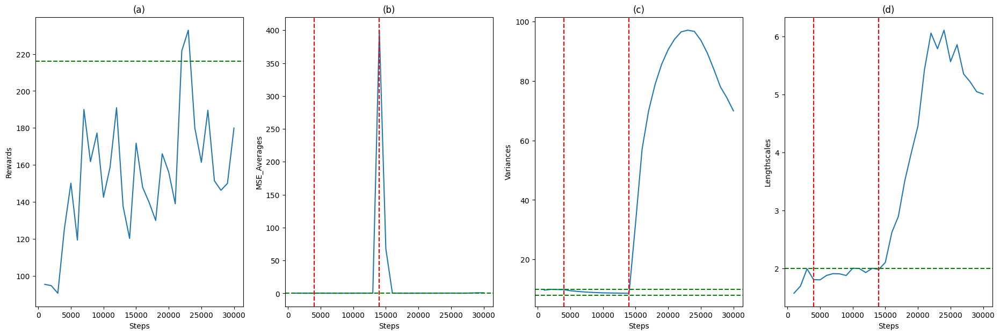

In [ ]:
steps = np.array([1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000])
##################
avg = np.array([95.50058, 94.763596, 90.68465, 125.39829, 150.17921, 119.444176, 190.0081, 161.82709, 177.24802, 142.57289, 158.74611, 190.94733, 137.74895, 120.32683, 171.7401])
##################
err = np.array([0.29619439043917745, 0.28157864132083876, 0.24714655317212422, 0.2886441472433955, 0.3108765839767124, 0.25531220712190345, 0.2372670029907871, 0.21612607885296015, 0.22778543188590591, 0.24537355971268968, 0.3289798575032398, 0.2814195156770352, 0.31400139729165305, 400.01009820476344, 67.7455727690695])

steps = np.concatenate((steps, np.array([16000, 17000, 18000, 19000, 20000, 21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000])))
##################
avg = np.concatenate((avg, np.array([147.90555, 139.72845, 130.00351, 166.07898, 156.09383, 139.02933, 221.69658, 232.85324, 180.0122, 161.4684, 189.56104, 151.46463, 146.32724, 150.05261, 179.95172])))
##################
err = np.concatenate((err, np.array([0.34011807034613695, 0.2827457043504369, 0.21658381891878445, 0.21550478323349484, 0.28319509568945483, 0.2883802527954364, 0.2863329044089745, 0.2961401288407772, 0.32196253329144203, 0.39249256445279096, 0.28164618781579825, 0.2891237829896394, 0.5262233730919241, 0.8501055637731948, 0.8880573529635114])))

vvs = [9.702594139668458, 9.956925110200343, 9.910856252482281, 9.879170720322026, 9.515247203271022, 9.29307952573702, 9.117540574583767, 8.978902533668252, 8.883681196018612, 8.7876834416808, 8.755946510944744, 8.719843028161817, 8.675618962903235, 8.65977040106054, 32.281700663788534, 57.10971048581313, 69.98415771525818, 78.87929129342052, 85.62678263681666, 90.5475437956936, 94.09010209129625, 96.49173744191792, 97.04224684109867, 96.64084472590385, 93.6742173383044, 89.35214730766366, 83.87543470087996, 78.02285414045362, 74.30412556868815, 69.93572297728412]

ccs = [1.56974814, 1.69447711, 1.99099209, 1.80468492, 1.80050099, 1.87726822, 1.90827766, 1.90417531, 1.87587374, 2.00081834, 1.99663752, 1.92715273, 2.00076504, 1.9806302, 2.10091054, 2.61832053, 2.89490071, 3.51820645, 3.99929007, 4.45509202, 5.42531741, 6.05601529, 5.78609293, 6.10642494, 5.56436894, 5.85612373, 5.35174853, 5.21551729, 5.04604059, 5.00495825]

fig, axs = plt.subplots(1, 4, figsize=(23, 7))
axs[0].plot(steps, avg)
axs[1].plot(steps, err)
axs[2].plot(steps, vvs) #axs[2].plot(range(1,len(vvs)+1), vvs)
axs[3].plot(steps, ccs) #axs[3].plot(range(1,len(ccs)+1), ccs)

axs[0].axhline(y=216, color='green', linestyle='--')
axs[1].axhline(y=0, color='green', linestyle='--')
axs[2].axhline(y=10, color='green', linestyle='--')
axs[2].axhline(y=8, color='green', linestyle='--')
axs[3].axhline(y=2, color='green', linestyle='--')

axs[1].axvline(x=4000, color='red', linestyle='--')
axs[2].axvline(x=4000, color='red', linestyle='--')
axs[3].axvline(x=4000, color='red', linestyle='--')
axs[1].axvline(x=14000, color='red', linestyle='--')
axs[2].axvline(x=14000, color='red', linestyle='--')
axs[3].axvline(x=14000, color='red', linestyle='--')

axs[0].set_title('(a)')
axs[1].set_title('(b)')
axs[2].set_title('(c)')
axs[3].set_title('(d)')
axs[0].set(xlabel='Steps', ylabel="Rewards")
axs[1].set(xlabel='Steps', ylabel="MSE_Averages")
axs[2].set(xlabel='Steps', ylabel="Variances")
axs[3].set(xlabel='Steps', ylabel="Lengthscales")
plt.show()

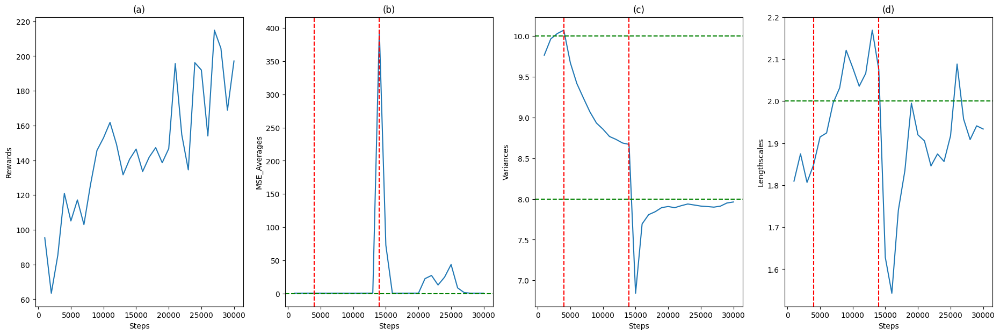

In [ ]:
steps = np.array([1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000])
##################
avg = np.array([95.36778, 63.481037, 85.433464, 120.9553, 105.09088, 117.207436, 103.0333, 125.852356, 145.71066, 152.92679, 161.83594, 149.14713, 131.67374, 140.61526, 146.47731])
##################
err = np.array([0.2566621764469206, 0.2866016763371798, 0.3150254178484967, 0.3564532345912163, 0.3032355774113036, 0.26973894415500055, 0.3071200469726254, 0.27233842754566573, 0.23460235722186207, 0.2482191899139662, 0.29937913005239336, 0.320493273961956, 0.3652741764148593, 396.80375240453316, 72.6691455203362])


steps = np.concatenate((steps, [16000, 17000, 18000, 19000, 20000, 21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000]))
##################
avg = np.concatenate((avg, [133.58147, 141.80948, 147.31323, 138.61476, 146.74495, 195.71397, 154.70325, 134.5039, 196.2087, 191.98502, 154.01152, 214.91602, 204.42912, 168.84877, 197.19815]))
##################
err = np.concatenate((err, [0.23568378940009085, 0.26544436044393244, 0.2831963401236971, 0.3666122305945068, 0.30554030956526596, 22.23649068191823, 27.052938792964547, 12.690080572704169, 24.490353182278916, 43.53619877475581, 8.317242267003893, 1.2880997454521275, 0.26832755541781617, 0.26224242291737054, 0.3221058542200171]))

vvs = [9.765998652677474, 9.966356293664147, 10.031891898125023, 10.073284293931025, 9.672460391859609, 9.417322678614106, 9.240973716420458, 9.069718501525896, 8.932714299980523, 8.857384705721351, 8.767400614339811, 8.731860073417032, 8.687625727766976, 8.670184836894915, 6.842020176752343, 7.693236239225562, 7.807326996203114, 7.843188760042192, 7.89402295597429, 7.9071983587817405, 7.893161236575245, 7.917590822173875, 7.938269344983411, 7.925723124466971, 7.912662546214337, 7.9068496304298845, 7.8996004868049745, 7.911857205595132, 7.950531133441464, 7.96312200024732]

ccs = [1.80955137, 1.87457573, 1.80666528, 1.84821162, 1.91476586, 1.92432698, 1.9956685, 2.03150138, 2.12096565, 2.07970909, 2.03552313, 2.0661356, 2.16884271, 2.07547336, 1.62791667, 1.54284662, 1.74052571, 1.83465578, 1.99519064, 1.91977435, 1.90546163, 1.8458076, 1.87433092, 1.85637175, 1.91759847, 2.08822036, 1.95734143, 1.90851805, 1.94121082, 1.93366964]

fig, axs = plt.subplots(1, 4, figsize=(23, 7))
axs[0].plot(steps, avg)
axs[1].plot(steps, err)
axs[2].plot(steps, vvs)
axs[3].plot(steps, ccs)

#axs[0].axhline(y=216, color='red', linestyle='--')
axs[1].axhline(y=0, color='green', linestyle='--')
axs[2].axhline(y=10, color='green', linestyle='--')
axs[2].axhline(y=8, color='green', linestyle='--')
axs[3].axhline(y=2, color='green', linestyle='--')

axs[1].axvline(x=4000, color='red', linestyle='--')
axs[2].axvline(x=4000, color='red', linestyle='--')
axs[3].axvline(x=4000, color='red', linestyle='--')
axs[1].axvline(x=14000, color='red', linestyle='--')
axs[2].axvline(x=14000, color='red', linestyle='--')
axs[3].axvline(x=14000, color='red', linestyle='--')

axs[0].set_title('(a)')
axs[1].set_title('(b)')
axs[2].set_title('(c)')
axs[3].set_title('(d)')
axs[0].set(xlabel='Steps', ylabel="Rewards")
axs[1].set(xlabel='Steps', ylabel="MSE_Averages")
axs[2].set(xlabel='Steps', ylabel="Variances")
axs[3].set(xlabel='Steps', ylabel="Lengthscales")
plt.show()

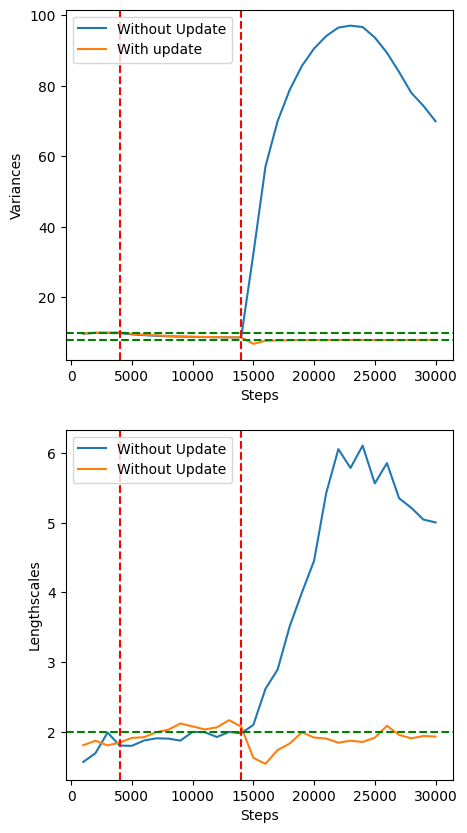

In [ ]:
vvs = [9.702594139668458, 9.956925110200343, 9.910856252482281, 9.879170720322026, 9.515247203271022, 9.29307952573702, 9.117540574583767, 8.978902533668252, 8.883681196018612, 8.7876834416808, 8.755946510944744, 8.719843028161817, 8.675618962903235, 8.65977040106054, 32.281700663788534, 57.10971048581313, 69.98415771525818, 78.87929129342052, 85.62678263681666, 90.5475437956936, 94.09010209129625, 96.49173744191792, 97.04224684109867, 96.64084472590385, 93.6742173383044, 89.35214730766366, 83.87543470087996, 78.02285414045362, 74.30412556868815, 69.93572297728412]

ccs = [1.56974814, 1.69447711, 1.99099209, 1.80468492, 1.80050099, 1.87726822, 1.90827766, 1.90417531, 1.87587374, 2.00081834, 1.99663752, 1.92715273, 2.00076504, 1.9806302, 2.10091054, 2.61832053, 2.89490071, 3.51820645, 3.99929007, 4.45509202, 5.42531741, 6.05601529, 5.78609293, 6.10642494, 5.56436894, 5.85612373, 5.35174853, 5.21551729, 5.04604059, 5.00495825]

vvs_i = [9.765998652677474, 9.966356293664147, 10.031891898125023, 10.073284293931025, 9.672460391859609, 9.417322678614106, 9.240973716420458, 9.069718501525896, 8.932714299980523, 8.857384705721351, 8.767400614339811, 8.731860073417032, 8.687625727766976, 8.670184836894915, 6.842020176752343, 7.693236239225562, 7.807326996203114, 7.843188760042192, 7.89402295597429, 7.9071983587817405, 7.893161236575245, 7.917590822173875, 7.938269344983411, 7.925723124466971, 7.912662546214337, 7.9068496304298845, 7.8996004868049745, 7.911857205595132, 7.950531133441464, 7.96312200024732]

ccs_i = [1.80955137, 1.87457573, 1.80666528, 1.84821162, 1.91476586, 1.92432698, 1.9956685, 2.03150138, 2.12096565, 2.07970909, 2.03552313, 2.0661356, 2.16884271, 2.07547336, 1.62791667, 1.54284662, 1.74052571, 1.83465578, 1.99519064, 1.91977435, 1.90546163, 1.8458076, 1.87433092, 1.85637175, 1.91759847, 2.08822036, 1.95734143, 1.90851805, 1.94121082, 1.93366964]

fig, axs = plt.subplots(2, figsize=(5, 10))
axs[0].plot(steps, vvs)
axs[0].plot(steps, vvs_i)
axs[1].plot(steps, ccs)
axs[1].plot(steps, ccs_i)

axs[0].legend(["Without Update", "With update"], loc ="upper left")
axs[1].legend(["Without Update", "Without Update"], loc ="upper left")

axs[0].axhline(y=10, color='green', linestyle='--')
axs[0].axhline(y=8, color='green', linestyle='--')
axs[1].axhline(y=2, color='green', linestyle='--')

axs[0].axvline(x=4000, color='red', linestyle='--')
axs[1].axvline(x=4000, color='red', linestyle='--')
axs[0].axvline(x=14000, color='red', linestyle='--')
axs[1].axvline(x=14000, color='red', linestyle='--')

axs[0].set(xlabel='Steps', ylabel="Variances")
axs[1].set(xlabel='Steps', ylabel="Lengthscales")
plt.show()

In [ ]:
"""
4000 - variance_lengthscale[0] += 2
15000 - means = np.array(means) + 10
30000 its
gamma - 0.995, 3 agents
"""
print(steps)
print("--------------------------")
print(avg)
print("--------------------------")
print(err)
print("--------------------------")
print(train_py_env.liste_variances)
print("--------------------------")
print(train_py_env.liste_lengthscales)

[ 1000  2000  3000  4000  5000  6000  7000  8000  9000 10000 11000 12000
 13000 14000 15000 16000 17000 18000 19000 20000 21000 22000 23000 24000
 25000 26000 27000 28000 29000 30000]
--------------------------
[ 95.36778   63.481037  85.433464 120.9553   105.09088  117.207436
 103.0333   125.852356 145.71066  152.92679  161.83594  149.14713
 131.67374  140.61526  146.47731  133.58147  141.80948  147.31323
 138.61476  146.74495  195.71397  154.70325  134.5039   196.2087
 191.98502  154.01152  214.91602  204.42912  168.84877  197.19815 ]
--------------------------
[2.56662176e-01 2.86601676e-01 3.15025418e-01 3.56453235e-01
 3.03235577e-01 2.69738944e-01 3.07120047e-01 2.72338428e-01
 2.34602357e-01 2.48219190e-01 2.99379130e-01 3.20493274e-01
 3.65274176e-01 3.96803752e+02 7.26691455e+01 2.35683789e-01
 2.65444360e-01 2.83196340e-01 3.66612231e-01 3.05540310e-01
 2.22364907e+01 2.70529388e+01 1.26900806e+01 2.44903532e+01
 4.35361988e+01 8.31724227e+00 1.28809975e+00 2.68327555e-01
 2.

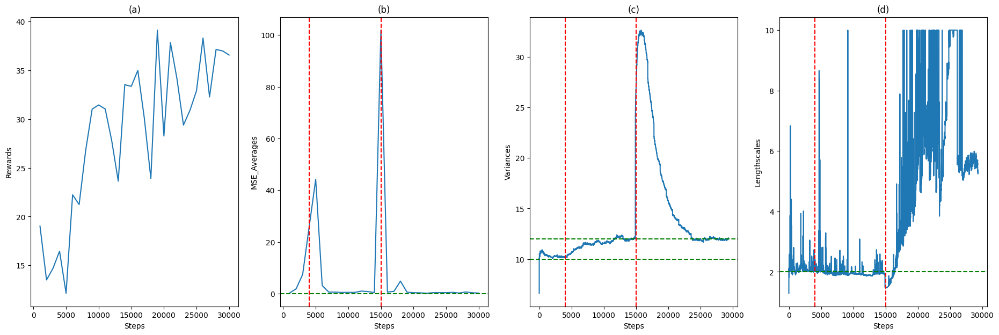

In [ ]:
steps = [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000, 21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000]
##########################
avg = [19.019928, 13.509247, 14.709503, 16.454863, 12.146403, 22.229912, 21.232695, 26.758947, 31.015848, 31.434841, 31.02189, 27.772528, 23.627544, 33.51015, 33.341858, 34.973347, 30.070887, 23.897121, 39.094933, 28.252386, 37.82482, 34.13258, 29.375692, 30.888432, 32.887848, 38.292015, 32.261265, 37.120327, 36.97008, 36.5503]
##########################
err = [0.2762624629029974, 1.9187773214723025, 7.46878083809995, 25.91078550778735, 44.20329302070852, 3.163284888446918, 0.6451224202149852, 0.6383958799529745, 0.5032603958555987, 0.5365478165653613, 0.5155352673200069, 1.0334087488675276, 0.8358828609574719, 0.47660683657016906, 101.84713886021977, 0.6414756665254009, 0.9235589594887449, 4.890401720864753, 0.6017474894387691, 0.4116654197446441, 0.3643013448183222, 0.19920885470904787, 0.4205258550963817, 0.43851674927290824, 0.4211649630263237, 0.5444142011867252, 0.27381160354666984, 0.692216002131828, 0.39962072154170897, 0.2570481913860037]
##########################
vvs = [6.630500994933553, 10.113037202401747, 10.105202686486857, 10.097073767670508, 10.080893593581022, 10.045756856411868, 10.043891484547231, 10.060209217335512, 10.05678246670755, 10.03582193190878, 10.050497157106689, 10.0162003377541, 10.016831777307322, 10.108973084604305, 10.101440730273445, 10.111309283381736, 10.088151310914071, 10.066307545090119, 10.124745567440321, 10.105097096996227, 10.074703611185207, 10.0820388278865, 10.067414499175166, 10.093365757885355, 10.099535246779176, 10.110888420755076, 10.093467548449423, 10.095869802199303, 10.14695690146854, 10.304043387054497, 10.386167832350468, 10.484161330403236, 10.562876344951814, 10.546409343389255, 10.531586187407065, 10.52901600263127, 10.543224225055688, 10.520929569084783, 10.49223127596301, 10.471398965485685, 10.445425284151272, 10.422632565286372, 10.409800411188474, 10.393039453069179, 10.395819157788377, 10.38504508874988, 10.355354240980887, 10.333831713949444, 10.305948691108417, 10.304192105906298, 10.282155980982848, 10.27390797641432, 10.24672826697711, 10.216377409160035, 10.210083047737957, 10.206900996292491, 10.203420990755273, 10.424068486682534, 10.398242242472099, 10.439148147587312, 10.411932756966037, 10.411317910353674, 10.410922975437103, 10.390755420569798, 10.390242308976529, 10.381524378093829, 10.352801421840912, 10.38872520358083, 10.403800133180948, 10.380639234286294, 10.406648461484906, 10.436038087459352, 10.435676203497279, 10.420001774502175, 10.43729825098666, 10.422831085688982, 10.429605289003865, 10.456858408523656, 10.475089018528134, 10.490969329465369, 10.463129546529002, 10.439664394478942, 10.42665788540626, 10.405760390495836, 10.386301469114262, 10.394634382469857, 10.386885166288527, 10.359143508825907, 10.412498403095631, 10.389899836214228, 10.459186249564597, 10.4363955720086, 10.420154002591097, 10.415850453058434, 10.404161171135476, 10.390775844563768, 10.404779654372971, 10.38551416047281, 10.367206051133607, 10.352131727492157, 10.36013681065423, 10.361607626582455, 10.334364619205422, 10.36438404995855, 10.400565444979216, 10.383836373018788, 10.384370531998515, 10.419975848068368, 10.4033224560246, 10.385271172644991, 10.364868569842145, 10.347078293342301, 10.323579729216041, 10.30270092436422, 10.288214889946989, 10.267301423670695, 10.328863546274345, 10.327549960903577, 10.38614745767116, 10.493731932537715, 10.494953776150789, 10.50078645700794, 10.536846896071182, 10.759508306260312, 10.738259888939439, 10.732862957338629, 10.767159350182443, 10.760961159194624, 10.746339905666067, 10.765879834117506, 10.748569541440869, 10.743310935981368, 10.722448347289852, 10.729131921701914, 10.72686858369517, 10.744232845603982, 10.750267706893126, 10.766382896794381, 10.746720262913147, 10.736124653524952, 10.757320521047168, 10.75952212559919, 10.75275559369113, 10.742187506771977, 10.718713066951574, 10.748175779412268, 10.758934293242548, 10.73712363750081, 10.80851750467619, 10.785984336788147, 10.76858810146175, 10.751298680567295, 10.73872316898841, 10.731521054837335, 10.718619493115916, 10.73381296750312, 10.722867444231419, 10.743820698596242, 10.72442747458309, 10.703874123694513, 10.686287199475343, 10.681649556176469, 10.673566452299859, 10.661283548875538, 10.643839899999985, 10.646068148944893, 10.646356476607192, 10.661383605856408, 10.64783119554234, 10.637580827315114, 10.627366877163245, 10.61695065493963, 10.595337060241773, 10.596891579166172, 10.596217801169665, 10.612919261930505, 10.64893546029158, 10.64629276316601, 10.679950703114606, 10.658314946147383, 10.673633440380303, 10.680574865524925, 10.664980258481663, 10.675989204535371, 10.662874927276038, 10.691196336918551, 10.673214983280678, 10.654202888727578, 10.64310550725545, 10.634462665545971, 10.678977997933114, 10.721054820183511, 10.722396760595752, 10.713392998912036, 10.733777541214787, 10.713728582511443, 10.701768869204237, 10.69571604572948, 10.67870020599311, 10.664792594807583, 10.677703568314401, 10.65676821659815, 10.642448410144436, 10.643045661924594, 10.638407442731447, 10.679555793152147, 10.68394626963408, 10.68174042676824, 10.668758617652665, 10.654286789508108, 10.647449476943388, 10.630992033453898, 10.640545573575036, 10.623125481989142, 10.664798105580585, 10.64748584035923, 10.63249975568411, 10.624372401004, 10.6274825327416, 10.635645516292941, 10.645850142613371, 10.629146036696765, 10.623947613911104, 10.627534107308001, 10.63540964268252, 10.640488160250138, 10.631938626874492, 10.615080362474886, 10.6046992982613, 10.588413938154115, 10.57744218379106, 10.597450116147328, 10.579686537249245, 10.56207560522927, 10.585769439845802, 10.596331137582386, 10.57940709355622, 10.569960684089585, 10.59448862236743, 10.589505602274597, 10.681835127155859, 10.693719370500324, 10.70749226604292, 10.690921679011078, 10.763286433588593, 10.753805191436347, 10.778365911224455, 10.75885116402112, 10.747971293105413, 10.730539500981468, 10.719047304241496, 10.70597821169381, 10.720090204577904, 10.711047418614779, 10.702942425991427, 10.710790498019062, 10.712984792158409, 10.72578773634673, 10.720557681387696, 10.72858603132189, 10.717846526948467, 10.705707249298838, 10.689374188452206, 10.699358064263977, 10.70133542859171, 10.710223336091461, 10.695881558009921, 10.701802295816368, 10.699247292595873, 10.698873531595577, 10.681010770828104, 10.672953374108337, 10.684130648382514, 10.668236051141989, 10.651853525045569, 10.637566127676092, 10.660127940492034, 10.652049888773442, 10.645112217364352, 10.630383822466069, 10.64575311967338, 10.659589740577395, 10.643900093196704, 10.644193649654435, 10.672009812878786, 10.692102347462512, 10.683161494906642, 10.721762772196415, 10.70892177006022, 10.696690467748546, 10.703581024884025, 10.731950928967352, 10.723239276337415, 10.709063530461284, 10.701662074429073, 10.705761363833432, 10.697534503802478, 10.691679337628527, 10.685672479266984, 10.679927181405233, 10.708148623476728, 10.713452555254113, 10.719497430075162, 10.710591274804456, 10.696074112986508, 10.679600193124484, 10.703130916635505, 10.688195351545467, 10.676593641096824, 10.6986462740348, 10.7239173614983, 10.736511538489918, 10.7702425976214, 10.756423458396865, 10.741355244736443, 10.749537593388226, 10.733100882612476, 10.738987904227331, 10.725433009567041, 10.718272609303746, 10.743177646020182, 10.787386401721514, 10.770411715681337, 10.769895020012243, 10.757922400854328, 10.74402920103931, 10.741182853365709, 10.734269765798652, 10.721919675181658, 10.740932657707997, 10.728858769953948, 10.720377859685012, 10.722959055302862, 10.709705752645942, 10.708719401778923, 10.701629096846865, 10.805144171676652, 10.795448463896854, 10.795439418092219, 10.785971046452497, 10.77403999468583, 10.764935074655506, 10.758373060493602, 10.840708215514374, 10.82514173351824, 10.830953139678208, 10.819710399037078, 10.813152409228145, 10.802556506907573, 10.843079233635093, 10.839380997931295, 10.865539114763429, 10.864763930992822, 10.854474678216262, 10.85376674300104, 10.838142262020476, 10.829273507840146, 10.840062031595968, 10.858703798010099, 10.845236437253083, 10.845954698476856, 10.829769723973625, 10.817989262940449, 10.806989501854993, 10.794542344121806, 10.797415130677779, 10.794489916355294, 10.799297732086035, 10.787692086641787, 10.811792097780652, 10.81361028187136, 10.800162449298531, 10.791798704672418, 10.776522366082995, 10.765462445365788, 10.751444921531446, 10.748828968289851, 10.754092577344887, 10.750121506893672, 10.742310470772674, 10.755125598378047, 10.768273663859413, 10.789752842779276, 10.802269965119487, 10.809520682767182, 10.827664190256092, 10.813438204711842, 10.807081332963714, 10.811161099360495, 10.811089569555554, 10.804811156794683, 10.793527948395477, 10.782120835121964, 10.766016733369202, 10.756310269059508, 10.765151533544927, 10.769172902735198, 10.75940634722929, 10.75747649290242, 10.749154082639258, 10.734847692100166, 10.770945607307727, 10.804864133817226, 10.806392752204498, 10.791500658463026, 10.782268933520271, 10.767531076648615, 10.807994361591676, 10.803433028721498, 10.822339199459178, 10.815792620389157, 10.807220372876571, 10.806064276561328, 10.79634805997381, 10.82795627415606, 10.820130343048994, 10.808738172104505, 10.798154710729042, 10.793297621826065, 10.791798168526043, 10.794352440959553, 10.795240125584362, 10.784225268487129, 10.769468107152141, 10.776186041848407, 10.768440187436822, 10.75927564501581, 10.754865211069932, 10.741902007406503, 10.750806128742504, 10.741501710349455, 10.739161117195854, 10.7505313600702, 10.742727359182336, 10.76518051541144, 10.759453928593777, 10.75629955707498, 10.794511026011921, 10.786710336690536, 10.775643134542472, 10.786027273483677, 10.812322562737098, 10.80197834738236, 10.828436603163336, 10.81947137625466, 10.820248709377136, 10.845312574857163, 10.887678947776369, 10.874224967137158, 10.898041016878802, 10.899998207479566, 10.926650971702202, 10.912371416882875, 10.911421044071858, 10.901189861378546, 10.898289484389348, 10.884525689896028, 10.874482643317148, 10.860351893975555, 10.856373418031774, 10.851556834038876, 10.847886095526265, 10.850178319209268, 10.840925909359495, 10.84180083181478, 10.856734649920616, 10.845123902567893, 10.84632932143184, 10.83929249112283, 10.865118752073624, 10.85220626332804, 10.841910390328708, 10.82776385656866, 10.82883470324637, 10.81822686636088, 10.81183849842307, 10.81723329814964, 10.824497930266984, 10.832078813842283, 10.824549575733299, 10.818165915221762, 10.826380407683684, 10.849407388636646, 10.841454775810504, 10.830176568213345, 10.819955841364521, 10.806392284045065, 10.794551468120634, 10.808917439182105, 10.801301638979616, 10.800105862777126, 10.79070636954057, 10.780143166610912, 10.781440131282203, 10.785552985662903, 10.787167434762381, 10.777289733828297, 10.768061601051931, 10.784788512576513, 10.773020792102901, 10.772259067250165, 10.79483498625504, 10.809416949494942, 10.798350990583646, 10.794035867646045, 10.791850253124464, 10.820705016495523, 10.830164820180704, 10.832075740009394, 10.8409142088635, 10.82927700540174, 10.82647054960991, 10.836213473943186, 10.831319169418942, 10.83187059516081, 10.825608353920426, 10.817759248694854, 10.806835746209751, 10.795662345098497, 10.802623540726435, 10.817416066844684, 10.809488023350161, 10.811127002017592, 10.82459203204733, 10.822416633276191, 10.823048136505117, 10.817674137672732, 10.813185162745764, 10.804045267641376, 10.804528476521641, 10.796104777169564, 10.797259528488624, 10.793360598733516, 10.790282588805473, 10.789842703192184, 10.777833952761927, 10.771463166673371, 10.768996240911166, 10.764156021146043, 10.75901273776418, 10.757925457995466, 10.74619603264167, 10.747743005492271, 10.744518042219356, 10.73452517720854, 10.72238578958106, 10.712718773095693, 10.702615451634337, 10.69814081132804, 10.687719282193875, 10.682184888343578, 10.68476301394554, 10.71080680657361, 10.729084454798457, 10.717747008818852, 10.735645033400395, 10.72878011560981, 10.7241107831438, 10.726578067546075, 10.714734743225502, 10.703028004521965, 10.691463879736649, 10.693860277114437, 10.689067474555648, 10.686677875816654, 10.675582427472653, 10.675826504577206, 10.663459888847013, 10.661664296873957, 10.656253045608365, 10.666677484017832, 10.670451676504843, 10.671579199438805, 10.66581422937672, 10.658981362545413, 10.655737620308452, 10.661255264398783, 10.652678779050083, 10.64812751566334, 10.639725264101699, 10.635514981174149, 10.651531127001562, 10.696986693774898, 10.69147531440405, 10.686099470289726, 10.689128498116906, 10.685476351855682, 10.675290696655546, 10.669828728966646, 10.687463184357428, 10.676379533879775, 10.669205322950843, 10.683681459325841, 10.678347757265659, 10.674183572926328, 10.66273757377776, 10.653903405534116, 10.664384171446196, 10.662626663308878, 10.654839673223481, 10.646629202494877, 10.638720562938508, 10.62847185261439, 10.618836325966729, 10.612468895509265, 10.616516538068478, 10.625457530121633, 10.627960974789145, 10.61721513965503, 10.606545721262423, 10.610638312154403, 10.60251470784072, 10.618404158638423, 10.634748124476978, 10.659489349346893, 10.652935678085166, 10.728871606702821, 10.730287775980957, 10.747875468692104, 10.737633231054085, 10.728109732016136, 10.721046699772117, 10.718655506907176, 10.7237048028315, 10.715241999568395, 10.705955131548462, 10.707631008673928, 10.707055207635435, 10.714971313793907, 10.706729855787854, 10.702501995033318, 10.69818262783824, 10.694826891754365, 10.69705715264609, 10.690967061902015, 10.68160127175071, 10.675752368258129, 10.665558677682096, 10.676582948161421, 10.666470067027724, 10.664911179625282, 10.662420396768962, 10.654489577817104, 10.654780653616603, 10.645172499389442, 10.64300968377352, 10.650147900345873, 10.654067611390555, 10.645155184774868, 10.636333712070906, 10.625327178584305, 10.618350582522726, 10.612921690056679, 10.6141133129279, 10.608199246696032, 10.616473505491712, 10.609802231583272, 10.604459879503978, 10.59623153145419, 10.609436175477809, 10.599950328687767, 10.600366819730105, 10.604364437701724, 10.594259127237818, 10.586658100043064, 10.587826241130504, 10.578150284299571, 10.580497892184555, 10.57361969080279, 10.56555337417298, 10.556223225065112, 10.545843365818769, 10.54076465807541, 10.541037028559003, 10.538130471255933, 10.52796361636971, 10.534796715951746, 10.532184592403592, 10.533818927579269, 10.527638136793723, 10.531940310109347, 10.52270760618972, 10.525554653153725, 10.519183115103829, 10.519143443679855, 10.512805490717007, 10.533317479270874, 10.52673276972829, 10.518506580450829, 10.515327213259972, 10.504444543343606, 10.493689694590318, 10.520132491693843, 10.532527584831461, 10.567758890977926, 10.562932678692892, 10.560537737058773, 10.554190134199246, 10.545102623978936, 10.536166761796098, 10.548144886624275, 10.54498406061243, 10.554081327636526, 10.552049365426086, 10.547818428696672, 10.538496198586143, 10.528902904798876, 10.533945889714442, 10.52756868689475, 10.519730514960692, 10.51008397635356, 10.524691451529241, 10.51804949897096, 10.516239800950826, 10.52877568490133, 10.52199961209022, 10.522260792563298, 10.566421133555117, 10.57057125089511, 10.564386726091739, 10.558161018898787, 10.552766674607481, 10.547027899893562, 10.56567594995246, 10.563992916444281, 10.564527682260133, 10.57078295667168, 10.578846313432466, 10.572613800092661, 10.563952777680928, 10.561434479777008, 10.560730554319264, 10.560195422194198, 10.554741068218725, 10.561255962199033, 10.554322353986135, 10.548694268442844, 10.55514522389249, 10.553655920166864, 10.545296466909976, 10.570429574953987, 10.560870353281361, 10.568893765036027, 10.563053300248919, 10.55976674885241, 10.562226070317465, 10.553795111916292, 10.548051022854274, 10.552493099548748, 10.553924667394176, 10.552446889335666, 10.609181190890304, 10.604577236354924, 10.605291779398765, 10.595488216588295, 10.590213663584192, 10.60619034823985, 10.599644528429325, 10.600682992418646, 10.59172291080475, 10.601198984584709, 10.598435719206135, 10.593236598747398, 10.599399309885053, 10.598177469310688, 10.60048130304636, 10.593046303884437, 10.588485262111906, 10.582936479099732, 10.576090919024216, 10.571882226107228, 10.608331116311417, 10.60220383799215, 10.593351546909023, 10.584392662615954, 10.57821136416406, 10.57198601797208, 10.564047875853369, 10.559584719331044, 10.55084711861981, 10.541129225396555, 10.541680706752718, 10.539635188102578, 10.547286390945372, 10.557898972456847, 10.548145684590406, 10.545216896566716, 10.565154405794212, 10.558138195415584, 10.556269355138197, 10.553288528066863, 10.548784312306513, 10.5390832341369, 10.54841799504091, 10.542473635078089, 10.54105660183883, 10.54866134085233, 10.54474679935401, 10.536329723110994, 10.532370351939383, 10.530787615725572, 10.529968705974857, 10.52199467770702, 10.518246139149312, 10.518452532155521, 10.523344439834508, 10.54066926801323, 10.53151703582981, 10.555013724826749, 10.546039246359664, 10.541402742549812, 10.533174526755861, 10.52639077059993, 10.518287246735696, 10.512541118156966, 10.505703843135167, 10.498238270420828, 10.499164953999749, 10.499417587469127, 10.498595313946877, 10.48956038598906, 10.483793061677645, 10.474739925742409, 10.471524073185384, 10.47033413426165, 10.46912590394594, 10.46115578722413, 10.456427492571148, 10.451761184091954, 10.444565990081612, 10.436441613126519, 10.43878803667687, 10.440147917715308, 10.454762381777332, 10.462638152577497, 10.454474539905004, 10.446234304439658, 10.438358405895729, 10.463325641756162, 10.45669587142128, 10.453088679286466, 10.447326145989624, 10.43993346236229, 10.437508596553249, 10.429180956001366, 10.438184252930919, 10.430930490832367, 10.428386281479408, 10.41990763887908, 10.416507296985374, 10.41755337875296, 10.412482600045905, 10.405793026574361, 10.402231615819682, 10.399061912006365, 10.392849451506713, 10.385157752074734, 10.377288444955159, 10.368837831756148, 10.373738591257345, 10.373305594168668, 10.36516967452986, 10.364524302716838, 10.356832388160832, 10.348934507492425, 10.357885081515924, 10.353063146225276, 10.344867507589036, 10.364080513149739, 10.363819980149408, 10.359517926507776, 10.359081957513956, 10.36426722652565, 10.357746970893533, 10.35383429166478, 10.347936311699756, 10.369191478512844, 10.427543082053138, 10.437879562162005, 10.466771669262116, 10.458804315728171, 10.45317627511711, 10.446188564345643, 10.439448985321732, 10.432739449489244, 10.42589330103784, 10.423368175819865, 10.417340129915791, 10.424802596601385, 10.423536901602262, 10.427830091571252, 10.422420340060855, 10.435377268381668, 10.431234448346668, 10.430887644184342, 10.42641632885495, 10.418603988041754, 10.410807475984523, 10.402696469280732, 10.396080163769907, 10.393295859053687, 10.402830001579765, 10.418559127538158, 10.412062107309982, 10.428206697490415, 10.43209716007147, 10.427210957868665, 10.441805280462855, 10.447548942780934, 10.442691477663333, 10.438193162731459, 10.435185616625095, 10.429233312218374, 10.42639651528943, 10.42378442794278, 10.424745461795535, 10.465445091814695, 10.461928802074231, 10.454238723460847, 10.449744732702788, 10.465891990838044, 10.46250075435389, 10.470000380658265, 10.464825380660171, 10.45790629655495, 10.452833552055607, 10.446199928705212, 10.452016774031131, 10.470240347215164, 10.467602930632005, 10.466100247498101, 10.463464451778718, 10.455300044367878, 10.448748523997182, 10.442441461305705, 10.452323249067582, 10.45437282382456, 10.453512681420408, 10.445639577197422, 10.438414172343622, 10.432241280655342, 10.424853774251831, 10.419924844917459, 10.419877511341987, 10.417884294214078, 10.413876350535215, 10.410647749065175, 10.402658551229583, 10.413000726281957, 10.407054871000867, 10.409463720939298, 10.404557837023015, 10.414343246111507, 10.40974536891313, 10.405800078621303, 10.420122807571452, 10.417751287495038, 10.41685582918275, 10.410534406877058, 10.415757442402013, 10.41148513143414, 10.410793306911083, 10.407288976530378, 10.405753756584978, 10.403770581417488, 10.4032839481327, 10.432689097666511, 10.438564626789395, 10.447462069306878, 10.444092768640509, 10.436757943982666, 10.432603049257683, 10.436209135759288, 10.430502084171717, 10.423450171177018, 10.423136555152782, 10.422174058721621, 10.420601246896805, 10.42049047963916, 10.428233208530179, 10.435919336558273, 10.429733648342406, 10.42611888301979, 10.420789485287433, 10.419099481554246, 10.419838437049972, 10.423459772962458, 10.420143707075205, 10.41762637738375, 10.417425389994197, 10.409229801626125, 10.403973412648773, 10.402156685191079, 10.396215470935694, 10.388298469989232, 10.387060225175736, 10.387846469505375, 10.379726911497787, 10.373017762080785, 10.367534747674098, 10.369540989850435, 10.365598723455392, 10.384871721583153, 10.380601400033436, 10.380539537136675, 10.384601291870428, 10.389265051077638, 10.386904099612014, 10.398406111631521, 10.406465021129168, 10.40857713686546, 10.412506231439076, 10.416039119851577, 10.418568417573576, 10.41296819297873, 10.417181546294572, 10.41168640589382, 10.422338025248227, 10.4146155416587, 10.414499459015104, 10.411801631038973, 10.404414125223905, 10.400363861351916, 10.395163525576422, 10.397400085456665, 10.402308859162126, 10.404254690218533, 10.398977149038242, 10.394365794750282, 10.394055366113086, 10.386838284007757, 10.385064445705357, 10.381675898456695, 10.396585993647664, 10.394235296015564, 10.398203080101077, 10.39962484374247, 10.392817047284682, 10.389114014456112, 10.400522995706325, 10.395935984671913, 10.396870344111898, 10.405370601928343, 10.398308060655065, 10.400992272634708, 10.406923738877392, 10.400267120251376, 10.398087620583883, 10.40226110926219, 10.403668847752561, 10.43139524516012, 10.433272331792974, 10.432683017957073, 10.433176264842322, 10.435777284667333, 10.429601894039171, 10.456634942443944, 10.448853540565452, 10.448537392933432, 10.446710052628184, 10.439535397181677, 10.432721865354951, 10.458633876790321, 10.455227428737762, 10.451343959843937, 10.458210540208599, 10.469745710886112, 10.467778717566507, 10.46163525092322, 10.459617158743505, 10.455205050280938, 10.447725893292436, 10.45282774124428, 10.451074395369355, 10.44735071622556, 10.445967983359262, 10.438772937085758, 10.442894318786001, 10.446898392923412, 10.444825087296804, 10.438423595146908, 10.435857893442277, 10.430166487597175, 10.424219928874006, 10.423491743252708, 10.420286180525222, 10.432599110751905, 10.43184266050891, 10.424426469630546, 10.417890248474954, 10.413139271155982, 10.411263180158882, 10.406528901116886, 10.403909162454676, 10.419732271416677, 10.416077187416697, 10.411460397452545, 10.40942291533068, 10.408884789150505, 10.404039058961793, 10.40301230216522, 10.399983935412813, 10.392900742609319, 10.395625506077481, 10.39758748620567, 10.392541109579057, 10.398720791269712, 10.411065697959536, 10.423941273792696, 10.419529877764333, 10.41424050930834, 10.416013421927108, 10.419852280332956, 10.413896802707155, 10.410999971069355, 10.413768757611441, 10.4120674658231, 10.412139092963102, 10.407363300719128, 10.40298297700072, 10.421234557496314, 10.434604186386073, 10.44141376260483, 10.438301073122176, 10.431223280316699, 10.433139974534814, 10.428521892001132, 10.423958014139945, 10.41719619373339, 10.413378569978594, 10.413139646115646, 10.406759356768472, 10.404497849892095, 10.40520210735491, 10.402541852589856, 10.395181485810026, 10.389139101059591, 10.383645854850823, 10.376478726590477, 10.374126173062216, 10.376839926384534, 10.371726789525264, 10.368536793639834, 10.362788577761847, 10.359998773120582, 10.354113472039904, 10.366602902287758, 10.360757039240944, 10.360771032968325, 10.35868405693386, 10.36342733811396, 10.386405084843986, 10.384221642648827, 10.380662111365913, 10.380186877623414, 10.390528986131802, 10.389100691041218, 10.383672290809837, 10.415397851062059, 10.408721362142476, 10.420232514287106, 10.416373093264244, 10.41509486194004, 10.413602148279102, 10.412975851176059, 10.408517563802768, 10.409777188924286, 10.40762525999683, 10.407955233961099, 10.402962895618783, 10.397508575763808, 10.39057222367369, 10.387866569094223, 10.383079764805196, 10.376222200200983, 10.3742262856088, 10.383934607250255, 10.386628603393756, 10.398502386648095, 10.393561898881131, 10.407357854928001, 10.401552323307921, 10.404134919626227, 10.399771300096006, 10.395545324275032, 10.391896018761232, 10.39074119296821, 10.385862537417, 10.379971625847693, 10.374167477642402, 10.371271566682115, 10.375701466778295, 10.381955692930713, 10.376508933215089, 10.373612505760969, 10.370635077057068, 10.376858451119324, 10.375673546836754, 10.386877799072511, 10.380231081551344, 10.374957209352772, 10.369650057708347, 10.370527581568147, 10.36423671256759, 10.365562526028766, 10.382967885897271, 10.377102054449853, 10.37320662923054, 10.36996639536098, 10.369766179636922, 10.377394187168978, 10.377914545960587, 10.375857828023081, 10.369261564870069, 10.370429223844864, 10.363684660573906, 10.359612565197974, 10.356322551469495, 10.3500878203833, 10.35058946602818, 10.348176166321865, 10.349935550888242, 10.353051914660371, 10.346574646659642, 10.340960009291852, 10.336770106068103, 10.346395043723328, 10.34544042535596, 10.341025465883142, 10.358966631518223, 10.369445881149927, 10.375701072008631, 10.372138575713125, 10.373607320133466, 10.369194026122262, 10.366252482575273, 10.366989768094816, 10.3633950896262, 10.359223154888031, 10.357395917714422, 10.352034758125884, 10.350305495689785, 10.348528731522434, 10.34939126328211, 10.343421229951842, 10.340991935291429, 10.338718948238583, 10.334963605990664, 10.338551484105619, 10.332523013137532, 10.331144033888219, 10.333733744497271, 10.329542763373404, 10.32531602435217, 10.332315039490222, 10.329033218189728, 10.32457876894781, 10.31836175175259, 10.312036202852314, 10.314798651056611, 10.320811226620206, 10.327988164923662, 10.333984136972136, 10.340790004790815, 10.336619024143712, 10.33907491178925, 10.33313494421886, 10.338324307173298, 10.332965143319223, 10.330929514891778, 10.329798962488448, 10.354776652218558, 10.357349114074436, 10.354982367979122, 10.35168586084241, 10.3520540046417, 10.347422326195241, 10.35087721731854, 10.344908930514267, 10.339366632558276, 10.335441463627742, 10.334548258456246, 10.328992917485596, 10.323163255719813, 10.326056034514217, 10.321423065958209, 10.326558977512995, 10.330411634783367, 10.324964589099729, 10.326291131132097, 10.323684457895789, 10.317171144871635, 10.319324864467587, 10.335623095072934, 10.350704712342182, 10.350513726264577, 10.346634912929732, 10.38698808761415, 10.381539432844862, 10.381584693718967, 10.383040941870087, 10.37992113873824, 10.375231997465496, 10.370061929543432, 10.367215381453114, 10.363642643917496, 10.365702332363343, 10.359738471271656, 10.356395262669684, 10.351674772377251, 10.354753118138884, 10.34928856485759, 10.346136980531687, 10.345386935821764, 10.355156508094227, 10.350288251037798, 10.351447255297561, 10.346070671249164, 10.345669130165877, 10.339999640481095, 10.341850107914224, 10.346605269230478, 10.340799607360292, 10.341836444791682, 10.336822429946038, 10.330543293100447, 10.340461068770288, 10.335699941209434, 10.339674360845024, 10.33751124645449, 10.342265223797474, 10.336625301991875, 10.333465149523672, 10.340085410210891, 10.334843907887182, 10.344412993756078, 10.338404837971142, 10.334043916478338, 10.331670207960313, 10.335207801828707, 10.3294823507939, 10.32357609185859, 10.33335905013587, 10.338067905669993, 10.340407334579126, 10.3417488450855, 10.336013280912205, 10.331946052694779, 10.331873511131155, 10.328471677806935, 10.327503629311781, 10.322230262673607, 10.325434085485682, 10.319890912076719, 10.315134995449709, 10.309489994485048, 10.305220218970875, 10.301607766734401, 10.305437832122289, 10.302929928019397, 10.300390319863286, 10.299972048878661, 10.295633179309089, 10.29416947551794, 10.289197393888037, 10.287048696605925, 10.304324754263995, 10.299718832531479, 10.301741621973305, 10.29999854918676, 10.296328675455271, 10.29264627987828, 10.296031411318431, 10.29140077361812, 10.291588601406785, 10.294525624751978, 10.290271806898964, 10.290175011604466, 10.28499103454126, 10.287126281388206, 10.282884049066695, 10.276915199932716, 10.280481856696126, 10.274716606996341, 10.281141452616671, 10.277145792426108, 10.271861818190441, 10.267208500303472, 10.272936147463053, 10.272018194756969, 10.272251846658005, 10.266901382139135, 10.263066829003467, 10.259739088623624, 10.258425324103307, 10.2599316712829, 10.25461302258718, 10.248887726363687, 10.254113328300908, 10.250843813181591, 10.245282893962255, 10.24092564354932, 10.244830462988968, 10.245945648899362, 10.24810591330291, 10.242068328933373, 10.244304567213304, 10.239716502367632, 10.234783255184245, 10.235555604997963, 10.242008162902316, 10.237734553847343, 10.23832236167112, 10.23752253433774, 10.234525892530286, 10.230542213598953, 10.250156249748596, 10.246822977343289, 10.256404813970144, 10.263045868916082, 10.257553561778604, 10.264653678610443, 10.25944366821196, 10.256694052534282, 10.253695906396956, 10.248349988629618, 10.2620715480598, 10.260149591399921, 10.254583629819612, 10.252347854927834, 10.25429644493476, 10.250109021993744, 10.24858218557056, 10.251927142207823, 10.255723584195882, 10.262739947494076, 10.258262167446281, 10.252937960381633, 10.247053116609393, 10.253253054863112, 10.252996773430576, 10.247203481356589, 10.243625421913196, 10.248158060488171, 10.252065184790908, 10.247594764748207, 10.243914042739732, 10.246358374767231, 10.250642290845759, 10.246498060545921, 10.24510651432533, 10.240462491826625, 10.237425434752701, 10.241362815619702, 10.23680807072717, 10.234703315318585, 10.230608726252624, 10.22709884344245, 10.2232609667707, 10.223448829974885, 10.23431323443835, 10.229806131095483, 10.229160693093094, 10.22587823300991, 10.223679685045552, 10.220668779262587, 10.229294216850041, 10.225341083441238, 10.228469804629961, 10.224371085192383, 10.22426523906223, 10.226240457710182, 10.233118701273833, 10.235834993574228, 10.232564636387062, 10.248280865241197, 10.254138816253832, 10.24963674091969, 10.250569460993523, 10.245515075855058, 10.24238904166229, 10.260080620089418, 10.262105590073014, 10.267593312151368, 10.268675615960337, 10.268040257987675, 10.26438394369219, 10.260857519089928, 10.266594677217695, 10.267107932301334, 10.27383421955454, 10.273071235983782, 10.27611443042336, 10.279650911388051, 10.281022317575822, 10.284974093638178, 10.283092785381427, 10.288491459777083, 10.287411280384545, 10.284315093360307, 10.279828497928028, 10.27489456771525, 10.27720222929891, 10.274070347579869, 10.270234119320033, 10.271791219848078, 10.26759782866365, 10.265290635780795, 10.26254015567581, 10.260852948344278, 10.258721895076237, 10.254461452949688, 10.251090505623209, 10.251525264977163, 10.270691250160093, 10.268316137641886, 10.266962818457129, 10.266778299442983, 10.279175784963833, 10.274915597526068, 10.271805376694855, 10.27031934204993, 10.269168638985846, 10.266470118267717, 10.27100418355303, 10.276729129361673, 10.275535118787708, 10.27240105153396, 10.26991738580308, 10.281375310002037, 10.288529486929786, 10.295023629507646, 10.310706383788359, 10.31860236090617, 10.317381666734963, 10.315998412540242, 10.320325510983851, 10.317745291319104, 10.32047324621831, 10.319169743040343, 10.315809680543776, 10.31260610658639, 10.310363985172131, 10.307640530211962, 10.316751967008445, 10.32766916279137, 10.335320591222349, 10.339657214459786, 10.340700830348746, 10.337611276289232, 10.334446115128577, 10.331393961406558, 10.326849284471791, 10.325882242434037, 10.322527711362183, 10.327510020043546, 10.323428416807973, 10.321656699120954, 10.32573255764265, 10.320905278974974, 10.339630290176565, 10.335205784021765, 10.335873653815362, 10.33665681673391, 10.335658004919317, 10.333855016343144, 10.333606336285298, 10.33436471307736, 10.332963497144924, 10.331617833295896, 10.331936210170772, 10.3271972065759, 10.331012683681212, 10.329511664996781, 10.328172571378678, 10.325742377615155, 10.331580510330037, 10.327049053114997, 10.328302358823073, 10.326053549972448, 10.332831122271669, 10.329214105649383, 10.329513245298692, 10.328609245525113, 10.324224158883956, 10.322245957586865, 10.31822769101307, 10.31436437618641, 10.324441873348908, 10.321220928126715, 10.317304767373942, 10.313983588351457, 10.313178168796208, 10.328916014094698, 10.325941937686766, 10.323556367371783, 10.318776313134366, 10.316378662334518, 10.321522757020043, 10.327007234550003, 10.324408709691978, 10.321593569803195, 10.322648664566312, 10.319604359364549, 10.315451778997708, 10.311137054815948, 10.311239150877245, 10.31204877953351, 10.313320855171748, 10.309493548730527, 10.30641508147774, 10.304679425957085, 10.30129148944793, 10.298341781955635, 10.293885040517118, 10.289361815770846, 10.291277543919962, 10.287488277636065, 10.286152374973867, 10.282440845681569, 10.27815399605347, 10.2784407801728, 10.281134024043915, 10.27811502913002, 10.273537808301459, 10.270089858340576, 10.268234780016275, 10.265200882326685, 10.260921522058887, 10.261119006103213, 10.25941036381066, 10.255150110983617, 10.251834452857096, 10.253629192869534, 10.254443474132344, 10.250273318423302, 10.25606736914552, 10.253204883764953, 10.25156844372326, 10.24776301436669, 10.245695901274885, 10.244763821572551, 10.251127010918022, 10.251202052153662, 10.247922715789034, 10.243996254211682, 10.243629683510006, 10.240485686486961, 10.241323341976164, 10.244372697413056, 10.240813171591975, 10.240923771879157, 10.236840574605331, 10.237312584528432, 10.240143830456981, 10.24068086512554, 10.240965993835053, 10.239478686090614, 10.238107825418105, 10.238450240167943, 10.253245004195286, 10.249784881949111, 10.24595545367363, 10.257368840078213, 10.253558678568487, 10.254673722299373, 10.252242566717632, 10.252334750767464, 10.249584283550401, 10.253114969334602, 10.249390834371678, 10.2451797356153, 10.24563356064258, 10.246767625226614, 10.242430491975528, 10.25639486225893, 10.260617535031974, 10.261945098872285, 10.259015620531786, 10.263179152259408, 10.25911108197867, 10.25621403215997, 10.252247443801608, 10.250767785795842, 10.24662035096211, 10.250291625777495, 10.248417125860275, 10.25403155801055, 10.253582768332572, 10.24995165660262, 10.249697435891822, 10.246505476428876, 10.24401695395046, 10.2403300006136, 10.240491093441314, 10.236060924095744, 10.232120804028337, 10.228167562739678, 10.243565491463787, 10.247429071839344, 10.247766010451164, 10.247406475474314, 10.247384858906607, 10.247983329529122, 10.248337558452413, 10.24833503093654, 10.244914772234399, 10.246687814774782, 10.242642893504376, 10.249488431086203, 10.245868755996531, 10.241442102019175, 10.249820232958745, 10.245845584182945, 10.249134463542875, 10.247868712474496, 10.252981438700893, 10.249851754160911, 10.249062871718987, 10.244791868142054, 10.242439435287068, 10.239787896422362, 10.248851212780027, 10.248177887958601, 10.247199491216714, 10.246955889080313, 10.246884624857715, 10.248084796596478, 10.253082699541029, 10.25456615863048, 10.252738963272456, 10.248633651028161, 10.248098946895425, 10.247471783369038, 10.244540208449612, 10.249595238636447, 10.249426788512721, 10.248040602417163, 10.24909475832296, 10.251292209955137, 10.251454146521533, 10.248158675697026, 10.245427765710494, 10.242427428300347, 10.250840023654172, 10.25015871931976, 10.248735950152872, 10.250506577339323, 10.250891725485744, 10.271169104718656, 10.27227985633449, 10.268512372395987, 10.266313065610811, 10.265036104668956, 10.263777565281053, 10.259644146206258, 10.259956906061447, 10.256940596841948, 10.256047278555805, 10.256905742563971, 10.25838018147675, 10.25487218735563, 10.251190871049795, 10.251538912864293, 10.252602806084058, 10.249899381764331, 10.251036050190981, 10.261941497339876, 10.261686743501366, 10.258878782330621, 10.257488143691832, 10.257794579900985, 10.25596298844047, 10.252124302607097, 10.248253216360128, 10.2443902733055, 10.24585138399987, 10.264501877469595, 10.267820324552538, 10.263851300566992, 10.263036840298511, 10.26024598851657, 10.263072841213685, 10.262172707848372, 10.258260589568362, 10.257270682557019, 10.25956762229489, 10.256342474217334, 10.253330300557248, 10.249015459856212, 10.2562841583368, 10.25330583416415, 10.252173722001045, 10.24815166037046, 10.258835568356133, 10.261247452458834, 10.257609663231747, 10.25543156481253, 10.251496619503104, 10.252800558462463, 10.255545697637743, 10.259695389293114, 10.257061242678224, 10.257641942642817, 10.256274213059058, 10.257960096834644, 10.254615019175661, 10.256288911083736, 10.255027597570008, 10.252729005238631, 10.251449918336307, 10.254726383061358, 10.253948361871995, 10.251406835423841, 10.249602860283378, 10.246761532365731, 10.243520667691472, 10.242551683373371, 10.240350882107368, 10.240437979710775, 10.242504342956689, 10.24111269292379, 10.243495306904743, 10.242756867170709, 10.240632830164522, 10.237394825244541, 10.233687518986224, 10.234134336458077, 10.230857283539796, 10.227900894458566, 10.228206882303128, 10.226014863675084, 10.227495640077665, 10.224950262278469, 10.22582417954802, 10.221929043293942, 10.217971977893356, 10.214387339648159, 10.211559750355569, 10.207882881047052, 10.204821478164297, 10.202740304234505, 10.202799128990645, 10.199519846790214, 10.197886823044342, 10.198871851986725, 10.199552377520927, 10.197122891890917, 10.193574779923075, 10.194813825397448, 10.193339205267591, 10.1910521323323, 10.189894301677647, 10.188988250089768, 10.186000805474105, 10.182707026585703, 10.18077343888764, 10.188225745004228, 10.1871192043548, 10.184408031577147, 10.188674193453906, 10.1860243742961, 10.18357435771734, 10.179946649242304, 10.176655250017035, 10.172797831724685, 10.172326089589562, 10.168158423923419, 10.165220022667242, 10.168432781125937, 10.172475846919367, 10.169256845372804, 10.169141907984553, 10.173230123045466, 10.17100670086157, 10.170162868894352, 10.168174224627565, 10.167729919913217, 10.163813870279734, 10.160689325230711, 10.158957331381703, 10.16209015456904, 10.160981375886601, 10.158481497055513, 10.158902077693932, 10.156726867327155, 10.15716734157389, 10.153878270882869, 10.152095510625687, 10.156619026490745, 10.15852731628897, 10.155334711456359, 10.153125522235936, 10.155214467078697, 10.152251077732846, 10.149296048568376, 10.151032777267154, 10.151484958179948, 10.148564530787185, 10.146011117758105, 10.153587214550608, 10.152967438708641, 10.152279563971888, 10.154423167549329, 10.152456536614894, 10.151554696629038, 10.159630898696753, 10.160932446767383, 10.160191977861064, 10.157903220525077, 10.165570088385822, 10.166666955846976, 10.16671273702233, 10.172787238019266, 10.170334782303255, 10.17143262579436, 10.168317037005956, 10.175165629971012, 10.172140809520242, 10.169431375720166, 10.166464520013504, 10.174496715202348, 10.170859894682874, 10.167290737030745, 10.16494772063811, 10.162531328636117, 10.16042081477556, 10.157850768340566, 10.154922606262248, 10.16310064735468, 10.15897515018874, 10.155571501867897, 10.151733768862407, 10.161472511153763, 10.15985249940987, 10.162092033043042, 10.158115524556912, 10.157200573205277, 10.15473070672737, 10.152179839931543, 10.15568787974182, 10.15420496770994, 10.151073007782356, 10.150606140012346, 10.148540644448731, 10.144681498998557, 10.145954018541666, 10.146780028018073, 10.143220604261995, 10.14054254676988, 10.138996030241637, 10.145936149200065, 10.147174529118933, 10.14978343466185, 10.148179261241063, 10.145862767679656, 10.16060140537034, 10.162429604862801, 10.182774336331029, 10.179730926055223, 10.175826506166443, 10.17433103347871, 10.172666215768956, 10.169426456318412, 10.168664092277304, 10.169942651502632, 10.167747966237355, 10.16507379590927, 10.163115440487996, 10.161292338677768, 10.158952946034841, 10.15657575612385, 10.154650049851787, 10.151546670627006, 10.148851194297825, 10.146396205962466, 10.143840342516615, 10.142967027879882, 10.141996285073846, 10.141503114503212, 10.149098151513373, 10.146058917471034, 10.143215146629883, 10.141399082475019, 10.138415992815185, 10.14077314010194, 10.142896482982058, 10.140715008202879, 10.141390066815392, 10.146158839225029, 10.143024038122686, 10.14301131656266, 10.14731353596694, 10.144492010559675, 10.146123810139585, 10.152515129345945, 10.15304215733391, 10.153593645645193, 10.154083201134423, 10.151157198383265, 10.153004707136425, 10.149333539028182, 10.149310641492079, 10.148032868186197, 10.144837325777642, 10.143269391578455, 10.141141984359699, 10.13731944764324, 10.134414748147567, 10.13460530780132, 10.133404663988289, 10.133325708436589, 10.130698165073445, 10.129002468147199, 10.128647562251684, 10.12936338855403, 10.12959296103849, 10.138563268140452, 10.137689001279961, 10.139724334024551, 10.13600298172429, 10.134951492151227, 10.132589315012137, 10.12932397892787, 10.12637129510487, 10.123067104663969, 10.125075219663097, 10.123598189354334, 10.12539246008222, 10.132402393517568, 10.12941434162247, 10.125827692088507, 10.122804015697847, 10.121858722543879, 10.121436633719291, 10.119978967541702, 10.119219371616362, 10.118625399603431, 10.115943235892917, 10.121567372657411, 10.118007214465193, 10.117283336330974, 10.116381107873995, 10.116815841277093, 10.115427738727588, 10.113896983716542, 10.110225311503287, 10.112165901527321, 10.110201614382227, 10.110406530967188, 10.108532920890605, 10.113206712352259, 10.114536358650767, 10.112124727962389, 10.121236236197614, 10.11974424985237, 10.116273701598363, 10.113407810827203, 10.117494041926358, 10.115311492876057, 10.118526177367604, 10.121916926822344, 10.118578339233652, 10.114901544412751, 10.121941103346032, 10.119668382880773, 10.117856430117914, 10.123598414807779, 10.125353335845041, 10.121714439224517, 10.119356841345134, 10.116495026881763, 10.114559496928168, 10.11262037606674, 10.11205700719031, 10.111703355792368, 10.108677252802178, 10.105179948867656, 10.101519108507658, 10.101276290981877, 10.099144248111292, 10.10302850736351, 10.102409598001572, 10.104786378154314, 10.119685981099716, 10.136461251918167, 10.13281741535333, 10.133424695999937, 10.133828887064512, 10.135243357227974, 10.133559559470712, 10.130604859545267, 10.12675512685006, 10.123854315029071, 10.122752197596258, 10.135228818223322, 10.132189942312959, 10.128661688244003, 10.12809232134677, 10.127324981694473, 10.123700093701746, 10.12029547328352, 10.118716411099255, 10.117630623809934, 10.116963810786364, 10.118393651813772, 10.115353247317064, 10.113156035989146, 10.11061212001943, 10.112516419258448, 10.111932174188786, 10.13076252089207, 10.132047451312275, 10.12853253563688, 10.132102875421529, 10.12845181129497, 10.131447434380929, 10.127645367644664, 10.146009271879041, 10.145263289570229, 10.155181941684743, 10.153141407452711, 10.180761145204654, 10.187688591978057, 10.193994502003791, 10.191127758168447, 10.190919959805594, 10.19188396545176, 10.191861444287555, 10.188226176479283, 10.189435089694818, 10.18672475425269, 10.185657096028573, 10.18203593721316, 10.185855839146994, 10.18806928112101, 10.189363308164674, 10.187870672542592, 10.184452475378999, 10.189459483998029, 10.192196435518003, 10.188763176343002, 10.19282021907188, 10.193852134663095, 10.196410863012726, 10.195369562459234, 10.198090224229082, 10.195751361363042, 10.194705126537768, 10.196348208053545, 10.194219898091418, 10.192663548214286, 10.193340435583169, 10.192397032628282, 10.189134920760182, 10.193144746275657, 10.190909567499148, 10.197124091371352, 10.200834403404135, 10.197948524678482, 10.19510880537329, 10.195098642706688, 10.193259250852657, 10.192317773912794, 10.201496026567636, 10.198906147208897, 10.198851764695732, 10.197608317399961, 10.194861216288729, 10.192799052185721, 10.19075367393349, 10.187318804341192, 10.194056960532642, 10.192148129822328, 10.188736207100108, 10.187788349322679, 10.237693012684382, 10.251479275330661, 10.249184419505125, 10.248794592321493, 10.245418074454918, 10.2444832665582, 10.241630396671004, 10.24217462374016, 10.240541551339149, 10.23903690807108, 10.243182428031188, 10.241162793320795, 10.265115125910862, 10.262037425125438, 10.25846924514849, 10.25846166212663, 10.265426166431173, 10.262476477352191, 10.261149126872313, 10.261880517847542, 10.266178109231594, 10.263496861220906, 10.262767787048551, 10.259962810309602, 10.257171345717595, 10.253718641041303, 10.256987123332598, 10.257425984901792, 10.254328820224455, 10.25189725336076, 10.252288452349829, 10.248824515589078, 10.249030091466622, 10.250460683480291, 10.248236979823158, 10.248580536377514, 10.250327938792461, 10.251645360478507, 10.260647097921554, 10.257284938428725, 10.254286199176942, 10.258826394507604, 10.261212081552863, 10.267639726991773, 10.264905890886942, 10.26228143398933, 10.263219661397095, 10.260628170438236, 10.257969228988108, 10.257995949910047, 10.25941601989051, 10.258245686944601, 10.259595020166254, 10.25994883617407, 10.256653223085253, 10.256988766887606, 10.25568421210583, 10.25223896577773, 10.248781504542979, 10.245393021380387, 10.241703414736715, 10.248421332224675, 10.249145980696108, 10.248010155117232, 10.263814842770318, 10.261910650804063, 10.26624598076856, 10.271131159363723, 10.26832281815956, 10.267481364116806, 10.267020014011623, 10.26516774611907, 10.26496385316319, 10.261638304137643, 10.26363263730488, 10.261175014876907, 10.258504740993983, 10.255804367213969, 10.25310639119961, 10.257035495374074, 10.255025733607916, 10.256229613667205, 10.254958987245097, 10.251308901339007, 10.248427074302409, 10.245628870901434, 10.24431695258896, 10.247231423786497, 10.24649004184432, 10.246108336005152, 10.245377709441984, 10.247340995098888, 10.247366847130587, 10.244610169115715, 10.242016354383992, 10.240986864266509, 10.242775391250277, 10.241493455708783, 10.241779974183922, 10.246830113487931, 10.245229059552045, 10.242262831632507, 10.239280006674141, 10.240770040565721, 10.241254076512524, 10.240203347865904, 10.25451058053757, 10.253309991958117, 10.252408591659133, 10.25066252932358, 10.248514903501142, 10.245778958975514, 10.242396369323094, 10.253562013388942, 10.259532815405375, 10.257569828928391, 10.255853040011381, 10.261260169809843, 10.260404279987595, 10.27240167164786, 10.269766548604032, 10.266351004786486, 10.265225821812443, 10.2703974610484, 10.270270786945757, 10.270931825342597, 10.268156675103448, 10.286791633382458, 10.28364264201491, 10.280112474936065, 10.28759217055051, 10.292286912922663, 10.292199971673249, 10.288975794926372, 10.292471717739685, 10.293560946420401, 10.290955639523988, 10.29181987201134, 10.288442448821609, 10.28982355671209, 10.289609089561084, 10.28697183933042, 10.284626891447353, 10.292465849683678, 10.28916952962126, 10.289461561050603, 10.287471928764683, 10.287132379239692, 10.28576824903666, 10.296113165749277, 10.29633542979542, 10.29793003600321, 10.301974169114926, 10.309146997490855, 10.305571335803307, 10.305285399153249, 10.301993813420957, 10.303973610855007, 10.300968703035062, 10.30073274598072, 10.300254955597048, 10.302731587539858, 10.303314465278863, 10.302101215680977, 10.309964541394047, 10.316379372064993, 10.316149236565373, 10.314554945093787, 10.311973452318094, 10.316441416599446, 10.313275402755693, 10.310747220650695, 10.310661810459715, 10.313012164340916, 10.31237141273871, 10.315847836138738, 10.312968107069933, 10.316889588658196, 10.313963804449154, 10.31825589319215, 10.323471078603117, 10.321266257478714, 10.31890855668374, 10.316871159851603, 10.316620487097827, 10.316004245940693, 10.312986270293313, 10.325019790351433, 10.334072581594302, 10.333454596909004, 10.331937003193723, 10.328454106245156, 10.328805668610263, 10.329425161017912, 10.326078756152688, 10.338274100356244, 10.336979463874018, 10.334641808799619, 10.334501760322386, 10.337362630399383, 10.33390502290919, 10.335189175854818, 10.332105263298292, 10.332945314033818, 10.330577231991898, 10.332682428401863, 10.32920708223082, 10.327150080404579, 10.324618448065193, 10.335296971616318, 10.333927239933356, 10.334042184942886, 10.339225448165058, 10.345531178405508, 10.346726882987001, 10.345350952369063, 10.344874590620496, 10.344870705376506, 10.34184417849162, 10.341647607045571, 10.338200709483191, 10.336644680179594, 10.33607771715254, 10.334469910833052, 10.340940200557007, 10.337860768611387, 10.336005995580292, 10.335249449625781, 10.334642527707603, 10.349436826642377, 10.34713696222025, 10.347889085752122, 10.346302436098453, 10.344451663987837, 10.341821925914724, 10.341235859548425, 10.338917884017004, 10.336189312615877, 10.337006695006222, 10.33795025432305, 10.337826009530572, 10.344676105424629, 10.34475759305764, 10.343493776118951, 10.341080580835703, 10.33825588435389, 10.33504651250636, 10.336048397038102, 10.333696148061945, 10.331795025682748, 10.329394449407268, 10.329816105866845, 10.327992661315454, 10.324878915102044, 10.326551989700093, 10.324892573257507, 10.323439367906474, 10.3225129724335, 10.321027067382541, 10.318078154825633, 10.316270692450049, 10.322244277448346, 10.32298667463825, 10.319856532002998, 10.320151419422947, 10.317986829332652, 10.315978752405425, 10.315774253753716, 10.312939186761628, 10.310128076905558, 10.30757133316442, 10.305032267832583, 10.30352493203092, 10.31132740694084, 10.309812959933094, 10.308171628058837, 10.306971458926832, 10.310515408551359, 10.31125875409508, 10.30930854357886, 10.30632580744502, 10.303926142018948, 10.300847301415356, 10.302037972574187, 10.302965052658587, 10.301303874631467, 10.306039650436583, 10.304045808701975, 10.306197954412072, 10.305512332270311, 10.303611478957366, 10.305395616846301, 10.304379300632549, 10.301210757215944, 10.298589664461087, 10.2979301338516, 10.296759553168016, 10.29369468604272, 10.293794148302625, 10.293051571159127, 10.292007691019808, 10.29242016556279, 10.291706687304302, 10.292761834936654, 10.290770757701273, 10.288645103968996, 10.287658158103914, 10.296407481193745, 10.293259691725732, 10.290989608750891, 10.290274642308677, 10.29433448533083, 10.291209410525488, 10.293064072918149, 10.290148869328782, 10.288277272422265, 10.287935230616371, 10.287264747625192, 10.285392900628569, 10.286911637377804, 10.284071243741398, 10.286353285039263, 10.285292281711255, 10.283097902684604, 10.284973505849416, 10.285515795125036, 10.282529677355482, 10.284071446028776, 10.283174042916741, 10.281515456350137, 10.279626935281707, 10.277254154156928, 10.27500021044094, 10.272145093442107, 10.269622546987357, 10.271165896561312, 10.275047245361941, 10.274836791204754, 10.272971969949506, 10.273649976812347, 10.27063954613122, 10.26771498792362, 10.265249940176561, 10.262167186960427, 10.259310585837834, 10.268657848087269, 10.268941063167851, 10.269755875405142, 10.271015104088292, 10.27123036354592, 10.293405476416032, 10.296222571290585, 10.294075002288317, 10.291407237507253, 10.296961360587336, 10.29569590556844, 10.300543434953816, 10.301319049829821, 10.300311709075993, 10.301657527888516, 10.299691463760142, 10.29775893625751, 10.298917672125157, 10.296529551054501, 10.293673552162408, 10.290670251251058, 10.289192836761599, 10.287097641028417, 10.28743890684964, 10.285665442252423, 10.284388077077633, 10.28404446921603, 10.28229200465922, 10.28172918704385, 10.293886540372059, 10.291297920564729, 10.288271499739645, 10.288442802153051, 10.288416964816465, 10.28672743263669, 10.28594452052648, 10.285790206926329, 10.284602143954947, 10.283520615958201, 10.281522514061022, 10.279083011498537, 10.277991151067736, 10.275223122412838, 10.275218075960511, 10.273870964547907, 10.271575986038973, 10.269658327109958, 10.26713874839495, 10.264589434813548, 10.266264658362463, 10.264597089367035, 10.261827356181309, 10.260837587964792, 10.264114163142471, 10.263084152934399, 10.262303250466617, 10.262591361275044, 10.260802653924744, 10.257826111236186, 10.256009616818758, 10.253078666774414, 10.254920296166594, 10.254417054312546, 10.25218714303891, 10.251378670710888, 10.255380563592697, 10.254128114592886, 10.254477812853386, 10.252779171239869, 10.251096911493006, 10.249497556866743, 10.254597271194012, 10.255079275495524, 10.257652226388572, 10.268333829250244, 10.271695598626302, 10.272428239358746, 10.275102880300107, 10.288187082705917, 10.291121973151176, 10.288867315539791, 10.287348700635471, 10.286932512026592, 10.287906199356001, 10.28708721112944, 10.284409089035277, 10.282534037456369, 10.28455076406031, 10.283943983900452, 10.281925768227744, 10.285937528687281, 10.287346068562528, 10.288494419432043, 10.285999888404977, 10.289476594340067, 10.287545480156885, 10.288395205420166, 10.286430724744193, 10.284807317533584, 10.282441725367361, 10.28175799452127, 10.281889130743275, 10.281729619853062, 10.28156077697231, 10.279024890567877, 10.28058473426884, 10.279856778608261, 10.284327725236478, 10.286633812490042, 10.288005335298147, 10.28593447683972, 10.285998261255882, 10.294035115560533, 10.291491281789943, 10.290353890837656, 10.287477170074867, 10.287436842552337, 10.292520102029924, 10.289874844007503, 10.288537636767451, 10.287254144044288, 10.286561789267397, 10.284119915101343, 10.283770854811808, 10.283825291131606, 10.28297761354124, 10.283913009912002, 10.28638903199253, 10.285403895744384, 10.282505575062146, 10.281283297467215, 10.278553661742656, 10.277174608463454, 10.276068045600573, 10.276666096792336, 10.274498426699964, 10.272410694154875, 10.27702814587514, 10.277593509604946, 10.275629355032127, 10.284871342254647, 10.286219057426157, 10.292937692472211, 10.288099886762016, 10.291532471721558, 10.291767088736174, 10.287163436846072, 10.289425927745054, 10.292401604294204, 10.28791749048098, 10.281410524848708, 10.29367836633515, 10.292829205350916, 10.292279317906454, 10.291510075705842, 10.307132604853601, 10.304320253875039, 10.304642018382063, 10.301575949099371, 10.299002392279364, 10.297227788920287, 10.295082215149497, 10.29565887898271, 10.29004482038599, 10.304901348533907, 10.313106371973788, 10.312393259211959, 10.305795119078761, 10.300276802964378, 10.300022523584788, 10.300770424906549, 10.309601918797101, 10.31186239016428, 10.327573230199294, 10.321269539110782, 10.325842866309952, 10.325604816624548, 10.325572097802347, 10.32939884741052, 10.328806059646613, 10.327928920110885, 10.329560908423492, 10.328375494619856, 10.32565836583981, 10.310618750067688, 10.316031016358886, 10.306712655711143, 10.295437069351337, 10.286489263342013, 10.341427343071892, 10.331111398698994, 10.337829649482217, 10.331148418906348, 10.32125524180467, 10.309428725389386, 10.3500086668293, 10.357299700419604, 10.352003900441915, 10.346011032067695, 10.348573335043213, 10.346847900415254, 10.346587229680802, 10.341280588821459, 10.33729720549099, 10.333558436604232, 10.330122187011622, 10.325086943908666, 10.362562279179716, 10.363021871182127, 10.362349863289978, 10.361729415175608, 10.359330253238678, 10.360726334534796, 10.358545351626365, 10.356547169543006, 10.349912936284566, 10.342890607892862, 10.352258955412008, 10.355880718639677, 10.354166305614756, 10.35156795082974, 10.34867997076373, 10.351862393450679, 10.346646393853291, 10.33996082194275, 10.333936731734006, 10.34377871659845, 10.357182359002373, 10.35293754624858, 10.354820684102556, 10.3525492973733, 10.350698998992707, 10.360071157716877, 10.358726882160717, 10.35608147364521, 10.39327567811002, 10.39060123628692, 10.391143163691197, 10.39162614973839, 10.394688645156442, 10.395647046332428, 10.423825960163663, 10.421158865209478, 10.412689973009236, 10.401746511826623, 10.393934234447553, 10.389358777717828, 10.400344481882751, 10.405751477292112, 10.397691896828801, 10.39945578453681, 10.403223228679508, 10.400229108629274, 10.396082844917077, 10.390374384168087, 10.388150845314192, 10.390075257596008, 10.390970233923785, 10.389045727985206, 10.382892627899153, 10.37846039558051, 10.382800437276249, 10.383868592739185, 10.378584228565447, 10.421853890755695, 10.418354468365163, 10.412050456509652, 10.40842779534159, 10.416613850396397, 10.404310199839381, 10.399279309650726, 10.39825637103032, 10.393978230264358, 10.378828628464348, 10.37012621204185, 10.371031022383995, 10.36998271732102, 10.362657064366385, 10.36689089338273, 10.364433474595089, 10.36181107626903, 10.355428882714893, 10.35306657107556, 10.353121905065567, 10.351563833236936, 10.34893605511131, 10.34771186903965, 10.347937760804593, 10.346450993714441, 10.339783188415247, 10.334671918985336, 10.323223352612546, 10.317819915211945, 10.318009729827748, 10.316771016964962, 10.310537752541519, 10.305520056809861, 10.29443072536384, 10.290555432575939, 10.311215321688382, 10.305341203965545, 10.293478512620617, 10.289225805727273, 10.286372197435279, 10.305079422677851, 10.296848392745268, 10.291152396182335, 10.293505077502568, 10.289932747385574, 10.3081490585146, 10.305307325942891, 10.29822887272693, 10.294786951268469, 10.295081777028296, 10.314338769699624, 10.309651505943616, 10.302973383522898, 10.296153838058885, 10.297904612124414, 10.30825182645174, 10.305695860689891, 10.299635557744026, 10.293657244730966, 10.289924761550996, 10.2836153739963, 10.277459676128608, 10.270428019498995, 10.280872227759204, 10.278661100898084, 10.270884132077686, 10.271106705635784, 10.269310691314008, 10.271202355160252, 10.270808249784677, 10.273606457402877, 10.271471232815585, 10.270375698347781, 10.267803703484999, 10.2619909232915, 10.261032655022914, 10.263762967741126, 10.262336961449302, 10.260274967485376, 10.260871212991013, 10.260762321922808, 10.262757439410214, 10.262640704591323, 10.253247107901224, 10.252088890097719, 10.254846229380975, 10.254114693082002, 10.252288153745846, 10.246179472054648, 10.243787315040064, 10.251120737009341, 10.249672388903347, 10.248486933516709, 10.258633676791, 10.256268298546754, 10.253284735411677, 10.247352281795397, 10.244051524240616, 10.233073190754443, 10.226151592313826, 10.226564777517286, 10.220349989358912, 10.2223968427465, 10.23284682049962, 10.23168533948591, 10.225808554208822, 10.22588089395496, 10.218995232624287, 10.217625605060555, 10.211217254963776, 10.216422794700698, 10.220913528901377, 10.220270142424406, 10.221098942944856, 10.226461057131047, 10.222520776265128, 10.220819216699175, 10.223078263540009, 10.222815597444432, 10.222115968238514, 10.229976215487302, 10.23845617857755, 10.236805778523017, 10.234481746591413, 10.227814054425583, 10.231390932366647, 10.230516355328865, 10.229953644712852, 10.227686443165013, 10.227375087817212, 10.232560261215905, 10.234691651466784, 10.234795690265704, 10.228845563275895, 10.218407768616832, 10.21600054714142, 10.212809228565572, 10.214349697999609, 10.206623318294366, 10.199906876888958, 10.200627356990852, 10.194852562849782, 10.193573668579965, 10.188437985527953, 10.188277644888482, 10.185654883566684, 10.185583351087883, 10.186017992130552, 10.192618244525105, 10.191266921652328, 10.189810797333978, 10.192040431494375, 10.185976211817358, 10.184520673679906, 10.175846807578514, 10.181663431094877, 10.1794424113507, 10.173045392459981, 10.171358140826765, 10.164587053924917, 10.17815842210011, 10.173399562339357, 10.169113019605732, 10.207567375250642, 10.231252477332202, 10.222004102233493, 10.217784172283052, 10.21232088881779, 10.224642048222403, 10.220688850306889, 10.220332469803669, 10.217374997491369, 10.211358328507508, 10.205839973687725, 10.207589125280204, 10.206050994258819, 10.203960897155094, 10.205117617431615, 10.208657702625695, 10.203433440449743, 10.226036388880344, 10.228361548751153, 10.222533963040924, 10.220020467496335, 10.21844142564157, 10.217974397529977, 10.212270543437103, 10.20907718830986, 10.208694568628948, 10.21236221489556, 10.211581214378947, 10.209344341064162, 10.218054236973874, 10.21830736424811, 10.227068407998203, 10.228282356850773, 10.228453065829065, 10.226761300409985, 10.22448269472321, 10.242068105204186, 10.242386773132274, 10.243617049359504, 10.249207631523474, 10.246566920834297, 10.24432395374184, 10.2438109186084, 10.246970795039855, 10.243013170685334, 10.265928961587626, 10.260741099079029, 10.27149893772998, 10.279907697648913, 10.275128509098481, 10.26653582002713, 10.267071598934747, 10.258299919597299, 10.258426067016423, 10.255771079371344, 10.256948389791237, 10.263471715021163, 10.262568192746597, 10.262921500669636, 10.262222101489167, 10.260718490781295, 10.26048463829412, 10.26284060727947, 10.265992032393397, 10.270160904980674, 10.26794316469495, 10.267415351310055, 10.266402475698788, 10.263977878235911, 10.27583982761944, 10.305074330457375, 10.302551782877309, 10.292592868293136, 10.290170347676376, 10.286212937148305, 10.290036370421287, 10.288371478904546, 10.287423874497199, 10.292201996813187, 10.290002687862803, 10.286511428707042, 10.28007051112529, 10.28020993955215, 10.278245083683645, 10.2758190068701, 10.280995040399553, 10.280978681202916, 10.280872870733452, 10.27912767571864, 10.279180487720614, 10.28416080143656, 10.281934418780253, 10.280697894634118, 10.279161393754462, 10.280206364937058, 10.274008674857948, 10.278736784625977, 10.273537660962404, 10.271616703199413, 10.267429417843562, 10.266454445413395, 10.277211777764354, 10.273152148707101, 10.274026671414985, 10.27400410476777, 10.277857450192863, 10.276206513448392, 10.274731519224606, 10.269810594586396, 10.273595553299655, 10.266347952479986, 10.264938601736416, 10.263649303256823, 10.26456858103574, 10.264301338477466, 10.269227080466102, 10.264281934224618, 10.262336988249215, 10.272001359832691, 10.273398030153848, 10.272970944682884, 10.270912315529626, 10.265729398792057, 10.265859047692533, 10.279685403559945, 10.296095191871581, 10.29512429532808, 10.299204530071396, 10.293198378010365, 10.292386910711201, 10.286540416207927, 10.277862711047536, 10.274535431426106, 10.273049877006903, 10.286310669730916, 10.286819800455083, 10.285277606598655, 10.283237639930778, 10.277473259229858, 10.270815921193106, 10.27192849987572, 10.267284145412143, 10.265208976954288, 10.263029519862629, 10.26145598899127, 10.26290634281146, 10.26151133180146, 10.260272046515187, 10.261126721618867, 10.255836979881915, 10.253788047499805, 10.248537677811758, 10.249240107797881, 10.247849311312295, 10.23981254870721, 10.229367231053498, 10.229304319792236, 10.227193061833116, 10.220323641219704, 10.219443010603, 10.229734082269557, 10.223681380956345, 10.221153380741569, 10.217930726024328, 10.21734151950857, 10.21828059635667, 10.22653074036881, 10.219451632219581, 10.228524360200375, 10.226038218259694, 10.223603004420536, 10.230770637581697, 10.228193215814795, 10.236618406872722, 10.230308992654335, 10.246288326892001, 10.243796151210322, 10.237902181013444, 10.234652192203836, 10.233226174957027, 10.232577560869043, 10.228746743091275, 10.227949064284845, 10.22715383064711, 10.22834849853894, 10.222182385244388, 10.235412408132209, 10.22954481493878, 10.223316952544284, 10.217768860565982, 10.21197465339115, 10.205878804531173, 10.205241875475046, 10.221034236925194, 10.228096441786771, 10.220525764539095, 10.217786177605197, 10.22248418888826, 10.217028562753278, 10.21395135994347, 10.209787298288028, 10.203711453877757, 10.198487693719972, 10.200731426444461, 10.202120501362582, 10.204229578626546, 10.20682131988516, 10.20508885459476, 10.207537066812607, 10.205728390584552, 10.203489773110514, 10.192411605332026, 10.191985189523974, 10.18875176486359, 10.18206842001641, 10.172101106412912, 10.167659764457644, 10.158515837769315, 10.15256069797596, 10.155376855026208, 10.161435172970727, 10.157075124832444, 10.153061369751583, 10.153156052646034, 10.146926179730482, 10.147897615566537, 10.17356244394356, 10.17512930052528, 10.179522982618655, 10.177262775389568, 10.176807212038522, 10.176096847007928, 10.180504294995767, 10.180599210848236, 10.238464100588374, 10.245441191114136, 10.242966316102391, 10.248798689267192, 10.246513014593184, 10.244008343698766, 10.240049856337766, 10.234351392007389, 10.223435533904468, 10.229805868535337, 10.23147867587909, 10.2250984966194, 10.218834856804799, 10.218692156477042, 10.216572864760296, 10.223767222540607, 10.220095275161693, 10.221523161769111, 10.221533802381073, 10.222835848920798, 10.221678238542315, 10.219317080489382, 10.218558625391601, 10.217081713559145, 10.221285069385535, 10.230964235544393, 10.240125902302905, 10.238600902506416, 10.23764518828318, 10.237735161448686, 10.235640151006368, 10.292052521637993, 10.2993504761237, 10.336903201670367, 10.333699764347566, 10.322131276453346, 10.318393980305654, 10.314761409294272, 10.330901461187123, 10.31793025209911, 10.307812004769879, 10.297229699793196, 10.291791600332761, 10.280432923015052, 10.280201628942638, 10.282582686280756, 10.283264902003113, 10.280888074871163, 10.278983859114087, 10.27485545123741, 10.268891926479455, 10.262788869433397, 10.25674842857003, 10.251590392046865, 10.239826671947013, 10.23514030642666, 10.233458726364393, 10.23664226554532, 10.23668244268239, 10.236274746383655, 10.233631558157185, 10.241208365586974, 10.244590596052488, 10.25495811742193, 10.279358262523857, 10.282202425687128, 10.280726439110381, 10.282455720163638, 10.275728282121142, 10.275428476800291, 10.273020062972247, 10.28057955717796, 10.280734974322957, 10.27887269979457, 10.276701127571064, 10.276297508393617, 10.27494452029093, 10.272347256922908, 10.266748134881967, 10.258895245703323, 10.250033275536556, 10.243198420051023, 10.237660656776104, 10.232221232048886, 10.225571036977056, 10.223176093663339, 10.21773618381124, 10.20865984614444, 10.201820207063937, 10.190287337450998, 10.177555309160619, 10.181807007790457, 10.182239162035588, 10.175742584060007, 10.174092056614164, 10.171990629582933, 10.171163512850907, 10.169849470838152, 10.167450223736678, 10.167374141790868, 10.167460414703223, 10.182884952880476, 10.183764432932259, 10.191546663101077, 10.186754378960337, 10.181691373395875, 10.183960415245702, 10.178787504686964, 10.180500737986977, 10.200875553721346, 10.198832284160313, 10.197694003663743, 10.195527408155922, 10.193075755711886, 10.189792824882431, 10.183711676919932, 10.179371517767043, 10.194049488388641, 10.19495390712377, 10.192597483654046, 10.192206020957919, 10.185674731629774, 10.185887367002765, 10.183732454136408, 10.184470786670788, 10.186174255132618, 10.201267998890472, 10.200724397006129, 10.195964734667976, 10.194163230339196, 10.192316242930634, 10.191013132896389, 10.194667838170007, 10.188914050446636, 10.194569149514566, 10.19728050465479, 10.196333427765794, 10.18640810487746, 10.21084364432343, 10.206463745408847, 10.203807858006442, 10.19866036003668, 10.191770433202851, 10.189043288031902, 10.189290805355704, 10.191815514953513, 10.192068202126938, 10.196737441758966, 10.193599139832926, 10.202249362444858, 10.198943158861166, 10.19715586908695, 10.19617861982289, 10.18904511548916, 10.193610269619445, 10.189437634935299, 10.18348613606387, 10.177390653184247, 10.179642177240666, 10.182548277785212, 10.205241961619661, 10.198668419000992, 10.193651394961678, 10.196823733455904, 10.19878780680525, 10.214875883327576, 10.208212946298866, 10.203070760868407, 10.204351253280208, 10.215909226085657, 10.211633116287794, 10.210864660098915, 10.208559483992458, 10.21004954650186, 10.208386486162484, 10.20871027354621, 10.206273594059441, 10.201088685954156, 10.201112342755861, 10.205765723552695, 10.209930353368897, 10.209790226311702, 10.211208890710386, 10.211554172758857, 10.209455147214983, 10.20494968718088, 10.209215224283561, 10.207851142074983, 10.205579844600619, 10.204071885314319, 10.20304615948389, 10.201685248585006, 10.201267322267308, 10.200216784589783, 10.199357973828413, 10.198684333875246, 10.197281732758823, 10.197517557723744, 10.194431880810969, 10.203713485504561, 10.201589904404832, 10.202199677311553, 10.20072947297063, 10.205704357761846, 10.208957489003891, 10.206768918937245, 10.20526896267331, 10.201822988734344, 10.196440365407618, 10.193372839474367, 10.18565072246679, 10.188849328632827, 10.18649380298844, 10.195288764503363, 10.189481260347913, 10.18585850269379, 10.20692047321028, 10.201435894728926, 10.194728260306839, 10.19003453870936, 10.196363811836713, 10.189661063294926, 10.188070223368387, 10.18157318920882, 10.179536257331504, 10.18307731450285, 10.183009417245138, 10.179899157186917, 10.178293104416158, 10.178325799670661, 10.176153272102262, 10.178514292800582, 10.176562070598237, 10.176699959060173, 10.175712635552483, 10.17359913476578, 10.173477486771402, 10.172409743675654, 10.181483393970035, 10.177782623716485, 10.170822694533562, 10.170265623851181, 10.218703423876134, 10.2762519277644, 10.264591906517781, 10.257726120000514, 10.247180975428291, 10.2480111477417, 10.235741451888375, 10.246471805320216, 10.236565336937046, 10.244057860641046, 10.236995048857523, 10.230520014153774, 10.229181201916267, 10.222407520412395, 10.220897977652552, 10.213884886384486, 10.212780999808183, 10.205857902441268, 10.208635547018265, 10.206651191373963, 10.211567327201895, 10.211827295084115, 10.236131874538428, 10.2405179019361, 10.25035328873156, 10.322111857965165, 10.322728592774537, 10.321865270781343, 10.3228252396134, 10.32135572600367, 10.329559656724404, 10.32775477843052, 10.32437706305156, 10.316384725387783, 10.303901152896895, 10.30148573807687, 10.295634397708657, 10.29570882931553, 10.290893365068053, 10.28874616491178, 10.287428449687859, 10.285721014870912, 10.280625864532324, 10.288406571633594, 10.29622352264454, 10.291656433562098, 10.290619089029752, 10.290868820264214, 10.290537172383287, 10.289466858691387, 10.28718393063698, 10.285044084811119, 10.284353622901122, 10.28515746408015, 10.28531923564315, 10.2795736569643, 10.278129537761608, 10.277049943759115, 10.275827744981083, 10.284814600830513, 10.281822451396806, 10.279593173122398, 10.276067228284633, 10.271785339923802, 10.28737911208203, 10.280572879338566, 10.278839839979396, 10.266165998606546, 10.264995728621647, 10.25295717550694, 10.255269867048007, 10.254316098047743, 10.249747051685922, 10.248964785665764, 10.241956612625248, 10.242121856108579, 10.237942331336813, 10.23342162823501, 10.231886550647404, 10.230168223384448, 10.228286517384353, 10.227234583329258, 10.249329601879337, 10.242489047221968, 10.236323075427576, 10.23134825788312, 10.227498675818754, 10.2319621122032, 10.228496035886389, 10.224762573295969, 10.231886166067538, 10.22800565590019, 10.227163957470918, 10.229252890022437, 10.227132070849061, 10.22600278421977, 10.225053208844257, 10.224455046345343, 10.225179515735858, 10.220888432605681, 10.209249548987264, 10.19927277367483, 10.19524124837406, 10.20566410743605, 10.201923941973632, 10.195471850476475, 10.189172356580602, 10.185772849064275, 10.182072647807587, 10.176624333458443, 10.169926121369906, 10.163637012134979, 10.156605004698138, 10.234432473095374, 10.227769738925435, 10.216494160659039, 10.260418449087958, 10.258952438729908, 10.257680166272324, 10.25564253692234, 10.248327184224523, 10.246415110313423, 10.244519670603498, 10.238277760624594, 10.23672271388419, 10.258353776570264, 10.250890316937348, 10.254076620297763, 10.258367277167316, 10.2621783930672, 10.255845772304045, 10.24843823917431, 10.241882322273158, 10.241087412705626, 10.239390510456552, 10.237964025906187, 10.250630788345322, 10.24865559592371, 10.248390748102082, 10.247201584358521, 10.247813554114328, 10.246165996020258, 10.243973471822468, 10.246038561001331, 10.24512069560918, 10.24430069860211, 10.243047037928509, 10.235489125794112, 10.238200139825805, 10.231851886980895, 10.253055962812192, 10.251938736767274, 10.254706742699051, 10.253462018335549, 10.251706149342468, 10.253921228948416, 10.252779789946242, 10.257861077365947, 10.25430256431003, 10.248758076706554, 10.247031764307735, 10.24677972702113, 10.245239038967295, 10.243669770566417, 10.23302454025028, 10.226239495580154, 10.228201975538488, 10.227235727240217, 10.222925318785848, 10.230922110122677, 10.237270200989386, 10.237931808731574, 10.237707780272512, 10.242692384044094, 10.243465277842894, 10.23424827177647, 10.242722852497774, 10.238046253135805, 10.230857087297272, 10.228879716942782, 10.218178513520584, 10.227812541167927, 10.22207021849554, 10.219666990395869, 10.218113767703565, 10.2172023803182, 10.212991695014324, 10.214438971256705, 10.231709031291482, 10.234213951701701, 10.232549204694616, 10.234837213316244, 10.232951209169055, 10.232804910001663, 10.234524382856488, 10.238977212608392, 10.238877934889997, 10.226483197326015, 10.22141926396239, 10.20973281247907, 10.21215599836697, 10.209965346171684, 10.217828338351215, 10.2212976248607, 10.220933474721459, 10.215094267575234, 10.220356054239431, 10.217657063383193, 10.21560536718951, 10.214353719117666, 10.213796345991359, 10.211854063026902, 10.210360557210183, 10.209504351505787, 10.20277001466481, 10.201040961504287, 10.20033982106005, 10.199236475482136, 10.194235096429557, 10.18752800177812, 10.186776945122162, 10.179904221870613, 10.21385692381395, 10.212957043841527, 10.207446433358882, 10.213309791937872, 10.211720803138155, 10.21217967499241, 10.211924019488752, 10.211137883212425, 10.213666699490927, 10.211880073299863, 10.210932704843978, 10.215091760542366, 10.214455689451352, 10.214428598387826, 10.215426687842363, 10.210681237382357, 10.204737189896994, 10.203688281643727, 10.205181686409732, 10.199285184066017, 10.207564690943789, 10.205603756868175, 10.200305850743035, 10.195473405729945, 10.194134767881222, 10.191663975827412, 10.19272487726576, 10.191399115734635, 10.192126011044106, 10.19278272201422, 10.191648502489526, 10.189822681278827, 10.190556624780115, 10.19630384197881, 10.194516035258586, 10.192680873127971, 10.191042717107335, 10.188967636081625, 10.193423166796288, 10.192184595915174, 10.187132658531759, 10.186295736887114, 10.185260581737364, 10.18055346029888, 10.172565124202146, 10.186971077124303, 10.20432079291337, 10.196000660995207, 10.18878950677283, 10.182406657222925, 10.174060089213729, 10.180982332727803, 10.181216446393721, 10.18357333112955, 10.184863836775968, 10.179613616119813, 10.173668736880435, 10.175141192295696, 10.171242316387602, 10.169486436774111, 10.16483706670131, 10.16062521668837, 10.175381074510494, 10.174488178671298, 10.169593675509969, 10.179341834447339, 10.190396790128002, 10.18653032913483, 10.183515991224661, 10.184467610242075, 10.178177309860484, 10.176791031800668, 10.178919449785797, 10.171743509192341, 10.161256315125824, 10.158857967932407, 10.165494011949525, 10.177966416528601, 10.174105944234793, 10.185645959321654, 10.189871178096952, 10.188637592039395, 10.200335225445246, 10.197044586507843, 10.200573411526173, 10.199795922616866, 10.19946815272187, 10.198491725399837, 10.195368106312147, 10.194628597628913, 10.194418052343654, 10.195630957379866, 10.191350573525268, 10.1848669869802, 10.180605973578498, 10.182093049881743, 10.196281766340018, 10.201231779415686, 10.199740646979903, 10.196453980207846, 10.19881826066104, 10.205213390897278, 10.20422779283678, 10.20762525320876, 10.203831624486375, 10.201915966015212, 10.203698648106458, 10.202616284645098, 10.202123643851005, 10.197322318614203, 10.200255905671131, 10.202073729944079, 10.200027224177859, 10.198906902016875, 10.197186258771945, 10.195618684690704, 10.194970884470518, 10.193345543241264, 10.192095143378532, 10.191744399466986, 10.1923506719826, 10.192065099583917, 10.198795905790929, 10.203904024094873, 10.19867587551777, 10.192392562345505, 10.211063704080052, 10.205410434812427, 10.201991673774916, 10.193181959609435, 10.192854494122612, 10.192037565578318, 10.188113822721059, 10.200963824563992, 10.195766267824288, 10.199994933143303, 10.22441717256304, 10.219584068571285, 10.222713754779491, 10.219142543633184, 10.217866368121364, 10.216714926480085, 10.215517191247304, 10.216848247273248, 10.214941767512759, 10.212257938669882, 10.216904687794079, 10.21498343642348, 10.22222311856536, 10.221215247927246, 10.221157196120503, 10.218974458901053, 10.218654524715701, 10.216446140399198, 10.21640522774656, 10.220291277815814, 10.220111804046407, 10.213194976852346, 10.214133290663302, 10.212631110422251, 10.208989769009163, 10.213711182204122, 10.208350834563586, 10.202673821031718, 10.192149383573009, 10.185455913021158, 10.196246930204373, 10.200658595335806, 10.205042636634165, 10.246574805227077, 10.248621371312655, 10.255512648560698, 10.264402551714497, 10.262975052426388, 10.25743068876386, 10.260261794588102, 10.258167448075413, 10.251574254183604, 10.244755778489244, 10.239341810529092, 10.246927212342962, 10.240640987036697, 10.231696537569087, 10.236487027414666, 10.23708698299904, 10.232575865648908, 10.223786910875535, 10.227527729065804, 10.225634669712328, 10.256914268966877, 10.26172737151211, 10.259900917732745, 10.255641546150157, 10.254682161192276, 10.249843926124534, 10.244019807046122, 10.243612646659132, 10.241652880254644, 10.231499966421278, 10.231743595264293, 10.235880623646764, 10.235698433346574, 10.22983032321732, 10.225722164977197, 10.218796587336822, 10.219475704385944, 10.217675641716529, 10.215370883807388, 10.2092947796513, 10.20478380279515, 10.205472907484134, 10.203682361848063, 10.2027444700842, 10.201278969676908, 10.199571936903652, 10.200013741470071, 10.198168957165956, 10.197823974688443, 10.196073116141543, 10.205143910906196, 10.199374188293719, 10.189273780862314, 10.18937240171444, 10.20075564892446, 10.195449817932639, 10.19742461605934, 10.197476185926675, 10.198747072016685, 10.202388813517564, 10.203592508718945, 10.201669711841648, 10.200838873265491, 10.200016369498956, 10.195654926709908, 10.193798366058084, 10.191875991161963, 10.195318482812615, 10.194078508567593, 10.193757060169368, 10.226680849482495, 10.22717129077378, 10.225725725723057, 10.242493599225053, 10.235261832531348, 10.22615029235167, 10.219042468492393, 10.213781065870114, 10.206839315664626, 10.197852752517916, 10.198602728035434, 10.20225521816566, 10.195823175582165, 10.185142309041195, 10.17837373368652, 10.190163522099024, 10.192014447241386, 10.192762521110366, 10.19225464918706, 10.190314366402855, 10.186031644663379, 10.189282694094178, 10.191672334660694, 10.19060955080684, 10.185639873378854, 10.190022480511317, 10.208195824095691, 10.210156843491932, 10.22930804956079, 10.223481742755647, 10.219504234308213, 10.212754343657227, 10.207851159181663, 10.203437647717378, 10.198347408442881, 10.200451757964993, 10.195590403467229, 10.198529988093892, 10.19862537008726, 10.198143965292747, 10.194007216141749, 10.19710985128922, 10.197133525879742, 10.19253059962482, 10.188355992459218, 10.191784473086457, 10.192316565435908, 10.186403425129436, 10.181011536274921, 10.178577221315663, 10.1719062741653, 10.168044225543296, 10.171985731115724, 10.17028019869664, 10.174557984186643, 10.177712747953803, 10.178801980463684, 10.179538044704568, 10.177561010643853, 10.175846328055346, 10.173808886478607, 10.172580705040593, 10.167349887080281, 10.171222632604769, 10.170691273001655, 10.16569780787502, 10.169173841885048, 10.167307199314191, 10.166390263209625, 10.16515555826899, 10.164342861407624, 10.163308912822172, 10.161300423192937, 10.159332012358222, 10.15738625720137, 10.191310873109439, 10.187723045929895, 10.183556024009285, 10.182278237462365, 10.179935105505729, 10.195902011856756, 10.18977893257938, 10.183468003377623, 10.175820600062483, 10.169558509621494, 10.176488103599704, 10.176285936901495, 10.172417787650168, 10.171218624339033, 10.166154273028871, 10.17808938878142, 10.17551526703698, 10.18482196550906, 10.184070339889177, 10.1837654883015, 10.181916285056229, 10.177748989193283, 10.171346712282876, 10.169730638391185, 10.165112976864839, 10.164421702798, 10.160412621197167, 10.171397166278254, 10.178676227838219, 10.178060661313172, 10.180003900843857, 10.17283896821853, 10.175629922673483, 10.168769504670689, 10.165152983822638, 10.16652975330122, 10.166141388357275, 10.167407540678557, 10.176097972165932, 10.20137459492684, 10.198132053368214, 10.19914923487318, 10.19059311245398, 10.199232457622024, 10.198752884316594, 10.198436543816511, 10.210560093136031, 10.205388379253229, 10.200106582617323, 10.201957626856753, 10.234095373566635, 10.225749162355964, 10.224431719329656, 10.22323818677009, 10.232978501721934, 10.235209350507768, 10.235994901194482, 10.234189557330328, 10.256946161816659, 10.25454402148317, 10.265274387215925, 10.262445526678858, 10.26545588435659, 10.262583091674912, 10.26569790750925, 10.26608945347353, 10.270034805983874, 10.268728007384167, 10.268221725326159, 10.26728124465704, 10.26631196565788, 10.277723200384276, 10.282023481431466, 10.281737463412847, 10.280023464237798, 10.304339696277138, 10.30271125133758, 10.301246944415002, 10.299313321828707, 10.297512485939555, 10.297277429228775, 10.297160165805849, 10.29173724543134, 10.287147258559182, 10.283904231329437, 10.29358714311056, 10.296098866496246, 10.293869311052356, 10.292208450827554, 10.293570688173324, 10.295146004332834, 10.300330993849338, 10.299737388118217, 10.302822603308382, 10.291980328671677, 10.299546193757939, 10.298910622086535, 10.297637960526643, 10.29033821062005, 10.286260602435117, 10.284706559088775, 10.285016387942054, 10.30134033762432, 10.299711976278566, 10.294878610400438, 10.293269357622341, 10.289626713852401, 10.296069424498103, 10.294138368948333, 10.290481082855553, 10.290883051490043, 10.289712654521791, 10.288188470839822, 10.286581896068718, 10.285311345560773, 10.285226290298548, 10.28368544799883, 10.282269954193012, 10.281672132498674, 10.27542405649764, 10.27386004776532, 10.273585791964024, 10.274190488046154, 10.273728649239928, 10.28105047262771, 10.276620426047554, 10.276026694345857, 10.274831180341288, 10.271527284105408, 10.27066279005508, 10.267133090273632, 10.266043321948713, 10.271350924113325, 10.26953147539193, 10.265382326825295, 10.262671999023011, 10.263084593171852, 10.26084467475538, 10.261972375346637, 10.25748224216904, 10.253238344149363, 10.256130470306278, 10.254324950614802, 10.253438127409773, 10.25293279423288, 10.252132049156302, 10.254059966197795, 10.255214493054845, 10.247304242103313, 10.245990995416841, 10.24222346728661, 10.237178870024277, 10.237317701386939, 10.237480996440423, 10.235691730312139, 10.233031122064798, 10.232845075493348, 10.229706694839889, 10.2238496113849, 10.223660000585882, 10.223351235181966, 10.218266131241698, 10.222357751885518, 10.220108890139528, 10.218363445512447, 10.227730723904259, 10.230211481699207, 10.225486785363032, 10.221992216167099, 10.224196066548153, 10.222897050867799, 10.214957267354013, 10.212760069592452, 10.218792105041377, 10.219095327799424, 10.21974276513265, 10.219449730972189, 10.215055213237331, 10.210756540960785, 10.214021007868796, 10.21006694797968, 10.209752299347496, 10.218408776833876, 10.217955152189406, 10.215617812908585, 10.212075390865104, 10.21131875644411, 10.209770423412879, 10.210749910187918, 10.216584462740181, 10.211808823946376, 10.209899018291011, 10.208123051011114, 10.209190976697204, 10.207291449722604, 10.20842331148139, 10.206691698131781, 10.20511049510895, 10.206208097421962, 10.205085552283538, 10.203870312487307, 10.205118654094237, 10.207870410600313, 10.207976557484804, 10.203535751021672, 10.205817679466266, 10.208963997721563, 10.207819741519423, 10.20818032311344, 10.209788306607262, 10.211851985199962, 10.21259048770739, 10.207944107465766, 10.20074473695494, 10.201948163482685, 10.201437061203231, 10.21293627167689, 10.208262724286246, 10.206695112744416, 10.206477761279016, 10.204997697454473, 10.20377787746435, 10.201905454811342, 10.204413781354942, 10.204487434130673, 10.199938552338548, 10.200480845293944, 10.195915492741843, 10.199160396286851, 10.201296846533852, 10.199680321714125, 10.196317790356721, 10.197571644994396, 10.202509048174193, 10.199289249579907, 10.196970695460944, 10.195741695479715, 10.196103368574652, 10.195332087738198, 10.191278388842123, 10.191387346069476, 10.190869376617558, 10.190160322479672, 10.188514972321144, 10.192330838888603, 10.19056938177083, 10.190032317842771, 10.188146236547501, 10.189113252140391, 10.187343879966232, 10.183559644499205, 10.182150169751795, 10.188203841221982, 10.189736638047558, 10.20349140632386, 10.203037247283309, 10.202312730125197, 10.200535295735351, 10.199677399272867, 10.196399943869915, 10.192771726158737, 10.193877812340089, 10.193688456851888, 10.228037148743665, 10.227119822711405, 10.229348140474425, 10.229457215921748, 10.228500476856768, 10.22767603193595, 10.226420910571713, 10.22588982945253, 10.227889485907019, 10.229625001494876, 10.227783726799004, 10.226845630699998, 10.228698608409681, 10.224328088788846, 10.222585821565616, 10.223231509976587, 10.221174588784343, 10.220035857304444, 10.233209018035547, 10.232570512756524, 10.245933739396229, 10.245199506308637, 10.240841459692048, 10.241189079057415, 10.240977606552287, 10.24073262396673, 10.235961876245845, 10.23412361978424, 10.23286665552521, 10.232256626384126, 10.230797596368399, 10.233894662653723, 10.232716466411128, 10.227901490612643, 10.22701131143333, 10.22839294935519, 10.233969459883413, 10.236981487723657, 10.249899914484882, 10.249261599141255, 10.24238150267924, 10.240888830404513, 10.236961766266559, 10.24262088721078, 10.240950436511206, 10.236651772500164, 10.236637687540473, 10.235401689730494, 10.233846923559634, 10.238099741898429, 10.234543040672493, 10.23334918807771, 10.224914780509932, 10.223881949730828, 10.218828250417774, 10.218124315608934, 10.216701492044178, 10.215440085415041, 10.215558804247308, 10.213785764628648, 10.21195993037851, 10.210693302257718, 10.209080273284224, 10.209012254562916, 10.208679108086328, 10.209478970852992, 10.20819819992909, 10.207026073133038, 10.203542496595412, 10.20259839669399, 10.200875954770323, 10.202073534038409, 10.202211785586655, 10.20055058899393, 10.203002693807582, 10.207546990770712, 10.202687892476959, 10.200892285519675, 10.199980479590236, 10.195225449789303, 10.190275534660879, 10.19180566861676, 10.189140141693263, 10.18739743378017, 10.18593471918554, 10.184550673663141, 10.183233668696266, 10.180900124307517, 10.177573217878537, 10.178025033241868, 10.177867241251441, 10.177312786516358, 10.183868211988436, 10.182130517748737, 10.180550862309524, 10.179037758777453, 10.179618553376994, 10.174965993683845, 10.170298312511575, 10.168576169860886, 10.166453852031996, 10.19437981510632, 10.18849629864131, 10.189906174701527, 10.190001917643428, 10.405585427624883, 10.401925082676689, 10.394705886907563, 10.393127001784185, 10.389497507471848, 10.38652875372255, 10.387341436947489, 10.383366553547884, 10.40417798481375, 10.402141257835032, 10.399008855915346, 10.396139368621657, 10.391806451953162, 10.387711101325158, 10.385299226137874, 10.39033108319519, 10.389491653636844, 10.389718403568935, 10.388475528555418, 10.388027880630299, 10.387088125532813, 10.389963314706419, 10.39120822898568, 10.390250456240478, 10.386077457988423, 10.381582971673623, 10.37759449843477, 10.375016473679512, 10.382962902055894, 10.382520468048616, 10.377821925393228, 10.382147553943241, 10.390364970162036, 10.386983312411733, 10.386393942291134, 10.383178430647996, 10.376327276399383, 10.371208151143376, 10.367713797033717, 10.370364751690136, 10.377143692579153, 10.385459204347308, 10.38493678885448, 10.386740689543, 10.387774429245901, 10.386677956968741, 10.385208075199149, 10.38611546130168, 10.388718818330085, 10.38179027572409, 10.374759472732599, 10.37966275819504, 10.385881519721629, 10.38149452725418, 10.383412911564493, 10.384621857195883, 10.37630804715007, 10.367689557432287, 10.43568684149984, 10.426000583537432, 10.432350650569528, 10.424313367141096, 10.420037037711731, 10.417157379568016, 10.409902421517048, 10.40383530475173, 10.428542809805348, 10.422600433437912, 10.415161629069042, 10.425536281299479, 10.421396650912127, 10.420356609229822, 10.425723338343706, 10.422392029023857, 10.428587668435329, 10.420930848464735, 10.435184418776203, 10.43110131319185, 10.428585899054305, 10.426818810489499, 10.435038375848789, 10.43383097560192, 10.429735705148394, 10.435536073718321, 10.43481035475717, 10.43307973899137, 10.433182706785827, 10.434941643994563, 10.435092641648746, 10.430884737035557, 10.431066367516776, 10.434460330284349, 10.44098275779111, 10.437283662369753, 10.437984908161983, 10.429564711469363, 10.42624334937572, 10.425398616940317, 10.424972202202392, 10.423730866070317, 10.456602266604513, 10.450373790717363, 10.445088895335546, 10.441711879068455, 10.4347811019177, 10.43840328333775, 10.440138913776172, 10.437247989022838, 10.43626951677306, 10.429188602506553, 10.427222539059759, 10.439755329909588, 10.440341176368213, 10.440557830084689, 10.439246805567912, 10.440311519200355, 10.440186364692295, 10.436935665434563, 10.437433684940581, 10.436601388633145, 10.435241344137157, 10.435989084102616, 10.436756430254945, 10.433499723675581, 10.431727179689991, 10.430855687251023, 10.42788090228938, 10.426304575532097, 10.426227485192577, 10.426747035958192, 10.428439374065364, 10.42782428353068, 10.425069216454343, 10.41750891356848, 10.414832132023317, 10.416145362405299, 10.424635999895118, 10.424655092735144, 10.435836060393493, 10.434204498114363, 10.432720466848892, 10.43133225725665, 10.43202181467617, 10.430900284456017, 10.433213188454285, 10.428536013068653, 10.425407056212793, 10.42337060241613, 10.420216583697732, 10.428311970351471, 10.423652030932642, 10.435288583517833, 10.429960055428621, 10.42809277713865, 10.425429848925253, 10.423251356509546, 10.41693581810414, 10.412988534572383, 10.406125522920455, 10.400749143998803, 10.392949142870352, 10.385808230813485, 10.414362880495222, 10.406843717067517, 10.414419988991773, 10.410391747150209, 10.417780129363317, 10.417344178427827, 10.418224830352262, 10.416500165274263, 10.409830319558006, 10.412664412854076, 10.416461444534013, 10.432988707443927, 10.441646925752723, 10.443141881622152, 10.453354648669617, 10.451890504999005, 10.460716896077464, 10.458374525273493, 10.458575572685808, 10.457641642904395, 10.45545810722039, 10.455283894325076, 10.454475212945677, 10.450101036268277, 10.445032668183927, 10.44267803649822, 10.442563476864741, 10.442622428488761, 10.43726960883736, 10.444392393682314, 10.43428885468503, 10.428338983615733, 10.431109974495662, 10.424607996960178, 10.418639840192848, 10.41668952944645, 10.421119019637683, 10.421184546990434, 10.423429403539762, 10.42350411828597, 10.424224372428865, 10.419667250290232, 10.419039575809695, 10.411699157685751, 10.408053116249823, 10.40312433383973, 10.414762322349434, 10.414180986484375, 10.411634445375057, 10.407573436158449, 10.408932926050175, 10.412636804326644, 10.413002708894481, 10.410108551517313, 10.409855849592894, 10.408908978349698, 10.40588251272344, 10.401976280674821, 10.401960425362912, 10.404383606009407, 10.40273655205486, 10.403273592892706, 10.413097855974591, 10.453900328845158, 10.45146099434903, 10.451736028618992, 10.445304146366807, 10.459130857059161, 10.459613545072322, 10.465502073524334, 10.469365029483223, 10.471339031245483, 10.467530098005211, 10.463669157261373, 10.460870289268346, 10.460589802552974, 10.464010409776517, 10.460172771878643, 10.45971158404256, 10.457178852818595, 10.46503818312806, 10.463409734755057, 10.465608906881648, 10.466040756796179, 10.464438320959601, 10.465221317533468, 10.466001387002777, 10.466127134021177, 10.464499583041249, 10.463466350396187, 10.46390092780898, 10.464662524378179, 10.46540787062275, 10.466082639693406, 10.465380183547817, 10.46384148356669, 10.459804275975179, 10.458027993183975, 10.465488734399777, 10.464565776583708, 10.46679369732404, 10.470299316225601, 10.472432803231264, 10.477450063646426, 10.483680773517872, 10.475530242195594, 10.468758328530864, 10.465202993017813, 10.46113242296548, 10.458379374435738, 10.455899522712457, 10.455702197084074, 10.454649033059912, 10.452898853651766, 10.45372083258957, 10.449366361871776, 10.445335856833067, 10.443535949364751, 10.447903834436723, 10.468483276138894, 10.465942866774727, 10.46490228809931, 10.461332880165598, 10.463116848979437, 10.468134682420608, 10.468544364182438, 10.473259169259935, 10.494152226914485, 10.493670187365879, 10.49447808824816, 10.506659094294989, 10.505897447670968, 10.507529738763973, 10.506998844386404, 10.5062744161342, 10.504558733688068, 10.503596679036969, 10.502884617045343, 10.505162465855868, 10.503466627876284, 10.502258848240812, 10.504217101537474, 10.51174244476225, 10.510079129137194, 10.509080937661368, 10.509391222048952, 10.514798932287954, 10.514625916696458, 10.514283116644524, 10.514674945373363, 10.514078324391456, 10.514523314768029, 10.510256314430434, 10.5136488764405, 10.523954849763912, 10.523579432482277, 10.519810188756596, 10.522376148636281, 10.519214302426475, 10.518383476886507, 10.514929861839175, 10.513979348132231, 10.509831483480333, 10.517590505731835, 10.510618521152407, 10.507776281446938, 10.514047667884524, 10.511288462963364, 10.505938689878208, 10.50292881176163, 10.498196413806484, 10.490715246893178, 10.494726292083236, 10.488826506337503, 10.494204546242807, 10.4870235320115, 10.49082946749105, 10.48365026221864, 10.477383765883305, 10.4737105883061, 10.478625306138365, 10.488825535183718, 10.49209844553422, 10.490071909257248, 10.485320313156059, 10.484324667253782, 10.488096689872526, 10.501670932986924, 10.508457705287144, 10.50139232136462, 10.500602943653307, 10.496571819004851, 10.496241475983519, 10.492061006671022, 10.49148193835648, 10.488919067581111, 10.492799595508068, 10.490444250337998, 10.48327530783138, 10.487378511277972, 10.483689290989762, 10.497530491368591, 10.49663141784802, 10.500530216873981, 10.498802425780582, 10.51204657866205, 10.510728363187976, 10.507471821121161, 10.50586765394965, 10.512246004130096, 10.508210712076778, 10.504810558370869, 10.514567158471847, 10.512904513801432, 10.515527480731308, 10.516247935794425, 10.518038096324435, 10.515241396645699, 10.514557024557252, 10.514176713498372, 10.521157054833457, 10.528470526652885, 10.527387049562664, 10.527016906975796, 10.52453431917764, 10.526872268264842, 10.526851595936057, 10.537941155764596, 10.533431933838115, 10.533420326017575, 10.528454930200542, 10.52311923120975, 10.517517611384783, 10.511377506453242, 10.505494302373387, 10.501918268228794, 10.501227530360561, 10.499521758689394, 10.49561634347567, 10.495030651669493, 10.491886466547212, 10.491466870069791, 10.487230457570064, 10.48888181845088, 10.49020022050465, 10.490151878367879, 10.487115148062797, 10.484732894144388, 10.483634251242378, 10.483145441301135, 10.484343578900804, 10.493753068852087, 10.492179071356665, 10.492163839563807, 10.496634928904546, 10.492278502213972, 10.491696529793352, 10.48527815205064, 10.48287818837053, 10.476046468591425, 10.471917249458489, 10.471271483747312, 10.469616643691888, 10.473771016526085, 10.479268045526846, 10.471918672411004, 10.469678518876025, 10.465629740242841, 10.461924646296293, 10.462743222867056, 10.459403704351983, 10.460722067102322, 10.463197986822205, 10.461401586473562, 10.465387590771424, 10.46548641231636, 10.461784467890238, 10.46084639518174, 10.468084090862883, 10.467461682705306, 10.466068425281275, 10.464969126012694, 10.460853581226319, 10.459469155276027, 10.45869355432786, 10.457166390153331, 10.45917998274393, 10.467250354442054, 10.466000694138298, 10.46489389583318, 10.465159716672382, 10.46478547470576, 10.46819841526489, 10.464076275398577, 10.463369907634139, 10.46262274024278, 10.46323349649092, 10.463127419221507, 10.461604355689477, 10.461453844279436, 10.468133282642539, 10.47501229078331, 10.47351231490077, 10.472015922101649, 10.480968161707603, 10.483044213301314, 10.479123222160876, 10.47815179103907, 10.478800675830321, 10.4722000418197, 10.467652309806569, 10.466210486612459, 10.466523662760643, 10.464868297687085, 10.463218245813145, 10.462290289716249, 10.465376695453516, 10.467063272798931, 10.470879188793717, 10.477994564649187, 10.478063722272948, 10.488518872557783, 10.489306979063262, 10.484454070173516, 10.496761167060344, 10.493140142857401, 10.492788117725777, 10.491092548563035, 10.490966257620963, 10.489896135502784, 10.490260622297304, 10.489970504947273, 10.488913765531525, 10.487603932452709, 10.489793284854027, 10.490960593423914, 10.48933709564529, 10.488754506434683, 10.4976653587154, 10.493975005332723, 10.4946929034089, 10.49210908515919, 10.491606760424284, 10.490213270859488, 10.488633409924988, 10.488227849111691, 10.483652609443114, 10.480552642516802, 10.491256911839479, 10.491350641298594, 10.493699324632708, 10.495850235294814, 10.4920438013567, 10.492691812726575, 10.491013698702947, 10.489718111839176, 10.486150699231207, 10.486528292675304, 10.487087726413854, 10.483603794861335, 10.48163570874618, 10.520419577217469, 10.514317633464124, 10.51120804678811, 10.51079521191885, 10.508968443509875, 10.526666766990243, 10.52620367706602, 10.574321389496887, 10.567775168560283, 10.567370633111524, 10.562992929062801, 10.561494517055511, 10.562782088578505, 10.556765986242723, 10.55507562180622, 10.552330064603874, 10.552202892857265, 10.551449542606939, 10.545863000129412, 10.544986654350714, 10.541696780603978, 10.540958899703545, 10.548857223197135, 10.54257571292251, 10.57189465983595, 10.587033099804385, 10.585867586453263, 10.583389306193812, 10.57837747853721, 10.574459226284135, 10.57371230051739, 10.570795062561047, 10.57031891632946, 10.57625663872399, 10.575196219285504, 10.572132105053383, 10.569510530062612, 10.568122083586564, 10.56855644536193, 10.567413543912755, 10.567327181627236, 10.566049397455865, 10.564048378370744, 10.578816501315657, 10.577157695418824, 10.571456734739295, 10.568605018401575, 10.563418655887707, 10.559710521169244, 10.553276904230245, 10.552627645752084, 10.566449223579689, 10.564830862273773, 10.562208746808642, 10.562748094559861, 10.561466969907253, 10.568633250057076, 10.562509380109942, 10.555584226525681, 10.55593369585956, 10.549992628461492, 10.547701894940081, 10.55175489888151, 10.547347833578513, 10.545234852200377, 10.551748880548462, 10.548966341162362, 10.549456761586626, 10.545367901081722, 10.549096380814644, 10.546886123383157, 10.544596279162553, 10.54458315060002, 10.545838579934022, 10.545885237953994, 10.548423921165371, 10.552332062050406, 10.586944982367799, 10.590988255336272, 10.58423022049505, 10.591067259833375, 10.59024162596224, 10.587871703380793, 10.587767942107384, 10.586296734056996, 10.582666654851899, 10.587375808452656, 10.628581393122698, 10.621635993572118, 10.631050259651317, 10.622356349670364, 10.620196519319729, 10.636402597661373, 10.634445396501912, 10.631937574251289, 10.627728547449404, 10.640747551903686, 10.635768826930203, 10.632546609149157, 10.653791975932332, 10.652872711080137, 10.649515369506426, 10.64835794810491, 10.6581661658194, 10.655524354134409, 10.656007653146785, 10.660713286133678, 10.657421247067157, 10.657528312827935, 10.653570908269542, 10.650110707099321, 10.649580090972101, 10.648008093484151, 10.65082649816938, 10.647974642818424, 10.649089251937248, 10.65549159407836, 10.656856964920994, 10.653853616849856, 10.651069526208422, 10.649649072053968, 10.648340074475538, 10.646152762059383, 10.644843788839793, 10.638688687744203, 10.634870632902098, 10.642561471918116, 10.640327605924764, 10.639438978014573, 10.639122170145004, 10.639255781069485, 10.63816284515336, 10.637536336034255, 10.63883485284423, 10.638118451161224, 10.639688080788577, 10.654897475238206, 10.65003034990811, 10.64637441352255, 10.644822183571398, 10.65038284612069, 10.648705883656474, 10.644658410146954, 10.641639302325629, 10.667080403870573, 10.65927913731285, 10.657255320566746, 10.649091557284125, 10.668443251352164, 10.67554993388049, 10.678896933969197, 10.678645618901259, 10.679916970916729, 10.684129570987889, 10.68336361496043, 10.681906212439854, 10.674067133732901, 10.669512494855812, 10.666444227763565, 10.665323802225846, 10.663487967183427, 10.662930253404134, 10.687934396269636, 10.688203971026159, 10.687390396726375, 10.687520638113837, 10.689284253187378, 10.687940076222887, 10.686729234769683, 10.685738084063962, 10.703963586246301, 10.707769904847577, 10.720526358542516, 10.719052307462096, 10.715128228284492, 10.711866418901048, 10.727932631584611, 10.72583083583546, 10.725554538387936, 10.726318797103998, 10.727470529691217, 10.731721196931113, 10.72717605693147, 10.72725463614483, 10.729427506724141, 10.733751457939478, 10.729456642639969, 10.728534822127152, 10.74158095398024, 10.73721379495, 10.73577186329099, 10.730494004080768, 10.726683909356899, 10.723800798455969, 10.716837318039431, 10.709681514929665, 10.706748313208204, 10.71969890218419, 10.712638578452477, 10.711313289731995, 10.707141609583834, 10.703611811602673, 10.702440497136141, 10.696784671761197, 10.689956551851587, 10.685951812850073, 10.683028966537977, 10.681370587699437, 10.676135213454245, 10.67571780326912, 10.676817090738025, 10.680410937728105, 10.679438362138388, 10.677347973447516, 10.677356650735186, 10.675605555246715, 10.67430837807188, 10.677735022999627, 10.677350269029379, 10.687596035005134, 10.688329227125328, 10.690278448441187, 10.690551782479233, 10.689217369884375, 10.690344129318728, 10.689212126564772, 10.689954687153081, 10.688533816548045, 10.683083197525043, 10.686482510265561, 10.683705281158588, 10.678795920321772, 10.676713659292824, 10.681459811114527, 10.675903019199344, 10.669323804598474, 10.677985425091734, 10.692168055876934, 10.695577930424744, 10.695930877549197, 10.705701010186399, 10.701623925695838, 10.698446884595782, 10.700378095213859, 10.729419611256272, 10.743424488581208, 10.743407463074405, 10.736830724739356, 10.737304248935676, 10.734770191752988, 10.733479546962217, 10.733749411950273, 10.732703975057783, 10.734881371315657, 10.737780104663642, 10.737408281037036, 10.735763536980569, 10.734303144939318, 10.733311520172418, 10.733279529302399, 10.732111051334257, 10.731015271635782, 10.725168188638746, 10.731384148042695, 10.758695294352407, 10.775958765990225, 10.770830004045827, 10.767350900339913, 10.762938214725908, 10.760630016507868, 10.758654470508143, 10.754396950161654, 10.750689093625152, 10.747316587404763, 10.741887097853736, 10.741345807787958, 10.737762865959848, 10.73668148986939, 10.736199995967416, 10.735167617011147, 10.731664893435186, 10.730094355499645, 10.724420632566039, 10.727209707318421, 10.735851154937883, 10.730895657577555, 10.726355526301788, 10.742518258841187, 10.748788543745576, 10.748330287895438, 10.746836153114916, 10.7500059339461, 10.748696824206322, 10.751043567305254, 10.748608395212873, 10.742774734304055, 10.737119803705962, 10.739497972359445, 10.749403171788394, 10.74692840196631, 10.745573125757211, 10.747127792363868, 10.74672718308483, 10.74913099656642, 10.749185354050615, 10.747856385193549, 10.748916515904991, 10.74676293689916, 10.744842419466606, 10.742075044024766, 10.738158195917457, 10.741469445702238, 10.740188424632056, 10.738711485923613, 10.734742993584097, 10.734714714579837, 10.733516464536317, 10.732668160133246, 10.737131754503311, 10.733854625766083, 10.733190949252368, 10.733847388668432, 10.732436219375918, 10.73097223312858, 10.732391925705334, 10.731685274507045, 10.728487614122617, 10.72701628764329, 10.720711340929505, 10.720090632877804, 10.713929447650445, 10.717255283436772, 10.719268796826796, 10.717718064008997, 10.716992436618323, 10.713428010273399, 10.705972994513644, 10.701732350821455, 10.705445977837918, 10.700295438575814, 10.697312548793795, 10.69129887938371, 10.688858758624962, 10.683339317126853, 10.680708780381174, 10.689953432724431, 10.688568951911785, 10.68877579688715, 10.68743438596445, 10.686803136535135, 10.688498002151068, 10.699095583569894, 10.717663719792087, 10.718351934552233, 10.712654951612654, 10.71171489318466, 10.718143922946124, 10.739688654326113, 10.737909274247343, 10.747670104836752, 10.744532994137348, 10.743455806199814, 10.74327382655084, 10.739055574142203, 10.739652042260705, 10.735385630537362, 10.737221410025663, 10.733002509086354, 10.72947182126087, 10.729360151612651, 10.729003921932403, 10.727903609723677, 10.726475188542132, 10.72309574499374, 10.721839833141141, 10.727305103999594, 10.724079313848048, 10.72036308732377, 10.719518736580424, 10.718017357651812, 10.72737439042553, 10.729812934483835, 10.72571061901096, 10.724160161183802, 10.721349763075676, 10.729877868131577, 10.729406272348212, 10.773483678052752, 10.7640241347762, 10.76764519179748, 10.765367921821651, 10.7620864066294, 10.759769137563762, 10.757507609410753, 10.750545747419887, 10.747480258766675, 10.742107690348472, 10.74087942571709, 10.739127821851529, 10.735598518625771, 10.736412457459018, 10.736616633846193, 10.736728032344612, 10.730579306784097, 10.727665811860334, 10.72523635771396, 10.72746763446619, 10.751263221353677, 10.75288439014112, 10.758836736235635, 10.763946334327748, 10.759248852818585, 10.756822217272818, 10.760230149822604, 10.756559391380344, 10.76067351822814, 10.756499494745926, 10.76131448615998, 10.759770344775763, 10.755871482076351, 10.759531890039105, 10.771000729420688, 10.789192318431251, 10.782960676786757, 10.781937152965599, 10.776543109615133, 10.773271644266233, 10.777963332320025, 10.774484633164295, 10.773248007196019, 10.787853594883378, 10.79088336615791, 10.79049635385537, 10.791750741351388, 10.787233162776182, 10.787148943109159, 10.782786284022595, 10.781781431460407, 10.783247513746424, 10.901725128927199, 10.906407562642528, 10.901100688883629, 10.896469385162842, 10.89330697945429, 10.886879487661705, 10.885222668639914, 10.881400193285199, 10.877614550525388, 10.874882615568618, 10.889019230087918, 10.891675638889783, 10.89024639804601, 10.888933883346446, 10.890898268737773, 10.890603456118948, 10.890070395380267, 10.889216893249428, 10.900269408958733, 10.893575519542267, 10.888461023526192, 10.897484111934455, 10.905499841604541, 10.911865186597304, 10.901949881687631, 10.925448541394662, 10.9295145249187, 10.965972207963608, 10.966831877300464, 10.96717923437401, 10.972755905197644, 10.966979210204597, 10.96820710961539, 10.961820460956055, 10.963914153622884, 10.957562824376927, 10.95853454490593, 10.957319793520465, 10.965736622705293, 10.963903658522616, 10.96077113631552, 10.960048168271163, 10.967428766083561, 10.963675053790904, 10.98062869134088, 10.980548496539887, 11.010780055865657, 11.011913879819069, 11.012399359647805, 11.013556452181927, 11.009974040096377, 11.009506386819977, 11.007100511232656, 11.005296749753855, 11.006247871009158, 11.004432147866057, 11.011522729902099, 11.005626269559922, 11.0044655516899, 11.010629344264958, 11.01514899887548, 11.011730693710819, 11.008037301896486, 11.008647400737361, 11.007206292377136, 11.005840463413486, 11.006702608670306, 11.006278734617165, 11.006932803471859, 11.00631770552164, 11.005025741773458, 11.0051273000787, 11.004680051361312, 11.00129085125297, 10.996024572446997, 10.992655545455099, 10.988814478523292, 10.984498499960242, 10.979490769672191, 10.979335373208245, 10.991778311348337, 10.991256179810598, 10.991724138871376, 10.993537754379135, 10.993098474219016, 10.991648100208252, 10.984751009307496, 10.99402916494613, 10.990448753852839, 10.987794398119663, 10.98537146954144, 10.988020990818923, 10.98914467043563, 10.985238141080337, 10.986186565059716, 10.983890385035782, 10.982346478368218, 10.981407777011679, 10.978854145126771, 10.976851009731378, 10.972734877322974, 10.969331760816244, 10.969916935204662, 10.967416051283227, 10.963705052183172, 10.960870068403521, 10.957268035900647, 10.955749449188641, 10.952079989027308, 10.977144955419558, 10.97594658782422, 10.973811933546443, 10.973008830696504, 10.96792393776271, 10.962558471404058, 10.957151295801161, 10.954526366831564, 10.971060230807304, 10.971841608671, 10.976985564589368, 10.98264506258194, 10.979390022948142, 10.975537758765848, 10.97475473043925, 10.974394278329, 10.973655049352335, 10.972295744280029, 10.97081567043961, 10.969665908297888, 10.977733523907784, 10.975119137009289, 10.972889690900034, 10.974905361366131, 10.97290799020286, 10.981828277236428, 10.984614855656373, 10.983113479419014, 10.983311316380053, 10.982115526851338, 10.980728652432694, 10.982857274230685, 10.983906635505187, 10.982947989343883, 10.979758979591745, 10.977106316044146, 10.984185364499112, 10.987067028801214, 10.9850124429902, 10.979510591370946, 10.979299994263853, 10.970676726200953, 10.969476950677738, 10.967467978692033, 10.967129721025609, 10.988633033133624, 10.984420932151542, 10.978039774231036, 10.975899694421672, 10.97173131931203, 10.989549184963124, 10.991876851269232, 10.988030052080967, 10.982852027334763, 10.985553704924792, 10.982536433653376, 10.978992023825116, 10.985034212150968, 10.984268710362748, 10.975145313572966, 10.977622551547421, 10.970151417670925, 10.966524330273876, 10.96339726539615, 10.970591999843085, 10.969277541961297, 10.970604869247461, 10.966863365473856, 10.961852451155998, 10.9609670246019, 10.956657189969484, 10.949720912609788, 10.94383474858454, 10.944842435434243, 10.94154127714486, 10.941071194204277, 10.938440103751505, 10.939094950338982, 10.943889322132797, 10.943451072596982, 10.937856757872757, 10.932768706334398, 10.925908647860352, 10.930439881612285, 10.928732030187444, 10.928015013666716, 10.925639847847409, 10.924468272557624, 10.922603275482894, 10.91910612558025, 10.916884865000055, 10.919583118721697, 10.92565802238749, 10.920962722942635, 10.918008826452033, 10.91627455419016, 10.913933348163587, 10.927965168402322, 10.92759428075016, 10.926906585809062, 10.92892751977413, 10.924556916434833, 10.921008733735537, 10.93414118949509, 10.931002300611114, 10.928924035681055, 10.923601381302507, 10.9189120332433, 10.91998017485735, 10.921008245452063, 10.918484831462601, 10.919568296308432, 10.92230557296738, 10.917452271932818, 10.910747215946031, 10.905792037586227, 10.913964989614266, 10.907421884343236, 10.903344068881808, 10.915393759186728, 10.908526515115463, 10.903306077095088, 10.896398385979092, 10.891378005738101, 10.919280219048835, 10.917311121603412, 10.945879219975996, 10.94386019408077, 10.940042074227664, 10.935910424382053, 10.930162951054161, 10.930549492588232, 10.931647036722495, 10.931763884091154, 10.923688712450486, 10.921319173188827, 10.924407990551561, 10.920018212644734, 10.914098493621779, 10.921211046658474, 10.914324329139887, 10.909148121756182, 10.902619563199904, 10.899232933808403, 10.927481448811923, 10.92288847905087, 10.915259096701158, 10.915291545467733, 10.918001866417873, 10.91489635073663, 10.914365474431827, 10.922463094842739, 10.919504484791128, 10.919070488682493, 10.92209361415999, 10.919805874823911, 10.925563847036623, 10.923569507437344, 10.921272636025082, 10.9195682876999, 10.955715921876617, 10.949845906729701, 10.94582958340907, 10.946617583560407, 10.943968445834757, 10.939958795960743, 10.935300463934041, 10.932261079436103, 10.938778950651319, 10.93755706253931, 10.95471441622083, 10.95444781555645, 10.960572847117891, 10.95685096904848, 10.956049216672247, 10.960895606421179, 10.960194306046288, 10.998028642673408, 10.998466926235688, 10.996664139249969, 10.992492761466732, 10.992083547480496, 10.999942614644922, 10.994975735264244, 10.998653716657493, 10.999851501799414, 10.993380260594877, 10.990556574500495, 10.986397015695058, 10.981648809807226, 10.980230167668864, 10.97756802712264, 10.973228748264184, 10.993043258674335, 10.993131799715105, 10.991045163616745, 10.989327749346575, 10.986122837803832, 10.983972245106576, 10.988440614785786, 10.984879684469234, 10.991932503611377, 10.991101588298404, 10.991941306527764, 10.991794345188069, 10.993618289049156, 11.015645258289497, 11.013386970847105, 11.01073574137069, 11.013389114803148, 11.01286950826747, 11.011513078722999, 11.010763718676303, 11.02352762612611, 11.023606801766643, 11.020896621402644, 11.014638955007905, 11.014676810251393, 11.013272404662217, 11.011806808241229, 11.007362334052912, 11.002177425426474, 10.997723226886722, 10.99741480079471, 10.997033550411922, 11.000168773551776, 10.998913652611366, 10.998129984294541, 10.997142212225103, 10.99605041809019, 10.99399296735455, 11.000430691898902, 10.996828871239977, 10.996788492356924, 10.991696169577962, 10.990757567544394, 10.99171587970204, 10.99893525808166, 10.998737320162828, 10.997814322667372, 10.997104625756135, 11.000713588609953, 11.00148994505175, 10.997953807834229, 11.00451925681481, 11.014092678373743, 11.009782735041501, 11.007714395770234, 11.0060813776585, 11.001615681178265, 10.997435394650529, 10.992893665946067, 10.992558225616369, 10.997866568917921, 10.995467743819601, 10.990092233549198, 10.992501043876711, 11.012938999050938, 11.009340750711214, 11.00336531423351, 11.003024665981206, 10.997730008871766, 10.994008156461923, 10.992983929023064, 10.989345765613434, 10.984885858534508, 10.984050329368687, 10.989069998620796, 10.988415244470433, 11.004136383145715, 11.005924906698263, 11.00175079967156, 10.997908982830918, 10.993827759951959, 10.988952098549273, 10.985793915924669, 10.983198822174511, 10.979657446718397, 10.980631511782775, 11.021919392049712, 11.01962891026865, 11.031257997002612, 11.028037371297353, 11.04640266749099, 11.041413565320953, 11.039681368153067, 11.050425257010913, 11.0480345364106, 11.045443315626676, 11.045444623367445, 11.043102391327167, 11.045210384522747, 11.040173028944277, 11.044681933750786, 11.040293046161556, 11.036740538787262, 11.031978991865111, 11.027555952970165, 11.022962774758003, 11.019016224976381, 11.028677810774713, 11.025919882751106, 11.025717003239903, 11.03090706712859, 11.023907405681605, 11.030482696127047, 11.026804223554251, 11.020860039131652, 11.016410253182686, 11.00879231261026, 11.012061693094392, 11.008132075972162, 11.030280939257178, 11.02686652488305, 11.024944242181515, 11.022450456746839, 11.024691014963171, 11.015350600436703, 11.020225255898094, 11.018509541106901, 11.038184369464657, 11.042625453423053, 11.038132652518554, 11.03902570877736, 11.031893269662556, 11.035011796645058, 11.029446552550839, 11.033029042949417, 11.033354506352312, 11.03224512683307, 11.031291292761226, 11.026752547264115, 11.025971340413408, 11.026290335276101, 11.026748833793635, 11.027948340530127, 11.0289559609848, 11.028995411334023, 11.02191548064552, 11.018990939134326, 11.0179742540948, 11.015594074965417, 11.010312916470184, 11.00514779337704, 11.001072979873596, 10.996480319349116, 10.993300434033554, 10.989341303233275, 10.987605093880852, 10.989900161555521, 10.988020466015268, 10.984404717369861, 10.980178533241892, 10.979680714090135, 10.980125514688915, 10.98467575671584, 10.97973610573185, 10.976267321710527, 10.97053900780569, 10.964786770411337, 10.963961108019522, 10.989684017220613, 10.995951447091501, 10.993087362195038, 11.004233330520135, 11.000651344266942, 11.003084842887572, 11.000317597277819, 11.001677864986506, 10.999948332857048, 10.996629983706681, 11.000176493615362, 10.995717457004977, 10.992247676564817, 10.98998690705579, 10.996787462110275, 10.994218676448893, 10.991291593185254, 10.993672888300866, 10.990430398281953, 10.991755168192968, 10.998042097539017, 10.992933988330709, 10.990573895959148, 10.985549568955607, 10.982240638160283, 10.994739039465157, 10.99212297756729, 10.986152781222007, 10.98763767597218, 10.986223110959187, 10.984993354895424, 10.990040044951506, 10.990331655570229, 10.993611218542904, 10.990533629354848, 10.987024115889515, 10.98066290826574, 10.989342638307834, 10.988558355083729, 10.994938306368473, 10.995579282533553, 10.991495273089171, 11.00129474618989, 11.020190236705897, 11.017526142216537, 11.01730242789837, 11.027991154874176, 11.02244369458727, 11.040423067650217, 11.034763720468035, 11.03062319998147, 11.051637270848241, 11.065353067999682, 11.065169168903454, 11.067927293894984, 11.066535349005957, 11.069080588300743, 11.069556046114782, 11.075354862741754, 11.082769059749618, 11.08742830625989, 11.091105090624723, 11.089904752711186, 11.08837007477247, 11.085733159840986, 11.081727210793709, 11.079871076709424, 11.079897801150542, 11.084538432233016, 11.091957022932926, 11.087712880055236, 11.08489060916449, 11.08281125805709, 11.089301516092974, 11.085556329151968, 11.081235519327645, 11.101754921012871, 11.096961163198701, 11.091154239704272, 11.084832248756884, 11.09484442846073, 11.089178475854185, 11.093245136075247, 11.096273583045937, 11.092888858438029, 11.093239796407554, 11.096085692023332, 11.095571782519716, 11.106596473492022, 11.110691874121402, 11.105564807699507, 11.102966620613007, 11.101646511462643, 11.099889400954034, 11.094959749435539, 11.09996012282049, 11.094899584076591, 11.094981549425457, 11.093499010411454, 11.086125618846516, 11.109693346211047, 11.106894595613028, 11.10330369492398, 11.099313719064451, 11.096284207280712, 11.110754758153696, 11.107133544251232, 11.104125906459666, 11.099630946736108, 11.094250108847822, 11.097211513946563, 11.095116734291347, 11.090150232949187, 11.09183920951981, 11.091151043207885, 11.0953924305275, 11.092030277130855, 11.091948316373951, 11.089969727276985, 11.087680900471184, 11.092222023998692, 11.088594381496703, 11.085846338134209, 11.083134532576626, 11.081875887933037, 11.077928384444318, 11.085875755462038, 11.086326173359723, 11.081223306641006, 11.10287004621972, 11.102188326860812, 11.10135899288534, 11.100083348794433, 11.099184526767274, 11.098485558910127, 11.099578346794008, 11.095825348038458, 11.119391689648017, 11.121144248046797, 11.11581473601899, 11.123527116716437, 11.122614828381911, 11.119573084153846, 11.117095492711778, 11.118208258075223, 11.118149272225152, 11.11723333554258, 11.115565888655153, 11.113472432589852, 11.110098473878054, 11.108942119638728, 11.109107849226612, 11.111254785072722, 11.109218951185099, 11.110131833383932, 11.103191915543691, 11.098628124214846, 11.095990261899528, 11.094179047660722, 11.090180350667943, 11.089832251857917, 11.087035327657864, 11.093536541936182, 11.091363043847476, 11.088761094300763, 11.08387123968867, 11.086011045270382, 11.085823507403914, 11.083810638135962, 11.084332022764997, 11.08670500491461, 11.085488696774481, 11.084041857462163, 11.081194298845608, 11.088664029390607, 11.087583936553145, 11.086275828177378, 11.082715794885905, 11.08083618145584, 11.073543478342575, 11.078996941899474, 11.075278171752705, 11.07449623938368, 11.072756068873383, 11.064649913643988, 11.078806044461832, 11.075948379951779, 11.071878255762869, 11.068421272620688, 11.066933551679352, 11.063504382372322, 11.066283518136542, 11.065509448624692, 11.067577620520334, 11.077268846086746, 11.079726648639621, 11.080745542650462, 11.087228458281981, 11.080477169586056, 11.093050591222633, 11.090052792849772, 11.085435675454042, 11.081303868065822, 11.07921793883255, 11.08890896109594, 11.09728727509813, 11.095412813681058, 11.103984591169791, 11.103089886184728, 11.100485331886128, 11.107956636311753, 11.12778165927521, 11.131141632005344, 11.13272864874562, 11.127598596644438, 11.133761463105328, 11.128509693387292, 11.16552069545919, 11.173270571620252, 11.169674983462501, 11.16488002317555, 11.160612824432443, 11.155203069079679, 11.151611387021086, 11.145509481850803, 11.148923934966666, 11.150789181951474, 11.14945377689358, 11.160462736184154, 11.158180236424197, 11.153252392116869, 11.152474318012834, 11.146701364802901, 11.14441803373164, 11.145676988359401, 11.155087722615173, 11.15430388628053, 11.153059225708146, 11.147607781905144, 11.144234492448085, 11.148834421001771, 11.144554095682095, 11.142484157594737, 11.138819909243033, 11.138410342653925, 11.140233505794145, 11.139085040067288, 11.142777847412836, 11.141624109218288, 11.144347328968767, 11.143100599565143, 11.144749270172044, 11.144811614054435, 11.144099823676191, 11.14028712660771, 11.146517510292433, 11.140460404587824, 11.134090086065354, 11.13891767518913, 11.132857271439681, 11.149413507448237, 11.143588188973004, 11.138678409235181, 11.140474038864712, 11.138197991893072, 11.134414462234234, 11.13308489791414, 11.127635001873825, 11.147834960711965, 11.146102507102984, 11.173027634791776, 11.16922360111384, 11.165247350428569, 11.1602536820425, 11.158840252623989, 11.155275716242883, 11.158241173278268, 11.164918242722083, 11.168240262928208, 11.165391451209574, 11.160474177543541, 11.171679966776887, 11.164645473554039, 11.1589461888184, 11.152232712045816, 11.155438021578155, 11.148483478571233, 11.146810279074192, 11.140456448697067, 11.131957912834098, 11.149249930622876, 11.150652716467757, 11.14942756475749, 11.156041650084141, 11.157249227109986, 11.157448799655679, 11.156196828511693, 11.157349567138757, 11.156887710163554, 11.16200427682636, 11.16044208146407, 11.155838862843042, 11.151459058798178, 11.154878673450563, 11.155989038001644, 11.157434671452553, 11.159959241708027, 11.154249682840447, 11.14720671695985, 11.145088616960802, 11.150013432412493, 11.145392353798668, 11.143407065445588, 11.146643550095973, 11.145592963410792, 11.143447576754323, 11.141808457370507, 11.150089510579376, 11.147843227209815, 11.148930939404169, 11.143446985201527, 11.143350759173924, 11.140931302311799, 11.154486223121248, 11.154816222178763, 11.152084164730761, 11.153095901990177, 11.163638028193297, 11.157228172732097, 11.155942112701089, 11.149997668283197, 11.155722768394586, 11.160172550767049, 11.157496198149897, 11.153968295813886, 11.179179614037237, 11.176991967443449, 11.177608771041953, 11.178059447385218, 11.190419328934933, 11.190391596830759, 11.190180180258446, 11.1907740146176, 11.190363480309145, 11.186237005319464, 11.186375252229995, 11.181248732338274, 11.183574317788159, 11.177211643609656, 11.181330907671075, 11.177448363259742, 11.173991831074268, 11.173668788101057, 11.170970484531141, 11.169155976062301, 11.162154344108574, 11.171040121670007, 11.164541461193924, 11.170003589694867, 11.16358244058128, 11.16082204908985, 11.153924474870621, 11.147354190114374, 11.181641353940384, 11.175055202782374, 11.165918925086642, 11.162501115054942, 11.159832228256533, 11.15632325091086, 11.153023796164776, 11.157097466914717, 11.160660883131793, 11.160421899004845, 11.169221728933493, 11.168958432574863, 11.168867990267254, 11.16643167944886, 11.17632515160728, 11.169439985295908, 11.165543188555812, 11.159688428019786, 11.157214779437524, 11.159715626420262, 11.153386229208964, 11.165766647368601, 11.163214977498289, 11.153575007666936, 11.146915644558522, 11.143386551929229, 11.145872362717194, 11.139936001959175, 11.137071837878501, 11.1370923333163, 11.138224577856237, 11.138161378139142, 11.135741742326937, 11.133860533978773, 11.131969179567605, 11.141155758250815, 11.13448323198783, 11.131899825517566, 11.13390194052205, 11.133876868420577, 11.13639194185346, 11.13263488169682, 11.130837823061967, 11.13083597492408, 11.134648587658662, 11.13570419365703, 11.132349147590094, 11.133339655600697, 11.134504017931624, 11.133147317815602, 11.138004727504729, 11.13775928682636, 11.131627166400358, 11.130371831254287, 11.131258733289526, 11.129996007952013, 11.12867807836033, 11.13517780375481, 11.13021141360545, 11.130419827059592, 11.126064234000202, 11.132968149921112, 11.13490015579001, 11.134844022771459, 11.13984762523904, 11.145944277079202, 11.14283519080787, 11.143832049237993, 11.142535733087199, 11.141516427043937, 11.138680650152935, 11.142041466147907, 11.135312545527938, 11.140301693307475, 11.13779196105654, 11.146540668045992, 11.140601985080886, 11.134571295599775, 11.136389307562819, 11.140319401616363, 11.13642684453636, 11.134806621783518, 11.137353765142947, 11.13709399234242, 11.13465458285305, 11.133287832656551, 11.140137939232025, 11.16999455235521, 11.168964200380744, 11.167237450777128, 11.163060297583927, 11.167160030727237, 11.169316962357394, 11.172558102130397, 11.165665957162227, 11.159399568426451, 11.16688180086095, 11.16784797424185, 11.168333653790164, 11.163462223169077, 11.157729928273607, 11.152180845994476, 11.145234316501092, 11.143704405421602, 11.146829927147005, 11.142600746583797, 11.142544729733492, 11.13833185354885, 11.137541543985703, 11.128344967958288, 11.125004322838283, 11.124608272870246, 11.120930309409774, 11.12489573251759, 11.139125409801814, 11.140249279761715, 11.133013006909364, 11.142561050469986, 11.142397850021835, 11.160139275015638, 11.18520418536033, 11.196414618549083, 11.20692846865546, 11.206378641900615, 11.21168134992343, 11.208216221689783, 11.224782976639208, 11.222995507250781, 11.101370274874117, 11.101590176698021, 11.098583401209487, 11.095526172309098, 11.091584956408184, 11.090435091076815, 11.09397837140796, 11.091262858982999, 11.089544526185518, 11.091216264542394, 11.093340349998805, 11.090848652203244, 11.090362674690345, 11.0900969122248, 11.086552045563744, 11.083892335020781, 11.078908219873645, 11.099189689186181, 11.106806965117887, 11.104969347119868, 11.102095905165736, 11.099354330855585, 11.091439731831908, 11.088387035976837, 11.08679184854577, 11.084957339020201, 11.082525798800944, 11.08065273399736, 11.078660070567775, 11.08032885433675, 11.07552150500192, 11.074018637018732, 11.072392413294912, 11.071633280179373, 11.067847918913875, 11.085995283347385, 11.079820933481919, 11.083838360297207, 11.076986876829283, 11.079968841774601, 11.095174267828954, 11.091949891301505, 11.088641471658017, 11.094719520844507, 11.089352774613719, 11.087677367102575, 11.087279490450827, 11.083500473783005, 11.084511437192772, 11.081295530445983, 11.084421734921042, 11.086294654230118, 11.101120223401871, 11.095543017629744, 11.097996009295874, 11.094999455479904, 11.09348748059399, 11.101725786037987, 11.108464155392703, 11.113602530992376, 11.132989602300889, 11.126116315327112, 11.139887793280636, 11.139528828622813, 11.132455935398287, 11.127423417991483, 11.131012940515518, 11.12743061133903, 11.124094822987935, 11.141491257341556, 11.140639672984388, 11.144910550591861, 11.142820300904694, 11.140229639869137, 11.14535496101374, 11.143754609729104, 11.15558555395568, 11.153280900709056, 11.16071207191215, 11.166092646998967, 11.167286367178345, 11.174622512964687, 11.194404825444641, 11.192439353918783, 11.196946091339525, 11.193971848660643, 11.191508594498087, 11.187694718561758, 11.18842898500331, 11.184615985725216, 11.175871711227297, 11.172940119328942, 11.170539524966665, 11.167689647739266, 11.165137588911257, 11.166269337161628, 11.161105202102126, 11.156832472237763, 11.154353928602148, 11.156708203773558, 11.158020804849357, 11.153688381563212, 11.147444715747785, 11.139898010785002, 11.134807101077334, 11.131364827660427, 11.133281611371523, 11.135435930096177, 11.13903628515917, 11.135151465245482, 11.134030670660618, 11.132500216492192, 11.129323567291143, 11.139921199363444, 11.136878897593798, 11.138778593326771, 11.140371835378753, 11.135634341063206, 11.131441873065091, 11.127629886892336, 11.12604140828362, 11.12144120145606, 11.137458069458566, 11.142477243389603, 11.140175286688995, 11.139098396403984, 11.136432374825388, 11.135205310181037, 11.134393728071592, 11.134047735963657, 11.13739686554291, 11.135991666129714, 11.144122285833934, 11.139820332282374, 11.150643273784256, 11.147813838335287, 11.169953176671964, 11.177406709766242, 11.169188018432788, 11.16592964913824, 11.160214725393491, 11.155924950144449, 11.149832229134413, 11.145568323826243, 11.146034599356286, 11.145017563828478, 11.141343934349798, 11.13841819959071, 11.135758405277487, 11.135124609481425, 11.130533008356032, 11.132605593702921, 11.132802210997532, 11.129075266472, 11.127672633476495, 11.130227483323864, 11.133493368386983, 11.129427314575766, 11.130323238275938, 11.1315231421437, 11.132902596623024, 11.12721187536482, 11.12583910924838, 11.122981918997123, 11.163312651428122, 11.161999304842595, 11.165428602540866, 11.173662136052243, 11.16842436655282, 11.169245427038886, 11.168083388153859, 11.172186255744103, 11.17094365371148, 11.164954864142054, 11.162826240122103, 11.162276337619732, 11.161896410528149, 11.161366033475083, 11.157849800071578, 11.154657990104322, 11.15056096149982, 11.147078382420656, 11.151224141435323, 11.148889643519064, 11.147265945630194, 11.14565503670821, 11.145025400461229, 11.145863458712652, 11.145862134757156, 11.147070939260436, 11.14982011168082, 11.155274420934077, 11.154046273271293, 11.15374056313145, 11.149956163361104, 11.15826591885253, 11.169624302693627, 11.176056226309155, 11.171425982709673, 11.169153392420071, 11.16622014659701, 11.163660244804133, 11.165393473707521, 11.162688165608962, 11.159740843881787, 11.155482279362625, 11.150752290434086, 11.162864742164832, 11.192374471169524, 11.199845958773498, 11.212536610318024, 11.208838688013632, 11.207986481606097, 11.202558905535625, 11.198730180735419, 11.200421728136572, 11.19854684755159, 11.200385081692229, 11.196674173593916, 11.207420107062303, 11.202561546907523, 11.201269709259787, 11.205290300190672, 11.20477880495282, 11.217418782896473, 11.21472918379834, 11.211716494117896, 11.21053182191829, 11.207008351031272, 11.203449488606823, 11.200075062723394, 11.195013340845163, 11.189353609066412, 11.184228319371842, 11.178616593911197, 11.180135880946395, 11.173721360556009, 11.177526636433733, 11.180049761407883, 11.17284788796144, 11.175221706639848, 11.173353197910311, 11.171083052249843, 11.172811576550552, 11.167606097031593, 11.164153981537488, 11.158625920030449, 11.150079235998318, 11.160881492585244, 11.155712590620158, 11.14880371775114, 11.145786606116435, 11.143647037449934, 11.142562472559263, 11.147133179840448, 11.146808724070285, 11.143283874152983, 11.14040927085187, 11.140768428722978, 11.145428729142802, 11.14046194062623, 11.135036367563227, 11.132163854144826, 11.1316370143965, 11.137832065551097, 11.131647249706987, 11.13194331377047, 11.127909089424854, 11.125359761240244, 11.12591324000862, 11.126900417991578, 11.118073806235579, 11.122834310610104, 11.127718659585431, 11.123989918879, 11.121014658829518, 11.121592264270825, 11.114930556292126, 11.110798039684692, 11.105291444341773, 11.12906630131153, 11.142447096713637, 11.139105082508593, 11.137190775309309, 11.134000168193097, 11.130126313782498, 11.132630265714663, 11.13203306253807, 11.132008779338596, 11.130743912900876, 11.129828298368789, 11.151682814605337, 11.149855071343161, 11.145449434055113, 11.139396943232434, 11.140273454739871, 11.135655923541698, 11.13246218083855, 11.13475034718461, 11.13796832070143, 11.134207853971917, 11.129757116134511, 11.123395007025023, 11.125204914774464, 11.157203578100244, 11.151594721062349, 11.180843590128955, 11.178189549499132, 11.170003032643912, 11.16497747203875, 11.160799873419258, 11.171907770878539, 11.162993222984927, 11.171284406691399, 11.174464803530968, 11.168862839461529, 11.166302873036384, 11.167548160485676, 11.16837012491908, 11.166001139408957, 11.158049270864959, 11.151800373547019, 11.17673220353386, 11.182013698398988, 11.178766260366917, 11.17953152375556, 11.175293483377168, 11.172483065786604, 11.172951918373398, 11.165338575430145, 11.168204158853316, 11.161115041758418, 11.161331293342029, 11.18901493792155, 11.203441435619935, 11.223644543801296, 11.220789740704102, 11.226050480479008, 11.223265465782635, 11.218187578354831, 11.214258117997419, 11.221094693522842, 11.2200762440206, 11.210796990813416, 11.202488435059271, 11.199593810205434, 11.191927964297813, 11.189401029672945, 11.189590653257255, 11.182773687723898, 11.177310892627128, 11.18201914824966, 11.178892395867903, 11.175468701606434, 11.19946757140496, 11.209258171136629, 11.207082320809329, 11.231789717429898, 11.235729138467986, 11.23515706996063, 11.234119821154737, 11.23336844544947, 11.227127351986594, 11.221990349816618, 11.225327252815127, 11.22313458440313, 11.214330634389079, 11.215878852422826, 11.212567062168576, 11.226824965096286, 11.236498384855546, 11.23238329041185, 11.243545015320253, 11.249468901455336, 11.24703888081488, 11.245424728241748, 11.240576163009768, 11.236822739965188, 11.247432303215904, 11.254500766909302, 11.254684673918032, 11.251833830121365, 11.245654962972704, 11.240878187993788, 11.25422165162326, 11.310485421162204, 11.304950729431935, 11.300769969617054, 11.307724280082947, 11.30520272762263, 11.301782503834726, 11.29946743989974, 11.297910568633169, 11.295347809345092, 11.291209346852662, 11.304779371973602, 11.300114261030586, 11.302774363692903, 11.300622592443588, 11.298813284041879, 11.302481047014043, 11.302676907352224, 11.300420777231537, 11.303273242126453, 11.318614777426275, 11.334467217696973, 11.338339303271693, 11.329684942163631, 11.327670312058071, 11.34536432806902, 11.337719982027611, 11.341019206294211, 11.338151478579887, 11.338918372765997, 11.337923814962243, 11.332156905581924, 11.334111607648111, 11.33017197624579, 11.329568754702969, 11.328736572941079, 11.335745950739726, 11.334133876027153, 11.370739035581721, 11.361988151484253, 11.362587202801445, 11.357850526087242, 11.35096048384914, 11.34641305681753, 11.352398097255774, 11.346582605728027, 11.352894708610437, 11.355564296826257, 11.355189604887476, 11.353637353004014, 11.352458356209391, 11.3491658824251, 11.355011206422478, 11.35129714387466, 11.346524259689325, 11.347003648537477, 11.35682901118426, 11.354566260472836, 11.350789911759364, 11.350315081055815, 11.345437432286245, 11.350087949170435, 11.344011953266467, 11.33942139011001, 11.337517819528223, 11.344047201405376, 11.336732242559304, 11.335225483605141, 11.349172035606003, 11.360238993867855, 11.364159108859742, 11.361691736644667, 11.355610761343923, 11.361741119408546, 11.373181076619952, 11.368077349280604, 11.36165069755933, 11.360080076801466, 11.357963778442219, 11.352887519327437, 11.35051237590685, 11.345976864314025, 11.342739620265792, 11.342804523748535, 11.3388292774592, 11.336137028139271, 11.33369939795085, 11.344609999856358, 11.338428101065137, 11.33327644531249, 11.330838403116676, 11.328602896990924, 11.326301568763585, 11.32749191130887, 11.325441442950305, 11.320342099184098, 11.317294823031835, 11.314801984239224, 11.319906246902569, 11.320347340572104, 11.327312185477886, 11.32737371053011, 11.323468384606642, 11.321304165719825, 11.320187934279115, 11.33647833202603, 11.33173838059624, 11.32477738081195, 11.33749131327161, 11.339300826949277, 11.333663603211955, 11.328278502803375, 11.330792071697385, 11.32970227542721, 11.32286521936047, 11.31747780653457, 11.31545953862089, 11.316963434704775, 11.322412410476185, 11.318539496417047, 11.312930969913198, 11.310141173023055, 11.309327506522294, 11.306491722347985, 11.308552206958804, 11.302834834812076, 11.297539764768796, 11.308970548906276, 11.34050184287531, 11.337729842435921, 11.338004843436188, 11.330515655079356, 11.333085783685156, 11.340419898471074, 11.338175412919052, 11.330760290436816, 11.323660629443163, 11.324403282131758, 11.3382400267715, 11.332688724622578, 11.325436870107755, 11.323862264290788, 11.320324587386375, 11.315947872888572, 11.310398662678539, 11.309216974136739, 11.306734857961946, 11.306615253365056, 11.30624649354167, 11.316191023484159, 11.316105498007392, 11.325083358907449, 11.323455205264258, 11.320030290842226, 11.312047714868386, 11.304279541025197, 11.32343710870115, 11.322591946667101, 11.316995189843967, 11.313096143371984, 11.306779549794621, 11.30402508011999, 11.299617168272238, 11.299127611208432, 11.295763986399452, 11.292922259193174, 11.343422090373425, 11.340415565118018, 11.335899624915408, 11.349153408419044, 11.341030264856919, 11.34109091157115, 11.342957006127449, 11.356140060901913, 11.394346893433799, 11.3854566240966, 11.45230632067651, 11.460339301495141, 11.461256511280592, 11.458109972996214, 11.476088879623584, 11.466828712453577, 11.459856032375802, 11.474127711915449, 11.465382178519846, 11.459513157535334, 11.475807413332067, 11.466615098067084, 11.465194049135388, 11.483486154190464, 11.491519492054705, 11.48685340762686, 11.485395456556727, 11.481695055191192, 11.481046392373448, 11.507602656614447, 11.498970003721242, 11.491242039621993, 11.492808514461391, 11.541897645648987, 11.537921183188436, 11.534256868618817, 11.530437273638958, 11.52591522437901, 11.522249258726424, 11.519346725100302, 11.521366730263612, 11.512785340992998, 11.50950943295827, 11.513553063231962, 11.506483605485128, 11.519819564053815, 11.512303293831296, 11.517156031080843, 11.52128600957288, 11.53401710731453, 11.530156853675612, 11.534110494364471, 11.52810954562113, 11.539890291227382, 11.54163173788155, 11.5354999165562, 11.530792119701513, 11.52784703779329, 11.522066194770797, 11.516696578853095, 11.510216321704352, 11.502155257639782, 11.496531066117473, 11.49142865434103, 11.497416145674528, 11.489487493372813, 11.492054580988558, 11.488830006440008, 11.485052177365999, 11.507678381882105, 11.50433573909617, 11.501755714765965, 11.502289553537041, 11.499940240898548, 11.497020231217755, 11.499969249581222, 11.499992029736518, 11.49529165796537, 11.498452405980377, 11.505442349576846, 11.513249787682385, 11.513520942745895, 11.514330548634529, 11.521236577222217, 11.516592299643857, 11.527796315400316, 11.531078483611429, 11.521739008187149, 11.51617199098428, 11.510225388595096, 11.512759746681963, 11.516287768057788, 11.51933554091933, 11.516856822373377, 11.513697397935207, 11.51643591257662, 11.556963473068675, 11.550487051466682, 11.54513222859812, 11.585390657763138, 11.592657458366498, 11.597450846835196, 11.607404504595658, 11.611363607722835, 11.611026307462408, 11.608020733499773, 11.60318079912268, 11.599533353426526, 11.59951706601904, 11.593239911459111, 11.586264646439734, 11.593871247497692, 11.594372496628214, 11.592757733551117, 11.617490982316216, 11.609872617571636, 11.603710062394532, 11.59686047195125, 11.593550446318655, 11.583558436911405, 11.574913509915389, 11.567059614059342, 11.568923004349337, 11.57317803442325, 11.566118786460509, 11.566534138718865, 11.564971131760098, 11.563763762638576, 11.564958202527782, 11.561252841223915, 11.562922585763973, 11.56638336206437, 11.566549518216823, 11.565271629975186, 11.560313405680835, 11.553513569426027, 11.549560531634253, 11.550801348797563, 11.558100281926883, 11.569361857467193, 11.565591688258797, 11.56213494891343, 11.564660140857766, 11.571037091288476, 11.570404507593475, 11.590576982382501, 11.582320371126873, 11.575761396451073, 11.58102908849219, 11.577104950777997, 11.570694735352477, 11.569734944589019, 11.568107481798371, 11.571297108372185, 11.568682062833613, 11.560860414616943, 11.553985550387244, 11.548887473638702, 11.567200037021703, 11.58250951411716, 11.572691245972202, 11.563210782274076, 11.556797997978501, 11.563045678579861, 11.569722069368105, 11.573235741026835, 11.566809750817718, 11.560043211120504, 11.55663594272373, 11.55441746146818, 11.554059852048216, 11.557185825784883, 11.550614889869262, 11.550863997005463, 11.547625696835135, 11.54360472499766, 11.548428974439727, 11.549454879657155, 11.541268167654218, 11.537167121163654, 11.532789614780356, 11.527634289330033, 11.523872405830787, 11.517464597758162, 11.525796512203222, 11.518863216167224, 11.513883619995614, 11.520086631332486, 11.52551884637963, 11.536873995923543, 11.532260199497411, 11.526238077617991, 11.525727183539814, 11.524450546793801, 11.520231872805317, 11.512893435939025, 11.505949240896253, 11.503316375083218, 11.516147974859809, 11.512170333993243, 11.50845337190204, 11.50239464840943, 11.516584921487157, 11.512588570363663, 11.509542734816339, 11.506929303898623, 11.505823284136527, 11.509824020077454, 11.505181452973561, 11.50115736643322, 11.497246566900166, 11.49707633096433, 11.501496743676332, 11.511669564179066, 11.509595772831219, 11.51164652654219, 11.504560187367263, 11.499779369678786, 11.503516170962381, 11.521921376251722, 11.515933418877914, 11.522610778991519, 11.54147148938958, 11.548826564566706, 11.547068282685165, 11.544632218318853, 11.539592488103407, 11.53728588033183, 11.537114823208064, 11.532097211807095, 11.535736104481456, 11.553823283647775, 11.55197958185376, 11.54570749743514, 11.54093338174315, 11.534918910387146, 11.53388516707138, 11.52830001545183, 11.539912245085528, 11.541325846827965, 11.536470807425868, 11.53236729181684, 11.52620825915937, 11.532433003150972, 11.527828068110287, 11.529324845952992, 11.525875443873897, 11.518830773451786, 11.530114013337682, 11.525305938375807, 11.523115768058705, 11.515831176157315, 11.510621727597727, 11.513205264169653, 11.517202403281008, 11.513430665809082, 11.503926851783724, 11.496219011216201, 11.505571850689117, 11.503504931633387, 11.500109094120653, 11.506760873260031, 11.508279362845395, 11.508830255659307, 11.50276193628221, 11.518436633333415, 11.509866251130779, 11.520526552967096, 11.522815871960384, 11.528360049051308, 11.530550101304792, 11.52716971580239, 11.521020033633386, 11.53044311426429, 11.565890963711245, 11.566238425714413, 11.565414569456413, 11.56076614961062, 11.56929008867873, 11.565294923766203, 11.569979007935958, 11.602619471394647, 11.605806968224748, 11.606470815439023, 11.60308869529674, 11.59747312849747, 11.595486336444262, 11.588723105498396, 11.604134680200081, 11.609240238875378, 11.600371373746794, 11.59143745124143, 11.588100277464665, 11.581670942461733, 11.579941076579813, 11.575155678797145, 11.567260057469515, 11.559986030303538, 11.557336489345454, 11.572274947636817, 11.569419149700513, 11.575642437615572, 11.574067182907564, 11.567008690293463, 11.561478222424313, 11.572293595028682, 11.566991831732425, 11.55879172444356, 11.557619672079543, 11.55601897304039, 11.555451086975166, 11.546873405188053, 11.547445617184056, 11.54090768138616, 11.535060965530276, 11.528408155546623, 11.523647707969355, 11.520242073454504, 11.515407084822707, 11.524117328451224, 11.549682577455988, 11.542531745061705, 11.539002924605342, 11.562555028899459, 11.576264601908344, 11.568932501215183, 11.576511767335612, 11.5678097977687, 11.562166708251826, 11.589253569520746, 11.581517862566562, 11.584138286643961, 11.595596795263456, 11.594454504654038, 11.590357431592768, 11.593470462235409, 11.59650387707503, 11.593522480283783, 11.59590641820234, 11.599382764441012, 11.593126653880548, 11.593348105570653, 11.592374190238424, 11.587585277656547, 11.579720914355356, 11.571399915428504, 11.56455703088999, 11.592678488148772, 11.593863023362054, 11.605364018544915, 11.613541205103866, 11.611542681741643, 11.606634041940097, 11.601603135144162, 11.621494320742416, 11.618320189467616, 11.617954368122813, 11.61473213428963, 11.613098294095256, 11.610055027472022, 11.624213572788777, 11.622632083802193, 11.626160986958723, 11.628594473044338, 11.626541062005584, 11.617445963171434, 11.60827090005125, 11.601637793702539, 11.605317974580993, 11.601991383561531, 11.601815680943027, 11.619657020620293, 11.612713305077996, 11.606288638355874, 11.605101156478296, 11.609331145611488, 11.607531604311234, 11.606346897182188, 11.6065218338197, 11.599864835754614, 11.59966886491218, 11.592729430240325, 11.587030527090448, 11.578835326403283, 11.58279870447816, 11.580087009923943, 11.578569203367513, 11.57269932256701, 11.573549404216573, 11.578539067877854, 11.5757614802931, 11.576870312559846, 11.578963971295146, 11.571288789010723, 11.568478328395134, 11.560678493119878, 11.556554518972431, 11.550414553235958, 11.544766634868223, 11.537698127546031, 11.533646780700497, 11.53099407098786, 11.52467149725475, 11.540835110515165, 11.61744614134786, 11.610008877764376, 11.60195236549312, 11.610704058354406, 11.613937937779056, 11.646190149231735, 11.637579930801634, 11.667303002521603, 11.505516075639148, 11.50901925856862, 11.507324912842103, 11.502621326233028, 11.496143855480721, 11.486953482891575, 11.5032768389846, 11.498762747883102, 11.490565068861128, 11.486072203384913, 11.489616297969219, 11.48904620669033, 11.492361810580624, 11.502326547328092, 11.521388526499623, 11.514720945019118, 11.509420280047692, 11.519269769673924, 11.514760572095389, 11.508489463236275, 11.505799990317295, 11.505180455087055, 11.49923999862605, 11.496414572121243, 11.498255122851939, 11.492030619680797, 11.48708968510196, 11.479826564444013, 11.471724024090271, 11.465733174900057, 11.459961045424611, 11.448975358129214, 11.444288430964836, 11.441395482800377, 11.444387690795478, 11.438794779113648, 11.492381310052249, 11.522099733401115, 11.531478908761086, 11.530877739316146, 11.544566254396749, 11.540842269659084, 11.546171806439274, 11.546660019080663, 11.548435947010763, 11.54157578984974, 11.53646222058215, 11.530882036534916, 11.532318270747284, 11.526852745006927, 11.525357599717422, 11.521221817415075, 11.51519707617374, 11.527685358974194, 11.521774707722534, 11.534547025613048, 11.531131106435573, 11.526244569940586, 11.52878481080976, 11.520039080509394, 11.524739976774805, 11.554674300438524, 11.557451359111093, 11.55725679508008, 11.556492752763903, 11.553192219339875, 11.567626014902848, 11.562328107760692, 11.558309048336254, 11.55905894297628, 11.553536914632504, 11.550325980216003, 11.546230529240235, 11.540878622812807, 11.5374035495348, 11.533019852486994, 11.537745340802456, 11.532928219095034, 11.528344546897452, 11.52321363481752, 11.5230749409985, 11.522972641862918, 11.524324689621384, 11.524112985927689, 11.516843836623554, 11.513362413637418, 11.521537207083046, 11.513692787152143, 11.525150652600667, 11.522559182492, 11.521677955000143, 11.519051431917832, 11.516027880051789, 11.526415224590947, 11.525022926080071, 11.51682058157717, 11.511142998802848, 11.507111662099554, 11.499589006385827, 11.492442589974749, 11.525679567690554, 11.52108029770286, 11.51757651505232, 11.51079613707205, 11.508811492890512, 11.513493719909812, 11.509596158459464, 11.50382328600987, 11.495456578484877, 11.489122643613394, 11.53230859452401, 11.53961139452407, 11.534323506591788, 11.533621737226412, 11.531995992434311, 11.532951918743592, 11.532531590226283, 11.528823745036133, 11.52586040679534, 11.520389321898783, 11.518606729430731, 11.51223103976482, 11.520201464332459, 11.514354203564121, 11.506381750980664, 11.497611997197772, 11.49069285257146, 11.503502188470074, 11.508951799235403, 11.501476301773312, 11.491466425200908, 11.490572593722122, 11.491797012051755, 11.486948146631502, 11.479897483702869, 11.477541231245418, 11.471170432675597, 11.469226946905328, 11.4631093298205, 11.45690713521954, 11.450493376034338, 11.48819693312452, 11.482297381673941, 11.475668379932825, 11.49042534290989, 11.488131068792248, 11.488283897925028, 11.48637150393592, 11.500875230624622, 11.498269032040065, 11.49532311281912, 11.49455555176129, 11.491059237700068, 11.49261375269608, 11.489094718549618, 11.487695308138566, 11.481751126564728, 11.481009532605553, 11.477331792908862, 11.473846331063667, 11.46934634047799, 11.464121074603948, 11.460566317456852, 11.459711416060863, 11.45835862318222, 11.457296246277403, 11.454852901887191, 11.45303817520701, 11.452575039973985, 11.450243366185697, 11.448916387888284, 11.450388130426528, 11.440354489706856, 11.439605782807387, 11.441702021994066, 11.43607313556272, 11.446036042121873, 11.461263353599808, 11.455484119374953, 11.449211047311302, 11.440023189472107, 11.445265272344326, 11.53446806001148, 11.535073223579085, 11.531973234104697, 11.530103858071987, 11.5366062039077, 11.54303456555547, 11.550904853347557, 11.55031198803878, 11.547800069569105, 11.545591600585693, 11.543195191845369, 11.53916212612729, 11.564369214430728, 11.558415177641503, 11.571249591791297, 11.567109717232391, 11.573263162951914, 11.567350217669157, 11.5755146801985, 11.569726936921766, 11.579726350153289, 11.588562234612352, 11.58256355007615, 11.578538912414965, 11.574384560451064, 11.572442391904957, 11.566957357878824, 11.561991645985977, 11.577553794644945, 11.57621666368752, 11.57080739357521, 11.571062883468013, 11.564293596009197, 11.561612316728693, 11.55967941883866, 11.5576954161751, 11.556526572500045, 11.557342058798987, 11.564219487826794, 11.556447011181987, 11.554967700968225, 11.54442545082306, 11.55129817799277, 11.54628660848161, 11.553147983245543, 11.546704532860431, 11.544310553047195, 11.54326842752003, 11.555755599052116, 11.56018768718922, 11.59628276203161, 11.594573501348636, 11.598906813906957, 11.607357464925718, 11.600868869982127, 11.601776743446733, 11.599947269283327, 11.61206903982685, 11.618286451369775, 11.613709652770304, 11.606045488631722, 11.60186270848592, 11.596287860185255, 11.591455319923405, 11.586637309150312, 11.585006072612316, 11.584161366568019, 11.585499793652978, 11.598001358874418, 11.59076472978908, 11.581726059938777, 11.570793738192165, 11.569641226989509, 11.561209538249585, 11.5573687574524, 11.553650241600888, 11.545679211156216, 11.572908035142301, 11.568671606603807, 11.56628323981591, 11.560035936494495, 11.55915004202945, 11.557339810224123, 11.55783008920042, 11.557901947966949, 11.578110761937857, 11.583368254257246, 11.581787509776403, 11.57404430380749, 11.566479279835095, 11.564219673973163, 11.558546154881803, 11.557908105656018, 11.550978530121565, 11.54170673162296, 11.536263460001198, 11.528719774659768, 11.545214355017727, 11.538907531102762, 11.534318965908819, 11.525569429207629, 11.519074571283003, 11.512946816824181, 11.505198354584566, 11.544373557960348, 11.542986475404925, 11.54746914279121, 11.546762998096922, 11.544725376508337, 11.563544687909694, 11.562765300468708, 11.561010679802104, 11.554869214007397, 11.547568530690574, 11.538153713502792, 11.537116041817157, 11.532772131484158, 11.528126223993151, 11.5283128751154, 11.520446379011732, 11.523471976362753, 11.516047348955174, 11.50987286138108, 11.511390506515493, 11.506276128705785, 11.501544638618222, 11.50531042622942, 11.513320882671112, 11.504463371577275, 11.525676211836828, 11.527130647820563, 11.526805725687066, 11.521975198969415, 11.518904703498437, 11.516763403522258, 11.514186135437923, 11.514237968095866, 11.508772141207023, 11.501907065903435, 11.523516883930796, 11.518757325591494, 11.519960457610022, 11.517957326394747, 11.511618417061898, 11.52024147453745, 11.51257958019847, 11.512615348795794, 11.505786485226336, 11.500153900731533, 11.505267997261946, 11.517902183405075, 11.513717151338897, 11.515876143650237, 11.513644752491688, 11.506112522520706, 11.503004671447218, 11.496527317384462, 11.497073262316855, 11.493697049683291, 11.4862920833395, 11.487057258918632, 11.482120905918975, 11.479697385820147, 11.47458325440428, 11.47379306927698, 11.474412805849237, 11.482230419577768, 11.48681525765636, 11.481568934474451, 11.47675514660429, 11.470997468437108, 11.4795404904999, 11.489837435168404, 11.479195089649034, 11.49752376109802, 11.489343150251532, 11.495066275145284, 11.534426163325314, 11.527601083998764, 11.520613728484491, 11.521704876444252, 11.516849722588065, 11.518132209037647, 11.516500883640765, 11.518857629310977, 11.514667048340055, 11.50671035615527, 11.529718051328587, 11.527636007799757, 11.530690708028303, 11.526720065455727, 11.531589397948453, 11.526790863884317, 11.520036183803992, 11.522270014585962, 11.531042030530445, 11.531441322406906, 11.52659515263176, 11.523337573533441, 11.516632640423694, 11.514081219525568, 11.510227696118543, 11.52096810929873, 11.523188109457614, 11.525155826902154, 11.521092588461256, 11.527011918355564, 11.525312837262124, 11.520793041157807, 11.517874918386488, 11.527032187740726, 11.525397264627793, 11.523161453583366, 11.523188657589204, 11.51738292612506, 11.512970673101771, 11.508652270703989, 11.505750604315546, 11.496638999223622, 11.52371434540527, 11.514758797031789, 11.504383140021657, 11.508694468756605, 11.500477814272662, 11.492655494118962, 11.495851463647853, 11.511023628961032, 11.508393644473596, 11.518667580295224, 11.521501220353285, 11.513072869382613, 11.51266847417337, 11.515316783403101, 11.510264425169769, 11.515174182953082, 11.51475140173071, 11.511597448473836, 11.506078298293502, 11.49815389961639, 11.493508835302677, 11.492845639870024, 11.483917686837575, 11.482819449091577, 11.498144285040233, 11.49284477720263, 11.496196273146271, 11.490103054443209, 11.484830195909764, 11.49270140778213, 11.484639714926068, 11.488258561255837, 11.501822758279381, 11.49438024523181, 11.487216343571506, 11.490140040400323, 11.493361314257069, 11.490650828451376, 11.488453079848568, 11.486845524685743, 11.492577041864653, 11.492049654072128, 11.492089366131484, 11.491014404480204, 11.488168963788976, 11.484869408613907, 11.476448032236444, 11.474097551652696, 11.474501986525222, 11.480273116013912, 11.473139655533032, 11.482197110393424, 11.476007376156582, 11.473791070195256, 11.465941800184131, 11.45777990590169, 11.453907719666434, 11.459767089880504, 11.457900978797435, 11.452973161783317, 11.449170201796958, 11.465740062324626, 11.459171664301815, 11.47174727010726, 11.469705064591755, 11.465835913378537, 11.468248063066788, 11.471479556472376, 11.477553132077995, 11.476404269356074, 11.474590538355852, 11.470835202068212, 11.476376256958941, 11.471937269188272, 11.470820097477421, 11.46373239103487, 11.464512540655383, 11.464033835063203, 11.465604413194301, 11.460918183070255, 11.45718466067767, 11.453904917051155, 11.462661151607623, 11.459583765088695, 11.480134687266013, 11.48019048876224, 11.470905739096732, 11.474917178319181, 11.4818832511422, 11.478774950702652, 11.473013353943632, 11.49597070697344, 11.520761934875665, 11.523340779356442, 11.526416100541049, 11.530958762532027, 11.526528354268482, 11.523947764591744, 11.53648506658115, 11.533736462005082, 11.527401388079817, 11.530891617791132, 11.5457763042388, 11.541685468610018, 11.537454961486645, 11.54209958013854, 11.553751854394553, 11.544194605305591, 11.537719656427678, 11.536747490037966, 11.53092894841268, 11.52784376714989, 11.524263706908101, 11.521132290756992, 11.518993148974175, 11.512850865663035, 11.509570021694401, 11.50687010924195, 11.503323922258108, 11.503516798393871, 11.518770950796773, 11.522407491794711, 11.519591474331554, 11.522926448398254, 11.51578212738901, 11.512655402187054, 11.508885678731984, 11.504423772897585, 11.495635875855227, 11.497608863749873, 11.48963573355255, 11.489409257162414, 11.483698065177864, 11.482421394236098, 11.476777215379839, 11.471909467627832, 11.4685553123076, 11.468005014923973, 11.466214995187068, 11.467108543371547, 11.469613432164284, 11.470687761599802, 11.470060386149735, 11.468317830429031, 11.468389413492625, 11.468036169870025, 11.47296375343345, 11.475361732625792, 11.47652659230089, 11.479296075714137, 11.47691272586929, 11.471464586360803, 11.469939212571907, 11.467067945845981, 11.463958320010697, 11.459452601513647, 11.460734136611263, 11.458825404015615, 11.458737586094866, 11.456989039679392, 11.45461368118006, 11.458052091024214, 11.457270061052654, 11.45808561259574, 11.45409263406949, 11.457944895961342, 11.456316587515698, 11.454798497194316, 11.453288872844958, 11.447969250253257, 11.465271440951497, 11.47296596891211, 11.478040256688855, 11.47544943520439, 11.48858359287358, 11.490347117419198, 11.489274427777737, 11.487454278322799, 11.487471437140291, 11.488494355050454, 11.486960871939374, 11.48414359396711, 11.493304021014698, 11.489614641712526, 11.48616946221127, 11.48130271281054, 11.477425080977174, 11.478081332688257, 11.48169640815644, 11.492291293134665, 11.500222727800306, 11.499457613512357, 11.497178086554035, 11.495262955515146, 11.501392549487203, 11.498732882180144, 11.496401268751123, 11.494794788996472, 11.493879185325964, 11.494366814831652, 11.493401338218865, 11.489576021985641, 11.49163720034983, 11.488397083624593, 11.489725678699026, 11.488001302753652, 11.48543125423967, 11.477525249584998, 11.478547424181038, 11.477280627318386, 11.47615556694033, 11.478364775329263, 11.475301240870676, 11.476160828377179, 11.473646467368866, 11.478227679735184, 11.471595151481578, 11.478781303247468, 11.474938063126896, 11.473490209093605, 11.466400602869982, 11.455882424331314, 11.476512152306773, 11.480150865019368, 11.48295659153428, 11.482293348455878, 11.476705261954596, 11.471250278376594, 11.481013074879238, 11.473978699471875, 11.468634722262417, 11.469278041648353, 11.469780466094237, 11.46708010546347, 11.463475260133734, 11.469386800247156, 11.462655115815895, 11.460691212128275, 11.459646190018145, 11.462781396438052, 11.460355179177263, 11.455675180809479, 11.46542120092921, 11.492207875461135, 11.494569323585027, 11.493078349441136, 11.48813272585357, 11.503530001997591, 11.498543883103759, 11.497147397898887, 11.495918034915617, 11.496201202744347, 11.48990807848722, 11.487884011682226, 11.483223242387663, 11.476916202378032, 11.470804413929914, 11.465812210890249, 11.473064843662426, 11.47400826538611, 11.466783218325386, 11.46323882560053, 11.463698634934946, 11.45838741012712, 11.451953705297425, 11.449526884865767, 11.443908208138545, 11.44470940797698, 11.440070865924973, 11.444291686546345, 11.44223511318937, 11.442140461645833, 11.475124992420254, 11.481581590912333, 11.503508274430647, 11.501368805236037, 11.494260107183855, 11.495506175369716, 11.49690700185149, 11.490737621966577, 11.503572864545822, 11.500474207642988, 11.49839968170863, 11.499514715192014, 11.50323966238028, 11.50145261735532, 11.499448475494006, 11.499058455224846, 11.498232146912454, 11.500610929598004, 11.50006563832699, 11.494449261183908, 11.493516981223543, 11.501405084452987, 11.504927556245386, 11.498916347815983, 11.496483079386506, 11.520173076593197, 11.51244030654163, 11.504666980538646, 11.499224360095276, 11.49281697077687, 11.4931882280027, 11.48895702114946, 11.484739857836482, 11.481272835294625, 11.477985642984406, 11.4740249381069, 11.47285736339493, 11.472888138749967, 11.472766105092662, 11.470745695223888, 11.467293103439365, 11.462469382269772, 11.475428008474353, 11.47050106948652, 11.476843940080043, 11.47871962565966, 11.497881354531689, 11.49390157262222, 11.502551871892114, 11.518627784333303, 11.520607282740148, 11.511879361335605, 11.509154923298787, 11.508367193260645, 11.50814134642358, 11.517683671502374, 11.51033496748631, 11.505630054621873, 11.499716521774625, 11.493170776078246, 11.491976973805567, 11.488806549795306, 11.480907407879686, 11.492038310457616, 11.49072456274269, 11.486720929559151, 11.485092677981255, 11.486273212547767, 11.480381749346211, 11.479488839352197, 11.48420116548361, 11.479939224748234, 11.476296706506925, 11.479026430077443, 11.494256724404087, 11.490895285298253, 11.48757422892641, 11.48508903896753, 11.477589143948704, 11.47816871113839, 11.471216528880037, 11.469199090516883, 11.46804593776166, 11.465016344271929, 11.463005639261029, 11.48082414482914, 11.478005858760977, 11.491757560364421, 11.486621115051701, 11.479351201783274, 11.478209452656445, 11.4730102996661, 11.47072653997085, 11.465273437838402, 11.46448830090393, 11.459724619889904, 11.457648073836305, 11.452776978588966, 11.445456669813067, 11.444344871833444, 11.437202439359845, 11.436695953795743, 11.436067596176652, 11.435287195656398, 11.43320608164147, 11.434012707307591, 11.429053099223564, 11.42821532688612, 11.43284799538404, 11.42431750664909, 11.42830904908959, 11.428585237243844, 11.429873671185131, 11.439773559718816, 11.438593550730971, 11.44183367358471, 11.440658161040533, 11.438452280370234, 11.43654082068965, 11.43198163204266, 11.427685091986781, 11.425283604164713, 11.422410215401898, 11.421451952566677, 11.416647077741507, 11.41386268414293, 11.417833098072508, 11.415026498237049, 11.411117156050768, 11.409329546625045, 11.410581688159791, 11.409563880116385, 11.40670629140834, 11.41660304476284, 11.413568436905736, 11.40420408440811, 11.404361619487899, 11.40097854525387, 11.403620301338336, 11.401150969380343, 11.40533825731462, 11.402205568452297, 11.429237573048603, 11.426723904761248, 11.421480127266669, 11.417365824000592, 11.418783819079328, 11.41352270208173, 11.409094023694882, 11.403075793524668, 11.402574482008673, 11.40412103130716, 11.39845438926277, 11.393078037923372, 11.389516322228925, 11.391877672617124, 11.38689214491383, 11.391160917058915, 11.395369613622679, 11.389015139294164, 11.385453915236004, 11.378633471218297, 11.374316738317114, 11.36819529836163, 11.361005567889068, 11.3862400622813, 11.38238052145365, 11.379237580937945, 11.37240290878911, 11.372086684508059, 11.370136719020557, 11.369386530296133, 11.368150911997773, 11.36553538491567, 11.364967921334724, 11.364018313234865, 11.36842261603696, 11.385539172681616, 11.385132947285681, 11.388965587238284, 11.390267506758963, 11.390595967953116, 11.390061582816168, 11.396454389129442, 11.39666126650619, 11.398615738409932, 11.401890112992843, 11.414622249413933, 11.41317332342606, 11.430279944523914, 11.430326539971137, 11.422580448079051, 11.439689525923693, 11.437168789525296, 11.435623753069633, 11.438985073877628, 11.480396680550053, 11.483385838347273, 11.477036423639857, 11.474549172559165, 11.466177293235237, 11.474915225204647, 11.474670240747917, 11.473434118186226, 11.485925648914536, 11.484314447243065, 11.481878543225145, 11.477545870043691, 11.465479144936413, 11.468772578453649, 11.464599340606787, 11.46919295623148, 11.460931545977743, 11.456715225811992, 11.447781259188382, 11.447495467901724, 11.44703321320724, 11.450129204772836, 11.445795864508055, 11.439819959131922, 11.433787193498885, 11.438277721050122, 11.448442015785384, 11.444664559622433, 11.436495704041782, 11.434285034882812, 11.443115337474495, 11.443647586288819, 11.44432915661468, 11.465003913705916, 11.45903960558504, 11.460109738959677, 11.456266845377552, 11.453985047137863, 11.45097192304333, 11.44393295563643, 11.448119674890387, 11.446722912619506, 11.438137275838377, 11.430962831180544, 11.426836973602473, 11.425750497401149, 11.440541304820227, 11.438278188897078, 11.450167308406563, 11.444728962594757, 11.443220855548118, 11.436500607772652, 11.428757944402049, 11.419007098192033, 11.428237058347, 11.426988131355293, 11.429311464104947, 11.422477633753145, 11.414139861924076, 11.41441331970531, 11.408071251079184, 11.40776646553505, 11.42217070727206, 11.422332276101221, 11.419168454355662, 11.418458146458583, 11.415274827625614, 11.414337549469552, 11.419507834597043, 11.41649306566714, 11.415003932112585, 11.425317193391239, 11.426239701402645, 11.424028497872097, 11.420296721235449, 11.429299952749009, 11.427394300031557, 11.448929137110305, 11.442127200250933, 11.440343061801222, 11.433738890420072, 11.425025753105908, 11.42334868195468, 11.424903283837358, 11.431772587743753, 11.427079947190625, 11.423589099213887, 11.419774056594209, 11.416181871724241, 11.409523337930644, 11.418423424295572, 11.415948522183335, 11.411190334232272, 11.44968551711346, 11.442951492523063, 11.437510847287605, 11.43346161150361, 11.429790113321033, 11.423343089878314, 11.422055881593094, 11.419607097661261, 11.413172345315772, 11.409206816120678, 11.423943689841728, 11.419026816231815, 11.425187880536797, 11.436636845556485, 11.452762819141217, 11.44356565569594, 11.436664741335605, 11.432730067757689, 11.433720671458337, 11.43346236117491, 11.434013775023132, 11.428914552702516, 11.43492968668931, 11.428253200147479, 11.429070416996318, 11.439377263885365, 11.452399286337851, 11.448978736039729, 11.443494324270679, 11.454749431805151, 11.449760413228086, 11.449362780657664, 11.443793455153678, 11.438758495185898, 11.433807823506454, 11.440139335536136, 11.434650374847234, 11.429874273719959, 11.426209221224765, 11.418968752593011, 11.417566339971533, 11.434732692327145, 11.429395764311781, 11.426274637879718, 11.421698285801797, 11.414666244008446, 11.416365124162876, 11.425547681411675, 11.426707051096496, 11.420789329966022, 11.415087725675779, 11.423416781212072, 11.431063584423246, 11.428494706256563, 11.424875669390504, 11.418875796358538, 11.415994022756763, 11.41255010738358, 11.429884634454867, 11.429078370756654, 11.425484972896273, 11.416142814668065, 11.41789385925666, 11.41201232275064, 11.409153434624152, 11.412659212823716, 11.41235034174273, 11.41544808311439, 11.412474918572894, 11.411403773707539, 11.412556993545723, 11.411036825188667, 11.411335083700203, 11.406323263890696, 11.41178987831645, 11.424778729977378, 11.419736732955068, 11.421362779974068, 11.417961324981881, 11.41733219068107, 11.424180300545892, 11.44494078420825, 11.440439378129502, 11.44541441591731, 11.440670460096888, 11.440930009524006, 11.435920312640677, 11.434523564617237, 11.440823537076907, 11.440341253021918, 11.45200922399292, 11.447200139370603, 11.444307306553664, 11.44747441363539, 11.44342287869595, 11.443244696171808, 11.441980523342178, 11.434534871071467, 11.45287758087015, 11.451625659745497, 11.452330745532299, 11.448604882610374, 11.446375279721176, 11.4443874225657, 11.437702308111698, 11.441194029462865, 11.446759807379362, 11.44447797123576, 11.450205174330494, 11.447187317669208, 11.456855513236395, 11.469955402348532, 11.464134959602013, 11.464554289229715, 11.493313879175066, 11.493892770829472, 11.490991115195479, 11.48331435105362, 11.483526580565718, 11.487130823586675, 11.482636314610199, 11.49758254707927, 11.501460530987687, 11.493866879301526, 11.49003716649893, 11.482213723784014, 11.484094587114182, 11.480851722243274, 11.476108970776796, 11.470243425989423, 11.467443486702724, 11.476443609091525, 11.479746230049601, 11.479612310907918, 11.477537665012884, 11.47096610205781, 11.472974927214684, 11.474798719080932, 11.471910930548324, 11.468401779651224, 11.46559074092425, 11.468558323988804, 11.472075629183918, 11.46773682542138, 11.46351554226992, 11.48466775528385, 11.503936003562744, 11.517248407704507, 11.510293420424071, 11.535595281976601, 11.53063085241207, 11.529789198432434, 11.52935354777551, 11.524825693285905, 11.521940359016254, 11.522934057754226, 11.514315831712729, 11.516386907069501, 11.518222407020074, 11.52291096374382, 11.522393712333542, 11.521033620798192, 11.510346397817887, 11.506191466625424, 11.49894491900159, 11.497821953561958, 11.487488168605516, 11.486936404996097, 11.48250777518744, 11.476033646178688, 11.474735805618488, 11.46792900851831, 11.465715623557035, 11.463588626760016, 11.459519148958497, 11.455078737813846, 11.451385183401545, 11.454045334059044, 11.449366156084364, 11.447217983175026, 11.445454899963243, 11.454153828348115, 11.453383188492268, 11.447191824801958, 11.440519220676482, 11.443615716681352, 11.447478476208737, 11.447776556818516, 11.45321094227711, 11.449708217127657, 11.447151306813188, 11.446958293339488, 11.441796416672661, 11.44250673173039, 11.437400210004016, 11.43169541842604, 11.426377182897811, 11.419654363324428, 11.418614646293127, 11.417625728504019, 11.411427407672871, 11.409039430947631, 11.408156240871174, 11.407428610374035, 11.407801255341864, 11.416556703831995, 11.41219677817884, 11.418787974930051, 11.417725267120328, 11.416499303422937, 11.415176689906337, 11.437504339848312, 11.428354919741036, 11.431509613532704, 11.433265557525049, 11.439826331438569, 11.438052533690005, 11.43490291481299, 11.433584967001659, 11.428448938204665, 11.433197506391414, 11.429369320602325, 11.425793125123068, 11.420619888340571, 11.412111749543005, 11.412055584120562, 11.413488841236527, 11.413727494928668, 11.411529196083936, 11.409101360042081, 11.406871492771865, 11.40933225897024, 11.40438075340063, 11.398670133456244, 11.409921836791897, 11.40781845640197, 11.405830763577116, 11.399394222365121, 11.395429848448934, 11.387589931496583, 11.392548830399871, 11.392195724792039, 11.392031328469322, 11.390828120843304, 11.384129841014044, 11.38538988607713, 11.378258890549342, 11.379591237572788, 11.377264884987476, 11.387126719222843, 11.3971783007718, 11.397430337486213, 11.401034882061474, 11.416693674763538, 11.416160453391212, 11.419696143229864, 11.424483620842237, 11.42154885523706, 11.420043040815818, 11.41619790388665, 11.408187703190958, 11.44267120560511, 11.444342294297408, 11.439378020035129, 11.433379405746301, 11.426440336837885, 11.425912423695232, 11.422620716334686, 11.420719363487194, 11.461909137842602, 11.470515899122134, 11.465536915741595, 11.470569015504632, 11.472646342107957, 11.47214083068841, 11.496396231095334, 11.49298918185295, 11.489647345095642, 11.494338598054687, 11.488718877987305, 11.482543376779704, 11.475287601674284, 11.471325727096604, 11.471607369525746, 11.467325906817695, 11.46518517291948, 11.462882508096305, 11.46271071001084, 11.463319487531528, 11.46239707603565, 11.475460479245877, 11.472763920149644, 11.479208140239969, 11.481687748355226, 11.47481398233309, 11.467671794862074, 11.46309449872941, 11.458350847779908, 11.458582773334955, 11.459285615215858, 11.462376569770164, 11.457481260370505, 11.470985623544598, 11.484626593785952, 11.480812353225078, 11.478247766757555, 11.479281612036035, 11.477222493875503, 11.472146922449374, 11.465564864531624, 11.468551164417393, 11.464035799108151, 11.470065825077144, 11.468230081981412, 11.463780742748305, 11.458463232807478, 11.477289733691608, 11.477475655844897, 11.485871128218664, 11.48836681178446, 11.48463938624365, 11.485915505789894, 11.484514832044454, 11.482242129767037, 11.478197018220413, 11.47634041237028, 11.469089164747945, 11.460557991628162, 11.46527436347789, 11.464240348942377, 11.46845862591397, 11.474295642717845, 11.47451624731467, 11.469749704819108, 11.461071165709372, 11.453929453220944, 11.508186650707461, 11.510078447477603, 11.512723552347916, 11.51405237705379, 11.505961946720221, 11.509200901949441, 11.510667382895816, 11.512151665967316, 11.52102283896915, 11.519811469391568, 11.519233575954011, 11.518555202379204, 11.550976553168192, 11.547333954680818, 11.540873882314381, 11.543292466565212, 11.540929736800116, 11.585372285542025, 11.589365402112348, 11.581504676288683, 11.587241638510498, 11.592573091226889, 11.595473164750423, 11.591110545331212, 11.591732546498088, 11.58454128089268, 11.57999130512525, 11.577334772666534, 11.574907433505865, 11.56719325437249, 11.572532333496815, 11.5698364254131, 11.566768129815292, 11.568814692863556, 11.57640464891463, 11.578922943963413, 11.602271833715044, 11.607786864973484, 11.600938146782859, 11.59833459153018, 11.593435886084537, 11.601447209011015, 11.596682987677843, 11.596261315606618, 11.595301830513568, 11.590700562660675, 11.607582703890964, 11.605472876938498, 11.59857918679693, 11.595174706922874, 11.598630660867315, 11.60869312753195, 11.600962036230834, 11.596270105035801, 11.588833048246933, 11.605492397401743, 11.598494079867944, 11.608494655209892, 11.602014374335619, 11.598789376136748, 11.59960231619925, 11.600824077159858, 11.59638352706782, 11.598391576826499, 11.59147224258403, 11.589898923150978, 11.593386033871644, 11.591971453132938, 11.589282226936966, 11.591916659892627, 11.58905038429534, 11.591038340995468, 11.589241733279046, 11.58805845842286, 11.586866468753572, 11.594593935833748, 11.595137049380742, 11.602444995571593, 11.606879312773422, 11.605552086163705, 11.599726370790556, 11.597681718554446, 11.594764035536596, 11.59337156446613, 11.588782625147317, 11.593415083001146, 11.589499163432198, 11.583922518505705, 11.580001032361254, 11.584044528347125, 11.585269278744379, 11.584046966097482, 11.58257988918299, 11.574265352693907, 11.571706804946716, 11.59383942686304, 11.601185269698838, 11.59848775098347, 11.597726133567203, 11.594946251546045, 11.596068471069755, 11.598347533270717, 11.593315373041838, 11.59172293221886, 11.586702189810044, 11.585530445602231, 11.581997780549933, 11.589766365956027, 11.584554575710943, 11.583641870644737, 11.611123718838497, 11.623121890566948, 11.635431201109556, 11.635935675594684, 11.637766793282664, 11.635708799951992, 11.635993197686066, 11.637667964187356, 11.633555493002223, 11.66330804735104, 11.658701040360175, 11.664306763235498, 11.689778701163933, 11.681839758256844, 11.688555760920881, 11.685458541279788, 11.679702129687408, 11.677792652541264, 11.678395413696148, 11.685131508064945, 11.68635362509429, 11.687883596295627, 11.686585664620358, 11.68224242756386, 11.679316176583514, 11.68470593607354, 11.682869525788046, 11.682363702970537, 11.676329963863159, 11.675081273426057, 11.674105897623827, 11.671019910667685, 11.6713914718286, 11.671561178645202, 11.6665190384938, 11.66295030065506, 11.663873444817119, 11.65604681296231, 11.646833140699686, 11.643474257477433, 11.64320163908374, 11.651612869982484, 11.651699783652708, 11.652090524348772, 11.660758245145768, 11.652297332044833, 11.65040732919772, 11.651406690408113, 11.659553372539905, 11.661173780930033, 11.673714387085612, 11.67005062207396, 11.667881904981975, 11.669080254511028, 11.66503618990031, 11.671226589765704, 11.66775006881616, 11.69437365910418, 11.689040873941577, 11.686245231886389, 11.679788682343572, 11.695146854340688, 11.69613212099605, 11.701006919279703, 11.705218405219586, 11.704585944062647, 11.723763189569555, 11.720540218660389, 11.722121270692003, 11.715931885799984, 11.709191142865214, 11.709837419668107, 11.71247968489791, 11.71256844800406, 11.70879521388019, 11.712788061968121, 11.71334913584916, 11.715505280510726, 11.716215021634639, 11.711215990717752, 11.707600644118527, 11.719122927575636, 11.718893171845284, 11.714599159276275, 11.715637605034606, 11.717562282018761, 11.719457762179536, 11.714127870504578, 11.716802006115456, 11.713259961416984, 11.712572241295456, 11.71034645812893, 11.709587469975453, 11.70404914363389, 11.7062961303626, 11.728301577845352, 11.737616023918237, 11.729842517241375, 11.726059715575037, 11.722521957574664, 11.71947167568239, 11.719791338252175, 11.730882426423648, 11.737914530360323, 11.732318766281232, 11.73186144720197, 11.728233057574693, 11.725575549068447, 11.727630466819868, 11.715453345237584, 11.708363234664178, 11.705845663131027, 11.707566875076465, 11.709742161203776, 11.712434710632262, 11.71448016785084, 11.710304861080267, 11.7106320194687, 11.710027942220659, 11.709843021966497, 11.709847857351477, 11.709084994717522, 11.707741474759615, 11.706094593086648, 11.703654984392152, 11.696150170020266, 11.692946597454284, 11.690969603141948, 11.68625393161083, 11.702962148565584, 11.709021279775914, 11.703069157015715, 11.695511473329022, 11.688679181048917, 11.686613227868364, 11.684931162828018, 11.68002393036246, 11.676717865344266, 11.673138799961517, 11.672251633520537, 11.673962208511393, 11.674652148598536, 11.671788588742595, 11.66516820442977, 11.697068841184448, 11.691401991916443, 11.687571558716028, 11.682471642341957, 11.68242540204148, 11.684119497440882, 11.682844977587587, 11.678927153404024, 11.673914584552987, 11.671765832961594, 11.668191836350978, 11.665466835759796, 11.661125662853756, 11.661854944699618, 11.666803978604706, 11.659906646636017, 11.663014010810448, 11.661922700480625, 11.66152526697761, 11.66527626809926, 11.687073997316547, 11.686442958935906, 11.694136661773069, 11.693039822861243, 11.696108803264957, 11.693246956087828, 11.6893043347208, 11.690100895087497, 11.688620588590688, 11.690014948589976, 11.685924536141927, 11.68382579916864, 11.706339999152984, 11.696184028323579, 11.69590265515974, 11.691823925851736, 11.687316689920339, 11.688288329021878, 11.687292184296824, 11.684848166563727, 11.683277129886946, 11.697356404789872, 11.6956358688434, 11.693121363696525, 11.691597810761573, 11.689325643320034, 11.688378511846159, 11.688196408084506, 11.684247667361586, 11.684555677195167, 11.681840952458252, 11.683666970638752, 11.694349862950054, 11.69328634463711, 11.692188964602883, 11.688311084005521, 11.686690672357047, 11.68240951662258, 11.67985536345602, 11.67866337446346, 11.674917807436678, 11.680432195321826, 11.677052147011512, 11.674019114864437, 11.670543898354156, 11.669138873786135, 11.68690974777186, 11.685745186893456, 11.695879784199512, 11.68982119190655, 11.684961651228004, 11.69080027391094, 11.69954848555516, 11.696174400244574, 11.68767049206488, 11.679579715481527, 11.677651922098049, 11.673046273547959, 11.670778970508456, 11.669520870708675, 11.673741685098607, 11.670051434064, 11.67453029711634, 11.670042766634968, 11.675029688989632, 11.671999344883883, 11.686012568310527, 11.67866969953623, 11.677407608579866, 11.679216447577373, 11.680511776113322, 11.684378195732831, 11.68321027343809, 11.681882887693725, 11.682526433233571, 11.67972035436263, 11.689317774865053, 11.689718912360672, 11.686469924098335, 11.685625194770038, 11.682204535455911, 11.681962027624813, 11.678514437186744, 11.682887152609432, 11.685412544236874, 11.699176162592755, 11.700899377754277, 11.699197879013253, 11.699146924153359, 11.696264318834379, 11.688457780195009, 11.68443708552121, 11.681978592332111, 11.686721732948385, 11.680470406103701, 11.69080718257858, 11.697927464500953, 11.695475800868858, 11.694304085553918, 11.691373332763158, 11.689178832681039, 11.691237149410808, 11.68865167203047, 11.691337888690173, 11.687373307708718, 11.68344667160824, 11.685527585003273, 11.697022010069569, 11.700711027709263, 11.697352179823442, 11.725217595627575, 11.723043360318073, 11.721345461271559, 11.719076556348679, 11.716476551034624, 11.710010227460094, 11.70687552431261, 11.70385307144622, 11.700828472776495, 11.699729611986413, 11.717460910255467, 11.73384695514683, 11.731128149100526, 11.727468805077947, 11.72454530641603, 11.723791915720591, 11.72282069784295, 11.73229153825449, 11.733716287961427, 11.735963844114188, 11.73281274880426, 11.738235141946022, 11.740595944761587, 11.73459720348483, 11.732038359582583, 11.726617117473577, 11.722411876083331, 11.734998816997273, 11.735376740427254, 11.742122618215593, 11.748666307865738, 11.750971726570167, 11.753470510270649, 11.756204130750593, 11.768720195830715, 11.770546192066073, 11.8003194291788, 11.79900013713878, 11.791370150501665, 11.783713704530737, 11.811778586643708, 11.829253828664372, 11.838179475324285, 11.83895562009145, 11.834137202315484, 11.841286365594813, 11.840132596661268, 11.835932486532997, 11.841147006244032, 11.831774248765777, 11.829150541136828, 11.821049463967308, 11.815411072139268, 11.810002002631197, 11.808233826819041, 11.799308513180048, 11.799461029764885, 11.793070690980732, 11.790892511916484, 11.788258944208495, 11.784155766064202, 11.785559066163003, 11.784350651647454, 11.780730349259944, 11.778287290186675, 11.774551194583562, 11.79061225117878, 11.790160803529334, 11.794983488202263, 11.789250679153598, 11.787544954971596, 11.783704789970683, 11.780115388592835, 11.777634793353373, 11.771534749744474, 11.76868684312644, 11.766589904841567, 11.769512709543594, 11.765825712322357, 11.762490822050609, 11.7718067867083, 11.772450938163582, 11.775832946298399, 11.78286618771579, 11.785261640456431, 11.781780701409112, 11.781896015423948, 11.790827165496177, 11.796176624187378, 11.801443635805441, 11.8009874810174, 11.805483903485912, 11.800878319769101, 11.816061881861234, 11.811570168126845, 11.802678047083134, 11.800559136750765, 11.798921841533312, 11.792255011790337, 11.791819641727498, 11.787621852249863, 11.801723475782774, 11.798286981142667, 11.79439045412534, 11.794527512662992, 11.793010439228288, 11.797296392872514, 11.789005401604728, 11.786347259021067, 11.778476795586064, 11.78799802723594, 11.783701227221353, 11.776298453486664, 11.786721859504569, 11.783775859924972, 11.778176678911791, 11.778124248023357, 11.776594846555545, 11.793220751476426, 11.789227513114323, 11.788103763746786, 11.789879869411873, 11.784625872989388, 11.778608848283493, 11.775545495142591, 11.770514467855845, 11.772656006782743, 11.77631156127356, 11.7731049302094, 11.769103688251453, 11.76318760075762, 11.765998106035815, 11.765118537016628, 11.762073997766729, 11.763639381545806, 11.761420603524346, 11.756173337567562, 11.758920116853128, 11.756950966448821, 11.76138285668813, 11.76118523672348, 11.76427688717854, 11.760188963428819, 11.7605714682783, 11.763986342090384, 11.763601218155166, 11.775277493152185, 11.77123909458797, 11.770542052888908, 11.769223927696972, 11.768310117377567, 11.766369115882855, 11.766475669291383, 11.771336500577254, 11.775957787083748, 11.774343313691833, 11.769556092583118, 11.770449618841482, 11.767402796324744, 11.767407736354205, 11.774761366896005, 11.771272723070409, 11.761476967472088, 11.77569972886706, 11.77080262878178, 11.771979280930541, 11.779258286082758, 11.773280074286523, 11.76973336029795, 11.767444852711535, 11.764827483148753, 11.770656407419624, 11.774751908873277, 11.770296123671518, 11.773036336392376, 11.769393558564106, 11.769541995156183, 11.763763196583707, 11.76221743822897, 11.758971225324789, 11.755563272708544, 11.74879460810647, 11.750608151996593, 11.756624359442482, 11.750986507176457, 11.750377709568452, 11.74643636718017, 11.738331309283563, 11.741936015660663, 11.753347869359178, 11.7556683011628, 11.749711502393579, 11.753262216003323, 11.750622829796193, 11.761472864935037, 11.755155178883408, 11.751560256826338, 11.751483860292671, 11.747888360523127, 11.748312583224958, 11.746657332467143, 11.746317538178825, 11.741946695086359, 11.742570574993536, 11.742641365813899, 11.736228799141921, 11.73864270517758, 11.736226701196838, 11.734373150194363, 11.732827923612012, 11.733350963195042, 11.726272024112417, 11.727989964158681, 11.724754383496053, 11.717208013165667, 11.713134826103149, 11.720098529021453, 11.720586599852112, 11.720044545936203, 11.718682704161349, 11.724160747268291, 11.726185003416887, 11.725589149718852, 11.728376036272632, 11.72650140103282, 11.7255732772112, 11.723391033544422, 11.724309999294142, 11.721861275814158, 11.722601332770887, 11.720304386011417, 11.727800632303627, 11.727134610752007, 11.72465956079849, 11.726299372944691, 11.72038492499359, 11.71562054674546, 11.736669034861167, 11.740989738136603, 11.732062863540088, 11.732535737521982, 11.788379883657557, 11.7971405192364, 11.79770282676196, 11.817762377112016, 11.817342851781602, 11.825973639656032, 11.823283576356573, 11.819627729855492, 11.821633545731968, 11.820782331147258, 11.826560285340651, 11.833494167048613, 11.833343449700722, 11.828895857994583, 11.831909620710077, 11.825167053720389, 11.824629347281022, 11.818008105171835, 11.816736235681416, 11.810129257010399, 11.820170364915356, 11.819827907422104, 11.813951145661658, 11.808211293885355, 11.80471118602534, 11.79961014011119, 11.79947466688734, 11.798194794544735, 11.79891834249332, 11.792958094254885, 11.806347413983554, 11.804772308197824, 11.802749673462591, 11.802432785194584, 11.798818498657658, 11.80100771216835, 11.80287982064546, 11.800789374147243, 11.799782432636125, 11.793764973784844, 11.829141245210275, 11.833738530613655, 11.829824270143485, 11.834495515257, 11.83130002361795, 11.832868902088762, 11.832215439018656, 11.826523173686862, 11.822689247172496, 11.82596692041608, 11.82036338647569, 11.820129729707887, 11.815108324116329, 11.811379497908854, 11.823540390736246, 11.822388435415482, 11.823852842601516, 11.813602948789521, 11.818031594726532, 11.815879143205136, 11.822351110449565, 11.820727669305624, 11.819715679690225, 11.81720576173042, 11.813610239537004, 11.809910024267204, 11.807290227066998, 11.809871338459821, 11.803361699749734, 11.797959637789694, 11.789904473665963, 11.78003128499617, 11.782501578973509, 11.785798502807005, 11.781867505224367, 11.780675476709954, 11.778797005430246, 11.784080885790297, 11.796011138122095, 11.794238069848936, 11.79333747107671, 11.79229614979242, 11.789372008912752, 11.792741170625284, 11.796022585033963, 11.79221943110135, 11.803129499728241, 11.798989265489924, 11.794558650493595, 11.78988996645697, 11.791915433995097, 11.791554670698938, 11.793633231423797, 11.805928260929766, 11.798386335355474, 11.794067728251092, 11.791715268687188, 11.788626691584483, 11.788219090303514, 11.781643000129172, 11.783377103099978, 11.795479597548095, 11.790885881766647, 11.786973901513567, 11.782486522419312, 11.778339802363618, 11.775358325686927, 11.779388539045534, 11.779927596692612, 11.775838114925017, 11.774413635135492, 11.776650249175168, 11.783320303185588, 11.778827370253477, 11.776426196054425, 11.773225731984068, 11.773223172639243, 11.772533953547818, 11.771519548008426, 11.772683663701773, 11.784986358675116, 11.782426038379077, 11.784394216806701, 11.77971930294768, 11.77384198844963, 11.783047343795424, 11.778819662282217, 11.775870071561858, 11.778604953352856, 11.773905146194371, 11.770255054715847, 11.766777535424644, 11.764086641643377, 11.767103054322558, 11.777930552136622, 11.776593110279268, 11.783923939465257, 11.788193159365889, 11.79231616251929, 11.789556041894109, 11.781059015154284, 11.775254344487365, 11.76840455772029, 11.7654604033267, 11.760374291866212, 11.760082811488527, 11.752990301913547, 11.747927621316224, 11.743872473514168, 11.743586796204427, 11.740383730080843, 11.740052894398293, 11.738818774035307, 11.73659563530313, 11.740176665284837, 11.73660839913253, 11.739184264285361, 11.745778331849168, 11.747141617918373, 11.748157218141683, 11.744289834451154, 11.74006792617023, 11.73919910748974, 11.740442517689374, 11.73649690320128, 11.73545153189146, 11.731322035952266, 11.73441362191274, 11.73219022122073, 11.728739171013633, 11.72816204221478, 11.722277895637141, 11.72278761514762, 11.725595945751326, 11.721787990350872, 11.71517141508656, 11.716155000136983, 11.712900779218486, 11.71842738994173, 11.710053934858246, 11.71132205759593, 11.710935826977451, 11.71287912053965, 11.715643284592762, 11.711308646201077, 11.727716222038127, 11.723811818323822, 11.720796278086677, 11.725472369260144, 11.728604876291847, 11.725912277834357, 11.731923151339391, 11.727174583774834, 11.72141851196821, 11.719285637355165, 11.715371585734282, 11.712460482466653, 11.722394801455323, 11.719094395496848, 11.718247405175722, 11.714385679310993, 11.711969457654707, 11.717864544491368, 11.720428508055734, 11.71693303514006, 11.72933411431597, 11.732440387997897, 11.729039872915132, 11.729619879634575, 11.731485488697665, 11.731185715638903, 11.739118722049778, 11.737018145495965, 11.732575900974691, 11.72910427729369, 11.73197395087174, 11.72910505866471, 11.723353640796557, 11.721958933265492, 11.718065730348922, 11.710009221461242, 11.713021678899223, 11.714273930676063, 11.71527968788035, 11.713074650343982, 11.71054596878443, 11.717633792465962, 11.722613187126424, 11.7209760863331, 11.718587482367033, 11.720145446967523, 11.71631078258918, 11.71219233757241, 11.71017754804332, 11.713797564391196, 11.711360828893948, 11.706141882566916, 11.70598398451628, 11.702609823952834, 11.698753941072175, 11.690594653608304, 11.687916092236229, 11.68863736023793, 11.683002166813003, 11.684993002953737, 11.678724888212837, 11.673426572746155, 11.677176117721368, 11.678939800915849, 11.681523552332449, 11.678065931049488, 11.675643480502401, 11.67402440162382, 11.675904703324164, 11.67939740382239, 11.6813167997544, 11.677605640422142, 11.686002113093188, 11.681888710942832, 11.679818547772822, 11.696904762269007, 11.693831528548394, 11.690870311285623, 11.688730463770444, 11.690154277966242, 11.706573741278124, 11.707792332511236, 11.705242237260629, 11.702223163326053, 11.695764078039058, 11.70132297222701, 11.710320702926035, 11.703869436124307, 11.698830369470194, 11.70456333550345, 11.712941331113745, 11.714766407574817, 11.708568168129032, 11.705012956178209, 11.69899614234566, 11.704825391590704, 11.701179057537416, 11.693351926119675, 11.698154593135827, 11.693000991098298, 11.687845979049587, 11.68736746609879, 11.680831405548622, 11.677550692144072, 11.678637974021164, 11.67541606561062, 11.671013034531809, 11.665842092100295, 11.661607562706497, 11.654552358046189, 11.646646216230073, 11.64242927692717, 11.640144196336827, 11.638051288116888, 11.635287474306612, 11.6392941870018, 11.636036826515982, 11.632830313379305, 11.628034492703744, 11.622985700562015, 11.618206976354031, 11.614746491108825, 11.617932218997488, 11.612810168068979, 11.630593864988498, 11.627993678828105, 11.626053560162541, 11.627401580585294, 11.622992323809877, 11.628724028954075, 11.629300906568535, 11.625410324079443, 11.63510575587386, 11.629210728784168, 11.632837460334095, 11.631051036103065, 11.635025563322307, 11.634928783006211, 11.631999724831266, 11.62801741308845, 11.625186931616351, 11.626758034137698, 11.628577120733654, 11.64133903735824, 11.639173497345336, 11.642243437579417, 11.64021261462732, 11.638653218033587, 11.635123403929537, 11.635569120597614, 11.634622473378833, 11.631819319356794, 11.628419159534815, 11.623945328361495, 11.622601426824227, 11.621673137419402, 11.620611668987317, 11.618053210953697, 11.615408242251489, 11.613646546961105, 11.613613158831583, 11.617420129908952, 11.613964695187331, 11.609234267968361, 11.606733296496337, 11.605230516068291, 11.602747087941273, 11.60593144881145, 11.601563328898564, 11.596703623673672, 11.595514430594069, 11.600020729499635, 11.598995302164038, 11.597350247968823, 11.598813094276787, 11.600052795319444, 11.596628023277704, 11.600165678753076, 11.600083987624242, 11.59659348084063, 11.60609599013032, 11.606399539986118, 11.60535025483497, 11.599969651508335, 11.594504197749306, 11.591994880727656, 11.58858109501341, 11.582893914181012, 11.574809432498865, 11.574014401144005, 11.568654625117167, 11.56431770154417, 11.563289950543059, 11.558946372121929, 11.557604220813868, 11.55218635567305, 11.558599205721682, 11.557803468966522, 11.552092611853967, 11.550847565377884, 11.546970887739054, 11.550568460382546, 11.54944941031019, 11.54832933990644, 11.543845617565744, 11.539766325441734, 11.53688172029819, 11.544068735536037, 11.535523081585593, 11.531069458278694, 11.528040009573683, 11.523962296297768, 11.521722310244815, 11.518833672505366, 11.515919686985235, 11.513703401070968, 11.510566207830845, 11.506626477445725, 11.510644066860923, 11.524615339481466, 11.521447607592414, 11.530770904436709, 11.527456821089638, 11.523249612755496, 11.521212963450244, 11.527116340821049, 11.526093898430155, 11.536694201188979, 11.53420317735495, 11.535637443751869, 11.530307921220798, 11.531619805656483, 11.529450290196214, 11.526847747891864, 11.521520839153562, 11.522291672932438, 11.533633588080475, 11.539613382323608, 11.536177991544577, 11.533359657491527, 11.528128231309383, 11.523818350043685, 11.523585031760085, 11.519509234539099, 11.528899536858415, 11.529630211976665, 11.53254637903223, 11.530225339421408, 11.526458216482531, 11.523787935064213, 11.520037103962494, 11.548319724065896, 11.548564263766051, 11.544423753635256, 11.541721512512067, 11.537748849490697, 11.532912061821126, 11.529215647990934, 11.52499869902346, 11.52132771894584, 11.52259631677135, 11.52048127872646, 11.515795555787994, 11.513568755284027, 11.514514554142057, 11.514412312730022, 11.520118106920759, 11.521103413167605, 11.513669524964081, 11.512496946950137, 11.517903347404564, 11.520976426615878, 11.518102334633824, 11.516225932331269, 11.507873666105082, 11.520571147978522, 11.51709910380073, 11.513377596365784, 11.507911574310366, 11.504163529940742, 11.50048681701229, 11.49660013538694, 11.509889275766488, 11.508623003671755, 11.508994587495305, 11.509920572753288, 11.505462120733325, 11.514476492745018, 11.510794150915203, 11.510057451545194, 11.50975858323798, 11.50755222724409, 11.508840897759333, 11.50656533298893, 11.50206384285566, 11.500996032366244, 11.499291570431081, 11.499666526983512, 11.495579415802688, 11.49600590931315, 11.492321583195258, 11.497580793876162, 11.507762054658658, 11.505227296463374, 11.509635016200006, 11.503161519572782, 11.530672453939212, 11.523012142850073, 11.531173020221683, 11.5326716837749, 11.529945024803741, 11.52779406521843, 11.527270254821511, 11.523566834552303, 11.520978782586418, 11.518202381869017, 11.515250180638876, 11.518864859826959, 11.518567532119404, 11.514957260765874, 11.514873280785716, 11.51751528074607, 11.515846053470714, 11.521379918270794, 11.519469069883497, 11.520068313131167, 11.519981154705343, 11.520505050205657, 11.545437743904573, 11.540983263847627, 11.538372539057889, 11.535265878048873, 11.532815657858572, 11.530376171447836, 11.528192057493149, 11.527822263673206, 11.523347604764528, 11.525085701964747, 11.522863847869342, 11.516104340244041, 11.513949325679222, 11.515134245829659, 11.525893050928845, 11.52125869165739, 11.524398238379495, 11.521815209089054, 11.520046060597261, 11.51810015240992, 11.51304694859104, 11.50921100218794, 11.503960621862339, 11.501378780219488, 11.500202096864635, 11.502000656953543, 11.50432363412562, 11.502102522336486, 11.500921840879611, 11.502050243257065, 11.49710162555192, 11.493542990441048, 11.489102608281135, 11.503937583707163, 11.496244770150385, 11.494668407540447, 11.498007001926727, 11.494014435112504, 11.490274196721755, 11.48603924570062, 11.48544883583377, 11.48747593513684, 11.489392442188066, 11.485548199715415, 11.483106325141751, 11.478024756991848, 11.474225326859864, 11.472156048742475, 11.471985440404449, 11.475433592187263, 11.493410262746606, 11.495985178472804, 11.509885902983802, 11.519434793793915, 11.524957623357235, 11.521079144448574, 11.518656763908865, 11.524273159252905, 11.521348629955444, 11.521496708747732, 11.524116074152566, 11.51898817969162, 11.518869616485537, 11.519490851720551, 11.518587564669076, 11.517988276763392, 11.523072797386947, 11.52818079364632, 11.533977054595223, 11.52923653336697, 11.53038655428692, 11.527544306096921, 11.525771775115048, 11.527085613740383, 11.525380600613003, 11.520088177881165, 11.519100036244879, 11.513099684672255, 11.508778475089992, 11.506005662288448, 11.501763523498864, 11.50092492457468, 11.497362028919161, 11.495395815098622, 11.497555100413798, 11.504584364559337, 11.499967915034691, 11.49355348890921, 11.491189362985075, 11.489481193095855, 11.49417130205477, 11.503457857055624, 11.502649293672652, 11.4982219708215, 11.497634418166005, 11.496565041748784, 11.49145313977698, 11.494266365001383, 11.494669265028875, 11.494224321148948, 11.492705819471452, 11.495232596403108, 11.507487291298856, 11.501973017914707, 11.50685761109191, 11.508902548072973, 11.504652483248492, 11.504265101093411, 11.498231143012204, 11.494034390391148, 11.485801767801668, 11.479870981774393, 11.475574951414675, 11.477560286565172, 11.477241531454197, 11.482258084134488, 11.480015919786258, 11.4789348152116, 11.482511547452422, 11.482000357318341, 11.480026603393183, 11.476509362712298, 11.477668019795484, 11.475303344759492, 11.484094405486594, 11.47932883396072, 11.47427613064014, 11.472044916868514, 11.46913512334809, 11.480730409732594, 11.487242693232261, 11.491021769637586, 11.491717778479693, 11.486294713430425, 11.477659387718933, 11.486836644631689, 11.484978986249853, 11.488808593629148, 11.483863038311386, 11.478534194655643, 11.46916865643405, 11.484875584480541, 11.48229728259925, 11.487303348715589, 11.486473697599928, 11.485133312873513, 11.50184562909391, 11.498096645575721, 11.494758841818621, 11.48866946425489, 11.502200746151631, 11.497704562236374, 11.494811076268764, 11.511432262676585, 11.513661366865477, 11.53666856834781, 11.532656547976229, 11.533740040521772, 11.532109033048224, 11.527447654564472, 11.523460461211519, 11.518587022206507, 11.523517713299368, 11.583150034732842, 11.582226751720675, 11.578994159798437, 11.575777039346791, 11.578446914202754, 11.592859172159425, 11.598405656671638, 11.592273581379235, 11.590917748260544, 11.585014283656335, 11.582873204849626, 11.588461917985285, 11.586420632102886, 11.58275204402553, 11.57763165921203, 11.5753761116278, 11.58580650405953, 11.579713066986825, 11.58070369369594, 11.582688464758983, 11.585116625748276, 11.58020766685175, 11.576782488955148, 11.579280342384997, 11.575925002011935, 11.576469209637631, 11.5806218925688, 11.587244240455133, 11.60342973909249, 11.622666183070415, 11.61788915883418, 11.615375911566247, 11.609396481779976, 11.610656123764846, 11.609016101213113, 11.604050330698547, 11.604714868127859, 11.604830685775374, 11.603032506958966, 11.615900174156126, 11.616897336006806, 11.614505944337141, 11.615353881199553, 11.630145182356012, 11.636578706751258, 11.642772631624933, 11.63951081301398, 11.635062206838082, 11.63208564120061, 11.63103633349687, 11.629847455952953, 11.62471419844034, 11.622268256383856, 11.616402644828893, 11.616874136298092, 11.61627262618747, 11.610854931008049, 11.617219940084215, 11.614993759201647, 11.60958281383505, 11.605876366290895, 11.610085037022857, 11.607165988717384, 11.603477960168668, 11.595666859541112, 11.59005784865876, 11.58566954505683, 11.584342698160834, 11.580236292581745, 11.576725237214298, 11.573039519395836, 11.57636228648826, 11.584911766548363, 11.581958984968134, 11.581118150563576, 11.580620487719942, 11.57714718987721, 11.571074345295974, 11.56835470230926, 11.56602092705913, 11.568490865333782, 11.568104460028898, 11.57940981284464, 11.574479290084943, 11.574292803556103, 11.568862638717551, 11.565646783985226, 11.564551498274843, 11.561162855848055, 11.557538758656259, 11.564644014499288, 11.56225512080517, 11.55883823852494, 11.565842394292522, 11.561383935848985, 11.567361417549574, 11.568385571187815, 11.567913506914072, 11.565108836724686, 11.562783375622793, 11.56763522702617, 11.566696620061798, 11.573870036743742, 11.572054909895796, 11.567435200746207, 11.56546966994511, 11.563321337542073, 11.560177844287807, 11.555621846546982, 11.559272068050571, 11.560333456534282, 11.558017211515367, 11.557068808061738, 11.554261235436991, 11.55131407214641, 11.54823168353002, 11.54694578105807, 11.548826762777932, 11.546656168739338, 11.565588227561445, 11.565039045751641, 11.565700468504613, 11.569435525516084, 11.561879971229267, 11.56010747167851, 11.554587801291712, 11.561943993143398, 11.558637794338322, 11.567064573334957, 11.559582642994075, 11.555890157600224, 11.559049658205975, 11.557789620369606, 11.5651799817716, 11.564848423908753, 11.560137664754265, 11.55955245760404, 11.555031168018044, 11.557832766043523, 11.55656593915858, 11.559926677947365, 11.554842072527048, 11.55617726328305, 11.55388271085935, 11.551443228942873, 11.558522110063477, 11.561100568990055, 11.55698140342539, 11.5584167483136, 11.567920891273628, 11.559802965526499, 11.559331643434549, 11.560934284858373, 11.581873772960147, 11.584036642857269, 11.579379009177154, 11.578396898548743, 11.575038515069261, 11.570725201797558, 11.577900572739109, 11.577770126957464, 11.572419261055293, 11.56870623943545, 11.564814142086002, 11.56691243555626, 11.56396594021984, 11.572429007986749, 11.57465018022568, 11.570513099865064, 11.564853800365793, 11.561505654876166, 11.5593908883409, 11.556733966065268, 11.556667404763026, 11.552463445132522, 11.54827549938503, 11.544551733280096, 11.5439184150735, 11.54453735431864, 11.54314014675432, 11.542605927100329, 11.539808803580272, 11.540891763962396, 11.537546059238542, 11.53607291494225, 11.533248834916748, 11.5308355439849, 11.531823980728037, 11.52824834280951, 11.52467010105147, 11.528295414161063, 11.547786889274546, 11.54838807035568, 11.545846861946305, 11.545674306524656, 11.539489955540084, 11.535337396455159, 11.535071373721898, 11.542825722351562, 11.559656198217883, 11.560179279377554, 11.570971563838889, 11.567649386938738, 11.568503364853992, 11.564303405933737, 11.560720056488618, 11.556966669355878, 11.554435387455973, 11.551738873194656, 11.548981437214058, 11.545759095053697, 11.544267880634067, 11.54133227925839, 11.539952074458501, 11.53615286082768, 11.540224117072011, 11.537656832573102, 11.538487627343613, 11.55223178644277, 11.552113116405474, 11.55317762747531, 11.548536257358771, 11.550937701935613, 11.548805517455206, 11.546947037534297, 11.542079652103133, 11.53937475868457, 11.536573841991073, 11.537531261480574, 11.53375964049334, 11.532589209037363, 11.533376413998093, 11.531161012432737, 11.537284701999987, 11.541115506172929, 11.538444928775977, 11.53681103613879, 11.545540597606086, 11.54290141747718, 11.550642770502597, 11.561095474591244, 11.561968243880601, 11.557953846452476, 11.551692355744352, 11.553660186740565, 11.58231696453186, 11.583230907979393, 11.580025073789374, 11.571916222665795, 11.56739871179406, 11.571800259587219, 11.566929622863789, 11.568929403408418, 11.561630776030078, 11.558826729094411, 11.554215825062895, 11.558918687034762, 11.560583197865638, 11.562437643024513, 11.560305509947913, 11.554702467785777, 11.548837036214772, 11.540941476885227, 11.534367014862658, 11.529663678846928, 11.528137056028077, 11.528412517975665, 11.527025376146023, 11.526635229689491, 11.52846738104323, 11.526043719263606, 11.53204438239482, 11.528358027717285, 11.524181780498305, 11.52974096408939, 11.539468331754666, 11.539349854251862, 11.53347446888138, 11.529391563741639, 11.526988007849402, 11.527643859872441, 11.52540331797302, 11.52674824310922, 11.525308931624, 11.538433617075153, 11.544183065005534, 11.629730227472132, 11.626742149010207, 11.6221233486794, 11.63126406273964, 11.626860772247886, 11.624504119211565, 11.624527437262936, 11.633050012232863, 11.62736737921189, 11.630028852114936, 11.626821129901508, 11.646488868144587, 11.645589148039091, 11.640753238410637, 11.641546339201303, 11.654551246820745, 11.649627096486412, 11.652478300795728, 11.646544546688748, 11.647143791520344, 11.642426460120381, 11.649618202551208, 11.644687479629024, 11.642888375737424, 11.640776044941296, 11.636773823357196, 11.634539699299554, 11.631984429795933, 11.629650967049695, 11.65266212698632, 11.652163802612552, 11.647953124103456, 11.670447955880068, 11.66619053636402, 11.658757131698577, 11.6619704090318, 11.666622265279868, 11.661972451902656, 11.65688299239718, 11.655849190430255, 11.654076792508134, 11.653817832362746, 11.657255034708962, 11.655343862604663, 11.669949606952702, 11.673653843050648, 11.67631335401556, 11.676795714624804, 11.678491207112701, 11.672322615045491, 11.671465456373639, 11.66805929402173, 11.662116220707416, 11.663513738973405, 11.659383694377684, 11.662751133874604, 11.656159734924362, 11.656183937117198, 11.654967022387323, 11.668299080476794, 11.663224758258973, 11.658015005458427, 11.654821096122449, 11.660507713920461, 11.65580605722884, 11.654587685319445, 11.650135507986363, 11.643736198448709, 11.642532052343508, 11.639517000817797, 11.637107180638166, 11.656878085500288, 11.654276773471384, 11.662341688672107, 11.65721929148269, 11.663966571911558, 11.659712542450443, 11.656153989465452, 11.65569819909995, 11.659911306519444, 11.653465071147656, 11.65461176285085, 11.671787127685898, 11.666175600397567, 11.661377771951095, 11.65717418451404, 11.663949459551873, 11.6590589650226, 11.66645089588363, 11.668520543708908, 11.672064123155755, 11.668642585377954, 11.662991067716694, 11.658644379314502, 11.655329367398894, 11.654166465071832, 11.669181280557968, 11.673557191323141, 11.669983371875508, 11.67199283646445, 11.672001463292435, 11.668101441481861, 11.665593168117077, 11.670084715594394, 11.666395959655429, 11.661761263936977, 11.66525194085671, 11.677646114234092, 11.676164914731295, 11.670416228531497, 11.675674472313073, 11.670344931899432, 11.666090824520861, 11.664408845491039, 11.660771837531636, 11.65854347166007, 11.655085918783621, 11.658863581715844, 11.664079944056521, 11.664938480524523, 11.657759623139553, 11.652703893131111, 11.655988937628418, 11.65395272139781, 11.648072039322102, 11.648623320148157, 11.663834977427271, 11.66131862994753, 11.67288917114745, 11.6685159376284, 11.66580742468933, 11.67331044666187, 11.67292343381144, 11.674187322718641, 11.670471477652507, 11.665450027888262, 11.662252310307213, 11.662256972640064, 11.656874224330558, 11.651612436704761, 11.645509775312588, 11.639888180685135, 11.637953075627987, 11.636209350125062, 11.632460525073911, 11.632834474272705, 11.629862420146242, 11.633268539348341, 11.630191378015494, 11.63525589978129, 11.63835504456688, 11.64286921725901, 11.648680992606268, 11.649689083602988, 11.648506059180647, 11.650090528118529, 11.645618872398108, 11.644313407216146, 11.641350234466348, 11.641908557261305, 11.638540336725695, 11.637078809705764, 11.632209715864962, 11.639425185799114, 11.636886267129535, 11.632278001806238, 11.634253253353132, 11.634507804681725, 11.63212786802248, 11.627794806286063, 11.62254620027831, 11.629021111270905, 11.628661287322716, 11.623976704610106, 11.617551165453923, 11.613233635749825, 11.611152487362347, 11.606539097081235, 11.599679482336985, 11.597424329522768, 11.59512206210233, 11.605685924163922, 11.600033730526718, 11.597847398185781, 11.60774209495869, 11.615688880343436, 11.622042198488899, 11.620388172628198, 11.62269407703471, 11.618739984351386, 11.61665618071156, 11.618491585441738, 11.617694593524853, 11.620172037775763, 11.624591556574048, 11.625623278462447, 11.620736767891906, 11.619083148213502, 11.61870834375, 11.616346341166603, 11.613678110476009, 11.618620445089446, 11.614737925349386, 11.616762409954198, 11.611795661969994, 11.607943958139277, 11.604443929980478, 11.601465163900267, 11.595685389436529, 11.596349697053911, 11.588992462622176, 11.585420812898452, 11.58441914657321, 11.579312006573005, 11.591183360848229, 11.598497916909674, 11.597640296976097, 11.59312192596565, 11.591211982394942, 11.586733757993745, 11.583245247071838, 11.57541799384852, 11.577627158064171, 11.594989972262356, 11.58975100186316, 11.585415053082246, 11.587079226244345, 11.581482612782475, 11.580200986294404, 11.577020826973445, 11.57255945293745, 11.573569255384257, 11.573658452464223, 11.570260459007967, 11.568663094877202, 11.564282967845498, 11.562868503230334, 11.579464371544955, 11.606930358570766, 11.621285450690385, 11.61961398862767, 11.635511408358283, 11.63008419301413, 11.625396686304114, 11.639448151373228, 11.647820541895749, 11.646285838484813, 11.643754852016793, 11.649450538114142, 11.64566820241367, 11.646376573081445, 11.646648221289155, 11.649331257988205, 11.644372562764444, 11.64324730098902, 11.642071547186843, 11.656097531434012, 11.652047563385127, 11.647732792489586, 11.643549704394847, 11.642471172104345, 11.63997260709666, 11.6482998684494, 11.651819999354009, 11.65162127236643, 11.648115965049351, 11.644082127518262, 11.645633060109978, 11.658556278065427, 11.658259708250007, 11.669628467178503, 11.664360927941297, 11.675392136705437, 11.670829551095828, 11.672907525354644, 11.669835994218218, 11.665842398428191, 11.666538539352407, 11.66385848246429, 11.657275685792838, 11.653567967084399, 11.653750746799254, 11.658344261923002, 11.660632771221668, 11.671472779378202, 11.6725775454005, 11.705978611727728, 11.697759719861565, 11.696088209962067, 11.705490368422707, 11.701509634659779, 11.6995113262431, 11.695387990395307, 11.694698969212059, 11.69564982980329, 11.726438976509737, 11.722868123252608, 11.717972786518896, 11.722280388047018, 11.723200224483795, 11.720006480829658, 11.722310821617484, 11.720084974274737, 11.713665173384355, 11.708886022262238, 11.70739332454686, 11.703212425306722, 11.699391863276311, 11.70678864257677, 11.70561742388255, 11.70607171644029, 11.70352617366674, 11.698653981189972, 11.696242424744783, 11.692147806693093, 11.68831419844494, 11.685099980204296, 11.707581405746588, 11.706979114335004, 11.704813410385857, 11.702968303602557, 11.744036242874156, 11.748351112902517, 11.75253494350227, 11.750338571522374, 11.745717865227702, 11.744493383347978, 11.744857970320759, 11.745034444867041, 11.74788020033681, 11.743094797579532, 11.744962645591713, 11.743846740222272, 11.745319510173308, 11.744621820618615, 11.746199898808234, 11.773859100118239, 11.77730824615044, 11.77874034880607, 11.772849626245664, 11.766061277086106, 11.784961516803477, 11.787054802784818, 11.78451743088823, 11.78226340787664, 11.783328460366267, 11.780179624336828, 11.776709884621367, 11.775027245807404, 11.771835935829499, 11.772016505771672, 11.77899750169979, 11.777404471811645, 11.77949186574855, 11.776530105637628, 11.786666749722116, 11.781934550923896, 11.780279091323738, 11.777156237170175, 11.773620612277082, 11.76917447423133, 11.773314702295698, 11.771055108234068, 11.770300098054237, 11.763665236443646, 11.75860168790136, 11.755089971197318, 11.770006163248587, 11.770407076666833, 11.764220391405225, 11.766241274760635, 11.761547937946535, 11.771220295506538, 11.788268442281938, 11.782328744404433, 11.787065094695963, 11.782556346526158, 11.795857586963535, 11.791492891717903, 11.785628602307186, 11.78362290764421, 11.781123774044067, 11.778700080933179, 11.775512564172917, 11.78506711393153, 11.778141570368756, 11.785132740784956, 11.789950373760838, 11.790040405809211, 11.793995867580545, 11.787356350597966, 11.782576154777463, 11.7856827930088, 11.781684642620753, 11.777508239158074, 11.772649889264416, 11.772859747832486, 11.77105326232091, 11.767884124920416, 11.763085761009716, 11.761050125165907, 11.761963257617374, 11.75816720538875, 11.772874518174493, 11.768608252041764, 11.767861926934765, 11.76754243720634, 11.765544094067904, 11.76061670410694, 11.754701616492566, 11.755098142588391, 11.75787722176781, 11.761967596343927, 11.763153352119637, 11.7659099298243, 11.765025295626291, 11.770826103802632, 11.76523352854245, 11.759754639311552, 11.761395500239322, 11.759657031722812, 11.76394293496614, 11.76347338034854, 11.761294579236603, 11.75846928923696, 11.757184603412332, 11.751635153801379, 11.746822783966016, 11.750590032336685, 11.74540427866323, 11.743601713210916, 11.738956527226259, 11.753958342017599, 11.750965005210082, 11.74797814123439, 11.7424626826775, 11.757436166431207, 11.752179474461979, 11.76612929123998, 11.768273503504314, 11.76096994725048, 11.760903231366397, 11.756572117282976, 11.755520893535113, 11.750435727674574, 11.745226410186525, 11.7404743605271, 11.73958288914916, 11.738398037388508, 11.74000947573642, 11.73855374233516, 11.734954200868517, 11.732234534220286, 11.727041053197102, 11.721877589062755, 11.727237341928484, 11.72021319137205, 11.726287802296211, 11.719367031473553, 11.714772542951657, 11.715902562958044, 11.710493825749094, 11.705139427841143, 11.701146058727579, 11.69710902680446, 11.694291772612297, 11.688976361816309, 11.706262409640152, 11.713959926330121, 11.720889588483532, 11.717834136512579, 11.712375212853967, 11.72046343727955, 11.715074317669961, 11.718573247220514, 11.718176252039997, 11.72615710627602, 11.724776061769582, 11.723315527912233, 11.727108308431122, 11.744157012580017, 11.740760668358886, 11.735538334008377, 11.730890397665283, 11.726643266656321, 11.732705823254607, 11.728952543145416, 11.725522381209968, 11.760831869435242, 11.758825451363311, 11.763030075997868, 11.757775246083614, 11.756021033568652, 11.75159676134534, 11.74713939570566, 11.746373720851267, 11.740380983712512, 11.733329782809202, 11.732836685006935, 11.727293656865996, 11.727509780884242, 11.722809512213711, 11.719403098175485, 11.724957398015832, 11.723754509891691, 11.718988721100693, 11.725670231869092, 11.722926018174102, 11.72205879191945, 11.716343804261697, 11.710873443262074, 11.707832060162183, 11.70207724226534, 11.699664429748303, 11.702963744972102, 11.697939917072437, 11.694161263961671, 11.688793735081045, 11.687184399007299, 11.700119906894988, 11.698661429153216, 11.696112084193592, 11.698408815084923, 11.70579766751958, 11.707574166639056, 11.712375115435915, 11.710148528850697, 11.711241247591088, 11.710276213971973, 11.718200286545745, 11.716133292250111, 11.721138916174352, 11.726383293228844, 11.726095251675805, 11.71558511833702, 11.713934570324586, 11.714103575630379, 11.713221257426707, 11.74097669000023, 11.734281955775863, 11.742248325276114, 11.753372025666668, 11.748923150620561, 11.748462460487312, 11.742202426563571, 11.734273975294707, 11.74286135420052, 11.737868672789766, 11.732466159595399, 11.730962989025805, 11.727876094729874, 11.726589604828124, 11.72121204266812, 11.714521806976803, 11.71071247362451, 11.708916173372899, 11.704097790930064, 11.695155283619375, 11.694606970271636, 11.695430296349494, 11.712770093092244, 11.709658184934543, 11.711534819611021, 11.705993196767496, 11.705631177195578, 11.699472165571267, 11.728105933139798, 11.7239671227403, 11.715528578911613, 11.714425271274566, 11.717740530688683, 11.708996006974706, 11.700085868755364, 11.701354878743594, 11.69545049198599, 11.690155001830522, 11.695195965010694, 11.693124005315969, 11.687784914090232, 11.699888312588296, 11.695636123748582, 11.694954885001085, 11.690167081830277, 11.688295834431086, 11.684472772299376, 11.681132156466346, 11.674548844901686, 11.67286191129208, 11.66835320299478, 11.665343328263829, 11.662983675160543, 11.661040855974283, 11.66690884818655, 11.664036346455775, 11.660545728829627, 11.662639306858576, 11.6583524236001, 11.665628423825625, 11.682391833830845, 11.676279086722973, 11.67283345600201, 11.679942317129115, 11.6740748184653, 11.671174812248927, 11.66668935751032, 11.675318724867196, 11.688690877291881, 11.684798849068171, 11.681081349890166, 11.677278456448047, 11.679297796756643, 11.677145070352799, 11.677707598001406, 11.677482531655409, 11.67498392264932, 11.672541724727111, 11.674763874181105, 11.689908092981266, 11.68616540568322, 11.692239682476789, 11.697532080884566, 11.713364547016221, 11.710474691432065, 11.705591721603078, 11.701308569409305, 11.69585281302034, 11.692593171105134, 11.69235063038885, 11.688476054329454, 11.690984463526728, 11.690501574461937, 11.68908371085539, 11.695368013663769, 11.691318099981904, 11.68825463122914, 11.687759180848843, 11.686021507770189, 11.683605019840254, 11.689797270407691, 11.698545645599156, 11.699035219143866, 11.702032002961712, 11.707408892779533, 11.705237566983438, 11.70351123409225, 11.698837097926269, 11.705101825368766, 11.702281465242828, 11.700752185618954, 11.703441417221638, 11.705259698093151, 11.716926980933351, 11.718797211014287, 11.733799685300019, 11.727925169954755, 11.732125862721952, 11.737592731994393, 11.735663014822205, 11.735030200882713, 11.735339297977058, 11.731229055294932, 11.727022322704858, 11.725433178244954, 11.72145396582104, 11.717962615321232, 11.718917900699557, 11.721282770998847, 11.72875665781052, 11.73428874452247, 11.73319618058598, 11.735707677149568, 11.734543137913994, 11.734974138858194, 11.731112432067697, 11.725482327317524, 11.72911897869303, 11.7294168660005, 11.728366941600617, 11.722508712678808, 11.71629153853185, 11.728139027513588, 11.722094241026259, 11.723475933273443, 11.720512323640431, 11.717796387421807, 11.718516619042482, 11.715022706743238, 11.716049564764475, 11.70785691189087, 11.709797130263553, 11.72454473573471, 11.7210549006329, 11.721377455901697, 11.723623354820884, 11.716543970463931, 11.71595263293769, 11.71267421536554, 11.712185290877708, 11.706483292682249, 11.704063179885615, 11.6987793927613, 11.694205466314916, 11.688517471621166, 11.682789748240948, 11.685068512293459, 11.684937280260588, 11.681325403654798, 11.680607071477104, 11.680489872474542, 11.677564856589589, 11.671719235275283, 11.668155810216842, 11.66408226482657, 11.660614075768684, 11.658709886538853, 11.649695953206086, 11.644215115692424, 11.63869367940817, 11.641464924150359, 11.63694171331808, 11.633217987816408, 11.631840416981428, 11.632509505622602, 11.635455190784437, 11.640214040049257, 11.635497291670708, 11.632837935821717, 11.628410836742978, 11.627134318777408, 11.628550870290578, 11.629271734219943, 11.6251357532704, 11.620519534661225, 11.614543703613862, 11.612324317083532, 11.615762800166586, 11.618889014248547, 11.62221713685559, 11.617691098089754, 11.617212166854792, 11.61861721320554, 11.612998192094338, 11.61156499925366, 11.611103860685615, 11.608930537582966, 11.606254507073436, 11.601818864665532, 11.599241953016088, 11.596086427939191, 11.61762532604928, 11.615133991374954, 11.617824839723005, 11.614394431870592, 11.619997871768385, 11.615398434885957, 11.60795482583374, 11.61079499995149, 11.620974086732176, 11.617842709899547, 11.615708590080937, 11.619116901498534, 11.619787115222977, 11.615559154995163, 11.608602717264807, 11.605900767761684, 11.618354444777177, 11.619971948577856, 11.626707492100474, 11.629849543171433, 11.638612901573355, 11.634517906104884, 11.63103936138813, 11.662436012869428, 11.66350558450356, 11.677436431117046, 11.671529417992287, 11.667908502560742, 11.665314678069134, 11.67110355494496, 11.676219074730497, 11.67376809601464, 11.669825398977093, 11.664212734062273, 11.657798538703886, 11.680651359210215, 11.707737323720004, 11.70336854251004, 11.698247761559415, 11.694876889429018, 11.692438736637463, 11.687049207157454, 11.679753280492859, 11.676400449732272, 11.684967864520328, 11.67884616516088, 11.67525854740746, 11.680328387265183, 11.676486395634207, 11.671007647117023, 11.666688789091683, 11.669631456976976, 11.672894816700335, 11.674655408801815, 11.673657987745559, 11.67293658686488, 11.666613490368762, 11.668893219557237, 11.664398716648156, 11.65934772186436, 11.657029548466015, 11.680720027361698, 11.678233283500909, 11.67287348781673, 11.671086624255112, 11.673467882459827, 11.670592426797727, 11.661853947842694, 11.657321085484444, 11.653003430262483, 11.65288142081147, 11.650741357325074, 11.644861122536252, 11.638560550198825, 11.63289601869713, 11.630419059766487, 11.632042522178883, 11.62637164896416, 11.626427248259946, 11.622560175180915, 11.619432311556952, 11.614586335034193, 11.615862085185624, 11.604933317337965, 11.60377931331075, 11.595004275492517, 11.591168132166185, 11.586427428309502, 11.582320534283246, 11.580921142424607, 11.580531856095597, 11.576686618828324, 11.57673161441299, 11.57666539826889, 11.573457117489525, 11.568560577711434, 11.56993406598041, 11.565728597913926, 11.56934449218371, 11.562403944715832, 11.55856220989797, 11.555903665916329, 11.556927271226947, 11.563377003005376, 11.567343106438326, 11.562985912817426, 11.566419002425718, 11.569803614489715, 11.592047122160107, 11.58871479200382, 11.587003858136132, 11.579210296097283, 11.575239714717295, 11.568338541996518, 11.559690005815654, 11.550925646300497, 11.543609807025268, 11.535523677377626, 11.557765127368961, 11.55075774470978, 11.577953930430779, 11.579935464219114, 11.583779302332088, 11.578439890806358, 11.574843317736422, 11.57180479244925, 11.566896691595073, 11.564780656058906, 11.561518257824455, 11.559399016821944, 11.55401086650689, 11.548254941728716, 11.54393989077926, 11.543215301856506, 11.540422893790236, 11.537728165515452, 11.542910067849467, 11.542196067273233, 11.532296175889742, 11.530795618420054, 11.528076151952764, 11.535425267871359, 11.539123022416078, 11.53546030300391, 11.559332847216073, 11.559967198863003, 11.556990630776877, 11.568054226807302, 11.564512966718466, 11.56292253696186, 11.55902486795379, 11.559270801789129, 11.56558684401155, 11.575227625729424, 11.570812695858951, 11.570656485971828, 11.565588222288671, 11.567736983276092, 11.56258730258082, 11.561411606386168, 11.557882948979449, 11.606104939499119, 11.600341261973481, 11.61147163778976, 11.60720941943786, 11.63836313267199, 11.633655470023847, 11.629266026416197, 11.629166710810383, 11.621261314529942, 11.613923139804047, 11.612231601976864, 11.613627030199591, 11.61054769063174, 11.624807386593481, 11.623660143169634, 11.62371803255694, 11.631810958290089, 11.63350723722265, 11.635063772883454, 11.651498263474956, 11.648740806995171, 11.648345846129434, 11.649655338390826, 11.648816422789032, 11.646880156330447, 11.649467590134387, 11.645349590658592, 11.639562507997372, 11.636329474045711, 11.627901777390274, 11.622539175384311, 11.623592734979308, 11.622514105738352, 11.617733307632799, 11.612751301420582, 11.626922766978899, 11.619420324112523, 11.616889924784372, 11.614171556081365, 11.629587990751578, 11.634097812668335, 11.635052676110243, 11.633793497584326, 11.64296781126496, 11.640387750300638, 11.635922754375292, 11.63445999916885, 11.652920015489448, 11.659946421669826, 11.652088922946069, 11.646826453827995, 11.704199133281787, 11.721472824714967, 11.712264313061926, 11.708393552248571, 11.706536442629577, 11.70064938024933, 11.694090421209816, 11.698029278637458, 11.696683934754905, 11.691695378831527, 11.68781664385022, 11.681571493145572, 11.679450085083763, 11.68717055809475, 11.6814593776935, 11.703456089677369, 11.697642634082733, 11.69427964985613, 11.688460686422596, 11.700799708922428, 11.69879282815753, 11.698546990075052, 11.692530859834907, 11.697558259553457, 11.707027097384374, 11.700746991996484, 11.695339678106896, 11.693249788800571, 11.691820985865956, 11.690919689742897, 11.687679756827048, 11.689784111368908, 11.691799244837053, 11.69515211023863, 11.695188540124025, 11.701849764695488, 11.694269358266137, 11.695023723942194, 11.720543567808056, 11.717035902127643, 11.732115350249014, 11.729271534645315, 11.721421452555582, 11.720857388433346, 11.717942550237359, 11.715521264217916, 11.713266543934413, 11.73260308484255, 11.73154581227541, 11.732970866002164, 11.727747958633094, 11.719159353613122, 11.720326560934456, 11.718300875676936, 11.749241483440317, 11.742245288819111, 11.746569777548089, 11.743409904294692, 11.739526718672801, 11.736309066363882, 11.731713493025026, 11.726997587430464, 11.729115585920695, 11.721264386623332, 11.717057445294468, 11.712608970314925, 11.72223485953571, 11.72307118442869, 11.723829269800143, 11.716085877337585, 11.728669704779408, 11.7286862317046, 11.722466332054061, 11.725642054964602, 11.723310498976973, 11.720997840530181, 11.713449874077046, 11.719986072783326, 11.73546964742326, 11.736205001235096, 11.729948345039622, 11.725425914913776, 11.723959340272817, 11.720383400020692, 11.714263056196614, 11.708245712401826, 11.705557335441503, 11.704959053171677, 11.705438975718483, 11.704146358235922, 11.698116767834275, 11.697773196943771, 11.695587988373932, 11.695828006141697, 11.692033391043738, 11.689107103557445, 11.693645148262059, 11.688456172035405, 11.684236927474068, 11.68077465186605, 11.680196942778071, 11.678783502878588, 11.675391988491286, 11.67891417225036, 11.681006751147626, 11.678116832785157, 11.671150626795985, 11.682581320827023, 11.688390409848417, 11.682761841480326, 11.688622961269798, 11.687985090802385, 11.687101347598778, 11.691163156417721, 11.693767256657694, 11.689482890014963, 11.685289059663157, 11.680000839619623, 11.685031115927803, 11.695835441771084, 11.689165493593697, 11.689142978234251, 11.690898090717297, 11.688230856875718, 11.689968933705877, 11.68487230520513, 11.690193103070126, 11.69433423374792, 11.695909876166361, 11.689238313739757, 11.698586326060486, 11.700578478629932, 11.704728493871135, 11.702174581285318, 11.707376878305148, 11.70705032013076, 11.705956522756003, 11.701355105191508, 11.706465265101846, 11.712471983539437, 11.717532778195066, 11.712509882097514, 11.709386918729423, 11.704305166855587, 11.710192013913419, 11.710916354736204, 11.715463670281983, 11.71737698171624, 11.715088458816505, 11.715320766990617, 11.711973808266768, 11.704831616450708, 11.70125570535872, 11.707107326996693, 11.71309763410788, 11.707967921200394, 11.709574065712873, 11.716309493855105, 11.735200010756978, 11.764684381328179, 11.763947683044089, 11.761350359315836, 11.75892395625944, 11.759518759402106, 11.76506752965246, 11.762347708499991, 11.756017694628236, 11.75078615980581, 11.745027785145785, 11.754794190138728, 11.756527618136218, 11.76373055849458, 11.775461850276756, 11.76843527536367, 11.778928094455013, 11.773072471671068, 11.773910520851675, 11.767000567635835, 11.760676381736587, 11.755887031685244, 11.770787993309169, 11.771136649865403, 11.790314722576918, 11.786110157014049, 11.779856181008615, 11.791639624564805, 11.791929359959001, 11.812605603865096, 11.814614148305122, 11.818558322359237, 11.8138302588594, 11.811687077830117, 11.811670420737137, 11.807817688727857, 11.818387834302795, 11.821105593258867, 11.817184491165516, 11.810903729768176, 11.81517173209193, 11.809833921158667, 11.808665009857625, 11.804120990788784, 11.80165389684255, 11.795941734331983, 11.792287110673685, 11.791787904953086, 11.78947868515617, 11.78730570929959, 11.784409575557824, 11.77695116818355, 11.775867030575208, 11.785514363447803, 11.785161550235868, 11.78064800897625, 11.789718024302887, 11.78518395347894, 11.78350457783914, 11.776822551287715, 11.769803598808561, 11.770742149259638, 11.771623977699635, 11.773686600533873, 11.76534054827602, 11.759360105330659, 11.754991866176843, 11.748085420128255, 11.757313052348596, 11.757187140382698, 11.76829849674702, 11.77667982612628, 11.770998890432086, 11.793308981998948, 11.790847752622863, 11.794631349311349, 11.789934582638883, 11.79236673476987, 11.788359353926136, 11.78566219351519, 11.78279252717786, 11.780775194114959, 11.778211842987371, 11.773312743280599, 11.784613933829903, 11.779013164086546, 11.77795285637106, 11.77702636219389, 11.770769645500032, 11.772667254109438, 11.780095212041369, 11.78268317809878, 11.779359616472105, 11.774124345394755, 11.774943965729287, 11.76992587997867, 11.76809032665319, 11.764999754792452, 11.765717967305065, 11.763101545324503, 11.769777474198323, 11.764681653858002, 11.759422793946642, 11.762754633711205, 11.769825887404616, 11.774636944997454, 11.771293947426177, 11.766862689996586, 11.781711367797547, 11.776300502796094, 11.780357303950883, 11.774603042149048, 11.771944290313156, 11.767198863567941, 11.761526317767302, 11.756428928475216, 11.754488077249526, 11.774954591381759, 11.772289461822075, 11.76909284470025, 11.766180673532917, 11.763804844060854, 11.762291399893465, 11.76054552144314, 11.771849180943653, 11.766849951750382, 11.777234051090845, 11.770715291396028, 11.767416873736686, 11.77263282762394, 11.773095398952455, 11.775797544532113, 11.770483069946055, 11.76509243462006, 11.763910230778391, 11.758388264289866, 11.754942175885065, 11.752224975080624, 11.756006159912072, 11.756267899104877, 11.756063357626775, 11.805566517666074, 11.820568438117872, 11.815739636242604, 11.810874735085562, 11.807559059268693, 11.804770916473808, 11.80651820343444, 11.806093711315983, 11.809165669512456, 11.804629801292727, 11.828135377271071, 11.823824225694617, 11.824339025664994, 11.8287502904036, 11.828086205000075, 11.825753696649327, 11.817154206924279, 11.8153785550237, 11.807976724378872, 11.810112529235308, 11.810164839366466, 11.81362066340962, 11.806389322485266, 11.79916121656437, 11.790803058001082, 11.817164269246588, 11.813045865483232, 11.820149217629279, 11.821125155480143, 11.812483580393447, 11.811007954494254, 11.806486884568702, 11.806223808945843, 11.813404601815725, 11.805086735146691, 11.805114857718372, 11.804163512111746, 11.797432498938855, 11.794483870732517, 11.790423938996156, 11.791300507699809, 11.798110277120749, 11.790452143363568, 11.786372006114059, 11.785678506256383, 11.788556136208706, 11.805213147558792, 11.817103701770742, 11.832971364696574, 11.828295720612463, 11.833424464802661, 11.828016583583901, 11.827874598678918, 11.822779756374006, 11.817642044373946, 11.811939953979925, 11.80908939885331, 11.808884110541225, 11.806124475762536, 11.81044202111502, 11.815106339358517, 11.812584986965156, 11.809575602201159, 11.80411561848521, 11.806419712412353, 11.807716176650716, 11.819227065268501, 11.814214941562202, 11.807882091302522, 11.801327341824301, 11.798314885991735, 11.794336252490472, 11.792717909883603, 11.790825330896975, 11.78521845989422, 11.788080458244686, 11.788862192056143, 11.785879048090933, 11.799120182512219, 11.795438480504329, 11.796132390350666, 11.79198877798026, 11.789658741982384, 11.78555524266311, 11.789940486890204, 11.783517516206105, 11.782701421364271, 11.77874090500489, 11.771962471340967, 11.811832345815523, 11.811709967247246, 11.80697050892, 11.809349014819793, 11.807924724719758, 11.802991245038758, 11.800243786536235, 11.795838597966613, 11.79225222374836, 11.784677566127764, 11.796951262957073, 11.79591304114672, 11.792471776446584, 11.796314694692194, 11.79230649069745, 11.788687518759112, 11.805737395265272, 11.799898760529242, 11.79406684357189, 11.798855355502472, 11.796490609737257, 11.802547748858794, 11.81215295014682, 11.806797180462087, 11.80469563176583, 11.802272839694337, 11.808195845696659, 11.81466644563717, 11.813995729300066, 11.813850596499437, 11.813917734627026, 11.808592054761533, 11.808377019527269, 11.817251133862849, 11.821497310395584, 11.821113135682461, 11.812895201272013, 11.805534628239192, 11.801174008234023, 11.798551784681912, 11.797923034870077, 11.796285090656962, 11.802458457357769, 11.808229278315915, 11.83053774532003, 11.832953095791396, 11.828363050191797, 11.828533746647851, 11.823494824001134, 11.822163570390304, 11.828542308844877, 11.823511218285953, 11.831532667984627, 11.836715727909594, 11.849436358794064, 11.847006457744484, 11.840462105521693, 11.837544643741523, 11.835477365178557, 11.837472087689456, 11.852743757064541, 11.844549697396497, 11.838771489650613, 11.842618681190265, 11.840208286575793, 11.83976471490067, 11.893504535708063, 11.8890433875654, 11.917102697308119, 11.911737386336398, 11.922510875848056, 11.940496535835512, 11.941007634731847, 11.939669575509894, 11.938797907917827, 11.93591090187671, 11.94083553518954, 11.972772750318455, 11.970339268833701, 11.987034777879108, 11.984513295107561, 12.007628859483575, 12.004903862592004, 12.001345078166372, 11.99757721893394, 11.991623190350298, 11.990463469978273, 12.035875787914767, 12.047445663677106, 12.051978980351022, 12.050324762803509, 12.048368829164103, 12.045374744257753, 12.04628668556866, 12.046759855710885, 12.05019199031774, 12.047885038233558, 12.044276601862176, 12.039687085464209, 12.038700264047543, 12.048047279846813, 12.050855373212194, 12.045114706190656, 12.042200849854865, 12.035584374797363, 12.026713810443672, 12.022639027218373, 12.018745822004515, 12.01806928391453, 12.02331390607186, 12.019834432377028, 12.020961123954816, 12.016170375379314, 12.009333198876776, 12.045046532646872, 12.05078011858095, 12.047977741491572, 12.052119707309956, 12.048614104648115, 12.071722484286456, 12.067381828573387, 12.065456200614415, 12.070366201589204, 12.064538243850366, 12.060917774229035, 12.068519074911379, 12.067218055634484, 12.061308318428315, 12.052950887075534, 12.047303517338248, 12.04395622831765, 12.040096538438878, 12.04203529059627, 12.039407427786482, 12.039296182033452, 12.03911458449092, 12.034305821710307, 12.032487723091739, 12.032885850015209, 12.027172207128629, 12.042050499294412, 12.043605304841735, 12.049056568818138, 12.044209976633287, 12.039460761535976, 12.039853526871633, 12.034103380192665, 12.03474038632583, 12.051786868542631, 12.05465075487335, 12.051813978341443, 12.04695883007112, 12.040408407245272, 12.035382898175076, 12.026929946357718, 12.02779332540215, 12.029064808617443, 12.035020730612768, 12.031254613382456, 12.027448018723586, 12.035664801074795, 12.03032465497274, 12.021557683354853, 12.01593061017418, 12.011853960725986, 12.008947496568315, 12.014412907393478, 12.010129104484589, 12.031380234256812, 12.028470266222856, 12.024216604941897, 12.02220719584191, 12.018549317663393, 12.012523033371899, 12.007493867780825, 12.003456526553572, 12.020327891738235, 12.0170390201988, 12.012869061951044, 12.009019683453227, 12.003319863954884, 12.003436444584679, 11.997180670916759, 11.993959375855992, 11.98810087889048, 11.990687757668463, 11.985869551286175, 11.983744809625572, 11.978315569177806, 11.989577994302898, 11.985298619151104, 11.982276692436919, 11.987155205070334, 11.980904103128971, 11.976100352341646, 11.969332431352287, 11.968118917043215, 11.998044947545838, 11.995500229659493, 11.991337121077589, 11.98878303597835, 11.981660906655835, 11.982330630049177, 11.977570883687033, 11.972180377266223, 11.980543998605679, 11.974472816686875, 11.971520651033567, 11.968237392572876, 11.968125001346433, 11.961828117076479, 11.961660886131027, 11.963019717093847, 11.961705342311914, 11.960266610119083, 11.980006200103338, 11.9728979342044, 11.973305126631326, 11.97205569676506, 11.96836383414192, 11.967553817464172, 11.960570356016786, 11.954798721141783, 11.95851918373542, 11.956171411396097, 11.951410603160317, 11.952379337382837, 11.962893888888049, 11.9554220027512, 11.958461818630969, 11.963942150114667, 11.964571660068284, 11.968353601238533, 11.966805372174697, 11.969398567046236, 11.966394088057212, 11.964817427617216, 11.9639951894988, 11.961610694997443, 11.970941551800925, 11.970913149625941, 11.975092560465704, 11.972505434431755, 11.968235887502178, 11.96757396140622, 11.968118960869072, 11.964171402375484, 11.975776567543946, 11.973250417395827, 11.969943028049908, 11.966401626593848, 11.965436397766897, 11.961200535304853, 11.95969035099372, 11.957777644054381, 11.95612481746042, 11.953900377723885, 11.98766334314231, 11.983889483015563, 11.994900910902075, 11.988460825238162, 11.983907370616796, 11.980369085010164, 11.974286348272802, 11.970929313776102, 11.967458351068215, 11.96372253092757, 11.9670486759489, 11.97302584778627, 11.969605277945249, 11.967289595609298, 11.97040330438642, 11.97107010011964, 11.967767985308079, 11.963128458537087, 11.957703178043397, 11.953877871667014, 11.96820757301727, 11.977928326947909, 11.978990599669116, 11.978700720951265, 11.974229649660295, 11.977873006870885, 11.976743466516385, 11.978844279158997, 11.980175023173276, 11.98547939072022, 11.979609992690374, 12.007267142804915, 12.016072586060808, 12.015015538052925, 12.008944301357266, 12.012977767665049, 12.020986393106899, 12.014812162427786, 12.009012922141988, 12.010435507718507, 12.005938993393311, 12.017997903565329, 12.030087722107183, 12.033887288697922, 12.03689054324671, 12.031908382148313, 12.031161039183885, 12.033137840020164, 12.028045449022015, 12.04735150139654, 12.05368222265689, 12.048208162782817, 12.047270436843258, 12.051565108493932, 12.056943912440333, 12.089033650081898, 12.089800129085031, 12.105225646518939, 12.100690171988697, 12.096929762151676, 12.091858736733787, 12.088614930742107, 12.082770823710964, 12.076975988524556, 12.095114191316025, 12.098953797115577, 12.099339872214838, 12.09403042276122, 12.097617120157679, 12.094236014271168, 12.086925916079753, 12.080424809986996, 12.08148587661062, 12.081678933475727, 12.09146409008792, 12.08796786317454, 12.092927947729303, 12.087385341109858, 12.08050580048372, 12.073875346237406, 12.074435507822072, 12.077051268858874, 12.069185301350492, 12.071038330021228, 12.070242210620034, 12.063869558597933, 12.064790803885554, 12.071013558346474, 12.068726294130839, 12.072954614191573, 12.073276864365269, 12.074797179960507, 12.07569281859657, 12.074267630134138, 12.069188412112817, 12.064343039498667, 12.080967489796574, 12.07846067244047, 12.077042579229323, 12.075268825281594, 12.070022220208545, 12.077104011091858, 12.076452178836178, 12.084629254282707, 12.078430550528672, 12.077982592989878, 12.074927840237438, 12.074452636670125, 12.097180407663608, 12.0947494273938, 12.091992692059085, 12.086520619904006, 12.077068150273256, 12.08686657478281, 12.089405448868524, 12.089661393727015, 12.089681257342333, 12.08512822400963, 12.090050168608665, 12.088826113756335, 12.084698532154235, 12.079776724508081, 12.088666882124524, 12.11079747061171, 12.109929123018025, 12.10720589282886, 12.109481891160556, 12.105061332329441, 12.101955615352168, 12.0971919203177, 12.092243684161996, 12.087945708938854, 12.083354049089774, 12.07934346957027, 12.088631957656029, 12.083400329228887, 12.111323744808079, 12.121095812643013, 12.116653001417832, 12.118565681154097, 12.113476693994349, 12.110775253113614, 12.104361501042856, 12.103760877394835, 12.096989449271494, 12.097617675037752, 12.110318471170581, 12.106263070922072, 12.103036086305652, 12.10150208041564, 12.09830402558224, 12.097266553460924, 12.118440463142571, 12.117411319974469, 12.11314363630481, 12.1137727920211, 12.108253633440045, 12.105570097471295, 12.11146734537694, 12.110578267038033, 12.10925407748607, 12.103740843212359, 12.111013152766525, 12.126706469614831, 12.121062151478474, 12.12277720635815, 12.118473911938306, 12.123285787465832, 12.131114332514347, 12.134839414949889, 12.176452798225952, 12.172819494088236, 12.167669500835196, 12.163342952247783, 12.158921314437594, 12.161334244887184, 12.15543670448698, 12.151142722342295, 12.142577762800162, 12.160324622265142, 12.165351789023246, 12.15944411366625, 12.154875467596225, 12.14664225207152, 12.139988627663037, 12.144948570091985, 12.137126712350772, 12.138381571833976, 12.133044441147199, 12.126209451155097, 12.123644620187434, 12.120681855889828, 12.118298153568222, 12.119084972995786, 12.113056142655944, 12.119577416150518, 12.11721161209179, 12.112737246370266, 12.12430021315401, 12.117606424482636, 12.117839237616693, 12.113607655984262, 12.113245161404729, 12.112292636166586, 12.10806512779765, 12.103615834285074, 12.100195006515214, 12.098931632774491, 12.093516199526219, 12.10412752321359, 12.101720250411054, 12.106146820573331, 12.102310474691516, 12.105156847532758, 12.104619011672225, 12.098903895857728, 12.096242478710181, 12.092011508606316, 12.087461460738771, 12.086313380471134, 12.084539589988276, 12.082877622159373, 12.077922105546154, 12.080083039314191, 12.082309339293207, 12.073578276489632, 12.073561507169892, 12.066494345872513, 12.060707579612629, 12.066709681891881, 12.073199595924224, 12.093076844242749, 12.085541424871819, 12.084811617611448, 12.083052999529615, 12.078530804165121, 12.071689438147995, 12.079820526589181, 12.090574298470948, 12.095711956580294, 12.094645250845753, 12.096093996454865, 12.097765150505138, 12.10488227417426, 12.104258928688878, 12.110787354212194, 12.109660504093856, 12.109360764224542, 12.106622620969912, 12.101125512583657, 12.116299729604803, 12.122795833727135, 12.125180322369937, 12.11742401881256, 12.112262665761694, 12.114248097530313, 12.106933110951065, 12.098325147706827, 12.092163727861578, 12.084914537742995, 12.08812463568717, 12.09808139321754, 12.093399072238407, 12.091353332769687, 12.086686380466363, 12.091183024423465, 12.104452337661508, 12.097590052445504, 12.09083538902852, 12.091468307750736, 12.085834092518228, 12.080562055208633, 12.113559474012671, 12.112042478003474, 12.109692611247342, 12.107543416663903, 12.106116787183057, 12.101603859885817, 12.097165138807298, 12.108094836861175, 12.110232963669965, 12.133204059485227, 12.128516225775993, 12.128383889106301, 12.126110607258829, 12.123757644902804, 12.133444270619744, 12.13644959833071, 12.155794240392941, 12.150217698969525, 12.145153907985943, 12.139403531272526, 12.133343908490877, 12.136752940172615, 12.135811503656546, 12.13089914311298, 12.137175426339793, 12.141147390975869, 12.140974422552123, 12.138963300047664, 12.136714106366933, 12.137175575451502, 12.133026910085885, 12.127935485028102, 12.12319999826096, 12.12105910394939, 12.117937966863229, 12.110965107950612, 12.104964777302953, 12.101344932230683, 12.135535616628776, 12.129918130881725, 12.126125406233196, 12.13146292150954, 12.139416679391768, 12.143491748787365, 12.138168939420586, 12.397464643576592, 12.394146907868075, 12.397513926714035, 12.39206081845979, 12.385485135656632, 12.38330903985464, 12.37896685087937, 12.382733922811127, 12.384701113068497, 12.37806663383645, 12.373761427710996, 12.37592132620269, 12.377598519924243, 12.383128573909035, 12.38143372276185, 12.376303567150753, 12.370163551938413, 12.366492450193432, 12.36906043058675, 12.363516266970278, 12.359882557314531, 12.356653587579517, 12.37321525010227, 12.372982504579744, 12.370436972820999, 12.365512318718435, 12.360669181815272, 12.359588667095085, 12.353769589655716, 12.356941721379213, 12.353109414164685, 12.347078751861067, 12.346510826433809, 12.359306743910755, 12.35538741559553, 12.35058647056409, 12.349037960726228, 12.34465485406129, 12.341785444377093, 12.344045643455253, 12.339414500507251, 12.335471839141531, 12.335434425038978, 12.330026443691716, 12.32806330623258, 12.323842717593338, 12.335599060807528, 12.329789494977481, 12.32589142175416, 12.320360886146956, 12.314033236563567, 12.31140372821105, 12.305971382019347, 12.320439010144703, 12.31250773926037, 12.30840018967821, 12.3049181925014, 12.303178342451469, 12.30682251198336, 12.300832116588433, 12.297943680413875, 12.292066796258021, 12.301210415007967, 12.300169956535166, 12.292924841834395, 12.296681168257146, 12.304967879788592, 12.299805524314957, 12.293180975209346, 12.290043581377743, 12.290734878108916, 12.287650223334241, 12.284582793698691, 12.285915031156213, 12.28198909591126, 12.28242206663548, 12.279850619074168, 12.275182613687539, 12.270338994631139, 12.26764431056823, 12.261886418541966, 12.261231364758045, 12.2625074656042, 12.257011290075296, 12.25481904413624, 12.256362815268755, 12.254491719984559, 12.255631709207512, 12.24830345365237, 12.25198541304015, 12.257648262059387, 12.252397275677968, 12.253578530285328, 12.24480563804928, 12.245371621237961, 12.237787220066112, 12.233671250304463, 12.230895706000855, 12.225493851524991, 12.217268062847769, 12.214390314989146, 12.207092927409068, 12.209409662166648, 12.217707609656959, 12.226616969004569, 12.22190408718389, 12.224723892494703, 12.220134724515054, 12.21760381071508, 12.21329096795308, 12.210325843521689, 12.224218051310933, 12.238671070057322, 12.229022889350011, 12.227899974021163, 12.222414916390083, 12.247755864682524, 12.24640796843003, 12.2398705376654, 12.24434914955538, 12.24414657984896, 12.250273262878695, 12.253186254142296, 12.255542912399168, 12.24916566604822, 12.246484063244258, 12.24026361572721, 12.235619957220905, 12.231959997390621, 12.225462704461425, 12.219382763549225, 12.222720533478848, 12.225795596658259, 12.226130991397088, 12.22645180225095, 12.220640167788764, 12.215529546276441, 12.214608535490465, 12.211940230317568, 12.209664303081942, 12.212967298587417, 12.206544981851351, 12.202150862301213, 12.206666758994048, 12.202777317036311, 12.197179579576, 12.204567472592387, 12.199906055972209, 12.193339125711509, 12.190968995389166, 12.191261281746874, 12.189753409700073, 12.192579808315855, 12.186693169119016, 12.181295176179452, 12.178909155969686, 12.179863534834283, 12.178831202778584, 12.176462558789266, 12.17365864566825, 12.167698023624475, 12.162773505792208, 12.159618193916405, 12.17265574170644, 12.17297159134994, 12.174416425985195, 12.17669473569225, 12.173619886367472, 12.169383546432119, 12.172415039458354, 12.178527940366838, 12.201422314994362, 12.196916390804738, 12.197941427439632, 12.190948718359017, 12.188707522251315, 12.186229134889004, 12.182753495874595, 12.196185634452474, 12.191347096811258, 12.187956944572592, 12.187084674075065, 12.187140474668412, 12.185492118500312, 12.18262811834686, 12.188155494127013, 12.182612866403426, 12.175616975859795, 12.179708965872926, 12.174518803279332, 12.177287107051114, 12.173728472682177, 12.173797423048418, 12.200134576588411, 12.202680326544746, 12.196183501160178, 12.203009919330981, 12.221652630404739, 12.217429647643057, 12.210450118153519, 12.216396372098288, 12.217155685086338, 12.213792300209148, 12.208094029114447, 12.19985775568264, 12.195076704654326, 12.18944369510156, 12.213699653186659, 12.210205250780906, 12.219248756717942, 12.211042174459914, 12.212847061480215, 12.217627822408563, 12.222388490023466, 12.223162693616876, 12.223843040499853, 12.22078193767958, 12.230322541932042, 12.229698745041699, 12.22622679788216, 12.220456303190801, 12.21984806714655, 12.216515983968392, 12.211445307305624, 12.212809891841975, 12.211627097075352, 12.20633195180571, 12.201067289169837, 12.197908678196066, 12.200929476900003, 12.194267473768754, 12.191415881950302, 12.190837523138352, 12.190596521452129, 12.188969441019557, 12.192646956425945, 12.188668209239443, 12.199971291967849, 12.197586166252135, 12.190045600312697, 12.183976147167185, 12.182841437334925, 12.184676634094735, 12.18805682988707, 12.18239545635036, 12.179548753177425, 12.17432549370343, 12.174363462254133, 12.16720505922412, 12.174959896437816, 12.180600450000497, 12.173851924909808, 12.184102780642633, 12.181905841865433, 12.184197559985401, 12.18020262992563, 12.181896098392723, 12.183713834710284, 12.180861760161244, 12.184207737199781, 12.18368697030619, 12.192679667265613, 12.186043715666953, 12.180341180523845, 12.191544084852753, 12.189751344574855, 12.184435804951763, 12.179962375362866, 12.177540072863613, 12.171355662340607, 12.174369817205378, 12.18445810585712, 12.200477636092529, 12.198735322904914, 12.197226054026668, 12.212433619506259, 12.212207326847615, 12.216280064482818, 12.214236637157944, 12.213657879104437, 12.209140941577639, 12.207132079852757, 12.204248198212408, 12.195680334826317, 12.188435675525312, 12.186734724064195, 12.179836884534097, 12.17625754632059, 12.178861942206327, 12.175766039426643, 12.17722638184671, 12.171935314120182, 12.174205583514883, 12.189806366677521, 12.191509484965735, 12.185278342131097, 12.182164583179846, 12.177000107893361, 12.180055708583117, 12.181699402311608, 12.17255630989215, 12.175709949640993, 12.17778550354895, 12.173481732979637, 12.178253444017463, 12.17506954811854, 12.168637369739077, 12.163358739180888, 12.156641754386845, 12.152772684487475, 12.149088425848767, 12.150027211532834, 12.147652501918783, 12.14818053458787, 12.154937246360106, 12.149650951009377, 12.157439819493623, 12.156931992930213, 12.153084135750792, 12.159667593878543, 12.151674570367586, 12.164624746297038, 12.161248831023242, 12.166139400175158, 12.164164568885045, 12.18419323515244, 12.188886251040808, 12.203486770063941, 12.198988339024769, 12.193289067223137, 12.198422563634335, 12.194551328795693, 12.188097048380243, 12.184604410694812, 12.180817656697991, 12.188085554425966, 12.180696954314014, 12.200356879778521, 12.194668037072882, 12.198861755431, 12.253202164259077, 12.249303234247433, 12.248668060715767, 12.247957375709401, 12.246875772590554, 12.241927860501825, 12.243801139544585, 12.239226558046834, 12.236593654594163, 12.23508370946777, 12.235415377562163, 12.230660098521916, 12.229361584209437, 12.224779272271213, 12.218507567467308, 12.217115649009358, 12.232338557761091, 12.226164744858341, 12.225204877773706, 12.22228164537302, 12.219170867051426, 12.214708402760559, 12.220037566480713, 12.218771501159022, 12.21433810482273, 12.22314010232669, 12.22143150709887, 12.228751243027244, 12.25801861698813, 12.26378965143616, 12.268501971332693, 12.270731523859677, 12.270158122523618, 12.26622995651883, 12.266874547016295, 12.28163813859926, 12.299389719134641, 12.28972025289341, 12.284953142998791, 12.281861834338297, 12.273226897119223, 12.26551758859472, 12.262103719898308, 12.254747703906716, 12.258833178038754, 12.257478681027404, 12.25353925561886, 12.27162987820763, 12.265863026890557, 12.259535151995475, 12.254457232422537, 12.248586717206873, 12.241139085642446, 12.24785413099043, 12.24223932913402, 12.244440639456172, 12.24004845057826, 12.240379420352344, 12.247304190399456, 12.241537064153867, 12.237267487985442, 12.234593806914594, 12.22921898683188, 12.233277732615585, 12.23128976598866, 12.230663677366032, 12.225457247063629, 12.237333595762163, 12.235610999686138, 12.228761551438641, 12.236964987022082, 12.231298090150284, 12.234494100324808, 12.228130594176722, 12.236100535470786, 12.23260064496578, 12.226449261305545, 12.227589354585614, 12.22768247314517, 12.234936447360479, 12.229738951914007, 12.233709482654307, 12.229326571564307, 12.229050070955138, 12.226820565750296, 12.223941278307313, 12.221197734141176, 12.218311501025875, 12.217173731357018, 12.214017255758964, 12.216051529268269, 12.210250722130388, 12.207160653613759, 12.201055274174736, 12.196143558365275, 12.20670934504445, 12.200312534637899, 12.207556535096725, 12.210530702208594, 12.207087987421593, 12.202932004655116, 12.204168301014889, 12.20217930519798, 12.195956775805334, 12.188372780893566, 12.185697109038227, 12.177636934640836, 12.170390235079466, 12.183900786133876, 12.183913418053724, 12.179267738514831, 12.174524769612061, 12.182770066234056, 12.196052943602513, 12.203035645029141, 12.197979078193617, 12.191742126786803, 12.185663941247038, 12.197453484224006, 12.193030827524979, 12.196484281271687, 12.190042725038643, 12.19557940825019, 12.196760375099801, 12.192891286009196, 12.189434366525878, 12.189432913175734, 12.18526225377955, 12.182546170791055, 12.175793138876212, 12.175155775248934, 12.189366429731228, 12.185657411356106, 12.193064961273238, 12.183339428749747, 12.174337627317897, 12.183648166197136, 12.184665609163918, 12.200814891628958, 12.22185503260069, 12.217115195304457, 12.215931518540065, 12.225311859359541, 12.219965850487172, 12.218004741623842, 12.23659652594182, 12.23811230825959, 12.246638778289446, 12.24220826385141, 12.244060464342784, 12.240883960314521, 12.234636236586216, 12.228779956101269, 12.228353609653633, 12.228908561218063, 12.22996985367268, 12.222670724928252, 12.21969198300917, 12.214760798987312, 12.210300594583304, 12.209826584992273, 12.208708734494849, 12.20405065489929, 12.219907092960348, 12.218732756460836, 12.221656723503624, 12.22440752792081, 12.218802445806975, 12.215116924471948, 12.214615932821024, 12.222199464504103, 12.21549800978471, 12.209743534331627, 12.207140386395128, 12.204276753678657, 12.19938120326079, 12.205807982862918, 12.199993347554413, 12.198227756680827, 12.22061841396268, 12.219844376646785, 12.212845512048958, 12.204277923385048, 12.207111944749307, 12.200519277864338, 12.192264628966095, 12.228491924838492, 12.233649040502026, 12.228471794597525, 12.242453568400979, 12.240742623619449, 12.234582419120471, 12.244941906381513, 12.239233012976657, 12.239535978511364, 12.23392364510735, 12.238455763325243, 12.238504009105304, 12.231632799643581, 12.252310780014517, 12.251509741291253, 12.251631416023029, 12.248606592524569, 12.246308754429073, 12.239951619187513, 12.238216179941647, 12.235657120824106, 12.231350051626853, 12.231516269949521, 12.228369838973524, 12.223428086646534, 12.231667354351874, 12.230078833814877, 12.225657647577073, 12.22302627238089, 12.21833474227261, 12.218930932372256, 12.221663079423967, 12.218664067554394, 12.214642548534163, 12.21508930469686, 12.21002690363449, 12.207096681410313, 12.217109780545739, 12.22111531992469, 12.235004245793071, 12.236428481511647, 12.232033381099887, 12.25906007606967, 12.26054712167478, 12.259796638702962, 12.25398824626378, 12.248386074873961, 12.243014475236578, 12.244918723334358, 12.238654820035014, 12.232346145611407, 12.226410620797871, 12.227681671286161, 12.23001891598587, 12.229259981520245, 12.235073733932571, 12.233620475118098, 12.235760305656987, 12.24658999523534, 12.243050942716476, 12.233455389087968, 12.229581967253534, 12.225681271902333, 12.219357271623771, 12.213013469104247, 12.208656566929456, 12.211061025763566, 12.216840418624232, 12.209980833158939, 12.208002673696221, 12.206433077937485, 12.204065228889675, 12.198374931864334, 12.193208561947158, 12.192385480647197, 12.192381522741165, 12.19105743947188, 12.196901154001983, 12.194054718937272, 12.195969194524972, 12.203221412810999, 12.219855534406125, 12.212910921625506, 12.209639427666882, 12.206242250492691, 12.214549096123227, 12.222603401081654, 12.216929375373331, 12.211537764903843, 12.207762927711515, 12.20453157274212, 12.206074491867467, 12.199681146358078, 12.208777901039689, 12.211328012189627, 12.221062180879407, 12.224364000655017, 12.219468982127024, 12.216090885519186, 12.213598907969324, 12.223773238294424, 12.223771410193335, 12.228897999091329, 12.224046675900516, 12.217511778682864, 12.212043343617898, 12.213978208534531, 12.225519436905063, 12.244305119350809, 12.234872816389181, 12.234847708601785, 12.224562902675281, 12.21885290434885, 12.223865534066958, 12.223792812901884, 12.218295093191966, 12.223416412177148, 12.227039037330584, 12.230524597289834, 12.232301497662027, 12.229246511136717, 12.22599368849882, 12.220803205312267, 12.214790034169889, 12.208995937669007, 12.220860593115477, 12.218628775441404, 12.21220558935673, 12.20961611849067, 12.210139254025652, 12.206753212467742, 12.225518724696787, 12.24011077099622, 12.248722422415396, 12.248302909914784, 12.26903639405603, 12.260948505793804, 12.258719420153678, 12.255417643015038, 12.25073268467013, 12.249455531566952, 12.251709854717223, 12.253412329618996, 12.252072051018532, 12.256646920490308, 12.26457317322478, 12.261675418824643, 12.288586745176056, 12.29596940602454, 12.289265979307386, 12.28777535294416, 12.282456573188485, 12.278023956596863, 12.273064640476576, 12.264941947985973, 12.261856847132844, 12.274416933665078, 12.270178941729062, 12.264345617193388, 12.2600999800898, 12.253948641978399, 12.252055998294114, 12.250808453836708, 12.249943604329216, 12.253233010801347, 12.267427915856077, 12.2653409668088, 12.25778889860661, 12.27181673678943, 12.284419435532884, 12.278648259614885, 12.274551403912366, 12.278171541969769, 12.308364329607828, 12.304303524474172, 12.30554973383991, 12.304234517874416, 12.29739811490723, 12.292487726012354, 12.29195406219532, 12.285122997252842, 12.302922151557631, 12.296749594255308, 12.297146347039222, 12.299700246322136, 12.314845000547244, 12.32626838247658, 12.320347731959977, 12.32535312056362, 12.324421116596156, 12.32316093864556, 12.320939328314987, 12.321240206046285, 12.32898603564508, 12.345222090657737, 12.339954740982868, 12.33675390668382, 12.329593931074818, 12.329288935163692, 12.332380590652866, 12.328727785179144, 12.324143577105582, 12.320932889539366, 12.315643560246414, 12.306427969864, 12.306768595998147, 12.310494439999367, 12.315933630462995, 12.310441462356561, 12.308645825951873, 12.31221236232977, 12.320365603978493, 12.322234974577489, 12.324511413817833, 12.319381806714503, 12.310169719422376, 12.309118270145484, 12.329661170901824, 12.324697975804874, 12.336941774164151, 12.331211079617512, 12.329048238051998, 12.325251797315522, 12.318213434355737, 12.31213615864035, 12.306611903821326, 12.318562950840805, 12.322339110501028, 12.32001827961365, 12.326273627946746, 12.31701458054551, 12.308899423689356, 12.307962480114861, 12.307945034440428, 12.301430503557043, 12.295019598179584, 12.29166535679202, 12.303323575007477, 12.30680818372138, 12.306407464762776, 12.304532626673696, 12.297501385697387, 12.295969212983636, 12.29923900052469, 12.314814024433858, 12.307409444983021, 12.32059177238393, 12.313337764707784, 12.315079516127692, 12.320527775043589, 12.347753982280112, 12.34494357114921, 12.347565360448172, 12.347505112439867, 12.358588194178731, 12.35657752815404, 12.359657033909421, 12.354700164710392, 12.34825174584179, 12.351736067201383, 12.353865315257405, 12.352040479471665, 12.346128988618142, 12.340413986871097, 12.341757184156943, 12.338770817981098, 12.346863471460512, 12.342569572086507, 12.34158740247864, 12.335753688682578, 12.32936266079649, 12.326190591546945, 12.32509029988512, 12.33205802124214, 12.345807395119117, 12.35090138756692, 12.341912538907362, 12.336133488998575, 12.330546631697988, 12.331230723053787, 12.32580969146037, 12.322205266871922, 12.316326757720136, 12.311926247710122, 12.304251608894601, 12.30660851928997, 12.307853761245584, 12.30001359430984, 12.29279947074022, 12.293643404607847, 12.291664024427728, 12.28676117629857, 12.28317612859322, 12.276870913227395, 12.280389270257972, 12.29165499260162, 12.289757870056913, 12.310839076573863, 12.305774072902846, 12.298094955417467, 12.319094392818146, 12.319886441485606, 12.314559534778029, 12.308582533577491, 12.306637601572858, 12.30048810870174, 12.308249327314256, 12.300848510921906, 12.297029190783846, 12.290652783112089, 12.295855050403809, 12.31000038368086, 12.304098388556852, 12.296905953650587, 12.296656905553506, 12.291743227066588, 12.294066476914537, 12.290514295126869, 12.284836599752134, 12.283117040526273, 12.280766258264228, 12.273627208686447, 12.267770559293552, 12.264809245124386, 12.276894832375174, 12.270072202002257, 12.263997870514283, 12.268071720804736, 12.266030296503864, 12.263591633515158, 12.258546720643865, 12.254591745777837, 12.255181511775106, 12.261582594442759, 12.254818211101908, 12.25368854693826, 12.249335824549371, 12.257140303645308, 12.252706453082181, 12.270373173326153, 12.26418055776153, 12.256477219815256, 12.258463430839443, 12.256816537149081, 12.25151043833372, 12.255256695945112, 12.276714908096158, 12.27178400186851, 12.28570316447601, 12.284486373428189, 12.288102972685834, 12.28864087647966, 12.292844591978437, 12.28898394851499, 12.2852573145391, 12.2794676228416, 12.277586418681189, 12.29191333441607, 12.287222402480099, 12.28708026694845, 12.281366111773503, 12.279958443393916, 12.280317276925613, 12.278291255036708, 12.277260331893137, 12.281183574191418, 12.276195783320752, 12.283190038220882, 12.275516286480746, 12.27359834965193, 12.270941813727124, 12.271260126146514, 12.273999661342506, 12.272561106162987, 12.269734319015082, 12.265426427834964, 12.26248129529503, 12.260028750448996, 12.252114542150828, 12.249416911205309, 12.243963713177607, 12.242670355308789, 12.239020082134305, 12.241986328113382, 12.242846634175656, 12.238061027143896, 12.24744054656494, 12.253836637194215, 12.254993330805426, 12.250081724717637, 12.251613903050007, 12.24429920337671, 12.242892254781832, 12.250431389018257, 12.24386170236571, 12.257675809069823, 12.275358358791431, 12.285457659221853, 12.280854687212827, 12.273406999430215, 12.266236712077529, 12.262736593854004, 12.256922815182742, 12.252614198352756, 12.251077375276662, 12.249198974887603, 12.255730894817312, 12.248156456571644, 12.256878761223149, 12.249297014763046, 12.249110095409074, 12.253202221970687, 12.279826362941671, 12.28898208093004, 12.285364833458765, 12.287228422570266, 12.298541841335693, 12.290341038594303, 12.310654244668545, 12.30705914763448, 12.305519951943122, 12.299767986509115, 12.293935209244845, 12.292361463606056, 12.284146334183998, 12.278992277913552, 12.273318117735315, 12.273518036561738, 12.268546422476412, 12.261119257206245, 12.256466826472149, 12.248648424503031, 12.242369561921006, 12.234825632337664, 12.228399952532977, 12.046267935993763, 12.049446059414219, 12.043370819326396, 12.035899076746986, 12.035557915886221, 12.055227321911772, 12.055421318553165, 12.051599237534997, 12.045077386816622, 12.073182555519193, 12.082768492504686, 12.075658757895912, 12.07076624608716, 12.065575722415307, 12.065383573401848, 12.05905539219235, 12.058313944571582, 12.057556980540454, 12.054436550597908, 12.056520317903814, 12.050961214606408, 12.061593514257945, 12.061381641508977, 12.057822300652914, 12.053656193876588, 12.053744343212832, 12.05347804533936, 12.048085841311428, 12.047565756404314, 12.0415477348716, 12.035460867425169, 12.041935357398406, 12.034810572614852, 12.03673048725697, 12.03961057151189, 12.048101162528697, 12.04607001743578, 12.039859123603463, 12.053858947679924, 12.050329174065695, 12.04466210270252, 12.039726806540626, 12.036965472788149, 12.033286064527474, 12.037879218582269, 12.035340856810055, 12.030116014523706, 12.026825423321082, 12.021228255242878, 12.027434980918152, 12.020201650299494, 12.01134796016225, 12.004918877777326, 12.025982411693583, 12.020484207054649, 12.016090911795994, 12.015386756487224, 12.011145159282972, 12.018831804797, 12.030929259726067, 12.03477452759773, 12.029367648894047, 12.020566550339035, 12.014446075836128, 12.014454788297474, 12.010489150330201, 12.011503734234266, 12.008174196351856, 12.0028188729512, 12.00844904023068, 12.015583353668852, 12.028216978464648, 12.030327317398555, 12.031914308393702, 12.030565360000091, 12.024499505819646, 12.017946826169833, 12.010029443699594, 12.00505122152009, 12.015193720172034, 12.016285167500168, 12.013122532758002, 12.004849725379895, 12.001890824590818, 12.010124979025779, 12.018365932631724, 12.018802107592368, 12.014867922591455, 12.014706192935114, 12.007976399928513, 12.003678884736063, 12.00997167839345, 12.009564145545323, 12.003168085657956, 11.99926031621935, 12.003220703364136, 12.002121891458543, 11.999199427027941, 11.998803385630548, 11.994197183538901, 12.01493784832534, 12.019888524673085, 12.015566013592629, 12.010245237897562, 12.014709034519596, 12.009257094196304, 12.001957337993094, 12.004165874349749, 12.000365166092907, 12.005972403298113, 12.001846470962876, 12.000615514145862, 12.001139803597535, 11.997615586301633, 11.996563404349178, 11.994997657222681, 11.99479788348341, 11.989869229421025, 11.988511782999355, 11.985979537588152, 11.980104109690622, 11.981942515082594, 11.980565440593717, 11.98591942048072, 11.987771046259207, 11.985082699398687, 11.981485422467372, 11.991798489535178, 11.988791904235477, 11.983837071200247, 11.975828982302996, 11.972755724703816, 11.97463400418954, 11.984010981340926, 11.976844558116072, 11.970000015367619, 11.971841755946356, 11.974677855362966, 11.96904905454637, 11.96345218837631, 11.956600308569307, 11.969397567999168, 11.969448166651047, 11.999483754946136, 12.000748366091836, 11.99568419789716, 11.988595254766878, 11.988127851975788, 11.978495434109716, 11.978986849536641, 11.978224610969207, 11.978288983108891, 11.976457837458508, 11.974896762480862, 11.96919127150139, 11.971352501884986, 11.964686937177392, 11.995762443256659, 11.993896390943076, 11.994698877039284, 11.992447027566891, 11.988414362241892, 11.98252644398501, 11.979551853687301, 11.976020679972944, 11.972380359299011, 11.969434880260504, 11.966000961337667, 11.96595880792297, 11.965302957770035, 11.959176642341498, 11.952891811954803, 11.957534067629636, 11.956287735482103, 11.952248418239028, 11.953266835383106, 11.954283358261973, 11.960566354789012, 11.961975885467814, 11.959149965449601, 11.950867210869275, 11.945832189511298, 11.942162496015527, 11.935726996120298, 11.942593946800725, 11.936312983389259, 11.949542771509435, 11.947108670354893, 11.96562719575768, 11.964875270527617, 11.96914603569449, 11.96182420112823, 11.969541349582595, 11.968329785708333, 11.972907573424903, 11.967385007466842, 11.961281691398423, 11.960934892423952, 11.968007367124125, 11.963664148290444, 11.96824331459668, 11.963603057547616, 11.96090569904437, 11.958409656982063, 11.962265798363434, 11.957208077765566, 11.951104342905646, 11.949067193244046, 11.949780640428575, 11.941724604710783, 11.936761154158988, 11.935299018985864, 11.93222115818651, 11.927802083945164, 11.927160341575552, 11.934322741096082, 11.927689909465554, 11.924379432336153, 11.920736073289678, 11.912923317302159, 11.906743957040367, 11.913214426923608, 11.914810734214084, 11.911724631601556, 11.905327280123263, 11.942216716279287, 11.937736185971403, 11.934131130056954, 11.929461194027823, 11.9280287615496, 11.928020999335386, 11.921330582011347, 11.92298578868633, 11.920992442477825, 11.927501215775582, 11.934130921478179, 11.927413832065124, 11.936880407315407, 11.941886453963475, 11.983220813814855, 11.98067561430319, 11.981205602078852, 11.98118035190452, 11.975199531630812, 11.97701814164936, 11.971571436708926, 11.970069282411337, 11.963635129980528, 11.95544360223768, 11.950768800255462, 11.946784567583462, 11.967247051035898, 11.96450710267107, 11.95739563205525, 11.959362500667995, 11.956680256620132, 11.951513476067225, 11.949170265615265, 11.956675455497729, 11.949343483642737, 11.94259389045783, 11.936027339388676, 11.931896458255148, 11.926810763813844, 11.922727802973597, 12.00764203390566, 12.006353854527868, 12.006825660946104, 11.998533576872404, 11.995008803425506, 11.987585200336742, 11.98634010847348, 11.979796883610172, 11.974197974057189, 11.96663299918673, 11.97027127931857, 11.969600773652937, 11.96600620754245, 11.961467010241668, 11.970920813342799, 11.96387956620391, 11.96276118256167, 11.956550310855347, 11.960534130701966, 11.96001685243436, 11.95417091799183, 11.949513669962087, 11.946752386892854, 11.941846956325262, 11.935793907545417, 11.938587141647991, 11.930976762854996, 11.92714372593137, 11.923304373232638, 11.919323634133638, 11.919673314352284, 11.919178530775728, 11.917789846855465, 11.916183007284767, 11.9144193750085, 11.910935014888546, 11.904344092388344, 11.907661686775976, 11.91051360313122, 11.910682985894871, 11.90631195552615, 11.899810253148354, 11.89452862331279, 11.888489563670303, 11.887030823366477, 11.887753454244953, 11.881599734516275, 11.875114946786942, 11.87494027197749, 11.868557816709703, 11.863915439989027, 11.858455945120067, 11.856025888284009, 11.856994301121432, 11.853722409972809, 11.849926755943157, 11.843323070927827, 11.838778489286982, 11.831694847065995, 11.827776225099713, 11.821282210672154, 11.823177319113926, 11.816741058778453, 11.814192535895993, 11.814575155040107, 11.813955480635517, 11.814459713661433, 11.811807554009599, 11.810430415293403, 11.816466021661437, 11.81681322850522, 11.809770002030064, 11.80222750486833, 11.822704402332747, 11.831807222276854, 11.828124775288327, 11.82375246661538, 11.818565670273388, 11.812674375969006, 11.807014371649714, 11.804298724427612, 11.803460129169945, 11.803497211297387, 11.796699334473136, 11.793816532107893, 11.835885975438732, 11.836045448678917, 11.83195723442618, 11.826364646475337, 11.821604782008222, 11.819296050886482, 11.817034354639105, 11.823283146144256, 11.82150009758304, 11.816274627493682, 11.820128923235096, 11.814766368549664, 11.817173004940331, 11.827169097020127, 11.832097896018407, 11.824444708294434, 11.818521941573781, 11.83207187815014, 11.83003413979559, 11.838817516948978, 11.843377244244147, 11.838975473931788, 11.845667045590984, 11.842369143516057, 11.843363680133464, 11.836634285277178, 11.83356017269067, 11.827748495910148, 11.822961423459317, 11.81802079986772, 11.827224107938497, 11.82990811199175, 11.827936926520495, 11.823354776791598, 11.81731581080346, 11.820509136324425, 11.817435128029926, 11.811973799508412, 11.811798494343943, 11.81906518453807, 11.817679148536653, 11.811864713114693, 11.820794541966475, 11.823650109101665, 11.819619172229348, 11.81421689201616, 11.807610441873983, 11.803129684228814, 11.80062070843262, 11.79973837414502, 11.79520596109255, 11.81628072963671, 11.807108124179106, 11.803130822008738, 11.809634473628101, 11.823442232375456, 11.819459807577823, 11.816443227493954, 11.81395538113525, 11.815135974493408, 11.81130642055558, 11.81590949228788, 11.810056212971775, 11.807030533633249, 11.807325988874755, 11.802606824128468, 11.811036929820295, 11.805823179321433, 11.799327665639524, 11.802618789568498, 11.80482073599353, 11.81698045540941, 11.82352347170852, 11.8172650223891, 11.81586145675358, 11.82612282221703, 11.823290502424461, 11.818626890399461, 11.812689368931313, 11.808162899261907, 11.81874630685239, 11.821266615553194, 11.822109307161341, 11.825902512821894, 11.822329470623963, 11.830230461063824, 11.838256358355448, 11.833708301923723, 11.827827649566588, 11.829762713678278, 11.831838150786743, 11.832005842552118, 11.840152872252249, 11.839475203554395, 11.83856075368039, 11.83497595926733, 11.829064575470891, 11.84409913731839, 11.848205628681853, 11.845561453305509, 11.841435325375109, 11.837376990708426, 11.844625976310626, 11.84529451221925, 11.842100955267751, 11.862279637861851, 11.856713767553966, 11.849310639332193, 11.850556601801484, 11.846405365299928, 11.841731101049808, 11.841075521204129, 11.834812131141648, 11.844549152576583, 11.850910871487864, 11.843715929601235, 11.835966092023025, 11.832046042293257, 11.832226166443988, 11.826161710191432, 11.820467926646286, 11.841443258887242, 11.835312935619688, 11.83307140839101, 11.833183384650276, 11.832493649157325, 11.82797886828946, 11.823226911136606, 11.819737186921508, 11.832364879533934, 11.840084367442419, 11.836287945348396, 11.840546382727098, 11.84340654434201, 11.837441590849723, 11.843963473369632, 11.843750119626415, 11.841154449982005, 11.84015335537548, 11.84334666288723, 11.835236629895261, 11.846075712211235, 11.842458304372212, 11.851332566400648, 11.901693146517587, 11.894704513725044, 11.895753683046319, 11.8905325368545, 11.884539325222333, 11.886583668417853, 11.889234457583962, 11.88828112623563, 11.884074383554728, 11.887788026863293, 11.889483057505373, 11.885429405683274, 11.880510001538006, 11.88259462095519, 11.882580191164495, 11.884279356326486, 11.879711085582361, 11.87293996467408, 11.866658204442254, 11.861239849255986, 11.863734479951685, 11.872135948607513, 11.870892338683138, 11.884384652117934, 11.886630539000645, 11.8873006078834, 11.885332107510989, 11.882879240076006, 11.879994845069549, 11.881154943460585, 11.876629292162814, 11.871313983217394, 11.875925621812666, 11.870257080999544, 11.889095806862315, 11.890523822597899, 11.884432773419174, 11.88578232399808, 11.878785787297613, 11.87073437885567, 11.862719839066953, 11.859519947813135, 11.877499792770285, 11.88121459377378, 11.877403529702265, 11.871988714943408, 11.866059196517698, 11.860018416398972, 11.859366521557712, 11.858628520746601, 11.854669707368, 11.862805595998742, 11.856478515613377, 11.91269460907845, 11.914428857908744, 11.91364049935462, 11.909168663142506, 11.902172246459784, 11.898572522785233, 11.894131903744787, 11.908733350919311, 11.90281704836933, 11.899206720198087, 11.899579729558544, 11.895349545713646, 11.893059959429376, 11.907226309924171, 11.902677520038834, 11.901835091313378, 11.896287007046167, 11.901193886178683, 11.896295305220102, 11.89405205691802, 11.895582873381032, 11.898318346393516, 11.892325830619775, 11.88546754615089, 11.882715496565543, 11.87685061693274, 11.876659333695901, 11.875172468393357, 11.891454756052891, 11.884661568648541, 11.883046681639875, 11.874289369877532, 11.867739233529026, 11.865779976503811, 11.873878902936315, 11.89881322774844, 11.899637344293543, 11.907020830236702, 11.900415738238117, 11.897623845158456, 11.892263100131434, 11.88900042807722, 11.884761039000102, 11.881534163513798, 11.887325744193006, 11.881765860029693, 11.881939529832296, 11.890312713057961, 11.885229916429612, 11.879145613827328, 11.878380877637811, 11.874169673597388, 11.869385912016073, 11.878555163867306, 11.873016313190538, 11.864758550573447, 11.871450363297805, 11.866143136661034, 11.885775943432817, 11.881929909096066, 11.87502802599095, 11.871897354726443, 11.89175645261453, 11.902589184903198, 11.903696956786023, 11.894744347956653, 11.892253533101583, 11.885940056885044, 11.88439043018346, 11.878740893341028, 11.878604863992008, 11.87465880005447, 11.869317092520035, 11.86357821526702, 11.863675274947905, 11.860666116401225, 11.855874269998532, 11.850068077236918, 11.842337620108779, 11.835573431246942, 11.830317157317106, 11.823987582434114, 11.827720477941051, 11.822295424212227, 11.816528168534635, 11.80904033736631, 11.801364329197895, 11.81692938741173, 11.814474376853186, 11.81883989710708, 11.825945347491773, 11.81998734493543, 11.816805194683337, 11.82127300808889, 11.816624584568517, 11.810566317158138, 11.830043985233551, 11.826780727174066, 11.822218577556221, 11.822579761251177, 11.820412238802517, 11.819557330965964, 11.81418944430944, 11.807230334830034, 11.801306333761044, 11.82056319406906, 11.815160031823593, 11.815804091916032, 11.815732663998958, 11.824904947370094, 11.828439862957776, 11.825037417090298, 11.819843720967675, 11.817729946981705, 11.81866850368199, 11.819632173138341, 11.832893303204266, 11.830938612064308, 11.838193240479173, 11.841418118521633, 11.843442627836419, 11.858245089856856, 11.86487187051321, 11.859903567347681, 11.856466236899623, 11.850598851521713, 11.877144536031635, 11.869234117185465, 11.861654404730983, 11.857869219141113, 11.852668699963862, 11.855760878903716, 11.852378391973076, 11.864496897620551, 11.860471666824473, 11.8600081010503, 11.852453955189187, 11.847664049293158, 11.845722116686096, 11.841548097205395, 11.835511380540494, 11.857016316614589, 11.864089198505988, 11.854252878888516, 11.849659155888222, 11.85525979333286, 11.864636699367152, 11.860541096048284, 11.862696971692845, 11.858909861719265, 11.855629811890983, 11.862904234513806, 11.869380294107435, 11.865530475933049, 11.863532295793293, 11.865135706463345, 11.860623551234658, 11.869867848526248, 11.879567098813562, 11.882545945640596, 11.876035166774189, 11.870735524096082, 11.865203685494423, 11.864769241616015, 11.877093546405291, 11.877891903455005, 11.893661380472347, 11.893800559738247, 11.888604701516249, 11.918711902157947, 11.913276740341828, 11.90802322792717, 11.909718947856796, 11.908211127364353, 11.902398382560072, 11.89688708479189, 11.893523267215375, 11.89170472437777, 11.88476766868063, 11.879015797780173, 11.87803141750498, 11.884597656118995, 11.879204605451923, 11.876185962331546, 11.871859740282334, 11.878138499748305, 11.874462832078075, 11.878409112356367, 11.875006169550751, 11.871135364322877, 11.875404952464955, 11.878318198389518, 11.874303472212013, 11.871397318649228, 11.877905640012242, 11.889490481953374, 11.884851050830207, 11.880062091258807, 11.874263910976358, 11.872226565865747, 11.896050324531759, 11.892997201463263, 11.899587782277408, 11.895117485027058, 11.890301406523767, 11.888452298304712, 11.896677572607182, 11.895099604859727, 11.90412410716848, 11.90507210030935, 11.901373908714442, 11.917975377039529, 11.914287292573349, 11.912488128271068, 11.920075993303156, 11.933867156669587, 11.932030381880757, 11.944049790195022, 11.948734948080402, 11.945672206214713, 11.93857130828681, 11.935533019463657, 11.930899947739498, 11.934194247084385, 11.929421642273162, 11.932540867769214, 11.925592993117831, 11.918677036020606, 11.914434031991837, 11.90892433713997, 11.901991359028607, 11.895254672144457, 11.894805174779751, 11.892617797272933, 11.892090602488633, 11.88999989048784, 11.892610034449127, 11.892068745042266, 11.885503918180923, 11.881971007409886, 11.876810310319293, 11.871646022103306, 11.864754231420397, 11.86099009839096, 11.855724246112255, 11.852935215170245, 11.849798838546478, 11.848627699662272, 11.84539829723722, 11.853651384673888, 11.865020782067896, 11.876548726249204, 11.868787838733327, 11.865752153448359, 11.879187286369735, 11.883620239458748, 11.883807035790838, 11.876962988284443, 11.877026814162475, 11.878144330076502, 11.885785752404953, 11.88206276875074, 11.877512509411538, 11.88120850307686, 11.87379428216912, 11.873079828657202, 11.876452657352374, 11.871666413768898, 11.868184389651391, 11.86131590025785, 11.85325538447989, 11.849468930716647, 11.853226848415087, 11.85173647335745, 11.846237567331597, 11.84292438014373, 11.837895063424366, 11.835445653576283, 11.834096975495115, 11.828193346665756, 11.820804590139737, 11.815116027509523, 11.820172927694705, 11.81430077133057, 11.814921030218166, 11.81848611718993, 11.818283468231288, 11.81549121806207, 11.822853069522552, 11.824067152005252, 11.818764380615221, 11.823619120224581, 11.817097420688725, 11.80931244932024, 11.805998856676396, 11.831825757699212, 11.827055675664976, 11.846741549289002, 11.849558003700682, 11.86056728923236, 11.865732776134454, 11.868366723401191, 11.86624391211383, 11.864772264313139, 11.858100392993961, 11.86085054169559, 11.861359153672618, 11.862158563740534, 11.866372961793425, 11.877101705277596, 11.873842385410764, 11.879746399098078, 11.870908310100985, 11.891922232628607, 11.887705051541284, 11.883848115600818, 11.886432722499242, 11.895451811201225, 11.90073610081916, 11.897310332317552, 11.896988023064106, 11.896811806469366, 11.8979982153956, 11.892763681661128, 11.895160320895913, 11.891553618130477, 11.889688920414429, 11.884661127933462, 11.88462372530374, 11.907346526466647, 11.904934734356413, 11.900343332848506, 11.897017042540554, 11.894393500462796, 11.890333361347912, 11.891056151714505, 11.8928530338012, 11.888598632149261, 11.899948334636278, 11.900916657398179, 11.899456829073547, 11.898904340770507, 11.90680174007535, 11.91246623038795, 11.910377909554597, 11.906280951745163, 11.914445734450046, 11.916796986081625, 11.921640286111035, 11.924426843807389, 11.91930326477644, 11.918746902463994, 11.912813823893078, 11.90918499636921, 11.900634248715871, 11.89466790562817, 11.89187302975478, 11.887116037364152, 11.884218198741058, 11.898141075469585, 11.89150764342393, 11.88845059052673, 11.886667541189476, 11.888252431951704, 11.882358679007421, 11.887300137882196, 11.879718113625998, 11.879318004205219, 11.876593349155979, 11.875211980024964, 11.875915117839538, 11.873515689497617, 11.868132729344579, 11.863043685862362, 11.870626234245568, 11.879766657791455, 11.880466792041897, 11.877275171641632, 11.872598907273954, 11.878979714246249, 11.873711710090397, 11.877327366379632, 11.883726875028845, 11.883744273161112, 11.879585635435248, 11.87534338578683, 11.870324960951447, 11.865410905746637, 11.85927352088728, 11.860322778284692, 11.855609272235492, 11.848357741261294, 11.843910739108342, 11.836818150345314, 11.836402021679614, 11.832731170788586, 11.824376144793796, 11.83995676986607, 11.851818334426552, 11.851605274127436, 11.848068753037605, 11.846287406259819, 11.851125125929629, 11.852282320033993, 11.84418413450693, 11.839714070478948, 11.831916203663463, 11.823586387862866, 11.818630151124657, 11.813256881359937, 11.810393686338259, 11.808481829956222, 11.813328054848672, 11.817883726370734, 11.813444863596839, 11.898041593310483, 11.89059444111618, 11.894205503196366, 11.886026651538312, 11.884682736016604, 11.882385177028054, 11.901177197297615, 11.907548370794265, 11.909795398888297, 11.90620399624923, 11.9018240604836, 11.899571799574185, 11.895850677121144, 11.90814006288192, 11.901087930496455, 11.908248574313593, 11.904108205146944, 11.921390838810796, 11.915601870257374, 11.9269477729482, 11.929019182704733, 11.920701796309853, 11.92902251692805, 11.920508795142023, 11.919198957445756, 11.914384196437739, 11.90619532133241, 11.900229868550003, 11.90424210449318, 11.900296406034702, 11.899107379823647, 11.894000647244393, 11.889446153048222, 11.88651859522797, 11.899990267495573, 11.906340279452053, 11.906245112904827, 11.971259236847224, 11.966204785553279, 11.959361866558192, 11.956028431772216, 11.962001020380978, 11.962943378226015, 11.96248339416519, 11.95833423462838, 11.974974249207076, 11.966271004778543, 11.960570373820458, 11.95445602471134, 11.949549234620292, 11.951802079430587, 11.945986616893517, 11.94150298614075, 11.953899240672719, 11.961556653406863, 11.95681665225587, 11.95278490020706, 11.956474916589086, 11.953586383294077, 11.956554937655847, 11.951658286114569, 11.952802149950204, 11.949550057939376, 11.946654776906042, 11.94200449381043, 11.9479736964225, 11.941493603710818, 11.938407686631624, 11.93179617782354, 11.930876961417423, 11.924661333613667, 11.925467417666741, 11.927012656083974, 11.926107666520931, 11.942082832285346, 11.941123080626586, 11.93407056317254, 11.937045111461957, 11.928071810941946, 11.921277214418085, 11.9229317798941, 11.950722087695452, 11.947340084311534, 11.942210887186363, 11.940216213451128, 11.951826594098822, 11.948324373139375, 11.95709993602741, 11.951259048600027, 11.95045034476579, 11.945142177795464, 11.943114626641208, 11.941682867688996, 11.932067800890232, 11.94589811764086, 11.945899268148786, 11.959833495325793, 11.961912761268321, 11.96152233828698, 11.968383694217971, 11.96808905686376, 11.96074303837327, 11.95518225752411, 11.948687158049097, 11.96828543376201, 11.96140633326604, 11.95468696831898, 11.958796267259165, 11.96797223996966, 11.97848132922369, 11.976968217924831, 11.967244090839216, 11.966501581112823, 11.969064216417117, 11.970802156664584, 11.969813965720494, 11.966075123501751, 11.963419650821768, 11.964290135681317, 11.95731019593059, 11.952364164420203, 11.952312009300059, 11.945389072240172, 11.943212727283148, 11.94258432149738, 11.937846200113299, 11.952386218354002, 11.952717441619368, 11.961260270577005, 11.963055548376728, 11.956685103177758, 11.951993951893416, 11.94277020210439, 11.938628309381592, 11.943432866844237, 11.942075686678857, 11.939108638303615, 11.942439640959586, 11.941301794092215, 11.93649677767634, 11.952344440463433, 11.949246748724779, 11.958453738820683, 11.951601873163629, 11.955303271425837, 11.948310416002467, 11.948929301588754, 11.945746686749736, 11.93762718265825, 11.929131088108463, 11.924553181572373, 11.926858535096116, 11.932128893282352, 11.928709218187379, 11.92401713668116, 11.9192191107957, 11.926274598904888, 11.922548922268472, 11.923568653168175, 11.924851454078869, 11.933781647717957, 11.926577005189388, 11.922443283787517, 11.923790599352396, 11.930181518818499, 11.934869766677151, 11.93682492563836, 11.9467671957744, 11.941427834254933, 11.948149240208394, 11.946036689741794, 11.949359266865423, 11.950739147115186, 11.945377993219225, 11.940242283586338, 11.937526019534333, 11.93695374427891, 11.9406602544237, 11.935526777524993, 11.940399454151583, 11.943951087860448, 11.936034375737144, 11.95928972369991, 11.95319187712117, 11.955478559849412, 11.966529362319845, 11.96538894217699, 11.972714795773665, 11.981445371656497, 11.972008102856302, 11.965778035757962, 11.963728094117412, 11.96554433888584, 11.961606820487402, 11.958257315344987, 11.964225518048, 11.974383403354572, 11.975085606868403, 11.980279504138007, 11.975737556214096, 11.972325633795, 11.972162730381651, 11.986080316047499, 11.98709814071991, 11.980730194386998, 11.977710142691581, 11.971089516577129, 11.965826245242257, 11.986880258592725, 11.984425051329726, 11.990193305203785, 11.99099294827627, 11.992570310638987, 11.996761958857256, 11.997870746089538, 11.996971354376793, 11.992419984985125, 11.986954893613975, 11.985345839688591, 11.982246173064224, 11.979016092885399, 11.97483533431691, 11.997527183529275, 11.991552417685506, 11.98866742490663, 11.98234051585807, 11.976031938786072, 11.968124366043366, 11.961173940447663, 11.956494387178408, 11.955074771635953, 11.968095417544605, 11.960095542142058, 11.958424344266538, 11.979581848492744, 11.97614253588116, 11.970486157318728, 11.970700020333378, 11.963744202482912, 11.961819611324072, 11.957035018205298, 11.95501850879805, 11.964683184432598, 11.96030741028205, 11.965880899255927, 11.964198696456009, 11.959674306476197, 11.960101023926688, 11.958334380095877, 11.969626023711193, 11.967440637594839, 11.96461331930152, 11.964256768894785, 11.961125763084286, 11.962505461596063, 11.961573344839524, 11.953252142334588, 11.953251776248985, 11.96120240153963, 11.974517516938175, 11.972189720702088, 11.967244934861219, 11.983067147955333, 11.99015333774164, 11.995360965342678, 11.991465482361539, 12.000672529542896, 11.998919320249774, 11.99437810169709, 11.99356946521296, 11.987039633158988, 11.993593552341874, 11.999982101189536, 12.002252601189983, 12.00074802631307, 12.024458307585908, 12.02231321134971, 12.017776284339671, 12.017569913638788, 12.011492530301867, 12.011256231177216, 12.022889876469112, 12.021067627606781, 12.021418638830818, 12.030389998092431, 12.022047625650938, 12.015978936080959, 12.011412327326338, 12.010279698846896, 12.019529578011829, 12.016447060852258, 12.021863712365898, 12.022459822009267, 12.026964553528728, 12.023381697470432, 12.022339966910126, 12.025718264412005, 12.021411906469762, 12.021315706065364, 12.022707249508448, 12.027618403706713, 12.025580816798616, 12.028140175112746, 12.024631903459952, 12.016537417618009, 12.015289918900654, 12.008529294644651, 12.003529325515636, 12.004727983330854, 12.000425023520929, 12.00603915794841, 12.003307715430406, 12.007493582515687, 12.005043109284632, 11.99868074722093, 12.015984250168067, 12.032369057210513, 12.035435437624365, 12.031117782957708, 12.029872584841172, 12.024021223239105, 12.033605039192206, 12.029341337413074, 12.021957647722614, 12.020801494851101, 12.019224921678763, 12.022784259977847, 12.02114612268695, 12.023834800299243, 12.022944420850955, 12.01801306830491, 12.027010008139662, 12.026282690857945, 12.030015045605877, 12.045684727181959, 12.047586339502676, 12.042535055310683, 12.035025298835642, 12.06097911973923, 12.054452712157888, 12.050616288226788, 12.063229487394155, 12.071242247246943, 12.076753837379945, 12.06889907651541, 12.060246301459781, 12.054454111416641, 12.046143505793271, 12.044538552602152, 12.049081651683354, 12.048323226497791, 12.045205785136993, 12.04495663234242, 12.039428969069295, 12.041611391362405, 12.042981143863306, 12.059049912753892, 12.05663350186056, 12.061836180872875, 12.057354411366033, 12.05298370756995, 12.046888405918063, 12.041758157927985, 12.036223945096117, 12.029628506487628, 12.02371594802666, 12.028759006090528, 12.036865080421476, 12.043202463986873, 12.045199827510933, 12.045484839210411, 12.041776037979572, 12.032058934185837, 12.026757074170574, 12.022260485682919, 12.016264287565315, 12.014502043138798, 12.017257398592477, 12.015879552537752, 12.010766882431257, 12.024015702380806, 12.024920774709326, 12.021136674422504, 12.01570263113846, 12.032175269253182, 12.031749273709831, 12.028081945366912, 12.026073426651875, 12.020545014433214, 12.018468917105562, 12.019868157934352, 12.02833559383009, 12.0251854634272, 12.019758209703898, 12.017169018274936, 12.015930688104653, 12.008746471071017, 12.001407122988066, 12.002884007134758, 11.9994333632158, 12.000432092904385, 11.995552648971572, 11.995774739224503, 11.9984582074509, 12.000737237238381, 11.997819325935618, 11.997587833497903, 11.994221720139253, 11.988741854832744, 12.015237199525657, 12.009266157160374, 12.005851507097553, 11.999198508129137, 12.005914649726723, 12.015744528193826, 12.020742926748667, 12.015727948621109, 12.011820009377482, 12.01005164727391, 12.004251401870393, 11.997722687940911, 11.993334362490607, 11.990669661824802, 11.989851710960433, 11.982863700871134, 11.989073809121107, 11.983764767601201, 11.976724225087501, 11.97339680962388, 11.97002635750707, 11.970340175683058, 11.961971487480097, 11.972229145405887, 11.970343718686268, 11.96751513673163, 11.974856387634265, 11.97251088773239, 11.968813057185354, 11.972765543750072, 11.987798497342098, 11.981464590285734, 11.974035644302614, 11.966953711637, 11.961704994960595, 11.959845668351015, 11.956373379544598, 11.982089658289064, 11.981475589172987, 11.987409406736873, 12.006043811658897, 11.999683371720321, 11.99696072886843, 12.000329345009357, 11.995296934787115, 12.021664338094538, 12.018510643226518, 12.017514540026898, 12.015866258166307, 12.011508454870073, 12.008572389338141, 12.007764128852227, 12.004277841958308, 12.00272440780679, 12.003156238280496, 11.995013883497132, 11.989104987516132, 11.992086123339227, 11.986690303460552, 11.989963332156785, 12.004660777901844, 12.020402444628347, 12.023164469773356, 12.017225825953652, 12.014824767504967, 12.013833538594865, 12.010705462018013, 12.014468107568982, 12.01217638647145, 12.00791248290483, 12.0319145550806, 12.029437305911944, 12.023909369613278, 12.020217633139213, 12.016164742372151, 12.015109990635102, 12.011180596831581, 12.005118676256178, 11.997028303189477, 11.989840766603944, 11.984085533975733, 11.979880490598358, 11.974055166201017, 11.968945028225763, 11.968742453595452, 11.968778156880887, 11.974455420655074, 11.97355893123098, 11.97422872226992, 11.968390164163253, 11.961266811838904, 11.956094817490468, 11.96891552914361, 11.960760175696846, 11.95348377064295, 11.947252835079231, 11.956787950561765, 11.95449479316319, 11.950770866975823, 11.947832674661345, 11.948548246719827, 11.954390443906345, 11.952207267833659, 11.966209062319656, 11.962166217221565, 11.956641427693178, 11.954034587009446, 11.948633638456968, 11.96255976158527, 11.960114159735694, 11.957351970379005, 11.950437514555361, 11.954087398598679, 11.950033491540747, 11.948134877915042, 11.941899010494348, 11.947012856701123, 11.94248039616341, 11.934003538428653, 11.932011790062527, 11.9495790776743, 11.952666148778496, 11.952023552534499, 11.949056980926578, 11.94684783344642, 11.961772667151513, 11.954978298889646, 11.952554559127227, 11.950342821530157, 11.944441999412502, 11.950077360756485, 11.956026585552182, 11.949909321584219, 11.963472938538278, 11.954015617340508, 11.948295074147797, 11.9450104983435, 11.943167707003516, 11.939116434365765, 11.93857701438155, 11.94363313829361, 11.94368122499808, 11.968293090955065, 11.97059791140464, 11.965907190566618, 11.96138117416493, 11.958681764077905, 11.965520287697997, 11.962716088853556, 11.958661234609858, 11.959351155949978, 11.967288457781903, 11.981120067897493, 11.98289006582566, 11.977030232088646, 11.992620365713236, 11.985805774949371, 11.979563490410053, 11.986763207034755, 12.001610122573448, 11.99679992238865, 12.004777403938034, 12.007598252717601, 11.999611904807177, 12.025657565891258, 12.020451144580313, 12.03547505564014, 12.05396840936828, 12.047479354218119, 12.061294571634846, 12.05761258219004, 12.050929360575509, 12.044833137744602, 12.045440083001841, 12.03675825499205, 12.035209472268509, 12.046687418099054, 12.044013307070163, 12.038135291587713, 12.035424968621362, 12.036109650164537, 12.033113694601274, 12.029370505891984, 12.034514600419977, 12.031877615383165, 12.027205236233897, 12.020907199933577, 12.026978404959777, 12.035533351300636, 12.034323047338061, 12.033833372006656, 12.035926142079092, 12.03331418195656, 12.033367520163672, 12.029562068126268, 12.02592791660117, 12.024496857814517, 12.020605582375593, 12.017267009138816, 12.013802900874564, 12.017303590346497, 12.023399661582664, 12.022131495282691, 12.016842089247769, 12.018999020490659, 12.019410924056912, 12.026549786310062, 12.017551129409432, 12.039467691064173, 12.035427323704567, 12.027940814468995, 12.021854359419104, 12.019814264029188, 12.012575988299988, 12.013827359674076, 12.007506487866172, 12.0227123095082, 12.029424279878642, 12.02671767110921, 12.021751571916354, 12.015422566608876, 12.011102765416485, 12.017843752780113, 12.01156264164382, 12.009121553085404, 12.005596216505205, 11.998186646241608, 11.999823942179338, 11.992385895370086, 11.98518390969739, 11.979486173357424, 11.97475436770566, 11.981342377558436, 11.973604762838258, 11.968038276567178, 11.962141266848748, 11.97059014356654, 11.973292308402808, 11.98997651978045, 11.990208907359948, 11.991189768152744, 11.986601665058487, 12.00200544354016, 12.009950159805392, 12.015416800773735, 12.015318046750302, 12.010587413991122, 12.004077203818992, 11.999187869340895, 11.992731720027455, 11.987089665443168, 11.988333774211336, 11.983092652754022, 11.978932692264616, 11.982027685387864, 11.979534256321704, 11.97556682331945, 11.984129799509791, 11.98951649559377, 12.005213110335314, 11.997117488374036, 11.990707987338844, 11.98355305412739, 11.984819702414498, 11.989410265003032, 11.98352179267848, 11.977610485220234, 11.973242679714469, 11.965464269796948, 11.96728475753047, 11.959030151336641, 11.966342373320234, 11.972350300664997, 11.97834466981206, 11.969698286149573, 11.966022527731901, 11.975758138425528, 12.008581741279036, 12.010501987502886, 12.043857857619306, 12.041515752848904, 12.051091241012761, 12.051711848604976, 12.051928653002033, 12.055570706445259, 12.058531857995092, 12.056443627669251, 12.051586363201544, 12.051268714787998, 12.050228510868822, 12.04648076708391, 12.047612344840967, 12.044330805868144, 12.04600876092294, 12.037478377863943, 12.029807089865153, 12.027258668108505, 12.039501201830971, 12.039530300807808, 12.047058393127623, 12.042535143751614, 12.03704745113439, 12.04381470616421, 12.052093300039143, 12.049005143623454, 12.052941528641263, 12.057309604821354, 12.056381824239587, 12.053081833999535, 12.046316662767731, 12.056876864494576, 12.065188996438632, 12.066479331570914, 12.065938473943095, 12.063482822685334, 12.066591810795039, 12.087966832761943, 12.083477581218201, 12.094595804405783, 12.087080718193041, 12.077097979097394, 12.074303955028261, 12.084743561167532, 12.078676875734555, 12.075585308599937, 12.07303586294808, 12.069193846638111, 12.078800266114548, 12.081605578508439, 12.093061633734804, 12.085328538531346, 12.102650713131426, 12.109347808114643, 12.102281500631003, 12.095753389844997, 12.088691701354911, 12.090995799133546, 12.087839574434263, 12.083063317326452, 12.098576026724905, 12.092895829839247, 12.094963034705566, 12.094419447993198, 12.096198541711432, 12.094051998857047, 12.094684926923286, 12.097467392544546, 12.095119039557225, 12.091714297232082, 12.087503711369683, 12.083592518394187, 12.08685715476924, 12.082321545114802, 12.076332214539407, 12.071208278173122, 12.065191817042981, 12.06040723914042, 12.059962667764186, 12.059270737781068, 12.059757913284201, 12.082854046097646, 12.076628003075609, 12.071149919130585, 12.072230572500908, 12.068317310634196, 12.06091344110847, 12.069144470190192, 12.062873014947828, 12.058700236676536, 12.059417161302848, 12.067700027068488, 12.072172797481974, 12.06862197201629, 12.069623769252912, 12.066271786487265, 12.064767867961057, 12.061131337450593, 12.061162378438258, 12.059472241142062, 12.06365046770672, 12.066382738861286, 12.068514705709813, 12.065842358139601, 12.058501066337312, 12.051088254609832, 12.059194582171981, 12.053425991378699, 12.076307726764936, 12.07402486223445, 12.074574604042121, 12.071297710600122, 12.107219825080703, 12.121647396618709, 12.118432854019732, 12.111338356715862, 12.105877221966546, 12.101400264167314, 12.110495182700395, 12.104580249326858, 12.098102171452654, 12.109628138792578, 12.130651559129856, 12.126600951179105, 12.120382265454621, 12.12118566282031, 12.118682128174243, 12.112152877166743, 12.113237380255134, 12.121627169967507, 12.1158584383893, 12.11612911646539, 12.134757202985622, 12.12597414906927, 12.145043498537913, 12.148652212304302, 12.15868736828247, 12.152198478687204, 12.154144569968956, 12.149516964853264, 12.143587421176706, 12.14285563546367, 12.138350905528167, 12.140529300782212, 12.134141637074688, 12.130917351785644, 12.122743946433681, 12.1332765463593, 12.126226212641631, 12.117004166308604, 12.110680722029644, 12.104550597138099, 12.111062512746395, 12.107872304351293, 12.106197803514771, 12.122998197967085, 12.143250484907513, 12.143109486734485, 12.146823157234316, 12.143611841183363, 12.13736264749708, 12.171843372292125, 12.170994039091351, 12.202199753542681, 12.204276497376037, 12.19616361903062, 12.18931917136165, 12.199552804617962, 12.192673055980128, 12.191931364434708, 12.191256988689231, 12.196315811845794, 12.191987784943514, 12.194407498968774, 12.19140225769206, 12.192035040792149, 12.18846062673525, 12.179624110874315, 12.175157965419617, 12.175184831406192, 12.168193051030613, 12.184357112617398, 12.1804554695323, 12.177837448028912, 12.176392762362429, 12.175163691477275, 12.171663820890934, 12.1662346793668, 12.165341009297503, 12.159256321583586, 12.15642528827087, 12.148617423889373, 12.160833539800821, 12.153727774900247, 12.148888566326466, 12.143314804114805, 12.140598506521673, 12.134883259305974, 12.128795163824513, 12.123460441310502, 12.121244346884575, 12.114784265427756, 12.111008444821215, 12.107229384803373, 12.100938918106639, 12.095691948721218, 12.111361625728867, 12.103724177518176, 12.097201943134406, 12.090654231700682, 12.088375346867867, 12.086484701880597, 12.082698626394782, 12.077030080185082, 12.087254947644954, 12.086260067399445, 12.088256085421328, 12.088132029055851, 12.08422781073493, 12.07571792587777, 12.071908966590799, 12.0673792506925, 12.062051297766532, 12.057806433246155, 12.051906542257429, 12.052265759706644, 12.051172559068075, 12.0462355554964, 12.040341857418102, 12.038929442589614, 12.034275969729183, 12.035662982576023, 12.026469774492378, 12.02402232298306, 12.0187144800649, 12.013321701787271, 12.014474546685632, 12.023985607005693, 12.025830545515833, 12.023120720942375, 12.045401573762751, 12.073273929643843, 12.073955563902455, 12.069731318227928, 12.074532141850591, 12.074851956281515, 12.072629472123515, 12.086031029743994, 12.082624928881996, 12.11778620382038, 12.13143601213797, 12.133288908544841, 12.131254795453488, 12.124472364356052, 12.118850877134406, 12.111439650878415, 12.105698930351009, 12.099818360583823, 12.097178407568945, 12.091802231205945, 12.111736514322978, 12.111362373820835, 12.12128581837553, 12.119710607796897, 12.117312060041442, 12.112526588718762, 12.123240999535334, 12.1270912381323, 12.127074383011369, 12.129190649854852, 12.12686379031655, 12.121874771093621, 12.166978377778134, 23.857810182031916, 23.941943582365067, 24.012127347680973, 24.006304749727935, 24.01317323743608, 24.03853679813972, 24.07263754042737, 24.13815425404129, 24.18302576541333, 24.228991795022008, 24.364536009308328, 24.410095278080068, 24.427426146303333, 24.476563140274273, 24.49067537761537, 24.545069308062217, 24.57079534018692, 24.59355756330049, 24.65527076390353, 24.674394864276053, 24.676360846063336, 24.69381756557554, 24.69351264162935, 24.7575165036726, 24.796555075781555, 24.845327016023287, 24.859227276937155, 24.92782205146554, 25.010101607267508, 25.041574503527826, 25.063610670991174, 25.119629225237972, 25.206040122508906, 25.219996975931853, 25.226705461664125, 25.269796594017283, 25.256502682277812, 25.249320981644203, 25.260118217389632, 25.26234444580205, 25.266235153926672, 25.29591614171134, 25.290704013676276, 25.311887809740696, 25.3892314936939, 25.417276292304162, 25.45082691485509, 25.49263760174129, 25.545916371085745, 25.563348116539267, 25.65406009450457, 25.676838779191673, 25.73299044282373, 25.73644175552951, 25.788854178653676, 25.820035054714598, 25.962424457415587, 25.99979504062694, 25.995432680604342, 26.061900857233468, 26.119244621010345, 26.201137965136414, 26.19868277838252, 26.212299644146107, 26.20866919368496, 26.21351824589315, 26.230270923282735, 26.250425428103238, 26.297368005490092, 26.30821712055479, 26.338097381402285, 26.329506702406377, 26.351954042258765, 26.38528607303361, 26.47893002196926, 26.517337898679763, 26.517492573839032, 26.545820335763224, 26.554678830029022, 26.55191102271468, 26.531897905504913, 26.540548020866044, 26.538454106831463, 26.561553180129152, 26.638851733615386, 26.64950268098815, 26.662531848380095, 26.702958575170882, 26.70216928985014, 26.686151605865337, 26.700609636619802, 26.70347881070283, 26.713741130091034, 26.701568274970107, 26.69253826676799, 26.69392765341321, 26.685562951917305, 26.716326335609413, 26.724444840519517, 26.75075503251552, 26.74332067216233, 26.77704261067741, 26.77047204441411, 26.831821139676382, 26.830549213470388, 26.83377609772078, 26.87794813855704, 26.91595550353376, 26.929543463054532, 26.9754545369699, 27.00348431031767, 27.010396626211964, 27.06933998246891, 27.102862231539767, 27.108821084444894, 27.156805706388646, 27.1544347964248, 27.183866971556732, 27.175911662895082, 27.17218204429115, 27.181112001868563, 27.19902312387971, 27.20726235620102, 27.20889140605286, 27.21049513232123, 27.243686214010125, 27.238973038635397, 27.230854039818773, 27.216125529999587, 27.205481819751906, 27.223729290782952, 27.221948128398715, 27.223333464995772, 27.236227535933615, 27.236370769224187, 27.228335307382263, 27.229776681936382, 27.26996003155297, 27.296766467115802, 27.316810633248508, 27.355519546202853, 27.386606066343106, 27.389328141525212, 27.398463276160133, 27.431279780669268, 27.459340771914825, 27.493093795407365, 27.593338519908606, 27.616307920691135, 27.61994915338478, 27.620163335145115, 27.619497542469283, 27.64522353787819, 27.67352306674298, 27.720278667670314, 27.751340764488926, 27.78388730914688, 27.773945171631244, 27.784717958976117, 27.82298577374276, 27.808403022590905, 27.904673510127434, 27.93337338952908, 27.97900677993194, 27.959973577559268, 27.994955712416917, 27.988897518386807, 28.026594529334762, 28.036206189309496, 28.05667943929757, 28.063482852879282, 28.071104057301287, 28.08585034948982, 28.079908881953354, 28.070832587294788, 28.080995279325368, 28.075051838779963, 28.102497213642074, 28.162710060612493, 28.203017684643214, 28.20767257193021, 28.195127713737477, 28.18033700019521, 28.18743283583715, 28.232054898396196, 28.287850192004935, 28.364842194574784, 28.359057083985192, 28.390295359684913, 28.39680780151478, 28.430166098784543, 28.439189200802467, 28.453928745661774, 28.55769506885616, 28.599930109086635, 28.638894832934607, 28.657161355098566, 28.651595511866777, 28.640800364412264, 28.64139012417913, 28.667824345421305, 28.682696157346403, 28.715386452106234, 28.759397934826573, 28.791270304460195, 28.798666582130775, 28.811565366797147, 28.818034356074254, 28.833894076525393, 28.89519309038687, 28.93612410636851, 28.958890688808676, 28.98025472654827, 29.003650606593848, 29.007942669613858, 29.039654443718785, 29.023391519122953, 29.021278245221318, 29.014965949694357, 29.077107037868583, 29.083355233081807, 29.091924152039056, 29.13635873818024, 29.134545781612566, 29.18916223606552, 29.198365756397713, 29.184936654197678, 29.22357042199204, 29.237090997905764, 29.223722484201904, 29.238337728489693, 29.24909256930731, 29.245087879025835, 29.232021350337234, 29.248922483319394, 29.284809998239115, 29.34676480002673, 29.350245833234013, 29.369882815389246, 29.379664266523193, 29.361834010067682, 29.36309595274861, 29.41471608423294, 29.40367844761057, 29.40055120380627, 29.400512259678514, 29.419978012335626, 29.4258052779669, 29.436598191697254, 29.44497675168773, 29.449600283328763, 29.433632734457735, 29.42511505607177, 29.41771263989139, 29.41948998081783, 29.426888817520478, 29.490112294007265, 29.55039786635136, 29.560390124430235, 29.597828105649633, 29.62760067086018, 29.61687545025077, 29.65458448975652, 29.707286665624366, 29.774441768803882, 29.811408563829826, 29.839559989125025, 29.8585105923642, 29.871734493188782, 29.872778486277006, 29.879610162525196, 29.876622472347957, 29.921251618392457, 29.951804932214362, 29.959192179311728, 29.9476712563546, 29.947270308393332, 30.03820555213874, 30.028548541077427, 30.103573013881512, 30.100439148143604, 30.137966232927194, 30.233252198863497, 30.226795508745603, 30.23735399438221, 30.244315820360058, 30.26016872255779, 30.283834723452102, 30.29558579707886, 30.334050899356253, 30.345801300274115, 30.360897641659637, 30.362165616842464, 30.35437347183804, 30.37156272655492, 30.383133493689197, 30.396847430324204, 30.441587295850155, 30.425391255189638, 30.43394582134358, 30.440608555637475, 30.46616613890825, 30.46154459772782, 30.452133170187746, 30.44448836155879, 30.45170225111017, 30.47122908873612, 30.474128114400774, 30.49024566800774, 30.522195022773147, 30.53483724762064, 30.52770027129644, 30.53206807592444, 30.524344820994813, 30.527184193277417, 30.556284830338036, 30.552690254240645, 30.546661123777177, 30.52589376320005, 30.559721071562265, 30.618787411678866, 30.618624454508893, 30.640302306145546, 30.63510152689489, 30.66258827361887, 30.673735499555917, 30.69653639279419, 30.692734982119582, 30.73694136223374, 30.739562784915247, 30.730525926340526, 30.743724945826614, 30.768447371381093, 30.782128388882935, 30.77947697795873, 30.785190346202466, 30.777341768001545, 30.79774752597686, 30.828465707097443, 30.834720802732665, 30.837641751431597, 30.854363460188793, 30.84097632195338, 30.888816993658082, 30.906187374922094, 30.91165914674942, 30.92644074244254, 30.94293505439152, 30.97477212312514, 30.996900774803365, 30.988267077157523, 30.976904626822556, 30.98599222354765, 30.98281983634918, 31.03260176839878, 31.02949849196885, 31.037195843880507, 31.041388163501445, 31.03335703713704, 31.035290462108144, 31.068842761450025, 31.058889483562066, 31.08909862432323, 31.07427844525281, 31.091719521973257, 31.073774722505657, 31.054317194688664, 31.052643669263833, 31.050267553420582, 31.052556962172204, 31.051592276926833, 31.04236266178211, 31.033646466481734, 31.054564713544003, 31.08917280973345, 31.101551374371546, 31.12496480964857, 31.122935814629976, 31.172334515530867, 31.161869723357857, 31.166596192020787, 31.150722882193076, 31.133064421408026, 31.116440153588574, 31.110818567865458, 31.117859626591788, 31.142193418753596, 31.166006357552625, 31.14820032375948, 31.156975451269936, 31.152093309387663, 31.14313637985562, 31.157791059485536, 31.18415216507858, 31.183345722093023, 31.17812762289378, 31.215575304011033, 31.233611057189467, 31.255089312781834, 31.304591370778972, 31.298275027346076, 31.30526012222585, 31.33645347521061, 31.40329898050269, 31.403183997171347, 31.398152912152703, 31.413893302645118, 31.400406878238318, 31.389244605438535, 31.371002246702062, 31.375946921099864, 31.367099612221228, 31.374749990049118, 31.353494640327185, 31.35088110336981, 31.368134175020298, 31.364767818126797, 31.36654469918401, 31.378843931022462, 31.38144172913313, 31.368277337527303, 31.370452606515055, 31.38882883002327, 31.39430196455704, 31.41074040379505, 31.408615231603875, 31.42814055331704, 31.459623661438833, 31.478369603420862, 31.465787709196817, 31.444608816323594, 31.460440576424446, 31.45875350675027, 31.466353286321848, 31.469579352696247, 31.49349713527352, 31.50999975297318, 31.517970874723837, 31.527885035078555, 31.520596541099305, 31.512431320790512, 31.49816741502922, 31.486274338571356, 31.487371243187436, 31.487918992500013, 31.49944466523396, 31.50710919103633, 31.533253406238757, 31.539651894473998, 31.5262118746489, 31.555318421663564, 31.58348197250246, 31.60569638399461, 31.597364706481343, 31.57718519397065, 31.56515556838678, 31.55697024179633, 31.564448238068508, 31.5538799485171, 31.570484426520274, 31.602569315188926, 31.614645489253714, 31.629541567496062, 31.632870393210542, 31.62741854450195, 31.630725179134334, 31.632971221113067, 31.636103877964786, 31.63144512851783, 31.65127795758219, 31.684672879481028, 31.71867104883722, 31.767190098270838, 31.75882898304401, 31.771410182504194, 31.78413608969049, 31.781900382169656, 31.79142547536535, 31.785193541990097, 31.783790913751325, 31.771473451141677, 31.75808633835098, 31.752027702980115, 31.85324334750812, 31.871326081424215, 31.868684264580097, 31.8688749669874, 31.86629740612055, 31.871776917571808, 31.870902093779282, 31.878731546656205, 31.909516752148946, 31.92874304692246, 31.9614097911537, 31.96761600823964, 31.99204706496075, 32.00992819658076, 32.02405636168896, 32.01639000516241, 31.999460130803982, 31.99534425657105, 31.977387070498718, 32.03260606227256, 32.01914921018929, 32.004768049867955, 31.989721892268957, 31.974405768209337, 31.965409586245407, 32.00081615317908, 31.9922869278263, 31.982215006393076, 31.97426484074852, 32.007107815542426, 32.00431383216298, 31.982968934893677, 31.964961269144407, 31.943742045873336, 31.931562400445568, 31.918392682450218, 31.907560571743957, 31.894543215695375, 31.90239516232005, 31.892804824637402, 31.888529048573485, 31.888210371445005, 31.931142818368848, 31.92789559266267, 31.952294891484197, 31.960748036632364, 31.955780588505604, 31.94504074304655, 31.932263037495716, 31.971731941616255, 31.97092021405274, 31.98220818864731, 31.968553473578368, 31.967740493186344, 31.99608747974446, 31.990212283287725, 31.989342425594284, 32.01331549022565, 31.991657910405614, 31.979391698562008, 31.99290026173377, 31.974047450371028, 32.01332346700665, 32.037806754012486, 32.0251223475042, 32.01012678480084, 31.988087333181134, 32.007330623112175, 32.003755333636846, 31.998156214924443, 32.0250894040578, 32.032115240780186, 32.03248111105878, 32.032856679513976, 32.03995786481454, 32.090031578767785, 32.09861760075646, 32.092726005043296, 32.091301082048396, 32.09500563467753, 32.089064650678935, 32.070778562095605, 32.10639450369034, 32.12418498503287, 32.14560449725225, 32.14348897719144, 32.12734966419217, 32.11733465047812, 32.10904893806002, 32.13299887709396, 32.127714867299524, 32.16469283365127, 32.15321499495787, 32.15431371400965, 32.13656298005971, 32.116322449991394, 32.098183850085206, 32.09136640277208, 32.10482718468141, 32.104801435628, 32.09605896897341, 32.09768666167699, 32.128846713805075, 32.122875129038, 32.20778006726865, 32.18552515959917, 32.17008436503375, 32.15443495992804, 32.14805649478863, 32.13308811305349, 32.145665076381896, 32.159323960242276, 32.14986664589448, 32.154851287174075, 32.17143595092182, 32.228780850862144, 32.21633203737463, 32.24937808236087, 32.251760535213535, 32.25886857333029, 32.296110733413656, 32.28241919977161, 32.30239419683352, 32.29995683005016, 32.281485005109204, 32.27199521723837, 32.27425245247719, 32.25905379404916, 32.25056714053214, 32.24741648519281, 32.25749641152828, 32.25431934442406, 32.24101415322919, 32.23609788028402, 32.225907137814886, 32.21948180494034, 32.203414220712126, 32.18506511705223, 32.17250968504174, 32.153049246301286, 32.20334792457338, 32.219807220359655, 32.230394598002185, 32.22214273230213, 32.295904078017166, 32.34224830752436, 32.32970257852484, 32.31574553038774, 32.33039933778802, 32.31520554560625, 32.3141368215778, 32.302848702341656, 32.296972219062006, 32.28520071024169, 32.27431033788339, 32.27370433042399, 32.30850073585856, 32.342651573450674, 32.33206907488873, 32.382959365891516, 32.36605461048232, 32.36845018976307, 32.38235536140493, 32.4150727797535, 32.41783651616414, 32.41938792537123, 32.45131796483237, 32.48519670447683, 32.48872202641412, 32.514848782329196, 32.50315166804135, 32.52638802072045, 32.524272875366684, 32.51465670521052, 32.50317540544595, 32.49806605223809, 32.48334467668272, 32.470755934394916, 32.49956616153356, 32.49743465541696, 32.503886372290644, 32.48681770706071, 32.49578537891796, 32.486492386242816, 32.47094150422308, 32.466624055280654, 32.4696646762791, 32.46399146401043, 32.4607365936075, 32.46585993218136, 32.459892002051056, 32.44310066104266, 32.43746122286775, 32.423266837120934, 32.427560991755456, 32.42883464348755, 32.45670515344423, 32.456355965083006, 32.45023514247487, 32.484614058434694, 32.49585422494053, 32.47959813626965, 32.48366718331939, 32.51560449125667, 32.51346541824335, 32.50700160564493, 32.49091760917429, 32.502163405584476, 32.51642858246114, 32.55507673261888, 32.55512118631591, 32.53694451158963, 32.53037853797622, 32.553984543603626, 32.527337595499475, 32.518292657524825, 32.49843959174858, 32.475512298723494, 32.4523789407621, 32.43334414312617, 32.42139712171547, 32.42915616135704, 32.46317659897282, 32.45480755717354, 32.43669462133265, 32.41453738842744, 32.39383606377747, 32.386979683563744, 32.36646967946341, 32.35021833197653, 32.352926272066256, 32.363414988616356, 32.380110861897094, 32.36661449639383, 32.34780328012623, 32.33389483992937, 32.32325262874176, 32.324212033841526, 32.31715438677856, 32.35283337032728, 32.3700973164167, 32.365402410262156, 32.36336685200264, 32.35661736688606, 32.3461578064287, 32.33510878349574, 32.358731480423174, 32.342836187578364, 32.33565325196006, 32.33323688031463, 32.33638627042226, 32.323388851548785, 32.31307397990002, 32.310186812251146, 32.297692403010316, 32.32940545196628, 32.33758442752932, 32.3263639736784, 32.32971092789021, 32.33018361522091, 32.32087490052979, 32.33581790604258, 32.31875107421828, 32.33812113982238, 32.36424113135775, 32.37871250603907, 32.37132672295872, 32.39102625158499, 32.39808694036788, 32.389469403340094, 32.37250387637637, 32.36481984735679, 32.361121667119406, 32.343068712915304, 32.347620193055285, 32.33411494149791, 32.322427992964116, 32.31594973510396, 32.30917601411024, 32.293613364247534, 32.28304433834659, 32.26621047540089, 32.25282765418744, 32.24349131028826, 32.22897454010272, 32.2156396512853, 32.20500576919048, 32.19404140866627, 32.182199843477434, 32.16842078483368, 32.198307887383024, 32.208505867051905, 32.209086968544305, 32.19338744498811, 32.184447239125426, 32.168778982046796, 32.18271333668299, 32.18704700042754, 32.17102717060215, 32.162013956202216, 32.14622425731547, 32.17280566386348, 32.19788892679936, 32.202692224491926, 32.228179261589695, 32.21493578280566, 32.21313353337146, 32.23483127955427, 32.2732507020197, 32.28036400339647, 32.27072925985239, 32.26667470452951, 32.254670004220394, 32.23220831852083, 32.237251487358414, 32.224237807956975, 32.23178496421925, 32.23756030678964, 32.2296582715581, 32.229017920848186, 32.22243190589522, 32.215174113057664, 32.23782254018789, 32.2241836562962, 32.21363106514079, 32.19978782525431, 32.215327074114, 32.22235670144719, 32.23774422402782, 32.33131217508569, 32.317813562801746, 32.30164306589419, 32.32409931666897, 32.310216597632376, 32.317730265794154, 32.32895494276118, 32.31533251463989, 32.333072336304554, 32.32030822835052, 32.35671004472554, 32.34955418294297, 32.33832438800422, 32.338178123416974, 32.35431743916822, 32.34319583900434, 32.348440264184006, 32.361120285082805, 32.37368492357954, 32.38735692679851, 32.39203209016374, 32.37960490745963, 32.41488788715395, 32.39614543351227, 32.388301537151335, 32.37973564737291, 32.412423794089555, 32.407861520271744, 32.410601435962015, 32.41331596962084, 32.400549216360616, 32.38376181340371, 32.40132932205676, 32.40767175715065, 32.46500919161472, 32.447716154241085, 32.45139208560131, 32.44780598976542, 32.43637314774542, 32.41928535329623, 32.41713630080997, 32.40031304992878, 32.383451324217745, 32.38156524883444, 32.39553926723615, 32.38888085673983, 32.3732735019412, 32.37386743436469, 32.386453943024186, 32.43523778707519, 32.41980297379345, 32.405830826741564, 32.39968503417784, 32.39213366948916, 32.385123204054075, 32.4515809625346, 32.47768148391667, 32.46912488239528, 32.45479021737576, 32.44269163791252, 32.460515739432005, 32.44791119908298, 32.45163960181192, 32.48710484679258, 32.49028765777243, 32.503355188391964, 32.50463758152149, 32.52261922920617, 32.50995299346441, 32.496806335188914, 32.50433369103045, 32.501728786033524, 32.51273805517209, 32.501380877752, 32.52673610921749, 32.538742897794194, 32.61400054077555, 32.6193047015738, 32.62892320017585, 32.62020284142575, 32.61653280695684, 32.60107667424326, 32.597831391349764, 32.59095309837729, 32.5990384610292, 32.60051009443607, 32.59624643201489, 32.58121481258274, 32.57438829112303, 32.56939644492309, 32.574420074943085, 32.55131122633052, 32.52864081657019, 32.513527989067676, 32.49357272917024, 32.49037777635463, 32.481936876590986, 32.47015334647896, 32.45673147237475, 32.450983801472184, 32.448493955386624, 32.45198414278858, 32.457624639625486, 32.530694284723594, 32.51549787845347, 32.49437916610791, 32.48600534082428, 32.492915792855555, 32.48555729954775, 32.529292087917845, 32.51610709712189, 32.49421116397103, 32.53048485144403, 32.52115755259839, 32.522201326599514, 32.52099447421208, 32.50540236730646, 32.51932552854491, 32.5138695485093, 32.5148919480102, 32.49994884803083, 32.48833134892722, 32.47080594318986, 32.46303067799421, 32.45792771066205, 32.45873179758324, 32.441792437492445, 32.45314720208573, 32.47727225882643, 32.474115129224195, 32.48010159131863, 32.46608840752252, 32.476680217368546, 32.47648081576342, 32.47786372144081, 32.484179883683744, 32.479868564344464, 32.47794555803028, 32.484689658770094, 32.50775037275012, 32.52806168212629, 32.552911835915495, 32.55712034014735, 32.556995169940656, 32.55628092594867, 32.54994126007109, 32.53643922606866, 32.532004433785275, 32.51930520220597, 32.51245021897755, 32.27504657283095, 32.2627812933251, 32.266551861316884, 32.29449880301585, 32.29784677770301, 32.29943311432128, 32.30493140686078, 32.30445771586615, 32.298092290652235, 32.310228581107644, 32.343009672286314, 32.34374136677233, 32.35366975211269, 32.339981485945614, 32.33203470833816, 32.3159652102155, 32.31561387680311, 32.336527378178424, 32.317551698857784, 32.310078700831376, 32.30111239111066, 32.28908465446815, 32.272312789507076, 32.26564082371174, 32.2869337278467, 32.282172458369466, 32.28964951793928, 32.31247234551772, 32.30534772011116, 32.29066732309903, 32.28995560941669, 32.28104930078842, 32.294599799247976, 32.27770106126223, 32.26441319378262, 32.25712837382401, 32.25815435630134, 32.25643065687684, 32.24636301653569, 32.241895335282656, 32.2731431098361, 32.27052160228773, 32.25593467787899, 32.268205532061394, 32.261667331127995, 32.24885059722812, 32.2451459310584, 32.24604298198395, 32.27273178694759, 32.3140604506247, 32.297621860629384, 32.30403836915457, 32.28926470334473, 32.27202558813528, 32.25411700340829, 32.23403710976611, 32.217090468248514, 32.20307887515992, 32.21289679022725, 32.21295425547708, 32.231239647903976, 32.21558869212344, 32.20818514294346, 32.225643385714626, 32.2112981212499, 32.20200844184427, 32.18683079952832, 32.17395482302949, 32.165641545292516, 32.154163040608836, 32.14937067941086, 32.14173263024362, 32.12503694021412, 32.13842916494886, 32.118544367892504, 32.146730772894394, 32.1303578332114, 32.10930904405989, 32.105706144156564, 32.10005493053829, 32.09127597818862, 32.08356936890788, 32.0738515320128, 32.072676872970206, 32.09182577668701, 32.10504244558771, 32.093699165778254, 32.09547726263488, 32.12778795528915, 32.13052295919081, 32.115848815815205, 32.11334618480324, 32.11638163025262, 32.11970791945273, 32.10585236781892, 32.16401538118987, 32.16817512016142, 32.16290479177557, 32.17423634550231, 32.20200232640376, 32.17560584062449, 32.157664919748214, 32.15880716122892, 32.14939825160756, 32.150788932737576, 32.1560373907739, 32.14065246155284, 32.16348877347296, 32.158284749055966, 32.17047161507317, 32.15648661444762, 32.149652853674965, 32.13588326414282, 32.14734675243775, 32.17204701591195, 32.15410752917286, 32.15264734805782, 32.18854328607621, 32.19247924092395, 32.19208186350153, 32.196115537376, 32.20041430744352, 32.21338083169228, 32.2072815613378, 32.20386004012157, 32.21183682998039, 32.240843953569396, 32.21901630427977, 32.20136585732467, 32.19923182759785, 32.216360927591765, 32.22816465228753, 32.23770852253854, 32.25353741404118, 32.27898936758072, 32.271371377627496, 32.300273845508215, 32.29299881622538, 32.30904018879869, 32.29290807765944, 32.289709231172964, 32.29332874606371, 32.30278431479015, 32.297481098966514, 32.294384161791186, 32.300690190499026, 32.28723903003622, 32.27811926938051, 32.26503297264645, 32.258420607967984, 32.24464783173605, 32.23142657851099, 32.2185628022147, 32.206249762693716, 32.21005278827095, 32.23737986858557, 32.21785670003948, 32.23759418288546, 32.244689989040296, 32.227089653213675, 32.22346851370629, 32.208575659679035, 32.21309809278983, 32.23688466790856, 32.28520319907702, 32.27996916039985, 32.268607121556975, 32.26929042250431, 32.322663746272426, 32.30604410844727, 32.2933345498735, 32.32490972005784, 32.333831432629644, 32.33344186534507, 32.33770693290037, 32.34781089662948, 32.34106921369704, 32.332756008688875, 32.33862290838396, 32.33218705686447, 32.323380418696736, 32.320889715263526, 32.30599649805201, 32.290072077256504, 32.28718018795319, 32.282948253109005, 32.28437277704565, 32.284973612024004, 32.30754710700424, 32.31735105974213, 32.331390052848825, 32.31842898812241, 32.308062611979864, 32.31355345015341, 32.305998027605085, 32.29930687633516, 32.35423977319288, 32.3899379207063, 32.36592570706802, 32.35247439017932, 32.391379801289034, 32.395154409407546, 32.39770450110728, 32.38984032759968, 32.42228404906295, 32.40963673215938, 32.41784791781632, 32.40138279909432, 32.40294662864379, 32.40424342765618, 32.38950488697589, 32.411646423289895, 32.40910452302209, 32.407068524159236, 32.391729996971975, 32.3845396944423, 32.37528318905119, 32.381684400270615, 32.373865608601584, 32.367754327721826, 32.358122973347875, 32.363315675492544, 32.350652957700895, 32.3464824351013, 32.339164166011685, 32.3314194112811, 32.32751381443306, 32.320556186353635, 32.31741790840426, 32.306881658151646, 32.32017645945764, 32.33611396778038, 32.33119419000798, 32.31932491249235, 32.32950517686921, 32.35002920188109, 32.33218601134504, 32.325169018382375, 32.31154584675417, 32.29162902810715, 32.286221404232236, 32.284745409695944, 32.277298621048914, 32.26569835242649, 32.25200012083802, 32.246995381653235, 32.265709305915465, 32.2716822539377, 32.2749929302297, 32.30216660669783, 32.30794860932496, 32.32482778052226, 32.31754811132567, 32.306823607506054, 32.29776765702659, 32.29252956267465, 32.31740379511136, 32.308386658811294, 32.30945785574707, 32.308156266219385, 32.30217360774729, 32.29510795851548, 32.29103474352676, 32.32767926622541, 32.31708460381747, 32.305422063835245, 32.305446422091045, 32.30005090337331, 32.29255335684172, 32.30062402458902, 32.28714947414426, 32.28262033870891, 32.279133072167305, 32.27880339787855, 32.26958800867564, 32.26458225114913, 32.257194909020804, 32.25837573598052, 32.249372360850295, 32.262680885354165, 32.247982991247035, 32.244687595028175, 32.23407274736487, 32.23402838440751, 32.221595962569694, 32.219114814908394, 32.21540982901026, 32.208766109638056, 32.19506543229306, 32.18717680380428, 32.174833114990584, 32.188398202526756, 32.221088033919834, 32.20760808928643, 32.20272068398104, 32.19384107373979, 32.19079596099593, 32.183713407415986, 32.19363134665536, 32.182975178943344, 32.16296496220636, 32.190297177805824, 32.17342048274591, 32.17530753338866, 32.15850508203845, 32.14130262642838, 32.12976985497431, 32.12959891701143, 32.11747996940862, 32.09706891998895, 32.09402937867627, 32.084377367883555, 32.08096056188095, 32.07168574463976, 32.072683540246125, 32.084395167642114, 32.098621441272314, 32.08454610986425, 32.075704347680926, 32.06324214589768, 32.052537408638514, 32.040398445158914, 32.035045400356786, 32.02501739995223, 32.0095196929435, 32.01947280942231, 32.05593452787976, 32.04897463699902, 32.040763370482345, 32.05256694665948, 32.06477537908395, 32.06813459400884, 32.06220741399636, 32.08793163979789, 32.07746595894931, 32.10494977911723, 32.092831649896475, 32.09532552569872, 32.08195272642869, 32.07008679162233, 32.05665004657616, 32.07956001619661, 32.09828781332717, 32.121355525052735, 32.11851294831011, 32.11507534704983, 32.105902598069484, 32.09400393139945, 32.08288774222946, 32.08958343208582, 32.08053364578256, 32.06437704179004, 32.04651345491861, 32.03190048946042, 32.032251118399024, 32.006188007022864, 31.999198692744258, 32.00134820415846, 32.016049395095855, 32.00122226071059, 32.027123209551284, 32.01387401445911, 32.00474641503359, 32.00447534870663, 31.989016176185775, 31.976492512202338, 31.960415319245538, 31.962243941436586, 31.9988632959724, 32.007613430498665, 31.9928471649025, 32.03634194350506, 32.02653602345461, 32.03790925335862, 32.02789476256063, 32.015532506502375, 32.00262669495594, 32.01909817773996, 32.022547983464676, 32.00509012131801, 31.995964376795783, 31.984183333334446, 31.982833090511157, 31.983976090394158, 31.971429342224365, 31.981455211912746, 31.980990218872325, 31.986826061552655, 31.977003995421086, 31.970109954582814, 31.962923502293695, 31.955181212659436, 31.960712006486737, 31.954331572835915, 31.9468664753109, 31.940180029661196, 31.94987957652957, 31.941955470033392, 31.943802601686066, 32.00807164797393, 31.99413653975769, 31.979079298345567, 31.987643879841215, 31.970297425682745, 31.96723978919696, 31.951181374214524, 31.937603269585324, 31.922326192539217, 31.944021723511415, 31.942893920791047, 31.929944031524887, 31.923138938593745, 31.916656361186217, 31.911459263316626, 31.900704308704206, 31.895114247245573, 31.879600190554648, 31.870241296521534, 31.860322751774582, 31.84661084896301, 31.83998720080285, 31.826093871122467, 31.813548430899672, 31.80571787511192, 31.794536332667224, 31.792741668134884, 31.77821715258279, 31.772686056148952, 31.76088118542906, 31.758685872610062, 31.747440139633476, 31.74122701774204, 31.72999883103012, 31.724084577794354, 31.714590611514133, 31.715367130230632, 31.70206292956833, 31.706803244882426, 31.699748620022593, 31.695324077668253, 31.687496824522633, 31.681214337258485, 31.68680491085923, 31.679668341609922, 31.665464673038827, 31.67329413127961, 31.691774837083116, 31.69185820612868, 31.675333009882056, 31.656615301271188, 31.660625656772986, 31.64410976983742, 31.629848739039055, 31.626727392042532, 31.61680364144645, 31.632922848838692, 31.636526687888686, 31.634077619328743, 31.618876595706933, 31.61717978626733, 31.622293701605706, 31.608958494806686, 31.59146694598778, 31.57019371083996, 31.556416328626653, 31.55031218582925, 31.56408931070134, 31.60226874588953, 31.60321953917275, 31.619005247749197, 31.611145946622273, 31.594831952635825, 31.583169287994693, 31.578968524075897, 31.58941058024319, 31.579148487384245, 31.555815507235558, 31.53639637564269, 31.52115268348169, 31.519662905729742, 31.528407118404466, 31.537524269842994, 31.52765609186564, 31.509053243847905, 31.495228549906695, 31.48618078426317, 31.47226548982525, 31.464015534768134, 31.47100614128059, 31.462244692214824, 31.446611809905768, 31.458256785494765, 31.45974977031426, 31.452354311793815, 31.465988936458775, 31.483237451848282, 31.496077649308614, 31.492871774891334, 31.490056073734408, 31.487856922748776, 31.485421338569704, 31.46907432821965, 31.4645635852258, 31.45945509613028, 31.444609317317035, 31.428161867067487, 31.434730644532554, 31.41512150128388, 31.400169176016625, 31.396292462615484, 31.387427681062537, 31.37435493963544, 31.373440376578497, 31.38577191374313, 31.377688667173928, 31.36019624365009, 31.341435219990476, 31.344243811667344, 31.326906718085755, 31.31151464485846, 31.31553113309977, 31.32547160096553, 31.320122703279768, 31.306275720559473, 31.29796006272316, 31.29059000071893, 31.28747056829354, 31.28808411164027, 31.295176578693233, 31.286779996281084, 31.282243751803133, 31.269886511001467, 31.278182198961144, 31.27139638705665, 31.26058198905626, 31.263162846816908, 31.256324498390967, 31.24749707788881, 31.254911698435023, 31.23845432695854, 31.238083769976875, 31.26389208258905, 31.265788827876246, 31.265974717931915, 31.283286187098327, 31.26749489413139, 31.271498902535917, 31.264140874991813, 31.25543713832357, 31.244677109052052, 31.238283832868696, 31.223308580506338, 31.211639414556505, 31.19926260932685, 31.177540697160584, 31.159746043442205, 31.283103846967073, 31.27951930949209, 31.276382148178403, 31.279471868320776, 31.267058388913956, 31.2546245697228, 31.24740632245443, 31.23728058800806, 31.2323353769934, 31.227745185353484, 31.228700625597977, 31.244215583056803, 31.251173686051526, 31.231048531048515, 31.22242823989136, 31.20403801389314, 31.191530082724544, 31.18631125785123, 31.178494191964106, 31.167964078056944, 31.152420279185797, 31.14365797574417, 31.146570627318614, 31.19132340485221, 31.185859569404133, 31.185651494892923, 31.18598706215617, 31.18373437366479, 31.181769686880834, 31.16987020862183, 31.172245668577094, 31.160827223941357, 31.1816096840073, 31.16786235613933, 31.18670803222822, 31.17200070533281, 31.171459957832134, 31.159090683781184, 31.1471318762113, 31.135590766614705, 31.130027529102648, 31.123933347036985, 31.109640637355778, 31.09914711372332, 31.091596071406194, 31.0780297324182, 31.064821861920063, 31.069567905553143, 31.055061992014355, 31.046616174969586, 31.035472560409193, 31.02341687224463, 31.009173434939683, 30.99518421638867, 30.981872776702783, 30.9752250660644, 30.99106234276476, 30.983379001576743, 30.98122246919465, 30.983062483125444, 30.968962334066617, 30.950407298030978, 30.937194580164, 30.933084656519483, 30.925375541398918, 30.917198277200253, 30.906120073763965, 30.89671238712827, 30.889855493895656, 30.894409074341578, 30.904717356437654, 30.900726279118448, 30.886243816181626, 30.903137215399383, 30.89216748183172, 30.883860984893246, 30.89002366616029, 30.896446426724594, 30.88526384138354, 30.889256339804366, 30.90604564186618, 30.8926003230693, 30.890370163212722, 30.883106604384515, 30.88485378185319, 30.864368202732564, 30.871004961337945, 30.869443536026804, 30.8593013738671, 30.863993977718838, 30.860952168736553, 30.84740787656462, 30.847525497814928, 30.901388110880195, 30.884080293148465, 30.884795388508447, 30.889854672622157, 30.88529008145516, 30.873781097315995, 30.858049974141334, 30.840938271347525, 30.863543285577435, 30.865033814571294, 30.858676739258648, 30.84600039236779, 30.852371557833944, 30.841418653496426, 30.838284646388214, 30.837519697824234, 30.819782774118526, 30.82729047599807, 30.813410770213366, 30.805140736195405, 30.80547574965368, 30.79279328240114, 30.775104425799295, 30.754575983254632, 30.757089496962383, 30.760582792153116, 30.765536948545634, 30.75712175313619, 30.74854983052175, 30.73914427398015, 30.728652215169717, 30.750069043189562, 30.756304974869824, 30.74148708680253, 30.744011374468585, 30.742646738942117, 30.736280025893368, 30.72390275634503, 30.707442404206095, 30.695635481431655, 30.69166239656236, 30.67723175179111, 30.671714558224636, 30.660583781702133, 30.643809278999864, 30.647918975676664, 30.62281454031842, 30.614686118378806, 30.5995652166777, 30.597994167345384, 30.586200490578513, 30.57613291838833, 30.565783933264203, 30.55024585564011, 30.57624222701597, 30.563088980045222, 30.548393300466813, 30.540998396779663, 30.525408664697974, 30.516198013795307, 30.510497884175997, 30.503843734235353, 30.48675976590308, 30.485415195317486, 30.472886228738012, 30.47281491483595, 30.470798246967824, 30.490170737873516, 30.473618876272923, 30.47104376550801, 30.45290039165416, 30.44600036624016, 30.448744537642074, 30.436159557556667, 30.425004258277706, 30.412814573984598, 30.398109356223742, 30.383729052100602, 30.377456426069397, 30.392756611119996, 30.375544756468393, 30.356725735370617, 30.34008990545358, 30.33474562149443, 30.327953448899517, 30.33084441228757, 30.31776670384598, 30.305693680049718, 30.304398792189605, 30.352790532965297, 30.349937644296272, 30.33263357024647, 30.318800988813894, 30.314222611512747, 30.303340558162894, 30.28268053160718, 30.29286624391593, 30.29694559017851, 30.29624889284151, 30.2877363172899, 30.306886783259095, 30.301648357281188, 30.296232512892278, 30.285783924833467, 30.27212726106132, 30.284884206945122, 30.294182994420648, 30.281329047833243, 30.274714868039727, 30.290533498341574, 30.286006819177167, 30.27237979145159, 30.26335962031305, 30.286436471370084, 30.28204022660792, 30.291216302048447, 30.290453021143414, 30.2810513700668, 30.267810481819794, 30.274324412573574, 30.278596269698422, 30.288491940650022, 30.27984819957925, 30.271763745754278, 30.26406801998784, 30.269338820902803, 30.258426841499432, 30.245257455094134, 30.28187773283958, 30.26718762993488, 30.25408465975415, 30.27266636657862, 30.2536143568752, 30.23368958749533, 30.217916242011487, 30.23627783369228, 30.23272155420291, 30.2164077150148, 30.22085169900576, 30.216155977959787, 30.198300587016348, 30.191002430222316, 30.166054915317325, 30.153287039945333, 30.138862328795796, 30.122069006626937, 30.123896149111406, 30.11951035558607, 30.113761019227887, 30.112054937621348, 30.12172467834846, 30.113788346015504, 30.149814186573714, 30.145086033772532, 30.133629542263694, 30.12353256864382, 30.12163511505866, 30.111337880987588, 30.115688479601182, 30.14023996017938, 30.144581447156156, 30.140014428746102, 30.158843464411397, 30.178203153619123, 30.167490440161792, 30.151283781590024, 30.13391216952372, 30.129927236170552, 30.11828786806272, 30.10386489188701, 30.105640348458458, 30.094042980804918, 30.08215108979217, 30.073842049872695, 30.050436178339645, 30.028459341602332, 30.04352431765309, 30.053083711447805, 30.06885670434277, 30.062789213754545, 30.045755289335833, 30.03150499651213, 30.01869070676206, 29.99988922865103, 29.998483269384177, 29.98542700339435, 29.98770962765623, 29.970361469698226, 29.96445084902653, 29.95119223585939, 29.938726551258775, 29.94998033199998, 29.935652085589332, 29.93136911138028, 29.917741512704954, 29.90386468840851, 29.89628953540933, 29.88922692925582, 29.87815536409285, 29.880448795625473, 29.884047933726386, 29.871279317296374, 29.85716002017987, 29.839430801014256, 29.830052171885175, 29.82732106747197, 29.81898046692059, 29.813086054443346, 29.804518310983042, 29.791299124868445, 29.784393446973738, 29.768392099553413, 29.757105239482627, 29.75463859032495, 29.75672540741225, 29.74649826452619, 29.73807262174846, 29.724742829260045, 29.72436045316249, 29.708164353661978, 29.696389000080938, 29.69828206589189, 29.70213155183118, 29.709560211095166, 29.71350450372009, 29.705990487755646, 29.69371714876222, 29.68341317204321, 29.69403187783372, 29.688417857823822, 29.692851703291474, 29.67588999665346, 29.71263185000532, 29.714928710493293, 29.70653340998433, 29.716259030946897, 29.70218713138422, 29.734251258965195, 29.720136547522774, 29.70845680224779, 29.69668546344003, 29.683851765854712, 29.673204228776196, 29.676887753719456, 29.671914355686287, 29.666306690963964, 29.654299502607515, 29.653809729025493, 29.671541020330263, 29.679351811032102, 29.6754083046656, 29.663268906369755, 29.678046685362574, 29.660623754066663, 29.67217355157445, 29.653795195600367, 29.639168171284005, 29.67081273177489, 29.653212778939583, 29.640972218538213, 29.63442139939499, 29.627649682350853, 29.61802796442853, 29.600120372978488, 29.58042588206601, 29.57738621940516, 29.582783224342705, 29.576020887970028, 29.56758094696801, 29.574104748637865, 29.56426237595783, 29.552677600974867, 29.602005343919917, 29.59176478857157, 29.572144542947587, 29.551587260725594, 29.544303434045396, 29.539755914519358, 29.542683725096918, 29.544176658814145, 29.554515910634073, 29.539782164662608, 29.542809856619343, 29.53754871469663, 29.52617459735481, 29.516552525591297, 29.502113645877536, 29.50095683469747, 29.51983935933528, 29.50413347561531, 29.529875973197807, 29.53711238814019, 29.523236571090354, 29.559735334401648, 29.539592278734087, 29.526465291182244, 29.501082944175565, 29.48961039664587, 29.490954706624798, 29.477980478715708, 29.46300370731323, 29.45897855861754, 29.4482607726493, 29.444827594491024, 29.43437911549283, 29.442352200691392, 29.42495888692298, 29.412651730588305, 29.39528839249165, 29.379466003367195, 29.385032342816153, 29.381368906237483, 27.872587704620177, 27.874700746780764, 27.864146245142816, 27.863672696005956, 27.858442099227922, 27.852231837032715, 27.8934978184909, 27.88302271350119, 27.881773216442948, 27.87051539322426, 27.867868116710294, 27.861660248991843, 27.858542639392212, 27.84190456386459, 27.830676482906537, 27.813322429985636, 27.833638319843185, 27.844994182057857, 27.840208625489943, 27.849055308661136, 27.861497888493023, 27.852356793270552, 27.843071590482197, 27.82900231336138, 27.814244241707303, 27.800635974266847, 27.79520877271908, 27.7894053419255, 27.775053011693977, 27.76646562449287, 27.76546176698463, 27.76509375978144, 27.75347955269085, 27.740462411140257, 27.728082546734562, 27.713537133914294, 27.702506379279466, 27.69032006180998, 27.70879350282982, 27.695897675696585, 27.685720157228364, 27.670014726578167, 27.661390253305157, 27.643036323269982, 27.628520577946023, 27.616517589218493, 27.60188221583874, 27.587633761141074, 27.580352945925824, 27.576226742340584, 27.562480218947968, 27.5507112936967, 27.54308367658825, 27.529241965297246, 27.516586603176098, 27.50281223867862, 27.50157364705192, 27.48800788532407, 27.495789046751707, 27.484541841890245, 27.501971670551338, 27.488572072430156, 27.472765629109087, 27.481616675016415, 27.47485348792692, 27.458023019000265, 27.44814294045011, 27.450604184934424, 27.44625411710183, 27.45833635477716, 27.451084507061754, 27.44233020612213, 27.476688548173392, 27.46681222866567, 27.460945598844912, 27.45866504660457, 27.486518372225703, 27.468461631656815, 27.44530964368485, 27.451317354660194, 27.437362901543093, 27.422134854560472, 27.424172042959796, 27.410695776396146, 27.404935206962975, 27.389335814106627, 27.387701258435705, 27.377168117973792, 27.37143624316474, 27.35802447737403, 27.375703795631008, 27.38115743241924, 27.369551726410098, 27.357778037596862, 27.371940358888438, 27.36478021465926, 27.384908471991327, 27.374616164719534, 27.351293610517914, 27.34761295364237, 27.346579982353287, 27.343445536573565, 27.33427338796061, 27.324102422388915, 27.309269005163895, 27.29691465687924, 27.282488841686632, 27.267282192911225, 27.258030471225062, 27.2470783184919, 27.23786938714755, 27.241170875838723, 27.24088882304654, 27.234605774394954, 27.248788566897822, 27.23830205339506, 27.22959200401955, 27.22073593520984, 27.214442546172613, 27.210670564189083, 27.194215637116802, 27.180105267724365, 27.172469406177637, 27.158021314387405, 27.15134787953656, 27.13702263128341, 27.123642729004793, 27.105346541981, 27.087862746469643, 27.08855335185235, 27.108241258259074, 27.129885100732835, 27.120579597386758, 27.117387653671962, 27.10566377419685, 27.100306759994723, 27.096609471390877, 27.11179824719073, 27.096973489598287, 27.090430484994943, 27.085685082611533, 27.077986050874884, 27.066096020792717, 27.062834484003247, 27.065198924852996, 27.102353646415747, 27.105857041171173, 27.102541572687823, 27.092664739811706, 27.082840056575414, 27.084577077531726, 27.064925963276213, 27.0537294028577, 27.07524280134772, 27.063364900258073, 27.055262659112202, 27.044424317008797, 27.041376972757448, 27.041679695028478, 27.048372966467863, 27.04444578639875, 27.050430853889832, 27.038313693928092, 27.03591388306482, 27.035635955361062, 27.025134301251843, 27.04697151727361, 27.042345586010256, 27.041243149663426, 27.027844769355735, 27.016700425973724, 27.010414555151385, 27.02255972914422, 27.008798377960822, 26.99901306532748, 26.999607666000518, 26.985777367402058, 26.971904224652324, 26.963253339417324, 26.94880456610318, 26.9470777599779, 26.93046815571606, 26.939741391992534, 26.9273077900096, 26.91736734808386, 26.905780013034995, 26.900341775804122, 26.89242036845561, 26.892010831374037, 26.88353500708402, 26.87299727662765, 26.868976630082454, 26.860910755980886, 26.85657804589366, 26.877691702683876, 26.871459290304596, 26.85942668515242, 26.848589324056878, 26.838580924765292, 26.8330879211778, 26.813189690863535, 26.800078257856374, 26.78999422662275, 26.782264081083497, 26.773900471483785, 26.760663921649506, 26.749645951780476, 26.7343090428009, 26.72751791305358, 26.715072846326102, 26.703946541345, 26.69918404405079, 26.69307671227827, 26.690806513228935, 26.681478980046887, 26.669450099783646, 26.656398140012293, 26.658973784752448, 26.676443736967247, 26.67290276022262, 26.661670493997175, 26.65951337087184, 26.640326237001428, 26.645368234087258, 26.644059773789024, 26.635769406341385, 26.692356532586242, 26.76217629038333, 26.7778765698941, 26.795444455128795, 26.786787560158402, 26.783687641889966, 26.770263126910965, 26.782822577856688, 26.762284914202922, 26.752727866196494, 26.750626424215202, 26.75703614907358, 26.749385345199805, 26.75765313937027, 26.750560235370994, 26.743467681933694, 26.732079132940036, 26.720656078495146, 26.72271402221334, 26.706247850000203, 26.69906101250699, 26.677572017758855, 26.68054363433094, 26.675322897768215, 26.673619444268002, 26.66618955732625, 26.668054375557478, 26.70503632549493, 26.701791364140803, 26.700048130617628, 26.6831427145294, 26.70621820513416, 26.690561659012563, 26.681571341852315, 26.67868459453293, 26.66505455152193, 26.65299685107237, 26.664038249426532, 26.655466229216113, 26.647446658036323, 26.6523302962047, 26.63922859673401, 26.62968207474374, 26.64319142646805, 26.635405658742542, 26.624025315785236, 26.612419712032448, 26.604287685375514, 26.591938244530375, 26.58354761264624, 26.5772454122346, 26.576315954551408, 26.56507042003586, 26.573759728353586, 26.554880389009842, 26.544488625068844, 26.533620928219875, 26.538035074684526, 26.52978840893327, 26.526308817580812, 26.533774955122485, 26.522406677842458, 26.504489750981264, 26.51091959218729, 26.517585065010206, 26.507635268734127, 26.501634519074052, 26.51095292024903, 26.49859290166135, 26.48060200004617, 26.468115443503866, 26.446733958053798, 26.43689620614126, 26.43978479957176, 26.431089580194552, 26.415621831104843, 26.406527096482037, 26.39318430316183, 26.40627172480959, 26.398372365264674, 26.39961762834942, 26.39788102516853, 26.404625437955172, 26.40147265496018, 26.41167353813276, 26.403377993307043, 26.39927675650184, 26.385902393902104, 26.377200648046678, 26.365748216771607, 26.355474343800143, 26.348939219901194, 26.36747355855428, 26.359268739284285, 26.341637368336727, 26.374980676172616, 26.367634845478445, 26.358520403460894, 26.34348931566899, 26.321390296851234, 26.309783936478375, 26.3009423186341, 26.29127266431946, 26.29829468551166, 26.285272632467084, 26.27564089596115, 26.287376524319797, 26.277222901230676, 26.269305109808606, 26.269946850547548, 26.260241114121833, 26.257107161784862, 26.24597759556802, 26.233255303997684, 26.236950368807697, 26.218823093503737, 26.231032850240826, 26.256619679665643, 26.247305807039634, 26.23434491593605, 26.231885380532397, 26.22916350914012, 26.217591391178797, 26.207124323971396, 26.203471822141086, 26.19673798316795, 26.178177619342172, 26.16282090824412, 26.146634625097725, 26.129289074059404, 26.13005575329659, 26.112347907831097, 26.09953949443706, 26.090123401714614, 26.089140847923893, 26.0791442612527, 26.068693366247974, 26.060337209139472, 26.050987101198935, 26.0737535855535, 26.061066684497288, 26.12121538773069, 26.14446727139898, 26.14492256039002, 26.134563677629128, 26.122203384842, 26.115806492450087, 26.104079417475756, 26.09282018054081, 26.087538481665103, 26.087208586347323, 26.07823423905972, 26.080815976887667, 26.07485052323176, 26.061520055854867, 26.061234248096586, 26.051927793816855, 26.046437496380335, 26.04657416581394, 26.044873071437888, 26.036109063238058, 26.035603861706285, 26.02083691995888, 26.011489688753546, 25.99602425794395, 25.985422375918397, 25.97754356530373, 25.968893074788173, 25.957478122859623, 25.944044192735813, 25.93550479711881, 25.922117649901917, 25.93981177765516, 25.934245783103716, 25.927803324290483, 25.916806800843673, 25.911455881233373, 25.906646674376486, 25.904107675380487, 25.897527886675466, 25.895281353345965, 25.894103816927334, 25.879359342321997, 25.865469461902716, 25.857011656350686, 25.86021671178899, 25.85382861425645, 25.843325078489674, 25.83238059062431, 25.824515115714295, 25.830777123758, 25.82586234061254, 25.81521536684003, 25.80566817825169, 25.812551209292298, 25.809952541134784, 25.79712306386548, 25.794903032303584, 25.789980329211648, 25.78054121387934, 25.78127405951253, 25.768162472917837, 25.751950260769096, 25.773418875996892, 25.764234844412538, 25.79605815024924, 25.797758119690602, 25.781784365214097, 25.791858926333813, 25.776054160624426, 25.784231191541355, 25.787369008343912, 25.77681485207572, 25.777073625344176, 25.769539267786133, 25.768870267828703, 25.757446902384686, 25.760196778774485, 25.768535758969467, 25.75965714373272, 25.748526565750016, 25.75876929817729, 25.76494434310928, 25.748671456868642, 25.74012714110701, 25.735082855798275, 25.73464085454508, 25.731863149030115, 25.719635690822372, 25.71151703873269, 25.70048584732419, 25.699043587794655, 25.694984676218017, 25.68139367725383, 25.672181362200075, 25.665326649919084, 25.685871123572326, 25.676265805977945, 25.66349297738917, 25.65619268912029, 25.66007502806104, 25.652886588536237, 25.643490088551598, 25.634205928078952, 25.61456047960107, 25.624707229326475, 25.621888297736575, 25.61905397091492, 25.613235452597404, 25.604309632514894, 25.595440341298573, 25.587027373046812, 25.57509280907319, 25.567392405825604, 25.566034594392416, 25.561439978302193, 25.578105210022954, 25.571100307044908, 25.562372541105923, 25.556393210464634, 25.555877459717745, 25.60007717854025, 25.596030937919704, 25.5864660147713, 25.574681230098705, 25.560714786690443, 25.546730898227715, 25.53552576386187, 25.52613088068754, 25.51966232725344, 25.509809076116493, 25.530050805203775, 25.52363661925842, 25.5342586755228, 25.52976179384606, 25.516028594696863, 25.503066859210048, 25.49214151704821, 25.50112595194502, 25.489902262335345, 25.488173129513743, 25.5065837852008, 25.499719571005116, 25.492888746786154, 25.48497486878477, 25.473668914631258, 25.464979802494437, 25.45390688271414, 25.44491797237057, 25.434785502836814, 25.426797523075845, 25.42974571595653, 25.421934604387758, 25.424749310202365, 25.411771026476664, 25.410397140345975, 25.442864219943683, 25.43320548252953, 25.453621505715926, 25.460184278925393, 25.445206217749593, 25.447143629946837, 25.430449334903976, 25.419904942708754, 25.41452741307983, 25.417371648321478, 25.412916202439927, 25.40360356750696, 25.394248347644833, 25.39870769868573, 25.387132585176875, 25.37516443920656, 25.371807647724786, 25.3616638834878, 25.356593006184006, 25.345664814671203, 25.33748033201779, 25.322049307756924, 25.30629049650374, 25.335911088505906, 25.323905925810042, 25.31781928399306, 25.3165212151862, 25.335731631958144, 25.3249601917465, 25.341131772955098, 25.33182462038239, 25.333993884735683, 25.320092710996615, 25.311923453761707, 25.298757651829476, 25.290439200782238, 25.28514594898026, 25.31320370658663, 25.319926279822052, 25.310329345211155, 25.30516405388213, 25.30052545018823, 25.327570780010547, 25.33072660448665, 25.315801570394832, 25.304484274288747, 25.298199878581922, 25.303448476847866, 25.283884558349936, 25.271949730809, 25.259578499868777, 25.240793584459123, 25.22821164173412, 25.21555282487595, 25.21354912923104, 25.211175787933236, 25.201528956463957, 25.206208288372373, 25.19982523507975, 25.189871945351534, 25.179025719640737, 25.169741763873194, 25.16192612183363, 25.150760474572497, 25.138101001241964, 25.13909304658282, 25.120681758485237, 25.11721071611461, 25.11482136365758, 25.10528443594946, 25.103023646652055, 25.09218103738082, 25.080954011554745, 25.067013581425407, 25.07939141166547, 25.076345758083644, 25.06141475561673, 25.049491894682898, 25.035260813371497, 25.019709963865527, 25.008995797602378, 24.998363664722934, 25.024012849711497, 25.018837448988336, 25.00107566119974, 24.982251126022373, 24.9756416777817, 24.970632419529643, 24.96670513304262, 24.94779126465762, 24.94703866736808, 24.956731161187374, 24.947024187791097, 24.942238245192545, 24.933698657560605, 24.929503228127082, 24.91230489369417, 24.898408702628203, 24.88704222443676, 24.879574121924225, 24.86821772810318, 24.85585421633188, 24.84706489199894, 24.840746523725926, 24.83370425764534, 24.83362312291807, 24.824021944259595, 24.817099167243402, 24.80922901429606, 24.81256355077726, 24.801350656288943, 24.790531180010824, 24.79609716243413, 24.78551065768766, 24.775573520668875, 24.779681549089513, 24.779249744919547, 24.777083555332542, 24.766379691998534, 24.759357448828933, 24.74202277605836, 24.721985050750327, 24.707242665900978, 24.69265882546944, 24.703355961145334, 24.688509836374326, 24.677074479774525, 24.67331756413989, 24.662047326969116, 24.68241668927663, 24.702655994795332, 24.689274312415552, 24.6728285208919, 24.68611292673541, 24.674156455358727, 24.671119999840222, 24.669702465017266, 24.663724208839472, 24.653023265788082, 24.64155148579029, 24.63357350817214, 24.635806909454303, 24.67433724002675, 24.661789717666096, 24.64428242923495, 24.631795619782515, 24.62322564453016, 24.626849458063464, 24.6334102708557, 24.62370911516989, 24.613929806037746, 24.64213483162361, 24.637406905830975, 24.624521953558986, 24.612140215255234, 24.595689370656604, 24.597739794488263, 24.58719478341504, 24.575522877038193, 24.578313303342313, 24.5671422051184, 24.557665727615294, 24.550767116281932, 24.540962795921633, 24.53316904633114, 24.525967199987406, 24.51814782213293, 24.50909560216901, 24.520847287284507, 24.51603616344812, 24.508217522759608, 24.50076887172239, 24.50948988850454, 24.50127344689376, 24.490285979833562, 24.476906017702195, 24.468054119102117, 24.456625338788726, 24.460115795870273, 24.44733173959078, 24.45354833130796, 24.44935094084114, 24.43628703941239, 24.430140673491763, 24.4207828994929, 24.429222820869406, 24.425856931017606, 24.42430891668701, 24.429717183327423, 24.42456786215565, 24.412801776566752, 24.399950729131174, 24.381193488255366, 24.371182841021515, 24.385966026001913, 24.37117441598002, 24.365167933992705, 24.363124021969206, 24.357198296562494, 24.355204213802235, 24.35307693377023, 24.34682656629001, 24.352708981781117, 24.365084095595495, 24.353923933928925, 24.344754787345288, 24.335189984594294, 24.339928713162955, 24.337068739318756, 24.327658714183972, 24.32120375685546, 24.31693937438479, 24.308748987355987, 24.31050175290324, 24.398911893158747, 24.418122620308857, 24.410390376008273, 24.40068115466459, 24.38951294132615, 24.39506909924183, 24.38527810912963, 24.370930602436463, 24.3570097729396, 24.342763431809686, 24.331812312204256, 24.3216540007019, 24.315674618364774, 24.300307266927746, 24.327801965622157, 24.31569694443527, 24.30868034851136, 24.302377209308965, 24.300948717485934, 24.294612807742674, 24.290583550070345, 24.281603657522748, 24.26689248315946, 24.255096689103176, 24.24455534798603, 24.24053329425253, 24.23128533891217, 24.221489737844834, 24.227479303752286, 24.21503317834846, 24.20466409928365, 24.197590201128946, 24.189593968508902, 24.177046608490727, 24.204095528662425, 24.19211222655103, 24.201324480282878, 24.189389856447917, 24.215401211826823, 24.20237471704885, 24.192242167762203, 24.2130928511531, 24.203091198099912, 24.196865684624186, 24.191454828208666, 24.175147835354213, 24.19391260537318, 24.18001000776177, 24.17020910012369, 24.16101942382338, 24.154720221364652, 24.14595133019644, 24.130038467034606, 24.136575919745884, 24.170020918937677, 24.16080540647259, 24.155134798379756, 24.170398676353926, 24.162207859549326, 24.165170875182337, 24.170219573142347, 24.17323259453073, 24.16693070082837, 24.15396747979712, 24.151621013226723, 24.1359860850986, 24.138027402975087, 24.132880609444676, 24.12359292047334, 24.115594820919796, 24.097173652366383, 24.079067854361426, 24.069408089005883, 24.05898672063472, 24.079081886065595, 24.072406197641875, 24.06637250810047, 24.064793575284543, 24.053533341140966, 24.044248621452898, 24.05253814899102, 24.041436390027958, 24.04355123407061, 24.03964324772024, 24.03292272255088, 24.02121105594789, 24.02364364147387, 24.01247462331354, 24.00172902731112, 24.023784482874866, 24.019956399259787, 24.007990591195153, 23.99252751254061, 23.98191523876032, 23.97456270720321, 23.970928659260736, 23.961717954084513, 23.97799454837003, 23.977875836061614, 23.971213794354586, 23.96464078755719, 23.965875298828166, 23.96348680488281, 23.969283192832204, 23.965025886946265, 23.951267818741503, 23.944585784159944, 23.978628340179394, 23.979313727577498, 23.960833541486007, 23.947492619178618, 23.939360548581156, 23.968643081281083, 23.979086214320613, 23.96394749632529, 23.95042244699414, 23.932453304436173, 23.93400112528915, 23.933495584482845, 23.921371048851938, 23.91338115761678, 23.905983474149256, 23.89521952904616, 23.89246599817099, 23.87714652901197, 23.863971927616742, 23.891170534229804, 23.8820854857446, 23.895876201205947, 23.890163129723163, 23.895882386671637, 23.894393345338365, 23.88456600333898, 23.875333924983117, 23.86839724319793, 23.857482884010373, 23.853312348183195, 23.838823312522337, 23.834634713241776, 23.830233457239387, 23.81269743632798, 23.797402541806196, 23.78268405604371, 23.767098818770883, 23.767476881822983, 23.7609526335459, 23.756588928696356, 23.748234390267154, 23.757487954279895, 23.74640624100142, 23.729410354122702, 23.718508114163942, 23.70200147040396, 23.693671175563424, 23.687584926679953, 23.675971644586728, 23.666597995994618, 23.659501614806217, 23.64922949524348, 23.655983003346215, 23.647895718915198, 23.63910184135918, 23.628757943112152, 23.64848516886442, 23.635791293697217, 23.637107772518707, 23.65243950467509, 23.644559897035865, 23.633490273963897, 23.624374313377505, 23.61325158221886, 23.59852536067341, 23.58538608178494, 23.571435228503763, 23.562965934044012, 23.547410724275874, 23.537519811952706, 23.52635386445152, 23.534574628743997, 23.529473701774883, 23.52079258478531, 23.5124256899116, 23.517897768072423, 23.511329561346432, 23.53056620086188, 23.521232449671082, 23.511082513336092, 23.500657476699875, 23.495469351754913, 23.487940015776804, 23.490830045785447, 23.482827727532108, 23.469193638924658, 23.474125070008963, 23.47416114136749, 23.48770281465158, 23.521076022402088, 23.51330244558088, 23.533722457049972, 23.53017576107736, 23.518162420570924, 23.516261381360398, 23.511242432610892, 23.50411273403954, 23.494924315925445, 23.492348662843227, 23.481413384499255, 23.47798293780147, 23.47194010631922, 23.46316509956408, 23.450972099233113, 23.45137572905994, 23.454756479316487, 23.456140138790307, 23.457487496070424, 23.446086385122445, 23.43853419296395, 23.44013058296405, 23.438861400870298, 23.424552889861243, 23.41217830617902, 23.401608563263213, 23.39412418898702, 23.387576707786668, 23.38529211830109, 23.37567528886027, 22.166854978134296, 22.169299774995338, 22.15716100065915, 22.145274139512793, 22.137229191081044, 22.128662885867502, 22.120928046987167, 22.110320860571886, 22.113740641362753, 22.10515415974278, 22.1184356355107, 22.108427933812923, 22.099844855374915, 22.090073100554815, 22.08332527585725, 22.091625925549195, 22.082910806235397, 22.071809334463005, 22.0575961799228, 22.065276777308952, 22.07783583492944, 22.070558661182698, 22.06046292356043, 22.050657612359, 22.041003545937222, 22.02974523600701, 22.016170846760822, 22.00696896720918, 22.007969503899055, 21.996102328976253, 21.98976430430816, 21.97872703732872, 21.97135492110709, 21.964681066900834, 21.956271348284133, 21.946042240286623, 21.944822131380338, 21.948087838815272, 21.941206353033724, 21.92835896646636, 21.933194709505734, 21.937119740640068, 21.93221234030177, 21.928723888555982, 21.945293950620357, 21.93555712530521, 21.926735313360343, 21.935126051403465, 21.946619322299508, 21.938895197505765, 21.930846699569077, 21.925904222300538, 21.945409173495893, 21.94105371300744, 21.935504751779124, 21.9198913978009, 21.913429256345562, 21.908462000731603, 21.901774074844855, 21.89539955641543, 21.89424972041962, 21.88350909974269, 21.887341184279382, 21.877074347232615, 21.865032990732274, 21.851483985759202, 21.841501122009667, 21.83902928044085, 21.834071665609308, 21.843336525964073, 21.831364269276346, 21.821207691634964, 21.827342629995854, 21.81874724419782, 21.815570768475578, 21.81321086742229, 21.80415292841306, 21.80663788436356, 21.803937253507186, 21.792997373113028, 21.78265244118653, 21.782246497978026, 21.773614603643605, 21.768222702460914, 21.773888441155407, 21.773985514746784, 21.765544803218415, 21.755540927685907, 21.748041586878216, 21.73765891878966, 21.762656300816726, 21.75153623476986, 21.74377980464263, 21.732373386728113, 21.724625292239676, 21.714046104082083, 21.712112244032628, 21.713955126926596, 21.72122099151559, 21.7163275088704, 21.722644716549098, 21.71370499040188, 21.70661878248362, 21.69886955624276, 21.686918878255103, 21.68040118508524, 21.671431472319888, 21.69987466021021, 21.6909149854373, 21.681562453304608, 21.68520002429185, 21.68603792281353, 21.68196478969293, 21.669096745849746, 21.67121859332709, 21.657929220817916, 21.667600331119832, 21.66011991067398, 21.650000950106456, 21.65419521961906, 21.642745858044254, 21.633013934051434, 21.626492623162058, 21.617614971650877, 21.60955534142594, 21.596008491948908, 21.588659586172156, 21.579198654304317, 21.57062654621983, 21.560616520407706, 21.55167621444384, 21.571748912185715, 21.55995013437079, 21.550165351126576, 21.536374426598254, 21.526679048737563, 21.519210382160143, 21.51297159330721, 21.517115846719825, 21.504078713831763, 21.51267167119026, 21.512690937823717, 21.514420962420388, 21.502840567207166, 21.496198811688473, 21.494653790390775, 21.49767962668462, 21.486917174775968, 21.478168122696786, 21.46712717177254, 21.457136241957247, 21.509482165818113, 21.50781952363561, 21.49634399132446, 21.488834731722623, 21.49570469153059, 21.48678675417373, 21.476783034604825, 21.483095894779435, 21.508535476182097, 21.50091121409034, 21.487952859302837, 21.48301648342087, 21.471543813423885, 21.463973665737303, 21.453151222899372, 21.444033987064426, 21.43564346339159, 21.42683031340012, 21.41961848443385, 21.436876580476035, 21.422451269654342, 21.41243137833971, 21.39946925337787, 21.388317702253005, 21.37912408121247, 21.37314940565174, 21.36434416937673, 21.358686775350268, 21.361299467490017, 21.354680972423953, 21.342064224133328, 21.333794471898987, 21.321964740298885, 21.343107217400334, 21.35979814064283, 21.353600823403752, 21.364873234213718, 21.35566921129886, 21.37901316761039, 21.37388678679008, 21.370872204222913, 21.364228477240683, 21.357745490072702, 21.34570570424344, 21.338611430641926, 21.332761016124895, 21.3494381705424, 21.337723657060774, 21.324800044707555, 21.32088734708804, 21.321605020552084, 21.315562539662324, 21.30676174994047, 21.30856221619539, 21.302057642408734, 21.308785773287333, 21.30878759120753, 21.303625546908453, 21.2996397585162, 21.293260107574245, 21.288333728788178, 21.281461772116348, 21.29321898939825, 21.284768270868476, 21.277920709686025, 21.268934685303293, 21.258978089120387, 21.25092359070456, 21.24121491424686, 21.254050671153852, 21.240818729971522, 21.230613905231767, 21.2646213563201, 21.257684879044767, 21.25143816450458, 21.250350878624555, 21.239842368335967, 21.24989566918271, 21.24193974684565, 21.23038511264693, 21.216667348981503, 21.212447428061793, 21.20658647402615, 21.19820463767305, 21.213632806758156, 21.20501289037406, 21.19636572067179, 21.18874425954895, 21.187703693777994, 21.18283849364557, 21.18026112712447, 21.17706614623349, 21.169597052830156, 21.160038489990413, 21.148459476513843, 21.136078847589367, 21.130540642779817, 21.126290700185244, 21.12211719906509, 21.122342670091868, 21.11832276358949, 21.108415256915723, 21.100173472364308, 21.09626184840957, 21.09099033590167, 21.084100653859906, 21.09411412426844, 21.08198167220902, 21.072309690527817, 21.072186374996637, 21.064433183927417, 21.056023988791775, 21.06928940706435, 21.070612881389387, 21.05661631546643, 21.045953561680296, 21.03518771912634, 21.028541278419823, 21.04955231111391, 21.038589516658227, 21.049548476709887, 21.0382793119101, 21.027968567581656, 21.031138585758313, 21.064435757960936, 21.055226124973743, 21.041422018044027, 21.054275357311425, 21.044519635195773, 21.03796263898782, 21.029404495597525, 21.024635633862083, 21.013803230880704, 21.008297977003732, 21.00368186394966, 21.002341051598854, 20.994499200080202, 20.987810205880603, 20.983074432249726, 20.97102772160911, 20.962989707092124, 20.95758553368636, 20.952728028349075, 20.944388706319106, 20.951625782833688, 20.955388259462328, 20.946026995758505, 20.946600879276676, 20.940392312498794, 20.98097943836814, 21.009196865069878, 20.999301441723965, 20.994273986980787, 21.011796730558775, 21.004475663669545, 20.998642426803407, 20.987707522433197, 20.975839338179846, 20.96640579552883, 20.9580666153154, 20.947005085197098, 20.963303030986985, 20.951103696572126, 20.947312435965834, 20.938001919056187, 20.945391295218876, 20.934200988704536, 20.92801947227093, 20.92094317955021, 20.920215278113943, 20.910796413869182, 20.9051600841413, 20.90467679845188, 20.897100877874557, 20.888791595214062, 20.88374544007635, 20.873511606477987, 20.868728623558948, 20.862775521107828, 20.868341716399147, 20.856765495461463, 20.844157272177252, 20.83670348877389, 20.851928779332248, 20.872850830213572, 20.870579924227876, 20.858449611984366, 20.86798331244076, 20.864128260261896, 20.860523976681634, 20.85678375931999, 20.85306796013019, 20.843894341601075, 20.83517336335406, 20.828675605725714, 20.81885057403154, 20.807993147202914, 20.811132089950522, 20.802738128933907, 20.79928278915745, 20.79110450760218, 20.780304251059917, 20.787440208384186, 20.77698452803196, 20.771458036341542, 20.767429942695966, 20.76670332780587, 20.759736730877865, 20.75556181330989, 20.751811151454064, 20.747789438423066, 20.755715027469968, 20.762885469174044, 20.75437166417496, 20.746709779981778, 20.74446199933928, 20.75196121100753, 20.743918752754187, 20.73485575265368, 20.728659931202053, 20.71884179444856, 20.723796498497748, 20.71304526044348, 20.70005297164979, 20.70054637071496, 20.713934174036403, 20.709398886685936, 20.705430305692698, 20.697853223105838, 20.685006860763224, 20.67320418688887, 20.664094649410817, 20.653087440022034, 20.644620841865986, 20.632229574999574, 20.624357824583125, 20.61483675675268, 20.610473085384502, 20.601528757772666, 20.595712892816223, 20.5908134101956, 20.595492173439116, 20.630411370532702, 20.61500245255867, 20.608847450486824, 20.60036531485744, 20.585596668072085, 20.57332259271843, 20.56756773665812, 20.558073752051023, 20.55458019305742, 20.58374772228456, 20.578469556862803, 20.570179141623477, 20.56006922765059, 20.557619817270755, 20.553980878028355, 20.544544603675018, 20.565351754231138, 20.55609201025536, 20.56766682482347, 20.561941899109843, 20.581385678335316, 20.570753838380586, 20.56538173448112, 20.557563969869918, 20.576096697680683, 20.570312516975523, 20.567014945759126, 20.55221546334253, 20.545395579201813, 20.53340081653399, 20.52359470416077, 20.51104811325577, 20.50737687858181, 20.499615587632515, 20.490854738323918, 20.48289143755508, 20.474560703176476, 20.470550543536614, 20.46864387195048, 20.468738933809007, 20.47025003507951, 20.463032523441406, 20.466729306937548, 20.46130604004399, 20.445481342695263, 20.43136902592131, 20.42167118247531, 20.41889670693236, 20.42017573337577, 20.41252046430937, 20.404401755727644, 20.414784725608662, 20.405789075048748, 20.39857458861076, 20.3926601088503, 20.388942542975414, 20.378689927238792, 20.367616849821992, 20.373041316178277, 20.364538481181903, 20.355131581024207, 20.346660140095306, 20.33828623033857, 20.3323328986076, 20.322741888137305, 20.327658927458362, 20.328905706497803, 20.323006991935138, 20.312897129395854, 20.30395116551339, 20.294092883216518, 20.29366615115116, 20.296710458733827, 20.30056591498355, 20.30532530926462, 20.305720977781178, 20.292632924967574, 20.282223162154157, 20.269892950248632, 20.266002221854762, 20.284308077185166, 20.274468358746784, 20.26899248466982, 20.274111686018394, 20.265818623777932, 20.271026097691845, 20.263797519845696, 20.263378532052027, 20.254822549662965, 20.244708119173918, 20.23710920867282, 20.22953424240831, 20.226783806105868, 20.225092055530833, 20.215549981907923, 20.211374120034197, 20.214647828395304, 20.226659534368626, 20.24639728315631, 20.24010885883606, 20.231798133407285, 20.232696059750836, 20.223902248121853, 20.21511475545272, 20.204916199423682, 20.2005616575627, 20.191724450746886, 20.18573274554769, 20.196166919254466, 20.191607064073988, 20.184867872222654, 20.176296681148983, 20.185796978563367, 20.184201523073526, 20.176176161830522, 20.16380767563364, 20.1561850836243, 20.149503917422734, 20.152710155938593, 20.15163864242148, 20.143663469694367, 20.136615254631835, 20.12345810477721, 20.11314405859262, 20.10173832464064, 20.09140572290647, 20.083201418802812, 20.075694676271635, 20.069575645587978, 20.069333757354954, 20.060144191524245, 20.05602317232904, 20.054317978498453, 20.053227073226346, 20.05088513615176, 20.045121850540035, 20.044572788033047, 20.035340455016208, 20.028319086730804, 20.03898668349719, 20.031716389720923, 20.02186913280204, 20.012293919318342, 20.01065590594026, 20.002202542784428, 20.012458657240266, 20.021176726529077, 20.005154702073213, 19.9905230510485, 19.976949490255013, 19.96613622701596, 19.999260106827744, 19.994416445983877, 19.983677837908317, 19.992904490511563, 19.985521419689427, 19.980267826795796, 19.971698412769005, 19.961931820159673, 19.957595922476507, 19.99905642806535, 19.991999335050004, 19.987947751944272, 19.979620429323862, 19.974621100998792, 19.97290198110172, 19.971180048634515, 19.966954397024377, 19.95546537744949, 19.95297532277086, 19.945028779773946, 19.936371452644845, 19.956260093379296, 19.95409043857989, 19.945019990926923, 19.938346022558136, 19.938307769430914, 19.933001920720773, 19.937280755401503, 19.930766802712345, 19.929812685915557, 19.922477847482, 19.92048215966068, 19.91270994933041, 19.93298891078375, 19.936457836847268, 19.933114131784297, 19.92367504498359, 19.9311500392547, 19.92184052991273, 19.915034836075453, 19.913792224521966, 19.90550301474648, 19.914895236558927, 19.910344321685443, 19.902559290971684, 19.90498620370549, 19.90437795890161, 19.896187956743443, 19.900293856704188, 19.907307350971582, 19.896807296280542, 19.88845536675421, 19.887762750539693, 19.879175204762912, 19.87421485781768, 19.89547887975806, 19.891319436134246, 19.880101647828756, 19.87952280858648, 19.86619851282635, 19.86462531686403, 19.85539131504342, 19.90479177558448, 19.898847660180657, 19.89456136028001, 19.89935558637444, 19.890342874304, 19.88795004321496, 19.886672804408686, 19.876120123080756, 19.86646423101292, 19.86120134875269, 19.857652476367726, 19.856151238460725, 19.84626864972715, 19.84927500197658, 19.858455627499737, 19.84923825400752, 19.860784004872208, 19.85095364799378, 19.855539075284792, 19.85605745585567, 19.873036786386333, 19.8840297653414, 19.87339878956353, 19.865374493441298, 19.85612917408462, 19.853353686286127, 19.84560191011416, 19.845664917061786, 19.883183373098777, 19.877535998557764, 19.891611757630546, 19.881921055816832, 19.889492611596946, 19.879675795043653, 19.875686611565715, 19.865933936510483, 19.864711468541984, 19.862240784027286, 19.865200416076373, 19.859925268201593, 19.8533242732122, 19.84258292453193, 19.870958588437187, 19.872545406314686, 19.906364495814568, 19.898151103659536, 19.899272135434032, 19.896711928857876, 19.90348748688419, 19.90419198443699, 19.897984373437907, 19.89729489522691, 19.886328686929424, 19.88700410998885, 19.887210237239213, 19.878930306150625, 19.877224676912626, 19.88309034340798, 19.882285734766516, 19.878800362619884, 19.873032937239735, 19.878431918743193, 19.8717104154202, 19.87888669061583, 19.918480387286166, 19.908964560866565, 19.916570765687304, 19.912423242592805, 19.899426542204683, 19.894520036903913, 19.88244206163942, 19.878893435079384, 19.871754654173543, 19.861864722926338, 19.860610077830476, 19.84838064561922, 19.861255044218815, 19.84998028588863, 19.845603041240683, 19.833728385744546, 19.822747819255007, 19.810379713190894, 19.811618620441, 19.808057726130283, 19.83106648972908, 19.821354855969275, 19.820333655118056, 19.82718762671354, 19.819678151303563, 19.809656990214098, 19.81107108403157, 19.801469093806762, 19.793657492914303, 19.782740940968804, 19.778612752768392, 19.770854385535085, 19.780965519404212, 19.771620998186243, 19.769131297615978, 19.75823787433122, 19.748905303760804, 19.746796394650406, 19.7826109082584, 19.78183063601238, 19.77937623580638, 19.78456569282419, 19.779596990186832, 19.79184864371504, 19.80021417707318, 19.792858764237224, 19.788374398765704, 19.777817224928476, 19.771738900241935, 19.76259415243615, 19.755599067019293, 19.745943406190744, 19.773537514029375, 19.77534196631383, 19.77530173158931, 19.770356687241094, 19.766888405655457, 19.781334945538628, 19.771859277288847, 19.777660755506968, 19.767909993939472, 19.76196612252293, 19.750331572502287, 19.74390237333148, 19.741265050889307, 19.736394378451507, 19.725661910025654, 19.71965920772326, 19.71202920767016, 19.729825417479418, 19.720914449674943, 19.714630201579368, 19.722011993013133, 19.726499538201676, 19.72278967266542, 19.726484617799148, 19.724749037360546, 19.72003009629114, 19.711948502650095, 19.70587051741027, 19.699411105051013, 19.71983494625106, 19.71939932124554, 19.721822112404855, 19.714035122071287, 19.721487462322116, 19.711296398963125, 19.719766280603533, 19.705398872486246, 19.713524390255664, 19.70548332800563, 19.712094045207262, 19.702877821676562, 19.72041019533467, 19.71551673333866, 19.70400929903502, 19.703918998141678, 19.718115248287734, 19.719119072668914, 19.71085663162793, 19.710369889211908, 19.705885872650054, 19.71064241961642, 19.70938324604484, 19.699814233146093, 19.691415856184364, 19.68491311338842, 19.683663288095882, 19.67694870609111, 19.6708776029674, 19.668924983229108, 19.67383421063414, 19.664825021015954, 19.65933555542604, 19.67321037670116, 19.66339261512388, 19.67883771501304, 19.673614744330326, 19.677402538843552, 19.667867382399994, 19.695704402701576, 19.685837372099595, 19.67879371401005, 19.670637415088525, 19.664283976295383, 19.659441547776208, 19.655317388761674, 19.652324566349492, 19.644060298384634, 19.644959096546444, 19.634218602798327, 19.624572139263364, 19.613512527015697, 19.63540409094703, 19.631496318991612, 19.624459273486085, 19.621145885336908, 19.61163159533665, 19.600841088880248, 19.60672852477169, 19.597194279375078, 19.589199465140048, 19.578717354366592, 19.576812852079925, 19.57017262130147, 19.56431498054544, 19.562235198046555, 19.56053196547396, 19.555303072211046, 19.552249677551174, 19.544258958696897, 19.538857176419963, 19.533765283212027, 19.523483671512015, 19.515779599552317, 19.512986582068525, 19.509398150615084, 19.505071477118676, 19.50037219524628, 19.493399680864375, 19.483014464510344, 19.47551712286424, 19.48106335585241, 19.502397342879984, 19.505705041143774, 19.500080924265077, 19.49450938533432, 19.501540945109795, 19.50882892410598, 19.50643193729825, 19.50925597246179, 19.50998017489496, 19.509899204793054, 19.497769044197778, 19.486740232639125, 19.48573395339449, 19.521720659573646, 19.51498482059256, 19.512354663507434, 19.503201360658867, 19.495646343131632, 19.531024727114154, 19.524977045154767, 19.51740320049845, 19.503700207698017, 19.494674567670806, 19.485930852063927, 19.481422076347435, 19.472450802950362, 19.474800480130185, 19.477212317486345, 19.487622140104587, 19.492282042526767, 19.488813153457816, 19.477729452623112, 19.477895481809114, 19.467793750556357, 19.45974305035981, 19.451379738895128, 19.442335112729833, 19.429805664414705, 19.42262874491225, 19.420795824111252, 19.41094624895965, 19.398963859250102, 19.391272905651253, 19.392304656206864, 19.40933302241019, 19.40260281902396, 19.414111958975585, 19.404400276123905, 19.40122389089068, 19.396317324556136, 19.395196475404518, 19.41181035671841, 19.406023503214175, 19.428843977843826, 19.432358833134693, 19.42844812350041, 19.420356925074287, 19.410947690953446, 19.430394682052473, 19.430903300078313, 19.44320957086974, 19.429576987142376, 19.465710200699174, 19.468540063444074, 19.457646760004522, 19.454121989029147, 19.453581236580913, 19.472421474053686, 19.47077899511353, 19.463850053740433, 19.45728142790808, 19.448518977594112, 19.44291408245525, 19.43791424984269, 19.435092753126987, 19.438129313532993, 19.445607310161073, 19.43627457831997, 19.43675087594526, 19.432168360877768, 19.42301143998143, 19.41379904701594, 19.408215414441965, 19.39624742262095, 19.393715566093302, 19.39030982807456, 19.38233462863476, 19.385842054504124, 19.395278313489758, 19.39272200298596, 19.384929058256933, 19.37412339288295, 19.371290986042613, 19.363473556084994, 19.36825192855712, 19.360151341146505, 19.361912495058583, 19.35854674072102, 19.347264258587558, 19.358283584109873, 19.34951301467, 19.37398734273169, 19.372032450118752, 19.36613801543436, 19.38137389659379, 19.371407335578994, 19.368497193105913, 19.362991153254505, 19.357289816030946, 19.354415049720878, 19.358023751527856, 19.35497980496285, 19.348314813602613, 19.338323211274098, 19.339364567366676, 19.327984402596798, 19.32588162638, 19.330031127691363, 19.32534407082037, 19.322785278022106, 19.32016768950042, 19.311875367583095, 19.308559570534246, 19.303243545952988, 19.32032462228469, 19.32575755334496, 19.31647858289016, 19.309013348681525, 18.649701986968992, 18.64410915318811, 18.636524814443373, 18.62702352690762, 18.63768366711631, 18.627924813513378, 18.630393581438764, 18.625912455025475, 18.620990364975608, 18.609548467272223, 18.602134860289013, 18.590726163983284, 18.591318423577587, 18.592618112642683, 18.57855230850236, 18.56941632227247, 18.565707163379994, 18.60167262536345, 18.59409918012144, 18.58796089020938, 18.582537208818326, 18.5755627283354, 18.569942377141718, 18.565176564221357, 18.562898535279157, 18.56562139371035, 18.559969720608738, 18.557334094230693, 18.546181807224983, 18.53587136011181, 18.528922083152292, 18.530072186383148, 18.54731483949121, 18.537609635939887, 18.5381599355062, 18.536155499164487, 18.536134649780326, 18.529020655734087, 18.538083156212554, 18.561284350196733, 18.554581118958826, 18.552793096858323, 18.54315301898554, 18.53294582756762, 18.524386224026912, 18.512911547621005, 18.503956169779908, 18.50119342341792, 18.495930822777044, 18.486983197839148, 18.483542175225775, 18.48920417418991, 18.48183852247199, 18.483925126104623, 18.479036534748957, 18.472201555474296, 18.486745388419116, 18.479159900843555, 18.473479128558218, 18.46491786545762, 18.466096367905806, 18.462303908494597, 18.459290271667246, 18.461148783808813, 18.470828156171194, 18.512930539106417, 18.504367370145346, 18.49593298250171, 18.484020332064343, 18.477966121238584, 18.46937422705415, 18.460357481471757, 18.454492212968866, 18.449168467430862, 18.440903284356253, 18.442627780759075, 18.433109819740842, 18.43280823175781, 18.424684986109618, 18.45338234057707, 18.453882566298415, 18.457059907838094, 18.46120496771637, 18.451583690135177, 18.45262038351149, 18.45775930388055, 18.447455854876523, 18.446448478188728, 18.43911000302038, 18.44164132076865, 18.445796377358196, 18.445865060028154, 18.453522500673113, 18.461290649598208, 18.457336492541316, 18.450683429833532, 18.44582835973325, 18.455012376544328, 18.44741775826368, 18.441672236122066, 18.435346294212565, 18.429485627964215, 18.43184528250535, 18.439763855960383, 18.442296219231096, 18.4338521062754, 18.43645995822702, 18.424017502483718, 18.435248548294897, 18.435839499605663, 18.424225741429932, 18.418078502287575, 18.415833259425387, 18.4152054178483, 18.40741083963254, 18.400839359345607, 18.399788095168006, 18.40053590302305, 18.39667016054811, 18.38993296231244, 18.394476174825247, 18.387829712891417, 18.38276606977173, 18.38036971189221, 18.371709468875235, 18.36540076281277, 18.35775499484572, 18.36234327393014, 18.358115367922636, 18.352366672152947, 18.34069254988249, 18.33592563713244, 18.335380726147264, 18.326560517785996, 18.320477939890413, 18.31314096164564, 18.3151204921737, 18.306203125911033, 18.300805531973527, 18.293846123678705, 18.290964028565117, 18.297777509347945, 18.292269099290134, 18.285006543213388, 18.34719888503626, 18.33999339747347, 18.348789729829754, 18.35926841098422, 18.36192319253657, 18.354184181586618, 18.347265112163825, 18.34001709843027, 18.33202057260334, 18.330623377463127, 18.320129254754498, 18.311146403451982, 18.304886994266045, 18.30252788199952, 18.29284755947028, 18.291966138522398, 18.32071011898238, 18.317993766396526, 18.32191089921688, 18.312129709622273, 18.306242820185037, 18.31865180444198, 18.313504779944086, 18.306363569415762, 18.307770225458974, 18.32489852042695, 18.314709005607533, 18.30251685716568, 18.293298874024682, 18.28284825643118, 18.2774395683401, 18.28348784968497, 18.28065990275612, 18.27235520136761, 18.26430340770517, 18.253126452016158, 18.247126256828277, 18.24852875683117, 18.25087062745482, 18.24415005761335, 18.24884283273272, 18.24346963303922, 18.239550102459468, 18.240485869284893, 18.235086555486674, 18.228099099708288, 18.247047625951026, 18.24790499794678, 18.240276377578517, 18.23205938650367, 18.23507068577176, 18.2323035741932, 18.243720274457335, 18.246590974833463, 18.24264804663434, 18.24480894098907, 18.237532152782553, 18.24203302701752, 18.231531079570544, 18.22422627664634, 18.219920932161664, 18.24552616666065, 18.241911068921702, 18.234337058172034, 18.22782479642963, 18.226382878526813, 18.23298719336136, 18.225595259339485, 18.222081109597852, 18.217329892205857, 18.216140782799506, 18.231875933549528, 18.240671451327287, 18.23359455526333, 18.241983580570277, 18.23570040698416, 18.23057253304957, 18.22649684116711, 18.220104723665372, 18.227129322755875, 18.23135484504005, 18.22748975339176, 18.216747247499814, 18.214940284591346, 18.207449836894288, 18.205900654770243, 18.195995346030507, 18.19285985123755, 18.19805035153562, 18.195080784000755, 18.190327340322863, 18.180060712116703, 18.177572791446252, 18.172884375721118, 18.162230128619115, 18.162558576398354, 18.162211463383667, 18.164529031903662, 18.1611795518873, 18.169176739322708, 18.16222978463001, 18.16185495297739, 18.1541334934072, 18.179215599963364, 18.173358775072757, 18.165908012462456, 18.164115453233116, 18.155603319770318, 18.150327294326537, 18.14400282404092, 18.138628055951592, 18.129241824557504, 18.138793180480775, 18.12962689970137, 18.126025848556353, 18.12013704399284, 18.107718041603523, 18.10673248889615, 18.096977955844505, 18.09181055516787, 18.08557705183115, 18.083619359070756, 18.07662982051188, 18.07289971450053, 18.07103741486097, 18.065794782696997, 18.059172274248475, 18.051874426703666, 18.050747162163407, 18.049914541665753, 18.03681491357127, 18.029041851614405, 18.031787379253377, 18.051748277297747, 18.05729063820096, 18.045649706399477, 18.052703419775284, 18.051542641632967, 18.045973238150296, 18.047731655367755, 18.03593646742184, 18.02652900219146, 18.01545889895391, 18.00641231689189, 17.9959795517475, 17.98766591099883, 17.985114968266394, 17.97355505771806, 17.98120067535039, 17.976145218284564, 17.970629014125244, 17.97346974664239, 17.969292066815218, 17.965578081858276, 17.95628432679586, 17.948073915747976, 17.94083207494159, 17.937704100761316, 17.936147366941643, 17.935312395142756, 17.930706031109708, 17.927074302333946, 17.928374920082632, 17.922723517128585, 17.915712203250177, 17.912584991479207, 17.90464657242377, 17.89878362597498, 17.893328749800542, 17.886434738989944, 17.879306943770207, 17.871674576126946, 17.879816446278667, 17.8723562886365, 17.86956831153584, 17.858633018803886, 17.852935497941118, 17.850286852747953, 17.847615547093284, 17.853856723434262, 17.853368106632573, 17.849044806134028, 17.841530870550294, 17.836674024411597, 17.829627302365033, 17.83951357452673, 17.845975244737154, 17.839491190039364, 17.832012197891775, 17.824567463564055, 17.814889209264862, 17.81088112562828, 17.801624867918314, 17.790810684361098, 17.78261794315469, 17.782984869763066, 17.78889476865222, 17.781804324859458, 17.781613116345095, 17.77434574344885, 17.76670287944392, 17.759724386383684, 17.761828457481613, 17.750406664533823, 17.744227464261442, 17.73895536691785, 17.731136425624463, 17.724599655020622, 17.715122847787427, 17.71869960929969, 17.720915757173653, 17.72785301456146, 17.739694126861036, 17.735673517124503, 17.745449843205897, 17.739682960675324, 17.732001513207155, 17.729634366859948, 17.724075953814097, 17.714384058749353, 17.704687926389813, 17.698428429179277, 17.71219494775558, 17.71533146383113, 17.708806582533008, 17.723578213278703, 17.75687743156514, 17.76308179351404, 17.756753717658203, 17.746312203381173, 17.738646997490008, 17.728638446019726, 17.719997181647848, 17.714822859115845, 17.719786827656065, 17.73334471169115, 17.724488015300604, 17.720945764022886, 17.716327973782086, 17.72952316214561, 17.72323098443647, 17.713580905470092, 17.706904644939264, 17.6984670380737, 17.694490276436557, 17.68555691381505, 17.684178204567676, 17.694140377027644, 17.684355874781048, 17.706630144303727, 17.712503660448895, 17.719256264746043, 17.709759275288867, 17.725091466203608, 17.744227009243115, 17.746927135949868, 17.75019662644456, 17.741240846724466, 17.738612317905694, 17.728727691605396, 17.72611914393979, 17.720643118709955, 17.72756810372082, 17.723946273343863, 17.722125511776618, 17.727571443321835, 17.713942805042514, 17.706158638759938, 17.697866885643815, 17.71498919423033, 17.703019461930467, 17.711399126693312, 17.730778119199734, 17.726672316000194, 17.71719349392451, 17.7166488157551, 17.731897425194326, 17.723105485367174, 17.709612868830135, 17.697812538123614, 17.68739064565744, 17.685741256526732, 17.67773086893854, 17.667229886388736, 17.655831410259584, 17.665752415561922, 17.6665022761053, 17.71388376874592, 17.709940070596673, 17.70632246000578, 17.697139982628617, 17.69119914099544, 17.681681089178465, 17.678434310678288, 17.692274795343955, 17.687195560475402, 17.68753725843003, 17.700342373280524, 17.693361400449763, 17.691685707921284, 17.694553009605098, 17.71437998383165, 17.7070403431064, 17.700879831592992, 17.69477341728036, 17.68982310412164, 17.689743051239702, 17.696810480398746, 17.701909229921956, 17.70577149915746, 17.70100272909891, 17.72771037017769, 17.722360327846808, 17.718263474702066, 17.709684868152344, 17.70910205646658, 17.70604735106501, 17.70049711619921, 17.692832483224517, 17.6913876697, 17.703968386131333, 17.700505786972894, 17.69838700942973, 17.688996572291785, 17.681772175149828, 17.671394903943053, 17.67890005455194, 17.679642678660628, 17.680406965809834, 17.673715239416534, 17.668462693192865, 17.660355797669595, 17.667507740354132, 17.672328049857413, 17.665391271147946, 17.65412659976553, 17.64543605911486, 17.652073429966684, 17.651836652025178, 17.644223531197067, 17.637008713868873, 17.648581819482093, 17.644888053622257, 17.64509502781779, 17.64038084121025, 17.663032034447486, 17.653470254423745, 17.651366687743426, 17.640355962325884, 17.632307734822497, 17.63324288847915, 17.6242988036696, 17.618563298186448, 17.607716580743492, 17.59926560483423, 17.599517947665433, 17.592112097755884, 17.597257386845662, 17.59261480694041, 17.585327644552304, 17.58404096829869, 17.5781700856582, 17.57221202469388, 17.565412765005096, 17.55743134231969, 17.547526301162357, 17.549184818244743, 17.53875898814633, 17.54882929739014, 17.54957404195851, 17.542640855082237, 17.53572086525356, 17.537517789999516, 17.5511106022504, 17.545423182846154, 17.53659279272492, 17.529041579257072, 17.541792530484997, 17.544851936820944, 17.53839078041429, 17.532200010121368, 17.525512592249804, 17.521118096034158, 17.53113308008569, 17.521370037097025, 17.51593309080913, 17.511259148247728, 17.507060681748307, 17.49937156360038, 17.49289199000861, 17.511594009816402, 17.510669547728966, 17.50726240394316, 17.500310055894055, 17.49477470296188, 17.492095998344936, 17.48653198924849, 17.494706871152193, 17.48309767568683, 17.478641282128535, 17.489405193620215, 17.486967708127164, 17.476035821113644, 17.46574114311478, 17.45751443453195, 17.45077616369847, 17.44448615290633, 17.458595290234456, 17.449756557396956, 17.444560550383702, 17.44161381756191, 17.441213967789874, 17.449591545291646, 17.44962939752342, 17.442652426793817, 17.4405479897943, 17.43195055871579, 17.428183447827536, 17.418827882302704, 17.413055897386275, 17.413996166980937, 17.40455085337994, 17.398852857647054, 17.396709676675748, 17.389219924120063, 17.386524654106147, 17.384075045331226, 17.37732140593632, 17.370456417525407, 17.36833878066162, 17.36331008513524, 17.364490518672813, 17.360440391183893, 17.36307482731615, 17.355014463229566, 17.35798701121784, 17.36712898936696, 17.367874212349555, 17.362179646197017, 17.35890685100515, 17.352846691048594, 17.367918360772247, 17.358974130769248, 17.34841990781514, 17.35473877839844, 17.35373302486062, 17.343774909769394, 17.33849917747378, 17.370327266064667, 17.36361181209785, 17.354550572000374, 17.353697883264857, 17.346182043848213, 17.3373756998115, 17.34702927139112, 17.341718047279155, 17.335875664928416, 17.33605891669996, 17.340750029602805, 17.34142219320162, 17.33853107273567, 17.339066712481, 17.33019154891136, 17.32200235694269, 17.31075122009468, 17.302985111085388, 17.307309266688396, 17.298901698083437, 17.28851259204115, 17.289910588987095, 17.329508715745035, 17.32616182118485, 17.321331601578926, 17.326165475581117, 17.323444132685424, 17.326856262936015, 17.318657442363648, 17.31008531716282, 17.302632105868454, 17.295297229446103, 17.294704220882103, 17.288459455987457, 17.280101305958237, 17.27496274642283, 17.270611220279104, 17.26629755208789, 17.273257841334843, 17.275743215959125, 17.27373400132867, 17.26694159473561, 17.27608781900774, 17.277158880401107, 17.26820000132991, 17.26218525342932, 17.269863266239355, 17.263388514951533, 17.257478827941398, 17.26420664094142, 17.269089553462376, 17.260547541522993, 17.27065689742462, 17.26160678839208, 17.2548815542999, 17.26039393380485, 17.263799926675812, 17.288116138170725, 17.290270672013403, 17.282126684216426, 17.28326799299794, 17.278838379220705, 17.284181569062266, 17.280638676055265, 17.272063329142473, 17.266141822794424, 17.259138503006632, 17.26900603259974, 17.262472955677605, 17.264011757653563, 17.256782335085795, 17.258948304784184, 17.265282573769177, 17.258364114723175, 17.250032267660515, 17.247819486499825, 17.24816852062178, 17.25265231863047, 17.254946888677804, 17.25128855821711, 17.243673262320904, 17.23878895257883, 17.23631486699919, 17.233374709035246, 17.234481554025677, 17.22749284222003, 17.226211480484494, 17.220732062452115, 17.222219701586173, 17.217090818202525, 17.232823450383837, 17.229661730085876, 17.234303692006264, 17.227089475111566, 17.221113041188808, 17.215131724368874, 17.207505631248075, 17.202804459297457, 17.19690065366025, 17.193081441484154, 17.18410588329526, 17.176565518120107, 17.17397876516809, 17.169467964548232, 17.161762428531752, 17.163099160833767, 17.154635011904265, 17.157446387453646, 17.150614317555984, 17.143470026051375, 17.139149979157125, 17.133530483411143, 17.132378394012303, 17.123886537292968, 17.11261594699158, 17.105574101240123, 17.09504633230038, 17.09076159441666, 17.119732370204034, 17.117949585989543, 17.11999031100514, 17.11810586464206, 17.109777207423633, 17.10306012736844, 17.099067447070915, 17.09328645866075, 17.08535288663571, 17.103011328160477, 17.141579011148792, 17.139946633343467, 17.133098091005632, 17.127181621123206, 17.120619238178133, 17.115112423573436, 17.116397923620617, 17.108530845289902, 17.10028979097872, 17.094371912402636, 17.10100410958542, 17.093450057962816, 17.086375600270035, 17.08029125259034, 17.072836066200967, 17.066603294607862, 17.065081753434264, 17.064752852538973, 17.058790167572305, 17.051899034225478, 17.04937761960568, 17.049750572092165, 17.0426613062549, 17.03709572307761, 17.050058919718374, 17.054659731420855, 17.07428513878548, 17.070778341716622, 17.06724541784407, 17.065504103773915, 17.055428060272074, 17.049064407984414, 17.041143701773976, 17.056982685341715, 17.057868003215855, 17.055538621414655, 17.075625723871152, 17.068498965084746, 17.06037973647129, 17.061016190435286, 17.060002118710802, 17.05807444673359, 17.055658912793497, 17.050099803973907, 17.043812947548474, 17.042083541743594, 17.035606269509195, 17.034687514507088, 17.036670302928286, 17.031629204591137, 17.032123453095856, 17.029006251411243, 17.039759762498957, 17.03737723356656, 17.028653330972393, 17.028100369196032, 17.02360904055574, 17.025734654268966, 17.014549295593476, 17.017616173993108, 17.008464006603717, 16.998776165484607, 16.991141121834744, 16.98737113623392, 16.9793760680031, 16.973342419842922, 16.965635507535573, 16.96483312254261, 16.98128906732782, 16.980198804688257, 16.983936331159402, 16.976010584088513, 16.982398768019195, 16.97504256419348, 16.96869325003243, 16.967001889512957, 16.959156850181536, 16.9525659832995, 16.95461832511572, 16.960421232057406, 16.95104825879923, 16.956193706109225, 16.94984407629803, 16.938659558730464, 16.927732942229195, 16.917134018201676, 16.91808667233316, 16.91947370689298, 16.914944054709423, 16.931302837280626, 16.921864625496983, 16.979771715176692, 16.97647070364104, 16.97381838366412, 16.967422137111203, 16.973745455915015, 16.97044164483503, 16.96272261416345, 16.96962622884745, 16.962322428685624, 16.9616494018261, 16.959635979647583, 16.95082384002407, 16.944741995903367, 16.938467738001478, 16.92997583120241, 16.92276607157281, 16.913588720261945, 16.905574558854692, 16.899567092674896, 16.895268953564013, 16.889206513770635, 16.895912563361343, 16.895397664630984, 16.899930166250222, 16.901468968189267, 16.90103236392109, 16.89694610600422, 16.896017788292024, 16.88752914207952, 16.87936313848742, 16.880036373542417, 16.87148929275869, 16.863672882706478, 16.88062772480084, 16.872432661350942, 16.87116062741858, 16.891143432685734, 16.884324731039253, 16.88129946545836, 16.88454606841587, 16.88182922641797, 16.892988478443964, 16.88798429862578, 16.88223501737096, 16.87630791677412, 16.87628142723111, 16.866614444461483, 16.96609439930476, 16.967342859124575, 16.961761572451433, 16.968063739484823, 16.965073809904993, 16.959129201022282, 16.950144653873686, 16.943286154010583, 16.933211213948535, 16.931762058150976, 16.925622711824182, 16.92625651586372, 16.92467303657968, 16.916097995012482, 16.914482828438246, 16.921372426503748, 16.939210176601065, 16.935333717964966, 16.92720564326207, 16.940149741490373, 16.936071457655036, 16.936900694020956, 16.93627673866907, 16.93916579406027, 16.93324308833918, 16.9375937984536, 16.92827913363431, 16.91793982232551, 16.910397410724645, 16.902233895664462, 16.89916427999338, 16.896443962142413, 16.89694267688042, 16.897491466501243, 16.88571232867328, 16.895251998069835, 16.892893667467604, 16.885374064072987, 16.875847874584395, 16.89014218119721, 16.88711120267392, 16.87906272783805, 16.873536741938583, 16.88659552920242, 16.901785769404675, 16.897487002530035, 16.89035067330426, 16.90074313600133, 16.892472519642993, 16.889848524640904, 16.881331536794878, 16.88828350712526, 16.88595386393628, 16.87713508569212, 16.867772962210953, 16.871131609484927, 16.86655224847864, 16.861792275727815, 16.85730594885586, 16.853352482749987, 16.86234796195214, 16.852054400846825, 16.844746685332588, 16.839120336453618, 16.83914175731004, 16.84166273196613, 16.834602230945947, 16.83306002572703, 16.858258277298532, 16.865793441740976, 16.860081567751816, 16.866429522144, 16.85403582430212, 16.849081436706598, 16.842996352825963, 16.84323225685724, 16.83546008354676, 16.835836958315745, 16.84315503346366, 16.844309888315568, 16.841027175060198, 16.832102752198672, 16.843608689227352, 16.84395916623807, 16.840361089650862, 16.834467708147383, 16.825538410191665, 16.811931312408973, 16.807907308115603, 16.798809328186646, 16.789956184806375, 16.783412069104212, 16.795823969149822, 16.799463400795286, 16.79537078176476, 16.789311317086863, 16.782887835275815, 16.77535715151441, 16.771570464032937, 16.76498139179629, 16.775788861031533, 16.770794116974816, 16.76766288007803, 16.76117540503405, 16.30983412665407, 16.304033547916074, 16.30079476972788, 16.312154566332747, 16.307766793864975, 16.307708896516036, 16.302352886803614, 16.30821512146105, 16.305320386629795, 16.298172067817543, 16.304915816875052, 16.30016656503804, 16.297045428907406, 16.299674442872764, 16.29924220126834, 16.30557155152279, 16.304526597144633, 16.297673850735446, 16.28935056997354, 16.27937703152674, 16.28158881760388, 16.27411896805128, 16.267011343291227, 16.261981526290864, 16.262861451395647, 16.262468325349282, 16.257905038621484, 16.259961721073836, 16.252603547189544, 16.260311541648168, 16.273804755083923, 16.264542144243006, 16.2640900463397, 16.26629386065225, 16.259148178970385, 16.26505443556128, 16.26369428707891, 16.256366907937434, 16.25471356833004, 16.245697401146536, 16.241036828302203, 16.238461081717137, 16.23725712030473, 16.22883722955074, 16.224631436028, 16.219062589535632, 16.213002033703738, 16.210766168411297, 16.216758256233103, 16.213162622212813, 16.211504658347323, 16.203248297676268, 16.20674311289067, 16.232881678508665, 16.226160291515058, 16.222936068013723, 16.215096291160652, 16.214611961765776, 16.207512278786883, 16.231510496013033, 16.234195610455952, 16.23392574340519, 16.228154372849378, 16.220165198096637, 16.24329522571005, 16.23617787399445, 16.229595590802003, 16.22480854139994, 16.220999137534008, 16.223683045949958, 16.24667466444767, 16.243430909001408, 16.235304097074927, 16.230975766170513, 16.233161182591125, 16.228529244116665, 16.219664521853566, 16.210851544438793, 16.202072750003506, 16.19935048053618, 16.200952197282245, 16.198445084274717, 16.191361115480372, 16.19154260316173, 16.18539822203671, 16.17696019679959, 16.170168259766417, 16.161784840676795, 16.161807061822905, 16.15512212461525, 16.150264117399786, 16.14281376110196, 16.146633464224692, 16.146528418967144, 16.137706797733006, 16.13375201500777, 16.134270713551423, 16.12742410804672, 16.121156041904104, 16.11877501628856, 16.114394849060844, 16.110266289871504, 16.104291420718518, 16.100465625646056, 16.0998812643783, 16.102366569486858, 16.0945317248851, 16.090410871594994, 16.08482933460596, 16.076354437763364, 16.068802756288402, 16.06128156544615, 16.056354781250725, 16.051226536246794, 16.067716215508145, 16.05913454450753, 16.05100937236647, 16.067320244552185, 16.058889352153365, 16.05004561079037, 16.049475644968464, 16.0463393591682, 16.0478559119064, 16.043152703524814, 16.04321373370354, 16.041500514560717, 16.034964287088705, 16.03930676368712, 16.03682233117777, 16.066670011873377, 16.055366261495198, 16.053164946962514, 16.046046576863205, 16.040051125183577, 16.03612914769591, 16.029075311694456, 16.028939783993067, 16.023677348715932, 16.019165151456633, 16.032810823985532, 16.053669059216606, 16.05062787941219, 16.05286596232413, 16.051558223616514, 16.048733421132187, 16.05254528587555, 16.06063717622319, 16.053255435381047, 16.04469819855055, 16.04690916871112, 16.03875116110946, 16.043748971491283, 16.03774282360977, 16.03726162386238, 16.033704795662455, 16.032288863033884, 16.02863232390637, 16.02312530126392, 16.01780953531281, 16.01377600738565, 16.01208898085126, 16.007972531582798, 16.001929467084473, 16.005608916351296, 16.00356563500394, 15.995156227809229, 15.99535336215523, 16.00073147216469, 15.994590418341721, 15.990981487351215, 16.01181364829345, 16.01111527799701, 16.005868780587203, 15.998332659772478, 16.001251723934207, 16.002842439907177, 15.999421062097664, 15.997961444401124, 15.997671791659183, 15.987986939079642, 15.984759215702345, 15.980102939942995, 15.970683021571359, 15.966244372676215, 15.959796749267891, 15.95195874881833, 15.946822579709131, 15.940314401586766, 15.936391896974934, 15.935215534941097, 15.930034332030232, 15.929246013956071, 15.929931157612229, 15.92297325235779, 15.915697090470395, 15.916989980145427, 15.917840663573458, 15.917964965280847, 15.928655809996627, 15.924704262050655, 15.918443263762729, 15.916324420183544, 15.91485356707361, 15.91535837127644, 15.9084501354059, 15.90270167010081, 15.891931335469113, 15.884731529145792, 15.889288225937392, 15.892145426237613, 15.89343849177302, 15.895738775221972, 15.888847990553877, 15.883672840130059, 15.892881165026466, 15.889491036542498, 15.888369119087491, 15.879320595980905, 15.872784406248043, 15.868780281886025, 15.863459689348586, 15.858021485895334, 15.851014465248454, 15.865484507922902, 15.862168170976814, 15.862459798018774, 15.854463383431952, 15.851865216269044, 15.847234137455107, 15.844322099114873, 15.83653429294471, 15.831042196427592, 15.844271844212729, 15.836485909809136, 15.835954916250298, 15.834046523093148, 15.840972017858952, 15.844462666306642, 15.839367087798015, 15.833297764240406, 15.830239175946858, 15.824082359053188, 15.82711327265402, 15.830733061208454, 15.828084850513827, 15.822885038477288, 15.82592580073803, 15.824957135963599, 15.825714359928927, 15.82024405555417, 15.829032677653972, 15.824924948000898, 15.82191106831759, 15.821723155182614, 15.814703290893197, 15.809611859755286, 15.806725866449371, 15.801097730324086, 15.793918523920658, 15.786766749957911, 15.785033187614596, 15.78076048887258, 15.776235549474174, 15.77988121578005, 15.773397646629764, 15.784359001745564, 15.786937694272467, 15.789838787055686, 15.795397234096189, 15.789453514105912, 15.778922465651133, 15.77733408964777, 15.773340900534182, 15.775052066087422, 15.77489116141027, 15.784686266787281, 15.787904763192161, 15.779494181223628, 15.77247110744668, 15.763204403443703, 15.762637566530517, 15.756273392518981, 15.759216889525481, 15.75488700763612, 15.762911924105358, 15.756265054564551, 15.749890753740623, 15.746901343432715, 15.7431127279833, 15.738503480150342, 15.736153364948963, 15.73378879487622, 15.725029438165121, 15.723041625275863, 15.719424177889497, 15.714214869200879, 15.708704721309568, 15.70928648680281, 15.704325975661611, 15.709691621647359, 15.702577101245398, 15.694993458750645, 15.688648902288534, 15.679256119339223, 15.679405329961394, 15.672235804054221, 15.679917957510543, 15.67839468848452, 15.681519773885395, 15.672541290783592, 15.664402594039528, 15.659756533557518, 15.659378236368598, 15.665670777620582, 15.661551676453822, 15.653925649893006, 15.65392839485219, 15.65044141049083, 15.664515315915166, 15.65879553666457, 15.649808630261301, 15.647515694861507, 15.641926243436837, 15.635010762021292, 15.62848499664142, 15.631839765686916, 15.62444330051394, 15.617257690448941, 15.607959331509656, 15.598483603999135, 15.59736228418803, 15.590027652438636, 15.584527554705286, 15.583255899416736, 15.579828758052761, 15.576785638568316, 15.572917834701572, 15.56464161059885, 15.5602447536684, 15.557826526591553, 15.556108254220513, 15.55319646934457, 15.546261592906351, 15.538499415545974, 15.533124401109816, 15.524531209282921, 15.520933404106088, 15.519253106176771, 15.516163578319224, 15.522209738481214, 15.516046479417602, 15.509591097516207, 15.503225630728737, 15.500044785814064, 15.498235505361166, 15.494288242460245, 15.485813821382324, 15.476862141387802, 15.482341095027012, 15.494564876039405, 15.49182619142895, 15.486673076055991, 15.506196013039059, 15.505510662130257, 15.507414610104243, 15.498807365522167, 15.496628945261154, 15.51777463708704, 15.531740462755941, 15.530512447812029, 15.521222749221183, 15.515500068112189, 15.512776211994646, 15.508141607697645, 15.500827331691019, 15.49919197645382, 15.49282535635192, 15.486482991335285, 15.48553067601107, 15.479922259538403, 15.473270986802689, 15.468849222646911, 15.466085058276251, 15.468965505329269, 15.467198963194097, 15.481194540906548, 15.476482171991309, 15.480314713779231, 15.479998597587183, 15.473902348326083, 15.488331615553175, 15.482435973680749, 15.476735026121725, 15.481314044633555, 15.483395473020112, 15.503902532456294, 15.50257766769057, 15.49657264872456, 15.498126843120774, 15.501828893485975, 15.500556758511184, 15.496013185452352, 15.521226047399379, 15.525664988559068, 15.518680360941222, 15.51594067786318, 15.520827438571358, 15.526820358292834, 15.522177971543583, 15.550638996202153, 15.558350217696788, 15.552329520505278, 15.547269463770244, 15.541623311183447, 15.53420614104103, 15.52789891233054, 15.558265394470377, 15.551219508724241, 15.54293092056026, 15.542355323934862, 15.538912011493652, 15.541888889120736, 15.541673588454797, 15.546315905197599, 15.537287735940469, 15.538638919906006, 15.543149839550832, 15.54067247045289, 15.535300053876764, 15.528108410864958, 15.527728772459346, 15.523366305946931, 15.520277601189216, 15.515090850140497, 15.508085477054536, 15.504797037084826, 15.499931903435376, 15.495294960681257, 15.490408023890591, 15.483913410288912, 15.481456067167937, 15.475744749242578, 15.475974901667952, 15.472286180807325, 15.47713147617556, 15.480272082183957, 15.473894519208423, 15.466816667974284, 15.46250417684631, 15.455758985672825, 15.457760435056118, 15.450964010176348, 15.44447049837776, 15.43847680998845, 15.433884306706396, 15.429429047083534, 15.428595101794965, 15.425745344604508, 15.419113136006063, 15.412556580526592, 15.41215207525436, 15.409272337047419, 15.415093668819882, 15.41284717027742, 15.427274748732728, 15.421115812824034, 15.416378152180856, 15.417688855975848, 15.419913767706383, 15.414183404614251, 15.412916808813772, 15.43046563133479, 15.432905404776896, 15.429355432077797, 15.425499233101082, 15.449641120434476, 15.446954199149681, 15.439527053074517, 15.444957218699868, 15.43903221866915, 15.457684118433276, 15.459253057491978, 15.451895970692998, 15.448846792931489, 15.441245705003933, 15.436600210162513, 15.440193427927538, 15.432840948619871, 15.435184592674098, 15.431224435722168, 15.42768097414507, 15.459078975207836, 15.451830295087722, 15.441622450061187, 15.435668272181612, 15.430730435004678, 15.425677177474096, 15.419028397681801, 15.411009942824654, 15.403859960828962, 15.400319205211309, 15.39265145565926, 15.387854367891267, 15.385897922032445, 15.377602019048245, 15.370106014941907, 15.369586947108182, 15.364230752500541, 15.356762732902611, 15.355556407035596, 15.354873335523514, 15.349850700937807, 15.353713737181526, 15.34742220489578, 15.346736119907884, 15.352695566969357, 15.356785147798933, 15.349443750956857, 15.354862669310192, 15.348684663625171, 15.342725492608949, 15.347956790524668, 15.337509391800502, 15.348520381539622, 15.355804943213885, 15.352712691249915, 15.347466045809284, 15.338305509911537, 15.331556436479955, 15.32968012387906, 15.321765597015897, 15.31352690921129, 15.304470780659004, 15.298782138540828, 15.305790131380595, 15.299310457044273, 15.293947654670667, 15.289021834854312, 15.2925919404852, 15.288696084300026, 15.290040074428921, 15.295970888070128, 15.288400891066775, 15.281607489716688, 15.290174587178708, 15.286941150164829, 15.279307513172336, 15.27329968362153, 15.279979001736553, 15.279993327747158, 15.273841802647615, 15.267807733512413, 15.273230445086906, 15.267730401527581, 15.259169523674846, 15.251470171146265, 15.249715495079013, 15.246244292820188, 15.235280298440316, 15.241263262394328, 15.243800712903473, 15.241522577447673, 15.237944582137622, 15.233326882911696, 15.241413367938941, 15.24830812420651, 15.24294453647913, 15.239066963376263, 15.232584913621583, 15.238547555984214, 15.233081045692426, 15.262997189817945, 15.267479564529182, 15.264861526916924, 15.265717278391417, 15.2578005397964, 15.250515247401669, 15.248945416934534, 15.250479405353559, 15.273141523993695, 15.272796384003902, 15.266426496011238, 15.26972815083026, 15.264911522303521, 15.26057869278228, 15.25366149536179, 15.269236584283856, 15.266572224008428, 15.26161015317542, 15.256289298877304, 15.250067040963408, 15.245876701227536, 15.260811560154146, 15.267625358296543, 15.267785321876302, 15.269665360104621, 15.261330316300077, 15.2625415209698, 15.256489705765222, 15.250798379821164, 15.248663999156038, 15.277147243635856, 15.271171060070442, 15.264928669123522, 15.259419352947015, 15.258778900221703, 15.270958232880671, 15.268859465575728, 15.273883268793396, 15.268925191534285, 15.26206719776153, 15.263478799564727, 15.261929956678186, 15.255978466006663, 15.264776461952176, 15.257178184643578, 15.257036680700283, 15.252006460563315, 15.248778996677238, 15.252341615000217, 15.243578868802473, 15.239632212674092, 15.236083578163, 15.229585311214338, 15.227205780003155, 15.23846319706646, 15.233116516513718, 15.222726762060315, 15.21998900483045, 15.216212913889313, 15.214726738225727, 15.208559664907881, 15.207072066416968, 15.200713963504208, 15.189484220755261, 15.180634172989969, 15.178462820223046, 15.172481885022664, 15.167888765600669, 15.183645251169064, 15.171359658279778, 15.1630659960116, 15.153604506310003, 15.145805896792481, 15.149355328363214, 15.142970608041388, 15.149462481849591, 15.145132994977336, 15.145582477183623, 15.139779972974807, 15.132636399287785, 15.127254396688265, 15.135313917067286, 15.129025257275368, 15.128042989700194, 15.123475568459792, 15.138740367051899, 15.13391246292072, 15.124198296917227, 15.135365535311452, 15.127863472789818, 15.12905463805704, 15.132903581238043, 15.126637605776033, 15.126777497897743, 15.127696954006975, 15.147346364319182, 15.142965727965793, 15.134925942094387, 15.14520693108061, 15.13888117702379, 15.141966145236974, 15.145447687029376, 15.1413913271432, 15.141387194316527, 15.135194960791091, 15.131458631661463, 15.136102750189085, 15.127593869797964, 15.132053791437768, 15.13317150745915, 15.131454583447628, 15.12644496797596, 15.121115214053804, 15.120177333844516, 15.113332597160035, 15.119359308722206, 15.112470411548308, 15.107349985831014, 15.109334510697176, 15.105564232755514, 15.098010177747444, 15.091119424751147, 15.091036324705685, 15.089965969077314, 15.079146889255933, 15.07138998232472, 15.07118659036714, 15.069215876145298, 15.064836153692411, 15.059721651436023, 15.055559405462889, 15.04735245230664, 15.041431880308846, 15.034240355734758, 15.031713633332961, 15.029588981177572, 15.025171510706265, 15.018865868587463, 15.012026548728885, 15.015808851319, 15.019905620428293, 15.01630517667052, 15.027925440106223, 15.024132740055387, 15.019093026915733, 15.020989834947398, 15.02618117958415, 15.025086236685814, 15.028346341437956, 15.030358732424734, 15.030402531935575, 15.024162523471322, 15.018517659829936, 15.010550867390727, 15.00697124507018, 15.001898021043212, 15.006337470922302, 15.000869224366479, 14.99473912092531, 15.0118935981547, 15.006294703494701, 15.017881578921616, 15.043187936777192, 15.04244314261542, 15.044122856655076, 15.045378681501195, 15.039569433991906, 15.031328247714049, 15.036267841997391, 15.03531253258356, 15.024769521176509, 15.021458190131977, 15.030467516164679, 15.028816692850398, 15.023059200835593, 15.015696262964891, 15.008300275492783, 15.000227094057468, 14.992659532681362, 14.991984703506095, 14.995148705029049, 14.99540710068828, 14.987929150158982, 14.98442977506278, 14.99805343653634, 15.043078953211511, 15.035968952901179, 15.035168308793406, 15.027303859923393, 15.036730483896417, 15.029005428510416, 15.035559326234937, 15.03557983168225, 15.02745040302589, 15.021208572707911, 15.01270933695997, 15.006633178360676, 15.013234768934351, 15.007442395919627, 15.02040663399046, 15.022287779005415, 15.01635086018519, 15.011491432882757, 15.012108091837742, 15.006669861803132, 15.005877597932713, 15.001308445352729, 14.996623095911096, 14.990226097864815, 14.986578397285578, 15.001999315642932, 15.000322422690513, 14.997333236240372, 14.991117253055778, 14.984507069142085, 14.985955789709434, 14.978542492307552, 14.97369400960198, 14.971198867436346, 14.965030883689117, 14.958652954833463, 14.958021495587598, 14.952750402513411, 14.951487029996274, 14.95256194908927, 14.945358299439096, 14.939189508271275, 14.93463423809947, 14.93266702055316, 14.926519554732351, 14.924317468663679, 14.916247543156507, 14.911041383356205, 14.9045930356375, 14.918649263129419, 14.921718915797642, 14.92415997150272, 14.914946680785485, 14.906926735435807, 14.901933661784538, 14.898563908058005, 14.891765977430314, 14.885825675247695, 14.878139106147053, 14.872859440703738, 14.865520610002326, 14.890480594313637, 14.900108644163032, 14.894525186690043, 14.89636379328427, 14.89146126569327, 14.903307584928482, 14.900421209115118, 14.898155401644289, 14.891544278744833, 14.887213774286876, 14.882380257995262, 14.884426591025266, 14.884035588030534, 14.883214321291282, 14.896973715712711, 14.89114229440817, 14.884278920173754, 14.876875431325564, 14.869553124886378, 14.863857766500592, 14.856096164728525, 14.84909723851837, 14.843428375411031, 14.83603029892322, 14.850858898719332, 14.84426512062383, 14.83961199215182, 14.836665186931208, 14.83906272202958, 14.832823645823355, 14.836689390249429, 14.832978939979432, 14.830611800226382, 14.837432625003261, 14.828539747895586, 14.828921514905096, 14.8229824626405, 14.822079318412564, 14.848360139628124, 14.852965850052444, 14.845939652702128, 14.847670621770936, 14.838399502786872, 14.841025059876992, 14.858842655470749, 14.856371058849183, 14.849817155629056, 14.844982670679187, 14.844252874066285, 14.842735796014793, 14.847914557239982, 14.845291563791434, 14.84016443835772, 14.833829635411968, 14.827985446958975, 14.83499444395551, 14.836323082141538, 14.863185685700865, 14.860164988229796, 14.853436283886099, 14.856373787782196, 14.850358377036066, 14.843276648435184, 14.857046017348395, 14.857467554975448, 14.856204535331022, 14.855353569993518, 14.854217273472031, 14.84904774540514, 14.850691613663555, 14.845246468078603, 14.867106126896175, 14.879278237920559, 14.877157413980129, 14.880425157830633, 14.877030117088594, 14.871926739466407, 14.87241331552027, 14.864409115736347, 14.879728971422193, 14.874024818516418, 14.869431170184992, 14.870522445684895, 14.878557064806547, 14.881566539844627, 14.872698596047579, 14.865966804123946, 14.898247406572688, 14.897354579868008, 14.888152529911528, 14.883601062347344, 14.907057132292634, 14.916308495430082, 14.909068118946836, 14.903715647208385, 14.904950877512311, 14.90360906035853, 14.909716204934863, 14.910804245228256, 14.901867705241255, 14.905040991261096, 14.898694314427276, 14.891990778449777, 14.892298051028158, 14.88587582737266, 14.882732810611408, 14.899761615487849, 14.892910408262543, 14.894807622934756, 14.890068142999713, 14.892274074079772, 14.88733731905872, 14.890303700719597, 14.88224823898458, 14.879070266326607, 14.880685986796587, 14.882505909439702, 14.88590047442932, 14.877346257839314, 14.878344175530803, 14.888143376615686, 14.883209998469788, 14.875883453745196, 14.89488993379868, 14.89161711197058, 14.885037465799199, 14.884737237342497, 14.881805832904927, 14.87633929247509, 14.870105205203863, 14.86874615375801, 14.899392663514115, 14.892548307423526, 14.886686739059492, 14.89159378516553, 14.884551488683375, 14.882978787581356, 14.902416949200791, 14.900753196410099, 14.90173785436657, 14.897724084339117, 14.893491803337287, 14.887118376829656, 14.889635735878125, 14.884210976216886, 14.431490604558016, 14.42352772111176, 14.415518073102861, 14.417190593098997, 14.416927232948108, 14.410269531646794, 14.401009164976468, 14.407485931073309, 14.406191211587815, 14.425093326653464, 14.42963900760716, 14.420369067604007, 14.411056665415801, 14.40362209120476, 14.393199392593282, 14.409144936384024, 14.409775290462004, 14.404887072910448, 14.40085103131663, 14.391669418823385, 14.396165035138141, 14.403198853421312, 14.399182446240202, 14.393425893135607, 14.386666830326746, 14.379634293046962, 14.38233414464824, 14.385040225172766, 14.387209336402245, 14.381771741670704, 14.37501216558785, 14.371682342277554, 14.380789846495295, 14.374965294534388, 14.369138877771633, 14.365626157760563, 14.359921764993308, 14.360124523574676, 14.353056851797357, 14.347790385734768, 14.345638044782378, 14.353011358718296, 14.349011302107767, 14.344320272259429, 14.345611070965345, 14.348027160866561, 14.34215243770515, 14.342515933506734, 14.345083967088021, 14.337713709313126, 14.337595384762293, 14.333596417586586, 14.326574328656868, 14.322364696140912, 14.316146191230226, 14.320793332122022, 14.324794868788649, 14.318136877612808, 14.316724427375428, 14.313994927907407, 14.311861259944996, 14.3076396769419, 14.328496200171868, 14.348661409240941, 14.352682566254984, 14.348731039731808, 14.342872381550228, 14.337904819264555, 14.335474254981534, 14.332355643334974, 14.335433414414632, 14.337894302767653, 14.33298640242257, 14.334096488418835, 14.3328979237104, 14.331705387431574, 14.32979872812583, 14.329461971615741, 14.326998763216732, 14.32418602726255, 14.320417543540746, 14.320945122483533, 14.32621940519153, 14.315529467328236, 14.325432562526538, 14.324753263362346, 14.315698321360767, 14.311602373965798, 14.313000548112836, 14.335571403969027, 14.33257495597603, 14.359713932230843, 14.35681774248189, 14.35945838658605, 14.362101503251598, 14.352213135463897, 14.346820375281112, 14.353330090997458, 14.350374672653214, 14.3458850452825, 14.341177077373013, 14.334154547545024, 14.33037388699075, 14.324907407889672, 14.326315544484121, 14.323096993289301, 14.326494551132607, 14.325335960040102, 14.328310008621122, 14.321470742004427, 14.315956888165951, 14.32731597814677, 14.321084757262891, 14.320328309639157, 14.31591307988575, 14.30892493290356, 14.307730047957275, 14.306655901645737, 14.299974959358556, 14.29466495777806, 14.29778957197835, 14.299997040755, 14.303989886608639, 14.299800600615654, 14.30021258119844, 14.293886465089159, 14.290801526415011, 14.296575523521549, 14.308370983883837, 14.30012215553511, 14.294441270727543, 14.289073674938795, 14.283549436361623, 14.284810831816396, 14.303870614236248, 14.303730240160736, 14.300520787729253, 14.301181630883567, 14.315006028214693, 14.306207922288134, 14.298420901588102, 14.30209999711029, 14.313900267768371, 14.369518028440623, 14.367258237564698, 14.365671310744775, 14.358879719630504, 14.351174354048027, 14.361437745649608, 14.357732576287143, 14.350851104411545, 14.34522405720267, 14.340768366407259, 14.337961615181507, 14.341246641608972, 14.331746836955185, 14.335758224204266, 14.350514163322364, 14.346177438072333, 14.338895781883167, 14.330507695550873, 14.32681024726235, 14.324571996935884, 14.317569973468217, 14.317406515007354, 14.314103973690239, 14.313960332494215, 14.306782828372878, 14.298669098762344, 14.290130341070963, 14.285624881023438, 14.281262861373406, 14.27511796693131, 14.267910207523679, 14.260780983223281, 14.2559996174779, 14.267575927691105, 14.269434649442543, 14.27793668773482, 14.28007782185922, 14.275800423256639, 14.270545862889085, 14.264739168705143, 14.265656609355945, 14.282880011280373, 14.28639095635771, 14.28549337323467, 14.296645158925246, 14.323647836413292, 14.318808457246876, 14.31750741954031, 14.309237290821113, 14.313640802492712, 14.307212519896584, 14.305072826152378, 14.301718577459427, 14.301951705453867, 14.308174033252856, 14.310419755060643, 14.307818538233686, 14.303426854530738, 14.299921761256448, 14.29221610624907, 14.303127040018284, 14.294423066454385, 14.288367348218937, 14.29412917839506, 14.286103932899687, 14.278299228100884, 14.27829078773977, 14.276705050106738, 14.278703617300739, 14.277750582914685, 14.28832613942854, 14.329083733979148, 14.321271095772332, 14.334582369290318, 14.327773358088603, 14.319292159664792, 14.317735435745696, 14.330929169079853, 14.320714089519829, 14.312275319899479, 14.307960443471009, 14.298513619497834, 14.296171397398115, 14.29881568897172, 14.296887739675547, 14.29592008495232, 14.291605976188148, 14.292829913764724, 14.290944553405083, 14.285509088218888, 14.277322257897364, 14.280220592405081, 14.27601705926961, 14.279551691587724, 14.274987556823335, 14.268533147292603, 14.263778997692592, 14.258182207703765, 14.253206633508823, 14.254145838805584, 14.246929568009739, 14.250195852763678, 14.247064974025498, 14.242710482771734, 14.238229889150842, 14.233321958509766, 14.234626536649342, 14.227917611443962, 14.221251385660139, 14.22229134591886, 14.217479724706527, 14.220453139966395, 14.215712923086604, 14.216330502899325, 14.212842323346067, 14.210162211035122, 14.203311723282262, 14.203923384370242, 14.19938161885674, 14.19845722529527, 14.198204535797812, 14.192962789762127, 14.186543112926874, 14.191710295957778, 14.194676441993773, 14.19300547563385, 14.201465259288106, 14.202127454884218, 14.202678967840091, 14.216054595014414, 14.216824824586137, 14.209058253694, 14.203491270687618, 14.197169722563794, 14.195123391885828, 14.190697011960502, 14.18869723547163, 14.184748875482251, 14.180692560395315, 14.185869560399635, 14.176975460087519, 14.224800279436117, 14.220371157834505, 14.21561209207433, 14.209142648942487, 14.204443496790734, 14.199888806581654, 14.198439624424239, 14.191399656394982, 14.185828730768613, 14.179338434836861, 14.173530026834262, 14.167476422340398, 14.15900626014738, 14.154808484998188, 14.145507017891587, 14.138020095031044, 14.13005657265576, 14.123159902025787, 14.120869282660395, 14.114526125943016, 14.115983088299915, 14.112116046865617, 14.127093621043848, 14.129820909932079, 14.129282891570881, 14.127418493332682, 14.129232250117536, 14.153508192405834, 14.144864203180973, 14.143088454443877, 14.13446644456306, 14.133826203742586, 14.131763308320098, 14.124739211406359, 14.118090684572396, 14.115232505297733, 14.110565336293929, 14.101887725194898, 14.097057576230368, 14.09300315486936, 14.094889154241926, 14.108053158870549, 14.109740148652417, 14.1054047130619, 14.119839831945042, 14.114606430902423, 14.111941660413208, 14.10683042238141, 14.104136421251075, 14.098739588163216, 14.094595344477101, 14.0848505409897, 14.081261114056762, 14.088517792095695, 14.086159488008892, 14.083117834752235, 14.077172513512604, 14.074088449635367, 14.074024030277196, 14.067373386234788, 14.063229289479384, 14.085488080941802, 14.079321518994705, 14.074264066229542, 14.067555300624488, 14.090231554227572, 14.095185017812932, 14.101012181852845, 14.100306445848041, 14.107625388017343, 14.111700840103097, 14.103801386772018, 14.103197411023165, 14.093862937043353, 14.098389125308804, 14.093938554926805, 14.104945451805332, 14.098634061730031, 14.096288939007229, 14.094620271908672, 14.086251426214643, 14.081468979262088, 14.079018697076624, 14.109342459226292, 14.10245230278284, 14.099665932655828, 14.102687834947188, 14.09736706983821, 14.108006637677674, 14.10233711652167, 14.095268883965833, 14.091442266739879, 14.090723052565302, 14.085142580575097, 14.079150044943766, 14.073921403026501, 14.069157675034456, 14.064784165377995, 14.060754894660857, 14.058545340721317, 14.05054204006892, 14.047612857867719, 14.052381188994667, 14.060140402598329, 14.05928346460607, 14.057851723091373, 14.066262589333189, 14.086577263980688, 14.081101528480273, 14.082969659496841, 14.075322467875077, 14.089887194152226, 14.087860397991848, 14.083285382227487, 14.08299882045387, 14.07842837122895, 14.078189082089722, 14.081462167095792, 14.075212909576688, 14.072275596586367, 14.069192999031157, 14.070445682560774, 14.067343535883648, 14.06157995783037, 14.062559031777402, 14.075610274438828, 14.071922672428443, 14.065571046930954, 14.059182927707944, 14.052263304901736, 14.066095346315336, 14.064835701706093, 14.070600062479217, 14.065260219975649, 14.060839609260254, 14.059328247473506, 14.058205886196784, 14.06072617607704, 14.060612635016797, 14.058888059095882, 14.054628660379702, 14.083612775134963, 14.079139987113244, 14.07255704717865, 14.069125359482967, 14.076631865781698, 14.070674719634097, 14.068679157566711, 14.07116257391201, 14.0664303812149, 14.068167804968922, 14.063388264150284, 14.05809317479531, 14.053262813634106, 14.051535642356999, 14.071193835782706, 14.065181961004185, 14.072763519148367, 14.067223538493531, 14.084390134201637, 14.079179293702051, 14.080513430985395, 14.0765795754375, 14.074833160883344, 14.074246541342566, 14.068624167262227, 14.062401903368881, 14.063435778151744, 14.061558600394187, 14.060557549199372, 14.054156271021382, 14.050355600938477, 14.043557286742606, 14.034827970654955, 14.051527459237422, 14.047842662174054, 14.039159585439585, 14.03057160599854, 14.027482345586469, 14.019817132708429, 14.018597383604027, 14.03155625810838, 14.028653139503676, 14.030202202047331, 14.031640552124403, 14.026380504125228, 14.023649574638767, 14.02021419988596, 14.016503403373994, 14.013954932629332, 14.012498059108138, 14.011320816185657, 14.011094713131255, 14.0126401993888, 14.006562208544398, 14.008398764326111, 14.00730767513244, 14.004700224860564, 14.067739381828396, 14.065701229571172, 14.060342982683268, 14.059594080527242, 14.06015212188322, 14.052848241050071, 14.053113503721713, 14.051842443079922, 14.045403840533437, 14.040979919851953, 14.041505986462854, 14.033717027120266, 14.034497472430866, 14.02946448029308, 14.029062463075402, 14.02232815995495, 14.018198328908186, 14.011977347637101, 14.010265505697495, 14.012539112682408, 14.008486763847056, 14.006724301377327, 14.008158189385483, 14.011753400834152, 14.005638405021328, 14.006644413042174, 14.001731793114418, 13.997919571763981, 13.991795612829678, 13.991613379654225, 13.994043269978857, 13.992898078069201, 13.985974199882557, 13.986032475514676, 13.979884610554441, 13.979063641049278, 13.973408529863057, 13.972229789510374, 13.97263542732773, 13.971105798004675, 13.96815756976549, 13.978250954992916, 13.971092780487318, 13.967312047026786, 13.960651147090312, 13.966831172109476, 13.958247283839667, 13.950734723048084, 13.942047441137444, 13.941330953775099, 13.939125122391951, 13.934745711690157, 13.929457842533312, 13.936924446170243, 13.926234463461673, 13.919767151681894, 13.925047534033412, 13.924952253827762, 13.921130065686077, 13.921125411751023, 13.922428782261722, 13.933423138295243, 13.929623092153792, 13.93424518576918, 13.93745711443864, 13.945994096238245, 13.940681017670059, 13.934196654416349, 13.931621849603278, 13.934158117134654, 13.93155629951247, 13.926044008423627, 13.920842646930726, 13.916767158090153, 13.913635734937788, 13.91141831936814, 13.906972022096205, 13.907709510556904, 13.901658377538912, 13.9111319240542, 13.909601700857182, 13.906510378067765, 13.901460005312488, 13.9003913502446, 13.901707751546946, 13.908869119321324, 13.905895288856083, 13.900118968239491, 13.905149830933262, 13.906540469412368, 13.909915201721144, 13.90765538832162, 13.90374159242751, 13.91067189629118, 13.916510734872508, 13.911487504411527, 13.916273024707555, 13.91761827745304, 13.918842031352222, 13.916856318530781, 13.918036075401128, 13.911874776310228, 13.920654696074648, 13.91582040526447, 13.913912006400503, 13.915476311697914, 13.910496329970947, 13.904271669411136, 13.908667841635369, 13.903743393681138, 13.89800228764579, 13.899117569626561, 13.891187611597914, 13.884201662245726, 13.877275636826868, 13.880063834073272, 13.87421964350183, 13.897433606893395, 13.900330625581816, 13.898964101774371, 13.897235107526189, 13.89861476908935, 13.9062674779872, 13.907508019416701, 13.904226254521117, 13.899161436962304, 13.89302170183802, 13.886281592214553, 13.87960032511437, 13.880467491016692, 13.886341621472312, 13.881368998665643, 13.878036986822961, 13.899526135471907, 13.904035979515665, 13.897691139652869, 13.89349092575629, 13.887548773322154, 13.884887457443394, 13.879703740670397, 13.877679203003279, 13.893816688324012, 13.92739157789649, 13.937108807893324, 13.938823388434434, 13.934552576957023, 13.936401520182685, 13.93277082787306, 13.925916880069519, 13.923592557030275, 13.928048926209367, 13.92363136066209, 13.919474115776817, 13.912788497978536, 13.928525515583383, 13.929782386295747, 13.926801536723197, 13.92237790966361, 13.919893358275308, 13.918792166656534, 13.91318307340424, 13.907400209800421, 13.912545414497917, 13.906233550616225, 13.915815425858067, 13.915945603207646, 13.909245524903445, 13.92259389534576, 13.913612630639461, 13.936154598369498, 13.927846153797182, 13.950994110203895, 13.94491002325165, 13.952433535765696, 13.945821122584737, 13.954700554301098, 13.949058870420796, 13.941840429088055, 13.95695536361475, 13.952451539149136, 13.945628196565908, 13.941311928069204, 13.935613460855082, 13.934767432242255, 13.929555508302526, 13.925337879522882, 13.928604001936767, 13.92370607989184, 13.920526484464773, 13.918835723582841, 13.91651466492278, 13.915812256081, 13.926282438269903, 13.941383167530983, 13.940729307097216, 13.943460474995348, 13.952988922705599, 13.963396879037, 13.95984948057836, 13.955426885284627, 13.950469358316127, 13.94450856826022, 13.942738945954929, 13.940541559657975, 13.932702720973714, 13.937718121317943, 13.954326933275306, 13.952872967589595, 13.945155840482473, 13.95119158766851, 13.962146658692195, 13.964425209326546, 13.958283468324183, 13.955426553439718, 13.95783725974812, 13.954824428626194, 13.952872061591348, 13.94399373289341, 13.940153202337056, 13.939998549527534, 13.937217601936762, 13.937157529040801, 13.977260732513466, 13.97100892803294, 13.965588086147877, 13.960027871802271, 13.961331998185626, 13.95510776239953, 13.948736854948727, 13.952561485331401, 13.95123415765434, 13.945690112174455, 13.942715713907372, 13.936249935309279, 13.929523300700001, 13.922822775633128, 13.927245552119153, 13.928602393906104, 13.937575960784654, 13.93635347094609, 13.940266649829583, 13.93272464312094, 13.925997603781253, 13.921226196014958, 13.939142645724134, 13.938412894143417, 13.937089537150817, 13.939896482914635, 13.937891151866232, 13.929723249066232, 13.923840634903259, 13.92772411862101, 13.930861634726288, 13.925970607892674, 13.918515968597656, 13.914422709617925, 13.914966481737666, 13.921545613619767, 13.913840097886517, 13.907997411733907, 13.915353165877931, 13.908969068633004, 13.907286905056724, 13.903903284624851, 13.905061172313188, 13.899469680070846, 13.893384307345194, 13.896579840133452, 13.892512338104547, 13.885096091738724, 13.877879375450311, 13.872704549127919, 13.867236650857258, 13.862973345753016, 13.864298540440707, 13.857972198753568, 13.84823982495322, 13.84333871071537, 13.863228572534178, 13.858725962605837, 13.864380321906172, 13.865993081448998, 13.862811431276517, 13.865357921500868, 13.862164729423142, 13.857350010275109, 13.862347809555812, 13.859358296794815, 13.848677367546046, 13.847108046345548, 13.857867822462548, 13.850054025141292, 13.852304355140788, 13.861893580589104, 13.855740710529279, 13.851847023618868, 13.84999865345773, 13.849968128537874, 13.845330610968388, 13.843712970103024, 13.837733844601726, 13.833974369446587, 13.868228328216617, 13.863993268446015, 13.869447150997257, 13.889807396022702, 13.893289368932962, 13.887664538148826, 13.881354133313966, 13.875473619415601, 13.874791518716949, 13.887815194534795, 13.887550912617936, 13.886296500425756, 13.884805151170344, 13.886076459415623, 13.877354431570874, 13.87024339819546, 13.891144131061877, 13.884151825023695, 13.88196773504747, 13.8807853775599, 13.877524972470068, 13.870783654525875, 13.863502811936026, 13.85442993009331, 13.852555714331682, 13.852624270147148, 13.842341155821993, 13.837684816288547, 13.830598048583617, 13.820522726609964, 13.82708143259531, 13.837977262585149, 13.867344581420404, 13.874858755476343, 13.871556084756373, 13.872113151891256, 13.881771268738976, 13.889632366983589, 13.881227569304565, 13.877377096628258, 13.875246842070101, 13.870164952922659, 13.863112027424986, 13.857664102169824, 13.853991276702079, 13.851027677520781, 13.851170774786306, 13.88892356105441, 13.88772922646911, 13.880632071432007, 13.872935049058684, 13.87842863538814, 13.877308758479137, 13.868361792477513, 13.863546704330492, 13.862614307685293, 13.867746740072196, 13.863557605927873, 13.880432864694567, 13.876536039591564, 13.881782700188833, 13.87534648381414, 13.870057106787021, 13.864802436160938, 13.862131635920779, 13.860015126995197, 13.852662715867721, 13.847794872593324, 13.844867187592655, 13.843379789906189, 13.839863492095983, 13.834317170655948, 13.833901579708137, 13.825825146891747, 13.81895617849303, 13.825361453229668, 13.818107620099214, 13.82246658071914, 13.816633814398811, 13.807434660198798, 13.801881910729952, 13.800184550821646, 13.799271514105307, 13.794041768702689, 13.79635525710313, 13.809998207618314, 13.803363557883035, 13.815655015241044, 13.81032252094422, 13.81156145338631, 13.808450900982635, 13.804654125457924, 13.80052957513983, 13.799040883913966, 13.79588840034653, 13.799443473955508, 13.794013784316784, 13.793849717912764, 13.789989125364782, 13.786392485379016, 13.77959862949075, 13.776832127336, 13.7708557276028, 13.79420814053208, 13.79073515676098, 13.785786354783909, 13.782092705346638, 13.777351259735672, 13.784197257630979, 13.788199814613714, 13.785178047065571, 13.802902624919673, 13.798650865376592, 13.832486222102226, 13.826479552851922, 13.828183714774868, 13.854001342333333, 13.856288685015853, 13.852305510617343, 13.854158233682927, 13.851743907320719, 13.868832902707414, 13.86529750290429, 13.858330970602816, 13.852358110288844, 13.842705350873977, 13.845528037230704, 13.841210009321628, 13.837428077275575, 13.844809320713876, 13.840807743388, 13.836230332627672, 13.834093839659161, 13.82880059999945, 13.824086961959692, 13.819976644816158, 13.823954954525728, 13.819402412891403, 13.81794476900305, 13.824901387501344, 13.866205196312444, 13.871502410053907, 13.877338079348815, 13.867034314200751, 13.859437323665324, 13.855106776867169, 13.85596314584867, 13.883997705621754, 13.878027947847828, 13.887588770362784, 13.881951789754357, 13.895783782073659, 13.890213806323723, 13.88179779601159, 13.87821201130138, 13.907737563220907, 13.90222925501994, 13.899475140752644, 13.894348017550058, 13.902263648046988, 13.895538539510406, 13.892597418489578, 13.884927467591508, 13.88061910834334, 13.873773275173313, 13.892551526783024, 13.887156013823194, 13.888020319118935, 13.894393154784835, 13.88726060226485, 13.888268096039345, 13.884150916321152, 13.8769181825008, 13.881141763185573, 13.892912031622108, 13.885491115731496, 13.878500842970132, 13.432902427533147, 13.426031097885222, 13.434436312286461, 13.429475512641323, 13.428360294041035, 13.423129595730861, 13.41563129012195, 13.411171581903346, 13.404376389777628, 13.407491040704674, 13.397962747349046, 13.389562573094434, 13.418574850067047, 13.424750036230295, 13.414379207972418, 13.412601348356004, 13.413277917151358, 13.412627576835998, 13.411753743781478, 13.417325124538516, 13.416459939744087, 13.413833282505456, 13.416863352211292, 13.411535457423312, 13.41180995358882, 13.412545382445288, 13.407860816325158, 13.415303857784854, 13.415141301712028, 13.418863081493186, 13.410665935882262, 13.418538939972981, 13.412527417935086, 13.407534854395111, 13.404971012848803, 13.399440736987083, 13.393224775000789, 13.399234672451968, 13.403788332052777, 13.406798271771473, 13.39788223769124, 13.399740105567025, 13.393901423017171, 13.39012358664951, 13.38444892990104, 13.38649520458894, 13.391830146714632, 13.38737777106678, 13.388378481335128, 13.385802106939895, 13.386561266271283, 13.379527241991518, 13.378116341634927, 13.374877186987, 13.384570619368596, 13.389300348481372, 13.384028699411338, 13.387265822882311, 13.380125967137095, 13.379882685128663, 13.374748362515524, 13.382484591842287, 13.385288526198618, 13.377617010515287, 13.374065100986247, 13.377301295425793, 13.379431439687858, 13.379515131329589, 13.392460375431847, 13.399323253652996, 13.39508775875004, 13.389353916438633, 13.384895791737367, 13.379348275604759, 13.372444869985179, 13.37654105257083, 13.371708266524072, 13.37140951868737, 13.365197657977697, 13.359274718175762, 13.359579345048154, 13.37217267434849, 13.383190654887587, 13.380146819989534, 13.394503885673084, 13.406810943532768, 13.39918082308328, 13.400717294727178, 13.393811653964537, 13.387179715256593, 13.384560600477764, 13.378374549254687, 13.385408523869812, 13.378697696418403, 13.37270453680302, 13.372479403635355, 13.379244312188025, 13.37485351588675, 13.36583205433748, 13.371110506348154, 13.366145734010008, 13.364497443200118, 13.363141856401256, 13.360533277189818, 13.363769911395078, 13.35757591149318, 13.35597199901667, 13.348938714748485, 13.34573617112398, 13.338888517801024, 13.348871091658692, 13.343514663883669, 13.361500986450991, 13.367783815361857, 13.39026392750426, 13.388925715483424, 13.381792969883024, 13.381821911634285, 13.387996269277181, 13.38337269164224, 13.38763396520422, 13.384191932343223, 13.38506424735894, 13.381955383994224, 13.39200724558123, 13.38624118392518, 13.38307786908432, 13.37847377780812, 13.371378314447641, 13.365992391393085, 13.363388853335033, 13.384725235744831, 13.37911187195071, 13.376605142873263, 13.368767710088797, 13.370323809744756, 13.375244962825846, 13.377328326596654, 13.376698963294515, 13.3751703374107, 13.377688837794933, 13.38538000103591, 13.408326949514132, 13.405477934529952, 13.398958307778276, 13.395001182253543, 13.393900605309858, 13.405160444841378, 13.40578874671216, 13.402402274278005, 13.395993722306317, 13.392598492741822, 13.390973657327315, 13.394498048330705, 13.38668992918822, 13.381691883614595, 13.373053017034756, 13.362320491414946, 13.360307073455106, 13.363507582287369, 13.354875505276173, 13.349002398249839, 13.350447823245789, 13.348066786587706, 13.34106532176384, 13.34488393077849, 13.342490827585893, 13.334615610080668, 13.326708406150669, 13.328973365552773, 13.322117548120007, 13.36522552541391, 13.38107644909023, 13.37639524521215, 13.370644677587038, 13.36563864752578, 13.383165195010077, 13.37527761827904, 13.367035930720354, 13.360959908720554, 13.352576480120048, 13.346740680691477, 13.346732898447618, 13.35031820309155, 13.345398680249472, 13.378163464285153, 13.372441938203965, 13.370352707699894, 13.366673104974295, 13.35885677813248, 13.354552568780779, 13.35027767333428, 13.347838217168242, 13.34512709203495, 13.339048569913496, 13.3350193573371, 13.32873466481375, 13.324201149183873, 13.320292323922194, 13.31699816149645, 13.315079859471078, 13.311170618874328, 13.366000730271404, 13.361044821201805, 13.366511052458456, 13.361117985737918, 13.360670430309938, 13.355782504006937, 13.351348983826577, 13.357749592049817, 13.36563812392173, 13.365222432854086, 13.375946244672866, 13.373227677015066, 13.369289839891719, 13.364088855847395, 13.357104971164272, 13.377031387231128, 13.371585453520012, 13.363716946314511, 13.370605369969185, 13.364446230129904, 13.360723723371777, 13.365800284311556, 13.361898058857253, 13.366326056110275, 13.360124122311722, 13.366216827017475, 13.363728737128044, 13.367684972430682, 13.378338835064937, 13.379742808518772, 13.38114474074058, 13.373147284363538, 13.372265911344979, 13.385115186159226, 13.382578481484376, 13.380618373707343, 13.388898970625737, 13.382617794246636, 13.378376896346266, 13.373367935537955, 13.369138313027433, 13.364354702965395, 13.357989958510357, 13.359650012983218, 13.356816238059693, 13.353034986490966, 13.343896747119015, 13.356266231837973, 13.354644245006751, 13.358342284617297, 13.38142858462681, 13.375211153031776, 13.375689156416223, 13.37276322233725, 13.397828972991578, 13.390740288846674, 13.38296415378858, 13.3762084891281, 13.370142744676754, 13.381736028203994, 13.38097747668838, 13.378112267032387, 13.372374180175179, 13.375163615952575, 13.366936126604294, 13.362235898833571, 13.357708825729352, 13.350523640479597, 13.353892561157624, 13.346147043786377, 13.348157073222506, 13.342334723193343, 13.342233139519795, 13.366268663670756, 13.374130442094744, 13.372468406550803, 13.364253542770758, 13.359139392020724, 13.360728969067974, 13.357708382304937, 13.358147201699396, 13.359783211004956, 13.352977045304087, 13.352363775893012, 13.348119766374394, 13.355890437775948, 13.349678480152198, 13.347210876083505, 13.344912044266495, 13.346630324917447, 13.347915537721887, 13.363530161955195, 13.357910142720362, 13.353086055599306, 13.34559512860421, 13.341104597336972, 13.336653047248245, 13.34016938881708, 13.336800553178357, 13.335170349156497, 13.344530357072184, 13.345491946299106, 13.339088874567793, 13.335720265214906, 13.333756742293042, 13.331297903717429, 13.328450483824078, 13.333345084992239, 13.338032979892033, 13.333695383108463, 13.326651208568485, 13.32683781319921, 13.321627861704375, 13.325517846192794, 13.318472429985649, 13.34424949083167, 13.337620905384696, 13.335825516109956, 13.330023185034113, 13.337483554541409, 13.337637902448371, 13.33191909647586, 13.323270766427914, 13.319735810657562, 13.319655912297396, 13.313134457472229, 13.306724814733837, 13.305981985726941, 13.3199767159856, 13.313667378464496, 13.32451264349925, 13.324359197321854, 13.31774055372384, 13.30838172898469, 13.31170469493128, 13.30896087178329, 13.305241584952418, 13.30359406290261, 13.298723827222442, 13.306745655193284, 13.300119574735854, 13.294163266563356, 13.291931749431825, 13.284880257898234, 13.286874109506972, 13.288106824884064, 13.282318501947465, 13.276306981214615, 13.291732509058061, 13.285827395032536, 13.27906514892216, 13.272651644849994, 13.26687249727825, 13.261381707223993, 13.267198101384949, 13.26001499007642, 13.26503960460049, 13.265253762510115, 13.260122406301814, 13.26294969242013, 13.256923682014794, 13.251417394278691, 13.244637762776568, 13.238373076359608, 13.231608763244052, 13.227434650722824, 13.223641791888234, 13.222041442869962, 13.217484377384524, 13.217315849305695, 13.22243506060745, 13.227934050369806, 13.225358024685807, 13.216826528635917, 13.212484376805778, 13.207429746734547, 13.204068366900449, 13.201040697022401, 13.20143665492084, 13.206211667277215, 13.19725957704639, 13.190395939878172, 13.181509892732342, 13.189858985800662, 13.195346694110636, 13.190635132776976, 13.186956934122156, 13.179134883467743, 13.181410589158986, 13.184615120501608, 13.188281160512274, 13.180470965720119, 13.183259668892196, 13.177468850779757, 13.18245477666001, 13.186418329192687, 13.179722989155112, 13.174911230265351, 13.186714107287221, 13.179842806435909, 13.1858043362798, 13.183295418766797, 13.178459371515638, 13.183657776181581, 13.185615112123658, 13.177786358403692, 13.171052017039974, 13.166626601066136, 13.16262493573612, 13.153050579776185, 13.14902341315258, 13.151851303460512, 13.146351007016298, 13.148721320726061, 13.170748835253006, 13.164351139799932, 13.206247943802436, 13.208348037700038, 13.209229718315543, 13.20639752133766, 13.200438144630443, 13.194920675406511, 13.205459942136859, 13.20040323820829, 13.202109447317751, 13.196517984718646, 13.196561745213788, 13.201950826553318, 13.201334037103157, 13.197493582669166, 13.19243866395881, 13.189996557655537, 13.192502595522411, 13.230832360786883, 13.224460437444463, 13.218504282454782, 13.213626597596255, 13.209058016126749, 13.210973563166364, 13.210129247751375, 13.212053019342276, 13.207370918501633, 13.201526211846515, 13.196911267727813, 13.192309923939048, 13.190861935015342, 13.189459597927598, 13.186324631098826, 13.181682283448083, 13.18196312960066, 13.182708943170624, 13.175053192535689, 13.172239178653236, 13.175704956550149, 13.168254342016507, 13.16038951036654, 13.159925494164101, 13.159961414853385, 13.156548507139707, 13.15871144570082, 13.16493413328875, 13.164559034364796, 13.158856017747041, 13.154218208229798, 13.149525656309072, 13.143263679295362, 13.13769510745139, 13.138191846091228, 13.136332026922787, 13.130057707473405, 13.122713131309157, 13.122135909536427, 13.114296964733965, 13.108964660951159, 13.110692405510486, 13.10785690988228, 13.110434243024342, 13.110052676843575, 13.114013682351858, 13.105644333228476, 13.114760622712065, 13.109164868681654, 13.108284310228752, 13.104019855290684, 13.099873432609712, 13.09840978395841, 13.094239021617064, 13.088490391030403, 13.098124759859243, 13.09073901952984, 13.100390798374496, 13.105372641389398, 13.102012148192943, 13.10097679720317, 13.101092600043904, 13.09835807285669, 13.092384761568654, 13.092662825542511, 13.094553790745234, 13.09526914507998, 13.089621966946213, 13.094493777306463, 13.093117556073416, 13.105101616101525, 13.115334341569358, 13.107690579479575, 13.100224439461693, 13.093029059260367, 13.091615525604636, 13.086576873158208, 13.084797559985544, 13.1181343445407, 13.116892635370728, 13.114054904587444, 13.118672295838135, 13.110486627023127, 13.102864196764802, 13.114738552703642, 13.112396564352355, 13.108032566630728, 13.101617008178453, 13.094956323543245, 13.092576843945688, 13.085825914478145, 13.076439630406608, 13.071232276445615, 13.105141969308088, 13.096462172089495, 13.096081478891389, 13.089102407206711, 13.091647311592423, 13.103621808009002, 13.097551088726256, 13.105293163714625, 13.0999545794666, 13.117885168985964, 13.124269262748701, 13.125417770218004, 13.12350232236008, 13.116698344017971, 13.110276519114159, 13.12634584327377, 13.126090906880416, 13.128861301525024, 13.127620551170443, 13.12599716168024, 13.124524581627051, 13.1332055449695, 13.135851931069675, 13.1355404336244, 13.12802000822665, 13.16371794483373, 13.176963265777628, 13.17795448233776, 13.17380720161323, 13.168556681511047, 13.164474070411151, 13.168016167720284, 13.162446149639898, 13.156721430872262, 13.168091326219932, 13.166265285409995, 13.161471194400526, 13.163855417439464, 13.161766200328264, 13.159191549673679, 13.161789544041074, 13.172797185376208, 13.177422507687602, 13.174642333903359, 13.173404413373904, 13.17472425255487, 13.175399239196315, 13.171329672881615, 13.169176810464814, 13.163353185685326, 13.156750571139233, 13.164305777413228, 13.158419029686328, 13.16293413276879, 13.159514857065764, 13.154624114874897, 13.156205182217054, 13.157842789288122, 13.153112722985066, 13.167006908632528, 13.166413714688154, 13.16710488217156, 13.162540068617298, 13.16043269450302, 13.173236116600387, 13.170605870806503, 13.173231507419393, 13.166593397914843, 13.167402481371841, 13.160866878125724, 13.159669110464383, 13.165697994137455, 13.164121783407634, 13.157244728405843, 13.150709268669079, 13.148272307655102, 13.149693409060518, 13.146443813108421, 13.152021850791835, 13.145935951693, 13.14132877156719, 13.13672489276213, 13.128968375411397, 13.122739608705519, 13.126842234688269, 13.125288811793908, 13.124092828849388, 13.121334205897798, 13.115004326320314, 13.111716995088914, 13.105853248783534, 13.103489428071653, 13.10324968352782, 13.100211847661708, 13.11155348674111, 13.106466057279869, 13.103673779203405, 13.116300026266352, 13.11222718396631, 13.111291753288164, 13.10872566692276, 13.107644236906985, 13.103918961915982, 13.10188893081219, 13.103932565909606, 13.11607492548808, 13.117555130106545, 13.112046685924895, 13.10515309674834, 13.104053932942657, 13.095756278278621, 13.094584034735803, 13.08840274002452, 13.082024838011392, 13.07461514919504, 13.07319788510277, 13.067253917360414, 13.065902198981453, 13.069029538480198, 13.066922931592133, 13.061655476992543, 13.070060945981512, 13.065390646859491, 13.082751309252638, 13.078012354459092, 13.078503424928112, 13.079340744227036, 13.073969274059227, 13.085996916739926, 13.117741776715745, 13.11220475521876, 13.10865226619447, 13.105545281291079, 13.10075263646111, 13.099853263759313, 13.10855517927721, 13.107300803920555, 13.105726773523811, 13.114499906605792, 13.118586969403152, 13.121467874379139, 13.118125698143825, 13.112467055302826, 13.120647849279475, 13.114769756165357, 13.116684291075867, 13.116140824496838, 13.111521326377062, 13.113851573734642, 13.10734597698357, 13.10120464225401, 13.102366165093903, 13.099129262129624, 13.09445254283187, 13.089806817934136, 13.092715574862451, 13.086161649015088, 13.113478486829228, 13.10651821458316, 13.103440975935339, 13.102023931733966, 13.096228737058665, 13.097552766700462, 13.101079834013609, 13.099174962490675, 13.09982936536203, 13.092511931913576, 13.092748393412496, 13.094238310862943, 13.094482025498694, 13.099608346106523, 13.092662974910453, 13.08966258076736, 13.08632106865255, 13.08565470339027, 13.08543799956682, 13.081687132206998, 13.077654602607993, 13.07234662055615, 13.067086930114785, 13.061317382074057, 13.056015979463066, 13.05128355126547, 13.056778180413453, 13.051727496475575, 13.072998533725979, 13.070600556310609, 13.06614813167211, 13.066392694498644, 13.06411776364179, 13.064644221026635, 13.057043079318984, 13.068827001496087, 13.065138380677038, 13.06078201935489, 13.06243266746862, 13.057241704459653, 13.05365731198833, 13.060889978409417, 13.061798087363803, 13.059661623373659, 13.07881148443694, 13.077095417151737, 13.088370218078008, 13.089090843397276, 13.082272077286875, 13.074864205394766, 13.066269757603385, 13.065737806987592, 13.058724330879098, 13.05838425673283, 13.052025648983278, 13.047278093758292, 13.042437595082772, 13.042332623208225, 13.040109205140096, 13.045728240716214, 13.05663170784679, 13.062763922272028, 13.062156267934204, 13.05442486777136, 13.05325823512825, 13.045367318537439, 13.039123017191878, 13.049168628630552, 13.043554431525516, 13.037840938945067, 13.039862257323671, 13.034216670461543, 13.030235592176343, 13.024324777441258, 13.043514482715107, 13.0380140754559, 13.040992618730455, 13.041972739830776, 13.033202259399363, 13.035754591006146, 13.032676682098138, 13.026208337545945, 13.020463381281209, 13.019950006721773, 13.016882404558597, 13.019741487306632, 13.014496835241786, 13.007973311815636, 13.003002998782407, 13.00011414908967, 13.012844337345928, 13.005620704506702, 13.000988002025563, 12.998289469618271, 12.99837761454094, 13.014003092790622, 13.009333100226197, 13.012332587093242, 13.011171439441599, 13.025061526585654, 13.039182570528894, 13.035846033017599, 13.032785183314038, 13.029745384946985, 13.035100006184171, 13.034721373484452, 13.02895617014512, 13.02590241498628, 13.018750148748945, 13.015178216278201, 13.009670612394542, 13.025839130335205, 13.018877011098686, 13.011470873834442, 13.005463711968257, 13.001281675874514, 13.021165168623837, 13.02115788187935, 13.017256058053052, 13.01232140215971, 13.006414391508727, 13.004254812112539, 12.999065648437988, 12.997136157886688, 12.990930031047688, 12.985076353905843, 12.979004731756792, 12.993163486482064, 13.000699955705635, 13.01890494361861, 13.021495244615151, 13.019046015305777, 13.020065518899784, 13.021825466894642, 13.015948158929657, 13.015389907171885, 13.011728235779595, 13.008254704648186, 13.019277505249768, 13.019923666424019, 13.023324698143014, 13.025907391441777, 13.023274692942824, 13.01919065240543, 13.016384432618759, 13.011066268888717, 13.007900889763695, 13.002071214537297, 12.996942135232851, 13.002039429970619, 13.000408292034631, 13.007394776687969, 13.001498063694967, 12.99746647943716, 12.993447533273322, 12.987460343879787, 12.984741903524784, 12.978493090705689, 13.016282660441133, 13.019431868394276, 13.013397084082303, 13.006137021060187, 12.999168574575295, 12.989858205078974, 12.981157811082646, 12.978284257022, 12.973539172130163, 12.971647169513064, 12.987189503713594, 12.998944882754035, 12.993629937996587, 12.994435047506869, 12.987891106743398, 12.982937431406222, 12.9831659519687, 13.002200112198699, 13.001159325907807, 13.028796972523482, 13.0324779964442, 13.029312805369356, 13.04783329685901, 13.04540946106021, 13.07424629640382, 13.065191839963967, 13.05754154619213, 13.056000632569985, 13.058756617765498, 13.051432242180763, 13.054695229933623, 13.109492213792437, 13.11484996742363, 13.114851466027424, 13.11428413176961, 13.118260158654811, 13.11295196436086, 13.106101113326924, 13.105661867199244, 13.123386585921045, 13.120672185482922, 13.113051808202691, 13.111323151112336, 13.10773966142444, 13.102022125825977, 13.097780635419937, 13.093174857569505, 13.097012310784796, 13.101460783838702, 13.094861783473952, 13.088685362048855, 13.084037965003438, 13.078107573746914, 13.072674727758336, 13.069555038937471, 13.06348898194998, 13.0622585390735, 13.054354606387825, 13.057796973517585, 13.054859714899935, 13.067840878973817, 13.071364401173193, 13.064447940701598, 13.056212019631092, 13.049628810051983, 13.045401148326603, 13.052042912432452, 13.045415532851743, 13.054106517571602, 13.045959760738581, 13.044506080893237, 13.064035687389147, 13.059945783539384, 13.056572004663114, 13.049619629814396, 13.046480465351477, 13.04701990317007, 13.050295213071594, 13.053369626134002, 13.047589831748578, 13.046969240328036, 13.052598240946265, 13.045262808950923, 13.037135841242046, 13.03225744262969, 13.028803929231788, 13.029531528263638, 13.023032918678215, 13.027859618915581, 13.033374310026002, 13.059054396720546, 13.060540835752587, 13.063749421625191, 13.059950679106024, 13.055442616435515, 13.047919064646386, 13.047093981322845, 13.053207751958096, 13.051789611965157, 13.046515789126715, 13.056989654910982, 13.054946024693601, 13.046914051892507, 13.049114077737435, 13.0487597322737, 13.04137035005142, 13.034709177712784, 13.031150488492843, 13.033974626293896, 13.037031463876865, 13.030181818916756, 13.030520175402849, 13.033114512063971, 13.043864735564414, 13.041956585189793, 13.037140633381249, 13.02723519271459, 13.021848622355243, 13.01567825630469, 12.901957970053896, 12.897046235382872, 12.893315989789528, 12.892429212621156, 12.891905864271523, 12.92303401431047, 12.92769137393566, 12.924826755148498, 12.926191992296888, 12.925675033819555, 12.92130990066182, 12.934982126190723, 12.932785769479079, 12.92942099926528, 12.925841521100656, 12.934313195641783, 12.963175700670076, 12.959373996588026, 12.952861789242027, 12.945792105464923, 12.937519243790238, 12.938170932402617, 12.934207518207035, 12.942935858905825, 12.93755814508801, 12.929673318375004, 12.923022410054962, 12.930060007018167, 12.923620396090753, 12.917671063201654, 12.917305796542552, 12.92011189795089, 12.912969844027398, 12.903463344137343, 12.900040826262524, 12.911470596990112, 12.907027248910687, 12.901472974396937, 12.895275195918982, 12.909775809982818, 12.901706372306403, 12.914490298799173, 12.905904978207298, 12.905261114612575, 12.905943098835078, 12.902420021570942, 12.901241139183272, 12.896794268591023, 12.899587389061523, 12.891678292074873, 12.885332560347548, 12.878085325904149, 12.87904068688935, 12.872022888736833, 12.869831256312773, 12.896441515826815, 12.891812351596275, 12.902461368666255, 12.89833354752096, 12.892289569355901, 12.892978663935294, 12.887141996336462, 12.88275732306525, 12.876106302182894, 12.870726999944871, 12.868142483735765, 12.861910204402827, 12.882388892854191, 12.884150203101536, 12.881413101253226, 12.877355830251814, 12.875569535494007, 12.8742662747129, 12.87675274197447, 12.870526062099893, 12.863183696519082, 12.865444071138265, 12.861369947646383, 12.858234721398345, 12.858233796434783, 12.85504023526632, 12.856762268382164, 12.856462812770676, 12.856075254199784, 12.867733134695252, 12.864253589137002, 12.858528941382367, 12.868794439072245, 12.859096473522294, 12.852913072568006, 12.844775602485653, 12.844382259105899, 12.844223854345492, 12.843624466106919, 12.851331891267963, 12.84950877205725, 12.844184845552482, 12.83613315704887, 12.829544428524319, 12.858701313272057, 12.858594787442376, 12.860058369004973, 12.868020081130892, 12.864031279957826, 12.861130973851923, 12.867954644646552, 12.865241108729467, 12.866012173887029, 12.862085427355671, 12.854685637931578, 12.856561228361167, 12.856088086886727, 12.849586723010134, 12.843407937279716, 12.849180622997842, 12.850609687307088, 12.84532692492572, 12.840965517170442, 12.833876522011021, 12.84086883804618, 12.83775095995456, 12.840221250668469, 12.839040542373905, 12.845703007004023, 12.853864800759354, 12.847623945317421, 12.863117539049908, 12.860437917729461, 12.865033399215374, 12.867249798669897, 12.86377347638554, 12.86746514797772, 12.861779505426208, 12.871558421837069, 12.873183575191455, 12.867732458053391, 12.862336697531731, 12.861686473161285, 12.865925766899414, 12.860197997513028, 12.857678951417952, 12.855748303468852, 12.865268527044, 12.868620567045546, 12.866012664258559, 12.856078838425235, 12.854668923617368, 12.850817411987038, 12.857314611621135, 12.852872716979, 12.858753460021866, 12.867851271587652, 12.860328993532969, 12.86128956666908, 12.857017603331514, 12.855179338541637, 12.848120486529023, 12.854474687039378, 12.850440775701564, 12.847274807887967, 12.850164868654142, 12.848939058513709, 12.84321371422577, 12.838024387025783, 12.830295051813637, 12.836790633516596, 12.830600487248951, 12.830522333987258, 12.827439956462104, 12.825790379394574, 12.821087719953837, 12.830594757709305, 12.842907884782381, 12.839662376088723, 12.831643551725683, 12.828749420555049, 12.827804406708681, 12.820799790892194, 12.814775786208507, 12.811451012316889, 12.808373978138562, 12.807289495027288, 12.805510825170858, 12.801774518384624, 12.807119763877997, 12.806856145178859, 12.801628841024456, 12.804315917090669, 12.8012720689578, 12.799566304494213, 12.797575480431036, 12.797856716518076, 12.79908696807051, 12.80336438129842, 12.807158952011799, 12.81876588951158, 12.815140773544881, 12.807650606381834, 12.799699401535461, 12.797272910203999, 12.790627809476277, 12.793700478394557, 12.78863337488888, 12.784325958260254, 12.785299924317908, 12.781682441850041, 12.776097868540088, 12.774042600668102, 12.774345990684017, 12.772445027335023, 12.777305002419451, 12.777286188662176, 12.778578690939385, 12.773755742736704, 12.766160006645633, 12.764269301830156, 12.758549147137638, 12.756118812378743, 12.749884276023032, 12.743542131468354, 12.741885427721192, 12.735534580377669, 12.731986617423233, 12.739695908408669, 12.745652175546827, 12.746916843207279, 12.73910705288652, 12.746581452765222, 12.743199225741588, 12.743835785390702, 12.738766078186663, 12.733446772975581, 12.730136357090288, 12.727467750806543, 12.729167635692527, 12.726254115618952, 12.728949167122673, 12.721758617284335, 12.715437592016547, 12.707336894432766, 12.702753634531799, 12.705622097464088, 12.713520640172849, 12.758678756146395, 12.795034941874828, 12.795085516574419, 12.788499909475656, 12.784823098023354, 12.785609514362253, 12.783730513439727, 12.777620681202063, 12.77973982752557, 12.777638071727292, 12.773504357095028, 12.778694425493967, 12.77660824410953, 12.769652573481512, 12.764196462073365, 12.761579639634796, 12.765053143363671, 12.762180873030117, 12.755919320684885, 12.758086450743894, 12.754048144636434, 12.753971018549741, 12.751550033845191, 12.75058402293939, 12.758146669811408, 12.756458684810914, 12.75538304534318, 12.754173250707467, 12.749386967893834, 12.745063487235537, 12.740298465335076, 12.73491060191088, 12.736519685967838, 12.73513842380028, 12.735057147456056, 12.74543273495751, 12.74560575405314, 12.740297556243103, 12.742888329673935, 12.739192221114852, 12.73360458406921, 12.73032063058655, 12.731776808168517, 12.725289214905587, 12.719386096838818, 12.716833771608451, 12.711942917710209, 12.70542100152368, 12.699801030006578, 12.69352177904238, 12.693464964557798, 12.698086032115839, 12.690737510784425, 12.683520770286139, 12.686808085358344, 12.697779124985386, 12.697198641569566, 12.736671224052555, 12.7321488910677, 12.724131832662053, 12.71721399009397, 12.70971098733373, 12.714120692994422, 12.70890409476352, 12.704383596028737, 12.708297477033824, 12.701448887384469, 12.698438089905686, 12.708770174600154, 12.737272739010905, 12.73476489487488, 12.746891106636156, 12.744311129309217, 12.739892118189328, 12.740047635492685, 12.734734674052095, 12.743698257050127, 12.744663720176538, 12.741696161028681, 12.746401292081455, 12.742052366636255, 12.749065640269436, 12.74376918076748, 12.7392846369459, 12.737280088815364, 12.734869975016599, 12.73208984035516, 12.73571909485367, 12.73206061727189, 12.727373437614215, 12.721537312534402, 12.72218586961612, 12.716774846057584, 12.711617557659032, 12.706298026966648, 12.707447727791855, 12.70749501935213, 12.740030852429765, 12.744623695046844, 12.75119397784036, 12.742330446277663, 12.738324525653258, 12.729819436950944, 12.740972279417635, 12.747376760204478, 12.758019988940902, 12.755997838679912, 12.766115459900332, 12.760752269458361, 12.75706853056491, 12.750489010177539, 12.747788441383964, 12.747231282911777, 12.748068466753244, 12.744925362983164, 12.743198321193367, 12.742173853676409, 12.771035077729339, 12.773985095664186, 12.772187284910729, 12.766839703092778, 12.77718725072692, 12.769911701339987, 12.791142815064463, 12.790693919097516, 12.785332927220656, 12.779562539842289, 12.771032447709556, 12.767134751515718, 12.770528009681378, 12.769232501853265, 12.763838959151128, 12.766338214503662, 12.764912059128452, 12.758669767457352, 12.7518686057786, 12.747109247606799, 12.743742210063738, 12.741885625943832, 12.75402777159467, 12.747690646686353, 12.74592314297097, 12.739820255444466, 12.739336991020469, 12.736186347805505, 12.731495136211779, 12.741888902891768, 12.739221075035832, 12.735264299895867, 12.731776419723259, 12.745041331799401, 12.738111668346466, 12.739354263497464, 12.745080663214644, 12.74672097374107, 12.739908630737043, 12.740175586766956, 12.73498718402223, 12.72809109943757, 12.720786738077221, 12.722180856123941, 12.729606846081722, 12.73674899552466, 12.736823513262385, 12.733793733071185, 12.726467071050482, 12.724414090785713, 12.716564101968851, 12.736819580569433, 12.749948704561016, 12.747827843021879, 12.74242335287275, 12.783972694746856, 12.784966102008644, 12.782014560872808, 12.781373356773516, 12.775427419684272, 12.770148242406774, 12.768760496379626, 12.77407458312487, 12.770485618601883, 12.773820577935656, 12.783522066742853, 12.778788227245496, 12.77195706563093, 12.775122969785846, 12.770208467715776, 12.766598022017542, 12.767047878663684, 12.764131407498773, 12.757739910644517, 12.763614183380392, 12.764536314519988, 12.756937287703773, 12.75135976025906, 12.745685561463725, 12.746743229728553, 12.747457280106968, 12.744363342626569, 12.742088150538592, 12.736918109514182, 12.730571212208833, 12.72246857406123, 12.714506761732757, 12.711163210021528, 12.706434092705816, 12.709787785061298, 12.705940150148196, 12.710406811844623, 12.706067136433449, 12.71534298277331, 12.71483589223478, 12.712456777612179, 12.728387490854491, 12.72662854388866, 12.76175545134925, 12.765034256357836, 12.76566569317231, 12.765967639311505, 12.76427216988555, 12.76204795414312, 12.755805393870197, 12.751829594340522, 12.748247428712281, 12.74835040431063, 12.772664515779516, 12.773088771206146, 12.76633887998368, 12.759701391616519, 12.76731738393697, 12.784090909097824, 12.780784959155119, 12.781342811049129, 12.777408577491519, 12.774234038363899, 12.769167655784827, 12.761132185044161, 12.760146621053174, 12.754494602986956, 12.74707072618471, 12.74147825205116, 12.735024852051106, 12.739629960501443, 12.755472474600904, 12.751022302879317, 12.74928417715951, 12.753494146790194, 12.751336500846111, 12.751266372527667, 12.763646296069636, 12.762089622657333, 12.76113988383891, 12.755386045676184, 12.752021370125581, 12.752937148738452, 12.74593674474181, 12.746050891132747, 12.754305714807177, 12.759821969577333, 12.75600552900726, 12.750391819811124, 12.744697751073783, 12.740006372703268, 12.747169559338376, 12.748266895364216, 12.760901491112923, 12.758994997197641, 12.760387043764686, 12.755108798874442, 12.751698734805952, 12.74297609991523, 12.735108322597867, 12.735653066896493, 12.736739137542582, 12.737114680672306, 12.755434531810586, 12.752648499613288, 12.748150920052963, 12.742079841921184, 12.737058781915566, 12.729951747691468, 12.723855864204737, 12.720667199512667, 12.718979957386223, 12.730430864238704, 12.727227236124547, 12.724198607758424, 12.720700190217801, 12.71922338289294, 12.712228609850087, 12.708195029351405, 12.709664062345368, 12.704154875830623, 12.704486325435823, 12.697425671386984, 12.692941574679695, 12.700502651314485, 12.715365180401841, 12.708992858838117, 12.725506338400102, 12.727030000369524, 12.724517895576291, 12.724538165892868, 12.72406711674604, 12.720514407531304, 12.71621960858233, 12.711663155940277, 12.707349486781492, 12.700833814270922, 12.697185984526989, 12.6926396176136, 12.688859380939755, 12.690795502741539, 12.68602909040876, 12.678512606489209, 12.677621188726294, 12.670601423046676, 12.66743504050205, 12.670689229064182, 12.666693594187688, 12.660506061787837, 12.654535202173951, 12.647928004082486, 12.64368597436895, 12.646215338767252, 12.641730323960386, 12.668143290563705, 12.661300639144823, 12.691361128596393, 12.688639748306791, 12.679918302438516, 12.680993272229571, 12.677675942551371, 12.686630637018869, 12.680153081044999, 12.674888348886707, 12.67864616911363, 12.673189286353686, 12.67034403581813, 12.672062742121568, 12.688647528560486, 12.68570797092844, 12.681668627006326, 12.683509739983071, 12.680106264058395, 12.673327373870974, 12.670049267810748, 12.671611997074894, 12.665231506285023, 12.659811778152568, 12.653051239506748, 12.652213378458429, 12.646853853316275, 12.64973262291271, 12.658986459986222, 12.65996963938097, 12.659306546584169, 12.655714557852592, 12.652946976436546, 12.65544826722224, 12.651814361691173, 12.647444658082442, 12.643037082620017, 12.636151736358185, 12.632630413929087, 12.629131922692745, 12.627779883841702, 12.626769065988526, 12.626855089301465, 12.620792394155368, 12.621737821549718, 12.616677044861342, 12.61276663739023, 12.606765103909618, 12.601442288004845, 12.60017678254003, 12.596932709274553, 12.593585383577715, 12.595410350350269, 12.589286911276123, 12.587956705252479, 12.587340924216084, 12.589938622955824, 12.589400170121236, 12.587270819551517, 12.590757480640546, 12.59536189464599, 12.590699254494853, 12.585417969681213, 12.58576204583149, 12.58673946495632, 12.58920793513519, 12.60486643658654, 12.59746371804767, 12.591388183885162, 12.590459783600776, 12.602081691650444, 12.597178651071667, 12.590351534895138, 12.583276163479447, 12.579952498421026, 12.57488530938681, 12.569060660042084, 12.564004284600724, 12.563151197073893, 12.561000535004014, 12.556334899252487, 12.555468341279965, 12.556802710568038, 12.55317087032863, 12.578613494347525, 12.572454269925817, 12.568848084659928, 12.568994273414992, 12.567768567598176, 12.562450088758329, 12.56069208178775, 12.55279675846978, 12.548373158322374, 12.553048596014426, 12.570115854251112, 12.564451327523864, 12.563631806138154, 12.557457829929328, 12.550040879791528, 12.56221351944413, 12.565584083851084, 12.566507000365492, 12.570164127662641, 12.567336618726733, 12.563495170251802, 12.564700317262421, 12.568773578788543, 12.564295751468157, 12.562070790394575, 12.557883673626678, 12.553131142975946, 12.547150999697484, 12.547113902729498, 12.555965768974257, 12.550480853083233, 12.552680124578929, 12.554514784601393, 12.54813770924786, 12.547288337405075, 12.541714707766962, 12.538338704978175, 12.531600917013801, 12.52995892245449, 12.532231017171602, 12.535703918267648, 12.54028983948755, 12.539348023208818, 12.537848568663865, 12.5296358245342, 12.522622768760886, 12.519319092232928, 12.529233277271052, 12.530964140605992, 12.528771295072394, 12.521016144654117, 12.522701391991465, 12.515965578564549, 12.515908001168311, 12.527777534515476, 12.535852353232588, 12.529753321866348, 12.5290601966532, 12.523029567406596, 12.516266045442311, 12.509238399324182, 12.50293835702053, 12.506600401795051, 12.500198520796607, 12.493443160867661, 12.487463807587652, 12.485377974962162, 12.490321077730636, 12.482401909923198, 12.47475775264706, 12.4707956404781, 12.46605517242969, 12.462870360918856, 12.456671117088122, 12.452927241121586, 12.446579010018203, 12.448155984474763, 12.441115815508242, 12.441848470709129, 12.456020546395127, 12.459963329880114, 12.466633510922318, 12.46144496611884, 12.460510585462533, 12.472863876449981, 12.466731849817053, 12.460933093637532, 12.464005762437516, 12.462469015794666, 12.454788974313278, 12.450484582047764, 12.448917241242722, 12.472068927725829, 12.472376099833957, 12.470899110626558, 12.46636250463841, 12.460902921951831, 12.459148806796597, 12.452035025227028, 12.449177584946906, 12.443221522195273, 12.442643458303571, 12.436634916159987, 12.454793135420761, 12.451862830563611, 12.45426602275193, 12.449714200531249, 12.446118730978979, 12.457109670072539, 12.452022006390894, 12.447031492602875, 12.455890902016705, 12.459184845514839, 12.456246996325332, 12.465768859902244, 12.470012469607493, 12.469538546059074, 12.467265867231655, 12.477670246059947, 12.481252239125052, 12.476923127965078, 12.478795865147799, 12.477193777746132, 12.474801683070096, 12.476095215572425, 12.471119491216488, 12.467110015271937, 12.468189062494151, 12.465090518323759, 12.46443204617554, 12.464832100093934, 12.469477420604921, 12.467020266070753, 12.462820620055437, 12.46305290036094, 12.459364663349819, 12.469222183377358, 12.46918650529739, 12.462358077319331, 12.457269307461047, 12.458104396753871, 12.45291598216502, 12.44620601976663, 12.44774139148132, 12.441949326518946, 12.438028831192945, 12.439677384400419, 12.437836428526879, 12.44605542563469, 12.44729859630492, 12.440602227620232, 12.435862273597708, 12.435750987465273, 12.428962704816684, 12.424777805393846, 12.423036443672284, 12.41803136552532, 12.411743529114364, 12.414718575136625, 12.421801722569647, 12.423286875918471, 12.420622784580868, 12.41454785478753, 12.437247380345553, 12.435329198535518, 12.456908058992765, 12.451638455771718, 12.447924745761544, 12.442888280731847, 12.43998970746313, 12.438671028807875, 12.43444246303472, 12.43648040283222, 12.447674717428807, 12.44237425403857, 12.440229865135697, 12.443146687223528, 12.438056479117478, 12.436122774698116, 12.435162846280688, 12.431205306940543, 12.42717392578037, 12.42596923039243, 12.422649973413282, 12.425076164482691, 12.434741510422919, 12.429812875075926, 12.43131992134378, 12.446702391793044, 12.44717141350701, 12.439875525350965, 12.446988684857027, 12.440929156259534, 12.463148016731564, 12.459404092069647, 12.45651085793823, 12.45284207399382, 12.445848804397869, 12.46082351356805, 12.455253482794143, 12.473472181425215, 12.471820569248875, 12.47146702247349, 12.467281237374376, 12.464116719595363, 12.465153248997202, 12.458208363445246, 12.454018876127861, 12.476016153629756, 12.474775557098168, 12.47616001138393, 12.469919207141348, 12.47290105006387, 12.478566286014285, 12.47787241466249, 12.473625586128989, 12.482465430939786, 12.474382411410382, 12.472691070056444, 12.473570640795296, 12.478960184723544, 12.47402703965467, 12.482903587278065, 12.494929372652614, 12.48987440612828, 12.493063271786866, 12.488976614463965, 12.488628701167805, 12.50958095533756, 12.505625861229083, 12.499954750300763, 12.518717367934311, 12.513128595138665, 12.520195195972734, 12.514403121895757, 12.516133380904815, 12.517225855681788, 12.511932154758005, 12.511601891417001, 12.511191676899935, 12.507724488599193, 12.52097183343617, 12.518203336112585, 12.514154353614956, 12.508375566711216, 12.513729317978571, 12.535372727771682, 12.527907087290771, 12.521441692014703, 12.521902017413755, 12.53501402852867, 12.529783286724005, 12.525035896185699, 12.520616639428507, 12.52051600805808, 12.51366623808942, 12.506113530913002, 12.501195030635747, 12.493517000147534, 12.495505434807436, 12.499742267784928, 12.493222257729581, 12.519214972861771, 12.515101328318218, 12.513769918076395, 12.51042277348669, 12.505299788250184, 12.499823127376928, 12.499088775442944, 12.50434479851279, 12.509445288120908, 12.507508876213562, 12.503493883763928, 12.497182574144208, 12.496241270665065, 12.48946062699834, 12.491538976398184, 12.486627621109715, 12.482152149610522, 12.482080274490594, 12.505505048398742, 12.507603833029151, 12.516350563251049, 12.510598345624869, 12.513381634664142, 12.508098573099227, 12.507781927267526, 12.501514494163136, 12.495904665492924, 12.497363172654802, 12.497514515873434, 12.491795614887256, 12.493171647497386, 12.492249450101996, 12.490442789790237, 12.486406119688422, 12.479292936171381, 12.470864251300599, 12.471874083654187, 12.46552897896434, 12.45758899059481, 12.451494333871377, 12.45364864940969, 12.454508090368927, 12.451067890205088, 12.446513175174665, 12.449153658762492, 12.447606195709634, 12.197502493159996, 12.192248535473095, 12.190229407773257, 12.191968636913426, 12.186273821322839, 12.186748449900273, 12.181723219343953, 12.177093190657459, 12.172688598604928, 12.171017683809522, 12.168285658739379, 12.167513551054675, 12.166375476075823, 12.168370678340844, 12.174416829632069, 12.171049968658961, 12.169761548360137, 12.166441853771097, 12.162241314993135, 12.16353763533935, 12.160962438273687, 12.16471059001943, 12.163977534779473, 12.158819337246342, 12.1525829097268, 12.148019864568147, 12.147250254928686, 12.146250113659551, 12.147551259722201, 12.150816055981204, 12.14507791333475, 12.14636594355493, 12.144979496628343, 12.140352760391018, 12.13346873212476, 12.134835225988892, 12.130625655809718, 12.128485971601137, 12.126514267267876, 12.120282382549806, 12.116713656125723, 12.110508893803544, 12.107234885674108, 12.101704205162427, 12.106113703772705, 12.1002441368273, 12.095039785554484, 12.08895196014112, 12.085238958828223, 12.086011551878478, 12.081665827526635, 12.079646256767159, 12.08909684428792, 12.09166626543849, 12.114819567887944, 12.110536651632113, 12.116149620452434, 12.111627304778516, 12.105303958601294, 12.109685046710654, 12.114589533446624, 12.120128334201063, 12.118553938819572, 12.114299956953113, 12.108110984651566, 12.103058849383691, 12.103789681363589, 12.103422349206975, 12.100405383551767, 12.097407528165588, 12.090812941759644, 12.085966009337175, 12.07883186705021, 12.089107038414625, 12.103984947837887, 12.099879823458059, 12.108597408234528, 12.109727334273668, 12.107235845912381, 12.105231337773303, 12.113722670031267, 12.118342263241916, 12.113124576859471, 12.112071683711285, 12.111117573987283, 12.112490051566335, 12.106943329436623, 12.10274703475383, 12.097187136206577, 12.112116960802963, 12.106272434995587, 12.109665452459494, 12.104565646614496, 12.103624972564408, 12.097874938296739, 12.094319039172394, 12.088333122556454, 12.085095691507956, 12.078149961961799, 12.072599269145519, 12.06981147326775, 12.074822144694947, 12.072330296777764, 12.067123530678746, 12.062249200252527, 12.058272834369143, 12.050762371097548, 12.045863364138574, 12.038044298775201, 12.039731155318592, 12.034275936899268, 12.029299428764999, 12.025314922217975, 12.03496705518207, 12.027921146368804, 12.020373353015382, 12.01254861894033, 12.013372735416434, 12.007830428513493, 12.007774001485934, 12.003519972656289, 12.003358756034075, 12.003443903755024, 11.996972556546572, 11.992423282570579, 11.99458185208943, 12.004520869480077, 12.011428485363014, 12.006098135791479, 12.022421152408427, 12.023593194189925, 12.019864967601295, 12.015848255199245, 12.011078645038705, 12.005200039331807, 12.004501031376684, 12.00743949183534, 12.00534042255227, 12.010417573447445, 12.009847340672861, 12.002360712591985, 11.995537160396696, 11.995391303494479, 11.992619933372987, 11.991748553845557, 12.002649810130398, 12.00919915308816, 12.010658387191054, 12.027362554674959, 12.029618861178305, 12.027619829487536, 12.033092871118884, 12.035041373925363, 12.027975393003933, 12.034334966237441, 12.054189360521073, 12.063570831330699, 12.060118711126924, 12.06143371403996, 12.060597573917315, 12.063029371693624, 12.0600812371541, 12.06004538570396, 12.065025417726561, 12.06969787382077, 12.06752194399786, 12.075331951658844, 12.074173854452484, 12.076198071887822, 12.072525227139515, 12.082179642237142, 12.082232401277667, 12.076888911249707, 12.074335018082465, 12.068414807484773, 12.069479620997678, 12.064396888464216, 12.05957312593786, 12.052909870512666, 12.048949650471776, 12.047057494401791, 12.047323662068726, 12.045917268550694, 12.040414699090501, 12.040932882399193, 12.033521511337428, 12.025421037501703, 12.023985392089761, 12.023639108630002, 12.01701661525285, 12.013049419675859, 12.015983106678052, 12.010961026482443, 12.006726540909767, 12.003215609567183, 12.000373714914307, 12.000912808136597, 11.994363174154731, 11.992061042479188, 11.986149346327256, 11.980140819733066, 11.9784758478851, 11.976173693416513, 11.97648981106769, 11.971934600994048, 11.966424133736275, 11.966358028646068, 11.970619267067532, 11.966955622650925, 11.966329249620928, 11.960980358141114, 11.955299430819743, 11.955376457377515, 11.951911657565244, 11.953935741626458, 11.949050802642567, 11.945197905111568, 11.943735754901496, 11.953966999711145, 11.95329616195089, 11.947986005029911, 11.944115411597176, 11.94289758238208, 11.944640995726612, 11.93787592420144, 11.930900691585851, 11.927813271210042, 11.924212992391679, 11.922800545484394, 11.921118589460303, 11.919095155123975, 11.922263491762752, 11.920773641375796, 11.914647926884461, 11.916354056053581, 11.912393391615973, 11.907894961101432, 11.903094624533171, 11.897899130887795, 11.897357052978231, 11.912584901233217, 11.915406074749828, 11.912374758193339, 11.90898581843546, 11.906632733917442, 11.900978826369709, 11.90511785207645, 11.900417612752529, 11.89812106488395, 11.89453315585039, 11.892169974044807, 11.888480893241375, 11.883105859501791, 11.877953008937315, 11.894498256270845, 11.88944667680358, 11.88578451787306, 11.88655671416071, 11.886658993132665, 11.883362258989045, 11.879015922388223, 11.87326161170281, 11.866626283411065, 11.86248977347003, 11.861670160120301, 11.857906565948543, 11.853958815244294, 11.861959981037163, 11.856351979154333, 11.860023142100898, 11.856308608039745, 11.850900963420072, 11.865830242150317, 11.862071150273895, 11.859728688511346, 11.862416027297979, 11.86457662829864, 11.86084173388347, 11.85586483217074, 11.851596588983469, 11.846268028893661, 11.845813559683265, 11.84049743428267, 11.841692442069645, 11.841196698594162, 11.833724946481244, 11.842801362291032, 11.846052649135574, 11.84399101482348, 11.868076459051325, 11.864802709599974, 11.869649754471686, 11.8647547659899, 11.861197727537416, 11.859563131494344, 11.8648349934189, 11.871020660723723, 11.867156138058819, 11.865639024391523, 11.870514237724741, 11.876075657950919, 11.875041415377902, 11.881037642696189, 11.87726264035764, 11.878102356227313, 11.884921166089407, 11.880651866136832, 11.879301043692006, 11.92065466018327, 11.917154217937563, 11.910489567580123, 11.9222968557467, 11.920845225421907, 11.916672292125766, 11.911915041858935, 11.90725849328946, 11.90230735359901, 11.898030126038714, 11.901953394416031, 11.899400948704873, 11.902899301731923, 11.902529388693221, 11.905150320514034, 11.899512787766335, 11.893011109600963, 11.888879176230581, 11.882093893010076, 11.87923835465668, 11.890251101544242, 11.892973208367344, 11.89033423521983, 11.885033057362373, 11.878950433030825, 11.901290330075797, 11.900749826158375, 11.900676613753049, 11.898967557051957, 11.929179818775683, 11.946468590818144, 11.944075826440812, 11.940484654979567, 11.940794136496649, 11.93510399083941, 11.927379951022857, 11.927957647072827, 11.94505937367384, 11.941016395622128, 11.940225784220706, 11.956008525239087, 11.954776585555058, 11.950572151187114, 11.95053738576256, 11.946665853472961, 11.947125404918124, 11.941761963676777, 11.959188632233886, 11.956086166565012, 11.956608543455738, 11.953981788942295, 11.950427003282147, 11.962577203440249, 11.958043919419021, 11.974995018324247, 11.973915209930684, 11.98780233320462, 11.994122963628259, 11.988616550637959, 11.986295383076476, 11.983788480422053, 11.98537129248036, 12.011993874991242, 12.007852355846882, 12.003837411605797, 12.00075660672369, 11.993436752882834, 11.990945998859294, 11.987367503157065, 11.981342208559191, 11.988029931126214, 11.986489756492626, 11.980075807343885, 11.991755355331161, 11.99064621515264, 11.986142453081507, 11.98050165391157, 11.987114158136864, 11.986387716575862, 11.981828707279593, 11.982962618865022, 11.977556208835027, 11.970835690170059, 11.971919144364882, 11.988388226495625, 11.991761963138423, 11.986591710919157, 11.983241209710629, 11.98001735416379, 11.98142868647517, 11.978522522636421, 11.981668816208748, 11.976124395994065, 11.974589933759422, 11.969920880121263, 11.963537226867793, 11.957080960883633, 11.972426125434305, 11.967469235066062, 11.959681556069093, 11.954532016370726, 11.94971002413092, 11.945641684304887, 11.941812750679587, 11.937806456924148, 11.93920090206529, 11.936362847345007, 11.936909506448995, 11.935586172131591, 11.930149842676014, 11.937092298674438, 11.933907145859967, 11.926547436389528, 11.937202310099295, 11.931008678311052, 11.928726566358987, 11.92592750925073, 11.92118516485117, 11.915971246984984, 11.917435105513093, 11.91108903517833, 11.904044904200095, 11.899919520310625, 11.903313212461338, 11.901584092396472, 11.895493869938944, 11.89728066420597, 11.890990447410747, 11.889294190432668, 11.887509152206473, 11.887493629561902, 11.891804058302792, 11.88611721198168, 11.895692419841298, 11.889529058733237, 11.885792441264305, 11.893620916350704, 11.891085009613398, 11.90370866033201, 11.900895026941381, 11.898791418103192, 11.896997902946111, 11.901919589363223, 11.903347208428036, 11.898650059591354, 11.898122920675142, 11.893264487995461, 11.895406136862343, 11.892753387493517, 11.90278100832313, 11.912155402853319, 11.905531403595413, 11.910081026955178, 11.905760254252694, 11.897703077479777, 11.911937984016571, 11.90797142783558, 11.899359860087083, 11.896422033526623, 11.901066092655848, 11.915936368294485, 11.911649416511548, 11.908737745067404, 11.913991480692514, 11.916709427990781, 11.909577109806813, 11.907434376505604, 11.902331491866146, 11.90727636081994, 11.919688879123987, 11.926850208573228, 11.932051017326996, 11.928584868821826, 11.927944108453604, 11.921037177616501, 11.9167480781601, 11.90937089830383, 11.918976820040898, 11.920002190816374, 11.934477626846205, 11.929277340372304, 11.925382736250459, 11.940921352828054, 11.939074592916313, 11.936570107164087, 11.93422364802078, 11.938596986597073, 11.937547056836891, 11.93083905019903, 11.938281658658061, 11.932828634166762, 11.930957281213717, 11.927698328409328, 11.932862060672123, 11.928528751620059, 11.922559965264238, 11.922677656907204, 11.919677996597253, 11.922176615633207, 11.91970500387786, 11.914226266367244, 11.910805157486566, 11.912888341274916, 11.910577704247716, 11.905297941013623, 11.914705771039186, 11.92340176650507, 11.92151923778297, 11.940576342252974, 11.978806526235006, 11.975506951561298, 11.973351233840507, 11.968168147033527, 11.962197799446727, 11.955853729451833, 11.960179310642431, 11.963244065868818, 11.963053610231174, 11.963870276829557, 11.965948597735393, 11.962271758934218, 11.956497370352901, 11.948193922944434, 11.942688732619624, 11.945096707271775, 11.939052571039461, 11.936979723794757, 11.937390883219544, 11.93078291181197, 11.936386490241064, 11.936759766689146, 11.932226456054273, 11.927146121607079, 11.919607806510081, 11.921282779325773, 11.919039885607146, 11.918751456329847, 11.913226133969511, 11.90999672505012, 11.911558023902483, 11.903570368634472, 11.900519730719619, 11.906726386158725, 11.903439938840139, 11.904724712266352, 11.903783150218025, 11.897814066827337, 11.923099375219993, 11.91851550775285, 11.914799409016075, 11.906875728412656, 11.900697585252558, 11.892717116526693, 11.890557234918655, 11.89046075496538, 11.890287415745389, 11.90438531922149, 11.903704857334928, 11.89812970478259, 11.901150927653491, 11.897840610179639, 11.900048604853394, 11.90053670042419, 11.8968550047876, 11.893349663758041, 11.895730970009561, 11.89103566504781, 11.88568718193199, 11.87846667995644, 11.882167145648474, 11.87893776894198, 11.881595598302466, 11.87502251062434, 11.875148212918063, 11.875382521301177, 11.875196240249306, 11.869858096541178, 11.880418750994101, 11.88236993617715, 11.885001259385024, 11.89681135008221, 11.890571312063726, 11.8881414454992, 11.887995834612585, 11.88842821242725, 11.892852234894322, 11.885240929808088, 11.879694119166329, 11.891773947171838, 11.89941734672607, 11.892573117310993, 11.891588961625676, 11.88623076967115, 11.883757790354462, 11.88846082854162, 11.890067891323689, 11.883246970226885, 11.879271008343345, 11.882017589089132, 11.875853270997489, 11.876882401667894, 11.870818303230278, 11.882410327825554, 11.875772764674565, 11.87564400427237, 11.88184173934448, 11.889409576552291, 11.902842723118292, 11.902478584639875, 11.921124883101538, 11.918977485856162, 11.914397593349033, 11.9334244718392, 11.928139822774838, 11.922205085984405, 11.92149936294202, 11.917836634163473, 11.923310979693383, 11.922055225607426, 11.917464804879142, 11.925573429211685, 11.925256386977765, 11.933526992495393, 11.928489151372187, 11.9243117678583, 11.931937263092191, 11.925085575160281, 11.93004145382492, 11.949336186232689, 11.950047886402343, 11.948101953607313, 11.944992940919859, 11.943821455450038, 11.945681291253145, 11.949896005261591, 11.947127890786708, 11.947130016174667, 11.939117872464301, 11.932006938820194, 11.935114112362038, 11.933455146614069, 11.934120535312218, 11.928851461702495, 11.926669163914235, 11.934806861447893, 11.93689605686971, 11.934152792449533, 11.935694878787885, 11.935345431321062, 11.95206031616639, 11.957792656976869, 11.963476641829905, 11.960128265215072, 11.954994718337957, 11.957713072734292, 11.950876025607178, 11.95101213031424, 11.953676579675749, 11.94748130776184, 11.961341464169644, 11.960313446543324, 11.966144271616788, 11.977667101590068, 11.979908786969697, 11.973419419772243, 11.967157759267417, 11.963591012932797, 11.957596011918607, 11.955384164873909, 11.951446191818825, 11.95750792577549, 11.950648503216541, 11.944942636582333, 11.935764119712895, 11.975774477795643, 11.990869556163696, 11.987754921592849, 11.981965578679494, 11.987152342413806, 11.99101772578056, 11.985190273649554, 11.9783498690511, 11.971941602737049, 11.963401709990377, 11.958529800569337, 11.954745628076585, 11.959316176489018, 11.955352896785474, 11.952212016020136, 11.94555432250266, 11.943215811273495, 11.948588484453389, 11.947664100975498, 11.956354380676471, 11.949868775884296, 11.94831891101523, 11.957435556044462, 11.952758429569199, 11.948972866394351, 11.945147451600599, 11.953445115585685, 11.948190572406821, 11.943736154222657, 11.937009381665446, 11.935562377724047, 11.935582101040524, 11.930910611658838, 11.929434669591522, 11.926533480617058, 11.926719853796508, 11.938562423957258, 11.94069695291917, 11.934944345749177, 11.929166392839532, 11.924219785033726, 11.926737392919327, 11.921850818688647, 11.922384983246761, 11.916052430503886, 11.913380006392424, 11.912582884051044, 11.909141602759588, 11.928465568432259, 11.92906982468798, 11.925333935736331, 11.918816968460378, 11.914297460995163, 11.912386286878323, 11.91129044884292, 11.915458227349085, 11.911918578703897, 11.904580695869528, 11.902223510466488, 11.90386054579347, 11.898671552254514, 11.899626378489273, 11.896021535496853, 11.891123341420855, 11.884479804555317, 11.878875836423644, 11.876184553198636, 11.869128146631349, 11.8623068055076, 11.857260133266944, 11.858258851004521, 11.85611761033812, 11.864183811578615, 11.874368463803627, 11.868607060020569, 11.865395627552298, 11.877900392094437, 11.872044506539476, 11.884828063485674, 11.878905680484868, 11.876409018355352, 11.880650789937395, 11.881072887391458, 11.879987833433015, 11.877494805115308, 11.894750684973127, 11.926287507316816, 11.92952874907102, 11.924363491102532, 11.937006932978411, 11.93346721933174, 11.940850831171195, 11.933856763485585, 11.929189850837375, 11.92419330251826, 11.946914587444505, 11.951867714659969, 11.94787521887932, 11.944933321510428, 11.953272402479357, 11.974777131687318, 11.974056868490454, 11.96985128249648, 11.965482617315017, 11.96260048051557, 11.958297083259064, 11.975935685978113, 11.971540887619168, 11.97263348285786, 11.974402789007875, 11.97060441783069, 11.969133055800654, 11.969432972870369, 11.963644291353384, 11.955843686183194, 11.985495439393334, 11.982462492839081, 11.982381469016111, 11.987621477272231, 11.992669325138863, 11.994828484257459, 11.997568684568668, 12.004515282421911, 11.997961279041633, 11.99561056879458, 12.019443612944015, 12.022093123498733, 12.017687796996618, 12.02468827099874, 12.03621649970346, 12.034230891639599, 12.032817986292383, 12.030687588390448, 12.031277096130047, 12.033676294897054, 12.02540620579867, 12.024043471486747, 12.018464716441882, 12.023837412211105, 12.025995799881164, 12.020995030753337, 12.034234510781932, 12.043675836583947, 12.039279364565502, 12.036294829913844, 12.04382423671889, 12.037136679444023, 12.028776071359195, 12.022104613950768, 12.019639575693075, 12.015729093716093, 12.009238333697407, 12.009208485093302, 12.012647757973504, 12.011549329762673, 12.013288689414914, 12.005953519572891, 12.008176847876936, 12.00252472982435, 12.003117442012424, 12.00613162622779, 12.008115655808385, 12.003680168703477, 12.011831194741598, 12.009643006894754, 12.003777613256627, 12.003577533860431, 12.020040089847578, 12.013827650974543, 12.016895946254511, 12.013426344932274, 12.01160278620495, 12.040951759673463, 12.034892972864062, 12.031976260268321, 12.027882998682246, 12.025350467895493, 12.024169303522005, 12.032405006840127, 12.02650800814841, 12.033918534680527, 12.035459224907466, 12.052931399768054, 12.051618062359383, 12.04503916436672, 12.039310547328903, 12.033689578321132, 12.06106364036038, 12.067576836087595, 12.062336979729585, 12.062816884686924, 12.058832443133825, 12.056213806178265, 12.048898011536783, 12.047172781510454, 12.044540413376987, 12.047887940352071, 12.059432916539263, 12.055672868975346, 12.055735070788959, 12.051568088957497, 12.04984603525893, 12.054549300564688, 12.056321285435928, 12.060103559401485, 12.060656603441707, 12.055544036380951, 12.051731008165723, 12.048954023752387, 12.045322425246704, 12.038720717073533, 12.050725575506569, 12.05724225975408, 12.052992520033309, 12.052092454716675, 12.04680196323134, 12.043188506913575, 12.037617992229071, 12.040659649230884, 12.03602390006849, 12.032078689786722, 12.02566732621261, 12.018492890002955, 12.021166401442402, 12.023275904129727, 12.019410510095295, 12.01494304793443, 12.009763070956769, 12.01697268039903, 12.01109075915015, 12.006455873794227, 12.002155054199918, 11.99553423027179, 11.988181006383027, 11.984100702784456, 11.991754198426653, 11.992322759430152, 11.99139823781134, 11.992775919456303, 11.986120626114872, 11.98477817339003, 11.977698577193069, 11.987903624391667, 11.98234364118128, 11.976663504615265, 11.973661009945959, 11.973952957514397, 11.98346004429937, 11.986642301290981, 11.986771433046622, 11.992518426776925, 11.993399969415414, 11.9851164458391, 11.978316675074925, 11.986638770813968, 11.991331847594589, 11.98546858632013, 11.98456722199375, 11.982294421943443, 11.979638154508903, 11.986777941968798, 11.983825099135244, 11.977677563439906, 11.970571515904586, 11.978676894710926, 11.973218896457768, 11.971436782807935, 11.966547503984788, 11.962346768944156, 11.9748793008592, 11.987115060683255, 11.982888036559743, 11.982849735186528, 12.011563407451987, 12.005158845743022, 12.003353950675537, 12.001797772519831, 11.996590333218965, 11.99189289591916, 11.987194334783318, 11.866190786611853, 11.86371949462044, 11.85861577467988, 11.863739193572584, 11.860650948218854, 11.856896469587934, 11.85578106797788, 11.852464636094519, 11.848499799354544, 11.856701899727044, 11.854474293142886, 11.85175235525044, 11.856975801203644, 11.850267081942349, 11.844998319716742, 11.844474579549608, 11.838872332716624, 11.845987894572147, 11.839503957499646, 11.85162686918822, 11.868112218418778, 11.864212440609567, 11.863505853360849, 11.857275090231916, 11.850462557091246, 11.85283823879548, 11.861932886438735, 11.859881918950967, 11.855153062714903, 11.856570498489564, 11.850972304760866, 11.857406523752813, 11.855069982751433, 11.856586458969657, 11.850195928946887, 11.844928293307197, 11.846745791579526, 11.842038230300993, 11.851448079062324, 11.84731023946948, 11.841571489098797, 11.850598985608984, 11.85279875178526, 11.84679979252168, 11.848993972411142, 11.844019535157365, 11.837706125871003, 11.838606818296388, 11.859879590081224, 11.856446971523502, 11.848928407489378, 11.84506631793784, 11.849410523115925, 11.852377919703514, 11.851637385911227, 11.857758316813573, 11.856034370121888, 11.860050741308218, 11.884873878157526, 11.87997764442768, 11.876565136547558, 11.871763376639334, 11.864519980214403, 11.863056872153942, 11.859005879056912, 11.854852596622633, 11.847365475919307, 11.854016862519682, 11.856350461911605, 11.858069279721002, 11.863041902339983, 11.858336924315395, 11.855341102810907, 11.867827372408895, 11.864085538809471, 11.860857713484496, 11.85481921412951, 11.84877189252101, 11.863259797883824, 11.864245069808355, 11.870259173611181, 11.865768917921535, 11.861380892765931, 11.853517275106496, 11.875922631319282, 11.872281866289052, 11.866516826977152, 11.864174167980565, 11.85868186597396, 11.856161251625146, 11.85076488974134, 11.844030330435759, 11.843563427758006, 11.85482431594116, 11.848109212885875, 11.857747613552355, 11.866049385650497, 11.871603607242504, 11.863252396460975, 11.861881302889051, 11.858331745988878, 11.856789146887222, 11.850099972624752, 11.850437871148099, 11.853552696960756, 11.87201381255476, 11.936642214530368, 11.931448887024711, 11.924831657607653, 11.918979047740333, 11.911391816010875, 11.90800797917631, 11.901057332367493, 11.898587997603064, 11.891969324798708, 11.885999287496624, 11.884569070840628, 11.880792956152101, 11.87560280734269, 11.876713363867895, 11.877831817246298, 11.875414795685824, 11.87753493085529, 11.876303130722961, 11.892094831394468, 11.888163070769785, 11.880790638392394, 11.886333744866086, 11.882170372080733, 11.894452111508027, 11.895484855518374, 11.892247605219517, 11.884811985533716, 11.882043943698127, 11.875334439291537, 11.873203925054765, 11.868808364994411, 11.867914221473473, 11.865655307455649, 11.876236079482812, 11.873670914774458, 11.891319043431109, 11.888219427134166, 11.886188017483688, 11.882237442533729, 11.877881920970763, 11.88011067742269, 11.879666633389272, 11.873194964962547, 11.876040113771229, 11.871524794515985, 11.865530234488018, 11.859442698953899, 11.861382838209105, 11.893241546613192, 11.889940459728052, 11.88475176643428, 11.878230258311628, 11.872152583538075, 11.869342320037031, 11.864957951618827, 11.89545776666192, 11.894518739041615, 11.89742678701488, 11.892948458114905, 11.90460743960273, 11.902262966601269, 11.896265790038415, 11.893543433192665, 11.901057451937485, 11.904511264983046, 11.899599831687269, 11.901488240995919, 11.893103982921822, 11.890315874589179, 11.885802339964155, 11.892478675063014, 11.889220488121598, 11.889348743172546, 11.884091244148816, 11.87990180999411, 11.875204574007986, 11.869940722010174, 11.863523253594964, 11.862011263929496, 11.881654598264562, 11.877152539891298, 11.875718523966302, 11.870350464327906, 11.866731381690382, 11.860984021275753, 11.859056108974771, 11.859469884373949, 11.85352416914774, 11.848692517472212, 11.842649816028933, 11.836060452380568, 11.842570868188508, 11.836322774322527, 11.830913459569029, 11.844449376708775, 11.840433201573902, 11.834834258564484, 11.828948524317607, 11.829102876668697, 11.864550791531505, 11.867909542043371, 11.872122746264619, 11.867362305872216, 11.863310375024538, 11.857574194236324, 11.85371646108138, 11.8490498748673, 11.840715718187285, 11.866353055909972, 11.871347966343825, 11.887304033529851, 11.88335486738953, 11.878506401266378, 11.878142748435934, 11.888883067720194, 11.882550539804177, 11.89182330660158, 11.886718756645887, 11.89172641291553, 11.886992739807848, 11.881643524537964, 11.881936999487209, 11.875123194676735, 11.89990112361236, 11.904312611564563, 11.89893831038707, 11.89598425166472, 11.897496990344093, 11.894354074089916, 11.890975317498246, 11.88472978031404, 11.885476700301712, 11.878137646666838, 11.873013209145714, 11.867822239323036, 11.865206408712186, 11.86922985785492, 11.86996189433483, 11.865914630261475, 11.8685401847488, 11.869354624901417, 11.883775715580555, 11.880178666500871, 11.880685116852089, 11.890009916488403, 11.883268042670954, 11.880059888855808, 11.876508362063657, 11.879049867912187, 11.875275591647753, 11.871670611658447, 11.867966087084767, 11.868374433589187, 11.862986868707361, 11.858695271960707, 11.86078573208126, 11.86027867556045, 11.856709618360915, 11.850503558996378, 11.84440734949813, 11.841871745160327, 11.835459951318818, 11.828939801963582, 11.825573563453338, 11.817789065928272, 11.817159188305654, 11.815412172020029, 11.827335586590788, 11.827471382498132, 11.831184256638819, 11.825144105780963, 11.831933052305503, 11.839084831605538, 11.837594109279413, 11.848523588594325, 11.845482967260885, 11.843094929813262, 11.856400727149678, 11.853315031917024, 11.855414421613748, 11.848663914765124, 11.862529379810287, 11.863490619287928, 11.873060303127827, 11.87162455601027, 11.881186672737917, 11.880450179980658, 11.875713080063115, 11.87018374497275, 11.871660693713395, 11.873089526293503, 11.86790413802631, 11.870600805382676, 11.86435125009416, 11.869384329607449, 11.864000775869354, 11.859080618471063, 11.85209365603919, 11.861827621251841, 11.85845905995773, 11.87164694890305, 11.876463811721552, 11.875792489405685, 11.877589696902616, 11.881000929866852, 11.874412645190356, 11.872774420096277, 11.880022013174518, 11.901720930711896, 11.899627449410929, 11.922425459496692, 11.92086233031986, 11.913996387988453, 11.938543101375021, 11.95018981389379, 11.94374235616728, 11.953284867456347, 11.95211075693825, 11.952097438663165, 11.94676846200373, 11.94208604284374, 11.944209901556592, 11.937205223393681, 11.932981085162389, 11.925780306356915, 11.92754856173665, 11.937939247795308, 11.938026723607365, 11.932860061827771, 11.928304900490122, 11.922511647583294, 11.915565366994146, 11.910879230864552, 11.907784164100185, 11.904820522312887, 11.90214950696112, 11.90098163030247, 11.913462168984845, 11.92384095554919, 11.920507762703581, 11.919850570156365, 11.918573887513084, 11.92108152720168, 11.920683847053416, 11.92603330050368, 11.92552104957519, 11.919999682358284, 11.914147396946818, 11.912880918863237, 11.923399523329229, 11.922421451282643, 11.917640534454797, 11.915171152886677, 11.913183019619323, 11.91061571380737, 11.907588252724343, 11.907411543242613, 11.906281110681228, 11.901745003744574, 11.901290708889999, 11.8993255964183, 11.90052081590951, 11.898688789217486, 11.910637647977444, 11.908030228077722, 11.910707883774313, 11.906281282621524, 11.900376475866478, 11.903613155011707, 11.899882258914536, 11.90043172312876, 11.903739545035673, 11.89762376663299, 11.911711983387105, 11.912164301201356, 11.904245563656886, 11.920162825539778, 11.916867799951625, 11.91685029010869, 11.911770921334144, 11.90944972496127, 11.902012623102305, 11.901078338826654, 11.896958924671678, 11.893100636907457, 11.897055244316615, 11.89072154659693, 11.887797017177098, 11.886042040349434, 11.88098491154823, 11.877010524642001, 11.882123733335124, 11.8894910804816, 11.886138125917103, 11.879959356826268, 11.878094033900812, 11.902555141747644, 11.900042779818216, 11.898289973097244, 11.897668718367404, 11.892720715536012, 11.887353740340654, 11.903195686429747, 11.933733015960607, 11.925309855260751, 11.919307797454216, 11.926054671713288, 11.923690172163907, 11.92731371472461, 11.93308450642865, 11.934200461611002, 11.927315032156779, 11.927590623664834, 11.92220043313258, 11.918662253910774, 11.929871821948938, 11.939495476122815, 11.93830412178032, 11.934948325776055, 11.944538089666542, 11.946650984671352, 11.940405238188994, 11.956675137034045, 11.95170267056601, 11.94649422114434, 11.941960938599314, 11.944654776484079, 11.937583273377221, 11.936954379004195, 11.932093156343084, 11.923570218006182, 11.917560447046942, 11.935142204767155, 11.946561871552086, 11.946299532938152, 11.950362592184412, 11.95891073069942, 11.960745011482942, 11.966084707316579, 11.970863514197713, 11.969976392377834, 11.988126537152066, 11.984634255413031, 11.992977373121308, 11.988663487557314, 11.990857360714148, 11.995569590612421, 11.989528467932855, 11.994229115413615, 11.991604205722638, 11.989959442625196, 12.009150731866926, 12.010929256270169, 12.006892050506815, 12.004308142978775, 12.011432500026979, 12.008170491614575, 12.0042452957674, 12.021808289490309, 12.015185683126267, 12.010766162534102, 12.005455013030716, 12.01508780619019, 12.008675593466116, 12.000991646321635, 11.997230398377305, 12.007982792792776, 12.001412601701626, 12.00037351334402, 12.00374281334029, 12.00291590948165, 11.99862854275566, 11.99349825436271, 11.994255615420043, 11.990201166497776, 11.981516731010263, 11.977319033338997, 11.98662841930582, 11.98060782372884, 11.973149442246708, 11.966757955802773, 11.971318714278336, 11.973792565536103, 11.97918116043272, 11.979276970462783, 11.975740566873927, 11.969331450153424, 11.965172993729844, 11.966430251245953, 11.963327393964017, 11.96058669891295, 11.962922560909478, 11.958944249493879, 11.953499603328854, 11.967736049759234, 11.961584368994373, 11.957266350484517, 11.952255125435226, 11.95434894353363, 11.948128991441578, 11.945780726945795, 11.94012599670416, 11.935995371053526, 11.927215643422162, 11.921965766047988, 11.920204027145973, 11.924778668046613, 11.925261662708593, 11.92447557423447, 11.931216088937997, 11.928366903416686, 11.924261834577285, 11.932057948289687, 11.927569984186317, 11.927806110352433, 11.925594745871958, 11.9335264170222, 11.93058319351795, 11.928956820620291, 11.924703576301615, 11.920709611574537, 11.927656910298833, 11.921854482572474, 11.918883906528794, 11.914518440979672, 11.910164759730725, 11.902522680819178, 11.896671766713602, 11.89041785300675, 11.88976255185733, 11.887312036479974, 11.88475107764457, 11.894480179012465, 11.892461483333634, 11.88709754721189, 11.883039737801925, 11.881699592592595, 11.878507192624832, 11.909539574768482, 11.906662621618668, 11.920319988330062, 11.916311428752579, 11.911101046596697, 11.906924732691037, 11.909084464353029, 11.909464421388101, 11.907665458731676, 11.90892454496559, 11.90987999613948, 11.908917609329606, 11.921951214526533, 11.914051485000176, 11.91573315349386, 11.910043958726263, 11.90678635424091, 11.90006145031272, 11.898652852491692, 11.891277080394051, 11.883840773885746, 11.88441610942299, 11.893046362803547, 11.889709614407348, 11.883561900938162, 11.881025296642731, 11.874036125982578, 11.87119276215942, 11.866919216147954, 11.878196347905105, 11.870710064689954, 11.86972236442568, 11.862313250047027, 11.86763503585952, 11.860435425992089, 11.859223118173515, 11.854922932892714, 11.852858137322755, 11.85054075309304, 11.854453515903698, 11.86168188508017, 11.857221946126593, 11.848720789413923, 11.842451872621481, 11.840149461326485, 11.833255934818252, 11.828428087743324, 11.840948233938267, 11.834734009739115, 11.828246003666461, 11.82331383139579, 11.819759872322683, 11.829393106568158, 11.84818710353625, 11.839584283837253, 11.834009413296736, 11.837434158923253, 11.837986308538273, 11.831117307628011, 11.83625440302698, 11.84834573707315, 11.843809553638586, 11.857977647931104, 11.854502311003035, 11.854527405795846, 11.849739529557104, 11.851130557451432, 11.846810047716888, 11.842249119236515, 11.836889495849219, 11.839311437049343, 11.831633259261649, 11.82557192334091, 11.822692584127308, 11.819787213475575, 11.81425041345593, 11.818057881502492, 11.817831873250375, 11.822156799044079, 11.829852394153406, 11.826312136977627, 11.824674823257393, 11.821797627659082, 11.825178181773293, 11.8346392439586, 11.833528923824128, 11.829331972081105, 11.829313011180643, 11.823806102403864, 11.826895223949201, 11.821241415891624, 11.817637287201881, 11.818151139125394, 11.814408804460784, 11.82120703659359, 11.830585578183802, 11.826579648253269, 11.822157651790011, 11.817657611823508, 11.813491926649448, 11.821656554466593, 11.8165467151631, 11.81081007451486, 11.817272337566186, 11.81168966774089, 11.807133957122836, 11.809599329984612, 11.80476527637654, 11.815929671672878, 11.83198217808638, 11.831774440442484, 11.837414621896075, 11.838822410595204, 11.83449378244196, 11.831255195627552, 11.8253245520417, 11.838462756701768, 11.833928789065162, 11.830098246834778, 11.829222888111868, 11.823757457538962, 11.819984324468352, 11.816618790168162, 11.820999577381476, 11.815419848755194, 11.8228169137652, 11.819274479723349, 11.84169838454166, 11.845071918554014, 11.83928117667092, 11.838428955327437, 11.835817206923979, 11.829222875592965, 11.82781211463398, 11.822538654802075, 11.817357342169224, 11.812831093158215, 11.81361211338795, 11.808835583315505, 11.816071758707508, 11.81081583385078, 11.812687906232332, 11.808715981507223, 11.80245474939623, 11.807096553350705, 11.809334155919347, 11.809237391677925, 11.8097958900306, 11.81351019001166, 11.817543661413527, 11.823434059511527, 11.817026441397433, 11.82009329974919, 11.810990755828843, 11.806459510724043, 11.80041397966242, 11.793441684101678, 11.802972379135728, 11.81800056333506, 11.81206944257514, 11.825114782306565, 11.821532961177166, 11.816949186496277, 11.812101218478286, 11.807596996901609, 11.823468684904414, 11.81918842546772, 11.814269175880382, 11.816197942592785, 11.81135931377034, 11.814468903188938, 11.814175318449733, 11.808241852015787, 11.805066720468284, 11.823016260243023, 11.824633635785432, 11.823393459540505, 11.82650528092574, 11.8363791291977, 11.827584255158643, 11.823674792309147, 11.817716421133795, 11.812957208445054, 11.809044048720475, 11.806701566670137, 11.798821695504559, 11.79301713956895, 11.801343895662079, 11.811028926199773, 11.80333219464466, 11.810562385465703, 11.804833786820152, 11.8052588498324, 11.814354551656113, 11.812684244768596, 11.8183960448836, 11.81320586161879, 11.80800283791811, 11.811759530686908, 11.825556091455397, 11.819851293851466, 11.813836779098645, 11.810138524461118, 11.805526906359662, 11.800943331815638, 11.798458653389108, 11.797420071037644, 11.804400093191662, 11.805858607583039, 11.820805298832292, 11.833217751394875, 11.837547775753515, 11.83793934327847, 11.833392922220922, 11.828765001378063, 11.824744515391227, 11.818684105299273, 11.814110437046569, 11.818545784105732, 11.815768729401984, 11.81587323728259, 11.81494117341918, 11.815693225474767, 11.820866266948457, 11.815414604668408, 11.810002440179158, 11.803826078997881, 11.80122808048854, 11.812367579339437, 11.822452866669042, 11.819948684374257, 11.817456450071246, 11.825878456184443, 11.844894366368903, 11.847468605601266, 11.8426151964354, 11.83785460028167, 11.848965170225958, 11.84510813362901, 11.83954944964927, 11.840443771106514, 11.839926886822276, 11.83528016225888, 11.830862083991013, 11.8262293066723, 11.82080819566885, 11.815122175346515, 11.811344202276624, 11.813542116778326, 11.81364065944154, 11.808282868218626, 11.804241473939944, 11.802589381032655, 11.811076054060363, 11.805862454724094, 11.806179454745434, 11.800458149141694, 11.798535287126139, 11.812168089634266, 11.815309239032493, 11.816220488099791, 11.816594878251951, 11.811800925209855, 11.809200907593526, 11.80650316027215, 11.807120460525187, 11.80307487296926, 11.800414175008065, 11.810882117916513, 11.802467323887482, 11.801249685227937, 11.79597681060654, 11.79707026880452, 11.790572253808902, 11.8053612429742, 11.802687641872145, 11.797065959164692, 11.790983602272796, 11.795786993313698, 11.791486739651132, 11.788010583766212, 11.782444751591129, 11.777068071018094, 11.77706193532695, 11.780910046184692, 11.784532095576187, 11.787526437436606, 11.799221882323964, 11.795150557698639, 11.793900141391862, 11.794568345272653, 11.789571502711585, 11.794986951770023, 11.804845985994579, 11.80112019513691, 11.808919883287485, 11.804823707876366, 11.804809485814717, 11.799271736306432, 11.795255537926147, 11.790578432411968, 11.787125377477725, 11.795985229157615, 11.787235016916245, 11.78176068996151, 11.776213973000333, 11.768431172914383, 11.761747156369834, 11.756765167542564, 11.749478153283686, 11.754187223091646, 11.74733206184997, 11.743267672982643, 11.74403915142081, 11.7380874401148, 11.74304825363499, 11.737150934030277, 11.734576386119173, 11.740055994221832, 11.738406738151404, 11.733044748928798, 11.727467956263695, 11.721151648950348, 11.733824661242625, 11.731763368861488, 11.726926838193087, 11.730220432170903, 11.728244953321033, 11.726917979953754, 11.723775512800039, 11.733773872815668, 11.737148499525308, 11.734476368613361, 11.730223445074023, 11.742316579791407, 11.744904695765046, 11.74578160184565, 11.742635351620748, 11.737972013018663, 11.735043987893762, 11.73051951680447, 11.736887877531288, 11.73252728862418, 11.734557840584708, 11.732859070477819, 11.729221320240729, 11.740846778851541, 11.740239213139352, 11.733381003811797, 11.742693989013626, 11.745829867597806, 11.771214859789, 11.774420672615536, 11.77766327203251, 11.773632702533089, 11.768469536498158, 11.781959290321572, 11.78684405274004, 11.78544358127305, 11.780066505088383, 11.774801536562999, 11.770973840063851, 11.770003371843448, 11.773862261891555, 11.777122506448215, 11.776427556514358, 11.771261273424217, 11.769424310260742, 11.766040176594755, 11.775421991792225, 11.769995862004842, 11.766073069122108, 11.761354787652932, 11.761118729247698, 11.765861938031343, 11.760659401488507, 11.770344445161268, 11.77200653780846, 11.766182683342, 11.762710886806834, 11.756466877988581, 11.751935252874873, 11.746059465634946, 11.743676290003952, 11.747670697603436, 11.741218788137575, 11.736890016131426, 11.733027116847294, 11.730316171288136, 11.725209498284109, 11.720434720885228, 11.715871812660035, 11.70785459201277, 11.708345033876938, 11.702852034858504, 11.695547147417718, 11.700894815908962, 11.71363478353839, 11.708492494365437, 11.703318534825064, 11.70950640652228, 11.705850623338112, 11.706434578361378, 11.71742896857622, 11.720268571380469, 11.740955320489412, 11.744734460327129, 11.742845632484487, 11.740833830308592, 11.73689496179824, 11.741046812288861, 11.74048900938294, 11.751014014790561, 11.748373516984778, 11.743755593271873, 11.753565209032601, 11.772989592339513, 12.043938100687239, 12.037653620588198, 12.030240872731193, 12.021024178192393, 12.018807707818397, 12.020510173033639, 12.036482109671104, 12.037817783839367, 12.036641649218257, 12.03728793042095, 12.060409046004247, 12.060447930436148, 12.060848875234425, 12.056749082085602, 12.054946228439325, 12.049688579562424, 12.042326755762838, 12.034098255821844, 12.0374697891653, 12.040889207933391, 12.040013725596234, 12.036948685507731, 12.034128744277796, 12.03344131037571, 12.040162774576993, 12.037509347335352, 12.029071516137867, 12.02654220437499, 12.020169931205679, 12.01384479103588, 12.005608967467625, 12.009958354753659, 12.004020667983893, 12.001979941468644, 12.002000758294841, 11.999317001971393, 12.00231196804815, 12.000438845625254, 12.005447236113787, 12.002786526717436, 12.001798272956359, 12.008799211517898, 12.011374002442718, 12.004984068184761, 12.004742013920563, 12.00946744448144, 12.009016923290172, 12.01743675428566, 12.027155436780802, 12.02117248359704, 12.019370554057817, 12.018123736585771, 12.0198203809483, 12.014061880589265, 12.008279125769135, 12.00365140380743, 12.000208427936082, 11.99633960451874, 11.989488744211117, 11.996547162666753, 12.000964461100642, 12.009268372721, 12.01064580359097, 12.034934524730877, 12.03271650173594, 12.056236923866773, 12.049326309954365, 12.052945248757275, 12.047268564885904, 12.042170480192748, 12.03708849100834, 12.037675929717995, 12.040559643128791, 12.037766837724241, 12.036930559429663, 12.035885729304907, 12.033528022094721, 12.033126314041182, 12.029789358419757, 12.027530566862898, 12.022239888320462, 12.024105916640412, 12.018839987063087, 12.016781922603151, 12.028299213200844, 12.021541162739767, 12.019150151125753, 12.01476547153594, 12.014733262986029, 12.012823687627376, 12.011289283825352, 12.005176894078438, 12.045142246998612, 12.038791594443754, 12.035158568765178, 12.040028654853206, 12.040610536104515, 12.033667282318621, 12.027107774025815, 12.030585911148526, 12.02666958777181, 12.023434982576145, 12.020080279010871, 12.014543411090218, 12.019993047220382, 12.01639337757798, 12.025350405682365, 12.022534277654202, 12.022171456075673, 12.022034282665341, 12.016814248654498, 12.010899147991967, 12.011855470034414, 12.023340332399883, 12.027411771964424, 12.024602075976293, 12.022347731974333, 12.019767104791232, 12.020744073768846, 12.014725102174836, 12.059549097464215, 12.052144294032304, 12.050173992299063, 12.07439465161673, 12.073659362775928, 12.068789566792407, 12.066060442880168, 12.06384910503432, 12.062151213641737, 12.058109791773871, 12.050801267825017, 12.044796120932732, 12.074714053898676, 12.094011245758423, 12.09050735003118, 12.090970113198285, 12.085495882971903, 12.089392205023103, 12.097695838164576, 12.112449244058102, 12.113059612509259, 12.104847358522688, 12.103342712216515, 12.098765198346328, 12.105390686650964, 12.100320564830254, 12.09561868078798, 12.095901494958175, 12.095938132993338, 12.095471957668762, 12.096123880787587, 12.09922773289963, 12.099598107132921, 12.098702820336047, 12.094358065292726, 12.092332968992691, 12.094826351595836, 12.090964411811417, 12.08735466065059, 12.080890899414324, 12.095601807325064, 12.088954979462693, 12.096786312372762, 12.097717777795264, 12.090909789999259, 12.101643970178163, 12.103336480137882, 12.100161379664048, 12.101933860532537, 12.100371102880441, 12.106154867766646, 12.103594838837315, 12.10062193926953, 12.096426138431546, 12.101432092775665, 12.101193289477239, 12.103930062458772, 12.101504054974987, 12.101325130222271, 12.094846737792459, 12.114980713514326, 12.118233510103867, 12.11332284080783, 12.109939685579493, 12.110497481230372, 12.105436843804826, 12.100786630823428, 12.09752640749581, 12.093950247513398, 12.118905002542146, 12.111151529012387, 12.104616483854121, 12.102406590599168, 12.098767812859775, 12.095696081966132, 12.090626733377778, 12.085384252028664, 12.079815455657519, 12.073372442516138, 12.06920586687658, 12.066940085345589, 12.069737406517183, 12.0609820320952, 12.069144140517183, 12.064022567854218, 12.092478987373497, 12.089006559257953, 12.087396054927549, 12.094209236506545, 12.088621464518868, 12.083629648826921, 12.079168891659762, 12.07302695636159, 12.069694265218992, 12.064091916871265, 12.058729554149963, 12.057143508422891, 12.05448599461917, 12.05497158742776, 12.04852665911419, 12.053076457514319, 12.048843969418936, 12.068622323748752, 12.06129590911134, 12.05701991221721, 12.051668700757768, 12.051496062367784, 12.045611447924129, 12.04491040700606, 12.039194021045507, 12.030439203022386, 12.025279219609125, 12.023227239356055, 12.02339641882542, 12.027078972514435, 12.024459138450355, 12.028579519178596, 12.026239419022458, 12.025583178975713, 12.021278302906671, 12.022680582787455, 12.034738334509116, 12.044971128159382, 12.038903890176865, 12.047677504114473, 12.043852470958955, 12.036563717588432, 12.03554389799283, 12.02934040888971, 12.035119236652694, 12.041893154854925, 12.036196815216963, 12.042193286346897, 12.058377645626559, 12.057592824624457, 12.06904092706898, 12.071229909548132, 12.064761362777666, 12.059554440811048, 12.057964622148807, 12.056951403995114, 12.057149598967396, 12.052301845999926, 12.05743397757326, 12.060139290000707, 12.058078673871478, 12.051925446322826, 12.059057126312004, 12.060694095589547, 12.055197537859856, 12.057642704989094, 12.05313988317119, 12.056429584166882, 12.055755531822626, 12.049669606636957, 12.044060374076032, 12.043712735945595, 12.042727522176373, 12.04133356925805, 12.042114120484822, 12.03712791054797, 12.0325954451408, 12.026368948016012, 12.021754621148853, 12.015627223528343, 12.013755716511023, 12.006956739804542, 12.002407496908145, 11.997615611199608, 11.991400433065058, 11.98477730406951, 11.980392283060809, 11.97671072779711, 11.980916132439818, 11.975277670152398, 11.967606217816353, 11.967702781802911, 11.967804632811138, 11.961508727039009, 11.956120996227837, 11.954527750163708, 11.951867762723518, 11.955709296961974, 11.951120383483147, 11.955190625563462, 11.953897586710902, 11.965961412411241, 11.964324487526106, 11.98825774953401, 11.992020936723579, 11.985431694517308, 11.982319798400704, 11.978905277816319, 11.972514874084844, 11.965226887645578, 11.981094106400175, 11.977212440779626, 11.979655705775752, 11.973416459365579, 11.971032711160564, 11.983185530033502, 11.995299320676187, 11.992192953102812, 11.996304542012806, 11.990549451513788, 12.002456639341492, 12.000573720488196, 11.994966912534288, 11.990907003902, 11.985323945075677, 11.98217650917877, 11.980286961619493, 11.975668426286084, 11.970019156562087, 11.967443124769153, 11.963811871427412, 11.973392356334605, 11.97152589504425, 11.979485237677556, 11.973405198695524, 11.968082225892216, 11.96316685956053, 11.955690401979007, 11.950100144307216, 11.94543899965183, 11.942183170927626, 11.93576258293828, 11.929882052579023, 11.926378845965216, 11.924783176769374, 11.919063510803799, 11.915269134804426, 11.918557948635032, 11.917521450713002, 11.912617195957049, 11.915604516118652, 11.907001894874277, 11.905306655966097, 11.915006225918908, 11.908345546697056, 11.902494430970002, 11.898716502856237, 11.892810303866616, 11.88823746688593, 11.880891436520676, 11.881040566375734, 11.886735189374985, 11.88045154865589, 11.873582577000157, 11.873569294606748, 11.866611816637594, 11.861575225590443, 11.85625743257691, 11.852395602748043, 11.84503163413201, 11.840536779357876, 11.836884697958503, 11.830690259548003, 11.825034492835602, 11.834239943145446, 11.827449795602906, 11.835537504523426, 11.835428261428202, 11.830106241211032, 11.830663654859173, 11.83145235346988, 11.837324643610444, 11.832754450596399, 11.85178516573651, 11.854618607667387, 11.861072041685182, 11.861459128000366, 11.872625863032464, 11.867126237697098, 11.8624840002992, 11.856653596399308, 11.853361387605526, 11.888591571923428, 11.897121220085008, 11.89737708593857, 11.899286012292155, 11.91064588915639, 11.942000484035207, 11.93978587754563, 11.942314991843125, 11.93691316919404, 11.930852254036349, 11.92866988455078, 11.924754277043947, 11.916948778023256, 11.914417461151624, 11.910565013802062, 11.905748896382438, 11.902080410506798, 11.897344958294141, 11.901991511892353, 11.912992828613252, 11.912873362750567, 11.911116880534248, 11.911193067586847, 11.913184355346733, 11.91751641978131, 11.914954574231908, 11.908961358418225, 11.92052610931528, 11.916247368959345, 11.910875475943026, 11.90535735237056, 11.918506151886554, 11.914107734690093, 11.924336884026525, 11.92833417326812, 11.927556563713056, 11.927965578340796, 11.926585774244963, 11.941374578287403, 11.948799426356704, 11.947565572110989, 11.94228508197226, 11.944798516826047, 11.953292970010722, 11.9547536729317, 11.9495986245414, 11.956868843474995, 11.952876765231878, 11.949521364056208, 11.945106064275747, 11.947677714582507, 11.961271602462771, 11.961860242650495, 11.957002724392165, 11.954910631954291, 11.957884881698694, 11.954302970695494, 11.94967076201731, 11.943303398429823, 11.9370076584661, 11.950449454242568, 11.947619040404318, 11.941127956930563, 11.935430739125747, 11.934173101527149, 11.931421240007642, 11.934190828458718, 11.951884213047652, 11.945777687732065, 11.94224057110041, 11.964892773681111, 11.964016287327462, 11.958060147189093, 11.95104426657194, 11.970820696189564, 11.965123095795546, 11.959701758573718, 11.955626340640187, 11.952290229850393, 11.968976439990794, 11.962442561726277, 11.96741859948165, 11.964663801520745, 11.96750194085544, 11.963323602083262, 11.964177236169983, 11.958361340054616, 11.954466671618782, 11.96261418216068, 11.958358829841208, 11.954672313477406, 11.950226009548766, 11.94279530418178, 11.948113419072694, 11.945897330094162, 11.948854514926419, 11.943020316735787, 11.938848418268162, 11.93600670399536, 11.92771287745535, 11.920676154209117, 11.914599339546827, 11.909245895707643, 11.905538964528471, 11.90523355132391, 11.912036246723533, 11.906717778528742, 11.900055144988464, 11.90634404963234, 11.907598444026744, 11.927232596826274, 11.934668813345077, 11.946296607409266, 11.947829006638562, 11.948790156784296, 11.955183712483285, 11.950760429170654, 11.954069476846628, 11.954007348500278, 11.946608162318089, 11.942868141788102, 11.94237039989645, 11.951134587789179, 11.945726016698918, 11.938954926015981, 11.948013507799145, 11.944197702309348, 11.953373729830687, 11.951850994455484, 11.95526622765776, 11.960675456948861, 11.956374704160059, 11.949793631283432, 11.946579925084736, 11.943900705409925, 11.942451500808714, 11.937091302864964, 11.94171574503725, 11.947289480830545, 11.959264537829064, 11.953854419388176, 11.953920644027718, 11.954219763836361, 11.951075057872796, 11.956591520496072, 11.949296473390566, 11.94059467460347, 11.940559380308942, 11.944674497887993, 11.943722561796482, 11.93916624938621, 11.938912299604851, 11.944598700516153, 11.963048498476077, 11.957415170519589, 11.949827163856263, 11.948079926278663, 11.943453515745343, 11.953077667912616, 11.94757931628265, 11.944636257272892, 11.946339861322706, 11.939571959913064, 11.934222200306785, 11.929704660346822, 11.937310137213307, 11.933345453442563, 11.927111603794708, 11.920039757051512, 11.912344319256151, 11.921063034017912, 11.914839654029965, 11.91257991566888, 11.924959055410557, 11.920010909127795, 11.914787039444121, 11.914344771808729, 11.920425374988556, 11.915126474879994, 11.920491198182193, 11.924456785288848, 11.922627832035905, 11.920701201950573, 11.917962374498657, 11.926782280621339, 11.932428024564025, 11.926645980701622, 11.923407879767703, 11.92229362991947, 11.916647062231899, 11.91208207195446, 11.912274483501703, 11.908813243336551, 11.908500416075745, 11.908897838959385, 11.908749599782155, 11.904263394133812, 11.898463513081799, 11.894489667231191, 11.887058346578742, 11.893724725551921, 11.885302603951683, 11.89110396463563, 11.885000624060785, 11.881947407502533, 11.896416749637233, 11.895159157428639, 11.889775923330053, 11.8901066491299, 11.883295595866533, 11.8782224425277, 11.888415715247161, 11.883691357357188, 11.878254024693558, 11.875815390131857, 11.889693026046587, 11.885767007907699, 11.897632955404838, 11.891168839205385, 11.937587919675321, 11.946476990793126, 11.940770805770354, 11.938012485838403, 11.934732239520525, 11.936046191546302, 11.931865368585438, 11.941750303175827, 11.944692974375531, 11.94579280410022, 11.948647502635586, 11.950824204278693, 11.964756565691562, 11.970084823148026, 11.963489205268258, 11.958811555482116, 11.977704689613242, 11.975195908738057, 11.978303751527946, 11.976710308198083, 11.978502237728671, 11.981406347207049, 11.975823664774074, 11.970579440605626, 11.96806914497777, 11.963782659673793, 11.972854575143607, 11.973418934158904, 11.970183127530602, 11.975264273567738, 11.969734849794737, 11.963502261899533, 11.957830134308791, 11.954293716389023, 11.959498950459079, 11.95739448216699, 11.955356498866045, 11.953893147095394, 11.961348608288013, 11.960367276953178, 11.958088891484634, 11.952006139185809, 11.953273742563104, 11.95755545109617, 11.952978121788666, 11.950601743659817, 11.945012584554968, 11.940553027848523, 11.931360201640336, 11.926269166212675, 11.920986694413356, 11.924898958531966, 11.91721036287907, 11.912631990007176, 11.909131227663874, 11.903425432591451, 11.90286805722669, 11.896118975693241, 11.89118194382622, 11.890892941859184, 11.893907531947423, 11.900169024980709, 11.911809016353944, 11.916246263213743, 11.91033366966248, 11.91087404155672, 11.910985417523658, 11.908896251575896, 11.913341443798473, 11.916633234599113, 11.910576415548158, 11.939914066726205, 11.933266443528083, 11.933224455081543, 11.92567807473038, 11.924249956871469, 11.923364565888384, 11.927254497767164, 11.9233853201088, 11.934700698689914, 11.934440964911383, 11.928761580654495, 11.93549445915061, 11.930295954736252, 11.933152423984238, 11.933795632869815, 11.935899853271193, 11.929815585470909, 11.926139213175764, 11.921076961356308, 11.915575598096972, 11.910245348401652, 11.905235972099725, 11.907285199045674, 11.909056447635761, 11.90415473425457, 11.918241754686495, 11.91640225076685, 11.914833283475136, 11.912152913367471, 11.9114942513292, 11.91903137568491, 11.914708505359634, 11.91131820806685, 11.926253453425511, 11.931812305178944, 11.928706504636374, 11.928458928830539, 11.924281479125884, 11.917950274791151, 11.919246367634615, 11.914540766960641, 11.912455841435786, 11.910245487936, 11.904279765226304, 11.918274228404604, 11.939071491983363, 11.942332788473513, 11.933318831689041, 11.932488871878544, 11.931925936335976, 11.926823092986728, 11.938132213958765, 11.93260877174032, 11.927921734781187, 11.925206018950531, 11.931702020094729, 11.93423631000161, 11.93968689749194, 11.942026197668719, 11.937494264535626, 11.935380387524345, 11.933522124459115, 11.927588922623807, 11.921119963639542, 11.921771439331122, 11.921219004179648, 11.917381655728656, 11.91613749807811, 11.909639160950443, 11.903348932843645, 11.898357868051082, 11.893239657612005, 11.890892560287224, 11.890929601716751, 11.891525085152697, 11.88792792908921, 11.885207831082209, 11.891124531248277, 11.894915412438008, 11.898674293027861, 11.891672364788072, 11.884446721848283, 11.893212308510543, 11.901689932117577, 11.900122946154678, 11.89552675441853, 11.889312852143531, 11.900730171049094, 11.907216781263411, 11.908892648395605, 11.925698004939287, 11.923715714998801, 11.919934274431183, 11.928598795530242, 11.935399628251496, 11.939031849273917, 11.939141206775629, 11.936478643559603, 11.93513288940415, 11.929927773965973, 11.925740126254436, 11.931885593399846, 11.92892086360038, 11.926784014554723, 11.925167271469936, 11.91817560367487, 11.941842398498254, 11.937966532804277, 11.935454004792478, 11.933352287961712, 11.941004295936754, 11.983643984217334, 11.982858048544216, 11.980620044798977, 11.985823725692184, 11.984135197158064, 12.004080888183568, 11.998124265141414, 11.99421052904309, 11.99282229418172, 11.993970108545197, 11.99279484568599, 11.990265678432113, 11.985328770092563, 11.986506811628766, 11.98958923057645, 11.994249939928137, 11.991286355093608, 11.985963692680969, 11.981970052788, 11.979056357085557, 11.976580094484834, 11.970545196824691, 11.96517293858691, 11.970739652690876, 11.970648461527977, 11.97866938779407, 11.973881869665576, 11.970944606136463, 11.963960774891744, 11.959159011886591, 11.954270929586585, 11.94974443806203, 11.956333689127478, 11.950994360633429, 11.9440075509781, 11.9435203176597, 11.942640656248745, 11.936919215736781, 11.937615553728524, 11.93986624447608, 11.932861880158931, 11.926168178949549, 11.920944461414198, 11.928705678378362, 11.924968256447391, 11.922404316690505, 11.92209536377222, 11.914174204572172, 11.911061611081717, 11.913208974205547, 11.908058097321987, 11.90525230548124, 11.928126567730013, 11.925363488736783, 11.92232630923355, 11.926560751681942, 11.929821863385493, 11.923174150450423, 11.917644488275705, 11.927235655523349, 11.922416219427184, 11.923073450630154, 11.953249697334686, 11.97408887242183, 11.975204822955897, 11.981400057436387, 12.04317306861104, 12.051517650561602, 12.05759137239834, 12.052522124328185, 12.05701474897533, 12.052723024035377, 12.053756823745085, 12.047561084627315, 12.04272237513323, 12.05952590667918, 12.05367982441097, 12.050776639395952, 12.049283595814778, 12.049132046277025, 12.049583882008047, 12.057348650457673, 12.049116236224174, 12.04720063620757, 12.041874541560793, 12.034299289764277, 12.03039283497973, 12.042848549617625, 12.03726124972319, 12.032627614937253, 12.038205317644586, 12.033090840449264, 12.056205893307808, 12.057411572425773, 12.063709378848442, 12.057446013628079, 12.061333950240078, 12.05979973587222, 12.06129276822448, 12.060667996860138, 12.055737773347449, 12.052126832056608, 12.05943805718727, 12.057551836244382, 12.05780508496148, 12.054761834390328, 12.050279307032133, 12.057056895750277, 12.062274519145188, 12.063762991837375, 12.058891220047412, 12.058640173831716, 12.05772112651454, 12.058482488143387, 12.049149799706594, 12.04556253548823, 12.045486356469786, 12.048194003855318, 12.0483221177015, 12.054449921115872, 12.051542516246956, 12.047552763976283, 12.046616132828815, 12.067245385784185, 12.065418808548332, 12.068562237060359, 12.063866677313726, 12.059901035530178, 12.068386430672636, 12.065009481459448, 12.079482385920238, 12.081538530249953, 12.123811681098768, 12.134161157586258, 12.141254635125561, 12.148162939428415, 12.172466743456928, 12.194565043576219, 12.187394820479843, 12.18780683227374, 12.216145171393437, 12.21907176279453, 12.209211246521077, 12.209007856967075, 12.207342370171538, 12.202293889075252, 12.199630242879467, 12.192228551377465, 12.187756164497207, 12.18309966734539, 12.178145187109951, 12.187186631367878, 12.181316102328578, 12.174920814285105, 12.169727782561022, 12.168129174248548, 12.185700474501257, 12.187463413552008, 12.181503672583776, 12.18680010689978, 12.202160556201115, 12.19839939747674, 12.193925545904136, 12.19016057070965, 12.183937961672976, 12.178232475349365, 12.17313303159493, 12.175026001137914, 12.170366118211465, 12.172682668090022, 12.171565320841802, 12.16909556351266, 12.178475172780942, 12.183054839448983, 12.18082971287191, 12.178081649482436, 12.174788062649581, 12.173119551659656, 12.168387580425346, 12.161145755970209, 12.159311731909789, 12.15308616426746, 12.149193244314462, 12.175784294404352, 12.17166267329868, 12.178983146802254, 12.176442686559268, 12.174764933522406, 12.172610086480717, 12.169645709146337, 12.17082035536624, 12.175644947554497, 12.172844871064614, 12.172539297004963, 12.166040449907193, 12.168054792019365, 12.163091709790645, 12.156893300592811, 12.15608169908223, 12.157173778527824, 12.154387758339166, 12.151829421264349, 12.160341449303363, 12.159098759402067, 12.15244505166941, 12.152672695567206, 12.153928556305571, 12.162307660079643, 12.155012021213498, 12.17858835569602, 12.172624071543714, 12.166278471784155, 12.166500162086512, 12.161424002259283, 12.155577902964788, 12.154960877500221, 12.16013474969999, 12.153330340369113, 12.16175151082215, 12.20539881515348, 12.199217613435875, 12.214226370563585, 12.210983648755775, 12.210869403817664, 12.208112353754828, 12.201801439503262, 12.200023624540904, 12.197802091807473, 12.20443731429123, 12.19784141599751, 12.192738400290223, 12.185484865280586, 12.205823063572248, 12.203490086473668, 12.198692994200957, 12.194682236442201, 12.190810980922745, 12.192703449265966, 12.19610384046487, 12.195148313405046, 12.200232945004675, 12.19603246783736, 12.206790829802893, 12.201067654241779, 12.195835221824844, 12.198186565534453, 12.188096184516205, 12.193809586223873, 12.189278103314807, 12.183464783619543, 12.176289390195569, 12.171488370902104, 12.16549584932173, 12.1671774735423, 12.162396251866479, 12.158832772062185, 12.154402888843062, 12.148306185392277, 12.145092124616989, 12.139381861013378, 12.135879090423376, 12.133962375459921, 12.130907952896942, 12.127103265895542, 12.121006028109338, 12.11438569162219, 12.119482057860962, 12.113305090491897, 12.108096689036891, 12.103214985847618, 12.100548913674464, 12.100215081749118, 12.102673209331948, 12.113382405019145, 12.125218880421796, 12.122804820279143, 12.120159162194007, 12.12170268697871, 12.136094244798109, 12.146160644205152, 12.151142706113337, 12.14666332193143, 12.149351448330291, 12.144225989887234, 12.144462823939417, 12.140247940552435, 12.137742190177839, 12.145249235855468, 12.140310224555773, 12.13940245321201, 12.133449803002657, 12.137131551317252, 12.131613235341524, 12.132850005501233, 12.127996278597225, 12.144423872512867, 12.138098483323217, 12.139779966175904, 12.133404225220296, 12.12575648156905, 12.118743613554628, 12.119422542513957, 12.118593396729157, 12.140841590309787, 12.138964910844024, 12.133688325275811, 12.158803969859768, 12.155658245176898, 12.150188504134523, 12.147095626736578, 12.14665791740918, 12.143915415851485, 12.151014265487772, 12.153585854462762, 12.147711652250637, 12.150105608337043, 12.146555387928762, 12.142883836466394, 12.14035970110296, 12.14292690426329, 12.137023336904745, 12.132383131443143, 12.136530344020024, 12.129608497907519, 12.140441853524365, 12.135365937884549, 12.155961698665784, 12.153586577850655, 12.145310836394634, 12.14202637763861, 12.140047858702266, 12.135229029448718, 12.131355175199193, 12.126664642635543, 12.122107330671312, 12.125875016760627, 12.121063180946091, 12.12080173681462, 12.124486076235476, 12.12114159336152, 12.115970249179632, 12.133620645002384, 12.128030735961167, 12.122603642057356, 12.125165905453565, 12.120752458470532, 12.122061406998977, 12.125652865046314, 12.120980566412841, 12.117038378994268, 12.144849526834646, 12.146375612094408, 12.15661329102751, 12.15623626753766, 12.150174481383225, 12.1467550512274, 12.141305635669509, 12.13665888609096, 12.134401349297374, 12.131129382156558, 12.132614763638541, 12.135033227008815, 12.129873181076157, 12.130393983452384, 12.126581961176758, 12.123437499324904, 12.138191583007897, 12.140510062711183, 12.137024590831183, 12.137257255832234, 12.133811971494895, 12.14269562361625, 12.14217292546994, 12.141149238175482, 12.134507398943374, 12.137736553903459, 12.132021353176945, 12.128714106262311, 12.15520245149577, 12.15982219927761, 12.15561789913552, 12.151673815363562, 12.147302555220971, 12.149141728468697, 12.15926700864175, 12.154911986158265, 12.147620713877222, 12.149706294100076, 12.145423885468666, 12.163857009874349, 12.156060847317999, 12.149561536096591, 12.154635069835855, 12.14721031520611, 12.146867014565437, 12.140398899199445, 12.137851629658131, 12.131358415718534, 12.127470722849804, 12.121755406513032, 12.12530916002081, 12.121652703197647, 12.125076814841018, 12.116902953757487, 12.116630138332944, 12.10975694617644, 12.107282008116238, 12.108360059812115, 12.10682494380962, 12.103722347843771, 12.108641979726224, 12.103472584894787, 12.111476193939865, 12.113837856395671, 12.10882063603557, 12.112417016171532, 12.112571085241543, 12.107302897593419, 12.10328230808015, 12.10143898393104, 12.114359674327593, 12.109345799870042, 12.109116284564209, 12.107064690736202, 12.10957316275725, 12.117689809974328, 12.114091480489318, 12.114017041523697, 12.111884991679736, 12.115825281727798, 12.11318107223071, 12.11633143252136, 12.11436539863298, 12.117643347890105, 12.119745197461885, 12.11786578518902, 12.112467562830359, 12.112281806588056, 12.116199305721791, 12.111386913452193, 12.129400858942143, 12.122246201578303, 12.122095211290802, 12.122528865913958, 12.114757801189873, 12.107318754433148, 12.114269284010572, 12.10951658669325, 12.104558461085063, 12.10741769184985, 12.102837434608578, 12.101199410358918, 12.10773834507023, 12.103170390690718, 12.100452579140374, 12.099809635906928, 12.098133515254883, 12.11419762904156, 12.113916232881586, 12.120195728321978, 12.123102287840785, 12.12320940471653, 12.13500937692653, 12.129863048859534, 12.132908085401317, 12.144215841812896, 12.14219114229863, 12.143504269827297, 12.137619682972327, 12.13363260980747, 12.127808812925789, 12.124719776270954, 12.128552060098249, 12.131362233486964, 12.13152946186276, 12.124086403997275, 12.12044926120021, 12.114762127608566, 12.120542755018407, 12.119509129968469, 12.112559157010683, 12.111276101755719, 12.108060525777846, 12.108946795390585, 12.108508596729754, 12.108526389319184, 12.103046222623025, 12.1047679947762, 12.100268763947854, 12.093843808733416, 12.089932556813856, 12.087731378051982, 12.088998629901749, 12.097981114866183, 12.09853565978519, 12.10952564724874, 12.108636100036431, 12.11399850611681, 12.11523861940551, 12.11421135609019, 12.123718598872438, 12.123791510027688, 12.12217849417548, 12.12248604888692, 12.116591739759361, 12.109124893105829, 12.105567016932463, 12.099398439619728, 12.100548444717322, 12.106740161639554, 12.099094704219972, 12.099812270714438, 12.098674385736187, 12.106213283451076, 12.10193845277111, 12.096344374991478, 12.089617234863594, 12.08222648271643, 12.075329635212173, 12.077562598758025, 12.073423514058677, 12.06822335206983, 12.089419945356749, 12.087281715791713, 12.086208170392917, 12.092689305960583, 12.090484114732842, 12.087100721150565, 12.086553769803002, 12.081934878489484, 12.094766547328032, 12.09017867175291, 12.092555939671517, 12.093536890970341, 12.089638526669551, 12.128004633440556, 12.128449957899038, 12.122418002744832, 12.119689970968638, 12.124386867327866, 12.130772321826408, 12.128522220003747, 12.12253323352675, 12.116927252409258, 12.11527225509848, 12.109633185166164, 12.12024623085707, 12.126679430796193, 12.122324612440675, 12.117624637915183, 12.113496816611466, 12.109248902389533, 12.103343634272068, 12.096034683933581, 12.090798708865817, 12.096129421510327, 12.096657227717714, 12.09252049127492, 12.098209604412826, 12.097353670345374, 12.096887646324507, 12.122601157051763, 12.114679874390555, 12.111144042967403, 12.108009289275085, 12.11359690945, 12.108137909863155, 12.102057533191587, 12.099560182393526, 12.100643042170162, 12.095786208863675, 12.11106540513807, 12.112277354605606, 12.106699850297414, 12.099775144480988, 12.097741247830578, 12.090596598837484, 12.087480090469342, 12.085415566997181, 12.086399318367251, 12.084524469861496, 12.086116800608252, 12.090176073031099, 12.08710029873735, 12.081493194440556, 12.102047137029691, 12.094147987926492, 12.123003650760062, 12.131291767252856, 12.137168078482235, 12.131361849667012, 12.12526047482849, 12.126390588097383, 12.134481960693282, 12.12873917430167, 12.120896629246289, 12.115073290586663, 12.111995776144937, 12.107622146818226, 12.120715783806068, 12.12158551407064, 12.137437011359063, 12.131994771057265, 12.132518623260925, 12.127477763632815, 12.127379176916248, 12.121105700278655, 12.124801276830327, 12.11714878258913, 12.112246899101569, 12.110750779698321, 12.104333295166125, 12.102821053879785, 12.102174844147449, 12.096893902765169, 12.092687384398847, 12.100572722647179, 12.094557678223268, 12.094337572409495, 12.101187898052371, 12.097396640414969, 12.09294561869854, 12.088039859541375, 12.082970038586401, 12.076972109319083, 12.073282994461486, 12.06492547405082, 12.069435081590715, 12.07132619215986, 12.070364234527414, 12.071358377997447, 12.077349659053418, 12.075205033982163, 12.07559632533331, 12.075704592948906, 12.070397635831016, 12.067404896351055, 12.072827725224595, 12.092535057075985, 12.097003390393692, 12.09783313518149, 12.105388938511812, 12.100024704412492, 12.097026725632452, 12.129401220512774, 12.127429765875938, 12.12130299436966, 12.125138872237432, 12.124943742264056, 12.123449101010852, 12.12250067754079, 12.129476760442456, 12.132484996324395, 12.130314856219625, 12.143453742128383, 12.139337444625093, 12.14185077798508, 12.137835671237916, 12.131212566042878, 12.124046728314424, 12.122948660285836, 12.119594145495434, 12.152119738132718, 12.154069256675724, 12.151192219449703, 12.154699594909525, 12.152121309535564, 12.14664281344091, 12.142161871977283, 12.14378172718407, 12.150024702378312, 12.148927922315295, 12.145471678411926, 12.154570561151232, 12.148670827889212, 12.177189928503703, 12.171371396272633, 12.167407060115702, 12.165388742197853, 12.166528733243196, 12.163975529979691, 12.15780429057842, 12.153682939739834, 12.150151638967866, 12.151877458914342, 12.154494692706276, 12.151819564565956, 12.153646407085393, 12.148402986767165, 12.143375980571724, 12.139045504318421, 12.15919578009323, 12.152557163825401, 12.145768501272187, 12.144237672476601, 12.155371542433995, 12.164227356069011, 12.16440941122119, 12.164853456790333, 12.161143483077712, 12.173031254076541, 12.176807512810642, 12.17402019255728, 12.169806231296288, 12.162796195825292, 12.190097868904628, 12.184558184762693, 12.180438681783663, 12.18179451154444, 12.1840556855432, 12.178905896147887, 12.17443178153955, 12.17057253258896, 12.166368975695358, 12.167911043645283, 12.1621669970239, 12.158329232462492, 12.15121769732899, 12.148828387947209, 12.141389500702667, 12.13682028908293, 12.134129298662742, 12.146434304198122, 12.142507932459395, 12.136203008105088, 12.131629154725724, 12.12754682048729, 12.121122300085494, 12.119540840716768, 12.119831864878844, 12.126228061483669, 12.121720603601023, 12.11579913280659, 12.123536599391933, 12.125124983321735, 12.131074015327851, 12.14961630244848, 12.146022379070237, 12.147093763693286, 12.140232176064103, 12.13242827835363, 12.144493416793786, 12.1472715838847, 12.14408158163425, 12.149425550337835, 12.146423232960464, 12.142254105780783, 12.137086361138651, 12.135118768296872, 12.151662296361035, 12.15061975904709, 12.148424828701497, 12.17036520006062, 12.165525232956517, 12.16976626101818, 12.163614141958755, 12.16601995269936, 12.169675236438351, 12.172699856008919, 12.167941146811044, 12.171842700818013, 12.16534439041973, 12.18311719184676, 12.176522435451364, 12.170591932089987, 12.167699260094885, 12.167366148271414, 12.162477917330273, 12.171686555563593, 12.182423543292487, 12.177910476250148, 12.184984629907909, 12.192928083467311, 12.191595450877461, 12.188901850633904, 12.1825675076642, 12.17787184438996, 12.171054465332277, 12.164782549998613, 12.160503869717456, 12.15530937676883, 12.149192424435592, 12.157131118986243, 12.153282517322614, 12.15051154445289, 12.158233131421746, 12.151912547394586, 12.146771202650848, 12.142453117961807, 12.146831044355258, 12.151057269639097, 12.147372934346727, 12.154198914350996, 12.155335445698945, 12.150253265160089, 12.14527639550988, 12.142927525078324, 12.141773250402602, 12.14477991433641, 12.15295019768412, 12.148898810117405, 12.146724377421366, 12.150041027734305, 12.143999233775531, 12.144097796431089, 12.140605923898681, 12.135609882614222, 12.135172173988456, 12.13290332985468, 12.129077726433808, 12.132484555445743, 12.12741572609988, 12.121740123301391, 12.117031136541305, 12.111465360329266, 12.108112910467387, 12.101112710885664, 12.096975818126072, 12.098764810512662, 12.094304914756693, 12.088371984033651, 12.096030944557485, 12.092267908396757, 12.090186865294317, 12.085577639139496, 12.081849737897233, 12.116162840738646, 12.115140178126916, 12.120466674866398, 12.113442742440066, 12.108780172544085, 12.10314661349378, 12.096890956896782, 12.109625815772073, 12.105463577307663, 12.09993438999979, 12.096663679429994, 12.09604676525392, 12.091766328055996, 12.088161350079748, 12.08348950300768, 12.119252608532207, 12.117984550076168, 12.113899297586233, 12.10749142827178, 12.148816902528074, 12.16059797390467, 12.155754141242332, 12.158065521290622, 12.155927629344212, 12.152434755820556, 12.150536873243718, 12.14922506125258, 12.144103590528548, 12.138865970336216, 12.13714710657126, 12.130843325429359, 12.123820412988342, 12.118007484185119, 12.1272750293128, 12.123972319670214, 12.11584374113317, 12.111759544144777, 12.109232576477925, 12.110791293593145, 12.110372405281733, 12.109393506810605, 12.103022440017442, 12.106772618404593, 12.100467518407637, 12.094600012062408, 12.090525636178834, 12.09653584351446, 12.092951708854548, 12.095915274383001, 12.088108822618638, 12.088338050056956, 12.084286109312313, 12.093735593282467, 12.091013084981494, 12.095039425417342, 12.09567063319139, 12.094000371360867, 12.091284910064903, 12.084974609335108, 12.08269840250518, 12.07927935334635, 12.076423227304328, 12.08874503037975, 12.091938530595227, 12.086635386281733, 12.080117634538325, 12.077927646483475, 12.075205605891627, 12.088365834925177, 12.082568148536351, 12.079792322118767, 12.075597215839613, 12.069188892038754, 12.065100025741305, 12.07861284938442, 12.096095356693514, 12.100651707726218, 12.095120264749298, 12.089149088663143, 12.088703418466684, 12.08662897405391, 12.08025669655233, 12.078913244928401, 12.071645995493252, 12.063490105523366, 12.055173779101347, 12.050478044375149, 12.052022932426851, 12.056701771525052, 12.05359417600084, 12.049177572860184, 12.048343796934718, 12.043690197333092, 12.039765978250127, 12.035337824307375, 12.031897452428998, 12.050185707869407, 12.049723375307265, 12.04322766874292, 12.04018086447556, 12.039941572325313, 12.034042306003714, 12.026569711704962, 12.058759747735838, 12.053171304058399, 12.047865038550997, 12.066456168189749, 12.0578713198536, 12.058673925478288, 12.05596307765913, 12.061986167606662, 12.076977879057111, 12.070059403815904, 12.069457901170233, 12.064914386203204, 12.0648813964355, 12.060100299562126, 12.086189544961226, 12.089310013704697, 12.085848384501354, 12.105639241620477, 12.105366971327623, 12.102742322167073, 12.09942979854178, 12.093963981567853, 12.093363168538415, 12.089593127682395, 12.08551277934931, 12.0851842707299, 12.085882296213567, 12.080545438265167, 12.07614470125319, 12.105978476552089, 12.10049405152296, 12.098462007894833, 12.094943893101835, 12.089658466993843, 12.08490225998685, 12.078579548761526, 12.075222458984989, 12.074066519213778, 12.071612424057689, 12.065036315583908, 12.063452331691582, 12.058450728808026, 12.05326662590516, 12.076784166236791, 12.074070044828291, 12.087817767866975, 12.088779492352788, 12.086042802749162, 12.080241732708837, 12.097741804493381, 12.091944910321024, 12.089719258946982, 12.084274050665769, 12.08091033197105, 12.078501837192125, 12.083547892250929, 12.080937255772351, 12.077005284734888, 12.074997193943776, 12.079379609258753, 12.080735309389079, 12.076316738112952, 12.072812965054382, 12.069642976329623, 12.083417281174635, 12.08132500543118, 12.079242718389603, 12.072577593665615, 12.066609709744691, 12.06808745392478, 12.061448844043833, 12.063908460884626, 12.059854977596382, 12.061876482376002, 12.060043893433441, 12.05630702564274, 12.055083606302304, 12.051734779322222, 12.050842408900765, 12.044734566382354, 12.039948536628472, 12.037612126842697, 12.074442937123703, 12.07564081842162, 12.070289839545438, 12.063728382555452, 12.063462299612237, 12.063059472803072, 12.059552700513953, 12.059694347811552, 12.053892650658439, 12.047357124396159, 12.041303686437963, 12.035714414866696, 12.035869716378162, 12.031500859617468, 12.03203990900654, 12.027749108292976, 12.029538182339182, 12.024703349881907, 12.0217580370442, 12.022940970329927, 12.015659014533975, 12.012274130547462, 12.012611360418628, 12.006915585471026, 12.003890576868555, 11.998690882514984, 11.99270496410086, 11.98688450480361, 11.979150896807736, 11.976593864020762, 12.002851840901034, 12.01540055122851, 12.012611565867406, 12.019684146004996, 12.011751823204001, 12.004453697258821, 11.99699662186216, 11.989864247937803, 11.985084707046092, 11.986265150572843, 11.984179175563423, 11.980490743553782, 11.979481057115706, 11.985817086523642, 11.986999314875122, 11.987371026722094, 11.985926207689364, 11.98602665815637, 11.98517577965884, 11.990980343819421, 11.983864776139635, 11.984266851373519, 11.987380992349575, 11.983590254533146, 11.987667791666501, 11.982134177012892, 11.976876701864715, 11.979779453787673, 11.97570267253053, 11.973797011622896, 11.974722996386939, 11.970922895233961, 11.968761367990975, 11.967458873261803, 11.969660815981493, 11.97188159132002, 11.969282968623698, 11.963662482267868, 11.957897133717545, 11.956614345225121, 11.958859519534546, 11.95353063053407, 11.94965935073781, 11.944812500315233, 11.939969174432573, 11.942804777877809, 11.947599148918796, 11.943160031159522, 11.943238626283055, 11.949236214256944, 11.94128243004115, 11.949949154902049, 11.955948359034053, 11.959007836743055, 11.985668003389359, 11.979413729763804, 11.974602654101968, 11.974292181605216, 11.969992548792527, 11.973775640583888, 11.975517920683712, 11.969396575229378, 11.971731835205185, 11.971125899016013, 11.970351536404484, 11.98186524405563, 11.976989694982679, 11.990918937188594, 11.985973957023353, 11.980985003984296, 11.976555280746357, 11.97532091845143, 11.985445627760816, 11.98167650757653, 11.982407964087402, 11.981102422484934, 11.991058037110767, 11.986994159922135, 11.983701168696527, 11.981624303353678, 11.97826761166333, 11.974080294316368, 11.970948044617668, 11.967964460647067, 11.947488834178975, 11.941515888212647, 11.94877089832716, 11.94456154254555, 11.940030102177321, 11.95236262278887, 11.9477871395164, 11.958637432509878, 11.955699963542788, 11.95722906631502, 11.95454689310025, 11.969933004974157, 11.985338822593278, 11.99851534110937, 11.999089123285282, 12.01418671178313, 12.010514491960583, 12.02709147616881, 12.026387076870057, 12.024558338737366, 12.03425224476527, 12.034047138904898, 12.031569066351048, 12.027254933550559, 12.026576576005391, 12.033782662033076, 12.031392633755978, 12.0258919697633, 12.01935101583862, 12.020596912698796, 12.013423349473145, 12.007598941969324, 12.005950535206651, 12.023634246166733, 12.02143650957678, 12.014243605741587, 12.020346557604855, 12.015130624453116, 12.015969869490931, 12.015196409362881, 12.013971723879097, 12.008865587468897, 12.007858571415042, 12.00708117280489, 12.00491869159594, 12.002155636213875, 11.996015249636738, 11.993212123547453, 11.995519308635307, 11.993461694427518, 11.992154350486611, 12.00328459024484, 12.001753752661786, 12.000105123973789, 11.996433934970186, 11.991067966025954, 12.027432867546644, 12.022549129686372, 12.020657734809843, 12.017227915247734, 12.013575581631281, 12.008198407046622, 12.002769396401296, 12.008439457047118, 12.002342123564565, 12.016271500604246, 12.011857814897176, 12.007557822769304, 12.005483572875223, 11.999003685916335, 11.997719170999343, 11.992986396812581, 12.004193106536084, 12.000642055907546, 12.015114277301254, 12.017226714039658, 12.010536231967777, 12.004325112000082, 12.012537217355112, 12.008799513492528, 12.000447054047713, 11.995097878714036, 11.99120678778805, 11.985186593178009, 11.984099233703292, 11.983584708656384, 11.977592456810346, 11.987906109413439, 11.990674358481977, 11.985875009002749, 11.981385622083243, 11.978360805829974, 11.97204991773648, 11.968150948133818, 11.96128436304766, 11.957823300184893, 11.954427764390674, 11.95886880263021, 11.958237446696494, 11.95504565144784, 11.949216060606853, 11.950107967618967, 11.960235345987515, 11.953737461462735, 11.949971285085596, 11.944188832374673, 11.942995748214255, 11.938011425040996, 11.930680983171689, 11.926433867922242, 11.929352655851256, 11.925888097449237, 11.920792738706199, 11.942041092443167, 11.943419826832738, 11.956807028009031, 11.951662311840073, 11.956885207345893, 11.958622899111694, 11.959860488191218, 11.970168826093124, 11.968096206060785, 11.961711647380243, 11.960075498521721, 11.96212410302356, 11.97094387816764, 11.968367363555958, 11.965371935515284, 11.960840889354161, 11.959370736360084, 11.960686769908088, 11.957904548211152, 11.959137678472342, 11.95458483630525, 11.950064919277759, 11.944527925014828, 11.94570259875859, 11.939213631103078, 11.935785834477945, 11.929737323204288, 11.923994536114128, 11.923624547726279, 11.917951674909782, 11.917474932489702, 11.9194579006822, 11.915339142125452, 11.91101925380366, 11.909316398437777, 11.904023651201905, 11.901512637738286, 11.926567608654102, 11.927279078788967, 11.92524406093505, 11.944326361445693, 11.945113268045656, 11.956250530176554, 11.960521533318996, 11.955608485228838, 11.957449292575276, 11.956191920875623, 11.95590199961599, 11.967924635591986, 11.963393081319728, 11.960412888063264, 11.958996271333882, 11.9546574930803, 11.953288729924594, 11.971442722854162, 11.970111327396328, 11.98282628298612, 11.979244191109903, 11.973814391894694, 11.974330779205458, 11.972734966233853, 11.969999225059023, 11.971653705320191, 11.965904807942591, 11.977527424506777, 11.982520947123229, 11.980211053324725, 11.996625529546323, 11.993507138137257, 11.989098064427202, 11.994605486489181, 12.005730004179963, 12.009850165954296, 12.008326720450015, 12.002375295753938, 11.99713898170643, 11.989919409631511, 11.9909492873508, 11.98874550717836, 11.985179124974307, 11.98240755790432, 12.006896387110485, 12.00648074599428, 12.002125093051767, 12.01859039794685, 12.011313945626991, 12.009102727425883, 12.00351367977382, 12.001901603134757, 11.995110061200014, 12.0032340891353, 11.997422971692615, 12.000687541823224, 12.000348267380138, 12.012559527737132, 12.008852510304916, 12.012725445003666, 12.009577355914956, 12.002633003710669, 11.996683594663526, 11.993096695917158, 12.023291200471778, 12.02299639876898, 12.02103255112911, 12.014510614618809, 12.012608612716988, 12.012929822985619, 12.013916175593215, 12.012998986571667, 12.008884571638815, 12.015104788423763, 12.03009633946597, 12.027616194390522, 12.028855457445298, 12.025054395067619, 12.032866543310684, 12.030948947391906, 12.050211518150448, 12.047600884682467, 12.049723210285102, 12.045133978994281, 12.052409907005833, 12.056040380164946, 12.059985155980536, 12.054152723607618, 12.049940764611861, 12.04862309920654, 12.048462682945061, 12.04830246746943, 12.045392958060182, 12.04525996526713, 12.036850800388407, 12.03628949195571, 12.034481051277538, 12.028988809788201, 12.023607889178841, 12.019244481934496, 12.015452330718938, 12.024713992991684, 12.035746174654191, 12.03070262516054, 12.030104255690803, 12.03124728622009, 12.028088839273405, 12.04130778612931, 12.050082817562913, 12.046940459600073, 12.049485960907049, 12.04248597047042, 12.04084148996914, 12.039453915456331, 12.033898744589926, 12.028712303995302, 12.031994582235182, 12.029067982157626, 12.04519581880126, 12.042054886566783, 12.037780195608192, 12.041823434308474, 12.037168268713478, 12.037271478751377, 12.032736786017486, 12.02658008134932, 12.02551915559927, 12.037837606564592, 12.038423002814488, 12.034847682832, 12.02919652410745, 12.02933058630805, 12.028473621722075, 12.026143212804584, 12.046155577966786, 12.0444923971799, 12.052708548725928, 12.0508430075703, 12.047816057470545, 12.06306562764755, 12.056785066975793, 12.061360094700467, 12.05528770104608, 12.049242963726476, 12.050906380541745, 12.047810156472064, 12.043418352745395, 12.042672323393507, 12.037081332675, 12.031292354634044, 12.033550975674276, 12.036980043000314, 12.038035130433212, 12.04205519403093, 12.035065817526753, 12.028385740555718, 12.02483839420952, 12.025118158404055, 12.017795452504156, 12.01170442451074, 12.018258020747291, 12.014585000834723, 12.010958018353355, 12.008177744627258, 12.003723936394245, 11.998781051492855, 11.997400429493657, 11.991932179318363, 11.986552708912196, 11.981204907222043, 11.98342119873116, 11.979283520311874, 11.97186319124764, 11.967268560301127, 11.973166962227639, 11.980933818170346, 11.97759820579332, 11.974044342976939, 11.976844311214757, 11.979836463458193, 11.975019913819521, 11.973330856662733, 11.970025176662173, 11.964320491521839, 11.966953316795248, 11.967687971936044, 11.96122891826224, 11.959417637169325, 11.960523134262584, 11.965378664387682, 11.99236491730143, 11.986809282119662, 11.981062924632901, 11.979419722169295, 11.97457100232514, 11.968629902622013, 11.973116391545284, 11.96689489238328, 11.979682967526156, 11.972110166847848, 11.9713857085942, 11.963545585396442, 11.961256661745043, 11.9569067746935, 11.951969428580014, 11.948674340268608, 11.942327671783808, 11.935520424422224, 11.929058419580759, 11.945383595093418, 11.94197195933334, 11.941737499028847, 11.946585778772112, 11.948655957472893, 11.94333644297783, 11.940142109112147, 11.933036386909434, 11.944365056072092, 11.943370482511124, 11.936869976900237, 11.930823263246065, 11.92658766430536, 11.921597780291041, 11.918435338835256, 11.918294900896383, 11.91664871922754, 11.915305692115563, 11.909518077790848, 11.911353331012844, 11.908911302390635, 11.903919108465846, 11.898965145485441, 11.89246584306502, 11.888074228256023, 11.900445651829006, 11.907387803939764, 11.934531652887557, 11.93106741847029, 11.925488263713076, 11.925319913913285, 11.922162823450838, 11.9295669858201, 11.927857626020602, 11.921750968537241, 11.916857222275086, 11.915226316458378, 11.914297458414516, 11.910229726970485, 11.904040552069468, 11.903806898150108, 11.913306364395355, 11.914485682787182, 11.908234256466189, 11.90582174096841, 11.900425231699844, 11.90080520186186, 11.895260589253215, 11.88947540470602, 11.894534647737764, 11.888377088829172, 11.880705510106667, 11.889621136209332, 11.891496249743067, 11.887220017407948, 11.895924832473254, 11.894272050088365, 11.918619512507744, 11.93668394914974, 11.95607957419019, 11.94912054082228, 11.944522784315831, 11.94817642326752, 11.98362029244193, 11.977212490372912, 11.979141161658935, 11.978696037552682, 11.980014277055734, 12.000244089768207, 12.001217432795828, 12.000872739132927, 12.005684308203824, 11.999445784017974, 11.997396007735306, 11.99098397252595, 11.992824700532424, 11.989899283150043, 11.99261864097862, 11.990028124658167, 11.985666952828549, 11.98314694023153, 11.976682420831269, 11.971722483205316, 11.971107897223945, 11.965341595063903, 11.959817049632253, 11.953851386571031, 11.950533865130723, 11.944944271149526, 11.939700229835474, 11.933675100647003, 11.929945244378493, 11.93543311532769, 11.9297357132391, 11.928449751587761, 11.924288338994486, 11.920191489159869, 11.916257808909968, 11.911225384367757, 11.917342285752117, 11.913974245647848, 11.90799779574068, 11.903462390761732, 11.897574451507783, 11.893178275676085, 11.912101835707906, 11.908763435715993, 11.908883685764213, 11.928309286645346, 11.923150306299418, 11.952085540779313, 11.95859199697537, 11.967648042645182, 11.978814875997788, 11.986698931486213, 11.989449177983861, 12.009635530780177, 12.013065126027351, 12.008883414850079, 12.00584809002477, 12.00495687396761, 12.000184802522385, 11.998406496977799, 11.998781877226534, 12.000580895581317, 11.995859694135962, 11.99084888811892, 11.997487531853974, 11.996729557150395, 11.998106342734905, 11.994985234399575, 12.005993503286684, 12.001780099097994, 11.997997374357519, 12.022440608680617, 12.019963925844925, 12.016997859506649, 12.011849182465102, 12.005758227393843, 12.00530450404406, 12.020790255047613, 12.019464585202853, 12.013226310423716, 12.017445520653556, 12.013713235392391, 12.00834595287037, 12.00280733817532, 12.016590985816793, 12.010989839075, 12.0151622163394, 12.011414318990965, 12.02021653981964, 12.017974753105067, 12.015072857630681, 12.031213285566908, 12.027689403166919, 12.021922428132365, 12.02280678180591, 12.060334691201371, 12.05576339484275, 12.055830532799625, 12.052506574644484, 12.070170793686485, 12.062197621984579, 12.055924506660192, 12.056329321382327, 12.053362086963329, 12.050283575103293, 12.046165144139234, 12.05628598635269, 12.058085128709566, 12.056144579107952, 12.050970674272024, 12.049143915474634, 12.049151373451581, 12.044774526191935, 12.044734913201937, 12.049041097119883, 12.064809493194987, 12.073230700050761, 12.071537206917414, 12.070736123339024, 12.071203314703359, 12.073768050129642, 12.079191407570196, 12.080368315699916, 12.075240628884586, 12.070247491115838, 12.065926778991697, 12.06098980161784, 12.063084839691895, 12.058639854376269, 12.063492138983882, 12.05995441106549, 12.059653153810116, 12.075601700378591, 12.073808684500232, 12.077968082164999, 12.108803707160774, 12.103141708412052, 12.100744554022848, 12.09723523380159, 12.105684714669069, 12.100899671664576, 12.096805014835777, 12.097187510571537, 12.092637297846347, 12.0883908874689, 12.083172502859503, 12.077483827844418, 12.073500136337431, 12.077724057958994, 12.075456771951565, 12.070000991764562, 12.069343390569408, 12.063244443571264, 12.058729093375598, 12.053277948958158, 12.05112097509241, 12.05680212236178, 12.055774681055453, 12.059041665572625, 12.050616549132911, 12.05090533694027, 12.052063903434753, 12.053091488560717, 12.047138180697797, 12.039362270245231, 12.03794717875713, 12.036824179930818, 12.029634780586148, 12.053828349515957, 12.051833967961333, 12.053443361259085, 12.04763866977586, 12.045303211064226, 12.046166187320718, 12.042112699615398, 12.034546575645145, 12.030314051044158, 12.03233866288208, 12.034968313474339, 12.02961805700469, 12.043209075181196, 12.039527771786558, 12.036013331144384, 12.034508620039935, 12.046971182156138, 12.042413208596251, 12.03631672941966, 12.041151037300091, 12.042649141164619, 12.036969253452215, 12.041056977025677, 12.036597808235674, 12.032949368643683, 12.02807268239989, 12.022097715774832, 12.017266156310962, 12.01519655861055, 12.009740914298186, 12.009286894909389, 12.011054681422115, 12.01818189642455, 12.01173545584097, 12.006060084929327, 12.019179212460203, 12.013275041515694, 12.009983449271157, 12.01429846419988, 12.010854812516445, 12.004796125999357, 11.999071986208463, 11.991691175289183, 11.989708159471952, 11.994398902072033, 11.990076194344981, 11.99385298192802, 11.985326972345963, 11.984367581992664, 11.980250090109708, 11.975310467223489, 11.969921201485677, 11.987558680970142, 11.98818856033259, 11.98787993968103, 11.98467031637068, 12.000664276990554, 11.996186299717259, 11.993361491005398, 12.004678619835753, 12.000617184870471, 11.997338539241921, 11.994863422311372, 11.988184003277526, 11.989368402176499, 11.992803158355338, 11.988144225186288, 11.987938447702076, 11.99012998888237, 11.987419896385795, 11.984117914033819, 11.982405205134526, 11.975684384638692, 11.971363421753493, 11.96531533995962, 11.957943914134121, 11.966805987059578, 11.962146197952872, 11.958172895213869, 11.956269399901958, 11.96030371580715, 11.958369803644684, 11.955379239933437, 11.949600540355044, 11.943666196609627, 11.937306763629685, 11.933411764267625, 11.939568852041045, 11.93861731416886, 11.932799109965897, 11.936635343309478, 11.934418401073478, 11.929006077147443, 11.935365072079726, 11.934221625295823, 11.933413206769439, 11.942937032894429, 11.936662714248762, 11.935776381335796, 11.93940760878833, 11.944333340490493, 11.958446817662773, 11.95240917040874, 11.959500956398193, 11.966296478679672, 11.96911340071709, 11.963150947675452, 11.967591089136805, 11.961262731916351, 11.956501623971512, 11.966899929749513, 11.97609438490897, 11.970041972972432, 11.967700561210014, 11.97002266586791, 11.979677661487164, 11.973504574009976, 11.968433763677615, 11.967116657547464, 11.973885150478646, 11.96841479604566, 11.962492628475283, 11.966842856607126, 11.96370697702954, 11.961145521936354, 11.954795069047194, 11.950120050432183, 11.945696771895483, 11.943997571425752, 11.94659113922733, 11.959690853613518, 11.953926489077425, 11.958883305728259, 11.957381181608753, 11.973232736804507, 11.9773203240785, 11.973932728168846, 11.969543423942369, 11.966887091362434, 11.975764868976455, 11.970709244696055, 11.96486935077412, 11.958643430973593, 11.951849150856368, 11.946765689401701, 11.940758359931623, 11.940694576942075, 11.93585008192274, 11.93066194573469, 11.923908858036462, 11.919322040667561, 11.912500536766236, 11.90937846644728, 11.908207916027644, 11.9011793948095, 11.894367296319116, 11.888604338153476, 11.894367335315733, 11.887954999857657, 11.882658351274141, 11.879233689711308, 11.890085617480647, 11.888072486755304, 11.884159489111731, 11.889012232888621, 11.887507244713069, 11.881294100103297, 11.883664184104713, 11.88188838010076, 11.876111873514233, 11.879361193729563, 11.87300001700265, 11.890170364940147, 11.88675505879206, 11.88547640235649, 11.881055372515554, 11.87486380925438, 11.878527052488069, 11.881373287081672, 11.878460991524205, 11.87734943159207, 11.875795361619526, 11.869366172201435, 11.872021652685735, 11.867230000306344, 11.871303295019418, 11.877265697271634, 11.87065025946751, 11.869907866334003, 11.867541920191753, 11.859766830211676, 11.865129515413079, 11.860447356163919, 11.86494558690287, 11.894420369842146, 11.911326807550926, 11.910560406797728, 11.903904024298424, 11.910556070744944, 11.931320147743177, 11.926546488610015, 11.922580765331338, 11.921623296844498, 11.916042248299865, 11.917022090339398, 11.92023524913369, 11.91453719740468, 11.91102160895047, 11.914203856883187, 11.90752092320548, 11.915708271577683, 11.909690439015238, 11.903411494062349, 11.912118955192483, 11.905729984981367, 11.90632022668637, 11.899482536174775, 11.919874051052396, 11.91723662102052, 11.911145092538375, 11.9180932034007, 11.93109640145324, 11.928031902345598, 11.926494345644489, 11.929829106967777, 11.92781323343696, 11.919697529749945, 11.911254738509884, 11.927772809059128, 11.922814984427893, 11.916709254642864, 11.920197922040483, 11.91500021555272, 11.914124072001984, 11.908238807345091, 11.920472446027727, 11.945324320975635, 11.948803635426513, 11.94710826140285, 11.962012668807583, 11.955784089277353, 11.948103188853391, 11.946161522526564, 11.94198998363991, 11.939930610734374, 11.938891120081465, 11.939528004170672, 11.933168673097182, 11.95895411878701, 11.958017413422708, 11.954024224121074, 11.954027597904567, 11.95632924090909, 11.958000996351569, 11.960963154473735, 11.982055755404074, 11.987736004407612, 11.995647417329572, 12.000561947597166, 12.006344870991086, 12.016299006428296, 12.012670906765175, 12.016691991951735, 12.013509424568513, 12.008594724354348, 12.010833844649381, 12.015407575760634, 12.016044362417858, 12.010025863594302, 12.011231901075325, 12.013461104991084, 12.014406805649022, 12.00895733364479, 12.016044052946741, 12.014212192123143, 12.011315904628752, 12.004665060284664, 12.02004577197751, 12.014482974834076, 12.030718564315885, 12.034989141491677, 12.029422425008743, 12.027777435589723, 12.022684503870066, 12.024947064935313, 12.044387328950148, 12.044648407033602, 12.0425282407454, 12.035607060837352, 12.04861638702807, 12.049885636981676, 12.052771421129975, 12.054586286418651, 12.049327770185256, 12.051728131309293, 12.050926806417403, 12.0445733029254, 12.043503750671587, 12.038277866688672, 12.032455273996085, 12.03104426231284, 12.0264709989297, 12.029960816639358, 12.026467477869424, 12.02794354352614, 12.024560809090698, 12.026583386497233, 12.028984676062635, 12.031141569306197, 12.029007694284198, 12.02384271562312, 12.019033163632411, 12.01897217564147, 12.021315815477735, 12.013203506881773, 12.009639893203035, 12.001900153021088, 11.99641243743042, 11.98934642317187, 11.998954828731645, 11.992811554256512, 11.98807801934837, 11.988574491191876, 11.982590678714935, 11.980771651171903, 11.983051145918518, 11.975665105886229, 11.969915328030577, 11.971320347349891, 11.976076565693356, 11.968324971736745, 11.964279136504551, 11.959370270372693, 11.966572278945408, 11.959922533124988, 11.957477579143475, 11.95345632648733, 12.007377207377528, 12.003300977361643, 12.008315859692017, 12.006981016460657, 12.013953116951848, 12.010334924472803, 12.006370315007928, 12.00278964385213, 11.99842976528061, 12.007996881807898, 12.012054369547085, 12.008232433081945, 12.006738765204807, 12.016143881984352, 12.019468267514924, 12.012735569604885, 12.015806652039023, 12.02988893999232, 12.028450029863547, 12.039573517946485, 12.039505493921604, 12.039999606590127, 12.039480139369273, 12.032500301582912, 12.026486402940442, 12.018860622408443, 12.03692193869415, 12.035111996986442, 12.038069238320265, 12.033130626907667, 12.02899473274673, 12.026621446410347, 12.019681876288539, 12.017187274162199, 12.011699704777303, 11.87162073183326, 11.873351627705178, 11.867578930396895, 11.883679942774135, 11.885131356957285, 11.877831588305721, 11.882117095548947, 11.87768736829093, 11.879710600627478, 11.883338682437586, 11.884402563577833, 11.882899009665993, 11.875673811435083, 11.870713482746817, 11.868835981379558, 11.8700308253526, 11.868547384515136, 11.862541524028082, 11.868844639768293, 11.864454725138554, 11.859537496959499, 11.867026252190946, 11.879985987496863, 11.878839470364257, 11.87622310002856, 11.871781545660774, 11.866607614830148, 11.865669687531458, 11.87382937373858, 11.870239586128756, 11.88448010159339, 11.885378273232728, 11.881937452743832, 11.877121084810472, 11.871952041531193, 11.873722293851115, 11.868765227919125, 11.861950956781088, 11.865069104585034, 11.865372941891998, 11.863509242440061, 11.893408380811756, 11.88666700196489, 11.88350335859858, 11.881572353544387, 11.878233104212024, 11.873405380512084, 11.87107622646197, 11.870945443971326, 11.872169222206068, 11.87079538048659, 11.866121655193488, 11.86742098411341, 11.87607729752589, 11.874703089561999, 11.900254041562254, 11.896807073018378, 11.912985728814013, 11.91638731772692, 11.922510685353974, 11.932612113623533, 11.92874821857664, 11.93534905969552, 11.93044279495192, 11.923958245860547, 11.92044615700354, 11.914809021881425, 11.940152774505579, 11.936727397345068, 11.956061241957793, 11.953806524664248, 11.952176123880808, 11.946955248325605, 11.944228317421727, 11.93861551917655, 11.943512563207827, 11.935519432964327, 11.932350887233087, 11.94038155733524, 11.934714263477359, 11.94001787059431, 11.943228847333922, 11.93652549085252, 11.931073131112667, 11.926069823132696, 11.922044285096163, 11.91711954619253, 11.912706724156793, 11.911573879523491, 11.905874537630483, 11.902260493086112, 11.906454447427175, 11.908090203441247, 11.901226613183184, 11.924068298632017, 11.921276981579503, 11.916527705188928, 11.911522217780249, 11.933795408901368, 11.928304825389487, 11.938507437658156, 11.955773353028153, 11.967555388904078, 11.968797247364616, 11.971695934393468, 11.96858115965352, 11.96731495385606, 11.960139418471373, 11.974536049221943, 11.966764989648972, 11.966855499302266, 11.962651461075332, 11.964817083194559, 11.966131083620414, 11.962660665525336, 11.957257796027662, 11.95415407624265, 11.94831864201826, 11.951101492389931, 11.945602453426357, 11.939710140289812, 11.940173676719033, 11.953745207442251, 11.952310665488065, 11.951151729475816, 11.95022880051648, 11.957005698254905, 11.955606137791118, 11.955297309434874, 11.95274110565725, 11.949875105287282, 11.972629802692499, 11.967755253584013, 11.964491791060128, 11.962652239233938, 11.965480659695444, 11.973684395464876, 11.967407294442577, 11.965479092560614, 11.968146829614914, 11.968342084376799, 11.96489374782127, 11.968338291044404, 11.971570860729855, 11.965865483620373, 11.981056666851487, 11.974516864575763, 11.975193038653684, 11.983428586918203, 11.979365313854622, 11.975557446857373, 11.983219411591534, 11.988242869303846, 11.983498772868092, 11.983430726626718, 12.00393609375912, 11.998403966116793, 11.998080736887795, 11.994659338153824, 11.990070240599502, 11.98282339379012, 11.982329045476202, 11.975175732781917, 11.974784208712554, 11.971329532794105, 11.963188736662412, 11.9595596553628, 11.957434474064613, 11.954752868558195, 11.9593629947012, 11.96322377925409, 11.95881628631416, 11.966031377809857, 11.963146201771496, 11.974053957587387, 11.965991557453835, 11.959093708764842, 11.952673377541386, 11.954859485805358, 11.956486287475764, 11.954768098160589, 11.97125841828031, 11.964994860925012, 11.959911293531038, 11.95939570593991, 11.95506802204707, 11.949079242132544, 11.945600801121698, 11.944869650711242, 11.942687573736874, 11.937609440379644, 11.9338180208218, 11.949904196317213, 11.943703803661302, 11.939520704501493, 11.933162606931495, 11.930366914423699, 11.933863373604968, 11.929290888626701, 11.924603477040634, 11.918618487271685, 11.922581339561324, 11.923555276790246, 11.91842555545783, 11.918483695868327, 11.913510433230137, 11.909713653359518, 11.913423321074099, 11.910198860432914, 11.905143176139532, 11.898332287180756, 11.904984721338186, 11.903032461320487, 11.89788200941333, 11.894103290993128, 11.893149918108438, 11.890548718394639, 11.88714627474904, 11.880875236643158, 11.88131408099739, 11.882826842400881, 11.879228404830801, 11.888315188467455, 11.88409893319354, 11.880442275385217, 11.899036751767932, 11.913572673939678, 11.918017501849375, 11.92650009890618, 11.921635824545987, 11.917686639958784, 11.921177288033405, 11.925426501593057, 11.922163042650197, 11.919374759236058, 11.921313244209017, 11.924481226098097, 11.928841853858637, 11.929905329107402, 11.931048242412967, 11.929052014323151, 11.923447044510175, 11.92026272773445, 11.915159789011637, 11.907994067567362, 11.902684176892752, 11.915309388394409, 11.91063967930414, 11.904983845630472, 11.899004640163744, 11.895744434681783, 11.892475462079597, 11.88871761195087, 11.88962243052259, 11.887538248132016, 11.88357049505442, 11.895111563433822, 11.908823717272291, 11.903671239437237, 11.901104932657791, 11.898054219838695, 11.899730890087788, 11.90729946751636, 11.909078268431543, 11.909864278215519, 11.91310360819875, 11.914099876724995, 11.90871930421093, 11.922327904960367, 11.915519113947175, 11.91513722094655, 11.908833973713438, 11.906870408172574, 11.901910355455824, 11.898679359468412, 11.896004192126998, 11.890812325604163, 11.89434975041251, 11.890049479269686, 11.887324456602181, 11.902141480868513, 11.905892697927223, 11.901871719432721, 11.903993104434957, 11.902679588182048, 11.896060846912784, 11.892824793494139, 11.89814112388563, 11.895188387111313, 11.890145887657827, 11.889402981381654, 11.882973294191142, 11.879219091170027, 11.886993599248472, 11.890328337758858, 11.894438840552183, 11.88670323464577, 11.899773728931285, 11.897285565057043, 11.907327185870443, 11.906934435738634, 11.900231807756537, 11.904855455831317, 11.905341405832738, 11.900134494543074, 11.894975597960617, 11.894240996947943, 11.889644844837642, 11.885766111307097, 11.880028979800452, 11.878733664487388, 11.874662027473311, 11.871834383261964, 11.8779404293822, 11.878049524081698, 11.877405929234058, 11.887370876599165, 11.90342800923685, 11.903854938566761, 11.908521749461393, 11.902525976281032, 11.898609130315313, 11.894822051374659, 11.89056867969961, 11.885296403508828, 11.890849245275637, 11.896536066023693, 11.898669143815875, 11.909035680051197, 11.920157641700044, 11.914135178716469, 11.910044382480121, 11.903753283721171, 11.901787921755044, 11.895518376895742, 11.904205415320446, 11.904341018813593, 11.898191455587046, 11.891838706507576, 11.889838173102403, 11.886209237519626, 11.879694853093778, 11.881944354697671, 11.877538259453916, 11.872827791522363, 11.867857036488731, 11.878742448064676, 11.890645603324879, 11.88491964238077, 11.880521072533964, 11.876425047155795, 11.872715622090864, 11.875787435419118, 11.876662838734681, 11.87045538683077, 11.891615329889419, 11.888152378436489, 11.891214376893094, 11.886462120976615, 11.890039550270265, 11.884486034136168, 11.87998516491343, 11.87688458797295, 11.87408286411969, 11.875249804293324, 11.871966103569076, 11.865858472033857, 11.862602294516778, 11.858601681814935, 11.858156557214684, 11.856445419321009, 11.852028893100925, 11.846043145262563, 11.845049059546605, 11.843357614816648, 11.843454022336969, 11.847804491613138, 11.844318014020672, 11.861738451915558, 11.873220833651818, 11.884261388659619, 11.885714187542996, 11.886407269499491, 11.89370642879115, 11.891172793727002, 11.888224305407944, 11.883700619164344, 11.88113823688214, 11.876499136710347, 11.87015349869845, 11.869970677793338, 11.87449423344147, 11.871421072383315, 11.874363386666927, 11.87974117482477, 11.87973264932318, 11.875227720193964, 11.870309594661828, 11.87157837493744, 11.871668613015814, 11.871327365645136, 11.867133890865617, 11.879041445515965, 11.873412705792985, 11.869649801901561, 11.871573047998984, 11.886881342836539, 11.880328397990471, 11.87210853130847, 11.876944083058858, 11.881514987668618, 11.917000935173945, 11.919807266482115, 11.921062129584369, 11.917406396679333, 11.925840824164766, 11.920529190142343, 11.913533794792913, 11.914896132654736, 11.910396708514707, 11.911530064800987, 11.910757706612607, 11.91238254886872, 11.90667274802843, 11.913846378755997, 11.913236600672398, 11.911941708343528, 11.912531019254766, 11.918989605267413, 11.92406661800249, 11.934483755624086, 11.93548054564334, 11.930876195544878, 11.936670728467448, 11.936818881396935, 11.9304255699117, 11.925939479556185, 11.923581836637997, 11.918180627017657, 11.914329541406696, 11.917108302782013, 11.943647410485074, 11.941274654513744, 11.953346736173105, 11.953979185303382, 11.952166052469497, 11.94608290548113, 11.94023918892431, 11.939499317042092, 11.932299012036795, 11.925771032719313, 11.919529915438465, 11.918570844834903, 11.923210889469939, 11.92889846487681, 11.9434154328511, 11.94579092417125, 11.944053397006913, 11.964699067565098, 11.95821122471083, 11.991736717861604, 11.999183114960788, 12.00711087030148, 12.000341445048635, 12.007392293034616, 12.011528289584463, 12.032192837001165, 12.029420014453406, 12.023287446625414, 12.020525750322998, 12.028227010931259, 12.02043960893625, 12.015402544308245, 12.008501774638155, 12.00668858051537, 12.00039805634331, 12.001670674939433, 12.006590276581884, 12.000152405753038, 12.00789591102399, 12.011472300639179, 12.009697028635085, 12.00789660413093, 12.005645386035171, 12.006848233387567, 12.006332376830267, 12.025100341098293, 12.02762263497984, 12.021193065678963, 12.021419351824893, 12.014589351585407, 12.014277056003936, 12.007837931816697, 12.00162157540969, 12.0066179229485, 12.001854697373885, 11.99450299840069, 11.988186256877652, 11.987113896474664, 11.994758784416359, 11.993227727914109, 11.992618984637248, 11.994994333435296, 11.990481169977121, 11.989714543337884, 11.986628745521159, 11.97917170462201, 11.982628513538174, 11.985715113306352, 11.981991464081341, 11.99306171523164, 11.987873610890485, 12.001107774652834, 12.003677754676026, 11.997536766913688, 12.011960411909865, 12.020300267070407, 12.013834912509699, 12.014282751004675, 12.020308559633122, 12.020977680625471, 12.024600273388769, 12.027322646129361, 12.021357245119466, 12.021128807693906, 12.020080804707925, 12.019419471951352, 12.017058905566707, 12.021032774072669, 12.0156389809415, 12.014747774804203, 12.008013561508932, 12.012005298894557, 12.00667391024476, 12.011849142005788, 12.00882453061725, 11.999223295078313, 11.998999525619821, 11.99893432307179, 12.007699071714823, 12.004120842628392, 11.999619768954757, 11.99342622858476, 12.007772552382104, 12.000284185096595, 11.994805559971136, 12.002921831560187, 11.99943114492053, 11.99568557947899, 11.992055013406219, 11.98646023291397, 11.989621645753822, 11.988247018864257, 11.987755225749096, 11.983343912248113, 11.980439695309878, 11.973818776746437, 11.966653282075491, 11.963274809903096, 11.973700429851977, 11.974805964402442, 11.970166168533144, 11.967773985459035, 11.970899450570567, 11.96689610332689, 11.967521834777424, 11.961384081295627, 11.956656994642643, 11.955575427293493, 11.952129301216372, 11.949433566528521, 11.95228451827869, 11.953751279739631, 11.968070611118037, 11.96988273292394, 11.975783429175578, 11.979271967968762, 11.972065942852758, 11.970206754862305, 11.963343534721181, 11.959990645931311, 11.952563152225, 11.949218396803495, 11.964165469776736, 11.959409955082993, 11.959188822507215, 11.96078640995493, 11.953481298334596, 11.959154069262443, 11.955701369450487, 11.948040553028408, 11.94200152129021, 11.936893020401985, 11.932720383101366, 11.928771138008337, 11.933701501028777, 11.928422287556442, 11.924019592162232, 11.92246843981686, 11.921959556123468, 11.916784688333216, 11.919630762159564, 11.910275351447641, 11.902105741525817, 11.907837216414, 11.90971595158852, 11.905275574156962, 11.900849418729466, 11.916062141765146, 11.913417476752166, 11.910813286343869, 11.919001362744801, 11.913437304158602, 11.915288093772142, 11.913933972974503, 11.910178926353053, 11.905005244254191, 11.910193090314582, 11.91529224483669, 11.912559716203143, 11.911814995186477, 11.909650249035712, 11.913275388104088, 11.917725242796424, 11.911379299474055, 11.904319438914643, 11.897143485093464, 11.898656616256773, 11.896594137451883, 11.909689327188119, 11.908129421741153, 11.903470208026498, 11.898347900997427, 11.894305513698578, 11.8930766684561, 11.88502457358085, 11.880567690736969, 11.87693350714562, 11.875188375209223, 11.874314117752784, 11.878176626629832, 11.874711070662359, 11.875075222183007, 11.86976062871753, 11.880085143671915, 11.87404081769041, 11.8833959724485, 11.881857130372532, 11.883364796974961, 11.879774961617846, 11.87280894008731, 11.88918878204074, 11.885290327102178, 11.880440095491862, 11.8737486652907, 11.870023895506113, 11.863578527976486, 11.861278559674217, 11.888811758145437, 11.884911676225082, 11.881517525182169, 11.891265513888461, 11.888107216259646, 11.88183857886674, 11.88435473899272, 11.88525545269041, 11.882648551637033, 11.87910317681807, 11.885888408720033, 11.897042894674547, 11.896719611957705, 11.897320246397259, 11.890991564646086, 11.890880389100252, 11.88992293413484, 11.886736427761868, 11.890498819889576, 11.903099129319541, 11.90951625991062, 11.904705736049294, 11.899137401832167, 11.91126766008688, 11.90894105359138, 11.935338708269954, 11.928951959028652, 11.928941659075658, 11.944543243400465, 11.944241204879807, 11.959211455030822, 11.962637025910915, 11.95789861910302, 11.954922931042743, 11.951920153488487, 11.947118540059694, 11.943179343740992, 11.94106896435894, 11.977424178953617, 11.98638275141142, 11.981567297863275, 11.986605404937844, 11.999017401272512, 12.001890173787308, 11.99902204646177, 12.001510026276392, 12.010198511049921, 12.003324345939955, 12.003357958896531, 12.013603695953897, 12.021442270207178, 12.014650771522485, 12.007540503230512, 12.002498500867691, 12.012104279560681, 12.005531931553897, 12.00205164400437, 11.998839357134747, 11.993281789940658, 11.987496438873523, 11.981142304351344, 11.975388564597296, 11.970053444542453, 11.964508034792242, 11.960957665785184, 11.955489326669799, 11.952078028419011, 11.947810294034166, 11.942940594523531, 11.954293504373709, 11.957948748907075, 11.959163831131587, 11.963398834678593, 11.956370997420448, 11.95095561746653, 11.94842812381157, 11.948470709659338, 11.943722886835152, 11.944205614026707, 11.962537482620975, 11.956956047367763, 11.954402476242034, 11.950030828382426, 11.943415947872426, 11.940811061152697, 11.942084537347617, 11.93649006710348, 11.94221999176414, 11.942519978445615, 11.935719620533044, 11.934953035250379, 11.926913363997643, 11.94214120920848, 11.955694153133114, 11.949599558587327, 11.949250694773733, 11.94990256084686, 11.961884570395442, 12.009008144783975, 12.008078927000057, 12.001616217427715, 11.9966123828409, 11.994653525140784, 11.995756757975933, 11.990397653331833, 11.984142139149812, 11.983085094372473, 11.979754729225567, 11.981273231712159, 11.994056141878213, 11.992499462030747, 11.993586991081193, 11.986099156044448, 11.984329071188341, 11.991017307859545, 11.999980921581129, 11.993489212204546, 11.9888921819864, 11.99379622779285, 11.991903313343872, 11.986855240042363, 11.982022123607988, 11.985430329208244, 12.001675552680979, 11.99668894482454, 11.989752290239512, 11.985385537650727, 11.982519594061788, 11.977619870929708, 11.980078727669854, 11.9752501581865, 11.969188105339635, 11.963871830164098, 11.967511009000777, 11.968334923239649, 11.994256948797814, 11.990430120492134, 11.987485231630242, 11.997154396081447, 11.989976712932206, 11.98570270031433, 11.989230448986874, 11.98283495295347, 11.983312165361136, 11.981295774591286, 11.986704900013068, 11.989840449235034, 11.99461713377024, 11.98990877597671, 11.986983397679657, 11.980390926618535, 11.982724929842888, 11.984809702896378, 11.982028511774427, 11.97857488650927, 11.972230415842999, 11.979381300833058, 11.976566890368266, 11.969886710631007, 11.964997689991009, 11.959929261677823, 11.958299231970633, 11.963844315593118, 11.96094375401799, 11.973037082565117, 11.968070928675642, 11.962044327383412, 11.956154406092041, 11.950248134052954, 11.96006858904714, 11.980380342861405, 11.97743073105579, 11.974103268071763, 11.977981139711414, 11.969484914239214, 11.972401997544914, 11.966402999447455, 11.959525216540728, 11.95603667973789, 11.953598352564354, 11.948705541383232, 11.943032627681443, 11.935032655422967, 11.933898131972413, 11.947355285646301, 11.94489526402022, 11.941140555333366, 11.941721960276418, 11.947079230219646, 11.943622696233819, 11.948124480017313, 11.967532449777607, 11.960444341269383, 11.953803251476502, 11.94639863493369, 11.941866772648867, 11.940341960324526, 11.935488754252066, 11.94137195646574, 11.945968288007291, 11.960842089523874, 11.954464317913931, 11.951238467046844, 11.953654288193984, 11.951721120537988, 11.98462451244477, 11.988078464709497, 11.981131253014896, 11.98781830079774, 11.987981928380139, 11.981971998266195, 11.982227583435018, 11.997919667371963, 11.991265485296587, 11.9873953412397, 12.001325865500487, 12.005251104907408, 12.003488292056268, 11.99629201552643, 11.995610217099006, 11.989275809527527, 11.990284394095678, 11.99274144219444, 11.98996583457624, 11.983841915268972, 11.982317866636233, 11.990387619729246, 11.985147395891921, 11.980148805084262, 11.98079735470362, 11.982229838365125, 11.976090549673069, 11.971397987530693, 11.966385579156682, 11.968547252571703, 11.961026364701713, 11.955131588998213, 11.948713653078771, 11.94130839636691, 11.935504010294412, 11.929272001396145, 11.931860556600173, 11.93140080608987, 11.930534310400247, 11.929233241927342, 11.949744160958026, 11.948874921929193, 11.951412330268784, 11.952885489634292, 11.966458251747877, 11.961459623553427, 11.955214718294219, 11.981114145878083, 11.974890415699733, 11.969076173589318, 11.966590130431813, 11.979353486015585, 11.98165182336612, 11.997154303833732, 12.034584702904622, 12.041751400302356, 12.037175182041516, 12.037909076250331, 12.03369479066776, 12.038590493304813, 12.034706297431086, 12.034269861374424, 12.03676792960935, 12.045833203315057, 12.055961031669213, 12.049489622159479, 12.050218828330545, 12.057254141874393, 12.051938005105866, 12.048472892870858, 12.053010022790493, 12.054571126048597, 12.071068230457872, 12.067328001308605, 12.075688272148042, 12.077508865802871, 12.073355772435423, 12.066345127872708, 12.06338976618668, 12.055548905147154, 12.057973436902259, 12.056720991685621, 12.056345554549077, 12.05391495696894, 12.049437275256672, 12.05187709174691, 12.047666709974717, 12.070792720152415, 12.082016825110575, 12.077696590839318, 12.06890756429273, 12.064692219754091, 12.079269305419075, 12.085066158828718, 12.098568246763868, 12.09727470533956, 12.096864635921072, 12.093535945840838]
##########################
ccs = [np.array([1.29249831]), np.array([2.02018581]), np.array([2.0187891]), np.array([2.022815]), np.array([2.03099345]), np.array([2.04956626]), np.array([2.04436936]), np.array([2.03913584]), np.array([2.03673507]), np.array([2.04949363]), np.array([2.03624785]), np.array([2.0546722]), np.array([2.06546494]), np.array([2.01644907]), np.array([2.01296986]), np.array([2.01575429]), np.array([2.01992001]), np.array([2.03072242]), np.array([2.04490517]), np.array([2.06302305]), np.array([2.10872589]), np.array([2.08524597]), np.array([2.13805385]), np.array([2.10544535]), np.array([2.09797166]), np.array([2.08613558]), np.array([2.10531425]), np.array([2.09828917]), np.array([2.04405421]), np.array([1.96394438]), np.array([1.91909337]), np.array([1.88580075]), np.array([1.88811085]), np.array([1.89273837]), np.array([1.88191128]), np.array([1.88264233]), np.array([1.83030579]), np.array([1.82908645]), np.array([1.82183102]), np.array([1.81868082]), np.array([1.82576123]), np.array([1.81984849]), np.array([1.81911365]), np.array([1.82327771]), np.array([1.82248212]), np.array([1.82489697]), np.array([1.83025683]), np.array([1.84703047]), np.array([1.85112337]), np.array([1.84849806]), np.array([1.85553784]), np.array([1.85869641]), np.array([1.86770809]), np.array([1.85941346]), np.array([1.85519509]), np.array([2.58100254]), np.array([2.57956495]), np.array([2.2292639]), np.array([2.25054432]), np.array([2.2155618]), np.array([2.24328505]), np.array([2.25270707]), np.array([2.25310027]), np.array([2.25103984]), np.array([2.25157901]), np.array([2.25362656]), np.array([2.28050084]), np.array([2.23162338]), np.array([2.21652703]), np.array([2.23072852]), np.array([2.20456891]), np.array([2.18541073]), np.array([2.18572833]), np.array([2.19088775]), np.array([2.1648149]), np.array([2.1718165]), np.array([2.16583903]), np.array([2.13138981]), np.array([2.11458821]), np.array([2.12420363]), np.array([2.14811558]), np.array([2.16730451]), np.array([2.178528]), np.array([2.19177047]), np.array([2.20493563]), np.array([2.19859627]), np.array([2.20617639]), np.array([2.23132944]), np.array([2.17380246]), np.array([2.18854236]), np.array([2.13526418]), np.array([2.15262023]), np.array([2.16632517]), np.array([2.16472327]), np.array([2.20509963]), np.array([2.19927029]), np.array([2.17690387]), np.array([2.19494122]), np.array([2.21324095]), np.array([2.22729875]), np.array([2.22618204]), np.array([2.21857821]), np.array([2.24550896]), np.array([2.21086313]), np.array([2.18129448]), np.array([2.19898511]), np.array([2.19229553]), np.array([2.15692165]), np.array([2.15297848]), np.array([2.16919639]), np.array([2.18699675]), np.array([2.1991752]), np.array([2.21927258]), np.array([2.24070067]), np.array([2.2617705]), np.array([2.29772726]), np.array([2.24651667]), np.array([2.24753071]), np.array([2.18251244]), np.array([2.08808097]), np.array([2.0880425]), np.array([2.08725931]), np.array([2.06726014]), np.array([2.02302398]), np.array([2.01524087]), np.array([2.0888698]), np.array([2.07650971]), np.array([2.07758056]), np.array([2.08755936]), np.array([2.08174628]), np.array([2.08375546]), np.array([2.08792706]), np.array([2.08804356]), np.array([2.07754669]), np.array([2.07836071]), np.array([2.06893802]), np.array([2.06262229]), np.array([2.05449139]), np.array([2.06820965]), np.array([2.06338275]), np.array([2.0416454]), np.array([2.03912304]), np.array([2.02998724]), np.array([2.02599752]), np.array([2.0390507]), np.array([2.01625182]), np.array([2.01794561]), np.array([2.02628423]), np.array([2.02041591]), np.array([2.03579164]), np.array([2.02023249]), np.array([2.01796014]), np.array([2.03350179]), np.array([2.03455484]), np.array([2.04197969]), np.array([2.0332635]), np.array([2.03665308]), np.array([2.03844165]), np.array([2.05145949]), np.array([2.06663457]), np.array([2.07317885]), np.array([2.07102431]), np.array([2.07454781]), np.array([2.07944234]), np.array([2.08512727]), np.array([2.07861602]), np.array([2.079261]), np.array([2.05081406]), np.array([2.06596152]), np.array([2.07448524]), np.array([2.08791061]), np.array([2.10029647]), np.array([2.20892004]), np.array([2.19488102]), np.array([2.20797005]), np.array([2.14310847]), np.array([2.08863049]), np.array([2.09277032]), np.array([2.07265032]), np.array([2.09259562]), np.array([2.08034342]), np.array([2.07007895]), np.array([2.0816894]), np.array([2.07174414]), np.array([2.08007661]), np.array([3.86830066]), np.array([2.04837812]), np.array([2.06198823]), np.array([2.09568834]), np.array([2.10666915]), np.array([2.08684301]), np.array([2.2370992]), np.array([2.23019584]), np.array([2.26597314]), np.array([2.21085822]), np.array([2.29790793]), np.array([2.39001043]), np.array([2.5442101]), np.array([2.12259644]), np.array([2.1349106]), np.array([2.12331351]), np.array([2.1390584]), np.array([2.15595266]), np.array([2.14930897]), np.array([2.16052218]), np.array([2.12157154]), np.array([2.11657906]), np.array([2.11656813]), np.array([2.12596619]), np.array([2.13716814]), np.array([2.14783047]), np.array([2.16798889]), np.array([2.15225803]), np.array([2.16964735]), np.array([2.12763943]), np.array([2.14321019]), np.array([2.156663]), np.array([2.16870143]), np.array([2.15527089]), np.array([2.17003185]), np.array([2.15915064]), np.array([2.17293642]), np.array([2.1808595]), np.array([2.16404552]), np.array([2.16231005]), np.array([2.14772663]), np.array([2.1567593]), np.array([2.18439464]), np.array([2.2064232]), np.array([2.7046537]), np.array([2.16678766]), np.array([2.22774794]), np.array([2.15535856]), np.array([2.18367524]), np.array([2.14535982]), np.array([2.22856507]), np.array([2.14755736]), np.array([2.16488046]), np.array([2.2546662]), np.array([2.39172306]), np.array([2.08313975]), np.array([2.58467646]), np.array([2.26700951]), np.array([6.83445872]), np.array([2.12120626]), np.array([2.13390251]), np.array([2.09760107]), np.array([2.12042822]), np.array([2.1360953]), np.array([2.16932116]), np.array([2.19663142]), np.array([2.25861243]), np.array([2.19131355]), np.array([2.22793146]), np.array([2.29073627]), np.array([2.23508061]), np.array([2.21893197]), np.array([2.16680491]), np.array([2.1754078]), np.array([2.14673822]), np.array([2.17327132]), np.array([2.23401472]), np.array([2.04539125]), np.array([2.04599862]), np.array([2.04234419]), np.array([2.0350815]), np.array([2.04047277]), np.array([2.03465236]), np.array([2.03424096]), np.array([2.03110027]), np.array([2.04379178]), np.array([2.05000603]), np.array([2.04740103]), np.array([2.05518755]), np.array([2.06145709]), np.array([2.1435547]), np.array([2.12377898]), np.array([2.13124651]), np.array([2.13478754]), np.array([2.15295489]), np.array([2.12873997]), np.array([2.10921382]), np.array([2.12316188]), np.array([2.11981461]), np.array([2.10176806]), np.array([2.08597151]), np.array([2.09453348]), np.array([2.06875456]), np.array([2.07258751]), np.array([2.08042326]), np.array([2.07851291]), np.array([2.06267101]), np.array([2.06540396]), np.array([2.07316181]), np.array([2.09235478]), np.array([2.08987432]), np.array([2.09545686]), np.array([2.0988185]), np.array([2.10026886]), np.array([2.09683864]), np.array([2.07173955]), np.array([2.05967818]), np.array([2.05118956]), np.array([2.05189844]), np.array([2.05968009]), np.array([2.07119248]), np.array([2.06602602]), np.array([2.07476671]), np.array([2.08433523]), np.array([2.0666867]), np.array([2.04947008]), np.array([2.17738619]), np.array([2.12623554]), np.array([2.13882476]), np.array([2.15090692]), np.array([2.1363109]), np.array([2.145105]), np.array([2.13452187]), np.array([2.1466938]), np.array([2.14087481]), np.array([2.11425223]), np.array([2.09059288]), np.array([2.1034514]), np.array([2.09176157]), np.array([2.10205977]), np.array([2.11314921]), np.array([2.11384295]), np.array([2.11898745]), np.array([2.11980289]), np.array([2.10284454]), np.array([2.11344918]), np.array([2.11104395]), np.array([2.10633888]), np.array([2.1204318]), np.array([2.12080594]), np.array([2.12870303]), np.array([2.03506933]), np.array([2.04253051]), np.array([2.04601277]), np.array([2.04856747]), np.array([2.05593604]), np.array([2.06037494]), np.array([2.06766802]), np.array([2.44998505]), np.array([2.00601446]), np.array([2.00024578]), np.array([2.15327476]), np.array([2.16088503]), np.array([2.18137836]), np.array([2.39234383]), np.array([2.98099097]), np.array([2.175739]), np.array([2.17014645]), np.array([2.21457731]), np.array([2.22082498]), np.array([2.10294312]), np.array([2.11072843]), np.array([2.63372303]), np.array([2.19176176]), np.array([2.31033004]), np.array([2.29516429]), np.array([2.10937119]), np.array([2.12944035]), np.array([2.14691167]), np.array([2.17492126]), np.array([2.16908792]), np.array([2.17219953]), np.array([2.16154201]), np.array([2.11355059]), np.array([2.073484]), np.array([2.06630871]), np.array([2.09244972]), np.array([2.1093694]), np.array([2.15957334]), np.array([2.22964028]), np.array([2.67280059]), np.array([4.40341418]), np.array([2.46223874]), np.array([2.94606539]), np.array([1.93311261]), np.array([2.41768572]), np.array([2.19788726]), np.array([2.11249506]), np.array([2.0883813]), np.array([2.0749163]), np.array([2.061227]), np.array([2.08041923]), np.array([2.09249522]), np.array([2.09325199]), np.array([2.09104896]), np.array([2.10125496]), np.array([2.12261254]), np.array([2.13359708]), np.array([2.22091381]), np.array([2.37089884]), np.array([2.25098367]), np.array([2.21901398]), np.array([2.3212694]), np.array([2.35760297]), np.array([3.54527016]), np.array([1.96916961]), np.array([2.20329044]), np.array([2.11849498]), np.array([2.11923233]), np.array([2.12990531]), np.array([2.15722773]), np.array([2.23145396]), np.array([2.09504348]), np.array([2.0969624]), np.array([2.06374979]), np.array([2.07372392]), np.array([2.0783621]), np.array([2.08710773]), np.array([2.10567414]), np.array([2.05567107]), np.array([2.06664008]), np.array([2.08065759]), np.array([2.10006611]), np.array([2.10449761]), np.array([2.10630274]), np.array([2.10026961]), np.array([2.09875075]), np.array([2.12687168]), np.array([2.19203868]), np.array([2.15720421]), np.array([2.1872508]), np.array([2.30233595]), np.array([2.40922562]), np.array([1.95499406]), np.array([2.72204569]), np.array([1.95358377]), np.array([1.95301418]), np.array([2.75356513]), np.array([1.94257367]), np.array([2.20240843]), np.array([2.26574792]), np.array([2.33147089]), np.array([2.07195636]), np.array([2.08861474]), np.array([2.12547216]), np.array([2.0892868]), np.array([2.04325845]), np.array([2.05997293]), np.array([2.02271125]), np.array([2.03512575]), np.array([2.03450796]), np.array([2.01282809]), np.array([1.98843799]), np.array([1.99531424]), np.array([1.97342669]), np.array([1.97167146]), np.array([1.95963826]), np.array([1.96843085]), np.array([1.96644331]), np.array([1.96775332]), np.array([1.96975224]), np.array([1.97617167]), np.array([1.98036838]), np.array([1.98899462]), np.array([1.99470381]), np.array([2.00610114]), np.array([2.00722703]), np.array([2.00462657]), np.array([2.00516409]), np.array([1.99987822]), np.array([1.98998859]), np.array([1.99782424]), np.array([1.99489688]), np.array([1.99558095]), np.array([1.97657551]), np.array([1.98470475]), np.array([1.99075546]), np.array([2.00251356]), np.array([2.00017324]), np.array([2.00778758]), np.array([2.01470706]), np.array([2.01714672]), np.array([2.01450329]), np.array([2.00772281]), np.array([2.01352467]), np.array([2.01832332]), np.array([2.00897964]), np.array([1.99112284]), np.array([1.99947872]), np.array([2.00873743]), np.array([2.017247]), np.array([2.03309053]), np.array([2.0524166]), np.array([2.02832153]), np.array([2.04119825]), np.array([2.04543837]), np.array([2.0620658]), np.array([2.08912831]), np.array([2.07940595]), np.array([2.0769391]), np.array([2.07376765]), np.array([2.10213536]), np.array([2.14531138]), np.array([2.07643736]), np.array([2.11765424]), np.array([2.12603603]), np.array([2.04774015]), np.array([2.02366149]), np.array([2.04024124]), np.array([2.04661525]), np.array([2.04985748]), np.array([2.00657002]), np.array([1.99657333]), np.array([2.03247779]), np.array([2.02922371]), np.array([2.03651851]), np.array([2.040222]), np.array([2.03652765]), np.array([2.0418944]), np.array([2.03825511]), np.array([2.04579795]), np.array([2.05446736]), np.array([2.06649315]), np.array([2.08420279]), np.array([2.07596488]), np.array([2.04932887]), np.array([2.05866827]), np.array([2.05822544]), np.array([2.04230898]), np.array([2.04374721]), np.array([2.0419573]), np.array([2.04272847]), np.array([2.03832123]), np.array([2.04933497]), np.array([2.04766741]), np.array([2.06176352]), np.array([2.05883401]), np.array([2.06622466]), np.array([2.07627529]), np.array([2.07785394]), np.array([2.11115534]), np.array([2.13653493]), np.array([2.14973415]), np.array([2.18091541]), np.array([2.23733908]), np.array([2.25743884]), np.array([1.94193878]), np.array([1.94496839]), np.array([1.93978514]), np.array([1.9371304]), np.array([1.93198184]), np.array([1.92973517]), np.array([1.93021826]), np.array([1.93192419]), np.array([1.93541135]), np.array([1.93728624]), np.array([1.93485497]), np.array([1.91095447]), np.array([1.90164725]), np.array([1.90209806]), np.array([1.93838768]), np.array([1.94043331]), np.array([1.94247669]), np.array([1.93817523]), np.array([1.94258881]), np.array([1.94597771]), np.array([1.95064134]), np.array([1.94907402]), np.array([1.95136063]), np.array([1.95251275]), np.array([1.95659282]), np.array([1.95611359]), np.array([1.95595517]), np.array([1.95463112]), np.array([1.95888441]), np.array([1.95108678]), np.array([1.94710645]), np.array([1.95217921]), np.array([1.9647135]), np.array([1.96802171]), np.array([1.97113055]), np.array([1.96765408]), np.array([1.97517912]), np.array([1.97776228]), np.array([1.98233154]), np.array([1.98375145]), np.array([1.99835671]), np.array([1.98681674]), np.array([1.98850049]), np.array([1.99035091]), np.array([1.98837286]), np.array([1.99014223]), np.array([1.99133809]), np.array([1.99598714]), np.array([1.99063043]), np.array([1.99516513]), np.array([1.99808615]), np.array([1.99205842]), np.array([1.99289617]), np.array([1.99459799]), np.array([2.00044283]), np.array([2.00182778]), np.array([2.00690984]), np.array([2.00845434]), np.array([2.03235642]), np.array([2.03436682]), np.array([2.03276653]), np.array([2.0490807]), np.array([2.05403117]), np.array([2.05690407]), np.array([2.05412574]), np.array([2.05590111]), np.array([2.05012777]), np.array([2.05410783]), np.array([2.0600938]), np.array([2.19830941]), np.array([2.21347117]), np.array([2.18203258]), np.array([2.18170338]), np.array([2.15950406]), np.array([2.16699819]), np.array([2.13345853]), np.array([2.13878697]), np.array([2.1150617]), np.array([2.12317675]), np.array([2.12651508]), np.array([2.13450455]), np.array([2.13726637]), np.array([2.1317105]), np.array([2.14200639]), np.array([2.15383206]), np.array([2.15242229]), np.array([2.1553812]), np.array([2.16309682]), np.array([2.17396607]), np.array([2.17928373]), np.array([2.19233175]), np.array([2.19719797]), np.array([2.19283988]), np.array([2.22102054]), np.array([2.24311589]), np.array([2.26352881]), np.array([2.33895644]), np.array([2.24687709]), np.array([2.30387583]), np.array([2.32838343]), np.array([2.3979267]), np.array([2.15113608]), np.array([2.15081361]), np.array([2.15972772]), np.array([2.15457569]), np.array([2.14571149]), np.array([2.15419836]), np.array([2.16224565]), np.array([2.17253297]), np.array([2.18972791]), np.array([2.20083887]), np.array([2.20660766]), np.array([2.20335797]), np.array([2.22663168]), np.array([2.20957281]), np.array([2.22080095]), np.array([2.22885915]), np.array([2.24773918]), np.array([2.21992961]), np.array([2.23728549]), np.array([2.23475437]), np.array([2.22504029]), np.array([2.24687917]), np.array([2.26048531]), np.array([2.2542873]), np.array([2.29453152]), np.array([2.27781035]), np.array([2.31622666]), np.array([2.40969652]), np.array([2.10438462]), np.array([2.11399527]), np.array([2.12781518]), np.array([2.12779632]), np.array([2.13136255]), np.array([2.13350941]), np.array([2.12411617]), np.array([2.12682223]), np.array([2.12684509]), np.array([2.13425413]), np.array([2.12510772]), np.array([2.13331714]), np.array([2.13038781]), np.array([2.13646479]), np.array([2.13327993]), np.array([2.13865359]), np.array([2.12310201]), np.array([2.12772231]), np.array([2.13614983]), np.array([2.13939208]), np.array([2.15141943]), np.array([2.16537582]), np.array([2.13302889]), np.array([2.1158115]), np.array([2.35516509]), np.array([2.45029179]), np.array([2.54900563]), np.array([2.0885186]), np.array([2.09365644]), np.array([2.10028346]), np.array([2.12702433]), np.array([2.13048988]), np.array([2.12132884]), np.array([2.11439061]), np.array([2.1171107]), np.array([2.12596108]), np.array([2.13424183]), np.array([2.13509082]), np.array([2.13938513]), np.array([2.14566907]), np.array([2.15754132]), np.array([2.14512029]), np.array([2.14605951]), np.array([2.13983404]), np.array([2.125244]), np.array([2.13297408]), np.array([2.13238681]), np.array([2.38107292]), np.array([2.32876985]), np.array([2.42432395]), np.array([2.80646759]), np.array([2.11538351]), np.array([2.11820137]), np.array([2.38548696]), np.array([2.41732795]), np.array([2.36853768]), np.array([2.28971609]), np.array([2.2367782]), np.array([2.27387569]), np.array([2.38167188]), np.array([2.45480504]), np.array([2.48522704]), np.array([2.50993396]), np.array([2.07506355]), np.array([2.49151773]), np.array([2.0989754]), np.array([2.10743003]), np.array([2.10135198]), np.array([2.10165348]), np.array([2.10963142]), np.array([2.34126409]), np.array([2.53692054]), np.array([2.35807267]), np.array([2.45477222]), np.array([2.59945205]), np.array([2.48557755]), np.array([2.13382438]), np.array([2.13532247]), np.array([2.13207314]), np.array([2.12984518]), np.array([2.13082487]), np.array([2.16492546]), np.array([2.17304556]), np.array([2.16943509]), np.array([2.22337411]), np.array([2.23662134]), np.array([2.19894256]), np.array([2.21150957]), np.array([2.20612204]), np.array([2.22653495]), np.array([2.20553174]), np.array([2.20633884]), np.array([2.21533776]), np.array([2.20037947]), np.array([2.19919764]), np.array([2.19291364]), np.array([2.209305]), np.array([2.22255997]), np.array([2.23929556]), np.array([2.27085782]), np.array([2.29819009]), np.array([2.17690039]), np.array([2.18823475]), np.array([2.20885273]), np.array([2.23560494]), np.array([2.26159448]), np.array([2.29857229]), np.array([2.39493999]), np.array([2.57475512]), np.array([2.09588409]), np.array([2.09474779]), np.array([2.09019532]), np.array([2.09032143]), np.array([2.08323155]), np.array([2.79438855]), np.array([2.08499637]), np.array([2.07607731]), np.array([2.34086244]), np.array([2.7243253]), np.array([2.06774046]), np.array([2.05478233]), np.array([2.06184581]), np.array([2.06686982]), np.array([2.05409555]), np.array([2.06192811]), np.array([2.06179028]), np.array([2.05390043]), np.array([2.0577798]), np.array([2.06309122]), np.array([2.06680898]), np.array([2.06763989]), np.array([2.06851583]), np.array([2.12627488]), np.array([2.12949721]), np.array([2.12938231]), np.array([2.12573205]), np.array([2.12078984]), np.array([2.11887869]), np.array([2.11613307]), np.array([2.12405838]), np.array([2.126792]), np.array([2.1349396]), np.array([2.14188777]), np.array([2.15054965]), np.array([2.15240932]), np.array([2.08197801]), np.array([2.05955484]), np.array([2.06519298]), np.array([2.06239333]), np.array([2.06306127]), np.array([2.06922662]), np.array([2.07425508]), np.array([2.08252385]), np.array([2.0855818]), np.array([2.08673048]), np.array([2.08890891]), np.array([2.09522046]), np.array([2.10005124]), np.array([2.10343434]), np.array([2.10631947]), np.array([2.11425725]), np.array([2.10901178]), np.array([2.10840374]), np.array([2.08754891]), np.array([2.08118337]), np.array([2.08786186]), np.array([2.0949012]), np.array([2.10347627]), np.array([2.07596827]), np.array([2.08188186]), np.array([2.08518918]), np.array([2.08934568]), np.array([2.09491482]), np.array([2.0967325]), np.array([2.10674869]), np.array([2.09733863]), np.array([2.10471775]), np.array([2.10914645]), np.array([2.12045933]), np.array([2.12659751]), np.array([2.12334603]), np.array([2.09529496]), np.array([2.07116193]), np.array([2.0696351]), np.array([2.07297035]), np.array([2.07621156]), np.array([2.08525444]), np.array([2.09534335]), np.array([2.10681539]), np.array([2.10326752]), np.array([2.10475512]), np.array([2.12423245]), np.array([2.12426303]), np.array([2.13662615]), np.array([2.1515067]), np.array([2.13836496]), np.array([2.14453734]), np.array([2.16133373]), np.array([2.1205042]), np.array([2.12247327]), np.array([2.12767401]), np.array([2.13351019]), np.array([2.12612224]), np.array([2.13579308]), np.array([2.14302994]), np.array([2.15375359]), np.array([2.15953043]), np.array([2.07134965]), np.array([2.04077269]), np.array([2.01971418]), np.array([2.03474183]), np.array([2.03462468]), np.array([2.02907343]), np.array([2.03377508]), np.array([2.03734794]), np.array([2.04043056]), np.array([2.04284594]), np.array([2.04597881]), np.array([2.03806193]), np.array([2.02963502]), np.array([2.0095815]), np.array([2.01647305]), np.array([2.0128365]), np.array([2.02567769]), np.array([2.02637315]), np.array([2.02824023]), np.array([2.03384304]), np.array([2.04035388]), np.array([2.04747376]), np.array([2.05336545]), np.array([2.05712205]), np.array([2.04940689]), np.array([2.03431303]), np.array([2.04114206]), np.array([2.03293417]), np.array([2.0301963]), np.array([2.03453713]), np.array([2.02242825]), np.array([2.01741]), np.array([2.02030609]), np.array([2.02189326]), np.array([2.02167818]), np.array([2.01299395]), np.array([2.01300624]), np.array([2.01629864]), np.array([2.0146804]), np.array([1.99410041]), np.array([1.98928844]), np.array([1.99392693]), np.array([2.00202927]), np.array([1.99837404]), np.array([2.00109216]), np.array([1.99499753]), np.array([1.99897313]), np.array([2.00511889]), np.array([2.00611671]), np.array([2.00752712]), np.array([2.00523486]), np.array([2.00221711]), np.array([2.00340327]), np.array([2.00342504]), np.array([2.00407956]), np.array([2.00691529]), np.array([2.01195251]), np.array([2.01429226]), np.array([2.01252262]), np.array([2.01193681]), np.array([2.00844997]), np.array([1.99430958]), np.array([1.99866465]), np.array([2.00207174]), np.array([2.00082065]), np.array([2.03008947]), np.array([2.02884453]), np.array([2.02728381]), np.array([2.02971357]), np.array([2.03021067]), np.array([2.03548262]), np.array([2.03768721]), np.array([2.04164177]), np.array([2.03704182]), np.array([2.0396412]), np.array([2.04409569]), np.array([2.04730767]), np.array([2.04914896]), np.array([2.02735499]), np.array([2.02848556]), np.array([2.02918994]), np.array([2.03309956]), np.array([2.02866085]), np.array([2.03069585]), np.array([2.02888158]), np.array([2.03083658]), np.array([2.03173375]), np.array([2.03390619]), np.array([2.03149195]), np.array([2.00867675]), np.array([2.0078015]), np.array([2.00334139]), np.array([2.00420699]), np.array([2.00825825]), np.array([2.00611592]), np.array([2.00391074]), np.array([2.00439161]), np.array([2.00873059]), np.array([2.0109767]), np.array([2.01007811]), np.array([2.01066277]), np.array([2.00549595]), np.array([1.99841135]), np.array([1.98944504]), np.array([1.99079953]), np.array([1.99320077]), np.array([1.99397048]), np.array([1.95958109]), np.array([1.96579108]), np.array([1.97029201]), np.array([1.97024385]), np.array([1.96935987]), np.array([1.96946566]), np.array([1.97239021]), np.array([1.97370521]), np.array([1.97419277]), np.array([1.97698213]), np.array([1.97963151]), np.array([1.96387294]), np.array([1.9600711]), np.array([1.96201057]), np.array([1.9631041]), np.array([1.96541671]), np.array([1.96171069]), np.array([1.96258534]), np.array([1.95522462]), np.array([1.95486576]), np.array([1.96029216]), np.array([1.95807371]), np.array([1.95368709]), np.array([1.95459738]), np.array([1.95005725]), np.array([1.95428632]), np.array([1.95157706]), np.array([1.95020843]), np.array([1.94719418]), np.array([1.94517023]), np.array([1.94687703]), np.array([1.94521024]), np.array([1.94738709]), np.array([1.94319057]), np.array([1.9454201]), np.array([1.94416463]), np.array([1.9452343]), np.array([1.94772897]), np.array([1.93507372]), np.array([1.93554834]), np.array([1.92532532]), np.array([1.92405706]), np.array([1.92168542]), np.array([1.91063319]), np.array([1.9117271]), np.array([1.90688655]), np.array([1.90828891]), np.array([1.90998608]), np.array([1.91003529]), np.array([1.90558592]), np.array([1.90148841]), np.array([1.90086956]), np.array([1.90166625]), np.array([1.90242526]), np.array([1.902449]), np.array([1.9007311]), np.array([1.90006304]), np.array([1.89951807]), np.array([1.89922006]), np.array([1.93432981]), np.array([1.94274911]), np.array([1.94094726]), np.array([1.94209882]), np.array([1.94191239]), np.array([1.94553646]), np.array([1.94497998]), np.array([1.93320669]), np.array([1.93252236]), np.array([1.92954408]), np.array([1.92543714]), np.array([1.92470941]), np.array([1.92429326]), np.array([1.92492873]), np.array([1.92707232]), np.array([1.92537921]), np.array([1.92617049]), np.array([1.93216661]), np.array([1.92946878]), np.array([1.94846772]), np.array([1.94807888]), np.array([1.95038088]), np.array([1.9516484]), np.array([1.9491231]), np.array([1.94952004]), np.array([1.94945657]), np.array([1.94905726]), np.array([1.95057056]), np.array([1.94476113]), np.array([1.94473626]), np.array([1.9449358]), np.array([1.94525382]), np.array([1.94370474]), np.array([1.94496795]), np.array([1.94563853]), np.array([1.94106564]), np.array([1.94254707]), np.array([1.94391496]), np.array([1.943436]), np.array([1.94384101]), np.array([1.94580521]), np.array([1.94506334]), np.array([1.94411664]), np.array([1.93819292]), np.array([1.94051632]), np.array([1.9421565]), np.array([1.94386524]), np.array([1.9450975]), np.array([1.94431257]), np.array([1.94561046]), np.array([1.94379594]), np.array([1.93808576]), np.array([1.93887798]), np.array([1.93864213]), np.array([1.93811465]), np.array([1.98208561]), np.array([1.98844022]), np.array([1.98681746]), np.array([1.99110144]), np.array([2.01018301]), np.array([2.01354095]), np.array([2.01043453]), np.array([2.02542955]), np.array([2.00881183]), np.array([2.02169802]), np.array([1.96822931]), np.array([1.97247219]), np.array([1.97714597]), np.array([1.97810853]), np.array([1.97351885]), np.array([1.98021396]), np.array([1.98237251]), np.array([1.97659575]), np.array([1.97731457]), np.array([1.97699582]), np.array([1.98285468]), np.array([1.98870763]), np.array([1.96596158]), np.array([1.95164141]), np.array([1.99750696]), np.array([1.99963133]), np.array([2.00484874]), np.array([2.00481967]), np.array([2.00812702]), np.array([2.01154979]), np.array([2.01850156]), np.array([2.02303332]), np.array([2.02151237]), np.array([2.02706262]), np.array([2.03239872]), np.array([2.02953022]), np.array([2.0341805]), np.array([2.04777602]), np.array([2.07000883]), np.array([2.11745445]), np.array([1.97808399]), np.array([1.97892206]), np.array([1.97857674]), np.array([1.98096059]), np.array([1.98193165]), np.array([1.98416694]), np.array([1.98518173]), np.array([1.9874167]), np.array([1.98142642]), np.array([1.98257088]), np.array([1.98085306]), np.array([1.98013111]), np.array([1.98270033]), np.array([2.10242757]), np.array([2.12653503]), np.array([2.23489805]), np.array([2.27808029]), np.array([2.0902708]), np.array([2.0967666]), np.array([2.00856317]), np.array([2.01583708]), np.array([2.01815958]), np.array([2.01511975]), np.array([1.99775919]), np.array([2.00198517]), np.array([2.00369925]), np.array([2.00328932]), np.array([2.00412294]), np.array([2.00543648]), np.array([2.00705601]), np.array([2.01000654]), np.array([2.00892937]), np.array([2.01005278]), np.array([2.01214767]), np.array([2.01251944]), np.array([2.0146762]), np.array([2.01696901]), np.array([2.01922773]), np.array([2.0238206]), np.array([2.0230923]), np.array([2.0197016]), np.array([2.02058466]), np.array([2.00862403]), np.array([2.00818708]), np.array([1.97724256]), np.array([1.9790253]), np.array([1.97454042]), np.array([1.97476999]), np.array([1.97585437]), np.array([2.032982]), np.array([2.03390754]), np.array([2.03693216]), np.array([2.03730508]), np.array([2.05075506]), np.array([2.0437617]), np.array([2.03803473]), np.array([2.03884566]), np.array([2.03889874]), np.array([2.03525466]), np.array([2.03494861]), np.array([2.03321918]), np.array([2.03644451]), np.array([2.03524813]), np.array([2.00671746]), np.array([2.00645901]), np.array([2.0067976]), np.array([2.00733263]), np.array([2.01019238]), np.array([2.01166584]), np.array([2.01295875]), np.array([2.0132939]), np.array([2.01290325]), np.array([2.00616673]), np.array([2.00476042]), np.array([2.00908432]), np.array([2.01155032]), np.array([2.01402534]), np.array([2.0170085]), np.array([2.01891267]), np.array([2.0202407]), np.array([2.01800446]), np.array([2.01697139]), np.array([2.01696933]), np.array([2.02081523]), np.array([2.02268218]), np.array([2.02528272]), np.array([2.02719286]), np.array([2.02874102]), np.array([2.02431824]), np.array([2.02396889]), np.array([2.01712894]), np.array([2.01929857]), np.array([2.02233573]), np.array([2.02595847]), np.array([2.02877526]), np.array([2.02814835]), np.array([2.03053635]), np.array([2.03087258]), np.array([2.02950838]), np.array([2.03157846]), np.array([2.03211244]), np.array([2.0315424]), np.array([2.0431785]), np.array([2.04345422]), np.array([2.04381237]), np.array([2.04241494]), np.array([2.0447677]), np.array([2.04522683]), np.array([2.0440941]), np.array([2.04560431]), np.array([2.04566757]), np.array([2.04738778]), np.array([2.04784037]), np.array([2.04869462]), np.array([2.05028779]), np.array([2.04965602]), np.array([2.04643207]), np.array([2.04689876]), np.array([2.04866581]), np.array([2.04571565]), np.array([2.04824167]), np.array([2.08622954]), np.array([2.0853191]), np.array([2.08445517]), np.array([2.08099842]), np.array([2.08334378]), np.array([2.08505156]), np.array([2.0827586]), np.array([2.08522736]), np.array([2.19362477]), np.array([2.20032811]), np.array([2.18140841]), np.array([2.18152653]), np.array([2.14907531]), np.array([2.14306225]), np.array([2.1452392]), np.array([2.14853976]), np.array([2.14811123]), np.array([2.14981174]), np.array([2.14728513]), np.array([2.15225461]), np.array([2.15890289]), np.array([2.16257214]), np.array([2.12567356]), np.array([2.13088645]), np.array([2.13973676]), np.array([2.12561157]), np.array([2.13356556]), np.array([2.12479722]), np.array([2.12053559]), np.array([2.12846258]), np.array([2.12040476]), np.array([2.12424348]), np.array([2.13372953]), np.array([2.12897693]), np.array([2.10540766]), np.array([2.09906835]), np.array([2.09892943]), np.array([2.10094607]), np.array([2.06628199]), np.array([2.068792]), np.array([2.07000513]), np.array([2.06847225]), np.array([2.07018805]), np.array([2.07328954]), np.array([2.07605174]), np.array([2.078392]), np.array([2.10069708]), np.array([2.0916713]), np.array([2.09616395]), np.array([2.09895138]), np.array([2.10351306]), np.array([2.10211273]), np.array([2.10723829]), np.array([2.11007302]), np.array([2.11210187]), np.array([2.10416452]), np.array([2.10772493]), np.array([2.10845935]), np.array([2.11325593]), np.array([2.11251428]), np.array([2.11465068]), np.array([2.11269786]), np.array([2.10835655]), np.array([2.1135142]), np.array([2.11356803]), np.array([2.11943127]), np.array([2.12335068]), np.array([2.10597939]), np.array([2.11191554]), np.array([2.10862011]), np.array([2.11096676]), np.array([2.10577061]), np.array([2.11079872]), np.array([2.11372498]), np.array([2.15033063]), np.array([2.16158835]), np.array([2.14299112]), np.array([2.14944621]), np.array([2.15454623]), np.array([2.15743179]), np.array([2.16034997]), np.array([2.16814324]), np.array([2.17775107]), np.array([2.18317823]), np.array([2.16932722]), np.array([2.16492639]), np.array([2.16414584]), np.array([2.17189371]), np.array([2.17747674]), np.array([2.17902637]), np.array([2.18410934]), np.array([2.18685008]), np.array([2.19566507]), np.array([2.1897639]), np.array([2.16720341]), np.array([2.17510034]), np.array([2.18695267]), np.array([2.19657226]), np.array([2.20737981]), np.array([2.19535373]), np.array([2.21609766]), np.array([2.2238421]), np.array([2.22562521]), np.array([2.24304439]), np.array([2.24933643]), np.array([2.27857793]), np.array([2.29611908]), np.array([2.20842602]), np.array([2.22376195]), np.array([2.22351806]), np.array([2.22249997]), np.array([2.23093965]), np.array([2.24727618]), np.array([2.23221478]), np.array([2.25744442]), np.array([2.25757651]), np.array([2.24323885]), np.array([2.08555002]), np.array([2.08721087]), np.array([2.08965514]), np.array([2.08633422]), np.array([2.08853748]), np.array([2.0863416]), np.array([2.08630908]), np.array([2.08634514]), np.array([2.08231524]), np.array([2.08429527]), np.array([2.0871037]), np.array([2.09007578]), np.array([2.08642895]), np.array([2.08723108]), np.array([2.08673297]), np.array([2.08750998]), np.array([2.08985017]), np.array([2.09232971]), np.array([2.0951456]), np.array([2.09635388]), np.array([2.09968114]), np.array([2.09517385]), np.array([2.08891023]), np.array([2.0911268]), np.array([2.09238174]), np.array([2.09106343]), np.array([2.09268452]), np.array([2.09245544]), np.array([2.08977219]), np.array([2.09298476]), np.array([2.08736472]), np.array([2.08986929]), np.array([2.09318718]), np.array([2.09531045]), np.array([2.09591291]), np.array([2.09534892]), np.array([2.09540462]), np.array([2.09657185]), np.array([2.09894856]), np.array([2.10222119]), np.array([2.09216909]), np.array([2.09397961]), np.array([2.08688576]), np.array([2.08533097]), np.array([2.08735865]), np.array([2.08621408]), np.array([2.08852814]), np.array([2.08932259]), np.array([2.09160369]), np.array([2.09457981]), np.array([2.08532606]), np.array([2.0863968]), np.array([2.08986951]), np.array([2.09135437]), np.array([2.09142819]), np.array([2.09330834]), np.array([2.09438048]), np.array([2.09277472]), np.array([2.11023749]), np.array([2.1091526]), np.array([2.11296241]), np.array([2.11593916]), np.array([2.11893736]), np.array([2.11433012]), np.array([2.11286344]), np.array([2.1165989]), np.array([2.11874426]), np.array([2.11554046]), np.array([2.05046136]), np.array([2.05281587]), np.array([2.05461498]), np.array([2.05471225]), np.array([2.05163794]), np.array([2.05437081]), np.array([2.05587652]), np.array([2.057647]), np.array([2.05943916]), np.array([2.05730179]), np.array([2.06040928]), np.array([2.06268653]), np.array([2.06477791]), np.array([2.06727045]), np.array([2.06957231]), np.array([2.06909216]), np.array([2.06404005]), np.array([2.06548413]), np.array([2.06665817]), np.array([2.0683666]), np.array([2.06999133]), np.array([2.07192683]), np.array([2.06359736]), np.array([2.06554789]), np.array([2.06536232]), np.array([2.06758093]), np.array([2.06563826]), np.array([2.06560173]), np.array([2.06880752]), np.array([2.06401825]), np.array([2.06530138]), np.array([2.05563363]), np.array([2.05281769]), np.array([2.05516589]), np.array([2.05440209]), np.array([2.05597084]), np.array([2.04897991]), np.array([2.04022776]), np.array([2.04822822]), np.array([2.02207761]), np.array([2.021513]), np.array([2.02154073]), np.array([2.02347028]), np.array([2.02486607]), np.array([2.02178934]), np.array([2.01778825]), np.array([2.01436473]), np.array([2.01452373]), np.array([2.02236812]), np.array([2.02204439]), np.array([2.03150641]), np.array([2.03017119]), np.array([2.02506951]), np.array([2.02118175]), np.array([2.02153858]), np.array([2.02299545]), np.array([2.03216291]), np.array([2.03313676]), np.array([2.033342]), np.array([2.03330658]), np.array([2.03377558]), np.array([2.03518761]), np.array([2.03692578]), np.array([2.03682644]), np.array([2.03643419]), np.array([2.03644437]), np.array([2.03688723]), np.array([2.03832447]), np.array([2.03965921]), np.array([2.03777578]), np.array([2.04105109]), np.array([2.04235844]), np.array([2.03757217]), np.array([2.0375272]), np.array([2.03758805]), np.array([2.03930727]), np.array([2.04046624]), np.array([2.04046045]), np.array([2.04063771]), np.array([2.04174793]), np.array([2.03893028]), np.array([2.03556372]), np.array([2.0368461]), np.array([2.03777853]), np.array([2.01879819]), np.array([2.01124293]), np.array([2.01042225]), np.array([2.00971617]), np.array([2.00621549]), np.array([2.00345057]), np.array([1.99870721]), np.array([1.99780221]), np.array([2.00012267]), np.array([2.00120039]), np.array([2.00218638]), np.array([2.00192407]), np.array([2.00307646]), np.array([2.00377201]), np.array([2.00432396]), np.array([2.00507176]), np.array([1.9996968]), np.array([1.99731125]), np.array([1.99763771]), np.array([1.99854054]), np.array([1.99983353]), np.array([1.99950008]), np.array([2.00063243]), np.array([2.00163449]), np.array([2.00195696]), np.array([2.00224836]), np.array([2.00262504]), np.array([2.00343901]), np.array([2.00338528]), np.array([2.00503557]), np.array([2.00088049]), np.array([2.00176736]), np.array([1.99688159]), np.array([1.99623501]), np.array([2.00262345]), np.array([1.99821671]), np.array([1.99746232]), np.array([1.99768194]), np.array([1.99804918]), np.array([1.99468175]), np.array([1.9947938]), np.array([1.995505]), np.array([1.99539698]), np.array([1.99559633]), np.array([1.99517735]), np.array([1.99459174]), np.array([1.99463972]), np.array([1.9950578]), np.array([1.99419764]), np.array([1.99466554]), np.array([1.99306824]), np.array([1.99344367]), np.array([1.99113832]), np.array([1.99236242]), np.array([1.99183953]), np.array([1.99232539]), np.array([1.99334096]), np.array([1.99371485]), np.array([1.99440358]), np.array([1.99457755]), np.array([1.99353411]), np.array([1.9948704]), np.array([1.99542604]), np.array([1.99628453]), np.array([1.9962941]), np.array([1.99615065]), np.array([1.99649402]), np.array([1.9970592]), np.array([1.99821456]), np.array([1.99862159]), np.array([2.00043845]), np.array([2.00541681]), np.array([2.0062416]), np.array([2.00689545]), np.array([2.00653512]), np.array([2.00723071]), np.array([2.00841547]), np.array([2.00920641]), np.array([2.01057303]), np.array([2.00885939]), np.array([2.01051126]), np.array([2.01120417]), np.array([2.01095226]), np.array([2.01015138]), np.array([2.0087991]), np.array([2.00887]), np.array([2.00937101]), np.array([2.01112829]), np.array([2.00209606]), np.array([2.01163219]), np.array([2.01113682]), np.array([2.01099247]), np.array([2.01251124]), np.array([2.01225348]), np.array([2.00941249]), np.array([2.01019793]), np.array([2.01235169]), np.array([2.01213928]), np.array([2.0129196]), np.array([2.01413976]), np.array([2.01492496]), np.array([2.01511175]), np.array([2.01646467]), np.array([2.01846989]), np.array([2.01887686]), np.array([2.0169104]), np.array([2.01586865]), np.array([2.01784666]), np.array([2.01565271]), np.array([2.01712789]), np.array([2.01857776]), np.array([2.02045661]), np.array([2.02171356]), np.array([2.02203596]), np.array([2.01869234]), np.array([2.01927416]), np.array([2.02359646]), np.array([2.02548406]), np.array([2.02653454]), np.array([2.02856717]), np.array([2.0285643]), np.array([2.02616253]), np.array([2.02842425]), np.array([2.02678597]), np.array([2.02928345]), np.array([2.02910305]), np.array([2.02774404]), np.array([2.02644355]), np.array([2.02659501]), np.array([2.02731239]), np.array([2.13533472]), np.array([2.13469139]), np.array([2.11332208]), np.array([2.11249511]), np.array([2.19391281]), np.array([2.08706194]), np.array([2.04308972]), np.array([2.04601451]), np.array([2.05804729]), np.array([2.0630481]), np.array([2.06461481]), np.array([2.06266156]), np.array([2.07262419]), np.array([2.07454569]), np.array([2.07365709]), np.array([2.07180751]), np.array([2.07339587]), np.array([2.066701]), np.array([2.06400695]), np.array([2.06475668]), np.array([2.06112593]), np.array([2.05506327]), np.array([2.05727374]), np.array([2.05910148]), np.array([2.06098019]), np.array([2.06196678]), np.array([2.06481041]), np.array([2.06333862]), np.array([2.064615]), np.array([2.06097292]), np.array([2.06146278]), np.array([2.06338515]), np.array([2.06835143]), np.array([2.07031088]), np.array([2.07170441]), np.array([2.07408331]), np.array([2.07385845]), np.array([2.07728708]), np.array([2.07971514]), np.array([2.0826907]), np.array([2.07876777]), np.array([2.07891658]), np.array([2.07231555]), np.array([2.0725361]), np.array([2.07255113]), np.array([2.07253119]), np.array([2.07285012]), np.array([2.07089414]), np.array([2.06395377]), np.array([2.05161183]), np.array([2.05349276]), np.array([2.05217989]), np.array([2.05314613]), np.array([2.0547382]), np.array([2.04981185]), np.array([2.04864986]), np.array([2.057625]), np.array([2.05889413]), np.array([2.06082918]), np.array([2.06242435]), np.array([2.0628216]), np.array([2.06424342]), np.array([2.06590352]), np.array([2.06695168]), np.array([2.06155682]), np.array([2.06244887]), np.array([2.06261952]), np.array([2.06236087]), np.array([2.06232391]), np.array([2.06284106]), np.array([2.06024491]), np.array([2.05898646]), np.array([2.05960028]), np.array([2.06115723]), np.array([2.05960524]), np.array([2.06310388]), np.array([2.06400353]), np.array([2.06270987]), np.array([2.06365701]), np.array([2.0631797]), np.array([2.06289475]), np.array([2.06170189]), np.array([2.06161471]), np.array([2.06340857]), np.array([2.06447058]), np.array([2.0647883]), np.array([2.06227232]), np.array([2.10775547]), np.array([2.10876769]), np.array([2.10738078]), np.array([2.11292184]), np.array([2.10282728]), np.array([2.10879983]), np.array([2.09333099]), np.array([2.09145444]), np.array([2.09148822]), np.array([2.09192299]), np.array([2.09360482]), np.array([2.09131108]), np.array([2.08928328]), np.array([2.08953894]), np.array([2.15523262]), np.array([2.15674258]), np.array([2.16015889]), np.array([2.16398288]), np.array([2.16357603]), np.array([2.16194452]), np.array([2.16466013]), np.array([2.16208492]), np.array([2.15502419]), np.array([2.15535517]), np.array([2.15723647]), np.array([2.15828795]), np.array([2.15728067]), np.array([2.15943159]), np.array([2.16316898]), np.array([2.1675416]), np.array([2.17156195]), np.array([2.24311654]), np.array([2.21751133]), np.array([2.20841837]), np.array([2.21226728]), np.array([2.21448831]), np.array([2.21804532]), np.array([2.15766143]), np.array([2.15817338]), np.array([2.15892828]), np.array([2.15814776]), np.array([2.15540954]), np.array([2.1559902]), np.array([2.15643585]), np.array([2.16085689]), np.array([2.19553804]), np.array([2.19819958]), np.array([2.19758574]), np.array([2.2013273]), np.array([2.18855985]), np.array([2.18652352]), np.array([2.19058786]), np.array([2.19311682]), np.array([2.19259594]), np.array([2.19101969]), np.array([2.18778261]), np.array([2.18483547]), np.array([2.18670336]), np.array([2.18152274]), np.array([2.183472]), np.array([2.18054683]), np.array([2.18374241]), np.array([2.18168731]), np.array([2.1833948]), np.array([2.18571571]), np.array([2.18685308]), np.array([2.18373185]), np.array([2.18463981]), np.array([2.18673768]), np.array([2.18577532]), np.array([2.20421037]), np.array([2.2075798]), np.array([2.20829364]), np.array([2.22285217]), np.array([2.21994982]), np.array([2.21410895]), np.array([2.21865975]), np.array([2.21358697]), np.array([2.22616091]), np.array([2.2271505]), np.array([2.21783624]), np.array([2.22250106]), np.array([2.2243533]), np.array([2.22403189]), np.array([2.22765033]), np.array([2.22644994]), np.array([2.22990823]), np.array([2.22735081]), np.array([2.2298981]), np.array([2.22718924]), np.array([2.2334697]), np.array([2.25181522]), np.array([2.25969197]), np.array([2.26637669]), np.array([2.27663323]), np.array([2.28609381]), np.array([2.29403705]), np.array([2.29380051]), np.array([2.30718638]), np.array([2.31518661]), np.array([2.31045724]), np.array([2.3071118]), np.array([2.31935281]), np.array([2.34217333]), np.array([2.3394391]), np.array([2.34948358]), np.array([2.36921843]), np.array([2.38024862]), np.array([2.3914826]), np.array([2.44826383]), np.array([2.61780277]), np.array([3.93259188]), np.array([2.39350407]), np.array([2.41181834]), np.array([2.49108495]), np.array([2.38388541]), np.array([2.4336069]), np.array([2.53119419]), np.array([2.17886466]), np.array([2.18272206]), np.array([2.18513145]), np.array([2.18831635]), np.array([2.19132539]), np.array([2.18851968]), np.array([2.18279428]), np.array([2.18473631]), np.array([2.17548921]), np.array([2.17181025]), np.array([2.16754531]), np.array([2.17072686]), np.array([2.17212697]), np.array([2.1739182]), np.array([2.17401405]), np.array([2.17983112]), np.array([2.18497973]), np.array([2.18827938]), np.array([2.18196992]), np.array([2.18397779]), np.array([2.18840195]), np.array([2.18757288]), np.array([2.19198548]), np.array([2.19106618]), np.array([2.19828883]), np.array([2.20198679]), np.array([2.1920204]), np.array([2.19059877]), np.array([2.19765855]), np.array([2.20248956]), np.array([2.20402638]), np.array([2.21057744]), np.array([2.21804912]), np.array([2.21293998]), np.array([2.21146696]), np.array([2.21892249]), np.array([2.22403538]), np.array([2.21570258]), np.array([2.21677607]), np.array([2.21895105]), np.array([2.21395255]), np.array([2.2183096]), np.array([2.21995194]), np.array([2.20436247]), np.array([2.20165857]), np.array([2.20314022]), np.array([2.20725738]), np.array([2.19259108]), np.array([2.19127458]), np.array([2.19119955]), np.array([2.18280116]), np.array([2.18537497]), np.array([2.18404478]), np.array([2.18841887]), np.array([2.17835325]), np.array([2.18198341]), np.array([2.18446185]), np.array([2.18917692]), np.array([2.17706547]), np.array([2.18229854]), np.array([2.1878318]), np.array([2.19171619]), np.array([2.19598784]), np.array([2.19385352]), np.array([2.18999081]), np.array([2.19593064]), np.array([2.17959736]), np.array([2.18718881]), np.array([2.1942281]), np.array([2.19801769]), np.array([2.17736362]), np.array([2.18035199]), np.array([2.17625746]), np.array([2.18372437]), np.array([2.18269509]), np.array([2.18747102]), np.array([2.19295526]), np.array([2.18779808]), np.array([2.19017593]), np.array([2.19738084]), np.array([2.19847818]), np.array([2.20432398]), np.array([2.21549605]), np.array([2.19927448]), np.array([2.19466869]), np.array([2.206796]), np.array([2.21727398]), np.array([2.2251335]), np.array([2.19953247]), np.array([2.19245591]), np.array([2.18639636]), np.array([2.18840017]), np.array([2.19500184]), np.array([2.16366538]), np.array([2.1585587]), np.array([2.55825926]), np.array([2.14982981]), np.array([2.15335776]), np.array([2.12722417]), np.array([2.12858647]), np.array([2.13213602]), np.array([2.13273851]), np.array([2.13059652]), np.array([2.13288813]), np.array([2.1363984]), np.array([2.1376021]), np.array([2.14008647]), np.array([2.1432178]), np.array([2.14623891]), np.array([2.14825257]), np.array([2.15266893]), np.array([2.15896945]), np.array([2.16581353]), np.array([2.17298068]), np.array([2.2355881]), np.array([2.23966574]), np.array([2.24053566]), np.array([2.21326014]), np.array([2.22310025]), np.array([2.23346945]), np.array([2.23891488]), np.array([2.25396501]), np.array([2.23961907]), np.array([2.23006663]), np.array([2.23936363]), np.array([2.2362469]), np.array([2.21790711]), np.array([2.22932409]), np.array([2.22956208]), np.array([2.21389294]), np.array([2.22330762]), np.array([2.21697828]), np.array([2.19889578]), np.array([2.19702408]), np.array([2.19622613]), np.array([2.19580003]), np.array([2.20281281]), np.array([2.19750157]), np.array([2.20738585]), np.array([2.20811142]), np.array([2.10887842]), np.array([2.10900125]), np.array([2.10927589]), np.array([2.11013544]), np.array([2.11266548]), np.array([2.11527333]), np.array([2.11321407]), np.array([2.11298095]), np.array([2.11094273]), np.array([2.11242419]), np.array([2.11406125]), np.array([2.11440873]), np.array([2.11370962]), np.array([2.11348687]), np.array([2.10528279]), np.array([2.10604304]), np.array([2.10196427]), np.array([2.13065284]), np.array([2.13157275]), np.array([2.13330813]), np.array([2.14447928]), np.array([2.14767648]), np.array([2.14801198]), np.array([2.14604405]), np.array([2.14785751]), np.array([2.14658515]), np.array([2.1447199]), np.array([2.1473526]), np.array([2.14937517]), np.array([2.15247097]), np.array([2.15444005]), np.array([2.15429764]), np.array([2.15579576]), np.array([2.15642024]), np.array([2.15707718]), np.array([2.16004621]), np.array([2.1524138]), np.array([2.17499926]), np.array([2.16826078]), np.array([2.16815605]), np.array([2.16566433]), np.array([2.16731965]), np.array([2.16992832]), np.array([2.17620862]), np.array([2.18075485]), np.array([2.18220462]), np.array([2.18112616]), np.array([2.19568956]), np.array([2.18882012]), np.array([2.18719317]), np.array([2.19125797]), np.array([2.2022125]), np.array([2.20469671]), np.array([2.20561886]), np.array([2.21018421]), np.array([2.20262074]), np.array([2.20645615]), np.array([2.2015507]), np.array([2.19669693]), np.array([2.20062142]), np.array([2.20663602]), np.array([2.19967499]), np.array([2.22501106]), np.array([2.22823527]), np.array([2.21789799]), np.array([2.19718659]), np.array([2.1993135]), np.array([2.20274614]), np.array([2.20717313]), np.array([2.21065012]), np.array([2.21377833]), np.array([2.21502593]), np.array([2.21430847]), np.array([2.15904247]), np.array([2.16309142]), np.array([2.16719392]), np.array([2.16716832]), np.array([2.16910771]), np.array([2.16426448]), np.array([2.16474868]), np.array([2.16728603]), np.array([2.16008423]), np.array([2.12433126]), np.array([2.12749232]), np.array([2.12441073]), np.array([2.11923229]), np.array([2.12147671]), np.array([2.12231549]), np.array([2.12482739]), np.array([2.118352]), np.array([2.11868037]), np.array([2.11969283]), np.array([2.10434585]), np.array([2.09187778]), np.array([2.08954385]), np.array([2.09109769]), np.array([2.09091962]), np.array([2.09361364]), np.array([2.09626735]), np.array([2.09762908]), np.array([2.09847017]), np.array([2.09917757]), np.array([2.09773827]), np.array([2.1000022]), np.array([2.10169303]), np.array([2.10331282]), np.array([2.10260715]), np.array([2.10221109]), np.array([2.0857797]), np.array([2.08345079]), np.array([2.08179977]), np.array([2.06833915]), np.array([2.0709208]), np.array([2.06879472]), np.array([2.068472]), np.array([2.06031619]), np.array([2.06097072]), np.array([2.05517427]), np.array([2.05574177]), np.array([2.12963286]), np.array([2.11054731]), np.array([2.09748799]), np.array([2.10253882]), np.array([2.10279667]), np.array([2.10148222]), np.array([2.101816]), np.array([2.10896555]), np.array([2.03525973]), np.array([2.03448498]), np.array([2.03412896]), np.array([2.03579236]), np.array([2.03581996]), np.array([2.03457589]), np.array([2.03328978]), np.array([2.03306034]), np.array([2.03440013]), np.array([2.03415747]), np.array([2.02506903]), np.array([2.02559858]), np.array([2.02461541]), np.array([2.02533588]), np.array([2.02734221]), np.array([2.02681069]), np.array([2.02629561]), np.array([2.02738818]), np.array([2.02750204]), np.array([2.02678768]), np.array([2.02771403]), np.array([2.0278794]), np.array([2.02660464]), np.array([2.0259044]), np.array([2.0265939]), np.array([2.02482038]), np.array([2.02591035]), np.array([2.02319851]), np.array([2.02211498]), np.array([2.02175466]), np.array([2.0227352]), np.array([2.02341769]), np.array([2.02380081]), np.array([2.02376473]), np.array([2.02337981]), np.array([2.02209853]), np.array([2.02184698]), np.array([2.02166898]), np.array([2.0674088]), np.array([2.06733965]), np.array([2.06777571]), np.array([2.0696468]), np.array([2.06618632]), np.array([2.06734376]), np.array([2.06927813]), np.array([2.06989926]), np.array([2.0417703]), np.array([2.19857721]), np.array([2.22224852]), np.array([2.22672559]), np.array([2.28140924]), np.array([2.31840576]), np.array([3.18912084]), np.array([2.63222851]), np.array([2.02100393]), np.array([2.01700686]), np.array([2.41069733]), np.array([2.01509222]), np.array([2.09433938]), np.array([2.1029016]), np.array([2.11538426]), np.array([2.11387509]), np.array([2.09305335]), np.array([2.10016276]), np.array([2.10396738]), np.array([2.10257156]), np.array([2.0866841]), np.array([2.09298063]), np.array([2.09440899]), np.array([2.10280251]), np.array([2.11372449]), np.array([2.13218685]), np.array([2.11717626]), np.array([2.11515389]), np.array([2.13115528]), np.array([2.14805441]), np.array([2.14574357]), np.array([2.17951162]), np.array([2.17697507]), np.array([2.15997338]), np.array([2.18636673]), np.array([2.19063511]), np.array([2.1691253]), np.array([2.15669913]), np.array([2.11267838]), np.array([2.12431035]), np.array([2.13911178]), np.array([2.12030396]), np.array([2.11289322]), np.array([2.09507]), np.array([2.10026656]), np.array([2.10734004]), np.array([2.10473218]), np.array([2.11302193]), np.array([2.12326929]), np.array([2.12315528]), np.array([2.11823687]), np.array([2.12262855]), np.array([2.11650917]), np.array([2.11552455]), np.array([2.12849643]), np.array([2.1279973]), np.array([2.13350515]), np.array([2.15517294]), np.array([2.19034812]), np.array([2.26135404]), np.array([2.99441426]), np.array([2.19779675]), np.array([2.18859697]), np.array([2.20549752]), np.array([2.11317844]), np.array([2.11871338]), np.array([2.10067303]), np.array([2.0930569]), np.array([2.09833453]), np.array([2.10031585]), np.array([2.10178651]), np.array([2.10615553]), np.array([2.10628145]), np.array([2.11507262]), np.array([2.11441841]), np.array([2.12114604]), np.array([2.13099523]), np.array([2.14264284]), np.array([2.15852432]), np.array([2.13675985]), np.array([2.14702032]), np.array([2.14176288]), np.array([2.14853571]), np.array([2.1726158]), np.array([2.20455381]), np.array([2.26219607]), np.array([2.31250471]), np.array([2.22045772]), np.array([2.23552386]), np.array([2.24494733]), np.array([2.26579415]), np.array([2.21705111]), np.array([2.21718318]), np.array([2.2966813]), np.array([2.68495526]), np.array([2.01050115]), np.array([2.4541003]), np.array([4.01359088]), np.array([2.88219441]), np.array([2.22064834]), np.array([2.26381995]), np.array([2.56616433]), np.array([2.00611624]), np.array([2.00557281]), np.array([2.00544244]), np.array([2.0055352]), np.array([2.14641062]), np.array([2.15380378]), np.array([2.16023452]), np.array([2.17421538]), np.array([2.19886776]), np.array([2.25274415]), np.array([2.53099533]), np.array([2.14711985]), np.array([2.1183298]), np.array([2.12662715]), np.array([2.13466956]), np.array([2.11275846]), np.array([2.11564352]), np.array([2.09054788]), np.array([2.09567006]), np.array([2.10121294]), np.array([2.10363317]), np.array([2.09175555]), np.array([2.09200906]), np.array([2.09050354]), np.array([2.09587251]), np.array([2.18714174]), np.array([2.21328784]), np.array([2.26545241]), np.array([2.18195211]), np.array([2.16473234]), np.array([2.16509549]), np.array([2.17672611]), np.array([2.16027328]), np.array([2.15615628]), np.array([2.1656104]), np.array([2.16343049]), np.array([2.17907796]), np.array([2.17240805]), np.array([2.17551873]), np.array([2.19052984]), np.array([2.20809749]), np.array([2.16184771]), np.array([2.17719066]), np.array([2.17565739]), np.array([2.18698528]), np.array([2.18915284]), np.array([2.19873899]), np.array([2.14856203]), np.array([2.14765266]), np.array([2.14252548]), np.array([2.13288426]), np.array([2.11772354]), np.array([2.12406488]), np.array([2.12569078]), np.array([2.06864443]), np.array([2.06867796]), np.array([2.06999136]), np.array([2.08462878]), np.array([2.08505417]), np.array([2.08335354]), np.array([2.08108121]), np.array([2.08187396]), np.array([2.0771645]), np.array([2.07213652]), np.array([2.07221358]), np.array([2.07348856]), np.array([2.07560609]), np.array([2.07370932]), np.array([2.07625737]), np.array([2.07821006]), np.array([2.07836347]), np.array([2.07695026]), np.array([2.07725009]), np.array([2.08278737]), np.array([2.08489752]), np.array([2.08428396]), np.array([2.08560863]), np.array([2.0822934]), np.array([2.08361693]), np.array([2.08532641]), np.array([2.10902634]), np.array([2.10943235]), np.array([2.10911738]), np.array([2.10997796]), np.array([2.11244728]), np.array([2.10408737]), np.array([2.09925986]), np.array([2.09893153]), np.array([2.09504259]), np.array([2.09771334]), np.array([2.09710526]), np.array([2.09638815]), np.array([2.09222942]), np.array([2.14664659]), np.array([2.14858204]), np.array([2.15218869]), np.array([2.15235567]), np.array([2.14795161]), np.array([2.25921831]), np.array([2.24780862]), np.array([2.2154967]), np.array([2.20856082]), np.array([2.21546719]), np.array([2.19649145]), np.array([2.21483927]), np.array([2.24896284]), np.array([2.35915462]), np.array([2.14456346]), np.array([2.15135898]), np.array([2.15070825]), np.array([2.1276159]), np.array([2.11147125]), np.array([2.10753203]), np.array([2.11124797]), np.array([2.11250575]), np.array([2.11321005]), np.array([2.12133875]), np.array([2.12163173]), np.array([2.13326466]), np.array([2.14013339]), np.array([2.14223248]), np.array([2.15047786]), np.array([2.12396762]), np.array([2.2214795]), np.array([2.2302528]), np.array([2.23491018]), np.array([2.23774908]), np.array([2.10221803]), np.array([2.10450251]), np.array([2.10350301]), np.array([2.10498366]), np.array([2.10605416]), np.array([2.10886074]), np.array([2.10924687]), np.array([2.11147302]), np.array([2.11441394]), np.array([2.11330322]), np.array([2.11061102]), np.array([2.11093133]), np.array([2.02449339]), np.array([2.02444217]), np.array([2.02355489]), np.array([2.02300933]), np.array([2.02445929]), np.array([2.02614797]), np.array([2.02489003]), np.array([2.02566239]), np.array([2.02615867]), np.array([2.0264838]), np.array([2.02433792]), np.array([2.02412443]), np.array([2.02552849]), np.array([2.0239727]), np.array([2.0245291]), np.array([2.02962329]), np.array([2.02985368]), np.array([2.03073445]), np.array([2.03107413]), np.array([2.03182041]), np.array([2.02818582]), np.array([2.02774055]), np.array([2.02831848]), np.array([2.02857146]), np.array([2.02903436]), np.array([2.02913329]), np.array([2.03314949]), np.array([2.03430095]), np.array([2.03571352]), np.array([2.03751105]), np.array([2.03936261]), np.array([2.04049578]), np.array([2.03636217]), np.array([2.03688448]), np.array([2.03791732]), np.array([2.03869409]), np.array([2.03758473]), np.array([2.03801956]), np.array([2.05535234]), np.array([2.05701503]), np.array([2.05783225]), np.array([2.06009868]), np.array([2.05942023]), np.array([2.0593892]), np.array([2.05912245]), np.array([2.05493081]), np.array([2.05600782]), np.array([2.05433823]), np.array([2.05446613]), np.array([2.0545268]), np.array([2.05188413]), np.array([2.05235266]), np.array([2.05461272]), np.array([2.05678158]), np.array([2.05710859]), np.array([2.05763486]), np.array([2.0594477]), np.array([2.05935586]), np.array([2.06004584]), np.array([2.06008483]), np.array([2.05954724]), np.array([2.05982112]), np.array([2.0593669]), np.array([2.06095275]), np.array([2.06286334]), np.array([2.06351429]), np.array([2.05301067]), np.array([2.26231134]), np.array([2.27110275]), np.array([2.27369752]), np.array([2.25834752]), np.array([2.27041509]), np.array([2.26303657]), np.array([2.17005852]), np.array([2.17326433]), np.array([2.17386246]), np.array([2.1503417]), np.array([2.1530462]), np.array([2.15079439]), np.array([2.15439006]), np.array([2.14988493]), np.array([2.15116306]), np.array([2.1547888]), np.array([2.15143983]), np.array([2.15063984]), np.array([2.15164273]), np.array([2.15067417]), np.array([2.12266728]), np.array([2.12500535]), np.array([2.12778602]), np.array([2.13148147]), np.array([2.13470627]), np.array([2.13650697]), np.array([2.12569567]), np.array([2.12269874]), np.array([2.1107704]), np.array([2.11110739]), np.array([2.1142004]), np.array([2.11320561]), np.array([2.1100685]), np.array([2.10938537]), np.array([2.11409581]), np.array([2.12064005]), np.array([2.12461382]), np.array([2.10547531]), np.array([2.10492496]), np.array([2.10655171]), np.array([2.1052711]), np.array([2.10448319]), np.array([2.07702516]), np.array([2.07435038]), np.array([2.07350902]), np.array([2.07576535]), np.array([2.06828916]), np.array([2.06826902]), np.array([2.08833457]), np.array([2.08865113]), np.array([2.08972106]), np.array([2.08880932]), np.array([2.08986338]), np.array([2.09106448]), np.array([2.08995608]), np.array([2.08659086]), np.array([2.08942983]), np.array([2.08885605]), np.array([2.08996327]), np.array([2.09231596]), np.array([2.09192564]), np.array([2.09377479]), np.array([2.0928946]), np.array([2.09318264]), np.array([2.09517325]), np.array([2.09574683]), np.array([2.08286689]), np.array([2.08436188]), np.array([2.08739073]), np.array([2.0876849]), np.array([2.08737194]), np.array([2.08783402]), np.array([2.08795416]), np.array([2.08864973]), np.array([2.08046896]), np.array([2.08186291]), np.array([2.08420539]), np.array([2.08699598]), np.array([2.08874306]), np.array([2.09172767]), np.array([2.09174922]), np.array([2.09416055]), np.array([2.09706653]), np.array([2.10549151]), np.array([2.11021634]), np.array([2.11547442]), np.array([2.11302225]), np.array([2.11621477]), np.array([2.12294684]), np.array([2.12573324]), np.array([2.11793301]), np.array([2.12035814]), np.array([2.12271342]), np.array([2.1214539]), np.array([2.12631058]), np.array([2.13143568]), np.array([2.13862949]), np.array([2.15317931]), np.array([2.13655323]), np.array([2.13950399]), np.array([2.15221227]), np.array([2.15793305]), np.array([2.13344575]), np.array([2.13943946]), np.array([2.13804867]), np.array([2.14731085]), np.array([2.15883715]), np.array([2.17269026]), np.array([2.13824386]), np.array([2.1358264]), np.array([2.1242865]), np.array([2.09922626]), np.array([2.09274578]), np.array([2.09064446]), np.array([2.08603828]), np.array([2.0752235]), np.array([2.07436439]), np.array([2.07303172]), np.array([2.07405081]), np.array([2.07408011]), np.array([2.07075078]), np.array([2.05089326]), np.array([2.05085406]), np.array([2.05215889]), np.array([2.05040413]), np.array([2.05115784]), np.array([2.05270941]), np.array([2.04953638]), np.array([2.04890666]), np.array([2.04779024]), np.array([2.04980899]), np.array([2.04833944]), np.array([2.04983994]), np.array([2.0541709]), np.array([2.05601322]), np.array([2.05735628]), np.array([2.05950096]), np.array([2.06041951]), np.array([2.05943838]), np.array([2.05904601]), np.array([2.05901724]), np.array([2.06187161]), np.array([2.05897832]), np.array([2.06047042]), np.array([2.05400952]), np.array([2.05254358]), np.array([2.05581802]), np.array([2.05688584]), np.array([2.05648406]), np.array([2.04017451]), np.array([2.04219645]), np.array([2.04347585]), np.array([2.04615925]), np.array([2.04589793]), np.array([2.03960053]), np.array([2.04184176]), np.array([2.03664742]), np.array([2.03733362]), np.array([2.03801744]), np.array([2.04032397]), np.array([2.04141656]), np.array([2.04010049]), np.array([2.03842919]), np.array([2.03745995]), np.array([2.03582505]), np.array([2.03678969]), np.array([2.03705309]), np.array([2.0387916]), np.array([2.04181675]), np.array([2.04285123]), np.array([2.04346826]), np.array([2.04154782]), np.array([2.04392165]), np.array([2.04635753]), np.array([2.0431895]), np.array([2.0431079]), np.array([2.04527363]), np.array([2.03445997]), np.array([2.03427788]), np.array([2.02811369]), np.array([2.0298138]), np.array([2.02519438]), np.array([2.02492045]), np.array([2.02884624]), np.array([2.02759028]), np.array([2.03006246]), np.array([2.03390904]), np.array([2.0402945]), np.array([2.03220019]), np.array([2.03301024]), np.array([2.03356129]), np.array([2.03422987]), np.array([2.03069413]), np.array([2.03035183]), np.array([2.03062794]), np.array([2.03267011]), np.array([2.07871862]), np.array([2.07833011]), np.array([2.07922821]), np.array([2.07690418]), np.array([2.08155593]), np.array([2.07130119]), np.array([2.06483869]), np.array([2.06541753]), np.array([2.07058323]), np.array([2.07430269]), np.array([2.07454264]), np.array([2.07428217]), np.array([2.06975446]), np.array([2.07013054]), np.array([2.06761162]), np.array([2.06930342]), np.array([2.06665569]), np.array([2.06687423]), np.array([2.06682208]), np.array([2.06536551]), np.array([2.06501347]), np.array([2.06851863]), np.array([2.06546175]), np.array([2.06459544]), np.array([2.16130032]), np.array([2.18281328]), np.array([2.1749818]), np.array([2.18949159]), np.array([2.20776992]), np.array([2.22807946]), np.array([2.15740485]), np.array([2.1693541]), np.array([2.16511523]), np.array([2.16759778]), np.array([2.17682749]), np.array([2.19469508]), np.array([2.14288155]), np.array([2.14259888]), np.array([2.1147682]), np.array([2.1142425]), np.array([2.11304722]), np.array([2.11406399]), np.array([2.09339223]), np.array([2.09651441]), np.array([2.09891714]), np.array([2.10140195]), np.array([2.10350852]), np.array([2.1039571]), np.array([2.0821979]), np.array([2.07918639]), np.array([2.07919746]), np.array([2.07939099]), np.array([2.09418516]), np.array([2.09378633]), np.array([2.09425392]), np.array([2.09373035]), np.array([2.09796466]), np.array([2.09900309]), np.array([2.09367402]), np.array([2.09190318]), np.array([2.09284373]), np.array([2.09454047]), np.array([2.09559558]), np.array([2.09375585]), np.array([2.09690151]), np.array([2.10128415]), np.array([2.10547684]), np.array([2.09813375]), np.array([2.08969605]), np.array([2.09238001]), np.array([2.09058193]), np.array([2.09141288]), np.array([2.0885075]), np.array([2.08253688]), np.array([2.08318466]), np.array([2.06658085]), np.array([2.05572632]), np.array([2.05527682]), np.array([2.05497614]), np.array([2.05485767]), np.array([2.05480649]), np.array([2.05285317]), np.array([2.0530136]), np.array([2.05401559]), np.array([2.05787554]), np.array([2.06306349]), np.array([2.06662215]), np.array([2.06873921]), np.array([2.06575243]), np.array([2.06548736]), np.array([2.06943788]), np.array([2.06917418]), np.array([2.06669251]), np.array([2.06677526]), np.array([2.06888554]), np.array([2.06164258]), np.array([2.06225117]), np.array([2.0626993]), np.array([2.06261773]), np.array([2.06318931]), np.array([2.06601789]), np.array([2.06814521]), np.array([2.064059]), np.array([2.06367453]), np.array([2.06628401]), np.array([2.05014688]), np.array([2.0511335]), np.array([2.05369959]), np.array([2.05447266]), np.array([2.05025957]), np.array([2.05576383]), np.array([2.05403797]), np.array([2.05442721]), np.array([2.05475061]), np.array([2.06194475]), np.array([2.06280624]), np.array([2.06205579]), np.array([2.05878048]), np.array([2.05830009]), np.array([2.05828348]), np.array([2.05933066]), np.array([2.06039714]), np.array([2.06322116]), np.array([2.06352454]), np.array([2.0632367]), np.array([2.06308668]), np.array([2.06422857]), np.array([2.06483585]), np.array([2.06410234]), np.array([2.06391523]), np.array([2.06386048]), np.array([2.06261314]), np.array([2.06947427]), np.array([2.07115169]), np.array([2.06918106]), np.array([2.06964607]), np.array([2.07369412]), np.array([2.07343813]), np.array([2.07987928]), np.array([2.08071778]), np.array([2.06396159]), np.array([2.06078996]), np.array([2.07035248]), np.array([2.0719783]), np.array([2.07496609]), np.array([2.06766211]), np.array([2.07400677]), np.array([2.07883045]), np.array([2.07581912]), np.array([2.0792243]), np.array([2.06706516]), np.array([2.06907029]), np.array([2.07440002]), np.array([2.0766532]), np.array([2.07479476]), np.array([2.06257742]), np.array([2.06262924]), np.array([2.06495279]), np.array([2.06839488]), np.array([2.06707271]), np.array([2.06079777]), np.array([2.05873035]), np.array([2.06289983]), np.array([2.06460737]), np.array([2.06748727]), np.array([2.07327379]), np.array([2.07959101]), np.array([2.08946364]), np.array([2.07732787]), np.array([2.0795426]), np.array([2.09034951]), np.array([2.09040938]), np.array([2.09291932]), np.array([2.09040253]), np.array([2.0903055]), np.array([2.02121237]), np.array([2.02185574]), np.array([2.02224296]), np.array([2.02315645]), np.array([2.02512076]), np.array([2.02540789]), np.array([2.02387438]), np.array([2.02386287]), np.array([2.02418831]), np.array([2.02566804]), np.array([2.02468289]), np.array([2.02207756]), np.array([2.02103673]), np.array([2.02439246]), np.array([2.02387878]), np.array([2.02220666]), np.array([2.02215902]), np.array([2.02118318]), np.array([2.02162437]), np.array([2.0213705]), np.array([2.01933243]), np.array([2.01943793]), np.array([2.01968467]), np.array([2.03026464]), np.array([2.03078836]), np.array([2.03192024]), np.array([2.03407263]), np.array([2.03515225]), np.array([2.03919049]), np.array([2.03927541]), np.array([2.0419203]), np.array([2.04280506]), np.array([2.04193892]), np.array([2.03778179]), np.array([2.03637929]), np.array([2.03734646]), np.array([2.03708928]), np.array([2.03946554]), np.array([2.03887929]), np.array([2.04110044]), np.array([2.04044254]), np.array([2.04019706]), np.array([2.04037821]), np.array([2.04370749]), np.array([2.04119064]), np.array([2.04112445]), np.array([2.03664666]), np.array([2.03669839]), np.array([2.03599969]), np.array([2.03656072]), np.array([2.03469779]), np.array([2.03996047]), np.array([2.02540135]), np.array([2.0251941]), np.array([2.02674819]), np.array([2.03177801]), np.array([2.03186236]), np.array([2.03239191]), np.array([2.03215102]), np.array([2.0276542]), np.array([2.02671473]), np.array([2.02905699]), np.array([2.02781248]), np.array([2.02954742]), np.array([2.03271656]), np.array([2.03273534]), np.array([2.03392908]), np.array([2.03314677]), np.array([2.0343739]), np.array([2.03646689]), np.array([2.03658645]), np.array([2.03806071]), np.array([2.03591627]), np.array([2.03711992]), np.array([2.03932207]), np.array([2.04043431]), np.array([2.040458]), np.array([2.03995324]), np.array([2.04037372]), np.array([2.0398096]), np.array([2.03982938]), np.array([2.0489028]), np.array([2.05087809]), np.array([2.04471574]), np.array([2.0476327]), np.array([2.04528256]), np.array([2.04619544]), np.array([2.04785111]), np.array([2.04063059]), np.array([2.04259491]), np.array([2.04094693]), np.array([2.04199507]), np.array([2.04100257]), np.array([2.02714609]), np.array([2.02201299]), np.array([2.02487859]), np.array([2.02697324]), np.array([2.02839061]), np.array([2.02448395]), np.array([2.02548754]), np.array([2.02481315]), np.array([2.02539339]), np.array([2.02701565]), np.array([2.0285775]), np.array([2.02808935]), np.array([2.02822371]), np.array([2.02796364]), np.array([2.02817004]), np.array([2.02661107]), np.array([2.02829153]), np.array([2.02341633]), np.array([2.02515703]), np.array([2.02533324]), np.array([2.02565739]), np.array([2.0264777]), np.array([2.02742482]), np.array([2.02894905]), np.array([2.02986575]), np.array([2.02986954]), np.array([2.03020347]), np.array([2.02796694]), np.array([2.02775822]), np.array([2.02786551]), np.array([2.02807254]), np.array([2.02494018]), np.array([2.02457481]), np.array([2.02512345]), np.array([2.02545859]), np.array([2.02506893]), np.array([2.02183878]), np.array([2.02121282]), np.array([2.01938365]), np.array([2.02100579]), np.array([2.02139864]), np.array([2.02162926]), np.array([2.02178159]), np.array([2.02079259]), np.array([2.0214212]), np.array([2.01463259]), np.array([2.01610562]), np.array([2.03777252]), np.array([2.03481479]), np.array([2.03635238]), np.array([2.03987972]), np.array([2.03927118]), np.array([2.04275277]), np.array([2.04181125]), np.array([2.0420859]), np.array([2.0422472]), np.array([2.0407366]), np.array([2.03821763]), np.array([2.03798822]), np.array([2.04007185]), np.array([2.04026312]), np.array([2.0400812]), np.array([2.0381867]), np.array([2.03807958]), np.array([2.03526312]), np.array([2.03289293]), np.array([2.03323204]), np.array([2.03350502]), np.array([2.03451831]), np.array([2.03057461]), np.array([2.01589185]), np.array([2.01727023]), np.array([2.02075143]), np.array([2.02165394]), np.array([2.02233183]), np.array([2.02042317]), np.array([2.02064403]), np.array([2.02092942]), np.array([2.02554443]), np.array([2.0241938]), np.array([2.02439751]), np.array([2.02649881]), np.array([2.02651327]), np.array([2.02603715]), np.array([2.0267205]), np.array([2.02856916]), np.array([2.02910472]), np.array([2.02935003]), np.array([2.03006775]), np.array([2.03039352]), np.array([2.03092262]), np.array([2.03121666]), np.array([2.02973911]), np.array([2.02998569]), np.array([2.02527825]), np.array([2.02757468]), np.array([2.02602504]), np.array([2.02796016]), np.array([2.02827144]), np.array([2.02984131]), np.array([2.03006075]), np.array([2.02712551]), np.array([2.02867359]), np.array([2.02734419]), np.array([2.02767096]), np.array([2.02657786]), np.array([2.02693403]), np.array([2.02702806]), np.array([2.02900356]), np.array([2.0273752]), np.array([2.03017257]), np.array([2.03087991]), np.array([2.03189455]), np.array([2.03137263]), np.array([2.03148343]), np.array([2.029882]), np.array([2.031389]), np.array([2.03745634]), np.array([2.03396541]), np.array([2.03143617]), np.array([2.03114129]), np.array([2.03181296]), np.array([2.03347449]), np.array([2.03347182]), np.array([2.0301404]), np.array([2.02396406]), np.array([2.02432969]), np.array([2.02263421]), np.array([2.02431785]), np.array([2.02424141]), np.array([2.02622756]), np.array([2.02634599]), np.array([2.0270718]), np.array([2.02938874]), np.array([2.02961697]), np.array([2.02922146]), np.array([2.02927074]), np.array([2.02745084]), np.array([2.02963882]), np.array([2.03103666]), np.array([2.03064199]), np.array([2.03235094]), np.array([2.03257803]), np.array([2.03322629]), np.array([2.03341774]), np.array([2.03224506]), np.array([2.03177464]), np.array([2.03213595]), np.array([2.03117081]), np.array([2.03350428]), np.array([2.03391077]), np.array([2.03584937]), np.array([2.03655253]), np.array([2.03653662]), np.array([2.04021034]), np.array([2.04498464]), np.array([2.04338545]), np.array([2.0435385]), np.array([2.04711606]), np.array([2.04723255]), np.array([2.04316293]), np.array([2.0463025]), np.array([2.04758961]), np.array([2.04928556]), np.array([2.04984518]), np.array([2.04966835]), np.array([2.04724236]), np.array([2.05103877]), np.array([2.04676615]), np.array([2.04822895]), np.array([2.04758123]), np.array([2.04406886]), np.array([2.04541428]), np.array([2.04662747]), np.array([2.04786919]), np.array([2.04561216]), np.array([2.04466546]), np.array([2.04747215]), np.array([2.04914716]), np.array([2.04949947]), np.array([2.04831891]), np.array([2.04799529]), np.array([2.04856033]), np.array([2.04880079]), np.array([2.04802684]), np.array([2.0509742]), np.array([2.0443074]), np.array([2.04501479]), np.array([2.04669925]), np.array([2.04979096]), np.array([2.05327557]), np.array([2.05703883]), np.array([2.05742399]), np.array([2.0473859]), np.array([2.04418212]), np.array([2.04833171]), np.array([2.04988199]), np.array([2.04712445]), np.array([2.04954471]), np.array([2.04994822]), np.array([2.05217559]), np.array([2.0542305]), np.array([2.05664572]), np.array([2.05436104]), np.array([2.052704]), np.array([2.05091256]), np.array([2.0564875]), np.array([2.05754854]), np.array([2.05690649]), np.array([2.05809371]), np.array([2.05652083]), np.array([2.06351956]), np.array([2.0640972]), np.array([2.06698594]), np.array([2.0706412]), np.array([2.08368519]), np.array([2.0896087]), np.array([2.11506407]), np.array([2.14951877]), np.array([2.13328718]), np.array([2.11019369]), np.array([2.12674331]), np.array([2.15237058]), np.array([2.15219023]), np.array([2.34216552]), np.array([2.25845512]), np.array([2.08419155]), np.array([2.08194112]), np.array([2.07629699]), np.array([2.07887569]), np.array([2.07908493]), np.array([2.07935698]), np.array([2.07434263]), np.array([2.07449585]), np.array([2.04090624]), np.array([2.04559769]), np.array([2.04681682]), np.array([2.0429029]), np.array([2.04400391]), np.array([2.04481843]), np.array([2.04580671]), np.array([2.04453415]), np.array([2.05013211]), np.array([2.04791374]), np.array([2.04708768]), np.array([2.04881389]), np.array([2.05177278]), np.array([2.05071072]), np.array([2.05217412]), np.array([2.05189907]), np.array([2.05360351]), np.array([2.05365954]), np.array([2.05335689]), np.array([2.05332667]), np.array([2.05375648]), np.array([2.05420631]), np.array([2.05297147]), np.array([2.05336536]), np.array([2.06954975]), np.array([2.06974277]), np.array([2.06754637]), np.array([2.06606821]), np.array([2.06513484]), np.array([2.0652926]), np.array([2.06585558]), np.array([2.04678622]), np.array([2.04358025]), np.array([2.02869375]), np.array([2.1630749]), np.array([2.18839734]), np.array([2.12989149]), np.array([2.13421897]), np.array([2.03041674]), np.array([2.03369572]), np.array([2.03776581]), np.array([2.04109634]), np.array([2.32690861]), np.array([2.72117096]), np.array([2.75548799]), np.array([2.54982257]), np.array([2.51906038]), np.array([2.67730069]), np.array([3.05011117]), np.array([2.05461284]), np.array([2.05660408]), np.array([2.16096746]), np.array([2.16663891]), np.array([2.17201404]), np.array([2.19016974]), np.array([2.19664785]), np.array([2.19991002]), np.array([2.19390226]), np.array([2.18724302]), np.array([2.18744734]), np.array([2.19243296]), np.array([2.1797573]), np.array([2.17462122]), np.array([2.15965522]), np.array([2.13220015]), np.array([2.12498962]), np.array([2.1256789]), np.array([2.12398679]), np.array([2.13040378]), np.array([2.1307405]), np.array([2.13190597]), np.array([2.12582777]), np.array([2.12611306]), np.array([2.12772452]), np.array([2.12946607]), np.array([2.12854509]), np.array([2.12894876]), np.array([2.13287103]), np.array([2.1389331]), np.array([2.14805202]), np.array([2.15969223]), np.array([2.16297054]), np.array([2.17118797]), np.array([2.17981272]), np.array([2.18810515]), np.array([2.19354556]), np.array([2.20274829]), np.array([2.2308147]), np.array([2.26067146]), np.array([2.34799963]), np.array([3.03051837]), np.array([2.53782138]), np.array([2.51972206]), np.array([2.16284606]), np.array([2.16585476]), np.array([2.16939677]), np.array([2.17101829]), np.array([2.17383559]), np.array([2.17941566]), np.array([2.17968478]), np.array([2.17908829]), np.array([2.15049557]), np.array([2.14915555]), np.array([2.13894901]), np.array([2.1450376]), np.array([2.15196503]), np.array([2.14893596]), np.array([2.15662163]), np.array([2.15393832]), np.array([2.12997894]), np.array([2.13232895]), np.array([2.1338718]), np.array([2.13484255]), np.array([2.13603777]), np.array([2.1397363]), np.array([2.14775051]), np.array([2.1538528]), np.array([2.13388656]), np.array([2.13266345]), np.array([2.13463303]), np.array([2.13530705]), np.array([2.14313027]), np.array([2.14351815]), np.array([2.14606985]), np.array([2.1459894]), np.array([2.14495567]), np.array([2.12731037]), np.array([2.12732718]), np.array([2.13261037]), np.array([2.1331227]), np.array([2.13406926]), np.array([2.13503121]), np.array([2.13292346]), np.array([2.13916763]), np.array([2.13563803]), np.array([2.13826844]), np.array([2.13899699]), np.array([2.14985908]), np.array([2.1234717]), np.array([2.12715037]), np.array([2.12931145]), np.array([2.13434875]), np.array([2.14072801]), np.array([2.143443]), np.array([2.14892805]), np.array([2.14567847]), np.array([2.1441382]), np.array([2.13756838]), np.array([2.14035682]), np.array([2.13070269]), np.array([2.13353179]), np.array([2.13579386]), np.array([2.13652385]), np.array([2.14477936]), np.array([2.14018699]), np.array([2.14471333]), np.array([2.15218535]), np.array([2.16167525]), np.array([2.15906273]), np.array([2.15619363]), np.array([2.12830027]), np.array([2.13503179]), np.array([2.14040587]), np.array([2.13746156]), np.array([2.13685869]), np.array([2.05405302]), np.array([2.05805831]), np.array([2.06159536]), np.array([2.06082577]), np.array([2.05388493]), np.array([2.05635618]), np.array([2.05456913]), np.array([2.05577795]), np.array([2.0549257]), np.array([2.05578584]), np.array([2.05468795]), np.array([2.05560537]), np.array([2.05901201]), np.array([2.05894689]), np.array([2.05824328]), np.array([2.05466787]), np.array([2.0552059]), np.array([2.05490783]), np.array([2.05438391]), np.array([2.05548523]), np.array([2.04618505]), np.array([2.04286659]), np.array([2.04319907]), np.array([2.04411324]), np.array([2.04468837]), np.array([2.0446096]), np.array([2.04484257]), np.array([2.04265426]), np.array([2.04320871]), np.array([2.04326396]), np.array([2.04381885]), np.array([2.04432198]), np.array([2.04463461]), np.array([2.04601699]), np.array([2.04163414]), np.array([2.04222338]), np.array([2.04221101]), np.array([2.04240421]), np.array([2.04113632]), np.array([2.03812841]), np.array([2.03863095]), np.array([2.03586659]), np.array([2.03713497]), np.array([2.03925344]), np.array([2.0401612]), np.array([2.04355389]), np.array([2.0431431]), np.array([2.04302397]), np.array([2.03914539]), np.array([2.04151187]), np.array([2.04459459]), np.array([2.03362794]), np.array([2.0249148]), np.array([2.02697259]), np.array([2.02852988]), np.array([2.02715121]), np.array([2.02971895]), np.array([2.02989074]), np.array([2.03244154]), np.array([2.03265825]), np.array([2.03271007]), np.array([2.03341478]), np.array([2.03435777]), np.array([2.03478847]), np.array([2.03316225]), np.array([2.03299783]), np.array([2.03320412]), np.array([2.03216251]), np.array([2.03041403]), np.array([2.03064399]), np.array([2.03126234]), np.array([2.03166683]), np.array([2.03177155]), np.array([2.03316702]), np.array([2.03410405]), np.array([2.02692767]), np.array([2.02679909]), np.array([2.00758994]), np.array([2.00122421]), np.array([2.00497356]), np.array([2.00698359]), np.array([2.0103669]), np.array([2.01017758]), np.array([2.01432576]), np.array([2.01057231]), np.array([2.01394783]), np.array([2.01206817]), np.array([2.01441931]), np.array([2.01565108]), np.array([2.01584624]), np.array([2.01239226]), np.array([2.0124481]), np.array([2.01463353]), np.array([2.0147736]), np.array([2.0167954]), np.array([2.01481648]), np.array([2.0387546]), np.array([2.03987881]), np.array([2.03927938]), np.array([2.02931323]), np.array([2.02753891]), np.array([2.02478647]), np.array([1.99908386]), np.array([1.99877363]), np.array([1.99879444]), np.array([1.99921144]), np.array([1.9993925]), np.array([2.00898393]), np.array([2.00920896]), np.array([2.00963895]), np.array([2.01209786]), np.array([2.01301337]), np.array([2.0145245]), np.array([2.01480877]), np.array([2.01445323]), np.array([2.01270678]), np.array([2.0125581]), np.array([2.0127306]), np.array([2.01259532]), np.array([2.01324522]), np.array([2.01095468]), np.array([2.00861703]), np.array([2.00985085]), np.array([2.0062373]), np.array([2.00616854]), np.array([2.00653393]), np.array([2.00603045]), np.array([2.02158268]), np.array([2.02058765]), np.array([2.02035448]), np.array([2.02156654]), np.array([2.02155807]), np.array([2.02365785]), np.array([2.0246242]), np.array([2.01716042]), np.array([2.01619402]), np.array([2.0132209]), np.array([2.01478836]), np.array([2.0149009]), np.array([2.01601001]), np.array([2.01377396]), np.array([2.07501741]), np.array([2.0862033]), np.array([2.08950537]), np.array([2.1560321]), np.array([2.17231487]), np.array([2.02470397]), np.array([2.02413587]), np.array([2.02400076]), np.array([2.02535813]), np.array([2.02538742]), np.array([2.02765726]), np.array([2.02716583]), np.array([2.02846127]), np.array([2.02999313]), np.array([2.02980897]), np.array([2.02552588]), np.array([2.02557856]), np.array([2.02579487]), np.array([2.01673209]), np.array([2.01857158]), np.array([2.0204814]), np.array([2.02173963]), np.array([2.0238839]), np.array([2.02314069]), np.array([2.02434264]), np.array([2.02575947]), np.array([2.02306268]), np.array([2.02457137]), np.array([2.02458272]), np.array([2.01885154]), np.array([2.01930255]), np.array([2.01982258]), np.array([2.01975725]), np.array([2.01983662]), np.array([2.016077]), np.array([2.01761543]), np.array([2.02187705]), np.array([2.02564803]), np.array([2.02680473]), np.array([2.02310744]), np.array([2.02460286]), np.array([2.02698832]), np.array([2.02942116]), np.array([2.03086197]), np.array([2.03259456]), np.array([2.0348564]), np.array([2.0378175]), np.array([2.04049104]), np.array([2.04356927]), np.array([2.01504999]), np.array([2.0161267]), np.array([2.02012625]), np.array([2.52406318]), np.array([2.00490566]), np.array([2.00506484]), np.array([2.00556029]), np.array([2.00700969]), np.array([2.00712729]), np.array([2.00820055]), np.array([2.01027298]), np.array([2.003707]), np.array([1.99947641]), np.array([2.00048861]), np.array([2.00122323]), np.array([2.00036301]), np.array([2.23118642]), np.array([2.00145188]), np.array([2.00254292]), np.array([2.00334149]), np.array([2.00342673]), np.array([2.0039521]), np.array([2.02308384]), np.array([2.02380105]), np.array([2.0230555]), np.array([2.02298062]), np.array([2.02327073]), np.array([2.02302706]), np.array([2.02323668]), np.array([2.02332223]), np.array([2.02402473]), np.array([2.02373223]), np.array([2.02326587]), np.array([2.02341825]), np.array([2.02536641]), np.array([2.02589644]), np.array([2.02792063]), np.array([2.01992878]), np.array([2.01973419]), np.array([2.01875989]), np.array([2.01898681]), np.array([2.01916328]), np.array([2.01902891]), np.array([2.01947232]), np.array([2.01960985]), np.array([2.02095966]), np.array([2.02264968]), np.array([2.02303559]), np.array([2.02269441]), np.array([2.0226688]), np.array([2.02275747]), np.array([2.02694214]), np.array([2.02971503]), np.array([2.02974852]), np.array([2.02992614]), np.array([2.03176437]), np.array([2.02828325]), np.array([2.02569019]), np.array([2.02555723]), np.array([2.02542408]), np.array([2.02358968]), np.array([2.02333128]), np.array([2.02694938]), np.array([2.0234817]), np.array([2.02507128]), np.array([2.02719459]), np.array([2.02791757]), np.array([2.03264261]), np.array([2.02910771]), np.array([2.03055994]), np.array([2.0316722]), np.array([2.03110012]), np.array([2.03102352]), np.array([2.03274974]), np.array([2.02466554]), np.array([2.13331964]), np.array([2.11843762]), np.array([2.12749296]), np.array([2.11716438]), np.array([2.12646355]), np.array([2.1270965]), np.array([2.11838092]), np.array([2.10129165]), np.array([2.1012806]), np.array([2.20177841]), np.array([2.02458436]), np.array([2.02980131]), np.array([2.02974708]), np.array([2.03012393]), np.array([2.02725749]), np.array([2.02612229]), np.array([2.02599109]), np.array([2.02793271]), np.array([2.02483255]), np.array([2.02676189]), np.array([2.03168363]), np.array([2.0321736]), np.array([2.03196824]), np.array([2.05364656]), np.array([2.05449102]), np.array([2.05441028]), np.array([2.05763958]), np.array([2.05807053]), np.array([2.04369581]), np.array([2.0440455]), np.array([2.04586888]), np.array([2.04784488]), np.array([2.04878281]), np.array([2.05095242]), np.array([2.03569853]), np.array([2.03602306]), np.array([2.03811672]), np.array([2.03616995]), np.array([2.03674]), np.array([2.03617893]), np.array([2.03650103]), np.array([2.03660217]), np.array([2.33994516]), np.array([2.02599713]), np.array([2.02570571]), np.array([2.23952367]), np.array([2.27124958]), np.array([2.27199716]), np.array([2.02506433]), np.array([2.02593892]), np.array([2.02776869]), np.array([2.0279521]), np.array([2.02648912]), np.array([2.02741618]), np.array([2.02590237]), np.array([2.02592012]), np.array([2.0275058]), np.array([2.02959229]), np.array([2.02980872]), np.array([2.03009041]), np.array([2.02913091]), np.array([2.02942468]), np.array([2.02979645]), np.array([2.02901876]), np.array([2.02843208]), np.array([2.02921263]), np.array([2.02646462]), np.array([2.0289835]), np.array([2.02816232]), np.array([2.02801705]), np.array([2.02822881]), np.array([2.02845787]), np.array([2.01433193]), np.array([2.01446647]), np.array([2.01541921]), np.array([2.01541574]), np.array([2.01416483]), np.array([2.01418401]), np.array([2.01688466]), np.array([2.01707622]), np.array([2.01217848]), np.array([2.01420076]), np.array([2.01649084]), np.array([2.01863316]), np.array([2.02122316]), np.array([2.02137275]), np.array([2.02218542]), np.array([2.02404621]), np.array([2.02277455]), np.array([2.02451272]), np.array([2.02652321]), np.array([2.02593988]), np.array([2.02693169]), np.array([2.02739992]), np.array([2.02901871]), np.array([2.03044437]), np.array([2.02849703]), np.array([2.02878832]), np.array([2.03080894]), np.array([2.02704272]), np.array([2.02362766]), np.array([2.02543124]), np.array([2.02610887]), np.array([2.02622269]), np.array([2.02845909]), np.array([2.0292056]), np.array([2.02872376]), np.array([2.03144048]), np.array([2.0355678]), np.array([2.03681893]), np.array([2.03352202]), np.array([2.027213]), np.array([2.02852076]), np.array([2.02436889]), np.array([2.02391057]), np.array([2.0227425]), np.array([2.02045242]), np.array([2.02181585]), np.array([2.02090896]), np.array([2.02046505]), np.array([2.02063345]), np.array([2.02052858]), np.array([2.02137155]), np.array([2.02108151]), np.array([2.02057104]), np.array([2.02136842]), np.array([2.02260899]), np.array([2.0247534]), np.array([2.02572006]), np.array([2.02564602]), np.array([2.0208353]), np.array([2.0197252]), np.array([2.01970675]), np.array([2.02085973]), np.array([2.01953085]), np.array([2.01698504]), np.array([2.01766719]), np.array([2.01736059]), np.array([2.01665559]), np.array([2.01696897]), np.array([2.01738847]), np.array([2.01654376]), np.array([2.01695119]), np.array([2.01819735]), np.array([2.01679978]), np.array([2.0162684]), np.array([2.01659995]), np.array([2.01539966]), np.array([2.0155655]), np.array([2.01596494]), np.array([2.01616688]), np.array([2.01592651]), np.array([2.01593428]), np.array([2.01528135]), np.array([2.01538069]), np.array([2.01481404]), np.array([2.01269344]), np.array([2.24814932]), np.array([2.0128358]), np.array([2.01477521]), np.array([2.1223077]), np.array([2.19370175]), np.array([2.50612361]), np.array([2.01225266]), np.array([2.00864854]), np.array([2.00838795]), np.array([2.05929852]), np.array([2.05272082]), np.array([2.05640616]), np.array([2.0539443]), np.array([2.0409555]), np.array([2.04353956]), np.array([2.04131002]), np.array([2.04355189]), np.array([2.04406699]), np.array([2.04469663]), np.array([2.04364662]), np.array([2.0415095]), np.array([2.01785103]), np.array([2.01804948]), np.array([2.01867671]), np.array([2.0188045]), np.array([2.01690104]), np.array([2.01725631]), np.array([2.01653576]), np.array([2.01704717]), np.array([2.01192125]), np.array([2.01212157]), np.array([2.01175922]), np.array([2.01237449]), np.array([2.01186162]), np.array([2.01381283]), np.array([2.01383423]), np.array([2.01351197]), np.array([2.01146647]), np.array([2.01275553]), np.array([2.0145824]), np.array([2.01658374]), np.array([2.02039027]), np.array([2.02288394]), np.array([2.01889252]), np.array([2.01695955]), np.array([2.01586357]), np.array([2.00571358]), np.array([2.00555078]), np.array([2.00290125]), np.array([2.00232967]), np.array([2.0018378]), np.array([2.00369875]), np.array([2.00293458]), np.array([2.00206326]), np.array([2.00365271]), np.array([2.00545724]), np.array([2.00719663]), np.array([2.00351996]), np.array([2.00466846]), np.array([2.00670086]), np.array([2.00635356]), np.array([2.00649834]), np.array([2.00572336]), np.array([2.00724599]), np.array([2.00641391]), np.array([2.00691549]), np.array([1.99562133]), np.array([1.99529764]), np.array([1.99568561]), np.array([1.99646991]), np.array([1.99643681]), np.array([1.99730381]), np.array([1.9995636]), np.array([2.0001973]), np.array([1.99988369]), np.array([2.00294904]), np.array([2.00281685]), np.array([2.00338342]), np.array([2.00365527]), np.array([2.00600254]), np.array([2.00675801]), np.array([2.00880753]), np.array([2.03727735]), np.array([2.03786477]), np.array([2.03947221]), np.array([2.04564293]), np.array([2.04996674]), np.array([2.04891363]), np.array([2.04761169]), np.array([2.04923155]), np.array([2.05132776]), np.array([2.05455434]), np.array([2.05266442]), np.array([2.05670333]), np.array([2.1368105]), np.array([2.14604513]), np.array([2.11163302]), np.array([2.13203617]), np.array([2.22431886]), np.array([2.22222479]), np.array([2.12673753]), np.array([2.15318444]), np.array([2.14161701]), np.array([2.14158473]), np.array([2.13535467]), np.array([2.12048387]), np.array([2.11673421]), np.array([2.12010322]), np.array([2.12295968]), np.array([2.12549779]), np.array([2.14738565]), np.array([2.1607056]), np.array([2.17833492]), np.array([2.14820886]), np.array([2.15694408]), np.array([2.15913045]), np.array([2.0643848]), np.array([2.0642053]), np.array([2.06480273]), np.array([2.04752711]), np.array([2.05438903]), np.array([2.06471937]), np.array([2.07435914]), np.array([2.08303517]), np.array([2.09840533]), np.array([2.13017395]), np.array([2.12611798]), np.array([2.1171241]), np.array([2.14612175]), np.array([2.14892965]), np.array([2.73212713]), np.array([2.20207498]), np.array([2.17833502]), np.array([2.1706262]), np.array([2.1757324]), np.array([2.20164808]), np.array([2.14156033]), np.array([2.2212613]), np.array([2.18316036]), np.array([2.13986501]), np.array([2.05622119]), np.array([2.09759057]), np.array([2.13669359]), np.array([2.12695089]), np.array([2.07754758]), np.array([2.088533]), np.array([2.09717028]), np.array([2.11684842]), np.array([2.13910976]), np.array([2.17113481]), np.array([2.25996917]), np.array([2.21023106]), np.array([2.5293314]), np.array([2.25762019]), np.array([2.2538168]), np.array([2.26985329]), np.array([2.06759257]), np.array([2.31889526]), np.array([2.31708325]), np.array([2.07342679]), np.array([2.12737208]), np.array([2.07904574]), np.array([2.07577066]), np.array([2.36260555]), np.array([2.00625557]), np.array([2.00876612]), np.array([2.00843088]), np.array([2.00899831]), np.array([2.00861859]), np.array([2.00898064]), np.array([2.01038098]), np.array([2.01036129]), np.array([2.00953161]), np.array([2.00979638]), np.array([2.00999134]), np.array([2.01045246]), np.array([2.0105337]), np.array([2.01078521]), np.array([2.01201963]), np.array([2.015753]), np.array([2.01591454]), np.array([2.01703748]), np.array([2.01615321]), np.array([2.01638439]), np.array([2.01665553]), np.array([2.01683165]), np.array([2.0170914]), np.array([2.0951508]), np.array([2.1001166]), np.array([2.10523314]), np.array([2.11268864]), np.array([2.13263941]), np.array([2.20277525]), np.array([2.06198934]), np.array([2.06314849]), np.array([2.06521019]), np.array([2.10440896]), np.array([2.14825788]), np.array([2.05972752]), np.array([2.06913852]), np.array([2.07750861]), np.array([2.06695481]), np.array([2.06725756]), np.array([2.07276758]), np.array([2.07417877]), np.array([2.08300789]), np.array([2.06467994]), np.array([2.05556367]), np.array([2.04696509]), np.array([2.04713005]), np.array([2.0477554]), np.array([2.04937503]), np.array([2.05414435]), np.array([2.06157762]), np.array([2.06364725]), np.array([2.07129535]), np.array([2.07241551]), np.array([2.08241054]), np.array([2.06128703]), np.array([2.05538546]), np.array([2.0549704]), np.array([2.05480538]), np.array([2.06369751]), np.array([2.05867132]), np.array([2.06896064]), np.array([2.07604608]), np.array([2.07238479]), np.array([2.07311318]), np.array([2.07097499]), np.array([2.05887511]), np.array([2.07911768]), np.array([2.0872175]), np.array([2.08356646]), np.array([2.12664933]), np.array([2.08168695]), np.array([2.08248863]), np.array([2.08300594]), np.array([2.06384408]), np.array([2.07150524]), np.array([2.08243258]), np.array([2.07727433]), np.array([2.03935298]), np.array([2.04611699]), np.array([2.04684724]), np.array([2.04829043]), np.array([2.04068005]), np.array([2.03974115]), np.array([2.03925584]), np.array([2.03769711]), np.array([2.06843823]), np.array([2.07540913]), np.array([2.05113172]), np.array([2.05595734]), np.array([2.04947137]), np.array([2.05211812]), np.array([2.04738163]), np.array([2.04709245]), np.array([2.04984531]), np.array([2.04968387]), np.array([2.0495718]), np.array([2.05722093]), np.array([2.05756889]), np.array([2.04469447]), np.array([2.04167791]), np.array([2.0424764]), np.array([2.04245859]), np.array([2.02433317]), np.array([2.02472535]), np.array([2.02478232]), np.array([2.02592754]), np.array([2.02606185]), np.array([2.02617644]), np.array([2.02642371]), np.array([2.0296426]), np.array([2.03331187]), np.array([2.0359591]), np.array([2.15360633]), np.array([2.13964713]), np.array([2.13232434]), np.array([2.1445127]), np.array([2.15426882]), np.array([2.11167062]), np.array([2.09405017]), np.array([2.09595093]), np.array([2.08713265]), np.array([2.13614819]), np.array([2.09727989]), np.array([2.09873438]), np.array([2.10319901]), np.array([2.15463232]), np.array([2.40412485]), np.array([2.04022975]), np.array([2.04858773]), np.array([2.09988541]), np.array([2.10479977]), np.array([2.12454886]), np.array([2.13441941]), np.array([2.16085136]), np.array([2.10421211]), np.array([2.11443086]), np.array([2.14714958]), np.array([2.14828301]), np.array([2.16508057]), np.array([2.20230033]), np.array([2.0478327]), np.array([2.04813697]), np.array([2.04783375]), np.array([2.04857822]), np.array([2.04773864]), np.array([2.04670662]), np.array([2.0527678]), np.array([2.0547195]), np.array([2.0545361]), np.array([2.05415571]), np.array([2.05424939]), np.array([2.04543912]), np.array([2.04992825]), np.array([2.05063445]), np.array([2.05148879]), np.array([2.05503071]), np.array([2.05592094]), np.array([2.06078008]), np.array([2.06222898]), np.array([2.05496372]), np.array([2.05709906]), np.array([2.06306712]), np.array([2.06800459]), np.array([2.06765093]), np.array([2.06556093]), np.array([2.05488118]), np.array([2.06425642]), np.array([2.09346491]), np.array([2.08419691]), np.array([2.09002356]), np.array([2.09328488]), np.array([2.09516563]), np.array([2.09853899]), np.array([2.08920388]), np.array([2.08610697]), np.array([2.14821987]), np.array([2.1969787]), np.array([2.04568755]), np.array([2.05006718]), np.array([2.05041537]), np.array([2.05046796]), np.array([2.05153223]), np.array([2.0553885]), np.array([2.05600235]), np.array([2.05946245]), np.array([2.06731877]), np.array([2.06692113]), np.array([2.06690755]), np.array([2.07506714]), np.array([2.06976426]), np.array([2.07441699]), np.array([2.07702459]), np.array([2.0638858]), np.array([2.05991766]), np.array([2.06586529]), np.array([2.070726]), np.array([2.06883285]), np.array([2.06979824]), np.array([2.08388239]), np.array([2.08876314]), np.array([2.07559182]), np.array([2.0744939]), np.array([2.02862843]), np.array([2.02816602]), np.array([2.0299568]), np.array([2.03182096]), np.array([2.03167476]), np.array([2.03335129]), np.array([2.03321389]), np.array([2.0278897]), np.array([2.02852015]), np.array([2.02938192]), np.array([2.03089734]), np.array([2.03108661]), np.array([2.03136717]), np.array([2.0317058]), np.array([2.02851948]), np.array([2.03076455]), np.array([2.03148724]), np.array([2.0318189]), np.array([2.03156892]), np.array([2.03223743]), np.array([2.03189368]), np.array([2.03240662]), np.array([2.03290347]), np.array([2.03279076]), np.array([2.03323873]), np.array([2.03308641]), np.array([2.03306205]), np.array([2.03028846]), np.array([2.02960816]), np.array([2.03153009]), np.array([2.03001496]), np.array([2.02904346]), np.array([2.02909049]), np.array([2.02887693]), np.array([2.02875351]), np.array([2.02877477]), np.array([2.0287525]), np.array([2.03131783]), np.array([2.03395856]), np.array([2.0333579]), np.array([2.03357326]), np.array([2.03127385]), np.array([2.03323616]), np.array([2.03417155]), np.array([2.03434936]), np.array([2.03433164]), np.array([2.03490425]), np.array([2.03576179]), np.array([2.03488804]), np.array([2.04700688]), np.array([2.04930484]), np.array([2.0491742]), np.array([2.05144639]), np.array([2.05079956]), np.array([2.04995096]), np.array([2.04287909]), np.array([2.0443509]), np.array([2.04309865]), np.array([2.04132371]), np.array([2.04294722]), np.array([2.0436235]), np.array([2.04412669]), np.array([2.04459317]), np.array([2.04485326]), np.array([2.04649957]), np.array([2.04663829]), np.array([2.04694633]), np.array([2.04728968]), np.array([2.04775763]), np.array([2.04595486]), np.array([2.04647457]), np.array([2.03718087]), np.array([2.04533731]), np.array([2.0439974]), np.array([2.04445762]), np.array([2.04623588]), np.array([2.04684277]), np.array([2.04292021]), np.array([2.04345198]), np.array([2.03859214]), np.array([2.03846229]), np.array([2.03928806]), np.array([2.03745712]), np.array([2.03756912]), np.array([2.03985148]), np.array([2.04169485]), np.array([2.04190181]), np.array([2.0418736]), np.array([2.02790974]), np.array([2.02830889]), np.array([2.02718269]), np.array([2.02709274]), np.array([2.0273634]), np.array([2.0277336]), np.array([2.02830682]), np.array([2.02816927]), np.array([2.02774819]), np.array([2.02706583]), np.array([2.02760425]), np.array([2.02698554]), np.array([2.02662868]), np.array([2.02843816]), np.array([2.02888308]), np.array([2.02870654]), np.array([2.02983682]), np.array([2.03019978]), np.array([2.02469292]), np.array([2.02469894]), np.array([2.17385153]), np.array([2.27084455]), np.array([2.02377129]), np.array([2.02203949]), np.array([2.02150175]), np.array([2.01550997]), np.array([2.01673257]), np.array([2.01301637]), np.array([2.01314963]), np.array([2.01274472]), np.array([2.01256057]), np.array([2.01213205]), np.array([2.01240247]), np.array([2.01359721]), np.array([2.01374933]), np.array([2.013131]), np.array([2.01147524]), np.array([2.00929175]), np.array([2.07447657]), np.array([2.0795517]), np.array([2.00619172]), np.array([2.00632609]), np.array([2.00728083]), np.array([2.00652309]), np.array([2.0066335]), np.array([2.0079784]), np.array([2.00814334]), np.array([2.00861204]), np.array([2.00828487]), np.array([2.00805484]), np.array([2.00951525]), np.array([2.00970731]), np.array([2.01280796]), np.array([2.01313556]), np.array([2.01495763]), np.array([2.00633635]), np.array([2.00668644]), np.array([2.0067473]), np.array([2.00670519]), np.array([2.00715649]), np.array([2.00300011]), np.array([2.00331645]), np.array([2.00353524]), np.array([2.00359955]), np.array([2.0043552]), np.array([2.0050884]), np.array([2.00523561]), np.array([2.00559371]), np.array([2.00358882]), np.array([2.00358199]), np.array([2.0037334]), np.array([2.00467848]), np.array([2.00437804]), np.array([2.00311288]), np.array([2.00255529]), np.array([2.00125643]), np.array([2.00222381]), np.array([2.00205995]), np.array([2.00199693]), np.array([2.00316742]), np.array([2.00441811]), np.array([2.00444053]), np.array([2.00521042]), np.array([2.00572368]), np.array([2.00221147]), np.array([2.00205182]), np.array([2.00266274]), np.array([2.00307274]), np.array([2.00307399]), np.array([2.0053083]), np.array([2.00494528]), np.array([2.00415004]), np.array([1.99741659]), np.array([1.99778026]), np.array([1.99706136]), np.array([1.99732173]), np.array([2.01418696]), np.array([2.01534369]), np.array([2.01704463]), np.array([2.01761115]), np.array([2.0192831]), np.array([2.00924897]), np.array([2.01112465]), np.array([2.01145791]), np.array([2.01101503]), np.array([1.99657063]), np.array([1.99897364]), np.array([2.00412413]), np.array([2.00492572]), np.array([2.00728048]), np.array([2.01005109]), np.array([2.00764786]), np.array([2.01172554]), np.array([1.99981722]), np.array([2.00099586]), np.array([2.00321065]), np.array([2.00537346]), np.array([2.0070118]), np.array([2.0108553]), np.array([2.01328707]), np.array([2.00854136]), np.array([2.00881682]), np.array([2.00820247]), np.array([2.00755821]), np.array([2.00748004]), np.array([2.00789308]), np.array([2.00853132]), np.array([2.00787472]), np.array([2.0086326]), np.array([2.01269109]), np.array([2.01799558]), np.array([2.02372532]), np.array([2.02847608]), np.array([2.01633777]), np.array([2.01575401]), np.array([2.0221876]), np.array([2.01634647]), np.array([2.01034097]), np.array([2.01369476]), np.array([2.01439447]), np.array([2.01812984]), np.array([2.02680066]), np.array([2.03625756]), np.array([2.04585951]), np.array([2.03959601]), np.array([2.02532987]), np.array([1.96971895]), np.array([1.96984051]), np.array([1.96835066]), np.array([1.96793104]), np.array([1.96926623]), np.array([1.96941221]), np.array([1.9700489]), np.array([1.97913675]), np.array([1.98145895]), np.array([1.9838294]), np.array([1.98451248]), np.array([1.98326671]), np.array([1.98478637]), np.array([1.98415337]), np.array([1.98350253]), np.array([1.986065]), np.array([1.9892826]), np.array([2.05667141]), np.array([2.08683627]), np.array([2.06505873]), np.array([2.09396158]), np.array([2.12194567]), np.array([2.15274257]), np.array([1.97500876]), np.array([1.97632508]), np.array([2.0758204]), np.array([2.10283281]), np.array([2.18802755]), np.array([2.08590667]), np.array([2.10909345]), np.array([2.11873642]), np.array([2.08649269]), np.array([2.10361607]), np.array([2.07618516]), np.array([2.11468384]), np.array([2.05725436]), np.array([2.06755763]), np.array([2.07531762]), np.array([2.08117363]), np.array([2.05669721]), np.array([2.05937432]), np.array([2.06942001]), np.array([2.05450242]), np.array([2.05569432]), np.array([2.0596733]), np.array([2.0594528]), np.array([2.05421557]), np.array([1.96525938]), np.array([1.96636471]), np.array([1.96658886]), np.array([1.96527483]), np.array([1.9636761]), np.array([1.96371966]), np.array([1.96285324]), np.array([1.96511138]), np.array([1.96628778]), np.array([1.96624261]), np.array([1.96640591]), np.array([1.96686102]), np.array([1.95725497]), np.array([1.95829213]), np.array([1.95952401]), np.array([1.96040582]), np.array([1.9620846]), np.array([1.95999612]), np.array([1.95878532]), np.array([1.96005297]), np.array([1.95989323]), np.array([1.96177922]), np.array([1.96218199]), np.array([1.9604019]), np.array([1.96057881]), np.array([1.96335028]), np.array([1.96337605]), np.array([1.96258752]), np.array([1.96246003]), np.array([1.96294]), np.array([1.96224812]), np.array([1.96329194]), np.array([1.96316463]), np.array([1.96273665]), np.array([1.96300444]), np.array([1.96368465]), np.array([1.96413333]), np.array([1.96452537]), np.array([1.96538741]), np.array([1.96588436]), np.array([2.00008953]), np.array([2.00027838]), np.array([1.99964122]), np.array([2.00003528]), np.array([2.01868866]), np.array([2.02455339]), np.array([2.0263685]), np.array([2.02624303]), np.array([2.01889774]), np.array([2.0191877]), np.array([2.01190834]), np.array([2.01277448]), np.array([1.99489331]), np.array([1.99504724]), np.array([1.99714594]), np.array([1.99764778]), np.array([1.99623099]), np.array([1.99822135]), np.array([1.99936881]), np.array([2.00044555]), np.array([2.00191914]), np.array([1.99749631]), np.array([1.99977032]), np.array([1.9943329]), np.array([1.99686485]), np.array([1.99750382]), np.array([1.99846598]), np.array([1.99918269]), np.array([2.00237019]), np.array([2.00367929]), np.array([2.00720914]), np.array([2.00921046]), np.array([2.01357898]), np.array([2.01849435]), np.array([2.00210855]), np.array([2.00596661]), np.array([2.00132809]), np.array([2.00361546]), np.array([2.0009871]), np.array([2.00131517]), np.array([2.00086356]), np.array([2.00133335]), np.array([2.00455472]), np.array([2.00388038]), np.array([2.00201026]), np.array([1.99541354]), np.array([1.99228919]), np.array([1.99206662]), np.array([1.98702205]), np.array([1.98784435]), np.array([1.98426736]), np.array([1.9850733]), np.array([1.98487438]), np.array([1.98534932]), np.array([2.01447956]), np.array([2.01483163]), np.array([2.00657354]), np.array([2.00853957]), np.array([2.01047594]), np.array([2.01155379]), np.array([2.01155698]), np.array([2.01171728]), np.array([2.01446018]), np.array([2.01098426]), np.array([2.01640486]), np.array([2.01998719]), np.array([2.01820199]), np.array([2.02202195]), np.array([2.02554189]), np.array([2.02657486]), np.array([2.02871512]), np.array([2.02387588]), np.array([2.01448561]), np.array([2.01479067]), np.array([2.01376018]), np.array([2.01580139]), np.array([2.01608245]), np.array([2.01913313]), np.array([2.02053971]), np.array([2.02322708]), np.array([2.02009746]), np.array([2.02056964]), np.array([2.02502856]), np.array([2.02727674]), np.array([2.02678968]), np.array([2.02465323]), np.array([2.02443422]), np.array([2.02567914]), np.array([2.02597856]), np.array([2.02642559]), np.array([2.027172]), np.array([2.02919602]), np.array([2.02965375]), np.array([2.02844122]), np.array([2.02904022]), np.array([2.02898676]), np.array([2.02251185]), np.array([2.01018393]), np.array([2.0110346]), np.array([2.00949182]), np.array([2.01226219]), np.array([2.00934093]), np.array([2.00979353]), np.array([2.01156788]), np.array([2.00664667]), np.array([2.00615418]), np.array([2.0075455]), np.array([2.0086118]), np.array([2.00904745]), np.array([2.00897565]), np.array([2.00829824]), np.array([2.00902681]), np.array([2.008711]), np.array([2.00943484]), np.array([2.00844486]), np.array([2.00900983]), np.array([2.00822399]), np.array([2.00821534]), np.array([2.00845369]), np.array([2.00824528]), np.array([2.08846306]), np.array([2.00637048]), np.array([2.00547591]), np.array([2.00533071]), np.array([2.00389381]), np.array([2.00376047]), np.array([2.00334444]), np.array([2.00298782]), np.array([2.00310291]), np.array([2.00374151]), np.array([2.00543719]), np.array([2.00619278]), np.array([2.00239886]), np.array([2.00131976]), np.array([2.00016235]), np.array([1.99849579]), np.array([1.99785932]), np.array([1.99703971]), np.array([1.99276547]), np.array([1.995725]), np.array([1.99831734]), np.array([1.99976969]), np.array([2.00091839]), np.array([2.00206238]), np.array([2.0024716]), np.array([2.00261533]), np.array([2.00298522]), np.array([2.0032025]), np.array([2.00381341]), np.array([2.0054499]), np.array([2.00709215]), np.array([2.00791856]), np.array([2.00538027]), np.array([1.99844472]), np.array([1.99911149]), np.array([1.99938998]), np.array([2.00057508]), np.array([1.99982508]), np.array([1.99952732]), np.array([1.99884237]), np.array([1.99670808]), np.array([1.99027342]), np.array([1.99037056]), np.array([1.99049863]), np.array([2.53951899]), np.array([2.56292337]), np.array([2.51488169]), np.array([2.52860481]), np.array([2.5409497]), np.array([2.60233983]), np.array([2.64565811]), np.array([2.68254771]), np.array([2.57759654]), np.array([2.64964394]), np.array([2.72077686]), np.array([2.61538353]), np.array([2.41733765]), np.array([2.4462888]), np.array([2.46530508]), np.array([2.45871334]), np.array([2.37259423]), np.array([2.37350576]), np.array([2.37791004]), np.array([2.37333388]), np.array([2.38075971]), np.array([2.39495101]), np.array([2.46100907]), np.array([2.40564404]), np.array([2.30679797]), np.array([2.309014]), np.array([2.33726237]), np.array([2.31646267]), np.array([2.34268523]), np.array([2.35057869]), np.array([2.38739772]), np.array([2.39945631]), np.array([2.46639496]), np.array([2.35736912]), np.array([2.45125176]), np.array([2.51164751]), np.array([2.39733618]), np.array([2.43849607]), np.array([2.56372615]), np.array([2.69283395]), np.array([3.3678897]), np.array([2.00118395]), np.array([2.00080094]), np.array([2.00287165]), np.array([2.00071399]), np.array([2.00337855]), np.array([2.0015751]), np.array([2.00426574]), np.array([2.00668445]), np.array([2.0083183]), np.array([2.00533049]), np.array([2.01020552]), np.array([2.00848211]), np.array([2.009154]), np.array([2.01085309]), np.array([2.01153188]), np.array([2.00988183]), np.array([2.7799782]), np.array([2.49796922]), np.array([2.80219442]), np.array([2.87802625]), np.array([2.49586979]), np.array([2.59835516]), np.array([2.00526722]), np.array([2.00535453]), np.array([2.0064121]), np.array([2.00648398]), np.array([2.00724788]), np.array([2.01045929]), np.array([2.00869552]), np.array([2.01008669]), np.array([3.75224535]), np.array([8.66175656]), np.array([2.88627378]), np.array([3.17496554]), np.array([2.43218028]), np.array([2.45362695]), np.array([2.523396]), np.array([2.57015018]), np.array([2.42877855]), np.array([2.5048242]), np.array([2.60750332]), np.array([2.39665247]), np.array([2.41829649]), np.array([2.38416743]), np.array([2.37345429]), np.array([2.3562275]), np.array([2.38569614]), np.array([2.39329725]), np.array([2.39870941]), np.array([2.32698395]), np.array([2.27908434]), np.array([2.28499054]), np.array([2.28721144]), np.array([2.302073]), np.array([2.28786397]), np.array([2.29044969]), np.array([2.23731231]), np.array([2.25544755]), np.array([2.25491022]), np.array([2.2794956]), np.array([2.31319296]), np.array([2.36038662]), np.array([2.43905856]), np.array([2.57859869]), np.array([2.75592049]), np.array([2.81113748]), np.array([3.01838528]), np.array([3.51204775]), np.array([2.00698316]), np.array([2.00820136]), np.array([2.00838203]), np.array([2.01002309]), np.array([2.00959698]), np.array([2.00858585]), np.array([2.0087517]), np.array([2.01025541]), np.array([2.01091676]), np.array([2.00844203]), np.array([2.00865269]), np.array([2.00837769]), np.array([2.00552377]), np.array([2.00562421]), np.array([2.00551164]), np.array([8.40193514]), np.array([2.00558664]), np.array([2.00987226]), np.array([2.01216944]), np.array([2.01305185]), np.array([2.01588962]), np.array([2.01761429]), np.array([2.01480336]), np.array([2.01548132]), np.array([2.01283341]), np.array([2.01650876]), np.array([2.01894541]), np.array([2.01979256]), np.array([2.02141406]), np.array([2.02297012]), np.array([2.0218604]), np.array([2.02290197]), np.array([2.0285481]), np.array([2.02703858]), np.array([2.02811893]), np.array([2.02604893]), np.array([2.0259048]), np.array([2.02754314]), np.array([2.02787244]), np.array([2.02767811]), np.array([2.02794479]), np.array([2.02757749]), np.array([2.02844402]), np.array([2.0304265]), np.array([2.03167755]), np.array([2.03169098]), np.array([2.03253838]), np.array([2.03184896]), np.array([2.03459814]), np.array([2.03370605]), np.array([2.0341048]), np.array([2.03243969]), np.array([2.03255601]), np.array([2.03440308]), np.array([2.03009943]), np.array([2.03017548]), np.array([2.03044894]), np.array([2.03060465]), np.array([2.02891859]), np.array([2.02963135]), np.array([2.02981588]), np.array([2.02238992]), np.array([2.01949999]), np.array([2.01906086]), np.array([2.01973501]), np.array([2.01589795]), np.array([2.01567709]), np.array([2.01693098]), np.array([2.01367542]), np.array([2.01443127]), np.array([2.01711193]), np.array([2.01881993]), np.array([2.01420414]), np.array([2.01377723]), np.array([2.01132832]), np.array([2.01177718]), np.array([2.01193602]), np.array([2.84964627]), np.array([2.35418171]), np.array([2.20885115]), np.array([2.13693789]), np.array([2.13607736]), np.array([2.09952624]), np.array([2.09822327]), np.array([2.11217999]), np.array([5.71248199]), np.array([2.09419116]), np.array([2.15383088]), np.array([2.15834862]), np.array([2.15821583]), np.array([2.16147906]), np.array([2.16018782]), np.array([2.15952381]), np.array([2.16252958]), np.array([2.16674108]), np.array([2.16027267]), np.array([2.15624812]), np.array([2.16129492]), np.array([2.09234391]), np.array([3.35539052]), np.array([2.0844712]), np.array([2.08435217]), np.array([2.08704893]), np.array([2.08820493]), np.array([2.0896481]), np.array([2.09141044]), np.array([2.09177687]), np.array([2.09768551]), np.array([2.10226258]), np.array([2.08690123]), np.array([2.08827324]), np.array([2.0863459]), np.array([2.08465334]), np.array([2.08860374]), np.array([2.09413223]), np.array([2.09369896]), np.array([2.09513715]), np.array([2.09878301]), np.array([2.09823214]), np.array([2.10047461]), np.array([2.10530726]), np.array([2.10839699]), np.array([2.06554166]), np.array([2.07010782]), np.array([2.07212384]), np.array([2.07243856]), np.array([2.0742042]), np.array([2.05888304]), np.array([2.05829153]), np.array([2.02796722]), np.array([2.03072491]), np.array([2.03098627]), np.array([2.03308018]), np.array([2.03340839]), np.array([2.03260974]), np.array([2.03569057]), np.array([2.03679057]), np.array([2.03824155]), np.array([2.03823485]), np.array([2.03444116]), np.array([2.03622303]), np.array([2.02796075]), np.array([2.02926874]), np.array([2.02944291]), np.array([2.02442763]), np.array([2.02648607]), np.array([2.01764926]), np.array([2.01197836]), np.array([2.01231141]), np.array([2.01362172]), np.array([2.01543338]), np.array([2.01636207]), np.array([2.01597335]), np.array([2.01687013]), np.array([2.01709205]), np.array([2.01433285]), np.array([2.01435243]), np.array([2.01562215]), np.array([2.01637233]), np.array([2.0163463]), np.array([2.01567445]), np.array([2.01563624]), np.array([2.01498887]), np.array([2.01546556]), np.array([2.0161554]), np.array([2.01055797]), np.array([2.01137215]), np.array([2.0137547]), np.array([2.0149519]), np.array([2.01712345]), np.array([2.01859693]), np.array([2.02119452]), np.array([2.02144107]), np.array([2.01610169]), np.array([2.0102141]), np.array([2.01089508]), np.array([2.01032286]), np.array([2.01068965]), np.array([2.0073684]), np.array([2.0097973]), np.array([2.01248094]), np.array([2.01215681]), np.array([2.01412253]), np.array([2.01531237]), np.array([2.01286593]), np.array([2.01432081]), np.array([2.01517731]), np.array([2.01324671]), np.array([2.0143203]), np.array([2.01361314]), np.array([2.01517638]), np.array([2.01263901]), np.array([2.01322562]), np.array([2.01402055]), np.array([2.01452193]), np.array([2.01410713]), np.array([2.01352247]), np.array([2.01279192]), np.array([2.01154838]), np.array([2.00108708]), np.array([1.99782902]), np.array([2.00019141]), np.array([2.00350567]), np.array([2.00380198]), np.array([2.00450077]), np.array([2.00515233]), np.array([2.00668099]), np.array([2.00795067]), np.array([2.00587962]), np.array([2.23180964]), np.array([2.28277686]), np.array([2.21788362]), np.array([2.27593617]), np.array([2.29662423]), np.array([2.19495074]), np.array([2.20279488]), np.array([2.21397428]), np.array([2.2371733]), np.array([2.17765876]), np.array([2.19597811]), np.array([2.21010541]), np.array([2.14414741]), np.array([2.14622576]), np.array([2.15396931]), np.array([2.15654051]), np.array([2.1265416]), np.array([2.13178554]), np.array([2.13236102]), np.array([2.12289207]), np.array([2.12910482]), np.array([2.12887504]), np.array([2.13686039]), np.array([2.14475418]), np.array([2.14602976]), np.array([2.150535]), np.array([2.14701723]), np.array([2.15399955]), np.array([2.15155214]), np.array([2.13628111]), np.array([2.13276001]), np.array([2.13935093]), np.array([2.1459218]), np.array([2.14922889]), np.array([2.15276227]), np.array([2.15851255]), np.array([2.16190629]), np.array([2.18184582]), np.array([2.19663052]), np.array([2.16778666]), np.array([2.1748469]), np.array([2.17740339]), np.array([2.17836148]), np.array([2.17801848]), np.array([2.18174602]), np.array([2.18373569]), np.array([2.17867664]), np.array([2.18097273]), np.array([2.17489738]), np.array([2.1325467]), np.array([2.14139879]), np.array([2.15072651]), np.array([2.15436471]), np.array([2.13867014]), np.array([2.14271919]), np.array([2.15356093]), np.array([2.16264724]), np.array([2.10652112]), np.array([2.1202246]), np.array([2.1243377]), np.array([2.14250173]), np.array([2.10386448]), np.array([2.09387576]), np.array([2.08960134]), np.array([2.09016893]), np.array([2.08884189]), np.array([2.08334442]), np.array([2.08423259]), np.array([2.08648246]), np.array([2.09668243]), np.array([2.10134872]), np.array([2.10612548]), np.array([2.10717796]), np.array([2.1103273]), np.array([2.11075955]), np.array([2.07523602]), np.array([2.07463498]), np.array([2.07540036]), np.array([2.0755171]), np.array([2.07310357]), np.array([2.07433548]), np.array([2.0757573]), np.array([2.07660804]), np.array([2.05293766]), np.array([2.27560494]), np.array([2.03739545]), np.array([2.03817701]), np.array([2.04125882]), np.array([2.04385549]), np.array([2.03079282]), np.array([2.03262625]), np.array([2.03296232]), np.array([2.03229031]), np.array([2.03058682]), np.array([2.0370715]), np.array([2.0403028]), np.array([2.03718198]), np.array([2.03505039]), np.array([2.0318583]), np.array([2.03485826]), np.array([2.03540496]), np.array([2.02716153]), np.array([2.03017862]), np.array([2.0310107]), np.array([2.03475521]), np.array([2.03770279]), np.array([2.04014514]), np.array([2.04571748]), np.array([2.05192623]), np.array([2.04828417]), np.array([2.03690142]), np.array([2.04341422]), np.array([2.04458052]), np.array([2.04790016]), np.array([2.05070309]), np.array([2.05219164]), np.array([2.05759973]), np.array([2.06468716]), np.array([2.06920058]), np.array([2.0687594]), np.array([2.07080183]), np.array([2.07778172]), np.array([2.07693757]), np.array([2.07578175]), np.array([2.07098049]), np.array([2.07229256]), np.array([2.07502997]), np.array([2.07491228]), np.array([2.07740289]), np.array([2.07916006]), np.array([2.07549752]), np.array([2.27801244]), np.array([2.17581926]), np.array([2.1441031]), np.array([2.13906468]), np.array([2.09207765]), np.array([2.09306204]), np.array([2.09167779]), np.array([2.08037804]), np.array([2.07997707]), np.array([2.07491832]), np.array([2.07905359]), np.array([2.07423211]), np.array([2.0774922]), np.array([2.08343354]), np.array([2.08602707]), np.array([2.07995374]), np.array([2.08736141]), np.array([2.09688307]), np.array([2.08583168]), np.array([2.0680184]), np.array([2.06475349]), np.array([2.06490658]), np.array([2.05399108]), np.array([2.05770943]), np.array([2.06043447]), np.array([2.05874055]), np.array([2.03253352]), np.array([2.11935746]), np.array([2.11861454]), np.array([2.19046219]), np.array([2.17842922]), np.array([2.29701722]), np.array([2.04059866]), np.array([2.80491719]), np.array([2.06066712]), np.array([2.30714545]), np.array([2.19264211]), np.array([2.09481528]), np.array([2.09537096]), np.array([2.0966414]), np.array([2.09142773]), np.array([2.09083053]), np.array([2.09214371]), np.array([2.09330734]), np.array([2.10114359]), np.array([2.09143865]), np.array([2.06200202]), np.array([2.04783529]), np.array([2.05172146]), np.array([2.05429286]), np.array([2.05790344]), np.array([2.06014845]), np.array([2.06180821]), np.array([2.06558566]), np.array([2.06888882]), np.array([2.07208255]), np.array([2.07778779]), np.array([2.07817054]), np.array([2.08196282]), np.array([2.08314802]), np.array([2.08331374]), np.array([2.08425712]), np.array([2.08838038]), np.array([2.08972769]), np.array([2.09747187]), np.array([2.093564]), np.array([2.08300393]), np.array([2.08955077]), np.array([2.09531399]), np.array([2.07511222]), np.array([2.06859648]), np.array([2.06871903]), np.array([2.07003316]), np.array([2.06653999]), np.array([2.06712826]), np.array([2.0687081]), np.array([2.071214]), np.array([2.07724876]), np.array([2.0835225]), np.array([2.081266]), np.array([2.07035543]), np.array([2.07855662]), np.array([2.07997662]), np.array([2.07848304]), np.array([2.07565313]), np.array([2.07364671]), np.array([2.07389165]), np.array([2.07513578]), np.array([2.07398909]), np.array([2.07617326]), np.array([2.07850835]), np.array([2.08179934]), np.array([2.0838873]), np.array([2.07972201]), np.array([2.07851789]), np.array([2.08006026]), np.array([2.06863013]), np.array([2.06797715]), np.array([2.06881157]), np.array([2.06945281]), np.array([2.06519902]), np.array([2.06792711]), np.array([2.06819746]), np.array([2.07407783]), np.array([2.07522504]), np.array([2.07545499]), np.array([2.07478462]), np.array([2.07469428]), np.array([2.07724175]), np.array([2.07064653]), np.array([2.07628494]), np.array([2.07407888]), np.array([2.07992028]), np.array([2.09248791]), np.array([2.08957875]), np.array([2.09132957]), np.array([2.09203877]), np.array([2.09524266]), np.array([2.08865867]), np.array([2.09276674]), np.array([2.08856722]), np.array([2.09403604]), np.array([2.09679809]), np.array([2.10350477]), np.array([2.10583181]), np.array([2.11247135]), np.array([2.11553868]), np.array([2.10505494]), np.array([2.10676431]), np.array([2.10671061]), np.array([2.10799832]), np.array([2.10467713]), np.array([2.1025456]), np.array([2.09051973]), np.array([2.07265138]), np.array([2.07170923]), np.array([2.07680285]), np.array([2.07753767]), np.array([2.07099629]), np.array([2.05495006]), np.array([2.05643212]), np.array([2.04886714]), np.array([2.05131715]), np.array([2.0519293]), np.array([2.05057234]), np.array([2.05356907]), np.array([2.05855221]), np.array([2.06167549]), np.array([2.06139932]), np.array([2.06456168]), np.array([2.06742899]), np.array([2.06845567]), np.array([2.06844939]), np.array([2.06913073]), np.array([2.0701071]), np.array([2.07285794]), np.array([2.0737062]), np.array([2.07251819]), np.array([2.07507277]), np.array([2.07833924]), np.array([2.07846032]), np.array([2.07776509]), np.array([2.07154048]), np.array([2.0704074]), np.array([2.07304718]), np.array([2.0740244]), np.array([2.07633733]), np.array([2.06871815]), np.array([2.06925962]), np.array([2.15067235]), np.array([2.5071391]), np.array([2.22038178]), np.array([2.30849706]), np.array([2.04539631]), np.array([2.04662393]), np.array([2.04779396]), np.array([2.05226437]), np.array([2.0545303]), np.array([2.058003]), np.array([2.05881931]), np.array([2.06013287]), np.array([2.06288606]), np.array([2.06240843]), np.array([2.06202315]), np.array([2.06223071]), np.array([2.06703049]), np.array([2.06907626]), np.array([2.07098455]), np.array([2.06888055]), np.array([2.05003298]), np.array([2.04786258]), np.array([2.04370509]), np.array([2.53212004]), np.array([2.04038812]), np.array([2.04176924]), np.array([2.04029887]), np.array([2.0423463]), np.array([2.03902843]), np.array([2.04154817]), np.array([2.03809996]), np.array([2.03896621]), np.array([2.04159542]), np.array([2.0422503]), np.array([2.16563844]), np.array([2.49454167]), np.array([2.10587618]), np.array([2.10892301]), np.array([2.12740595]), np.array([2.1431504]), np.array([2.11912359]), np.array([2.1316398]), np.array([2.13917397]), np.array([2.63478906]), np.array([2.3992175]), np.array([2.4146612]), np.array([2.37035806]), np.array([2.78629179]), np.array([2.81724886]), np.array([2.0996195]), np.array([2.10228299]), np.array([2.02131354]), np.array([1.99605237]), np.array([1.99348699]), np.array([1.99581062]), np.array([1.99724217]), np.array([1.99611649]), np.array([1.99937792]), np.array([2.0002416]), np.array([2.00221469]), np.array([2.00404937]), np.array([2.00546426]), np.array([1.99750093]), np.array([1.99622721]), np.array([1.99685893]), np.array([1.99658894]), np.array([2.00000553]), np.array([2.00012942]), np.array([1.99987634]), np.array([1.99971501]), np.array([1.99506768]), np.array([1.99852243]), np.array([2.00140565]), np.array([1.99598788]), np.array([1.9911212]), np.array([1.98854211]), np.array([1.99337737]), np.array([1.98356693]), np.array([1.9810472]), np.array([1.9648518]), np.array([1.96386163]), np.array([1.96399408]), np.array([2.23177606]), np.array([1.96391433]), np.array([1.96338836]), np.array([1.96611268]), np.array([1.96559201]), np.array([1.96770642]), np.array([1.96730128]), np.array([1.96788929]), np.array([1.96421737]), np.array([1.9653471]), np.array([1.96504732]), np.array([1.96524049]), np.array([1.96307347]), np.array([1.9643909]), np.array([2.08800575]), np.array([2.08830421]), np.array([2.10787956]), np.array([2.10241985]), np.array([2.10102756]), np.array([2.09593406]), np.array([2.11222448]), np.array([2.11443204]), np.array([2.10397833]), np.array([2.11694909]), np.array([2.1220672]), np.array([2.1327365]), np.array([2.0901627]), np.array([2.12323384]), np.array([2.13212444]), np.array([2.09237808]), np.array([2.07372655]), np.array([2.08543471]), np.array([2.10351303]), np.array([2.0998927]), np.array([2.10767285]), np.array([2.11682103]), np.array([2.11112993]), np.array([2.09584984]), np.array([2.09237038]), np.array([2.01912285]), np.array([2.02023533]), np.array([2.01661076]), np.array([2.0141474]), np.array([2.01721553]), np.array([2.0227418]), np.array([2.02698369]), np.array([2.03213453]), np.array([2.03804604]), np.array([2.04639363]), np.array([2.04608549]), np.array([2.0281536]), np.array([2.02875437]), np.array([2.02827134]), np.array([2.02655474]), np.array([2.02697466]), np.array([2.02821792]), np.array([2.03770717]), np.array([2.02561416]), np.array([2.02723245]), np.array([2.03070869]), np.array([2.03417597]), np.array([2.02971443]), np.array([2.02621248]), np.array([2.03152228]), np.array([2.0307416]), np.array([2.03440922]), np.array([2.03712047]), np.array([2.03856717]), np.array([2.04277068]), np.array([2.04671948]), np.array([2.05620082]), np.array([2.06561759]), np.array([2.00188948]), np.array([2.00367501]), np.array([2.00592136]), np.array([2.00768134]), np.array([2.01022253]), np.array([2.01160923]), np.array([2.01424232]), np.array([1.99856843]), np.array([1.9991529]), np.array([2.00051478]), np.array([2.00110672]), np.array([2.00439602]), np.array([2.00807602]), np.array([2.01192967]), np.array([2.01367912]), np.array([2.00342128]), np.array([2.00265064]), np.array([1.99926221]), np.array([1.99571521]), np.array([1.99759791]), np.array([1.99992382]), np.array([2.00024103]), np.array([2.00017185]), np.array([2.00052006]), np.array([2.00132238]), np.array([2.002183]), np.array([2.00271517]), np.array([1.99813152]), np.array([1.99963089]), np.array([2.00077667]), np.array([1.99897642]), np.array([2.00000282]), np.array([1.99420457]), np.array([1.99317797]), np.array([1.99346632]), np.array([1.99296151]), np.array([1.99388217]), np.array([1.99478921]), np.array([1.99377126]), np.array([1.99322402]), np.array([1.99364622]), np.array([1.99556488]), np.array([1.9972847]), np.array([1.9923107]), np.array([1.99042283]), np.array([1.99135061]), np.array([1.99445996]), np.array([1.9948182]), np.array([2.00007913]), np.array([1.99799627]), np.array([1.99064875]), np.array([1.99152608]), np.array([1.98339563]), np.array([1.98553567]), np.array([1.98880289]), np.array([1.98939656]), np.array([1.99133635]), np.array([1.98247824]), np.array([1.98238767]), np.array([1.98413756]), np.array([1.98674879]), np.array([1.98522003]), np.array([1.98696708]), np.array([1.98855394]), np.array([1.98584213]), np.array([1.98596512]), np.array([1.99056125]), np.array([1.98978732]), np.array([1.99342729]), np.array([1.995264]), np.array([1.99682672]), np.array([1.9926949]), np.array([1.99344682]), np.array([1.99259188]), np.array([1.99452201]), np.array([1.99705627]), np.array([1.99823637]), np.array([2.00060278]), np.array([2.00460427]), np.array([2.00808827]), np.array([2.00700402]), np.array([2.00906]), np.array([2.00527898]), np.array([2.00695681]), np.array([2.00688182]), np.array([2.00540854]), np.array([2.00549048]), np.array([2.00898433]), np.array([2.01199451]), np.array([2.0165677]), np.array([2.01278268]), np.array([2.01362592]), np.array([2.01424501]), np.array([2.01589649]), np.array([2.01685433]), np.array([2.01804765]), np.array([2.01523594]), np.array([2.01676629]), np.array([2.01373995]), np.array([2.01218923]), np.array([2.01461083]), np.array([2.01664343]), np.array([2.01771997]), np.array([2.01956889]), np.array([2.01091682]), np.array([2.0111121]), np.array([2.01205584]), np.array([2.01096293]), np.array([2.01372544]), np.array([2.0158731]), np.array([2.00704669]), np.array([2.00906317]), np.array([2.01047399]), np.array([2.01370099]), np.array([2.0168551]), np.array([2.01590521]), np.array([2.01506608]), np.array([2.01679052]), np.array([2.01620646]), np.array([2.01433203]), np.array([2.01757989]), np.array([2.02216971]), np.array([2.02601023]), np.array([2.02047887]), np.array([2.02543763]), np.array([2.02852375]), np.array([2.01875442]), np.array([2.02416829]), np.array([2.02794234]), np.array([2.03387906]), np.array([2.03881623]), np.array([2.01470975]), np.array([2.01549663]), np.array([1.99827151]), np.array([1.99837631]), np.array([2.00061161]), np.array([1.98658612]), np.array([1.98894195]), np.array([1.98874807]), np.array([1.98812832]), np.array([1.98807504]), np.array([1.99180773]), np.array([1.99300954]), np.array([1.99118497]), np.array([1.99246657]), np.array([1.99533328]), np.array([1.99199459]), np.array([1.9950641]), np.array([1.99684269]), np.array([2.00005039]), np.array([2.00160127]), np.array([1.98979538]), np.array([1.99190208]), np.array([1.99545611]), np.array([1.9954887]), np.array([1.99492377]), np.array([1.99606649]), np.array([1.99693131]), np.array([1.99293363]), np.array([1.99417016]), np.array([1.99392875]), np.array([1.99322047]), np.array([1.99414326]), np.array([1.99170626]), np.array([1.99234322]), np.array([1.99352867]), np.array([1.99448431]), np.array([1.95944699]), np.array([1.96147083]), np.array([1.96287439]), np.array([1.96371263]), np.array([1.96464652]), np.array([1.96605425]), np.array([1.96778742]), np.array([1.96923009]), np.array([1.96650411]), np.array([1.96689715]), np.array([1.96033022]), np.array([1.96050725]), np.array([1.95858029]), np.array([1.95973228]), np.array([1.96011654]), np.array([1.95847037]), np.array([1.95897656]), np.array([1.94849468]), np.array([1.94834801]), np.array([1.94898704]), np.array([1.94975983]), np.array([1.94972579]), np.array([1.94721599]), np.array([1.9487414]), np.array([1.94742546]), np.array([1.94738808]), np.array([1.949406]), np.array([1.95028111]), np.array([1.95208023]), np.array([1.9532549]), np.array([1.95301054]), np.array([1.9566732]), np.array([1.95772978]), np.array([1.95209996]), np.array([1.95212582]), np.array([1.95332961]), np.array([1.95384223]), np.array([1.95470203]), np.array([1.95561378]), np.array([1.95426404]), np.array([1.95295121]), np.array([1.9497743]), np.array([1.94954529]), np.array([1.95166391]), np.array([1.95197002]), np.array([1.95385643]), np.array([1.94664134]), np.array([1.94728882]), np.array([1.9478124]), np.array([1.94703868]), np.array([1.94691386]), np.array([1.94655218]), np.array([1.94671525]), np.array([1.93993196]), np.array([1.93992064]), np.array([1.93986675]), np.array([1.94155011]), np.array([1.94037504]), np.array([1.94049716]), np.array([1.94084186]), np.array([1.94200931]), np.array([1.94327853]), np.array([1.94435695]), np.array([1.94448604]), np.array([1.94403012]), np.array([1.94314035]), np.array([1.94335287]), np.array([1.94370992]), np.array([1.94407986]), np.array([1.94429541]), np.array([1.94420256]), np.array([1.94276849]), np.array([1.94318232]), np.array([1.94282597]), np.array([1.94417311]), np.array([1.94353294]), np.array([1.94310103]), np.array([1.94087929]), np.array([1.94003593]), np.array([1.94033649]), np.array([1.94052008]), np.array([1.93912062]), np.array([1.93891909]), np.array([1.93975991]), np.array([1.94059107]), np.array([1.93876661]), np.array([1.93882124]), np.array([1.93901537]), np.array([1.93772608]), np.array([1.93896831]), np.array([1.9369912]), np.array([1.93831222]), np.array([1.93828792]), np.array([1.93633272]), np.array([1.93686981]), np.array([1.93851169]), np.array([1.93764667]), np.array([1.93295838]), np.array([1.9338502]), np.array([1.93593523]), np.array([1.93614444]), np.array([1.93761188]), np.array([1.93875874]), np.array([1.93882032]), np.array([1.93978566]), np.array([1.9411062]), np.array([1.94124677]), np.array([1.93940299]), np.array([1.9398897]), np.array([1.9346434]), np.array([1.93483789]), np.array([1.93604613]), np.array([1.93717762]), np.array([1.93845028]), np.array([1.93998593]), np.array([1.94095697]), np.array([1.94203658]), np.array([1.94295822]), np.array([1.94401684]), np.array([1.93603501]), np.array([1.93673385]), np.array([1.93335565]), np.array([1.93427136]), np.array([2.094534]), np.array([2.13794156]), np.array([2.16138861]), np.array([2.07224296]), np.array([2.0838816]), np.array([2.10016477]), np.array([2.10009798]), np.array([2.11935995]), np.array([2.1019288]), np.array([2.1532829]), np.array([2.10604363]), np.array([2.15175219]), np.array([2.22477798]), np.array([3.11472296]), np.array([1.93284633]), np.array([1.93415946]), np.array([1.93518455]), np.array([1.93227032]), np.array([1.9328808]), np.array([1.93322864]), np.array([1.932309]), np.array([1.93419708]), np.array([1.93264997]), np.array([1.93347785]), np.array([1.93509621]), np.array([1.93631872]), np.array([1.93839873]), np.array([1.93759183]), np.array([1.93884839]), np.array([1.93171234]), np.array([1.93260974]), np.array([1.93322816]), np.array([1.93418335]), np.array([1.93337623]), np.array([1.93592645]), np.array([1.93454718]), np.array([1.93486502]), np.array([2.18666586]), np.array([2.12197807]), np.array([2.18699963]), np.array([2.16950287]), np.array([3.29223817]), np.array([2.29476295]), np.array([1.93182493]), np.array([2.5080605]), np.array([2.44866785]), np.array([2.80565091]), np.array([1.9279904]), np.array([1.9291005]), np.array([1.92945177]), np.array([1.92936074]), np.array([1.92931595]), np.array([1.92943694]), np.array([1.93065786]), np.array([1.93071026]), np.array([1.93251937]), np.array([1.9333843]), np.array([1.93364839]), np.array([1.93437415]), np.array([1.93565818]), np.array([1.93712363]), np.array([1.93830817]), np.array([1.93945583]), np.array([1.93741632]), np.array([1.93836829]), np.array([1.93860911]), np.array([1.93773142]), np.array([1.93874746]), np.array([1.93969765]), np.array([1.93996643]), np.array([1.93958595]), np.array([1.93925216]), np.array([1.93811109]), np.array([1.93939523]), np.array([1.94053667]), np.array([1.94184895]), np.array([1.94378007]), np.array([1.94514062]), np.array([1.93731042]), np.array([1.9396045]), np.array([1.94058157]), np.array([1.93701096]), np.array([1.93798707]), np.array([1.93717406]), np.array([1.93826932]), np.array([1.93862367]), np.array([1.93983073]), np.array([1.94082279]), np.array([1.93948898]), np.array([1.94075652]), np.array([1.94177577]), np.array([1.94267757]), np.array([1.94145785]), np.array([1.94207045]), np.array([1.94311122]), np.array([1.94195787]), np.array([1.94291572]), np.array([1.94266573]), np.array([1.93980859]), np.array([1.94118043]), np.array([1.94228971]), np.array([1.94352723]), np.array([1.9445985]), np.array([1.93999966]), np.array([1.94091948]), np.array([1.9426719]), np.array([1.94274976]), np.array([1.94273978]), np.array([1.94295574]), np.array([1.93979026]), np.array([1.93965433]), np.array([1.93859293]), np.array([1.93938141]), np.array([1.94047191]), np.array([1.9424608]), np.array([1.94280245]), np.array([1.94356478]), np.array([1.94141626]), np.array([1.94124898]), np.array([1.94264209]), np.array([1.93917502]), np.array([1.9397933]), np.array([1.94036426]), np.array([1.94088953]), np.array([1.93627837]), np.array([1.93802739]), np.array([2.14820407]), np.array([2.30688841]), np.array([1.93561049]), np.array([2.06692081]), np.array([2.02916532]), np.array([2.02782621]), np.array([2.02215833]), np.array([2.02459283]), np.array([2.02018126]), np.array([2.0196355]), np.array([2.00978867]), np.array([1.98850104]), np.array([1.98371109]), np.array([1.98032094]), np.array([1.98156918]), np.array([1.98317671]), np.array([1.98621455]), np.array([1.99066433]), np.array([1.99302264]), np.array([1.99284209]), np.array([1.98704383]), np.array([1.97910235]), np.array([1.98310686]), np.array([1.98620478]), np.array([1.98810643]), np.array([1.98087401]), np.array([1.98445407]), np.array([1.98933666]), np.array([1.96866042]), np.array([1.97272492]), np.array([1.97821788]), np.array([1.98483943]), np.array([1.97451737]), np.array([1.98012007]), np.array([1.97614916]), np.array([1.97316066]), np.array([1.97623347]), np.array([1.97596331]), np.array([1.9733931]), np.array([1.97376203]), np.array([1.96532826]), np.array([1.96251628]), np.array([1.96607663]), np.array([1.9676447]), np.array([1.96836554]), np.array([1.97074976]), np.array([1.97474882]), np.array([1.97061093]), np.array([1.97501758]), np.array([1.97429196]), np.array([1.97489924]), np.array([1.98212363]), np.array([1.96236525]), np.array([1.96416357]), np.array([1.96642075]), np.array([1.96972465]), np.array([1.97232496]), np.array([1.96050756]), np.array([1.96355153]), np.array([1.96515788]), np.array([1.96879674]), np.array([1.97348803]), np.array([1.97067668]), np.array([1.97246901]), np.array([1.9772198]), np.array([1.97619526]), np.array([1.97689968]), np.array([1.97239349]), np.array([1.97556542]), np.array([1.97638527]), np.array([1.97816097]), np.array([1.98014105]), np.array([1.97537134]), np.array([1.97830655]), np.array([1.98103675]), np.array([1.98366872]), np.array([1.98627154]), np.array([1.99108904]), np.array([1.97950602]), np.array([1.97855353]), np.array([1.98432043]), np.array([1.96439313]), np.array([1.9649936]), np.array([1.96536974]), np.array([1.96561612]), np.array([1.96622994]), np.array([1.96665953]), np.array([1.96578934]), np.array([1.96903372]), np.array([1.9516178]), np.array([1.95038732]), np.array([1.95372087]), np.array([1.94860237]), np.array([1.94908222]), np.array([1.95102806]), np.array([1.95272023]), np.array([1.95308183]), np.array([1.95314075]), np.array([1.95367833]), np.array([1.95508799]), np.array([1.95656495]), np.array([1.9592342]), np.array([1.96001949]), np.array([1.96013238]), np.array([1.95957422]), np.array([1.96101079]), np.array([1.96005605]), np.array([1.96537951]), np.array([1.96904637]), np.array([1.97138316]), np.array([1.9729678]), np.array([1.97665197]), np.array([1.97691612]), np.array([1.9798388]), np.array([1.97336053]), np.array([1.97559671]), np.array([1.9786292]), np.array([1.98387829]), np.array([1.98158147]), np.array([1.98141003]), np.array([1.98312776]), np.array([1.98273974]), np.array([1.97969707]), np.array([1.98074959]), np.array([1.98210692]), np.array([1.98520005]), np.array([1.90402217]), np.array([1.90384735]), np.array([1.90409305]), np.array([1.90489553]), np.array([1.9057449]), np.array([1.90752796]), np.array([1.90623983]), np.array([1.90711465]), np.array([1.90737898]), np.array([1.90783028]), np.array([1.90987464]), np.array([1.90669958]), np.array([1.90966708]), np.array([1.90971628]), np.array([1.91059901]), np.array([1.91015979]), np.array([1.91089866]), np.array([1.90912441]), np.array([1.90918054]), np.array([1.90874308]), np.array([1.90623546]), np.array([1.90492022]), np.array([1.90498564]), np.array([1.90384468]), np.array([1.90543555]), np.array([1.90385913]), np.array([1.96293338]), np.array([1.96803293]), np.array([1.97318049]), np.array([1.97582731]), np.array([1.90487427]), np.array([1.90373743]), np.array([1.90412522]), np.array([1.90215406]), np.array([1.93661678]), np.array([1.93792317]), np.array([1.90078881]), np.array([2.188477]), np.array([2.11688623]), np.array([2.096581]), np.array([2.19386977]), np.array([2.08560405]), np.array([2.16722631]), np.array([1.97605815]), np.array([1.96588509]), np.array([1.9702521]), np.array([1.97671692]), np.array([1.98344407]), np.array([1.99351706]), np.array([2.00153921]), np.array([2.01893412]), np.array([2.00856151]), np.array([2.00331485]), np.array([2.00672088]), np.array([1.98406227]), np.array([1.9880954]), np.array([1.99805411]), np.array([1.99961981]), np.array([2.01500712]), np.array([2.0224511]), np.array([2.01793984]), np.array([1.99431406]), np.array([1.9959776]), np.array([1.99861229]), np.array([2.01252465]), np.array([2.02357522]), np.array([2.00862577]), np.array([2.0224269]), np.array([2.03003925]), np.array([2.04770768]), np.array([2.04992169]), np.array([2.04286251]), np.array([2.04866802]), np.array([2.03563172]), np.array([2.03989493]), np.array([2.02989342]), np.array([2.03453434]), np.array([2.03736214]), np.array([2.03728711]), np.array([2.03973809]), np.array([2.05604515]), np.array([2.0306692]), np.array([2.05479216]), np.array([2.09682959]), np.array([2.06294215]), np.array([2.10935005]), np.array([2.02204886]), np.array([2.04036798]), np.array([2.06324152]), np.array([2.05323957]), np.array([2.06512488]), np.array([2.09232718]), np.array([2.10522324]), np.array([2.20453194]), np.array([2.02501223]), np.array([2.03057582]), np.array([1.97803903]), np.array([1.98272042]), np.array([1.98813547]), np.array([1.99584093]), np.array([1.99842094]), np.array([2.00533987]), np.array([1.99952391]), np.array([1.98885994]), np.array([1.98400329]), np.array([1.98820991]), np.array([1.99573454]), np.array([1.97964137]), np.array([1.9892972]), np.array([1.99871154]), np.array([2.01282027]), np.array([2.00580254]), np.array([2.02285942]), np.array([2.0277506]), np.array([2.05259585]), np.array([2.11811251]), np.array([2.02031884]), np.array([2.0169896]), np.array([2.01993356]), np.array([2.04374186]), np.array([2.04083034]), np.array([2.04037822]), np.array([2.04333108]), np.array([2.04165045]), np.array([2.04229674]), np.array([2.03057402]), np.array([2.03428242]), np.array([2.04552943]), np.array([1.99684874]), np.array([1.99319599]), np.array([1.9777646]), np.array([1.97739822]), np.array([1.976028]), np.array([1.98030404]), np.array([1.98613114]), np.array([1.98846036]), np.array([1.98385456]), np.array([1.98773778]), np.array([1.98948751]), np.array([1.98712888]), np.array([1.98815289]), np.array([1.99005346]), np.array([1.99129821]), np.array([1.98426577]), np.array([1.98641936]), np.array([1.98571199]), np.array([1.99023545]), np.array([1.99049395]), np.array([1.99249233]), np.array([1.98091792]), np.array([1.97770398]), np.array([1.97960208]), np.array([1.97260735]), np.array([1.96573846]), np.array([1.96962419]), np.array([1.97075798]), np.array([1.97477472]), np.array([1.97038349]), np.array([1.96731554]), np.array([1.96867547]), np.array([1.97111904]), np.array([1.95457417]), np.array([1.95577384]), np.array([1.95503756]), np.array([1.95945851]), np.array([1.95260347]), np.array([1.95271483]), np.array([1.95275114]), np.array([1.95260863]), np.array([1.95264644]), np.array([1.95501209]), np.array([1.95456341]), np.array([1.95760418]), np.array([1.95620958]), np.array([1.96008872]), np.array([1.95755445]), np.array([1.95994071]), np.array([1.96213199]), np.array([1.96234018]), np.array([1.9641028]), np.array([1.96531276]), np.array([1.97018445]), np.array([1.96405677]), np.array([1.96848549]), np.array([1.96474501]), np.array([1.96916311]), np.array([1.97115093]), np.array([1.97632956]), np.array([1.98148437]), np.array([1.95866016]), np.array([1.96246608]), np.array([1.96835136]), np.array([1.97051417]), np.array([1.97234021]), np.array([1.9746568]), np.array([1.97727232]), np.array([1.97353683]), np.array([1.97372873]), np.array([1.973602]), np.array([1.96774209]), np.array([1.96771853]), np.array([1.96764884]), np.array([1.96925293]), np.array([1.99411471]), np.array([2.00262412]), np.array([2.00815818]), np.array([2.01745452]), np.array([2.02167148]), np.array([2.01754156]), np.array([2.0296941]), np.array([2.00787435]), np.array([2.01151685]), np.array([2.02899947]), np.array([2.04498673]), np.array([2.05563123]), np.array([2.04822907]), np.array([2.07482933]), np.array([2.08725992]), np.array([2.08700499]), np.array([2.08178826]), np.array([2.08318059]), np.array([2.09586685]), np.array([2.10626761]), np.array([2.11879924]), np.array([2.07244201]), np.array([2.10319869]), np.array([2.1201752]), np.array([2.10660063]), np.array([2.10727345]), np.array([2.09331203]), np.array([2.11530263]), np.array([2.12946479]), np.array([2.12953808]), np.array([2.1034083]), np.array([2.09752531]), np.array([2.11838397]), np.array([2.11202674]), np.array([2.10466274]), np.array([2.11284599]), np.array([2.08612907]), np.array([2.08725886]), np.array([2.12312294]), np.array([2.1330795]), np.array([2.10607459]), np.array([2.11602785]), np.array([2.12840192]), np.array([2.08097287]), np.array([2.11363471]), np.array([2.1122667]), np.array([2.16115025]), np.array([2.0936034]), np.array([2.0831558]), np.array([2.08315913]), np.array([2.06079938]), np.array([2.04220808]), np.array([2.05107055]), np.array([2.0468862]), np.array([2.05060347]), np.array([2.05342231]), np.array([2.06363349]), np.array([2.05287217]), np.array([2.08033158]), np.array([2.05885635]), np.array([2.06871797]), np.array([2.03978287]), np.array([2.05755857]), np.array([2.08404382]), np.array([2.07513009]), np.array([2.05919223]), np.array([1.9939396]), np.array([1.99502537]), np.array([1.97082225]), np.array([1.97109015]), np.array([1.97307262]), np.array([1.9738911]), np.array([1.96869092]), np.array([1.94858455]), np.array([1.94891276]), np.array([1.94978824]), np.array([1.95204969]), np.array([1.94962029]), np.array([1.948076]), np.array([1.94700243]), np.array([1.95063]), np.array([1.95415701]), np.array([1.94965982]), np.array([1.94885059]), np.array([1.94809021]), np.array([1.95091465]), np.array([1.95428227]), np.array([1.95767168]), np.array([1.96214946]), np.array([1.9633636]), np.array([1.95467745]), np.array([1.95745692]), np.array([1.95708024]), np.array([1.95987695]), np.array([1.96062481]), np.array([1.96813274]), np.array([1.97094927]), np.array([1.97129345]), np.array([1.97481131]), np.array([1.97145248]), np.array([1.95926969]), np.array([1.95832893]), np.array([1.96396953]), np.array([1.95639022]), np.array([1.95652886]), np.array([1.94533011]), np.array([1.93247223]), np.array([1.92761235]), np.array([1.92323353]), np.array([1.92427092]), np.array([1.92221712]), np.array([1.92358727]), np.array([1.9160466]), np.array([1.91698534]), np.array([2.0728041]), np.array([2.07204419]), np.array([2.07775449]), np.array([2.08415404]), np.array([2.09345374]), np.array([2.0958785]), np.array([2.08984213]), np.array([2.09652338]), np.array([2.10060726]), np.array([2.09574096]), np.array([2.09015551]), np.array([2.09643126]), np.array([2.09659249]), np.array([2.09752768]), np.array([2.10708467]), np.array([2.11615866]), np.array([2.13747172]), np.array([2.07518233]), np.array([2.06139253]), np.array([2.06424527]), np.array([2.06921911]), np.array([2.07440411]), np.array([2.09247733]), np.array([2.10097449]), np.array([2.10540284]), np.array([2.11131269]), np.array([2.12032183]), np.array([2.12738316]), np.array([2.13689994]), np.array([2.12837318]), np.array([2.15527092]), np.array([2.16627034]), np.array([2.18034415]), np.array([2.18783774]), np.array([2.24232052]), np.array([2.09397193]), np.array([2.1178763]), np.array([2.101586]), np.array([2.13285663]), np.array([2.11745715]), np.array([2.06999963]), np.array([2.0773217]), np.array([2.08621039]), np.array([2.07255922]), np.array([2.08561136]), np.array([2.09053456]), np.array([2.09138629]), np.array([2.10367012]), np.array([2.10007291]), np.array([2.11235904]), np.array([2.10157238]), np.array([2.09511882]), np.array([2.06000083]), np.array([2.0709249]), np.array([2.06581966]), np.array([2.07217762]), np.array([2.07518634]), np.array([2.0589189]), np.array([2.04793823]), np.array([2.04083904]), np.array([2.01880003]), np.array([2.02579408]), np.array([2.01295167]), np.array([2.01326216]), np.array([2.01977363]), np.array([2.02496201]), np.array([2.02116561]), np.array([2.02482534]), np.array([2.02849044]), np.array([2.01204519]), np.array([2.01313341]), np.array([2.00944525]), np.array([2.0111477]), np.array([2.01339898]), np.array([2.00937101]), np.array([2.00703053]), np.array([1.99790506]), np.array([2.00302842]), np.array([1.99758948]), np.array([2.15711649]), np.array([2.11108892]), np.array([2.04780763]), np.array([2.00822056]), np.array([2.01048652]), np.array([2.09866425]), np.array([2.00927362]), np.array([2.01204784]), np.array([2.01733978]), np.array([2.01666506]), np.array([2.02288772]), np.array([2.04405728]), np.array([2.05633934]), np.array([2.07177614]), np.array([2.10793667]), np.array([2.28311467]), np.array([2.15293197]), np.array([1.99403841]), np.array([1.99684225]), np.array([1.99829495]), np.array([1.99260127]), np.array([1.99175369]), np.array([1.99476321]), np.array([1.99956809]), np.array([2.00571359]), np.array([2.01003378]), np.array([2.01310594]), np.array([2.01136209]), np.array([2.00959093]), np.array([2.00701043]), np.array([2.01036979]), np.array([2.01141887]), np.array([2.01366802]), np.array([2.01673329]), np.array([2.00755936]), np.array([2.0101221]), np.array([2.0094045]), np.array([2.00745918]), np.array([1.99010965]), np.array([1.99211854]), np.array([1.98652658]), np.array([1.98736909]), np.array([1.98208389]), np.array([1.97366785]), np.array([1.97152646]), np.array([1.97232608]), np.array([1.97494791]), np.array([1.97619657]), np.array([1.97629933]), np.array([1.97620267]), np.array([1.9856596]), np.array([1.98399756]), np.array([1.98454868]), np.array([1.98055656]), np.array([1.98269465]), np.array([1.97722821]), np.array([1.97845732]), np.array([1.96803404]), np.array([1.96468428]), np.array([1.96820763]), np.array([1.96957109]), np.array([1.97216347]), np.array([1.97382856]), np.array([1.97672729]), np.array([1.97832872]), np.array([1.97834768]), np.array([1.97820264]), np.array([1.97976813]), np.array([1.98095697]), np.array([1.9821214]), np.array([1.98147134]), np.array([1.98384378]), np.array([1.98268132]), np.array([1.98249232]), np.array([1.9843075]), np.array([1.98502854]), np.array([1.98385379]), np.array([1.98204872]), np.array([1.98412476]), np.array([1.98349722]), np.array([1.98284415]), np.array([1.98271666]), np.array([1.98557232]), np.array([1.98597696]), np.array([1.98751385]), np.array([1.97903174]), np.array([1.97948507]), np.array([1.98068878]), np.array([1.97759878]), np.array([1.97985437]), np.array([1.97954031]), np.array([1.97995417]), np.array([1.9635764]), np.array([1.96441537]), np.array([1.96689843]), np.array([1.96761771]), np.array([1.96769648]), np.array([1.96703237]), np.array([1.96705598]), np.array([1.96852755]), np.array([1.96984048]), np.array([1.97190628]), np.array([1.97315672]), np.array([1.97101356]), np.array([1.97185776]), np.array([1.97248754]), np.array([1.97321848]), np.array([1.97313]), np.array([2.06602443]), np.array([2.06248681]), np.array([1.96920061]), np.array([1.96668961]), np.array([1.96739547]), np.array([1.96757076]), np.array([1.96693626]), np.array([1.96842127]), np.array([1.96542412]), np.array([1.96087048]), np.array([1.95773439]), np.array([1.95958503]), np.array([1.96034671]), np.array([1.96126088]), np.array([1.96164697]), np.array([1.96118262]), np.array([1.96199329]), np.array([1.96305697]), np.array([1.96472656]), np.array([1.96311105]), np.array([1.95878199]), np.array([1.95215263]), np.array([2.01073722]), np.array([1.97888079]), np.array([1.98438038]), np.array([1.98646537]), np.array([1.99978683]), np.array([2.02136269]), np.array([2.00904433]), np.array([2.02174587]), np.array([2.00765606]), np.array([2.05411201]), np.array([1.98564474]), np.array([1.99751022]), np.array([2.00261212]), np.array([1.98980845]), np.array([1.99091064]), np.array([1.97317031]), np.array([1.96912305]), np.array([1.97219111]), np.array([1.9733692]), np.array([1.97859001]), np.array([1.98652917]), np.array([2.00021674]), np.array([1.94722446]), np.array([1.94909267]), np.array([1.95071152]), np.array([1.95269707]), np.array([1.95217897]), np.array([1.9543153]), np.array([1.95342274]), np.array([1.95282345]), np.array([1.955427]), np.array([1.95385855]), np.array([1.95445503]), np.array([1.95513882]), np.array([1.9544646]), np.array([1.95607884]), np.array([1.95719187]), np.array([1.95906349]), np.array([1.96221364]), np.array([1.95799347]), np.array([1.95989347]), np.array([1.96239586]), np.array([1.96331212]), np.array([1.96398619]), np.array([1.96373724]), np.array([1.96260957]), np.array([1.96269125]), np.array([1.96332799]), np.array([1.96400658]), np.array([1.96376378]), np.array([1.96224448]), np.array([1.96398736]), np.array([1.96619926]), np.array([1.96725493]), np.array([1.9674791]), np.array([1.96491554]), np.array([1.96742548]), np.array([1.96739143]), np.array([1.96891925]), np.array([1.96992132]), np.array([1.96821964]), np.array([1.96733378]), np.array([1.97082493]), np.array([1.96899271]), np.array([1.96662285]), np.array([1.96798763]), np.array([1.96902724]), np.array([1.96908222]), np.array([1.97178742]), np.array([1.97343655]), np.array([1.97578223]), np.array([1.96546889]), np.array([1.95994396]), np.array([1.96126996]), np.array([1.96202611]), np.array([1.96199204]), np.array([1.96333392]), np.array([1.96226902]), np.array([1.96250702]), np.array([1.96198457]), np.array([1.96229211]), np.array([1.96301316]), np.array([1.95546996]), np.array([1.95683069]), np.array([1.95846129]), np.array([1.96069369]), np.array([1.96039701]), np.array([1.96135454]), np.array([1.96264296]), np.array([1.96217524]), np.array([1.96157445]), np.array([1.96282009]), np.array([1.9645126]), np.array([1.9667516]), np.array([1.96569759]), np.array([1.9539765]), np.array([1.95592954]), np.array([1.94656194]), np.array([1.94736966]), np.array([1.95006784]), np.array([1.95189388]), np.array([1.95289966]), np.array([1.94936018]), np.array([1.9523562]), np.array([1.94921688]), np.array([1.94794648]), np.array([1.95003744]), np.array([1.9509951]), np.array([1.95088105]), np.array([1.95064121]), np.array([1.95151054]), np.array([1.95437584]), np.array([1.9566577]), np.array([1.94778783]), np.array([1.945764]), np.array([1.94685584]), np.array([1.94702046]), np.array([1.94821408]), np.array([1.94877613]), np.array([1.94866756]), np.array([1.95120013]), np.array([1.95016887]), np.array([1.95273499]), np.array([1.95260991]), np.array([1.94421248]), np.array([1.98114971]), np.array([2.19405703]), np.array([2.51375925]), np.array([2.13522771]), np.array([2.20910944]), np.array([1.95928652]), np.array([1.96306546]), np.array([2.41856019]), np.array([1.95797915]), np.array([1.96727839]), np.array([1.98439062]), np.array([1.99814168]), np.array([1.94370075]), np.array([1.94439576]), np.array([1.94421875]), np.array([1.94608903]), np.array([1.94806453]), np.array([1.94677633]), np.array([1.94788646]), np.array([1.94903612]), np.array([2.00256644]), np.array([1.97247562]), np.array([1.97601177]), np.array([2.0800035]), np.array([2.05961559]), np.array([2.06200485]), np.array([1.98532157]), np.array([1.9858032]), np.array([1.99083865]), np.array([1.99544269]), np.array([1.99263279]), np.array([1.99472391]), np.array([2.00431344]), np.array([2.00177997]), np.array([2.0060184]), np.array([1.99096144]), np.array([1.9833019]), np.array([1.9862746]), np.array([1.98599969]), np.array([1.98232907]), np.array([1.98393728]), np.array([1.9849984]), np.array([1.98837356]), np.array([1.99074036]), np.array([1.98321989]), np.array([1.97879324]), np.array([1.97866648]), np.array([1.98036185]), np.array([1.9841545]), np.array([1.98745498]), np.array([1.97826804]), np.array([1.95147411]), np.array([1.95367066]), np.array([1.95541138]), np.array([1.95269137]), np.array([1.9540938]), np.array([1.95516231]), np.array([1.95535102]), np.array([1.95601389]), np.array([1.95665545]), np.array([1.95842056]), np.array([1.95645036]), np.array([1.95847675]), np.array([1.9568248]), np.array([1.95775184]), np.array([1.95890121]), np.array([1.95779495]), np.array([1.95782327]), np.array([1.95875495]), np.array([1.95833012]), np.array([1.95172983]), np.array([1.94576661]), np.array([1.94460129]), np.array([1.94770615]), np.array([1.94782052]), np.array([1.94170694]), np.array([1.94453723]), np.array([1.94352184]), np.array([1.94460762]), np.array([1.94443658]), np.array([1.94481123]), np.array([1.94698364]), np.array([1.94592718]), np.array([1.94721323]), np.array([1.94721418]), np.array([1.94749092]), np.array([1.94546099]), np.array([1.94643115]), np.array([1.93461222]), np.array([1.93756192]), np.array([1.93695886]), np.array([1.93819182]), np.array([1.93842255]), np.array([1.93958309]), np.array([1.93717135]), np.array([1.93857073]), np.array([1.93667109]), np.array([1.93704179]), np.array([1.93559751]), np.array([1.93613499]), np.array([1.93657917]), np.array([1.93805347]), np.array([1.93707475]), np.array([1.93853746]), np.array([1.94018038]), np.array([1.93990653]), np.array([1.93637845]), np.array([1.93715182]), np.array([1.93834525]), np.array([1.93865497]), np.array([1.94028133]), np.array([1.93855125]), np.array([1.94072282]), np.array([1.94233106]), np.array([1.94279815]), np.array([1.94042846]), np.array([1.94298772]), np.array([1.94334481]), np.array([1.93827053]), np.array([1.93421006]), np.array([1.93400433]), np.array([1.93452005]), np.array([1.93646334]), np.array([1.93435577]), np.array([1.93043111]), np.array([1.93180573]), np.array([1.93382286]), np.array([1.93429878]), np.array([1.93503951]), np.array([1.93677223]), np.array([1.93739805]), np.array([1.93881187]), np.array([1.93981577]), np.array([1.93942683]), np.array([1.94060167]), np.array([1.94144603]), np.array([1.94212321]), np.array([1.93829327]), np.array([1.9404834]), np.array([1.94225138]), np.array([1.94328593]), np.array([1.94398551]), np.array([1.94462143]), np.array([1.94509819]), np.array([1.94582238]), np.array([1.94754528]), np.array([1.94809361]), np.array([1.9486177]), np.array([1.94759433]), np.array([1.94771075]), np.array([1.94958844]), np.array([1.94973182]), np.array([1.95121151]), np.array([1.95166932]), np.array([1.95237411]), np.array([1.94681265]), np.array([1.94858539]), np.array([1.95113852]), np.array([1.94654783]), np.array([1.94585177]), np.array([1.94786755]), np.array([1.95011431]), np.array([1.94914873]), np.array([1.94959086]), np.array([1.95209149]), np.array([1.9542743]), np.array([1.95497886]), np.array([1.95486236]), np.array([1.95306632]), np.array([1.9544612]), np.array([1.9567174]), np.array([1.95779061]), np.array([1.95805293]), np.array([1.95924204]), np.array([1.95806645]), np.array([1.96059891]), np.array([1.96300863]), np.array([1.95788171]), np.array([1.94505319]), np.array([1.94136622]), np.array([1.94115625]), np.array([1.94406118]), np.array([1.94305463]), np.array([1.94183554]), np.array([1.94267844]), np.array([1.9455524]), np.array([1.9483855]), np.array([1.94711557]), np.array([1.94172702]), np.array([1.94333753]), np.array([1.94592019]), np.array([1.94623891]), np.array([1.94723095]), np.array([1.94886367]), np.array([1.95112487]), np.array([1.95136257]), np.array([1.95238564]), np.array([1.95167348]), np.array([1.9525123]), np.array([1.94815101]), np.array([1.94804923]), np.array([1.94438371]), np.array([1.94506697]), np.array([1.94635511]), np.array([1.94936074]), np.array([1.9524215]), np.array([1.94434092]), np.array([1.94454535]), np.array([1.94655859]), np.array([1.94811202]), np.array([1.95077161]), np.array([1.95181902]), np.array([1.95368076]), np.array([1.9539453]), np.array([1.95538925]), np.array([1.95669412]), np.array([1.94354422]), np.array([1.94472403]), np.array([1.94636315]), np.array([1.94176499]), np.array([1.94482343]), np.array([1.9447045]), np.array([1.94419825]), np.array([1.93915761]), np.array([1.92654982]), np.array([1.92921537]), np.array([1.90860928]), np.array([1.90666786]), np.array([1.90649288]), np.array([1.90724731]), np.array([1.90218349]), np.array([1.90464739]), np.array([1.90648628]), np.array([1.90280874]), np.array([1.90507775]), np.array([1.90663193]), np.array([1.90253857]), np.array([1.90500599]), np.array([1.90534952]), np.array([1.90066094]), np.array([1.89868783]), np.array([1.89976695]), np.array([1.90001369]), np.array([1.90083557]), np.array([1.90099473]), np.array([1.8945712]), np.array([1.89659932]), np.array([1.89840242]), np.array([1.89809326]), np.array([1.88672146]), np.array([1.88764757]), np.array([1.88860019]), np.array([1.88948926]), np.array([1.89056916]), np.array([1.89142227]), np.array([1.892044]), np.array([1.89166841]), np.array([1.89383852]), np.array([1.89463788]), np.array([1.89360563]), np.array([1.89522968]), np.array([1.89183592]), np.array([1.8935557]), np.array([1.89232463]), np.array([1.89143693]), np.array([1.88827478]), np.array([1.88919987]), np.array([1.88862371]), np.array([1.89002658]), np.array([1.8875281]), np.array([1.88707291]), np.array([1.88851223]), np.array([1.89013885]), np.array([1.89086009]), np.array([1.89209494]), np.array([1.89333334]), np.array([1.89492002]), np.array([1.8969318]), np.array([1.89859037]), np.array([1.89994528]), np.array([1.89869037]), np.array([1.90072373]), np.array([1.90019485]), np.array([1.90129634]), np.array([1.90221183]), np.array([1.89647197]), np.array([1.89727922]), np.array([1.89764441]), np.array([1.89780839]), np.array([1.89953909]), np.array([1.90021448]), np.array([1.8998844]), np.array([1.89852423]), np.array([1.89958198]), np.array([1.89877672]), np.array([1.89670805]), np.array([1.89439609]), np.array([1.89402406]), np.array([1.89359768]), np.array([1.89186812]), np.array([1.89232994]), np.array([1.88976634]), np.array([1.8890066]), np.array([1.89129621]), np.array([1.89255885]), np.array([1.89420493]), np.array([1.89414855]), np.array([1.89318491]), np.array([1.89226517]), np.array([1.89267033]), np.array([1.89339826]), np.array([1.89288905]), np.array([1.9316158]), np.array([1.8836398]), np.array([1.88438329]), np.array([1.89200076]), np.array([1.88917043]), np.array([1.88826071]), np.array([1.88519687]), np.array([1.88366839]), np.array([1.88428452]), np.array([1.88505667]), np.array([1.88676888]), np.array([1.88774064]), np.array([1.88780098]), np.array([1.89014567]), np.array([1.89302775]), np.array([1.8899999]), np.array([1.88979529]), np.array([1.89020261]), np.array([1.88180651]), np.array([1.88404426]), np.array([1.88470278]), np.array([1.88708381]), np.array([1.88815413]), np.array([1.89265506]), np.array([1.89776184]), np.array([1.90469892]), np.array([1.90280471]), np.array([1.89749793]), np.array([1.9041096]), np.array([1.90321789]), np.array([1.90541371]), np.array([1.90699198]), np.array([1.90558534]), np.array([1.91212861]), np.array([1.90871162]), np.array([1.904272]), np.array([1.90417098]), np.array([1.90560584]), np.array([1.91418787]), np.array([2.03411484]), np.array([1.88260471]), np.array([1.88212367]), np.array([1.92197354]), np.array([1.89942027]), np.array([1.90346892]), np.array([1.90900247]), np.array([1.90476219]), np.array([1.89877559]), np.array([1.89944262]), np.array([1.88763523]), np.array([1.89150547]), np.array([1.89531724]), np.array([1.89244094]), np.array([1.89506567]), np.array([1.89961559]), np.array([1.90038352]), np.array([1.90217678]), np.array([1.90035474]), np.array([1.90249108]), np.array([1.91449787]), np.array([1.98561624]), np.array([1.88444516]), np.array([1.90417074]), np.array([1.89239459]), np.array([1.89855648]), np.array([1.90916199]), np.array([1.93670923]), np.array([1.91629433]), np.array([1.9074608]), np.array([1.90473817]), np.array([1.91066538]), np.array([1.92290033]), np.array([1.93881516]), np.array([1.97265606]), np.array([1.9877319]), np.array([1.93421918]), np.array([1.8893199]), np.array([1.88888482]), np.array([1.88965424]), np.array([1.89042038]), np.array([1.88945437]), np.array([1.88999857]), np.array([1.89170269]), np.array([1.89267518]), np.array([1.89284212]), np.array([1.89393829]), np.array([1.89461869]), np.array([1.89613016]), np.array([1.89422426]), np.array([1.89577559]), np.array([1.89701654]), np.array([1.89529489]), np.array([1.89490546]), np.array([1.89314386]), np.array([1.89429854]), np.array([1.89558049]), np.array([1.89569722]), np.array([1.89580385]), np.array([1.89680947]), np.array([1.89860681]), np.array([1.90032672]), np.array([1.90095193]), np.array([1.89792592]), np.array([1.89887504]), np.array([1.89974744]), np.array([1.89874882]), np.array([1.89519329]), np.array([1.89625728]), np.array([1.89689944]), np.array([1.8972749]), np.array([1.89758771]), np.array([1.89619253]), np.array([1.89712538]), np.array([1.89794422]), np.array([1.89881308]), np.array([1.89873372]), np.array([1.89796302]), np.array([1.89641129]), np.array([1.89690568]), np.array([1.89635863]), np.array([1.89787292]), np.array([1.8989617]), np.array([1.89823539]), np.array([1.89489224]), np.array([1.89615825]), np.array([1.89481449]), np.array([1.89122525]), np.array([1.88998841]), np.array([1.89068287]), np.array([1.89115257]), np.array([1.89032487]), np.array([1.89062934]), np.array([1.89089456]), np.array([1.89181439]), np.array([1.89074843]), np.array([2.00096392]), np.array([1.88763354]), np.array([1.88901968]), np.array([1.88938258]), np.array([1.89080091]), np.array([1.89103205]), np.array([1.89212608]), np.array([1.88986087]), np.array([1.88957509]), np.array([1.89079892]), np.array([1.89172249]), np.array([1.89311837]), np.array([1.89138722]), np.array([1.89242151]), np.array([1.89193795]), np.array([1.89262741]), np.array([1.89408485]), np.array([1.89305739]), np.array([1.89279428]), np.array([1.89328227]), np.array([1.89495578]), np.array([1.89616436]), np.array([1.89535883]), np.array([1.89439267]), np.array([1.89519288]), np.array([1.89733529]), np.array([1.89897118]), np.array([1.89696001]), np.array([1.89724695]), np.array([1.89808121]), np.array([1.89633581]), np.array([1.89595623]), np.array([1.89624952]), np.array([1.89767374]), np.array([1.89424106]), np.array([1.89617101]), np.array([1.89374657]), np.array([1.89310192]), np.array([1.89193807]), np.array([1.89155644]), np.array([1.89225922]), np.array([1.89360565]), np.array([1.8919623]), np.array([1.91030373]), np.array([1.90999311]), np.array([1.9111653]), np.array([1.91962719]), np.array([1.90680661]), np.array([1.91148294]), np.array([1.9064386]), np.array([1.88981979]), np.array([1.88865122]), np.array([1.88861666]), np.array([1.88974973]), np.array([1.89174454]), np.array([1.89239658]), np.array([1.89511581]), np.array([1.88918308]), np.array([1.88727974]), np.array([1.8902287]), np.array([1.89363155]), np.array([1.89475858]), np.array([1.89765705]), np.array([1.89855986]), np.array([1.90146541]), np.array([1.90832245]), np.array([1.92104334]), np.array([1.9317068]), np.array([1.90361153]), np.array([1.90539623]), np.array([1.90076812]), np.array([1.90182626]), np.array([1.90809293]), np.array([1.91648899]), np.array([1.90272046]), np.array([1.90735016]), np.array([1.92339949]), np.array([1.92900311]), np.array([1.9397242]), np.array([1.94647201]), np.array([1.88692039]), np.array([1.88686552]), np.array([1.88825896]), np.array([1.88957266]), np.array([1.89099374]), np.array([1.89198589]), np.array([1.89260267]), np.array([1.89343883]), np.array([1.89169132]), np.array([1.8924307]), np.array([1.89411641]), np.array([1.89495449]), np.array([1.91865044]), np.array([1.90409783]), np.array([1.90953417]), np.array([1.90346252]), np.array([1.91046354]), np.array([1.91852463]), np.array([1.89742874]), np.array([1.90106403]), np.array([1.89974723]), np.array([1.89473209]), np.array([1.89523522]), np.array([1.89687559]), np.array([1.89570808]), np.array([1.89493752]), np.array([1.89597922]), np.array([1.89495365]), np.array([1.88819983]), np.array([1.88890935]), np.array([1.88728868]), np.array([1.88911613]), np.array([1.8910703]), np.array([1.89502696]), np.array([1.90054377]), np.array([1.90799669]), np.array([1.88948334]), np.array([1.88885438]), np.array([1.88517426]), np.array([1.88235766]), np.array([1.88284732]), np.array([1.88444747]), np.array([1.88614408]), np.array([2.46016206]), np.array([1.88049328]), np.array([1.8804828]), np.array([1.88131827]), np.array([1.88189643]), np.array([1.88274583]), np.array([2.09807035]), np.array([2.19126766]), np.array([2.04896608]), np.array([2.01662187]), np.array([2.04260076]), np.array([1.88130556]), np.array([1.88409427]), np.array([1.88616967]), np.array([1.88465751]), np.array([1.88571224]), np.array([1.88521594]), np.array([1.87906323]), np.array([1.88101217]), np.array([1.88301727]), np.array([1.88365888]), np.array([1.88263238]), np.array([1.88254753]), np.array([1.88275777]), np.array([1.88262788]), np.array([1.88486565]), np.array([1.88493629]), np.array([1.88766109]), np.array([1.88993431]), np.array([1.89406609]), np.array([1.8911097]), np.array([1.89255533]), np.array([1.89365703]), np.array([1.89768807]), np.array([1.89735811]), np.array([1.89385941]), np.array([1.89536151]), np.array([1.89485701]), np.array([1.89348016]), np.array([1.89877898]), np.array([1.90052258]), np.array([1.91259407]), np.array([1.93029347]), np.array([1.88214586]), np.array([1.88325189]), np.array([1.88472765]), np.array([1.88552168]), np.array([1.88593398]), np.array([1.88732187]), np.array([1.88400014]), np.array([1.877498]), np.array([1.87987204]), np.array([1.88250861]), np.array([1.87977272]), np.array([1.87892745]), np.array([1.94162338]), np.array([1.9626703]), np.array([1.91540346]), np.array([1.88454612]), np.array([1.88389252]), np.array([1.88414507]), np.array([1.88512742]), np.array([1.88636736]), np.array([1.88833659]), np.array([1.8847629]), np.array([1.88578298]), np.array([1.88748527]), np.array([1.8884823]), np.array([1.88748089]), np.array([1.88763702]), np.array([1.88706516]), np.array([1.88534226]), np.array([1.88285782]), np.array([1.88407558]), np.array([1.88458302]), np.array([1.8824717]), np.array([1.88343528]), np.array([1.88408765]), np.array([1.88475685]), np.array([1.88483583]), np.array([1.88595182]), np.array([1.88686725]), np.array([1.88642776]), np.array([1.88707223]), np.array([1.88732868]), np.array([1.88869734]), np.array([1.89048651]), np.array([1.89182095]), np.array([1.89297092]), np.array([1.8954487]), np.array([1.89657215]), np.array([1.89736594]), np.array([1.89691759]), np.array([1.89805948]), np.array([1.88725252]), np.array([1.881417]), np.array([1.87954548]), np.array([1.87967036]), np.array([1.8822676]), np.array([1.88299705]), np.array([1.88207551]), np.array([1.88176504]), np.array([1.88113571]), np.array([1.88242535]), np.array([1.88328941]), np.array([1.88441704]), np.array([1.88411698]), np.array([1.88522533]), np.array([1.88532189]), np.array([1.88618733]), np.array([1.8874498]), np.array([1.88464092]), np.array([1.88577798]), np.array([1.88351954]), np.array([1.88426283]), np.array([1.88526326]), np.array([1.88511038]), np.array([1.8869654]), np.array([1.88580491]), np.array([1.95274197]), np.array([1.92188079]), np.array([1.92298689]), np.array([1.92785839]), np.array([2.21490328]), np.array([1.89894817]), np.array([1.90617648]), np.array([1.91749402]), np.array([1.91479433]), np.array([2.0221775]), np.array([1.88066373]), np.array([1.88164578]), np.array([1.88270537]), np.array([1.88335196]), np.array([1.88424117]), np.array([1.88322033]), np.array([1.88409359]), np.array([1.88512511]), np.array([1.88618704]), np.array([1.88631209]), np.array([1.88663386]), np.array([1.8862428]), np.array([1.88583016]), np.array([1.88732508]), np.array([1.88806401]), np.array([1.88670024]), np.array([1.88855481]), np.array([1.88660495]), np.array([1.88675316]), np.array([1.88724078]), np.array([1.8876279]), np.array([1.88829565]), np.array([1.88627913]), np.array([1.88654624]), np.array([1.88822896]), np.array([1.88934278]), np.array([1.89006314]), np.array([1.89167959]), np.array([1.89322834]), np.array([1.88613207]), np.array([1.88697449]), np.array([1.88760017]), np.array([1.88893292]), np.array([1.88917049]), np.array([1.88800652]), np.array([1.88880031]), np.array([1.88987233]), np.array([1.89167507]), np.array([1.89249214]), np.array([1.89152381]), np.array([1.88988426]), np.array([1.89099837]), np.array([1.89106564]), np.array([1.89107142]), np.array([1.89171566]), np.array([1.89196395]), np.array([1.89267168]), np.array([1.89286644]), np.array([1.89327616]), np.array([1.89370401]), np.array([1.89510416]), np.array([1.89343707]), np.array([1.89465149]), np.array([1.89636887]), np.array([1.89832342]), np.array([1.89984235]), np.array([1.8968049]), np.array([1.89562354]), np.array([1.89729823]), np.array([1.89954238]), np.array([1.89984974]), np.array([1.8993331]), np.array([1.9003737]), np.array([1.90195986]), np.array([1.90258818]), np.array([1.9040088]), np.array([1.904482]), np.array([1.90593494]), np.array([1.9072642]), np.array([1.90870374]), np.array([1.91998777]), np.array([1.92167852]), np.array([1.92376498]), np.array([1.91913966]), np.array([1.91977987]), np.array([1.92011238]), np.array([1.92063886]), np.array([1.91610925]), np.array([1.91679024]), np.array([1.91752451]), np.array([1.91740346]), np.array([1.91851168]), np.array([1.91773109]), np.array([1.91912495]), np.array([1.91956836]), np.array([1.92132548]), np.array([1.9213586]), np.array([1.92240897]), np.array([1.92355211]), np.array([1.92489502]), np.array([1.92664687]), np.array([1.92807329]), np.array([1.92833573]), np.array([1.92867375]), np.array([1.92917287]), np.array([1.93014319]), np.array([1.93064393]), np.array([1.93081687]), np.array([1.93149917]), np.array([1.93182057]), np.array([1.93093212]), np.array([1.9345963]), np.array([1.93487909]), np.array([1.93390784]), np.array([1.93602847]), np.array([1.9321114]), np.array([1.92698044]), np.array([1.92886883]), np.array([1.93110868]), np.array([1.93447018]), np.array([1.93267669]), np.array([1.90431038]), np.array([1.90392503]), np.array([1.9048313]), np.array([1.90524477]), np.array([1.90323758]), np.array([1.90191826]), np.array([1.90329045]), np.array([1.90273985]), np.array([1.90328181]), np.array([1.89861163]), np.array([1.89926411]), np.array([1.90036379]), np.array([1.91937752]), np.array([1.93353786]), np.array([1.91106368]), np.array([1.91509824]), np.array([1.90957263]), np.array([1.91485524]), np.array([1.90741134]), np.array([1.9120206]), np.array([1.90441857]), np.array([1.90033835]), np.array([1.90317876]), np.array([1.9053976]), np.array([1.90816509]), np.array([1.90992817]), np.array([1.91519007]), np.array([1.92244681]), np.array([1.91246845]), np.array([1.91317885]), np.array([1.91725693]), np.array([1.91809131]), np.array([1.92553088]), np.array([1.92966184]), np.array([1.93441188]), np.array([1.94114729]), np.array([1.94835156]), np.array([1.94264471]), np.array([1.92411714]), np.array([1.94901448]), np.array([1.9666589]), np.array([1.90402507]), np.array([1.90220375]), np.array([1.90380369]), np.array([2.40299177]), np.array([1.90355979]), np.array([1.90424079]), np.array([1.9045811]), np.array([1.9552294]), np.array([1.93183147]), np.array([1.90245988]), np.array([1.90316527]), np.array([1.90140408]), np.array([1.89855857]), np.array([1.90095802]), np.array([1.90039617]), np.array([1.90087954]), np.array([1.89834738]), np.array([1.89669524]), np.array([1.89811326]), np.array([1.90074037]), np.array([1.90210217]), np.array([1.90441645]), np.array([1.90633706]), np.array([1.90849672]), np.array([1.90936869]), np.array([1.90964216]), np.array([1.90875975]), np.array([1.90362421]), np.array([1.9066757]), np.array([1.91111888]), np.array([1.91845879]), np.array([1.91955846]), np.array([1.93140372]), np.array([1.94459847]), np.array([2.02673508]), np.array([1.90521625]), np.array([1.91629609]), np.array([1.92005533]), np.array([1.92272925]), np.array([1.93396365]), np.array([1.93637704]), np.array([1.94307756]), np.array([1.94098787]), np.array([1.94045073]), np.array([1.91306511]), np.array([1.90993195]), np.array([1.91064908]), np.array([1.91550925]), np.array([1.92248953]), np.array([1.92523365]), np.array([1.93836815]), np.array([1.94114054]), np.array([1.90323354]), np.array([1.90570128]), np.array([1.90717226]), np.array([1.90916861]), np.array([1.90410896]), np.array([1.90577383]), np.array([1.90691375]), np.array([1.9094182]), np.array([1.91129696]), np.array([1.91304736]), np.array([1.91522778]), np.array([1.90419229]), np.array([1.90445836]), np.array([1.90329078]), np.array([1.90332828]), np.array([1.90291042]), np.array([1.92646537]), np.array([1.92767503]), np.array([1.92964794]), np.array([1.96766631]), np.array([1.90254265]), np.array([1.90491382]), np.array([1.90502214]), np.array([1.90629606]), np.array([1.90759683]), np.array([1.90754429]), np.array([1.90978058]), np.array([1.90906686]), np.array([1.91101336]), np.array([1.91274247]), np.array([1.91224993]), np.array([1.9138746]), np.array([1.91514294]), np.array([1.91418654]), np.array([1.91181687]), np.array([1.91444022]), np.array([1.90871307]), np.array([1.90834917]), np.array([1.90815743]), np.array([1.90950236]), np.array([1.91029824]), np.array([1.91056145]), np.array([1.91111972]), np.array([1.91098547]), np.array([1.91244812]), np.array([1.91453148]), np.array([1.90873254]), np.array([1.91029068]), np.array([1.90950556]), np.array([1.91024344]), np.array([1.9121906]), np.array([1.9092406]), np.array([1.91143937]), np.array([1.91147942]), np.array([1.91335065]), np.array([1.91519406]), np.array([1.91376293]), np.array([1.91026759]), np.array([1.9114627]), np.array([1.9109031]), np.array([1.91152244]), np.array([1.91365779]), np.array([1.91447229]), np.array([1.91627427]), np.array([1.91590949]), np.array([1.91671174]), np.array([1.91824399]), np.array([1.91819765]), np.array([1.91962508]), np.array([1.91980357]), np.array([1.92153412]), np.array([1.92178754]), np.array([1.92143855]), np.array([1.91874582]), np.array([1.91737455]), np.array([1.9190656]), np.array([1.92047548]), np.array([1.92236098]), np.array([1.91964212]), np.array([1.91638823]), np.array([1.91972054]), np.array([1.91378312]), np.array([1.91641995]), np.array([1.91482908]), np.array([1.90476276]), np.array([1.9065886]), np.array([1.90849855]), np.array([1.90814724]), np.array([1.90930553]), np.array([1.90870052]), np.array([1.90896574]), np.array([1.90830321]), np.array([1.90950835]), np.array([1.91180154]), np.array([1.90559432]), np.array([1.90600233]), np.array([1.90509026]), np.array([1.90619729]), np.array([1.90489082]), np.array([1.90606808]), np.array([1.90796569]), np.array([1.90733098]), np.array([1.9048436]), np.array([1.904733]), np.array([1.90615779]), np.array([1.90701821]), np.array([1.90880986]), np.array([1.90956465]), np.array([1.91053372]), np.array([1.90736411]), np.array([1.90645998]), np.array([1.90567524]), np.array([1.9070553]), np.array([1.90607429]), np.array([1.90655499]), np.array([1.90776226]), np.array([1.90844113]), np.array([1.9061257]), np.array([1.90650856]), np.array([1.90694102]), np.array([1.90726362]), np.array([1.90881098]), np.array([1.90995578]), np.array([1.91104633]), np.array([1.91191676]), np.array([1.91465311]), np.array([1.90766465]), np.array([1.91018169]), np.array([1.91319772]), np.array([1.91181073]), np.array([1.91422764]), np.array([1.9165719]), np.array([1.91527352]), np.array([1.9107089]), np.array([1.91132136]), np.array([1.90850102]), np.array([1.90806934]), np.array([1.91044193]), np.array([1.91029032]), np.array([1.91045973]), np.array([1.91170768]), np.array([1.91038061]), np.array([1.91044482]), np.array([1.91135879]), np.array([1.91294033]), np.array([1.91525143]), np.array([1.91656941]), np.array([1.91676088]), np.array([1.91952249]), np.array([1.91974772]), np.array([1.91516695]), np.array([1.91675208]), np.array([1.91552961]), np.array([1.91741669]), np.array([1.91901118]), np.array([1.91613183]), np.array([1.91859144]), np.array([1.91726767]), np.array([1.91342426]), np.array([1.91558671]), np.array([1.91779688]), np.array([1.91684991]), np.array([1.91576209]), np.array([1.91653733]), np.array([1.91709351]), np.array([1.91695754]), np.array([1.91528579]), np.array([1.91494012]), np.array([1.91469069]), np.array([1.91497665]), np.array([1.91543866]), np.array([1.91645416]), np.array([1.91906878]), np.array([1.91967024]), np.array([1.91903573]), np.array([1.9172357]), np.array([1.91935552]), np.array([1.91637475]), np.array([1.91821841]), np.array([1.91903662]), np.array([1.9216149]), np.array([1.92437358]), np.array([1.92571285]), np.array([1.923623]), np.array([1.924261]), np.array([1.92598385]), np.array([1.92732397]), np.array([1.92249357]), np.array([1.92464595]), np.array([1.92050526]), np.array([1.92113126]), np.array([1.9222271]), np.array([1.92155674]), np.array([1.92061105]), np.array([1.91879355]), np.array([1.91898473]), np.array([1.91956735]), np.array([1.92074663]), np.array([1.9200063]), np.array([1.92149124]), np.array([1.92169039]), np.array([1.92386192]), np.array([1.9236383]), np.array([1.92391074]), np.array([1.92275715]), np.array([1.92437394]), np.array([1.92574796]), np.array([1.92693308]), np.array([1.92389408]), np.array([1.92493581]), np.array([1.91946436]), np.array([1.91944668]), np.array([1.922391]), np.array([1.92140793]), np.array([1.91904727]), np.array([1.91994562]), np.array([1.92175294]), np.array([1.91453812]), np.array([1.90732404]), np.array([1.90623056]), np.array([1.90517731]), np.array([1.90402029]), np.array([1.90525653]), np.array([1.90596368]), np.array([1.90395527]), np.array([1.9024348]), np.array([1.90394597]), np.array([1.90523874]), np.array([1.90178319]), np.array([1.90278158]), np.array([1.90093181]), np.array([1.8999342]), np.array([2.0077722]), np.array([1.89945846]), np.array([1.90108345]), np.array([1.90091515]), np.array([1.90223931]), np.array([1.90268674]), np.array([1.9008769]), np.array([1.90142931]), np.array([1.90196598]), np.array([1.90349298]), np.array([1.90434193]), np.array([1.90493144]), np.array([1.90584625]), np.array([1.90602321]), np.array([1.90262574]), np.array([1.90241021]), np.array([1.90300288]), np.array([1.90218745]), np.array([1.90385041]), np.array([1.90464467]), np.array([1.90560848]), np.array([1.90675825]), np.array([1.9090522]), np.array([1.90853371]), np.array([1.91064172]), np.array([1.9107021]), np.array([1.91223408]), np.array([1.91243836]), np.array([1.91393335]), np.array([1.91546165]), np.array([1.91637093]), np.array([1.91637494]), np.array([1.9166483]), np.array([1.91647472]), np.array([1.91635189]), np.array([1.91716967]), np.array([1.91705245]), np.array([1.91738947]), np.array([1.91752913]), np.array([1.9182152]), np.array([1.91755642]), np.array([1.91777921]), np.array([1.91759051]), np.array([1.91690657]), np.array([1.91734615]), np.array([1.91883735]), np.array([1.91933243]), np.array([1.91991104]), np.array([1.92049742]), np.array([1.92156764]), np.array([1.92080439]), np.array([1.92082343]), np.array([1.92033336]), np.array([1.92097761]), np.array([1.92164743]), np.array([1.92031817]), np.array([1.92035388]), np.array([1.92024158]), np.array([1.92028276]), np.array([1.91903472]), np.array([1.91951662]), np.array([1.9199172]), np.array([1.92026354]), np.array([1.92188163]), np.array([1.91682628]), np.array([1.91470505]), np.array([1.91322828]), np.array([1.91384434]), np.array([1.90926861]), np.array([1.90946262]), np.array([1.90955657]), np.array([1.90986283]), np.array([1.91008322]), np.array([1.909769]), np.array([1.91007398]), np.array([1.91069877]), np.array([1.90818469]), np.array([1.90913702]), np.array([1.90998409]), np.array([1.91119053]), np.array([1.91218181]), np.array([1.91210892]), np.array([1.91169586]), np.array([1.90960712]), np.array([1.90718005]), np.array([1.90732012]), np.array([1.90785437]), np.array([1.90815672]), np.array([1.90673551]), np.array([1.90731603]), np.array([1.90769983]), np.array([1.90694396]), np.array([1.90707112]), np.array([1.90699817]), np.array([1.90710288]), np.array([1.90809181]), np.array([1.90749021]), np.array([1.90807714]), np.array([1.90783486]), np.array([1.90778078]), np.array([1.90854068]), np.array([1.91060471]), np.array([1.91019296]), np.array([1.91046734]), np.array([1.9107698]), np.array([1.91036818]), np.array([1.91113697]), np.array([1.91119236]), np.array([1.91163768]), np.array([1.91094128]), np.array([1.91233858]), np.array([1.91040199]), np.array([1.9115061]), np.array([1.91207629]), np.array([1.91400928]), np.array([1.91688493]), np.array([1.91147252]), np.array([1.91056854]), np.array([1.91052681]), np.array([1.91049681]), np.array([1.91193654]), np.array([1.91331462]), np.array([1.91049482]), np.array([1.91240987]), np.array([1.91386278]), np.array([1.91357914]), np.array([1.91301886]), np.array([1.9138953]), np.array([1.91488222]), np.array([1.91292757]), np.array([1.91477722]), np.array([1.9147776]), np.array([1.91492688]), np.array([1.91340742]), np.array([1.91404628]), np.array([1.91522275]), np.array([1.91242586]), np.array([1.90561141]), np.array([1.90508142]), np.array([1.90525937]), np.array([1.90567231]), np.array([1.90649059]), np.array([1.90771523]), np.array([1.90738166]), np.array([1.90761218]), np.array([1.90753655]), np.array([1.90915538]), np.array([1.90967398]), np.array([1.9108678]), np.array([1.91261114]), np.array([1.91418856]), np.array([1.9154855]), np.array([1.91372985]), np.array([1.9135886]), np.array([1.91559616]), np.array([1.91661031]), np.array([1.91643047]), np.array([1.91620662]), np.array([1.9162857]), np.array([1.91686183]), np.array([1.91779182]), np.array([1.91745658]), np.array([1.91879994]), np.array([1.91750358]), np.array([1.91797746]), np.array([1.9180751]), np.array([1.90890251]), np.array([1.90813755]), np.array([1.90277303]), np.array([1.90320935]), np.array([1.90476613]), np.array([1.90439277]), np.array([1.90378105]), np.array([1.90542384]), np.array([1.90233973]), np.array([1.90368969]), np.array([1.90399677]), np.array([1.90366349]), np.array([1.90343835]), np.array([1.90372851]), np.array([1.9041864]), np.array([1.90420543]), np.array([1.90435378]), np.array([1.90421134]), np.array([1.90413518]), np.array([1.90557895]), np.array([1.90568014]), np.array([1.90369233]), np.array([2.26408842]), np.array([1.90443146]), np.array([1.90484341]), np.array([1.94775566]), np.array([1.97117798]), np.array([2.71408805]), np.array([1.9035968]), np.array([1.90532796]), np.array([1.90523217]), np.array([1.90595633]), np.array([1.90694974]), np.array([1.90782911]), np.array([1.90863091]), np.array([2.19212919]), np.array([2.41240785]), np.array([2.39923609]), np.array([2.45956651]), np.array([1.90964738]), np.array([1.91051425]), np.array([1.91169767]), np.array([2.11518077]), np.array([1.9091407]), np.array([2.07702116]), np.array([2.04786287]), np.array([1.96884193]), np.array([1.97666144]), np.array([1.9616862]), np.array([1.99652183]), np.array([1.99132293]), np.array([2.02410033]), np.array([2.04704796]), np.array([2.05765765]), np.array([2.06117781]), np.array([1.99897959]), np.array([2.03514124]), np.array([2.1580322]), np.array([1.96647296]), np.array([1.97872504]), np.array([1.98181032]), np.array([1.99051679]), np.array([2.02884341]), np.array([1.98129624]), np.array([1.98457177]), np.array([1.99669566]), np.array([2.00330192]), np.array([1.99839818]), np.array([2.03202189]), np.array([2.04015909]), np.array([2.00721465]), np.array([2.03563457]), np.array([2.08943342]), np.array([2.0448326]), np.array([1.97505203]), np.array([1.98289329]), np.array([1.99291474]), np.array([2.00268117]), np.array([2.06397326]), np.array([2.05519049]), np.array([1.90863154]), np.array([1.90921814]), np.array([1.90908319]), np.array([1.91013326]), np.array([1.91067964]), np.array([2.02682584]), np.array([2.05621935]), np.array([1.97932906]), np.array([1.99489509]), np.array([2.03963312]), np.array([2.05318018]), np.array([2.34936428]), np.array([1.907231]), np.array([1.9086234]), np.array([1.90883294]), np.array([1.91023669]), np.array([1.91071238]), np.array([1.91206971]), np.array([1.91412572]), np.array([1.9141831]), np.array([1.91613723]), np.array([1.91668066]), np.array([1.91696269]), np.array([1.91716747]), np.array([1.91762383]), np.array([1.91776904]), np.array([1.91917044]), np.array([1.91941606]), np.array([1.91797839]), np.array([1.92047916]), np.array([1.91941233]), np.array([1.91920857]), np.array([1.9192302]), np.array([1.91656565]), np.array([1.91684232]), np.array([1.91670717]), np.array([1.91711149]), np.array([1.91775499]), np.array([1.91842884]), np.array([1.92001811]), np.array([1.92117777]), np.array([1.92182592]), np.array([1.92241212]), np.array([1.92274422]), np.array([1.92395497]), np.array([1.9247194]), np.array([1.92370947]), np.array([1.92418911]), np.array([1.92517229]), np.array([1.92512117]), np.array([1.92397002]), np.array([1.92421511]), np.array([1.9252309]), np.array([1.92330736]), np.array([1.92396355]), np.array([1.92678359]), np.array([1.92691801]), np.array([1.92814765]), np.array([1.92740067]), np.array([1.92805358]), np.array([1.92694042]), np.array([1.92778693]), np.array([1.92023353]), np.array([1.92084175]), np.array([1.9222358]), np.array([1.923498]), np.array([1.92295222]), np.array([1.92473558]), np.array([1.92612644]), np.array([1.92784474]), np.array([1.92827531]), np.array([1.92803697]), np.array([1.92980571]), np.array([1.93115152]), np.array([1.93220249]), np.array([1.93111523]), np.array([1.93277617]), np.array([1.93186091]), np.array([1.9304696]), np.array([1.93249057]), np.array([1.93353148]), np.array([1.9358266]), np.array([1.93731333]), np.array([1.93932516]), np.array([1.94184824]), np.array([1.9339385]), np.array([1.93503217]), np.array([1.93529485]), np.array([1.93752024]), np.array([1.93744965]), np.array([1.93777855]), np.array([1.93792773]), np.array([1.93787093]), np.array([1.95222407]), np.array([1.95214404]), np.array([1.95241244]), np.array([1.95054038]), np.array([1.94377654]), np.array([1.94385485]), np.array([1.94251395]), np.array([1.94231274]), np.array([1.9419606]), np.array([1.94193667]), np.array([1.93878098]), np.array([1.93894497]), np.array([1.93824128]), np.array([1.93717745]), np.array([1.93320872]), np.array([1.93353971]), np.array([1.928217]), np.array([1.92803116]), np.array([1.93048111]), np.array([1.925793]), np.array([1.92661782]), np.array([1.92757277]), np.array([1.9276265]), np.array([2.03915762]), np.array([2.01851654]), np.array([2.08031079]), np.array([2.15913522]), np.array([1.91957784]), np.array([2.1418981]), np.array([2.15365973]), np.array([2.26245913]), np.array([2.0080562]), np.array([2.01504364]), np.array([2.02885636]), np.array([2.07293519]), np.array([1.92126507]), np.array([1.9203209]), np.array([1.9213706]), np.array([1.91988338]), np.array([1.92232046]), np.array([1.92358677]), np.array([1.92633537]), np.array([1.92638407]), np.array([1.92378656]), np.array([1.92278492]), np.array([1.92398751]), np.array([1.92577196]), np.array([1.92765768]), np.array([1.92666083]), np.array([1.92417584]), np.array([1.92542143]), np.array([1.92783728]), np.array([1.92810868]), np.array([1.92565698]), np.array([1.92533538]), np.array([1.92524817]), np.array([1.91858564]), np.array([1.92025276]), np.array([1.92000247]), np.array([1.92119853]), np.array([1.92178392]), np.array([1.92255784]), np.array([1.92452124]), np.array([1.92397801]), np.array([1.92445315]), np.array([1.92699781]), np.array([1.92916759]), np.array([1.93041945]), np.array([1.93122237]), np.array([1.92657009]), np.array([1.92753226]), np.array([1.92389916]), np.array([1.92544578]), np.array([1.92583846]), np.array([1.92787117]), np.array([1.93026152]), np.array([1.93330675]), np.array([1.93033591]), np.array([1.93073717]), np.array([1.92979067]), np.array([1.93191381]), np.array([1.93459806]), np.array([1.93456901]), np.array([1.93653579]), np.array([1.9368354]), np.array([1.93246032]), np.array([1.93217478]), np.array([1.93324502]), np.array([1.9332845]), np.array([1.93421894]), np.array([1.93456423]), np.array([1.93306905]), np.array([1.93384202]), np.array([1.93418195]), np.array([1.9315871]), np.array([1.93169023]), np.array([1.93223772]), np.array([1.93339384]), np.array([1.93084295]), np.array([1.9312506]), np.array([1.92511313]), np.array([1.927072]), np.array([1.92746078]), np.array([1.92944646]), np.array([1.93207747]), np.array([1.93263527]), np.array([1.93244716]), np.array([1.9300839]), np.array([1.93159689]), np.array([1.93261849]), np.array([1.93368103]), np.array([1.93478715]), np.array([1.93694468]), np.array([1.93427348]), np.array([1.93506305]), np.array([1.93659156]), np.array([1.94263514]), np.array([1.94493466]), np.array([1.94682065]), np.array([1.94818937]), np.array([1.9492463]), np.array([1.95167096]), np.array([1.95229166]), np.array([1.95333612]), np.array([1.95597449]), np.array([1.95764789]), np.array([1.95212535]), np.array([1.9540859]), np.array([1.9518389]), np.array([1.9478459]), np.array([1.94201288]), np.array([1.94522088]), np.array([1.94771046]), np.array([1.94906891]), np.array([1.94869352]), np.array([1.94851412]), np.array([1.94813297]), np.array([1.9501423]), np.array([1.94785051]), np.array([1.95026949]), np.array([1.94969692]), np.array([1.94588492]), np.array([1.94134369]), np.array([1.9420603]), np.array([1.94393929]), np.array([1.94020595]), np.array([1.94171473]), np.array([1.94204006]), np.array([1.94401053]), np.array([1.94574595]), np.array([1.94740031]), np.array([1.9452567]), np.array([1.94723111]), np.array([1.9489744]), np.array([1.95043075]), np.array([1.95319899]), np.array([1.95366836]), np.array([1.94635161]), np.array([1.9483919]), np.array([1.94960017]), np.array([1.95135359]), np.array([1.95402796]), np.array([1.9537571]), np.array([1.95014427]), np.array([1.94948964]), np.array([1.95182344]), np.array([1.95418741]), np.array([1.95085503]), np.array([1.95011198]), np.array([1.95087399]), np.array([1.95220912]), np.array([1.95447455]), np.array([1.95698009]), np.array([1.95827004]), np.array([1.9526095]), np.array([1.95273315]), np.array([1.95407279]), np.array([1.95783527]), np.array([1.95722393]), np.array([1.9596629]), np.array([1.96083017]), np.array([1.95939231]), np.array([1.95935178]), np.array([1.95800024]), np.array([1.95918759]), np.array([1.95965406]), np.array([1.95978958]), np.array([1.96031639]), np.array([1.96024053]), np.array([1.96234177]), np.array([1.95996144]), np.array([1.95437348]), np.array([1.95636948]), np.array([1.95598827]), np.array([1.95729813]), np.array([1.95747201]), np.array([1.95482091]), np.array([1.94628108]), np.array([1.94785738]), np.array([1.94625643]), np.array([1.94788781]), np.array([1.94770441]), np.array([1.94943644]), np.array([1.94997031]), np.array([1.94798551]), np.array([1.94803928]), np.array([1.9442592]), np.array([1.94590837]), np.array([1.9469525]), np.array([1.94560952]), np.array([1.94711348]), np.array([1.94742752]), np.array([1.94795739]), np.array([1.95069784]), np.array([1.94448134]), np.array([1.94510065]), np.array([1.9447586]), np.array([1.94270885]), np.array([1.94331219]), np.array([1.94394552]), np.array([1.94630966]), np.array([1.9453708]), np.array([1.94340115]), np.array([1.94428512]), np.array([1.94228419]), np.array([1.94316974]), np.array([1.93984988]), np.array([1.93574694]), np.array([1.93762396]), np.array([1.93748617]), np.array([1.9987504]), np.array([1.99780728]), np.array([2.00437235]), np.array([2.03212313]), np.array([2.03087288]), np.array([2.01575819]), np.array([2.03568039]), np.array([1.99219941]), np.array([1.98625646]), np.array([1.99943071]), np.array([2.0086368]), np.array([2.04015664]), np.array([2.03008654]), np.array([2.04943343]), np.array([2.11288328]), np.array([1.93750875]), np.array([1.93829933]), np.array([2.10496477]), np.array([2.05949412]), np.array([2.06075126]), np.array([2.08591638]), np.array([1.93813686]), np.array([2.36938591]), np.array([2.15702145]), np.array([1.9369895]), np.array([1.93795751]), np.array([1.93891777]), np.array([1.93790635]), np.array([1.93662928]), np.array([1.93802177]), np.array([1.93940458]), np.array([2.02644708]), np.array([1.98192304]), np.array([1.96804724]), np.array([1.97477517]), np.array([1.95401753]), np.array([1.95722757]), np.array([1.95802593]), np.array([1.95766641]), np.array([1.96072504]), np.array([1.96277251]), np.array([1.96198792]), np.array([1.96933324]), np.array([1.96754598]), np.array([1.96592687]), np.array([1.96205363]), np.array([1.96253734]), np.array([1.963972]), np.array([1.97383409]), np.array([1.97854178]), np.array([1.98847257]), np.array([1.99013568]), np.array([2.01444951]), np.array([2.01613129]), np.array([2.03565201]), np.array([2.11162553]), np.array([2.15711953]), np.array([1.93600706]), np.array([1.93652283]), np.array([1.93706924]), np.array([1.93826459]), np.array([1.93963294]), np.array([1.94077277]), np.array([1.94058948]), np.array([1.94196321]), np.array([1.94298912]), np.array([1.94365802]), np.array([1.94038654]), np.array([1.94055212]), np.array([1.94265373]), np.array([1.94498775]), np.array([1.94433744]), np.array([1.94333739]), np.array([1.94297941]), np.array([1.94106024]), np.array([1.94212311]), np.array([1.94311281]), np.array([1.94297221]), np.array([1.94492305]), np.array([1.94426766]), np.array([1.94620303]), np.array([1.94826521]), np.array([1.95021964]), np.array([1.95282397]), np.array([1.95320176]), np.array([1.95347629]), np.array([1.95583477]), np.array([1.95660643]), np.array([1.95666799]), np.array([1.95695987]), np.array([1.94345696]), np.array([1.94037612]), np.array([1.94162961]), np.array([1.93951409]), np.array([1.9398701]), np.array([1.94038727]), np.array([1.94056393]), np.array([1.9337419]), np.array([1.93646431]), np.array([1.93529372]), np.array([1.9349483]), np.array([1.93295325]), np.array([1.93360566]), np.array([1.93442914]), np.array([1.93503788]), np.array([1.93654052]), np.array([1.93477819]), np.array([1.93587951]), np.array([1.93689203]), np.array([1.9384474]), np.array([1.94111824]), np.array([1.94135981]), np.array([1.94342018]), np.array([1.94304817]), np.array([1.94379374]), np.array([1.94433515]), np.array([1.94496952]), np.array([1.94461803]), np.array([1.94616005]), np.array([1.94795418]), np.array([1.94475666]), np.array([1.94525612]), np.array([1.94598203]), np.array([1.94801099]), np.array([1.94914102]), np.array([1.95176733]), np.array([1.9498972]), np.array([1.94968563]), np.array([1.94972599]), np.array([1.95000007]), np.array([1.95227269]), np.array([1.95188723]), np.array([1.9543942]), np.array([1.95381203]), np.array([1.95464064]), np.array([1.95207715]), np.array([1.94831203]), np.array([1.94996697]), np.array([1.94865777]), np.array([1.94285202]), np.array([1.94354673]), np.array([1.94220037]), np.array([1.9406948]), np.array([1.94135022]), np.array([1.94153013]), np.array([1.9426303]), np.array([1.94516852]), np.array([1.93417002]), np.array([1.93367202]), np.array([1.93513684]), np.array([1.93689937]), np.array([1.93909164]), np.array([1.9393469]), np.array([1.94051562]), np.array([1.94122669]), np.array([1.92882991]), np.array([1.92663662]), np.array([1.92793581]), np.array([1.92689572]), np.array([2.52374082]), np.array([1.92642621]), np.array([1.98522988]), np.array([1.99200829]), np.array([2.00010316]), np.array([1.98934038]), np.array([2.00285388]), np.array([2.02815037]), np.array([2.1255621]), np.array([1.9278888]), np.array([1.92770539]), np.array([1.92657038]), np.array([1.92693848]), np.array([1.92751672]), np.array([1.92750792]), np.array([1.92740937]), np.array([1.92969963]), np.array([2.11964733]), np.array([2.44270224]), np.array([2.0535802]), np.array([2.03321429]), np.array([2.14399594]), np.array([1.92900354]), np.array([1.93019104]), np.array([1.93133027]), np.array([1.93098688]), np.array([1.93048691]), np.array([1.92934182]), np.array([1.93046133]), np.array([1.93095526]), np.array([2.02087529]), np.array([2.04240285]), np.array([2.06708464]), np.array([2.05782531]), np.array([2.08430116]), np.array([1.93344978]), np.array([1.93529767]), np.array([1.93534197]), np.array([1.93658372]), np.array([1.93524125]), np.array([1.9357]), np.array([1.93703021]), np.array([1.93861893]), np.array([2.08405245]), np.array([2.08148973]), np.array([2.01941529]), np.array([2.01076853]), np.array([2.02446741]), np.array([2.01924054]), np.array([2.02519062]), np.array([2.03658455]), np.array([2.07146733]), np.array([2.10245689]), np.array([1.93581359]), np.array([1.9382349]), np.array([1.93682087]), np.array([1.93709097]), np.array([1.93507661]), np.array([2.17701509]), np.array([2.16413733]), np.array([1.93458999]), np.array([1.93716766]), np.array([1.93920163]), np.array([1.9754503]), np.array([1.97369934]), np.array([1.97103183]), np.array([1.9694757]), np.array([1.97789311]), np.array([1.97425681]), np.array([1.97268685]), np.array([1.97137216]), np.array([1.96363911]), np.array([1.96510809]), np.array([1.96557675]), np.array([1.96657678]), np.array([1.94610357]), np.array([1.9477256]), np.array([1.95123455]), np.array([1.94988842]), np.array([1.95119574]), np.array([1.93250256]), np.array([1.9311095]), np.array([1.93410873]), np.array([1.93318384]), np.array([1.93120119]), np.array([1.93045151]), np.array([1.93204388]), np.array([1.93153093]), np.array([1.93423316]), np.array([1.93576323]), np.array([1.93682199]), np.array([1.93786854]), np.array([1.9410778]), np.array([1.93871191]), np.array([1.93969507]), np.array([1.94090974]), np.array([1.94045914]), np.array([1.94002323]), np.array([1.93913984]), np.array([1.96205903]), np.array([1.95823972]), np.array([1.96280514]), np.array([1.96474113]), np.array([1.96835617]), np.array([1.96273483]), np.array([1.96607375]), np.array([1.96600234]), np.array([1.96830078]), np.array([1.97199531]), np.array([1.9596514]), np.array([1.96082645]), np.array([1.96564425]), np.array([1.96813363]), np.array([1.96549321]), np.array([1.95860926]), np.array([1.96382664]), np.array([1.96736067]), np.array([1.97326771]), np.array([1.96072778]), np.array([1.96562107]), np.array([1.95872506]), np.array([1.96304827]), np.array([1.96555753]), np.array([1.96512101]), np.array([1.96424218]), np.array([1.96742639]), np.array([1.96595101]), np.array([1.97134864]), np.array([1.9725184]), np.array([1.97378746]), np.array([1.97464416]), np.array([1.97576543]), np.array([2.07639416]), np.array([2.12085972]), np.array([1.98715939]), np.array([1.98930404]), np.array([1.99087775]), np.array([1.99227385]), np.array([1.98329079]), np.array([1.98290478]), np.array([1.9760336]), np.array([1.97291665]), np.array([1.97394097]), np.array([1.97917642]), np.array([1.98104356]), np.array([1.98399643]), np.array([1.98698854]), np.array([1.99249877]), np.array([1.98743891]), np.array([1.99209306]), np.array([1.99931229]), np.array([2.00533785]), np.array([2.00055098]), np.array([1.99870065]), np.array([1.99917206]), np.array([2.00131213]), np.array([2.01688714]), np.array([2.02306747]), np.array([1.98725536]), np.array([1.98011065]), np.array([1.98179049]), np.array([1.98263126]), np.array([1.98544429]), np.array([1.9844882]), np.array([1.98252359]), np.array([1.98775063]), np.array([1.98944225]), np.array([1.99568945]), np.array([1.99746645]), np.array([2.00274744]), np.array([1.99213279]), np.array([1.99904121]), np.array([2.00055071]), np.array([1.97132371]), np.array([1.96317956]), np.array([1.95499941]), np.array([1.95413328]), np.array([1.95307564]), np.array([1.95427192]), np.array([1.95377528]), np.array([1.95313176]), np.array([1.95524891]), np.array([1.94055872]), np.array([1.94262504]), np.array([1.94011217]), np.array([1.92961911]), np.array([1.93274376]), np.array([1.93061107]), np.array([1.93197448]), np.array([1.93421381]), np.array([1.93477293]), np.array([1.9346501]), np.array([1.93222673]), np.array([1.93099931]), np.array([1.93108325]), np.array([1.93186635]), np.array([1.9332516]), np.array([1.93196755]), np.array([1.93072663]), np.array([1.93220984]), np.array([1.93290923]), np.array([1.93515938]), np.array([1.9355708]), np.array([1.93587684]), np.array([1.93714174]), np.array([1.93746214]), np.array([1.93703794]), np.array([1.9391213]), np.array([1.94263587]), np.array([1.94216713]), np.array([1.94578803]), np.array([1.95027669]), np.array([1.95161571]), np.array([1.9521678]), np.array([1.94820595]), np.array([1.94826016]), np.array([1.94664523]), np.array([1.94309869]), np.array([1.94703621]), np.array([1.9477718]), np.array([1.94720424]), np.array([1.94297459]), np.array([1.94248912]), np.array([1.93814134]), np.array([1.93975742]), np.array([1.9405498]), np.array([1.94414917]), np.array([1.94590828]), np.array([1.9429621]), np.array([1.94368806]), np.array([1.93348267]), np.array([1.93536789]), np.array([1.93624824]), np.array([1.93887857]), np.array([1.93243984]), np.array([1.93203707]), np.array([1.93015775]), np.array([1.92828512]), np.array([1.92858142]), np.array([2.08705844]), np.array([1.92316273]), np.array([2.19716676]), np.array([1.92471689]), np.array([1.92704533]), np.array([1.92661938]), np.array([1.92585157]), np.array([1.92601597]), np.array([1.92740206]), np.array([1.92585155]), np.array([1.9256715]), np.array([1.92519584]), np.array([1.92488429]), np.array([1.92656216]), np.array([1.92783073]), np.array([1.92402663]), np.array([1.92426064]), np.array([1.92576939]), np.array([1.92535294]), np.array([1.92458723]), np.array([1.92392081]), np.array([1.92572287]), np.array([1.92467999]), np.array([1.92579731]), np.array([1.92596068]), np.array([1.95727065]), np.array([1.95759054]), np.array([1.96151398]), np.array([1.95980355]), np.array([1.94630208]), np.array([1.94149668]), np.array([1.94549045]), np.array([1.94744184]), np.array([1.94938417]), np.array([1.95108239]), np.array([1.95116871]), np.array([1.9240444]), np.array([1.92137961]), np.array([1.92374637]), np.array([1.92408395]), np.array([1.92538317]), np.array([1.92657601]), np.array([1.92576833]), np.array([1.93185617]), np.array([1.93591399]), np.array([1.93737583]), np.array([1.93639144]), np.array([1.93508331]), np.array([1.93426659]), np.array([1.9345731]), np.array([1.93692124]), np.array([1.93752561]), np.array([1.93707158]), np.array([1.93621001]), np.array([1.92672779]), np.array([1.92717798]), np.array([1.92774424]), np.array([1.92837176]), np.array([1.92903753]), np.array([1.93217302]), np.array([1.93338936]), np.array([1.93238313]), np.array([1.93443037]), np.array([1.92688685]), np.array([1.92462769]), np.array([1.92680468]), np.array([1.92991659]), np.array([1.93302367]), np.array([1.93389833]), np.array([1.93708294]), np.array([1.93942137]), np.array([1.941122]), np.array([1.94284589]), np.array([1.94316784]), np.array([1.94231745]), np.array([1.94003723]), np.array([1.94163126]), np.array([1.94564127]), np.array([1.92928026]), np.array([1.93178063]), np.array([1.93401454]), np.array([1.93647072]), np.array([1.93643066]), np.array([1.93559365]), np.array([1.93635887]), np.array([1.93847403]), np.array([1.94117508]), np.array([1.94275148]), np.array([1.94183927]), np.array([1.94333107]), np.array([1.94578861]), np.array([1.94529594]), np.array([1.9422038]), np.array([1.94650116]), np.array([1.94472664]), np.array([1.94566464]), np.array([1.9457242]), np.array([1.94316272]), np.array([1.93178238]), np.array([1.93182863]), np.array([1.92844283]), np.array([1.92867489]), np.array([1.92747078]), np.array([1.92874327]), np.array([1.93028761]), np.array([1.92905178]), np.array([1.92928]), np.array([1.9049749]), np.array([1.90583808]), np.array([1.90553801]), np.array([1.90058165]), np.array([1.90300603]), np.array([1.9030145]), np.array([1.90394525]), np.array([1.90495804]), np.array([1.90494776]), np.array([1.90497874]), np.array([1.90542865]), np.array([1.90568945]), np.array([1.90429154]), np.array([1.90457206]), np.array([1.90522052]), np.array([1.90554984]), np.array([1.9057233]), np.array([1.9059592]), np.array([1.90574686]), np.array([1.90660003]), np.array([1.90649743]), np.array([1.90697351]), np.array([1.90654912]), np.array([1.90386323]), np.array([1.90390751]), np.array([1.90421258]), np.array([1.90514866]), np.array([1.90527928]), np.array([1.9062591]), np.array([1.90596214]), np.array([1.90621466]), np.array([1.90709584]), np.array([1.90564963]), np.array([1.90658309]), np.array([1.9071215]), np.array([1.90785093]), np.array([1.90798096]), np.array([1.90393281]), np.array([1.90427186]), np.array([1.90152482]), np.array([1.90295258]), np.array([1.95534223]), np.array([1.95106934]), np.array([1.94471471]), np.array([1.94709739]), np.array([1.95354925]), np.array([1.960893]), np.array([1.96288146]), np.array([1.96790164]), np.array([1.97061496]), np.array([1.97216368]), np.array([1.96669595]), np.array([1.971382]), np.array([1.96579071]), np.array([1.97122823]), np.array([1.96622933]), np.array([1.96967014]), np.array([1.95515881]), np.array([1.9619955]), np.array([1.96323292]), np.array([1.96125971]), np.array([1.96012679]), np.array([1.9564599]), np.array([1.95762269]), np.array([1.95875652]), np.array([1.95816934]), np.array([1.96034398]), np.array([1.95243398]), np.array([1.941838]), np.array([1.94349581]), np.array([1.94394961]), np.array([1.94601736]), np.array([1.94614451]), np.array([1.94817157]), np.array([1.94601338]), np.array([1.94422689]), np.array([1.90183044]), np.array([1.90171267]), np.array([1.90213001]), np.array([1.902281]), np.array([1.90294831]), np.array([1.9048324]), np.array([1.90545157]), np.array([1.90606824]), np.array([1.9079948]), np.array([1.90955074]), np.array([1.90700378]), np.array([1.90615327]), np.array([1.90660995]), np.array([1.9073251]), np.array([1.90799341]), np.array([1.90858844]), np.array([1.90801598]), np.array([1.90883045]), np.array([1.90842375]), np.array([1.90922587]), np.array([1.91019982]), np.array([1.91007429]), np.array([1.90715183]), np.array([1.90662717]), np.array([1.90733788]), np.array([1.90223456]), np.array([1.90259951]), np.array([1.90317697]), np.array([1.90353771]), np.array([1.90420853]), np.array([1.90574646]), np.array([1.90650725]), np.array([1.90715859]), np.array([1.90788994]), np.array([1.90815349]), np.array([1.90371759]), np.array([1.90053958]), np.array([1.90110231]), np.array([1.90184218]), np.array([1.90251819]), np.array([1.90267219]), np.array([1.90286746]), np.array([1.90074935]), np.array([1.9004857]), np.array([1.89973764]), np.array([1.90040629]), np.array([1.89931299]), np.array([1.89862749]), np.array([1.89995841]), np.array([1.90021936]), np.array([1.9013866]), np.array([1.90224436]), np.array([1.89935158]), np.array([1.8995376]), np.array([1.89849855]), np.array([1.89790718]), np.array([1.89726508]), np.array([1.89626362]), np.array([1.89585961]), np.array([1.97568715]), np.array([1.96805944]), np.array([1.92372282]), np.array([1.9246565]), np.array([1.93113765]), np.array([1.93976244]), np.array([1.91593046]), np.array([2.03079096]), np.array([1.95647127]), np.array([1.95438403]), np.array([1.97082263]), np.array([1.94904985]), np.array([1.95129622]), np.array([1.96287356]), np.array([1.94872427]), np.array([1.9852326]), np.array([2.03500911]), np.array([1.9111447]), np.array([1.91417613]), np.array([1.91712036]), np.array([1.918065]), np.array([1.92402593]), np.array([1.9241433]), np.array([1.9292097]), np.array([1.93109672]), np.array([1.93351872]), np.array([1.93829492]), np.array([1.9368016]), np.array([1.93848138]), np.array([1.94350026]), np.array([1.9476634]), np.array([1.95497282]), np.array([1.93030373]), np.array([1.93090077]), np.array([1.92635728]), np.array([1.93174223]), np.array([1.93372955]), np.array([1.93831318]), np.array([1.94361643]), np.array([1.94794947]), np.array([1.96303696]), np.array([1.97415779]), np.array([1.98566924]), np.array([1.9704419]), np.array([1.99093246]), np.array([2.03005261]), np.array([1.96191502]), np.array([1.96004968]), np.array([1.9522622]), np.array([1.9420808]), np.array([1.93920952]), np.array([1.94381693]), np.array([1.94360582]), np.array([1.93307121]), np.array([1.92862027]), np.array([1.92498674]), np.array([1.92548811]), np.array([1.92275616]), np.array([1.92582977]), np.array([1.91650808]), np.array([1.91883541]), np.array([1.92437221]), np.array([1.92569367]), np.array([1.92678946]), np.array([1.93227934]), np.array([1.93241373]), np.array([1.93642213]), np.array([1.9246177]), np.array([1.92703655]), np.array([1.93010039]), np.array([1.93000204]), np.array([1.93118921]), np.array([1.92715195]), np.array([1.93462112]), np.array([1.93752556]), np.array([1.9489263]), np.array([1.93565106]), np.array([1.94069069]), np.array([1.95304635]), np.array([1.93706254]), np.array([1.94073301]), np.array([1.94939917]), np.array([1.94960098]), np.array([1.95260361]), np.array([1.93144568]), np.array([1.93522959]), np.array([1.93626107]), np.array([1.93457713]), np.array([1.9404327]), np.array([1.94941385]), np.array([1.9553331]), np.array([1.96961305]), np.array([1.96249865]), np.array([1.95370942]), np.array([1.96148201]), np.array([1.9753488]), np.array([2.02141551]), np.array([1.99386895]), np.array([2.00072689]), np.array([2.04263627]), np.array([2.01656272]), np.array([2.05809115]), np.array([1.89719915]), np.array([2.42075127]), np.array([1.89653554]), np.array([2.0557928]), np.array([2.06206086]), np.array([2.0024257]), np.array([2.11036123]), np.array([2.08646783]), np.array([2.0060459]), np.array([2.01064203]), np.array([1.95063047]), np.array([1.96159062]), np.array([1.9639848]), np.array([1.96927468]), np.array([1.97356347]), np.array([1.98618038]), np.array([1.9856702]), np.array([1.96248283]), np.array([1.950541]), np.array([1.95429629]), np.array([1.96919844]), np.array([1.96567746]), np.array([1.97892961]), np.array([1.97940622]), np.array([1.95157352]), np.array([1.96121947]), np.array([2.05059143]), np.array([1.94953421]), np.array([1.96305115]), np.array([1.95930203]), np.array([1.94268935]), np.array([1.95531056]), np.array([1.96680309]), np.array([1.97763195]), np.array([1.99609852]), np.array([1.96416443]), np.array([1.95256604]), np.array([1.96553086]), np.array([1.9568534]), np.array([1.96916772]), np.array([1.96841592]), np.array([2.00830477]), np.array([2.03283524]), np.array([2.37144943]), np.array([1.89337075]), np.array([1.89476448]), np.array([1.89441523]), np.array([1.89324736]), np.array([1.89424836]), np.array([1.89447752]), np.array([1.89512546]), np.array([1.89681965]), np.array([1.89570206]), np.array([1.89323709]), np.array([1.89272199]), np.array([1.89390149]), np.array([1.89292313]), np.array([1.89325891]), np.array([2.04986994]), np.array([1.89233855]), np.array([1.89298235]), np.array([1.89292544]), np.array([1.89345439]), np.array([1.8931954]), np.array([1.89357521]), np.array([1.89367756]), np.array([1.8944913]), np.array([1.89431915]), np.array([1.8940041]), np.array([1.89537103]), np.array([1.94755475]), np.array([1.95099069]), np.array([1.95461641]), np.array([1.95786912]), np.array([1.95703119]), np.array([1.97905738]), np.array([1.97224267]), np.array([1.98694376]), np.array([2.16580686]), np.array([1.90041122]), np.array([2.03373123]), np.array([2.02540195]), np.array([2.03216558]), np.array([2.06626883]), np.array([1.98832266]), np.array([1.97698512]), np.array([1.9798636]), np.array([1.96846834]), np.array([1.97582925]), np.array([1.98024695]), np.array([1.9929915]), np.array([1.98694436]), np.array([2.00597543]), np.array([1.99837148]), np.array([2.02598869]), np.array([1.96936087]), np.array([1.97191246]), np.array([1.98376999]), np.array([1.97532745]), np.array([2.02421327]), np.array([1.89619952]), np.array([1.94774598]), np.array([1.94142978]), np.array([1.95730249]), np.array([1.95618159]), np.array([1.890169]), np.array([1.88815987]), np.array([1.8881063]), np.array([1.88498913]), np.array([1.8853178]), np.array([1.93359441]), np.array([1.96648574]), np.array([1.88547765]), np.array([29.37149806]), np.array([1.88530141]), np.array([1.93030598]), np.array([1.94825376]), np.array([1.94884176]), np.array([2.01964303]), np.array([1.95799003]), np.array([1.93944702]), np.array([1.944683]), np.array([1.88605719]), np.array([1.88619959]), np.array([1.88746708]), np.array([1.88555029]), np.array([1.88575622]), np.array([1.88688307]), np.array([1.88801289]), np.array([1.88866579]), np.array([1.88964742]), np.array([1.88993833]), np.array([1.89014434]), np.array([1.89019013]), np.array([1.89144159]), np.array([1.88994418]), np.array([1.8902223]), np.array([1.89056953]), np.array([1.89054617]), np.array([1.89120011]), np.array([1.89082663]), np.array([1.89034691]), np.array([1.89083238]), np.array([1.89074977]), np.array([1.88978676]), np.array([2.00687204]), np.array([1.94774376]), np.array([1.98530873]), np.array([1.94430273]), np.array([1.9639094]), np.array([1.95233102]), np.array([1.95667433]), np.array([1.93166735]), np.array([1.98849762]), np.array([1.93461127]), np.array([1.88637789]), np.array([1.88631038]), np.array([1.8872307]), np.array([1.8877878]), np.array([1.96115405]), np.array([2.00747538]), np.array([1.95543387]), np.array([1.88757905]), np.array([1.88660101]), np.array([1.8870225]), np.array([2.01099372]), np.array([1.88630292]), np.array([1.88654234]), np.array([1.88697607]), np.array([1.88759537]), np.array([1.88815718]), np.array([1.88812924]), np.array([1.88763865]), np.array([1.88887351]), np.array([1.88996557]), np.array([1.89156447]), np.array([1.89359186]), np.array([1.89296457]), np.array([1.89236271]), np.array([1.89307677]), np.array([1.89311698]), np.array([1.89345783]), np.array([1.89195612]), np.array([1.8899093]), np.array([1.89014816]), np.array([1.88980657]), np.array([1.89004564]), np.array([1.89046645]), np.array([1.88952406]), np.array([1.88894524]), np.array([1.88958302]), np.array([1.88805926]), np.array([1.88884915]), np.array([1.88967858]), np.array([1.8905708]), np.array([1.88959258]), np.array([1.8897147]), np.array([1.88949686]), np.array([1.88771956]), np.array([1.88918326]), np.array([1.88994446]), np.array([1.89027814]), np.array([1.8908837]), np.array([1.89076097]), np.array([1.89204525]), np.array([1.89156747]), np.array([1.88964779]), np.array([1.8904041]), np.array([1.89114659]), np.array([1.89194457]), np.array([1.89253294]), np.array([1.89316823]), np.array([1.89275188]), np.array([1.89254791]), np.array([1.89311988]), np.array([1.89568004]), np.array([1.89566025]), np.array([1.8939022]), np.array([1.89480844]), np.array([1.89555654]), np.array([1.89554254]), np.array([1.89541292]), np.array([1.89534018]), np.array([1.89571827]), np.array([1.89672261]), np.array([1.89427896]), np.array([1.89494063]), np.array([1.89464157]), np.array([1.89549676]), np.array([1.89666692]), np.array([1.89479467]), np.array([1.89563388]), np.array([1.89623983]), np.array([1.89577289]), np.array([1.89673221]), np.array([1.89737686]), np.array([1.89815744]), np.array([1.89889464]), np.array([1.89833175]), np.array([1.89601886]), np.array([1.8962077]), np.array([1.8951989]), np.array([1.8949269]), np.array([1.89454422]), np.array([1.89497372]), np.array([1.89675159]), np.array([1.89798034]), np.array([1.89944575]), np.array([1.90008925]), np.array([1.90104042]), np.array([1.90090095]), np.array([1.90240044]), np.array([1.90341852]), np.array([1.90421286]), np.array([1.90393165]), np.array([1.90385903]), np.array([1.90396175]), np.array([1.90433879]), np.array([1.90486555]), np.array([1.9046552]), np.array([1.90526572]), np.array([1.90456212]), np.array([1.90245268]), np.array([1.90260616]), np.array([1.90308507]), np.array([1.9025244]), np.array([1.90326109]), np.array([1.90343313]), np.array([1.90299593]), np.array([1.90385534]), np.array([1.90409166]), np.array([1.90477172]), np.array([1.90487031]), np.array([1.9051707]), np.array([1.90574214]), np.array([1.90587236]), np.array([1.90716228]), np.array([1.90699445]), np.array([1.90609235]), np.array([1.90663249]), np.array([1.90813828]), np.array([1.90820616]), np.array([1.90904033]), np.array([1.90776278]), np.array([1.90967081]), np.array([1.9092821]), np.array([1.90956409]), np.array([1.90927841]), np.array([1.90959384]), np.array([1.91054309]), np.array([1.90747251]), np.array([1.90825245]), np.array([1.90886003]), np.array([1.90761686]), np.array([1.90693805]), np.array([1.90740205]), np.array([1.90644988]), np.array([1.90746841]), np.array([1.90861997]), np.array([1.90907027]), np.array([1.90888727]), np.array([1.90943285]), np.array([1.90790882]), np.array([1.90843971]), np.array([1.90834974]), np.array([1.90896326]), np.array([1.90960609]), np.array([1.90858827]), np.array([1.9084411]), np.array([1.90896359]), np.array([1.90617164]), np.array([1.90615918]), np.array([1.90675443]), np.array([1.906154]), np.array([1.90607049]), np.array([1.90649281]), np.array([1.90525887]), np.array([1.90515765]), np.array([1.90602368]), np.array([1.90654389]), np.array([1.90633318]), np.array([1.90690127]), np.array([1.90817603]), np.array([1.90849427]), np.array([1.90932817]), np.array([1.91118997]), np.array([1.91022174]), np.array([1.9101766]), np.array([1.91007184]), np.array([1.91054236]), np.array([1.91108732]), np.array([1.90890456]), np.array([1.90779153]), np.array([1.90816157]), np.array([1.9086004]), np.array([1.90887841]), np.array([1.90968895]), np.array([1.91052274]), np.array([1.91090467]), np.array([1.91038328]), np.array([1.91088426]), np.array([1.91203369]), np.array([1.91207137]), np.array([1.91279976]), np.array([1.9136796]), np.array([1.9143098]), np.array([1.91488564]), np.array([1.91481803]), np.array([1.91621146]), np.array([1.91609462]), np.array([1.917674]), np.array([1.91874922]), np.array([1.91767778]), np.array([1.9169091]), np.array([1.91708818]), np.array([1.91783077]), np.array([1.91815409]), np.array([1.91856727]), np.array([1.91829235]), np.array([1.91764937]), np.array([1.91726948]), np.array([1.91813097]), np.array([1.91583225]), np.array([1.91678622]), np.array([1.91712939]), np.array([1.9139069]), np.array([1.91452561]), np.array([1.91515697]), np.array([1.91534579]), np.array([1.91500385]), np.array([1.9120733]), np.array([1.91253826]), np.array([1.9129734]), np.array([1.9135764]), np.array([1.91499149]), np.array([1.9135928]), np.array([1.91149506]), np.array([1.91287378]), np.array([1.91403324]), np.array([1.91240275]), np.array([1.91047781]), np.array([1.9102668]), np.array([1.91155731]), np.array([1.91247559]), np.array([1.91392463]), np.array([1.91261727]), np.array([1.91343537]), np.array([1.91526672]), np.array([1.91393274]), np.array([1.9151564]), np.array([1.91635438]), np.array([1.91652349]), np.array([1.91824008]), np.array([1.91906163]), np.array([1.91872328]), np.array([1.91932794]), np.array([1.92043375]), np.array([1.92161171]), np.array([1.92260759]), np.array([1.92441296]), np.array([1.92645852]), np.array([1.92760476]), np.array([1.9282487]), np.array([1.92878361]), np.array([1.92970397]), np.array([1.92822949]), np.array([1.92919093]), np.array([1.93002726]), np.array([1.93125995]), np.array([1.93261248]), np.array([1.93385735]), np.array([1.93464072]), np.array([1.93376979]), np.array([1.9352322]), np.array([1.93220503]), np.array([1.93299575]), np.array([1.93336744]), np.array([1.93298347]), np.array([1.93411893]), np.array([1.93287323]), np.array([1.9326692]), np.array([1.93370486]), np.array([1.93148883]), np.array([1.93304754]), np.array([1.93233984]), np.array([1.93280084]), np.array([1.93130616]), np.array([1.93092629]), np.array([1.93175432]), np.array([1.93274299]), np.array([1.93344135]), np.array([1.93304803]), np.array([1.93331551]), np.array([1.92958119]), np.array([1.93001662]), np.array([1.92888751]), np.array([1.929171]), np.array([1.92963716]), np.array([1.93042985]), np.array([1.93073994]), np.array([1.93100404]), np.array([1.93166975]), np.array([1.93240914]), np.array([1.93352362]), np.array([1.93404561]), np.array([1.93427573]), np.array([1.93381529]), np.array([1.93264241]), np.array([1.93326282]), np.array([1.93379931]), np.array([1.93373043]), np.array([1.93295012]), np.array([1.93388093]), np.array([1.93524407]), np.array([1.93598426]), np.array([1.93639961]), np.array([1.93710574]), np.array([1.93610539]), np.array([1.93742534]), np.array([1.93891567]), np.array([1.93938552]), np.array([1.93844048]), np.array([1.93834109]), np.array([1.93882945]), np.array([1.93892961]), np.array([1.93921304]), np.array([1.94026413]), np.array([1.9391527]), np.array([1.93894517]), np.array([1.93998683]), np.array([1.93718563]), np.array([1.93733269]), np.array([1.94030496]), np.array([1.94193585]), np.array([1.94364891]), np.array([1.94445869]), np.array([1.94563149]), np.array([1.94760654]), np.array([1.95050986]), np.array([1.95092607]), np.array([1.95294767]), np.array([1.95455066]), np.array([1.95510723]), np.array([1.95661787]), np.array([1.95724197]), np.array([1.95955438]), np.array([1.95684469]), np.array([1.95733382]), np.array([1.95978778]), np.array([1.95990349]), np.array([1.9616521]), np.array([1.95980878]), np.array([1.96016791]), np.array([1.96043357]), np.array([1.9624994]), np.array([1.96451598]), np.array([1.96612867]), np.array([1.96240281]), np.array([1.96681236]), np.array([1.96919735]), np.array([1.97100374]), np.array([1.97341104]), np.array([1.97499391]), np.array([1.97722216]), np.array([1.97935183]), np.array([1.98090246]), np.array([1.98329174]), np.array([1.98704048]), np.array([1.98353907]), np.array([1.97277186]), np.array([1.9748332]), np.array([1.96875617]), np.array([1.97045122]), np.array([1.97314981]), np.array([1.9743019]), np.array([1.97021691]), np.array([1.97070663]), np.array([1.96389278]), np.array([1.96505882]), np.array([1.96395218]), np.array([1.96692591]), np.array([1.96595373]), np.array([1.96710873]), np.array([1.96864835]), np.array([1.97211175]), np.array([1.97151692]), np.array([1.96432173]), np.array([1.96114891]), np.array([1.96280328]), np.array([1.96427354]), np.array([1.9672875]), np.array([1.96992929]), np.array([1.97001494]), np.array([1.97283355]), np.array([1.9679286]), np.array([1.96761788]), np.array([1.96606758]), np.array([1.9672894]), np.array([1.96942875]), np.array([1.97102063]), np.array([1.9735049]), np.array([1.96016553]), np.array([1.96044473]), np.array([1.96220341]), np.array([1.9631845]), np.array([1.96524032]), np.array([1.96781892]), np.array([1.96984199]), np.array([1.97238658]), np.array([1.97486125]), np.array([1.97443313]), np.array([1.97594854]), np.array([1.97937072]), np.array([1.98134885]), np.array([1.98006876]), np.array([1.98008187]), np.array([1.97583104]), np.array([1.97494659]), np.array([1.98064177]), np.array([1.9814997]), np.array([1.97680276]), np.array([1.97499477]), np.array([1.97700401]), np.array([1.97821724]), np.array([1.98552662]), np.array([1.97495697]), np.array([1.97737315]), np.array([1.98017103]), np.array([1.985013]), np.array([1.98887008]), np.array([1.99320816]), np.array([1.99839036]), np.array([1.98278095]), np.array([1.98383409]), np.array([1.98334838]), np.array([1.98604226]), np.array([1.99053366]), np.array([1.98215504]), np.array([1.98529339]), np.array([1.98572951]), np.array([1.98583454]), np.array([1.98773772]), np.array([1.98640962]), np.array([1.98865489]), np.array([1.99371218]), np.array([1.9948462]), np.array([1.99724434]), np.array([1.99696132]), np.array([2.00299662]), np.array([2.00258146]), np.array([2.00916217]), np.array([2.00024568]), np.array([1.98847532]), np.array([1.99097916]), np.array([1.98637901]), np.array([1.99316603]), np.array([1.97115124]), np.array([1.97594967]), np.array([1.97106241]), np.array([1.9703022]), np.array([1.97187529]), np.array([1.97322976]), np.array([1.97329774]), np.array([1.9757356]), np.array([1.97747657]), np.array([1.97939189]), np.array([1.98170643]), np.array([1.97916285]), np.array([1.97961775]), np.array([1.98240556]), np.array([1.98253752]), np.array([1.98054181]), np.array([1.98169611]), np.array([1.97783099]), np.array([1.97929595]), np.array([1.97894431]), np.array([1.97876731]), np.array([1.9786265]), np.array([1.96403898]), np.array([1.96616247]), np.array([1.96667107]), np.array([1.96831602]), np.array([1.97228097]), np.array([1.97162459]), np.array([1.97276564]), np.array([1.97254116]), np.array([1.97307375]), np.array([1.97152217]), np.array([1.97276196]), np.array([1.97766688]), np.array([1.97926755]), np.array([1.97855751]), np.array([1.97075081]), np.array([1.97379416]), np.array([1.97148432]), np.array([1.97313694]), np.array([1.97447015]), np.array([1.97608091]), np.array([1.98001727]), np.array([1.98322948]), np.array([1.98864924]), np.array([1.99156045]), np.array([1.99300339]), np.array([1.99078089]), np.array([1.98814269]), np.array([1.99065359]), np.array([1.99222105]), np.array([1.99090528]), np.array([1.99760258]), np.array([2.00347675]), np.array([2.01308577]), np.array([1.98822805]), np.array([1.99849816]), np.array([2.00116432]), np.array([1.99612744]), np.array([2.00248996]), np.array([2.00998342]), np.array([2.02161706]), np.array([2.02367573]), np.array([2.01697955]), np.array([2.01187794]), np.array([2.0231993]), np.array([2.03279921]), np.array([2.06982914]), np.array([2.1658784]), np.array([1.94752981]), np.array([1.94767194]), np.array([2.1165375]), np.array([2.00294583]), np.array([1.99879554]), np.array([1.98199062]), np.array([1.97443292]), np.array([1.97074054]), np.array([1.97337887]), np.array([1.9752386]), np.array([1.97097412]), np.array([1.9726991]), np.array([1.97262537]), np.array([1.970524]), np.array([1.97401636]), np.array([1.97373498]), np.array([1.97319761]), np.array([1.9736373]), np.array([1.97407107]), np.array([1.97065499]), np.array([1.96777607]), np.array([1.96536264]), np.array([1.96734833]), np.array([1.9670348]), np.array([1.96860746]), np.array([1.96948658]), np.array([1.96876882]), np.array([1.96988239]), np.array([1.97328425]), np.array([1.97415892]), np.array([1.97869713]), np.array([1.98255905]), np.array([1.98479152]), np.array([1.98950363]), np.array([1.99027644]), np.array([1.99484319]), np.array([1.99801517]), np.array([1.99434527]), np.array([1.98555264]), np.array([1.99101865]), np.array([2.00099885]), np.array([2.00592068]), np.array([2.00977109]), np.array([2.00034205]), np.array([1.98718566]), np.array([1.9879701]), np.array([1.9936946]), np.array([1.99446129]), np.array([1.99602789]), np.array([2.00506908]), np.array([1.99973772]), np.array([1.99886088]), np.array([1.99943749]), np.array([2.0021641]), np.array([1.99746191]), np.array([1.98204212]), np.array([1.98782902]), np.array([1.98244522]), np.array([1.98057269]), np.array([1.98483692]), np.array([1.98525719]), np.array([1.99282042]), np.array([1.99954553]), np.array([2.01961954]), np.array([2.04971814]), np.array([2.11008114]), np.array([2.0732395]), np.array([2.07780155]), np.array([2.03498104]), np.array([2.04900442]), np.array([2.05782079]), np.array([2.03337553]), np.array([2.03608084]), np.array([2.04890622]), np.array([2.08947375]), np.array([2.07166985]), np.array([2.11776191]), np.array([2.02582203]), np.array([2.05379637]), np.array([2.15926903]), np.array([1.9455573]), np.array([1.94628265]), np.array([2.04315625]), np.array([2.01487467]), np.array([2.00538964]), np.array([2.00406205]), np.array([2.01800629]), np.array([2.07160498]), np.array([2.01668711]), np.array([2.02291846]), np.array([2.01128678]), np.array([2.02733134]), np.array([2.06193798]), np.array([1.94715732]), np.array([2.0231873]), np.array([2.03461539]), np.array([2.01518967]), np.array([2.01791641]), np.array([2.02228848]), np.array([1.98809045]), np.array([1.99299292]), np.array([1.99815334]), np.array([2.01084555]), np.array([1.98843539]), np.array([1.99436355]), np.array([1.99861923]), np.array([1.97910417]), np.array([1.97767198]), np.array([1.96468817]), np.array([1.96683934]), np.array([1.9661236]), np.array([1.9668778]), np.array([1.96943244]), np.array([1.97181441]), np.array([1.97510377]), np.array([1.97197961]), np.array([1.94637494]), np.array([1.94684075]), np.array([1.94785024]), np.array([1.94903786]), np.array([1.94764296]), np.array([1.94336465]), np.array([1.94218664]), np.array([1.94400359]), np.array([1.94414332]), np.array([1.94592092]), np.array([1.9465368]), np.array([1.94442237]), np.array([1.94501082]), np.array([1.94614978]), np.array([1.94773246]), np.array([1.94842286]), np.array([1.9452812]), np.array([1.94731062]), np.array([1.94705322]), np.array([1.94656329]), np.array([1.94582394]), np.array([1.94735612]), np.array([1.94832899]), np.array([1.94767083]), np.array([1.94871136]), np.array([1.94845466]), np.array([1.94703615]), np.array([1.94527905]), np.array([1.94098697]), np.array([1.93621995]), np.array([1.93741606]), np.array([1.93770589]), np.array([1.93923846]), np.array([1.93912222]), np.array([1.93950353]), np.array([1.94095777]), np.array([1.93759909]), np.array([1.95440343]), np.array([1.9435473]), np.array([1.93804995]), np.array([1.93762952]), np.array([1.93839255]), np.array([1.93862854]), np.array([1.93365225]), np.array([1.93194295]), np.array([1.93065332]), np.array([1.93137847]), np.array([1.93260312]), np.array([1.93345028]), np.array([1.93380012]), np.array([1.93413146]), np.array([1.93554188]), np.array([1.93626427]), np.array([1.93792173]), np.array([1.93785259]), np.array([1.93801502]), np.array([1.93959435]), np.array([1.93800287]), np.array([1.938536]), np.array([1.94006991]), np.array([1.94088336]), np.array([1.94008778]), np.array([1.94089656]), np.array([1.9419291]), np.array([1.94438572]), np.array([1.94614389]), np.array([1.94754414]), np.array([1.94802442]), np.array([1.94940053]), np.array([1.95061737]), np.array([1.95200657]), np.array([1.95117195]), np.array([1.94906649]), np.array([1.95000762]), np.array([1.94998305]), np.array([1.94985203]), np.array([1.950913]), np.array([1.95305483]), np.array([1.95388938]), np.array([1.95455341]), np.array([1.95418306]), np.array([1.95403961]), np.array([1.95040362]), np.array([1.95201549]), np.array([1.95186742]), np.array([1.95386774]), np.array([1.95504928]), np.array([1.9555178]), np.array([1.95677786]), np.array([1.95820531]), np.array([1.95500145]), np.array([1.95608524]), np.array([1.95728437]), np.array([1.95433688]), np.array([1.95601248]), np.array([1.95384517]), np.array([1.95322476]), np.array([1.95321783]), np.array([1.95424392]), np.array([1.95528131]), np.array([1.95353747]), np.array([1.9536905]), np.array([1.95133833]), np.array([1.95189337]), np.array([1.95349945]), np.array([1.95425352]), np.array([1.9549124]), np.array([1.95615747]), np.array([1.95800853]), np.array([1.95657097]), np.array([1.95603865]), np.array([1.95705543]), np.array([1.95737484]), np.array([1.95861263]), np.array([1.95964413]), np.array([1.96106916]), np.array([1.96160332]), np.array([1.96068983]), np.array([1.96168843]), np.array([1.95353595]), np.array([1.95371398]), np.array([1.95338337]), np.array([1.951999]), np.array([1.95499903]), np.array([1.95568548]), np.array([1.95808696]), np.array([1.95535502]), np.array([1.95675434]), np.array([1.95326334]), np.array([1.95632768]), np.array([1.95779282]), np.array([1.95659598]), np.array([1.95696507]), np.array([1.95469066]), np.array([1.95450645]), np.array([1.95631711]), np.array([1.95669626]), np.array([1.95863241]), np.array([1.95717255]), np.array([1.95820036]), np.array([1.95674036]), np.array([1.95890267]), np.array([1.95853084]), np.array([1.95944488]), np.array([1.96048542]), np.array([1.95735916]), np.array([1.9564032]), np.array([1.95804979]), np.array([1.95797197]), np.array([1.95394185]), np.array([1.95720689]), np.array([1.95720617]), np.array([1.95645362]), np.array([1.94871203]), np.array([1.94799561]), np.array([1.94972317]), np.array([1.94996173]), np.array([1.95110103]), np.array([1.95265301]), np.array([1.94984935]), np.array([1.94982352]), np.array([1.95172589]), np.array([1.95311373]), np.array([1.95464189]), np.array([1.95417187]), np.array([1.95528086]), np.array([1.95246801]), np.array([1.95213295]), np.array([1.9535741]), np.array([1.95568899]), np.array([1.95669804]), np.array([1.95756924]), np.array([1.95859519]), np.array([1.95864784]), np.array([1.960426]), np.array([1.96228167]), np.array([1.963966]), np.array([1.96403171]), np.array([1.96372984]), np.array([1.96446417]), np.array([1.96433035]), np.array([1.96549605]), np.array([1.96468696]), np.array([1.96496594]), np.array([1.96593204]), np.array([1.96742208]), np.array([1.96888004]), np.array([1.96844997]), np.array([1.97050928]), np.array([1.97265769]), np.array([1.96987516]), np.array([1.95933962]), np.array([1.95903155]), np.array([1.96017724]), np.array([1.96039994]), np.array([1.96344629]), np.array([1.96558871]), np.array([1.96583639]), np.array([1.96207809]), np.array([1.95427153]), np.array([1.95424017]), np.array([1.9497881]), np.array([1.9509337]), np.array([1.95069589]), np.array([1.9522835]), np.array([1.9536483]), np.array([1.95515494]), np.array([1.95617646]), np.array([1.95729263]), np.array([1.95847654]), np.array([1.95992421]), np.array([1.96049617]), np.array([1.96187868]), np.array([1.9626714]), np.array([1.96460176]), np.array([1.96249864]), np.array([1.96375476]), np.array([1.96338953]), np.array([1.95755032]), np.array([1.95775414]), np.array([1.95710152]), np.array([1.95904517]), np.array([1.95788817]), np.array([1.95875915]), np.array([1.95958923]), np.array([1.96184731]), np.array([1.96277363]), np.array([1.9635436]), np.array([1.96283962]), np.array([1.96476402]), np.array([1.96530377]), np.array([1.96475664]), np.array([1.96603891]), np.array([1.96312572]), np.array([1.96075907]), np.array([1.96205278]), np.array([1.96273787]), np.array([1.95872777]), np.array([1.95989958]), np.array([1.95686692]), np.array([1.95300241]), np.array([1.95266846]), np.array([1.95418605]), np.array([1.95680768]), np.array([1.95575762]), np.array([1.94456587]), np.array([1.94433451]), np.array([1.9454826]), np.array([1.9484131]), np.array([1.95005518]), np.array([1.94849298]), np.array([1.95020271]), np.array([1.94951696]), np.array([1.95239165]), np.array([1.95356902]), np.array([1.9554923]), np.array([1.95338163]), np.array([1.95269352]), np.array([1.95204094]), np.array([1.95283694]), np.array([1.95519542]), np.array([1.95777953]), np.array([1.96154317]), np.array([1.96499836]), np.array([1.96761371]), np.array([1.96842685]), np.array([1.9683619]), np.array([1.96902723]), np.array([1.96585726]), np.array([1.96475726]), np.array([1.96622005]), np.array([1.96267044]), np.array([1.96454133]), np.array([1.96698159]), np.array([1.96397104]), np.array([1.95883943]), np.array([1.9591075]), np.array([1.96224797]), np.array([1.96444613]), np.array([1.96573704]), np.array([1.96549246]), np.array([1.96669791]), np.array([1.96562135]), np.array([1.96633296]), np.array([1.95918074]), np.array([1.9565829]), np.array([1.92993475]), np.array([1.93076608]), np.array([1.93196304]), np.array([1.92926833]), np.array([1.93040699]), np.array([1.93088861]), np.array([1.93098049]), np.array([1.92886051]), np.array([1.93029291]), np.array([1.92962351]), np.array([1.9302929]), np.array([1.9265663]), np.array([1.92680661]), np.array([1.92785416]), np.array([1.92777689]), np.array([1.92498223]), np.array([1.92598096]), np.array([1.92533515]), np.array([1.92671333]), np.array([1.92652748]), np.array([1.92765828]), np.array([1.92591263]), np.array([1.927088]), np.array([1.92749691]), np.array([1.92788864]), np.array([1.92877048]), np.array([1.92932841]), np.array([1.92984357]), np.array([1.9304781]), np.array([1.9244278]), np.array([1.92429061]), np.array([1.92527285]), np.array([1.92007886]), np.array([1.92111356]), np.array([1.92295246]), np.array([1.92203971]), np.array([1.9208973]), np.array([1.92188654]), np.array([1.92300661]), np.array([1.92327918]), np.array([1.92357312]), np.array([1.92358806]), np.array([1.92284668]), np.array([1.92329321]), np.array([1.92398373]), np.array([1.92347087]), np.array([1.9229688]), np.array([1.92275304]), np.array([1.92234009]), np.array([1.92374202]), np.array([1.92397126]), np.array([1.92458721]), np.array([1.92481679]), np.array([1.92464268]), np.array([1.925566]), np.array([1.92504769]), np.array([1.92660168]), np.array([1.9266566]), np.array([1.9267931]), np.array([1.92396796]), np.array([1.92512679]), np.array([1.92623306]), np.array([1.92604209]), np.array([1.92497898]), np.array([1.92605215]), np.array([1.92643588]), np.array([1.92751051]), np.array([1.92884611]), np.array([1.92907223]), np.array([1.9298898]), np.array([1.93046685]), np.array([1.92734551]), np.array([1.92786764]), np.array([1.92628329]), np.array([1.92756259]), np.array([1.92603288]), np.array([1.92708956]), np.array([1.92788995]), np.array([1.92768139]), np.array([1.92672396]), np.array([1.92824249]), np.array([1.92801873]), np.array([1.92466529]), np.array([1.92594639]), np.array([1.92705043]), np.array([1.92810216]), np.array([1.92633002]), np.array([1.92756857]), np.array([1.92625262]), np.array([1.92570668]), np.array([1.92512019]), np.array([1.92584026]), np.array([1.92673363]), np.array([1.9277147]), np.array([1.9284848]), np.array([1.92877948]), np.array([1.92562444]), np.array([1.92495996]), np.array([1.92580575]), np.array([1.92519305]), np.array([1.92531715]), np.array([1.92604213]), np.array([1.9265118]), np.array([1.92521153]), np.array([1.92610999]), np.array([1.92719205]), np.array([1.92650547]), np.array([1.92398702]), np.array([1.92412919]), np.array([1.9253828]), np.array([1.92412456]), np.array([1.92534619]), np.array([1.92631276]), np.array([1.92672534]), np.array([1.92762378]), np.array([1.92826796]), np.array([1.92913566]), np.array([1.9280274]), np.array([1.92673502]), np.array([1.92623334]), np.array([1.92796793]), np.array([1.92913469]), np.array([1.92827444]), np.array([1.92878779]), np.array([1.93026315]), np.array([1.93014061]), np.array([1.92743481]), np.array([1.92758162]), np.array([1.92472001]), np.array([1.92566458]), np.array([1.92629329]), np.array([1.92447581]), np.array([1.92457956]), np.array([1.92436335]), np.array([1.9251402]), np.array([1.92627651]), np.array([1.92709821]), np.array([1.92693384]), np.array([1.92818]), np.array([1.92932008]), np.array([1.93066998]), np.array([1.93190983]), np.array([1.93221234]), np.array([1.93268447]), np.array([1.93322297]), np.array([1.93302122]), np.array([1.93390182]), np.array([1.93307034]), np.array([1.93378857]), np.array([1.93219124]), np.array([1.93101583]), np.array([1.92999047]), np.array([1.92859557]), np.array([1.92838554]), np.array([1.92868373]), np.array([1.92801627]), np.array([1.92906167]), np.array([1.92940283]), np.array([1.92985548]), np.array([1.92972351]), np.array([1.93037354]), np.array([1.9307182]), np.array([1.93192349]), np.array([1.93002682]), np.array([1.93029358]), np.array([1.93145187]), np.array([1.9315964]), np.array([1.93158365]), np.array([1.93209159]), np.array([1.93253913]), np.array([1.93314303]), np.array([1.93071837]), np.array([1.93093073]), np.array([1.93210885]), np.array([1.93391767]), np.array([1.93508498]), np.array([1.93518893]), np.array([1.93647515]), np.array([1.93844514]), np.array([1.9390863]), np.array([1.93983642]), np.array([1.93696993]), np.array([1.93858203]), np.array([1.93910946]), np.array([1.93616416]), np.array([1.94293168]), np.array([1.94040312]), np.array([1.94119915]), np.array([1.94029489]), np.array([1.94186396]), np.array([1.94272611]), np.array([1.94203145]), np.array([1.94238326]), np.array([1.94212422]), np.array([1.94067897]), np.array([1.94023644]), np.array([1.94199092]), np.array([1.94254339]), np.array([1.94268765]), np.array([1.94348786]), np.array([1.9444547]), np.array([1.94263296]), np.array([1.94409208]), np.array([1.9431822]), np.array([1.9450518]), np.array([1.94672469]), np.array([1.94818287]), np.array([1.9495356]), np.array([1.9524978]), np.array([1.95216228]), np.array([1.95620644]), np.array([1.95854195]), np.array([1.95932427]), np.array([1.9628108]), np.array([1.95568665]), np.array([1.95170076]), np.array([1.95225706]), np.array([1.95461049]), np.array([1.95564894]), np.array([1.95824111]), np.array([1.96060274]), np.array([1.96642138]), np.array([1.96483197]), np.array([1.95389995]), np.array([1.95684456]), np.array([1.95936973]), np.array([1.95837527]), np.array([1.96202238]), np.array([1.96289001]), np.array([1.96520547]), np.array([1.9689902]), np.array([1.96807188]), np.array([1.96799221]), np.array([1.97120331]), np.array([1.97282438]), np.array([1.97782481]), np.array([1.97962374]), np.array([2.18988693]), np.array([1.97357484]), np.array([1.96598693]), np.array([1.96704623]), np.array([1.95201038]), np.array([1.95484628]), np.array([1.95740345]), np.array([1.95057623]), np.array([1.947015]), np.array([1.94769478]), np.array([1.94885202]), np.array([1.94634936]), np.array([1.94784306]), np.array([1.94743638]), np.array([1.94711047]), np.array([1.94575898]), np.array([1.94778231]), np.array([1.94812188]), np.array([1.94871161]), np.array([1.94027834]), np.array([1.94167231]), np.array([1.94339161]), np.array([1.94507815]), np.array([1.94570094]), np.array([1.94694832]), np.array([1.94349935]), np.array([1.94222287]), np.array([1.9424472]), np.array([1.9437619]), np.array([1.94550061]), np.array([1.94455968]), np.array([1.93975792]), np.array([1.94000742]), np.array([1.93615971]), np.array([1.9380353]), np.array([1.9337627]), np.array([1.93533096]), np.array([1.93430345]), np.array([1.93531971]), np.array([1.93672253]), np.array([1.93631142]), np.array([1.93717171]), np.array([1.93970993]), np.array([1.94107664]), np.array([1.94092472]), np.array([1.93908014]), np.array([1.93813709]), np.array([1.9341437]), np.array([1.93340355]), np.array([1.92286319]), np.array([1.92522126]), np.array([1.92568065]), np.array([1.92317413]), np.array([1.9242971]), np.array([1.92488761]), np.array([1.92612548]), np.array([1.92637773]), np.array([1.9260162]), np.array([1.92722734]), np.array([1.92815946]), np.array([1.92659527]), np.array([1.92572501]), np.array([1.92620107]), np.array([1.92695877]), np.array([1.92409852]), np.array([1.924527]), np.array([1.92607937]), np.array([1.92725958]), np.array([1.9274339]), np.array([1.9286271]), np.array([1.92976933]), np.array([1.92805723]), np.array([1.92831689]), np.array([1.92834807]), np.array([1.92906456]), np.array([1.9299659]), np.array([1.93030391]), np.array([1.93121246]), np.array([1.9323927]), np.array([1.93335112]), np.array([1.92669959]), np.array([1.9268807]), np.array([1.9275149]), np.array([1.92775816]), np.array([1.92284005]), np.array([1.92261241]), np.array([1.92138899]), np.array([1.92186711]), np.array([1.92305329]), np.array([1.92341482]), np.array([1.95938336]), np.array([1.95904514]), np.array([1.95620319]), np.array([1.96130755]), np.array([1.95917933]), np.array([1.96035872]), np.array([1.95859025]), np.array([1.9593144]), np.array([1.93658231]), np.array([1.93015329]), np.array([1.92925318]), np.array([1.92893963]), np.array([1.92539547]), np.array([1.92707774]), np.array([1.91645369]), np.array([1.91596629]), np.array([1.91635414]), np.array([1.91695493]), np.array([1.91686627]), np.array([1.91748802]), np.array([1.91831755]), np.array([1.91884181]), np.array([1.91951664]), np.array([1.91960556]), np.array([1.91752926]), np.array([1.91790825]), np.array([1.91729709]), np.array([1.91803524]), np.array([1.91624547]), np.array([1.91718364]), np.array([1.91753277]), np.array([1.91766019]), np.array([1.9184211]), np.array([1.91939418]), np.array([1.91830292]), np.array([1.91874877]), np.array([1.91873563]), np.array([1.92026891]), np.array([1.92137049]), np.array([1.92209888]), np.array([1.92043998]), np.array([1.92034331]), np.array([1.92186233]), np.array([1.92139263]), np.array([1.92246914]), np.array([1.92046975]), np.array([1.91641649]), np.array([1.91777752]), np.array([1.91692692]), np.array([1.91773678]), np.array([1.91595602]), np.array([1.91675837]), np.array([1.9180301]), np.array([1.91840315]), np.array([1.91876027]), np.array([1.91932016]), np.array([1.91988006]), np.array([1.91850575]), np.array([1.92004925]), np.array([1.91841972]), np.array([1.91742803]), np.array([1.9176728]), np.array([1.91713905]), np.array([1.91851887]), np.array([1.91962401]), np.array([1.91871211]), np.array([1.91959391]), np.array([1.92059237]), np.array([1.92160539]), np.array([1.92097674]), np.array([1.92142924]), np.array([1.92192204]), np.array([1.92303295]), np.array([1.92337149]), np.array([1.92337983]), np.array([1.92412672]), np.array([1.92050953]), np.array([1.92153269]), np.array([1.9216224]), np.array([1.92173501]), np.array([1.92212461]), np.array([1.92328055]), np.array([1.9235724]), np.array([1.923473]), np.array([1.92268473]), np.array([1.92152083]), np.array([1.92086203]), np.array([1.92012656]), np.array([1.92010275]), np.array([1.9186397]), np.array([1.9198976]), np.array([1.92106393]), np.array([1.92073018]), np.array([1.92107938]), np.array([1.92044378]), np.array([1.92070871]), np.array([1.92117533]), np.array([1.92171079]), np.array([1.92189625]), np.array([1.92324165]), np.array([1.92443427]), np.array([1.92354521]), np.array([1.92476738]), np.array([1.92463238]), np.array([1.92585007]), np.array([1.92176407]), np.array([1.92254956]), np.array([1.9232388]), np.array([1.92455996]), np.array([1.92078136]), np.array([1.91884342]), np.array([1.91568782]), np.array([1.9136316]), np.array([1.91522455]), np.array([1.91516898]), np.array([1.91604198]), np.array([1.91651402]), np.array([1.91754449]), np.array([1.91849941]), np.array([1.91927311]), np.array([1.91936069]), np.array([1.91945745]), np.array([1.91918804]), np.array([1.91942967]), np.array([1.92015028]), np.array([1.92061825]), np.array([1.92184786]), np.array([1.92304293]), np.array([1.9217598]), np.array([1.92331943]), np.array([1.92242877]), np.array([1.92409322]), np.array([1.9242227]), np.array([1.923948]), np.array([1.92467216]), np.array([1.92598113]), np.array([1.92698357]), np.array([1.92772679]), np.array([1.92845024]), np.array([1.9297642]), np.array([1.9253521]), np.array([1.92359001]), np.array([1.9233796]), np.array([1.92407444]), np.array([1.92533014]), np.array([1.92346995]), np.array([1.9246818]), np.array([1.92412706]), np.array([1.92427785]), np.array([1.92375405]), np.array([1.92398501]), np.array([1.92443657]), np.array([1.92398886]), np.array([1.92081551]), np.array([1.92153727]), np.array([1.9226478]), np.array([1.92365722]), np.array([1.92460101]), np.array([1.92325664]), np.array([1.92300948]), np.array([1.92365383]), np.array([1.91942125]), np.array([1.9193042]), np.array([1.91862977]), np.array([1.91963018]), np.array([1.91980838]), np.array([1.9207251]), np.array([1.92161469]), np.array([1.92150413]), np.array([1.92278077]), np.array([1.92434323]), np.array([1.92449689]), np.array([1.92554529]), np.array([1.92787632]), np.array([1.92894135]), np.array([1.92966264]), np.array([1.92862009]), np.array([1.92865715]), np.array([1.92968921]), np.array([1.9294964]), np.array([1.93008115]), np.array([1.92962444]), np.array([1.9309498]), np.array([1.93219706]), np.array([1.93293877]), np.array([1.93432715]), np.array([1.9348751]), np.array([1.93384537]), np.array([1.93502483]), np.array([1.93602272]), np.array([1.9373674]), np.array([1.93761602]), np.array([1.93460408]), np.array([1.93479545]), np.array([1.93545713]), np.array([1.93462929]), np.array([1.93303903]), np.array([1.93247916]), np.array([1.93159824]), np.array([1.9320782]), np.array([1.93183328]), np.array([1.93180596]), np.array([1.93033904]), np.array([1.93082784]), np.array([1.93007399]), np.array([1.9305939]), np.array([1.93066365]), np.array([1.93324574]), np.array([1.93365812]), np.array([1.9336158]), np.array([1.93380042]), np.array([1.92809516]), np.array([1.9295991]), np.array([1.92845222]), np.array([1.92665435]), np.array([1.92640311]), np.array([1.92650784]), np.array([1.92794173]), np.array([1.92978784]), np.array([1.92778984]), np.array([1.92894156]), np.array([1.92906046]), np.array([1.92917852]), np.array([1.92902496]), np.array([1.92932863]), np.array([1.93060905]), np.array([1.93196015]), np.array([1.9326804]), np.array([1.93287504]), np.array([1.9339287]), np.array([1.93621208]), np.array([1.936152]), np.array([1.93593887]), np.array([1.93225183]), np.array([1.93301831]), np.array([1.93255525]), np.array([1.93332862]), np.array([1.9333904]), np.array([1.93445167]), np.array([1.92748652]), np.array([1.92829742]), np.array([1.93031246]), np.array([1.93045275]), np.array([1.92965362]), np.array([1.93169836]), np.array([1.9339204]), np.array([1.93383502]), np.array([1.9353384]), np.array([1.93660999]), np.array([1.93530171]), np.array([1.93587286]), np.array([1.93692007]), np.array([1.93465476]), np.array([1.93555563]), np.array([1.93562723]), np.array([1.93638064]), np.array([1.93689764]), np.array([1.93780555]), np.array([1.93854649]), np.array([1.94029113]), np.array([1.94066798]), np.array([1.94184436]), np.array([1.94197257]), np.array([1.94248421]), np.array([1.94300805]), np.array([1.9411144]), np.array([1.94187766]), np.array([1.94272574]), np.array([1.94221069]), np.array([1.9433447]), np.array([1.94146344]), np.array([1.93849942]), np.array([1.93935599]), np.array([1.94031143]), np.array([1.93835503]), np.array([1.93986888]), np.array([1.9407175]), np.array([1.94200888]), np.array([1.93985002]), np.array([1.93670268]), np.array([1.93759762]), np.array([1.93851431]), np.array([1.93948662]), np.array([1.93917984]), np.array([1.93974678]), np.array([1.93948646]), np.array([1.93944905]), np.array([1.94014208]), np.array([1.94048205]), np.array([1.93932741]), np.array([1.93537821]), np.array([1.93617115]), np.array([1.93464123]), np.array([1.93358358]), np.array([1.92967993]), np.array([1.93025773]), np.array([1.93125516]), np.array([1.93185427]), np.array([1.93322641]), np.array([1.93396499]), np.array([1.93408382]), np.array([1.93456464]), np.array([1.93445424]), np.array([1.93460566]), np.array([1.93497286]), np.array([1.93344206]), np.array([1.93444201]), np.array([1.93521183]), np.array([1.93530772]), np.array([1.9358332]), np.array([1.93650604]), np.array([1.93503705]), np.array([1.93324332]), np.array([1.9330496]), np.array([1.93203881]), np.array([1.93050893]), np.array([1.93100257]), np.array([1.93141527]), np.array([1.93257911]), np.array([1.93126971]), np.array([1.93131643]), np.array([1.93166941]), np.array([1.93068456]), np.array([1.93017435]), np.array([1.92828809]), np.array([1.9277664]), np.array([1.92429049]), np.array([1.92555487]), np.array([1.92549789]), np.array([1.92411616]), np.array([1.92441578]), np.array([1.92452523]), np.array([1.9222204]), np.array([1.9230163]), np.array([1.92386491]), np.array([1.92421605]), np.array([1.92505901]), np.array([1.92564613]), np.array([1.92541596]), np.array([1.92503127]), np.array([1.92384436]), np.array([1.92254993]), np.array([1.92267619]), np.array([1.92210564]), np.array([1.9222346]), np.array([1.92209568]), np.array([1.92263563]), np.array([1.92379015]), np.array([1.92287989]), np.array([1.92307492]), np.array([1.92328459]), np.array([1.9245452]), np.array([1.92585383]), np.array([1.92344776]), np.array([1.92476678]), np.array([1.92460742]), np.array([1.92528124]), np.array([1.92598034]), np.array([1.92567756]), np.array([1.92626738]), np.array([1.92609411]), np.array([1.92800895]), np.array([1.9277132]), np.array([1.92456203]), np.array([1.92535433]), np.array([1.92533754]), np.array([1.92476889]), np.array([1.92640931]), np.array([1.92636374]), np.array([1.92692166]), np.array([1.92711287]), np.array([1.92841225]), np.array([1.92897354]), np.array([1.93025608]), np.array([1.93132202]), np.array([1.93266529]), np.array([1.93400117]), np.array([1.93320345]), np.array([1.93324552]), np.array([1.93420103]), np.array([1.93422797]), np.array([1.93438778]), np.array([1.93513437]), np.array([1.93674499]), np.array([1.93762445]), np.array([1.9387135]), np.array([1.93970251]), np.array([1.94011606]), np.array([1.94280662]), np.array([1.94442348]), np.array([1.94601384]), np.array([1.94514697]), np.array([1.94632371]), np.array([1.94755962]), np.array([1.94809554]), np.array([1.94786418]), np.array([1.94683044]), np.array([1.94534299]), np.array([1.94678681]), np.array([1.94754272]), np.array([1.94895973]), np.array([1.94927207]), np.array([1.94896744]), np.array([1.94889764]), np.array([1.95032729]), np.array([1.95181238]), np.array([1.95398384]), np.array([1.95499209]), np.array([1.95358572]), np.array([1.95235015]), np.array([1.95107565]), np.array([1.95281901]), np.array([1.9532334]), np.array([1.95271786]), np.array([1.95497587]), np.array([1.95534536]), np.array([1.9555433]), np.array([1.95632137]), np.array([1.95750427]), np.array([1.95941076]), np.array([1.96055213]), np.array([1.96210907]), np.array([1.95255114]), np.array([1.95338387]), np.array([1.9524444]), np.array([1.95371073]), np.array([1.95163126]), np.array([1.95335734]), np.array([1.95635578]), np.array([1.95458759]), np.array([1.95010373]), np.array([1.95138279]), np.array([1.95225434]), np.array([1.95099216]), np.array([1.95078273]), np.array([1.95244454]), np.array([1.95534747]), np.array([1.95654061]), np.array([1.951338]), np.array([1.9507987]), np.array([1.94841206]), np.array([1.9472204]), np.array([1.94464193]), np.array([1.94616982]), np.array([1.94731297]), np.array([1.93733838]), np.array([1.9369524]), np.array([1.9333178]), np.array([1.93483609]), np.array([1.93585934]), np.array([1.93666156]), np.array([1.93550418]), np.array([1.93382611]), np.array([1.93446563]), np.array([1.93535858]), np.array([1.93682808]), np.array([1.93857999]), np.array([1.93220839]), np.array([1.92536153]), np.array([1.9261371]), np.array([1.92743552]), np.array([1.92819923]), np.array([1.92885598]), np.array([1.93018657]), np.array([1.93205737]), np.array([1.93295732]), np.array([1.93132019]), np.array([1.93228355]), np.array([1.93311315]), np.array([1.93208015]), np.array([1.93289523]), np.array([1.93428137]), np.array([1.93542238]), np.array([1.93458816]), np.array([1.93372941]), np.array([1.93319991]), np.array([1.93319515]), np.array([1.93337098]), np.array([1.93475945]), np.array([1.93416886]), np.array([1.93526482]), np.array([1.93667365]), np.array([1.93734122]), np.array([1.93595782]), np.array([1.93649832]), np.array([1.93776976]), np.array([1.93827402]), np.array([1.93744351]), np.array([1.9381797]), np.array([1.94062886]), np.array([1.94198408]), np.array([1.94330509]), np.array([1.9433497]), np.array([1.94396435]), np.array([1.94571917]), np.array([1.94777019]), np.array([1.94962445]), np.array([1.95047217]), np.array([1.94989017]), np.array([1.95183351]), np.array([1.95191476]), np.array([1.9532259]), np.array([1.95434407]), np.array([1.95623832]), np.array([1.95571356]), np.array([1.96046092]), np.array([1.96099977]), np.array([1.96531435]), np.array([1.96735632]), np.array([1.97012888]), np.array([1.9727121]), np.array([1.9735391]), np.array([1.97376773]), np.array([1.97662477]), np.array([1.9766773]), np.array([1.97686128]), np.array([1.97935862]), np.array([1.98403244]), np.array([1.98265019]), np.array([1.98718168]), np.array([1.98322712]), np.array([1.99131485]), np.array([1.9970998]), np.array([2.00169002]), np.array([1.99983298]), np.array([1.99077623]), np.array([1.98594344]), np.array([1.99109174]), np.array([1.98687183]), np.array([1.98359946]), np.array([1.96787453]), np.array([1.96980315]), np.array([1.97069064]), np.array([1.97573846]), np.array([1.97872296]), np.array([1.98513362]), np.array([1.99608808]), np.array([2.01543736]), np.array([2.05544861]), np.array([1.94809212]), np.array([1.99904163]), np.array([2.01559036]), np.array([1.97594878]), np.array([1.97447491]), np.array([1.97194924]), np.array([1.975604]), np.array([1.97844896]), np.array([1.98108552]), np.array([1.98598276]), np.array([1.98825618]), np.array([1.99249039]), np.array([1.99577564]), np.array([2.00556928]), np.array([2.02143097]), np.array([2.04726125]), np.array([2.05429119]), np.array([2.10529222]), np.array([3.08667149]), np.array([2.05817143]), np.array([2.06756285]), np.array([1.94383413]), np.array([1.94411012]), np.array([1.94459322]), np.array([1.94374873]), np.array([2.17109566]), np.array([1.94453256]), np.array([1.9967609]), np.array([1.99604059]), np.array([2.00105568]), np.array([1.98662486]), np.array([1.9905923]), np.array([1.99240379]), np.array([1.99805763]), np.array([1.99750935]), np.array([1.98866822]), np.array([1.97927314]), np.array([1.98311604]), np.array([1.98329245]), np.array([1.98865842]), np.array([1.98640267]), np.array([1.99176947]), np.array([1.99322959]), np.array([1.99879515]), np.array([1.96043533]), np.array([1.96322482]), np.array([1.9578989]), np.array([1.95967182]), np.array([1.94866508]), np.array([1.95023386]), np.array([1.95161342]), np.array([1.95172335]), np.array([1.95457016]), np.array([1.9575072]), np.array([1.95804793]), np.array([1.95754983]), np.array([1.95865761]), np.array([1.95351527]), np.array([1.95428858]), np.array([1.95446289]), np.array([1.95151464]), np.array([1.95082175]), np.array([1.95035908]), np.array([1.94587395]), np.array([1.94669246]), np.array([1.94679422]), np.array([1.9471003]), np.array([1.94714522]), np.array([1.94756253]), np.array([1.94688182]), np.array([1.94812596]), np.array([1.94993743]), np.array([1.95102551]), np.array([1.95394765]), np.array([1.95579162]), np.array([1.95553584]), np.array([1.95578173]), np.array([1.95753188]), np.array([1.95951885]), np.array([1.95423859]), np.array([1.95699277]), np.array([1.95779598]), np.array([1.95885282]), np.array([1.95307786]), np.array([1.95166123]), np.array([1.95128705]), np.array([1.9518901]), np.array([1.94962924]), np.array([1.95042415]), np.array([1.95182723]), np.array([1.95228456]), np.array([1.94566893]), np.array([1.94377039]), np.array([1.94606146]), np.array([1.93929736]), np.array([1.91819666]), np.array([1.91525096]), np.array([1.91688762]), np.array([1.91763167]), np.array([1.9177353]), np.array([1.9187522]), np.array([1.91989746]), np.array([1.91869531]), np.array([1.91910036]), np.array([1.91911816]), np.array([1.91974679]), np.array([1.92089793]), np.array([1.92137401]), np.array([1.92024017]), np.array([1.92128061]), np.array([1.9171425]), np.array([1.91765143]), np.array([1.91799388]), np.array([1.9181713]), np.array([1.91639389]), np.array([1.91672015]), np.array([1.91676438]), np.array([1.91783431]), np.array([1.91707096]), np.array([1.91567258]), np.array([1.91672368]), np.array([1.91769741]), np.array([1.91807502]), np.array([1.9181247]), np.array([1.9182845]), np.array([1.91846846]), np.array([1.91806642]), np.array([1.91764343]), np.array([1.91670352]), np.array([1.91642663]), np.array([1.91557766]), np.array([1.91689316]), np.array([1.91672606]), np.array([1.91294068]), np.array([1.91347891]), np.array([1.91075478]), np.array([1.91115909]), np.array([1.91248162]), np.array([1.91259417]), np.array([1.91285451]), np.array([1.91326259]), np.array([1.9135819]), np.array([1.91111024]), np.array([1.91137387]), np.array([1.91112567]), np.array([1.91196378]), np.array([1.91342217]), np.array([1.91315013]), np.array([1.91341924]), np.array([1.908151]), np.array([1.90931394]), np.array([1.90846251]), np.array([1.90895148]), np.array([1.90960351]), np.array([1.91011971]), np.array([1.9109849]), np.array([1.91171528]), np.array([1.91134371]), np.array([1.91229445]), np.array([1.9129983]), np.array([1.91382645]), np.array([1.91305923]), np.array([1.91293772]), np.array([1.91271402]), np.array([1.91400745]), np.array([1.91234693]), np.array([1.91185972]), np.array([1.91294027]), np.array([1.91235042]), np.array([1.91274504]), np.array([1.91302374]), np.array([1.91428855]), np.array([1.91306466]), np.array([1.9104437]), np.array([1.9104998]), np.array([1.91154298]), np.array([1.91224135]), np.array([1.91256419]), np.array([1.91320033]), np.array([1.91425473]), np.array([1.91524054]), np.array([1.91572285]), np.array([1.91606398]), np.array([1.9159572]), np.array([1.91622738]), np.array([1.91691929]), np.array([1.91691291]), np.array([1.91696234]), np.array([1.91683218]), np.array([1.9173168]), np.array([1.91775915]), np.array([1.91714427]), np.array([1.91800119]), np.array([1.9187688]), np.array([1.9192979]), np.array([1.91941759]), np.array([1.91960856]), np.array([1.92023262]), np.array([1.92060565]), np.array([1.92037082]), np.array([1.92086111]), np.array([1.92207724]), np.array([1.92060269]), np.array([1.92013477]), np.array([1.92107935]), np.array([1.91996225]), np.array([1.92006718]), np.array([1.91990171]), np.array([1.91893278]), np.array([1.91831619]), np.array([1.91901594]), np.array([1.91977394]), np.array([1.92061331]), np.array([1.92001093]), np.array([1.91852241]), np.array([1.91963666]), np.array([1.91971419]), np.array([1.91967144]), np.array([1.92015385]), np.array([1.91959395]), np.array([1.92041156]), np.array([1.91940638]), np.array([1.91882239]), np.array([1.9186605]), np.array([1.91984152]), np.array([1.9185477]), np.array([1.91799473]), np.array([1.91729969]), np.array([1.91770451]), np.array([1.91687513]), np.array([1.91655182]), np.array([1.91672429]), np.array([1.91728538]), np.array([1.9166802]), np.array([1.9151814]), np.array([1.91429047]), np.array([1.91463924]), np.array([1.91517076]), np.array([1.91597767]), np.array([1.91505503]), np.array([1.91506095]), np.array([1.91425078]), np.array([1.91378197]), np.array([1.91414263]), np.array([1.93265673]), np.array([1.93375372]), np.array([1.93625876]), np.array([1.9375049]), np.array([1.93559814]), np.array([1.9337302]), np.array([1.93548258]), np.array([1.93477283]), np.array([1.93232893]), np.array([1.92700617]), np.array([1.91911831]), np.array([1.91917263]), np.array([1.91983501]), np.array([1.92033405]), np.array([1.92035499]), np.array([1.91893652]), np.array([1.91945855]), np.array([1.92074626]), np.array([1.92203286]), np.array([1.92346032]), np.array([1.92052563]), np.array([1.91980446]), np.array([1.91828594]), np.array([1.91403078]), np.array([1.91551308]), np.array([1.91315263]), np.array([1.9143359]), np.array([1.91415448]), np.array([1.91566329]), np.array([1.91707148]), np.array([1.91808824]), np.array([1.91468528]), np.array([1.91454618]), np.array([1.91067704]), np.array([1.91161638]), np.array([1.91284781]), np.array([1.91079871]), np.array([1.91061079]), np.array([1.9066999]), np.array([1.9061063]), np.array([1.90524102]), np.array([1.90610838]), np.array([1.90637395]), np.array([1.90657148]), np.array([1.90680295]), np.array([1.90667835]), np.array([1.90578859]), np.array([1.90659113]), np.array([1.90775591]), np.array([1.90697363]), np.array([1.90800842]), np.array([1.90817995]), np.array([1.90904867]), np.array([1.90938423]), np.array([1.9104908]), np.array([1.91116092]), np.array([1.91124344]), np.array([1.9116467]), np.array([1.91216245]), np.array([1.91279957]), np.array([1.91434467]), np.array([1.91439543]), np.array([1.91249508]), np.array([1.91258907]), np.array([1.91354354]), np.array([1.91181957]), np.array([1.91264548]), np.array([1.91299553]), np.array([1.91436977]), np.array([1.91576017]), np.array([1.9157518]), np.array([1.91555713]), np.array([1.91517729]), np.array([1.91701001]), np.array([1.91831047]), np.array([1.91924435]), np.array([1.92082543]), np.array([1.91888361]), np.array([1.91876672]), np.array([1.91632075]), np.array([1.91474884]), np.array([1.91591844]), np.array([1.91173764]), np.array([1.91218918]), np.array([1.91122084]), np.array([1.91210157]), np.array([1.91163799]), np.array([1.91227402]), np.array([1.91273667]), np.array([1.9131606]), np.array([1.91352775]), np.array([1.91391328]), np.array([1.91496538]), np.array([1.91091583]), np.array([1.91209166]), np.array([1.91230845]), np.array([1.91255729]), np.array([1.92305034]), np.array([1.92255312]), np.array([1.92057943]), np.array([1.91988146]), np.array([1.92069242]), np.array([1.92192451]), np.array([1.92189497]), np.array([1.92312192]), np.array([1.92349581]), np.array([1.92429553]), np.array([1.92431479]), np.array([1.92501602]), np.array([1.92324329]), np.array([1.92445181]), np.array([1.92572283]), np.array([1.92506999]), np.array([1.92335647]), np.array([1.92235339]), np.array([1.92309463]), np.array([1.92407161]), np.array([1.92060816]), np.array([1.92180255]), np.array([1.92160369]), np.array([1.92299673]), np.array([1.92358454]), np.array([1.92477245]), np.array([1.92617293]), np.array([1.92739722]), np.array([1.92786384]), np.array([1.9238172]), np.array([1.92440112]), np.array([1.92521093]), np.array([1.92574828]), np.array([1.92627201]), np.array([1.92663918]), np.array([1.92431393]), np.array([1.92166715]), np.array([1.92277413]), np.array([1.92038161]), np.array([1.92172718]), np.array([1.92241599]), np.array([1.92091542]), np.array([1.92079105]), np.array([1.92021946]), np.array([1.92140395]), np.array([1.92242263]), np.array([1.92257566]), np.array([2.33012447]), np.array([1.92132846]), np.array([1.92173329]), np.array([1.92120655]), np.array([1.92126349]), np.array([1.92123491]), np.array([1.94814955]), np.array([1.93788547]), np.array([1.94013673]), np.array([1.94273769]), np.array([1.9446226]), np.array([1.94637061]), np.array([1.94536849]), np.array([1.94569535]), np.array([1.94399886]), np.array([1.94674843]), np.array([1.96681637]), np.array([1.99339546]), np.array([1.98726465]), np.array([1.96482831]), np.array([1.96687357]), np.array([1.97664005]), np.array([1.93957712]), np.array([1.94030979]), np.array([1.94432004]), np.array([1.94311353]), np.array([1.94308829]), np.array([1.94140586]), np.array([1.94558515]), np.array([1.95044161]), np.array([1.95742202]), np.array([1.93966245]), np.array([1.94177835]), np.array([1.93816446]), np.array([1.937783]), np.array([1.94212923]), np.array([1.94298513]), np.array([1.94554066]), np.array([1.94565442]), np.array([1.94169692]), np.array([1.94648531]), np.array([1.94653014]), np.array([1.94724739]), np.array([1.95188545]), np.array([1.95414085]), np.array([1.95765262]), np.array([1.95693929]), np.array([1.95125247]), np.array([1.95780819]), np.array([1.96207496]), np.array([1.96287167]), np.array([1.95957636]), np.array([1.94644026]), np.array([1.94019409]), np.array([1.95743923]), np.array([1.96728167]), np.array([1.9566508]), np.array([1.9680129]), np.array([1.96848199]), np.array([2.01744361]), np.array([1.93988601]), np.array([1.94273642]), np.array([1.94438862]), np.array([1.94452457]), np.array([1.9461279]), np.array([1.94374721]), np.array([1.94107125]), np.array([1.94227165]), np.array([1.94393931]), np.array([1.94431655]), np.array([1.94273198]), np.array([1.94204812]), np.array([1.93613566]), np.array([1.93856649]), np.array([1.94191048]), np.array([1.94597611]), np.array([1.94806588]), np.array([1.95114689]), np.array([1.95255967]), np.array([1.9545609]), np.array([1.96044543]), np.array([1.95731653]), np.array([1.95641133]), np.array([1.95958721]), np.array([1.94784508]), np.array([1.95047512]), np.array([1.9499832]), np.array([1.9534927]), np.array([1.9556332]), np.array([1.96006501]), np.array([1.95495163]), np.array([1.96207304]), np.array([1.96308039]), np.array([1.96897437]), np.array([1.98398097]), np.array([1.93916854]), np.array([1.9393034]), np.array([1.94189451]), np.array([1.94031014]), np.array([1.94116395]), np.array([1.94409558]), np.array([1.94595936]), np.array([1.94921554]), np.array([1.95145673]), np.array([1.95936745]), np.array([1.94769725]), np.array([1.94830189]), np.array([1.95116282]), np.array([1.9479899]), np.array([1.9513044]), np.array([1.95471171]), np.array([1.94140061]), np.array([1.9451847]), np.array([1.94957415]), np.array([1.94575314]), np.array([1.94722584]), np.array([1.94282928]), np.array([1.93742984]), np.array([1.94043514]), np.array([1.94167066]), np.array([1.94329756]), np.array([1.93963484]), np.array([1.93636893]), np.array([1.93683298]), np.array([1.93672316]), np.array([1.93657934]), np.array([1.93940162]), np.array([1.94019704]), np.array([1.93567234]), np.array([1.93377211]), np.array([1.93389667]), np.array([1.93796355]), np.array([1.94214215]), np.array([1.94487066]), np.array([1.94660844]), np.array([1.94707633]), np.array([1.9482183]), np.array([1.94352676]), np.array([1.94007439]), np.array([1.95685478]), np.array([1.95253069]), np.array([1.96208826]), np.array([1.96153439]), np.array([1.99437331]), np.array([2.05086278]), np.array([1.96140839]), np.array([1.99396357]), np.array([1.95525221]), np.array([2.09424269]), np.array([1.98763917]), np.array([1.99451708]), np.array([2.02766654]), np.array([2.06899585]), np.array([2.19966882]), np.array([2.07070305]), np.array([1.98030084]), np.array([2.00325266]), np.array([2.04617441]), np.array([2.01264531]), np.array([2.02983512]), np.array([2.03422412]), np.array([1.94129472]), np.array([1.94383787]), np.array([1.93107025]), np.array([1.93328111]), np.array([1.92911211]), np.array([1.92289811]), np.array([1.92264006]), np.array([1.92314145]), np.array([1.9231844]), np.array([1.92415168]), np.array([1.92287264]), np.array([1.91424214]), np.array([1.91472908]), np.array([1.91019519]), np.array([1.91082351]), np.array([1.90486927]), np.array([1.90554328]), np.array([1.90631107]), np.array([1.90726679]), np.array([1.90880202]), np.array([1.90913669]), np.array([1.89872586]), np.array([1.89598902]), np.array([1.894866]), np.array([1.89515848]), np.array([1.89557883]), np.array([1.89624133]), np.array([1.8958158]), np.array([1.89555386]), np.array([1.89479786]), np.array([1.8950349]), np.array([1.89578086]), np.array([1.89720563]), np.array([1.89732706]), np.array([1.89550576]), np.array([1.89485734]), np.array([1.89611128]), np.array([1.89655675]), np.array([1.89805261]), np.array([1.90004864]), np.array([1.9009874]), np.array([1.90186239]), np.array([1.90217439]), np.array([1.90057439]), np.array([1.90140157]), np.array([1.90117128]), np.array([1.90222819]), np.array([1.90384374]), np.array([1.89538894]), np.array([1.8939907]), np.array([1.89443213]), np.array([1.89349431]), np.array([1.8941448]), np.array([1.88939407]), np.array([1.89030466]), np.array([1.89071008]), np.array([1.88946662]), np.array([1.89063669]), np.array([1.8912646]), np.array([1.88968772]), np.array([1.88995006]), np.array([1.89113525]), np.array([1.89287777]), np.array([1.89406867]), np.array([1.89476798]), np.array([1.89562439]), np.array([1.89518788]), np.array([1.89565752]), np.array([1.8954506]), np.array([1.89546683]), np.array([1.89650491]), np.array([1.89574793]), np.array([1.89561579]), np.array([1.89695387]), np.array([1.89386896]), np.array([1.89331084]), np.array([1.89257251]), np.array([1.89351949]), np.array([1.8944463]), np.array([1.89424213]), np.array([1.89549621]), np.array([1.89547239]), np.array([1.89215996]), np.array([1.89167007]), np.array([1.89207629]), np.array([1.8931688]), np.array([1.89456584]), np.array([1.8956775]), np.array([1.89747278]), np.array([1.89724074]), np.array([1.89668311]), np.array([1.89500813]), np.array([1.89576851]), np.array([1.89670668]), np.array([1.89483654]), np.array([1.89620054]), np.array([1.89819765]), np.array([1.89953989]), np.array([1.90040004]), np.array([1.89853357]), np.array([1.89757966]), np.array([1.89853939]), np.array([1.89454678]), np.array([1.89511295]), np.array([1.89611755]), np.array([1.89655284]), np.array([1.89718644]), np.array([1.89849304]), np.array([1.89957483]), np.array([1.90053491]), np.array([1.89667538]), np.array([1.89742494]), np.array([1.898291]), np.array([1.89894493]), np.array([1.90023189]), np.array([1.90027371]), np.array([1.90173932]), np.array([1.9024239]), np.array([1.90381321]), np.array([1.90333206]), np.array([1.90441812]), np.array([1.90494456]), np.array([1.90602094]), np.array([1.90343527]), np.array([1.90444491]), np.array([1.90508354]), np.array([1.90388825]), np.array([1.90532364]), np.array([1.90646524]), np.array([1.90818874]), np.array([1.90842771]), np.array([1.90215743]), np.array([1.90258797]), np.array([1.90355424]), np.array([1.90411892]), np.array([1.90573225]), np.array([1.90576135]), np.array([1.90682894]), np.array([1.90818857]), np.array([1.9064153]), np.array([1.90788342]), np.array([1.9087047]), np.array([1.90923477]), np.array([1.90898607]), np.array([1.91059683]), np.array([1.91044726]), np.array([1.91029982]), np.array([1.91066232]), np.array([1.91106186]), np.array([1.90580913]), np.array([1.90754787]), np.array([1.90725977]), np.array([1.90743867]), np.array([1.90839051]), np.array([1.90866568]), np.array([1.91044269]), np.array([1.91206066]), np.array([1.91097051]), np.array([1.91165648]), np.array([1.91302935]), np.array([1.91258011]), np.array([1.90965577]), np.array([1.91170377]), np.array([1.91049351]), np.array([1.90913307]), np.array([1.90903727]), np.array([1.90804491]), np.array([1.90850955]), np.array([1.90753643]), np.array([1.90832631]), np.array([1.90868508]), np.array([1.90886531]), np.array([1.90952295]), np.array([1.9071131]), np.array([1.90708448]), np.array([1.90610559]), np.array([1.90680435]), np.array([1.90784798]), np.array([1.90801476]), np.array([1.90798515]), np.array([1.90901126]), np.array([1.90561481]), np.array([1.90627448]), np.array([1.9070533]), np.array([1.90795759]), np.array([1.90830704]), np.array([1.90939369]), np.array([1.90978946]), np.array([1.91033971]), np.array([1.9107693]), np.array([1.91145192]), np.array([1.90236944]), np.array([1.90324987]), np.array([1.90103805]), np.array([1.90255186]), np.array([1.90360167]), np.array([1.90445825]), np.array([1.90583282]), np.array([1.90662432]), np.array([1.90763899]), np.array([1.90860102]), np.array([1.90738409]), np.array([1.90617088]), np.array([1.90700947]), np.array([1.9076899]), np.array([1.90689309]), np.array([1.90668771]), np.array([1.90746982]), np.array([1.90875353]), np.array([1.91022646]), np.array([1.91125033]), np.array([1.90760928]), np.array([1.90467815]), np.array([1.90460115]), np.array([1.9046765]), np.array([1.90581088]), np.array([1.90507859]), np.array([1.90537057]), np.array([1.90483204]), np.array([1.90449333]), np.array([1.90304329]), np.array([1.90441006]), np.array([1.89869722]), np.array([1.89693026]), np.array([1.89725132]), np.array([1.89855119]), np.array([1.89784849]), np.array([1.89576655]), np.array([1.89706417]), np.array([1.89833308]), np.array([1.89792277]), np.array([1.89829758]), np.array([1.89574113]), np.array([1.89346041]), np.array([1.89271376]), np.array([1.89194377]), np.array([1.89289296]), np.array([1.89316377]), np.array([1.89278336]), np.array([1.89356271]), np.array([1.88950094]), np.array([1.89408847]), np.array([1.89532164]), np.array([1.89556371]), np.array([1.8942459]), np.array([1.89326484]), np.array([1.88722017]), np.array([1.88727429]), np.array([1.88565069]), np.array([1.88654282]), np.array([1.88721934]), np.array([1.88821743]), np.array([1.88883393]), np.array([1.89003021]), np.array([1.89119333]), np.array([1.88724943]), np.array([1.88661439]), np.array([1.88659269]), np.array([1.8875943]), np.array([1.88699334]), np.array([1.88761159]), np.array([1.8890996]), np.array([1.89038981]), np.array([1.88951365]), np.array([1.88953677]), np.array([1.88759205]), np.array([1.88809107]), np.array([1.88707163]), np.array([1.88826914]), np.array([1.88970553]), np.array([1.89111018]), np.array([1.89112203]), np.array([1.89055183]), np.array([1.8922664]), np.array([1.89204781]), np.array([1.89230623]), np.array([1.89373031]), np.array([1.89347113]), np.array([1.89210674]), np.array([1.8924681]), np.array([1.89134972]), np.array([1.89143795]), np.array([1.89130077]), np.array([1.89133003]), np.array([1.89169423]), np.array([1.89271764]), np.array([1.89376176]), np.array([1.89028369]), np.array([1.89083345]), np.array([1.89102325]), np.array([1.8913277]), np.array([1.89242403]), np.array([1.89175086]), np.array([1.89262419]), np.array([1.89097243]), np.array([1.89224669]), np.array([1.89229999]), np.array([1.89297196]), np.array([1.89301226]), np.array([1.88909345]), np.array([1.88945262]), np.array([1.88993915]), np.array([1.89103494]), np.array([1.89305149]), np.array([1.89081893]), np.array([1.89023289]), np.array([1.89019449]), np.array([1.89019182]), np.array([1.8912521]), np.array([1.89652428]), np.array([1.89675731]), np.array([1.89774027]), np.array([1.89892865]), np.array([1.89697394]), np.array([1.89241979]), np.array([1.89254899]), np.array([1.89309502]), np.array([1.89269853]), np.array([1.89120237]), np.array([1.89178364]), np.array([1.89259463]), np.array([1.89082584]), np.array([1.89160785]), np.array([1.89261225]), np.array([1.89345068]), np.array([1.89153113]), np.array([1.89261453]), np.array([1.8791697]), np.array([1.87779346]), np.array([1.87836931]), np.array([1.87813022]), np.array([1.87895033]), np.array([1.87920346]), np.array([1.88023958]), np.array([1.8803928]), np.array([1.88155706]), np.array([1.88150826]), np.array([1.87972702]), np.array([1.88020395]), np.array([1.88039192]), np.array([1.8807335]), np.array([1.88123952]), np.array([1.90323081]), np.array([1.89812862]), np.array([1.89834471]), np.array([1.89950338]), np.array([1.89949278]), np.array([1.90088155]), np.array([1.90152575]), np.array([1.9009449]), np.array([1.90121112]), np.array([1.90148847]), np.array([1.90292052]), np.array([1.90115429]), np.array([1.8971813]), np.array([1.89853478]), np.array([1.89782772]), np.array([1.8987879]), np.array([1.89761927]), np.array([1.89568358]), np.array([1.89478303]), np.array([1.88455075]), np.array([1.88524293]), np.array([1.88620942]), np.array([1.88709567]), np.array([1.88793973]), np.array([1.88755598]), np.array([1.88889099]), np.array([1.88981733]), np.array([1.89172603]), np.array([1.88784983]), np.array([1.88664695]), np.array([1.8879519]), np.array([1.88892512]), np.array([1.89067462]), np.array([1.89212354]), np.array([1.89089848]), np.array([1.89271595]), np.array([1.89247884]), np.array([1.89368428]), np.array([1.89525485]), np.array([1.89585878]), np.array([1.89654563]), np.array([1.89714578]), np.array([1.89722845]), np.array([1.89868391]), np.array([1.8966443]), np.array([1.89699317]), np.array([1.89808696]), np.array([1.89500375]), np.array([1.89662779]), np.array([1.89675195]), np.array([1.89766321]), np.array([1.89756613]), np.array([1.89775194]), np.array([1.89883679]), np.array([1.90000142]), np.array([1.90084176]), np.array([1.901258]), np.array([1.9027336]), np.array([1.89991095]), np.array([1.90040931]), np.array([1.899418]), np.array([1.90045746]), np.array([1.89981364]), np.array([1.89997796]), np.array([1.90145081]), np.array([1.90227758]), np.array([1.90338906]), np.array([1.90456546]), np.array([1.90508048]), np.array([1.90561382]), np.array([1.90612437]), np.array([1.90760366]), np.array([1.90694452]), np.array([1.90637037]), np.array([1.90909341]), np.array([1.90907942]), np.array([1.91135292]), np.array([1.91105864]), np.array([1.90929321]), np.array([1.90751231]), np.array([1.90168205]), np.array([1.90374937]), np.array([1.90390845]), np.array([1.90447755]), np.array([1.90569059]), np.array([1.90778104]), np.array([1.9054548]), np.array([1.90186171]), np.array([1.90004113]), np.array([1.90046975]), np.array([1.90013215]), np.array([1.89980461]), np.array([1.89770509]), np.array([1.89767345]), np.array([1.89624387]), np.array([1.89657565]), np.array([1.89675299]), np.array([1.89790102]), np.array([1.89781193]), np.array([1.89400982]), np.array([1.89238738]), np.array([1.89194411]), np.array([1.89381694]), np.array([1.89511424]), np.array([1.89463835]), np.array([1.89642219]), np.array([1.89862234]), np.array([1.9002441]), np.array([1.902109]), np.array([1.901253]), np.array([1.89948358]), np.array([1.90060389]), np.array([1.90123305]), np.array([1.90249539]), np.array([1.90123287]), np.array([1.89745426]), np.array([1.89919151]), np.array([1.90100492]), np.array([1.9009313]), np.array([1.90248828]), np.array([1.90401847]), np.array([1.89618336]), np.array([1.8966268]), np.array([1.89707654]), np.array([1.89412555]), np.array([1.89443704]), np.array([1.89538418]), np.array([1.89629753]), np.array([1.89364302]), np.array([1.89305877]), np.array([1.88909231]), np.array([1.89000477]), np.array([1.890106]), np.array([1.89050574]), np.array([1.89087998]), np.array([1.88932422]), np.array([1.8885775]), np.array([1.88523674]), np.array([1.88622772]), np.array([1.88716755]), np.array([1.88823736]), np.array([1.88940863]), np.array([1.88850962]), np.array([1.88847652]), np.array([1.88944882]), np.array([1.88790332]), np.array([1.88713791]), np.array([1.88735998]), np.array([1.88769875]), np.array([1.8880154]), np.array([1.88784913]), np.array([1.88874498]), np.array([1.88980246]), np.array([1.890802]), np.array([1.89140605]), np.array([1.89202896]), np.array([1.8935534]), np.array([1.89482464]), np.array([1.89557052]), np.array([1.88906527]), np.array([1.89016935]), np.array([1.89092526]), np.array([1.889793]), np.array([1.88830121]), np.array([1.88764981]), np.array([1.88875438]), np.array([1.86373064]), np.array([1.86417261]), np.array([1.86357475]), np.array([1.86068378]), np.array([1.86164832]), np.array([1.86199397]), np.array([1.86248236]), np.array([1.86216828]), np.array([1.86202305]), np.array([1.86298524]), np.array([1.8636793]), np.array([1.8630738]), np.array([1.86264541]), np.array([1.86220749]), np.array([1.86257504]), np.array([1.86327837]), np.array([1.86422969]), np.array([1.86479474]), np.array([1.86429417]), np.array([1.86513978]), np.array([1.86570513]), np.array([1.86612194]), np.array([1.8634568]), np.array([1.86361047]), np.array([1.86364146]), np.array([1.86437379]), np.array([1.86503924]), np.array([1.86530816]), np.array([1.86617756]), np.array([1.86590844]), np.array([1.86645279]), np.array([1.86735261]), np.array([1.86737046]), np.array([1.864877]), np.array([1.86538613]), np.array([1.86618116]), np.array([1.86649403]), np.array([1.86719391]), np.array([1.86769945]), np.array([1.86728023]), np.array([1.86797926]), np.array([1.86842441]), np.array([1.86853152]), np.array([1.86944439]), np.array([1.86864353]), np.array([1.86922486]), np.array([1.86788751]), np.array([1.86873283]), np.array([1.86697617]), np.array([1.86777539]), np.array([1.86872326]), np.array([1.86878248]), np.array([1.86775791]), np.array([1.86577073]), np.array([1.86693675]), np.array([1.86752991]), np.array([1.86791418]), np.array([1.86813685]), np.array([1.86765992]), np.array([1.86849216]), np.array([1.86889917]), np.array([1.86976912]), np.array([1.86847102]), np.array([1.86861953]), np.array([1.8697144]), np.array([1.86902181]), np.array([1.86784073]), np.array([1.86860124]), np.array([1.869539]), np.array([1.87001647]), np.array([1.86994184]), np.array([1.87032342]), np.array([1.87080936]), np.array([1.87070569]), np.array([1.87095627]), np.array([1.87088744]), np.array([1.87122805]), np.array([1.87197329]), np.array([1.87272795]), np.array([1.87312485]), np.array([1.87400862]), np.array([1.87403346]), np.array([1.87271451]), np.array([1.87353813]), np.array([1.87389345]), np.array([1.87358232]), np.array([1.87393003]), np.array([1.87371519]), np.array([1.87483203]), np.array([1.87418645]), np.array([1.87345421]), np.array([1.87433448]), np.array([1.87417638]), np.array([1.87559324]), np.array([1.87664203]), np.array([1.8778164]), np.array([1.87848238]), np.array([1.8788926]), np.array([1.87971589]), np.array([1.88102626]), np.array([1.88140515]), np.array([1.88263722]), np.array([1.88217432]), np.array([1.88099319]), np.array([1.88021836]), np.array([1.87944133]), np.array([1.87917299]), np.array([1.87901838]), np.array([1.87911308]), np.array([1.8796496]), np.array([1.8799061]), np.array([1.8784577]), np.array([1.87913288]), np.array([1.88070283]), np.array([1.88099506]), np.array([1.88184893]), np.array([1.87822202]), np.array([1.87845281]), np.array([1.879467]), np.array([1.87862861]), np.array([1.87859954]), np.array([1.87756362]), np.array([1.87722773]), np.array([1.87626273]), np.array([1.87728313]), np.array([1.87764879]), np.array([1.87858275]), np.array([1.87924263]), np.array([1.87978984]), np.array([1.88083138]), np.array([1.88180063]), np.array([1.88138527]), np.array([1.88097695]), np.array([1.88081183]), np.array([1.88082363]), np.array([1.881707]), np.array([1.88247265]), np.array([1.88262254]), np.array([1.88303468]), np.array([1.8834545]), np.array([1.88281001]), np.array([1.88299921]), np.array([1.88367622]), np.array([1.88307651]), np.array([1.88357668]), np.array([1.88453069]), np.array([1.88360277]), np.array([1.88437971]), np.array([1.88536859]), np.array([1.88568844]), np.array([1.88553665]), np.array([1.885675]), np.array([1.88532152]), np.array([1.88574653]), np.array([1.88658922]), np.array([1.88698912]), np.array([1.88675553]), np.array([1.88675296]), np.array([1.88713079]), np.array([1.88764449]), np.array([1.8886113]), np.array([1.88921061]), np.array([1.88976868]), np.array([1.88747633]), np.array([1.88747843]), np.array([1.88728121]), np.array([1.88684203]), np.array([1.88731457]), np.array([1.88798957]), np.array([1.88730247]), np.array([1.88653339]), np.array([1.88290884]), np.array([1.88367262]), np.array([1.88362725]), np.array([1.88473737]), np.array([1.8850966]), np.array([1.88548248]), np.array([1.8859804]), np.array([1.88387157]), np.array([1.88461356]), np.array([1.88483553]), np.array([1.88497335]), np.array([1.88513914]), np.array([1.88543289]), np.array([1.88588819]), np.array([1.88493935]), np.array([1.88588763]), np.array([1.88706369]), np.array([1.8861315]), np.array([1.88676057]), np.array([1.88634381]), np.array([1.88695105]), np.array([1.88687007]), np.array([1.88175163]), np.array([1.88132295]), np.array([1.88168416]), np.array([1.88074515]), np.array([1.8778288]), np.array([1.87857641]), np.array([1.87963837]), np.array([1.87861054]), np.array([1.87838308]), np.array([1.87893663]), np.array([1.87989907]), np.array([1.88120266]), np.array([1.88121861]), np.array([1.88215987]), np.array([1.88725767]), np.array([1.88798473]), np.array([1.88621139]), np.array([1.88782124]), np.array([1.8873994]), np.array([1.88629922]), np.array([1.88543988]), np.array([1.88519999]), np.array([1.88514504]), np.array([1.88553559]), np.array([1.8833224]), np.array([1.88338632]), np.array([1.88392746]), np.array([1.88459393]), np.array([1.88449787]), np.array([1.88508003]), np.array([1.88604881]), np.array([1.88574739]), np.array([1.88605456]), np.array([1.88708168]), np.array([1.88809189]), np.array([1.88875651]), np.array([1.88795461]), np.array([1.88925726]), np.array([1.88981318]), np.array([1.89007089]), np.array([1.89027948]), np.array([1.8904317]), np.array([1.88961483]), np.array([1.89041796]), np.array([1.8881149]), np.array([1.88852323]), np.array([1.89004084]), np.array([1.89125742]), np.array([1.891333]), np.array([1.89080258]), np.array([1.8904747]), np.array([1.89160043]), np.array([1.89211303]), np.array([1.89314778]), np.array([1.89300436]), np.array([1.89455724]), np.array([1.89248964]), np.array([1.89133078]), np.array([1.89272303]), np.array([1.89326057]), np.array([1.8935273]), np.array([1.89313303]), np.array([1.89384007]), np.array([1.89396161]), np.array([1.8948362]), np.array([1.89482126]), np.array([1.89408383]), np.array([1.89416693]), np.array([1.89257334]), np.array([1.89304989]), np.array([1.89419918]), np.array([1.8919074]), np.array([1.89215634]), np.array([1.89328818]), np.array([1.89425751]), np.array([1.89472204]), np.array([1.89601344]), np.array([1.89511517]), np.array([1.89289069]), np.array([1.88935163]), np.array([1.88967869]), np.array([1.88998081]), np.array([1.88766194]), np.array([1.88762303]), np.array([1.88671733]), np.array([1.88714128]), np.array([1.88719982]), np.array([1.88788696]), np.array([1.88830029]), np.array([1.88880764]), np.array([1.89056377]), np.array([1.89205317]), np.array([1.89246848]), np.array([1.89388159]), np.array([1.89459006]), np.array([1.8958478]), np.array([1.89655242]), np.array([1.89624038]), np.array([1.89734745]), np.array([1.89682356]), np.array([1.89562339]), np.array([1.89511655]), np.array([1.89645022]), np.array([1.89712472]), np.array([1.89818215]), np.array([1.89779939]), np.array([1.89757379]), np.array([1.89965297]), np.array([1.89899846]), np.array([1.89853467]), np.array([1.89956403]), np.array([1.89870635]), np.array([1.89945638]), np.array([1.90090626]), np.array([1.9021248]), np.array([1.90337472]), np.array([1.90431717]), np.array([1.90519251]), np.array([1.90508363]), np.array([1.90553307]), np.array([1.90529754]), np.array([1.90368918]), np.array([1.90499916]), np.array([1.9031713]), np.array([1.90331957]), np.array([1.90419965]), np.array([1.90265881]), np.array([1.90460774]), np.array([1.90162433]), np.array([1.90232597]), np.array([1.90263617]), np.array([1.90313437]), np.array([1.89892926]), np.array([1.89777258]), np.array([1.89495419]), np.array([1.89585575]), np.array([1.89706578]), np.array([1.89562005]), np.array([1.89641236]), np.array([1.89781739]), np.array([1.89862018]), np.array([1.89829669]), np.array([1.89661384]), np.array([1.89830163]), np.array([1.89383389]), np.array([1.8941475]), np.array([1.89316972]), np.array([1.88261553]), np.array([1.88322754]), np.array([1.8833904]), np.array([1.88351079]), np.array([1.88374159]), np.array([1.8845475]), np.array([1.88386015]), np.array([1.8846608]), np.array([1.88508057]), np.array([1.88541661]), np.array([1.88514055]), np.array([1.884092]), np.array([1.88434104]), np.array([1.88521147]), np.array([1.88640908]), np.array([1.88650215]), np.array([1.88459193]), np.array([1.88562061]), np.array([1.88580646]), np.array([1.88633754]), np.array([1.88673859]), np.array([1.88747402]), np.array([1.88664808]), np.array([1.88698126]), np.array([1.88780558]), np.array([1.88552911]), np.array([1.88574613]), np.array([1.88455908]), np.array([1.87989621]), np.array([1.87906347]), np.array([1.87837245]), np.array([1.87804026]), np.array([1.87816447]), np.array([1.87890727]), np.array([1.87873405]), np.array([1.87606735]), np.array([1.8731189]), np.array([1.87475238]), np.array([1.87551404]), np.array([1.87602005]), np.array([1.8774625]), np.array([1.87872459]), np.array([1.87929268]), np.array([1.88057296]), np.array([1.87983247]), np.array([1.8798529]), np.array([1.88046811]), np.array([1.87707218]), np.array([1.87799425]), np.array([1.87908616]), np.array([1.87994261]), np.array([1.88094498]), np.array([1.88226993]), np.array([1.88114972]), np.array([1.88217543]), np.array([1.88189813]), np.array([1.88268037]), np.array([1.88233407]), np.array([1.88124906]), np.array([1.8821369]), np.array([1.882854]), np.array([1.883198]), np.array([1.88415334]), np.array([1.88361607]), np.array([1.88386483]), np.array([1.88391877]), np.array([1.8848449]), np.array([1.88291944]), np.array([1.88302412]), np.array([1.88422875]), np.array([1.88324272]), np.array([1.88425645]), np.array([1.88359912]), np.array([1.88480086]), np.array([1.88362881]), np.array([1.88421863]), np.array([1.88535154]), np.array([1.88526163]), np.array([1.88521723]), np.array([1.88418498]), np.array([1.88501685]), np.array([1.88439788]), np.array([1.88451637]), np.array([1.88445156]), np.array([1.88470608]), np.array([1.88509706]), np.array([1.88561769]), np.array([1.8861699]), np.array([1.88637588]), np.array([1.88695421]), np.array([1.88654331]), np.array([1.88749178]), np.array([1.88784242]), np.array([1.88884352]), np.array([1.88966966]), np.array([1.88758238]), np.array([1.888753]), np.array([1.88748686]), np.array([1.88700593]), np.array([1.88758554]), np.array([1.88827573]), np.array([1.88792234]), np.array([1.88810928]), np.array([1.88875531]), np.array([1.89016422]), np.array([1.89058687]), np.array([1.89222145]), np.array([1.89317881]), np.array([1.89021929]), np.array([1.89030553]), np.array([1.89124383]), np.array([1.89222452]), np.array([1.8908863]), np.array([1.88819022]), np.array([1.88670117]), np.array([1.88755734]), np.array([1.8861272]), np.array([1.88581814]), np.array([1.88430788]), np.array([1.88491088]), np.array([1.88442356]), np.array([1.88557719]), np.array([1.88566671]), np.array([1.88539075]), np.array([1.88603586]), np.array([1.88663658]), np.array([1.88716401]), np.array([1.88770319]), np.array([1.88824493]), np.array([1.88943292]), np.array([1.88935554]), np.array([1.88647017]), np.array([1.88704055]), np.array([1.88949385]), np.array([1.89139517]), np.array([1.89316403]), np.array([1.89165489]), np.array([1.89139137]), np.array([1.88888897]), np.array([1.88569363]), np.array([1.88645095]), np.array([1.886395]), np.array([1.88552242]), np.array([1.88609687]), np.array([1.88644374]), np.array([1.88346917]), np.array([1.88311348]), np.array([1.88161245]), np.array([1.88238502]), np.array([1.88187904]), np.array([1.88254537]), np.array([1.88360469]), np.array([1.88454227]), np.array([1.88458889]), np.array([1.88428338]), np.array([1.88397849]), np.array([1.8851727]), np.array([1.88558732]), np.array([1.88648178]), np.array([1.88729526]), np.array([1.88674043]), np.array([1.886957]), np.array([1.88773553]), np.array([1.88535589]), np.array([1.88564419]), np.array([1.88516687]), np.array([1.88462742]), np.array([1.88561062]), np.array([1.88624583]), np.array([1.88610484]), np.array([1.88469676]), np.array([1.88587703]), np.array([1.88682778]), np.array([1.88723649]), np.array([1.88780612]), np.array([1.88875107]), np.array([1.88760914]), np.array([1.88867969]), np.array([1.88894414]), np.array([1.8857395]), np.array([1.88586863]), np.array([1.88711352]), np.array([1.88866736]), np.array([1.88799603]), np.array([1.88922722]), np.array([1.89077179]), np.array([1.88444417]), np.array([1.8847618]), np.array([1.88565219]), np.array([1.88365953]), np.array([1.88389516]), np.array([1.88472886]), np.array([1.88383373]), np.array([1.88487412]), np.array([1.88486919]), np.array([1.88589071]), np.array([1.88504577]), np.array([1.88497828]), np.array([1.88619222]), np.array([1.88310121]), np.array([1.88306104]), np.array([1.88321308]), np.array([1.88368177]), np.array([1.88392079]), np.array([1.8849823]), np.array([1.88520433]), np.array([1.88564503]), np.array([1.88644817]), np.array([1.88617186]), np.array([1.88676611]), np.array([1.88753823]), np.array([1.88616362]), np.array([1.88647731]), np.array([1.88726845]), np.array([1.8877475]), np.array([1.88639843]), np.array([1.8863993]), np.array([1.88562078]), np.array([1.88619024]), np.array([1.88678087]), np.array([1.8864524]), np.array([1.88726979]), np.array([1.88778764]), np.array([1.88623836]), np.array([1.88588324]), np.array([1.8842653]), np.array([1.88410402]), np.array([1.88471689]), np.array([1.88111676]), np.array([1.88215588]), np.array([1.88238192]), np.array([1.88338307]), np.array([1.88434718]), np.array([1.88530422]), np.array([1.88498991]), np.array([1.88613166]), np.array([1.88727055]), np.array([1.88762549]), np.array([1.88760619]), np.array([1.88716982]), np.array([1.88741515]), np.array([1.88623382]), np.array([1.88647447]), np.array([1.88608994]), np.array([1.88416654]), np.array([1.88469242]), np.array([1.88635688]), np.array([1.88694455]), np.array([1.88764411]), np.array([1.88849654]), np.array([1.88954837]), np.array([1.89034264]), np.array([1.8900504]), np.array([1.88908241]), np.array([1.8902535]), np.array([1.89057152]), np.array([1.89094047]), np.array([1.89137719]), np.array([1.89113156]), np.array([1.89202649]), np.array([1.89211926]), np.array([1.89201953]), np.array([1.89214708]), np.array([1.89085922]), np.array([1.89138207]), np.array([1.89094343]), np.array([1.89024921]), np.array([1.887465]), np.array([1.88860766]), np.array([1.88916832]), np.array([1.88980908]), np.array([1.88841262]), np.array([1.88720458]), np.array([1.88815548]), np.array([1.8890214]), np.array([1.88971075]), np.array([1.89030254]), np.array([1.88995926]), np.array([1.89113526]), np.array([1.89014026]), np.array([1.88982588]), np.array([1.88829582]), np.array([1.88809062]), np.array([1.88891898]), np.array([1.88943681]), np.array([1.88948044]), np.array([1.8881188]), np.array([1.88812125]), np.array([1.88711344]), np.array([1.8879369]), np.array([1.88903894]), np.array([1.88999594]), np.array([1.88933419]), np.array([1.88719229]), np.array([1.88398965]), np.array([1.88558486]), np.array([1.88568877]), np.array([1.88746279]), np.array([1.8883093]), np.array([1.88762319]), np.array([1.88762157]), np.array([1.88853409]), np.array([1.88734093]), np.array([1.88671275]), np.array([1.88609354]), np.array([1.88577892]), np.array([1.88632075]), np.array([1.88688958]), np.array([1.88760553]), np.array([1.88859266]), np.array([1.88955289]), np.array([1.88744376]), np.array([1.88783771]), np.array([1.88891591]), np.array([1.88935763]), np.array([1.88933213]), np.array([1.88997574]), np.array([1.88694189]), np.array([1.88469851]), np.array([1.88319973]), np.array([1.88337144]), np.array([1.88044636]), np.array([1.88172797]), np.array([1.88210609]), np.array([1.88267616]), np.array([1.88347526]), np.array([1.88372716]), np.array([1.88308117]), np.array([1.8829077]), np.array([1.88302182]), np.array([1.88217639]), np.array([1.880905]), np.array([1.88138942]), np.array([1.87658371]), np.array([1.87512095]), np.array([1.87621273]), np.array([1.87620601]), np.array([1.87688393]), np.array([1.87757911]), np.array([1.87844679]), np.array([1.87974794]), np.array([1.88018593]), np.array([1.87773416]), np.array([1.87843016]), np.array([1.87927441]), np.array([1.87997632]), np.array([1.88097069]), np.array([1.88135989]), np.array([1.88167422]), np.array([1.88195512]), np.array([1.88151442]), np.array([1.87926301]), np.array([1.87955879]), np.array([1.88075138]), np.array([1.87855072]), np.array([1.87742403]), np.array([1.8782405]), np.array([1.87885417]), np.array([1.87836079]), np.array([1.87404848]), np.array([1.8747262]), np.array([1.87464815]), np.array([1.87473407]), np.array([1.87579462]), np.array([1.87659122]), np.array([1.87640855]), np.array([1.87728455]), np.array([1.8743954]), np.array([1.87529825]), np.array([1.8752122]), np.array([1.87479232]), np.array([1.87253651]), np.array([1.87110659]), np.array([1.87200214]), np.array([1.87141525]), np.array([1.87045005]), np.array([1.87075172]), np.array([1.87103345]), np.array([1.8710601]), np.array([1.87040609]), np.array([1.86861336]), np.array([1.86938535]), np.array([1.86965012]), np.array([1.87064934]), np.array([1.87069473]), np.array([1.87036785]), np.array([1.87085955]), np.array([1.87038784]), np.array([1.87084211]), np.array([1.87132881]), np.array([1.87260416]), np.array([1.87258023]), np.array([1.87200044]), np.array([1.87116699]), np.array([1.87195223]), np.array([1.87224696]), np.array([1.87177462]), np.array([1.87033283]), np.array([1.87029241]), np.array([1.86967337]), np.array([1.87004626]), np.array([1.8713854]), np.array([1.87128458]), np.array([1.86810106]), np.array([1.86885735]), np.array([1.867301]), np.array([1.86809786]), np.array([1.86835711]), np.array([1.86894352]), np.array([1.87000993]), np.array([1.87079725]), np.array([1.87153671]), np.array([1.86996374]), np.array([1.8689914]), np.array([1.86926743]), np.array([1.86832441]), np.array([1.86963225]), np.array([1.87083874]), np.array([1.87087284]), np.array([1.8710607]), np.array([1.87211991]), np.array([1.8730628]), np.array([1.87354638]), np.array([1.87301774]), np.array([1.87228569]), np.array([1.8724396]), np.array([1.87251064]), np.array([1.87355629]), np.array([1.87340825]), np.array([1.87277121]), np.array([1.87075986]), np.array([1.87186522]), np.array([1.87028725]), np.array([1.87126145]), np.array([1.87072401]), np.array([1.8700576]), np.array([1.86983272]), np.array([1.87013673]), np.array([1.86977]), np.array([1.86970287]), np.array([1.86795431]), np.array([1.86807967]), np.array([1.86774449]), np.array([1.86850104]), np.array([1.86955553]), np.array([1.86904478]), np.array([1.86843429]), np.array([1.86863155]), np.array([1.8695719]), np.array([1.87051872]), np.array([1.87033089]), np.array([1.87074885]), np.array([1.86789691]), np.array([1.86745058]), np.array([1.86743289]), np.array([1.86825183]), np.array([1.86914348]), np.array([1.8696053]), np.array([1.86977531]), np.array([1.86884331]), np.array([1.86688939]), np.array([1.86611908]), np.array([1.86746079]), np.array([1.86832001]), np.array([1.86914144]), np.array([1.86910014]), np.array([1.86988294]), np.array([1.87045601]), np.array([1.8713323]), np.array([1.87196565]), np.array([1.87317106]), np.array([1.87275542]), np.array([1.87257441]), np.array([1.87383021]), np.array([1.87493072]), np.array([1.87473928]), np.array([1.87502988]), np.array([1.87583714]), np.array([1.87630846]), np.array([1.87729775]), np.array([1.87672216]), np.array([1.87497571]), np.array([1.87532766]), np.array([1.87478392]), np.array([1.87562259]), np.array([1.87616115]), np.array([1.87277896]), np.array([1.8720478]), np.array([1.87291066]), np.array([1.87359017]), np.array([1.87389852]), np.array([1.87485845]), np.array([1.87396031]), np.array([1.87502504]), np.array([1.87553953]), np.array([1.87571648]), np.array([1.87455879]), np.array([1.87367715]), np.array([1.87462846]), np.array([1.87484154]), np.array([1.87473165]), np.array([1.87549158]), np.array([1.87511891]), np.array([1.87559998]), np.array([1.87650896]), np.array([1.87679109]), np.array([1.87708497]), np.array([1.87816194]), np.array([1.87902153]), np.array([1.87956517]), np.array([1.87796339]), np.array([1.87896974]), np.array([1.87993869]), np.array([1.87925806]), np.array([1.8795395]), np.array([1.8790227]), np.array([1.8797343]), np.array([1.88033784]), np.array([1.88023814]), np.array([1.87930676]), np.array([1.8803271]), np.array([1.88051894]), np.array([1.88112159]), np.array([1.87973888]), np.array([1.88046025]), np.array([1.87793708]), np.array([1.87890097]), np.array([1.87994059]), np.array([1.8795028]), np.array([1.8798749]), np.array([1.88067427]), np.array([1.88032396]), np.array([1.87772029]), np.array([1.87842391]), np.array([1.87630208]), np.array([1.87635219]), np.array([1.87550206]), np.array([1.8753174]), np.array([1.87474079]), np.array([1.87532642]), np.array([1.87578182]), np.array([1.87662957]), np.array([1.87690201]), np.array([1.87544148]), np.array([1.87618373]), np.array([1.87661614]), np.array([1.87745281]), np.array([1.87768735]), np.array([1.87746599]), np.array([1.87782233]), np.array([1.87808295]), np.array([1.8773987]), np.array([1.87825854]), np.array([1.87678284]), np.array([1.87769709]), np.array([1.87797798]), np.array([1.87828628]), np.array([1.87787628]), np.array([1.87729025]), np.array([1.87758429]), np.array([1.87804573]), np.array([1.87868179]), np.array([1.87905196]), np.array([1.87950583]), np.array([1.88078755]), np.array([1.88124065]), np.array([1.88208776]), np.array([1.88228838]), np.array([1.88274914]), np.array([1.88222175]), np.array([1.88190914]), np.array([1.88261757]), np.array([1.8809006]), np.array([1.87981602]), np.array([1.87962858]), np.array([1.88047717]), np.array([1.88030041]), np.array([1.88147165]), np.array([1.88163572]), np.array([1.88104329]), np.array([1.8820711]), np.array([1.88012434]), np.array([1.87811794]), np.array([1.87610967]), np.array([1.87683718]), np.array([1.87803276]), np.array([1.87918631]), np.array([1.87964303]), np.array([1.88052319]), np.array([1.8812592]), np.array([1.88150745]), np.array([1.88170787]), np.array([1.88054526]), np.array([1.88175674]), np.array([1.8803225]), np.array([1.88156299]), np.array([1.88165837]), np.array([1.88093972]), np.array([1.87219163]), np.array([1.8708411]), np.array([1.87147118]), np.array([1.87129413]), np.array([1.86897188]), np.array([1.87018069]), np.array([1.86623007]), np.array([1.86672297]), np.array([1.86700953]), np.array([1.867763]), np.array([1.86863676]), np.array([1.86855331]), np.array([1.86974907]), np.array([1.8705223]), np.array([1.87140327]), np.array([1.87140792]), np.array([1.8721846]), np.array([1.87323619]), np.array([1.87389249]), np.array([1.87511668]), np.array([1.87610571]), np.array([1.8770782]), np.array([1.8781412]), np.array([1.9139117]), np.array([1.91321471]), np.array([1.91439978]), np.array([1.91593081]), np.array([1.91602781]), np.array([1.91192093]), np.array([1.91187907]), np.array([1.91270706]), np.array([1.9140646]), np.array([1.90804586]), np.array([1.90641953]), np.array([1.90779896]), np.array([1.9087976]), np.array([1.90989625]), np.array([1.90938865]), np.array([1.91067796]), np.array([1.91060767]), np.array([1.91063849]), np.array([1.91124322]), np.array([1.91102581]), np.array([1.91218117]), np.array([1.90977013]), np.array([1.90986935]), np.array([1.91048166]), np.array([1.91142348]), np.array([1.91166953]), np.array([1.91171414]), np.array([1.91283426]), np.array([1.91268864]), np.array([1.91382011]), np.array([1.91503992]), np.array([1.91381512]), np.array([1.91530633]), np.array([1.91454372]), np.array([1.91258242]), np.array([1.91067424]), np.array([1.91114885]), np.array([1.9123612]), np.array([1.90966037]), np.array([1.91040697]), np.array([1.91155085]), np.array([1.91256349]), np.array([1.91316768]), np.array([1.91392699]), np.array([1.91289748]), np.array([1.91341748]), np.array([1.91456997]), np.array([1.91521653]), np.array([1.9164691]), np.array([1.91505845]), np.array([1.9167171]), np.array([1.91875318]), np.array([1.92019851]), np.array([1.91565648]), np.array([1.91681734]), np.array([1.91780651]), np.array([1.91800403]), np.array([1.91897289]), np.array([1.91719801]), np.array([1.91476712]), np.array([1.91399605]), np.array([1.9150881]), np.array([1.91704803]), np.array([1.91843724]), np.array([1.91842742]), np.array([1.91928158]), np.array([1.91904852]), np.array([1.91973313]), np.array([1.92094114]), np.array([1.91954953]), np.array([1.91813998]), np.array([1.91559287]), np.array([1.91505024]), np.array([1.91468169]), np.array([1.91507665]), np.array([1.91634308]), np.array([1.9176669]), np.array([1.91940202]), np.array([1.92047186]), np.array([1.91866253]), np.array([1.91826325]), np.array([1.91908714]), np.array([1.92103287]), np.array([1.92162721]), np.array([1.91965167]), np.array([1.91785144]), np.array([1.91777082]), np.array([1.91858832]), np.array([1.91872356]), np.array([1.92022006]), np.array([1.92124727]), np.array([1.92002677]), np.array([1.92015297]), np.array([1.92157949]), np.array([1.92238519]), np.array([1.92173295]), np.array([1.92206116]), np.array([1.92265089]), np.array([1.92271855]), np.array([1.92380722]), np.array([1.96300734]), np.array([1.95633158]), np.array([1.96194375]), np.array([1.97092965]), np.array([1.96285561]), np.array([1.97278114]), np.array([1.9960037]), np.array([1.98678906]), np.array([2.003596]), np.array([1.97970152]), np.array([1.99497182]), np.array([2.00163001]), np.array([1.99875366]), np.array([2.02559813]), np.array([2.03916336]), np.array([2.07114421]), np.array([2.07719943]), np.array([1.91415127]), np.array([1.91448821]), np.array([1.91511936]), np.array([1.91642645]), np.array([1.91588276]), np.array([1.91623202]), np.array([1.91530348]), np.array([1.91468734]), np.array([1.91521788]), np.array([1.91591291]), np.array([1.91379251]), np.array([1.91430227]), np.array([1.91529355]), np.array([1.91714442]), np.array([1.91783263]), np.array([1.91762219]), np.array([1.91535609]), np.array([1.91698352]), np.array([1.91859863]), np.array([1.91810108]), np.array([1.91733193]), np.array([1.91830505]), np.array([1.91952803]), np.array([1.92113647]), np.array([1.91847189]), np.array([1.91845662]), np.array([2.00827613]), np.array([2.00022858]), np.array([2.05369467]), np.array([1.91373723]), np.array([1.91390972]), np.array([1.91607223]), np.array([1.91582836]), np.array([1.91607599]), np.array([1.91606099]), np.array([1.91645476]), np.array([1.91690804]), np.array([1.91825289]), np.array([1.91795737]), np.array([1.91952439]), np.array([2.0175995]), np.array([2.03864647]), np.array([2.02821711]), np.array([2.0661874]), np.array([1.91412976]), np.array([1.91539531]), np.array([1.9160396]), np.array([1.91670055]), np.array([1.91754394]), np.array([1.91832557]), np.array([1.91917529]), np.array([1.91887601]), np.array([1.91912754]), np.array([1.92059817]), np.array([1.92210396]), np.array([1.92079252]), np.array([1.92112017]), np.array([1.92215204]), np.array([1.92180525]), np.array([1.92164406]), np.array([1.92028941]), np.array([1.91989298]), np.array([1.9206438]), np.array([1.92270953]), np.array([1.92400122]), np.array([1.92483827]), np.array([1.92649631]), np.array([1.92451721]), np.array([1.92606164]), np.array([1.92273356]), np.array([1.92335001]), np.array([1.91868415]), np.array([1.91915673]), np.array([1.91820623]), np.array([1.91989089]), np.array([1.91838035]), np.array([1.91863499]), np.array([1.91739107]), np.array([1.91864531]), np.array([1.92007232]), np.array([1.92005016]), np.array([1.91847964]), np.array([1.91950429]), np.array([1.91835714]), np.array([1.91938052]), np.array([1.9199305]), np.array([1.92050776]), np.array([1.91926658]), np.array([1.92043752]), np.array([1.9216761]), np.array([1.9221296]), np.array([1.92165123]), np.array([1.92377012]), np.array([1.92508458]), np.array([1.92542788]), np.array([1.92615009]), np.array([1.92741216]), np.array([1.92760317]), np.array([1.92516789]), np.array([1.92699087]), np.array([1.92784028]), np.array([1.92880973]), np.array([1.93123485]), np.array([1.93314645]), np.array([1.93112162]), np.array([1.93078669]), np.array([1.93157993]), np.array([1.93370307]), np.array([1.92235743]), np.array([1.92360182]), np.array([1.92459995]), np.array([1.92590426]), np.array([1.92632793]), np.array([1.92632265]), np.array([1.92830122]), np.array([1.92770659]), np.array([1.92846226]), np.array([1.92676109]), np.array([1.92492629]), np.array([1.92683607]), np.array([1.92438374]), np.array([1.92308096]), np.array([1.91399755]), np.array([1.9145703]), np.array([1.91446082]), np.array([1.91459102]), np.array([1.9157969]), np.array([1.91540719]), np.array([1.91661516]), np.array([1.91716133]), np.array([1.91866931]), np.array([1.92065528]), np.array([1.92177673]), np.array([1.9227241]), np.array([1.91834594]), np.array([1.91901119]), np.array([1.92057702]), np.array([1.92030763]), np.array([1.92104606]), np.array([1.92226352]), np.array([1.92278778]), np.array([1.92094498]), np.array([1.92265722]), np.array([1.92395907]), np.array([1.92567467]), np.array([1.92680384]), np.array([1.92817982]), np.array([1.9293583]), np.array([1.96894462]), np.array([1.97157635]), np.array([1.97067001]), np.array([1.99788313]), np.array([2.02373437]), np.array([1.91406792]), np.array([1.91427747]), np.array([1.91573113]), np.array([1.91698227]), np.array([1.91869414]), np.array([1.91779965]), np.array([1.91802627]), np.array([1.91889569]), np.array([1.92000287]), np.array([1.91758586]), np.array([1.91921499]), np.array([1.91936895]), np.array([1.92068344]), np.array([1.91962505]), np.array([1.91978628]), np.array([1.92111716]), np.array([1.92224305]), np.array([1.92298245]), np.array([1.92409026]), np.array([1.92559559]), np.array([1.92487816]), np.array([1.92682234]), np.array([1.92789162]), np.array([1.9290308]), np.array([1.93007832]), np.array([1.93006497]), np.array([1.93023467]), np.array([1.93069404]), np.array([1.93112559]), np.array([1.93171427]), np.array([1.93280879]), np.array([1.93488914]), np.array([1.93380312]), np.array([1.93279245]), np.array([1.93280311]), np.array([1.93421778]), np.array([1.93641566]), np.array([1.93786859]), np.array([1.94019046]), np.array([1.94065038]), np.array([1.94033792]), np.array([1.94286369]), np.array([1.94580018]), np.array([1.94588684]), np.array([1.94918838]), np.array([1.95175263]), np.array([1.95528675]), np.array([1.95707645]), np.array([1.95635139]), np.array([1.95880011]), np.array([1.96198577]), np.array([1.96873581]), np.array([1.97486789]), np.array([1.98938445]), np.array([2.00336495]), np.array([1.99782978]), np.array([2.04759412]), np.array([2.0569037]), np.array([1.92790786]), np.array([1.92761782]), np.array([1.92764145]), np.array([1.9275365]), np.array([1.92791652]), np.array([1.92823368]), np.array([2.06631396]), np.array([2.0544921]), np.array([1.92874627]), np.array([1.93026983]), np.array([2.06147311]), np.array([1.9882922]), np.array([2.0010684]), np.array([2.03575801]), np.array([2.02019588]), np.array([1.92755392]), np.array([1.92865073]), np.array([1.92912026]), np.array([1.92953087]), np.array([1.92952187]), np.array([1.93095016]), np.array([1.93130804]), np.array([1.98003267]), np.array([1.97978753]), np.array([1.98882318]), np.array([2.0111951]), np.array([1.99617062]), np.array([2.01303923]), np.array([2.04862606]), np.array([2.04514003]), np.array([1.9965266]), np.array([2.07438846]), np.array([2.00564642]), np.array([2.40044462]), np.array([2.0448244]), np.array([2.00610513]), np.array([1.98787482]), np.array([2.02675913]), np.array([2.02115558]), np.array([1.98780267]), np.array([1.99390897]), np.array([1.97466635]), np.array([1.96807998]), np.array([1.97387299]), np.array([1.96564603]), np.array([1.96945362]), np.array([1.96836032]), np.array([1.97815147]), np.array([1.98438942]), np.array([2.00314259]), np.array([2.05291835]), np.array([2.02835793]), np.array([2.00595246]), np.array([1.99448418]), np.array([2.00227355]), np.array([2.0432894]), np.array([2.04098036]), np.array([2.00208257]), np.array([2.03844083]), np.array([1.92793733]), np.array([1.9281507]), np.array([2.0148793]), np.array([2.03415785]), np.array([1.92859245]), np.array([2.00059365]), np.array([2.0378703]), np.array([2.00961763]), np.array([1.92814952]), np.array([1.92949068]), np.array([1.93026805]), np.array([1.93080463]), np.array([1.93101426]), np.array([1.93199444]), np.array([2.07440512]), np.array([1.93020551]), np.array([1.93104322]), np.array([1.92966603]), np.array([2.04264162]), np.array([2.01212646]), np.array([2.06808872]), np.array([1.92930686]), np.array([2.19082171]), np.array([1.92964857]), np.array([2.094882]), np.array([1.93000601]), np.array([1.93054737]), np.array([1.93053144]), np.array([1.93151899]), np.array([1.93004376]), np.array([1.93089107]), np.array([1.93216546]), np.array([1.9315533]), np.array([1.93146964]), np.array([2.05180319]), np.array([2.04233325]), np.array([2.04489161]), np.array([2.09933098]), np.array([2.0149324]), np.array([2.04713688]), np.array([2.02237215]), np.array([1.93100327]), np.array([1.93178906]), np.array([2.02021466]), np.array([1.99933058]), np.array([2.1024438]), np.array([2.01542232]), np.array([2.08211738]), np.array([1.99493173]), np.array([1.97648552]), np.array([1.98503027]), np.array([2.00379837]), np.array([1.99618689]), np.array([1.98994284]), np.array([1.98938468]), np.array([1.97390981]), np.array([1.97485368]), np.array([1.97623631]), np.array([1.98246868]), np.array([1.99864437]), np.array([1.96849104]), np.array([1.96417227]), np.array([1.96685413]), np.array([1.97167149]), np.array([1.97748061]), np.array([1.96787557]), np.array([1.96716087]), np.array([1.97089529]), np.array([1.9532141]), np.array([1.95694543]), np.array([1.96294054]), np.array([1.96185679]), np.array([1.96571435]), np.array([1.9709762]), np.array([1.97177311]), np.array([1.98201743]), np.array([1.96756264]), np.array([1.96145366]), np.array([1.96869999]), np.array([1.980112]), np.array([1.98885788]), np.array([1.98834247]), np.array([2.01259771]), np.array([2.00333028]), np.array([1.97247321]), np.array([1.98230045]), np.array([1.98700665]), np.array([1.98646793]), np.array([1.98838171]), np.array([2.00350849]), np.array([2.04728805]), np.array([2.00974631]), np.array([1.98841535]), np.array([1.97405909]), np.array([1.98001374]), np.array([1.97336838]), np.array([1.96954161]), np.array([1.97789976]), np.array([1.96906171]), np.array([1.96922153]), np.array([1.97229084]), np.array([1.97380024]), np.array([1.96980599]), np.array([1.98213216]), np.array([1.96677275]), np.array([1.97081723]), np.array([1.96285945]), np.array([1.9397723]), np.array([1.94181055]), np.array([1.9410101]), np.array([1.94296926]), np.array([1.94537299]), np.array([1.94458783]), np.array([1.94362743]), np.array([1.94393879]), np.array([1.94568857]), np.array([1.94434125]), np.array([1.94365393]), np.array([1.94525597]), np.array([1.94735678]), np.array([1.94643459]), np.array([1.94644094]), np.array([1.9458018]), np.array([1.94779137]), np.array([1.95099249]), np.array([1.9543802]), np.array([1.95762363]), np.array([1.95617899]), np.array([1.95195117]), np.array([1.95247662]), np.array([1.94646322]), np.array([1.94532175]), np.array([1.94484552]), np.array([1.94559029]), np.array([1.94667561]), np.array([1.9477983]), np.array([1.94750153]), np.array([1.94952988]), np.array([1.95219691]), np.array([1.94924213]), np.array([1.95210753]), np.array([1.94339244]), np.array([1.94283275]), np.array([1.94534042]), np.array([1.94484359]), np.array([1.94791877]), np.array([1.95185521]), np.array([1.95640373]), np.array([1.95813363]), np.array([1.94882864]), np.array([1.9469158]), np.array([1.94868192]), np.array([1.95120007]), np.array([1.95443643]), np.array([1.95813266]), np.array([1.95854273]), np.array([1.95885081]), np.array([1.96163675]), np.array([1.95610692]), np.array([1.95967805]), np.array([1.93597013]), np.array([1.93523112]), np.array([1.9352564]), np.array([1.93662474]), np.array([2.03383414]), np.array([2.07405682]), np.array([1.94187593]), np.array([2.00440332]), np.array([2.02957499]), np.array([2.06369508]), np.array([2.05843139]), np.array([2.26250381]), np.array([1.94204547]), np.array([2.00949663]), np.array([2.03077479]), np.array([2.03639063]), np.array([2.15084881]), np.array([2.04163109]), np.array([2.15041314]), np.array([1.94198139]), np.array([2.21982286]), np.array([2.07882877]), np.array([1.94217346]), np.array([1.94474461]), np.array([1.94573907]), np.array([1.94826671]), np.array([1.94845587]), np.array([1.94904311]), np.array([1.94195056]), np.array([1.94467963]), np.array([1.94544989]), np.array([1.94946344]), np.array([1.95283181]), np.array([1.95378949]), np.array([1.94971001]), np.array([2.06876813]), np.array([2.05656623]), np.array([2.00876834]), np.array([2.04762438]), np.array([2.09379806]), np.array([1.94167738]), np.array([1.94284298]), np.array([1.94461839]), np.array([1.94584126]), np.array([1.9431653]), np.array([1.94466016]), np.array([1.9447192]), np.array([1.94131866]), np.array([1.94329296]), np.array([1.94585233]), np.array([1.94599467]), np.array([1.94793638]), np.array([1.95029776]), np.array([1.94584423]), np.array([1.94851255]), np.array([1.95296421]), np.array([1.94942444]), np.array([1.9523098]), np.array([1.94334205]), np.array([1.9448851]), np.array([1.94789388]), np.array([1.94931847]), np.array([1.94067849]), np.array([2.02880353]), np.array([2.02219132]), np.array([2.73476335]), np.array([1.94080319]), np.array([1.94329071]), np.array([1.94389798]), np.array([1.94609279]), np.array([1.94612587]), np.array([1.94793071]), np.array([1.95049481]), np.array([1.95323034]), np.array([1.95321529]), np.array([1.95511614]), np.array([1.9584382]), np.array([1.96311948]), np.array([1.97123615]), np.array([1.9815671]), np.array([1.99448233]), np.array([2.03334132]), np.array([2.00449779]), np.array([2.08334315]), np.array([2.06414823]), np.array([1.93125764]), np.array([1.93287121]), np.array([2.05115973]), np.array([1.92993196]), np.array([2.01818413]), np.array([2.0144125]), np.array([2.00747148]), np.array([2.05486392]), np.array([1.99856845]), np.array([2.06039532]), np.array([1.93071317]), np.array([1.9953347]), np.array([2.00862499]), np.array([2.0886682]), np.array([2.06614987]), np.array([2.00354784]), np.array([2.01044161]), np.array([1.92957065]), np.array([1.93087171]), np.array([1.9319045]), np.array([2.00233163]), np.array([2.18139324]), np.array([2.09953459]), np.array([2.10486753]), np.array([2.02155423]), np.array([2.00008957]), np.array([2.02031104]), np.array([2.00734822]), np.array([2.03235051]), np.array([2.0188493]), np.array([2.00902216]), np.array([1.98563613]), np.array([1.99075407]), np.array([1.97545564]), np.array([1.97081264]), np.array([1.9683098]), np.array([1.95573229]), np.array([1.95205676]), np.array([1.95497602]), np.array([1.95734669]), np.array([1.9619358]), np.array([1.94572601]), np.array([1.94968319]), np.array([1.95408034]), np.array([1.95631779]), np.array([1.96016569]), np.array([1.9579224]), np.array([1.9605302]), np.array([1.95322765]), np.array([1.95571612]), np.array([1.95605073]), np.array([1.96154133]), np.array([1.96585128]), np.array([1.96782956]), np.array([1.9727411]), np.array([1.98225895]), np.array([1.95816443]), np.array([1.95368491]), np.array([1.96029918]), np.array([1.96403188]), np.array([1.95942072]), np.array([1.95334886]), np.array([1.95577208]), np.array([1.95426955]), np.array([1.95672216]), np.array([1.95891937]), np.array([1.95420873]), np.array([1.95054924]), np.array([1.95263118]), np.array([1.95382599]), np.array([1.95264432]), np.array([1.95541903]), np.array([1.94987478]), np.array([1.94528251]), np.array([1.94389282]), np.array([1.94686081]), np.array([1.94927868]), np.array([1.95219552]), np.array([1.95252547]), np.array([1.94608651]), np.array([1.94557302]), np.array([1.93942555]), np.array([1.93947293]), np.array([1.94143633]), np.array([1.98205078]), np.array([1.9913326]), np.array([2.00445641]), np.array([2.00010815]), np.array([2.00449366]), np.array([2.03057607]), np.array([2.11727716]), np.array([1.9412322]), np.array([1.94175798]), np.array([1.94447879]), np.array([1.94692952]), np.array([1.94739476]), np.array([1.94454925]), np.array([1.94685793]), np.array([1.94820625]), np.array([1.95021093]), np.array([1.94714077]), np.array([1.94888113]), np.array([1.94704869]), np.array([1.94866405]), np.array([1.95057524]), np.array([1.94843846]), np.array([1.94713619]), np.array([1.94900125]), np.array([1.95047246]), np.array([1.94729704]), np.array([1.9429431]), np.array([1.94469792]), np.array([1.94671053]), np.array([1.94938014]), np.array([1.95038276]), np.array([2.16550625]), np.array([1.9416919]), np.array([2.05685141]), np.array([2.32804548]), np.array([1.9430034]), np.array([1.93727081]), np.array([2.1110268]), np.array([2.31982961]), np.array([2.00573354]), np.array([2.00133971]), np.array([2.02318145]), np.array([1.97082157]), np.array([1.97667245]), np.array([1.98011627]), np.array([1.96976534]), np.array([1.95691682]), np.array([1.95822409]), np.array([1.9494949]), np.array([1.94720721]), np.array([1.9489502]), np.array([1.95315799]), np.array([1.95520325]), np.array([1.95884192]), np.array([1.95620389]), np.array([1.96009907]), np.array([1.9577884]), np.array([1.96396323]), np.array([1.97209667]), np.array([1.9787397]), np.array([1.99092737]), np.array([2.02125312]), np.array([2.26948505]), np.array([2.57060561]), np.array([1.92795476]), np.array([1.92781435]), np.array([1.92808528]), np.array([1.92767326]), np.array([1.92786866]), np.array([1.95366646]), np.array([1.95520748]), np.array([1.95766945]), np.array([1.95992301]), np.array([1.9638706]), np.array([1.96620808]), np.array([1.96997868]), np.array([1.97218474]), np.array([1.97490131]), np.array([1.9758864]), np.array([1.97911055]), np.array([1.97178239]), np.array([1.96394831]), np.array([1.95759052]), np.array([1.9618005]), np.array([1.96362721]), np.array([1.95677638]), np.array([1.95537211]), np.array([1.95545243]), np.array([1.95876064]), np.array([1.95856818]), np.array([1.95798123]), np.array([1.95461309]), np.array([1.95625762]), np.array([1.95844725]), np.array([1.95671051]), np.array([1.96041911]), np.array([1.96085883]), np.array([1.95916153]), np.array([1.96168428]), np.array([1.96357763]), np.array([1.96760096]), np.array([1.97345843]), np.array([1.97675873]), np.array([1.97385084]), np.array([1.97487852]), np.array([1.98004826]), np.array([1.9836278]), np.array([1.99019998]), np.array([1.99400793]), np.array([1.99661319]), np.array([2.01206293]), np.array([1.99935738]), np.array([2.01905769]), np.array([2.00103626]), np.array([2.02335147]), np.array([2.02012833]), np.array([2.00576946]), np.array([2.00639094]), np.array([2.01716193]), np.array([2.05962785]), np.array([2.03781308]), np.array([2.0053499]), np.array([2.04398488]), np.array([2.01116482]), np.array([2.07333987]), np.array([2.32346261]), np.array([2.0025348]), np.array([2.01768794]), np.array([1.98101986]), np.array([1.97842941]), np.array([1.97029163]), np.array([1.96714119]), np.array([1.96682706]), np.array([1.96802828]), np.array([1.96884728]), np.array([1.97293552]), np.array([1.97102268]), np.array([1.97072001]), np.array([1.96979326]), np.array([1.96715619]), np.array([1.96164412]), np.array([1.96331889]), np.array([1.96049729]), np.array([1.96486716]), np.array([1.95572545]), np.array([1.95726756]), np.array([1.95902292]), np.array([1.9578015]), np.array([1.95395758]), np.array([1.95255892]), np.array([1.95378026]), np.array([1.95396516]), np.array([1.95416769]), np.array([1.95350277]), np.array([1.95558257]), np.array([1.95408053]), np.array([1.95554515]), np.array([1.95629826]), np.array([1.95848175]), np.array([1.95854271]), np.array([1.95002158]), np.array([1.95086816]), np.array([1.95254395]), np.array([1.95377916]), np.array([1.9545978]), np.array([1.94777401]), np.array([1.94743492]), np.array([1.94684364]), np.array([1.94814131]), np.array([1.94443151]), np.array([1.94409849]), np.array([1.944595]), np.array([1.94484922]), np.array([1.943068]), np.array([1.94175794]), np.array([1.9423014]), np.array([1.94344165]), np.array([1.94114668]), np.array([1.94073207]), np.array([1.93965411]), np.array([1.93903616]), np.array([1.94019548]), np.array([1.93997453]), np.array([1.94131559]), np.array([1.9402701]), np.array([1.94254947]), np.array([1.94415932]), np.array([1.94484011]), np.array([1.94617495]), np.array([1.94705103]), np.array([1.94281507]), np.array([1.94459806]), np.array([1.94548723]), np.array([1.94594208]), np.array([1.94535941]), np.array([1.94696328]), np.array([1.94544408]), np.array([1.94775128]), np.array([1.94793121]), np.array([1.94871803]), np.array([1.94917913]), np.array([1.95007018]), np.array([1.95091747]), np.array([1.95166778]), np.array([1.95267318]), np.array([1.95019024]), np.array([1.94780387]), np.array([1.94719421]), np.array([1.94823413]), np.array([1.94974559]), np.array([1.94843456]), np.array([1.95001685]), np.array([1.94894647]), np.array([1.94699633]), np.array([1.94697476]), np.array([1.94827638]), np.array([1.9496389]), np.array([1.95131583]), np.array([1.95302343]), np.array([1.95511482]), np.array([1.95456574]), np.array([1.956334]), np.array([1.9595147]), np.array([1.96196905]), np.array([1.96707744]), np.array([1.96726873]), np.array([1.97121439]), np.array([1.99572742]), np.array([1.96527106]), np.array([1.95871704]), np.array([1.95896696]), np.array([1.96077486]), np.array([1.96159258]), np.array([1.95879255]), np.array([1.95829152]), np.array([1.96249617]), np.array([1.9654526]), np.array([1.97308151]), np.array([2.00484734]), np.array([1.95572083]), np.array([1.95720931]), np.array([1.95805966]), np.array([1.95868137]), np.array([1.95728447]), np.array([1.95608071]), np.array([1.95724436]), np.array([1.9409177]), np.array([1.94287417]), np.array([1.94202237]), np.array([1.94419624]), np.array([1.94466986]), np.array([1.945285]), np.array([1.94088549]), np.array([1.93941486]), np.array([1.93890984]), np.array([1.93981689]), np.array([1.94089105]), np.array([1.94151527]), np.array([1.9424168]), np.array([1.93983377]), np.array([1.94143166]), np.array([1.9399768]), np.array([1.94070181]), np.array([1.93757096]), np.array([1.93883347]), np.array([1.93662096]), np.array([1.93613837]), np.array([1.93808171]), np.array([1.93616154]), np.array([1.93816782]), np.array([1.93841072]), np.array([1.9395638]), np.array([1.94159342]), np.array([1.94307951]), np.array([1.94197173]), np.array([1.94269016]), np.array([1.94279901]), np.array([1.9441412]), np.array([1.94329125]), np.array([1.94264552]), np.array([1.93920163]), np.array([1.93783626]), np.array([1.93781351]), np.array([1.92441427]), np.array([1.9252635]), np.array([1.92663838]), np.array([1.92721003]), np.array([1.92590653]), np.array([1.92571973]), np.array([1.92590848]), np.array([1.92672698]), np.array([2.02927817]), np.array([1.92511207]), np.array([1.92620287]), np.array([1.92727514]), np.array([1.92809095]), np.array([1.92738376]), np.array([1.92815645]), np.array([1.92907276]), np.array([1.92669886]), np.array([1.92531811]), np.array([1.92618171]), np.array([1.92685367]), np.array([1.92587691]), np.array([1.92628548]), np.array([1.92610962]), np.array([1.92707166]), np.array([1.92697059]), np.array([1.92764115]), np.array([1.92822452]), np.array([1.92928443]), np.array([1.92783025]), np.array([1.9291548]), np.array([1.92983777]), np.array([1.93009767]), np.array([1.93012762]), np.array([1.93117917]), np.array([1.93042522]), np.array([1.93008593]), np.array([1.93040978]), np.array([1.92843482]), np.array([1.92860277]), np.array([1.93004709]), np.array([1.92952885]), np.array([1.93140572]), np.array([1.93282115]), np.array([1.93252613]), np.array([1.92703842]), np.array([1.92762021]), np.array([1.928531]), np.array([1.92873893]), np.array([1.92673571]), np.array([1.92732876]), np.array([1.92593623]), np.array([1.92704843]), np.array([1.9272112]), np.array([1.92832216]), np.array([1.92861583]), np.array([1.9289011]), np.array([1.93079461]), np.array([1.9285282]), np.array([1.9285981]), np.array([1.9254888]), np.array([1.92497415]), np.array([1.9251507]), np.array([1.92398512]), np.array([1.92402868]), np.array([1.92542777]), np.array([1.92647313]), np.array([1.92773592]), np.array([1.92385396]), np.array([1.92519855]), np.array([1.92653025]), np.array([1.92554972]), np.array([1.92417152]), np.array([1.99303975]), np.array([2.00392421]), np.array([1.9248451]), np.array([1.92498955]), np.array([1.92449866]), np.array([1.92416435]), np.array([1.92451194]), np.array([1.92520264]), np.array([1.92348961]), np.array([1.92344731]), np.array([1.92463536]), np.array([1.92541355]), np.array([1.92538263]), np.array([1.92655044]), np.array([1.92688306]), np.array([1.92697947]), np.array([1.92777133]), np.array([1.92508637]), np.array([1.92502614]), np.array([1.92386421]), np.array([1.92365135]), np.array([1.92476504]), np.array([1.925637]), np.array([1.92722797]), np.array([1.92786152]), np.array([1.92720664]), np.array([1.92713409]), np.array([1.9276011]), np.array([1.92710543]), np.array([1.92722338]), np.array([1.92809343]), np.array([1.92604998]), np.array([1.92636011]), np.array([1.92506787]), np.array([1.92628477]), np.array([1.9256196]), np.array([1.92688066]), np.array([1.92675962]), np.array([1.92726249]), np.array([1.9287465]), np.array([1.93031507]), np.array([1.93117613]), np.array([1.93058433]), np.array([1.92971331]), np.array([1.93026484]), np.array([1.93108564]), np.array([1.9319505]), np.array([1.9306318]), np.array([1.9312868]), np.array([1.93114676]), np.array([1.93090482]), np.array([1.9294308]), np.array([1.93070741]), np.array([1.93150098]), np.array([1.93121648]), np.array([1.9302112]), np.array([1.92928289]), np.array([1.92881486]), np.array([1.92763119]), np.array([1.92826566]), np.array([1.92735895]), np.array([1.92765773]), np.array([1.92799944]), np.array([1.92765599]), np.array([1.92845137]), np.array([1.92932778]), np.array([1.92973603]), np.array([1.92976153]), np.array([1.9291254]), np.array([1.93001846]), np.array([1.92908883]), np.array([1.92842584]), np.array([1.92981236]), np.array([1.92571729]), np.array([2.06886937]), np.array([2.0484772]), np.array([2.00397676]), np.array([2.00680578]), np.array([2.19971993]), np.array([2.03700963]), np.array([2.59254466]), np.array([2.00585218]), np.array([2.01134974]), np.array([2.0065627]), np.array([2.01816559]), np.array([2.03195533]), np.array([2.00991936]), np.array([2.10539582]), np.array([2.08997219]), np.array([2.04231456]), np.array([2.07978763]), np.array([2.28294667]), np.array([2.36620448]), np.array([2.02074413]), np.array([2.01805154]), np.array([2.04000682]), np.array([2.05865712]), np.array([1.99449718]), np.array([2.00477443]), np.array([2.01843189]), np.array([2.02536162]), np.array([2.01078095]), np.array([2.00909845]), np.array([2.00603999]), np.array([1.99919269]), np.array([1.99763322]), np.array([1.99905521]), np.array([2.00651504]), np.array([2.01818488]), np.array([2.0224832]), np.array([2.0330246]), np.array([2.04903144]), np.array([2.09465135]), np.array([1.99782584]), np.array([2.00777993]), np.array([2.01380518]), np.array([2.03251536]), np.array([2.07417869]), np.array([1.9987257]), np.array([2.01785356]), np.array([2.03988438]), np.array([2.04955489]), np.array([1.99900471]), np.array([2.02215341]), np.array([2.0295416]), np.array([2.04593247]), np.array([2.07408198]), np.array([1.99540576]), np.array([1.99509822]), np.array([2.01105676]), np.array([2.0171278]), np.array([2.03823026]), np.array([2.05151386]), np.array([2.00875947]), np.array([2.02287488]), np.array([2.00566487]), np.array([2.00998391]), np.array([2.02541938]), np.array([2.02368788]), np.array([2.03143333]), np.array([1.99719343]), np.array([2.00177014]), np.array([2.00865536]), np.array([2.0097559]), np.array([2.01970352]), np.array([2.01498523]), np.array([2.01821187]), np.array([2.06777144]), np.array([2.06771385]), np.array([2.01957744]), np.array([2.10246693]), np.array([2.34702442]), np.array([2.00270869]), np.array([2.030654]), np.array([2.01154052]), np.array([2.00188094]), np.array([2.00861358]), np.array([1.99444037]), np.array([1.9967317]), np.array([2.00351467]), np.array([2.00489945]), np.array([2.01851645]), np.array([2.00476234]), np.array([1.99516902]), np.array([1.99244105]), np.array([1.99441385]), np.array([1.97220616]), np.array([1.97354462]), np.array([1.97702755]), np.array([1.97717059]), np.array([1.98239422]), np.array([1.98252147]), np.array([1.97327498]), np.array([1.97447885]), np.array([1.97422389]), np.array([1.96802158]), np.array([1.97373891]), np.array([1.97850345]), np.array([1.98249241]), np.array([1.98360633]), np.array([1.97607272]), np.array([1.97856463]), np.array([1.97435296]), np.array([1.9738021]), np.array([1.97113162]), np.array([1.97353451]), np.array([1.97426739]), np.array([1.97187957]), np.array([1.97492451]), np.array([1.97493468]), np.array([1.97364165]), np.array([1.97024162]), np.array([1.97164838]), np.array([1.96991216]), np.array([1.97231342]), np.array([1.97844702]), np.array([1.97942299]), np.array([1.98562548]), np.array([1.99063301]), np.array([1.98938734]), np.array([1.99444583]), np.array([1.98801318]), np.array([1.99109031]), np.array([1.9864064]), np.array([1.98893304]), np.array([1.99674607]), np.array([1.97848538]), np.array([1.96722915]), np.array([1.96549284]), np.array([1.9681426]), np.array([1.96882044]), np.array([1.9727265]), np.array([1.96569028]), np.array([1.96830162]), np.array([1.97334441]), np.array([1.97428]), np.array([1.97546453]), np.array([1.97277893]), np.array([1.97399409]), np.array([1.97215621]), np.array([1.9728681]), np.array([1.97656227]), np.array([1.97027772]), np.array([1.97053772]), np.array([1.96824768]), np.array([1.95955329]), np.array([1.95867675]), np.array([1.9612765]), np.array([1.96547464]), np.array([1.95448753]), np.array([1.95723066]), np.array([1.95898233]), np.array([1.95333792]), np.array([1.9500199]), np.array([1.94782399]), np.array([1.95087867]), np.array([1.95429608]), np.array([1.95654528]), np.array([1.96058456]), np.array([1.96122297]), np.array([1.96042869]), np.array([1.96083579]), np.array([1.96236718]), np.array([1.96237854]), np.array([1.96531738]), np.array([1.96401069]), np.array([1.96327201]), np.array([1.95537533]), np.array([1.95638635]), np.array([1.95382081]), np.array([1.95573025]), np.array([1.95679934]), np.array([1.95936186]), np.array([1.96188753]), np.array([1.96494965]), np.array([1.96886303]), np.array([1.97285358]), np.array([1.97125108]), np.array([1.96607874]), np.array([1.96274641]), np.array([1.96168919]), np.array([1.96151554]), np.array([1.96346233]), np.array([1.96908718]), np.array([1.97244995]), np.array([1.97542983]), np.array([1.97999974]), np.array([1.98135128]), np.array([1.97925095]), np.array([1.98028571]), np.array([1.98475812]), np.array([1.97393839]), np.array([1.97333283]), np.array([1.97601395]), np.array([1.98035516]), np.array([1.96862242]), np.array([1.96875716]), np.array([1.9710002]), np.array([1.97236385]), np.array([1.97630512]), np.array([1.97785211]), np.array([1.97677047]), np.array([1.97102778]), np.array([1.97321524]), np.array([1.97716955]), np.array([1.97924953]), np.array([1.98026544]), np.array([1.98662154]), np.array([1.99460068]), np.array([1.99270438]), np.array([1.99694065]), np.array([1.99562171]), np.array([2.00259391]), np.array([2.00206459]), np.array([1.99811999]), np.array([1.99504382]), np.array([1.99890543]), np.array([1.99928842]), np.array([2.00450952]), np.array([2.01511337]), np.array([1.97994259]), np.array([1.98541372]), np.array([1.98887864]), np.array([1.99685207]), np.array([1.98872756]), np.array([1.97936226]), np.array([1.97553671]), np.array([1.97955144]), np.array([1.98297071]), np.array([1.98464169]), np.array([1.99068219]), np.array([1.99896441]), np.array([2.00538031]), np.array([2.01034875]), np.array([2.01198158]), np.array([2.03111846]), np.array([2.01369782]), np.array([2.02798723]), np.array([2.06741323]), np.array([2.1411302]), np.array([1.9968078]), np.array([1.99628409]), np.array([2.01693939]), np.array([2.32233406]), np.array([1.99683077]), np.array([2.0023576]), np.array([2.09445834]), np.array([2.23142167]), np.array([1.99975778]), np.array([2.19169267]), np.array([2.0172615]), np.array([2.03725045]), np.array([2.11531137]), np.array([2.00373814]), np.array([2.01825934]), np.array([2.02521055]), np.array([2.04269474]), np.array([2.03449792]), np.array([2.03708553]), np.array([2.01771658]), np.array([1.98896178]), np.array([1.99653878]), np.array([2.00038753]), np.array([1.99568363]), np.array([2.00278433]), np.array([1.97542239]), np.array([1.97783578]), np.array([1.97862071]), np.array([1.97963527]), np.array([1.98341845]), np.array([1.98618467]), np.array([1.98700466]), np.array([1.99079894]), np.array([1.99259957]), np.array([1.99203996]), np.array([2.00320035]), np.array([2.01420873]), np.array([2.0083492]), np.array([2.02010153]), np.array([2.01240041]), np.array([1.9903032]), np.array([1.97594514]), np.array([1.97406078]), np.array([1.97857762]), np.array([1.98059357]), np.array([1.98143566]), np.array([1.9843041]), np.array([1.98105081]), np.array([1.98315746]), np.array([1.98724633]), np.array([1.9685519]), np.array([1.97007673]), np.array([1.97380314]), np.array([1.97625589]), np.array([1.97940982]), np.array([1.98035112]), np.array([1.98388118]), np.array([1.98954227]), np.array([1.99977723]), np.array([2.01219889]), np.array([2.02698656]), np.array([2.04407323]), np.array([2.11359754]), np.array([1.99867556]), np.array([1.9990864]), np.array([1.99912925]), np.array([2.10204841]), np.array([2.13186688]), np.array([2.1078019]), np.array([1.99924997]), np.array([2.01839213]), np.array([2.04296242]), np.array([1.99816742]), np.array([2.02024299]), np.array([2.06383216]), np.array([2.28034647]), np.array([2.03860983]), np.array([2.05464058]), np.array([2.10157339]), np.array([2.21639543]), np.array([2.17028026]), np.array([2.06775303]), np.array([2.09452792]), np.array([2.01895767]), np.array([2.03040715]), np.array([2.05504212]), np.array([2.07436937]), np.array([2.18247802]), np.array([2.03206771]), np.array([2.04094548]), np.array([2.0540156]), np.array([2.1278823]), np.array([2.07832427]), np.array([2.13824708]), np.array([2.21256433]), np.array([1.94917148]), np.array([2.34014281]), np.array([1.94903101]), np.array([1.95213682]), np.array([1.95277037]), np.array([2.14949486]), np.array([2.09163866]), np.array([2.10028811]), np.array([2.16754658]), np.array([2.37941682]), np.array([2.03604958]), np.array([2.07095372]), np.array([2.09460965]), np.array([2.13124181]), np.array([1.95077366]), np.array([2.13746087]), np.array([2.06332559]), np.array([2.14173912]), np.array([2.03016819]), np.array([2.07877915]), np.array([2.20456432]), np.array([1.95014145]), np.array([1.9508362]), np.array([1.95231271]), np.array([1.95254535]), np.array([1.95070945]), np.array([1.95061246]), np.array([2.01777379]), np.array([2.01304286]), np.array([2.02334571]), np.array([2.0370912]), np.array([2.04817117]), np.array([2.0245933]), np.array([2.02558949]), np.array([2.04079218]), np.array([2.0377459]), np.array([2.01323634]), np.array([1.99115699]), np.array([1.98924264]), np.array([1.99635006]), np.array([1.98007889]), np.array([1.98617399]), np.array([1.99295858]), np.array([1.98543005]), np.array([1.97344129]), np.array([1.97690321]), np.array([1.97192653]), np.array([1.96998555]), np.array([1.97525929]), np.array([1.96001631]), np.array([1.96247567]), np.array([1.95547008]), np.array([1.94836596]), np.array([1.95076666]), np.array([1.94588605]), np.array([1.94711583]), np.array([1.94935905]), np.array([1.9506205]), np.array([1.95040014]), np.array([1.95385174]), np.array([1.95461284]), np.array([1.95037862]), np.array([1.95141924]), np.array([1.95369152]), np.array([1.95476786]), np.array([1.95444865]), np.array([1.95571948]), np.array([1.95724595]), np.array([1.9549651]), np.array([1.95591198]), np.array([1.95798431]), np.array([1.9610039]), np.array([1.95791271]), np.array([1.95399193]), np.array([1.95427721]), np.array([1.9545342]), np.array([1.95409816]), np.array([1.95518779]), np.array([1.95517776]), np.array([1.95687559]), np.array([1.95856112]), np.array([1.95926221]), np.array([1.9611352]), np.array([1.96277915]), np.array([1.96463672]), np.array([1.96277957]), np.array([1.95956746]), np.array([1.96013498]), np.array([1.96266949]), np.array([1.96158347]), np.array([1.96129854]), np.array([1.95783385]), np.array([1.96225635]), np.array([1.95318742]), np.array([1.95466767]), np.array([1.95779354]), np.array([1.9606714]), np.array([1.96164403]), np.array([1.96553035]), np.array([1.96494134]), np.array([1.96862533]), np.array([1.9600362]), np.array([1.95695312]), np.array([1.95813157]), np.array([1.96048992]), np.array([1.96368133]), np.array([1.966063]), np.array([1.96255162]), np.array([1.9659262]), np.array([1.96732989]), np.array([1.96925471]), np.array([1.97419235]), np.array([1.97277003]), np.array([1.9778829]), np.array([1.98422868]), np.array([1.99042547]), np.array([1.99670799]), np.array([1.98838981]), np.array([1.99873301]), np.array([2.00890447]), np.array([2.02452034]), np.array([2.0038913]), np.array([1.99924015]), np.array([1.97955723]), np.array([1.97929049]), np.array([1.97849371]), np.array([1.98272088]), np.array([1.97082584]), np.array([1.9659433]), np.array([1.96274132]), np.array([1.96260888]), np.array([1.96510263]), np.array([1.96909975]), np.array([1.97237907]), np.array([1.97729034]), np.array([1.98223706]), np.array([1.98105041]), np.array([1.98626523]), np.array([1.99113382]), np.array([1.98746672]), np.array([1.99040378]), np.array([1.99569089]), np.array([1.98506797]), np.array([1.97999051]), np.array([1.96828244]), np.array([1.9736648]), np.array([1.9788212]), np.array([1.98565278]), np.array([1.98442235]), np.array([1.98014574]), np.array([1.98584392]), np.array([1.99288409]), np.array([1.99926194]), np.array([2.01486998]), np.array([2.01053689]), np.array([2.03625536]), np.array([2.0131008]), np.array([2.00147965]), np.array([1.99240831]), np.array([2.00584952]), np.array([2.01382571]), np.array([1.99604503]), np.array([1.96790054]), np.array([1.96692011]), np.array([1.95262871]), np.array([1.95354476]), np.array([1.9500816]), np.array([1.94987916]), np.array([1.95000302]), np.array([1.94851477]), np.array([1.94758835]), np.array([1.94829202]), np.array([1.9498647]), np.array([1.94974978]), np.array([1.95003647]), np.array([1.95151028]), np.array([1.95105068]), np.array([1.95223336]), np.array([1.95160705]), np.array([1.95499317]), np.array([1.95826679]), np.array([1.95913938]), np.array([1.95450072]), np.array([1.95435074]), np.array([1.95154213]), np.array([1.95322291]), np.array([1.95542677]), np.array([1.9526689]), np.array([1.94954436]), np.array([1.95067211]), np.array([1.94929355]), np.array([1.9479595]), np.array([1.94828534]), np.array([1.94944962]), np.array([1.95197211]), np.array([1.94789658]), np.array([1.94501238]), np.array([1.94449559]), np.array([1.94466089]), np.array([1.94522183]), np.array([1.944138]), np.array([1.93881993]), np.array([1.94016006]), np.array([1.93725505]), np.array([1.93946565]), np.array([1.94253236]), np.array([1.9434461]), np.array([1.94040774]), np.array([1.94222404]), np.array([1.94316614]), np.array([1.94394185]), np.array([1.94509612]), np.array([1.94205705]), np.array([1.94126724]), np.array([1.9378522]), np.array([1.94007865]), np.array([1.93505419]), np.array([1.93310595]), np.array([1.93499361]), np.array([1.93678048]), np.array([1.93851899]), np.array([1.93785121]), np.array([1.93871384]), np.array([1.94015323]), np.array([1.93592664]), np.array([1.93755186]), np.array([1.93670204]), np.array([1.93689881]), np.array([1.93625872]), np.array([1.93690442]), np.array([1.93664426]), np.array([1.93594693]), np.array([1.93665203]), np.array([1.9371287]), np.array([1.93798886]), np.array([1.93899946]), np.array([1.93796864]), np.array([1.9393586]), np.array([1.94119111]), np.array([1.94257506]), np.array([1.94411708]), np.array([1.94557683]), np.array([1.94575354]), np.array([1.9460235]), np.array([1.94593315]), np.array([1.93932447]), np.array([1.94111034]), np.array([1.94272576]), np.array([1.94239334]), np.array([1.94361099]), np.array([1.94607509]), np.array([1.94374951]), np.array([1.94571235]), np.array([1.9471102]), np.array([1.94702702]), np.array([1.94445265]), np.array([1.94300599]), np.array([1.94416856]), np.array([1.94392663]), np.array([1.94488796]), np.array([1.94529081]), np.array([1.94617478]), np.array([1.94600099]), np.array([1.94651198]), np.array([1.94536855]), np.array([1.94436363]), np.array([1.94360755]), np.array([1.94445541]), np.array([1.94694513]), np.array([1.94922891]), np.array([1.94633769]), np.array([1.94834328]), np.array([1.9425324]), np.array([1.94309427]), np.array([1.94302387]), np.array([1.94386263]), np.array([1.93395732]), np.array([1.93203525]), np.array([1.93283121]), np.array([1.93468502]), np.array([1.93613552]), np.array([1.93740252]), np.array([1.93504541]), np.array([1.93662214]), np.array([1.93841863]), np.array([1.93517557]), np.array([1.92955188]), np.array([1.93057827]), np.array([1.93219284]), np.array([1.93208645]), np.array([1.93264149]), np.array([1.93432688]), np.array([1.93406347]), np.array([1.93169394]), np.array([1.93315206]), np.array([1.93417198]), np.array([1.9298]), np.array([1.9313437]), np.array([1.92733518]), np.array([1.92645794]), np.array([1.92442358]), np.array([1.92569714]), np.array([1.92551517]), np.array([1.92645742]), np.array([1.92783521]), np.array([1.92808333]), np.array([1.92915255]), np.array([1.92860908]), np.array([1.93012152]), np.array([1.93081083]), np.array([1.93278308]), np.array([1.93015088]), np.array([1.93191637]), np.array([1.93418156]), np.array([1.93551202]), np.array([1.93708232]), np.array([1.93539049]), np.array([1.93627426]), np.array([1.93670913]), np.array([1.9321217]), np.array([1.92666514]), np.array([1.92667675]), np.array([1.92577881]), np.array([1.92645822]), np.array([1.9280079]), np.array([1.91978734]), np.array([1.9200105]), np.array([1.91319572]), np.array([1.9128944]), np.array([1.91450942]), np.array([1.91590908]), np.array([1.91391104]), np.array([1.9153537]), np.array([1.91553803]), np.array([1.91589689]), np.array([1.91470471]), np.array([1.91552307]), np.array([1.91504514]), np.array([1.9156983]), np.array([1.91556313]), np.array([1.91635789]), np.array([1.91811444]), np.array([1.91912016]), np.array([1.91909994]), np.array([1.92067897]), np.array([1.91685665]), np.array([1.91772317]), np.array([1.91837459]), np.array([1.91866069]), np.array([1.91892477]), np.array([1.9197186]), np.array([1.92089078]), np.array([1.92114427]), np.array([1.92247057]), np.array([1.92317235]), np.array([1.92499781]), np.array([1.92227494]), np.array([1.9237625]), np.array([1.9248279]), np.array([1.92557492]), np.array([1.92606515]), np.array([1.92725912]), np.array([1.92881607]), np.array([1.93018126]), np.array([1.93078302]), np.array([1.93247737]), np.array([1.93348017]), np.array([1.93444739]), np.array([1.93613061]), np.array([1.93755978]), np.array([1.93349796]), np.array([1.93549799]), np.array([1.93710632]), np.array([1.9388769]), np.array([1.93950506]), np.array([1.94005216]), np.array([1.94120855]), np.array([1.94291681]), np.array([1.93976458]), np.array([1.94005893]), np.array([1.93936126]), np.array([1.93912157]), np.array([1.94024427]), np.array([1.94280174]), np.array([1.94364438]), np.array([1.94495327]), np.array([1.94668032]), np.array([1.94805083]), np.array([1.95013602]), np.array([1.95000243]), np.array([1.95035018]), np.array([1.95216918]), np.array([1.95446409]), np.array([1.95502296]), np.array([1.95696761]), np.array([1.95658383]), np.array([1.96051633]), np.array([1.96168752]), np.array([1.96417002]), np.array([1.96684507]), np.array([1.96605942]), np.array([1.96115503]), np.array([1.96023977]), np.array([1.96155803]), np.array([1.9517161]), np.array([1.9411493]), np.array([1.94109401]), np.array([1.94214755]), np.array([1.94035475]), np.array([1.94020643]), np.array([1.94089705]), np.array([1.93718999]), np.array([1.93823508]), np.array([1.92851505]), np.array([1.92526242]), np.array([1.92502242]), np.array([1.92526771]), np.array([1.92687224]), np.array([1.92831309]), np.array([1.93020639]), np.array([1.93177212]), np.array([1.93341432]), np.array([1.93412482]), np.array([1.93568103]), np.array([1.9304164]), np.array([1.93045663]), np.array([1.92808768]), np.array([1.92849878]), np.array([1.92916891]), np.array([1.93038055]), np.array([1.92713657]), np.array([1.92635362]), np.array([1.9264165]), np.array([1.9262035]), np.array([1.92665392]), np.array([1.92770323]), np.array([1.91858873]), np.array([1.49513569]), np.array([1.49372567]), np.array([1.49250848]), np.array([1.49263327]), np.array([1.49269156]), np.array([1.49274704]), np.array([1.49250392]), np.array([1.4919344]), np.array([1.49153246]), np.array([1.4908109]), np.array([1.48955485]), np.array([1.48915073]), np.array([1.48909216]), np.array([1.48822816]), np.array([1.48840469]), np.array([1.48824128]), np.array([1.48815467]), np.array([1.48790895]), np.array([1.48693096]), np.array([1.48689287]), np.array([1.48721815]), np.array([1.4872488]), np.array([1.48732063]), np.array([1.48673621]), np.array([1.4861966]), np.array([1.48505312]), np.array([1.48502129]), np.array([1.48419636]), np.array([1.48318581]), np.array([1.48322727]), np.array([1.48351782]), np.array([1.48266808]), np.array([1.48048208]), np.array([1.48033144]), np.array([1.48028089]), np.array([1.48056883]), np.array([1.48093091]), np.array([1.48120596]), np.array([1.48113694]), np.array([1.48141052]), np.array([1.4815964]), np.array([1.48143707]), np.array([1.48187112]), np.array([1.48149038]), np.array([1.47954882]), np.array([1.47909048]), np.array([1.47937632]), np.array([1.47901465]), np.array([1.47836035]), np.array([1.47820826]), np.array([1.47727056]), np.array([1.47717499]), np.array([1.47691662]), np.array([1.47724455]), np.array([1.47708117]), np.array([1.47656173]), np.array([1.473931]), np.array([1.47384207]), np.array([1.47415735]), np.array([1.47377785]), np.array([1.47348686]), np.array([1.47274484]), np.array([1.47308908]), np.array([1.47317379]), np.array([1.47329151]), np.array([1.47320638]), np.array([1.47307961]), np.array([1.47293257]), np.array([1.47218436]), np.array([1.47210498]), np.array([1.4717119]), np.array([1.47193008]), np.array([1.47178026]), np.array([1.47169759]), np.array([1.47080952]), np.array([1.4707753]), np.array([1.47098815]), np.array([1.47100705]), np.array([1.47115305]), np.array([1.47126662]), np.array([1.47170402]), np.array([1.47168448]), np.array([1.4719306]), np.array([1.47165152]), np.array([1.47241046]), np.array([1.47265322]), np.array([1.47304727]), np.array([1.47316058]), np.array([1.47336806]), np.array([1.47365601]), np.array([1.47358255]), np.array([1.47396837]), np.array([1.47440241]), np.array([1.47480123]), np.array([1.47522077]), np.array([1.47521918]), np.array([1.4757572]), np.array([1.47550157]), np.array([1.47574302]), np.array([1.4753198]), np.array([1.4754899]), np.array([1.47585145]), np.array([1.47621287]), np.array([1.47627076]), np.array([1.47654518]), np.array([1.47667736]), np.array([1.47583492]), np.array([1.47515805]), np.array([1.47523215]), np.array([1.47489111]), np.array([1.47469511]), np.array([1.47459419]), np.array([1.4734941]), np.array([1.47340515]), np.array([1.47366787]), np.array([1.47301067]), np.array([1.47329553]), np.array([1.47347663]), np.array([1.47385862]), np.array([1.47400455]), np.array([1.47446644]), np.array([1.47433064]), np.array([1.47477902]), np.array([1.47480554]), np.array([1.47476967]), np.array([1.47402845]), np.array([1.47427164]), np.array([1.47464265]), np.array([1.47502346]), np.array([1.4753839]), np.array([1.4755845]), np.array([1.47589363]), np.array([1.47630672]), np.array([1.47660488]), np.array([1.47709539]), np.array([1.47729787]), np.array([1.47726548]), np.array([1.47667316]), np.array([1.47655279]), np.array([1.47674668]), np.array([1.47655233]), np.array([1.47645519]), np.array([1.47639438]), np.array([1.47642609]), np.array([1.47653522]), np.array([1.47632051]), np.array([1.47598158]), np.array([1.47447978]), np.array([1.47474981]), np.array([1.47503587]), np.array([1.47538359]), np.array([1.47570716]), np.array([1.47544955]), np.array([1.47542085]), np.array([1.47520274]), np.array([1.47515225]), np.array([1.47471415]), np.array([1.47508197]), np.array([1.47533824]), np.array([1.47568575]), np.array([1.47632557]), np.array([1.47600265]), np.array([1.47625492]), np.array([1.47593137]), np.array([1.47629009]), np.array([1.4765818]), np.array([1.47695072]), np.array([1.47708973]), np.array([1.47735909]), np.array([1.47691307]), np.array([1.47703936]), np.array([1.47706469]), np.array([1.47708238]), np.array([1.47726301]), np.array([1.47769608]), np.array([1.47773398]), np.array([1.47819955]), np.array([1.47773628]), np.array([1.47708112]), np.array([1.47709647]), np.array([1.47744534]), np.array([1.47803546]), np.array([1.47838022]), np.array([1.47837833]), np.array([1.47782865]), np.array([1.47796028]), np.array([1.47773001]), np.array([1.47790031]), np.array([1.47847756]), np.array([1.47863278]), np.array([1.47866312]), np.array([1.47873329]), np.array([1.47908085]), np.array([1.47812487]), np.array([1.47777438]), np.array([1.47745415]), np.array([1.47730163]), np.array([1.47745962]), np.array([1.47801478]), np.array([1.4781095]), np.array([1.47805776]), np.array([1.47788763]), np.array([1.47760946]), np.array([1.47708226]), np.array([1.47747557]), np.array([1.47741844]), np.array([1.47793649]), np.array([1.47771746]), np.array([1.4774772]), np.array([1.47682083]), np.array([1.47681872]), np.array([1.47650751]), np.array([1.47613862]), np.array([1.47624688]), np.array([1.47645177]), np.array([1.47616755]), np.array([1.47665026]), np.array([1.4770254]), np.array([1.47725689]), np.array([1.47805189]), np.array([1.47815772]), np.array([1.4782839]), np.array([1.47781988]), np.array([1.47800891]), np.array([1.47684674]), np.array([1.47689178]), np.array([1.47722786]), np.array([1.47676256]), np.array([1.4768967]), np.array([1.47714242]), np.array([1.47716699]), np.array([1.477107]), np.array([1.47735295]), np.array([1.47769503]), np.array([1.47785253]), np.array([1.47803838]), np.array([1.47810663]), np.array([1.47828122]), np.array([1.47869619]), np.array([1.4786221]), np.array([1.47903618]), np.array([1.47908307]), np.array([1.47856878]), np.array([1.4790178]), np.array([1.47943193]), np.array([1.48012766]), np.array([1.48033056]), np.array([1.48050253]), np.array([1.48112455]), np.array([1.48161687]), np.array([1.48181969]), np.array([1.48211435]), np.array([1.48266364]), np.array([1.48282778]), np.array([1.48302077]), np.array([1.4832304]), np.array([1.48272545]), np.array([1.48243823]), np.array([1.48255037]), np.array([1.48242563]), np.array([1.48243919]), np.array([1.48266739]), np.array([1.48212293]), np.array([1.48173381]), np.array([1.48110475]), np.array([1.48069619]), np.array([1.48042417]), np.array([1.48039231]), np.array([1.48055563]), np.array([1.48072998]), np.array([1.48165193]), np.array([1.48188742]), np.array([1.48101804]), np.array([1.48261773]), np.array([1.48300138]), np.array([1.48324714]), np.array([1.48342563]), np.array([1.48145242]), np.array([1.48215269]), np.array([1.48151408]), np.array([1.48173712]), np.array([1.48124542]), np.array([1.48023169]), np.array([1.48068407]), np.array([1.48085876]), np.array([1.48085942]), np.array([1.48117109]), np.array([1.48143774]), np.array([1.48157459]), np.array([1.48095398]), np.array([1.48097666]), np.array([1.48094593]), np.array([1.48123302]), np.array([1.48198884]), np.array([1.48175164]), np.array([1.481956]), np.array([1.48209701]), np.array([1.48215759]), np.array([1.48272616]), np.array([1.48296384]), np.array([1.48296749]), np.array([1.4830014]), np.array([1.48323726]), np.array([1.48363394]), np.array([1.48415563]), np.array([1.48427864]), np.array([1.48397405]), np.array([1.48397315]), np.array([1.48390389]), np.array([1.4839387]), np.array([1.48409617]), np.array([1.48463467]), np.array([1.48460963]), np.array([1.48490052]), np.array([1.48493889]), np.array([1.48495335]), np.array([1.48524085]), np.array([1.48599821]), np.array([1.48643172]), np.array([1.48657512]), np.array([1.48605524]), np.array([1.48625058]), np.array([1.48621173]), np.array([1.48636311]), np.array([1.48601934]), np.array([1.48644575]), np.array([1.486432]), np.array([1.4866707]), np.array([1.48601013]), np.array([1.48608525]), np.array([1.48643257]), np.array([1.48631376]), np.array([1.48620886]), np.array([1.48639609]), np.array([1.48663799]), np.array([1.48701206]), np.array([1.48750308]), np.array([1.48750907]), np.array([1.4870423]), np.array([1.48709991]), np.array([1.48755958]), np.array([1.4874093]), np.array([1.48772814]), np.array([1.48714949]), np.array([1.48741252]), np.array([1.48748232]), np.array([1.48769121]), np.array([1.487945]), np.array([1.48870395]), np.array([1.48833914]), np.array([1.48862656]), np.array([1.48891628]), np.array([1.48900472]), np.array([1.48913553]), np.array([1.48847832]), np.array([1.48867159]), np.array([1.48868831]), np.array([1.48860215]), np.array([1.48888986]), np.array([1.48881626]), np.array([1.48851497]), np.array([1.48880189]), np.array([1.48815367]), np.array([1.48869358]), np.array([1.48852404]), np.array([1.48890918]), np.array([1.48931419]), np.array([1.48937504]), np.array([1.48978783]), np.array([1.48987149]), np.array([1.49010399]), np.array([1.49053562]), np.array([1.49093441]), np.array([1.49107683]), np.array([1.49221096]), np.array([1.49194348]), np.array([1.49286664]), np.array([1.49294832]), np.array([1.49262235]), np.array([1.49313558]), np.array([1.49303982]), np.array([1.49351852]), np.array([1.49402878]), np.array([1.49440479]), np.array([1.49481571]), np.array([1.49503647]), np.array([1.49456615]), np.array([1.49485183]), np.array([1.49521966]), np.array([1.49519818]), np.array([1.49546015]), np.array([1.49558833]), np.array([1.49580855]), np.array([1.49589266]), np.array([1.49617552]), np.array([1.49653137]), np.array([1.49701514]), np.array([1.49691206]), np.array([1.496803]), np.array([1.49619725]), np.array([1.49595837]), np.array([1.49597055]), np.array([1.4962151]), np.array([1.49550447]), np.array([1.49600021]), np.array([1.49652974]), np.array([1.49642931]), np.array([1.49666843]), np.array([1.49725719]), np.array([1.49773214]), np.array([1.49795142]), np.array([1.49836346]), np.array([1.49833824]), np.array([1.49866709]), np.array([1.49906942]), np.array([1.5029]), np.array([1.50328994]), np.array([1.50371684]), np.array([1.50412218]), np.array([1.49890729]), np.array([1.49941021]), np.array([1.49936165]), np.array([1.50059191]), np.array([1.50085521]), np.array([1.50134838]), np.array([1.50172529]), np.array([1.50153921]), np.array([1.50156767]), np.array([1.50159801]), np.array([1.50216593]), np.array([1.50272394]), np.array([1.50310663]), np.array([1.5032923]), np.array([1.50341333]), np.array([1.50360165]), np.array([1.50365652]), np.array([1.50339593]), np.array([1.5033157]), np.array([1.5035973]), np.array([1.50401867]), np.array([1.50436602]), np.array([1.5042504]), np.array([1.50492989]), np.array([1.50506358]), np.array([1.50565486]), np.array([1.50560233]), np.array([1.50614406]), np.array([1.50623324]), np.array([1.50659604]), np.array([1.50719316]), np.array([1.50668784]), np.array([1.50654476]), np.array([1.50662747]), np.array([1.50710059]), np.array([1.50706299]), np.array([1.50743572]), np.array([1.50765517]), np.array([1.50764526]), np.array([1.50788291]), np.array([1.5084567]), np.array([1.50822001]), np.array([1.50848479]), np.array([1.50874303]), np.array([1.50887623]), np.array([1.50900124]), np.array([1.50912618]), np.array([1.50957094]), np.array([1.51005726]), np.array([1.5101647]), np.array([1.50975973]), np.array([1.50942851]), np.array([1.50878347]), np.array([1.50872382]), np.array([1.50925919]), np.array([1.50962828]), np.array([1.51055041]), np.array([1.51072984]), np.array([1.51097236]), np.array([1.51118268]), np.array([1.51182894]), np.array([1.51218456]), np.array([1.5125606]), np.array([1.5130382]), np.array([1.5126656]), np.array([1.51279686]), np.array([1.51300452]), np.array([1.51343405]), np.array([1.51349524]), np.array([1.51390649]), np.array([1.51430487]), np.array([1.51447309]), np.array([1.51391998]), np.array([1.51364833]), np.array([1.51347916]), np.array([1.51384199]), np.array([1.51479022]), np.array([1.51476442]), np.array([1.51471433]), np.array([1.51489306]), np.array([1.51548748]), np.array([1.51589145]), np.array([1.51631198]), np.array([1.5158443]), np.array([1.51624156]), np.array([1.5168708]), np.array([1.51718204]), np.array([1.51763028]), np.array([1.51787351]), np.array([1.51729519]), np.array([1.51755755]), np.array([1.51798177]), np.array([1.51822545]), np.array([1.51742267]), np.array([1.51758174]), np.array([1.51809813]), np.array([1.51851778]), np.array([1.51905486]), np.array([1.51937601]), np.array([1.51981297]), np.array([1.52006943]), np.array([1.52060609]), np.array([1.52059074]), np.array([1.52100716]), np.array([1.52142549]), np.array([1.52179365]), np.array([1.52161253]), np.array([1.52223514]), np.array([1.52266074]), np.array([1.52297026]), np.array([1.52337156]), np.array([1.52378867]), np.array([1.5242488]), np.array([1.52380196]), np.array([1.52413397]), np.array([1.52432024]), np.array([1.52483869]), np.array([1.5249102]), np.array([1.52468748]), np.array([1.52489618]), np.array([1.52502942]), np.array([1.52562921]), np.array([1.52613631]), np.array([1.52646866]), np.array([1.52730691]), np.array([1.52778563]), np.array([1.52765497]), np.array([1.52742353]), np.array([1.52797455]), np.array([1.52854887]), np.array([1.52913355]), np.array([1.52887026]), np.array([1.52918987]), np.array([1.52932778]), np.array([1.52882018]), np.array([1.52893454]), np.array([1.52916353]), np.array([1.52935871]), np.array([1.52941065]), np.array([1.52888098]), np.array([1.52859694]), np.array([1.52873972]), np.array([1.5295333]), np.array([1.53107644]), np.array([1.53132417]), np.array([1.5318869]), np.array([1.5319504]), np.array([1.53183821]), np.array([1.53161415]), np.array([1.53190953]), np.array([1.5324328]), np.array([1.53298169]), np.array([1.53320674]), np.array([1.53325232]), np.array([1.53359647]), np.array([1.61501407]), np.array([1.69283069]), np.array([1.67576401]), np.array([1.53495257]), np.array([1.53544517]), np.array([1.5358861]), np.array([1.53648938]), np.array([1.53649099]), np.array([1.53698002]), np.array([1.53765575]), np.array([1.53774351]), np.array([1.53693688]), np.array([1.53724472]), np.array([1.57637878]), np.array([1.58887887]), np.array([1.60691472]), np.array([1.67754744]), np.array([1.53840601]), np.array([1.53891821]), np.array([1.53889662]), np.array([1.64012626]), np.array([1.87175525]), np.array([1.67466686]), np.array([1.60771322]), np.array([1.57350397]), np.array([1.57731823]), np.array([1.56966744]), np.array([1.56943964]), np.array([1.5684681]), np.array([1.56342203]), np.array([1.56550215]), np.array([1.56413201]), np.array([1.56441484]), np.array([1.56664423]), np.array([1.56800411]), np.array([1.56952683]), np.array([1.57196142]), np.array([1.57347398]), np.array([1.57409332]), np.array([1.56921719]), np.array([1.56978577]), np.array([1.57243467]), np.array([1.57354469]), np.array([1.57613857]), np.array([1.57807112]), np.array([1.58406008]), np.array([1.59501523]), np.array([1.6089011]), np.array([1.70542976]), np.array([1.58445445]), np.array([1.57866824]), np.array([1.57590556]), np.array([1.57824152]), np.array([1.56555875]), np.array([1.56250695]), np.array([1.56364432]), np.array([1.56503346]), np.array([1.56371848]), np.array([1.56523034]), np.array([1.56541651]), np.array([1.56665527]), np.array([1.56734294]), np.array([1.56882383]), np.array([1.57075393]), np.array([1.57084303]), np.array([1.56678731]), np.array([1.56438361]), np.array([1.56558452]), np.array([1.56154091]), np.array([1.56284889]), np.array([1.56300839]), np.array([1.56238249]), np.array([1.56078429]), np.array([1.56060725]), np.array([1.5605086]), np.array([1.55860657]), np.array([1.55803524]), np.array([1.55813519]), np.array([1.55715699]), np.array([1.55778479]), np.array([1.55727563]), np.array([1.55813654]), np.array([1.55860599]), np.array([1.55893373]), np.array([1.5591924]), np.array([1.55970467]), np.array([1.56037734]), np.array([1.56011128]), np.array([1.5602198]), np.array([1.56150644]), np.array([1.56239007]), np.array([1.56301592]), np.array([1.56350315]), np.array([1.56473385]), np.array([1.56497318]), np.array([1.56462183]), np.array([1.56493773]), np.array([1.56550075]), np.array([1.56596889]), np.array([1.56635215]), np.array([1.56732824]), np.array([1.56784935]), np.array([1.56877732]), np.array([1.56898518]), np.array([1.56929587]), np.array([1.56835594]), np.array([1.56907496]), np.array([1.56977858]), np.array([1.56859118]), np.array([1.56861789]), np.array([1.56952614]), np.array([1.569425]), np.array([1.56875539]), np.array([1.56890645]), np.array([1.56972658]), np.array([1.57060484]), np.array([1.57042883]), np.array([1.57063077]), np.array([1.56904236]), np.array([1.56973526]), np.array([1.57062139]), np.array([1.5709408]), np.array([1.57049708]), np.array([1.57183027]), np.array([1.57254413]), np.array([1.57394867]), np.array([1.57522198]), np.array([1.57653725]), np.array([1.57769657]), np.array([1.57848101]), np.array([1.57839437]), np.array([1.57699448]), np.array([1.57778737]), np.array([1.57898716]), np.array([1.58055211]), np.array([1.58209372]), np.array([1.58295006]), np.array([1.58469874]), np.array([1.58622386]), np.array([1.58691832]), np.array([1.58668108]), np.array([1.58557275]), np.array([1.5870889]), np.array([1.58866666]), np.array([1.58993634]), np.array([1.590979]), np.array([1.59124133]), np.array([1.59196786]), np.array([1.58890915]), np.array([1.58818603]), np.array([1.58896615]), np.array([1.589209]), np.array([1.58976815]), np.array([1.59065706]), np.array([1.59208433]), np.array([1.59073043]), np.array([1.59239966]), np.array([1.59342447]), np.array([1.59407816]), np.array([1.59437236]), np.array([1.59590863]), np.array([1.59734113]), np.array([1.59811892]), np.array([1.59982842]), np.array([1.5972141]), np.array([1.59709981]), np.array([1.59843171]), np.array([1.59847292]), np.array([1.59876665]), np.array([1.59965922]), np.array([1.59877476]), np.array([1.6005866]), np.array([1.59918003]), np.array([1.59722718]), np.array([1.59672008]), np.array([1.59751444]), np.array([1.59638416]), np.array([1.59624435]), np.array([1.59707517]), np.array([1.59857354]), np.array([1.59929199]), np.array([1.60052062]), np.array([1.60209]), np.array([1.60193579]), np.array([1.60361071]), np.array([1.60516773]), np.array([1.60584747]), np.array([1.6063489]), np.array([1.60819765]), np.array([1.60990075]), np.array([1.58571715]), np.array([1.58632111]), np.array([1.58659553]), np.array([1.58701572]), np.array([1.5874797]), np.array([1.58756739]), np.array([1.58789226]), np.array([1.58838339]), np.array([1.58892277]), np.array([1.58863948]), np.array([1.58873712]), np.array([1.58875482]), np.array([1.58953059]), np.array([1.58979722]), np.array([1.59020754]), np.array([1.58979113]), np.array([1.58986892]), np.array([1.59062798]), np.array([1.59089847]), np.array([1.59136579]), np.array([1.59103865]), np.array([1.59109948]), np.array([1.59171294]), np.array([1.59196295]), np.array([1.59270391]), np.array([1.59351331]), np.array([1.59377703]), np.array([1.5940962]), np.array([1.59436672]), np.array([1.59520824]), np.array([1.59589631]), np.array([1.59679131]), np.array([1.59746598]), np.array([1.59749377]), np.array([1.59803098]), np.array([1.5980984]), np.array([1.59803909]), np.array([1.59842771]), np.array([1.59887398]), np.array([1.59930473]), np.array([1.60047046]), np.array([1.59978197]), np.array([1.60024279]), np.array([1.6005504]), np.array([1.60102868]), np.array([1.60159991]), np.array([1.60211317]), np.array([1.60197011]), np.array([1.73422815]), np.array([1.6007623]), np.array([1.60148861]), np.array([1.60152274]), np.array([1.60202658]), np.array([1.60253322]), np.array([1.77512967]), np.array([1.60370323]), np.array([1.72461982]), np.array([1.60773525]), np.array([1.66434798]), np.array([1.67319942]), np.array([1.69929403]), np.array([1.70012289]), np.array([1.67075603]), np.array([1.69028891]), np.array([1.6806313]), np.array([1.66672429]), np.array([1.65913781]), np.array([1.65333558]), np.array([1.65170263]), np.array([1.65681556]), np.array([1.64615385]), np.array([1.65025567]), np.array([1.65271588]), np.array([1.65607546]), np.array([1.6473511]), np.array([1.64863354]), np.array([1.64849942]), np.array([1.64812817]), np.array([1.65126657]), np.array([1.65594263]), np.array([1.65049505]), np.array([1.64984022]), np.array([1.6400029]), np.array([1.64249575]), np.array([1.64230501]), np.array([1.64294402]), np.array([1.64494104]), np.array([1.64815151]), np.array([1.64874409]), np.array([1.65305089]), np.array([1.65840087]), np.array([1.66039075]), np.array([1.65573749]), np.array([1.65804637]), np.array([1.66466597]), np.array([1.66477834]), np.array([1.65984668]), np.array([1.64859192]), np.array([1.65137333]), np.array([1.62199159]), np.array([1.62344095]), np.array([1.62370336]), np.array([1.62434288]), np.array([1.62349185]), np.array([1.62317696]), np.array([1.62361942]), np.array([1.62420983]), np.array([1.62476471]), np.array([1.62425695]), np.array([1.62479239]), np.array([1.62502684]), np.array([1.62456696]), np.array([1.62520488]), np.array([1.62556469]), np.array([1.62596156]), np.array([1.62627512]), np.array([1.62685945]), np.array([1.62758766]), np.array([1.62774313]), np.array([1.62854938]), np.array([1.62860137]), np.array([1.62928266]), np.array([1.62955788]), np.array([1.62985858]), np.array([1.62795969]), np.array([1.62808583]), np.array([1.62779218]), np.array([1.62838534]), np.array([1.62887171]), np.array([1.62925031]), np.array([1.62936093]), np.array([1.62963309]), np.array([1.62989853]), np.array([1.63044733]), np.array([1.63085406]), np.array([1.63165633]), np.array([1.63232492]), np.array([1.63292168]), np.array([1.63310661]), np.array([1.6339218]), np.array([1.63492958]), np.array([1.63589979]), np.array([1.63677949]), np.array([1.6372284]), np.array([1.6378593]), np.array([1.63852703]), np.array([1.63956393]), np.array([1.63977034]), np.array([1.64018745]), np.array([1.6400379]), np.array([1.64036787]), np.array([1.6385676]), np.array([1.63913677]), np.array([1.63995216]), np.array([1.64074195]), np.array([1.64193504]), np.array([1.64231403]), np.array([1.64186154]), np.array([1.64258461]), np.array([1.64346254]), np.array([1.64303026]), np.array([1.64350496]), np.array([1.6438127]), np.array([1.64423046]), np.array([1.6448692]), np.array([1.64477646]), np.array([1.64494825]), np.array([1.64622361]), np.array([1.64676779]), np.array([1.64719239]), np.array([1.6478355]), np.array([1.64888359]), np.array([1.64907309]), np.array([1.65122785]), np.array([1.65187418]), np.array([1.65708057]), np.array([1.6560638]), np.array([1.65643891]), np.array([1.65618536]), np.array([1.65696415]), np.array([1.65739784]), np.array([1.65759986]), np.array([1.65783237]), np.array([1.65774095]), np.array([1.65830254]), np.array([1.65887815]), np.array([1.65888381]), np.array([1.65824246]), np.array([1.65774131]), np.array([1.65677725]), np.array([1.6568449]), np.array([1.65724584]), np.array([1.66522666]), np.array([1.66556818]), np.array([1.66683419]), np.array([1.66727859]), np.array([1.66979707]), np.array([1.67020648]), np.array([1.74412919]), np.array([1.74516787]), np.array([1.74532373]), np.array([1.74644528]), np.array([1.7465485]), np.array([1.74678728]), np.array([1.74714801]), np.array([1.74764027]), np.array([1.74833373]), np.array([1.74788486]), np.array([1.74681677]), np.array([1.74702494]), np.array([1.74707868]), np.array([1.74792891]), np.array([1.74791358]), np.array([1.74892233]), np.array([1.74986534]), np.array([1.74962688]), np.array([1.75058681]), np.array([1.75134078]), np.array([1.7521023]), np.array([1.75247411]), np.array([1.75331373]), np.array([1.75375682]), np.array([1.7530094]), np.array([1.7536285]), np.array([1.75356665]), np.array([1.77060413]), np.array([1.77117255]), np.array([1.77280842]), np.array([1.7734523]), np.array([1.77476429]), np.array([1.77344813]), np.array([1.77487558]), np.array([1.77637684]), np.array([1.77742248]), np.array([1.777781]), np.array([1.7782537]), np.array([1.77924941]), np.array([1.78043168]), np.array([1.77837617]), np.array([1.77863287]), np.array([1.78044663]), np.array([1.78007601]), np.array([1.78104128]), np.array([1.78259849]), np.array([1.78342473]), np.array([1.78403368]), np.array([1.7818471]), np.array([1.77847206]), np.array([1.78000174]), np.array([1.77933954]), np.array([1.78087373]), np.array([1.78265638]), np.array([1.78448788]), np.array([1.78686997]), np.array([1.78895817]), np.array([1.79101651]), np.array([1.79021648]), np.array([1.79048338]), np.array([1.78920587]), np.array([1.79103137]), np.array([1.792327]), np.array([1.79126505]), np.array([1.79290849]), np.array([1.79462764]), np.array([1.79657757]), np.array([1.79826644]), np.array([1.79940505]), np.array([1.80148428]), np.array([1.80302603]), np.array([1.80444875]), np.array([1.80745591]), np.array([1.80648464]), np.array([1.80980991]), np.array([1.80544303]), np.array([1.8084862]), np.array([1.81227102]), np.array([1.81295816]), np.array([1.81406971]), np.array([1.81627555]), np.array([1.81808332]), np.array([1.82071988]), np.array([1.82118027]), np.array([1.81716091]), np.array([1.81489186]), np.array([1.81731124]), np.array([1.81754256]), np.array([1.81204519]), np.array([1.81207091]), np.array([1.81467598]), np.array([1.81531815]), np.array([1.81525723]), np.array([1.77382031]), np.array([1.77451093]), np.array([1.77306722]), np.array([1.77376334]), np.array([1.77472785]), np.array([1.77426007]), np.array([1.77309595]), np.array([1.77445435]), np.array([1.7756427]), np.array([1.77621848]), np.array([1.77711515]), np.array([1.77718782]), np.array([1.7770857]), np.array([1.77806995]), np.array([1.7775298]), np.array([1.77783486]), np.array([1.77795604]), np.array([1.77887939]), np.array([1.77968496]), np.array([1.78071406]), np.array([1.78051649]), np.array([1.77976565]), np.array([1.78076286]), np.array([1.78123484]), np.array([1.78003349]), np.array([1.78021342]), np.array([1.78062896]), np.array([1.7808531]), np.array([1.78122679]), np.array([1.78080736]), np.array([1.78145413]), np.array([1.78201382]), np.array([1.78220044]), np.array([1.78157167]), np.array([1.78269918]), np.array([1.78390576]), np.array([1.7843934]), np.array([1.78406073]), np.array([1.78387401]), np.array([1.78370884]), np.array([1.78357875]), np.array([1.78283099]), np.array([1.78365661]), np.array([1.78364122]), np.array([1.78430275]), np.array([1.78358333]), np.array([1.784544]), np.array([1.78511563]), np.array([1.78491895]), np.array([1.78484329]), np.array([1.78501181]), np.array([1.78469107]), np.array([1.78407092]), np.array([1.7844808]), np.array([1.78544457]), np.array([1.78624955]), np.array([1.78780557]), np.array([1.78852571]), np.array([1.78922056]), np.array([1.79016601]), np.array([1.79102529]), np.array([1.79125976]), np.array([1.79158654]), np.array([1.79292097]), np.array([1.79272751]), np.array([1.79271127]), np.array([1.79368009]), np.array([1.79419302]), np.array([1.79526383]), np.array([1.79530355]), np.array([1.79408422]), np.array([1.7924097]), np.array([1.79275759]), np.array([1.79358976]), np.array([1.79386964]), np.array([1.79109077]), np.array([1.79195038]), np.array([1.79276307]), np.array([1.79130592]), np.array([1.79120243]), np.array([1.79139607]), np.array([1.7914842]), np.array([1.79124055]), np.array([1.79176819]), np.array([1.79255036]), np.array([1.79222647]), np.array([1.79284289]), np.array([1.79349801]), np.array([1.79379779]), np.array([1.79461925]), np.array([1.79567089]), np.array([1.79611113]), np.array([1.79637899]), np.array([1.7967032]), np.array([1.79667173]), np.array([1.79584382]), np.array([1.79548724]), np.array([1.79476208]), np.array([1.79558036]), np.array([1.79630016]), np.array([1.79621385]), np.array([1.79670423]), np.array([1.79746262]), np.array([1.79596879]), np.array([1.92247867]), np.array([1.79606969]), np.array([1.7969592]), np.array([1.91946138]), np.array([1.91053155]), np.array([1.90545316]), np.array([1.92472744]), np.array([1.87576557]), np.array([1.8884378]), np.array([1.87982325]), np.array([1.90005073]), np.array([1.90066576]), np.array([1.89927026]), np.array([1.93037696]), np.array([1.89041564]), np.array([1.89371595]), np.array([1.89673155]), np.array([1.92537418]), np.array([1.94962306]), np.array([2.02561438]), np.array([1.96522343]), np.array([2.0513961]), np.array([1.80452725]), np.array([1.80544729]), np.array([1.80541096]), np.array([1.80607858]), np.array([1.80607522]), np.array([1.80665515]), np.array([1.80722284]), np.array([1.8072433]), np.array([1.80776173]), np.array([1.80861692]), np.array([1.80945648]), np.array([1.80945632]), np.array([1.80920296]), np.array([1.80987219]), np.array([1.81067857]), np.array([1.81027317]), np.array([1.80923028]), np.array([1.81043028]), np.array([1.81108732]), np.array([1.81199214]), np.array([1.81325513]), np.array([1.81448854]), np.array([1.81482944]), np.array([1.8154497]), np.array([1.81653345]), np.array([1.81750562]), np.array([1.81824]), np.array([1.81731313]), np.array([1.81734192]), np.array([1.81774355]), np.array([1.81713501]), np.array([1.81733388]), np.array([1.81736093]), np.array([1.81820763]), np.array([1.81894697]), np.array([1.81871855]), np.array([1.81979495]), np.array([1.81845601]), np.array([1.81927802]), np.array([1.82389267]), np.array([1.82441979]), np.array([1.82526518]), np.array([1.82596781]), np.array([1.82640195]), np.array([1.82489301]), np.array([1.82598271]), np.array([1.82808237]), np.array([1.82856901]), np.array([1.82940782]), np.array([1.83019905]), np.array([1.82818204]), np.array([1.82894745]), np.array([1.82921246]), np.array([1.82814713]), np.array([1.8288811]), np.array([1.82968966]), np.array([1.83047235]), np.array([1.83172883]), np.array([1.83160888]), np.array([1.83277042]), np.array([1.83198675]), np.array([1.83309807]), np.array([1.83426442]), np.array([1.83503812]), np.array([1.83618769]), np.array([1.83714105]), np.array([1.83815797]), np.array([1.83901289]), np.array([1.83985525]), np.array([1.84081941]), np.array([1.84160443]), np.array([1.8427133]), np.array([1.84252244]), np.array([1.84166643]), np.array([1.84242502]), np.array([1.84315815]), np.array([1.84339392]), np.array([1.84358378]), np.array([1.84436189]), np.array([1.84724864]), np.array([1.84840315]), np.array([1.84978569]), np.array([1.84824394]), np.array([1.84936506]), np.array([1.85009828]), np.array([1.85114535]), np.array([1.85245133]), np.array([1.85331443]), np.array([1.85401471]), np.array([1.85501913]), np.array([1.85643162]), np.array([1.85672366]), np.array([1.85760927]), np.array([1.85793817]), np.array([1.85875896]), np.array([1.85877142]), np.array([1.85847306]), np.array([1.8578142]), np.array([1.85896215]), np.array([1.85999284]), np.array([1.86081956]), np.array([1.86159589]), np.array([1.86304689]), np.array([1.86484412]), np.array([1.86563842]), np.array([1.86688224]), np.array([1.86690089]), np.array([1.86519766]), np.array([1.86628842]), np.array([1.86740577]), np.array([1.86885873]), np.array([1.90060466]), np.array([1.90036179]), np.array([1.90225836]), np.array([1.89638809]), np.array([1.89903867]), np.array([1.89404465]), np.array([1.89649312]), np.array([1.8971101]), np.array([1.90075103]), np.array([1.90363781]), np.array([1.90752628]), np.array([1.90204886]), np.array([1.89831595]), np.array([1.89440657]), np.array([1.89498125]), np.array([1.89561154]), np.array([1.89735345]), np.array([1.89975816]), np.array([1.90246428]), np.array([1.90154546]), np.array([1.903862]), np.array([1.90780896]), np.array([1.9297178]), np.array([1.93952044]), np.array([1.9394274]), np.array([1.9674812]), np.array([1.98058927]), np.array([1.97648009]), np.array([1.95565285]), np.array([1.97764422]), np.array([1.94556165]), np.array([1.9591154]), np.array([1.97245069]), np.array([1.97365825]), np.array([2.01334337]), np.array([2.11398235]), np.array([1.86820278]), np.array([1.86865066]), np.array([1.98722467]), np.array([1.97241039]), np.array([2.00386866]), np.array([1.94436721]), np.array([1.95189843]), np.array([1.94372376]), np.array([1.95103669]), np.array([1.96282732]), np.array([1.98149913]), np.array([1.96003411]), np.array([1.95745007]), np.array([1.97924316]), np.array([1.99805679]), np.array([2.04336443]), np.array([2.05240724]), np.array([2.04570264]), np.array([2.32406577]), np.array([2.06384137]), np.array([2.06844121]), np.array([2.0325995]), np.array([2.11510466]), np.array([2.57795349]), np.array([1.88196821]), np.array([1.88345023]), np.array([1.88367715]), np.array([1.88552775]), np.array([1.88626464]), np.array([1.88738377]), np.array([1.886787]), np.array([1.88837343]), np.array([1.89030239]), np.array([1.99322246]), np.array([2.02154055]), np.array([2.1031414]), np.array([2.04655476]), np.array([2.53132195]), np.array([1.89604601]), np.array([1.89748856]), np.array([1.89866914]), np.array([1.90000877]), np.array([1.89947338]), np.array([1.90013314]), np.array([1.90119484]), np.array([1.90202921]), np.array([1.90301269]), np.array([1.90384135]), np.array([1.90488332]), np.array([1.90565435]), np.array([1.90690455]), np.array([1.90776021]), np.array([1.90869085]), np.array([1.90989809]), np.array([1.91089097]), np.array([1.9120289]), np.array([1.91329191]), np.array([1.91448564]), np.array([1.91552442]), np.array([1.91545526]), np.array([1.91679769]), np.array([1.91783248]), np.array([1.91913909]), np.array([1.91978466]), np.array([1.92080685]), np.array([1.92146182]), np.array([1.92268952]), np.array([1.92370173]), np.array([1.92493956]), np.array([1.92511385]), np.array([1.92671869]), np.array([1.92708632]), np.array([1.92806412]), np.array([1.92904655]), np.array([1.93006671]), np.array([1.93117762]), np.array([1.93046773]), np.array([1.98214307]), np.array([2.00342671]), np.array([1.99231053]), np.array([1.92513665]), np.array([1.92642243]), np.array([1.92846802]), np.array([1.93005488]), np.array([1.92993659]), np.array([1.93146868]), np.array([1.93333516]), np.array([1.93517783]), np.array([1.93664546]), np.array([1.93578487]), np.array([1.93587343]), np.array([1.93669446]), np.array([1.93834292]), np.array([1.93788023]), np.array([1.93845429]), np.array([1.93965189]), np.array([1.94140985]), np.array([1.94345302]), np.array([1.94419879]), np.array([1.945314]), np.array([1.94448377]), np.array([1.94121911]), np.array([1.94210407]), np.array([1.94160352]), np.array([1.94289411]), np.array([1.94458953]), np.array([1.946144]), np.array([1.94693188]), np.array([1.94653414]), np.array([1.94757587]), np.array([1.9499848]), np.array([1.95208645]), np.array([1.95408537]), np.array([1.95471051]), np.array([1.95436876]), np.array([1.95729305]), np.array([1.95870541]), np.array([1.96104129]), np.array([1.96283087]), np.array([1.96415597]), np.array([1.96613324]), np.array([1.9675437]), np.array([1.96778946]), np.array([1.96893916]), np.array([1.97154475]), np.array([1.97012515]), np.array([1.97032978]), np.array([1.97201729]), np.array([1.97069597]), np.array([1.96898811]), np.array([1.97128149]), np.array([1.97202493]), np.array([1.97352512]), np.array([1.97423176]), np.array([1.97510153]), np.array([1.97738025]), np.array([1.98217068]), np.array([1.98520377]), np.array([1.98855455]), np.array([1.99194839]), np.array([1.99090422]), np.array([1.99496806]), np.array([1.9991782]), np.array([2.00065025]), np.array([2.00347246]), np.array([2.00831939]), np.array([2.00900823]), np.array([2.00552999]), np.array([2.00879647]), np.array([2.01680996]), np.array([2.03214255]), np.array([2.02934001]), np.array([2.06526187]), np.array([1.98224381]), np.array([1.9824464]), np.array([2.07354132]), np.array([2.13448759]), np.array([1.98420207]), np.array([1.98500335]), np.array([1.98583172]), np.array([1.98604201]), np.array([1.98631779]), np.array([1.98969932]), np.array([1.99274944]), np.array([1.99469007]), np.array([1.99581197]), np.array([1.9926161]), np.array([1.99578458]), np.array([1.99718738]), np.array([1.99593163]), np.array([1.99661108]), np.array([1.99801729]), np.array([1.99787662]), np.array([1.99953652]), np.array([1.99964071]), np.array([1.99807875]), np.array([1.9980132]), np.array([1.99948526]), np.array([1.99956903]), np.array([2.00102953]), np.array([2.00133481]), np.array([2.00264364]), np.array([2.00321138]), np.array([2.00439487]), np.array([2.0049903]), np.array([2.00684944]), np.array([2.00857629]), np.array([2.01008404]), np.array([2.01216604]), np.array([2.01405451]), np.array([2.00478178]), np.array([2.00608846]), np.array([2.00724978]), np.array([2.00748928]), np.array([2.00873063]), np.array([2.00988561]), np.array([2.01075069]), np.array([2.01186696]), np.array([2.01294558]), np.array([2.01377054]), np.array([2.01400483]), np.array([2.01272396]), np.array([2.01257932]), np.array([2.01460081]), np.array([2.01596114]), np.array([2.01779766]), np.array([2.0195151]), np.array([2.02056961]), np.array([2.02133361]), np.array([2.02301869]), np.array([2.02476156]), np.array([2.02705873]), np.array([2.02767659]), np.array([2.0241065]), np.array([2.02552197]), np.array([2.02663717]), np.array([2.02814158]), np.array([2.02945663]), np.array([2.02987237]), np.array([2.03123608]), np.array([2.03125801]), np.array([2.03255944]), np.array([2.03091056]), np.array([2.03246349]), np.array([2.03104853]), np.array([2.03268901]), np.array([2.03593747]), np.array([2.03654824]), np.array([2.03777599]), np.array([2.03896871]), np.array([2.04002514]), np.array([2.04333434]), np.array([2.04486409]), np.array([2.0462526]), np.array([2.04779422]), np.array([2.04941997]), np.array([2.0509661]), np.array([2.05044697]), np.array([2.05180185]), np.array([2.05411294]), np.array([2.05628826]), np.array([2.05819056]), np.array([2.0597875]), np.array([2.06161567]), np.array([2.06329998]), np.array([2.06439544]), np.array([2.06319381]), np.array([2.06433019]), np.array([2.06501503]), np.array([2.06564739]), np.array([2.06734308]), np.array([2.06960821]), np.array([2.07122294]), np.array([2.07281933]), np.array([2.07540585]), np.array([2.0783305]), np.array([2.08124258]), np.array([2.08227577]), np.array([2.08348813]), np.array([2.08381975]), np.array([2.08365492]), np.array([2.08347533]), np.array([2.08546]), np.array([2.09018991]), np.array([2.08993101]), np.array([2.09121296]), np.array([2.09652351]), np.array([2.10159496]), np.array([2.10319379]), np.array([2.10668623]), np.array([2.10559784]), np.array([2.10767926]), np.array([2.10860597]), np.array([2.11047408]), np.array([2.11136956]), np.array([2.11454461]), np.array([2.11405201]), np.array([2.11495882]), np.array([2.13131957]), np.array([2.13081959]), np.array([2.12543542]), np.array([2.12833502]), np.array([2.12900546]), np.array([2.12082988]), np.array([2.12374544]), np.array([2.12475031]), np.array([2.13710491]), np.array([2.13784896]), np.array([2.14097953]), np.array([2.14458231]), np.array([2.14850893]), np.array([2.14405227]), np.array([2.14413538]), np.array([2.14579344]), np.array([2.14862002]), np.array([2.14727719]), np.array([2.14970551]), np.array([2.15040806]), np.array([2.15058128]), np.array([2.15471569]), np.array([2.15291907]), np.array([2.15640707]), np.array([2.15843689]), np.array([2.15885099]), np.array([2.16209888]), np.array([2.16683549]), np.array([2.17268731]), np.array([2.17196691]), np.array([2.17119175]), np.array([2.17062053]), np.array([2.17364024]), np.array([2.17689769]), np.array([2.18005253]), np.array([2.183348]), np.array([2.1755016]), np.array([2.17669298]), np.array([2.18190174]), np.array([2.18113253]), np.array([2.18178135]), np.array([2.18454792]), np.array([2.18905804]), np.array([2.19460875]), np.array([2.19949787]), np.array([2.20091972]), np.array([2.20691627]), np.array([2.21589559]), np.array([2.22108531]), np.array([2.22975665]), np.array([2.22829591]), np.array([2.24334133]), np.array([2.25023256]), np.array([2.26268979]), np.array([2.26476126]), np.array([2.27720861]), np.array([2.28893511]), np.array([2.30692977]), np.array([2.35707176]), np.array([2.28894552]), np.array([2.31324355]), np.array([2.36790176]), np.array([2.45260511]), np.array([2.26132047]), np.array([2.27069349]), np.array([2.28147721]), np.array([2.29759001]), np.array([2.38254103]), np.array([2.39734966]), np.array([2.16466106]), np.array([2.17170612]), np.array([2.17261708]), np.array([2.36302564]), np.array([2.17215038]), np.array([2.17270109]), np.array([2.17616591]), np.array([2.17812078]), np.array([2.17781695]), np.array([2.18058996]), np.array([2.18314489]), np.array([2.18560516]), np.array([2.18927421]), np.array([2.19730834]), np.array([2.20197684]), np.array([2.19994934]), np.array([2.20385924]), np.array([2.20831456]), np.array([2.21234596]), np.array([2.21488267]), np.array([2.21727647]), np.array([2.21722597]), np.array([2.22071578]), np.array([2.22405679]), np.array([2.22439122]), np.array([2.2132476]), np.array([2.2143827]), np.array([2.21861625]), np.array([2.22220826]), np.array([2.22355164]), np.array([2.22687678]), np.array([2.23250036]), np.array([2.23035469]), np.array([2.22936978]), np.array([2.22977202]), np.array([2.23219441]), np.array([2.22761443]), np.array([2.22965535]), np.array([2.23277397]), np.array([2.23544435]), np.array([2.23924164]), np.array([2.2368754]), np.array([2.25314239]), np.array([2.25761538]), np.array([2.26026284]), np.array([2.25739508]), np.array([2.25963158]), np.array([2.26229338]), np.array([2.2652209]), np.array([2.25887398]), np.array([2.26155229]), np.array([2.25961778]), np.array([2.26013232]), np.array([2.26301067]), np.array([2.26713423]), np.array([2.2651688]), np.array([2.26438631]), np.array([2.26205765]), np.array([2.26475655]), np.array([2.26796889]), np.array([2.27085853]), np.array([2.26971742]), np.array([2.27327417]), np.array([2.27754373]), np.array([2.34228354]), np.array([2.35124618]), np.array([2.3600522]), np.array([2.35065635]), np.array([2.3622435]), np.array([2.3753387]), np.array([2.38828341]), np.array([2.37582831]), np.array([2.37928168]), np.array([2.39121465]), np.array([2.38908729]), np.array([2.39883277]), np.array([2.41300025]), np.array([2.41964092]), np.array([2.44273009]), np.array([2.45605953]), np.array([2.47296135]), np.array([2.49460495]), np.array([2.49205705]), np.array([2.4981497]), np.array([2.50667521]), np.array([2.50922344]), np.array([2.49536621]), np.array([2.50712975]), np.array([2.46241755]), np.array([2.46825612]), np.array([2.48199214]), np.array([2.49540234]), np.array([2.49843891]), np.array([2.5119759]), np.array([2.55818537]), np.array([2.50525024]), np.array([2.49945466]), np.array([2.50625285]), np.array([2.48022277]), np.array([2.45781004]), np.array([2.4705627]), np.array([2.49190326]), np.array([2.51792212]), np.array([2.52504303]), np.array([2.54578414]), np.array([2.57591249]), np.array([2.57196743]), np.array([2.60381174]), np.array([2.56112641]), np.array([2.57998918]), np.array([2.64191691]), np.array([2.72744465]), np.array([2.66600202]), np.array([2.63543859]), np.array([2.59433908]), np.array([2.60956966]), np.array([2.66045673]), np.array([2.71643422]), np.array([2.78379675]), np.array([2.94327376]), np.array([2.96044935]), np.array([3.20419331]), np.array([3.14659742]), np.array([4.69415504]), np.array([2.24918141]), np.array([2.2588996]), np.array([4.91296889]), np.array([3.36196371]), np.array([2.26052442]), np.array([2.26635567]), np.array([2.280383]), np.array([2.29805106]), np.array([2.30963378]), np.array([2.3234207]), np.array([2.34879859]), np.array([2.33056958]), np.array([3.01169219]), np.array([3.22584422]), np.array([3.85600126]), np.array([2.81495968]), np.array([2.15997256]), np.array([2.16104783]), np.array([2.16523757]), np.array([2.16763595]), np.array([2.17196448]), np.array([2.17886317]), np.array([2.18413534]), np.array([2.19777848]), np.array([2.21267982]), np.array([2.2196066]), np.array([2.21654167]), np.array([2.24258917]), np.array([2.28906937]), np.array([2.1384145]), np.array([2.13966483]), np.array([2.14264699]), np.array([2.1448009]), np.array([2.14455402]), np.array([2.13841761]), np.array([2.13752227]), np.array([2.13739594]), np.array([2.13880209]), np.array([2.14031727]), np.array([2.14108688]), np.array([2.13971402]), np.array([2.14071057]), np.array([2.14115552]), np.array([2.14326032]), np.array([2.13985561]), np.array([2.14281101]), np.array([2.14454126]), np.array([2.143702]), np.array([2.14547338]), np.array([3.93512397]), np.array([2.14427965]), np.array([2.14560899]), np.array([2.14771756]), np.array([2.14949804]), np.array([2.15036776]), np.array([2.15116278]), np.array([2.15433674]), np.array([2.15489514]), np.array([2.15658675]), np.array([2.15706954]), np.array([2.15481934]), np.array([2.14961504]), np.array([2.15025047]), np.array([2.15098438]), np.array([2.15058784]), np.array([2.152786]), np.array([2.15754272]), np.array([2.15986736]), np.array([2.16184218]), np.array([2.16215185]), np.array([2.16447911]), np.array([2.16660247]), np.array([2.16784301]), np.array([2.16921859]), np.array([2.17110558]), np.array([2.17354043]), np.array([2.17608492]), np.array([2.17675421]), np.array([2.17595708]), np.array([2.17685234]), np.array([2.18055476]), np.array([2.18009859]), np.array([2.1789104]), np.array([2.18059712]), np.array([2.18656686]), np.array([2.18885765]), np.array([2.19175331]), np.array([2.19533882]), np.array([2.19710692]), np.array([2.2016588]), np.array([2.20142315]), np.array([2.20189163]), np.array([2.20098375]), np.array([2.2033517]), np.array([2.19966885]), np.array([2.20074282]), np.array([2.2025292]), np.array([2.20376288]), np.array([2.20593729]), np.array([2.2067686]), np.array([2.20415]), np.array([2.2066904]), np.array([2.20341807]), np.array([2.20231403]), np.array([2.20445815]), np.array([2.19939026]), np.array([2.20235544]), np.array([2.20429111]), np.array([2.2080894]), np.array([2.2098339]), np.array([2.21294847]), np.array([2.21528012]), np.array([2.2200309]), np.array([2.22254192]), np.array([2.22624444]), np.array([2.2267199]), np.array([2.22912981]), np.array([2.22837347]), np.array([2.23146682]), np.array([2.23389252]), np.array([2.23703524]), np.array([2.23998801]), np.array([2.23976913]), np.array([2.24050665]), np.array([2.65717209]), np.array([2.64473695]), np.array([2.72906777]), np.array([2.73567108]), np.array([2.82995353]), np.array([3.00513976]), np.array([2.57552039]), np.array([2.60956783]), np.array([2.61432157]), np.array([2.67320482]), np.array([2.69509316]), np.array([2.76910107]), np.array([2.83250114]), np.array([2.43386313]), np.array([2.44716059]), np.array([2.49269123]), np.array([2.44395312]), np.array([2.43571831]), np.array([2.4396181]), np.array([2.84025523]), np.array([2.77882581]), np.array([2.99907575]), np.array([2.43975858]), np.array([2.45560407]), np.array([2.49670361]), np.array([2.40267372]), np.array([2.40606986]), np.array([2.40733405]), np.array([2.41035351]), np.array([2.4196521]), np.array([2.42341799]), np.array([2.42582073]), np.array([2.42889573]), np.array([2.4318077]), np.array([2.43458736]), np.array([2.43810448]), np.array([2.44012565]), np.array([2.44316635]), np.array([2.44024989]), np.array([2.44615415]), np.array([2.44871249]), np.array([2.45375916]), np.array([2.46844092]), np.array([2.47401183]), np.array([2.47850951]), np.array([2.48218568]), np.array([2.48689746]), np.array([2.49166086]), np.array([2.49411237]), np.array([2.44606274]), np.array([2.45222092]), np.array([2.45516251]), np.array([2.45957275]), np.array([2.46312912]), np.array([2.46671495]), np.array([2.47430169]), np.array([2.47621273]), np.array([2.4804019]), np.array([2.47914846]), np.array([2.48278495]), np.array([2.47805636]), np.array([2.48211208]), np.array([2.48678661]), np.array([2.48516209]), np.array([2.48734637]), np.array([2.49247464]), np.array([2.49538262]), np.array([2.49488185]), np.array([2.49680666]), np.array([2.50288243]), np.array([2.50547022]), np.array([2.50817766]), np.array([2.51781715]), np.array([2.52296714]), np.array([2.52639021]), np.array([2.53300475]), np.array([2.52219587]), np.array([2.68315649]), np.array([2.53572717]), np.array([2.53636614]), np.array([2.54108575]), np.array([2.54651807]), np.array([2.54873365]), np.array([2.5545344]), np.array([2.55690509]), np.array([2.56305994]), np.array([2.56595765]), np.array([2.57016214]), np.array([2.57282283]), np.array([2.57874291]), np.array([2.59587318]), np.array([2.59347088]), np.array([2.59862542]), np.array([2.60402524]), np.array([2.59850729]), np.array([2.60289093]), np.array([2.59489191]), np.array([2.599646]), np.array([2.61040008]), np.array([2.61218327]), np.array([2.61282293]), np.array([2.61434463]), np.array([2.61892112]), np.array([2.62437459]), np.array([2.63259441]), np.array([2.6397701]), np.array([2.64876569]), np.array([2.65873147]), np.array([2.6653474]), np.array([2.67332468]), np.array([2.68113601]), np.array([2.67864209]), np.array([2.6796116]), np.array([2.68500404]), np.array([2.67502604]), np.array([2.68454418]), np.array([2.69230884]), np.array([2.7009482]), np.array([2.70775252]), np.array([2.71150829]), np.array([2.73052754]), np.array([2.75064366]), np.array([2.76375897]), np.array([2.79648191]), np.array([2.81782082]), np.array([2.89647726]), np.array([3.30213261]), np.array([2.66433877]), np.array([2.67428952]), np.array([2.67470735]), np.array([2.66626631]), np.array([2.99779597]), np.array([2.66304904]), np.array([2.66471308]), np.array([2.67182952]), np.array([2.67476766]), np.array([2.67710508]), np.array([2.66969723]), np.array([2.67780617]), np.array([2.68158809]), np.array([2.68477698]), np.array([2.68974978]), np.array([2.69807335]), np.array([2.70123377]), np.array([2.70101809]), np.array([2.67906926]), np.array([2.67716526]), np.array([2.6792118]), np.array([2.70532351]), np.array([2.71222441]), np.array([2.71368949]), np.array([2.72846431]), np.array([2.73798967]), np.array([2.72106804]), np.array([2.73031322]), np.array([2.73721817]), np.array([2.74747094]), np.array([2.7530778]), np.array([2.75474501]), np.array([2.74885798]), np.array([2.75209601]), np.array([2.74691548]), np.array([2.75798842]), np.array([2.760177]), np.array([2.76079961]), np.array([2.77154627]), np.array([2.75259355]), np.array([2.75730249]), np.array([2.75863297]), np.array([2.77131751]), np.array([2.78563753]), np.array([2.78428324]), np.array([2.77497309]), np.array([2.78965225]), np.array([2.80130071]), np.array([2.80090353]), np.array([2.8190168]), np.array([2.84049474]), np.array([2.85592758]), np.array([2.88412379]), np.array([2.88869844]), np.array([2.93850853]), np.array([2.90801335]), np.array([2.95091852]), np.array([2.99885516]), np.array([3.09005081]), np.array([3.16498466]), np.array([3.38444479]), np.array([3.4073372]), np.array([2.6882944]), np.array([2.69545777]), np.array([2.69969862]), np.array([2.70638572]), np.array([2.75790158]), np.array([2.7419581]), np.array([2.747723]), np.array([2.75748407]), np.array([2.76614352]), np.array([2.7777642]), np.array([2.78294086]), np.array([2.80150177]), np.array([2.81499458]), np.array([2.82596971]), np.array([2.83552826]), np.array([2.84564456]), np.array([2.86345762]), np.array([2.88007997]), np.array([2.9051053]), np.array([2.91825615]), np.array([2.94335696]), np.array([2.96900295]), np.array([2.98171601]), np.array([2.9983858]), np.array([3.00601014]), np.array([3.03705972]), np.array([3.08467853]), np.array([3.15330841]), np.array([3.13784693]), np.array([3.05970936]), np.array([3.07363976]), np.array([3.12683909]), np.array([3.14049472]), np.array([3.29115502]), np.array([3.24085547]), np.array([3.25360581]), np.array([3.34875812]), np.array([3.01080387]), np.array([2.87738723]), np.array([2.85733453]), np.array([2.83878772]), np.array([2.84855525]), np.array([2.85247362]), np.array([2.86898247]), np.array([2.85417877]), np.array([2.88009188]), np.array([2.89357382]), np.array([2.89962048]), np.array([2.89146911]), np.array([2.90358496]), np.array([2.90258902]), np.array([2.91238173]), np.array([2.92322652]), np.array([2.94360373]), np.array([2.96538101]), np.array([2.96117818]), np.array([2.99787783]), np.array([3.01617176]), np.array([3.08400544]), np.array([3.07497993]), np.array([3.09419313]), np.array([3.10098036]), np.array([3.13395472]), np.array([3.12527997]), np.array([3.00390747]), np.array([3.01272618]), np.array([3.01759497]), np.array([3.06805758]), np.array([3.00434603]), np.array([3.04646913]), np.array([3.07576912]), np.array([3.08768973]), np.array([3.14677773]), np.array([3.26030483]), np.array([3.18572022]), np.array([3.24148892]), np.array([3.30575007]), np.array([3.26557052]), np.array([3.39407058]), np.array([3.55099587]), np.array([3.3505167]), np.array([3.4491289]), np.array([3.70719627]), np.array([4.89793138]), np.array([2.8585746]), np.array([2.93715841]), np.array([3.06599419]), np.array([3.48554556]), np.array([3.75487842]), np.array([2.65811964]), np.array([2.65603531]), np.array([2.66458753]), np.array([2.67088006]), np.array([2.67623662]), np.array([2.67751376]), np.array([2.68386151]), np.array([2.68588878]), np.array([2.68211166]), np.array([2.68836041]), np.array([2.69808398]), np.array([2.69727753]), np.array([2.69457568]), np.array([2.70207536]), np.array([2.70540492]), np.array([2.70099813]), np.array([2.70802699]), np.array([2.71901664]), np.array([2.66541877]), np.array([2.67619045]), np.array([2.68268182]), np.array([2.68389343]), np.array([2.68886757]), np.array([2.69833858]), np.array([2.70441396]), np.array([2.71439543]), np.array([2.79740066]), np.array([2.81123158]), np.array([2.80874931]), np.array([2.82196997]), np.array([2.81058461]), np.array([2.81605901]), np.array([2.80502558]), np.array([2.81946382]), np.array([2.83121885]), np.array([2.85942652]), np.array([2.8841121]), np.array([2.92867986]), np.array([2.99617069]), np.array([3.0749333]), np.array([2.95170654]), np.array([2.99859242]), np.array([3.35898358]), np.array([2.93327704]), np.array([2.96211659]), np.array([3.03681508]), np.array([3.2897858]), np.array([2.8822504]), np.array([2.9593424]), np.array([2.78526449]), np.array([2.79710844]), np.array([2.79074251]), np.array([2.80509976]), np.array([2.81820701]), np.array([2.80926352]), np.array([2.82154778]), np.array([2.83559271]), np.array([2.83541598]), np.array([2.85237187]), np.array([2.85869176]), np.array([2.88321243]), np.array([2.92762934]), np.array([2.91356198]), np.array([3.07178674]), np.array([2.94184133]), np.array([2.86469423]), np.array([2.88490763]), np.array([2.92672209]), np.array([2.93609407]), np.array([2.95385473]), np.array([3.11183583]), np.array([2.85607626]), np.array([2.86785938]), np.array([2.89835663]), np.array([2.76356468]), np.array([2.77124418]), np.array([2.77960369]), np.array([2.78893324]), np.array([2.79318945]), np.array([2.80339123]), np.array([2.81212097]), np.array([2.82114535]), np.array([2.82572935]), np.array([2.83296169]), np.array([2.84846284]), np.array([2.89358692]), np.array([2.92341665]), np.array([2.89761478]), np.array([2.913438]), np.array([2.92714334]), np.array([2.89807687]), np.array([2.88055808]), np.array([2.89413282]), np.array([2.91076839]), np.array([2.91246261]), np.array([2.93061641]), np.array([2.95033068]), np.array([2.96017871]), np.array([2.96058679]), np.array([2.99649169]), np.array([2.99089511]), np.array([3.00642149]), np.array([3.04646469]), np.array([3.05348739]), np.array([3.08978408]), np.array([3.11383226]), np.array([3.11850808]), np.array([3.12771587]), np.array([3.1751021]), np.array([3.15587578]), np.array([3.28039572]), np.array([3.43203949]), np.array([7.89113135]), np.array([2.85025636]), np.array([2.87151797]), np.array([2.9030269]), np.array([3.7481833]), np.array([2.76876046]), np.array([2.78285815]), np.array([2.81779777]), np.array([2.78421312]), np.array([2.7949651]), np.array([2.80932464]), np.array([2.84742213]), np.array([2.88071502]), np.array([2.93618302]), np.array([2.9941977]), np.array([2.71635271]), np.array([2.71778492]), np.array([2.72026001]), np.array([2.72743323]), np.array([2.73436096]), np.array([2.73886429]), np.array([2.74402074]), np.array([2.74768031]), np.array([2.75514786]), np.array([2.76220484]), np.array([2.76778654]), np.array([2.7633037]), np.array([2.76679452]), np.array([2.77512732]), np.array([2.78382529]), np.array([2.92944292]), np.array([2.94694624]), np.array([3.15026074]), np.array([3.32437959]), np.array([2.79772617]), np.array([2.81212291]), np.array([2.81185792]), np.array([2.8504489]), np.array([2.73480895]), np.array([2.83109529]), np.array([2.87298422]), np.array([3.21834153]), np.array([3.13342429]), np.array([2.81524358]), np.array([2.80046787]), np.array([2.83000053]), np.array([2.812592]), np.array([2.80734882]), np.array([2.82807211]), np.array([2.82743403]), np.array([2.85087449]), np.array([2.85562684]), np.array([2.96569953]), np.array([2.91742505]), np.array([2.8574189]), np.array([2.92555837]), np.array([2.74670302]), np.array([2.94172025]), np.array([2.87886381]), np.array([2.74970066]), np.array([2.7527047]), np.array([2.75544042]), np.array([2.75338067]), np.array([2.7554226]), np.array([2.76017327]), np.array([2.76360451]), np.array([2.767696]), np.array([2.77005608]), np.array([2.77206672]), np.array([2.77837701]), np.array([2.78193511]), np.array([2.78265275]), np.array([2.77560817]), np.array([2.78305401]), np.array([2.78889182]), np.array([2.78879997]), np.array([2.78729336]), np.array([2.79087321]), np.array([2.79467581]), np.array([2.80085755]), np.array([2.80905212]), np.array([2.80768958]), np.array([2.80779058]), np.array([2.80982734]), np.array([2.83244487]), np.array([2.83643743]), np.array([2.84048892]), np.array([2.84440431]), np.array([2.85202606]), np.array([2.85862476]), np.array([2.87193355]), np.array([2.89556967]), np.array([2.8875302]), np.array([2.88290155]), np.array([2.88784945]), np.array([2.89363121]), np.array([2.89501004]), np.array([2.8754901]), np.array([2.87756268]), np.array([2.88252568]), np.array([2.88876961]), np.array([2.89673673]), np.array([2.90458246]), np.array([2.91148385]), np.array([2.91450081]), np.array([2.9189133]), np.array([2.92497859]), np.array([2.91354039]), np.array([2.91754826]), np.array([2.87809011]), np.array([2.88286977]), np.array([2.89078599]), np.array([2.89823566]), np.array([2.90506662]), np.array([2.90569534]), np.array([2.91490199]), np.array([2.91683408]), np.array([2.90535089]), np.array([2.91000411]), np.array([2.91571825]), np.array([2.92392337]), np.array([2.93163951]), np.array([2.9377554]), np.array([2.94647089]), np.array([2.9536619]), np.array([2.96253983]), np.array([2.97541411]), np.array([2.97347232]), np.array([2.99143793]), np.array([2.98331504]), np.array([3.00357583]), np.array([3.00612097]), np.array([2.96847632]), np.array([2.97711452]), np.array([2.96051194]), np.array([2.96282064]), np.array([2.97488536]), np.array([2.97328944]), np.array([2.98884843]), np.array([3.00064129]), np.array([3.00799777]), np.array([3.08029177]), np.array([3.08946269]), np.array([3.08652795]), np.array([3.19898386]), np.array([3.11156975]), np.array([3.06054497]), np.array([3.07493467]), np.array([3.08575516]), np.array([3.10105657]), np.array([3.10823796]), np.array([3.12508224]), np.array([3.13890897]), np.array([3.16818563]), np.array([3.20387746]), np.array([3.14238178]), np.array([3.16467722]), np.array([2.9191006]), np.array([2.9207058]), np.array([2.99590996]), np.array([3.00589906]), np.array([2.98638834]), np.array([2.99421488]), np.array([2.99261954]), np.array([3.00434722]), np.array([3.01143102]), np.array([3.02673698]), np.array([3.03510059]), np.array([3.04761074]), np.array([3.02815044]), np.array([3.02195756]), np.array([3.03144446]), np.array([3.03613775]), np.array([3.04043251]), np.array([3.0163274]), np.array([3.01451493]), np.array([3.02799983]), np.array([3.03799671]), np.array([3.04497423]), np.array([3.04007302]), np.array([3.05888702]), np.array([3.07116717]), np.array([3.08513311]), np.array([3.10730753]), np.array([3.1236526]), np.array([3.14295105]), np.array([3.15626835]), np.array([3.15968598]), np.array([3.17571114]), np.array([3.16799425]), np.array([3.18080968]), np.array([3.19890789]), np.array([3.22067544]), np.array([3.2624592]), np.array([3.2844928]), np.array([3.32017004]), np.array([3.37297832]), np.array([3.37085091]), np.array([3.51295801]), np.array([3.57580309]), np.array([3.65084548]), np.array([3.4483231]), np.array([3.47231687]), np.array([3.70576617]), np.array([3.15237035]), np.array([3.17186585]), np.array([3.13649602]), np.array([3.14107088]), np.array([3.16181754]), np.array([3.17974611]), np.array([3.20351547]), np.array([3.23277595]), np.array([3.25840335]), np.array([3.28437557]), np.array([3.35473003]), np.array([3.36911228]), np.array([3.41878989]), np.array([3.48444379]), np.array([3.46354738]), np.array([3.48983913]), np.array([3.50798929]), np.array([3.62469053]), np.array([3.63088373]), np.array([3.56373948]), np.array([3.63285302]), np.array([3.66725142]), np.array([3.7772978]), np.array([3.86116698]), np.array([3.91365987]), np.array([5.7866884]), np.array([3.85495873]), np.array([3.23635807]), np.array([3.25956958]), np.array([3.2874765]), np.array([3.31025433]), np.array([3.33007673]), np.array([3.35112238]), np.array([3.35135434]), np.array([3.38033568]), np.array([3.40345998]), np.array([3.43249324]), np.array([3.41979668]), np.array([3.46648176]), np.array([3.5199097]), np.array([3.49219639]), np.array([3.55439646]), np.array([3.62223836]), np.array([3.59366128]), np.array([3.59665015]), np.array([3.61215395]), np.array([3.70492246]), np.array([3.78714769]), np.array([4.18606719]), np.array([3.09040684]), np.array([3.11243234]), np.array([3.13420796]), np.array([3.11647808]), np.array([3.14145237]), np.array([3.16270714]), np.array([3.17100472]), np.array([3.19468618]), np.array([3.15710669]), np.array([3.12253369]), np.array([3.14544372]), np.array([3.17636033]), np.array([3.15212436]), np.array([3.1755394]), np.array([3.05229991]), np.array([3.05428463]), np.array([3.06286421]), np.array([3.07914607]), np.array([3.09812875]), np.array([3.11241378]), np.array([3.10885446]), np.array([3.04815089]), np.array([3.06344013]), np.array([3.09085947]), np.array([3.11691982]), np.array([3.13458321]), np.array([3.12744831]), np.array([3.11484151]), np.array([3.13975511]), np.array([3.16095002]), np.array([3.10633694]), np.array([3.11558616]), np.array([3.14017798]), np.array([3.16729403]), np.array([3.20956642]), np.array([3.20374621]), np.array([3.23517317]), np.array([3.28225747]), np.array([3.27365571]), np.array([3.34111869]), np.array([3.39438783]), np.array([3.39681437]), np.array([3.48138266]), np.array([3.61039071]), np.array([3.84951627]), np.array([5.49729052]), np.array([2.99614447]), np.array([4.33530027]), np.array([2.9887165]), np.array([3.00745885]), np.array([3.02083122]), np.array([3.00738673]), np.array([3.02163636]), np.array([3.04061262]), np.array([3.06647469]), np.array([3.08552686]), np.array([3.11414992]), np.array([3.10587612]), np.array([3.14395271]), np.array([3.12680306]), np.array([3.13912863]), np.array([3.1849732]), np.array([3.21242781]), np.array([3.26823755]), np.array([3.21661942]), np.array([3.23862114]), np.array([3.16871671]), np.array([3.14382793]), np.array([3.16840576]), np.array([3.28345577]), np.array([3.1459051]), np.array([3.26626836]), np.array([3.48892653]), np.array([3.22270035]), np.array([3.48961277]), np.array([3.00495246]), np.array([3.00872952]), np.array([3.01691942]), np.array([3.01975756]), np.array([3.02283521]), np.array([3.03284047]), np.array([3.02593745]), np.array([3.01027102]), np.array([3.02656072]), np.array([3.04043244]), np.array([3.05606813]), np.array([3.06544325]), np.array([3.07025077]), np.array([3.08702333]), np.array([3.09976716]), np.array([3.10849856]), np.array([3.12764432]), np.array([3.12362691]), np.array([3.1756105]), np.array([3.25606481]), np.array([3.39438448]), np.array([3.21971899]), np.array([3.28067557]), np.array([3.24910168]), np.array([3.31923999]), np.array([3.60271133]), np.array([3.12968813]), np.array([3.17303375]), np.array([3.22212041]), np.array([3.30621748]), np.array([3.44097092]), np.array([3.14101889]), np.array([3.24826103]), np.array([3.44092402]), np.array([3.12166405]), np.array([3.13778122]), np.array([3.14227705]), np.array([3.15929596]), np.array([3.17165848]), np.array([3.20033196]), np.array([3.26140979]), np.array([3.3299623]), np.array([3.42013647]), np.array([3.46632148]), np.array([3.62685763]), np.array([4.08695383]), np.array([3.75908732]), np.array([4.41405226]), np.array([2.9040976]), np.array([3.48302618]), np.array([3.666417]), np.array([2.92796218]), np.array([3.39949276]), np.array([3.59341912]), np.array([3.43354778]), np.array([3.67626507]), np.array([3.31113336]), np.array([3.42396191]), np.array([3.59498126]), np.array([3.33348364]), np.array([3.42183647]), np.array([3.5067058]), np.array([3.62273266]), np.array([2.94334738]), np.array([3.564375]), np.array([4.73549437]), np.array([2.94914718]), np.array([2.95801155]), np.array([2.97176164]), np.array([2.98330413]), np.array([3.00225922]), np.array([2.99444953]), np.array([2.95942059]), np.array([2.97018554]), np.array([2.97593938]), np.array([2.96086426]), np.array([2.96879155]), np.array([2.9658825]), np.array([2.96097005]), np.array([2.95962306]), np.array([2.96625513]), np.array([2.97962657]), np.array([2.98254814]), np.array([3.00040437]), np.array([2.99802991]), np.array([3.00655639]), np.array([3.01933144]), np.array([3.03607491]), np.array([3.06476548]), np.array([3.09996676]), np.array([3.12392987]), np.array([3.2642953]), np.array([3.18457625]), np.array([3.20757961]), np.array([3.23121619]), np.array([3.2379045]), np.array([3.29721431]), np.array([3.37828197]), np.array([3.30373864]), np.array([3.42152617]), np.array([3.38887599]), np.array([3.46320705]), np.array([3.29969705]), np.array([3.4183452]), np.array([3.39458643]), np.array([3.53389272]), np.array([3.84374136]), np.array([3.39366778]), np.array([3.43207586]), np.array([3.62552619]), np.array([4.33085343]), np.array([2.98084909]), np.array([3.00609173]), np.array([3.11300013]), np.array([3.19882473]), np.array([3.04726814]), np.array([3.04768992]), np.array([3.07658478]), np.array([3.12779591]), np.array([3.1162304]), np.array([3.14037746]), np.array([3.09514451]), np.array([3.12964307]), np.array([2.9542451]), np.array([2.96242033]), np.array([3.05932681]), np.array([3.07483159]), np.array([3.20913542]), np.array([2.98153542]), np.array([2.99191056]), np.array([3.13307866]), np.array([3.08680125]), np.array([3.17630108]), np.array([2.99023431]), np.array([3.00702539]), np.array([3.00557225]), np.array([3.00701554]), np.array([3.01860697]), np.array([3.02659131]), np.array([3.03634893]), np.array([3.0483797]), np.array([3.05208396]), np.array([3.0972446]), np.array([3.11568902]), np.array([3.08185163]), np.array([3.093583]), np.array([3.0760053]), np.array([3.09077078]), np.array([3.08361581]), np.array([3.0862481]), np.array([3.09996878]), np.array([3.1791855]), np.array([3.19400971]), np.array([3.21837925]), np.array([3.23279917]), np.array([3.27099124]), np.array([3.28417013]), np.array([3.29938846]), np.array([3.36362113]), np.array([3.43995877]), np.array([3.55168944]), np.array([3.81309654]), np.array([3.8016]), np.array([4.15566911]), np.array([34.93563401]), np.array([3.35143495]), np.array([3.30787607]), np.array([3.37096388]), np.array([3.50640064]), np.array([3.62870637]), np.array([9.97754047]), np.array([3.10642606]), np.array([3.12984587]), np.array([3.18956848]), np.array([3.2674303]), np.array([3.35854794]), np.array([3.6964756]), np.array([3.43287229]), np.array([3.80902289]), np.array([2.91457357]), np.array([2.95376336]), np.array([3.77164186]), np.array([2.94034867]), np.array([2.93670656]), np.array([3.55359498]), np.array([4.5959001]), np.array([2.95104035]), np.array([2.9972554]), np.array([3.69739936]), np.array([2.85285578]), np.array([2.85872612]), np.array([2.86540896]), np.array([2.87353624]), np.array([2.88047172]), np.array([2.88498258]), np.array([2.89017593]), np.array([2.88271262]), np.array([2.88506386]), np.array([2.88922303]), np.array([2.89348251]), np.array([2.89192506]), np.array([2.89505966]), np.array([2.88743457]), np.array([2.8921226]), np.array([2.89896981]), np.array([2.90431084]), np.array([2.9069209]), np.array([2.91211685]), np.array([2.9119927]), np.array([2.91606766]), np.array([2.92363087]), np.array([2.92234646]), np.array([2.92318224]), np.array([2.91883621]), np.array([2.90392932]), np.array([2.90789982]), np.array([2.89826644]), np.array([2.89991233]), np.array([2.90557168]), np.array([2.90647963]), np.array([2.90889365]), np.array([2.91319087]), np.array([2.91822679]), np.array([2.90381395]), np.array([2.90860426]), np.array([2.91012273]), np.array([2.91157293]), np.array([2.92480264]), np.array([2.93246062]), np.array([2.93273982]), np.array([2.93253173]), np.array([2.93189719]), np.array([2.93122432]), np.array([2.93846934]), np.array([2.94231441]), np.array([2.94151329]), np.array([2.95162028]), np.array([2.96225406]), np.array([2.9689583]), np.array([2.97498771]), np.array([2.9869577]), np.array([2.99142771]), np.array([2.99468584]), np.array([3.00140663]), np.array([3.40606987]), np.array([3.40608651]), np.array([3.42034209]), np.array([3.43503581]), np.array([3.44540447]), np.array([3.45731203]), np.array([3.46768198]), np.array([3.4825056]), np.array([3.47937133]), np.array([3.49202111]), np.array([3.47704526]), np.array([3.49212567]), np.array([3.50629864]), np.array([3.52246088]), np.array([3.53344096]), np.array([3.53482338]), np.array([3.54924712]), np.array([3.56879541]), np.array([3.59624222]), np.array([3.58112057]), np.array([3.56160134]), np.array([3.57487586]), np.array([3.59556232]), np.array([3.62493689]), np.array([3.65301484]), np.array([3.68120408]), np.array([3.72041831]), np.array([3.75154459]), np.array([3.74793511]), np.array([3.79682412]), np.array([3.8275504]), np.array([3.89699298]), np.array([3.96255737]), np.array([4.0606801]), np.array([4.29822108]), np.array([8.88397857]), np.array([3.68932387]), np.array([4.1557737]), np.array([3.70849957]), np.array([3.76316912]), np.array([3.74977562]), np.array([3.95043547]), np.array([3.92644769]), np.array([3.65188023]), np.array([3.61906946]), np.array([3.6393998]), np.array([3.66007708]), np.array([3.64302146]), np.array([3.62361518]), np.array([3.63993676]), np.array([3.65735413]), np.array([3.6689364]), np.array([3.59126111]), np.array([3.60253097]), np.array([3.68237944]), np.array([3.72225773]), np.array([3.74062651]), np.array([3.75568939]), np.array([3.77754819]), np.array([3.80641425]), np.array([3.81084213]), np.array([3.85861354]), np.array([3.84838436]), np.array([3.90252201]), np.array([4.0095383]), np.array([3.84832504]), np.array([3.88466144]), np.array([3.89357613]), np.array([3.91352306]), np.array([3.87884695]), np.array([3.92709894]), np.array([3.97294335]), np.array([3.9448767]), np.array([3.98518478]), np.array([4.00972859]), np.array([4.02250514]), np.array([4.07585695]), np.array([4.05744207]), np.array([4.07348784]), np.array([4.14781657]), np.array([4.2357994]), np.array([4.23937531]), np.array([4.32409814]), np.array([4.38579029]), np.array([4.32384422]), np.array([4.3250955]), np.array([4.42477635]), np.array([4.57940202]), np.array([4.73906434]), np.array([5.09625343]), np.array([4.47094598]), np.array([4.6652401]), np.array([4.86532263]), np.array([5.43808957]), np.array([7.37712432]), np.array([10.3887089]), np.array([4.4630799]), np.array([11.56229616]), np.array([6.47723818]), np.array([6.36253337]), np.array([6.01290451]), np.array([4.40834293]), np.array([4.74831157]), np.array([5.04198286]), np.array([3.27526509]), np.array([3.28646826]), np.array([3.3016244]), np.array([4.9318657]), np.array([3.27864806]), np.array([3.29126556]), np.array([3.28620503]), np.array([3.28561789]), np.array([3.29216946]), np.array([3.31189756]), np.array([3.30964812]), np.array([3.33803406]), np.array([3.32015928]), np.array([3.35230146]), np.array([3.19322363]), np.array([3.19090268]), np.array([3.19726975]), np.array([3.20276105]), np.array([3.20648267]), np.array([3.21279152]), np.array([3.22450667]), np.array([3.23310744]), np.array([3.23862987]), np.array([3.24493274]), np.array([3.25086297]), np.array([3.2609287]), np.array([3.26808464]), np.array([3.26083085]), np.array([3.26998698]), np.array([3.2763382]), np.array([3.28545974]), np.array([3.29199789]), np.array([3.29906692]), np.array([3.30377938]), np.array([3.30084048]), np.array([3.31198577]), np.array([3.3118504]), np.array([3.31661512]), np.array([3.32011258]), np.array([3.32981924]), np.array([3.33588662]), np.array([3.34411286]), np.array([3.46103492]), np.array([3.47482839]), np.array([3.48688177]), np.array([3.5011921]), np.array([3.51496135]), np.array([3.45236239]), np.array([3.45772755]), np.array([3.47313457]), np.array([3.48229549]), np.array([3.47404675]), np.array([3.48479688]), np.array([3.49731114]), np.array([3.48935586]), np.array([3.45734015]), np.array([3.6523145]), np.array([3.70410574]), np.array([3.72726711]), np.array([3.79269922]), np.array([3.8453631]), np.array([3.94374915]), np.array([4.06465219]), np.array([4.23981612]), np.array([4.59927028]), np.array([5.53274322]), np.array([4.20861927]), np.array([4.37844943]), np.array([5.13342034]), np.array([3.23711883]), np.array([3.24391858]), np.array([3.25414084]), np.array([3.25885484]), np.array([3.26459465]), np.array([3.26863303]), np.array([3.2684007]), np.array([3.27280373]), np.array([3.28294746]), np.array([3.28557292]), np.array([3.29424619]), np.array([3.27957236]), np.array([3.26841513]), np.array([3.27270129]), np.array([3.2652776]), np.array([3.27132723]), np.array([3.25618189]), np.array([3.25945253]), np.array([3.26196182]), np.array([3.26667554]), np.array([3.27132458]), np.array([3.28296585]), np.array([3.28765844]), np.array([3.2966337]), np.array([3.28957438]), np.array([3.2976156]), np.array([3.30670809]), np.array([3.30950893]), np.array([3.83927646]), np.array([3.95152039]), np.array([4.27658724]), np.array([4.19011194]), np.array([4.76449193]), np.array([4.18134172]), np.array([4.18392805]), np.array([4.55289064]), np.array([5.47884928]), np.array([3.19652941]), np.array([3.19905066]), np.array([3.20537927]), np.array([3.19922104]), np.array([3.20467809]), np.array([3.20894492]), np.array([3.21722831]), np.array([3.22265229]), np.array([3.23401984]), np.array([3.24110273]), np.array([3.25831265]), np.array([3.26963689]), np.array([3.27763324]), np.array([3.27541841]), np.array([3.27957862]), np.array([3.29319397]), np.array([3.30401221]), np.array([3.31065276]), np.array([3.30320305]), np.array([3.36406238]), np.array([3.37394497]), np.array([3.38681492]), np.array([3.39082]), np.array([3.41113698]), np.array([3.42561552]), np.array([3.41301794]), np.array([3.42684659]), np.array([3.43560618]), np.array([3.44360459]), np.array([3.4454529]), np.array([3.45074749]), np.array([3.45362932]), np.array([3.4575144]), np.array([3.46694176]), np.array([3.48536312]), np.array([3.50252088]), np.array([3.52094132]), np.array([3.53163471]), np.array([3.53901766]), np.array([3.54669824]), np.array([3.54627123]), np.array([3.55490938]), np.array([3.577234]), np.array([3.59945875]), np.array([3.5301702]), np.array([3.53760751]), np.array([3.55733238]), np.array([3.56894216]), np.array([3.58590099]), np.array([3.59987222]), np.array([3.60005581]), np.array([3.61190929]), np.array([3.62554341]), np.array([3.60441189]), np.array([3.60241148]), np.array([3.63025773]), np.array([3.66863265]), np.array([3.70387277]), np.array([3.76152031]), np.array([3.72077468]), np.array([3.75021559]), np.array([3.72729625]), np.array([3.75149504]), np.array([3.77853851]), np.array([3.77285027]), np.array([3.69706616]), np.array([3.71561309]), np.array([3.74379519]), np.array([3.73853692]), np.array([3.75885893]), np.array([3.77358607]), np.array([3.79446402]), np.array([3.80711943]), np.array([3.83999912]), np.array([3.8593605]), np.array([3.87776248]), np.array([4.15714624]), np.array([4.22353431]), np.array([4.31683891]), np.array([4.39137273]), np.array([7.27525279]), np.array([4.31806775]), np.array([4.38526891]), np.array([4.45924387]), np.array([4.63628341]), np.array([4.47812833]), np.array([4.41711512]), np.array([4.59406271]), np.array([4.58035494]), np.array([4.7705463]), np.array([4.24165914]), np.array([3.9449279]), np.array([4.01451871]), np.array([4.0582963]), np.array([3.92978029]), np.array([3.94611758]), np.array([3.98880494]), np.array([4.09875954]), np.array([4.38477703]), np.array([4.02055656]), np.array([4.11425543]), np.array([4.30301262]), np.array([4.05625638]), np.array([4.22433744]), np.array([4.3044847]), np.array([4.60338522]), np.array([4.35094508]), np.array([4.82967266]), np.array([5.76999939]), np.array([3.40577824]), np.array([3.40669097]), np.array([3.41853142]), np.array([3.4290733]), np.array([3.42971509]), np.array([3.44175648]), np.array([3.45355219]), np.array([3.461008]), np.array([3.4784098]), np.array([3.48624151]), np.array([3.5013391]), np.array([3.50191673]), np.array([3.7271236]), np.array([3.80480088]), np.array([3.86519691]), np.array([3.75525013]), np.array([3.65939931]), np.array([3.66801616]), np.array([3.72073291]), np.array([3.70395709]), np.array([3.7202714]), np.array([3.73667379]), np.array([3.75506029]), np.array([3.77494254]), np.array([3.83309148]), np.array([3.91007084]), np.array([3.98468037]), np.array([4.1690613]), np.array([4.91709876]), np.array([4.3775195]), np.array([3.50129286]), np.array([3.53684933]), np.array([3.71952379]), np.array([3.27243938]), np.array([4.05503484]), np.array([3.27487428]), np.array([3.27950547]), np.array([3.28293388]), np.array([3.28355722]), np.array([3.28961257]), np.array([3.2951657]), np.array([3.29854046]), np.array([3.30256595]), np.array([3.29761951]), np.array([3.29285349]), np.array([3.30038647]), np.array([3.30795229]), np.array([3.31003916]), np.array([3.31177894]), np.array([3.31963318]), np.array([3.32829554]), np.array([3.33712465]), np.array([3.34759254]), np.array([3.35592256]), np.array([3.36813192]), np.array([3.38405617]), np.array([3.38346804]), np.array([3.3681004]), np.array([3.37361844]), np.array([3.37891762]), np.array([3.38897089]), np.array([3.40575312]), np.array([3.42191563]), np.array([3.43545838]), np.array([3.4534163]), np.array([3.46847309]), np.array([3.49774944]), np.array([3.5197232]), np.array([3.55652869]), np.array([3.57591038]), np.array([3.61732148]), np.array([3.6567738]), np.array([3.70333398]), np.array([3.66159509]), np.array([3.52165849]), np.array([3.5659877]), np.array([3.59113353]), np.array([3.63267261]), np.array([3.79195758]), np.array([3.47597554]), np.array([3.61888673]), np.array([3.65676424]), np.array([3.67224008]), np.array([3.94812372]), np.array([4.34049657]), np.array([3.64752838]), np.array([3.68506031]), np.array([3.69544001]), np.array([3.71297353]), np.array([3.77375829]), np.array([3.67783743]), np.array([3.7166565]), np.array([3.673175]), np.array([3.69876281]), np.array([4.09893092]), np.array([3.71040036]), np.array([3.73686874]), np.array([3.78751912]), np.array([3.80340647]), np.array([3.83706561]), np.array([3.73084435]), np.array([3.8308781]), np.array([3.90888202]), np.array([4.27299316]), np.array([3.49137491]), np.array([3.50943597]), np.array([3.51534789]), np.array([3.53782422]), np.array([3.55519187]), np.array([3.57099026]), np.array([3.58771683]), np.array([3.5964574]), np.array([3.6008048]), np.array([3.60058485]), np.array([3.60509874]), np.array([3.62754772]), np.array([3.61834307]), np.array([3.63208377]), np.array([3.68612762]), np.array([3.85786502]), np.array([3.66194601]), np.array([3.66906219]), np.array([3.66574418]), np.array([3.68669585]), np.array([3.71158509]), np.array([3.69138376]), np.array([3.72391529]), np.array([3.75639426]), np.array([3.81526864]), np.array([3.83714194]), np.array([3.93000545]), np.array([4.76216316]), np.array([4.00738395]), np.array([3.67211238]), np.array([3.69131781]), np.array([3.70945695]), np.array([3.729281]), np.array([3.7458456]), np.array([3.77005275]), np.array([3.82381135]), np.array([3.82023019]), np.array([3.8375444]), np.array([3.86983424]), np.array([3.90128923]), np.array([3.94014142]), np.array([3.94194046]), np.array([3.92933354]), np.array([3.91408184]), np.array([3.89624459]), np.array([3.89480722]), np.array([3.9463412]), np.array([3.99996067]), np.array([4.07886421]), np.array([4.10508086]), np.array([4.00302524]), np.array([4.05564248]), np.array([4.08975239]), np.array([4.05788958]), np.array([4.11186457]), np.array([4.07704559]), np.array([4.12665139]), np.array([4.1298198]), np.array([4.20455523]), np.array([4.34351289]), np.array([4.57301703]), np.array([4.21422098]), np.array([4.2431663]), np.array([4.26257441]), np.array([4.39789824]), np.array([4.4806683]), np.array([4.41544953]), np.array([4.24950646]), np.array([4.32166675]), np.array([4.45794714]), np.array([4.19977941]), np.array([5.63570199]), np.array([4.28204018]), np.array([4.4086048]), np.array([4.68224855]), np.array([4.96111043]), np.array([4.5777239]), np.array([4.05845802]), np.array([44.2221306]), np.array([4.58510961]), np.array([4.06613031]), np.array([4.16303236]), np.array([4.05963196]), np.array([4.09466882]), np.array([4.18849029]), np.array([4.45268487]), np.array([4.91236651]), np.array([3.69144625]), np.array([5.65533202]), np.array([3.68701551]), np.array([3.71142455]), np.array([3.73589759]), np.array([3.79672198]), np.array([3.85924394]), np.array([3.9543347]), np.array([4.10444749]), np.array([4.37270999]), np.array([6.3027829]), np.array([4.2248769]), np.array([4.23683099]), np.array([3.60566722]), np.array([3.62285902]), np.array([3.63183524]), np.array([3.63908564]), np.array([3.65380606]), np.array([3.6914992]), np.array([3.69767001]), np.array([3.80562985]), np.array([4.06494411]), np.array([3.77134308]), np.array([3.90995551]), np.array([3.45511566]), np.array([3.46196284]), np.array([3.46400743]), np.array([3.47015534]), np.array([3.46374803]), np.array([3.45750959]), np.array([3.46904057]), np.array([3.4798306]), np.array([3.49007425]), np.array([3.49961611]), np.array([3.55971372]), np.array([3.57146789]), np.array([3.58316273]), np.array([3.57941608]), np.array([3.72692449]), np.array([3.73710085]), np.array([4.24748206]), np.array([4.43973433]), np.array([4.57012503]), np.array([3.98625928]), np.array([3.40630297]), np.array([3.40958843]), np.array([3.41611074]), np.array([3.41956396]), np.array([3.4237758]), np.array([3.4249516]), np.array([3.42785107]), np.array([3.43583774]), np.array([3.43758914]), np.array([3.4432285]), np.array([3.45053473]), np.array([3.43778032]), np.array([3.44011395]), np.array([3.4468265]), np.array([3.45576102]), np.array([3.45578875]), np.array([3.45965386]), np.array([3.45653406]), np.array([3.46220643]), np.array([3.46947719]), np.array([3.47494735]), np.array([3.47644839]), np.array([3.48234723]), np.array([3.46713077]), np.array([3.48203343]), np.array([3.49797678]), np.array([3.50532848]), np.array([3.50240491]), np.array([3.51380362]), np.array([3.52081066]), np.array([3.52181001]), np.array([3.53683839]), np.array([3.52915165]), np.array([3.53285912]), np.array([3.53927603]), np.array([3.58953215]), np.array([3.59013713]), np.array([3.59837768]), np.array([3.59422422]), np.array([3.58718559]), np.array([3.59932118]), np.array([3.60929686]), np.array([3.5171504]), np.array([3.52429017]), np.array([3.52847238]), np.array([3.51084015]), np.array([3.51422964]), np.array([3.52402095]), np.array([3.53088129]), np.array([3.54230832]), np.array([3.54776823]), np.array([3.55593032]), np.array([3.51405029]), np.array([3.51886995]), np.array([3.52238032]), np.array([3.51845593]), np.array([3.52586437]), np.array([3.52832659]), np.array([3.52976174]), np.array([3.53867565]), np.array([3.54700596]), np.array([3.54861563]), np.array([3.55451835]), np.array([3.55945172]), np.array([3.56861924]), np.array([3.56590849]), np.array([3.55774252]), np.array([3.56594151]), np.array([3.56064098]), np.array([3.57361075]), np.array([3.56949525]), np.array([3.56903261]), np.array([3.55416186]), np.array([3.55416509]), np.array([3.56314318]), np.array([3.57032733]), np.array([3.57853676]), np.array([3.58103365]), np.array([3.58828155]), np.array([3.5882237]), np.array([3.54400968]), np.array([3.59410114]), np.array([3.58237717]), np.array([3.59200941]), np.array([3.58497977]), np.array([3.59411762]), np.array([3.59789067]), np.array([3.60814414]), np.array([3.60933519]), np.array([3.61175331]), np.array([3.61210377]), np.array([3.61730263]), np.array([3.62390527]), np.array([3.63489092]), np.array([3.60654666]), np.array([3.60651434]), np.array([3.58692873]), np.array([3.59423467]), np.array([3.59321043]), np.array([3.59555327]), np.array([3.71925442]), np.array([3.7207111]), np.array([3.73152469]), np.array([3.73275741]), np.array([3.75332135]), np.array([3.75199864]), np.array([3.75322622]), np.array([3.77811404]), np.array([3.78685077]), np.array([3.77457529]), np.array([3.79438946]), np.array([3.80333982]), np.array([3.8160708]), np.array([3.84543751]), np.array([3.86140672]), np.array([3.84488768]), np.array([5.72165017]), np.array([3.65006195]), np.array([6.2464943]), np.array([3.64649074]), np.array([3.66956704]), np.array([3.67884375]), np.array([3.70273115]), np.array([3.71101759]), np.array([3.72828435]), np.array([3.75328095]), np.array([3.75801202]), np.array([3.79418934]), np.array([3.75895412]), np.array([3.79032916]), np.array([3.80406425]), np.array([3.84749935]), np.array([3.89983058]), np.array([3.98661236]), np.array([3.97589854]), np.array([4.01153801]), np.array([3.86319279]), np.array([3.91249622]), np.array([3.91850692]), np.array([3.88157016]), np.array([6.0545463]), np.array([3.66063263]), np.array([3.6609346]), np.array([3.68005377]), np.array([3.6963251]), np.array([3.72256939]), np.array([3.74809296]), np.array([3.77046258]), np.array([3.97126341]), np.array([4.02390279]), np.array([3.72509994]), np.array([3.76271121]), np.array([3.80439819]), np.array([3.81603663]), np.array([3.69152891]), np.array([3.69469147]), np.array([3.70734111]), np.array([3.69446383]), np.array([3.70677334]), np.array([3.68009402]), np.array([3.66271215]), np.array([3.67891751]), np.array([3.6900009]), np.array([3.71911915]), np.array([3.73598898]), np.array([3.76511519]), np.array([3.79157884]), np.array([3.83737217]), np.array([3.74258196]), np.array([3.74002329]), np.array([3.74013414]), np.array([3.76067339]), np.array([3.77142966]), np.array([3.67497304]), np.array([3.70003292]), np.array([3.68423749]), np.array([3.71175171]), np.array([3.65494204]), np.array([3.70043823]), np.array([3.73277516]), np.array([3.74939386]), np.array([3.78472176]), np.array([3.90895167]), np.array([4.05595554]), np.array([5.04855834]), np.array([3.85086771]), np.array([4.04822422]), np.array([4.41460782]), np.array([4.01907488]), np.array([3.93480139]), np.array([4.00608751]), np.array([3.93497709]), np.array([3.96676023]), np.array([4.08673485]), np.array([5.141467]), np.array([3.50373583]), np.array([3.51202291]), np.array([4.09680847]), np.array([4.11261191]), np.array([4.03656729]), np.array([4.50771032]), np.array([4.04707098]), np.array([5.8444111]), np.array([4.10186727]), np.array([3.51073887]), np.array([4.59910907]), np.array([3.51080036]), np.array([5.06097722]), np.array([3.51335975]), np.array([4.08059303]), np.array([4.33796403]), np.array([3.51590236]), np.array([3.51599141]), np.array([4.17633924]), np.array([4.13294803]), np.array([7.68207187]), np.array([3.51271669]), np.array([3.51706125]), np.array([3.51245531]), np.array([3.51366549]), np.array([3.52308328]), np.array([3.5317032]), np.array([3.54358618]), np.array([3.54495265]), np.array([3.55246492]), np.array([3.55952954]), np.array([3.56186246]), np.array([3.55605461]), np.array([3.56830675]), np.array([3.57607202]), np.array([3.56039596]), np.array([3.58824362]), np.array([3.55139558]), np.array([3.55921056]), np.array([3.55516005]), np.array([3.56577481]), np.array([3.56215656]), np.array([3.57241029]), np.array([3.58060512]), np.array([3.58985464]), np.array([3.5986378]), np.array([3.60462719]), np.array([3.61145362]), np.array([3.61540573]), np.array([3.62691643]), np.array([3.62467248]), np.array([3.64112596]), np.array([3.65819595]), np.array([3.68223263]), np.array([3.63919778]), np.array([3.64567957]), np.array([3.65841295]), np.array([3.67015803]), np.array([3.69319285]), np.array([3.72860834]), np.array([3.89759993]), np.array([3.94586208]), np.array([4.01742807]), np.array([3.85342858]), np.array([3.86627252]), np.array([3.88374065]), np.array([3.90065988]), np.array([3.90676758]), np.array([3.91188408]), np.array([3.92858632]), np.array([3.93870066]), np.array([3.9689567]), np.array([3.99442433]), np.array([4.01961749]), np.array([4.07720797]), np.array([4.12754264]), np.array([4.14784983]), np.array([4.18247237]), np.array([4.2224684]), np.array([4.3073581]), np.array([4.41120313]), np.array([4.70297458]), np.array([5.4337982]), np.array([4.80401834]), np.array([4.28343156]), np.array([4.25058144]), np.array([4.31466036]), np.array([4.39598948]), np.array([4.29738083]), np.array([4.22355859]), np.array([4.24856838]), np.array([4.22852379]), np.array([4.22365144]), np.array([4.22543307]), np.array([4.35693025]), np.array([4.5813745]), np.array([4.61323493]), np.array([4.14682556]), np.array([4.19186894]), np.array([4.2117019]), np.array([4.29834595]), np.array([4.40073498]), np.array([4.10315392]), np.array([4.13495126]), np.array([4.18210438]), np.array([4.29797479]), np.array([4.41813139]), np.array([4.62055715]), np.array([4.81295204]), np.array([6.75476564]), np.array([5.68237992]), np.array([5.18775841]), np.array([4.58852286]), np.array([4.48018083]), np.array([4.55695009]), np.array([5.12734357]), np.array([5.10885091]), np.array([3.81137476]), np.array([3.82433671]), np.array([3.83836129]), np.array([3.85502005]), np.array([3.89215188]), np.array([3.90649105]), np.array([3.91031131]), np.array([3.93138109]), np.array([3.95912798]), np.array([3.97838563]), np.array([3.97576169]), np.array([3.95606772]), np.array([3.97509703]), np.array([3.95698309]), np.array([3.98062265]), np.array([3.99432195]), np.array([4.00645084]), np.array([4.00928998]), np.array([3.96966017]), np.array([3.98289982]), np.array([3.9336031]), np.array([3.9266363]), np.array([3.9346247]), np.array([3.95129172]), np.array([3.97182544]), np.array([3.93073898]), np.array([3.93017808]), np.array([3.90301797]), np.array([3.92907757]), np.array([3.86856237]), np.array([3.86394128]), np.array([3.88207662]), np.array([3.88897406]), np.array([3.89567934]), np.array([3.86422429]), np.array([3.86685681]), np.array([3.88005087]), np.array([3.89497393]), np.array([3.91042226]), np.array([3.92068142]), np.array([3.95687415]), np.array([3.96241915]), np.array([3.95645511]), np.array([3.94218957]), np.array([3.9611403]), np.array([3.98509487]), np.array([3.99542153]), np.array([4.01463547]), np.array([4.03511413]), np.array([4.04815844]), np.array([4.07819868]), np.array([4.08534666]), np.array([4.09629722]), np.array([4.12008681]), np.array([4.11200014]), np.array([4.08617359]), np.array([4.09410346]), np.array([4.11575209]), np.array([4.14846922]), np.array([4.15910541]), np.array([4.18598585]), np.array([4.16927361]), np.array([4.19817948]), np.array([4.21558333]), np.array([4.23140274]), np.array([4.27990395]), np.array([4.23202312]), np.array([4.26806301]), np.array([4.17660107]), np.array([4.18298094]), np.array([4.20343125]), np.array([4.15509322]), np.array([4.18831601]), np.array([4.19858681]), np.array([4.21805559]), np.array([4.2396206]), np.array([4.25111045]), np.array([4.23675651]), np.array([4.24881809]), np.array([4.27745553]), np.array([4.32654178]), np.array([4.32112401]), np.array([4.38697813]), np.array([4.40260298]), np.array([4.37804715]), np.array([4.41524569]), np.array([4.43351258]), np.array([4.45350848]), np.array([4.52822298]), np.array([4.57095247]), np.array([4.64206123]), np.array([4.45951602]), np.array([4.41963708]), np.array([4.49243331]), np.array([4.56831709]), np.array([3.9232167]), np.array([3.95163318]), np.array([3.99735037]), np.array([4.07384493]), np.array([3.9899706]), np.array([4.06493776]), np.array([4.04267518]), np.array([4.08550354]), np.array([4.1497961]), np.array([4.62036135]), np.array([3.81429894]), np.array([3.8467999]), np.array([3.84943528]), np.array([3.84553077]), np.array([3.89152558]), np.array([3.92677677]), np.array([3.94263916]), np.array([3.82740504]), np.array([3.8568489]), np.array([3.87556452]), np.array([3.89338146]), np.array([3.92175689]), np.array([3.94389686]), np.array([3.96432816]), np.array([3.97492338]), np.array([3.96347711]), np.array([3.98982127]), np.array([4.00369721]), np.array([4.0686985]), np.array([4.14668763]), np.array([4.2144014]), np.array([4.2020835]), np.array([4.06132648]), np.array([4.13193706]), np.array([4.12742101]), np.array([4.1503878]), np.array([4.15359977]), np.array([4.22252506]), np.array([4.13724071]), np.array([3.99321539]), np.array([4.02749833]), np.array([4.03745591]), np.array([4.10255365]), np.array([4.20816278]), np.array([4.30371768]), np.array([4.50201262]), np.array([4.79009699]), np.array([4.93612439]), np.array([5.42412029]), np.array([3.51109411]), np.array([3.51331592]), np.array([12.44052768]), np.array([3.51442033]), np.array([3.51306807]), np.array([3.51624312]), np.array([3.52413649]), np.array([3.51460123]), np.array([3.51954727]), np.array([3.52329009]), np.array([3.52899533]), np.array([3.52941102]), np.array([3.53420023]), np.array([3.53798052]), np.array([3.5381642]), np.array([3.53141835]), np.array([4.56902054]), np.array([4.83902131]), np.array([5.49658976]), np.array([3.58635221]), np.array([3.59127852]), np.array([3.59828859]), np.array([3.60606325]), np.array([3.61469295]), np.array([3.6201779]), np.array([3.63025935]), np.array([3.63117953]), np.array([3.6459422]), np.array([3.64865925]), np.array([3.65883927]), np.array([3.64381434]), np.array([3.64475444]), np.array([3.65649001]), np.array([3.65365902]), np.array([3.66276326]), np.array([3.66487837]), np.array([3.66428041]), np.array([3.67592194]), np.array([3.68151502]), np.array([3.68907847]), np.array([3.6868902]), np.array([3.68994433]), np.array([3.69813649]), np.array([3.70031035]), np.array([3.71155721]), np.array([3.73309446]), np.array([3.75625081]), np.array([3.79343088]), np.array([3.78462408]), np.array([3.79189531]), np.array([3.79746934]), np.array([3.80907246]), np.array([3.81490997]), np.array([3.81255116]), np.array([3.80792326]), np.array([3.80572496]), np.array([3.81404536]), np.array([3.81146046]), np.array([3.82391956]), np.array([3.83301551]), np.array([3.8324207]), np.array([3.84424368]), np.array([3.85312886]), np.array([3.8554785]), np.array([3.78727742]), np.array([3.80164727]), np.array([3.80794946]), np.array([3.80896537]), np.array([3.80823033]), np.array([3.81235899]), np.array([3.82002802]), np.array([3.81556402]), np.array([3.82250574]), np.array([3.8285817]), np.array([3.83181763]), np.array([3.84924733]), np.array([3.87081528]), np.array([3.87908476]), np.array([3.87410494]), np.array([3.87869174]), np.array([3.88500063]), np.array([3.89891602]), np.array([3.90556039]), np.array([3.90662806]), np.array([3.91689457]), np.array([3.92411073]), np.array([3.93297007]), np.array([3.93285247]), np.array([3.94807211]), np.array([3.98683439]), np.array([3.99698746]), np.array([4.00304629]), np.array([3.99254523]), np.array([4.00388217]), np.array([4.01486688]), np.array([3.92975426]), np.array([3.93872803]), np.array([4.10189556]), np.array([4.08106015]), np.array([4.07595127]), np.array([4.09103212]), np.array([4.10582462]), np.array([4.12103499]), np.array([4.13853483]), np.array([4.14167517]), np.array([4.16721483]), np.array([4.18977629]), np.array([4.20624532]), np.array([4.21354299]), np.array([4.24100563]), np.array([4.25272228]), np.array([4.17640203]), np.array([4.18299844]), np.array([4.17352153]), np.array([4.19998772]), np.array([4.19228886]), np.array([4.16255434]), np.array([4.17460392]), np.array([4.19198788]), np.array([4.19370967]), np.array([4.15357242]), np.array([4.17693385]), np.array([4.20692823]), np.array([4.23260179]), np.array([4.2623487]), np.array([4.2797811]), np.array([4.26149243]), np.array([4.26992997]), np.array([4.29685332]), np.array([4.32395116]), np.array([4.36602706]), np.array([4.39227987]), np.array([4.38644672]), np.array([4.37691321]), np.array([4.40498194]), np.array([4.38605838]), np.array([4.41559133]), np.array([4.44226917]), np.array([4.43797362]), np.array([4.46349495]), np.array([4.50396601]), np.array([4.41365069]), np.array([4.4100534]), np.array([4.61356256]), np.array([4.70138888]), np.array([4.66223138]), np.array([4.69530308]), np.array([4.58207694]), np.array([4.56037546]), np.array([4.61046079]), np.array([4.59333192]), np.array([4.65646994]), np.array([4.61265216]), np.array([4.72361858]), np.array([4.87295996]), np.array([5.07161165]), np.array([4.60288583]), np.array([4.63164908]), np.array([4.70642128]), np.array([4.82350298]), np.array([4.85188226]), np.array([4.75524303]), np.array([4.87854069]), np.array([4.98600528]), np.array([5.53035044]), np.array([14.14952167]), np.array([4.76962119]), np.array([4.67621226]), np.array([4.74879941]), np.array([4.66767471]), np.array([4.72750655]), np.array([4.79166275]), np.array([4.86245343]), np.array([5.09570076]), np.array([4.849259]), np.array([4.7801558]), np.array([4.84279928]), np.array([5.90584175]), np.array([4.64504052]), np.array([4.70031673]), np.array([4.03816718]), np.array([4.055346]), np.array([4.06096909]), np.array([4.05171057]), np.array([4.05697651]), np.array([4.19650522]), np.array([4.23821066]), np.array([4.25163614]), np.array([4.30136744]), np.array([4.36421486]), np.array([4.36200848]), np.array([4.36434086]), np.array([4.34918263]), np.array([4.38393268]), np.array([4.33005402]), np.array([4.38065828]), np.array([4.38426086]), np.array([4.44416298]), np.array([4.30594085]), np.array([4.33548547]), np.array([4.37773441]), np.array([4.38900362]), np.array([4.45111196]), np.array([4.49936956]), np.array([4.57467366]), np.array([4.65859415]), np.array([4.91228336]), np.array([4.65559622]), np.array([4.89914026]), np.array([5.07882558]), np.array([5.86251806]), np.array([3.99627106]), np.array([3.99955739]), np.array([4.01736626]), np.array([4.02412197]), np.array([4.17999026]), np.array([4.19455389]), np.array([4.22068535]), np.array([4.22943965]), np.array([4.24515132]), np.array([4.25798669]), np.array([4.27484165]), np.array([4.29433087]), np.array([4.31692022]), np.array([4.31924961]), np.array([4.35795419]), np.array([4.38301331]), np.array([4.37406445]), np.array([4.31424221]), np.array([4.29920081]), np.array([4.33151656]), np.array([4.31160716]), np.array([4.36080699]), np.array([4.37755652]), np.array([4.37222297]), np.array([4.40945519]), np.array([4.44192206]), np.array([4.48403653]), np.array([4.52236863]), np.array([4.57223536]), np.array([4.61764349]), np.array([4.63283738]), np.array([4.71148719]), np.array([4.65941606]), np.array([4.69499703]), np.array([4.84756156]), np.array([4.8197798]), np.array([4.86135541]), np.array([4.9024368]), np.array([5.03851418]), np.array([5.19732083]), np.array([5.40924243]), np.array([5.54029825]), np.array([5.61957729]), np.array([5.66791171]), np.array([6.04442208]), np.array([6.67002734]), np.array([6.37958763]), np.array([7.59580221]), np.array([4.27870174]), np.array([4.28801696]), np.array([4.31108225]), np.array([4.32935477]), np.array([4.34749868]), np.array([4.37237053]), np.array([4.40103375]), np.array([4.43639082]), np.array([4.39886424]), np.array([4.45306489]), np.array([4.62954071]), np.array([4.71212191]), np.array([4.77462949]), np.array([4.80853078]), np.array([4.85153175]), np.array([4.77296254]), np.array([4.78103872]), np.array([4.58698158]), np.array([4.62022848]), np.array([4.64306327]), np.array([4.67833961]), np.array([4.62957641]), np.array([4.60027657]), np.array([4.62968121]), np.array([4.66609642]), np.array([4.70559611]), np.array([4.76252791]), np.array([4.78824439]), np.array([4.85376828]), np.array([4.94434082]), np.array([5.02703488]), np.array([5.02300125]), np.array([4.96347235]), np.array([5.03941754]), np.array([5.04157445]), np.array([5.13183666]), np.array([5.24970621]), np.array([5.38957311]), np.array([5.34312123]), np.array([5.6682609]), np.array([5.98722337]), np.array([6.53396673]), np.array([5.22920463]), np.array([5.73166315]), np.array([4.34960445]), np.array([4.34840115]), np.array([6.90053132]), np.array([5.42549261]), np.array([6.44144059]), np.array([7.49631532]), np.array([5.94008862]), np.array([6.75896818]), np.array([5.56843412]), np.array([5.69425906]), np.array([6.24835112]), np.array([4.91747211]), np.array([5.23250584]), np.array([5.90646222]), np.array([4.96747573]), np.array([4.89886305]), np.array([5.06283182]), np.array([6.34188855]), np.array([5.73494131]), np.array([5.57573786]), np.array([5.73859116]), np.array([6.16830293]), np.array([6.92829256]), np.array([5.76335298]), np.array([8.61253999]), np.array([4.91068722]), np.array([9.27046151]), np.array([16.07870537]), np.array([6.1845717]), np.array([6.82231436]), np.array([4.27996624]), np.array([5.2551506]), np.array([5.91849439]), np.array([4.29123435]), np.array([4.3190476]), np.array([4.35449816]), np.array([4.37268191]), np.array([4.41790683]), np.array([4.42553031]), np.array([4.37433353]), np.array([4.42453687]), np.array([4.32014175]), np.array([4.2974905]), np.array([21.48765948]), np.array([4.30788067]), np.array([5.61910169]), np.array([5.94902808]), np.array([5.78638008]), np.array([5.63652862]), np.array([6.20224164]), np.array([6.55778382]), np.array([5.30477797]), np.array([5.33008121]), np.array([6.9196684]), np.array([5.21224763]), np.array([5.61411414]), np.array([6.05826529]), np.array([5.2182475]), np.array([4.10093694]), np.array([4.11887667]), np.array([4.13899039]), np.array([4.09859002]), np.array([4.1263638]), np.array([4.10670457]), np.array([5.03276014]), np.array([5.29003173]), np.array([4.09369389]), np.array([4.09489774]), np.array([4.98468964]), np.array([5.78354212]), np.array([4.1108089]), np.array([4.13912589]), np.array([4.16607239]), np.array([4.17164404]), np.array([4.19653094]), np.array([4.22813752]), np.array([4.26642908]), np.array([4.23342635]), np.array([4.23104772]), np.array([4.10527867]), np.array([4.11426333]), np.array([4.12270039]), np.array([4.14501872]), np.array([4.16020898]), np.array([4.18669991]), np.array([4.19589851]), np.array([4.158186]), np.array([4.1715831]), np.array([4.17087636]), np.array([4.13806754]), np.array([4.53937733]), np.array([4.56318628]), np.array([4.52364171]), np.array([4.34465834]), np.array([4.39818747]), np.array([4.4525626]), np.array([4.52053668]), np.array([4.5920477]), np.array([4.5933732]), np.array([4.49586724]), np.array([4.44265262]), np.array([4.35875881]), np.array([4.40181668]), np.array([4.22847426]), np.array([4.25719939]), np.array([4.28045547]), np.array([4.33817612]), np.array([4.34337675]), np.array([4.36737808]), np.array([4.41761783]), np.array([3.94477982]), np.array([3.9477485]), np.array([3.92285216]), np.array([3.92949728]), np.array([3.93397504]), np.array([3.95392445]), np.array([3.96950812]), np.array([3.99346397]), np.array([3.97594287]), np.array([3.97426538]), np.array([3.9724229]), np.array([3.98780597]), np.array([4.00048042]), np.array([4.02864022]), np.array([4.01654642]), np.array([4.00645096]), np.array([4.02355618]), np.array([4.05368264]), np.array([4.07927948]), np.array([4.05952858]), np.array([4.06021042]), np.array([4.08414332]), np.array([4.10757758]), np.array([4.07085602]), np.array([4.08207746]), np.array([4.08143703]), np.array([4.09638797]), np.array([4.03071936]), np.array([4.05684109]), np.array([4.06327031]), np.array([4.09705922]), np.array([4.12510165]), np.array([4.12177397]), np.array([4.15650243]), np.array([4.1802054]), np.array([4.23137692]), np.array([4.27809273]), np.array([4.27659297]), np.array([4.32532233]), np.array([4.29165895]), np.array([4.32186816]), np.array([4.3760553]), np.array([4.38665455]), np.array([4.42009497]), np.array([4.48466793]), np.array([4.57660836]), np.array([4.72448332]), np.array([5.03515531]), np.array([4.96623835]), np.array([5.72379232]), np.array([4.98989823]), np.array([4.96109121]), np.array([5.32745217]), np.array([6.4108907]), np.array([5.93975064]), np.array([4.90670697]), np.array([5.14865192]), np.array([6.14700325]), np.array([4.94152182]), np.array([5.39577603]), np.array([5.1810054]), np.array([5.7868604]), np.array([4.56964672]), np.array([3.67078465]), np.array([3.67384531]), np.array([4.65871194]), np.array([3.67366927]), np.array([3.67748389]), np.array([3.68078969]), np.array([3.68378051]), np.array([3.68931147]), np.array([3.69402756]), np.array([3.68055202]), np.array([3.68120847]), np.array([3.68363635]), np.array([3.68863262]), np.array([3.69265195]), np.array([3.70153265]), np.array([3.70564362]), np.array([3.69961695]), np.array([3.7082007]), np.array([3.7115416]), np.array([3.70351588]), np.array([3.70532027]), np.array([3.713507]), np.array([3.72136253]), np.array([3.7277466]), np.array([3.733049]), np.array([3.73806039]), np.array([3.72690228]), np.array([3.73385724]), np.array([3.7385682]), np.array([3.74093698]), np.array([3.74125946]), np.array([3.73455505]), np.array([3.734525]), np.array([3.74010053]), np.array([3.74179713]), np.array([3.74880222]), np.array([3.75190993]), np.array([3.75973279]), np.array([3.76463634]), np.array([3.76744651]), np.array([3.77663937]), np.array([3.78796188]), np.array([3.79080384]), np.array([3.80048447]), np.array([3.80293174]), np.array([3.80513398]), np.array([3.81137102]), np.array([3.81803151]), np.array([3.82110235]), np.array([3.82691841]), np.array([3.82578139]), np.array([3.82969706]), np.array([3.83067319]), np.array([3.83912348]), np.array([3.83620209]), np.array([3.82735798]), np.array([3.82664612]), np.array([3.83212015]), np.array([3.83530271]), np.array([3.84134752]), np.array([3.82766103]), np.array([3.83629425]), np.array([3.84674547]), np.array([3.84082609]), np.array([3.84480467]), np.array([3.85480273]), np.array([3.86021246]), np.array([3.82871894]), np.array([3.83514584]), np.array([3.84399575]), np.array([3.84483948]), np.array([3.85236089]), np.array([3.86288162]), np.array([3.85300513]), np.array([3.86299387]), np.array([3.86904891]), np.array([3.86885745]), np.array([3.86392968]), np.array([3.86595365]), np.array([3.86894187]), np.array([3.86838639]), np.array([3.87770163]), np.array([3.88651607]), np.array([3.89899508]), np.array([3.90787645]), np.array([3.90290325]), np.array([3.91263969]), np.array([3.92712737]), np.array([3.92705157]), np.array([3.88207813]), np.array([3.89126129]), np.array([3.89650671]), np.array([3.89125735]), np.array([3.89420311]), np.array([3.89051343]), np.array([3.89944428]), np.array([3.90902887]), np.array([3.91758144]), np.array([3.92621044]), np.array([3.92691768]), np.array([3.93445633]), np.array([3.94481835]), np.array([3.95135312]), np.array([3.95699046]), np.array([3.96267667]), np.array([3.95355025]), np.array([3.95035221]), np.array([3.95293513]), np.array([3.96824158]), np.array([3.97644621]), np.array([3.97505143]), np.array([3.98689942]), np.array([3.99509573]), np.array([3.98466801]), np.array([3.99343978]), np.array([4.00238015]), np.array([3.99304458]), np.array([3.98642995]), np.array([3.99938595]), np.array([3.98562963]), np.array([3.99997473]), np.array([4.00941196]), np.array([4.00165678]), np.array([3.99695472]), np.array([3.97067436]), np.array([3.96798928]), np.array([3.97824961]), np.array([3.97679327]), np.array([3.98248036]), np.array([3.97548831]), np.array([3.98180691]), np.array([3.99355357]), np.array([4.00151601]), np.array([4.01118453]), np.array([4.00207021]), np.array([4.01265794]), np.array([4.01099978]), np.array([4.02108797]), np.array([4.01803318]), np.array([4.0092576]), np.array([4.02289046]), np.array([4.03763714]), np.array([4.05239272]), np.array([4.05382129]), np.array([4.0528481]), np.array([4.0495285]), np.array([4.05483692]), np.array([4.06616866]), np.array([4.07498939]), np.array([4.07884578]), np.array([4.08677929]), np.array([4.085023]), np.array([4.09627825]), np.array([4.0983859]), np.array([4.11099736]), np.array([4.10924935]), np.array([4.11802033]), np.array([4.09147092]), np.array([4.09959987]), np.array([4.09226857]), np.array([4.10432343]), np.array([4.11628093]), np.array([4.12682013]), np.array([4.14065375]), np.array([4.1528156]), np.array([4.16851204]), np.array([4.1777577]), np.array([4.6256644]), np.array([4.73801556]), np.array([4.78711315]), np.array([4.89279117]), np.array([5.18238191]), np.array([5.11636736]), np.array([5.83991353]), np.array([5.48733524]), np.array([7.27743892]), np.array([3.87668208]), np.array([3.87995409]), np.array([3.89329724]), np.array([3.89873776]), np.array([3.91116472]), np.array([3.92058916]), np.array([3.93409444]), np.array([3.94293488]), np.array([3.9465722]), np.array([3.92241485]), np.array([3.92364115]), np.array([3.92197287]), np.array([3.92351322]), np.array([3.93037052]), np.array([3.93652721]), np.array([3.93987615]), np.array([3.94475989]), np.array([3.95588894]), np.array([3.94047886]), np.array([3.90897736]), np.array([3.91027687]), np.array([3.91576042]), np.array([3.90086102]), np.array([3.9092678]), np.array([3.91359895]), np.array([3.9145621]), np.array([3.92080193]), np.array([3.93018228]), np.array([3.93498273]), np.array([3.92960548]), np.array([3.93573407]), np.array([3.94153229]), np.array([3.94656552]), np.array([3.95279278]), np.array([3.95805085]), np.array([3.95934175]), np.array([3.95962117]), np.array([3.9657734]), np.array([3.97200796]), np.array([3.97608931]), np.array([4.00813159]), np.array([4.01467315]), np.array([4.01986146]), np.array([4.00784874]), np.array([4.00364481]), np.array([3.98604705]), np.array([4.0095293]), np.array([4.01564654]), np.array([4.01724718]), np.array([4.0589118]), np.array([4.06521165]), np.array([4.07314719]), np.array([4.05738281]), np.array([4.05651384]), np.array([4.06564607]), np.array([4.04651322]), np.array([4.05360889]), np.array([4.0626199]), np.array([4.06954092]), np.array([4.07053785]), np.array([4.07243748]), np.array([4.07482634]), np.array([4.08036027]), np.array([4.08668056]), np.array([4.08843089]), np.array([4.09503231]), np.array([4.0959746]), np.array([4.09394288]), np.array([4.10272902]), np.array([4.18957648]), np.array([4.19653957]), np.array([4.19517565]), np.array([4.19918024]), np.array([4.21125381]), np.array([4.21197385]), np.array([4.21785843]), np.array([4.21506537]), np.array([4.22992988]), np.array([4.22943426]), np.array([4.24211412]), np.array([4.25556061]), np.array([4.2664065]), np.array([4.27184642]), np.array([4.28762012]), np.array([4.29915272]), np.array([4.31481519]), np.array([4.32984714]), np.array([4.30480791]), np.array([4.30642989]), np.array([4.30089047]), np.array([4.31491423]), np.array([4.30915256]), np.array([4.35289229]), np.array([4.36334795]), np.array([4.37076492]), np.array([4.38407716]), np.array([4.39553597]), np.array([4.39287816]), np.array([4.3828443]), np.array([4.40116294]), np.array([4.39214635]), np.array([4.21623988]), np.array([4.23290705]), np.array([4.24801669]), np.array([4.26312565]), np.array([4.26174852]), np.array([4.2600352]), np.array([4.26724991]), np.array([4.2562887]), np.array([4.26267461]), np.array([4.20754476]), np.array([4.21820512]), np.array([4.22773575]), np.array([4.2558986]), np.array([4.22801214]), np.array([4.2415024]), np.array([4.28433554]), np.array([4.24516687]), np.array([4.28723712]), np.array([4.3024553]), np.array([4.32188487]), np.array([4.49697679]), np.array([4.15762912]), np.array([4.16792884]), np.array([4.17729377]), np.array([4.18676013]), np.array([4.21576841]), np.array([4.2254586]), np.array([4.25166391]), np.array([4.25789491]), np.array([4.26671389]), np.array([4.25815027]), np.array([4.25880308]), np.array([4.25308299]), np.array([4.25115441]), np.array([4.2540823]), np.array([4.2592256]), np.array([4.26630794]), np.array([4.27870755]), np.array([4.29049224]), np.array([4.29471697]), np.array([4.31386437]), np.array([4.32457463]), np.array([4.30801442]), np.array([4.32099245]), np.array([4.32491142]), np.array([4.29838703]), np.array([4.30729547]), np.array([4.31129423]), np.array([4.30700404]), np.array([4.31298801]), np.array([4.29838935]), np.array([4.30488849]), np.array([4.31245036]), np.array([4.32035593]), np.array([4.32039152]), np.array([4.33353552]), np.array([4.35417696]), np.array([4.34732962]), np.array([4.397001]), np.array([4.36910985]), np.array([4.44249189]), np.array([4.49097477]), np.array([4.70277108]), np.array([4.3321038]), np.array([4.35498031]), np.array([4.35759903]), np.array([4.36897573]), np.array([4.37336385]), np.array([4.37636583]), np.array([4.39532629]), np.array([4.39863362]), np.array([4.3913307]), np.array([4.35850436]), np.array([4.36574094]), np.array([4.38058291]), np.array([4.35724032]), np.array([4.36437416]), np.array([4.37634451]), np.array([4.3778798]), np.array([4.37279061]), np.array([4.38332095]), np.array([4.37554883]), np.array([4.39245428]), np.array([4.41251371]), np.array([4.42818604]), np.array([4.44635835]), np.array([4.45855626]), np.array([4.51654309]), np.array([4.51621475]), np.array([4.44982655]), np.array([4.47003656]), np.array([4.45359829]), np.array([4.45852376]), np.array([4.47155084]), np.array([4.49223351]), np.array([4.46679048]), np.array([4.47206128]), np.array([4.48637759]), np.array([4.50627263]), np.array([4.48252195]), np.array([4.45641824]), np.array([4.46365346]), np.array([4.49686873]), np.array([4.4786693]), np.array([4.49309423]), np.array([4.49776657]), np.array([4.51327296]), np.array([4.50057622]), np.array([4.50479111]), np.array([4.52111627]), np.array([4.53963452]), np.array([4.58109888]), np.array([4.59051695]), np.array([4.63874592]), np.array([4.65147661]), np.array([4.66446702]), np.array([4.64449662]), np.array([4.67043592]), np.array([4.69412111]), np.array([4.70872682]), np.array([4.71084975]), np.array([4.70448903]), np.array([4.72936834]), np.array([4.73333984]), np.array([4.68732383]), np.array([5.16759789]), np.array([5.21818658]), np.array([5.16235208]), np.array([5.28004824]), np.array([5.33922831]), np.array([5.42832684]), np.array([5.42456333]), np.array([5.57458464]), np.array([5.56615403]), np.array([5.42740649]), np.array([5.40681626]), np.array([5.46219161]), np.array([5.65557969]), np.array([5.41965491]), np.array([5.41420881]), np.array([5.47421836]), np.array([5.59553504]), np.array([5.88340536]), np.array([8.11423926]), np.array([4.69934871]), np.array([4.72888031]), np.array([5.27130011]), np.array([5.40281617]), np.array([5.25459175]), np.array([5.2140759]), np.array([5.25994892]), np.array([5.33974017]), np.array([5.44678731]), np.array([5.63685607]), np.array([5.76359553]), np.array([6.13515932]), np.array([5.6337523]), np.array([5.80398949]), np.array([5.95512878]), np.array([6.56912032]), np.array([5.72696526]), np.array([8.55231171]), np.array([4.90549856]), np.array([5.58745407]), np.array([5.93561424]), np.array([5.94752309]), np.array([4.92843741]), np.array([4.92318466]), np.array([4.93103377]), np.array([4.95245328]), np.array([4.96409537]), np.array([4.97873273]), np.array([5.00241845]), np.array([4.99487648]), np.array([4.99610884]), np.array([4.97835119]), np.array([4.98558557]), np.array([5.009772]), np.array([5.03666829]), np.array([5.09375871]), np.array([5.0866085]), np.array([5.11223607]), np.array([5.13826454]), np.array([5.15653269]), np.array([5.15328284]), np.array([5.15473185]), np.array([5.1719084]), np.array([5.16673256]), np.array([5.19541089]), np.array([5.16541537]), np.array([5.26557343]), np.array([5.30133722]), np.array([5.30395955]), np.array([5.34338554]), np.array([5.3753707]), np.array([5.35092379]), np.array([5.35901318]), np.array([5.38985566]), np.array([5.39707987]), np.array([5.44253985]), np.array([5.46546772]), np.array([5.47907238]), np.array([5.48538225]), np.array([5.5415146]), np.array([5.56742934]), np.array([5.60517087]), np.array([5.65215203]), np.array([5.67666956]), np.array([5.62704662]), np.array([5.65733282]), np.array([5.67164622]), np.array([5.78163137]), np.array([5.73995536]), np.array([5.53022953]), np.array([5.57005359]), np.array([5.59515741]), np.array([5.65196495]), np.array([5.65585492]), np.array([5.72072276]), np.array([5.54235632]), np.array([5.52722515]), np.array([5.52872047]), np.array([5.56213043]), np.array([5.61407858]), np.array([5.47966551]), np.array([5.51640492]), np.array([5.55351326]), np.array([5.58294881]), np.array([5.60826807]), np.array([5.59023505]), np.array([5.46322145]), np.array([5.47899385]), np.array([5.52113965]), np.array([5.54543971]), np.array([5.53298701]), np.array([5.55986998]), np.array([5.61761845]), np.array([5.68812463]), np.array([5.7869353]), np.array([5.83091381]), np.array([5.80379449]), np.array([5.84827354]), np.array([6.14873853]), np.array([6.13012534]), np.array([5.68959634]), np.array([5.74401783]), np.array([5.79215614]), np.array([5.85836615]), np.array([5.85817891]), np.array([5.91790641]), np.array([5.96635232]), np.array([6.05176683]), np.array([6.00643943]), np.array([6.02286669]), np.array([6.13669586]), np.array([6.19878433]), np.array([6.19012938]), np.array([6.32096923]), np.array([6.49066494]), np.array([6.67202596]), np.array([6.89689478]), np.array([7.28280109]), np.array([14.80937559]), np.array([5.93427059]), np.array([5.93884662]), np.array([5.9195903]), np.array([5.9822037]), np.array([6.0175515]), np.array([6.06848426]), np.array([6.15370759]), np.array([6.23950393]), np.array([6.3368194]), np.array([6.47711494]), np.array([6.56188708]), np.array([6.32060521]), np.array([6.48645576]), np.array([6.6254999]), np.array([6.38047133]), np.array([6.49698107]), np.array([6.64288076]), np.array([6.65720938]), np.array([6.7177247]), np.array([6.687834]), np.array([6.78486834]), np.array([6.78352181]), np.array([6.82231873]), np.array([6.9937453]), np.array([6.87530362]), np.array([6.94056891]), np.array([6.39264318]), np.array([6.55552763]), np.array([6.59315491]), np.array([6.74848574]), np.array([6.88192397]), np.array([6.98857122]), np.array([7.22870524]), np.array([7.23646679]), np.array([7.50196615]), np.array([7.90977287]), np.array([7.09881464]), np.array([6.62059901]), np.array([6.67345666]), np.array([6.63419322]), np.array([6.6568803]), np.array([6.70841375]), np.array([6.63969213]), np.array([6.51208344]), np.array([6.62756924]), np.array([6.78896535]), np.array([6.74373058]), np.array([6.92697646]), np.array([6.80928731]), np.array([6.8324186]), np.array([6.845339]), np.array([6.94999704]), np.array([6.99653101]), np.array([7.13401642]), np.array([7.42491772]), np.array([8.01498378]), np.array([6.94670606]), np.array([7.001802]), np.array([7.15320325]), np.array([7.43557301]), np.array([7.26983888]), np.array([7.37261708]), np.array([7.92496167]), np.array([7.90795599]), np.array([7.53687103]), np.array([7.98391792]), np.array([8.37617497]), np.array([7.04461291]), np.array([7.06877681]), np.array([7.27543829]), np.array([7.68876261]), np.array([7.50684136]), np.array([7.42048728]), np.array([7.61691835]), np.array([7.71450463]), np.array([7.73506035]), np.array([8.85068841]), np.array([8.31534104]), np.array([15.41957093]), np.array([5.0189106]), np.array([5.03239814]), np.array([5.0465224]), np.array([5.06410522]), np.array([5.07587747]), np.array([5.09270685]), np.array([5.102067]), np.array([5.10490076]), np.array([5.11753277]), np.array([5.11947676]), np.array([5.11778686]), np.array([5.135161]), np.array([5.15385675]), np.array([5.15049368]), np.array([5.14829072]), np.array([5.15630667]), np.array([5.12924058]), np.array([5.13911047]), np.array([5.15507062]), np.array([5.1605649]), np.array([5.16440749]), np.array([5.16308602]), np.array([5.18141899]), np.array([5.19710118]), np.array([5.22762092]), np.array([5.25051007]), np.array([5.23693459]), np.array([5.22907033]), np.array([5.22532683]), np.array([5.21872475]), np.array([5.23872451]), np.array([5.25685275]), np.array([5.22956892]), np.array([5.23946819]), np.array([5.24278085]), np.array([5.27020246]), np.array([5.29084745]), np.array([5.30933394]), np.array([5.32717003]), np.array([5.34600648]), np.array([5.37126499]), np.array([5.32031565]), np.array([5.33158621]), np.array([5.33162121]), np.array([5.35972421]), np.array([5.36966316]), np.array([5.38692234]), np.array([5.39806573]), np.array([5.42907249]), np.array([5.45210337]), np.array([5.3982601]), np.array([5.42927097]), np.array([5.43145426]), np.array([5.43996846]), np.array([5.41177255]), np.array([5.39811465]), np.array([5.41917541]), np.array([5.44411344]), np.array([5.45715193]), np.array([5.48445655]), np.array([5.4708306]), np.array([5.45502395]), np.array([5.46653947]), np.array([5.48994292]), np.array([5.48267408]), np.array([5.4870371]), np.array([5.48362322]), np.array([5.51606601]), np.array([5.47988868]), np.array([5.49817501]), np.array([5.51202595]), np.array([5.54169155]), np.array([5.57818779]), np.array([5.61084878]), np.array([5.62737244]), np.array([5.66198056]), np.array([5.71315326]), np.array([5.76185439]), np.array([5.77448972]), np.array([5.8072441]), np.array([5.84898612]), np.array([5.81848124]), np.array([5.8742938]), np.array([5.78367865]), np.array([5.76479951]), np.array([5.74446144]), np.array([5.70785132]), np.array([5.74711059]), np.array([5.82630114]), np.array([5.83956955]), np.array([5.89294187]), np.array([6.72469336]), np.array([6.73030232]), np.array([6.46389702]), np.array([6.39876374]), np.array([6.61192976]), np.array([6.84566064]), np.array([7.47314535]), np.array([7.54383713]), np.array([11.55982864]), np.array([8.25604361]), np.array([6.07595261]), np.array([7.5093511]), np.array([11.59821458]), np.array([6.16074716]), np.array([6.22057346]), np.array([6.31002499]), np.array([6.44903348]), np.array([6.53978252]), np.array([6.65030322]), np.array([7.52342089]), np.array([8.08071759]), np.array([64.87125888]), np.array([5.40570076]), np.array([5.42562687]), np.array([5.42355122]), np.array([5.44147868]), np.array([5.42658842]), np.array([5.45241102]), np.array([5.48120165]), np.array([5.50640315]), np.array([5.57932588]), np.array([5.57864163]), np.array([5.61247999]), np.array([5.57629701]), np.array([5.59151757]), np.array([5.57724886]), np.array([5.61923666]), np.array([5.66018351]), np.array([5.68498261]), np.array([5.68705183]), np.array([5.65360288]), np.array([5.67526826]), np.array([5.7177815]), np.array([5.71776558]), np.array([5.73837148]), np.array([5.65959543]), np.array([5.69025445]), np.array([5.74219696]), np.array([5.75629269]), np.array([5.79230716]), np.array([5.84058211]), np.array([5.89063188]), np.array([5.86427304]), np.array([5.92430847]), np.array([5.99034174]), np.array([6.09199728]), np.array([6.22122996]), np.array([6.23899974]), np.array([6.37805751]), np.array([6.51004653]), np.array([6.54620743]), np.array([6.65919296]), np.array([6.78796658]), np.array([7.04077085]), np.array([7.25971595]), np.array([7.86629911]), np.array([8.5484658]), np.array([9.55315468]), np.array([5.52826682]), np.array([5.55728269]), np.array([5.58867149]), np.array([5.61498409]), np.array([5.65306571]), np.array([5.66974705]), np.array([5.6777006]), np.array([5.69261082]), np.array([5.66377595]), np.array([5.69318349]), np.array([5.7282574]), np.array([5.76347798]), np.array([5.78127561]), np.array([5.79327383]), np.array([5.81667624]), np.array([5.87081547]), np.array([5.93527229]), np.array([5.8948111]), np.array([5.81500174]), np.array([5.8323528]), np.array([5.86558284]), np.array([5.74950768]), np.array([5.7581658]), np.array([5.75637695]), np.array([5.80387552]), np.array([5.81658833]), np.array([5.70407593]), np.array([5.64019342]), np.array([5.65697075]), np.array([5.70044493]), np.array([5.72797012]), np.array([5.74154021]), np.array([5.76539346]), np.array([5.80523477]), np.array([5.81299932]), np.array([5.85409551]), np.array([5.89529515]), np.array([5.92279592]), np.array([5.96244887]), np.array([6.01416018]), np.array([6.05203781]), np.array([6.07744614]), np.array([6.05100004]), np.array([6.0692959]), np.array([5.95542889]), np.array([5.990748]), np.array([5.96350094]), np.array([5.9658211]), np.array([6.01293176]), np.array([5.90805515]), np.array([5.95201577]), np.array([6.09483529]), np.array([6.05946253]), np.array([6.04415758]), np.array([6.07050749]), np.array([6.09590727]), np.array([6.13607085]), np.array([6.12543518]), np.array([6.10084708]), np.array([6.1092132]), np.array([6.1429736]), np.array([5.98705644]), np.array([5.84167054]), np.array([5.87969698]), np.array([5.90069936]), np.array([5.8776687]), np.array([5.93380417]), np.array([5.95732043]), np.array([5.8239278]), np.array([8.81110762]), np.array([5.81671234]), np.array([5.83851686]), np.array([5.86361475]), np.array([5.89793314]), np.array([5.92845183]), np.array([8.84030312]), np.array([5.82144238]), np.array([5.85772683]), np.array([5.86031289]), np.array([5.87597435]), np.array([6.42710868]), np.array([6.44136945]), np.array([6.35256179]), np.array([6.55387436]), np.array([6.51510502]), np.array([6.41055567]), np.array([6.72542111]), np.array([6.88922099]), np.array([7.37157209]), np.array([7.41983468]), np.array([9.72451018]), np.array([6.28905413]), np.array([6.33052627]), np.array([6.38084671]), np.array([6.40732571]), np.array([6.44533551]), np.array([6.48332109]), np.array([6.52544372]), np.array([6.58525086]), np.array([6.60917972]), np.array([6.66800963]), np.array([6.66554395]), np.array([6.23655157]), np.array([6.20699402]), np.array([6.18830595]), np.array([6.22664002]), np.array([6.27103719]), np.array([6.29912028]), np.array([6.34474574]), np.array([6.33098197]), np.array([6.37853874]), np.array([6.4262689]), np.array([6.47251975]), np.array([6.50952049]), np.array([6.54682505]), np.array([6.55397114]), np.array([6.57879891]), np.array([6.6391892]), np.array([6.70287472]), np.array([6.7069459]), np.array([6.73644095]), np.array([6.67772713]), np.array([6.69996069]), np.array([6.56539482]), np.array([6.6205504]), np.array([6.6652426]), np.array([6.62977234]), np.array([6.60866405]), np.array([6.66626713]), np.array([6.67894002]), np.array([6.52503583]), np.array([6.50449302]), np.array([6.53453045]), np.array([6.56825511]), np.array([6.3742543]), np.array([6.39401754]), np.array([6.45084629]), np.array([6.40897212]), np.array([6.45594835]), np.array([6.31858998]), np.array([6.30787787]), np.array([6.36589603]), np.array([6.3879801]), np.array([6.45083121]), np.array([6.48763709]), np.array([6.45719115]), np.array([6.51733802]), np.array([6.49553628]), np.array([6.52842792]), np.array([6.55884044]), np.array([6.31780964]), np.array([6.36836018]), np.array([6.44434725]), np.array([6.49159474]), np.array([6.53675938]), np.array([6.58595338]), np.array([6.64689432]), np.array([6.73172237]), np.array([6.80816471]), np.array([6.84840555]), np.array([6.95251429]), np.array([7.01850461]), np.array([7.04566876]), np.array([7.21936103]), np.array([7.34880835]), np.array([7.35845837]), np.array([7.46420918]), np.array([7.63455268]), np.array([7.66517201]), np.array([7.68295624]), np.array([7.82500136]), np.array([7.71392753]), np.array([7.90203919]), np.array([7.92496722]), np.array([7.74197502]), np.array([7.63399294]), np.array([7.83748819]), np.array([7.68323658]), np.array([7.86122251]), np.array([8.07106182]), np.array([7.88454403]), np.array([8.30081277]), np.array([7.86643709]), np.array([7.65878263]), np.array([7.76341732]), np.array([7.92259416]), np.array([8.28426541]), np.array([8.67095587]), np.array([8.80983171]), np.array([9.71374719]), np.array([13.37740459]), np.array([6.57917444]), np.array([6.43482311]), np.array([6.37054494]), np.array([6.429828]), np.array([6.48174324]), np.array([6.53194053]), np.array([6.49530903]), np.array([6.5353506]), np.array([6.52135537]), np.array([6.4618361]), np.array([6.22632937]), np.array([6.29432092]), np.array([6.20939883]), np.array([6.25112693]), np.array([6.3292053]), np.array([6.39576139]), np.array([6.32205952]), np.array([6.32190768]), np.array([6.38955326]), np.array([6.46111869]), np.array([6.39655731]), np.array([6.46207256]), np.array([6.57411926]), np.array([6.68743672]), np.array([6.7152042]), np.array([6.77252797]), np.array([6.97821824]), np.array([6.86092621]), np.array([6.92455021]), np.array([6.97611998]), np.array([7.04610622]), np.array([7.14362944]), np.array([6.97819019]), np.array([6.85481695]), np.array([6.94952452]), np.array([7.02366032]), np.array([7.16013474]), np.array([7.03398998]), np.array([7.14907108]), np.array([6.63266617]), np.array([6.573608]), np.array([6.60767259]), np.array([6.59590417]), np.array([6.7318641]), np.array([6.84446843]), np.array([6.87042838]), np.array([6.84505398]), np.array([6.52930444]), np.array([6.53343291]), np.array([6.61293073]), np.array([6.57092267]), np.array([6.63487267]), np.array([6.69404733]), np.array([6.79635789]), np.array([6.57912068]), np.array([6.61309208]), np.array([6.67963989]), np.array([6.76162748]), np.array([6.85920234]), np.array([6.93105665]), np.array([6.73599096]), np.array([6.64457957]), np.array([6.64279294]), np.array([6.61903259]), np.array([6.72898558]), np.array([6.71197176]), np.array([6.79856604]), np.array([6.88729402]), np.array([6.92262919]), np.array([6.52954776]), np.array([6.60015411]), np.array([6.67976128]), np.array([6.76453463]), np.array([6.82463151]), np.array([6.66100553]), np.array([6.68737779]), np.array([6.62537622]), np.array([6.68654129]), np.array([6.77779392]), np.array([6.77505422]), np.array([6.8188839]), np.array([6.9128001]), np.array([6.78701971]), np.array([6.81300135]), np.array([6.81544489]), np.array([6.89368609]), np.array([6.9471594]), np.array([6.88828608]), np.array([7.03942014]), np.array([7.11512307]), np.array([7.18796316]), np.array([7.33503415]), np.array([7.39400709]), np.array([7.13859188]), np.array([7.25275199]), np.array([7.51379437]), np.array([7.59342875]), np.array([4.6693488]), np.array([4.69669468]), np.array([4.70913397]), np.array([4.71218102]), np.array([4.72541741]), np.array([4.74969549]), np.array([4.77701077]), np.array([4.78205789]), np.array([4.79624139]), np.array([4.8074283]), np.array([4.77009807]), np.array([4.79895037]), np.array([4.82244196]), np.array([4.84701284]), np.array([4.86829993]), np.array([4.85848823]), np.array([4.87629285]), np.array([4.85819528]), np.array([4.87018417]), np.array([4.86892468]), np.array([4.88546015]), np.array([4.90669243]), np.array([4.9233888]), np.array([4.89861523]), np.array([4.91940743]), np.array([4.92248478]), np.array([4.93708506]), np.array([4.89007149]), np.array([4.90440763]), np.array([4.93474203]), np.array([4.9000441]), np.array([4.93131903]), np.array([4.92757504]), np.array([4.91568925]), np.array([4.93520558]), np.array([4.93476032]), np.array([4.93184496]), np.array([4.87370526]), np.array([4.88603246]), np.array([4.9095691]), np.array([4.879684]), np.array([4.89783628]), np.array([4.88889127]), np.array([4.87900672]), np.array([4.89054418]), np.array([4.89055608]), np.array([4.90875784]), np.array([4.92010957]), np.array([4.90604284]), np.array([4.93216513]), np.array([4.91828186]), np.array([4.91486957]), np.array([4.92012202]), np.array([4.93581337]), np.array([4.95314604]), np.array([4.95626856]), np.array([4.9797653]), np.array([4.95901047]), np.array([4.98281802]), np.array([5.00141128]), np.array([4.90847199]), np.array([4.92230564]), np.array([4.9586322]), np.array([4.98727177]), np.array([4.98762991]), np.array([4.99227165]), np.array([5.04249862]), np.array([5.08288723]), np.array([5.08400412]), np.array([5.09499389]), np.array([5.12058161]), np.array([5.152751]), np.array([5.18104245]), np.array([5.24366979]), np.array([5.29602144]), np.array([5.38054444]), np.array([5.41049328]), np.array([5.43752215]), np.array([5.50020457]), np.array([5.61003823]), np.array([5.77241248]), np.array([5.67544891]), np.array([5.58985788]), np.array([5.66414502]), np.array([5.50891227]), np.array([5.57796179]), np.array([5.71921625]), np.array([5.6832035]), np.array([5.61408862]), np.array([5.63073535]), np.array([5.58464648]), np.array([5.55769615]), np.array([5.55712864]), np.array([5.64695109]), np.array([5.74873435]), np.array([5.94930511]), np.array([6.07749611]), np.array([6.34048662]), np.array([6.10406212]), np.array([6.41316643]), np.array([7.20242812]), np.array([5.90879325]), np.array([6.10590538]), np.array([5.76185467]), np.array([5.41810788]), np.array([5.42502492]), np.array([5.40958945]), np.array([5.3984228]), np.array([5.45288039]), np.array([5.54531312]), np.array([5.48743931]), np.array([5.49801187]), np.array([5.63731924]), np.array([5.69272973]), np.array([5.55628808]), np.array([5.5781889]), np.array([5.66503913]), np.array([5.81013884]), np.array([6.02594078]), np.array([6.46349296]), np.array([7.8878118]), np.array([8.26743254]), np.array([7.11702704]), np.array([7.06546893]), np.array([4.86972035]), np.array([4.88019638]), np.array([6.67593897]), np.array([5.42293012]), np.array([5.49454089]), np.array([5.50345573]), np.array([5.60315392]), np.array([5.48623866]), np.array([5.57945267]), np.array([5.49907758]), np.array([5.50290184]), np.array([5.61102925]), np.array([5.49246904]), np.array([5.67894292]), np.array([5.8881193]), np.array([5.67217915]), np.array([5.85563757]), np.array([5.53782469]), np.array([5.50547466]), np.array([5.61798755]), np.array([5.74006453]), np.array([5.72253296]), np.array([5.90669963]), np.array([5.94062429]), np.array([6.19639062]), np.array([6.67503472]), np.array([10.7436448]), np.array([4.62659572]), np.array([6.14916355]), np.array([6.27124042]), np.array([6.57636783]), np.array([8.896698]), np.array([4.6292907]), np.array([4.62740482]), np.array([4.63710285]), np.array([4.6435107]), np.array([4.65298479]), np.array([4.661264]), np.array([4.71930444]), np.array([4.74810178]), np.array([4.77480093]), np.array([4.77665174]), np.array([4.77507674]), np.array([4.78569091]), np.array([4.79489279]), np.array([4.80175621]), np.array([4.80473853]), np.array([4.81413069]), np.array([4.81752224]), np.array([4.83007686]), np.array([4.8382837]), np.array([4.84856935]), np.array([4.82631953]), np.array([4.82154316]), np.array([4.81776537]), np.array([4.83211949]), np.array([4.84483125]), np.array([4.85285111]), np.array([4.94900453]), np.array([4.96145061]), np.array([4.97672964]), np.array([4.99393496]), np.array([5.00617565]), np.array([5.02049181]), np.array([4.97282964]), np.array([4.95518418]), np.array([4.96536955]), np.array([4.96200123]), np.array([4.97101441]), np.array([4.94940643]), np.array([4.95461781]), np.array([4.95873258]), np.array([4.97086094]), np.array([4.97890659]), np.array([4.98798411]), np.array([4.98412832]), np.array([4.98673377]), np.array([4.98828116]), np.array([4.96274556]), np.array([4.97346817]), np.array([4.98627588]), np.array([5.00032753]), np.array([5.01447618]), np.array([5.02566085]), np.array([5.04116743]), np.array([5.05542314]), np.array([5.06716808]), np.array([5.08277521]), np.array([5.05180985]), np.array([5.06542301]), np.array([5.07517879]), np.array([5.08142305]), np.array([5.10983016]), np.array([5.12334618]), np.array([5.11494352]), np.array([5.12300684]), np.array([5.12819592]), np.array([5.11333855]), np.array([5.13276746]), np.array([5.15508926]), np.array([5.16842132]), np.array([5.17046941]), np.array([5.11300123]), np.array([5.10335258]), np.array([5.11811973]), np.array([5.11445593]), np.array([5.13428253]), np.array([5.1286164]), np.array([5.09120923]), np.array([5.09629376]), np.array([5.10993611]), np.array([5.12015266]), np.array([5.12780679]), np.array([4.94267298]), np.array([4.93315642]), np.array([4.93796052]), np.array([4.94744614]), np.array([4.95934595]), np.array([4.97050836]), np.array([4.88834824]), np.array([4.88598637]), np.array([6.07341237]), np.array([6.47451536]), np.array([8.05277605]), np.array([6.98311644]), np.array([5.07158334]), np.array([5.09489581]), np.array([5.05090912]), np.array([5.04964491]), np.array([5.05344596]), np.array([5.05602956]), np.array([5.05950856]), np.array([5.07578046]), np.array([5.07052418]), np.array([5.08824998]), np.array([5.02185248]), np.array([9.70689328]), np.array([5.02817003]), np.array([8.73584732]), np.array([5.03891392]), np.array([5.05255192]), np.array([5.05123178]), np.array([5.07352374]), np.array([9.26795069]), np.array([5.05771523]), np.array([5.07023755]), np.array([5.06722738]), np.array([11.0196522]), np.array([8.19371769]), np.array([5.33788339]), np.array([5.37171018]), np.array([6.5750251]), np.array([6.61090778]), np.array([7.19023662]), np.array([7.85286755]), np.array([5.1954813]), np.array([5.16341862]), np.array([5.18833053]), np.array([5.20760136]), np.array([5.20308555]), np.array([5.2112374]), np.array([5.18929269]), np.array([5.18548492]), np.array([5.2176814]), np.array([5.20600218]), np.array([5.22965152]), np.array([5.25596841]), np.array([5.25472972]), np.array([5.28132013]), np.array([5.29490287]), np.array([5.22559222]), np.array([5.25227076]), np.array([5.24473226]), np.array([5.26379353]), np.array([5.26874616]), np.array([5.29276681]), np.array([5.28043456]), np.array([5.31470527]), np.array([5.32894459]), np.array([5.32165096]), np.array([5.31356951]), np.array([5.29885798]), np.array([5.33685491]), np.array([5.33225978]), np.array([5.28938383]), np.array([5.31047999]), np.array([5.34367382]), np.array([5.26197706]), np.array([5.27507511]), np.array([5.30255471]), np.array([5.30384759]), np.array([5.31666174]), np.array([5.34153816]), np.array([5.37163501]), np.array([5.37846493]), np.array([5.24452387]), np.array([5.27131161]), np.array([5.3109638]), np.array([5.29056775]), np.array([5.32012016]), np.array([5.32697953]), np.array([5.24843389]), np.array([5.2546764]), np.array([5.25097221]), np.array([5.26625255]), np.array([5.28290689]), np.array([5.30913417]), np.array([5.34950492]), np.array([5.37286198]), np.array([6.53317789]), np.array([6.59599748]), np.array([6.66372223]), np.array([6.64917218]), np.array([6.6514484]), np.array([6.71089962]), np.array([6.80038237]), np.array([6.73691455]), np.array([6.74926419]), np.array([6.58331068]), np.array([6.54741552]), np.array([6.62212617]), np.array([6.70367181]), np.array([6.77426024]), np.array([6.88308277]), np.array([6.74486117]), np.array([6.74978954]), np.array([6.80937383]), np.array([6.84965388]), np.array([6.94821269]), np.array([6.89867401]), np.array([6.82601473]), np.array([6.86681976]), np.array([6.92854806]), np.array([7.00656613]), np.array([7.09520461]), np.array([7.06018632]), np.array([7.02634202]), np.array([7.00074492]), np.array([7.06805125]), np.array([7.15901023]), np.array([7.20725912]), np.array([7.08073264]), np.array([7.15967254]), np.array([7.24585243]), np.array([7.30189574]), np.array([7.40069229]), np.array([7.42886852]), np.array([7.56734634]), np.array([7.68579047]), np.array([7.73891316]), np.array([7.56830758]), np.array([7.6569574]), np.array([7.7730111]), np.array([7.73959864]), np.array([7.68012832]), np.array([7.83200216]), np.array([7.8218432]), np.array([7.75309707]), np.array([7.97274454]), np.array([7.97660229]), np.array([8.11763241]), np.array([8.43533337]), np.array([8.69848375]), np.array([9.31733971]), np.array([8.82025239]), np.array([8.53739337]), np.array([9.07178977]), np.array([9.23930621]), np.array([9.67787201]), np.array([10.22632154]), np.array([15.28652667]), np.array([8.38593615]), np.array([7.72017593]), np.array([7.63015308]), np.array([7.71854087]), np.array([7.86728949]), np.array([8.01540101]), np.array([8.09763037]), np.array([8.21532499]), np.array([8.2297016]), np.array([9.57587545]), np.array([10.24530915]), np.array([10.0628961]), np.array([10.26115719]), np.array([10.49034472]), np.array([10.95176537]), np.array([11.04909253]), np.array([12.03386506]), np.array([14.88415185]), np.array([8.14186525]), np.array([8.10108602]), np.array([12.54622236]), np.array([8.66893112]), np.array([13.18956542]), np.array([13.96848627]), np.array([8.70694083]), np.array([9.63092564]), np.array([9.21541184]), np.array([9.94449463]), np.array([10.41201411]), np.array([8.35981541]), np.array([8.46896311]), np.array([8.36902485]), np.array([8.27730594]), np.array([8.66789589]), np.array([12.11616898]), np.array([9.70477179]), np.array([10.19877683]), np.array([17.76333782]), np.array([9.3711277]), np.array([10.17653303]), np.array([10.93553232]), np.array([13.92892391]), np.array([12.61728763]), np.array([19.28401124]), np.array([12.4979877]), np.array([13.43778136]), np.array([11.59129121]), np.array([8.11194701]), np.array([8.66779631]), np.array([12.0307368]), np.array([8.14065377]), np.array([8.20015301]), np.array([8.67404045]), np.array([11.445358]), np.array([14.38373869]), np.array([6.4903234]), np.array([6.55266639]), np.array([6.60675799]), np.array([6.57439695]), np.array([6.55245041]), np.array([6.5145062]), np.array([6.55437427]), np.array([6.55034588]), np.array([6.61507273]), np.array([6.64908803]), np.array([6.58678368]), np.array([12.35642937]), np.array([6.55946609]), np.array([6.66404549]), np.array([6.72436139]), np.array([6.79266038]), np.array([6.77644287]), np.array([6.56962483]), np.array([6.57093801]), np.array([6.6016783]), np.array([6.59523356]), np.array([8.86481861]), np.array([6.54812484]), np.array([6.62257475]), np.array([6.58637811]), np.array([9.06931309]), np.array([7.48248246]), np.array([7.54812869]), np.array([7.59868271]), np.array([7.87964626]), np.array([8.55717993]), np.array([8.52766428]), np.array([8.76722511]), np.array([9.5680342]), np.array([8.41630419]), np.array([8.71687796]), np.array([8.97432391]), np.array([8.67940592]), np.array([10.08856077]), np.array([7.53199946]), np.array([8.7210181]), np.array([12.66835349]), np.array([7.44205373]), np.array([7.71375244]), np.array([7.87615502]), np.array([7.9951075]), np.array([8.55845882]), np.array([8.57749677]), np.array([9.08371054]), np.array([9.11314014]), np.array([6.53972673]), np.array([6.61816037]), np.array([6.71176476]), np.array([6.76688119]), np.array([6.82485666]), np.array([6.91588431]), np.array([7.04064531]), np.array([7.19062401]), np.array([7.31216463]), np.array([7.04701076]), np.array([7.01232837]), np.array([6.87262517]), np.array([6.84149587]), np.array([6.90515826]), np.array([6.99238766]), np.array([7.10348002]), np.array([7.08471821]), np.array([6.80278462]), np.array([6.75718928]), np.array([6.7685589]), np.array([6.639213]), np.array([8.05024723]), np.array([8.42641835]), np.array([8.56569559]), np.array([11.30584757]), np.array([9.24777403]), np.array([20.05176709]), np.array([6.6252418]), np.array([6.65792536]), np.array([6.6556042]), np.array([13.06702526]), np.array([10.38464822]), np.array([14.26687941]), np.array([6.64109115]), np.array([6.67607671]), np.array([6.7597172]), np.array([6.64401677]), np.array([6.73472609]), np.array([6.80555461]), np.array([6.73800303]), np.array([6.83398337]), np.array([6.94582248]), np.array([6.9459487]), np.array([6.97007524]), np.array([6.93980122]), np.array([6.95695737]), np.array([6.81282588]), np.array([7.84191647]), np.array([8.28406652]), np.array([7.63790574]), np.array([7.90026253]), np.array([8.45271218]), np.array([8.61252607]), np.array([7.76860865]), np.array([8.32936968]), np.array([9.61244861]), np.array([13.72056698]), np.array([6.69933921]), np.array([6.72424379]), np.array([6.70756518]), np.array([6.72791246]), np.array([6.73835124]), np.array([6.78687766]), np.array([6.77276595]), np.array([6.79462365]), np.array([6.86174872]), np.array([6.97680604]), np.array([6.93388204]), np.array([6.99702628]), np.array([6.94355804]), np.array([7.02831722]), np.array([7.14063917]), np.array([7.23636767]), np.array([7.36806473]), np.array([7.50862835]), np.array([7.49567597]), np.array([7.74844256]), np.array([7.62390857]), np.array([7.7428776]), np.array([7.943797]), np.array([8.21521101]), np.array([8.6453363]), np.array([8.51160545]), np.array([9.48656538]), np.array([13.82653545]), np.array([12.21022965]), np.array([5.94650758]), np.array([16.44711997]), np.array([5.95243682]), np.array([5.9503609]), np.array([5.96213405]), np.array([5.97125997]), np.array([5.99491019]), np.array([6.00889521]), np.array([6.02506221]), np.array([6.02837978]), np.array([6.02928827]), np.array([6.09150464]), np.array([6.11541153]), np.array([6.09613204]), np.array([6.08520201]), np.array([5.87304067]), np.array([5.96840484]), np.array([5.96615744]), np.array([5.96428898]), np.array([5.91986382]), np.array([5.91735631]), np.array([5.94476947]), np.array([5.96342051]), np.array([5.98496599]), np.array([5.99202608]), np.array([6.00744443]), np.array([6.01447714]), np.array([6.02848726]), np.array([6.04305624]), np.array([6.0244937]), np.array([6.05656692]), np.array([5.8935847]), np.array([5.90776044]), np.array([5.92318662]), np.array([5.94448899]), np.array([5.96020914]), np.array([5.97565008]), np.array([5.98060594]), np.array([6.00498337]), np.array([6.02463896]), np.array([6.04796021]), np.array([6.06922991]), np.array([6.091813]), np.array([6.12415278]), np.array([6.14051338]), np.array([6.17758898]), np.array([6.20829423]), np.array([6.24184518]), np.array([6.27168169]), np.array([6.28175801]), np.array([6.31011071]), np.array([6.30353895]), np.array([6.32106101]), np.array([6.25457261]), np.array([6.24285254]), np.array([6.24515551]), np.array([6.25317049]), np.array([6.24537251]), np.array([6.1456273]), np.array([6.18019445]), np.array([6.1874217]), np.array([6.22314975]), np.array([6.22584594]), np.array([6.23457484]), np.array([6.26478337]), np.array([6.35707953]), np.array([6.37022364]), np.array([6.39199131]), np.array([6.43350712]), np.array([6.46176961]), np.array([6.48205572]), np.array([6.47257827]), np.array([6.64368346]), np.array([6.63478901]), np.array([6.65776482]), np.array([6.58271948]), np.array([6.60945205]), np.array([6.62326822]), np.array([6.65016655]), np.array([6.66455974]), np.array([6.69385583]), np.array([6.71678393]), np.array([6.77224708]), np.array([6.79324941]), np.array([6.77587253]), np.array([6.78969755]), np.array([6.80773427]), np.array([6.84367904]), np.array([6.86269611]), np.array([6.8630961]), np.array([6.90501811]), np.array([6.93178707]), np.array([6.79365884]), np.array([6.83057917]), np.array([6.86160624]), np.array([6.90385461]), np.array([6.76591179]), np.array([6.73751797]), np.array([6.70484712]), np.array([6.86029046]), np.array([6.81760916]), np.array([6.79437469]), np.array([6.83975324]), np.array([6.84328175]), np.array([6.90044569]), np.array([6.87320168]), np.array([6.89998635]), np.array([6.83461699]), np.array([6.87174172]), np.array([6.88578014]), np.array([6.89585172]), np.array([7.24321713]), np.array([7.2826353]), np.array([7.30326282]), np.array([7.06697557]), np.array([7.1172968]), np.array([7.13816933]), np.array([7.11554655]), np.array([7.18587155]), np.array([6.82295726]), np.array([6.86238001]), np.array([6.91325803]), np.array([6.94165097]), np.array([6.94705678]), np.array([6.98977493]), np.array([7.03724603]), np.array([7.08010807]), np.array([7.12040524]), np.array([7.20784566]), np.array([7.24418776]), np.array([7.26454072]), np.array([7.34093832]), np.array([7.37001254]), np.array([7.32299686]), np.array([7.24981731]), np.array([7.25770741]), np.array([7.27099367]), np.array([7.19475317]), np.array([7.02671331]), np.array([7.06996908]), np.array([7.05505344]), np.array([7.11719434]), np.array([7.00123187]), np.array([7.0167771]), np.array([7.05254902]), np.array([7.05482193]), np.array([7.09160635]), np.array([7.09356042]), np.array([7.06707663]), np.array([7.11810593]), np.array([7.14278041]), np.array([7.16917315]), np.array([7.19079009]), np.array([7.21782347]), np.array([7.26952551]), np.array([7.26060291]), np.array([7.14694744]), np.array([7.1781061]), np.array([7.23351504]), np.array([7.29162054]), np.array([7.35748885]), np.array([7.22885458]), np.array([7.24007854]), np.array([7.18945875]), np.array([7.23628553]), np.array([7.2763116]), np.array([7.29027077]), np.array([7.30073043]), np.array([7.27735433]), np.array([7.27839886]), np.array([7.29436347]), np.array([7.33461352]), np.array([7.08170578]), np.array([7.11778117]), np.array([7.17269453]), np.array([7.20324383]), np.array([7.13946034]), np.array([7.18983032]), np.array([7.20713155]), np.array([7.18563409]), np.array([7.22689641]), np.array([7.21160068]), np.array([7.25410046]), np.array([7.3027898]), np.array([7.34877596]), np.array([7.36560226]), np.array([7.18536563]), np.array([7.23799453]), np.array([7.17195439]), np.array([7.2198923]), np.array([7.0765581]), np.array([7.11848108]), np.array([7.10762264]), np.array([7.13989441]), np.array([7.15447233]), np.array([7.15940454]), np.array([7.20761145]), np.array([7.26303918]), np.array([7.25367135]), np.array([7.27072833]), np.array([7.27991259]), np.array([7.34015244]), np.array([7.37721857]), np.array([7.44613035]), np.array([7.54000808]), np.array([7.36568247]), np.array([7.40228938]), np.array([7.49262441]), np.array([7.58820934]), np.array([7.62427681]), np.array([14.44195586]), np.array([15.48225142]), np.array([10.78721134]), np.array([11.2687271]), np.array([10.99629615]), np.array([10.77496484]), np.array([11.75385323]), np.array([12.54191567]), np.array([14.16896625]), np.array([18.70752247]), np.array([62.34864185]), np.array([6.28095421]), np.array([6.28781285]), np.array([6.28913498]), np.array([6.28012895]), np.array([6.53956665]), np.array([6.52674867]), np.array([6.53434757]), np.array([6.55270059]), np.array([8.65368659]), np.array([8.71929718]), np.array([8.90931293]), np.array([8.93818334]), np.array([8.91661156]), np.array([9.23049945]), np.array([9.21774457]), np.array([9.27995487]), np.array([9.64551878]), np.array([9.96282494]), np.array([9.92141606]), np.array([10.68283153]), np.array([10.58855242]), np.array([11.30972085]), np.array([11.38173603]), np.array([13.24516336]), np.array([16.11042834]), np.array([6.50215233]), np.array([6.51385633]), np.array([6.49833586]), np.array([6.53089873]), np.array([6.54997223]), np.array([6.56495868]), np.array([6.5491859]), np.array([6.59165375]), np.array([6.58456541]), np.array([6.61957336]), np.array([6.64744105]), np.array([6.69356216]), np.array([6.69496116]), np.array([6.67643498]), np.array([6.68513191]), np.array([6.7390466]), np.array([6.73858298]), np.array([6.78846186]), np.array([6.7952747]), np.array([6.84322855]), np.array([6.85345656]), np.array([6.86931381]), np.array([6.88268267]), np.array([6.90885209]), np.array([6.82140611]), np.array([6.88279705]), np.array([6.91645717]), np.array([6.97799901]), np.array([6.11280553]), np.array([6.16599662]), np.array([6.21494629]), np.array([6.27463251]), np.array([6.27971342]), np.array([6.29551494]), np.array([6.32762175]), np.array([6.36776223]), np.array([6.31152423]), np.array([6.39301271]), np.array([6.44559055]), np.array([6.40246657]), np.array([6.40322919]), np.array([6.43428907]), np.array([6.43432746]), np.array([6.45200473]), np.array([6.3657137]), np.array([6.39474157]), np.array([6.35953911]), np.array([6.33575884]), np.array([6.27508283]), np.array([6.31242526]), np.array([6.35990263]), np.array([6.37937284]), np.array([6.36019137]), np.array([6.37987329]), np.array([6.42283875]), np.array([6.46506059]), np.array([6.49936675]), np.array([6.52650251]), np.array([6.54614577]), np.array([6.58665875]), np.array([6.57983192]), np.array([6.6371738]), np.array([6.54870948]), np.array([6.56251289]), np.array([6.59095439]), np.array([6.63910636]), np.array([6.6495773]), np.array([6.63669333]), np.array([6.56918488]), np.array([6.59670473]), np.array([6.65226249]), np.array([6.60371543]), np.array([6.59067386]), np.array([6.59911726]), np.array([6.63331097]), np.array([6.6703106]), np.array([6.60563217]), np.array([6.55399478]), np.array([6.59826857]), np.array([6.5560493]), np.array([6.54447391]), np.array([6.53405152]), np.array([6.55101492]), np.array([6.54090422]), np.array([6.63962473]), np.array([6.55362553]), np.array([6.59491457]), np.array([6.61165933]), np.array([6.59791461]), np.array([6.64229194]), np.array([6.70043927]), np.array([6.65905284]), np.array([6.70551988]), np.array([6.76230893]), np.array([6.75104463]), np.array([6.83375249]), np.array([7.01582855]), np.array([7.34894794]), np.array([7.31153292]), np.array([7.39125305]), np.array([7.10044455]), np.array([7.06844888]), np.array([7.08343896]), np.array([7.10266719]), np.array([7.08730009]), np.array([7.00534556]), np.array([6.99255618]), np.array([7.02668168]), np.array([7.08126312]), np.array([7.15080185]), np.array([7.23185574]), np.array([7.31767731]), np.array([7.30620596]), np.array([7.23111037]), np.array([7.29438878]), np.array([7.33862214]), np.array([7.07725188]), np.array([7.0286894]), np.array([7.0975668]), np.array([7.14534892]), np.array([7.21621412]), np.array([7.42451025]), np.array([7.49376489]), np.array([7.52181423]), np.array([7.31304829]), np.array([6.96243986]), np.array([6.87646837]), np.array([6.86188124]), np.array([6.89853037]), np.array([6.8825347]), np.array([6.92315095]), np.array([7.00097239]), np.array([7.02266647]), np.array([6.98138891]), np.array([7.02230129]), np.array([5.92647301]), np.array([5.96657402]), np.array([5.87501045]), np.array([5.86810171]), np.array([5.88457774]), np.array([5.90962488]), np.array([5.92401996]), np.array([5.93047827]), np.array([5.96415424]), np.array([6.00032671]), np.array([5.96806819]), np.array([6.00781504]), np.array([5.94818451]), np.array([5.94740246]), np.array([5.98861582]), np.array([5.90838484]), np.array([5.96152772]), np.array([5.83390058]), np.array([5.87876792]), np.array([5.75911485]), np.array([5.78900461]), np.array([5.7521902]), np.array([5.78446296]), np.array([5.74139395]), np.array([5.76851188]), np.array([5.80448246]), np.array([5.73078599]), np.array([5.75210394]), np.array([5.78542269]), np.array([5.8071753]), np.array([5.83675305]), np.array([5.84123158]), np.array([5.86934472]), np.array([5.89278465]), np.array([5.8745774]), np.array([6.12507103]), np.array([6.15039618]), np.array([6.1642408]), np.array([6.18370407]), np.array([6.18970344]), np.array([6.10518656]), np.array([5.99830535]), np.array([6.00263327]), np.array([5.9847146]), np.array([5.9252407]), np.array([5.86498994]), np.array([5.88502333]), np.array([5.91071662]), np.array([5.94053508]), np.array([5.977947]), np.array([5.98940814]), np.array([6.00388049]), np.array([6.06094657]), np.array([6.02597024]), np.array([5.9203357]), np.array([5.93359067]), np.array([5.9814497]), np.array([5.9437734]), np.array([5.87964484]), np.array([5.86692403]), np.array([5.90167925]), np.array([5.91837078]), np.array([5.90426347]), np.array([5.9219335]), np.array([5.93359613]), np.array([5.98891682]), np.array([6.0141194]), np.array([6.01515175]), np.array([6.03395741]), np.array([6.0343688]), np.array([5.7987314]), np.array([5.83183953]), np.array([5.74710466]), np.array([5.77268311]), np.array([5.76661748]), np.array([5.79594725]), np.array([5.82700794]), np.array([5.80823092]), np.array([5.81470237]), np.array([5.84225683]), np.array([5.85740244]), np.array([5.89125452]), np.array([5.92791782]), np.array([5.96603821]), np.array([5.94068989]), np.array([5.93305913]), np.array([5.8842048]), np.array([5.89070203]), np.array([5.8700717]), np.array([5.91027716]), np.array([5.94776777]), np.array([5.97537351]), np.array([5.87594799]), np.array([5.8797843]), np.array([5.88678426]), np.array([5.87200259]), np.array([5.88253741]), np.array([5.92680553]), np.array([5.96013871]), np.array([5.93799084]), np.array([5.92049968]), np.array([5.94792151]), np.array([5.99145429]), np.array([6.01632244]), np.array([6.01297727]), np.array([5.9734978]), np.array([6.01992101]), np.array([6.05686625]), np.array([5.91718896]), np.array([5.9524266]), np.array([5.96195981]), np.array([5.98146751]), np.array([5.974741]), np.array([6.00773352]), np.array([6.04518708]), np.array([6.02530917]), np.array([6.0506952]), np.array([6.09910001]), np.array([6.14914654]), np.array([6.18706435]), np.array([6.22921651]), np.array([6.26374469]), np.array([6.25284564]), np.array([6.3063355]), np.array([6.42283542]), np.array([6.47310248]), np.array([6.28735198]), np.array([6.3255605]), np.array([6.27787595]), np.array([6.26479886]), np.array([6.29081291]), np.array([6.26992279]), np.array([6.29620939]), np.array([6.33762877]), np.array([6.29467781]), np.array([6.32007801]), np.array([6.41851165]), np.array([6.43413923]), np.array([6.33306457]), np.array([6.4050709]), np.array([6.3836128]), np.array([6.29848333]), np.array([6.35199213]), np.array([6.38792378]), np.array([6.40560681]), np.array([6.40590241]), np.array([6.45225229]), np.array([6.4691388]), np.array([6.53524588]), np.array([6.58021445]), np.array([6.24703023]), np.array([6.28104749]), np.array([6.23750894]), np.array([6.09326794]), np.array([6.07097166]), np.array([6.1072951]), np.array([6.15005777]), np.array([6.19204989]), np.array([6.19706629]), np.array([6.10630104]), np.array([6.10804562]), np.array([6.11637728]), np.array([6.12639435]), np.array([6.11784755]), np.array([6.17837882]), np.array([6.23135055]), np.array([6.08463712]), np.array([6.13082163]), np.array([6.1457996]), np.array([6.15402484]), np.array([6.17715068]), np.array([6.22719934]), np.array([6.2850851]), np.array([6.36389684]), np.array([6.38125398]), np.array([6.38061193]), np.array([6.48377507]), np.array([6.53581418]), np.array([6.62323774]), np.array([6.77068403]), np.array([6.67111823]), np.array([6.53243115]), np.array([6.25400711]), np.array([6.1965704]), np.array([6.22130189]), np.array([6.21707589]), np.array([6.14716057]), np.array([6.10758122]), np.array([6.18617867]), np.array([6.21353324]), np.array([6.2290751]), np.array([6.26741907]), np.array([6.3239243]), np.array([6.37057423]), np.array([6.40371479]), np.array([6.43156162]), np.array([6.43019293]), np.array([6.13410886]), np.array([6.57560726]), np.array([6.81362751]), np.array([6.89763389]), np.array([6.83705987]), np.array([6.84915353]), np.array([6.95059297]), np.array([7.00909594]), np.array([7.02077356]), np.array([6.9579035]), np.array([7.0089601]), np.array([6.81572656]), np.array([6.85757248]), np.array([6.40035038]), np.array([6.45133631]), np.array([6.49503983]), np.array([6.54580777]), np.array([6.56946097]), np.array([6.58855848]), np.array([6.65747347]), np.array([6.7284426]), np.array([6.75847204]), np.array([6.77402538]), np.array([6.81162445]), np.array([6.87344199]), np.array([6.87820449]), np.array([6.97467111]), np.array([7.06313938]), np.array([6.98044774]), np.array([7.07451926]), np.array([7.01713761]), np.array([7.09453392]), np.array([7.22719569]), np.array([7.32316605]), np.array([7.38374685]), np.array([7.39901992]), np.array([7.49008066]), np.array([7.44902402]), np.array([7.23000384]), np.array([7.33191888]), np.array([7.14909766]), np.array([7.22522354]), np.array([7.20712522]), np.array([7.25306013]), np.array([7.31145365]), np.array([7.37802135]), np.array([7.40290612]), np.array([7.45720764]), np.array([7.3961298]), np.array([7.49058512]), np.array([7.49354651]), np.array([7.56518767]), np.array([7.63553091]), np.array([6.64337498]), np.array([6.68220708]), np.array([6.77158396]), np.array([6.46036292]), np.array([6.50086009]), np.array([6.57955]), np.array([6.627554]), np.array([6.69278821]), np.array([6.59991685]), np.array([6.54940397]), np.array([6.58729673]), np.array([6.38362127]), np.array([6.42869132]), np.array([6.11875532]), np.array([6.16672776]), np.array([6.152859]), np.array([5.96522274]), np.array([5.95034813]), np.array([5.97641358]), np.array([5.96419449]), np.array([5.98015084]), np.array([5.87293735]), np.array([5.89407676]), np.array([5.93727445]), np.array([5.97606436]), np.array([6.04255439]), np.array([6.02259499]), np.array([6.05331058]), np.array([6.08110214]), np.array([6.0276351]), np.array([6.05622622]), np.array([6.09008527]), np.array([6.10633392]), np.array([6.14789017]), np.array([6.18656085]), np.array([6.22166627]), np.array([6.1876677]), np.array([6.22667898]), np.array([6.2395269]), np.array([6.17976145]), np.array([5.88860077]), np.array([5.85730515]), np.array([5.8240716]), np.array([5.88362837]), np.array([5.93027181]), np.array([5.958003]), np.array([5.95244998]), np.array([5.78762543]), np.array([5.82022485]), np.array([5.76858617]), np.array([5.80261264]), np.array([5.73059857]), np.array([5.7588853]), np.array([5.80344884]), np.array([5.82314953]), np.array([5.672838]), np.array([5.69897642]), np.array([5.71234751]), np.array([5.73780237]), np.array([5.69881075]), np.array([5.73182483]), np.array([5.74666743]), np.array([5.78660981]), np.array([5.80987583]), np.array([5.848167]), np.array([5.75163932]), np.array([7.92438644]), np.array([7.87535417]), np.array([7.56463096]), np.array([7.91834925]), np.array([7.86164857]), np.array([8.11142972]), np.array([8.71083724]), np.array([8.33017389]), np.array([7.63576207]), np.array([8.03042132]), np.array([8.56178985]), np.array([6.1812765]), np.array([6.2614814]), np.array([6.16436412]), np.array([6.22033141]), np.array([6.23343879]), np.array([6.29774716]), np.array([6.39914856]), np.array([6.47265215]), np.array([6.5841828]), np.array([6.53136077]), np.array([6.70346275]), np.array([6.88631995]), np.array([6.36508558]), np.array([6.28445955]), np.array([6.4244382]), np.array([6.45083928]), np.array([6.44069989]), np.array([6.45044405]), np.array([6.46370637]), np.array([6.3823504]), np.array([6.39450453]), np.array([6.43246221]), np.array([6.38881651]), np.array([6.46705022]), np.array([6.46284733]), np.array([6.45168319]), np.array([6.52528759]), np.array([6.41101098]), np.array([6.41335684]), np.array([6.36115147]), np.array([6.48049512]), np.array([6.36557697]), np.array([6.46979989]), np.array([6.55325589]), np.array([6.60584631]), np.array([6.7065958]), np.array([6.8343405]), np.array([6.71056763]), np.array([6.62649376]), np.array([6.57482941]), np.array([6.73705739]), np.array([6.70085517]), np.array([6.81958352]), np.array([6.90497537]), np.array([7.0488022]), np.array([6.99454983]), np.array([6.86547882]), np.array([6.97201547]), np.array([6.94705949]), np.array([7.01260452]), np.array([6.99284561]), np.array([7.19226385]), np.array([7.23725695]), np.array([7.34821986]), np.array([7.04549415]), np.array([7.11801705]), np.array([7.25700605]), np.array([7.16951131]), np.array([7.37293698]), np.array([7.38058804]), np.array([7.5556518]), np.array([7.30140521]), np.array([7.22209389]), np.array([7.46302341]), np.array([7.58963697]), np.array([7.4737216]), np.array([7.40345134]), np.array([7.42302319]), np.array([7.07329287]), np.array([6.92668697]), np.array([7.01462844]), np.array([7.14727541]), np.array([7.26352705]), np.array([7.42836073]), np.array([7.67477533]), np.array([7.5222151]), np.array([7.70447262]), np.array([7.71673399]), np.array([8.0048332]), np.array([8.35867128]), np.array([8.337967]), np.array([7.68566201]), np.array([7.31158116]), np.array([7.40304632]), np.array([7.02737627]), np.array([6.78807746]), np.array([6.92952208]), np.array([6.89935728]), np.array([7.04270007]), np.array([7.20237305]), np.array([7.27280507]), np.array([7.46003146]), np.array([7.24948878]), np.array([7.44942076]), np.array([7.66448325]), np.array([7.67340133]), np.array([7.43169946]), np.array([7.58263498]), np.array([7.9721159]), np.array([7.72913495]), np.array([7.95624934]), np.array([8.0419601]), np.array([8.11706865]), np.array([8.2751154]), np.array([8.08172141]), np.array([8.48025865]), np.array([8.60569323]), np.array([9.40428994]), np.array([9.88724138]), np.array([11.71227434]), np.array([9.41318945]), np.array([10.32021523]), np.array([8.28608903]), np.array([7.94783312]), np.array([7.19434238]), np.array([7.22731121]), np.array([7.42267765]), np.array([7.42180915]), np.array([7.25083348]), np.array([7.37625333]), np.array([7.2601464]), np.array([7.35293614]), np.array([7.32864945]), np.array([7.41781268]), np.array([7.15289756]), np.array([7.29672824]), np.array([7.38476873]), np.array([7.52710571]), np.array([7.78899819]), np.array([8.0354335]), np.array([8.17473247]), np.array([7.33802316]), np.array([7.50625354]), np.array([7.59049267]), np.array([7.90224466]), np.array([7.83346435]), np.array([7.63896355]), np.array([7.55780835]), np.array([7.57948343]), np.array([7.63391454]), np.array([7.54557708]), np.array([7.31239917]), np.array([6.82270872]), np.array([6.87201453]), np.array([6.99510341]), np.array([7.07793632]), np.array([7.10222684]), np.array([6.8776664]), np.array([6.86651293]), np.array([6.92818319]), np.array([7.05651516]), np.array([7.13172836]), np.array([7.16976471]), np.array([7.08896933]), np.array([7.27723228]), np.array([7.41806317]), np.array([7.71383039]), np.array([8.22854036]), np.array([8.35361293]), np.array([8.16002695]), np.array([8.76242962]), np.array([9.38749662]), np.array([9.20895582]), np.array([9.5143651]), np.array([10.93605989]), np.array([10.03300675]), np.array([10.54958756]), np.array([14.67371397]), np.array([5.03144895]), np.array([5.0518598]), np.array([5.07139643]), np.array([8.09598663]), np.array([7.46625856]), np.array([7.61950954]), np.array([7.84115726]), np.array([8.07459866]), np.array([7.40417225]), np.array([7.6593968]), np.array([8.00485448]), np.array([8.3406157]), np.array([9.00624415]), np.array([9.73986701]), np.array([9.74109661]), np.array([9.25226556]), np.array([9.9656486]), np.array([7.55913205]), np.array([7.76726312]), np.array([7.85360766]), np.array([8.02745122]), np.array([8.48504451]), np.array([8.82401087]), np.array([9.27370883]), np.array([9.59118532]), np.array([10.04405103]), np.array([11.69089108]), np.array([14.27402019]), np.array([5.0878419]), np.array([5.10075746]), np.array([5.11211958]), np.array([5.12186592]), np.array([5.14432299]), np.array([5.15623252]), np.array([8.10097894]), np.array([8.37991359]), np.array([8.07544468]), np.array([8.37532854]), np.array([8.40362665]), np.array([8.75830145]), np.array([9.17916777]), np.array([8.60449281]), np.array([8.11944458]), np.array([8.1409532]), np.array([7.68044177]), np.array([7.78138015]), np.array([7.96740094]), np.array([8.22393243]), np.array([8.67541116]), np.array([7.66494178]), np.array([7.86931265]), np.array([8.24445153]), np.array([7.91020977]), np.array([8.20452099]), np.array([8.42259851]), np.array([8.13355755]), np.array([8.34978938]), np.array([8.1070478]), np.array([8.46968683]), np.array([8.12088821]), np.array([8.25215191]), np.array([8.04943266]), np.array([7.62932211]), np.array([7.58385099]), np.array([7.50680813]), np.array([7.77080287]), np.array([7.80403049]), np.array([7.39597932]), np.array([7.46546568]), np.array([7.52238791]), np.array([7.30008305]), np.array([7.46435394]), np.array([7.59265869]), np.array([7.76393427]), np.array([7.93143625]), np.array([8.15414789]), np.array([8.52825215]), np.array([8.41995417]), np.array([8.61039907]), np.array([8.91343917]), np.array([10.06162141]), np.array([8.65064475]), np.array([8.77653537]), np.array([8.50452812]), np.array([7.49986003]), np.array([7.69786494]), np.array([7.68133722]), np.array([7.78646305]), np.array([7.10511371]), np.array([7.25781846]), np.array([7.45597994]), np.array([7.66364928]), np.array([7.90079774]), np.array([7.50229735]), np.array([7.52445948]), np.array([7.61244796]), np.array([7.81254458]), np.array([7.71088064]), np.array([8.04258626]), np.array([8.28068043]), np.array([8.56093166]), np.array([9.16934551]), np.array([5.09046687]), np.array([5.11056806]), np.array([5.10529217]), np.array([5.1346147]), np.array([5.13488719]), np.array([5.07336159]), np.array([5.05439411]), np.array([5.05836085]), np.array([5.0783087]), np.array([5.09102784]), np.array([5.08704885]), np.array([5.0946301]), np.array([5.09352342]), np.array([5.08941342]), np.array([5.10667999]), np.array([5.10825795]), np.array([5.11928232]), np.array([5.09923443]), np.array([5.11521192]), np.array([5.12166748]), np.array([5.12773929]), np.array([5.12319555]), np.array([5.11981751]), np.array([5.08009338]), np.array([5.09412104]), np.array([5.1063999]), np.array([5.12592918]), np.array([5.13792217]), np.array([5.15003543]), np.array([5.14044809]), np.array([5.14963035]), np.array([5.1541216]), np.array([5.12875292]), np.array([5.12620228]), np.array([5.14337888]), np.array([5.15260302]), np.array([5.15804202]), np.array([5.16491978]), np.array([5.17297985]), np.array([5.15918827]), np.array([5.14625589]), np.array([5.15821274]), np.array([5.17812728]), np.array([5.17759144]), np.array([5.29292405]), np.array([5.28073909]), np.array([5.30297461]), np.array([5.22493663]), np.array([5.24417196]), np.array([5.24947473]), np.array([5.26689702]), np.array([5.2445762]), np.array([5.24412195]), np.array([5.26115541]), np.array([5.29533785]), np.array([5.30651941]), np.array([5.30677433]), np.array([5.32792174]), np.array([5.34940039]), np.array([5.35193686]), np.array([5.30575138]), np.array([5.32616771]), np.array([5.29145369]), np.array([5.2919324]), np.array([5.31885277]), np.array([5.34971598]), np.array([5.33858858]), np.array([5.34776272]), np.array([5.36041203]), np.array([5.36609685]), np.array([5.38320919]), np.array([5.35526639]), np.array([5.37825686]), np.array([5.39967338]), np.array([5.40789386]), np.array([5.43463423]), np.array([5.4269508]), np.array([5.42224976]), np.array([5.44465557]), np.array([5.46887409]), np.array([5.40863326]), np.array([5.43097193]), np.array([5.45763583]), np.array([5.48411842]), np.array([5.50910123]), np.array([5.53394281]), np.array([5.50766321]), np.array([5.54030888]), np.array([5.51726756]), np.array([5.52364148]), np.array([5.5471442]), np.array([5.53406774]), np.array([5.5623376]), np.array([5.58957528]), np.array([5.62524728]), np.array([5.6606705]), np.array([5.7021182]), np.array([5.72967109]), np.array([5.75624653]), np.array([5.7679518]), np.array([5.80309742]), np.array([5.83913451]), np.array([5.79965107]), np.array([5.76081245]), np.array([5.77859071]), np.array([5.84310209]), np.array([5.88000822]), np.array([5.92743967]), np.array([5.96224602]), np.array([5.99631799]), np.array([5.99169853]), np.array([5.93971871]), np.array([6.04326875]), np.array([6.14533467]), np.array([6.33167826]), np.array([6.15450644]), np.array([6.06924694]), np.array([6.14131413]), np.array([6.20796028]), np.array([6.39934305]), np.array([6.33430552]), np.array([6.25676557]), np.array([6.18270656]), np.array([6.35999108]), np.array([6.28785156]), np.array([6.45390162]), np.array([6.30745383]), np.array([6.21868936]), np.array([6.4078004]), np.array([6.5792184]), np.array([6.23891831]), np.array([6.40426789]), np.array([6.33003942]), np.array([6.38592062]), np.array([6.519857]), np.array([6.37737918]), np.array([6.33400507]), np.array([6.54220481]), np.array([6.85652255]), np.array([7.26404571]), np.array([8.22815556]), np.array([5.63515262]), np.array([5.648373]), np.array([5.73504758]), np.array([5.75383573]), np.array([5.77818311]), np.array([6.99802119]), np.array([7.7856818]), np.array([6.15346318]), np.array([6.1321158]), np.array([6.12345644]), np.array([6.15190747]), np.array([6.21871543]), np.array([6.29162521]), np.array([6.1617527]), np.array([6.21913928]), np.array([6.1989016]), np.array([6.26918874]), np.array([6.26859061]), np.array([6.20074295]), np.array([6.20797962]), np.array([6.2560518]), np.array([6.32905867]), np.array([6.36947056]), np.array([6.32805132]), np.array([5.95091193]), np.array([5.99549443]), np.array([6.04134895]), np.array([6.08264739]), np.array([6.1251294]), np.array([6.10681737]), np.array([6.11479485]), np.array([6.0968238]), np.array([6.14191779]), np.array([6.20571164]), np.array([6.26384354]), np.array([6.33109457]), np.array([6.35470097]), np.array([6.37890319]), np.array([6.43863854]), np.array([6.54610712]), np.array([6.53878537]), np.array([6.51992077]), np.array([6.76706272]), np.array([6.90554075]), np.array([6.73995881]), np.array([7.20079445]), np.array([10.9874198]), np.array([13.93170118]), np.array([13.51689994]), np.array([5.81058452]), np.array([5.8032022]), np.array([7.77630219]), np.array([7.8549157]), np.array([5.86538883]), np.array([5.88179073]), np.array([5.89862951]), np.array([5.92149402]), np.array([5.94221879]), np.array([5.94035469]), np.array([5.9473497]), np.array([5.9712698]), np.array([5.99992301]), np.array([6.00220574]), np.array([6.03366793]), np.array([6.05557738]), np.array([6.04843211]), np.array([6.06018231]), np.array([6.04949692]), np.array([6.05107254]), np.array([6.03482134]), np.array([6.06943619]), np.array([6.03178262]), np.array([6.05474709]), np.array([6.05840339]), np.array([6.07627864]), np.array([6.0939327]), np.array([6.10023045]), np.array([6.11837007]), np.array([6.14385652]), np.array([6.10146091]), np.array([6.13381907]), np.array([6.09171491]), np.array([6.07057771]), np.array([6.08479256]), np.array([6.08920812]), np.array([6.08871339]), np.array([6.10045359]), np.array([6.1265286]), np.array([6.12530141]), np.array([6.11699092]), np.array([6.11386283]), np.array([6.13879429]), np.array([6.11725374]), np.array([6.12329738]), np.array([6.07171759]), np.array([6.0294541]), np.array([6.06087536]), np.array([6.09242757]), np.array([6.12368712]), np.array([6.12993041]), np.array([6.15246853]), np.array([6.16053557]), np.array([6.01815771]), np.array([6.02315347]), np.array([6.03465343]), np.array([6.01600017]), np.array([6.15868547]), np.array([6.1920841]), np.array([6.14045116]), np.array([6.15046045]), np.array([6.16933713]), np.array([6.1976384]), np.array([6.22774481]), np.array([6.23868593]), np.array([6.27028201]), np.array([6.31564347]), np.array([6.34156994]), np.array([6.18200602]), np.array([6.22087195]), np.array([6.22260576]), np.array([6.2548432]), np.array([6.26532107]), np.array([6.21047931]), np.array([6.23797245]), np.array([6.20301821]), np.array([6.22701284]), np.array([6.14823508]), np.array([6.12137788]), np.array([6.11660874]), np.array([6.12457306]), np.array([6.15329416]), np.array([6.18104068]), np.array([6.11276859]), np.array([6.11382225]), np.array([6.10242098]), np.array([6.10751391]), np.array([6.11420993]), np.array([6.12031606]), np.array([6.15690189]), np.array([6.14603091]), np.array([6.14730559]), np.array([6.178482]), np.array([6.03696994]), np.array([5.98829744]), np.array([5.98473041]), np.array([5.99972355]), np.array([6.01896779]), np.array([6.03413963]), np.array([6.02096587]), np.array([6.04174505]), np.array([6.06346869]), np.array([6.02068784]), np.array([6.02746033]), np.array([6.04541807]), np.array([6.03645488]), np.array([6.04430553]), np.array([6.05404882]), np.array([6.04421753]), np.array([6.00340244]), np.array([5.99901948]), np.array([6.00907458]), np.array([6.01357801]), np.array([6.00877714]), np.array([6.00632903]), np.array([6.21881645]), np.array([6.23153744]), np.array([6.25910654]), np.array([6.29120007]), np.array([6.2545507]), np.array([6.28300347]), np.array([6.26111653]), np.array([6.27765228]), np.array([6.30173389]), np.array([6.29389238]), np.array([6.30174243]), np.array([6.32534084]), np.array([6.25737203]), np.array([6.26019235]), np.array([6.25690689]), np.array([6.27878321]), np.array([6.28902624]), np.array([6.22816939]), np.array([6.24040896]), np.array([6.22819073]), np.array([7.66816528]), np.array([7.64121836]), np.array([7.88664144]), np.array([7.93983861]), np.array([7.6989874]), np.array([7.75600611]), np.array([8.05775895]), np.array([8.4719263]), np.array([8.86116634]), np.array([8.73359932]), np.array([9.04967652]), np.array([8.55224923]), np.array([9.1079104]), np.array([9.81499018]), np.array([11.24949539]), np.array([6.12839461]), np.array([6.15540621]), np.array([6.13754841]), np.array([6.14427971]), np.array([6.14948731]), np.array([6.16158357]), np.array([6.18979595]), np.array([6.20470592]), np.array([6.23175626]), np.array([6.24283041]), np.array([6.24395913]), np.array([6.25835113]), np.array([6.20545224]), np.array([6.22890144]), np.array([6.24196318]), np.array([6.18396828]), np.array([6.20238009]), np.array([6.20664785]), np.array([6.21843143]), np.array([6.22343123]), np.array([6.24081073]), np.array([6.25038514]), np.array([6.24074681]), np.array([6.18497874]), np.array([6.1783493]), np.array([6.20320244]), np.array([6.23502605]), np.array([6.24017677]), np.array([6.27976684]), np.array([6.28546324]), np.array([6.31594096]), np.array([6.34819224]), np.array([6.38674238]), np.array([6.39425389]), np.array([6.42625959]), np.array([6.49175214]), np.array([6.47435459]), np.array([6.48604771]), np.array([6.51576198]), np.array([6.46866832]), np.array([6.49462058]), np.array([6.40070096]), np.array([6.42566056]), np.array([6.42305134]), np.array([6.41861466]), np.array([6.44734789]), np.array([6.3838843]), np.array([6.23016628]), np.array([6.25567183]), np.array([6.2723107]), np.array([6.28704423]), np.array([6.31011229]), np.array([6.31448829]), np.array([6.27276851]), np.array([6.34882176]), np.array([6.35640379]), np.array([6.31469915]), np.array([6.29572039]), np.array([6.28250813]), np.array([6.29784845]), np.array([6.32424371]), np.array([6.28625514]), np.array([6.31343744]), np.array([6.30452104]), np.array([6.30704583]), np.array([6.32870818]), np.array([6.31773553]), np.array([6.58034769]), np.array([6.61417314]), np.array([6.6077136]), np.array([6.62578844]), np.array([6.65231519]), np.array([6.67916351]), np.array([6.66229442]), np.array([6.70058807]), np.array([6.54735741]), np.array([6.58486014]), np.array([6.60176232]), np.array([6.6096138]), np.array([6.64218224]), np.array([6.63467541]), np.array([6.61486898]), np.array([6.62553165]), np.array([6.62185956]), np.array([6.66346897]), np.array([6.66210522]), np.array([6.65354223]), np.array([6.6521464]), np.array([6.62309872]), np.array([7.16661788]), np.array([7.19323585]), np.array([7.22349081]), np.array([7.22960352]), np.array([7.23159718]), np.array([7.28863437]), np.array([7.32725607]), np.array([7.42689168]), np.array([7.48122027]), np.array([7.54330764]), np.array([7.60284977]), np.array([7.65818923]), np.array([7.59413439]), np.array([7.65290561]), np.array([7.42030058]), np.array([7.44469751]), np.array([7.4911399]), np.array([7.48854909]), np.array([7.51283325]), np.array([7.50717646]), np.array([7.59111785]), np.array([7.46301544]), np.array([7.50188712]), np.array([7.54920868]), np.array([7.65762156]), np.array([7.71639727]), np.array([7.85393012]), np.array([7.76845937]), np.array([7.75806151]), np.array([7.78263886]), np.array([7.57543297]), np.array([7.59288277]), np.array([7.49521949]), np.array([9.23545473]), np.array([9.39320197]), np.array([9.58169146]), np.array([9.82826313]), np.array([9.84469439]), np.array([10.07673607]), np.array([10.08879191]), np.array([10.33072508]), np.array([10.53573082]), np.array([10.77268614]), np.array([10.77819676]), np.array([10.89918768]), np.array([10.60817709]), np.array([10.15224971]), np.array([9.93943556]), np.array([9.95942654]), np.array([10.23552203]), np.array([10.28117594]), np.array([10.62548565]), np.array([10.95565294]), np.array([10.45121762]), np.array([10.71510518]), np.array([11.03189571]), np.array([10.9131568]), np.array([11.26735527]), np.array([11.56867899]), np.array([12.13951284]), np.array([10.7333489]), np.array([11.0383492]), np.array([10.86714304]), np.array([10.81428264]), np.array([11.35614092]), np.array([11.18041788]), np.array([11.39462442]), np.array([11.95350687]), np.array([12.65830113]), np.array([12.73671186]), np.array([19.08945875]), np.array([17.25146211]), np.array([21.79525803]), np.array([16.33701429]), np.array([7.69902565]), np.array([6.20978817]), np.array([25.6996647]), np.array([21.08649381]), np.array([6.20277705]), np.array([6.22456385]), np.array([6.22384581]), np.array([22.51680858]), np.array([14.30332694]), np.array([28.02232091]), np.array([43.73759733]), np.array([14.65840848]), np.array([12.07853604]), np.array([12.50610821]), np.array([12.97058957]), np.array([13.52514805]), np.array([12.61212691]), np.array([12.66759743]), np.array([13.68859531]), np.array([14.42167817]), np.array([17.32228773]), np.array([20.56486638]), np.array([14.04319552]), np.array([14.4388884]), np.array([17.24384721]), np.array([36.2192548]), np.array([21.84629222]), np.array([6.20043018]), np.array([16.05529373]), np.array([16.05852255]), np.array([18.38865427]), np.array([28.0845886]), np.array([18.40858489]), np.array([39.84786579]), np.array([6.21825596]), np.array([6.2339993]), np.array([6.2861045]), np.array([6.33743112]), np.array([6.39309395]), np.array([6.26708849]), np.array([6.2050835]), np.array([17.22679045]), np.array([15.91205169]), np.array([17.14179496]), np.array([16.57884452]), np.array([15.7743797]), np.array([19.62588344]), np.array([20.28632831]), np.array([32.69572591]), np.array([15.33004538]), np.array([17.0086899]), np.array([16.65470832]), np.array([15.21354552]), np.array([14.42345306]), np.array([15.23090145]), np.array([17.12197159]), np.array([19.39469416]), np.array([51.12781649]), np.array([15.6666804]), np.array([5.17932336]), np.array([5.20121849]), np.array([5.22436759]), np.array([5.23134068]), np.array([16.47436945]), np.array([5.22667567]), np.array([5.33122055]), np.array([5.50127482]), np.array([5.5322802]), np.array([5.54669071]), np.array([5.58064363]), np.array([19.71698652]), np.array([17.18760015]), np.array([24.7420231]), np.array([19.62035709]), np.array([5.47254663]), np.array([5.51974359]), np.array([5.56602078]), np.array([5.58179888]), np.array([5.60842022]), np.array([5.61923846]), np.array([5.53370641]), np.array([5.47365399]), np.array([5.50034559]), np.array([5.49625469]), np.array([5.53001613]), np.array([5.55637503]), np.array([5.55514328]), np.array([5.4576635]), np.array([5.46274728]), np.array([10.59367957]), np.array([10.07441347]), np.array([10.51194661]), np.array([8.79942929]), np.array([8.94482459]), np.array([7.7722546]), np.array([8.04490988]), np.array([8.32894147]), np.array([8.3940219]), np.array([8.27968938]), np.array([8.60670316]), np.array([8.45162185]), np.array([7.06385095]), np.array([6.98526821]), np.array([6.98524696]), np.array([6.9933207]), np.array([6.93788967]), np.array([7.01250278]), np.array([7.11647149]), np.array([7.12346348]), np.array([6.87014402]), np.array([6.90551664]), np.array([7.01105407]), np.array([7.03639511]), np.array([7.09075033]), np.array([7.18305701]), np.array([7.25651435]), np.array([7.34175981]), np.array([7.27031976]), np.array([7.1925216]), np.array([7.30983013]), np.array([7.43542949]), np.array([7.53533021]), np.array([7.67578747]), np.array([7.81986458]), np.array([7.91057079]), np.array([8.10729008]), np.array([8.15100729]), np.array([8.47104687]), np.array([8.32249163]), np.array([8.44824163]), np.array([7.96324714]), np.array([7.85719008]), np.array([8.07418035]), np.array([8.38894069]), np.array([8.70405366]), np.array([8.94918774]), np.array([8.58034221]), np.array([8.94828258]), np.array([8.48238362]), np.array([8.91442386]), np.array([9.00658472]), np.array([8.08831371]), np.array([8.2372126]), np.array([8.39334494]), np.array([8.72447799]), np.array([8.90271317]), np.array([8.87053992]), np.array([8.68876281]), np.array([8.57184746]), np.array([8.73823766]), np.array([8.77618465]), np.array([8.4621239]), np.array([8.88550908]), np.array([9.5380421]), np.array([10.09070441]), np.array([10.60732544]), np.array([10.58264248]), np.array([12.00190755]), np.array([10.87017862]), np.array([10.04471382]), np.array([8.26347959]), np.array([8.20353957]), np.array([8.08228736]), np.array([8.22703368]), np.array([8.42056545]), np.array([8.82080423]), np.array([8.87082313]), np.array([8.53395099]), np.array([8.60568572]), np.array([8.90685209]), np.array([8.35815145]), np.array([8.45051398]), np.array([8.88194679]), np.array([8.75110256]), np.array([8.7714443]), np.array([9.26910309]), np.array([9.89462718]), np.array([10.34424703]), np.array([9.97911758]), np.array([9.65057011]), np.array([10.48701399]), np.array([10.43598109]), np.array([10.08314749]), np.array([9.08339336]), np.array([9.22354325]), np.array([9.63987253]), np.array([10.99447919]), np.array([12.39122873]), np.array([16.25497029]), np.array([6.07601008]), np.array([6.11991175]), np.array([6.15456]), np.array([6.16297141]), np.array([6.16796793]), np.array([5.90677156]), np.array([5.87298407]), np.array([5.89362716]), np.array([5.88373444]), np.array([5.88746862]), np.array([5.91958134]), np.array([5.82234259]), np.array([5.83732158]), np.array([5.86072859]), np.array([5.88626446]), np.array([5.82688008]), np.array([5.64842056]), np.array([5.67008722]), np.array([5.70840502]), np.array([5.75184251]), np.array([5.80532451]), np.array([5.80100139]), np.array([5.82759887]), np.array([5.76997112]), np.array([5.8050659]), np.array([5.8589536]), np.array([5.90685722]), np.array([5.85623964]), np.array([5.90245274]), np.array([5.94717763]), np.array([5.94999088]), np.array([5.92858165]), np.array([5.98401126]), np.array([6.06292609]), np.array([6.09292118]), np.array([5.99605091]), np.array([6.03260982]), np.array([6.08026167]), np.array([6.13621627]), np.array([6.00983816]), np.array([6.07821342]), np.array([5.9719483]), np.array([6.04205835]), np.array([6.04751943]), np.array([6.04173595]), np.array([6.07197614]), np.array([6.08230031]), np.array([6.12221562]), np.array([6.09696243]), np.array([6.17014817]), np.array([6.23286379]), np.array([6.49802664]), np.array([6.48737465]), np.array([6.56810653]), np.array([6.59456021]), np.array([6.30955031]), np.array([6.35408769]), np.array([6.2542719]), np.array([6.2918659]), np.array([6.34941028]), np.array([6.34269176]), np.array([6.40096271]), np.array([6.44688562]), np.array([6.52042293]), np.array([6.58367313]), np.array([6.6153758]), np.array([6.69566924]), np.array([6.45083348]), np.array([6.43208738]), np.array([6.46135846]), np.array([6.50622977]), np.array([6.52657599]), np.array([6.54165832]), np.array([6.51305753]), np.array([6.58610625]), np.array([6.67879765]), np.array([6.64944981]), np.array([6.70290217]), np.array([6.74579473]), np.array([6.74580762]), np.array([6.79118972]), np.array([6.76649975]), np.array([6.78784454]), np.array([6.79337499]), np.array([6.63759604]), np.array([6.68192144]), np.array([6.75879568]), np.array([6.62441317]), np.array([6.75094186]), np.array([6.83950188]), np.array([6.96717831]), np.array([6.973708]), np.array([6.97634758]), np.array([6.98638786]), np.array([6.86326242]), np.array([6.89126325]), np.array([6.97699849]), np.array([7.11936156]), np.array([7.24933833]), np.array([6.75640468]), np.array([6.75788173]), np.array([6.73775099]), np.array([6.63401662]), np.array([6.68481278]), np.array([6.72321722]), np.array([6.63483189]), np.array([6.66916545]), np.array([6.6593036]), np.array([6.7129858]), np.array([6.8464948]), np.array([6.81948596]), np.array([6.82624086]), np.array([6.92320595]), np.array([7.02328275]), np.array([6.9295338]), np.array([6.90741323]), np.array([6.99130382]), np.array([7.06523748]), np.array([7.19576567]), np.array([7.06692813]), np.array([7.12273362]), np.array([7.07831307]), np.array([7.1056005]), np.array([6.99352187]), np.array([6.86699127]), np.array([6.96251461]), np.array([6.73827438]), np.array([6.77410796]), np.array([6.71332135]), np.array([6.6851166]), np.array([6.72966996]), np.array([6.68241298]), np.array([6.75602836]), np.array([6.63221141]), np.array([6.61288233]), np.array([6.67906592]), np.array([6.74860188]), np.array([6.757273]), np.array([6.70188165]), np.array([6.77737117]), np.array([6.81219867]), np.array([6.8396136]), np.array([6.71029601]), np.array([6.66801588]), np.array([6.70077377]), np.array([6.84665816]), np.array([6.86700296]), np.array([6.92443882]), np.array([6.82911217]), np.array([6.89344218]), np.array([6.8090097]), np.array([6.71965345]), np.array([6.81794713]), np.array([6.80492038]), np.array([6.86400243]), np.array([6.89037161]), np.array([6.99745045]), np.array([6.90063793]), np.array([6.96118281]), np.array([7.01094563]), np.array([6.96543842]), np.array([6.98453024]), np.array([7.07793159]), np.array([7.16922952]), np.array([7.31892877]), np.array([7.19196215]), np.array([7.31266544]), np.array([7.31426515]), np.array([7.37900065]), np.array([7.41502296]), np.array([7.523506]), np.array([7.31278265]), np.array([7.08312841]), np.array([7.13967639]), np.array([7.2915045]), np.array([7.35110122]), np.array([7.37117504]), np.array([7.53044588]), np.array([7.68449603]), np.array([7.7775794]), np.array([7.86961658]), np.array([7.90353115]), np.array([7.96094921]), np.array([8.08948078]), np.array([7.90891256]), np.array([7.9173109]), np.array([8.09472649]), np.array([8.00084184]), np.array([8.10765217]), np.array([8.17104385]), np.array([8.2485607]), np.array([8.23736781]), np.array([8.18934911]), np.array([8.03340771]), np.array([7.90766828]), np.array([7.58052092]), np.array([7.6746491]), np.array([7.89214872]), np.array([8.16600016]), np.array([8.26069476]), np.array([8.55417319]), np.array([8.41165567]), np.array([8.65390399]), np.array([8.89219479]), np.array([8.83431672]), np.array([9.06472456]), np.array([9.48175801]), np.array([9.66114056]), np.array([9.63426359]), np.array([9.80910188]), np.array([9.39021549]), np.array([9.39167149]), np.array([9.29421694]), np.array([9.68689942]), np.array([10.52453719]), np.array([10.795964]), np.array([11.87876351]), np.array([12.52401965]), np.array([15.35293369]), np.array([28.56210446]), np.array([133.29334433]), np.array([4.63803185]), np.array([4.64393916]), np.array([4.63114937]), np.array([20.46563661]), np.array([18.27870977]), np.array([4.63212029]), np.array([18.77271121]), np.array([31.4492839]), np.array([26.70165334]), np.array([4.63268294]), np.array([4.64150362]), np.array([4.64703431]), np.array([4.65151604]), np.array([4.64865879]), np.array([4.65356118]), np.array([4.64902553]), np.array([4.66117482]), np.array([4.67198298]), np.array([4.68601331]), np.array([4.69404244]), np.array([4.68900958]), np.array([4.67528478]), np.array([11.84830843]), np.array([8.37742615]), np.array([8.37526888]), np.array([8.68419677]), np.array([8.88598852]), np.array([8.8407474]), np.array([8.95089902]), np.array([9.36595373]), np.array([9.21087948]), np.array([9.36462634]), np.array([9.70975596]), np.array([9.28573722]), np.array([9.44491052]), np.array([10.10483725]), np.array([10.81436718]), np.array([11.25381381]), np.array([10.68677598]), np.array([11.14544823]), np.array([12.59079315]), np.array([11.9972149]), np.array([13.22506863]), np.array([13.25430417]), np.array([14.34136413]), np.array([14.89592988]), np.array([11.98242176]), np.array([12.43086541]), np.array([12.75913235]), np.array([13.17822739]), np.array([15.7252007]), np.array([21.8995542]), np.array([4.64158193]), np.array([4.65051183]), np.array([4.64783622]), np.array([4.65013255]), np.array([4.65026784]), np.array([20.96111582]), np.array([20.56943577]), np.array([4.69640496]), np.array([35.78505625]), np.array([4.74131959]), np.array([4.7508431]), np.array([4.75648325]), np.array([4.75397833]), np.array([4.76518731]), np.array([4.77549748]), np.array([4.77998855]), np.array([4.78865139]), np.array([4.80032133]), np.array([4.82289124]), np.array([4.83438468]), np.array([4.83448927]), np.array([4.82601734]), np.array([4.83952321]), np.array([4.8529651]), np.array([4.84681998]), np.array([4.8265778]), np.array([4.8276387]), np.array([4.75794134]), np.array([4.76568389]), np.array([4.77955962]), np.array([4.80496177]), np.array([4.8233294]), np.array([4.8154493]), np.array([4.824778]), np.array([4.83293227]), np.array([4.82586842]), np.array([4.83826148]), np.array([4.84375821]), np.array([4.82501862]), np.array([4.77506178]), np.array([4.77935873]), np.array([18.63618002]), np.array([24.83133984]), np.array([4.77059339]), np.array([4.77032872]), np.array([4.77941062]), np.array([27.97421622]), np.array([23.50453401]), np.array([4.76752748]), np.array([19.39239205]), np.array([72.34686159]), np.array([16.26404028]), np.array([27.53585361]), np.array([4.77162791]), np.array([4.77504921]), np.array([4.77917831]), np.array([4.78396264]), np.array([4.77772162]), np.array([4.78401305]), np.array([4.7921318]), np.array([4.80233348]), np.array([4.80119465]), np.array([4.81073591]), np.array([4.81991481]), np.array([4.82947089]), np.array([4.82739787]), np.array([4.82731269]), np.array([4.77035728]), np.array([24.09793962]), np.array([15.24848972]), np.array([50.41588442]), np.array([5.3133317]), np.array([5.33863546]), np.array([5.30557053]), np.array([18.44244611]), np.array([12.68250888]), np.array([13.24595666]), np.array([11.17718344]), np.array([12.06855588]), np.array([12.9337576]), np.array([15.67498175]), np.array([17.95544148]), np.array([18.62767358]), np.array([17.65201472]), np.array([23.12544689]), np.array([32.42500039]), np.array([59.70981379]), np.array([10.58307014]), np.array([10.29297517]), np.array([10.46485397]), np.array([11.2510939]), np.array([10.18723557]), np.array([10.87600289]), np.array([9.31041724]), np.array([9.3328565]), np.array([9.62585305]), np.array([10.00556292]), np.array([10.75380258]), np.array([11.21219128]), np.array([10.80793931]), np.array([10.95359192]), np.array([11.68927628]), np.array([11.31878761]), np.array([11.52297251]), np.array([12.69808206]), np.array([15.05936337]), np.array([18.96447207]), np.array([28.32373978]), np.array([135.57261459]), np.array([14.09959393]), np.array([18.24235592]), np.array([20.88778786]), np.array([5.52838734]), np.array([5.53011276]), np.array([5.54142488]), np.array([5.55847451]), np.array([132.25187436]), np.array([5.530527]), np.array([5.54475633]), np.array([5.55744517]), np.array([22.96174448]), np.array([5.53449911]), np.array([5.53005105]), np.array([22.85164076]), np.array([19.51661578]), np.array([5.52807208]), np.array([5.52712031]), np.array([5.54575944]), np.array([5.57100371]), np.array([5.59834914]), np.array([5.59308063]), np.array([5.56540815]), np.array([5.53939666]), np.array([5.5391283]), np.array([5.5500894]), np.array([5.57702881]), np.array([5.58468985]), np.array([5.614452]), np.array([5.53914246]), np.array([16.21503821]), np.array([5.51463378]), np.array([5.53361479]), np.array([5.41571822]), np.array([5.41260228]), np.array([5.42188545]), np.array([5.42391228]), np.array([5.4428821]), np.array([5.45999445]), np.array([5.4645358]), np.array([5.44724282]), np.array([5.45889312]), np.array([5.44806344]), np.array([5.41713452]), np.array([5.43212085]), np.array([5.45410216]), np.array([5.443862]), np.array([5.45979777]), np.array([5.47164866]), np.array([5.47016533]), np.array([5.47981632]), np.array([5.50125531]), np.array([5.48153641]), np.array([5.47847155]), np.array([5.50397605]), np.array([5.52306243]), np.array([5.54280867]), np.array([5.53910236]), np.array([5.53660685]), np.array([5.54745874]), np.array([5.55550412]), np.array([5.57399547]), np.array([6.45337578]), np.array([6.51374867]), np.array([6.57567525]), np.array([6.60249781]), np.array([6.64130306]), np.array([6.66128148]), np.array([6.70509539]), np.array([6.69204803]), np.array([6.84882576]), np.array([6.77211753]), np.array([6.77621079]), np.array([6.79556675]), np.array([6.67053914]), np.array([6.68383349]), np.array([6.43913928]), np.array([6.4857586]), np.array([6.48170089]), np.array([6.47976462]), np.array([6.49067139]), np.array([6.50510763]), np.array([6.55663539]), np.array([6.58357664]), np.array([6.60828897]), np.array([6.60757265]), np.array([6.28831572]), np.array([6.28598314]), np.array([6.3235739]), np.array([6.36156782]), np.array([6.3180603]), np.array([6.22684753]), np.array([6.24434766]), np.array([6.24137875]), np.array([6.26245686]), np.array([6.3057032]), np.array([6.33371297]), np.array([6.37934086]), np.array([6.38504228]), np.array([6.41819821]), np.array([6.46297894]), np.array([6.49767955]), np.array([6.56179996]), np.array([6.53231111]), np.array([6.43531025]), np.array([6.46188977]), np.array([6.47240937]), np.array([6.44706397]), np.array([6.45999654]), np.array([6.46041888]), np.array([6.38777138]), np.array([6.40530978]), np.array([6.41078597]), np.array([6.44443131]), np.array([6.46448824]), np.array([6.45900076]), np.array([6.50150242]), np.array([6.50079902]), np.array([6.45083994]), np.array([6.41842099]), np.array([6.44076968]), np.array([6.47430611]), np.array([6.50916003]), np.array([6.5385361]), np.array([6.49392397]), np.array([6.48721241]), np.array([6.41216394]), np.array([6.42323334]), np.array([6.41514224]), np.array([6.44607317]), np.array([6.46642664]), np.array([6.51986997]), np.array([6.56986764]), np.array([6.56634888]), np.array([6.55935917]), np.array([6.55695019]), np.array([6.44414437]), np.array([6.46072807]), np.array([6.50711653]), np.array([6.55316452]), np.array([6.5850092]), np.array([6.63133063]), np.array([6.67228347]), np.array([6.69417488]), np.array([6.70589289]), np.array([6.62816053]), np.array([6.64949109]), np.array([6.66994991]), np.array([6.69394669]), np.array([6.70419646]), np.array([6.75374295]), np.array([6.78309123]), np.array([6.77233497]), np.array([7.36285959]), np.array([7.3592976]), np.array([7.43689414]), np.array([7.4881287]), np.array([7.40262879]), np.array([7.2465102]), np.array([7.31162188]), np.array([7.14804761]), np.array([7.13373824]), np.array([7.15734131]), np.array([7.15714943]), np.array([7.16161426]), np.array([7.19569953]), np.array([7.23790223]), np.array([7.28392347]), np.array([7.3287334]), np.array([7.39883927]), np.array([7.43943193]), np.array([7.49145181]), np.array([7.53597054]), np.array([7.51302225]), np.array([7.57008817]), np.array([7.6641582]), np.array([7.67566413]), np.array([7.76903867]), np.array([7.81284392]), np.array([7.76783932]), np.array([7.82326048]), np.array([7.91265323]), np.array([8.00334779]), np.array([8.10925847]), np.array([8.18059633]), np.array([8.13773251]), np.array([8.21442278]), np.array([7.80295071]), np.array([7.90092044]), np.array([7.50637667]), np.array([7.53859361]), np.array([7.6461688]), np.array([7.63253768]), np.array([7.67495518]), np.array([7.56277913]), np.array([7.64318245]), np.array([7.71142248]), np.array([7.66244083]), np.array([7.73403099]), np.array([7.77255905]), np.array([7.74931656]), np.array([7.66585132]), np.array([7.70157938]), np.array([7.75191616]), np.array([7.72879085]), np.array([8.05220464]), np.array([8.155713]), np.array([8.21478178]), np.array([8.19262621]), np.array([8.28477675]), np.array([8.36673706]), np.array([8.474143]), np.array([8.48787916]), np.array([8.57810572]), np.array([8.52912625]), np.array([8.37953254]), np.array([8.36429933]), np.array([8.37455988]), np.array([8.43111427]), np.array([8.47584705]), np.array([8.43537372]), np.array([8.88041336]), np.array([8.96099195]), np.array([9.04539499]), np.array([9.18404451]), np.array([9.25841177]), np.array([9.33479226]), np.array([9.365008]), np.array([9.38786042]), np.array([9.38590677]), np.array([9.52779176]), np.array([9.5050892]), np.array([9.62924901]), np.array([9.7298462]), np.array([9.89290892]), np.array([10.04722381]), np.array([10.08536935]), np.array([10.18588872]), np.array([10.29396886]), np.array([10.23447529]), np.array([10.43979384]), np.array([10.48663423]), np.array([10.5086052]), np.array([10.41714898]), np.array([10.43584428]), np.array([10.51111824]), np.array([10.38897355]), np.array([10.23603713]), np.array([10.39096692]), np.array([10.57842336]), np.array([10.56579403]), np.array([10.53024437]), np.array([10.44255145]), np.array([9.94685314]), np.array([10.16915821]), np.array([10.3674793]), np.array([10.39918138]), np.array([10.02817022]), np.array([10.17812606]), np.array([10.40290315]), np.array([10.6584224]), np.array([10.78751642]), np.array([10.99699184]), np.array([11.25918461]), np.array([11.50829862]), np.array([11.55253253]), np.array([11.6671105]), np.array([11.93203395]), np.array([11.98391776]), np.array([11.90438962]), np.array([12.12590747]), np.array([10.8413245]), np.array([11.10344969]), np.array([11.26923199]), np.array([11.26231856]), np.array([11.32081095]), np.array([11.58939497]), np.array([11.68391572]), np.array([12.14966329]), np.array([12.44522906]), np.array([12.13365169]), np.array([11.20983189]), np.array([32.6765437]), np.array([35.06116691]), np.array([5.10855244]), np.array([5.15841455]), np.array([41.11126119]), np.array([30.13122083]), np.array([28.49151052]), np.array([24.11036164]), np.array([27.25267133]), np.array([35.55201618]), np.array([32.08813132]), np.array([25.53914573]), np.array([33.131556]), np.array([41.98823199]), np.array([5.24254931]), np.array([5.27422909]), np.array([5.31606875]), np.array([5.31633559]), np.array([5.25517428]), np.array([5.29248875]), np.array([5.27730563]), np.array([5.26486804]), np.array([5.30900528]), np.array([5.31508169]), np.array([5.38528857]), np.array([5.41133134]), np.array([5.46604898]), np.array([5.47997879]), np.array([5.46076786]), np.array([5.43227745]), np.array([5.39617407]), np.array([5.40345373]), np.array([5.41518565]), np.array([5.48274877]), np.array([5.5453658]), np.array([5.57663667]), np.array([5.48621344]), np.array([5.47142207]), np.array([5.49020832]), np.array([5.56042295]), np.array([5.54463609]), np.array([5.6096548]), np.array([5.61023346]), np.array([5.49887005]), np.array([5.43108242]), np.array([5.48174033]), np.array([5.48770777]), np.array([5.54159733]), np.array([5.60664165]), np.array([5.68015808]), np.array([5.75203241]), np.array([5.70951479]), np.array([5.78528584]), np.array([5.87317146]), np.array([5.95899028]), np.array([5.99095849]), np.array([5.91695408]), np.array([6.03859424]), np.array([6.17340113]), np.array([6.25154266]), np.array([6.35399016]), np.array([6.42916886]), np.array([6.59320314]), np.array([6.70595826]), np.array([6.92763086]), np.array([6.86844403]), np.array([7.15886902]), np.array([7.12519212]), np.array([6.61197896]), np.array([6.50292592]), np.array([6.34091507]), np.array([6.46468228]), np.array([6.48863726]), np.array([6.20997018]), np.array([6.33870858]), np.array([6.47773729]), np.array([6.40172899]), np.array([6.43904584]), np.array([6.64843704]), np.array([6.78623656]), np.array([6.84091638]), np.array([6.22574043]), np.array([6.21961643]), np.array([6.24942039]), np.array([6.34702091]), np.array([6.49174015]), np.array([6.60700841]), np.array([6.83220371]), np.array([7.01146516]), np.array([7.26186532]), np.array([7.28899893]), np.array([7.61980789]), np.array([6.96223518]), np.array([7.06725134]), np.array([7.09540819]), np.array([7.29483735]), np.array([3.84378447]), np.array([3.84421802]), np.array([3.87533843]), np.array([3.91384784]), np.array([4.21886807]), np.array([4.21592243]), np.array([4.21854915]), np.array([4.21006455]), np.array([4.20630989]), np.array([4.2067284]), np.array([4.20873816]), np.array([4.1995755]), np.array([4.19644337]), np.array([4.20023022]), np.array([4.19859002]), np.array([4.19999298]), np.array([4.20209202]), np.array([4.20095632]), np.array([4.2053331]), np.array([4.20887616]), np.array([4.2079212]), np.array([4.21066624]), np.array([4.21125072]), np.array([4.21089558]), np.array([4.20678239]), np.array([4.20895563]), np.array([4.37588787]), np.array([4.37564839]), np.array([4.46058027]), np.array([4.44952617]), np.array([4.44956594]), np.array([4.45720996]), np.array([4.46294653]), np.array([4.46200278]), np.array([4.46788147]), np.array([4.47553802]), np.array([4.47378065]), np.array([4.48042708]), np.array([4.48495212]), np.array([4.48304676]), np.array([4.48517474]), np.array([4.47571056]), np.array([4.47428714]), np.array([4.4819795]), np.array([4.48746193]), np.array([4.48759102]), np.array([4.49549853]), np.array([4.50040597]), np.array([4.50245536]), np.array([4.50837017]), np.array([4.51585262]), np.array([4.51230513]), np.array([4.50391114]), np.array([4.50216036]), np.array([4.698379]), np.array([4.70743636]), np.array([4.67401726]), np.array([4.67679705]), np.array([4.64597813]), np.array([4.65341367]), np.array([4.65868854]), np.array([4.66588868]), np.array([4.67005699]), np.array([4.6719593]), np.array([4.67808479]), np.array([4.67512779]), np.array([4.65904471]), np.array([4.66662656]), np.array([4.66971094]), np.array([4.66551795]), np.array([4.67284713]), np.array([4.67564604]), np.array([4.6770385]), np.array([4.88181107]), np.array([4.89890503]), np.array([4.94849478]), np.array([5.22592504]), np.array([5.76363799]), np.array([5.86931608]), np.array([5.89036936]), np.array([6.05692084]), np.array([5.99105557]), np.array([5.98910502]), np.array([6.01982591]), np.array([5.98986455]), np.array([6.01533865]), np.array([5.92456002]), np.array([5.93936379]), np.array([4.41813421]), np.array([4.42277085]), np.array([4.4316765]), np.array([4.41271459]), np.array([4.41972057]), np.array([4.39700732]), np.array([4.39904261]), np.array([4.3994789]), np.array([4.4046606]), np.array([4.40859822]), np.array([4.40730654]), np.array([4.41599705]), np.array([4.42128096]), np.array([4.39388148]), np.array([4.39540446]), np.array([4.39370505]), np.array([4.40139146]), np.array([4.3977106]), np.array([4.39075908]), np.array([4.39160758]), np.array([4.39681852]), np.array([4.3860061]), np.array([4.39588764]), np.array([4.39796931]), np.array([4.39688614]), np.array([4.39027777]), np.array([4.39632462]), np.array([4.38547358]), np.array([4.37098151]), np.array([4.37704431]), np.array([4.37321483]), np.array([4.37812545]), np.array([4.37854477]), np.array([4.35363978]), np.array([4.35828767]), np.array([4.36499506]), np.array([4.34299552]), np.array([4.34949141]), np.array([4.34982007]), np.array([4.3565546]), np.array([4.35453744]), np.array([4.35326618]), np.array([4.35944327]), np.array([4.35983007]), np.array([4.36031075]), np.array([4.36438395]), np.array([4.34892094]), np.array([4.35213027]), np.array([4.356845]), np.array([4.36361765]), np.array([4.35734138]), np.array([4.33241189]), np.array([4.34093201]), np.array([4.34837741]), np.array([4.34784524]), np.array([4.33281938]), np.array([4.33878308]), np.array([4.34423069]), np.array([4.34933204]), np.array([4.34944855]), np.array([4.35741507]), np.array([4.36628286]), np.array([4.37210577]), np.array([4.38127263]), np.array([4.37888953]), np.array([4.373833]), np.array([4.38162641]), np.array([4.3509562]), np.array([4.35574007]), np.array([4.38988368]), np.array([4.39384081]), np.array([4.4619414]), np.array([4.53153201]), np.array([4.69482799]), np.array([4.68747439]), np.array([4.68038721]), np.array([4.68307225]), np.array([4.68866141]), np.array([4.69750766]), np.array([4.69883343]), np.array([4.70843317]), np.array([4.70548143]), np.array([4.71247004]), np.array([4.71887896]), np.array([4.7189822]), np.array([4.68585801]), np.array([4.68294042]), np.array([4.67086778]), np.array([4.67879162]), np.array([4.6749501]), np.array([4.73788611]), np.array([4.73834023]), np.array([4.74736809]), np.array([4.75551299]), np.array([4.75338949]), np.array([4.75316939]), np.array([4.76151795]), np.array([4.75950332]), np.array([4.76085309]), np.array([4.77044342]), np.array([4.77638669]), np.array([4.7869392]), np.array([4.79957702]), np.array([4.79805515]), np.array([4.80765293]), np.array([4.81978315]), np.array([4.88243809]), np.array([4.87904117]), np.array([4.87768887]), np.array([4.88311172]), np.array([4.89033192]), np.array([4.88614054]), np.array([4.88859501]), np.array([4.34219548]), np.array([4.34726571]), np.array([4.34922133]), np.array([4.34753657]), np.array([4.35306402]), np.array([4.35260213]), np.array([4.35750372]), np.array([4.3620419]), np.array([4.36637895]), np.array([4.36802933]), np.array([4.37073384]), np.array([4.37149954]), np.array([4.37262928]), np.array([4.37064956]), np.array([4.36467491]), np.array([4.36799741]), np.array([4.36927188]), np.array([4.37256335]), np.array([4.37674423]), np.array([4.37545206]), np.array([4.37802071]), np.array([4.37428433]), np.array([4.37501395]), np.array([4.38016355]), np.array([4.38642621]), np.array([4.39103411]), np.array([4.39181343]), np.array([4.39282714]), np.array([4.39150855]), np.array([4.38820784]), np.array([4.39401657]), np.array([4.39270968]), np.array([4.3941165]), np.array([4.39882597]), np.array([4.40587541]), np.array([4.40447203]), np.array([4.4088017]), np.array([4.4110098]), np.array([4.41304897]), np.array([4.41952216]), np.array([4.42324841]), np.array([4.42976094]), np.array([4.43321483]), np.array([4.43907708]), np.array([4.69800273]), np.array([4.70636616]), np.array([4.7138402]), np.array([4.72265375]), np.array([4.72806714]), np.array([4.72693835]), np.array([4.73330407]), np.array([4.73627605]), np.array([4.7224431]), np.array([4.71871466]), np.array([4.68572445]), np.array([4.69174612]), np.array([4.68386175]), np.array([4.69020926]), np.array([4.6991524]), np.array([4.69294776]), np.array([4.68604696]), np.array([4.67831021]), np.array([4.68050331]), np.array([4.68645309]), np.array([4.6951726]), np.array([4.70234687]), np.array([4.70130589]), np.array([4.70182898]), np.array([4.70613548]), np.array([4.71043299]), np.array([4.71995138]), np.array([4.72700485]), np.array([4.73747697]), np.array([4.72242829]), np.array([4.70102794]), np.array([4.70688756]), np.array([4.69448455]), np.array([4.69288806]), np.array([4.69641169]), np.array([4.74947843]), np.array([4.7374135]), np.array([4.84732809]), np.array([4.85480191]), np.array([4.85631657]), np.array([4.85769101]), np.array([4.85571445]), np.array([4.86372554]), np.array([4.86982716]), np.array([4.87796656]), np.array([4.85625139]), np.array([4.86469867]), np.array([4.85978634]), np.array([4.86717845]), np.array([5.2414319]), np.array([5.25214367]), np.array([5.25881471]), np.array([5.27012635]), np.array([5.27628739]), np.array([5.28960944]), np.array([5.3003591]), np.array([5.30579315]), np.array([5.29604308]), np.array([5.30088236]), np.array([5.31105501]), np.array([5.32065365]), np.array([5.40360557]), np.array([5.4580742]), np.array([5.4680972]), np.array([5.4842572]), np.array([5.48075379]), np.array([5.49211802]), np.array([5.50257251]), np.array([5.51100404]), np.array([5.49067277]), np.array([5.50548288]), np.array([5.52153715]), np.array([5.53839155]), np.array([5.53660614]), np.array([5.54866035]), np.array([5.54878365]), np.array([5.55811251]), np.array([5.55846736]), np.array([5.55827993]), np.array([5.57260122]), np.array([5.58276286]), np.array([5.57793154]), np.array([5.55591163]), np.array([5.54082217]), np.array([5.55245083]), np.array([5.42990638]), np.array([5.42758025]), np.array([5.8002865]), np.array([5.81109295]), np.array([5.82403796]), np.array([5.84016459]), np.array([5.84209494]), np.array([5.83399858]), np.array([5.83977724]), np.array([5.9416094]), np.array([5.94318467]), np.array([6.02464819]), np.array([6.04403835]), np.array([6.04445575]), np.array([6.05241023]), np.array([6.05492059]), np.array([6.02383255]), np.array([6.00548051]), np.array([6.00142408]), np.array([5.95580944]), np.array([5.949761]), np.array([5.95511844]), np.array([5.94049949]), np.array([5.93533183]), np.array([5.95416401]), np.array([5.93720308]), np.array([5.88555107]), np.array([5.86180288]), np.array([5.87049383]), np.array([5.86717672]), np.array([5.86928496]), np.array([5.8631624]), np.array([5.87058848]), np.array([5.87067903]), np.array([5.85815731]), np.array([5.84651218]), np.array([5.8519229]), np.array([5.83260114]), np.array([5.83544903]), np.array([5.83047514]), np.array([5.83951347]), np.array([5.81588251]), np.array([5.81575449]), np.array([5.82878176]), np.array([5.83505236]), np.array([5.84970009]), np.array([5.84705393]), np.array([6.62261646]), np.array([6.64507346]), np.array([6.67667824]), np.array([6.69579307]), np.array([6.70501525]), np.array([6.70371445]), np.array([6.71060088]), np.array([6.73786049]), np.array([6.73527166]), np.array([6.77274028]), np.array([6.81481345]), np.array([6.82239661]), np.array([6.82423152]), np.array([6.85976693]), np.array([6.88146798]), np.array([6.86539]), np.array([6.89301976]), np.array([6.91671978]), np.array([6.93665809]), np.array([6.95299282]), np.array([6.94988056]), np.array([6.98813415]), np.array([7.001813]), np.array([7.03751425]), np.array([7.07467786]), np.array([7.08513772]), np.array([7.09971904]), np.array([7.09770861]), np.array([7.12693566]), np.array([7.16304826]), np.array([7.16348663]), np.array([7.13547928]), np.array([7.1595282]), np.array([7.16367752]), np.array([7.19956976]), np.array([7.2386183]), np.array([7.23808226]), np.array([7.26237727]), np.array([7.24813879]), np.array([7.28272483]), np.array([7.31055046]), np.array([7.32123984]), np.array([7.24791991]), np.array([7.25262398]), np.array([7.29036582]), np.array([7.31845732]), np.array([7.32740023]), np.array([7.31461336]), np.array([7.36481823]), np.array([38.66554006]), np.array([133.1379329]), np.array([5.00813505]), np.array([5.01024575]), np.array([5.01276515]), np.array([5.01580469]), np.array([5.0110495]), np.array([5.01328266]), np.array([5.02251857]), np.array([5.01993741]), np.array([5.02593988]), np.array([5.03280231]), np.array([5.04017874]), np.array([5.04822546]), np.array([5.04906884]), np.array([5.0256488]), np.array([5.02137075]), np.array([5.02596821]), np.array([5.03113376]), np.array([5.03473653]), np.array([5.04344769]), np.array([5.03706297]), np.array([5.04431661]), np.array([5.04788038]), np.array([5.05347412]), np.array([5.05717594]), np.array([5.06298277]), np.array([5.07150533]), np.array([5.07974555]), np.array([5.20681671]), np.array([5.21500696]), np.array([5.22098533]), np.array([5.21972187]), np.array([5.21955463]), np.array([5.22495866]), np.array([5.23212657]), np.array([5.24169344]), np.array([5.25283577]), np.array([5.25984301]), np.array([5.26123707]), np.array([5.26766258]), np.array([5.27444549]), np.array([5.2607439]), np.array([5.27032835]), np.array([5.2640441]), np.array([5.27040282]), np.array([5.27972998]), np.array([5.25418059]), np.array([5.2605548]), np.array([5.26454674]), np.array([5.25996837]), np.array([5.25630197]), np.array([5.26264802]), np.array([5.2711651]), np.array([5.27852546]), np.array([5.28778799]), np.array([5.28858181]), np.array([5.29791276]), np.array([5.29580796]), np.array([5.29668061]), np.array([5.30992228]), np.array([5.2938586]), np.array([5.28816412]), np.array([5.29177136]), np.array([5.25039033]), np.array([5.25591907]), np.array([5.24774378]), np.array([5.25600026]), np.array([5.26204146]), np.array([5.26482946]), np.array([5.25586441]), np.array([5.24544317]), np.array([5.2519416]), np.array([5.25450389]), np.array([5.24629244]), np.array([5.2370039]), np.array([5.23872497]), np.array([5.22878621]), np.array([5.23503216]), np.array([5.23363954]), np.array([5.22239977]), np.array([5.22942277]), np.array([5.23165483]), np.array([5.1654172]), np.array([5.17086224]), np.array([5.18130947]), np.array([5.16287259]), np.array([5.16512159]), np.array([5.17161414]), np.array([5.17906604]), np.array([5.18641271]), np.array([5.19428195]), np.array([5.20112869]), np.array([5.19484682]), np.array([5.19892941]), np.array([5.19333795]), np.array([5.19392776]), np.array([5.18975607]), np.array([5.19875019]), np.array([5.20922113]), np.array([5.33135979]), np.array([5.3427587]), np.array([5.34759213]), np.array([5.32906962]), np.array([5.32453993]), np.array([5.328931]), np.array([5.33780625]), np.array([5.34808068]), np.array([5.31081688]), np.array([5.3117034]), np.array([5.31182354]), np.array([5.31463182]), np.array([5.26603814]), np.array([5.23918962]), np.array([5.24286558]), np.array([5.24840642]), np.array([5.24792779]), np.array([5.25676228]), np.array([5.26887227]), np.array([5.26796179]), np.array([5.24135304]), np.array([5.24758418]), np.array([5.24880694]), np.array([5.22465778]), np.array([5.22652329]), np.array([5.23291462]), np.array([5.23296762]), np.array([5.23888713]), np.array([5.23818277]), np.array([5.24643237]), np.array([5.21985716]), np.array([5.22454032]), np.array([5.22375035]), np.array([5.22772857]), np.array([5.23313594]), np.array([5.21476546]), np.array([5.22158271]), np.array([5.19631089]), np.array([5.19790304]), np.array([5.17760572]), np.array([5.16849385]), np.array([5.17642756]), np.array([5.17978969]), np.array([5.18343279]), np.array([5.18113116]), np.array([5.14314461]), np.array([5.14896574]), np.array([5.1546395]), np.array([5.15901375]), np.array([5.16947934]), np.array([5.17306406]), np.array([5.17823545]), np.array([5.18699981]), np.array([5.17727626]), np.array([5.17950774]), np.array([5.1888511]), np.array([5.1718979]), np.array([5.17349633]), np.array([5.18001158]), np.array([5.18822822]), np.array([5.17860252]), np.array([5.17965575]), np.array([5.18628947]), np.array([5.18463569]), np.array([5.19254395]), np.array([5.20245679]), np.array([5.20085245]), np.array([5.17675781]), np.array([5.17188839]), np.array([5.17935988]), np.array([5.18422976]), np.array([5.18893663]), np.array([5.18687351]), np.array([5.19112616]), np.array([5.18652288]), np.array([5.19464819]), np.array([5.1969079]), np.array([5.20381329]), np.array([5.21332731]), np.array([5.22303645]), np.array([5.20010256]), np.array([5.20745714]), np.array([5.21911498]), np.array([5.22689403]), np.array([5.2342299]), np.array([5.24045855]), np.array([5.24635395]), np.array([5.25255736]), np.array([5.2503941]), np.array([5.3481141]), np.array([5.54364212]), np.array([5.54585863]), np.array([5.55500757]), np.array([5.54333628]), np.array([5.54867684]), np.array([5.56110897]), np.array([5.54315225]), np.array([5.55355755]), np.array([5.55741445]), np.array([5.56216208]), np.array([5.57024912]), np.array([5.57920389]), np.array([5.57668297]), np.array([5.58765018]), np.array([5.59994264]), np.array([5.60720075]), np.array([5.60122676]), np.array([5.60426684]), np.array([5.61503636]), np.array([5.61186667]), np.array([5.62306262]), np.array([5.62609979]), np.array([5.97721177]), np.array([5.9772424]), np.array([5.96876273]), np.array([5.97996131]), np.array([5.96115839]), np.array([5.97323163]), np.array([5.98060363]), np.array([5.96520427]), np.array([5.97017361]), np.array([5.94561405]), np.array([5.95104979]), np.array([5.95512804]), np.array([6.35271193]), np.array([6.3419891]), np.array([6.33889243]), np.array([6.34910422]), np.array([6.3502544]), np.array([6.36089504]), np.array([6.35619564]), np.array([6.36201863]), np.array([6.34011985]), np.array([6.31992053]), np.array([6.33416646]), np.array([6.32436788]), np.array([6.33367211]), np.array([6.35117107]), np.array([6.32038607]), np.array([6.32890373]), np.array([6.34755681]), np.array([6.35397138]), np.array([6.34384336]), np.array([6.31184667]), np.array([6.32100417]), np.array([6.32725456]), np.array([6.31599457]), np.array([6.31020099]), np.array([6.32545016]), np.array([6.33006055]), np.array([6.34109501]), np.array([6.33040108]), np.array([6.30387451]), np.array([6.28877212]), np.array([6.27789489]), np.array([6.28513575]), np.array([6.28647799]), np.array([6.30101995]), np.array([6.31011876]), np.array([6.32589326]), np.array([6.30538415]), np.array([6.30321071]), np.array([6.27284553]), np.array([6.28368648]), np.array([6.29185499]), np.array([6.25951587]), np.array([6.26332452]), np.array([6.2685045]), np.array([6.27337326]), np.array([6.26431102]), np.array([6.26648185]), np.array([6.28042291]), np.array([6.26496267]), np.array([6.27627503]), np.array([6.28017611]), np.array([6.28699315]), np.array([6.27620543]), np.array([6.28525326]), np.array([6.29780222]), np.array([6.2975538]), np.array([6.30389757]), np.array([6.29861163]), np.array([6.30384034]), np.array([6.31549326]), np.array([6.32281395]), np.array([6.31835216]), np.array([6.32330188]), np.array([6.33467092]), np.array([6.31446991]), np.array([6.29602628]), np.array([6.30000061]), np.array([6.2602267]), np.array([6.18336794]), np.array([6.18985401]), np.array([6.19410621]), np.array([6.20437775]), np.array([6.21629399]), np.array([6.22905679]), np.array([6.2203434]), np.array([6.21419915]), np.array([6.21458027]), np.array([6.40176758]), np.array([6.39735576]), np.array([6.40516886]), np.array([6.41751368]), np.array([6.43542725]), np.array([6.44741099]), np.array([6.4421587]), np.array([6.4553737]), np.array([6.45993001]), np.array([6.45902525]), np.array([6.47362581]), np.array([6.46123629]), np.array([6.46041423]), np.array([6.47042533]), np.array([6.4817162]), np.array([6.49861162]), np.array([6.49484277]), np.array([6.49989142]), np.array([6.50054177]), np.array([6.51304924]), np.array([6.52040302]), np.array([6.51684371]), np.array([6.53513337]), np.array([6.54217153]), np.array([6.52788305]), np.array([6.53543369]), np.array([6.53247786]), np.array([6.53464356]), np.array([6.5484386]), np.array([6.49076484]), np.array([6.50107397]), np.array([6.50947835]), np.array([6.52754074]), np.array([6.54176039]), np.array([6.5603085]), np.array([6.5653639]), np.array([6.56559008]), np.array([6.56599651]), np.array([6.53325818]), np.array([6.53482377]), np.array([6.54770629]), np.array([6.54071287]), np.array([6.54837701]), np.array([6.54326111]), np.array([6.5421323]), np.array([6.55066569]), np.array([6.55883084]), np.array([6.55327963]), np.array([6.56424278]), np.array([6.57681884]), np.array([6.59394728]), np.array([6.58514727]), np.array([6.59282443]), np.array([6.58650345]), np.array([6.60217937]), np.array([6.60187822]), np.array([6.60131701]), np.array([6.60176317]), np.array([6.61459905]), np.array([6.58929936]), np.array([6.58466634]), np.array([6.57843851]), np.array([6.55076713]), np.array([6.5653309]), np.array([6.57103637]), np.array([6.57137888]), np.array([6.57036201]), np.array([6.55999275]), np.array([6.5778724]), np.array([6.59102322]), np.array([6.5625142]), np.array([6.54472214]), np.array([6.56064507]), np.array([6.56294715]), np.array([6.57553638]), np.array([6.58137868]), np.array([6.57028533]), np.array([6.56651137]), np.array([6.58258801]), np.array([6.5920306]), np.array([6.58550203]), np.array([6.60019004]), np.array([6.59772895]), np.array([6.61228295]), np.array([6.58457057]), np.array([6.60038272]), np.array([6.60069093]), np.array([6.58591927]), np.array([6.56805631]), np.array([6.53680945]), np.array([6.53764885]), np.array([6.49519769]), np.array([6.5000321]), np.array([6.51038963]), np.array([6.46777386]), np.array([6.47950172]), np.array([6.49277111]), np.array([6.49435606]), np.array([6.50260617]), np.array([6.49029047]), np.array([6.49310755]), np.array([6.50344598]), np.array([6.48522697]), np.array([6.4859356]), np.array([6.46754716]), np.array([6.47872393]), np.array([6.48804875]), np.array([6.47106601]), np.array([6.48631752]), np.array([6.47527207]), np.array([6.43295152]), np.array([6.43141084]), np.array([6.43562675]), np.array([6.44238469]), np.array([6.44493823]), np.array([6.44088609]), np.array([6.43173951]), np.array([6.43774109]), np.array([6.43773647]), np.array([6.45523036]), np.array([6.47091162]), np.array([6.46404146]), np.array([6.46770603]), np.array([6.46623525]), np.array([6.47791763]), np.array([6.48278015]), np.array([6.46471956]), np.array([6.46011418]), np.array([6.46616399]), np.array([6.46276048]), np.array([6.46353113]), np.array([6.42706206]), np.array([6.41473657]), np.array([6.4026045]), np.array([6.40974066]), np.array([6.42074121]), np.array([6.41490706]), np.array([6.42961989]), np.array([6.96139404]), np.array([6.95452086]), np.array([6.97053933]), np.array([6.93488193]), np.array([6.93750451]), np.array([6.92267583]), np.array([6.89369828]), np.array([6.88811057]), np.array([6.90433033]), np.array([6.9201098]), np.array([6.92915533]), np.array([6.94445393]), np.array([6.95012863]), np.array([6.9602727]), np.array([6.94467961]), np.array([6.96233391]), np.array([6.97714122]), np.array([7.00119683]), np.array([6.89842841]), np.array([6.86101789]), np.array([6.8686783]), np.array([6.88299779]), np.array([6.87016383]), np.array([6.86065422]), np.array([6.87500876]), np.array([6.89199469]), np.array([6.90804297]), np.array([6.92963659]), np.array([6.94206313]), np.array([6.95176992]), np.array([6.94005201]), np.array([6.95020897]), np.array([6.95829585]), np.array([6.97554848]), np.array([6.98164459]), np.array([6.96766701]), np.array([6.97006482]), np.array([6.94763743]), np.array([6.96435081]), np.array([6.96836597]), np.array([6.94486504]), np.array([6.95688659]), np.array([6.9666708]), np.array([6.97660777]), np.array([6.95511699]), np.array([6.96869882]), np.array([6.98028651]), np.array([6.99791589]), np.array([7.00172888]), np.array([7.00167686]), np.array([7.01403693]), np.array([7.01795821]), np.array([7.02568886]), np.array([7.02519133]), np.array([6.99383167]), np.array([6.98823203]), np.array([7.00335971]), np.array([7.0186718]), np.array([7.0318758]), np.array([7.02514451]), np.array([7.03823067]), np.array([7.03679597]), np.array([7.05387182]), np.array([7.06112248]), np.array([7.06329033]), np.array([7.07267653]), np.array([7.02053716]), np.array([7.01892873]), np.array([7.02889409]), np.array([7.04639906]), np.array([7.05863031]), np.array([7.06382536]), np.array([7.06681028]), np.array([7.05548168]), np.array([7.06509879]), np.array([7.08518536]), np.array([7.09168123]), np.array([7.08716767]), np.array([7.10150989]), np.array([7.098863]), np.array([7.10887454]), np.array([7.12255921]), np.array([7.14127146]), np.array([7.15719317]), np.array([7.16488482]), np.array([7.58109463]), np.array([7.60366647]), np.array([7.62051459]), np.array([7.61717028]), np.array([7.62434661]), np.array([7.59743256]), np.array([7.56390896]), np.array([7.58281084]), np.array([7.59341714]), np.array([7.5524007]), np.array([7.57151397]), np.array([7.53000035]), np.array([7.54913603]), np.array([7.55725282]), np.array([7.5434802]), np.array([7.54211438]), np.array([7.54562711]), np.array([7.55371921]), np.array([7.49830693]), np.array([7.40051233]), np.array([7.39070521]), np.array([7.40635486]), np.array([7.36824575]), np.array([7.37884772]), np.array([7.35679113]), np.array([7.37767844]), np.array([7.39172855]), np.array([7.40687241]), np.array([7.33884379]), np.array([7.32429347]), np.array([7.33601416]), np.array([7.34469152]), np.array([7.32018486]), np.array([7.25824552]), np.array([7.26029139]), np.array([7.27227628]), np.array([7.28479727]), np.array([7.29309791]), np.array([7.30555181]), np.array([7.25495882]), np.array([7.26745326]), np.array([7.26434018]), np.array([7.25930858]), np.array([7.27012509]), np.array([7.27432977]), np.array([7.27347203]), np.array([7.290088]), np.array([7.31268426]), np.array([7.22802998]), np.array([7.23653675]), np.array([7.23676447]), np.array([7.22208707]), np.array([7.20804289]), np.array([7.20206385]), np.array([7.19449996]), np.array([7.17544489]), np.array([7.19341846]), np.array([7.19990228]), np.array([7.13506676]), np.array([7.1279804]), np.array([7.13977602]), np.array([7.12106248]), np.array([7.09060381]), np.array([7.09581856]), np.array([7.09953716]), np.array([7.10515659]), np.array([7.10360011]), np.array([7.09727741]), np.array([7.11915268]), np.array([7.12277921]), np.array([7.13769095]), np.array([7.12332812]), np.array([7.11758558]), np.array([7.13091446]), np.array([7.09580905]), np.array([7.07112874]), np.array([7.08258525]), np.array([7.09039836]), np.array([7.07074312]), np.array([7.08819156]), np.array([7.1102115]), np.array([7.12794972]), np.array([7.13454182]), np.array([7.14504188]), np.array([7.16258637]), np.array([7.16266739]), np.array([7.15335255]), np.array([7.15632305]), np.array([7.1516212]), np.array([7.17152101]), np.array([7.16546947]), np.array([7.18088765]), np.array([7.17926554]), np.array([7.1710356]), np.array([7.1656358]), np.array([7.17772664]), np.array([7.1555604]), np.array([7.16148828]), np.array([7.17746027]), np.array([7.17800723]), np.array([7.13346935]), np.array([7.15016639]), np.array([7.14190328]), np.array([7.15124953]), np.array([7.15617839]), np.array([7.07821986]), np.array([7.09407832]), np.array([7.10175561]), np.array([7.11257737]), np.array([7.11930088]), np.array([7.12244408]), np.array([7.10062531]), np.array([7.11622511]), np.array([7.09664008]), np.array([7.09259109]), np.array([7.04721361]), np.array([7.05059046]), np.array([7.06758883]), np.array([7.08250377]), np.array([7.09724246]), np.array([7.02642512]), np.array([7.00992405]), np.array([7.02318881]), np.array([7.02197039]), np.array([7.0321081]), np.array([7.03879777]), np.array([7.05760167]), np.array([7.06206087]), np.array([7.06888316]), np.array([7.06021124]), np.array([7.03057713]), np.array([7.04018235]), np.array([7.04002309]), np.array([7.05071905]), np.array([7.05515536]), np.array([7.04306119]), np.array([7.03852278]), np.array([7.02886859]), np.array([7.0274607]), np.array([7.04051225]), np.array([7.05029983]), np.array([7.05745705]), np.array([7.06685409]), np.array([7.0840455]), np.array([7.05288834]), np.array([7.03616788]), np.array([7.04705659]), np.array([7.04937007]), np.array([7.06302057]), np.array([7.07239556]), np.array([7.0869309]), np.array([7.07898169]), np.array([7.09110906]), np.array([7.10148552]), np.array([7.11845849]), np.array([7.13761538]), np.array([7.13045629]), np.array([7.12482462]), np.array([7.13515545]), np.array([7.14715881]), np.array([7.16116259]), np.array([7.14169704]), np.array([7.1575644]), np.array([7.17015217]), np.array([7.1819]), np.array([7.20011317]), np.array([7.22052577]), np.array([7.23193771]), np.array([7.2105821]), np.array([7.20900415]), np.array([7.2115706]), np.array([7.20774732]), np.array([7.22628068]), np.array([7.2300387]), np.array([7.24996734]), np.array([7.22129963]), np.array([7.2368708]), np.array([7.25289665]), np.array([7.26141663]), np.array([7.2605867]), np.array([7.23373509]), np.array([7.2248221]), np.array([7.22446121]), np.array([7.20846138]), np.array([7.20601774]), np.array([7.22909113]), np.array([7.24822001]), np.array([7.22483197]), np.array([7.21175502]), np.array([7.22810515]), np.array([7.23062983]), np.array([7.23700915]), np.array([7.24448903]), np.array([7.22444302]), np.array([7.23271073]), np.array([7.25002677]), np.array([7.27021903]), np.array([7.24720234]), np.array([7.26267406]), np.array([7.26775011]), np.array([7.28173847]), np.array([7.29383015]), np.array([7.25795548]), np.array([7.22350115]), np.array([7.23534114]), np.array([7.23544873]), np.array([7.15628495]), np.array([7.17368819]), np.array([7.17861862]), np.array([7.18287886]), np.array([7.19719745]), np.array([7.21019706]), np.array([7.22327973]), np.array([8.76905371]), np.array([8.78113787]), np.array([8.80626202]), np.array([8.78104134]), np.array([8.79621617]), np.array([8.81477708]), np.array([8.8203152]), np.array([8.83684707]), np.array([8.85674051]), np.array([8.81574235]), np.array([8.82681756]), np.array([8.84041049]), np.array([8.81438361]), np.array([8.84785573]), np.array([8.87442749]), np.array([8.87708267]), np.array([8.90564242]), np.array([8.86941753]), np.array([8.9024079]), np.array([8.84103875]), np.array([8.75969459]), np.array([8.77872324]), np.array([8.78218502]), np.array([8.81289968]), np.array([8.84687473]), np.array([8.83497982]), np.array([8.78990698]), np.array([8.80000792]), np.array([8.82343819]), np.array([8.81639443]), np.array([8.84431818]), np.array([8.81224826]), np.array([8.8238516]), np.array([8.81631522]), np.array([8.84821289]), np.array([8.87478235]), np.array([8.86558654]), np.array([8.88946729]), np.array([8.84193412]), np.array([8.86273679]), np.array([8.89184611]), np.array([8.84619027]), np.array([8.83517711]), np.array([8.86531378]), np.array([8.85425327]), np.array([8.87939164]), np.array([8.91162429]), np.array([8.90700322]), np.array([8.80001941]), np.array([8.81700758]), np.array([8.85458314]), np.array([8.87408294]), np.array([8.85215844]), np.array([8.83728066]), np.array([8.84098609]), np.array([8.81050542]), np.array([8.81905656]), np.array([8.79917509]), np.array([8.67937022]), np.array([8.70259203]), np.array([8.71889382]), np.array([8.74199698]), np.array([8.77721787]), np.array([8.78438695]), np.array([8.8043336]), np.array([8.82493361]), np.array([8.86245808]), np.array([8.82909727]), np.array([8.81748671]), np.array([8.80896577]), np.array([8.7844604]), np.array([8.80764129]), np.array([8.82250273]), np.array([8.76108005]), np.array([8.77934465]), np.array([8.79519759]), np.array([8.8250998]), np.array([8.85537076]), np.array([8.78339153]), np.array([8.77856349]), np.array([8.7492743]), np.array([8.77111284]), np.array([8.79262192]), np.array([8.83158921]), np.array([8.72197396]), np.array([8.73949298]), np.array([8.76746337]), np.array([8.77891064]), np.array([8.80593521]), np.array([8.8184263]), np.array([8.84535815]), np.array([8.87933684]), np.array([8.88170791]), np.array([8.8250744]), np.array([8.85870794]), np.array([8.81055843]), np.array([8.76974372]), np.array([8.74276904]), np.array([8.78342783]), np.array([8.79016058]), np.array([8.80766691]), np.array([8.81530947]), np.array([8.84869464]), np.array([8.8469986]), np.array([8.83141246]), np.array([8.66629261]), np.array([8.37835125]), np.array([8.40037898]), np.array([8.42871411]), np.array([8.45402921]), np.array([8.48720876]), np.array([8.50214015]), np.array([8.53307303]), np.array([8.54414854]), np.array([8.57406064]), np.array([8.60132752]), np.array([8.60790056]), np.array([8.6253316]), np.array([8.64947318]), np.array([8.64428955]), np.array([8.63907897]), np.array([8.65035172]), np.array([8.64046111]), np.array([8.64620321]), np.array([8.57349034]), np.array([8.59141323]), np.array([8.62534233]), np.array([8.5997927]), np.array([8.61896034]), np.array([8.56280126]), np.array([8.55813154]), np.array([8.57279631]), np.array([8.60678304]), np.array([8.61954452]), np.array([8.65072729]), np.array([8.66070383]), np.array([8.68140232]), np.array([8.68563197]), np.array([8.69634659]), np.array([8.64651612]), np.array([8.65851395]), np.array([8.5770174]), np.array([8.59115549]), np.array([8.60046133]), np.array([8.61865049]), np.array([8.63884578]), np.array([8.62849301]), np.array([8.6305525]), np.array([8.66074586]), np.array([8.64743084]), np.array([8.66859235]), np.array([8.69694107]), np.array([8.7260314]), np.array([8.71672676]), np.array([8.56828529]), np.array([8.58329636]), np.array([8.60706003]), np.array([8.63722513]), np.array([8.66564035]), np.array([8.6788796]), np.array([8.69966278]), np.array([8.55825393]), np.array([8.56249975]), np.array([8.54937258]), np.array([8.5696147]), np.array([8.51722934]), np.array([8.52768198]), np.array([8.55460577]), np.array([8.56691666]), np.array([8.53307249]), np.array([8.51765733]), np.array([8.53960474]), np.array([8.53114496]), np.array([8.56890918]), np.array([8.58158503]), np.array([8.60223171]), np.array([8.57174693]), np.array([8.58658136]), np.array([8.58599588]), np.array([8.61010012]), np.array([8.62946155]), np.array([8.65133437]), np.array([8.67605515]), np.array([8.70649789]), np.array([8.71371963]), np.array([8.62134432]), np.array([8.64224236]), np.array([8.6489326]), np.array([8.67412285]), np.array([8.69123728]), np.array([8.71863687]), np.array([8.72788919]), np.array([8.72590081]), np.array([8.75461088]), np.array([8.7781625]), np.array([8.8079008]), np.array([8.84069469]), np.array([8.80829143]), np.array([8.83938179]), np.array([8.86657995]), np.array([8.79901128]), np.array([8.81888955]), np.array([8.84683983]), np.array([8.87652526]), np.array([8.87574275]), np.array([8.70160083]), np.array([8.68565412]), np.array([8.66578058]), np.array([8.688246]), np.array([8.70751353]), np.array([8.73502222]), np.array([8.75367769]), np.array([8.77641373]), np.array([8.81748658]), np.array([8.69303253]), np.array([8.66942441]), np.array([8.59534494]), np.array([8.61349333]), np.array([8.63594105]), np.array([8.63763218]), np.array([8.58812227]), np.array([8.61720449]), np.array([8.57472429]), np.array([8.59802695]), np.array([8.57516475]), np.array([8.59677111]), np.array([8.62139552]), np.array([8.62003876]), np.array([8.65171486]), np.array([8.53825322]), np.array([8.51854158]), np.array([8.54257454]), np.array([8.55587634]), np.array([8.54905646]), np.array([8.56324497]), np.array([8.57858159]), np.array([8.60716117]), np.array([8.6037274]), np.array([8.63765591]), np.array([8.66159866]), np.array([8.68606745]), np.array([8.69848082]), np.array([8.67941075]), np.array([8.67595527]), np.array([8.69511443]), np.array([8.68267023]), np.array([8.67882149]), np.array([8.61155355]), np.array([8.62817781]), np.array([8.62583104]), np.array([8.58297966]), np.array([8.61389369]), np.array([8.62872849]), np.array([8.64524567]), np.array([8.63341567]), np.array([8.65100237]), np.array([8.6679064]), np.array([8.68538644]), np.array([8.68345417]), np.array([8.70905767]), np.array([8.72962434]), np.array([8.71958706]), np.array([8.72201833]), np.array([8.73919227]), np.array([8.76931126]), np.array([8.79921856]), np.array([8.81175312]), np.array([8.84370245]), np.array([8.87656948]), np.array([8.89368969]), np.array([8.93368277]), np.array([8.93694364]), np.array([8.94600759]), np.array([8.88471532]), np.array([8.88402486]), np.array([8.86521209]), np.array([8.89588134]), np.array([8.86143322]), np.array([8.82559522]), np.array([8.8330276]), np.array([8.77898956]), np.array([8.79391831]), np.array([8.80569937]), np.array([8.74068365]), np.array([8.75562618]), np.array([8.7454511]), np.array([8.77830252]), np.array([8.71124282]), np.array([9.90930569]), np.array([9.84244344]), np.array([9.85238458]), np.array([9.78676406]), np.array([9.79176955]), np.array([9.82415816]), np.array([9.86239254]), np.array([9.85213397]), np.array([9.84224143]), np.array([9.87829226]), np.array([9.85949233]), np.array([9.90323411]), np.array([9.86795912]), np.array([9.90570523]), np.array([9.9406018]), np.array([9.99082723]), np.array([9.921071]), np.array([9.94503776]), np.array([9.85222928]), np.array([9.81900279]), np.array([9.82361244]), np.array([9.8112871]), np.array([9.78802568]), np.array([9.83310856]), np.array([9.84442039]), np.array([9.79468325]), np.array([9.65036281]), np.array([9.66399622]), np.array([9.51870609]), np.array([9.52844924]), np.array([9.57162017]), np.array([9.42003768]), np.array([9.93799219]), np.array([9.98425113]), np.array([9.91602532]), np.array([9.92434038]), np.array([9.92443482]), np.array([9.96245495]), np.array([9.99624513]), np.array([9.98087369]), np.array([10.03185569]), np.array([10.06300106]), np.array([10.11680592]), np.array([10.10350915]), np.array([10.0264746]), np.array([10.02583393]), np.array([10.0638979]), np.array([10.09783855]), np.array([10.14153159]), np.array([10.19471717]), np.array([10.23109953]), np.array([10.2553553]), np.array([10.27875222]), np.array([10.29998409]), np.array([10.30931116]), np.array([10.2109954]), np.array([10.13145306]), np.array([10.15678469]), np.array([10.16180289]), np.array([10.17157385]), np.array([10.15240992]), np.array([10.15544147]), np.array([10.11490008]), np.array([10.11876011]), np.array([10.16066361]), np.array([10.20568289]), np.array([10.21550864]), np.array([10.13479639]), np.array([10.14221659]), np.array([10.17873599]), np.array([10.19776205]), np.array([10.21316213]), np.array([10.23315763]), np.array([10.25689676]), np.array([10.25828777]), np.array([10.26720033]), np.array([10.30321157]), np.array([10.30684015]), np.array([10.32258269]), np.array([10.31299873]), np.array([10.32770047]), np.array([10.23298627]), np.array([10.25342027]), np.array([10.23243762]), np.array([10.26719897]), np.array([10.31415464]), np.array([10.28833243]), np.array([10.31811555]), np.array([10.31371216]), np.array([10.28732823]), np.array([10.33627761]), np.array([10.2246042]), np.array([10.22108165]), np.array([10.28331088]), np.array([10.15941759]), np.array([10.18467768]), np.array([10.18481244]), np.array([10.22414499]), np.array([10.24227989]), np.array([10.30107591]), np.array([10.3085378]), np.array([10.34164332]), np.array([10.37295689]), np.array([10.34086541]), np.array([10.39241533]), np.array([10.41649361]), np.array([10.43102758]), np.array([10.47326949]), np.array([10.50684914]), np.array([10.46370985]), np.array([10.40252459]), np.array([10.43023019]), np.array([10.48190197]), np.array([10.49766086]), np.array([10.29675078]), np.array([10.31682853]), np.array([10.3309097]), np.array([10.33591514]), np.array([10.37605652]), np.array([10.4201586]), np.array([10.29165152]), np.array([10.05743457]), np.array([10.1203529]), np.array([10.16595332]), np.array([10.11473915]), np.array([10.13259468]), np.array([10.10527195]), np.array([10.06223487]), np.array([10.053979]), np.array([10.10526206]), np.array([10.10319353]), np.array([10.14389574]), np.array([10.17089659]), np.array([10.08612258]), np.array([10.0150961]), np.array([10.02380313]), np.array([10.04845825]), np.array([9.97850508]), np.array([9.9632983]), np.array([10.00846316]), np.array([9.8921385]), np.array([9.92723562]), np.array([9.96442403]), np.array([9.99715291]), np.array([9.97766336]), np.array([10.02908309]), np.array([10.03369671]), np.array([10.0695869]), np.array([10.13350317]), np.array([10.17935128]), np.array([10.04702859]), np.array([9.96393818]), np.array([9.96582266]), np.array([9.93676185]), np.array([9.87648637]), np.array([9.8637023]), np.array([9.82678299]), np.array([9.79410969]), np.array([9.80014908]), np.array([9.67888074]), np.array([9.70184532]), np.array([9.64726613]), np.array([9.67536509]), np.array([9.66104273]), np.array([9.63050517]), np.array([9.66971018]), np.array([9.639161]), np.array([9.65618236]), np.array([9.66689653]), np.array([9.54417322]), np.array([9.53304806]), np.array([9.55836134]), np.array([9.57467461]), np.array([9.52990758]), np.array([9.55032249]), np.array([9.57507249]), np.array([9.46587927]), np.array([9.50658883]), np.array([9.53406655]), np.array([9.56742308]), np.array([9.50719465]), np.array([9.5471523]), np.array([9.59574282]), np.array([9.61981492]), np.array([9.5515014]), np.array([9.59306055]), np.array([9.5996858]), np.array([9.57825554]), np.array([9.58350099]), np.array([9.61084444]), np.array([9.64389076]), np.array([9.63898964]), np.array([9.66531956]), np.array([9.72249194]), np.array([9.75051326]), np.array([9.68871098]), np.array([9.72853765]), np.array([9.77860155]), np.array([9.82215903]), np.array([9.79101533]), np.array([9.77425247]), np.array([9.73805131]), np.array([9.73741148]), np.array([9.76111649]), np.array([9.80454715]), np.array([9.83305575]), np.array([9.82440889]), np.array([9.8457927]), np.array([9.8648036]), np.array([9.84859354]), np.array([9.87625229]), np.array([9.91450694]), np.array([9.81545359]), np.array([9.85786981]), np.array([9.88799159]), np.array([9.92331677]), np.array([9.90850852]), np.array([9.95270434]), np.array([9.96955278]), np.array([10.01049759]), np.array([10.04074501]), np.array([10.10600838]), np.array([10.14567954]), np.array([10.15910299]), np.array([10.12436253]), np.array([10.12071647]), np.array([10.12665266]), np.array([10.07610557]), np.array([10.09737413]), np.array([10.12826863]), np.array([10.06984832]), np.array([10.1033484]), np.array([10.10157707]), np.array([10.11820449]), np.array([10.05896304]), np.array([10.08081777]), np.array([10.09295888]), np.array([10.12492976]), np.array([10.15524498]), np.array([10.1026962]), np.array([10.1465258]), np.array([10.16919842]), np.array([10.20280986]), np.array([10.23668268]), np.array([10.2970094]), np.array([10.3439636]), np.array([10.39490753]), np.array([10.40029156]), np.array([10.42050362]), np.array([10.44175976]), np.array([10.36172626]), np.array([10.37817318]), np.array([10.42227866]), np.array([10.45604058]), np.array([10.467267]), np.array([10.4941639]), np.array([10.24157603]), np.array([10.26418969]), np.array([10.1582177]), np.array([10.18896251]), np.array([10.22936813]), np.array([10.26212288]), np.array([10.24514285]), np.array([10.24216476]), np.array([10.2562892]), np.array([10.24639711]), np.array([10.23891062]), np.array([10.24645152]), np.array([10.14579018]), np.array([10.20642596]), np.array([10.19342208]), np.array([10.23762762]), np.array([10.26321386]), np.array([10.31667886]), np.array([10.32798952]), np.array([10.38786134]), np.array([10.44934841]), np.array([10.44455016]), np.array([10.37339951]), np.array([10.40072689]), np.array([10.45167669]), np.array([10.47293001]), np.array([10.53220352]), np.array([10.55662244]), np.array([10.59366243]), np.array([10.49679454]), np.array([10.56078564]), np.array([10.5693206]), np.array([10.63404673]), np.array([10.58742961]), np.array([10.65065121]), np.array([10.66141451]), np.array([10.69987184]), np.array([10.71849398]), np.array([10.73951653]), np.array([10.70409649]), np.array([10.63962039]), np.array([10.67925699]), np.array([10.75611819]), np.array([10.8139294]), np.array([10.83540957]), np.array([10.90053647]), np.array([10.94689054]), np.array([10.82794224]), np.array([10.88646825]), np.array([10.948651]), np.array([10.99667957]), np.array([11.03170249]), np.array([10.93757527]), np.array([10.76100184]), np.array([11.76638186]), np.array([11.83502354]), np.array([11.79270526]), np.array([11.78592755]), np.array([11.8711394]), np.array([11.80722861]), np.array([11.66101955]), np.array([11.71519337]), np.array([11.54858383]), np.array([11.58875338]), np.array([11.58846173]), np.array([11.64453352]), np.array([11.62815395]), np.array([11.67927029]), np.array([11.73401512]), np.array([11.79940324]), np.array([11.76971189]), np.array([11.8646706]), np.array([11.94138198]), np.array([11.97838037]), np.array([12.01608587]), np.array([12.08900116]), np.array([12.03870922]), np.array([12.04167592]), np.array([11.98530538]), np.array([11.88704602]), np.array([11.93192918]), np.array([11.95287031]), np.array([11.98995481]), np.array([11.94641993]), np.array([11.82720466]), np.array([11.84099954]), np.array([11.89361021]), np.array([11.89384958]), np.array([11.96402884]), np.array([11.9244997]), np.array([11.99716625]), np.array([12.04423203]), np.array([12.03748575]), np.array([12.08689565]), np.array([11.99761244]), np.array([11.87781777]), np.array([11.92851882]), np.array([11.98529435]), np.array([12.04396496]), np.array([12.09910002]), np.array([11.99178256]), np.array([12.05858998]), np.array([12.13502425]), np.array([12.04903072]), np.array([12.1232044]), np.array([12.18482382]), np.array([12.15135427]), np.array([12.21725898]), np.array([12.06673788]), np.array([11.86030235]), np.array([11.86290248]), np.array([11.7929453]), np.array([11.77568785]), np.array([11.829009]), np.array([11.86940951]), np.array([11.94454632]), np.array([11.78008904]), np.array([11.83602562]), np.array([11.88394904]), np.array([11.89498757]), np.array([11.96465465]), np.array([12.01351583]), np.array([12.0576394]), np.array([12.00030607]), np.array([12.0734832]), np.array([11.97677523]), np.array([12.0227794]), np.array([11.74068104]), np.array([11.70003703]), np.array([11.77008139]), np.array([11.78050295]), np.array([11.81262518]), np.array([11.89498772]), np.array([11.91284675]), np.array([11.9803686]), np.array([12.04791246]), np.array([12.10792063]), np.array([12.09749801]), np.array([12.16169146]), np.array([12.0648601]), np.array([12.13494673]), np.array([12.10983455]), np.array([12.16331279]), np.array([12.2491644]), np.array([12.18533387]), np.array([12.15494019]), np.array([12.15624956]), np.array([12.14869839]), np.array([12.09885654]), np.array([12.04546253]), np.array([11.9688178]), np.array([12.05226742]), np.array([12.0120957]), np.array([12.13259328]), np.array([12.1940313]), np.array([12.27756677]), np.array([12.37621125]), np.array([12.24199352]), np.array([12.03946139]), np.array([12.11811237]), np.array([11.94723177]), np.array([11.99338456]), np.array([12.05328489]), np.array([12.11768662]), np.array([12.17851525]), np.array([11.96837184]), np.array([12.02390396]), np.array([12.08875169]), np.array([12.06319328]), np.array([12.12763935]), np.array([12.08609706]), np.array([12.08999981]), np.array([12.1697469]), np.array([12.21311592]), np.array([11.97420303]), np.array([11.95339861]), np.array([11.96934078]), np.array([11.92946658]), np.array([11.80569048]), np.array([11.91573928]), np.array([11.96571837]), np.array([12.04319231]), np.array([12.1062357]), np.array([12.15886713]), np.array([12.19072422]), np.array([12.29987372]), np.array([12.38229965]), np.array([12.26459868]), np.array([12.13207992]), np.array([12.23701676]), np.array([12.13835929]), np.array([12.21631698]), np.array([12.21047762]), np.array([12.08761671]), np.array([12.1098835]), np.array([12.03427465]), np.array([12.10291582]), np.array([12.17299453]), np.array([12.12226716]), np.array([11.94158442]), np.array([12.01525017]), np.array([12.09450516]), np.array([12.1440732]), np.array([12.20679973]), np.array([12.27017937]), np.array([12.30497783]), np.array([12.3196169]), np.array([12.22228408]), np.array([12.20225348]), np.array([12.00283031]), np.array([11.84487481]), np.array([11.79130958]), np.array([11.78650357]), np.array([11.84269278]), np.array([11.90077467]), np.array([11.95197657]), np.array([12.03050122]), np.array([12.09086285]), np.array([12.03231268]), np.array([12.06886596]), np.array([12.06748395]), np.array([12.07982736]), np.array([12.06986474]), np.array([12.00203797]), np.array([12.07355265]), np.array([12.14590952]), np.array([12.23019612]), np.array([12.2662114]), np.array([12.11411971]), np.array([11.98147714]), np.array([12.0139804]), np.array([12.04660908]), np.array([11.93746455]), np.array([11.702165]), np.array([11.67143259]), np.array([11.72959091]), np.array([11.78754316]), np.array([11.65368362]), np.array([11.69960314]), np.array([11.76680683]), np.array([11.7559116]), np.array([11.76220472]), np.array([11.819265]), np.array([11.87434344]), np.array([11.93298577]), np.array([12.00279266]), np.array([12.07742719]), np.array([12.12784234]), np.array([12.09843094]), np.array([12.0971176]), np.array([12.16918987]), np.array([12.22446881]), np.array([12.24729802]), np.array([12.13144618]), np.array([12.20220078]), np.array([12.19786112]), np.array([12.27694982]), np.array([12.30389985]), np.array([12.11679082]), np.array([12.07494823]), np.array([12.06289554]), np.array([12.05795474]), np.array([12.12171195]), np.array([12.15674336]), np.array([12.19343473]), np.array([12.18500786]), np.array([12.24057523]), np.array([12.27756404]), np.array([12.13405476]), np.array([12.24899004]), np.array([12.2659105]), np.array([12.34005249]), np.array([12.32455996]), np.array([12.41754856]), np.array([12.20907231]), np.array([12.24593641]), np.array([12.3246209]), np.array([12.4115956]), np.array([12.34274822]), np.array([12.40432663]), np.array([12.45482655]), np.array([12.53706745]), np.array([12.61818096]), np.array([12.61827448]), np.array([12.56005061]), np.array([12.50602228]), np.array([12.46191213]), np.array([12.29425519]), np.array([12.35180041]), np.array([12.36964721]), np.array([12.36009993]), np.array([12.43206934]), np.array([12.35413084]), np.array([12.21614927]), np.array([12.2677143]), np.array([12.1605491]), np.array([12.21645555]), np.array([12.21665108]), np.array([12.29355582]), np.array([12.35030579]), np.array([12.41745907]), np.array([12.46779146]), np.array([12.33993297]), np.array([12.46618333]), np.array([12.54729512]), np.array([12.63122073]), np.array([12.75205784]), np.array([12.85883368]), np.array([12.9403026]), np.array([13.06248925]), np.array([12.98311101]), np.array([13.09918241]), np.array([13.16958533]), np.array([13.15612895]), np.array([13.26109349]), np.array([13.17342054]), np.array([13.27785454]), np.array([13.32428333]), np.array([13.22608054]), np.array([13.2553943]), np.array([13.35215176]), np.array([13.45521882]), np.array([13.57508158]), np.array([13.33793787]), np.array([13.37561031]), np.array([13.46535531]), np.array([13.40403273]), np.array([13.44070626]), np.array([13.46552145]), np.array([13.52487629]), np.array([13.33886202]), np.array([13.2778982]), np.array([13.3260975]), np.array([13.40397704]), np.array([13.18623524]), np.array([13.14108396]), np.array([13.12589736]), np.array([13.18064731]), np.array([13.26315568]), np.array([13.31581217]), np.array([13.39850822]), np.array([13.28257476]), np.array([13.36160921]), np.array([13.32461966]), np.array([13.35554288]), np.array([13.42254061]), np.array([13.21209841]), np.array([13.22283678]), np.array([13.34601759]), np.array([13.17962024]), np.array([13.1250631]), np.array([12.70841533]), np.array([12.65874001]), np.array([12.60911919]), np.array([12.67089251]), np.array([12.75145313]), np.array([12.54432303]), np.array([12.47192082]), np.array([12.49254237]), np.array([12.5727405]), np.array([12.65287943]), np.array([12.71217521]), np.array([12.72735036]), np.array([12.66734828]), np.array([12.61735133]), np.array([12.62795585]), np.array([12.70769169]), np.array([12.73643268]), np.array([12.78992797]), np.array([12.64335062]), np.array([12.72746801]), np.array([12.78940456]), np.array([12.8651907]), np.array([12.86902006]), np.array([12.79276542]), np.array([12.87648176]), np.array([12.72201043]), np.array([12.69609018]), np.array([12.7876608]), np.array([12.84326211]), np.array([12.94523286]), np.array([13.02087865]), np.array([13.12109688]), np.array([13.16245262]), np.array([13.09337066]), np.array([13.20553709]), np.array([13.28253636]), np.array([13.35247366]), np.array([13.4022635]), np.array([13.49768771]), np.array([13.58890329]), np.array([13.67793887]), np.array([13.83900285]), np.array([13.82897527]), np.array([13.9426317]), np.array([14.0985158]), np.array([13.98385693]), np.array([13.72227674]), np.array([13.82596484]), np.array([13.93286296]), np.array([13.80532218]), np.array([13.88021897]), np.array([13.86816811]), np.array([13.64734496]), np.array([13.59211293]), np.array([13.21018293]), np.array([13.14403868]), np.array([13.17696531]), np.array([13.21232697]), np.array([13.28244757]), np.array([13.20856902]), np.array([13.2184184]), np.array([13.03643006]), np.array([13.08133492]), np.array([13.16106976]), np.array([12.99350781]), np.array([12.68083852]), np.array([9.88577746]), np.array([9.93013589]), np.array([9.98328213]), np.array([10.05064304]), np.array([10.06705935]), np.array([10.05444244]), np.array([9.93847522]), np.array([9.92896908]), np.array([9.93733823]), np.array([9.93273664]), np.array([9.77244699]), np.array([9.77218432]), np.array([9.76947714]), np.array([9.79727222]), np.array([9.80957491]), np.array([9.84573618]), np.array([9.89709082]), np.array([9.95551363]), np.array([9.93144301]), np.array([9.90721881]), np.array([9.91340307]), np.array([9.93515126]), np.array([9.95529513]), np.array([9.96022547]), np.array([9.91234935]), np.array([9.93116169]), np.array([9.99174893]), np.array([10.01014107]), np.array([10.05695993]), np.array([10.10412904]), np.array([10.16661614]), np.array([10.13346356]), np.array([10.17880909]), np.array([10.19454374]), np.array([10.19438284]), np.array([10.21519278]), np.array([10.19197843]), np.array([10.20647753]), np.array([10.16785558]), np.array([10.18831546]), np.array([10.19594822]), np.array([10.14226532]), np.array([10.122747]), np.array([10.17140777]), np.array([10.17326574]), np.array([10.13718824]), np.array([10.14061031]), np.array([10.07725616]), np.array([10.00567199]), np.array([10.04954766]), np.array([10.06288254]), np.array([10.07214245]), np.array([10.05954839]), np.array([10.10249843]), np.array([10.14622242]), np.array([10.1816505]), np.array([10.20826564]), np.array([10.23843861]), np.array([10.29257232]), np.array([10.23681265]), np.array([10.20240232]), np.array([10.13869989]), np.array([10.12825501]), np.array([9.94952588]), np.array([9.9654323]), np.array([9.80076219]), np.array([9.84824348]), np.array([9.82328742]), np.array([9.862524]), np.array([9.89819023]), np.array([9.93415595]), np.array([9.9299773]), np.array([9.90954536]), np.array([9.92933114]), np.array([9.93528032]), np.array([9.94272909]), np.array([9.95960314]), np.array([9.96248726]), np.array([9.98654864]), np.array([10.00294127]), np.array([10.04167499]), np.array([10.0279591]), np.array([10.06681966]), np.array([10.08213826]), np.array([9.9973534]), np.array([10.93584078]), np.array([10.9591203]), np.array([11.00222732]), np.array([11.00254599]), np.array([11.02149226]), np.array([11.03679231]), np.array([11.09842498]), np.array([10.71425273]), np.array([10.77245898]), np.array([10.80621702]), np.array([10.76104122]), np.array([10.75568402]), np.array([10.82017268]), np.array([10.88225172]), np.array([10.84919279]), np.array([10.88643956]), np.array([10.91751425]), np.array([10.95004544]), np.array([11.00442497]), np.array([10.9508955]), np.array([10.98615946]), np.array([10.89907856]), np.array([10.92621808]), np.array([10.92973046]), np.array([10.93105934]), np.array([10.98201759]), np.array([11.04069337]), np.array([11.03113875]), np.array([10.91842784]), np.array([10.87934938]), np.array([10.90626924]), np.array([10.92802353]), np.array([10.95309825]), np.array([10.9435838]), np.array([11.00262674]), np.array([10.58586145]), np.array([10.65123116]), np.array([10.66884441]), np.array([10.45858928]), np.array([10.46477783]), np.array([10.50606324]), np.array([10.52943016]), np.array([10.54848659]), np.array([10.5631937]), np.array([10.59846689]), np.array([10.66322683]), np.array([10.71739915]), np.array([10.45590469]), np.array([10.29770143]), np.array([10.32585719]), np.array([10.32212447]), np.array([10.36656]), np.array([10.33486997]), np.array([10.26835774]), np.array([10.15349419]), np.array([10.14883048]), np.array([10.21216119]), np.array([10.22390271]), np.array([10.25989158]), np.array([10.20793194]), np.array([10.24761757]), np.array([10.28486694]), np.array([10.28261413]), np.array([10.2823224]), np.array([10.28603631]), np.array([10.28084378]), np.array([10.25623661]), np.array([10.25331291]), np.array([10.26038481]), np.array([10.29492791]), np.array([10.31115654]), np.array([10.29118683]), np.array([10.32217043]), np.array([10.35140313]), np.array([10.40441899]), np.array([10.2850014]), np.array([10.33841059]), np.array([10.27557616]), np.array([10.26818382]), np.array([10.3226108]), np.array([10.23721108]), np.array([10.22395144]), np.array([10.2488716]), np.array([10.23493607]), np.array([10.24721955]), np.array([10.20199308]), np.array([10.22193222]), np.array([10.24524475]), np.array([10.27843917]), np.array([10.23887488]), np.array([10.24075116]), np.array([10.21931417]), np.array([10.23830969]), np.array([10.23971515]), np.array([10.29102407]), np.array([10.13419643]), np.array([10.10957178]), np.array([10.14682132]), np.array([10.17274181]), np.array([10.16845355]), np.array([10.20757292]), np.array([10.24394883]), np.array([10.26970119]), np.array([10.29818948]), np.array([10.10451224]), np.array([10.1634327]), np.array([10.21396001]), np.array([10.23122965]), np.array([10.25987091]), np.array([10.28425023]), np.array([10.32489381]), np.array([10.36747253]), np.array([10.41332464]), np.array([13.28239311]), np.array([13.35987612]), np.array([13.40263479]), np.array([13.34990938]), np.array([13.51723682]), np.array([13.36103511]), np.array([13.45835544]), np.array([12.94492131]), np.array([13.00418099]), np.array([13.03196728]), np.array([12.9157197]), np.array([13.01080753]), np.array([13.09771256]), np.array([13.17699472]), np.array([13.28876229]), np.array([13.35071741]), np.array([13.45702219]), np.array([13.56140271]), np.array([13.59278516]), np.array([13.6459032]), np.array([13.6361467]), np.array([13.76752169]), np.array([13.67435292]), np.array([13.7609567]), np.array([13.37084594]), np.array([13.51111955]), np.array([13.59524066]), np.array([13.70296057]), np.array([13.70648228]), np.array([13.82831764]), np.array([13.84306867]), np.array([13.96529696]), np.array([14.15951386]), np.array([14.27819499]), np.array([14.3263011]), np.array([14.3223149]), np.array([14.23643257]), np.array([14.29735753]), np.array([14.20191575]), np.array([14.2558644]), np.array([14.27111372]), np.array([14.3724843]), np.array([14.33920618]), np.array([14.06304911]), np.array([13.84178897]), np.array([13.97159479]), np.array([13.78514062]), np.array([13.8654268]), np.array([14.02273344]), np.array([14.0452108]), np.array([14.18451703]), np.array([14.05460525]), np.array([13.90714721]), np.array([14.03080665]), np.array([13.90072986]), np.array([13.5683454]), np.array([13.5838707]), np.array([13.36297379]), np.array([13.3220529]), np.array([13.44417408]), np.array([13.54517405]), np.array([13.5765086]), np.array([13.59660235]), np.array([13.5926642]), np.array([13.69007003]), np.array([13.58702006]), np.array([13.53370611]), np.array([13.57425282]), np.array([13.69772859]), np.array([13.55495054]), np.array([13.52285647]), np.array([13.63161466]), np.array([13.58288224]), np.array([13.6730686]), np.array([13.60698876]), np.array([13.62044361]), np.array([13.74392238]), np.array([13.86102374]), np.array([13.86838872]), np.array([13.88933076]), np.array([13.919138]), np.array([13.90242163]), np.array([14.0103486]), np.array([14.11086299]), np.array([14.25286075]), np.array([14.36115236]), np.array([14.50919155]), np.array([14.55540945]), np.array([14.72744655]), np.array([14.84633307]), np.array([14.97500974]), np.array([15.1474573]), np.array([15.33855006]), np.array([15.46948328]), np.array([15.58227304]), np.array([15.45364961]), np.array([15.62690767]), np.array([15.87314768]), np.array([15.86996907]), np.array([15.86661867]), np.array([16.0781627]), np.array([16.26668975]), np.array([16.32383633]), np.array([16.42072072]), np.array([16.28139411]), np.array([16.44828148]), np.array([16.29998093]), np.array([16.34662032]), np.array([15.92761079]), np.array([15.98242233]), np.array([15.23715804]), np.array([15.129949]), np.array([15.31931845]), np.array([15.41148194]), np.array([15.51471872]), np.array([15.71414862]), np.array([15.95213008]), np.array([15.44828225]), np.array([15.56674439]), np.array([15.49183652]), np.array([15.68550489]), np.array([15.76161039]), np.array([15.38566062]), np.array([15.0385276]), np.array([15.125107]), np.array([15.01085449]), np.array([15.17157659]), np.array([14.84503205]), np.array([14.89514873]), np.array([15.04771525]), np.array([15.16142727]), np.array([15.32247964]), np.array([15.41576933]), np.array([15.47267308]), np.array([15.6146957]), np.array([15.79433677]), np.array([15.87852097]), np.array([15.99971384]), np.array([15.68626844]), np.array([15.74576583]), np.array([15.49702481]), np.array([15.6858616]), np.array([15.85749889]), np.array([16.02155818]), np.array([16.28207001]), np.array([16.48614887]), np.array([16.66284091]), np.array([16.78998883]), np.array([17.05028503]), np.array([17.30060678]), np.array([17.4555482]), np.array([17.52763678]), np.array([17.7942384]), np.array([17.9785676]), np.array([17.81844389]), np.array([17.86840669]), np.array([18.11115282]), np.array([17.96202391]), np.array([18.40273694]), np.array([18.49381355]), np.array([17.99157109]), np.array([18.33157622]), np.array([18.64818941]), np.array([18.8623352]), np.array([19.21376426]), np.array([19.50098715]), np.array([19.99313849]), np.array([19.98274263]), np.array([19.59843679]), np.array([20.02390571]), np.array([20.52520916]), np.array([20.52621838]), np.array([21.07807002]), np.array([21.50903602]), np.array([21.99659406]), np.array([22.37400099]), np.array([23.15585444]), np.array([23.67890231]), np.array([24.13320788]), np.array([24.97265897]), np.array([25.82760192]), np.array([24.48035572]), np.array([25.45112052]), np.array([24.30804149]), np.array([24.32239835]), np.array([25.05675479]), np.array([24.97647018]), np.array([24.8642754]), np.array([24.07698542]), np.array([24.68254694]), np.array([22.43559777]), np.array([22.15422151]), np.array([21.55367941]), np.array([21.51930983]), np.array([20.598316]), np.array([21.03560848]), np.array([21.42916091]), np.array([21.95903113]), np.array([22.27765463]), np.array([19.47824533]), np.array([18.95519513]), np.array([18.9402013]), np.array([18.8295409]), np.array([18.21179824]), np.array([16.79721721]), np.array([16.88565689]), np.array([16.78477936]), np.array([17.00267131]), np.array([17.25848163]), np.array([17.35371148]), np.array([17.52895135]), np.array([17.89620784]), np.array([18.02080282]), np.array([18.2159663]), np.array([18.46991292]), np.array([18.67127279]), np.array([18.94208188]), np.array([18.67624139]), np.array([18.09217923]), np.array([18.09820656]), np.array([18.18758627]), np.array([18.1836796]), np.array([18.08252987]), np.array([17.86865032]), np.array([17.99412939]), np.array([18.29926007]), np.array([17.72480959]), np.array([17.93045124]), np.array([18.19998292]), np.array([18.49106858]), np.array([17.82092989]), np.array([18.03624268]), np.array([17.54797335]), np.array([17.368513]), np.array([17.40295634]), np.array([17.3848118]), np.array([17.44627018]), np.array([16.82205954]), np.array([16.53484111]), np.array([16.58146614]), np.array([16.78596091]), np.array([16.68760558]), np.array([16.36857835]), np.array([16.3156931]), np.array([16.50486782]), np.array([16.24008975]), np.array([16.38374975]), np.array([16.50775769]), np.array([16.67569911]), np.array([16.57721078]), np.array([16.08631094]), np.array([16.06610839]), np.array([16.23534272]), np.array([16.31004341]), np.array([16.20417657]), np.array([16.33195151]), np.array([16.50217107]), np.array([16.74588519]), np.array([16.99878036]), np.array([16.47315186]), np.array([16.57943679]), np.array([16.83188092]), np.array([17.06409833]), np.array([17.11678144]), np.array([17.23393165]), np.array([17.11603516]), np.array([16.42011578]), np.array([16.64979362]), np.array([16.78771977]), np.array([15.96332397]), np.array([15.9928112]), np.array([16.19800771]), np.array([16.45109687]), np.array([15.7684378]), np.array([15.9556047]), np.array([16.14059663]), np.array([16.28436225]), np.array([16.405208]), np.array([15.82823699]), np.array([16.04620391]), np.array([15.87932949]), np.array([15.97101008]), np.array([15.87658252]), np.array([16.01624091]), np.array([15.98738316]), np.array([16.18742441]), np.array([16.32604014]), np.array([16.040353]), np.array([16.18751252]), np.array([16.31862412]), np.array([16.48146187]), np.array([16.76584217]), np.array([16.56071123]), np.array([16.64519258]), np.array([16.53276936]), np.array([16.75699455]), np.array([16.92355387]), np.array([17.04014648]), np.array([17.39601474]), np.array([17.71773679]), np.array([18.0117562]), np.array([18.28439077]), np.array([18.48124603]), np.array([18.49777414]), np.array([18.1406251]), np.array([18.41789937]), np.array([18.78554434]), np.array([18.43790618]), np.array([18.37103256]), np.array([17.41737187]), np.array([17.09595262]), np.array([16.62986766]), np.array([16.57147548]), np.array([16.5351898]), np.array([16.30022913]), np.array([16.46160924]), np.array([16.34039524]), np.array([16.34264436]), np.array([16.61794154]), np.array([16.76297649]), np.array([16.78259124]), np.array([16.44775627]), np.array([16.65178199]), np.array([16.91923432]), np.array([16.56449001]), np.array([16.71094579]), np.array([16.36563981]), np.array([16.42133743]), np.array([16.29726739]), np.array([16.1068557]), np.array([16.25764977]), np.array([16.49758108]), np.array([16.6190213]), np.array([16.72252276]), np.array([16.77939016]), np.array([16.9953384]), np.array([16.80850374]), np.array([16.5919579]), np.array([16.15582248]), np.array([16.34818486]), np.array([16.34578484]), np.array([16.33495885]), np.array([16.44995778]), np.array([16.24993724]), np.array([16.51617894]), np.array([16.85318222]), np.array([16.85459511]), np.array([16.69241472]), np.array([16.72947937]), np.array([16.91067446]), np.array([16.92096265]), np.array([16.69535618]), np.array([16.02557723]), np.array([16.22074692]), np.array([16.49632913]), np.array([16.56197766]), np.array([16.74000366]), np.array([16.37642078]), np.array([16.58094442]), np.array([16.69389851]), np.array([16.62821026]), np.array([16.89428021]), np.array([17.11471472]), np.array([17.30834524]), np.array([16.98634412]), np.array([17.15174252]), np.array([17.42276567]), np.array([17.74779857]), np.array([18.12497678]), np.array([17.69954236]), np.array([17.99982561]), np.array([18.11303942]), np.array([17.51964342]), np.array([17.74916521]), np.array([18.0024355]), np.array([18.02442252]), np.array([17.72956316]), np.array([17.98561977]), np.array([17.72645655]), np.array([17.54250217]), np.array([17.62656756]), np.array([17.71655698]), np.array([17.84709697]), np.array([17.4374743]), np.array([17.1907692]), np.array([17.44357373]), np.array([17.59055361]), np.array([17.64207093]), np.array([17.91091177]), np.array([18.13829466]), np.array([18.12852019]), np.array([18.30701583]), np.array([18.32343162]), np.array([18.30258483]), np.array([18.31035168]), np.array([18.55059701]), np.array([18.8769629]), np.array([19.11167854]), np.array([19.57734072]), np.array([19.15795903]), np.array([19.6928549]), np.array([19.31932691]), np.array([19.71294687]), np.array([19.91990209]), np.array([18.99667755]), np.array([19.07146976]), np.array([19.40280345]), np.array([19.3819055]), np.array([19.82765215]), np.array([20.18221496]), np.array([19.48952866]), np.array([19.80083429]), np.array([20.17994357]), np.array([20.35781039]), np.array([19.40805305]), np.array([19.66208553]), np.array([18.92524574]), np.array([19.31527892]), np.array([16.97494931]), np.array([16.6229593]), np.array([16.84613717]), np.array([16.95758135]), np.array([17.09329353]), np.array([17.03850837]), np.array([17.21484769]), np.array([16.8071326]), np.array([16.69169796]), np.array([16.64921206]), np.array([16.54055898]), np.array([16.45924532]), np.array([15.96789473]), np.array([15.79220976]), np.array([16.0106293]), np.array([16.1716467]), np.array([15.55155757]), np.array([15.62946683]), np.array([15.53314036]), np.array([15.58228605]), np.array([15.52705387]), np.array([5.54981876]), np.array([5.5658209]), np.array([5.58098654]), np.array([5.58829238]), np.array([5.60083774]), np.array([5.57439111]), np.array([5.57275889]), np.array([5.58213795]), np.array([5.56743238]), np.array([5.58344123]), np.array([5.60166149]), np.array([5.61840765]), np.array([5.62892881]), np.array([5.61346429]), np.array([5.6197004]), np.array([5.6257604]), np.array([5.63012447]), np.array([5.60800127]), np.array([5.61089757]), np.array([5.61764026]), np.array([5.6357678]), np.array([5.63197491]), np.array([5.61922263]), np.array([5.63285874]), np.array([5.63997943]), np.array([5.65683971]), np.array([5.67040715]), np.array([5.6987019]), np.array([5.71456459]), np.array([5.73117186]), np.array([5.71885774]), np.array([5.74313776]), np.array([5.75775122]), np.array([5.7690045]), np.array([5.78749535]), np.array([5.78931167]), np.array([5.81144834]), np.array([5.82781143]), np.array([5.82877378]), np.array([5.81875995]), np.array([5.79813247]), np.array([5.76039047]), np.array([5.74620531]), np.array([5.76513141]), np.array([5.76339353]), np.array([5.76303554]), np.array([5.76976232]), np.array([5.75547908]), np.array([5.74497343]), np.array([5.76435052]), np.array([5.67235951]), np.array([5.69279804]), np.array([5.69292787]), np.array([5.71641536]), np.array([5.72089475]), np.array([5.7236774]), np.array([5.71148362]), np.array([5.72361212]), np.array([5.68836868]), np.array([5.68917]), np.array([5.70678133]), np.array([5.685922]), np.array([5.70200641]), np.array([5.69315063]), np.array([5.69116249]), np.array([5.6846737]), np.array([5.70349995]), np.array([5.71497133]), np.array([5.7308868]), np.array([5.74834225]), np.array([5.76541562]), np.array([5.7816077]), np.array([5.77496657]), np.array([5.76924564]), np.array([5.78512148]), np.array([5.73986182]), np.array([5.74570864]), np.array([5.75071042]), np.array([5.75928714]), np.array([5.76140092]), np.array([5.73735778]), np.array([5.7511088]), np.array([5.76196629]), np.array([5.71461377]), np.array([5.69729993]), np.array([5.70695296]), np.array([5.70772466]), np.array([5.72079575]), np.array([5.74078703]), np.array([5.73667659]), np.array([5.75164447]), np.array([5.7583158]), np.array([5.76541517]), np.array([5.78471481]), np.array([5.73975877]), np.array([5.67493725]), np.array([5.66498023]), np.array([5.69263606]), np.array([5.69520394]), np.array([5.69694773]), np.array([5.71283191]), np.array([5.67781521]), np.array([5.69483275]), np.array([5.70940025]), np.array([5.71789477]), np.array([5.69764182]), np.array([5.68980164]), np.array([5.67305414]), np.array([5.66591393]), np.array([5.67977252]), np.array([5.68627341]), np.array([5.69200763]), np.array([5.71043912]), np.array([5.73075101]), np.array([5.72869512]), np.array([5.73043831]), np.array([5.74259329]), np.array([5.7465517]), np.array([5.76736744]), np.array([5.78774453]), np.array([5.80407536]), np.array([5.82097382]), np.array([5.82877505]), np.array([5.82865168]), np.array([5.82666944]), np.array([5.83867602]), np.array([5.84780704]), np.array([5.82800257]), np.array([5.81542405]), np.array([5.8030357]), np.array([5.82617951]), np.array([5.85037004]), np.array([5.82106453]), np.array([5.79315674]), np.array([5.79828343]), np.array([5.81340355]), np.array([5.83404422]), np.array([5.79629509]), np.array([5.77518791]), np.array([5.76977394]), np.array([5.71635292]), np.array([5.72257328]), np.array([5.73449872]), np.array([5.70728865]), np.array([5.68621413]), np.array([5.67505862]), np.array([5.67472383]), np.array([5.68289297]), np.array([5.68703609]), np.array([5.70315103]), np.array([5.71622098]), np.array([5.69707277]), np.array([5.70628506]), np.array([5.71295409]), np.array([5.71801626]), np.array([5.74007176]), np.array([5.66647391]), np.array([5.67832333]), np.array([5.68604662]), np.array([5.69253262]), np.array([5.66902957]), np.array([5.54344554]), np.array([5.5456814]), np.array([5.55206381]), np.array([5.53725942]), np.array([5.54204957]), np.array([5.48628873]), np.array([5.50275506]), np.array([5.51365964]), np.array([5.51754405]), np.array([5.51433174]), np.array([5.51762094]), np.array([5.52472041]), np.array([5.53866219]), np.array([5.5353253]), np.array([5.52662413]), np.array([5.51354949]), np.array([5.52185186]), np.array([5.53686294]), np.array([5.54821104]), np.array([5.556537]), np.array([5.56364413]), np.array([5.581086]), np.array([5.59675903]), np.array([5.58052129]), np.array([5.58078609]), np.array([5.55764575]), np.array([5.57142113]), np.array([5.57992629]), np.array([5.60031467]), np.array([5.61447014]), np.array([5.62899681]), np.array([5.64255528]), np.array([5.62285213]), np.array([5.63880101]), np.array([5.65988841]), np.array([5.66136827]), np.array([5.66404313]), np.array([5.68153867]), np.array([5.67940022]), np.array([5.67250571]), np.array([5.69404941]), np.array([5.71488066]), np.array([5.73130525]), np.array([5.70695553]), np.array([5.71864037]), np.array([5.72670014]), np.array([5.72767376]), np.array([5.75281563]), np.array([5.76279068]), np.array([5.75590312]), np.array([5.772468]), np.array([5.78155467]), np.array([5.70876116]), np.array([5.71740113]), np.array([5.72694592]), np.array([5.71365231]), np.array([5.70348042]), np.array([5.7242764]), np.array([5.74175816]), np.array([5.71154249]), np.array([5.72666265]), np.array([5.72459326]), np.array([5.63204678]), np.array([5.57082327]), np.array([5.56760373]), np.array([5.54983671]), np.array([5.38196244]), np.array([5.36049596]), np.array([5.34504102]), np.array([5.35793023]), np.array([5.3465022]), np.array([5.35741754]), np.array([5.35478176]), np.array([5.37064032]), np.array([5.38312963]), np.array([5.34014811]), np.array([5.35497794]), np.array([5.36239124]), np.array([5.36621644]), np.array([5.36660519]), np.array([5.3654464]), np.array([5.34565593]), np.array([5.36664576]), np.array([5.37156751]), np.array([5.3853275]), np.array([5.40509227]), np.array([5.41537503]), np.array([5.38280279]), np.array([5.39733679]), np.array([5.40948495]), np.array([5.39487228]), np.array([5.40826659]), np.array([5.348554]), np.array([5.34549651]), np.array([5.32961553]), np.array([5.34540925]), np.array([5.33558796]), np.array([5.33945668]), np.array([5.33569169]), np.array([5.33726615]), np.array([5.34974261]), np.array([5.35893946]), np.array([5.34037]), np.array([5.34514117]), np.array([5.34449979]), np.array([5.35222333]), np.array([5.36366445]), np.array([5.34639536]), np.array([5.33322059]), np.array([5.32948098]), np.array([5.34175182]), np.array([5.34238658]), np.array([5.3447124]), np.array([5.34278541]), np.array([5.36655965]), np.array([5.37578767]), np.array([5.37598418]), np.array([5.36901346]), np.array([5.36868435]), np.array([5.35301694]), np.array([5.3604324]), np.array([5.37066171]), np.array([5.37307213]), np.array([5.3207643]), np.array([5.3253307]), np.array([5.31747992]), np.array([5.32922079]), np.array([5.33920096]), np.array([5.31791803]), np.array([5.32635572]), np.array([5.29048961]), np.array([5.28545616]), np.array([113.79894614]), np.array([58.03422664]), np.array([47.50815543]), np.array([41.42014553]), np.array([30.71593273]), np.array([26.00688382]), np.array([27.27705571]), np.array([27.19864369]), np.array([23.08398336]), np.array([22.76302962]), np.array([23.90645094]), np.array([23.9320167]), np.array([24.14471382]), np.array([24.8284468]), np.array([25.21513346]), np.array([26.39990667]), np.array([27.20824786]), np.array([28.13980396]), np.array([29.25177004]), np.array([27.31695185]), np.array([28.52449557]), np.array([30.05521424]), np.array([31.51062546]), np.array([32.00564238]), np.array([27.60724943]), np.array([27.26395149]), np.array([28.48325093]), np.array([27.39151823]), np.array([24.84735452]), np.array([25.40044417]), np.array([26.11259716]), np.array([26.76404465]), np.array([27.97454135]), np.array([29.23906279]), np.array([30.53817837]), np.array([30.034817]), np.array([31.32458753]), np.array([30.66192847]), np.array([30.9759508]), np.array([31.70788049]), np.array([29.18152002]), np.array([28.15895187]), np.array([28.64131959]), np.array([29.27500527]), np.array([30.09664544]), np.array([30.54185941]), np.array([31.92801126]), np.array([34.49840199]), np.array([35.26038701]), np.array([38.30742065]), np.array([40.69477782]), np.array([29.84042983]), np.array([30.94818436]), np.array([29.06223627]), np.array([29.67485038]), np.array([30.10267711]), np.array([30.68202146]), np.array([31.54010195]), np.array([31.19107244]), np.array([29.87585187]), np.array([30.61717564]), np.array([30.70165859]), np.array([32.69395233]), np.array([32.03316895]), np.array([33.74404219]), np.array([36.35139406]), np.array([36.74206914]), np.array([36.21938863]), np.array([37.60194104]), np.array([39.02961676]), np.array([34.82612587]), np.array([35.35235261]), np.array([38.670551]), np.array([38.54037802]), np.array([37.84615574]), np.array([34.04167959]), np.array([37.27774293]), np.array([29.15480744]), np.array([30.67814669]), np.array([32.61361849]), np.array([32.53935502]), np.array([34.38726989]), np.array([36.99132656]), np.array([37.30397376]), np.array([34.91194562]), np.array([38.17190457]), np.array([34.25789733]), np.array([24.4155319]), np.array([25.29042394]), np.array([23.31862066]), np.array([23.7029797]), np.array([23.71689479]), np.array([24.06086302]), np.array([24.91265403]), np.array([25.17061836]), np.array([25.50531783]), np.array([24.54528597]), np.array([25.49926883]), np.array([26.3247866]), np.array([27.66057899]), np.array([24.35897418]), np.array([24.67529919]), np.array([25.36939083]), np.array([26.0003576]), np.array([26.65959354]), np.array([26.33073892]), np.array([25.77100883]), np.array([25.92444761]), np.array([25.13980074]), np.array([25.78236973]), np.array([24.23151362]), np.array([25.01809865]), np.array([25.81385026]), np.array([25.44637271]), np.array([27.155109]), np.array([26.14441674]), np.array([26.93579602]), np.array([28.07286896]), np.array([29.71314248]), np.array([30.99795406]), np.array([32.88013671]), np.array([32.31573266]), np.array([34.007633]), np.array([35.46827919]), np.array([37.59397827]), np.array([41.30728436]), np.array([43.7954513]), np.array([49.6803808]), np.array([54.80022203]), np.array([58.40286395]), np.array([66.05290874]), np.array([82.07383911]), np.array([253.49174465]), np.array([5.37555199]), np.array([5.36253271]), np.array([5.37832543]), np.array([5.39175713]), np.array([5.40444342]), np.array([5.41141195]), np.array([5.41228652]), np.array([5.4058572]), np.array([5.37812684]), np.array([96.2525421]), np.array([134.37151441]), np.array([5.36081048]), np.array([179.39296237]), np.array([54.43732888]), np.array([42.91694531]), np.array([39.44275466]), np.array([42.52225466]), np.array([40.58849678]), np.array([44.55033894]), np.array([44.3398972]), np.array([48.62750745]), np.array([51.884497]), np.array([43.66274862]), np.array([48.55443693]), np.array([49.65451891]), np.array([59.49756923]), np.array([52.78658394]), np.array([64.0138366]), np.array([60.8628608]), np.array([77.26120192]), np.array([44.3742949]), np.array([51.37974414]), np.array([49.18769219]), np.array([59.59801087]), np.array([91.46354728]), np.array([5.36441295]), np.array([5.36268417]), np.array([5.3647957]), np.array([47.94462657]), np.array([50.21320705]), np.array([58.9803288]), np.array([35.48090417]), np.array([36.95122004]), np.array([40.04027781]), np.array([42.19173972]), np.array([42.52643803]), np.array([44.83108688]), np.array([39.52156006]), np.array([38.03169488]), np.array([41.73433951]), np.array([40.09353738]), np.array([42.60604545]), np.array([45.80481052]), np.array([48.49663469]), np.array([45.7628305]), np.array([52.95158333]), np.array([61.99529712]), np.array([53.72405226]), np.array([70.40072898]), np.array([48.40112902]), np.array([55.69692904]), np.array([36.80096115]), np.array([38.03130023]), np.array([43.61105982]), np.array([46.66642671]), np.array([48.86457529]), np.array([55.94395448]), np.array([64.7372258]), np.array([84.80140482]), np.array([158.05950175]), np.array([90.50222318]), np.array([243.68446142]), np.array([301.71376683]), np.array([104.21718116]), np.array([231.9222366]), np.array([5.37149331]), np.array([59.12568085]), np.array([77.09242919]), np.array([140.07729064]), np.array([96.76708438]), np.array([318.16189698]), np.array([160.10127336]), np.array([92.32997868]), np.array([258.26245736]), np.array([5.36876288]), np.array([44.00285629]), np.array([42.74676124]), np.array([36.48470062]), np.array([36.66664718]), np.array([40.04927169]), np.array([42.45144726]), np.array([47.43111962]), np.array([53.51927655]), np.array([57.51323265]), np.array([65.39128648]), np.array([61.42539865]), np.array([56.30321354]), np.array([69.44367441]), np.array([67.671812]), np.array([85.3473836]), np.array([120.17702718]), np.array([51.25034407]), np.array([48.32227597]), np.array([52.94966224]), np.array([52.59690429]), np.array([58.7176109]), np.array([45.98968859]), np.array([46.51558551]), np.array([47.60227012]), np.array([57.30452371]), np.array([51.89260594]), np.array([62.91901076]), np.array([73.96288829]), np.array([37.1805814]), np.array([35.04298896]), np.array([36.97134353]), np.array([39.12204223]), np.array([42.03635034]), np.array([40.72957458]), np.array([35.27963687]), np.array([37.32910368]), np.array([41.80088696]), np.array([40.3532386]), np.array([43.51669576]), np.array([33.46129946]), np.array([36.75228119]), np.array([40.44869454]), np.array([37.47244827]), np.array([42.10539499]), np.array([42.36551829]), np.array([48.45099218]), np.array([51.72782118]), np.array([64.72798516]), np.array([79.98461167]), np.array([176.11174393]), np.array([95.3946014]), np.array([182.68139993]), np.array([97.65170052]), np.array([5.36910882]), np.array([5.36980593]), np.array([5.38746402]), np.array([5.39386771]), np.array([5.39107538]), np.array([5.39505297]), np.array([5.40312051]), np.array([5.39034591]), np.array([5.40377162]), np.array([5.38302978]), np.array([5.37695748]), np.array([5.38988381]), np.array([5.38060814]), np.array([5.3802119]), np.array([5.39381356]), np.array([5.40426782]), np.array([5.40908233]), np.array([5.37561871]), np.array([5.38852616]), np.array([5.38911936]), np.array([5.39443115]), np.array([5.38793872]), np.array([5.36709981]), np.array([5.37630665]), np.array([5.37649765]), np.array([5.38197713]), np.array([5.37186422]), np.array([5.37864402]), np.array([5.37056953]), np.array([5.37560403]), np.array([5.36721837]), np.array([5.3618632]), np.array([5.36665083]), np.array([5.38047813]), np.array([5.38095595]), np.array([5.3709074]), np.array([5.38325977]), np.array([71.18061051]), np.array([152.33481998]), np.array([158.5906484]), np.array([142.39384719]), np.array([5.37459799]), np.array([5.39377245]), np.array([5.37585054]), np.array([5.38808487]), np.array([5.40094263]), np.array([5.39351601]), np.array([5.40542853]), np.array([5.40970907]), np.array([5.39268516]), np.array([5.40455975]), np.array([5.41166428]), np.array([5.41334931]), np.array([5.41774994]), np.array([5.37603434]), np.array([5.37675633]), np.array([5.36071752]), np.array([127.09555078]), np.array([124.75446931]), np.array([56.34746358]), np.array([69.47957691]), np.array([60.72640492]), np.array([44.55942592]), np.array([46.49694093]), np.array([45.21138415]), np.array([52.06164039]), np.array([59.09990431]), np.array([78.19971306]), np.array([101.46222587]), np.array([74.66963022]), np.array([64.71710364]), np.array([64.24593007]), np.array([109.50929396]), np.array([573.0698981]), np.array([5.37458691]), np.array([440.32095889]), np.array([5.36246381]), np.array([5.38024257]), np.array([5.38354526]), np.array([5.39185076]), np.array([5.38955756]), np.array([5.390691]), np.array([5.39064496]), np.array([5.40488369]), np.array([5.40039728]), np.array([5.41214586]), np.array([5.42906435]), np.array([5.43944611]), np.array([5.4453165]), np.array([5.44193438]), np.array([5.41815062]), np.array([5.41669308]), np.array([5.38806146]), np.array([5.39036112]), np.array([5.37654521]), np.array([5.37336609]), np.array([5.37599913]), np.array([115.18175874]), np.array([113.98610534]), np.array([155.04595509]), np.array([143.77387677]), np.array([5.36990407]), np.array([5.38909711]), np.array([5.39831929]), np.array([5.41442785]), np.array([5.41141318]), np.array([5.39527291]), np.array([5.41522497]), np.array([5.4133424]), np.array([5.41632865]), np.array([5.39664042]), np.array([5.40777645]), np.array([5.42245983]), np.array([5.44028582]), np.array([5.46008604]), np.array([5.47877051]), np.array([5.47269896]), np.array([5.48397027]), np.array([5.49823578]), np.array([5.44081142]), np.array([5.4465182]), np.array([5.44939057]), np.array([5.43212225]), np.array([5.43797828]), np.array([5.44700213]), np.array([5.44846536]), np.array([5.46087195]), np.array([5.42662423]), np.array([5.43879098]), np.array([5.43247584]), np.array([5.42987674]), np.array([5.4402291]), np.array([77.2201756]), np.array([75.12573853]), np.array([146.05317664]), np.array([5.36200369]), np.array([105.45779633]), np.array([66.46850589]), np.array([74.80205053]), np.array([142.2553256]), np.array([5.36904674]), np.array([5.37327995]), np.array([5.38778367]), np.array([5.36058915]), np.array([84.70487596]), np.array([149.36795967]), np.array([5.36726611]), np.array([5.37783302]), np.array([5.38877657]), np.array([5.40410788]), np.array([5.42327641]), np.array([5.43714163]), np.array([5.42302657]), np.array([5.42163531]), np.array([5.43256984]), np.array([5.41754992]), np.array([5.41980128]), np.array([5.4210283]), np.array([140.15244523]), np.array([5.37479773]), np.array([5.38388556]), np.array([5.39198343]), np.array([5.37757601]), np.array([5.39165041]), np.array([5.40746525]), np.array([5.41400353]), np.array([5.41116543]), np.array([5.42393185]), np.array([5.21525265]), np.array([5.21241615]), np.array([5.22551085]), np.array([5.24191514]), np.array([5.24676457]), np.array([5.26391341]), np.array([5.27144982]), np.array([5.27646124]), np.array([5.27407139]), np.array([5.27862897]), np.array([5.27475737]), np.array([5.26492833]), np.array([5.27237059]), np.array([5.28602426]), np.array([5.23651485]), np.array([5.25536699]), np.array([129.10087977]), np.array([64.75989931]), np.array([52.59414706]), np.array([64.55959276]), np.array([95.64049826]), np.array([86.45600944]), np.array([57.20894858]), np.array([73.68050903]), np.array([275.6192652]), np.array([5.20589113]), np.array([5.21307473]), np.array([5.22333828]), np.array([331.69532463]), np.array([187.02868613]), np.array([52.19292688]), np.array([62.83305354]), np.array([61.50682829]), np.array([79.76047233]), np.array([5.17747828]), np.array([5.1919011]), np.array([5.18338945]), np.array([5.20106422]), np.array([5.21248737]), np.array([5.21598982]), np.array([5.23109872]), np.array([5.23467937]), np.array([5.23621183]), np.array([5.24878911]), np.array([5.25887658]), np.array([5.24001736]), np.array([5.2543839]), np.array([5.25491199]), np.array([5.23855509]), np.array([5.24758763]), np.array([5.25825555]), np.array([5.27009365]), np.array([5.28241715]), np.array([5.29711565]), np.array([5.30622102]), np.array([5.32703417]), np.array([5.31577153]), np.array([5.31107098]), np.array([5.31346037]), np.array([5.31099109]), np.array([5.29618659]), np.array([5.3014709]), np.array([5.30050552]), np.array([5.3002385]), np.array([5.31337735]), np.array([5.3208325]), np.array([5.30734815]), np.array([5.25924303]), np.array([5.24852738]), np.array([5.24654517]), np.array([5.2286038]), np.array([5.2413211]), np.array([5.2484716]), np.array([5.1728567]), np.array([5.17736249]), np.array([5.19144557]), np.array([5.18261411]), np.array([5.18306221]), np.array([5.18649862]), np.array([5.18868296]), np.array([5.1726843]), np.array([5.16583367]), np.array([5.1707728]), np.array([5.14109741]), np.array([5.15033598]), np.array([5.1446888]), np.array([5.15371975]), np.array([5.16872783]), np.array([5.18512371]), np.array([5.18765083]), np.array([5.19539537]), np.array([5.12181902]), np.array([5.1175138]), np.array([5.12387137]), np.array([5.11612426]), np.array([5.12181554]), np.array([5.1339761]), np.array([5.14399117]), np.array([5.14036355]), np.array([5.1264585]), np.array([5.12889268]), np.array([5.13658763]), np.array([5.11640861]), np.array([5.12946381]), np.array([5.06732038]), np.array([5.07980392]), np.array([5.08836581]), np.array([5.09274256]), np.array([5.090269]), np.array([5.09581431]), np.array([5.10929769]), np.array([5.11836601]), np.array([5.12617702]), np.array([5.12235486]), np.array([5.11657582]), np.array([5.12248294]), np.array([5.11844662]), np.array([5.13005903]), np.array([5.14127144]), np.array([5.15099322]), np.array([5.10624752]), np.array([5.12085202]), np.array([5.13592534]), np.array([5.13934394]), np.array([5.11464432]), np.array([5.09526651]), np.array([5.0948706]), np.array([5.09390536]), np.array([5.10198785]), np.array([5.07623272]), np.array([5.06813784]), np.array([5.07410881]), np.array([5.08317875]), np.array([5.09838222]), np.array([5.03997285]), np.array([5.05165166]), np.array([5.06039274]), np.array([5.0575105]), np.array([5.05271532]), np.array([5.06365748]), np.array([5.0732257]), np.array([5.08152555]), np.array([5.09061541]), np.array([5.08727478]), np.array([5.09975395]), np.array([5.10814632]), np.array([5.12381496]), np.array([5.12911377]), np.array([5.14572376]), np.array([5.15601161]), np.array([5.16210131]), np.array([5.13444075]), np.array([5.14321549]), np.array([5.15740649]), np.array([5.16777973]), np.array([5.17709461]), np.array([5.19186277]), np.array([5.19551873]), np.array([5.19484533]), np.array([5.18011515]), np.array([5.19048177]), np.array([5.20420144]), np.array([5.18629725]), np.array([5.182646]), np.array([5.16904328]), np.array([5.12736447]), np.array([5.13535909]), np.array([5.13297165]), np.array([5.14832335]), np.array([5.16596256]), np.array([5.13877232]), np.array([5.13257575]), np.array([5.13969293]), np.array([5.1277878]), np.array([5.13446543]), np.array([5.1437844]), np.array([5.15541074]), np.array([5.15985948]), np.array([5.12283089]), np.array([5.12513938]), np.array([5.13001048]), np.array([5.08197267]), np.array([5.0924462]), np.array([5.08326503]), np.array([5.09660076]), np.array([5.09137248]), np.array([5.08346153]), np.array([5.07694508]), np.array([5.08720964]), np.array([5.07878909]), np.array([5.09283888]), np.array([5.05470378]), np.array([5.0687475]), np.array([5.08148372]), np.array([5.08773316]), np.array([5.08845441]), np.array([5.09907596]), np.array([5.07912523]), np.array([5.05617508]), np.array([5.06578127]), np.array([5.05074955]), np.array([5.03403938]), np.array([5.03683043]), np.array([5.042487]), np.array([5.0558696]), np.array([5.06586375]), np.array([5.08048671]), np.array([5.09405945]), np.array([5.10338545]), np.array([5.11478118]), np.array([5.12830531]), np.array([5.11077538]), np.array([5.11924981]), np.array([5.12537919]), np.array([5.10835704]), np.array([5.12227725]), np.array([5.13369006]), np.array([5.14333833]), np.array([5.13355676]), np.array([5.12417019]), np.array([5.13235014]), np.array([5.11722788]), np.array([5.11472379]), np.array([5.12595169]), np.array([5.13702351]), np.array([5.1422755]), np.array([5.1448627]), np.array([5.13813219]), np.array([5.11998366]), np.array([5.12895735]), np.array([5.13379438]), np.array([5.1264223]), np.array([5.13987707]), np.array([5.13965667]), np.array([5.14748338]), np.array([5.15874792]), np.array([5.15973857]), np.array([5.16488329]), np.array([5.17359519]), np.array([5.16583467]), np.array([5.17739462]), np.array([5.19043673]), np.array([5.20133745]), np.array([5.21431604]), np.array([5.22218341]), np.array([5.23873374]), np.array([5.24859328]), np.array([5.2443223]), np.array([5.25499036]), np.array([5.26928952]), np.array([5.25085352]), np.array([5.2598859]), np.array([5.26490228]), np.array([5.27606727]), np.array([5.28515271]), np.array([5.20335542]), np.array([5.20573535]), np.array([5.19337742]), np.array([5.20969326]), np.array([5.2206145]), np.array([5.23390786]), np.array([5.24879615]), np.array([5.21862832]), np.array([5.22842755]), np.array([5.24153605]), np.array([5.24933961]), np.array([5.25081565]), np.array([5.26109357]), np.array([5.26979945]), np.array([5.28115024]), np.array([5.19618594]), np.array([5.19912453]), np.array([5.20862777]), np.array([5.22364603]), np.array([5.12913929]), np.array([5.10317975]), np.array([5.11380227]), np.array([5.10872462]), np.array([5.11342059]), np.array([5.12112257]), np.array([5.12532305]), np.array([5.12823285]), np.array([5.13964372]), np.array([5.15139754]), np.array([5.15527359]), np.array([5.16956864]), np.array([5.18564424]), np.array([5.19907133]), np.array([5.17771667]), np.array([5.18529483]), np.array([5.20409765]), np.array([5.21362746]), np.array([5.21955163]), np.array([5.21589487]), np.array([5.21687679]), np.array([5.21917371]), np.array([5.23420208]), np.array([5.22533934]), np.array([5.24026756]), np.array([5.25428235]), np.array([5.26408463]), np.array([5.24964536]), np.array([5.2582409]), np.array([5.25113042]), np.array([5.26992664]), np.array([5.26937166]), np.array([5.27920929]), np.array([5.25635715]), np.array([5.26290885]), np.array([5.25322866]), np.array([5.25171623]), np.array([5.25572135]), np.array([5.26225353]), np.array([5.27753358]), np.array([5.28308002]), np.array([5.29144615]), np.array([5.29846724]), np.array([5.26838678]), np.array([5.26067885]), np.array([5.27349842]), np.array([5.28939105]), np.array([5.29476531]), np.array([5.30146949]), np.array([5.2693044]), np.array([5.28339797]), np.array([5.29018828]), np.array([5.30050332]), np.array([5.31638443]), np.array([5.32659682]), np.array([5.29308195]), np.array([5.25069934]), np.array([5.23982954]), np.array([5.25303489]), np.array([5.26740955]), np.array([5.26848745]), np.array([5.27351398]), np.array([5.28905038]), np.array([5.29234449]), np.array([5.31027738]), np.array([5.33063491]), np.array([5.3516503]), np.array([5.36363327]), np.array([5.3596815]), np.array([5.34776932]), np.array([5.35567177]), np.array([5.36696701]), np.array([5.36910785]), np.array([5.38110659]), np.array([5.39129112]), np.array([5.40285727]), np.array([5.4118979]), np.array([5.3643821]), np.array([5.36556705]), np.array([5.38230382]), np.array([5.39021147]), np.array([5.39083409]), np.array([5.40625601]), np.array([5.42599332]), np.array([5.34255633]), np.array([5.35674998]), np.array([5.37033835]), np.array([5.3232028]), np.array([5.3448048]), np.array([5.3427734]), np.array([5.34964443]), np.array([5.33441596]), np.array([5.29710145]), np.array([5.31421825]), np.array([5.31571473]), np.array([5.32706196]), np.array([5.32714463]), np.array([5.33916928]), np.array([5.27458071]), np.array([5.2670205]), np.array([5.27540936]), np.array([5.22801279]), np.array([5.22865568]), np.array([5.234866]), np.array([5.24273755]), np.array([5.25580872]), np.array([5.25725186]), np.array([5.26633628]), np.array([5.27622492]), np.array([5.27702363]), np.array([5.27532697]), np.array([5.28834324]), np.array([5.29915352]), np.array([5.22721213]), np.array([5.24020446]), np.array([5.24504442]), np.array([5.25345769]), np.array([5.26617841]), np.array([5.27770959]), np.array([5.29316372]), np.array([5.3014279]), np.array([5.30428299]), np.array([5.31036067]), np.array([5.32675644]), np.array([5.33072977]), np.array([5.34333806]), np.array([5.35650688]), np.array([5.29757833]), np.array([5.30427427]), np.array([5.27063158]), np.array([5.26830341]), np.array([5.27493708]), np.array([5.28908703]), np.array([5.24676324]), np.array([5.26066349]), np.array([5.26603155]), np.array([5.27923866]), np.array([5.28745003]), np.array([5.29335456]), np.array([5.2810079]), np.array([5.28738414]), np.array([5.297034]), np.array([5.3019839]), np.array([5.29120024]), np.array([5.2878784]), np.array([5.2987296]), np.array([5.30738471]), np.array([5.31525414]), np.array([5.28132632]), np.array([5.28643555]), np.array([5.29153603]), np.array([5.30796774]), np.array([5.32281897]), np.array([5.31912927]), np.array([5.33576891]), np.array([5.32958463]), np.array([5.3397886]), np.array([5.33469205]), np.array([5.33931166]), np.array([5.34877109]), np.array([5.35187961]), np.array([5.36041788]), np.array([5.3627004]), np.array([5.37840641]), np.array([5.39081597]), np.array([5.39690707]), np.array([5.30335272]), np.array([5.30039578]), np.array([5.3136453]), np.array([5.33003663]), np.array([5.33070474]), np.array([5.33171669]), np.array([5.34055202]), np.array([5.34019424]), np.array([5.35491116]), np.array([5.37164477]), np.array([5.38729302]), np.array([5.40187057]), np.array([5.40146383]), np.array([5.41294315]), np.array([5.4115226]), np.array([5.422863]), np.array([5.4181254]), np.array([5.43095868]), np.array([5.43882393]), np.array([5.43566066]), np.array([5.45522638]), np.array([5.46439744]), np.array([5.46348155]), np.array([5.47901637]), np.array([5.48732395]), np.array([5.50169755]), np.array([5.51839302]), np.array([5.53478173]), np.array([5.55679744]), np.array([5.56413785]), np.array([5.49018584]), np.array([5.45592494]), np.array([5.463481]), np.array([5.44438382]), np.array([5.46581695]), np.array([5.48577443]), np.array([5.50640682]), np.array([5.52637244]), np.array([5.53988069]), np.array([5.53653473]), np.array([5.54245175]), np.array([5.55296338]), np.array([5.55585189]), np.array([5.53780401]), np.array([5.53445697]), np.array([5.53340592]), np.array([5.5374948]), np.array([5.53721022]), np.array([5.53962231]), np.array([5.52323303]), np.array([5.5433453]), np.array([5.54220264]), np.array([5.53337775]), np.array([5.54412589]), np.array([5.53256725]), np.array([5.54827199]), np.array([5.5633244]), np.array([5.55499774]), np.array([5.56670338]), np.array([5.57220191]), np.array([5.56952796]), np.array([5.58052736]), np.array([5.58681462]), np.array([5.59061403]), np.array([5.58419566]), np.array([5.57774594]), np.array([5.58529538]), np.array([5.60173495]), np.array([5.6187581]), np.array([5.62256802]), np.array([5.61590513]), np.array([5.63176023]), np.array([5.64336756]), np.array([5.658007]), np.array([5.6727562]), np.array([5.66410635]), np.array([5.64957558]), np.array([5.6630256]), np.array([5.66278658]), np.array([5.64464084]), np.array([5.66874501]), np.array([5.64249602]), np.array([5.62454924]), np.array([5.61546585]), np.array([5.53822654]), np.array([5.55604467]), np.array([5.56987524]), np.array([5.57077151]), np.array([5.58323073]), np.array([5.57226367]), np.array([5.56723571]), np.array([5.58496466]), np.array([5.57818013]), np.array([5.57993803]), np.array([5.5821871]), np.array([5.54903884]), np.array([5.56299954]), np.array([5.52340561]), np.array([5.53735952]), np.array([5.55155113]), np.array([5.56424884]), np.array([5.56780351]), np.array([5.53885698]), np.array([5.54957721]), np.array([5.54749165]), np.array([5.5512158]), np.array([5.5230147]), np.array([5.53447155]), np.array([5.54381047]), np.array([5.54972615]), np.array([5.5593296]), np.array([5.57138345]), np.array([5.58045434]), np.array([5.58913825]), np.array([5.6499086]), np.array([5.66803287]), np.array([5.6460421]), np.array([5.65876827]), np.array([5.67256991]), np.array([5.63525435]), np.array([5.64900821]), np.array([5.61656309]), np.array([5.62528875]), np.array([5.62074126]), np.array([5.62872563]), np.array([5.58340389]), np.array([5.53915986]), np.array([5.50218488]), np.array([5.50059246]), np.array([5.45920946]), np.array([5.46918437]), np.array([5.42460776]), np.array([5.42647857]), np.array([5.43134508]), np.array([5.40570479]), np.array([5.40624332]), np.array([5.41276334]), np.array([5.42417392]), np.array([5.42597508]), np.array([5.406938]), np.array([5.4132285]), np.array([5.42779475]), np.array([5.44527859]), np.array([5.44193457]), np.array([5.46127825]), np.array([5.47714517]), np.array([5.48166236]), np.array([5.43380948]), np.array([5.43968473]), np.array([5.45905538]), np.array([5.442606]), np.array([5.4566548]), np.array([5.45438658]), np.array([5.45647689]), np.array([5.45979185]), np.array([5.47368214]), np.array([5.47643478]), np.array([5.47856276]), np.array([5.48449596]), np.array([5.49210665]), np.array([5.50914044]), np.array([5.51697227]), np.array([5.51052352]), np.array([5.51627355]), np.array([5.51993682]), np.array([5.48899297]), np.array([5.4932164]), np.array([5.49777634]), np.array([5.50797367]), np.array([5.5229868]), np.array([5.42370179]), np.array([5.43670783]), np.array([5.44177149]), np.array([5.45099207]), np.array([5.46086549]), np.array([5.47550536]), np.array([5.49041319]), np.array([5.47484642]), np.array([5.49159193]), np.array([5.4535721]), np.array([5.46552879]), np.array([5.47725771]), np.array([5.48294414]), np.array([5.50082949]), np.array([5.5043969]), np.array([5.51760447]), np.array([5.48649132]), np.array([5.49628993]), np.array([5.45669901]), np.array([5.45099531]), np.array([5.46912515]), np.array([5.48612813]), np.array([5.46368288]), np.array([5.47386262]), np.array([5.49682961]), np.array([5.51169966]), np.array([5.52259677]), np.array([5.53959164]), np.array([5.5426789]), np.array([5.54414166]), np.array([5.56126757]), np.array([5.53189405]), np.array([5.52409316]), np.array([5.53763987]), np.array([5.55040728]), np.array([5.55906226]), np.array([5.57725803]), np.array([5.58859421]), np.array([5.60873698]), np.array([5.61897716]), np.array([5.62908108]), np.array([5.61587763]), np.array([5.61774873]), np.array([5.6272382]), np.array([5.64470151]), np.array([5.64201859]), np.array([5.61183446]), np.array([5.63114221]), np.array([5.64242948]), np.array([5.65989945]), np.array([5.6635253]), np.array([5.6787526]), np.array([5.70138395]), np.array([5.714627]), np.array([5.70551544]), np.array([5.71633583]), np.array([5.73236769]), np.array([5.66643183]), np.array([5.66223566]), np.array([5.62199523]), np.array([5.63735263]), np.array([5.62176287]), np.array([5.61660616]), np.array([5.61294263]), np.array([5.58271819]), np.array([5.58875389]), np.array([5.60747686]), np.array([5.61230692]), np.array([5.60626133]), np.array([5.58046643]), np.array([5.58796308]), np.array([5.59671873]), np.array([5.61004578]), np.array([5.6143915]), np.array([5.61050086]), np.array([5.6187361]), np.array([5.61508139]), np.array([5.62861243]), np.array([5.64214799]), np.array([5.65887027]), np.array([5.65530956]), np.array([5.67506799]), np.array([5.68559371]), np.array([5.70431804]), np.array([5.72227715]), np.array([5.72344031]), np.array([5.7413685]), np.array([5.74288325]), np.array([5.73659107]), np.array([5.74968474]), np.array([5.76351952]), np.array([5.76900194]), np.array([5.78614766]), np.array([5.79433836]), np.array([5.7142085]), np.array([5.71198379]), np.array([5.7183544]), np.array([5.65948196]), np.array([5.65709507]), np.array([5.62365005]), np.array([5.61098889]), np.array([5.62556117]), np.array([5.62008727]), np.array([5.62382442]), np.array([5.62468724]), np.array([5.58925445]), np.array([5.60252677]), np.array([5.61130984]), np.array([5.6155001]), np.array([5.62839568]), np.array([5.63248332]), np.array([5.57901866]), np.array([5.58288535]), np.array([5.54630003]), np.array([5.5565302]), np.array([5.57215168]), np.array([5.57066006]), np.array([5.57527376]), np.array([5.58321131]), np.array([5.57840669]), np.array([5.59515797]), np.array([5.56145435]), np.array([5.54716973]), np.array([5.55376304]), np.array([5.50744]), np.array([5.51614635]), np.array([5.52853086]), np.array([5.51307486]), np.array([5.48226758]), np.array([5.47099507]), np.array([5.47515457]), np.array([5.49150039]), np.array([5.50601064]), np.array([5.52621714]), np.array([5.52332031]), np.array([5.52952495]), np.array([5.53961282]), np.array([5.5474928]), np.array([5.47906897]), np.array([5.48020812]), np.array([5.49219097]), np.array([5.44732331]), np.array([5.46700789]), np.array([5.47303457]), np.array([5.48836182]), np.array([5.49280805]), np.array([5.51166565]), np.array([5.48913213]), np.array([5.50522056]), np.array([5.49616406]), np.array([5.49710308]), np.array([5.4636223]), np.array([5.47371786]), np.array([5.46317182]), np.array([5.47173919]), np.array([5.49078938]), np.array([5.5072783]), np.array([5.51729552]), np.array([5.43472523]), np.array([5.43551258]), np.array([5.44076684]), np.array([5.45833241]), np.array([5.46348902]), np.array([5.46261708]), np.array([5.45994236]), np.array([5.4624294]), np.array([5.47363029]), np.array([5.45672467]), np.array([5.41665004]), np.array([5.42321549]), np.array([5.41993176]), np.array([5.43002364]), np.array([5.40934646]), np.array([5.41439883]), np.array([5.36431597]), np.array([5.37101767]), np.array([5.36556748]), np.array([5.37737488]), np.array([5.35869308]), np.array([5.3494481]), np.array([5.33945994]), np.array([5.35424868]), np.array([5.36500978]), np.array([5.3683904]), np.array([5.36880243]), np.array([5.36921404]), np.array([5.37670637]), np.array([5.37704963]), np.array([5.39889659]), np.array([5.40036491]), np.array([5.40510422]), np.array([5.41957878]), np.array([5.43387982]), np.array([5.44556483]), np.array([5.45578497]), np.array([5.43093033]), np.array([5.40178738]), np.array([5.41504891]), np.array([5.41662913]), np.array([5.4136118]), np.array([5.42196236]), np.array([5.38728238]), np.array([5.36464573]), np.array([5.37271724]), np.array([5.36617587]), np.array([5.38422543]), np.array([5.38849376]), np.array([5.39210364]), np.array([5.40663306]), np.array([5.42031075]), np.array([5.411642]), np.array([5.41936925]), np.array([5.37721522]), np.array([5.38534329]), np.array([5.39646818]), np.array([5.38594379]), np.array([5.39806669]), np.array([5.39779697]), np.array([5.40968787]), np.array([5.42596577]), np.array([5.4287865]), np.array([5.39631828]), np.array([5.39479061]), np.array([5.40414234]), np.array([5.41902912]), np.array([5.41867446]), np.array([5.42094285]), np.array([5.42712673]), np.array([5.37473932]), np.array([5.37903215]), np.array([5.35793067]), np.array([5.36269887]), np.array([5.3704643]), np.array([5.33170122]), np.array([5.34755802]), np.array([5.33599248]), np.array([5.35136064]), np.array([5.36679923]), np.array([5.36253667]), np.array([5.37047947]), np.array([5.38181015]), np.array([5.38374242]), np.array([5.39829391]), np.array([5.41349294]), np.array([5.40754678]), np.array([5.39855869]), np.array([5.39580267]), np.array([5.3853425]), np.array([5.40357031]), np.array([5.42117564]), np.array([5.43059892]), np.array([5.42985386]), np.array([5.44946291]), np.array([5.46594582]), np.array([5.44821758]), np.array([5.45813105]), np.array([5.46797655]), np.array([5.47556186]), np.array([5.48778275]), np.array([5.50144727]), np.array([5.50528326]), np.array([5.52056012]), np.array([5.53572061]), np.array([5.55092317]), np.array([5.54460676]), np.array([5.55641756]), np.array([5.57779928]), np.array([5.59116986]), np.array([5.57402361]), np.array([5.55169733]), np.array([5.56125105]), np.array([5.5714873]), np.array([5.56341754]), np.array([5.5548346]), np.array([5.56867142]), np.array([5.57354955]), np.array([5.58313585]), np.array([5.59980241]), np.array([5.59209095]), np.array([5.58994515]), np.array([5.60890056]), np.array([5.6142527]), np.array([5.61098416]), np.array([5.59669902]), np.array([5.51934627]), np.array([5.53499454]), np.array([5.55132859]), np.array([5.55602751]), np.array([5.56996659]), np.array([5.58719774]), np.array([5.57416991]), np.array([5.59226171]), np.array([5.55527388]), np.array([5.57708343]), np.array([5.57918407]), np.array([5.60207849]), np.array([5.6088187]), np.array([5.62169878]), np.array([5.63643214]), np.array([5.64633301]), np.array([5.66555882]), np.array([5.68641127]), np.array([5.70643188]), np.array([5.65627583]), np.array([5.6666425]), np.array([5.66735714]), np.array([5.65263709]), np.array([5.6463884]), np.array([5.66248916]), np.array([5.67222748]), np.array([5.69408109]), np.array([5.65936452]), np.array([5.66238567]), np.array([5.68225798]), np.array([5.70094197]), np.array([5.71414575]), np.array([5.72982531]), np.array([5.73983306]), np.array([5.74027876]), np.array([5.74551134]), np.array([5.74979146]), np.array([5.76835177]), np.array([5.76244587]), np.array([5.77030859]), np.array([5.78648794]), np.array([5.80268547]), np.array([5.8241538]), np.array([5.83880244]), np.array([5.79782984]), np.array([5.77523103]), np.array([5.68946034]), np.array([5.70018379]), np.array([5.71758874]), np.array([5.71811654]), np.array([5.72804297]), np.array([5.70484817]), np.array([5.71017674]), np.array([5.72934193]), np.array([5.74484776]), np.array([5.75004474]), np.array([5.75301124]), np.array([5.7660594]), np.array([5.78609265]), np.array([5.78685325]), np.array([5.75618182]), np.array([5.75240972]), np.array([5.7724945]), np.array([5.7803048]), np.array([5.79789673]), np.array([5.79665255]), np.array([5.81489167]), np.array([5.83411609]), np.array([5.81729307]), np.array([5.83778849]), np.array([5.86364413]), np.array([5.83362936]), np.array([5.82737802]), np.array([5.84166523]), np.array([5.8126971]), np.array([5.81816251]), np.array([5.73924871]), np.array([5.68282992]), np.array([5.62415872]), np.array([5.64498908]), np.array([5.65888586]), np.array([5.6478339]), np.array([5.54404046]), np.array([5.56235916]), np.array([5.55682533]), np.array([5.55810095]), np.array([5.55432586]), np.array([5.49739151]), np.array([5.49469849]), np.array([5.49565171]), np.array([5.48239302]), np.array([5.49960336]), np.array([5.50529556]), np.array([5.52322284]), np.array([5.51805749]), np.array([5.5262738]), np.array([5.51863496]), np.array([5.52591112]), np.array([5.53822952]), np.array([5.54538716]), np.array([5.56388312]), np.array([5.57820725]), np.array([5.57999028]), np.array([5.59680764]), np.array([5.61307109]), np.array([5.63080188]), np.array([5.64073889]), np.array([5.65760742]), np.array([5.67357877]), np.array([5.69210585]), np.array([5.70367115]), np.array([5.6866803]), np.array([5.70432305]), np.array([5.70832913]), np.array([5.72135402]), np.array([5.73426881]), np.array([5.74675611]), np.array([5.76285698]), np.array([5.74330493]), np.array([5.75404461]), np.array([5.77325855]), np.array([5.78797528]), np.array([5.80725823]), np.array([5.8217883]), np.array([5.76004262]), np.array([5.77078577]), np.array([5.7703977]), np.array([5.70876726]), np.array([5.72493232]), np.array([5.63608425]), np.array([5.61669773]), np.array([5.59006171]), np.array([5.5577603]), np.array([5.53530679]), np.array([5.52754141]), np.array([5.47158049]), np.array([5.46224993]), np.array([5.47363345]), np.array([5.48194348]), np.array([5.48439103]), np.array([5.49755568]), np.array([5.50248712]), np.array([5.50144498]), np.array([5.49645917]), np.array([5.50957413]), np.array([5.5236025]), np.array([5.505041]), np.array([5.50715031]), np.array([5.50332086]), np.array([5.51201417]), np.array([5.48154446]), np.array([5.49314363]), np.array([5.50362364]), np.array([5.43699796]), np.array([5.44363271]), np.array([5.45161232]), np.array([5.46555226]), np.array([5.48219011]), np.array([5.48343592]), np.array([5.44141621]), np.array([5.44497349]), np.array([5.46181265]), np.array([5.4504056]), np.array([5.46049234]), np.array([5.47510199]), np.array([5.49030856]), np.array([5.45270983]), np.array([5.46788993]), np.array([5.45656936]), np.array([5.46673482]), np.array([5.44295481]), np.array([5.44898009]), np.array([5.45681103]), np.array([5.41370148]), np.array([5.42302133]), np.array([5.43838398]), np.array([5.4360192]), np.array([5.33857777]), np.array([5.35015166]), np.array([5.3499811]), np.array([5.35844625]), np.array([5.31394127]), np.array([5.33388383]), np.array([5.34974239]), np.array([5.34871449]), np.array([5.35626345]), np.array([5.36413137]), np.array([5.37471466]), np.array([5.3488245]), np.array([5.34426341]), np.array([5.34918351]), np.array([5.36237213]), np.array([5.36705338]), np.array([5.36703424]), np.array([5.37830318]), np.array([5.37840551]), np.array([5.36731725]), np.array([5.32732483]), np.array([5.30635045]), np.array([5.3105473]), np.array([5.31253624]), np.array([5.311376]), np.array([5.30502098]), np.array([5.29166191]), np.array([5.28877698]), np.array([5.30138306]), np.array([5.31375058]), np.array([5.32452689]), np.array([5.33692562]), np.array([5.33165295]), np.array([5.34285958]), np.array([5.3306298]), np.array([5.33953755]), np.array([5.34029828]), np.array([5.30049226]), np.array([5.30492049]), np.array([5.29466592]), np.array([5.22055919]), np.array([5.23391948]), np.array([5.23960879]), np.array([5.24797328]), np.array([5.22790544]), np.array([5.23924004]), np.array([5.24900163]), np.array([5.24808732]), np.array([5.25899707]), np.array([5.26924376]), np.array([5.28192325]), np.array([5.29585656]), np.array([5.3056837]), np.array([5.2952658]), np.array([5.30084975]), np.array([5.31436351]), np.array([5.31599977]), np.array([5.33125194]), np.array([5.34263386]), np.array([5.356478]), np.array([5.36198755]), np.array([5.34751475]), np.array([5.35012299]), np.array([5.34184346]), np.array([5.3632786]), np.array([5.36253934]), np.array([5.35957682]), np.array([5.35695357]), np.array([5.37220824]), np.array([5.39234234]), np.array([5.39603224]), np.array([5.3989662]), np.array([5.41786997]), np.array([5.35507499]), np.array([5.36016437]), np.array([5.35605623]), np.array([5.37092048]), np.array([5.376938]), np.array([5.37471197]), np.array([5.38519333]), np.array([5.40493227]), np.array([5.41607492]), np.array([5.4107358]), np.array([5.40382598]), np.array([5.41791419]), np.array([5.38235197]), np.array([5.39191131]), np.array([5.40108778]), np.array([5.40503187]), np.array([5.37263814]), np.array([5.38441406]), np.array([5.40029363]), np.array([5.3876895]), np.array([5.3838025]), np.array([5.39858689]), np.array([5.38793384]), np.array([5.39955824]), np.array([5.40912857]), np.array([5.42200518]), np.array([5.437915]), np.array([5.45088899]), np.array([5.45647649]), np.array([5.47129303]), np.array([5.47253181]), np.array([5.46771343]), np.array([5.44842246]), np.array([5.46586145]), np.array([5.48136179]), np.array([5.44574022]), np.array([5.46168047]), np.array([5.47063164]), np.array([5.45890681]), np.array([5.46825753]), np.array([5.48483286]), np.array([5.50064]), np.array([5.52123651]), np.array([5.52681194]), np.array([5.51365216]), np.array([5.52577583]), np.array([5.51517863]), np.array([5.53919346]), np.array([5.5419165]), np.array([5.55365141]), np.array([5.56783364]), np.array([5.58343821]), np.array([5.53287556]), np.array([5.53109651]), np.array([5.53196796]), np.array([5.54105679]), np.array([5.49622844]), np.array([5.50866367]), np.array([5.51655405]), np.array([5.48515591]), np.array([5.49635875]), np.array([5.50545542]), np.array([5.51235434]), np.array([5.53110937]), np.array([5.52776899]), np.array([5.51811785]), np.array([5.53122167]), np.array([5.53180272]), np.array([5.52562444]), np.array([5.53326779]), np.array([5.54262582]), np.array([5.54749951]), np.array([5.56675607]), np.array([5.57924873]), np.array([5.59688458]), np.array([5.61861931]), np.array([5.59252159]), np.array([5.60619624]), np.array([5.61794014]), np.array([5.62359391]), np.array([5.61163242]), np.array([5.61735631]), np.array([5.62624404]), np.array([5.64354448]), np.array([5.66148687]), np.array([5.6809158]), np.array([5.69291996]), np.array([5.67398073]), np.array([5.67689468]), np.array([5.69481542]), np.array([5.68297939]), np.array([5.6898099]), np.array([5.70659496]), np.array([5.68688999]), np.array([5.69041743]), np.array([5.6929155]), np.array([5.66370393]), np.array([5.68289522]), np.array([5.68562282]), np.array([5.67447418]), np.array([5.65946078]), np.array([5.61712801]), np.array([5.63511497]), np.array([5.61400614]), np.array([5.59401166]), np.array([5.58578913]), np.array([5.60323876]), np.array([5.59022798]), np.array([5.6088008]), np.array([5.6229032]), np.array([5.59224698]), np.array([5.56557527]), np.array([5.58308701]), np.array([5.5899084]), np.array([5.58314315]), np.array([5.55528907]), np.array([5.57304722]), np.array([5.58776948]), np.array([5.59161363]), np.array([5.57194722]), np.array([5.58782478]), np.array([5.60517596]), np.array([5.59241381]), np.array([5.6016042]), np.array([5.60914663]), np.array([5.62798535]), np.array([5.64198228]), np.array([5.65532721]), np.array([5.66048021]), np.array([5.65262088]), np.array([5.61344434]), np.array([5.63057757]), np.array([5.61583467]), np.array([5.62028951]), np.array([5.57383335]), np.array([5.5620493]), np.array([5.57180975]), np.array([5.58453726]), np.array([5.59228451]), np.array([5.56652421]), np.array([5.58114781]), np.array([5.59819204]), np.array([5.61654532]), np.array([5.63679258]), np.array([5.65209318]), np.array([5.67034465]), np.array([5.67053943]), np.array([5.68539586]), np.array([5.70144309]), np.array([5.72254644]), np.array([5.73702147]), np.array([5.75876378]), np.array([5.76880182]), np.array([5.77257959]), np.array([5.79542811]), np.array([5.81784711]), np.array([5.83702805]), np.array([5.81784698]), np.array([5.83920175]), np.array([5.85702827]), np.array([5.86864594]), np.array([5.83207889]), np.array([5.83880827]), np.array([5.85195862]), np.array([5.8356639]), np.array([5.84070212]), np.array([5.86164762]), np.array([5.85362984]), np.array([5.85963398]), np.array([5.87929966]), np.array([5.8682121]), np.array([5.88998015]), np.array([5.83179613]), np.array([5.84322534]), np.array([5.84752249]), np.array([5.86245713]), np.array([5.88357594]), np.array([5.87105214]), np.array([5.86137918]), np.array([5.87127725]), np.array([5.87506901]), np.array([5.88038321]), np.array([5.90252975]), np.array([5.89335071]), np.array([5.90994645]), np.array([5.89582938]), np.array([5.87535496]), np.array([5.89808552]), np.array([5.90065366]), np.array([5.90886165]), np.array([5.93609006]), np.array([5.91726787]), np.array([5.93369109]), np.array([5.91791033]), np.array([5.81767139]), np.array([5.76253108]), np.array([5.76499518]), np.array([5.78653704]), np.array([5.76500913]), np.array([5.69939932]), np.array([5.71427458]), np.array([5.72672577]), np.array([5.72974478]), np.array([5.74744287]), np.array([5.74432322]), np.array([5.73413038]), np.array([5.75224512]), np.array([5.76351195]), np.array([5.75331044]), np.array([5.77480039]), np.array([5.74850742]), np.array([5.76779629]), np.array([5.7881411]), np.array([5.75998769]), np.array([5.78060251]), np.array([5.77868827]), np.array([5.80098713]), np.array([5.73527333]), np.array([5.7436409]), np.array([5.76311503]), np.array([5.74091907]), np.array([5.70009381]), np.array([5.70963275]), np.array([5.71443774]), np.array([5.70403245]), np.array([5.71031533]), np.array([5.73583217]), np.array([5.76276266]), np.array([5.71044154]), np.array([5.72598802]), np.array([5.74531866]), np.array([5.73424846]), np.array([5.7507664]), np.array([5.75356552]), np.array([5.7724798]), np.array([5.73338019]), np.array([5.65645544]), np.array([5.64594348]), np.array([5.65105795]), np.array([5.60658965]), np.array([5.62503826]), np.array([5.64805476]), np.array([5.65392038]), np.array([5.66658757]), np.array([5.67287413]), np.array([5.6760557]), np.array([5.67410572]), np.array([5.69367181]), np.array([5.61562494]), np.array([5.61840128]), np.array([5.6302857]), np.array([5.63027562]), np.array([5.6234159]), np.array([5.61844998]), np.array([5.60968485]), np.array([5.54849557]), np.array([5.53237454]), np.array([5.51016614]), np.array([5.49651161]), np.array([5.48058067]), np.array([5.45349785]), np.array([5.46331988]), np.array([5.4524373]), np.array([5.46104486]), np.array([5.4744221]), np.array([5.46831462]), np.array([5.45590595]), np.array([5.4541854]), np.array([5.470516]), np.array([5.46723113]), np.array([5.46117587]), np.array([5.45861345]), np.array([5.47343157]), np.array([5.45418623]), np.array([5.45914045]), np.array([5.46700256]), np.array([5.48519319]), np.array([5.44341304]), np.array([5.45840723]), np.array([5.41500684]), np.array([5.40377136]), np.array([5.41843154]), np.array([5.42278788]), np.array([5.43634598]), np.array([5.43030947]), np.array([5.37930371]), np.array([5.37862901]), np.array([5.38411586]), np.array([5.40215178]), np.array([5.36840764]), np.array([5.36515108]), np.array([5.35777021]), np.array([5.35314486]), np.array([5.36658165]), np.array([5.36043488]), np.array([5.3624844]), np.array([5.37882307]), np.array([5.3815891]), np.array([5.39516924]), np.array([5.41042879]), np.array([5.41414735]), np.array([5.42625558]), np.array([5.41700815]), np.array([5.42626493]), np.array([5.42234748]), np.array([5.4313385]), np.array([5.42595699]), np.array([5.41958972]), np.array([5.41389065]), np.array([5.4195288]), np.array([5.43325322]), np.array([5.44613275]), np.array([5.44629669]), np.array([5.44000797]), np.array([5.46187451]), np.array([5.47156859]), np.array([5.49281205]), np.array([5.50803355]), np.array([5.52783092]), np.array([5.50096504]), np.array([5.51809432]), np.array([5.53140859]), np.array([5.53000736]), np.array([5.54697107]), np.array([5.5521606]), np.array([5.54565983]), np.array([5.56681161]), np.array([5.5834553]), np.array([5.57937372]), np.array([5.56562657]), np.array([5.58808669]), np.array([5.5999238]), np.array([5.61439288]), np.array([5.59320492]), np.array([5.61275916]), np.array([5.62000329]), np.array([5.63198231]), np.array([5.47775212]), np.array([5.48894781]), np.array([5.47518426]), np.array([5.47883711]), np.array([5.45984227]), np.array([5.46967362]), np.array([5.4805109]), np.array([5.49035735]), np.array([5.5024225]), np.array([5.47605645]), np.array([5.46499456]), np.array([5.47541233]), np.array([5.47950087]), np.array([5.45391666]), np.array([5.4449636]), np.array([5.46314434]), np.array([5.45482747]), np.array([5.41719811]), np.array([5.42100534]), np.array([5.39179219]), np.array([5.39196932]), np.array([5.39068307]), np.array([5.39203535]), np.array([5.41031026]), np.array([5.42621465]), np.array([5.4465966]), np.array([5.39871059]), np.array([5.40344923]), np.array([5.39571365]), np.array([5.40865184]), np.array([5.41956311]), np.array([5.42585588]), np.array([5.44438991]), np.array([5.45110163]), np.array([5.46595865]), np.array([5.89473367]), np.array([5.88877029]), np.array([5.90873298]), np.array([5.85357665]), np.array([5.84868378]), np.array([5.87342333]), np.array([5.85885959]), np.array([5.87391543]), np.array([5.86702375]), np.array([5.85472894]), np.array([5.85113901]), np.array([5.85621459]), np.array([5.88079949]), np.array([5.89786697]), np.array([5.90436782]), np.array([5.90022807]), np.array([5.90536909]), np.array([5.92632787]), np.array([5.90433779]), np.array([5.91962597]), np.array([5.93689918]), np.array([5.91065538]), np.array([5.86608767]), np.array([5.86998793]), np.array([5.87891903]), np.array([5.89417883]), np.array([5.91211286]), np.array([5.91538233]), np.array([5.88712767]), np.array([5.89950572]), np.array([5.85087764]), np.array([5.84785269]), np.array([5.8594678]), np.array([5.87584891]), np.array([5.89359076]), np.array([5.88749572]), np.array([5.90461325]), np.array([5.92840143]), np.array([5.91747886]), np.array([5.91641793]), np.array([5.922935]), np.array([5.82102493]), np.array([5.84352095]), np.array([5.85417281]), np.array([5.86070452]), np.array([5.87205399]), np.array([5.8885854]), np.array([5.89661356]), np.array([5.89706537]), np.array([5.89284193]), np.array([5.89758391]), np.array([5.91380613]), np.array([5.90928217]), np.array([5.87941799]), np.array([5.88412732]), np.array([5.79845755]), np.array([5.80978632]), np.array([5.75720874]), np.array([5.74634362]), np.array([5.72694657]), np.array([5.69539436]), np.array([5.70739855]), np.array([5.68693934]), np.array([5.70212409]), np.array([5.7223912]), np.array([5.73346332]), np.array([5.75137686]), np.array([5.67219488]), np.array([5.68269632]), np.array([5.62421327]), np.array([5.63093589]), np.array([5.6358129]), np.array([5.65152027]), np.array([5.65977958]), np.array([5.67690018]), np.array([5.66195377]), np.array([5.68641433]), np.array([5.69620341]), np.array([5.67149566]), np.array([5.68889684]), np.array([5.67260731]), np.array([5.66281632]), np.array([5.68331724]), np.array([5.70016606]), np.array([5.71576666]), np.array([5.72841674]), np.array([5.74401323]), np.array([5.75810279]), np.array([5.76173742]), np.array([5.78013352]), np.array([5.7918951]), np.array([5.77825325]), np.array([5.77295992]), np.array([5.79527366]), np.array([5.72204534]), np.array([5.73083799]), np.array([5.74589659]), np.array([5.76190334]), np.array([5.69173404]), np.array([5.70878117]), np.array([5.67723147]), np.array([5.62507023]), np.array([5.59033221]), np.array([5.58671007]), np.array([5.57828423]), np.array([5.5873398]), np.array([5.59103434]), np.array([5.61211798]), np.array([5.57006748]), np.array([5.59264144]), np.array([5.59237685]), np.array([5.60470838]), np.array([5.59834534]), np.array([5.59449564]), np.array([5.60468129]), np.array([5.62065593]), np.array([5.62989798]), np.array([5.64740508]), np.array([5.63903474]), np.array([5.65561285]), np.array([5.67354845]), np.array([5.67213098]), np.array([5.63111907]), np.array([5.63540994]), np.array([5.63888399]), np.array([5.64165543]), np.array([5.62140482]), np.array([5.62556816]), np.array([5.62648816]), np.array([5.63412136]), np.array([5.64271867]), np.array([5.57557823]), np.array([5.58974876]), np.array([5.59929965]), np.array([5.60470609]), np.array([5.59640017]), np.array([5.57252739]), np.array([5.59076465]), np.array([5.59640477]), np.array([5.58860622]), np.array([5.58803679]), np.array([5.5981205]), np.array([5.58804785]), np.array([5.57864696]), np.array([5.59527311]), np.array([5.55134646]), np.array([5.57012285]), np.array([5.56817218]), np.array([5.54458574]), np.array([5.55618331]), np.array([5.56712181]), np.array([5.54518091]), np.array([5.5309432]), np.array([5.54438609]), np.array([5.54457966]), np.array([5.48719865]), np.array([5.50249415]), np.array([5.50339201]), np.array([5.51292441]), np.array([5.52579259]), np.array([5.54630826]), np.array([5.54771654]), np.array([5.56822208]), np.array([5.56935134]), np.array([5.57934706]), np.array([5.60312762]), np.array([5.61383247]), np.array([5.62013127]), np.array([5.6281112]), np.array([5.61441441]), np.array([5.60302457]), np.array([5.61603319]), np.array([5.59478746]), np.array([5.60325272]), np.array([5.57145953]), np.array([5.59490402]), np.array([5.61521157]), np.array([5.63432405]), np.array([5.62779325]), np.array([5.6229488]), np.array([5.62806578]), np.array([5.57955342]), np.array([5.597824]), np.array([5.6127924]), np.array([5.6143176]), np.array([5.62717151]), np.array([5.64511343]), np.array([5.65561785]), np.array([5.65783369]), np.array([5.66446305]), np.array([5.67998631]), np.array([5.69166417]), np.array([5.6426312]), np.array([5.66137259]), np.array([5.67412806]), np.array([5.69369058]), np.array([5.70235994]), np.array([5.69152403]), np.array([5.70570778]), np.array([5.72036438]), np.array([5.73925197]), np.array([5.72672396]), np.array([5.72365817]), np.array([5.7398641]), np.array([5.73967961]), np.array([5.75552854]), np.array([5.76772149]), np.array([5.75580738]), np.array([5.76615876]), np.array([5.7825076]), np.array([5.80476498]), np.array([5.78302237]), np.array([5.78937647]), np.array([5.80624597]), np.array([5.81872147]), np.array([5.8218824]), np.array([5.83053431]), np.array([5.84191258]), np.array([5.86306819]), np.array([5.86157988]), np.array([5.85645855]), np.array([5.86866393]), np.array([5.83799568]), np.array([5.85216287]), np.array([5.86453772]), np.array([5.80245033]), np.array([5.75532934]), np.array([5.74115945]), np.array([5.71441974]), np.array([5.72970525]), np.array([5.74221044]), np.array([5.73115281]), np.array([5.71778236]), np.array([5.72804228]), np.array([5.73685445]), np.array([5.73072349]), np.array([5.72074823]), np.array([5.7071067]), np.array([5.70379532]), np.array([5.70024333]), np.array([5.70645183]), np.array([5.72399861]), np.array([5.73404345]), np.array([5.75025705]), np.array([5.7732706]), np.array([5.79051236]), np.array([5.74977967]), np.array([5.76474016]), np.array([5.78302521]), np.array([5.80255578]), np.array([5.81329285]), np.array([5.82412184]), np.array([5.83664912]), np.array([5.83362504]), np.array([5.8405982]), np.array([5.85394613]), np.array([5.81538439]), np.array([5.77059122]), np.array([5.78729499]), np.array([5.7956717]), np.array([5.80567942]), np.array([5.80017245]), np.array([5.77551685]), np.array([5.76976992]), np.array([5.76723622]), np.array([5.75683113]), np.array([5.75364288]), np.array([5.77092821]), np.array([5.72752258]), np.array([5.74911063]), np.array([5.75032908]), np.array([5.77055812]), np.array([5.77690575]), np.array([5.7930386]), np.array([5.80362424]), np.array([5.81243508]), np.array([5.82965568]), np.array([5.81790521]), np.array([5.83219947]), np.array([5.84131497]), np.array([5.7922837]), np.array([5.78007461]), np.array([5.79316483]), np.array([5.78624708]), np.array([5.79052733]), np.array([5.81224804]), np.array([5.8229616]), np.array([5.80539358]), np.array([5.81513037]), np.array([5.8318778]), np.array([5.83435803]), np.array([5.8559635]), np.array([5.86869562]), np.array([5.84242478]), np.array([5.83126918]), np.array([5.81761023]), np.array([5.84339931]), np.array([5.80003197]), np.array([5.80820954]), np.array([5.77542716]), np.array([5.77669842]), np.array([5.7985304]), np.array([5.78344242]), np.array([5.78186382]), np.array([5.79884929]), np.array([5.81583404]), np.array([5.81826535]), np.array([5.83355019]), np.array([5.846548]), np.array([5.86594157]), np.array([5.87034828]), np.array([5.88426822]), np.array([5.89399656]), np.array([5.87305204]), np.array([5.87267995]), np.array([5.8748761]), np.array([5.84115932]), np.array([5.78808729]), np.array([5.78669684]), np.array([5.77156598]), np.array([5.79102855]), np.array([5.80385501]), np.array([5.81634197]), np.array([5.83046776]), np.array([5.84812821]), np.array([5.82953265]), np.array([5.81067996]), np.array([5.80365781]), np.array([5.76990731]), np.array([5.73437589]), np.array([5.75353001]), np.array([5.76665615]), np.array([5.78702782]), np.array([5.79343862]), np.array([5.81403966]), np.array([5.78555617]), np.array([5.78511503]), np.array([5.80522805]), np.array([5.8262386]), np.array([5.83290471]), np.array([5.84505846]), np.array([5.86707729]), np.array([5.85944443]), np.array([5.87442434]), np.array([5.89057304]), np.array([5.90776637]), np.array([5.87031836]), np.array([5.83021133]), np.array([5.84939669]), np.array([5.86427018]), np.array([5.87822815]), np.array([5.89095929]), np.array([5.88041035]), np.array([5.87741498]), np.array([5.89875929]), np.array([5.82698174]), np.array([5.83854074]), np.array([5.8283164]), np.array([5.84420893]), np.array([5.83223261]), np.array([5.85085764]), np.array([5.86609046]), np.array([5.87665698]), np.array([5.88625669]), np.array([5.88225234]), np.array([5.89354226]), np.array([5.9147238]), np.array([5.92611462]), np.array([5.94020448]), np.array([5.94177869]), np.array([5.94784247]), np.array([5.96358364]), np.array([5.98512811]), np.array([5.98872984]), np.array([5.99487388]), np.array([5.99452315]), np.array([5.97876314]), np.array([5.99138288]), np.array([5.92914812]), np.array([5.88922025]), np.array([5.85161499]), np.array([5.84672262]), np.array([5.84439317]), np.array([5.82003662]), np.array([5.82845487]), np.array([5.83829992]), np.array([5.85350685]), np.array([5.8621761]), np.array([5.87797475]), np.array([5.89980356]), np.array([5.90043624]), np.array([5.8848441]), np.array([5.89542277]), np.array([5.8852933]), np.array([5.8669198]), np.array([5.86694878]), np.array([5.88232805]), np.array([5.89926353]), np.array([5.89487984]), np.array([5.89456845]), np.array([5.89574628]), np.array([5.91028082]), np.array([5.86930025]), np.array([5.88856021]), np.array([5.9015472]), np.array([5.89489822]), np.array([5.84280148]), np.array([5.86492442]), np.array([5.89305116]), np.array([5.87645366]), np.array([5.86089892]), np.array([5.74439052]), np.array([5.73548474]), np.array([5.73151654]), np.array([5.74310111]), np.array([5.71648392]), np.array([5.73320077]), np.array([5.75545377]), np.array([5.7510987]), np.array([5.76552193]), np.array([5.76187814]), np.array([5.76436052]), np.array([5.75914214]), np.array([5.77754594]), np.array([5.75445359]), np.array([5.75640521]), np.array([5.76055648]), np.array([5.75866605]), np.array([5.73807506]), np.array([5.72205062]), np.array([5.68960817]), np.array([5.68653415]), np.array([5.70077758]), np.array([5.68287057]), np.array([5.68241505]), np.array([5.70217763]), np.array([5.71617488]), np.array([5.72357464]), np.array([5.74064151]), np.array([5.75290869]), np.array([5.74404899]), np.array([5.66154395]), np.array([5.66876873]), np.array([5.6323099]), np.array([5.63042019]), np.array([5.63584307]), np.array([5.65415828]), np.array([5.67193074]), np.array([5.67419351]), np.array([5.69636412]), np.array([5.71670257]), np.array([5.73636296]), np.array([5.73940311]), np.array([5.72474165]), np.array([5.70693028]), np.array([5.66224902]), np.array([5.65504211]), np.array([5.66031068]), np.array([5.5986915]), np.array([5.61782648]), np.array([5.52110868]), np.array([5.50033175]), np.array([5.47848143]), np.array([5.49712196]), np.array([5.47771082]), np.array([5.46642481]), np.array([5.4111198]), np.array([5.41843791]), np.array([5.43473525]), np.array([5.44212539]), np.array([5.42159619]), np.array([5.44235642]), np.array([5.45591956]), np.array([5.4746761]), np.array([5.47963841]), np.array([5.49696524]), np.array([5.4934459]), np.array([5.47990785]), np.array([5.4976454]), np.array([5.47633263]), np.array([5.4665771]), np.array([5.47141273]), np.array([5.47633074]), np.array([5.48249986]), np.array([5.4792009]), np.array([5.48061494]), np.array([5.4299013]), np.array([5.42319841]), np.array([5.44033678]), np.array([5.43973068]), np.array([5.45811927]), np.array([5.45896479]), np.array([5.47649124]), np.array([5.49358155]), np.array([5.47983207]), np.array([5.49293759]), np.array([5.51336124]), np.array([5.53110301]), np.array([5.53413291]), np.array([5.5126466]), np.array([5.51692857]), np.array([5.518634]), np.array([5.51198877]), np.array([5.52463643]), np.array([5.52679396]), np.array([5.53550541]), np.array([5.55673783]), np.array([5.54686329]), np.array([5.53809301]), np.array([5.54867889]), np.array([5.5173935]), np.array([5.53198583]), np.array([5.49500168]), np.array([5.48790992]), np.array([5.50490408]), np.array([5.46524991]), np.array([5.44273018]), np.array([5.46016257]), np.array([5.45894936]), np.array([5.44270794]), np.array([5.44091387]), np.array([5.43123333]), np.array([5.42399424]), np.array([5.43989701]), np.array([5.44050893]), np.array([5.44331902]), np.array([5.44509468]), np.array([5.45144771]), np.array([5.44076624]), np.array([5.45528051]), np.array([5.45769051]), np.array([5.47601083]), np.array([5.46512792]), np.array([5.47967862]), np.array([5.46555237]), np.array([5.47379428]), np.array([5.50022031]), np.array([5.50084103]), np.array([5.50102194]), np.array([5.47687117]), np.array([5.48669017]), np.array([5.49912106]), np.array([5.51637282]), np.array([5.47667011]), np.array([5.49728049]), np.array([5.51251595]), np.array([5.48999286]), np.array([5.49964395]), np.array([5.5100597]), np.array([5.52021548]), np.array([5.53598238]), np.array([5.52705559]), np.array([5.53093149]), np.array([5.53232024]), np.array([5.54482664]), np.array([5.5531093]), np.array([5.57213901]), np.array([5.59296805]), np.array([5.60287451]), np.array([5.57248104]), np.array([5.56928857]), np.array([5.58272591]), np.array([5.58969409]), np.array([5.58059543]), np.array([5.59225817]), np.array([5.59043018]), np.array([5.60844282]), np.array([5.62244122]), np.array([5.62565963]), np.array([5.63595316]), np.array([5.64404687]), np.array([5.63548824]), np.array([5.63110093]), np.array([5.58882856]), np.array([5.5835501]), np.array([5.56647075]), np.array([5.55645064]), np.array([5.57721159]), np.array([5.58260793]), np.array([5.60267244]), np.array([5.61255777]), np.array([5.63465398]), np.array([5.64469448]), np.array([5.60025751]), np.array([5.61427543]), np.array([5.61492997]), np.array([5.61020663]), np.array([5.63190767]), np.array([5.61503286]), np.array([5.62528456]), np.array([5.64824368]), np.array([5.66655241]), np.array([5.68218715]), np.array([5.69505913]), np.array([5.70732711]), np.array([5.69202426]), np.array([5.70841479]), np.array([5.7221984]), np.array([5.72707969]), np.array([5.72868394]), np.array([5.74507858]), np.array([5.73604359]), np.array([5.76591253]), np.array([5.79240041]), np.array([5.7737776]), np.array([5.76771409]), np.array([5.7820776]), np.array([5.79650782]), np.array([5.74737948]), np.array([5.75582609]), np.array([5.76418177]), np.array([5.73803779]), np.array([5.75576262]), np.array([5.74984762]), np.array([5.75417342]), np.array([5.76622294]), np.array([5.78295569]), np.array([5.76617734]), np.array([5.74983437]), np.array([5.75857404]), np.array([5.76096321]), np.array([5.7679258]), np.array([5.756281]), np.array([5.74208778]), np.array([5.76236244]), np.array([5.78518522]), np.array([5.8086776]), np.array([5.80369897]), np.array([5.81048844]), np.array([5.76779987]), np.array([5.7728332]), np.array([5.78794981]), np.array([5.80471364]), np.array([5.81805169]), np.array([5.82212549]), np.array([5.84904332]), np.array([5.86411192]), np.array([5.8764898]), np.array([5.88246292]), np.array([5.88546246]), np.array([5.87224654]), np.array([5.88409994]), np.array([5.88285088]), np.array([5.90116342]), np.array([5.86575074]), np.array([5.88640113]), np.array([5.85453545]), np.array([5.85973981]), np.array([5.85464074]), np.array([5.86680493]), np.array([5.89063795]), np.array([5.83507376]), np.array([5.84814866]), np.array([5.86454512]), np.array([5.88740507]), np.array([5.90025205]), np.array([5.92269231]), np.array([5.93076509]), np.array([5.83633423]), np.array([5.84942352]), np.array([5.86089032]), np.array([5.82814612]), np.array([5.83869197]), np.array([5.85980264]), np.array([5.85130024]), np.array([5.84826604]), np.array([5.85706141]), np.array([5.86909012]), np.array([5.84613679]), np.array([5.80900905]), np.array([5.81007467]), np.array([5.80809531]), np.array([5.82905849]), np.array([5.82942888]), np.array([5.83262179]), np.array([5.84328788]), np.array([5.83070067]), np.array([5.78915912]), np.array([5.76835763]), np.array([5.78392905]), np.array([5.80211986]), np.array([5.76272113]), np.array([5.77021259]), np.array([5.68697124]), np.array([5.70676358]), np.array([5.70679567]), np.array([5.65882379]), np.array([5.65974046]), np.array([5.61486297]), np.array([5.60475087]), np.array([5.61875369]), np.array([5.62760407]), np.array([5.63657979]), np.array([5.6510269]), np.array([5.66296686]), np.array([5.66939641]), np.array([5.56175092]), np.array([5.53620174]), np.array([5.5498888]), np.array([5.53557147]), np.array([5.50079143]), np.array([5.49283961]), np.array([5.50077855]), np.array([5.49388977]), np.array([5.47004538]), np.array([5.48888342]), np.array([5.48879081]), np.array([5.46078927]), np.array([5.43966931]), np.array([5.45795303]), np.array([5.47730511]), np.array([5.49116043]), np.array([5.46485893]), np.array([5.48281135]), np.array([5.49239374]), np.array([5.50128546]), np.array([5.5167772]), np.array([5.53305145]), np.array([5.55110192]), np.array([5.56760852]), np.array([5.58305365]), np.array([5.59925199]), np.array([5.60970105]), np.array([5.62591608]), np.array([5.63610676]), np.array([5.64893834]), np.array([5.66369309]), np.array([5.62948177]), np.array([5.61860497]), np.array([5.61500396]), np.array([5.60250986]), np.array([5.62329169]), np.array([5.63947253]), np.array([5.64707503]), np.array([5.64694667]), np.array([5.66131461]), np.array([5.6598485]), np.array([5.6050439]), np.array([5.62155236]), np.array([5.62915655]), np.array([5.64225048]), np.array([5.66224745]), np.array([5.67018372]), np.array([5.66629946]), np.array([5.6834262]), np.array([5.6658868]), np.array([5.66497323]), np.array([5.68579764]), np.array([5.6881603]), np.array([5.71312701]), np.array([5.6661268]), np.array([5.62530605]), np.array([5.64354743]), np.array([5.64459725]), np.array([5.64263611]), np.array([5.60696715]), np.array([5.47329282]), np.array([5.47583207]), np.array([5.49359635]), np.array([5.50747661]), np.array([5.51294065]), np.array([5.50986118]), np.array([5.52487135]), np.array([5.54255698]), np.array([5.54556319]), np.array([5.5550685]), np.array([5.5507281]), np.array([5.51461041]), np.array([5.51896904]), np.array([5.51592286]), np.array([5.53700485]), np.array([5.54202589]), np.array([5.52312916]), np.array([5.49812035]), np.array([5.51619652]), np.array([5.52911131]), np.array([5.5153374]), np.array([5.52064112]), np.array([5.53486452]), np.array([5.54859146]), np.array([5.53890036]), np.array([5.49343243]), np.array([5.5072634]), np.array([5.52668767]), np.array([5.53902738]), np.array([5.54717358]), np.array([5.56118883]), np.array([5.5541415]), np.array([5.5680075]), np.array([5.58557159]), np.array([5.60111988]), np.array([5.59046179]), np.array([5.58805767]), np.array([5.51404895]), np.array([5.52478002]), np.array([5.53308313]), np.array([5.50596775]), np.array([5.52605584]), np.array([5.53812819]), np.array([5.52815773]), np.array([5.54627534]), np.array([5.54491697]), np.array([5.55066375]), np.array([5.5352899]), np.array([5.52643944]), np.array([5.51304232]), np.array([5.52624708]), np.array([5.53450199]), np.array([5.55324872]), np.array([5.54658867]), np.array([5.5406611]), np.array([5.54857325]), np.array([5.55844831]), np.array([5.57673499]), np.array([5.55613753]), np.array([5.56421544]), np.array([5.58353853]), np.array([5.59781571]), np.array([5.61273927]), np.array([5.61756553]), np.array([5.6012007]), np.array([5.60974212]), np.array([5.57439938]), np.array([5.58882763]), np.array([5.60649637]), np.array([5.62393604]), np.array([5.64159733]), np.array([5.61232735]), np.array([5.55327898]), np.array([5.5617321]), np.array([5.57131709]), np.array([5.56015163]), np.array([5.58470754]), np.array([5.57623794]), np.array([5.59370004]), np.array([5.61393436]), np.array([5.62428637]), np.array([5.63155785]), np.array([5.646239]), np.array([5.66341311]), np.array([5.68791476]), np.array([5.69141663]), np.array([5.65031184]), np.array([5.65775602]), np.array([5.66917792]), np.array([5.66740451]), np.array([5.65114566]), np.array([5.66161905]), np.array([5.64799055]), np.array([5.59039919]), np.array([5.61121692]), np.array([5.63094567]), np.array([5.65320305]), np.array([5.66696307]), np.array([5.67161666]), np.array([5.68650886]), np.array([5.66847189]), np.array([5.65450518]), np.array([5.61004224]), np.array([5.62897201]), np.array([5.63862375]), np.array([5.63139071]), np.array([5.63717633]), np.array([5.54118684]), np.array([5.53140733]), np.array([5.55113347]), np.array([5.53214206]), np.array([5.53167992]), np.array([5.54873439]), np.array([5.54800573]), np.array([5.50383959]), np.array([5.52243188]), np.array([5.53333719]), np.array([5.49439874]), np.array([5.4835826]), np.array([5.48843175]), np.array([5.50836907]), np.array([5.51026991]), np.array([5.5280299]), np.array([5.52518997]), np.array([5.51829079]), np.array([5.52608646]), np.array([5.54341029]), np.array([5.5477484]), np.array([5.52489957]), np.array([5.53970283]), np.array([5.55394106]), np.array([5.55208717]), np.array([5.5479993]), np.array([5.56558631]), np.array([5.57914845]), np.array([5.593751]), np.array([5.58743864]), np.array([5.60949828]), np.array([5.62698203]), np.array([5.64621456]), np.array([5.66866579]), np.array([5.68646185]), np.array([5.7057666]), np.array([5.69772302]), np.array([5.69914902]), np.array([5.70183968]), np.array([5.70588731]), np.array([5.64311246]), np.array([5.64572874]), np.array([5.63810222]), np.array([5.63368934]), np.array([5.59353842]), np.array([5.60822001]), np.array([5.62673428]), np.array([5.55118232]), np.array([5.56904494]), np.array([5.58589755]), np.array([5.59315272]), np.array([5.55621718]), np.array([5.54964763]), np.array([5.505968]), np.array([5.40483223]), np.array([5.38613072]), np.array([5.39804862]), np.array([5.3961317]), np.array([5.40716886]), np.array([5.39435378]), np.array([5.40451321]), np.array([5.40565854]), np.array([5.39911329]), np.array([5.37557055]), np.array([5.34964962]), np.array([5.36616648]), np.array([5.36429724]), np.array([5.34636854]), np.array([5.3598985]), np.array([5.3687762]), np.array([5.35716139]), np.array([5.35318345]), np.array([5.31171139]), np.array([5.32102449]), np.array([5.30027875]), np.array([5.29579498]), np.array([5.30604091]), np.array([5.32348045]), np.array([5.33088691]), np.array([5.35069668]), np.array([5.3445462]), np.array([5.34772056]), np.array([5.34867329]), np.array([5.35485433]), np.array([5.36630074]), np.array([5.36005416]), np.array([5.37084836]), np.array([5.31239564]), np.array([5.28474443]), np.array([5.29533334]), np.array([5.31708508]), np.array([5.32761878]), np.array([5.2914708]), np.array([5.27731089]), np.array([5.24479103]), np.array([5.24787896]), np.array([5.24885908]), np.array([5.25683672])]

for i in range(len(ccs)):
    if ccs[i]>10:
        ccs[i] = 10

fig, axs = plt.subplots(1, 4, figsize=(23, 7))
axs[0].plot(steps, avg)
axs[1].plot(steps, err)
axs[2].plot(range(1,len(vvs)+1), vvs)
axs[3].plot(range(1,len(ccs)+1), ccs)
axs[1].axhline(y=0, color='green', linestyle='--')
axs[2].axhline(y=10, color='green', linestyle='--')
axs[2].axhline(y=12, color='green', linestyle='--')
axs[3].axhline(y=2, color='green', linestyle='--')
axs[1].axvline(x=4000, color='red', linestyle='--')
axs[2].axvline(x=4000, color='red', linestyle='--')
axs[3].axvline(x=4000, color='red', linestyle='--')
axs[1].axvline(x=15000, color='red', linestyle='--')
axs[2].axvline(x=15000, color='red', linestyle='--')
axs[3].axvline(x=15000, color='red', linestyle='--')
axs[0].set_title('(a)')
axs[1].set_title('(b)')
axs[2].set_title('(c)')
axs[3].set_title('(d)')
axs[0].set(xlabel='Steps', ylabel="Rewards")
axs[1].set(xlabel='Steps', ylabel="MSE_Averages")
axs[2].set(xlabel='Steps', ylabel="Variances")
axs[3].set(xlabel='Steps', ylabel="Lengthscales")
plt.show()

In [ ]:
 """
 Improved
4000 - variance_lengthscale[0] += 2
15000 - means = np.array(means) + 10
30000 its
gamma - 0.995, 3 agents
"""
print(steps)
print("----------------------------")
print(avg)
print("----------------------------")
print(err)
print("----------------------------")
print(train_py_env.liste_variances)
print("----------------------------")
print(train_py_env.liste_lengthscales)

[1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000, 21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000]
----------------------------
[19.019928, 13.509247, 14.709503, 16.454863, 12.146403, 22.229912, 21.232695, 26.758947, 31.015848, 31.434841, 31.02189, 27.772528, 23.627544, 33.51015, 33.341858, 34.973347, 30.070887, 23.897121, 39.094933, 28.252386, 37.82482, 34.13258, 29.375692, 30.888432, 32.887848, 38.292015, 32.261265, 37.120327, 36.97008, 36.5503]
----------------------------
[0.2762624629029974, 1.9187773214723025, 7.46878083809995, 25.91078550778735, 44.20329302070852, 3.163284888446918, 0.6451224202149852, 0.6383958799529745, 0.5032603958555987, 0.5365478165653613, 0.5155352673200069, 1.0334087488675276, 0.8358828609574719, 0.47660683657016906, 101.84713886021977, 0.6414756665254009, 0.9235589594887449, 4.890401720864753, 0.6017474894387691, 0.4116654197446441, 0.3643013448183222, 

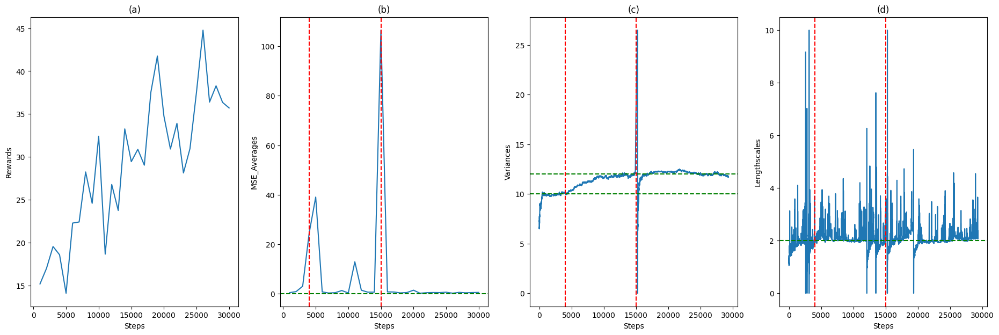

In [ ]:
steps = [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000, 21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000]
##########################
avg = [15.171915, 16.990486, 19.531994, 18.570534, 14.0823, 22.268124, 22.397041, 28.23031, 24.575098, 32.39753, 18.645575, 26.770325, 23.737917, 33.252327, 29.435446, 30.872416, 29.021496, 37.52665, 41.75499, 34.764065, 30.908512, 33.899475, 28.115097, 30.958988, 37.56049, 44.771656, 36.384514, 38.27682, 36.345303, 35.699436]
##########################
err = [0.4227885605077058, 0.8700869057652922, 3.0264598327220655, 24.4922134523675, 39.05301029441171, 0.7397886802201069, 0.2831183877403466, 0.4324613954443939, 1.2848308375212698, 0.31125166745908994, 12.909137255019035, 1.4123887582085637, 0.6276164251116818, 0.638805523859387, 106.49638752329751, 0.7407262176576456, 0.6872243682900485, 0.33776509112675085, 0.48978616751274534, 1.4290555038980708, 0.19455026656210397, 0.42112808782803524, 0.49426388703467167, 0.45760352347514305, 0.6074043179113028, 0.215359619552727, 0.5482397040415374, 0.3740665045589738, 0.47814418475174714, 0.5267349563389693]
##########################
vvs = [6.630500994933553, 6.532851774377107, 6.696654801645572, 6.535333841173923, 6.480248385609718, 6.530257811016885, 7.075955936516704, 7.005959520439926, 6.9077806626220255, 6.860460498808821, 7.039536004847289, 6.909305896085225, 6.93679713781458, 6.787295731192327, 7.319859107007518, 7.223544631321546, 7.245087454126543, 7.241096652870883, 7.224795589957839, 7.744548988381005, 7.6657340642653855, 7.563525964810873, 7.522960056814443, 7.409499680432461, 7.337471155192412, 7.241205814342649, 7.160618108434354, 7.095792845055689, 7.001645847018496, 6.96291101992614, 6.949409582988414, 6.885507761076637, 6.853800312328927, 6.82826398077218, 6.784482144344153, 6.891185286096289, 6.840186630505499, 6.940409916239794, 7.115386795262203, 7.610039504353298, 7.516239120085952, 7.466919526751307, 7.415326408107892, 7.366625613435241, 7.291749924613345, 7.415878442127642, 7.335134623723697, 7.3902904829603635, 7.297637129962778, 7.225497056575393, 7.257754555181919, 7.196672273032815, 7.119888840871748, 7.039931620801717, 7.629896033763828, 7.814583515254818, 7.924965354041386, 7.841007355531679, 7.79967778127246, 7.746466565300459, 7.728586598034975, 7.71831758340427, 7.70304179705319, 7.809855647176133, 7.767597637713098, 7.743122215736329, 7.695931348127556, 7.728683242811157, 7.724587371309027, 7.721532445317331, 7.670694188771797, 7.750753434275684, 7.793627836650204, 7.757092531703784, 7.840443403680212, 8.015552254784504, 8.066345286050199, 8.628372201382124, 8.807271678889089, 8.791296922781399, 8.764911665270128, 8.695500011606393, 8.695031042381014, 8.874917094454542, 8.841907295315252, 8.784103555192559, 8.854112408271762, 8.799435170870314, 8.858888859551085, 8.858286763814593, 8.900136542294138, 8.962568446312218, 8.902207795511437, 8.947062836864587, 8.904554862245856, 8.94479742672337, 8.918790477710912, 8.873425572206775, 8.813940867212965, 9.031803450807292, 9.010881091653582, 8.96620537305847, 8.935070806168962, 8.891494310172677, 8.852874117674945, 8.881382402236545, 8.93470504467502, 8.876333513927879, 8.815081510281441, 8.856273595956603, 8.939949551911113, 8.906588127337267, 8.869904231921304, 8.938603510996005, 8.930582123157892, 8.88399566569229, 8.841050019459747, 8.806515317801438, 8.801089270953046, 8.81215461263944, 8.767867596738242, 8.7488005713304, 8.862455409638647, 8.954646055715692, 8.92507087423876, 8.878580008415412, 8.823736246577338, 8.816929950169998, 8.997239976121877, 8.972430677658952, 8.948299000075043, 8.92782201561252, 8.873021033983507, 8.911269062404605, 8.89194472821532, 9.033596200063217, 9.043379786346279, 9.03557002788465, 9.010782700645112, 9.017674630077758, 8.999950390821855, 9.033665457458165, 9.024027341339865, 9.006773183523764, 8.983102714678019, 8.955240875608833, 8.942287949255032, 8.978702721667476, 9.047150442020193, 9.046173590636867, 9.055821482627076, 9.021824257676158, 8.984272311889384, 8.984996228426398, 8.950425304126798, 8.993050450170042, 8.948186772447395, 8.900726077879392, 8.87920951568459, 8.880649879452184, 8.917446087552515, 8.882544697650317, 8.852154616145405, 8.813041312804703, 8.786476488229562, 8.775465184218987, 8.787506776963445, 8.761286557250676, 8.721773479176923, 8.728225892725504, 8.698699474015676, 8.695512907854107, 8.699816667365178, 8.658297686174341, 8.654652720298326, 8.619351461411782, 8.59699654893487, 8.559402324058382, 8.525563784618898, 8.50296116329568, 8.493655890369277, 8.454135898835649, 8.432263141630877, 8.412535225171242, 8.397558715544132, 8.434415062190267, 8.423214635625504, 8.399670102544912, 8.409486824517417, 8.432953047060286, 8.424347730466891, 8.427830919058636, 8.452288423552794, 8.4309077326542, 8.406766245550315, 8.463779909208139, 8.433141015342525, 8.402572603407421, 8.422577570561701, 8.438463753559333, 8.457159202425396, 8.433804503958548, 8.414959136070113, 8.390219129738531, 8.39284437169318, 8.39168928264883, 8.364939329819125, 8.400270848047153, 8.377689759910414, 8.409869233996574, 8.405638064405636, 8.422568345277881, 8.468465637883519, 8.502074250805933, 8.515147405280578, 8.547569996730395, 8.614101052809986, 8.773394036008593, 8.744451249094348, 8.726603281167439, 8.713360103111636, 8.705330682626926, 8.676412938493584, 8.714279918556107, 8.682067263063898, 8.687190530404523, 8.660401850644302, 8.635256170118154, 8.606969755947231, 8.614065757634902, 8.619466745776615, 8.598163410325432, 8.565549653411065, 8.739648620944326, 8.748880473535118, 8.724823023916104, 8.716648936182771, 8.699186266749711, 8.672472602039527, 8.645329976223172, 8.633308267763594, 8.640757809547027, 8.620340503275594, 8.6257485833562, 8.637541160502419, 8.612874508153753, 8.617525793970831, 8.62049531048394, 8.612151182105746, 8.586088950144232, 8.588641587617227, 8.599594291822145, 8.579499339595875, 8.561874288425141, 8.578210880000567, 8.55267159165739, 8.547447030587055, 8.543553951215621, 8.570646414974558, 8.60395032473659, 8.600739088648098, 8.634616079384008, 8.622647593683235, 8.801646094057746, 8.846430965085249, 8.835841629703067, 8.831609967927724, 8.803545908390605, 8.807174397502111, 8.789717835688101, 8.786109407356363, 8.821929190467607, 8.79345207887246, 8.793481576936882, 8.865193786998738, 8.865999175225417, 8.845412781806361, 8.826173789652675, 8.885462328485731, 9.060205428205787, 9.0998797727988, 9.10642611391861, 9.155445049241504, 9.19859354240914, 9.204190133935484, 9.192879126511016, 9.179211544897326, 9.163717063722864, 9.136650882012777, 9.13378492579302, 9.14344918718715, 9.12012241912394, 9.115872036520027, 9.106595668624292, 9.108857526656179, 9.127787377405523, 9.112981340700859, 9.088678183176269, 9.064611320334153, 9.046037312548265, 9.036642568642453, 9.019444064156675, 9.000956201814775, 8.997817750824906, 8.993817173773477, 9.016588382850912, 9.04399586155913, 9.113467158011332, 9.092468829039557, 9.096808881296475, 9.08358934270981, 9.06337321956391, 9.077014915322296, 9.05259474369138, 9.033654183241325, 9.048713077926914, 9.026505142915166, 9.05872615515719, 9.068572124642605, 9.044798464404018, 9.042928087882263, 9.030402954612965, 9.035173121779241, 9.021615614085432, 9.001217928933713, 8.98213767906148, 8.988324146829253, 8.985634080600585, 9.057502027501634, 9.043920525567403, 9.062228851159036, 9.044780995402872, 9.060791492598922, 9.083838438819098, 9.074375352758082, 9.078586056866367, 9.06366006809464, 9.074642707299494, 9.131725319126728, 9.142397031535015, 9.170211752586383, 9.149672315352994, 9.137468584722123, 9.149806740694272, 9.133983776918566, 9.133193897071124, 9.147800785038799, 9.146282365551029, 9.132377242550765, 9.113435020348136, 9.12947457469649, 9.156098363664393, 9.13937686819103, 9.126882005368966, 9.168401489093581, 9.147964576244476, 9.139967984410381, 9.12853476714899, 9.108858657529483, 9.094536162748911, 9.079512525502148, 9.05962156752035, 9.038193684858616, 9.044504100984103, 9.025751615094489, 9.010271848575606, 9.106834569707088, 9.100726934721166, 9.16968514842984, 9.248256738969147, 9.239683139395783, 9.297107238126086, 9.289086946028375, 9.357276128642571, 9.338406881116846, 9.375663690592264, 9.413309955480164, 9.431731060026493, 9.492488266895382, 9.477413308653086, 9.47429780788261, 9.481919627491111, 9.463376283069001, 9.462478920234638, 9.492333214204827, 9.487340500351696, 9.486591907352853, 9.468685535703816, 9.46839321909958, 9.457808560149802, 9.50843112105061, 9.53162069646022, 9.536961374168682, 9.528317439047376, 9.508777837203969, 9.513056098352093, 9.509894568883826, 9.493595268608324, 9.608551510574301, 9.588253167400905, 9.573782169240815, 9.608687077863108, 9.587594737387093, 9.567047237698095, 9.698956728510673, 9.69303299088499, 9.675604708414514, 9.657776767889496, 9.646866159495788, 9.638277526156296, 9.633642315801035, 9.655297826508422, 9.637935893982846, 9.630032862588378, 9.67332586998865, 9.674677802024622, 9.657029423149835, 9.648277073633896, 9.633997482848493, 9.639498424342671, 9.625857495137234, 9.633504454939382, 9.62004371817189, 9.634552700884212, 9.644765209981982, 9.6984120138803, 9.755519516091981, 9.738715583182588, 9.772213437362483, 9.757691613381024, 9.752701196227692, 9.735424630062084, 9.72102528157041, 9.863041326229686, 9.848220199732403, 9.880270559104046, 9.862999082477414, 9.852363799186065, 9.856967515663058, 9.88318759053019, 9.89419251988237, 9.928714897860413, 9.923477841831318, 9.925141658582616, 9.946614966553975, 9.929201006760941, 9.923541842330083, 9.938399165897378, 9.921312300637263, 9.906465418260453, 9.90961027896254, 9.898949400762708, 9.882042429521432, 9.88515385748076, 9.864605893701816, 9.927338143062572, 9.907879725601662, 9.920548072166289, 9.915527238200344, 9.901058875838993, 9.889533874169983, 9.87045957256051, 9.879590149228841, 9.871983154401283, 9.91513493284492, 9.89934890411938, 9.884110594723722, 9.869588288114176, 9.90023799519875, 9.914527081434482, 9.95195738838662, 9.946413923849516, 9.933724487383703, 9.950333192787609, 9.945968375161604, 9.93983419661834, 9.950548096418496, 9.931616563634988, 9.916148771450327, 9.898315663829287, 9.885859651050392, 9.930825009270386, 9.93704540689113, 9.923545580849344, 9.925159756809203, 9.924533058192834, 9.910189434331961, 9.91699678925492, 9.928011996629431, 9.917089884161895, 9.979389406431581, 10.016341403091403, 10.036715462367784, 10.029850343336538, 10.12080204058027, 10.116275552056786, 10.117959751568637, 10.111366857508482, 10.096237970201125, 10.08075601451064, 10.081370820904691, 10.071533948834064, 10.159482753032071, 10.174374281671104, 10.16608499940142, 10.19026412537895, 10.171639107630973, 10.154639300454175, 10.138635100310285, 10.126014417378775, 10.109756247332061, 10.100319632232026, 10.089130215521191, 10.134166790138666, 10.139291847540049, 10.127772065287918, 10.157567193425741, 10.147077234343643, 10.137525230741405, 10.127731958137108, 10.111100771938075, 10.103628042186365, 10.119802806735931, 10.106839019390899, 10.096430892275016, 10.083639697389673, 10.088415118630309, 10.078466362487376, 10.08404789855412, 10.066555904355097, 10.051827910387715, 10.071496828197825, 10.055399085997536, 10.076640063291247, 10.094440923253158, 10.087992161080763, 10.077481360171157, 10.107659987093879, 10.099059730393485, 10.081570933505352, 10.066367706072679, 10.077883596484433, 10.066092965185792, 10.053823156725878, 10.042217268682155, 10.066165009102233, 10.052489154913236, 10.052743284074987, 10.052668197813405, 10.037599183125991, 10.048643164558353, 10.041117920602002, 10.048934909257015, 10.052535700040675, 10.037508446214233, 10.023746505257506, 10.032781745599715, 10.024430324367636, 10.020973664378253, 10.01969705777282, 10.022803877244147, 10.015338364350983, 9.998899572164548, 9.98392109165116, 9.980882545964848, 10.000829080538804, 9.984779295271698, 9.992734254657458, 9.983524395820405, 9.969825483328686, 9.96370763905455, 9.997863478107702, 9.981801528085004, 9.968362142678341, 9.95991962266616, 9.948836398610656, 9.957722874792845, 9.952876700663314, 9.939403826683337, 9.953296116695405, 9.946706845458797, 9.938262150622066, 9.932835397009809, 9.923652881253457, 9.916333930973687, 9.905540613602406, 9.930131256790219, 9.932770283414248, 9.929357152502751, 9.91434106857538, 9.90661081658607, 9.900643102589262, 9.893537661377886, 9.969418944409997, 9.971689608684963, 10.0029911690972, 9.991228286820126, 9.987274372730083, 9.978932708209367, 9.976353754015687, 9.987164252164803, 10.012298898000083, 10.048650924973307, 10.037281756646285, 10.035981788012082, 10.034959592180687, 10.02902974142939, 10.021320500969097, 10.032374405217102, 10.02404549283994, 10.029462547931297, 10.01833819320085, 10.00402339793452, 9.992977011887632, 9.980324603756804, 10.001408516334871, 9.98583354905264, 9.979623415728357, 9.965745620782915, 9.968542027560094, 9.96650693777507, 9.954650237832865, 9.959052977072876, 9.951471744936093, 9.942764546444405, 9.939719701641414, 9.934440811557236, 9.935014325123555, 9.925594460959472, 9.919000728089015, 9.907492849489286, 9.937270118675452, 9.929870561476385, 9.92724382728218, 9.930971219035287, 9.924320827761024, 9.919647528084061, 9.905675377837865, 9.90565101802295, 9.895241545782383, 9.883839438195437, 9.875726742233896, 9.865029805329106, 9.872033722679516, 9.868092936714948, 9.867431575506863, 9.858664947500976, 9.845768873851103, 9.832277977054709, 9.837337273638708, 9.82502318726782, 9.866304058604191, 9.922828734069709, 9.91111547288305, 9.901510378187533, 9.888830938207118, 9.877614017263895, 9.890407936014306, 9.892013591962527, 9.884788519345953, 9.890736017421293, 9.878714740811285, 9.884379261027487, 9.88702152922343, 9.91188242758391, 9.907315370978582, 9.900929706638859, 9.898185889304775, 9.888535232475405, 9.888889064511254, 9.886905995348922, 9.88172681645472, 9.873713103332278, 9.862534526733356, 9.880953061346302, 9.88004617624233, 9.86818709343055, 9.867032001571054, 9.855537881898034, 9.863633260147507, 9.865563011415787, 9.859214324024494, 9.862077061788682, 9.8563574439234, 9.87335106193096, 9.875153783875197, 9.871262211307167, 9.881338248291927, 9.8725081312514, 9.860596687494704, 9.847946320551019, 9.85583630932036, 9.854783440213632, 9.860154486203271, 9.857757737637472, 9.852566326923249, 9.856408998439804, 9.890031441058017, 9.877941444808986, 9.917763272932708, 9.920262557061521, 9.9698573010939, 9.964623558756076, 9.965193167180702, 9.971837885495832, 9.994161580188806, 10.030387448314432, 10.02943420575511, 10.037137293867893, 10.025165074138442, 10.014851717846447, 10.0333529875539, 10.037653231045946, 10.026327518320533, 10.014812252605505, 10.007546589974842, 10.026845512705583, 10.02069802791743, 10.019106336765027, 10.05472598446163, 10.042778406181345, 10.035215818006623, 10.023266180506393, 10.026166219229195, 10.01413866043141, 10.008003925605415, 10.02148109065537, 10.017002774633681, 10.061490446557261, 10.059636877058738, 10.048484657795928, 10.07275398065343, 10.081781465862285, 10.070874497133467, 10.064651061772603, 10.05771544061074, 10.046055672953711, 10.043474481355654, 10.037630330587456, 10.055090844718007, 10.069200692812084, 10.061810669064311, 10.049754307446847, 10.056182370202686, 10.087954113395673, 10.095789898629969, 10.0948966812737, 10.086450877137896, 10.098812330602632, 10.092701800285111, 10.095984344150787, 10.11916360998206, 10.11194283700299, 10.102960981312126, 10.098889540573417, 10.087246984644013, 10.08246209331237, 10.073735097212163, 10.10470485106612, 10.117128505569775, 10.114647489790986, 10.106454840201073, 10.146168515803033, 10.138852399321921, 10.12965725462695, 10.12917761152353, 10.11965537472404, 10.119660420703935, 10.107998655349206, 10.11465457506116, 10.117928318909158, 10.109922977675792, 10.112228685342059, 10.106788956901637, 10.10967003642857, 10.104289583973099, 10.102615858669932, 10.093336025019173, 10.09885794182279, 10.098248850680433, 10.089923282940244, 10.079725443138445, 10.07036481496619, 10.06320716287255, 10.059264808205537, 10.05927912938236, 10.060415140719497, 10.05556560898299, 10.05459007470419, 10.046748956080807, 10.048643556773644, 10.037849200990204, 10.027511575334508, 10.02883854930001, 10.021443526766415, 10.018257680122971, 10.011161238509827, 10.002285760232045, 10.002236910071307, 9.992330472337981, 9.99168818059435, 9.983982680415755, 9.986122423992493, 9.986339865751791, 9.981671674760607, 9.997035821064358, 9.99150931362549, 9.99398508629123, 9.999726267486547, 9.99048500748108, 9.984007730490722, 9.973509895766007, 9.986059937540384, 10.004307502996507, 10.001295699825851, 9.99586934961591, 9.991844920088099, 9.98099236000102, 9.984536950368666, 9.980458911417184, 9.972035733529138, 9.963436346032307, 9.953176444487497, 9.946367435965785, 9.94309463778489, 9.934328143306795, 9.927907561212574, 9.919503786127962, 9.942392607425546, 9.934291720059846, 9.9227811222048, 9.92435578849071, 9.920325796008276, 9.915783446511165, 9.904823121742616, 9.900087990555159, 9.906941093991925, 9.918318906134507, 9.912562416654524, 9.904726824276974, 9.895086808060608, 9.884529534839334, 9.873850511997999, 9.863400860838862, 9.8548542599264, 9.856261128195351, 9.85037780212348, 9.855795995728386, 9.849595252182127, 9.848022138966245, 9.8453210656239, 9.838393607567845, 9.83227110290555, 9.829969910277363, 9.833630559518488, 9.832128821109881, 9.836602908882703, 9.836991557885725, 9.828552373727579, 9.82416440589514, 9.86064052672138, 9.851345196700612, 9.842119515861818, 9.848711013162918, 9.848213040952908, 9.839745382654025, 9.883421848682449, 9.887562465990698, 9.916610736266778, 9.909075176179337, 9.910044643910112, 9.906154680157185, 9.896402920619105, 9.905772434709322, 9.904136005012091, 9.899378640359751, 9.898172819587682, 9.889459119560803, 9.911925175006413, 9.90277857811194, 9.89582107812393, 9.88639900394941, 9.88660119763501, 9.883954352572712, 9.882547705419949, 9.879717549642747, 9.8763356680897, 9.865937193165747, 9.88458039720527, 9.877962062291846, 9.874454831845865, 9.865383085901597, 9.866494151108094, 9.882072679151108, 9.887656696616789, 9.896811776305023, 9.892146033614832, 9.890705557070955, 9.891446260303475, 9.889938031724988, 9.882449402513622, 9.874885760551459, 9.866824057961193, 9.860570126658263, 9.85324925466188, 9.871710297651706, 9.877268853020755, 9.867913252221609, 9.87604178560438, 9.875172754457317, 9.865679465427885, 9.905383526787933, 9.899257728937668, 9.91712075656411, 9.917715072652337, 9.921447020808811, 9.913270895708136, 9.917997502762367, 9.911178230843534, 9.904426535673238, 9.897106046181214, 9.886921127872272, 9.884762011220339, 9.878601914930929, 9.877449716141081, 9.867193600647239, 9.876122113775939, 9.899025295316276, 9.908752923219636, 9.900826062131001, 9.895397424315416, 9.887824094408757, 9.88838278848677, 9.884929628134547, 9.892867273922358, 9.886930097646214, 9.911518523411697, 9.902036677767418, 9.901261600624963, 9.892899471050375, 9.885418490056612, 9.875485695021942, 9.881799240756749, 9.881236172179602, 9.891797053513278, 9.88655791960424, 9.881481439307754, 9.876314159009143, 9.869658578849938, 9.860550009534036, 9.86762953807629, 9.862630007196021, 9.863280022407597, 9.859619704158465, 9.854049689999577, 9.84936699153099, 9.839690337581118, 9.848865022849273, 9.842078347118937, 9.835951122149032, 9.826441516375686, 9.841597660296454, 9.835116495412988, 9.831404685767119, 9.850989260558217, 9.843327267163618, 9.85099378827134, 9.859068550012108, 9.86399651340864, 9.857454316163722, 9.851581814879987, 9.847356279159332, 9.842092262966215, 9.861373810314625, 9.874214321019316, 9.88894688152112, 9.888504915744324, 9.901226082856716, 9.897595302842758, 9.89217021539748, 9.882491380197084, 9.880528719727298, 9.87895220043504, 9.875682453468315, 9.873000611699421, 9.866649224669375, 9.859337594629487, 9.867127934634322, 9.875552737547954, 9.894573837224161, 9.90262807238666, 9.900699873172845, 9.909624950394495, 9.909374844271674, 9.913973199686192, 9.916378318825684, 9.909669286256074, 9.904017760866543, 9.89788733356181, 9.90262905461388, 9.909193752985672, 10.019772595049423, 10.011953216219382, 10.007471734865028, 9.998374195632861, 9.996743972252023, 9.995455132556513, 9.995138828971752, 9.98834531439871, 9.979869947134, 9.981248829166983, 9.982746189698723, 9.980457178819307, 9.99379858633264, 9.988966683844888, 9.995692378306881, 9.987042688536189, 9.993610740588508, 10.002354346889643, 9.99337339153126, 9.984925396462465, 9.98512374614762, 9.981194203970219, 9.975539448038143, 9.970251297637082, 9.96764516128247, 9.960437604894283, 9.962373485244164, 9.955435879059104, 9.946752745787515, 9.940354731486611, 9.933884371674061, 9.928871429351384, 9.931732539679043, 9.945725635241535, 9.938953117021674, 9.93235599152858, 9.944911719700503, 9.938503051510109, 9.945359978853105, 9.936924745775373, 9.930910869394255, 9.921906421855777, 9.919504741915661, 9.91368833668277, 9.907694088435365, 9.905386433073296, 9.904700695175107, 9.897057703255184, 9.90451946285714, 9.901195277040179, 9.894950339015262, 9.899144829014276, 9.89308169225911, 9.886827220539478, 9.894807596060412, 9.8994894621315, 9.89822897043862, 9.89640856242211, 9.905351986837854, 9.899339913499281, 9.89771512150417, 9.900229960357589, 9.902591892604066, 9.903535636973036, 9.896274220510358, 9.889464718661408, 9.892778102252688, 9.891390661382998, 9.889209758129898, 9.882020901425548, 9.887824232905688, 9.886238053213665, 9.884510299309078, 9.87873511448469, 9.871504229352908, 9.866025931978895, 9.866745659114398, 9.858533925306466, 9.852375855171266, 9.847996117805929, 9.849333079812878, 9.855023082947302, 9.865516953555838, 9.866033766275542, 9.863487328014909, 9.858043715222749, 9.850923864661919, 9.862272599490515, 9.85412052490149, 9.854549910749286, 9.851614752206467, 9.843746624907277, 9.837519870862321, 9.828913265366262, 9.84582366838269, 9.83735077480775, 9.840219252896738, 9.836628220675477, 9.83361280188189, 9.836734227471963, 9.83095127850305, 9.822389714252147, 9.825035890023974, 9.820436054847146, 9.817213313470454, 9.812758991017455, 9.804612234303175, 9.796144192856037, 9.801297667529917, 9.800561552690997, 9.792448460372691, 9.79312793300745, 9.787677265096132, 9.788750699580069, 9.801955430077793, 9.794908842842764, 9.78668445552045, 9.804356979601494, 9.808000784894666, 9.800080884525109, 9.80295748059478, 9.814562657896367, 9.806381588688417, 9.80542400573531, 9.805242562362467, 9.803873027101922, 9.83620285367759, 9.841716559451788, 9.851916982761697, 9.843702087648747, 9.84196857467646, 9.836580961239802, 9.830983208404877, 9.823171465013703, 9.817506652213693, 9.813630370253334, 9.811949649292925, 9.816490322423952, 9.81975105853211, 9.818491047670857, 9.818567560027079, 9.834894283832439, 9.83197875086767, 9.830918880754679, 9.830436172147216, 9.856526798144492, 9.850167786697824, 9.85457123575154, 9.863658395830727, 9.862421035106092, 9.877008285281311, 9.895763297758844, 9.912714481876295, 9.929239822308602, 9.96178286724791, 9.953826362594853, 9.95969137290895, 9.959872457353784, 9.957879439272856, 9.953997480269216, 9.957645753597857, 9.951267472537639, 9.953269985473657, 9.951747901264921, 9.944670496752751, 9.953645855231839, 9.948145090070815, 9.939882801794608, 9.93479138516318, 9.934365915606904, 9.931135606959657, 9.929368116851347, 9.928005579085099, 9.925837234538147, 9.918811846034544, 9.926053112777387, 9.926030556709586, 9.93145311273017, 9.92709139084306, 9.934771946834916, 9.947282243799094, 9.940254024526407, 9.933699163230239, 9.929832921842497, 9.938669226192628, 9.935055085454948, 9.932174076612725, 9.926490129722671, 9.936198577255448, 9.928801115051375, 9.92099834193852, 9.921601635194502, 9.926426996837167, 9.927896611105734, 9.92600215722695, 9.920944933690036, 9.913696182837157, 9.913226349807058, 9.91089303094223, 9.907498777536055, 9.900721033557971, 9.930735336764855, 9.933827256912519, 9.926553545457436, 9.935911933770388, 9.935518507954542, 9.933117008459998, 9.931409192823748, 9.927164636955206, 9.925293466090784, 9.919574154450038, 9.913145378428618, 9.919393421746577, 9.918728126014496, 9.923362186706738, 9.920982435255425, 9.935351107722095, 9.932593575818462, 9.932174835964249, 9.931590612429005, 9.928107247068796, 9.944726815537654, 9.942939149197466, 9.93515386672902, 9.93426195445583, 9.927763303952085, 9.927593196058691, 9.924146390107252, 9.927297419437323, 9.936773050187458, 9.937876514613503, 9.933392961822197, 9.929579649500198, 9.923417789321729, 9.923527457369925, 9.923989250481688, 9.917740097746485, 9.912789170074834, 9.922025809789156, 9.914470926867754, 9.912963969528121, 9.90768416839286, 9.912731828924468, 9.905852696048795, 9.900101511801616, 9.906653161235623, 9.900205086153173, 9.897493262817962, 9.895118593478744, 9.893388272499624, 9.88845255223298, 9.88342386096945, 9.879250051826807, 9.8814951191929, 9.891386099619956, 9.884264842189365, 9.877455958102997, 9.877389626888089, 9.875420320672204, 9.871767790333516, 9.869173982840776, 9.865298783496371, 9.869688437898084, 9.866692457199786, 9.89238571544906, 9.8885844523101, 9.893937639539898, 9.89017852352887, 9.885160447023338, 9.88937165900925, 9.884762200509458, 9.879549374278017, 9.874583631626386, 9.88993083004021, 9.899513887884119, 9.894141270195075, 9.90064346658385, 9.893606786218752, 9.890753661796943, 9.884230424328697, 9.8827654978444, 9.880470877450579, 9.88872353290908, 9.88316735588404, 9.884601579290662, 9.88193022301825, 9.877929229497324, 9.872182437468814, 9.866240657367475, 9.865973883870462, 9.862822209965843, 9.873664646681872, 9.875362197340861, 9.881065073083084, 9.8748942443958, 9.870415782244867, 9.868505388888902, 9.862027106278926, 9.869578229467255, 9.893669800749052, 9.898507946457848, 9.892250114983332, 9.885609014675863, 9.898147968428832, 9.898241078100613, 9.901415829482266, 9.896425099473138, 9.89505139836917, 9.89154906316429, 9.884942249329486, 9.880428044865555, 9.893304378698831, 9.888526408692602, 9.882964766824887, 9.885571446343043, 9.891027762596618, 9.890554899982968, 9.884332385938826, 9.884773389542048, 9.879932510311972, 9.872925329780697, 9.873248503009355, 9.87692636949363, 9.880826092156777, 9.880121543289333, 9.878991016988516, 9.884273962571898, 9.889442647711359, 9.888079974087718, 9.89299772896305, 9.892315665168079, 9.889035106149883, 9.882896569923552, 9.88250492028236, 9.876005661043678, 9.875780284175075, 9.873986075695623, 9.870600584620979, 9.864459421937323, 9.860133833610751, 9.857099942666732, 9.855518660534324, 9.851393941758639, 9.850729508782107, 9.844751727962565, 9.84097378510542, 9.841196902263063, 9.8410821511765, 9.837426479959943, 9.83501867101278, 9.830339201708666, 9.825681548389863, 9.833969906572408, 9.835857381714609, 9.831751469776135, 9.835772476075348, 9.845118085316125, 9.859995620475406, 9.855939446497072, 9.852129647000535, 9.850157457828796, 9.861426909611877, 9.868876872013324, 9.869465635013073, 9.87164306631256, 9.876778318839762, 9.872826689690028, 9.868494912266776, 9.871567079469779, 9.889496299522857, 9.884930476650782, 9.885017514538326, 9.88211338184771, 9.87774620097935, 9.893532199961326, 9.89161115124008, 9.895182528501293, 9.88961544925127, 9.889335947233727, 9.884778101770896, 9.879786758786071, 9.88223919648822, 9.88479960493268, 9.880552302754264, 9.878339063318162, 9.881128182329425, 9.874750908452, 9.879801825489547, 9.876485063887019, 9.872519801666034, 9.872354014478214, 9.871326741296, 9.86657905090332, 9.860935845113469, 9.857595364042043, 9.862323055531135, 9.856852167444591, 9.860333763134081, 9.854973209673352, 9.870429858511702, 9.868423378848698, 9.8679078671895, 9.86116163960392, 9.866429886820093, 9.865836145135365, 9.86012306149455, 9.859086197563258, 9.873548074403736, 9.86721185518508, 9.896940643905229, 9.898252107232883, 9.89721528271054, 9.898814251785085, 9.905050475833066, 9.899577502486927, 9.898404192382143, 9.903442758369419, 9.90502838783071, 9.898972203288231, 9.893830637088067, 9.888202992497064, 9.88531053870681, 9.879539150321724, 9.875296896302185, 9.869684838257632, 9.873191150013781, 9.873667754228519, 9.900629250571734, 9.895085583813463, 9.900672528494958, 9.894741187164147, 9.896767805481115, 9.9039816010716, 9.898711866262826, 9.898355474323804, 9.896042318742012, 9.890773180245665, 9.886983525532775, 9.882190681331364, 9.877758650861688, 9.885760740905443, 9.888204607219063, 9.891470230408762, 9.885292427474647, 9.880207877261826, 9.878966909056254, 9.874212154311792, 9.8786936101258, 9.875793633552236, 9.870731918215327, 9.868026684042718, 9.867708841667014, 9.861661729809743, 9.86521802172892, 9.86343902842237, 9.8658860458706, 9.860835223357508, 9.865214185099106, 9.866907304204428, 9.876655057701214, 9.878221517588763, 9.894270483218696, 9.889077761290638, 9.883424744423696, 9.879471726610783, 9.88296362503412, 9.878833097106792, 9.872262268183075, 9.866460064599567, 9.86158901215051, 9.858198367221668, 9.885822738520545, 9.881019140904076, 9.875989917817986, 9.87196918838322, 9.881424548882345, 9.882095468250343, 9.879070840538194, 9.89592855877527, 9.895714232536045, 9.896920196037643, 9.893554901165535, 9.887347475698805, 9.883913509574217, 9.882676096705573, 9.879985647742263, 9.878815146462635, 9.878783436593764, 9.874987883693546, 9.868525154216318, 9.869186360526818, 9.868972161118505, 9.865563084162725, 9.864789708287795, 9.866103858566456, 9.8636415062796, 9.8606679657847, 9.867497154622757, 9.861986160411648, 9.862494525783717, 9.876990326083803, 9.871622250086165, 9.868908804788552, 9.873076669366263, 9.867654158758546, 9.861759888911962, 9.856564062647509, 9.862204827205819, 9.867407099862202, 9.876986106961574, 9.88137285806568, 9.88023263106833, 9.8830342088164, 9.877556858352579, 9.877694978001657, 9.871813695333238, 9.877381188134011, 9.880069468503716, 9.87553794467412, 9.879046638534453, 9.87352785031628, 9.874303702090161, 9.868559873903731, 9.879249740765243, 9.879134791287557, 9.882447940771234, 9.888016693735468, 9.889697730845578, 9.885404355806273, 9.882066684138852, 9.875943807552266, 9.871425849448455, 9.866743447999088, 9.866590259960935, 9.883017855617696, 9.877366513904736, 9.877019641855203, 9.871083196022626, 9.867440944585079, 9.876711243936532, 9.871676768240427, 9.868384306769812, 9.887545801195838, 9.89759104240039, 9.893166040751911, 9.889451036960903, 9.910188235511674, 9.90538335666225, 9.904618500358726, 9.904105166622067, 9.899418624190798, 9.900935340983757, 9.895657851704378, 9.892788062540488, 9.888491510926897, 9.890228712364845, 9.88641280794347, 9.887571708435742, 9.883590922383808, 9.879719596002495, 9.875447301469855, 9.870283166807022, 9.865313907871336, 9.864804342902278, 9.858876336746658, 9.85751010634521, 9.854205094227375, 9.850835830603597, 9.847117311353728, 9.84707169141264, 9.846043761233748, 9.841123999263754, 9.8371312495551, 9.833943712648642, 9.828639065349273, 9.835030016377234, 9.831827396971148, 9.837952848591454, 9.83357122647655, 9.834804782161486, 9.842002291255593, 9.836514752721946, 9.85218676396017, 9.846742777248762, 9.845703280759354, 9.850544327800534, 9.847974170464465, 9.846780829886093, 9.846181209011027, 9.847160235104063, 9.847061947819592, 9.841933191642495, 9.844707434275282, 9.840268750434848, 9.842120741730595, 9.836264529373958, 9.830311477424152, 9.824263289550943, 9.823151874853265, 9.828097409221511, 9.823395150474214, 9.822615380678737, 9.818843555783657, 9.814937813650225, 9.809683608344255, 9.810259759114382, 9.805672358459162, 9.807322542739644, 9.807454316803062, 9.80625961146689, 9.802710509745964, 9.79742682202964, 9.794343209337873, 9.790962065122434, 9.791187374028334, 9.793088065348917, 9.787278756588702, 9.784586763955806, 9.78569596062889, 9.780933474061202, 9.775930494011936, 9.789835810933218, 9.78663683541877, 9.79212054929729, 9.798135518198348, 9.792653478548925, 9.790407667902373, 9.784973918037396, 9.786135395878663, 9.78208957561306, 9.777130712582183, 9.789284277910854, 9.785940080801822, 9.78386305681974, 9.780930222223406, 9.782981224963484, 9.779925701973596, 9.777117582002832, 9.771804654074767, 9.789022685634778, 9.783530104227381, 9.786841229177682, 9.783544184779153, 9.782993939149302, 9.778833994274496, 9.774382462561952, 9.76900404957157, 9.771982898704007, 9.769507441259305, 9.770294587276505, 9.766948548923757, 9.761127617490427, 9.772457677490182, 9.776590221192578, 9.772953220554381, 9.77013777428299, 9.764381041588859, 9.75878737012887, 9.759425780947755, 9.765687317922968, 9.761178849626953, 9.77636504535612, 9.773977516398661, 9.774671573363605, 9.770433618136389, 9.776793746976708, 9.775799510698453, 9.79586873063441, 9.790667578371124, 9.787249010038595, 9.784559513547965, 9.779495791940777, 9.776010266239167, 9.774441191380062, 9.768974920316593, 9.775239982058311, 9.77646782236112, 9.772903438370069, 9.76911803752583, 9.777331328614897, 9.772034099846685, 9.771411028308343, 9.771212771017543, 9.774637859772518, 9.775287133692512, 9.771245854648214, 9.76948756864145, 9.763817889907095, 9.770209151791098, 9.768013571963431, 9.763187563940814, 9.765250274744737, 9.765884912320821, 9.760727046628013, 9.75536804344474, 9.750839128353261, 9.745234056365986, 9.809682212807562, 9.808193264088683, 9.803151437627779, 9.800564198097916, 9.801300083107497, 9.7965328332561, 9.794014243550171, 9.789057640006174, 9.788990247433233, 9.78418671394581, 9.778598762337573, 9.786372753860471, 9.783450713118706, 9.79358815999868, 9.795070426367193, 9.791911420014166, 9.79226796496461, 9.790137863983059, 9.790202798517381, 9.788922850887948, 9.789906075288846, 9.784658861375242, 9.780651220803279, 9.780740775818003, 9.777146610549252, 9.772283969205759, 9.786317272709454, 9.792721693102655, 9.7914879263698, 9.802089615271043, 9.796554154078997, 9.793324169193218, 9.808112500500961, 9.80807079423703, 9.804648298858933, 9.80067008870389, 9.79764353619362, 9.792939810362762, 9.797121682768793, 9.798264978516176, 9.794709869941224, 9.793012497645522, 9.787844419228287, 9.7981238236942, 9.796685504714347, 9.797743677104778, 9.800974756259624, 9.796375171313098, 9.79347990677122, 9.795311750099236, 9.791738409146234, 9.796010594320506, 9.793504433573913, 9.788725947063671, 9.787840307469429, 9.787928085812064, 9.784739412087891, 9.782094713652658, 9.780420496346238, 9.781848498686896, 9.776496740820672, 9.771865191736932, 9.774733080007254, 9.780250095503808, 9.780779562958132, 9.777291635230881, 9.773221902229588, 9.772349377420486, 9.767352406995053, 9.765098729236959, 9.766243435447878, 9.761891376033317, 9.768575978125483, 9.766352869545974, 9.765110777053353, 9.786716287921733, 9.781755746898813, 9.779230368503681, 9.775609882696314, 9.77045521418974, 9.77796333327709, 9.779103113627182, 9.776109370747387, 9.778585439138126, 9.77559462298909, 9.771109612166317, 9.772918091919768, 9.768544893054782, 9.763948494086506, 9.765423111170183, 9.767131285523394, 9.774995293435293, 9.790371462714537, 9.785653335500827, 9.790637995875525, 9.785579936493917, 9.785927811636391, 9.785287176090954, 9.782797157758038, 9.779529470208972, 9.780981543974724, 9.779989104504368, 9.806474627951044, 9.802957869650436, 9.815901181844414, 9.81297849307998, 9.808712661282785, 9.806099532108712, 9.814980258877606, 9.825893631873619, 9.823037699163281, 9.820160948445844, 9.818759241923022, 9.816173748453451, 9.81121967696315, 9.81176203942577, 9.810393728758568, 9.815024776699515, 9.819556139150022, 9.818141146993948, 9.813978988950009, 9.826970669887356, 9.829557051095154, 9.826623489795079, 9.822984897985084, 9.817973050024202, 9.820091699710815, 9.81483311059675, 9.812324166104563, 9.807853020891061, 9.802851144045167, 9.802323706973812, 9.799797433065581, 9.796401922550164, 9.796546038607383, 9.794207566060543, 9.794214455472625, 9.79624312673303, 9.795238486097604, 9.791069340438105, 9.787850295049212, 9.788021832611976, 9.784918715787832, 9.785494277544032, 9.78861990439191, 9.79358325747551, 9.789692975333367, 9.78587425190839, 9.785581296329342, 9.789010368028014, 9.787708904891552, 9.789147624637557, 9.800004395492023, 9.795801049239792, 9.79204130651425, 9.788919369224754, 9.786760584739296, 9.784726452108313, 9.781843698672352, 9.780306649718966, 9.784932764262406, 9.780594045210545, 9.791901871388289, 9.790469494940657, 9.800976333693102, 9.799598540045382, 9.801952740078988, 9.800161463691655, 9.812289591408813, 9.810893255832802, 9.813319628271442, 9.813165446441342, 9.810209678273099, 9.814909795901537, 9.811350569558712, 9.816536550723654, 9.814918551590354, 9.812031349107281, 9.821045344876042, 9.821471429084614, 9.816907526024663, 9.812000596843339, 9.82093687656439, 9.816453624397747, 9.813380301906188, 9.809463670589645, 9.80774814853085, 9.811197531709588, 9.812908634997823, 9.814012933437047, 9.81266536292044, 9.813742985470872, 9.812239021299272, 9.815575855219247, 9.81252772129988, 9.815999251307236, 9.812004531205345, 9.808904508598191, 9.812629667552276, 9.814102093804756, 9.81245411738791, 9.810659394576144, 9.811969592760784, 9.807276010694192, 9.80294411860437, 9.798724624980446, 9.795155701864227, 9.794925224182563, 9.7989187026004, 9.79499695800772, 9.790571528174363, 9.789301013209597, 9.788968924930082, 9.7860865530478, 9.786673648898844, 9.782225573373122, 9.779792474780576, 9.774879871239747, 9.77092775795241, 9.771216957764478, 9.770659663204587, 9.791982650377633, 9.79103545777139, 9.791457620910487, 9.78720578811876, 9.782507206950129, 9.782873107483645, 9.781343902798532, 9.790638869529692, 9.788302655713817, 9.78551131601068, 9.784833427947163, 9.787659913830822, 9.795313302460361, 9.80222992579055, 9.80420033797966, 9.802361301447004, 9.802438535213128, 9.802574409130473, 9.822911474539032, 9.841437512818429, 9.839251555631414, 9.838618880883367, 9.848625390737473, 9.844189641943293, 9.863232189942284, 9.860990265198048, 9.857407624275647, 9.85996733514517, 9.866812857686948, 9.866413575147293, 9.8656508215333, 9.860908464146375, 9.85688333810712, 9.855488749360584, 9.855568773264704, 9.853950673688383, 9.851949920280735, 9.84738093274624, 9.84596014727776, 9.841703803749073, 9.842809244512347, 9.837913414623952, 9.838639126765338, 9.837236201002062, 9.83413763090793, 9.833674421579431, 9.83485915652322, 9.857600191308135, 9.858748675902863, 9.872015555119063, 9.867862868265377, 9.869568889690475, 9.865533884387155, 9.867541797037164, 9.86456202641156, 9.862994399179332, 9.885204904853572, 9.886345830343053, 9.882083644966185, 9.87963521974414, 9.875670473524828, 9.873181209705493, 9.87760314721095, 9.880889727916653, 9.887726883437953, 9.889339148897225, 9.895522487232718, 9.891586201314164, 9.893302479758118, 9.890633378008253, 9.891274117986733, 9.893927011273304, 9.893980176231475, 9.889598061089186, 9.896334114558044, 9.905487618560608, 9.909449503122634, 9.907481941762653, 9.909059731835205, 9.910226018376237, 9.909227906071306, 9.905030325677643, 9.904367054675044, 9.902681238064268, 9.904552421533792, 9.900175799873736, 9.904051453376091, 9.900679674481434, 9.89830400473366, 9.894815511068233, 9.897245311296409, 9.896356275221976, 9.897857298944924, 9.906044714621865, 9.905367362504753, 9.922159221847464, 9.92211317505889, 9.924629988699337, 9.92376961596778, 9.931762304943225, 9.928166669756584, 9.924319675234514, 9.924753479876976, 9.925998288071206, 9.923299965021203, 9.921397717114324, 9.928540480606495, 9.924148649266314, 9.919827126604392, 9.915368266866993, 9.919381627068711, 9.917297578480218, 9.913716619429714, 9.926537014610957, 9.925333060360643, 9.922806802453348, 9.918279119184477, 9.919055514920114, 9.91636614685616, 9.91989102032332, 9.916081091939995, 9.914025781342433, 9.911633184201103, 9.911523508982489, 9.921292830394062, 9.932306242862838, 9.930039848456229, 9.931515641582797, 9.927070441454083, 9.92432012376857, 9.922452819126974, 9.91936028186428, 9.917325663321963, 9.913409349785276, 9.913363185434314, 9.911008617879746, 9.912890923652014, 9.909528629891842, 9.908864580914381, 9.918035752169592, 9.913499205426138, 9.950443532949649, 9.945886756330944, 9.949854926669957, 9.950118330438501, 9.957393276078266, 9.95433878969372, 9.953845605585427, 9.949986429118793, 9.947067528911225, 9.945740260745893, 9.945678446554671, 9.941313768867044, 9.95263684658066, 9.949115266053957, 9.948963538710775, 9.945772274195324, 9.943838154729312, 9.940495779869114, 9.940084695161495, 9.935557798394893, 9.942667642175369, 9.938724151580217, 9.93947242648274, 9.940564526364831, 9.936532834942527, 9.937533275389551, 9.93414477314334, 9.931730443252555, 9.93390604981931, 9.929877358005943, 9.932937110709565, 9.931923330448473, 9.927499988073583, 9.946610979229115, 9.943377761726067, 9.94161190218658, 9.93892144829901, 9.941639381495268, 9.944750223345256, 9.944440812862716, 9.940586241227802, 9.936409952121132, 9.934441920196297, 9.934275873448133, 9.934201540049884, 9.931706850737102, 9.933672590570211, 9.933424585315885, 9.936055533261998, 9.932500859811906, 9.930510493354415, 9.932024981970661, 9.93193604776368, 9.93523155515295, 9.931341118858104, 9.929609059251177, 9.934809006954522, 9.93237614003208, 9.930791255895054, 9.931890804540322, 9.928591253279775, 9.933785243466115, 9.933977367669524, 9.93152484139951, 9.930914580731462, 9.926547765789383, 9.922203678461381, 9.917751997034474, 9.913329678257275, 9.910553186567471, 9.91118433478211, 9.908287908171234, 9.90372944110094, 9.905048844573304, 9.903017964884771, 9.89928489966694, 9.90360296578886, 9.900157964414975, 9.898868455550438, 9.895478549678415, 9.89590260722373, 9.892600961180133, 9.891842695388942, 9.891899626478958, 9.893450802840166, 9.889492270704212, 9.893970550166905, 9.890998993791264, 9.893736217589971, 9.899165458041416, 9.898419889372034, 9.897384240053524, 9.893621654974627, 9.891212350490845, 9.890028355689989, 9.887011846572463, 9.886223543343549, 9.883043067109757, 9.880134790881518, 9.879231067273418, 9.881748863903171, 9.878582919797505, 9.875353726336632, 9.875448281501024, 9.871712862375402, 9.873439289487699, 9.872255648405426, 9.879998933902048, 9.879117855196139, 9.878230821842768, 9.876460802820931, 9.872504293294151, 9.869140949430804, 9.86835526304681, 9.864238009177717, 9.86687380669242, 9.868009157462012, 9.868821034130825, 9.865572383032026, 9.865889221864654, 9.863280787298205, 9.859516817473825, 9.856628441347791, 9.86339321104834, 9.86008194281305, 9.863866993352492, 9.860258776938124, 9.861341112867455, 9.864739339102512, 9.861163136515321, 9.858838627460532, 9.856288143840802, 9.85305081821435, 9.848942180789278, 9.84819356314438, 9.85160971440115, 9.848873385531745, 9.844921391839042, 9.84268717128713, 9.84543641292126, 9.84385626238612, 9.844700341179472, 9.84292601749785, 9.83953928404413, 9.842909630330634, 9.83939407619471, 9.837505577556138, 9.840866784465806, 9.83778841833464, 9.837141505780535, 9.83578441766782, 9.832266124555394, 9.839551502373954, 9.835395666049905, 9.83852619204642, 9.836243160073732, 9.837291552833276, 9.840926537823616, 9.836826921195701, 9.833842612388583, 9.830086027528973, 9.828113624901688, 9.83927216534809, 9.835695389177578, 9.835987509452096, 9.837706599230012, 9.833957938913638, 9.833574073763867, 9.840964301711232, 9.840097663402846, 9.837541639813947, 9.834658233258939, 9.832717190357974, 9.832219838939032, 9.828403745435157, 9.833462791873979, 9.83365874233919, 9.83409867722305, 9.843305070734148, 9.842551013628928, 9.840247710296802, 9.838424950270364, 9.838204004899795, 9.836909859593367, 9.845416107495973, 9.842910592004642, 9.84306664943756, 9.842252138412963, 9.844617168021873, 9.870515838218466, 9.875300821203759, 9.875083230617152, 9.874183699443607, 9.870729237974132, 9.873644376810788, 9.870229841284807, 9.868860291735084, 9.868996615883278, 9.865143584447733, 9.861232465146612, 9.864131456500983, 9.861022373176324, 9.858555201764432, 9.867435053085925, 9.875107386008551, 9.872260837089042, 9.873432496442755, 9.871461785204993, 9.87382049405155, 9.873200763015959, 9.86995116410173, 9.884586243639909, 9.880753628049273, 9.87707852180171, 9.874784896244845, 9.871317502191538, 9.873295418631987, 9.895028744532382, 9.892763511329244, 9.891072548322745, 9.894842213201597, 9.890718232044081, 9.89399229112431, 9.894645143753115, 9.902963923824982, 9.910998866564974, 9.90936821290647, 9.910311736930685, 9.909578814459481, 9.905395046617572, 9.908003471971334, 9.906811409889418, 9.907703986191049, 9.903551588488783, 9.918140952633834, 9.915682324432595, 9.911693691164762, 9.90826506336249, 9.905296837392887, 9.90771807701024, 9.909612560752757, 9.911181866228667, 9.910608023952308, 9.913860226679065, 9.910597199201295, 9.914430396056314, 9.911599071396164, 9.913581144795147, 9.911772984420674, 9.909812797218754, 9.907520076877377, 9.909836084698007, 9.910680797095843, 9.907309412996554, 9.904969488074647, 9.903911149591405, 9.900837772050796, 9.899266023008915, 9.896210889611794, 9.895824296192478, 9.896602394524262, 9.894344809773163, 9.894236618760628, 9.893529637173318, 9.890624752963701, 9.887199802562613, 9.888602218174738, 9.888528169002498, 9.884943566397531, 9.882190962292349, 9.87971303811119, 9.87880971458955, 9.87937188489136, 9.881111682496384, 9.882435495335518, 9.878295506620642, 9.876985261682924, 9.873024541883511, 9.868979732596763, 9.864934517123212, 9.860998858843747, 9.861635284227424, 9.863546229151817, 9.860884374098621, 9.857929939056076, 9.855933740320266, 9.871489719226238, 9.867479471114194, 9.865450336007044, 9.862511277417223, 9.862508009620976, 9.861208620461937, 9.860121412603782, 9.85683232099518, 9.858102358087944, 9.859665077301333, 9.863468774219037, 9.865272793878676, 9.861583285441672, 9.860752500002985, 9.857137032441175, 9.854180011122088, 9.850378894641622, 9.84657506439956, 9.843533259546744, 9.847513521001225, 9.844203687331179, 9.842757773444458, 9.840793010895124, 9.840521308267085, 9.84398168155589, 9.841501701190468, 9.837456183553225, 9.8411605793007, 9.843851887788837, 9.84292734351858, 9.845560222517786, 9.846411168873153, 9.843538137880067, 9.839603892776253, 9.837991510265045, 9.835664339481326, 9.835057323533894, 9.83108911391852, 9.868753503747442, 9.864823418268948, 9.861463405778766, 9.858786192796442, 9.855394005184376, 9.856384069201345, 9.865189991655269, 9.862279945163152, 9.86026777553798, 9.85817730527301, 9.856314328036273, 9.85238113626042, 9.852324383899148, 9.850865539457011, 9.84870568068628, 9.845154925077493, 9.85779259385878, 9.85529887201803, 9.852724764690384, 9.861530787627505, 9.860717295365774, 9.858647854956333, 9.854703589502677, 9.8617718239373, 9.862500383873865, 9.864625697265861, 9.865699474834406, 9.876111632455634, 9.876399353246033, 9.879737246180094, 9.880044440557784, 9.87722811861705, 9.874052228780002, 9.871745533139507, 9.869192935229313, 9.866450765658058, 9.86724144400363, 9.868969842221794, 9.866292899901186, 9.864009422749518, 9.86113571548575, 9.857813177881736, 9.855044915064617, 9.853616739862945, 9.850379176144425, 9.857784074292882, 9.858384578433435, 9.860252481829967, 9.857298807693308, 9.8570054025279, 9.855154753743976, 9.858873088592365, 9.855504559057104, 9.852167226720663, 9.84990395652079, 9.846169950993607, 9.84810868602672, 9.847626556329063, 9.844386359421653, 9.842609198747397, 9.842132024425503, 9.840222704868241, 9.844423967061653, 9.850417144085897, 9.847836526422661, 9.846235065420622, 9.850990603524133, 9.859668104009184, 9.856497525538842, 9.859808788961288, 9.857060585435722, 9.86124430909548, 9.886978957076526, 9.884426318708986, 9.904364658934618, 9.912797698406797, 9.910349204026035, 9.909964522141031, 9.912031305185716, 9.911720971860035, 9.908772626302126, 9.905374777383836, 9.906949294402116, 9.90668743604239, 9.904660032247024, 9.902053110990229, 9.900374393201385, 9.898950720105827, 9.895926176670983, 9.892147546734886, 9.888640144933413, 9.88469943373858, 9.88480396121785, 9.883731010180476, 9.883137748566213, 9.884960967940218, 9.885718847331061, 9.886211397267072, 9.883008521886417, 9.882121238448924, 9.88357455282339, 9.885732531975707, 9.897203730222069, 9.89405970352939, 9.898396447838026, 9.89460246019549, 9.892953016321158, 9.890641318754412, 9.887871150388468, 9.884552538118633, 9.881379176568071, 9.885737643119349, 9.894485073767278, 9.893778681092144, 9.891335018203147, 9.888375641569004, 9.885519410498564, 9.884944362612986, 9.884696084581329, 9.882972576841292, 9.879847998901493, 9.877134217725924, 9.87377135379278, 9.87000865175548, 9.873074431984392, 9.87091927037607, 9.86928388720712, 9.867190609741353, 9.864120879519799, 9.866521791798524, 9.864343236081728, 9.860982894163948, 9.863477841695415, 9.86897257122957, 9.865675388663968, 9.86533349477155, 9.86203658832902, 9.8601977962709, 9.865767625230434, 9.864147822858829, 9.861269713102958, 9.857614554095534, 9.858133191205207, 9.85475512927893, 9.85700400694941, 9.869861118657298, 9.866605407656388, 9.863215871767082, 9.860587853887235, 9.85892048756689, 9.855558732339153, 9.854336941966466, 9.851274124782877, 9.853195565805317, 9.84955308696646, 9.853393914158469, 9.849867856803515, 9.848358929723345, 9.847183990734866, 9.84757121264416, 9.844713853177527, 9.842199835309078, 9.841974767669077, 9.843253766903727, 9.84094176309866, 9.838658060083961, 9.839294144811785, 9.842023543986832, 9.839305749757424, 9.837324198767115, 9.837321577231485, 9.844550646710566, 9.844826709426629, 9.841769354944153, 9.841150043089888, 9.839583012104708, 9.839822763979516, 9.836325033734168, 9.833016633918106, 9.829406899907317, 9.82937817688811, 9.826173376126503, 9.824069956193256, 9.82980789762187, 9.827578193149526, 9.826237320784482, 9.839225918094545, 9.836011678261452, 9.840895824149062, 9.838664683325241, 9.84922045094122, 9.846328640838477, 9.842795267865892, 9.843042828759993, 9.840083248248236, 9.840541925524409, 9.837426806426668, 9.837766401305815, 9.834998679713843, 9.835348355687948, 9.850955409788197, 9.858780402878857, 9.85517732209061, 9.853480629074816, 9.851596437373477, 9.858862571361978, 9.858595667542007, 9.85805354011209, 9.854366723975744, 9.851959713552812, 9.850099731740071, 9.862894758388736, 9.859844949830917, 9.856535697527299, 9.857738315569833, 9.860834696041408, 9.858123679321825, 9.855944230321077, 9.85304670256851, 9.86356471232623, 9.86267573704779, 9.859408868535045, 9.855716295603736, 9.852889382936914, 9.853533055970994, 9.860968226342852, 9.858230585456871, 9.85579182060277, 9.856836904397364, 9.853168518624413, 9.852822047599279, 9.849649520507102, 9.848864663444774, 9.847083421721663, 9.850483108993936, 9.84835267317419, 9.849119574122783, 9.84656263311301, 9.85736116954705, 9.858186906719247, 9.85943190898492, 9.858421253993539, 9.855978416020061, 9.859767674640777, 9.860135358350046, 9.857232253645948, 9.86462134371186, 9.861303552538633, 9.857866686284876, 9.861210903294994, 9.863312189107344, 9.868139452995317, 9.869233722527985, 9.866323852256905, 9.863108735407595, 9.862324272963694, 9.859290029422336, 9.857644491183212, 9.856752341773737, 9.855092070795262, 9.852419063069497, 9.849654915334838, 9.856825659084233, 9.855689373122928, 9.853669063797094, 9.855374877785067, 9.856970892998762, 9.856894817788913, 9.855744288538125, 9.85224951487987, 9.853332475373543, 9.859151407090835, 9.859808780991978, 9.860716821361478, 9.860108477671806, 9.856510336906895, 9.854704712743294, 9.851638970290535, 9.85540640532411, 9.854856355008824, 9.86025781596412, 9.85733735465299, 9.855412306598694, 9.852758108727203, 9.852301552075803, 9.84932436091351, 9.850980930799855, 9.847356001943794, 9.860126023823982, 9.857067015858362, 9.856223374014528, 9.858511017319646, 9.880378031019937, 9.895034494973558, 9.891977831630228, 9.888630360508431, 9.885378827298165, 9.885419141104956, 9.881922139362592, 9.884591632467762, 9.881720667716957, 9.879536074837311, 9.89241192507452, 9.889645370264196, 9.912698019798588, 9.909892656594344, 9.907991049854413, 9.907531511669863, 9.92008021739944, 9.918744214778508, 9.917247915839207, 9.920029968541703, 9.918006356798927, 9.914817266967944, 9.91212909525781, 9.909016314962528, 9.906540772990384, 9.903165458638199, 9.901261895568028, 9.900377636220277, 9.897250930857561, 9.894891700136572, 9.903167010989167, 9.899557048004906, 9.904008945282456, 9.906618339093571, 9.906194328407716, 9.905342862508226, 9.905194937774908, 9.910013476188453, 9.917448384716295, 9.914371894734307, 9.910938759868738, 9.915141966498723, 9.916486278420587, 9.923158468993664, 9.920187109883226, 9.921605263932268, 9.91861863316909, 9.917814938227185, 9.915276273072642, 9.913814852305784, 9.918138771511495, 9.917378934408283, 9.918793322009595, 9.917849580697453, 9.916639017811331, 9.916742943773535, 9.91557947963295, 9.913093927271403, 9.911603012525424, 9.909911149689554, 9.907078506497902, 9.911642295711275, 9.91151512622957, 9.910218353686233, 9.916974371244448, 9.914144848736756, 9.914201368415197, 9.918296956387705, 9.915369233974284, 9.920800859426103, 9.918083097341801, 9.916935077099584, 9.914314879530348, 9.91152736169858, 9.909232030072513, 9.905929728964521, 9.902947096007521, 9.903164139350803, 9.91008648864595, 9.91448541410468, 9.914080602499224, 9.919167361590562, 9.916449829538369, 9.912962283688504, 9.909753805603108, 9.906389942476164, 9.903684271246087, 9.90158365347228, 9.905523763576163, 9.909999326845279, 9.907436810601649, 9.909344339598315, 9.90877624445917, 9.90524443131459, 9.903433921869775, 9.902483271151835, 9.900675597066062, 9.901345704376993, 9.901482181085305, 9.901310991899104, 9.900165632595533, 9.89669406034076, 9.895464103318597, 9.898864262386494, 9.902325151699063, 9.903397033176432, 9.919498687955912, 9.919616982321212, 9.918345282522594, 9.916757214594089, 9.915245025263093, 9.914736014840349, 9.917312602392737, 9.932061911908232, 9.935540328215598, 9.934784670553464, 9.93257134100383, 9.93334737785377, 9.931949695871657, 9.942834019328021, 9.94735212974681, 9.946447962078395, 9.94475906737068, 9.947646697898424, 9.94665181769108, 9.953046141298541, 9.951679518471012, 9.955926862334925, 9.962413088481023, 9.960643209381665, 9.964628481697925, 9.96809653184725, 9.97027830530534, 9.972616872462359, 9.970453634641673, 9.970803585373215, 9.967483120145703, 9.969621964232852, 9.96709406025555, 9.96887942708713, 9.966047783106022, 9.965025922731844, 9.97372034574373, 9.974328847135453, 9.973548426661107, 9.972480972727823, 9.97015162527495, 9.969072085798523, 9.969513210292284, 9.977810468901696, 9.9778930261009, 9.975121623305427, 9.972273786012954, 9.974069383248915, 9.971456854460072, 9.972137825818589, 9.968746350555236, 9.968425896995882, 9.966469186021785, 9.967258366922664, 9.970168199584986, 9.967014166744253, 9.967082775433859, 9.967453533129174, 9.972365870180802, 9.981946207651363, 9.982720180313136, 9.98126025264548, 9.979297997939407, 9.986616033197155, 9.98371589189667, 9.981014235065524, 9.982526628889469, 9.985598038927172, 9.983294923993704, 9.984932827148617, 9.982417877819094, 9.983818938955457, 9.983882996838123, 9.981257954710642, 9.984752821471606, 9.985618075029219, 9.982360872128012, 9.979274072872867, 9.979437918255337, 9.978409054398972, 9.975904389757165, 9.989349153372569, 9.989388319099726, 9.987431570626589, 9.984173481869046, 9.980935951329133, 9.983402634028476, 9.990131944245261, 9.987838896663975, 9.992160360958875, 9.990443008366011, 9.987678713709544, 9.986821375328923, 9.989071328826755, 9.986860857953006, 9.984097345364654, 9.984894126349191, 9.984992823020738, 9.982465260858394, 9.98754964971186, 9.984427610152823, 9.983975960627792, 9.980640781901025, 9.978038334000237, 9.975426675369299, 9.974983138402123, 9.977225660104962, 9.983323421304494, 9.984445423962748, 9.983070976914604, 9.983225243929464, 9.981931045188738, 9.978842346416103, 9.977749085504161, 9.974386236559688, 9.973952189082606, 9.972807047186013, 9.970805792382126, 9.975636692666201, 9.972339932587293, 9.971525837215513, 9.972599970779259, 9.97373629399797, 9.970582544271247, 9.967843993646651, 9.965960636454211, 9.966454755599694, 9.963092889116416, 9.962739183789616, 9.962592586810429, 9.960478104349956, 9.959361885223863, 9.959399810181983, 9.957969750649221, 9.957018457611971, 9.959557373922538, 9.965755485238592, 9.973317245129024, 9.97150058317482, 9.970676089330187, 9.969731262839852, 9.968457831348669, 9.967123803087697, 9.966491471483362, 9.967003451546129, 9.965427285639722, 9.962427349535295, 9.961976979983419, 9.960728983665291, 9.959430538733889, 9.961149776271101, 9.962566251942325, 9.959948737375115, 9.960462685750583, 9.958957730999149, 9.961102473386292, 9.95806382888668, 9.958523613712973, 9.96083908496018, 9.957956134308082, 9.954624690330597, 9.951826303563251, 9.94906522555163, 9.94782002596652, 9.946543168130898, 9.944027055803486, 9.940827805181806, 9.938381676227479, 9.935338018373075, 9.936386522211476, 9.933626236291929, 9.933101180013065, 9.931753750010174, 9.929095161552757, 9.931662479611644, 9.942311256375477, 9.939110608406658, 9.937063430727347, 9.937991163831565, 9.935544814042933, 9.934022106725337, 9.93975204017821, 9.94102662273319, 9.941696396715535, 9.93850061296224, 9.937309725400294, 9.934139252553827, 9.935227357379564, 9.932957021127876, 9.930078811414784, 9.944872828854667, 9.945533140088845, 9.939596325678101, 9.936363976752757, 9.942552756718097, 9.947596620046706, 9.948045265344179, 9.94591899342685, 9.947549490146391, 9.970513141210407, 9.9688287313422, 9.967586304587092, 9.963567687195397, 9.956094999337957, 9.952944462614084, 9.960140609845828, 9.963563620673222, 9.951585700218681, 9.94849194812102, 9.947350128533698, 9.946088500475753, 9.956855368600616, 9.9516444312596, 9.944958510083566, 9.96012546066284, 9.962050793137044, 9.956344878427549, 9.953339990991541, 9.960604875993075, 9.960782314010501, 9.960030537069919, 9.964828962347388, 9.956591587079238, 9.964782034332227, 9.971205712040819, 9.972220052844765, 9.972103006036487, 9.960076703754687, 10.005034779705, 10.003536949398596, 9.996112190206585, 9.989468085683002, 9.98297242341583, 9.980307892495867, 9.97308148389957, 9.969423237289199, 9.96290697967307, 9.98468647442448, 9.980804145897226, 9.98114965231433, 9.98962709293794, 9.989425344536068, 10.004154138735291, 9.991737869034335, 9.989143800666808, 9.98706958207626, 9.98581242126931, 9.984268071398628, 9.992803572041858, 9.990344863015656, 9.985494297040919, 9.983499154547834, 9.988058726791891, 9.981547778547737, 9.974827313669353, 9.9643876595743, 9.956750469627698, 9.949048628477673, 9.938982711221943, 9.945310748977079, 9.944797806646982, 9.962594417337453, 9.957148390095593, 9.951277265555099, 9.94484937891217, 9.938704644613155, 9.934121156663183, 9.926676303849616, 9.92234692234007, 9.926816039073705, 9.925113044753465, 9.936186908107642, 9.935563203633412, 9.938708798455725, 9.934255914808391, 9.930321634148786, 9.924593536451598, 9.91927505248586, 9.928659115423017, 9.986022939015955, 9.990534644944754, 9.979903268298441, 9.977392917773141, 9.974562559183756, 9.995298778836903, 10.004572679814274, 9.992187994064926, 10.031774980691228, 10.02750215349247, 10.028644038106995, 10.018131401465416, 10.025538991585995, 10.018274816190234, 10.012541864911327, 10.012980921666992, 10.012186013278505, 10.009458785565037, 10.006387049842278, 10.00428422604503, 10.017291535117415, 10.011425599102802, 10.003812655835548, 10.00487926697903, 9.999716705524735, 9.992149233201344, 10.03091939975942, 10.075532497949924, 10.069295996792395, 10.067353952158635, 10.078706412307044, 10.077139488287127, 10.07014506929656, 10.07477225725855, 10.07183739250841, 10.079599579056424, 10.076763412773474, 10.080033961269022, 10.078295334104228, 10.07638452966711, 10.074034584789981, 10.07342353215327, 10.10790292775673, 10.099383657148, 10.088621094023676, 10.091852506050309, 10.086985259262343, 10.082423254362945, 10.120935620053999, 10.135753773659525, 10.145045104244492, 10.13667959263097, 10.13127010937428, 10.12752834749249, 10.118990283235368, 10.112459278723312, 10.103613286326373, 10.119804266898397, 10.165104121240638, 10.156845425746576, 10.16701673561977, 10.152795961703754, 10.161123804532398, 10.174140159615048, 10.167932685961693, 10.17559989450212, 10.175095959470486, 10.175001194473682, 10.184462886335236, 10.179556537046958, 10.176772499081954, 10.168356254962127, 10.15433322888677, 10.134539414241763, 10.12263253748676, 10.109382259844368, 10.097664440191675, 10.086171504384627, 10.086514068834006, 10.078554954757239, 10.072267838656895, 10.082978413249197, 10.077092872010425, 10.069034596875873, 10.06685971891953, 10.067220961881358, 10.062942299197164, 10.050153481588275, 10.038043039113859, 10.02614001821823, 10.023883851330108, 10.015641906902047, 10.024731471893343, 10.023576735707225, 10.020943043739026, 10.01416563968128, 10.028248898566742, 10.015183121226416, 10.0093821448332, 10.001365530947531, 9.999224148397575, 9.992355860852065, 9.985770220440882, 9.984286567392635, 9.982687138901454, 10.007627480396057, 10.045458993021319, 10.045048767085701, 10.03775007961639, 10.035743816483368, 10.028124793515529, 10.019665616486442, 10.01924770470843, 10.015483486644424, 10.008770829127258, 10.010166365163919, 10.010933138412534, 10.006188860058923, 9.99808211695503, 10.02010306682975, 10.017310187920776, 10.016157541010163, 10.013430601370144, 10.005274717000303, 9.997448871352605, 9.9933010213647, 10.008583260319593, 10.012115673282667, 10.003686549328773, 10.008327622694498, 10.003873877291074, 9.990501104402593, 10.000306621907965, 9.99337124355865, 9.981681364985388, 9.972687758685407, 9.96581008690478, 9.961301697370923, 9.993898374764397, 9.991114177122645, 9.993533562837037, 9.992426091900283, 9.997794845889267, 9.999222729705707, 9.99693516840151, 9.995631763362713, 9.992747668908041, 9.991381904762425, 9.978239875842414, 9.985630644692126, 9.982010545231095, 9.974212734611118, 9.965938655878752, 9.961122629795538, 9.959647120212272, 9.957493893894773, 9.957593027149404, 9.95806165983107, 9.95529674842428, 9.950646914973587, 9.953076719212051, 9.950155248076024, 9.947423612987686, 9.953494109612326, 9.954420257802898, 9.952693171799003, 9.95268438795927, 9.950250047171625, 9.953010619469168, 9.951639484483524, 9.94716760028357, 9.946658186228065, 9.950126660461375, 9.942579665858293, 9.93449109815345, 9.928640832197948, 9.924970206078141, 9.9118274177057, 9.940065246493182, 9.927925939833575, 9.921203470839574, 9.90961185291243, 9.907116975631467, 9.903937187468035, 9.93009417070507, 9.917282458617887, 9.915224756147824, 9.914755684671164, 9.914597349910558, 9.916396508157163, 9.914120680306079, 9.911364113592555, 9.913220604730423, 9.915361208342233, 9.912799366695973, 9.913725349819513, 9.907099755011762, 9.902680883956998, 9.896051329567332, 9.889008829051841, 9.899773432096469, 9.909915840956845, 9.905446186926577, 9.899918110799966, 9.898905809998917, 9.897265978890909, 9.893588073925708, 9.886996052423948, 9.879566497384777, 9.872419816977061, 9.914378250788365, 9.90855676825349, 9.90760094030233, 9.911023916125732, 9.929040619717389, 9.933142313467455, 9.93815750183472, 9.935565023674618, 9.933982762210714, 9.934870556583599, 9.933195297423397, 9.935894507536458, 9.934320014273935, 9.93279505328789, 9.927037972400607, 9.919725223820166, 9.908108893608071, 9.92070312899996, 9.913571185463624, 9.911792036192347, 9.908920784602273, 9.902007971844098, 9.895795198728402, 9.895123070419087, 9.894901433689006, 9.88814321244096, 9.88344937104979, 9.877437188410672, 9.873506540362031, 9.894589374806259, 9.900223784603087, 9.892374505246012, 9.889454630626746, 9.893604706160797, 9.89332106092953, 9.891593252609962, 9.892232223834053, 9.891518006447466, 9.886837151607342, 9.885216491229388, 9.877342378580389, 9.875154554293921, 9.872796332559306, 9.870325227408172, 9.867334434542476, 9.862842257925251, 9.85788863173317, 9.856422259203702, 9.848925606801625, 9.860762703597688, 9.85458652271622, 9.847559527483053, 9.847155841727167, 9.8522396349878, 9.850304296603246, 9.84911364104284, 9.84885079622632, 9.85008060494602, 9.847652794933246, 9.845892885383487, 9.844581976315109, 9.843381514882058, 9.842854213962564, 9.835675145324092, 9.83620200737593, 9.836413185133448, 9.843834515632189, 9.846686600538105, 9.833873322285648, 9.828226715286585, 9.834588764401701, 9.8340247416349, 9.832135148687657, 9.828526825871712, 9.864590737234005, 9.86875829806561, 9.869888706963462, 9.876395446760085, 9.895898560845204, 9.913287678745814, 9.911885548429433, 9.906904928267421, 9.904869576239992, 9.927815287499177, 9.941500190464996, 9.938980641697489, 9.931772021425816, 9.928810523407414, 9.929121998820937, 9.927148774834876, 9.931481887513106, 9.959819191657957, 9.960191067841679, 9.964069741713804, 10.013153123535176, 10.011765094940834, 10.009132646415315, 10.007042583443152, 9.99872397711165, 9.996280668327943, 9.987756736022744, 9.9892517777317, 10.007381009369356, 10.000988229221878, 9.999070707245364, 9.992907752530694, 9.986209303971155, 9.992290821004465, 9.986413110654487, 9.98502369675599, 9.983594398317086, 9.985074385341369, 9.999232616503894, 9.99690036760508, 9.995087406830491, 9.993008773395838, 9.991217028144288, 10.007598249802294, 9.995872580183578, 9.995713076362428, 9.995026907242547, 9.999021369590114, 9.992812246365105, 9.997596764415313, 9.998693330519652, 9.998315260648607, 9.994416977216657, 10.00998192328576, 10.008220579207137, 9.99536625610039, 9.99169477654918, 9.986093424423625, 9.981341498943605, 9.980713603103876, 9.983922626921725, 9.980478231202339, 9.97675608235843, 9.987230958363586, 9.995269195112064, 9.989341549604918, 9.997939463141309, 9.99723357398473, 10.03862399825017, 10.033620285348706, 10.042728221673707, 10.044038905410966, 10.042038378341777, 10.041700153088652, 10.048816641784558, 10.0409729979811, 10.032974201177232, 10.049890353566735, 10.06772300231914, 10.06493343030141, 10.058689244728917, 10.06661153290353, 10.06404094278287, 10.062315142720452, 10.060345417573325, 10.058053685602806, 10.057891953144361, 10.055889533460464, 10.055247194171796, 10.049246237541542, 10.055863227381883, 10.082483357453993, 10.082619372077746, 10.073923336949779, 10.066877751433227, 10.067436166798464, 10.063820169387075, 10.069267771138916, 10.068138740582501, 10.093781972565116, 10.085641560496272, 10.095088409093407, 10.088149555240125, 10.081323496243161, 10.07749438816796, 10.068667316723754, 10.071448833945874, 10.071822887556689, 10.070752310761936, 10.068753304570633, 10.065951568151728, 10.068303118880971, 10.067035296448044, 10.065930255486697, 10.065920728732516, 10.094101259345145, 10.0918241660777, 10.09092848697815, 10.083575607541135, 10.078699907880369, 10.067692106607328, 10.09847086331053, 10.107110897001059, 10.101370202340865, 10.094196023931806, 10.08813560500986, 10.079663266937455, 10.072332640300553, 10.063753840519404, 10.061805260523963, 10.059799792389558, 10.054613198269633, 10.046614491140135, 10.098335924819075, 10.089652885707103, 10.084777495445536, 10.076069507132875, 10.068421980475298, 10.100704353941744, 10.094158143212175, 10.07983694498283, 10.065402970043593, 10.056625979889713, 10.058088526060654, 10.060882461198796, 10.054501583663567, 10.051156482736385, 10.043623865267474, 10.049805944641001, 10.048192325883576, 10.046186494217972, 10.039208782223481, 10.039023176375172, 10.060033659561158, 10.056368455411484, 10.061901595953746, 10.060789645953754, 10.058153752210254, 10.069688520332122, 10.067797643908062, 10.067431556353805, 10.078641683076244, 10.080855299221204, 10.082831140762929, 10.086662806456218, 10.08233198851459, 10.075384115562874, 10.148994023481409, 10.147131794316147, 10.137615989440556, 10.128987383923446, 10.124020390600272, 10.122803038399145, 10.154109565500935, 10.160891182300904, 10.15639494766432, 10.179113072008782, 10.189302647862013, 10.186671957671766, 10.188033620099741, 10.185976857217886, 10.184304646677749, 10.185608695187154, 10.185845092581886, 10.185038875858542, 10.182538865698868, 10.180939965264388, 10.181790059671972, 10.204676123105916, 10.203542384715933, 10.226813549851741, 10.221627818508786, 10.21405698472548, 10.211837710242058, 10.223168116564034, 10.221180997116678, 10.221636698009016, 10.221076649327733, 10.218804747619012, 10.218048279202232, 10.211636557604924, 10.209377453821876, 10.213387010826336, 10.213005441561737, 10.214808179442162, 10.205620934282376, 10.203295888348327, 10.200610390113932, 10.198970342090014, 10.210910398117566, 10.208940874907634, 10.200544587216577, 10.193920433883775, 10.187823377513212, 10.194108749436179, 10.179453171152977, 10.174004024323642, 10.159694609994258, 10.16727656486517, 10.16141679324513, 10.155252707003731, 10.14042410620158, 10.133691381250024, 10.131164426969722, 10.13126348817638, 10.133299275578262, 10.122870770005507, 10.108720132386242, 10.099864970932668, 10.098372926909203, 10.119179246855243, 10.118543130008005, 10.117064766490898, 10.119095743809229, 10.118771280159642, 10.121716962579164, 10.120509759264817, 10.118029204824657, 10.118523132233383, 10.120437738524213, 10.122712972898357, 10.114134681150164, 10.112277617476554, 10.103623793134373, 10.100719566063907, 10.109318152872529, 10.101303414616725, 10.093562095903154, 10.091516350264753, 10.091064056804845, 10.092192556953774, 10.090116892235983, 10.08436707677604, 10.08905903131208, 10.082622040660528, 10.077632464417166, 10.076467479351836, 10.076809909424368, 10.080823002290485, 10.0785216244986, 10.083682944536205, 10.081224358344322, 10.080520586198263, 10.075451670179643, 10.070347704648851, 10.075272324239858, 10.072036217460054, 10.070650014714392, 10.0636123634696, 10.069282423192425, 10.062624177682299, 10.065477828074568, 10.066833207629747, 10.05948628660397, 10.052878398097082, 10.05372415044816, 10.045721866077164, 10.054537968561569, 10.048332019978279, 10.040310604067066, 10.053290992016809, 10.055747807179843, 10.053989674100956, 10.064438102006367, 10.061828462269453, 10.069053220837228, 10.06713314019568, 10.064764296673964, 10.063454021608134, 10.06120220436696, 10.061979745150305, 10.060497547809113, 10.061266643099199, 10.067180090310146, 10.066800964489575, 10.061727431076694, 10.061173530144398, 10.058939821757638, 10.056864728933983, 10.054529460048471, 10.062056291894956, 10.056185473760763, 10.055907275638342, 10.065807308228706, 10.063838830808004, 10.061122331904139, 10.060109774134368, 10.059670948733062, 10.057476349169459, 10.049599628991608, 10.052470079779155, 10.055629260668995, 10.052240068478493, 10.051800340414287, 10.044072618553649, 10.045217495427103, 10.038244328941753, 10.038651027521881, 10.04194331740722, 10.03933049116362, 10.054377624649456, 10.057257887771927, 10.057789041274537, 10.056165774843334, 10.048503431515655, 10.047468807457042, 10.04083863762791, 10.042589350310639, 10.041338043957028, 10.03516190170696, 10.029312334841912, 10.02385221069327, 10.016499962081072, 10.0792966816721, 10.0831025150535, 10.084671384388855, 10.077781489773846, 10.078603854544323, 10.092082281452697, 10.089856835095278, 10.089039216299353, 10.111999220680191, 10.109995718420837, 10.111449154824689, 10.110050216402074, 10.114106918173285, 10.112014254825766, 10.109954668002151, 10.108912661655863, 10.107403426496292, 10.106463804064488, 10.104016009489266, 10.102591418407554, 10.104181677998461, 10.107341527138557, 10.100524822752494, 10.099205338880251, 10.09676056024195, 10.098397522176196, 10.091323633675364, 10.089673144004676, 10.082143533367296, 10.080694538143819, 10.072674652990113, 10.066609220222412, 10.064498313122066, 10.0605205921248, 10.059904373909792, 10.055783444576198, 10.05373268604513, 10.091973733809317, 10.09903210142734, 10.09177141357097, 10.089278701890143, 10.088926854641013, 10.095050729324909, 10.088368957552975, 10.088435659911786, 10.075803827405553, 10.118035846216227, 10.112240891232098, 10.11442257007183, 10.120915026899457, 10.117276538605923, 10.117863447316916, 10.11378125751374, 10.12555042734805, 10.123757999559535, 10.115803708959842, 10.133671055240441, 10.131890307646861, 10.133670849278273, 10.139330490284733, 10.136724196150006, 10.134239758987606, 10.131861960009994, 10.131232209884434, 10.130544491885518, 10.135264074228921, 10.136469773517286, 10.136405120701145, 10.137486518901651, 10.13513498643826, 10.129630565534693, 10.129220070141331, 10.126982100461921, 10.135573632644554, 10.132911489208844, 10.13329212704994, 10.140154301702331, 10.138226571097869, 10.136058544493933, 10.136241427160751, 10.134425443301687, 10.131780452252459, 10.131478876862898, 10.133265705844751, 10.136161013526126, 10.129446061723327, 10.125257043953429, 10.119732611538149, 10.116276932752623, 10.121533671793646, 10.137792666823852, 10.137696596617417, 10.12972056425032, 10.126428635588395, 10.114750825000364, 10.116855199182412, 10.115864008568373, 10.115904893842465, 10.12152307372767, 10.123426603070095, 10.123516058354472, 10.121825878031446, 10.123225431055193, 10.119895325540119, 10.112167094609479, 10.119922879637041, 10.128825595430214, 10.138392226779592, 10.130725218446196, 10.134765810125307, 10.138562222543385, 10.136145710290283, 10.129094115828428, 10.123615634615707, 10.116888894167907, 10.108825823586251, 10.116594426471291, 10.112411565732511, 10.10384641973512, 10.107347505324363, 10.102294645679772, 10.173468141715754, 10.175182804290912, 10.17473859457956, 10.176381854162061, 10.184410658624817, 10.183409444243049, 10.174628281455004, 10.165869594159835, 10.160454721282255, 10.151763308056472, 10.149984632259848, 10.153104491956704, 10.153552919205929, 10.145574271853352, 10.146065075778905, 10.153028257782674, 10.15382571287782, 10.149836209366937, 10.146157264730556, 10.145807711217955, 10.1405722245297, 10.136666448700826, 10.142679597627938, 10.16367063521977, 10.16536573206302, 10.158115228494115, 10.165887994333021, 10.165552865327117, 10.16765105147373, 10.165691048130153, 10.163456261989376, 10.163510363471643, 10.165891021839204, 10.167772802484913, 10.166089606015522, 10.162317792379834, 10.155594491938135, 10.151712718889783, 10.149679506033502, 10.155432435442355, 10.153120797941257, 10.151495992583985, 10.149455715566356, 10.146959510089061, 10.150416755205422, 10.150325143521297, 10.155996585870867, 10.15569358220449, 10.154840616343373, 10.153437654509023, 10.147332388676721, 10.149626063205696, 10.1476957628869, 10.147326614310629, 10.147197255587518, 10.147283902260817, 10.145231251052424, 10.137053278176449, 10.1370370914201, 10.138137980956449, 10.13115758386503, 10.128317934217717, 10.124694013650332, 10.13611386812027, 10.14260184870315, 10.167339254555898, 10.158456718076184, 10.169090674780465, 10.167689910158025, 10.159940044089954, 10.168724014228738, 10.162504961563373, 10.17137417802406, 10.164042730678284, 10.182745352236282, 10.1771698522001, 10.174857349064549, 10.174407996180195, 10.174449544490402, 10.172787472494024, 10.167342178526177, 10.16646751492253, 10.162010838703328, 10.16451078600385, 10.15732131680795, 10.159198301301503, 10.151756010924435, 10.146113531364142, 10.13362230244736, 10.125410829450601, 10.112277024942268, 10.105513071551343, 10.151782771326173, 10.166307276656205, 10.159043217229398, 10.158389345480382, 10.159402988921975, 10.152457555506917, 10.149265792939678, 10.14749498952404, 10.145256007117155, 10.142237267976077, 10.144878849844309, 10.143451776690473, 10.141319785735332, 10.135799272989104, 10.128314768218049, 10.133590992402889, 10.131572745292463, 10.123129621465615, 10.11681236662507, 10.121141586535593, 10.117559233836307, 10.109964146620563, 10.103058245547382, 10.0978318621455, 10.090912764914767, 10.08496975977922, 10.088116217506844, 10.103832023370675, 10.097735485462497, 10.089001680742623, 10.088838011839888, 10.082812408142814, 10.083286704083399, 10.114753542234254, 10.11313214860074, 10.117513275319714, 10.115420086406555, 10.114307234426994, 10.112891268297783, 10.113984024184713, 10.114575342253138, 10.114737444527663, 10.117375686219429, 10.114989192561499, 10.11254029030189, 10.110133987777418, 10.107765166033165, 10.10112503290622, 10.093999510921822, 10.086489977995951, 10.085600276663643, 10.085081100044153, 10.077833063651, 10.075557881125413, 10.075563959877343, 10.07282534012805, 10.08002876215963, 10.078268270186102, 10.078729484265175, 10.077158871535392, 10.078741530019823, 10.076905155325239, 10.069868765335768, 10.074574439581086, 10.077454844968415, 10.079288289213892, 10.091250636386967, 10.097578297289655, 10.09626692608341, 10.095355009923155, 10.09070276438496, 10.08872746329119, 10.126757340460209, 10.12476546472829, 10.15106572439778, 10.148708258099393, 10.14650945169299, 10.145869047334644, 10.142997130776916, 10.14332016072788, 10.134567888394463, 10.133024870788692, 10.132616304671101, 10.126700570764145, 10.118670070392707, 10.118692397479535, 10.117976353564043, 10.1169732578099, 10.113467509732448, 10.111867688879032, 10.106418805835753, 10.09880787295559, 10.090555511208692, 10.082890839208886, 10.08073175788479, 10.082700178176841, 10.078038295475354, 10.070614439610477, 10.074465190954895, 10.066532206210507, 10.064365917073763, 10.06451850532178, 10.06429117326168, 10.06003779661634, 10.054075526754561, 10.063416431716636, 10.068496146824236, 10.062003340679064, 10.060508486923105, 10.053324465410627, 10.051283359865623, 10.048839918819642, 10.057346157075166, 10.055736344612177, 10.053400340487256, 10.058210306370666, 10.057536169967564, 10.05609017329027, 10.0702884981128, 10.068112504936675, 10.062451120417833, 10.056445346009717, 10.048609826505949, 10.046806757076224, 10.044888569055852, 10.042835401085767, 10.04056131690215, 10.040868344151518, 10.039063205220618, 10.036859520312857, 10.037167220294926, 10.034725377540946, 10.037933166041993, 10.035623188656988, 10.035483572002587, 10.035441541269128, 10.03534458354244, 10.034846517253513, 10.035987649544287, 10.034318352836342, 10.0401405875427, 10.040318917895009, 10.04265360991469, 10.041216094420486, 10.043478210171774, 10.041365924510508, 10.039315553123133, 10.031998090500705, 10.025729893770286, 10.025282434386124, 10.038538128974507, 10.038737266325631, 10.037110481873475, 10.034886041269957, 10.026919539431537, 10.020741516950848, 10.013483575520908, 10.006169432954492, 10.027221938428772, 10.01348117075029, 10.011263064475502, 10.009959368296709, 10.002425149347983, 10.003360521192368, 10.00200957665018, 10.0041391854592, 10.01385988545987, 10.017322316321305, 10.028746223467657, 10.029666271669313, 10.028141469766938, 10.025734526994697, 10.025282071147103, 10.023063320402287, 10.020718427262695, 10.022210245124734, 10.022085905718296, 10.023910866196154, 10.022709201204135, 10.023519898459721, 10.01744979601691, 10.018273455189401, 10.016222257173474, 10.015734937418964, 10.01092892077427, 10.009802433303044, 10.00859375421096, 10.006647275701026, 10.004500358386803, 10.003471539877564, 10.003086543252998, 10.001382406899866, 10.001039063396341, 9.999058421849151, 9.991332585996268, 9.991055733709038, 9.986350793048034, 9.98420424269046, 9.976314262610172, 9.992192046934315, 10.002907617857007, 10.032596088793092, 10.025446710879887, 10.022375562838894, 10.025556879830107, 10.026721854882945, 10.047119514254108, 10.044710807585622, 10.04325522778606, 10.042127946933002, 10.04023184022979, 10.040100971239578, 10.042698619861245, 10.038393691275731, 10.04321330906735, 10.0398542042263, 10.035574707381162, 10.027207999726109, 10.027288586911881, 10.022970801121753, 10.025131492500769, 10.029713970125552, 10.029702898269347, 10.02616021664619, 10.027991142621861, 10.0218442861495, 10.016567117670622, 10.021946791297605, 10.02452973912519, 10.025525424086869, 10.025053041678262, 10.020365046356208, 10.013144320663377, 10.005767918030909, 10.003918983818146, 10.005475417875406, 10.004749389886156, 10.004503404283971, 9.997322076158813, 9.996648033961252, 9.991609657546434, 9.985747053297683, 9.984486594010203, 9.977562860865508, 9.97573929677559, 9.969095705631435, 9.96205283416366, 9.978003975320796, 9.97608736031017, 9.968529231725942, 9.966209109138886, 9.964203876994619, 9.970366145585789, 9.970993591902122, 9.966547841080542, 9.968401419743454, 9.967710890824705, 9.965737243456392, 9.963721597298688, 9.962072895065381, 9.959970448530843, 9.961370098211553, 9.985681919420303, 9.988627091448876, 10.004622400206157, 10.002457612023607, 10.003344200120631, 9.999850534950484, 9.999266151476704, 9.997216289120407, 9.994974557415715, 9.997165627694422, 9.996131512091033, 9.998444372752015, 10.00379257279939, 9.99682133086266, 10.031556012721, 10.030118645166283, 10.029009676835948, 10.033534946582627, 10.032357666857445, 10.030073518582228, 10.021735746702955, 10.016385842240856, 10.013243589005139, 10.011688974626107, 10.023446661734294, 10.0224163748902, 10.020354223882384, 10.01965670272195, 10.022361720784087, 10.021063285358732, 10.015184999206284, 10.01333367519769, 10.007317892732388, 10.002751992459546, 10.001470513405003, 9.998291148777083, 9.984534150407644, 9.982908199814936, 9.97678815225028, 9.990403315215424, 9.988823598685505, 9.987412061978626, 9.98555709447718, 9.977807765527976, 9.975543168589882, 9.97423772792202, 9.972439184507524, 9.972798574880416, 9.97128505923344, 9.971558169372246, 9.974197856604277, 9.973615878644093, 9.96919335960599, 9.96857626166318, 9.968253317413376, 9.97031676716773, 9.969366259856237, 9.967460650746963, 9.96746236994411, 9.9657933245797, 9.963651276378402, 9.961409729329512, 9.961004895796666, 9.958877470089293, 9.957199606464094, 9.955099914335813, 9.959120887512437, 9.961091221866262, 9.960869564926664, 9.953487611656053, 9.95891679375925, 9.953471567268544, 9.951728295965403, 9.949916932947739, 9.947857829944038, 9.947467504502185, 9.946429342581132, 9.94497603551843, 9.947782369336045, 9.934429003818433, 9.94651513386392, 9.94680235426282, 9.945581032205926, 9.945238527190257, 9.943799681653815, 9.941553446368438, 9.935648968516327, 9.933464662407268, 9.961600249141718, 9.959441277983794, 9.957727716835524, 9.954466649073805, 9.95532910274765, 9.973229109291584, 9.970963764648909, 9.968841370605235, 9.969717966673002, 9.969525321737798, 9.971997589384046, 9.97312561741162, 9.97131041897759, 9.972442220390336, 9.970952875132621, 9.975581399669654, 9.974180613006014, 9.978423446186593, 9.978287040459895, 9.97716826082698, 9.976892826034273, 9.977526532230057, 9.97031330961032, 9.963783741155472, 9.971585736056822, 9.974261354396768, 9.977576206313206, 9.976490709232655, 9.971691547738454, 9.977594252468082, 9.978979302374984, 9.974234300719989, 9.974215048953965, 9.972796481614244, 9.973408074493621, 9.96842956115571, 9.964378984463709, 9.956325550881227, 9.95297451556277, 9.962176293219963, 9.961619711824135, 9.963520112980627, 9.959250177730562, 9.956660019547005, 9.95948495003264, 9.9672214348218, 9.9663639788722, 9.972106089578315, 9.9699382145055, 9.965263235523375, 9.993504075073819, 9.986652087828475, 9.995261613773893, 9.99386596208534, 9.994990260570209, 9.996060907429625, 9.991356845738705, 9.989021697925292, 9.985148775215936, 9.982345999748764, 9.980247418673681, 9.981988153272074, 9.977973969612453, 9.973521946438092, 9.972343797677016, 9.990154545536416, 9.986653883261747, 9.98645143444298, 9.995988037602636, 9.992110492470347, 10.006539368615249, 10.033616523946058, 10.068732091432508, 10.063397769599518, 10.070247096693226, 10.072062214286795, 10.0695145629067, 10.061934551054067, 10.054411263391621, 10.054199255471215, 10.05621049584133, 10.05578687532129, 10.051923634471079, 10.05023287646108, 10.048199715074793, 10.046535517111995, 10.045623163823748, 10.049997504290433, 10.048159110892318, 10.050172443158178, 10.047177589804638, 10.063122203581832, 10.060102906644682, 10.053532922515176, 10.043569763726833, 10.038930502356777, 10.086933116949078, 10.122134568463204, 10.12114320725015, 10.116662784097668, 10.11551659661737, 10.116675641804274, 10.11259440825623, 10.121489744850386, 10.12036535417513, 10.122503632630787, 10.121184866903068, 10.132067101230456, 10.131305975180556, 10.1331551812145, 10.135616816356439, 10.14037883696723, 10.14271025829455, 10.139991960997813, 10.137069836236405, 10.135581044848113, 10.135658336101004, 10.134399861538064, 10.142329919053937, 10.138869272499095, 10.131022424581182, 10.127304436002566, 10.129165870882858, 10.121748192868044, 10.111613062094502, 10.122696520020552, 10.107572970372658, 10.10126330981022, 10.087944811577735, 10.082871467016147, 10.075352930586774, 10.067789830278537, 10.056601523157454, 10.048246127404898, 10.035737206300496, 10.034341594625097, 10.034342730524191, 10.03304827823477, 10.033312951522273, 10.032534766377104, 10.03504655891005, 10.033288954160584, 10.038530913837654, 10.03167228451819, 10.04438062402869, 10.041684087867791, 10.038185542406062, 10.030661994063824, 10.031087700121184, 10.024912086261223, 10.021614309503226, 10.017970409646132, 10.041426763356545, 10.039792658612662, 10.060022056697003, 10.055023741487107, 10.044103958184568, 10.046355814982318, 10.041557936077462, 10.039055632884612, 10.038328512526613, 10.04106339587536, 10.029939699579057, 10.02451063335585, 10.016531032524524, 10.014434537427048, 10.015762348775349, 10.018841311088675, 10.018562189068362, 10.018776099574056, 10.025172325311365, 10.021469530247002, 10.022080067141163, 10.016015198097461, 10.013698276965822, 10.012181148721599, 10.010469227067547, 10.01142207690634, 10.018790856802324, 10.023353179778608, 10.018024291096458, 10.012718121940644, 10.004752861256351, 10.00718359739515, 10.076735712822746, 10.076735282700215, 10.075165149250303, 10.073554546940619, 10.08379756707794, 10.082167441894992, 10.102162547937517, 10.10115238095471, 10.108750840623715, 10.101651371810542, 10.097951083469743, 10.096996942653016, 10.097733803536627, 10.092883989031186, 10.091429685307002, 10.088644168251285, 10.086841506987591, 10.087961875786526, 10.086327691878456, 10.115754932417603, 10.117664239678964, 10.117760188000057, 10.115512018329845, 10.13248356853226, 10.135851039512833, 10.132715994281089, 10.131042090219797, 10.136548093268901, 10.128923362971534, 10.137584380788429, 10.13249998396519, 10.128148430961678, 10.127956200321547, 10.122288648035177, 10.129765975495594, 10.131332587057557, 10.135629314225335, 10.131650754000718, 10.127743967938018, 10.120394342923536, 10.118416643568425, 10.120223125318567, 10.122129202056794, 10.115769451559565, 10.116298324076423, 10.116324857342638, 10.122830474059214, 10.12187623239024, 10.12012874335629, 10.117080327062611, 10.118739362623254, 10.11797548858644, 10.153084201592396, 10.147655411082157, 10.14293484951934, 10.143231420360681, 10.140936893848005, 10.136186838399345, 10.134118833246491, 10.162848699795568, 10.158117388782703, 10.155576629832895, 10.158275475175724, 10.175791931419067, 10.171682038130403, 10.164407561307183, 10.157955250120251, 10.153425768617431, 10.14438435896309, 10.148192279405343, 10.140731474916123, 10.137652571853057, 10.137295920148368, 10.132706200081, 10.130660911348386, 10.13145342788357, 10.13124345578748, 10.125523233189796, 10.11817087362973, 10.113402173920944, 10.11323690892592, 10.144746124759463, 10.144000120315393, 10.142683381068165, 10.143998171775134, 10.143471970105134, 10.153034671963988, 10.155027072889506, 10.157726339501435, 10.171125186073393, 10.170299929159768, 10.17213883616223, 10.184979879556003, 10.183246398111098, 10.17702399630113, 10.16418190749699, 10.163502194078223, 10.172054252285083, 10.175277468077466, 10.171791385769643, 10.164499796839163, 10.16341748078989, 10.17999550848608, 10.174159920109195, 10.168262417629375, 10.166619013128294, 10.165474288174295, 10.1680034152049, 10.189903393382988, 10.188022437253103, 10.177414448067026, 10.173957307086967, 10.242554315055665, 10.241568797710139, 10.23457072276808, 10.236625772114829, 10.228393895081707, 10.263020088990462, 10.255188844057228, 10.249707628849448, 10.244633800445223, 10.262324262225686, 10.259739930545766, 10.256499151727137, 10.281649883656554, 10.276523942590057, 10.282197096463301, 10.282076030839097, 10.292907893182587, 10.285349537174739, 10.28343307195002, 10.27746803286184, 10.276493481569617, 10.276240601860819, 10.27422389148297, 10.283186528253134, 10.281040418960432, 10.2827428530259, 10.282349250747748, 10.283658070246638, 10.281892060059178, 10.277313761351929, 10.278905006174206, 10.277218613964298, 10.278109115684362, 10.274875930383208, 10.271874723968144, 10.27913150573777, 10.278969303022379, 10.281295674304465, 10.27912621603801, 10.284958399828101, 10.277744898475378, 10.274302635446283, 10.280322789891827, 10.279675409898811, 10.315026177231122, 10.305107573429718, 10.293186392720692, 10.291689522873053, 10.290385970679427, 10.291932859276914, 10.29032056119442, 10.289139444471456, 10.289603581611937, 10.291418491153252, 10.2898888231593, 10.289917259748885, 10.294316927025847, 10.295258858799592, 10.295654143161812, 10.29525574240977, 10.295496971791689, 10.289647755106209, 10.28791047346498, 10.284438491002541, 10.28353534488052, 10.278332566639591, 10.276654355576877, 10.294127738102956, 10.294956992876182, 10.284019408832917, 10.27954019964156, 10.273602281618215, 10.267764446759072, 10.268018110271287, 10.265186417602466, 10.27841638307111, 10.288191003379525, 10.28078329180181, 10.28509686363525, 10.282658093680773, 10.28508212778416, 10.291679777485065, 10.295134058796666, 10.294650484898119, 10.2881634355465, 10.27550006774727, 10.266361796426056, 10.271989471822447, 10.26670943215121, 10.266179550846212, 10.265755715684369, 10.264816851598253, 10.263370825539967, 10.262052497848765, 10.257623069124538, 10.252631242310109, 10.249831274405741, 10.248940982810673, 10.243412874355041, 10.242218391471237, 10.240567223367595, 10.238663821189608, 10.233812174848712, 10.232359709464886, 10.228259627868272, 10.226479890748788, 10.22448690250284, 10.227612613887482, 10.227136252040316, 10.225130139167987, 10.22551640829245, 10.225265711823164, 10.224216885312924, 10.224673204222375, 10.227322973409981, 10.226779505417126, 10.222822092178811, 10.225131476158802, 10.224420842297421, 10.225307000059642, 10.228335053533213, 10.224280977621488, 10.226321753577468, 10.231764516278858, 10.235246093686376, 10.231898330177666, 10.233849050058149, 10.232131065109694, 10.227567797609867, 10.238831762104676, 10.241373330886793, 10.239292716885119, 10.24266276819757, 10.241707130607281, 10.241040829185163, 10.238967736207567, 10.23940840685536, 10.243427662970369, 10.244222050377008, 10.24278040109568, 10.241932319689381, 10.24195447855932, 10.279750555861236, 10.277851011992587, 10.272574605420411, 10.270488468971104, 10.265828771862381, 10.270638553083257, 10.267039724837726, 10.267027154986911, 10.265665366446903, 10.26591524832102, 10.264606279447827, 10.260035023151197, 10.280053533628926, 10.300141926196497, 10.294261994686861, 10.289457711388778, 10.288817103206297, 10.289790934433219, 10.291106922246676, 10.292490707950813, 10.2951164782503, 10.298983201966958, 10.29885983585277, 10.298871899895754, 10.30499047268724, 10.304548046573341, 10.303087168633494, 10.301537654330696, 10.299823818175803, 10.310252103539147, 10.308361043565641, 10.307935085088655, 10.307023305938566, 10.308264991148523, 10.309830510000815, 10.304394844365493, 10.304630329747638, 10.303866776771052, 10.299153677214145, 10.297126143443345, 10.29347648332762, 10.287475655193639, 10.290971957843658, 10.289755735180327, 10.290912291631894, 10.290988825641485, 10.288974880564073, 10.290358050107402, 10.290062886303952, 10.28958813867999, 10.29075249583136, 10.294400147659225, 10.296212751910705, 10.295984885838218, 10.297759926758513, 10.298339129946708, 10.297594688188736, 10.296151373373075, 10.2979760385237, 10.296391736906884, 10.295802296106967, 10.29544459621079, 10.299758076533001, 10.300937194122255, 10.301747022102777, 10.300092539211443, 10.29831960788667, 10.298486091072682, 10.303024775573883, 10.303716059792206, 10.305581710563898, 10.304028481826448, 10.305027164743255, 10.308016294855168, 10.297825664850249, 10.294563464560236, 10.286617311259043, 10.288708210416239, 10.293642638748091, 10.291664999823027, 10.288558208010294, 10.284118506450872, 10.281212822382095, 10.281817756330392, 10.274048152214165, 10.270615829965577, 10.2773090872706, 10.27774924438825, 10.275878061842171, 10.272813958078006, 10.274008887726364, 10.26944263870106, 10.264479853348204, 10.264464780567444, 10.26377315693498, 10.263205580797559, 10.262378974875999, 10.260853084804756, 10.261899979600736, 10.26029948984522, 10.259229318927297, 10.258501492764795, 10.256744904600357, 10.284437324206088, 10.282861154366318, 10.281886044891678, 10.284580305642171, 10.283500632789943, 10.282524925072353, 10.280016740970586, 10.278135896713692, 10.273975815108837, 10.2728607898148, 10.273709281380219, 10.273644130569995, 10.278269698378164, 10.276649975601764, 10.286444648548255, 10.282399208948274, 10.280548786878324, 10.276976069225324, 10.271949982476656, 10.278368750607006, 10.280198967131199, 10.279992372135172, 10.286753968082234, 10.286096540160079, 10.286811786683707, 10.288028243873086, 10.287754372468982, 10.285858976176156, 10.281478547058144, 10.279323330903674, 10.282378976485216, 10.289529381329835, 10.29070506500809, 10.305981608663291, 10.306634431765305, 10.306122426121958, 10.309373326442637, 10.30805462237908, 10.308652450289756, 10.309122586459356, 10.317222495969252, 10.317303261405195, 10.318179405868635, 10.319747940731002, 10.318166323708295, 10.310586347035397, 10.31097160213039, 10.31807830951616, 10.323243384332793, 10.318589138814678, 10.312969319723939, 10.323618635512048, 10.315694003175292, 10.318096489080512, 10.317666476549924, 10.313812023627369, 10.31287736596614, 10.31083935372808, 10.310151779882267, 10.31363078953283, 10.313269642330319, 10.315472777025759, 10.314959956375153, 10.315136220862442, 10.327235191933049, 10.333108205287934, 10.335672808463762, 10.334091966477688, 10.332386661040282, 10.331604679396987, 10.329624171191696, 10.328053820253372, 10.326153114389113, 10.323965512291288, 10.324832604075741, 10.319067596553808, 10.317972093092104, 10.315381406181615, 10.325989478197803, 10.318682984788953, 10.31724024478166, 10.316803494627507, 10.31164151120196, 10.345509216541629, 10.344291588299859, 10.339522344450502, 10.342159592665492, 10.34483366530187, 10.33696313519758, 10.340078887069199, 10.342875443257398, 10.34113284952325, 10.366469926928737, 10.373291110025168, 10.369778387977172, 10.363916973539745, 10.378897080145164, 10.385545890637863, 10.383300326842322, 10.381097823026028, 10.38000682022242, 10.378610674871993, 10.381653307390957, 10.385961989668525, 10.390405231830803, 10.385821863428344, 10.40298294960677, 10.401549943455832, 10.399458167443902, 10.390934171250558, 10.392548270964218, 10.390882955687232, 10.386058339608462, 10.385075650539067, 10.393635638250666, 10.393060984672733, 10.391966138477747, 10.390636087269662, 10.394089908129745, 10.39598734418444, 10.396463931356523, 10.400038750629605, 10.400230022896908, 10.39954307970023, 10.402548347018362, 10.40180291650171, 10.40076014752673, 10.39890878333095, 10.398180134886795, 10.397175145346207, 10.403878435873787, 10.406027793571816, 10.400824536083048, 10.392829523234244, 10.389186568377117, 10.387384374747025, 10.39099795485092, 10.38320171274802, 10.393980836083987, 10.393912691417878, 10.39963572097955, 10.409790087579863, 10.404852547441884, 10.40391046843096, 10.399151076833519, 10.398997311725605, 10.390719220250208, 10.38102027702438, 10.384152118632706, 10.38415801251238, 10.383557492975187, 10.380042547257679, 10.381264452052642, 10.379430840453063, 10.378353630724366, 10.384484727960288, 10.382925619904874, 10.383531651653323, 10.386641805342892, 10.385960303783625, 10.38774230251665, 10.385779061264378, 10.38175334293086, 10.379810506378684, 10.378073623627175, 10.382663125090005, 10.386385298732979, 10.379847641737296, 10.374283020405866, 10.372682618578944, 10.372110847641713, 10.37082882434376, 10.369047436971508, 10.361797629305027, 10.360782732195265, 10.358855788401772, 10.358151607162991, 10.364625153345937, 10.366536919756047, 10.365073396640962, 10.359794058306694, 10.359193959847017, 10.363933774138228, 10.363757903934331, 10.36310819067888, 10.361992855539658, 10.362350390451486, 10.361390413047943, 10.360733460462038, 10.360903332174388, 10.35638507306763, 10.355600867504048, 10.350863145878014, 10.34991604515042, 10.343757948695094, 10.347408863717822, 10.342110782197818, 10.342318806337115, 10.337347857382754, 10.331972390179509, 10.32973153479108, 10.324772577920244, 10.330080615203137, 10.32100579199002, 10.32053280487468, 10.324764497402981, 10.329990047182608, 10.33153654633388, 10.330256805388855, 10.324965132955603, 10.331019474629823, 10.329694027040517, 10.324774544515781, 10.323051959774231, 10.31854497369361, 10.319874964123537, 10.317950988639957, 10.316159208512323, 10.318841939951389, 10.31764366725884, 10.315904125607322, 10.317001099269703, 10.316204903552556, 10.318561165735552, 10.317884114289091, 10.31401323335806, 10.314413099463774, 10.337368130686027, 10.349653266190574, 10.344908830044021, 10.344542492113499, 10.343763230583155, 10.345507640773288, 10.346354911548598, 10.346946521562707, 10.341438150411465, 10.343862597249275, 10.347988142926758, 10.348818235444115, 10.348220368283295, 10.347502487140849, 10.348349284287625, 10.349877269864516, 10.352547072973055, 10.35730806001632, 10.355398751770572, 10.357843278054384, 10.356447646538168, 10.355588263071336, 10.35596519374707, 10.358394231921666, 10.359138053092124, 10.357240324517763, 10.357566464050562, 10.356760380425426, 10.354738609820904, 10.352993234626005, 10.351196044649713, 10.349354017547974, 10.34894956634018, 10.347823480543314, 10.346496919335568, 10.344793588765935, 10.354685672817364, 10.35513584197903, 10.354436311513142, 10.361043985533785, 10.364904012999293, 10.364341397345719, 10.36553614311218, 10.36790169884955, 10.366630840165904, 10.361499865131828, 10.362308862171023, 10.360928242132905, 10.359252163951522, 10.357928425067664, 10.3548703227257, 10.353620952482645, 10.352945778959635, 10.356502661470891, 10.355516565483049, 10.349152499487243, 10.344661099466073, 10.342773259573303, 10.34417016782098, 10.342705961586388, 10.342029891281154, 10.342062152081349, 10.340587217965412, 10.33603638671059, 10.33640646753428, 10.346969499637737, 10.338919317633573, 10.339129499080583, 10.337886737086032, 10.336128982387942, 10.334882822849307, 10.334581446468032, 10.333424905652882, 10.33542093750212, 10.336727017132878, 10.34250377951185, 10.345268912928294, 10.344594332125913, 10.342968488072707, 10.340524902681068, 10.342889174331434, 10.341237402067044, 10.340158307629444, 10.350429390820592, 10.348667679644944, 10.35049837087364, 10.348265026307187, 10.347201733532316, 10.344985376703587, 10.344328377588292, 10.343575134118481, 10.34162987243273, 10.342974662541112, 10.343473263950656, 10.342926367787323, 10.356417668247635, 10.354571588085053, 10.362940358845048, 10.358904756535978, 10.355764575239576, 10.348425626542511, 10.346692613413484, 10.346432954274054, 10.348071009208338, 10.351022806626071, 10.35381051952607, 10.352398042914633, 10.35358426052686, 10.349989530599233, 10.348473380791368, 10.346579018270669, 10.344988728401757, 10.343468656804033, 10.348263419237844, 10.3483736761759, 10.346653580967908, 10.349811710699196, 10.346135093140758, 10.346687507989696, 10.359200317735091, 10.361190567273464, 10.367072615999387, 10.365818580716365, 10.366538093634754, 10.366200754106032, 10.368174147734521, 10.369138203798256, 10.367769155173745, 10.365972803037183, 10.36554515773686, 10.378917023796916, 10.377347862614176, 10.377095898480874, 10.377968720942743, 10.379046873741267, 10.380685424932379, 10.380823059101001, 10.379777570756888, 10.37948295352489, 10.382153696284934, 10.38166668455285, 10.380217900183647, 10.37572929328401, 10.372284999314187, 10.391070046172914, 10.383655003497443, 10.385987294939088, 10.376554897970976, 10.386473585457258, 10.387778252615373, 10.386766411100181, 10.385061643124901, 10.384999086742534, 10.388587669415395, 10.390219013056056, 10.385849119872052, 10.384274399313975, 10.392516560072506, 10.390367289443853, 10.385111545473988, 10.404406987226942, 10.400339644138253, 10.408746744055533, 10.407850455805029, 10.4030135370199, 10.39758227060852, 10.395200824249972, 10.401506579878186, 10.400287886583993, 10.399949193077182, 10.399230305198248, 10.397840135768364, 10.405091320801684, 10.401575294231954, 10.400273615215905, 10.403335230381531, 10.402212928167483, 10.400907313684726, 10.399439550756789, 10.39901374816895, 10.396242609258131, 10.393245560440073, 10.385482865133294, 10.381748528210546, 10.388216877349235, 10.383124018796446, 10.382732033626128, 10.381405642052254, 10.380910559332678, 10.382720369752839, 10.377597298470326, 10.376131301620882, 10.375380506778123, 10.377182517941527, 10.370155693778058, 10.385036149610956, 10.377299712767206, 10.375933057126806, 10.374642639716464, 10.370679433806794, 10.363964132240167, 10.359587649947196, 10.363212169097121, 10.374787389423101, 10.377066734391178, 10.402125225996437, 10.404220178041406, 10.399666779803422, 10.40877809656485, 10.403299648139734, 10.400446384901484, 10.40100560633418, 10.401141454276436, 10.401733320687548, 10.436440035526278, 10.4292011697337, 10.43901941851063, 10.439673174327167, 10.438156709824126, 10.436849223843213, 10.438748726968429, 10.446587751502127, 10.449714298898785, 10.450394475467148, 10.443084052674555, 10.43734693366423, 10.439963053640994, 10.439431397061417, 10.438397382897518, 10.43847045087853, 10.43687274153577, 10.43799309330917, 10.437746084183686, 10.438336396636505, 10.451184044580401, 10.449125566376567, 10.44412620096132, 10.442915975426505, 10.43809471587807, 10.43738587068495, 10.43334055245551, 10.431413700746427, 10.429720903404954, 10.428234548637283, 10.428067454536393, 10.430019796739247, 10.429657411123522, 10.4284674574606, 10.427463550074817, 10.428208165620543, 10.429472399474063, 10.427775502314145, 10.45044445028087, 10.449619085645477, 10.448229412740904, 10.446451865927347, 10.449630591272385, 10.456002026814206, 10.452030417613958, 10.446987695200457, 10.449829578138052, 10.445686681591122, 10.444546030166286, 10.450730309750456, 10.450742374649218, 10.448165840845975, 10.447642601612662, 10.442126739324385, 10.440264427958498, 10.438691437277923, 10.437798811164287, 10.432136355207554, 10.431936851925256, 10.430262111396123, 10.429270726672438, 10.427516419143126, 10.426651423925692, 10.428684010386087, 10.42782565288846, 10.4280166984373, 10.426348454418177, 10.424938700937012, 10.4232371251657, 10.424523210683061, 10.422745050967137, 10.424683993419421, 10.422799338587781, 10.422698874078401, 10.421680618919414, 10.424277709698956, 10.417148393008961, 10.415461387105237, 10.41023213932314, 10.411864599622346, 10.407833044039181, 10.422329016471135, 10.42027083787359, 10.412293718450874, 10.418972256559325, 10.41776755076149, 10.41103956442016, 10.404493439591596, 10.404851785850015, 10.397627043643414, 10.40953637576966, 10.413795580432403, 10.41656601413562, 10.418770748677048, 10.423013884385297, 10.445822015723236, 10.445047644420626, 10.442923224246224, 10.440470518356898, 10.443937105637614, 10.447210970152712, 10.455688376685147, 10.448358065659127, 10.451082594250439, 10.451058429686189, 10.448018751607547, 10.447335584165995, 10.44893958135302, 10.444135041175686, 10.443069761549873, 10.444224237610893, 10.44492620374643, 10.448315780353878, 10.44728005459114, 10.446491324331747, 10.444812993223499, 10.443032071182623, 10.442132175626373, 10.440261460573314, 10.437608704335984, 10.431779063451408, 10.425750933190898, 10.428727748627063, 10.426659390005273, 10.428894699090016, 10.429214870455592, 10.427311974144933, 10.423053528998466, 10.425747214352313, 10.43451119973, 10.428944688005945, 10.455020559709029, 10.45540217036332, 10.471315605032654, 10.466332443583347, 10.481924395408099, 10.49289341725507, 10.485571126485864, 10.500378256775038, 10.496461876441746, 10.499190574872701, 10.494659019058787, 10.485531791297316, 10.511969757935148, 10.512982482681553, 10.508220138698436, 10.508026332505887, 10.509099130557011, 10.507816403183849, 10.5115176429166, 10.507611677590562, 10.508471984076566, 10.508788578208431, 10.511329940917514, 10.507497033354149, 10.50126634024404, 10.511227651452483, 10.511697632278226, 10.511316610540167, 10.509976334104303, 10.50658840527381, 10.509684289729398, 10.509210577735287, 10.50747498109529, 10.516275287466536, 10.516389937384517, 10.518271671949051, 10.514126111076159, 10.511292757368063, 10.514212923681733, 10.51319956544529, 10.516937368426436, 10.509692178790973, 10.523423243619957, 10.542007580604833, 10.541892460641138, 10.541911237546241, 10.538558824305472, 10.559873198144142, 10.558269449101779, 10.557103488718587, 10.556599639240735, 10.557475632834182, 10.563346843692843, 10.562192532238283, 10.56051299250244, 10.559090910505448, 10.56350776780312, 10.56411811271925, 10.562298602517892, 10.567305707135596, 10.580829012814277, 10.57572077166002, 10.584214817566378, 10.605258775017882, 10.602059617083103, 10.594292968796063, 10.58508223039931, 10.582264599395803, 10.592386709844186, 10.615191866584524, 10.613412802302905, 10.611487741346787, 10.648162353426326, 10.696424272473743, 10.684784581086884, 10.676810478194948, 10.671652154405871, 10.664295274094618, 10.663332680243357, 10.665798830183947, 10.660953249723192, 10.656924992854377, 10.655126152235756, 10.647957442852453, 10.64952793275488, 10.651274594854007, 10.652496859115798, 10.646750472232412, 10.642031990233557, 10.641844569723942, 10.637120765052824, 10.631431804442725, 10.634626509367003, 10.63388852653319, 10.628267787366255, 10.622589390229958, 10.643617986057157, 10.642040327083059, 10.64090811583185, 10.640020788518001, 10.644568981533766, 10.643246738855613, 10.642501875408225, 10.634326014746026, 10.64138320066156, 10.65828740111604, 10.657155845774648, 10.659838058748035, 10.658815292941217, 10.657091234085055, 10.670012720481795, 10.668466305215144, 10.66938937815543, 10.671851400798687, 10.671193333825059, 10.669529677402906, 10.670534876942607, 10.672205195512698, 10.679476303834889, 10.677776877465309, 10.679886495327441, 10.678642283849936, 10.680401848473002, 10.68133521471883, 10.68220472389225, 10.676582984524577, 10.674641386606528, 10.686661706144285, 10.685241893117233, 10.683791764853616, 10.68662661801006, 10.685209366300738, 10.683757853642053, 10.685226761266884, 10.684697421732654, 10.681352668596052, 10.679997689385063, 10.678057855588438, 10.689795663455639, 10.68843573086085, 10.689459005174404, 10.68858383111754, 10.688154847660805, 10.689917692367311, 10.69234427279581, 10.691488047685084, 10.692180796570726, 10.688428883713492, 10.711003137076068, 10.71038108356189, 10.708153252792203, 10.701645704748291, 10.69687984998453, 10.699403902096275, 10.698892941799443, 10.696291380174754, 10.696286748870264, 10.691975317056043, 10.690155045307606, 10.687494091465773, 10.685216265860554, 10.684426572197403, 10.685970604089297, 10.687423850476845, 10.688126392340356, 10.686769216023759, 10.685747835160694, 10.68555324287611, 10.67754884017731, 10.676765565738126, 10.676756190060567, 10.676207083321408, 10.674506664814643, 10.674265282190152, 10.672923696188581, 10.67187814803931, 10.673702238268758, 10.668769068326744, 10.670178539411987, 10.670466904613852, 10.66953963631703, 10.676635964297981, 10.67908813833459, 10.677998100341865, 10.67726720084934, 10.67983065945781, 10.680391082755666, 10.679749202834499, 10.678235512669422, 10.678372648293726, 10.678885895004196, 10.678499035234317, 10.67929643465938, 10.677659218207543, 10.679773027942026, 10.681016866014504, 10.680077340503248, 10.68537901940894, 10.677861814147645, 10.67371689155782, 10.673506318231642, 10.675570195813776, 10.675924733941526, 10.701302310085998, 10.697412941862437, 10.705842045035205, 10.704937407131785, 10.705386213829597, 10.70617492318597, 10.70548474120685, 10.7071039395983, 10.707754056014139, 10.70901012645057, 10.707841429564784, 10.706317696722481, 10.706379157075395, 10.727783908258361, 10.724372096179609, 10.718556703165973, 10.72737081485565, 10.727477334724016, 10.727571149780209, 10.725716819026621, 10.718094217075382, 10.715312317738913, 10.707374142644406, 10.70542854782828, 10.703865612890889, 10.701930840248135, 10.70062409680313, 10.699883211931082, 10.698274440030888, 10.705119818267237, 10.703959269678444, 10.703133982779608, 10.701476154471163, 10.696719236414843, 10.6994219931205, 10.697346585561597, 10.694547996752643, 10.68985449862651, 10.69694854894558, 10.690985843604764, 10.68694427832201, 10.686511524835005, 10.678899313226081, 10.676110741572725, 10.67525291295558, 10.674039675345462, 10.67253568991815, 10.668369630840857, 10.669239202325755, 10.670939273401533, 10.67137369180495, 10.667503985417571, 10.670535385547051, 10.69917611195026, 10.702022316962173, 10.70195636418298, 10.701857232192454, 10.70054209341815, 10.704381981662387, 10.70471951603143, 10.707003511045054, 10.705548969783015, 10.710066109083758, 10.709250115019437, 10.70644108950163, 10.706024954169806, 10.70640019286336, 10.705245489379132, 10.707232261715637, 10.710449577455007, 10.706327091138498, 10.706109585432273, 10.708807287326241, 10.714199033825915, 10.712781197405507, 10.711827789800573, 10.710255135743243, 10.709606993376715, 10.708937897212078, 10.711469162380508, 10.715721820726266, 10.717704969206643, 10.719722153438049, 10.723522686369716, 10.720038232922832, 10.711751296133656, 10.706744115473498, 10.712136228752914, 10.709979256579711, 10.708324348087947, 10.709530940131451, 10.709784263099337, 10.714076221346533, 10.712324807766398, 10.707935869603638, 10.71792511244618, 10.714998302528592, 10.71373157427109, 10.71237935518987, 10.710736483801416, 10.709114054236572, 10.712442130430661, 10.71172032704787, 10.710788360064312, 10.712692839726571, 10.711328683211724, 10.710082259679622, 10.716075449344606, 10.718237971802349, 10.716599991390394, 10.714918859777512, 10.713651968521658, 10.714297981194335, 10.72010167288996, 10.719411354857835, 10.717747075126253, 10.71348683650615, 10.713649958207286, 10.713225723361607, 10.72599342077797, 10.72501576342498, 10.724324430087453, 10.722505434506187, 10.72097092558711, 10.721102338875315, 10.72045613684038, 10.720292805361384, 10.720577524726055, 10.725129490814991, 10.726974533018655, 10.721565013943442, 10.722735811808759, 10.737853270713734, 10.735797850360768, 10.730529493537343, 10.729711295094859, 10.724452689096438, 10.722181770466195, 10.71455202091634, 10.710652745832546, 10.707276318996566, 10.701534462148194, 10.699563525349626, 10.699298552839066, 10.698597758025315, 10.698348298501932, 10.696702457220756, 10.69605645421595, 10.695316916006332, 10.697346979398096, 10.704279483540866, 10.697808466894262, 10.695190305888588, 10.688758760209844, 10.685107011583895, 10.683511586399282, 10.681028620620094, 10.691513405766164, 10.692586113634148, 10.7043568814453, 10.703267461844083, 10.702450957207438, 10.70167137020667, 10.701492042260409, 10.700795549475885, 10.704123426150524, 10.702413268135867, 10.701123212963614, 10.701314112380883, 10.69990807791174, 10.715352470374423, 10.713701160329096, 10.707424343649254, 10.70481877069552, 10.700809796925322, 10.700436290610657, 10.698827398345884, 10.693105272329158, 10.68914573952009, 10.682187680389523, 10.676459942402802, 10.668981618817359, 10.663581006528618, 10.718991913762384, 10.704890420486779, 10.729079498127403, 10.725594017167147, 10.735734421673767, 10.725685390899818, 10.722775566139903, 10.714660826030942, 10.708282867244918, 10.71824797565835, 10.723042092047255, 10.723940709685888, 10.741418433845215, 10.748209722919505, 10.753726101891726, 10.757425555737457, 10.76564966491896, 10.764557421729489, 10.763132635620222, 10.763616320657572, 10.762288619444915, 10.762256347973551, 10.761178568066251, 10.7599716797857, 10.758382660150254, 10.758981170817442, 10.760004521931588, 10.760134554599501, 10.758360441512696, 10.761401502633758, 10.759677883186722, 10.756997667639318, 10.756709108815208, 10.752778701679821, 10.752277751562263, 10.751297588729843, 10.754255972975338, 10.754623087124742, 10.753859188700687, 10.753487768198843, 10.754299768016724, 10.7491179233872, 10.748338292148489, 10.743562992140227, 10.739686952920865, 10.735861079871135, 10.74575256698241, 10.747205456853042, 10.741526531013488, 10.73807229495205, 10.737612288228688, 10.737825357676625, 10.73622878400808, 10.73622403370686, 10.735489678685608, 10.734302451912836, 10.73279913232626, 10.732584268942393, 10.731355224400854, 10.733010409521592, 10.73147847503411, 10.734704811596425, 10.736355834735667, 10.754605521292184, 10.754851716482783, 10.751151845525689, 10.74847372382796, 10.754667443474816, 10.76796074772378, 10.777505594226177, 10.778251452226732, 10.784280899573787, 10.779300974190152, 10.778035977336264, 10.775771195769906, 10.770259474127684, 10.77917669632392, 10.771583074770724, 10.76522372567227, 10.761264077684428, 10.781731087441004, 10.778925593457325, 10.77715427307727, 10.773324100243485, 10.765524801147674, 10.771043016827614, 10.770190534476102, 10.76962653650886, 10.769586726043592, 10.768829303310216, 10.768886049479974, 10.767633656405295, 10.762229063446922, 10.762008485979132, 10.761653643441731, 10.76011707810679, 10.760328662877336, 10.758885467506087, 10.75912777100079, 10.758259245976951, 10.757130607491037, 10.756126678973914, 10.755808216842816, 10.758906602276632, 10.76144999716201, 10.762016012132793, 10.757986074576236, 10.755235157847432, 10.753980912156024, 10.756467288028247, 10.75351718820155, 10.746363109902093, 10.744669000254898, 10.737269673465802, 10.734309462019246, 10.728925498084159, 10.728111659363769, 10.721486824770865, 10.726849949611243, 10.763623315482592, 10.76474433885323, 10.764210108879054, 10.763062603870404, 10.763842672672055, 10.77033992728878, 10.768712463539536, 10.767831392162329, 10.774210853838767, 10.773909798962169, 10.774294297611641, 10.782911346517269, 10.787271986323246, 10.798760603339684, 10.796865071026529, 10.793780402994535, 10.795272809781107, 10.795007242560963, 10.791845862714409, 10.793263588018275, 10.791950814842297, 10.791334918395227, 10.788642381050785, 10.790828148074127, 10.786673108896345, 10.78489029122928, 10.785187734931748, 10.788806282383181, 10.788413634829674, 10.789375358465346, 10.787875281699895, 10.784658414887556, 10.79141474949046, 10.790657616182312, 10.789220625543582, 10.78911304480486, 10.787471618635093, 10.786409814568225, 10.788333853331748, 10.789824886896366, 10.78894622524679, 10.787440029133501, 10.783456249914646, 10.7817661164921, 10.783553584383952, 10.782171002390346, 10.779509154649475, 10.80839120576311, 10.80791037422305, 10.809183076753142, 10.810430594968807, 10.808778477791693, 10.804514442102109, 10.807469929769962, 10.806880151197504, 10.814320494417396, 10.814142206129592, 10.840582794011514, 10.837266998357443, 10.831511409430687, 10.828241709505939, 10.8291228894367, 10.842231321651694, 10.848035012656956, 10.843811039259204, 10.843645417047435, 10.846364508359382, 10.845050085018004, 10.846304842081878, 10.846040966326486, 10.844870651063195, 10.84443518100441, 10.84363186237843, 10.842984604662368, 10.841735060410695, 10.840104753182638, 10.840220205084282, 10.846738118766664, 10.845513029005094, 10.84602180952567, 10.846778641465237, 10.847635547400223, 10.854055315461427, 10.853416400317544, 10.858732358081799, 10.85309196754318, 10.860987650407639, 10.853100065333042, 10.862518777653738, 10.854941930287103, 10.89277516688362, 10.885624504674531, 10.886413849106571, 10.887001477776865, 10.883499792467916, 10.88486648918396, 10.883244736377419, 10.88955752562925, 10.888194139864735, 10.882309945658795, 10.89061860081724, 10.889396018387979, 10.891275601894653, 10.887085718351106, 10.88672133350191, 10.886114861620722, 10.886653703685942, 10.88774328254212, 10.888897315295905, 10.889175135990673, 10.888063058380247, 10.889152008239675, 10.88933471301352, 10.887089425624739, 10.882738652381265, 10.879160889574964, 10.878874228635159, 10.87781458779194, 10.876004975553332, 10.8749459879134, 10.87542331383898, 10.87419897859536, 10.872801448800798, 10.871268275121505, 10.873001055283268, 10.87717580953851, 10.879862345540726, 10.876881013530127, 10.871324284347072, 10.872291115357017, 10.873640663153694, 10.875261152227514, 10.881785941989097, 10.882765079582406, 10.878690113552025, 10.879285879171041, 10.872287999849613, 10.873811227684122, 10.868721837527753, 10.864073957821272, 10.858488537969835, 10.859821017565006, 10.85991021793345, 10.858192165432406, 10.860276465164272, 10.871945322349642, 10.867121263402021, 10.865582814169558, 10.860394902958527, 10.856851529846884, 10.859339382217819, 10.856865382191472, 10.853319277942587, 10.85383438555144, 10.851963976366486, 10.85491228089541, 10.856940884342892, 10.853889623756935, 10.848885315966783, 10.852067866871417, 10.846574430529204, 10.842959767710562, 10.840718784055921, 10.838279723044483, 10.834581418782486, 10.83261703749535, 10.831746508406823, 10.833286459450436, 10.841708147158382, 10.840997969681986, 10.840523375172578, 10.842314106852166, 10.850655937274938, 10.861800351573232, 10.85371786127137, 10.84966432563801, 10.846079580596667, 10.842627431957009, 10.845553230393053, 10.841849311323644, 10.85410012718573, 10.860968056470172, 10.865650416241609, 10.864672880524285, 10.863094223815546, 10.863626861475941, 10.863575137556603, 10.86253311351966, 10.858244250565852, 10.861922727836953, 10.858723505215313, 10.85971486488882, 10.85956925224563, 10.859379092728172, 10.858715947751916, 10.85698265048381, 10.855964023465038, 10.855641185133006, 10.85536754842699, 10.858285802476946, 10.857658057112122, 10.857829029748679, 10.859241710301802, 10.862365435596589, 10.862793876361295, 10.862104288745295, 10.855854929789116, 10.854367490925295, 10.854073729700067, 10.856493757616725, 10.85182312874556, 10.84712836459992, 10.859836414092035, 10.854821076267708, 10.848929714244479, 10.867624023574177, 10.860611545117628, 10.859190874784206, 10.862753749116385, 10.861445232942165, 10.86070872146394, 10.859704695610969, 10.858330046930384, 10.859559320416247, 10.857899740584726, 10.857298909194295, 10.85646970603702, 10.856671578787015, 10.855916376746823, 10.85830203242615, 10.856936831230858, 10.852350657492744, 10.860985946027641, 10.857798391735221, 10.856273779690689, 10.852976760717628, 10.849103887083608, 10.845936964031734, 10.841484137285214, 10.83618546327219, 10.840183985529547, 10.836464693153278, 10.83814829980685, 10.837104062053323, 10.839530712303858, 10.839113152039564, 10.83805112167867, 10.84507448467906, 10.8518875097996, 10.853654583943985, 10.85316461648862, 10.851891176094204, 10.847418017532686, 10.846013565357971, 10.844603246089815, 10.840504310752827, 10.842547480928271, 10.842622143487494, 10.844004620962934, 10.8447011684508, 10.841802899812931, 10.841942671671568, 10.837517459099356, 10.837354575292919, 10.835192690505602, 10.830789330733301, 10.854168940266723, 10.85473558385223, 10.853570794094571, 10.854087754385077, 10.85007379119482, 10.845668836512651, 10.841676324119105, 10.839600681786695, 10.834840707011498, 10.833838815806576, 10.83389114856518, 10.833269800090367, 10.83176856442633, 10.825324035288995, 10.844021879043074, 10.843465921898316, 10.842828323344804, 10.841871152478406, 10.840596626752035, 10.844625327180006, 10.844568184852328, 10.843898470602207, 10.843971386966654, 10.845644690769719, 10.84366966027599, 10.839231384228908, 10.837668604559138, 10.838110300518673, 10.836458166844416, 10.840274547065905, 10.8397403799419, 10.835318301845405, 10.835203498927692, 10.833997406894934, 10.832271245812885, 10.828256613567449, 10.82471881842561, 10.817623363537471, 10.825269648315164, 10.82314501938475, 10.817104670084849, 10.819089826210611, 10.818754087609513, 10.817706262410331, 10.81425943265951, 10.818935014276846, 10.818486641388612, 10.817586983998309, 10.817709801624941, 10.816904637901333, 10.816725420067945, 10.820928055000488, 10.821641417983903, 10.82707280178211, 10.825445748399385, 10.82691523128939, 10.82555750401212, 10.825172173248648, 10.823735662381782, 10.829899743587296, 10.831821391911493, 10.829268042670336, 10.839890217182559, 10.849725102550709, 10.844374992646006, 10.844487100704937, 10.83876564615215, 10.83373127054106, 10.848784054276955, 10.855886757852822, 10.85741657186046, 10.854295915999911, 10.850387758941434, 10.84741207304851, 10.843811539961099, 10.862202827935446, 10.861239964100621, 10.86376590138941, 10.862864922434836, 10.873805225845993, 10.872368756665724, 10.873734351290523, 10.875044607191247, 10.874554532886636, 10.881517146261315, 10.8827644258826, 10.881258098898165, 10.880266208285452, 10.879498853047199, 10.890353102191675, 10.889007631849474, 10.889180031712124, 10.889908475287035, 10.891712452731818, 10.890414783260224, 10.889142374698002, 10.88829205738843, 10.887832979798455, 10.886898395578898, 10.887005848592098, 10.8874609164292, 10.88286720039015, 10.899246210940172, 10.896314972221663, 10.89586146965471, 10.896068782838425, 10.89749016256889, 10.893163346701806, 10.89048671575498, 10.887786938287565, 10.88354662870404, 10.880384661414972, 10.889306696398087, 10.886839285380791, 10.881621067557191, 10.883595607752447, 10.889251010144042, 10.885556185721166, 10.88209800895418, 10.87725426365788, 10.904325485680259, 10.896842699335865, 10.893023882715903, 10.890770132767088, 10.900044649146187, 10.928042811704435, 10.927526203936596, 10.929902474795298, 10.930335287563407, 10.931829615974806, 10.933757976945154, 10.935009515929082, 10.934621756315224, 10.933916029704552, 10.934339439742521, 10.93329761122226, 10.932256579377729, 10.92858270386051, 10.929382528729999, 10.929186840476298, 10.926323845858859, 10.925945394273906, 10.924852398001853, 10.922062047655691, 10.920941048429714, 10.920207283338508, 10.91885270842074, 10.920705145092318, 10.922255516442233, 10.922047384123434, 10.921897305286683, 10.923495025345451, 10.924454302207863, 10.931117126413225, 10.931808738499022, 10.930296939521009, 10.922843063350077, 10.923776592341298, 10.915802282074711, 10.908487347812999, 10.941638537997628, 10.954772292436784, 10.989824060266162, 10.989886660103801, 11.006051644056068, 11.006580440705605, 10.99599693349583, 10.985909693466688, 10.9735941882013, 10.967909772829206, 10.953734127279757, 10.941724442271468, 10.938012701251164, 10.95130715516021, 10.943735253945107, 10.942595327251274, 10.942135372079882, 10.94459213742009, 10.942228417897248, 10.936379376644291, 10.93184245524882, 10.926630508523157, 10.925356767832584, 10.936312822871828, 10.935535524242352, 10.933697636595324, 10.934566588641744, 10.935286702273203, 10.93530050304994, 10.934756084739245, 10.93431412459291, 10.933393667300564, 10.932120806437661, 10.938470483290054, 10.940392536998303, 10.95443108437917, 10.953992121314023, 10.959587027686274, 10.958596572295326, 10.957226554831776, 10.95820156316224, 10.957351111890114, 10.95671262254037, 10.959189759607586, 10.960567677269927, 10.960028333184075, 10.95582530617007, 10.957757464293488, 10.954717962163723, 10.957194279250622, 10.954753998850029, 10.954360683238537, 10.95498004902935, 10.955314320047773, 10.953972270395823, 10.954044993323727, 10.954987117330665, 10.953505647662443, 10.953389517413902, 10.952990560601428, 10.952705892494755, 10.951706812833429, 10.951082042072393, 10.950838165775204, 10.955590371219891, 10.95111335921605, 10.952653896162772, 10.94882840984755, 10.947464291808634, 10.957861510781226, 10.963644088264584, 10.964778030418627, 10.960624705277583, 10.964306866515159, 10.96059649956715, 10.963350328527685, 10.959589625022012, 10.958087383915139, 10.953759267726218, 10.949082809142597, 10.945757662470838, 10.950788380217276, 10.94743475269437, 10.945937035400949, 10.941936005043958, 10.941302653984174, 10.937915418471343, 10.937087389684745, 10.933024932405075, 10.92851837989822, 10.921430930373814, 10.920954514757081, 10.917184216152211, 10.915828825541341, 10.914370654045571, 10.913222451947957, 10.912095859183632, 10.910559424705077, 10.90586290881404, 10.907967096742826, 10.907967024812002, 10.909556856156604, 10.908090639732803, 10.907984011101066, 10.915338992709339, 10.908825158960454, 10.90804910089168, 10.928146276571395, 10.931677656490534, 10.942991288853317, 10.947456945265634, 10.948577458150146, 10.947564395409087, 10.948311850689086, 10.950260713603976, 10.950989902658527, 10.950588098899136, 10.952361696159171, 10.952286809525289, 10.970149001812626, 10.967230331935863, 10.964859211857318, 10.964403904217676, 10.978691068688253, 10.980518266696992, 10.976579799217522, 10.970810825349835, 10.970046328111264, 10.965548972780214, 10.961419250229987, 10.959117575914048, 10.957793416880621, 10.957812807991345, 10.956672784983018, 10.956511902521342, 10.952395978616396, 10.947984429824945, 10.944473449106287, 10.939979905526357, 10.936138112445487, 10.93793937569408, 10.932684392371904, 10.93119450882306, 10.929712887959017, 10.926060196019439, 10.929016826617195, 10.925495346015715, 10.934855964968891, 10.945791721150146, 10.943850890707855, 10.938670936950484, 10.93463348852508, 10.933790579363883, 10.932048396733727, 10.930252272242752, 10.92916078048477, 10.921168443964888, 10.915628573627327, 10.910556368189928, 10.902637767724894, 10.908167003553915, 10.919899960008504, 10.929308562671057, 10.926790593143396, 10.921264766323777, 10.917516832660828, 10.919044661396613, 10.919279993875449, 10.919156331693356, 10.927236875723809, 10.921705601334542, 10.924058061846809, 10.921056764322154, 10.94294093942512, 10.941601658341666, 10.953315880315941, 10.945930693811663, 10.940130736751666, 10.934268086432725, 10.929280471357616, 10.92632223145777, 10.91814817009939, 10.91951604830505, 10.918973996851735, 10.917358303582873, 10.916594840598702, 10.917160684413513, 10.915814351893045, 10.914425262564905, 10.909873283672882, 10.902900777060058, 10.906278356609814, 10.9104097986177, 10.909116069295939, 10.907274524858764, 10.906373661885665, 10.903670018399183, 10.913311038676623, 10.909526109427645, 10.904310968783685, 10.90091309202076, 10.900662303773533, 10.903046978455743, 10.910809812420203, 10.90329017628626, 10.898404688712546, 10.894870072255479, 10.887673288069935, 10.886843388165408, 10.885513563481801, 10.884522204246617, 10.883537227889406, 10.877856408140211, 10.877284035182608, 10.876714975499898, 10.875369999363144, 10.872256048232693, 10.871690524257335, 10.870616666175806, 10.86841488109593, 10.86200344042296, 10.865292983203123, 10.864103448660545, 10.881079836242826, 10.876491627057781, 10.872897580106802, 10.86793070618406, 10.87729137844095, 10.873705257253723, 10.875548249568926, 10.86752059140255, 10.869678295285116, 10.86775907549845, 10.86457525184558, 10.866263818600187, 10.860191396713915, 10.864388452197552, 10.869951788536309, 10.890603901826246, 10.889871172738342, 10.886714607570848, 10.885161216139963, 10.884118146408145, 10.884737758606875, 10.883513168158533, 10.882925311791828, 10.885527175487926, 10.885108752520743, 10.882577156366771, 10.88801876096098, 10.883775600312097, 10.881210856755166, 10.877542902329944, 10.872057671945079, 10.873878599582994, 10.869134209861917, 10.866467601501176, 10.864769533576109, 10.865242408140281, 10.859416806725624, 10.855290869085195, 10.851532023393412, 10.849720665439188, 10.862154233061212, 10.872048205219865, 10.867749455817117, 10.884072245172472, 10.893505387932981, 10.892404164856341, 10.88883110149792, 10.887599007703596, 10.884596238839665, 10.87931081518152, 10.874365481718906, 10.881560167973044, 10.8776290174649, 10.880933486237467, 10.879058301631124, 10.87716141051351, 10.872319470368183, 10.869318511380406, 10.867961290139323, 10.866796657667372, 10.864475347615858, 10.880504000246654, 10.88361079520365, 10.878753813804009, 10.877455896573625, 10.876885877931356, 10.877695571737167, 10.87960212848215, 10.880544147685507, 10.891639199562162, 10.890201708723088, 10.889692933054775, 10.889909119951, 10.89028125956184, 10.887299757516375, 10.886546562064302, 10.888280241457288, 10.888781356358397, 10.887617340575275, 10.889042486687995, 10.887850505207203, 10.89037545085381, 10.889142612788934, 10.888459461516716, 10.886688093090806, 10.88510691351931, 10.88301736920689, 10.88073233356927, 10.889719481854744, 10.897748717963076, 10.893632016938547, 10.887589999876079, 10.885977279118814, 10.885809256250361, 10.885157211681788, 10.88375012140807, 10.88226430700843, 10.88468325273122, 10.897782900623435, 10.897484390217551, 10.891559098480009, 10.884939382273547, 10.881548920327527, 10.897628180014868, 10.89443324737112, 10.888478125231458, 10.908242252787687, 10.91338859343711, 10.928262533607496, 10.929620255941492, 10.924103368648831, 10.918139449899185, 10.917637881727332, 10.913150748636774, 10.907973616195651, 10.930850137233056, 10.929977516956635, 10.935719037366843, 10.93742209332407, 10.936994372909398, 10.93765982056466, 10.936761132685849, 10.932441576218821, 10.931927910295268, 10.927543595345556, 10.928090788962226, 10.934459242404232, 10.934582045598784, 10.937333465521489, 10.936198214694729, 10.935313014953678, 10.935260897573775, 10.9356892169805, 10.93706693065822, 10.939365616636172, 10.938220083816548, 10.934691634457279, 10.933411991678557, 10.932420920324496, 10.930819257881952, 10.928450559381456, 10.931340237475306, 10.943062293324886, 10.935577093125628, 10.935682875126897, 10.93416963289219, 10.93326432970099, 10.933043618578997, 10.930034438454571, 10.928405739209538, 10.928194456720949, 10.926798991335637, 10.923683344615336, 10.929110020797195, 10.924149281300435, 10.922733053801865, 10.956757089220694, 10.953481223597501, 10.980198917214263, 10.994134283403056, 10.98924682206767, 11.04330613060605, 11.040269916900062, 11.03700912058705, 11.036417678372711, 11.041867169760902, 11.039668648635793, 11.041522781301875, 11.052570700634002, 11.049342289449108, 11.048511241627732, 11.045592457559737, 11.044153362558882, 11.041874427059811, 11.052867943221598, 11.048681989197373, 11.105333298336626, 11.103467412518716, 11.100279055217278, 11.097601643075974, 11.096338752929798, 11.105782950037689, 11.114418071393612, 11.111890115132113, 11.111359327833682, 11.108650028755786, 11.113672924090695, 11.155853761055033, 11.151947471826967, 11.15179966053904, 11.144129497879334, 11.140011605522218, 11.135050731562725, 11.132033815632754, 11.141421455742242, 11.137385394978708, 11.13675871415976, 11.134883395853214, 11.127129394278956, 11.122372194357554, 11.128302969059432, 11.123401744710128, 11.131166430853286, 11.125730054804606, 11.122023526497284, 11.11852256671902, 11.113714987802659, 11.108960521647173, 11.111878111800811, 11.107807092396644, 11.101422985904897, 11.105947851053973, 11.101514505382141, 11.099216917685162, 11.095896580102817, 11.095159016428283, 11.093846382876057, 11.090584134044551, 11.089647929298895, 11.094911417338908, 11.096230362339142, 11.095140698260296, 11.093482809806233, 11.094343301865608, 11.089528996241976, 11.108996141171005, 11.10441993320253, 11.10672815757119, 11.101593626596756, 11.099625429582307, 11.100022608092258, 11.101591180858012, 11.097533451740953, 11.092057901612453, 11.090698415097952, 11.087668103436423, 11.12391123121733, 11.11883184845394, 11.13262516489003, 11.143131913224403, 11.149884071427543, 11.146456262116635, 11.154775767824516, 11.154969499219558, 11.154300822550853, 11.153082994017186, 11.151882906712835, 11.153507970188507, 11.155595951172028, 11.152453168478434, 11.15807987107668, 11.177570484569143, 11.17768707525312, 11.172924596644622, 11.168904288389943, 11.163491424421467, 11.158508614412396, 11.153850191652555, 11.15078962288223, 11.147235817166978, 11.143240178334274, 11.144512113402683, 11.140498282034905, 11.1426780887008, 11.140009519359094, 11.136289990952568, 11.139970051901894, 11.145525568217156, 11.144457901664442, 11.142505953517249, 11.144656486580015, 11.15320463724816, 11.155978652936637, 11.153546633844757, 11.148757602309487, 11.147810014108819, 11.15001338945065, 11.155915155224516, 11.159017545921639, 11.164128257317268, 11.164812279890995, 11.177278088225483, 11.172379725856365, 11.165238707784361, 11.16566400769355, 11.159570078182101, 11.15859498229985, 11.151375605692117, 11.150017512835086, 11.153470164687713, 11.14979764610764, 11.14676756334026, 11.140991723615082, 11.150333262503825, 11.155084460528004, 11.151388833382468, 11.14819676054928, 11.147038788329999, 11.146354250254605, 11.143825764684937, 11.141311972007033, 11.132858223884552, 11.130684496284454, 11.12890679827017, 11.133395734676855, 11.134834154160277, 11.129853199825156, 11.135306041501638, 11.132311238660137, 11.131408317582572, 11.13251547585751, 11.144043278575483, 11.139914460591333, 11.137199776187751, 11.136980749306463, 11.135786884241943, 11.134769158735958, 11.134424474006195, 11.133260850930588, 11.128781129075964, 11.133738913395032, 11.126151942242013, 11.125313177726209, 11.124949604195912, 11.123315251752373, 11.12299392031423, 11.120612204084845, 11.118280750245788, 11.142401544279505, 11.142384816051374, 11.143263295381042, 11.142039300640954, 11.13822667639015, 11.138704413376027, 11.137431343576663, 11.1311664616127, 11.130098511247498, 11.126782210669033, 11.125106751858537, 11.121835599795144, 11.120229375988336, 11.126906931713942, 11.127002477059627, 11.12544382929216, 11.121057747396343, 11.121788418162023, 11.117162121163277, 11.11475333023887, 11.11813154022928, 11.11225887450687, 11.112288854815178, 11.121453535927866, 11.12065458465263, 11.113826130844728, 11.111161294021963, 11.10959796030953, 11.101545278666851, 11.102038485252946, 11.101556095551246, 11.100220763915026, 11.099279834457667, 11.098380826345846, 11.100465594177804, 11.09812871148072, 11.1316955845854, 11.162504381774676, 11.160866427696645, 11.1659919918268, 11.161870378602664, 11.169340506915155, 11.168640383700172, 11.16842765399154, 11.166823628651327, 11.166199117855841, 11.166857658970624, 11.161259393630028, 11.155989416882514, 11.155699273270754, 11.154281194171633, 11.165410123062818, 11.161055020084167, 11.158850884365968, 11.157275367656817, 11.152662324093862, 11.153123987332444, 11.149516174325353, 11.144048407031663, 11.142719096666038, 11.150321135310017, 11.168513956562235, 11.16762107774278, 11.170911855697486, 11.170451045577664, 11.169920972584785, 11.162310205159045, 11.15796788349245, 11.151038285569307, 11.148607961974058, 11.148640585129211, 11.154257922025275, 11.149561101866686, 11.144950759004606, 11.146296187656757, 11.14124719011455, 11.137254332937838, 11.133278719940485, 11.135433111419184, 11.127546021443942, 11.127979954359947, 11.124403926437282, 11.148141490155606, 11.16425543843873, 11.165279135088738, 11.161907508464495, 11.175445240493527, 11.174324146167976, 11.171631161892591, 11.169410927713747, 11.164139883969858, 11.170396725299137, 11.171360107240803, 11.171418910027192, 11.174045568995085, 11.172874138198255, 11.169706943160271, 11.167630044134704, 11.167479894189006, 11.167384162296294, 11.170504045883813, 11.167171762989115, 11.166229972564237, 11.165851285680848, 11.162269253521979, 11.159683277648082, 11.153937534775492, 11.156416099683947, 11.197684431259125, 11.192813546092161, 11.191482850055015, 11.184114198764437, 11.180164881762432, 11.18529201641151, 11.18597027807663, 11.178421025032288, 11.175679463076325, 11.17388866669016, 11.173270490320776, 11.172748182143451, 11.16753374981018, 11.16415809735586, 11.158976266461467, 11.158909887108054, 11.170272548508809, 11.16393102830068, 11.157656526221883, 11.163649874626485, 11.16025111969701, 11.159311147763688, 11.150974050572795, 11.145292848327777, 11.140143261467117, 11.141912574240937, 11.140993381577927, 11.137397164101367, 11.137564628675305, 11.146589745082858, 11.14348114871562, 11.146210901409756, 11.145596936090145, 11.155302063376249, 11.147662846045227, 11.14514277467372, 11.140861345227421, 11.133769687294995, 11.140024588339276, 11.134447366788246, 11.127517035863704, 11.130150817752916, 11.123777627625408, 11.122838507003886, 11.11934672694509, 11.125702787994104, 11.124004002565252, 11.119754550570715, 11.123985192560049, 11.123466630197266, 11.117473541832291, 11.117987524677252, 11.134272175775184, 11.130128186495186, 11.124824219751208, 11.12409860303693, 11.116712110034188, 11.113716000137696, 11.122093916812679, 11.120989605805727, 11.121292724077433, 11.121288627751971, 11.118341008908175, 11.118444973503218, 11.115213718815555, 11.110684113703932, 11.113872750900983, 11.11318355560158, 11.110958247443236, 11.10575043345305, 11.104383160314557, 11.111761165668517, 11.119704689169696, 11.121368243623305, 11.117089903957941, 11.115432833628855, 11.12339542815425, 11.119828326472614, 11.11209125208425, 11.122450730590877, 11.11515593318098, 11.145693680016384, 11.142189250536315, 11.13883414830129, 11.136242970372422, 11.128773041959578, 11.134460837967664, 11.134806464018233, 11.133631283257705, 11.128586181046007, 11.125983002083153, 11.130691306307401, 11.132857320224215, 11.13035513080607, 11.133273826985226, 11.127030446513137, 11.12152520550173, 11.115142071082191, 11.110806379246316, 11.11554273198869, 11.111779866123861, 11.108402052347596, 11.112539831590782, 11.132318108335218, 11.132179418023988, 11.132245019614164, 11.138219816173756, 11.128529577080878, 11.128915009255717, 11.133190818102104, 11.133960990069502, 11.133836721047974, 11.133128680627236, 11.130287351460815, 11.12754476523005, 11.179497377996942, 11.174179405384915, 11.16798673429676, 11.165170223761987, 11.163727356493704, 11.159243768244927, 11.154930259236291, 11.152723331391327, 11.154630549849088, 11.150072860320023, 11.143059406834986, 11.141342508061806, 11.157804679363421, 11.154034252533142, 11.153027164023689, 11.158295330252333, 11.155446355181153, 11.194539196781102, 11.194885262605336, 11.187246925441736, 11.182938879590484, 11.183645841232119, 11.181508799908958, 11.177934085299595, 11.176573811529442, 11.176095936979657, 11.172335240426609, 11.1673664604495, 11.162694891961051, 11.179509592439397, 11.176435266539345, 11.203921192599246, 11.202815556819324, 11.209942845746705, 11.207729934497747, 11.203829502125593, 11.202583523118136, 11.194681529036519, 11.189230198686607, 11.191656248026945, 11.186289830058593, 11.19907285782915, 11.193988107774654, 11.194524707621339, 11.18636583392417, 11.186024391898018, 11.189789429091078, 11.199814210233129, 11.212080856748598, 11.21056395189318, 11.214154789107658, 11.209478707082257, 11.204701774203238, 11.22022447464872, 11.216623566943586, 11.21255282947092, 11.20936806844572, 11.222390146504058, 11.215978929626912, 11.209698785843145, 11.206131364554993, 11.203918762229941, 11.198411604257519, 11.194264038660808, 11.18879353348782, 11.186386133785211, 11.181581992105732, 11.181942194318625, 11.181340991499805, 11.178967178133421, 11.174322153178291, 11.177607617638142, 11.17135646612255, 11.170651521401439, 11.164292786261868, 11.158602049672567, 11.165275246924216, 11.167404691315289, 11.166680327657811, 11.158212109501633, 11.152144196551005, 11.149325017797675, 11.151167193016947, 11.148242577659348, 11.157550588891915, 11.158222254474554, 11.156957503373409, 11.155620869061298, 11.15589182823592, 11.15492119424602, 11.15379840984367, 11.152877266604342, 11.153094417387312, 11.15182487866118, 11.153515791353453, 11.1532821770646, 11.149427957728246, 11.173461734946772, 11.168889926529948, 11.161677502973085, 11.161232414286932, 11.157936205546482, 11.153532261994119, 11.146095859786337, 11.14195086393198, 11.141880531531026, 11.137842110159534, 11.1304802884321, 11.131893802686424, 11.130299280799736, 11.125915139244666, 11.118009668867066, 11.122386433457791, 11.116813480898669, 11.114646293879716, 11.112671702638783, 11.122878417992462, 11.121738410176295, 11.122671925450755, 11.166663884855758, 11.161472053089971, 11.16659714571113, 11.163395009787534, 11.163923015590827, 11.16229930591544, 11.158697548510949, 11.167931565689166, 11.183905348900545, 11.18104398621885, 11.175492938880629, 11.170025459314637, 11.16609877978413, 11.1592857431002, 11.161645659350171, 11.159682251766773, 11.157618158930337, 11.150526466326633, 11.145110037536003, 11.139532814915375, 11.13527662176414, 11.134992386832707, 11.130133582684199, 11.124627139181415, 11.121497339290878, 11.114667109783346, 11.118761643761706, 11.114625784861246, 11.109453034280435, 11.104465541954122, 11.099984869964208, 11.093350684779518, 11.092079571429519, 11.0949948385898, 11.088767102450056, 11.08726323491503, 11.106424204610141, 11.11446284495908, 11.10734474403646, 11.111174947890344, 11.114975063701717, 11.138196166479275, 11.137969969656801, 11.140493024008618, 11.134278775766347, 11.132918258356753, 11.136287658883061, 11.139647097033352, 11.15478714867761, 11.148525024479127, 11.146809976229779, 11.141432674273943, 11.143902911273933, 11.137837676296506, 11.137628387912388, 11.140598409519411, 11.139716793230557, 11.142362790176714, 11.138830906125316, 11.130894045378746, 11.134126377471077, 11.132841070184426, 11.129797906809754, 11.13056646235428, 11.129963709555618, 11.128632779827361, 11.129170353226032, 11.128167151254155, 11.125008442735226, 11.123652199978988, 11.12170469683074, 11.121525362252948, 11.120515648357236, 11.121696893113285, 11.124673779983944, 11.12185533022795, 11.115262289122075, 11.109795877180133, 11.103034438912484, 11.106241512679361, 11.099878958149214, 11.0995798161178, 11.103912507864502, 11.108296843967292, 11.10524613250497, 11.113723646777805, 11.10854261004457, 11.111569627760153, 11.110759600488688, 11.107879867334807, 11.107119118703475, 11.1037146076392, 11.11300773530903, 11.115790584348494, 11.112874626642428, 11.109753710181748, 11.116950615115565, 11.117648938860178, 11.117206490590002, 11.117810066610454, 11.112340599207098, 11.111888136418235, 11.12766652769585, 11.12426068043367, 11.121054315145926, 11.117574424767408, 11.109006089817305, 11.118590542373651, 11.11474634329811, 11.116060660107122, 11.112928022142903, 11.107912899801194, 11.108316590420081, 11.11714948092188, 11.11815854521786, 11.117727168424148, 11.113984738375438, 11.110805128356187, 11.106360860943958, 11.10934859299312, 11.103821792810471, 11.105746879595015, 11.105936607790552, 11.103560639669952, 11.107880305220755, 11.12066714097764, 11.116774995400222, 11.110767389949455, 11.115614037041027, 11.110139328579242, 11.121747630198271, 11.116744530279814, 11.118428020555047, 11.133517610803292, 11.132867852734915, 11.128760653697743, 11.129504445582416, 11.127072938810633, 11.12280400099828, 11.132959230204404, 11.140360266117778, 11.14182531735593, 11.141261640564805, 11.154525355932945, 11.15265170713417, 11.14986064974476, 11.143808792091791, 11.137179159826712, 11.134866500933754, 11.133612830215153, 11.13679744272917, 11.134101752717651, 11.132764777766523, 11.13292471167536, 11.12697273513673, 11.13766506950065, 11.1372239406537, 11.136885241624679, 11.133927831590555, 11.132627315797166, 11.128814256266915, 11.124355965046353, 11.133297318709154, 11.125483904015596, 11.123454888721794, 11.123524233557514, 11.117125189327805, 11.111429904496397, 11.121712298078787, 11.118974561293301, 11.123979224553397, 11.129887089465734, 11.129365413747433, 11.128181399631412, 11.12705717031464, 11.132092935940927, 11.130821264285236, 11.129933911073355, 11.124423459161529, 11.124221223563467, 11.121362897099287, 11.117534712741518, 11.130171627152869, 11.128826862495613, 11.122995889864068, 11.124422620059036, 11.136360895937916, 11.141522583558066, 11.138454154371477, 11.136667718427756, 11.130057291897108, 11.128373540415886, 11.12650389193244, 11.125363370024386, 11.121641331916658, 11.121162588089863, 11.121528780834588, 11.119294137341168, 11.118749544953678, 11.118294246032772, 11.120495543253726, 11.119192278975854, 11.122285089564897, 11.122287230118973, 11.120176216342063, 11.123505777646905, 11.124565659899353, 11.129429438740429, 11.128680804224846, 11.12790944876757, 11.133108087426475, 11.13940539436464, 11.143694789473534, 11.141072786502129, 11.134551951747502, 11.146953031516114, 11.147358075612424, 11.15359817524662, 11.152266271592906, 11.18853187883176, 11.186394980059868, 11.179008903659755, 11.202235985908885, 11.20141911274411, 11.200803759635212, 11.201806105860356, 11.20978563076979, 11.209151085932815, 11.208802438865415, 11.20825243123274, 11.209189411031215, 11.205231315187985, 11.202581060265919, 11.201907607859544, 11.197705499181161, 11.195700868266117, 11.194795070552123, 11.187849429737637, 11.182255480704606, 11.18093138446813, 11.178263238439904, 11.174415710720233, 11.171603606907604, 11.171381271751518, 11.167880012658884, 11.167752115850085, 11.165907182634271, 11.165513697952559, 11.163910846473705, 11.163458339659748, 11.1640043880039, 11.173095131923017, 11.168862466548118, 11.168501828531465, 11.164336176385081, 11.16191233161478, 11.161192195491493, 11.160197948253701, 11.163374563705897, 11.159543091130482, 11.177869816358504, 11.174452669270421, 11.170313969454302, 11.170940573342703, 11.163515041976039, 11.164468154879987, 11.162249846033236, 11.170410733689922, 11.163723650418413, 11.15848922828229, 11.152642115051, 11.180072800059971, 11.176692739307425, 11.177202798133095, 11.1773751570929, 11.183649624493679, 11.181620127252355, 11.18173570455528, 11.183213475602653, 11.196574660230626, 11.195223072266337, 11.19979448048914, 11.194459655710238, 11.195467213578237, 11.189928391152478, 11.197162155948307, 11.212228533899472, 11.222104093387525, 11.220784742256459, 11.224848826329586, 11.221969656283465, 11.22115180372807, 11.22674194715565, 11.242645222231427, 11.242225262761016, 11.25288707658618, 11.2514389308225, 11.262986140156922, 11.254355488460131, 11.25166398620887, 11.244250199029072, 11.243462691803778, 11.24395184512996, 11.245640148161577, 11.240115002527421, 11.24491006681294, 11.243896638733549, 11.24377859494341, 11.242857930570707, 11.241570103902225, 11.249927500982595, 11.2452394951218, 11.24493341433957, 11.242303149154356, 11.238826441338023, 11.234880616945633, 11.2321460600731, 11.243521162589841, 11.2411774974895, 11.243066183077175, 11.241609766106686, 11.234681789017637, 11.237245172622544, 11.237723856425248, 11.236235783060776, 11.235288565051993, 11.239850692330874, 11.242319189653351, 11.24057896319409, 11.252654124985385, 11.245928982115922, 11.240143549906017, 11.23337035712812, 11.240205566595245, 11.246052030232182, 11.241174122080544, 11.237228740977363, 11.236623999253178, 11.233259457764499, 11.225016314599408, 11.227032535283096, 11.220167899386917, 11.22630496285368, 11.22273577132155, 11.220068109307917, 11.222165769852705, 11.218783744083415, 11.214365247604876, 11.218732496104481, 11.215405277935828, 11.22188419089394, 11.218988729270551, 11.247072615015707, 11.246703847255553, 11.244942406144435, 11.241928912694764, 11.24186377993871, 11.238746802365998, 11.237572664832056, 11.245516431627195, 11.24724263681482, 11.248284247896208, 11.244976641317306, 11.244102016910867, 11.242330210047236, 11.240364958976611, 11.23929168315298, 11.238658369062465, 11.237968631936885, 11.236334757778039, 11.231338007872438, 11.228279673234121, 11.261815454860196, 11.260162980612996, 11.262789589700736, 11.27067400418599, 11.26829138525151, 11.270345645083719, 11.267226169695283, 11.27782786875487, 11.278048688931692, 11.288749625088656, 11.29120339707918, 11.286851303353226, 11.282872064640236, 11.287336670921285, 11.289438911091231, 11.286157581379243, 11.290259767726374, 11.284794204021138, 11.281949917891993, 11.288945806595327, 11.288350784628253, 11.283822772768733, 11.281717690299356, 11.280916841647894, 11.279010161671415, 11.276431840643962, 11.275216758918667, 11.297602207468332, 11.295393848178204, 11.298169528859674, 11.297159396057232, 11.296994698407852, 11.295855718755785, 11.293268705938495, 11.292485550149852, 11.288941778348459, 11.302859170475273, 11.309974508503574, 11.307292519177109, 11.306399128084319, 11.30054683973237, 11.295820265820412, 11.293593305194698, 11.29591844677699, 11.2951487315017, 11.302275376674933, 11.303554230178081, 11.304524048770494, 11.300039903535712, 11.316760502272428, 11.318353168624501, 11.318026477240435, 11.316977030205738, 11.311320254673124, 11.309927385578755, 11.311811814971453, 11.311558288779002, 11.315095149518845, 11.311693733463738, 11.309845121779675, 11.31352925870052, 11.311847293845737, 11.310895728668676, 11.307489479297262, 11.306916147326788, 11.299362799993357, 11.31103553005543, 11.306713889360925, 11.307257174218813, 11.30472874756807, 11.303698209582864, 11.302413031295039, 11.302797275798405, 11.311716869402582, 11.307692618904985, 11.302950856285996, 11.295170097993582, 11.289289291476319, 11.28209004941786, 11.27743762157371, 11.291928345705442, 11.294367158343226, 11.29143584118224, 11.298981717288365, 11.292233818970042, 11.291185179479406, 11.291252186356058, 11.284662760361787, 11.27693551153757, 11.273450469630488, 11.27002919852035, 11.26415499339216, 11.262222978302482, 11.254572713204476, 11.271640610016044, 11.264852207104985, 11.2604513966238, 11.255379129371553, 11.248705400436311, 11.248911575706822, 11.249841575263499, 11.248694942117243, 11.247697984019103, 11.246739501712128, 11.247430020164499, 11.256401483042424, 11.252381783235826, 11.246269035934292, 11.258831222010004, 11.254910539636533, 11.256906911790683, 11.257731400770872, 11.25733456982367, 11.256462722054167, 11.255275342182259, 11.251995608633731, 11.249177903552003, 11.246776150168715, 11.2423952610165, 11.240616557010862, 11.240717462696804, 11.243366075038885, 11.242506693164275, 11.239991054727373, 11.238843831644251, 11.238425455362291, 11.23752733871764, 11.238274125058213, 11.238072170118697, 11.234772496168878, 11.232891886759939, 11.22849986778467, 11.224099556993876, 11.21929695271978, 11.23384361310932, 11.233069149510223, 11.228698695798267, 11.225609346370653, 11.22256101317949, 11.220347388028298, 11.222692668457551, 11.217556611823614, 11.218153940088072, 11.212245185906122, 11.219128819019755, 11.216984690861354, 11.225605741432073, 11.226815772969262, 11.226697953369218, 11.22336821107368, 11.224108621600577, 11.220933475262147, 11.21937593274217, 11.215319653952454, 11.225750695204603, 11.238906034292205, 11.23342143036332, 11.227707804807151, 11.236643378466901, 11.23574381952864, 11.284333530901925, 11.290210397192922, 11.29436105600852, 11.294607591109862, 11.28880852686959, 11.284402914618063, 11.281573849265751, 11.279384404120622, 11.27660763651361, 11.284499066698256, 11.281596983490937, 11.28545945168528, 11.281127503221871, 11.276086318355327, 11.273322396588403, 11.26983355720987, 11.268500273515436, 11.26725163218186, 11.265909446625777, 11.26575627876669, 11.262889801231662, 11.261758196798638, 11.25895664626699, 11.251826124772984, 11.251517629096975, 11.247785132096356, 11.254007373354957, 11.247027061418082, 11.240499832871249, 11.233919996831961, 11.22924063341241, 11.226582437967046, 11.231137734715729, 11.23877516342588, 11.238102611918162, 11.249535748173212, 11.253583287822053, 11.252406325726152, 11.249018999017474, 11.248233530239663, 11.24843586995736, 11.247405937857232, 11.24429619791062, 11.237259989914891, 11.230480442647812, 11.224526691192043, 11.22583144343568, 11.225336943912627, 11.224783456697415, 11.221664200064113, 11.223454661066945, 11.222060035249534, 11.22069807349869, 11.221131996978865, 11.21835180119384, 11.219728258098328, 11.217865742615459, 11.217928047847861, 11.22334318978246, 11.220625835352834, 11.251696548924565, 11.247512238052458, 11.251015581733355, 11.252739604874058, 11.25425698257214, 11.251573715832784, 11.247060167910785, 11.24594142958013, 11.244434280405425, 11.24043925809678, 11.248677454243055, 11.249325800264483, 11.24535907535371, 11.247148400392463, 11.273506099213185, 11.270228805948344, 11.285951044680306, 11.282756297197718, 11.281116209194414, 11.277093497235233, 11.281785821987688, 11.277728160579109, 11.271823979675165, 11.265541555703473, 11.267300833148402, 11.265527162285046, 11.264886267259808, 11.262368518975816, 11.257398554185249, 11.255436948932637, 11.258099548851975, 11.250365193015735, 11.255050252738808, 11.256512415438467, 11.256168711877681, 11.253681817199087, 11.268346370700014, 11.263743927456613, 11.285030140333406, 11.277055344448954, 11.271397883130433, 11.277894136248035, 11.274125841314344, 11.271215315662008, 11.266493614464727, 11.270215426597957, 11.267905079443606, 11.264803107080926, 11.263343786995078, 11.261933067403845, 11.262138241734071, 11.256270945735876, 11.251010042943479, 11.258059884396271, 11.27223085945679, 11.268850209384706, 11.264151131388601, 11.270553634414068, 11.27001630159031, 11.269558938742165, 11.26805124828464, 11.277625208289448, 11.271347424634138, 11.267512559124823, 11.26149793952591, 11.259000026498637, 11.256661674064551, 11.263428191534356, 11.257242432310495, 11.272999742280575, 11.26733111663136, 11.26091251068636, 11.255965993001473, 11.250547979342299, 11.248168799441148, 11.241776195389006, 11.246645411767778, 11.249447824694402, 11.242986016413647, 11.236684541467522, 11.235100735537557, 11.235436664432688, 11.232957234722045, 11.231032935526217, 11.23521734454604, 11.23390232895239, 11.23968442328958, 11.233961894816161, 11.235909579303753, 11.235386176472296, 11.231584187872917, 11.229258037361397, 11.225550159537338, 11.22272263399586, 11.21863935570233, 11.2230269942149, 11.248476322051065, 11.245791669628405, 11.25848066666623, 11.274000269053422, 11.268900672036184, 11.267020070485348, 11.270127865862346, 11.286678270362964, 11.285506153293795, 11.286260492599236, 11.280238637845244, 11.277312730927855, 11.274595405478268, 11.274555818931347, 11.273519340007107, 11.27816705886604, 11.277682504218783, 11.279390969598193, 11.295701871266848, 11.292074823292575, 11.287667442886777, 11.287201903444215, 11.282522231926425, 11.274930774921176, 11.277497639477499, 11.273370524598414, 11.26970908494299, 11.263712175433804, 11.289025103023105, 11.295336073747121, 11.289564165749491, 11.289300823630676, 11.285700768086217, 11.281981896795745, 11.309598665935694, 11.301107544490844, 11.296412604156506, 11.304513071707781, 11.304757868948062, 11.302898215683069, 11.31523449111323, 11.317029059095502, 11.3107843356972, 11.304566366378909, 11.304018984666246, 11.298998491190002, 11.292866055413906, 11.288922078498757, 11.294289163407539, 11.287536608039128, 11.281718490599928, 11.276705214475351, 11.275573132845922, 11.271938799634881, 11.266299634263166, 11.25753277570046, 11.257867899055608, 11.258329483609385, 11.257166488284305, 11.255868598458129, 11.254727106879663, 11.252268276305827, 11.250567460317304, 11.246597983568671, 11.243460992510748, 11.23848341533187, 11.232511186900838, 11.229175690038078, 11.229979757154057, 11.246647109398157, 11.245719591130175, 11.256639546900882, 11.260818861587222, 11.25904950872478, 11.253999093927415, 11.249212710679373, 11.246784288572973, 11.243904827946285, 11.24147280887707, 11.242399317046987, 11.238722554601038, 11.237592824247056, 11.23314277717892, 11.226897494564474, 11.227685117039853, 11.227040891637145, 11.226160824445621, 11.231276363573087, 11.240064371721422, 11.237507560826316, 11.235714558881192, 11.242447415666554, 11.241093682267703, 11.248356783205937, 11.247009365819624, 11.240888732685205, 11.240949942760968, 11.240289253995995, 11.236032439844536, 11.239007117593353, 11.23634992015733, 11.236500765435265, 11.233087979129646, 11.229310794375001, 11.222935072014534, 11.230878134611315, 11.242257759621326, 11.239295166557609, 11.23977219232396, 11.239866506196124, 11.238851128336107, 11.23750732753199, 11.235311156835122, 11.235173603441865, 11.233020516011026, 11.23331311648035, 11.23045541350573, 11.22834405696788, 11.227184312433694, 11.24078138310996, 11.23452250391236, 11.231438882520953, 11.231110914667054, 11.230250420743403, 11.229244314748962, 11.226753365267534, 11.22636172890452, 11.224832632857071, 11.22345831384998, 11.223162160722183, 11.222766787818216, 11.217401688082246, 11.214617293787612, 11.223909701878659, 11.218502889445785, 11.21746476829429, 11.215350663425616, 11.214199818374414, 11.213153052104902, 11.211891622164512, 11.210387229081295, 11.213033819333083, 11.210562676183567, 11.206759686506103, 11.201236596276603, 11.198523447316491, 11.19707723295388, 11.194566556650017, 11.185113084416637, 11.183087569316832, 11.18172616732539, 11.178207847987196, 11.201802745936396, 11.199366220526281, 11.193921993682991, 11.192692236071387, 11.196748782162153, 11.193131255941083, 11.189326933941576, 11.185691787303972, 11.18368989110858, 11.1906716560323, 11.18878780038358, 11.187747932342496, 11.192345803155833, 11.189407254169202, 11.188497171862103, 11.18821735548973, 11.188697144158326, 11.183131785728117, 11.184246106210544, 11.182932933501949, 11.182329363796995, 11.190919166879542, 11.1934870339241, 11.19874722538053, 11.193308333959699, 11.191380725824615, 11.208427514521867, 11.201962943630205, 11.200149159310936, 11.194895524232276, 11.19413984421979, 11.192416099685541, 11.188397110194892, 11.190548961388522, 11.189348979166839, 11.188897383458144, 11.186480525715961, 11.18600047284605, 11.189721213928356, 11.193618924521202, 11.20257269508139, 11.203424630614006, 11.20792664136115, 11.2262073108014, 11.221181136063183, 11.218708986476694, 11.225468191557647, 11.221619929993796, 11.218406445284021, 11.228118266828856, 11.223075058228694, 11.222380160752225, 11.241979324042784, 11.24041394243958, 11.23908212019418, 11.23433931237684, 11.234762500704822, 11.251105208695218, 11.255892011423576, 11.255377325378443, 11.252244348037657, 11.262782295995008, 11.28195213410101, 11.28272482693756, 11.28836676465182, 11.287857221505769, 11.287548337187214, 11.285365285603232, 11.282296667651158, 11.298462306432286, 11.292864259474882, 11.291386532520843, 11.282600019162674, 11.278143635041546, 11.273400495535668, 11.275010290477102, 11.266058100600148, 11.26160103158388, 11.258454663208198, 11.263563710997419, 11.260233060426208, 11.260177793152215, 11.264482522214458, 11.265843337320367, 11.260874336203976, 11.25488968258557, 11.24977716518664, 11.244399427509991, 11.242251088115179, 11.248776278344423, 11.246059671204504, 11.24699664899459, 11.2612972804375, 11.27145514428453, 11.262495456082585, 11.259442669384322, 11.271506511462198, 11.267222117856253, 11.262751531454201, 11.265514927485986, 11.261709715537869, 11.254031706266979, 11.253881070570904, 11.253338916731133, 11.252058653202198, 11.254245360178986, 11.250251434346243, 11.250056245815475, 11.253786393850202, 11.249223053855532, 11.245109612792469, 11.23948216359938, 11.236952362885633, 11.242258448098296, 11.23908604308165, 11.23470794637958, 11.233762721936975, 11.237977412297756, 11.23551497346946, 11.238133912453202, 11.243740147014881, 11.237879621045431, 11.235317847275804, 11.232934258669347, 11.231933889305653, 11.226689935653381, 11.227146137045013, 11.224584463467371, 11.226346587980796, 11.225128595381415, 11.22223397387743, 11.217148184637013, 11.214635869423365, 11.213004082005272, 11.217234550990288, 11.214642805661226, 11.216846003879928, 11.210937931976346, 11.218213214001915, 11.223161425134252, 11.222175834590825, 11.217818888129191, 11.211611148108817, 11.210313243175014, 11.211846771593875, 11.212689922502964, 11.212149418771784, 11.254954247979859, 11.250578923786565, 11.258308073180245, 11.263525865743135, 11.260559025326442, 11.266393079731143, 11.265013666501249, 11.281123550704669, 11.277431886086646, 11.27836548951625, 11.276040950484543, 11.276176038235281, 11.268517411235075, 11.266630866655621, 11.264118990452674, 11.263016560106653, 11.263142901976556, 11.259005011023069, 11.257747029642198, 11.2579175494356, 11.255447661395614, 11.251416837611286, 11.244900630047686, 11.244776215074294, 11.242199523683608, 11.24933205615741, 11.250588171622407, 11.25318086364557, 11.246185781640019, 11.245850764681872, 11.242498246533145, 11.246682693490067, 11.2447512687202, 11.288163522076454, 11.282847861745209, 11.282837384080215, 11.273966380395345, 11.273610924601476, 11.277495235934246, 11.274926499968688, 11.269764946040194, 11.262997224690384, 11.259447951202068, 11.27542364708209, 11.278718482194352, 11.282598474555423, 11.289046758323845, 11.288995110164961, 11.291018341527156, 11.287847329194934, 11.284991231329807, 11.289872158427773, 11.301372433729249, 11.308757962635438, 11.305220277653845, 11.334974431168543, 11.328011335164385, 11.321057176727304, 11.323440429555212, 11.31816201634048, 11.328127881338785, 11.325229070880358, 11.324365971667556, 11.322488394867248, 11.31846438834792, 11.312716264183829, 11.315771641988366, 11.31431067260765, 11.308936492504401, 11.302538882654426, 11.299280299023383, 11.30135190491241, 11.297341707524566, 11.306843298498762, 11.304439347887957, 11.300900204422785, 11.30917894353161, 11.308166697307199, 11.306308881736403, 11.31104086904166, 11.307625115540741, 11.303729593535087, 11.305629377704644, 11.299747074649765, 11.306486606513957, 11.301181789725373, 11.298993774898232, 11.299675860335524, 11.295397971045691, 11.301243199089965, 11.315310334485847, 11.315298861626166, 11.310812948785562, 11.314684459889634, 11.31142467523054, 11.320241897326532, 11.314726854366745, 11.31235982784074, 11.306392805759776, 11.307052065806523, 11.305615098614004, 11.299775362290513, 11.295677533572242, 11.292378358887953, 11.293395752973092, 11.289408244936956, 11.286580023331696, 11.282328667928727, 11.28919166050886, 11.286939528176793, 11.287261719423979, 11.289092889020056, 11.287974607030515, 11.292089679302633, 11.292391042650848, 11.2934380056397, 11.30446948331891, 11.323585369041496, 11.31904475391945, 11.318140808865827, 11.315369195615137, 11.311405233403395, 11.312397992549164, 11.309549304002445, 11.306921828077668, 11.303674075587034, 11.30210656463889, 11.303368219952493, 11.302482647843597, 11.298523810647957, 11.294534090866545, 11.292298555574272, 11.288787018928458, 11.282172900573984, 11.304682733798394, 11.307598226126121, 11.302384199223006, 11.302669409538268, 11.2969568498907, 11.297801784987726, 11.299023804570211, 11.298525315623683, 11.313798654760646, 11.31288106767193, 11.306592290826785, 11.30419674604575, 11.302246211499996, 11.312577800277936, 11.308875203053676, 11.310761293563845, 11.308470541159625, 11.302612764054714, 11.30149643523689, 11.297803474937265, 11.297888941921975, 11.295962420769678, 11.29034148144305, 11.284627146883011, 11.295020850121, 11.295659855343901, 11.290768312145048, 11.291714452601541, 11.29046429882446, 11.288166189585073, 11.285644170883277, 11.2876303979934, 11.284880038840141, 11.281546980695236, 11.280202552056972, 11.304928248738033, 11.30774451433218, 11.310629974146392, 11.312009573206419, 11.3136302726539, 11.318883415726011, 11.314571923130798, 11.318340184473389, 11.332360323809604, 11.328753293123468, 11.327266039236802, 11.321097689868788, 11.326516778517359, 11.320778932348242, 11.322975564910339, 11.318226046955056, 11.313304452249815, 11.3108222752762, 11.310590506184036, 11.311647126202512, 11.31660330833061, 11.317580324556474, 11.32700402137637, 11.333696496441787, 11.357981202527641, 11.356851767523038, 11.35558789169209, 11.356557140960396, 11.36281659994146, 11.356462918382059, 11.353952462110515, 11.353300132960944, 11.350752959340719, 11.3602945942751, 11.357958298697628, 11.35542980935787, 11.358107354745345, 11.36454604416255, 11.359879371805244, 11.364245714802477, 11.364706561370443, 11.365320875973397, 11.369793089877522, 11.389808398237292, 11.382238035162677, 11.411709444237363, 11.414973105378667, 11.413742700959872, 11.412504843185516, 11.40834892109999, 11.403332587309606, 11.415872413990565, 11.443354552088453, 11.442663994009834, 11.44183387958801, 11.466439156227588, 11.46603784370065, 11.468031975089348, 11.464970719747384, 11.463603175652928, 11.45825226983475, 11.45557541752721, 11.468024824269015, 11.466601241902742, 11.460232760391163, 11.455172520584016, 11.455468308507461, 11.45074045344242, 11.447602000240355, 11.451122411295534, 11.45511231533609, 11.469942804974217, 11.47084790787961, 11.472131709507407, 11.465472190687166, 11.471890513139895, 11.466090822860066, 11.459642214202852, 11.459369827696564, 11.460542972062653, 11.459864479370804, 11.468124998092446, 11.468203996626237, 11.466054307615417, 11.462553478613458, 11.463274792068017, 11.462772001137242, 11.465518317984918, 11.467306193733835, 11.476140488521391, 11.471422085776222, 11.47775299907392, 11.47666484476753, 11.47292752299126, 11.468354087610162, 11.4826397703641, 11.476601959107793, 11.47344662614955, 11.475707140567296, 11.477334256016826, 11.47827152975011, 11.47335777414247, 11.491277264813572, 11.49411247156182, 11.491657126844615, 11.486641147454515, 11.499554852596576, 11.504768763956674, 11.502815744118312, 11.497290181400796, 11.496129133983104, 11.492432293637354, 11.497797215700201, 11.499517814380093, 11.497527759498185, 11.49914307923126, 11.497525050354167, 11.494369456229428, 11.502476554641436, 11.50357685376791, 11.501731516468334, 11.496864593382629, 11.50298596221357, 11.496695510540963, 11.494659067544276, 11.497190770186128, 11.49278755277127, 11.489913137465527, 11.497477070014352, 11.495170303312616, 11.491436005711439, 11.485270220465058, 11.479723101405522, 11.481825401164963, 11.477820228142367, 11.476295285602134, 11.472181274584239, 11.469351609751687, 11.46976472926311, 11.46425950906333, 11.461649800508615, 11.46873762730818, 11.466600245584159, 11.463608076729361, 11.466064178113704, 11.461246442782281, 11.456519572493923, 11.459075221518843, 11.458622856825327, 11.46969259054178, 11.467769367314881, 11.468746370513852, 11.461920889345745, 11.458005518870278, 11.457030920804854, 11.456911505028803, 11.471417389757843, 11.466943452415602, 11.461983482719564, 11.471343612944617, 11.467542630024235, 11.462227779932059, 11.462701248599933, 11.45754660636856, 11.459071836616477, 11.456349670226736, 11.452912634980178, 11.452219581553194, 11.447694513902972, 11.441177880355967, 11.437839802441417, 11.43930361003828, 11.437141019775979, 11.441456259844658, 11.439952028651982, 11.467374837054376, 11.465463317544845, 11.458793237746097, 11.466753432200806, 11.465658053027221, 11.465193792131073, 11.468382909293869, 11.463893213038693, 11.462333034622073, 11.46425548860875, 11.462890350903788, 11.48071130241925, 11.473968259953903, 11.50917663178449, 11.502898572535804, 11.508159286601767, 11.5055083404711, 11.503510786933834, 11.497974973236, 11.491528588314166, 11.48442188089806, 11.484538759259076, 11.476923123086936, 11.474978351650574, 11.491173577907938, 11.485610002699858, 11.484892177410781, 11.481260445536549, 11.483126549696133, 11.478741343280376, 11.474798348332161, 11.470640138141267, 11.46905448980139, 11.473065507877513, 11.473512802133646, 11.471296933858216, 11.472155214556377, 11.47122175798431, 11.464475408381519, 11.463999661874748, 11.464646761625238, 11.46541590912531, 11.466618260264145, 11.462610116236998, 11.459165514524724, 11.469158275817083, 11.463646691666337, 11.46697779923482, 11.471757428279748, 11.482243428293815, 11.523015125339473, 11.516835193419313, 11.554628230216156, 11.558688840926603, 11.56351931550003, 11.560256157744965, 11.574929021853013, 11.56881950359216, 11.566557175856191, 11.572673977963714, 11.568093482060073, 11.574888279708714, 11.572387410862195, 11.569488184023584, 11.572982650247468, 11.568807023924924, 11.56409522693925, 11.561018103331046, 11.556226813522208, 11.562577187393302, 11.565158134007019, 11.611598167166832, 11.60744952010834, 11.603344977601964, 11.605608619594145, 11.616155447961935, 11.61427505251089, 11.611168087186941, 11.60996450751086, 11.60426664455826, 11.599308831276156, 11.591287801792339, 11.590099443506586, 11.585123060137214, 11.582927925101426, 11.591846719857756, 11.595025753306508, 11.608963306908052, 11.60018292953591, 11.598991960326835, 11.598689931872629, 11.600987290896006, 11.598900704840096, 11.597925982191837, 11.596936081170448, 11.594649480135404, 11.591086563867636, 11.587437768361175, 11.585635443299257, 11.58161477790936, 11.579740495329151, 11.572955753479675, 11.569062465231486, 11.563913910769028, 11.562548930193772, 11.561525897343422, 11.559602073081862, 11.557098080178243, 11.56610929058456, 11.57473961660275, 11.569581678287163, 11.566073524627695, 11.561402431277813, 11.555457054641622, 11.556782282853362, 11.554798317527393, 11.55224828973869, 11.553150414638898, 11.551668280390418, 11.546784114890253, 11.54177030518231, 11.55323286314426, 11.546441686626048, 11.547669401926553, 11.549190999739146, 11.54233780120294, 11.536333062921452, 11.54485383979398, 11.54393739698743, 11.538667271831493, 11.53294523676599, 11.53138953315935, 11.526885627374842, 11.531083046832164, 11.529906241777384, 11.523428982538084, 11.517200855858569, 11.51899556201201, 11.55939455474502, 11.557513346055197, 11.559240109833159, 11.58439097442746, 11.595234239451633, 11.601593315771641, 11.612960021625433, 11.617669264200162, 11.625262581957147, 11.618708120415837, 11.613513150375692, 11.610453868006191, 11.609961649674446, 11.605124742441904, 11.602219232673416, 11.602991917953041, 11.60545345710625, 11.601888555381233, 11.636175010547477, 11.632776830624232, 11.628544447436008, 11.623489889765338, 11.624678536950366, 11.62080745997734, 11.615661646578586, 11.613503305917492, 11.614375019226602, 11.617374749111711, 11.615044566141925, 11.615106242341863, 11.609934633508479, 11.609405865760218, 11.603232578846143, 11.592704302479985, 11.5909025058221, 11.582621294581045, 11.584574914301006, 11.582766848563168, 11.578350633997266, 11.573872821593458, 11.569117689327499, 11.566747041644517, 11.562334537667056, 11.55925781894169, 11.556620499561227, 11.550797771032197, 11.560310670204698, 11.568536110933191, 11.568839080505496, 11.567777591334707, 11.566872745001023, 11.566383342753841, 11.582782527752807, 11.579298848313279, 11.574716342655263, 11.56861451839151, 11.57632208337477, 11.57605481810626, 11.571905842247654, 11.56512391105527, 11.559187313471899, 11.553185121268676, 11.556494047090982, 11.55393351795632, 11.552717972274959, 11.549805763415305, 11.545252516109962, 11.548501036779033, 11.541853333583608, 11.538511918704426, 11.535759462414076, 11.533057869701572, 11.526962672938708, 11.52458373441291, 11.52365795308079, 11.526996784356633, 11.524672086570112, 11.51951763891403, 11.514291638112692, 11.512997324025244, 11.512979622045018, 11.512200547324019, 11.509589951410181, 11.509513191111111, 11.506225499034038, 11.504011330937077, 11.500629025104287, 11.496656234057475, 11.497303651805812, 11.501238882990952, 11.496793861086083, 11.493535112596174, 11.490377787259105, 11.505401417801258, 11.50390892130269, 11.499743586337026, 11.494873845069748, 11.489281123920335, 11.493332482926387, 11.494181383135277, 11.489402739880674, 11.488750343304432, 11.486025325786445, 11.483361191487177, 11.483795691002234, 11.476014838175248, 11.485766298736321, 11.484165901119304, 11.482804982307597, 11.48445933318766, 11.489531032683661, 11.492757278173972, 11.490586904565564, 11.484824275939372, 11.48785666575469, 11.485332431003663, 11.485105450385822, 11.516973095872178, 11.509831619203375, 11.505022007193281, 11.499364514546546, 11.494086517876106, 11.498752722691707, 11.496667694609355, 11.494485339146834, 11.500458474787488, 11.50435956436421, 11.505224608390636, 11.519926481495341, 11.517296075286128, 11.514775126081041, 11.513727847319318, 11.519063436431761, 11.515541843914725, 11.518344337886736, 11.522635060677118, 11.525548405801306, 11.521783182576064, 11.527837191859813, 11.53677436480021, 11.543156142137914, 11.537975875313462, 11.532148469247435, 11.533624298979808, 11.532093177881196, 11.527680120213553, 11.52368414465849, 11.519384372187224, 11.54057133633898, 11.538145890776388, 11.534059929185855, 11.535690706466468, 11.531522512951156, 11.525820345948997, 11.52373899124217, 11.520571577759673, 11.518509339367224, 11.520724515905883, 11.518183297037705, 11.515479167760065, 11.508902419766187, 11.501950686360006, 11.505447752631113, 11.510790657620682, 11.506774142541055, 11.503377975856147, 11.518294738353605, 11.536488034924654, 11.531285818329232, 11.563464883849514, 11.558309387300332, 11.57331139384578, 11.578620813428449, 11.587942062225864, 11.58869891535237, 11.58543088527694, 11.579436625129736, 11.579326296730553, 11.606040920615461, 11.605192550709566, 11.59687223198856, 11.619176646166718, 11.616419315454781, 11.611899322960117, 11.615902879780217, 11.622790897823327, 11.620805148511973, 11.629685891065252, 11.645826937666802, 11.644544918321563, 11.642682143309642, 11.640363799998813, 11.640442586611828, 11.651577377078805, 11.64472581558842, 11.637922242134037, 11.635488389997, 11.633709729638333, 11.632075989762386, 11.62379026222091, 11.647564663692187, 11.64495991728602, 11.64510728155559, 11.63871529118286, 11.636052150546014, 11.64058937649518, 11.642512169572932, 11.634203019352508, 11.633250640446933, 11.637245848896676, 11.638046396602077, 11.636645541820757, 11.631725705815857, 11.629380621378687, 11.636116327450976, 11.634580175264553, 11.636748103160635, 11.637020308013772, 11.634175301714153, 11.634665612226923, 11.632730403216705, 11.63663931302458, 11.635509987699994, 11.63346413711493, 11.630462460790026, 11.631924331094014, 11.629884269874848, 11.627696115991906, 11.637436024748023, 11.635194989045878, 11.632919483340851, 11.630221408281654, 11.625675397898261, 11.63459551860215, 11.63011212848652, 11.624846693723708, 11.62410124019942, 11.621597992272845, 11.615672221433213, 11.623152272101544, 11.622561283608713, 11.617665254689511, 11.620742078999333, 11.616802954183765, 11.62301729702771, 11.639331963447272, 11.638324469885788, 11.630832788856612, 11.62372179730723, 11.617367016412727, 11.622985048818855, 11.63895924574468, 11.638726341071175, 11.655356592748166, 11.671691433594892, 11.666115853730307, 11.661468364327545, 11.666787735401604, 11.66737343241802, 11.6634614002177, 11.670284637238876, 11.666800364339666, 11.660355504383922, 11.658470994578035, 11.66438276002501, 11.678786947441742, 11.685586025800694, 11.690228382183296, 11.686124491407384, 11.680197753184446, 11.674242338239187, 11.66930049785997, 11.674326764622922, 11.674059052708646, 11.670534084004888, 11.68083663231884, 11.677719957743777, 11.673883035734509, 11.67554602467521, 11.695112268710886, 11.704532670354519, 11.699708021728236, 11.694992198526, 11.689140200922077, 11.685665350892254, 11.68070159635662, 11.678138544815036, 11.672528598870773, 11.675130020628995, 11.670799083023867, 11.670216382846585, 11.668233050653207, 11.6627825192507, 11.680073088630783, 11.676287865034668, 11.67685902978605, 11.68344892649031, 11.678596792929229, 11.677696221414354, 11.670809100827993, 11.666011655798423, 11.662118084672494, 11.655214796478871, 11.662185821090077, 11.656101835138614, 11.653130986748504, 11.652658900240104, 11.657976932655272, 11.68647559560394, 11.684275624585215, 11.676615074471265, 11.676951966327623, 11.675042881789768, 11.696253415043508, 11.702910935150864, 11.73530114244276, 11.735012419417606, 11.728913730854956, 11.72853259050076, 11.72054375950475, 11.727037294642269, 11.732466874010525, 11.777525072137944, 11.774209088817855, 11.772564599113156, 11.797414861151458, 11.794706940724716, 11.790548957118501, 11.78784013243943, 11.788568089844489, 11.787859803323473, 11.785093030700095, 11.779342056651165, 11.779998081561182, 11.7728828746499, 11.766396858230149, 11.766567392103902, 11.76005791421155, 11.759117759822118, 11.751191310623838, 11.743984722022338, 11.742263852995285, 11.741082160210734, 11.731843452876598, 11.732759913504188, 11.734639203219096, 11.726783763142258, 11.73932033161999, 11.734697972933958, 11.732014088708967, 11.726945393232263, 11.72531409736728, 11.720257433710332, 11.717283887309938, 11.729679363839063, 11.727010776378707, 11.724620206863134, 11.722292324590992, 11.721535274460702, 11.713308427616134, 11.706992336690497, 11.701724682406383, 11.712061358892377, 11.705747091447867, 11.713440341690859, 11.719741849384578, 11.717164370628838, 11.713205312532127, 11.709825373767416, 11.70079637668351, 11.697393698195462, 11.692374274118661, 11.692904895432882, 11.705110822023865, 11.702809143198015, 11.700510527604315, 11.701640933062807, 11.698843354786895, 11.698835519047153, 11.711013410945245, 11.705843666468168, 11.714082863657373, 11.715013146309277, 11.721505596054557, 11.714213409588735, 11.720751587382571, 11.726623167122227, 11.721820383229154, 11.717238211623041, 11.722620270957727, 11.71241265075113, 11.71837480504308, 11.728188927225338, 11.730887273600844, 11.725555155391273, 11.722257296499153, 11.716213512527052, 11.713612557820653, 11.710814010503048, 11.710416415600287, 11.715835718781948, 11.71080952391558, 11.719760461506732, 11.71245117701724, 11.711458014592083, 11.710829985845887, 11.710260473695426, 11.709430453732677, 11.704656227076333, 11.752994058024314, 11.7467960745219, 11.742540838574033, 11.74756342387564, 11.74483817985281, 11.74084098366866, 11.73523334444356, 11.733697403070853, 11.730499194744299, 11.725391603363805, 11.717366134023083, 11.754803330228263, 11.753609213855738, 11.750346349161223, 11.745256475094783, 11.7426558146878, 11.735133617211247, 11.734848282182279, 11.731868552259849, 11.729355644819035, 11.724737631344965, 11.718578290934218, 11.711412586677632, 11.715759925418322, 11.71269820566513, 11.738409451440779, 11.73168203885672, 11.746090314986514, 11.776342782369563, 11.770688182120372, 11.776782966283427, 11.77430036988897, 11.773517235624086, 11.775150772928447, 11.778591202696004, 11.780249342089705, 11.776822414985519, 11.779546024421624, 11.776840284798661, 11.769235098229766, 11.768161832475544, 11.765790390035836, 11.760930116431982, 11.768230305611448, 11.762100640211154, 11.763853629706079, 11.75684017297339, 11.759378849782102, 11.760219938188829, 11.752984035134538, 11.746241017198209, 11.75082424335703, 11.743802522774388, 11.73835104000208, 11.737631480229687, 11.73468726458426, 11.72953071409494, 11.725146020581501, 11.728863386349154, 11.719643848266093, 11.736570229788319, 11.734759568994342, 11.7531430895822, 11.751745428405437, 11.753649536922701, 11.770899482793777, 11.764999133976431, 11.763360325671153, 11.759011021875745, 11.75847893590186, 11.756795835477114, 11.756399729706981, 11.752870908610294, 11.75122730595292, 11.753022799742316, 11.764604876010283, 11.759868468906799, 11.757136848183395, 11.763889306179436, 11.763586114319343, 11.775731298236485, 11.774616216379316, 11.769843136196405, 11.790738424528048, 11.786280317712125, 11.776778963103101, 11.768332692600941, 11.760807920191962, 11.762357002669887, 11.755726414723416, 11.746425383061183, 11.74537878057804, 11.739034938129333, 11.73676353809797, 11.729207274311943, 11.7256918007447, 11.72053293120664, 11.71388972693024, 11.710392341812804, 11.719181272799041, 11.716872483308016, 11.719585451822633, 11.712463471957461, 11.711704721782262, 11.711917131395237, 11.743751345940135, 11.753528131213683, 11.74770104893501, 11.744102748653972, 11.740863030994454, 11.73403989370054, 11.73938777486159, 11.734080537433599, 11.733001434679403, 11.73178942326532, 11.727288035631245, 11.720683382774368, 11.723413008769809, 11.721566414513784, 11.716848085035023, 11.716238197798289, 11.71459880717725, 11.712276912224446, 11.709915569134786, 11.709766577493946, 11.707739300594264, 11.709697032795015, 11.706496013672067, 11.702141863591907, 11.70714655835597, 11.717059959302077, 11.716178250042008, 11.716521750928493, 11.713651561768865, 11.720354254128853, 11.723107305682321, 11.715447233887982, 11.714328682383808, 11.708405418947683, 11.698775276860188, 11.692644493556713, 11.687536082939419, 11.688479148416343, 11.687123368225867, 11.69449846272887, 11.705391876487655, 11.701339691079127, 11.695127764302836, 11.684402254805745, 11.673886979469142, 11.67242077671914, 11.666287265832805, 11.661654406640528, 11.65405213007488, 11.643971157909402, 11.635274519266833, 11.632562751163604, 11.625571017202292, 11.627327165229335, 11.633522576881415, 11.62887094974111, 11.621553789640034, 11.61275139710143, 11.63038979508823, 11.62566881778567, 11.622431327758806, 11.624264019070916, 11.621529981947218, 11.616424098315838, 11.621592247930995, 11.626694309673551, 11.625953907255356, 11.624737443506046, 11.622379230051342, 11.632952334857107, 11.631200435240544, 11.626128381867842, 11.622813869403346, 11.62213181976811, 11.623972202901207, 11.630229742307323, 11.624992585566886, 11.622945451197197, 11.620574933099526, 11.620724017802644, 11.63751803218666, 11.640255934274615, 11.637927174482279, 11.632423195203968, 11.626544652549152, 11.620909706134052, 11.618389249881076, 11.615376659051503, 11.63625112910002, 11.645109811942662, 11.651492159158854, 11.652413999609172, 11.659076026749014, 11.654312476372386, 11.655101928976475, 11.66864965239884, 11.670147039791306, 11.667573423283384, 11.66680723107929, 11.661975340556303, 11.669404938791057, 11.669324663113736, 11.666206289024277, 11.663503655300108, 11.658993769497565, 11.661566417866284, 11.657369863968244, 11.662539541534729, 11.661508011145504, 11.661203085827625, 11.662767841703381, 11.662905287452109, 11.675948494791918, 11.703230025122059, 11.707457223831325, 11.703890368277591, 11.698604273316626, 11.694795435801964, 11.693139527062787, 11.686652566835077, 11.683344072672288, 11.714626306252235, 11.713013864332043, 11.724365108372531, 11.720050209812218, 11.716163924693738, 11.710535282409843, 11.714978793138531, 11.725684719093454, 11.721041185321043, 11.719050546854502, 11.715008313017043, 11.714633740197886, 11.715021134792632, 11.711236428157763, 11.7191230491973, 11.712956912688126, 11.714786949610085, 11.7233238505064, 11.721606524451932, 11.732264233826248, 11.728370693257025, 11.743460512231986, 11.74085660397433, 11.740393337435368, 11.748429468329, 11.758212893583458, 11.750963100067052, 11.74721604490085, 11.74478004709327, 11.735832680916372, 11.73222724045742, 11.725059484853594, 11.717867845256507, 11.748874398671372, 11.74473461249505, 11.73803731506256, 11.736684739199177, 11.730447110630926, 11.733345370502931, 11.757261306423358, 11.759623735401174, 11.826466530421778, 11.823112381700502, 11.815584593270902, 11.82036807837247, 11.810826349779216, 11.803523379924947, 11.809141115348721, 11.800856967738703, 11.79255163975237, 11.784837195587818, 11.78541718078327, 11.782278037955914, 11.77866829500593, 11.777162992935235, 11.77829070308466, 11.767664901593903, 11.774322536149471, 11.786625992021502, 11.79189550847996, 11.783115137380484, 11.781635192425021, 11.784173735286457, 11.778755198116182, 11.78300250601134, 11.784465633146297, 11.788314400918875, 11.781558801343834, 11.77353603726267, 11.77016994978524, 11.766723945926605, 11.762725405851276, 11.788124673435203, 11.781936219619418, 11.781188347145036, 11.781870890169417, 11.776669088112937, 11.772693618603116, 11.768701822735153, 11.767245555138967, 11.761425089455777, 11.759685684415844, 11.756691457036062, 11.757867754724394, 11.756020754294548, 11.775854321126957, 11.791890121010349, 11.79109055106472, 11.79040771810738, 11.791133602685717, 11.79175405740737, 11.785833447778474, 11.78354731243611, 11.783786502959986, 11.779737787370198, 11.774819426928682, 11.773277354394324, 11.768256227837117, 11.764349523109162, 11.760629363889262, 11.755623186555143, 11.760693865660103, 11.768525747608317, 11.764748443842839, 11.763738923080146, 11.769396320229738, 11.766791191554509, 11.761786712875857, 11.764426495911179, 11.762102579040715, 11.758761070842713, 11.752094182849726, 11.758412104610091, 11.773249293633349, 11.770139837878062, 11.766492778146977, 11.759710401208551, 11.768446260418587, 11.7631575325648, 11.772805526598749, 11.793635612641417, 11.793507421756992, 11.790834313087021, 11.803748922431469, 11.795862335727392, 11.803420409079848, 11.797531036098162, 11.791106348555036, 11.786542957814905, 11.782122974067772, 11.779566865498426, 11.774813669202727, 11.772677821100054, 11.767674026066455, 11.787713181725215, 11.785291557635636, 11.779231328278708, 11.775310370483123, 11.767760866454973, 11.759365793389868, 11.752829332155887, 11.760800992158813, 11.754285318153942, 11.749149552857872, 11.749412063163991, 11.752697522647143, 11.752179446785753, 11.750843905560235, 11.747702252073267, 11.744911904192161, 11.740698765580454, 11.754600701987572, 11.755059980223114, 11.744140215388164, 11.734121485439235, 11.749393954873085, 11.739842814222067, 11.769638860081782, 11.760247662800431, 11.76187238145012, 11.758436242267374, 11.763608712055117, 11.767745871826778, 11.795607106351426, 11.791219471758245, 11.793628807742474, 11.803942453347894, 11.794435354671592, 11.791222072091246, 11.793057989742655, 11.807600058625534, 11.821801482586107, 11.816976141650377, 11.810360649642504, 11.805447583395281, 11.801452724433354, 11.795507543653564, 11.791832553285968, 11.785903196146473, 11.78255326832181, 11.776274429417523, 11.773768716810673, 11.766565566857173, 11.76457460025842, 11.764638890291472, 11.764772047679216, 11.761673743950013, 11.75528595992236, 11.75383890991881, 11.745715269443636, 11.73880423430863, 11.740039636257777, 11.745826231448513, 11.740696401254983, 11.742830288916112, 11.740004301352492, 11.738496922592162, 11.733111313200526, 11.775689460984099, 11.799371615093271, 11.809585552995268, 11.803382430644886, 11.798065597050009, 11.804909094202884, 11.8005192318424, 11.798744514747938, 11.794876582040676, 11.79180105494744, 11.789786418312392, 11.793428232055152, 11.78783969348484, 11.782169461456728, 11.783807200602046, 11.774822596922574, 11.771519086001009, 11.770966850652552, 11.76704766397723, 11.76801301576441, 11.769611676276387, 11.765759670682176, 11.765069032627558, 11.767219657359133, 11.789779374507052, 11.785588842167883, 11.784789929754913, 11.775568156578613, 11.772093254759973, 11.777914454511844, 11.78185441624825, 11.78441314671801, 11.780798421315376, 11.779430445607657, 11.778851814100294, 11.771771620241882, 11.762949539081195, 11.774492645089051, 11.76659346304073, 11.759127227092248, 11.753500320275514, 11.765611945072745, 11.784803623159835, 11.77693892395349, 11.77184512730045, 11.767832333605705, 11.763710434954625, 11.76053593243494, 11.76001444282514, 11.7581896440552, 11.752029404408692, 11.752558397590446, 11.749362918821008, 11.741491812500199, 11.738699709442784, 11.740991238170347, 11.734394195287262, 11.74678892512037, 11.737244657377628, 11.741431728175868, 11.73546018320251, 11.736508305841559, 11.731659271380646, 11.724972349582414, 11.724030033715621, 11.736754290083924, 11.73945889722984, 11.735774833563612, 11.74199115609481, 11.737474723648232, 11.732571268752926, 11.72983499822903, 11.726788640191218, 11.722055858529524, 11.71747737227599, 11.720928139626832, 11.714777483632632, 11.710076084324603, 11.706119936012417, 11.726700612323286, 11.72058115889758, 11.730172960081305, 11.723921215175153, 11.721547416845217, 11.72258146237597, 11.716259674375456, 11.744419926270107, 11.743745297237446, 11.736524880883206, 11.75256834405215, 11.7473139278794, 11.760293822002946, 11.79490759320753, 11.797810444197058, 11.790803419360946, 11.804855427966967, 11.803874894925189, 11.806251296717965, 11.802901563258832, 11.801426862476205, 11.802639603913075, 11.796313996321327, 11.794170276139328, 11.790975573192865, 11.789792343377202, 11.785476360506093, 11.784906131567485, 11.782275718526598, 11.776386819448732, 11.770453639012796, 11.76876882071396, 11.77149159081387, 11.768232189909668, 11.7625502980933, 11.753175535204871, 11.74955226182712, 11.745610037149303, 11.758957342859576, 11.759218234123963, 11.758706567487486, 11.755143999565774, 11.762499669285223, 11.766249096460207, 11.770497566949578, 11.76697858290485, 11.768098575381442, 11.760381920690504, 11.751740916222086, 11.744243177803009, 11.734975977725203, 11.734910629523945, 11.730672725119362, 11.726986971766408, 11.719639643530272, 11.728944323072731, 11.727558476253503, 11.719967511422949, 11.71241044079423, 11.717230964773627, 11.713555022399795, 11.712261122011403, 11.70735493197305, 11.69977821767616, 11.71068524413478, 11.726287157269658, 11.71891472174647, 11.720517017102797, 11.718127040329374, 11.715048470149068, 11.707209429124198, 11.700868807371608, 11.702574320732015, 11.706781070852845, 11.701491884639006, 11.694679808462041, 11.697986915632253, 11.692706394566056, 11.697692813312546, 11.697909646046824, 11.693060811551373, 11.689795994251895, 11.686938281943274, 11.681718014748366, 11.676315446658373, 11.67805633189576, 11.68171219012824, 11.693785223882994, 11.688688073784135, 11.685566354858839, 11.693940497248397, 11.693317268277244, 11.692634826648595, 11.691534345678834, 11.690516677338591, 11.700360962084476, 11.700268132807595, 11.698888565149293, 11.695322680703708, 11.692107042827537, 11.69246076924851, 11.691220931681908, 11.684291915850725, 11.682645024582222, 11.680160202776245, 11.677787188776936, 11.67342325294697, 11.668740771276118, 11.66515733155316, 11.659655082473114, 11.711087546146912, 11.707655128863129, 11.713575107554298, 11.713966736202437, 11.711223432709062, 11.703655964627377, 11.707955754526209, 11.707163491070675, 11.705185659634367, 11.701609685340589, 11.696736703554397, 11.694531074710804, 11.698761065727906, 11.70620766870215, 11.710294000745368, 11.72181760066951, 11.715848978522065, 11.716968056361756, 11.721491224570082, 11.719544512396945, 11.710057955020812, 11.739967101545126, 11.746768300730864, 11.73934314159739, 11.730305888673309, 11.726039161220612, 11.72659281212343, 11.71974815799749, 11.712054053115988, 11.712748943794885, 11.717930768128769, 11.719407193783638, 11.719706983687091, 11.723063323657156, 11.72137416798687, 11.716152713823737, 11.712666387716723, 11.709833154454806, 11.706727829216746, 11.703429719965174, 11.706341242748469, 11.739531482649141, 11.734524659904118, 11.73539745917904, 11.731538887125762, 11.728907948487208, 11.731688040890385, 11.736521260948452, 11.734685351730533, 11.742237427907051, 11.744807327796737, 11.74720277560311, 11.741993874472845, 11.73566124833801, 11.7571550256473, 11.75911422356759, 11.751453597990817, 11.748521917021533, 11.748549554048184, 11.75805910137743, 11.755344257892709, 11.749900360488377, 11.7446799634541, 11.740946986874985, 11.752327398108624, 11.761113168168022, 11.758812141574639, 11.753803729139237, 11.74613643047162, 11.742276867923241, 11.736473720555342, 11.741000844211607, 11.733159775555485, 11.726976832607305, 11.746336666777855, 11.74340702611933, 11.741826655741148, 11.738414085190998, 11.738723000429292, 11.732660303775834, 11.735596976933973, 11.73036267565511, 11.726268339182605, 11.719055630978152, 11.717114356156157, 11.71423165637743, 11.710507485147582, 11.705825117817538, 11.703287915651305, 11.699012253516756, 11.695538808233948, 11.703742500864427, 11.705537627485873, 11.705747230729985, 11.701332853934689, 11.706930050751328, 11.707909819470023, 11.702607343081135, 11.69667708758845, 11.688972685294795, 11.688233086041329, 11.685666449098091, 11.681019695175996, 11.674325294070576, 11.666521942981328, 11.664142576045807, 11.670095881256602, 11.674358973778052, 11.678336349767592, 11.672952799563001, 11.672450895631645, 11.68522219294291, 11.679127803588509, 11.685492781151996, 11.680230585275147, 11.707281366571587, 11.710067975631807, 11.706575875581471, 11.705277705041844, 11.707055505554843, 11.704621659022024, 11.702637645929359, 11.69938225939684, 11.696113119607556, 11.693536868891911, 11.690901888954702, 11.691346315997366, 11.695681005205977, 11.69456237663655, 11.688951912859777, 11.682406344086186, 11.679020426222772, 11.678313572204486, 11.682363682021009, 11.681589332617028, 11.681515139135598, 11.6773092579389, 11.671270978852071, 11.667470809242358, 11.667632933709168, 11.659478068681441, 11.655496613688488, 11.648890992578941, 11.645800568839723, 11.651459026294223, 11.649253545604992, 11.643356814182384, 11.641071121337623, 11.636559578973849, 11.634449731430536, 11.640275308658067, 11.635557151157256, 11.636602916316741, 11.636820282036897, 11.64406177516914, 11.640792095235454, 11.639670792231508, 11.646031223897722, 11.65605355990423, 11.656643914640217, 11.65246663516023, 11.652185484953574, 11.649421893128663, 11.64411673175229, 11.645843886986112, 11.639149231760856, 11.630816966088615, 11.623448241469907, 11.63332467084727, 11.637311183577186, 11.638091213746616, 11.633885753020941, 11.627856054896196, 11.630676908900428, 11.624172886603832, 11.621792903856427, 11.613180473216822, 11.607366932759565, 11.606238593287559, 11.598806664679227, 11.593137017903722, 11.58897603802785, 11.584421204901458, 11.582615490695048, 11.591363766436148, 11.589670930232522, 11.589174579921893, 11.606185006197489, 11.600376591199948, 11.605440027004745, 11.603148229887195, 11.603707949910978, 11.620849206119015, 11.621440653867825, 11.616609366527669, 11.60966851603065, 11.601970756063453, 11.594305574326398, 11.589900063109464, 11.599668025546316, 11.595523016164366, 11.595015695784438, 11.591236819267582, 11.584534487682156, 11.578312106884637, 11.573529158447514, 11.575130277129713, 11.575110180481445, 11.574434564792794, 11.570395987398602, 11.571059490691098, 11.576578429551024, 11.57358639652992, 11.569962029748638, 11.564972415256584, 11.559635440081305, 11.55888981423127, 11.553628823446443, 11.54830018892374, 11.54682695394211, 11.543527724548765, 11.539505587550524, 11.538203437478948, 11.533834216341907, 11.531703820025868, 11.543193738071139, 11.581329196855554, 11.575445910883339, 11.571166048085557, 11.5768736579717, 11.570525734998219, 11.565201760309, 11.55623218281855, 11.578513772811124, 11.573025503457242, 11.56798129271283, 11.56529982857798, 11.561335810672668, 11.566068887697233, 11.56585238331973, 11.565813845631624, 11.565861967034076, 11.588006572007336, 11.585410321204217, 11.582170153038657, 11.588723147938405, 11.609621208137074, 11.610280912430648, 11.626844242451398, 11.620333402958401, 11.61448785374255, 11.608330316065853, 11.60610427130622, 11.603823875988267, 11.635301555817971, 11.625692947378734, 11.618596045719116, 11.610215117359397, 11.607679816067266, 11.600971509394642, 11.592140881255917, 11.604397691841664, 11.620897751376155, 11.654864305609156, 11.66725547817784, 11.679744270038276, 11.682605565915562, 11.695643936612061, 11.689075615295835, 11.68591777527933, 11.693875850111379, 11.68886009176476, 11.682970105183347, 11.680862099749957, 11.678929543658299, 11.682327206155193, 11.679683485557424, 11.676573110344826, 11.671245572611268, 11.663944730810357, 11.657930232219023, 11.656755363685487, 11.652619503652332, 11.6520806873159, 11.650002444425823, 11.643400134611603, 11.63921296071575, 11.646587942417748, 11.644470169925606, 11.637601111400429, 11.632730530352186, 11.644454045275241, 11.638506269832956, 11.633172266792728, 11.64520082332315, 11.640105724915196, 11.637843760689476, 11.660187548089219, 11.653162857437069, 11.650397519247024, 11.650915042969729, 11.647022277438698, 11.661016712660862, 11.665212805684595, 11.662730337792281, 11.65698385760453, 11.657580306624679, 11.655239309820415, 11.652626115408946, 11.648307312352498, 11.643994213021346, 11.640549329381727, 11.639393003242068, 11.633230733884611, 11.626340737714232, 11.631015992196975, 11.631358465162426, 11.626228747734435, 11.632894668843187, 11.630031400280867, 11.62767112985691, 11.64066857815062, 11.63567635463326, 11.632894368791955, 11.625341358305137, 11.63955886262032, 11.633829272065956, 11.635031224724678, 11.64191755774859, 11.647025814073618, 11.645812156624375, 11.641467440634413, 11.644822147844865, 11.641258209867438, 11.639164589659854, 11.643495689806434, 11.655080650399027, 11.653428770007217, 11.64906559274555, 11.64499905168022, 11.642085676876166, 11.636573792409903, 11.630315327737216, 11.626278266742574, 11.620579263241307, 11.612797628925662, 11.604122150636213, 11.618909885513128, 11.60875486562856, 11.61225370441504, 11.624780089066096, 11.631572496148685, 11.624237458131129, 11.629374630075104, 11.632076310522027, 11.628981711564972, 11.622489913378027, 11.621731796598862, 11.640466239578728, 11.633330255356508, 11.632252848095284, 11.629658764328624, 11.623048146288198, 11.630042262905947, 11.628342279746702, 11.628919470272283, 11.635847598114243, 11.636310264990556, 11.63775135305576, 11.632730058994666, 11.629857673794904, 11.62822436923958, 11.626930825391087, 11.62125130490453, 11.614507414387347, 11.631008064216394, 11.633916458799158, 11.632702920170107, 11.62968214744848, 11.62739419671601, 11.631091727032812, 11.623470540007906, 11.622576649560305, 11.619286474972009, 11.62431762130484, 11.626876230021166, 11.624083316937265, 11.632523885434834, 11.625744989302321, 11.624392470207928, 11.64098855832263, 11.637956058911339, 11.65640028882121, 11.651403919740055, 11.65279837869419, 11.647392630529977, 11.645391113398313, 11.652315475638797, 11.649684999005443, 11.64455846184877, 11.638341412281196, 11.632363133024167, 11.627062260943138, 11.636060065228648, 11.641422140959845, 11.647277647120605, 11.666412936141317, 11.662531604118177, 11.661320598057413, 11.665666188811306, 11.663468863665672, 11.664021819797274, 11.67456294697541, 11.707362196604068, 11.707440194876808, 11.704027300971509, 11.699191719365944, 11.694763235405988, 11.688118991760014, 11.683813509048951, 11.677683827052448, 11.676514447917503, 11.66797164036503, 11.665873296973778, 11.656799758299739, 11.65038789068242, 11.658091476042461, 11.654680401027495, 11.666092357349488, 11.662097499810518, 11.658772554323907, 11.657175202197754, 11.654727218328631, 11.654742148464038, 11.658152130780206, 11.65765718436636, 11.648981809321803, 11.656765338527268, 11.664787924132087, 11.658545626324358, 11.656914705456229, 11.651473338451625, 11.653748734038258, 11.654187098656493, 11.654273059569329, 11.649465989348732, 11.6582212715915, 11.66221570171316, 11.671945084361097, 11.67061814285192, 11.664043150906458, 11.656571696853531, 11.646424138290467, 11.64108507647507, 11.64639197297407, 11.6408816342493, 11.639477084653759, 11.63448774135292, 11.64553958052871, 11.653365753578719, 11.656065261973383, 11.651070408074293, 11.647013851747692, 11.644014247785009, 11.641317125203573, 11.641969883831605, 11.633512480800537, 11.639672466833204, 11.633432712004165, 11.627072311099367, 11.622154165197278, 11.6172675579859, 11.629014280382153, 11.638459160564818, 11.634121816702802, 11.641845679462126, 11.650803252136495, 11.675109491802385, 11.672407108282204, 11.665967599294524, 11.672829546183365, 11.6740391791745, 11.666614282513805, 11.67950705523139, 11.67999308988166, 11.677598511218868, 11.703953362039044, 11.698612523749594, 11.699454109244344, 11.693326718809582, 11.689902060335442, 11.689515932166046, 11.683132584617178, 11.688823655734891, 11.689518815733368, 11.691454744584982, 11.689105457730685, 11.681348335616644, 11.681626622514083, 11.673628160660986, 11.668675939797241, 11.663504353114071, 11.6793184038545, 11.678323702067638, 11.68465265426741, 11.682090299681397, 11.676045476003436, 11.687602908841583, 11.718389560470483, 11.7129786362527, 11.720914987668543, 11.713263764384429, 11.713421905037729, 11.710716254758955, 11.712540636964686, 11.729132830646305, 11.72358818099039, 11.717569357933844, 11.712183560468672, 11.713476006989998, 11.705306704753463, 11.721681608425438, 11.719112504152484, 11.722991435027096, 11.720612642209218, 11.714109024737931, 11.7109982416775, 11.704866996261687, 11.705292791877769, 11.70070710910368, 11.699829767044983, 11.703804204718958, 11.711570436967968, 11.707437094076836, 11.70455374464731, 11.701401612033967, 11.71456827230384, 11.722738973782281, 11.717629714645167, 11.713791319348681, 11.707989936511064, 11.70440344816634, 11.696291330432267, 11.718617773319107, 11.723924183349524, 11.719458089444887, 11.75386321176999, 11.742825085711809, 11.749509743801434, 11.743260777479785, 11.738893797844382, 11.73494270814988, 11.74517792104842, 11.756881530438424, 11.760966777507514, 11.749628683239209, 11.741148232001112, 11.737807434564031, 11.734353823355226, 11.732165024167033, 11.730804596660274, 11.764718965656817, 11.75805885042626, 11.755606018069845, 11.750690658148724, 11.769538969779079, 11.803760855858702, 11.805581136945522, 11.801365597624836, 11.809841829054163, 11.819950417642369, 11.810322517952097, 11.799735545978804, 11.789653238431569, 11.788741221552227, 11.791110150966636, 11.790428261314833, 11.787566325800649, 11.783063713932304, 11.790759143881667, 11.78722962621141, 11.791253326229226, 11.787493683598173, 11.782096334454662, 11.780746489890829, 11.775965334074831, 11.78621666108883, 11.799201535791983, 11.795620128614203, 11.802830197963422, 11.803573023355973, 11.8050955436023, 11.810090645751158, 11.804556221947136, 11.799408088860844, 11.793894087375543, 11.794599144188217, 11.801231016797669, 11.797514388643505, 11.794928748731687, 11.791528967660632, 11.806592138056567, 11.805319188815599, 11.801734682861358, 11.797150580113476, 11.792634650532442, 11.788177252523178, 11.79403974031432, 11.796904708090144, 11.799423014999393, 11.793508533323156, 11.787452214926882, 11.782018625440674, 11.787703701200405, 11.784905840828664, 11.779085057635173, 11.773739748539466, 11.776673722058216, 11.785507422153781, 11.783983056387612, 11.781507951578575, 11.777475939427662, 11.78491989664938, 11.777415362607808, 11.791994183113262, 11.793524738780313, 11.790065377242398, 11.786696351497008, 11.802673780284112, 11.830320254456431, 11.83173964049703, 11.828579972669587, 11.849254018332235, 11.85332819144351, 11.847385249264924, 11.843169146123405, 11.840267416440867, 11.833723614253193, 11.826659728550293, 11.824716438538875, 11.82420927473322, 11.816492229886743, 11.811080196561166, 11.82199533488295, 11.83267951451731, 11.832686457753208, 11.827244189481954, 11.819287373773484, 11.817261596707365, 11.806685924987638, 11.795709797827607, 11.800071827045317, 11.793060690795908, 11.80117106390689, 11.795173309797118, 11.787568441095335, 11.785358999333406, 11.784051153188125, 11.777838038100978, 11.772336485379137, 11.78993758162723, 11.790095503614264, 11.78874880521751, 11.783089791744171, 11.786222494738112, 11.785247998663019, 11.78263532856784, 11.777863757335746, 11.775837494091155, 11.778458166768718, 11.772821729069221, 11.76918189757788, 11.765120813502346, 11.772585033273073, 11.766360064177805, 11.779025221124238, 11.786477354029548, 11.778569618789389, 11.769386243315143, 11.763441821917969, 11.78702373211424, 11.788489247134551, 11.783575874334591, 11.788440309823967, 11.78147438769638, 11.784080246481384, 11.798301433082111, 11.825154970603945, 11.838684802804451, 11.832361110290892, 11.8335598179484, 11.828747415949906, 11.849135887066728, 11.846295513266341, 11.851157123009719, 11.8437937977004, 11.850896584920601, 11.85627520473164, 11.8518678379452, 11.8486251121691, 11.852024009736423, 11.85540052515162, 11.864523863934318, 11.855824496037696, 11.861230534586031, 11.854387107439111, 11.846364016524612, 11.844413799715971, 11.845749939705156, 11.841207805955197, 11.846503940177355, 11.83988392198885, 11.836522818231733, 11.856824568645502, 11.850959821473737, 11.851468614724984, 11.85643765010908, 11.848289646700968, 11.847353315939477, 11.835520602589913, 11.835651595557115, 11.847218890669355, 11.847965638001174, 11.850412351404437, 11.847812333674948, 11.84693005403859, 11.845439944669435, 11.842255142389753, 11.835213745082275, 11.839053798620048, 11.83756801510334, 11.828025551193482, 11.82727399828912, 11.821228971695538, 11.821319829297986, 11.818259558780587, 11.815254985743518, 11.808377571591668, 11.800246096051303, 11.7912470997708, 11.788129289348115, 11.778898815530628, 11.772510438116793, 11.766727227468714, 11.761259291198511, 11.754592460410525, 11.762857872950779, 11.773879048299078, 11.767020396685746, 11.75976374475712, 11.764268193073395, 11.767404190491314, 11.763747741772033, 11.758330577505774, 11.75153201575715, 11.742755858604756, 11.73331628674069, 11.72909365337394, 11.72272227557217, 11.716104242342908, 11.708877988788629, 11.704281781219258, 11.718466843312358, 11.712934592028908, 11.711164171036472, 11.704964722299982, 11.700911171500112, 11.696012469527828, 11.692324437910033, 11.686173693571279, 11.687497083735483, 11.685409430086146, 11.689788583174467, 11.687921581974877, 11.675766309248623, 11.66841041682032, 11.667590913608963, 11.671392714013884, 11.669731862474892, 11.664510806466021, 11.659535192482297, 11.660782116490896, 11.65846804764887, 11.661314571446384, 11.655454825054969, 11.65789188700234, 11.648452816697413, 11.645380432328757, 11.64268390142172, 11.634959352786591, 11.630673078957729, 11.634268803527169, 11.6297862500457, 11.62281281347397, 11.618936842330587, 11.611006301602043, 11.606791499794012, 11.62038386978982, 11.61470703115369, 11.60796207397447, 11.60329496224955, 11.598888898986006, 11.606196129680145, 11.597501108854923, 11.595263103809017, 11.59226731383966, 11.591613013259979, 11.586981585198956, 11.595602434633676, 11.590517659915568, 11.584845140918286, 11.57424186157332, 11.571882214730179, 11.567636800541997, 11.590979469728817, 11.585299022904547, 11.580121168297655, 11.572272187993848, 11.567050376019923, 11.555450944084573, 11.547994184385185, 11.541472035046262, 11.540091732257087, 11.548377166721814, 11.538050276757447, 11.553040331152348, 11.550023031191879, 11.544173990506291, 11.544412656274885, 11.540506975006085, 11.537004630967617, 11.532253068080347, 11.53429392992821, 11.53765177807461, 11.533504951632194, 11.5351121293821, 11.539431442445872, 11.621864469667395, 11.620026146048911, 11.617064666570974, 11.611121359563844, 11.608551506111542, 11.6040343225715, 11.602769539114488, 11.612390833549327, 11.606163585005204, 11.603035779273842, 11.598543291423342, 11.592242552169004, 11.616926006178987, 11.612636348754702, 11.617683922186593, 11.610856255151782, 11.608301517636674, 11.629290997762482, 11.626363159247646, 11.622686982357159, 11.619987194982166, 11.617190722061267, 11.612787863260765, 11.611217146684702, 11.624758807156613, 11.621085523544206, 11.614079196878915, 11.608997649290036, 11.606760653256138, 11.601878789669408, 11.608594238276094, 11.612282369663118, 11.618836903072845, 11.639083610041768, 11.633200203891395, 11.628229744445441, 11.626125700614892, 11.633494725930364, 11.638740190448608, 11.641371043463083, 11.631917813969732, 11.63291700589612, 11.627487200135738, 11.622539003891998, 11.615321485504053, 11.613062436886727, 11.609160313738181, 11.602780203878037, 11.616214118998863, 11.608436311972932, 11.603711192572595, 11.604514118883408, 11.59899149207205, 11.593453721889846, 11.586197625418562, 11.587630532289108, 11.590775291295616, 11.586507285934687, 11.59041724592563, 11.586957266509652, 11.58394908148896, 11.592324517890193, 11.583832849036842, 11.5842604037837, 11.590298264720731, 11.610577519282234, 11.622843182514028, 11.616568179241437, 11.62284308251191, 11.620715376889127, 11.617755950630034, 11.612575901885013, 11.612453624239919, 11.608611208043078, 11.605014931561767, 11.604479558404742, 11.604597579098654, 11.604488149812536, 11.607837376638042, 11.607765572258268, 11.602194720642954, 11.59554401034805, 11.605984580535653, 11.604195813621812, 11.596103597754086, 11.589143631996734, 11.587041918489758, 11.579590705261776, 11.576824765859191, 11.57172879009815, 11.562911461560757, 11.558849787415236, 11.55523561072721, 11.553353276721994, 11.547004496881357, 11.541172543622837, 11.541525083809939, 11.541442560135156, 11.546212046979004, 11.5429185145463, 11.54798046993982, 11.563268722655968, 11.55776777979498, 11.561016834164427, 11.555765715341753, 11.568104683910029, 11.561610171578069, 11.551764450423882, 11.553134978344508, 11.549261572083838, 11.540802494634383, 11.551171136081322, 11.548490480621906, 11.550448129191986, 11.54762056979997, 11.556298583129307, 11.560077734465489, 11.55256010011632, 11.555760160738842, 11.565462057623042, 11.562110579453075, 11.559031526844544, 11.556371464049539, 11.570015972934975, 11.568371169371082, 11.563636418887272, 11.56034843815709, 11.564995156275058, 11.588701529647512, 11.583704283767181, 11.5803607338141, 11.57409781956914, 11.568278203303121, 11.568157315141072, 11.560680361372281, 11.55474874327349, 11.54782332278945, 11.5495446462426, 11.542515717405108, 11.536556283984156, 11.527525260223646, 11.522171326312668, 11.513099656082316, 11.508952201204329, 11.504269665323527, 11.507972701473053, 11.513261556764471, 11.511867639907166, 11.505775721581328, 11.503961270897857, 11.500033444661412, 11.496936395176741, 11.491918212957309, 11.505594674390126, 11.511631722462607, 11.505181394787154, 11.516178298761725, 11.510634182750763, 11.506518192690534, 11.503473993254072, 11.521398053778805, 11.530948856443928, 11.543259799286703, 11.53729405771431, 11.541098492924707, 11.532602521869698, 11.526222662623345, 11.53072263012038, 11.526515155391003, 11.520607423583971, 11.522616435095816, 11.519780139121, 11.518382713527973, 11.527234454637911, 11.523618127514638, 11.536696711199403, 11.53046245000405, 11.524966940691165, 11.520511433658038, 11.515470530067226, 11.519769912861635, 11.51419212857565, 11.508484615323175, 11.507264636484873, 11.503005552404602, 11.503933015208865, 11.499576693357472, 11.493489035672125, 11.539660449027593, 11.574371185476688, 11.57401746445291, 11.584015361613021, 11.57891432891603, 11.57706868809329, 11.584829505189145, 11.581282955140557, 11.571965466396636, 11.560810815414014, 11.555580813097292, 11.561387593897367, 11.553856429086837, 11.552997349680783, 11.572878190100063, 11.568529577924751, 11.562352546213894, 11.5587437397067, 11.549043010461, 11.546814574618733, 11.558325816141299, 11.55202768042347, 11.543399329717937, 11.539743143906042, 11.540582076199641, 11.542907351375922, 11.556818516384173, 11.554963222680998, 11.549818918185851, 11.544690997087628, 11.543994346984075, 11.537147181037493, 11.535251397427292, 11.5402038894939, 11.546157435818337, 11.541332816143195, 11.535872381244383, 11.527854954674337, 11.522021067223763, 11.520972275093317, 11.514563126649138, 11.514504578605822, 11.525377242224879, 11.517459452640946, 11.520093199356902, 11.515837828782724, 11.517686047590985, 11.53017824682938, 11.534428543329815, 11.533787096445737, 11.54635010323404, 11.563216336292097, 11.55979487549696, 11.557203448239344, 11.551900542682443, 11.548630632853355, 11.54157364793195, 11.54065400146124, 11.542135891897958, 11.546575718955506, 11.542820471563669, 11.53767380489948, 11.536419472793781, 11.538416137321082, 11.532504844698447, 11.525519575472343, 11.52072576798076, 11.518241143710346, 11.523467741674189, 11.52904516363307, 11.527258771731756, 11.520948253220485, 11.51202425443471, 11.51073519235566, 11.52420632053636, 11.528819988135561, 11.528044217301385, 11.532095437845426, 11.533056331129508, 11.534102883498281, 11.533017824324377, 11.525223480141936, 11.53984085292159, 11.536189142375571, 11.601405647783622, 11.603954574630338, 11.602206253977664, 11.63937876890866, 11.637997241614302, 11.643391377812657, 11.63785706900542, 11.634959220612519, 11.635984103886951, 11.62915156659239, 11.627785426330338, 11.620463017179967, 11.622237748783988, 11.619047339923007, 11.613792910816175, 11.611197964254888, 11.627256999451806, 11.639040176481252, 11.64842172875429, 11.672805132928833, 11.6677358605093, 11.663517768549628, 11.656999063833482, 11.649245100281782, 11.650982808325606, 11.643624436233774, 11.64044876488716, 11.67459924399474, 11.685332320454686, 11.696559385791565, 11.691007541606636, 11.68769381756757, 11.683826842411756, 11.683715013948232, 11.692928216949342, 11.689413652125939, 11.683719385024169, 11.681443738442239, 11.677836365113912, 11.682078101193325, 11.677913099009736, 11.678101672649035, 11.697040569422937, 11.718555599383132, 11.724674927778594, 11.72202485980904, 11.72362367714273, 11.727144981449868, 11.723152604538377, 11.723884782570787, 11.71713534581571, 11.709079160161957, 11.713762734013256, 11.708624940780123, 11.707446442179252, 11.702674075922086, 11.698049550453515, 11.691024736553913, 11.70750747580095, 11.719805788893147, 11.71704001537472, 11.71894612543474, 11.720446956535543, 11.714029407306413, 11.708679735632808, 11.70698402904357, 11.709503987874927, 11.707112105607187, 11.711215853747635, 11.707715595497497, 11.706985764774403, 11.70219196679624, 11.702923167874525, 11.70099492825808, 11.69349556722216, 11.688078040292819, 11.680238556883115, 11.680914508952645, 11.692851293853238, 11.699920642401286, 11.696914762979496, 11.691109472771107, 11.68898020551273, 11.681141055042511, 11.676324517826842, 11.675460928587068, 11.670436802930329, 11.66658595773917, 11.664347371986873, 11.670144094246558, 11.665071852012957, 11.662155378872223, 11.657836610392122, 11.683251367121809, 11.682162461730963, 11.692798012929488, 11.68926522745643, 11.689622440219505, 11.685153359715734, 11.68253953050902, 11.697841836080592, 11.68997570070541, 11.717933541212073, 11.708390719115977, 11.70440916198172, 11.704006016604122, 11.700874481926412, 11.711803248106154, 11.707184604587132, 11.705635244307242, 11.703679335957084, 11.704089843643452, 11.70308714616128, 11.70411502902314, 11.73099642103222, 11.728446701688808, 11.726607366009713, 11.73046238962278, 11.721580288580803, 11.71930533796355, 11.714042250421073, 11.712283806097346, 11.708971514624618, 11.705821071729876, 11.701777085583432, 11.708132158796664, 11.710941845786369, 11.705186877340143, 11.69796891649684, 11.706806633672478, 11.70351881659744, 11.706974242001014, 11.69803510975872, 11.691564977974528, 11.715350062335922, 11.712180015772839, 11.710923712671452, 11.734094574168756, 11.730315190360068, 11.723921832831785, 11.721430340490604, 11.733255074152265, 11.735288504852665, 11.73742982902989, 11.728480861184561, 11.733281889093028, 11.754025221203667, 11.748290582305426, 11.743854951969881, 11.738767696390097, 11.738720429252682, 11.73249467828611, 11.725002650298087, 11.734923446039545, 11.730972646850955, 11.730358289079021, 11.731180870241193, 11.726762606071468, 11.721348513930106, 11.716016727797859, 11.714123296650184, 11.7138081505477, 11.711072906814326, 11.704016227933847, 11.699639500548107, 11.701623696699606, 11.693700509168483, 11.691184323968743, 11.69017185588582, 11.70505130706056, 11.713167392439845, 11.708221706460915, 11.707625389097569, 11.710153512935864, 11.743835642312014, 11.738971068434218, 11.746035710129856, 11.741170486641952, 11.736978876410731, 11.729560311327276, 11.72124271475933, 11.720797763894812, 11.71623865010857, 11.72183461933483, 11.716421184403632, 11.710452941099694, 11.704136630619868, 11.700032323009346, 11.702731980690784, 11.699373440169946, 11.70004444262115, 11.694759010931914, 11.69244340754375, 11.684243729796428, 11.686192283726385, 11.691829147333769, 11.7111018333524, 11.70497232484464, 11.703413323775449, 11.697004001740927, 11.690223099212455, 11.689704769604813, 11.683124932439151, 11.677136894583528, 11.669167571316235, 11.664073031741683, 11.680712963673146, 11.680881856739816, 11.6751854831371, 11.667835449415847, 11.670022291463658, 11.669206426868735, 11.673808233658749, 11.675992654781458, 11.666769928532903, 11.66232912561927, 11.662192293481368, 11.655139533547485, 11.651498983968747, 11.64768219431181, 11.653956960308241, 11.649821441117457, 11.64856165977625, 11.67188495706794, 11.669998781052772, 11.667372963091829, 11.661697756985037, 11.660490100620216, 11.656124538253952, 11.651818688095773, 11.6551641035381, 11.652508900471021, 11.649806179366376, 11.64731435757611, 11.653267648584062, 11.649790116240839, 11.648748511107934, 11.6438032382854, 11.633960774309477, 11.649586185498734, 11.640499378654038, 11.637862027325124, 11.64379794882893, 11.648401521748408, 11.655667347252876, 11.647625889465424, 11.650389698681776, 11.644082821974681, 11.644279835947835, 11.650334539397058, 11.646340846452075, 11.640776471161812, 11.635140309669458, 11.640340328710302, 11.638749246627926, 11.641787561339392, 11.639646385353977, 11.657838677558575, 11.654093921266696, 11.667638005722775, 11.701888502855388, 11.707563005609607, 11.700666866114618, 11.69411394003016, 11.687086443223462, 11.685127881387817, 11.684686301095184, 11.68101889897782, 11.677057981945252, 11.706184909510206, 11.699575254563522, 11.707163939694516, 11.699459349742341, 11.69193804832668, 11.687853672473295, 11.704039963933916, 11.724995085736383, 11.721534474084052, 11.743710911792341, 11.745042887180858, 11.7354634051973, 11.742471761688568, 11.73451309672956, 11.733123231583289, 11.752081988861498, 11.755001986173955, 11.753972707499589, 11.750829716927171, 11.755076134188316, 11.75552983741902, 11.74994727858514, 11.748832008002308, 11.745227325080501, 11.741276805733508, 11.734868984365425, 11.729245410761338, 11.725185616828478, 11.72366034880726, 11.722319360080213, 11.72430430068299, 11.727503491510005, 11.723869297811094, 11.718014352329838, 11.739591028306881, 11.746395696796919, 11.745105101686807, 11.740961418690269, 11.73529142957578, 11.748840241691148, 11.761119809171603, 11.75799179256286, 11.748263027873977, 11.74296096871978, 11.737079991028867, 11.73232426526388, 11.725515580738328, 11.731599264848942, 11.739946225618176, 11.757729722933714, 11.756296150626472, 11.751903169653348, 11.764963858722133, 11.76994459478064, 11.785434952323513, 11.777315181937734, 11.771292144521453, 11.771887169647956, 11.777874093558204, 11.784305166020996, 11.78156385503956, 11.77474550633686, 11.770793091508791, 11.766177542185954, 11.758629594515128, 11.753179638161342, 11.756646517998629, 11.752751487338552, 11.746654218897538, 11.746212490373576, 11.74143791285281, 11.733477134566732, 11.756926584564262, 11.76731065340826, 11.764604937309723, 11.76385648305017, 11.758691298471993, 11.76019458230051, 11.752287357263196, 11.748668944802601, 11.74779158731083, 11.759658164739395, 11.75187143255591, 11.748732585396017, 11.766426275557444, 11.763355081851278, 11.761481319893184, 11.753923371472695, 11.748365709877952, 11.748034064430145, 11.758999216465392, 11.75697939822628, 11.747224443832375, 11.751781129229206, 11.756707139099774, 11.77472018196697, 11.776724123314269, 11.77825473332856, 11.820604394017568, 11.814134151256587, 11.80912726559022, 11.808103211652154, 11.807993975386342, 11.802530174779212, 11.799763661134842, 11.793241317586311, 11.788066216568177, 11.792745733957345, 11.792671687720771, 11.80446507728842, 11.795931972477245, 11.790319994283612, 11.784061641229737, 11.77888885850735, 11.782068180305409, 11.797893166509938, 11.795601994356922, 11.79833512006233, 11.792515314049064, 11.795808318920885, 11.792993745724885, 11.787689322410822, 11.783415379721717, 11.778420417632953, 11.773747249758566, 11.76732720552834, 11.765441044516681, 11.767854313002164, 11.769254266695773, 11.76308168565668, 11.77305191911629, 11.769028241304193, 11.774407815862233, 11.776193453012837, 11.778353742777112, 11.769176367835499, 11.779983339716075, 11.776603233551977, 11.781632343977359, 11.833792639252783, 11.829203576703753, 11.834428953362968, 11.838741837613048, 11.835425814695274, 11.831084475083513, 11.827260674454282, 11.84434588594452, 11.84033527569189, 11.844339128687627, 11.842203016503682, 11.84987060293763, 11.846652378961197, 11.845363874779805, 11.852789736984658, 11.8686159361791, 11.862900078156919, 11.863473846783727, 11.859266234508832, 11.85493989008175, 11.852675241497925, 11.84780349848304, 11.846976924593239, 11.839761170177326, 11.83488061921027, 11.841951931617825, 11.84343619236671, 11.841696924262395, 11.83387141528374, 11.829991878837316, 11.820715468646728, 11.81946139411351, 11.808909109616227, 11.79812718056845, 11.788296828510354, 11.785932475331697, 11.795995154131461, 11.788043857528931, 11.781890680990353, 11.776184763277827, 11.77198497105096, 11.77649402835025, 11.77656632934194, 11.788860561184313, 11.791032032539622, 11.78654383439369, 11.801943438663333, 11.81018809676952, 11.807887558781204, 11.803352203278155, 11.81077696374779, 11.802683748969917, 11.79646302403351, 11.7936721857713, 11.787543883289164, 11.78134650118999, 11.773020168480551, 11.76599117619194, 11.761038337470447, 11.7581911201053, 11.763359264993692, 11.76194318219152, 11.757112985164007, 11.758828672022, 11.75343824168406, 11.753517143002108, 11.747783205119497, 11.74639851840652, 11.741281572524022, 11.739032393714595, 11.729019335794765, 11.721014319545366, 11.72222767319248, 11.73133992806595, 11.724005856506222, 11.72157963396501, 11.7244135759655, 11.754601882021861, 11.755376032922058, 11.746160125234297, 11.747196151858406, 11.747240510072604, 11.74309642202465, 11.740388661059807, 11.736311363506454, 11.73484093811894, 11.730639317232535, 11.725121438187115, 11.71700512205873, 11.70975822397426, 11.723215690351816, 11.736577876476945, 11.727908731545845, 11.721645116624954, 11.71577260006123, 11.710333321168639, 11.711419540763156, 11.71091760410602, 11.711693010477468, 11.71127703657659, 11.714631057315305, 11.708088280842718, 11.708441136962408, 11.727095673956804, 11.723797894773465, 11.723968016058013, 11.715768984684939, 11.727722875363483, 11.719986460955099, 11.734366538680987, 11.73249690594975, 11.734638603746156, 11.74846174476684, 11.758081207129843, 11.74788882632755, 11.74104012565371, 11.738422034992654, 11.726350266062445, 11.73230527351447, 11.74463571581139, 11.738523336919478, 11.72977508709383, 11.721233208881126, 11.712025262592585, 11.70447831584513, 11.716665818930453, 11.712159365280788, 11.704682838567846, 11.700325612739974, 11.693322398713192, 11.714007014135499, 11.724478504349014, 11.717498366531862, 11.721832347595354, 11.72269099095008, 11.716503743577753, 11.709379047603232, 11.707721370574719, 11.707637213099948, 11.703699335632292, 11.697108703217623, 11.698075905366025, 11.71135808797323, 11.701971149545768, 11.694254752938969, 11.702201068725486, 11.695612259833085, 11.6937832140683, 11.69604873037508, 11.703826396037984, 11.696200953511724, 11.696811495277178, 11.697140484963137, 11.700376147975643, 11.709902649362627, 11.706597738712425, 11.713127605829708, 11.703293181689283, 11.70382537342306, 11.698464518840549, 11.692864219647838, 11.687333035838737, 11.705497280981437, 11.718880416127076, 11.7083719611352, 11.704604197344564, 11.711924902514433, 11.708369510521482, 11.71216657922839, 11.713062467275305, 11.70891100598127, 11.707554421656475, 11.702889411321777, 11.697446201430832, 11.689118505156207, 11.688928425787651, 11.690088252751904, 11.688352665070786, 11.683312572050795, 11.68388144163933, 11.68267919531357, 11.682247813062496, 11.709471011576802, 11.710902517175986, 11.727739024708496, 11.726144666253438, 11.720749197578215, 11.73598571413567, 11.732283680153383, 11.729266289741478, 11.743160123657775, 11.738297288182942, 11.732667418394142, 11.72707236976718, 11.722651893104214, 11.719744432600907, 11.734542332600416, 11.733431322276676, 11.727374065813578, 11.719435709457587, 11.718040272590846, 11.714604381229625, 11.711703378372079, 11.713633607815495, 11.703562655012464, 11.696559677807596, 11.697686117244078, 11.693800728126352, 11.698383478360316, 11.692003498405708, 11.686894540503065, 11.684309382312573, 11.678988794746061, 11.673705434543182, 11.669476324967324, 11.668131816888671, 11.666499801113343, 11.673956120234173, 11.666866763796884, 11.662575029201069, 11.65851899566665, 11.653463634515527, 11.646889813613953, 11.646290150537832, 11.64865281951562, 11.648663588737275, 11.639657593969801, 11.661580851101354, 11.657130800608497, 11.652747276838742, 11.65205172028961, 11.649787997792677, 11.663258100787521, 11.655282848959176, 11.660558424386718, 11.664752492885016, 11.659442664207281, 11.678565468218924, 11.671407781147341, 11.682958187501654, 11.687409222215544, 11.686889095234768, 11.67736738608424, 11.672275969993144, 11.688676006037817, 11.701722279408907, 11.69652464843087, 11.693433401418106, 11.71954944108667, 11.715243874234115, 11.718852377051125, 11.708433366722796, 11.699158332115184, 11.705213651987215, 11.70156505559177, 11.701929125613303, 11.698919839268562, 11.739109543319776, 11.738195757000634, 11.733676624450403, 11.735492518214675, 11.730597572094236, 11.723777541054488, 11.745533844584644, 11.738700706094525, 11.73302308119455, 11.736974651783802, 11.727418576092678, 11.719058657836404, 11.716325203982187, 11.75054599810758, 11.752717027357312, 11.750492006397169, 11.744530619168435, 11.762546771666138, 11.762148152523345, 11.762691900019322, 11.7572016616979, 11.766647215195906, 11.759700253548202, 11.763771781224373, 11.783775617554822, 11.791327331492356, 11.780849325007598, 11.77243377551899, 11.764475579569028, 11.759081040279522, 11.776771046077444, 11.775037356347628, 11.789937466466409, 11.782270471628673, 11.798806492355153, 11.792524984688413, 11.786362191805862, 11.7887194204038, 11.796448006421858, 11.796643827659816, 11.790920383875168, 11.804500187843454, 11.797930334950156, 11.793318429421745, 11.791349041496492, 11.789942901589903, 11.803700510020255, 11.80462963527726, 11.796084697348158, 11.788327652166931, 11.782834612181304, 11.77660399336552, 11.769358870090626, 11.76267598910481, 11.767741550265109, 11.798226162263042, 11.798077025673615, 11.80462976102576, 11.798964063613587, 11.79302705556863, 11.805291824980792, 11.79723331629829, 11.792435513624055, 11.795986775068217, 11.790917729358155, 11.784773038231727, 11.780585265331112, 11.775986353488731, 11.7697273880318, 11.767837522963559, 11.772677888843887, 11.776841714873203, 11.784537517884651, 11.78000170208388, 11.77647585402896, 11.773118809848302, 11.766596047125592, 11.775701527535118, 11.770871403837136, 11.779257606588274, 11.777044843001862, 11.770779759319177, 11.767541717872056, 11.767238229217112, 11.776654649136143, 11.772777267356977, 11.778639641190983, 11.77428429842571, 11.775146792847648, 11.777595247147133, 11.776328179198646, 11.783763162219165, 11.778674171335437, 11.777997449411547, 11.767487069475694, 11.759713286257009, 11.755587050899951, 11.754938569634973, 11.75134962964831, 11.746207311991267, 11.746089969354655, 11.746526355463962, 11.74208212875743, 11.741830267697578, 11.73970431488074, 11.737978954229584, 11.740104941429028, 11.741342936820258, 11.745038568803013, 11.738894588799878, 11.739184049685159, 11.735605341197164, 11.729541372291786, 11.722614653373789, 11.730595390235965, 11.727999519695944, 11.72377889904291, 11.72071965292735, 11.716729339567816, 11.71327095401848, 11.709764498045029, 11.70883808598492, 11.701470771041592, 11.691303761457998, 11.693476181412171, 11.715059820394663, 11.718842861028921, 11.725902935582633, 11.73048531392374, 11.724516722284235, 11.72908866764485, 11.72904525384583, 11.741633360564977, 11.740013189225136, 11.73918240553088, 11.735292539838465, 11.727375993647149, 11.727583969562223, 11.720002249591776, 11.714913089886643, 11.717353009143979, 11.738597305391421, 11.733663700402413, 11.767819996454591, 11.768783821781756, 11.78384499724424, 11.776773045838892, 11.766959580183446, 11.765417192580761, 11.763807039309723, 11.765182691583325, 11.78376841881617, 11.79939954531664, 11.791078472213247, 11.822685208792063, 11.81528669237969, 11.820576635811745, 11.812483766415387, 11.80532960570156, 11.802778958561296, 11.799790659752611, 11.79955116464402, 11.792906518451739, 11.788221836202577, 11.838694580010547, 11.83500876225205, 11.850096630872034, 11.870437466213989, 11.892840031460377, 11.898334108911504, 11.894621491011133, 11.888654269089532, 11.882502239393638, 11.908231909101575, 11.918892354528259, 11.928864153975976, 11.978616865330409, 11.977304260923258, 11.971134813309321, 11.965101665122758, 11.9618435396459, 11.956590055384487, 11.953679546581201, 11.948199824005483, 11.941616313097526, 11.934606308223016, 11.931204019350073, 11.937708636467445, 11.931837336954358, 11.938391473133375, 11.93671093897322, 11.957708580528267, 11.959135682586826, 11.962432520086528, 11.975678721232844, 11.976643022913333, 12.012328087768692, 12.003394880574781, 12.008575524002877, 12.004047974051272, 12.009476280738507, 12.016109617968874, 12.01376825336741, 12.025124093029207, 12.037783666300633, 12.03951124088333, 12.035898845610063, 12.043029030287093, 12.037734462355616, 12.032049591605816, 12.025396155688611, 12.020651464981487, 12.012915754795179, 12.014957917772852, 12.02632613400181, 12.025742577974391, 12.018925309436577, 12.008170914115883, 12.004585432853315, 11.99714881091159, 11.992709627254248, 11.989165629058453, 11.982623701481806, 11.975511243074662, 11.969317104696499, 11.966057899693157, 11.984649933747992, 11.976134802637556, 11.974481034158035, 11.977833679373813, 11.979465355904916, 11.981877928170238, 11.97372159677514, 11.977857182961689, 11.982104733572843, 11.97740902275478, 11.982278778796447, 11.97960986371052, 11.986419920341724, 11.978599983639148, 11.972541072167349, 11.97055642311425, 11.967521339677313, 11.961242900590612, 11.973071332630658, 11.964417372352397, 11.963420216277923, 11.98338568081622, 11.984983136569445, 11.98603087866896, 11.981297687386437, 11.986057331044407, 11.981107977479226, 11.98430098481589, 11.9833886257953, 11.97565518132394, 11.969072857285513, 11.961759992030297, 11.959524633276756, 11.954594681281518, 11.948155895496837, 11.944383709612769, 11.941573634236232, 11.941669456538634, 11.936519963443768, 11.930209372457245, 11.926351262364845, 11.92207439766709, 11.917510955168265, 11.90725620390715, 11.90511115513812, 11.898342434591854, 11.894547588340458, 11.892204765899757, 11.892067168128422, 11.886986453252359, 11.910639247722742, 11.906238576862801, 11.898819671940716, 11.905922008098974, 11.896537820624143, 11.888590173935391, 11.883193233141675, 11.885973389167367, 11.881132509403198, 11.90971424409981, 11.93311589534232, 11.92468338673317, 11.923909518339492, 11.91925724351943, 11.915511998838761, 11.912397958450171, 11.906177998892504, 11.903484096584123, 11.914740697795764, 11.91394761552421, 11.910590984199176, 11.90566590469657, 11.898300736449238, 11.89634036837897, 11.904910277027072, 11.907565741252737, 11.898861318463736, 11.891646783397135, 11.908350309035548, 11.905342187165866, 11.89864442347949, 11.894646299850526, 11.89119649548476, 11.89076132383145, 11.904060952647956, 11.898782453480418, 11.899448462706152, 11.913155727274408, 11.906714901669355, 11.902269633657587, 11.895263995167682, 11.890898268963314, 11.898209198732138, 11.8905580708608, 11.88792113649823, 11.878008221572694, 11.873062944491318, 11.892104180998452, 11.887223378651083, 11.87822686848296, 11.879410363209818, 11.901774465921703, 11.895493265820885, 11.891017885783105, 11.890793963630395, 11.888359829055954, 11.882910601470966, 11.877411918327743, 11.873934729790616, 11.872139672021065, 11.869074595768298, 11.86286304942774, 11.86219241864265, 11.857727645147882, 11.852948172860666, 11.849434471668824, 11.84638482769816, 11.838486282124016, 11.833195555260334, 11.826067336047801, 11.825735636623426, 11.827720239930384, 11.821000106204794, 11.819912208097737, 11.838381688923901, 11.840318149981048, 11.835143672222198, 11.830470567422257, 11.828546502705075, 11.823816614637238, 11.844318067180156, 11.834481538736426, 11.830561380722997, 11.823093441402472, 11.82099748682859, 11.812041167027287, 11.810498208129406, 11.811678566530707, 11.814207645063416, 11.830200132917684, 11.841736795601669, 11.833580682055654, 11.82723999138968, 11.83903752911828, 11.832194480752726, 11.865138495209404, 11.860278450089393, 11.855716843797584, 11.852427132440784, 11.852965807795268, 11.856281683616466, 11.84805760632805, 11.902422132930383, 11.896418085150517, 11.886119014742786, 11.893609318913395, 11.897160822319576, 11.897634647267623, 11.8977182186884, 11.894204898573689, 11.88823700431678, 11.881352591400754, 11.872945425493622, 11.871003258710163, 11.888231082712377, 11.885286895772882, 11.901599595178864, 11.894556346564409, 11.902289874744925, 11.924579134544052, 11.930734139565155, 11.92219075331409, 11.93478787045373, 11.93891376605854, 11.931279909812545, 11.92976006762199, 11.928564604475227, 11.927211435485699, 11.937350825917306, 11.931048230659213, 11.918967259056647, 11.910625117130854, 11.905450147487795, 11.901076861088242, 11.900469660086914, 11.895046829318002, 11.90550293675306, 11.898507150305793, 11.90234375781531, 11.906619735419905, 11.91467442054043, 11.909090094754179, 11.901838259657598, 11.899863160263733, 11.907363284318986, 11.904287121624648, 11.89421801646237, 11.890459351408806, 11.885678986204107, 11.879498256838964, 11.87344482612745, 11.878748669254481, 11.874651175200437, 11.867461998159033, 11.86728770845354, 11.862637289757759, 11.855628336011591, 11.847673581588486, 11.847422383889034, 11.855077711255477, 11.847178810501257, 11.851619666298333, 11.860827642678151, 11.856465856386325, 11.860167840076247, 11.854972294343034, 11.848141007829401, 11.844565107410075, 11.841883528086358, 11.833045830214276, 11.838511366784134, 11.849836307457588, 11.850178583495442, 11.849829320769762, 11.849940969100553, 11.843019903685452, 11.848315358772993, 11.859071361461238, 11.851991540173477, 11.844677853891854, 11.837586551542397, 11.835091566248932, 11.831382289174122, 11.830274908032369, 11.824172768762025, 11.819888204482004, 11.813299922357833, 11.8363859045673, 11.864751849005422, 11.859714238533966, 11.855025417051202, 11.851532462974594, 11.844524190944222, 11.839681850676085, 11.831605893572288, 11.825781014697167, 11.820494312959882, 11.81216217349049, 11.802049135401958, 11.792759349938471, 11.787509536687857, 11.798223527116038, 11.799513723051167, 11.79580759252093, 11.79059488665578, 11.786630540107213, 11.780411254168651, 11.773591652351161, 11.764232478225662, 11.755757025537786, 11.753336541962453, 11.745461294632078, 11.737081668466912, 11.733154301125209, 11.731878573096777, 11.730531785441237, 11.727189838169854, 11.737224344730429, 11.73199352295311, 11.734570703116576, 11.723549503706625, 11.712488862780292, 11.702215207974378, 11.699527630039237, 11.710561365050875, 11.706857035915762, 11.719244045252465, 11.712311333129026, 11.70865615109875, 11.713554946546411, 11.706083161102322, 11.71169783543296, 11.707112718564728, 11.698855366917797, 11.714936849706074, 11.70564438233196, 11.712984836103423, 11.713109055747426, 11.717282863242282, 11.714153250629552, 11.707123455829738, 11.700652666252672, 11.693716578710966, 11.742127459519514, 11.735081057594064, 11.739438156804535, 11.738908879858622, 11.738361559321534, 11.733320388365732, 11.726959014706337, 11.722512892220553, 11.745493798192074, 11.750918297316518, 11.744329487036474, 11.745435839740544, 11.738488767163053, 11.731416421062713, 11.728689484211237, 11.722938647419406, 11.71804905395991, 11.710773497904826, 11.704948466910794, 11.70271532372947, 11.70862659451401, 11.70664916408584, 11.701967274292075, 11.700789342270824, 11.69827022917181, 11.693287019898893, 11.689064081988827, 11.683639864468837, 11.67998288707609, 11.677374839254346, 11.69203574085291, 11.686726584917235, 11.687350102047017, 11.718268667905749, 11.739654539170061, 11.73565582990497, 11.734195901067697, 11.746564437615847, 11.762026826704993, 11.761251043169855, 11.765301553088666, 11.77495814662442, 11.771078504935359, 11.76422252076426, 11.758640817715422, 11.754356897395846, 11.75030253349026, 11.755383224019415, 11.75443058808816, 11.752756037393675, 11.750025543383463, 11.746704321139742, 11.73928335162965, 11.73493564368964, 11.729669948883519, 11.728422750282075, 11.74268034298754, 11.742687784244977, 11.742253387386423, 11.735836333825603, 11.75190174883994, 11.755458559248641, 11.754834629720007, 11.752596748478771, 11.750286899877198, 11.74490460165069, 11.739556510567423, 11.746295742426353, 11.740986068824094, 11.736556191449695, 11.733083428122814, 11.727161819608998, 11.726650320582856, 11.730867594478882, 11.729406115756172, 11.72264311380616, 11.713787840056895, 11.705521536923477, 11.70091835792302, 11.69560331300603, 11.713200430676993, 11.716908067787504, 11.711176000041862, 11.712894298614438, 11.72862074496109, 11.72292204953454, 11.735800610814312, 11.729193164362178, 11.779651441688378, 11.772439792571038, 11.767676910154156, 11.760278006447754, 11.753722929817215, 11.744638340218254, 11.743148092867324, 11.744911762630224, 11.73973384782301, 11.735154073459006, 11.726674092637971, 11.71851647400667, 11.712881589908578, 11.71382897360356, 11.70444931261195, 11.7829343285337, 11.771074292346233, 11.787940590714513, 11.786917842017846, 11.781836240438825, 11.779410369379825, 11.77368218057158, 11.809921418297842, 11.805767772448622, 11.807809187222457, 11.801303518664392, 11.796784926773826, 11.792951641830957, 11.788757067137466, 11.793910057360046, 11.800265695537105, 11.798057092480045, 11.791998536905087, 11.812853682819046, 11.821957312850381, 11.833962665595974, 11.833832995026567, 11.852302877525155, 11.853967886651896, 11.844406593696707, 11.835660367946755, 11.838951609328397, 11.833402681550828, 11.833112113854694, 11.833187549892129, 11.825661300971692, 11.834955668808163, 11.832362413266997, 11.825311853342912, 11.816611972237945, 11.807281012001276, 11.801961173977896, 11.795884314064137, 11.81391465398673, 11.809050274071256, 11.80492758026893, 11.801427288011784, 11.800037908984807, 11.806544712707526, 11.80161511277768, 11.803431959854628, 11.798048908312513, 11.790939978603285, 11.784638348123934, 11.776610954678404, 11.805344960147908, 11.798063049901875, 11.791730426348243, 11.786087502323115, 11.78269823399966, 11.780276651347314, 11.773933771025549, 11.76987190503548, 11.765859133472516, 11.757826015867735, 11.74927187625669, 11.742026358684177, 11.744566787443599, 11.736862357794065, 11.7579593465707, 11.756192166606485, 11.74601830258597, 11.742891638133106, 11.73438100238544, 11.730555892925747, 11.721398653767569, 11.720835514150869, 11.717743552556474, 11.718923690947847, 11.72647206612087, 11.726158797586937, 11.721934904599733, 11.72953902402435, 11.723911727144449, 11.727755201206486, 11.721785775686694, 11.720491459294546, 11.719344546689621, 11.719586285423615, 11.756242454081859, 11.752921312409994, 11.756808658693886, 11.768480555754168, 11.773808253509632, 11.76819939556108, 11.765267785604165, 11.761569257495907, 11.753679880101078, 11.757421584996191, 11.765524702768756, 11.757658618656999, 11.752920467058182, 11.747837769743729, 11.751774788762386, 11.750300139598432, 11.748731782492245, 11.740644812337015, 11.739750673507436, 11.735014811471562, 11.730996274194403, 11.724029529251265, 11.720139848670323, 11.716823805013616, 11.712882280050891, 11.729555427351514, 11.732664792233289, 11.73834789676836, 11.741181089617358, 11.742027285880686, 11.735537967847593, 11.730167996264894, 11.723665485851985, 11.722066719431842, 11.718019968464299, 11.736586694925, 11.732874437500914, 11.725168873515885, 11.719268471652263, 11.715678020452627, 11.712698558109121, 11.703507070224617, 11.734338007273664, 11.733304449652048, 11.727121846388394, 11.728379849608169, 11.721911070882198, 11.715057531386332, 11.749221058000973, 11.76380705175339, 11.794884321925375, 11.795630742098782, 11.798324557751743, 11.804173623476803, 11.798258785236891, 11.830847141650247, 11.825357513447937, 11.82106870448069, 11.813550671286336, 11.807669438463275, 11.812899693296345, 11.80703199486969, 11.819662751789012, 11.836407499388768, 11.834466451001534, 11.833781241947394, 11.835564136012234, 11.827562327142049, 11.830137055921416, 11.822821430561769, 11.819859299007888, 11.813644867953213, 11.820798222939661, 11.827231204288353, 11.831703433484986, 11.823838337928242, 11.821487239632583, 11.815605493388373, 11.807931130640855, 11.801554787119796, 11.797250956355821, 11.797433727702208, 11.790935835912968, 11.787259347582328, 11.792376869882979, 11.818229648718585, 11.810435385485231, 11.80102577350978, 11.796540914373313, 11.79010218977704, 11.782023915248327, 11.774444325910476, 11.769878959894147, 11.76021710483081, 11.755895765394365, 11.759336977130497, 11.75314419983483, 11.760517320845082, 11.756976485204513, 11.766206240145006, 11.779069863368711, 11.773788370790871, 11.77191595717277, 11.766357963534851, 11.774813659430567, 11.77793145889378, 11.770808790978805, 11.772233946830772, 11.765339303936086, 11.755725315156894, 11.753349447801147, 11.748819948850393, 11.75606567852987, 11.752916445741494, 11.752750913706096, 11.77418146275075, 11.773455427945917, 11.767549431577995, 11.766211359922115, 11.75773658485817, 11.751596501158199, 11.746128149221507, 11.743892240679553, 11.735825823205955, 11.771205677676463, 11.760866880761428, 11.761493848329351, 11.76140085938076, 11.756951033031076, 11.779226787238532, 11.772443242850843, 11.764953228117054, 11.761300546405193, 11.756565075315633, 11.750914511532333, 11.748462630402267, 11.749082948859227, 11.74341392936605, 11.74142159331464, 11.74086384735778, 11.728628821186819, 11.783672379180182, 11.774390388786754, 11.785103424521616, 11.776909603637309, 11.76937938627128, 11.798984174040212, 11.834129287437829, 11.826893841669529, 11.814837801007476, 11.834109548123143, 11.825525027773523, 11.828231710373547, 11.838101357970201, 11.831902179992579, 11.858653276471362, 11.852675836150565, 11.842629937459495, 11.845179060663275, 11.835820735592185, 11.826120792792638, 11.816884385673415, 11.823341877283958, 11.933853586754553, 11.925053535829282, 11.918352270576877, 11.917014430069123, 11.915511548476234, 11.921814124739909, 11.92199205293086, 11.918160844123888, 11.923507197575942, 11.913297316690269, 11.914269921696029, 11.917969157303286, 11.917268162564104, 11.909007812685573, 11.899053083046187, 11.913460791153476, 11.90735880310279, 11.903991068393465, 11.909384335251747, 11.916790887032446, 11.920456141447769, 11.928730854293775, 11.924012483850722, 11.917169538094331, 11.91332004890757, 11.92790147691213, 11.925369416160416, 11.923942626655545, 11.930604739401925, 11.958733042662606, 11.943673637776385, 11.936561687071725, 11.92406324533462, 11.911272890065174, 11.910058372535104, 11.896445121814748, 11.888507732943022, 11.89426906303819, 11.890288825471393, 11.90383993376636, 11.898858218594727, 11.89047364856702, 11.898097210017342, 11.929745311096713, 11.921227590400814, 11.932350444245127, 11.925466262684871, 11.91764937218086, 11.916960171918365, 11.910431243996129, 11.90743898251207, 11.898651839077248, 11.894516524811188, 11.887006302942677, 11.88204400067464, 11.878596073713833, 11.868235470597273, 11.873327676191998, 11.860397109400191, 11.855401417795607, 11.85040711830197, 11.847460359297976, 11.854346159778585, 11.846005463663808, 11.84329202638016, 11.840058561175885, 11.832252069554894, 11.832209593552232, 11.824642761096946, 11.820577361780709, 11.813873032713836, 11.808940368124604, 11.814997784285245, 11.807616966764979, 11.799042006655464, 11.804694508324927, 11.797624858482456, 11.79298893180655, 11.799067032155216, 11.795538105099956, 11.78701065301782, 11.777444613920187, 11.787041425409067, 11.778742380186786, 11.775448171140543, 11.771161509848026, 11.763344403425378, 11.754218872194047, 11.754260506089446, 11.75120693339899, 11.746599100215727, 11.741143358901688, 11.735391100182165, 11.729403883225332, 11.720288492512038, 11.745161765678295, 11.755642590018256, 11.752839776642844, 11.75128283766718, 11.744727026034612, 11.743827491846066, 11.735604136680362, 11.733644369283258, 11.726354688557517, 11.718887438923462, 11.711426362257793, 11.709248213037377, 11.702537248894876, 11.706988044823154, 11.700214763839028, 11.70111022040352, 11.737580432277074, 11.735520401268147, 11.72622465624238, 11.720266236570659, 11.71763856010912, 11.712863660764691, 11.711560024562056, 11.707006675534796, 11.706467988825818, 11.70259950400454, 11.695184725114235, 11.69786314427625, 11.692403968871876, 11.685659231000743, 11.69219037455395, 11.690947563134598, 11.68248121993685, 11.674944448981613, 11.66971127756868, 11.665938356070173, 11.666871856448932, 11.672202550157767, 11.684805844054683, 11.686994278979446, 11.682097839842696, 11.681017388228426, 11.674618149911655, 11.674083643192414, 11.67680579108832, 11.671579307083409, 11.664811114163783, 11.672252913751059, 11.673643254594717, 11.669381182393606, 11.667808303929258, 11.667778641662402, 11.66982513624774, 11.72215219001859, 11.718334396179099, 11.712797695398525, 11.712942353441813, 11.710661096070274, 11.708440878758998, 11.724486597992781, 11.7194412335915, 11.718635751968845, 11.716701931289485, 11.709347877143584, 11.710173805249603, 11.738458633545845, 11.728593016446833, 11.749372837172706, 11.773367466954928, 11.779651246240174, 11.778392212903183, 11.792081546058467, 11.789627921991045, 11.788578280261408, 11.795598649983816, 11.791019628129401, 11.786349271021244, 11.794399280578212, 11.808119136856153, 11.802766208067506, 11.794662928544632, 11.786537902231064, 11.807515462740543, 11.828353130870397, 11.81472926601068, 11.80970664447629, 11.80408522208688, 11.797725680954748, 11.793201366135476, 11.786796720541519, 11.810442950437507, 11.806870939128247, 11.804106733918575, 11.793145671387053, 11.78913437922776, 11.787899406284039, 11.803913114694412, 11.796739763123117, 11.790322888197055, 11.788264400407478, 11.78654139428238, 11.785326830431815, 11.829724661697828, 11.84124494192796, 11.836383473045776, 11.851167749985365, 11.858756969260378, 11.860029052676499, 11.849403313532118, 11.843073615544414, 11.837319381327575, 11.833852925005644, 11.828186790880158, 11.821322906451284, 11.81723261264177, 11.825594745739766, 11.823623758602373, 11.819178544130665, 11.818428379337078, 11.809653273944258, 11.804490363754747, 11.798943061352889, 11.791937127660717, 11.796153481974319, 11.788894463897297, 11.796558563079937, 11.798013358264663, 11.789597292422457, 11.788286203035806, 11.784578466111919, 11.7753063361105, 11.772860773492502, 11.775746229857726, 11.76746274883091, 11.759487759081097, 11.760341602394792, 11.761677373584712, 11.75259499294316, 11.755190335507278, 11.783291029786843, 11.777868200924562, 11.77087341008983, 11.76698973380933, 11.760083729717502, 11.773229238085149, 11.772720980866064, 11.767958419815484, 11.790104617337786, 11.782280769395287, 11.782992806984257, 11.781147640288506, 11.775640466150948, 11.76822751199187, 11.762401868326082, 11.751422825554636, 11.745323166024809, 11.748639827432045, 11.746605196284984, 11.771337260381994, 11.764866245933582, 11.76127768055698, 11.765786893327492, 11.77664046931772, 11.770705873266676, 11.759265755812311, 11.749456783267114, 11.742467485913139, 11.739721469010105, 11.733580138949655, 11.730224236963249, 11.724422123778439, 11.720958409141161, 11.739036980965166, 11.738125367709982, 11.731537939546833, 11.731847186891999, 11.777056287250884, 11.781877532578338, 11.817403557040594, 11.816542182594997, 11.82244841378033, 11.823620573251707, 11.811944381434486, 11.802719402014866, 11.805067947406853, 11.791489750150067, 11.79009137752123, 11.79836242460411, 11.80002948965395, 11.829341346668821, 11.838094774249097, 11.83025423834458, 11.825874953873734, 11.822112181916376, 11.830188386824275, 11.826384757154088, 11.826541320577237, 11.820648002096899, 11.829124042012578, 11.825656503877028, 11.827229578125841, 11.830082206421618, 11.822784900194165, 11.844125310438788, 11.837853558953052, 11.830707154174917, 11.825284383388041, 11.822073618322305, 11.827698022587024, 11.827055222812673, 11.85605833256112, 11.87141892328469, 11.866424070217361, 11.859432981808947, 11.851101085523876, 11.858125056698285, 11.85401949965772, 11.842550427301353, 11.840338812001066, 11.835231159329904, 11.838397965489476, 11.8339379788854, 11.829506375809794, 11.825345915114719, 11.829433717122829, 11.824868899610891, 11.823829176672275, 11.827699498691446, 11.820562110622484, 11.82035346969054, 11.824369683953302, 11.822757355357863, 11.812023904507834, 11.806995589927254, 11.793140777251349, 11.779784761248418, 11.76597276886287, 11.758262720190658, 11.751151830204439, 11.768512384956837, 11.774013126115186, 11.778733579071677, 11.798204612774512, 11.786853109081333, 11.782245310196911, 11.777914000850833, 11.773097397923458, 11.767448341992656, 11.758235905639905, 11.754846708839576, 11.749946412729932, 11.766616932878572, 11.75596361624207, 11.751351483532222, 11.774708246873274, 11.766612639145132, 11.79978951920587, 11.802575970591247, 11.864164451954846, 11.85615770467584, 11.855119559341425, 11.858287962320402, 11.850565970747025, 11.841071620090641, 11.852778695534816, 11.855288780210175, 11.844891214930918, 11.843071201728451, 11.873605630999, 11.87249925488009, 11.870385938192012, 11.872496139707401, 11.876280744894862, 11.870079633406037, 11.878389692714796, 11.873229074065506, 11.867243924473714, 11.87092686329152, 11.885506115556273, 11.884773670974118, 11.883245398823627, 11.908673052013523, 11.91427561081807, 11.905504196713034, 11.907303509270601, 11.921337530797654, 11.923364813265625, 11.91300907831397, 11.945370209872921, 11.934895388437713, 11.930437977542946, 11.945105768417697, 11.935063861594433, 11.955258239541402, 11.942833026297969, 11.935082866165542, 11.924012712338717, 11.919495366517687, 11.983355180790692, 11.98446360342073, 11.974827108707577, 11.997520144932343, 11.992373561971934, 12.010284240123697, 12.001611585018756, 12.000150887851424, 11.998148957536646, 11.989769085773199, 12.002615420752468, 11.990542265007097, 11.980050518881123, 11.974085937058478, 11.95862735489251, 11.942423449180492, 11.940800721416142, 11.929235278930694, 11.915061893088708, 11.90649028931971, 11.90104970486816, 11.910668710644531, 11.919830920185307, 11.913097247572846, 11.907715658433302, 11.908985492068894, 11.907200945012763, 11.904364474225542, 11.906494254363093, 11.914635563419013, 11.904844461853765, 11.897814922569426, 11.887991759799121, 11.882302076370912, 11.871208356562018, 11.893404258185573, 11.90653112140217, 11.896141514582173, 11.89213359451617, 11.902740284829616, 11.894820172731302, 11.88680557144403, 11.903269722241953, 11.88820064545647, 11.899026663887533, 11.895030852104085, 11.891026148834479, 11.886377740553403, 11.881028016748846, 11.87552386145802, 11.87579107261617, 11.87267875997183, 11.862925665155677, 11.860812456992464, 11.859537559612514, 11.865232959332639, 11.861304863380832, 11.85451854637416, 11.854943180379239, 11.866187836534234, 11.854336878879513, 11.87268910810633, 11.862991671235633, 11.857103743709734, 11.870601086640855, 11.86411157832809, 11.860658152254942, 11.85791529877528, 11.854373872329544, 11.859473707278903, 11.852649544992042, 11.843636568207181, 11.832432912762998, 11.827532239650582, 11.839033915674129, 11.828367012208608, 11.825222080284222, 11.818430862562057, 11.811429006453466, 11.805259361097946, 11.802142033628263, 11.795258214111138, 11.8049605751938, 11.79993303364623, 11.796095272910508, 11.788366194888834, 11.784979833583463, 11.777669725812501, 11.769977663571854, 11.763108917624244, 11.773002615368009, 11.767715890799531, 11.766065265107642, 11.760360391232833, 11.75251821741319, 11.750351955677425, 11.756247039358325, 11.763151275014735, 11.757838094362235, 11.762851212800392, 11.762035679474874, 11.764312724803702, 11.758113374724593, 11.766759992824918, 11.785601158061953, 11.835199814122928, 11.837864218152626, 11.859744486601448, 11.85304910754902, 11.857335209725212, 11.889624374354147, 11.88487850426474, 11.891544570744774, 11.903937545649429, 11.898670900706495, 11.895478183720831, 11.889999541734992, 11.887110775529857, 11.888688136130375, 11.887520135249307, 11.912040666228746, 11.90855105372214, 11.905704032694127, 11.903363563283058, 11.894042373033729, 11.895036614680132, 11.892446910730877, 11.923806492332465, 11.92468495858984, 11.927686066622833, 11.92241721832291, 11.923461408704194, 11.91598284261578, 11.916664300726504, 11.913809290575244, 11.92086102699317, 11.90954503106811, 11.904497521324595, 11.894041832272466, 11.907637995771955, 11.903430810031281, 11.90131702583332, 11.897532683076363, 11.891119673991751, 11.8846163858954, 11.88783679417561, 11.897194556266056, 11.891535255273686, 11.890084886706273, 11.885364002973425, 11.892774974091598, 11.892418574072748, 11.885555396114137, 11.879345569447977, 11.869016952183, 11.861685470201909, 11.859696154389745, 11.874714573764853, 11.885439903580004, 11.879285443769952, 11.882178853913771, 11.873200342959397, 11.861991267866411, 11.858358139221004, 11.870448883866263, 11.870012804296298, 11.876958358977749, 11.877942069419584, 11.886490055586144, 11.878565458992615, 11.879954379024632, 11.878555492574476, 11.874365226036389, 11.874797420254097, 11.868955577595395, 11.860017667510604, 11.852797372844993, 11.850564483838868, 11.83875803177974, 11.860890158308292, 11.850488439740296, 11.855674931128325, 11.854910215499045, 11.847388650054132, 11.839527273034392, 11.831235766002273, 11.82605874804763, 11.993683260156557, 11.983910087107898, 11.977983110621741, 11.978189048604671, 11.984504093489788, 11.976875021514983, 11.965492369842673, 11.953481658248204, 11.948814592746634, 11.954747955876986, 11.958736422698655, 11.950663817822782, 11.947266761725496, 11.944942074136854, 11.940608922024996, 11.967035683210664, 11.960197633538648, 11.949975663907754, 11.947292542570162, 11.94081611859852, 11.935798216387628, 11.939955142146653, 11.939794547447212, 11.932162917155022, 11.92763972688333, 11.956310376230741, 11.954937136462558, 11.987002807866142, 11.976328266041959, 11.978632428511315, 11.977061537531675, 11.99532863933353, 11.984452112337095, 11.999864509795742, 11.995700234783413, 11.99047850424936, 11.997674678878724, 12.02000673988318, 12.059720489008027, 12.059095792656922, 12.0508993013022, 12.041676614125421, 12.067279374126317, 12.057050289217624, 12.078876298763864, 12.071403406719872, 12.061155186112229, 12.051466536386656, 12.043054265548177, 12.038300064685876, 12.044517437992441, 12.033740263385141, 12.060727001565052, 12.049093111394509, 12.049965709676616, 12.05841565384896, 12.05589775787157, 12.056569966131606, 12.109051498880204, 12.106574969070975, 12.113975674894254, 12.10119544292642, 12.105685612177634, 12.102762540339983, 12.099243690123144, 12.08843357886565, 12.09796811791228, 12.093340538359627, 12.090192369025608, 12.084034422408967, 12.082826290906475, 12.079160571373645, 12.078263805825028, 12.07186312885705, 12.069701706108127, 12.061454912254886, 12.058213556687926, 12.057192195392556, 12.055530599545978, 12.047050072470235, 12.042817685842063, 12.036806277920943, 12.060776001896844, 12.051702427303209, 12.042210323404944, 12.059897689261408, 12.050898692277258, 12.038513250947023, 12.038420973959969, 12.031548180173916, 12.021481997396048, 12.015530492978918, 12.012125247204242, 12.010308897056825, 12.008026147528437, 12.001162444630927, 11.99488646382638, 11.987593471259201, 11.98596071843058, 11.977145037864299, 11.969529515566997, 11.973192869246356, 11.961627874030905, 11.97187815667401, 11.968832109429705, 11.97549068492746, 11.97991104465056, 11.99566822728876, 11.990065895475373, 11.986585022791147, 11.981651324550505, 11.980590111134964, 11.972059205088602, 11.970269334013414, 11.963049219307164, 11.956551242437657, 11.984066743227057, 11.97207680552085, 11.959573084339281, 11.963820237011475, 11.951452566517053, 11.940365746927187, 11.929007457999052, 11.921395690849726, 11.911315556373479, 11.906360030517373, 11.893171744520005, 11.908721001433685, 11.904925948085168, 11.909701817256316, 11.904387651335826, 11.896102845558307, 11.898681745032581, 11.888742566545861, 11.885805197406691, 11.891107788419331, 11.886094158194846, 11.91475329505806, 11.902661159922427, 11.912506495533593, 11.911238640977368, 11.911876378697743, 11.910407875082411, 11.904351993400303, 11.906573854019513, 11.899473684785123, 11.892949554696902, 11.895641081868472, 11.897213434545998, 11.890322904865497, 11.890570423692068, 11.880666926350985, 11.871667348173808, 11.880979294199223, 11.869458825528145, 11.857364930582014, 11.845563366884658, 11.838596210923441, 11.827503357214946, 11.820960671986418, 11.815820408223203, 11.807717176686811, 11.801643240535455, 11.796411730829385, 11.790113985401739, 11.786888918573556, 11.795686842835583, 11.804421516149743, 11.794944767360827, 11.783839115123786, 11.807496688647248, 11.80287162885693, 11.804429357048942, 11.79469919693706, 11.789736820017815, 11.781206853599, 11.773887562129595, 11.771715013645931, 11.778029273170564, 11.794016353055202, 11.795799098260932, 11.800678583021421, 11.796903102782196, 11.792356129869024, 11.789082166895751, 11.790539548262359, 11.781833302426563, 11.797584221791608, 11.795416780553285, 11.793166690471441, 11.801874693894309, 11.792486436285719, 11.784537711464584, 11.794548315052472, 11.798449802231186, 11.84074155289965, 11.831269032816131, 11.890587540097927, 11.884654894074709, 11.87651701726371, 11.87917472831015, 11.892366152435324, 11.885097554993509, 11.900849990501449, 11.897357418213199, 11.88766085765173, 11.897202145994493, 11.889003262277797, 11.885711814719704, 11.88034704221074, 11.884910095687397, 11.882482488077793, 11.909592685814308, 11.904683999095248, 11.895770842774542, 11.887330526124757, 11.880022404606517, 11.876730713189893, 11.878041404163248, 11.889766975640336, 11.88973439712881, 11.878627313365314, 11.867333640932626, 11.855656646847773, 11.871407141342965, 11.884001770276049, 11.8715285763084, 11.86080274111752, 11.853444260304887, 11.841722274870628, 11.830161068393766, 11.84640750773903, 11.857878133509335, 11.85232573427799, 11.849883309533029, 11.844863485175534, 11.84102396880494, 11.836827320121717, 11.844287407005105, 11.844276092974274, 11.853464736032855, 11.85519126635584, 11.857936493728891, 11.850978462697011, 11.84413194201726, 11.861889275094747, 11.856579707484647, 11.884247659571571, 11.87461690082405, 11.87164280448294, 11.893952522669641, 11.978671289986453, 11.965449417747763, 11.951229767999482, 11.943393782507794, 11.937276553013273, 11.927424513672934, 11.92718971572617, 11.915769720885836, 11.913643835141533, 11.908818674407676, 11.904006775521836, 11.89618250492179, 11.892022828930378, 11.92170098325015, 11.918886838408566, 11.926508137710645, 11.918755827706608, 11.91860095410155, 11.912545184527092, 11.902123468874768, 11.89319590604003, 11.888672803520379, 11.893856425494802, 11.889395696120513, 11.889416948542134, 11.880619180931705, 11.882834648350194, 11.882689437289299, 11.878050525636986, 11.872863912788123, 11.911542054911713, 11.901082646967772, 11.893722576931342, 11.891895756083485, 11.89019122438603, 11.881937845022007, 11.873476262329975, 11.878244396011276, 11.8812488499398, 11.8796579658629, 11.870432917086088, 11.89411597056652, 11.895050674216348, 11.891037318387959, 11.883818084354088, 11.873752626506231, 11.865635585769143, 11.882195359211675, 11.875849387386607, 11.887554996480812, 11.9597244739063, 11.950569115848143, 11.940094136650186, 11.939752375178976, 11.938443948165423, 11.958301132014235, 12.030997467534283, 12.015840927953557, 12.018715000839808, 12.022310663382497, 12.022890751041569, 12.016903157776063, 12.010869717101913, 12.006934658393327, 12.041466089593685, 12.042201680886734, 12.038060590054448, 12.023618230881752, 12.018200984543752, 12.00412153389245, 11.988746106575961, 11.98027647425018, 12.054856539374892, 12.049253465396598, 12.061574325958272, 12.057996902708332, 12.058063276446385, 12.066494401171616, 12.099344034937364, 12.090773522870743, 12.103044978020549, 12.102440781921242, 12.107420889918867, 12.099115795318696, 12.099542970453532, 12.08819325697616, 12.08631124104197, 12.085625873846766, 12.083214974515599, 12.086159272212052, 12.077587563759836, 12.083756990409208, 12.073584923296238, 12.084224290524746, 12.09342877972481, 12.086205756724741, 12.075351164127126, 12.069291754820345, 12.065397933389184, 12.060458879452433, 12.051748199220086, 12.05107803626755, 12.050453414104922, 12.045014827468247, 12.035119077986078, 12.034541036855694, 12.021880929337105, 12.025445575088886, 12.040310834209317, 12.037709830055462, 12.053838044094269, 12.053117296341666, 12.071910459880684, 12.065176814859605, 12.053949556219072, 12.046629772606467, 12.0464979782235, 12.045594574033844, 12.037613075538003, 12.051695146751419, 12.042477409896016, 12.039439584389324, 12.024083060624942, 12.019213266707393, 12.01222912311539, 12.005953889573519, 12.013730001082319, 12.026112183898656, 12.029654758726554, 12.029333584657238, 12.028894006608692, 12.024025196875451, 12.023175851327176, 12.031691146991342, 12.027172292278486, 12.030285951959094, 12.02392976441287, 12.045515776761812, 12.041620309031646, 12.03362184145512, 12.033819437450303, 12.027833990356024, 12.019454517937122, 12.021230810694622, 12.021790322262474, 12.014364136886309, 12.00731396292788, 12.000002033692352, 11.990969465818127, 11.986088214348756, 11.979668747714587, 11.971895042357097, 11.961961785537275, 11.963240322441148, 11.962314918943516, 12.000459398214744, 11.99299019911398, 12.004571177691616, 12.00188038432609, 11.994284062113021, 11.990839445890252, 11.982719529955098, 11.987055417435675, 11.982533396925161, 11.976048604827973, 11.987764771037014, 11.989074143338309, 11.984119306799416, 11.980120383362172, 11.975533436232737, 11.967389360607012, 11.980467277259844, 11.987400247136229, 11.976103878601966, 12.015760410184894, 12.006726639454227, 12.002426560025237, 12.015183186112624, 12.004973688206258, 12.015467681135275, 12.019106810610701, 12.029452520797985, 12.024597593551908, 12.025070568950085, 12.029910203646754, 12.043700712246144, 12.039629324318547, 12.039132963518336, 12.050802907989228, 12.047774300752788, 12.03996843200325, 12.035519568140275, 12.027577610435724, 12.032047788711107, 12.032470152040053, 12.040657291221851, 12.033378746323589, 12.02720720765837, 12.024619899862824, 12.017006896496545, 12.010315445867322, 12.006220041864731, 12.00039247979108, 11.996191070333376, 11.989058876894836, 11.998995957584762, 11.990471379131566, 12.010960335712722, 12.0133787324748, 12.012548950594951, 12.007223754263292, 12.008769430568737, 12.0045710731589, 12.005995978572063, 12.002831870650173, 11.999225745802267, 11.996345220716044, 11.990722480519738, 11.986709877608169, 11.978264206971739, 11.976170936863625, 11.97406147413655, 11.970674290475555, 11.968192585571982, 11.964240724336229, 11.96129633639362, 11.994922997174843, 11.988831249382706, 12.003658738139666, 12.016058137143146, 12.014644523866847, 12.003558401228457, 12.001145826828228, 11.998613426068733, 12.01183293320197, 12.001973164352552, 12.00443796529208, 11.996263090268284, 12.00462491240534, 11.992705564099046, 11.992235695039973, 11.983513632977733, 11.977540039036748, 11.96884983332115, 11.960290036613793, 11.967530110780073, 11.977750666167339, 11.973911356230472, 11.972808045676333, 11.96957675051485, 11.980616775415916, 11.984104620067011, 11.972611344788524, 11.964784340378232, 11.963482922109396, 11.9592625669627, 11.952517383440199, 11.951291550064212, 11.947240401408422, 11.943357869292962, 11.939347216895264, 11.932960673529845, 11.924580667271151, 11.919847021655315, 11.937130012798962, 11.935623424621003, 11.946753151977871, 11.936330750623931, 11.932059809852328, 11.932244197167101, 11.924212458107666, 11.92472195954584, 11.918640448973434, 11.91963827819214, 11.91782990929498, 11.91034663970885, 11.896305085346496, 11.893169137543772, 11.884714920064923, 11.877660291878824, 11.884767056777354, 11.884640743663967, 11.891143119705463, 11.894018711828503, 11.894715987488313, 11.897679676554931, 11.891703015169854, 11.88679301759963, 11.88174683415682, 11.873816110322766, 11.87090276039368, 11.86438505425426, 11.857297467941917, 11.866518994762552, 11.858529970621817, 11.849436862997592, 11.845739661407592, 11.837860654572944, 11.841231644379379, 11.835924013619032, 11.874272521394143, 11.868329468063965, 11.87360921066005, 11.889700248490426, 11.884460258089039, 11.888720138007898, 11.881168651641616, 11.876278591569667, 11.880709098829003, 11.877836130150229, 11.872991059010811, 11.910114858835884, 11.916875142425761, 11.910539943309807, 11.905029455246407, 11.898879640988847, 11.896482563318486, 11.897894911069194, 11.891660147466286, 11.888789782816872, 11.897322650381229, 11.913531683140501, 11.965917259252024, 11.957784935911187, 11.989724070998651, 11.979755472063442, 11.976656088344589, 11.975616205442321, 11.966350165221787, 11.970996335065326, 11.97668538049813, 11.977567525008812, 11.970523249120307, 11.967507480530205, 11.967443874670733, 11.964219003262588, 11.957012998454726, 11.955734357986637, 11.94908226316866, 11.97127932181225, 11.967525019335117, 11.95835434688124, 11.967060840339608, 11.974149377102993, 11.988023358800223, 11.987639121442077, 11.998966192689778, 12.0253939801517, 12.018612631121083, 12.012380575965974, 12.005047133062138, 12.015448885334091, 12.0075532415657, 12.001043981043226, 12.013914244410996, 12.02016101669636, 12.01627872815671, 12.012439398590057, 12.041124328495608, 12.0329257165931, 12.045005611524088, 12.045901088324491, 12.041923138700083, 12.03803939350932, 12.042601291554822, 12.042841739573756, 12.036239357288242, 12.047485936663922, 12.060236825121583, 12.048453554082327, 12.05517691866277, 12.059247052088637, 12.052609637126874, 12.047757335599943, 12.039065141107537, 12.038978145793873, 12.029250681506326, 12.031234046447468, 12.02672678587294, 12.019135064901224, 12.015629025587462, 12.007763030640264, 11.992996429817385, 11.990725551725868, 11.986455712601215, 11.990057616575323, 11.984782130399523, 11.984657311430572, 11.977807220814931, 11.992822543991606, 12.008927231911837, 12.024762738040708, 12.0184453121175, 12.013508005042882, 12.004787172457139, 12.004255427576759, 12.00185515555972, 11.998354752177907, 12.040988936044684, 12.030934021606923, 12.028661495842698, 12.021647928501574, 12.020616419224615, 12.01264703604561, 12.012173489881555, 12.00514953730399, 11.999138986972197, 11.99135707031812, 11.98842913881106, 11.996457393456891, 11.990206618698762, 11.986717480130034, 11.983245480992784, 11.981440341903303, 11.99156601224759, 11.985460106705316, 11.979602361729267, 11.976819044506474, 11.993026857055595, 11.983164147441554, 11.97938524384816, 11.973575665168804, 11.965865131755422, 11.971567013117392, 11.987155583126595, 11.975813924897711, 11.962608381842982, 11.967997062477268, 11.959685812763338, 11.951752890839686, 11.94527754496713, 11.935683308568931, 11.92696550083698, 11.924254941545552, 11.92551917286903, 11.945582567366472, 11.941562890737469, 11.932796097786243, 11.925896467056315, 11.925278845682612, 11.925938324021471, 11.943918879034122, 11.943405807541023, 11.983834724238395, 11.97362149691023, 11.966625086067257, 11.963256721343727, 11.963830185658828, 11.962131822802005, 11.953995645363884, 11.965307126900681, 11.966636500634484, 11.968490976716398, 11.975426144193273, 11.980687654261612, 11.976433752229772, 11.973215342126695, 11.966612827793034, 11.965017447032164, 11.963647952302045, 11.957792640820253, 11.955499760701377, 11.957309362037876, 11.954882868644479, 11.953685557485827, 11.953295659712472, 11.94343406233148, 11.938576497482636, 11.927888403834041, 11.919816137796431, 11.914579097796759, 11.913037279153299, 11.912377272073032, 11.909316427861318, 11.902666816226096, 11.892076001525679, 11.88849337610934, 11.905300291790166, 11.901289764072619, 11.918184678496827, 11.941408599301509, 11.933079179980163, 11.929377142990369, 11.928883787232365, 11.932105237080117, 11.925917945532813, 11.918129743006219, 11.910597802434802, 11.907570002472143, 11.903605234784935, 11.901733863442614, 11.9006732022943, 11.897972419000535, 11.893170440168511, 11.912234338142877, 11.912777972344216, 11.908118008174638, 11.898129501331166, 11.912990908543007, 11.908774920210668, 11.901494138770794, 11.901566632272937, 11.904868961359435, 11.91492462732606, 11.910151344282628, 11.921193769538133, 11.932993671144214, 11.92518773077797, 11.9227499377665, 11.920506845617325, 11.921296426869494, 11.924084379835696, 11.92622822351923, 11.922208431381007, 11.924374399425707, 11.954247430573188, 11.949266161470941, 11.93582272496144, 11.928854956761427, 11.933764809157184, 11.927610304870342, 11.920880234780476, 11.914704760662472, 11.946592905532816, 11.935542126431574, 11.927016888696091, 11.920407020504365, 11.910904331873581, 11.899881852709298, 11.896762113300008, 11.905969577963653, 11.922979917141811, 11.91478987789188, 11.90899575095613, 11.903488781303812, 11.898490252348353, 11.908925672727715, 11.910291358619043, 11.911288357968745, 11.907299359348048, 11.915154702901798, 11.909630911283118, 11.905998065802002, 11.904706996129457, 11.904302095164143, 11.895176209068017, 11.896511789624858, 11.888304195454246, 11.881974696226413, 11.875935999055988, 11.87606642322559, 11.870210124544753, 11.868811090152525, 11.862635875256885, 11.862113369290826, 11.864324382914067, 11.860216378375846, 11.87239492162837, 11.867692109248425, 11.870832507209784, 11.877460164389657, 11.87425629758628, 11.892819813520756, 11.88837653884054, 11.882496608935472, 11.877466400905375, 11.884918529122013, 11.884736694279303, 11.881927147375793, 11.874605140723125, 11.864877070703134, 11.858864172159146, 11.852568936424316, 11.848973429491293, 11.84333819744731, 11.839094118670909, 11.829787263387196, 11.827136576657605, 11.83108041859733, 11.825089378971557, 11.820296307168332, 11.814942996546751, 11.807950256855198, 11.802319151231476, 11.800793458339353, 11.803816827562112, 11.794566156099659, 11.823740760206121, 11.816003789858103, 11.807407702855041, 11.80685339122058, 11.79931086923439, 11.79267314989134, 11.791245155183804, 11.80560406311124, 11.796278644897768, 11.793320485100459, 11.784332546740483, 11.783064278238129, 11.78023107352609, 11.7745222329203, 11.783519258787623, 11.778034211154816, 11.771996224997064, 11.77047507104635, 11.768944362347309, 11.763912445285037, 11.780797212750437, 11.775951415401897, 11.770109313068573, 11.760211984027547, 11.756438853757928, 11.75229816365595, 11.751245446035245, 11.741824445685477, 11.738097733064464, 11.727840088667051, 11.737717132872644, 11.730130137409029, 11.731315862938562, 11.730255623716822, 11.728524343690603, 11.731143398328909, 11.725057395290754, 11.714815256836065, 11.708552426645753, 11.696756086573451, 11.6873510919338, 11.687954029272902, 11.678604558787868, 11.673765622853326, 11.661371051238465, 11.655978246941032, 11.646302984165878, 11.656528213103595, 11.655226632175014, 11.661027302780717, 11.652624214244597, 11.64300445242825, 11.639195795616345, 11.63136350223014, 11.626557717980447, 11.621576092838383, 11.618786490494928, 11.615401161767213, 11.615229221744453, 11.611162850760966, 11.599932872268191, 11.592229102056518, 11.588213817135069, 11.588854378673553, 11.574341681194262, 11.563617465868926, 11.57386046009405, 11.591146756142155, 11.58339860661476, 11.586568918104275, 11.602154086978556, 11.613516047207856, 11.614117607952268, 11.60739705164021, 11.604978703232783, 11.62419167376215, 11.63638605954998, 11.635099116564808, 11.627708225084216, 11.623292682509573, 11.617373078052475, 11.648402145163859, 11.640550143759555, 11.638560727348677, 11.637068865082327, 11.628898254875173, 11.632540184890692, 11.630904833153961, 11.62860780187923, 11.627409654396741, 11.620586616803719, 11.61852580591964, 11.617690713858952, 11.617960102704643, 11.612979174106133, 11.605214355641287, 11.598971564219854, 11.594771987771574, 11.597438899277137, 11.612107803972089, 11.607832602012197, 11.603834161497344, 11.598821891598485, 11.61331369158935, 11.608894136131688, 11.60313711430574, 11.599598295022176, 11.6037851521421, 11.595691880650811, 11.597378731422571, 11.625355651834509, 11.631995603639664, 11.625318379383407, 11.642335776351132, 11.635434999590352, 11.639647203809051, 11.629139004560853, 11.634367910877371, 11.645505976394936, 11.651770402929778, 11.64583335482419, 11.641445520131754, 11.636597892349481, 11.63465855419605, 11.630337455258678, 11.632206928560526, 11.652376237391481, 11.647242503556637, 11.644045790297115, 11.640272287587607, 11.660919353270323, 11.654679335725861, 11.645390091929892, 11.651309292100725, 11.653058197817082, 11.647398552611003, 11.656169940468478, 11.649635101448077, 11.642140584023846, 11.637820863280625, 11.681111450130137, 11.675579628175774, 11.706626689794755, 11.702201906815672, 11.70894982248114, 11.716653417572251, 11.70939465728493, 11.70579035799346, 11.696449378140645, 11.687586376024766, 11.682488589383533, 11.703574908410646, 11.718066836757085, 11.73624147952466, 11.74341299523988, 11.737597174488663, 11.745057949608663, 11.740080444533803, 11.734668061772604, 11.724520358143769, 11.725702165993699, 11.723219043261032, 11.719749038020735, 11.712792363875865, 11.736310860171416, 11.730488135522073, 11.721371255971219, 11.77391047402405, 11.767031137786633, 11.75872803589432, 11.757097826023912, 11.752502010255489, 11.751466773154752, 11.76695221742121, 11.760935225833016, 11.756130046769076, 11.805449021599403, 11.800293993586331, 11.794262384294601, 11.783499843254447, 11.79404762985644, 11.787641686936686, 11.818264302230338, 11.816091857862386, 11.826491833087736, 11.828939687557634, 11.846905089773667, 11.843788390523418, 11.837958673182806, 11.834975774350335, 11.836491028439912, 11.83962496838307, 11.82921328043659, 11.820851070615682, 11.816127001759556, 11.818714430906406, 11.8144868480139, 11.812602925040853, 11.819892328176934, 11.821750840397831, 11.820947524941305, 11.811361706201087, 11.805067465085816, 11.819774739065535, 11.81833300460421, 11.819354378683304, 11.820823237798292, 11.819637217255552, 11.812009534842947, 11.808844676235498, 11.803575651708147, 11.794671411972631, 11.795108888811216, 11.789082825575125, 11.781372110895626, 11.779000097515548, 11.771126009448578, 11.775525667618494, 11.774344851524638, 11.786933947490413, 11.779212469211076, 11.79185176653921, 11.785244017800348, 11.778751345552637, 11.791801166536763, 11.786401533390384, 11.784915869444621, 11.783408179310188, 11.781949473445502, 11.782091563882569, 11.775591999339225, 11.77036402841028, 11.76564352565084, 11.76534691364526, 11.783407669059322, 11.78186509355386, 11.782664095365849, 11.77745853802268, 11.77977833306232, 11.773060482733205, 11.768884253821694, 11.766073382357046, 11.75512173700159, 11.758936609287504, 11.757710053646802, 11.75823774234157, 11.752374097463436, 11.75063244133717, 11.751085418478011, 11.74597360976144, 11.7399214186053, 11.73407819347121, 11.7378168008546, 11.732973257741124, 11.723081646006378, 11.731359330274126, 11.754189724371946, 11.745242140697064, 11.737557839021443, 11.730103837794092, 11.729796037122199, 11.727753289336299, 11.740619511268058, 11.737191344583941, 11.732815466469663, 11.728731246356132, 11.732290174516473, 11.736774430219135, 11.733397798457112, 11.732575474902797, 11.72110697687237, 11.722843483572381, 11.720264451466342, 11.733148206320507, 11.7293859872572, 11.731142837513081, 11.732980717166132, 11.726775032688662, 11.73162843450986, 11.76079282646657, 11.758876302780301, 11.762620037013274, 11.760526238574734, 11.758870704655918, 11.751514016565237, 11.745089621021998, 11.740503473548356, 11.74309552269413, 11.738364267889729, 11.733210073801384, 11.729831259135743, 11.726278755349608, 11.7338771561116, 11.72942527568586, 11.723644421443288, 11.717719642844004, 11.720837384731889, 11.717654691118987, 11.716508992078046, 11.716054567180995, 11.722038574229673, 11.722432477814847, 11.72094063786148, 11.720096250465735, 11.73051241029792, 11.726001110832858, 11.721524326985621, 11.716906101797873, 11.713672641947202, 11.727717429989951, 11.717661663842918, 11.725915730609477, 11.72089875923778, 11.732955516748557, 11.728441246586007, 11.739054187380955, 11.735898807332308, 11.73312770880348, 11.724827516093956, 11.725473068390373, 11.72145104485515, 11.719770416268824, 11.720398991537168, 11.717381814082264, 11.71174143470827, 11.720957311349121, 11.744159445760099, 11.734785338961796, 11.72970557013367, 11.720502270558303, 11.712093860982119, 11.702997113535297, 11.701143529764323, 11.700742924083237, 11.69473187470065, 11.68468326122822, 11.675649564123503, 11.671571818964377, 11.66423908960573, 11.660780585681238, 11.655935816080843, 11.649237798253782, 11.6477335604507, 11.641388539804412, 11.67387222500651, 11.668598525466201, 11.66378995502956, 11.663013520702727, 11.672970664056255, 11.673230995231512, 11.666080522436847, 11.660833519682095, 11.667633015053736, 11.680318765040536, 11.680945281369693, 11.67593030855612, 11.676184280120808, 11.694312133573327, 11.69138207245519, 11.686039336789623, 11.677914594798052, 11.676167769009167, 11.693074910620902, 11.688767471536183, 11.690752618977305, 11.691719283577791, 11.687803163495484, 11.683638250674926, 11.678041390754522, 11.675073556499504, 11.67131926480585, 11.663337363875145, 11.663997150743503, 11.673576828158804, 11.669108922533498, 11.665109411309217, 11.67588543330669, 11.66985690924715, 11.67002303650958, 11.671090136595794, 11.668641953924201, 11.671145655230088, 11.66556957206648, 11.675761577412528, 11.665027605874043, 11.66482293894981, 11.662994967238374, 11.650137038925681, 11.664707521751769, 11.66833588526477, 11.701360933586896, 11.7248507388362, 11.766712208215765, 11.760336661868186, 11.759541418831628, 11.769019086329983, 11.76712753560247, 11.770384610705852, 11.76735111535285, 11.775219155454442, 11.772497492523355, 11.777269806227729, 11.77481742203449, 11.772037775439808, 11.775696702142127, 11.789355937110289, 11.782074238129203, 11.792920830168466, 11.792412748441098, 11.79162266988146, 11.78588767917242, 11.783170182602193, 11.774864698230154, 11.768684803430927, 11.762226291369732, 11.764362585726001, 11.760281611354483, 11.759976938055834, 11.815498120906033, 11.807910607063935, 11.798289022590893, 11.792500042559704, 11.796034930913, 11.79379130727849, 11.789210659965192, 11.784934536761067, 11.783390526376492, 11.78099576243291, 11.775906861937155, 11.769166136971174, 11.768824590063977, 11.759774740046002, 11.75983383444982, 11.756874545281784, 11.74804461613001, 11.738405644578489, 11.738283155120312, 11.763343184980544, 11.763975297097225, 11.764513987537743, 11.76472873536566, 11.766888599733647, 11.762156664893016, 11.773989457807005, 11.768561929055396, 11.761439022007423, 11.755567610482833, 11.76764769482212, 11.781378216303121, 11.776741917682648, 11.771004720791005, 11.794418155852606, 11.794642378008662, 11.790435215199446, 11.80433655353884, 11.799864184751003, 11.814423062015086, 11.822537831989957, 11.819171026429402, 11.81974470245357, 11.823841413517965, 11.828080415176602, 11.84221083725011, 11.83400244079755, 11.844989766480625, 11.848993864799906, 11.845209851253545, 11.83918581483855, 11.835638698717457, 11.828265718163127, 11.83006000765607, 11.830076201110149, 11.827918522892551, 11.825746552084102, 11.824069609335403, 11.833670737159858, 11.83486332075198, 11.830638169463427, 11.835444864838843, 11.828582099628347, 11.829907114171085, 11.823358607671477, 11.8218441351385, 11.84100089427534, 11.833713743542795, 11.836184414780504, 11.87136284687399, 11.881266101416731, 11.871729876396428, 11.865618315700024, 11.858050686879988, 11.871652409783493, 11.864305605139414, 11.864318962101377, 11.860731313451094, 11.861846512041694, 11.857454506487516, 11.871653794271376, 11.874761366870528, 11.86825845128525, 11.878819632516443, 11.925977826762606, 11.939469119463162, 11.930763639263791, 11.9233620515539, 11.925352058546663, 11.922493495330208, 11.933836846612545, 11.928723072380405, 11.922700592530735, 11.920789653520735, 11.928413609776939, 11.921558861234976, 11.9193722238488, 11.920538599600686, 11.917162458122384, 11.911664880359831, 11.905951941266764, 11.902718296670235, 11.895754452456611, 11.892633567160981, 11.893720327726568, 11.887833139457875, 11.885437611439254, 11.88810732079069, 11.88656080280046, 11.881651479708486, 11.884052386416895, 11.87470397658363, 11.86754210731471, 11.86175372777999, 11.855147451496554, 11.849938935558523, 11.860808230306365, 11.853584557160602, 11.847356270837269, 11.8456079703458, 11.846043593645149, 11.838731113400545, 11.866746020998422, 11.863697836378103, 11.85547874424688, 11.853285557845028, 11.873406912154492, 11.868383638560992, 11.86360584181962, 11.856747176300425, 11.853863925222326, 11.871269832878054, 11.891797822482713, 11.884763905111962, 11.876463872651906, 11.868981629818181, 11.883066620430355, 11.87711035780324, 11.88230417904324, 11.878600313875365, 11.893428828503952, 11.891882044630071, 11.88239179720563, 11.902364634877843, 11.89180065667532, 11.885460569612995, 11.878845454967943, 11.888197039522428, 11.882217414408911, 11.884903549431625, 11.887256290727434, 11.881992258652328, 11.88201688439364, 11.879569498526815, 11.887716099675707, 11.88360668656225, 11.879372621775909, 11.875752177596382, 11.87076666391882, 11.87452971853644, 11.876683863002615, 11.868324578404284, 11.871739579664863, 11.867347398736507, 11.863435227983661, 11.86152387189189, 11.856755209165716, 11.854571114068479, 11.862346931877434, 11.858462269343736, 11.858277115254442, 11.846666438087663, 11.837770858888675, 11.833937341928523, 11.838860392726122, 11.829494233081409, 11.839583166214073, 11.834397045356013, 11.833813799781943, 11.837423352991753, 11.836086192248757, 11.829329221729106, 11.8208997815941, 11.82638641814553, 11.822236567775034, 11.819252852076499, 11.814617919351363, 11.833732004267135, 11.842013941539186, 11.845495017432977, 11.841300380686533, 11.866473927843947, 11.860954275697512, 11.860521171102258, 11.859850654452474, 11.863827727308431, 11.875109859284061, 11.866467631754697, 11.861088036291104, 11.854539809999123, 11.848075907915225, 11.847414455143172, 11.839414879881105, 11.842341599746636, 11.846795688872586, 11.843191375373257, 11.84682473454432, 11.843565561558497, 11.840522224016611, 11.839706216203023, 11.838423970541273, 11.921396351167738, 11.954718713541677, 11.947374155574993, 11.93585014550177, 11.940724520475298, 11.932284011000219, 11.931720181353874, 11.924864788981981, 11.916262247086438, 11.905951694195196, 11.91206146922938, 11.90364713306772, 11.906539596649049, 11.913432906373174, 11.916647514663627, 11.924503795502897, 11.925667883018944, 11.919842393389338, 11.908367243696954, 11.906671463747609, 11.90604261506593, 11.908533238872554, 11.90348095360569, 11.896561988323814, 11.889293267162584, 11.893018495377472, 11.887534727997023, 11.884917479235057, 11.882307523148926, 11.88921550724727, 11.888375874072452, 11.8805082330514, 11.893255129311523, 11.905945146587651, 11.90104825516019, 11.896110603950698, 11.893818243758558, 11.886716600996351, 11.884810372197094, 11.886281978492777, 11.885479066902478, 11.895343829398378, 11.89866585026618, 11.894571310494864, 11.894066424324205, 11.890577705814845, 11.885980396566307, 11.902925468060173, 11.922765460488645, 11.919162139565538, 11.929722419262948, 11.922737972770237, 11.92615764709688, 11.919441266006626, 11.96265831680272, 11.957164760219992, 11.951402118176278, 11.954474983021523, 11.950857824220547, 11.941958538532464, 11.940481574915422, 11.933933564420734, 11.927800625977627, 11.919429902434244, 11.918141160461277, 11.91045520931631, 11.91719502757179, 11.905756655179745, 11.900580285078346, 11.894527804224646, 11.896863682162895, 11.898613733801142, 11.893856370300561, 11.89722775815976, 11.887384972460488, 11.89079815682618, 11.891063223977184, 11.888350194572125, 11.90651419395734, 11.904436875559215, 11.906432799617955, 11.900814634806947, 11.895151000835543, 11.884651365615953, 11.87733625588437, 11.87286039264988, 11.868508389012746, 11.867227143973034, 11.86024929443611, 11.875770634215037, 11.871229195853203, 11.865920310555968, 11.858846681419031, 11.859478053689783, 11.856108191042605, 11.852636327680006, 11.851798257281326, 11.846371713767448, 11.843890496995591, 11.850072956061206, 11.846035587650883, 11.8418692936731, 11.841541336039993, 11.837087145494191, 11.837247020830219, 11.85304246316265, 11.8456642753007, 11.83819079571116, 11.851347930715947, 11.844428477699003, 11.868534872501616, 11.868696330942143, 11.862069268404088, 11.861200005320807, 11.859873586641925, 11.854419387695666, 11.847676660749592, 11.837101066941162, 11.846761008330658, 11.847486740156755, 11.843275402478504, 11.84148306765951, 11.84752248916612, 11.871393175689004, 11.891653736242505, 11.885716293597469, 11.879060010624091, 11.873473155168986, 11.871106033369895, 11.864069346939402, 11.859647434482834, 11.857588503612968, 11.860825591230968, 11.86468974055447, 11.86879007074389, 11.862909751085994, 11.861171585114251, 11.857548701009023, 11.850429011881976, 11.85179980752947, 11.848699987416984, 11.853954766077827, 11.851450962633676, 11.86155348802369, 11.87627791983002, 11.876358955767692, 11.87032979012028, 11.871397922616238, 11.866804220568053, 11.876234723915074, 11.872153371069743, 11.866458730090978, 11.873383102576355, 11.873822340195323, 11.892981892239671, 11.955130460875015, 11.951260655261327, 11.971925608380465, 11.962053994118893, 11.985258535317126, 12.006151945378441, 11.997650386075062, 11.989092060122498, 11.988290106831823, 11.984054837670186, 11.976886390862637, 12.00228169571381, 11.999510824623533, 11.992823354717393, 11.989425877011174, 11.982376659019511, 11.97489288941696, 11.973779550014648, 11.968404817934312, 11.960220309376327, 11.969818777139848, 12.001383984390515, 11.994944078463817, 11.997916553680856, 12.005254895811984, 12.006070818753297, 12.001454784712053, 11.99959747736951, 11.99377056760872, 11.993172059933947, 11.985301285979222, 11.979948927192599, 11.973568565627302, 11.969287429673486, 11.982142009760372, 11.980840415890828, 11.976721135395554, 11.983361849374047, 11.974970299083498, 11.975667873764952, 11.96714500535129, 11.96270708304411, 11.96537932953628, 11.970487599473227, 11.961858134830727, 11.96368725569306, 11.955212227881688, 11.9655509219526, 11.987823479976573, 12.019201491456124, 12.020415314098344, 12.016848350780359, 12.014474471199708, 12.021000471987323, 12.017001452124624, 12.009751572871261, 12.007987050480683, 11.999085276939438, 11.988623814130912, 11.99181716252101, 11.997221326645796, 11.99178456390509, 11.986809927532038, 11.983576130975534, 11.974880881039944, 11.96579582291895, 11.962257442551376, 11.953154405029068, 11.956177603036053, 11.95274771330621, 11.949854729135089, 11.943787477593983, 11.940080488707785, 11.936195704029121, 11.964886065073777, 11.96420643102142, 11.964017640214331, 11.955737904254562, 11.957475871199625, 11.95454146255779, 11.946858760941792, 11.952055125725332, 11.960227751477642, 11.965096200560835, 11.955792534701002, 11.95315193364955, 11.94421775124223, 11.937717523672246, 11.931901374613133, 11.938132940462188, 11.940904113037172, 11.942904780896946, 11.935286533851395, 11.926681860188905, 11.937995897102025, 11.935375120145013, 11.937944413657728, 11.933111249305973, 11.925799850946673, 11.924192526243203, 11.96832652579183, 11.959639851786855, 11.969474015722918, 11.965335444341134, 11.957682539442828, 11.969350382203366, 11.961437868619203, 11.953599859342338, 11.946741874275576, 11.943878840632527, 11.959386977533914, 11.95217059871465, 11.944018913536395, 11.940015121662105, 11.932746974440615, 11.921162824356148, 11.934443714178213, 11.928262848628295, 11.922661924907999, 11.922254369983586, 11.92338801037585, 11.921276524875786, 11.915543951870955, 11.913306348505404, 11.910501970406129, 11.901194573653676, 11.894226980344339, 11.889266354100114, 11.879743831656985, 11.870543359349416, 11.85930554374014, 11.849152198682562, 11.847253972806595, 11.8639754783448, 11.866038992526041, 11.853956011442952, 11.869322689939017, 11.864948269191157, 11.85744415450631, 11.86483866632092, 11.857913185155729, 11.863319983963793, 11.886966035371524, 11.88099196569036, 11.877770407139794, 11.872095277975005, 11.888466265612667, 11.880556809173704, 11.876442563865846, 11.892090405181968, 11.880107403689438, 11.896054726420584, 11.895143244747317, 11.888820246286693, 11.886019769607744, 11.88137318728545, 11.872462310171661, 11.868493065120898, 11.868687547717192, 11.866307024038147, 11.868203415776957, 11.869854227324355, 11.86245319567655, 11.859267458892555, 11.85788854431997, 11.859860345325188, 11.874998955863004, 11.881988677122843, 11.88212332348487, 11.880100610218134, 11.88824734040083, 11.881633904186367, 11.883230906832452, 11.915724680928736, 11.913058773759568, 11.908993198383191, 11.906796157181352, 11.902211992106592, 11.906571324242453, 11.906229474092392, 11.903515032355461, 11.907763410599836, 11.904076324467272, 11.908841878614865, 11.906298841563714, 11.898225597119165, 11.890416102041208, 11.88304771889039, 11.893432447355613, 11.889128191952086, 11.882516139032223, 11.920022701967751, 11.91506648789495, 11.925883926018898, 11.91837826063098, 11.917733122083131, 11.912320487498597, 11.904355310204016, 11.900421983352766, 11.891265528330019, 11.892366334396215, 11.906846594394487, 11.907714015581755, 11.927232268576603, 11.919503878786346, 11.929979225602462, 11.921704154753753, 11.91601284062176, 11.916168678125159, 11.908607627017147, 11.90477810229361, 11.899827079845513, 11.925959219870974, 11.92391486926328, 11.920458234565812, 11.929366685101083, 11.994182285419756, 11.993131686331237, 12.039063126288612, 12.03740095502976, 12.048907907051825, 12.068750455825063, 12.107646762916584, 12.130835263551774, 12.130262898094594, 12.119112141034636, 12.11531408100534, 12.117196495363448, 12.111132342471558, 12.104892651700615, 12.10875353263947, 12.101409730885711, 12.097832806362153, 12.094194802945141, 12.095356126787072, 12.118933278004903, 12.115674909976496, 12.104786156527808, 12.103494132208521, 12.09973473533593, 12.102915578106707, 12.12816236982759, 12.118994243961234, 12.109694008456925, 12.10415415262971, 12.100450466192072, 12.106521557588504, 12.103297082384861, 12.105386401495116, 12.104419345421867, 12.09641765517151, 12.11080440075014, 12.102822275658031, 12.09994194788874, 12.09535629070488, 12.091666459620614, 12.099629217908792, 12.09522914658768, 12.090123352911055, 12.093340598442287, 12.119201822540928, 12.11415940590425, 12.109134876421178, 12.107437994743403, 12.107086075515802, 12.118681814743791, 12.11030137069381, 12.116937842607438, 12.11070876109457, 12.111271665957453, 12.107021056364554, 12.106852161067302, 12.104282655101427, 12.093852949172465, 12.08907369959475, 12.097450165135202, 12.092290797663077, 12.082926388747715, 12.0796264850616, 12.071572996149508, 12.065975502187843, 12.100038459157616, 12.097264675928558, 12.110380413289398, 12.10117976508573, 12.108553159522614, 12.120514414037027, 12.132331784515868, 12.125772351300892, 12.123122118851253, 12.111500828364013, 12.108678767945948, 12.11136164123361, 12.117069766896485, 12.119358530903725, 12.11259548011781, 12.107892876167423, 12.098679754336898, 12.132798699239462, 12.152695656676629, 12.143533885347198, 12.149991329172929, 12.144298686507048, 12.14305561176386, 12.142806704738366, 12.133673695816253, 12.143742312853666, 12.146118679375391, 12.145373986423184, 12.132491360937296, 12.128192361630232, 12.12136177896292, 12.11429689076369, 12.123086602152481, 12.139031637647522, 12.14421696785476, 12.146756066228471, 12.143748621473101, 12.13797372292876, 12.132259729447751, 12.128132375445764, 12.122630675321336, 12.115452002189745, 12.110465111557959, 12.120211662803417, 12.131975461996916, 12.122354928951802, 12.179935317795415, 12.18912038565389, 12.191026591897685, 12.189313304505108, 12.184879512348939, 12.173684654172805, 12.163834484914014, 12.160925502626169, 12.153785574661619, 12.144388984461745, 12.169626117331768, 12.164602475861244, 12.16071572542754, 12.160624056074685, 12.15658173171633, 12.150245523566289, 12.188268715191644, 12.183203999762089, 12.17380361322446, 12.16988503970003, 12.162684647370932, 12.162415157858124, 12.16172321766345, 12.155256075328825, 12.15624055722511, 12.145584401331927, 12.154113201726117, 12.150661339801905, 12.148531342749019, 12.142678804517443, 12.136346679968343, 12.141353471499642, 12.152114507156442, 12.14843794872812, 12.161999705102867, 12.160171844085232, 12.156716815686712, 12.151539396633703, 12.147342456147442, 12.148907001264966, 12.143706947891832, 12.139201714285488, 12.133900376945926, 12.14752745398505, 12.14426622806494, 12.143717459438518, 12.139478367900539, 12.138331494190524, 12.126123477533103, 12.124963817150363, 12.120758302754655, 12.117067251901174, 12.112292697848696, 12.104815581472817, 12.101184983869544, 12.096787151789329, 12.09970595608915, 12.102849718710017, 12.09858441967392, 12.099444358958324, 12.104454492654114, 12.097690837288127, 12.124360302675564, 12.137173649414988, 12.13658909986397, 12.200480412035066, 12.249326898147206, 12.321135392700917, 12.428999091378454, 12.45677078348166, 12.5097379030868, 12.588118749797124, 12.679706604287828, 12.691552071054033, 12.730046169294688, 12.791644723552931, 12.856551919620781, 12.938223604548037, 12.992424592672693, 13.097713409545667, 13.162179883730069, 13.224812648877311, 13.287697101525783, 13.40388708396153, 13.450483578877169, 13.482253443853322, 13.514959092865318, 13.539112697375362, 13.538528391078032, 13.577516040977912, 13.655409851940881, 13.690826261897184, 13.809036954455042, 13.909136087663098, 13.963227617385957, 13.952974006246633, 14.02645272533891, 14.15693552571999, 14.209622171082042, 14.263033346149006, 14.308862172629253, 14.416954968722326, 14.604575615977414, 14.774943354013807, 14.774393565925973, 14.878613260974847, 15.00630349783399, 15.05248427905407, 15.182320564221882, 15.285649214662692, 15.318256651927115, 15.336713167119218, 15.391276112852, 15.41417846540824, 15.420557693912947, 15.42908775336421, 15.421311234761493, 15.476378839282244, 15.554380808834736, 15.617767728406973, 15.656801538843174, 15.726216941759956, 15.7492365519607, 15.854682305431375, 15.947696056585064, 16.103300619690817, 16.20732023492242, 16.230514948732402, 16.287444167655355, 16.33928135852977, 16.394937600623336, 16.45540604199616, 16.48364362978713, 16.499290757210588, 16.547709698208102, 16.614895075187775, 16.698291659803314, 16.704702174476676, 16.72535468728238, 16.75078556135389, 16.811581148661816, 16.92964562582482, 16.942417098514564, 16.974503090397736, 17.04785728505388, 17.184609862194694, 17.225990679705454, 17.330814739646897, 17.408411258676306, 17.502179198902468, 17.60757467902383, 17.60554451958336, 17.63129698851469, 17.69385413923294, 17.731556412762114, 17.763986692327936, 17.804560667966022, 17.9467368839615, 17.988962008891075, 18.031336879834537, 18.029963742316802, 18.02950138093961, 18.07515732188114, 18.113832553632008, 18.132183005835234, 18.21391133451423, 18.263380967124874, 18.316395935670617, 18.390803236505885, 18.39321090847567, 18.416166455444777, 18.438396992777847, 18.526808329616127, 18.601596527090113, 18.739655202928848, 18.77417956927159, 18.811594645406956, 18.843060802074024, 18.869020926581133, 18.984782158804954, 19.05064920126669, 19.140734563709447, 19.280674467788007, 19.315772718124716, 19.288253109239204, 19.278227447356862, 19.284867350012032, 19.294014658707248, 19.355816919189838, 19.37920546458688, 19.45670867558301, 19.474315246742517, 19.5089520443181, 19.57645144847318, 19.616511638352364, 19.65487217705368, 19.654229883673423, 19.709560957815615, 19.73581530849999, 19.78122174789969, 19.788498902470383, 19.811121879054653, 19.79840470796315, 19.793763027683156, 19.818470825348953, 19.823628332464583, 19.89572732697332, 19.932781615357037, 19.924349679920972, 19.936061883943413, 20.022237630509505, 20.03991719967698, 20.06173734715261, 20.122718690469743, 20.146201252077645, 20.133021626944938, 20.132769046663487, 20.181331743466245, 20.241946572733713, 20.323868394921618, 20.34131243062881, 20.489332221383425, 20.472544587799305, 20.546552659423245, 20.564952061450896, 20.63553317144011, 20.676662662638734, 20.723391835161642, 20.754645160962806, 20.793174782947183, 20.866430589509836, 20.932992232465377, 20.945974379419418, 20.96121192860941, 20.97119896133818, 21.003712085996238, 21.05754951173323, 21.08597386818626, 21.116293505014408, 21.19508233329754, 21.227341373589134, 21.26443080167886, 21.279014970400087, 21.316362652989856, 21.327175180125455, 21.401324212157586, 21.464923367215377, 21.53535957822244, 21.585522961492877, 21.60458762140197, 21.61091973004489, 21.602584960879838, 21.653258422869982, 21.66780963165967, 21.67559697894965, 21.726912831418975, 21.762393584168247, 21.78642489151727, 21.817477068800585, 21.829559681851297, 21.841696166795092, 21.883587405201254, 21.90994748258599, 21.911501783370046, 21.95218312061706, 21.994182056804316, 21.97906219702478, 21.961683620599477, 21.96139468624794, 21.949906693591235, 21.96283347150344, 21.9943690582615, 22.04682402674865, 22.04373712262928, 22.12134955790512, 22.151408151186978, 22.247450929327876, 22.26770687524462, 22.25995123067946, 22.373367015774452, 22.380928044218006, 22.424291007669026, 22.450498157514453, 22.531328321322636, 22.554553443198795, 22.610707572173165, 22.635960235920145, 22.65136865334132, 22.68375858580922, 22.73396169000943, 22.782721325651877, 22.789483879127193, 22.81008154925132, 22.888776848742822, 22.918975847523015, 22.923650522815755, 22.92362567434093, 22.940683995585985, 22.94461344042076, 22.965216316817227, 23.048088081411706, 23.05502268331964, 23.131002522779745, 23.130187819290704, 23.19977019371144, 23.237253336716808, 23.26981565844872, 23.284172377006993, 23.31586796119096, 23.34346545780324, 23.382221986637933, 23.378663796928656, 23.446250650077317, 23.43453477575157, 23.441440317986103, 23.461454128651273, 23.471154198039095, 23.53324213502379, 23.55711681487803, 23.643298271693013, 23.727460075217053, 23.854036818613608, 23.846327276354078, 23.898477283295115, 23.897542218426715, 23.894210849260038, 23.931232823574586, 23.95128066231406, 23.92457890146947, 23.89650337998776, 23.935143418236876, 24.003500442236643, 24.012070599049284, 24.056264396518877, 24.08608680621561, 24.139155694826943, 24.19624740361886, 24.23475920077972, 24.232191545976846, 24.292709597403704, 24.287652559325792, 24.427558918980314, 24.448618001448043, 24.49193651008493, 24.50066578890076, 24.554219564482604, 24.550738538802317, 24.540649456928076, 24.594445093095995, 24.621372042919457, 24.648084675852747, 24.68162467040842, 24.67917313355978, 24.666793937797525, 24.716208185834375, 24.71548323009914, 24.709178483248706, 24.757640340654532, 24.7881567962517, 24.878637203177245, 24.883261291941125, 24.951503367658855, 25.17504006246166, 25.265573103828853, 25.3324143255522, 25.34086534962596, 25.320384348247046, 25.307228632697566, 25.290680141408426, 25.324030814126537, 25.394954179793714, 25.47614404013572, 25.526470318801596, 25.510474882883024, 25.522659982102557, 25.551461868827833, 25.58187660104128, 25.64289629136318, 25.725391178692497, 25.716572187151044, 25.744715324635465, 25.743203151520603, 25.773029495008576, 25.86341679175974, 25.863212050397685, 25.87444559599958, 25.91037614763672, 25.927659481793974, 25.968776556611353, 26.00215716158096, 25.994052774386493, 25.97232536404197, 25.98188180890087, 26.05314176918741, 26.045592473519807, 26.05671101917363, 26.063123582272706, 26.103378019880797, 26.086332239836892, 26.095938242313096, 26.100875594861538, 26.120039166788533, 26.14730854360141, 26.21358427392493, 26.214079314509995, 26.23783074122708, 26.314650031170018, 26.344389864874902, 26.326376835151034, 26.320353107273363, 26.296992339165033, 26.32235094338927, 26.305203512252834, 26.29160101663196, 26.31275817495596, 26.338239267350676, 26.36259641858698, 26.478396704479533, 26.482853538667314, 0.0, 0.0, 0.8673088851468265, 1.406491805672033, 1.5391105481994751, 1.3598525968552937, 6.411939734725717, 7.108060769837991, 6.404193602169585, 7.329750602997935, 7.274143649367844, 7.16729353540323, 7.428467450370361, 7.9400729322351555, 7.5577934073114985, 7.117221386239717, 6.908812446825231, 6.531327241020706, 6.4668838992921485, 6.989245236214492, 6.8372399570384434, 6.782274155865246, 6.606955019236185, 6.51602706117197, 6.377008499444833, 6.539967958935834, 6.522915267158879, 6.425036897547286, 6.302069184465496, 6.468607365536672, 6.7792224084871835, 6.767066401131856, 6.771506775928169, 6.763934400957672, 6.678401783650801, 6.508810647402849, 6.825223444421044, 6.944597206900427, 6.816572378991903, 6.817703734953649, 6.710367783712124, 6.861738969116798, 6.815557149165212, 6.943576997902127, 8.168753148993504, 8.474883754006164, 8.34044715494605, 8.5150857341264, 8.704649569483498, 8.620697861767406, 8.55094504680895, 8.62422313681527, 8.509165005847407, 8.457302855678265, 8.545401264519038, 8.679418298513756, 8.784154967508325, 8.665403103485303, 8.794299853171829, 8.6602539885121, 8.527904042497834, 8.488115119953683, 8.372404024226478, 8.322010504270049, 8.330594845349637, 8.31871915942504, 8.525886148960371, 8.405279610825895, 8.539872902748558, 8.71647961937006, 8.779707342056703, 8.716693509203022, 8.609910683480157, 8.547220810842028, 8.768329866904502, 8.870287223376442, 8.80282116223938, 8.908405217133305, 8.928263349725295, 8.948469540789644, 8.842340162955187, 8.913812281005411, 8.873606850088706, 8.864924653303062, 8.84830231345321, 9.154894260744708, 9.07342010904392, 9.246445941093539, 9.233596891926364, 9.133222454058021, 9.10918254504964, 9.108286611680855, 9.06250218712722, 9.058720659169612, 9.165029212787093, 9.077856711549051, 9.128851709414926, 9.12184296668542, 9.202884986353139, 9.1996689452566, 9.138678081890001, 9.08189336499584, 9.013233720638782, 8.9495892536581, 9.020696984405483, 9.12440257791081, 9.107716713174225, 9.218614592055978, 9.25993975990935, 9.196810567365365, 9.136894293043403, 9.108626564540659, 9.085466063301135, 9.022190351871227, 9.106972512115778, 9.243227934880537, 9.293000840874397, 9.269335361032567, 9.348335403334413, 9.278495899106186, 9.255594165577254, 9.236843670236158, 9.174770290251605, 9.285787028596605, 9.7252544678307, 9.662426634449337, 9.70209129792129, 9.70842528344646, 10.433138707036901, 10.373833529208001, 10.299412437944632, 10.342777551190645, 10.43117944612904, 10.605820542779654, 10.560079400548677, 10.565302540285842, 10.496010708297867, 10.488448556108734, 10.438276344989097, 10.462757906727662, 10.547560553828955, 10.586889546193571, 10.533396845473979, 10.494749296228326, 10.517689715791349, 10.504567610095362, 10.47999105794025, 10.421357004235553, 10.457633697418622, 10.437950672505043, 10.434530625875905, 10.397790801639925, 10.478684304298115, 10.418790995598643, 10.358667511204747, 10.398167800177118, 10.406027594393775, 10.376806001636632, 10.422012635653335, 10.360566195552016, 10.311522974431874, 10.433672895691704, 10.443400241926215, 10.45410145379312, 10.457043492174398, 10.418871789554524, 10.361864405368173, 10.325902822599392, 10.320187197150936, 10.27287140395838, 10.297441750693144, 10.254063340648369, 10.229163973544777, 10.201102994671734, 10.236195931458884, 10.283577316087912, 10.313441670456031, 10.316082658616153, 10.393320690420124, 10.399774682015407, 10.368224077634363, 10.41759666902362, 10.463806088673648, 10.511004970517181, 10.482550411386839, 10.440606034045787, 10.399757138582354, 10.381688006190188, 10.339433252283477, 10.323631978346631, 10.407067660940797, 10.357413102225761, 10.321931555914594, 10.362294246332663, 10.407445460687653, 10.395362211729315, 10.367726158901043, 10.451615502065172, 10.406593843602653, 10.364688332712078, 10.471127449868026, 10.443233506748857, 10.413541358152626, 10.407244269405886, 10.40057301348748, 10.571832453480903, 10.536745618006611, 10.500749848647748, 10.475656666091293, 10.682574145663933, 10.662341094863047, 10.67917985787656, 10.88474287016353, 10.937169078163764, 10.91592065822135, 10.93270549650729, 10.92919867476546, 10.900386340698155, 10.864833533838045, 10.967127504644337, 10.98439350391742, 10.968021593366185, 10.930404405900982, 10.927704829038122, 10.985913973795432, 11.028652033406473, 11.081063884639013, 11.068240240962835, 11.033011214455867, 11.077741449923064, 11.064612468914067, 11.085979689136986, 11.135131811030263, 11.093099727472564, 11.106386959392728, 11.083193486079448, 11.070589493660647, 11.04921118237889, 11.033838947999048, 11.003272000454302, 11.004832794171154, 11.014276385899368, 10.98261573115248, 10.978964849563608, 10.98891803697588, 10.998031787664667, 11.003701470446357, 11.00711168931219, 10.977611937022457, 11.036873087975694, 11.032608765418276, 11.038350639754835, 11.00990840692579, 10.992426712853597, 10.97492879775455, 10.982073711802764, 10.942195375120965, 10.918484552737702, 10.884903499183821, 10.849256553862874, 10.815819224535547, 10.898754435463598, 10.946565578550045, 10.908338571350605, 10.903125254821466, 10.867112712108865, 10.86910694145621, 10.885223368906958, 10.872989395453798, 10.913704135013813, 10.885157778494174, 10.887612214249675, 10.914289987328601, 10.897026020565484, 10.858947440369414, 10.820324264341613, 10.84406290065383, 10.945847902143907, 10.932273137616567, 10.976297279148543, 10.946474059853282, 10.9159096665342, 10.939347097168556, 10.99184786418777, 10.972330825354563, 10.95315610654466, 10.943670349950034, 10.996283586718267, 10.995383223868217, 10.995358836120356, 11.001666292117237, 10.98904593756809, 10.991308392752453, 10.963677893747521, 10.949021488705519, 10.923834440653588, 10.89619387512624, 10.88243790410829, 10.996039320008606, 11.042079328002131, 11.04368404495843, 11.031663556501833, 11.070331263364942, 11.04345154073574, 11.035214364942396, 11.110630463380879, 11.146295974106922, 11.126885655351549, 11.1840028852999, 11.15634467063379, 11.185469943031901, 11.177526731307765, 11.221372640039673, 11.189865945530498, 11.170012237204475, 11.15526255601681, 11.153715028423028, 11.143924298807937, 11.134474930042172, 11.10593450017155, 11.091169794120258, 11.062825930376068, 11.048086440903099, 11.052226466689147, 11.032728876632701, 11.039316152415697, 11.053780731694992, 11.030697174024288, 11.05863758701816, 11.043724730859822, 11.06367102192188, 11.156306101713714, 11.134479490938089, 11.150290897892091, 11.138701428110958, 11.152678673184004, 11.16420830540549, 11.16414237183431, 11.155372737162612, 11.274393346904684, 11.269604997122599, 11.250452374433193, 11.277309353884258, 11.276691921391025, 11.286258658827874, 11.255192467904386, 11.289832179853338, 11.287303602423666, 11.263633067910073, 11.413871200194084, 11.394545941910048, 11.4065890082325, 11.469453800121512, 11.439471804426528, 11.419592334459804, 11.42183451174866, 11.410783290158239, 11.385354703432203, 11.394787198810514, 11.375670203431431, 11.356624593916147, 11.331069025455623, 11.313684258787303, 11.286521868492272, 11.305039729547948, 11.275564040653451, 11.248368674336493, 11.243103206122505, 11.271125740277263, 11.275409219158947, 11.25718105287566, 11.25159517269888, 11.222292961574354, 11.204102088677711, 11.271475558514094, 11.279254422294125, 11.259147227496785, 11.376678152830085, 11.35357565778364, 11.373695858320652, 11.515106522984548, 11.522537711695957, 11.605528436741556, 11.602893084862622, 11.590045795016701, 11.573862049074688, 11.551039807987198, 11.57324552464178, 11.59439300507966, 11.571308559906718, 11.557015294938914, 11.55566557543343, 11.543099397838658, 11.523981489994888, 11.525284389077282, 11.511904501144182, 11.504714483274224, 11.493760392470081, 11.49761215712923, 11.527274117270121, 11.565159236944071, 11.550380748321698, 11.582735706790082, 11.573744226545813, 11.56707412589543, 11.576834348614339, 11.5750101958196, 11.592507146350293, 11.582742872262546, 11.5942159471268, 11.607716450001162, 11.58551807314224, 11.56715286070952, 11.542585735899262, 11.517204792741467, 11.509811379757425, 11.484750635155619, 11.491341824847757, 11.47776397961483, 11.480129186018909, 11.464354563334878, 11.44296181310271, 11.449222851586507, 11.430791918707136, 11.41270596614896, 11.389288453319772, 11.385663517111338, 11.383298142697937, 11.375854092159367, 11.391068640450671, 11.389213537289724, 11.387172173343886, 11.419211454791064, 11.439690577792549, 11.431748920154325, 11.42622054829447, 11.437025661808317, 11.436048341584774, 11.457360818705533, 11.507423222173866, 11.5129012780247, 11.504591644500252, 11.504922545659205, 11.482134546405101, 11.484843149892349, 11.469149874947805, 11.463416773617043, 11.552644315563416, 11.535326581705581, 11.557168859481015, 11.545212550527394, 11.525449769234754, 11.506528572610634, 11.51513250647559, 11.55151928428214, 11.527523100894113, 11.518269189882414, 11.50207238022073, 11.493651779457828, 11.476982148853534, 11.465887521171435, 11.462337804166127, 11.441509748772516, 11.434811640280266, 11.42136748007854, 11.411901222084149, 11.396704888902836, 11.393866910147816, 11.374309791262553, 11.362273919343894, 11.375156502050093, 11.359751172022696, 11.457993543702857, 11.440465868921883, 11.419632420806279, 11.402564422954342, 11.38909874289035, 11.374411369696789, 11.394948789809424, 11.404617584856611, 11.392436375630776, 11.372969424586124, 11.377546662587452, 11.42759994058751, 11.41841277358799, 11.42223734955991, 11.40239467504956, 11.384272035910554, 11.37345498012304, 11.372495430922413, 11.431285210084987, 11.43650669932157, 11.422535897647883, 11.402090157173243, 11.413388656062944, 11.400615444131043, 11.474793437855745, 11.523555530466142, 11.528082842613085, 11.524003297052397, 11.52691758666395, 11.543597356248018, 11.537906776976065, 11.532105909496634, 11.51060519039964, 11.502130299526314, 11.49660066298178, 11.513944160449414, 11.495647410683242, 11.49401425621718, 11.47675938554356, 11.460426560139924, 11.475147541521038, 11.454935699089896, 11.436347357627827, 11.4595462356051, 11.49533897399738, 11.504746865261033, 11.533803999531388, 11.541573646064416, 11.521998628551431, 11.512590271623159, 11.568947271294881, 11.558714787516774, 11.536857759644622, 11.52624206260709, 11.505692557384682, 11.493955230208485, 11.503974396249614, 11.492412003420922, 11.500048733211806, 11.525111107621754, 11.519741572817479, 11.519801000022376, 11.540174450968896, 11.552125421368359, 11.535065453681062, 11.53898178230475, 11.621129160862118, 11.627460899665635, 11.642212593574413, 11.652971589584295, 11.671531510235004, 11.652732494781478, 11.64249329210136, 11.621875423914878, 11.621262544935938, 11.605420522757225, 11.61472177914476, 11.605998873745087, 11.620655605225023, 11.662961310952417, 11.652588822949484, 11.709451089365508, 11.697725029122608, 11.69757616200941, 11.693489325651935, 11.694592421543389, 11.693471012110823, 11.68303712449618, 11.674020915096758, 11.665538723299413, 11.649466827233569, 11.645839608549947, 11.634968349300207, 11.618895365876336, 11.603777326991782, 11.590234612966412, 11.597524765654109, 11.581563742513701, 11.571737783454632, 11.570040684439716, 11.589191510419665, 11.57468114491286, 11.563491858767371, 11.548242640428525, 11.573773676299563, 11.569470238999662, 11.57081390045549, 11.56864576728539, 11.633102951686572, 11.622170585863936, 11.618561896332057, 11.59909812417112, 11.580710555158378, 11.594937476827637, 11.581979570774457, 11.567679898134136, 11.560454315640836, 11.544367085557923, 11.54701275188565, 11.597695448772448, 11.583417548089868, 11.607741176764439, 11.60505816220681, 11.607494696082497, 11.597480153489284, 11.593515350026811, 11.575812064529618, 11.567349320619002, 11.550578668389177, 11.551252861204967, 11.537119566386624, 11.522337583869136, 11.518982210442273, 11.531832394244597, 11.515407015758154, 11.508982655566118, 11.519961124469535, 11.517652954330051, 11.502530402452448, 11.498083776374362, 11.483431063398221, 11.47527247923334, 11.462621323852169, 11.456559901747983, 11.44148252258678, 11.429828859161832, 11.508695172974148, 11.513150266036146, 11.50502341150209, 11.496959064161226, 11.498360909534622, 11.49820372155832, 11.518729226394584, 11.502508474358944, 11.491249181190124, 11.474679936141776, 11.465355827691758, 11.470887464234366, 11.454848714140866, 11.47285199900765, 11.468588806915996, 11.466115080714243, 11.463965115665282, 11.461731892300403, 11.48729089447148, 11.475137953327213, 11.486785552396695, 11.481872303285135, 11.465868213370998, 11.450431365715847, 11.439560107369678, 11.451432903466698, 11.44370571819116, 11.493454499358565, 11.523278139685193, 11.508550484752051, 11.511200354577088, 11.502042840047729, 11.492725137945351, 11.507684062093803, 11.497357098391069, 11.483830518322305, 11.484956246302977, 11.470249821451025, 11.46288369304038, 11.468053255699719, 11.477727625522984, 11.467818220368903, 11.459831241094804, 11.491435755755408, 11.501041045614473, 11.518965350455202, 11.535051483701142, 11.559104665423307, 11.578287380881154, 11.57325837906203, 11.56897431719393, 11.581498320326867, 11.652962651568906, 11.651353061747312, 11.635391890258598, 11.683341689334844, 11.668613786708578, 11.66396451754246, 11.662310542699151, 11.66283202742348, 11.660122154428604, 11.666898675167534, 11.672556779167088, 11.660432685214332, 11.682013320982989, 11.716538473676703, 11.729979833562476, 11.72514784893814, 11.719770871035223, 11.705252170916337, 11.698378329799757, 11.683757679473894, 11.67740786196044, 11.672705363022603, 11.662791570066565, 11.652402432683582, 11.652452008132114, 11.641639932469266, 11.625227040639103, 11.614892871264809, 11.601384445338198, 11.615604837034754, 11.605199713120376, 11.596123848750523, 11.59710882323553, 11.618831973065138, 11.619868939391933, 11.6062320588714, 11.62921283936632, 11.619450036077055, 11.612292981479552, 11.6278416636848, 11.629920033745972, 11.660054365573913, 11.647382622769866, 11.647253881552873, 11.641929144733947, 11.628759881476109, 11.630001201658086, 11.632438679668489, 11.619904531204138, 11.638619747065798, 11.650095565297427, 11.663528243814206, 11.653321553327666, 11.659297490615632, 11.74838482094407, 11.746770457060736, 11.793530560482868, 11.781526752164034, 11.783571593669116, 11.772958741004553, 11.764921025465439, 11.77382816470694, 11.790330099651749, 11.775551023178028, 11.769943872129389, 11.770133654227854, 11.802812851689529, 11.811490563956554, 11.821017854231897, 11.8267987008232, 11.815813744662062, 11.811062872789874, 11.810177937462363, 11.801287226427704, 11.799098727957949, 11.798478796767284, 11.803525639519636, 11.79463214279202, 11.836213612596506, 11.833745101297433, 11.824972261000278, 11.819113267716725, 11.807671678479382, 11.796789242853706, 11.786488614632182, 11.84080149526023, 11.831673951378237, 11.82702454375091, 11.816340562394734, 11.801738029604548, 11.78647848730554, 11.771908650919258, 11.778360300537061, 11.769751334816123, 11.79596953465145, 11.790933409600306, 11.778664448353732, 11.776962478213395, 11.76778085855534, 11.770613605302762, 11.77638934250271, 11.769264662287203, 11.754612390802466, 11.742408889482283, 11.73429515688597, 11.747826654385003, 11.764806198863969, 11.772683479130155, 11.765375936218547, 11.75211794294682, 11.753717643751397, 11.828037875381588, 11.850516234879384, 11.840282778904392, 11.850212379121997, 11.843844334128262, 11.865065395582198, 11.877840456280504, 11.90367070639852, 11.912401921861111, 11.917995667239563, 11.909678146465117, 11.945397062746784, 11.974488295707134, 11.979497655036234, 11.968344521780937, 11.956906801883584, 11.953507487211079, 11.954549239716856, 11.953395951468023, 11.941519000141215, 11.930669780658906, 11.937293684677387, 11.930796303300315, 11.941235657890081, 11.952538392460607, 11.965176659361159, 11.958892466493209, 11.956627227175987, 11.945965367495157, 11.93790964482214, 11.944510080733338, 11.955635148459614, 11.959380119804141, 11.949805950129383, 11.9414229740614, 11.944458428190496, 11.945608193800625, 11.940200185468832, 11.951139600862605, 11.943324786422835, 11.93286389442971, 11.920675196560214, 11.958985486404965, 11.96187302042107, 11.951074110714739, 11.94295330206422, 11.930155977339536, 11.931086555547745, 11.92152535381162, 11.908852923865599, 11.903203899767652, 11.916697950141275, 11.931612330990083, 11.922346156566977, 11.9628080560349, 11.948560984666404, 11.94825285859863, 11.977409545700382, 11.99153486680888, 12.008822171343578, 11.998112560316775, 11.990329123775114, 11.978536703183362, 11.979664679424243, 11.971423584252486, 11.964965087918191, 11.951497607019647, 11.951717692059129, 11.951823871089116, 11.939910080218754, 11.926826502456374, 11.928544060349308, 11.923937186468924, 11.915674029410846, 11.905187629659883, 11.898888230359201, 11.898430215149588, 11.915778464200022, 11.902561642660821, 11.889683981369087, 11.896628454175538, 11.89969779928341, 11.889353798802555, 11.883636210643303, 11.879781977880432, 11.877366538218169, 11.865835372771397, 11.86099430619927, 11.85378808346334, 11.865337690535725, 11.8805134939625, 11.868739247341912, 11.870538036072421, 11.865025022783561, 11.853317825261252, 11.849063231985797, 11.85087533865667, 11.844222293307265, 11.831166212997191, 11.83290255501824, 11.82574965195082, 11.82366129416153, 11.825354065652617, 11.84291278941536, 11.839675713567482, 11.839269826355512, 11.838354669102726, 11.83888476155799, 11.830028501704213, 11.835112086351804, 11.841754632724667, 11.835589267885124, 11.822712916216638, 11.81467661663797, 11.835869726084084, 11.823090978904657, 11.820159456549414, 11.817697647535237, 11.826398114224377, 11.833293192161399, 11.822141578717098, 11.845024745850802, 11.853873206372917, 11.850384051253043, 11.866098610273667, 11.854245224615843, 11.846815194759053, 11.83780660077627, 11.834029291707353, 11.867738190676313, 11.856905674778153, 11.865312950729521, 11.854263046293095, 11.857347793159391, 11.878335213400232, 11.86598596256346, 11.859603698200662, 11.850271186325314, 11.843694208475219, 11.835828532937404, 11.84554602149667, 11.847884405539473, 11.836568387698868, 11.856732082939429, 11.864860747482133, 11.882631964036477, 11.878676048244342, 11.901218618926217, 11.891803223774005, 11.886915204433214, 11.8926559144063, 11.89188112116464, 11.897334870084967, 11.93098600881581, 11.931586296318597, 11.932275614404515, 11.921759245342258, 11.90978478830257, 11.91002570547236, 11.908601147665022, 11.902892389268665, 11.894032320686993, 11.89341119611757, 11.89284200101976, 11.882913303948591, 11.913711829217869, 11.908930803460088, 11.91043887389375, 11.911593670968779, 11.905947194310807, 11.928356575350763, 11.929115897790183, 11.916908193934036, 11.930790081459294, 11.926220077938533, 11.950296080468913, 11.963712244517652, 11.956011811321016, 11.94698347161552, 11.954672335224002, 11.944204066539633, 11.933918213641794, 11.92424418749898, 11.914350493231032, 11.924399171263817, 11.919801873686906, 11.916253236843158, 11.913272608051477, 11.903302756072828, 11.897177971297303, 11.890719514558917, 11.907618810694178, 11.908285643718365, 11.897628323160312, 11.896533521217432, 11.887851922169856, 11.883571067298798, 11.88147999975744, 11.872599089216878, 11.862089593305482, 11.859953489158379, 11.849566871909124, 11.865394101728349, 11.86052103287962, 11.853372491361204, 11.842506792342554, 11.83315625434544, 11.821447910148725, 11.810413983401952, 11.81783273269413, 11.82086053866624, 11.818553150639552, 11.814665020254074, 11.835226900394964, 11.845822060442806, 11.852933702180149, 11.84650967657184, 11.843662095060646, 11.840228941062517, 11.842252715755906, 11.832959486615762, 11.826384736271569, 11.821011335269475, 11.815931305779232, 11.821558728245057, 11.814473061077107, 11.80408966926272, 11.802935745142024, 11.802759012060738, 11.800055528268341, 11.793776576324547, 11.822674299310718, 11.846150929168052, 11.849048682616317, 11.840621992719658, 11.832601572786265, 11.830347941230874, 11.823419926174884, 11.842476068331381, 11.831650455675993, 11.83321855733971, 11.823118190792579, 11.822613753198162, 11.834876083935772, 11.833104312054823, 11.82636964662807, 11.820833413236418, 11.817240062393953, 11.816593011374241, 11.833907116076041, 11.857087771959879, 11.865102029958644, 11.859015339314482, 11.852971841333755, 11.848420033607509, 11.841142466275643, 11.837165321322392, 11.83479047287044, 11.837830935484178, 11.8549520045584, 11.851232547979064, 11.849677572135128, 11.839540181605223, 11.833282715242088, 11.823873500537822, 11.83299254525628, 11.834096035841116, 11.825947811392675, 11.8380456682812, 11.851083978735351, 11.853779325169713, 11.848551066507515, 11.838048898246946, 11.84663516039132, 11.85315393023904, 11.849603529516436, 11.869561557326707, 11.86939456913118, 11.861712386352892, 11.89058007887191, 11.883023914719423, 11.877350946072156, 11.88155404240283, 11.876500457757114, 11.87328597086255, 11.863421721049082, 11.861116927975592, 11.852266953234079, 11.848008545255633, 11.849439695813281, 11.874808065246974, 11.864961374101028, 11.862866147042425, 11.869977413908197, 11.892299510104694, 11.883911964137344, 11.881333031880507, 11.873363232928542, 11.880860849262621, 11.912274119438102, 11.910685566183558, 11.901079407069298, 11.895031361412954, 11.908628430060904, 11.920807546398217, 11.912075103808203, 11.909550886765539, 11.903322185431, 11.911736531681255, 11.902730766834368, 11.918697218375181, 11.912803152588435, 11.905980923767903, 11.906796413120475, 11.901415773888935, 11.899782601106264, 11.927898376364194, 11.922490075331734, 11.913587871122683, 11.906503528745498, 11.899316021149232, 11.888753175361229, 11.885115136277816, 11.877769854382958, 11.86907463928506, 11.874304005318853, 11.870253400749213, 11.864158287875929, 11.882812434717248, 11.877204428140853, 11.867774319584012, 11.863493890852084, 11.857431906709278, 11.859030026978976, 11.859543844110759, 11.888729041330157, 11.89270356094654, 11.89166066894429, 11.881855591858214, 11.887660032153406, 11.899680208223902, 11.894123980424899, 11.886731422746418, 11.92064438901183, 11.912109003769638, 11.9035838459305, 11.899371861341972, 11.910634901037481, 11.919357327024146, 11.962220705381045, 11.955282579398416, 11.948224965207348, 11.947845768890325, 11.981735292804693, 11.973561869606835, 11.9782798883379, 11.973869011470805, 11.977812423986796, 11.968800675597075, 11.96376534188258, 11.96538499970071, 11.95590743693836, 11.952906826963975, 11.946116792251201, 11.94861826601191, 11.944593245972145, 11.951534059931156, 11.944868901814724, 11.939246705837123, 11.932382054423122, 11.924328449351062, 11.919481559307227, 11.918643069970429, 11.918644370366573, 11.918348640969985, 11.909034650730376, 11.908251576040358, 11.925000047816118, 11.933362058187765, 11.926189859182603, 11.921643723449431, 11.938999918376114, 11.928990296966402, 11.920436433902625, 11.917581820853803, 11.907478662073443, 11.904526516113103, 11.904128175740642, 11.910996709614189, 11.912114499678829, 11.902231021900702, 11.900307218608726, 11.891139632414276, 11.892526969709708, 11.930077008510382, 11.958762044056709, 11.95707525944986, 11.965851863693864, 11.961779373201367, 11.960337067827776, 11.957246259814113, 11.954647469073542, 11.950446007374623, 11.948761420862049, 11.94486687916855, 11.948179332626804, 11.95579491665182, 11.952689265855652, 11.951295016679882, 11.944953436223113, 11.936769102451748, 11.945731758761413, 11.946416244657627, 11.952285754708475, 11.944551463601645, 11.935605380498282, 11.93230185396423, 11.937508438999357, 11.935068469582534, 11.939033055219083, 11.933251967670522, 11.929718104778695, 11.922088030844481, 11.91436479086442, 11.92242869624625, 11.937810994604257, 11.929092883352974, 11.921782999521863, 11.925510309395388, 11.916406659836639, 11.913343812268655, 11.908535171432552, 11.90421880281507, 11.907642996577742, 11.9049937493209, 11.907716043658212, 11.907459512532212, 11.908118992855144, 11.912564661254732, 11.90788850853232, 11.910341076836042, 11.910374215075409, 11.90923960750541, 11.913891571650856, 11.904749712563207, 11.907792480347462, 11.91476518205613, 11.915827190752056, 11.909483606213323, 11.902265263195064, 11.897738144499291, 11.937687040069466, 11.943542691601799, 11.935796490195596, 11.937427804817759, 11.932499239336819, 11.932437908705083, 11.92860002611631, 11.92481608008548, 11.917876527281098, 11.912272510496727, 11.913831979901847, 11.90709131871057, 11.928732102474111, 11.921934508284743, 11.91933200658404, 11.913252646483878, 11.909013056647485, 11.903974874786808, 11.900159174219468, 11.89664448034744, 11.888274968644362, 11.879558599337901, 11.88514239087862, 11.878239434155116, 11.87970986786676, 11.894094405981868, 11.902315777413515, 11.89977208090702, 11.900984126446074, 11.906277561196221, 11.897118314242682, 11.891375784315278, 11.889288744649264, 11.887047532012573, 11.88037923027916, 11.871661146848227, 11.866430596574126, 11.860569164763437, 11.855014350244248, 11.851297066131579, 11.860169159500984, 11.852924112008429, 11.84901869184152, 11.841233636378016, 11.839445983268028, 11.841009827295498, 11.847612249641925, 11.844334577238023, 11.840751309510795, 11.838528723415736, 11.853496140628309, 11.847031262425006, 11.842026427680446, 11.836106895539597, 11.828442845680508, 11.82486240887372, 11.832666363008288, 11.844380712170723, 11.850747034748833, 11.84835191332567, 11.846779643545139, 11.854030639378713, 11.885563577155336, 11.887293124130675, 11.895957155253557, 11.911153571007628, 11.904344037694981, 11.899699014052757, 11.89141699543751, 11.882786208792853, 11.887437356747414, 11.884099697385667, 11.889332259919124, 11.881071970066316, 11.874744321531322, 11.874917217802606, 11.866314032130825, 11.864314904220471, 11.862078740141051, 11.865304548062696, 11.858423630622628, 11.864686970948751, 11.87216624957146, 11.874782980499564, 11.86627170652811, 11.863851151897912, 11.870145152434008, 11.86463078012083, 11.858587177340997, 11.857518314456247, 11.854761788531414, 11.866934961256812, 11.87730508150177, 11.87283839901105, 11.879304767240534, 11.871695358224663, 11.878337256182192, 11.870701770658544, 11.87525148511597, 11.867329612568009, 11.864474314910632, 11.86566731058471, 11.863375715809791, 11.86931032873716, 11.866583574152623, 11.866487818321662, 11.86230924638325, 11.859495490234028, 11.853451977080216, 11.84803501680334, 11.839692173877788, 11.83298752907043, 11.832173191455643, 11.832676877073007, 11.830937634368885, 11.825005416823455, 11.832062024581639, 11.824270063307237, 11.828546865332838, 11.822371859655066, 11.81552250039405, 11.809771222972927, 11.803372254363985, 11.808795553512619, 11.819333818842521, 11.811900649506116, 11.803710171071796, 11.811877482466793, 11.808237544089181, 11.801003474656895, 11.796798335736332, 11.78844219740799, 11.811333517681902, 11.809383927523252, 11.81785987563336, 11.815883352011477, 11.809382709436989, 11.815593738864848, 11.81392760784881, 11.807371527669693, 11.807483262049423, 11.80263953095605, 11.811985173251344, 11.804033522542678, 11.81142516945317, 11.812497489394083, 11.809186428677963, 11.808623301341553, 11.809975871478999, 11.805410866337317, 11.804923722775955, 11.800629576318812, 11.804199419213779, 11.809458542018916, 11.814986093706642, 11.814506346398009, 11.816711903645976, 11.84519449462434, 11.837300624506913, 11.855618496332342, 11.849339293623032, 11.842759710753365, 11.838409089144402, 11.839518088316966, 11.837668945728339, 11.830453111966312, 11.823805347005962, 11.83532559247762, 11.846010055399383, 11.842323794860192, 11.836953101584509, 11.829127176469026, 11.83960840222873, 11.831858651648991, 11.828642263629524, 11.826533228400484, 11.830186566377256, 11.842531293195748, 11.841007228386276, 11.846761916119549, 11.84789819054945, 11.857818053393267, 11.851744439217274, 11.868319124446543, 11.869172796590027, 11.874593180784078, 11.868118801577015, 11.863867332053246, 11.866685961450846, 11.868848725688979, 11.865070158800895, 11.870642089876744, 11.869086628460565, 11.865335111718126, 11.861490288521802, 11.876129983258965, 11.870507877205622, 11.869885805718194, 11.869456502003736, 11.864464644614214, 11.885782546070486, 11.891336734277564, 11.900722064544405, 11.895300867912583, 11.889912075648382, 11.898287939275079, 11.89661361314311, 11.914221490615716, 11.91052604101719, 11.913756821782362, 11.908180560647562, 11.903531660256156, 11.90550642579921, 11.914850065280692, 11.936043750201259, 11.929687499266738, 11.93889111193998, 11.936760966822467, 11.935220848744374, 11.936565475368239, 11.934930285532408, 11.935546659350797, 11.929870630344164, 11.942362973594832, 11.941150737606277, 11.946222567918724, 11.9437871262895, 11.937831790022175, 11.952101301526582, 11.948313912246624, 11.998077183299124, 11.993508578789628, 11.993246366443067, 11.98912368169439, 11.989195210755758, 11.989071061093892, 11.982371115700388, 11.975448996632235, 11.975479969922212, 11.968775414841314, 11.977287214216135, 11.978535278245477, 12.024077985402261, 12.020477796421355, 12.017297016092568, 12.023226143658619, 12.024936479515516, 12.01834992576259, 12.010677867225226, 12.030188606013667, 12.043732220008236, 12.037585335413763, 12.032881701403923, 12.025816382251636, 12.034654060099898, 12.029952396126772, 12.088604048788687, 12.080929238386847, 12.079740241646569, 12.077466553124026, 12.070673164278594, 12.063502486356157, 12.058061110120262, 12.05050474881092, 12.05336375072306, 12.046406995917463, 12.047714445988959, 12.043887526624106, 12.043404025656793, 12.045729754890896, 12.05428444327195, 12.047564398190856, 12.046776829526152, 12.04354238043322, 12.047022870757832, 12.054682004712696, 12.053927217796746, 12.048010480556082, 12.043422945253896, 12.036966465191755, 12.030163759315144, 12.02570593942746, 12.025796683696608, 12.018098294515843, 12.012052124582763, 12.008844836627022, 12.00762566406434, 12.021401430379239, 12.027270015945147, 12.025436977143464, 12.01754943774904, 12.01435193872101, 12.007877321059985, 12.001909293063225, 11.999940052802236, 12.001595914818177, 12.009115781257314, 12.002328818490591, 11.998773058436646, 11.991778130812389, 11.995762342991448, 11.993940607169904, 12.000877257574077, 11.993823970607888, 11.994327243763525, 11.987840024745104, 11.983195401032043, 11.97799996852551, 11.973635958144282, 11.980448834424019, 11.981509579616192, 11.974470565967499, 11.966804804439272, 11.960044074158548, 11.953193149076078, 11.947696889245757, 11.945255686499138, 11.947095365726963, 11.942626659645658, 11.954032698050398, 11.950390806213871, 11.949360455873045, 11.943193992626794, 11.939136430468041, 11.937857921496633, 11.938777084998573, 11.946504941970856, 11.942313552454483, 11.938451698431747, 11.933197068062423, 11.931872570137651, 11.928746787488317, 11.923914879816751, 11.926907495267372, 11.92123949682437, 11.916154567131791, 11.915857562124453, 11.914543945281773, 11.919318817165587, 11.913457166917395, 11.910573829762887, 11.931878882940069, 11.928396940095306, 11.925618159762646, 11.919559949310113, 11.91223064051422, 11.905238145959856, 11.900881765992409, 11.902195774326321, 11.895223899458937, 11.889480822862524, 11.89036469507511, 11.88441686762115, 11.892271793424142, 11.897376520095905, 11.90346662304461, 11.896843906118386, 11.893991297145046, 11.902857560705943, 11.907827893866664, 11.915107346869844, 11.91770171468167, 11.91792999551224, 11.93139953792531, 11.92571332710163, 11.929435639225249, 11.92411690214873, 11.920650095786028, 11.916359923440995, 11.912737909440148, 11.90894150657968, 11.91911534056162, 11.916329277097416, 11.909875920414992, 11.907718907333885, 11.909452883227614, 11.905884479950053, 11.900279716810605, 11.894969076772957, 11.899468113591219, 11.90552892052373, 11.902469318878582, 11.898965562085973, 11.904795460297287, 11.909211436514935, 11.9047874687381, 11.907689742035183, 11.90751461376402, 11.904452701352108, 11.912270955080313, 11.90526012755969, 11.90262950616226, 11.926710872630073, 11.921563550219041, 11.92220305649579, 11.932453235953156, 11.937534051473836, 11.931922533355248, 11.92485585206243, 11.93758402869925, 11.938722307446454, 11.935087831632346, 11.942987608537612, 11.94115187890867, 11.937381679577516, 11.938972321827732, 11.93767381097976, 11.944843333222892, 11.94441225299856, 11.940199681275315, 11.944408789733151, 11.944915847395027, 11.95034274280942, 11.94758390277753, 11.946714893724076, 11.947710868751654, 11.948878020749722, 11.946463328296703, 11.940595741426332, 11.941111230822258, 11.934764623177653, 11.949554325096527, 11.951922900064751, 11.957381374653476, 11.955192713486147, 11.95332827898574, 11.952437896781, 11.953387087430976, 11.946568665395844, 11.944492962765631, 11.943666883512067, 11.943816333004353, 11.941266450100144, 11.952125425550921, 11.950806530837658, 11.953120888187911, 11.946830370204985, 11.945540588582162, 11.954603285549325, 11.95884433458169, 11.953295716031962, 11.95040858665641, 11.949544743925347, 11.959815566396417, 11.954741053901582, 11.950065210351516, 11.965178191627981, 11.960429973809463, 11.953726641204518, 11.954612553379285, 11.95569573190436, 11.949129055366203, 11.94711921918469, 11.942884710499092, 11.950047179271358, 11.944751097556857, 11.940366741854543, 11.93404762555409, 11.944653526471894, 11.943502934380513, 11.936609925561877, 11.935397286628834, 11.947493223034556, 11.940803514597494, 11.938285975426, 11.936599072542023, 11.949320221385799, 11.947869578829934, 11.94488101429565, 11.94099445907664, 11.9429540421139, 11.94100367285831, 11.939495720322778, 11.94892952218877, 11.951656070354113, 11.947331516628159, 11.946425207370112, 11.939766510193643, 11.940230024368638, 11.93882389156624, 11.956369604116816, 11.95599624884521, 11.966110953597477, 11.9601659711802, 11.96224046104666, 11.976440874824787, 11.970434011320972, 11.969313343101051, 11.967493491577091, 11.960761708124425, 11.957859914880432, 11.953512587967012, 11.950846362124189, 11.958750735260983, 11.957792901034617, 11.960096230849574, 11.954855553914063, 11.952110209106248, 11.954992779799346, 11.952621691221571, 11.953250119878316, 11.947043799633683, 11.940214284440284, 11.941381485475905, 11.946279843325753, 11.945779238887505, 11.941725827591316, 11.944273651474237, 11.968322849687096, 11.966287930420973, 11.973196876210354, 11.97092610785066, 11.964756647389507, 11.959039801218644, 11.9606951507945, 11.958007384333444, 11.956145108643097, 11.958605366657054, 11.953041570326816, 11.955484237802805, 11.971323590815407, 11.970228263493627, 11.964923351555806, 11.96484722456475, 11.95979256098164, 11.976161990080541, 11.994374004689126, 11.998961931103096, 11.99333646099526, 11.989510249299299, 12.009831091542344, 12.004645092459695, 11.999933993025707, 11.995984129493335, 12.000130134079834, 11.999836313126503, 12.001319316100306, 11.996284608896847, 12.0246865610195, 12.033283314198812, 12.029848647425492, 12.023933215767277, 12.017285318639098, 12.014223414315346, 12.017367527767485, 12.01807317531166, 12.012849236746343, 12.019011018601395, 12.017050187188145, 12.014319061116925, 12.025927805513577, 12.030055963112638, 12.029640230435415, 12.02906013804744, 12.031653857504097, 12.027187390125553, 12.02240625320451, 12.023303195511389, 12.03492952445114, 12.032470045313444, 12.02902681144963, 12.023962373501185, 12.021975175004009, 12.017088718705056, 12.017160545235454, 12.026280686156735, 12.041479476043408, 12.037975852677002, 12.037631870420377, 12.032699526192628, 12.027140610928887, 12.027065482717141, 12.028652675636614, 12.047875743567865, 12.041666040913498, 12.042203538222722, 12.037596521812008, 12.034861873453782, 12.031655863891622, 12.026085908117555, 12.019961808457538, 12.015960855682472, 12.01282695022108, 12.008205542114066, 12.010420770238234, 12.010868018235685, 12.006830024271464, 12.004555639430096, 12.014791891350438, 12.011500354196553, 12.006487766584009, 12.005604561446782, 11.999828159067622, 11.996190936963, 12.007580532737975, 12.013885815615707, 12.025006110996461, 12.030856461750028, 12.026258546169096, 12.02255684624916, 12.036724436225901, 12.048148542440918, 12.047153775624366, 12.043461287282428, 12.047607555565563, 12.041782143695109, 12.03793515426956, 12.035116195990987, 12.033386163312867, 12.031895962964068, 12.030183804304155, 12.024309452430973, 12.023672042070526, 12.02513175614592, 12.018775031889254, 12.01836307559466, 12.012156230530332, 12.006340597184078, 12.003739523908349, 12.043028941537179, 12.039238174577486, 12.040144859261845, 12.038910444456574, 12.034480774014614, 12.029780764787285, 12.050771601249043, 12.044842486506107, 12.048466321376626, 12.045870558067913, 12.043708407589333, 12.049001859130906, 12.048949820442855, 12.046596761993106, 12.050093613959588, 12.064648290812926, 12.05859674193367, 12.056037186854242, 12.060909056891893, 12.063443762993511, 12.07592490240229, 12.073418691950106, 12.069869941557092, 12.069530048188467, 12.089798942301828, 12.087107016373931, 12.090397767695789, 12.09169266325216, 12.100381311206021, 12.10207156811892, 12.099769068423221, 12.097499079765518, 12.094646406272863, 12.091448416737043, 12.087175883757052, 12.086701036778512, 12.088470988698887, 12.095430074014875, 12.091033420736581, 12.090762712460561, 12.10851714258901, 12.139111690168905, 12.133946545941651, 12.12809059892856, 12.123531083990578, 12.128685914343611, 12.124984327300334, 12.122520692574676, 12.125254721647016, 12.120755819294677, 12.121333454328065, 12.122342812290189, 12.127853597851175, 12.122011614912038, 12.122625815636567, 12.118340475324919, 12.133991507431144, 12.138218053534755, 12.134633940612726, 12.130365126851013, 12.133307950535347, 12.162794610600372, 12.157795072161699, 12.153660825075919, 12.151196977713234, 12.14587880463029, 12.145636619823094, 12.143619699366788, 12.142187876157859, 12.136998776565424, 12.139311934197394, 12.13486933728604, 12.139813975173851, 12.134694671565876, 12.138208709989048, 12.134353018175704, 12.12911733007012, 12.127566700998656, 12.128557945122779, 12.123501896613812, 12.119217202987492, 12.11399779962153, 12.111211542344021, 12.125087338259938, 12.12637010885164, 12.14000928966975, 12.138274050862803, 12.132723286675319, 12.15798615659355, 12.154170398330995, 12.151921794949317, 12.15465867298448, 12.151825315800615, 12.15733808549974, 12.157551689343544, 12.161138921190984, 12.15991920778479, 12.156384165078597, 12.154367904901473, 12.152980949433921, 12.159662765104455, 12.154930374988933, 12.150833979734854, 12.146972507429059, 12.146649681153592, 12.142265424119731, 12.146781685516313, 12.145024595639642, 12.141331187399281, 12.145620936335856, 12.143221054059891, 12.139550317456788, 12.136706152708097, 12.134228796101457, 12.14514898593971, 12.139103185769576, 12.144580502446633, 12.13907603994656, 12.14623909154922, 12.15898121849726, 12.157707145158847, 12.158135494466068, 12.157333068952806, 12.16556394823467, 12.161148546189091, 12.165260333784252, 12.167974827166217, 12.178478237919014, 12.177655098521875, 12.173041305349036, 12.177612700382396, 12.172608586402927, 12.17445854966725, 12.178214510645295, 12.172266159743579, 12.16753682200664, 12.176917318037214, 12.176769378181707, 12.191289649753095, 12.185583233307064, 12.181584957181729, 12.178542978267778, 12.181416135064982, 12.178732024824319, 12.1749451785785, 12.173848768371268, 12.16797263735743, 12.16326883624688, 12.160545717828375, 12.154733965013259, 12.164625362912101, 12.165802348554443, 12.162119268231102, 12.168194900335013, 12.16804821636872, 12.171223628829969, 12.170515336056399, 12.165861621474159, 12.163492193250992, 12.159564498103778, 12.156568547481887, 12.153098787531002, 12.147697402247664, 12.145040903491978, 12.141496216650587, 12.137748294731999, 12.138330720565717, 12.132359179668974, 12.14295591491973, 12.154571154157741, 12.166984940085324, 12.164461141894728, 12.163209058440282, 12.173486159025618, 12.176662378409565, 12.173784322265186, 12.171093541018237, 12.170529007988465, 12.16846823318964, 12.174801751061331, 12.174422644239677, 12.172553477292311, 12.174062429595713, 12.168179919025384, 12.171555112386274, 12.187031358023674, 12.185876608384667, 12.183570004288178, 12.178785938067827, 12.178432711783323, 12.17980202116592, 12.18499836204324, 12.18173803971501, 12.188832857626384, 12.190389114940626, 12.18888016997955, 12.193495034231939, 12.195606011355801, 12.1904036364704, 12.186474065277126, 12.186451684984943, 12.183358050717768, 12.180208830980492, 12.181326777454528, 12.181667447690245, 12.176521279723532, 12.177456779092978, 12.179636659371312, 12.188503772724603, 12.18778949986166, 12.190429436285923, 12.187274945547038, 12.181930722511321, 12.181905739561186, 12.196122157131354, 12.191535185060047, 12.199281995036914, 12.199632042715848, 12.20508772881369, 12.214567582900122, 12.212242084856701, 12.206880286247737, 12.202598260181114, 12.197277174675412, 12.19750744356179, 12.214318998202867, 12.215113876170951, 12.242970382849634, 12.239291811967291, 12.237392478399094, 12.237917051727537, 12.234823905111755, 12.23979091533931, 12.237428853696455, 12.236546314916655, 12.242887945533496, 12.248743974437792, 12.251491566499423, 12.245940014612293, 12.247408465982488, 12.252816546213989, 12.252155675314917, 12.248922406643228, 12.247247000159364, 12.252254262894636, 12.251524779533453, 12.246507556012611, 12.246929067852804, 12.265043639450067, 12.259936227149748, 12.256070962003665, 12.255094644149523, 12.251658781217325, 12.255430875225759, 12.253645421770644, 12.247995848007049, 12.24525479465349, 12.25033757005996, 12.246389504398591, 12.2516847319382, 12.25235394372357, 12.251388288448064, 12.257807009975673, 12.252500115580068, 12.252362411970504, 12.250967272501958, 12.25974028828974, 12.261431107052903, 12.255955980064837, 12.251327875911674, 12.248732754205141, 12.244566320449607, 12.245097522671433, 12.240285684620646, 12.23672678526645, 12.231920714157072, 12.227214349780038, 12.221687043073675, 12.223321086394652, 12.219628154032304, 12.218628795132387, 12.217270404319866, 12.2239396437703, 12.230727573239363, 12.229192259804362, 12.224437423003522, 12.225843122381622, 12.223186998615251, 12.226886249447471, 12.225987498955151, 12.228342774982806, 12.224099293293216, 12.219096861873211, 12.216687771171397, 12.21109164703781, 12.208869616622808, 12.206621405481739, 12.203084950840372, 12.20391322761843, 12.198778405294137, 12.200060099240138, 12.208535659772409, 12.206306134113174, 12.204701148699144, 12.202682926937378, 12.204720099636747, 12.202391677377607, 12.199518862253951, 12.199911147958774, 12.19667328926114, 12.193517719475267, 12.190526772055033, 12.185858941629395, 12.185250222817102, 12.180247818078936, 12.178691900031986, 12.190170401625707, 12.19704765609609, 12.195108141070785, 12.191725306330333, 12.188896603634227, 12.190748669322844, 12.195679416716166, 12.191360701672597, 12.185975678514916, 12.185358071898227, 12.180132801182722, 12.178761567012195, 12.175144126212706, 12.174930165040433, 12.171668216091064, 12.176570218809807, 12.181769894564228, 12.177732406827039, 12.17464750274427, 12.17115551221793, 12.169093616840698, 12.167589970015785, 12.162375984596686, 12.169746755602121, 12.165705064139159, 12.160607369554814, 12.157619816101892, 12.156047045423142, 12.151220851875443, 12.158043870406667, 12.158960523227714, 12.154990287760302, 12.16484169752337, 12.163860815224455, 12.165796647088357, 12.162645165018988, 12.161483539378505, 12.164217549010395, 12.160245097189527, 12.16474409633154, 12.166653122655674, 12.16249677848566, 12.172644314979292, 12.179128764977957, 12.176539809078061, 12.171347816476374, 12.166058651064663, 12.168891235071463, 12.169362146148247, 12.165626415913513, 12.16359777627856, 12.18012775432739, 12.177723546449018, 12.182998521358197, 12.184738273124676, 12.183133631562535, 12.182961767481864, 12.179846860275996, 12.175108570671181, 12.171470832216205, 12.174343732054997, 12.17126526587978, 12.173894082004713, 12.180312094871924, 12.177955830678046, 12.173355690236209, 12.170453188532699, 12.171451283471594, 12.16788065392814, 12.163818131458095, 12.16601180354672, 12.164723672752713, 12.161473413092212, 12.170664708289094, 12.166068062578882, 12.165213980215686, 12.161216799546331, 12.158061584168143, 12.1562309736762, 12.152755610168487, 12.155588109212882, 12.153693252659403, 12.150332457560237, 12.147810744643792, 12.147380614081927, 12.145095674979675, 12.144196803241176, 12.146083446517142, 12.143439295913506, 12.141094799713994, 12.13593377053996, 12.134430359693765, 12.129623385339066, 12.134943015870054, 12.131507447784347, 12.127094479851728, 12.122324668354473, 12.12458393983435, 12.128240776633604, 12.12798908903331, 12.124059777689123, 12.121067171574891, 12.120185917901905, 12.116414985736869, 12.116873600404988, 12.11319645206372, 12.117845314257034, 12.124768198233024, 12.123490333167013, 12.126894443285686, 12.125839835505975, 12.12511092461778, 12.123706479839178, 12.125244790838295, 12.12480988985653, 12.121403932208542, 12.118000729379236, 12.119430019117372, 12.114410512845343, 12.109583827613932, 12.108142152730732, 12.117915627772238, 12.113795586763327, 12.110456204107827, 12.10974619187604, 12.116819426015482, 12.116642532420409, 12.11651122206655, 12.125384165146436, 12.120249590966452, 12.11587730709899, 12.116361646911017, 12.11145839596861, 12.117494155532215, 12.114957378839476, 12.11179777912946, 12.111308643767913, 12.111613704332056, 12.109293843463456, 12.108888405875959, 12.106913107417194, 12.105828603719871, 12.10133718699237, 12.114978176527828, 12.114072409761002, 12.116934951246002, 12.1158765532707, 12.11136893147633, 12.112503705920128, 12.108011640243163, 12.112164864734956, 12.107315644125716, 12.102102128373714, 12.097031971117273, 12.096484833364169, 12.093126043957945, 12.096716621087955, 12.092323531117641, 12.092228329220195, 12.08937202811854, 12.100082663235234, 12.110317572935339, 12.107316167449813, 12.110004215902073, 12.115975148134027, 12.112579114558798, 12.112403357422581, 12.112804439671224, 12.11418855921503, 12.1096056227781, 12.107616618909919, 12.109029365584929, 12.107749380630912, 12.10358907053251, 12.100080962659014, 12.098067713672577, 12.102717888005056, 12.098951291610856, 12.097104944540405, 12.093314630438318, 12.092690987831409, 12.094503658597686, 12.097550176033561, 12.094165659429093, 12.092555728551803, 12.088023018874967, 12.084355159285439, 12.079951112317083, 12.091842287055007, 12.09548696718013, 12.095127910622855, 12.09198984275259, 12.094387316224788, 12.091785272940164, 12.086981816325535, 12.089172008463814, 12.0884659649127, 12.089832162679594, 12.094266524525478, 12.090919642646945, 12.08671192771559, 12.08633467228257, 12.087830987217139, 12.091630088598995, 12.089109907867806, 12.093803365733697, 12.089688633572122, 12.085196896853956, 12.083141714146494, 12.082031674257486, 12.079353470762806, 12.083968072878916, 12.086173419505604, 12.08304781036937, 12.07958887403687, 12.076780094503476, 12.073389080050127, 12.076361316778023, 12.078839365093259, 12.076592891227785, 12.075911539235804, 12.074058277060233, 12.072276623861223, 12.072212140317992, 12.07283892673618, 12.068924185618775, 12.069820642020495, 12.065939180956713, 12.065754738408641, 12.068854491995726, 12.069867997886492, 12.065119045428139, 12.078415929152966, 12.081778053645426, 12.08350658206631, 12.079332492184818, 12.076268536759928, 12.072453933149738, 12.072833396416867, 12.072765209282359, 12.075118239408582, 12.073564462289218, 12.072992618587158, 12.080329198948544, 12.079516923575499, 12.087574765957443, 12.10156998328311, 12.099441112869043, 12.10059011946583, 12.097355877070852, 12.094541957244214, 12.093653831519193, 12.099052005952485, 12.11486478093577, 12.11034094080314, 12.121038242167648, 12.116227104752372, 12.123965517504356, 12.122896620406417, 12.121973228106055, 12.121781188936449, 12.119272754713784, 12.114649453842583, 12.118570296960625, 12.114161620499758, 12.11607653971418, 12.113081171962383, 12.111198899235138, 12.110649428049014, 12.119734902801572, 12.12537352917076, 12.121787123602608, 12.123669278041266, 12.118778440287908, 12.141604677601057, 12.1472884918024, 12.146469308400789, 12.157257973179501, 12.155315086537474, 12.159135065437187, 12.161749734106857, 12.158651690928446, 12.153982364876251, 12.15065838256344, 12.152007062491286, 12.157341134377408, 12.156511663953921, 12.16937880432899, 12.178739340520167, 12.175644892248275, 12.182178259295643, 12.17814136931757, 12.183939679265215, 12.179047465700268, 12.174449733163666, 12.170270061223603, 12.169589636867833, 12.169701964264915, 12.166750711956865, 12.164925915523062, 12.16417080580309, 12.160646364060678, 12.164825486607969, 12.169781562387744, 12.167315050735155, 12.193673469888298, 12.196391046158745, 12.192330874253601, 12.191712517309334, 12.191325474255839, 12.188946673073149, 12.187711477356633, 12.183517057941394, 12.190038386060573, 12.190750826894725, 12.18680740146863, 12.182624207895618, 12.178413339661457, 12.182228186144647, 12.177857821996158, 12.17619488816268, 12.176031228989654, 12.179310676604299, 12.176139102629515, 12.173631679295813, 12.170851657972744, 12.166808324643634, 12.169293804724896, 12.164489198755385, 12.163235576361696, 12.162982386877426, 12.161349211884575, 12.156694209284165, 12.16714348920306, 12.163664066567621, 12.164117648012382, 12.161885635238626, 12.168698488046935, 12.164304914784902, 12.16420041737788, 12.160206387861134, 12.163784365117406, 12.17579904112649, 12.180484168819977, 12.17669586348523, 12.17480511411632, 12.171324964532971, 12.16765491868199, 12.168931192538913, 12.174870782865694, 12.172754663206552, 12.1689765989483, 12.173824929837808, 12.178686601781688, 12.17686180319147, 12.188135878115434, 12.186918855100048, 12.18420872766181, 12.180217397732758, 12.1759427977074, 12.177609040687502, 12.177328756236623, 12.185552561606858, 12.18363091463843, 12.19384407628962, 12.189806457634775, 12.187916170120305, 12.193821745818319, 12.193198523773765, 12.189192639915069, 12.185567847064153, 12.183533757309647, 12.186555510315532, 12.18391475055057, 12.187505370191479, 12.18631652974531, 12.186264949994143, 12.191192012514554, 12.191315627543448, 12.186600834637256, 12.188321204504142, 12.18720063756282, 12.19360313830909, 12.193440835152089, 12.201427903214821, 12.206566302449735, 12.202413674499933, 12.20470060620287, 12.21055772832938, 12.209129391502218, 12.20892368014563, 12.20612834688092, 12.202929158009153, 12.201777642206112, 12.208859514895005, 12.207049981295086, 12.21043720994305, 12.224425977801573, 12.220686394304167, 12.217145700076397, 12.212896416870544, 12.21029497496436, 12.211535813889006, 12.207417636478448, 12.20482515215179, 12.201668219588099, 12.199794460528986, 12.19855193152914, 12.200531859852253, 12.200112136255845, 12.198100177476157, 12.194356099133309, 12.19870349629666, 12.19492465996841, 12.201837504026747, 12.199972040512133, 12.195398619602823, 12.191587731325736, 12.189206464405538, 12.186677762343516, 12.192415399428315, 12.18950908630395, 12.190244129565237, 12.186379791819165, 12.193138436155795, 12.189850016831743, 12.190336691502498, 12.190274836012598, 12.19428515935813, 12.189654328014127, 12.185387095554546, 12.18652490025752, 12.1896553555144, 12.193772827553897, 12.195593220908089, 12.201604791700884, 12.19961882091969, 12.19726783445391, 12.197360029456119, 12.196600437849089, 12.194716558795138, 12.190292016124811, 12.190469472461212, 12.18908445041318, 12.185952854329228, 12.186295928477973, 12.181801175538583, 12.180982798683978, 12.17957257126419, 12.176469659913776, 12.178263984722053, 12.174322901597872, 12.171660858899363, 12.17184471152184, 12.173771712343823, 12.183455561896505, 12.19005107772599, 12.185866629329526, 12.18354642890785, 12.180537425894268, 12.178739475576798, 12.175418415142552, 12.1728687504212, 12.175697534716589, 12.173397104201321, 12.176304862012051, 12.184858499369088, 12.183856923004807, 12.182113718823388, 12.182918907516685, 12.197582624867328, 12.19478032765759, 12.192818700153605, 12.19013069739703, 12.188805802584657, 12.187022065466772, 12.196127681340396, 12.193168151863226, 12.195282330750368, 12.19194460660239, 12.196682971846863, 12.198855221593115, 12.201839619864193, 12.198716067078749, 12.197687278208962, 12.195443740128553, 12.192854958415554, 12.189450348303565, 12.190924803865542, 12.189609912754753, 12.200982253847481, 12.198286324158094, 12.195684777737029, 12.191995269612287, 12.187461778088325, 12.182928514184628, 12.178963833172427, 12.17636579838206, 12.174804669500633, 12.173000567912363, 12.184287666590171, 12.184355843269515, 12.196731357228455, 12.195469815518859, 12.192073396066451, 12.194077253121398, 12.190247972946063, 12.192355306535374, 12.195498553001222, 12.194794434536542, 12.202555751834801, 12.204230871932143, 12.213346196227281, 12.20970365139942, 12.207185560777328, 12.208338795679069, 12.207261810692277, 12.218081721026456, 12.214394815471435, 12.215976860295244, 12.215101320258787, 12.211005748295976, 12.21496583996298, 12.218475997794636, 12.214179868489381, 12.212272677628047, 12.213601077056808, 12.222737342645399, 12.221268920915561, 12.217859588401963, 12.22363836998756, 12.222572260227391, 12.228475016755976, 12.22953025819008, 12.226967631624728, 12.2275550968607, 12.22732048825585, 12.237808501103636, 12.236824155353068, 12.234619813207555, 12.23127068560239, 12.234093644544688, 12.23606063474845, 12.241470565556702, 12.239876300754455, 12.238239057529928, 12.235102883122241, 12.236104077940848, 12.23594384101902, 12.243663130972571, 12.242234226808714, 12.24287807428582, 12.242089283671792, 12.242765854599272, 12.249374090917751, 12.246109815540892, 12.241664186150842, 12.242037435725432, 12.23946980787351, 12.239666937643666, 12.236336951235604, 12.239392444970884, 12.235268480757487, 12.23110970179102, 12.231960062184765, 12.22847978760891, 12.224729313989789, 12.223603085378237, 12.225562793547107, 12.22774402898939, 12.227093043435895, 12.22852968609824, 12.224448264212901, 12.221323094830197, 12.217770003943043, 12.216683894874834, 12.216740149548992, 12.213209397831973, 12.216250330149066, 12.214066900441557, 12.21279332216133, 12.209980852282106, 12.206044258479364, 12.20604845502441, 12.212866261188932, 12.2173789788612, 12.216044481532768, 12.215440575778771, 12.222006397057005, 12.221120965957095, 12.221024490284123, 12.22294272775762, 12.224125569626809, 12.224904426972339, 12.220602822109734, 12.222473250040192, 12.226470255772854, 12.2311269854692, 12.23110320027006, 12.234164551860681, 12.240505224828139, 12.242736262068123, 12.24897239429778, 12.246445741729111, 12.24376747317235, 12.24121112837254, 12.248417495594932, 12.247235856083345, 12.246570450824128, 12.246133827481684, 12.245595849324193, 12.252438810995562, 12.25276281125993, 12.248615315526234, 12.247996088023331, 12.249269875940078, 12.24744550446392, 12.256470387706425, 12.255003540864863, 12.25581319547795, 12.254413054336949, 12.252013165662731, 12.249799929971195, 12.24764215463382, 12.265291260252114, 12.265793194980692, 12.261701320692202, 12.259292988366898, 12.25802380135756, 12.254771053663655, 12.251540250274683, 12.249173913297684, 12.25028453932607, 12.246961394334388, 12.25246797667947, 12.256374002972198, 12.26548222466442, 12.262446732881187, 12.260605606909403, 12.257206851336939, 12.253254329986513, 12.250823542371831, 12.247872262173189, 12.245393004224681, 12.243842010023888, 12.241241776751467, 12.245955493191504, 12.24438308138474, 12.253066760560642, 12.250370473926818, 12.247789379860679, 12.245033350296028, 12.251440803112134, 12.249765348314476, 12.246774442321676, 12.243978933813215, 12.240929914808554, 12.238302895058117, 12.237727313816617, 12.244855034411334, 12.241563467979343, 12.243655481593876, 12.239959313136056, 12.23977189002887, 12.237158279044325, 12.235227643944397, 12.23677710012032, 12.237799396142046, 12.24133708179119, 12.23920951336354, 12.236094642254407, 12.242122592624364, 12.243818243313335, 12.24026076315313, 12.242550371328644, 12.240689830742069, 12.237898579221707, 12.248108674566652, 12.245274893490615, 12.24330070656827, 12.23955167030784, 12.243092136670935, 12.25190671052498, 12.24878680499662, 12.246041157617055, 12.245199902539508, 12.247066194036638, 12.246437204567606, 12.243391691997981, 12.240928862776144, 12.238208077602483, 12.235176060452469, 12.23172463609154, 12.233868402548781, 12.229684941754504, 12.225525098844606, 12.229770760768156, 12.227874160202438, 12.227247382694845, 12.223287772873922, 12.223069709994887, 12.222318961765257, 12.221561339930137, 12.228792132820773, 12.22506720334494, 12.22222977613429, 12.221726655808867, 12.231621875590674, 12.227645856038018, 12.231090090965145, 12.22785733018961, 12.225292518818279, 12.224952456174462, 12.222053949255836, 12.234738926940878, 12.234796641361948, 12.238854815776577, 12.23657294365613, 12.23247822325932, 12.2337977089467, 12.235055831713, 12.23276237226184, 12.239355090275453, 12.24254202709276, 12.243327202651313, 12.23952915727017, 12.23604999377779, 12.234862073754853, 12.238692794268344, 12.237936314248536, 12.238171512791878, 12.242822609653869, 12.250454311668658, 12.246818551772524, 12.250561646736701, 12.248189942108233, 12.245116947654488, 12.249305982612258, 12.253170268397184, 12.253273198019142, 12.251585379568802, 12.248786683259675, 12.246313458923156, 12.24870240251676, 12.24815444908166, 12.245380906370421, 12.245056568670915, 12.258256102920566, 12.25779830715399, 12.258011606057812, 12.25663269405175, 12.253265759308128, 12.251813581003747, 12.251451796439904, 12.25002427289948, 12.249472450181573, 12.245793395991951, 12.245575867332665, 12.244278290490877, 12.240146469482731, 12.23712276425486, 12.233223203354347, 12.237111313003965, 12.240029921882428, 12.238151442914594, 12.236697138552762, 12.233152427883871, 12.235768505700053, 12.231978941829537, 12.229857517780045, 12.230331606192898, 12.227220181565372, 12.226960407873996, 12.223907836711591, 12.22163102708825, 12.217981169734648, 12.21540462569517, 12.211263235377322, 12.210309992597619, 12.21017611083482, 12.219786683781084, 12.216728142615455, 12.213271815238276, 12.210500280505586, 12.20812658067896, 12.21277427168697, 12.210581646153628, 12.20821694300945, 12.208369954868846, 12.211280059368368, 12.211483370111988, 12.213995958947292, 12.210121763723357, 12.209492628090242, 12.210769245812777, 12.208242339107649, 12.206355370471838, 12.214064844552823, 12.215737981175796, 12.22563396176354, 12.223712121483947, 12.221986749875294, 12.227190773619423, 12.223529406262065, 12.22370708512489, 12.220937309612165, 12.217981294754066, 12.218023242081616, 12.217988367433152, 12.215208731407238, 12.215961910135084, 12.215167392576936, 12.211769585669703, 12.208480604255815, 12.211692443545036, 12.210052148429552, 12.210506133289668, 12.210502092183846, 12.208268121798769, 12.210787920829873, 12.208940226121976, 12.207216873299853, 12.208257879685757, 12.208609863733656, 12.20593341949487, 12.20405657400911, 12.200205575929807, 12.201178676212102, 12.204446678527772, 12.205208433757193, 12.20236419800226, 12.201337827421034, 12.208684722381546, 12.205060157181926, 12.202300693450997, 12.212601565849095, 12.218647310383577, 12.215183276677172, 12.216540302138453, 12.216283072725544, 12.21524386705653, 12.223027879698131, 12.222213591065863, 12.225352690799832, 12.225731278255195, 12.223557522381888, 12.225007577192606, 12.221429057185672, 12.217949347632066, 12.215868309591764, 12.215486908861648, 12.212201234215375, 12.214037859500566, 12.232227652756627, 12.22932741717626, 12.226170043465727, 12.22774529052131, 12.22415800294157, 12.222910668638715, 12.225184078415918, 12.225129306430988, 12.222576875897918, 12.221607300085305, 12.218210332565421, 12.215965560637438, 12.213872330175175, 12.216745762091993, 12.222174112540982, 12.22922670857229, 12.225496695146767, 12.226964352268837, 12.224794254278615, 12.229649472680368, 12.231030908076715, 12.22839258097564, 12.227263630512082, 12.22487924746045, 12.232091444673411, 12.238214725084267, 12.236319129885349, 12.236999882780335, 12.236437021332137, 12.236954254192034, 12.242544140995282, 12.239057504373369, 12.245179349879761, 12.243746765829016, 12.243073953168773, 12.24061701390735, 12.239704990617508, 12.236414691869616, 12.24067750691388, 12.240277451250417, 12.250629548613972, 12.249646154624655, 12.245840101436453, 12.243943463536256, 12.241698737762219, 12.240113488727802, 12.237863007834063, 12.234325335175841, 12.231828147240806, 12.232816165817558, 12.231298173302347, 12.229555725003978, 12.229699556369265, 12.232124577816244, 12.228891883873716, 12.228822154795672, 12.238238397550276, 12.236522532432312, 12.233062967189415, 12.229519637376002, 12.229013811323401, 12.23221658455341, 12.23245178569404, 12.230002081021864, 12.227292411489959, 12.224387246166932, 12.228220804447044, 12.230137153535887, 12.22692405113034, 12.226291355566438, 12.22710956053265, 12.224943779333708, 12.230066818104888, 12.229894493061098, 12.226466803217043, 12.225087462426098, 12.221537518774458, 12.219296430517522, 12.220162423634234, 12.218821469670342, 12.217659331166203, 12.215859435578432, 12.21646078341298, 12.226603494557104, 12.224684107866286, 12.223966389049219, 12.220737088686079, 12.220976299195893, 12.224015395614419, 12.220880098441633, 12.2208512579321, 12.219307635635706, 12.215855072415506, 12.21746609124008, 12.214728722499665, 12.211692193758154, 12.212123359077252, 12.212883625519396, 12.213110692244326, 12.219717929592834, 12.226545834930475, 12.23545239112917, 12.234128588171412, 12.24925956446752, 12.254950709524719, 12.254007380257349, 12.257621367745886, 12.256368007585603, 12.26017999485171, 12.263808672269043, 12.262495289955481, 12.25921459388302, 12.263263953718921, 12.267481776667296, 12.268351014464617, 12.26745568634561, 12.269067483376096, 12.26863986690375, 12.264999399706587, 12.26184118848198, 12.260793723551686, 12.259806111593246, 12.26068501084921, 12.260108468552897, 12.258878573200352, 12.256046277928025, 12.256031938043966, 12.265011809828309, 12.270934601881171, 12.273626905195979, 12.280211347223545, 12.277580945010602, 12.277227375298832, 12.273741200742256, 12.27800469897263, 12.28032513967082, 12.280870890623579, 12.287191866759738, 12.285472160391803, 12.286126276076452, 12.293056509586842, 12.289511398950019, 12.288010149702314, 12.292743707191601, 12.292091326856065, 12.290986764674086, 12.288388481706743, 12.287229733696241, 12.285139887703197, 12.28326755971629, 12.281484990053439, 12.279989921583178, 12.278759790062244, 12.285604660307103, 12.284534729409302, 12.287157888629455, 12.287928592373774, 12.285087120821206, 12.2821724963208, 12.278386448239798, 12.277375305853447, 12.274522941718352, 12.271826952818662, 12.284943059012294, 12.282473323162987, 12.279063537186984, 12.278145671160592, 12.280513511998128, 12.278041330873496, 12.278538553824012, 12.279926375541027, 12.278641201268114, 12.275183806178626, 12.271536385703435, 12.268471466624657, 12.267457048585536, 12.266269732732137, 12.263072643581165, 12.259528084683595, 12.256639655927199, 12.255157858546344, 12.253070170382376, 12.253175460095285, 12.254039237299349, 12.271413824854124, 12.268025090538416, 12.267929778659887, 12.267617674749633, 12.264588639647494, 12.260814927148903, 12.260220556670747, 12.2597378282233, 12.258126602868678, 12.263108637560206, 12.266652093309867, 12.277469629164036, 12.278987327429554, 12.280215138128781, 12.277152145191566, 12.284241782882345, 12.281685193182584, 12.282193228443841, 12.279062935521582, 12.280639278525607, 12.281967747461017, 12.281162401356212, 12.278870326723759, 12.275203028000888, 12.271617607165751, 12.269454405659403, 12.267512331665138, 12.274635017177593, 12.270880606523106, 12.271811894312119, 12.269618613923955, 12.284771137564496, 12.288138621176804, 12.288035033473026, 12.289498998441202, 12.28708197984536, 12.284344943489339, 12.290696103669752, 12.290460041615072, 12.287300019219625, 12.284316971050236, 12.286986129637075, 12.28329505474792, 12.280451440734234, 12.283305596844494, 12.281659619111158, 12.28031681076969, 12.277194244378439, 12.281617739181153, 12.278058455175515, 12.281954473225502, 12.279385629917913, 12.27727347559586, 12.2828858595145, 12.279963863331435, 12.281219288401045, 12.283357628057797, 12.285204907131336, 12.2832622738663, 12.27976386787297, 12.283069064747998, 12.284019127268985, 12.281901380110444, 12.279172857199718, 12.285677768253022, 12.282603894085103, 12.28472534978631, 12.281985673738662, 12.28091851653015, 12.280870282435869, 12.282400795310156, 12.286347829326902, 12.285754721735305, 12.282440425857882, 12.2798039584665, 12.277926430300694, 12.274786330179762, 12.275082301212635, 12.274590145309606, 12.272129375838935, 12.271140305070888, 12.26839123765362, 12.269773195213618, 12.27246797684581, 12.269711309608105, 12.266458132486505, 12.267905196117727, 12.265942685327591, 12.267481301653445, 12.269874160299056, 12.268381409890324, 12.269403165869647, 12.269646742467653, 12.269144315255739, 12.27461031427231, 12.27251030180618, 12.270561675568924, 12.271050303015032, 12.273933881786029, 12.27744111699354, 12.279331407003143, 12.277567320776148, 12.279097470916646, 12.277163433294735, 12.274981156324639, 12.271589853256252, 12.270433103117421, 12.268163129661474, 12.265302220660327, 12.263129584752654, 12.260540416933265, 12.25958510678827, 12.257220234917707, 12.25394444895396, 12.261597215555023, 12.263833258926198, 12.261012684795862, 12.258834479751025, 12.257821559442046, 12.256446572982371, 12.256844374898154, 12.254792453639444, 12.254627704939956, 12.253227886438887, 12.250993964282378, 12.263176081513784, 12.261554453046674, 12.258056714659313, 12.254859064201518, 12.256427184760554, 12.255652232469, 12.256760508341209, 12.258090539899117, 12.256805803717725, 12.256732700198626, 12.25398351362383, 12.252259131936611, 12.24984467947947, 12.246662400794552, 12.244656970724476, 12.246197447671577, 12.245416461582597, 12.243983170233953, 12.241937425515788, 12.241092168205661, 12.239345037392136, 12.236799629869727, 12.239517270514455, 12.240512066820816, 12.23992364235625, 12.236776141021375, 12.236508116666462, 12.233681348369185, 12.230048584667028, 12.230461655323719, 12.23398833393464, 12.23972166829111, 12.246789693313685, 12.24412898608393, 12.250116990699222, 12.261623101393894, 12.262922232407426, 12.260408424805439, 12.257980645944325, 12.255421444117227, 12.252136220831852, 12.25772004006294, 12.257014071632156, 12.256696300008857, 12.262015947170985, 12.26957769756178, 12.271583068459384, 12.278329436263444, 12.275474900752645, 12.272588649596914, 12.271822873863576, 12.271239857819117, 12.267635295142167, 12.266074046135143, 12.27878600950991, 12.275243997589056, 12.275870886148583, 12.282061163696351, 12.284969835719446, 12.2817771863886, 12.27950882526198, 12.280814674162185, 12.280347553336702, 12.282771049459814, 12.285730878471385, 12.28244404712362, 12.279899314394807, 12.277787302016407, 12.275518661295159, 12.27250087155791, 12.269517464833587, 12.268192980050753, 12.266069436499016, 12.263482735062858, 12.26012461385628, 12.262224164047444, 12.264694550444183, 12.270838202312298, 12.269022957678049, 12.266749032593259, 12.263850943120953, 12.261358810828613, 12.267367410101004, 12.267868352153796, 12.26510151747527, 12.272784583861801, 12.271447972318997, 12.273718319728415, 12.273243646069318, 12.269692526907324, 12.266918701120938, 12.266118515206719, 12.26562186076932, 12.266440683594954, 12.263303493803933, 12.260451219487557, 12.258103117492334, 12.258308690111514, 12.277123802917547, 12.276855597808284, 12.27927735415169, 12.280974634022515, 12.280906249002546, 12.278831341410699, 12.282616076036263, 12.27975387523168, 12.277550425390805, 12.275877728253752, 12.273494594691394, 12.272389767009912, 12.273230301119048, 12.269764057644952, 12.266693170201066, 12.264216680358508, 12.266640123419183, 12.2633424040094, 12.26166114738267, 12.25975368062862, 12.264217632858603, 12.26523660714707, 12.26430426971287, 12.266561431243122, 12.264833061726714, 12.262171650822138, 12.261446071644706, 12.26001199315226, 12.257150976047116, 12.258526446700406, 12.255480699954395, 12.257795518482164, 12.264809131390635, 12.261836638043835, 12.259740912786878, 12.259197740544202, 12.267007343044183, 12.263993033617675, 12.265208020542092, 12.2633030852472, 12.262117965765807, 12.258823528153625, 12.263345417335461, 12.261478792857128, 12.258448226759533, 12.25657343231324, 12.260121390604311, 12.258950350617193, 12.256164390848, 12.254384155657187, 12.252531930289521, 12.25306536149973, 12.249974050122345, 12.247143385521786, 12.24521583376542, 12.24392658732085, 12.242049359120394, 12.239252654089707, 12.237358360344178, 12.238997829944271, 12.24026896268632, 12.239520669242875, 12.237882973915138, 12.241060793895754, 12.237979538139255, 12.23801587430105, 12.236397631699965, 12.237671795136151, 12.23452128773226, 12.23116844884987, 12.243589117575493, 12.241486010737233, 12.241241953343286, 12.239838448543097, 12.238430382068545, 12.247523950304087, 12.245268521956254, 12.253856003558344, 12.252861353959213, 12.253377159368098, 12.254217513917908, 12.252427875139432, 12.250949100969253, 12.24846750488769, 12.248682782077015, 12.245467792929402, 12.242627470770111, 12.239529778198296, 12.240631828106896, 12.242006571755812, 12.243270277228607, 12.240183402389745, 12.238793118200011, 12.240290193705512, 12.238213460070297, 12.237940692748982, 12.238537378451735, 12.236669279625508, 12.238831997680167, 12.237640554910353, 12.23551914990787, 12.235376566393795, 12.232840934004322, 12.238580712871187, 12.238985287865315, 12.238857615988698, 12.246335717562975, 12.250450413309945, 12.248431973609735, 12.245790475550498, 12.243503961921634, 12.24170075707412, 12.243115424498056, 12.240895462595036, 12.238633933771675, 12.249207607445191, 12.252107495499232, 12.25596926710627, 12.254140234618692, 12.25340137020011, 12.251189703711562, 12.25113813799993, 12.257839825275763, 12.261792577847825, 12.261698980840206, 12.26146991339663, 12.260889554556046, 12.259600960696222, 12.263442982865213, 12.261122289895392, 12.259489069069975, 12.256841161554979, 12.257187923858181, 12.253889915105256, 12.251141339513829, 12.248638243590213, 12.249964390029088, 12.24840830766094, 12.246462797869215, 12.245685854062613, 12.24479158525859, 12.242014883372581, 12.238747148045455, 12.236229207504644, 12.234216363783693, 12.231366585834028, 12.236902235547953, 12.238461238099053, 12.239118731221108, 12.237339667735458, 12.242066197914847, 12.239599088256309, 12.240124839072747, 12.245663315463569, 12.247407107921614, 12.27184370422369, 12.271425729648323, 12.269282963396583, 12.267660671251715, 12.268510173477138, 12.267793116517234, 12.266398354340545, 12.263975521007184, 12.265220135412457, 12.265075465746238, 12.261991895785876, 12.261657246861054, 12.266896561456456, 12.265445978983074, 12.267232822242892, 12.268303920253711, 12.26686619571697, 12.265116322214526, 12.267492456716132, 12.268448103890897, 12.267778283162102, 12.26652166546955, 12.264467954704937, 12.263089346920722, 12.272008331356844, 12.271896705586672, 12.271850271883713, 12.276506947797984, 12.276165821750954, 12.274041993511176, 12.271378542150446, 12.271936764566798, 12.269985612491407, 12.26813765907244, 12.266185919448857, 12.262906437709558, 12.262333763662365, 12.261478550964034, 12.259916357628697, 12.25799181497604, 12.256054027807803, 12.25408601088747, 12.253062892586382, 12.254221470524318, 12.253605131855076, 12.250436947110073, 12.256941373766775, 12.254529550373286, 12.252699197495689, 12.252647223961018, 12.251964220950073, 12.251877629890304, 12.249328352916157, 12.246801118161084, 12.251806970425605, 12.258108136834126, 12.25842241273415, 12.25587940302302, 12.26610288375472, 12.266183434213584, 12.26379773830292, 12.260890349709813, 12.268843194617743, 12.265801857015859, 12.265781059818572, 12.268625409162757, 12.266988463320693, 12.28153238727421, 12.281351045344417, 12.27831762208349, 12.27666041846291, 12.275528995076066, 12.276113886678322, 12.273348813832268, 12.292179567298048, 12.288938965426889, 12.288283689700508, 12.286132487914216, 12.283123520526553, 12.287911052183176, 12.289337267757645, 12.286249991465576, 12.283036091750335, 12.2868574486038, 12.285529611118003, 12.282707375017843, 12.289031506300512, 12.287519887433803, 12.287329380149245, 12.287004217331376, 12.286851948773172, 12.29137439601369, 12.29620673118554, 12.2943943221098, 12.297169650045698, 12.296306779812227, 12.294728452296578, 12.292084411387, 12.289267003640719, 12.29179135838434, 12.30065476029103, 12.301465313659442, 12.29953142849792, 12.297590213326913, 12.296622441132135, 12.293451759577573, 12.293818923947972, 12.291226735001597, 12.289673792788115, 12.286755451549324, 12.284255214014989, 12.283988418718145, 12.283088295833762, 12.28110668002986, 12.28672390083267, 12.284386310235089, 12.284380176026398, 12.283834599896139, 12.28104440192412, 12.277965997188618, 12.275892450898471, 12.27460874025473, 12.27225196616807, 12.26999481375076, 12.272242824864007, 12.272421328648354, 12.270185264752781, 12.268219854912441, 12.266929418150072, 12.264879157190043, 12.263881169450391, 12.270104346374136, 12.269709217034785, 12.267125236523931, 12.264229734036096, 12.264239983319506, 12.261139890248389, 12.259800758431485, 12.263032250512273, 12.260079097538869, 12.257072110515686, 12.255884510087034, 12.253909210842558, 12.25207929658246, 12.256060170771327, 12.25612716837207, 12.25655891807245, 12.253720249364005, 12.254533139928732, 12.252057041296341, 12.250575919878079, 12.248474578816023, 12.252284238267038, 12.254281302979615, 12.255665216986236, 12.254157422491478, 12.254648716191683, 12.255991055700438, 12.253966412381669, 12.257295004623808, 12.255855339375783, 12.252940823776738, 12.251070378627807, 12.249107957692551, 12.255352488756515, 12.253583960472119, 12.25644428458603, 12.259198104903417, 12.258339925839962, 12.256937260756777, 12.255116632826484, 12.252878194722893, 12.25191892611582, 12.251579695798723, 12.249425384957604, 12.246521956780056, 12.246063568150253, 12.24563553212556, 12.243172708606451, 12.244515799525354, 12.24470446752759, 12.242392398914063, 12.24120869162307, 12.242739326056032, 12.240488301922575, 12.249301594747253, 12.247828970819366, 12.245161696491625, 12.243041769250242, 12.242759783477402, 12.24197518078171, 12.240142581309396, 12.24079600123786, 12.240313070011839, 12.23725508793005, 12.23660050410428, 12.23558200932009, 12.233294375691129, 12.231771468113962, 12.231211637331342, 12.234169049554417, 12.23124776031225, 12.228226020573743, 12.225218709177534, 12.228486954793944, 12.227487755041603, 12.22635948761489, 12.225896583937002, 12.226033624106787, 12.224687244696389, 12.22230551077693, 12.225053731213531, 12.223446590875973, 12.22054725043346, 12.220923414901586, 12.21786729450285, 12.219188221230924, 12.218448346699915, 12.22137313888804, 12.218551692902386, 12.218352708414297, 12.216644824010741, 12.215549344514475, 12.213346647358495, 12.213106143079155, 12.221227759894964, 12.22083593539058, 12.217856505030795, 12.21883915802967, 12.215752853465057, 12.212998039739514, 12.214919154346346, 12.212168845935075, 12.211261750429674, 12.21193938689625, 12.218639146004563, 12.216828356480331, 12.215180006554673, 12.214114567837255, 12.21960453259227, 12.217798154704754, 12.215990246416304, 12.216247684701974, 12.217076746672626, 12.215561356706894, 12.214539492530097, 12.213550565465258, 12.210828142718887, 12.20900179911126, 12.212830992871856, 12.222577182759002, 12.232215656897033, 12.232694512142558, 12.233651459833446, 12.231329564878838, 12.230463624357517, 12.227691032597038, 12.232278770662267, 12.229243721302135, 12.229243869595955, 12.22665474936604, 12.227424553008753, 12.224520733497524, 12.231970761504982, 12.229519729786661, 12.230716122402528, 12.229121284050896, 12.22657556395351, 12.225236510704548, 12.22274045820361, 12.219635265280662, 12.21982946325474, 12.218161171973984, 12.215732436086835, 12.212667108206785, 12.211430771152195, 12.209174562631869, 12.206552071408902, 12.203764490798417, 12.201255806678438, 12.201095529244315, 12.198046543972909, 12.201270426975842, 12.214358358015344, 12.211583970316605, 12.212310039494938, 12.215986127065042, 12.21321237923779, 12.210144843034959, 12.208155919699914, 12.217755050434745, 12.216336973289396, 12.214689930446891, 12.224738432075345, 12.230098737857544, 12.227535321021671, 12.226460395589129, 12.227622348306825, 12.227209818613794, 12.226127915236503, 12.235036373844492, 12.233838077700604, 12.23234901212115, 12.230160977768463, 12.231843780572502, 12.232595102100218, 12.231299414520864, 12.23037242645057, 12.229864988707433, 12.229482832142022, 12.230999304765604, 12.229457402020474, 12.230340494113527, 12.230282666221228, 12.227312434801156, 12.225553814746537, 12.224152427887695, 12.221064864392218, 12.21866490217307, 12.21714853476346, 12.214501753974474, 12.213231262792883, 12.213327847614803, 12.212561139062412, 12.210100204766528, 12.208428152537925, 12.205634907343846, 12.206621883366465, 12.211555419012283, 12.211210191983666, 12.208252677242454, 12.20822930829452, 12.206644764883725, 12.209737239603571, 12.20956790047624, 12.207598168750573, 12.211919691155845, 12.211554290888785, 12.213609817835014, 12.210723007205479, 12.209323333750662, 12.227299521690018, 12.225474477136956, 12.22767712646094, 12.229926124524512, 12.227487061746789, 12.225821935482733, 12.22275823993727, 12.221519588928349, 12.223646930665296, 12.221703664010484, 12.220454539820059, 12.22050697578535, 12.218098905830635, 12.217490860840002, 12.214992065122185, 12.212775492647223, 12.210778497846993, 12.214037772157333, 12.21162002461616, 12.209196020058977, 12.206768385643153, 12.20706954608179, 12.204271970164994, 12.206430972766753, 12.206288902582868, 12.213709755699377, 12.213489121129621, 12.212176217199348, 12.210503820947553, 12.209297357990113, 12.20815970937727, 12.207211868586057, 12.208177933121464, 12.206513252190812, 12.20505206261979, 12.205442926642602, 12.20323010204513, 12.201965419746864, 12.202043177941647, 12.199224185902892, 12.208137670632063, 12.21575281745577, 12.219278681348781, 12.218771033081024, 12.216533296186162, 12.21581557859232, 12.21474450375726, 12.212528465180847, 12.21111197176371, 12.212352989290117, 12.214973793069648, 12.217133794353229, 12.215187306651693, 12.213443091091781, 12.211768023803309, 12.20984065725667, 12.207142422241624, 12.208108193297688, 12.20615405254018, 12.203984983816508, 12.205173143192527, 12.202973798884686, 12.202562965941908, 12.20148126697241, 12.20012394649882, 12.198938299074142, 12.202476695701177, 12.206441494627217, 12.203424123783808, 12.200724301536454, 12.20195548988515, 12.20193598130163, 12.198945239906578, 12.197073083535313, 12.195208761293191, 12.192205929146422, 12.199004131663095, 12.202132898431097, 12.200184831213596, 12.197376520680567, 12.196700146336038, 12.194097483255609, 12.193733949373158, 12.19548594043304, 12.193338729050012, 12.193583530432464, 12.192968157915356, 12.196587899774414, 12.19922707672026, 12.205919615323934, 12.20500339157683, 12.202022839868423, 12.200375896613735, 12.200254867963997, 12.199963835675081, 12.199927839443678, 12.19965858971211, 12.201009392118495, 12.202271719980105, 12.20233825534363, 12.20063063076145, 12.205508672257437, 12.203332139761976, 12.206779812865035, 12.208377658234982, 12.207757954610285, 12.209138985887604, 12.210182450538502, 12.209506081548243, 12.209094933926147, 12.206352299321338, 12.205641240591875, 12.2038974443152, 12.205455386504559, 12.214220725954068, 12.216951341122494, 12.217996990606245, 12.217076455141529, 12.216430060787687, 12.21884357606924, 12.21711069152999, 12.215023708119425, 12.213515187900768, 12.211858934188276, 12.210629622002532, 12.211287824037035, 12.22259723901979, 12.224288255581511, 12.221866238096933, 12.222768166810354, 12.242219907260216, 12.23952998580576, 12.24074732075364, 12.238908745978847, 12.237493833941626, 12.241201390490415, 12.245871146821045, 12.245091857459801, 12.243381854351544, 12.242865236249292, 12.24198040981689, 12.24176510238118, 12.238896489596891, 12.237221925309536, 12.238763286465682, 12.240349749191072, 12.238598804495261, 12.238499589235262, 12.236569457599003, 12.235010736066812, 12.237641154672895, 12.235413838348855, 12.234161089795688, 12.23267482225979, 12.231846333142046, 12.232823109475591, 12.234342571808671, 12.23187279840827, 12.229939958481927, 12.235188483953262, 12.239871594785406, 12.238123438291536, 12.23691175953292, 12.234042191461654, 12.23865938680505, 12.24084271727951, 12.241366601439953, 12.24008619547539, 12.238192517082798, 12.235822171016384, 12.233657417672578, 12.232241252522286, 12.230210542902903, 12.227549539219963, 12.227701597874434, 12.228983470543968, 12.227766545475925, 12.231061711040857, 12.22815811358869, 12.227413049809, 12.226730975973163, 12.228620721572272, 12.227347832807116, 12.224878614237598, 12.223318293024063, 12.221988315230675, 12.21941962292532, 12.216736126601452, 12.215135123198015, 12.213159840443915, 12.211220828957623, 12.21640706306577, 12.223615601091874, 12.222072387275382, 12.219495313902396, 12.218806424253923, 12.220318666046273, 12.218116746224881, 12.216596882931327, 12.21546931332047, 12.213042818062378, 12.211491121930667, 12.211091922367595, 12.215996727831216, 12.219218963680387, 12.217399992597864, 12.219268098743937, 12.217055028548765, 12.214296287427713, 12.211643365619288, 12.210550589109944, 12.210576671696966, 12.21006330790493, 12.211802933182652, 12.211349140418157, 12.20968836229378, 12.207350590870439, 12.205605315749406, 12.206595592045517, 12.203665785598295, 12.201288284740894, 12.199085447092067, 12.197091205025963, 12.195816584924534, 12.202841688212876, 12.204197016675435, 12.205742192478494, 12.206089914067244, 12.211688630480213, 12.210224039894216, 12.208022623246054, 12.216927590391832, 12.217106968014125, 12.216841771712113, 12.215757168066647, 12.225722591087033, 12.223627023399954, 12.223252145194103, 12.221491915315772, 12.222086032645416, 12.22001906135184, 12.217904035964644, 12.217821560315446, 12.215895330638478, 12.215290920849085, 12.214075868159924, 12.212749411791243, 12.210029531771648, 12.216979117707636, 12.217029536951872, 12.215725950227403, 12.212932720340207, 12.212030462142057, 12.211640516848572, 12.210379528679859, 12.215264257193686, 12.217696463571844, 12.217668835581037, 12.215623254231467, 12.215242489386423, 12.212739304949244, 12.210638617500418, 12.209479309868428, 12.212224773444412, 12.211601442102198, 12.210522020906408, 12.209128708554104, 12.208600756953778, 12.209166338103678, 12.210734500303554, 12.208836257333978, 12.206220836892925, 12.208444980584975, 12.209043867443448, 12.20657987436805, 12.204137057856135, 12.20129438844669, 12.205198542017854, 12.20722864356141, 12.205101217380648, 12.202970990291776, 12.205837494750547, 12.203985841731553, 12.203990652691177, 12.201176369918851, 12.19897164422399, 12.1982265122402, 12.198391404277208, 12.195831373198637, 12.194289437413774, 12.192129124041715, 12.189369885150718, 12.188979990192918, 12.193691088689603, 12.192925310238579, 12.192530717525884, 12.190095688122645, 12.189172974941759, 12.186658495386492, 12.184823425777417, 12.182922473407645, 12.182989497933534, 12.184155468400506, 12.181605294867898, 12.179919830342552, 12.180524377840902, 12.178326344231836, 12.17627081932817, 12.174423469261374, 12.172257751319899, 12.172758886644194, 12.172038442860163, 12.170445340976437, 12.16788564128515, 12.166347187507206, 12.167442148349057, 12.167073213196915, 12.167869496036456, 12.1687175102319, 12.166559449994814, 12.163851787150847, 12.161643995341528, 12.160154346319063, 12.160221021817636, 12.159379991820664, 12.160336720028711, 12.166094350764217, 12.164440956003512, 12.16183538003385, 12.159071600896153, 12.156790217654338, 12.154399817624165, 12.155804372609442, 12.1551475051925, 12.159196653520956, 12.158040874871412, 12.157559324476614, 12.15796776433834, 12.155847104090142, 12.154457365427081, 12.155329344591381, 12.153352301795726, 12.150658316945472, 12.148414721519785, 12.149494058109566, 12.152196967257092, 12.162595548084921, 12.16360626533067, 12.16145911298646, 12.16064897220398, 12.16821432192788, 12.17287793245013, 12.174067741724672, 12.171558702824948, 12.174936552767539, 12.178302276194712, 12.180343479039774, 12.179301857436121, 12.18011042332982, 12.178312013196908, 12.175761132275204, 12.17526532673412, 12.178928419899602, 12.17827045151545, 12.175567248495065, 12.173061199000418, 12.173263608544662, 12.18187478017617, 12.182701329252698, 12.181290540057866, 12.18137388066231, 12.178868669972823, 12.178730173244979, 12.183158694323614, 12.181239419369518, 12.179668913891334, 12.17984808150633, 12.179561548235029, 12.178129051386165, 12.177035114818704, 12.175562431997179, 12.173807276757795, 12.177259097682112, 12.175685163719915, 12.181328645481106, 12.18515920586899, 12.185946889913017, 12.183735023659832, 12.186380570459564, 12.183860019176876, 12.184766589837617, 12.184055341497103, 12.202727066391612, 12.20111352141062, 12.19862602603759, 12.196698562722037, 12.206178769551677, 12.205069526115382, 12.211435248239416, 12.210261542547181, 12.210008693911126, 12.209004460738964, 12.213483029355977, 12.213002303862755, 12.210599525341, 12.209199352887676, 12.206678538116648, 12.204721404325577, 12.202609461794692, 12.208569993770416, 12.217212822461994, 12.214780746902642, 12.217578689177886, 12.217521225440251, 12.216040398603745, 12.218677035936613, 12.217878598767022, 12.21686259394463, 12.218152865849278, 12.216510301275074, 12.215281414984258, 12.215205825043986, 12.212738446863405, 12.213547368045255, 12.21296493233271, 12.215292141483285, 12.216112587350349, 12.21528613550109, 12.217455769757825, 12.214714039664331, 12.212473256342742, 12.211869574346153, 12.209160365807346, 12.207575186885242, 12.20528389278025, 12.203886336745354, 12.203035960704927, 12.201840878860882, 12.205548970456293, 12.20298609996559, 12.203913587230073, 12.200776174425412, 12.198040307671382, 12.198410811512673, 12.196260443077017, 12.196556061295325, 12.196672097006802, 12.1930159945096, 12.197739383559853, 12.193169799465455, 12.191623810003122, 12.188522906874528, 12.18627179596035, 12.182812091270277, 12.18098612187115, 12.174954562106509, 12.172815322519142, 12.17201501179033, 12.166741023932579, 12.164318467821953, 12.160873516754961, 12.162011948994806, 12.159276634363627, 12.15829563360839, 12.177298537505578, 12.172290828558598, 12.17233550349101, 12.167042304900809, 12.164992098508828, 12.159141415699118, 12.162218153677342, 12.162035022768624, 12.163058031259746, 12.160764648440393, 12.158938978661835, 12.15686337504494, 12.156349093274192, 12.154450451044582, 12.153261263303058, 12.152039532677142, 12.153158174211951, 12.1517392728008, 12.149502138090801, 12.148402157042954, 12.153265661995219, 12.151346512768802, 12.149913182137444, 12.14804295289302, 12.146791795770115, 12.145465262292388, 12.144689154369088, 12.144649987550428, 12.150873672255969, 12.160020100541276, 12.16417188377298, 12.163377817544093, 12.161664578030885, 12.158998975385751, 12.161478597068594, 12.158855300228156, 12.15794482010985, 12.159938379085618, 12.161844868247803, 12.160481167013351, 12.160514735631493, 12.159391918115416, 12.156973650569851, 12.160292155702141, 12.160892969642017, 12.158545338317255, 12.167214780861134, 12.169515894916325, 12.167151502775642, 12.16983887195922, 12.173739988801549, 12.172509822642393, 12.171602567458725, 12.16979398335433, 12.167332575366471, 12.165399673015909, 12.16272543453395, 12.161235275924351, 12.158544665053853, 12.156251558509412, 12.156783213565541, 12.154455708180155, 12.15287721651959, 12.148796815342637, 12.151591790186478, 12.150585982340115, 12.151062966475626, 12.153653353712166, 12.156296145694295, 12.153919718699726, 12.157172341070993, 12.16327969025162, 12.161507630017821, 12.160188954200223, 12.165605305123556, 12.162809215329625, 12.162126318791394, 12.164061719873148, 12.162634210528603, 12.163762357671882, 12.162927829895716, 12.164614202012709, 12.163604878286552, 12.162214480686824, 12.163690793629273, 12.16762147661845, 12.16753436549481, 12.165181497963518, 12.164310046738827, 12.162324299928745, 12.160732019459452, 12.161628996685415, 12.160296441352914, 12.161799728643013, 12.160718222174214, 12.170148984799761, 12.17613303562255, 12.178723895021717, 12.178152675309516, 12.17814821398022, 12.1767762445962, 12.176764025729401, 12.171176890548399, 12.176597462953417, 12.181661722024621, 12.181291429350374, 12.180862296039205, 12.181912965684559, 12.186657125189813, 12.18670330122083, 12.186457886377546, 12.184369664669758, 12.178469418760743, 12.179578382987529, 12.179525279760856, 12.180156789855191, 12.177520893995627, 12.174986438286407, 12.173061290196486, 12.172305325096675, 12.174613564167055, 12.184524432820092, 12.182317009977385, 12.180022575654812, 12.185437528118463, 12.183011719366867, 12.193012808271865, 12.190340559181417, 12.188996379907598, 12.18828983065312, 12.186762362340746, 12.187735144456445, 12.18899951904962, 12.187148815553506, 12.184977420288355, 12.183095217758403, 12.184833991038033, 12.18301417558389, 12.180614069313659, 12.178102181827434, 12.176343834165683, 12.174078498779801, 12.17504295868165, 12.173255848505043, 12.176659263889594, 12.176930704022222, 12.17452358732155, 12.174395165419954, 12.173417923539164, 12.173234767528786, 12.17162700052163, 12.171174482389718, 12.17464180663521, 12.175838156292603, 12.182150943534559, 12.183473465099707, 12.182893211516733, 12.18650139257804, 12.184155296841508, 12.185327407742236, 12.183820071901804, 12.18990934530484, 12.188973944960098, 12.182866829256719, 12.180954840305754, 12.178801046614325, 12.177535506618883, 12.177171601012214, 12.171010837421381, 12.168455706621932, 12.163272818676731, 12.161101721194077, 12.177096708501258, 12.17522364186464, 12.176352671017172, 12.177506203948608, 12.175934191967352, 12.175966087243783, 12.175968768495439, 12.178204401497572, 12.19907567876421, 12.197186151340302, 12.20153961161964, 12.199708386737655, 12.194378548140813, 12.193664688664464, 12.191229626277496, 12.190261639881564, 12.189569697022733, 12.198151608858836, 12.195887763398366, 12.19464522755955, 12.192368395891267, 12.192601182281454, 12.191806067296186, 12.194498105990242, 12.19203852557197, 12.187853741672367, 12.188868903632077, 12.19572827891944, 12.19843087529452, 12.197490321950506, 12.196670974680611, 12.196966151491818, 12.19475660952986, 12.19337410661497, 12.192636711967726, 12.196971509853764, 12.191870707194848, 12.19417346511666, 12.225400326071043, 12.229432961850243, 12.227159690970396, 12.22265209265821, 12.222294210198365, 12.220168998100315, 12.22218532993156, 12.222871583067723, 12.220545487250165, 12.21600695336261, 12.21375611010379, 12.212335875913947, 12.211189563560252, 12.207550353627886, 12.205294049603381, 12.199568009906894, 12.198235479873087, 12.194179915701843, 12.195540928347848, 12.195688702713518, 12.194130105478827, 12.19403888999361, 12.19169617721619, 12.198495490711988, 12.199034565619693, 12.211241578970498, 12.218985111624187, 12.218447272347213, 12.237317954759064, 12.24567039212416, 12.244900805546031, 12.24459063223659, 12.245578435634545, 12.24566412254922, 12.248681843158424, 12.247953673941577, 12.246566561361027, 12.24534215312099, 12.246130633570505, 12.244252093528036, 12.239341946521671, 12.23982082959828, 12.246049888417442, 12.243034987910729, 12.242204752923529, 12.245496462923173, 12.245844271821499, 12.243850488456795, 12.241218802864704, 12.23979924484345, 12.244855995159503, 12.243150641442648, 12.249578251586064, 12.251299203345026, 12.249722286385591, 12.255571173633422, 12.262329531723722, 12.267461551865464, 12.261728204142287, 12.259979475008624, 12.255233960293545, 12.254107625495344, 12.265017583149694, 12.264118658283534, 12.263115167191716, 12.26009687077494, 12.258286129620343, 12.258416006972071, 12.256070372048699, 12.253215350174255, 12.251180222842017, 12.249123695580803, 12.247667427267187, 12.25631999512525, 12.254409934612791, 12.252202013958106, 12.24921979756039, 12.247647547454283, 12.245257518440429, 12.247800783799198, 12.246162789980445, 12.244618549288587, 12.243671821386611, 12.242921754123186, 12.246790333061812, 12.247594600743207, 12.253738423548874, 12.265200865957096, 12.264823194199005, 12.25942496127926, 12.258484478421078, 12.254040011526063, 12.25395097159605, 12.252299419646533, 12.252472717398952, 12.254323514335692, 12.256597646866384, 12.254015221333752, 12.25393332372267, 12.252763520621235, 12.251551428210577, 12.249390118191739, 12.247906499345245, 12.24621911854354, 12.244085840533133, 12.241998615983443, 12.241263297145464, 12.239467386539586, 12.237699179903018, 12.235827842208158, 12.233766477389826, 12.241993164134293, 12.241796104359318, 12.252038364699592, 12.249566081255134, 12.247518396495146, 12.24857994410102, 12.246562836647788, 12.243996594444212, 12.242602526235896, 12.243004305323904, 12.24215996597177, 12.241032978627707, 12.250342254461895, 12.239882325080679, 12.236877722957892, 12.241353399428714, 12.239310729523247, 12.234799116602925, 12.242200605868954, 12.238414912108656, 12.234529836305652, 12.238363217806924, 12.235883945918076, 12.23511469371243, 12.234851962673007, 12.22962377506783, 12.224829544557657, 12.253752673793194, 12.249990140427416, 12.244646252490893, 12.246883737203353, 12.24059909240709, 12.243368473588308, 12.248241137157484, 12.248849886597517, 12.246104996024869, 12.250459407536122, 12.245503926847329, 12.244932341126063, 12.2426148345946, 12.243993120198855, 12.248235311759107, 12.246297424965173, 12.245292364683655, 12.245811799250827, 12.245799030663616, 12.24033381456921, 12.238579692460071, 12.232192969601229, 12.226648694425869, 12.239222327891298, 12.241476059513063, 12.239899378688369, 12.238966060071489, 12.239227396960615, 12.238855064877654, 12.247409347722968, 12.24521147398826, 12.260200661246877, 12.257784947558795, 12.259258593218862, 12.261234449833463, 12.265461709170156, 12.273151125449091, 12.270426181752425, 12.266582452778136, 12.26852920503672, 12.26234294325019, 12.261013888677509, 12.259370495639185, 12.253350084932743, 12.252268560736594, 12.26460233891747, 12.262437813744562, 12.257189035831217, 12.251851847626579, 12.250620981920175, 12.247697220948606, 12.24523043106741, 12.239696251713927, 12.239358373871404, 12.234759948315507, 12.234942391449072, 12.2390263142384, 12.236902196463259, 12.238031201559034, 12.242851615498823, 12.240733702476062, 12.23851837311342, 12.246366153920691, 12.245379150814228, 12.244661715648512, 12.24356784790088, 12.24545041067383, 12.252129036288093, 12.25027013338079, 12.251185766597416, 12.249221896519025, 12.248102319761479, 12.261561206646059, 12.261416631310551, 12.258979995252176, 12.256826275274017, 12.269253519372489, 12.267206560375882, 12.260862595872101, 12.258898741342332, 12.255758372951036, 12.25794757088272, 12.253825674646134, 12.255278219658699, 12.254136296115098, 12.251965725615676, 12.24637270762632, 12.24424997079165, 12.23950449503065, 12.23875276632962, 12.244702739415038, 12.243391535714869, 12.240123153367238, 12.240806715368224, 12.234991099448452, 12.234030759338543, 12.23914790251009, 12.239595788192238, 12.246831196629923, 12.24459447247587, 12.258674546483743, 12.25638486928968, 12.250622217072419, 12.249141479406505, 12.2543475381479, 12.25248828784887, 12.250586523578688, 12.24996643906981, 12.251346977651298, 12.25134414335286, 12.248895170755862, 12.251067402626449, 12.251264154589007, 12.249901720841905, 12.248930222860961, 12.247528478762481, 12.247598691839025, 12.250557666322084, 12.251875101889647, 12.251146021898963, 12.258009302871944, 12.258919109807765, 12.256861399346269, 12.261002831471131, 12.259762327254109, 12.25949816915509, 12.26033634651496, 12.26163470918266, 12.255464779796103, 12.261332293555856, 12.259355474706075, 12.254193293065333, 12.252556108909038, 12.251833286791603, 12.252109046226469, 12.250681924923244, 12.249678036925502, 12.247623649956955, 12.245974763252498, 12.242410911509026, 12.244285722994304, 12.238482545055803, 12.238147898749135, 12.23362848269504, 12.232077068535725, 12.231143296078292, 12.229647376230576, 12.242865394963186, 12.241543529601264, 12.23994914092461, 12.243580969727127, 12.246273376611619, 12.244648517574305, 12.242544483369088, 12.240304360012264, 12.244239603341118, 12.247588574288857, 12.246606835471477, 12.244225093340065, 12.242101533330361, 12.243524168261331, 12.237373461921702, 12.235306547067122, 12.230373537938116, 12.255280678331523, 12.249197754795025, 12.242384304365551, 12.23828014786655, 12.238129971792882, 12.23730145430346, 12.236248660868135, 12.234103085579633, 12.232616641197737, 12.23410528786072, 12.234954679878665, 12.229022240648769, 12.23152980100574, 12.229933954910496, 12.226537004707861, 12.224565341567548, 12.221758635905205, 12.22023805970281, 12.222451941386131, 12.224443873995577, 12.226384121960603, 12.225519181404719, 12.223763392441846, 12.222747072215308, 12.220494703022979, 12.223194658510579, 12.230708807183564, 12.225545123305217, 12.219511286421946, 12.218655897268532, 12.231268929863553, 12.228886572131763, 12.225561570956568, 12.220528451707878, 12.223449681265764, 12.220928470660954, 12.218664392677875, 12.221022794033185, 12.220767214694707, 12.214735763050939, 12.216593147028009, 12.211055331306929, 12.209100233261964, 12.209446522220944, 12.209907319878193, 12.207493671035461, 12.209798554670053, 12.209727719192268, 12.208665623081886, 12.207861604550768, 12.207264020821427, 12.207412718048275, 12.206506430358655, 12.206204830755057, 12.214886144891993, 12.210149724124246, 12.208835408917384, 12.219561173225827, 12.219046748101496, 12.23814386216578, 12.2341089909425, 12.233799778061575, 12.229357285454531, 12.228038604200922, 12.238192111466718, 12.23911849586789, 12.240623105172109, 12.235305650344104, 12.232916397483613, 12.233057287338479, 12.230737656283054, 12.229121866437243, 12.228021454712726, 12.231033231189471, 12.23346402969849, 12.232975806269524, 12.232288090870716, 12.230745302316784, 12.233313789966967, 12.232792868835471, 12.23170585776972, 12.231020471890007, 12.229253661669476, 12.227873674833774, 12.227254116794105, 12.227901333208777, 12.236075506783694, 12.23382302224066, 12.232314097632637, 12.228284864307575, 12.227205771089068, 12.227339448906257, 12.225672041125113, 12.224055266144232, 12.221663537676742, 12.223927508592363, 12.225713240469023, 12.224407191207458, 12.223777798220583, 12.223261077216812, 12.226838990104197, 12.227323152944706, 12.228976485081933, 12.231229898365726, 12.23519319746066, 12.229914362027676, 12.228621886763632, 12.23164346737348, 12.23042841780141, 12.230023711054395, 12.228385505279967, 12.22254105901826, 12.221929005593728, 12.220928897565033, 12.223624023171116, 12.223299987453863, 12.225217245915923, 12.223263323649563, 12.222019188860173, 12.221106663986552, 12.219773706844858, 12.218068625717578, 12.217864305921672, 12.230469739024038, 12.229998731300235, 12.224265447779306, 12.222480972106577, 12.242541663942376, 12.240177088297557, 12.241908060481368, 12.243778192382841, 12.238574392444288, 12.23796203144309, 12.23793728289194, 12.237428584181469, 12.23243301096921, 12.231998265435037, 12.25857649352399, 12.257582649625624, 12.251238649408215, 12.249309967939764, 12.254750659747197, 12.25295961369177, 12.252272596871016, 12.246267363310084, 12.246847555705058, 12.243331699123278, 12.252833564214129, 12.252259349104571, 12.258991166977195, 12.262026575832499, 12.256194588366435, 12.255208830444946, 12.254890681096766, 12.252654509981639, 12.27654665981097, 12.275338705912938, 12.28135291228116, 12.279947872497274, 12.278204833873536, 12.279207673096469, 12.27745965822829, 12.273289903618503, 12.276729117733, 12.275303015145779, 12.275873667734691, 12.269337073104868, 12.269556657080063, 12.269821403635232, 12.276356287356917, 12.275226948731877, 12.272298285858023, 12.274267566329895, 12.275508393444582, 12.275731317317579, 12.274215653449412, 12.275438506265813, 12.269515562399913, 12.267308574237843, 12.266879348002984, 12.266723499759943, 12.264976051097683, 12.263498063642944, 12.261647180893325, 12.260071506482609, 12.260949314025886, 12.259308237234228, 12.253576598786232, 12.254574403126698, 12.261097953852532, 12.267488517531579, 12.259238061462872, 12.265578108537783, 12.2640047731245, 12.262210104052507, 12.260451759989154, 12.258376805988775, 12.25624707758438, 12.254183621155082, 12.253441267004513, 12.257114912501365, 12.255036142033859, 12.249537105079233, 12.247557927455597, 12.247107825530232, 12.245343288147664, 12.239457344118216, 12.242496983588408, 12.243621605408427, 12.242401619570382, 12.240968164008688, 12.238889067113066, 12.237286239213406, 12.23615604674712, 12.233911395534006, 12.233569833253707, 12.233956151173825, 12.23380102213818, 12.231607130265354, 12.23026607441046, 12.229734184302002, 12.227537829903579, 12.231203663506484, 12.232984630106465, 12.230843192594644, 12.225322527938287, 12.22526113211143, 12.220213689772258, 12.220841924508198, 12.215180301041592, 12.21479234228349, 12.21361144026162, 12.213083968972784, 12.207437509980254, 12.202525275937004, 12.197398178725866, 12.20977383190325, 12.205830293829221, 12.203391397647264, 12.19716805600896, 12.20417033954362, 12.206351332446722, 12.20687648989479, 12.20691894717789, 12.205657034598264, 12.204004045142613, 12.203396575931558, 12.202721565043928, 12.201679469675705, 12.199946424451706, 12.198796851383705, 12.201085705680486, 12.199811954763854, 12.197568179754317, 12.196502838647747, 12.194454642234593, 12.192330644821192, 12.191550688001536, 12.19160345422498, 12.193332026758075, 12.194639639891362, 12.199485280251158, 12.199922195624168, 12.204787386972649, 12.20105908534182, 12.196525094693504, 12.191225988569258, 12.191475641482825, 12.195492217516252, 12.206403187274816, 12.205511486330735, 12.206013537552401, 12.208323623638115, 12.208845400772969, 12.207209106744031, 12.202237971522226, 12.196069323258172, 12.191483288033558, 12.186827174074851, 12.181098944476124, 12.175068518011022, 12.193381955915795, 12.188328173577963, 12.183090490504078, 12.183473892611135, 12.181405360590933, 12.180009818157338, 12.197329743315327, 12.221516537741945, 12.231893520612244, 12.221562666065157, 12.22073744284955, 12.289287011203706, 12.288050620972793, 12.291839656854911, 12.290751462965783, 12.290579859665243, 12.285184427162601, 12.28608480597787, 12.281782893990192, 12.27800800685519, 12.272417698666064, 12.262716629338605, 12.260396563377187, 12.249227183389024, 12.242885499404245, 12.23809271951188, 12.234710146573248, 12.24583294295296, 12.240497844695819, 12.2378031349544, 12.23149042657309, 12.22351711305508, 12.230787838609363, 12.245001704704684, 12.242880886745693, 12.237864223658665, 12.238086961733538, 12.235826775715479, 12.245053876049244, 12.239557079619425, 12.237589895383906, 12.236692525495894, 12.235244706914093, 12.233125656502487, 12.23348765574965, 12.23199386057655, 12.23817044895165, 12.237638691751833, 12.236434284545703, 12.239436818406679, 12.23759573570953, 12.243417581812317, 12.2409375086475, 12.235417253047974, 12.231155339227275, 12.227063811935373, 12.25072623872079, 12.24962568915318, 12.249344617310312, 12.245640497590959, 12.247771596041733, 12.262563693107303, 12.260725716487258, 12.259587999354386, 12.259543952091311, 12.264291733533808, 12.262504744448165, 12.261291543273071, 12.259607013986097, 12.253989169639839, 12.257897490526316, 12.252856717429271, 12.249057414021108, 12.247440052699826, 12.268437072827371, 12.262251144812703, 12.26194094546517, 12.284748256024933, 12.283496030658815, 12.278907076198093, 12.277417182879823, 12.271314968485186, 12.265849722332016, 12.259938307311852, 12.255433610676667, 12.257518800704796, 12.280181080642535, 12.278039602789253, 12.278476299478653, 12.277145378776193, 12.275275958230496, 12.274236328758745, 12.275857827418584, 12.274299797380344, 12.273303265525898, 12.272953459406489, 12.270977661857762, 12.270565255637232, 12.265410156913116, 12.26558594043473, 12.26393210981989, 12.262010204277846, 12.262685013340505, 12.270578022710183, 12.26901562609381, 12.26853596452166, 12.266359953539942, 12.264670551985649, 12.262468441879223, 12.26237946462489, 12.260317262055796, 12.258388890601935, 12.252644483480188, 12.247857067962835, 12.24295820779934, 12.238715601231831, 12.23262551087457, 12.231437018096234, 12.231075878642384, 12.228912245211955, 12.230275318035561, 12.229088755463938, 12.228612316612274, 12.228870179452016, 12.237300487536102, 12.237205925702828, 12.232649734437839, 12.231468433923983, 12.22820123187645, 12.221666859190005, 12.217311953562168, 12.213838999869589, 12.205822182496174, 12.203057693138152, 12.204212473465152, 12.199615371097554, 12.197774873554199, 12.192812956554823, 12.19162630061491, 12.188637065672692, 12.182559688749546, 12.182938005960368, 12.18074531756925, 12.178558615428528, 12.176327202612235, 12.21319877689403, 12.20662242550179, 12.207201297611947, 12.20212419738329, 12.198814131824951, 12.197721636924314, 12.20531430344123, 12.207474290079738, 12.20906708465568, 12.208224532111135, 12.208342353304273, 12.20549549733692, 12.205759093313093, 12.207790795414978, 12.20744698340058, 12.205653618056623, 12.204957534125336, 12.220413150042521, 12.21400586861925, 12.20854407377003, 12.202042871365443, 12.20044663564291, 12.210375710749057, 12.207520244681339, 12.215052319200833, 12.213484088291965, 12.207836924684408, 12.216966250843049, 12.24662715636825, 12.245096903640139, 12.247985004729749, 12.245830824228966, 12.244143205014188, 12.242584826204622, 12.245438338437358, 12.244813806422016, 12.24358661373327, 12.240885470690749, 12.237733906413832, 12.234564086967797, 12.231083229628448, 12.227020816951642, 12.225844990975885, 12.226045658168404, 12.223924425549185, 12.221679597237236, 12.22429834821888, 12.223070012818338, 12.222582130655734, 12.221622159395974, 12.220577440114939, 12.215973085555907, 12.214872967501577, 12.21245359083746, 12.208623388755539, 12.204653837482358, 12.20153442194434, 12.20060950531937, 12.19870374179902, 12.200448777962439, 12.198469243909523, 12.199079065714034, 12.198262151181739, 12.197955924907031, 12.192218604816071, 12.205378845785596, 12.202663007272907, 12.201001441280031, 12.202911414254753, 12.206949310995158, 12.206359366061648, 12.207816936702653, 12.203098248858778, 12.197885559953239, 12.199477214963832, 12.193031654648602, 12.191889232511949, 12.196015307478849, 12.198167113094703, 12.192859032065197, 12.191236072544935, 12.200972861600093, 12.19913974573937, 12.19703845696031, 12.195068494443245, 12.193561735245174, 12.191388137425287, 12.195771459769693, 12.194917851795744, 12.201407229137462, 12.205490361954084, 12.203019202906995, 12.202204513738192, 12.216051846652924, 12.215218848362538, 12.21135085255256, 12.205811121668601, 12.201096086927611, 12.194752745605314, 12.185910386691551, 12.19686886529253, 12.195841072009209, 12.196697181106419, 12.193996920374525, 12.190999084957353, 12.186743767106444, 12.186145079323246, 12.180383609030024, 12.17603160867798, 12.170981924303986, 12.169470607563614, 12.176517463064767, 12.180405873741178, 12.179238841666637, 12.179851962980855, 12.180141878668358, 12.179180774181049, 12.17782593798995, 12.172575883102649, 12.17239772358731, 12.171846620649644, 12.173211558269509, 12.173614858565294, 12.172511124996518, 12.17054733293095, 12.169192037527857, 12.17632760009798, 12.178973994851214, 12.180766745212912, 12.186811592211825, 12.184657810839246, 12.183212495571112, 12.179165816125638, 12.1776121549903, 12.173651636072256, 12.170280099963707, 12.179921028080251, 12.173402672728889, 12.16913592054844, 12.167064510962193, 12.16260448781309, 12.18928848502258, 12.187427502764347, 12.18548782053943, 12.187130652540255, 12.196719007997602, 12.195730148538114, 12.194021238416449, 12.19462256356126, 12.19648124257086, 12.192971481387874, 12.189734025731731, 12.19096918140879, 12.189383307022272, 12.18779593690444, 12.181336670815828, 12.178343613699354, 12.19714764534893, 12.191527231139956, 12.193620848004427, 12.191516445924938, 12.186779287059961, 12.185042742260464, 12.180841458493013, 12.17841757936115, 12.185386251232664, 12.195030822492079, 12.194691479523085, 12.194249320716148, 12.195430906918624, 12.19484839902097, 12.193212095356628, 12.194083589072967, 12.19146893349498, 12.186360159752882, 12.181717805947052, 12.181406457398108, 12.17586230268287, 12.181911501719295, 12.185976944523043, 12.181480439881842, 12.17655355233402, 12.181922844924998, 12.19888064717957, 12.207467210721727, 12.205399510001069, 12.199369004527243, 12.194578702509707, 12.190405612775734, 12.187486009581084, 12.182168345201804, 12.181793116644304, 12.177907127541781, 12.17587491466538, 12.17469346132023, 12.170235075301232, 12.165745244674232, 12.170799827913093, 12.167372224320287, 12.180190209518933, 12.176102153322693, 12.175130019686188, 12.172565249249653, 12.17181303628101, 12.170743852108252, 12.168973089916255, 12.171223977007648, 12.170512628241175, 12.168660971431333, 12.167479129528154, 12.165480605613645, 12.16350279501614, 12.162485164808203, 12.217689357121538, 12.219738819526993, 12.221160850993273, 12.21964134744995, 12.224347737844589, 12.21907626772076, 12.216524678364454, 12.215025431943873, 12.210195838592972, 12.216359259746302, 12.211489543121594, 12.205711035918444, 12.20728387297368, 12.20179565474932, 12.197014198210365, 12.200453173322835, 12.194474848001317, 12.194544171331456, 12.193503609726127, 12.192794519302257, 12.198859158338033, 12.20342877799629, 12.20687063027895, 12.20649805049762, 12.1996707158559, 12.190515727944122, 12.185267826822603, 12.187843837041475, 12.187950686543097, 12.186063574857027, 12.183997362245512, 12.182709408622618, 12.181455983695574, 12.179563715220443, 12.178757133235319, 12.177886094899684, 12.193972922129003, 12.192958980820368, 12.18872770328608, 12.185216762536056, 12.181690767732457, 12.189911963514648, 12.18513850224847, 12.17915632296219, 12.174241819217748, 12.167960866660724, 12.166784231226123, 12.165139325001604, 12.163668199418055, 12.162815000296682, 12.163514912805748, 12.161618290590098, 12.161812950243371, 12.165930675605338, 12.165997008749121, 12.165506048557289, 12.164000350798311, 12.162752221093045, 12.171891672260925, 12.166325324975336, 12.1642446221283, 12.162843410261893, 12.158826783814648, 12.154025493960368, 12.14954289146161, 12.151207184027635, 12.149384392361615, 12.147957451233127, 12.142567023652365, 12.14507938281769, 12.143608934764861, 12.13973340369567, 12.138644649386489, 12.134028138927428, 12.1342203502507, 12.143510313665386, 12.139382194489897, 12.140554111327384, 12.137956797508552, 12.131677897131201, 12.130065033047014, 12.124850948491304, 12.126228380434434, 12.12571826524582, 12.126951928494025, 12.12759454943402, 12.124052071803288, 12.157300328331472, 12.156507613123612, 12.158916340487654, 12.158893791911362, 12.1580222216953, 12.154713012097682, 12.153698287015041, 12.152985065835006, 12.151904283711042, 12.158923606416442, 12.168520603819948, 12.165116034042228, 12.163358917378478, 12.162653057895366, 12.162977205472048, 12.164433916536233, 12.161424982847874, 12.161510808297786, 12.163123881919722, 12.158588206196649, 12.159915357974205, 12.15134175551746, 12.158495148263375, 12.152542249204517, 12.151597199502712, 12.154863095015164, 12.153662917534408, 12.154011643602805, 12.161284869680943, 12.160119121131585, 12.158528265437518, 12.15802413651304, 12.15889220692368, 12.156318079279654, 12.15803332747291, 12.16383047869757, 12.157171049712927, 12.153120859703685, 12.1523350566617, 12.149576165475088, 12.150232686334506, 12.150574561381712, 12.147377748623711, 12.154762252785241, 12.153262732923197, 12.186843279899767, 12.182937561899415, 12.176519266832985, 12.17444977511621, 12.171377014858873, 12.169495459724128, 12.163298659807479, 12.160285039009386, 12.157680840130935, 12.156092045840206, 12.151297500225787, 12.147928902745374, 12.142971108137907, 12.153472064196198, 12.159606197935233, 12.160646322058845, 12.166446473079418, 12.160655144512928, 12.162784045832707, 12.154765810557715, 12.151316095510522, 12.155675962560029, 12.150752228852152, 12.144764677239188, 12.145910562260436, 12.143817188839074, 12.142322969073852, 12.141211135127596, 12.145136202018449, 12.141768689396034, 12.14185573464569, 12.137217561795806, 12.135366299565172, 12.137855993883672, 12.137290395902282, 12.136217638348471, 12.134558573633406, 12.134027026378671, 12.132537979052957, 12.130457934836969, 12.12860216335428, 12.128052635558456, 12.12542740268979, 12.122112848260915, 12.126112136916248, 12.124594739336054, 12.130509679736427, 12.12890407987948, 12.129347348308402, 12.130523065844375, 12.130227105378413, 12.14041461235363, 12.139149663669757, 12.135135453330104, 12.127672790032406, 12.117595595836868, 12.113215582836128, 12.111838116549801, 12.113968687693323, 12.114020254625103, 12.115307909690724, 12.116087434412316, 12.11551858048893, 12.114346059991544, 12.11414796613166, 12.114390683082204, 12.114135707542667, 12.11260714126084, 12.113391639426233, 12.117268442570506, 12.115534087888632, 12.110374431596275, 12.10724968395483, 12.107039767823913, 12.117035244635547, 12.112488062314597, 12.12282646514908, 12.117081698230068, 12.112178184719978, 12.108380866848762, 12.1072443395718, 12.105830602382524, 12.128868493438219, 12.128656741462308, 12.12806020640946, 12.12979010995449, 12.145087275506626, 12.168817811490964, 12.172742614318102, 12.17232639642739, 12.171678938616036, 12.17369521024049, 12.172684939833355, 12.175521495905011, 12.180710097314533, 12.179781940752292, 12.17827785973849, 12.176356057197582, 12.174461839165476, 12.172482418101758, 12.171262863098896, 12.183472634657539, 12.181430397743476, 12.181323155762174, 12.180854722521214, 12.179991632196742, 12.178374092874975, 12.19147754444186, 12.186701618876004, 12.185993181508257, 12.185826796016201, 12.228320783175644, 12.22378957104349, 12.224122669880671, 12.227504361622184, 12.22365244559322, 12.22686461578693, 12.247179653140428, 12.244884583122468, 12.243014549112301, 12.24242099121613, 12.238679972693108, 12.238858592041254, 12.241119153950454, 12.238591265098623, 12.237698785692286, 12.243433226460093, 12.243412606421602, 12.249167182125497, 12.253377132672147, 12.256328898501977, 12.253390019271402, 12.248237638489869, 12.246373084679924, 12.24653614882473, 12.244811239436718, 12.239651353231638, 12.23834274681352, 12.236127610669667, 12.234689546883653, 12.240357378338329, 12.237844580284087, 12.2340779352127, 12.228561539222541, 12.223573145311446, 12.219680404756689, 12.220077862893321, 12.221469746675753, 12.220689708590768, 12.22335927631623, 12.221654787303052, 12.220163536857891, 12.220537255128251, 12.21530045482967, 12.21110847424411, 12.23811611631653, 12.244153116341385, 12.24258094654008, 12.248868402966346, 12.249965304195959, 12.246312367588525, 12.242217122993415, 12.239306609795815, 12.2368995162264, 12.247717907379048, 12.251907900367005, 12.25132875238624, 12.249558812358583, 12.255567591662533, 12.255214274633293, 12.265646918716259, 12.261374885388618, 12.263352662565945, 12.26221668868538, 12.261176496752842, 12.263250916723962, 12.262262757374451, 12.26378875910663, 12.266149531637202, 12.264927415099086, 12.267602447568587, 12.2687113320502, 12.26594405438407, 12.274156235451695, 12.271786073626338, 12.269394424673834, 12.266553755612291, 12.261478998942819, 12.256728920983976, 12.255157402702208, 12.25399011948674, 12.252372359827287, 12.251691276180336, 12.251424902218483, 12.24691242791525, 12.247376178198072, 12.245658743099723, 12.241994586936402, 12.240064510039481, 12.237343550995723, 12.243127020242639, 12.243367026435022, 12.257464608548542, 12.254746172405644, 12.259937228372658, 12.256961600760258, 12.25544988545424, 12.257046253969627, 12.256190931429861, 12.25518317980143, 12.25730080307264, 12.255720759415961, 12.254602947078654, 12.251827788797787, 12.252856933324198, 12.252131063104764, 12.252767570646327, 12.249540359761546, 12.248789009371471, 12.248468541375354, 12.24734845849855, 12.24291310975929, 12.247637748373677, 12.242382806101189, 12.237631016180796, 12.238390605610267, 12.23844768672582, 12.239107246925462, 12.239679430390927, 12.23860627299948, 12.246832371099163, 12.246552187649915, 12.244796231985163, 12.243573591391172, 12.240727133712657, 12.23614246599518, 12.233145488442261, 12.233009718306876, 12.248166329008301, 12.247743676006161, 12.246960540802222, 12.247718721762334, 12.246617158307943, 12.248595775630985, 12.253552829673684, 12.25043793692383, 12.251389284305981, 12.249741823041065, 12.245930620560113, 12.245872320040828, 12.244948653283865, 12.243913811875519, 12.242199189342598, 12.240707481444774, 12.243385255948445, 12.241582342300788, 12.24232949625977, 12.245700388553011, 12.246087227683807, 12.244561246483384, 12.243869283730117, 12.24594648676858, 12.2439905741384, 12.24528668845191, 12.263387891314965, 12.263806452012153, 12.262803034837143, 12.257172157825881, 12.252267229497782, 12.252929756067429, 12.251090821507416, 12.251898127125692, 12.25258185284944, 12.253417184036273, 12.251215621344556, 12.247087355310178, 12.247833357439054, 12.242817172335618, 12.265207458311071, 12.261100946958956, 12.257479602154392, 12.257309282946181, 12.25241876721996, 12.25372814734732, 12.249201776887686, 12.248410814098477, 12.247329261891348, 12.246071860702585, 12.248673213604388, 12.251283031313157, 12.25028128118705, 12.245845264332978, 12.248094792607445, 12.250280408684471, 12.248844982305473, 12.247175915966, 12.24635912548245, 12.247129767077718, 12.242032102160465, 12.239258007269333, 12.240407144193293, 12.237816269359142, 12.239610081656837, 12.23888240830525, 12.241069993077959, 12.241626946264368, 12.242076435346336, 12.24042492372755, 12.235773040012244, 12.239245097641328, 12.236289826322926, 12.231736369768335, 12.234919381148808, 12.230207962739994, 12.230301419723462, 12.228628362072277, 12.223783150065197, 12.222421970366042, 12.221010674100166, 12.220027970467868, 12.2160174025129, 12.212113452644918, 12.212828024970497, 12.214167808648007, 12.226310662333402, 12.221485373883835, 12.225196646784742, 12.227888310490595, 12.223231975880415, 12.222760760223885, 12.217786016013891, 12.215043346451003, 12.21367943360417, 12.218095798102558, 12.214460869320504, 12.211225723061208, 12.205717872082909, 12.201867989244747, 12.195316372469975, 12.192042701520917, 12.187916584063267, 12.183725000484117, 12.188095547834019, 12.225718855770845, 12.222669337915839, 12.222556897420999, 12.23274014648738, 12.235072271404746, 12.239499611276909, 12.234982023299285, 12.229616081076149, 12.224278294565059, 12.22025034346855, 12.219492156055379, 12.219458005314936, 12.21772615903792, 12.217162608005339, 12.216200529191996, 12.215157467288092, 12.21428814845101, 12.212583620412989, 12.211706058634427, 12.217135760857312, 12.217288019073058, 12.218572522383846, 12.214079584296558, 12.25582635596085, 12.251902713857985, 12.250531119620664, 12.248546426738443, 12.25062430362989, 12.247393537567499, 12.24640387512894, 12.244562185714194, 12.243969351183829, 12.247184916115375, 12.245210030455784, 12.239073862274125, 12.24007680796721, 12.239691621512435, 12.23778062018403, 12.235941446186992, 12.235042910882997, 12.233907501775548, 12.229035302440824, 12.222950076303388, 12.228201803015542, 12.223239362339855, 12.21864578538266, 12.22914422646272, 12.22629829164618, 12.228144969536745, 12.224066040649332, 12.227098285389973, 12.225697138082346, 12.22485682648949, 12.218781266737434, 12.22176023157685, 12.220703156633514, 12.215775497652919, 12.217537251959204, 12.218967675192314, 12.216820793504949, 12.224277168827802, 12.222810816062173, 12.221741397248389, 12.219941486490994, 12.224308647520703, 12.22285876943172, 12.222064496295157, 12.220550812570226, 12.217556071249016, 12.21205924200559, 12.207506913778653, 12.206325879335894, 12.279578358631303, 12.288519990849524, 12.282878476256489, 12.278914475089904, 12.290026796334784, 12.286298759845, 12.286277167101039, 12.284216562134784, 12.28399673768219, 12.285008346051692, 12.286684923398616, 12.285732133667775, 12.285369017801507, 12.281900652262793, 12.281785964799134, 12.281831431847083, 12.280732632522719, 12.280358860615477, 12.279938606059336, 12.277849670400274, 12.292837834430747, 12.28811809937093, 12.309867142556731, 12.30686022412945, 12.306602100313825, 12.306771769161717, 12.309570629510647, 12.30856619777253, 12.30714341337444, 12.304078770023914, 12.301195646967914, 12.301008564912731, 12.299200202007745, 12.299409111216786, 12.297823974622384, 12.29606173236709, 12.294479675096822, 12.293743387154509, 12.294040710506255, 12.293322168293626, 12.294744334882107, 12.293123550214144, 12.30707458881199, 12.305146280410195, 12.304372684955924, 12.304155930232765, 12.302471220550165, 12.301855600432082, 12.30105720257882, 12.301264996971845, 12.30189271040847, 12.301485297800927, 12.295153598674148, 12.305573088162598, 12.301805068721391, 12.302370480817535, 12.30615525792394, 12.301021980609287, 12.294753386018174, 12.290044303254598, 12.302852859268691, 12.306988034950853, 12.3033922280417, 12.309710395591798, 12.308103379478908, 12.302568899672208, 12.306640710574253, 12.300956731721195, 12.294835164122356, 12.289882174599166, 12.285331683379594, 12.281177768933176, 12.286324223145694, 12.281652716896101, 12.290906996936325, 12.348620324639985, 12.344896915079808, 12.339801066546974, 12.34349407926779, 12.349949211334101, 12.358671623304597, 12.358378816241709, 12.357835503601331, 12.356903686032313, 12.356902584933625, 12.354946944468752, 12.36092980570518, 12.358999216146618, 12.354677269793179, 12.349500718580002, 12.343797642788203, 12.342094337125976, 12.345138414615061, 12.349144351450423, 12.345311553704484, 12.337616712137239, 12.328773505966412, 12.333360720574671, 12.333644230879122, 12.333715688854983, 12.341041126722914, 12.336793441538882, 12.334011739523008, 12.34184022360329, 12.340189449712089, 12.340959400823552, 12.343751586926171, 12.347104917786657, 12.35268310937863, 12.351035003332791, 12.351454108153986, 12.351287385048428, 12.34801282984418, 12.34723591947516, 12.35259727939449, 12.351906192032903, 12.351230167758352, 12.346981656500482, 12.34320881134273, 12.353832435649558, 12.349750364102631, 12.365090392903523, 12.364250121588514, 12.364905165790915, 12.360908730250033, 12.360175890250618, 12.35436682590499, 12.36086575030379, 12.361729517467467, 12.394010514288201, 12.397090680124917, 12.393581196284485, 12.392279719471427, 12.39062232204535, 12.389604623293366, 12.390289438288594, 12.388681950095314, 12.389583567587307, 12.389488558041768, 12.387675780229864, 12.385706279996159, 12.38456285282369, 12.383086786489097, 12.377186936782238, 12.38085291566622, 12.380913255723643, 12.380183566266837, 12.392339724912075, 12.388660395912643, 12.388068663983793, 12.386000672624586, 12.381609622888933, 12.37792105704613, 12.372341900510099, 12.367985455845178, 12.364231380438829, 12.380298103306508, 12.379359186768015, 12.37767731274633, 12.375816830424213, 12.375655703851612, 12.374412467182962, 12.373120245725252, 12.379653520110606, 12.378565932834954, 12.377130172915217, 12.37819302700904, 12.377927214446881, 12.376694737890828, 12.371603428615815, 12.365626273713785, 12.361178794692242, 12.356393211883255, 12.353108471299699, 12.350149570580498, 12.349916931588748, 12.343602141036602, 12.345488384679495, 12.385982261314101, 12.38599415237641, 12.386931857189417, 12.385946200900998, 12.385047775322956, 12.380332669578229, 12.37804659135105, 12.377966942710136, 12.381853959051286, 12.384201691700799, 12.39774314287694, 12.393225816337017, 12.387388351402183, 12.382182034821694, 12.376653242630912, 12.369366443580061, 12.362620726924886, 12.35988057908623, 12.36185329377737, 12.3610640959874, 12.359529612630284, 12.359443230922228, 12.354261426000683, 12.353384107108292, 12.359409603993363, 12.360367062292609, 12.356017835701868, 12.3543489972897, 12.35530610955192, 12.349648673029408, 12.348733689217049, 12.347513582085904, 12.373457371113759, 12.407947249362183, 12.408620968684998, 12.40834366014598, 12.406987548454913, 12.407935010609009, 12.408189524990703, 12.409454673981953, 12.408124056313087, 12.406595428325907, 12.408690417405639, 12.40932807966371, 12.407680101876847, 12.408758202638518, 12.405822746299217, 12.403045636844132, 12.398137610009021, 12.399653599499889, 12.406183684857991, 12.414833494390988, 12.413795738197802, 12.409739768009887, 12.412233066693345, 12.41044890327652, 12.408601068203888, 12.408186281608115, 12.407006619788463, 12.409508801287558, 12.409683363823389, 12.40405517528277, 12.401073334413274, 12.401908812729765, 12.399333049217814, 12.394597277280733, 12.39363899741945, 12.38779354727563, 12.380214728481285, 12.390472479679016, 12.385202819513028, 12.38241133539226, 12.383674513123488, 12.37976475377697, 12.374620253371756, 12.369803865760623, 12.376473523331166, 12.370489484069232, 12.367124758867417, 12.367781267471265, 12.372342410524555, 12.378930022211373, 12.377680221840073, 12.375902968172726, 12.379245741158815, 12.3782672154019, 12.3778616837859, 12.375986478404078, 12.375622293054548, 12.372728457831855, 12.36699051219022, 12.366342554045168, 12.366806866649283, 12.365331603171049, 12.364148635710015, 12.363076348163368, 12.363043249912081, 12.364236126766674, 12.368889748854922, 12.368063416903961, 12.364339755384291, 12.363190530509703, 12.362163442137831, 12.371957308584866, 12.37160097511307, 12.374042841134772, 12.3648455009332, 12.368416766785272, 12.363021192287682, 12.358751204348673, 12.36483581118481, 12.364563036724768, 12.36559316330261, 12.366400447113845, 12.375578826632472, 12.375603962292546, 12.38392611886905, 12.414388675610086, 12.417984357912701, 12.411715941738489, 12.412340700922128, 12.405884874082314, 12.400411525476157, 12.395294608367406, 12.399292709460811, 12.392904555744195, 12.383490605937599, 12.392456467072313, 12.400452758184523, 12.400447674669424, 12.398867517347853, 12.397426667060095, 12.3956351994013, 12.394056557554395, 12.394090624459979, 12.392895759763553, 12.391205064722195, 12.390553112685941, 12.397593485780014, 12.392321453617727, 12.386815419290343, 12.380752192087641, 12.378441700425617, 12.372807269635029, 12.368029820789717, 12.362915868977268, 12.38510652910571, 12.383712598099033, 12.382495684024681, 12.381477947490417, 12.382249037018497, 12.380946194029482, 12.375453270057058, 12.390835274863248, 12.388965327838626, 12.387439377265872, 12.38647054472346, 12.384686684093076, 12.382944003950389, 12.384890160523902, 12.385576165270589, 12.384422005391194, 12.384747063180177, 12.383560459674333, 12.382129359265356, 12.38067169606654, 12.379371122495746, 12.377804963850192, 12.376528210015017, 12.371481633525947, 12.380026842919998, 12.393276605161374, 12.38817270785407, 12.429440056124253, 12.440208480700417, 12.448383694432703, 12.439586235039357, 12.441178159217825, 12.447575139030223, 12.44754086048922, 12.449225006940374, 12.45088682002796, 12.453190774244963, 12.451584326629526, 12.450314215446141, 12.449245104080532, 12.45019680441491, 12.448889853959686, 12.44769186738206, 12.447112160272717, 12.447990691042333, 12.448856606863863, 12.448289126256835, 12.45175421607477, 12.45353769428189, 12.452523922934057, 12.447789717998859, 12.444472710034953, 12.438712674607942, 12.440241425629235, 12.436203356210056, 12.438461490531695, 12.445351199822042, 12.467276719366541, 12.466397366287348, 12.464660435189037, 12.46487548865823, 12.459750735734017, 12.4545402045818, 12.44888849907947, 12.487269030245436, 12.482991424661918, 12.49082781995051, 12.492688315866252, 12.48979255038192, 12.49402231195476, 12.50469913134741, 12.502568442823637, 12.497722396574666, 12.493625757838384, 12.48699672634219, 12.483472491766342, 12.488374654752125, 12.483061246087523, 12.482041710365042, 12.473104805134577, 12.476026065736622, 12.474543578515638, 12.473247578070929, 12.472563563086121, 12.471438377421968, 12.473755712244023, 12.473863530396248, 12.472437943139614, 12.472832490101204, 12.471553659028718, 12.47007370308477, 12.473206759256879, 12.47786408180335, 12.469815652603375, 12.485773900804775, 12.475588002160634, 12.48182967610491, 12.484612817454519, 12.480697588508457, 12.483669021972887, 12.479241124331143, 12.482874687895684, 12.478452844768341, 12.479307491963846, 12.484215978128638, 12.483591550231267, 12.482738328583842, 12.482268480842091, 12.485963002461435, 12.484603227501559, 12.483823516560493, 12.479218925163849, 12.474828243246732, 12.468997413757963, 12.463663266390231, 12.464468453760862, 12.459920404595847, 12.45451983057965, 12.45092418627255, 12.446946667188643, 12.446253970719313, 12.448732876123893, 12.451240529377852, 12.445493131043126, 12.43706258220536, 12.43188840708618, 12.44253034160431, 12.438137594689682, 12.441475837135364, 12.43851106612288, 12.434310006037608, 12.432911658385722, 12.432884278669121, 12.431783487994707, 12.431587199807545, 12.426784841954557, 12.425117034740932, 12.429949347471972, 12.421310147281059, 12.413737619222251, 12.409493579743526, 12.401558651926312, 12.39769098348979, 12.399413176070407, 12.396398877933656, 12.391110248813778, 12.390735233484484, 12.391807506110935, 12.386497822205184, 12.3831167209354, 12.37902469662556, 12.382166436412879, 12.376780610209542, 12.370375966204618, 12.37515983858476, 12.370918895330592, 12.366259851063854, 12.36830772028598, 12.366507599171932, 12.366165640042057, 12.366258640129919, 12.365401180334334, 12.36850056917028, 12.372390293648497, 12.371867914155443, 12.37001606806018, 12.371590875204005, 12.37545272392784, 12.371287861453862, 12.370047045089448, 12.380689060055792, 12.382284304947348, 12.38035812864124, 12.379232387243247, 12.390074943991944, 12.389882502960036, 12.384088556424983, 12.385044588413002, 12.384588377431422, 12.393554117476826, 12.388427615998411, 12.39626798363463, 12.421579624994672, 12.42082091095936, 12.41617815675513, 12.412173176676431, 12.4103692462852, 12.407993748460672, 12.402884743508283, 12.401162571668294, 12.401899076613422, 12.403927076552483, 12.402239391725269, 12.403029424994768, 12.401480330141359, 12.400684773376902, 12.395139129309555, 12.39027251628761, 12.385682888364666, 12.382945860635365, 12.391606508415888, 12.400073173226552, 12.400976659866439, 12.39594723561632, 12.394470875644162, 12.392962442446581, 12.38754070700488, 12.38154704659508, 12.381317496140277, 12.385377174798016, 12.38158874940262, 12.406719436154537, 12.405010766578743, 12.404862115011802, 12.40253383536263, 12.41717285809978, 12.41191493308132, 12.406835661707559, 12.404225307079235, 12.431126741015598, 12.432966950865021, 12.427531784815804, 12.42251164054335, 12.41953773602977, 12.436327160567055, 12.444469279469596, 12.439035659071495, 12.437980129259415, 12.434115367176283, 12.43067645799984, 12.42647807771915, 12.424933902328265, 12.423570319771702, 12.414393124897225, 12.405961680642106, 12.400800406199174, 12.396477825301663, 12.402443119957491, 12.400794865867203, 12.400505495180488, 12.398880938888759, 12.397779072436487, 12.396351385175615, 12.39511073392318, 12.393544745928196, 12.39493647266863, 12.401031954813659, 12.403729020623738, 12.399109153916465, 12.398800653333861, 12.396448915762, 12.400337313021652, 12.397342732266855, 12.392398590348241, 12.388265471871994, 12.387123208214625, 12.389397965968284, 12.38801971610128, 12.38595667781464, 12.382660396264411, 12.381462718983457, 12.381474929935429, 12.380358992742549, 12.379460893573338, 12.381310860699603, 12.377054621701763, 12.373535530952607, 12.38127215478862, 12.377584376003826, 12.396725308134258, 12.394438296338606, 12.388079946203266, 12.390034718509279, 12.394178946679888, 12.38962519624784, 12.393865182979102, 12.389342518718498, 12.38309782418203, 12.37670653518945, 12.379847522513758, 12.373030660906432, 12.370718247453986, 12.364852523787306, 12.363977775200922, 12.362408163394877, 12.362886860555049, 12.361313235632904, 12.363246043928193, 12.362651924458776, 12.364585434881155, 12.36651450516903, 12.366058299034544, 12.365741565160244, 12.360102952898911, 12.359557907407815, 12.354077673842355, 12.350182611904927, 12.34999187275834, 12.345155114522868, 12.34460864800407, 12.343740040052369, 12.343073210515222, 12.342165324981089, 12.342488553425536, 12.355747574522987, 12.352231234121978, 12.34457996913525, 12.343565133237878, 12.341800922084966, 12.339366746304057, 12.335255241338889, 12.33422971376432, 12.335460432236722, 12.33372619667774, 12.33372933398382, 12.332540051408047, 12.331009776104981, 12.32959440724285, 12.32874297529811, 12.327165146012264, 12.325404315395879, 12.324034589204631, 12.326395218406024, 12.325516485686721, 12.328503588968177, 12.329150187367716, 12.324657489941654, 12.322641529686452, 12.322281131916425, 12.32804105228247, 12.328667669893848, 12.3238008140889, 12.320328656721433, 12.343865914995707, 12.350705110995772, 12.349725454440721, 12.348293609467278, 12.342768172019438, 12.337289149396138, 12.335829190007399, 12.331210598657039, 12.332179571407137, 12.331125184884442, 12.330434319341965, 12.328616497354119, 12.32387573569682, 12.318342405025925, 12.317225933491226, 12.316867433230486, 12.315475099975675, 12.316116987936736, 12.31588417799013, 12.310295896965012, 12.30499303130537, 12.300637930858569, 12.294783654570109, 12.291365364066579, 12.286428312811726, 12.284684229196905, 12.281980361695691, 12.282395544584652, 12.278758321886846, 12.276909199676874, 12.273048155285881, 12.270352625400607, 12.268714403128326, 12.262802241159115, 12.270697674149082, 12.264733327604315, 12.267027358333884, 12.268130219962796, 12.264553388730766, 12.255388876857586, 12.247235968912555, 12.241875979073388, 12.240406874087938, 12.240863869677112, 12.237871890457212, 12.233791105404972, 12.242418049979417, 12.239850916783329, 12.247424788856224, 12.247181770422467, 12.246086905335932, 12.248074738888231, 12.25019779613227, 12.248857491070167, 12.247677233015288, 12.24205366970639, 12.243043325205218, 12.243592335207001, 12.242548249646084, 12.258036574397316, 12.257477261336575, 12.25663475393687, 12.256282890190338, 12.268993276470233, 12.264585556057929, 12.261153365939492, 12.259846746164614, 12.25829755246137, 12.264859867689209, 12.26333015164504, 12.263031347314916, 12.261591525762483, 12.259813972760629, 12.260733901822531, 12.25920229345255, 12.262659246436877, 12.261494664339354, 12.259127383741113, 12.255084687242237, 12.250270867506234, 12.250797964110994, 12.252220562354394, 12.24899658590126, 12.256223874504371, 12.270578437738083, 12.270915387183653, 12.265693456197875, 12.26421997756088, 12.260649577653561, 12.260099608131757, 12.259845202394281, 12.258572276651162, 12.254871194462435, 12.255092190795647, 12.255661053074554, 12.253967725013423, 12.249389761722554, 12.289906191978893, 12.28823759349011, 12.293940775283625, 12.29249688829919, 12.296604656043638, 12.295191484549688, 12.29350850322864, 12.296971420045804, 12.295466649858893, 12.29511161206, 12.295907875765474, 12.294228930203209, 12.295810812560976, 12.295009835224363, 12.294250136383454, 12.29564724369867, 12.294362293418242, 12.29227164602471, 12.287506910212992, 12.29263976713653, 12.312323495903657, 12.317213266806137, 12.315838668085542, 12.31482910230182, 12.313210555582737, 12.311627573338079, 12.311639921320838, 12.309554509020561, 12.308669840652387, 12.304794716414385, 12.303565957976819, 12.298719738832675, 12.299184910312041, 12.298672808015972, 12.297386835156695, 12.296717538495784, 12.295475371971065, 12.294818094650452, 12.30462007058586, 12.29886074969676, 12.321216444094146, 12.32648349206771, 12.322151467776134, 12.31702777766603, 12.32759743629797, 12.324462535938073, 12.324367929534086, 12.320875392846968, 12.318313302854916, 12.3172876437502, 12.315477961837825, 12.31375786939518, 12.338977828660871, 12.337426404251369, 12.336458648492348, 12.348570476686769, 12.340871828288968, 12.339957091621981, 12.336412263673505, 12.332359820047394, 12.33980483981823, 12.35797097809329, 12.350376382369037, 12.374112126981432, 12.374381520829756, 12.372262141981015, 12.369623905645316, 12.368398440661862, 12.362242596451983, 12.36432440259045, 12.369185408337138, 12.364438329386116, 12.3679344708564, 12.381890158754961, 12.3813471582163, 12.382723327455448, 12.381005914429366, 12.376525211107051, 12.376068333639347, 12.408274296744496, 12.406832778575462, 12.407054782713493, 12.40209892016593, 12.404132252311106, 12.40297017639848, 12.407189320815565, 12.408204608334694, 12.404296822008334, 12.398601796729771, 12.401900420738103, 12.39678564634553, 12.392091751731424, 12.396214598405138, 12.394850852688768, 12.39293849634356, 12.387785895970689, 12.390211302638148, 12.395645197828067, 12.390299111687249, 12.38378165136872, 12.382185068539107, 12.383225845981434, 12.38250136819046, 12.381844736188103, 12.3817961859612, 12.383100923466708, 12.382451836345677, 12.382155992146945, 12.382905219926716, 12.381649139185154, 12.38023886885872, 12.379882692883497, 12.379452949972416, 12.378311018632676, 12.378725660392995, 12.381495966307895, 12.382104816244436, 12.381968786534228, 12.380240276911039, 12.378558033787833, 12.378145307003503, 12.376736979691357, 12.373546251821788, 12.387553630470087, 12.38529960591884, 12.387404293771226, 12.384044297773801, 12.376605706415404, 12.372789298900644, 12.390421727620586, 12.386864270644253, 12.386290590986208, 12.385512371352519, 12.38418006470651, 12.37894973595096, 12.375527140556747, 12.373746269119078, 12.369253551189171, 12.36358438942186, 12.365547706490695, 12.363934104430411, 12.362631175055794, 12.361193698724115, 12.360055029221064, 12.365668457428267, 12.36513580007013, 12.364878572002933, 12.36329610009292, 12.372154811857955, 12.366498745814395, 12.397833013774925, 12.393143050442326, 12.394775350735035, 12.395767501832845, 12.395564212331339, 12.38976189810754, 12.389982992224875, 12.383948770192905, 12.380491484967, 12.380358087901344, 12.378821892415269, 12.380798960196262, 12.38665051279084, 12.387038362454087, 12.386915417084834, 12.3868580998634, 12.38571118306929, 12.385552396981977, 12.387925004394695, 12.38286533217364, 12.381724760662532, 12.380729242660438, 12.38303164162059, 12.379139643507193, 12.379804042630946, 12.381501219789277, 12.379072352713488, 12.383923579297278, 12.383737716233204, 12.38094642391463, 12.38869977959103, 12.38413168749061, 12.385488275471603, 12.389097053220265, 12.387556151176653, 12.38147919336044, 12.377482906409927, 12.372583600003582, 12.369966604855998, 12.366365649900235, 12.365166056486776, 12.362940555945862, 12.362300686021774, 12.360254687560529, 12.36098435429009, 12.36091640924909, 12.360368113226336, 12.36272250785886, 12.364103457094442, 12.359561738922977, 12.354687739534006, 12.34976250746281, 12.348287386328163, 12.347008747334572, 12.346335429961602, 12.344967545263515, 12.343413043191177, 12.343104585173748, 12.341559660202588, 12.340323043432583, 12.338607293871977, 12.33589556699848, 12.336349015704613, 12.344655130196687, 12.343827491932231, 12.343013449902356, 12.360311610001633, 12.385099069696748, 12.383920734797575, 12.38070874318685, 12.379369070212743, 12.374040724430335, 12.372695570853352, 12.371808157028102, 12.370820727491264, 12.366089493554956, 12.367722011075092, 12.366553041130752, 12.364968991602042, 12.36348483345459, 12.362730358364196, 12.361489363192087, 12.359977996079136, 12.359267098358162, 12.359698467698776, 12.357970082808249, 12.359676899283906, 12.361189118776103, 12.360736365638605, 12.35868276168504, 12.354155517652343, 12.349818050415404, 12.350773333735278, 12.348241327901064, 12.347048345718557, 12.345532444591722, 12.344744502117377, 12.33903333193055, 12.33559573638802, 12.325702543460322, 12.329737111247448, 12.325412423400728, 12.3217274328967, 12.320434228500513, 12.32274994966365, 12.321465844630492, 12.321277315874905, 12.320341255327655, 12.320575245025756, 12.319935961047635, 12.319347425232852, 12.323758969490516, 12.325523497703351, 12.321294692614439, 12.320543818999917, 12.320233595782021, 12.318736134653324, 12.317198664225923, 12.324264610401146, 12.321733125566764, 12.316476894553706, 12.320343976005368, 12.314591560335364, 12.31272401114608, 12.308115448138613, 12.302084803318287, 12.30855260726006, 12.315088454663378, 12.31431785764029, 12.312634939850199, 12.311207810650703, 12.30964451576361, 12.308152627250253, 12.307947439366748, 12.306366445232273, 12.300389459164595, 12.309569755897474, 12.31291140622286, 12.30967980019369, 12.301749012545612, 12.300124424955623, 12.30360568817507, 12.31127384990455, 12.31449178796799, 12.313291902997397, 12.324333559589428, 12.322007725742852, 12.323989744144827, 12.32009148955805, 12.318645583875083, 12.320629221571709, 12.315680971063054, 12.31060245105782, 12.309986951360825, 12.308378342208107, 12.307513522987993, 12.30464421649097, 12.304789498229878, 12.299117474177297, 12.30053082838151, 12.296107076277629, 12.293305403410763, 12.301610962321984, 12.29645889301516, 12.295583515436515, 12.295528987061171, 12.2986026179421, 12.2952548043289, 12.300493551053023, 12.305174655100187, 12.319109328480856, 12.318709443377358, 12.31799075558873, 12.313456473238393, 12.310422244944265, 12.315687848338206, 12.322931584902904, 12.33311321157681, 12.333293732910683, 12.33115607998514, 12.329499876137511, 12.336064943014609, 12.336776431673792, 12.339417951058612, 12.339389656094266, 12.339610901341242, 12.339674957026133, 12.3393762513874, 12.336850750403627, 12.345638768167229, 12.340923108946207, 12.338390123712554, 12.34040972721327, 12.339252184494395, 12.337831276003033, 12.337161532500115, 12.335982352966079, 12.331964996516142, 12.330426539290931, 12.345693226520423, 12.339532413711499, 12.340794199500104, 12.340413356473098, 12.340109649860596, 12.34046569340926, 12.339886282231136, 12.34906009139937, 12.347775318039758, 12.3482318068651, 12.34310140897722, 12.343594465097421, 12.339703745776086, 12.334007086411122, 12.339375459494548, 12.339854905044131, 12.334905991632647, 12.336992883041617, 12.326676335611104, 12.32627024202124, 12.328613032900078, 12.32524748942908, 12.327958564996765, 12.325302483537852, 12.3242950848496, 12.31983797246905, 12.318805464972279, 12.316423333586329, 12.311071796417153, 12.314219132810944, 12.309796323414444, 12.310105258962313, 12.354946897560541, 12.356039577109511, 12.358204138911987, 12.352574900865514, 12.346784749648071, 12.346244758720305, 12.336296023293428, 12.332298560218678, 12.334756304440978, 12.338854019557308, 12.337751440945643, 12.35049210338786, 12.349181580591818, 12.345607497343815, 12.35913361542683, 12.364748333443345, 12.35877509802569, 12.354464798879158, 12.367223790950618, 12.363109944123664, 12.361451845700502, 12.369556890328104, 12.376459633997536, 12.373549699177671, 12.371499858093774, 12.366421922392737, 12.36544184982461, 12.365781510136975, 12.365960655762246, 12.364200154726742, 12.361004717447402, 12.366037868082104, 12.365884954683516, 12.364448738222753, 12.36614600050332, 12.360339113520203, 12.360880351228051, 12.358299799967543, 12.366924607613011, 12.365585706318322, 12.361451849108292, 12.357502830835458, 12.351195824327577, 12.34982309686566, 12.355974048447786, 12.35141546606705, 12.347492136553045, 12.345070199144281, 12.340411222203894, 12.341871238318044, 12.339625517992067, 12.333959918852425, 12.332823683567236, 12.326765157949241, 12.327664176120917, 12.326691580381777, 12.326430411140473, 12.322528642224608, 12.31741004243602, 12.311880550120767, 12.309779573397321, 12.303738746793076, 12.301097439208124, 12.299930389598217, 12.296242239483687, 12.296767682995137, 12.295753508050447, 12.296381339001732, 12.292748430216657, 12.297703849834594, 12.29440105115176, 12.293068148623359, 12.291081626701423, 12.287851692091257, 12.283440751686108, 12.280489648032924, 12.27878248166754, 12.276478425438928, 12.271000367047323, 12.267815771872815, 12.269319466189895, 12.272391982896174, 12.268420551851566, 12.264143156692004, 12.26379179604192, 12.264270582242514, 12.264057828838153, 12.26365295346634, 12.267377805394334, 12.282374458997358, 12.279497097103798, 12.2793450296314, 12.274675553143384, 12.270454068947547, 12.292057144542492, 12.286299492889762, 12.285689618789236, 12.28927312203988, 12.287308459532932, 12.284948259111196, 12.279048901289135, 12.277830692273923, 12.280686160045251, 12.281004646195484, 12.276367161072493, 12.272316268968988, 12.267190679028431, 12.26152919618448, 12.26544378556946, 12.263379904780768, 12.262522083114277, 12.25945609686215, 12.260473474140397, 12.26452669569799, 12.263885196925584, 12.260162204582848, 12.257002070870884, 12.255426886056975, 12.258147995504135, 12.254089763393512, 12.251876831108653, 12.24844782006593, 12.248631477164194, 12.253531625976999, 12.25035268991433, 12.245011468140635, 12.237351016901734, 12.236430601096249, 12.235862757550374, 12.23656192957844, 12.235002239086802, 12.23413636680922, 12.230648432478837, 12.233333688685653, 12.23155211676026, 12.228071812225899, 12.227199850136328, 12.226353262959659, 12.230101756353125, 12.225351104602165, 12.223878871459382, 12.223340123472894, 12.222461297387769, 12.21726446264819, 12.219650814542229, 12.225069656933503, 12.225967777536487, 12.22682969260737, 12.226044437762638, 12.225491564466564, 12.224347969252532, 12.22457651659926, 12.224707091744008, 12.22381624148506, 12.21948527094003, 12.220290766433711, 12.219316436286869, 12.21631958676627, 12.21535688232559, 12.215980695315261, 12.223899158561721, 12.25966124253316, 12.256412632872022, 12.252532045217677, 12.24743953831872, 12.241540817560404, 12.24104905432827, 12.236731510530124, 12.24600102180436, 12.244541982845899, 12.240974152723899, 12.240760071561837, 12.239507300717372, 12.238464580011245, 12.236867134027541, 12.232249724490877, 12.227120408324334, 12.228612787705133, 12.224333153428846, 12.219164110340195, 12.226436252293198, 12.228296489273857, 12.225015730844762, 12.232351710221543, 12.228628027141038, 12.233240564530114, 12.230636315397614, 12.225104919277458, 12.229898163692907, 12.223800540926886, 12.216341449313845, 12.214945177140644, 12.260831959335835, 12.257289863909703, 12.251956545462726, 12.24736738472325, 12.242212377243247, 12.241048187403642, 12.239525165994026, 12.24068078477083, 12.240333439415068, 12.243446496983463, 12.245513367837543, 12.248220313387266, 12.246422906636251, 12.244287136182281, 12.243337638231559, 12.242332017072991, 12.240787045773647, 12.239801699513688, 12.238940637715972, 12.238969529900139, 12.242540410714447, 12.242536061232759, 12.241852672375826, 12.252226331076852, 12.287940189951906, 12.284184788440411, 12.285255445468852, 12.283241304479562, 12.289742117258742, 12.28816912376642, 12.28617255142593, 12.2867078774502, 12.28096679348223, 12.275155265900343, 12.269196856215517, 12.267816836731704, 12.266420134679727, 12.264885238679561, 12.264187466536033, 12.262604662925094, 12.265737469118772, 12.264869907390654, 12.26127128151377, 12.255725699611833, 12.255777952958827, 12.25186929201135, 12.26094936645963, 12.258996949633703, 12.256937699127166, 12.251798998630601, 12.250532708724453, 12.251857776660184, 12.252362840218066, 12.273428190751027, 12.283341046222557, 12.31451293044214, 12.306440942996895, 12.296785557486652, 12.312617834118852, 12.307447848473048, 12.314517159227545, 12.315529056073387, 12.311200171851617, 12.30719200451143, 12.303384218366963, 12.29810855392274, 12.304772010129632, 12.304680715413864, 12.298906515185168, 12.294796876061142, 12.294691572556244, 12.294450801203173, 12.293795849709042, 12.294698575679458, 12.294091992503828, 12.293590839654092, 12.293723953950332, 12.292446314600983, 12.291180661510621, 12.29175793481006, 12.28870659304649, 12.285419425255785, 12.283854638381271, 12.280555422253416, 12.281039132567345, 12.275688475607327, 12.266588129312902, 12.262465009861073, 12.25827265147837, 12.275394493536039, 12.27060229650928, 12.267274561097576, 12.27409846701768, 12.269010792849848, 12.266898006087128, 12.263645332346286, 12.26259109293066, 12.265595212976882, 12.264548930491088, 12.263419501367089, 12.267887522149676, 12.266970588165522, 12.266273432556822, 12.266620750600822, 12.265137036098611, 12.262203899205565, 12.256518983367148, 12.265062558743068, 12.273807167860307, 12.273022788686191, 12.274053478780562, 12.27586570534158, 12.276783158063951, 12.276022002700625, 12.275142652663606, 12.273955528525613, 12.272783004227202, 12.274203267767017, 12.270082670403172, 12.264533136276397, 12.260738221268943, 12.25984159868781, 12.259409160638468, 12.259476500097513, 12.260206972070726, 12.25956677689287, 12.257377387603965, 12.25326914016779, 12.248613146040892, 12.263967725007355, 12.259459771662883, 12.2559413846758, 12.276668800226496, 12.273738866545749, 12.269203288039241, 12.266492574271064, 12.26536451463981, 12.264293383438776, 12.267727726659226, 12.26863373946763, 12.268206265883626, 12.267621316827988, 12.263377751282162, 12.257870600772774, 12.254256333372695, 12.251999919405595, 12.2485070399306, 12.2455065263197, 12.24308510478288, 12.238173766134675, 12.233057465626576, 12.232102882388714, 12.227643198970071, 12.226270283102918, 12.22270587195257, 12.216448019982353, 12.20827386765469, 12.207600606976596, 12.206680045351211, 12.205473693081826, 12.206979035894836, 12.205962721273114, 12.206351615943756, 12.205560278759815, 12.205172100991971, 12.213978496559681, 12.208242472729383, 12.204305467836232, 12.202682448809698, 12.222421299769477, 12.262589709377828, 12.2579757452076, 12.252909127821521, 12.249176745064336, 12.244025670701648, 12.238930643981687, 12.233202774687253, 12.228025637213745, 12.246178344566909, 12.240885355722405, 12.236397633255132, 12.240820083891403, 12.239670397547023, 12.236637436950062, 12.233397048127632, 12.22976942362942, 12.224417205164299, 12.222750590860889, 12.229811424196212, 12.228790527079804, 12.227335707538511, 12.2264133477623, 12.232186770722711, 12.231744852302414, 12.230499162758392, 12.23032685989135, 12.228894257948845, 12.227531082298617, 12.224114555267203, 12.224741305885768, 12.221383610728994, 12.22023262539402, 12.219422240243373, 12.225093985674281, 12.230725291152359, 12.229879973005035, 12.228968866057544, 12.235684341229913, 12.232812642486882, 12.23555518427615, 12.23580258794775, 12.233545120955132, 12.227940893623792, 12.228219288538313, 12.22492562168489, 12.220289748812375, 12.22698396098683, 12.22144757329599, 12.228070531764777, 12.229056349076128, 12.229299649651937, 12.229055138200822, 12.227754528217808, 12.227181067711948, 12.226510018647403, 12.225126831434975, 12.226091656190526, 12.232336371124374, 12.228569381308036, 12.22998846509695, 12.229027575897483, 12.230289606602627, 12.232392072246041, 12.231461636970561, 12.230358860601818, 12.23030603730358, 12.231875328084055, 12.233512090011974, 12.232811402966233, 12.232808766381035, 12.234923422620051, 12.23036594529939, 12.224842210533168, 12.219167500336903, 12.214747317628449, 12.220640868363814, 12.217918155948267, 12.213333018061162, 12.213106330476307, 12.21179928150977, 12.20695569735335, 12.202733561274634, 12.197468900229216, 12.19669903047195, 12.191108910232867, 12.190051770671916, 12.189177510819487, 12.184924041239254, 12.191090616045457, 12.191355578834024, 12.184749549160465, 12.181219905472284, 12.233106450950158, 12.23002264780324, 12.226650924405062, 12.226806624582945, 12.22288637422216, 12.21741779286071, 12.216966737322304, 12.21589190929985, 12.215131705134352, 12.219169541346627, 12.219567461815146, 12.21629976380775, 12.218995082828076, 12.215814219963052, 12.210810318507026, 12.206931331173523, 12.222590777844426, 12.230205877610977, 12.231004885568401, 12.230511416744026, 12.234569157969846, 12.234473048209246, 12.234033031756029, 12.232739815815117, 12.234120814289374, 12.235252760681652, 12.234720366622685, 12.237246366308732, 12.236266048541703, 12.236951486871412, 12.232726020341847, 12.233546066390861, 12.232222080893377, 12.227555023121122, 12.226778577416034, 12.224505105598032, 12.220481624667686, 12.215367986728058, 12.220505173818182, 12.218993236231354, 12.223822850335484, 12.222126452324611, 12.219066265879075, 12.21959943222499, 12.21828559947935, 12.21801270665048, 12.21741856126609, 12.217822556600371, 12.215619150110465, 12.214404200153778, 12.211561757085667, 12.215236797455836, 12.212633083881345, 12.21016473531175, 12.215671541472663, 12.212373771187885, 12.208224937638812, 12.202610937023056, 12.203682016644322, 12.203314586722726, 12.198158989277818, 12.201208045982176, 12.206711972748368, 12.201663759038547, 12.197198717862335, 12.217070965192688, 12.22599021284743, 12.220501874744793, 12.219182677561522, 12.218078402001687, 12.21664662457755, 12.215527757157481, 12.21441793660478, 12.214232557604713, 12.214020421757452, 12.213771593828023, 12.20814504385417, 12.207663560477199, 12.205843324214667, 12.205871141545058, 12.207097790575855, 12.207206357755252, 12.208700166437232, 12.205875939180203, 12.200393942031527, 12.201440289837883, 12.200243882232714, 12.197619952886095, 12.198504399299209, 12.197032579612948, 12.196249963710862, 12.193802941735946, 12.190817319790776, 12.19040373392369, 12.18952597884908, 12.185466636915436, 12.181351353219592, 12.196480603234464, 12.196767956811778, 12.198159593368171, 12.20393892553535, 12.196588631393205, 12.191665003105877, 12.193854861587267, 12.190026367001702, 12.187535967158773, 12.181941455016544, 12.191180296389673, 12.199634822124933, 12.198752896408095, 12.19333921550688, 12.18712886034485, 12.196523960035197, 12.194538983377605, 12.189518992607583, 12.183869758753827, 12.18249531313117, 12.181560111918435, 12.179021849172997, 12.181616063274284, 12.180322182372201, 12.178901897920293, 12.175592957278132, 12.17607562134381, 12.17201567588989, 12.167921066532685, 12.166694345079193, 12.161649062187847, 12.155645274000776, 12.15092729153473, 12.145346676083808, 12.14077988834598, 12.13860498349603, 12.139787432745635, 12.139032707694033, 12.137858500265152, 12.138170184873289, 12.137620964319616, 12.13256843718895, 12.14086221338655, 12.139276702476366, 12.133046390157084, 12.129728000287354, 12.128509407844186, 12.128065873226959, 12.127859035409221, 12.124518715847652, 12.129371184240748, 12.128216281317336, 12.126968109072257, 12.125578161910429, 12.129646010839531, 12.131557627540582, 12.130752797699946, 12.130597036629297, 12.129618558330659, 12.128871000247011, 12.12453955580089, 12.11978910830675, 12.120839976832238, 12.154752814055433, 12.151262234238008, 12.152566345406484, 12.148626924927406, 12.145868809036624, 12.145348510087251, 12.14545332484384, 12.144548979656955, 12.143738030192086, 12.140512150866565, 12.132059099341605, 12.129486475442027, 12.128799234790135, 12.127362937729233, 12.126816696329435, 12.124913792798665, 12.127993928586802, 12.122244107256941, 12.120525318439626, 12.115409180435107, 12.113195407160967, 12.115976889978944, 12.115864092908458, 12.11550854372588, 12.114928774183321, 12.128215989276503, 12.130268242453623, 12.147043566719278, 12.1483190847215, 12.142281157129649, 12.138210276499665, 12.144643704415977, 12.141147309664962, 12.146676669068656, 12.147778104827967, 12.145039466196703, 12.143974472868997, 12.151228224702557, 12.165155163496438, 12.161502449276902, 12.15666566226759, 12.153913889207782, 12.151092011124257, 12.149559297583062, 12.147394681057843, 12.145656018708111, 12.161346315275704, 12.160849279488506, 12.160230588585904, 12.159363998329058, 12.158455490493562, 12.158086233398716, 12.159410256022696, 12.160798883769823, 12.159836089865449, 12.157639211536717, 12.177588555898456, 12.174258314221472, 12.171159073501423, 12.170087986775794, 12.167844086509914, 12.168039924532362, 12.165661801861958, 12.16072203164073, 12.160890757777546, 12.159342661810928, 12.164180998517118, 12.1670770635544, 12.16794644536012, 12.165482614961473, 12.164869195664904, 12.16827047823538, 12.168510341744357, 12.168143969049106, 12.168558739365338, 12.1628318237079, 12.161519967744269, 12.161545353177676, 12.161145527582718, 12.160397601201083, 12.159410997349324, 12.15841557671862, 12.157193492121952, 12.157066270501657, 12.154428521437355, 12.166070257386789, 12.16379775067853, 12.16199218468614, 12.15369257304429, 12.151118388424555, 12.166705321672303, 12.170923940568127, 12.172009315395409, 12.168211729798081, 12.16102182974046, 12.164145504177492, 12.162418864301412, 12.160112111433769, 12.157367548851754, 12.161101026083294, 12.157748844209435, 12.198016660895162, 12.195361415121658, 12.190449661286165, 12.18746743523778, 12.179478254544051, 12.184852434998879, 12.181146344195877, 12.179712293024856, 12.178531804252609, 12.176597221200616, 12.177287688088047, 12.171616446156168, 12.172670874612663, 12.172226168008867, 12.169305402900617, 12.18074879069675, 12.191602888875881, 12.18770838199811, 12.182953316271796, 12.182937108245351, 12.177449075602429, 12.174271064600394, 12.1697254086018, 12.167996390881951, 12.163609206363427, 12.162006769606654, 12.168560239336545, 12.164273801399213, 12.165294172931173, 12.164232388754336, 12.161575326349501, 12.15791357895306, 12.158750635014096, 12.160807528453342, 12.160644057725689, 12.160565269430826, 12.162254736687448, 12.161099812631871, 12.159962414598496, 12.16179101799636, 12.160760603195921, 12.157492317982394, 12.157949735625749, 12.155838286267448, 12.155008290003902, 12.151462243998802, 12.147993703627407, 12.14863472539135, 12.151652631630533, 12.150262212855312, 12.145801343715151, 12.142591890870609, 12.136203043119378, 12.134001730944034, 12.160018480757916, 12.158019540088235, 12.15618607584136, 12.156140493923886, 12.154732875768708, 12.157588965526203, 12.160629488256223, 12.155915716960111, 12.158879284569084, 12.15446574664212, 12.150332062798752, 12.148998254685292, 12.145965001008797, 12.142093525979874, 12.152217792854099, 12.158443337942794, 12.192741689555815, 12.195446637020607, 12.195742410772786, 12.195340262578513, 12.193905337059391, 12.190561136653075, 12.18777696862999, 12.186680234617834, 12.183319055437973, 12.182616860635733, 12.179313690482456, 12.175826966257372, 12.171345461166222, 12.167116680691004, 12.161720697861147, 12.160701301391805, 12.15943281883613, 12.157997217396805, 12.166289149785207, 12.163201294630136, 12.160145112059938, 12.152304222606164, 12.151782514000088, 12.150759499139967, 12.147664513968367, 12.144192467643878, 12.144985601540066, 12.167022089558671, 12.169376680719537, 12.1778895171214, 12.18240955827453, 12.182992494634703, 12.182406795807921, 12.18264890519693, 12.181295766994632, 12.180298815158075, 12.182701903170262, 12.181957912805188, 12.18031919253865, 12.18914845491078, 12.188719029240394, 12.182209782301449, 12.18744763175015, 12.194008914200172, 12.199195503273058, 12.193475953461412, 12.201727313461229, 12.195970142603999, 12.207031345006266, 12.201177706734397, 12.195736207779655, 12.190094781420884, 12.186085632271334, 12.186141908964984, 12.180379257275607, 12.178292927162666, 12.172220772385748, 12.176844035939528, 12.171140778126823, 12.166579244844806, 12.16589949841711, 12.161899043352818, 12.171765854819315, 12.167533464912895, 12.17151947606692, 12.166481413299032, 12.168419409462606, 12.163892175231553, 12.16200516218619, 12.15904046468279, 12.153507522377472, 12.155170940306846, 12.150800842632602, 12.15353911604277, 12.151810625569423, 12.151438931905837, 12.150871561807104, 12.146925850420121, 12.150145213159126, 12.150451089297677, 12.161358085365723, 12.15873558939064, 12.161988203836763, 12.162683720101164, 12.1608946130305, 12.177270939762808, 12.172700693264254, 12.168845432057648, 12.167482828477366, 12.162054134188901, 12.167375900783872, 12.163947080656166, 12.163447955643985, 12.158519469211132, 12.152737475117625, 12.178391294393018, 12.173325719887343, 12.166265360103397, 12.15866496578168, 12.150783715213466, 12.145613781387665, 12.145684434761968, 12.144734449738076, 12.144280100233289, 12.141832987092027, 12.136403278222538, 12.135595340733643, 12.133229784241733, 12.130184554964314, 12.153756540416028, 12.158006848072798, 12.155978522588834, 12.158840667752012, 12.1607667179849, 12.174741590530129, 12.178419929067847, 12.178282954292627, 12.176904034938028, 12.172050128597197, 12.170327563662438, 12.168015276023299, 12.174080466761758, 12.184862850051521, 12.181898684864947, 12.175144609013412, 12.169909762726244, 12.164966688140078, 12.163990549358724, 12.158648105281573, 12.156117181987021, 12.150641621541839, 12.14336927026749, 12.136613872340009, 12.13448312339105, 12.131302783079423, 12.131400769644461, 12.136402898275124, 12.137578762995332, 12.138065780785194, 12.137178181765444, 12.132372711844807, 12.127616572178619, 12.125530372704638, 12.123510068681902, 12.127526978634416, 12.12850763504349, 12.12514009334051, 12.119324139169986, 12.126897177992046, 12.125919116319649, 12.12015420228736, 12.116289531590983, 12.115642365857042, 12.115021501389517, 12.115449631718677, 12.11488808280322, 12.114110238126964, 12.116620464254959, 12.115375639208361, 12.114091122306535, 12.115789400507403, 12.11586292321753, 12.117719260317394, 12.116565067765197, 12.113281506079925, 12.11537706170781, 12.111116475643605, 12.120505998374885, 12.120547409570005, 12.137744673021343, 12.135609556388104, 12.158913739500816, 12.165789520596748, 12.160532771713324, 12.161362823063843, 12.162082336371952, 12.16151143678229, 12.161030795206583, 12.160205874581687, 12.159523340172, 12.156991543019217, 12.151843157752875, 12.158193602259328, 12.151298525713077, 12.150808738012456, 12.157897158959734, 12.150960251140473, 12.151781516662501, 12.148778742238365, 12.14490683391284, 12.137420090376366, 12.14113000336417, 12.134787694550495, 12.12936741980574, 12.121436075192609, 12.114012360176703, 12.11423803333146, 12.11144124136372, 12.109569083552163, 12.108792851367596, 12.108546291128278, 12.107777656467176, 12.109588086602354, 12.108267367263634, 12.108953821018991, 12.10196755069811, 12.09906103494125, 12.094009751977246, 12.08910539623319, 12.083408507361874, 12.101463102859698, 12.103331431150378, 12.104997427707621, 12.131645044601406, 12.126464047448994, 12.121148040608455, 12.12764736153019, 12.125074583090962, 12.125835368367612, 12.125101611676026, 12.122873406696925, 12.122075772249882, 12.117644566307925, 12.112283198355213, 12.109611866304947, 12.105509189018994, 12.108357896772924, 12.100849072318097, 12.102925528253524, 12.102221858780954, 12.10102868582248, 12.098146768996067, 12.100162263040609, 12.105729000072559, 12.103299747174233, 12.101350389300192, 12.100851679912385, 12.097681675555094, 12.096341970349327, 12.09129462167438, 12.087870731508342, 12.084135892416796, 12.083154708342615, 12.082268703407017, 12.080742425068731, 12.077649288243244, 12.075724065505458, 12.072701227153921, 12.070697275530897, 12.068044275435184, 12.06549761161089, 12.065098860106453, 12.063438777829813, 12.064175131025761, 12.06302424342176, 12.060234539847237, 12.05885383858131, 12.058504327342767, 12.058923025924699, 12.059701797906444, 12.059490047617924, 12.06133306288512, 12.06562788708921, 12.064997160078088, 12.06312164732102, 12.058296224140806, 12.054040186667804, 12.055332228128936, 12.058051301169199, 12.06556551685002, 12.075031859698663, 12.08433884911395, 12.08329311264501, 12.082661471784604, 12.079474312269722, 12.0762990608876, 12.077412928206686, 12.080719043924807, 12.07785404105099, 12.078863629034263, 12.07609824805995, 12.072622795308803, 12.069723802125337, 12.07118936653612, 12.07020827670637, 12.067771500694398, 12.07043772375255, 12.071742953638918, 12.06876224138977, 12.073292317434248, 12.091015863699072, 12.093821012166694, 12.091969962066445, 12.107163755748594, 12.103778080067102, 12.100050984763232, 12.102345252738912, 12.114066518454653, 12.113641642618317, 12.108297526744618, 12.113984596735982, 12.117041596054642, 12.11765612249275, 12.117476728201225, 12.117924128141496, 12.117122304166893, 12.117591808425363, 12.120378128035423, 12.119135978715327, 12.11808926132913, 12.12015650805526, 12.126850141991838, 12.126264235020257, 12.124421523401292, 12.123922834267278, 12.133595125872901, 12.12910839773283, 12.124018491270496, 12.120719250143486, 12.117078016791735, 12.113173307814025, 12.13259375832726, 12.137440440357112, 12.136128084782406, 12.131262560888388, 12.130084608722381, 12.127301093473905, 12.124736496215927, 12.125153525869973, 12.122023872642115, 12.120512221910362, 12.1347785105146, 12.132784255259617, 12.129545085255478, 12.130721556465994, 12.127948359851567, 12.127227836650945, 12.122942154671524, 12.116177716557297, 12.116946065825845, 12.113603928437184, 12.108318190291127, 12.112811681270554, 12.111135508885587, 12.106604651882584, 12.103381482990557, 12.101243139809922, 12.101869362948824, 12.098471622568978, 12.098951879228629, 12.096010861492026, 12.089280965018636, 12.084263955799686, 12.090734589644073, 12.089696125529862, 12.088697405371013, 12.087562090665548, 12.103348481689144, 12.102918271751843, 12.1018914182926, 12.102676551277252, 12.100598671022917, 12.097319803016308, 12.097282792980568, 12.09716534005107, 12.095333315206235, 12.093197582651896, 12.085760051061524, 12.085219022160603, 12.092018400643603, 12.088816174808642, 12.08958716200397, 12.086205603071479, 12.08192547058254, 12.077748720090108, 12.090328260334552, 12.08514682095501, 12.095108090866509, 12.089089745490924, 12.078907166484335, 12.076835153913105, 12.072891067177387, 12.072944650955934, 12.074418440015448, 12.070831192955124, 12.066600573745975, 12.062504348520552, 12.073685695160597, 12.065641807758437, 12.063048836991582, 12.05949384120801, 12.061580175011995, 12.06382214188789, 12.06234942723698, 12.057469305137806, 12.054518055069124, 12.057803993643752, 12.054167360774906, 12.048212583040822, 12.036692360197158, 12.035258420665336, 12.036405108916325, 12.032200455323295, 12.029296241729703, 12.032529695165735, 12.033753902139704, 12.032632275808082, 12.033270025752847, 12.031964520061361, 12.025785796531647, 12.049894765819168, 12.053838043244145, 12.054748939013347, 12.05169528055757, 12.075807153891123, 12.075078227686108, 12.070656420507802, 12.068786061313766, 12.088825674300967, 12.084609558977741, 12.101280560770647, 12.093597155365911, 12.090342493363554, 12.089157049474007, 12.087930323729982, 12.087582106284701, 12.085117775070977, 12.083519050932669, 12.081808356616245, 12.07968476405175, 12.07850008997567, 12.085236650732178, 12.0784804180113, 12.128843951597883, 12.14606046098293, 12.141626288091894, 12.134393429027641, 12.134043906813408, 12.12579186781321, 12.136365384591281, 12.13145801156153, 12.128764842620127, 12.126678023130626, 12.127814763420302, 12.124467918048875, 12.120875791273066, 12.115946341984063, 12.13571875901371, 12.135080083880045, 12.134263963922601, 12.131585053623688, 12.132363553028412, 12.130466643722587, 12.126313250731625, 12.120306755351134, 12.11426627974293, 12.116257584737559, 12.11165132977508, 12.118118066189147, 12.117009631540647, 12.126004865553227, 12.122617401553603, 12.127848643978314, 12.123985495803332, 12.119701284525659, 12.11539760083135, 12.117423582494059, 12.114664656008097, 12.125636632363276, 12.127151135943983, 12.126307648418011, 12.122910211526513, 12.118637074930444, 12.1160791302734, 12.135936169855409, 12.132636446360685, 12.127606750890667, 12.124300263719597, 12.119155640131975, 12.12044531571159, 12.119026837647219, 12.118215291187454, 12.117945190088834, 12.113240590167813, 12.107365709850821, 12.100222914147572, 12.101779899501691, 12.099328186025163, 12.095835540093185, 12.092791169000987, 12.093714322536464, 12.096070398413127, 12.08918967666834, 12.091537739229658, 12.08843945649266, 12.090820933075436, 12.092184908918227, 12.087765978009346, 12.084070205063172, 12.08393105875803, 12.083802840456919, 12.080796704859157, 12.07810445496337, 12.075213531542673, 12.076654360843294, 12.07247789180103, 12.072061339527506, 12.068587587129512, 12.072543739183894, 12.072441795561279, 12.069978871720993, 12.078140862416376, 12.075636664378832, 12.082448822468775, 12.078444783815563, 12.074667920382577, 12.069953851002627, 12.067011615829074, 12.061438962130834, 12.080172356102, 12.075338779399182, 12.076480695535963, 12.073828295076837, 12.069939170068965, 12.066723719272805, 12.068401085077564, 12.098628338855326, 12.095934983809778, 12.094692021828845, 12.091797293361552, 12.086013121570346, 12.081922928807607, 12.076536362820315, 12.072698398184935, 12.07184013282388, 12.087497385090932, 12.08504950972322, 12.085168896340312, 12.082911946074057, 12.076775466255667, 12.075798718550452, 12.073874476153845, 12.071686778856565, 12.078732532862764, 12.071119138189864, 12.063065195263032, 12.05761154229241, 12.06095970989913, 12.060024009193022, 12.053678562606805, 12.053995575312115, 12.063558218906243, 12.065131882381424, 12.066045836455398, 12.05787816866047, 12.053633720764807, 12.051309230911, 12.048137975350539, 12.045770934235586, 12.052891419382966, 12.04930461363087, 12.041706868360961, 12.042088432562625, 12.04344441032544, 12.0433117572406, 12.04044099654779, 12.104466740841982, 12.103110492604852, 12.105211786777945, 12.110614261776723, 12.107414683310997, 12.10609292041229, 12.10231371520138, 12.098862850278712, 12.093123734802079, 12.09263675451346, 12.093300839086147, 12.093019051908424, 12.098712939114783, 12.094998116812393, 12.098897989741017, 12.099393265640119, 12.096080483419453, 12.097662096426607, 12.098447944825917, 12.094617973502926, 12.092191441005486, 12.096033152759398, 12.08999543343761, 12.093615090855556, 12.094538827687495, 12.100202580404574, 12.097564628999047, 12.098677240267659, 12.0948073551404, 12.100098269726365, 12.097510104904924, 12.105986870050424, 12.099916675329197, 12.092603484147267, 12.089903506478313, 12.084981422291479, 12.074866633157008, 12.069957847276088, 12.066259322126227, 12.063890758263861, 12.06229982602101, 12.061445959441091, 12.057920663338281, 12.051939618965742, 12.053853811425961, 12.04836482592554, 12.04723767643996, 12.046708678078927, 12.046108974972393, 12.044609187894004, 12.043172577986041, 12.042094515212412, 12.0408883577389, 12.038227117521416, 12.03848676550241, 12.035698237878488, 12.034568180363785, 12.034174118152821, 12.03230808499777, 12.034269333300356, 12.032934246227054, 12.038089337813828, 12.044756897902486, 12.044131000338949, 12.041345767680932, 12.095087449346469, 12.089668487236883, 12.095855472916865, 12.10879467094343, 12.111540466662628, 12.108590696213206, 12.107832202021513, 12.104092840063087, 12.09959625753467, 12.10792216468607, 12.105210078088444, 12.103650022247033, 12.105255414052529, 12.103807236400812, 12.098086152148642, 12.095474823433065, 12.119363478069722, 12.117542094626302, 12.117203953226314, 12.117050129071176, 12.113233626265465, 12.111484824654674, 12.120427827619496, 12.116544600320546, 12.118512863274578, 12.121630998408454, 12.118026303232432, 12.114648805837806, 12.110573744249798, 12.105790561798822, 12.099277247861437, 12.109513040738744, 12.106865728673595, 12.109757844176382, 12.111216175150105, 12.111599452396652, 12.107199153503567, 12.101777081883753, 12.103563827418872, 12.109153958671525, 12.106296437215422, 12.116017076896727, 12.122625803659878, 12.126423195775647, 12.123800618611789, 12.121416449227926, 12.123871693594513, 12.122303913091953, 12.119038737236318, 12.120986520043477, 12.12056741612639, 12.119636641542066, 12.119857649620508, 12.118180265195068, 12.115314619327895, 12.128855934320024, 12.125508505660777, 12.131635377654964, 12.128340024242192, 12.12946138917836, 12.124776724550111, 12.157873793055774, 12.155125663116063, 12.154938840815694, 12.149613619370303, 12.146686754219548, 12.144637546354064, 12.141795609573398, 12.141671259399832, 12.13676160898318, 12.138940152709871, 12.152721145254077, 12.170903924703358, 12.163435144500315, 12.17356967187474, 12.169255833933732, 12.163823057789326, 12.159739995739299, 12.156369632919027, 12.159348059015619, 12.172401654506801, 12.17229798947431, 12.167214784070037, 12.161998863119, 12.155500346707278, 12.151189926214109, 12.145988647582254, 12.141649738937602, 12.148444286458247, 12.14705756567581, 12.147569847483119, 12.141099539042235, 12.139469412308282, 12.133293683412905, 12.134615350700185, 12.128891846689907, 12.127634069645115, 12.128327440433333, 12.133525540506916, 12.126677073657605, 12.124693367795663, 12.131019287588611, 12.127934628839839, 12.137865934942958, 12.136637528822563, 12.135625172556093, 12.145063963609314, 12.147155023368118, 12.145300033726059, 12.146610585456747, 12.142440713881568, 12.138430917684126, 12.156809126703273, 12.159773955089419, 12.16076811745073, 12.154774019757559, 12.17939038962442, 12.190686488776949, 12.18384866489838, 12.18042043083553, 12.173381655932266, 12.17031735179799, 12.165969897146487, 12.162554498631103, 12.163625565314469, 12.158489465602102, 12.15827824245139, 12.157131379828206, 12.161399722607719, 12.15598756730948, 12.149856695334933, 12.146868705587046, 12.14487124120357, 12.140114271286416, 12.141765608416181, 12.139311305483272, 12.139023205548703, 12.145305622849586, 12.15027389360984, 12.15473266923626, 12.156506632046987, 12.156312624931747, 12.157313478490352, 12.158003398245992, 12.153798662082512, 12.151802950585248, 12.149624721715794, 12.148693167962568, 12.145500848934125, 12.144627592368735, 12.142384882630688, 12.140806331156833, 12.140863397511659, 12.142604051279244, 12.13886067036375, 12.140477032739168, 12.142399002870592, 12.1431315508974, 12.13608517844139, 12.136185008808537, 12.1314249707916, 12.123827302665202, 12.119565007397384, 12.126594094895609, 12.123780895611342, 12.122394372762562, 12.121367796306176, 12.118015894496418, 12.114442210601927, 12.110667255981223, 12.10799170767368, 12.111271867574802, 12.104544511802969, 12.099813250479212, 12.09598349148674, 12.090143388127268, 12.086756683922086, 12.088356054694556, 12.090975589104108, 12.094548398577809, 12.092082857431068, 12.104922226454203, 12.109599743866982, 12.110258852255212, 12.103510418043046, 12.120817892078627, 12.11923667141244, 12.113031421084106, 12.112459832019558, 12.114222567640919, 12.113971528349087, 12.112854025771183, 12.106382124408, 12.105476823588036, 12.105963147293807, 12.106509813527957, 12.10440886031513, 12.09921806722716, 12.095709044773374, 12.09244202412917, 12.090909609261416, 12.08598629909689, 12.082746695180514, 12.079913675877558, 12.07808773578333, 12.075181056928766, 12.070693356735164, 12.068717814934956, 12.067750722920188, 12.068233324688915, 12.065100280261413, 12.102871573958428, 12.09944801516077, 12.096044759341781, 12.113862551984775, 12.108522157165103, 12.103632327993603, 12.101826370488428, 12.096678817517791, 12.093115114334156, 12.090361488039743, 12.086342759374615, 12.097633134611801, 12.095491479344892, 12.099216710611739, 12.09906808832528, 12.101026787250543, 12.101304922021333, 12.097131121081018, 12.09009177360649, 12.087805295393139, 12.085148765739852, 12.0845782852576, 12.084169052371786, 12.085624592074081, 12.0809680872967, 12.079727620556701, 12.088214067281502, 12.087653380294888, 12.091749548999067, 12.091152045902355, 12.085111633291845, 12.080164773960586, 12.084152261369209, 12.082107539849803, 12.078947445876683, 12.075541936061924, 12.073761847002011, 12.071322690059919, 12.078049593122463, 12.076318333695914, 12.076380364857071, 12.074026879273594, 12.076023497674845, 12.075713998595882, 12.079593509142708, 12.081173405870183, 12.080268476473966, 12.076724176697729, 12.075568627979514, 12.072594027992679, 12.064883540159597, 12.059316693638506, 12.052069533312403, 12.051764605142079, 12.049889584064198, 12.047784618134175, 12.044889063449801, 12.040678659957036, 12.045615802901086, 12.044166948094974, 12.045330338739154, 12.059534391979776, 12.05968324018029, 12.078090880168107, 12.095020099103136, 12.10597985367938, 12.107372340985828, 12.098017223498388, 12.107135856815553, 12.106266027853597, 12.10284699723461, 12.097081074231808, 12.096598442858113, 12.09209921132292, 12.09995097662018, 12.096040512735255, 12.095326783141031, 12.094009701633937, 12.094249242047526, 12.087611513702345, 12.090328572756656, 12.087843576974933, 12.093525234355733, 12.115267988407794, 12.123389732637976, 12.128818355226, 12.131193149472155, 12.128318965185409, 12.127856690911788, 12.125358675854221, 12.146363721006686, 12.145401374271389, 12.15839470950603, 12.154996491425738, 12.154590384227715, 12.14909526243871, 12.14952289263875, 12.15497323743555, 12.15885050738978, 12.15202348050845, 12.158747269824827, 12.15834454695368, 12.160329460748002, 12.158950047505943, 12.163206129382225, 12.15828510030111, 12.155718951375103, 12.153094126598411, 12.154458433056432, 12.169406891069645, 12.162924509712232, 12.173460246814264, 12.1673932247967, 12.164047770961325, 12.157538453054848, 12.157397534048169, 12.157441180154716, 12.153198289275398, 12.150694873971991, 12.15177615258016, 12.141776979783373, 12.150531970263012, 12.151649829158808, 12.152682971696601, 12.15127297810342, 12.145686391229498, 12.154268908719036, 12.14830110087136, 12.143422245450564, 12.137609095908644, 12.134508088374451, 12.133208461592478, 12.134449727216735, 12.129590492345205, 12.13408936606065, 12.126302234861189, 12.122379205576333, 12.1196468282019, 12.115769544120969, 12.123208203548035, 12.11759321623293, 12.117866696701885, 12.116847537882846, 12.132697333040179, 12.13089343115063, 12.125918358440856, 12.122856597561775, 12.134689225669026, 12.12947170698144, 12.13348492485656, 12.13066153151534, 12.129898265399502, 12.123255403086166, 12.119160603914379, 12.116043532007083, 12.116128995016107, 12.113845618806497, 12.118636746375902, 12.11914782769745, 12.117965962957394, 12.114442657106952, 12.115224480714465, 12.112011385881969, 12.108101542523022, 12.102612047772121, 12.11037309722324, 12.12202051716447, 12.126814724523449, 12.119962254027625, 12.118051308217918, 12.117840594522379, 12.113417773061144, 12.109213500596828, 12.105866283391842, 12.10304973140735, 12.102953781400746, 12.103788444491176, 12.100712903587052, 12.097897168077331, 12.100570838395374, 12.097633368340372, 12.095911443951644, 12.08937091962248, 12.08269129275378, 12.08345987770881, 12.083672260972234, 12.080331807995108, 12.076963055543066, 12.07593190880939, 12.09462588484832, 12.092266832296264, 12.090202490367934, 12.086309684328889, 12.080809665042352, 12.080101743208186, 12.073559946800987, 12.076912455841342, 12.07849293328778, 12.07578019365937, 12.074187708681393, 12.071237410541027, 12.066635244539786, 12.085777363610736, 12.081943785226487, 12.0757996644828, 12.07099970758402, 12.070120654389463, 12.067276840118202, 12.066946947249482, 12.07530970298968, 12.071041753565558, 12.06779328199254, 12.065726871424447, 12.065478470098551, 12.065827457746535, 12.069287189680278, 12.065119429471823, 12.062960783037697, 12.064719237029951, 12.065939864895745, 12.062958065408418, 12.064617495708378, 12.061347564354858, 12.053789563364667, 12.057285844567541, 12.055240652447976, 12.056103040636055, 12.056752227952591, 12.05897851230625, 12.055928050475455, 12.054894139032351, 12.049996226705472, 12.052436744599571, 12.053685453882885, 12.051637680016059, 12.046473444882094, 12.055500067636874, 12.078895015249833, 12.079979733709374, 12.079156637474082, 12.076367296812412, 12.077882422903741, 12.073512085918077, 12.088430465784882, 12.087556787585543, 12.086142184336914, 12.085135979478522, 12.087820780794289, 12.086860745882705, 12.085901838369454, 12.082088305893409, 12.083320445063926, 12.08206890756655, 12.081956520914407, 12.079226114151563, 12.077430547089335, 12.075022258648557, 12.07004163809801, 12.066035520327992, 12.092634167878376, 12.087880267178964, 12.086994777504556, 12.083502934033197, 12.081499935626251, 12.07981464890854, 12.075142030791259, 12.069457364825459, 12.063990879220436, 12.061096644788352, 12.075655794340618, 12.074672786265575, 12.071415207120394, 12.068615150832782, 12.067770637371053, 12.06795727774904, 12.070760683250986, 12.06538730545423, 12.064159964841597, 12.061008772711572, 12.059837068036973, 12.062193695050356, 12.059033214778875, 12.049425133944522, 12.068739050422687, 12.065928540183162, 12.063206379115066, 12.060695895998274, 12.071947394318423, 12.065240111677976, 12.069908128005126, 12.06720488314383, 12.066671536341138, 12.064664879347779, 12.067157149469724, 12.067121832709125, 12.066676676962542, 12.068132243745872, 12.068432329895336, 12.068856449108758, 12.079624931452914, 12.086883234743516, 12.078911171692095, 12.074272311644421, 12.072403154252015, 12.07099464410079, 12.073332557330206, 12.069384937008397, 12.069798466835708, 12.070889622646167, 12.080495814991618, 12.075614109718773, 12.075491228575377, 12.06858232929715, 12.064754232514495, 12.066811237043277, 12.068461374652076, 12.067028392101841, 12.062835930049332, 12.058747931467503, 12.056467779615085, 12.055730596469967, 12.057330144381801, 12.053109786205138, 12.055087868208322, 12.050397304965001, 12.0462748885781, 12.049905783654264, 12.050821518870773, 12.053602217127969, 12.053139331694332, 12.054332293338131, 12.048828805557909, 12.0462479122653, 12.043121628288086, 12.039578982076756, 12.034753054146032, 12.02940915711882, 12.027466929824369, 12.026551010752723, 12.0261618212512, 12.02322506421412, 12.02117411716933, 12.01837052206196, 12.018264222292222, 12.01129884114457, 12.012974499432914, 12.010249015704103, 12.005712623198312, 12.010970798354036, 12.006946680677274, 12.013922631733461, 12.0129603617175, 12.012241426314008, 12.008527333534872, 12.007227153625152, 12.01600436258377, 12.022351241282664, 12.01950385018903, 12.016838105694816, 12.010954274719401, 12.009938206821294, 12.012787747769195, 12.003199620861707, 12.00183027564805, 12.027709685667544, 12.070248319451911, 12.07132857904205, 12.067233305770964, 12.064382712132613, 12.063812100681824, 12.063862124165365, 12.063305192944455, 12.062297158903329, 12.059167665866978, 12.06400596437753, 12.065380618042166, 12.057846889133721, 12.05456401172985, 12.05175321850044, 12.048019791587702, 12.049734564874832, 12.045154884003642, 12.036522701193476, 12.03812850083018, 12.037213255260863, 12.043040057683084, 12.042328086517921, 12.037248791877563, 12.040934964456348, 12.036668934327045, 12.032141851928813, 12.04621804203422, 12.042873792922633, 12.03900527021759, 12.038020006115298, 12.036098060698013, 12.033016393847252, 12.027931851378082, 12.055612785160656, 12.053878371939396, 12.055101406770062, 12.071653996007482, 12.06600053815546, 12.05633461108257, 12.056921048823222, 12.070179141030502, 12.06595971509994, 12.059464680351216, 12.052701211986177, 12.047464212670066, 12.041828208586296, 12.036682496420148, 12.039357184454081, 12.036583929297768, 12.03121223915015, 12.028426164428296, 12.024445974784904, 12.030696637978107, 12.027955310935274, 12.028467797500797, 12.025156999520213, 12.025733276219329, 12.026254425014988, 12.022814017835962, 12.023201455286793, 12.02179472966774, 12.014168692480428, 12.0120565960663, 12.005198460030638, 12.001075444007022, 12.000602915261211, 11.997701697053763, 11.99690115752959, 11.994056179723076, 11.987242180185051, 11.981843503822423, 11.983812630279434, 11.98795136708124, 11.982022951298633, 11.979431411225558, 11.977832884409617, 11.970784568612123, 11.963260699567956, 11.975363326405953, 12.003009064089351, 11.997587260549363, 11.995745731279424, 11.989994959713535, 11.987372907058436, 11.983561239451225, 11.991459291648342, 11.999181076158441, 11.994454918252867, 11.987727604715085, 11.983782374063878, 11.97739329203409, 12.017768495855258, 12.042125686228035, 12.04403104614316, 12.055897982877589, 12.055078172371243, 12.05148207550262, 12.04811372308883, 12.0514295744854, 12.053403708765199, 12.04815963667738, 12.050161807108019, 12.049256116738494, 12.048524098463346, 12.045257075866438, 12.038474852178753, 12.04088722681354, 12.039261223760434, 12.040473749340592, 12.039339666396858, 12.036539538738516, 12.030794374159283, 12.02885228596902, 12.029123108570325, 12.039651096081865, 12.0337823871285, 12.034976806579852, 12.035479029418152, 12.03046302913366, 12.0243415742351, 12.021897301940927, 12.019614302885932, 12.01504308726883, 12.012326531560227, 12.010276655193229, 12.011730631038102, 12.007652818924567, 12.001875094960461, 11.996347240145033, 11.987624640492225, 12.000412717709242, 11.995082746835365, 12.00699401199151, 12.014623040716698, 12.015707865713715, 12.012547064068286, 12.010133405874198, 12.006742466159585, 12.06153913714964, 12.06366593654775, 12.054989304858413, 12.054892942791911, 12.052955291201558, 12.052611392674114, 12.050312176447012, 12.045576241917319, 12.053432945886541, 12.05451913105509, 12.052342840100664, 12.052792131253181, 12.054109644195838, 12.055486819185964, 12.056901302022519, 12.055077075198907, 12.049671162699365, 12.049388827771601, 12.041163524730512, 12.054791989779645, 12.050014227600734, 12.042520588298856, 12.035010275619396, 12.04737680034405, 12.045899271005535, 12.051228746463842, 12.042739956744427, 12.030596381372467, 12.023579373840816, 12.016362906494965, 12.009137546715099, 12.002228504249098, 12.003143486212853, 11.99758009632141, 11.997366844260636, 11.994789699829234, 11.989850842863168, 11.98700528932807, 11.98299515470228, 11.991992670274271, 11.989639743700927, 11.984644618754015, 11.982132269708707, 11.993431145880791, 12.012406396644307, 12.003548150123121, 11.9953989362708, 12.002050198495889, 11.997738074873272, 11.999437688816432, 11.992554905563278, 11.999058977162086, 12.01722286332913, 12.018384090912553, 12.018031578534627, 12.01540653378149, 12.026815983396409, 12.024201599592761, 12.023392613595602, 12.018689201870242, 12.022132571991506, 12.015985578035826, 12.010546863797623, 12.004952129906243, 12.02135488753271, 12.026956715556985, 12.025102260090682, 12.036374791306379, 12.118217928173056, 12.121708169749468, 12.120053428541823, 12.119611227127718, 12.11676471140619, 12.11441757977783, 12.10879609521182, 12.106147337639726, 12.100665185297053, 12.10705676990443, 12.102559717281727, 12.097977880671273, 12.096404823187703, 12.094966322074553, 12.100801503511805, 12.096397280488011, 12.093085532908303, 12.089227248803669, 12.08697975369613, 12.087023228341526, 12.085500110132026, 12.082384938356066, 12.08149482733212, 12.075830174639753, 12.07860076429223, 12.077673267018282, 12.076127978326886, 12.075751144529491, 12.073153951969513, 12.066133788415339, 12.063539453791714, 12.059740570633176, 12.069888276716691, 12.070783024864404, 12.065286694919866, 12.065924856533343, 12.063441630907432, 12.064472969010534, 12.069660097668073, 12.067701370057145, 12.076274674668584, 12.071187896017305, 12.065012986641879, 12.062634346123724, 12.060423193382352, 12.059998891346268, 12.059037342703853, 12.055396360151702, 12.056908955836509, 12.057681865726746, 12.052746664351814, 12.054638019083928, 12.052406569660302, 12.049146623029142, 12.058886273539947, 12.052351368647905, 12.052510802084692, 12.046542355363059, 12.04038965299698, 12.034994046449231, 12.025937512807566, 12.036682370969503, 12.03656198473488, 12.032117491795455, 12.029404882712964, 12.02875561464425, 12.022792093552804, 12.017704394175503, 12.018521598069238, 12.020115669736452, 12.02033192854865, 12.018555069019646, 12.018572833669023, 12.018812456472578, 12.010627535500538, 12.022460302151156, 12.014694012296964, 12.007079851933636, 12.007074695995698, 12.005104002394903, 12.00055078914922, 12.012383496496598, 12.005835753786334, 12.023844135255294, 12.020884790487607, 12.02575141285437, 12.024130240368645, 12.021225231779372, 12.022259983326252, 12.021072293884083, 12.017221469171785, 12.016733622307678, 12.011979161382257, 12.007640261103631, 12.006476234640221, 12.003629659377282, 11.999977769926849, 11.996194358276595, 11.99541306204333, 11.997378176635989, 11.994213908955734, 12.003686268867039, 12.019640777887748, 12.014870440519704, 12.017185189144683, 12.01599993588106, 12.013419980101993, 12.00894113057291, 12.023668534928643, 12.037645534410402, 12.037931862717135, 12.033863038029004, 12.031262388767196, 12.028872687353424, 12.032890912632276, 12.039046627660092, 12.032617270189526, 12.034938129894522, 12.033350744708303, 12.033768391167685, 12.033191681427052, 12.028323557966134, 12.022745839359485, 12.026692833318851, 12.020805354000428, 12.016134308714452, 12.010551216760208, 12.009392358297688, 12.00180980669557, 11.996680015367142, 11.996553688123843, 11.99463179731931, 11.991650907394034, 11.986725580083531, 11.990366743779932, 11.98491323169824, 11.980201942746165, 11.98157855471935, 11.973677078305988, 11.984462785561586, 11.97491452505333, 11.968599608315262, 11.968690037328594, 11.964888449547574, 11.958794312838629, 11.956460112100988, 11.953092124132333, 11.947343510298355, 11.945370479316605, 11.942724534836035, 11.941654059174057, 11.944025822887468, 11.9405996700923, 11.939459223353849, 11.933582484685749, 11.929987010076854, 11.920430296311764, 11.937018636142708, 11.936225532111367, 11.944856273228764, 11.943434424459804, 11.94456756616163, 11.938311037528308, 11.956246555482554, 11.950584836475437, 11.947075760261878, 11.943448673750627, 11.940047470783764, 11.931779154490263, 11.925932625033521, 11.92026080735482, 11.926420106765999, 11.923472878423091, 11.922635014916684, 11.922706115985104, 11.918498805628927, 11.914384530435052, 11.910212898611656, 11.92498450710759, 11.917727254981617, 11.921458177473133, 11.927863364660864, 11.919791199599315, 11.926381100651682, 11.929806572511982, 11.925217796184672, 11.92114288767291, 11.916270298482374, 11.918707146975617, 11.923684408831248, 11.928188386401288, 11.945676484863247, 11.947313754680787, 11.944141901878442, 11.945658319005519, 11.938555548700315, 11.932385906968404, 11.946041680957018, 11.94196728086187, 11.948046722768865, 11.942657509463215, 11.940931235256587, 11.93216238339662, 11.923889994887505, 11.918393125383812, 11.924115859607289, 11.92002543951289, 11.914843135385793, 11.90795965364833, 11.903345262256337, 11.897741910469046, 11.895645550563023, 11.8897161188056, 11.885515966407711, 11.907099238158953, 11.90848729774731, 11.901437701818972, 11.904439738930023, 11.911512438478859, 11.915435724609504, 11.919019894691152, 11.914214838976026, 11.91886793097645, 11.922642247039413, 11.924119922754866, 11.920432767376397, 11.91795793401796, 11.925221163532603, 11.920155508986578, 11.91562106979943, 11.917139115447698, 11.911812409092683, 11.907795159905149, 11.907902661298735, 11.912025141252723, 11.907760359746243, 11.903676150821692, 11.898976465658373, 11.899443214372324, 11.89345043853763, 11.910738662008601, 11.9169736984107, 11.928451528287376, 11.925009614427319, 11.93847946757333, 11.934834545312025, 11.950267206634656, 11.949568927649532, 11.94758267162175, 11.94502795281307, 11.94050280434911, 11.955922048877154, 11.952239570099529, 11.952544766669172, 11.974598084155124, 11.976016653645106, 11.98328770486173, 11.977745861227994, 11.97728830863851, 11.989471822169227, 11.987379505673657, 11.988784881194096, 11.992002937676018, 12.017721740757576, 12.012307127586697, 12.01712321785891, 12.029146909244322, 12.04139850523585, 12.037137681858342, 12.056309268393337, 12.051218139514072, 12.061170109995953, 12.061382299812221, 12.05679119749368, 12.065656494665586, 12.061914902403764, 12.05384470879306, 12.0471513768026, 12.049375789201024, 12.048420865248774, 12.04940673169869, 12.058132729155606, 12.052853271922908, 12.053069877867248, 12.070539330811664, 12.06820504471877, 12.064339794659848, 12.06660847221071, 12.065048290024073, 12.088748062184917, 12.088216033912893, 12.094560825909454, 12.090154457305303, 12.098768743713334, 12.093491639650985, 12.090193280313143, 12.096106707988326, 12.092679132240384, 12.087014990669896, 12.085358080382774, 12.080585724808556, 12.078648024625682, 12.075156419256789, 12.069435992395714, 12.062879489598155, 12.057214327944182, 12.051865862714351, 12.04710846139722, 12.068412305499336, 12.062837806890766, 12.08377106216657, 12.078326077686395, 12.07407235355986, 12.070999311980065, 12.065048194695919, 12.079754970731523, 12.093669102330102, 12.086109386037691, 12.086869542372707, 12.090106639155124, 12.091381531546453, 12.094755755616672, 12.101104894353687, 12.096755702900984, 12.09384143793204, 12.093088554942634, 12.090341310262383, 12.089254785036776, 12.089614753518122, 12.081587872638362, 12.077472674992537, 12.074185864338533, 12.08064451170517, 12.075814633213358, 12.087895220007688, 12.083468605340734, 12.078766391724274, 12.076317322688089, 12.073939270984742, 12.086866579770481, 12.07970623403813, 12.08076840659116, 12.071983656754124, 12.063064080623802, 12.06444172851918, 12.062100097602293, 12.067989371323119, 12.07508226389941, 12.068035208062685, 12.076254225653603, 12.09496861693267, 12.090326958359876, 12.086159526232766, 12.079869940078414, 12.07319011088588, 12.069765893062822, 12.078918785243003, 12.080364811022564, 12.073356204148848, 12.073622615520474, 12.071706642092012, 12.068540349304413, 12.065632085991126, 12.060387295978474, 12.06077804973102, 12.056002650838211, 12.055606592461602, 12.050501100864109, 12.049742554711028, 12.045287327697547, 12.039125929748508, 12.032687466855839, 12.02704159875189, 12.0256500348157, 12.023008474374594, 12.019625974195844, 12.017753816612736, 12.013810467161504, 12.011042765293501, 12.03592098766336, 12.034223632259188, 12.031432580655036, 12.03355422202662, 12.031651577973301, 12.02910261763755, 12.024411164523368, 12.024996355834949, 12.020126329923343, 12.01853387344519, 12.011641179712173, 12.008860912643502, 12.001344378639418, 11.997154110766603, 11.995201936387348, 11.991602324908536, 11.987846578740088, 11.983267247950566, 11.976934430812118, 11.974072805224731, 11.971370373729792, 11.973227427372198, 11.972157602777207, 11.971086545143228, 11.980376054721253, 11.977908905755799, 11.980035081850271, 11.976077909051464, 11.979637542191703, 11.975951225003366, 11.972229343914902, 11.979491666456134, 11.97665980101609, 11.974805459980072, 11.9750337955904, 11.971823071918667, 11.970140112670627, 11.963663971541536, 11.963827257627846, 11.960771760002388, 11.960020683782771, 11.955786610335593, 11.952167455221103, 11.947650818659962, 11.947129524820117, 11.946894592203707, 11.958821861016665, 11.974622700812356, 11.971202229366371, 11.97510042308286, 11.972436044943377, 11.969356340402658, 11.972060451803634, 11.982915944902194, 11.981859856113841, 11.977303788180754, 11.976459050773386, 11.969506979350342, 11.964573742605001, 11.958071743808118, 11.96174668476005, 11.959379443895603, 11.960176098572367, 11.958406406868257, 11.950265822542418, 11.943574625570003, 11.939495531722086, 11.934186361448837, 11.93794645322138, 11.936670499705478, 11.958724184951885, 11.953818536350123, 11.948996819195424, 11.958157777806287, 11.955225732261507, 11.955374132930347, 11.952717966285332, 11.973406193140734, 11.970611428484158, 11.971548743665716, 11.967328181747764, 11.960533041164245, 11.958795176595244, 11.948627123831848, 11.952120005971585, 11.947734170461878, 11.943997070096618, 11.936923169839275, 11.929952994361242, 11.922738081430488, 11.914910594535588, 11.909345281397226, 11.904342547147456, 11.904591219960762, 11.903231194317472, 11.90488875788166, 11.902196130382846, 11.900441486622853, 11.918430981037659, 11.91548274367388, 11.911020687520539, 11.907906251760648, 11.909682324213017, 11.905683760461223, 11.908180280723615, 11.902130680353611, 11.897416117470623, 11.893180454912455, 11.89043533769875, 11.89385352277468, 11.893190713663714, 11.890119751365276, 11.885853840949139, 11.88177896131661, 11.879765192039732, 11.88005021464417, 11.878020868819549, 11.873188763107363, 11.895519309714022, 11.889061183222434, 11.88490414301328, 11.893338677314356, 11.889267947277563, 11.887415119615012, 11.884730391527977, 11.883163456704445, 11.881656148825584, 11.877840082548875, 11.875427761391517, 11.87011614945158, 11.91460860760981, 11.90906705974512, 11.914601581471533, 11.912308728331627, 11.906450046552827, 11.904588198091128, 11.903102400022599, 11.898957110452352, 11.900799201245334, 11.901017342660863, 11.897620453995861, 11.900598925565795, 11.904943887500663, 11.902363049756092, 11.9056198894231, 11.90296196655912, 11.899984593303067, 11.901033796782512, 11.900272818720676, 11.905445060738643, 11.903975508681944, 11.911488514026319, 11.912680578887372, 11.912520568953104, 11.912697321974937, 11.91297332119474, 11.923851042975022, 11.919456115100578, 11.918526356171737, 11.916191612835593, 11.913845796949111, 11.908880565737766, 11.91549903458126, 11.918271712619697, 11.913648040409074, 11.913431914899538, 11.913821878347342, 11.910276392254733, 11.905617366305842, 11.903884764327904, 11.909064498861685, 11.905277303055337, 11.931454580651618, 11.93512023240621, 11.943501272558205, 11.939753222262901, 11.934489258605298, 11.93471057708484, 11.932362615669676, 11.93400907652576, 11.930353812094014, 11.927146792555048, 11.93715388250583, 11.941484012662965, 11.939141135858977, 11.935627560119284, 11.933634278550832, 11.935176670761352, 11.934293506985464, 11.933460686082855, 11.934486962891597, 11.93340764517171, 11.93018423676626, 11.925160455248973, 11.923234545374656, 11.924397017801777, 11.91767080095947, 11.926711558889144, 11.92626462490244, 11.923306260944482, 11.920083453218108, 11.925521994913707, 11.927723521188083, 11.922847790046546, 11.920662345670138, 11.915807192648257, 11.914923112477034, 11.911707930323653, 11.905836485880666, 11.904132330390874, 11.903127205085138, 11.903162464742623, 11.900242474192849, 11.915502906258993, 11.914659945937641, 11.917152207704849, 11.912755362659466, 11.912498458466036, 11.914293358730646, 11.914991746201132, 11.91229436154915, 11.910599625006569, 11.906251186934279, 11.915420876915176, 11.909049101358704, 11.909501863083387, 11.92118558424422, 11.912464212900131, 11.910043172994564, 11.902652905348491, 11.896988359192246, 11.89170857203711, 11.888567385103123, 11.885172415170658, 11.880960673906342, 11.876194622434987, 11.870923765147827, 11.86889989935826, 11.866687513730453, 11.864280400362768, 11.87126706242167, 11.866786747558976, 11.864406593808843, 11.86538983719722, 11.860396613960903, 11.854773282232152, 11.850141246655337, 11.873968332145589, 11.872645694738408, 11.867667623175198, 11.863210678462519, 11.85977215338422, 11.852674701945169, 11.850727943376894, 11.848137198671338, 11.846174445979617, 11.850588985445448, 11.850462533342165, 11.846796722013375, 11.840356207420733, 11.838555661343497, 11.835680564069758, 11.839549159805447, 11.842088735365738, 11.83432673774643, 11.825848286175622, 11.826424145711323, 11.822982693071108, 11.819031618814698, 11.829997568001833, 11.826421791948109, 11.831653347863636, 11.832961152455232, 11.83174364006703, 11.840804926137851, 11.897482670435975, 11.914281494342966, 11.90662271555387, 11.905316535216764, 11.902768431454417, 11.903603127452673, 11.897976261326795, 11.897671687579399, 11.899620130197908, 11.897787292566306, 11.89457881323971, 11.89549919529225, 11.88975821532421, 11.89262844091738, 11.890255103710722, 11.889705949579671, 11.887684087491337, 11.890909119270415, 11.888531984115145, 11.888762258390008, 11.883608553102244, 11.881141890115526, 11.89887419861261, 11.896958400707277, 11.894131023307033, 11.894810433916598, 11.886934696049945, 11.896985189564907, 11.894641364286928, 11.893285942191373, 11.895418454767698, 11.902597289917017, 11.90519096768243, 11.902408135468281, 11.922072592280523, 11.923515413963683, 11.919177574289902, 11.915133988636942, 11.913412730943666, 11.919454038618627, 11.923155509711895, 11.929668705573613, 11.936181421605848, 11.934016886438402, 11.932498124903674, 11.940459014695993, 11.943008162017751, 11.937789998657498, 11.971988366456229, 11.964233948115522, 11.958433721787802, 11.968965329472448, 11.95745842761663, 11.95821660991978, 11.961324303572889, 11.967550836351998, 11.95988624738338, 11.957188283643843, 11.95173011029472, 11.94964603353582, 11.953574773895248, 11.94895241145455, 11.942114424670317, 11.937158647273042, 11.932947630409872, 11.927634571153545, 11.924777966879397, 11.925412876571421, 11.92030893441806, 11.915398487001408, 11.906500986125977, 11.901158599820475, 11.899128900725911, 11.89306243568277, 11.896208472651871, 11.88993303334906, 11.892441462019988, 11.890293957517335, 11.886136907937036, 11.884602103699354, 11.889854671469234, 11.886993016097312, 11.886726750237868, 11.883573199248866, 11.880843002789325, 11.87829996050166, 11.87643360663196, 11.880446441937382, 11.883639523475868, 11.880945981697662, 11.87503771604581, 11.870799408909498, 11.868818064749584, 11.865938255560364, 11.871932244794722, 11.873250428553673, 11.875590239239239, 11.875491196982559, 11.876416718987171, 11.879680735698683, 11.87964652361687, 11.882517222630101, 11.88067813686929, 11.887334925804236, 11.892913422215539, 11.888487664889103, 11.893982505677847, 11.904268825204285, 11.901718243348052, 11.896774719066563, 11.902128985713851, 11.899708585526906, 11.907100246751849, 11.904529370410206, 11.902622940601995, 11.90285298531167, 11.902777001267706, 11.90468766618716, 11.902733255396132, 11.90222897409403, 11.937209482207603, 11.945314055765452, 11.939651024058476, 11.952503739505074, 11.949518870836467, 11.945230583038539, 11.939279277977159, 11.935352381201241, 11.933225696407517, 11.929126027136418, 11.925854388947972, 11.92230764112022, 11.918366740463751, 11.916561423907124, 11.915361012958051, 11.916262236958104, 11.913213002184179, 11.919972493953699, 11.916636262538322, 11.910195354279097, 11.904772628345222, 11.899735351199729, 11.89412584782222, 11.887285484399717, 11.89274253848154, 11.889781619893068, 11.89230508521368, 11.892018538456194, 11.8912897984017, 11.892062316381173, 11.894409896444046, 11.888542862629134, 11.881269565235595, 11.88091634997238, 11.87593806237312, 11.877452052610472, 11.884836552667815, 11.882223956450618, 11.888542202558014, 11.88355168796098, 11.878864627940889, 11.875497851131522, 11.872972751844879, 11.869141026886838, 11.863921866392786, 11.859655788611361, 11.85869825660468, 11.85166376009098, 11.85119143875717, 11.8500002019502, 11.852217405922543, 11.851153136692822, 11.849416315965682, 11.848544961270978, 11.84274777709062, 11.837393404192296, 11.842527703217652, 11.839781541633734, 11.836258844154367, 11.834534798368418, 11.841551267271612, 11.842290501792721, 11.840398361029708, 11.837175273070464, 11.845650840551363, 11.842002067543623, 11.83505849566419, 11.82664288002707, 11.82210872067514, 11.819258912946001, 11.815236509185185, 11.814980058631493, 11.816871336996629, 11.812890867686876, 11.810293179679991, 11.815051123846095, 11.814348347235793, 11.863713759624943, 11.868213910041279, 11.861588355232037, 11.85695569590173, 11.857519601530212, 11.853256679819701, 11.872004332956037, 11.878252675268108, 11.879749783506448, 11.887340216165693, 11.886638390683965, 11.883761343040504, 11.880724869642165, 11.877122193768113, 11.916290832642368, 11.91226739400872, 11.90969908773897, 11.910661294127232, 11.908967598583791, 11.906932799997293, 11.90333079508067, 11.910655670015437, 11.906415486849486, 11.90523113699711, 11.902241622355907, 11.898618120026502, 11.89615111569893, 11.91618694470035, 11.921150180453957, 11.918227453942837, 11.937429180239093, 11.934947186663628, 11.935382575123352, 11.938078979309092, 11.939177596269246, 11.935752993555768, 11.948001469265238, 11.944864223880291, 11.936182589433052, 11.945873806370058, 11.940051735457622, 11.967273798199928, 11.96692310780516, 11.965732238820703, 11.964552971713893, 11.970402850167659, 11.96579933556975, 11.964641498498512, 11.958578715266357, 11.965020765640418, 11.957251083186813, 11.97542916591208, 11.972797698129545, 11.96874334799563, 11.968207419678397, 11.966093073893035, 11.965457938102835, 11.969797288698386, 11.965337506854357, 11.96536137798451, 11.979107062744761, 11.973722695992953, 11.972588274783257, 11.992519598025357, 11.992665022154585, 11.992052039555928, 11.98732882168375, 11.989007292550264, 11.987974270807056, 11.984790248748066, 11.981997654111414, 11.980976867882559, 11.977428449294463, 11.97619556304115, 11.996719176650325, 11.987378639860205, 11.990363327684104, 11.984106436305902, 11.977525236834145, 11.979419413581537, 11.977941185141683, 11.988466260414079, 11.982424486403952, 12.005695207531568, 11.998476435263157, 11.99479479720693, 11.987737244179886, 11.995598206103447, 11.98878750147002, 11.980468783809217, 11.978449098911632, 11.995702663821042, 11.992157804136585, 11.98585313832112, 12.001938014015526, 11.998677583932068, 11.996483694514415, 11.992304566102513, 11.989265516240957, 11.998793137771933, 12.009375645140988, 12.023094997037456, 12.018581315735483, 12.014291532671985, 12.014885383417088, 12.012886044119776, 12.008230294564035, 12.007451610275584, 12.004197300325345, 12.004503400477171, 11.998293202152938, 11.995318749168462, 11.996862562074487, 11.990127900581404, 11.99617385716269, 11.994616864137468, 11.994745344426077, 11.99322667118531, 11.99410691327161, 11.994932637846917, 11.99286955201899, 11.99729934768824, 11.997672851170687, 11.993127121306767, 11.99147623940269, 11.996713992141023, 11.99310574897695, 11.994778075309389, 11.991209361131565, 11.997907838559772, 11.992689918089766, 11.992873365531203, 11.992935643817207, 11.990091816936364, 11.988480764923665, 11.988799122426771, 11.989996108484672, 11.985048821140197, 11.980287241060662, 11.977108426785485, 11.988644621130323, 11.98822173667382, 11.9874934208116, 11.986231422806487, 11.994122864279772, 11.99821748907697, 11.995820241496027, 11.995872256603963, 12.010083797955279, 12.008395995679129, 12.0078890375558, 12.007963886555501, 12.014649587834393, 12.0185080061372, 12.027356793457157, 12.033036380815709, 12.027933852114993, 12.025337494582882, 12.023430158580378, 12.020496749903076, 12.015705862369515, 12.009494678546574, 12.009335098829842, 12.004965756904362, 12.00115516873188, 12.007956339721733, 12.008971061489897, 12.003763973091697, 12.009919868724289, 12.015156471710952, 12.01537057507231, 12.020234414752233, 12.015953007547116, 12.012857006465442, 12.014824900961381, 12.01032026194064, 12.00786465110413, 12.00635816332743, 12.017196478691776, 12.013009945876032, 12.010481000034087, 12.007840018777657, 12.007456012298162, 12.002739889259695, 12.000319989160273, 12.000421473443213, 12.002216755695372, 12.000779442678413, 11.994228433071367, 11.986668477704947, 11.98413756230641, 11.987203260575116, 11.98774406087829, 11.998388859057437, 11.99527543113103, 12.003806397825523, 11.996804764670575, 12.00534503832465, 12.001430513720376, 11.998104901263348, 11.996361270869105, 11.99653478893046, 11.998287525421798, 12.007225904872525, 12.001426556508658, 12.020241780110128, 12.017238039965543, 12.015594261845006, 12.011151678040658, 12.0073733382643, 12.00667039380632, 12.002199042694913, 12.003629039323682, 12.001634471741536, 11.998392792482424, 11.99526076177502, 11.9948515652412, 11.99163372212, 11.988472033102957, 11.987602831097428, 11.983094984244246, 11.997592429744643, 11.990377224769391, 11.992205640581425, 11.99400342911728, 11.99798114506495, 11.994145417524265, 11.99610885408637, 11.994858441945722, 11.987436484477707, 11.99010795936098, 11.987544609590666, 11.987602986885744, 11.990807512919748, 11.99436890167785, 11.988298307805946, 11.98034672421548, 11.982000974268722, 11.987497764793371, 11.984534876969715, 11.992283005791942, 11.98990526856684, 11.996152642216488, 11.992194578856749, 11.986200507267709, 11.979279495463556, 11.974087677895739, 11.966703322996151, 11.961755694659333, 11.959221620405945, 11.96122034438261, 11.958044309484155, 11.97049704156618, 11.970323092430723, 11.966595892975961, 11.972288792918913, 11.968251586840353, 11.967821701319298, 11.963087482869133, 11.95677483907413, 11.950251677044852, 11.94109717890504, 11.944842659962273, 11.945794782785836, 11.944368248520249, 11.949079890122384, 11.953608113870965, 11.955502488494844, 11.956133879823218, 11.956432079099145, 11.950541529028023, 11.94653034049666, 11.943483589396953, 11.937366855528081, 11.93835545911959, 11.936044276202237, 11.947575655277399, 11.947964872133618, 11.946862917248513, 11.957377564707327, 11.95302762548028, 11.947499785138797, 11.951872151110196, 11.955285646281155, 11.966791043403077, 11.9616537353611, 11.958682538073662, 11.959351612855986, 11.956615483222283, 11.961319467871947, 11.972516735850736, 11.967394163720584, 11.96677689483186, 11.968385334267087, 11.963301060054992, 11.966145850067644, 11.965524946054254, 11.963986964980212, 11.9608454003629, 11.959334144636502, 11.955393626452164, 11.952752431310218, 11.970459671283653, 11.97138307866541, 11.969587674426617, 11.961369654486528, 11.960043559124987, 11.966476306351424, 11.965457334694946, 11.980876078308704, 11.982805121495307, 11.978247552230043, 11.981122722013916, 11.983483002984224, 11.977580572284626, 11.99319384987763, 12.00976307872243, 12.006900469420755, 12.003532901950893, 12.004718302921686, 11.999479543608759, 11.99825387107525, 12.005265931713284, 12.000446185014724, 11.999161180782327, 11.997555886435293, 11.992577334047002, 11.98963480464183, 11.987034664238909, 11.992420770153101, 11.989473025218773, 11.997043279068313, 11.992747708129183, 11.988899410156458, 11.98174904497298, 11.979975427148199, 11.991017920331885, 11.985837341276724, 11.983855247530293, 11.985923845697064, 11.98866468251371, 11.994920161234825, 11.994338270192365, 12.007123452960068, 12.00928644285182, 12.004447814198475, 11.996544609113888, 12.023567730636099, 12.025451055585448, 12.023960136096838, 12.03366424101292, 12.02800881485785, 12.026971200182995, 12.023368490504236, 12.020198053401849, 12.020034156036697, 12.01564070252845, 12.017864014543484, 12.015155418767293, 12.012013940214587, 12.012139136253545, 12.011392754986526, 12.016272871411694, 12.01464697291147, 12.020259423947083, 12.01704960018282, 12.01700104449404, 12.022382392181548, 12.025650183632166, 12.026251920417467, 12.023952912448522, 12.028773960057519, 12.034859560444975, 12.030060681346226, 12.028073057481253, 12.030516161954486, 12.023588324259107, 12.017303422518058, 12.011985841478896, 12.017813836694206, 12.012574845359158, 12.015926843524067, 12.011037441402758, 12.024246811688226, 12.01806448809177, 12.020842527382415, 12.014858742355205, 12.015536261717045, 12.023036376745958, 12.03845395692954, 12.040898081634738, 12.037094023320478, 12.050543367416521, 12.043601897250948, 12.038446032070977, 12.039876621485826, 12.036896739319346, 12.033098885308277, 12.028877389141817, 12.032176709730582, 12.026712647027525, 12.024864604261325, 12.026230388378952, 12.022306101217003, 12.017298525881927, 12.014593187116738, 12.027218799477534, 12.02614218337927, 12.036053982017489, 12.032582160270975, 12.02817490154445, 12.026468387607817, 12.025515188824453, 12.025492213718701, 12.023137852912857, 12.02258302552909, 12.024564163477386, 12.022658398026683, 12.020768094425796, 12.017374538007815, 12.014424468597468, 12.02872664747313, 12.018992644772643, 12.014117791430458, 12.00959260245675, 12.007759212091866, 12.004949841132, 12.001767617666488, 11.995352610370873, 11.990361866394863, 11.985265910257738, 11.988540570980495, 11.984173365367916, 11.981304804797222, 11.983086103162362, 11.990424051139446, 12.001355418406636, 11.992796644369074, 11.995294268347793, 12.002726059835512, 11.995384329299714, 11.994174218191624, 11.989363352887946, 11.992521095850366, 11.987204707820327, 11.982316189469636, 11.99697872351095, 11.993111288812035, 11.98857973238253, 11.986678897892986, 11.986115764154261, 11.992183664838596, 11.991866625511214, 11.987465494305754, 11.985241909456558, 11.975993129913112, 11.966805294693112, 11.95785496974021, 11.967537727065132, 11.965988760657794, 11.960001799852408, 11.95563344879188, 11.950370860184021, 11.942981976168223, 11.957813792971011, 11.957500885767796, 11.948334494173244, 11.948600098171806, 11.942196837532984, 11.943888658543528, 11.936915718934944, 11.952198660141315, 11.949705531893677, 11.945880983424923, 11.941425564068085, 11.94519255578375, 11.955597647615718, 11.953536389582215, 11.986176692025253, 11.984081785599523, 11.980823840743694, 11.97750917031965, 11.972285586016357, 11.967491234854537, 11.986477900608486, 11.98481183161689, 11.978172258365163, 12.004597635985267, 12.002993203293043, 12.00587709507545, 12.0136959473018, 12.021034159825794, 12.026443994264048, 12.02565331856223, 12.025009346887092, 12.02272666018534, 12.019651554192416, 12.017192764570426, 12.01569201211509, 12.01691036155192, 12.024055234374849, 12.022180768449823, 12.02261994524244, 12.017317303352788, 12.010558519339025, 12.004593725192176, 12.002755767968393, 11.998014639042385, 12.001356023245943, 12.000834612180627, 11.998574568746365, 11.997474482066579, 12.000207094499398, 11.996526689097493, 11.994948828792735, 11.992793008748519, 11.993440595032144, 12.001358764720983, 11.997699630378623, 11.992882014501996, 11.990818504070377, 11.984280432135396, 11.978639801566883, 11.972269951549142, 11.967380466300817, 11.962965056552218, 11.966998022032584, 11.96632770412857, 11.960350733637382, 11.952354848740356, 11.950943447844434, 11.95950199342219, 11.96559378537564, 11.95981859012594, 11.958614943769318, 11.953479162865495, 11.951688097497362, 11.95147278462813, 11.953672880211961, 11.950462714527747, 11.951202176811929, 11.94804078700206, 11.942862749509194, 11.963862102216973, 11.956533454966376, 11.95308437204995, 11.964989181580302, 11.96587016287656, 11.963627881351748, 11.961478563965878, 11.965353015203885, 11.960788174167249, 11.965894605844873, 11.959834656127596, 11.961987071776196, 11.957944831094212, 11.959241572072337, 11.95719492897785, 11.953590476593968, 11.94914937410181, 11.948872847313641, 11.943208667114403, 11.944244936676442, 11.941110363901734, 11.940008446700846, 11.942576807356938, 11.940948369400864, 11.941714270876682, 11.941601952159141, 11.935128533348703, 11.936800103765043, 11.934489310069555, 11.929191215736909, 11.927805803515104, 11.940648851355078, 11.934215402132487, 11.931252530563944, 11.92377082154187, 11.927157104969261, 11.923801611128681, 11.91776683947247, 11.920115728031957, 11.91369902455771, 11.909674416213543, 11.903235570184568, 11.896846546975821, 11.907428306840583, 11.905383845006991, 11.903856114320378, 11.898778263650755, 11.900787798218099, 11.895059972034407, 11.888345502437772, 11.898633926185644, 11.892723917509615, 11.88455333528821, 11.878963207572717, 11.871977593417924, 11.884577847666177, 11.877551460502902, 11.873834255374481, 11.874269880744372, 11.870519315128409, 11.8666303042844, 11.865153124125364, 11.863291256441313, 11.86149620458295, 11.859089264180982, 11.861844972094557, 11.859851755521214, 11.866565826864797, 11.864936436226447, 11.860876968474724, 11.862750386897691, 11.862118275384734, 11.854333383044331, 11.848429514011388, 11.846567382162043, 11.839782375525019, 11.834678561793877, 11.832935969571762, 11.828524374707769, 11.821431610713278, 11.82320463475468, 11.821582659197274, 11.858099661821043, 11.862129484843926, 11.858738182332571, 11.865755348624024, 11.87917553101506, 11.88749268077746, 11.89010905652247, 11.886429663287323, 11.891429691747849, 11.888478899943241, 11.88543763287544, 11.886771667271024, 11.882511081416478, 11.877229548841553, 11.875902811622144, 11.872507448174886, 11.871514816129737, 11.867322617632574, 11.85981364075361, 11.89536304135108, 11.888791180953415, 11.88123064712524, 11.878567216028468, 11.870594584096471, 11.863684998946429, 11.873869903151427, 11.878830360957473, 11.873070944476689, 11.869745137657596, 11.866512552688471, 11.865084151839334, 11.863249044623354, 11.873608701442016, 11.86865807220287, 11.864262298610397, 11.861120466540813, 11.85495338815315, 11.872858113533733, 11.869250211938576, 11.865417710917747, 11.86174789242762, 11.85931258761053, 11.856398103342027, 11.865828807516287, 11.864258991084446, 11.860500312101555, 11.8559303413465, 11.849938921597387, 11.856266760199214, 11.855710479850064, 11.85444754210936, 11.84838847727931, 11.84614232154794, 11.84028179959778, 11.86367526967472, 11.860537241196873, 11.855788853856087, 11.859486067528186, 11.854074210672556, 11.855033175792508, 11.852717465286895, 11.850660418131849, 11.850480456224647, 11.860981624459228, 11.858246307620835, 11.86266383723951, 11.860485371372661, 11.868424686196583, 11.859691662580886, 11.854711849972217, 11.854959673196241, 11.860687123975405, 11.859530860348004, 11.856778677000666, 11.85263023393296, 11.848046667927843, 11.844513644138353, 11.851251891664031, 11.84710088805129, 11.854447182969482, 11.858887670129143, 11.857960100555385, 11.85778058073566, 11.855792022085707, 11.865482548624351, 11.869140717329545, 11.873321898597741, 11.878469704900981, 11.879749326188001, 11.872840823846156, 11.872481299986896, 11.868239101321185, 11.868814304307287, 11.874777553679335, 11.871894236496912, 11.871395365898628, 11.871190979577436, 11.870450501891975, 11.870369837295224, 11.88252861218316, 11.882272110813947, 11.88111543309837, 11.884264427731786, 11.88859780015768, 11.893063103287716, 11.887461150410342, 11.898964916686074, 11.895256299537275, 11.88844919759588, 11.88975474263294, 11.89774878256076, 11.922584404548106, 11.927325645480733, 11.95245129315049, 11.950638361909474, 11.947300755600681, 11.944812182188441, 11.93904936885998, 11.93448936595775, 11.94490763054649, 11.944927011670103, 11.941894267978498, 11.938990888697012, 11.93809392076879, 11.933621653727364, 11.937282328119634, 11.933886425692965, 11.933964220768372, 11.938565744507454, 11.936334890876386, 11.958278275938246, 11.95393885100344, 11.951243832426801, 11.948618148630882, 11.94687095128083, 11.942438806103345, 11.947546808225782, 11.945495021503163, 11.95489293828086, 11.950049141525101, 11.941835668512638, 11.94849515111997, 11.949287862078398, 11.963183161993447, 11.96158692780325, 11.957774740638428, 11.962627771657456, 11.955813510799512, 11.952576161412662, 11.953284698351734, 11.960255676592368, 11.958196028817273, 11.95109672974923, 11.94485807172962, 11.941889080977743, 11.943505743678825, 11.965676020790145, 11.963473968851133, 11.963839534501055, 11.959814840718778, 11.984097560985132, 11.97803336145454, 11.971258279902756, 11.982402047301846, 11.978727759703036, 11.9872643311535, 11.994119552242982, 11.995818311174224, 11.991840164073214, 11.992216568593872, 11.996160763949366, 11.99139407835687, 11.981565045369356, 11.977355658525, 11.99227523304775, 11.991522648695314, 11.994142841239587, 11.992604039471102, 11.9933270687875, 11.992945635748866, 11.99279106887261, 11.990387092399924, 11.98585387649415, 11.986532480916363, 11.990547989772706, 11.988731604563425, 12.000358945785457, 11.996880405710497, 11.996546943152387, 11.99413914916125, 11.99342811070982, 11.98911540812159, 11.984458189590617, 11.981579736148522, 11.978170026586804, 11.974863817593501, 11.974407814087428, 11.971759434354247, 11.981977885960964, 11.976199990889722, 11.989255597607603, 11.986503150758217, 11.98331643037336, 11.982650898721618, 11.981363273301909, 11.981765215026359, 11.995353086651026, 12.001512048321777, 11.9982996715162, 12.00438253471638, 12.00730723417809, 12.006485287807589, 12.007633328164056, 12.010522310625698, 12.02875121685728, 12.024412757680505, 12.02785811071852, 12.032466450895349, 12.028861381423733, 12.040665891389796, 12.042062450216415, 12.038127563032885, 12.034906075280631, 12.04913358380893, 12.0414455096034, 12.05936881572653, 12.055773162239115, 12.049886955309827, 12.043948998127703, 12.036585962848491, 12.032341454581308, 12.040483334715248, 12.042913260692169, 12.048075466757211, 12.055830333160444, 12.048977874536115, 12.047013445842639, 12.04348737644285, 12.041017391003928, 12.034575964967114, 12.035076174981612, 12.030508869517329, 12.046006263129454, 12.04026616319688, 12.037832472669658, 12.036795327924429, 12.031462270264049, 12.035071406292897, 12.037649239787177, 12.034749965247803, 12.04100982631264, 12.044788227079874, 12.042675198844513, 12.050793492613016, 12.04640796814239, 12.044158755575697, 12.041361592008014, 12.04008282619877, 12.035216942419039, 12.033699873341295, 12.033437407718347, 12.033335640837102, 12.033554203670485, 12.029965138610839, 12.029476845602604, 12.023333262984274, 12.02127245350502, 12.0188916352116, 12.022326007433055, 12.017436393222736, 12.010658105732197, 12.021395743756296, 12.019951331822943, 12.014775747170221, 12.00841537434688, 12.00586490509837, 12.003177074451637, 12.003365679241796, 12.003914624097659, 12.005987410683222, 12.01201561384128, 12.007677276578091, 12.007759322511962, 12.004629115430577, 12.001020941879371, 11.994756855249602, 11.99077220506529, 11.98689614754001, 11.985447378206336, 11.9880160851823, 11.987694600043545, 11.994896062782379, 11.993737855630766, 11.990173250013692, 11.985469076971112, 11.98216227119679, 11.976218353062036, 11.97217556911955, 11.969305534515327, 11.96100492190754, 11.957666638284326, 11.955565324650538, 11.953349286228264, 11.94674331468985, 11.95406512134455, 11.944745889243444, 11.980599108323348, 11.976815869636283, 11.97300677264433, 11.968306282783832, 11.96985844116734, 11.962464943116064, 11.958720547021258, 11.957064310081078, 11.955747922554739, 11.949116942568446, 11.945484504748142, 11.942795482307298, 11.936856253326155, 11.933381536346081, 11.92644050064894, 11.92077567453462, 11.920700685093664, 11.923286215617573, 11.930957757374925, 11.927911676095405, 11.939412703536263, 11.937758813875936, 11.93574594870251, 11.935840866940351, 11.947298872411737, 11.941653052206457, 11.943572103326296, 11.942187757923463, 11.935307547130108, 11.93390017745765, 11.931187904980847, 11.934691773404221, 11.931775772617758, 11.927108521901024, 11.923746617527566, 11.919690582089071, 11.916252715258993, 11.919481812106383, 11.919442798410035, 11.91741255202106, 11.918762460274392, 11.93017699899039, 11.92866023029995, 11.939119020170299, 11.933317885909675, 11.933467512643984, 11.937231989356322, 11.931768413830905, 11.923226013876723, 11.919256756612787, 11.913311033095827, 11.910734673255638, 11.906387845259298, 11.914262580195873, 11.919452846480823, 11.92096524433019, 11.918134135529378, 11.91176866625183, 11.907591508533395, 11.898647178655205, 11.891912957169449, 11.903291759306706, 11.896885282745036, 11.902768557283547, 11.898781304966795, 11.90598790997018, 11.904271968787695, 11.901369282725732, 11.90273216320603, 11.913865711009457, 11.91059650853868, 11.906508862235414, 11.908503324012223, 11.904418796332935, 11.906122924121494, 11.907611141711115, 11.923181441945287, 11.914663332570179, 11.907685843052473, 11.921944246989415, 11.911811359362002, 11.907851454491002, 11.903704428165396, 11.916693121789706, 11.917971082419886, 11.917762852695253, 11.91414869319527, 11.90713264163762, 11.909412051593128, 11.909407144896, 11.907636262851494, 11.905299664750299, 11.90206284291915, 11.896782684506954, 11.89273025588492, 11.888641798732834, 11.884828877611694, 11.88145015141307, 11.88780203584192, 11.881152318824546, 11.875343382101343, 11.880597579622883, 11.882124035469298, 11.874038163821735, 11.87414930520896, 11.870718135816245, 11.872211007919837, 11.884939268365441, 11.882895208463037, 11.893100150136299, 11.885834441455913, 11.89481450858853, 11.889096195407378, 11.891556149955633, 11.891194265443186, 11.888169101339777, 11.884120176785597, 11.89697914266564, 11.890416875644888, 11.8834056605427, 11.884140088643107, 11.877028123224195, 11.876710252498503, 11.87442779763219, 11.87000920448223, 11.86697632700715, 11.873199033995373, 11.871622313730713, 11.875754403777494, 11.870364235456112, 11.868191124814478, 11.861754741918777, 11.877870420330089, 11.874450791924062, 11.869293043654618, 11.873698287973989, 11.870229755085546, 11.865319729628464, 11.857674764470467, 11.865726530260014, 11.869879351873964, 11.865510160025693, 11.868697924796626, 11.859961982293571, 11.851690241938456, 11.851664692414781, 11.846766824400094, 11.858985619892387, 11.850073984927473, 11.848847418623548, 11.84230360181872, 11.8440205727721, 11.846194630565192, 11.847599029923078, 11.851473659815086, 11.870063217027944, 11.86784858372345, 11.875198929005277, 11.884285980511173, 11.880387904003825, 11.88031088821381, 11.876642161806036, 11.873745639766272, 11.878639828015263, 11.879892766516562, 11.877616273345, 11.88096006721253, 11.874091146351365, 11.879052069726562, 11.874859379013769, 11.868268486405157, 11.860626032566705, 11.853767587703011, 11.848367530700303, 11.86937428762694, 11.866259337851305, 11.860674271620198, 11.856977448827559, 11.852547576612276, 11.848032932104731, 11.845909973707991, 11.853544444162205, 11.860028201119308, 11.863502413994922, 11.858979738372438, 11.85821102981214, 11.85721389988142, 11.856920643493575, 11.852848946582663, 11.850716139128972, 11.854135217194903, 11.856453538758611, 11.852570794503832, 11.854900259183413, 11.853252510721008, 11.857139861261274, 11.853799085293439, 11.85516509295019, 11.863005601421587, 11.863629169408828, 11.865875947156832, 11.858647088960815, 11.857804127970207, 11.856189114482087, 11.858872337611947, 11.863330088297218, 11.860321247891147, 11.856587024751546, 11.85821600024422, 11.851058096542655, 11.847718398493472, 11.859489708832532, 11.854223737540401, 11.863775368532904, 11.87794362725665, 11.873377297841538, 11.868974470347027, 11.865206468316032, 11.862763982052549, 11.85793358884971, 11.855685671205347, 11.890155564888051, 11.884194058380784, 11.880264577688006, 11.876799857125375, 11.874963635152074, 11.868758431861835, 11.868936863591218, 11.888652075595669, 11.892154459381489, 11.888707515259892, 11.889399909487187, 11.882784220594877, 11.892144043109083, 11.885818416078695, 11.890610093956912, 11.89243121825722, 11.895324960285398, 11.890063885206764, 11.900505357564338, 11.896500266233312, 11.890482571749923, 11.886073957887241, 11.883038771780534, 11.8785412147185, 11.889557960015095, 11.887710369711932, 11.886922661595605, 11.890543368461916, 11.887473347669793, 11.88260593150686, 11.88523325026095, 11.885236457714688, 11.888627287587246, 11.89013133491325, 11.88735462982656, 11.880499537572717, 11.875488340210287, 11.886349050283266, 11.894991182971134, 11.88985390816306, 11.888516507739812, 11.88590785668358, 11.902760332230361, 11.896486118501139, 11.894922968367549, 11.893246621734043, 11.90793053425399, 11.901090666261117, 11.89378888242525, 11.886880294382774, 11.879922643611227, 11.87458386644417, 11.877660878397974, 11.875552422641466, 11.875403313948018, 11.872684570473957, 11.87179644509172, 11.865597944985488, 11.86574535221058, 11.8603685194596, 11.860972896469994, 11.857799092933206, 11.860164005801707, 11.857091081601348, 11.859039501861236, 11.853781985176933, 11.859356521379329, 11.860547988930795, 11.858525695595763, 11.851818428991296, 11.859881519518723, 11.871062779197842, 11.864583724519834, 11.859975120170557, 11.86239544215117, 11.863508944215567, 11.86352005230993, 11.875884733202762, 11.872569477389932, 11.887527160542225, 11.889391705144027, 11.883353243934703, 11.888883675970227, 11.884419603705895, 11.883589228603766, 11.891810033016805, 11.891949468617252, 11.891414886504347, 11.885268050409277, 11.88278915467603, 11.878306369298777, 11.876364194608596, 11.883379582581528, 11.879166454336726, 11.892650272316088, 11.900727759012515, 11.899351546396893, 11.894414384416272, 11.898342601368887, 11.900318368432682, 11.895760811563852, 11.89334876411658, 11.886412242205997, 11.882152918476647, 11.882155530056462, 11.876640436275576, 11.881696548326987, 11.877989914639674, 11.875887244000927, 11.869802213840545, 11.874394002791092, 11.876558038711925, 11.87205728618144, 11.866487892007084, 11.859840809017202, 11.855797150946703, 11.851129361815103, 11.847350227618781, 11.867346230735253, 11.881892302583122, 11.896408077390817, 11.895682517049208, 11.895831465680121, 11.913109649440006, 11.908882074579203, 11.909566573151194, 11.906765852004161, 11.904983975010728, 11.917122642154634, 11.912095998705201, 11.907093149703432, 11.91201212578508, 11.915171695881668, 11.912067566001767, 11.91169706434754, 11.908059212996118, 11.910729957174201, 11.905356441567386, 11.898837492432431, 11.905793087836049, 11.901986316068777, 11.898032691945765, 11.896182744101989, 11.893991823075329, 11.893886684052303, 11.889344746913904, 11.899531036574835, 11.895674552293634, 11.890835270625917, 11.889454058768735, 11.887496035145107, 11.883333223782762, 11.891806363209374, 11.886847651167303, 11.886493844490902, 11.881985015580156, 11.881223764042199, 11.877608121184497, 11.872162328892209, 11.866526145272942, 11.863533176260841, 11.857968721193242, 11.856443345803893, 11.86009352901734, 11.862759211863528, 11.85694380475319, 11.85539209449384, 11.852327480438545, 11.849584863100748, 11.876313250369845, 11.888029959804918, 11.881607604078212, 11.879904793508048, 11.87447307737761, 11.90238445972092, 11.91467640970506, 11.907628840928401, 11.900007863494846, 11.902873998009134, 11.899512666798692, 11.890646158258884, 11.880265837698223, 11.88081601064457, 11.897445186412337, 11.900228691039032, 11.895932683663018, 11.899612007659513, 11.895240117741915, 11.891663807922225, 11.8883510835622, 11.879650177354614, 11.886266688320465, 11.898128894929968, 11.895723745668976, 11.888954927365447, 11.889385109344738, 11.897461755594106, 11.89602653286603, 11.896660216506152, 11.922632758316409, 11.919257682230237, 11.920196178584094, 11.916742696786581, 11.91901637450371, 11.913742970951711, 11.907667049203484, 11.904278731355793, 11.897827419212112, 11.90819593401484, 11.906135975505428, 11.898971516327045, 11.890377553649012, 11.889829171536366, 11.89377434365145, 11.892611792148497, 11.919000377698506, 11.91600641034344, 11.914687959851403, 11.91024476034312, 11.902184365103073, 11.902365775645741, 11.914751327785899, 11.912804882554514, 11.909075107653313, 11.907584767106787, 11.908175278283155, 11.902008883006962, 11.900702190044493, 11.92859364950682, 11.935156090052825, 11.936772039008678, 11.928305514646356, 11.922916547323824, 11.92422542229203, 11.922607002450146, 11.91832648090601, 11.911380436289482, 11.921905384648458, 11.920998025719657, 11.919056646343781, 11.918544471212561, 11.916915363341744, 11.906126210955533, 11.907973871900442, 11.91932170312388, 11.914834658017277, 11.91105306620499, 11.906023326808072, 11.903371637668926, 11.902429440291952, 11.896370986169202, 11.897853349442444, 11.895167327289363, 11.890316740276582, 11.89332933728368, 11.895017399683155, 11.895633691715897, 11.904971554956328, 11.900728750295938, 11.905195208406084, 11.909547591446756, 11.90838548885501, 11.931524747157235, 11.930151189821164, 11.929888958189233, 11.946804748143315, 11.954882801977506, 11.94941800288216, 11.949455677868963, 11.945078680783553, 11.954449874492072, 11.95704006206399, 11.952529596978307, 11.946209386207116, 11.945765678130009, 11.938760330492391, 11.951858096648648, 11.951104153957942, 11.9567794173031, 11.96228071444557, 11.978731634231236, 11.97313571320258, 11.988028523506781, 11.986414879581009, 11.976233490822414, 11.974238469531828, 11.966310402267064, 11.963396354746527, 11.973124569716965, 11.972490431067397, 11.972607360086101, 11.97120649172513, 11.971185764255729, 11.961824759573872, 11.958410580253455, 11.981303192458148, 11.977609247228427, 11.974929318399926, 11.975168778600837, 11.96967305698741, 11.993576779886777, 11.985650619294997, 11.986981506110471, 11.985382807866806, 11.982721912405506, 11.97863400031819, 11.987591646969413, 11.983652535095052, 11.9773752906189, 12.008026205098979, 12.031077422944477, 12.035918755598784, 12.035275534185612, 12.045618863835282, 12.04336409840757, 12.050689484520683, 12.05504414272288, 12.056560722892229, 12.053279549250954, 12.050498940589776, 12.044185817096858, 12.040088763125041, 12.035539806548256, 12.03027470208077, 12.026417520403028, 12.017885878211644, 12.05485187405558, 12.052722660201288, 12.054374091568404, 12.050529846882739, 12.056188692995718, 12.066458289930662, 12.059431224174334, 12.05149810890502, 12.060578633584694, 12.076853182811556, 12.074021752441318, 12.067171901391687, 12.07677199260809, 12.08584194271678, 12.08150284479023, 12.077517543622749, 12.074212683994878, 12.071600203091343, 12.077872878077654, 12.073086938529576, 12.06724587199925, 12.069223808885358, 12.075449555532558, 12.071508536354147, 12.069833958536906, 12.074516580146371, 12.070322035328825, 12.064439259129365, 12.070392872125543, 12.066370281488737, 12.070281276691684, 12.066996307720107, 12.06136000687392, 12.060634223388483, 12.061477441767925, 12.057536635170319, 12.058577345787405, 12.071682532427975, 12.077547212716432, 12.081932781156809, 12.075035049661423, 12.068885623487892, 12.065528231243487, 12.060279470176116, 12.056735716283312, 12.073608681074273, 12.066964717392828, 12.058890516978757, 12.079270455764636, 12.070556218550458, 12.065443656458388, 12.060144994791923, 12.050257385415586, 12.043187672955717, 12.034359945992495, 12.02844791749663, 12.047468857358275, 12.050044934616103, 12.04745018047413, 12.046761465526464, 12.043273496168183, 12.049570047244625, 12.051699224827459, 12.04745951496777, 12.047964027772432, 12.049246991612256, 12.048012066963352, 12.04380373487819, 12.03830267422224, 12.055781574844964, 12.045755765406746, 12.038737204159437, 12.035778717211565, 12.034911489512002, 12.047775098865152, 12.045608523276192, 12.043925306179522, 12.0418822618809, 12.035752963917535, 12.042612879284532, 12.038543028312054, 12.032590363933032, 12.033342548849403, 12.033261427352912, 12.033453098983243, 12.027203644561073, 12.029521610848967, 12.024499232410875, 12.018606498679768, 12.017315053200461, 12.012668072570738, 12.011216785250996, 12.02540745956874, 12.060524077130957, 12.066586615459368, 12.076777153309836, 12.070452388255404, 12.06593448898175, 12.122117298346227, 12.128960523449273, 12.123178969730633, 12.118189360110456, 12.13487421956059, 12.130855560470481, 12.130146398497923, 12.136499767868969, 12.131370941044995, 12.12842397913366, 12.157627425359806, 12.152681191386236, 12.145263732833863, 12.139796674854018, 12.154551146576118, 12.152288127526615, 12.150299392540171, 12.146625443318305, 12.152924101910397, 12.156029985362737, 12.16035038365446, 12.154221113665127, 12.15938898787166, 12.166422665953561, 12.16012166244843, 12.159150908982433, 12.152699645941693, 12.145689560221891, 12.147335989648266, 12.154035349492911, 12.1472868015891, 12.142454968161639, 12.138223860444294, 12.138017437879427, 12.12952934672299, 12.130267316552253, 12.125315830378712, 12.12011331303051, 12.138557477492604, 12.15296134251786, 12.155272418389027, 12.1637160374703, 12.157703891704626, 12.162081654137717, 12.169319561781865, 12.165377684156667, 12.161523015710296, 12.168982021889251, 12.187306167397038, 12.188908620881518, 12.18769401225731, 12.187093538207787, 12.183421192316741, 12.17693330387724, 12.179548672296644, 12.178232351822386, 12.174892253940463, 12.177777426093197, 12.172991152808173, 12.177184587783877, 12.17818124609248, 12.17765860435371, 12.218420526603822, 12.208606115893893, 12.208292317860208, 12.219022710293185, 12.216019557736436, 12.225994084804986, 12.222784035515874, 12.216538475458266, 12.219420094916288, 12.210402293556331, 12.207910212351758, 12.205080307709187, 12.19970076637712, 12.199428911112234, 12.201324906178598, 12.194708333509233, 12.191411258547026, 12.185869815916446, 12.187152261020385, 12.186907204620221, 12.188228857251628, 12.182890553007153, 12.173423190382255, 12.170478657119498, 12.171241405418181, 12.203961154141808, 12.208302238946882, 12.209481106913675, 12.233801302944793, 12.226948866067643, 12.217843294465203, 12.214067830295836, 12.20497455899062, 12.198879988682457, 12.199820368094427, 12.216307631452004, 12.211831852309622, 12.211076250842169, 12.210107744340332, 12.203316015168063, 12.206284948598675, 12.202734480961961, 12.20665101503023, 12.204031354126103, 12.197941971320343, 12.196780910955693, 12.196388916531902, 12.193595581331175, 12.187785512853795, 12.206174415365851, 12.197568036862755, 12.207141680834077, 12.200382570020757, 12.20287643022, 12.20673747929168, 12.206447405064457, 12.202373757439805, 12.196909252296852, 12.192429525590395, 12.186107413636728, 12.182520330955438, 12.17973831508735, 12.180978434338025, 12.17246885613584, 12.165109557262962, 12.158050299435109, 12.154114000648283, 12.148400914516571, 12.141909460888346, 12.143058070787497, 12.146165093266145, 12.142994987709159, 12.140970705340663, 12.137384368455885, 12.129549573520109, 12.123336910757462, 12.117849692083821, 12.115811357194215, 12.113423085548588, 12.112814196139865, 12.116720257484783, 12.111584919456712, 12.109654650437456, 12.103567071344688, 12.110936091013384, 12.12245122715282, 12.116367742389928, 12.118317320593798, 12.114475216903411, 12.110852367146064, 12.107699862386665, 12.110087354285834, 12.105156416413083, 12.100432232542383, 12.09506105946505, 12.099740852026665, 12.097489214472068, 12.090693334157281, 12.083658086948315, 12.07763356115312, 12.077415741558678, 12.078623813369319, 12.07362385689545, 12.088102541771905, 12.093685712286232, 12.093243182119359, 12.11858185576158, 12.11410250052028, 12.110367219256064, 12.10237228369857, 12.098692549830718, 12.092215263914321, 12.087752885876444, 12.100502717694201, 12.100470378519564, 12.09605776294579, 12.10487669199849, 12.09788010762913, 12.096468557708478, 12.100253558596549, 12.10639111266311, 12.115766224804897, 12.123902358567761, 12.123009940673821, 12.11722814891487, 12.116162604397154, 12.120476418513439, 12.13076019572616, 12.144893144066627, 12.139336510012898, 12.135771553730093, 12.134320073279387, 12.128300172988059, 12.147320281847163, 12.14365857393882, 12.151271683720896, 12.147647918833693, 12.150126116454818, 12.15688487637861, 12.150550587737362, 12.149489551862093, 12.14830875754802, 12.155211013395842, 12.148574783439368, 12.145305497056311, 12.13846558108848, 12.13662484252057, 12.142088366050267, 12.137215778029965, 12.13836022419745, 12.136383946255151, 12.150004506545498, 12.149968100371902, 12.156476381297537, 12.14863184561141, 12.1581304845262, 12.159836552433388, 12.15971343024284, 12.164105384101317, 12.160606488256464, 12.153801207953906, 12.151194831719943, 12.14569286489522, 12.14415403023092, 12.139826156700677, 12.135618123914517, 12.14130294579223, 12.141000750761165, 12.144368283952774, 12.159488068993012, 12.151286168296867, 12.147146012222876, 12.152376925902937, 12.146157155270435, 12.146163414925812, 12.138062618452876, 12.133013354794848, 12.139787330264058, 12.13730528543498, 12.160330896588205, 12.15876781344526, 12.156795497536539, 12.149129638634202, 12.146776147543275, 12.15276298953255, 12.159619917863134, 12.15940576545449, 12.197662374300569, 12.187977600590747, 12.183871303219812, 12.185333410154339, 12.179955519118645, 12.171661783754422, 12.163870614645246, 12.165494423156844, 12.159202384021144, 12.158130938249498, 12.15567747652845, 12.149684716445986, 12.158049667485422, 12.172493484469031, 12.181606308551071, 12.176093792625243, 12.167998500598687, 12.160606927160735, 12.175187471781697, 12.164919932680691, 12.167248545108336, 12.166744721071876, 12.163847543585987, 12.160085320076092, 12.154413720707689, 12.151289054117585, 12.166904313349614, 12.161037575573628, 12.153691902725257, 12.145549125331724, 12.137118422907042, 12.132812208702275, 12.127335549061923, 12.122207429437818, 12.118940339240307, 12.118776468003892, 12.111063144334029, 12.107786652622673, 12.095116910465455, 12.0870007807028, 12.081414544247025, 12.081112770598734, 12.07859857916241, 12.075753108868211, 12.071772172255189, 12.076050221994134, 12.087536890248366, 12.08080470915188, 12.082471505604687, 12.078870193217371, 12.077201157567583, 12.075143964685397, 12.070378059873626, 12.067370798043914, 12.064773588637047, 12.068542946472462, 12.065816123113928, 12.061637823244164, 12.067391191003, 12.060964587582342, 12.065794692492123, 12.076913743903818, 12.070490121040578, 12.065897781580322, 12.06937225104658, 12.065038031615675, 12.065824474181458, 12.060842700195067, 12.055868152603955, 12.063507285760489, 12.067149908048654, 12.066683542873806, 12.083180596491397, 12.074915861506039, 12.070027424412675, 12.069201889342352, 12.070434122102805, 12.065183108011816, 12.068490288247181, 12.068950662970108, 12.066088322821072, 12.06287166805774, 12.056587432843353, 12.054052280161393, 12.04780234767188, 12.047589417076649, 12.045545646939706, 12.054020421072568, 12.058351764414542, 12.05327201155008, 12.053831907310311, 12.0478323921369, 12.041770733899124, 12.039502937331202, 12.053066046575395, 12.07874942788487, 12.075881619342976, 12.073203593844626, 12.070601615413729, 12.068137500370142, 12.068864649473817, 12.085557470703394, 12.085382600514427, 12.081402447604418, 12.081383432202593, 12.07560443656906, 12.068005764241331, 12.060843350630767, 12.05928628357191, 12.056731404095302, 12.064376108630912, 12.058084895859658, 12.061417808195833, 12.064556210843582, 12.061859996485989, 12.080854778661667, 12.076505556363479, 12.088229580134628, 12.098605743856101, 12.089628753049636, 12.101703795772613, 12.096218618076477, 12.090722943273002, 12.0868686219703, 12.08091808886289, 12.093472001471213, 12.087917895413609, 12.087268375584712, 12.086978500505584, 12.084985715955902, 12.083712860680345, 12.079083076977787, 12.079961845945231, 12.076200584775556, 12.073720982150641, 12.073219207542557, 12.070648501909393, 12.071383411755342, 12.065429705469326, 12.063461486807876, 12.060879153140572, 12.060682381342946, 12.056767328249851, 12.062024910456676, 12.059068247653224, 12.072229758384411, 12.06930991354468, 12.089411604073542, 12.085015895891656, 12.086216180338607, 12.084562305273295, 12.087402630527444, 12.081367213485153, 12.082765647725603, 12.085037859501773, 12.088107195448762, 12.082487069564628, 12.094969810170062, 12.094307842108146, 12.096587560152841, 12.100624026651504, 12.095612299919294, 12.085965812620266, 12.10077251791196, 12.101974423427482, 12.102025661402198, 12.098804621951356, 12.092694204392524, 12.096648753747921, 12.119774354351263, 12.122095444363463, 12.12435076335556, 12.124879374107017, 12.139887440506367, 12.135143882823122, 12.131268599240856, 12.128608748054644, 12.119322220073306, 12.139392562220076, 12.136354897414796, 12.134513679435035, 12.139241923078902, 12.131264846648861, 12.126238751552158, 12.12442905344217, 12.130761401455372, 12.13048048207148, 12.129725110849773, 12.138044317161805, 12.133666876464726, 12.131864734514703, 12.145117207178503, 12.144300358841033, 12.138299209101397, 12.139896336413157, 12.138681178145552, 12.130277931199483, 12.14483493100677, 12.151432487297559, 12.154399695364535, 12.149540983434548, 12.148265563670808, 12.149887825824234, 12.143408967770526, 12.147203622989675, 12.1678216091772, 12.158004771192513, 12.158260408327559, 12.153919780565369, 12.147096264775167, 12.138887517168353, 12.181813928895384, 12.176643663686066, 12.170168602126202, 12.168228129571363, 12.173287322306676, 12.172573387634893, 12.169453555131282, 12.185601673713506, 12.180966160900377, 12.178798732508625, 12.183672357142793, 12.184063882118839, 12.179966863581896, 12.176043980670938, 12.17229846884987, 12.168731732013232, 12.162249098042434, 12.158856594976115, 12.153524964678377, 12.15217824257135, 12.153865983796598, 12.155717240791015, 12.157661227567639, 12.16535866288008, 12.193136528958114, 12.184207542531574, 12.177822162636005, 12.179295521040604, 12.187921027275552, 12.190304323099014, 12.187529290031657, 12.189304738694878, 12.189321092256055, 12.192701544265086, 12.192458143338088, 12.195918823216749, 12.194770627384651, 12.192171250709634, 12.185142427901395, 12.203494410906062, 12.20182323609302, 12.192762783574562, 12.19564619565454, 12.188278026358361, 12.200991464303323, 12.202614084212456, 12.196009267478459, 12.193994293969428, 12.184543743729192, 12.180001844559753, 12.177736592470866, 12.179855096297365, 12.194595056087616, 12.194239183466715, 12.21476654561214, 12.209638859277792, 12.211084961855036, 12.210456695039452, 12.204978018497044, 12.210454133403172, 12.219363187845389, 12.213755164662192, 12.210363011771744, 12.207134115939448, 12.199138221539474, 12.197280924761335, 12.192599437661103, 12.1988134461219, 12.196554257974318, 12.188550240997552, 12.180522106199705, 12.176309614026946, 12.173335970946582, 12.180481110850788, 12.179798005591024, 12.201325341672522, 12.19452226482974, 12.19489151828924, 12.202153684165987, 12.206988373871212, 12.202046528724404, 12.200942599570418, 12.195352356148417, 12.20146411174141, 12.192773809850484, 12.19381963176907, 12.193038978242978, 12.201272428713363, 12.194687750686402, 12.193468434401945, 12.196216572510851, 12.199190030119032, 12.199624158889131, 12.189684310799667, 12.192113242976365, 12.189968997156994, 12.185167937343419, 12.211747795367593, 12.222265652943289, 12.218746513129714, 12.213644968703756, 12.208767302512532, 12.201350683522556, 12.196063516473892, 12.188866696152164, 12.184611138131327, 12.189194976701028, 12.190233796319903, 12.186729860880835, 12.188648700633294, 12.18490354157037, 12.201343285048083, 12.195083639836088, 12.192352506990678, 12.19444278721784, 12.206514713606976, 12.20249081806267, 12.193091277007866, 12.184058024932602, 12.182108752112633, 12.17970662083799, 12.17772020658691, 12.173240156822317, 12.167557749931623, 12.167836643904415, 12.171308647757337, 12.167043786128342, 12.162281842471591, 12.159070494646558, 12.154552346330508, 12.149873497538447, 12.182168276027078, 12.196592892042403, 12.191867740084124, 12.1855442160555, 12.183841495800097, 12.17866623989277, 12.181223184860395, 12.175611693694592, 12.18567415853554, 12.177691009145535, 12.177747923388479, 12.17215711982796, 12.175897598316261, 12.179305799244505, 12.175513962263869, 12.170409979518974, 12.168420282885537, 12.167837253115549, 12.162083389416427, 12.15685858349991, 12.153421923016083, 12.155141202224337, 12.15311811341488, 12.155169820994729, 12.153203343961296, 12.14484643114611, 12.14263450135257, 12.145542330652885, 12.155219790318446, 12.147440249079175, 12.144575388722973, 12.143202820996798, 12.14689540086995, 12.141781885000281, 12.138364443975503, 12.138403526593622, 12.136632194550325, 12.13770092649551, 12.137768478624087, 12.137139783773968, 12.133027626050836, 12.145309176791837, 12.136180936006678, 12.138334088980484, 12.131768777485831, 12.125592207472272, 12.122201783302387, 12.124716975454644, 12.11656423069972, 12.11456143567938, 12.110820916194399, 12.10348211516549, 12.098181522936995, 12.106213097974763, 12.098592861105676, 12.091916284063004, 12.085195341149836, 12.081544264798545, 12.07845343764373, 12.071987536990514, 12.063987833586483, 12.056998886711096, 12.047680709905583, 12.055714538661297, 12.06601079098561, 12.061536664453168, 12.058206368633071, 12.057637615517745, 12.05286440168897, 12.05042512859197, 12.045949760603923, 12.052783683803364, 12.061426897240748, 12.062590522829227, 12.05763732607673, 12.048782016543518, 12.05853547249599, 12.059500932466285, 12.051616371677573, 12.04589433622021, 12.039312298027651, 12.032469161779455, 12.030638470572502, 12.035621068271585, 12.030730935640783, 12.0273957803219, 12.020963044559823, 12.025112253531118, 12.025100923759119, 12.025916074986803, 12.018068143166138, 12.0470740532809, 12.041278213064645, 12.042113762509604, 12.038196142522592, 12.031849276668282, 12.031458427499187, 12.034397591094187, 12.028343417360409, 12.022173541988083, 12.020664945188825, 12.01501861124084, 12.011242491343095, 12.008480975267652, 12.007053686292215, 12.001542849653072, 12.00928028110169, 12.024699379247725, 12.019106112497191, 12.067591587877997, 12.067872124145264, 12.070709931138067, 12.068534906214369, 12.063323480892025, 12.065696421261931, 12.079477045063648, 12.079219119591421, 12.074599221273093, 12.066205008417274, 12.065831788893277, 12.064841334115956, 12.063532306098502, 12.059313646654184, 12.053682133332927, 12.04937841072057, 12.051434599550822, 12.065757192506165, 12.058028833963421, 12.051999149521018, 12.04611265416002, 12.041343071825894, 12.0477662253934, 12.047350316844645, 12.042253637258039, 12.034647338623707, 12.025125991772777, 12.02188017128881, 12.01904341564854, 12.015893812787073, 12.0095466305854, 12.011347672930002, 12.006531515686763, 12.015163312528557, 12.011733361611256, 12.003995824036167, 12.000675470530437, 12.008242837997154, 12.004424207879689, 11.998812567473358, 11.994552291028267, 11.988210107863068, 11.978974339907202, 11.978741888473033, 11.996661111556636, 11.99876241250998, 11.995773383291391, 11.999557109841929, 11.99715267122448, 11.993025864056335, 11.9865962690193, 11.99480852585606, 11.98753382724634, 11.979380187138421, 11.970606092393078, 11.963834373933075, 11.959341346721752, 11.952253810476616, 11.960878796286009, 11.95552218324175, 11.95332798443077, 11.950318066946652, 11.948338454662398, 11.95288619700937, 11.955831288005225, 11.951802075522954, 11.950854836829526, 11.952510805521863, 11.946228482890378, 11.949750154631504, 11.95111281533147, 11.950139400122547, 11.94908173921068, 11.941623578955078, 11.949537724376677, 11.95325837810253, 11.9467906545642, 11.944034532495595, 11.94135738627279, 11.938022297100744, 11.932045759724929, 11.92582739992244, 11.920742413510226, 11.919897751554183, 11.914346256282016, 11.921640596295378, 11.916733712143253, 11.925004682302289, 11.930344962144638, 11.924135126843671, 11.917796887203755, 11.911640454363104, 11.907501533069118, 11.905108625121768, 11.901509162256668, 11.94088023991489, 11.949915867402186, 11.951669611426928, 11.956148135785924, 11.953139039515655, 11.94472643590544, 11.95743948468728, 11.959385998752122, 11.966795637305747, 11.963183117704114, 11.95792584735973, 11.953669653120183, 11.94978125458944, 11.944465679414497, 11.941848040081721, 11.954215512131599, 11.951975750882601, 11.951298351703471, 11.942532496416662, 11.939989156473946, 11.942997950463305, 11.949028463572455, 11.958199662403624, 11.960972327756117, 11.956467182006053, 11.955139952799938, 11.949566894402809, 11.94964355965227, 11.944236980166615, 11.939225354029704, 11.9340682713604, 11.933275496640556, 11.937097754173958, 11.939283244622064, 11.932842538968295, 11.929959034407581, 11.955379423987242, 11.951508732690552, 11.95091433915931, 11.945605679828015, 11.961060667899782, 11.965454969603856, 11.967035693051164, 11.972596186157872, 11.968435516291512, 11.966650554580625, 11.973931143839312, 11.973824415897315, 11.966932355009892, 11.967054500824098, 11.970890292883794, 11.966041572102759, 11.959041401582073, 11.959645029598468, 11.95467367706848, 11.953370813300754, 11.960356028863103, 11.955867722847294, 11.950398490735605, 11.959363308271005, 11.963798297624097, 11.95596774535383, 11.948805354953409, 11.956719346920336, 11.957268908863835, 11.954760994653844, 11.96074081215317, 11.956009832543186, 11.96517623805601, 11.963869123622457, 11.964987762195506, 11.964258759678112, 11.964434693044607, 11.960071289219442, 11.968944757345898, 11.963360209640955, 11.961663056367955, 11.956345331776694, 11.95807282410775, 11.956993773111822, 11.956756216075592, 11.9505419775009, 11.959148555958278, 11.961907949522482, 11.954859086450195, 11.950913568933853, 11.947104562060742, 11.949035871392299, 11.93984357673215, 11.93206716930546, 11.93358986415227, 11.933119364805133, 11.931068308997977, 11.927642539133855, 11.923091339711874, 11.919341069104316, 11.911181067023685, 11.90551625558761, 11.901634915971409, 11.90651493238691, 11.901884789097641, 11.901337109241554, 11.899801505671899, 11.89519326058066, 11.899636105457763, 11.896731272896695, 11.898108583715896, 11.895767476373706, 11.890378785004485, 11.89880252330015, 11.894030769484333, 11.885956919377326, 11.890833330480419, 11.890375035523732, 11.886041840579107, 11.885800806655562, 11.882425465542571, 11.877731632092587, 11.880816100377237, 11.876959461573758, 11.876342278293798, 11.874023399189644, 11.869888538830049, 11.865036579877165, 11.870342188327554, 11.864482232804324, 11.86542886803508, 11.85803441446155, 11.851001330910176, 11.845949393277886, 11.842968163616668, 11.836500724302217, 11.83385931811284, 11.834899692009227, 11.833163381229047, 11.82834143175767, 11.837471647970206, 11.834358948253378, 11.834575938045827, 11.831032716117361, 11.829690752679397, 11.824083062753179, 11.8199154403186, 11.820060945369375, 11.834442125882276, 11.831882668194527, 11.83297823309801, 11.827271219685773, 11.820955452761318, 11.823770211056397, 11.834928839470368, 11.833837738798158, 11.831711671399727, 11.843594823545086, 11.845797071161769, 11.847876465612677, 11.85383352544495, 11.851186191920737, 11.863500869450757, 11.857027810779154, 11.868924463358582, 11.880606585506925, 11.877627540650423, 11.87749474424844, 11.869017701160928, 11.861279838509528, 11.866127864759731, 11.862655020695005, 11.869399396710067, 11.869443603757205, 11.876484032994059, 11.876458610769943, 11.903398430112286, 11.899153882392463, 11.912136430311046, 11.920810869908104, 11.923774894536693, 11.946308054956486, 11.956503845026871, 11.956725194634732, 11.95375482509682, 11.948047602856693, 11.945289621324976, 11.9362137913521, 11.935244777178863, 11.940361187268799, 11.933700202987065, 11.937029603832903, 11.941359091090124, 11.939574624644687, 11.933285350531536, 11.92878202972649, 11.937434131870996, 11.943262107014572, 11.943145798362941, 11.939101720303077, 11.941637589326168, 11.937445861971746, 11.93365608374925, 11.934977019044227, 11.939373506885067, 11.948860172358952, 11.940278967337385, 11.941613813975813, 11.948432869607656, 11.943479147732582, 11.93547526890928, 11.957422798356527, 11.94932966952283, 11.945378988313944, 11.94985015182117, 11.94285732419916, 11.942439423553276, 11.936754905447621, 11.9350048724868, 11.941330330365755, 11.941901595663646, 11.942604025135338, 11.969822947354551, 11.963892317803406, 11.958591755491383, 11.953567102291375, 11.948610243976024, 11.94555081118295, 11.939694164824983, 11.942655170393811, 11.93591450269344, 11.931547853122787, 11.930967456836893, 11.92570925935283, 11.925269477641502, 11.920991908501772, 11.925534675505192, 11.92340807657491, 11.936889076895783, 11.928460335101366, 11.92840799713384, 11.922887267073692, 11.921382016842585, 11.920024718732238, 11.91984665150351, 11.913301338547479, 11.918659808772258, 11.913033056927146, 11.908734670220927, 11.906078472076755, 11.905844551888741, 11.899207318818553, 11.904048293302889, 11.926730317936823, 11.921185375444225, 11.916455780555282, 11.914250669693242, 11.91194363641227, 11.904325686812436, 11.904129756625982, 11.900271525575842, 11.895611861226936, 11.894623608678918, 11.896819243964517, 11.893253860141963, 11.893649575349686, 11.901404809936931, 11.896727212107017, 11.890767020585804, 11.88842642615127, 11.884558610814235, 11.884092568195914, 11.88471499879679, 11.884553528153742, 11.888331512380857, 11.895263732179526, 11.904106104024647, 11.925037681546389, 11.915627500387979, 11.91117887386689, 11.909894299121847, 11.902861172402265, 11.899969850577186, 11.910230339483572, 11.902747600963302, 11.896261496303612, 11.892018187681597, 11.905800783477716, 11.897447601365524, 11.888299674336112, 11.883190779669496, 11.880336171903263, 11.889408922004646, 11.892341207706837, 11.888376490121304, 11.883349688439353, 11.881871982960647, 11.884485401853304, 11.878593206743204, 11.876072153208586, 11.871208916998183, 11.871721818620548, 11.865469503167075, 11.868813914878677, 11.868964724049068, 11.872135931763012, 11.869831389725444, 11.868741440197242, 11.87144702838023, 11.881590251380414, 11.890494887522932, 11.894714732013812, 11.88970495220047, 11.891442537570923, 11.901434161195851, 11.911694598652739, 11.917394627190758, 11.921946112551877, 11.925620002314993, 11.920066063507678, 11.932269717572693, 11.926457867570958, 11.916969876231155, 11.912492952205456, 11.90535033200739, 11.906680636569531, 11.903331787161047, 11.9193666597839, 11.913645979520068, 11.907323411481617, 11.907358562533808, 11.901957321893336, 11.896210059772363, 11.890156806333616, 11.88546240818827, 11.8831393071591, 11.878075192197713, 11.87415661205002, 11.869962978450163, 11.863391878535216, 11.85788093386946, 11.854064680331287, 11.847195138105237, 11.845697874304156, 11.849868908833688, 11.848842060378713, 11.845377214354626, 11.840392618015127, 11.837389713902933, 11.835601141013253, 11.83324587933194, 11.829078868565258, 11.823577206377967, 11.820869509496628, 11.828547261617842, 11.83110508347656, 11.85796427062232, 11.85484634088709, 11.872962850894274, 11.865634671533629, 11.858998988660366, 11.853061253051273, 11.86486511153037, 11.858445740417462, 11.855735843154934, 11.938908012825287, 11.941984634546822, 11.941997058719071, 11.94125274055739, 11.945450383089039, 11.941407988199312, 11.965576824215571, 11.980767486127458, 11.985636318021406, 11.98343866315006, 11.981155363463257, 11.982031768788785, 11.976580356768412, 11.971326039175011, 11.967119443701963, 11.968037842898307, 11.968052105457211, 11.962715568218142, 11.96714463026409, 11.963803279214556, 11.961106843479955, 11.956716731840807, 11.949335325875532, 11.950518185225961, 11.945091791534024, 11.947788537525582, 11.948239395921375, 11.955483347585893, 11.949391507875463, 11.962645298040922, 11.959981543000763, 11.955615182790192, 11.95097617886679, 11.943989024553778, 11.938345058909468, 11.940536627751452, 11.959705783890119, 11.96616925181848, 11.968030607323412, 11.971742032561982, 11.966268387957333, 11.975502815233542, 11.978885022338412, 11.987258634143622, 11.998800618135611, 11.993169377630885, 11.988046093226174, 12.007002006412481, 11.997547415813411, 11.998341617746318, 11.998155063166315, 11.991742633933837, 11.984703616740486, 11.97971757667914, 11.975657755055725, 11.973170574056795, 11.973775102813644, 11.983168275053496, 11.988192439279397, 11.999858378695917, 12.006557798513244, 12.003067224474531, 12.002843495258967, 12.000594866798474, 12.00353029506366, 11.995747511430546, 12.001339353287543, 12.000730580490908, 11.999395751114555, 12.010513819811804, 12.008495542046004, 12.005639641202109, 12.005365429044847, 12.008440446460321, 12.000507443452134, 11.994382144941293, 11.991854753856998, 11.986858074259086, 11.985276398580067, 11.979920349770621, 11.977704220009091, 11.97543597436985, 11.986723020652246, 11.986142651284613, 11.985399087122977, 11.986852462067837, 11.984925385245544, 11.978568681160569, 11.974659989118019, 11.971488671053615, 11.9733680076869, 11.973128732049764, 11.973980724744854, 11.967819526206284, 11.962690013091725, 11.9563472135442, 11.96976261813802, 11.963788446886158, 11.957986856513672, 11.953576426871692, 11.947323698273632, 11.972434217089331, 11.979135257696447, 11.974753884055184, 11.97580358748254, 11.973406640871984, 11.987446676993489, 11.981865025346131, 11.977064740680529, 11.975811181302928, 12.007446058030409, 12.005080809740607, 12.010770288117786, 12.005372990544627, 12.000578883460161, 11.993951930570178, 11.989490450883464, 11.985514940597096, 11.992903814425095, 11.991926064572683, 11.995598117116687, 11.990817395268985, 11.986301018114911, 11.982220610843529, 11.978362707563765, 11.976263924336786, 11.97448546321607, 11.971313494759753, 11.96850044923645, 11.969983221530962, 11.970955732221096, 11.972205461882472, 11.971580477929749, 11.971506067337424, 11.99754378580385, 11.9950011285018, 12.00049904091278, 11.994993961895867, 11.990959528392406, 11.987202067568802, 11.980732392790404, 11.983514965474882, 11.980015035849009, 11.973682110785319, 11.977281358969668, 11.97287914152715, 11.977744326395856, 11.972173246975675, 11.965448840154009, 11.963571498812032, 11.968886970380382, 11.963016846841919, 11.961341033391149, 11.996578186044905, 11.992441128711098, 11.987916685757265, 11.984839996227391, 11.983491028434626, 11.979048615770125, 11.97461411298327, 11.973785057961036, 11.972488431418283, 11.966792142480521, 11.96369306986572, 11.962385591589923, 11.97398611201746, 11.978809148983457, 11.97469506019753, 11.973066812854785, 11.982250028633016, 11.99385090728651, 12.006988174911818, 12.003183718330133, 12.004150451648492, 11.999415709700422, 12.009861754413537, 12.013477727379382, 12.008150902226468, 12.005106722149977, 11.996121791055684, 11.996357449051132, 11.990490809711892, 11.98751639934016, 11.981249623219606, 11.975002959241422, 11.973853726391768, 11.970137093208587, 11.967550578673832, 11.961672196819654, 11.959066264997182, 11.954801202827742, 11.948218360019625, 11.939942880102809, 11.942710621464531, 11.95589946992539, 11.964064033710315, 11.955072467478468, 11.99784119114501, 11.997224850900498, 12.000977876968143, 11.998546193016553, 11.995661531588164, 11.990299449104104, 11.985984766077522, 12.015833560838416, 12.010568588832074, 12.009404536749624, 12.009680169207286, 12.010952521511305, 12.009711686910054, 12.008212274769942, 12.011241278910425, 12.007876168343124, 12.005746166989168, 12.009155191329503, 12.003746305431921, 11.99994231310704, 11.99450045302097, 11.990201523807249, 11.993218142995305, 12.00339086987476, 11.997566203265261, 11.993934757022519, 11.988551137855815, 11.983483966983547, 11.976517871583374, 11.979724467581699, 11.978539704976024, 11.974956492719754, 11.969973564833705, 11.965619830037847, 11.961863616155329, 11.991606692837408, 11.988485801919282, 11.98330755107451, 11.990063571092948, 11.988463761361572, 11.984922849119222, 11.979158511432384, 11.971070149883227, 11.965069389050411, 11.969928111718316, 11.968283133095435, 11.966845840335402, 11.966503197262456, 11.95656504888106, 11.95622605393184, 11.953053749351318, 11.956776623629995, 11.957370514770286, 11.955314124089544, 11.956730402112875, 11.952530689550704, 11.949823265902426, 11.947429115344741, 11.94054065497899, 11.946424197973844, 11.943293400811696, 11.947452598991251, 11.956300980312346, 11.95144599207216, 11.946422710046843, 11.940899955767078, 11.938064115186547, 11.945985578018426, 11.947323276140398, 11.947490647475243, 11.948594407913799, 11.94453570089551, 11.942244865827384, 11.943940235251985, 11.942314037579305, 11.937621600974898, 11.936194588500863, 11.928514193826933, 11.929041548647668, 11.928834251871498, 11.92558508133009, 11.922468857390088, 11.918783482209179, 11.932741088810662, 11.93364690938155, 11.927698702848687, 11.922680803099, 11.924210987062107, 11.919000665763852, 11.921322151626331, 11.917819300284863, 11.91327298678514, 11.913078578330815, 11.921452131105166, 11.92348921133287, 11.925550831372842, 11.9296668102674, 11.92490645967723, 11.927669811924309, 11.93476978213902, 11.928893521791165, 11.920137333653466, 11.91377107464003, 11.932955467674457, 11.928158840377813, 11.92624106929237, 11.930297903094333, 11.923101280117013, 11.919043148935582, 11.916062560124235, 11.908191032342188, 11.902144239891088, 11.899536135827208, 11.897994644299274, 11.892584169700191, 11.89064972688728, 11.90562139919123, 11.899733963038287, 11.899102218277417, 11.895290459446368, 11.888390961260578, 11.884857586644967, 11.877363597006669, 11.871353105587827, 11.867000356893916, 11.864997966131043, 11.860214274387815, 11.855242851308258, 11.849430849623205, 11.8427156867287, 11.837201058319641, 11.8380439761705, 11.85436924119914, 11.863383645476972, 11.861323393009139, 11.855704424999873, 11.866945888359016, 11.860890769006696, 11.866471750717293, 11.86771967179272, 11.861320910024485, 11.85948593920967, 11.863057991959773, 11.861472823598067, 11.852448413208514, 11.855138363009955, 11.884862581137444, 11.888108922667417, 11.884630283023366, 11.89418389997546, 11.89363526548304, 11.889989014848071, 11.91345426020819, 11.912473636755488, 11.911048757320335, 11.908184508814184, 11.926578208843921, 11.986009581472189, 11.980159274882753, 11.974202771025734, 11.974379458818548, 11.967311981977835, 11.963488050183585, 11.962109789515578, 11.966156197965118, 11.969032741397148, 11.96469636114125, 11.959500567411558, 11.958018445950804, 11.954123341295317, 11.950279763650059, 11.9461357274598, 11.953248893308206, 11.94702970761978, 11.946337683813342, 11.943144938331724, 11.953699896477023, 11.95405754047124, 11.947609116444953, 11.941430774548559, 11.941071084685111, 11.935522725293701, 11.928306824566047, 11.923711738982137, 11.92651815261821, 11.936752588034032, 11.93714741752821, 11.934704499752595, 11.932657725157858, 11.938125579041126, 11.929841015564977, 11.924313287515053, 11.919535245035721, 11.919064897003814, 11.914948167366882, 11.922525330785747, 11.914322344377672, 11.907056668715475, 11.911974323627632, 11.912991178480011, 11.905349661212895, 11.901999214624452, 11.902482553247674, 11.905635886987108, 11.901312842516989, 11.90350352154841, 11.90274095618566, 11.897212450159081, 11.903378936523456, 11.903686683549362, 11.911442826224203, 11.905967426665953, 11.89888433819475, 11.895348128457115, 11.894705751028237, 11.89190560452448, 11.88870450969354, 11.885378928186327, 11.878431502178366, 11.87596329534006, 11.90174469427017, 11.909247769384095, 11.904571616854067, 11.907122986035583, 11.910479501401628, 11.919644296144208, 11.91408796988813, 11.908665908261062, 11.90985929149703, 11.910530759299913, 11.9059727931443, 11.900563393001653, 11.892601258425236, 11.89185415422739, 11.88776534791391, 11.893549510103142, 11.885902965481613, 11.881783424372797, 11.875556423751197, 11.86993286565476, 11.879402705557945, 11.877115856886533, 11.876975916619461, 11.874641094126078, 11.86808859847023, 11.866316921300484, 11.873688837967636, 11.87515700779395, 11.878394673969172, 11.88206041594799, 11.875923272484966, 11.872127293655174, 11.87040526616545, 11.86573569533167, 11.859088172583993, 11.857803394130162, 11.867710103857581, 11.865581660291182, 11.864025772128986, 11.858701279782338, 11.86921914365573, 11.874355689854623, 11.891084666236832, 11.899960855526945, 11.901555076129808, 11.903812733686516, 11.898454050316666, 11.91143154927757, 11.907767587643857, 11.917932091800795, 11.92596574640369, 11.923252371309934, 11.928133682287006, 11.925311546278726, 11.928623379640758, 11.957123419596543, 11.949509711599607, 11.942524885501006, 11.944355025370363, 11.958104324049051, 11.952462489373206, 11.955316974828794, 11.95334220112434, 11.950627345850553, 11.95121878157746, 11.9487957874099, 11.94333851296563, 11.942019885105461, 11.942338740798537, 11.944080229923673, 11.939920056715588, 11.949277955069729, 11.946734614866948, 11.940742787098198, 11.939657143591045, 11.939062847374105, 11.933231201716774, 11.923509783091125, 11.923103678868681, 11.927126776665206, 11.926961976823543, 11.922497466513251, 11.923089864233386, 11.916996499316374, 11.917189369469922, 11.911211686621261, 11.912462368335724, 11.908268616189133, 11.903320075377097, 11.904203328740506, 11.901996953008029, 11.897379128193762, 11.911795418415101, 11.913100531216223, 11.911603255565808, 11.906639384519144, 11.908973848192199, 11.90599577043143, 11.897397499212156, 11.893505448551862, 11.89192394562871, 11.885334493829939, 11.877930957536062, 11.912152611464919, 11.911242399396022, 11.936928305467834, 11.937930912030504, 11.932998647528873, 11.929109027729925, 11.923349438526865, 11.922544792293214, 11.919266517991403, 11.913026778611066, 11.91206535966716, 11.915068410380309, 11.920204130898156, 11.924161833633113, 11.918912483253434, 11.913800087804642, 11.904538534352472, 11.902414032399648, 11.894396543253068, 11.895609018605018, 11.898106479887382, 11.894386390221673, 11.892143982173518, 11.887416103037342, 11.88484250980856, 11.884710573683014, 11.883767951481044, 11.885510205864847, 11.889710897111563, 11.88068851040692, 11.87631443662852, 11.869565620115903, 11.86636529118536, 11.870104396827749, 11.8668154696517, 11.859310088408357, 11.854842711249704, 11.849986391404912, 11.846366913178374, 11.840545521591649, 11.841928869510177, 11.853977349355251, 11.861741411234423, 11.861537545584667, 11.85560144160755, 11.874142961062013, 11.875362459059028, 11.882200665207922, 11.87687546939343, 11.871879364862252, 11.867445861689593, 11.866911174537647, 11.868471570020242, 11.867802228793733, 11.865923622335679, 11.861781987658496, 11.857957000754837, 11.852439530405599, 11.845999863367462, 11.863665110948496, 11.86419326865377, 11.871257995151582, 11.877712028203437, 11.873174987912257, 11.868447211749206, 11.863867252259876, 11.867136250851006, 11.861382929914956, 11.868181903258314, 11.876199846269234, 11.869634119875416, 11.864987932510505, 11.860328200621383, 11.859814273707736, 11.853776274922392, 11.85190005988254, 11.861394528795088, 11.86589873683235, 11.859775607683398, 11.852449901620547, 11.844301751024956, 11.839513113293668, 11.839838075247684, 11.838703862888297, 11.838746153749732, 11.835850661650003, 11.834511377948061, 11.83230655964133, 11.840183565131799, 11.833761267844888, 11.831086509195561, 11.826063926397351, 11.82563429958362, 11.826273090123154, 11.826427492728039, 11.828493594984415, 11.833172913908168, 11.83676615102371, 11.83315043332787, 11.84723215594541, 11.847525409187481, 11.845360596176283, 11.839552304401778, 11.850540573217401, 11.845440684389791, 11.838495694456856, 11.833954599839092, 11.832439584773892, 11.827363757482146, 11.824079919967591, 11.818910258334316, 11.821519118251413, 11.816053712092154, 11.806631669903627, 11.802419663058012, 11.82196262686847, 11.830530293309108, 11.830210885909906, 11.865967866417801, 11.865055480594764, 11.857269617417241, 11.852239607557145, 11.852799113795722, 11.858017557430744, 11.852553346844024, 11.849883145025572, 11.843103951984668, 11.837850971349546, 11.838217719329709, 11.837129031350198, 11.856662924982993, 11.859260879976848, 11.865282587914738, 11.860395424070138, 11.866057276886497, 11.858954564626364, 11.854632827946935, 11.851228710427861, 11.848719631823727, 11.846487019279696, 11.841939239271063, 11.837505750874397, 11.832545608182198, 11.827961691322027, 11.829199461862745, 11.825236099887203, 11.824145050533266, 11.82332759629809, 11.822845373635872, 11.820053374052543, 11.816101342607038, 11.816164958894662, 11.813819961517932, 11.80893163459533, 11.80377660954399, 11.79957780904961, 11.801406394445614, 11.807016313475046, 11.821248319894911, 11.825653380888513, 11.827608517367214, 11.822076389037425, 11.82378476918331, 11.820500384513572, 11.835499322466529, 11.838441063769674, 11.83938798393464, 11.83627106995106, 11.8335657909985, 11.828448980021706, 11.827708502162054, 11.824623468633241, 11.817476595254346, 11.817918624269693, 11.819850257225108, 11.815439298472594, 11.818480957210266, 11.80969579345178, 11.809164238440962, 11.81174631958522, 11.817349328137356, 11.817324554595642, 11.812136241685968, 11.806611885393849, 11.814418002608525, 11.81881650517896, 11.813877979552574, 11.809205125731962, 11.815214761433756, 11.814967303871844, 11.827356342424384, 11.825052541074166, 11.817312624574956, 11.813875436176046, 11.80781245547117, 11.803129334562927, 11.80633073042303, 11.804248750034677, 11.797583321837353, 11.802928051274739, 11.810673987277726, 11.811810885516122, 11.81523227230905, 11.810144243362817, 11.805485884987366, 11.808007994195412, 11.809007852477828, 11.799403691525539, 11.79913974281457, 11.795234012496842, 11.791496843355949, 11.800387428899132, 11.79601175710495, 11.79529558977769, 11.802557124882902, 11.797461948625287, 11.794392789128084, 11.789193113442678, 11.785449367225791, 11.780830143748696, 11.77459901531678, 11.776455322075469, 11.788518252399193, 11.799790412076156, 11.801645181743039, 11.809764572965205, 11.801624059802979, 11.7959684935361, 11.791307716079844, 11.800339885794068, 11.823472496417908, 11.820075848499975, 11.813895091904827, 11.82880172599769, 11.822092085252738, 11.82042155442226, 11.816064241528336, 11.815229544654159, 11.813930081879057, 11.808287302244995, 11.809683998439686, 11.806905095741746, 11.814763081511604, 11.814947776018874, 11.814170137892226, 11.818166412059782, 11.820005772685791, 11.81531139187867, 11.845393460774396, 11.849731352794828, 11.845303820973589, 11.840063866969492, 11.846591847395128, 11.849147505998925, 11.845720359924577, 11.835847117958876, 11.831329101082199, 11.848878626404947, 11.85237861254336, 11.850341393040733, 11.853878520245578, 11.849729140743152, 11.843732992006062, 11.838180678899544, 11.828546805573087, 11.828888235236436, 11.824997005856803, 11.82048073905012, 11.820828509057169, 11.821141372532322, 11.835932183092476, 11.84149825991072, 11.839094323927277, 11.83747989260112, 11.847173854110041, 11.841581146902737, 11.840694962082852, 11.84231895067189, 11.838064192382442, 11.836210934460537, 11.832968569058174, 11.82952616625046, 11.82715236640976, 11.825036665764449, 11.827292614321456, 11.824469734327515, 11.82513378368744, 11.824365301049468, 11.82771920243061, 11.821066538012113, 11.830354609173183, 11.82629349508045, 11.821341504005428, 11.815047225748364, 11.811260725586623, 11.806967991437505, 11.802414179640005, 11.798356664846157, 11.795475633099068, 11.792907103200614, 11.784820709112847, 11.782900311254847, 11.783990105385852, 11.791933012137607, 11.790461758632139, 11.786244186771052, 11.780363775318051, 11.786428928521573, 11.777889267235954, 11.771933832663837, 11.780563359007258, 11.779289555850854, 11.778274685846993, 11.778926439273421, 11.773878925430882, 11.772580051045068, 11.768101010848268, 11.76704043584354, 11.788810685148643, 11.786245694000757, 11.784144002890178, 11.784618625696092, 11.77875848005223, 11.773208978423712, 11.77196359884151, 11.772333416344114, 11.767462774624946, 11.767148052367828, 11.760041056515208, 11.756596345138558, 11.75496511276615, 11.751600754865517, 11.7512367993335, 11.7508319242606, 11.746078725770039, 11.746889365605606, 11.768396567230743, 11.768577469174593, 11.76468619114961, 11.762842171989707, 11.756169662379675, 11.749934000058815, 11.750550742085364, 11.748532418862924, 11.747631290858275, 11.768510154552805, 11.762286349317762, 11.760309064476361, 11.758176873763604, 11.756742606360605, 11.751834716956548, 11.752002532684143, 11.750355186426331, 11.742982261080384, 11.741161552587352, 11.737088303156474, 11.733454477369333, 11.736166467399762, 11.744975798227584, 11.741640384316664, 11.772188331869032, 11.779361284578302, 11.772642645460714, 11.768020557261305, 11.765639678564398, 11.761445002936188, 11.759370999333228, 11.754571149581215, 11.74945959459854, 11.74309054261834, 11.739007954250718, 11.731666784369509, 11.72740428429523, 11.726212654819344, 11.721799906195342, 11.726507855411555, 11.72611599871347, 11.719226312876549, 11.711994036907404, 11.714276194291665, 11.710632611313644, 11.718932149410536, 11.714294377247116, 11.707404413981603, 11.703113510197516, 11.698371440009145, 11.69692778464137, 11.724744054246154, 11.72031317528182, 11.751866067183638, 11.757132308538568, 11.753898586625331, 11.753654824023164, 11.75062418384543, 11.762778265009278, 11.762255848905834, 11.757100826102102, 11.762704537685382, 11.757851669825797, 11.758767471140331, 11.773842776998393, 11.783651473529924, 11.783495578577474, 11.799543880226327, 11.8015697871991, 11.795952171186542, 11.792819452343217, 11.79544861728767, 11.79773963089501, 11.791706460818062, 11.789752410592559, 11.783471194541209, 11.787754243783176, 11.777866162022862, 11.77974199850839, 11.778168461230772, 11.784882647559028, 11.782496252333926, 11.77789286068228, 11.770505415522715, 11.79517702274164, 11.793135889976998, 11.789901019191861, 11.785103290499736, 11.781146823994204, 11.788641574756511, 11.798318710615254, 11.81273097423299, 11.807627714885873, 11.805039256783326, 11.818782479831428, 11.818552445319503, 11.814973293196985, 11.809788816165065, 11.803450460757357, 11.798081208255974, 11.802323734987436, 11.805572219936337, 11.812067331140069, 11.832612407091172, 11.826933333778507, 11.821639265718206, 11.823368712542264, 11.82821246592433, 11.82346148764632, 11.81701445867473, 11.824705272464087, 11.829387340514577, 11.821199062914324, 11.814968345104688, 11.811298328523975, 11.812576696051137, 11.814510132168689, 11.83044671475196, 11.828179644628754, 11.825338675606494, 11.831062150068947, 11.836517682862752, 11.832206508924063, 11.8245937788878, 11.82347422994466, 11.81573411311591, 11.814499190974509, 11.805438741063547, 11.806304811118418, 11.813419917416912, 11.81727772771199, 11.814927181914015, 11.823181039568174, 11.819974333744705, 11.81338489842515, 11.810992532182436, 11.80561791358866, 11.798533942717679, 11.801929904523961, 11.805409127336924, 11.796451474485927, 11.793071403077422, 11.784579866689988, 11.779300143671326, 11.78747008895889, 11.791957279208718, 11.790964018391199, 11.78671589773873, 11.781581742036211, 11.776798951589967, 11.7762984113114, 11.781897742284405, 11.779738633917713, 11.785743448775118, 11.786105350655534, 11.779390621001237, 11.785059206511479, 11.789273376953904, 11.785141838218582, 11.791256203901048, 11.785878618734344, 11.782613021924286, 11.77655189228282, 11.769739244293369, 11.771486758237081, 11.764204386805837, 11.757248484277914, 11.756775182678942, 11.752339488836705, 11.749994050818787, 11.7458267520926, 11.746961241857708, 11.748112336855073, 11.747135380973154, 11.739804990740895, 11.741858332697038, 11.745127910111918, 11.748113681729363, 11.744377956361882, 11.739454916476566, 11.734566541216541, 11.7342006918766, 11.738001927108687, 11.739576806168493, 11.73233230758872, 11.727665153148438, 11.72340513156481, 11.719021332694416, 11.717208826470753, 11.730973396480284, 11.733091942766091, 11.728981921303484, 11.729912858306433, 11.724712166813289, 11.719245833414227, 11.711911857662619, 11.715843196472036, 11.71896976357831, 11.71455668822889, 11.709629803418567, 11.704100281125434, 11.702343664131837, 11.698948334264097, 11.689674242198294, 11.685940460957362, 11.679204684553934, 11.682587735280656, 11.684357640542563, 11.67743632022351, 11.678959275940995, 11.67274768472322, 11.673580737230363]
##########################
ccs = [np.array([1.29249831]), np.array([1.30162917]), np.array([1.28651183]), np.array([1.30139257]), np.array([1.21139361]), np.array([1.20686832]), np.array([1.16283802]), np.array([1.1679968]), np.array([1.41578013]), np.array([1.43199964]), np.array([1.37686165]), np.array([1.30191972]), np.array([1.29411552]), np.array([1.34171105]), np.array([1.21218176]), np.array([1.22856099]), np.array([1.1540306]), np.array([1.15464532]), np.array([1.15718453]), np.array([1.09276996]), np.array([1.10083583]), np.array([1.08558805]), np.array([1.05534976]), np.array([1.1556574]), np.array([1.16414726]), np.array([1.10934738]), np.array([1.11956798]), np.array([1.12844918]), np.array([1.14261685]), np.array([1.15736431]), np.array([1.16343929]), np.array([1.1742039]), np.array([1.18075813]), np.array([1.27789906]), np.array([1.2870759]), np.array([1.2657709]), np.array([1.27551104]), np.array([1.25701674]), np.array([1.18703447]), np.array([1.1330103]), np.array([1.14178006]), np.array([1.11323115]), np.array([1.10215145]), np.array([1.1069663]), np.array([1.11750653]), np.array([1.10513109]), np.array([1.11304639]), np.array([1.1075882]), np.array([1.11689221]), np.array([1.12463082]), np.array([1.12111251]), np.array([1.12508164]), np.array([1.12918486]), np.array([1.15216577]), np.array([1.09153441]), np.array([1.14978129]), np.array([1.13553132]), np.array([1.13401969]), np.array([1.12531336]), np.array([1.1265104]), np.array([1.11039466]), np.array([1.09630719]), np.array([1.10525257]), np.array([1.10494603]), np.array([1.11093991]), np.array([1.10963952]), np.array([1.10054846]), np.array([1.08157304]), np.array([1.12290246]), np.array([1.12333607]), np.array([1.1060257]), np.array([1.06945426]), np.array([1.13498345]), np.array([1.13926992]), np.array([1.14952657]), np.array([1.13070095]), np.array([1.12562369]), np.array([1.27322073]), np.array([1.18960731]), np.array([1.60212774]), np.array([1.63704879]), np.array([1.76958342]), np.array([1.81209395]), np.array([1.58270083]), np.array([1.61196882]), np.array([1.700388]), np.array([1.62310118]), np.array([1.66687288]), np.array([1.5939408]), np.array([1.59446396]), np.array([1.57456419]), np.array([1.53311808]), np.array([1.60394502]), np.array([1.57342654]), np.array([1.60223105]), np.array([1.57486398]), np.array([1.59212935]), np.array([1.62620366]), np.array([1.68142647]), np.array([1.52584606]), np.array([1.53434248]), np.array([1.55840919]), np.array([1.57710127]), np.array([1.63753233]), np.array([1.69462367]), np.array([1.71677611]), np.array([1.62334127]), np.array([1.64568244]), np.array([1.67750823]), np.array([1.64431752]), np.array([1.59293663]), np.array([1.60023607]), np.array([1.61631586]), np.array([1.58030961]), np.array([1.58422364]), np.array([1.60139398]), np.array([1.55551044]), np.array([1.55967855]), np.array([1.56048089]), np.array([1.56871552]), np.array([1.57620789]), np.array([1.55695909]), np.array([1.56951282]), np.array([1.52486827]), np.array([1.53805942]), np.array([1.55034538]), np.array([1.57529711]), np.array([1.57947565]), np.array([1.49076295]), np.array([1.50063062]), np.array([1.51075327]), np.array([1.57095777]), np.array([1.57780965]), np.array([1.66527226]), np.array([1.67714612]), np.array([3.13397511]), np.array([2.60414876]), np.array([2.90200128]), np.array([1.51883669]), np.array([1.5327678]), np.array([1.52695543]), np.array([2.92926827]), np.array([1.53355879]), np.array([1.60740082]), np.array([1.56370402]), np.array([1.59506648]), np.array([1.58755686]), np.array([1.56304552]), np.array([1.54136123]), np.array([1.52718675]), np.array([1.52407157]), np.array([1.5239392]), np.array([1.5306602]), np.array([1.5304629]), np.array([1.54810526]), np.array([1.54711163]), np.array([1.55968749]), np.array([1.57405029]), np.array([1.56902852]), np.array([1.56483663]), np.array([1.54677138]), np.array([1.55561208]), np.array([1.55862192]), np.array([1.56911892]), np.array([1.57310473]), np.array([1.57760088]), np.array([1.56666634]), np.array([1.57219074]), np.array([1.58718724]), np.array([1.58326501]), np.array([1.60030893]), np.array([1.60089639]), np.array([1.59658815]), np.array([1.62211072]), np.array([1.62265808]), np.array([1.66727828]), np.array([1.7526634]), np.array([1.54159749]), np.array([1.54733242]), np.array([1.55184428]), np.array([1.55729679]), np.array([1.57177703]), np.array([1.59201925]), np.array([1.59809682]), np.array([1.60371698]), np.array([1.65989218]), np.array([1.66668816]), np.array([1.68538896]), np.array([1.67801971]), np.array([1.66274492]), np.array([1.66651606]), np.array([1.67840382]), np.array([1.66994907]), np.array([1.6646191]), np.array([1.67292938]), np.array([1.67482781]), np.array([1.6738413]), np.array([1.67810535]), np.array([1.66921659]), np.array([1.66281509]), np.array([1.65553185]), np.array([1.67431585]), np.array([1.68253938]), np.array([1.68320325]), np.array([1.67083354]), np.array([1.66476147]), np.array([1.66845797]), np.array([1.61226215]), np.array([1.61364011]), np.array([1.61810071]), np.array([1.59608583]), np.array([1.61016542]), np.array([1.59662707]), np.array([1.58702409]), np.array([1.58340288]), np.array([1.5746741]), np.array([1.65714221]), np.array([1.5597046]), np.array([1.56984102]), np.array([1.57340917]), np.array([1.5751917]), np.array([1.5787584]), np.array([1.59355574]), np.array([1.57479463]), np.array([1.58723654]), np.array([1.57882688]), np.array([1.60404819]), np.array([1.62851477]), np.array([1.65278684]), np.array([1.6284809]), np.array([1.63298911]), np.array([1.69133843]), np.array([1.54550229]), np.array([1.54246432]), np.array([1.52721656]), np.array([1.53510285]), np.array([1.53543494]), np.array([1.53532767]), np.array([1.55148511]), np.array([1.57000711]), np.array([1.57740743]), np.array([1.57011689]), np.array([1.58170118]), np.array([1.57428721]), np.array([1.55937548]), np.array([1.59201755]), np.array([1.58359995]), np.array([1.57898902]), np.array([1.59348936]), np.array([1.87682526]), np.array([1.75393788]), np.array([1.63031616]), np.array([1.50423564]), np.array([1.50619592]), np.array([1.50269778]), np.array([1.50736843]), np.array([1.505495]), np.array([1.49596083]), np.array([1.48870514]), np.array([1.62178992]), np.array([1.61559099]), np.array([1.55949172]), np.array([1.56806013]), np.array([1.48270715]), np.array([1.47132275]), np.array([1.47390902]), np.array([1.46914399]), np.array([1.47080356]), np.array([1.47382953]), np.array([1.47663787]), np.array([1.48067486]), np.array([1.48496769]), np.array([1.48413045]), np.array([1.48332688]), np.array([1.46600164]), np.array([1.45801155]), np.array([1.46268639]), np.array([1.48806164]), np.array([1.46346552]), np.array([1.43024318]), np.array([1.42358751]), np.array([1.42251357]), np.array([1.41467205]), np.array([1.4133468]), np.array([1.41249866]), np.array([1.4194557]), np.array([1.43132682]), np.array([1.43248509]), np.array([1.43317214]), np.array([1.44603323]), np.array([1.44951077]), np.array([1.45005322]), np.array([1.45075907]), np.array([1.45073207]), np.array([1.45030701]), np.array([1.47096136]), np.array([1.47191535]), np.array([1.47101842]), np.array([1.47626202]), np.array([1.47393648]), np.array([1.47444203]), np.array([1.47847256]), np.array([1.48297125]), np.array([1.48107955]), np.array([1.48343677]), np.array([1.47787224]), np.array([1.46951878]), np.array([1.45479579]), np.array([1.45906955]), np.array([1.46849042]), np.array([1.47126655]), np.array([1.47611011]), np.array([1.47624439]), np.array([1.48028641]), np.array([1.48700838]), np.array([1.48185463]), np.array([1.48419162]), np.array([1.47687536]), np.array([1.4795875]), np.array([1.48487287]), np.array([1.4852984]), np.array([1.48818721]), np.array([1.48707882]), np.array([1.4902566]), np.array([1.4927655]), np.array([1.49375397]), np.array([1.4937867]), np.array([1.49808251]), np.array([1.5000264]), np.array([1.50343967]), np.array([1.49786857]), np.array([1.50016278]), np.array([1.53940093]), np.array([1.54615876]), np.array([1.55064708]), np.array([1.5533578]), np.array([1.55456278]), np.array([1.54917917]), np.array([1.55409136]), np.array([1.53896528]), np.array([1.53323769]), np.array([1.53519645]), np.array([1.53520801]), np.array([1.52103677]), np.array([1.52048958]), np.array([1.52422179]), np.array([1.52047756]), np.array([1.51694713]), np.array([1.51095773]), np.array([1.51472377]), np.array([1.51198671]), np.array([1.49981865]), np.array([1.50128758]), np.array([1.50096738]), np.array([1.50341322]), np.array([1.50752098]), np.array([1.50540096]), np.array([1.50157078]), np.array([1.50054994]), np.array([1.50149856]), np.array([1.50461544]), np.array([1.50503496]), np.array([1.50911802]), np.array([1.50204303]), np.array([1.50578124]), np.array([1.50853065]), np.array([1.48723505]), np.array([1.48572961]), np.array([1.4698626]), np.array([1.43599386]), np.array([1.43852586]), np.array([1.43089004]), np.array([1.46310303]), np.array([1.46713576]), np.array([1.47070961]), np.array([1.46551332]), np.array([1.4609251]), np.array([1.45815088]), np.array([1.45781612]), np.array([1.47720323]), np.array([1.48503793]), np.array([1.47918446]), np.array([1.48799308]), np.array([1.49080623]), np.array([1.49066304]), np.array([1.51533724]), np.array([1.5152583]), np.array([1.51584878]), np.array([1.50693985]), np.array([1.50184819]), np.array([1.48987887]), np.array([1.45247347]), np.array([1.45171115]), np.array([1.45203304]), np.array([1.45484664]), np.array([1.45693044]), np.array([1.45542141]), np.array([1.45780455]), np.array([1.44148067]), np.array([1.44275484]), np.array([1.44476821]), np.array([1.44174777]), np.array([1.44160716]), np.array([1.44245723]), np.array([1.56606815]), np.array([1.56786279]), np.array([1.58393736]), np.array([1.61609393]), np.array([1.6478503]), np.array([1.68478683]), np.array([1.71666218]), np.array([1.62433546]), np.array([1.68550774]), np.array([1.74096639]), np.array([1.58298585]), np.array([1.57828574]), np.array([1.60919791]), np.array([1.63392861]), np.array([1.70246292]), np.array([1.6661599]), np.array([1.78097894]), np.array([1.7024229]), np.array([1.91309786]), np.array([1.69429886]), np.array([1.63439586]), np.array([1.542815]), np.array([1.6023833]), np.array([1.63550094]), np.array([1.65455143]), np.array([1.67337802]), np.array([1.68133662]), np.array([1.72125564]), np.array([1.84784604]), np.array([1.60121424]), np.array([1.60318504]), np.array([1.58705236]), np.array([1.59583456]), np.array([1.60165341]), np.array([1.59895561]), np.array([1.57993246]), np.array([1.83034977]), np.array([1.69161528]), np.array([1.70207645]), np.array([1.69489325]), np.array([1.66084023]), np.array([1.68704812]), np.array([1.68946912]), np.array([1.66339773]), np.array([1.69378792]), np.array([1.73927034]), np.array([1.72437097]), np.array([1.77771043]), np.array([1.581368]), np.array([2.21504971]), np.array([1.61477952]), np.array([1.69640249]), np.array([1.7481595]), np.array([1.77636295]), np.array([1.79694072]), np.array([1.86103169]), np.array([1.9397226]), np.array([1.61469898]), np.array([1.60984161]), np.array([1.61183681]), np.array([1.72439884]), np.array([1.79912165]), np.array([2.52024124]), np.array([1.61640969]), np.array([1.7890897]), np.array([1.73008348]), np.array([1.66465201]), np.array([1.67128436]), np.array([1.68535342]), np.array([1.66255592]), np.array([1.71725611]), np.array([1.72592551]), np.array([1.71009828]), np.array([1.73584909]), np.array([1.75472423]), np.array([1.83272045]), np.array([2.14553773]), np.array([1.80169547]), np.array([1.78592201]), np.array([1.80995903]), np.array([1.80705723]), np.array([1.84745936]), np.array([1.85099758]), np.array([1.8344578]), np.array([1.80730634]), np.array([1.8270235]), np.array([1.75090291]), np.array([1.73302695]), np.array([1.72948784]), np.array([1.73011087]), np.array([1.60742923]), np.array([1.55717831]), np.array([1.55371266]), np.array([1.55178468]), np.array([1.57306035]), np.array([1.57326429]), np.array([1.57446931]), np.array([1.57705452]), np.array([1.55461364]), np.array([1.55158004]), np.array([1.55313676]), np.array([1.55137854]), np.array([1.55676169]), np.array([1.55614342]), np.array([1.55959053]), np.array([1.56195369]), np.array([1.56306177]), np.array([1.57143978]), np.array([1.5745716]), np.array([1.58837527]), np.array([1.58260328]), np.array([1.5839494]), np.array([1.57757965]), np.array([1.57876044]), np.array([1.58214085]), np.array([1.67611042]), np.array([1.68490787]), np.array([1.68693413]), np.array([1.69379506]), np.array([1.69431538]), np.array([1.68228869]), np.array([1.68199147]), np.array([1.68376429]), np.array([1.68643388]), np.array([1.69169077]), np.array([1.70053773]), np.array([1.70013874]), np.array([1.68773831]), np.array([1.69658684]), np.array([1.70798642]), np.array([1.69936476]), np.array([1.71218387]), np.array([1.70597041]), np.array([1.69966693]), np.array([1.70306117]), np.array([1.70707921]), np.array([1.71430173]), np.array([1.71781189]), np.array([1.72507502]), np.array([1.76244975]), np.array([1.77113609]), np.array([1.75323239]), np.array([1.76304049]), np.array([1.76030024]), np.array([1.76035563]), np.array([1.77038081]), np.array([1.76157948]), np.array([1.76566085]), np.array([1.76246387]), np.array([1.75978252]), np.array([1.76792186]), np.array([1.77637393]), np.array([1.7688478]), np.array([1.77593944]), np.array([1.7778056]), np.array([1.778916]), np.array([1.77622814]), np.array([1.78277187]), np.array([1.79642656]), np.array([1.81223081]), np.array([1.81506556]), np.array([1.79393465]), np.array([1.73879024]), np.array([1.72364815]), np.array([1.71417392]), np.array([1.7262193]), np.array([1.7302344]), np.array([1.70454485]), np.array([1.71633039]), np.array([1.72517084]), np.array([1.73253378]), np.array([1.7449808]), np.array([1.73613929]), np.array([1.74469933]), np.array([1.75325341]), np.array([1.74105917]), np.array([1.74873698]), np.array([1.69923267]), np.array([1.69742637]), np.array([1.70297663]), np.array([1.70694587]), np.array([1.71248047]), np.array([1.69677629]), np.array([1.69521562]), np.array([1.69675602]), np.array([1.71934567]), np.array([1.72257124]), np.array([1.72674504]), np.array([1.7289926]), np.array([1.68321272]), np.array([1.68101814]), np.array([1.66858273]), np.array([1.67095098]), np.array([1.67040893]), np.array([1.67251528]), np.array([1.67375345]), np.array([1.67349433]), np.array([1.65773566]), np.array([1.63801315]), np.array([1.64246158]), np.array([1.6429791]), np.array([1.6396797]), np.array([1.63896389]), np.array([1.64016775]), np.array([1.63487426]), np.array([1.63633996]), np.array([1.63035722]), np.array([1.63486712]), np.array([1.63938484]), np.array([1.6408861]), np.array([1.62437406]), np.array([1.60722061]), np.array([1.63043554]), np.array([1.62890923]), np.array([1.62654716]), np.array([1.62399557]), np.array([1.62481705]), np.array([1.6294659]), np.array([1.63172895]), np.array([1.64231009]), np.array([1.64537269]), np.array([1.65445484]), np.array([1.60806373]), np.array([1.60253409]), np.array([1.60055909]), np.array([1.59807975]), np.array([1.60060813]), np.array([1.59307593]), np.array([1.59483551]), np.array([1.59577807]), np.array([1.59922585]), np.array([1.60005645]), np.array([1.60396719]), np.array([1.60836705]), np.array([1.60600912]), np.array([1.60892934]), np.array([1.61252143]), np.array([1.61590169]), np.array([1.62051987]), np.array([1.61423208]), np.array([1.61310219]), np.array([1.60307292]), np.array([1.60206003]), np.array([1.60321064]), np.array([1.60528241]), np.array([1.60823135]), np.array([1.61427533]), np.array([1.61175732]), np.array([1.96182747]), np.array([2.1166914]), np.array([1.69534523]), np.array([1.70829593]), np.array([1.72748124]), np.array([1.70545006]), np.array([1.70254124]), np.array([1.71393111]), np.array([1.73721807]), np.array([1.7586429]), np.array([1.74778376]), np.array([1.73830935]), np.array([2.10540701]), np.array([2.2266064]), np.array([1.68592203]), np.array([1.68842678]), np.array([1.69879549]), np.array([1.69880827]), np.array([1.70189611]), np.array([1.7092062]), np.array([1.72486855]), np.array([1.75605642]), np.array([1.70918455]), np.array([1.77738012]), np.array([1.80165892]), np.array([1.80549515]), np.array([1.84879318]), np.array([1.82916137]), np.array([1.82165032]), np.array([1.84296877]), np.array([1.82434632]), np.array([1.84679806]), np.array([1.78556057]), np.array([1.80684617]), np.array([1.81336239]), np.array([1.79119727]), np.array([1.80873916]), np.array([1.84410134]), np.array([1.92503157]), np.array([1.86600972]), np.array([1.87142911]), np.array([1.84285349]), np.array([1.8568552]), np.array([1.88711199]), np.array([1.86452625]), np.array([1.77482564]), np.array([1.79450943]), np.array([1.73784817]), np.array([1.73003987]), np.array([1.7145141]), np.array([1.71805672]), np.array([1.72848457]), np.array([1.72576005]), np.array([1.71493334]), np.array([1.71727801]), np.array([1.71737436]), np.array([1.71394087]), np.array([1.70057595]), np.array([1.7031302]), np.array([1.69369566]), np.array([1.69036534]), np.array([1.69493433]), np.array([1.69823575]), np.array([1.70046102]), np.array([1.69738962]), np.array([1.69894872]), np.array([1.69896945]), np.array([1.68038221]), np.array([1.68580186]), np.array([1.68934902]), np.array([1.69515742]), np.array([1.6920749]), np.array([1.69864815]), np.array([1.70185578]), np.array([1.70038553]), np.array([1.70263024]), np.array([1.67360456]), np.array([1.67594203]), np.array([1.67837702]), np.array([1.84296416]), np.array([1.7802603]), np.array([1.86914999]), np.array([1.67686842]), np.array([1.67984212]), np.array([1.68360403]), np.array([1.67896143]), np.array([1.68472258]), np.array([1.66255887]), np.array([1.90425343]), np.array([1.67581728]), np.array([1.67946167]), np.array([1.67687176]), np.array([1.7551987]), np.array([1.7383902]), np.array([1.74001955]), np.array([1.75821353]), np.array([1.72804542]), np.array([1.73903507]), np.array([1.73280204]), np.array([1.7153101]), np.array([1.72088956]), np.array([1.73119209]), np.array([1.7281895]), np.array([1.75066792]), np.array([1.76579342]), np.array([1.81548785]), np.array([1.71869225]), np.array([1.65907562]), np.array([1.66077829]), np.array([1.66449501]), np.array([1.91925894]), np.array([1.99880898]), np.array([2.35907283]), np.array([2.42290459]), np.array([1.64715279]), np.array([1.64714857]), np.array([1.65568514]), np.array([1.65021935]), np.array([1.64690701]), np.array([1.65365784]), np.array([1.6490873]), np.array([1.65416248]), np.array([1.65064008]), np.array([1.65472359]), np.array([1.65759103]), np.array([1.66448003]), np.array([1.65520889]), np.array([1.66068559]), np.array([1.67189933]), np.array([1.69652939]), np.array([1.83035085]), np.array([1.63982052]), np.array([1.62955844]), np.array([1.62828298]), np.array([1.62957682]), np.array([1.63064086]), np.array([1.63165339]), np.array([1.63394142]), np.array([1.63573657]), np.array([1.63854903]), np.array([1.6417597]), np.array([1.64676433]), np.array([1.64901534]), np.array([1.64999374]), np.array([1.64995574]), np.array([1.65357556]), np.array([1.65034368]), np.array([1.64727103]), np.array([1.64668154]), np.array([1.64803883]), np.array([1.64314085]), np.array([1.64307164]), np.array([1.61701096]), np.array([1.61393803]), np.array([1.61532018]), np.array([1.61462582]), np.array([1.61380258]), np.array([1.61559975]), np.array([1.61575524]), np.array([1.61726447]), np.array([1.61326808]), np.array([1.60951847]), np.array([1.61026045]), np.array([1.61236868]), np.array([1.61266656]), np.array([1.61397655]), np.array([1.61308591]), np.array([1.61411091]), np.array([1.61624389]), np.array([1.61798436]), np.array([1.61896883]), np.array([1.62795714]), np.array([1.62967175]), np.array([1.63160743]), np.array([1.63247164]), np.array([1.63117978]), np.array([1.69240928]), np.array([1.65406203]), np.array([1.65619963]), np.array([1.65584517]), np.array([1.64619365]), np.array([1.64403976]), np.array([1.64670749]), np.array([1.64811046]), np.array([1.68528506]), np.array([1.68096485]), np.array([1.65910019]), np.array([1.65969427]), np.array([1.66108589]), np.array([1.66020946]), np.array([1.66305828]), np.array([1.66487403]), np.array([1.66578759]), np.array([1.66475969]), np.array([1.66474928]), np.array([1.66276183]), np.array([1.66482257]), np.array([1.66534878]), np.array([1.66544425]), np.array([1.65254109]), np.array([1.66319673]), np.array([1.6669952]), np.array([1.66669735]), np.array([1.66640194]), np.array([1.6638264]), np.array([1.66370092]), np.array([1.66644421]), np.array([1.66762912]), np.array([1.65596509]), np.array([1.65887171]), np.array([1.66066383]), np.array([1.65775401]), np.array([1.65678994]), np.array([1.66474941]), np.array([1.6458771]), np.array([1.64486188]), np.array([1.63671047]), np.array([1.63887599]), np.array([1.63859608]), np.array([1.63899277]), np.array([1.64038232]), np.array([1.63765321]), np.array([1.63807207]), np.array([1.63788636]), np.array([1.63642401]), np.array([1.63836708]), np.array([1.6409508]), np.array([1.64359624]), np.array([1.64112559]), np.array([1.64148169]), np.array([1.6414221]), np.array([1.6430088]), np.array([1.6421924]), np.array([1.63909069]), np.array([1.6403981]), np.array([1.64263416]), np.array([1.64725026]), np.array([1.64935691]), np.array([1.65005207]), np.array([1.65182892]), np.array([1.64904989]), np.array([1.75958129]), np.array([1.73975191]), np.array([1.84996985]), np.array([1.86303167]), np.array([1.8764723]), np.array([1.87178964]), np.array([1.87487295]), np.array([1.90693144]), np.array([1.96707068]), np.array([2.85748576]), np.array([1.86527389]), np.array([1.90006395]), np.array([2.03210502]), np.array([1.956715]), np.array([2.23654614]), np.array([1.95540907]), np.array([1.96536467]), np.array([1.84597664]), np.array([1.81565392]), np.array([1.87312996]), np.array([2.16245257]), np.array([2.154997]), np.array([2.11365329]), np.array([2.21922176]), np.array([2.1480999]), np.array([2.26079996]), np.array([2.55900372]), np.array([1.83062325]), np.array([1.86476583]), np.array([1.87129907]), np.array([1.90823276]), np.array([1.91595523]), np.array([2.41289178]), np.array([1.92971498]), np.array([1.82810894]), np.array([2.32842396]), np.array([3.58626155]), np.array([1.84104628]), np.array([1.86035903]), np.array([1.85490317]), np.array([1.867235]), np.array([1.83157424]), np.array([1.85082935]), np.array([2.23386096]), np.array([2.89193336]), np.array([3.19875384]), np.array([1.83110531]), np.array([1.8575597]), np.array([1.92306242]), np.array([1.87485921]), np.array([1.87809838]), np.array([1.83282168]), np.array([1.85223306]), np.array([1.87582968]), np.array([1.9119562]), np.array([2.03680052]), np.array([1.8206379]), np.array([2.23406585]), np.array([1.81561509]), np.array([1.81334945]), np.array([1.82644586]), np.array([1.85201223]), np.array([1.88173562]), np.array([2.01430611]), np.array([1.89575099]), np.array([1.97276657]), np.array([2.17414973]), np.array([1.64231929]), np.array([1.96947089]), np.array([2.22809068]), np.array([1.63078112]), np.array([1.8894704]), np.array([1.96289142]), np.array([1.8931695]), np.array([1.85022181]), np.array([1.83256986]), np.array([1.90251455]), np.array([1.92028176]), np.array([1.92452129]), np.array([1.98758963]), np.array([1.84448924]), np.array([1.81126044]), np.array([1.87848974]), np.array([1.87745284]), np.array([1.85573488]), np.array([1.85973034]), np.array([1.86594805]), np.array([1.88115696]), np.array([1.88480628]), np.array([1.88582081]), np.array([1.89197305]), np.array([1.89699831]), np.array([1.90971782]), np.array([1.93503469]), np.array([1.90945846]), np.array([1.88609622]), np.array([1.84839736]), np.array([1.83657906]), np.array([1.83939118]), np.array([1.83031147]), np.array([1.83063858]), np.array([1.82478699]), np.array([1.82185491]), np.array([1.8302536]), np.array([1.83791416]), np.array([1.8469547]), np.array([1.83743937]), np.array([1.83186008]), np.array([1.8107673]), np.array([1.85734874]), np.array([2.06090103]), np.array([1.75487862]), np.array([1.75697059]), np.array([1.7559569]), np.array([1.75509043]), np.array([1.75829828]), np.array([1.76354991]), np.array([1.76320978]), np.array([1.76076601]), np.array([1.76181407]), np.array([1.77698137]), np.array([1.78054125]), np.array([1.77617073]), np.array([1.77705147]), np.array([1.77216348]), np.array([1.76622775]), np.array([1.77133618]), np.array([1.77394475]), np.array([1.77307116]), np.array([1.77472256]), np.array([1.7736233]), np.array([1.77591694]), np.array([1.77528816]), np.array([1.77765671]), np.array([1.77509978]), np.array([1.78082992]), np.array([1.79702429]), np.array([1.79839775]), np.array([1.80646917]), np.array([1.82863262]), np.array([1.82617177]), np.array([1.81264855]), np.array([1.81931856]), np.array([1.82621219]), np.array([1.81346467]), np.array([1.81980414]), np.array([1.81303323]), np.array([1.82149632]), np.array([1.81955853]), np.array([1.82492246]), np.array([1.82639431]), np.array([1.83131056]), np.array([1.83840429]), np.array([1.84047672]), np.array([1.84228003]), np.array([1.85206568]), np.array([1.84543606]), np.array([1.78051082]), np.array([1.78491831]), np.array([1.83783931]), np.array([1.84066801]), np.array([1.8458077]), np.array([1.84178564]), np.array([1.83847342]), np.array([1.83944462]), np.array([1.83998681]), np.array([1.83316027]), np.array([1.83771996]), np.array([1.83671018]), np.array([1.83477872]), np.array([1.83298388]), np.array([1.83227183]), np.array([1.83782652]), np.array([1.84320102]), np.array([1.84056517]), np.array([1.84256625]), np.array([1.84284857]), np.array([1.84852995]), np.array([1.8437872]), np.array([1.84602566]), np.array([1.8461554]), np.array([1.8482003]), np.array([1.92008886]), np.array([1.92759821]), np.array([1.9262242]), np.array([1.915574]), np.array([1.92933199]), np.array([1.94378271]), np.array([1.9385537]), np.array([1.92187164]), np.array([1.94754677]), np.array([1.94649967]), np.array([1.95034033]), np.array([1.95916882]), np.array([1.97526138]), np.array([1.97905297]), np.array([2.01472997]), np.array([2.01335966]), np.array([2.0162314]), np.array([2.04326211]), np.array([2.07426141]), np.array([2.18017856]), np.array([2.02760615]), np.array([2.0685694]), np.array([2.05083984]), np.array([2.07326974]), np.array([2.09770396]), np.array([2.07160614]), np.array([2.13311453]), np.array([1.95317102]), np.array([2.48476445]), np.array([1.95591174]), np.array([1.96053665]), np.array([1.96675925]), np.array([1.90005183]), np.array([1.9083897]), np.array([1.90228448]), np.array([1.90226798]), np.array([1.91209966]), np.array([1.9104179]), np.array([1.91747319]), np.array([1.91308888]), np.array([1.89880663]), np.array([1.91949669]), np.array([1.92884929]), np.array([1.9066018]), np.array([1.90247962]), np.array([1.90299819]), np.array([1.89707085]), np.array([1.88880623]), np.array([1.90180347]), np.array([1.89876355]), np.array([1.89981042]), np.array([1.89989802]), np.array([2.00097868]), np.array([1.9702128]), np.array([1.93518401]), np.array([1.95964087]), np.array([1.96597349]), np.array([1.99205012]), np.array([1.86432749]), np.array([1.87042039]), np.array([1.87466588]), np.array([1.87487596]), np.array([1.87422446]), np.array([1.86421323]), np.array([1.86341571]), np.array([1.86688798]), np.array([1.86739775]), np.array([1.8483956]), np.array([1.84975085]), np.array([1.88368412]), np.array([1.88351841]), np.array([1.86469537]), np.array([1.8702521]), np.array([1.86811249]), np.array([1.86041244]), np.array([1.85989874]), np.array([1.8474184]), np.array([1.83565271]), np.array([1.8247115]), np.array([1.81363609]), np.array([1.79629934]), np.array([1.80088251]), np.array([1.79587249]), np.array([1.79452772]), np.array([1.79504725]), np.array([1.79709394]), np.array([1.79720845]), np.array([1.79878458]), np.array([1.79636286]), np.array([1.79631739]), np.array([1.798383]), np.array([1.79311018]), np.array([1.79632404]), np.array([1.80125799]), np.array([1.80232674]), np.array([1.80276788]), np.array([1.80338135]), np.array([1.80090837]), np.array([1.80656315]), np.array([1.8074837]), np.array([1.79018114]), np.array([1.78584803]), np.array([1.7860601]), np.array([1.80358835]), np.array([1.80500358]), np.array([1.80044715]), np.array([1.77009539]), np.array([1.77272738]), np.array([1.77458506]), np.array([1.77785744]), np.array([1.7732149]), np.array([1.78684065]), np.array([1.78719521]), np.array([1.7805622]), np.array([1.77473336]), np.array([1.77839564]), np.array([1.77914574]), np.array([1.77883942]), np.array([1.77112192]), np.array([1.77038749]), np.array([1.77133476]), np.array([1.77388717]), np.array([1.7769825]), np.array([1.77722608]), np.array([1.77844051]), np.array([1.77873013]), np.array([1.7917511]), np.array([1.79244377]), np.array([1.79664729]), np.array([1.80007559]), np.array([1.7953043]), np.array([1.79551168]), np.array([1.79708417]), np.array([1.79679543]), np.array([1.79914495]), np.array([1.79963633]), np.array([1.80158955]), np.array([1.80431293]), np.array([1.7944579]), np.array([1.79482015]), np.array([1.79809593]), np.array([1.8156998]), np.array([1.79689795]), np.array([1.79807867]), np.array([1.79754742]), np.array([1.79787564]), np.array([1.79984355]), np.array([1.80413426]), np.array([1.80026507]), np.array([1.80456404]), np.array([1.80506223]), np.array([1.80756405]), np.array([1.80655264]), np.array([1.80779729]), np.array([1.80692031]), np.array([1.8020271]), np.array([1.80091542]), np.array([1.79917553]), np.array([1.79970513]), np.array([1.80020971]), np.array([1.80436816]), np.array([1.80391501]), np.array([1.80702802]), np.array([1.80777109]), np.array([1.80513176]), np.array([1.80821745]), np.array([1.80713325]), np.array([1.80839677]), np.array([1.80959826]), np.array([1.80838744]), np.array([1.81108257]), np.array([1.81597825]), np.array([1.81884338]), np.array([1.82049493]), np.array([1.82141265]), np.array([1.82187503]), np.array([1.82959488]), np.array([1.83239673]), np.array([1.82870068]), np.array([1.82725608]), np.array([1.81771776]), np.array([1.82229334]), np.array([1.82690342]), np.array([1.82719118]), np.array([1.82752505]), np.array([1.8287785]), np.array([1.83049705]), np.array([1.83352079]), np.array([1.83068065]), np.array([1.83805669]), np.array([1.82229034]), np.array([1.82468551]), np.array([1.81737493]), np.array([1.81972334]), np.array([1.82290191]), np.array([1.81756756]), np.array([1.8198349]), np.array([1.82292277]), np.array([1.82649289]), np.array([1.82016201]), np.array([1.82133163]), np.array([1.82383294]), np.array([1.82216066]), np.array([1.8260122]), np.array([1.8290375]), np.array([1.81572725]), np.array([1.81663659]), np.array([1.8187688]), np.array([1.80128196]), np.array([1.80380842]), np.array([1.80760655]), np.array([1.80492305]), np.array([1.8066188]), np.array([1.80957359]), np.array([1.8046676]), np.array([1.80133859]), np.array([1.80139684]), np.array([1.80108806]), np.array([1.79959237]), np.array([1.79638855]), np.array([1.79974567]), np.array([1.80230062]), np.array([1.80340061]), np.array([1.80717707]), np.array([1.80446079]), np.array([1.79859088]), np.array([1.79600241]), np.array([1.79846243]), np.array([1.80208239]), np.array([1.79530151]), np.array([1.7944796]), np.array([1.7927999]), np.array([1.7924719]), np.array([1.79053606]), np.array([1.79161717]), np.array([1.7951915]), np.array([1.79767139]), np.array([1.79067826]), np.array([1.79259884]), np.array([1.79491376]), np.array([1.79540325]), np.array([1.79200591]), np.array([1.79225958]), np.array([1.78911641]), np.array([1.78888113]), np.array([1.79147959]), np.array([1.79426101]), np.array([1.79317619]), np.array([1.79224907]), np.array([1.79358904]), np.array([1.79232815]), np.array([1.79219302]), np.array([1.7922934]), np.array([1.78793011]), np.array([1.78864586]), np.array([1.7855163]), np.array([1.78587063]), np.array([1.78694155]), np.array([1.81075747]), np.array([1.81070323]), np.array([1.8139611]), np.array([1.81308707]), np.array([1.81451428]), np.array([1.81593427]), np.array([1.87782603]), np.array([1.88288279]), np.array([1.88642217]), np.array([1.83276112]), np.array([1.83570049]), np.array([1.83689868]), np.array([1.84087899]), np.array([1.84343645]), np.array([1.84328449]), np.array([1.84310612]), np.array([1.83341771]), np.array([1.82894498]), np.array([1.80065725]), np.array([1.80287936]), np.array([1.79481769]), np.array([1.79376116]), np.array([1.79606717]), np.array([1.79322971]), np.array([1.78868453]), np.array([1.79099678]), np.array([1.79095913]), np.array([1.79256051]), np.array([1.79589395]), np.array([1.85672259]), np.array([1.84488305]), np.array([1.84117645]), np.array([1.84044208]), np.array([1.82936796]), np.array([1.8322948]), np.array([1.83556454]), np.array([1.81711587]), np.array([1.80427211]), np.array([1.80686069]), np.array([1.80457716]), np.array([4.10692386]), np.array([1.8061751]), np.array([1.94913842]), np.array([1.96582077]), np.array([1.93499522]), np.array([1.98899828]), np.array([1.99320388]), np.array([2.14304483]), np.array([1.80367331]), np.array([3.11800272]), np.array([2.13400327]), np.array([1.80177289]), np.array([1.80245139]), np.array([1.80065038]), np.array([1.80480066]), np.array([1.81269347]), np.array([1.8141418]), np.array([1.82349709]), np.array([1.82404833]), np.array([1.82475352]), np.array([1.82805531]), np.array([1.83207492]), np.array([1.83752371]), np.array([1.84358728]), np.array([1.84551089]), np.array([1.8431501]), np.array([1.84663065]), np.array([1.83737129]), np.array([1.83722162]), np.array([1.83757971]), np.array([1.83910983]), np.array([1.83689203]), np.array([1.83693928]), np.array([1.83996007]), np.array([1.83819297]), np.array([1.83403827]), np.array([1.83731285]), np.array([1.83140213]), np.array([1.83163252]), np.array([1.83245984]), np.array([1.84003169]), np.array([1.83666325]), np.array([1.83958816]), np.array([1.82997909]), np.array([1.83457791]), np.array([1.83558119]), np.array([1.83382941]), np.array([1.88828307]), np.array([1.88939331]), np.array([1.89101889]), np.array([1.89375666]), np.array([1.89618054]), np.array([1.89869442]), np.array([1.89754122]), np.array([1.91073857]), np.array([1.93726502]), np.array([1.93815637]), np.array([1.93396549]), np.array([1.93772526]), np.array([1.93571771]), np.array([1.92935032]), np.array([1.9328515]), np.array([1.93211264]), np.array([1.93398417]), np.array([1.93787809]), np.array([1.93834389]), np.array([1.94100665]), np.array([1.94336109]), np.array([1.93703549]), np.array([1.93667416]), np.array([1.93329498]), np.array([1.93846467]), np.array([1.94283592]), np.array([1.9439195]), np.array([1.9481346]), np.array([1.94329242]), np.array([1.9447354]), np.array([1.94894136]), np.array([1.95161274]), np.array([1.95126818]), np.array([1.95548576]), np.array([1.95045059]), np.array([1.95762213]), np.array([1.95757938]), np.array([1.96237682]), np.array([1.95938676]), np.array([1.95815466]), np.array([1.95067049]), np.array([1.94746447]), np.array([1.93774863]), np.array([1.89705424]), np.array([1.97600877]), np.array([1.98392745]), np.array([1.97771354]), np.array([1.9840897]), np.array([2.00099708]), np.array([2.12512713]), np.array([2.1623355]), np.array([2.09893]), np.array([1.96731081]), np.array([1.97651374]), np.array([1.98660083]), np.array([1.99778086]), np.array([1.97470277]), np.array([1.97315874]), np.array([1.97946853]), np.array([1.95104881]), np.array([1.9512362]), np.array([1.95153821]), np.array([1.95642323]), np.array([1.95006798]), np.array([1.92947447]), np.array([1.92437036]), np.array([1.92333629]), np.array([1.91808801]), np.array([1.9213786]), np.array([1.92898513]), np.array([1.96390297]), np.array([1.96149296]), np.array([1.95136676]), np.array([1.96553311]), np.array([1.96748523]), np.array([1.96137333]), np.array([1.97355087]), np.array([1.99262254]), np.array([1.9572115]), np.array([1.97988606]), np.array([1.97712851]), np.array([1.95908029]), np.array([1.97081123]), np.array([1.98076634]), np.array([1.96561078]), np.array([1.99132549]), np.array([2.02150088]), np.array([2.07543194]), np.array([2.01843302]), np.array([1.9934863]), np.array([1.96780318]), np.array([1.9600609]), np.array([1.96189064]), np.array([1.95659912]), np.array([1.96551801]), np.array([1.95115846]), np.array([1.96575666]), np.array([1.9508314]), np.array([1.94570047]), np.array([1.95402248]), np.array([1.94687432]), np.array([1.96004885]), np.array([1.89235483]), np.array([1.88835603]), np.array([1.88369873]), np.array([1.88179693]), np.array([1.87872942]), np.array([1.87854502]), np.array([1.89427648]), np.array([1.8978455]), np.array([1.88888555]), np.array([1.8912247]), np.array([1.88824097]), np.array([1.88396006]), np.array([1.88111299]), np.array([1.85841798]), np.array([1.86083847]), np.array([1.86077352]), np.array([1.86458434]), np.array([1.86101691]), np.array([1.86662475]), np.array([1.86424615]), np.array([1.86141098]), np.array([1.8747161]), np.array([1.87059792]), np.array([1.87078179]), np.array([1.87256083]), np.array([1.87178379]), np.array([1.87393567]), np.array([1.87343865]), np.array([1.87573605]), np.array([1.87690931]), np.array([1.88032185]), np.array([1.88207258]), np.array([1.88289224]), np.array([1.88328641]), np.array([1.88243653]), np.array([1.88473542]), np.array([1.88411168]), np.array([1.8858192]), np.array([1.88711256]), np.array([1.88932053]), np.array([1.88985288]), np.array([1.89290703]), np.array([1.89324429]), np.array([1.89676326]), np.array([1.89826664]), np.array([1.91538349]), np.array([1.91577462]), np.array([1.9187135]), np.array([1.91880271]), np.array([1.91800669]), np.array([1.91926643]), np.array([1.92145837]), np.array([1.92382244]), np.array([1.92692683]), np.array([1.92435218]), np.array([1.9266833]), np.array([1.92216278]), np.array([1.92511782]), np.array([1.92289359]), np.array([1.91811352]), np.array([1.92163674]), np.array([1.91263268]), np.array([1.91578531]), np.array([1.91613209]), np.array([1.91445152]), np.array([1.90808979]), np.array([1.8903107]), np.array([1.92880563]), np.array([1.92328385]), np.array([1.90665371]), np.array([1.90911235]), np.array([1.90723216]), np.array([1.90862183]), np.array([1.9073546]), np.array([1.91140471]), np.array([1.91114432]), np.array([1.91558792]), np.array([1.90495182]), np.array([1.90240672]), np.array([1.9045411]), np.array([1.90364918]), np.array([1.90639136]), np.array([1.90930734]), np.array([1.91336511]), np.array([1.91291207]), np.array([1.91657867]), np.array([1.91524374]), np.array([1.91580611]), np.array([1.91676953]), np.array([1.91960885]), np.array([2.06768868]), np.array([2.07713926]), np.array([1.95156614]), np.array([1.95359131]), np.array([1.95076267]), np.array([1.95217741]), np.array([1.9855141]), np.array([1.98470506]), np.array([1.98896773]), np.array([1.99446594]), np.array([1.97915781]), np.array([1.98139431]), np.array([1.96567025]), np.array([1.95989943]), np.array([1.96351809]), np.array([1.96287553]), np.array([1.96807819]), np.array([1.96682975]), np.array([1.97125592]), np.array([1.97614651]), np.array([1.91548486]), np.array([1.90776033]), np.array([1.90856918]), np.array([1.91097216]), np.array([1.9072204]), np.array([1.91036529]), np.array([1.91340111]), np.array([1.91861867]), np.array([1.8984587]), np.array([1.90240878]), np.array([1.90097232]), np.array([1.90402734]), np.array([1.90224301]), np.array([1.90342298]), np.array([1.90830209]), np.array([1.91449493]), np.array([1.91068161]), np.array([1.91302355]), np.array([1.91118611]), np.array([1.91518178]), np.array([1.9233717]), np.array([1.90591441]), np.array([1.90104902]), np.array([1.90533741]), np.array([1.90840174]), np.array([1.91577834]), np.array([1.92428538]), np.array([1.92317904]), np.array([1.91330356]), np.array([1.92013116]), np.array([1.89980292]), np.array([1.90255949]), np.array([1.9017421]), np.array([1.90525249]), np.array([1.90743276]), np.array([1.90528683]), np.array([1.88737252]), np.array([1.89035344]), np.array([1.89275045]), np.array([1.89189009]), np.array([1.89612984]), np.array([1.89847544]), np.array([1.90030199]), np.array([1.90609058]), np.array([1.90204465]), np.array([1.91118726]), np.array([1.91323943]), np.array([1.93070152]), np.array([1.93167758]), np.array([1.9373428]), np.array([1.93781902]), np.array([1.93805698]), np.array([1.93484235]), np.array([1.9338353]), np.array([1.93896258]), np.array([1.96819576]), np.array([1.96894798]), np.array([1.9622323]), np.array([1.96299085]), np.array([1.96919684]), np.array([1.96466331]), np.array([1.96234668]), np.array([1.96853359]), np.array([1.97682227]), np.array([1.98500209]), np.array([1.99126094]), np.array([1.94888153]), np.array([1.94833444]), np.array([1.95247489]), np.array([1.95306959]), np.array([1.95100983]), np.array([1.95446521]), np.array([1.95601048]), np.array([1.95871196]), np.array([1.95781288]), np.array([1.96221256]), np.array([1.96554706]), np.array([1.9606161]), np.array([1.96321305]), np.array([1.95468502]), np.array([1.95260284]), np.array([1.95465356]), np.array([1.95469091]), np.array([1.95697026]), np.array([1.95690001]), np.array([1.95817125]), np.array([1.95658846]), np.array([1.96178737]), np.array([1.96604618]), np.array([1.96548915]), np.array([1.96995207]), np.array([1.97483321]), np.array([1.95928302]), np.array([1.95212613]), np.array([1.95342859]), np.array([1.94387045]), np.array([1.9488173]), np.array([1.95186435]), np.array([1.93732479]), np.array([1.93143426]), np.array([1.93390408]), np.array([1.93721705]), np.array([1.93994453]), np.array([1.94404864]), np.array([1.94061781]), np.array([1.93970164]), np.array([1.94325879]), np.array([1.94438019]), np.array([1.94823797]), np.array([1.9375967]), np.array([1.9386549]), np.array([1.93671317]), np.array([1.93594691]), np.array([1.94044816]), np.array([1.94265021]), np.array([1.93946037]), np.array([1.92308238]), np.array([1.92052921]), np.array([1.92250606]), np.array([1.92303395]), np.array([1.92379202]), np.array([1.91542618]), np.array([1.91722776]), np.array([1.91506274]), np.array([1.91595069]), np.array([1.91384871]), np.array([1.9195985]), np.array([1.92223617]), np.array([1.91770738]), np.array([1.91267415]), np.array([1.91066391]), np.array([1.91312053]), np.array([1.91721675]), np.array([1.91803879]), np.array([1.92068698]), np.array([1.92356722]), np.array([1.92256913]), np.array([1.92022358]), np.array([1.9117952]), np.array([1.91406238]), np.array([1.9118392]), np.array([1.88244663]), np.array([1.88619583]), np.array([1.92043717]), np.array([1.92224872]), np.array([1.92854129]), np.array([1.9236377]), np.array([1.92230628]), np.array([1.92585419]), np.array([1.9185266]), np.array([1.92169766]), np.array([1.92604232]), np.array([1.9243518]), np.array([1.92874489]), np.array([1.95292255]), np.array([1.949311]), np.array([1.96339848]), np.array([1.91051794]), np.array([1.90642928]), np.array([1.91056417]), np.array([1.91953203]), np.array([1.91558425]), np.array([1.91473892]), np.array([1.91501248]), np.array([1.91734581]), np.array([1.920896]), np.array([1.91749892]), np.array([1.9177366]), np.array([1.89386606]), np.array([1.89655974]), np.array([1.88692218]), np.array([1.88882841]), np.array([1.89214152]), np.array([1.89398114]), np.array([1.88760655]), np.array([1.85225771]), np.array([1.85421129]), np.array([1.85621741]), np.array([1.85628458]), np.array([1.85750639]), np.array([1.8565754]), np.array([1.85728204]), np.array([1.85830307]), np.array([1.85489095]), np.array([1.85166538]), np.array([1.85266126]), np.array([1.85405664]), np.array([1.84501881]), np.array([1.843312]), np.array([1.84525007]), np.array([1.84689042]), np.array([1.84655444]), np.array([1.84726459]), np.array([1.84888476]), np.array([1.84963613]), np.array([1.85226545]), np.array([1.8559925]), np.array([1.85520254]), np.array([1.84431374]), np.array([1.84628864]), np.array([1.84559522]), np.array([1.86789637]), np.array([1.86776612]), np.array([1.85454511]), np.array([1.85284502]), np.array([1.85477875]), np.array([1.85762406]), np.array([1.85746539]), np.array([1.85927925]), np.array([1.85834922]), np.array([1.85842668]), np.array([1.85349143]), np.array([1.85514862]), np.array([1.85805609]), np.array([1.85810133]), np.array([1.85681886]), np.array([1.85791987]), np.array([1.86068575]), np.array([1.85283594]), np.array([1.8551612]), np.array([1.85814475]), np.array([1.86072139]), np.array([1.86256161]), np.array([1.86385178]), np.array([1.86646338]), np.array([1.8669211]), np.array([1.86289697]), np.array([1.86531335]), np.array([1.85965897]), np.array([1.85973784]), np.array([1.85141729]), np.array([1.85028011]), np.array([1.84816309]), np.array([1.84822254]), np.array([1.83972802]), np.array([1.84156668]), np.array([1.83995061]), np.array([1.83933969]), np.array([1.84131394]), np.array([1.84006995]), np.array([1.8330745]), np.array([1.82819969]), np.array([1.82820824]), np.array([1.83006121]), np.array([1.8224568]), np.array([1.8216832]), np.array([1.82376519]), np.array([1.82635754]), np.array([1.82024825]), np.array([1.82245855]), np.array([1.82387823]), np.array([1.82559977]), np.array([1.82605547]), np.array([1.82307609]), np.array([1.8240996]), np.array([1.82339708]), np.array([1.818537]), np.array([1.81785537]), np.array([1.81884484]), np.array([1.81674628]), np.array([1.81822873]), np.array([1.81538281]), np.array([1.81722654]), np.array([1.81850839]), np.array([1.81662239]), np.array([1.81885115]), np.array([1.81921598]), np.array([1.81974784]), np.array([1.81890753]), np.array([1.81814045]), np.array([1.81900104]), np.array([1.83906157]), np.array([1.83126064]), np.array([1.83109026]), np.array([1.82955668]), np.array([1.8262911]), np.array([1.82886812]), np.array([2.2824975]), np.array([1.83013523]), np.array([1.91047875]), np.array([1.87223039]), np.array([1.8558752]), np.array([1.85763164]), np.array([1.85435132]), np.array([1.85361441]), np.array([1.85343647]), np.array([1.85415662]), np.array([1.83997658]), np.array([1.83052609]), np.array([1.83088826]), np.array([1.83347021]), np.array([1.88823838]), np.array([1.88791648]), np.array([1.88893585]), np.array([1.88665095]), np.array([1.88875804]), np.array([1.8913526]), np.array([1.91607899]), np.array([1.91324183]), np.array([1.90598729]), np.array([1.87638144]), np.array([1.88996695]), np.array([1.89010225]), np.array([1.89112073]), np.array([1.89077754]), np.array([1.89333789]), np.array([1.88338151]), np.array([1.8849177]), np.array([1.88377227]), np.array([1.88988091]), np.array([1.87683458]), np.array([1.87920333]), np.array([1.87945546]), np.array([1.87913164]), np.array([1.88436375]), np.array([1.8908512]), np.array([1.88541591]), np.array([1.88643733]), np.array([1.88853369]), np.array([1.88960617]), np.array([1.8907029]), np.array([1.89488646]), np.array([1.9213084]), np.array([1.92218813]), np.array([1.92532413]), np.array([1.9263129]), np.array([1.9293154]), np.array([1.92914245]), np.array([1.90980867]), np.array([1.90821233]), np.array([1.90764756]), np.array([1.90916918]), np.array([1.90983689]), np.array([1.92284595]), np.array([1.88851073]), np.array([1.88782036]), np.array([1.94155472]), np.array([1.94415891]), np.array([1.94265073]), np.array([1.94676753]), np.array([1.94470112]), np.array([1.94701346]), np.array([1.94816978]), np.array([1.93434359]), np.array([1.93405479]), np.array([1.93642464]), np.array([1.93836556]), np.array([1.94186873]), np.array([1.94375737]), np.array([1.93845718]), np.array([1.93200868]), np.array([1.92642594]), np.array([1.92627259]), np.array([1.92214175]), np.array([1.92467264]), np.array([1.92207298]), np.array([1.92432355]), np.array([1.92377961]), np.array([1.92125818]), np.array([1.92267971]), np.array([1.92566611]), np.array([1.92006617]), np.array([1.91278134]), np.array([1.91181481]), np.array([1.91424821]), np.array([1.9124838]), np.array([1.91160328]), np.array([1.91235647]), np.array([1.91557229]), np.array([1.91627263]), np.array([1.9158488]), np.array([1.91273441]), np.array([1.91526249]), np.array([1.93326565]), np.array([1.93508023]), np.array([1.93652214]), np.array([1.93905021]), np.array([1.93763534]), np.array([1.93737926]), np.array([1.93726464]), np.array([1.9279979]), np.array([1.92135409]), np.array([1.91448188]), np.array([1.9151966]), np.array([1.91608236]), np.array([1.91672528]), np.array([1.91086685]), np.array([1.91347117]), np.array([1.91631389]), np.array([1.91731962]), np.array([1.91639556]), np.array([1.91811608]), np.array([1.91955159]), np.array([1.91423848]), np.array([1.91748053]), np.array([1.91856621]), np.array([1.92078383]), np.array([1.91710204]), np.array([1.91800203]), np.array([1.91985635]), np.array([1.91182439]), np.array([1.91182763]), np.array([1.91278768]), np.array([1.91424523]), np.array([1.9179339]), np.array([1.91989915]), np.array([1.91544808]), np.array([1.91770636]), np.array([1.91799562]), np.array([1.91474311]), np.array([1.9133161]), np.array([1.90579712]), np.array([1.90103772]), np.array([1.9026461]), np.array([1.9015966]), np.array([1.90420281]), np.array([1.90621217]), np.array([1.90759391]), np.array([1.90936796]), np.array([1.91139511]), np.array([1.913943]), np.array([2.00467878]), np.array([2.00601176]), np.array([2.00319955]), np.array([2.0067326]), np.array([2.00649625]), np.array([1.9383761]), np.array([1.94400075]), np.array([1.9061452]), np.array([1.90945206]), np.array([1.90818407]), np.array([1.90575147]), np.array([2.16348949]), np.array([2.29077905]), np.array([2.33280712]), np.array([1.89862813]), np.array([1.89947705]), np.array([1.90061859]), np.array([1.89861201]), np.array([1.91425103]), np.array([2.54433049]), np.array([1.91010999]), np.array([1.90972974]), np.array([1.91217575]), np.array([1.96958176]), np.array([1.97545317]), np.array([1.96682606]), np.array([1.97487067]), np.array([1.96274741]), np.array([1.9692303]), np.array([1.96726469]), np.array([1.96528392]), np.array([1.97224684]), np.array([1.96980233]), np.array([1.97610151]), np.array([1.98085031]), np.array([1.97570243]), np.array([1.98420954]), np.array([1.9758581]), np.array([1.97805364]), np.array([1.98642705]), np.array([1.95522581]), np.array([1.95790246]), np.array([1.96029162]), np.array([1.96508478]), np.array([1.96053461]), np.array([1.95611343]), np.array([1.95529113]), np.array([1.96041982]), np.array([1.96757742]), np.array([1.97011732]), np.array([2.05154922]), np.array([2.05116126]), np.array([2.05740578]), np.array([2.05224839]), np.array([2.05327041]), np.array([2.04791884]), np.array([2.21887868]), np.array([2.49069807]), np.array([2.47638372]), np.array([2.32511777]), np.array([2.3081194]), np.array([2.27854725]), np.array([2.30975327]), np.array([2.28466749]), np.array([2.28251386]), np.array([2.29048905]), np.array([2.28491554]), np.array([2.30223658]), np.array([2.19790919]), np.array([2.19709447]), np.array([2.20730944]), np.array([2.20951099]), np.array([2.23143603]), np.array([2.25614188]), np.array([2.28818636]), np.array([2.32586452]), np.array([2.35721126]), np.array([2.34939359]), np.array([2.19194524]), np.array([2.23368023]), np.array([2.2192196]), np.array([2.30628114]), np.array([2.38083493]), np.array([2.29877346]), np.array([2.3568206]), np.array([2.39377004]), np.array([2.80709692]), np.array([2.65310534]), np.array([2.14990592]), np.array([2.15084566]), np.array([2.15033074]), np.array([2.1669436]), np.array([2.16131356]), np.array([2.15142766]), np.array([2.15786326]), np.array([2.15232811]), np.array([2.38715518]), np.array([2.41159639]), np.array([2.43973031]), np.array([2.0914373]), np.array([2.09617225]), np.array([2.09785086]), np.array([2.08364372]), np.array([2.08540003]), np.array([2.09261442]), np.array([2.10001539]), np.array([2.10039952]), np.array([2.08927848]), np.array([2.09659416]), np.array([2.10607773]), np.array([2.10524671]), np.array([2.11793498]), np.array([2.12413091]), np.array([2.1285214]), np.array([2.10462679]), np.array([2.10709851]), np.array([2.10950824]), np.array([2.11473038]), np.array([2.12799266]), np.array([2.14149551]), np.array([2.13872938]), np.array([2.16105515]), np.array([2.14202972]), np.array([2.13508188]), np.array([2.13103488]), np.array([2.14675285]), np.array([2.14431093]), np.array([2.15772182]), np.array([2.1729164]), np.array([2.20055608]), np.array([2.15663898]), np.array([2.17498455]), np.array([2.14553324]), np.array([2.16850274]), np.array([2.16077384]), np.array([2.13818004]), np.array([2.16295703]), np.array([2.17501522]), np.array([2.20758493]), np.array([2.27231975]), np.array([2.6295581]), np.array([3.13614219]), np.array([2.31097692]), np.array([2.63292712]), np.array([1.93609896]), np.array([1.9369093]), np.array([1.98709339]), np.array([1.98543269]), np.array([1.98466504]), np.array([1.98632863]), np.array([1.98935227]), np.array([1.99136262]), np.array([1.99465987]), np.array([1.99607559]), np.array([1.99745871]), np.array([2.00039564]), np.array([2.00075547]), np.array([1.99707756]), np.array([2.00051337]), np.array([1.99387719]), np.array([1.99784632]), np.array([2.00179501]), np.array([2.00063158]), np.array([1.99961913]), np.array([1.99615979]), np.array([2.000067]), np.array([2.0022356]), np.array([2.00180706]), np.array([2.00041301]), np.array([2.02056387]), np.array([2.02089328]), np.array([2.01253869]), np.array([2.00056124]), np.array([2.00239949]), np.array([2.00277664]), np.array([2.00737108]), np.array([2.00762814]), np.array([2.00986183]), np.array([1.99332272]), np.array([1.99474974]), np.array([1.99499245]), np.array([1.99811095]), np.array([1.88249671]), np.array([1.8825476]), np.array([2.06705842]), np.array([2.079127]), np.array([2.0773875]), np.array([2.06949236]), np.array([2.07205671]), np.array([2.07241608]), np.array([2.07445692]), np.array([2.06560855]), np.array([2.06878369]), np.array([2.06909916]), np.array([2.06467216]), np.array([2.06825756]), np.array([2.18697637]), np.array([2.16892037]), np.array([2.1692839]), np.array([2.1722884]), np.array([2.18631851]), np.array([2.17338271]), np.array([2.18703352]), np.array([2.19281627]), np.array([2.19251712]), np.array([2.21100618]), np.array([2.23188896]), np.array([2.21039873]), np.array([2.23367351]), np.array([2.25786982]), np.array([2.19104937]), np.array([2.15793612]), np.array([2.16882241]), np.array([2.16417951]), np.array([2.17213455]), np.array([2.16269394]), np.array([2.16507874]), np.array([2.17875908]), np.array([2.12890369]), np.array([2.13958096]), np.array([2.15110292]), np.array([2.15910493]), np.array([2.17274611]), np.array([2.16638549]), np.array([3.18602556]), np.array([2.01616689]), np.array([2.07410973]), np.array([2.06889055]), np.array([2.07319216]), np.array([2.06952629]), np.array([2.02258358]), np.array([2.21856325]), np.array([2.04499928]), np.array([2.40072046]), np.array([2.39104937]), np.array([2.38652501]), np.array([2.17458982]), np.array([2.16478133]), np.array([2.17196572]), np.array([2.16711102]), np.array([2.20072967]), np.array([2.26601441]), np.array([2.27706786]), np.array([2.20391396]), np.array([2.18449562]), np.array([2.17260909]), np.array([2.1746362]), np.array([2.16433188]), np.array([2.15633455]), np.array([2.15396473]), np.array([2.14021359]), np.array([2.15401614]), np.array([2.13809367]), np.array([2.14943398]), np.array([2.14127871]), np.array([2.14867281]), np.array([2.15786325]), np.array([2.17075228]), np.array([2.15777026]), np.array([2.1536462]), np.array([2.17210662]), np.array([2.18886542]), np.array([2.19740419]), np.array([2.23673319]), np.array([2.27038153]), np.array([2.45829812]), np.array([2.53450394]), np.array([2.4085532]), np.array([2.05148311]), np.array([2.05158419]), np.array([2.05197396]), np.array([2.05423254]), np.array([2.05751382]), np.array([2.05561099]), np.array([2.05568661]), np.array([2.05793882]), np.array([2.05347494]), np.array([2.048952]), np.array([2.04983452]), np.array([2.04928679]), np.array([2.04732234]), np.array([2.04581067]), np.array([2.04455992]), np.array([2.04395825]), np.array([2.04492886]), np.array([2.04857537]), np.array([2.04997276]), np.array([2.0528525]), np.array([2.05217967]), np.array([2.04978273]), np.array([2.05062128]), np.array([2.0533449]), np.array([2.05475083]), np.array([2.04056465]), np.array([2.0441877]), np.array([2.04563036]), np.array([2.0191399]), np.array([2.01589856]), np.array([2.01543625]), np.array([2.01647575]), np.array([2.01823655]), np.array([2.01749198]), np.array([2.01623475]), np.array([2.0253189]), np.array([2.02322723]), np.array([2.02656755]), np.array([2.0275713]), np.array([2.02993899]), np.array([2.03068724]), np.array([2.03280096]), np.array([1.9881651]), np.array([1.97895895]), np.array([1.97646634]), np.array([1.97853722]), np.array([1.97757905]), np.array([1.97842611]), np.array([1.97993859]), np.array([1.97867931]), np.array([1.95944728]), np.array([1.94891016]), np.array([1.94471363]), np.array([1.95643757]), np.array([1.95622638]), np.array([1.95584217]), np.array([1.95518625]), np.array([1.95596926]), np.array([1.94544739]), np.array([1.93790554]), np.array([1.93788126]), np.array([1.9388739]), np.array([1.93893886]), np.array([1.98629358]), np.array([1.96857955]), np.array([1.96129994]), np.array([1.95877456]), np.array([1.95630596]), np.array([1.95188115]), np.array([1.93705997]), np.array([1.93689973]), np.array([1.93593901]), np.array([1.94133543]), np.array([1.94181279]), np.array([1.94337276]), np.array([1.94247926]), np.array([1.93308465]), np.array([1.93409736]), np.array([1.93485544]), np.array([1.92815878]), np.array([1.92946399]), np.array([1.92991431]), np.array([1.97703417]), np.array([1.97720124]), np.array([1.97843639]), np.array([1.98108008]), np.array([1.93231177]), np.array([1.93337399]), np.array([1.93298585]), np.array([2.30242873]), np.array([2.20660702]), np.array([2.32509933]), np.array([1.9301666]), np.array([1.92991692]), np.array([1.93112169]), np.array([2.13209561]), np.array([2.13840692]), np.array([2.03386695]), np.array([2.03681645]), np.array([2.03596006]), np.array([2.03410477]), np.array([2.03698803]), np.array([2.03949194]), np.array([2.0427039]), np.array([2.04636706]), np.array([2.04822861]), np.array([2.04815323]), np.array([2.04320759]), np.array([2.03920705]), np.array([2.0522136]), np.array([2.05004226]), np.array([2.05166119]), np.array([2.04876749]), np.array([2.05089182]), np.array([2.0475856]), np.array([2.05086992]), np.array([2.05422981]), np.array([2.0541521]), np.array([2.05307985]), np.array([2.05492601]), np.array([2.05730283]), np.array([2.06077806]), np.array([2.06313423]), np.array([2.06377355]), np.array([2.06570916]), np.array([2.06331008]), np.array([2.05643152]), np.array([2.05927609]), np.array([2.06018138]), np.array([2.05160921]), np.array([2.04633183]), np.array([2.04674043]), np.array([2.04476143]), np.array([2.04725253]), np.array([2.04292552]), np.array([1.95734618]), np.array([1.92400975]), np.array([2.07313082]), np.array([1.97708803]), np.array([1.98204866]), np.array([1.98245268]), np.array([1.98713513]), np.array([1.98481031]), np.array([1.99761876]), np.array([2.01815831]), np.array([2.00763671]), np.array([2.00937652]), np.array([2.0238231]), np.array([2.04988643]), np.array([2.06598255]), np.array([2.09757577]), np.array([2.32222947]), np.array([1.8670593]), np.array([1.86468515]), np.array([1.86285295]), np.array([1.86437663]), np.array([1.86486722]), np.array([1.85997735]), np.array([1.86124908]), np.array([1.86095596]), np.array([1.85806119]), np.array([1.85607447]), np.array([1.85575909]), np.array([3.29291525]), np.array([2.92903917]), np.array([2.74343853]), np.array([2.03326008]), np.array([2.28384708]), np.array([1.98869557]), np.array([1.98943588]), np.array([1.98131951]), np.array([1.97721421]), np.array([1.97216396]), np.array([1.97116573]), np.array([1.97825633]), np.array([1.98327784]), np.array([2.2247036]), np.array([2.23663824]), np.array([2.24675285]), np.array([2.25806318]), np.array([2.26135965]), np.array([2.26311438]), np.array([2.27564496]), np.array([2.30258509]), np.array([2.33065267]), np.array([2.37547798]), np.array([2.44705092]), np.array([2.38599433]), np.array([2.42591976]), np.array([2.46387221]), np.array([2.52486732]), np.array([2.67606603]), np.array([2.54231703]), np.array([2.65321073]), np.array([3.11299822]), np.array([2.71989005]), np.array([2.45527862]), np.array([2.5725727]), np.array([2.59013731]), np.array([2.88559655]), np.array([3.44175419]), np.array([2.5660562]), np.array([2.66025711]), np.array([3.00537285]), np.array([1.94073122]), np.array([1.94005721]), np.array([1.94065877]), np.array([1.93876794]), np.array([1.93646899]), np.array([1.93586579]), np.array([1.93511305]), np.array([1.93647885]), np.array([1.92432177]), np.array([1.92557274]), np.array([1.92488288]), np.array([1.92442605]), np.array([1.92586964]), np.array([1.92746634]), np.array([1.92657441]), np.array([1.92806862]), np.array([1.9289007]), np.array([1.9280601]), np.array([1.92678551]), np.array([1.92732754]), np.array([1.92834316]), np.array([1.92738308]), np.array([1.93124204]), np.array([1.92822118]), np.array([1.95031788]), np.array([1.94832444]), np.array([1.9477929]), np.array([1.94947984]), np.array([1.95072358]), np.array([1.95072524]), np.array([1.94664607]), np.array([1.94655445]), np.array([1.94842928]), np.array([1.94881228]), np.array([1.94978636]), np.array([1.94832442]), np.array([1.94358993]), np.array([1.94565519]), np.array([1.94794879]), np.array([1.94894444]), np.array([1.94636984]), np.array([1.94697434]), np.array([1.9526209]), np.array([1.94855892]), np.array([1.94403936]), np.array([1.95112118]), np.array([1.94719262]), np.array([1.94594214]), np.array([1.94707121]), np.array([1.94501262]), np.array([2.09587952]), np.array([2.10186933]), np.array([2.10032327]), np.array([2.10166269]), np.array([2.10012788]), np.array([2.03358307]), np.array([2.03383036]), np.array([2.00033729]), np.array([2.00043272]), np.array([1.99933298]), np.array([1.99578615]), np.array([1.99604019]), np.array([1.99740765]), np.array([1.98984355]), np.array([2.06832552]), np.array([2.06865512]), np.array([2.06573984]), np.array([2.06755066]), np.array([2.06999313]), np.array([2.04272533]), np.array([1.9315266]), np.array([1.93152344]), np.array([1.93208359]), np.array([1.9301189]), np.array([1.9309299]), np.array([3.44710675]), np.array([1.93228459]), np.array([1.9335328]), np.array([2.57893753]), np.array([2.63011574]), np.array([3.00130721]), np.array([1.93570494]), np.array([1.9369894]), np.array([1.93519732]), np.array([2.7693017]), np.array([3.38551918]), np.array([1.93656857]), np.array([9.16980662]), 0, np.array([0.79981387]), np.array([0.38769546]), np.array([0.38770011]), np.array([0.46328322]), np.array([0.46324711]), np.array([0.46326974]), np.array([0.46326159]), np.array([0.46328876]), np.array([0.46989981]), np.array([0.58021608]), np.array([0.58018576]), np.array([0.71208826]), np.array([0.68477972]), np.array([0.6846769]), np.array([1.65734531]), np.array([1.51852286]), np.array([1.56153691]), np.array([1.51230297]), np.array([1.51332732]), np.array([1.46065655]), np.array([1.44821234]), np.array([1.3837197]), np.array([1.38235159]), np.array([1.38601314]), np.array([3.29977849]), np.array([1.81065312]), np.array([1.74858844]), np.array([1.75028516]), np.array([1.62897691]), np.array([1.60988173]), np.array([1.55120045]), np.array([1.55357936]), np.array([1.78129109]), np.array([1.64806299]), np.array([1.60107061]), np.array([1.62626323]), np.array([1.41757709]), np.array([1.41758419]), np.array([1.41769166]), np.array([1.39257895]), np.array([1.39248053]), np.array([1.39195233]), np.array([1.39189273]), np.array([1.39181043]), np.array([1.39186557]), np.array([1.39219192]), np.array([1.39235586]), np.array([1.37001537]), np.array([1.36418729]), np.array([1.44016609]), np.array([1.43928917]), np.array([1.43976271]), np.array([1.44007561]), np.array([1.44050801]), np.array([1.44058251]), np.array([1.44106913]), np.array([1.43400805]), np.array([1.43457992]), np.array([1.46073946]), np.array([1.3896476]), np.array([1.3684781]), np.array([1.36521734]), np.array([1.36330327]), np.array([1.34630255]), np.array([1.53025053]), np.array([1.53153422]), np.array([1.51319734]), np.array([1.50681921]), np.array([1.49406256]), np.array([1.49306762]), np.array([1.4841732]), np.array([1.46327175]), np.array([1.49548067]), np.array([1.49649033]), np.array([1.58507597]), np.array([1.57200165]), np.array([1.57274332]), np.array([1.57292325]), np.array([1.56810638]), np.array([1.56860987]), np.array([1.56917637]), np.array([1.56812527]), np.array([1.56888888]), np.array([1.5701025]), np.array([1.57113535]), np.array([3.41151845]), np.array([2.55307995]), np.array([2.55962134]), np.array([2.56334817]), np.array([2.56508877]), np.array([2.52216549]), np.array([2.47666519]), np.array([2.46104554]), np.array([2.43380177]), np.array([2.39833944]), np.array([2.3994549]), np.array([2.38446654]), np.array([2.3862669]), np.array([2.37688128]), np.array([2.40277351]), np.array([2.45577973]), np.array([2.42322978]), np.array([2.42318436]), np.array([2.43716351]), np.array([2.55891917]), np.array([2.5487466]), np.array([2.49149734]), np.array([2.44579891]), np.array([2.41292218]), np.array([2.41591951]), np.array([2.09766596]), np.array([2.12651982]), np.array([2.11376935]), np.array([2.11421564]), np.array([2.11338547]), np.array([2.11393912]), np.array([2.11465093]), np.array([2.11458975]), np.array([2.11527543]), np.array([2.116746]), np.array([2.11763185]), np.array([2.11864055]), np.array([2.12033767]), np.array([2.11760847]), np.array([2.11768416]), np.array([2.08875128]), np.array([2.28929848]), np.array([2.18268503]), np.array([2.10058936]), np.array([2.10236123]), np.array([2.08732305]), np.array([2.50055972]), np.array([2.25865993]), np.array([2.25933488]), np.array([2.22498509]), np.array([2.21553826]), np.array([2.21596393]), np.array([2.19361004]), np.array([2.19529679]), np.array([2.17055689]), np.array([2.16671562]), np.array([2.18507672]), np.array([2.2131709]), np.array([2.30495838]), np.array([2.29445147]), np.array([2.50905575]), np.array([2.51219425]), np.array([2.50368426]), np.array([2.32760132]), np.array([2.37660585]), np.array([2.37350228]), np.array([2.41344681]), np.array([2.39440413]), np.array([2.37327135]), np.array([2.38057234]), np.array([2.36907265]), np.array([2.35143799]), np.array([2.35765396]), np.array([2.34557003]), np.array([2.35683659]), np.array([2.40621517]), np.array([2.38072506]), np.array([2.38156255]), np.array([2.3841168]), np.array([2.38502753]), np.array([2.38251725]), np.array([2.37998563]), np.array([2.3792063]), np.array([2.36775817]), np.array([2.30580648]), np.array([2.27508187]), np.array([2.27495493]), np.array([2.27595358]), np.array([2.25301122]), np.array([2.2547093]), np.array([2.05676406]), np.array([2.11106898]), np.array([2.11151485]), np.array([2.03117413]), np.array([2.10847828]), np.array([2.01267983]), np.array([2.2294688]), np.array([2.21736479]), np.array([2.20984796]), np.array([2.205729]), np.array([2.20224244]), np.array([2.19493878]), np.array([2.19102424]), np.array([2.15981781]), np.array([2.17551171]), np.array([2.19879963]), np.array([2.19167826]), np.array([2.18958838]), np.array([7.028031]), 0, 0, 0, 0, np.array([1.54174316]), 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, np.array([0.8916255]), np.array([0.89159359]), np.array([0.89164001]), np.array([0.89162791]), np.array([0.8916882]), np.array([0.8916939]), np.array([0.89172869]), np.array([0.89171466]), np.array([1.24620789]), np.array([1.16829428]), np.array([1.16829158]), np.array([1.06479282]), np.array([0.95166127]), np.array([0.95141711]), np.array([0.90298387]), np.array([0.90301853]), np.array([0.88552098]), np.array([0.88536164]), np.array([0.88542476]), np.array([0.84346482]), np.array([0.99698602]), np.array([0.99687704]), np.array([1.06679474]), np.array([1.0667181]), np.array([1.0668358]), np.array([1.06677022]), np.array([1.06676722]), np.array([1.06689012]), np.array([1.06672652]), np.array([1.06668604]), np.array([1.06683847]), np.array([1.06067015]), np.array([1.45973274]), np.array([1.92103384]), np.array([1.90153558]), np.array([2.06126722]), np.array([1.77333268]), np.array([1.77390517]), np.array([1.68849145]), np.array([1.65268882]), np.array([1.46571645]), np.array([1.46419174]), np.array([1.43932529]), np.array([1.42260732]), np.array([1.42296639]), np.array([1.40379687]), np.array([1.41397274]), np.array([1.504961]), np.array([1.50569697]), np.array([1.50662003]), np.array([1.5110649]), np.array([1.51103302]), np.array([1.51185074]), np.array([1.48338315]), np.array([1.48435829]), np.array([1.48449968]), np.array([1.47499975]), np.array([1.47579785]), np.array([1.47660144]), np.array([1.47673818]), np.array([1.47604761]), np.array([1.52358512]), np.array([1.52321906]), np.array([1.52366755]), np.array([1.52361717]), np.array([1.52098369]), np.array([1.52198066]), np.array([1.52233446]), np.array([1.39169884]), np.array([1.38618638]), np.array([1.31544841]), np.array([1.30190939]), np.array([1.32033467]), np.array([1.32082457]), np.array([1.3209457]), np.array([1.32078589]), np.array([1.30775108]), np.array([1.30821047]), np.array([1.30861013]), np.array([1.31614355]), np.array([1.29030382]), np.array([1.2752902]), np.array([1.24930847]), np.array([1.26779843]), np.array([1.26807339]), np.array([1.23125001]), np.array([1.21827248]), np.array([1.21844781]), np.array([1.25018627]), np.array([1.29159123]), np.array([1.2930055]), np.array([1.24158313]), np.array([1.21549831]), np.array([1.19218765]), np.array([1.17899412]), np.array([1.14890725]), np.array([1.14899051]), np.array([1.14902998]), np.array([1.15709005]), np.array([1.18743697]), np.array([1.18763833]), np.array([1.16915567]), np.array([1.16923745]), np.array([1.19139893]), np.array([1.19631113]), np.array([1.19131003]), np.array([1.28968468]), np.array([1.30445509]), np.array([1.50197652]), np.array([1.501025]), np.array([1.52735289]), np.array([1.40586756]), np.array([1.36026083]), np.array([1.35299911]), np.array([1.64130829]), np.array([2.03550104]), np.array([2.03456102]), np.array([1.81172028]), np.array([1.62752207]), np.array([1.63713723]), np.array([2.07734208]), np.array([1.92206592]), np.array([1.8143287]), np.array([1.8138553]), np.array([1.80871122]), np.array([1.80894646]), np.array([1.79661029]), np.array([1.78992275]), np.array([1.78879831]), np.array([1.78417149]), np.array([1.7855559]), np.array([1.77717678]), np.array([1.77464889]), np.array([1.77393948]), np.array([1.74914027]), np.array([1.7469054]), np.array([1.74641024]), np.array([1.75246943]), np.array([1.72593496]), np.array([1.72637345]), np.array([1.71122961]), np.array([1.71083779]), np.array([1.71165586]), np.array([1.71269596]), np.array([1.79306152]), np.array([1.78351509]), np.array([1.72192462]), np.array([1.71640648]), np.array([1.71416131]), np.array([1.7123424]), np.array([1.71218109]), np.array([1.71294631]), np.array([1.6924029]), np.array([1.69294308]), np.array([1.68440601]), np.array([1.68737649]), np.array([1.67195094]), np.array([1.68342206]), np.array([1.68448806]), np.array([1.68205825]), np.array([1.67979694]), np.array([1.64164207]), np.array([1.63939593]), np.array([1.638946]), np.array([1.64801797]), np.array([1.64372607]), np.array([1.64093029]), np.array([1.64049637]), np.array([1.71568336]), np.array([1.71185075]), np.array([1.67214131]), np.array([1.66542141]), np.array([1.66313402]), np.array([1.67341663]), np.array([1.67873408]), np.array([1.67723264]), np.array([1.67981462]), np.array([1.67823652]), np.array([1.67657092]), np.array([1.70663192]), np.array([1.70667224]), np.array([1.66842879]), np.array([1.65558857]), np.array([1.66180159]), np.array([1.60117563]), np.array([1.60268691]), np.array([1.6083514]), np.array([1.6075658]), np.array([1.62231246]), np.array([1.60874799]), np.array([1.59986599]), np.array([1.60596101]), np.array([1.59312139]), np.array([1.60240243]), np.array([1.71575745]), np.array([1.7077459]), np.array([1.75929736]), np.array([1.76084581]), np.array([1.76163272]), np.array([1.75714098]), np.array([1.74913061]), np.array([1.73662851]), np.array([1.75441311]), np.array([1.74036547]), np.array([1.74395544]), np.array([1.72417981]), np.array([1.72296166]), np.array([1.70634991]), np.array([1.70593209]), np.array([1.69995515]), np.array([1.68658509]), np.array([1.65931829]), np.array([1.65325885]), np.array([1.70862168]), np.array([1.69798083]), np.array([1.70169302]), np.array([1.68719611]), np.array([1.68129112]), np.array([1.68542152]), np.array([1.66767726]), np.array([1.66869325]), np.array([1.65436179]), np.array([1.65527922]), np.array([1.65433222]), np.array([1.64948748]), np.array([1.64716296]), np.array([1.64418508]), np.array([1.64202702]), np.array([1.63359893]), np.array([1.62427612]), np.array([1.61262017]), np.array([1.61047837]), np.array([1.62697396]), np.array([1.66283732]), np.array([1.71023445]), np.array([1.7069728]), np.array([1.70755059]), np.array([1.70736866]), np.array([1.70699726]), np.array([1.75619491]), np.array([1.75742939]), np.array([1.98613226]), np.array([1.98483573]), np.array([2.76607381]), np.array([2.8536707]), np.array([2.79271712]), np.array([2.851436]), np.array([2.8128701]), np.array([2.79553974]), np.array([2.80266192]), np.array([2.82082747]), np.array([2.84567573]), np.array([2.85344607]), np.array([2.75707039]), np.array([2.79886855]), np.array([2.87458695]), np.array([2.86305143]), np.array([2.92224797]), np.array([3.02787417]), np.array([2.65523912]), np.array([2.45841101]), np.array([2.20772338]), np.array([2.20692344]), np.array([2.1938475]), np.array([2.19561885]), np.array([2.08449041]), np.array([2.1435266]), np.array([2.13027563]), np.array([2.13427757]), np.array([2.12263745]), np.array([2.15426005]), np.array([2.15581179]), np.array([2.14136069]), np.array([2.14078224]), np.array([2.12218163]), np.array([1.93693585]), np.array([1.93076226]), np.array([1.93522286]), np.array([1.93387615]), np.array([1.93590706]), np.array([1.937824]), np.array([1.92203629]), np.array([1.65843945]), np.array([1.65672409]), np.array([1.65599479]), np.array([1.64116907]), np.array([1.64184756]), np.array([1.62858777]), np.array([1.62367396]), np.array([1.61820374]), np.array([1.61442174]), np.array([1.74229765]), np.array([1.74344275]), np.array([2.29214701]), np.array([2.31123262]), np.array([2.2963688]), np.array([2.26004906]), np.array([2.23156876]), np.array([2.24657451]), np.array([2.31522793]), np.array([2.31041583]), np.array([2.29364217]), np.array([2.63853459]), np.array([2.63742706]), np.array([2.65368656]), np.array([2.68221975]), np.array([2.72599635]), np.array([2.75462714]), np.array([2.78886847]), np.array([2.82155844]), np.array([2.84067318]), np.array([2.85024332]), np.array([33.84107062]), 0, 0, np.array([1.19202571]), np.array([1.19338302]), np.array([1.19375033]), np.array([1.06278257]), np.array([1.19441299]), np.array([1.19658583]), np.array([0.85413155]), np.array([0.7380976]), np.array([0.73818811]), np.array([0.72917458]), np.array([1.51518364]), np.array([1.51558451]), np.array([1.29526498]), np.array([1.11078148]), np.array([1.10850975]), np.array([1.00602742]), np.array([1.72863278]), np.array([1.29546839]), np.array([1.22022861]), np.array([1.10263896]), np.array([1.0605204]), np.array([1.2765986]), np.array([1.19847135]), np.array([1.19622789]), np.array([1.19287149]), np.array([1.19290759]), np.array([1.16906583]), np.array([1.17227451]), np.array([1.11037632]), np.array([1.06813451]), np.array([0.96719307]), np.array([1.0267264]), np.array([1.0248886]), np.array([1.02481507]), np.array([1.0219057]), np.array([1.00154863]), np.array([0.98345121]), np.array([1.02346727]), np.array([1.08027697]), np.array([1.06878594]), np.array([1.0641329]), np.array([1.05692118]), np.array([1.05731354]), np.array([1.06401075]), np.array([1.14165217]), np.array([1.14722265]), np.array([1.16284481]), np.array([1.20582883]), np.array([1.25278077]), np.array([1.31272838]), np.array([1.45024838]), np.array([1.42599393]), np.array([1.42026967]), np.array([1.40900065]), np.array([1.39329575]), np.array([1.40269269]), np.array([1.61632211]), np.array([1.61239774]), np.array([1.61183803]), np.array([1.61209412]), np.array([1.6108546]), np.array([1.61052575]), np.array([1.80694602]), np.array([1.81542661]), np.array([1.82097703]), np.array([1.82372126]), np.array([1.8479595]), np.array([1.87285863]), np.array([1.8666175]), np.array([1.86073116]), np.array([1.84873836]), np.array([1.84231466]), np.array([1.88578677]), np.array([1.86790347]), np.array([1.78522784]), np.array([1.76031704]), np.array([1.92016747]), np.array([1.94201965]), np.array([1.94638036]), np.array([1.94176997]), np.array([1.96218865]), np.array([1.92119471]), np.array([1.91630483]), np.array([1.9258573]), np.array([1.91617621]), np.array([1.90374354]), np.array([1.92125622]), np.array([1.91338598]), np.array([1.91883803]), np.array([1.91704467]), np.array([1.89323694]), np.array([1.94619631]), np.array([2.08111853]), np.array([2.81033181]), np.array([1.59029561]), np.array([1.58641787]), np.array([1.90132646]), np.array([3.93915907]), np.array([1.54097923]), np.array([1.51838369]), np.array([1.51816399]), np.array([1.52967567]), np.array([2.31276585]), np.array([1.61436015]), np.array([1.58901012]), np.array([1.59033145]), np.array([1.92031394]), np.array([2.00147974]), np.array([1.9825646]), np.array([1.97887572]), np.array([1.96654185]), np.array([1.96293834]), np.array([1.95163931]), np.array([1.90277293]), np.array([1.89757797]), np.array([1.95126246]), np.array([1.93528881]), np.array([1.93061147]), np.array([1.92022726]), np.array([2.1001121]), np.array([1.88451799]), np.array([1.88824869]), np.array([1.90597599]), np.array([1.90710474]), np.array([1.89527111]), np.array([1.8587396]), np.array([1.84876044]), np.array([1.82212114]), np.array([1.85987934]), np.array([1.86367659]), np.array([1.86632028]), np.array([1.87496236]), np.array([2.63419332]), np.array([2.24357901]), np.array([2.1328959]), np.array([2.17717324]), np.array([2.21632829]), np.array([2.19280112]), np.array([2.28594278]), np.array([2.21591869]), np.array([2.25170788]), np.array([2.29339203]), np.array([1.90420145]), np.array([1.86927827]), np.array([1.87253516]), np.array([1.86903447]), np.array([1.85958884]), np.array([1.84029277]), np.array([1.82434954]), np.array([1.80520851]), np.array([1.80565494]), np.array([1.78920903]), np.array([1.78933836]), np.array([1.78013542]), np.array([1.77816258]), np.array([1.7843179]), np.array([1.78374342]), np.array([1.80951222]), np.array([1.82035808]), np.array([1.81570913]), np.array([1.81904779]), np.array([1.7781708]), np.array([1.69246441]), np.array([1.66847172]), np.array([1.71345314]), np.array([1.6914377]), np.array([1.70905953]), np.array([1.69136332]), np.array([1.68285602]), np.array([1.67996381]), np.array([1.67846584]), np.array([1.67459046]), np.array([1.66581614]), np.array([1.66197144]), np.array([1.65674677]), np.array([1.68975591]), np.array([1.6830733]), np.array([1.69432365]), np.array([1.69196649]), np.array([1.69410688]), np.array([1.6922175]), np.array([1.69067171]), np.array([1.68177]), np.array([1.68212635]), np.array([1.68220507]), np.array([1.69381275]), np.array([1.68633041]), np.array([1.6668795]), np.array([1.65327079]), np.array([1.63324798]), np.array([1.63870278]), np.array([1.63204577]), np.array([1.63142588]), np.array([1.63137062]), np.array([1.62943531]), np.array([1.62869502]), np.array([1.63203596]), np.array([1.62524104]), np.array([1.6235923]), np.array([1.59205508]), np.array([1.59397879]), np.array([1.6299107]), np.array([1.68474234]), np.array([1.69779175]), np.array([1.69749051]), np.array([1.69576217]), np.array([1.74573637]), np.array([1.74064532]), np.array([1.72742448]), np.array([1.71435989]), np.array([1.71006943]), np.array([3.41788063]), np.array([1.86725997]), np.array([1.87142383]), np.array([1.97731621]), np.array([2.24227317]), np.array([2.16858075]), np.array([1.70378333]), np.array([1.98687458]), np.array([1.85685661]), np.array([1.85169134]), np.array([1.83941235]), np.array([1.83485031]), np.array([1.82718861]), np.array([1.81423597]), np.array([1.81803429]), np.array([1.81522659]), np.array([1.81370902]), np.array([1.81316021]), np.array([1.84356706]), np.array([1.83525028]), np.array([1.80696956]), np.array([1.80367957]), np.array([1.80583804]), np.array([1.81134462]), np.array([1.82905504]), np.array([1.83230677]), np.array([1.82924791]), np.array([1.82640588]), np.array([1.82789764]), np.array([1.81667795]), np.array([1.81954944]), np.array([1.81748572]), np.array([1.81214181]), np.array([1.80259445]), np.array([1.81033162]), np.array([1.81491507]), np.array([1.81133648]), np.array([1.79592041]), np.array([1.79527102]), np.array([1.76880313]), np.array([1.77381693]), np.array([1.76639095]), np.array([1.77010945]), np.array([1.76956731]), np.array([1.77301783]), np.array([1.77079643]), np.array([1.77136161]), np.array([1.76669849]), np.array([1.76595438]), np.array([1.7726498]), np.array([1.77318965]), np.array([1.77049674]), np.array([1.76937636]), np.array([1.75785479]), np.array([1.76891961]), np.array([1.78789765]), np.array([1.77877061]), np.array([1.77234597]), np.array([1.7708096]), np.array([1.83913652]), np.array([1.82923118]), np.array([1.84999279]), np.array([1.84932677]), np.array([1.84815054]), np.array([1.84893122]), np.array([1.86467995]), np.array([1.85453213]), np.array([1.85296461]), np.array([1.82537553]), np.array([1.87114779]), np.array([1.87242634]), np.array([1.86473526]), np.array([1.86112553]), np.array([1.86228448]), np.array([1.85204856]), np.array([1.84216835]), np.array([1.84113323]), np.array([1.85026087]), np.array([1.84585294]), np.array([1.84273651]), np.array([1.8340624]), np.array([1.83104479]), np.array([1.819677]), np.array([1.82169989]), np.array([1.81041122]), np.array([1.80930339]), np.array([1.79326063]), np.array([1.76359655]), np.array([1.77476379]), np.array([1.78332072]), np.array([1.81143387]), np.array([1.80806651]), np.array([1.81302894]), np.array([1.82084507]), np.array([1.8155835]), np.array([1.80656136]), np.array([1.80458466]), np.array([1.80351309]), np.array([1.80336981]), np.array([1.80052236]), np.array([1.7993743]), np.array([1.79393196]), np.array([1.78970355]), np.array([1.78715112]), np.array([1.7872904]), np.array([1.79356251]), np.array([1.79104886]), np.array([1.7914083]), np.array([1.77738318]), np.array([1.77033204]), np.array([1.76646782]), np.array([1.77039037]), np.array([1.77902413]), np.array([1.79041936]), np.array([1.78505138]), np.array([1.76379366]), np.array([1.76060903]), np.array([1.74275885]), np.array([1.73634486]), np.array([1.7279036]), np.array([1.72596691]), np.array([1.72628766]), np.array([1.72809222]), np.array([1.72400001]), np.array([1.79946788]), np.array([1.79349364]), np.array([1.77173386]), np.array([1.76599143]), np.array([1.75664109]), np.array([1.75861199]), np.array([1.7539661]), np.array([1.75631897]), np.array([1.7593329]), np.array([1.71797142]), np.array([1.71877986]), np.array([1.72571804]), np.array([1.72345738]), np.array([1.72062881]), np.array([1.71744532]), np.array([1.73556195]), np.array([1.73204089]), np.array([1.7283303]), np.array([1.72840217]), np.array([1.72995956]), np.array([1.72370639]), np.array([1.72614989]), np.array([1.72415828]), np.array([1.72455613]), np.array([1.72550656]), np.array([1.72998267]), np.array([1.73064488]), np.array([1.72930524]), np.array([1.73158532]), np.array([1.72214661]), np.array([1.71510387]), np.array([1.7527]), np.array([1.75242548]), np.array([1.74147804]), np.array([1.71781191]), np.array([1.71946125]), np.array([1.72208153]), np.array([1.72242072]), np.array([1.72394952]), np.array([1.72432679]), np.array([1.74281211]), np.array([1.72189646]), np.array([1.71881669]), np.array([1.71156755]), np.array([1.71653952]), np.array([1.71918896]), np.array([1.73571771]), np.array([1.72508438]), np.array([1.72554469]), np.array([1.72693295]), np.array([1.72377072]), np.array([1.72769443]), np.array([1.72838657]), np.array([1.72702379]), np.array([1.70209982]), np.array([1.76371604]), np.array([1.7608503]), np.array([1.74900008]), np.array([1.75080728]), np.array([1.71700556]), np.array([1.85020971]), np.array([1.88949264]), np.array([1.88369536]), np.array([1.88347814]), np.array([1.88406313]), np.array([1.8821002]), np.array([1.88211196]), np.array([1.87883597]), np.array([1.87789125]), np.array([1.87754328]), np.array([2.04321612]), np.array([2.02307525]), np.array([1.87826925]), np.array([1.87736267]), np.array([1.87867017]), np.array([1.87697518]), np.array([2.08028395]), np.array([2.14502261]), np.array([1.87002771]), np.array([1.86907331]), np.array([1.86595552]), np.array([1.86288181]), np.array([1.87011801]), np.array([1.87238901]), np.array([1.87978976]), np.array([1.87583614]), np.array([1.87636243]), np.array([1.87787276]), np.array([1.88398744]), np.array([1.88278595]), np.array([1.82113749]), np.array([1.81927152]), np.array([1.80433616]), np.array([1.80594798]), np.array([1.8111298]), np.array([1.81445459]), np.array([1.80549697]), np.array([1.80366295]), np.array([1.80139094]), np.array([1.80192324]), np.array([1.79947467]), np.array([1.794879]), np.array([1.80531218]), np.array([1.80353097]), np.array([1.80361725]), np.array([1.80450243]), np.array([1.79174414]), np.array([1.79287338]), np.array([1.79118478]), np.array([1.78465973]), np.array([1.78437355]), np.array([1.79457394]), np.array([1.807228]), np.array([1.80922257]), np.array([1.81303102]), np.array([1.81178287]), np.array([1.80990157]), np.array([1.81052162]), np.array([1.81130732]), np.array([1.81166452]), np.array([1.79707593]), np.array([1.79717241]), np.array([1.79767958]), np.array([1.79812478]), np.array([1.79236721]), np.array([1.79084719]), np.array([1.79104141]), np.array([1.79443516]), np.array([1.79622043]), np.array([1.79698389]), np.array([1.79889723]), np.array([1.79968499]), np.array([1.79780115]), np.array([1.7986786]), np.array([1.79668424]), np.array([1.79838794]), np.array([1.80202525]), np.array([1.80094066]), np.array([1.80599634]), np.array([1.79617824]), np.array([1.79464815]), np.array([1.79390125]), np.array([1.79645589]), np.array([1.79971931]), np.array([1.79612941]), np.array([1.79209883]), np.array([1.79263305]), np.array([1.79861673]), np.array([1.79763557]), np.array([1.79183786]), np.array([1.78995677]), np.array([1.78174048]), np.array([1.78221279]), np.array([1.77933748]), np.array([1.77826679]), np.array([1.77836785]), np.array([1.77689205]), np.array([1.7787116]), np.array([1.77602294]), np.array([1.77781868]), np.array([1.74271292]), np.array([1.74283828]), np.array([1.74579953]), np.array([1.74416322]), np.array([1.74404852]), np.array([1.7385105]), np.array([1.73282996]), np.array([1.76671758]), np.array([1.75813377]), np.array([1.750889]), np.array([1.80151765]), np.array([1.80313015]), np.array([1.78333]), np.array([1.78370527]), np.array([1.78141398]), np.array([1.78067572]), np.array([1.780097]), np.array([1.78315279]), np.array([1.78321519]), np.array([1.78219385]), np.array([1.77551344]), np.array([1.77438152]), np.array([1.79798238]), np.array([1.77128841]), np.array([1.77342641]), np.array([1.77215848]), np.array([1.77156324]), np.array([1.7567183]), np.array([1.77194322]), np.array([1.77174915]), np.array([1.77154815]), np.array([1.74566633]), np.array([1.74608534]), np.array([1.73251892]), np.array([1.72353999]), np.array([1.72395059]), np.array([1.70729762]), np.array([1.70555284]), np.array([1.70563016]), np.array([1.70348543]), np.array([1.7035214]), np.array([2.42041269]), np.array([2.29492428]), np.array([1.70726709]), np.array([1.70252601]), np.array([2.07309303]), np.array([2.11342017]), np.array([2.14680308]), np.array([1.93526182]), np.array([1.93967174]), np.array([1.93344601]), np.array([1.93681367]), np.array([1.73789661]), np.array([1.73706385]), np.array([1.73350879]), np.array([1.72580032]), np.array([1.72499865]), np.array([1.72142904]), np.array([1.74662184]), np.array([1.74701422]), np.array([1.73220499]), np.array([1.73573901]), np.array([1.73518058]), np.array([1.73551588]), np.array([1.73435054]), np.array([1.73763333]), np.array([1.73289811]), np.array([1.73331514]), np.array([1.73206914]), np.array([1.73177121]), np.array([1.72747307]), np.array([1.71810734]), np.array([1.70124966]), np.array([2.21321469]), np.array([2.21852944]), np.array([2.25337315]), np.array([2.26341195]), np.array([1.67708831]), np.array([1.69060009]), np.array([1.6911486]), np.array([1.68773978]), np.array([1.69058955]), np.array([1.73649062]), np.array([1.73415543]), np.array([1.72761848]), np.array([1.73061566]), np.array([1.74794184]), np.array([1.75013491]), np.array([1.7483292]), np.array([1.7491814]), np.array([1.75153447]), np.array([1.75028072]), np.array([1.75128164]), np.array([1.75589006]), np.array([1.7548165]), np.array([1.75615207]), np.array([1.76447311]), np.array([1.75917482]), np.array([1.75657964]), np.array([1.7551974]), np.array([1.7540946]), np.array([1.75470077]), np.array([1.75346066]), np.array([1.7536145]), np.array([1.75215498]), np.array([1.75100496]), np.array([1.75218259]), np.array([1.74533282]), np.array([1.74580591]), np.array([1.74581614]), np.array([1.74830178]), np.array([1.74816815]), np.array([1.74706852]), np.array([1.74949191]), np.array([1.76711708]), np.array([1.76718178]), np.array([1.7727756]), np.array([1.83738885]), np.array([1.83698149]), np.array([1.83910396]), np.array([1.83836004]), np.array([1.83183009]), np.array([1.81946718]), np.array([1.81996521]), np.array([1.83162173]), np.array([1.83514187]), np.array([1.8390978]), np.array([1.84200733]), np.array([1.84577569]), np.array([1.86358148]), np.array([1.87583857]), np.array([1.88895732]), np.array([1.89351333]), np.array([1.89362251]), np.array([1.90419543]), np.array([1.90215204]), np.array([1.89939617]), np.array([1.9004877]), np.array([1.90121794]), np.array([1.89833504]), np.array([1.89121798]), np.array([1.89032386]), np.array([1.8906805]), np.array([1.89150761]), np.array([1.89796843]), np.array([1.94846458]), np.array([1.94040875]), np.array([1.93007849]), np.array([1.93623671]), np.array([1.93773454]), np.array([1.94450651]), np.array([1.94462012]), np.array([1.94835219]), np.array([1.95316352]), np.array([1.95976412]), np.array([1.9645661]), np.array([1.9581431]), np.array([1.96253282]), np.array([1.97074862]), np.array([1.96806141]), np.array([1.97284618]), np.array([1.91460623]), np.array([2.01472951]), np.array([2.01388116]), np.array([2.01295297]), np.array([1.87146837]), np.array([1.86809448]), np.array([1.87034167]), np.array([1.87071198]), np.array([1.8724863]), np.array([1.87636949]), np.array([1.87679971]), np.array([1.87028446]), np.array([1.86877315]), np.array([1.8695156]), np.array([1.87400856]), np.array([1.87340454]), np.array([1.87597739]), np.array([1.87839341]), np.array([1.88051348]), np.array([1.88063049]), np.array([1.88225762]), np.array([1.88259879]), np.array([1.8764926]), np.array([1.87515505]), np.array([1.87628519]), np.array([1.87691821]), np.array([1.87323485]), np.array([1.87256803]), np.array([1.86953539]), np.array([1.86825116]), np.array([1.86786268]), np.array([1.86627514]), np.array([1.86750403]), np.array([1.8686059]), np.array([1.86559846]), np.array([1.86520522]), np.array([1.87114368]), np.array([1.8708366]), np.array([1.87149387]), np.array([1.86818154]), np.array([1.86733355]), np.array([1.86800538]), np.array([1.86670747]), np.array([1.86822786]), np.array([1.86613105]), np.array([1.86570555]), np.array([1.86342431]), np.array([1.86359768]), np.array([1.864088]), np.array([1.86202991]), np.array([1.8623443]), np.array([1.86448301]), np.array([1.8656496]), np.array([1.86606478]), np.array([1.86498211]), np.array([1.86472468]), np.array([1.86550523]), np.array([1.86664945]), np.array([1.86832489]), np.array([1.87446428]), np.array([1.87637193]), np.array([1.87721414]), np.array([1.87820477]), np.array([1.87051877]), np.array([1.87169165]), np.array([1.85756219]), np.array([1.85810918]), np.array([1.88428363]), np.array([1.88335829]), np.array([1.88793037]), np.array([1.88300747]), np.array([1.88361947]), np.array([1.87918454]), np.array([1.8821759]), np.array([1.88533646]), np.array([1.88690079]), np.array([1.88694535]), np.array([1.88719312]), np.array([1.88693792]), np.array([1.88225885]), np.array([1.88270894]), np.array([1.88453695]), np.array([1.88991755]), np.array([1.88515025]), np.array([1.88076246]), np.array([1.88032933]), np.array([1.88123824]), np.array([1.88095414]), np.array([1.88939939]), np.array([1.89139026]), np.array([1.90236815]), np.array([1.90530876]), np.array([1.86990681]), np.array([1.86137031]), np.array([1.86023724]), np.array([1.85378442]), np.array([1.85560038]), np.array([1.8593055]), np.array([1.86102305]), np.array([1.86060291]), np.array([1.86074968]), np.array([1.8641244]), np.array([1.86088768]), np.array([1.86070763]), np.array([1.86133943]), np.array([1.85985428]), np.array([1.86266982]), np.array([1.85990806]), np.array([1.86136954]), np.array([1.86515286]), np.array([1.86706898]), np.array([1.868849]), np.array([1.87156377]), np.array([1.87331563]), np.array([1.87716365]), np.array([1.8819293]), np.array([1.88873042]), np.array([1.89734511]), np.array([1.89779146]), np.array([1.88165194]), np.array([1.8870982]), np.array([1.89938505]), np.array([1.89964546]), np.array([1.90986631]), np.array([1.90371239]), np.array([1.87155983]), np.array([1.86960037]), np.array([1.86449766]), np.array([1.86841239]), np.array([1.86767431]), np.array([1.86851529]), np.array([1.87619541]), np.array([1.87464599]), np.array([1.87672386]), np.array([1.87192356]), np.array([1.8739676]), np.array([1.87527874]), np.array([1.877517]), np.array([1.87879381]), np.array([1.88581135]), np.array([1.89183175]), np.array([1.89876102]), np.array([1.89970141]), np.array([1.90166868]), np.array([1.91146082]), np.array([1.91412613]), np.array([1.91411045]), np.array([1.93205946]), np.array([1.94588884]), np.array([1.94857156]), np.array([1.94904919]), np.array([1.95314667]), np.array([1.94877412]), np.array([1.95163102]), np.array([1.97043859]), np.array([1.95444926]), np.array([1.94572642]), np.array([1.94335752]), np.array([1.93836963]), np.array([1.93886877]), np.array([1.93779406]), np.array([1.93681312]), np.array([1.94163942]), np.array([1.94278278]), np.array([1.92118232]), np.array([1.92275252]), np.array([2.57318357]), np.array([2.75850156]), np.array([2.80251898]), np.array([2.81791642]), np.array([2.89769937]), np.array([2.88498687]), np.array([3.39038897]), np.array([3.61216917]), np.array([3.68844569]), np.array([2.11730496]), np.array([2.29636242]), np.array([2.29245722]), np.array([2.26581973]), np.array([2.26536543]), np.array([2.26937452]), np.array([2.26964145]), np.array([2.2832166]), np.array([2.30237989]), np.array([2.32616438]), np.array([2.35241181]), np.array([2.35956485]), np.array([2.35300807]), np.array([2.36997661]), np.array([2.40447118]), np.array([2.38046561]), np.array([2.42317027]), np.array([2.43719559]), np.array([2.44078835]), np.array([2.44315629]), np.array([2.47998576]), np.array([2.58378223]), np.array([2.44401752]), np.array([2.41127109]), np.array([2.45835386]), np.array([2.47207335]), np.array([2.60565836]), np.array([2.73351528]), np.array([2.36683297]), np.array([2.50604088]), np.array([2.53306698]), np.array([2.59284151]), np.array([2.48930639]), np.array([2.49389549]), np.array([2.51456751]), np.array([2.37895643]), np.array([2.38648522]), np.array([2.42415994]), np.array([2.4947144]), np.array([2.22799283]), np.array([2.06105786]), np.array([2.06274667]), np.array([2.06277447]), np.array([2.062823]), np.array([2.06296743]), np.array([2.06459177]), np.array([2.06468059]), np.array([2.06472445]), np.array([2.0656503]), np.array([2.06961729]), np.array([2.07171933]), np.array([2.07070161]), np.array([2.07074004]), np.array([2.0692114]), np.array([2.06758091]), np.array([2.06434342]), np.array([2.06548395]), np.array([2.0607252]), np.array([2.05878147]), np.array([2.05847078]), np.array([2.05973587]), np.array([2.06005477]), np.array([2.06190874]), np.array([2.06177081]), np.array([2.06690929]), np.array([2.07193958]), np.array([2.07140993]), np.array([2.06469803]), np.array([2.06441052]), np.array([2.06386126]), np.array([2.06474129]), np.array([2.06496773]), np.array([2.06946834]), np.array([2.07199177]), np.array([2.07792733]), np.array([2.06898279]), np.array([2.08023102]), np.array([2.08155137]), np.array([2.08287018]), np.array([2.08926588]), np.array([2.09503743]), np.array([2.09405998]), np.array([2.15211593]), np.array([2.14800292]), np.array([2.14259388]), np.array([2.13384516]), np.array([2.13494643]), np.array([2.13652694]), np.array([2.13822156]), np.array([2.13886386]), np.array([2.13877485]), np.array([2.14135158]), np.array([2.14200873]), np.array([2.14114826]), np.array([2.13850013]), np.array([2.13894893]), np.array([2.13675759]), np.array([2.14110859]), np.array([2.14104227]), np.array([2.14290143]), np.array([2.14119646]), np.array([2.14749889]), np.array([2.14658909]), np.array([2.1467391]), np.array([2.14781387]), np.array([2.15072569]), np.array([2.15033085]), np.array([2.1497138]), np.array([2.14766866]), np.array([2.15244904]), np.array([2.15108443]), np.array([2.1589127]), np.array([2.15890321]), np.array([2.1619145]), np.array([2.16196969]), np.array([2.17384864]), np.array([2.15007366]), np.array([2.13709218]), np.array([2.10042224]), np.array([2.10755023]), np.array([2.11119465]), np.array([2.11367663]), np.array([2.1077741]), np.array([2.12751998]), np.array([2.12939654]), np.array([2.12740449]), np.array([2.13898832]), np.array([2.11877682]), np.array([2.12015887]), np.array([2.11738553]), np.array([2.1220007]), np.array([2.11684012]), np.array([2.12053269]), np.array([2.12518187]), np.array([2.13268549]), np.array([2.13441317]), np.array([2.13862016]), np.array([2.1376241]), np.array([2.13144649]), np.array([2.13238908]), np.array([2.13711748]), np.array([2.13463043]), np.array([2.1407383]), np.array([2.14016652]), np.array([2.13378034]), np.array([2.12525804]), np.array([2.12551679]), np.array([2.12528949]), np.array([2.11963166]), np.array([2.11389263]), np.array([2.06455567]), np.array([2.01873779]), np.array([2.01826272]), np.array([2.00182814]), np.array([2.00068372]), np.array([2.00455401]), np.array([2.00714028]), np.array([2.01007605]), np.array([2.01363676]), np.array([2.01379285]), np.array([2.01725818]), np.array([2.01983862]), np.array([2.02280903]), np.array([2.02692498]), np.array([2.02015431]), np.array([2.02010587]), np.array([2.02268249]), np.array([2.02257289]), np.array([2.02229909]), np.array([2.0195065]), np.array([2.01910865]), np.array([2.01588051]), np.array([2.01712994]), np.array([2.01688508]), np.array([2.01812701]), np.array([2.01821717]), np.array([2.01850528]), np.array([2.01309546]), np.array([2.01220851]), np.array([2.00700165]), np.array([2.00526548]), np.array([1.99606978]), np.array([1.99574696]), np.array([1.99812874]), np.array([1.99860077]), np.array([1.98608777]), np.array([1.98672273]), np.array([1.97789379]), np.array([1.98407303]), np.array([1.98463254]), np.array([1.98233011]), np.array([1.97984992]), np.array([1.9804684]), np.array([2.00627762]), np.array([2.00294366]), np.array([2.00165105]), np.array([2.00094083]), np.array([1.99910382]), np.array([1.99835669]), np.array([1.98809095]), np.array([1.97698795]), np.array([1.96866467]), np.array([1.96729569]), np.array([1.96475443]), np.array([1.96463195]), np.array([1.96570842]), np.array([1.96373593]), np.array([1.96097502]), np.array([1.95957153]), np.array([1.96234328]), np.array([1.95963472]), np.array([1.96173665]), np.array([1.96406903]), np.array([1.96434938]), np.array([1.96387415]), np.array([1.97139556]), np.array([1.9723027]), np.array([1.96666644]), np.array([1.95951624]), np.array([1.96035935]), np.array([1.96101472]), np.array([1.95483321]), np.array([1.93020212]), np.array([1.93070067]), np.array([1.93095969]), np.array([1.92817438]), np.array([1.93150348]), np.array([1.93216769]), np.array([1.93511702]), np.array([1.94237299]), np.array([1.9426298]), np.array([1.94074806]), np.array([1.94212177]), np.array([1.94358261]), np.array([1.9549259]), np.array([1.9525798]), np.array([1.95359557]), np.array([1.95488267]), np.array([1.96031767]), np.array([1.9602632]), np.array([1.95518503]), np.array([1.95532544]), np.array([1.951863]), np.array([1.95264372]), np.array([1.9454734]), np.array([1.95149811]), np.array([1.97146354]), np.array([1.97416541]), np.array([1.96023503]), np.array([1.95868276]), np.array([1.94267043]), np.array([1.9421176]), np.array([1.94394798]), np.array([1.94401218]), np.array([1.94395181]), np.array([1.94373891]), np.array([1.94434142]), np.array([1.94317916]), np.array([1.94875447]), np.array([1.94150741]), np.array([1.94278312]), np.array([1.93902157]), np.array([1.93835841]), np.array([1.93793434]), np.array([1.9388499]), np.array([1.94032105]), np.array([1.94099776]), np.array([1.93204052]), np.array([1.93189039]), np.array([1.93056126]), np.array([1.92519074]), np.array([1.92287092]), np.array([1.97317747]), np.array([1.97377042]), np.array([1.95173866]), np.array([1.95310548]), np.array([1.95429651]), np.array([1.95632897]), np.array([1.95972313]), np.array([1.95952199]), np.array([1.95520124]), np.array([1.95561386]), np.array([1.95733859]), np.array([1.95801496]), np.array([1.96339253]), np.array([1.96555697]), np.array([1.9656553]), np.array([1.96474914]), np.array([1.96096858]), np.array([1.96302687]), np.array([1.96498412]), np.array([1.97339935]), np.array([1.97252249]), np.array([1.97833814]), np.array([1.97810429]), np.array([1.97903403]), np.array([1.97357834]), np.array([1.97442142]), np.array([1.96629885]), np.array([1.96596489]), np.array([1.96048353]), np.array([1.96144932]), np.array([1.95659251]), np.array([1.95950135]), np.array([1.95946497]), np.array([1.96084205]), np.array([1.95839276]), np.array([1.95756462]), np.array([1.95839214]), np.array([1.96096438]), np.array([1.95881263]), np.array([1.95644791]), np.array([1.99147964]), np.array([1.99177447]), np.array([1.99052814]), np.array([1.98981378]), np.array([1.99154313]), np.array([1.98224267]), np.array([1.98428027]), np.array([1.98010651]), np.array([1.98003681]), np.array([1.97993235]), np.array([1.97872694]), np.array([1.98589382]), np.array([1.98648298]), np.array([1.98998829]), np.array([2.22086711]), np.array([2.23386938]), np.array([2.22521866]), np.array([2.21822439]), np.array([2.260983]), np.array([2.27459793]), np.array([2.17415138]), np.array([2.18903073]), np.array([2.18930408]), np.array([2.01891024]), np.array([2.01771711]), np.array([2.04640652]), np.array([2.07093775]), np.array([1.98393128]), np.array([1.95015885]), np.array([1.94856962]), np.array([1.91089762]), np.array([1.91327044]), np.array([1.91272493]), np.array([1.9146396]), np.array([1.91811002]), np.array([1.91837296]), np.array([1.91680432]), np.array([1.9177387]), np.array([1.91487432]), np.array([1.91367155]), np.array([1.91278975]), np.array([1.91234105]), np.array([1.91515966]), np.array([1.91502498]), np.array([1.9016308]), np.array([1.90268358]), np.array([1.89997308]), np.array([1.90008204]), np.array([1.90100972]), np.array([1.8985304]), np.array([1.90013166]), np.array([1.91087494]), np.array([1.90182426]), np.array([1.89953294]), np.array([1.95669545]), np.array([1.95590843]), np.array([1.9638672]), np.array([1.96532205]), np.array([1.95613721]), np.array([1.95506897]), np.array([1.95083785]), np.array([1.95265454]), np.array([1.95379032]), np.array([1.95362883]), np.array([1.94944471]), np.array([1.94688579]), np.array([1.94473223]), np.array([1.94369374]), np.array([1.94227723]), np.array([1.94358383]), np.array([1.94304776]), np.array([1.94198927]), np.array([1.94138304]), np.array([1.94324918]), np.array([1.93482564]), np.array([1.93695441]), np.array([1.93471743]), np.array([1.93391981]), np.array([1.92910406]), np.array([1.93342266]), np.array([1.93608001]), np.array([1.94226441]), np.array([1.94600987]), np.array([1.95213977]), np.array([1.95452593]), np.array([1.95811688]), np.array([1.96179802]), np.array([1.96737802]), np.array([1.97165657]), np.array([1.97825453]), np.array([1.97711102]), np.array([1.9759497]), np.array([1.97604856]), np.array([1.97435627]), np.array([1.9749274]), np.array([1.97657071]), np.array([2.03780835]), np.array([2.04007213]), np.array([2.04279262]), np.array([2.16665121]), np.array([2.03823956]), np.array([2.04050564]), np.array([2.04629328]), np.array([2.04714784]), np.array([2.05106133]), np.array([2.01601458]), np.array([2.02125978]), np.array([2.0038709]), np.array([2.00292003]), np.array([2.03759391]), np.array([2.04625654]), np.array([2.15961215]), np.array([2.08122055]), np.array([1.99995958]), np.array([2.00118281]), np.array([2.00598879]), np.array([2.00997354]), np.array([2.00919631]), np.array([2.01196399]), np.array([2.01723269]), np.array([2.01485273]), np.array([2.01234248]), np.array([2.01076751]), np.array([2.01087173]), np.array([2.00744686]), np.array([2.00266225]), np.array([2.00386751]), np.array([2.01561111]), np.array([2.31410081]), np.array([2.30826996]), np.array([2.31284193]), np.array([2.3469029]), np.array([2.33534885]), np.array([2.27775186]), np.array([2.26352978]), np.array([2.27411789]), np.array([2.28955482]), np.array([2.31707173]), np.array([2.32278144]), np.array([2.21532723]), np.array([2.21455886]), np.array([2.21678785]), np.array([2.21984418]), np.array([2.25285505]), np.array([2.25525859]), np.array([2.22032642]), np.array([2.22203411]), np.array([2.20941237]), np.array([2.21561108]), np.array([2.22083026]), np.array([2.2219221]), np.array([2.21522044]), np.array([2.22394114]), np.array([2.22433107]), np.array([2.2226255]), np.array([2.21783312]), np.array([2.21566705]), np.array([2.21839259]), np.array([2.16398533]), np.array([2.1614558]), np.array([2.1980228]), np.array([2.20070572]), np.array([2.17982601]), np.array([2.17645946]), np.array([2.18073331]), np.array([2.18051207]), np.array([2.17740051]), np.array([2.18660549]), np.array([2.17951568]), np.array([2.18505823]), np.array([2.19102947]), np.array([2.18850051]), np.array([2.1895027]), np.array([2.19376192]), np.array([2.19168723]), np.array([2.18826397]), np.array([2.19241843]), np.array([2.19787213]), np.array([2.20766768]), np.array([2.20977884]), np.array([2.20653266]), np.array([2.21089338]), np.array([2.18387561]), np.array([2.18387382]), np.array([2.18392224]), np.array([2.17569844]), np.array([2.17625999]), np.array([2.17520324]), np.array([2.1779404]), np.array([2.17490365]), np.array([2.17544463]), np.array([2.12333978]), np.array([2.09577547]), np.array([2.09321813]), np.array([2.09225188]), np.array([2.08860925]), np.array([2.09210212]), np.array([2.09404802]), np.array([2.06921645]), np.array([2.07301711]), np.array([2.0750998]), np.array([2.07288851]), np.array([2.0618155]), np.array([2.06466806]), np.array([2.06857852]), np.array([2.07123976]), np.array([2.07321318]), np.array([2.07702783]), np.array([2.07530547]), np.array([2.08077758]), np.array([2.08261014]), np.array([2.08282301]), np.array([2.08483864]), np.array([2.0860955]), np.array([2.08509882]), np.array([2.08280331]), np.array([2.08785123]), np.array([2.09461592]), np.array([2.09830759]), np.array([2.09875043]), np.array([2.06930288]), np.array([2.06718485]), np.array([2.0677693]), np.array([2.06759306]), np.array([2.06935749]), np.array([2.06788857]), np.array([2.06701051]), np.array([2.12276137]), np.array([2.1084069]), np.array([2.07372301]), np.array([2.07240538]), np.array([2.0627813]), np.array([2.06404745]), np.array([2.0686756]), np.array([2.07867733]), np.array([2.0786374]), np.array([2.07325306]), np.array([2.07104376]), np.array([2.07183826]), np.array([2.07685741]), np.array([2.07716611]), np.array([2.06544909]), np.array([2.0684453]), np.array([2.07244585]), np.array([2.07301823]), np.array([2.07229029]), np.array([2.07366647]), np.array([2.06308037]), np.array([2.06405548]), np.array([2.06645401]), np.array([2.06804235]), np.array([2.06873242]), np.array([2.06915542]), np.array([2.07321056]), np.array([2.0721178]), np.array([2.07712663]), np.array([2.05445771]), np.array([2.05912447]), np.array([2.06162702]), np.array([2.06142825]), np.array([2.05445658]), np.array([2.05596543]), np.array([2.05662942]), np.array([2.05601266]), np.array([2.05966717]), np.array([2.05695367]), np.array([2.05459343]), np.array([2.07559206]), np.array([2.06944296]), np.array([2.06141028]), np.array([2.04499217]), np.array([2.04566666]), np.array([2.04827529]), np.array([2.04868676]), np.array([2.04607079]), np.array([2.04980119]), np.array([2.04966674]), np.array([2.04936285]), np.array([2.03131019]), np.array([2.03118698]), np.array([2.03262417]), np.array([2.03260097]), np.array([2.03165654]), np.array([2.02945049]), np.array([2.02875054]), np.array([2.02967624]), np.array([2.02481161]), np.array([2.02397545]), np.array([2.01981233]), np.array([2.02121709]), np.array([2.02001782]), np.array([2.02421798]), np.array([2.02469384]), np.array([2.02072612]), np.array([2.02229094]), np.array([2.24681713]), np.array([2.3964315]), np.array([2.01394129]), np.array([2.01411593]), np.array([2.01496702]), np.array([2.01404889]), np.array([2.0148285]), np.array([2.01553491]), np.array([2.01440044]), np.array([2.01684093]), np.array([2.01775221]), np.array([2.0177352]), np.array([2.02782745]), np.array([2.02663414]), np.array([2.02659134]), np.array([2.02772866]), np.array([2.02674437]), np.array([2.02653945]), np.array([2.02672296]), np.array([2.02829154]), np.array([2.02939403]), np.array([2.03190263]), np.array([2.03255501]), np.array([2.02565616]), np.array([2.02685042]), np.array([2.02508627]), np.array([2.02711137]), np.array([2.06725102]), np.array([2.07148156]), np.array([2.07451455]), np.array([2.07954144]), np.array([2.07013832]), np.array([2.06321847]), np.array([2.06798932]), np.array([2.06367726]), np.array([2.06420219]), np.array([2.06910966]), np.array([2.06439693]), np.array([2.05992248]), np.array([2.05655854]), np.array([2.06152947]), np.array([2.07189343]), np.array([2.07955177]), np.array([2.06884465]), np.array([2.06975598]), np.array([2.07263828]), np.array([2.07312231]), np.array([2.07331039]), np.array([2.07401125]), np.array([2.07506685]), np.array([2.07937743]), np.array([2.08326439]), np.array([2.0852211]), np.array([2.08442851]), np.array([2.09007862]), np.array([2.09034362]), np.array([2.08484219]), np.array([2.08556138]), np.array([2.08990348]), np.array([2.09026276]), np.array([2.09546041]), np.array([2.17489961]), np.array([2.17757649]), np.array([2.17150272]), np.array([2.11939597]), np.array([2.12064707]), np.array([2.12088828]), np.array([2.12161581]), np.array([2.12277521]), np.array([2.12001354]), np.array([2.11615191]), np.array([2.11752069]), np.array([2.12378508]), np.array([2.11982346]), np.array([2.12078365]), np.array([2.12302789]), np.array([2.11784661]), np.array([2.12085491]), np.array([2.11802174]), np.array([2.1112558]), np.array([2.10668022]), np.array([2.11021301]), np.array([2.10734799]), np.array([2.10618712]), np.array([2.11258068]), np.array([2.11726927]), np.array([2.10908401]), np.array([2.10975278]), np.array([2.10697027]), np.array([2.10820652]), np.array([2.10981915]), np.array([2.11040304]), np.array([2.10865485]), np.array([2.11046194]), np.array([2.10957121]), np.array([2.11056688]), np.array([2.11153654]), np.array([2.11151106]), np.array([2.0967546]), np.array([2.09709727]), np.array([2.09818239]), np.array([2.09862634]), np.array([2.0980959]), np.array([2.09764341]), np.array([2.1000392]), np.array([2.09775343]), np.array([2.09743614]), np.array([2.09721357]), np.array([2.09838483]), np.array([2.10180343]), np.array([2.11393078]), np.array([2.10193006]), np.array([2.10539356]), np.array([2.10914506]), np.array([2.10945899]), np.array([2.10820125]), np.array([2.10905955]), np.array([2.11056902]), np.array([2.11253076]), np.array([2.10946024]), np.array([2.10955274]), np.array([2.11033523]), np.array([2.16419078]), np.array([2.16468191]), np.array([2.14266062]), np.array([2.14149858]), np.array([2.14162786]), np.array([2.14455261]), np.array([2.14444401]), np.array([2.14477523]), np.array([2.14447]), np.array([2.14581804]), np.array([2.14831775]), np.array([2.14323693]), np.array([2.14416295]), np.array([2.15152887]), np.array([2.15392883]), np.array([2.15198106]), np.array([2.15378474]), np.array([2.15827818]), np.array([2.15629452]), np.array([2.15658534]), np.array([2.15548087]), np.array([2.1520117]), np.array([2.15267053]), np.array([2.15093228]), np.array([2.15041656]), np.array([2.15021688]), np.array([2.14923393]), np.array([2.14585628]), np.array([2.14018936]), np.array([2.14020158]), np.array([2.13878737]), np.array([2.13842075]), np.array([2.13716493]), np.array([2.13625159]), np.array([2.1352138]), np.array([2.13646874]), np.array([2.13641727]), np.array([2.13547084]), np.array([2.13206521]), np.array([2.13252613]), np.array([2.13214328]), np.array([2.13196327]), np.array([2.11134242]), np.array([2.10947489]), np.array([2.10947745]), np.array([2.10996488]), np.array([2.10813615]), np.array([2.10781025]), np.array([2.1073549]), np.array([2.10525196]), np.array([2.10672212]), np.array([2.11197388]), np.array([2.11238025]), np.array([2.11414617]), np.array([2.11427512]), np.array([2.11469749]), np.array([2.11591002]), np.array([2.11879629]), np.array([2.11918984]), np.array([2.121006]), np.array([2.11973951]), np.array([2.11890633]), np.array([2.11443474]), np.array([2.11176356]), np.array([2.1117153]), np.array([2.11324664]), np.array([2.11588134]), np.array([2.1187615]), np.array([2.12154803]), np.array([2.12155845]), np.array([2.12048848]), np.array([2.11856161]), np.array([2.11919368]), np.array([2.12025837]), np.array([2.11819452]), np.array([2.08817226]), np.array([2.0881616]), np.array([2.06928494]), np.array([2.06969022]), np.array([2.06138905]), np.array([2.06211536]), np.array([2.06048085]), np.array([2.05868383]), np.array([2.05903665]), np.array([2.04984416]), np.array([2.05097775]), np.array([2.05070607]), np.array([2.05088822]), np.array([2.0490618]), np.array([2.04867476]), np.array([2.04774295]), np.array([2.05089518]), np.array([2.05162922]), np.array([2.05124994]), np.array([2.05266872]), np.array([2.05317012]), np.array([2.04867262]), np.array([2.04854646]), np.array([2.06218583]), np.array([2.05981367]), np.array([2.05934443]), np.array([2.05862967]), np.array([2.05930816]), np.array([2.05907779]), np.array([2.46067271]), np.array([2.52646247]), np.array([2.06178369]), np.array([2.06278489]), np.array([2.0624507]), np.array([2.06540361]), np.array([2.31237088]), np.array([2.26777671]), np.array([2.05982403]), np.array([2.05689818]), np.array([2.05578497]), np.array([2.05575346]), np.array([2.05192386]), np.array([2.05736902]), np.array([2.05551868]), np.array([2.05458399]), np.array([2.05046361]), np.array([2.26037171]), np.array([2.15639975]), np.array([2.2635606]), np.array([2.05375221]), np.array([2.05298542]), np.array([2.28380056]), np.array([2.11467038]), np.array([2.21051779]), np.array([2.0550069]), np.array([2.1147154]), np.array([2.05612076]), np.array([2.27979962]), np.array([2.8625952]), np.array([2.05412391]), np.array([2.05451837]), np.array([2.05012905]), np.array([2.04932638]), np.array([2.05743401]), np.array([2.05677121]), np.array([2.05521506]), np.array([2.05676415]), np.array([2.05573693]), np.array([2.097917]), np.array([2.09544884]), np.array([2.09622409]), np.array([2.09666096]), np.array([2.09771801]), np.array([2.09821983]), np.array([2.09916849]), np.array([2.10241918]), np.array([2.10794427]), np.array([2.11741962]), np.array([2.12131592]), np.array([2.19475811]), np.array([2.33081621]), np.array([2.06201302]), np.array([2.16178479]), np.array([2.26438674]), np.array([2.07856239]), np.array([2.07987498]), np.array([2.08121255]), np.array([2.09307498]), np.array([2.09258093]), np.array([2.09491146]), np.array([2.09289039]), np.array([2.09011532]), np.array([2.09918158]), np.array([2.09524245]), np.array([2.09285643]), np.array([2.08942499]), np.array([2.10407987]), np.array([2.09348837]), np.array([2.09612358]), np.array([2.10654412]), np.array([2.08146637]), np.array([2.07235619]), np.array([2.07375938]), np.array([2.07465699]), np.array([2.06913933]), np.array([2.10531094]), np.array([2.10602681]), np.array([2.10048114]), np.array([2.09850955]), np.array([2.10214239]), np.array([2.09519465]), np.array([2.09652317]), np.array([2.09866345]), np.array([2.10490346]), np.array([2.10256957]), np.array([2.10022438]), np.array([2.10027339]), np.array([2.10073572]), np.array([2.09975587]), np.array([2.09526905]), np.array([2.08342269]), np.array([2.08386331]), np.array([2.08145786]), np.array([2.07964869]), np.array([2.07894984]), np.array([2.07909296]), np.array([2.0791569]), np.array([2.07766961]), np.array([2.07596298]), np.array([2.07655063]), np.array([2.05733419]), np.array([2.05807325]), np.array([2.05856839]), np.array([2.05925897]), np.array([2.05388036]), np.array([2.05523155]), np.array([2.05954697]), np.array([2.06459834]), np.array([2.06596181]), np.array([2.06668663]), np.array([2.06619003]), np.array([2.07189137]), np.array([2.06966765]), np.array([2.07026607]), np.array([2.06655268]), np.array([2.06005337]), np.array([2.06514097]), np.array([2.06311167]), np.array([2.06591765]), np.array([2.06574041]), np.array([2.07045113]), np.array([2.07815913]), np.array([2.09449724]), np.array([2.09538584]), np.array([2.09542735]), np.array([2.09717923]), np.array([2.10234081]), np.array([2.09646818]), np.array([2.09759201]), np.array([2.09670352]), np.array([2.09774891]), np.array([2.09765657]), np.array([2.06183602]), np.array([2.06077276]), np.array([2.06132823]), np.array([2.05942676]), np.array([2.06312805]), np.array([2.06290131]), np.array([2.06340942]), np.array([2.06105905]), np.array([2.06332886]), np.array([2.06630203]), np.array([2.07152086]), np.array([2.07338372]), np.array([2.06981925]), np.array([2.0688074]), np.array([2.07235328]), np.array([2.08380299]), np.array([2.0876836]), np.array([2.09677239]), np.array([2.09960767]), np.array([2.08240207]), np.array([2.07816511]), np.array([2.08001088]), np.array([2.09302271]), np.array([2.09410968]), np.array([2.07759259]), np.array([2.07718246]), np.array([2.07846034]), np.array([2.08119491]), np.array([2.07989441]), np.array([2.19475063]), np.array([2.19741297]), np.array([2.2030427]), np.array([2.24104275]), np.array([2.26394348]), np.array([2.17638504]), np.array([2.17767423]), np.array([2.18420426]), np.array([2.18341619]), np.array([2.19123958]), np.array([2.19365905]), np.array([2.20199419]), np.array([2.21230352]), np.array([2.21870207]), np.array([2.23271402]), np.array([2.21396996]), np.array([2.25715238]), np.array([2.26369176]), np.array([2.23763876]), np.array([2.24603543]), np.array([2.24183276]), np.array([2.24527825]), np.array([2.26410596]), np.array([2.24150964]), np.array([2.23448711]), np.array([2.35169114]), np.array([2.36022563]), np.array([2.45766035]), np.array([2.40154217]), np.array([2.55095518]), np.array([2.30901958]), np.array([2.42703505]), np.array([3.46782205]), np.array([2.30957064]), np.array([2.30647142]), np.array([2.3094423]), np.array([2.4493281]), np.array([2.57487617]), np.array([2.30919646]), np.array([2.30552242]), np.array([2.29003938]), np.array([2.26233301]), np.array([2.2699047]), np.array([2.24314299]), np.array([2.24519371]), np.array([2.24482491]), np.array([2.24290788]), np.array([2.24241482]), np.array([2.25142326]), np.array([2.24522073]), np.array([2.23723674]), np.array([2.23589692]), np.array([2.23685985]), np.array([2.23803027]), np.array([2.23665132]), np.array([2.23291934]), np.array([2.23988732]), np.array([2.29095058]), np.array([2.33411859]), np.array([2.2855053]), np.array([2.29896817]), np.array([2.32189836]), np.array([2.30286276]), np.array([2.2691864]), np.array([2.26338957]), np.array([2.27660636]), np.array([2.27258907]), np.array([2.28133707]), np.array([2.39162787]), np.array([2.24107721]), np.array([2.30407589]), np.array([2.29170893]), np.array([2.28179173]), np.array([2.28235663]), np.array([2.28357563]), np.array([2.27917231]), np.array([2.47015351]), np.array([2.39379603]), np.array([3.07608483]), np.array([2.30385222]), np.array([2.29818688]), np.array([2.29934577]), np.array([2.29626834]), np.array([2.29265484]), np.array([2.27454481]), np.array([2.2891563]), np.array([2.28701286]), np.array([2.292119]), np.array([2.30033932]), np.array([2.30858319]), np.array([2.40267732]), np.array([2.26558892]), np.array([2.26485141]), np.array([2.32144673]), np.array([2.34551949]), np.array([2.2654198]), np.array([2.456344]), np.array([2.46634776]), np.array([2.464675]), np.array([2.46868988]), np.array([2.47022248]), np.array([2.467914]), np.array([2.4724586]), np.array([2.48921951]), np.array([2.48813564]), np.array([2.45102414]), np.array([2.4781477]), np.array([2.47447551]), np.array([2.47828069]), np.array([2.48340606]), np.array([2.48825843]), np.array([2.48947581]), np.array([2.49233084]), np.array([2.48101442]), np.array([2.47525856]), np.array([2.4546543]), np.array([2.44629685]), np.array([2.44722402]), np.array([2.45257775]), np.array([2.46057656]), np.array([2.45395611]), np.array([2.45957903]), np.array([2.46334918]), np.array([2.43097951]), np.array([2.43623828]), np.array([2.43402506]), np.array([2.44112306]), np.array([2.43620554]), np.array([2.35880617]), np.array([2.35624324]), np.array([2.35436574]), np.array([2.34812031]), np.array([2.34497318]), np.array([2.34406714]), np.array([2.34373065]), np.array([2.38061146]), np.array([2.55157773]), np.array([2.33471407]), np.array([2.35171886]), np.array([2.38847267]), np.array([2.32430607]), np.array([2.32681021]), np.array([2.32583871]), np.array([2.32505259]), np.array([2.31952913]), np.array([2.31320342]), np.array([2.31553624]), np.array([2.31397791]), np.array([2.31997743]), np.array([2.32086277]), np.array([2.32366776]), np.array([2.32504244]), np.array([2.32774098]), np.array([2.32423121]), np.array([2.32404217]), np.array([2.32547142]), np.array([2.3200568]), np.array([2.32637428]), np.array([2.34314304]), np.array([2.2674665]), np.array([2.23293209]), np.array([2.22742147]), np.array([2.23000347]), np.array([2.22971489]), np.array([2.2200113]), np.array([2.2156687]), np.array([2.21152474]), np.array([2.21274623]), np.array([2.21403023]), np.array([2.21147765]), np.array([2.19286204]), np.array([2.1946756]), np.array([2.19500135]), np.array([2.18824985]), np.array([2.18729146]), np.array([2.18484835]), np.array([2.18500838]), np.array([2.18624652]), np.array([2.19033757]), np.array([2.18741464]), np.array([2.18609782]), np.array([2.18641549]), np.array([2.1916421]), np.array([2.19621377]), np.array([2.59689684]), np.array([2.18285877]), np.array([3.11663484]), np.array([2.18912803]), np.array([2.9810529]), np.array([2.78798023]), np.array([2.92340351]), np.array([3.81119489]), np.array([3.93770735]), np.array([2.70311207]), np.array([2.61143683]), np.array([3.14999012]), np.array([2.16390111]), np.array([2.56687074]), np.array([2.63813736]), np.array([3.75416169]), np.array([2.40975805]), np.array([2.44453814]), np.array([2.38154341]), np.array([2.38742856]), np.array([2.4326656]), np.array([2.48641475]), np.array([2.52175948]), np.array([2.44521064]), np.array([2.25156119]), np.array([2.25668119]), np.array([2.23094533]), np.array([2.2305825]), np.array([2.21240586]), np.array([2.41325446]), np.array([2.41667723]), np.array([2.21176628]), np.array([2.21262353]), np.array([2.21300767]), np.array([2.21398842]), np.array([2.19199632]), np.array([2.19537115]), np.array([2.19395181]), np.array([2.20179952]), np.array([2.19862343]), np.array([2.19218601]), np.array([2.19621773]), np.array([2.19232012]), np.array([2.19296054]), np.array([2.19399563]), np.array([2.19075327]), np.array([2.19626352]), np.array([2.19866767]), np.array([2.19907445]), np.array([2.19552091]), np.array([2.20564616]), np.array([2.18834245]), np.array([2.19761785]), np.array([2.19941721]), np.array([2.20073793]), np.array([2.20618151]), np.array([2.21837587]), np.array([2.23273872]), np.array([2.21954556]), np.array([2.19833434]), np.array([2.1938285]), np.array([2.16781156]), np.array([2.16444366]), np.array([2.16841664]), np.array([2.1587642]), np.array([2.16264251]), np.array([2.1642399]), np.array([2.16452734]), np.array([2.16715814]), np.array([2.16742705]), np.array([2.14937438]), np.array([2.1534943]), np.array([2.14741568]), np.array([2.1463711]), np.array([2.14590514]), np.array([2.14622624]), np.array([2.14841455]), np.array([2.13820576]), np.array([2.19393118]), np.array([2.19421911]), np.array([2.20210027]), np.array([2.2109474]), np.array([2.21744004]), np.array([2.21827407]), np.array([2.21991453]), np.array([2.22116189]), np.array([2.22334218]), np.array([2.22647082]), np.array([2.224749]), np.array([2.22302311]), np.array([2.20445811]), np.array([2.20779602]), np.array([2.21478018]), np.array([2.21655866]), np.array([2.22359736]), np.array([2.22399257]), np.array([2.22652371]), np.array([2.22950212]), np.array([2.23255783]), np.array([2.14362091]), np.array([2.14460081]), np.array([2.14319973]), np.array([2.14311298]), np.array([2.14138935]), np.array([2.13486039]), np.array([2.148884]), np.array([2.11502638]), np.array([2.11530241]), np.array([2.27214839]), np.array([2.27650638]), np.array([2.28343196]), np.array([2.29486902]), np.array([2.27559135]), np.array([2.24713988]), np.array([2.26387491]), np.array([2.29263139]), np.array([2.27459486]), np.array([2.30172845]), np.array([2.31033287]), np.array([2.27652498]), np.array([2.27637356]), np.array([2.29126484]), np.array([2.29128244]), np.array([2.33576632]), np.array([2.35806486]), np.array([2.38031508]), np.array([2.39685533]), np.array([2.65732651]), np.array([2.68193771]), np.array([3.28907118]), np.array([2.10728978]), np.array([2.10839884]), np.array([2.10894902]), np.array([2.1076597]), np.array([2.10827728]), np.array([2.10530399]), np.array([2.10581663]), np.array([2.1061313]), np.array([2.10405251]), np.array([2.10724637]), np.array([2.10529754]), np.array([2.10632066]), np.array([2.10333632]), np.array([2.10403487]), np.array([2.10326161]), np.array([2.100248]), np.array([2.10509438]), np.array([2.10627037]), np.array([2.10889124]), np.array([2.11082211]), np.array([2.15661628]), np.array([2.14058676]), np.array([2.14141915]), np.array([2.14982751]), np.array([2.14160166]), np.array([2.14180321]), np.array([2.14969147]), np.array([2.15818068]), np.array([2.1577609]), np.array([2.16923239]), np.array([2.15104346]), np.array([2.14791052]), np.array([2.14935043]), np.array([2.14497389]), np.array([2.13958794]), np.array([2.30995343]), np.array([2.31655775]), np.array([2.33536886]), np.array([2.36300992]), np.array([2.32702418]), np.array([2.20771867]), np.array([2.18929676]), np.array([2.20421853]), np.array([2.19898682]), np.array([2.19788948]), np.array([2.20339505]), np.array([2.20271905]), np.array([2.20209377]), np.array([2.21297522]), np.array([2.21438495]), np.array([2.21102587]), np.array([2.21154813]), np.array([2.20370327]), np.array([2.2052405]), np.array([2.20656859]), np.array([2.21053999]), np.array([2.21439634]), np.array([2.21549147]), np.array([2.22045842]), np.array([2.22779942]), np.array([2.24629635]), np.array([2.26980845]), np.array([2.25625812]), np.array([2.26760989]), np.array([2.25908921]), np.array([2.25678812]), np.array([2.26237242]), np.array([2.28135426]), np.array([2.27542271]), np.array([2.24607708]), np.array([2.26559614]), np.array([2.19503864]), np.array([2.1933574]), np.array([2.16795644]), np.array([2.17348085]), np.array([2.1560039]), np.array([2.14286362]), np.array([2.1509031]), np.array([2.13557431]), np.array([2.13975611]), np.array([2.1374481]), np.array([2.14225505]), np.array([2.1526226]), np.array([2.12709435]), np.array([2.1269223]), np.array([2.13012572]), np.array([2.12836172]), np.array([2.12728055]), np.array([2.12817634]), np.array([2.12323609]), np.array([2.12660243]), np.array([2.12549295]), np.array([2.12425687]), np.array([2.12211398]), np.array([2.12514331]), np.array([2.13208398]), np.array([2.11989944]), np.array([2.11552681]), np.array([2.11619421]), np.array([2.1168922]), np.array([2.11889346]), np.array([2.11492162]), np.array([2.11603309]), np.array([2.11710297]), np.array([2.10645473]), np.array([2.107424]), np.array([2.10518408]), np.array([2.10890356]), np.array([2.11151606]), np.array([2.10882444]), np.array([2.10975139]), np.array([2.10636837]), np.array([2.11301859]), np.array([2.10071989]), np.array([2.08585233]), np.array([2.0859392]), np.array([2.08592503]), np.array([2.0884809]), np.array([2.07948853]), np.array([2.08150695]), np.array([2.08185058]), np.array([2.07749605]), np.array([2.07583046]), np.array([2.07636118]), np.array([2.07726138]), np.array([2.07456681]), np.array([2.07511919]), np.array([2.07406449]), np.array([2.07393489]), np.array([2.07078406]), np.array([2.06745943]), np.array([2.05887774]), np.array([2.06038209]), np.array([2.05673645]), np.array([2.0400646]), np.array([2.04107111]), np.array([2.04464985]), np.array([2.04770039]), np.array([2.04865429]), np.array([2.04263119]), np.array([2.02988725]), np.array([2.03084451]), np.array([2.03163606]), np.array([2.76932869]), np.array([2.09301133]), np.array([2.11419979]), np.array([2.1357536]), np.array([2.15413424]), np.array([2.19091837]), np.array([2.19687601]), np.array([2.17990821]), np.array([2.21407217]), np.array([2.25852184]), np.array([2.28830547]), np.array([2.83192951]), np.array([2.52550306]), np.array([2.40345141]), np.array([2.35447282]), np.array([2.00727369]), np.array([2.00956247]), np.array([2.00989584]), np.array([2.01158249]), np.array([2.01345853]), np.array([2.01135651]), np.array([2.01227043]), np.array([2.01389518]), np.array([2.01641334]), np.array([2.00888339]), np.array([2.00882021]), np.array([2.00844286]), np.array([2.00784334]), np.array([2.00811742]), np.array([2.00853172]), np.array([2.01105332]), np.array([2.01409934]), np.array([2.00937398]), np.array([2.25411513]), np.array([2.26798986]), np.array([2.23427352]), np.array([2.24468735]), np.array([2.28346303]), np.array([2.18420029]), np.array([2.17598248]), np.array([2.17206505]), np.array([2.16174202]), np.array([2.16400084]), np.array([2.17054896]), np.array([2.16621713]), np.array([2.16090174]), np.array([2.13605225]), np.array([2.13969372]), np.array([2.1357504]), np.array([2.13668139]), np.array([2.12344779]), np.array([2.12359474]), np.array([2.11843756]), np.array([2.13337943]), np.array([2.13894093]), np.array([2.10974359]), np.array([2.10065832]), np.array([2.09587667]), np.array([2.09032307]), np.array([2.0135093]), np.array([2.01365001]), np.array([2.01276379]), np.array([2.0106564]), np.array([2.01228161]), np.array([2.01294494]), np.array([2.01389965]), np.array([2.00821156]), np.array([2.00885998]), np.array([2.00837183]), np.array([2.00878923]), np.array([2.00811904]), np.array([2.00755986]), np.array([2.00641049]), np.array([2.00601847]), np.array([2.00186509]), np.array([2.00261812]), np.array([1.99232723]), np.array([1.99243523]), np.array([1.99327019]), np.array([1.99616489]), np.array([1.99747672]), np.array([1.99621933]), np.array([1.99567211]), np.array([1.99829754]), np.array([2.03178721]), np.array([2.03310248]), np.array([2.03235691]), np.array([2.03431354]), np.array([2.03533129]), np.array([2.03601117]), np.array([2.00139023]), np.array([2.00102683]), np.array([2.00069739]), np.array([1.99992525]), np.array([2.00023018]), np.array([1.99939684]), np.array([2.00320662]), np.array([2.00168773]), np.array([2.00048179]), np.array([2.00182084]), np.array([2.00157569]), np.array([2.00220469]), np.array([2.00096496]), np.array([1.99997803]), np.array([2.02572527]), np.array([2.02800881]), np.array([2.02731922]), np.array([2.02746382]), np.array([2.02820772]), np.array([2.0239896]), np.array([2.02207387]), np.array([2.02270709]), np.array([2.02319253]), np.array([2.02170364]), np.array([2.02214437]), np.array([2.02251499]), np.array([2.0230845]), np.array([2.02275575]), np.array([2.02259989]), np.array([2.0228175]), np.array([2.0219982]), np.array([2.02254128]), np.array([2.0279564]), np.array([2.02733897]), np.array([2.022579]), np.array([2.01943016]), np.array([2.02215017]), np.array([2.02417358]), np.array([2.02578791]), np.array([2.02623654]), np.array([2.02600836]), np.array([2.01039638]), np.array([2.01215524]), np.array([2.00724957]), np.array([2.00756739]), np.array([2.00753499]), np.array([2.00712278]), np.array([2.00556929]), np.array([2.00472614]), np.array([2.00516899]), np.array([2.00451961]), np.array([2.00512373]), np.array([2.00562496]), np.array([2.00559297]), np.array([2.06988356]), np.array([2.08186249]), np.array([2.11686932]), np.array([2.07259941]), np.array([2.07193648]), np.array([2.07164656]), np.array([2.07623582]), np.array([2.11773253]), np.array([2.15854546]), np.array([1.99992891]), np.array([2.00073404]), np.array([2.00057827]), np.array([2.00161605]), np.array([1.99797014]), np.array([1.99784295]), np.array([1.99867939]), np.array([2.00241877]), np.array([2.00301466]), np.array([2.00258564]), np.array([2.00344284]), np.array([2.00593039]), np.array([2.00451189]), np.array([2.00576583]), np.array([2.00724559]), np.array([2.00921506]), np.array([2.00543002]), np.array([2.00836423]), np.array([2.01044415]), np.array([2.01097439]), np.array([2.01497457]), np.array([2.01614052]), np.array([2.01642998]), np.array([2.0166793]), np.array([2.0171258]), np.array([2.01875821]), np.array([2.01795222]), np.array([2.01871979]), np.array([2.01813784]), np.array([2.01930969]), np.array([2.01800872]), np.array([2.00473526]), np.array([2.0029915]), np.array([2.00334081]), np.array([2.00238637]), np.array([2.00094886]), np.array([2.00154698]), np.array([2.00082784]), np.array([2.0933201]), np.array([2.09670194]), np.array([2.08540802]), np.array([2.08748358]), np.array([2.09541003]), np.array([2.09539081]), np.array([2.09385451]), np.array([2.09717459]), np.array([2.09297523]), np.array([2.08394434]), np.array([2.09539194]), np.array([2.10227688]), np.array([1.94532752]), np.array([1.948163]), np.array([1.94843912]), np.array([1.9481865]), np.array([1.9486542]), np.array([1.94813601]), np.array([1.9483351]), np.array([1.94758272]), np.array([1.94632351]), np.array([1.94573835]), np.array([1.94470164]), np.array([1.94386611]), np.array([1.94464504]), np.array([1.94614985]), np.array([1.94612403]), np.array([1.94542724]), np.array([1.94780632]), np.array([1.94791837]), np.array([1.94594532]), np.array([1.94587051]), np.array([1.94300994]), np.array([1.9435242]), np.array([1.94446051]), np.array([1.94224213]), np.array([1.94312472]), np.array([1.94328824]), np.array([1.94339428]), np.array([1.94387682]), np.array([1.94383264]), np.array([1.94285496]), np.array([1.94283014]), np.array([1.94310371]), np.array([1.94381451]), np.array([1.94421525]), np.array([1.944004]), np.array([1.9422476]), np.array([1.94103056]), np.array([1.94150796]), np.array([1.94158255]), np.array([1.94195294]), np.array([1.94263321]), np.array([1.9417173]), np.array([1.94115449]), np.array([1.94177924]), np.array([1.94302317]), np.array([1.94300602]), np.array([1.9421521]), np.array([3.19784649]), np.array([1.96732288]), np.array([1.96670123]), np.array([1.96622963]), np.array([1.96568744]), np.array([1.96622108]), np.array([1.96534083]), np.array([1.96424639]), np.array([1.96420882]), np.array([1.96501013]), np.array([1.9644176]), np.array([1.9661589]), np.array([1.96515068]), np.array([1.9625093]), np.array([1.96316074]), np.array([1.96483824]), np.array([1.96509978]), np.array([1.96501334]), np.array([2.20418782]), np.array([2.24654165]), np.array([2.26293396]), np.array([2.27758612]), np.array([2.10104551]), np.array([2.10154834]), np.array([2.10239313]), np.array([2.10224241]), np.array([2.10002113]), np.array([2.1009395]), np.array([2.10125224]), np.array([2.09091652]), np.array([2.08825534]), np.array([2.08286302]), np.array([2.08715856]), np.array([2.08867356]), np.array([2.09351939]), np.array([2.09600622]), np.array([2.0930006]), np.array([2.0956878]), np.array([2.08368869]), np.array([2.08286088]), np.array([2.07268608]), np.array([2.0730019]), np.array([2.07359408]), np.array([2.0741619]), np.array([2.07429285]), np.array([2.07462647]), np.array([2.07344283]), np.array([2.07468139]), np.array([2.07441661]), np.array([2.07402327]), np.array([2.07505475]), np.array([2.06413028]), np.array([2.06525783]), np.array([2.06962951]), np.array([2.03663082]), np.array([2.03766867]), np.array([2.03785528]), np.array([2.03777488]), np.array([2.04066994]), np.array([2.04270101]), np.array([2.04577947]), np.array([2.05044839]), np.array([2.05328193]), np.array([2.05490747]), np.array([2.0264349]), np.array([2.03326254]), np.array([2.02725248]), np.array([2.02872555]), np.array([2.0260116]), np.array([2.03021107]), np.array([2.03088056]), np.array([2.03424164]), np.array([2.03664052]), np.array([2.03202632]), np.array([2.02950224]), np.array([2.02978951]), np.array([2.02192233]), np.array([2.01765344]), np.array([2.01458817]), np.array([2.01375582]), np.array([2.0100799]), np.array([2.01055195]), np.array([2.01096249]), np.array([2.01075272]), np.array([2.01093982]), np.array([2.01003852]), np.array([2.01016747]), np.array([2.00997359]), np.array([2.01066764]), np.array([2.01053262]), np.array([2.01091366]), np.array([2.010857]), np.array([2.00990066]), np.array([2.00817534]), np.array([2.00860336]), np.array([2.00955104]), np.array([2.00927393]), np.array([2.0104904]), np.array([2.01059268]), np.array([2.00978628]), np.array([2.01062362]), np.array([2.0103407]), np.array([2.00955966]), np.array([2.01082819]), np.array([2.01074507]), np.array([2.01271605]), np.array([2.01280701]), np.array([2.01479456]), np.array([2.01654124]), np.array([2.01828094]), np.array([2.01595831]), np.array([2.0148777]), np.array([2.01715778]), np.array([2.01875317]), np.array([2.01859748]), np.array([2.01811768]), np.array([2.01827222]), np.array([2.01818019]), np.array([2.01796916]), np.array([2.01828108]), np.array([2.01874296]), np.array([2.01884157]), np.array([2.01913194]), np.array([2.01837155]), np.array([2.01868184]), np.array([2.01980986]), np.array([2.03215798]), np.array([2.02818279]), np.array([2.02801199]), np.array([2.02965958]), np.array([2.03093711]), np.array([2.0281011]), np.array([2.02123807]), np.array([2.01664621]), np.array([2.0173515]), np.array([2.01537582]), np.array([2.01678661]), np.array([2.01545154]), np.array([2.01654775]), np.array([2.01900255]), np.array([2.01506547]), np.array([2.01875985]), np.array([2.02171276]), np.array([2.02335132]), np.array([2.01326503]), np.array([2.01460766]), np.array([2.01507127]), np.array([2.01670633]), np.array([2.01944603]), np.array([2.01714126]), np.array([2.01781664]), np.array([2.01826948]), np.array([2.0177404]), np.array([2.01756372]), np.array([2.01690226]), np.array([2.01933689]), np.array([2.02109653]), np.array([2.11746384]), np.array([2.11864141]), np.array([2.10219556]), np.array([2.10350771]), np.array([2.10066555]), np.array([2.1003562]), np.array([2.09583879]), np.array([2.09424877]), np.array([2.09183535]), np.array([2.09117388]), np.array([2.09643563]), np.array([2.09326249]), np.array([2.09061756]), np.array([2.09540422]), np.array([2.09862592]), np.array([2.10034575]), np.array([2.09692922]), np.array([2.10107299]), np.array([2.11161474]), np.array([2.11424334]), np.array([2.12712642]), np.array([2.13290361]), np.array([2.14402253]), np.array([2.14397297]), np.array([2.16121077]), np.array([2.1461736]), np.array([2.09413179]), np.array([2.09244479]), np.array([2.09259766]), np.array([2.09106089]), np.array([2.0901272]), np.array([2.08619347]), np.array([2.12088267]), np.array([2.12208294]), np.array([2.11912043]), np.array([2.11867893]), np.array([2.11781057]), np.array([2.11215034]), np.array([2.10560461]), np.array([2.09515864]), np.array([2.09638515]), np.array([2.09922619]), np.array([2.0978424]), np.array([2.0965413]), np.array([2.09949793]), np.array([2.10201266]), np.array([2.10302831]), np.array([2.10329899]), np.array([2.10590649]), np.array([2.10437554]), np.array([2.10769547]), np.array([2.09650635]), np.array([2.09669991]), np.array([2.09334421]), np.array([2.09230975]), np.array([2.09447173]), np.array([2.09576632]), np.array([2.09783171]), np.array([2.09171563]), np.array([2.09217663]), np.array([2.0935133]), np.array([2.09349867]), np.array([2.09416888]), np.array([2.09463273]), np.array([2.09454649]), np.array([2.09310299]), np.array([2.10430051]), np.array([2.10552257]), np.array([2.10872985]), np.array([2.10952952]), np.array([2.10766133]), np.array([2.1083227]), np.array([2.1111557]), np.array([2.08302099]), np.array([2.08383198]), np.array([2.07315923]), np.array([2.07108668]), np.array([2.07138278]), np.array([2.07424476]), np.array([2.07212037]), np.array([2.07172092]), np.array([2.06871825]), np.array([2.06822602]), np.array([2.05166489]), np.array([2.05300999]), np.array([2.06438052]), np.array([2.06648492]), np.array([2.06595801]), np.array([2.05879226]), np.array([2.16409349]), np.array([2.05756826]), np.array([2.05766865]), np.array([2.20188336]), np.array([2.28332697]), np.array([2.20379782]), np.array([2.21320558]), np.array([2.28758668]), np.array([2.41656296]), np.array([2.03436777]), np.array([2.03393198]), np.array([2.0225821]), np.array([2.0871293]), np.array([2.08859743]), np.array([2.16660414]), np.array([2.21346078]), np.array([2.18954328]), np.array([2.16284808]), np.array([2.15268685]), np.array([2.12424275]), np.array([2.12646993]), np.array([2.10924931]), np.array([2.1277648]), np.array([2.10312601]), np.array([2.12708881]), np.array([2.09922519]), np.array([2.11886042]), np.array([2.06586807]), np.array([2.07145709]), np.array([2.0698118]), np.array([2.06861745]), np.array([2.07087107]), np.array([2.0736714]), np.array([2.07491]), np.array([2.06824128]), np.array([2.06797334]), np.array([2.07083507]), np.array([2.06031841]), np.array([2.05968925]), np.array([2.05821632]), np.array([2.06028226]), np.array([2.05754415]), np.array([2.05653762]), np.array([2.05727969]), np.array([2.05696806]), np.array([2.05620975]), np.array([2.0559882]), np.array([2.05647375]), np.array([2.05495084]), np.array([2.05480571]), np.array([2.05662063]), np.array([2.05925866]), np.array([2.06230499]), np.array([2.05968939]), np.array([2.0610762]), np.array([2.05963569]), np.array([2.06076206]), np.array([2.06022927]), np.array([2.05329959]), np.array([2.05497598]), np.array([2.05074023]), np.array([2.0538701]), np.array([2.04978769]), np.array([2.04770399]), np.array([2.04987992]), np.array([2.0540388]), np.array([2.05291568]), np.array([2.04739141]), np.array([2.04690345]), np.array([2.04650205]), np.array([2.04525923]), np.array([2.04854201]), np.array([2.04798917]), np.array([2.05511927]), np.array([2.05301697]), np.array([2.05848008]), np.array([2.06513972]), np.array([2.07594954]), np.array([2.07210621]), np.array([2.07090649]), np.array([2.07490718]), np.array([2.0701231]), np.array([2.05455896]), np.array([2.06050702]), np.array([2.06180918]), np.array([2.06384536]), np.array([2.07164872]), np.array([2.06558687]), np.array([2.07097728]), np.array([2.07772857]), np.array([2.07474522]), np.array([2.08504675]), np.array([2.0733668]), np.array([2.07117248]), np.array([2.08096356]), np.array([2.10768436]), np.array([2.0851905]), np.array([2.14630943]), np.array([2.01223807]), np.array([2.0127069]), np.array([2.01364837]), np.array([2.01347732]), np.array([2.01349686]), np.array([2.01329787]), np.array([2.01372803]), np.array([2.01793193]), np.array([2.01709815]), np.array([2.01645883]), np.array([2.16886497]), np.array([2.19614902]), np.array([2.05590372]), np.array([2.07683693]), np.array([2.10036138]), np.array([2.16465207]), np.array([2.01587091]), np.array([2.1883674]), np.array([2.0136802]), np.array([2.0732962]), np.array([2.25849053]), np.array([2.19343878]), np.array([2.20315387]), np.array([2.2221999]), np.array([2.21521945]), np.array([2.21586989]), np.array([2.23030887]), np.array([2.35022639]), np.array([2.24117718]), np.array([2.32721651]), np.array([2.28891595]), np.array([2.29480159]), np.array([2.29858492]), np.array([2.32451495]), np.array([2.45191823]), np.array([2.74186828]), np.array([3.02326438]), np.array([2.03411362]), np.array([2.32147933]), np.array([2.36053826]), np.array([2.34813528]), np.array([2.28110831]), np.array([2.21306994]), np.array([2.20680666]), np.array([2.21803865]), np.array([2.76498557]), np.array([2.03969256]), np.array([2.03937714]), np.array([2.50624364]), np.array([2.04031458]), np.array([2.03888733]), np.array([2.25910877]), np.array([2.03261573]), np.array([2.03527034]), np.array([2.17362865]), np.array([2.25379293]), np.array([2.29234174]), np.array([2.21748186]), np.array([2.24027759]), np.array([2.25443054]), np.array([2.27616104]), np.array([2.32781648]), np.array([2.28057634]), np.array([2.35215307]), np.array([2.39873489]), np.array([2.51908375]), np.array([2.4790215]), np.array([2.72649748]), np.array([2.32953442]), np.array([2.43948843]), np.array([2.04918858]), np.array([2.24708185]), np.array([2.36066363]), np.array([2.10978383]), np.array([2.11422337]), np.array([2.11849803]), np.array([2.12281189]), np.array([2.12988234]), np.array([2.14004846]), np.array([2.13208284]), np.array([2.13793565]), np.array([2.14473264]), np.array([2.14625072]), np.array([2.14168316]), np.array([2.14252649]), np.array([2.14473221]), np.array([2.13979673]), np.array([2.12871293]), np.array([2.12771506]), np.array([2.12458013]), np.array([2.1227649]), np.array([2.12743698]), np.array([2.12868585]), np.array([2.13036547]), np.array([2.13753946]), np.array([2.13448195]), np.array([2.13434702]), np.array([2.13660122]), np.array([2.13540366]), np.array([2.13961022]), np.array([2.1384615]), np.array([2.14651846]), np.array([2.14987431]), np.array([2.15490425]), np.array([2.16610142]), np.array([2.12475983]), np.array([2.12461623]), np.array([2.12572842]), np.array([2.12535896]), np.array([2.13095842]), np.array([2.13731775]), np.array([2.14407213]), np.array([2.14830341]), np.array([2.15675795]), np.array([2.15736062]), np.array([2.15684185]), np.array([2.1572353]), np.array([2.16090682]), np.array([2.1814288]), np.array([2.13725077]), np.array([2.13675132]), np.array([2.8813865]), np.array([3.45392425]), np.array([2.1384519]), np.array([2.61685005]), np.array([2.61866133]), np.array([2.68470902]), np.array([2.68456854]), np.array([2.55209351]), np.array([2.66974728]), np.array([2.08685952]), np.array([2.08792943]), np.array([2.08762622]), np.array([2.08876371]), np.array([2.08549253]), np.array([2.08619294]), np.array([2.08848223]), np.array([2.08996795]), np.array([2.09081059]), np.array([2.09631269]), np.array([2.08577647]), np.array([2.08802213]), np.array([2.09297829]), np.array([2.08776222]), np.array([2.08972443]), np.array([2.09332615]), np.array([2.08899046]), np.array([2.08803929]), np.array([2.08852975]), np.array([2.0879554]), np.array([2.08435721]), np.array([2.08332542]), np.array([2.08203307]), np.array([2.44708801]), np.array([2.47773662]), np.array([2.48530682]), np.array([2.35406207]), np.array([2.34174001]), np.array([2.28140922]), np.array([2.29407669]), np.array([2.28007487]), np.array([2.29234161]), np.array([2.29627073]), np.array([2.30774829]), np.array([2.25326958]), np.array([2.24244971]), np.array([2.25818531]), np.array([2.20450203]), np.array([2.17695168]), np.array([2.1867552]), np.array([2.18613321]), np.array([2.2016199]), np.array([2.22399723]), np.array([2.206089]), np.array([2.18852119]), np.array([2.18036588]), np.array([2.19195601]), np.array([2.18795176]), np.array([2.19571243]), np.array([2.20638162]), np.array([2.16605798]), np.array([2.16474594]), np.array([2.16241374]), np.array([2.16445468]), np.array([3.04483708]), np.array([3.69148831]), np.array([3.04465697]), np.array([2.84682772]), np.array([2.90392818]), np.array([2.52655032]), np.array([2.5045939]), np.array([2.53617961]), np.array([2.56099838]), np.array([2.5830341]), np.array([2.40476062]), np.array([2.41762949]), np.array([2.41586414]), np.array([2.40885111]), np.array([2.39256578]), np.array([2.40387374]), np.array([2.42965527]), np.array([2.43848808]), np.array([2.44274367]), np.array([2.45362169]), np.array([2.44637353]), np.array([2.4406801]), np.array([2.50425627]), np.array([2.72699562]), np.array([2.3700792]), np.array([2.37173727]), np.array([2.36947384]), np.array([2.3605323]), np.array([2.38914249]), np.array([2.41125421]), np.array([2.43775508]), np.array([2.49671421]), np.array([2.56408461]), np.array([2.4199511]), np.array([2.44707265]), np.array([2.53232997]), np.array([2.49411971]), np.array([2.42122316]), np.array([2.46428271]), np.array([2.52262768]), np.array([2.67753506]), np.array([2.41455104]), np.array([2.36214086]), np.array([2.38868206]), np.array([2.40748554]), np.array([2.54900572]), np.array([2.284563]), np.array([2.25143935]), np.array([2.24632355]), np.array([2.24609647]), np.array([2.24288398]), np.array([2.23888382]), np.array([2.23636823]), np.array([2.23707347]), np.array([2.2386779]), np.array([2.23704987]), np.array([2.29074592]), np.array([2.29306452]), np.array([2.30280451]), np.array([2.30110618]), np.array([2.30114092]), np.array([2.30949504]), np.array([2.31109411]), np.array([2.3136116]), np.array([2.32220975]), np.array([2.32391466]), np.array([2.32598753]), np.array([2.32899666]), np.array([2.32213602]), np.array([2.31717952]), np.array([2.32044971]), np.array([2.32096549]), np.array([2.31896853]), np.array([2.31763776]), np.array([2.29893537]), np.array([2.29708473]), np.array([2.3013216]), np.array([2.32303369]), np.array([2.31951682]), np.array([2.34870284]), np.array([2.38781113]), np.array([2.27174713]), np.array([2.46079386]), np.array([2.2888225]), np.array([2.28865383]), np.array([2.25343907]), np.array([2.2524337]), np.array([2.27418057]), np.array([2.29907695]), np.array([2.33884768]), np.array([2.36262381]), np.array([2.47341978]), np.array([2.26952732]), np.array([2.27797116]), np.array([2.51115929]), np.array([3.40956595]), np.array([2.26708553]), np.array([2.26734278]), np.array([2.93864161]), np.array([2.2672749]), np.array([2.28015474]), np.array([2.29164125]), np.array([2.30549928]), np.array([2.30875435]), np.array([2.29126917]), np.array([2.29293035]), np.array([2.28736589]), np.array([2.28488911]), np.array([2.28324126]), np.array([2.28232945]), np.array([2.27972003]), np.array([2.28081668]), np.array([2.28313308]), np.array([2.28547704]), np.array([2.27088576]), np.array([2.26850454]), np.array([2.45950927]), np.array([2.46506094]), np.array([2.40883998]), np.array([2.41629412]), np.array([2.42760218]), np.array([2.41864924]), np.array([2.42792462]), np.array([2.4337791]), np.array([2.41223117]), np.array([2.40119142]), np.array([2.40482744]), np.array([2.44179846]), np.array([2.42275638]), np.array([2.45383511]), np.array([2.42903931]), np.array([2.45449345]), np.array([2.4593529]), np.array([2.45195175]), np.array([2.44777153]), np.array([2.43136743]), np.array([2.43033504]), np.array([2.41337209]), np.array([2.43156729]), np.array([2.43128507]), np.array([2.43661108]), np.array([2.43885027]), np.array([2.45532051]), np.array([2.46705534]), np.array([2.47148975]), np.array([2.40409325]), np.array([2.46804129]), np.array([2.44062341]), np.array([2.52462662]), np.array([2.57689765]), np.array([2.39852934]), np.array([2.37685157]), np.array([2.36742555]), np.array([2.38329401]), np.array([2.35594558]), np.array([2.37461416]), np.array([2.36074215]), np.array([2.38301792]), np.array([2.38776312]), np.array([2.4288917]), np.array([2.51307767]), np.array([2.69163881]), np.array([2.47078665]), np.array([2.57446123]), np.array([2.66900919]), np.array([2.21275961]), np.array([2.21350552]), np.array([2.21779175]), np.array([2.19064796]), np.array([2.1958598]), np.array([2.2031774]), np.array([2.2160509]), np.array([2.21561241]), np.array([2.22449028]), np.array([2.22792014]), np.array([2.23126943]), np.array([2.23389376]), np.array([2.23638744]), np.array([2.20759803]), np.array([2.2305778]), np.array([2.42172114]), np.array([2.35715109]), np.array([2.34517784]), np.array([2.35181497]), np.array([2.35809424]), np.array([2.29781717]), np.array([2.34685846]), np.array([2.35373289]), np.array([2.24104003]), np.array([2.23092694]), np.array([2.20614054]), np.array([2.55642354]), np.array([2.51170854]), np.array([2.55119475]), np.array([2.52121086]), np.array([2.46470866]), np.array([2.44874309]), np.array([2.45495552]), np.array([2.4238136]), np.array([2.42477288]), np.array([2.28961751]), np.array([2.2989944]), np.array([2.30899765]), np.array([2.3119755]), np.array([2.26109804]), np.array([2.15783393]), np.array([2.1610871]), np.array([2.1621931]), np.array([2.16069863]), np.array([2.16204906]), np.array([2.16650545]), np.array([2.22172602]), np.array([2.20466216]), np.array([2.20459726]), np.array([2.20594972]), np.array([2.20582563]), np.array([2.21255637]), np.array([2.2209283]), np.array([2.22833852]), np.array([2.23830521]), np.array([2.24619245]), np.array([2.24246316]), np.array([2.25268426]), np.array([2.25546376]), np.array([2.22668831]), np.array([2.23750305]), np.array([2.22881424]), np.array([2.23980585]), np.array([2.21412323]), np.array([2.19207212]), np.array([2.19516298]), np.array([2.20568304]), np.array([2.21504468]), np.array([2.21731018]), np.array([2.22297208]), np.array([2.22809344]), np.array([2.23143064]), np.array([2.25900625]), np.array([2.28102119]), np.array([2.31478685]), np.array([2.42260368]), np.array([2.34045562]), np.array([2.26742783]), np.array([2.23395694]), np.array([2.24234063]), np.array([2.26188384]), np.array([2.27786525]), np.array([2.27062903]), np.array([2.26967504]), np.array([2.26895275]), np.array([2.23739803]), np.array([2.25680113]), np.array([2.24723657]), np.array([2.25748081]), np.array([2.20006403]), np.array([2.20274354]), np.array([2.1834507]), np.array([2.19528314]), np.array([2.20596926]), np.array([2.21918418]), np.array([2.23215126]), np.array([2.23851563]), np.array([2.26860157]), np.array([2.26606874]), np.array([2.26742744]), np.array([2.27405269]), np.array([2.27771874]), np.array([2.27482859]), np.array([2.28187613]), np.array([2.28927255]), np.array([2.32166418]), np.array([2.41663767]), np.array([2.3575215]), np.array([2.3191655]), np.array([2.34925717]), np.array([2.36795751]), np.array([2.37891457]), np.array([2.42137673]), np.array([2.32450541]), np.array([2.35307855]), np.array([2.41719007]), np.array([2.50010321]), np.array([2.50918213]), np.array([2.44160571]), np.array([2.3543579]), np.array([2.44870102]), np.array([2.64962414]), np.array([2.17158384]), np.array([2.17810356]), np.array([2.18070827]), np.array([2.18113723]), np.array([2.16840557]), np.array([2.16510278]), np.array([2.16550596]), np.array([2.16470528]), np.array([2.15164179]), np.array([2.15216475]), np.array([2.15495622]), np.array([2.15127336]), np.array([2.15368979]), np.array([2.15678652]), np.array([2.16294177]), np.array([2.15822699]), np.array([2.13015114]), np.array([2.12536246]), np.array([2.12778718]), np.array([2.12949468]), np.array([2.13256035]), np.array([2.12668703]), np.array([2.1289478]), np.array([2.13051022]), np.array([2.13440468]), np.array([2.13173316]), np.array([2.13172152]), np.array([2.13686106]), np.array([2.13454606]), np.array([2.13693429]), np.array([2.1335279]), np.array([2.12897236]), np.array([2.11955418]), np.array([2.11860803]), np.array([2.12133022]), np.array([2.1135585]), np.array([2.11394383]), np.array([2.1135841]), np.array([2.11429572]), np.array([2.11427553]), np.array([2.11445923]), np.array([2.114702]), np.array([2.11617749]), np.array([2.11370122]), np.array([2.11467066]), np.array([2.11396334]), np.array([2.11481074]), np.array([2.11656525]), np.array([2.11458085]), np.array([2.11765071]), np.array([2.11888185]), np.array([2.11849014]), np.array([2.11689651]), np.array([2.11962793]), np.array([2.12138763]), np.array([2.12625445]), np.array([2.12589867]), np.array([2.13159393]), np.array([2.12645463]), np.array([2.11955243]), np.array([2.10985073]), np.array([2.10710353]), np.array([2.10504381]), np.array([2.10592996]), np.array([2.10619916]), np.array([2.1076075]), np.array([2.11011928]), np.array([2.11299173]), np.array([2.10769025]), np.array([2.10967227]), np.array([2.10796229]), np.array([2.10907992]), np.array([2.10896533]), np.array([2.11129221]), np.array([2.11308784]), np.array([2.11338821]), np.array([2.1145485]), np.array([2.11312689]), np.array([2.10216026]), np.array([2.10039285]), np.array([2.10307943]), np.array([2.10313228]), np.array([2.10324731]), np.array([2.10219608]), np.array([2.10296147]), np.array([2.10166519]), np.array([2.09711053]), np.array([2.09845075]), np.array([2.09855245]), np.array([2.09924364]), np.array([2.09901961]), np.array([2.09996003]), np.array([2.09789678]), np.array([2.09564649]), np.array([2.15162941]), np.array([2.12523547]), np.array([2.12193085]), np.array([2.12152417]), np.array([2.11995294]), np.array([2.12075342]), np.array([2.12119846]), np.array([2.12140931]), np.array([2.12263926]), np.array([2.12345441]), np.array([2.12106821]), np.array([2.11682834]), np.array([2.10800591]), np.array([2.10515012]), np.array([2.10810958]), np.array([2.10756199]), np.array([2.1070661]), np.array([2.10686837]), np.array([2.10722838]), np.array([2.10335114]), np.array([2.11664493]), np.array([2.10061922]), np.array([2.10156917]), np.array([2.10509612]), np.array([2.10939898]), np.array([2.11125364]), np.array([2.1005106]), np.array([2.1022426]), np.array([2.10590169]), np.array([2.154463]), np.array([2.13658957]), np.array([2.11133641]), np.array([2.10975864]), np.array([2.11660916]), np.array([2.12591376]), np.array([2.12683703]), np.array([2.13675083]), np.array([2.15592672]), np.array([2.10837916]), np.array([2.10935328]), np.array([2.10211134]), np.array([2.09511752]), np.array([2.09500042]), np.array([2.09436514]), np.array([2.07311175]), np.array([2.07516841]), np.array([2.07398062]), np.array([2.07427403]), np.array([2.07352232]), np.array([2.07537274]), np.array([2.07435824]), np.array([2.07685879]), np.array([2.07697498]), np.array([2.08113268]), np.array([2.0806914]), np.array([2.08930778]), np.array([2.08929684]), np.array([2.09659364]), np.array([2.09692212]), np.array([2.08148544]), np.array([2.08148307]), np.array([2.07379804]), np.array([2.07422693]), np.array([2.07280043]), np.array([2.0706712]), np.array([2.07457356]), np.array([2.07898949]), np.array([2.07867953]), np.array([2.07916812]), np.array([2.07955198]), np.array([2.07888464]), np.array([2.08035032]), np.array([2.08060026]), np.array([2.08147816]), np.array([2.08269966]), np.array([2.0839456]), np.array([2.08388671]), np.array([2.08610025]), np.array([2.08740393]), np.array([2.31767436]), np.array([2.41999365]), np.array([2.17504821]), np.array([2.15012051]), np.array([2.15850394]), np.array([2.10364333]), np.array([2.10574451]), np.array([2.10808756]), np.array([2.10857034]), np.array([2.104249]), np.array([2.10308414]), np.array([2.10676347]), np.array([2.09803725]), np.array([2.0998313]), np.array([2.10014612]), np.array([2.10206759]), np.array([2.10322163]), np.array([2.10445596]), np.array([2.09580515]), np.array([2.09901397]), np.array([2.06175871]), np.array([2.03756278]), np.array([2.03800353]), np.array([2.0369145]), np.array([2.03713228]), np.array([2.03364487]), np.array([2.02982806]), np.array([2.02783031]), np.array([2.02775063]), np.array([2.0289028]), np.array([2.02795032]), np.array([2.22112343]), np.array([2.01319845]), np.array([2.00990053]), np.array([2.01127543]), np.array([2.01385707]), np.array([2.0154952]), np.array([2.01832701]), np.array([2.0138931]), np.array([2.014448]), np.array([2.01441571]), np.array([2.0148983]), np.array([2.01205577]), np.array([2.01311072]), np.array([2.01255181]), np.array([2.01338866]), np.array([2.01156833]), np.array([2.01272593]), np.array([2.01368037]), np.array([2.0138698]), np.array([2.01455877]), np.array([2.01522538]), np.array([2.01360084]), np.array([2.01222945]), np.array([2.01522359]), np.array([2.01813448]), np.array([2.01746059]), np.array([2.01828434]), np.array([2.019354]), np.array([2.03543252]), np.array([2.03725219]), np.array([2.0384741]), np.array([2.03892533]), np.array([2.03640294]), np.array([2.03565882]), np.array([2.03586836]), np.array([2.03665829]), np.array([2.03624786]), np.array([2.03748238]), np.array([2.02942326]), np.array([2.03153385]), np.array([2.03046633]), np.array([2.0321637]), np.array([2.03279734]), np.array([2.03300256]), np.array([2.03249032]), np.array([2.03418777]), np.array([2.03692732]), np.array([2.03719307]), np.array([2.03874544]), np.array([2.02759724]), np.array([2.02955285]), np.array([2.02420725]), np.array([2.02203461]), np.array([2.02025293]), np.array([2.01955698]), np.array([2.01643317]), np.array([2.01566919]), np.array([2.01225737]), np.array([2.00916252]), np.array([2.0077607]), np.array([2.00702809]), np.array([2.00595883]), np.array([2.00841599]), np.array([2.0061377]), np.array([2.00786614]), np.array([2.00944387]), np.array([2.00721987]), np.array([2.00865823]), np.array([2.00740678]), np.array([2.00940213]), np.array([2.00895833]), np.array([2.00957441]), np.array([2.00838695]), np.array([2.00919423]), np.array([2.01122469]), np.array([2.01287246]), np.array([2.01110503]), np.array([2.01220259]), np.array([2.01385168]), np.array([2.01239804]), np.array([2.01011694]), np.array([2.00785621]), np.array([2.00800433]), np.array([2.00767535]), np.array([2.00512036]), np.array([2.00413291]), np.array([2.00467165]), np.array([2.00622829]), np.array([2.00479057]), np.array([2.0038208]), np.array([2.00535031]), np.array([2.00446758]), np.array([2.00182298]), np.array([2.0015552]), np.array([2.01289078]), np.array([2.01412628]), np.array([2.01712357]), np.array([2.01701419]), np.array([2.01870567]), np.array([2.01938902]), np.array([2.02188991]), np.array([2.02226653]), np.array([2.00140979]), np.array([2.00265954]), np.array([2.00330169]), np.array([2.00446126]), np.array([2.00126452]), np.array([1.99899261]), np.array([2.00014311]), np.array([2.00138224]), np.array([2.001789]), np.array([2.00213071]), np.array([2.0025079]), np.array([2.0029013]), np.array([2.00633629]), np.array([2.00684998]), np.array([2.0067791]), np.array([2.00416467]), np.array([2.00360487]), np.array([2.00498095]), np.array([2.00610206]), np.array([2.00711711]), np.array([2.00700953]), np.array([2.00590049]), np.array([2.00212797]), np.array([2.00309976]), np.array([2.00397498]), np.array([2.00356751]), np.array([2.00291017]), np.array([2.00208986]), np.array([2.00196059]), np.array([2.00193561]), np.array([2.00329858]), np.array([2.00417514]), np.array([2.00468808]), np.array([2.00702608]), np.array([2.00718191]), np.array([2.00786843]), np.array([2.00756494]), np.array([2.00827949]), np.array([2.00899975]), np.array([2.00237611]), np.array([2.0025015]), np.array([2.00214666]), np.array([2.00284883]), np.array([2.00404659]), np.array([2.00256534]), np.array([2.00308408]), np.array([2.00579142]), np.array([2.00587126]), np.array([2.00621893]), np.array([2.00738198]), np.array([2.00875529]), np.array([2.0070303]), np.array([2.0037731]), np.array([2.00371063]), np.array([2.00388252]), np.array([2.0057052]), np.array([2.00565128]), np.array([2.00696196]), np.array([2.00749486]), np.array([2.0068128]), np.array([2.00883946]), np.array([2.00775422]), np.array([2.00374841]), np.array([2.00350488]), np.array([2.00630332]), np.array([2.00763602]), np.array([2.00821974]), np.array([2.01083882]), np.array([2.01137502]), np.array([2.0119366]), np.array([2.0111422]), np.array([2.01101971]), np.array([2.01055886]), np.array([2.01029262]), np.array([2.00991934]), np.array([2.00737992]), np.array([1.99547204]), np.array([1.98464835]), np.array([1.98202232]), np.array([1.98173703]), np.array([1.97903405]), np.array([1.9766699]), np.array([1.97703922]), np.array([1.97711488]), np.array([1.97455764]), np.array([1.97483586]), np.array([1.97648194]), np.array([1.97772291]), np.array([1.9778023]), np.array([1.97833219]), np.array([1.97437258]), np.array([1.97566406]), np.array([1.97641254]), np.array([1.97699768]), np.array([1.97841254]), np.array([1.97754465]), np.array([1.97878751]), np.array([1.98075792]), np.array([1.98050315]), np.array([1.97734899]), np.array([1.9706853]), np.array([1.97037292]), np.array([1.98432745]), np.array([1.98497059]), np.array([1.98512752]), np.array([1.98776481]), np.array([1.98968674]), np.array([1.99192778]), np.array([1.99281599]), np.array([1.99178531]), np.array([1.99398181]), np.array([1.99589116]), np.array([1.99757688]), np.array([1.99744658]), np.array([1.99905507]), np.array([2.00044244]), np.array([2.00149294]), np.array([2.001429]), np.array([2.00438485]), np.array([2.00490162]), np.array([2.00596466]), np.array([1.99732742]), np.array([1.99083735]), np.array([1.99097667]), np.array([1.99205042]), np.array([1.99000592]), np.array([1.98289336]), np.array([1.98385677]), np.array([1.98436794]), np.array([1.9846688]), np.array([1.98276506]), np.array([1.98333913]), np.array([1.98296223]), np.array([1.98259017]), np.array([1.98252988]), np.array([1.98347685]), np.array([1.98403082]), np.array([1.98408548]), np.array([1.98423827]), np.array([1.98416327]), np.array([1.98476683]), np.array([1.98467869]), np.array([1.98481674]), np.array([1.98575992]), np.array([1.98664437]), np.array([1.98841728]), np.array([1.98788302]), np.array([1.97598047]), np.array([1.97732133]), np.array([1.97778889]), np.array([1.98011605]), np.array([1.97987946]), np.array([1.97769179]), np.array([1.98135042]), np.array([1.98391066]), np.array([1.98458305]), np.array([1.98456799]), np.array([1.9851824]), np.array([1.98472321]), np.array([1.98539229]), np.array([1.98498289]), np.array([1.98589298]), np.array([1.98618642]), np.array([1.9836137]), np.array([1.98500081]), np.array([1.98618913]), np.array([1.98381443]), np.array([1.98467819]), np.array([1.98430773]), np.array([1.98699974]), np.array([1.98763639]), np.array([1.98960095]), np.array([1.98937675]), np.array([1.98904067]), np.array([1.98697268]), np.array([1.98683263]), np.array([1.98337125]), np.array([1.98357798]), np.array([1.98132254]), np.array([1.98098235]), np.array([1.97855227]), np.array([1.98128857]), np.array([1.98163992]), np.array([1.98319242]), np.array([1.98578677]), np.array([1.98349704]), np.array([1.98553761]), np.array([1.98790883]), np.array([1.98626921]), np.array([1.988421]), np.array([1.98845191]), np.array([1.98988136]), np.array([1.98720515]), np.array([1.98783831]), np.array([1.98942978]), np.array([1.98762711]), np.array([1.98782069]), np.array([1.9895404]), np.array([1.98920187]), np.array([1.98450194]), np.array([1.98639363]), np.array([1.98831396]), np.array([1.98887768]), np.array([1.99147342]), np.array([1.9923125]), np.array([1.98942261]), np.array([1.98958265]), np.array([1.99116639]), np.array([1.99096587]), np.array([1.99180806]), np.array([1.99148395]), np.array([1.99270444]), np.array([1.99406842]), np.array([1.99285531]), np.array([1.99303094]), np.array([1.99353019]), np.array([1.99650087]), np.array([1.99671716]), np.array([1.99364179]), np.array([1.99047749]), np.array([1.98950485]), np.array([1.99096987]), np.array([1.99148284]), np.array([1.98980817]), np.array([1.99114242]), np.array([1.99314492]), np.array([1.99222694]), np.array([1.99458189]), np.array([1.98543633]), np.array([1.9865537]), np.array([2.100196]), np.array([2.10596941]), np.array([2.12901134]), np.array([2.11071707]), np.array([2.10963146]), np.array([2.113521]), np.array([2.1296542]), np.array([2.13973715]), np.array([2.12232973]), np.array([2.11717211]), np.array([2.12505817]), np.array([2.11635149]), np.array([2.13752602]), np.array([2.16463906]), np.array([2.22496807]), np.array([2.32441021]), np.array([2.21867038]), np.array([2.29176756]), np.array([2.48803526]), np.array([2.27380877]), np.array([2.11847543]), np.array([2.11890367]), np.array([2.12007171]), np.array([2.10831621]), np.array([2.1360057]), np.array([2.13463874]), np.array([2.12092349]), np.array([2.1217922]), np.array([2.1219573]), np.array([2.12342227]), np.array([2.13185846]), np.array([2.1415761]), np.array([2.05052869]), np.array([2.05511115]), np.array([2.06133552]), np.array([2.06449948]), np.array([2.06633917]), np.array([2.14812297]), np.array([2.1558207]), np.array([2.16033728]), np.array([2.15588475]), np.array([2.16523609]), np.array([2.18215886]), np.array([2.18666558]), np.array([2.1494343]), np.array([2.15606341]), np.array([2.15496123]), np.array([2.14459814]), np.array([2.15005208]), np.array([2.09402778]), np.array([2.0934803]), np.array([2.09906923]), np.array([2.10396901]), np.array([2.10326517]), np.array([2.10732114]), np.array([2.1116162]), np.array([2.11345118]), np.array([2.1141041]), np.array([2.1193644]), np.array([2.12520237]), np.array([2.13264553]), np.array([2.10772919]), np.array([2.11182869]), np.array([2.08004351]), np.array([2.08114872]), np.array([2.07421808]), np.array([2.07632212]), np.array([2.0783054]), np.array([2.08051916]), np.array([2.08780264]), np.array([2.0917987]), np.array([2.09023607]), np.array([2.09576084]), np.array([2.08353431]), np.array([2.08865409]), np.array([2.08806828]), np.array([2.09711506]), np.array([2.09931112]), np.array([2.09573328]), np.array([2.08483868]), np.array([2.07191041]), np.array([2.07315876]), np.array([2.07067516]), np.array([2.07487364]), np.array([2.07886894]), np.array([2.07685647]), np.array([2.07844982]), np.array([2.08112481]), np.array([2.07853346]), np.array([2.06871202]), np.array([2.07060694]), np.array([2.07539297]), np.array([2.07758262]), np.array([2.07975679]), np.array([2.08516391]), np.array([2.08905358]), np.array([2.09660622]), np.array([2.10009623]), np.array([2.10599733]), np.array([2.10667418]), np.array([2.10722736]), np.array([2.13450132]), np.array([2.14398423]), np.array([2.1370455]), np.array([2.15012869]), np.array([2.15091003]), np.array([2.16753724]), np.array([2.1862305]), np.array([2.16423609]), np.array([2.15945814]), np.array([2.16341066]), np.array([2.19018599]), np.array([2.21821785]), np.array([2.23564535]), np.array([2.22476039]), np.array([2.24410671]), np.array([2.2041683]), np.array([2.20103422]), np.array([2.20521756]), np.array([2.210514]), np.array([2.20801483]), np.array([2.21892709]), np.array([2.22386044]), np.array([2.22421367]), np.array([2.22290972]), np.array([2.22186517]), np.array([2.212757]), np.array([2.21267158]), np.array([2.23565843]), np.array([2.14773404]), np.array([2.15713568]), np.array([2.17737665]), np.array([2.1792592]), np.array([2.19067101]), np.array([2.20984038]), np.array([2.2605374]), np.array([2.31174556]), np.array([2.31424025]), np.array([2.42549429]), np.array([2.0903142]), np.array([2.08752024]), np.array([2.08965263]), np.array([2.09586634]), np.array([2.10735818]), np.array([2.10085792]), np.array([2.11010357]), np.array([2.11323643]), np.array([2.1165058]), np.array([2.10011737]), np.array([2.09937958]), np.array([2.09878511]), np.array([2.17166571]), np.array([2.18443856]), np.array([2.16917273]), np.array([2.17835123]), np.array([2.17676068]), np.array([2.18176056]), np.array([2.19417]), np.array([2.16564705]), np.array([2.13242884]), np.array([2.13745939]), np.array([2.14820402]), np.array([2.16041735]), np.array([2.17053162]), np.array([2.19200136]), np.array([2.18386877]), np.array([2.1905733]), np.array([2.19831644]), np.array([2.2330798]), np.array([2.27628632]), np.array([2.36693941]), np.array([2.68610131]), np.array([2.76471263]), np.array([2.091682]), np.array([2.04331854]), np.array([2.04495946]), np.array([2.04841281]), np.array([2.04652007]), np.array([2.04885202]), np.array([2.05165215]), np.array([2.05446235]), np.array([2.05636399]), np.array([2.05879861]), np.array([2.05959154]), np.array([2.0586611]), np.array([2.06019582]), np.array([2.06115127]), np.array([2.04977077]), np.array([2.04421425]), np.array([2.04795249]), np.array([2.04581869]), np.array([2.04376896]), np.array([2.35975603]), np.array([2.3690983]), np.array([2.29178848]), np.array([3.27685467]), np.array([2.0316423]), np.array([2.48055102]), np.array([2.31782856]), np.array([2.17184885]), np.array([2.20362184]), np.array([2.21614455]), np.array([2.27875095]), np.array([2.24339024]), np.array([2.3790345]), np.array([2.38916517]), np.array([2.2956543]), np.array([2.31536238]), np.array([2.26548146]), np.array([2.34236546]), np.array([2.04298771]), np.array([3.78388842]), np.array([2.04224734]), np.array([2.04353372]), np.array([2.04312885]), np.array([2.04328007]), np.array([2.04398332]), np.array([2.04366063]), np.array([2.04419187]), np.array([2.04556522]), np.array([2.06553123]), np.array([2.06666707]), np.array([2.06726708]), np.array([2.06747369]), np.array([2.06653758]), np.array([2.0646622]), np.array([2.06619988]), np.array([2.0701285]), np.array([2.07281623]), np.array([2.07705389]), np.array([2.07583886]), np.array([2.07988784]), np.array([2.08022121]), np.array([2.28304917]), np.array([2.24450552]), np.array([2.26909685]), np.array([2.21501052]), np.array([2.24423657]), np.array([2.2252904]), np.array([2.22979822]), np.array([2.24751138]), np.array([2.25285013]), np.array([2.28476571]), np.array([2.21751845]), np.array([2.20422348]), np.array([2.21636575]), np.array([2.23396256]), np.array([2.19894078]), np.array([2.19640041]), np.array([2.19807083]), np.array([2.19607472]), np.array([2.21923621]), np.array([2.22171045]), np.array([2.16590529]), np.array([2.17477671]), np.array([2.18200996]), np.array([2.1933748]), np.array([2.2354683]), np.array([2.19039213]), np.array([2.20509531]), np.array([2.2069231]), np.array([2.24330683]), np.array([2.25442258]), np.array([2.25046838]), np.array([2.20477194]), np.array([2.20101129]), np.array([2.19615756]), np.array([2.21042453]), np.array([2.22664354]), np.array([2.25620305]), np.array([2.23435081]), np.array([2.27997163]), np.array([2.26011011]), np.array([2.25812188]), np.array([2.28184947]), np.array([2.24288103]), np.array([2.18301289]), np.array([2.19584053]), np.array([2.22359323]), np.array([2.20098699]), np.array([2.22772676]), np.array([2.17998459]), np.array([2.1968019]), np.array([2.1909862]), np.array([2.15130044]), np.array([2.15158477]), np.array([2.16035137]), np.array([2.15893142]), np.array([2.16484535]), np.array([2.17551306]), np.array([2.15135411]), np.array([2.13893179]), np.array([2.13570927]), np.array([2.1365775]), np.array([2.11791662]), np.array([2.12013017]), np.array([2.12387593]), np.array([2.13252727]), np.array([2.14319497]), np.array([2.14751886]), np.array([2.14937773]), np.array([2.14209862]), np.array([2.14629588]), np.array([2.1489129]), np.array([2.14872703]), np.array([2.16220716]), np.array([2.13954073]), np.array([2.14034862]), np.array([2.14097498]), np.array([2.1465266]), np.array([2.149549]), np.array([2.21254071]), np.array([2.22510848]), np.array([2.20245418]), np.array([2.22230554]), np.array([2.22776044]), np.array([2.22714895]), np.array([2.24823841]), np.array([2.27489275]), np.array([2.23280157]), np.array([2.2415922]), np.array([2.2263823]), np.array([2.21127186]), np.array([2.21279618]), np.array([2.215338]), np.array([2.25543878]), np.array([2.245083]), np.array([2.24710154]), np.array([2.24951498]), np.array([2.26584075]), np.array([2.26654515]), np.array([2.27639233]), np.array([2.29180409]), np.array([2.25093624]), np.array([2.25425448]), np.array([2.25405096]), np.array([2.24940992]), np.array([2.21771231]), np.array([2.20687639]), np.array([2.21314691]), np.array([2.21670296]), np.array([2.2321678]), np.array([2.23651122]), np.array([2.2446908]), np.array([2.24754723]), np.array([2.2594808]), np.array([2.26186308]), np.array([2.25798774]), np.array([2.2657121]), np.array([2.26668291]), np.array([2.26848325]), np.array([2.26237499]), np.array([2.26684374]), np.array([2.25572513]), np.array([2.25557078]), np.array([2.26300136]), np.array([2.25155367]), np.array([2.24641911]), np.array([2.22986528]), np.array([2.23043736]), np.array([2.2329784]), np.array([2.21967866]), np.array([2.20508925]), np.array([2.19656607]), np.array([2.20072535]), np.array([2.21433894]), np.array([2.19017909]), np.array([2.18936165]), np.array([2.17921123]), np.array([2.18077659]), np.array([2.13699458]), np.array([2.13932209]), np.array([2.14734843]), np.array([2.12527081]), np.array([2.12591983]), np.array([2.12591408]), np.array([2.12502577]), np.array([2.11930917]), np.array([2.1192469]), np.array([2.11955898]), np.array([2.11994344]), np.array([2.12023561]), np.array([2.11214365]), np.array([2.11450418]), np.array([2.11468187]), np.array([2.11874882]), np.array([2.1206212]), np.array([2.12090906]), np.array([2.1282213]), np.array([2.13337607]), np.array([2.13460533]), np.array([2.13733273]), np.array([2.14038389]), np.array([2.14324111]), np.array([2.14347959]), np.array([2.14687536]), np.array([2.14698648]), np.array([2.12610085]), np.array([2.12657924]), np.array([2.12840031]), np.array([2.12892122]), np.array([2.12873259]), np.array([2.11886713]), np.array([2.12288872]), np.array([2.12313688]), np.array([2.12183404]), np.array([2.12460316]), np.array([2.1255149]), np.array([2.12676314]), np.array([2.12297477]), np.array([2.12708671]), np.array([2.10884821]), np.array([2.11186584]), np.array([2.11609046]), np.array([2.11556962]), np.array([2.12331581]), np.array([2.12211844]), np.array([2.12382755]), np.array([2.11468938]), np.array([2.12106206]), np.array([2.12719251]), np.array([2.13467356]), np.array([2.10352213]), np.array([2.106318]), np.array([2.10690781]), np.array([2.1065856]), np.array([2.10071703]), np.array([2.10232076]), np.array([2.10145621]), np.array([2.10040784]), np.array([2.09030864]), np.array([2.09126036]), np.array([2.09068802]), np.array([2.09474562]), np.array([2.09375315]), np.array([2.09821013]), np.array([2.0920565]), np.array([2.08224736]), np.array([2.07524671]), np.array([2.07647109]), np.array([2.07437142]), np.array([2.07611978]), np.array([2.07592552]), np.array([2.07326587]), np.array([2.06634224]), np.array([2.06543907]), np.array([2.24595612]), np.array([2.27472309]), np.array([2.16847299]), np.array([2.22721179]), np.array([2.27163474]), np.array([2.06694926]), np.array([2.06809689]), np.array([2.06833144]), np.array([2.06728114]), np.array([2.07074888]), np.array([2.06773434]), np.array([2.0666973]), np.array([2.066771]), np.array([2.06791745]), np.array([2.06851024]), np.array([2.32758073]), np.array([2.06497097]), np.array([2.06627808]), np.array([2.06746931]), np.array([2.0745135]), np.array([2.07532184]), np.array([2.07316188]), np.array([2.06880213]), np.array([2.06930521]), np.array([2.06743862]), np.array([2.06738429]), np.array([2.06993301]), np.array([2.06912987]), np.array([2.0698414]), np.array([2.06878212]), np.array([2.06871696]), np.array([2.0688807]), np.array([2.07828146]), np.array([2.07940008]), np.array([2.26505614]), np.array([2.07818443]), np.array([2.07974979]), np.array([2.08291979]), np.array([2.08108863]), np.array([2.07906851]), np.array([2.08007576]), np.array([2.08218994]), np.array([2.0819503]), np.array([2.08378258]), np.array([2.08939213]), np.array([2.08933732]), np.array([2.09381638]), np.array([2.0904099]), np.array([2.09182679]), np.array([2.09302997]), np.array([2.08938383]), np.array([2.08843171]), np.array([2.09149189]), np.array([2.08808799]), np.array([2.08953156]), np.array([2.05886343]), np.array([2.05932103]), np.array([3.14663766]), np.array([2.04175154]), np.array([2.04116443]), np.array([2.0414395]), np.array([2.04121926]), np.array([2.04191667]), np.array([2.04220781]), np.array([2.04201223]), np.array([2.82822217]), np.array([2.4346273]), np.array([2.04395642]), np.array([2.04435819]), np.array([2.04542828]), np.array([2.04478772]), np.array([2.06024968]), np.array([2.06012071]), np.array([2.06003644]), np.array([2.0612285]), np.array([2.06339703]), np.array([2.06540542]), np.array([2.04491332]), np.array([2.04559883]), np.array([2.04147152]), np.array([2.1884709]), np.array([2.30046288]), np.array([2.19491798]), np.array([2.87125498]), np.array([2.11869216]), np.array([2.11739135]), np.array([2.08674829]), np.array([2.08229553]), np.array([2.0906358]), np.array([2.10015569]), np.array([2.08900368]), np.array([2.03182178]), np.array([2.03341711]), np.array([2.03145728]), np.array([2.0336915]), np.array([2.03516797]), np.array([2.17008895]), np.array([2.03176644]), np.array([2.03378124]), np.array([2.03487546]), np.array([2.03545626]), np.array([2.0367181]), np.array([2.03866075]), np.array([2.03862525]), np.array([2.02712888]), np.array([2.02817663]), np.array([2.02767497]), np.array([2.02607605]), np.array([2.0262829]), np.array([2.02658516]), np.array([2.02890189]), np.array([2.02906902]), np.array([2.03016029]), np.array([2.02494777]), np.array([2.02234679]), np.array([2.02309393]), np.array([2.02329863]), np.array([2.02573238]), np.array([2.02632079]), np.array([2.02691137]), np.array([2.0247361]), np.array([2.02425504]), np.array([2.0196517]), np.array([2.01879898]), np.array([2.01736091]), np.array([2.01942858]), np.array([2.01154574]), np.array([2.01103425]), np.array([2.01115759]), np.array([2.00537683]), np.array([1.99958773]), np.array([2.00000942]), np.array([2.000487]), np.array([2.00058643]), np.array([2.00094986]), np.array([2.00208341]), np.array([2.0028112]), np.array([2.00096409]), np.array([2.00087266]), np.array([2.00043764]), np.array([2.00151302]), np.array([2.00119093]), np.array([2.00388309]), np.array([2.00055302]), np.array([2.00176522]), np.array([2.00364187]), np.array([2.00363761]), np.array([1.99738894]), np.array([1.99743905]), np.array([1.99778617]), np.array([1.99562029]), np.array([1.99817775]), np.array([2.00000712]), np.array([2.00283475]), np.array([2.00501788]), np.array([2.00759341]), np.array([2.00942868]), np.array([2.00362699]), np.array([2.00266597]), np.array([2.00335654]), np.array([2.00251309]), np.array([2.00492598]), np.array([2.0049728]), np.array([2.0048469]), np.array([2.00747349]), np.array([2.01059574]), np.array([2.01079392]), np.array([2.01216315]), np.array([2.01459753]), np.array([2.01514831]), np.array([2.01804452]), np.array([2.01235064]), np.array([2.01515855]), np.array([2.01617199]), np.array([2.01818554]), np.array([2.02091766]), np.array([2.02160033]), np.array([2.03065296]), np.array([2.03028675]), np.array([2.03046944]), np.array([2.0307567]), np.array([2.03090632]), np.array([2.02730387]), np.array([2.0291942]), np.array([2.03209724]), np.array([2.02967864]), np.array([2.03102094]), np.array([2.02978537]), np.array([2.03103195]), np.array([2.03115303]), np.array([2.02822345]), np.array([2.02840417]), np.array([2.02969723]), np.array([2.03073863]), np.array([2.03161368]), np.array([2.034428]), np.array([2.03446318]), np.array([2.03567902]), np.array([2.03456857]), np.array([2.03498117]), np.array([2.03619483]), np.array([2.03684178]), np.array([2.03648995]), np.array([2.03657953]), np.array([2.03472062]), np.array([2.03311811]), np.array([2.03443808]), np.array([2.03574342]), np.array([2.03755403]), np.array([2.03944329]), np.array([2.03455481]), np.array([2.02806685]), np.array([2.02886005]), np.array([2.03088252]), np.array([2.03208933]), np.array([2.03352678]), np.array([2.03474014]), np.array([2.03434963]), np.array([2.03657075]), np.array([2.03576205]), np.array([2.03782552]), np.array([2.03450388]), np.array([2.03528285]), np.array([2.03279575]), np.array([2.03216016]), np.array([2.03168213]), np.array([2.0332275]), np.array([2.03316503]), np.array([2.03483735]), np.array([2.03548965]), np.array([2.03743769]), np.array([2.03403324]), np.array([2.03017901]), np.array([2.03270437]), np.array([2.03519659]), np.array([2.03181571]), np.array([2.03251479]), np.array([2.01615374]), np.array([2.01598795]), np.array([2.0156643]), np.array([2.01554052]), np.array([2.01764068]), np.array([2.0191796]), np.array([2.01980401]), np.array([2.0340221]), np.array([2.03517388]), np.array([2.03166069]), np.array([2.03325232]), np.array([2.03145849]), np.array([2.03244003]), np.array([2.02609754]), np.array([2.02722133]), np.array([2.02836695]), np.array([2.02860198]), np.array([2.02844259]), np.array([2.04135806]), np.array([2.04251815]), np.array([2.04279149]), np.array([2.04176584]), np.array([2.04235045]), np.array([2.04534506]), np.array([2.04417038]), np.array([2.04530387]), np.array([2.04312537]), np.array([2.04650958]), np.array([2.05000756]), np.array([2.05338584]), np.array([2.0557606]), np.array([2.05690208]), np.array([2.05495091]), np.array([2.05070615]), np.array([2.04169439]), np.array([2.03619705]), np.array([2.03703543]), np.array([2.03670264]), np.array([2.03850564]), np.array([2.03888487]), np.array([2.03859724]), np.array([2.03869158]), np.array([2.0405695]), np.array([2.04383648]), np.array([2.04728533]), np.array([2.05030554]), np.array([2.04961054]), np.array([2.04946455]), np.array([2.04943711]), np.array([2.05073206]), np.array([2.04997675]), np.array([2.0507187]), np.array([2.04559094]), np.array([2.04566675]), np.array([2.04665175]), np.array([2.04593011]), np.array([2.04669483]), np.array([2.04644506]), np.array([2.04342394]), np.array([2.04387223]), np.array([2.02868531]), np.array([2.03063262]), np.array([2.02879887]), np.array([2.02784632]), np.array([2.027145]), np.array([2.02803043]), np.array([2.02950375]), np.array([2.02932267]), np.array([2.03020757]), np.array([2.03242231]), np.array([2.02754903]), np.array([2.02760709]), np.array([2.02892114]), np.array([2.02808258]), np.array([2.01489291]), np.array([2.01579162]), np.array([2.00940319]), np.array([2.01059594]), np.array([2.01135248]), np.array([2.0129359]), np.array([2.05548996]), np.array([2.06362649]), np.array([2.07414614]), np.array([2.09012274]), np.array([2.08442364]), np.array([2.08976109]), np.array([2.09161449]), np.array([2.10148035]), np.array([2.13177023]), np.array([2.0370281]), np.array([2.03529232]), np.array([2.03898792]), np.array([2.03597884]), np.array([2.03491512]), np.array([2.03382112]), np.array([2.03492757]), np.array([2.0270132]), np.array([2.02926688]), np.array([2.23292133]), np.array([2.45797693]), np.array([2.0246623]), np.array([2.40124158]), np.array([2.02373895]), np.array([2.02554564]), np.array([2.02738626]), np.array([2.02706641]), np.array([2.02867885]), np.array([2.02999922]), np.array([2.03037936]), np.array([2.03111486]), np.array([2.03093802]), np.array([2.03407199]), np.array([2.03652545]), np.array([2.04727426]), np.array([2.04052395]), np.array([2.04248315]), np.array([2.04515157]), np.array([2.0413092]), np.array([2.04285636]), np.array([2.0427227]), np.array([2.04341303]), np.array([2.43413695]), np.array([2.04325008]), np.array([2.04554124]), np.array([2.04922155]), np.array([2.05078355]), np.array([2.05226448]), np.array([2.04910574]), np.array([2.05232073]), np.array([2.04213054]), np.array([2.04561755]), np.array([2.04934508]), np.array([2.05214406]), np.array([2.0558847]), np.array([2.05743934]), np.array([2.06158529]), np.array([2.05944232]), np.array([2.0583516]), np.array([2.06271854]), np.array([2.06714938]), np.array([2.06829213]), np.array([2.06789727]), np.array([2.06931627]), np.array([2.07081308]), np.array([2.06924069]), np.array([2.10338789]), np.array([2.0992255]), np.array([2.10421136]), np.array([2.10062395]), np.array([2.10069364]), np.array([2.08888673]), np.array([2.09286921]), np.array([2.09535722]), np.array([2.09719719]), np.array([2.10012054]), np.array([2.09782539]), np.array([2.08894902]), np.array([2.09035119]), np.array([2.08289397]), np.array([2.0750861]), np.array([2.07789667]), np.array([2.08360553]), np.array([2.0821409]), np.array([2.07144885]), np.array([2.06323189]), np.array([2.06368523]), np.array([2.06638727]), np.array([2.06786173]), np.array([2.0686578]), np.array([2.06867065]), np.array([2.06326507]), np.array([2.06074369]), np.array([2.06056226]), np.array([2.05957714]), np.array([2.05083979]), np.array([2.05165145]), np.array([2.05330391]), np.array([2.05359726]), np.array([2.05467009]), np.array([2.05779409]), np.array([2.05636686]), np.array([2.05841686]), np.array([2.06015841]), np.array([2.06324168]), np.array([2.05068923]), np.array([2.04807235]), np.array([2.05086396]), np.array([2.05123328]), np.array([2.05279201]), np.array([2.05475873]), np.array([2.04070802]), np.array([2.04432635]), np.array([2.04645069]), np.array([2.0427443]), np.array([2.04483226]), np.array([2.04572467]), np.array([2.03985483]), np.array([2.04034342]), np.array([2.04583201]), np.array([2.04849269]), np.array([2.04627603]), np.array([2.04853563]), np.array([2.05445851]), np.array([2.05627434]), np.array([2.05349807]), np.array([2.05649885]), np.array([2.05959242]), np.array([2.06198241]), np.array([2.06291492]), np.array([2.06432394]), np.array([2.06747601]), np.array([2.07251894]), np.array([2.07232278]), np.array([2.07205307]), np.array([2.07266066]), np.array([2.07303362]), np.array([2.07364018]), np.array([2.07554298]), np.array([2.07716553]), np.array([2.07958653]), np.array([2.0815319]), np.array([2.08468044]), np.array([2.08872553]), np.array([2.09042857]), np.array([2.08911778]), np.array([2.08045178]), np.array([2.08149585]), np.array([2.07374812]), np.array([2.07130985]), np.array([2.07220032]), np.array([2.0746253]), np.array([2.0773827]), np.array([2.07886707]), np.array([2.08064925]), np.array([2.08217388]), np.array([2.08159091]), np.array([2.08376082]), np.array([2.08659572]), np.array([2.16385141]), np.array([2.1709284]), np.array([2.16979091]), np.array([2.17059317]), np.array([2.17175544]), np.array([2.1636551]), np.array([2.15583652]), np.array([2.13072308]), np.array([2.13131597]), np.array([2.08192453]), np.array([2.08319883]), np.array([2.08052886]), np.array([2.08045498]), np.array([2.08426932]), np.array([2.08418555]), np.array([2.08476896]), np.array([2.08692552]), np.array([2.08486145]), np.array([2.08656935]), np.array([2.08550305]), np.array([2.08727645]), np.array([2.08978714]), np.array([2.09355304]), np.array([2.08799781]), np.array([2.08065447]), np.array([2.08245374]), np.array([2.08269573]), np.array([2.08141469]), np.array([2.08118385]), np.array([2.07927327]), np.array([2.07979127]), np.array([2.08018309]), np.array([2.08145625]), np.array([2.08105524]), np.array([2.08268796]), np.array([2.08352514]), np.array([2.08428361]), np.array([2.07548584]), np.array([2.07945575]), np.array([2.08108537]), np.array([2.08130052]), np.array([2.08169818]), np.array([2.10461242]), np.array([2.10642039]), np.array([2.1068909]), np.array([2.10784756]), np.array([2.10618498]), np.array([2.09456963]), np.array([2.0940389]), np.array([2.09678886]), np.array([2.0985221]), np.array([2.09194166]), np.array([2.09420549]), np.array([2.09487206]), np.array([2.09629455]), np.array([2.09453657]), np.array([2.09463007]), np.array([2.09506313]), np.array([2.09637798]), np.array([2.09521788]), np.array([2.09750264]), np.array([2.10009963]), np.array([2.1039829]), np.array([2.10528302]), np.array([2.1064746]), np.array([2.10332367]), np.array([2.11061626]), np.array([2.09489707]), np.array([2.09538038]), np.array([2.09742382]), np.array([2.08767934]), np.array([2.08875583]), np.array([2.0915979]), np.array([2.09272294]), np.array([2.08979704]), np.array([2.09179362]), np.array([2.09228081]), np.array([2.09235873]), np.array([2.09318401]), np.array([2.08886979]), np.array([2.08995177]), np.array([2.0906196]), np.array([2.08757502]), np.array([2.08591343]), np.array([2.08598858]), np.array([2.08606428]), np.array([2.08706931]), np.array([2.09049742]), np.array([2.08989414]), np.array([2.09062892]), np.array([2.09100594]), np.array([2.08432724]), np.array([2.08443569]), np.array([2.08132742]), np.array([2.08454243]), np.array([2.08586907]), np.array([2.07900296]), np.array([2.08272155]), np.array([2.08104604]), np.array([2.08324945]), np.array([2.08328984]), np.array([2.08393934]), np.array([2.08615434]), np.array([2.08484944]), np.array([2.08484553]), np.array([2.08437186]), np.array([2.08490925]), np.array([2.08449936]), np.array([2.08171021]), np.array([2.07892328]), np.array([2.07410822]), np.array([2.07320169]), np.array([2.07065643]), np.array([2.06055099]), np.array([2.0624087]), np.array([2.06390507]), np.array([2.05827446]), np.array([2.06026518]), np.array([2.06167698]), np.array([2.0571885]), np.array([2.05983662]), np.array([2.05998787]), np.array([2.04918233]), np.array([2.0503101]), np.array([2.04661706]), np.array([2.04847434]), np.array([2.05909969]), np.array([2.05360005]), np.array([2.05896466]), np.array([2.05854011]), np.array([2.05952628]), np.array([2.05354675]), np.array([2.04521606]), np.array([2.04516583]), np.array([2.04247515]), np.array([2.04271921]), np.array([2.04286732]), np.array([2.04391752]), np.array([2.04540414]), np.array([2.03763836]), np.array([2.04001326]), np.array([2.04280528]), np.array([2.04583296]), np.array([2.11111017]), np.array([2.1148857]), np.array([2.11456792]), np.array([2.12189097]), np.array([2.12582757]), np.array([2.12867972]), np.array([2.12387272]), np.array([2.09988497]), np.array([2.09982604]), np.array([2.09806201]), np.array([2.09751518]), np.array([2.10069698]), np.array([2.10418552]), np.array([2.10714785]), np.array([2.11059026]), np.array([2.11185462]), np.array([2.10740852]), np.array([2.10924539]), np.array([2.10927907]), np.array([2.09954587]), np.array([2.09027742]), np.array([2.09458721]), np.array([2.09566386]), np.array([2.0956237]), np.array([2.09820994]), np.array([2.10098085]), np.array([2.0991967]), np.array([2.10171366]), np.array([2.10614913]), np.array([2.10940814]), np.array([2.10938122]), np.array([2.10906465]), np.array([2.11574078]), np.array([2.11851059]), np.array([2.11555273]), np.array([2.11219339]), np.array([2.11533947]), np.array([2.11763145]), np.array([2.12120272]), np.array([2.12551303]), np.array([2.12155209]), np.array([2.15570873]), np.array([2.15694031]), np.array([2.14245681]), np.array([2.1380326]), np.array([2.12176125]), np.array([2.11982867]), np.array([2.11673669]), np.array([2.12092926]), np.array([2.1227946]), np.array([2.12511964]), np.array([2.12586134]), np.array([2.12949631]), np.array([2.12914973]), np.array([2.13110525]), np.array([2.12975763]), np.array([2.13072653]), np.array([2.13172159]), np.array([2.13489554]), np.array([2.13649909]), np.array([2.16572752]), np.array([2.16337026]), np.array([2.16577178]), np.array([2.16355509]), np.array([2.16943862]), np.array([2.16224541]), np.array([2.15741485]), np.array([2.15836342]), np.array([2.1626379]), np.array([2.16886251]), np.array([2.17024791]), np.array([2.16692608]), np.array([2.16605644]), np.array([2.16671516]), np.array([2.12997519]), np.array([2.13216827]), np.array([2.12781196]), np.array([2.12715206]), np.array([2.12910515]), np.array([2.13375127]), np.array([2.13436161]), np.array([2.85170377]), np.array([2.13990921]), np.array([2.13888824]), np.array([2.13732879]), np.array([2.13740014]), np.array([2.14313644]), np.array([2.14352467]), np.array([2.14535972]), np.array([2.16213222]), np.array([2.16243393]), np.array([2.16559469]), np.array([2.16641197]), np.array([2.16585713]), np.array([2.16755421]), np.array([2.17133414]), np.array([2.17747521]), np.array([2.17760369]), np.array([2.17913075]), np.array([2.17298252]), np.array([2.16368459]), np.array([2.16119108]), np.array([2.16724584]), np.array([2.16727652]), np.array([2.17009546]), np.array([2.1666482]), np.array([2.16415804]), np.array([2.27573183]), np.array([2.39479305]), np.array([2.39481997]), np.array([2.1381198]), np.array([2.13845415]), np.array([2.13834193]), np.array([2.1397288]), np.array([2.14331281]), np.array([2.14891369]), np.array([2.1514487]), np.array([2.13879966]), np.array([2.13593749]), np.array([2.41108734]), np.array([2.26859217]), np.array([2.26880868]), np.array([2.2525978]), np.array([2.28045229]), np.array([2.32424249]), np.array([2.26153037]), np.array([2.20595098]), np.array([2.1898587]), np.array([2.19811982]), np.array([2.14957525]), np.array([2.16636546]), np.array([2.20609804]), np.array([2.18672623]), np.array([3.06226833]), np.array([2.37805578]), np.array([2.40536722]), np.array([2.41617727]), np.array([2.44637486]), np.array([2.65184542]), np.array([2.71710069]), np.array([2.53534876]), np.array([2.5998344]), np.array([2.15735062]), np.array([2.17251898]), np.array([2.18225147]), np.array([2.17589725]), np.array([2.18952991]), np.array([2.17053742]), np.array([2.17557426]), np.array([2.18544276]), np.array([2.1646579]), np.array([2.16692792]), np.array([2.17077888]), np.array([2.1599355]), np.array([2.16680013]), np.array([2.17583153]), np.array([2.17069882]), np.array([2.18714848]), np.array([2.16867042]), np.array([2.18264678]), np.array([2.18745695]), np.array([2.18460055]), np.array([2.21076166]), np.array([2.19026484]), np.array([2.15962715]), np.array([2.15963233]), np.array([2.16713702]), np.array([2.15953425]), np.array([2.16544272]), np.array([2.22528665]), np.array([2.159049]), np.array([2.16322752]), np.array([2.17516386]), np.array([2.17362614]), np.array([2.17657018]), np.array([2.19215712]), np.array([2.20662894]), np.array([2.22183926]), np.array([2.21690071]), np.array([2.24116442]), np.array([2.2643655]), np.array([2.37521707]), np.array([2.24868939]), np.array([2.26973759]), np.array([2.2736965]), np.array([2.25653062]), np.array([2.26584766]), np.array([2.23516002]), np.array([2.23316784]), np.array([2.22768722]), np.array([2.17835759]), np.array([2.18868751]), np.array([2.26524787]), np.array([3.06506708]), np.array([2.15606575]), np.array([2.16325066]), np.array([2.16067506]), np.array([2.16625189]), np.array([2.17160196]), np.array([2.1787399]), np.array([2.17719386]), np.array([2.17487474]), np.array([2.17656317]), np.array([2.18814899]), np.array([2.20339132]), np.array([2.21430247]), np.array([2.22823361]), np.array([2.37260009]), np.array([2.16626765]), np.array([2.16032883]), np.array([2.1727532]), np.array([2.17180038]), np.array([2.18953948]), np.array([2.18633475]), np.array([2.18416187]), np.array([2.18592293]), np.array([2.15016298]), np.array([2.15177292]), np.array([2.16408234]), np.array([2.16995386]), np.array([2.17489494]), np.array([2.15247094]), np.array([2.15957888]), np.array([2.15575203]), np.array([2.16048654]), np.array([2.17382545]), np.array([2.17645457]), np.array([2.18793274]), np.array([2.18786725]), np.array([2.194979]), np.array([2.22363362]), np.array([2.28765447]), np.array([2.19873826]), np.array([2.19599242]), np.array([2.22072778]), np.array([2.21518029]), np.array([2.22161572]), np.array([2.23912216]), np.array([2.26788157]), np.array([2.18940447]), np.array([2.20725606]), np.array([2.25027326]), np.array([2.28615536]), np.array([2.13700285]), np.array([2.13180477]), np.array([2.12646644]), np.array([2.12531478]), np.array([2.12338056]), np.array([2.24278779]), np.array([2.12194754]), np.array([2.35709641]), np.array([2.12913584]), np.array([2.13733418]), np.array([2.14154415]), np.array([2.17604258]), np.array([2.14347707]), np.array([2.1797881]), np.array([2.15982904]), np.array([2.46874733]), np.array([2.12317802]), np.array([2.12608562]), np.array([2.12668842]), np.array([2.12412694]), np.array([2.11702347]), np.array([2.11481749]), np.array([2.10992704]), np.array([2.09842308]), np.array([2.07796935]), np.array([2.07841215]), np.array([2.07821889]), np.array([2.08086245]), np.array([2.07595623]), np.array([2.07670284]), np.array([2.07834957]), np.array([2.07955317]), np.array([2.08165492]), np.array([2.07418128]), np.array([2.07598337]), np.array([2.07780471]), np.array([2.07663271]), np.array([2.07196395]), np.array([2.07501405]), np.array([2.07294418]), np.array([2.07269941]), np.array([2.07279696]), np.array([2.08263993]), np.array([2.06975044]), np.array([2.07481368]), np.array([2.05570274]), np.array([2.05381706]), np.array([2.05538646]), np.array([2.05632886]), np.array([2.05856261]), np.array([2.06129096]), np.array([2.05514017]), np.array([2.04064957]), np.array([2.04055866]), np.array([2.04098911]), np.array([2.02870118]), np.array([2.02889435]), np.array([2.02778896]), np.array([2.02898422]), np.array([2.02949213]), np.array([2.03191311]), np.array([2.03310137]), np.array([2.02693254]), np.array([2.0282666]), np.array([2.03125475]), np.array([2.03350938]), np.array([2.03283349]), np.array([2.03507467]), np.array([2.03695172]), np.array([2.0349936]), np.array([2.03266324]), np.array([2.0247359]), np.array([2.02381088]), np.array([2.02376495]), np.array([2.02714177]), np.array([2.02408348]), np.array([2.02692605]), np.array([2.02952782]), np.array([2.02926382]), np.array([2.02899171]), np.array([2.02932266]), np.array([2.00127389]), np.array([2.00137947]), np.array([2.00142561]), np.array([2.00244321]), np.array([2.00161874]), np.array([2.0020948]), np.array([2.00439826]), np.array([2.00477487]), np.array([2.18666611]), np.array([2.00312048]), np.array([2.1472973]), np.array([2.17076505]), np.array([2.00181102]), np.array([2.00012758]), np.array([2.09465755]), np.array([2.16698793]), np.array([2.96075098]), np.array([2.19592617]), np.array([2.1478522]), np.array([2.13162056]), np.array([4.35865227]), np.array([2.82367855]), np.array([2.50608746]), np.array([2.74505967]), np.array([2.07178285]), np.array([2.33852627]), np.array([2.2697012]), np.array([2.29113657]), np.array([2.38669259]), np.array([2.41969585]), np.array([2.63371208]), np.array([2.37154012]), np.array([2.33600795]), np.array([2.3777144]), np.array([2.34290533]), np.array([2.37745109]), np.array([2.48855337]), np.array([2.29175406]), np.array([2.27836623]), np.array([2.30113992]), np.array([2.39340861]), np.array([2.28424369]), np.array([2.39818685]), np.array([2.47237718]), np.array([2.38396356]), np.array([2.59462875]), np.array([3.90643092]), np.array([2.3760067]), np.array([2.4510187]), np.array([2.78230892]), np.array([2.07358938]), np.array([2.10895191]), np.array([2.09099255]), np.array([2.13606162]), np.array([2.16830005]), np.array([1.98812988]), np.array([1.98702453]), np.array([1.98651215]), np.array([1.98926233]), np.array([1.99034123]), np.array([1.98790483]), np.array([2.04947627]), np.array([2.05107817]), np.array([2.04811567]), np.array([2.05269409]), np.array([2.05751477]), np.array([2.05423157]), np.array([2.05275097]), np.array([2.04998629]), np.array([2.05204539]), np.array([2.0605303]), np.array([2.06709027]), np.array([2.07116855]), np.array([2.07319021]), np.array([2.07332683]), np.array([2.05857256]), np.array([2.06242398]), np.array([2.0674206]), np.array([2.05820299]), np.array([2.06160609]), np.array([2.06682848]), np.array([2.06651355]), np.array([2.07195467]), np.array([2.07025322]), np.array([2.07332371]), np.array([2.07743638]), np.array([2.07837969]), np.array([2.08324382]), np.array([2.08944948]), np.array([2.09473827]), np.array([2.09079623]), np.array([2.09468297]), np.array([2.08657299]), np.array([2.08826676]), np.array([2.05532063]), np.array([2.05702049]), np.array([2.0632748]), np.array([2.05544661]), np.array([2.05650777]), np.array([2.05696288]), np.array([2.05389952]), np.array([2.05801197]), np.array([2.05920401]), np.array([2.05725575]), np.array([2.05863298]), np.array([2.04259036]), np.array([2.04822139]), np.array([2.22372822]), np.array([2.27613647]), np.array([2.22997894]), np.array([2.25038688]), np.array([2.26900834]), np.array([2.35008316]), np.array([2.73430845]), np.array([2.03828912]), np.array([2.03819918]), np.array([2.04410606]), np.array([2.04514977]), np.array([2.81123923]), np.array([2.03121725]), np.array([2.03160029]), np.array([2.03314533]), np.array([2.0339952]), np.array([2.03738344]), np.array([2.04054195]), np.array([2.0439166]), np.array([2.04571711]), np.array([2.04014166]), np.array([2.03993523]), np.array([2.04155832]), np.array([2.04080165]), np.array([2.04151754]), np.array([2.04680671]), np.array([2.04702612]), np.array([2.04634148]), np.array([2.04487736]), np.array([2.04425171]), np.array([2.04796867]), np.array([2.05114704]), np.array([2.04130503]), np.array([2.04636397]), np.array([2.04273864]), np.array([2.03830825]), np.array([2.02890523]), np.array([2.14918295]), np.array([2.17060755]), np.array([2.09879003]), np.array([2.09305614]), np.array([2.08792797]), np.array([2.09221748]), np.array([2.07519252]), np.array([2.08204381]), np.array([2.0847672]), np.array([2.07747048]), np.array([2.082663]), np.array([2.0754729]), np.array([2.07814459]), np.array([2.08134846]), np.array([2.07719558]), np.array([2.08146939]), np.array([2.08635357]), np.array([2.08935603]), np.array([2.09504309]), np.array([2.08699358]), np.array([2.08561073]), np.array([2.03987531]), np.array([2.0431103]), np.array([2.04632328]), np.array([2.04501572]), np.array([2.03788728]), np.array([2.03940075]), np.array([2.0418163]), np.array([2.04153599]), np.array([2.04614947]), np.array([2.04979001]), np.array([2.05654474]), np.array([2.05699004]), np.array([2.06175597]), np.array([2.06393449]), np.array([2.05536975]), np.array([2.05227854]), np.array([2.04364377]), np.array([2.05044833]), np.array([2.0513596]), np.array([2.05162318]), np.array([2.04963486]), np.array([2.05115475]), np.array([2.05161967]), np.array([2.05187861]), np.array([2.05343545]), np.array([2.05633372]), np.array([2.0587607]), np.array([2.06034371]), np.array([2.06398853]), np.array([2.06502619]), np.array([2.07158164]), np.array([2.07601001]), np.array([2.08179007]), np.array([2.08392785]), np.array([2.08512338]), np.array([2.08767741]), np.array([2.0911146]), np.array([2.07931418]), np.array([2.06928112]), np.array([2.07504744]), np.array([2.07925875]), np.array([2.08518506]), np.array([2.09334039]), np.array([2.09145684]), np.array([2.09429178]), np.array([2.09777738]), np.array([2.09633283]), np.array([2.09634526]), np.array([2.10400038]), np.array([2.1121614]), np.array([2.09355042]), np.array([2.10052258]), np.array([2.0997036]), np.array([2.0963948]), np.array([2.10761463]), np.array([2.118991]), np.array([2.10261698]), np.array([2.10437124]), np.array([2.11416231]), np.array([2.12671596]), np.array([2.1301608]), np.array([2.14178188]), np.array([2.1313385]), np.array([2.13786913]), np.array([2.15567397]), np.array([2.1771735]), np.array([2.16987573]), np.array([2.08449766]), np.array([2.08657095]), np.array([2.08472781]), np.array([2.05604721]), np.array([2.06617871]), np.array([2.06134375]), np.array([2.05191323]), np.array([2.04773145]), np.array([2.04315292]), np.array([2.04818602]), np.array([2.05221397]), np.array([2.05487105]), np.array([2.05522813]), np.array([2.05911781]), np.array([2.06126252]), np.array([2.06025681]), np.array([2.05984447]), np.array([2.06246423]), np.array([2.03323531]), np.array([2.03573827]), np.array([2.03770484]), np.array([2.04120114]), np.array([2.03910616]), np.array([2.04207785]), np.array([2.04544099]), np.array([2.04921077]), np.array([2.04779143]), np.array([2.04538775]), np.array([2.04669513]), np.array([2.04644602]), np.array([2.049994]), np.array([2.0496348]), np.array([2.05504682]), np.array([2.06536826]), np.array([2.06767101]), np.array([2.07597636]), np.array([2.07389698]), np.array([2.07551099]), np.array([2.08034764]), np.array([2.08513064]), np.array([2.09067195]), np.array([2.09316434]), np.array([2.09815828]), np.array([2.10211895]), np.array([2.1058995]), np.array([2.11481517]), np.array([2.10045174]), np.array([2.09807441]), np.array([2.0974399]), np.array([2.09879021]), np.array([2.10018295]), np.array([2.1008188]), np.array([2.08139186]), np.array([2.0852286]), np.array([2.09001135]), np.array([2.09746426]), np.array([2.08875406]), np.array([2.09146287]), np.array([2.09658926]), np.array([2.10493795]), np.array([2.11290379]), np.array([2.1219316]), np.array([2.1334342]), np.array([2.13750422]), np.array([2.13953599]), np.array([2.14459843]), np.array([2.15276329]), np.array([2.14702138]), np.array([2.15899717]), np.array([2.16610812]), np.array([2.17189701]), np.array([2.17845702]), np.array([2.19509019]), np.array([2.20212902]), np.array([2.20515362]), np.array([2.16079775]), np.array([2.16720735]), np.array([2.18410215]), np.array([2.21244378]), np.array([2.21852743]), np.array([2.21860684]), np.array([2.2225618]), np.array([2.23736131]), np.array([2.23783888]), np.array([2.26097567]), np.array([2.25816292]), np.array([2.2970893]), np.array([2.37314787]), np.array([2.35649964]), np.array([2.28830419]), np.array([2.36918369]), np.array([2.49958148]), np.array([3.12454083]), np.array([2.24420535]), np.array([2.25582593]), np.array([2.30653135]), np.array([2.42780145]), np.array([2.03101351]), np.array([2.50905143]), np.array([2.45887318]), np.array([2.03121668]), np.array([2.0313295]), np.array([2.0327561]), np.array([2.03447574]), np.array([2.03469646]), np.array([2.03968726]), np.array([2.03355318]), np.array([2.03459875]), np.array([2.03548301]), np.array([2.03427156]), np.array([2.03189142]), np.array([2.55229547]), np.array([2.99216377]), np.array([2.03168402]), np.array([2.02932196]), np.array([2.03104889]), np.array([2.03148009]), np.array([2.1749945]), np.array([2.20888144]), np.array([2.24294773]), np.array([2.30979308]), np.array([2.46092432]), np.array([2.32017332]), np.array([2.3658083]), np.array([2.44147565]), np.array([2.29283912]), np.array([2.24860915]), np.array([2.24101328]), np.array([2.16356928]), np.array([2.17216218]), np.array([2.18047151]), np.array([2.18450664]), np.array([2.1651442]), np.array([2.17867738]), np.array([2.1697253]), np.array([2.15028788]), np.array([2.14239081]), np.array([2.15350913]), np.array([2.13645825]), np.array([2.11647763]), np.array([2.10474311]), np.array([2.11403376]), np.array([2.12610223]), np.array([2.12297032]), np.array([2.12665451]), np.array([2.13719376]), np.array([2.14811666]), np.array([2.16190041]), np.array([2.1101408]), np.array([2.11484264]), np.array([2.1227762]), np.array([2.11938814]), np.array([2.12835446]), np.array([2.14234526]), np.array([2.14778569]), np.array([2.15738896]), np.array([2.16488167]), np.array([2.15701662]), np.array([2.16581043]), np.array([2.17644804]), np.array([2.2097913]), np.array([2.26844301]), np.array([2.23371457]), np.array([2.19688364]), np.array([2.22234243]), np.array([2.25140561]), np.array([2.16332127]), np.array([2.11416816]), np.array([2.12536479]), np.array([2.07582792]), np.array([2.08224534]), np.array([2.06502744]), np.array([2.05951638]), np.array([2.05174847]), np.array([2.05065688]), np.array([2.05325772]), np.array([2.05914347]), np.array([2.06048321]), np.array([2.13659049]), np.array([2.14121065]), np.array([2.21713844]), np.array([2.09852881]), np.array([2.10453429]), np.array([2.11693542]), np.array([2.10599445]), np.array([2.09228633]), np.array([2.09571278]), np.array([2.08033189]), np.array([2.06027464]), np.array([2.06172185]), np.array([2.06379179]), np.array([2.06621172]), np.array([2.06666472]), np.array([2.05389573]), np.array([2.06115856]), np.array([2.06891375]), np.array([2.07202044]), np.array([2.07452552]), np.array([2.07648662]), np.array([2.08980088]), np.array([2.05692877]), np.array([2.05993837]), np.array([2.05960473]), np.array([2.06687716]), np.array([2.07003035]), np.array([2.0642261]), np.array([2.06190871]), np.array([2.07247229]), np.array([2.07367959]), np.array([2.06781609]), np.array([2.06756695]), np.array([2.06964809]), np.array([2.07637373]), np.array([2.08020012]), np.array([2.07199037]), np.array([2.07409451]), np.array([2.07133199]), np.array([2.07064682]), np.array([2.07427211]), np.array([2.07540924]), np.array([2.07793972]), np.array([2.07253165]), np.array([2.07442653]), np.array([2.07694601]), np.array([2.08131338]), np.array([2.07659446]), np.array([2.07994785]), np.array([2.08334575]), np.array([2.0692638]), np.array([2.07223892]), np.array([2.07477855]), np.array([2.0779183]), np.array([2.08228772]), np.array([2.06897155]), np.array([2.07503395]), np.array([2.08337614]), np.array([2.08439633]), np.array([2.08868663]), np.array([2.1015543]), np.array([2.08564247]), np.array([2.08567322]), np.array([2.09576373]), np.array([2.0908665]), np.array([2.09927612]), np.array([2.08592504]), np.array([2.06322642]), np.array([2.06449195]), np.array([2.07476744]), np.array([2.0862618]), np.array([2.09917064]), np.array([2.08738957]), np.array([2.06499012]), np.array([2.06501378]), np.array([2.04622572]), np.array([2.03202251]), np.array([2.03669642]), np.array([2.04047916]), np.array([2.03579863]), np.array([2.0349055]), np.array([2.03842068]), np.array([2.03204251]), np.array([2.03447431]), np.array([2.03989242]), np.array([2.04163708]), np.array([2.03660297]), np.array([2.02577861]), np.array([2.0207165]), np.array([2.01775795]), np.array([2.02024442]), np.array([2.02463343]), np.array([2.02878429]), np.array([2.03235788]), np.array([2.0290511]), np.array([2.0290872]), np.array([2.03202455]), np.array([2.02445808]), np.array([2.02647179]), np.array([2.02922258]), np.array([2.02847299]), np.array([2.01512361]), np.array([2.00768381]), np.array([2.01037172]), np.array([2.0130586]), np.array([2.01688022]), np.array([2.01935269]), np.array([2.02294881]), np.array([2.02479149]), np.array([2.02907001]), np.array([2.02699941]), np.array([2.03039083]), np.array([2.03048915]), np.array([2.03213656]), np.array([2.03634238]), np.array([2.0222426]), np.array([2.0248605]), np.array([2.02382573]), np.array([2.01895319]), np.array([2.02225116]), np.array([2.02327357]), np.array([2.02832335]), np.array([2.0320516]), np.array([2.03451399]), np.array([2.04082703]), np.array([2.03441859]), np.array([2.0397721]), np.array([2.04244995]), np.array([2.04389136]), np.array([2.03888533]), np.array([2.01794452]), np.array([2.01989971]), np.array([2.02485596]), np.array([2.02459576]), np.array([2.02584393]), np.array([2.01188421]), np.array([2.00896601]), np.array([2.08137104]), np.array([2.08185081]), np.array([2.09787935]), np.array([2.10024007]), np.array([2.13452972]), np.array([2.10413735]), np.array([2.09025772]), np.array([2.02531252]), np.array([2.0300653]), np.array([2.0316432]), np.array([2.01062904]), np.array([2.01420599]), np.array([2.01736246]), np.array([2.01903617]), np.array([2.01726707]), np.array([1.98705272]), np.array([1.98849249]), np.array([1.98366043]), np.array([1.98302439]), np.array([1.98624337]), np.array([1.98940894]), np.array([1.98932479]), np.array([1.99257419]), np.array([1.99317719]), np.array([1.99714462]), np.array([2.0006789]), np.array([2.00105275]), np.array([2.00132943]), np.array([2.00614761]), np.array([2.00541832]), np.array([2.00436275]), np.array([2.0086467]), np.array([2.00158901]), np.array([2.00360348]), np.array([2.00527317]), np.array([2.00834427]), np.array([2.00928727]), np.array([2.01235278]), np.array([2.01374069]), np.array([2.00644174]), np.array([2.0075176]), np.array([2.00822914]), np.array([2.00904807]), np.array([2.00955418]), np.array([2.01436244]), np.array([2.01834242]), np.array([2.02177451]), np.array([2.01640538]), np.array([2.02003132]), np.array([2.01531748]), np.array([2.0119346]), np.array([2.01344174]), np.array([2.01554443]), np.array([2.01754234]), np.array([2.02338933]), np.array([2.02587731]), np.array([2.02934555]), np.array([2.02931518]), np.array([2.02152623]), np.array([2.02295287]), np.array([2.02423901]), np.array([2.02350523]), np.array([2.02589663]), np.array([2.0253535]), np.array([2.0189197]), np.array([2.02189438]), np.array([2.01711513]), np.array([2.01654379]), np.array([2.01245663]), np.array([2.01643483]), np.array([2.01230455]), np.array([2.00898921]), np.array([2.01150409]), np.array([2.01424298]), np.array([2.01176761]), np.array([2.01753966]), np.array([2.01638216]), np.array([2.01061743]), np.array([2.00892854]), np.array([2.0116708]), np.array([2.01338321]), np.array([2.01700358]), np.array([2.01859702]), np.array([2.02057348]), np.array([2.02093119]), np.array([2.01757908]), np.array([2.02011368]), np.array([2.01602563]), np.array([2.02007496]), np.array([2.01398988]), np.array([2.01394553]), np.array([2.01388998]), np.array([2.0140011]), np.array([2.01662797]), np.array([1.99142098]), np.array([1.99454309]), np.array([1.99674489]), np.array([1.99377405]), np.array([1.99510995]), np.array([1.99648568]), np.array([1.99897819]), np.array([1.99870278]), np.array([1.99955185]), np.array([2.0022742]), np.array([2.0064873]), np.array([1.98617336]), np.array([1.98676512]), np.array([1.98795241]), np.array([1.9898195]), np.array([1.99098247]), np.array([1.99433747]), np.array([1.99421292]), np.array([1.99562523]), np.array([1.99705357]), np.array([1.99833498]), np.array([2.00126278]), np.array([2.00515514]), np.array([2.00252072]), np.array([2.00433214]), np.array([1.98970723]), np.array([1.99287791]), np.array([1.98510704]), np.array([1.97056199]), np.array([1.9731614]), np.array([1.97066631]), np.array([1.97149953]), np.array([1.97182302]), np.array([1.97131564]), np.array([1.97006435]), np.array([1.96956442]), np.array([1.97114656]), np.array([1.97107995]), np.array([1.97149031]), np.array([1.97489867]), np.array([1.97540041]), np.array([1.97638639]), np.array([1.97892304]), np.array([1.97565254]), np.array([1.97848137]), np.array([1.97764527]), np.array([1.98103189]), np.array([1.98003413]), np.array([1.97526677]), np.array([1.97857226]), np.array([1.98185173]), np.array([1.97927322]), np.array([1.98266282]), np.array([1.98480246]), np.array([1.98527941]), np.array([1.9865783]), np.array([1.98902006]), np.array([1.9902041]), np.array([1.98880822]), np.array([1.99381122]), np.array([1.98397831]), np.array([1.98574046]), np.array([1.97647607]), np.array([1.97754675]), np.array([1.97708958]), np.array([1.9692129]), np.array([1.97120374]), np.array([1.97258832]), np.array([1.97423858]), np.array([1.97410353]), np.array([1.97513774]), np.array([1.97739319]), np.array([1.97883104]), np.array([1.97965178]), np.array([1.97876396]), np.array([1.97318271]), np.array([1.97543557]), np.array([1.97675318]), np.array([1.97363989]), np.array([1.97364456]), np.array([1.96804969]), np.array([1.96836068]), np.array([1.97054995]), np.array([1.96121899]), np.array([1.96315671]), np.array([1.96703548]), np.array([1.97080624]), np.array([1.97378505]), np.array([1.97314945]), np.array([1.97573297]), np.array([1.98024098]), np.array([1.98189223]), np.array([1.9849521]), np.array([1.98588463]), np.array([1.98981626]), np.array([1.99174924]), np.array([1.99446094]), np.array([1.99830838]), np.array([2.00035301]), np.array([1.99394699]), np.array([1.99499185]), np.array([1.99329311]), np.array([1.99698068]), np.array([1.99719476]), np.array([1.99700379]), np.array([1.98077537]), np.array([1.97928217]), np.array([1.9805545]), np.array([1.98180791]), np.array([1.98343998]), np.array([1.98690881]), np.array([1.98455918]), np.array([1.9873555]), np.array([1.98847575]), np.array([1.98933403]), np.array([1.99129997]), np.array([1.9945865]), np.array([1.993253]), np.array([1.99458361]), np.array([1.99667234]), np.array([1.99622154]), np.array([1.99690273]), np.array([1.99867809]), np.array([1.99977139]), np.array([1.99981784]), np.array([2.00108004]), np.array([2.00068469]), np.array([2.00262955]), np.array([2.00533512]), np.array([2.00141735]), np.array([1.9955301]), np.array([1.99604078]), np.array([1.99633494]), np.array([1.99783014]), np.array([1.99557603]), np.array([1.99451692]), np.array([1.99863818]), np.array([2.00106696]), np.array([2.00434533]), np.array([2.00992479]), np.array([2.01372174]), np.array([2.01697864]), np.array([2.01620979]), np.array([2.01779113]), np.array([2.01296349]), np.array([2.00639706]), np.array([2.00885316]), np.array([2.01297104]), np.array([2.02033461]), np.array([2.02663846]), np.array([2.03051334]), np.array([2.03503554]), np.array([2.03886815]), np.array([2.04534058]), np.array([2.05540627]), np.array([2.06550242]), np.array([2.06897469]), np.array([2.079104]), np.array([2.0761797]), np.array([2.06871391]), np.array([2.07518808]), np.array([2.08728936]), np.array([2.10685408]), np.array([2.07274605]), np.array([2.07961518]), np.array([2.08493763]), np.array([2.08144982]), np.array([2.08623126]), np.array([2.09568903]), np.array([2.08494756]), np.array([2.07986026]), np.array([2.07935273]), np.array([2.08047274]), np.array([2.08364036]), np.array([2.06817184]), np.array([2.07050214]), np.array([2.07753411]), np.array([2.0826826]), np.array([2.08375657]), np.array([2.08025077]), np.array([2.07213446]), np.array([2.08007741]), np.array([2.08376718]), np.array([2.08793806]), np.array([2.08754637]), np.array([2.06271218]), np.array([2.05971101]), np.array([2.06253737]), np.array([2.06943022]), np.array([2.07238075]), np.array([2.08185544]), np.array([2.08439107]), np.array([2.08979481]), np.array([2.05469649]), np.array([2.04442709]), np.array([2.21368134]), np.array([2.19060581]), np.array([2.12234867]), np.array([2.16044217]), np.array([2.15158203]), np.array([2.08666605]), np.array([2.08238603]), np.array([2.08885772]), np.array([2.09105045]), np.array([2.10749089]), np.array([2.08344489]), np.array([2.08388252]), np.array([2.09223557]), np.array([2.1017934]), np.array([2.12178644]), np.array([2.10896168]), np.array([2.13119656]), np.array([2.10301492]), np.array([2.10742958]), np.array([2.1092557]), np.array([2.10271897]), np.array([2.10288027]), np.array([2.0709304]), np.array([2.03631288]), np.array([2.03188561]), np.array([2.0356012]), np.array([2.0407842]), np.array([2.04454463]), np.array([2.03413856]), np.array([2.03938777]), np.array([2.04129428]), np.array([2.04110239]), np.array([2.04233086]), np.array([2.03466256]), np.array([2.03807562]), np.array([2.04124527]), np.array([2.04601093]), np.array([2.04202913]), np.array([2.03327362]), np.array([2.03641781]), np.array([2.03779331]), np.array([2.04055224]), np.array([2.04127844]), np.array([2.04116398]), np.array([2.0321305]), np.array([2.01349842]), np.array([2.01740564]), np.array([2.01574254]), np.array([2.0096811]), np.array([2.01067063]), np.array([2.00379265]), np.array([2.00643747]), np.array([1.99559384]), np.array([1.99723009]), np.array([1.9979355]), np.array([1.9942364]), np.array([1.98886979]), np.array([2.04531128]), np.array([2.04955505]), np.array([2.01487795]), np.array([2.02075126]), np.array([2.01758443]), np.array([2.02233142]), np.array([2.02160801]), np.array([2.00215133]), np.array([2.00288605]), np.array([2.00690662]), np.array([2.00692453]), np.array([2.01065784]), np.array([2.00932466]), np.array([1.99471944]), np.array([1.99339035]), np.array([1.95930832]), np.array([1.96020167]), np.array([1.9631414]), np.array([1.96130183]), np.array([1.9650058]), np.array([1.96817894]), np.array([1.9653372]), np.array([1.96819575]), np.array([1.97180398]), np.array([1.9752452]), np.array([1.97558645]), np.array([1.97767314]), np.array([1.97898369]), np.array([1.97978982]), np.array([1.98111384]), np.array([1.98626829]), np.array([1.985878]), np.array([1.97943066]), np.array([1.97607299]), np.array([1.98031107]), np.array([1.9804513]), np.array([1.97944745]), np.array([1.9820683]), np.array([1.98042971]), np.array([1.97949983]), np.array([1.97740671]), np.array([1.98058917]), np.array([1.98444551]), np.array([1.98559555]), np.array([1.98685869]), np.array([1.9884206]), np.array([1.97592884]), np.array([1.97862457]), np.array([1.97915245]), np.array([1.97813921]), np.array([1.98049837]), np.array([1.98226379]), np.array([1.98401857]), np.array([1.98445106]), np.array([1.98733551]), np.array([1.98748981]), np.array([1.98864228]), np.array([1.98826778]), np.array([1.98932006]), np.array([1.9823691]), np.array([1.97175371]), np.array([1.97153061]), np.array([1.97183351]), np.array([1.97168211]), np.array([1.9730478]), np.array([1.9757591]), np.array([1.97695357]), np.array([1.97660534]), np.array([1.97842478]), np.array([1.98098513]), np.array([1.98149881]), np.array([1.98574471]), np.array([1.98765551]), np.array([1.98927377]), np.array([1.99166022]), np.array([1.9866023]), np.array([1.98310637]), np.array([1.98441799]), np.array([1.98503719]), np.array([1.98210206]), np.array([1.9827742]), np.array([1.98513818]), np.array([1.98376023]), np.array([1.98474662]), np.array([1.98630866]), np.array([1.98918341]), np.array([1.98661368]), np.array([1.97990665]), np.array([1.98149656]), np.array([1.98124424]), np.array([1.98312757]), np.array([1.98010462]), np.array([1.98249078]), np.array([1.9787087]), np.array([1.96846187]), np.array([1.96840502]), np.array([1.97034264]), np.array([1.96434651]), np.array([1.9678969]), np.array([1.96527146]), np.array([1.96767485]), np.array([1.97058377]), np.array([1.97252127]), np.array([1.97421226]), np.array([1.97539049]), np.array([1.97696507]), np.array([1.97807078]), np.array([1.98004703]), np.array([1.97232477]), np.array([1.97283296]), np.array([1.97409241]), np.array([1.97650456]), np.array([1.98024064]), np.array([1.98471948]), np.array([1.98817305]), np.array([1.98413176]), np.array([1.98710137]), np.array([1.98989317]), np.array([1.99005423]), np.array([1.98811724]), np.array([1.98914615]), np.array([1.98914045]), np.array([1.99084426]), np.array([1.99221993]), np.array([1.99437881]), np.array([1.98635198]), np.array([1.98828797]), np.array([2.00332682]), np.array([2.00929633]), np.array([1.99107662]), np.array([1.9962245]), np.array([1.97959356]), np.array([1.98415679]), np.array([1.98328022]), np.array([1.98472991]), np.array([1.98193999]), np.array([1.97931535]), np.array([1.96540247]), np.array([1.9666297]), np.array([1.96549513]), np.array([1.96113207]), np.array([1.96541653]), np.array([1.96629371]), np.array([1.96542889]), np.array([1.95878145]), np.array([1.95260446]), np.array([1.95407652]), np.array([1.95661186]), np.array([1.95853919]), np.array([1.95999703]), np.array([1.96123852]), np.array([1.96231633]), np.array([1.96440842]), np.array([1.96580522]), np.array([1.96872606]), np.array([1.96998363]), np.array([1.97367684]), np.array([1.97476733]), np.array([1.97490094]), np.array([1.97470122]), np.array([1.97644589]), np.array([1.97981892]), np.array([1.98067194]), np.array([1.98515664]), np.array([1.9885285]), np.array([1.9880906]), np.array([1.98631985]), np.array([1.98910482]), np.array([1.98799992]), np.array([1.98977295]), np.array([1.99084185]), np.array([1.99366119]), np.array([1.97295278]), np.array([1.96474184]), np.array([1.96234512]), np.array([1.96498673]), np.array([1.96737624]), np.array([1.96502959]), np.array([1.96683525]), np.array([1.96760124]), np.array([1.96907824]), np.array([1.97035367]), np.array([1.97137543]), np.array([1.97005052]), np.array([1.97253809]), np.array([1.974131]), np.array([1.97349872]), np.array([1.97779944]), np.array([1.97970371]), np.array([1.98169872]), np.array([1.9837224]), np.array([1.98271773]), np.array([1.98185485]), np.array([1.98361566]), np.array([1.98380796]), np.array([1.98234998]), np.array([1.97364334]), np.array([1.97532366]), np.array([1.97557837]), np.array([1.98011584]), np.array([1.98166366]), np.array([1.97902355]), np.array([1.97749775]), np.array([1.97634282]), np.array([1.97822848]), np.array([1.9785874]), np.array([1.97881728]), np.array([1.98237087]), np.array([1.98688206]), np.array([1.98092379]), np.array([1.9835754]), np.array([1.98668518]), np.array([1.98861445]), np.array([1.98472782]), np.array([1.97848184]), np.array([1.98081957]), np.array([1.98353999]), np.array([1.98465825]), np.array([1.98588294]), np.array([1.98720513]), np.array([1.98715461]), np.array([1.98814321]), np.array([1.99137179]), np.array([1.99112197]), np.array([1.99266588]), np.array([1.99700652]), np.array([1.99837548]), np.array([1.99813837]), np.array([2.00212657]), np.array([1.99774858]), np.array([2.00330746]), np.array([2.00304588]), np.array([2.00651672]), np.array([2.00429205]), np.array([2.0069708]), np.array([2.00833001]), np.array([2.00720846]), np.array([2.00092868]), np.array([1.9988078]), np.array([2.00073395]), np.array([1.997812]), np.array([2.00038225]), np.array([2.00314369]), np.array([2.00470579]), np.array([2.00642358]), np.array([2.00906684]), np.array([2.01162715]), np.array([2.00987274]), np.array([2.01355188]), np.array([2.01673049]), np.array([2.01893535]), np.array([2.00686239]), np.array([2.01049329]), np.array([2.00382944]), np.array([2.00763224]), np.array([2.01066362]), np.array([2.0099786]), np.array([2.01424558]), np.array([1.9979523]), np.array([1.99839482]), np.array([2.00266639]), np.array([1.99493861]), np.array([1.99787231]), np.array([1.99073481]), np.array([1.97416269]), np.array([1.97321893]), np.array([1.97572266]), np.array([1.96910277]), np.array([1.96820777]), np.array([1.96317788]), np.array([1.96337018]), np.array([1.96400561]), np.array([1.9635338]), np.array([1.96631355]), np.array([1.98217637]), np.array([1.98332204]), np.array([1.98019323]), np.array([1.98163304]), np.array([1.98172416]), np.array([1.98290324]), np.array([1.98580622]), np.array([1.98886226]), np.array([1.98978064]), np.array([1.98846998]), np.array([1.99004764]), np.array([1.99226329]), np.array([1.99758844]), np.array([1.99844563]), np.array([2.0006026]), np.array([1.99250975]), np.array([1.99236275]), np.array([1.99218624]), np.array([1.99437087]), np.array([1.99281375]), np.array([1.99147187]), np.array([1.989082]), np.array([1.99096213]), np.array([1.98944429]), np.array([1.99364774]), np.array([1.99819581]), np.array([2.00261417]), np.array([2.00771386]), np.array([2.00775516]), np.array([2.01045297]), np.array([2.01233162]), np.array([2.01706073]), np.array([2.01174204]), np.array([2.01256701]), np.array([2.01760058]), np.array([2.02264701]), np.array([2.01935937]), np.array([2.02158697]), np.array([2.02271656]), np.array([2.02585638]), np.array([2.03174445]), np.array([2.0228432]), np.array([2.01216402]), np.array([2.01650281]), np.array([2.01332714]), np.array([2.01508942]), np.array([2.01687192]), np.array([2.01558951]), np.array([2.01956622]), np.array([2.01950233]), np.array([1.99482094]), np.array([1.99779403]), np.array([1.99642726]), np.array([1.99466519]), np.array([1.99754343]), np.array([1.9947555]), np.array([1.99434488]), np.array([1.99697755]), np.array([1.99835875]), np.array([2.00018651]), np.array([2.00331407]), np.array([2.00603273]), np.array([2.0048535]), np.array([2.0046619]), np.array([1.99783656]), np.array([2.00036008]), np.array([2.00233022]), np.array([1.99663751]), np.array([1.99701494]), np.array([1.97018042]), np.array([1.97078719]), np.array([1.97071861]), np.array([1.96768902]), np.array([1.96673549]), np.array([1.96720891]), np.array([1.9682316]), np.array([1.96896194]), np.array([1.96855185]), np.array([1.96943126]), np.array([1.97191277]), np.array([1.97249436]), np.array([1.97371156]), np.array([1.97303442]), np.array([1.97481706]), np.array([2.01221157]), np.array([2.01508358]), np.array([2.01987967]), np.array([1.99420064]), np.array([1.99616013]), np.array([1.99313772]), np.array([1.99287393]), np.array([1.99440841]), np.array([1.99858556]), np.array([1.99684596]), np.array([1.99736088]), np.array([1.99805288]), np.array([1.99993112]), np.array([2.00050575]), np.array([2.00172348]), np.array([2.02983602]), np.array([1.96848714]), np.array([1.96735425]), np.array([1.96467794]), np.array([1.96669394]), np.array([1.96692829]), np.array([1.96539951]), np.array([1.96615384]), np.array([1.96989221]), np.array([1.95829469]), np.array([1.95581728]), np.array([1.9584545]), np.array([1.96181992]), np.array([1.96337987]), np.array([1.96335769]), np.array([1.9635163]), np.array([1.96630117]), np.array([1.96643079]), np.array([1.96502549]), np.array([1.96501095]), np.array([1.96472311]), np.array([1.96302735]), np.array([1.96367996]), np.array([1.96558447]), np.array([1.96635055]), np.array([1.96647206]), np.array([1.96772148]), np.array([1.9690387]), np.array([1.96787517]), np.array([1.95529314]), np.array([1.95711795]), np.array([1.95679812]), np.array([1.9580135]), np.array([1.95908644]), np.array([1.9586046]), np.array([1.95682797]), np.array([1.95750015]), np.array([1.95645022]), np.array([1.95529958]), np.array([1.95454666]), np.array([1.95534202]), np.array([1.99149184]), np.array([1.98525948]), np.array([1.95660723]), np.array([1.95771741]), np.array([1.95876569]), np.array([1.95867654]), np.array([1.95770638]), np.array([1.9579137]), np.array([1.95980956]), np.array([1.96093996]), np.array([1.96156765]), np.array([1.95872002]), np.array([1.95563156]), np.array([1.95642093]), np.array([1.95809813]), np.array([1.96075239]), np.array([1.96214281]), np.array([1.96255763]), np.array([1.96092136]), np.array([1.96375591]), np.array([1.96591012]), np.array([1.95952774]), np.array([1.96031537]), np.array([1.96069209]), np.array([1.96164922]), np.array([1.9616199]), np.array([1.96324142]), np.array([1.96222597]), np.array([1.96388043]), np.array([1.96531076]), np.array([1.96772471]), np.array([1.96893387]), np.array([2.00129631]), np.array([2.00404859]), np.array([1.98583219]), np.array([1.98636261]), np.array([1.98765094]), np.array([1.98956855]), np.array([1.98718211]), np.array([1.98683537]), np.array([1.98669443]), np.array([1.98835631]), np.array([1.98706823]), np.array([1.98655717]), np.array([1.98852012]), np.array([1.98501569]), np.array([1.98780267]), np.array([1.98842126]), np.array([1.98899367]), np.array([1.99046256]), np.array([1.99341975]), np.array([1.99695814]), np.array([1.99773636]), np.array([2.00029777]), np.array([1.99813463]), np.array([1.99704421]), np.array([1.99897739]), np.array([1.99913297]), np.array([1.99460593]), np.array([1.99403061]), np.array([2.00237349]), np.array([2.00359406]), np.array([1.97794237]), np.array([1.99826509]), np.array([1.99928535]), np.array([1.99935189]), np.array([1.9975634]), np.array([1.99860604]), np.array([1.99959898]), np.array([2.00110397]), np.array([2.002143]), np.array([2.00319923]), np.array([2.00188543]), np.array([2.00209707]), np.array([1.9997855]), np.array([1.99957097]), np.array([2.00225682]), np.array([2.00564545]), np.array([2.00697653]), np.array([2.00720179]), np.array([2.00746842]), np.array([2.00752144]), np.array([2.00757164]), np.array([2.00942447]), np.array([2.01208233]), np.array([2.01385981]), np.array([2.01368598]), np.array([2.01817496]), np.array([2.02025294]), np.array([2.02273118]), np.array([2.02438455]), np.array([2.02084459]), np.array([2.02220993]), np.array([2.02595205]), np.array([2.02724557]), np.array([2.0300094]), np.array([2.03152132]), np.array([2.03008689]), np.array([2.03312727]), np.array([2.03241818]), np.array([2.03227097]), np.array([2.02748615]), np.array([2.02961854]), np.array([2.03036029]), np.array([2.03064829]), np.array([2.02599748]), np.array([2.02609372]), np.array([2.02875648]), np.array([2.02902322]), np.array([2.03075463]), np.array([2.03416022]), np.array([2.03360598]), np.array([2.03758141]), np.array([2.04273562]), np.array([2.04773173]), np.array([2.04191583]), np.array([2.04215299]), np.array([2.04092733]), np.array([2.0423561]), np.array([2.0460626]), np.array([2.04397138]), np.array([2.04872057]), np.array([2.05051777]), np.array([2.0573184]), np.array([2.06188685]), np.array([2.06168786]), np.array([2.06724441]), np.array([2.07264551]), np.array([2.07509742]), np.array([2.07960901]), np.array([2.0813092]), np.array([2.07099235]), np.array([2.07573938]), np.array([2.07581287]), np.array([2.06174869]), np.array([2.06701029]), np.array([2.06280323]), np.array([2.06485824]), np.array([2.06435207]), np.array([2.05005207]), np.array([2.0497457]), np.array([2.05272005]), np.array([2.05793802]), np.array([2.06413769]), np.array([2.07090824]), np.array([2.07343994]), np.array([2.06349278]), np.array([2.06613495]), np.array([2.0663501]), np.array([2.06981355]), np.array([2.07677566]), np.array([2.08243958]), np.array([2.08765494]), np.array([2.08603473]), np.array([2.08438203]), np.array([2.08514082]), np.array([2.08984599]), np.array([2.08849935]), np.array([2.08567543]), np.array([2.08908624]), np.array([2.09392545]), np.array([2.07244219]), np.array([2.0781611]), np.array([2.07927076]), np.array([2.08522686]), np.array([2.09174373]), np.array([2.09357473]), np.array([2.09759888]), np.array([2.10300917]), np.array([2.10516832]), np.array([2.11279659]), np.array([2.11647529]), np.array([2.09753328]), np.array([2.03807843]), np.array([2.04292435]), np.array([2.04575085]), np.array([2.04235061]), np.array([2.04724549]), np.array([2.05189703]), np.array([2.06029938]), np.array([2.03899199]), np.array([2.04327598]), np.array([2.0474101]), np.array([2.04869436]), np.array([2.05241224]), np.array([2.04699659]), np.array([2.04703639]), np.array([2.04651125]), np.array([2.04672857]), np.array([2.03762954]), np.array([2.03929882]), np.array([2.04165294]), np.array([2.03610487]), np.array([2.02145842]), np.array([2.02103396]), np.array([2.01097293]), np.array([2.01419846]), np.array([2.01776946]), np.array([2.01766819]), np.array([2.01834585]), np.array([2.01880426]), np.array([2.00361556]), np.array([2.00842407]), np.array([2.01181337]), np.array([2.01685404]), np.array([2.01840512]), np.array([2.02191213]), np.array([2.02774831]), np.array([2.01929928]), np.array([2.01143958]), np.array([1.99627251]), np.array([1.99016659]), np.array([1.9852979]), np.array([1.98521161]), np.array([1.98106829]), np.array([1.9833845]), np.array([1.98474339]), np.array([1.98134735]), np.array([1.98324059]), np.array([1.98578908]), np.array([1.98668743]), np.array([1.98770836]), np.array([1.98576507]), np.array([1.98710865]), np.array([1.98701401]), np.array([1.98952456]), np.array([1.9928636]), np.array([1.99560725]), np.array([1.9955525]), np.array([1.99694097]), np.array([1.99774162]), np.array([1.99802902]), np.array([2.00038983]), np.array([2.00220866]), np.array([1.99828886]), np.array([1.99943719]), np.array([2.0028513]), np.array([2.00548746]), np.array([1.99952319]), np.array([2.00215941]), np.array([2.00431741]), np.array([1.99802215]), np.array([1.9997747]), np.array([2.00095793]), np.array([1.98983283]), np.array([1.99309261]), np.array([1.99400542]), np.array([1.99400491]), np.array([1.99587024]), np.array([1.98712497]), np.array([1.98530385]), np.array([1.98519897]), np.array([1.98675475]), np.array([1.98651422]), np.array([1.9855668]), np.array([1.98602959]), np.array([1.9877645]), np.array([1.9843654]), np.array([1.98539077]), np.array([1.98553461]), np.array([1.98814927]), np.array([1.98997106]), np.array([1.9874435]), np.array([1.98761359]), np.array([1.98958972]), np.array([1.98615001]), np.array([1.98761881]), np.array([1.98869161]), np.array([1.98244996]), np.array([1.98448525]), np.array([1.98550973]), np.array([1.98855562]), np.array([1.97842425]), np.array([1.98118827]), np.array([1.98092137]), np.array([1.97747446]), np.array([1.97510742]), np.array([1.97562934]), np.array([1.97728349]), np.array([1.97601789]), np.array([1.97750804]), np.array([1.97840921]), np.array([1.97833052]), np.array([1.97503336]), np.array([1.97557085]), np.array([1.97708583]), np.array([1.97814997]), np.array([1.97948312]), np.array([1.98212879]), np.array([1.98481593]), np.array([1.98643549]), np.array([1.98940884]), np.array([1.99364782]), np.array([1.99865337]), np.array([1.99030003]), np.array([1.99449006]), np.array([1.99305824]), np.array([1.98986564]), np.array([1.98719025]), np.array([1.9908077]), np.array([1.98924556]), np.array([1.98818444]), np.array([1.98911397]), np.array([1.9923821]), np.array([1.99259255]), np.array([2.00006469]), np.array([2.00343994]), np.array([2.00405604]), np.array([2.004924]), np.array([2.00850864]), np.array([2.00534699]), np.array([2.00640968]), np.array([2.0060714]), np.array([2.00108025]), np.array([2.00163257]), np.array([2.00173835]), np.array([2.00392038]), np.array([2.00406249]), np.array([2.00504765]), np.array([2.00573079]), np.array([2.00919105]), np.array([2.01341739]), np.array([2.0035849]), np.array([2.00190421]), np.array([2.00283729]), np.array([2.004172]), np.array([2.00596125]), np.array([2.00311552]), np.array([2.00741939]), np.array([2.00795969]), np.array([2.00954798]), np.array([2.00627208]), np.array([2.00517841]), np.array([2.0065621]), np.array([2.00163061]), np.array([2.00524376]), np.array([2.00604977]), np.array([1.99572914]), np.array([1.99726293]), np.array([1.96895777]), np.array([1.97062637]), np.array([1.97042975]), np.array([1.97251177]), np.array([1.97336909]), np.array([1.97265342]), np.array([1.97246203]), np.array([1.97477736]), np.array([1.97766573]), np.array([1.98053399]), np.array([1.9831589]), np.array([1.9787493]), np.array([1.97599562]), np.array([1.97436213]), np.array([1.96608238]), np.array([1.96713977]), np.array([1.96669543]), np.array([1.96587924]), np.array([1.96627674]), np.array([1.96522283]), np.array([1.96185145]), np.array([1.9543478]), np.array([1.95393355]), np.array([1.95488615]), np.array([1.95657054]), np.array([1.95771831]), np.array([1.95986547]), np.array([1.96150048]), np.array([1.96350406]), np.array([1.96416346]), np.array([1.96763508]), np.array([1.96811714]), np.array([1.97197007]), np.array([1.97478648]), np.array([1.97245618]), np.array([1.97379176]), np.array([1.96892529]), np.array([1.9707412]), np.array([1.97207104]), np.array([1.97281305]), np.array([1.97373377]), np.array([1.97442127]), np.array([1.97294251]), np.array([1.97315311]), np.array([1.97651647]), np.array([1.97458142]), np.array([1.97116045]), np.array([1.973246]), np.array([1.97367849]), np.array([1.9758646]), np.array([1.97538801]), np.array([1.97489891]), np.array([1.97489237]), np.array([1.97665187]), np.array([1.97375102]), np.array([1.97072586]), np.array([1.96676459]), np.array([1.96756194]), np.array([1.96995578]), np.array([1.97313836]), np.array([1.97763384]), np.array([1.98008806]), np.array([1.97809356]), np.array([1.97994134]), np.array([1.98059835]), np.array([1.98297185]), np.array([1.97777418]), np.array([1.97452429]), np.array([1.97350319]), np.array([1.975304]), np.array([1.97685492]), np.array([1.97797985]), np.array([1.97922452]), np.array([1.97892173]), np.array([1.98278553]), np.array([1.97953081]), np.array([1.98180929]), np.array([1.98433836]), np.array([1.98612613]), np.array([1.98836394]), np.array([1.98177899]), np.array([1.97803653]), np.array([1.98009901]), np.array([1.97716369]), np.array([1.97345024]), np.array([1.9653146]), np.array([1.9662512]), np.array([1.96888671]), np.array([1.96608062]), np.array([1.96651401]), np.array([1.96924128]), np.array([1.96439195]), np.array([1.96398137]), np.array([1.96492687]), np.array([1.95493576]), np.array([1.9568453]), np.array([1.95652773]), np.array([1.95829828]), np.array([1.95959013]), np.array([1.95973671]), np.array([1.96218814]), np.array([1.95999998]), np.array([1.95973561]), np.array([1.96074773]), np.array([1.96123421]), np.array([1.96399756]), np.array([1.96404205]), np.array([1.96678788]), np.array([2.01723447]), np.array([2.02076619]), np.array([1.96493]), np.array([1.96521598]), np.array([1.96283479]), np.array([1.96359916]), np.array([1.96599182]), np.array([1.96164343]), np.array([1.9513184]), np.array([1.95230207]), np.array([1.95008664]), np.array([1.95199705]), np.array([1.95194109]), np.array([1.95237829]), np.array([1.9519157]), np.array([1.94790756]), np.array([1.94948504]), np.array([1.95157261]), np.array([1.95347026]), np.array([1.95304512]), np.array([1.95569727]), np.array([1.95073899]), np.array([1.95163147]), np.array([1.95028634]), np.array([1.95118596]), np.array([1.95321073]), np.array([1.95350844]), np.array([1.95525202]), np.array([1.95469718]), np.array([1.95576188]), np.array([1.95587609]), np.array([1.95377307]), np.array([1.95073277]), np.array([1.95207462]), np.array([1.9529942]), np.array([1.95413985]), np.array([1.95035259]), np.array([1.94749788]), np.array([1.94898002]), np.array([1.95002748]), np.array([1.9518026]), np.array([1.95232642]), np.array([1.95529327]), np.array([1.9483641]), np.array([1.94653384]), np.array([1.9481443]), np.array([2.06189308]), np.array([2.26168572]), np.array([2.09314962]), np.array([2.23341465]), np.array([1.94168214]), np.array([1.94298933]), np.array([2.16049866]), np.array([2.07468084]), np.array([2.05957028]), np.array([2.1193053]), np.array([2.61739152]), np.array([1.97112594]), np.array([1.97201628]), np.array([1.97304098]), np.array([1.97276671]), np.array([2.04797197]), np.array([2.05781298]), np.array([2.0678155]), np.array([2.09726242]), np.array([2.33230687]), np.array([2.03404411]), np.array([2.03108612]), np.array([2.03804523]), np.array([1.97791948]), np.array([1.96888734]), np.array([1.97721686]), np.array([1.98906444]), np.array([2.00103381]), np.array([2.00312962]), np.array([2.00718931]), np.array([2.0087268]), np.array([2.01450824]), np.array([2.02696554]), np.array([2.00643215]), np.array([2.01434288]), np.array([2.00552835]), np.array([2.01365607]), np.array([2.02910188]), np.array([2.03395283]), np.array([2.05437212]), np.array([2.05989308]), np.array([2.027737]), np.array([2.03478335]), np.array([2.02225788]), np.array([2.02103939]), np.array([2.01862284]), np.array([2.0113585]), np.array([2.06702301]), np.array([2.0803238]), np.array([2.09776541]), np.array([2.09518288]), np.array([2.0209345]), np.array([2.07130826]), np.array([2.07899383]), np.array([2.09067283]), np.array([2.04872293]), np.array([2.05138893]), np.array([2.05895029]), np.array([2.05067889]), np.array([2.06426971]), np.array([2.08114807]), np.array([2.05974749]), np.array([2.05256705]), np.array([2.04601525]), np.array([2.06220854]), np.array([2.08586647]), np.array([2.11962333]), np.array([2.08495993]), np.array([2.0994706]), np.array([2.14782292]), np.array([2.26908645]), np.array([2.18406502]), np.array([2.09556618]), np.array([2.10484416]), np.array([2.07056204]), np.array([2.09243584]), np.array([2.05683692]), np.array([2.09243791]), np.array([2.03947784]), np.array([2.03602598]), np.array([2.04352479]), np.array([2.05248847]), np.array([2.02082293]), np.array([1.99074312]), np.array([1.98955281]), np.array([1.99235931]), np.array([2.01455193]), np.array([2.01162945]), np.array([2.01678492]), np.array([2.02082907]), np.array([2.02382726]), np.array([2.03159196]), np.array([2.04041102]), np.array([2.04293565]), np.array([2.04327039]), np.array([2.05531749]), np.array([2.06510677]), np.array([2.04695866]), np.array([2.03203084]), np.array([2.03210698]), np.array([2.03904094]), np.array([2.05033599]), np.array([2.05334484]), np.array([2.07317572]), np.array([2.07905094]), np.array([2.06769778]), np.array([2.08571992]), np.array([2.06544262]), np.array([2.07481063]), np.array([2.09931778]), np.array([2.1086061]), np.array([2.11461857]), np.array([2.15422563]), np.array([2.23140723]), np.array([2.09051755]), np.array([2.08969606]), np.array([2.09441935]), np.array([2.1189918]), np.array([2.10470308]), np.array([2.10879336]), np.array([2.12224441]), np.array([2.15435429]), np.array([2.17407467]), np.array([2.14932052]), np.array([2.22038713]), np.array([2.44350016]), np.array([2.10231685]), np.array([2.22599932]), np.array([2.09534885]), np.array([2.14467109]), np.array([2.10371732]), np.array([2.1476699]), np.array([2.40377811]), np.array([2.10807112]), np.array([2.09778516]), np.array([2.09203937]), np.array([2.11271115]), np.array([2.09129049]), np.array([2.12244686]), np.array([2.10871763]), np.array([2.06106353]), np.array([2.01526537]), np.array([2.00017598]), np.array([2.00647436]), np.array([2.00555596]), np.array([2.01065132]), np.array([1.98844541]), np.array([1.9908366]), np.array([1.98682437]), np.array([1.99307546]), np.array([1.9869732]), np.array([1.9821357]), np.array([1.98556951]), np.array([2.07945156]), np.array([2.07399354]), np.array([2.06870066]), np.array([2.05543796]), np.array([2.0685245]), np.array([2.06017141]), np.array([2.07061151]), np.array([2.08504785]), np.array([2.08842783]), np.array([2.08563752]), np.array([2.0950473]), np.array([2.08348042]), np.array([2.09721989]), np.array([2.10502564]), np.array([2.0650402]), np.array([2.07448112]), np.array([2.07282371]), np.array([2.06450824]), np.array([2.07833427]), np.array([2.08010261]), np.array([2.10195749]), np.array([2.10120302]), np.array([2.07768053]), np.array([2.14974325]), np.array([2.14257975]), np.array([2.15021774]), np.array([2.15288444]), np.array([2.15696671]), np.array([2.16763452]), np.array([2.1972156]), np.array([2.17904416]), np.array([2.18524608]), np.array([2.23907387]), np.array([2.24461091]), np.array([2.30584726]), np.array([2.1720431]), np.array([2.18538614]), np.array([2.20146529]), np.array([2.25455579]), np.array([2.41512683]), np.array([2.09804292]), np.array([2.10910398]), np.array([2.15814836]), np.array([2.23917674]), np.array([2.10856947]), np.array([2.14516232]), np.array([2.23805008]), np.array([2.13178792]), np.array([2.21216338]), np.array([2.10689028]), np.array([2.15859422]), np.array([2.12258191]), np.array([2.10549572]), np.array([2.18583249]), np.array([2.2172176]), np.array([2.39426915]), np.array([2.00602661]), np.array([2.01168839]), np.array([2.0152336]), np.array([2.02089408]), np.array([2.02848585]), np.array([2.0376099]), np.array([2.01742623]), np.array([2.00635937]), np.array([2.01043069]), np.array([2.01188273]), np.array([2.01720125]), np.array([2.02083801]), np.array([1.99085061]), np.array([1.99263668]), np.array([1.99570006]), np.array([1.99495094]), np.array([1.99584038]), np.array([1.99344195]), np.array([1.99445805]), np.array([2.00132139]), np.array([2.00379755]), np.array([2.00419109]), np.array([2.00275606]), np.array([1.99145316]), np.array([1.99082777]), np.array([1.98790487]), np.array([1.98716415]), np.array([1.98819166]), np.array([1.98657498]), np.array([1.98922436]), np.array([1.98800273]), np.array([1.9928195]), np.array([1.99452753]), np.array([1.99620029]), np.array([2.0004658]), np.array([2.00349821]), np.array([2.00164523]), np.array([1.97873806]), np.array([1.98126175]), np.array([1.9826125]), np.array([1.98577153]), np.array([1.97529025]), np.array([1.97224032]), np.array([1.97414313]), np.array([1.97652806]), np.array([1.97806875]), np.array([1.97934553]), np.array([1.97672427]), np.array([1.97984759]), np.array([1.98047375]), np.array([1.98149947]), np.array([1.98173905]), np.array([1.98279329]), np.array([1.99849801]), np.array([2.00078031]), np.array([2.00348983]), np.array([2.00880318]), np.array([2.01326829]), np.array([2.01522941]), np.array([2.00283548]), np.array([2.0051398]), np.array([2.00599528]), np.array([2.01020841]), np.array([2.01309155]), np.array([2.0199085]), np.array([2.02410336]), np.array([2.02826004]), np.array([2.0291202]), np.array([2.02438162]), np.array([2.03091506]), np.array([2.01797509]), np.array([2.01952445]), np.array([2.02311914]), np.array([2.0231564]), np.array([2.02517683]), np.array([2.02736522]), np.array([2.03053273]), np.array([2.02905449]), np.array([2.02668648]), np.array([2.02913131]), np.array([2.02744171]), np.array([2.03402134]), np.array([2.00511554]), np.array([2.00581534]), np.array([2.0068542]), np.array([2.0096175]), np.array([2.01086836]), np.array([2.01299201]), np.array([2.01362427]), np.array([2.01007558]), np.array([2.01286531]), np.array([2.01427912]), np.array([2.01655067]), np.array([2.01957899]), np.array([2.00728634]), np.array([2.00912823]), np.array([2.0067235]), np.array([2.00976641]), np.array([2.01101051]), np.array([2.00169202]), np.array([2.00286548]), np.array([2.00447105]), np.array([2.00533917]), np.array([2.0065211]), np.array([2.00847669]), np.array([2.00940625]), np.array([2.00451897]), np.array([2.00308893]), np.array([2.00616746]), np.array([2.0085617]), np.array([2.00971198]), np.array([2.01208049]), np.array([2.00951229]), np.array([2.00776565]), np.array([2.00472235]), np.array([1.99810599]), np.array([1.9999128]), np.array([2.00007644]), np.array([2.00100129]), np.array([1.99767704]), np.array([1.99543925]), np.array([1.99416831]), np.array([1.99816298]), np.array([1.99791473]), np.array([1.99948194]), np.array([2.00029989]), np.array([2.00126727]), np.array([2.00206491]), np.array([1.998777]), np.array([2.00104085]), np.array([1.99451354]), np.array([1.99771749]), np.array([1.99964563]), np.array([1.99972598]), np.array([2.0006596]), np.array([2.00284855]), np.array([2.00617718]), np.array([2.00588528]), np.array([2.00414101]), np.array([2.00574647]), np.array([2.00392909]), np.array([2.00551008]), np.array([2.00645242]), np.array([2.0037037]), np.array([2.00637978]), np.array([2.00577383]), np.array([2.00224717]), np.array([1.99573394]), np.array([1.9925186]), np.array([1.99476542]), np.array([2.00528844]), np.array([2.00542663]), np.array([2.00645861]), np.array([2.00868524]), np.array([2.00828379]), np.array([2.00992528]), np.array([2.01160422]), np.array([2.01145098]), np.array([2.01147589]), np.array([2.01133599]), np.array([2.00964604]), np.array([2.00918007]), np.array([2.01167722]), np.array([2.01497162]), np.array([2.0089874]), np.array([2.00275559]), np.array([2.0066058]), np.array([2.00129632]), np.array([2.00205053]), np.array([2.00543231]), np.array([2.00635348]), np.array([2.00861969]), np.array([2.01291529]), np.array([2.01480038]), np.array([2.01681275]), np.array([2.01911472]), np.array([2.0225992]), np.array([2.02377073]), np.array([2.02442442]), np.array([2.02369376]), np.array([2.02235126]), np.array([2.02435964]), np.array([2.0211172]), np.array([2.01332163]), np.array([2.01603658]), np.array([2.01436553]), np.array([2.0172503]), np.array([2.01012406]), np.array([2.01303585]), np.array([2.01714535]), np.array([2.01653058]), np.array([2.01844955]), np.array([2.02298464]), np.array([2.02996916]), np.array([2.03154966]), np.array([2.03029414]), np.array([2.03211381]), np.array([2.02575427]), np.array([2.02341826]), np.array([2.02796808]), np.array([2.0262695]), np.array([2.01459771]), np.array([2.01420337]), np.array([2.0158377]), np.array([2.01725058]), np.array([2.0097982]), np.array([2.01066321]), np.array([2.00695705]), np.array([2.00828697]), np.array([2.0061527]), np.array([1.99470006]), np.array([1.99709935]), np.array([1.998669]), np.array([1.99955272]), np.array([2.0023044]), np.array([2.00260419]), np.array([2.00644708]), np.array([2.00937517]), np.array([2.01327318]), np.array([2.01194943]), np.array([2.0160738]), np.array([2.0197752]), np.array([2.02582085]), np.array([2.0295487]), np.array([2.03680102]), np.array([2.03945158]), np.array([2.04391516]), np.array([2.04039474]), np.array([2.03320761]), np.array([2.03404323]), np.array([2.03903086]), np.array([2.0405273]), np.array([2.04437169]), np.array([2.04743315]), np.array([2.0535742]), np.array([2.03904714]), np.array([2.03351489]), np.array([2.03928342]), np.array([2.029537]), np.array([2.0343497]), np.array([2.03773434]), np.array([2.0404418]), np.array([2.02539996]), np.array([2.01939611]), np.array([2.01161825]), np.array([2.01515429]), np.array([2.01315942]), np.array([2.01846675]), np.array([2.02282864]), np.array([2.01993595]), np.array([2.02287479]), np.array([2.02704987]), np.array([2.02628162]), np.array([2.02780312]), np.array([2.02770731]), np.array([2.02194865]), np.array([2.02377451]), np.array([2.01572976]), np.array([2.01929984]), np.array([1.9974059]), np.array([1.99880015]), np.array([2.00055232]), np.array([1.99958031]), np.array([2.0005799]), np.array([2.00259826]), np.array([2.00306988]), np.array([1.99950787]), np.array([1.99931314]), np.array([2.00059859]), np.array([2.00276609]), np.array([1.9871655]), np.array([1.97666976]), np.array([1.97678874]), np.array([1.97298394]), np.array([1.974252]), np.array([1.97490059]), np.array([1.97265443]), np.array([1.97367914]), np.array([1.97642941]), np.array([1.98022608]), np.array([1.98203407]), np.array([1.97968719]), np.array([1.98180229]), np.array([1.98132581]), np.array([1.97867315]), np.array([1.97959337]), np.array([1.9812479]), np.array([1.98248835]), np.array([1.98589796]), np.array([1.98582202]), np.array([1.9815556]), np.array([1.98333915]), np.array([1.98570192]), np.array([1.98632055]), np.array([1.98528829]), np.array([1.98485445]), np.array([1.98021765]), np.array([1.97976575]), np.array([1.98133122]), np.array([1.98247781]), np.array([1.98236752]), np.array([1.98476898]), np.array([1.98484528]), np.array([1.98394388]), np.array([1.98239632]), np.array([1.98337868]), np.array([1.98423657]), np.array([1.98713401]), np.array([1.98894837]), np.array([1.98933626]), np.array([1.99165963]), np.array([1.9919533]), np.array([1.98791455]), np.array([1.99074662]), np.array([1.99714625]), np.array([1.99851959]), np.array([1.99786397]), np.array([1.99997766]), np.array([1.99926693]), np.array([1.99903624]), np.array([1.99383131]), np.array([1.98803158]), np.array([1.98932832]), np.array([1.99045016]), np.array([1.99246715]), np.array([1.99357902]), np.array([1.99612505]), np.array([1.99621015]), np.array([1.99592093]), np.array([1.99479935]), np.array([1.9945729]), np.array([1.99639411]), np.array([1.99615105]), np.array([1.99564212]), np.array([1.99760781]), np.array([2.00041749]), np.array([2.00221685]), np.array([2.00324157]), np.array([2.00109393]), np.array([1.99883475]), np.array([1.99899058]), np.array([2.00155846]), np.array([2.00526551]), np.array([2.00358132]), np.array([1.99891729]), np.array([1.99767937]), np.array([1.9982371]), np.array([1.9968218]), np.array([2.00079996]), np.array([2.00109876]), np.array([2.00155469]), np.array([2.00449167]), np.array([2.00305896]), np.array([2.00418258]), np.array([2.01446407]), np.array([2.01430603]), np.array([2.01462026]), np.array([2.00650314]), np.array([2.00505103]), np.array([2.00251562]), np.array([2.00461564]), np.array([2.00556114]), np.array([2.00543222]), np.array([2.00810509]), np.array([2.00849692]), np.array([2.01140982]), np.array([2.0102987]), np.array([2.01132255]), np.array([2.01037674]), np.array([2.01129671]), np.array([2.01638113]), np.array([2.10295689]), np.array([2.08847167]), np.array([1.9691029]), np.array([1.9699648]), np.array([1.97134307]), np.array([1.97341863]), np.array([1.97557181]), np.array([1.97495332]), np.array([1.97731745]), np.array([1.97841363]), np.array([1.9667438]), np.array([1.96389921]), np.array([1.9603245]), np.array([1.96182095]), np.array([1.96275934]), np.array([1.96399978]), np.array([1.96177254]), np.array([1.95895331]), np.array([1.95965195]), np.array([1.96143833]), np.array([1.96162986]), np.array([1.9625302]), np.array([1.96131049]), np.array([1.96239156]), np.array([1.96241955]), np.array([1.95697269]), np.array([1.95512896]), np.array([1.95137727]), np.array([1.95226536]), np.array([1.95218176]), np.array([1.95094952]), np.array([1.95213571]), np.array([1.95208268]), np.array([1.95363515]), np.array([1.95248807]), np.array([1.95178334]), np.array([1.9526846]), np.array([1.95293144]), np.array([1.95415646]), np.array([1.95554176]), np.array([1.95766271]), np.array([1.95387594]), np.array([1.95064236]), np.array([1.95082298]), np.array([1.94921918]), np.array([1.94904454]), np.array([2.02328905]), np.array([2.02707765]), np.array([2.02843451]), np.array([2.02563103]), np.array([2.02756836]), np.array([2.02416773]), np.array([1.99973495]), np.array([1.99933324]), np.array([2.001574]), np.array([2.00118563]), np.array([1.99919767]), np.array([2.00282867]), np.array([2.00317197]), np.array([2.00713158]), np.array([2.00679328]), np.array([2.00124907]), np.array([1.99785356]), np.array([1.99918956]), np.array([2.00203339]), np.array([2.00296882]), np.array([2.00721532]), np.array([2.00995404]), np.array([2.01034807]), np.array([2.01327618]), np.array([2.01564469]), np.array([2.01654494]), np.array([2.01295032]), np.array([2.01501234]), np.array([2.0165327]), np.array([2.0191848]), np.array([2.00604148]), np.array([2.00623741]), np.array([2.00050152]), np.array([2.00222866]), np.array([2.00203838]), np.array([2.00415723]), np.array([2.00456828]), np.array([1.99704012]), np.array([2.00064347]), np.array([1.9871875]), np.array([1.9914012]), np.array([1.99325752]), np.array([1.99350034]), np.array([1.99438569]), np.array([1.99124748]), np.array([1.99304623]), np.array([1.99359076]), np.array([1.99423309]), np.array([1.99418968]), np.array([1.99548603]), np.array([1.99568525]), np.array([1.98401227]), np.array([1.98525453]), np.array([1.98582651]), np.array([1.98417889]), np.array([1.98789031]), np.array([1.98820497]), np.array([1.99010494]), np.array([1.99027829]), np.array([1.99158118]), np.array([1.99309582]), np.array([1.99516607]), np.array([1.99207362]), np.array([1.98993815]), np.array([1.99253496]), np.array([1.99570971]), np.array([1.99123053]), np.array([1.99264142]), np.array([1.99065072]), np.array([1.9941334]), np.array([1.9970428]), np.array([1.98627028]), np.array([1.98770911]), np.array([1.98800579]), np.array([1.93539102]), np.array([1.93634806]), np.array([1.93807922]), np.array([1.93875729]), np.array([1.93364541]), np.array([1.9333838]), np.array([1.9322283]), np.array([1.93459946]), np.array([1.93332448]), np.array([2.21092902]), np.array([3.42133303]), np.array([1.93137435]), np.array([1.93223553]), np.array([1.93221926]), np.array([1.93345881]), np.array([1.93526099]), np.array([1.93271242]), np.array([1.93368582]), np.array([1.93378844]), np.array([1.93311116]), np.array([1.93348657]), np.array([1.93478801]), np.array([1.93593187]), np.array([1.93636348]), np.array([1.93582006]), np.array([1.93564342]), np.array([1.93729615]), np.array([1.93766665]), np.array([1.93727237]), np.array([1.93920825]), np.array([1.93981982]), np.array([1.93961818]), np.array([1.93837139]), np.array([1.93688948]), np.array([1.93785388]), np.array([1.93801515]), np.array([1.9373322]), np.array([1.92882885]), np.array([1.92999659]), np.array([1.92815672]), np.array([1.929337]), np.array([1.93043251]), np.array([1.93207262]), np.array([1.93394021]), np.array([1.9337795]), np.array([1.93494777]), np.array([1.93341403]), np.array([1.93384368]), np.array([1.93544099]), np.array([1.93639503]), np.array([1.93710097]), np.array([1.936916]), np.array([1.9376678]), np.array([1.93722947]), np.array([1.93856128]), np.array([1.93922735]), np.array([1.94141027]), np.array([1.94104219]), np.array([1.93987604]), np.array([1.93569427]), np.array([1.93713927]), np.array([1.93772774]), np.array([1.93796737]), np.array([1.93947091]), np.array([1.93846033]), np.array([1.93968616]), np.array([2.04030053]), np.array([2.06154675]), np.array([2.08199243]), np.array([2.03224364]), np.array([2.03138293]), np.array([2.04336054]), np.array([2.06491897]), np.array([2.05804866]), np.array([2.06066258]), np.array([2.04948666]), np.array([2.04399805]), np.array([2.07179014]), np.array([2.09298995]), np.array([2.09377833]), np.array([2.15819631]), np.array([2.2437087]), np.array([3.1381516]), np.array([2.17809425]), np.array([2.33786181]), np.array([2.51886993]), np.array([2.05454215]), np.array([2.05981321]), np.array([2.06850319]), np.array([2.09525394]), np.array([2.10336989]), np.array([2.14294095]), np.array([2.22979341]), np.array([2.15639767]), np.array([2.20905379]), np.array([2.33668218]), np.array([1.94716662]), np.array([2.18974479]), np.array([2.33748933]), np.array([2.47331159]), np.array([1.94973878]), np.array([1.95178601]), np.array([2.3559853]), np.array([1.95049027]), np.array([1.95125096]), np.array([1.94987094]), np.array([3.19144794]), np.array([2.39854155]), np.array([4.20357435]), np.array([2.70028698]), np.array([1.94947247]), np.array([1.94948132]), np.array([2.70681264]), np.array([1.9486321]), np.array([1.94999594]), np.array([1.95151351]), np.array([1.95042075]), np.array([1.95086502]), np.array([1.94996522]), np.array([1.95004036]), np.array([2.34551008]), np.array([2.44980244]), np.array([2.2233301]), np.array([2.09384658]), np.array([2.08331987]), np.array([2.09632812]), np.array([2.1107694]), np.array([2.12959274]), np.array([2.13586249]), np.array([2.13772121]), np.array([2.15055846]), np.array([2.16683046]), np.array([2.08649217]), np.array([2.09898619]), np.array([2.08432837]), np.array([2.09905435]), np.array([2.11390118]), np.array([2.12488185]), np.array([2.08740254]), np.array([2.05490905]), np.array([2.05924512]), np.array([2.03358761]), np.array([2.0326039]), np.array([2.04204401]), np.array([2.03496354]), np.array([2.04319228]), np.array([2.044146]), np.array([2.35985671]), np.array([2.27302789]), np.array([2.29627412]), np.array([2.43307523]), np.array([2.27175874]), np.array([2.26313014]), np.array([2.52359835]), np.array([2.81217369]), np.array([2.03111473]), np.array([2.01274332]), np.array([2.01731889]), np.array([2.02184884]), np.array([2.02532864]), np.array([2.02637232]), np.array([2.02758262]), np.array([2.02673227]), np.array([2.02329744]), np.array([2.02635993]), np.array([2.03149911]), np.array([2.01481452]), np.array([2.0098566]), np.array([2.01060865]), np.array([2.01341222]), np.array([2.01739397]), np.array([2.74937331]), np.array([2.13795435]), np.array([2.16816606]), np.array([3.5041831]), np.array([1.96851272]), np.array([1.97182211]), np.array([1.97468253]), np.array([1.9790903]), np.array([1.97529806]), np.array([1.97040674]), np.array([2.17186309]), np.array([2.19162426]), np.array([2.30850206]), np.array([2.11291638]), np.array([2.32426909]), np.array([2.11360925]), np.array([2.16046208]), np.array([2.25556177]), np.array([2.23799087]), np.array([2.15635841]), np.array([2.11905419]), np.array([2.13226965]), np.array([2.1856394]), np.array([2.27367114]), np.array([2.10480348]), np.array([2.15990733]), np.array([2.25781978]), np.array([2.18478442]), np.array([2.25737003]), np.array([1.95004596]), np.array([1.95020972]), np.array([1.95171801]), np.array([1.95463637]), np.array([2.16575565]), np.array([2.08593111]), np.array([2.09933016]), np.array([2.10364602]), np.array([2.14427376]), np.array([2.12942017]), np.array([2.27278319]), np.array([2.8325004]), np.array([1.94820054]), np.array([2.1368298]), np.array([2.29377952]), np.array([2.7918875]), np.array([2.0926562]), np.array([2.10954084]), np.array([2.12241111]), np.array([2.22356618]), np.array([3.20080868]), np.array([1.9503004]), np.array([2.14225706]), np.array([2.16593605]), np.array([1.95033993]), np.array([2.29736971]), np.array([2.17035563]), np.array([2.17498561]), np.array([2.15406744]), np.array([2.14103691]), np.array([2.0317434]), np.array([2.04026478]), np.array([2.04792464]), np.array([2.0494712]), np.array([2.04957157]), np.array([2.05949285]), np.array([2.06507326]), np.array([2.08035825]), np.array([2.09620143]), np.array([2.08137584]), np.array([2.08148017]), np.array([2.05480514]), np.array([2.07267913]), np.array([2.08783044]), np.array([2.10205822]), np.array([2.12644757]), np.array([2.1081387]), np.array([2.05733671]), np.array([2.0627528]), np.array([2.05646776]), np.array([2.07049547]), np.array([2.06183948]), np.array([2.06918451]), np.array([2.08531548]), np.array([2.10195065]), np.array([2.12992428]), np.array([2.17718779]), np.array([2.26631806]), np.array([2.28894069]), np.array([2.26042542]), np.array([2.55430851]), np.array([2.32569096]), np.array([2.34628218]), np.array([2.60307571]), np.array([2.32027459]), np.array([2.29409341]), np.array([2.26975804]), np.array([2.56866299]), np.array([2.25475266]), np.array([2.21481763]), np.array([2.17871253]), np.array([2.05758175]), np.array([2.06284405]), np.array([2.05677222]), np.array([2.05193238]), np.array([2.05576645]), np.array([2.06099899]), np.array([2.06581217]), np.array([2.04648954]), np.array([2.05035666]), np.array([2.04630087]), np.array([2.04854499]), np.array([2.04554291]), np.array([2.04821519]), np.array([2.04960483]), np.array([2.04254398]), np.array([2.02902191]), np.array([2.02007246]), np.array([2.0195044]), np.array([2.02236182]), np.array([2.02530127]), np.array([2.02710123]), np.array([2.02874538]), np.array([2.03008966]), np.array([2.03669753]), np.array([2.04161493]), np.array([2.03497413]), np.array([2.03358137]), np.array([2.03498611]), np.array([2.04273738]), np.array([2.04702724]), np.array([2.05823553]), np.array([2.05985749]), np.array([2.07558615]), np.array([2.09650682]), np.array([2.123752]), np.array([2.13467413]), np.array([2.10341666]), np.array([2.12673896]), np.array([2.15279429]), np.array([2.19144141]), np.array([2.25315088]), np.array([2.18801311]), np.array([2.18752491]), np.array([2.12278943]), np.array([2.11575918]), np.array([2.13085132]), np.array([2.08984903]), np.array([2.07570089]), np.array([2.07960297]), np.array([2.08781894]), np.array([2.07504005]), np.array([2.08930371]), np.array([2.10265854]), np.array([2.10988636]), np.array([2.12853891]), np.array([2.15577154]), np.array([2.23324878]), np.array([2.12985002]), np.array([2.16041784]), np.array([2.18709388]), np.array([2.1443827]), np.array([2.15370981]), np.array([2.19554295]), np.array([2.17493229]), np.array([2.26442139]), np.array([2.26209146]), np.array([1.98586684]), np.array([1.98629903]), np.array([1.98836539]), np.array([1.98943075]), np.array([1.99374332]), np.array([1.99705543]), np.array([1.99625176]), np.array([1.99067829]), np.array([1.9942895]), np.array([1.99566752]), np.array([1.99442068]), np.array([2.23390919]), np.array([2.21860402]), np.array([1.98499464]), np.array([1.9842304]), np.array([1.98405933]), np.array([1.98599892]), np.array([1.98726337]), np.array([1.98926919]), np.array([1.98970036]), np.array([1.99186792]), np.array([1.99175503]), np.array([1.99264908]), np.array([1.99615979]), np.array([2.19288371]), np.array([2.10437859]), np.array([2.14740944]), np.array([2.21669584]), np.array([2.5876477]), np.array([1.99621315]), np.array([1.99587334]), np.array([1.99629328]), np.array([1.99645106]), np.array([1.99479758]), np.array([1.99344654]), np.array([1.9969227]), np.array([1.99701008]), np.array([2.15356493]), np.array([2.18506004]), np.array([2.18297726]), np.array([2.58815374]), np.array([2.14838491]), np.array([2.25212882]), np.array([2.11249583]), np.array([2.12060837]), np.array([2.11138589]), np.array([3.12116513]), np.array([2.25228033]), np.array([2.07328867]), np.array([2.08986229]), np.array([2.09771243]), np.array([2.15912804]), np.array([2.1215552]), np.array([2.08057833]), np.array([2.09723965]), np.array([2.13454048]), np.array([2.22323186]), np.array([1.99543576]), np.array([1.99919964]), np.array([2.42780624]), np.array([1.99507668]), np.array([1.99747451]), np.array([1.99868321]), np.array([2.00256603]), np.array([1.99199617]), np.array([2.17408561]), np.array([2.35265722]), np.array([2.20976812]), np.array([2.20522885]), np.array([2.45370863]), np.array([2.00387363]), np.array([2.00473499]), np.array([2.00437132]), np.array([2.00645841]), np.array([2.01010801]), np.array([2.00962553]), np.array([2.00306899]), np.array([2.0080441]), np.array([2.01256456]), np.array([2.00842658]), np.array([2.01209131]), np.array([2.01304844]), np.array([2.01160112]), np.array([2.00716379]), np.array([2.01146525]), np.array([2.01112616]), np.array([2.01092087]), np.array([2.00883634]), np.array([2.00357608]), np.array([2.00519135]), np.array([2.00405463]), np.array([2.00918424]), np.array([2.00924883]), np.array([2.01208719]), np.array([2.01412433]), np.array([2.0172951]), np.array([2.00604233]), np.array([2.29107783]), np.array([2.00391628]), np.array([2.00575087]), np.array([2.00177924]), np.array([2.00387626]), np.array([2.00178393]), np.array([2.00130144]), np.array([2.00326118]), np.array([2.00422925]), np.array([2.00669968]), np.array([2.00961817]), np.array([2.01449124]), np.array([2.01461146]), np.array([2.01303032]), np.array([2.0138942]), np.array([2.01708611]), np.array([2.01670681]), np.array([2.01752003]), np.array([2.01781048]), np.array([2.0018256]), np.array([2.00102085]), np.array([2.15068119]), np.array([2.16297733]), np.array([2.03629661]), np.array([2.02507538]), np.array([2.02714013]), np.array([2.02916811]), np.array([2.02289548]), np.array([2.02579967]), np.array([2.0291271]), np.array([2.03284415]), np.array([2.0359686]), np.array([2.03756942]), np.array([2.03243751]), np.array([2.03318474]), np.array([2.03716663]), np.array([2.04301757]), np.array([2.04403967]), np.array([2.04689466]), np.array([2.04804605]), np.array([2.04635509]), np.array([2.05434983]), np.array([2.06054469]), np.array([2.0592099]), np.array([2.06271336]), np.array([2.05857755]), np.array([2.06436382]), np.array([2.06931984]), np.array([2.07174721]), np.array([2.07620134]), np.array([2.08221299]), np.array([2.08723918]), np.array([2.08885244]), np.array([2.09084641]), np.array([2.08218654]), np.array([2.09075095]), np.array([2.09636691]), np.array([2.10226041]), np.array([2.11019069]), np.array([2.12180442]), np.array([2.12303061]), np.array([2.11833817]), np.array([2.11803812]), np.array([2.13676467]), np.array([2.09775499]), np.array([2.10452348]), np.array([2.11152444]), np.array([2.11257649]), np.array([2.11671058]), np.array([2.09509271]), np.array([2.10702799]), np.array([2.09903033]), np.array([2.09321615]), np.array([2.10079175]), np.array([2.07760033]), np.array([2.08555367]), np.array([2.0727054]), np.array([2.06859129]), np.array([2.0690932]), np.array([2.07853144]), np.array([2.08427798]), np.array([2.06767401]), np.array([2.09849171]), np.array([2.10774313]), np.array([2.11502225]), np.array([2.07024326]), np.array([2.07577782]), np.array([2.06954568]), np.array([2.08411603]), np.array([2.10050445]), np.array([2.08913424]), np.array([2.09552568]), np.array([2.09540804]), np.array([2.1014181]), np.array([2.13912928]), np.array([2.14290416]), np.array([2.16633113]), np.array([2.15569272]), np.array([2.19052414]), np.array([2.38957814]), np.array([2.11885775]), np.array([2.14165546]), np.array([2.17148527]), np.array([2.14941974]), np.array([2.23425003]), np.array([2.06955773]), np.array([2.07331725]), np.array([2.50983665]), np.array([2.39195192]), np.array([2.5133888]), np.array([2.12118033]), np.array([2.24019593]), np.array([2.24322026]), np.array([2.23931015]), np.array([2.29374372]), np.array([2.2138459]), np.array([2.26482082]), np.array([2.23107206]), np.array([2.21666236]), np.array([2.18584258]), np.array([2.23255452]), np.array([2.32154775]), np.array([2.22707157]), np.array([2.27151092]), np.array([2.26283259]), np.array([2.28063358]), np.array([2.1896944]), np.array([2.22356452]), np.array([2.16416608]), np.array([2.18234358]), np.array([2.20492675]), np.array([2.19551351]), np.array([2.17101367]), np.array([2.17109045]), np.array([2.18840283]), np.array([2.15118139]), np.array([2.167225]), np.array([2.18055554]), np.array([2.1864076]), np.array([2.19136979]), np.array([2.15293241]), np.array([2.15103728]), np.array([2.17272442]), np.array([2.19824767]), np.array([2.22275964]), np.array([2.26514658]), np.array([2.47651751]), np.array([2.23995451]), np.array([2.17790014]), np.array([2.11129076]), np.array([2.11106776]), np.array([2.09778514]), np.array([2.10919303]), np.array([2.12369127]), np.array([2.09756425]), np.array([2.11224343]), np.array([2.12325371]), np.array([2.11428273]), np.array([2.12781617]), np.array([2.14879706]), np.array([2.1687313]), np.array([2.20192239]), np.array([2.36119093]), np.array([2.13168536]), np.array([2.24464057]), np.array([2.19301825]), np.array([2.14865721]), np.array([2.17108922]), np.array([2.19652582]), np.array([2.23687501]), np.array([2.13716634]), np.array([2.20359849]), np.array([2.29339023]), np.array([2.17637283]), np.array([2.19231824]), np.array([2.29782769]), np.array([2.13359441]), np.array([2.1350194]), np.array([2.20027727]), np.array([2.24699085]), np.array([2.18482204]), np.array([2.22460475]), np.array([2.21473614]), np.array([2.19246254]), np.array([2.20299734]), np.array([2.15781761]), np.array([2.18515449]), np.array([2.18965578]), np.array([2.13866185]), np.array([2.18575133]), np.array([2.22642023]), np.array([2.23809526]), np.array([2.34837343]), np.array([2.00245568]), np.array([2.00239591]), np.array([2.00262966]), np.array([2.00474745]), np.array([2.00481976]), np.array([2.00554361]), np.array([2.0060906]), np.array([2.00534292]), np.array([2.00469519]), np.array([2.00288469]), np.array([2.00570961]), np.array([2.00608067]), np.array([2.00730803]), np.array([2.01021052]), np.array([2.01379597]), np.array([2.00967572]), np.array([2.01105481]), np.array([2.0130992]), np.array([2.0144969]), np.array([2.01654991]), np.array([2.01843984]), np.array([2.0203157]), np.array([2.02057704]), np.array([2.02471739]), np.array([2.02995]), np.array([2.02849143]), np.array([2.01585631]), np.array([2.01425237]), np.array([2.01129995]), np.array([2.00898641]), np.array([2.01204911]), np.array([2.00962178]), np.array([2.0096092]), np.array([2.00349621]), np.array([2.00388725]), np.array([2.00414177]), np.array([2.00578613]), np.array([2.0092676]), np.array([2.00910945]), np.array([2.01306735]), np.array([2.01581545]), np.array([2.01470096]), np.array([2.00449467]), np.array([2.00639528]), np.array([2.12421521]), np.array([2.53634837]), np.array([2.14435135]), np.array([2.18593493]), np.array([2.12745232]), np.array([2.1346617]), np.array([2.1431653]), np.array([2.13571257]), np.array([2.14461262]), np.array([2.09822596]), np.array([2.11838542]), np.array([2.06135988]), np.array([2.07055986]), np.array([2.06429703]), np.array([2.07476192]), np.array([2.08547768]), np.array([2.09085503]), np.array([2.09650345]), np.array([2.09651188]), np.array([2.11170831]), np.array([2.12491839]), np.array([2.04314534]), np.array([2.04661566]), np.array([2.03335746]), np.array([2.01804108]), np.array([2.00389679]), np.array([2.00067777]), np.array([2.002872]), np.array([2.00650533]), np.array([2.01040149]), np.array([1.99739815]), np.array([1.9922194]), np.array([1.98829026]), np.array([2.11456518]), np.array([2.12276276]), np.array([2.18284072]), np.array([2.01895885]), np.array([2.0211592]), np.array([2.02506899]), np.array([2.02738282]), np.array([2.03031315]), np.array([2.03576301]), np.array([2.04241742]), np.array([2.04584034]), np.array([2.03947815]), np.array([2.04519952]), np.array([2.03875892]), np.array([2.04023085]), np.array([2.0222437]), np.array([2.02077189]), np.array([2.01809188]), np.array([2.00857489]), np.array([2.0079185]), np.array([1.98704191]), np.array([1.99196383]), np.array([1.98985826]), np.array([1.99242263]), np.array([1.98935525]), np.array([1.98572045]), np.array([1.98698979]), np.array([2.31245809]), np.array([2.16321034]), np.array([2.15348719]), np.array([2.17484565]), np.array([2.13971508]), np.array([2.1652074]), np.array([2.20783029]), np.array([2.31016166]), np.array([2.5812835]), np.array([1.99247049]), np.array([1.99133864]), np.array([2.29038526]), np.array([2.30363128]), np.array([3.28277429]), np.array([1.9972382]), np.array([1.99902836]), np.array([2.00301525]), np.array([2.00329661]), np.array([2.00436679]), np.array([2.00852674]), np.array([2.01325734]), np.array([2.01742349]), np.array([2.0196021]), np.array([2.00928139]), np.array([2.01487329]), np.array([2.01603271]), np.array([2.01385164]), np.array([2.01254499]), np.array([2.01111971]), np.array([2.01644474]), np.array([2.01670713]), np.array([2.01363533]), np.array([2.01669905]), np.array([2.01366042]), np.array([2.01578358]), np.array([2.01177656]), np.array([2.01685434]), np.array([2.02115117]), np.array([2.02232619]), np.array([2.02415414]), np.array([2.02817955]), np.array([2.02587711]), np.array([2.02858633]), np.array([2.02922959]), np.array([2.01539101]), np.array([2.01428589]), np.array([2.01338636]), np.array([2.0152227]), np.array([2.01167986]), np.array([2.01516432]), np.array([2.01325307]), np.array([2.01427178]), np.array([2.01952076]), np.array([2.02248814]), np.array([2.00816909]), np.array([2.00931811]), np.array([2.01198723]), np.array([2.01558411]), np.array([2.01732498]), np.array([2.01904559]), np.array([2.0187428]), np.array([2.02194298]), np.array([2.02601999]), np.array([2.02858113]), np.array([2.03147925]), np.array([2.03424022]), np.array([2.04152412]), np.array([2.04287594]), np.array([2.04799713]), np.array([2.05103298]), np.array([2.05281567]), np.array([2.05269391]), np.array([2.05647192]), np.array([2.03841694]), np.array([2.0416451]), np.array([2.04717402]), np.array([2.04208128]), np.array([2.04893233]), np.array([2.05533509]), np.array([2.05843584]), np.array([2.05598766]), np.array([2.06035811]), np.array([2.03780533]), np.array([2.0224018]), np.array([2.02698145]), np.array([2.02730683]), np.array([2.03032886]), np.array([2.03276453]), np.array([2.03475721]), np.array([2.03901785]), np.array([2.04032123]), np.array([2.03250483]), np.array([2.03198712]), np.array([2.03433833]), np.array([2.03627728]), np.array([2.04046474]), np.array([2.0421504]), np.array([2.03923801]), np.array([2.03729909]), np.array([2.04181589]), np.array([2.04518139]), np.array([2.03338316]), np.array([2.03561527]), np.array([2.04057902]), np.array([2.04374546]), np.array([2.04525012]), np.array([2.04568109]), np.array([2.0365328]), np.array([2.04036766]), np.array([2.04169179]), np.array([2.03154003]), np.array([2.03579951]), np.array([2.03898158]), np.array([2.04363638]), np.array([2.04721735]), np.array([2.04166473]), np.array([2.04783531]), np.array([2.05004573]), np.array([2.05878915]), np.array([2.06325756]), np.array([2.04747908]), np.array([2.0516113]), np.array([2.05945585]), np.array([2.05837543]), np.array([2.04164125]), np.array([2.04639787]), np.array([2.05003796]), np.array([2.05022082]), np.array([2.05222974]), np.array([2.05693067]), np.array([2.06164168]), np.array([2.06235637]), np.array([2.06408681]), np.array([2.06706076]), np.array([2.0732326]), np.array([2.07378199]), np.array([2.07843819]), np.array([2.08341455]), np.array([2.08741689]), np.array([2.09121385]), np.array([2.10112627]), np.array([2.10879124]), np.array([2.12029219]), np.array([2.12087883]), np.array([2.11648116]), np.array([2.12101371]), np.array([2.1230543]), np.array([2.09336148]), np.array([2.09071066]), np.array([2.09797087]), np.array([2.10501117]), np.array([2.10824427]), np.array([2.11623683]), np.array([2.0863706]), np.array([2.09956935]), np.array([2.10552998]), np.array([2.11810202]), np.array([2.12198989]), np.array([2.1403176]), np.array([2.14416409]), np.array([2.14154184]), np.array([2.13606381]), np.array([2.10645821]), np.array([2.09136066]), np.array([2.10248306]), np.array([2.11063161]), np.array([2.09385557]), np.array([2.10316582]), np.array([2.06902471]), np.array([2.07387622]), np.array([2.07884778]), np.array([2.08265314]), np.array([2.08260022]), np.array([2.07910448]), np.array([2.08776763]), np.array([2.02062394]), np.array([2.02448091]), np.array([2.03170834]), np.array([2.02562833]), np.array([2.02317809]), np.array([2.02283223]), np.array([2.02304366]), np.array([2.02518884]), np.array([2.02963003]), np.array([2.03461043]), np.array([2.04175428]), np.array([2.04354298]), np.array([2.03012495]), np.array([2.03206847]), np.array([2.01998401]), np.array([2.02339473]), np.array([2.01827562]), np.array([2.01407128]), np.array([2.01068277]), np.array([2.01288065]), np.array([2.00550308]), np.array([2.00321559]), np.array([2.00751518]), np.array([2.00843545]), np.array([2.00929409]), np.array([2.00974092]), np.array([2.00442425]), np.array([2.00784903]), np.array([2.01514884]), np.array([2.02067995]), np.array([2.02451612]), np.array([2.02751029]), np.array([2.02758865]), np.array([2.03130489]), np.array([2.0246646]), np.array([2.02954809]), np.array([2.10151148]), np.array([2.09676194]), np.array([2.08709476]), np.array([2.09335498]), np.array([2.10182782]), np.array([2.10444338]), np.array([2.0956736]), np.array([2.0994799]), np.array([2.11292467]), np.array([2.11857396]), np.array([2.125893]), np.array([2.13637084]), np.array([2.14802193]), np.array([2.13837413]), np.array([2.14634545]), np.array([2.16068459]), np.array([2.16160118]), np.array([2.17332034]), np.array([2.19441849]), np.array([2.22672264]), np.array([2.22791154]), np.array([2.19627707]), np.array([2.22912414]), np.array([2.20922197]), np.array([2.17839589]), np.array([2.19116141]), np.array([2.17979588]), np.array([2.19631482]), np.array([2.22384066]), np.array([2.24090799]), np.array([2.25801259]), np.array([2.35815634]), np.array([2.28514621]), np.array([2.22136353]), np.array([2.21988241]), np.array([2.22298959]), np.array([2.22201937]), np.array([2.25230867]), np.array([2.2234634]), np.array([2.19739407]), np.array([2.2219437]), np.array([2.25026758]), np.array([2.3046228]), np.array([2.33446511]), np.array([2.40652027]), np.array([2.44176897]), np.array([2.11865804]), np.array([2.12653607]), np.array([2.13991582]), np.array([2.31707899]), np.array([2.17336663]), np.array([2.18735308]), np.array([2.2020447]), np.array([2.2149231]), np.array([2.24871064]), np.array([2.28273252]), np.array([2.39857901]), np.array([3.19630589]), np.array([2.12240446]), np.array([2.14001475]), np.array([2.16677683]), np.array([2.2005308]), np.array([2.22626251]), np.array([2.17889127]), np.array([2.17447462]), np.array([2.18729106]), np.array([2.20951122]), np.array([2.23063645]), np.array([2.27601012]), np.array([2.36878472]), np.array([2.47697911]), np.array([2.2045844]), np.array([2.25281397]), np.array([1.98432813]), np.array([1.97956253]), np.array([1.98075562]), np.array([1.98133353]), np.array([1.9817123]), np.array([1.98291903]), np.array([1.97932078]), np.array([1.98118714]), np.array([1.98046437]), np.array([1.98444262]), np.array([1.98842309]), np.array([1.99197811]), np.array([1.9926094]), np.array([1.98963236]), np.array([1.98980458]), np.array([1.98766754]), np.array([1.98996506]), np.array([1.99139311]), np.array([1.98550695]), np.array([1.98452555]), np.array([1.98370889]), np.array([1.98522248]), np.array([1.98798321]), np.array([1.98300836]), np.array([1.98606458]), np.array([1.98388878]), np.array([1.98382282]), np.array([1.98257085]), np.array([1.98320702]), np.array([1.98552559]), np.array([1.98762653]), np.array([1.98989683]), np.array([1.97477952]), np.array([1.9769465]), np.array([1.97574678]), np.array([1.97542327]), np.array([1.97583536]), np.array([1.97750616]), np.array([1.97948552]), np.array([1.98071816]), np.array([1.97297956]), np.array([2.32683578]), np.array([1.97038231]), np.array([1.9698657]), np.array([1.97177296]), np.array([1.97382219]), np.array([1.97434283]), np.array([1.97611228]), np.array([1.97751035]), np.array([1.97960575]), np.array([1.98096288]), np.array([1.98157782]), np.array([1.97961348]), np.array([1.98026843]), np.array([1.98167652]), np.array([1.98214941]), np.array([1.9825168]), np.array([2.06956812]), np.array([2.07629782]), np.array([2.08754547]), np.array([2.09675232]), np.array([2.10415106]), np.array([2.07123544]), np.array([2.07864584]), np.array([2.07691638]), np.array([2.06089187]), np.array([2.0425414]), np.array([2.04285272]), np.array([2.04370592]), np.array([2.0362557]), np.array([2.17645778]), np.array([2.181047]), np.array([2.15443369]), np.array([2.22680443]), np.array([2.29708439]), np.array([2.152657]), np.array([2.18713764]), np.array([2.24568398]), np.array([2.41571123]), np.array([2.22682152]), np.array([2.24374409]), np.array([2.2840119]), np.array([2.44150274]), np.array([2.01363225]), np.array([2.01723143]), np.array([2.01921056]), np.array([2.02193918]), np.array([2.0224426]), np.array([2.01594551]), np.array([2.01577395]), np.array([2.01632995]), np.array([2.01951397]), np.array([2.31431304]), np.array([2.22406384]), np.array([2.23469719]), np.array([2.28970577]), np.array([2.41558953]), np.array([2.016334]), np.array([2.01890489]), np.array([2.01408187]), np.array([2.01648891]), np.array([2.01851219]), np.array([2.01710072]), np.array([2.01325604]), np.array([2.01371487]), np.array([2.01162655]), np.array([2.01216654]), np.array([2.0124971]), np.array([2.01646318]), np.array([2.02058839]), np.array([2.02282106]), np.array([2.02530434]), np.array([2.01716098]), np.array([2.01402705]), np.array([2.01605094]), np.array([2.01510269]), np.array([2.00793813]), np.array([2.01047824]), np.array([2.00469337]), np.array([2.00755372]), np.array([2.15605425]), np.array([2.22717625]), np.array([2.11706813]), np.array([2.15715667]), np.array([2.24299269]), np.array([2.00137618]), np.array([2.00210264]), np.array([2.00151562]), np.array([2.00346851]), np.array([2.00523621]), np.array([2.00880331]), np.array([2.01204997]), np.array([2.01435393]), np.array([2.01405636]), np.array([2.01846516]), np.array([2.1401251]), np.array([2.26149502]), np.array([2.12225889]), np.array([2.12499228]), np.array([2.14499911]), np.array([2.15584887]), np.array([2.20339641]), np.array([2.07460187]), np.array([2.08101795]), np.array([2.07718407]), np.array([2.08599344]), np.array([2.09494287]), np.array([2.10365733]), np.array([2.11507314]), np.array([2.10099741]), np.array([2.08739735]), np.array([2.09186951]), np.array([2.10494529]), np.array([2.06769067]), np.array([2.05663191]), np.array([2.28768581]), np.array([2.29044908]), np.array([2.16213278]), np.array([2.15602759]), np.array([2.19497117]), np.array([2.26305242]), np.array([2.22945703]), np.array([2.29536925]), np.array([2.30018443]), np.array([2.29881309]), np.array([3.26630185]), np.array([2.27109857]), np.array([2.31448308]), np.array([6.27226396]), 0, 0, 0, 0, np.array([2.96716366]), np.array([1.85897205]), np.array([1.86361854]), np.array([1.86759897]), np.array([1.86918805]), np.array([1.63088946]), np.array([1.63467438]), np.array([1.30243005]), np.array([1.32472082]), np.array([1.26298977]), np.array([1.26528182]), np.array([1.26824931]), np.array([1.25786957]), np.array([1.26043753]), np.array([1.57243697]), np.array([1.43664436]), np.array([1.19029562]), np.array([1.19096114]), np.array([1.19272096]), np.array([1.19386077]), np.array([1.19499686]), np.array([1.19730186]), np.array([1.00341964]), np.array([1.00378959]), np.array([1.00365978]), np.array([0.99130915]), np.array([0.99027586]), np.array([0.9863805]), np.array([0.97384586]), np.array([1.00354528]), np.array([1.00396007]), np.array([0.98403314]), np.array([0.98445995]), np.array([0.97034487]), np.array([0.95407204]), np.array([1.02410511]), np.array([1.02365572]), np.array([1.01737417]), np.array([1.0249582]), np.array([0.99838925]), np.array([0.9803239]), np.array([1.00212862]), np.array([1.0237099]), np.array([1.02478394]), np.array([1.0010314]), np.array([1.00318601]), np.array([1.02953243]), np.array([1.36413311]), np.array([1.36316084]), np.array([1.38053239]), np.array([1.37926717]), np.array([1.38059942]), np.array([1.38129987]), np.array([1.39817959]), np.array([1.41061599]), np.array([1.62273598]), np.array([1.61935213]), np.array([1.55301419]), np.array([1.54215311]), np.array([1.54412231]), np.array([1.24379773]), np.array([1.22374591]), np.array([1.20158995]), np.array([1.20228935]), np.array([1.22351087]), np.array([1.21579532]), np.array([1.24020179]), np.array([1.22058933]), np.array([1.21947479]), np.array([1.21672554]), np.array([1.20534611]), np.array([1.21930331]), np.array([1.21571517]), np.array([1.21851554]), np.array([1.2278469]), np.array([1.2271898]), np.array([1.22080936]), np.array([1.20676046]), np.array([1.20539907]), np.array([1.2055226]), np.array([1.23586124]), np.array([1.22397591]), np.array([1.21987395]), np.array([1.21710086]), np.array([1.21584074]), np.array([1.217547]), np.array([1.27266812]), np.array([1.37141223]), np.array([1.36168687]), np.array([1.36199385]), np.array([1.36385581]), np.array([1.36347332]), np.array([1.36546054]), np.array([1.36762326]), np.array([1.35739454]), np.array([1.3974943]), np.array([1.42249594]), np.array([1.35469686]), np.array([1.35435263]), np.array([1.35360735]), np.array([1.35436103]), np.array([1.35024518]), np.array([1.3509323]), np.array([1.35385284]), np.array([1.41713014]), np.array([1.40210044]), np.array([1.41061432]), np.array([1.42822749]), np.array([1.45126604]), np.array([1.47425646]), np.array([1.47454696]), np.array([1.4746496]), np.array([1.46222677]), np.array([1.45090308]), np.array([1.46930338]), np.array([1.45145272]), np.array([1.41712917]), np.array([1.41838268]), np.array([1.43169242]), np.array([1.43747375]), np.array([1.40839268]), np.array([1.40322605]), np.array([1.40098821]), np.array([1.4017356]), np.array([1.40271474]), np.array([1.40655104]), np.array([1.40253044]), np.array([1.38828928]), np.array([1.3774034]), np.array([1.35938797]), np.array([1.36715255]), np.array([1.40660767]), np.array([1.40769674]), np.array([1.38804756]), np.array([1.38447176]), np.array([1.37344167]), np.array([1.35947656]), np.array([1.32522358]), np.array([1.32416433]), np.array([1.32190885]), np.array([1.316559]), np.array([1.38019128]), np.array([1.37223681]), np.array([1.36110451]), np.array([1.3524024]), np.array([1.35169596]), np.array([1.33056109]), np.array([1.33097818]), np.array([1.33305798]), np.array([1.32677576]), np.array([1.32611895]), np.array([1.32949081]), np.array([1.32223631]), np.array([1.31394081]), np.array([1.31112877]), np.array([1.30267109]), np.array([1.28933872]), np.array([1.28319374]), np.array([1.28431307]), np.array([1.28881289]), np.array([1.28623808]), np.array([1.34356622]), np.array([1.33553261]), np.array([1.33356789]), np.array([1.36113028]), np.array([1.35885133]), np.array([1.40141107]), np.array([1.39209532]), np.array([1.37041241]), np.array([1.36631734]), np.array([1.44069512]), np.array([1.4319807]), np.array([1.4274689]), np.array([1.42375969]), np.array([1.41719498]), np.array([1.42821687]), np.array([1.42308572]), np.array([1.42440814]), np.array([1.42015871]), np.array([1.40753011]), np.array([1.40977504]), np.array([1.41020247]), np.array([1.41009411]), np.array([1.4110901]), np.array([1.4139254]), np.array([1.47449819]), np.array([1.47690684]), np.array([1.46653306]), np.array([1.46820527]), np.array([1.46627769]), np.array([1.46774865]), np.array([1.46911987]), np.array([1.46383301]), np.array([1.45788109]), np.array([1.45908064]), np.array([1.46701654]), np.array([1.4989482]), np.array([1.49053147]), np.array([1.49006835]), np.array([1.50131873]), np.array([1.50237394]), np.array([1.53145668]), np.array([1.52451793]), np.array([1.53852452]), np.array([1.50460098]), np.array([1.49748855]), np.array([1.48734633]), np.array([1.48200517]), np.array([1.48400819]), np.array([1.42093492]), np.array([1.41616591]), np.array([1.42210569]), np.array([1.42225301]), np.array([1.40112141]), np.array([1.40045047]), np.array([1.38925084]), np.array([1.38965027]), np.array([1.3918567]), np.array([1.39292542]), np.array([1.38614015]), np.array([1.4077022]), np.array([1.40685719]), np.array([1.39935054]), np.array([1.40430394]), np.array([1.44050396]), np.array([1.43759085]), np.array([1.42976855]), np.array([1.45290137]), np.array([1.44454119]), np.array([1.44813282]), np.array([1.44558552]), np.array([1.45042905]), np.array([1.47902344]), np.array([1.4795733]), np.array([1.44999161]), np.array([1.45075749]), np.array([1.44964773]), np.array([1.44890603]), np.array([1.63948938]), np.array([1.65662134]), np.array([1.66583042]), np.array([1.50347093]), np.array([1.50580631]), np.array([1.50603037]), np.array([1.50857014]), np.array([1.51007572]), np.array([1.50898105]), np.array([1.50973625]), np.array([1.50189508]), np.array([1.51144886]), np.array([1.51299075]), np.array([1.45824048]), np.array([1.50060348]), np.array([1.49956934]), np.array([1.51678621]), np.array([1.52041454]), np.array([1.50370559]), np.array([1.48157839]), np.array([1.47674692]), np.array([1.46959066]), np.array([1.46192144]), np.array([1.46007545]), np.array([1.45075902]), np.array([1.44756519]), np.array([1.45085271]), np.array([1.44210479]), np.array([1.57237965]), np.array([1.57126427]), np.array([1.54711694]), np.array([1.55394147]), np.array([1.55322078]), np.array([1.55334033]), np.array([1.59585225]), np.array([1.59683712]), np.array([1.59464582]), np.array([1.59453179]), np.array([2.22434982]), np.array([2.40411539]), np.array([2.71341512]), np.array([1.54150393]), np.array([1.54242011]), np.array([1.53710264]), np.array([1.58113642]), np.array([1.58374151]), np.array([1.72822053]), np.array([1.73555173]), np.array([1.7270165]), np.array([1.70892685]), np.array([1.71491443]), np.array([1.71530293]), np.array([1.68954236]), np.array([1.62490781]), np.array([1.57085684]), np.array([1.56501999]), np.array([1.56523704]), np.array([1.5498399]), np.array([1.55214282]), np.array([1.55875463]), np.array([1.55954531]), np.array([1.56074669]), np.array([1.56310657]), np.array([1.56096879]), np.array([1.56028964]), np.array([1.55291579]), np.array([1.55341707]), np.array([1.57545452]), np.array([1.57307136]), np.array([1.57331914]), np.array([1.56969751]), np.array([1.57060892]), np.array([1.56674033]), np.array([1.56573848]), np.array([1.56542574]), np.array([1.56530178]), np.array([1.55703291]), np.array([1.55532286]), np.array([1.55486861]), np.array([1.55309347]), np.array([1.55313762]), np.array([1.55792802]), np.array([1.57948617]), np.array([1.57095983]), np.array([1.55882662]), np.array([1.56018212]), np.array([1.56078493]), np.array([1.56188848]), np.array([1.5687543]), np.array([1.56722414]), np.array([1.56735138]), np.array([1.56655213]), np.array([1.56895712]), np.array([1.56958431]), np.array([1.56812172]), np.array([1.5955899]), np.array([1.57789275]), np.array([1.55526256]), np.array([1.55121468]), np.array([1.63388099]), np.array([1.63474653]), np.array([1.63640953]), np.array([1.63486024]), np.array([1.65927173]), np.array([1.65976958]), np.array([1.69594078]), np.array([1.66254576]), np.array([1.6634921]), np.array([1.66648588]), np.array([1.67684041]), np.array([1.67556695]), np.array([1.67802458]), np.array([1.68128779]), np.array([1.68946361]), np.array([1.77425398]), np.array([1.77656723]), np.array([1.77547904]), np.array([1.82360238]), np.array([1.82690737]), np.array([1.8173688]), np.array([1.82007197]), np.array([1.82092033]), np.array([1.82081474]), np.array([1.82148442]), np.array([1.82046393]), np.array([1.79088961]), np.array([1.79444027]), np.array([1.79308639]), np.array([1.79447182]), np.array([1.79985731]), np.array([1.79987463]), np.array([1.79723079]), np.array([1.79761431]), np.array([3.41971933]), np.array([2.46739872]), np.array([2.39880465]), np.array([2.41108919]), np.array([2.30340755]), np.array([2.33811246]), np.array([2.3441199]), np.array([3.14254253]), np.array([2.31249545]), np.array([2.32914696]), np.array([2.27905014]), np.array([2.40698352]), np.array([2.46773281]), np.array([2.29160712]), np.array([2.33731261]), np.array([2.39029859]), np.array([2.25069953]), np.array([2.32668209]), np.array([2.3677889]), np.array([2.43312904]), np.array([2.60267438]), np.array([2.25523704]), np.array([2.29334376]), np.array([2.33341666]), np.array([2.36955496]), np.array([2.40659912]), np.array([2.25751825]), np.array([2.27994608]), np.array([2.28904422]), np.array([2.3835608]), np.array([2.67355685]), np.array([2.25354897]), np.array([2.26310925]), np.array([2.27668744]), np.array([2.28621041]), np.array([2.19817243]), np.array([2.15583972]), np.array([2.16186044]), np.array([2.12496521]), np.array([2.10131292]), np.array([2.10785543]), np.array([2.13119295]), np.array([2.14539423]), np.array([2.17015704]), np.array([2.15894198]), np.array([2.17209681]), np.array([2.1971566]), np.array([2.21862695]), np.array([2.17195718]), np.array([2.17793252]), np.array([2.19250336]), np.array([2.18255853]), np.array([2.21039283]), np.array([2.25024424]), np.array([2.35593659]), np.array([2.10420662]), np.array([2.60121004]), np.array([2.10309277]), np.array([2.49913913]), np.array([2.36245811]), np.array([2.08473116]), np.array([2.0908679]), np.array([2.11439494]), np.array([2.18784459]), np.array([2.2140849]), np.array([2.20791778]), np.array([2.3082932]), np.array([2.46799223]), np.array([2.44784056]), np.array([2.41479514]), np.array([2.76309101]), np.array([2.61852926]), np.array([2.14943643]), np.array([2.18868176]), np.array([2.2542812]), np.array([2.30204841]), np.array([2.43138253]), np.array([2.21827624]), np.array([2.22014409]), np.array([2.27412612]), np.array([2.08812162]), np.array([2.14540324]), np.array([2.14908763]), np.array([2.1575942]), np.array([2.19978862]), np.array([2.27434252]), np.array([2.36863681]), np.array([2.79633596]), np.array([4.83879282]), np.array([3.11372588]), np.array([3.67186297]), np.array([2.21873986]), np.array([2.29620647]), np.array([2.35600022]), np.array([2.27579465]), np.array([2.15282452]), np.array([2.20872198]), np.array([2.40468986]), np.array([2.95777251]), np.array([1.67047399]), np.array([1.66940562]), np.array([1.66950254]), np.array([1.66793817]), np.array([1.66682379]), np.array([1.66518772]), np.array([1.65673899]), np.array([1.65709284]), np.array([1.65856368]), np.array([1.65620982]), np.array([2.13852453]), np.array([2.10235984]), np.array([2.05534954]), np.array([2.06003586]), np.array([2.03102272]), np.array([2.02543595]), np.array([2.07637488]), np.array([2.16021952]), np.array([2.12753181]), np.array([2.03283861]), np.array([2.03597947]), np.array([2.26969372]), np.array([2.20859788]), np.array([2.01785372]), np.array([1.99175553]), np.array([2.01061431]), np.array([2.02393363]), np.array([2.03506629]), np.array([2.00818519]), np.array([2.03182643]), np.array([2.00147858]), np.array([2.02144525]), np.array([2.00117417]), np.array([2.08555916]), np.array([2.08740889]), np.array([2.08131963]), np.array([2.10582537]), np.array([2.04145095]), np.array([2.05925959]), np.array([2.08106143]), np.array([2.09951413]), np.array([2.10859892]), np.array([2.08570963]), np.array([2.0881491]), np.array([2.0206515]), np.array([2.01232313]), np.array([2.01434671]), np.array([2.02405343]), np.array([2.04249674]), np.array([2.02680508]), np.array([2.0329766]), np.array([2.05646246]), np.array([2.05390789]), np.array([2.06547894]), np.array([1.9967581]), np.array([2.00435032]), np.array([2.01843825]), np.array([2.0210081]), np.array([2.02184158]), np.array([2.03452111]), np.array([2.0364598]), np.array([2.02341197]), np.array([2.04875552]), np.array([2.05113887]), np.array([2.03517249]), np.array([2.03769331]), np.array([2.08648066]), np.array([2.1209921]), np.array([2.04566904]), np.array([2.11421371]), np.array([2.24082983]), np.array([2.37871578]), np.array([2.67105995]), np.array([2.19916285]), np.array([2.14839508]), np.array([2.11568906]), np.array([2.27176081]), np.array([2.07899956]), np.array([2.10346695]), np.array([2.1003544]), np.array([2.13447942]), np.array([2.18164044]), np.array([2.33457855]), np.array([2.43616839]), np.array([2.73034066]), np.array([2.20518731]), np.array([2.41304516]), np.array([2.61608306]), np.array([2.13561383]), np.array([2.20941707]), np.array([2.24426732]), np.array([2.18637224]), np.array([2.26022177]), np.array([2.27462413]), np.array([2.27266627]), np.array([2.27310918]), np.array([2.28917106]), np.array([2.30772796]), np.array([2.41009347]), np.array([2.3821025]), np.array([2.2221338]), np.array([2.22590212]), np.array([1.86670992]), np.array([1.82367009]), np.array([1.79675157]), np.array([1.7922285]), np.array([1.7870791]), np.array([1.7906756]), np.array([1.80565817]), np.array([1.80447444]), np.array([1.8092747]), np.array([1.81050958]), np.array([1.8051109]), np.array([1.80575949]), np.array([1.80637499]), np.array([1.79252871]), np.array([1.78905452]), np.array([1.79540893]), np.array([1.79506247]), np.array([1.78520959]), np.array([1.7893927]), np.array([1.79646215]), np.array([1.79960529]), np.array([1.80213648]), np.array([1.80490576]), np.array([1.79606483]), np.array([1.79985467]), np.array([1.80516453]), np.array([1.81221375]), np.array([1.81686822]), np.array([1.82390753]), np.array([1.82692635]), np.array([1.79078547]), np.array([1.7869]), np.array([1.79157815]), np.array([1.78772496]), np.array([1.79007319]), np.array([1.78449679]), np.array([1.78828165]), np.array([1.7912613]), np.array([1.7948632]), np.array([1.79615948]), np.array([1.78970208]), np.array([1.79514815]), np.array([1.80011382]), np.array([1.80304289]), np.array([1.81103436]), np.array([1.82012408]), np.array([1.82108001]), np.array([1.82816434]), np.array([1.83757825]), np.array([1.84372912]), np.array([1.84783814]), np.array([1.97951243]), np.array([1.9654902]), np.array([1.97577572]), np.array([1.9813075]), np.array([1.97951287]), np.array([1.98314849]), np.array([1.98428406]), np.array([1.98185781]), np.array([1.96597912]), np.array([1.98220009]), np.array([1.99455105]), np.array([2.02153887]), np.array([2.0405191]), np.array([2.083934]), np.array([2.0009103]), np.array([1.97212837]), np.array([1.99483376]), np.array([2.00469156]), np.array([1.97847837]), np.array([1.99758792]), np.array([2.020444]), np.array([1.97745037]), np.array([2.01612552]), np.array([1.98905278]), np.array([1.99536209]), np.array([2.00006638]), np.array([2.00271955]), np.array([2.01900489]), np.array([2.03960997]), np.array([2.03844122]), np.array([2.05230271]), np.array([2.11294103]), np.array([2.12714312]), np.array([2.13937722]), np.array([2.09187591]), np.array([2.1206327]), np.array([2.1999573]), np.array([2.18968231]), np.array([2.07528332]), np.array([2.19290701]), np.array([2.03783574]), np.array([2.09065261]), np.array([2.14308335]), np.array([2.05552379]), np.array([2.0934545]), np.array([2.11924163]), np.array([2.73492539]), np.array([2.78407487]), np.array([2.71813743]), np.array([2.81843755]), np.array([3.30701344]), np.array([2.54400407]), np.array([2.55876757]), np.array([2.39874449]), np.array([2.24841394]), np.array([2.25388181]), np.array([2.58428039]), np.array([2.63341328]), np.array([2.69559288]), np.array([2.72911173]), np.array([2.83966317]), np.array([2.69284529]), np.array([2.75310438]), np.array([2.81527158]), np.array([3.00730076]), np.array([3.14263233]), np.array([3.95986894]), np.array([2.34750131]), np.array([2.41282619]), np.array([2.32417473]), np.array([2.35161815]), np.array([2.36599471]), np.array([2.43864366]), np.array([2.63951391]), np.array([2.75727053]), np.array([2.51525419]), np.array([2.39040854]), np.array([2.47651317]), np.array([2.39760114]), np.array([2.40669781]), np.array([2.37765135]), np.array([2.46847268]), np.array([2.35255407]), np.array([2.23365907]), np.array([2.64847645]), np.array([2.37369718]), np.array([2.30051392]), np.array([2.10504687]), np.array([2.1006132]), np.array([2.04545228]), np.array([2.04902867]), np.array([2.03975913]), np.array([2.03154697]), np.array([1.99063641]), np.array([1.99212955]), np.array([1.99048678]), np.array([1.98802194]), np.array([1.98922007]), np.array([1.9888769]), np.array([1.97788983]), np.array([1.98032243]), np.array([1.98010932]), np.array([1.97852306]), np.array([2.3301976]), np.array([2.32570296]), np.array([2.33590683]), np.array([2.2527469]), np.array([2.25208063]), np.array([2.25358023]), np.array([2.26140248]), np.array([2.25950962]), np.array([2.14845957]), np.array([2.1503856]), np.array([2.15298162]), np.array([2.15442411]), np.array([2.15980534]), np.array([2.1640336]), np.array([2.17492811]), np.array([2.15093109]), np.array([2.07756402]), np.array([2.06682559]), np.array([2.07012879]), np.array([2.07437341]), np.array([2.0656271]), np.array([2.06969768]), np.array([2.05829085]), np.array([2.0627984]), np.array([2.06321444]), np.array([2.06657432]), np.array([2.06228019]), np.array([2.05704407]), np.array([2.05981137]), np.array([2.04245621]), np.array([2.05217303]), np.array([2.05958851]), np.array([2.0616848]), np.array([2.04671574]), np.array([2.04047177]), np.array([2.04623503]), np.array([2.04504702]), np.array([2.05071279]), np.array([2.04283782]), np.array([2.04213848]), np.array([2.0387779]), np.array([2.03873094]), np.array([2.04097129]), np.array([2.03988171]), np.array([2.1911012]), np.array([2.22457507]), np.array([2.21713232]), np.array([2.21879824]), np.array([2.24247812]), np.array([2.25219734]), np.array([2.30511906]), np.array([2.56563616]), np.array([2.04368725]), np.array([2.04367161]), np.array([2.04935961]), np.array([2.47960109]), np.array([2.03032208]), np.array([2.03548603]), np.array([2.033279]), np.array([2.03994803]), np.array([2.04361724]), np.array([2.03723043]), np.array([2.03724059]), np.array([1.85966317]), np.array([2.11020818]), np.array([2.18896097]), np.array([2.18318942]), np.array([2.0886771]), np.array([2.19532489]), np.array([1.86701065]), np.array([1.878457]), np.array([1.88328937]), np.array([1.88653632]), np.array([1.88262553]), np.array([1.88986275]), np.array([1.89436891]), np.array([1.8938394]), np.array([1.89916475]), np.array([1.89284286]), np.array([1.89880808]), np.array([1.90835338]), np.array([1.91140624]), np.array([1.91444098]), np.array([1.91497264]), np.array([1.90865665]), np.array([1.91303145]), np.array([1.92058951]), np.array([1.92712411]), np.array([1.88775278]), np.array([1.88911892]), np.array([2.07507389]), np.array([2.21203311]), np.array([2.16535496]), np.array([2.19503702]), np.array([2.0344599]), np.array([2.10118152]), np.array([2.02627526]), np.array([2.03551635]), np.array([2.0539207]), np.array([2.01584754]), np.array([1.97013108]), np.array([1.92580589]), np.array([1.92782514]), np.array([1.93276283]), np.array([1.94140335]), np.array([1.92752535]), np.array([1.93295094]), np.array([1.91643797]), np.array([1.92050883]), np.array([1.93087691]), np.array([1.93920264]), np.array([1.94862414]), np.array([1.95606408]), np.array([1.94891004]), np.array([1.9632871]), np.array([1.94922586]), np.array([1.95876777]), np.array([1.95525392]), np.array([1.93763572]), np.array([1.94038409]), np.array([1.93927556]), np.array([2.00286111]), np.array([2.01343976]), np.array([1.98554922]), np.array([2.0469743]), np.array([2.01787]), np.array([2.03521754]), np.array([2.06592556]), np.array([1.90931482]), np.array([2.08366683]), np.array([2.20029994]), np.array([1.90726582]), np.array([1.91131837]), np.array([1.91338806]), np.array([1.91028375]), np.array([1.91338508]), np.array([1.9192692]), np.array([1.92050604]), np.array([1.92878247]), np.array([1.93111796]), np.array([1.93326887]), np.array([1.93510162]), np.array([1.94503139]), np.array([1.94901191]), np.array([1.95719108]), np.array([1.92806385]), np.array([1.9343557]), np.array([1.94334823]), np.array([1.93442392]), np.array([1.94469173]), np.array([1.95640253]), np.array([1.95774664]), np.array([1.89024536]), np.array([1.89455228]), np.array([2.01331336]), np.array([2.01508163]), np.array([2.0139627]), np.array([2.00928813]), np.array([2.016567]), np.array([2.01395234]), np.array([2.01801509]), np.array([2.0316409]), np.array([2.03908684]), np.array([2.042312]), np.array([2.04017854]), np.array([2.05017147]), np.array([2.04497608]), np.array([2.01182185]), np.array([2.01225749]), np.array([2.00630958]), np.array([2.00194515]), np.array([1.98935043]), np.array([1.99127475]), np.array([1.99546763]), np.array([1.99552078]), np.array([1.99953094]), np.array([2.0027732]), np.array([2.00328103]), np.array([2.0048074]), np.array([1.99634979]), np.array([2.00696979]), np.array([2.01905261]), np.array([2.01481839]), np.array([2.02757509]), np.array([2.04028517]), np.array([2.05495782]), np.array([2.0660245]), np.array([2.08276885]), np.array([2.09215989]), np.array([2.12292704]), np.array([2.08971999]), np.array([2.09720324]), np.array([2.08828473]), np.array([2.09871728]), np.array([2.11785602]), np.array([2.11038622]), np.array([2.13648076]), np.array([2.13585449]), np.array([2.12801987]), np.array([2.1405827]), np.array([2.07359022]), np.array([2.09617419]), np.array([2.0774018]), np.array([2.07962071]), np.array([2.07976447]), np.array([2.08236871]), np.array([2.09361343]), np.array([2.08920661]), np.array([2.10236262]), np.array([2.11753904]), np.array([2.11414617]), np.array([2.11026854]), np.array([2.12808912]), np.array([2.12994549]), np.array([2.16099964]), np.array([2.21199276]), np.array([2.15866944]), np.array([2.23390945]), np.array([3.26088916]), np.array([2.03650941]), np.array([2.03957206]), np.array([2.0544102]), np.array([2.0640327]), np.array([2.07242314]), np.array([2.09562287]), np.array([2.10727503]), np.array([2.11673637]), np.array([2.13163108]), np.array([2.13425944]), np.array([2.11763664]), np.array([2.102361]), np.array([2.116923]), np.array([2.14996936]), np.array([2.0891168]), np.array([2.09850672]), np.array([2.09524719]), np.array([2.11755001]), np.array([2.12872779]), np.array([2.1556863]), np.array([2.1836577]), np.array([2.18632322]), np.array([2.15536281]), np.array([2.10164668]), np.array([2.09712193]), np.array([2.0900547]), np.array([2.09908426]), np.array([2.10930438]), np.array([2.11571011]), np.array([2.11410846]), np.array([2.13903368]), np.array([2.09673448]), np.array([2.09820076]), np.array([2.10333365]), np.array([2.08973976]), np.array([2.10457059]), np.array([2.12180612]), np.array([2.08461976]), np.array([2.05517768]), np.array([1.98638201]), np.array([1.99250903]), np.array([1.99656773]), np.array([1.98957887]), np.array([1.98712396]), np.array([1.97737027]), np.array([1.98688219]), np.array([1.98209031]), np.array([1.99599135]), np.array([1.98877469]), np.array([1.98067878]), np.array([1.97602621]), np.array([1.96882933]), np.array([1.95944488]), np.array([1.96371406]), np.array([1.95889756]), np.array([2.7435483]), np.array([2.64954051]), np.array([2.66494065]), np.array([2.69448798]), np.array([2.72792461]), np.array([2.75940725]), np.array([2.77445391]), np.array([2.76839408]), np.array([2.71797022]), np.array([2.71810165]), np.array([2.76571481]), np.array([2.82080321]), np.array([2.88679038]), np.array([2.80005605]), np.array([2.74195114]), np.array([2.79945353]), np.array([2.85641977]), np.array([2.90054518]), np.array([2.98013022]), np.array([3.07457219]), np.array([2.94363842]), np.array([2.8702657]), np.array([2.89976852]), np.array([2.91567777]), np.array([2.9475781]), np.array([2.97301682]), np.array([3.00627249]), np.array([2.94781298]), np.array([2.94266643]), np.array([2.88767599]), np.array([2.87330352]), np.array([2.85511155]), np.array([2.8948414]), np.array([2.68023322]), np.array([2.62684201]), np.array([2.52300532]), np.array([2.48081746]), np.array([2.49940431]), np.array([2.50456878]), np.array([2.46382201]), np.array([2.33815121]), np.array([2.35477887]), np.array([2.37288135]), np.array([2.38230381]), np.array([2.34682526]), np.array([2.35365584]), np.array([2.35361199]), np.array([2.36319239]), np.array([2.3639912]), np.array([2.36428188]), np.array([2.36233434]), np.array([2.3711012]), np.array([2.37614316]), np.array([2.25755702]), np.array([2.26140841]), np.array([2.25553381]), np.array([2.2624345]), np.array([2.26297086]), np.array([2.26940068]), np.array([2.28079059]), np.array([2.2885446]), np.array([2.17543935]), np.array([2.17231273]), np.array([2.12724089]), np.array([2.12037694]), np.array([2.07875299]), np.array([2.07564694]), np.array([2.07290747]), np.array([2.07558761]), np.array([2.07143958]), np.array([2.05837858]), np.array([2.05677867]), np.array([2.06033668]), np.array([2.05962734]), np.array([2.06209984]), np.array([2.06538777]), np.array([2.06624523]), np.array([2.06298901]), np.array([2.05935977]), np.array([2.06032896]), np.array([2.05997285]), np.array([2.05502249]), np.array([2.05479988]), np.array([2.05304432]), np.array([2.05307631]), np.array([2.05342942]), np.array([2.05289924]), np.array([2.06459629]), np.array([2.06773437]), np.array([2.06196935]), np.array([2.02851611]), np.array([2.03257486]), np.array([2.03728131]), np.array([2.03743602]), np.array([2.03802897]), np.array([2.0291438]), np.array([1.99853196]), np.array([2.00468228]), np.array([2.00184843]), np.array([2.00317481]), np.array([1.99971593]), np.array([1.99674182]), np.array([1.99917189]), np.array([2.0007667]), np.array([1.987033]), np.array([1.9867467]), np.array([1.98836179]), np.array([1.99405851]), np.array([1.99622147]), np.array([2.00191166]), np.array([2.00824227]), np.array([2.00923556]), np.array([2.00057207]), np.array([1.99930629]), np.array([2.00046804]), np.array([2.00356674]), np.array([2.00493923]), np.array([2.00675028]), np.array([1.99564018]), np.array([1.99785776]), np.array([1.99576498]), np.array([1.99481121]), np.array([2.00547458]), np.array([2.00611478]), np.array([2.0028728]), np.array([2.00332593]), np.array([2.00528674]), np.array([1.99529421]), np.array([1.9953238]), np.array([1.99560507]), np.array([1.98257677]), np.array([1.98035671]), np.array([1.98243469]), np.array([1.98720958]), np.array([1.98250102]), np.array([1.98400873]), np.array([1.98493445]), np.array([1.98534]), np.array([1.97734435]), np.array([1.9782589]), np.array([1.98049754]), np.array([1.97991312]), np.array([1.97629143]), np.array([1.97451173]), np.array([1.97795146]), np.array([1.9774653]), np.array([1.98191838]), np.array([1.98200442]), np.array([1.97678557]), np.array([1.97769271]), np.array([1.96572866]), np.array([1.96558692]), np.array([2.00244032]), np.array([2.00390253]), np.array([2.00445099]), np.array([2.00478624]), np.array([2.01198892]), np.array([2.00640106]), np.array([2.00985032]), np.array([2.00999969]), np.array([2.01156865]), np.array([2.01172718]), np.array([2.01847765]), np.array([2.01786223]), np.array([2.01950825]), np.array([2.01956993]), np.array([2.02012705]), np.array([1.91676672]), np.array([1.9150883]), np.array([1.91358783]), np.array([1.91225133]), np.array([1.91296117]), np.array([1.91198606]), np.array([1.91052871]), np.array([1.90487298]), np.array([1.90396598]), np.array([2.04134115]), np.array([2.03586248]), np.array([2.01884614]), np.array([2.02007025]), np.array([2.0213157]), np.array([2.02153651]), np.array([1.98757186]), np.array([1.98333976]), np.array([1.99153094]), np.array([1.99200663]), np.array([1.97319208]), np.array([1.97240266]), np.array([1.96529082]), np.array([1.96309871]), np.array([1.95615673]), np.array([1.95678583]), np.array([1.95193764]), np.array([1.95172113]), np.array([1.95239057]), np.array([1.94057647]), np.array([1.94237597]), np.array([1.94694162]), np.array([1.9467671]), np.array([1.94374395]), np.array([1.94012752]), np.array([1.94017064]), np.array([1.93903295]), np.array([1.94030482]), np.array([1.94096759]), np.array([1.94297677]), np.array([1.92865039]), np.array([1.92925208]), np.array([1.92827538]), np.array([1.9277711]), np.array([1.92807546]), np.array([1.92422017]), np.array([1.93073691]), np.array([1.93320143]), np.array([1.95864379]), np.array([1.94282574]), np.array([1.94233765]), np.array([1.93711306]), np.array([1.93777867]), np.array([1.94828836]), np.array([1.9475793]), np.array([1.94434091]), np.array([1.94544625]), np.array([1.94619583]), np.array([1.94513042]), np.array([1.95825927]), np.array([1.95636167]), np.array([1.95576275]), np.array([1.95352889]), np.array([1.95149888]), np.array([1.9535898]), np.array([1.95201274]), np.array([1.95403144]), np.array([1.94768282]), np.array([1.94683332]), np.array([1.94779051]), np.array([1.95032666]), np.array([1.94979646]), np.array([1.95071304]), np.array([1.98235562]), np.array([1.98432213]), np.array([1.96696908]), np.array([1.97106394]), np.array([1.9678295]), np.array([1.9689727]), np.array([1.96885214]), np.array([1.9704123]), np.array([1.96646064]), np.array([1.9731756]), np.array([1.97300215]), np.array([1.97338882]), np.array([1.9728052]), np.array([1.97439489]), np.array([1.97385376]), np.array([1.97505763]), np.array([1.97486357]), np.array([1.97574154]), np.array([1.97744931]), np.array([1.97770921]), np.array([1.97718454]), np.array([1.97762294]), np.array([1.97689031]), np.array([1.97621896]), np.array([1.97861875]), np.array([1.97845969]), np.array([1.97892701]), np.array([1.96547802]), np.array([1.96574461]), np.array([1.96009302]), np.array([1.95550578]), np.array([1.9593721]), np.array([1.9521329]), np.array([1.95318816]), np.array([1.95676931]), np.array([2.2099704]), np.array([1.96457471]), np.array([1.96369625]), np.array([1.96413216]), np.array([1.95789716]), np.array([1.95845822]), np.array([1.96136117]), np.array([1.96346701]), np.array([1.96430717]), np.array([1.96518327]), np.array([1.96419762]), np.array([1.96314152]), np.array([1.9695358]), np.array([1.97107159]), np.array([1.9706455]), np.array([1.9543939]), np.array([1.94693431]), np.array([1.94596051]), np.array([1.94026073]), np.array([1.93600112]), np.array([1.92086395]), np.array([1.92197071]), np.array([2.00962009]), np.array([2.01252466]), np.array([2.01315705]), np.array([2.00767324]), np.array([2.00773891]), np.array([2.00878276]), np.array([2.0122078]), np.array([2.01486243]), np.array([1.98469819]), np.array([1.98488229]), np.array([1.97859769]), np.array([1.98250272]), np.array([1.98442614]), np.array([1.98438986]), np.array([1.98729085]), np.array([1.98697597]), np.array([1.98954553]), np.array([1.98860991]), np.array([1.98976804]), np.array([1.99324682]), np.array([2.00272359]), np.array([2.00433295]), np.array([2.00368428]), np.array([2.00890507]), np.array([2.00341221]), np.array([1.99350841]), np.array([1.99309424]), np.array([1.99033293]), np.array([1.99040087]), np.array([1.98616553]), np.array([1.99070005]), np.array([1.99194551]), np.array([1.99326946]), np.array([1.99945461]), np.array([1.99922103]), np.array([2.00490184]), np.array([2.01262066]), np.array([2.00005411]), np.array([2.00980292]), np.array([2.02408693]), np.array([2.03164052]), np.array([2.05395961]), np.array([2.04293651]), np.array([2.0620397]), np.array([1.979787]), np.array([1.98374612]), np.array([1.9792947]), np.array([1.9740262]), np.array([1.97641051]), np.array([1.97309021]), np.array([1.97969559]), np.array([1.97998832]), np.array([1.98184109]), np.array([1.98174415]), np.array([1.96412419]), np.array([1.94176476]), np.array([1.9408976]), np.array([1.94092997]), np.array([1.94138021]), np.array([1.94427108]), np.array([1.94586539]), np.array([1.94458472]), np.array([1.94751895]), np.array([1.94922193]), np.array([1.94541068]), np.array([1.95542906]), np.array([1.94436723]), np.array([1.9468167]), np.array([2.01660728]), np.array([2.01580957]), np.array([1.96280772]), np.array([1.96364369]), np.array([1.96476523]), np.array([1.96505565]), np.array([1.95957802]), np.array([1.96411532]), np.array([1.96128704]), np.array([1.96276211]), np.array([1.96291339]), np.array([1.96202675]), np.array([1.96428798]), np.array([1.96126015]), np.array([1.96324904]), np.array([1.95570362]), np.array([1.95752978]), np.array([1.96209057]), np.array([1.95775716]), np.array([1.95696431]), np.array([1.96651678]), np.array([1.96669873]), np.array([1.95220778]), np.array([2.21193604]), np.array([2.10011831]), np.array([2.16378922]), np.array([7.62083708]), 0, 0, 0, np.array([2.18200782]), np.array([2.18092854]), np.array([2.18159905]), np.array([2.18226295]), np.array([2.17732236]), np.array([1.84316868]), np.array([2.16053669]), np.array([1.97071954]), np.array([1.97151539]), np.array([1.97229376]), np.array([1.94579139]), np.array([1.9457464]), np.array([1.86763986]), np.array([1.865763]), np.array([1.86364605]), np.array([1.86560194]), np.array([1.86448472]), np.array([1.86380996]), np.array([1.77560708]), np.array([1.59872309]), np.array([1.60014778]), np.array([1.60016207]), np.array([1.758486]), np.array([1.6275154]), np.array([1.53508965]), np.array([1.53626104]), np.array([1.78226545]), np.array([1.7093253]), np.array([1.69305848]), np.array([1.77034884]), np.array([1.77168018]), np.array([1.77055663]), np.array([1.77220393]), np.array([1.77224304]), np.array([1.77439859]), np.array([1.76969756]), np.array([1.76234508]), np.array([1.60351505]), np.array([1.6397555]), np.array([1.64052792]), np.array([1.61576271]), np.array([1.71546737]), np.array([1.60391308]), np.array([1.60397129]), np.array([1.59722465]), np.array([1.67919431]), np.array([1.64625654]), np.array([1.57654352]), np.array([1.57671343]), np.array([1.54076935]), np.array([1.51573675]), np.array([1.49616743]), np.array([1.49704267]), np.array([1.51886777]), np.array([1.51931102]), np.array([1.51809734]), np.array([1.51904185]), np.array([1.51957047]), np.array([1.5200975]), np.array([1.51675781]), np.array([1.55113848]), np.array([1.53541]), np.array([1.53640831]), np.array([1.536884]), np.array([1.53412605]), np.array([1.5257428]), np.array([1.48768234]), np.array([1.46331879]), np.array([1.43652681]), np.array([1.3641735]), np.array([1.37431526]), np.array([1.36244876]), np.array([1.3641669]), np.array([1.36346404]), np.array([1.36454911]), np.array([1.36559022]), np.array([1.37391254]), np.array([1.36441359]), np.array([1.35590557]), np.array([1.35378727]), np.array([1.35363299]), np.array([1.46084298]), np.array([1.46142577]), np.array([1.43728748]), np.array([1.43263459]), np.array([1.43271571]), np.array([1.42694743]), np.array([1.44820845]), np.array([1.4362245]), np.array([3.6235471]), np.array([3.83549524]), np.array([4.04385895]), np.array([4.28747183]), np.array([4.25696517]), np.array([4.25631369]), np.array([4.79812093]), np.array([4.07772268]), np.array([3.94949984]), np.array([3.80073304]), np.array([3.61067297]), np.array([3.46458787]), np.array([3.65876032]), np.array([3.79859288]), np.array([3.90187752]), np.array([3.97103472]), np.array([4.03507581]), np.array([4.31163949]), np.array([4.48048041]), np.array([4.3049271]), np.array([4.48931544]), np.array([4.59385478]), np.array([4.60643278]), np.array([1.83546888]), np.array([1.81702039]), np.array([1.80943301]), np.array([1.8005082]), np.array([1.80224841]), np.array([1.7914596]), np.array([1.78400152]), np.array([1.76127075]), np.array([1.75345371]), np.array([1.74767312]), np.array([1.74156308]), np.array([1.73761563]), np.array([1.73887152]), np.array([1.7693952]), np.array([1.7848929]), np.array([1.77706623]), np.array([1.76974513]), np.array([1.76990433]), np.array([1.76886615]), np.array([1.77086288]), np.array([1.77339267]), np.array([1.70796275]), np.array([1.63286899]), np.array([1.59473088]), np.array([1.57952015]), np.array([1.57612275]), np.array([1.5785309]), np.array([1.5949913]), np.array([1.58849912]), np.array([1.56195612]), np.array([1.56285298]), np.array([1.54860174]), np.array([2.04531435]), np.array([2.06589862]), np.array([2.08947805]), np.array([2.08891113]), np.array([2.07259822]), np.array([2.01447368]), np.array([2.01694109]), np.array([1.98269998]), np.array([1.93104545]), np.array([1.94817287]), np.array([1.93004839]), np.array([1.93869374]), np.array([1.93559496]), np.array([1.92807084]), np.array([1.91866372]), np.array([1.91616298]), np.array([1.90827636]), np.array([1.83345466]), np.array([1.83818044]), np.array([1.87093252]), np.array([1.94301649]), np.array([1.91770757]), np.array([2.26224596]), np.array([2.28617295]), np.array([2.31202296]), np.array([2.21686553]), np.array([2.24897449]), np.array([2.27685181]), np.array([2.28967772]), np.array([2.34339484]), np.array([2.42527604]), np.array([2.44656088]), np.array([2.32570624]), np.array([2.23487141]), np.array([2.27047366]), np.array([1.9133816]), np.array([1.92269518]), np.array([1.929463]), np.array([1.90055614]), np.array([1.89697641]), np.array([1.89540884]), np.array([1.89519334]), np.array([1.88049598]), np.array([1.88091875]), np.array([1.88646151]), np.array([1.88848128]), np.array([1.88784392]), np.array([1.90294321]), np.array([1.90063734]), np.array([1.89337168]), np.array([1.90562863]), np.array([1.95121772]), np.array([1.94651863]), np.array([1.91843236]), np.array([1.92167184]), np.array([1.92654253]), np.array([1.92488598]), np.array([1.90929646]), np.array([1.90363501]), np.array([1.86575031]), np.array([1.87623531]), np.array([1.85681864]), np.array([1.84303236]), np.array([1.84953021]), np.array([1.83409788]), np.array([1.834505]), np.array([1.83988993]), np.array([1.84244327]), np.array([1.70997411]), np.array([1.70579753]), np.array([1.7122199]), np.array([1.71298309]), np.array([1.71085122]), np.array([1.71315671]), np.array([1.70457797]), np.array([1.71070268]), np.array([1.70955461]), np.array([1.70913416]), np.array([1.71208906]), np.array([1.71613465]), np.array([1.71640896]), np.array([1.71177845]), np.array([1.72019652]), np.array([1.7241541]), np.array([1.73015006]), np.array([1.73885276]), np.array([1.74728454]), np.array([1.73670005]), np.array([1.50492082]), np.array([1.50151333]), np.array([1.47995707]), np.array([1.54446525]), np.array([1.58000351]), np.array([1.54873765]), np.array([1.66620063]), np.array([1.67026511]), np.array([1.66990226]), np.array([1.63911723]), np.array([1.6313367]), np.array([1.63387575]), np.array([1.63618275]), np.array([1.65635904]), np.array([1.65632103]), np.array([1.65006318]), np.array([1.64956506]), np.array([1.63626746]), np.array([1.62901555]), np.array([1.62402798]), np.array([1.52792197]), np.array([1.53186399]), np.array([1.53267537]), np.array([1.52888203]), np.array([1.52574138]), np.array([1.526361]), np.array([1.52953149]), np.array([1.52970561]), np.array([1.52396781]), np.array([1.52457678]), np.array([1.52261084]), np.array([1.57023053]), np.array([1.56010606]), np.array([1.56226551]), np.array([1.56551164]), np.array([1.55659229]), np.array([1.56786831]), np.array([1.65655274]), np.array([1.65746494]), np.array([1.65647361]), np.array([1.65992887]), np.array([1.65937351]), np.array([1.65286562]), np.array([1.65081662]), np.array([1.65055824]), np.array([1.65098025]), np.array([1.64576646]), np.array([1.65019466]), np.array([1.64701873]), np.array([1.64855645]), np.array([1.64678938]), np.array([1.64677923]), np.array([1.64656997]), np.array([1.64775584]), np.array([1.64792357]), np.array([1.64748583]), np.array([1.64385004]), np.array([1.64138405]), np.array([1.63978536]), np.array([1.63984062]), np.array([1.63868154]), np.array([1.61962716]), np.array([1.61951672]), np.array([1.64834748]), np.array([1.64774567]), np.array([1.65256923]), np.array([1.65460895]), np.array([1.66248761]), np.array([1.66654965]), np.array([1.66511297]), np.array([1.6679511]), np.array([1.62267826]), np.array([1.63157149]), np.array([1.63311396]), np.array([1.63168081]), np.array([1.63623823]), np.array([1.63251879]), np.array([1.62554521]), np.array([1.63265652]), np.array([1.62639009]), np.array([1.61035337]), np.array([1.60563172]), np.array([1.59690454]), np.array([1.59529747]), np.array([1.58890359]), np.array([1.58105076]), np.array([1.58232461]), np.array([1.58175601]), np.array([1.58509983]), np.array([1.57634376]), np.array([1.573539]), np.array([1.56958217]), np.array([1.56666706]), np.array([1.5774856]), np.array([1.59393638]), np.array([1.59349764]), np.array([1.59311448]), np.array([1.59037588]), np.array([1.58745932]), np.array([1.59323541]), np.array([1.59864319]), np.array([1.59938477]), np.array([1.59516135]), np.array([1.59600328]), np.array([1.59357869]), np.array([1.594315]), np.array([1.59527822]), np.array([1.59587263]), np.array([1.59726459]), np.array([1.5965028]), np.array([1.5945961]), np.array([1.60792636]), np.array([1.60998652]), np.array([1.60897285]), np.array([1.61324713]), np.array([1.61257217]), np.array([1.63354797]), np.array([1.63040604]), np.array([1.63639564]), np.array([1.65694651]), np.array([1.63946348]), np.array([1.63643729]), np.array([1.64664386]), np.array([1.64749589]), np.array([1.64290323]), np.array([1.64365384]), np.array([1.63776241]), np.array([1.62977743]), np.array([1.62757127]), np.array([1.62613828]), np.array([1.6267693]), np.array([1.63564155]), np.array([1.63359676]), np.array([1.63303151]), np.array([1.63450614]), np.array([1.62653499]), np.array([1.62750396]), np.array([1.626004]), np.array([1.62712055]), np.array([1.62840792]), np.array([1.62516224]), np.array([1.62991444]), np.array([1.72366072]), np.array([1.67368365]), np.array([1.67505074]), np.array([1.67148314]), np.array([1.66241811]), np.array([1.66459433]), np.array([1.66530105]), np.array([1.66410822]), np.array([1.66441735]), np.array([1.66311863]), np.array([1.66096812]), np.array([1.65776756]), np.array([1.66197957]), np.array([1.66291559]), np.array([1.66283047]), np.array([1.6607182]), np.array([1.66045414]), np.array([1.65581877]), np.array([2.0777049]), np.array([2.07552199]), np.array([2.0759421]), np.array([2.07992675]), np.array([2.0889155]), np.array([2.05025177]), np.array([2.05131694]), np.array([2.00912285]), np.array([1.96275888]), np.array([1.96010241]), np.array([1.7668191]), np.array([1.76370635]), np.array([1.76311451]), np.array([1.76769693]), np.array([1.76293272]), np.array([1.75170641]), np.array([1.75544254]), np.array([2.98067476]), np.array([1.88673446]), np.array([1.88700843]), np.array([1.84141797]), np.array([1.8716461]), np.array([1.82123218]), np.array([1.77457055]), np.array([1.73976682]), np.array([1.74640051]), np.array([1.74581339]), np.array([1.7415423]), np.array([1.74509593]), np.array([1.74535619]), np.array([1.75096703]), np.array([1.7466347]), np.array([1.74298668]), np.array([1.74545537]), np.array([1.74680325]), np.array([1.74983929]), np.array([1.75521326]), np.array([1.75504426]), np.array([1.75289005]), np.array([1.74934198]), np.array([1.74888767]), np.array([1.74381885]), np.array([1.74135137]), np.array([1.74199295]), np.array([1.76136147]), np.array([1.75784264]), np.array([1.76932982]), np.array([1.7700782]), np.array([1.76810008]), np.array([1.78155704]), np.array([1.77915372]), np.array([1.77310587]), np.array([1.76419654]), np.array([1.7601451]), np.array([1.75754675]), np.array([1.75467197]), np.array([1.74304452]), np.array([1.74445384]), np.array([1.7443734]), np.array([1.7420342]), np.array([1.7451909]), np.array([1.74649685]), np.array([1.75075274]), np.array([1.75240559]), np.array([1.75403928]), np.array([1.7615731]), np.array([1.76133035]), np.array([1.76034242]), np.array([1.7531621]), np.array([1.7499422]), np.array([1.74974279]), np.array([1.74976295]), np.array([1.75105456]), np.array([1.74985401]), np.array([1.74992757]), np.array([1.74971082]), np.array([1.74736463]), np.array([1.78367846]), np.array([1.78277742]), np.array([1.72779193]), np.array([1.72729951]), np.array([1.72152371]), np.array([1.71785819]), np.array([1.70091152]), np.array([1.70464264]), np.array([1.70528154]), np.array([1.70517448]), np.array([1.70636639]), np.array([1.70672135]), np.array([1.70662899]), np.array([1.70767298]), np.array([1.70808889]), np.array([1.70590142]), np.array([1.71044152]), np.array([1.7073883]), np.array([1.70764049]), np.array([1.70964775]), np.array([1.69715107]), np.array([1.69334297]), np.array([1.68960844]), np.array([1.68637409]), np.array([1.68715504]), np.array([1.68600463]), np.array([1.66226368]), np.array([1.69625025]), np.array([1.74290124]), np.array([1.74402194]), np.array([1.74297084]), np.array([1.74170246]), np.array([1.74431785]), np.array([1.74745402]), np.array([1.74991067]), np.array([1.74743176]), np.array([1.74499008]), np.array([1.74577467]), np.array([1.75202221]), np.array([1.79235845]), np.array([1.78938817]), np.array([1.78946128]), np.array([1.78651799]), np.array([1.77651554]), np.array([1.7767612]), np.array([1.77510456]), np.array([1.77505345]), np.array([1.78024066]), np.array([1.78366541]), np.array([1.78677735]), np.array([1.78739706]), np.array([1.78650557]), np.array([1.78609046]), np.array([1.77705216]), np.array([1.76896557]), np.array([1.76751028]), np.array([1.75843102]), np.array([1.70181603]), np.array([1.69847998]), np.array([1.69937786]), np.array([1.70112394]), np.array([1.69682415]), np.array([1.6972731]), np.array([1.70241865]), np.array([1.70343775]), np.array([1.70335629]), np.array([1.70053493]), np.array([1.69817252]), np.array([1.67112663]), np.array([1.66820947]), np.array([1.66842343]), np.array([1.66591269]), np.array([1.66381517]), np.array([1.68121591]), np.array([1.67966298]), np.array([1.67535541]), np.array([1.67403226]), np.array([1.67395447]), np.array([1.6770797]), np.array([1.67511517]), np.array([1.6756978]), np.array([1.67936424]), np.array([1.67767899]), np.array([1.67363047]), np.array([1.6717585]), np.array([1.67206223]), np.array([1.67194859]), np.array([1.67147196]), np.array([1.67249396]), np.array([1.67456116]), np.array([1.68971191]), np.array([1.68812352]), np.array([1.68848744]), np.array([1.68795483]), np.array([1.68810703]), np.array([1.68748213]), np.array([1.68639454]), np.array([1.68439791]), np.array([1.68423072]), np.array([1.68429453]), np.array([1.6843981]), np.array([1.68204186]), np.array([1.67528339]), np.array([1.74174691]), np.array([1.74003399]), np.array([1.74106559]), np.array([1.73664501]), np.array([1.73502113]), np.array([1.74651718]), np.array([1.74300238]), np.array([1.74330416]), np.array([1.74403981]), np.array([1.74259022]), np.array([1.73773262]), np.array([1.73753582]), np.array([1.73719092]), np.array([1.73707748]), np.array([1.74055137]), np.array([1.73738736]), np.array([1.73863825]), np.array([1.72339765]), np.array([1.72400273]), np.array([1.72399373]), np.array([1.72276124]), np.array([1.72347878]), np.array([1.72381495]), np.array([1.72893348]), np.array([1.72836936]), np.array([1.73583035]), np.array([1.7365838]), np.array([1.73643496]), np.array([1.73797598]), np.array([1.74008857]), np.array([1.7398006]), np.array([1.7399179]), np.array([1.74310123]), np.array([1.73803943]), np.array([1.73715591]), np.array([1.73889893]), np.array([1.73641634]), np.array([1.73282319]), np.array([1.7353733]), np.array([1.73562275]), np.array([1.73302203]), np.array([1.73680887]), np.array([1.73526379]), np.array([1.73693926]), np.array([1.75070297]), np.array([1.75117422]), np.array([1.74526603]), np.array([1.74450305]), np.array([1.74046073]), np.array([1.74105074]), np.array([1.74517367]), np.array([1.73769858]), np.array([1.74348587]), np.array([1.73098885]), np.array([1.73125771]), np.array([1.73106264]), np.array([1.73271553]), np.array([1.73206127]), np.array([1.73205643]), np.array([1.729931]), np.array([1.73038884]), np.array([1.73113489]), np.array([1.72896478]), np.array([1.72825297]), np.array([1.823449]), np.array([1.81836058]), np.array([1.8303861]), np.array([1.80074435]), np.array([1.80248617]), np.array([1.7992167]), np.array([1.80380936]), np.array([1.80344341]), np.array([1.80579963]), np.array([1.80695037]), np.array([1.81390314]), np.array([1.8319466]), np.array([1.8361204]), np.array([1.83875228]), np.array([1.83888511]), np.array([1.86468573]), np.array([1.86678522]), np.array([1.85885756]), np.array([1.85976597]), np.array([1.85966045]), np.array([1.86057795]), np.array([1.86247212]), np.array([1.86426667]), np.array([1.86539871]), np.array([1.8636956]), np.array([1.86164871]), np.array([1.8047894]), np.array([1.80229586]), np.array([1.8034965]), np.array([1.80317215]), np.array([1.80175682]), np.array([1.79899423]), np.array([1.79915941]), np.array([1.79938368]), np.array([1.81784508]), np.array([1.81840421]), np.array([1.80993542]), np.array([1.8031875]), np.array([1.79815173]), np.array([1.79924007]), np.array([1.78440926]), np.array([1.78382881]), np.array([1.7849476]), np.array([1.78624255]), np.array([1.79213263]), np.array([1.79466778]), np.array([1.78944914]), np.array([1.78791341]), np.array([1.79107092]), np.array([1.79225692]), np.array([1.78820385]), np.array([1.78438681]), np.array([1.78535258]), np.array([1.7922063]), np.array([1.79859986]), np.array([1.79687644]), np.array([1.80012427]), np.array([1.79578684]), np.array([1.79383364]), np.array([3.07445716]), np.array([1.78926845]), np.array([2.82396874]), np.array([2.64143203]), np.array([2.81693793]), np.array([3.70198263]), np.array([1.83652579]), np.array([1.83702383]), np.array([1.83853669]), np.array([1.83601975]), np.array([1.83501597]), np.array([1.83576739]), np.array([1.83395014]), np.array([1.83253799]), np.array([1.81504018]), np.array([1.85296233]), np.array([1.85052836]), np.array([1.8529262]), np.array([1.8493053]), np.array([1.85045632]), np.array([1.8513066]), np.array([3.25176861]), np.array([1.8547688]), np.array([1.85399852]), np.array([2.32051967]), np.array([2.26545452]), np.array([2.32516249]), np.array([2.3749455]), np.array([2.46621984]), np.array([2.3332437]), np.array([2.39626631]), np.array([2.39428206]), np.array([2.42727126]), np.array([2.4134805]), np.array([2.47055158]), np.array([2.32106379]), np.array([2.29949791]), np.array([2.34803577]), np.array([2.26975078]), np.array([2.42403385]), np.array([2.34065089]), np.array([2.38466253]), np.array([2.44003542]), np.array([2.41583465]), np.array([2.44038545]), np.array([2.3535493]), np.array([2.38337817]), np.array([2.42273093]), np.array([2.43142213]), np.array([2.36674951]), np.array([2.41944336]), np.array([2.43990378]), np.array([2.43193572]), np.array([2.46739089]), np.array([2.55628736]), np.array([2.74654607]), np.array([3.09873798]), np.array([2.50040237]), np.array([2.18389716]), np.array([2.83431093]), np.array([2.23527796]), np.array([2.23090252]), np.array([2.2193338]), np.array([2.21810836]), np.array([2.24041923]), np.array([1.85759515]), np.array([1.85998306]), np.array([1.86244145]), np.array([1.86147274]), np.array([2.04125164]), np.array([2.04480244]), np.array([2.04393164]), np.array([2.04896853]), np.array([2.05257591]), np.array([2.06046237]), np.array([2.06005462]), np.array([2.06246301]), np.array([2.0372965]), np.array([2.04035266]), np.array([2.04744355]), np.array([2.04627901]), np.array([2.02928805]), np.array([2.03125666]), np.array([2.03522574]), np.array([2.03826941]), np.array([2.03751016]), np.array([2.02175265]), np.array([2.0117134]), np.array([2.01477859]), np.array([2.01843108]), np.array([2.02352201]), np.array([2.01956572]), np.array([2.02163062]), np.array([2.0162476]), np.array([2.01246691]), np.array([2.003214]), np.array([2.00432111]), np.array([2.00792929]), np.array([2.01647776]), np.array([2.0225589]), np.array([2.02721582]), np.array([2.03222246]), np.array([2.02518936]), np.array([2.02503009]), np.array([2.02323483]), np.array([2.02149461]), np.array([2.02436225]), np.array([2.02778349]), np.array([2.02963917]), np.array([2.01903009]), np.array([2.02003589]), np.array([2.01757917]), np.array([2.02036841]), np.array([2.02422755]), np.array([2.02130589]), np.array([2.02147827]), np.array([2.02549498]), np.array([2.02502837]), np.array([2.02409501]), np.array([2.02379359]), np.array([2.01927402]), np.array([2.0202216]), np.array([2.02245465]), np.array([2.01535673]), np.array([2.01852609]), np.array([2.01982927]), np.array([2.02972063]), np.array([2.03701425]), np.array([2.04061339]), np.array([2.03600684]), np.array([2.03781084]), np.array([2.03184139]), np.array([2.03501325]), np.array([2.03985325]), np.array([2.03942244]), np.array([2.04065694]), np.array([2.04705671]), np.array([2.05475977]), np.array([2.04924882]), np.array([2.05321813]), np.array([2.05494131]), np.array([2.05947398]), np.array([2.03949473]), np.array([2.03100633]), np.array([2.0271503]), np.array([2.01757325]), np.array([1.99342202]), np.array([1.99547044]), np.array([1.99404809]), np.array([2.00272217]), np.array([1.99846434]), np.array([1.99102648]), np.array([1.99540793]), np.array([1.91271147]), np.array([1.9065954]), np.array([1.93144501]), np.array([1.93173025]), np.array([1.93320703]), np.array([1.93069962]), np.array([1.92730137]), np.array([1.92348449]), np.array([1.92711345]), np.array([1.92323464]), np.array([1.93068636]), np.array([1.93537045]), np.array([1.93568717]), np.array([1.94895605]), np.array([1.93645645]), np.array([1.9382501]), np.array([1.94253911]), np.array([1.9362228]), np.array([1.93904536]), np.array([1.93925823]), np.array([1.94198609]), np.array([1.943709]), np.array([1.94775247]), np.array([1.94577482]), np.array([1.94909425]), np.array([1.94794691]), np.array([1.94444929]), np.array([1.94542251]), np.array([1.9422394]), np.array([1.94179639]), np.array([1.92603109]), np.array([1.93014076]), np.array([1.9295178]), np.array([1.9299755]), np.array([1.92907351]), np.array([1.93048201]), np.array([1.93302156]), np.array([1.93142636]), np.array([1.92901727]), np.array([1.92961575]), np.array([1.92931722]), np.array([1.92891736]), np.array([1.9272474]), np.array([1.92836589]), np.array([1.92977633]), np.array([1.93049538]), np.array([1.93270411]), np.array([1.93319899]), np.array([1.94639886]), np.array([1.94505666]), np.array([1.93686948]), np.array([1.93935439]), np.array([1.93900225]), np.array([1.93896382]), np.array([1.90788867]), np.array([1.9086994]), np.array([1.908185]), np.array([1.90535661]), np.array([1.90075075]), np.array([1.90145149]), np.array([1.9269953]), np.array([1.91873274]), np.array([1.91949015]), np.array([1.91488817]), np.array([1.9152587]), np.array([1.91554019]), np.array([1.91692294]), np.array([1.90394107]), np.array([1.90305136]), np.array([1.90475052]), np.array([1.90227888]), np.array([1.90334582]), np.array([1.90669023]), np.array([1.90624924]), np.array([1.90812113]), np.array([1.90577461]), np.array([1.90796106]), np.array([1.90104414]), np.array([1.90232298]), np.array([1.88959466]), np.array([1.89296173]), np.array([1.89319875]), np.array([1.88873913]), np.array([1.89372168]), np.array([1.88761797]), np.array([1.88885407]), np.array([1.88349069]), np.array([1.88639796]), np.array([1.88597679]), np.array([1.88596096]), np.array([1.88632934]), np.array([1.88485283]), np.array([1.8928361]), np.array([1.89625224]), np.array([1.90163369]), np.array([1.90189231]), np.array([1.90515243]), np.array([1.90745398]), np.array([1.90710842]), np.array([1.90752197]), np.array([1.90793245]), np.array([1.90941034]), np.array([1.89715409]), np.array([1.89855023]), np.array([1.89847563]), np.array([1.90068404]), np.array([1.89272251]), np.array([1.88961509]), np.array([1.8873626]), np.array([1.88301696]), np.array([1.8826527]), np.array([1.88117358]), np.array([1.88283174]), np.array([1.88218603]), np.array([1.88314737]), np.array([1.88850566]), np.array([1.88751527]), np.array([1.8896386]), np.array([1.88486078]), np.array([1.88608592]), np.array([1.8884245]), np.array([1.88270784]), np.array([1.88439147]), np.array([1.88152715]), np.array([1.88177824]), np.array([1.88185922]), np.array([1.88214076]), np.array([1.88254445]), np.array([1.88216401]), np.array([1.88268679]), np.array([1.8849604]), np.array([1.88194411]), np.array([1.88295398]), np.array([1.88063788]), np.array([1.88119133]), np.array([1.8785264]), np.array([1.8662703]), np.array([1.8627725]), np.array([1.86148544]), np.array([1.86122462]), np.array([1.86057756]), np.array([1.84212257]), np.array([1.84188911]), np.array([1.84273427]), np.array([1.84246158]), np.array([1.84255239]), np.array([1.84045568]), np.array([1.83802277]), np.array([1.83961533]), np.array([1.8390642]), np.array([1.83964625]), np.array([1.84160731]), np.array([1.83878765]), np.array([1.83964552]), np.array([1.83911419]), np.array([1.84143668]), np.array([1.83892882]), np.array([1.81741978]), np.array([1.81640453]), np.array([1.83037548]), np.array([1.83126797]), np.array([1.83226327]), np.array([1.8297341]), np.array([1.82891782]), np.array([1.82978654]), np.array([1.83427098]), np.array([1.83415275]), np.array([1.83901371]), np.array([1.81521606]), np.array([1.81672391]), np.array([1.8191326]), np.array([1.81923978]), np.array([1.82922988]), np.array([1.83051723]), np.array([1.83256197]), np.array([1.83483713]), np.array([1.83431526]), np.array([1.83493157]), np.array([1.83631085]), np.array([1.83013687]), np.array([1.83080222]), np.array([1.83241624]), np.array([1.83324074]), np.array([1.83503104]), np.array([1.83687254]), np.array([1.83714784]), np.array([1.83760302]), np.array([1.83890827]), np.array([1.83797641]), np.array([1.83246813]), np.array([1.83244006]), np.array([1.83169211]), np.array([1.8317488]), np.array([1.82932485]), np.array([1.82926421]), np.array([1.82855224]), np.array([1.82995066]), np.array([1.82902547]), np.array([1.83092784]), np.array([1.8314551]), np.array([1.83301761]), np.array([1.83472316]), np.array([1.8315719]), np.array([1.831302]), np.array([1.83230763]), np.array([1.83083695]), np.array([1.8293089]), np.array([1.83163667]), np.array([1.83164271]), np.array([1.83026014]), np.array([1.82633881]), np.array([1.82511919]), np.array([1.82718366]), np.array([1.82921537]), np.array([1.83126017]), np.array([1.8301175]), np.array([1.84033199]), np.array([1.83282021]), np.array([1.83311527]), np.array([1.83365582]), np.array([1.83182377]), np.array([1.82965453]), np.array([1.82898076]), np.array([1.82956339]), np.array([1.83057288]), np.array([1.83267537]), np.array([1.83517157]), np.array([1.83440665]), np.array([1.83146969]), np.array([1.83276436]), np.array([1.82929801]), np.array([1.82962381]), np.array([1.83170378]), np.array([1.83182855]), np.array([1.83268751]), np.array([1.83491362]), np.array([1.83417168]), np.array([1.83452275]), np.array([1.83523475]), np.array([1.83472115]), np.array([1.82795559]), np.array([1.82890663]), np.array([1.83039505]), np.array([1.82898319]), np.array([1.83088835]), np.array([1.83201439]), np.array([1.83571024]), np.array([1.83597583]), np.array([1.8338354]), np.array([1.85464441]), np.array([1.85301898]), np.array([1.8517602]), np.array([1.8532781]), np.array([1.8533926]), np.array([1.85343867]), np.array([1.8551544]), np.array([1.85677149]), np.array([1.85716874]), np.array([1.85421674]), np.array([1.84762906]), np.array([1.84538105]), np.array([1.84713917]), np.array([1.84416229]), np.array([1.84549648]), np.array([1.84482438]), np.array([1.84609053]), np.array([1.84542509]), np.array([1.84444905]), np.array([1.85325202]), np.array([1.85504744]), np.array([1.85423837]), np.array([1.85528984]), np.array([1.85724781]), np.array([1.85426971]), np.array([1.85628479]), np.array([1.85707755]), np.array([1.85885467]), np.array([1.85859408]), np.array([1.88558028]), np.array([1.88633821]), np.array([1.88835703]), np.array([1.88988773]), np.array([1.88869894]), np.array([1.88578502]), np.array([1.86654363]), np.array([1.86540904]), np.array([1.86695815]), np.array([1.86850066]), np.array([1.86786775]), np.array([1.86845398]), np.array([1.87005412]), np.array([1.86900399]), np.array([1.86979143]), np.array([1.86913636]), np.array([1.87005905]), np.array([1.86619049]), np.array([1.86875865]), np.array([1.86793937]), np.array([1.86920732]), np.array([1.8700703]), np.array([1.87022061]), np.array([1.86527391]), np.array([1.86487674]), np.array([1.8672378]), np.array([1.86274361]), np.array([1.86328629]), np.array([1.86495998]), np.array([1.83457402]), np.array([1.83584438]), np.array([1.84585609]), np.array([2.52455814]), np.array([1.83952265]), np.array([1.8398989]), np.array([1.83963102]), np.array([2.38737234]), np.array([1.83604335]), np.array([1.83662735]), np.array([2.2387032]), np.array([1.83683856]), np.array([2.16658938]), np.array([2.18069583]), np.array([2.36767356]), np.array([2.67139616]), np.array([1.84232844]), np.array([1.84434023]), np.array([1.84541059]), np.array([1.84772628]), np.array([1.84891032]), np.array([1.85024195]), np.array([1.85723921]), np.array([1.85792856]), np.array([1.85458408]), np.array([1.85641081]), np.array([1.90463461]), np.array([1.90812262]), np.array([1.91803513]), np.array([1.91797717]), np.array([1.91894463]), np.array([2.47221473]), np.array([1.94469366]), np.array([1.94437094]), np.array([1.93528716]), np.array([1.93569304]), np.array([1.93640164]), np.array([1.9397191]), np.array([1.94156514]), np.array([1.93216024]), np.array([1.93202713]), np.array([1.93254432]), np.array([1.93121564]), np.array([1.93188302]), np.array([1.92828652]), np.array([1.92791864]), np.array([1.93090013]), np.array([1.93122575]), np.array([1.93295412]), np.array([1.9299072]), np.array([1.93168757]), np.array([1.89771951]), np.array([1.8804165]), np.array([1.88176228]), np.array([1.91933218]), np.array([1.92156198]), np.array([1.92230349]), np.array([1.92382286]), np.array([1.92639763]), np.array([1.92711807]), np.array([1.92935837]), np.array([1.928977]), np.array([1.93077963]), np.array([1.92996364]), np.array([1.91930022]), np.array([1.92040431]), np.array([1.91904602]), np.array([1.92064262]), np.array([1.92377288]), np.array([1.92370989]), np.array([1.92589395]), np.array([1.9274856]), np.array([1.92938721]), np.array([1.90463651]), np.array([1.90542526]), np.array([1.90676953]), np.array([1.90418812]), np.array([1.88141903]), np.array([1.88148423]), np.array([1.88580268]), np.array([1.88650243]), np.array([1.88212768]), np.array([1.88008352]), np.array([1.87508651]), np.array([1.87915136]), np.array([1.88046725]), np.array([1.88352008]), np.array([1.88457056]), np.array([1.88413838]), np.array([1.8858221]), np.array([1.88675821]), np.array([1.88600381]), np.array([1.88686775]), np.array([1.88798781]), np.array([1.88711662]), np.array([1.88608142]), np.array([1.88464877]), np.array([1.88229774]), np.array([1.88532407]), np.array([1.88411439]), np.array([1.88386016]), np.array([1.88296733]), np.array([1.87505133]), np.array([1.87682338]), np.array([1.87761504]), np.array([1.87862106]), np.array([1.87909788]), np.array([1.87687437]), np.array([1.87717702]), np.array([1.87997363]), np.array([1.88024728]), np.array([1.88020596]), np.array([1.87686885]), np.array([1.87907411]), np.array([1.87876419]), np.array([1.87974665]), np.array([1.87988869]), np.array([1.87765779]), np.array([1.87867012]), np.array([1.87959607]), np.array([1.91522047]), np.array([1.90593413]), np.array([1.90668502]), np.array([1.90605403]), np.array([1.90259314]), np.array([1.89936109]), np.array([1.8954416]), np.array([1.89744694]), np.array([1.89558563]), np.array([1.89775469]), np.array([1.89755743]), np.array([1.89958342]), np.array([1.90007839]), np.array([1.90098951]), np.array([1.90474501]), np.array([1.90649782]), np.array([1.90376393]), np.array([1.90443982]), np.array([1.90636507]), np.array([1.90682583]), np.array([1.90988941]), np.array([1.91111702]), np.array([1.91391485]), np.array([1.91426712]), np.array([1.91572564]), np.array([1.9172618]), np.array([1.91649856]), np.array([1.91043279]), np.array([1.90759657]), np.array([1.90846909]), np.array([1.90824037]), np.array([1.91236457]), np.array([1.91337358]), np.array([1.91241418]), np.array([1.91039185]), np.array([1.90866667]), np.array([1.9099129]), np.array([1.91146358]), np.array([1.91137682]), np.array([1.899094]), np.array([1.89823921]), np.array([1.90131364]), np.array([1.89712113]), np.array([1.89589163]), np.array([1.89586893]), np.array([1.89103978]), np.array([1.89283951]), np.array([1.88951833]), np.array([1.89024987]), np.array([1.88898982]), np.array([1.89138948]), np.array([1.89185247]), np.array([1.89544256]), np.array([1.89786902]), np.array([1.89485578]), np.array([1.89237631]), np.array([1.89307529]), np.array([1.89225028]), np.array([1.89376399]), np.array([1.8954644]), np.array([1.89674726]), np.array([1.8973621]), np.array([1.89708696]), np.array([1.89953598]), np.array([1.89969757]), np.array([1.89526233]), np.array([1.91359963]), np.array([1.91668315]), np.array([1.91374686]), np.array([1.91549999]), np.array([1.91480821]), np.array([1.91281474]), np.array([1.91357533]), np.array([1.91715858]), np.array([1.91986664]), np.array([1.92082513]), np.array([1.92269837]), np.array([1.92092711]), np.array([1.91703173]), np.array([1.91807177]), np.array([1.91823092]), np.array([1.91721364]), np.array([1.91724007]), np.array([1.91895242]), np.array([1.91492857]), np.array([1.91651758]), np.array([1.918653]), np.array([1.91939734]), np.array([1.92240991]), np.array([1.92343103]), np.array([1.92756928]), np.array([1.92065761]), np.array([1.91905897]), np.array([1.92205531]), np.array([1.92183281]), np.array([1.92286758]), np.array([1.92100256]), np.array([1.92295165]), np.array([1.92490767]), np.array([1.92926885]), np.array([1.91849527]), np.array([1.91912273]), np.array([1.91467778]), np.array([1.91416472]), np.array([1.91324044]), np.array([1.91266898]), np.array([1.92301619]), np.array([1.92766533]), np.array([1.92706432]), np.array([1.92645239]), np.array([1.92825572]), np.array([1.92679489]), np.array([1.92584045]), np.array([1.89730678]), np.array([1.89525239]), np.array([1.89336562]), np.array([2.1406348]), np.array([2.16194461]), np.array([1.91801743]), np.array([1.91934958]), np.array([1.91956586]), np.array([1.91843046]), np.array([1.91875757]), np.array([1.91987651]), np.array([1.92106121]), np.array([1.92105653]), np.array([1.89288548]), np.array([1.88740618]), np.array([1.89916881]), np.array([1.89926632]), np.array([1.91054913]), np.array([1.91074678]), np.array([1.91084915]), np.array([1.88378482]), np.array([1.85797931]), np.array([1.93299652]), np.array([1.99126186]), np.array([2.00211056]), np.array([2.02192439]), np.array([2.31112465]), np.array([2.04221868]), np.array([2.0316809]), np.array([2.59123879]), np.array([2.32432409]), np.array([2.19016511]), np.array([2.12362915]), np.array([2.09368361]), np.array([2.08147103]), np.array([2.20460511]), np.array([2.17381502]), np.array([2.08539819]), np.array([2.02820699]), np.array([2.02089885]), np.array([2.02761162]), np.array([2.01594708]), np.array([2.0121262]), np.array([2.02057777]), np.array([2.06221223]), np.array([2.14884114]), np.array([2.11849923]), np.array([2.19868334]), np.array([2.1670643]), np.array([2.11368289]), np.array([2.12036064]), np.array([2.08114754]), np.array([2.11922039]), np.array([2.09525674]), np.array([2.07019245]), np.array([2.09696844]), np.array([2.37530062]), np.array([2.18646617]), np.array([2.23803249]), np.array([2.23883231]), np.array([2.17289789]), np.array([2.1157658]), np.array([2.09826186]), np.array([2.9526634]), np.array([2.10556429]), np.array([2.11469301]), np.array([2.11009731]), np.array([2.08645266]), np.array([2.568206]), np.array([2.40125301]), np.array([2.31790431]), np.array([2.38997258]), np.array([2.18592309]), np.array([2.22957421]), np.array([2.1573825]), np.array([2.14631862]), np.array([2.12436657]), np.array([2.48688236]), np.array([2.21792432]), np.array([2.12109714]), np.array([2.15577007]), np.array([2.46399593]), np.array([2.38986055]), np.array([2.63432582]), np.array([2.42102316]), np.array([2.30640228]), np.array([2.24501396]), np.array([2.22254791]), np.array([2.21124688]), np.array([2.19834719]), np.array([2.16680528]), np.array([2.13074041]), np.array([2.12889908]), np.array([2.12065993]), np.array([2.11093685]), np.array([2.08932802]), np.array([2.05252697]), np.array([2.04887566]), np.array([2.04547115]), np.array([2.02617303]), np.array([2.16584203]), np.array([2.12867313]), np.array([2.06966115]), np.array([2.03998332]), np.array([2.06301325]), np.array([2.02638302]), np.array([2.02765211]), np.array([2.02229628]), np.array([2.00680129]), np.array([1.9979518]), np.array([1.99771688]), np.array([2.00063929]), np.array([1.97098639]), np.array([1.96885028]), np.array([2.01322541]), np.array([2.01303551]), np.array([2.01550032]), np.array([2.0020295]), np.array([1.99509793]), np.array([1.99633284]), np.array([2.00533123]), np.array([2.01795416]), np.array([2.01278379]), np.array([2.18079248]), np.array([2.17344976]), np.array([3.12616622]), np.array([2.57344504]), np.array([2.30481674]), np.array([2.1964042]), np.array([2.13806457]), np.array([2.13178544]), np.array([2.11753456]), np.array([2.10648335]), np.array([2.09868868]), np.array([2.11106384]), np.array([2.43174857]), np.array([2.3205976]), np.array([2.36550231]), np.array([2.31854264]), np.array([2.3552585]), np.array([2.37133503]), np.array([2.35855911]), np.array([2.34516889]), np.array([2.30372015]), np.array([2.29072973]), np.array([2.24930786]), np.array([2.23951313]), np.array([2.22168405]), np.array([2.19121158]), np.array([2.18095061]), np.array([2.16665956]), np.array([2.41258581]), np.array([2.31762458]), np.array([2.10248964]), np.array([2.05766866]), np.array([2.0560171]), np.array([2.05217125]), np.array([2.05677499]), np.array([2.05922006]), np.array([2.06034442]), np.array([2.06244862]), np.array([2.57674535]), np.array([2.43113124]), np.array([2.45787977]), np.array([2.43433974]), np.array([2.31378981]), np.array([2.29976709]), np.array([2.28164768]), np.array([2.24103437]), np.array([2.22537607]), np.array([2.23117912]), np.array([2.23573337]), np.array([2.21559148]), np.array([2.2253983]), np.array([2.19929634]), np.array([2.19012531]), np.array([2.14192651]), np.array([2.14675724]), np.array([2.02643348]), np.array([2.03149921]), np.array([2.31340282]), np.array([2.23627395]), np.array([2.18412939]), np.array([2.16818064]), np.array([2.14338407]), np.array([2.43295839]), np.array([2.2643885]), np.array([2.24971848]), np.array([2.83023523]), np.array([2.52101336]), np.array([3.5958887]), np.array([2.57241836]), np.array([2.47428545]), np.array([2.41337905]), np.array([2.31847971]), np.array([2.29480894]), np.array([2.26905187]), np.array([2.26108757]), np.array([2.23756816]), np.array([2.23425006]), np.array([2.28207051]), np.array([2.13609533]), np.array([2.10659247]), np.array([2.09008451]), np.array([2.30699447]), np.array([2.22413713]), np.array([2.40091529]), np.array([2.14008351]), np.array([2.12975255]), np.array([2.13171282]), np.array([2.10350515]), np.array([2.10752799]), np.array([2.07955306]), np.array([2.22088218]), np.array([2.18877238]), np.array([2.16835583]), np.array([2.22846227]), np.array([2.22468823]), np.array([2.23880082]), np.array([2.2044958]), np.array([2.19019869]), np.array([2.19599908]), np.array([2.20461956]), np.array([2.20476828]), np.array([2.21084178]), np.array([2.20727621]), np.array([2.19212752]), np.array([2.17028673]), np.array([2.17334624]), np.array([2.15473213]), np.array([2.14587689]), np.array([2.13482962]), np.array([2.12951785]), np.array([2.13153417]), np.array([2.10392606]), np.array([2.11018733]), np.array([2.10053393]), np.array([2.1026126]), np.array([2.12763042]), np.array([2.13132237]), np.array([2.11750744]), np.array([2.11014314]), np.array([2.10692177]), np.array([2.10261348]), np.array([2.09378802]), np.array([2.29580032]), np.array([2.24629582]), np.array([2.19261061]), np.array([2.13351612]), np.array([2.12896623]), np.array([2.12733303]), np.array([2.1273416]), np.array([2.12169251]), np.array([2.12045228]), np.array([2.11425964]), np.array([2.09295642]), np.array([2.09981366]), np.array([2.09851323]), np.array([2.09868207]), np.array([2.08586924]), np.array([2.07885547]), np.array([2.0897241]), np.array([2.08709641]), np.array([2.0768148]), np.array([2.06776039]), np.array([2.06445836]), np.array([2.06505819]), np.array([2.08068242]), np.array([2.08301956]), np.array([2.08570313]), np.array([2.08246936]), np.array([2.08091649]), np.array([2.07754992]), np.array([2.07388751]), np.array([2.0610507]), np.array([2.04904005]), np.array([2.03183026]), np.array([2.03285154]), np.array([2.04244945]), np.array([2.04759502]), np.array([2.04818332]), np.array([2.05353966]), np.array([2.05966659]), np.array([2.06378539]), np.array([2.06424397]), np.array([2.06759119]), np.array([2.05820567]), np.array([2.05704693]), np.array([2.05113275]), np.array([2.04719818]), np.array([2.04236087]), np.array([2.07837765]), np.array([2.06878298]), np.array([2.06963311]), np.array([2.07076621]), np.array([2.07186758]), np.array([2.1078051]), np.array([2.10404559]), np.array([2.12673366]), np.array([2.12505994]), np.array([2.11509558]), np.array([2.11572857]), np.array([2.11757414]), np.array([2.10791384]), np.array([2.21047033]), np.array([2.26077618]), np.array([2.19493556]), np.array([2.20045608]), np.array([3.03708518]), np.array([2.75493128]), np.array([2.75801271]), np.array([2.78679327]), np.array([2.62717191]), np.array([2.56670423]), np.array([2.45178644]), np.array([2.44736266]), np.array([2.58145915]), np.array([2.3867757]), np.array([2.71317095]), np.array([2.56478726]), np.array([2.55421818]), np.array([2.58565352]), np.array([2.6087966]), np.array([2.64486309]), np.array([2.58962384]), np.array([2.55475128]), np.array([2.50463186]), np.array([2.50776165]), np.array([2.49633824]), np.array([2.48951336]), np.array([2.48608605]), np.array([2.90270164]), np.array([2.77638665]), np.array([2.28278798]), np.array([2.2850051]), np.array([2.28005496]), np.array([2.2805309]), np.array([2.27134459]), np.array([2.25413676]), np.array([2.25419164]), np.array([2.2512011]), np.array([2.24158576]), np.array([2.23909751]), np.array([2.65213484]), np.array([2.49621553]), np.array([2.52084665]), np.array([2.62742367]), np.array([2.57363529]), np.array([2.41346054]), np.array([2.42762976]), np.array([2.41452603]), np.array([2.40767826]), np.array([2.3728359]), np.array([2.38617309]), np.array([2.378447]), np.array([2.37468969]), np.array([2.36555934]), np.array([2.35545935]), np.array([2.27244999]), np.array([2.27215221]), np.array([2.25835356]), np.array([2.23367053]), np.array([2.22820711]), np.array([2.23296071]), np.array([2.235157]), np.array([2.24255091]), np.array([2.24040306]), np.array([2.24525656]), np.array([2.25036476]), np.array([2.24348106]), np.array([2.25058007]), np.array([2.24243813]), np.array([3.24160356]), np.array([3.08237293]), 0, 0, 0, 0, 0, 0, 0, 0, 0, np.array([4.34348959]), np.array([4.54128042]), np.array([3.83904284]), np.array([2.69900415]), np.array([1.98791184]), np.array([2.23999093]), np.array([2.72747398]), np.array([4.36661141]), np.array([1.19213128]), np.array([1.195036]), np.array([3.33576861]), np.array([17.02582429]), 0, 0, 0, np.array([1.47990543]), np.array([1.47090106]), np.array([1.47182512]), np.array([1.74065907]), np.array([1.75400988]), np.array([1.73606882]), np.array([1.70528149]), np.array([1.59839392]), np.array([1.59799925]), np.array([1.59867265]), np.array([1.6063965]), np.array([1.48897139]), np.array([1.46338725]), np.array([3.3444668]), np.array([1.46405256]), np.array([1.25727367]), np.array([1.26425253]), np.array([4.44189249]), np.array([1.25741094]), np.array([3.29988962]), np.array([1.94812047]), np.array([1.81268398]), np.array([1.86759176]), np.array([2.04380008]), np.array([1.99355573]), np.array([2.01507913]), np.array([1.8898045]), np.array([1.87212362]), np.array([1.90025869]), np.array([1.85083968]), np.array([1.75737942]), np.array([1.73057116]), np.array([1.71099911]), np.array([1.73327806]), np.array([1.70916223]), np.array([1.67347347]), np.array([1.69725963]), np.array([1.74037983]), np.array([1.80781002]), np.array([1.78191054]), np.array([1.78012016]), np.array([1.78259957]), np.array([1.74180814]), np.array([1.73789743]), np.array([2.15931941]), np.array([2.09599925]), np.array([2.07549431]), np.array([2.12903741]), np.array([2.16623914]), np.array([2.03245129]), np.array([1.98113789]), np.array([1.90497372]), np.array([1.91192213]), np.array([1.91847717]), np.array([1.82106855]), np.array([1.83507943]), np.array([1.81754618]), np.array([1.80633232]), np.array([1.7874511]), np.array([1.7887732]), np.array([1.77412255]), np.array([2.77941797]), np.array([3.02198796]), np.array([1.94388684]), np.array([1.94733347]), np.array([1.94882946]), np.array([1.79094265]), np.array([1.80549875]), np.array([1.81324376]), np.array([1.83328939]), np.array([1.84462713]), np.array([1.86030025]), np.array([1.85038652]), np.array([1.84472771]), np.array([1.87351124]), np.array([1.86313933]), np.array([1.85105806]), np.array([1.86252498]), np.array([1.85474942]), np.array([1.83890196]), np.array([1.80087416]), np.array([1.771669]), np.array([1.76157117]), np.array([1.7314398]), np.array([1.71037096]), np.array([1.72002598]), np.array([1.72945569]), np.array([1.73399847]), np.array([1.75140334]), np.array([1.76198216]), np.array([1.7459024]), np.array([1.72466455]), np.array([1.66687019]), np.array([1.67015173]), np.array([1.75932029]), np.array([1.77184626]), np.array([1.77606332]), np.array([1.77955796]), np.array([1.7739752]), np.array([1.76796508]), np.array([1.69456867]), np.array([1.69299996]), np.array([1.69203969]), np.array([1.69111278]), np.array([1.60000595]), np.array([1.60366173]), np.array([1.61695205]), np.array([1.63806837]), np.array([1.64582918]), np.array([1.79682453]), np.array([1.77870084]), np.array([1.75080877]), np.array([1.74663655]), np.array([1.73596123]), np.array([1.76249834]), np.array([1.77663224]), np.array([1.66758564]), np.array([1.6632462]), np.array([1.66916266]), np.array([1.67350487]), np.array([1.67092048]), np.array([1.67239627]), np.array([1.65940375]), np.array([1.66592054]), np.array([1.64008234]), np.array([1.62754995]), np.array([1.62792153]), np.array([1.63194103]), np.array([1.63415553]), np.array([1.63879037]), np.array([1.62280235]), np.array([1.61505228]), np.array([1.61995061]), np.array([1.6150204]), np.array([1.60917211]), np.array([1.6082893]), np.array([1.60100085]), np.array([1.71943389]), np.array([1.69462964]), np.array([1.67303137]), np.array([1.67398303]), np.array([1.67256594]), np.array([1.69044166]), np.array([1.70317921]), np.array([1.6744937]), np.array([1.69984742]), np.array([1.71895542]), np.array([1.72073409]), np.array([1.75292212]), np.array([1.76493819]), np.array([1.78217641]), np.array([1.6369047]), np.array([1.63325818]), np.array([1.62842589]), np.array([1.61924364]), np.array([1.62037299]), np.array([1.6241836]), np.array([1.62016672]), np.array([1.61470978]), np.array([1.60098181]), np.array([1.6712333]), np.array([1.67728566]), np.array([1.65952692]), np.array([1.65292022]), np.array([1.65922982]), np.array([1.64393509]), np.array([1.62329295]), np.array([1.6248568]), np.array([1.60565872]), np.array([1.60587702]), np.array([1.60040487]), np.array([1.61188488]), np.array([1.61524573]), np.array([1.59844135]), np.array([1.58779401]), np.array([1.59267411]), np.array([1.57601829]), np.array([1.57916574]), np.array([1.58255441]), np.array([1.58327823]), np.array([1.59193339]), np.array([1.578968]), np.array([1.65408714]), np.array([1.64926263]), np.array([1.75445903]), np.array([1.6615076]), np.array([1.66271728]), np.array([1.6577284]), np.array([1.60862482]), np.array([1.59783185]), np.array([1.60191188]), np.array([1.58469077]), np.array([1.5532108]), np.array([1.56186612]), np.array([1.54138952]), np.array([1.54346753]), np.array([1.54120797]), np.array([1.53537894]), np.array([1.54027831]), np.array([1.54063376]), np.array([1.53308297]), np.array([1.53928451]), np.array([1.52343133]), np.array([1.51831425]), np.array([1.50429039]), np.array([1.50721084]), np.array([1.51240362]), np.array([1.50963289]), np.array([1.52378244]), np.array([1.52481632]), np.array([1.53377714]), np.array([1.53452709]), np.array([1.54244152]), np.array([1.53718211]), np.array([1.53905425]), np.array([1.54281625]), np.array([1.54262287]), np.array([1.54768822]), np.array([1.55164319]), np.array([1.55210299]), np.array([1.5508513]), np.array([1.54335492]), np.array([1.54265389]), np.array([1.54223311]), np.array([1.53493113]), np.array([1.55433006]), np.array([1.53245567]), np.array([1.55879415]), np.array([1.55242582]), np.array([1.53367737]), np.array([1.52982818]), np.array([1.52480174]), np.array([1.52764569]), np.array([1.51000656]), np.array([1.51051617]), np.array([1.51015233]), np.array([1.51235621]), np.array([1.55534401]), np.array([1.55533139]), np.array([1.55631862]), np.array([1.55374519]), np.array([1.55330168]), np.array([1.5535519]), np.array([1.5441434]), np.array([1.55112215]), np.array([1.55791442]), np.array([1.5596386]), np.array([1.56052421]), np.array([1.55431201]), np.array([1.54974067]), np.array([1.55138752]), np.array([1.55115006]), np.array([1.55072777]), np.array([1.64402359]), np.array([1.64520231]), np.array([1.618725]), np.array([1.62290007]), np.array([1.60856786]), np.array([1.6180985]), np.array([1.63198331]), np.array([1.63006128]), np.array([1.63297084]), np.array([1.6281731]), np.array([1.62026852]), np.array([1.61034927]), np.array([1.59024056]), np.array([1.58144321]), np.array([1.58601323]), np.array([1.58570255]), np.array([1.58952012]), np.array([1.59156605]), np.array([1.59655121]), np.array([1.60046754]), np.array([1.60243684]), np.array([1.58656809]), np.array([1.58038127]), np.array([1.58016805]), np.array([1.58176914]), np.array([1.57665074]), np.array([1.57234322]), np.array([1.56891241]), np.array([1.55927679]), np.array([1.55483475]), np.array([1.55724335]), np.array([1.55021531]), np.array([1.55359607]), np.array([1.55003714]), np.array([1.55100318]), np.array([1.54571272]), np.array([1.56292971]), np.array([1.56077952]), np.array([1.56369331]), np.array([1.56388396]), np.array([1.56509317]), np.array([1.56626525]), np.array([1.56764852]), np.array([1.56784237]), np.array([1.56260839]), np.array([1.56789479]), np.array([1.56651751]), np.array([1.5644772]), np.array([1.60663605]), np.array([1.62676938]), np.array([1.62739099]), np.array([1.65627872]), np.array([1.660579]), np.array([1.6583799]), np.array([1.61366899]), np.array([1.61054235]), np.array([1.60823758]), np.array([1.5905053]), np.array([1.59067808]), np.array([1.59015943]), np.array([1.59157044]), np.array([1.59714081]), np.array([1.60978465]), np.array([1.60509167]), np.array([1.60679298]), np.array([1.60325746]), np.array([1.60333823]), np.array([1.60208938]), np.array([1.60616567]), np.array([1.60162433]), np.array([1.60559336]), np.array([1.59538113]), np.array([1.6072299]), np.array([1.6046141]), np.array([1.60319986]), np.array([1.61458478]), np.array([1.78738146]), np.array([1.79066546]), np.array([1.78764198]), np.array([1.78890047]), np.array([1.79671772]), np.array([1.79374059]), np.array([1.80986813]), np.array([1.68430775]), np.array([1.68983582]), np.array([1.69010579]), np.array([1.69624074]), np.array([1.69203858]), np.array([1.69876832]), np.array([1.70256438]), np.array([1.70382545]), np.array([1.70641454]), np.array([1.70541931]), np.array([1.70420026]), np.array([1.70870781]), np.array([1.71192259]), np.array([1.70932686]), np.array([1.95870723]), np.array([1.94733081]), np.array([1.97834854]), np.array([1.6093033]), np.array([1.60969792]), np.array([1.61728836]), np.array([1.6003858]), np.array([1.60728361]), np.array([1.60716994]), np.array([1.60051085]), np.array([1.5934202]), np.array([1.59518653]), np.array([1.59217544]), np.array([1.57501046]), np.array([1.59137602]), np.array([1.59369491]), np.array([1.58478359]), np.array([1.58451576]), np.array([1.58592554]), np.array([1.58808475]), np.array([1.59276056]), np.array([1.59049346]), np.array([1.5885862]), np.array([1.58986544]), np.array([1.58727349]), np.array([1.58383753]), np.array([1.57951292]), np.array([1.57990761]), np.array([1.57625537]), np.array([1.57605899]), np.array([1.57339705]), np.array([1.62370721]), np.array([1.6239388]), np.array([1.63315737]), np.array([1.63440529]), np.array([1.63293956]), np.array([1.6332096]), np.array([1.63600589]), np.array([1.6383412]), np.array([1.63462005]), np.array([1.63786911]), np.array([1.64225658]), np.array([1.645526]), np.array([1.64529949]), np.array([1.64502205]), np.array([1.64295593]), np.array([1.64494801]), np.array([1.64767332]), np.array([1.64687284]), np.array([1.64253986]), np.array([1.64484752]), np.array([1.64489029]), np.array([1.64752862]), np.array([1.65005865]), np.array([1.65066154]), np.array([1.64908756]), np.array([1.66067947]), np.array([1.66238321]), np.array([1.67618761]), np.array([1.67337059]), np.array([1.67434732]), np.array([1.66710007]), np.array([1.66397533]), np.array([1.66239787]), np.array([1.6697554]), np.array([1.66279345]), np.array([1.66760433]), np.array([1.66895123]), np.array([1.66890451]), np.array([1.6602133]), np.array([1.65701576]), np.array([1.65905776]), np.array([1.66303024]), np.array([2.00526138]), np.array([1.72477312]), np.array([1.96440294]), np.array([2.2759819]), np.array([1.7198377]), np.array([1.71852381]), np.array([1.7300262]), np.array([2.02135602]), np.array([1.72156268]), np.array([1.71836224]), np.array([1.71225327]), np.array([1.70911129]), np.array([1.70651914]), np.array([1.70523668]), np.array([1.71515787]), np.array([1.71560265]), np.array([1.70884126]), np.array([1.70979888]), np.array([1.70660512]), np.array([1.70954166]), np.array([1.70999221]), np.array([1.71311548]), np.array([1.71505378]), np.array([1.71297959]), np.array([1.71149563]), np.array([1.72901488]), np.array([1.72768858]), np.array([1.72984732]), np.array([1.73274117]), np.array([1.73178589]), np.array([1.72984174]), np.array([1.74190022]), np.array([1.74435865]), np.array([1.74646284]), np.array([1.74985664]), np.array([1.75084296]), np.array([1.76047864]), np.array([1.76207977]), np.array([1.77515497]), np.array([1.77869773]), np.array([1.78196861]), np.array([1.78393727]), np.array([1.77903323]), np.array([1.76855837]), np.array([1.77306943]), np.array([1.7808309]), np.array([1.77407463]), np.array([1.76802233]), np.array([1.77145706]), np.array([1.76554157]), np.array([1.77532912]), np.array([1.77062738]), np.array([1.76227665]), np.array([1.76716423]), np.array([1.76437783]), np.array([1.7653259]), np.array([1.76629507]), np.array([1.76770184]), np.array([1.78915275]), np.array([1.79012349]), np.array([1.79451909]), np.array([1.79393784]), np.array([1.78291994]), np.array([1.78592121]), np.array([1.7887864]), np.array([1.78620291]), np.array([1.78515059]), np.array([1.78394983]), np.array([1.80489381]), np.array([1.79847645]), np.array([1.81198117]), np.array([1.80236363]), np.array([1.79413597]), np.array([1.79130926]), np.array([1.79318504]), np.array([1.77911646]), np.array([1.7815162]), np.array([1.7852789]), np.array([1.78558177]), np.array([1.78465654]), np.array([1.78583058]), np.array([1.77764498]), np.array([1.77638476]), np.array([1.77107357]), np.array([1.76350178]), np.array([1.7626741]), np.array([1.76186814]), np.array([1.76110905]), np.array([1.75723092]), np.array([1.75535392]), np.array([1.76109181]), np.array([1.7886721]), np.array([1.80744942]), np.array([1.82658041]), np.array([1.86790613]), np.array([1.85810068]), np.array([1.86444808]), np.array([1.86267875]), np.array([1.87686077]), np.array([1.87542735]), np.array([1.87885459]), np.array([1.8749768]), np.array([1.87860869]), np.array([1.87940682]), np.array([1.86713578]), np.array([1.87074323]), np.array([2.09841237]), np.array([2.17844281]), np.array([2.1771846]), np.array([2.24940675]), np.array([2.23199802]), np.array([2.24190322]), np.array([3.91009945]), np.array([1.89548784]), np.array([1.89836674]), np.array([1.90402871]), np.array([1.90534745]), np.array([1.90676399]), np.array([1.91620344]), np.array([1.91872043]), np.array([1.93132449]), np.array([1.92330379]), np.array([1.91977337]), np.array([1.92455796]), np.array([1.92541285]), np.array([1.90907133]), np.array([1.91591084]), np.array([1.91400136]), np.array([1.91654095]), np.array([1.90547768]), np.array([1.9035932]), np.array([1.91052364]), np.array([1.90509094]), np.array([1.87768283]), np.array([1.88120613]), np.array([1.88259778]), np.array([1.88695547]), np.array([1.8911608]), np.array([1.87609401]), np.array([1.87868835]), np.array([1.89195836]), np.array([1.89223272]), np.array([1.89475904]), np.array([1.893249]), np.array([1.86233818]), np.array([1.8678487]), np.array([1.86245944]), np.array([1.86351898]), np.array([1.86255711]), np.array([1.86658148]), np.array([1.87210721]), np.array([1.87986455]), np.array([1.87762969]), np.array([1.88619293]), np.array([1.88582876]), np.array([1.89388021]), np.array([1.90343216]), np.array([1.91332921]), np.array([1.90582487]), np.array([1.91068318]), np.array([1.91563307]), np.array([1.90738657]), np.array([1.90645466]), np.array([1.91838306]), np.array([1.91321353]), np.array([1.92274069]), np.array([1.92558768]), np.array([1.93943842]), np.array([1.95028591]), np.array([1.99443127]), np.array([2.05729874]), np.array([1.88278381]), np.array([1.87799977]), np.array([1.8752996]), np.array([1.82070896]), np.array([1.83543751]), np.array([1.80281344]), np.array([1.80862266]), np.array([1.80231376]), np.array([1.80120071]), np.array([1.79946201]), np.array([1.79900306]), np.array([1.79562604]), np.array([1.79303308]), np.array([1.79128525]), np.array([1.79183442]), np.array([1.78812056]), np.array([1.77989516]), np.array([1.78030031]), np.array([1.77628357]), np.array([1.77755366]), np.array([1.77287342]), np.array([1.77291634]), np.array([1.7718091]), np.array([1.77457718]), np.array([1.77654264]), np.array([1.77439679]), np.array([1.77445026]), np.array([1.78934941]), np.array([1.78288602]), np.array([1.78360103]), np.array([1.78186858]), np.array([1.77453658]), np.array([1.7734176]), np.array([1.77083822]), np.array([1.77018489]), np.array([1.77020777]), np.array([1.77001265]), np.array([1.75958035]), np.array([1.85801443]), np.array([1.85898461]), np.array([1.83636006]), np.array([1.89306952]), np.array([1.8935047]), np.array([1.88026054]), np.array([1.87633584]), np.array([1.86543687]), np.array([1.85125309]), np.array([1.84453814]), np.array([1.83844789]), np.array([1.84044785]), np.array([1.85536753]), np.array([1.86003029]), np.array([1.8606418]), np.array([1.86115496]), np.array([1.86352404]), np.array([3.05103714]), np.array([1.87871099]), np.array([1.88126268]), np.array([1.88094828]), np.array([1.88078126]), np.array([1.90056081]), np.array([1.89832881]), np.array([1.89165648]), np.array([1.88651829]), np.array([1.87499103]), np.array([2.01426738]), np.array([1.98462189]), np.array([1.99414153]), np.array([2.00179838]), np.array([2.0371738]), np.array([2.07723736]), np.array([2.7316991]), np.array([1.86109995]), np.array([1.86237044]), np.array([1.86509869]), np.array([1.86926745]), np.array([1.8662241]), np.array([1.86780233]), np.array([1.87252233]), np.array([1.87387463]), np.array([1.87720494]), np.array([1.87105415]), np.array([1.87401447]), np.array([1.875382]), np.array([1.87508778]), np.array([1.88285868]), np.array([1.88752233]), np.array([1.88989489]), np.array([1.86854336]), np.array([1.86431182]), np.array([1.86822519]), np.array([1.86606036]), np.array([1.86140255]), np.array([1.87219829]), np.array([1.87289366]), np.array([1.87494499]), np.array([1.8743097]), np.array([1.87644414]), np.array([1.87296263]), np.array([1.87231064]), np.array([1.87568747]), np.array([1.86987267]), np.array([1.86849422]), np.array([1.86948471]), np.array([1.87008082]), np.array([1.86736084]), np.array([1.93966267]), np.array([1.94670415]), np.array([2.03826176]), np.array([2.04872311]), np.array([2.03903606]), np.array([2.06527718]), np.array([2.12833899]), np.array([2.05706808]), np.array([2.01430306]), np.array([2.04696038]), np.array([2.06766219]), np.array([2.06350405]), np.array([1.99504153]), np.array([1.98576093]), np.array([1.98163484]), np.array([1.98190821]), np.array([1.96219675]), np.array([1.94767907]), np.array([1.94611947]), np.array([1.95128509]), np.array([1.95389573]), np.array([1.95518998]), np.array([1.93935524]), np.array([1.95028451]), np.array([1.9186484]), np.array([1.92292497]), np.array([1.92744163]), np.array([1.93205037]), np.array([1.94099453]), np.array([1.94846616]), np.array([1.96420686]), np.array([3.19677239]), np.array([1.94902014]), np.array([1.94668383]), np.array([1.95120852]), np.array([1.95634742]), np.array([1.97791213]), np.array([2.01984566]), np.array([1.9961455]), np.array([2.02877948]), np.array([1.94271691]), np.array([1.95038537]), np.array([1.97245068]), np.array([1.97737238]), np.array([2.02819457]), np.array([2.00800238]), np.array([1.98707515]), np.array([2.01851217]), np.array([1.91883796]), np.array([1.9233122]), np.array([1.92783301]), np.array([1.89467147]), np.array([2.05053134]), np.array([1.98579895]), np.array([2.04302267]), np.array([1.90961619]), np.array([1.91209758]), np.array([1.95459394]), np.array([2.41063855]), np.array([3.42491272]), np.array([2.41096558]), np.array([2.67150954]), np.array([2.23145144]), np.array([2.16696866]), np.array([2.09404542]), np.array([2.08177645]), np.array([2.07644883]), np.array([2.09234872]), np.array([2.03946935]), np.array([2.14241464]), np.array([2.12800599]), np.array([2.16704643]), np.array([2.25716653]), np.array([2.32461409]), np.array([2.29593767]), np.array([2.31939429]), np.array([2.0323634]), np.array([2.04359038]), np.array([2.03928676]), np.array([2.04501331]), np.array([2.03268449]), np.array([2.3442931]), np.array([2.16907918]), np.array([2.21791236]), np.array([2.24718531]), np.array([2.0214041]), np.array([2.03023271]), np.array([2.02097042]), np.array([2.26208958]), np.array([2.20790839]), np.array([2.49267817]), np.array([2.01837869]), np.array([2.01248405]), np.array([2.0112826]), np.array([2.01449095]), np.array([2.38114371]), np.array([2.01328421]), np.array([2.02098056]), np.array([2.03671025]), np.array([2.19416199]), np.array([2.16918495]), np.array([2.37549267]), np.array([2.00435577]), np.array([2.00830784]), np.array([2.00457402]), np.array([2.01346948]), np.array([2.02778612]), np.array([2.03679932]), np.array([2.00817604]), np.array([1.98368626]), np.array([1.99159302]), np.array([2.12327319]), np.array([2.66137933]), np.array([2.80225124]), np.array([2.0822255]), np.array([2.06464764]), np.array([2.03504124]), np.array([2.04895295]), np.array([2.06129386]), np.array([2.08414405]), np.array([2.07491684]), np.array([2.09609138]), np.array([2.12134302]), np.array([2.3167353]), np.array([2.31053796]), np.array([2.30318948]), np.array([1.98712826]), np.array([1.98336791]), np.array([1.98673136]), np.array([1.98951449]), np.array([2.00223311]), np.array([2.01715469]), np.array([2.0301125]), np.array([2.02871232]), np.array([2.00023309]), np.array([2.01976484]), np.array([2.04602083]), np.array([1.86353644]), np.array([1.86020149]), np.array([1.86075998]), np.array([1.87053537]), np.array([1.87920941]), np.array([1.87743043]), np.array([1.88258709]), np.array([1.88486807]), np.array([1.88841151]), np.array([1.88281818]), np.array([1.87263766]), np.array([1.87515627]), np.array([1.87884584]), np.array([1.88057627]), np.array([1.96151998]), np.array([1.96348362]), np.array([1.9592964]), np.array([1.9628102]), np.array([1.96991741]), np.array([1.97178781]), np.array([1.97728301]), np.array([1.97602923]), np.array([1.9704436]), np.array([1.94491956]), np.array([1.94631005]), np.array([1.94587012]), np.array([1.94659005]), np.array([1.94617232]), np.array([1.95343125]), np.array([1.94918984]), np.array([1.94298911]), np.array([1.95338819]), np.array([1.96453325]), np.array([1.93937057]), np.array([1.92690195]), np.array([1.93493209]), np.array([1.93283213]), np.array([1.9344822]), np.array([1.92877087]), np.array([1.9244603]), np.array([1.92818645]), np.array([1.91658539]), np.array([1.9116266]), np.array([1.91714717]), np.array([1.91306139]), np.array([1.91298504]), np.array([1.91513502]), np.array([1.91559153]), np.array([1.90853491]), np.array([1.90483663]), np.array([1.90641508]), np.array([1.89963182]), np.array([1.90173936]), np.array([1.89829482]), np.array([1.88764963]), np.array([1.89228419]), np.array([1.89557182]), np.array([1.89845764]), np.array([1.90261027]), np.array([1.90840806]), np.array([1.90140075]), np.array([1.90010075]), np.array([1.90654726]), np.array([1.90329432]), np.array([1.89903983]), np.array([1.8889061]), np.array([1.89122583]), np.array([1.86974188]), np.array([1.87289825]), np.array([1.8751234]), np.array([1.8725145]), np.array([1.87593433]), np.array([1.87357595]), np.array([1.8601889]), np.array([1.8594826]), np.array([1.85921115]), np.array([1.86186177]), np.array([1.86582224]), np.array([1.8650762]), np.array([1.85973667]), np.array([1.8619515]), np.array([1.86294613]), np.array([1.8624498]), np.array([1.86286045]), np.array([1.86279285]), np.array([1.84811468]), np.array([1.85006327]), np.array([1.84845285]), np.array([1.84798223]), np.array([1.85011787]), np.array([1.84721551]), np.array([1.85027697]), np.array([1.84415308]), np.array([1.83736963]), np.array([1.83425387]), np.array([1.83579987]), np.array([1.83911715]), np.array([1.84038998]), np.array([1.84245739]), np.array([1.85330986]), np.array([1.85531825]), np.array([1.8577236]), np.array([1.85830637]), np.array([1.86217819]), np.array([1.86092149]), np.array([1.8627101]), np.array([1.86410939]), np.array([1.86828433]), np.array([1.87214571]), np.array([1.8744236]), np.array([1.88164473]), np.array([1.87956785]), np.array([1.87600949]), np.array([1.87573175]), np.array([1.87619378]), np.array([1.87731856]), np.array([1.87805196]), np.array([1.87898247]), np.array([1.90853131]), np.array([1.90936676]), np.array([1.90498625]), np.array([1.90697868]), np.array([1.89997474]), np.array([1.91492521]), np.array([1.91904195]), np.array([1.9206031]), np.array([1.92277269]), np.array([1.91852872]), np.array([1.92481367]), np.array([1.91455559]), np.array([1.91244753]), np.array([1.91385728]), np.array([1.91627996]), np.array([1.90973431]), np.array([1.90492821]), np.array([1.91912639]), np.array([1.92136652]), np.array([1.92406962]), np.array([1.92595366]), np.array([1.92620983]), np.array([1.93141983]), np.array([1.93418291]), np.array([1.93743202]), np.array([1.93673663]), np.array([1.93323804]), np.array([1.93780719]), np.array([1.94358918]), np.array([1.94438047]), np.array([1.94450224]), np.array([1.94988704]), np.array([1.95205954]), np.array([1.95449286]), np.array([1.94550951]), np.array([1.94978988]), np.array([1.95060787]), np.array([1.9525642]), np.array([1.95337651]), np.array([1.95625561]), np.array([1.94505485]), np.array([2.02651383]), np.array([2.02654162]), np.array([2.0293232]), np.array([2.02917344]), np.array([2.05722647]), np.array([2.0651982]), np.array([2.06780337]), np.array([2.07069801]), np.array([2.07224517]), np.array([2.07154452]), np.array([1.99282059]), np.array([2.03080378]), np.array([1.95162243]), np.array([1.95239426]), np.array([1.95567193]), np.array([1.95769335]), np.array([1.95866007]), np.array([1.93821589]), np.array([1.93751784]), np.array([1.93725851]), np.array([1.93470116]), np.array([1.93148932]), np.array([1.92799557]), np.array([1.93207414]), np.array([1.93466974]), np.array([1.93365018]), np.array([1.93039199]), np.array([1.92856129]), np.array([1.93040368]), np.array([1.92344117]), np.array([1.91824194]), np.array([1.91634396]), np.array([1.9183773]), np.array([1.92257697]), np.array([1.91913162]), np.array([1.9165853]), np.array([1.91796506]), np.array([1.91040969]), np.array([1.910471]), np.array([1.91332474]), np.array([1.90291434]), np.array([1.90556054]), np.array([1.907582]), np.array([1.90608136]), np.array([1.90788775]), np.array([1.90904989]), np.array([1.90990384]), np.array([1.91101359]), np.array([1.9103009]), np.array([1.89674596]), np.array([1.89621355]), np.array([1.90154031]), np.array([1.9045462]), np.array([1.90600867]), np.array([1.90523996]), np.array([1.89793573]), np.array([1.90072241]), np.array([1.90389571]), np.array([1.88966495]), np.array([1.88725658]), np.array([1.87765469]), np.array([1.87890667]), np.array([1.87135592]), np.array([1.87583644]), np.array([1.87862521]), np.array([1.89276455]), np.array([1.89351685]), np.array([1.89428604]), np.array([1.89620275]), np.array([1.89361977]), np.array([1.89604819]), np.array([1.8900045]), np.array([1.89776519]), np.array([1.89693568]), np.array([1.89187968]), np.array([1.8911653]), np.array([1.88547619]), np.array([1.8825424]), np.array([1.88412167]), np.array([1.88676002]), np.array([1.88758388]), np.array([1.88978362]), np.array([1.89308592]), np.array([1.89513246]), np.array([1.8955478]), np.array([1.89841218]), np.array([1.89668098]), np.array([1.89609161]), np.array([1.89407319]), np.array([1.89451872]), np.array([1.89509529]), np.array([1.89516943]), np.array([1.8859106]), np.array([1.88786576]), np.array([1.88096366]), np.array([1.88079979]), np.array([1.90663736]), np.array([1.91486127]), np.array([1.90424305]), np.array([1.90580851]), np.array([1.90352049]), np.array([1.89851807]), np.array([1.90063138]), np.array([1.90633244]), np.array([1.89630335]), np.array([1.89880292]), np.array([1.898927]), np.array([1.89202388]), np.array([1.89042495]), np.array([1.89137218]), np.array([1.87979208]), np.array([1.87927738]), np.array([1.88094606]), np.array([1.87953538]), np.array([1.8870191]), np.array([1.8891918]), np.array([1.88200519]), np.array([1.88236754]), np.array([1.88395614]), np.array([1.88326025]), np.array([1.88269964]), np.array([1.87197188]), np.array([1.87315228]), np.array([1.87395069]), np.array([1.87434085]), np.array([1.87783796]), np.array([1.8774324]), np.array([1.87781946]), np.array([1.88081403]), np.array([1.88034328]), np.array([1.88034352]), np.array([1.88062485]), np.array([1.88155222]), np.array([1.879589]), np.array([1.87633342]), np.array([1.87641713]), np.array([1.87908019]), np.array([1.87618165]), np.array([1.8782475]), np.array([1.87360981]), np.array([1.87432906]), np.array([1.87491211]), np.array([1.88146955]), np.array([1.88423563]), np.array([1.88664164]), np.array([1.88645941]), np.array([1.88874494]), np.array([1.88960627]), np.array([1.88500631]), np.array([1.90742514]), np.array([1.90614471]), np.array([1.9265425]), np.array([1.91730437]), np.array([1.91455413]), np.array([1.91407455]), np.array([1.93691859]), np.array([1.94774938]), np.array([1.95098247]), np.array([1.95385515]), np.array([1.95517374]), np.array([1.95648158]), np.array([1.95887432]), np.array([1.96108398]), np.array([1.96369453]), np.array([1.96070068]), np.array([1.96138587]), np.array([1.96204165]), np.array([1.93946385]), np.array([1.93898503]), np.array([1.9394626]), np.array([1.93980405]), np.array([1.94008688]), np.array([1.94549153]), np.array([1.94758]), np.array([1.94584941]), np.array([1.94763569]), np.array([1.9502225]), np.array([1.94694398]), np.array([1.94389691]), np.array([1.94288087]), np.array([1.94002397]), np.array([1.94025167]), np.array([1.94146299]), np.array([2.16556439]), np.array([1.98853232]), np.array([1.98430049]), np.array([1.97562609]), np.array([1.98089883]), np.array([1.98253507]), np.array([1.98112422]), np.array([1.98336703]), np.array([1.982633]), np.array([1.97881316]), np.array([1.9793999]), np.array([1.97583923]), np.array([1.97512548]), np.array([1.97527178]), np.array([1.97537104]), np.array([1.99578667]), np.array([1.99648283]), np.array([1.99851107]), np.array([1.99798787]), np.array([1.99798852]), np.array([1.99893652]), np.array([1.99890344]), np.array([2.00211171]), np.array([2.00058272]), np.array([1.99701829]), np.array([1.99930294]), np.array([2.00031947]), np.array([2.00035159]), np.array([2.00076839]), np.array([1.99170696]), np.array([1.99467536]), np.array([1.99751661]), np.array([2.00148755]), np.array([1.98944746]), np.array([1.98859941]), np.array([1.98461792]), np.array([1.98467172]), np.array([1.98318524]), np.array([1.98504907]), np.array([1.9844252]), np.array([1.98674499]), np.array([1.97820051]), np.array([1.97580934]), np.array([1.97460894]), np.array([1.97500675]), np.array([1.97690794]), np.array([1.97861077]), np.array([1.9807648]), np.array([1.98178197]), np.array([1.98367098]), np.array([1.9861068]), np.array([1.97885305]), np.array([1.9812624]), np.array([1.97855291]), np.array([1.97253951]), np.array([1.97303876]), np.array([1.97223184]), np.array([1.97186825]), np.array([1.96976655]), np.array([1.97758491]), np.array([1.97949046]), np.array([1.97788139]), np.array([1.9759033]), np.array([1.97161451]), np.array([1.97395095]), np.array([1.97623719]), np.array([1.97751959]), np.array([1.98004724]), np.array([1.98938303]), np.array([1.98796206]), np.array([1.99038015]), np.array([1.99762435]), np.array([2.00081097]), np.array([2.00171793]), np.array([2.00092413]), np.array([1.99763107]), np.array([1.99760444]), np.array([1.99739824]), np.array([1.99698553]), np.array([1.99308738]), np.array([1.99332275]), np.array([1.99033389]), np.array([1.99189043]), np.array([1.99355151]), np.array([1.99479584]), np.array([1.99067259]), np.array([1.98475878]), np.array([1.9816686]), np.array([1.98282162]), np.array([1.98489959]), np.array([1.97974549]), np.array([1.98725923]), np.array([2.03151325]), np.array([2.02021721]), np.array([2.02421983]), np.array([2.02567398]), np.array([2.02370355]), np.array([2.02034404]), np.array([2.0221671]), np.array([2.03695429]), np.array([2.03536841]), np.array([2.03445789]), np.array([2.03650977]), np.array([2.03748294]), np.array([2.0398145]), np.array([2.04579456]), np.array([2.0472278]), np.array([2.04885175]), np.array([2.05006185]), np.array([2.05357374]), np.array([2.05525579]), np.array([2.04951723]), np.array([2.04490353]), np.array([2.04934909]), np.array([2.04951694]), np.array([2.14245167]), np.array([2.14945028]), np.array([2.15626177]), np.array([2.15385684]), np.array([2.15510028]), np.array([2.141342]), np.array([2.08268699]), np.array([2.08692991]), np.array([2.08718372]), np.array([2.08988536]), np.array([2.08452493]), np.array([2.08781556]), np.array([2.15858507]), np.array([2.16711804]), np.array([2.17310281]), np.array([2.17106186]), np.array([2.17301003]), np.array([2.15395284]), np.array([2.1507721]), np.array([2.15031272]), np.array([2.14683081]), np.array([2.14874469]), np.array([2.15436676]), np.array([2.15957843]), np.array([2.16979366]), np.array([2.17493324]), np.array([2.17632218]), np.array([2.17402893]), np.array([2.17501747]), np.array([2.18060094]), np.array([2.16951977]), np.array([2.16839557]), np.array([2.16626915]), np.array([2.17301336]), np.array([2.18170419]), np.array([2.19046547]), np.array([2.1994009]), np.array([2.18925461]), np.array([2.17507598]), np.array([2.16367153]), np.array([2.17620388]), np.array([2.1594636]), np.array([2.1649047]), np.array([2.1748898]), np.array([2.18048097]), np.array([2.19528029]), np.array([2.15718531]), np.array([2.15934815]), np.array([2.15543667]), np.array([2.15823086]), np.array([2.16777039]), np.array([2.1586443]), np.array([2.16104322]), np.array([2.17083706]), np.array([2.17066519]), np.array([2.17684476]), np.array([2.16245786]), np.array([2.1746178]), np.array([2.16251626]), np.array([2.15719217]), np.array([2.16049751]), np.array([2.16226729]), np.array([2.15732519]), np.array([2.16294838]), np.array([2.16089386]), np.array([2.16619156]), np.array([2.15969111]), np.array([2.1563693]), np.array([2.14647594]), np.array([2.14528379]), np.array([2.13982499]), np.array([2.11185427]), np.array([2.11922584]), np.array([2.09478858]), np.array([2.09984956]), np.array([2.10306017]), np.array([2.10622523]), np.array([2.10222459]), np.array([2.10494361]), np.array([2.11275755]), np.array([2.1211875]), np.array([2.10893119]), np.array([2.09457009]), np.array([2.09749702]), np.array([2.10439442]), np.array([2.10883917]), np.array([2.15320818]), np.array([2.14222769]), np.array([2.14660658]), np.array([2.14865418]), np.array([2.14475221]), np.array([2.12687694]), np.array([2.12897251]), np.array([2.12098032]), np.array([2.11682391]), np.array([2.10253879]), np.array([2.10816102]), np.array([2.09853102]), np.array([2.09725258]), np.array([2.08989208]), np.array([2.09612991]), np.array([2.10089231]), np.array([2.09771842]), np.array([2.09532698]), np.array([2.09963574]), np.array([2.09358599]), np.array([2.09647454]), np.array([2.09964756]), np.array([2.10262089]), np.array([2.08997565]), np.array([2.09515017]), np.array([2.09260925]), np.array([2.09799675]), np.array([2.10266892]), np.array([2.0759922]), np.array([2.07607823]), np.array([2.07340052]), np.array([2.07684982]), np.array([2.08188185]), np.array([2.07937602]), np.array([2.08175575]), np.array([2.07493233]), np.array([2.07581865]), np.array([2.08025027]), np.array([2.08498016]), np.array([2.08853572]), np.array([2.07446523]), np.array([2.06825636]), np.array([2.05200736]), np.array([2.05623896]), np.array([2.1421604]), np.array([2.14512442]), np.array([2.14699067]), np.array([2.14681462]), np.array([2.09506818]), np.array([2.09216645]), np.array([2.09555278]), np.array([2.09146213]), np.array([2.09026177]), np.array([2.07712335]), np.array([2.07161854]), np.array([2.07605876]), np.array([2.090304]), np.array([2.0912877]), np.array([2.05831317]), np.array([2.05752265]), np.array([2.06111711]), np.array([2.06366614]), np.array([2.06347331]), np.array([2.06355057]), np.array([2.06776946]), np.array([2.07436602]), np.array([2.06457931]), np.array([2.06701742]), np.array([2.0629617]), np.array([2.06226894]), np.array([2.03624648]), np.array([2.03662903]), np.array([2.03325936]), np.array([2.03363621]), np.array([2.03297652]), np.array([2.03459542]), np.array([2.03731541]), np.array([2.03481757]), np.array([2.25201385]), np.array([2.05070238]), np.array([2.04814584]), np.array([2.05202753]), np.array([2.04718437]), np.array([2.04974561]), np.array([2.30799506]), np.array([2.34539466]), np.array([2.35301736]), np.array([2.36698261]), np.array([2.42555801]), np.array([2.54128168]), np.array([2.76153329]), np.array([2.17200744]), np.array([2.15644584]), np.array([2.20271601]), np.array([2.19045048]), np.array([2.23595827]), np.array([2.24465052]), np.array([2.21015331]), np.array([3.69617495]), np.array([2.19174001]), np.array([2.19899377]), np.array([2.2420567]), np.array([2.19663471]), np.array([3.39522962]), np.array([4.29468233]), np.array([2.18798439]), np.array([2.24429045]), np.array([2.04248446]), np.array([2.04614212]), np.array([2.04857796]), np.array([2.04852806]), np.array([2.05280929]), np.array([2.0562418]), np.array([2.05642308]), np.array([2.05639394]), np.array([2.04570944]), np.array([2.04248726]), np.array([2.04261348]), np.array([2.04697806]), np.array([2.04378396]), np.array([2.04524812]), np.array([2.04349954]), np.array([2.04583507]), np.array([2.04779668]), np.array([2.04349299]), np.array([2.0461053]), np.array([2.04855367]), np.array([2.05258758]), np.array([2.04704477]), np.array([2.04771941]), np.array([2.05713354]), np.array([2.05860264]), np.array([2.05592519]), np.array([2.05812202]), np.array([2.06098392]), np.array([2.06400039]), np.array([2.0670461]), np.array([2.06272626]), np.array([2.06493414]), np.array([2.06846324]), np.array([2.07344414]), np.array([2.07296843]), np.array([2.07636237]), np.array([2.07958733]), np.array([2.07817221]), np.array([2.07713166]), np.array([2.07749825]), np.array([2.06950179]), np.array([2.07147147]), np.array([2.07218869]), np.array([2.0765455]), np.array([2.08041247]), np.array([2.07166908]), np.array([2.07639654]), np.array([2.07244156]), np.array([2.07308769]), np.array([2.07523856]), np.array([2.07767342]), np.array([2.07870691]), np.array([2.07974463]), np.array([2.08317989]), np.array([2.08104392]), np.array([2.08511306]), np.array([2.08631816]), np.array([2.08695642]), np.array([2.08810221]), np.array([2.10008142]), np.array([2.09639325]), np.array([2.09857957]), np.array([2.08307007]), np.array([2.08550786]), np.array([2.08747917]), np.array([2.08815972]), np.array([2.09170682]), np.array([2.09676321]), np.array([2.09943459]), np.array([2.09337897]), np.array([2.05587763]), np.array([2.05674217]), np.array([2.05542129]), np.array([2.05836992]), np.array([2.05092587]), np.array([2.04586918]), np.array([2.04184002]), np.array([2.04465451]), np.array([2.04575275]), np.array([2.0388815]), np.array([2.03994608]), np.array([2.03549958]), np.array([2.03394839]), np.array([2.03381271]), np.array([2.02602634]), np.array([2.02226609]), np.array([2.02210602]), np.array([2.02511478]), np.array([2.03500832]), np.array([2.03837684]), np.array([2.03953596]), np.array([2.04260836]), np.array([2.04336507]), np.array([2.04329019]), np.array([2.04061801]), np.array([2.04086637]), np.array([2.04222975]), np.array([2.04422524]), np.array([2.04402172]), np.array([2.04632454]), np.array([2.04038793]), np.array([2.03796557]), np.array([2.04055222]), np.array([2.04277848]), np.array([2.03376221]), np.array([2.03543604]), np.array([2.03762512]), np.array([2.0344008]), np.array([2.03258586]), np.array([2.0344865]), np.array([2.02968477]), np.array([2.03239644]), np.array([2.03285708]), np.array([2.01848563]), np.array([2.01995553]), np.array([2.01869738]), np.array([2.02217169]), np.array([2.0188233]), np.array([2.02023391]), np.array([2.02053867]), np.array([2.01548216]), np.array([2.01422375]), np.array([2.01529987]), np.array([2.01566252]), np.array([2.01590717]), np.array([2.02009767]), np.array([2.02381384]), np.array([2.02372512]), np.array([2.01987963]), np.array([2.02010807]), np.array([2.02235897]), np.array([2.01838711]), np.array([2.01905809]), np.array([2.01669538]), np.array([2.01245466]), np.array([2.01181596]), np.array([2.00816043]), np.array([2.00655065]), np.array([1.99986956]), np.array([2.00238062]), np.array([2.00260928]), np.array([2.00592431]), np.array([2.01132695]), np.array([2.00528525]), np.array([2.00301477]), np.array([2.00172727]), np.array([2.00161528]), np.array([2.00405504]), np.array([2.00205882]), np.array([2.00393557]), np.array([2.0040134]), np.array([2.00404069]), np.array([2.00126256]), np.array([1.999753]), np.array([2.02503911]), np.array([1.99927278]), np.array([1.99826045]), np.array([1.99723066]), np.array([1.99714338]), np.array([1.9982796]), np.array([2.00591571]), np.array([2.00579016]), np.array([2.00626677]), np.array([2.02421]), np.array([2.01787984]), np.array([2.01933593]), np.array([2.02009512]), np.array([2.01120353]), np.array([2.01156316]), np.array([2.01163639]), np.array([2.00821464]), np.array([2.00753818]), np.array([2.01054376]), np.array([2.01147424]), np.array([2.01345148]), np.array([2.01444981]), np.array([2.0161638]), np.array([2.01531481]), np.array([2.01831952]), np.array([2.01603547]), np.array([2.01737539]), np.array([2.01982092]), np.array([2.01975015]), np.array([2.01466546]), np.array([2.01568507]), np.array([2.01585422]), np.array([2.01653896]), np.array([2.01584128]), np.array([2.01592372]), np.array([2.01732119]), np.array([2.00195965]), np.array([1.9982934]), np.array([1.99360734]), np.array([1.98671736]), np.array([1.98677061]), np.array([1.98453843]), np.array([1.98542518]), np.array([1.98659248]), np.array([1.98632272]), np.array([1.97883896]), np.array([1.97761437]), np.array([1.9762611]), np.array([1.9737131]), np.array([1.96898583]), np.array([1.97129977]), np.array([1.97048854]), np.array([1.96539555]), np.array([1.96674178]), np.array([1.965368]), np.array([1.96314812]), np.array([1.96155231]), np.array([1.96127548]), np.array([1.95942699]), np.array([1.95723768]), np.array([1.96002902]), np.array([1.95287002]), np.array([1.95508517]), np.array([1.9554527]), np.array([1.95421204]), np.array([1.95351719]), np.array([1.95415115]), np.array([1.95611187]), np.array([1.95758886]), np.array([1.96030841]), np.array([1.95984]), np.array([1.96106012]), np.array([1.9600914]), np.array([1.96170706]), np.array([1.96068944]), np.array([1.95016781]), np.array([1.95028832]), np.array([1.94628736]), np.array([1.94747904]), np.array([1.94978357]), np.array([1.95194969]), np.array([1.96425837]), np.array([1.96538096]), np.array([1.96616361]), np.array([1.96403057]), np.array([1.96637353]), np.array([1.96659484]), np.array([1.89818955]), np.array([1.89775473]), np.array([1.89797197]), np.array([1.89758797]), np.array([1.89876749]), np.array([1.89815648]), np.array([1.89607078]), np.array([1.89205896]), np.array([1.89257512]), np.array([1.8926787]), np.array([1.8969392]), np.array([1.89022557]), np.array([1.88379338]), np.array([1.87831723]), np.array([1.87627117]), np.array([1.87723652]), np.array([1.87790268]), np.array([1.87118492]), np.array([1.86903794]), np.array([1.86962028]), np.array([1.8693215]), np.array([1.87009506]), np.array([1.87183005]), np.array([1.87117715]), np.array([1.87447668]), np.array([1.87565501]), np.array([1.87509253]), np.array([1.87956116]), np.array([1.88008267]), np.array([1.8807867]), np.array([1.87770988]), np.array([1.87662949]), np.array([1.87673798]), np.array([1.87394967]), np.array([1.87429523]), np.array([1.87401973]), np.array([1.87374354]), np.array([1.87389608]), np.array([1.87034592]), np.array([1.86957894]), np.array([1.87031672]), np.array([1.87118181]), np.array([1.87169932]), np.array([1.87297904]), np.array([1.87241907]), np.array([1.8766663]), np.array([2.08607431]), np.array([2.6534309]), np.array([1.88999358]), np.array([1.89057015]), np.array([1.89205719]), np.array([1.89115261]), np.array([1.89070337]), np.array([2.01277632]), np.array([2.08926459]), np.array([2.07453664]), np.array([1.88203141]), np.array([1.8817536]), np.array([1.88278698]), np.array([1.88191363]), np.array([1.88201753]), np.array([1.88115136]), np.array([1.88141929]), np.array([1.88273708]), np.array([1.88210403]), np.array([1.88263855]), np.array([1.88379323]), np.array([1.88767322]), np.array([1.89300248]), np.array([1.89395775]), np.array([1.89542337]), np.array([1.89568299]), np.array([1.89552467]), np.array([1.8953717]), np.array([1.89891911]), np.array([1.90126939]), np.array([1.90193668]), np.array([1.90206767]), np.array([1.90051974]), np.array([1.90002963]), np.array([1.91305103]), np.array([2.03536731]), np.array([2.04360418]), np.array([2.08234954]), np.array([2.03916326]), np.array([2.13120762]), np.array([2.75372212]), np.array([1.93643075]), np.array([1.93692383]), np.array([1.93755552]), np.array([1.93654184]), np.array([1.93762173]), np.array([1.93738697]), np.array([1.93978764]), np.array([1.94193579]), np.array([1.94590583]), np.array([1.94742407]), np.array([1.94883597]), np.array([1.94793277]), np.array([1.93453998]), np.array([1.9346254]), np.array([1.93414739]), np.array([1.93524942]), np.array([1.93595176]), np.array([1.93653364]), np.array([1.93215141]), np.array([1.93293134]), np.array([1.93397603]), np.array([1.93203563]), np.array([1.93176049]), np.array([1.92853451]), np.array([1.92855112]), np.array([1.93007226]), np.array([1.92967508]), np.array([1.93349628]), np.array([1.93460973]), np.array([1.94686999]), np.array([1.94339939]), np.array([1.94234255]), np.array([1.93826783]), np.array([1.93905963]), np.array([1.93902702]), np.array([1.93772538]), np.array([1.96012448]), np.array([1.96102279]), np.array([1.95992513]), np.array([1.95949466]), np.array([1.9641822]), np.array([1.96362414]), np.array([1.96391672]), np.array([1.96466826]), np.array([1.96589618]), np.array([1.96696311]), np.array([1.96750813]), np.array([1.99238733]), np.array([1.99155295]), np.array([1.98836216]), np.array([1.98748541]), np.array([1.98679155]), np.array([2.01795494]), np.array([2.00891573]), np.array([2.01121094]), np.array([2.0003013]), np.array([2.00142172]), np.array([1.99670151]), np.array([1.99684518]), np.array([1.99778265]), np.array([1.99776274]), np.array([1.99969592]), np.array([1.99780088]), np.array([1.99880115]), np.array([1.9964467]), np.array([1.99714086]), np.array([1.9985882]), np.array([1.99964598]), np.array([1.9941709]), np.array([1.99519056]), np.array([1.99667194]), np.array([1.99712999]), np.array([1.99795157]), np.array([1.98841343]), np.array([1.99794651]), np.array([1.9979978]), np.array([1.99793294]), np.array([1.99725666]), np.array([1.99520566]), np.array([1.99647189]), np.array([1.99431418]), np.array([1.98526586]), np.array([1.98282638]), np.array([1.97452417]), np.array([1.97255151]), np.array([1.96995402]), np.array([1.96876795]), np.array([1.9678873]), np.array([1.96985629]), np.array([1.97044495]), np.array([1.97006835]), np.array([1.96815984]), np.array([1.96946277]), np.array([1.96649681]), np.array([1.96744642]), np.array([1.98836572]), np.array([1.9867075]), np.array([1.97212021]), np.array([1.96991042]), np.array([1.96618577]), np.array([1.96053702]), np.array([1.95785029]), np.array([1.95841988]), np.array([1.95788839]), np.array([1.95821579]), np.array([1.95277414]), np.array([1.95301061]), np.array([1.95177206]), np.array([1.98440119]), np.array([1.98328773]), np.array([1.98408727]), np.array([1.98372149]), np.array([1.97522905]), np.array([1.97686502]), np.array([1.97849399]), np.array([1.97934763]), np.array([1.95565962]), np.array([1.95631668]), np.array([1.95435645]), np.array([1.95201275]), np.array([1.95243208]), np.array([1.95156808]), np.array([1.95183186]), np.array([1.95166225]), np.array([1.95196861]), np.array([1.95221297]), np.array([1.94876536]), np.array([1.94588893]), np.array([1.94229479]), np.array([1.94310114]), np.array([1.94087883]), np.array([1.93605136]), np.array([2.0347203]), np.array([2.03213385]), np.array([2.03321429]), np.array([2.01776633]), np.array([2.01808405]), np.array([2.01322603]), np.array([2.01535479]), np.array([2.01571851]), np.array([2.01406194]), np.array([2.01683924]), np.array([1.98034813]), np.array([1.97969772]), np.array([1.97644455]), np.array([1.97789073]), np.array([1.98332228]), np.array([1.98805236]), np.array([1.9790315]), np.array([1.97920594]), np.array([1.97155]), np.array([1.97428476]), np.array([1.97583115]), np.array([2.19741662]), np.array([2.19066243]), np.array([2.1407228]), np.array([2.14992905]), np.array([2.14119146]), np.array([2.15508802]), np.array([2.16863416]), np.array([2.17879364]), np.array([2.20387456]), np.array([2.16399785]), np.array([2.16121954]), np.array([2.17320806]), np.array([2.15491176]), np.array([2.15542633]), np.array([2.14608586]), np.array([2.14809731]), np.array([2.15858247]), np.array([2.00876918]), np.array([2.00987183]), np.array([1.94535638]), np.array([1.94449344]), np.array([1.94563199]), np.array([1.94456725]), np.array([1.94554828]), np.array([1.94402547]), np.array([1.9433781]), np.array([1.94283874]), np.array([1.9443817]), np.array([1.94209589]), np.array([1.93976089]), np.array([1.93990989]), np.array([1.93994082]), np.array([1.9397206]), np.array([1.93818342]), np.array([1.93836417]), np.array([1.93821209]), np.array([1.9364729]), np.array([1.93702546]), np.array([1.9283226]), np.array([1.92842254]), np.array([1.94653072]), np.array([1.94610637]), np.array([1.94892072]), np.array([1.94784354]), np.array([1.93395526]), np.array([1.9350975]), np.array([1.92815198]), np.array([1.92856634]), np.array([1.92835063]), np.array([1.92925232]), np.array([1.93247303]), np.array([1.93181663]), np.array([1.98619531]), np.array([1.98589213]), np.array([1.98556707]), np.array([1.9858584]), np.array([1.985887]), np.array([1.98728791]), np.array([1.98801957]), np.array([1.98748102]), np.array([1.98756801]), np.array([1.98301661]), np.array([1.98292437]), np.array([1.98644049]), np.array([1.98801422]), np.array([1.98743586]), np.array([1.98614601]), np.array([1.98379453]), np.array([1.98366851]), np.array([1.98404732]), np.array([1.96703291]), np.array([1.96820333]), np.array([1.96821122]), np.array([1.9642342]), np.array([1.9652817]), np.array([1.96287827]), np.array([1.95607313]), np.array([1.95940211]), np.array([1.9709658]), np.array([1.97048599]), np.array([1.97003641]), np.array([1.97125448]), np.array([1.97212491]), np.array([1.96971581]), np.array([1.96490814]), np.array([1.96575252]), np.array([1.9737094]), np.array([1.97421504]), np.array([1.97281138]), np.array([1.97052717]), np.array([1.97047623]), np.array([1.97764358]), np.array([1.97277687]), np.array([1.97306176]), np.array([1.9721865]), np.array([2.50971211]), np.array([2.34304226]), np.array([1.9706682]), np.array([2.74555536]), np.array([2.29860353]), np.array([2.33022459]), np.array([2.50141939]), np.array([2.80750045]), np.array([2.32645319]), np.array([2.34826744]), np.array([3.40475652]), np.array([2.95740329]), np.array([2.1730889]), np.array([2.20854206]), np.array([2.25205477]), np.array([2.2688444]), np.array([2.35039417]), np.array([2.26242977]), np.array([2.29548589]), np.array([2.61889688]), np.array([1.99792559]), np.array([2.41098032]), np.array([3.69224199]), np.array([2.35069789]), np.array([2.3289742]), np.array([2.3557149]), np.array([2.22873886]), np.array([2.32031406]), np.array([2.32321773]), np.array([2.37297777]), np.array([2.21466859]), np.array([2.20255556]), np.array([2.2590997]), np.array([2.36335034]), np.array([2.51422943]), np.array([1.98635622]), np.array([1.98761285]), np.array([1.99111458]), np.array([1.97727353]), np.array([1.97816798]), np.array([1.97891281]), np.array([1.97961188]), np.array([1.97847307]), np.array([1.98092415]), np.array([1.9812276]), np.array([1.98164062]), np.array([1.98182524]), np.array([1.97871103]), np.array([1.97939793]), np.array([1.97978309]), np.array([1.98504786]), np.array([1.98446022]), np.array([1.98382655]), np.array([1.98343046]), np.array([1.98531551]), np.array([2.00555955]), np.array([2.00479237]), np.array([2.00459879]), np.array([2.00639611]), np.array([2.00711306]), np.array([2.00783537]), np.array([2.00421744]), np.array([2.00395183]), np.array([2.00479012]), np.array([2.00505432]), np.array([2.00244785]), np.array([2.00148712]), np.array([2.00027676]), np.array([2.00062964]), np.array([2.00231786]), np.array([2.00265946]), np.array([2.00290441]), np.array([2.00552336]), np.array([2.00519555]), np.array([2.00529606]), np.array([2.00575701]), np.array([2.00652404]), np.array([2.00714872]), np.array([2.00751911]), np.array([2.00794624]), np.array([2.02815796]), np.array([2.02762293]), np.array([2.02566963]), np.array([2.0268605]), np.array([2.02760564]), np.array([2.02838871]), np.array([2.04219555]), np.array([2.04226366]), np.array([2.04424458]), np.array([2.04381273]), np.array([2.03843964]), np.array([2.03781721]), np.array([2.03595715]), np.array([2.03670428]), np.array([2.03754497]), np.array([2.03671272]), np.array([2.03576297]), np.array([2.03620785]), np.array([2.03691262]), np.array([2.03635053]), np.array([2.03685551]), np.array([2.03790682]), np.array([2.0390117]), np.array([2.03881794]), np.array([2.03740061]), np.array([2.03841397]), np.array([2.03920436]), np.array([2.03869044]), np.array([2.03868012]), np.array([2.03617775]), np.array([2.03550066]), np.array([2.03663123]), np.array([2.03452674]), np.array([2.03537061]), np.array([2.03913688]), np.array([2.03919125]), np.array([2.0346622]), np.array([2.03387689]), np.array([2.03420207]), np.array([2.04555876]), np.array([2.04524841]), np.array([2.02875889]), np.array([2.02609232]), np.array([2.02545776]), np.array([2.01984169]), np.array([2.02159843]), np.array([2.0234002]), np.array([2.02156846]), np.array([2.02140826]), np.array([2.02268183]), np.array([2.02337604]), np.array([2.01681174]), np.array([2.01728499]), np.array([2.01762318]), np.array([2.02577569]), np.array([2.02397565]), np.array([2.02336229]), np.array([2.02357139]), np.array([2.0239954]), np.array([2.02133234]), np.array([2.01935669]), np.array([2.01115896]), np.array([2.01029588]), np.array([2.00820062]), np.array([2.00896792]), np.array([2.00923855]), np.array([2.01153166]), np.array([2.01257023]), np.array([2.0128282]), np.array([2.01368076]), np.array([2.01544723]), np.array([2.01587633]), np.array([2.01696218]), np.array([2.01390307]), np.array([2.01592483]), np.array([2.01585433]), np.array([2.01666073]), np.array([2.01713207]), np.array([2.01807561]), np.array([2.01889651]), np.array([2.01794193]), np.array([2.01858013]), np.array([2.01865003]), np.array([2.01813651]), np.array([2.01736881]), np.array([2.01839736]), np.array([2.01850133]), np.array([2.01793189]), np.array([2.01762293]), np.array([2.01802045]), np.array([2.01978823]), np.array([2.0203055]), np.array([2.02056171]), np.array([2.014254]), np.array([2.01415823]), np.array([2.01258818]), np.array([2.01284422]), np.array([2.01301067]), np.array([2.01775745]), np.array([2.01792083]), np.array([2.01927402]), np.array([2.01982498]), np.array([2.02013062]), np.array([2.0214427]), np.array([2.02128276]), np.array([2.02202562]), np.array([2.02148257]), np.array([2.01865315]), np.array([2.01282564]), np.array([2.0125408]), np.array([2.01116079]), np.array([2.011578]), np.array([2.01184742]), np.array([2.01137574]), np.array([2.01145822]), np.array([2.00834305]), np.array([2.00946713]), np.array([2.0092425]), np.array([2.00940798]), np.array([2.01101556]), np.array([2.01050099]), np.array([2.00718213]), np.array([2.00803894]), np.array([2.00831259]), np.array([2.0085797]), np.array([2.00788556]), np.array([2.00847611]), np.array([2.00887146]), np.array([2.03746737]), np.array([2.03539825]), np.array([2.03579806]), np.array([2.03680879]), np.array([2.03811271]), np.array([2.03532374]), np.array([2.03469393]), np.array([2.03615656]), np.array([2.03601786]), np.array([2.03587583]), np.array([2.03595132]), np.array([2.03614144]), np.array([2.03533505]), np.array([2.03269047]), np.array([2.03327211]), np.array([2.02924428]), np.array([2.0299702]), np.array([2.03162296]), np.array([2.03241348]), np.array([2.03344126]), np.array([2.03365369]), np.array([2.0342832]), np.array([2.03189566]), np.array([2.03365911]), np.array([2.03428287]), np.array([2.03719369]), np.array([2.03760863]), np.array([2.05478759]), np.array([2.05334696]), np.array([2.05406439]), np.array([2.05355007]), np.array([2.05471462]), np.array([2.0503184]), np.array([2.08702414]), np.array([2.08828749]), np.array([2.08602155]), np.array([2.08278883]), np.array([2.08381581]), np.array([2.0842878]), np.array([2.08402542]), np.array([2.08310005]), np.array([2.08477737]), np.array([2.08544651]), np.array([2.0841488]), np.array([2.08414075]), np.array([2.08565466]), np.array([2.08699889]), np.array([2.08629107]), np.array([2.08814851]), np.array([2.09033054]), np.array([2.09199954]), np.array([2.08013146]), np.array([2.07878386]), np.array([2.07992779]), np.array([2.08906059]), np.array([2.09102092]), np.array([2.0815526]), np.array([2.08259359]), np.array([2.16624922]), np.array([2.17128957]), np.array([2.16148534]), np.array([2.15719927]), np.array([2.15706441]), np.array([2.15938844]), np.array([2.16481415]), np.array([2.16710395]), np.array([2.17151934]), np.array([2.16932011]), np.array([2.17021612]), np.array([2.1682557]), np.array([2.08843741]), np.array([2.08971743]), np.array([2.09044614]), np.array([2.09167743]), np.array([2.09180069]), np.array([2.09192403]), np.array([2.09177087]), np.array([2.08910939]), np.array([2.09142796]), np.array([2.09129358]), np.array([2.0881477]), np.array([2.08774625]), np.array([2.08638869]), np.array([2.08627326]), np.array([2.08566073]), np.array([2.08643931]), np.array([2.0883219]), np.array([2.08928643]), np.array([2.08449887]), np.array([2.08209405]), np.array([2.07959855]), np.array([2.08028664]), np.array([2.07857533]), np.array([2.079447]), np.array([2.07879476]), np.array([2.07830918]), np.array([2.07948745]), np.array([2.08053909]), np.array([2.07845042]), np.array([2.08084574]), np.array([2.08011051]), np.array([2.07871455]), np.array([2.07792216]), np.array([2.0795836]), np.array([2.07059831]), np.array([2.06805622]), np.array([2.06798784]), np.array([2.0690468]), np.array([2.07044842]), np.array([2.07185525]), np.array([2.07229481]), np.array([2.07167146]), np.array([2.07155348]), np.array([2.07178714]), np.array([2.06803869]), np.array([2.06372564]), np.array([2.06419668]), np.array([2.05959149]), np.array([2.05192444]), np.array([2.05249669]), np.array([2.05306037]), np.array([2.04478692]), np.array([2.04572008]), np.array([2.04618922]), np.array([2.04905036]), np.array([2.04609051]), np.array([2.04835302]), np.array([2.0467973]), np.array([2.04855908]), np.array([2.04446619]), np.array([2.04543789]), np.array([2.04433167]), np.array([2.04440281]), np.array([2.04451485]), np.array([2.04352292]), np.array([2.04207538]), np.array([2.04287477]), np.array([2.04147332]), np.array([2.04128257]), np.array([2.04195345]), np.array([2.04123962]), np.array([2.0321543]), np.array([2.04016293]), np.array([2.04166203]), np.array([2.04074132]), np.array([2.04314511]), np.array([2.03222343]), np.array([2.0329666]), np.array([2.03342882]), np.array([2.02954074]), np.array([2.03080045]), np.array([2.02647946]), np.array([2.02510017]), np.array([2.02591668]), np.array([2.0272112]), np.array([2.0259586]), np.array([2.02181048]), np.array([2.0240849]), np.array([2.02360654]), np.array([2.4016401]), np.array([2.27380766]), np.array([2.29761088]), np.array([2.24701332]), np.array([2.27442528]), np.array([2.23736721]), np.array([2.26747441]), np.array([2.30996081]), np.array([2.37553241]), np.array([2.39004201]), np.array([2.3815537]), np.array([2.48559368]), np.array([2.63012898]), np.array([2.74731108]), np.array([2.05727441]), np.array([2.64046041]), np.array([2.37692342]), np.array([2.4560709]), np.array([2.19781488]), np.array([2.19150971]), np.array([2.20258336]), np.array([2.20401103]), np.array([2.20515749]), np.array([2.06767331]), np.array([2.06865777]), np.array([2.07050985]), np.array([2.06603499]), np.array([2.06564947]), np.array([2.06732188]), np.array([2.06874653]), np.array([2.07074818]), np.array([2.06860188]), np.array([2.06234116]), np.array([2.06180122]), np.array([2.03696167]), np.array([2.04338426]), np.array([2.03585384]), np.array([2.03622104]), np.array([2.03714174]), np.array([2.0361362]), np.array([2.03878631]), np.array([2.04128207]), np.array([2.04221661]), np.array([2.04106818]), np.array([2.04281928]), np.array([2.00804579]), np.array([2.0020379]), np.array([2.00231503]), np.array([2.00145484]), np.array([2.0019985]), np.array([2.00063838]), np.array([2.00175199]), np.array([2.00159355]), np.array([2.00223377]), np.array([2.00135177]), np.array([2.00325672]), np.array([2.03276972]), np.array([2.03008699]), np.array([2.03070112]), np.array([2.03219772]), np.array([2.03318538]), np.array([2.03461084]), np.array([2.05879407]), np.array([2.05929147]), np.array([2.05967868]), np.array([2.05824242]), np.array([2.05716461]), np.array([2.05804244]), np.array([2.066673]), np.array([2.0667321]), np.array([2.06640219]), np.array([2.06863352]), np.array([2.06956226]), np.array([2.06896001]), np.array([2.06884789]), np.array([2.07649085]), np.array([2.07668209]), np.array([2.07300611]), np.array([2.07266468]), np.array([2.07309166]), np.array([2.08425616]), np.array([2.0844226]), np.array([2.08649265]), np.array([2.08830224]), np.array([2.0878811]), np.array([2.0878144]), np.array([2.08695301]), np.array([2.08278443]), np.array([2.08283337]), np.array([2.08237399]), np.array([2.08105812]), np.array([2.08012915]), np.array([2.08169783]), np.array([2.08206956]), np.array([2.07776568]), np.array([2.07748179]), np.array([2.07900685]), np.array([2.33016004]), np.array([2.12585803]), np.array([2.18658221]), np.array([2.13544516]), np.array([2.12608336]), np.array([2.13456149]), np.array([2.13526841]), np.array([2.14852486]), np.array([2.17432794]), np.array([2.24666304]), np.array([2.10935549]), np.array([2.1167076]), np.array([2.10359964]), np.array([2.08561443]), np.array([2.08834386]), np.array([2.09109457]), np.array([2.31884956]), np.array([2.33358158]), np.array([2.32631328]), np.array([2.35820988]), np.array([2.3906582]), np.array([2.53285087]), np.array([2.36187522]), np.array([2.37401442]), np.array([2.35701145]), np.array([2.35903547]), np.array([2.37844807]), np.array([2.42562288]), np.array([2.40375602]), np.array([2.4486335]), np.array([2.57807565]), np.array([2.43365181]), np.array([2.48512155]), np.array([2.55074015]), np.array([2.61352327]), np.array([2.7250147]), np.array([2.53171532]), np.array([2.60191143]), np.array([2.5797084]), np.array([2.73981288]), np.array([2.5140155]), np.array([2.58789738]), np.array([2.57377101]), np.array([2.57660182]), np.array([2.49410364]), np.array([2.5935364]), np.array([2.81242705]), np.array([2.7221983]), np.array([2.58770599]), np.array([2.495624]), np.array([2.47402523]), np.array([2.60957258]), np.array([2.42928928]), np.array([2.45383074]), np.array([2.45168404]), np.array([2.46025541]), np.array([2.4850476]), np.array([2.57293016]), np.array([2.5680004]), np.array([2.60587795]), np.array([2.75936995]), np.array([2.73361898]), np.array([4.73299277]), np.array([2.14153564]), np.array([2.14411039]), np.array([2.10196852]), np.array([2.10080068]), np.array([2.1023684]), np.array([2.09083354]), np.array([2.09174699]), np.array([2.09072679]), np.array([3.04513874]), np.array([2.5336552]), np.array([2.71625475]), np.array([3.01976824]), np.array([2.09583487]), np.array([2.09615912]), np.array([2.09770007]), np.array([2.09882036]), np.array([2.09721331]), np.array([2.09766923]), np.array([2.09851683]), np.array([2.80751365]), np.array([2.95293881]), np.array([3.83290763]), np.array([3.20759759]), np.array([2.39149753]), np.array([2.42544073]), np.array([2.4566102]), np.array([2.51549062]), np.array([2.55563025]), np.array([2.62946912]), np.array([2.41292693]), np.array([2.45619895]), np.array([2.42325161]), np.array([2.47823322]), np.array([2.40455769]), np.array([2.3786041]), np.array([2.51086326]), np.array([2.3801288]), np.array([2.39155306]), np.array([2.41737937]), np.array([2.45625192]), np.array([2.53599124]), np.array([2.49625542]), np.array([2.53118165]), np.array([2.35635713]), np.array([2.37994788]), np.array([2.40782427]), np.array([2.466863]), np.array([2.60466574]), np.array([3.18748299]), np.array([2.14829937]), np.array([2.14962831]), np.array([2.1508842]), np.array([2.15234766]), np.array([2.91442148]), np.array([2.90469109]), np.array([2.44085702]), np.array([2.45456387]), np.array([2.5073042]), np.array([2.47133191]), np.array([2.67197189]), np.array([2.61704498]), np.array([2.55119437]), np.array([2.56128762]), np.array([2.58954299]), np.array([2.54007006]), np.array([2.44318898]), np.array([2.47095228]), np.array([2.49606374]), np.array([2.48518426]), np.array([2.49661382]), np.array([2.41533602]), np.array([2.43715275]), np.array([2.42731367]), np.array([2.43265581]), np.array([2.44261859]), np.array([2.4165851]), np.array([2.3967181]), np.array([2.4206613]), np.array([2.4326885]), np.array([2.42369417]), np.array([2.36655789]), np.array([2.37179082]), np.array([2.38830922]), np.array([2.36561287]), np.array([2.36967553]), np.array([2.34415597]), np.array([2.34115499]), np.array([2.3222312]), np.array([2.3211031]), np.array([2.32076703]), np.array([2.2880021]), np.array([2.29183023]), np.array([2.3165856]), np.array([2.32563528]), np.array([2.29722499]), np.array([2.14252586]), np.array([2.1348551]), np.array([2.13591905]), np.array([2.13823991]), np.array([2.14242591]), np.array([2.14194886]), np.array([2.14216004]), np.array([2.13487978]), np.array([2.13630349]), np.array([2.13555326]), np.array([2.13621]), np.array([2.1352039]), np.array([2.13154135]), np.array([2.13094885]), np.array([2.1359954]), np.array([2.15323058]), np.array([2.15666029]), np.array([2.15512146]), np.array([2.15819696]), np.array([2.21911769]), np.array([2.23180964]), np.array([2.24977362]), np.array([2.24622269]), np.array([2.26380505]), np.array([2.2845774]), np.array([2.29728655]), np.array([2.27642761]), np.array([2.2591725]), np.array([2.26433592]), np.array([2.31922519]), np.array([2.35420671]), np.array([2.39936012]), np.array([2.68915511]), np.array([2.24747732]), np.array([2.24630103]), np.array([2.2551198]), np.array([2.24002108]), np.array([2.24485506]), np.array([2.24941282]), np.array([2.26243444]), np.array([2.29038682]), np.array([2.29015055]), np.array([2.24798816]), np.array([2.95341143]), np.array([2.21353792]), np.array([2.22225691]), np.array([2.20498858]), np.array([2.20673345]), np.array([2.20658596]), np.array([2.20118287]), np.array([2.19850199]), np.array([2.16200312]), np.array([2.17219502]), np.array([2.16768775]), np.array([2.15850003]), np.array([2.15026261]), np.array([2.15030948]), np.array([2.14451049]), np.array([2.1334604]), np.array([2.08659515]), np.array([2.5682362]), np.array([2.81530601]), np.array([2.09607163]), np.array([2.09863506]), np.array([2.60038674]), np.array([2.70206868]), np.array([2.79316922]), np.array([2.87946124]), np.array([3.04519756]), np.array([2.44232944]), np.array([2.43420784]), np.array([2.58629095]), np.array([2.62822686]), np.array([2.17588727]), np.array([2.1784437]), np.array([2.16641086]), np.array([2.16826831]), np.array([2.17035503]), np.array([2.17133395]), np.array([2.13305956]), np.array([2.13394969]), np.array([2.13397866]), np.array([2.12439395]), np.array([2.12094203]), np.array([2.1244538]), np.array([2.12758007]), np.array([2.12659302]), np.array([2.10546816]), np.array([2.10760632]), np.array([2.10917153]), np.array([2.10829831]), np.array([2.10989352]), np.array([2.10761005]), np.array([2.10599677]), np.array([2.10228517]), np.array([2.10413756]), np.array([2.10423594]), np.array([2.1052912]), np.array([2.10662601]), np.array([2.10771657]), np.array([2.10970216]), np.array([2.10686326]), np.array([2.10831298]), np.array([2.1094308]), np.array([2.10459271]), np.array([2.10616321]), np.array([2.0979494]), np.array([2.1003867]), np.array([2.10266791]), np.array([2.10549901]), np.array([2.10018165]), np.array([2.10060604]), np.array([2.10316115]), np.array([2.10523213]), np.array([2.1078372]), np.array([2.11021632]), np.array([2.11108245]), np.array([2.10589556]), np.array([2.10144483]), np.array([2.09952919]), np.array([2.10139798]), np.array([2.1021273]), np.array([2.10422866]), np.array([2.1060474]), np.array([2.10587273]), np.array([2.10594184]), np.array([2.10387671]), np.array([2.10589074]), np.array([2.21890111]), np.array([2.1989853]), np.array([2.19460434]), np.array([2.1961611]), np.array([2.19140553]), np.array([2.19488845]), np.array([2.20120064]), np.array([2.18235353]), np.array([2.18780546]), np.array([2.19179641]), np.array([2.20927692]), np.array([2.20079979]), np.array([2.18828326]), np.array([2.1254757]), np.array([2.12771311]), np.array([2.13490586]), np.array([2.13420369]), np.array([2.1322789]), np.array([2.13497177]), np.array([2.13876213]), np.array([2.14135217]), np.array([2.14470051]), np.array([2.14931913]), np.array([2.14565318]), np.array([2.1583613]), np.array([2.16235663]), np.array([2.16299677]), np.array([2.1658702]), np.array([2.1668524]), np.array([2.17286284]), np.array([2.17281631]), np.array([2.17336906]), np.array([2.15919327]), np.array([2.14832524]), np.array([2.15387459]), np.array([2.15747137]), np.array([2.15870677]), np.array([2.14640366]), np.array([2.1882021]), np.array([2.18702189]), np.array([2.18885441]), np.array([2.19174063]), np.array([2.19239334]), np.array([2.19675271]), np.array([2.17752103]), np.array([2.17618257]), np.array([2.17173166]), np.array([2.17461509]), np.array([2.17982974]), np.array([2.17797431]), np.array([2.17625244]), np.array([2.17918511]), np.array([2.16876651]), np.array([2.16601997]), np.array([2.16514652]), np.array([2.16853535]), np.array([2.17298923]), np.array([2.17208694]), np.array([2.16676103]), np.array([2.16785452]), np.array([2.16717988]), np.array([2.16022512]), np.array([2.16209998]), np.array([2.16508491]), np.array([2.16493789]), np.array([2.16691683]), np.array([2.16852466]), np.array([2.16642718]), np.array([2.1637546]), np.array([2.16408053]), np.array([2.16547815]), np.array([2.16792629]), np.array([2.16264407]), np.array([2.15974751]), np.array([2.16068458]), np.array([2.16343479]), np.array([2.16429344]), np.array([2.1579002]), np.array([2.13570934]), np.array([2.13499301]), np.array([2.13553708]), np.array([2.13716938]), np.array([2.13849516]), np.array([2.13952682]), np.array([2.14014054]), np.array([2.14026573]), np.array([2.14367136]), np.array([2.13478951]), np.array([2.13731623]), np.array([2.1408945]), np.array([2.1438692]), np.array([2.14792295]), np.array([2.14351824]), np.array([2.14052444]), np.array([2.12728273]), np.array([2.1282857]), np.array([2.13248594]), np.array([2.12935505]), np.array([2.13395257]), np.array([2.13652432]), np.array([2.12606381]), np.array([2.12927372]), np.array([2.12964589]), np.array([2.13396039]), np.array([2.13773123]), np.array([2.14404199]), np.array([2.14941563]), np.array([2.1596625]), np.array([2.16736805]), np.array([2.16223057]), np.array([2.13777725]), np.array([2.14365482]), np.array([2.15138421]), np.array([2.15976998]), np.array([2.16938012]), np.array([2.15210897]), np.array([2.15542608]), np.array([2.16398835]), np.array([2.15940464]), np.array([2.14955861]), np.array([2.14121557]), np.array([2.13500397]), np.array([2.14451812]), np.array([2.14646147]), np.array([2.14001323]), np.array([2.14926445]), np.array([2.15834382]), np.array([2.13029258]), np.array([2.12594757]), np.array([2.11361081]), np.array([2.11630084]), np.array([2.11877614]), np.array([2.11253849]), np.array([2.11744868]), np.array([2.12266733]), np.array([2.12664817]), np.array([2.13108859]), np.array([2.12411523]), np.array([2.11897838]), np.array([2.12489404]), np.array([2.12526382]), np.array([2.12705901]), np.array([2.13524478]), np.array([2.14657692]), np.array([2.13584525]), np.array([2.14067297]), np.array([2.13883505]), np.array([2.13833563]), np.array([2.14596139]), np.array([2.15041554]), np.array([2.15593919]), np.array([2.16294356]), np.array([2.15763351]), np.array([2.20135606]), np.array([2.2154944]), np.array([2.23343507]), np.array([2.1785375]), np.array([3.08845416]), np.array([2.22857523]), np.array([2.22080791]), np.array([2.26955322]), np.array([2.43488558]), np.array([2.196735]), np.array([2.21772662]), np.array([2.26950618]), np.array([2.18632227]), np.array([2.17063144]), np.array([2.17587514]), np.array([2.17481679]), np.array([2.17134364]), np.array([2.17342341]), np.array([2.1590638]), np.array([2.10394485]), np.array([2.1017213]), np.array([2.10119556]), np.array([2.10355706]), np.array([2.10183505]), np.array([2.09919181]), np.array([2.10109803]), np.array([2.10300907]), np.array([2.10338372]), np.array([2.10892309]), np.array([2.10650007]), np.array([2.09593001]), np.array([2.09668266]), np.array([2.09850247]), np.array([2.09765763]), np.array([2.10005484]), np.array([2.09661345]), np.array([2.0977916]), np.array([2.10368632]), np.array([2.10536842]), np.array([2.10497261]), np.array([2.10883222]), np.array([2.1116894]), np.array([2.11429607]), np.array([2.11046356]), np.array([2.10559876]), np.array([2.10074598]), np.array([2.10326803]), np.array([2.10074574]), np.array([2.10208046]), np.array([2.16942339]), np.array([2.16930067]), np.array([2.17158142]), np.array([2.31280299]), np.array([2.31842304]), np.array([2.31631521]), np.array([2.30040017]), np.array([2.29616503]), np.array([2.29387751]), np.array([2.29535462]), np.array([2.28493595]), np.array([2.27292979]), np.array([2.27990699]), np.array([2.273626]), np.array([2.28056989]), np.array([2.28113183]), np.array([2.28605943]), np.array([2.28706836]), np.array([2.2926935]), np.array([2.28444062]), np.array([2.28392926]), np.array([2.26421622]), np.array([2.26533933]), np.array([2.2710524]), np.array([2.27417906]), np.array([2.21780562]), np.array([2.21983855]), np.array([2.22282794]), np.array([2.22872306]), np.array([2.23341517]), np.array([2.23149019]), np.array([2.23376004]), np.array([2.2268703]), np.array([2.22694546]), np.array([2.21384888]), np.array([2.22032553]), np.array([2.22085577]), np.array([2.20587015]), np.array([2.20770395]), np.array([2.21301113]), np.array([2.21843061]), np.array([2.22320251]), np.array([2.21538974]), np.array([2.21081308]), np.array([2.2153812]), np.array([2.22163677]), np.array([2.22828749]), np.array([2.22060458]), np.array([2.21655466]), np.array([2.2190267]), np.array([2.219933]), np.array([2.21715097]), np.array([2.22043806]), np.array([2.20922264]), np.array([2.16966415]), np.array([2.17395495]), np.array([2.17508624]), np.array([2.18004216]), np.array([2.1834273]), np.array([2.18193232]), np.array([2.18417885]), np.array([2.18606312]), np.array([2.18919624]), np.array([2.18960681]), np.array([2.17860047]), np.array([2.17887745]), np.array([2.18004377]), np.array([2.18438915]), np.array([2.1839935]), np.array([2.18756685]), np.array([2.19149475]), np.array([2.19016305]), np.array([2.19264068]), np.array([2.1985174]), np.array([2.19486762]), np.array([2.19985673]), np.array([2.20622995]), np.array([2.20607168]), np.array([2.20321446]), np.array([2.17600377]), np.array([2.16834446]), np.array([2.16127852]), np.array([2.15948525]), np.array([2.1597437]), np.array([2.16216676]), np.array([2.1574913]), np.array([2.15773341]), np.array([2.15484114]), np.array([2.15583618]), np.array([2.15389169]), np.array([2.41681098]), np.array([2.15497206]), np.array([2.15658319]), np.array([2.15309266]), np.array([2.20918452]), np.array([2.20263285]), np.array([2.20966569]), np.array([2.19835025]), np.array([2.19921392]), np.array([2.2497675]), np.array([2.15090291]), np.array([2.14672319]), np.array([2.14982654]), np.array([2.14782537]), np.array([2.14822255]), np.array([2.14874981]), np.array([2.15055422]), np.array([2.14993479]), np.array([2.24618234]), np.array([2.18718469]), np.array([2.192774]), np.array([2.17819095]), np.array([2.18206468]), np.array([2.17952469]), np.array([2.18707373]), np.array([2.17729977]), np.array([2.17331666]), np.array([2.17245212]), np.array([2.16673396]), np.array([2.16889257]), np.array([2.16801951]), np.array([2.2680247]), np.array([2.34056628]), np.array([2.49020401]), np.array([2.27077407]), np.array([2.2806085]), np.array([2.29911289]), np.array([2.42292338]), np.array([2.16409913]), np.array([2.1665859]), np.array([2.16784843]), np.array([2.16850781]), np.array([2.16985329]), np.array([2.17283276]), np.array([2.16927081]), np.array([2.16964128]), np.array([2.17069391]), np.array([2.51103724]), np.array([2.16644566]), np.array([2.17000949]), np.array([2.17558878]), np.array([2.17656189]), np.array([2.18176376]), np.array([2.18879084]), np.array([2.16436319]), np.array([2.16750178]), np.array([2.17280857]), np.array([2.17435366]), np.array([2.17418937]), np.array([2.17791951]), np.array([2.1763996]), np.array([2.17512504]), np.array([2.1764016]), np.array([2.18243043]), np.array([2.15044627]), np.array([2.15112152]), np.array([2.15126769]), np.array([2.15216113]), np.array([2.15386433]), np.array([2.1548637]), np.array([2.15659451]), np.array([2.1574809]), np.array([2.1569096]), np.array([2.1561645]), np.array([2.15276063]), np.array([2.14703303]), np.array([2.14836899]), np.array([2.14390157]), np.array([2.14413558]), np.array([2.14455658]), np.array([2.14706895]), np.array([2.14718776]), np.array([2.14690365]), np.array([2.14792023]), np.array([2.14410804]), np.array([2.14212933]), np.array([2.13558129]), np.array([2.13334359]), np.array([2.13420027]), np.array([2.13557343]), np.array([2.13422077]), np.array([2.13546967]), np.array([2.13493429]), np.array([2.1365047]), np.array([2.14031912]), np.array([2.13942337]), np.array([2.13935232]), np.array([2.13988771]), np.array([2.14241457]), np.array([2.14444855]), np.array([2.14286719]), np.array([2.14348382]), np.array([2.15246504]), np.array([2.15451359]), np.array([2.15537838]), np.array([2.15558457]), np.array([2.1475118]), np.array([2.42983508]), np.array([2.45182457]), np.array([2.3134743]), np.array([2.11087187]), np.array([2.11135697]), np.array([2.23549112]), np.array([2.24029601]), np.array([2.10134172]), np.array([2.10218614]), np.array([2.10137845]), np.array([2.1016438]), np.array([2.09934426]), np.array([2.09955946]), np.array([2.0992261]), np.array([2.09970797]), np.array([2.10109167]), np.array([2.09913383]), np.array([2.10070792]), np.array([2.09898543]), np.array([2.09956185]), np.array([2.10102088]), np.array([2.09647242]), np.array([2.09690313]), np.array([2.09634984]), np.array([2.09480349]), np.array([2.09288755]), np.array([2.09250517]), np.array([2.09256137]), np.array([2.09359041]), np.array([2.09324189]), np.array([2.09385369]), np.array([2.0942163]), np.array([2.09289273]), np.array([2.09394756]), np.array([2.09162134]), np.array([2.09281718]), np.array([2.11756275]), np.array([2.11685453]), np.array([2.11449499]), np.array([2.11665749]), np.array([2.11717074]), np.array([2.1180716]), np.array([2.11891907]), np.array([2.11944892]), np.array([2.11939601]), np.array([2.11925748]), np.array([2.11948788]), np.array([2.12064312]), np.array([2.12110896]), np.array([2.12147007]), np.array([2.11731416]), np.array([2.11606213]), np.array([2.11624966]), np.array([2.11724386]), np.array([2.1179886]), np.array([2.11872061]), np.array([2.11859462]), np.array([2.1174441]), np.array([2.11790996]), np.array([2.11718787]), np.array([2.11773466]), np.array([2.11676973]), np.array([2.11650849]), np.array([2.11702034]), np.array([2.11770561]), np.array([2.11794733]), np.array([2.1175127]), np.array([2.11640041]), np.array([2.11576171]), np.array([2.11656715]), np.array([2.1188717]), np.array([2.14597178]), np.array([2.14223029]), np.array([2.14211521]), np.array([2.13895034]), np.array([2.13969583]), np.array([2.14001705]), np.array([2.14080574]), np.array([2.14165585]), np.array([2.14215989]), np.array([2.1416288]), np.array([2.14272029]), np.array([2.14062343]), np.array([2.1372959]), np.array([2.1377926]), np.array([2.13800449]), np.array([2.13431314]), np.array([2.13503469]), np.array([2.1348257]), np.array([2.13590585]), np.array([2.13600767]), np.array([2.13674778]), np.array([2.13725409]), np.array([2.34057603]), np.array([2.33763426]), np.array([2.34398648]), np.array([2.35081543]), np.array([2.34683754]), np.array([2.34798929]), np.array([2.3471638]), np.array([2.34478349]), np.array([2.3465001]), np.array([2.34785103]), np.array([2.35344475]), np.array([2.35634139]), np.array([2.36210475]), np.array([2.36958191]), np.array([2.3751796]), np.array([2.3702423]), np.array([2.37211918]), np.array([2.37519531]), np.array([2.38081146]), np.array([2.38358915]), np.array([2.38859719]), np.array([2.39494911]), np.array([2.38409468]), np.array([2.3797534]), np.array([2.38123274]), np.array([2.39157852]), np.array([2.39255273]), np.array([2.40172526]), np.array([2.4160888]), np.array([2.41369831]), np.array([2.37243381]), np.array([2.35200898]), np.array([2.33667105]), np.array([2.3430288]), np.array([2.32519898]), np.array([2.30501948]), np.array([2.30288417]), np.array([2.30801869]), np.array([2.31185641]), np.array([2.31570527]), np.array([2.32290309]), np.array([2.317001]), np.array([2.31814213]), np.array([2.3169891]), np.array([2.31042742]), np.array([2.30917495]), np.array([2.30511951]), np.array([2.27025353]), np.array([2.2748835]), np.array([2.27886375]), np.array([2.27949583]), np.array([2.28196491]), np.array([2.28892491]), np.array([2.29140483]), np.array([2.28487195]), np.array([2.29002645]), np.array([2.28831473]), np.array([2.2864067]), np.array([2.28305337]), np.array([2.28705162]), np.array([2.28993215]), np.array([2.29393989]), np.array([2.29458468]), np.array([2.28846368]), np.array([2.28067244]), np.array([2.28528997]), np.array([2.2901895]), np.array([2.29307287]), np.array([2.29587535]), np.array([2.30165643]), np.array([2.30704212]), np.array([2.3086285]), np.array([2.31201358]), np.array([2.31713733]), np.array([2.32407577]), np.array([2.32035146]), np.array([2.31583303]), np.array([2.32389054]), np.array([2.32742034]), np.array([2.33175315]), np.array([2.33434332]), np.array([2.33919583]), np.array([2.32830284]), np.array([2.32724595]), np.array([2.3327377]), np.array([2.31997083]), np.array([2.32292386]), np.array([2.31913985]), np.array([2.31879538]), np.array([2.32447144]), np.array([2.32846023]), np.array([2.32466252]), np.array([2.32649369]), np.array([2.32416397]), np.array([2.32942073]), np.array([2.33050426]), np.array([2.33589032]), np.array([2.33411392]), np.array([2.30911353]), np.array([2.30995113]), np.array([2.30327837]), np.array([2.30130284]), np.array([2.30021625]), np.array([2.30341732]), np.array([2.29536316]), np.array([2.30000482]), np.array([2.30376433]), np.array([2.30692648]), np.array([2.31082826]), np.array([2.31288638]), np.array([2.31121924]), np.array([2.31747227]), np.array([2.32184656]), np.array([2.32706961]), np.array([2.3237046]), np.array([2.32379416]), np.array([2.31161387]), np.array([2.3141717]), np.array([2.30362572]), np.array([2.30119918]), np.array([2.3030149]), np.array([2.29790226]), np.array([2.30155955]), np.array([2.30679098]), np.array([2.30832956]), np.array([2.31145501]), np.array([2.3203139]), np.array([2.31513939]), np.array([2.3214975]), np.array([2.31602832]), np.array([2.30024883]), np.array([2.30673415]), np.array([2.31148203]), np.array([2.31239359]), np.array([2.30397292]), np.array([2.29798925]), np.array([2.29608728]), np.array([2.29686894]), np.array([2.29907327]), np.array([2.30605753]), np.array([2.2962365]), np.array([2.34145618]), np.array([2.34868482]), np.array([2.34487008]), np.array([2.33850831]), np.array([2.34053891]), np.array([2.34688979]), np.array([2.32606575]), np.array([2.32435431]), np.array([2.3219683]), np.array([2.32988674]), np.array([2.33694447]), np.array([2.34116635]), np.array([2.34479545]), np.array([2.3501172]), np.array([2.35803616]), np.array([2.36366685]), np.array([2.35817411]), np.array([2.35366864]), np.array([2.35547174]), np.array([2.3600313]), np.array([2.34979358]), np.array([2.35900218]), np.array([2.35832335]), np.array([2.36182997]), np.array([2.35785765]), np.array([2.36740761]), np.array([2.37643804]), np.array([2.33757068]), np.array([2.34323955]), np.array([2.34173354]), np.array([2.34465253]), np.array([2.34774304]), np.array([2.33615591]), np.array([2.3407574]), np.array([2.32941953]), np.array([2.33098452]), np.array([2.32950648]), np.array([2.32656542]), np.array([2.32900328]), np.array([2.33221433]), np.array([2.3365158]), np.array([2.33533755]), np.array([2.33306776]), np.array([2.33530469]), np.array([2.34467463]), np.array([2.34113239]), np.array([2.33817494]), np.array([2.33991105]), np.array([2.34878669]), np.array([2.35289888]), np.array([2.34897096]), np.array([2.35569577]), np.array([2.35604076]), np.array([2.35368785]), np.array([2.35931914]), np.array([2.36249752]), np.array([2.35712242]), np.array([2.36406022]), np.array([2.36532643]), np.array([2.37386995]), np.array([2.35871133]), np.array([2.35627955]), np.array([2.35525306]), np.array([2.34802449]), np.array([2.33698831]), np.array([2.34141305]), np.array([2.34742881]), np.array([2.35430132]), np.array([2.35938304]), np.array([2.35584986]), np.array([2.35956428]), np.array([2.35787981]), np.array([2.32640557]), np.array([2.31817967]), np.array([2.30711854]), np.array([2.31055848]), np.array([2.31226295]), np.array([2.31729845]), np.array([2.31792629]), np.array([2.30150407]), np.array([2.29261221]), np.array([2.29292984]), np.array([2.29394545]), np.array([2.29462217]), np.array([2.29749743]), np.array([2.28946405]), np.array([2.29391622]), np.array([2.29636367]), np.array([2.30191408]), np.array([2.31424882]), np.array([2.32103243]), np.array([2.32733496]), np.array([2.3335674]), np.array([2.33001878]), np.array([2.33396963]), np.array([2.33900841]), np.array([2.34073365]), np.array([2.3338413]), np.array([2.33972687]), np.array([2.34890037]), np.array([2.35633175]), np.array([2.36293331]), np.array([2.3726645]), np.array([2.35550779]), np.array([2.34874983]), np.array([2.34665025]), np.array([2.35069615]), np.array([2.33562426]), np.array([2.34321971]), np.array([2.34134445]), np.array([2.32503575]), np.array([2.32054947]), np.array([2.26874206]), np.array([2.26925376]), np.array([2.27238914]), np.array([2.27529998]), np.array([2.273433]), np.array([2.27466209]), np.array([2.27741801]), np.array([2.28179373]), np.array([2.27644697]), np.array([2.27647754]), np.array([2.28240767]), np.array([2.28311934]), np.array([2.27344818]), np.array([2.27610541]), np.array([2.27314576]), np.array([2.27105528]), np.array([2.27374743]), np.array([2.27586531]), np.array([2.27130562]), np.array([2.27047095]), np.array([2.27202125]), np.array([2.27449228]), np.array([2.27854947]), np.array([2.28076732]), np.array([2.26694059]), np.array([2.26714628]), np.array([2.26745769]), np.array([2.25722766]), np.array([2.25727314]), np.array([2.26001161]), np.array([2.26424891]), np.array([2.26321815]), np.array([2.26669538]), np.array([2.26985095]), np.array([2.27332658]), np.array([2.27999985]), np.array([2.28128902]), np.array([2.28295377]), np.array([2.28597942]), np.array([2.29007314]), np.array([2.29573303]), np.array([2.30035974]), np.array([2.30223574]), np.array([2.29963881]), np.array([2.299883]), np.array([2.30621731]), np.array([2.29429643]), np.array([2.29920612]), np.array([2.30295042]), np.array([2.30364967]), np.array([2.30515517]), np.array([2.30538273]), np.array([2.31117329]), np.array([2.31750726]), np.array([2.30554221]), np.array([2.2907536]), np.array([2.28976988]), np.array([2.29526426]), np.array([2.28591391]), np.array([2.28537069]), np.array([2.28898794]), np.array([2.29335822]), np.array([2.27907467]), np.array([2.2845988]), np.array([2.28415079]), np.array([2.27966555]), np.array([2.28100113]), np.array([2.25585858]), np.array([2.251499]), np.array([2.25584963]), np.array([2.25818645]), np.array([2.26009583]), np.array([2.25211501]), np.array([2.25597]), np.array([2.23017843]), np.array([2.234333]), np.array([2.23523077]), np.array([2.23818465]), np.array([2.24241433]), np.array([2.23950719]), np.array([2.23692127]), np.array([2.24098126]), np.array([2.24598422]), np.array([2.24105935]), np.array([2.24293716]), np.array([2.24654713]), np.array([2.38526917]), np.array([2.38990458]), np.array([2.3905812]), np.array([2.39174312]), np.array([2.3921493]), np.array([2.37205456]), np.array([2.35713346]), np.array([2.36182075]), np.array([2.35447584]), np.array([2.35661303]), np.array([2.36131547]), np.array([2.36953492]), np.array([2.37832804]), np.array([2.36999017]), np.array([2.38501968]), np.array([2.3827713]), np.array([2.37091905]), np.array([2.37611637]), np.array([2.37894478]), np.array([2.38787619]), np.array([2.38672864]), np.array([2.39456288]), np.array([2.39877151]), np.array([2.40866782]), np.array([2.41802085]), np.array([2.41666648]), np.array([2.41861811]), np.array([2.42603308]), np.array([2.40380417]), np.array([2.41226209]), np.array([2.41228562]), np.array([2.41400591]), np.array([2.43880362]), np.array([2.45105513]), np.array([2.46117969]), np.array([2.46667837]), np.array([2.47900425]), np.array([2.49218504]), np.array([2.47534465]), np.array([2.47373165]), np.array([2.486118]), np.array([2.49850618]), np.array([2.50559295]), np.array([2.52036236]), np.array([2.60121439]), np.array([2.55670914]), np.array([2.55823549]), np.array([2.57566138]), np.array([2.59786265]), np.array([2.59762752]), np.array([2.62532174]), np.array([2.63913998]), np.array([2.60697152]), np.array([2.63526551]), np.array([2.6700764]), np.array([2.68544974]), np.array([2.71588468]), np.array([2.74874977]), np.array([2.68186957]), np.array([2.68096987]), np.array([2.67465835]), np.array([2.71778104]), np.array([2.6983195]), np.array([2.74337988]), np.array([2.77769183]), np.array([2.84074939]), np.array([2.73945965]), np.array([2.70262227]), np.array([2.68165128]), np.array([2.7100899]), np.array([2.70170255]), np.array([2.68104668]), np.array([2.7097504]), np.array([2.66060684]), np.array([2.67893814]), np.array([2.72622685]), np.array([2.76581293]), np.array([2.81858447]), np.array([2.70897474]), np.array([2.73076496]), np.array([2.68789738]), np.array([2.65478661]), np.array([2.66461615]), np.array([2.68204285]), np.array([2.7071508]), np.array([2.74443359]), np.array([2.76282261]), np.array([2.76989583]), np.array([2.82154508]), np.array([2.93892092]), np.array([2.96548447]), np.array([2.99426519]), np.array([3.29759675]), np.array([3.08369963]), np.array([3.06306206]), np.array([3.56428211]), np.array([2.4211974]), np.array([3.41935562]), np.array([2.42334062]), np.array([2.8156416]), np.array([2.86847518]), np.array([3.10280482]), np.array([3.41698952]), np.array([3.41988422]), np.array([3.86204736]), np.array([2.4351393]), np.array([2.43212955]), np.array([2.43434638]), np.array([2.44924249]), np.array([2.44860169]), np.array([2.45393331]), np.array([2.46820494]), np.array([2.47993481]), np.array([2.4850485]), np.array([2.46189244]), np.array([2.48051331]), np.array([2.5189708]), np.array([2.45354386]), np.array([2.51309274]), np.array([2.48848466]), np.array([2.66946272]), np.array([2.39512454]), np.array([2.39437006]), np.array([2.39948202]), np.array([2.39312078]), np.array([2.38257692]), np.array([2.3892149]), np.array([2.39911884]), np.array([2.39957913]), np.array([2.41459729]), np.array([2.42765038]), np.array([2.43174673]), np.array([2.41547481]), np.array([2.43148309]), np.array([2.43261562]), np.array([2.44174523]), np.array([2.44900507]), np.array([2.46534512]), np.array([2.46783908]), np.array([2.41793944]), np.array([2.41971252]), np.array([2.4369155]), np.array([2.42868194]), np.array([2.44825774]), np.array([2.4683631]), np.array([2.45847202]), np.array([2.47964128]), np.array([2.4874571]), np.array([2.48068601]), np.array([2.43361455]), np.array([2.44377644]), np.array([2.45475746]), np.array([2.46252017]), np.array([2.42683662]), np.array([2.43713518]), np.array([2.44841493]), np.array([2.45373963]), np.array([2.44839683]), np.array([2.45864087]), np.array([2.46607202]), np.array([2.47417148]), np.array([2.49583304]), np.array([2.51293521]), np.array([2.48035362]), np.array([2.42212398]), np.array([2.4229354]), np.array([2.41946782]), np.array([2.4128098]), np.array([2.42921826]), np.array([2.43694329]), np.array([2.48698948]), np.array([2.4206319]), np.array([2.45167861]), np.array([2.45156536]), np.array([2.56178975]), np.array([2.4953201]), np.array([2.40742242]), np.array([2.42282957]), np.array([2.44752734]), np.array([2.4346327]), np.array([2.45352887]), np.array([2.56612654]), np.array([2.38978201]), np.array([2.40091265]), np.array([2.41665885]), np.array([2.41652393]), np.array([2.426433]), np.array([2.44108369]), np.array([2.46321845]), np.array([2.47262826]), np.array([2.49337006]), np.array([2.52270001]), np.array([2.5671621]), np.array([2.67627098]), np.array([2.69729836]), np.array([2.54854222]), np.array([2.6675133]), np.array([2.44795489]), np.array([2.4687687]), np.array([2.46173056]), np.array([2.43500016]), np.array([2.45496572]), np.array([2.47371491]), np.array([2.49310639]), np.array([2.42156687]), np.array([2.42927729]), np.array([2.44031235]), np.array([2.38385784]), np.array([2.41562372]), np.array([2.46678884]), np.array([2.58985975]), np.array([2.46374743]), np.array([2.48270462]), np.array([2.37698616]), np.array([2.37919043]), np.array([2.3850734]), np.array([2.39530646]), np.array([2.41481503]), np.array([2.39907605]), np.array([2.39333185]), np.array([2.4031482]), np.array([2.41619013]), np.array([2.42194069]), np.array([2.4260962]), np.array([2.409305]), np.array([2.42629522]), np.array([2.41459743]), np.array([2.41481886]), np.array([2.47607148]), np.array([2.37901855]), np.array([2.38489485]), np.array([2.39932028]), np.array([2.41276786]), np.array([2.42189063]), np.array([2.43918799]), np.array([2.44842913]), np.array([2.44676108]), np.array([2.45238305]), np.array([2.47110095]), np.array([2.48714438]), np.array([2.51910824]), np.array([2.50659617]), np.array([2.45794781]), np.array([2.46124038]), np.array([2.48875585]), np.array([2.48740453]), np.array([2.5052534]), np.array([2.47164668]), np.array([2.47376071]), np.array([2.49398734]), np.array([2.45470135]), np.array([2.45735848]), np.array([2.44287247]), np.array([2.46570285]), np.array([2.47819794]), np.array([2.4696006]), np.array([2.3736438]), np.array([2.4535228]), np.array([2.41051823]), np.array([2.46024489]), np.array([2.37105869]), np.array([2.38500256]), np.array([2.39111181]), np.array([2.37861169]), np.array([2.38796724]), np.array([2.3943308]), np.array([2.39384238]), np.array([2.40694745]), np.array([2.41012184]), np.array([2.42547881]), np.array([2.44098894]), np.array([2.45696838]), np.array([2.43126482]), np.array([2.44934275]), np.array([2.47037125]), np.array([2.49666666]), np.array([2.49298726]), np.array([2.53322982]), np.array([2.5005074]), np.array([2.50240504]), np.array([2.39670017]), np.array([2.39804657]), np.array([2.40416767]), np.array([2.41455774]), np.array([2.42285051]), np.array([2.43070105]), np.array([2.43643126]), np.array([2.43003113]), np.array([2.44154882]), np.array([2.45345445]), np.array([2.45030602]), np.array([2.46960914]), np.array([2.4815951]), np.array([2.48122573]), np.array([2.51165626]), np.array([2.42697333]), np.array([2.37873724]), np.array([2.36023149]), np.array([2.36173317]), np.array([2.37311598]), np.array([2.37695916]), np.array([2.38209096]), np.array([2.39443023]), np.array([2.40257829]), np.array([2.39449303]), np.array([2.3790526]), np.array([2.36828837]), np.array([2.37852103]), np.array([2.38815474]), np.array([2.39792999]), np.array([2.41060764]), np.array([2.42975145]), np.array([2.41936098]), np.array([2.43348705]), np.array([2.45160601]), np.array([2.44069743]), np.array([2.45758669]), np.array([2.46185005]), np.array([2.472649]), np.array([2.48731861]), np.array([2.50076956]), np.array([2.46289955]), np.array([2.43421228]), np.array([2.45984179]), np.array([2.4864544]), np.array([2.47406062]), np.array([2.47416976]), np.array([2.50641155]), np.array([2.53011771]), np.array([2.55720183]), np.array([2.61064906]), np.array([2.50488999]), np.array([2.47160652]), np.array([2.48995844]), np.array([2.52193371]), np.array([2.53020298]), np.array([2.5698479]), np.array([2.57529885]), np.array([2.55131482]), np.array([2.58762651]), np.array([2.5831468]), np.array([2.59467577]), np.array([2.53505058]), np.array([2.50222931]), np.array([2.43661996]), np.array([2.44438753]), np.array([2.47166103]), np.array([2.48813975]), np.array([2.48906422]), np.array([2.49196338]), np.array([2.49237568]), np.array([2.49553241]), np.array([2.48120374]), np.array([2.46747724]), np.array([2.46643251]), np.array([2.48370104]), np.array([2.43752847]), np.array([2.45419913]), np.array([2.42414552]), np.array([2.41216588]), np.array([2.41670703]), np.array([2.4059167]), np.array([2.39879533]), np.array([2.402824]), np.array([2.40436054]), np.array([2.42227493]), np.array([2.47804103]), np.array([2.4930539]), np.array([2.47556229]), np.array([2.41880054]), np.array([2.40449774]), np.array([2.39932139]), np.array([2.39806399]), np.array([2.40030973]), np.array([2.38792329]), np.array([2.39620519]), np.array([2.40656192]), np.array([2.414526]), np.array([2.42345117]), np.array([2.43152166]), np.array([2.42715107]), np.array([2.36631284]), np.array([2.35982969]), np.array([2.3694525]), np.array([2.36435272]), np.array([3.48357383]), np.array([2.33684668]), np.array([2.33203237]), np.array([2.33686916]), np.array([2.34263609]), np.array([2.32740708]), np.array([2.83693458]), np.array([2.88942335]), np.array([3.09601677]), np.array([3.21465716]), np.array([3.65205233]), np.array([3.90014075]), np.array([2.33415454]), np.array([2.34136372]), np.array([2.3353507]), np.array([2.33183368]), np.array([2.3389497]), np.array([2.33739112]), np.array([2.34592917]), np.array([2.35338176]), np.array([2.34133336]), np.array([2.35195796]), np.array([2.35846075]), np.array([2.36761716]), np.array([2.37331973]), np.array([2.36723377]), np.array([2.361111]), np.array([2.37522495]), np.array([2.39199124]), np.array([2.3569389]), np.array([2.33668739]), np.array([2.34244453]), np.array([2.34743558]), np.array([2.36216333]), np.array([2.34047028]), np.array([2.33141202]), np.array([5.46567865]), 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, np.array([0.43330519]), np.array([0.43331557]), np.array([0.84561415]), np.array([0.84566454]), np.array([0.84571721]), np.array([0.84574864]), np.array([0.84578743]), np.array([1.13678661]), np.array([1.13657504]), np.array([1.13628135]), np.array([1.19219273]), np.array([1.19233775]), np.array([1.4570371]), np.array([1.45687051]), np.array([1.4571131]), np.array([1.45728067]), np.array([1.63805179]), np.array([1.63838371]), np.array([1.63859613]), np.array([1.6386508]), np.array([1.45776936]), np.array([1.45739003]), np.array([1.45760411]), np.array([1.41082117]), np.array([1.41105631]), np.array([1.48572633]), np.array([1.48602088]), np.array([1.46000583]), np.array([1.44199544]), np.array([1.44204631]), np.array([1.38834729]), np.array([1.38838869]), np.array([1.44208347]), np.array([1.35418594]), np.array([1.35434504]), np.array([1.35425476]), np.array([1.36069097]), np.array([1.36089637]), np.array([1.36108683]), np.array([1.36125938]), np.array([1.36136972]), np.array([1.38230121]), np.array([1.38580355]), np.array([1.34135174]), np.array([1.341326]), np.array([1.34079757]), np.array([1.3409018]), np.array([1.34105856]), np.array([1.6781924]), np.array([1.6781404]), np.array([1.67821728]), np.array([1.67853197]), np.array([1.67565812]), np.array([1.67625918]), np.array([1.67636689]), np.array([1.66132711]), np.array([1.66116059]), np.array([1.66174052]), np.array([1.61342759]), np.array([1.56176014]), np.array([1.54492269]), np.array([1.54506874]), np.array([1.54536272]), np.array([1.54568422]), np.array([1.54634531]), np.array([1.5446611]), np.array([1.54464894]), np.array([1.54496361]), np.array([1.54563976]), np.array([1.51367155]), np.array([1.52631289]), np.array([1.49594406]), np.array([1.49487142]), np.array([1.50534625]), np.array([1.49736079]), np.array([1.49849297]), np.array([1.51639926]), np.array([1.50607036]), np.array([1.46807404]), np.array([1.45381166]), np.array([1.61570721]), np.array([1.61590473]), np.array([1.61624723]), np.array([1.61669019]), np.array([1.60876001]), np.array([1.56408742]), np.array([1.5792741]), np.array([1.55623464]), np.array([1.55697152]), np.array([1.55634469]), np.array([1.55617628]), np.array([1.55614908]), np.array([1.54612479]), np.array([1.52149118]), np.array([1.52045531]), np.array([1.56011981]), np.array([1.56068041]), np.array([1.56124362]), np.array([1.56048619]), np.array([1.57091677]), np.array([1.57091548]), np.array([1.57167219]), np.array([1.57226733]), np.array([1.57246893]), np.array([1.5724243]), np.array([1.55369583]), np.array([1.53706776]), np.array([1.52444478]), np.array([1.49201688]), np.array([1.49211253]), np.array([1.51740088]), np.array([1.53734965]), np.array([1.53333599]), np.array([1.5078705]), np.array([1.50808574]), np.array([1.49769234]), np.array([1.49811839]), np.array([1.498561]), np.array([1.49854537]), np.array([1.49827377]), np.array([1.49886844]), np.array([1.49364031]), np.array([1.49350075]), np.array([1.49400879]), np.array([1.49448545]), np.array([1.47522473]), np.array([1.47570985]), np.array([1.4903636]), np.array([1.49213816]), np.array([1.48686156]), np.array([1.48142207]), np.array([1.46081739]), np.array([1.44496535]), np.array([1.43429515]), np.array([1.42051018]), np.array([1.41759137]), np.array([1.45313632]), np.array([1.44402095]), np.array([1.43116251]), np.array([1.42641574]), np.array([1.44886975]), np.array([1.45290101]), np.array([1.44546349]), np.array([1.53867625]), np.array([1.51066608]), np.array([1.50060881]), np.array([1.49745152]), np.array([1.49809592]), np.array([1.49877439]), np.array([1.49837532]), np.array([1.51226045]), np.array([1.51456377]), np.array([1.51490314]), np.array([1.51504477]), np.array([1.51492463]), np.array([1.51404948]), np.array([1.50636792]), np.array([1.50611482]), np.array([1.49880832]), np.array([1.4925668]), np.array([1.47101322]), np.array([1.47070781]), np.array([1.46994602]), np.array([1.44949063]), np.array([1.44921161]), np.array([1.44980506]), np.array([1.45625668]), np.array([1.45478581]), np.array([1.45638284]), np.array([1.46879073]), np.array([1.4682547]), np.array([1.46734591]), np.array([1.45015983]), np.array([1.4456458]), np.array([1.43847026]), np.array([1.43345182]), np.array([1.42707808]), np.array([1.41710247]), np.array([1.44351106]), np.array([1.65728719]), np.array([1.65047409]), np.array([1.63854864]), np.array([1.6384177]), np.array([1.63992124]), np.array([1.64657447]), np.array([1.64619723]), np.array([1.63488859]), np.array([1.6348511]), np.array([1.66264506]), np.array([1.66509831]), np.array([1.66209516]), np.array([1.62926356]), np.array([1.59868432]), np.array([1.60021683]), np.array([1.60424177]), np.array([1.5909283]), np.array([1.58255956]), np.array([1.56042753]), np.array([1.55181765]), np.array([1.59240107]), np.array([1.59210417]), np.array([1.5902509]), np.array([1.58478464]), np.array([1.58552988]), np.array([1.58298446]), np.array([1.57679991]), np.array([1.57342522]), np.array([1.6076503]), np.array([1.71016973]), np.array([1.7011997]), np.array([1.66870738]), np.array([1.66055309]), np.array([1.65334045]), np.array([1.65741716]), np.array([1.65604739]), np.array([1.659407]), np.array([1.65472486]), np.array([1.64216795]), np.array([1.63487853]), np.array([1.64578755]), np.array([1.65498382]), np.array([1.64387074]), np.array([1.64221352]), np.array([1.63682795]), np.array([1.63745052]), np.array([1.63144264]), np.array([1.6258821]), np.array([1.63443919]), np.array([1.66754301]), np.array([1.66666006]), np.array([1.65218838]), np.array([1.64749731]), np.array([1.64442943]), np.array([1.64259778]), np.array([1.63429136]), np.array([1.6574066]), np.array([1.647141]), np.array([1.64672072]), np.array([1.65521383]), np.array([1.65271217]), np.array([1.6568361]), np.array([1.65812432]), np.array([1.66614363]), np.array([1.66589921]), np.array([1.66614542]), np.array([1.66549981]), np.array([1.66215028]), np.array([1.66403897]), np.array([1.66078914]), np.array([1.66159623]), np.array([1.66207023]), np.array([1.65704635]), np.array([1.65644402]), np.array([1.65910892]), np.array([1.65297847]), np.array([1.65512074]), np.array([1.65588492]), np.array([1.65198349]), np.array([1.64868937]), np.array([1.64950664]), np.array([1.64064069]), np.array([1.67899907]), np.array([1.6739436]), np.array([1.68663981]), np.array([1.6727798]), np.array([1.67133978]), np.array([1.67486208]), np.array([1.6474112]), np.array([1.64827788]), np.array([1.653177]), np.array([1.65190475]), np.array([1.65241839]), np.array([1.65087491]), np.array([1.64873062]), np.array([1.64895712]), np.array([1.64994939]), np.array([1.62504677]), np.array([1.62176764]), np.array([1.65635948]), np.array([1.65648461]), np.array([1.65675812]), np.array([1.65154625]), np.array([1.65290238]), np.array([1.65037945]), np.array([1.64863666]), np.array([1.66530228]), np.array([1.66338823]), np.array([1.66078456]), np.array([1.6654161]), np.array([1.71592678]), np.array([1.71678958]), np.array([1.70526487]), np.array([1.69626395]), np.array([1.68673138]), np.array([1.68581854]), np.array([1.66058582]), np.array([1.64844438]), np.array([1.68044708]), np.array([1.68081338]), np.array([1.68139275]), np.array([1.68100573]), np.array([1.68093156]), np.array([1.68100325]), np.array([1.67955061]), np.array([1.67777569]), np.array([1.65747994]), np.array([1.65242251]), np.array([1.66128047]), np.array([1.6603923]), np.array([1.66663763]), np.array([1.661234]), np.array([1.66025479]), np.array([1.65010561]), np.array([1.63699197]), np.array([1.63802722]), np.array([1.63149629]), np.array([1.62801243]), np.array([1.6201545]), np.array([1.68516299]), np.array([1.68784354]), np.array([1.6893709]), np.array([1.68753563]), np.array([1.69023377]), np.array([1.67842863]), np.array([1.67563058]), np.array([1.66365079]), np.array([1.66079064]), np.array([1.68974156]), np.array([1.69425345]), np.array([1.69016599]), np.array([1.6859743]), np.array([1.70074806]), np.array([1.69612643]), np.array([1.68731623]), np.array([1.68193413]), np.array([1.69433803]), np.array([1.69048768]), np.array([1.68469587]), np.array([1.68151474]), np.array([1.67395869]), np.array([1.6793719]), np.array([1.68866785]), np.array([1.68690533]), np.array([1.6480527]), np.array([1.64121211]), np.array([1.6361372]), np.array([1.6363421]), np.array([1.63039853]), np.array([1.63362431]), np.array([1.63309605]), np.array([1.63328989]), np.array([1.63883411]), np.array([1.6361363]), np.array([1.63022142]), np.array([1.67653534]), np.array([1.70383104]), np.array([1.7613555]), np.array([1.75831517]), np.array([1.76431622]), np.array([1.76267941]), np.array([1.75521269]), np.array([1.75542496]), np.array([1.75499625]), np.array([1.75525273]), np.array([1.75294567]), np.array([1.75023262]), np.array([1.75338095]), np.array([1.83306603]), np.array([1.83195129]), np.array([1.82997739]), np.array([1.83149889]), np.array([1.83215396]), np.array([1.83145155]), np.array([1.83181117]), np.array([1.82442094]), np.array([1.81732525]), np.array([1.8166505]), np.array([1.81265675]), np.array([1.83565679]), np.array([1.83241522]), np.array([1.82882898]), np.array([1.82971423]), np.array([1.82980815]), np.array([1.83960096]), np.array([1.83598059]), np.array([1.83307563]), np.array([1.83612341]), np.array([1.83752449]), np.array([1.83173497]), np.array([1.83180257]), np.array([1.83177508]), np.array([1.83582697]), np.array([1.83219916]), np.array([1.83262051]), np.array([1.81490635]), np.array([1.81232846]), np.array([1.81193786]), np.array([1.81358381]), np.array([1.81520653]), np.array([1.81696534]), np.array([1.74989602]), np.array([1.77248295]), np.array([1.76804757]), np.array([1.76509765]), np.array([1.76299394]), np.array([1.76321983]), np.array([1.75953025]), np.array([1.7750784]), np.array([1.76855637]), np.array([1.75873958]), np.array([1.75698546]), np.array([1.74990975]), np.array([1.75270094]), np.array([1.75069024]), np.array([1.74905576]), np.array([1.74269165]), np.array([1.74311522]), np.array([1.74272389]), np.array([1.74249593]), np.array([1.74303663]), np.array([1.74251295]), np.array([1.73890872]), np.array([1.70347013]), np.array([1.70691005]), np.array([1.7072264]), np.array([1.73433692]), np.array([1.7326309]), np.array([1.73067239]), np.array([1.73617359]), np.array([1.73024942]), np.array([1.73599547]), np.array([1.73377941]), np.array([1.73484409]), np.array([1.73414904]), np.array([1.74485954]), np.array([1.74357856]), np.array([1.74482136]), np.array([1.74493865]), np.array([1.74866346]), np.array([1.74359455]), np.array([1.75290618]), np.array([1.74759636]), np.array([1.74637735]), np.array([1.74321937]), np.array([1.74443917]), np.array([1.74089911]), np.array([1.73940462]), np.array([1.73840546]), np.array([1.7384782]), np.array([1.74875158]), np.array([1.74508744]), np.array([1.74459435]), np.array([1.74371363]), np.array([1.74049617]), np.array([1.73223573]), np.array([1.73529227]), np.array([1.71642654]), np.array([1.7160164]), np.array([1.72613575]), np.array([1.72623712]), np.array([1.73454645]), np.array([1.68551616]), np.array([1.68528232]), np.array([1.68357971]), np.array([1.68292268]), np.array([1.68143033]), np.array([1.67692648]), np.array([1.6766334]), np.array([1.67236179]), np.array([1.67127201]), np.array([1.68107968]), np.array([1.67761217]), np.array([1.74611073]), np.array([1.74191603]), np.array([1.74031389]), np.array([1.74758713]), np.array([1.74250066]), np.array([1.7388965]), np.array([1.73811735]), np.array([1.73960155]), np.array([1.75854857]), np.array([1.75783722]), np.array([1.75486424]), np.array([1.74403484]), np.array([1.74315371]), np.array([1.74342791]), np.array([1.73752493]), np.array([1.73246161]), np.array([1.73577774]), np.array([1.73513498]), np.array([1.73983431]), np.array([1.7330877]), np.array([1.73398164]), np.array([1.73328179]), np.array([1.73217356]), np.array([1.72774774]), np.array([1.72683703]), np.array([1.72636407]), np.array([1.80952957]), np.array([1.81383781]), np.array([1.81424551]), np.array([1.81312036]), np.array([1.80797154]), np.array([1.80781708]), np.array([1.81013631]), np.array([1.81109253]), np.array([1.81213734]), np.array([1.81008857]), np.array([1.81065867]), np.array([1.81817815]), np.array([1.81893479]), np.array([1.81961888]), np.array([1.81965903]), np.array([1.82069443]), np.array([1.82720808]), np.array([1.81902311]), np.array([1.81670949]), np.array([1.81322937]), np.array([1.81414778]), np.array([1.80156112]), np.array([1.79085163]), np.array([1.79708968]), np.array([1.79720603]), np.array([1.78963684]), np.array([1.78760634]), np.array([1.77215773]), np.array([1.76728681]), np.array([1.76778987]), np.array([1.7650588]), np.array([1.760915]), np.array([1.75969843]), np.array([1.76131988]), np.array([1.7598239]), np.array([1.75756229]), np.array([1.75658669]), np.array([1.84276882]), np.array([1.84098167]), np.array([1.83704917]), np.array([1.8331481]), np.array([1.80253414]), np.array([1.79826848]), np.array([1.79630615]), np.array([1.79454017]), np.array([1.7920801]), np.array([1.7914285]), np.array([1.79202545]), np.array([1.78064758]), np.array([1.77813999]), np.array([1.77626417]), np.array([1.77649976]), np.array([1.77132448]), np.array([1.76999564]), np.array([1.76976719]), np.array([1.76826835]), np.array([1.76859284]), np.array([1.76746504]), np.array([1.7653638]), np.array([1.76363356]), np.array([1.72524258]), np.array([1.76657459]), np.array([1.76450171]), np.array([1.78427453]), np.array([1.77503366]), np.array([1.7755005]), np.array([1.78283861]), np.array([1.78291847]), np.array([1.7878366]), np.array([1.78167036]), np.array([1.78071745]), np.array([1.78147998]), np.array([1.78066867]), np.array([1.78119078]), np.array([1.7771636]), np.array([1.77779934]), np.array([1.77643515]), np.array([1.77434072]), np.array([1.80015728]), np.array([1.79809804]), np.array([1.79431505]), np.array([1.79339271]), np.array([1.79258789]), np.array([1.79218372]), np.array([1.79223619]), np.array([1.79050646]), np.array([1.79105337]), np.array([1.78618696]), np.array([1.78467188]), np.array([1.78887222]), np.array([1.78859291]), np.array([1.7861203]), np.array([1.78650336]), np.array([1.78264547]), np.array([1.78210795]), np.array([1.77981729]), np.array([1.86885566]), np.array([1.86873273]), np.array([1.86854367]), np.array([1.86819157]), np.array([1.8686259]), np.array([1.86797502]), np.array([1.86628228]), np.array([1.8634139]), np.array([1.85662545]), np.array([1.84875658]), np.array([1.83028117]), np.array([1.82423392]), np.array([1.8158001]), np.array([1.81424216]), np.array([1.85969115]), np.array([1.85776073]), np.array([1.83174068]), np.array([1.82939877]), np.array([1.83840471]), np.array([1.83890523]), np.array([1.83429351]), np.array([1.83991073]), np.array([1.83980272]), np.array([1.79772602]), np.array([1.79737184]), np.array([1.79382435]), np.array([1.80828674]), np.array([1.81030323]), np.array([1.81048384]), np.array([1.85876341]), np.array([1.8583826]), np.array([1.84764715]), np.array([1.84863665]), np.array([1.81799194]), np.array([1.8187406]), np.array([1.80779766]), np.array([1.80902629]), np.array([1.81153331]), np.array([1.81130536]), np.array([1.80705768]), np.array([1.79265648]), np.array([1.90466728]), np.array([1.90449525]), np.array([1.90656017]), np.array([1.91107875]), np.array([1.90721906]), np.array([1.9078861]), np.array([1.90835189]), np.array([1.90223612]), np.array([1.90655761]), np.array([1.90564781]), np.array([1.90006116]), np.array([1.90238482]), np.array([1.90239256]), np.array([1.90479014]), np.array([1.90517384]), np.array([1.9076134]), np.array([1.91117127]), np.array([1.90169615]), np.array([1.90958907]), np.array([1.90934659]), np.array([1.90992228]), np.array([1.91154718]), np.array([1.91036414]), np.array([1.92169105]), np.array([1.9230235]), np.array([1.88791822]), np.array([1.88624276]), np.array([1.88541534]), np.array([1.90711593]), np.array([1.91026582]), np.array([1.91032962]), np.array([1.90831281]), np.array([1.91046987]), np.array([1.90594796]), np.array([1.90944917]), np.array([1.91021075]), np.array([1.90523397]), np.array([1.90702271]), np.array([1.90765804]), np.array([1.90115727]), np.array([1.90238237]), np.array([1.90435371]), np.array([2.07196963]), np.array([2.07267018]), np.array([2.0758217]), np.array([2.06287619]), np.array([2.06572781]), np.array([2.06542592]), np.array([2.0667053]), np.array([2.06631287]), np.array([2.06169073]), np.array([2.06127763]), np.array([2.0618217]), np.array([2.05561229]), np.array([2.05793301]), np.array([2.07350069]), np.array([2.07418685]), np.array([2.06603043]), np.array([2.06461985]), np.array([2.06460449]), np.array([2.0667134]), np.array([2.06710027]), np.array([2.06745396]), np.array([2.07180257]), np.array([2.22348997]), np.array([2.22791925]), np.array([2.09249583]), np.array([2.09345608]), np.array([2.10074285]), np.array([2.10778594]), np.array([2.07363145]), np.array([2.07674853]), np.array([2.09180219]), np.array([2.09773022]), np.array([2.10766967]), np.array([2.10021203]), np.array([2.11460052]), np.array([2.10911385]), np.array([2.09987838]), np.array([2.104047]), np.array([2.13136396]), np.array([2.14371108]), np.array([2.18673697]), np.array([2.19542471]), np.array([2.24838597]), np.array([2.25767195]), np.array([2.28808762]), np.array([2.28025711]), np.array([2.38183084]), np.array([2.41613937]), np.array([2.29348629]), np.array([2.28657281]), np.array([2.23361054]), np.array([2.24656334]), np.array([2.11829437]), np.array([2.12441475]), np.array([2.14175529]), np.array([2.14868471]), np.array([2.12522952]), np.array([2.13114168]), np.array([2.14470754]), np.array([2.30948182]), np.array([2.30215563]), np.array([2.3049045]), np.array([2.31636352]), np.array([2.30439747]), np.array([2.30258911]), np.array([2.30814921]), np.array([2.31147936]), np.array([2.31146323]), np.array([2.3109819]), np.array([2.296566]), np.array([2.28921649]), np.array([2.28992338]), np.array([2.2667835]), np.array([2.27497267]), np.array([2.2777023]), np.array([2.27313005]), np.array([2.27625772]), np.array([2.27721513]), np.array([2.27420492]), np.array([2.26969445]), np.array([2.29297029]), np.array([2.27072921]), np.array([2.27582012]), np.array([2.29485723]), np.array([2.30235256]), np.array([2.30556932]), np.array([2.30569439]), np.array([2.31232739]), np.array([2.31433801]), np.array([2.32378835]), np.array([2.33232223]), np.array([2.36104325]), np.array([2.34602843]), np.array([2.40726474]), np.array([2.41136073]), np.array([2.52831851]), np.array([2.63003382]), np.array([2.7605767]), np.array([2.21177202]), np.array([2.35772542]), np.array([2.36766216]), np.array([2.38433008]), np.array([2.34993201]), np.array([2.33874784]), np.array([2.35830182]), np.array([2.37527866]), np.array([2.3916644]), np.array([2.36592592]), np.array([2.33714667]), np.array([2.33966302]), np.array([2.35467358]), np.array([2.3710832]), np.array([2.35875221]), np.array([2.3306087]), np.array([2.37328558]), np.array([2.92959274]), np.array([2.19905183]), np.array([2.22329633]), np.array([2.26731712]), np.array([2.3101032]), np.array([2.28619788]), np.array([2.2991528]), np.array([2.2883641]), np.array([2.37245601]), np.array([2.47166547]), np.array([2.37392107]), np.array([2.32493134]), np.array([2.06511745]), np.array([2.51082755]), np.array([3.58863072]), np.array([2.05343705]), np.array([2.05566592]), np.array([2.05951803]), np.array([2.06115415]), np.array([2.06002419]), np.array([2.05505695]), np.array([2.05593724]), np.array([2.0540779]), np.array([2.07045351]), np.array([1.93670944]), np.array([1.93541581]), np.array([1.9344276]), np.array([2.55950431]), np.array([1.9184129]), np.array([1.91859986]), np.array([1.91779817]), np.array([2.40706566]), np.array([1.92265578]), np.array([1.92240047]), np.array([1.90906818]), np.array([1.90808368]), np.array([1.90685205]), np.array([1.90761497]), np.array([1.90664347]), np.array([1.90672919]), np.array([1.90722166]), np.array([1.90545712]), np.array([1.90572167]), np.array([1.90658633]), np.array([1.90688958]), np.array([1.90504739]), np.array([1.90478546]), np.array([1.90400097]), np.array([1.90402503]), np.array([1.90438614]), np.array([1.89715575]), np.array([1.9044095]), np.array([1.89315103]), np.array([1.89475248]), np.array([1.89269836]), np.array([1.89439329]), np.array([1.89514463]), np.array([1.89478527]), np.array([1.89128295]), np.array([1.89085708]), np.array([2.07908339]), np.array([2.15982852]), np.array([2.17086029]), np.array([1.8880638]), np.array([1.88869239]), np.array([2.07796644]), np.array([2.06654258]), np.array([2.05222725]), np.array([2.12542009]), np.array([2.20706647]), np.array([2.20002721]), np.array([2.46556201]), np.array([1.87477392]), np.array([1.87501865]), np.array([2.37440372]), np.array([2.16345337]), np.array([2.18370972]), np.array([2.22337449]), np.array([2.44076673]), np.array([2.16786744]), np.array([2.19581697]), np.array([2.25994136]), np.array([2.35484152]), np.array([1.91447466]), np.array([1.91194535]), np.array([1.91291729]), np.array([1.90474314]), np.array([2.11041808]), np.array([2.1571026]), np.array([2.22802105]), np.array([1.8973584]), np.array([1.895877]), np.array([1.89514385]), np.array([1.89690567]), np.array([1.92592277]), np.array([1.92364832]), np.array([1.91814882]), np.array([1.91623908]), np.array([1.9176288]), np.array([1.91667958]), np.array([1.92261927]), np.array([1.9263502]), np.array([1.92756894]), np.array([1.92150929]), np.array([2.36694245]), np.array([2.14777313]), np.array([3.34213295]), np.array([1.92488273]), np.array([2.31124227]), np.array([2.58556154]), np.array([2.9922594]), np.array([1.92458262]), np.array([1.93064828]), np.array([1.93387054]), np.array([1.93502322]), np.array([1.93410323]), np.array([1.93452036]), np.array([1.92959098]), np.array([1.93083304]), np.array([1.93222003]), np.array([1.93233908]), np.array([1.92925478]), np.array([1.93017805]), np.array([1.93396881]), np.array([2.58611002]), np.array([3.06503902]), np.array([1.95384143]), np.array([1.95489077]), np.array([2.08851906]), np.array([2.10606569]), np.array([2.09768113]), np.array([2.08503967]), np.array([2.12462342]), np.array([2.13602613]), np.array([2.13353621]), np.array([2.13871513]), np.array([2.27303534]), np.array([2.30121618]), np.array([2.05764112]), np.array([2.0589968]), np.array([2.06927571]), np.array([2.07618033]), np.array([2.05948376]), np.array([2.06411433]), np.array([2.0642591]), np.array([2.07568902]), np.array([2.07016614]), np.array([2.08837344]), np.array([2.04813671]), np.array([2.05174907]), np.array([2.03364088]), np.array([2.02701873]), np.array([2.0404907]), np.array([2.04311203]), np.array([2.04398403]), np.array([2.04936756]), np.array([2.00568472]), np.array([2.00736915]), np.array([1.99939961]), np.array([2.00117291]), np.array([2.00563975]), np.array([2.00508866]), np.array([2.00620951]), np.array([2.01085686]), np.array([2.01093479]), np.array([2.01156066]), np.array([2.01076145]), np.array([2.01961984]), np.array([2.02043036]), np.array([2.01908393]), np.array([2.01822706]), np.array([2.01980182]), np.array([2.02408408]), np.array([2.02346256]), np.array([2.03491806]), np.array([2.03329979]), np.array([2.03498501]), np.array([2.0317815]), np.array([2.03936853]), np.array([2.05230683]), np.array([2.05038412]), np.array([2.04784783]), np.array([2.04619778]), np.array([2.02797891]), np.array([2.03089826]), np.array([2.03482025]), np.array([2.03295382]), np.array([2.03330841]), np.array([2.04755466]), np.array([2.04457989]), np.array([2.02937773]), np.array([2.01648607]), np.array([2.03235807]), np.array([2.01978746]), np.array([2.022657]), np.array([2.0261172]), np.array([2.02804686]), np.array([2.03261807]), np.array([2.03645915]), np.array([2.04190026]), np.array([2.04399495]), np.array([2.03432003]), np.array([2.03958771]), np.array([2.05572691]), np.array([2.06225924]), np.array([2.06310704]), np.array([2.06998017]), np.array([2.10752153]), np.array([2.08470101]), np.array([2.08330704]), np.array([2.08906742]), np.array([2.09627191]), np.array([2.10980607]), np.array([2.17012883]), np.array([2.18444078]), np.array([2.23356685]), np.array([2.24058022]), np.array([2.2281001]), np.array([2.22696537]), np.array([2.29782584]), np.array([2.63009918]), np.array([1.93520585]), np.array([1.93578486]), np.array([2.3384935]), np.array([2.21045672]), np.array([2.41105949]), np.array([1.94386261]), np.array([1.94271709]), np.array([1.94506839]), np.array([2.01874326]), np.array([2.02301244]), np.array([2.02227237]), np.array([2.02310895]), np.array([2.02219945]), np.array([2.02802281]), np.array([2.03335334]), np.array([2.03920985]), np.array([2.02774718]), np.array([2.03119655]), np.array([1.95885057]), np.array([1.96230943]), np.array([1.9561149]), np.array([1.95328982]), np.array([1.96027065]), np.array([1.96468071]), np.array([1.96569322]), np.array([1.96685452]), np.array([1.96880091]), np.array([1.96772005]), np.array([1.96773461]), np.array([1.96836005]), np.array([1.96490739]), np.array([1.96575746]), np.array([1.96392532]), np.array([1.96419825]), np.array([1.96381616]), np.array([1.96383655]), np.array([1.96264201]), np.array([1.96157991]), np.array([1.95964526]), np.array([1.95778881]), np.array([1.9636745]), np.array([1.96152028]), np.array([1.96120518]), np.array([1.95778187]), np.array([1.95949296]), np.array([1.96130959]), np.array([1.96355387]), np.array([1.95957418]), np.array([1.955396]), np.array([1.94844044]), np.array([1.94901548]), np.array([1.95967566]), np.array([1.9510587]), np.array([1.95071198]), np.array([1.95133145]), np.array([1.95416275]), np.array([1.95166908]), np.array([1.95513837]), np.array([1.95249277]), np.array([1.95640082]), np.array([1.96060763]), np.array([1.9451989]), np.array([1.94808135]), np.array([1.95128636]), np.array([1.95036776]), np.array([1.95171562]), np.array([1.95293343]), np.array([1.93915275]), np.array([1.92342466]), np.array([2.2313143]), np.array([1.92411285]), np.array([1.92436694]), np.array([1.94376441]), np.array([1.94346078]), np.array([1.94812305]), np.array([1.95657003]), np.array([1.95806012]), np.array([1.9631707]), np.array([1.96893944]), np.array([1.97329842]), np.array([1.97742155]), np.array([1.98277912]), np.array([1.99704115]), np.array([2.00015759]), np.array([2.02696566]), np.array([2.0531337]), np.array([2.08835445]), np.array([2.13805559]), np.array([2.04052672]), np.array([2.06790267]), np.array([2.09133202]), np.array([2.28293177]), np.array([1.9430848]), np.array([2.3901457]), np.array([2.04560504]), np.array([2.05528326]), np.array([2.09163124]), np.array([2.08912316]), np.array([2.11780224]), np.array([2.05177711]), np.array([2.08341357]), np.array([2.10004264]), np.array([2.10864063]), np.array([2.14322356]), np.array([2.19583978]), np.array([2.18307731]), np.array([2.2533404]), np.array([2.1101183]), np.array([2.11347319]), np.array([2.12678412]), np.array([2.10517518]), np.array([2.12133916]), np.array([2.08106739]), np.array([2.09477315]), np.array([2.15141953]), np.array([2.34619594]), np.array([1.96947326]), np.array([2.05060344]), np.array([2.04933681]), np.array([2.04913371]), np.array([2.05159611]), np.array([2.04257751]), np.array([2.00903943]), np.array([2.01030983]), np.array([2.01244582]), np.array([2.01103715]), np.array([2.00343378]), np.array([2.00522227]), np.array([2.00423525]), np.array([2.00722551]), np.array([2.01883425]), np.array([2.01273272]), np.array([2.02322006]), np.array([2.03417971]), np.array([2.03710034]), np.array([1.99084238]), np.array([1.99914324]), np.array([1.99851595]), np.array([1.98260855]), np.array([1.98181171]), np.array([2.10120431]), np.array([2.10317996]), np.array([2.11009035]), np.array([2.1194435]), np.array([2.13132931]), np.array([2.14164272]), np.array([2.13757209]), np.array([2.10335785]), np.array([2.10674718]), np.array([2.10352186]), np.array([2.10220632]), np.array([2.10275787]), np.array([2.10083455]), np.array([2.09669101]), np.array([2.09833354]), np.array([2.08725321]), np.array([2.08635599]), np.array([2.08923518]), np.array([2.08998071]), np.array([2.09879024]), np.array([2.09843152]), np.array([2.10005572]), np.array([2.10418466]), np.array([2.1025177]), np.array([2.09838119]), np.array([2.1001588]), np.array([2.09821797]), np.array([2.10173255]), np.array([2.09559128]), np.array([2.09659034]), np.array([2.09454874]), np.array([2.08881917]), np.array([2.0897429]), np.array([2.10454724]), np.array([2.02432674]), np.array([2.0406756]), np.array([2.06531601]), np.array([2.17251318]), np.array([2.24678329]), np.array([2.28798148]), np.array([1.93344868]), np.array([2.50514155]), np.array([1.93335565]), np.array([1.93009919]), np.array([1.93103401]), np.array([2.06936615]), np.array([2.07336278]), np.array([2.16614967]), np.array([2.24560045]), np.array([1.93677808]), np.array([1.94031719]), np.array([1.94276257]), np.array([1.94437101]), np.array([1.9483761]), np.array([1.94902117]), np.array([1.94731684]), np.array([1.94963758]), np.array([1.94972381]), np.array([1.94963166]), np.array([1.94954939]), np.array([1.95020891]), np.array([1.952601]), np.array([1.92590841]), np.array([1.92565737]), np.array([1.92514837]), np.array([1.92602467]), np.array([1.90189901]), np.array([1.90556961]), np.array([1.90668276]), np.array([1.90899284]), np.array([1.90377702]), np.array([1.90290258]), np.array([1.89840522]), np.array([1.89718033]), np.array([1.89629127]), np.array([1.89805784]), np.array([1.89932227]), np.array([1.89983945]), np.array([1.90246492]), np.array([1.90813452]), np.array([1.90749945]), np.array([1.90765806]), np.array([1.90469087]), np.array([1.88958268]), np.array([1.89215092]), np.array([1.89511813]), np.array([1.89773584]), np.array([1.89867993]), np.array([1.89301708]), np.array([1.89459653]), np.array([1.89308964]), np.array([1.89348485]), np.array([1.89656473]), np.array([1.89165261]), np.array([1.96826912]), np.array([2.00296542]), np.array([1.99288504]), np.array([1.99787156]), np.array([2.00247516]), np.array([2.00886525]), np.array([1.99026617]), np.array([1.99253229]), np.array([1.99454956]), np.array([2.00786557]), np.array([2.02659872]), np.array([2.06773508]), np.array([2.2308506]), np.array([1.90112213]), np.array([1.90029849]), np.array([1.89802732]), np.array([1.89813657]), np.array([1.8965873]), np.array([1.90228479]), np.array([1.90169946]), np.array([1.90183145]), np.array([1.89926058]), np.array([1.89978719]), np.array([1.90215439]), np.array([1.90273166]), np.array([1.90401787]), np.array([1.90504177]), np.array([1.90648914]), np.array([1.90862304]), np.array([1.90697462]), np.array([1.90773]), np.array([1.90882747]), np.array([1.91066883]), np.array([1.91400603]), np.array([1.91051831]), np.array([1.90104388]), np.array([1.90454289]), np.array([1.89622831]), np.array([1.89773665]), np.array([1.89758173]), np.array([1.89577398]), np.array([1.90100106]), np.array([1.90072501]), np.array([1.90114696]), np.array([1.90285135]), np.array([1.90030383]), np.array([1.89938232]), np.array([1.90320266]), np.array([1.90442549]), np.array([1.89767991]), np.array([1.90038148]), np.array([1.89994622]), np.array([1.90010296]), np.array([1.90605144]), np.array([1.89398543]), np.array([1.89447061]), np.array([1.89287388]), np.array([1.89199701]), np.array([1.89256871]), np.array([1.89660694]), np.array([1.8966094]), np.array([1.8870323]), np.array([1.88956539]), np.array([1.89201152]), np.array([1.8947057]), np.array([1.88593693]), np.array([1.88634416]), np.array([1.88639306]), np.array([1.8883718]), np.array([1.8894418]), np.array([1.89194354]), np.array([1.89663495]), np.array([1.89088464]), np.array([1.89117051]), np.array([1.89782721]), np.array([1.89826244]), np.array([1.90446659]), np.array([1.90618586]), np.array([1.9187687]), np.array([1.92112884]), np.array([1.91693361]), np.array([1.91982648]), np.array([1.91581126]), np.array([1.90776161]), np.array([1.92370417]), np.array([1.92440941]), np.array([1.92692508]), np.array([1.92675064]), np.array([1.92665487]), np.array([1.9263421]), np.array([1.92811969]), np.array([1.93390196]), np.array([1.93098203]), np.array([1.93277552]), np.array([1.93304053]), np.array([1.93436717]), np.array([1.92779939]), np.array([1.9285411]), np.array([1.92145342]), np.array([1.91880595]), np.array([1.91809565]), np.array([1.91510843]), np.array([2.03171325]), np.array([2.03418575]), np.array([1.94632545]), np.array([1.94626006]), np.array([1.94722957]), np.array([1.94880948]), np.array([1.94080345]), np.array([1.9448831]), np.array([1.94610984]), np.array([1.94758209]), np.array([1.94990546]), np.array([1.93414819]), np.array([1.93540248]), np.array([1.93550685]), np.array([1.93375973]), np.array([1.93050356]), np.array([1.92796934]), np.array([1.92825184]), np.array([1.93838563]), np.array([1.93831033]), np.array([1.93955486]), np.array([1.94166648]), np.array([1.94160192]), np.array([1.94145388]), np.array([1.94156483]), np.array([1.94379315]), np.array([1.94465074]), np.array([1.94347044]), np.array([1.94322272]), np.array([1.94247419]), np.array([1.94319419]), np.array([1.94486722]), np.array([1.94488579]), np.array([1.94628693]), np.array([1.94734778]), np.array([1.9454396]), np.array([1.94924853]), np.array([1.94663039]), np.array([1.94776108]), np.array([1.94611268]), np.array([1.94841544]), np.array([1.94831052]), np.array([2.05160045]), np.array([2.01195814]), np.array([2.00551048]), np.array([1.99901646]), np.array([2.00008017]), np.array([1.99360886]), np.array([1.98918219]), np.array([1.98505392]), np.array([1.98316173]), np.array([1.98416756]), np.array([1.98093792]), np.array([1.98926654]), np.array([1.98651623]), np.array([1.98171818]), np.array([1.9822765]), np.array([1.98180615]), np.array([1.98014674]), np.array([1.97801555]), np.array([1.97971607]), np.array([1.97825224]), np.array([1.97998237]), np.array([1.98023749]), np.array([1.98055773]), np.array([1.98282522]), np.array([1.97566919]), np.array([1.9771552]), np.array([1.97789208]), np.array([1.9797648]), np.array([1.97691186]), np.array([1.97652345]), np.array([1.971748]), np.array([2.02049474]), np.array([2.01866908]), np.array([2.01878722]), np.array([2.01595462]), np.array([2.01512619]), np.array([2.01701926]), np.array([2.01712224]), np.array([2.01842979]), np.array([2.0192632]), np.array([2.03817211]), np.array([1.99337588]), np.array([1.99217021]), np.array([1.99031555]), np.array([1.99009351]), np.array([1.99073817]), np.array([1.99319206]), np.array([1.99180807]), np.array([1.99181459]), np.array([1.99189222]), np.array([1.98792064]), np.array([1.99004899]), np.array([1.99412884]), np.array([1.98898447]), np.array([1.99259719]), np.array([1.99591102]), np.array([1.99507995]), np.array([1.99847458]), np.array([1.99836931]), np.array([1.99873276]), np.array([1.99858588]), np.array([1.99422915]), np.array([1.99600457]), np.array([1.99286727]), np.array([1.99376262]), np.array([1.99753986]), np.array([2.00325074]), np.array([2.00599567]), np.array([2.00345955]), np.array([2.00769]), np.array([2.00760819]), np.array([2.0089018]), np.array([1.97056369]), np.array([1.96954051]), np.array([1.96611978]), np.array([1.96518971]), np.array([1.96397732]), np.array([1.95545329]), np.array([1.95594777]), np.array([1.95829786]), np.array([1.96110413]), np.array([1.96176851]), np.array([1.95765068]), np.array([1.95946483]), np.array([1.9617408]), np.array([1.98121745]), np.array([1.98531388]), np.array([1.98612634]), np.array([1.98122502]), np.array([1.98228613]), np.array([1.98291425]), np.array([1.9826731]), np.array([1.98559563]), np.array([1.98529416]), np.array([1.98197676]), np.array([1.97933482]), np.array([1.97809438]), np.array([1.97884305]), np.array([1.97890263]), np.array([1.97251613]), np.array([1.97449162]), np.array([1.97595465]), np.array([1.97616654]), np.array([1.97863834]), np.array([1.98141754]), np.array([1.9848912]), np.array([1.97995884]), np.array([1.97769731]), np.array([1.97911903]), np.array([1.98457322]), np.array([1.97957696]), np.array([1.98123247]), np.array([1.98598976]), np.array([1.99008356]), np.array([1.99615953]), np.array([1.99410109]), np.array([1.9824861]), np.array([1.98722111]), np.array([1.98663299]), np.array([1.9900867]), np.array([1.99970521]), np.array([1.99093662]), np.array([2.00603855]), np.array([2.00249598]), np.array([2.00377024]), np.array([2.00075853]), np.array([2.00084473]), np.array([2.00980924]), np.array([1.96214008]), np.array([1.96225356]), np.array([1.9603671]), np.array([1.96044151]), np.array([1.98923089]), np.array([1.99199448]), np.array([1.99144135]), np.array([1.99207616]), np.array([1.99389627]), np.array([1.98528739]), np.array([1.99160846]), np.array([1.99343591]), np.array([1.99011717]), np.array([1.99078333]), np.array([1.98942654]), np.array([1.98837698]), np.array([1.99057515]), np.array([1.98950405]), np.array([1.99078928]), np.array([1.99344947]), np.array([1.99217819]), np.array([1.9986633]), np.array([1.992701]), np.array([1.99681333]), np.array([1.99723316]), np.array([1.99434092]), np.array([1.99511065]), np.array([1.99448274]), np.array([2.00097669]), np.array([2.0018327]), np.array([2.00216238]), np.array([2.00256324]), np.array([2.00134134]), np.array([2.00341542]), np.array([2.00441212]), np.array([2.00042436]), np.array([2.00482093]), np.array([2.00738329]), np.array([2.00812719]), np.array([2.00873462]), np.array([2.00810737]), np.array([2.00707428]), np.array([2.00984071]), np.array([2.00297174]), np.array([2.0031885]), np.array([1.98847495]), np.array([1.99003467]), np.array([1.99243996]), np.array([1.99593539]), np.array([1.99903951]), np.array([1.99537963]), np.array([1.99875194]), np.array([1.99904976]), np.array([1.99999619]), np.array([2.00023425]), np.array([2.00398108]), np.array([2.00642158]), np.array([2.01092201]), np.array([1.99990961]), np.array([1.99493288]), np.array([1.99414827]), np.array([1.99021048]), np.array([1.99357625]), np.array([1.99364777]), np.array([1.99986628]), np.array([2.00198997]), np.array([2.00546008]), np.array([2.00872577]), np.array([2.01387928]), np.array([2.01265338]), np.array([2.0149245]), np.array([2.0166355]), np.array([2.01796239]), np.array([2.01347736]), np.array([2.01708075]), np.array([2.01727453]), np.array([2.02228099]), np.array([2.0236871]), np.array([2.02420564]), np.array([2.02634818]), np.array([2.02496141]), np.array([2.02631831]), np.array([1.96200678]), np.array([1.96147259]), np.array([1.95503437]), np.array([1.95402636]), np.array([1.95086829]), np.array([1.9512362]), np.array([1.94907682]), np.array([1.94809008]), np.array([1.9462936]), np.array([1.94968354]), np.array([1.94824998]), np.array([1.94401327]), np.array([1.94958191]), np.array([1.95088647]), np.array([1.94840737]), np.array([1.94814993]), np.array([1.94836052]), np.array([1.95018069]), np.array([1.95265954]), np.array([1.95254802]), np.array([1.9529729]), np.array([1.95278234]), np.array([1.95088352]), np.array([1.95299861]), np.array([1.9532617]), np.array([1.9534013]), np.array([1.95285146]), np.array([1.95274658]), np.array([1.95453217]), np.array([1.95865557]), np.array([1.95655826]), np.array([1.95636498]), np.array([1.95541203]), np.array([1.9558379]), np.array([1.9567068]), np.array([1.9599415]), np.array([1.95953457]), np.array([1.95825883]), np.array([1.95817777]), np.array([1.95505626]), np.array([1.95646108]), np.array([1.95766646]), np.array([1.95905477]), np.array([1.95915937]), np.array([1.95933211]), np.array([1.95753785]), np.array([1.95758944]), np.array([1.95613679]), np.array([1.95549433]), np.array([1.95652106]), np.array([1.95089436]), np.array([1.95375721]), np.array([1.95385455]), np.array([1.95211067]), np.array([1.95284382]), np.array([1.94463706]), np.array([1.94450361]), np.array([1.94953587]), np.array([1.95433323]), np.array([1.95390134]), np.array([1.95075789]), np.array([1.95460961]), np.array([1.95060176]), np.array([1.95013634]), np.array([1.94736789]), np.array([1.94734917]), np.array([1.94560419]), np.array([1.94548183]), np.array([1.94567648]), np.array([1.94604167]), np.array([1.94309803]), np.array([1.94377557]), np.array([1.94563317]), np.array([1.94478097]), np.array([1.93826021]), np.array([1.93729709]), np.array([1.9380233]), np.array([1.94714157]), np.array([1.94735273]), np.array([1.94600845]), np.array([1.94004307]), np.array([1.94208894]), np.array([1.93933012]), np.array([1.93630739]), np.array([1.9361379]), np.array([1.93469389]), np.array([1.93476073]), np.array([1.93530709]), np.array([1.9330152]), np.array([1.93178103]), np.array([1.93213678]), np.array([1.93616911]), np.array([1.93852351]), np.array([1.94705012]), np.array([1.94783314]), np.array([1.94533523]), np.array([1.94516659]), np.array([1.94466454]), np.array([1.94503979]), np.array([1.94583848]), np.array([1.94612455]), np.array([1.94636604]), np.array([1.94468304]), np.array([1.94274829]), np.array([1.94311318]), np.array([1.94086711]), np.array([1.94111869]), np.array([1.94190483]), np.array([1.94275999]), np.array([1.9436556]), np.array([1.94282256]), np.array([1.94299407]), np.array([1.94114332]), np.array([1.9410283]), np.array([1.9403604]), np.array([1.94137019]), np.array([1.94209371]), np.array([1.9423171]), np.array([1.93585871]), np.array([1.9345559]), np.array([1.93455338]), np.array([1.93320218]), np.array([1.93296713]), np.array([1.93306548]), np.array([1.93231854]), np.array([1.93215147]), np.array([1.93223048]), np.array([1.93120035]), np.array([1.93350986]), np.array([1.93100637]), np.array([1.93138504]), np.array([1.93874539]), np.array([1.93879529]), np.array([1.93640198]), np.array([1.93668529]), np.array([1.9381991]), np.array([1.93852852]), np.array([1.93875155]), np.array([1.94055211]), np.array([1.94043007]), np.array([1.93747352]), np.array([1.94199255]), np.array([1.94023007]), np.array([1.94440858]), np.array([1.94470925]), np.array([1.9445974]), np.array([1.94334744]), np.array([1.94293813]), np.array([1.9434472]), np.array([1.9437705]), np.array([1.9448557]), np.array([1.94587529]), np.array([1.94511888]), np.array([1.94536999]), np.array([1.94539332]), np.array([1.9463602]), np.array([1.9461348]), np.array([1.94710964]), np.array([1.94604469]), np.array([1.94684793]), np.array([1.94655931]), np.array([1.94697787]), np.array([1.94756902]), np.array([1.94631402]), np.array([1.94626206]), np.array([1.9432271]), np.array([1.94233701]), np.array([1.94133907]), np.array([1.94197456]), np.array([1.94157656]), np.array([1.93974436]), np.array([1.93755246]), np.array([1.93700216]), np.array([1.93903114]), np.array([1.93897919]), np.array([1.93946369]), np.array([1.94005734]), np.array([1.93983704]), np.array([1.9399924]), np.array([1.93985616]), np.array([1.94054761]), np.array([1.94070884]), np.array([1.94081921]), np.array([1.94103932]), np.array([1.9412179]), np.array([1.93401519]), np.array([1.93513561]), np.array([1.93615273]), np.array([1.93286972]), np.array([1.93448463]), np.array([1.93460972]), np.array([1.9338158]), np.array([1.9347713]), np.array([1.95721662]), np.array([1.95638314]), np.array([1.95589974]), np.array([1.95618611]), np.array([1.95685402]), np.array([1.95740932]), np.array([1.95787121]), np.array([1.95782743]), np.array([1.95560733]), np.array([1.9553937]), np.array([1.95948767]), np.array([1.96440703]), np.array([1.96400128]), np.array([1.96352857]), np.array([1.962348]), np.array([1.96308923]), np.array([1.96055991]), np.array([1.96095162]), np.array([1.96596506]), np.array([1.96617552]), np.array([1.96640347]), np.array([1.96839274]), np.array([1.96808786]), np.array([1.9674794]), np.array([1.97014905]), np.array([1.97029124]), np.array([1.96670395]), np.array([1.96719792]), np.array([1.96710114]), np.array([1.96624027]), np.array([1.95761091]), np.array([1.95839732]), np.array([1.96684069]), np.array([1.96651703]), np.array([1.96203901]), np.array([1.96193638]), np.array([1.9610284]), np.array([1.96188844]), np.array([1.96234302]), np.array([1.96413312]), np.array([1.96332371]), np.array([1.9651507]), np.array([1.96413666]), np.array([1.96349793]), np.array([1.96351071]), np.array([1.96383514]), np.array([1.96365019]), np.array([1.96451724]), np.array([1.95900562]), np.array([1.96000765]), np.array([1.96089455]), np.array([1.96093634]), np.array([1.96213915]), np.array([1.96302298]), np.array([1.96414021]), np.array([1.9639459]), np.array([1.96296443]), np.array([1.95891656]), np.array([1.95853147]), np.array([1.96818638]), np.array([1.96813556]), np.array([1.96438266]), np.array([1.96513014]), np.array([1.96967721]), np.array([1.96981502]), np.array([1.96858478]), np.array([1.96945702]), np.array([1.96582538]), np.array([1.96423181]), np.array([1.96490166]), np.array([1.96462397]), np.array([1.96525046]), np.array([1.96478701]), np.array([1.96607457]), np.array([1.97073976]), np.array([1.9696425]), np.array([1.96953391]), np.array([1.96967401]), np.array([1.97080079]), np.array([1.96863443]), np.array([1.96957164]), np.array([1.96984622]), np.array([1.97353168]), np.array([1.97394506]), np.array([1.97366781]), np.array([1.96971199]), np.array([1.9706614]), np.array([1.97038531]), np.array([1.9709196]), np.array([1.96448048]), np.array([1.96243478]), np.array([1.96259534]), np.array([1.96354395]), np.array([1.95975746]), np.array([1.96196579]), np.array([1.96003646]), np.array([1.95917841]), np.array([1.96277257]), np.array([1.96321164]), np.array([1.96332453]), np.array([1.96451951]), np.array([1.96518082]), np.array([1.96518954]), np.array([1.96412472]), np.array([1.9636789]), np.array([1.96457394]), np.array([1.96485357]), np.array([1.96542848]), np.array([1.9659954]), np.array([1.96526845]), np.array([1.96493905]), np.array([1.96364538]), np.array([1.9632528]), np.array([1.95434406]), np.array([1.95469145]), np.array([1.95580179]), np.array([1.9534379]), np.array([1.95289961]), np.array([1.95356126]), np.array([1.95366924]), np.array([1.95491211]), np.array([1.95272724]), np.array([1.95231873]), np.array([1.95249474]), np.array([1.94949254]), np.array([1.94988992]), np.array([1.94881691]), np.array([1.96170673]), np.array([1.95999735]), np.array([1.95742883]), np.array([1.95777135]), np.array([1.95812787]), np.array([1.96058473]), np.array([1.94933225]), np.array([1.94818867]), np.array([1.94942158]), np.array([1.93989715]), np.array([1.9402996]), np.array([1.9408683]), np.array([1.94094457]), np.array([1.93881636]), np.array([1.94080384]), np.array([1.9407064]), np.array([1.94014208]), np.array([1.94027569]), np.array([1.93955182]), np.array([1.93999616]), np.array([1.94040476]), np.array([1.94017808]), np.array([1.94026512]), np.array([1.940138]), np.array([1.93981864]), np.array([1.93802328]), np.array([1.93861568]), np.array([1.93972051]), np.array([1.94064134]), np.array([1.93944491]), np.array([1.93981181]), np.array([1.94041716]), np.array([1.94001755]), np.array([1.94073902]), np.array([1.9437284]), np.array([1.94406136]), np.array([1.94453982]), np.array([1.94486085]), np.array([1.94505357]), np.array([1.94576661]), np.array([1.94587616]), np.array([1.94571692]), np.array([1.94630765]), np.array([1.9460549]), np.array([1.94598285]), np.array([1.94630896]), np.array([1.95268968]), np.array([1.95225886]), np.array([1.95250547]), np.array([1.95189953]), np.array([1.94677923]), np.array([1.94703353]), np.array([1.94746783]), np.array([1.94781525]), np.array([1.948504]), np.array([1.94940753]), np.array([1.95020522]), np.array([1.95051055]), np.array([2.0168364]), np.array([2.00955827]), np.array([2.01288289]), np.array([2.01429336]), np.array([2.00530716]), np.array([1.99407227]), np.array([1.9944601]), np.array([1.99644115]), np.array([1.99614274]), np.array([1.99526102]), np.array([2.00090241]), np.array([2.00171794]), np.array([1.99725496]), np.array([1.99927341]), np.array([1.99819997]), np.array([1.99762029]), np.array([1.99773739]), np.array([1.99758871]), np.array([1.99737966]), np.array([1.99918111]), np.array([1.92102814]), np.array([1.92093577]), np.array([1.91885213]), np.array([1.91766698]), np.array([1.91564421]), np.array([1.91685565]), np.array([1.91629118]), np.array([1.9176978]), np.array([1.91795282]), np.array([1.91763585]), np.array([1.91791445]), np.array([1.91666768]), np.array([1.9161685]), np.array([1.9118604]), np.array([1.91145073]), np.array([1.91181307]), np.array([1.91095386]), np.array([1.91020117]), np.array([1.91032323]), np.array([1.91347405]), np.array([1.9179812]), np.array([1.91818861]), np.array([1.92710552]), np.array([1.92752884]), np.array([1.92769887]), np.array([1.92774653]), np.array([1.92765528]), np.array([1.92790892]), np.array([1.92646135]), np.array([1.92839488]), np.array([1.92521717]), np.array([1.92852378]), np.array([1.92815668]), np.array([1.92590229]), np.array([1.92671524]), np.array([1.92659309]), np.array([1.92577692]), np.array([1.92639904]), np.array([1.92579095]), np.array([1.92655943]), np.array([1.92465618]), np.array([1.9246349]), np.array([1.92540676]), np.array([1.924923]), np.array([1.92526756]), np.array([1.92512222]), np.array([1.92430452]), np.array([1.92660492]), np.array([1.92729173]), np.array([1.9279052]), np.array([1.92889657]), np.array([1.92980497]), np.array([1.92774822]), np.array([1.92877641]), np.array([1.92842561]), np.array([1.91617557]), np.array([1.91624519]), np.array([1.91321368]), np.array([1.91267938]), np.array([1.91065186]), np.array([1.91648145]), np.array([1.91654077]), np.array([1.9159535]), np.array([1.91614236]), np.array([1.91555282]), np.array([1.91418797]), np.array([1.92649959]), np.array([1.92911285]), np.array([1.93003774]), np.array([1.93058029]), np.array([1.93181032]), np.array([1.93001222]), np.array([1.92995448]), np.array([1.9326501]), np.array([1.93329564]), np.array([1.93495398]), np.array([1.93604815]), np.array([1.93861095]), np.array([1.94149178]), np.array([1.94188351]), np.array([1.94418966]), np.array([1.94513186]), np.array([1.94575071]), np.array([1.94693934]), np.array([1.94730548]), np.array([1.94717031]), np.array([1.94921527]), np.array([1.95205708]), np.array([1.95016682]), np.array([1.94886139]), np.array([1.95057976]), np.array([1.9527795]), np.array([1.9535039]), np.array([1.95367605]), np.array([1.95249027]), np.array([1.95264283]), np.array([1.94967954]), np.array([1.95000142]), np.array([1.94974299]), np.array([1.94725341]), np.array([1.94766378]), np.array([1.94510142]), np.array([1.94450104]), np.array([1.94135156]), np.array([1.94090332]), np.array([1.94121611]), np.array([1.94049735]), np.array([1.93780037]), np.array([1.93814858]), np.array([1.94070379]), np.array([1.94421464]), np.array([1.94392126]), np.array([1.94370544]), np.array([1.94350719]), np.array([1.9429533]), np.array([1.94211336]), np.array([1.94148541]), np.array([1.94172537]), np.array([1.94141868]), np.array([1.94042206]), np.array([1.93691536]), np.array([1.93674019]), np.array([1.9373495]), np.array([1.93780398]), np.array([1.94036357]), np.array([1.93983697]), np.array([1.93999221]), np.array([1.93716591]), np.array([1.93741701]), np.array([1.93783086]), np.array([1.93800923]), np.array([1.93825134]), np.array([1.93930847]), np.array([1.94049873]), np.array([1.94070706]), np.array([1.94128736]), np.array([1.93615014]), np.array([1.93634909]), np.array([1.93608216]), np.array([1.93624684]), np.array([1.93510404]), np.array([1.93536777]), np.array([1.93543717]), np.array([1.94164181]), np.array([1.94131853]), np.array([1.93994674]), np.array([1.94264245]), np.array([1.94181883]), np.array([1.94280583]), np.array([1.94465877]), np.array([1.94557049]), np.array([1.94653257]), np.array([1.9475716]), np.array([1.94749949]), np.array([1.94790698]), np.array([1.94807629]), np.array([1.94898671]), np.array([1.94857321]), np.array([1.93984492]), np.array([1.93817378]), np.array([1.93706877]), np.array([1.93733712]), np.array([1.93534163]), np.array([1.93632787]), np.array([1.93680732]), np.array([1.93699493]), np.array([1.93618029]), np.array([1.93424563]), np.array([1.93143436]), np.array([1.93188795]), np.array([1.93284718]), np.array([1.93335776]), np.array([1.9340412]), np.array([1.93508648]), np.array([1.93650978]), np.array([1.93473811]), np.array([1.9343249]), np.array([1.93449013]), np.array([1.93301866]), np.array([1.93205737]), np.array([1.93318056]), np.array([1.93336473]), np.array([1.94500571]), np.array([1.94251403]), np.array([1.94109671]), np.array([1.94038587]), np.array([1.93749533]), np.array([1.93797919]), np.array([1.93748062]), np.array([1.93750466]), np.array([1.93208653]), np.array([1.92504384]), np.array([1.92656007]), np.array([1.92661604]), np.array([1.92640299]), np.array([1.92692063]), np.array([1.92762394]), np.array([1.92794913]), np.array([1.92883124]), np.array([1.92762873]), np.array([1.92868649]), np.array([1.92782972]), np.array([1.96307236]), np.array([1.96582706]), np.array([1.96473435]), np.array([1.96517636]), np.array([1.96619323]), np.array([1.9656681]), np.array([1.96343934]), np.array([1.96260402]), np.array([1.9617346]), np.array([1.96263588]), np.array([1.96275863]), np.array([1.96294247]), np.array([1.96299275]), np.array([1.9622494]), np.array([1.96300114]), np.array([1.96493016]), np.array([1.9644826]), np.array([1.96537135]), np.array([1.96638911]), np.array([1.96610283]), np.array([1.96698826]), np.array([1.96864662]), np.array([1.96953605]), np.array([1.97117834]), np.array([1.97395973]), np.array([1.97094991]), np.array([1.97111111]), np.array([1.96996915]), np.array([1.97097969]), np.array([1.97215084]), np.array([1.9735659]), np.array([1.97412347]), np.array([1.97157173]), np.array([1.97315378]), np.array([1.97348108]), np.array([1.97463611]), np.array([1.97573335]), np.array([1.97536819]), np.array([1.97553248]), np.array([1.97487525]), np.array([1.97879567]), np.array([1.9778552]), np.array([1.97755894]), np.array([1.97826645]), np.array([1.9791698]), np.array([1.97953141]), np.array([1.98176773]), np.array([1.98135577]), np.array([1.95391663]), np.array([1.95362925]), np.array([1.95334738]), np.array([1.95243327]), np.array([1.95192794]), np.array([1.95398536]), np.array([1.95249698]), np.array([1.95365052]), np.array([1.95394573]), np.array([1.95322945]), np.array([1.95242963]), np.array([1.9516114]), np.array([1.95223229]), np.array([1.95182584]), np.array([1.95397852]), np.array([1.95301347]), np.array([1.95428072]), np.array([1.95400155]), np.array([1.95075646]), np.array([1.95070581]), np.array([1.95003312]), np.array([1.95087253]), np.array([1.94848801]), np.array([1.94905149]), np.array([1.94677492]), np.array([1.93985295]), np.array([1.93891658]), np.array([1.94001458]), np.array([1.93987438]), np.array([1.94106638]), np.array([1.94204188]), np.array([1.94241981]), np.array([1.94151197]), np.array([1.94296411]), np.array([1.94419396]), np.array([1.93979366]), np.array([1.94048183]), np.array([1.93921532]), np.array([1.93483018]), np.array([1.93410643]), np.array([1.93413762]), np.array([1.93405556]), np.array([1.93404804]), np.array([1.93405846]), np.array([1.93372567]), np.array([1.93125206]), np.array([1.92966648]), np.array([1.93021571]), np.array([1.93055039]), np.array([1.931557]), np.array([1.93207108]), np.array([1.9330571]), np.array([1.9341287]), np.array([1.93514704]), np.array([1.93018738]), np.array([1.92972894]), np.array([1.92957357]), np.array([1.92921872]), np.array([1.92904794]), np.array([1.92933656]), np.array([1.92977433]), np.array([1.92301268]), np.array([1.92342269]), np.array([1.92299441]), np.array([1.92123231]), np.array([1.92054222]), np.array([1.91900538]), np.array([1.91810566]), np.array([1.91927917]), np.array([1.91937678]), np.array([1.91913164]), np.array([1.91894226]), np.array([1.91925411]), np.array([1.9183314]), np.array([1.91734978]), np.array([1.91641302]), np.array([1.91666381]), np.array([1.91776782]), np.array([1.91590144]), np.array([1.91515989]), np.array([1.91626067]), np.array([1.91302143]), np.array([1.91164881]), np.array([1.90897203]), np.array([1.91010249]), np.array([1.90977282]), np.array([1.90845243]), np.array([1.90845949]), np.array([1.908113]), np.array([1.90955272]), np.array([1.91624893]), np.array([1.91349566]), np.array([1.91172698]), np.array([1.90978825]), np.array([1.91304959]), np.array([1.91183346]), np.array([1.91103916]), np.array([1.91000893]), np.array([1.91171658]), np.array([1.91320427]), np.array([1.91332088]), np.array([1.90298628]), np.array([1.90557977]), np.array([1.90551474]), np.array([1.90587466]), np.array([1.9064096]), np.array([1.90708764]), np.array([1.90747284]), np.array([1.90823059]), np.array([1.90843796]), np.array([1.90919638]), np.array([1.90775114]), np.array([1.90813571]), np.array([1.90845768]), np.array([1.90815713]), np.array([1.90830184]), np.array([1.90892773]), np.array([1.90981732]), np.array([1.90581652]), np.array([1.90660186]), np.array([1.90618957]), np.array([1.90456306]), np.array([1.9049637]), np.array([1.90652967]), np.array([1.90400209]), np.array([1.90438972]), np.array([1.90527315]), np.array([1.90602191]), np.array([1.90690051]), np.array([1.90776645]), np.array([1.90853639]), np.array([1.90921001]), np.array([1.90855918]), np.array([1.91020828]), np.array([1.91011683]), np.array([1.90996144]), np.array([1.91034928]), np.array([1.91016873]), np.array([1.90767851]), np.array([1.90887317]), np.array([1.91078005]), np.array([1.91038958]), np.array([1.90942058]), np.array([1.90934439]), np.array([1.90932194]), np.array([1.90874468]), np.array([1.90842732]), np.array([1.9092585]), np.array([2.17809724]), np.array([1.90733299]), np.array([2.33110722]), np.array([2.20837119]), np.array([2.44577374]), np.array([2.23915797]), np.array([3.00669502]), np.array([2.27327224]), np.array([1.91407852]), np.array([2.93952804]), np.array([2.223193]), np.array([2.24393644]), np.array([2.27980262]), np.array([2.30491495]), np.array([2.18011996]), np.array([2.21194362]), np.array([2.23496366]), np.array([3.03429812]), np.array([1.91343051]), np.array([1.9145348]), np.array([1.91554854]), np.array([1.9153953]), np.array([1.91607397]), np.array([1.91691309]), np.array([1.91714336]), np.array([1.91728299]), np.array([1.91559907]), np.array([1.91706897]), np.array([1.91788222]), np.array([1.91856163]), np.array([1.91971397]), np.array([1.9207145]), np.array([1.92003574]), np.array([1.91817615]), np.array([1.91776725]), np.array([1.91707784]), np.array([1.91853016]), np.array([1.91989403]), np.array([1.92081539]), np.array([1.92027945]), np.array([1.9203346]), np.array([1.92092816]), np.array([1.92124828]), np.array([1.9208965]), np.array([1.92192542]), np.array([1.92338602]), np.array([1.92383072]), np.array([1.92537212]), np.array([1.92495173]), np.array([1.92703341]), np.array([1.92660198]), np.array([1.92650548]), np.array([1.92274461]), np.array([1.92253708]), np.array([1.92356607]), np.array([1.92422313]), np.array([1.92460016]), np.array([1.92250465]), np.array([1.92297671]), np.array([1.92422804]), np.array([1.92329288]), np.array([1.92373009]), np.array([1.92300454]), np.array([1.92491879]), np.array([1.92468633]), np.array([1.92483372]), np.array([1.92687126]), np.array([1.9270359]), np.array([1.92960852]), np.array([1.93160993]), np.array([1.93137302]), np.array([1.93045547]), np.array([1.929359]), np.array([1.93895253]), np.array([1.93878108]), np.array([1.93761795]), np.array([1.93546903]), np.array([1.93386386]), np.array([1.93416535]), np.array([1.93409431]), np.array([1.93361628]), np.array([1.9336163]), np.array([1.93453009]), np.array([1.93433864]), np.array([1.93442999]), np.array([1.93756097]), np.array([1.93749809]), np.array([1.93591778]), np.array([1.93087064]), np.array([1.93111919]), np.array([1.93137539]), np.array([1.93506488]), np.array([1.93772313]), np.array([1.93787743]), np.array([1.93816389]), np.array([1.93791882]), np.array([1.93977542]), np.array([1.93817076]), np.array([1.93775957]), np.array([1.93325414]), np.array([1.93265886]), np.array([1.93208171]), np.array([1.93290597]), np.array([1.93388737]), np.array([1.93449091]), np.array([1.93447574]), np.array([1.93360426]), np.array([1.93299615]), np.array([1.93281478]), np.array([1.93155085]), np.array([1.93184482]), np.array([1.93214546]), np.array([1.93262717]), np.array([1.93331542]), np.array([1.93316036]), np.array([1.93509762]), np.array([1.93426586]), np.array([1.96365939]), np.array([1.96415765]), np.array([1.96386301]), np.array([1.96392799]), np.array([1.95928641]), np.array([1.96078945]), np.array([1.96225766]), np.array([1.96301861]), np.array([1.95537591]), np.array([1.95486831]), np.array([1.95615705]), np.array([1.9575609]), np.array([1.95728316]), np.array([1.95737025]), np.array([1.95662393]), np.array([1.9581015]), np.array([1.95739182]), np.array([1.95845226]), np.array([1.94411286]), np.array([1.94414156]), np.array([1.94448668]), np.array([1.94409588]), np.array([1.94615531]), np.array([1.9473479]), np.array([1.94782774]), np.array([1.94861783]), np.array([1.94870041]), np.array([1.94815797]), np.array([1.94859576]), np.array([1.94843746]), np.array([1.94777147]), np.array([1.9457431]), np.array([1.94531028]), np.array([1.94489314]), np.array([1.94515297]), np.array([1.94592239]), np.array([1.94557857]), np.array([1.94607334]), np.array([1.94614333]), np.array([1.95879623]), np.array([1.95809923]), np.array([1.95880111]), np.array([1.9599645]), np.array([1.96081001]), np.array([1.96108065]), np.array([1.960542]), np.array([1.96039271]), np.array([1.96129398]), np.array([1.96247575]), np.array([1.96066217]), np.array([1.96067638]), np.array([1.96019446]), np.array([1.95861794]), np.array([1.96019891]), np.array([1.96065486]), np.array([1.961495]), np.array([1.95964483]), np.array([1.96030677]), np.array([1.95694184]), np.array([1.95747676]), np.array([1.95861653]), np.array([1.96018218]), np.array([1.95804333]), np.array([1.95689607]), np.array([1.95519814]), np.array([1.95587744]), np.array([1.95646516]), np.array([1.95797212]), np.array([1.95723029]), np.array([1.95840539]), np.array([1.95853756]), np.array([1.95913396]), np.array([1.95920988]), np.array([1.95523219]), np.array([1.95623965]), np.array([1.95492859]), np.array([1.95675379]), np.array([1.95732043]), np.array([1.96340955]), np.array([1.96260343]), np.array([1.96136425]), np.array([1.96065949]), np.array([1.96199919]), np.array([1.9613235]), np.array([1.9626326]), np.array([1.96356769]), np.array([1.96360072]), np.array([1.96476744]), np.array([1.96449912]), np.array([1.96470934]), np.array([1.96530702]), np.array([1.96552715]), np.array([1.96483438]), np.array([1.96542117]), np.array([1.9645741]), np.array([1.965593]), np.array([1.96472148]), np.array([1.96428247]), np.array([1.96359847]), np.array([1.96411686]), np.array([1.96853117]), np.array([1.9691492]), np.array([1.96957327]), np.array([1.96984488]), np.array([1.96930011]), np.array([1.9696752]), np.array([1.97013939]), np.array([1.97034868]), np.array([1.97073706]), np.array([1.97059497]), np.array([1.97093317]), np.array([1.97035063]), np.array([1.9697038]), np.array([1.97270506]), np.array([1.97362658]), np.array([1.97374081]), np.array([1.97176922]), np.array([1.97383518]), np.array([1.97187124]), np.array([1.97171707]), np.array([1.97243136]), np.array([1.97329124]), np.array([1.97112552]), np.array([1.97027879]), np.array([1.96795719]), np.array([1.96693038]), np.array([1.96592267]), np.array([1.96725314]), np.array([1.96829457]), np.array([1.96896355]), np.array([1.96872621]), np.array([1.96892137]), np.array([1.96909073]), np.array([1.96998045]), np.array([1.97042871]), np.array([1.97179894]), np.array([1.97207646]), np.array([1.97216565]), np.array([1.97180678]), np.array([1.97164698]), np.array([1.97227863]), np.array([1.97244727]), np.array([1.96556151]), np.array([1.96595521]), np.array([1.96693915]), np.array([1.96744537]), np.array([1.96859262]), np.array([1.96703763]), np.array([1.96773995]), np.array([1.96691536]), np.array([1.96776369]), np.array([1.96718362]), np.array([1.9680879]), np.array([1.96838605]), np.array([1.96888587]), np.array([1.9700941]), np.array([1.97560341]), np.array([1.97671141]), np.array([1.97293006]), np.array([1.97266917]), np.array([1.97293198]), np.array([1.97450495]), np.array([1.9764595]), np.array([1.97172967]), np.array([1.97125817]), np.array([1.97015658]), np.array([1.9702905]), np.array([1.9707568]), np.array([1.96892518]), np.array([1.96951293]), np.array([1.96899817]), np.array([1.96905356]), np.array([1.96770306]), np.array([1.96788392]), np.array([1.9680391]), np.array([1.96776484]), np.array([1.96777412]), np.array([1.96416411]), np.array([1.9655403]), np.array([1.99037037]), np.array([1.98993163]), np.array([1.98491044]), np.array([1.98507574]), np.array([1.98294906]), np.array([1.98305269]), np.array([1.98168542]), np.array([1.98295662]), np.array([1.98395459]), np.array([1.98285122]), np.array([1.98294307]), np.array([1.98103456]), np.array([1.98147708]), np.array([1.97754052]), np.array([1.97795366]), np.array([1.97559783]), np.array([1.97533471]), np.array([1.97337755]), np.array([1.97239602]), np.array([1.97225042]), np.array([1.97141058]), np.array([1.97197304]), np.array([1.97321449]), np.array([1.97435436]), np.array([1.97394267]), np.array([1.97487759]), np.array([1.97356054]), np.array([1.97172513]), np.array([1.96881475]), np.array([1.96987897]), np.array([1.96999797]), np.array([1.97028108]), np.array([1.969831]), np.array([1.96906347]), np.array([1.96986822]), np.array([1.96935817]), np.array([1.96899786]), np.array([1.96865499]), np.array([1.96940024]), np.array([1.97002851]), np.array([1.96532821]), np.array([1.96544983]), np.array([1.97268996]), np.array([1.97271012]), np.array([1.97545269]), np.array([1.97583223]), np.array([1.97602298]), np.array([1.97688156]), np.array([1.97606474]), np.array([1.97616009]), np.array([1.97666563]), np.array([1.97711682]), np.array([1.97660865]), np.array([1.97682371]), np.array([1.97702798]), np.array([1.97375616]), np.array([1.97409929]), np.array([1.97329294]), np.array([1.97258857]), np.array([1.97228769]), np.array([2.03005451]), np.array([2.02741377]), np.array([2.02810217]), np.array([2.02861095]), np.array([2.02943235]), np.array([2.03024265]), np.array([2.0302363]), np.array([2.0313371]), np.array([2.03151091]), np.array([2.03323833]), np.array([1.96369654]), np.array([1.96461093]), np.array([1.96449]), np.array([1.96499249]), np.array([1.96424349]), np.array([1.96352314]), np.array([1.9638471]), np.array([1.96401882]), np.array([1.95982617]), np.array([1.96062748]), np.array([1.96566974]), np.array([2.46461258]), np.array([3.48429777]), np.array([1.96707571]), np.array([2.41265553]), np.array([2.62276383]), np.array([2.6338697]), np.array([1.96590796]), np.array([1.96674631]), np.array([1.96759869]), np.array([1.96730607]), np.array([1.96757858]), np.array([2.21835163]), np.array([2.23145866]), np.array([2.24091443]), np.array([2.16145394]), np.array([2.20364098]), np.array([2.20992547]), np.array([2.24064247]), np.array([2.29326853]), np.array([2.21048372]), np.array([2.13007008]), np.array([2.15492966]), np.array([2.0990207]), np.array([2.0984419]), np.array([2.10316079]), np.array([2.10816343]), np.array([2.03385945]), np.array([2.03657799]), np.array([2.03549624]), np.array([2.03254024]), np.array([2.03463518]), np.array([2.03284841]), np.array([2.02602694]), np.array([2.02628373]), np.array([2.0256342]), np.array([2.02644544]), np.array([2.02837295]), np.array([2.02930634]), np.array([2.17710211]), np.array([2.04175376]), np.array([2.12834808]), np.array([2.13770004]), np.array([2.13594714]), np.array([2.13831513]), np.array([2.12926078]), np.array([2.12740656]), np.array([2.13369331]), np.array([2.14545612]), np.array([2.1378523]), np.array([2.14949764]), np.array([2.16218291]), np.array([2.15192857]), np.array([2.15468964]), np.array([2.15920031]), np.array([2.17568495]), np.array([2.16747539]), np.array([2.01996924]), np.array([2.03162256]), np.array([2.03428133]), np.array([2.05663166]), np.array([2.05516825]), np.array([2.05559857]), np.array([2.05534369]), np.array([2.05308176]), np.array([2.05415285]), np.array([2.05535576]), np.array([2.05619607]), np.array([2.05242596]), np.array([2.0519418]), np.array([2.05214]), np.array([2.05187451]), np.array([2.0522613]), np.array([2.05162201]), np.array([2.05036681]), np.array([2.05159623]), np.array([2.05126826]), np.array([2.05186944]), np.array([2.05169267]), np.array([2.04922911]), np.array([2.04755317]), np.array([2.04832233]), np.array([2.05008573]), np.array([2.04255079]), np.array([2.0428842]), np.array([2.04003228]), np.array([2.04061509]), np.array([2.0443263]), np.array([2.04424108]), np.array([1.97193528]), np.array([1.97211141]), np.array([1.97196863]), np.array([1.97208835]), np.array([1.97312434]), np.array([1.9745909]), np.array([1.97545676]), np.array([1.97627025]), np.array([1.9857491]), np.array([1.98470681]), np.array([1.98210644]), np.array([1.9826205]), np.array([1.99329438]), np.array([1.99378895]), np.array([1.99391575]), np.array([1.99605141]), np.array([1.99599986]), np.array([1.99610356]), np.array([1.99664539]), np.array([1.99364124]), np.array([1.99555119]), np.array([1.98745671]), np.array([1.98855132]), np.array([1.98849739]), np.array([1.98778767]), np.array([1.9900654]), np.array([1.99126573]), np.array([1.99156918]), np.array([1.9931246]), np.array([1.99439975]), np.array([1.99402025]), np.array([1.99406698]), np.array([1.99572165]), np.array([1.99678925]), np.array([1.99520906]), np.array([1.99524979]), np.array([1.99339183]), np.array([1.99293288]), np.array([1.99260326]), np.array([1.99181916]), np.array([1.9934971]), np.array([1.99387839]), np.array([1.99459874]), np.array([1.99382828]), np.array([1.99501376]), np.array([1.99635082]), np.array([1.99428911]), np.array([1.99493965]), np.array([1.9933164]), np.array([1.99337821]), np.array([1.99204074]), np.array([1.98947307]), np.array([1.99040021]), np.array([1.99013296]), np.array([1.98859426]), np.array([1.98843789]), np.array([1.99039686]), np.array([1.99135802]), np.array([1.99289011]), np.array([1.99378693]), np.array([1.99444318]), np.array([1.99447948]), np.array([1.99404197]), np.array([1.99414618]), np.array([1.99418109]), np.array([1.99324301]), np.array([1.99326693]), np.array([1.98484722]), np.array([1.98412882]), np.array([1.98346102]), np.array([1.98346031]), np.array([1.98456892]), np.array([1.9862449]), np.array([1.98530135]), np.array([1.9723902]), np.array([1.97025573]), np.array([1.96961073]), np.array([1.96928976]), np.array([1.96718158]), np.array([1.96661499]), np.array([1.96195229]), np.array([1.9617743]), np.array([1.96358647]), np.array([1.96371344]), np.array([1.96255883]), np.array([1.96280934]), np.array([1.9626322]), np.array([1.95797129]), np.array([1.95525572]), np.array([1.95555983]), np.array([1.95560602]), np.array([1.95562601]), np.array([1.95680052]), np.array([1.95709231]), np.array([1.95736177]), np.array([1.95724503]), np.array([1.95850872]), np.array([1.95739774]), np.array([1.95734655]), np.array([1.9569902]), np.array([1.95741437]), np.array([1.95787917]), np.array([1.95823576]), np.array([1.95844026]), np.array([1.97592423]), np.array([1.97613869]), np.array([1.99811731]), np.array([1.99785853]), np.array([1.95894907]), np.array([1.95230742]), np.array([1.95219558]), np.array([1.95213157]), np.array([1.9533704]), np.array([1.95309626]), np.array([1.9538245]), np.array([1.95416945]), np.array([1.95416471]), np.array([1.95372784]), np.array([1.95540572]), np.array([1.95602268]), np.array([1.95835812]), np.array([1.95711942]), np.array([1.9579545]), np.array([1.95903611]), np.array([1.95751265]), np.array([1.95838137]), np.array([1.9566886]), np.array([1.95670355]), np.array([1.95691571]), np.array([1.95658063]), np.array([1.95598029]), np.array([1.95589163]), np.array([1.95703379]), np.array([1.95708233]), np.array([1.95839045]), np.array([1.95862477]), np.array([1.95851915]), np.array([1.95086147]), np.array([1.9500667]), np.array([1.94802943]), np.array([1.94788286]), np.array([1.94940582]), np.array([1.95011637]), np.array([1.9515862]), np.array([1.95251717]), np.array([1.95352244]), np.array([1.9553621]), np.array([1.95339076]), np.array([1.95153198]), np.array([1.95023509]), np.array([1.95009543]), np.array([1.94923368]), np.array([1.94743991]), np.array([1.9471214]), np.array([1.94531461]), np.array([1.94393088]), np.array([1.94450868]), np.array([1.94366973]), np.array([1.94179188]), np.array([1.94217894]), np.array([1.94420081]), np.array([1.94479742]), np.array([1.94374038]), np.array([1.94063192]), np.array([1.93969753]), np.array([1.94004464]), np.array([1.9369054]), np.array([1.93648044]), np.array([1.93631391]), np.array([1.93697695]), np.array([1.93609137]), np.array([1.93669524]), np.array([1.93702479]), np.array([1.93794241]), np.array([1.93651548]), np.array([1.93390076]), np.array([1.93428326]), np.array([1.93512427]), np.array([1.93508146]), np.array([1.93652656]), np.array([1.93546981]), np.array([1.93652702]), np.array([1.93738771]), np.array([1.93486658]), np.array([1.93505124]), np.array([1.93619531]), np.array([1.93587883]), np.array([1.9373956]), np.array([1.93776839]), np.array([1.93742494]), np.array([1.93596546]), np.array([1.93053675]), np.array([1.93031634]), np.array([1.93031766]), np.array([1.93160293]), np.array([1.93247501]), np.array([1.93096781]), np.array([1.92993187]), np.array([1.92659804]), np.array([1.9260475]), np.array([1.92662094]), np.array([1.92706788]), np.array([1.92332274]), np.array([1.92311659]), np.array([1.92398946]), np.array([1.92397848]), np.array([1.92263672]), np.array([1.92264218]), np.array([1.9224877]), np.array([1.92258509]), np.array([1.92039515]), np.array([1.92068638]), np.array([1.92134845]), np.array([1.92299749]), np.array([1.92303139]), np.array([1.92291534]), np.array([1.92099845]), np.array([1.92174891]), np.array([1.9032391]), np.array([1.90334787]), np.array([1.90058231]), np.array([1.90063416]), np.array([1.90097061]), np.array([1.90212921]), np.array([1.90278168]), np.array([1.90257848]), np.array([1.90271163]), np.array([1.93237135]), np.array([1.93137609]), np.array([1.93087792]), np.array([1.93190359]), np.array([1.93131466]), np.array([1.93278088]), np.array([1.93392542]), np.array([1.93071482]), np.array([1.92508759]), np.array([1.92575462]), np.array([1.92835352]), np.array([1.92960012]), np.array([1.92931448]), np.array([1.92895782]), np.array([1.92944723]), np.array([1.9278142]), np.array([1.92810214]), np.array([1.92785307]), np.array([1.92810228]), np.array([1.92900366]), np.array([1.92825654]), np.array([1.92914184]), np.array([1.93389547]), np.array([1.9349175]), np.array([1.93485554]), np.array([1.92600855]), np.array([1.92579648]), np.array([1.9257721]), np.array([1.92707742]), np.array([1.92767361]), np.array([1.92777898]), np.array([1.92972744]), np.array([1.92995702]), np.array([1.93091671]), np.array([1.92671628]), np.array([1.92640936]), np.array([1.92343948]), np.array([1.92339663]), np.array([1.92094786]), np.array([1.91763952]), np.array([1.90564044]), np.array([1.90642679]), np.array([1.90688336]), np.array([1.9074106]), np.array([1.90812837]), np.array([1.90775989]), np.array([1.90658854]), np.array([1.90664474]), np.array([1.90681331]), np.array([1.90707889]), np.array([1.9076328]), np.array([1.90780387]), np.array([1.90774457]), np.array([1.90807393]), np.array([1.90814947]), np.array([1.90759245]), np.array([1.91335411]), np.array([1.91346504]), np.array([1.91188079]), np.array([1.9110805]), np.array([1.91211983]), np.array([1.91202281]), np.array([1.91248566]), np.array([1.91094141]), np.array([1.91118063]), np.array([1.91168033]), np.array([1.91238849]), np.array([1.9129625]), np.array([1.91245748]), np.array([1.91220986]), np.array([1.90994453]), np.array([1.90989624]), np.array([1.90952613]), np.array([1.90931279]), np.array([1.91475441]), np.array([1.91473954]), np.array([1.99051695]), np.array([1.99052215]), np.array([1.99253279]), np.array([2.01076984]), np.array([2.0075203]), np.array([2.0107359]), np.array([2.01464116]), np.array([2.01623943]), np.array([2.01895421]), np.array([2.0191853]), np.array([2.02277306]), np.array([2.02483988]), np.array([2.02514826]), np.array([2.02736722]), np.array([2.02880436]), np.array([2.02845998]), np.array([2.02801375]), np.array([2.03040284]), np.array([2.02755939]), np.array([2.0299068]), np.array([2.03087491]), np.array([2.03206604]), np.array([2.03422915]), np.array([2.03749564]), np.array([2.03907691]), np.array([2.04036422]), np.array([2.04206474]), np.array([2.04682759]), np.array([2.04948925]), np.array([2.0474625]), np.array([2.0510874]), np.array([2.05460421]), np.array([2.05905577]), np.array([2.06002779]), np.array([2.05762775]), np.array([2.05693311]), np.array([2.05736806]), np.array([2.05340802]), np.array([2.0376829]), np.array([2.03920493]), np.array([2.03728018]), np.array([2.04126931]), np.array([2.04529927]), np.array([2.02659422]), np.array([2.03115433]), np.array([2.03165338]), np.array([2.03284633]), np.array([2.03376695]), np.array([2.0329347]), np.array([2.03667221]), np.array([2.03775044]), np.array([2.03542175]), np.array([2.03543552]), np.array([2.0395273]), np.array([2.04329047]), np.array([2.04833581]), np.array([2.05409095]), np.array([2.05145925]), np.array([2.05668896]), np.array([2.05682387]), np.array([2.05963172]), np.array([2.05806694]), np.array([2.0555715]), np.array([2.05630694]), np.array([2.0597]), np.array([2.06316069]), np.array([2.06450795]), np.array([2.06204745]), np.array([2.06574013]), np.array([2.06848407]), np.array([2.07282976]), np.array([2.07176885]), np.array([2.06542082]), np.array([2.06972837]), np.array([2.07681191]), np.array([2.08825853]), np.array([2.08982943]), np.array([2.09771134]), np.array([2.09797975]), np.array([2.10077588]), np.array([2.10234206]), np.array([2.10899026]), np.array([2.10993424]), np.array([2.11271979]), np.array([2.11943832]), np.array([2.12128422]), np.array([2.12249368]), np.array([2.11484466]), np.array([2.1252727]), np.array([2.12824826]), np.array([2.12954686]), np.array([2.13124571]), np.array([2.14454121]), np.array([2.1393257]), np.array([2.12600335]), np.array([2.12436141]), np.array([2.12287248]), np.array([2.12352107]), np.array([2.12444133]), np.array([2.1262843]), np.array([2.1225806]), np.array([2.12216528]), np.array([2.12396788]), np.array([2.1346154]), np.array([2.13257144]), np.array([2.13490388]), np.array([2.14328752]), np.array([2.14573291]), np.array([2.14336214]), np.array([2.12195362]), np.array([2.06461866]), np.array([2.06777399]), np.array([2.07171355]), np.array([2.07752905]), np.array([2.08476102]), np.array([2.0926676]), np.array([2.09923177]), np.array([2.08975736]), np.array([2.09221655]), np.array([2.09724603]), np.array([2.0975813]), np.array([2.09726505]), np.array([2.09845268]), np.array([2.10039217]), np.array([2.10761317]), np.array([2.11766568]), np.array([2.08177539]), np.array([2.09040521]), np.array([2.10222807]), np.array([2.08578578]), np.array([2.08214048]), np.array([2.08888569]), np.array([2.07473702]), np.array([2.08117928]), np.array([2.07273202]), np.array([2.07686751]), np.array([2.08699175]), np.array([2.07745399]), np.array([2.08939533]), np.array([2.10737023]), np.array([2.11142086]), np.array([2.03611949]), np.array([2.03897803]), np.array([1.97156366]), np.array([1.97263499]), np.array([1.97317182]), np.array([1.97213725]), np.array([1.97197856]), np.array([1.97164951]), np.array([1.97174833]), np.array([1.97086496]), np.array([1.97002017]), np.array([1.96913016]), np.array([1.97015893]), np.array([1.97056832]), np.array([1.97071359]), np.array([1.97067355]), np.array([1.97089569]), np.array([1.97122682]), np.array([1.97099399]), np.array([1.97098576]), np.array([1.98668764]), np.array([1.98610637]), np.array([1.98633394]), np.array([1.98292352]), np.array([1.97182635]), np.array([1.97295098]), np.array([1.97197243]), np.array([1.97257737]), np.array([1.97240845]), np.array([1.97155432]), np.array([1.97059908]), np.array([1.9698437]), np.array([1.97107629]), np.array([1.97194678]), np.array([1.97293388]), np.array([2.02440718]), np.array([2.02531168]), np.array([2.02653941]), np.array([2.02659657]), np.array([2.02622576]), np.array([2.02320642]), np.array([2.02390205]), np.array([2.02688864]), np.array([2.03185428]), np.array([2.03189302]), np.array([2.03528788]), np.array([2.02683922]), np.array([2.02854181]), np.array([2.03018314]), np.array([2.0344836]), np.array([2.03456174]), np.array([2.03381027]), np.array([2.03330203]), np.array([2.01562001]), np.array([2.045932]), np.array([2.00986113]), np.array([2.01564468]), np.array([2.02496162]), np.array([2.01202427]), np.array([2.01570098]), np.array([2.00823794]), np.array([2.00721478]), np.array([2.00901069]), np.array([2.01182429]), np.array([2.01468249]), np.array([2.01960422]), np.array([2.01345445]), np.array([2.0139436]), np.array([2.01845892]), np.array([2.02230615]), np.array([2.02310971]), np.array([2.02259618]), np.array([2.02262698]), np.array([2.02249714]), np.array([2.02198944]), np.array([2.02199486]), np.array([2.0222589]), np.array([1.99195967]), np.array([2.00964072]), np.array([2.02699611]), np.array([2.0312164]), np.array([2.03628342]), np.array([2.04095011]), np.array([2.05336993]), np.array([2.05061841]), np.array([2.98907829]), np.array([2.01496535]), np.array([2.01516475]), np.array([2.01811473]), np.array([2.00601911]), np.array([2.00915381]), np.array([2.01114991]), np.array([2.00791773]), np.array([2.01124844]), np.array([2.01140182]), np.array([2.0139791]), np.array([2.01351973]), np.array([2.01331185]), np.array([2.01366091]), np.array([2.01421576]), np.array([2.02029415]), np.array([2.01820734]), np.array([2.01860966]), np.array([2.01702341]), np.array([2.01438687]), np.array([2.00771557]), np.array([2.01130544]), np.array([2.00535256]), np.array([1.99941864]), np.array([1.99922197]), np.array([1.99828529]), np.array([2.24179552]), np.array([2.09767431]), np.array([2.17857121]), np.array([1.99882681]), np.array([1.99905121]), np.array([2.00098295]), np.array([1.9996019]), np.array([2.00153964]), np.array([2.00491941]), np.array([2.0061265]), np.array([2.0062997]), np.array([2.01765458]), np.array([2.01726098]), np.array([2.01506483]), np.array([2.01596647]), np.array([2.01798902]), np.array([2.02238966]), np.array([2.02828108]), np.array([2.01168164]), np.array([2.01596552]), np.array([2.01920423]), np.array([2.00417922]), np.array([2.005791]), np.array([2.0090305]), np.array([2.01108511]), np.array([2.01183584]), np.array([2.01233662]), np.array([2.00935724]), np.array([2.00710414]), np.array([2.00772776]), np.array([2.00730807]), np.array([2.01350109]), np.array([2.01756269]), np.array([2.02127683]), np.array([2.02340343]), np.array([2.02702655]), np.array([2.03105857]), np.array([2.03485716]), np.array([2.04385482]), np.array([2.05556873]), np.array([2.05701396]), np.array([2.07085843]), np.array([2.07682632]), np.array([2.09625437]), np.array([2.16855608]), np.array([1.96954768]), np.array([2.1919769]), np.array([2.20213079]), np.array([2.22077392]), np.array([2.19879944]), np.array([2.20091029]), np.array([2.1916659]), np.array([2.20359263]), np.array([2.20953386]), np.array([2.4006024]), np.array([2.16539662]), np.array([2.22556731]), np.array([2.26850014]), np.array([2.21431211]), np.array([2.09889379]), np.array([2.10656451]), np.array([2.11625597]), np.array([2.12447573]), np.array([2.13720251]), np.array([2.15209981]), np.array([2.17363768]), np.array([2.1997896]), np.array([2.12939746]), np.array([2.14383745]), np.array([2.15818549]), np.array([2.13313813]), np.array([2.1358286]), np.array([2.14558733]), np.array([2.15863958]), np.array([2.17652894]), np.array([2.21131224]), np.array([2.22576469]), np.array([2.17630519]), np.array([2.18155979]), np.array([2.09426038]), np.array([2.09006255]), np.array([2.06658077]), np.array([2.06431761]), np.array([2.06706944]), np.array([2.06602145]), np.array([2.06842707]), np.array([2.07147414]), np.array([2.08015213]), np.array([2.07866559]), np.array([2.08867745]), np.array([2.09284057]), np.array([2.09647404]), np.array([2.07908591]), np.array([2.0687483]), np.array([2.07048598]), np.array([2.0720969]), np.array([2.05848667]), np.array([2.06412776]), np.array([2.05960639]), np.array([2.06080471]), np.array([2.06396237]), np.array([2.07593668]), np.array([2.07843145]), np.array([2.08719879]), np.array([2.10238159]), np.array([2.08153735]), np.array([2.09819273]), np.array([2.07853554]), np.array([2.07619446]), np.array([2.07509146]), np.array([2.07509381]), np.array([2.0776711]), np.array([2.07744793]), np.array([2.07886041]), np.array([2.0816533]), np.array([2.0788573]), np.array([2.06369058]), np.array([2.07217821]), np.array([2.06968456]), np.array([2.07073562]), np.array([2.06950799]), np.array([2.06664428]), np.array([2.06811257]), np.array([2.0690478]), np.array([2.0681527]), np.array([2.06472223]), np.array([2.06089049]), np.array([2.06161664]), np.array([2.06038748]), np.array([2.05632962]), np.array([2.06635706]), np.array([2.08052913]), np.array([2.09961594]), np.array([2.11991108]), np.array([2.0947679]), np.array([2.10514506]), np.array([2.12869754]), np.array([2.13066668]), np.array([2.13945985]), np.array([2.18558784]), np.array([2.26997043]), np.array([1.96112289]), np.array([1.96136137]), np.array([1.96272468]), np.array([1.96281739]), np.array([1.9627757]), np.array([1.96412188]), np.array([1.96274526]), np.array([1.96266215]), np.array([1.96435358]), np.array([1.96548097]), np.array([2.05990481]), np.array([2.06499031]), np.array([2.0723468]), np.array([2.11570802]), np.array([2.12896071]), np.array([2.15190649]), np.array([2.15430618]), np.array([2.15827207]), np.array([2.16244155]), np.array([2.1431679]), np.array([2.1410516]), np.array([2.15763401]), np.array([2.14371494]), np.array([2.15986582]), np.array([2.19587543]), np.array([2.23910905]), np.array([2.12729181]), np.array([2.10246898]), np.array([2.09987472]), np.array([2.10116483]), np.array([2.09338329]), np.array([2.09470925]), np.array([2.09589738]), np.array([2.09907896]), np.array([2.10067201]), np.array([2.09773951]), np.array([2.09859939]), np.array([2.09464861]), np.array([2.09588095]), np.array([2.09664922]), np.array([2.10656373]), np.array([2.10452845]), np.array([2.10784384]), np.array([2.12092363]), np.array([2.12263393]), np.array([2.12998467]), np.array([2.14565741]), np.array([2.17166515]), np.array([2.14564147]), np.array([2.14932036]), np.array([2.12961114]), np.array([2.13567611]), np.array([2.14922281]), np.array([2.14908889]), np.array([2.15483288]), np.array([2.15607938]), np.array([2.15849867]), np.array([2.04463885]), np.array([2.04683261]), np.array([2.04839478]), np.array([2.05216354]), np.array([2.04790642]), np.array([2.05083677]), np.array([2.05439571]), np.array([2.04767671]), np.array([2.05175685]), np.array([2.05730021]), np.array([2.06733564]), np.array([2.0709502]), np.array([2.06689655]), np.array([2.07861573]), np.array([2.07115407]), np.array([2.06040164]), np.array([2.0701478]), np.array([2.08127992]), np.array([2.04556166]), np.array([2.03586727]), np.array([2.04158654]), np.array([2.04626219]), np.array([2.04680366]), np.array([2.0470876]), np.array([2.04725607]), np.array([2.04788378]), np.array([2.04638942]), np.array([2.02417775]), np.array([2.02455561]), np.array([2.03180092]), np.array([2.03253958]), np.array([2.03544406]), np.array([2.03555895]), np.array([2.03355969]), np.array([2.03385561]), np.array([2.03036861]), np.array([2.03481612]), np.array([2.04499406]), np.array([2.04350271]), np.array([2.04606767]), np.array([2.05247871]), np.array([2.05019314]), np.array([2.05407673]), np.array([2.0563159]), np.array([2.06429495]), np.array([2.07665759]), np.array([2.07864673]), np.array([2.08535582]), np.array([2.11792058]), np.array([2.21139877]), np.array([2.05748871]), np.array([2.05666656]), np.array([2.05305489]), np.array([2.04058247]), np.array([2.05731267]), np.array([2.07475155]), np.array([2.06565928]), np.array([2.08197177]), np.array([2.09828235]), np.array([2.17646857]), np.array([2.08924334]), np.array([2.06109715]), np.array([2.05521136]), np.array([2.07153308]), np.array([2.10556775]), np.array([2.06079702]), np.array([2.06700889]), np.array([2.08907479]), np.array([2.14399974]), np.array([2.17361]), np.array([2.20529776]), np.array([2.81981256]), np.array([2.20229423]), np.array([2.2851411]), np.array([3.29462833]), np.array([1.98355094]), np.array([1.98337765]), np.array([1.9848422]), np.array([1.98633557]), np.array([1.98649068]), np.array([1.99408315]), np.array([1.99615173]), np.array([1.99773688]), np.array([1.99947859]), np.array([2.00141569]), np.array([2.00189357]), np.array([2.0002169]), np.array([1.99907765]), np.array([1.99955717]), np.array([1.99942971]), np.array([1.99965439]), np.array([2.00155222]), np.array([1.99835401]), np.array([1.99899808]), np.array([2.00156078]), np.array([2.00223953]), np.array([2.00222254]), np.array([2.00242131]), np.array([2.00413551]), np.array([2.00555355]), np.array([2.00362706]), np.array([2.00385314]), np.array([2.00323333]), np.array([2.00321172]), np.array([2.00273528]), np.array([2.00589755]), np.array([2.00591413]), np.array([2.00589181]), np.array([2.00552718]), np.array([2.00609128]), np.array([2.00789965]), np.array([2.00920265]), np.array([2.00662229]), np.array([1.95552491]), np.array([1.95624576]), np.array([1.95589632]), np.array([1.95989303]), np.array([1.96051693]), np.array([1.96063386]), np.array([1.9635588]), np.array([1.96309009]), np.array([1.96163398]), np.array([1.96251971]), np.array([1.96486383]), np.array([1.96558406]), np.array([1.96577701]), np.array([1.96618102]), np.array([1.96650567]), np.array([1.96704297]), np.array([1.96635736]), np.array([1.96773755]), np.array([1.96811609]), np.array([1.96916119]), np.array([1.96866708]), np.array([1.96701337]), np.array([1.96704566]), np.array([1.96714747]), np.array([1.96494006]), np.array([1.96395716]), np.array([1.96539673]), np.array([1.96059384]), np.array([1.96105177]), np.array([1.9640351]), np.array([1.96476762]), np.array([1.96266733]), np.array([1.96385192]), np.array([1.9621792]), np.array([1.96187943]), np.array([1.96262581]), np.array([1.9633235]), np.array([1.92638634]), np.array([1.9235481]), np.array([1.92428899]), np.array([1.92489978]), np.array([1.92517118]), np.array([1.92574896]), np.array([1.9254844]), np.array([1.92651473]), np.array([1.9268725]), np.array([1.92476309]), np.array([1.92486403]), np.array([1.92502103]), np.array([1.92529525]), np.array([1.9254801]), np.array([1.92496276]), np.array([1.92469358]), np.array([1.92441161]), np.array([1.92460707]), np.array([1.92505372]), np.array([1.92103037]), np.array([1.92156974]), np.array([1.92121446]), np.array([1.92157739]), np.array([1.95055929]), np.array([1.95103596]), np.array([1.9518504]), np.array([1.9532506]), np.array([1.95319149]), np.array([1.95369304]), np.array([1.95201081]), np.array([1.95102335]), np.array([1.95072988]), np.array([1.9515651]), np.array([1.95177476]), np.array([1.95062085]), np.array([1.95054025]), np.array([1.95066339]), np.array([1.9505167]), np.array([1.95232056]), np.array([1.95213044]), np.array([1.95164918]), np.array([1.95165044]), np.array([1.95129683]), np.array([1.9519265]), np.array([1.95227801]), np.array([1.95260121]), np.array([1.95299043]), np.array([1.95393947]), np.array([1.95010372]), np.array([1.95060798]), np.array([1.95102152]), np.array([1.95351534]), np.array([1.9544601]), np.array([1.94938015]), np.array([1.94797136]), np.array([1.948105]), np.array([1.9492559]), np.array([1.95171103]), np.array([1.95063254]), np.array([1.95117313]), np.array([1.9448589]), np.array([1.94582613]), np.array([1.94336032]), np.array([1.94309925]), np.array([1.93215928]), np.array([1.93313102]), np.array([1.93466655]), np.array([1.93553975]), np.array([1.93754264]), np.array([1.93629428]), np.array([1.93689112]), np.array([1.9365473]), np.array([1.93610802]), np.array([1.9370373]), np.array([1.93839767]), np.array([1.9397758]), np.array([1.93862654]), np.array([1.93943852]), np.array([1.94008409]), np.array([1.93550835]), np.array([1.93173991]), np.array([1.9328086]), np.array([1.93428618]), np.array([1.93310658]), np.array([1.93440671]), np.array([1.93542521]), np.array([1.93624216]), np.array([1.93692923]), np.array([1.93807126]), np.array([1.93859988]), np.array([1.93682284]), np.array([1.93820901]), np.array([1.93787611]), np.array([1.93806011]), np.array([1.93916032]), np.array([1.9399397]), np.array([1.9396047]), np.array([1.93831045]), np.array([1.93772977]), np.array([1.93744765]), np.array([1.93796994]), np.array([1.93805858]), np.array([1.93812984]), np.array([1.93891059]), np.array([1.93893072]), np.array([1.94003762]), np.array([1.93713884]), np.array([1.93694719]), np.array([1.93751013]), np.array([1.93692584]), np.array([1.93539058]), np.array([1.93406664]), np.array([1.93511336]), np.array([1.93616973]), np.array([1.93768523]), np.array([1.9388605]), np.array([1.94128821]), np.array([1.94215453]), np.array([1.9327787]), np.array([1.93344206]), np.array([1.93383867]), np.array([1.93567999]), np.array([1.93626448]), np.array([1.93575821]), np.array([1.93449885]), np.array([1.93540735]), np.array([1.93441172]), np.array([1.93590115]), np.array([1.93709996]), np.array([1.93725338]), np.array([1.93792044]), np.array([1.93916479]), np.array([1.93679422]), np.array([1.93430755]), np.array([1.92612661]), np.array([1.92536673]), np.array([1.92525479]), np.array([1.92478631]), np.array([1.9244322]), np.array([1.92537753]), np.array([1.92617439]), np.array([1.92649083]), np.array([1.92746993]), np.array([1.92767629]), np.array([1.9286558]), np.array([1.92970607]), np.array([1.93055777]), np.array([1.93086936]), np.array([1.93207788]), np.array([1.93217601]), np.array([1.9302536]), np.array([1.93030431]), np.array([1.92763213]), np.array([1.92757216]), np.array([1.92755081]), np.array([1.93003547]), np.array([1.93021403]), np.array([1.93056596]), np.array([1.93104526]), np.array([1.93166416]), np.array([1.93087204]), np.array([1.92405683]), np.array([1.92504943]), np.array([1.94051216]), np.array([1.94032182]), np.array([1.94124534]), np.array([1.94082345]), np.array([1.92809121]), np.array([1.9279464]), np.array([1.92804729]), np.array([1.9273977]), np.array([1.92721527]), np.array([1.92762674]), np.array([1.92622657]), np.array([1.92633294]), np.array([1.92771929]), np.array([1.9264128]), np.array([1.92479304]), np.array([1.92403093]), np.array([1.92542972]), np.array([1.92341604]), np.array([1.92481806]), np.array([1.92213621]), np.array([1.9235493]), np.array([1.92487532]), np.array([1.9262631]), np.array([1.92725763]), np.array([1.92724362]), np.array([1.92868541]), np.array([1.92899473]), np.array([1.93053583]), np.array([1.9301588]), np.array([1.93130899]), np.array([1.93176083]), np.array([1.93193616]), np.array([1.93297273]), np.array([1.93144053]), np.array([1.9320855]), np.array([1.93174064]), np.array([1.93303355]), np.array([1.93270913]), np.array([1.93363184]), np.array([1.93356713]), np.array([1.93437498]), np.array([1.93460088]), np.array([1.93483352]), np.array([1.93553243]), np.array([1.93336794]), np.array([1.93382389]), np.array([1.93832245]), np.array([1.93847328]), np.array([1.93960643]), np.array([1.93830359]), np.array([1.93831807]), np.array([1.9353561]), np.array([1.9371621]), np.array([1.93615414]), np.array([1.93756914]), np.array([1.93803483]), np.array([1.93504303]), np.array([1.93620376]), np.array([1.93742514]), np.array([1.93749347]), np.array([1.93889928]), np.array([1.93752102]), np.array([1.93840742]), np.array([1.93853694]), np.array([1.93982256]), np.array([1.94116037]), np.array([1.93452651]), np.array([1.93568979]), np.array([1.93723673]), np.array([1.93907689]), np.array([1.9408712]), np.array([1.94214819]), np.array([1.94271852]), np.array([1.94214795]), np.array([1.94279149]), np.array([1.94345188]), np.array([1.94465017]), np.array([1.94487145]), np.array([1.94539287]), np.array([1.94577016]), np.array([1.94334291]), np.array([1.93476735]), np.array([1.93510297]), np.array([1.93496988]), np.array([1.93380822]), np.array([1.93191435]), np.array([1.93051917]), np.array([1.9307912]), np.array([1.9307884]), np.array([1.93192515]), np.array([1.93222265]), np.array([1.93232907]), np.array([1.93090166]), np.array([1.92839753]), np.array([1.9286106]), np.array([1.92975445]), np.array([1.93066306]), np.array([1.93153288]), np.array([1.93176469]), np.array([1.93304011]), np.array([1.934133]), np.array([1.93393839]), np.array([1.9353506]), np.array([1.93691945]), np.array([1.9374494]), np.array([1.93824439]), np.array([1.93834672]), np.array([1.93859169]), np.array([1.93883632]), np.array([1.93841289]), np.array([1.93829422]), np.array([1.93949347]), np.array([1.94069125]), np.array([1.94122013]), np.array([1.94116445]), np.array([1.9391889]), np.array([1.93843245]), np.array([1.9392846]), np.array([1.94036723]), np.array([1.93851442]), np.array([1.93858772]), np.array([1.93973701]), np.array([1.94073108]), np.array([1.94089831]), np.array([1.94105896]), np.array([1.94094816]), np.array([1.94109351]), np.array([1.94129512]), np.array([1.94064565]), np.array([1.9409673]), np.array([1.94130008]), np.array([1.9408603]), np.array([1.94084129]), np.array([1.94405818]), np.array([1.94475255]), np.array([1.94497602]), np.array([1.94486177]), np.array([1.94597734]), np.array([1.94400228]), np.array([1.94399159]), np.array([1.94101423]), np.array([1.94113946]), np.array([1.93541825]), np.array([1.93420237]), np.array([1.93518913]), np.array([1.93499015]), np.array([1.93509618]), np.array([1.93523288]), np.array([1.93536959]), np.array([1.93556748]), np.array([1.93589534]), np.array([1.93650501]), np.array([1.93775288]), np.array([1.93621523]), np.array([1.93788554]), np.array([1.93776529]), np.array([1.9356817]), np.array([1.93736223]), np.array([1.93783402]), np.array([1.93785264]), np.array([1.93805351]), np.array([1.93959137]), np.array([1.94046148]), np.array([1.94136639]), np.array([1.94199339]), np.array([1.9438176]), np.array([1.945741]), np.array([1.94538394]), np.array([1.94601367]), np.array([1.94609063]), np.array([1.94579614]), np.array([1.9433642]), np.array([1.94293171]), np.array([1.93997394]), np.array([1.93976264]), np.array([1.93959019]), np.array([1.94141149]), np.array([1.9421774]), np.array([1.94325432]), np.array([1.94457289]), np.array([1.94612385]), np.array([1.94127849]), np.array([1.94078832]), np.array([1.94001605]), np.array([1.93529394]), np.array([1.92812793]), np.array([1.92927723]), np.array([1.92787667]), np.array([1.9284299]), np.array([1.92826615]), np.array([1.92890993]), np.array([1.92939053]), np.array([1.92956286]), np.array([1.93052296]), np.array([1.93109102]), np.array([1.93167526]), np.array([1.932576]), np.array([1.93195013]), np.array([1.93360426]), np.array([1.93314541]), np.array([1.93330078]), np.array([1.93356452]), np.array([1.93420305]), np.array([1.93375627]), np.array([1.93337981]), np.array([1.93369765]), np.array([1.93363618]), np.array([1.93356705]), np.array([1.93383998]), np.array([1.93481871]), np.array([1.93570744]), np.array([1.93645505]), np.array([1.93727909]), np.array([1.93750034]), np.array([1.93876657]), np.array([1.93897407]), np.array([1.9396392]), np.array([1.94007716]), np.array([1.94076692]), np.array([1.94122561]), np.array([1.94183464]), np.array([1.94242117]), np.array([1.94251318]), np.array([1.94289673]), np.array([1.9427265]), np.array([1.9429295]), np.array([1.94357611]), np.array([1.943897]), np.array([1.94397832]), np.array([1.94388091]), np.array([1.94369986]), np.array([1.94374907]), np.array([1.94332121]), np.array([1.94266083]), np.array([1.94226717]), np.array([1.94224773]), np.array([1.94298314]), np.array([1.94342151]), np.array([1.94306827]), np.array([1.94243511]), np.array([1.94013143]), np.array([1.9375934]), np.array([1.93521957]), np.array([1.93545467]), np.array([1.93559682]), np.array([1.93631573]), np.array([1.93703474]), np.array([1.93678219]), np.array([1.93603463]), np.array([1.93668227]), np.array([1.93645379]), np.array([1.9370803]), np.array([1.93787071]), np.array([1.93853264]), np.array([1.93819771]), np.array([1.93842185]), np.array([1.93897977]), np.array([1.93836941]), np.array([1.93807135]), np.array([1.9385246]), np.array([1.93723671]), np.array([1.93452986]), np.array([1.93497456]), np.array([1.99839093]), np.array([1.98963662]), np.array([1.99139734]), np.array([1.99347861]), np.array([1.99173467]), np.array([1.98553323]), np.array([1.98574784]), np.array([1.98850983]), np.array([1.98557456]), np.array([1.98404993]), np.array([1.98374766]), np.array([1.98383576]), np.array([1.98361627]), np.array([1.98401015]), np.array([1.98377923]), np.array([1.98242506]), np.array([1.98302536]), np.array([1.98353544]), np.array([1.98253177]), np.array([1.97938068]), np.array([1.97928834]), np.array([1.98014452]), np.array([1.98037808]), np.array([1.97598296]), np.array([1.97798736]), np.array([1.97968154]), np.array([1.98061409]), np.array([1.98157791]), np.array([1.98352714]), np.array([1.97434822]), np.array([1.9724602]), np.array([1.97230921]), np.array([1.97444542]), np.array([1.97497247]), np.array([1.97623396]), np.array([1.97741701]), np.array([1.97722324]), np.array([1.97869111]), np.array([1.9794117]), np.array([1.97289534]), np.array([1.97377038]), np.array([1.9752152]), np.array([1.97468699]), np.array([1.97593856]), np.array([1.97626747]), np.array([1.97803494]), np.array([1.98129938]), np.array([1.98092039]), np.array([1.98258516]), np.array([1.98530893]), np.array([1.98266248]), np.array([1.98328825]), np.array([1.98549501]), np.array([1.98706247]), np.array([1.98824739]), np.array([1.98789801]), np.array([1.98981814]), np.array([1.98954303]), np.array([1.99124778]), np.array([1.99514061]), np.array([1.99839149]), np.array([1.99290843]), np.array([1.99227398]), np.array([1.99209141]), np.array([1.9928139]), np.array([1.98305141]), np.array([1.98152797]), np.array([1.98120845]), np.array([1.98365441]), np.array([1.98451946]), np.array([1.9861476]), np.array([1.98600829]), np.array([1.98577109]), np.array([1.98578963]), np.array([2.00092469]), np.array([2.00570926]), np.array([2.00638848]), np.array([2.00236795]), np.array([2.00434407]), np.array([2.0038223]), np.array([2.00614333]), np.array([2.0086294]), np.array([2.01142154]), np.array([2.00239647]), np.array([2.00595746]), np.array([1.99927863]), np.array([2.00322964]), np.array([2.01005694]), np.array([2.01009732]), np.array([2.01277668]), np.array([2.01228773]), np.array([2.00951491]), np.array([2.01217185]), np.array([2.01607031]), np.array([2.01961587]), np.array([2.01461495]), np.array([2.0210833]), np.array([2.02279773]), np.array([2.02500909]), np.array([2.02482341]), np.array([2.02379011]), np.array([2.02500541]), np.array([2.02963857]), np.array([2.0327193]), np.array([2.02798365]), np.array([2.03147132]), np.array([2.03853036]), np.array([2.05538277]), np.array([2.05788604]), np.array([2.05612021]), np.array([2.06352379]), np.array([1.98330126]), np.array([1.98247582]), np.array([1.9820158]), np.array([1.98243719]), np.array([1.98151634]), np.array([1.98200776]), np.array([1.9841669]), np.array([1.97917295]), np.array([1.9779654]), np.array([2.2798535]), np.array([2.48425611]), np.array([2.1056931]), np.array([2.1070069]), np.array([2.12209745]), np.array([2.13020434]), np.array([2.07564674]), np.array([2.08341505]), np.array([2.05779658]), np.array([2.06824073]), np.array([2.07278658]), np.array([2.07289237]), np.array([2.07465084]), np.array([2.07479466]), np.array([2.07893857]), np.array([2.0818658]), np.array([2.08509941]), np.array([2.08984928]), np.array([2.09429265]), np.array([2.07933896]), np.array([2.094395]), np.array([2.03022634]), np.array([2.01818478]), np.array([2.02107384]), np.array([2.02608621]), np.array([2.02593306]), np.array([2.03180777]), np.array([2.02419223]), np.array([2.02685792]), np.array([2.02882614]), np.array([2.03045842]), np.array([2.02905485]), np.array([2.03143737]), np.array([2.03543263]), np.array([2.03958464]), np.array([2.02362832]), np.array([2.02414881]), np.array([2.02423901]), np.array([2.02625275]), np.array([2.0250105]), np.array([2.02621751]), np.array([2.02943267]), np.array([2.03441426]), np.array([2.0398976]), np.array([2.0385711]), np.array([2.04318096]), np.array([2.037314]), np.array([2.03840774]), np.array([2.03074826]), np.array([2.03351587]), np.array([2.02893264]), np.array([2.03150107]), np.array([2.03453345]), np.array([2.03759547]), np.array([2.03627733]), np.array([2.03868166]), np.array([2.02699417]), np.array([2.02595327]), np.array([2.02645921]), np.array([2.02899499]), np.array([2.03250617]), np.array([2.03476896]), np.array([2.01887615]), np.array([2.02075135]), np.array([2.02387809]), np.array([2.0261931]), np.array([2.02965029]), np.array([2.03111749]), np.array([2.03235033]), np.array([2.03263506]), np.array([2.03294216]), np.array([2.08436827]), np.array([2.09114977]), np.array([2.10101227]), np.array([2.09903959]), np.array([2.10171062]), np.array([2.10689744]), np.array([2.11178241]), np.array([2.11170604]), np.array([2.10823931]), np.array([2.11992078]), np.array([2.11706618]), np.array([2.12269411]), np.array([2.1181341]), np.array([2.11565443]), np.array([2.12379275]), np.array([2.13147505]), np.array([2.13179232]), np.array([2.13145369]), np.array([2.13722201]), np.array([2.14408538]), np.array([2.15165034]), np.array([2.14730999]), np.array([2.16152427]), np.array([2.16311174]), np.array([2.17796451]), np.array([2.16060318]), np.array([2.16137839]), np.array([2.17137877]), np.array([2.14276249]), np.array([2.14877562]), np.array([2.12957024]), np.array([2.13898498]), np.array([2.14973533]), np.array([2.16735213]), np.array([2.18147736]), np.array([2.22018604]), np.array([2.13266666]), np.array([2.14587986]), np.array([2.14291311]), np.array([2.151567]), np.array([2.16653048]), np.array([2.18229865]), np.array([2.17340043]), np.array([2.09587529]), np.array([2.09936633]), np.array([2.10119711]), np.array([2.10586917]), np.array([2.1168871]), np.array([2.1261646]), np.array([2.14080436]), np.array([2.1537133]), np.array([2.15696828]), np.array([2.11543657]), np.array([2.12080845]), np.array([2.12064601]), np.array([2.12574438]), np.array([2.14181542]), np.array([2.14421385]), np.array([2.15246805]), np.array([2.16054412]), np.array([2.13654226]), np.array([2.16191207]), np.array([2.20635461]), np.array([2.2665288]), np.array([2.22363312]), np.array([2.23338166]), np.array([2.37285241]), np.array([2.35556272]), np.array([2.19957453]), np.array([2.19067581]), np.array([2.18511531]), np.array([2.26098702]), np.array([2.37383695]), np.array([2.59288038]), np.array([2.03703341]), np.array([2.03902383]), np.array([2.40772903]), np.array([2.03627629]), np.array([2.04231732]), np.array([2.04200165]), np.array([2.04076123]), np.array([2.04190282]), np.array([2.04427749]), np.array([2.08107984]), np.array([2.08335034]), np.array([2.08056455]), np.array([2.07388059]), np.array([2.07776074]), np.array([2.07938115]), np.array([2.08411966]), np.array([2.08903795]), np.array([2.09742313]), np.array([2.07242666]), np.array([2.07142146]), np.array([2.07129407]), np.array([2.06199783]), np.array([2.06651634]), np.array([2.06051752]), np.array([2.05951084]), np.array([2.06394001]), np.array([2.06135029]), np.array([2.06015096]), np.array([2.06542418]), np.array([2.06744561]), np.array([2.06215539]), np.array([2.07108736]), np.array([2.06493583]), np.array([2.06326125]), np.array([2.05562844]), np.array([2.05905272]), np.array([2.05758258]), np.array([2.06268012]), np.array([2.05556693]), np.array([2.05893216]), np.array([2.04859097]), np.array([2.05499965]), np.array([2.06461415]), np.array([2.06791931]), np.array([2.06642524]), np.array([2.08962416]), np.array([2.10588213]), np.array([2.12284308]), np.array([2.13727679]), np.array([2.14851374]), np.array([2.15562051]), np.array([2.19578395]), np.array([2.43213036]), np.array([2.29716233]), np.array([1.9778033]), np.array([1.97790052]), np.array([1.97792171]), np.array([1.9779941]), np.array([1.979111]), np.array([1.97868709]), np.array([1.97830429]), np.array([1.97853058]), np.array([1.97908502]), np.array([1.97838395]), np.array([1.97917661]), np.array([1.97944728]), np.array([1.97966291]), np.array([1.98050732]), np.array([1.97938062]), np.array([1.97953213]), np.array([1.97880207]), np.array([1.98154497]), np.array([1.98176463]), np.array([1.98254515]), np.array([2.06251539]), np.array([2.07026527]), np.array([2.06181543]), np.array([2.04777538]), np.array([2.04593572]), np.array([2.04857789]), np.array([2.04936464]), np.array([2.05323712]), np.array([2.05837589]), np.array([2.04858459]), np.array([2.05119649]), np.array([2.05326213]), np.array([2.05298316]), np.array([2.05459618]), np.array([2.06107317]), np.array([2.06449659]), np.array([2.04537618]), np.array([2.04633215]), np.array([2.04686105]), np.array([2.04668038]), np.array([2.05019218]), np.array([2.05187708]), np.array([2.04356563]), np.array([2.04679308]), np.array([2.04563757]), np.array([2.04297898]), np.array([2.0460636]), np.array([2.04911129]), np.array([2.05302044]), np.array([2.05798864]), np.array([2.0650779]), np.array([2.05342032]), np.array([2.0560143]), np.array([2.05334785]), np.array([2.05190997]), np.array([2.05129817]), np.array([2.05575949]), np.array([2.06140939]), np.array([2.05933902]), np.array([2.05333471]), np.array([2.05608054]), np.array([2.04651545]), np.array([2.04082549]), np.array([2.03784725]), np.array([2.03968789]), np.array([2.04123918]), np.array([2.03922655]), np.array([2.04050375]), np.array([2.04325642]), np.array([2.04159881]), np.array([2.04203927]), np.array([2.0428291]), np.array([2.04409113]), np.array([2.04561844]), np.array([2.04838126]), np.array([2.03716037]), np.array([2.0397426]), np.array([2.03593434]), np.array([2.038389]), np.array([2.03791188]), np.array([2.04152868]), np.array([2.01951826]), np.array([2.02109355]), np.array([2.02125289]), np.array([2.02441448]), np.array([2.02603611]), np.array([2.02569007]), np.array([2.02638171]), np.array([2.0264629]), np.array([2.02949088]), np.array([2.02538203]), np.array([2.14744482]), np.array([2.10235902]), np.array([2.11741526]), np.array([2.09688355]), np.array([2.10470443]), np.array([2.11585626]), np.array([2.12594256]), np.array([2.13493086]), np.array([2.12728825]), np.array([2.09918244]), np.array([2.0971491]), np.array([2.10679739]), np.array([2.11830606]), np.array([2.135675]), np.array([2.14971539]), np.array([2.1711819]), np.array([2.1948152]), np.array([2.16150694]), np.array([2.17106154]), np.array([2.16943371]), np.array([2.20355957]), np.array([2.21456171]), np.array([2.27829931]), np.array([2.26069892]), np.array([2.37253976]), np.array([2.42136931]), np.array([2.39139834]), np.array([2.27331811]), np.array([2.47301671]), np.array([2.70148536]), np.array([2.31536913]), np.array([2.4065206]), np.array([2.22621646]), np.array([2.23679189]), np.array([2.2470308]), np.array([2.17839327]), np.array([2.16951113]), np.array([2.17797116]), np.array([2.1718216]), np.array([2.19192193]), np.array([2.2191894]), np.array([2.13516749]), np.array([2.12675309]), np.array([2.12384391]), np.array([2.1403752]), np.array([2.08824549]), np.array([2.07119804]), np.array([2.07993277]), np.array([2.08460774]), np.array([2.09554411]), np.array([2.10032383]), np.array([2.1086765]), np.array([2.11631167]), np.array([2.11428757]), np.array([2.12689122]), np.array([2.12674875]), np.array([2.12926053]), np.array([2.1179704]), np.array([2.13226746]), np.array([2.15274071]), np.array([2.16464655]), np.array([2.14266975]), np.array([2.16881702]), np.array([2.15945422]), np.array([2.17436455]), np.array([2.17716364]), np.array([2.14022776]), np.array([2.12002988]), np.array([2.10608813]), np.array([2.10226596]), np.array([2.10134719]), np.array([2.09851934]), np.array([2.09626033]), np.array([2.1075585]), np.array([2.11346581]), np.array([2.12053596]), np.array([2.12366305]), np.array([2.13380878]), np.array([2.13743174]), np.array([2.14858676]), np.array([2.1575953]), np.array([2.15594318]), np.array([2.14495807]), np.array([2.16839228]), np.array([2.15689152]), np.array([2.24972665]), np.array([2.2367622]), np.array([2.61532436]), np.array([2.57110978]), np.array([2.25089341]), np.array([2.93889067]), np.array([1.96708648]), np.array([2.41743669]), np.array([2.96849839]), np.array([1.96615234]), np.array([1.96621022]), np.array([1.96725417]), np.array([1.96810919]), np.array([1.96888507]), np.array([1.96941175]), np.array([1.96987886]), np.array([1.97185449]), np.array([1.97314593]), np.array([1.97440703]), np.array([1.97620384]), np.array([1.97708468]), np.array([1.97654284]), np.array([1.97566073]), np.array([1.97446805]), np.array([1.97528983]), np.array([1.97159434]), np.array([1.97014858]), np.array([1.96993832]), np.array([1.97192859]), np.array([1.96655788]), np.array([1.96704977]), np.array([1.96899851]), np.array([1.96903596]), np.array([1.96804598]), np.array([1.96695753]), np.array([1.9665955]), np.array([1.96865514]), np.array([1.96873945]), np.array([1.96374406]), np.array([1.96408406]), np.array([1.96438417]), np.array([1.96585695]), np.array([1.96684026]), np.array([1.9675549]), np.array([1.96653129]), np.array([1.96751932]), np.array([1.9684054]), np.array([1.96966232]), np.array([1.97027283]), np.array([1.97125173]), np.array([1.97230168]), np.array([1.97244548]), np.array([1.97220754]), np.array([1.97560054]), np.array([1.97672095]), np.array([1.96414933]), np.array([1.96527031]), np.array([1.96691727]), np.array([1.96294161]), np.array([1.96448234]), np.array([1.96581336]), np.array([1.96638307]), np.array([1.9680219]), np.array([1.96916988]), np.array([1.97006466]), np.array([1.97138303]), np.array([1.96771637]), np.array([1.96840314]), np.array([1.9672111]), np.array([1.96725843]), np.array([1.96663617]), np.array([1.96744253]), np.array([1.96847967]), np.array([1.97087196]), np.array([1.97195361]), np.array([1.97213677]), np.array([1.97150694]), np.array([1.9707957]), np.array([1.97020898]), np.array([1.96986982]), np.array([1.96962747]), np.array([1.96685943]), np.array([1.96670336]), np.array([1.96537675]), np.array([1.96539047]), np.array([1.96735518]), np.array([1.96894033]), np.array([1.96742657]), np.array([1.96739168]), np.array([1.96844177]), np.array([1.96893397]), np.array([1.97004329]), np.array([1.97063527]), np.array([1.97043808]), np.array([1.97283467]), np.array([1.97120611]), np.array([1.97203316]), np.array([1.97135291]), np.array([1.97041992]), np.array([1.96990054]), np.array([1.96848991]), np.array([1.96840706]), np.array([1.96795613]), np.array([1.96682319]), np.array([1.96781013]), np.array([1.97017684]), np.array([1.97213519]), np.array([1.97445396]), np.array([1.97386654]), np.array([1.9746849]), np.array([1.97498255]), np.array([1.97562637]), np.array([1.97703653]), np.array([1.97486763]), np.array([1.97563826]), np.array([1.9752034]), np.array([1.97004355]), np.array([1.96999086]), np.array([1.9636708]), np.array([1.95816485]), np.array([1.95473623]), np.array([1.95430763]), np.array([1.95721723]), np.array([1.95438031]), np.array([1.95464802]), np.array([1.95541317]), np.array([1.95710137]), np.array([1.95680431]), np.array([1.95812492]), np.array([1.95509574]), np.array([1.95574033]), np.array([1.95752924]), np.array([1.95842804]), np.array([1.95850029]), np.array([1.96062893]), np.array([1.96021326]), np.array([1.9610144]), np.array([1.9591909]), np.array([1.95246418]), np.array([3.35853698]), np.array([2.29241841]), np.array([2.23372958]), np.array([2.30822355]), np.array([2.32642128]), np.array([2.50103514]), np.array([2.18370317]), np.array([2.19099265]), np.array([2.11926539]), np.array([2.13212198]), np.array([2.13322645]), np.array([2.16157149]), np.array([2.15912713]), np.array([2.13125413]), np.array([2.11626531]), np.array([2.1448926]), np.array([2.12493062]), np.array([2.1258218]), np.array([2.1189769]), np.array([2.12917484]), np.array([2.11571426]), np.array([2.13243118]), np.array([2.14162299]), np.array([2.15312408]), np.array([2.14684554]), np.array([2.09953261]), np.array([2.11643702]), np.array([2.09095823]), np.array([2.10467491]), np.array([2.11380246]), np.array([2.13480748]), np.array([2.13473618]), np.array([2.13478273]), np.array([2.15248324]), np.array([2.16492828]), np.array([2.15849557]), np.array([2.24129971]), np.array([2.16526919]), np.array([2.17373322]), np.array([2.16696236]), np.array([2.17373142]), np.array([2.21154146]), np.array([2.1589766]), np.array([2.19165641]), np.array([2.23315276]), np.array([2.36642481]), np.array([2.20673255]), np.array([2.22299577]), np.array([2.20791364]), np.array([2.29064584]), np.array([2.21211507]), np.array([2.43190296]), np.array([1.977843]), np.array([1.97849356]), np.array([1.97815623]), np.array([3.90212458]), np.array([1.9770448]), np.array([1.97750686]), np.array([1.97745964]), np.array([2.23039314]), np.array([2.26152618]), np.array([2.46153958]), np.array([1.97837073]), np.array([2.20471461]), np.array([2.29330541]), np.array([2.21977986]), np.array([2.26566353]), np.array([2.28276018]), np.array([3.70238772]), np.array([1.97964802]), np.array([1.97996061]), np.array([1.98043855]), np.array([1.98062369]), np.array([1.97778623]), np.array([1.97678275]), np.array([1.97687823]), np.array([1.97830017]), np.array([1.97839369]), np.array([1.97949903]), np.array([1.98117052]), np.array([1.98296888]), np.array([1.98028278]), np.array([1.97722527]), np.array([2.39440682]), np.array([1.97741979]), np.array([1.97782917]), np.array([1.97755655]), np.array([1.97881721]), np.array([1.9806814]), np.array([1.98161945]), np.array([1.98119224]), np.array([1.9808929]), np.array([1.98096646]), np.array([1.981891]), np.array([1.98296539]), np.array([1.98120181]), np.array([1.98189175]), np.array([1.98257899]), np.array([1.98522615]), np.array([1.98785541]), np.array([1.98881529]), np.array([1.98872652]), np.array([1.99001263]), np.array([1.99173245]), np.array([1.99294212]), np.array([1.98517138]), np.array([1.98612415]), np.array([1.98700084]), np.array([1.98860121]), np.array([1.99090023]), np.array([1.98968032]), np.array([1.99194168]), np.array([1.9901464]), np.array([1.98947251]), np.array([1.99022915]), np.array([1.99070008]), np.array([1.99177319]), np.array([1.99260185]), np.array([1.98607703]), np.array([1.98758396]), np.array([1.98881715]), np.array([1.99053408]), np.array([1.9900217]), np.array([1.99089521]), np.array([1.99019774]), np.array([1.98579661]), np.array([1.98760573]), np.array([1.98835512]), np.array([1.98855501]), np.array([1.97772398]), np.array([1.97811155]), np.array([1.97836565]), np.array([1.97972443]), np.array([1.98026871]), np.array([1.98066929]), np.array([1.9804409]), np.array([1.98113413]), np.array([1.98086562]), np.array([1.98217651]), np.array([1.98526839]), np.array([1.98382708]), np.array([1.98466784]), np.array([1.98431251]), np.array([1.98332547]), np.array([1.98247228]), np.array([1.98371937]), np.array([1.98428692]), np.array([1.98609057]), np.array([1.98725324]), np.array([1.98657094]), np.array([1.98738857]), np.array([1.98935888]), np.array([1.9855705]), np.array([1.97632521]), np.array([1.97548967]), np.array([1.9610177]), np.array([1.96177035]), np.array([1.96098742]), np.array([1.96238161]), np.array([1.95873783]), np.array([1.95849571]), np.array([1.95883201]), np.array([1.95888303]), np.array([1.95793617]), np.array([1.95765845]), np.array([1.95795605]), np.array([1.95859005]), np.array([1.95776048]), np.array([1.95785297]), np.array([1.95790456]), np.array([1.95841457]), np.array([1.95898216]), np.array([1.9591805]), np.array([1.95645521]), np.array([1.95752926]), np.array([1.9526793]), np.array([1.95415084]), np.array([1.95462693]), np.array([1.95544639]), np.array([1.95594099]), np.array([1.95597892]), np.array([1.95738566]), np.array([1.95905727]), np.array([1.96068017]), np.array([1.96184087]), np.array([1.95838336]), np.array([1.95923853]), np.array([1.9599758]), np.array([1.96069803]), np.array([1.95997142]), np.array([1.95991341]), np.array([1.95904551]), np.array([1.96071459]), np.array([1.96109911]), np.array([1.96222795]), np.array([1.96213738]), np.array([1.96305199]), np.array([1.9640543]), np.array([1.96668126]), np.array([1.96624172]), np.array([1.96720943]), np.array([1.96663124]), np.array([1.96688732]), np.array([1.96410167]), np.array([1.96600949]), np.array([1.96349833]), np.array([1.96366949]), np.array([1.9636298]), np.array([1.96405735]), np.array([1.94486394]), np.array([1.94471157]), np.array([1.94451144]), np.array([1.94026524]), np.array([1.93968746]), np.array([1.93957001]), np.array([1.93743555]), np.array([1.93549376]), np.array([1.93762824]), np.array([1.93888847]), np.array([1.93940021]), np.array([1.93978738]), np.array([1.93765871]), np.array([1.93831775]), np.array([1.93926418]), np.array([1.93995222]), np.array([1.93901377]), np.array([1.94026211]), np.array([1.94029557]), np.array([1.94219317]), np.array([1.94332659]), np.array([1.94275274]), np.array([1.92706169]), np.array([1.92666996]), np.array([1.92745443]), np.array([1.92771105]), np.array([1.92812992]), np.array([1.92841832]), np.array([1.92813864]), np.array([1.92891188]), np.array([1.92814995]), np.array([1.92939135]), np.array([1.93035952]), np.array([1.92938559]), np.array([1.92906086]), np.array([1.92856527]), np.array([1.92963275]), np.array([1.92931789]), np.array([1.93077947]), np.array([1.93105705]), np.array([1.93134711]), np.array([1.93189082]), np.array([1.93161051]), np.array([1.93311426]), np.array([1.93366803]), np.array([1.93367003]), np.array([1.9327072]), np.array([1.93309174]), np.array([1.93371093]), np.array([1.93444922]), np.array([1.93539688]), np.array([1.93749274]), np.array([1.93775137]), np.array([1.93798519]), np.array([1.93911504]), np.array([1.93783142]), np.array([1.93875973]), np.array([1.93636781]), np.array([1.93623081]), np.array([1.93622883]), np.array([1.93735518]), np.array([1.93614278]), np.array([1.94107871]), np.array([1.94106541]), np.array([1.94182074]), np.array([1.94238167]), np.array([1.94381868]), np.array([1.94365116]), np.array([1.94335981]), np.array([1.94591014]), np.array([1.9460353]), np.array([1.93914223]), np.array([1.92788544]), np.array([1.92765813]), np.array([1.92832487]), np.array([1.92870012]), np.array([1.92903105]), np.array([1.92924567]), np.array([1.9292472]), np.array([1.92935036]), np.array([1.92979953]), np.array([1.92813563]), np.array([1.92778894]), np.array([1.92970432]), np.array([1.93055115]), np.array([1.93143856]), np.array([1.93241903]), np.array([1.93196737]), np.array([1.93317883]), np.array([1.93509212]), np.array([1.93468491]), np.array([1.93493449]), np.array([1.93367813]), np.array([1.93552582]), np.array([1.93663126]), np.array([1.93508126]), np.array([1.93662448]), np.array([1.93778219]), np.array([1.93464852]), np.array([1.93554046]), np.array([1.93658399]), np.array([1.93685186]), np.array([1.93746234]), np.array([1.93798537]), np.array([1.93914402]), np.array([1.93271918]), np.array([1.93268512]), np.array([1.9325716]), np.array([1.92838345]), np.array([1.92979397]), np.array([1.93186758]), np.array([1.93171663]), np.array([1.92769291]), np.array([1.9287057]), np.array([1.93008669]), np.array([1.93127149]), np.array([1.93227229]), np.array([1.93360362]), np.array([1.93440979]), np.array([1.93333452]), np.array([1.93502136]), np.array([1.93599177]), np.array([1.93641707]), np.array([1.93728007]), np.array([1.93741772]), np.array([1.93941423]), np.array([1.93918075]), np.array([1.94000974]), np.array([1.94026545]), np.array([1.94017285]), np.array([1.94082421]), np.array([1.94271336]), np.array([1.94219638]), np.array([1.94443291]), np.array([1.94506541]), np.array([1.94695956]), np.array([1.94812206]), np.array([1.94764635]), np.array([1.94819253]), np.array([1.94870889]), np.array([1.95034623]), np.array([1.952399]), np.array([1.95445915]), np.array([1.9537597]), np.array([1.95232094]), np.array([1.95453095]), np.array([1.95351337]), np.array([1.95354361]), np.array([1.95614894]), np.array([1.95897424]), np.array([1.95341219]), np.array([1.94377134]), np.array([1.94504381]), np.array([1.94592627]), np.array([1.94782627]), np.array([1.94858356]), np.array([1.94969148]), np.array([1.94699168]), np.array([1.94447863]), np.array([1.94617808]), np.array([1.9481403]), np.array([1.94950428]), np.array([1.95176092]), np.array([1.94203902]), np.array([1.93702196]), np.array([1.93651358]), np.array([1.93341154]), np.array([1.93362247]), np.array([1.93421141]), np.array([1.93458997]), np.array([1.93453521]), np.array([1.97220422]), np.array([1.97418074]), np.array([1.97374692]), np.array([1.97337766]), np.array([1.97367874]), np.array([1.9747887]), np.array([1.9776847]), np.array([1.97664214]), np.array([1.97754618]), np.array([1.97702419]), np.array([1.98079051]), np.array([1.98209936]), np.array([1.98467431]), np.array([1.98557374]), np.array([1.98544767]), np.array([1.98250665]), np.array([1.98460552]), np.array([1.98406693]), np.array([1.9840236]), np.array([1.98630479]), np.array([1.98886406]), np.array([1.99031554]), np.array([1.99143731]), np.array([1.99350807]), np.array([1.99466479]), np.array([1.99574188]), np.array([1.99526378]), np.array([1.9974329]), np.array([2.00064006]), np.array([2.00367326]), np.array([2.00907315]), np.array([2.00130101]), np.array([2.00434552]), np.array([1.99902871]), np.array([1.9939908]), np.array([1.99282288]), np.array([1.99420053]), np.array([1.9952612]), np.array([1.99707964]), np.array([1.97208952]), np.array([1.97126233]), np.array([1.97468903]), np.array([1.97490382]), np.array([1.97547613]), np.array([1.97530529]), np.array([1.97618502]), np.array([1.97784893]), np.array([1.97485286]), np.array([1.971715]), np.array([1.97198685]), np.array([1.97127528]), np.array([1.97074677]), np.array([1.97019798]), np.array([1.96963814]), np.array([1.97036088]), np.array([1.9725412]), np.array([1.97257119]), np.array([1.9760117]), np.array([1.97038957]), np.array([1.97232882]), np.array([1.97544631]), np.array([1.97856173]), np.array([1.97538186]), np.array([1.97616828]), np.array([1.97397369]), np.array([1.97712403]), np.array([1.98246049]), np.array([1.9857271]), np.array([1.98924819]), np.array([1.99296005]), np.array([1.99670896]), np.array([1.99620027]), np.array([1.99928652]), np.array([1.99941052]), np.array([2.00060205]), np.array([2.00361388]), np.array([2.00494787]), np.array([2.00737854]), np.array([2.00231983]), np.array([2.00346613]), np.array([2.00671737]), np.array([2.00834659]), np.array([2.00739687]), np.array([1.99753864]), np.array([2.00201658]), np.array([2.00638946]), np.array([2.00255046]), np.array([2.00493382]), np.array([2.00395213]), np.array([2.00778955]), np.array([2.003938]), np.array([1.99422396]), np.array([1.99364683]), np.array([1.9943108]), np.array([1.99575662]), np.array([1.99024275]), np.array([1.99157063]), np.array([1.99224422]), np.array([1.99436426]), np.array([1.99268537]), np.array([1.99544325]), np.array([1.99741199]), np.array([1.99991636]), np.array([1.99187608]), np.array([1.99062465]), np.array([1.99138065]), np.array([1.98624091]), np.array([1.96473723]), np.array([1.96512852]), np.array([1.96566313]), np.array([1.96558329]), np.array([1.96624832]), np.array([1.96651575]), np.array([1.9679588]), np.array([1.96883351]), np.array([1.96923102]), np.array([1.9683474]), np.array([1.96895612]), np.array([1.97004629]), np.array([1.9712128]), np.array([1.97182187]), np.array([1.97132534]), np.array([1.97190819]), np.array([1.97273715]), np.array([1.97378394]), np.array([1.97411124]), np.array([1.97433609]), np.array([1.97541482]), np.array([1.97603935]), np.array([1.97572096]), np.array([1.97728726]), np.array([1.97743714]), np.array([1.97746829]), np.array([1.97807834]), np.array([1.97879235]), np.array([1.97958796]), np.array([1.98162092]), np.array([1.9826218]), np.array([1.98399727]), np.array([1.98008172]), np.array([1.97955276]), np.array([1.98129927]), np.array([1.98003439]), np.array([1.98028141]), np.array([1.98006566]), np.array([1.97951147]), np.array([1.97998768]), np.array([1.97733175]), np.array([1.97898478]), np.array([1.98156087]), np.array([1.98228744]), np.array([1.98436761]), np.array([1.98405945]), np.array([1.98443811]), np.array([1.98551228]), np.array([1.98600724]), np.array([1.9856997]), np.array([1.98768293]), np.array([1.98650716]), np.array([1.98753655]), np.array([1.98887398]), np.array([1.98666502]), np.array([1.98885971]), np.array([1.98879829]), np.array([1.99079159]), np.array([1.99309884]), np.array([1.99546859]), np.array([1.99961747]), np.array([1.99471935]), np.array([1.99544724]), np.array([1.99724391]), np.array([1.99833166]), np.array([1.99841266]), np.array([2.00122419]), np.array([2.00356293]), np.array([2.00366504]), np.array([2.00239436]), np.array([2.00227862]), np.array([2.00294884]), np.array([2.00259192]), np.array([1.9992395]), np.array([2.00280269]), np.array([1.99696323]), np.array([2.0007485]), np.array([2.0044323]), np.array([2.00443503]), np.array([2.00548777]), np.array([2.00800147]), np.array([2.00169444]), np.array([2.00500892]), np.array([1.99598944]), np.array([1.99728548]), np.array([1.99638454]), np.array([1.99656747]), np.array([1.9974276]), np.array([1.99845099]), np.array([1.99839229]), np.array([1.99950771]), np.array([1.99967896]), np.array([2.00178745]), np.array([2.00382547]), np.array([2.0041703]), np.array([2.00577384]), np.array([2.00766526]), np.array([2.00982032]), np.array([2.01014551]), np.array([2.00884329]), np.array([2.01068145]), np.array([2.00617885]), np.array([1.99819008]), np.array([2.00010517]), np.array([1.99933939]), np.array([2.00673964]), np.array([2.00772911]), np.array([2.01038928]), np.array([2.00386905]), np.array([1.99648196]), np.array([1.99631117]), np.array([1.99829384]), np.array([1.99959113]), np.array([2.00057189]), np.array([1.99860726]), np.array([1.99713309]), np.array([2.00025613]), np.array([1.99852845]), np.array([1.999153]), np.array([1.99895605]), np.array([1.99857765]), np.array([2.00103515]), np.array([2.00396418]), np.array([2.00248019]), np.array([2.00498144]), np.array([2.00715139]), np.array([2.00886546]), np.array([2.00943158]), np.array([2.01397889]), np.array([2.01743755]), np.array([2.01727706]), np.array([2.01787906]), np.array([2.02000982]), np.array([2.02370803]), np.array([2.02056337]), np.array([2.02425594]), np.array([2.02787702]), np.array([2.0267206]), np.array([2.03350591]), np.array([2.02417669]), np.array([2.03213003]), np.array([2.03817985]), np.array([2.03840662]), np.array([2.0423194]), np.array([2.04947311]), np.array([2.05252198]), np.array([2.05716269]), np.array([2.06610018]), np.array([2.06952726]), np.array([2.07469092]), np.array([2.07949018]), np.array([2.07481911]), np.array([2.08150386]), np.array([2.08417504]), np.array([2.09901206]), np.array([2.10975233]), np.array([2.153129]), np.array([2.08903209]), np.array([2.09045371]), np.array([2.07212945]), np.array([2.07477476]), np.array([2.07265671]), np.array([2.08539554]), np.array([2.05409594]), np.array([2.06198514]), np.array([2.06720066]), np.array([2.07376782]), np.array([2.08062953]), np.array([2.10171001]), np.array([2.12250772]), np.array([2.15256071]), np.array([2.12115188]), np.array([2.13446892]), np.array([2.13947835]), np.array([2.1393947]), np.array([2.16616907]), np.array([2.20713452]), np.array([2.28817602]), np.array([2.12686559]), np.array([2.17123065]), np.array([2.14467327]), np.array([2.13001605]), np.array([2.1711102]), np.array([2.14442198]), np.array([2.10403875]), np.array([2.12152754]), np.array([2.14222014]), np.array([2.17956891]), np.array([2.15757868]), np.array([2.13011787]), np.array([2.11075887]), np.array([2.06787701]), np.array([2.06430118]), np.array([2.06953623]), np.array([2.06679003]), np.array([2.08097946]), np.array([2.09658327]), np.array([2.06628039]), np.array([2.07347368]), np.array([2.06314661]), np.array([2.07251391]), np.array([2.07598116]), np.array([2.09750725]), np.array([2.12901964]), np.array([2.16273587]), np.array([2.12905145]), np.array([2.15047612]), np.array([2.19633139]), np.array([2.38700592]), np.array([2.03195533]), np.array([2.10920498]), np.array([1.96063213]), np.array([1.96164089]), np.array([1.96228949]), np.array([2.46355221]), np.array([2.35160441]), np.array([2.04302494]), np.array([2.02639706]), np.array([2.24922931]), np.array([2.18936348]), np.array([2.15839494]), np.array([2.2053992]), np.array([2.16066382]), np.array([2.13735004]), np.array([2.12994069]), np.array([2.14988444]), np.array([2.16723046]), np.array([2.12294279]), np.array([2.1500078]), np.array([2.18845993]), np.array([2.17588555]), np.array([2.24645329]), np.array([2.39941529]), np.array([2.39041184]), np.array([2.23936439]), np.array([2.40003367]), np.array([2.03149395]), np.array([2.07558855]), np.array([2.06827095]), np.array([1.96315551]), np.array([2.26975821]), np.array([2.17540803]), np.array([2.11064245]), np.array([2.12411514]), np.array([2.08280486]), np.array([2.09146195]), np.array([2.06181765]), np.array([2.06324035]), np.array([2.06642174]), np.array([2.06876281]), np.array([2.07746784]), np.array([2.05213498]), np.array([2.05721105]), np.array([2.05804398]), np.array([2.03505109]), np.array([2.03377804]), np.array([2.02767493]), np.array([2.0322648]), np.array([2.03190043]), np.array([2.02279543]), np.array([2.02429798]), np.array([2.02283849]), np.array([2.01980768]), np.array([2.00814791]), np.array([2.01097029]), np.array([2.008282]), np.array([2.00202883]), np.array([1.99692947]), np.array([1.99859713]), np.array([1.99519534]), np.array([1.99715241]), np.array([1.99300037]), np.array([1.9923889]), np.array([1.99451203]), np.array([1.99079314]), np.array([1.99140607]), np.array([1.99473329]), np.array([1.99761216]), np.array([1.99664261]), np.array([1.99710028]), np.array([1.99667231]), np.array([1.99307453]), np.array([1.9950255]), np.array([1.99467257]), np.array([1.98762089]), np.array([1.98826583]), np.array([1.98836137]), np.array([1.98767321]), np.array([1.98733479]), np.array([1.98159452]), np.array([1.98119205]), np.array([1.98108371]), np.array([1.98248437]), np.array([2.30264559]), np.array([1.98269808]), np.array([1.98336086]), np.array([2.65986158]), np.array([1.98380832]), np.array([1.98545858]), np.array([1.98613059]), np.array([1.98758847]), np.array([1.98830683]), np.array([1.98961078]), np.array([1.99169789]), np.array([1.9942777]), np.array([1.99657945]), np.array([1.99882]), np.array([2.0008727]), np.array([1.99209505]), np.array([1.99429438]), np.array([1.9863351]), np.array([1.98804121]), np.array([1.98908691]), np.array([1.99025744]), np.array([1.99224507]), np.array([1.98633282]), np.array([1.98104489]), np.array([1.9837071]), np.array([1.98343557]), np.array([1.98228901]), np.array([1.98184169]), np.array([1.98066897]), np.array([2.22288919]), np.array([2.4810193]), np.array([1.98077098]), np.array([1.98074734]), np.array([1.98155232]), np.array([1.98193472]), np.array([1.98139209]), np.array([1.98338255]), np.array([1.98602206]), np.array([1.98824805]), np.array([1.98537301]), np.array([2.0576365]), np.array([2.04496254]), np.array([2.01457426]), np.array([2.01685774]), np.array([2.01784323]), np.array([2.01863331]), np.array([2.01233288]), np.array([2.01576824]), np.array([2.01525036]), np.array([2.01944612]), np.array([2.02412076]), np.array([2.02330592]), np.array([2.02450008]), np.array([2.02123572]), np.array([2.01699961]), np.array([2.02060224]), np.array([2.01632657]), np.array([2.00776491]), np.array([2.00920626]), np.array([2.01072882]), np.array([2.01376269]), np.array([2.01697882]), np.array([2.01849567]), np.array([2.01467086]), np.array([2.01351699]), np.array([2.01661213]), np.array([2.01685783]), np.array([2.0181903]), np.array([2.02015594]), np.array([2.02047673]), np.array([2.02233267]), np.array([2.02241428]), np.array([2.02506213]), np.array([2.02602283]), np.array([2.02826932]), np.array([2.02850402]), np.array([2.03077457]), np.array([2.03446419]), np.array([2.03865085]), np.array([2.04250758]), np.array([2.04348707]), np.array([2.04458081]), np.array([2.04697547]), np.array([2.04785852]), np.array([2.05015726]), np.array([2.05221325]), np.array([2.03420592]), np.array([2.03509182]), np.array([2.03670766]), np.array([2.03567897]), np.array([2.03694912]), np.array([2.03867712]), np.array([2.04195784]), np.array([2.04066686]), np.array([2.04420081]), np.array([2.04539131]), np.array([2.05025962]), np.array([2.0518974]), np.array([2.05839495]), np.array([2.06202286]), np.array([2.06394502]), np.array([2.06658886]), np.array([2.07031605]), np.array([2.07480733]), np.array([2.08221661]), np.array([2.08544078]), np.array([2.08868695]), np.array([2.08578787]), np.array([2.0874196]), np.array([2.04484072]), np.array([2.04143889]), np.array([2.04313758]), np.array([2.04010971]), np.array([2.04320703]), np.array([2.03963725]), np.array([2.04238824]), np.array([2.04541111]), np.array([2.03956651]), np.array([2.04199157]), np.array([2.04336909]), np.array([2.04350933]), np.array([2.04506826]), np.array([2.04608712]), np.array([2.05183323]), np.array([2.05133337]), np.array([2.05409217]), np.array([2.05408302]), np.array([2.05702891]), np.array([2.06098012]), np.array([2.06603043]), np.array([2.06978914]), np.array([2.07035296]), np.array([2.05760321]), np.array([2.04389488]), np.array([2.04677089]), np.array([2.04390234]), np.array([2.04614662]), np.array([2.04847185]), np.array([2.04678238]), np.array([2.03868812]), np.array([2.0393911]), np.array([2.04243064]), np.array([2.04282477]), np.array([2.04866276]), np.array([2.05317065]), np.array([2.05963383]), np.array([2.05648762]), np.array([2.05850323]), np.array([2.05772937]), np.array([2.05982302]), np.array([2.0690587]), np.array([2.07791361]), np.array([2.08405245]), np.array([2.0931452]), np.array([2.08597098]), np.array([2.08812255]), np.array([2.05902173]), np.array([2.06422956]), np.array([2.07001577]), np.array([2.05813404]), np.array([2.06779078]), np.array([2.06756057]), np.array([2.07044709]), np.array([2.04957934]), np.array([2.05196034]), np.array([2.05090982]), np.array([2.05454231]), np.array([2.0606842]), np.array([2.06247371]), np.array([2.07320683]), np.array([2.0687106]), np.array([2.07377052]), np.array([2.07866779]), np.array([2.08951718]), np.array([2.10253797]), np.array([2.12007555]), np.array([2.14737985]), np.array([2.1770072]), np.array([2.2207308]), np.array([2.21773349]), np.array([2.23437613]), np.array([2.21475928]), np.array([2.25001459]), np.array([2.28403028]), np.array([2.1355358]), np.array([2.14695772]), np.array([2.16775037]), np.array([2.18785727]), np.array([2.17561972]), np.array([2.20607415]), np.array([2.18562478]), np.array([2.25121476]), np.array([2.40407622]), np.array([2.54432064]), np.array([1.99657092]), np.array([1.9955108]), np.array([1.99567697]), np.array([1.99691595]), np.array([1.99766413]), np.array([1.99901107]), np.array([1.9993556]), np.array([1.99992823]), np.array([2.00058426]), np.array([2.00216535]), np.array([1.99372634]), np.array([1.99568099]), np.array([1.99698884]), np.array([1.9946149]), np.array([1.99650152]), np.array([1.99726553]), np.array([1.99811256]), np.array([1.99861032]), np.array([1.99901215]), np.array([2.00036428]), np.array([2.00084222]), np.array([2.00259561]), np.array([2.03133671]), np.array([2.04168726]), np.array([2.03188503]), np.array([2.03503602]), np.array([2.048563]), np.array([2.05509782]), np.array([2.0619905]), np.array([2.10179593]), np.array([2.08300926]), np.array([2.08074681]), np.array([2.14385227]), np.array([2.08461878]), np.array([2.05742123]), np.array([2.07025013]), np.array([2.05487865]), np.array([2.06644469]), np.array([2.09063017]), np.array([2.08009354]), np.array([2.08719251]), np.array([2.05514997]), np.array([2.06118797]), np.array([2.03931988]), np.array([2.03713302]), np.array([2.03741512]), np.array([2.03710369]), np.array([2.03662543]), np.array([2.02280868]), np.array([2.02720053]), np.array([2.02787397]), np.array([2.03033802]), np.array([2.03364238]), np.array([2.04340319]), np.array([2.03099024]), np.array([2.02696246]), np.array([2.03287866]), np.array([2.03310464]), np.array([2.03228698]), np.array([2.03855117]), np.array([2.05134003]), np.array([2.0578429]), np.array([2.04078159]), np.array([2.05202111]), np.array([2.01429507]), np.array([2.0116251]), np.array([2.00656968]), np.array([2.00885356]), np.array([2.01203363]), np.array([2.0118845]), np.array([2.01350087]), np.array([2.01195956]), np.array([2.0149351]), np.array([2.01716408]), np.array([2.01013971]), np.array([2.00740985]), np.array([2.00759342]), np.array([2.00929123]), np.array([2.01075908]), np.array([2.01117741]), np.array([2.01173958]), np.array([2.01159244]), np.array([2.01072255]), np.array([2.01115892]), np.array([2.01370504]), np.array([2.01758084]), np.array([2.01959985]), np.array([2.01904151]), np.array([2.02641178]), np.array([2.01899083]), np.array([2.01946986]), np.array([2.02206993]), np.array([2.02548436]), np.array([2.02084688]), np.array([2.01891041]), np.array([2.0234096]), np.array([2.02571429]), np.array([2.03165952]), np.array([2.032947]), np.array([2.03807874]), np.array([2.05257419]), np.array([2.05871991]), np.array([2.06277541]), np.array([2.06082309]), np.array([2.08197859]), np.array([2.02908919]), np.array([2.03000968]), np.array([2.02681184]), np.array([2.03291206]), np.array([2.03226698]), np.array([2.02957137]), np.array([2.02866143]), np.array([2.03282031]), np.array([2.03492845]), np.array([2.04544253]), np.array([2.03233687]), np.array([2.04381528]), np.array([2.04312043]), np.array([2.02533309]), np.array([2.03721018]), np.array([2.04140758]), np.array([2.06584237]), np.array([2.17618919]), np.array([1.99830966]), np.array([1.99917151]), np.array([1.99974054]), np.array([2.00060162]), np.array([2.00190041]), np.array([2.00376829]), np.array([2.00428139]), np.array([2.00473803]), np.array([2.00561927]), np.array([2.00308591]), np.array([2.0047019]), np.array([2.00557285]), np.array([2.00521197]), np.array([2.00706101]), np.array([2.0091954]), np.array([2.01069893]), np.array([2.00125918]), np.array([2.00172866]), np.array([2.00328644]), np.array([2.00452992]), np.array([2.00563385]), np.array([2.00784721]), np.array([2.00843155]), np.array([2.00924757]), np.array([2.0102839]), np.array([2.00307629]), np.array([2.00524859]), np.array([2.00653916]), np.array([2.00858422]), np.array([2.00903366]), np.array([2.00945014]), np.array([2.00803933]), np.array([2.0068932]), np.array([2.0093976]), np.array([2.01176552]), np.array([2.00968298]), np.array([2.01105206]), np.array([2.01257307]), np.array([2.00840602]), np.array([2.00974634]), np.array([2.00817048]), np.array([2.00706723]), np.array([2.00751673]), np.array([2.00421623]), np.array([2.13471759]), np.array([2.0235216]), np.array([2.03944048]), np.array([2.04420595]), np.array([2.05573702]), np.array([2.05156614]), np.array([2.11673969]), np.array([2.12744174]), np.array([2.08285352]), np.array([2.12343399]), np.array([1.98774716]), np.array([1.98727855]), np.array([1.98839747]), np.array([1.98745662]), np.array([1.98814343]), np.array([1.98807242]), np.array([1.98870264]), np.array([1.99624556]), np.array([1.99654832]), np.array([1.99675739]), np.array([1.99810306]), np.array([1.99681675]), np.array([2.10695014]), np.array([2.17683202]), np.array([1.99636015]), np.array([1.99612997]), np.array([1.99852078]), np.array([2.1756049]), np.array([1.99747556]), np.array([1.9974584]), np.array([1.99629227]), np.array([2.06685664]), np.array([2.05492097]), np.array([2.06808343]), np.array([2.0242821]), np.array([2.02264131]), np.array([2.02719957]), np.array([2.03231738]), np.array([2.03492384]), np.array([2.02631455]), np.array([2.02320294]), np.array([2.01750976]), np.array([2.0127828]), np.array([2.01428555]), np.array([2.01052905]), np.array([2.00530467]), np.array([2.00362515]), np.array([2.00677778]), np.array([2.1293558]), np.array([2.16851815]), np.array([2.22696351]), np.array([2.14322063]), np.array([2.24488163]), np.array([2.23120204]), np.array([2.19297164]), np.array([2.14927936]), np.array([2.20814379]), np.array([2.24885737]), np.array([2.56169251]), np.array([2.00032531]), np.array([2.36813249]), np.array([2.00174335]), np.array([2.00552309]), np.array([2.00841911]), np.array([2.01126598]), np.array([2.01500211]), np.array([2.01738582]), np.array([2.01648592]), np.array([2.02120059]), np.array([2.02697237]), np.array([2.04400094]), np.array([2.07024546]), np.array([2.0941933]), np.array([2.05512205]), np.array([2.36769517]), np.array([2.05837913]), np.array([2.05744045]), np.array([2.05795728]), np.array([2.06099916]), np.array([2.06200187]), np.array([2.05654572]), np.array([2.05930798]), np.array([2.0595721]), np.array([2.06280017]), np.array([2.06542223]), np.array([2.06793965]), np.array([2.06974613]), np.array([2.06539127]), np.array([2.06225499]), np.array([2.06516359]), np.array([2.07191943]), np.array([2.07709277]), np.array([2.07994862]), np.array([2.08408782]), np.array([2.07463591]), np.array([2.07255198]), np.array([2.06982038]), np.array([2.06987015]), np.array([2.06872821]), np.array([2.06542321]), np.array([2.06591244]), np.array([2.06245249]), np.array([2.06356262]), np.array([2.05891256]), np.array([2.05689956]), np.array([2.06079952]), np.array([2.05538213]), np.array([2.10896256]), np.array([2.12352677]), np.array([2.24609443]), np.array([2.12311171]), np.array([2.14551623]), np.array([2.10313901]), np.array([2.11259475]), np.array([2.12225698]), np.array([2.12089737]), np.array([2.12163043]), np.array([2.11161151]), np.array([2.12158227]), np.array([2.12373127]), np.array([2.21664922]), np.array([2.18670061]), np.array([2.20392866]), np.array([2.60492574]), np.array([2.17591389]), np.array([2.18731499]), np.array([2.20604636]), np.array([2.22108636]), np.array([2.23091764]), np.array([2.25219383]), np.array([2.27403295]), np.array([2.30544285]), np.array([2.35754826]), np.array([2.39279391]), np.array([2.42301938]), np.array([2.39892968]), np.array([2.50450882]), np.array([2.33229207]), np.array([2.38983053]), np.array([2.85380319]), np.array([2.12140109]), np.array([2.15790488]), np.array([2.07048791]), np.array([2.07686448]), np.array([2.07172174]), np.array([2.07131357]), np.array([2.06996097]), np.array([2.06998559]), np.array([2.06624569]), np.array([2.06518008]), np.array([2.06358976]), np.array([2.06876061]), np.array([2.07579006]), np.array([2.07627099]), np.array([2.0817478]), np.array([2.07908362]), np.array([2.07230431]), np.array([2.07467375]), np.array([2.07033261]), np.array([2.08543238]), np.array([2.09060071]), np.array([2.09464067]), np.array([2.09762065]), np.array([2.10274979]), np.array([2.11099933]), np.array([2.11886146]), np.array([2.12088083]), np.array([2.1376673]), np.array([2.13886498]), np.array([2.14175129]), np.array([2.13601215]), np.array([2.13877297]), np.array([2.16267835]), np.array([2.16580883]), np.array([2.19071508]), np.array([2.22731775]), np.array([2.19169804]), np.array([2.20786479]), np.array([2.23838282]), np.array([2.25972532]), np.array([2.20897438]), np.array([2.20487562]), np.array([2.21640498]), np.array([2.24175863]), np.array([2.18872327]), np.array([2.20635923]), np.array([2.26532008]), np.array([3.48182567]), np.array([2.07681865]), np.array([2.07855119]), np.array([2.08099079]), np.array([2.0809638]), np.array([2.0794884]), np.array([2.08249269]), np.array([2.08594944]), np.array([2.08207361]), np.array([2.08263193]), np.array([2.1391587]), np.array([2.13117654]), np.array([2.13548338]), np.array([2.14412147]), np.array([2.14240746]), np.array([2.15337286]), np.array([2.13018596]), np.array([2.12099778]), np.array([2.11886683]), np.array([2.11365042]), np.array([2.11391014]), np.array([2.11713008]), np.array([2.12022732]), np.array([2.12485516]), np.array([2.42474374]), np.array([2.5861364]), np.array([3.06999289]), np.array([2.76784318]), np.array([4.5813622]), np.array([2.14468789]), np.array([2.15988175]), np.array([2.76836213]), np.array([2.1462958]), np.array([2.15114064]), np.array([2.16621313]), np.array([2.20759786]), np.array([2.43480489]), np.array([2.425535]), np.array([2.34462467]), np.array([2.38567356]), np.array([2.23891293]), np.array([2.24896252]), np.array([2.24709682]), np.array([2.23634195]), np.array([2.23203636]), np.array([2.24364031]), np.array([2.2047592]), np.array([2.21327165]), np.array([2.24302059]), np.array([2.21029466]), np.array([2.22806751]), np.array([2.3159026]), np.array([2.31777459]), np.array([2.32388198]), np.array([2.33259979]), np.array([2.29627302]), np.array([2.32341243]), np.array([2.33166895]), np.array([2.39610307]), np.array([2.32856895]), np.array([2.41911325]), np.array([2.27316531]), np.array([2.28428905]), np.array([2.30406886]), np.array([2.30478811]), np.array([2.29876448]), np.array([2.30229296]), np.array([2.27626926]), np.array([2.30257788]), np.array([2.30263791]), np.array([2.24220014]), np.array([2.26162793]), np.array([2.2674166]), np.array([2.20698393]), np.array([2.20680985]), np.array([2.20847193]), np.array([2.21938463]), np.array([2.21529337]), np.array([2.21772392]), np.array([2.22454585]), np.array([2.23124518]), np.array([2.23434551]), np.array([2.24571551]), np.array([2.25014744]), np.array([2.19636171]), np.array([2.21671859]), np.array([2.23394301]), np.array([2.20950601]), np.array([2.22517895]), np.array([2.22004526]), np.array([2.22280722]), np.array([2.19756702]), np.array([2.21150873]), np.array([2.16792625]), np.array([2.17866768]), np.array([2.1849395]), np.array([2.19837775]), np.array([2.18299698]), np.array([2.19565921]), np.array([2.21539815]), np.array([2.21877242]), np.array([2.18158756]), np.array([2.18755059]), np.array([2.20012477]), np.array([2.17213561]), np.array([2.17636104]), np.array([2.17134107]), np.array([2.20424443]), np.array([2.21019643]), np.array([2.19259695]), np.array([2.17732864]), np.array([2.15996579]), np.array([2.16532008]), np.array([2.17071648]), np.array([2.16994995]), np.array([2.17181104]), np.array([2.17817352]), np.array([2.32022647]), np.array([2.33951077]), np.array([2.33718829]), np.array([2.39618819]), np.array([2.4458241]), np.array([2.41631284]), np.array([2.76289167]), np.array([2.42806774]), np.array([2.46208408]), np.array([2.45830873]), np.array([2.50422339]), np.array([2.47491021]), np.array([2.45304432]), np.array([2.51775604]), np.array([2.40716516]), np.array([2.40069269]), np.array([2.50600409]), np.array([2.59516467]), np.array([2.41581011]), np.array([2.50627194]), np.array([2.45427136]), np.array([2.61591414]), np.array([2.3972712]), np.array([2.52374613]), np.array([2.51205459]), np.array([2.50909504]), np.array([2.76062331]), np.array([2.19807391]), np.array([4.17982208]), np.array([2.77675741]), np.array([2.20496887]), np.array([2.21462064]), np.array([2.22374892]), np.array([2.19394014]), np.array([2.19483178]), np.array([2.19536343]), np.array([2.19730165]), np.array([2.4571664]), np.array([2.37804561]), np.array([2.41691309]), np.array([2.4155156]), np.array([2.29174395]), np.array([2.29981518]), np.array([2.30232187]), np.array([2.30157129]), np.array([2.27202738]), np.array([2.25803536]), np.array([2.23460512]), np.array([2.22290745]), np.array([2.23466227]), np.array([2.23998331]), np.array([2.24260325]), np.array([2.25061487]), np.array([2.26650784]), np.array([2.29126391]), np.array([2.29206126]), np.array([2.31730388]), np.array([2.34729233]), np.array([2.29948909]), np.array([2.29389164]), np.array([2.32570845]), np.array([2.28882815]), np.array([2.26640382]), np.array([2.26607607]), np.array([2.2494235]), np.array([2.26306812]), np.array([2.27462473]), np.array([2.26638226]), np.array([2.2852995]), np.array([2.29711282]), np.array([2.30589536]), np.array([2.25866481]), np.array([2.27419011]), np.array([2.28494477]), np.array([2.29804621]), np.array([2.19490637]), np.array([2.20189685]), np.array([2.20549381]), np.array([2.20586342]), np.array([2.20412602]), np.array([2.20621889]), np.array([2.21638559]), np.array([2.21899416]), np.array([2.22477391]), np.array([2.21586027]), np.array([2.21433144]), np.array([2.19342287]), np.array([2.19901941]), np.array([2.1873234]), np.array([2.19893084]), np.array([2.18495453]), np.array([2.19118434]), np.array([2.19643144]), np.array([2.19477192]), np.array([2.19439498]), np.array([2.19129306]), np.array([2.17699519]), np.array([2.1858516]), np.array([2.16212132]), np.array([2.16590675]), np.array([2.1697628]), np.array([2.17522443]), np.array([2.17603184]), np.array([2.16810999]), np.array([2.1746559]), np.array([2.17279867]), np.array([2.17407356]), np.array([2.17925021]), np.array([2.18470677]), np.array([2.18537505]), np.array([2.19160236]), np.array([2.1979471]), np.array([2.19973605]), np.array([2.21020421]), np.array([2.1810558]), np.array([2.19428312]), np.array([2.18995516]), np.array([2.18676456]), np.array([2.17971738]), np.array([2.18650212]), np.array([2.18295819]), np.array([2.18568664]), np.array([2.20029552]), np.array([2.19428099]), np.array([2.19921795]), np.array([2.19918168]), np.array([2.19235573]), np.array([2.18497071]), np.array([2.19696431]), np.array([2.21589215]), np.array([2.21099508]), np.array([2.19771092]), np.array([2.20394916]), np.array([2.18740036]), np.array([2.192115]), np.array([2.18027985]), np.array([2.18757074]), np.array([2.20008049]), np.array([2.21764157]), np.array([2.23373979]), np.array([2.26643396]), np.array([2.30026617]), np.array([2.32051529]), np.array([2.29921016]), np.array([2.33736549]), np.array([2.24609971]), np.array([2.24613486]), np.array([2.26441759]), np.array([2.15465519]), np.array([2.158668]), np.array([2.1589222]), np.array([2.16452712]), np.array([2.17227894]), np.array([2.18049962]), np.array([2.1948354]), np.array([2.18850105]), np.array([2.18717439]), np.array([2.19042912]), np.array([2.18335203]), np.array([2.17683035]), np.array([2.17519302]), np.array([2.17429282]), np.array([2.1736026]), np.array([2.18166325]), np.array([2.18759376]), np.array([2.19229214]), np.array([2.20299542]), np.array([2.20150512]), np.array([2.20582689]), np.array([2.18613095]), np.array([2.18567067]), np.array([2.18713429]), np.array([2.17229832]), np.array([2.17809518]), np.array([2.18555715]), np.array([2.17900992]), np.array([2.17445786]), np.array([2.1600518]), np.array([2.16621463]), np.array([2.169801]), np.array([2.16801954]), np.array([2.17128954]), np.array([2.16524736]), np.array([2.15224188]), np.array([2.15797515]), np.array([2.15868942]), np.array([2.15683915]), np.array([2.16281371]), np.array([2.15979179]), np.array([2.16008883]), np.array([2.1619415]), np.array([2.16520712]), np.array([2.16636906]), np.array([2.1712661]), np.array([2.17489944]), np.array([2.15286975]), np.array([2.1518493]), np.array([2.15384329]), np.array([2.16353624]), np.array([2.16492393]), np.array([2.15639686]), np.array([2.1573104]), np.array([2.14404281]), np.array([2.14147863]), np.array([2.14545217]), np.array([2.14234361]), np.array([2.1400309]), np.array([2.145917]), np.array([2.13102907]), np.array([2.12462472]), np.array([2.12694819]), np.array([2.12971734]), np.array([2.128469]), np.array([2.13277214]), np.array([2.13358564]), np.array([2.12724157]), np.array([2.13097236]), np.array([2.13155595]), np.array([2.1337323]), np.array([2.13799577]), np.array([2.14048436]), np.array([2.14231807]), np.array([2.13731172]), np.array([2.14002245]), np.array([2.13319374]), np.array([2.13701525]), np.array([2.14022546]), np.array([2.14695596]), np.array([2.14919245]), np.array([2.14395754]), np.array([2.14859395]), np.array([2.14990104]), np.array([2.14835051]), np.array([2.14564337]), np.array([2.14133815]), np.array([2.14150547]), np.array([2.13060718]), np.array([2.12916271]), np.array([2.13309969]), np.array([2.13964521]), np.array([2.11907464]), np.array([2.11842503]), np.array([2.11971841]), np.array([2.11287254]), np.array([2.11640266]), np.array([2.11713994]), np.array([2.11876081]), np.array([2.12109159]), np.array([2.12091786]), np.array([2.12415482]), np.array([2.12154982]), np.array([2.12341144]), np.array([2.1253767]), np.array([2.12527218]), np.array([2.11356004]), np.array([2.11105203]), np.array([2.11097631]), np.array([2.11041244]), np.array([2.11213998]), np.array([2.1118616]), np.array([2.10876825]), np.array([2.10695977]), np.array([2.10585366]), np.array([2.10718455]), np.array([2.10447199]), np.array([2.10139337]), np.array([2.1031238]), np.array([2.1038425]), np.array([2.10261546]), np.array([2.10693906]), np.array([2.11081959]), np.array([2.11446811]), np.array([2.11047553]), np.array([2.11405806]), np.array([2.11175276]), np.array([2.11495724]), np.array([2.10575085]), np.array([2.10955485]), np.array([2.10604842]), np.array([2.10994477]), np.array([2.10911836]), np.array([2.10413217]), np.array([2.09540085]), np.array([2.09394454]), np.array([2.09621881]), np.array([2.08836055]), np.array([2.09235352]), np.array([2.0954056]), np.array([2.09436127]), np.array([2.09557183]), np.array([2.0976371]), np.array([2.09991536]), np.array([2.09886445]), np.array([2.1016088]), np.array([2.10236278]), np.array([2.10154291]), np.array([2.10373451]), np.array([2.10704634]), np.array([2.10887696]), np.array([2.10057614]), np.array([2.10139501]), np.array([2.10707409]), np.array([2.10878525]), np.array([2.1114186]), np.array([2.11235214]), np.array([2.1128262]), np.array([2.11291428]), np.array([2.11439833]), np.array([2.11474058]), np.array([2.11298012]), np.array([2.11188028]), np.array([2.11209401]), np.array([2.11441077]), np.array([2.11645694]), np.array([2.10685385]), np.array([2.1038525]), np.array([2.10605294]), np.array([2.10905175]), np.array([2.10965098]), np.array([2.11155189]), np.array([2.1137855]), np.array([2.11844153]), np.array([2.12221972]), np.array([2.12623525]), np.array([2.12363568]), np.array([2.12677076]), np.array([2.12906594]), np.array([2.14073682]), np.array([2.13417]), np.array([2.12550272]), np.array([2.13191794]), np.array([2.129731]), np.array([2.12948722]), np.array([2.13493344]), np.array([2.13577574]), np.array([2.13919419]), np.array([2.13778616]), np.array([2.14171387]), np.array([2.14570307]), np.array([2.13424021]), np.array([2.13728245]), np.array([2.14026451]), np.array([2.13926857]), np.array([2.13975594]), np.array([2.13464399]), np.array([2.1345647]), np.array([2.1310076]), np.array([2.13268116]), np.array([2.14039637]), np.array([2.14890802]), np.array([2.15809656]), np.array([2.1481985]), np.array([2.14970596]), np.array([2.15557397]), np.array([2.16002456]), np.array([2.16601342]), np.array([2.17533745]), np.array([2.15794561]), np.array([2.15867105]), np.array([2.16905711]), np.array([2.16872578]), np.array([2.17674534]), np.array([2.16851262]), np.array([2.1780366]), np.array([2.18983363]), np.array([2.19323668]), np.array([2.19907955]), np.array([2.20612571]), np.array([2.20090906]), np.array([2.18540012]), np.array([2.1879856]), np.array([2.15106079]), np.array([2.15264742]), np.array([2.15540534]), np.array([2.15842601]), np.array([2.16366969]), np.array([2.16902637]), np.array([2.15072411]), np.array([2.15214891]), np.array([2.15860848]), np.array([2.12389042]), np.array([2.12544038]), np.array([2.12324464]), np.array([2.11836614]), np.array([2.11327838]), np.array([2.11448354]), np.array([2.11453352]), np.array([2.1147004]), np.array([2.11566952]), np.array([2.11612739]), np.array([2.11715661]), np.array([2.11670517]), np.array([2.1158368]), np.array([2.11156193]), np.array([2.11266006]), np.array([2.11243793]), np.array([2.11597303]), np.array([2.12059715]), np.array([2.12503907]), np.array([2.12644278]), np.array([2.12872832]), np.array([2.12555147]), np.array([2.12595554]), np.array([2.12775577]), np.array([2.1284431]), np.array([2.12207024]), np.array([2.12426264]), np.array([2.12616327]), np.array([2.12790172]), np.array([2.12716675]), np.array([2.1226111]), np.array([2.12428689]), np.array([2.12776499]), np.array([2.12923107]), np.array([2.13472735]), np.array([2.13971256]), np.array([2.145651]), np.array([2.15040421]), np.array([2.1544645]), np.array([2.15034982]), np.array([2.15053932]), np.array([2.15582322]), np.array([2.16477607]), np.array([2.16628117]), np.array([2.15617011]), np.array([2.14744929]), np.array([2.15333112]), np.array([2.15465383]), np.array([2.16060014]), np.array([2.16293241]), np.array([2.16307576]), np.array([2.16007193]), np.array([2.16381986]), np.array([2.16287472]), np.array([2.16642593]), np.array([2.17289734]), np.array([2.14980495]), np.array([2.15725341]), np.array([2.15740388]), np.array([2.13970786]), np.array([2.13819021]), np.array([2.14024159]), np.array([2.14238404]), np.array([2.13847923]), np.array([2.14310034]), np.array([2.13790401]), np.array([2.14395117]), np.array([2.1414675]), np.array([2.14172718]), np.array([2.14024925]), np.array([2.14143256]), np.array([2.13867889]), np.array([2.13845155]), np.array([2.13877272]), np.array([2.14566116]), np.array([2.14435404]), np.array([2.14837873]), np.array([2.14947451]), np.array([2.14616507]), np.array([2.14767518]), np.array([2.14646776]), np.array([2.14689379]), np.array([2.15551877]), np.array([2.15310449]), np.array([2.15730205]), np.array([2.16537564]), np.array([2.1677423]), np.array([2.14952994]), np.array([2.15846897]), np.array([2.1630626]), np.array([2.1760966]), np.array([2.17087122]), np.array([2.17673728]), np.array([2.18933654]), np.array([2.18357569]), np.array([2.1968438]), np.array([2.20771485]), np.array([2.2336525]), np.array([2.27810691]), np.array([2.2138501]), np.array([2.22216585]), np.array([2.22857724]), np.array([2.25935817]), np.array([2.24532282]), np.array([2.29783451]), np.array([2.21952713]), np.array([2.26049673]), np.array([2.34126874]), np.array([2.14459291]), np.array([2.15317418]), np.array([2.16591573]), np.array([2.05511225]), np.array([2.0529641]), np.array([2.06259409]), np.array([2.06262812]), np.array([2.06421316]), np.array([2.06555457]), np.array([2.06625337]), np.array([2.0667195]), np.array([2.06756636]), np.array([2.06813055]), np.array([2.06757574]), np.array([2.06850103]), np.array([2.06654021]), np.array([2.06721667]), np.array([2.06891561]), np.array([2.06812913]), np.array([2.06849101]), np.array([2.07154661]), np.array([2.07399522]), np.array([2.0749458]), np.array([2.07773904]), np.array([2.07960132]), np.array([2.08081832]), np.array([2.08266803]), np.array([2.08574734]), np.array([2.08470423]), np.array([2.08546094]), np.array([2.06890657]), np.array([2.0669002]), np.array([2.06759402]), np.array([2.06547382]), np.array([2.09585358]), np.array([2.18685673]), np.array([2.1507409]), np.array([2.23505907]), np.array([2.14115458]), np.array([2.16637419]), np.array([2.08946031]), np.array([2.204046]), np.array([2.08407555]), np.array([2.08683396]), np.array([2.0878833]), np.array([2.09016373]), np.array([2.0908427]), np.array([2.09377568]), np.array([2.09932203]), np.array([2.12113301]), np.array([2.15734331]), np.array([2.08780595]), np.array([2.08899145]), np.array([2.09432939]), np.array([2.09889101]), np.array([2.09172529]), np.array([2.08845357]), np.array([2.09207112]), np.array([2.09415337]), np.array([2.09643816]), np.array([2.09700356]), np.array([2.09776099]), np.array([2.09263573]), np.array([2.09548027]), np.array([2.09843679]), np.array([2.10047175]), np.array([2.10527623]), np.array([2.09208711]), np.array([2.09422582]), np.array([2.09493732]), np.array([2.06965951]), np.array([2.06976669]), np.array([2.07100416]), np.array([2.06661661]), np.array([2.10955036]), np.array([2.11156283]), np.array([2.1155354]), np.array([2.12132054]), np.array([2.11532484]), np.array([2.11591609]), np.array([2.11740414]), np.array([2.12279922]), np.array([2.12602644]), np.array([2.13344412]), np.array([2.1090949]), np.array([2.11143474]), np.array([2.1156894]), np.array([2.22889968]), np.array([2.26631986]), np.array([2.25826454]), np.array([2.27950967]), np.array([2.30416282]), np.array([2.30669315]), np.array([2.21991802]), np.array([2.23463149]), np.array([2.19295005]), np.array([2.20295737]), np.array([2.17271759]), np.array([2.20737186]), np.array([2.23928557]), np.array([2.23725584]), np.array([2.20154991]), np.array([2.20743675]), np.array([2.22388179]), np.array([2.25874416]), np.array([2.33237401]), np.array([2.50812937]), np.array([2.27447434]), np.array([2.35780906]), np.array([2.07132632]), np.array([2.08117283]), np.array([2.0821015]), np.array([2.08229548]), np.array([2.08370868]), np.array([2.09572045]), np.array([2.13003482]), np.array([2.12634635]), np.array([2.12167074]), np.array([2.12038233]), np.array([2.1264564]), np.array([2.12638394]), np.array([2.13030414]), np.array([2.12966915]), np.array([2.12392742]), np.array([2.12635544]), np.array([2.12734601]), np.array([2.12717031]), np.array([2.12669439]), np.array([2.12683909]), np.array([2.11704077]), np.array([2.11788084]), np.array([2.11830365]), np.array([2.11608781]), np.array([2.1881501]), np.array([2.15696599]), np.array([2.20958973]), np.array([2.14059276]), np.array([2.14921587]), np.array([2.19035074]), np.array([2.17602129]), np.array([2.14266096]), np.array([2.10968933]), np.array([2.10554418]), np.array([2.08723631]), np.array([2.08841198]), np.array([2.09062367]), np.array([2.09231556]), np.array([2.09639121]), np.array([2.0995105]), np.array([2.09177429]), np.array([2.09136466]), np.array([2.09347601]), np.array([2.09555768]), np.array([2.09611374]), np.array([2.09948369]), np.array([2.09683463]), np.array([2.09964047]), np.array([2.09937801]), np.array([2.09556206]), np.array([2.09729934]), np.array([2.08293517]), np.array([2.08507881]), np.array([2.08676329]), np.array([2.08799705]), np.array([2.0888041]), np.array([2.09151048]), np.array([2.08796765]), np.array([2.08898615]), np.array([2.0829122]), np.array([2.08562062]), np.array([2.09096996]), np.array([2.0862169]), np.array([2.08573453]), np.array([2.07640561]), np.array([2.07790714]), np.array([2.07995628]), np.array([2.0764717]), np.array([2.0802287]), np.array([2.08177375]), np.array([2.08114762]), np.array([2.07683852]), np.array([2.07808361]), np.array([2.08254313]), np.array([2.0865011]), np.array([2.08837323]), np.array([2.08825224]), np.array([2.07414667]), np.array([2.07520896]), np.array([2.10174023]), np.array([2.10469246]), np.array([2.08713536]), np.array([2.09051949]), np.array([2.09366903]), np.array([2.08598619]), np.array([2.08750411]), np.array([2.08538472]), np.array([2.0821329]), np.array([2.0808147]), np.array([2.08320549]), np.array([2.08260217]), np.array([2.08017174]), np.array([2.08292265]), np.array([2.08905596]), np.array([2.09158752]), np.array([2.08291652]), np.array([2.08315121]), np.array([2.08227643]), np.array([2.08300585]), np.array([2.08286451]), np.array([2.08278383]), np.array([2.08353925]), np.array([2.08471806]), np.array([2.08701062]), np.array([2.08687252]), np.array([2.0840906]), np.array([2.08517004]), np.array([2.07843802]), np.array([2.08062146]), np.array([2.0808234]), np.array([2.07711339]), np.array([2.07809764]), np.array([2.08036166]), np.array([2.08306528]), np.array([2.08415571]), np.array([2.08638632]), np.array([2.08772154]), np.array([2.08803085]), np.array([2.08984788]), np.array([2.08433384]), np.array([2.08777451]), np.array([2.08170336]), np.array([2.08264952]), np.array([2.08452508]), np.array([2.08520399]), np.array([2.07504509]), np.array([2.07487315]), np.array([2.06569235]), np.array([2.06386072]), np.array([2.06474627]), np.array([2.06186549]), np.array([2.06024127]), np.array([2.06066666]), np.array([2.060073]), np.array([2.05859433]), np.array([2.05256988]), np.array([2.05411827]), np.array([2.05292299]), np.array([2.0510398]), np.array([2.05229248]), np.array([2.0475624]), np.array([2.04706597]), np.array([2.04856485]), np.array([2.04879021]), np.array([2.0423608]), np.array([2.045519]), np.array([2.04043064]), np.array([2.04157884]), np.array([2.04407868]), np.array([2.0461719]), np.array([2.04944898]), np.array([2.05097376]), np.array([2.04729507]), np.array([2.04650245]), np.array([2.04425181]), np.array([2.04076633]), np.array([2.04367742]), np.array([2.04446869]), np.array([2.04597206]), np.array([2.04732626]), np.array([2.05006413]), np.array([2.04968217]), np.array([2.0515591]), np.array([2.05278931]), np.array([2.05501766]), np.array([2.05611618]), np.array([2.05658755]), np.array([2.05904283]), np.array([2.05671767]), np.array([2.057924]), np.array([2.05859748]), np.array([2.05551441]), np.array([2.05447312]), np.array([2.05534514]), np.array([2.05177909]), np.array([2.05340328]), np.array([2.05237204]), np.array([2.05206847]), np.array([2.0519826]), np.array([2.05360167]), np.array([2.0542915]), np.array([2.05099141]), np.array([2.0507274]), np.array([2.0502011]), np.array([2.05126659]), np.array([2.05076659]), np.array([2.05274571]), np.array([2.05379201]), np.array([2.0548049]), np.array([2.05349091]), np.array([2.05527152]), np.array([2.06362601]), np.array([2.05835817]), np.array([2.0589616]), np.array([2.06115897]), np.array([2.06210011]), np.array([2.05692874]), np.array([2.05820933]), np.array([2.05671273]), np.array([2.05554819]), np.array([2.0536399]), np.array([2.05232661]), np.array([2.11329469]), np.array([2.11350522]), np.array([2.11274997]), np.array([2.1156381]), np.array([2.1207922]), np.array([2.12440708]), np.array([2.1258658]), np.array([2.12731044]), np.array([2.11862921]), np.array([2.11895691]), np.array([2.11332109]), np.array([2.1137518]), np.array([2.11631428]), np.array([2.12072234]), np.array([2.12428185]), np.array([2.13056041]), np.array([2.13509791]), np.array([2.13858873]), np.array([2.14970086]), np.array([2.15473669]), np.array([2.15799303]), np.array([2.16149673]), np.array([2.17378812]), np.array([2.16017695]), np.array([2.17785867]), np.array([2.12381514]), np.array([2.12754962]), np.array([2.13159721]), np.array([2.1365163]), np.array([2.13437602]), np.array([2.14417421]), np.array([2.14955924]), np.array([2.14513884]), np.array([2.14682772]), np.array([2.1580729]), np.array([2.16508929]), np.array([2.17102071]), np.array([2.18622825]), np.array([2.19705548]), np.array([2.2268736]), np.array([2.26668734]), np.array([2.26740642]), np.array([2.22819652]), np.array([2.18925181]), np.array([2.08867011]), np.array([2.08420112]), np.array([2.08503396]), np.array([2.08621055]), np.array([2.08649465]), np.array([2.08253729]), np.array([2.08522467]), np.array([2.08414789]), np.array([2.08566087]), np.array([2.08937287]), np.array([2.08943044]), np.array([2.09083669]), np.array([2.08885224]), np.array([2.09051862]), np.array([2.09318707]), np.array([2.09517812]), np.array([2.09767938]), np.array([2.10010321]), np.array([2.09747477]), np.array([2.09730732]), np.array([2.09679391]), np.array([2.09340387]), np.array([2.08604799]), np.array([2.08434548]), np.array([2.07852957]), np.array([2.08174373]), np.array([2.08154787]), np.array([2.07934793]), np.array([2.08260909]), np.array([2.08814632]), np.array([2.09057769]), np.array([2.09517097]), np.array([2.0972028]), np.array([2.10153129]), np.array([2.09360564]), np.array([2.08934191]), np.array([2.08827789]), np.array([2.09032885]), np.array([2.09558285]), np.array([2.09911233]), np.array([2.1108882]), np.array([2.12820795]), np.array([2.10228761]), np.array([2.11246713]), np.array([2.10205846]), np.array([2.10807241]), np.array([2.09650744]), np.array([2.09868133]), np.array([2.10166763]), np.array([2.09972022]), np.array([2.08821245]), np.array([2.09099355]), np.array([2.09513632]), np.array([2.0931763]), np.array([2.09747239]), np.array([2.09548339]), np.array([2.09387067]), np.array([2.08216751]), np.array([2.08842417]), np.array([2.09442128]), np.array([2.08242728]), np.array([2.09042682]), np.array([2.09424868]), np.array([2.09859078]), np.array([2.08593302]), np.array([2.08459803]), np.array([2.08475734]), np.array([2.08765514]), np.array([2.09426495]), np.array([2.0918435]), np.array([2.09160301]), np.array([2.09330496]), np.array([2.09563869]), np.array([2.09949737]), np.array([2.10780298]), np.array([2.11870147]), np.array([2.14535565]), np.array([2.07600447]), np.array([2.0775605]), np.array([2.158715]), np.array([2.07854058]), np.array([2.08061484]), np.array([2.07815041]), np.array([2.07744278]), np.array([2.08100909]), np.array([2.08095625]), np.array([2.08247769]), np.array([2.08176139]), np.array([2.07615229]), np.array([2.07666696]), np.array([2.11764305]), np.array([2.31344066]), np.array([2.11278014]), np.array([2.14157942]), np.array([2.12433794]), np.array([2.12663146]), np.array([2.15066972]), np.array([2.07559025]), np.array([2.1074941]), np.array([2.13023091]), np.array([2.07764287]), np.array([2.07724971]), np.array([2.08013838]), np.array([2.08022478]), np.array([2.08128386]), np.array([2.08311533]), np.array([2.08013253]), np.array([2.07725338]), np.array([2.07764825]), np.array([2.07528334]), np.array([2.07730638]), np.array([2.07831353]), np.array([2.08134407]), np.array([2.07388676]), np.array([2.0754335]), np.array([2.07749412]), np.array([2.07546927]), np.array([2.07645397]), np.array([2.07874024]), np.array([2.08216576]), np.array([2.07833145]), np.array([2.07721445]), np.array([2.07924991]), np.array([2.07776164]), np.array([2.08176355]), np.array([2.08579439]), np.array([2.07716677]), np.array([2.07948077]), np.array([2.07405769]), np.array([2.0778845]), np.array([2.07858365]), np.array([2.0815867]), np.array([2.08077727]), np.array([2.07932168]), np.array([2.07866909]), np.array([2.07753108]), np.array([2.07423297]), np.array([2.07516472]), np.array([2.07174847]), np.array([2.06751468]), np.array([2.06880134]), np.array([2.06932424]), np.array([2.07033671]), np.array([2.07125099]), np.array([2.07107528]), np.array([2.07524886]), np.array([2.07251267]), np.array([2.07137255]), np.array([2.0740683]), np.array([2.07194587]), np.array([2.07373748]), np.array([2.07630929]), np.array([2.07946474]), np.array([2.08243465]), np.array([2.08494956]), np.array([2.07668888]), np.array([2.07785128]), np.array([2.08034324]), np.array([2.08215558]), np.array([2.08393475]), np.array([2.08512741]), np.array([2.08553548]), np.array([2.09239575]), np.array([2.08943625]), np.array([2.08814327]), np.array([2.08996159]), np.array([2.09032495]), np.array([2.09079773]), np.array([2.09093709]), np.array([2.09244351]), np.array([2.0932308]), np.array([2.09173375]), np.array([2.09161729]), np.array([2.08857767]), np.array([2.11245911]), np.array([2.11329905]), np.array([2.11116984]), np.array([2.11269947]), np.array([2.11188772]), np.array([2.10803601]), np.array([2.10768231]), np.array([2.10641603]), np.array([2.11017816]), np.array([2.10982787]), np.array([2.11076908]), np.array([2.10913124]), np.array([2.10659804]), np.array([2.10750602]), np.array([2.10966406]), np.array([2.10942331]), np.array([2.11363789]), np.array([2.11572482]), np.array([2.10955493]), np.array([2.11205268]), np.array([2.10654116]), np.array([2.09878511]), np.array([2.10071723]), np.array([2.10275293]), np.array([2.10476949]), np.array([2.10510341]), np.array([2.10635789]), np.array([2.10760435]), np.array([2.65432474]), np.array([2.09351504]), np.array([2.09541282]), np.array([2.09693234]), np.array([2.09733921]), np.array([2.10047538]), np.array([2.10028037]), np.array([2.16067183]), np.array([2.25397713]), np.array([2.15903743]), np.array([2.15144795]), np.array([2.09226186]), np.array([2.25435578]), np.array([2.3335885]), np.array([2.37487291]), np.array([2.24545541]), np.array([2.19841326]), np.array([3.14702436]), np.array([2.16597414]), np.array([2.18732044]), np.array([2.40213911]), np.array([2.25986239]), np.array([2.08876423]), np.array([2.08854815]), np.array([2.14532309]), np.array([2.16897663]), np.array([2.19080249]), np.array([2.38351035]), np.array([2.17427585]), np.array([2.0875242]), np.array([2.08641068]), np.array([2.0862603]), np.array([2.15436825]), np.array([2.14061463]), np.array([2.17700358]), np.array([2.08837088]), np.array([2.08981887]), np.array([2.22509003]), np.array([2.12068319]), np.array([2.14286082]), np.array([2.15602331]), np.array([2.29479739]), np.array([2.10659913]), np.array([2.11712216]), np.array([2.12083522]), np.array([2.12617716]), np.array([2.10156536]), np.array([2.10964594]), np.array([2.12452004]), np.array([2.19335467]), np.array([2.08972245]), np.array([2.09246205]), np.array([2.09086018]), np.array([2.0915946]), np.array([2.09161583]), np.array([2.09280844]), np.array([2.09327363]), np.array([2.09615771]), np.array([2.09627733]), np.array([2.09878668]), np.array([2.09751848]), np.array([2.09915429]), np.array([2.09778795]), np.array([2.09811898]), np.array([2.09788192]), np.array([2.10066337]), np.array([2.09767838]), np.array([2.09682086]), np.array([2.09847077]), np.array([2.10224495]), np.array([2.09772236]), np.array([2.08531859]), np.array([2.08843882]), np.array([2.09050887]), np.array([2.08948466]), np.array([2.08841553]), np.array([2.08842334]), np.array([2.08480147]), np.array([2.08541492]), np.array([2.17495636]), np.array([2.14873377]), np.array([2.09038508]), np.array([2.15327124]), np.array([2.08866484]), np.array([2.08868954]), np.array([2.13214651]), np.array([2.13138191]), np.array([2.13375621]), np.array([2.08623968]), np.array([2.08263208]), np.array([2.07165756]), np.array([2.07203875]), np.array([2.03748388]), np.array([2.03851402]), np.array([2.08007435]), np.array([2.06359009]), np.array([2.06559336]), np.array([2.07465607]), np.array([2.06767488]), np.array([2.06414788]), np.array([2.07217154]), np.array([2.07842295]), np.array([2.17588159]), np.array([2.04504121]), np.array([2.04500387]), np.array([2.03943324]), np.array([2.03928622]), np.array([2.04003184]), np.array([2.03841298]), np.array([2.03995925]), np.array([2.03868155]), np.array([2.04881283]), np.array([2.04823151]), np.array([2.05007176]), np.array([2.05214187]), np.array([2.0534833]), np.array([2.05515648]), np.array([2.0563719]), np.array([2.04551832]), np.array([2.0411363]), np.array([2.0717436]), np.array([2.07419304]), np.array([2.07343875]), np.array([2.05238345]), np.array([2.0558727]), np.array([2.0552702]), np.array([2.05768699]), np.array([2.05956445]), np.array([2.04937736]), np.array([2.05286368]), np.array([2.0568046]), np.array([2.052247]), np.array([2.04927669]), np.array([2.05157708]), np.array([2.05187239]), np.array([2.05480784]), np.array([2.05199774]), np.array([2.05337336]), np.array([2.06129387]), np.array([2.05437089]), np.array([2.05834202]), np.array([2.06361846]), np.array([2.0674112]), np.array([2.07283083]), np.array([2.07733842]), np.array([2.09948061]), np.array([2.06656372]), np.array([2.07291172]), np.array([2.08956126]), np.array([2.09920598]), np.array([2.12587728]), np.array([2.04061951]), np.array([2.08626326]), np.array([2.14502298]), np.array([2.16404561]), np.array([2.03911588]), np.array([2.03806331]), np.array([2.03977342]), np.array([2.04048239]), np.array([2.04252304]), np.array([2.04326393]), np.array([2.04510462]), np.array([2.04570032]), np.array([2.04371037]), np.array([2.04265791]), np.array([2.0446284]), np.array([2.04496257]), np.array([2.04535132]), np.array([2.04454053]), np.array([2.04946137]), np.array([2.12164865]), np.array([2.04771546]), np.array([2.04854126]), np.array([2.05063267]), np.array([2.06796294]), np.array([2.05623964]), np.array([2.06211673]), np.array([2.07103495]), np.array([2.06675794]), np.array([2.07103801]), np.array([2.09540555]), np.array([2.21327143]), np.array([2.21096714]), np.array([2.18999843]), np.array([2.18066735]), np.array([2.19605768]), np.array([2.18234598]), np.array([2.19863899]), np.array([2.21771421]), np.array([2.25123634]), np.array([2.21748455]), np.array([2.32938596]), np.array([2.18670913]), np.array([2.19539435]), np.array([2.24174373]), np.array([2.23654094]), np.array([2.18864569]), np.array([2.19418232]), np.array([2.19178565]), np.array([2.13375737]), np.array([2.13848673]), np.array([2.1370815]), np.array([2.13996727]), np.array([2.15094424]), np.array([2.16021741]), np.array([2.17258648]), np.array([2.18083142]), np.array([2.20074291]), np.array([2.17091979]), np.array([2.1755302]), np.array([2.19627227]), np.array([2.24085117]), np.array([2.24558142]), np.array([2.21774799]), np.array([2.22410209]), np.array([2.06354003]), np.array([2.06544575]), np.array([2.06680945]), np.array([2.07031216]), np.array([2.07920059]), np.array([2.07990274]), np.array([2.06737331]), np.array([2.07048167]), np.array([2.07357507]), np.array([2.07178464]), np.array([2.07098274]), np.array([2.07792251]), np.array([2.07980381]), np.array([2.05484014]), np.array([2.05090193]), np.array([2.04998061]), np.array([2.05502128]), np.array([2.05854946]), np.array([2.05765933]), np.array([2.05876305]), np.array([2.06184554]), np.array([2.06717426]), np.array([2.05978725]), np.array([2.06107522]), np.array([2.06258397]), np.array([2.06027636]), np.array([2.06140854]), np.array([2.07127499]), np.array([2.06931093]), np.array([2.06067686]), np.array([2.06401558]), np.array([2.06673108]), np.array([2.07141802]), np.array([2.07450991]), np.array([2.0757382]), np.array([2.08579865]), np.array([2.08278998]), np.array([2.08862632]), np.array([2.10739714]), np.array([2.09481484]), np.array([2.0898624]), np.array([2.08746996]), np.array([2.07339633]), np.array([2.07861461]), np.array([2.07203624]), np.array([2.06746975]), np.array([2.06857311]), np.array([2.05376693]), np.array([2.05459845]), np.array([2.05452664]), np.array([2.04520469]), np.array([2.04171372]), np.array([2.04425708]), np.array([2.04466729]), np.array([2.04642754]), np.array([2.04108543]), np.array([2.04008692]), np.array([2.04197356]), np.array([2.04512282]), np.array([2.04563805]), np.array([2.04928316]), np.array([2.04226788]), np.array([2.04289601]), np.array([2.03996694]), np.array([2.0376922]), np.array([2.03057072]), np.array([2.03294356]), np.array([2.0295724]), np.array([2.03021856]), np.array([2.03440792]), np.array([2.03525349]), np.array([2.03856604]), np.array([2.03984021]), np.array([2.03537894]), np.array([2.02875139]), np.array([2.02895517]), np.array([2.02954727]), np.array([2.02923757]), np.array([2.03275755]), np.array([2.03411389]), np.array([2.02508091]), np.array([2.02626972]), np.array([2.02729243]), np.array([2.02754503]), np.array([2.02945601]), np.array([2.02047563]), np.array([2.02318663]), np.array([2.02255534]), np.array([2.0231401]), np.array([2.02417445]), np.array([2.02547641]), np.array([2.02223869]), np.array([2.02356826]), np.array([2.0258225]), np.array([2.01301186]), np.array([2.01122465]), np.array([2.00814643]), np.array([2.00809185]), np.array([2.00648096]), np.array([2.00687109]), np.array([2.0046152]), np.array([2.00629096]), np.array([2.00577159]), np.array([2.00678671]), np.array([2.00765263]), np.array([2.00963862]), np.array([2.01065958]), np.array([2.01215728]), np.array([2.01385237]), np.array([2.01474543]), np.array([2.01759939]), np.array([2.00589892]), np.array([2.00655888]), np.array([2.00604674]), np.array([2.00724177]), np.array([2.00588171]), np.array([2.00273685]), np.array([2.00487343]), np.array([2.00703171]), np.array([2.00423299]), np.array([2.00045244]), np.array([2.001331]), np.array([2.00338127]), np.array([2.00108319]), np.array([1.99914329]), np.array([2.00022416]), np.array([2.0009747]), np.array([2.00178409]), np.array([2.0021508]), np.array([2.00028821]), np.array([2.00163613]), np.array([2.00323853]), np.array([2.00302296]), np.array([2.0011386]), np.array([2.00182683]), np.array([2.00218216]), np.array([2.00071197]), np.array([2.00170353]), np.array([2.00329307]), np.array([2.00150185]), np.array([2.0027939]), np.array([2.00157094]), np.array([2.00267277]), np.array([2.0043787]), np.array([2.0045998]), np.array([2.00434295]), np.array([2.00507382]), np.array([2.00491307]), np.array([2.00171311]), np.array([2.00053461]), np.array([1.9994598]), np.array([2.00121524]), np.array([2.00311185]), np.array([2.00396284]), np.array([2.00544164]), np.array([2.00652696]), np.array([2.00143256]), np.array([2.00338113]), np.array([2.0058295]), np.array([1.99972433]), np.array([2.00214138]), np.array([2.00349015]), np.array([2.0050967]), np.array([2.00814277]), np.array([2.08571148]), np.array([2.09479123]), np.array([2.10170105]), np.array([2.08362934]), np.array([2.08083308]), np.array([2.08314247]), np.array([2.08381793]), np.array([2.08613278]), np.array([2.08046932]), np.array([2.07762198]), np.array([2.08107408]), np.array([2.07978613]), np.array([2.07831941]), np.array([2.07907666]), np.array([2.08297074]), np.array([2.08825713]), np.array([2.07241744]), np.array([2.08085222]), np.array([2.05919132]), np.array([2.06097551]), np.array([2.06133282]), np.array([2.05612617]), np.array([2.05694722]), np.array([2.05764517]), np.array([2.05268198]), np.array([2.05593875]), np.array([2.05290418]), np.array([2.0550639]), np.array([2.0581123]), np.array([2.05763605]), np.array([2.05270243]), np.array([2.05282918]), np.array([2.05617214]), np.array([2.05485814]), np.array([2.05773237]), np.array([2.06124071]), np.array([2.06203082]), np.array([2.0649423]), np.array([2.06593878]), np.array([2.05788359]), np.array([2.03964978]), np.array([2.03608106]), np.array([2.03174338]), np.array([2.03446108]), np.array([2.0363513]), np.array([2.01336055]), np.array([2.0109387]), np.array([2.01287432]), np.array([2.01472815]), np.array([2.00931232]), np.array([2.01060415]), np.array([2.01148176]), np.array([2.00863926]), np.array([2.0104694]), np.array([2.01156767]), np.array([2.00987635]), np.array([2.01122143]), np.array([2.01353036]), np.array([2.01525722]), np.array([2.0145109]), np.array([2.01507082]), np.array([2.01568403]), np.array([2.01654586]), np.array([2.01518342]), np.array([2.01410616]), np.array([2.01262144]), np.array([2.01473254]), np.array([2.0127289]), np.array([2.01081136]), np.array([2.01267612]), np.array([2.01744553]), np.array([2.01961463]), np.array([2.02216915]), np.array([2.02156487]), np.array([2.01911488]), np.array([2.02145065]), np.array([2.0232316]), np.array([2.02489987]), np.array([2.02565408]), np.array([2.02876083]), np.array([2.02863392]), np.array([2.02991852]), np.array([2.031835]), np.array([2.02482524]), np.array([2.02002184]), np.array([2.01911072]), np.array([2.01579044]), np.array([2.01791277]), np.array([2.01653916]), np.array([2.01506992]), np.array([2.01519964]), np.array([2.01645596]), np.array([2.01366451]), np.array([2.0092429]), np.array([2.00871358]), np.array([2.00905145]), np.array([2.00884374]), np.array([2.02182993]), np.array([2.024446]), np.array([2.02340751]), np.array([2.02350454]), np.array([2.02041778]), np.array([2.01868496]), np.array([2.02064968]), np.array([2.01885418]), np.array([2.0187613]), np.array([2.01917494]), np.array([2.00353691]), np.array([2.00684062]), np.array([2.00695552]), np.array([2.00309956]), np.array([2.00416411]), np.array([2.00055063]), np.array([2.00164313]), np.array([2.00384081]), np.array([2.00269469]), np.array([2.00575557]), np.array([2.00654367]), np.array([2.00742934]), np.array([2.00915318]), np.array([2.0087099]), np.array([2.00795552]), np.array([2.00648476]), np.array([2.00788815]), np.array([2.00990149]), np.array([2.00967085]), np.array([2.00992748]), np.array([2.00913685]), np.array([2.01103609]), np.array([2.01465757]), np.array([2.01565071]), np.array([2.01541723]), np.array([2.00249308]), np.array([2.00119684]), np.array([2.00122159]), np.array([1.99402694]), np.array([1.9962521]), np.array([1.99849459]), np.array([1.99981393]), np.array([2.00282875]), np.array([2.00476989]), np.array([2.00467443]), np.array([1.99770797]), np.array([1.99920019]), np.array([1.99923687]), np.array([1.99958115]), np.array([2.00192264]), np.array([2.00091416]), np.array([2.00208366]), np.array([2.00099671]), np.array([1.99955364]), np.array([2.00092028]), np.array([2.00160866]), np.array([2.00181138]), np.array([2.00269861]), np.array([2.00499212]), np.array([1.99816629]), np.array([2.00101774]), np.array([1.99902454]), np.array([2.0014667]), np.array([2.00055796]), np.array([1.99916877]), np.array([1.99868836]), np.array([2.00002475]), np.array([2.00173593]), np.array([2.00331671]), np.array([2.0054538]), np.array([2.00666789]), np.array([2.00748574]), np.array([2.005078]), np.array([2.00854117]), np.array([2.0116899]), np.array([2.01466203]), np.array([2.01612233]), np.array([2.01821332]), np.array([2.02141517]), np.array([2.0215427]), np.array([2.01998311]), np.array([2.02081411]), np.array([2.02134522]), np.array([2.02320819]), np.array([2.02779622]), np.array([2.03153513]), np.array([2.03597802]), np.array([2.03806397]), np.array([2.04004646]), np.array([2.04261974]), np.array([2.03885522]), np.array([2.04425433]), np.array([2.04654322]), np.array([2.05717189]), np.array([2.04463866]), np.array([2.03128481]), np.array([2.03642307]), np.array([2.03462049]), np.array([2.03820954]), np.array([2.04223486]), np.array([2.04616553]), np.array([2.04299334]), np.array([2.05015561]), np.array([2.06224462]), np.array([2.09887776]), np.array([2.06439395]), np.array([2.07525927]), np.array([2.01751286]), np.array([2.02034066]), np.array([2.02267765]), np.array([2.02242647]), np.array([2.02160376]), np.array([2.02341721]), np.array([2.01745067]), np.array([2.12953418]), np.array([2.15074821]), np.array([2.03097129]), np.array([2.03539517]), np.array([2.03985324]), np.array([2.05425926]), np.array([2.06688223]), np.array([2.45386778]), np.array([2.01710069]), np.array([2.05955288]), np.array([2.05941603]), np.array([2.0839073]), np.array([2.04742299]), np.array([2.0701925]), np.array([2.08002584]), np.array([2.05951682]), np.array([2.04447434]), np.array([2.03238863]), np.array([2.02519799]), np.array([2.02561659]), np.array([2.03026693]), np.array([2.0313756]), np.array([2.02748941]), np.array([2.02103843]), np.array([2.01281101]), np.array([2.01579334]), np.array([2.01757616]), np.array([2.01820774]), np.array([2.02123553]), np.array([2.0125368]), np.array([2.01399327]), np.array([2.0106757]), np.array([2.00991403]), np.array([2.00954806]), np.array([2.00691169]), np.array([2.00959649]), np.array([2.00983308]), np.array([2.01019875]), np.array([2.0072404]), np.array([2.01047905]), np.array([2.0121413]), np.array([2.01584703]), np.array([2.01687546]), np.array([2.01234448]), np.array([2.01412257]), np.array([2.01375298]), np.array([2.01407422]), np.array([2.00768145]), np.array([2.00807069]), np.array([2.00473106]), np.array([2.00839263]), np.array([2.00389885]), np.array([2.00285187]), np.array([2.0029068]), np.array([2.00098053]), np.array([2.00214488]), np.array([2.00484607]), np.array([2.00608674]), np.array([2.00870893]), np.array([2.00931959]), np.array([2.01123251]), np.array([2.01363472]), np.array([2.01571378]), np.array([2.01601496]), np.array([2.01469482]), np.array([2.01071546]), np.array([2.01408195]), np.array([2.01619482]), np.array([2.01354012]), np.array([2.01671372]), np.array([2.01666474]), np.array([2.02081334]), np.array([2.0237539]), np.array([2.02017644]), np.array([2.02152136]), np.array([2.00978158]), np.array([2.01019322]), np.array([2.0105707]), np.array([2.01409033]), np.array([2.01499485]), np.array([2.01252491]), np.array([2.00933272]), np.array([2.00619859]), np.array([1.99109954]), np.array([1.99455162]), np.array([1.99599664]), np.array([1.99553008]), np.array([1.99741593]), np.array([2.0007164]), np.array([2.00402844]), np.array([2.00314878]), np.array([2.00593121]), np.array([2.00641914]), np.array([2.00749522]), np.array([2.01022245]), np.array([2.00624363]), np.array([2.00005131]), np.array([1.99640108]), np.array([1.99862911]), np.array([2.001972]), np.array([2.00482746]), np.array([1.99927657]), np.array([1.99536366]), np.array([1.99439745]), np.array([1.99393545]), np.array([1.99449696]), np.array([1.99601079]), np.array([1.99721332]), np.array([1.99852415]), np.array([1.99192759]), np.array([1.99424625]), np.array([1.99730904]), np.array([2.00097073]), np.array([2.00491187]), np.array([2.00668953]), np.array([2.00983194]), np.array([2.01209271]), np.array([2.01416787]), np.array([2.01392705]), np.array([2.07034471]), np.array([2.07579992]), np.array([2.13248175]), np.array([2.05960604]), np.array([2.06495303]), np.array([2.06494095]), np.array([2.06750655]), np.array([2.07051109]), np.array([2.07541369]), np.array([2.07024443]), np.array([2.05832945]), np.array([2.06498194]), np.array([2.06314336]), np.array([2.066829]), np.array([2.06823722]), np.array([2.07052677]), np.array([2.07631003]), np.array([2.07831814]), np.array([2.08175804]), np.array([2.07616288]), np.array([2.08008667]), np.array([2.08703899]), np.array([2.07903368]), np.array([2.0883193]), np.array([2.08049237]), np.array([2.06695747]), np.array([2.07457851]), np.array([2.08109511]), np.array([2.07590905]), np.array([2.08203876]), np.array([2.08090047]), np.array([2.08892445]), np.array([2.09876391]), np.array([2.08109295]), np.array([2.07571425]), np.array([2.07612186]), np.array([2.05682282]), np.array([2.06557807]), np.array([2.07167694]), np.array([2.07266128]), np.array([2.07116985]), np.array([2.07854766]), np.array([2.07378936]), np.array([2.07281115]), np.array([2.08320425]), np.array([2.05157929]), np.array([2.05591647]), np.array([2.05773966]), np.array([2.06177315]), np.array([2.0622973]), np.array([2.06353689]), np.array([2.05726222]), np.array([2.05471904]), np.array([2.05829322]), np.array([2.05828553]), np.array([2.06258764]), np.array([2.06750842]), np.array([2.06945007]), np.array([2.05861391]), np.array([2.04107858]), np.array([2.04259656]), np.array([2.04423046]), np.array([2.04606677]), np.array([2.04542456]), np.array([2.04496533]), np.array([2.03537304]), np.array([2.03566998]), np.array([2.03764418]), np.array([2.03765503]), np.array([2.04102498]), np.array([2.04569434]), np.array([2.05038362]), np.array([2.05144497]), np.array([2.05322201]), np.array([2.04866307]), np.array([2.05166369]), np.array([2.04974443]), np.array([2.04754269]), np.array([2.04932389]), np.array([2.03760296]), np.array([2.03991467]), np.array([2.03344685]), np.array([2.02887218]), np.array([2.03345408]), np.array([2.02746289]), np.array([2.0298693]), np.array([2.03264615]), np.array([2.0344813]), np.array([2.03763681]), np.array([2.03247521]), np.array([2.03534344]), np.array([2.03522513]), np.array([2.03577445]), np.array([2.03687307]), np.array([2.03747189]), np.array([2.0399193]), np.array([2.04030651]), np.array([2.0425318]), np.array([2.0439554]), np.array([2.04433342]), np.array([2.04580906]), np.array([2.04554118]), np.array([2.04896714]), np.array([2.04980081]), np.array([2.05148263]), np.array([2.05138354]), np.array([2.05387474]), np.array([2.05059333]), np.array([2.05282426]), np.array([2.0492879]), np.array([2.05062273]), np.array([2.0388662]), np.array([2.04117188]), np.array([2.04021479]), np.array([2.04117494]), np.array([2.04031574]), np.array([2.04349431]), np.array([2.04266203]), np.array([2.04182227]), np.array([2.03985534]), np.array([2.0426484]), np.array([2.03582207]), np.array([2.0361053]), np.array([2.03480259]), np.array([2.02699988]), np.array([2.01195564]), np.array([2.01527416]), np.array([2.0106269]), np.array([2.01007225]), np.array([2.01004848]), np.array([2.01087112]), np.array([2.01289854]), np.array([2.01227959]), np.array([2.00426715]), np.array([2.00348636]), np.array([2.00273155]), np.array([2.00255517]), np.array([1.99962931]), np.array([1.99967961]), np.array([2.00089763]), np.array([2.00177001]), np.array([2.00485567]), np.array([1.99826334]), np.array([1.99924309]), np.array([1.99983998]), np.array([1.99830645]), np.array([2.00080993]), np.array([2.00150223]), np.array([2.00178263]), np.array([2.00060244]), np.array([2.00086156]), np.array([2.0007516]), np.array([1.99987908]), np.array([2.00103347]), np.array([2.00158131]), np.array([1.99852813]), np.array([1.99870625]), np.array([2.00033252]), np.array([1.99963984]), np.array([1.9997868]), np.array([2.00237979]), np.array([1.99838541]), np.array([1.99689982]), np.array([1.99660458]), np.array([1.99722752]), np.array([1.99588411]), np.array([1.99538138]), np.array([1.9971317]), np.array([1.99573172]), np.array([1.98944685]), np.array([1.99227579]), np.array([1.99145307]), np.array([1.99257079]), np.array([1.99467712]), np.array([1.99724882]), np.array([1.98423393]), np.array([1.98574773]), np.array([1.9875555]), np.array([1.98815946]), np.array([1.98669321]), np.array([1.98735833]), np.array([1.98811648]), np.array([1.98435989]), np.array([1.98570813]), np.array([1.98634225]), np.array([1.98453631]), np.array([1.98453487]), np.array([1.98552706]), np.array([1.98615991]), np.array([1.98726991]), np.array([1.9883602]), np.array([1.9901839]), np.array([1.99095376]), np.array([1.992376]), np.array([1.9923471]), np.array([1.99103923]), np.array([1.99071255]), np.array([1.99012178]), np.array([1.98712043]), np.array([2.07298532]), np.array([1.98202792]), np.array([1.98364715]), np.array([1.98299318]), np.array([1.98049845]), np.array([2.12309221]), np.array([1.98055287]), np.array([2.17449168]), np.array([2.17302764]), np.array([2.07752908]), np.array([2.08051017]), np.array([2.05296981]), np.array([2.05956767]), np.array([2.08318244]), np.array([1.98082306]), np.array([2.03213234]), np.array([2.03594503]), np.array([2.08103396]), np.array([2.05837023]), np.array([2.46303407]), np.array([2.03878211]), np.array([2.0340547]), np.array([2.05639763]), np.array([2.06776903]), np.array([1.98462592]), np.array([1.98577823]), np.array([1.98645028]), np.array([1.98474553]), np.array([2.05972464]), np.array([2.06249698]), np.array([2.01102405]), np.array([2.01688703]), np.array([2.01499582]), np.array([2.01581241]), np.array([2.02365607]), np.array([2.01492487]), np.array([2.00504175]), np.array([2.01059628]), np.array([2.01460909]), np.array([2.01932067]), np.array([2.03725479]), np.array([2.04419083]), np.array([2.07665562]), np.array([2.03921606]), np.array([2.04833104]), np.array([2.29372358]), np.array([1.98226468]), np.array([1.98348333]), np.array([1.984349]), np.array([1.98285679]), np.array([1.9830539]), np.array([2.03311017]), np.array([2.06121831]), np.array([2.05862679]), np.array([2.03109315]), np.array([2.02129334]), np.array([2.03090783]), np.array([2.03340136]), np.array([2.05476209]), np.array([2.03146696]), np.array([2.07537244]), np.array([2.06587461]), np.array([2.07284875]), np.array([2.03095099]), np.array([2.05783135]), np.array([2.06727172]), np.array([2.0484993]), np.array([2.03646106]), np.array([2.03458061]), np.array([2.1463325]), np.array([2.08162222]), np.array([2.13274387]), np.array([1.9789406]), np.array([2.01144806]), np.array([2.0008189]), np.array([2.0037874]), np.array([2.01248772]), np.array([2.01551486]), np.array([2.0295032]), np.array([2.04826159]), np.array([2.21872116]), np.array([1.97851557]), np.array([2.17965989]), np.array([2.12263566]), np.array([1.9792584]), np.array([2.26206243]), np.array([1.97940193]), np.array([2.03146693]), np.array([2.05451792]), np.array([2.07853992]), np.array([2.05839705]), np.array([2.0195226]), np.array([2.02715243]), np.array([2.06981986]), np.array([1.97945479]), np.array([1.97933991]), np.array([1.97970777]), np.array([1.98020316]), np.array([1.98130521]), np.array([1.98273344]), np.array([1.98270226]), np.array([1.98207211]), np.array([1.98310591]), np.array([1.98406213]), np.array([1.98484228]), np.array([1.98568608]), np.array([1.98686961]), np.array([1.98161785]), np.array([2.04806219]), np.array([2.08696413]), np.array([1.98151639]), np.array([1.98212139]), np.array([1.98362146]), np.array([1.98293342]), np.array([1.98424662]), np.array([1.9835398]), np.array([1.98569979]), np.array([1.98528119]), np.array([1.98621176]), np.array([1.98564989]), np.array([1.9846664]), np.array([1.98565179]), np.array([1.98686287]), np.array([1.98734997]), np.array([1.98771463]), np.array([1.98943624]), np.array([1.99101497]), np.array([1.99206161]), np.array([1.99129809]), np.array([1.99191528]), np.array([1.99178333]), np.array([1.99262766]), np.array([1.99509441]), np.array([1.99569805]), np.array([1.99555567]), np.array([1.99246202]), np.array([1.99469615]), np.array([1.99501142]), np.array([1.99510352]), np.array([1.99395964]), np.array([1.99554585]), np.array([1.99621725]), np.array([1.9960984]), np.array([1.99684688]), np.array([1.9962135]), np.array([1.99582559]), np.array([1.99688148]), np.array([1.99812537]), np.array([1.99426466]), np.array([1.99712526]), np.array([1.99644593]), np.array([1.99852639]), np.array([2.00050881]), np.array([2.0017612]), np.array([2.00239803]), np.array([2.00482319]), np.array([2.00563049]), np.array([2.00687623]), np.array([2.00925692]), np.array([2.01106907]), np.array([2.00886436]), np.array([2.01123328]), np.array([2.01015471]), np.array([2.012045]), np.array([2.01284059]), np.array([2.01274825]), np.array([2.01485996]), np.array([2.01755702]), np.array([2.02005836]), np.array([2.02335037]), np.array([2.02029088]), np.array([2.01685905]), np.array([2.01847342]), np.array([2.01953807]), np.array([2.01974642]), np.array([2.02541738]), np.array([2.0263508]), np.array([2.02790127]), np.array([2.02527786]), np.array([2.02224957]), np.array([2.02182714]), np.array([2.02367801]), np.array([2.02704994]), np.array([2.02457046]), np.array([2.02420836]), np.array([2.02719357]), np.array([2.02910119]), np.array([2.03147278]), np.array([2.03421384]), np.array([2.03289426]), np.array([2.03133955]), np.array([2.03193549]), np.array([2.0331171]), np.array([2.03548772]), np.array([2.03424487]), np.array([2.03412174]), np.array([2.03379706]), np.array([2.03695675]), np.array([2.0260685]), np.array([2.02825738]), np.array([2.02793969]), np.array([2.02943561]), np.array([2.03184356]), np.array([2.03266515]), np.array([2.03292527]), np.array([2.0344981]), np.array([2.03677072]), np.array([2.03608048]), np.array([2.03816908]), np.array([2.03953626]), np.array([2.04048609]), np.array([2.04059339]), np.array([2.04256978]), np.array([2.03930052]), np.array([2.03275222]), np.array([2.0349918]), np.array([2.01670834]), np.array([2.01625391]), np.array([2.01591636]), np.array([2.01637276]), np.array([2.01801745]), np.array([2.01339816]), np.array([2.0080795]), np.array([2.0079228]), np.array([2.0094744]), np.array([2.01233615]), np.array([2.0121086]), np.array([2.01255548]), np.array([2.01298116]), np.array([2.01362234]), np.array([2.01523812]), np.array([2.01659468]), np.array([2.01629988]), np.array([2.01087023]), np.array([2.01340731]), np.array([2.01553441]), np.array([2.01749761]), np.array([2.01903789]), np.array([2.01668292]), np.array([2.01699311]), np.array([2.01861749]), np.array([2.02129881]), np.array([2.02474668]), np.array([2.02573835]), np.array([2.0267101]), np.array([2.02787652]), np.array([2.04502889]), np.array([2.04438767]), np.array([2.04656454]), np.array([2.04244077]), np.array([2.04377792]), np.array([2.04733666]), np.array([2.04894186]), np.array([2.04532004]), np.array([2.04678881]), np.array([2.04885008]), np.array([2.05071334]), np.array([2.05395323]), np.array([2.05888577]), np.array([2.05901351]), np.array([2.04966009]), np.array([2.04862187]), np.array([2.05010206]), np.array([2.04881075]), np.array([2.04863409]), np.array([2.05039502]), np.array([2.05356361]), np.array([2.04971801]), np.array([2.0534219]), np.array([2.05776027]), np.array([2.06268456]), np.array([2.06665996]), np.array([2.06871297]), np.array([2.07331622]), np.array([2.06775121]), np.array([2.07105362]), np.array([2.07178233]), np.array([2.07373589]), np.array([2.0750257]), np.array([2.07192849]), np.array([2.06982082]), np.array([2.07229914]), np.array([2.07298097]), np.array([2.07186543]), np.array([2.07593111]), np.array([2.07360398]), np.array([2.07296936]), np.array([2.06875715]), np.array([2.06960869]), np.array([2.07454915]), np.array([2.06875518]), np.array([2.06736846]), np.array([2.0714705]), np.array([2.07337516]), np.array([2.07511955]), np.array([2.07741132]), np.array([2.08204113]), np.array([2.08723739]), np.array([2.0919474]), np.array([2.09267153]), np.array([2.09856112]), np.array([2.09069157]), np.array([2.09582588]), np.array([2.08813866]), np.array([2.08387596]), np.array([2.08888475]), np.array([2.09501412]), np.array([2.10224557]), np.array([2.10796542]), np.array([2.11147541]), np.array([2.11800497]), np.array([2.07465903]), np.array([2.06841541]), np.array([2.0682201]), np.array([2.06543135]), np.array([2.06704391]), np.array([2.0725129]), np.array([2.06420887]), np.array([2.06302167]), np.array([2.05919053]), np.array([2.06128078]), np.array([2.06411653]), np.array([2.06588526]), np.array([2.06840263]), np.array([2.07181818]), np.array([2.07351697]), np.array([2.06666215]), np.array([2.06826997]), np.array([2.06869451]), np.array([2.07465948]), np.array([2.07650236]), np.array([2.07432819]), np.array([2.0705424]), np.array([2.06634465]), np.array([2.06486117]), np.array([2.06745271]), np.array([2.06828098]), np.array([2.07188834]), np.array([2.07277897]), np.array([2.07645935]), np.array([2.08007582]), np.array([2.08378629]), np.array([2.08435947]), np.array([2.08165966]), np.array([2.07961396]), np.array([2.08460838]), np.array([2.08699942]), np.array([2.06978386]), np.array([2.0717486]), np.array([2.07220717]), np.array([2.07561411]), np.array([2.06617982]), np.array([2.06354009]), np.array([2.06282806]), np.array([2.05966977]), np.array([2.06172814]), np.array([2.06322636]), np.array([2.05973662]), np.array([2.05979466]), np.array([2.06363416]), np.array([2.06356447]), np.array([2.0614067]), np.array([2.06414435]), np.array([2.06774599]), np.array([2.07510426]), np.array([2.07849821]), np.array([2.07927241]), np.array([2.07447935]), np.array([2.07752307]), np.array([2.08141187]), np.array([2.07514196]), np.array([2.07222542]), np.array([2.0773623]), np.array([2.082262]), np.array([2.07587743]), np.array([2.07546535]), np.array([2.07719795]), np.array([2.06824621]), np.array([2.07090799]), np.array([2.06486979]), np.array([2.06537545]), np.array([2.06221236]), np.array([2.06110126]), np.array([2.0610229]), np.array([2.06348898]), np.array([2.05562074]), np.array([2.05879251]), np.array([2.05988951]), np.array([2.06259269]), np.array([2.06101731]), np.array([2.06222785]), np.array([2.06240448]), np.array([2.06663454]), np.array([2.06065397]), np.array([2.05861183]), np.array([2.06327388]), np.array([2.06595993]), np.array([2.0687221]), np.array([2.0677109]), np.array([2.0746534]), np.array([2.08129922]), np.array([2.07914439]), np.array([2.07960683]), np.array([2.0811753]), np.array([2.08440587]), np.array([2.08887102]), np.array([2.09299753]), np.array([2.10300738]), np.array([2.11101924]), np.array([2.11845917]), np.array([2.10966209]), np.array([2.11747579]), np.array([2.11885642]), np.array([2.12185649]), np.array([2.13452947]), np.array([2.12239078]), np.array([2.13000848]), np.array([2.12602535]), np.array([2.13264588]), np.array([2.15721924]), np.array([2.12395196]), np.array([2.13881005]), np.array([2.21772916]), np.array([2.15340561]), np.array([2.1565672]), np.array([2.21463018]), np.array([2.22251111]), np.array([2.09632168]), np.array([2.10399793]), np.array([2.09936937]), np.array([2.10567469]), np.array([2.10669793]), np.array([2.11199803]), np.array([2.12579432]), np.array([2.22836843]), np.array([2.12302577]), np.array([2.09374011]), np.array([2.18963837]), np.array([2.10153159]), np.array([2.11158183]), np.array([2.11981849]), np.array([2.12563426]), np.array([2.14030928]), np.array([2.14760926]), np.array([2.14453933]), np.array([2.14940732]), np.array([2.16602667]), np.array([2.13744082]), np.array([2.14562056]), np.array([2.14500155]), np.array([2.155995]), np.array([2.16066208]), np.array([2.18386228]), np.array([2.21076209]), np.array([2.20948685]), np.array([2.1434301]), np.array([2.15138619]), np.array([2.14793394]), np.array([2.16809005]), np.array([2.20227609]), np.array([2.18458078]), np.array([2.14145655]), np.array([2.14415303]), np.array([2.15011707]), np.array([2.12018198]), np.array([2.11614761]), np.array([2.11242879]), np.array([2.10325451]), np.array([2.10720268]), np.array([2.09074364]), np.array([2.09881127]), np.array([2.51940231]), np.array([2.19371071]), np.array([2.21382018]), np.array([2.21491501]), np.array([2.49850595]), np.array([2.09275285]), np.array([2.1570019]), np.array([2.08999707]), np.array([2.43767135]), np.array([2.43493927]), np.array([2.22574197]), np.array([2.22566735]), np.array([2.16698533]), np.array([2.18032693]), np.array([2.14635388]), np.array([2.13258851]), np.array([2.12868335]), np.array([2.10140756]), np.array([2.1636991]), np.array([2.16318509]), np.array([2.17161681]), np.array([2.19134813]), np.array([2.20319967]), np.array([2.26325303]), np.array([2.2732624]), np.array([2.23017051]), np.array([2.2919638]), np.array([2.25582433]), np.array([2.22456941]), np.array([2.23621202]), np.array([2.29818433]), np.array([2.39892047]), np.array([2.2542879]), np.array([2.22387502]), np.array([2.22483881]), np.array([2.2500659]), np.array([2.2332529]), np.array([2.26238663]), np.array([2.3031151]), np.array([2.28638812]), np.array([2.2467421]), np.array([2.19740786]), np.array([2.2402869]), np.array([2.23185242]), np.array([2.19925435]), np.array([2.2215342]), np.array([2.28046777]), np.array([2.17060401]), np.array([2.19590091]), np.array([2.2107312]), np.array([2.19217441]), np.array([2.22288548]), np.array([2.22517566]), np.array([2.26572551]), np.array([2.28280403]), np.array([2.2760015]), np.array([2.2917608]), np.array([2.28647751]), np.array([2.17963266]), np.array([2.19510708]), np.array([2.21070012]), np.array([2.22877438]), np.array([2.25061464]), np.array([2.26705945]), np.array([2.30821833]), np.array([2.28519907]), np.array([2.34676383]), np.array([2.41713766]), np.array([2.42954516]), np.array([2.73647607]), np.array([2.82609623]), np.array([2.22357677]), np.array([2.76760078]), np.array([2.20414576]), np.array([2.33335185]), np.array([2.50839746]), np.array([2.51088034]), np.array([2.20606251]), np.array([2.21794402]), np.array([2.23065508]), np.array([2.23210873]), np.array([2.36580825]), np.array([2.24620547]), np.array([2.11084613]), np.array([2.11918478]), np.array([2.12493869]), np.array([2.12536404]), np.array([2.14338668]), np.array([2.12929896]), np.array([2.52471793]), np.array([2.09828683]), np.array([2.10529299]), np.array([2.10882902]), np.array([2.1152148]), np.array([2.1315491]), np.array([2.13180808]), np.array([2.14245592]), np.array([2.15962952]), np.array([2.16407658]), np.array([2.10866632]), np.array([2.1140832]), np.array([2.11317386]), np.array([2.09801929]), np.array([2.10642665]), np.array([2.11982506]), np.array([2.12605515]), np.array([2.13922109]), np.array([2.14106696]), np.array([2.13844999]), np.array([2.13707135]), np.array([2.12435759]), np.array([2.10696574]), np.array([2.09108869]), np.array([2.76605392]), np.array([2.0758532]), np.array([2.08121969]), np.array([2.08269424]), np.array([2.09187969]), np.array([2.09511186]), np.array([2.07969374]), np.array([2.09025176]), np.array([2.10190044]), np.array([2.11133874]), np.array([2.08617358]), np.array([2.09998618]), np.array([2.12092697]), np.array([2.13910257]), np.array([2.15287789]), np.array([2.1180137]), np.array([2.11047702]), np.array([2.12110102]), np.array([2.13878899]), np.array([2.14534302]), np.array([2.13398363]), np.array([2.164324]), np.array([2.18503827]), np.array([2.27474417]), np.array([2.25817168]), np.array([2.13593062]), np.array([2.50378638]), np.array([2.46620668]), np.array([2.24813819]), np.array([2.3510111]), np.array([2.52519538]), np.array([2.26751648]), np.array([2.1472407]), np.array([2.11519633]), np.array([2.10514634]), np.array([2.11718182]), np.array([2.11279574]), np.array([2.09235261]), np.array([2.07809799]), np.array([2.07176606]), np.array([2.06733442]), np.array([2.62457949]), np.array([2.06899056]), np.array([2.29919149]), np.array([2.51741983]), np.array([2.0722315]), np.array([2.07732242]), np.array([2.08689978]), np.array([2.08515593]), np.array([2.09014958]), np.array([2.0697009]), np.array([2.07611184]), np.array([2.08425133]), np.array([2.08420232]), np.array([2.09176754]), np.array([2.10196626]), np.array([2.11557097]), np.array([2.12992405]), np.array([2.1387399]), np.array([2.16685372]), np.array([2.20558275]), np.array([2.3365449]), np.array([2.04105583]), np.array([2.04554941]), np.array([2.04877585]), np.array([2.05471876]), np.array([2.05635899]), np.array([2.05157648]), np.array([2.05269125]), np.array([2.05630411]), np.array([2.06228348]), np.array([2.06624627]), np.array([2.06940605]), np.array([2.07260781]), np.array([2.07938872]), np.array([2.09084538]), np.array([2.09770041]), np.array([2.08038033]), np.array([2.07579417]), np.array([2.05513715]), np.array([2.05784142]), np.array([2.23511271]), np.array([2.13499386]), np.array([2.05462494]), np.array([2.05999606]), np.array([2.22320279]), np.array([2.0548588]), np.array([2.05672605]), np.array([2.23344564]), np.array([2.20626997]), np.array([2.21428702]), np.array([2.21860882]), np.array([2.19726356]), np.array([2.21782806]), np.array([2.13972164]), np.array([2.11574798]), np.array([2.10942219]), np.array([2.11228064]), np.array([2.11535773]), np.array([2.11446774]), np.array([2.12212464]), np.array([2.13035745]), np.array([2.13787114]), np.array([2.13619129]), np.array([2.13608146]), np.array([2.14609228]), np.array([2.113072]), np.array([2.1185022]), np.array([2.12370763]), np.array([2.13308652]), np.array([2.15366157]), np.array([2.14996393]), np.array([2.16956846]), np.array([2.15859211]), np.array([2.1567527]), np.array([2.13535132]), np.array([2.15277306]), np.array([2.11994136]), np.array([2.12535255]), np.array([2.1353029]), np.array([2.14800957]), np.array([2.1740782]), np.array([2.2057895]), np.array([2.19261093]), np.array([2.12582458]), np.array([2.11373974]), np.array([2.10939888]), np.array([2.10378933]), np.array([2.1119683]), np.array([2.09769651]), np.array([2.10399959]), np.array([2.09239919]), np.array([2.07938718]), np.array([2.08545313]), np.array([2.09171512]), np.array([2.07228292]), np.array([2.08149342]), np.array([2.08066755]), np.array([2.08087116]), np.array([2.08782094]), np.array([2.09660965]), np.array([2.10379681]), np.array([2.11008196]), np.array([2.11386244]), np.array([2.11331521]), np.array([2.09871628]), np.array([2.09146128]), np.array([2.07899324]), np.array([2.07149106]), np.array([2.07492685]), np.array([2.07484499]), np.array([2.07706495]), np.array([2.07412512]), np.array([2.08223434]), np.array([2.07696103]), np.array([2.07758052]), np.array([2.0790749]), np.array([2.06510359]), np.array([2.06690356]), np.array([2.06953838]), np.array([2.06977603]), np.array([2.066209]), np.array([2.07374272]), np.array([2.08021345]), np.array([2.08313572]), np.array([2.08940353]), np.array([2.09139632]), np.array([2.09846784]), np.array([2.10075395]), np.array([2.10460479]), np.array([2.09018042]), np.array([2.09072113]), np.array([2.09136823]), np.array([2.08993609]), np.array([2.09270841]), np.array([2.10206147]), np.array([2.10853851]), np.array([2.11438069]), np.array([2.11080134]), np.array([2.10983986]), np.array([2.10796068]), np.array([2.12017935]), np.array([2.13265085]), np.array([2.15306709]), np.array([2.11645422]), np.array([2.13032255]), np.array([2.14760977]), np.array([2.16463314]), np.array([2.20085476]), np.array([2.11279103]), np.array([2.10101658]), np.array([2.10821594]), np.array([2.1063858]), np.array([2.1106024]), np.array([2.08981454]), np.array([2.09735434]), np.array([2.10483726]), np.array([2.10695105]), np.array([2.06814246]), np.array([2.07008377]), np.array([2.06479438]), np.array([2.06971826]), np.array([2.07438615]), np.array([2.08140527]), np.array([2.08599513]), np.array([2.09046636]), np.array([2.08197562]), np.array([2.08311562]), np.array([2.07893883]), np.array([2.08429562]), np.array([2.08970988]), np.array([2.0944877]), np.array([2.09980238]), np.array([2.10294604]), np.array([2.1057893]), np.array([2.11179269]), np.array([2.11759105]), np.array([2.11446499]), np.array([2.11260637]), np.array([2.10978276]), np.array([2.11066853]), np.array([2.11029424]), np.array([2.08150096]), np.array([2.08456609]), np.array([2.10093731]), np.array([2.10697682]), np.array([2.11188921]), np.array([2.11710077]), np.array([2.12709399]), np.array([2.12221777]), np.array([2.1276636]), np.array([2.13904394]), np.array([2.13219404]), np.array([2.14065898]), np.array([2.13136139]), np.array([2.14211883]), np.array([2.15784612]), np.array([2.16296584]), np.array([2.14935647]), np.array([2.16447108]), np.array([2.16945977]), np.array([2.10507514]), np.array([2.11364742]), np.array([2.11954594]), np.array([2.12413902]), np.array([2.1262159]), np.array([2.13352539]), np.array([2.14143496]), np.array([2.14293627]), np.array([2.14539187]), np.array([2.15835042]), np.array([2.16657662]), np.array([2.170243]), np.array([2.14223556]), np.array([2.13289298]), np.array([2.140465]), np.array([2.14370633]), np.array([2.12713696]), np.array([2.11031364]), np.array([2.09525853]), np.array([2.09931215]), np.array([2.09807108]), np.array([2.10336627]), np.array([2.09214647]), np.array([2.08855451]), np.array([2.09370536]), np.array([2.09687784]), np.array([2.10711861]), np.array([2.10630262]), np.array([2.11361523]), np.array([2.11746452]), np.array([2.12687546]), np.array([2.13796811]), np.array([2.14021742]), np.array([2.14803861]), np.array([2.15405804]), np.array([2.17007682]), np.array([2.1784384]), np.array([2.19443063]), np.array([2.23094488]), np.array([2.33202894]), np.array([2.2851011]), np.array([2.18986437]), np.array([2.17914651]), np.array([2.21069471]), np.array([2.11757622]), np.array([2.11817486]), np.array([2.11355195]), np.array([2.11658055]), np.array([2.12039028]), np.array([2.12740389]), np.array([2.13275195]), np.array([2.0982948]), np.array([2.10293139]), np.array([2.10409159]), np.array([2.10350195]), np.array([2.10205899]), np.array([2.10321953]), np.array([2.15551739]), np.array([2.15101535]), np.array([2.15571681]), np.array([2.15900644]), np.array([2.15403915]), np.array([2.16204043]), np.array([2.16816265]), np.array([2.17732253]), np.array([2.1851904]), np.array([2.17944179]), np.array([2.16912379]), np.array([2.17863661]), np.array([2.18501523]), np.array([2.1952957]), np.array([2.20618246]), np.array([2.22338219]), np.array([2.21654783]), np.array([2.21867965]), np.array([2.22817206]), np.array([2.24323]), np.array([2.2584958]), np.array([2.27362059]), np.array([2.18963335]), np.array([2.19579894]), np.array([2.20672072]), np.array([2.19517904]), np.array([2.19839919]), np.array([2.20591462]), np.array([2.21922601]), np.array([2.24183692]), np.array([2.26226887]), np.array([2.24487537]), np.array([2.2501079]), np.array([2.25495838]), np.array([2.25636697]), np.array([2.30100391]), np.array([2.30292682]), np.array([2.32206481]), np.array([2.32008989]), np.array([2.31718525]), np.array([2.33184993]), np.array([2.32281527]), np.array([2.35018438]), np.array([2.37225998]), np.array([2.3957086]), np.array([2.50585956]), np.array([2.40686416]), np.array([2.45036378]), np.array([2.3952874]), np.array([2.32557844]), np.array([2.35911377]), np.array([2.40670092]), np.array([2.49637859]), np.array([2.58456221]), np.array([2.41175619]), np.array([2.39659403]), np.array([2.39456664]), np.array([2.38352757]), np.array([2.43118984]), np.array([2.46787645]), np.array([2.43929456]), np.array([2.46634098]), np.array([2.60398139]), np.array([2.69327361]), np.array([2.42326041]), np.array([2.40377426]), np.array([2.41100539]), np.array([2.75466127]), np.array([2.15609984]), np.array([2.16522707]), np.array([2.32708293]), np.array([3.55145774]), np.array([2.46284858]), np.array([2.15581729]), np.array([2.15210278]), np.array([2.16473008]), np.array([2.15883864]), np.array([2.16767348]), np.array([2.18108244]), np.array([2.18146345]), np.array([2.15754774]), np.array([2.1529323]), np.array([2.76594424]), np.array([2.3831674]), np.array([3.53834679]), np.array([2.46096691]), np.array([2.87778954]), np.array([2.40614109]), np.array([2.15945813]), np.array([2.17680711]), np.array([2.31797682]), np.array([2.43524043]), np.array([2.59483143]), np.array([2.36524999]), np.array([2.15149139]), np.array([2.16108602]), np.array([2.16916348]), np.array([2.19645328]), np.array([2.22672109]), np.array([2.24422884]), np.array([2.25669626]), np.array([2.32135641]), np.array([2.36003132]), np.array([2.20608717]), np.array([2.24082196]), np.array([2.24564432]), np.array([2.28155618]), np.array([2.44007691]), np.array([2.30535096]), np.array([2.05561541]), np.array([2.06167625]), np.array([2.06662228]), np.array([2.06916958]), np.array([2.07626271]), np.array([2.08573435]), np.array([2.10152488]), np.array([2.13614151]), np.array([2.24164245]), np.array([2.2079352]), np.array([2.0911594]), np.array([2.07563703]), np.array([2.09489887]), np.array([2.1005287]), np.array([2.08388678]), np.array([2.09262288]), np.array([2.08453642]), np.array([2.08292903]), np.array([2.09194782]), np.array([2.09503875]), np.array([2.08919072]), np.array([2.09164563]), np.array([2.10999272]), np.array([2.10307303]), np.array([2.31916917]), np.array([2.25478559]), np.array([2.32589444]), np.array([2.19921713]), np.array([2.20275012]), np.array([2.23257175]), np.array([2.13228422]), np.array([2.13436721]), np.array([2.13637083]), np.array([2.13947738]), np.array([2.51116292]), np.array([2.19238342]), np.array([2.20577005]), np.array([2.22138585]), np.array([2.22088057]), np.array([2.24325567]), np.array([2.2577605]), np.array([2.26354506]), np.array([2.2473317]), np.array([2.23718426]), np.array([2.25268937]), np.array([2.27481868]), np.array([2.28227542]), np.array([2.30466332]), np.array([2.33255305]), np.array([2.3729864]), np.array([2.31070613]), np.array([2.36276894]), np.array([2.37042427]), np.array([2.41372028]), np.array([2.30683986]), np.array([2.30451138]), np.array([2.35209262]), np.array([2.44045847]), np.array([2.44802832]), np.array([2.71261755]), np.array([2.38125064]), np.array([2.10062215]), np.array([2.50764052]), np.array([2.60528333]), np.array([2.5817693]), np.array([2.84614849]), np.array([2.27819301]), np.array([2.53487808]), np.array([2.33062565]), np.array([2.09988877]), np.array([2.10741254]), np.array([2.1074803]), np.array([2.07711133]), np.array([2.07131478]), np.array([2.0780226]), np.array([2.08446463]), np.array([2.07997146]), np.array([2.07902625]), np.array([2.08604136]), np.array([2.08936446]), np.array([2.08887474]), np.array([2.08576497]), np.array([2.08995373]), np.array([2.08806375]), np.array([2.15459357]), np.array([2.18650372]), np.array([2.15174967]), np.array([2.14875562]), np.array([2.13496388]), np.array([2.14899508]), np.array([2.17984285]), np.array([2.21375037]), np.array([2.2240514]), np.array([2.35863523]), np.array([2.11002563]), np.array([2.11427183]), np.array([2.12477491]), np.array([2.12828604]), np.array([2.16790559]), np.array([2.14283294]), np.array([2.15615771]), np.array([2.14817104]), np.array([2.13888208]), np.array([2.12222128]), np.array([2.09296832]), np.array([2.09785084]), np.array([2.09671817]), np.array([2.09644607]), np.array([2.10064176]), np.array([2.10078214]), np.array([2.07895086]), np.array([2.07953738]), np.array([2.08286705]), np.array([2.07784015]), np.array([2.15663645]), np.array([2.16351547]), np.array([2.17412383]), np.array([2.18628724]), np.array([2.16633387]), np.array([2.17058534]), np.array([2.17089766]), np.array([2.17554866]), np.array([2.19051751]), np.array([2.19535771]), np.array([2.17736239]), np.array([2.17489513]), np.array([2.16843059]), np.array([2.16196401]), np.array([2.17303556]), np.array([2.18101388]), np.array([2.18421263]), np.array([2.1958826]), np.array([2.21633928]), np.array([2.22104013]), np.array([2.19050655]), np.array([2.1966176]), np.array([2.1995009]), np.array([2.2165046]), np.array([2.18555872]), np.array([2.17401009]), np.array([2.14517189]), np.array([2.13331955]), np.array([2.13136537]), np.array([2.12822133]), np.array([2.13466631]), np.array([2.12035438]), np.array([2.12420655]), np.array([2.11322155]), np.array([2.59413137]), np.array([2.10821169]), np.array([2.39265129]), np.array([2.8271211]), np.array([2.3727253]), np.array([2.16811236]), np.array([2.18731881]), np.array([2.21242927]), np.array([2.20459682]), np.array([2.16677598]), np.array([2.17967786]), np.array([2.17285821]), np.array([2.17744629]), np.array([2.18462719]), np.array([2.18284226]), np.array([2.18972352]), np.array([2.20916956]), np.array([2.21495363]), np.array([2.21350484]), np.array([2.20569357]), np.array([2.22466376]), np.array([2.19119503]), np.array([2.19932675]), np.array([2.22391922]), np.array([2.22955267]), np.array([2.23293378]), np.array([2.28055212]), np.array([2.11069114]), np.array([2.11073342]), np.array([2.45218027]), np.array([2.46550314]), np.array([2.11135432]), np.array([2.110805]), np.array([2.11646044]), np.array([2.11626985]), np.array([2.12238679]), np.array([2.12120285]), np.array([2.12570382]), np.array([2.13135102]), np.array([2.13027846]), np.array([2.13283087]), np.array([2.13859303]), np.array([2.12270529]), np.array([2.12133522]), np.array([2.12284074]), np.array([2.12825299]), np.array([2.12566354]), np.array([2.12898145]), np.array([2.1393118]), np.array([2.14450744]), np.array([2.14684602]), np.array([2.15679409]), np.array([2.16972769]), np.array([2.12230969]), np.array([2.12331132]), np.array([2.24683651]), np.array([2.24003947]), np.array([2.28346643]), np.array([2.35793271]), np.array([2.11092675]), np.array([2.11167033]), np.array([2.11485404]), np.array([2.12096187]), np.array([2.12206942]), np.array([2.11897925]), np.array([2.11360506]), np.array([2.10915678]), np.array([2.1138859]), np.array([2.1187569]), np.array([2.12883457]), np.array([2.13112631]), np.array([2.14093702]), np.array([2.13966902]), np.array([2.13645251]), np.array([2.14115461]), np.array([2.14446139]), np.array([2.15123492]), np.array([2.15530052]), np.array([2.15543365]), np.array([2.15731279]), np.array([2.15466698]), np.array([2.14822168]), np.array([2.16278849]), np.array([2.17070033]), np.array([2.1844554]), np.array([2.1921303]), np.array([2.18277171]), np.array([2.19090426]), np.array([2.21347806]), np.array([2.23086532]), np.array([2.25543351]), np.array([2.28026721]), np.array([2.34818143]), np.array([2.32609494]), np.array([2.22765668]), np.array([2.20958287]), np.array([2.20535291]), np.array([2.22491869]), np.array([2.1710582]), np.array([2.16854978]), np.array([2.15608251]), np.array([2.16570641]), np.array([2.17616089]), np.array([2.18614729]), np.array([2.18721536]), np.array([2.18325975]), np.array([2.18481498]), np.array([2.18963035]), np.array([2.20123277]), np.array([2.21402655]), np.array([2.23714655]), np.array([2.27802096]), np.array([2.19605444]), np.array([2.19699276]), np.array([2.17590369]), np.array([2.16510407]), np.array([2.17412093]), np.array([2.18483993]), np.array([2.19691596]), np.array([2.18800506]), np.array([2.20423479]), np.array([2.18514615]), np.array([2.16779629]), np.array([2.18198258]), np.array([2.19341012]), np.array([2.20669174]), np.array([2.20754737]), np.array([2.23112508]), np.array([2.23970701]), np.array([2.20163629]), np.array([2.18850346]), np.array([2.20696222]), np.array([2.23689921]), np.array([2.29337053]), np.array([2.36367404]), np.array([2.35656386]), np.array([2.3844292]), np.array([2.38321292]), np.array([2.58267041]), np.array([2.2593216]), np.array([2.28686722]), np.array([2.34715007]), np.array([2.26533109]), np.array([2.30468103]), np.array([2.51075551]), np.array([2.56055389]), np.array([2.49127398]), np.array([2.47828422]), np.array([2.37052848]), np.array([2.27330189]), np.array([2.47050285]), np.array([2.27320061]), np.array([2.26607211]), np.array([2.26359126]), np.array([2.28073633]), np.array([2.36016197]), np.array([2.24387522]), np.array([2.27954967]), np.array([2.38690538]), np.array([2.26149801]), np.array([2.28080618]), np.array([2.41307463]), np.array([3.20700039]), np.array([2.06076122]), np.array([2.05924465]), np.array([2.06223265]), np.array([2.06772738]), np.array([2.0700971]), np.array([2.06114321]), np.array([2.31271943]), np.array([2.31946024]), np.array([2.1831172]), np.array([2.18558598]), np.array([2.21070041]), np.array([2.17580537]), np.array([2.17387506]), np.array([2.16167991]), np.array([2.17545371]), np.array([2.18319803]), np.array([2.20900969]), np.array([2.23926822]), np.array([2.23712067]), np.array([2.24489575]), np.array([2.16650443]), np.array([2.1602783]), np.array([2.14824713]), np.array([2.18729977]), np.array([2.17523945]), np.array([2.19058947]), np.array([2.20173349]), np.array([2.2122356]), np.array([2.22112228]), np.array([2.22808871]), np.array([2.24986414]), np.array([2.27926358]), np.array([2.32509279]), np.array([2.43662862]), np.array([2.39371612]), np.array([2.67016307]), np.array([3.16551105]), np.array([2.11823967]), np.array([2.1178762]), np.array([2.12327146]), np.array([2.13260406]), np.array([2.13215758]), np.array([2.13901188]), np.array([2.15955501]), np.array([2.21215765]), np.array([2.07875317]), np.array([2.30590516]), np.array([2.17272788]), np.array([2.1195035]), np.array([2.60101833]), np.array([2.44837253]), np.array([2.11628853]), np.array([4.54809432]), np.array([2.11897799]), np.array([2.28416219]), np.array([2.25918642]), np.array([2.25252657]), np.array([2.27687372]), np.array([2.30537129]), np.array([2.41160822]), np.array([2.44192912]), np.array([2.83095879]), np.array([2.1804331]), np.array([2.17886293]), np.array([2.17503923]), np.array([2.18742701]), np.array([2.17838703]), np.array([2.21095559]), np.array([2.21377103]), np.array([2.20071834]), np.array([2.18110279]), np.array([2.18136669]), np.array([2.1992268]), np.array([2.23276934]), np.array([2.19048906]), np.array([2.17730026]), np.array([2.19218653]), np.array([2.21361632]), np.array([2.12361605]), np.array([2.12369514]), np.array([2.11303547]), np.array([2.11512958]), np.array([2.12235961]), np.array([2.12577289]), np.array([2.13205306]), np.array([2.13731374]), np.array([2.13347166]), np.array([2.13568244]), np.array([2.14346218]), np.array([2.13703287]), np.array([2.12860562]), np.array([2.12713067]), np.array([2.12353032]), np.array([2.12875177]), np.array([2.13369597]), np.array([2.13084432]), np.array([2.12960952]), np.array([2.14050364]), np.array([2.14029084]), np.array([2.1451486]), np.array([2.15025056]), np.array([2.13880269]), np.array([2.14425023]), np.array([2.14517701]), np.array([2.13622835]), np.array([2.14240482]), np.array([2.14631219]), np.array([2.15303031]), np.array([2.15832665]), np.array([2.16482543]), np.array([2.17607536]), np.array([2.17129354]), np.array([2.15112553]), np.array([2.13594692]), np.array([2.13372858]), np.array([2.32442899]), np.array([2.1337627]), np.array([2.14024485]), np.array([2.14645833]), np.array([2.13526247]), np.array([2.17568986]), np.array([2.18825826]), np.array([2.22632158]), np.array([2.15946303]), np.array([2.17868458]), np.array([2.18509975]), np.array([2.2083437]), np.array([2.2146264]), np.array([2.22637551]), np.array([2.52783848]), np.array([2.32365069]), np.array([2.12102936]), np.array([2.21173985]), np.array([2.21028784]), np.array([2.21719839]), np.array([2.18897101]), np.array([2.17826717]), np.array([2.20511391]), np.array([2.1224014]), np.array([2.11786494]), np.array([2.12303129]), np.array([2.13052863]), np.array([2.08063018]), np.array([2.07863119]), np.array([2.08106891]), np.array([2.08842499]), np.array([2.09170943]), np.array([2.0829861]), np.array([2.08099088]), np.array([2.08239363]), np.array([2.07997166]), np.array([2.08281945]), np.array([2.08709926]), np.array([2.09119775]), np.array([2.09890914]), np.array([2.09862374]), np.array([2.10193437]), np.array([2.10578024]), np.array([2.10527342]), np.array([2.10497337]), np.array([2.09357625]), np.array([2.08991627]), np.array([2.09131189]), np.array([2.0897688]), np.array([2.08462062]), np.array([2.08855953]), np.array([2.08857047]), np.array([2.08719346]), np.array([2.09037881]), np.array([2.09154781]), np.array([2.0940924]), np.array([2.096892]), np.array([2.09887225]), np.array([2.10076908]), np.array([2.09990955]), np.array([2.10217222]), np.array([2.10165138]), np.array([2.10231699]), np.array([2.09944981]), np.array([2.10523563]), np.array([2.0972629]), np.array([2.10049181]), np.array([2.10468886]), np.array([2.11053926]), np.array([2.11411551]), np.array([2.11856264]), np.array([2.12308934]), np.array([2.12737924]), np.array([2.13075647]), np.array([2.13411868]), np.array([2.14551563]), np.array([2.14822397]), np.array([2.14698312]), np.array([2.13958074]), np.array([2.1415765]), np.array([2.14759674]), np.array([2.15684816]), np.array([2.1478219]), np.array([2.16159388]), np.array([2.17288255]), np.array([2.15701394]), np.array([2.15916198]), np.array([2.16091689]), np.array([2.15980433]), np.array([2.1690296]), np.array([2.1715922]), np.array([2.1809891]), np.array([2.18343232]), np.array([2.14425158]), np.array([2.1479664]), np.array([2.15098241]), np.array([2.18255127]), np.array([2.19983907]), np.array([2.22145786]), np.array([2.22735483]), np.array([2.22555491]), np.array([2.2535251]), np.array([2.25392656]), np.array([2.32982569]), np.array([2.4179217]), np.array([2.50669674]), np.array([2.10472341]), np.array([2.10624]), np.array([2.1068156]), np.array([2.11457771]), np.array([2.1133042]), np.array([2.24405506]), np.array([2.2429101]), np.array([2.2720439]), np.array([2.29060496]), np.array([2.43565308]), np.array([2.10819023]), np.array([2.10724391]), np.array([2.11042601]), np.array([2.1120594]), np.array([2.24334628]), np.array([2.29528429]), np.array([2.32300468]), np.array([2.36405661]), np.array([2.40798842]), np.array([2.10122928]), np.array([2.10094199]), np.array([2.10336589]), np.array([2.11666645]), np.array([2.12088597]), np.array([2.13300174]), np.array([2.14933034]), np.array([2.13641942]), np.array([2.11219453]), np.array([2.11920221]), np.array([2.21998679]), np.array([2.19197664]), np.array([2.21820204]), np.array([2.24353291]), np.array([2.26092209]), np.array([2.30485973]), np.array([2.33809724]), np.array([2.53604855]), np.array([2.10556368]), np.array([2.11704638]), np.array([2.12704913]), np.array([2.16183184]), np.array([2.26097176]), np.array([2.09046147]), np.array([2.20316144]), np.array([2.5311366]), np.array([2.16828455]), np.array([2.26152791]), np.array([2.11016542]), np.array([2.10644358]), np.array([2.11136369]), np.array([2.27579]), np.array([2.10728016]), np.array([2.1188554]), np.array([2.12785397]), np.array([2.14050979]), np.array([2.14511487]), np.array([2.17657433]), np.array([2.2296743]), np.array([2.13737961]), np.array([2.42515346]), np.array([2.64778301]), np.array([2.68972002]), np.array([2.13929746]), np.array([2.31644355]), np.array([2.32273477]), np.array([2.42596261]), np.array([2.31736245]), np.array([2.4032782]), np.array([2.34989205]), np.array([2.21906011]), np.array([2.18546568]), np.array([2.19175441]), np.array([2.1569323]), np.array([2.15335971]), np.array([2.16308792]), np.array([2.16911237]), np.array([2.16394312]), np.array([2.15986309]), np.array([2.17168592]), np.array([2.17600036]), np.array([2.1913463]), np.array([2.18001037]), np.array([2.20870497]), np.array([2.20232838]), np.array([2.20756976]), np.array([2.18713643]), np.array([2.19382658]), np.array([2.20856247]), np.array([2.24080248]), np.array([2.16395285]), np.array([2.16779175]), np.array([2.17452163]), np.array([2.18599336]), np.array([2.1969728]), np.array([2.17682349]), np.array([2.15711488]), np.array([2.13506129]), np.array([2.14215207]), np.array([2.14602051]), np.array([2.12742613]), np.array([2.12770296]), np.array([2.13214304]), np.array([2.13905894]), np.array([2.14770685]), np.array([2.15657566]), np.array([2.15032883]), np.array([2.14523191]), np.array([2.13563557]), np.array([2.11319625]), np.array([2.11875696]), np.array([2.12426674]), np.array([2.12212645]), np.array([2.11687488]), np.array([2.12184036]), np.array([2.1294127]), np.array([2.12100238]), np.array([2.11638067]), np.array([2.1251072]), np.array([2.1323965]), np.array([2.13722565]), np.array([2.13567946]), np.array([2.13315419]), np.array([2.11544628]), np.array([2.11772098]), np.array([2.12177403]), np.array([2.11525999]), np.array([2.11076649]), np.array([2.11490331]), np.array([2.12273608]), np.array([2.12398198]), np.array([2.13316343]), np.array([2.13476388]), np.array([2.14740291]), np.array([2.14609907]), np.array([2.13616368]), np.array([2.13127332]), np.array([2.13446445]), np.array([2.12463777]), np.array([2.12832665]), np.array([2.15152292]), np.array([2.15450853]), np.array([2.16238218]), np.array([2.17441665]), np.array([2.16866126]), np.array([2.1628825]), np.array([2.1786131]), np.array([2.18534452]), np.array([2.20593165]), np.array([2.2221191]), np.array([2.19825348]), np.array([2.18771161]), np.array([2.1899257]), np.array([2.20017401]), np.array([2.21445018]), np.array([2.23094269]), np.array([2.23288932]), np.array([2.21362352]), np.array([2.22033524]), np.array([2.20227808]), np.array([2.2013204]), np.array([2.22135621]), np.array([2.20438421]), np.array([2.19366804]), np.array([2.20415925]), np.array([2.18899033]), np.array([2.18887565]), np.array([2.19708552]), np.array([2.21616188]), np.array([2.24575582]), np.array([2.23591702]), np.array([2.26311008]), np.array([2.37498352]), np.array([2.39029225]), np.array([3.65161516]), np.array([2.08669318]), np.array([2.17988712]), np.array([2.16636947]), np.array([2.1600336]), np.array([2.16565036]), np.array([2.33123221]), np.array([2.22615674]), np.array([2.17985403]), np.array([2.16013746]), np.array([2.1864309]), np.array([2.38498632]), np.array([2.07358058]), np.array([2.07300693]), np.array([2.07145811]), np.array([2.34575054]), np.array([2.07403785]), np.array([2.07605696]), np.array([2.07810073]), np.array([2.0801087]), np.array([2.08102176]), np.array([2.07426024]), np.array([2.07254965]), np.array([2.07451095]), np.array([2.07406389]), np.array([2.07194289]), np.array([2.07440798]), np.array([2.07794695]), np.array([2.07622855]), np.array([2.07512413]), np.array([2.07724293]), np.array([2.07946691]), np.array([2.08071626]), np.array([2.08145354]), np.array([2.0831946]), np.array([2.08810107]), np.array([2.09014392]), np.array([2.09393744]), np.array([2.09201408]), np.array([2.09102248]), np.array([2.09495798]), np.array([2.09366426]), np.array([2.09700245]), np.array([2.09652094])]

for i in range(len(ccs)):
    if ccs[i]>10:
        ccs[i] = 10

fig, axs = plt.subplots(1, 4, figsize=(23, 7))
axs[0].plot(steps, avg)
axs[1].plot(steps, err)
axs[2].plot(range(1,len(vvs)+1), vvs)
axs[3].plot(range(1,len(ccs)+1), ccs)
axs[1].axhline(y=0, color='green', linestyle='--')
axs[2].axhline(y=10, color='green', linestyle='--')
axs[2].axhline(y=12, color='green', linestyle='--')
axs[3].axhline(y=2, color='green', linestyle='--')
axs[1].axvline(x=4000, color='red', linestyle='--')
axs[2].axvline(x=4000, color='red', linestyle='--')
axs[3].axvline(x=4000, color='red', linestyle='--')
axs[1].axvline(x=15000, color='red', linestyle='--')
axs[2].axvline(x=15000, color='red', linestyle='--')
axs[3].axvline(x=15000, color='red', linestyle='--')
axs[0].set_title('(a)')
axs[1].set_title('(b)')
axs[2].set_title('(c)')
axs[3].set_title('(d)')
axs[0].set(xlabel='Steps', ylabel="Rewards")
axs[1].set(xlabel='Steps', ylabel="MSE_Averages")
axs[2].set(xlabel='Steps', ylabel="Variances")
axs[3].set(xlabel='Steps', ylabel="Lengthscales")
plt.show()

Studying the collisions

In [ ]:
def flatten(liste):
    return [item for sublist in liste for item in sublist]

def preprocessing(X_s):
    X = []
    for liste in X_s:
        X += liste.copy()
    return np.array(X)

def copie_paths(paths):
    X = []
    for liste in paths:
        X.append(liste.copy())
    return X

def copy_X_D(X_D):
    X = []
    for liste in X_D:
        X.append(liste.copy())
    return np.array(X)

def concatenate(x, y):
    if len(x)==0:
        return y
    else:
        return np.concatenate((x, y))

def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def distance(a,b):
    return np.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)

def sigma_matrix(gp_model, X_v):
    return gp_model.kern.K(X_v, X_v)

def sigma_prime_matrix(gp_model, X_v, X_s):
    kernel = gp_model.rbf
    variance_n = float(gp_model.Gaussian_noise.variance)
    a = kernel.K(X_v, X_v)
    b = kernel.K(X_v, X_s)
    c = kernel.K(X_s, X_s)
    d = variance_n*np.eye(len(X_s))
    e = kernel.K(X_s, X_v)
    f = np.linalg.inv(c + d)
    g = np.dot(b, f)
    h = np.dot(g, e)
    return a - h

def reward_function(gp_model, X_v, X_s_old, X_s_new):
    if len(X_s_old)==0:
        sigma_prime_old = sigma_matrix(gp_model, X_v)
    else:
        sigma_prime_old = sigma_prime_matrix(gp_model, X_v, X_s_old)
    if len(X_s_new)==0:
        sigma_prime_new = sigma_matrix(gp_model, X_v)
    else:
        sigma_prime_new = sigma_prime_matrix(gp_model, X_v, X_s_new)
    return 0.5 * (np.log(np.linalg.det(sigma_prime_old)) - np.log(np.linalg.det(sigma_prime_new)))

def credit_assignment(env, reward, dones):
    if env.nb_agents==1:
        return np.array([reward])
    rewards = np.zeros(env.nb_agents)
    if reward==0:
        return rewards
    X_s = preprocessing(env.X_s)
    H = np.log(np.linalg.det(sigma_prime_matrix(env.gp_model, env.X_v, X_s)))
    for i in range(env.nb_agents):
        if not dones[i]:
            X_s_i = env.X_s.copy()
            del X_s_i[i]
            X_s_i = preprocessing(X_s_i)
            if len(X_s_i)==0:
                rewards[i] = 0.5 * (np.log(np.linalg.det(sigma_matrix(env.gp_model, env.X_v))) - H)
            else:
                rewards[i] = 0.5 * (np.log(np.linalg.det(sigma_prime_matrix(env.gp_model, env.X_v, X_s_i))) - H)
    somme = np.sum(rewards)
    if somme==0:
        return rewards
    return rewards*(reward/(np.sum(rewards)))

def construct_graph(graph_dim, graph_unity):
    x = graph_dim[0]
    y = graph_dim[1]
    i, j = 0.0, 0.0
    graph = nx.Graph()
    for k in range(x*y):
        graph.add_node(k, coord=[i, j])
        i += graph_unity
        if i==x*graph_unity:
            i = 0.0
            j += graph_unity
    for k in range(x*y):
        if (k+1)%x!=0:
            graph.add_edge(k, k+1)
        if k<x*y-x:
            graph.add_edge(k, k+x)
    return graph

def show_graph(graph):
    nx.draw(graph, with_labels=True, font_weight='bold')

def remove_nodes_from_graph(graph, liste):
    graph.remove_nodes_from(liste)
    return graph

def incertitude_initiale(sigma, graph):
    return 0.5 * np.log(np.linalg.det(sigma)) + (graph.number_of_nodes()/2) * (1 + np.log(2*np.pi))

def coord_to_id(coord, graph_dim):
    return graph_dim[0] * int(coord[1]) + int(coord[0])

In [ ]:
def collect_pilot_data(nb_agents, exploration_steps, graph, graph_dim, means, variance, lengthscale, memory_window, gamma):
    X_D = np.array([graph.nodes[i]["coord"] for i in range(graph.number_of_nodes())])
    simulation_kernel = GPy.kern.RBF(input_dim = 2, variance=variance, lengthscale=lengthscale)
    cov = simulation_kernel.K(X_D)
    X, Y = [], []
    for _ in range(exploration_steps):
        Y_D = np.random.multivariate_normal(np.array(means), cov, 1)[0]
        Y_D = np.reshape(Y_D, (len(Y_D),1))
        Y_D[Y_D<0] = 0.1
        sparse_nodes = random.sample(range(0, graph.number_of_nodes()), nb_agents)
        sorted_nodes = sorted(sparse_nodes)
        if sorted_nodes[0]==0:
            for i in range(1,len(sorted_nodes)):
                if sorted_nodes[i]!=sorted_nodes[i-1]:
                    l = covariances[sorted_nodes[i]-1]
                    l[0], l[1], l[2], l[3] = weighted_covariance(l[0], l[1], l[2], l[3], Y_D[0], Y_D[sorted_nodes[i]], memory_window, gamma)
        X.append(X_D[sparse_nodes])
        Y.append(Y_D[sparse_nodes])
    return incertitude_initiale(cov, graph), np.array(X), np.array(Y)

def hyperparameters_estimator(X, Y, gp_model, graph, graph_dim, memory_window, gamma):
    for i in range(len(X)):
        l = variances[coord_to_id(X[i], graph_dim)]
        l[0], l[1], l[2] = weighted_variance(l[0], l[1], l[2], Y[i][0], memory_window, gamma)
    cumul_var = 0
    coeffs = 0
    for ele in variances:
        coeffs += ele[2]
        cumul_var += float(ele[0])*ele[2]
    variance = cumul_var/coeffs
    ###########################################
    X_v = np.array([graph.nodes[i]["coord"] for i in range(graph.number_of_nodes())])
    moyenne = np.reshape(gp_model.predict(X_v)[0], (graph.number_of_nodes(),))
    ###########################################
    lengthscale, cpt = 0, 0
    for i in range(len(covariances)):
        if covariances[i][0]>1:
            covariance = covariances[i][1] - covariances[i][2]*covariances[i][3]
            if 0<covariance<variance:
                cpt += covariances[i][0]
                lengthscale += find_lengthscale(X_v[0], X_v[i+1], covariance, variance) * covariances[i][0]
    if cpt!=0:
        lengthscale /= cpt
    else:
        lengthscale = 0
    return moyenne, variance, lengthscale

def find_lengthscale(x1, x2, y, var):
    return distance(x1, x2) * np.sqrt(-0.5/np.log(y/var))

def weighted_covariance(n, moy_prod, moy_x, moy_y, x_new, y_new, memory_capacity, gamma):
    if n>memory_capacity:
        return n + 1, gamma * moy_prod + (1-gamma) * x_new * y_new, gamma * moy_x + (1-gamma) * x_new, gamma * moy_y + (1-gamma) * y_new
    return n + 1, (n * moy_prod + x_new * y_new)/(n + 1), (n * moy_x + x_new)/(n + 1), (n * moy_y + y_new)/(n + 1)

def weighted_variance(var, moy, n, x_new, memory_capacity, gamma):
    if n>memory_capacity:
        a = gamma*(var+(moy**2)) + (1-gamma)*(x_new**2)
        moy = gamma * moy + (1-gamma) * x_new
    else:
        a = (n*(var+(moy**2)) + (x_new**2))/(n+1)
        moy = (n*moy+x_new)/(n+1)
    return a-moy**2, moy, n+1

def in_collision(env, agent):
    for i in range(env.nb_agents):
        if i!=agent and env.paths[i][-1]==env.paths[agent][-1]:
            return True
    return False

def nb_agents_in_collision(env):
    cpt = 0
    for agent in range(env.nb_agents):
        if in_collision(env, agent):
            cpt += 1
    return cpt


In [ ]:
graph_dim = (5, 5)
graph_unity = 1
graph = construct_graph(graph_dim, graph_unity)
X_v = np.array([graph.nodes[i]["coord"] for i in range(graph.number_of_nodes())])
means = [60, 30, 20, 15, 10, 30, 27.5, 25, 17.5, 11.25, 20, 25, 22.5, 20, 12.5, 15, 17.5, 20, 17.5, 15, 10, 11.25, 12.5, 15, 12.5]
nb_agents = 4
exploration_steps = 25
variance_lengthscale = [10, 2]
memory_window = 1000
gamma = 0.997

variances = [[0, 0, 0] for _ in range(graph.number_of_nodes())]
covariances = [[0, 0, 0, 0] for _ in range(graph.number_of_nodes()-1)]

incertitude, x, y = collect_pilot_data(nb_agents, exploration_steps, graph, graph_dim, means, variance_lengthscale[0], variance_lengthscale[1], memory_window, gamma)

x = np.reshape(x, (nb_agents*exploration_steps,2))
y = np.reshape(y, (nb_agents*exploration_steps,1))

gp_model = GPy.models.GPRegression(x, y, GPy.kern.RBF(2))
gp_model.optimize(messages=False)

moyenne, var, l = hyperparameters_estimator(x, y, gp_model, graph, graph_dim, memory_window, gamma)
print("Variance: ", var)
print("Lengthscale: ", l)
print("Carte: ", moyenne)
print("Initial Uncertainty : ", incertitude_initiale(sigma_matrix(gp_model, X_v), graph))

Variance:  12.357307460705963
Lengthscale:  0
Carte:  [50.80386935 31.01007224 21.60107158 17.21581071  7.18463003 31.5269971
 28.40056724 26.71167299 20.55109559  8.90272987 20.08579311 24.45248373
 25.13368043 20.03660581 12.26044958 16.38987358 18.90411656 19.20708002
 16.8410083  12.87298825  9.72685384 11.09685043 13.09989184 12.68021199
  9.02631664]
Initial Uncertainty :  72.71242755948833


In [ ]:
def update_gp_model(gp_model, x, y, graph, graph_dim, memory_window, gamma, display_gp_model=False):
    moy, variance, lengthscale = hyperparameters_estimator(x, y, gp_model, graph, graph_dim, memory_window, gamma)
    X = np.concatenate((gp_model.X, x))[-1000:]
    Y = np.concatenate((gp_model.Y, y))[-1000:]
    gp_model.set_XY(X, Y)
    gp_model.optimize(messages=False)
    if display_gp_model:
        display(gp_model)
    return gp_model, moy, variance, lengthscale

def take_measurements(nodes, means, X_v, memory_window, gamma):
    simulation_kernel = GPy.kern.RBF(input_dim = 2, variance=variance_lengthscale[0], lengthscale=variance_lengthscale[1])
    cov = simulation_kernel.K(X_v)
    Y_v = np.random.multivariate_normal(np.array(means), cov, 1)[0]
    Y_v = np.reshape(Y_v, (len(Y_v),1))
    Y_v[Y_v<0] = 0.1
    sorted_nodes = sorted(nodes)
    if sorted_nodes[0]==0:
        for i in range(1,len(sorted_nodes)):
            if sorted_nodes[i]!=sorted_nodes[i-1]:
                l = covariances[sorted_nodes[i]-1]
                l[0], l[1], l[2], l[3] = weighted_covariance(l[0], l[1], l[2], l[3], Y_v[0], Y_v[sorted_nodes[i]], memory_window, gamma)
    return X_v[nodes], Y_v[nodes]

In [ ]:
class pfeEnv(py_environment.PyEnvironment):

    def __init__(self, graph, gp_model, nb_agents, budgets, graph_unity, graph_dim, initial_positions, variance_0, lengthscale_0, memory_window, gamma, train_env=True):
        self.nb_agents = nb_agents
        self.graph = graph
        self.graph_unity = graph_unity
        self.graph_dim = graph_dim
        self.initial_budgets = budgets/self.graph_unity
        self.budgets = self.initial_budgets.copy()
        if initial_positions!=None:
            self.initial_positions = copie_paths(initial_positions)
            self.paths = copie_paths(initial_positions)
        else:
            self.initial_positions = None
            self.paths = [[random.randint(0, self.graph.number_of_nodes()-1)] for i in range(self.nb_agents)]
        self.neighbors = [sorted(list(self.graph.neighbors(self.current_node(i)))) for i in range(self.nb_agents)]
        self.formater()
        self.X_v = np.array([self.graph.nodes[i]["coord"] for i in range(self.graph.number_of_nodes())])
        self.gp_model = gp_model
        self.X_s = [[] for i in range(self.nb_agents)]
        self.dones = [False for i in range(self.nb_agents)]
        self.cpt_done = 0
        self._action_spec = array_spec.BoundedArraySpec(shape=(), dtype=np.int32, minimum=0, maximum=3, name="action")
        self._observation_spec = array_spec.BoundedArraySpec(shape=(self.nb_agents*2,), dtype=np.float32, minimum=np.zeros((self.nb_agents*2,)), name="observation")
        self._state = flatten([self.graph.nodes[self.current_node(i)]["coord"] for i in range(self.nb_agents)])
        self._episode_ended = False
        self.cpt_update_gp_model = 0
        self.memory_window, self.gamma = memory_window, gamma
        self.x, self.y = np.array([]), np.array([])
        self.liste_variances, self.liste_lengthscales = [variance_0], [lengthscale_0]
        self.train_env = train_env
        self.agents_in_collision = []

    def current_node(self, id_agent):
        return self.paths[id_agent][-1]

    def action_spec(self):
        return self._action_spec

    def observation_spec(self):
        return self._observation_spec

    def formater(self):
        for i in range(len(self.neighbors)):
            liste = self.neighbors[i]
            node = self.current_node(i)
            try:
                if liste[0]>=node-1:
                    liste.insert(0,-1)
                if liste[1]!=node-1:
                    liste.insert(1,-1)
                if liste[2]!=node+1:
                    liste.insert(2,-1)
            except:
                pass
            for _ in range(4-len(liste)):
                liste.append(-1)

    def _reset(self):
        if self.initial_positions!=None:
            self.paths = copie_paths(self.initial_positions)
        else:
            self.paths = [[random.randint(0, self.graph.number_of_nodes()-1)] for i in range(self.nb_agents)]
        self._state = flatten([self.graph.nodes[self.current_node(i)]["coord"] for i in range(self.nb_agents)])
        self.neighbors = [sorted(list(self.graph.neighbors(self.current_node(i)))) for i in range(self.nb_agents)]
        self.formater()
        self.budgets = self.initial_budgets.copy()
        self.X_s = [[] for i in range(self.nb_agents)]
        self.dones = [False for i in range(self.nb_agents)]
        self.cpt_done = 0
        self._episode_ended = False
        return ts.restart(np.array(self._state, dtype=np.float32))

    def _step(self, abstract_actions):
        if self._episode_ended:
            return self.reset()
        actions = []
        for i in range(self.nb_agents):
            actions.append(self.neighbors[i][abstract_actions[i]])
        X_s_old = preprocessing(self.X_s)
        for i in range(self.nb_agents):
            if not self.dones[i]:
                if actions[i]!=-1:
                    self.X_s[i].append([graph.nodes[actions[i]]["coord"][0], graph.nodes[actions[i]]["coord"][1]])
                    self.budgets[i] -= 1
                else:
                    actions[i] = self.current_node(i)
                    self.budgets[i] -= 0.3
                if self.budgets[i]<1:
                    self.dones[i] = True
                    self.cpt_done += 1
                self.paths[i].append(actions[i])
                coord = self.graph.nodes[self.current_node(i)]["coord"]
                self._state[2*i] = coord[0]
                self._state[2*i+1] = coord[1]

        if self.train_env:
            positions, mesures = take_measurements(actions, means, self.X_v, self.memory_window, self.gamma)
            self.x = concatenate(self.x, positions)
            self.y = concatenate(self.y, mesures)
            self.cpt_update_gp_model = (self.cpt_update_gp_model + 1)%100
            if self.cpt_update_gp_model==0:
                self.gp_model, m, var, l = update_gp_model(self.gp_model, self.x, self.y, self.graph, self.graph_dim, self.memory_window, self.gamma)
                self.liste_variances.append(var)
                self.liste_lengthscales.append(l)
                self.moy = m
                self.x, self.y = np.array([]), np.array([])

        self.neighbors = [sorted(list(self.graph.neighbors(self.current_node(i)))) for i in range(self.nb_agents)]
        self.formater()
        reward = reward_function(self.gp_model, self.X_v, X_s_old, preprocessing(self.X_s))
        nb = nb_agents_in_collision(self)
        self.agents_in_collision.append(nb)
        #reward -= (reward * nb * 0.25)
        if self.cpt_done==self.nb_agents:
            self._episode_ended = True
            return ts.termination(np.array(self._state, dtype=np.float32), reward)
        return ts.transition(np.array(self._state, dtype=np.float32), reward=reward, discount=0.97)

In [ ]:
num_iterations = 10000
fc_layer_params = (128,64,)
replay_buffer_capacity = 5000
batch_size = 128
learning_rate = 1e-5

num_atoms = 51
min_q_value = -20
max_q_value = 20
n_step_update = 3

num_eval_episodes = 10
log_eval_interval = 1000

max_episode_length = 25
budgets = 25 * np.ones(nb_agents)

In [ ]:
initial_positions = None #[[random.randint(0, graph.number_of_nodes()-1)] for i in range(nb_agents)]
train_py_env = wrappers.TimeLimit(pfeEnv(graph, gp_model, nb_agents, budgets, graph_unity, graph_dim, initial_positions, var, l, memory_window, gamma, train_env=True), duration=max_episode_length)
eval_py_env = wrappers.TimeLimit(pfeEnv(graph, gp_model, nb_agents, budgets, graph_unity, graph_dim, initial_positions, var, l, memory_window, gamma, train_env=False), duration=max_episode_length)

train_env = tf_py_environment.TFPyEnvironment(train_py_env)
eval_env = tf_py_environment.TFPyEnvironment(eval_py_env)

agents_tf = []
eval_policies = []
collect_policies = []
policies_checkpointers = []

for i in range(nb_agents):
    categorical_q_net = categorical_q_network.CategoricalQNetwork(
        train_env.observation_spec(),
        train_env.action_spec(),
        num_atoms=num_atoms,
        fc_layer_params=fc_layer_params)

    optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=learning_rate)

    train_step_counter = tf.compat.v2.Variable(0)

    agents_tf.append(categorical_dqn_agent.CategoricalDqnAgent(
        train_env.time_step_spec(),
        train_env.action_spec(),
        categorical_q_network=categorical_q_net,
        optimizer=optimizer,
        min_q_value=min_q_value,
        max_q_value=max_q_value,
        n_step_update=n_step_update,
        target_update_period=5,
        target_update_tau=0.05,
        td_errors_loss_fn=common.element_wise_squared_loss,
        gamma=0.99,
        train_step_counter=train_step_counter))

    agents_tf[-1].initialize()

    eval_policies.append(agents_tf[-1].policy)
    collect_policies.append(agents_tf[-1].collect_policy)

    policies_checkpointers.append(common.Checkpointer(ckpt_dir='Agents Collisions ...'+str(i), policy=eval_policies[-1]))

In [ ]:
def compute_avg_return(environment, policies, num_episodes=10):
    total_return = 0.0
    for _ in range(num_episodes):
        time_step = environment.reset()
        episode_return = 0.0
        while not time_step.is_last():
            actions = []
            for i in range(nb_agents):
                actions.append(policies[i].action(time_step).action.numpy()[0])
            actions = tf.convert_to_tensor([actions])
            time_step = environment.step(actions)
            episode_return += time_step.reward
        total_return += episode_return
    avg_return = total_return / num_episodes
    return avg_return.numpy()[0]

def collect_step(environment, environment_py, policies):
    time_step = environment.current_time_step()
    actions = []
    actions_step = []
    dones = environment_py.dones.copy()
    for i in range(nb_agents):
        actions_step.append(policies[i].action(time_step))
        actions.append(actions_step[-1].action.numpy()[0])
    actions = tf.convert_to_tensor([actions])
    next_time_step = environment.step(actions)
    rewards = credit_assignment(environment_py, next_time_step.reward.numpy()[0], dones)
    for i in range(nb_agents):
        if not dones[i]:
            nts = next_time_step._replace(reward=tf.convert_to_tensor([rewards[i]], dtype=np.float32))
            traj = trajectory.from_transition(time_step, actions_step[i], nts)
            replay_buffers[i].add_batch(traj)

In [ ]:
replay_buffers = []
for i in range(nb_agents):
    replay_buffers.append(tf_agents.replay_buffers.TFUniformReplayBuffer(
        data_spec = agents_tf[i].collect_data_spec,
        batch_size = train_env.batch_size,
        max_length = replay_buffer_capacity))

iterators = []
for i in range(nb_agents):
    dataset = replay_buffers[i].as_dataset(
        num_parallel_calls=3,
        sample_batch_size=batch_size,
        num_steps=2).prefetch(3)

    iterators.append(iter(dataset))

In [ ]:
print(compute_avg_return(eval_env, eval_policies, num_eval_episodes))

steps = []
avg = []
err = []

for i in range(nb_agents):
    agents_tf[i].train = common.function(agents_tf[i].train)
    agents_tf[i].train_step_counter.assign(0)

for _ in tqdm(range(500)):
    collect_step(train_env, train_py_env, collect_policies)

for step in tqdm(range(1, num_iterations+1)):
    for _ in range(1):
        collect_step(train_env, train_py_env, collect_policies)

    for i in range(nb_agents):
        experience, _ = next(iterators[i])
        agents_tf[i].train(experience=experience)

    if step%log_eval_interval==0:
        avg_return = compute_avg_return(eval_env, eval_policies, num_eval_episodes)
        steps.append(step)
        avg.append(avg_return)
        print('step = {0}: Average Return = {1}'.format(step, avg_return))
        print("Variance : ", train_py_env.liste_variances[-1])
        print("Lengthscale : ", train_py_env.liste_lengthscales[-1])
        err.append(np.mean((train_py_env.moy-means)**2))
        print("Average_MSE : ", err[-1])

12.206396


 10%|█         | 1000/10000 [06:30<25:29:51, 10.20s/it]

step = 1000: Average Return = 21.039535522460938
Variance :  10.023827272005558
Lengthscale :  [2.02102501]
Average_MSE :  0.8514212094679598


 20%|██        | 2000/10000 [13:06<26:29:48, 11.92s/it]

step = 2000: Average Return = 28.638235092163086
Variance :  9.84107274028811
Lengthscale :  [2.07376209]
Average_MSE :  0.44826244228772355


 30%|███       | 3000/10000 [20:06<21:39:42, 11.14s/it]

step = 3000: Average Return = 29.99005126953125
Variance :  9.814114001549635
Lengthscale :  [2.03916646]
Average_MSE :  0.4025728418185666


 40%|████      | 4000/10000 [26:49<17:56:38, 10.77s/it]

step = 4000: Average Return = 33.553741455078125
Variance :  9.764577426472966
Lengthscale :  [2.04806536]
Average_MSE :  0.4640276115988653


 50%|█████     | 5000/10000 [33:26<15:15:45, 10.99s/it]

step = 5000: Average Return = 27.48805809020996
Variance :  9.775243525806722
Lengthscale :  [2.0466947]
Average_MSE :  0.7210772339270517


 60%|██████    | 6000/10000 [39:53<12:41:18, 11.42s/it]

step = 6000: Average Return = 36.18891525268555
Variance :  9.857853410946786
Lengthscale :  [2.03288038]
Average_MSE :  0.7883857866596894


 70%|███████   | 7000/10000 [46:49<9:16:11, 11.12s/it]

step = 7000: Average Return = 36.37502670288086
Variance :  9.94175397483795
Lengthscale :  [2.00657939]
Average_MSE :  0.43209607849928683


 80%|████████  | 8000/10000 [53:31<6:49:17, 12.28s/it]

step = 8000: Average Return = 29.489627838134766
Variance :  10.001721232398628
Lengthscale :  [1.99147487]
Average_MSE :  0.36837997588449634


 90%|█████████ | 9000/10000 [59:54<2:59:22, 10.76s/it]

step = 9000: Average Return = 35.35224151611328
Variance :  9.980961950065309
Lengthscale :  [1.9803181]
Average_MSE :  1.999710741788615


100%|██████████| 10000/10000 [1:06:14<00:00,  2.52it/s]

step = 10000: Average Return = 33.32867431640625
Variance :  10.017230065559778
Lengthscale :  [1.98561036]
Average_MSE :  0.3169734135637176


Penalizing

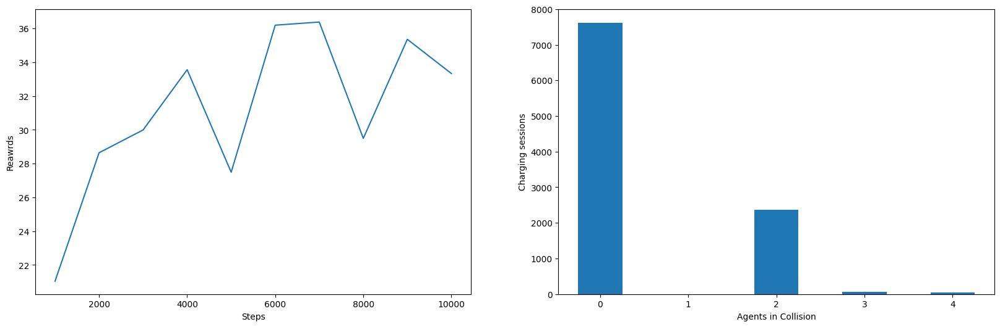

In [ ]:
bins = []
for x in range(nb_agents+1):
    bins.append(x-0.5)
    bins.append(x+0.5)
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 1)
plt.plot(steps, avg)
plt.xlabel("Steps")
plt.ylabel("Reawrds")
plt.subplot(1, 2, 2)
plt.hist(train_py_env.agents_in_collision, bins=bins, rwidth=0.5)
plt.xlabel("Agents in Collision")
plt.ylabel("Charging sessions")
plt.show()

In [ ]:
print(train_py_env.agents_in_collision)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 4, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 

In [ ]:
liste = [0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 3, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 3, 2, 3, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 2, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 2, 2, 2, 2, 3, 2, 0, 3, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 4, 0, 2, 0, 4, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 4, 2, 4, 2, 4, 2, 4, 2, 4, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 3, 0, 3, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 4, 0, 4, 0, 4, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 4, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 3, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 3, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 3, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 3, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 3, 3, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 2, 0, 2, 2, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 4, 2, 0, 2, 4, 2, 0, 0, 2, 2, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 3, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 3, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 3, 2, 3, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 3, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 4, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 3, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 3, 2, 2, 3, 2, 3, 2, 2, 2, 3, 2, 0, 2, 2, 2, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 4, 4, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 4, 2, 3, 3, 2, 3, 2, 2, 2, 2, 2, 3, 3, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 4, 4, 2, 0, 0, 0, 2, 4, 4, 3, 4, 0, 2, 2, 3, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 4, 2, 3, 0, 0, 2, 3, 0, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 2, 2, 2, 2, 3, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 2, 3, 2, 2, 3, 3, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 3, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 4, 2, 4, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 3, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 2, 2, 0, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 4, 0, 4, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 3, 2, 0, 2, 0, 2, 0, 0, 0, 3, 2, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 3, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 4, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 3, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 3, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 3, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 4, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 3, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 3, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 3, 0, 0, 2, 0, 0, 4, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 2, 2, 3, 0, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 4, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 3, 0, 0, 0, 2, 2, 2, 0, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2, 2, 3, 2, 2, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 2, 3, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 0, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 2, 3, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 3, 2, 2, 0, 0, 2, 2, 0, 2, 0, 2, 3, 2, 0, 0, 0, 0, 0, 2, 3, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 4, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 3, 3, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 4, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 3, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 4, 4, 2, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 2, 2, 0, 2, 2, 3, 2, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 4, 2, 2, 2, 2, 3, 2, 0, 2, 0, 3, 2, 3, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 3, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 3, 3, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 2, 2, 0, 2, 2, 2, 3, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 4, 2, 2, 0, 0, 0, 2, 4, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 3, 2, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 4, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 4, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 3, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 3, 0, 2, 2, 2, 0, 0, 0, 0, 4, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 4, 0, 0, 0, 0, 2, 0, 2, 3, 2, 3, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 3, 0, 0, 2, 2, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 3, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 3, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 3, 0, 4, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 0, 2, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 3, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 2, 2, 2, 2, 0, 2, 2, 4, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 2, 4, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 3, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 4, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 4, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 4, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 3, 3, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 4, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 3, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 3, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 4, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 3, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 3, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 3, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 2, 4, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 4, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 3, 2, 2, 2, 3, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 4, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 3, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 4, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 3, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 3, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 4, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 3, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 4, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 4, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 3, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 3, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 3, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 3, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 3, 2, 2, 0, 2, 0, 3, 3, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 2, 3, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 3, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 3, 0, 2, 2, 0, 0, 0, 0, 3, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 3, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 3, 0, 2, 2, 3, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 3, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 3, 3, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 2, 4, 4, 4, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 3, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 2, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 4, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 4, 2, 4, 4, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 3, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 3, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 3, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 3, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 3, 3, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 4, 2, 2, 2, 0, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 3, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 3, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 4, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 4, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 3, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 3, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 3, 4, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 0, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 4, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 4, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 3, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 3, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 4, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 4, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 4, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 4, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 4, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 3, 2, 2, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 3, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 0, 4, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 4, 4, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 4, 4, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 3, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 4, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 2, 2, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 4, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 4, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 4, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 4, 4, 4, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 4, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 4, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 4, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 3, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 3, 2, 3, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 4, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 3, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 4, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 3, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 4, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 3, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 3, 0, 0, 2, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0]

cpt  = 0
for ele in liste:
    if ele==0:
        cpt += 1
print(cpt)

cpt  = 0
for ele in liste:
    if ele==2:
        cpt += 1
print(cpt)

cpt  = 0
for ele in liste:
    if ele==3:
        cpt += 1
print(cpt)

cpt  = 0
for ele in liste:
    if ele==4:
        cpt += 1
print(cpt)

46560
11151
273
190


100%|██████████| 100/100 [06:01<00:00,  3.61s/it]


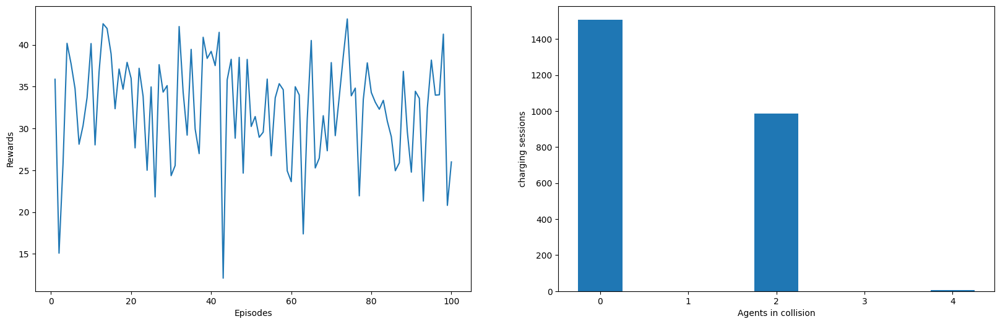

In [ ]:
rewards = []
episodes = 100
a = len(eval_py_env.agents_in_collision)
for _ in tqdm(range(episodes)):
    time_step = eval_env.reset()
    episode_return = 0.0
    while not time_step.is_last():
        actions = []
        for i in range(nb_agents):
            actions.append(eval_policies[i].action(time_step).action.numpy()[0])
        actions = tf.convert_to_tensor([actions])
        time_step = eval_env.step(actions)
        episode_return += time_step.reward
    rewards.append(episode_return.numpy()[0])

bins = []
for x in range(nb_agents+1):
    bins.append(x-0.5)
    bins.append(x+0.5)
plt.figure(figsize=(20,6))
plt.subplot(1, 2, 1)
plt.plot(range(1, episodes+1), rewards)
plt.xlabel("Episodes")
plt.ylabel("Rewards")
plt.subplot(1, 2, 2)
plt.hist(eval_py_env.agents_in_collision[a:], bins=bins, rwidth=0.5)
plt.xlabel("Agents in collision")
plt.ylabel("charging sessions")
plt.show()